<a href="https://colab.research.google.com/github/akpanitorobong/Dissertation-Lightweight_Arrhythmia_Model/blob/main/Dissertation_ECG_Arrhythmia_Beat_Classification_Final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ECG Arrhythmia Beat Classification with PhysioNet Dataset**

This notebook provides an end-to-end pipeline for detecting arrhythmia beats using the PhysioNet 12-lead ECG Arrhythmia Database l. It performs annotation parsing, beat extraction, 1D ResNet classification, and result visualizations.

# **IDE and Dataset Preparation**

## **Library Installs and Imports**

**Install libraries**

In [15]:
!pip install wfdb==4.1.2 numpy pandas scipy scikit-learn tensorflow seaborn matplotlib tqdm ecg_plot

**Import Libraries**

In [16]:
print("Importing libraries...")

# === Standard Library Imports ===
import os  # Interacting with the operating system
import re  # Regular expressions
from pathlib import Path  # Filesystem paths
from collections import Counter  # Counting hashable items
import shutil


# === Dataset
from google.colab import drive

# === Data Handling and Numerical Computation ===
import numpy as np  # Numerical computations
import pandas as pd  # Data analysis and manipulation

# === Signal Processing (WFDB and ECG) ===
import wfdb  # Read/write/process WFDB-format signals
from wfdb import processing as wfproc  # WFDB signal processing utilities
from scipy.io import loadmat  # Load MATLAB .mat files
import ecg_plot  # ECG signal visualization

# === Machine Learning and Evaluation ===
from sklearn.model_selection import train_test_split  # Train/test data split
from sklearn.preprocessing import LabelEncoder  # Label encoding
from sklearn.metrics import classification_report, confusion_matrix  # Evaluation metrics
from sklearn.utils import class_weight

# === Deep Learning (TensorFlow/Keras) ===
import tensorflow as tf  # TensorFlow core
from tensorflow.keras import layers, models, callbacks, utils  # Keras modules for model building

# === Visualization ===
import matplotlib.pyplot as plt  # Plotting
import seaborn as sns  # Statistical visualization

# === Utilities ===
from tqdm import tqdm  # Progress bar for loops

print("Importation complete")

Importing libraries...
Importation complete


## **Setup Dataset**

In [31]:
# 1) Install + import deps
!pip -q install gdown
import os, shutil, zipfile, glob, gdown

# 2) Download the ZIP from Google Drive (public "anyone with the link")
FILE_ID = "159vMobQkW-wt7l7PrWpfPpToqotQ4Kv-"
ZIP_PATH = "/content/dataset.zip"
gdown.download(f"https://drive.google.com/uc?id={FILE_ID}", ZIP_PATH, quiet=False)

# 3) Extract to a temp folder
EXTRACT_TMP = "/content/_extracted_tmp"
if os.path.exists(EXTRACT_TMP):
    shutil.rmtree(EXTRACT_TMP)
os.makedirs(EXTRACT_TMP, exist_ok=True)

with zipfile.ZipFile(ZIP_PATH, "r") as zf:
    zf.extractall(EXTRACT_TMP)

# 4) Locate the WFDBRecords folder inside whatever structure the ZIP uses
matches = glob.glob(os.path.join(EXTRACT_TMP, "**", "WFDBRecords"), recursive=True)
if not matches:
    raise FileNotFoundError(
        "Couldn't find 'WFDBRecords' in the ZIP. Please check the archive contents."
    )

wfdb_dir = matches[0]
dataset_root = os.path.dirname(wfdb_dir)  # we want this parent to be /content/dataset

# 5) Normalize to /content/dataset (move or symlink)
TARGET_DATASET = "/content/dataset"
if os.path.islink(TARGET_DATASET) or os.path.exists(TARGET_DATASET):
    # Remove old dataset folder/symlink if present
    if os.path.islink(TARGET_DATASET):
        os.unlink(TARGET_DATASET)
    else:
        shutil.rmtree(TARGET_DATASET)

# If the dataset_root is already under /content, move it to /content/dataset;
# otherwise, create a symlink so your code can use the expected path.
try:
    shutil.move(dataset_root, TARGET_DATASET)
except shutil.Error:
    # Moving may fail if source and target collide — fall back to a symlink
    os.symlink(dataset_root, TARGET_DATASET)

Downloading...
From (original): https://drive.google.com/uc?id=159vMobQkW-wt7l7PrWpfPpToqotQ4Kv-
From (redirected): https://drive.google.com/uc?id=159vMobQkW-wt7l7PrWpfPpToqotQ4Kv-&confirm=t&uuid=0a48ba7c-6ea7-402d-9645-e58cd23287f6
To: /content/dataset.zip
100%|██████████| 2.52G/2.52G [00:26<00:00, 95.1MB/s]


/content/dataset/WFDBRecords/01/010/JS00001.mat FOUND
/content/dataset/WFDBRecords/01/010/JS00002.mat FOUND


In [18]:
'''# Mount Google Drive
drive.mount('/content/drive')

# Ensure local dataset directory exists
os.makedirs('/content/dataset', exist_ok=True)

# Recursively and forcefully copy all contents
!cp -r "/content/drive/MyDrive/Dataset/WFDBRecords/" "/content/dataset/WFDBRecords"'''

'# Mount Google Drive\ndrive.mount(\'/content/drive\')\n\n# Ensure local dataset directory exists\nos.makedirs(\'/content/dataset\', exist_ok=True)\n\n# Recursively and forcefully copy all contents\n!cp -r "/content/drive/MyDrive/Dataset/WFDBRecords/" "/content/dataset/WFDBRecords"'

## **Helper Functions for Signal Data Extraction**

**Load ECG data from a .mat file specified by filename.**

In [20]:
def load_data(filename):
    x = loadmat(filename)
    data = np.asarray(x['val'], dtype=np.float64)
    new_file = filename.replace('.mat','.hea')
    input_header_file = os.path.join(new_file)
    with open(input_header_file,'r') as f:
        header_data=f.readlines()
    return data, header_data

**Extract diagnosis label from a .hea ECG header file using SNOMED codes**

In [21]:
def parse_header_label(hea_path: Path) -> str:
    with open(hea_path, "r") as f:
        for line in f:
            if line.startswith("#Dx:"):
                codes = re.findall(r"\d+", line)
                for c in codes:
                    if c in SNOMED_MAP:
                        return SNOMED_MAP[c]
    return DEFAULT_LABEL

**Load ECG signal from a record, optionally limiting duration in seconds**

In [22]:
def load_signal(record_base: Path, max_seconds: int | None) -> np.ndarray:
    # Read the ECG record (it loads both the signal and metadata)
    rec = wfdb.rdrecord(str(record_base))

    # Get the physical signal (already converted to real units like millivolts)
    sig = rec.p_signal

    # If a time limit is given, trim the signal to that many seconds
    if max_seconds is not None:
        # rec.fs is the sampling rate (e.g., 500 samples per second)
        sig = sig[: int(max_seconds * rec.fs)]

    # Convert the signal to 32-bit floats (saves memory, works well for ML)
    return sig.astype(np.float32)

**Detect R-peaks (heartbeats) from a selected ECG lead using GQRS algorithm**

In [23]:
def detect_rpeaks(sig: np.ndarray, fs: int) -> np.ndarray:
    # Choose one ECG lead (channel) from the multichannel signal to analyze
    # LEAD_INDEX is a constant that tells which lead we're using (e.g., Lead II)
    x = sig[:, LEAD_INDEX]

    # Use the GQRS algorithm to detect R-peaks (heartbeat locations) in the signal
    # fs is the sampling rate, used to correctly time the peaks
    peaks = wfproc.gqrs_detect(x, fs=fs)

    # Optionally, you could improve the detection with correction (currently commented out)
    # peaks = wfproc.correct_peaks(x, peak_inds=peaks, search_radius=int(0.05 * fs), smooth_window_size=2)

    return peaks  # Return the list of detected peak positions (as sample indices)

**Extract fixed-size heartbeat segments (beats) around each R-peak from an ECG signal**

In [24]:
def extract_beats(sig: np.ndarray, rpeaks: np.ndarray, fs: int) -> np.ndarray:
    # Calculate how many samples to take before and after each R-peak
    half_win = int(WINDOW_SEC * fs / 2)

    beats = []  # List to hold each extracted beat segment

    for r in rpeaks:
        # Define the window around the R-peak
        start = r - half_win
        end = r + half_win

        # Skip the beat if it would go beyond the signal's boundaries
        if start < 0 or end > len(sig):
            continue

        # Extract the beat segment from the chosen lead
        beat = sig[start:end, LEAD_INDEX]
        beats.append(beat)

    # Stack the list of beats into a 2D array (each row = one beat),
    # or return an empty array if no beats were valid
    return np.stack(beats) if beats else np.empty((0, int(WINDOW_SEC * fs)))


**Plot ECG signal from a .mat file using a fixed sample rate and scaled voltage.**

In [25]:
def plot_ecg(path):
    x = path
    print("ECG recordings for "+x)
    ecg_data = load_data(path)
    ecg_plot.plot(ecg_data[0]/1000, sample_rate=500, title='ECG Plot')
    ecg_plot.show()

** **Resnet Model**

In [26]:
def build_resnet(input_shape: tuple[int, int], num_classes: int) -> tf.keras.Model:
    def res_block(x, filters, kernel_size=7):
        shortcut = x
        x = layers.Conv1D(filters, kernel_size, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x)
        x = layers.Conv1D(filters, kernel_size, padding="same")(x)
        x = layers.BatchNormalization()(x)
        x = layers.Add()([x, shortcut])
        x = layers.Activation("relu")(x)
        return x

    inp = layers.Input(shape=input_shape)
    x = layers.Conv1D(32, 7, padding="same", activation="relu")(inp)
    x = layers.MaxPooling1D(2)(x)
    for f in [32, 64, 64, 128, 128, 256]:
        x = res_block(x, f)
        if f in {64, 128, 256}:
            x = layers.MaxPooling1D(2)(x)
    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation="relu")(x)
    out = layers.Dense(num_classes, activation="softmax")(x)
    return models.Model(inp, out, name="ResNet1D")

## **Exploratory Data Analysis**

ECG recordings for /content/dataset/WFDBRecords/01/010/JS00001.mat


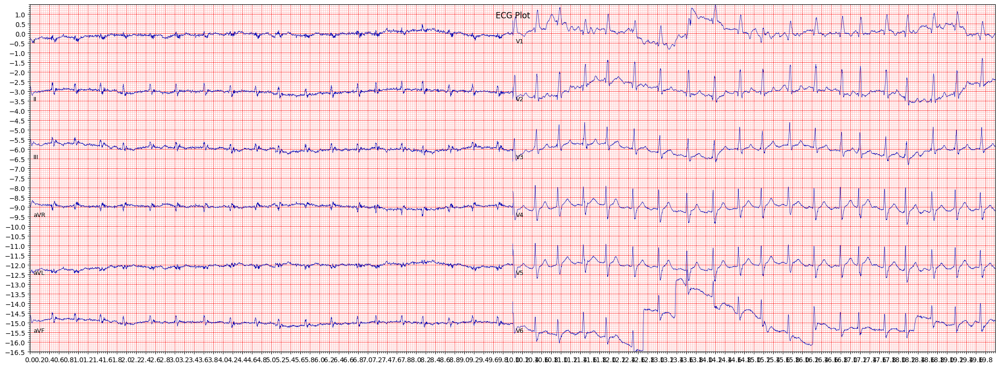

ECG recordings for /content/dataset/WFDBRecords/01/010/JS00002.mat


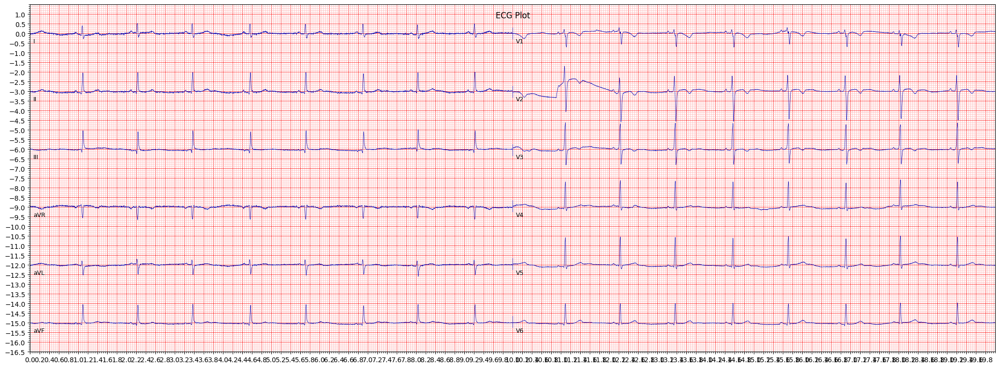

In [32]:
#Use functions to plot ECG recordings from two different patients in the dataset
plot_ecg('/content/dataset/WFDBRecords/01/010/JS00001.mat')
plot_ecg('/content/dataset/WFDBRecords/01/010/JS00002.mat')

# **Data Preprocessing**

## **Data Processing Parameters**

In [33]:
MAX_SECONDS = 30  # Maximum number of seconds to process from each ECG recording
WINDOW_SEC = 1.0  # Length of the sliding window in seconds
PRE_R_SEC = 0.5  # Time before the R-peak to include in the window (in seconds)
LEAD_INDEX = 1  # Index of the ECG lead to use (e.g., lead II)
FS = 500  # Sampling frequency in Hz

# Mapping of SNOMED codes to diagnostic labels
SNOMED_MAP = {
    "164889003": "Normal",      # Normal sinus rhythm
    "426177001": "AV_Block",    # Atrioventricular block
    "39732003":  "Other",       # Other rhythm (unspecified)
    "164909002": "AFib",        # Atrial fibrillation
    "164931005": "Other",       # Other rhythm (unspecified)
    "251146004": "Other",       # Other rhythm (unspecified)
}

DEFAULT_LABEL = "Other"  # Default label if SNOMED code is not recognized

## **Load and Preprocess Data**

In [ ]:
# Set the path to the dataset
DATA_DIR = Path("/content/dataset/WFDBRecords")

# Lists to store the beat data and their corresponding labels
beats, labels = [], []

# Find all .hea files in the dataset folder (these contain diagnosis info)
hea_files = sorted(DATA_DIR.rglob("*.hea"))
print(f"Found {len(hea_files)} header files")

# Loop through each ECG record found
#processed_count = 0 #Counter for valid records
for hea in tqdm(hea_files, desc="Processing records"):
    """
    if processed_count > 100:
     print("100 done. Breaking loop")
      break
    """
    # Get the diagnosis label (like "normal", "AFib", etc.) from the header file
    label = parse_header_label(hea)

    # Get the base file path (removing .hea to access corresponding .mat signal file)
    record_base = hea.with_suffix("")

    try:
        # Load the ECG signal (limited to MAX_SECONDS, if specified)
        sig = load_signal(record_base, MAX_SECONDS)
    except Exception as e:
        # If the signal can't be read (e.g., missing or bad file), skip it
        continue

    # Find R-peaks in the ECG signal (locations of heartbeats)
    rpeaks = detect_rpeaks(sig, FS)

    # Cut out beat-sized windows around each R-peak
    record_beats = extract_beats(sig, rpeaks, FS)
    print(record_beats)  # Show extracted beats for debugging

    # Skip files that didn’t yield any valid beats
    if record_beats.size == 0:
        continue

    # Save the beat segments and match each one with the same label
    beats.append(record_beats)
    labels.extend([label] * len(record_beats))

    #processed_count += 1

# Combine all beat arrays into one big NumPy array
X = np.concatenate(beats)

# Add a new axis so the shape is (samples, timesteps, channels), required by Conv1D
X = X[..., np.newaxis]

# Encode text labels (like "Normal", "AFib") into numeric values (0, 1, 2, ...)
le = LabelEncoder()
y = le.fit_transform(labels)

# Store the readable class names for reference later
CLASS_NAMES = le.classes_.tolist()

Found 45152 header files


Processing records:   0%|          | 2/45152 [00:00<38:59, 19.30it/s]

[[ 0.049  0.059  0.063 ...  0.059  0.068  0.073]
 [ 0.4    0.4    0.366 ...  0.254  0.234  0.278]
 [ 0.044  0.029  0.024 ...  0.049  0.049  0.034]
 ...
 [ 0.078  0.078  0.068 ...  0.024  0.029  0.015]
 [ 0.278  0.254  0.181 ...  0.015  0.088  0.122]
 [-0.034 -0.01  -0.005 ... -0.054 -0.054 -0.054]]
[[-0.078 -0.059 -0.049 ...  0.015  0.02   0.   ]
 [-0.024 -0.02  -0.01  ... -0.039 -0.015 -0.024]
 [-0.034 -0.039 -0.059 ...  0.015  0.005  0.005]
 ...
 [-0.049 -0.049 -0.054 ... -0.01  -0.024 -0.029]
 [-0.088 -0.073 -0.093 ... -0.01  -0.029 -0.029]
 [ 0.005  0.01   0.    ...  0.01   0.015  0.029]]
[[-0.02  -0.02  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.024 ... -0.068 -0.068 -0.068]
 [-0.044 -0.054 -0.054 ... -0.039 -0.039 -0.039]
 ...
 [-0.044 -0.039 -0.034 ... -0.044 -0.039 -0.034]
 [-0.034 -0.029 -0.039 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.068 ... -0.107 -0.107 -0.107]]
[[-0.005  0.015  0.005 ... -0.137 -0.127 -0.093]
 [ 0.078  0.083  0.093 ... -0.098 -0.093 -0.088]
 [

Processing records:   0%|          | 5/45152 [00:00<35:23, 21.26it/s]

[[-0.044 -0.044 -0.039 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.039 -0.039 ... -0.039 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ...  0.    -0.01  -0.01 ]
 ...
 [-0.034 -0.024 -0.02  ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.02  -0.029 ... -0.049 -0.039 -0.039]
 [-0.039 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]]


Processing records:   0%|          | 8/45152 [00:00<33:45, 22.29it/s]

[[ 0.122  0.098  0.127 ... -0.156 -0.137 -0.073]
 [-0.02  -0.005 -0.039 ... -0.049 -0.044 -0.063]
 [-0.127 -0.127 -0.137 ... -0.059 -0.024 -0.044]
 ...
 [ 0.142  0.146  0.127 ...  0.146  0.2    0.229]
 [-0.059 -0.083 -0.088 ... -0.024  0.005  0.029]
 [ 0.024  0.049  0.024 ... -0.015  0.015  0.005]]
[[-0.049 -0.054 -0.059 ... -0.068 -0.059 -0.063]
 [-0.063 -0.073 -0.059 ... -0.049 -0.063 -0.054]
 [-0.059 -0.054 -0.063 ... -0.049 -0.054 -0.054]
 ...
 [-0.039 -0.044 -0.049 ... -0.068 -0.063 -0.063]
 [-0.044 -0.049 -0.059 ...  0.005 -0.01   0.005]
 [-0.01   0.    -0.01  ... -0.029 -0.054 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.049 -0.044]
 [-0.059 -0.054 -0.059 ... -0.054 -0.054 -0.059]
 [-0.044 -0.049 -0.063 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.059 -0.054 -0.054 ... -0.059 -0.054 -0.068]
 [-0.054 -0.068 -0.068 ... -0.015 -0.02  -0.024]
 [-0.044 -0.054 -0.044 ...  0.    -0.01  -0.005]]
[[-0.063 -0.049 -0.039 ...  0.054  0.054  0.049]
 [ 0.073  0.068  0.049 ...  0.034  0.029  0.029]
 [

Processing records:   0%|          | 14/45152 [00:00<32:25, 23.20it/s]

[[-0.088 -0.078 -0.054 ... -0.078 -0.117 -0.102]
 [-0.034 -0.024 -0.034 ... -0.063 -0.054 -0.034]
 [-0.117 -0.137 -0.166 ... -0.112 -0.073 -0.059]
 ...
 [-0.083 -0.068 -0.063 ... -0.078 -0.068 -0.102]
 [-0.073 -0.068 -0.073 ... -0.029 -0.044 -0.034]
 [-0.078 -0.068 -0.102 ... -0.029 -0.039 -0.044]]
[[-0.044 -0.049 -0.039 ... -0.073 -0.068 -0.059]
 [-0.054 -0.044 -0.039 ... -0.039 -0.024 -0.029]
 [-0.029 -0.024 -0.02  ... -0.029 -0.024 -0.024]
 ...
 [-0.01  -0.005 -0.005 ... -0.049 -0.054 -0.049]
 [-0.054 -0.049 -0.054 ... -0.034 -0.034 -0.039]
 [-0.005 -0.01  -0.01  ... -0.029 -0.024 -0.034]]
[[ 0.249  0.254  0.244 ... -0.102 -0.098 -0.093]
 [-0.102 -0.127 -0.122 ... -0.034 -0.137 -0.083]
 [-0.039 -0.063 -0.078 ... -0.093 -0.083 -0.102]
 ...
 [-0.039 -0.044 -0.034 ... -0.068 -0.063 -0.054]
 [ 0.078  0.093  0.112 ... -0.083 -0.083 -0.059]
 [-0.039 -0.049 -0.059 ... -0.093 -0.073 -0.049]]
[[-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.01 ]
 [-0.005 -0.01  -0.015 ... -0.02  -0.02  -0.01 ]
 [

Processing records:   0%|          | 17/45152 [00:00<32:28, 23.16it/s]

[[-0.039 -0.015 -0.024 ... -0.059 -0.068 -0.059]
 [-0.054 -0.049 -0.039 ... -0.02  -0.039 -0.024]
 [-0.02  -0.024  0.    ... -0.034 -0.039 -0.063]
 ...
 [-0.044 -0.054 -0.063 ... -0.015 -0.044 -0.039]
 [-0.015 -0.01  -0.024 ... -0.024  0.    -0.01 ]
 [ 0.    -0.029 -0.039 ... -0.015 -0.015 -0.005]]
[[ 0.     0.01  -0.005 ...  0.005  0.015  0.015]
 [ 0.015  0.015  0.015 ...  0.034  0.034  0.044]
 [ 0.029  0.039  0.029 ... -0.024 -0.024 -0.034]
 ...
 [-0.049 -0.063 -0.073 ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.015 -0.02  ... -0.078 -0.054 -0.039]
 [-0.073 -0.078 -0.068 ... -0.132 -0.112 -0.093]]
[[ 0.029  0.02  -0.005 ...  0.005  0.044  0.02 ]
 [ 0.005 -0.015 -0.029 ... -0.024  0.005 -0.02 ]
 [ 0.024  0.034  0.015 ... -0.01  -0.054 -0.059]
 ...
 [ 0.034  0.02   0.01  ... -0.015 -0.01   0.039]
 [-0.015 -0.01   0.039 ... -0.01   0.005 -0.029]
 [ 0.005  0.005  0.005 ...  0.    -0.024 -0.02 ]]
[[-0.015 -0.039 -0.054 ... -0.098 -0.137 -0.122]
 [-0.083 -0.068 -0.073 ...  0.024 -0.029 -0.049]
 [

Processing records:   0%|          | 26/45152 [00:01<31:26, 23.92it/s]

[[-0.068 -0.068 -0.068 ... -0.024 -0.034 -0.039]
 [ 0.01   0.     0.005 ... -0.142 -0.166 -0.185]
 [-0.137 -0.146 -0.142 ... -0.176 -0.161 -0.151]
 ...
 [ 0.068  0.068  0.063 ...  0.102  0.098  0.098]
 [ 0.107  0.102  0.098 ...  0.142  0.146  0.156]
 [ 0.229  0.215  0.176 ... -0.181 -0.176 -0.166]]
[[-0.073 -0.068 -0.063 ... -0.034 -0.029 -0.029]
 [-0.054 -0.049 -0.054 ... -0.01  -0.005  0.   ]
 [-0.029 -0.034 -0.039 ...  0.01   0.01   0.015]
 ...
 [ 0.049  0.063  0.068 ... -0.122 -0.122 -0.122]
 [-0.083 -0.088 -0.102 ...  0.02   0.024  0.034]
 [ 0.039  0.054  0.063 ... -0.015 -0.02  -0.01 ]]
[[ 0.249  0.327  0.395 ... -0.015  0.005 -0.01 ]
 [ 0.229  0.273  0.327 ... -0.054 -0.034 -0.034]
 [ 0.224  0.249  0.327 ... -0.029 -0.073 -0.073]
 ...
 [ 0.459  0.522  0.488 ... -0.015 -0.039 -0.059]
 [ 0.429  0.508  0.547 ... -0.024 -0.01   0.01 ]
 [ 0.327  0.395  0.483 ... -0.015 -0.02   0.   ]]
[[ 0.005  0.005  0.01  ...  0.005  0.005  0.015]
 [ 0.024  0.029  0.029 ... -0.015 -0.015 -0.005]
 [

Processing records:   0%|          | 29/45152 [00:01<33:19, 22.57it/s]

[[-0.039 -0.029 -0.059 ... -0.039 -0.015 -0.005]
 [ 0.005  0.015  0.024 ... -0.039 -0.024 -0.02 ]
 [-0.024 -0.005 -0.005 ...  0.02   0.     0.   ]
 ...
 [ 0.068  0.054  0.049 ... -0.029 -0.02  -0.024]
 [-0.078 -0.044 -0.029 ... -0.059 -0.054 -0.029]
 [-0.059 -0.073 -0.078 ...  0.073  0.068  0.078]]
[[-0.024 -0.024 -0.034 ...  0.01   0.015  0.029]
 [ 0.02   0.015  0.005 ... -0.015 -0.024 -0.024]
 [-0.063 -0.107 -0.151 ...  0.02   0.039  0.039]
 ...
 [-0.044 -0.059 -0.029 ...  0.029  0.01   0.029]
 [-0.039 -0.088 -0.063 ...  0.015  0.015  0.02 ]
 [-0.044 -0.054 -0.049 ...  0.024  0.015  0.015]]
[[-0.073 -0.063 -0.063 ... -0.049 -0.044 -0.044]
 [-0.054 -0.054 -0.044 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.024 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.029 -0.024 -0.024 ... -0.063 -0.063 -0.063]
 [-0.073 -0.063 -0.063 ... -0.005 -0.015 -0.029]
 [-0.039 -0.039 -0.054 ... -0.039 -0.049 -0.054]]
[[-0.132 -0.088 -0.039 ...  0.078  0.088  0.088]
 [-0.029 -0.029 -0.029 ...  0.063  0.068  0.063]
 [

Processing records:   0%|          | 35/45152 [00:01<32:27, 23.17it/s]

[[ 0.161  0.171  0.176 ... -0.063 -0.059 -0.044]
 [-0.122 -0.107 -0.117 ...  0.02   0.029  0.029]
 [ 0.405  0.459  0.503 ... -0.005  0.005  0.029]
 ...
 [-0.044 -0.044 -0.054 ... -0.054 -0.059 -0.049]
 [-0.034 -0.034 -0.029 ... -0.039 -0.049 -0.039]
 [ 0.063  0.059  0.054 ...  0.376  0.273  0.107]]
[[-0.054 -0.049 -0.039 ... -0.044 -0.049 -0.078]
 [-0.088 -0.034  0.    ... -0.073 -0.078 -0.059]
 [-0.059 -0.059 -0.039 ... -0.049 -0.054 -0.024]
 ...
 [-0.039 -0.034 -0.024 ... -0.068 -0.034 -0.034]
 [-0.068 -0.078 -0.039 ... -0.054 -0.044 -0.015]
 [-0.005 -0.029 -0.029 ... -0.063 -0.059 -0.039]]
[[-0.088 -0.098 -0.088 ...  0.346  0.156  0.044]
 [ 0.     0.     0.    ...  0.     0.015  0.015]
 [ 0.068  0.073  0.068 ...  0.059  0.     0.005]
 ...
 [-0.044 -0.039 -0.034 ...  0.     0.     0.   ]
 [ 0.132  0.127  0.122 ...  0.02   0.02   0.024]
 [ 0.063  0.029  0.034 ...  0.015  0.015  0.015]]
[[ 0.024  0.     0.029 ... -0.063 -0.063 -0.044]
 [ 0.005 -0.015 -0.083 ... -0.034 -0.024 -0.01 ]
 [

Processing records:   0%|          | 41/45152 [00:01<33:45, 22.27it/s]

[[-0.146 -0.151 -0.156 ... -0.068 -0.049 -0.049]
 [ 0.015 -0.015 -0.039 ... -0.044 -0.044 -0.044]
 [-0.112 -0.161 -0.117 ... -0.034 -0.034 -0.044]
 ...
 [-0.063 -0.078 -0.073 ...  0.273  0.244  0.195]
 [-0.044 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.01   0.    ... -0.063 -0.073 -0.073]]
[[ 0.02   0.02   0.02  ... -0.049 -0.044 -0.024]
 [ 0.127  0.132  0.132 ... -0.098 -0.098 -0.083]
 [ 0.     0.    -0.01  ...  0.01   0.01   0.024]
 ...
 [ 0.142  0.137  0.137 ...  0.088  0.088  0.102]
 [ 0.215  0.22   0.22  ...  0.054  0.049  0.054]
 [ 0.185  0.185  0.185 ...  0.068  0.059  0.059]]
[[-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.063]
 [-0.127 -0.137 -0.127 ...  0.    -0.005 -0.01 ]
 [-0.02  -0.029 -0.029 ... -0.073 -0.078 -0.078]
 ...
 [ 0.029  0.034  0.034 ... -0.015 -0.029 -0.034]
 [ 0.098  0.098  0.102 ... -0.059 -0.059 -0.059]
 [ 0.405  0.478  0.532 ... -0.088 -0.083 -0.088]]
[[-0.107 -0.107 -0.107 ... -0.063 -0.063 -0.068]
 [-0.049 -0.054 -0.054 ... -0.098 -0.093 -0.093]
 [

Processing records:   0%|          | 47/45152 [00:02<33:11, 22.65it/s]

[[-0.083 -0.073 -0.078 ... -0.19  -0.176 -0.181]
 [-0.166 -0.166 -0.176 ... -0.107 -0.146 -0.156]
 [-0.171 -0.122 -0.132 ...  0.039  0.015  0.   ]
 ...
 [-0.068 -0.073 -0.102 ... -0.122 -0.122 -0.102]
 [-0.093 -0.083 -0.078 ... -0.112 -0.132 -0.161]
 [-0.049 -0.059 -0.078 ...  0.815  0.888  0.937]]
[[ 0.171  0.176  0.181 ...  0.034  0.044  0.044]
 [ 0.254  0.239  0.249 ...  0.015  0.024  0.044]
 [ 0.205  0.171  0.171 ...  0.127  0.117  0.132]
 ...
 [ 0.088  0.063  0.073 ... -0.029 -0.039 -0.024]
 [ 0.044  0.034  0.02  ...  0.049  0.034  0.044]
 [ 0.234  0.239  0.244 ... -0.098 -0.112 -0.102]]
[[-0.02  -0.015 -0.024 ... -0.024 -0.02  -0.024]
 [-0.029 -0.02  -0.02  ... -0.02  -0.01  -0.015]
 [ 0.112  0.122  0.137 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.044 -0.044 -0.034 ... -0.01   0.    -0.005]
 [ 0.034  0.039  0.024 ... -0.01  -0.01  -0.015]
 [-0.005 -0.01  -0.029 ...  0.005  0.    -0.01 ]]
[[-0.054 -0.044 -0.049 ...  0.024  0.044  0.049]
 [ 0.029  0.     0.02  ...  0.02   0.015  0.01 ]
 [

Processing records:   0%|          | 50/45152 [00:02<33:42, 22.30it/s]

[[ 0.137  0.142  0.112 ... -0.039 -0.054 -0.044]
 [ 0.127  0.146  0.156 ... -0.063 -0.063 -0.063]
 [ 0.156  0.137  0.122 ... -0.029 -0.044 -0.044]
 ...
 [ 0.054  0.073  0.049 ... -0.029 -0.034 -0.034]
 [ 0.02   0.005  0.01  ... -0.01   0.     0.   ]
 [ 0.054  0.039  0.034 ... -0.034 -0.039 -0.034]]
[[-0.02  -0.01   0.005 ...  0.102  0.102  0.102]
 [ 0.068  0.073  0.088 ...  0.044  0.044  0.02 ]
 [-0.005 -0.005  0.01  ...  0.039  0.039  0.034]
 ...
 [-0.01   0.     0.005 ...  0.107  0.112  0.117]
 [ 0.073  0.059  0.054 ...  0.112  0.112  0.112]
 [ 0.068  0.059  0.063 ...  0.024  0.024  0.024]]
[[-0.005  0.    -0.029 ... -0.029 -0.02  -0.024]
 [-0.02  -0.005 -0.02  ... -0.063 -0.063 -0.049]
 [-0.024 -0.02  -0.049 ... -0.059 -0.063 -0.029]
 ...
 [-0.015 -0.029 -0.039 ... -0.049 -0.039 -0.02 ]
 [-0.034 -0.034 -0.029 ... -0.039 -0.059 -0.049]
 [-0.059 -0.049 -0.034 ... -0.039 -0.024 -0.029]]
[[-0.039 -0.044 -0.039 ... -0.068 -0.068 -0.078]
 [-0.068 -0.078 -0.068 ...  0.005  0.029  0.029]
 [

Processing records:   0%|          | 56/45152 [00:02<33:10, 22.66it/s]

[[-0.024 -0.02  -0.02  ... -0.059 -0.063 -0.063]
 [-0.044 -0.049 -0.039 ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.     0.01  ... -0.02  -0.005  0.01 ]
 ...
 [-0.029 -0.015 -0.015 ... -0.044 -0.044 -0.054]
 [-0.054 -0.063 -0.054 ... -0.063 -0.073 -0.073]
 [-0.054 -0.039 -0.044 ... -0.02   0.005  0.01 ]]
[[ 0.137  0.146  0.137 ... -0.137 -0.137 -0.117]
 [ 0.117  0.137  0.146 ... -0.166 -0.166 -0.146]
 [ 0.117  0.127  0.127 ... -0.156 -0.127 -0.132]
 ...
 [ 0.127  0.127  0.127 ... -0.127 -0.117 -0.107]
 [ 0.156  0.151  0.156 ... -0.088 -0.107 -0.107]
 [ 0.156  0.166  0.146 ... -0.146 -0.117 -0.098]]
[[ 0.063  0.059  0.054 ...  0.005  0.039  0.02 ]
 [ 0.063  0.059  0.059 ... -0.015 -0.01  -0.01 ]
 [ 0.024  0.039  0.054 ... -0.024 -0.029 -0.029]
 ...
 [ 0.078  0.093  0.068 ... -0.01  -0.024 -0.029]
 [ 0.068  0.059  0.073 ... -0.005 -0.015 -0.024]
 [ 0.02   0.024  0.024 ...  0.029  0.044  0.029]]
[[-0.107 -0.098 -0.093 ...  0.044  0.044  0.054]
 [-0.063 -0.063 -0.049 ...  0.044  0.044  0.044]
 [

Processing records:   0%|          | 62/45152 [00:02<32:19, 23.24it/s]

[[ 0.024  0.034  0.02  ... -0.039 -0.039 -0.044]
 [-0.044 -0.078 -0.029 ... -0.029 -0.015 -0.049]
 [-0.098 -0.034 -0.039 ... -0.049 -0.049 -0.078]
 ...
 [-0.083 -0.02   0.044 ... -0.044  0.005  0.005]
 [-0.005 -0.024 -0.01  ... -0.024 -0.024 -0.01 ]
 [-0.024 -0.024 -0.01  ...  0.039 -0.02  -0.034]]
[[-0.054 -0.044 -0.044 ... -0.049 -0.063 -0.054]
 [-0.044 -0.044 -0.029 ... -0.049 -0.049 -0.063]
 [-0.049 -0.054 -0.044 ... -0.073 -0.088 -0.093]
 ...
 [-0.02  -0.02   0.    ... -0.024 -0.015 -0.029]
 [-0.039 -0.049 -0.024 ... -0.063 -0.063 -0.049]
 [-0.029 -0.015  0.    ... -0.068 -0.078 -0.078]]
[[ 0.054  0.02   0.034 ... -0.078 -0.073 -0.063]
 [-0.088 -0.083 -0.049 ... -0.059 -0.059 -0.059]
 [-0.054 -0.02   0.005 ... -0.029 -0.034 -0.039]
 ...
 [-0.044 -0.063 -0.078 ... -0.02  -0.029 -0.024]
 [-0.049 -0.059 -0.073 ... -0.029 -0.024 -0.029]
 [-0.034 -0.029 -0.024 ... -0.01  -0.034 -0.059]]
[[ 0.015  0.01   0.02  ... -0.005 -0.005  0.   ]
 [ 0.015  0.01   0.005 ... -0.039 -0.039 -0.034]
 [

Processing records:   0%|          | 65/45152 [00:02<32:26, 23.16it/s]

[[-0.044 -0.044 -0.054 ... -0.024 -0.039 -0.049]
 [-0.088 -0.088 -0.093 ... -0.034 -0.044 -0.039]
 [-0.093 -0.034 -0.015 ... -0.054 -0.054 -0.059]
 ...
 [-0.02  -0.024 -0.005 ... -0.088 -0.102 -0.102]
 [-0.102 -0.088 -0.068 ... -0.02  -0.054 -0.029]
 [-0.005  0.    -0.015 ... -0.063 -0.039 -0.029]]
[[-0.054 -0.049 -0.049 ... -0.024 -0.02  -0.02 ]
 [-0.039 -0.039 -0.034 ... -0.034 -0.029 -0.02 ]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.054]
 ...
 [ 0.088  0.088  0.088 ... -0.22  -0.264 -0.293]
 [-0.044 -0.044 -0.044 ... -0.049 -0.044 -0.044]
 [ 0.205  0.205  0.205 ... -0.224 -0.205 -0.195]]
[[-0.02  -0.01  -0.01  ... -0.024 -0.029 -0.029]
 [-0.049 -0.054 -0.054 ... -0.078 -0.078 -0.073]
 [-0.083 -0.083 -0.083 ... -0.029 -0.015 -0.015]
 ...
 [-0.078 -0.088 -0.078 ...  0.015  0.01   0.01 ]
 [ 0.044  0.044  0.039 ...  0.     0.    -0.005]
 [-0.01  -0.01  -0.005 ... -0.039 -0.039 -0.044]]
[[-0.376 -0.317 -0.268 ... -0.015 -0.02  -0.029]
 [ 0.068  0.088  0.078 ...  0.015  0.02   0.02 ]
 [

Processing records:   0%|          | 71/45152 [00:03<32:03, 23.43it/s]

[[ 0.015  0.015  0.01  ... -0.068 -0.073 -0.102]
 [-0.063 -0.073 -0.054 ...  0.2    0.205  0.22 ]
 [ 0.137  0.142  0.137 ...  0.176  0.181  0.161]
 ...
 [-0.078 -0.073 -0.073 ...  0.005  0.     0.005]
 [-0.005 -0.01  -0.01  ... -0.063 -0.054 -0.039]
 [-0.063 -0.068 -0.078 ...  0.01   0.     0.005]]
[[-0.044 -0.039 -0.039 ... -0.049 -0.054 -0.063]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.01  -0.01  ... -0.054 -0.054 -0.059]
 ...
 [-0.024 -0.034 -0.034 ... -0.034 -0.034 -0.039]
 [-0.01  -0.01  -0.02  ... -0.044 -0.044 -0.049]
 [-0.034 -0.044 -0.039 ... -0.054 -0.054 -0.059]]
[[-0.039 -0.029 -0.029 ...  0.005  0.005  0.015]
 [ 0.005  0.    -0.005 ... -0.024 -0.024 -0.015]
 [ 0.024  0.029  0.039 ...  0.034  0.029  0.029]
 ...
 [ 0.005  0.005  0.005 ...  0.     0.01   0.02 ]
 [-0.034 -0.039 -0.039 ...  0.312  0.254  0.229]
 [ 0.327  0.298  0.273 ...  0.2    0.259  0.273]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [

Processing records:   0%|          | 77/45152 [00:03<33:10, 22.65it/s]

[[-0.049 -0.029 -0.02  ...  0.083  0.142  0.098]
 [-0.029 -0.054 -0.088 ...  0.029  0.024  0.024]
 [-0.034 -0.039 -0.039 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.044 -0.029 -0.063 ...  0.093  0.073 -0.015]
 [-0.015 -0.044 -0.049 ...  0.01   0.     0.015]
 [ 0.02   0.02   0.093 ...  0.034  0.015  0.024]]
[[-0.029 -0.044 -0.024 ... -0.015 -0.02  -0.034]
 [-0.063 -0.044 -0.044 ... -0.039 -0.044 -0.054]
 [-0.005  0.    -0.015 ... -0.024 -0.034 -0.02 ]
 ...
 [-0.015 -0.02  -0.024 ... -0.059 -0.068 -0.054]
 [-0.073 -0.063 -0.068 ...  0.005 -0.01  -0.024]
 [ 0.     0.015  0.01  ...  0.01   0.    -0.015]]
[[ 0.044  0.049  0.059 ... -0.073 -0.073 -0.059]
 [ 0.02   0.024  0.024 ... -0.034 -0.029 -0.01 ]
 [-0.137 -0.146 -0.142 ... -0.02  -0.01  -0.059]
 ...
 [-0.063 -0.078 -0.102 ... -0.039 -0.049 -0.044]
 [-0.059 -0.044 -0.034 ... -0.132 -0.122 -0.098]
 [-0.01  -0.015 -0.015 ... -0.039 -0.039 -0.029]]
[[-0.034 -0.015 -0.015 ... -0.2   -0.19  -0.176]
 [-0.073 -0.059 -0.054 ... -0.142 -0.137 -0.132]
 [

Processing records:   0%|          | 83/45152 [00:03<31:57, 23.51it/s]

[[ 0.005  0.015 -0.005 ... -0.015  0.059  0.049]
 [ 0.088  0.063  0.029 ... -0.044 -0.049 -0.054]
 [-0.117 -0.078 -0.049 ... -0.063 -0.039 -0.02 ]
 ...
 [-0.015 -0.01  -0.029 ... -0.078 -0.063 -0.044]
 [-0.151 -0.142 -0.117 ... -0.049 -0.093 -0.073]
 [-0.029 -0.024  0.    ...  0.034  0.01   0.005]]
[[-0.151 -0.146 -0.161 ... -0.073 -0.073 -0.078]
 [-0.093 -0.107 -0.117 ... -0.039 -0.034 -0.034]
 [-0.015 -0.01  -0.01  ... -0.029 -0.044 -0.063]
 ...
 [ 0.605  0.649  0.708 ... -0.02  -0.029 -0.024]
 [ 0.093  0.107  0.107 ... -0.063 -0.068 -0.059]
 [-0.093 -0.112 -0.083 ... -0.029 -0.015 -0.02 ]]
[[-0.039 -0.044 -0.039 ...  1.137  1.157  1.166]
 [-0.049 -0.073 -0.093 ... -0.024 -0.044  0.015]
 [-0.029 -0.024 -0.015 ... -0.059 -0.054 -0.02 ]
 ...
 [-0.073 -0.029 -0.068 ... -0.083 -0.039 -0.029]
 [-0.044 -0.015 -0.024 ...  0.532  0.615  0.669]
 [ 0.61   0.722  0.825 ... -0.107 -0.102 -0.088]]
[[-0.098 -0.098 -0.098 ... -0.2   -0.2   -0.2  ]
 [-0.19  -0.195 -0.195 ... -0.083 -0.083 -0.093]
 [

Processing records:   0%|          | 89/45152 [00:03<32:03, 23.42it/s]

[[-0.029 -0.029 -0.034 ... -0.034 -0.029 -0.034]
 [-0.015 -0.005 -0.01  ... -0.098 -0.093 -0.093]
 [-0.093 -0.093 -0.088 ... -0.059 -0.059 -0.054]
 ...
 [ 0.098  0.093  0.088 ... -0.015 -0.015 -0.01 ]
 [-0.005 -0.01  -0.005 ... -0.029 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.034]]
[[-0.098 -0.068 -0.068 ... -0.034 -0.044 -0.044]
 [-0.117 -0.127 -0.093 ... -0.015  0.01   0.01 ]
 [-0.039 -0.049 -0.063 ... -0.054 -0.059 -0.068]
 [-0.054 -0.068 -0.068 ... -0.049 -0.049 -0.039]
 [-0.098 -0.098 -0.083 ... -0.039 -0.02  -0.034]
 [-0.024 -0.024 -0.015 ... -0.039 -0.029 -0.034]]
[[-0.059 -0.044 -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.068 -0.063 -0.054 ... -0.005 -0.01  -0.015]
 [-0.044 -0.049 -0.054 ... -0.02  -0.02  -0.024]
 ...
 [-0.059 -0.054 -0.054 ... -0.039 -0.044 -0.059]
 [ 0.034  0.024  0.02  ... -0.02  -0.015 -0.015]
 [-0.02  -0.024 -0.024 ... -0.039 -0.039 -0.039]]
[[ 0.     0.     0.    ...  0.01   0.02   0.01 ]
 [ 0.029  0.039  0.059 ... -0.01  -0.005 -0.005]
 [ 0.01

Processing records:   0%|          | 95/45152 [00:04<31:50, 23.59it/s]

[[-0.21  -0.171 -0.142 ...  0.01   0.01  -0.02 ]
 [-0.112 -0.132 -0.098 ... -0.01  -0.015 -0.024]
 [-0.278 -0.215 -0.176 ... -0.039 -0.044 -0.063]
 ...
 [ 0.005 -0.02  -0.02  ... -0.02  -0.01   0.015]
 [-0.132 -0.102 -0.078 ... -0.034 -0.01  -0.005]
 [-0.088 -0.059 -0.02  ...  0.005  0.015  0.01 ]]
[[ 0.059  0.063  0.068 ... -0.005  0.005  0.005]
 [ 0.229  0.224  0.215 ... -0.01  -0.01   0.   ]
 [ 0.098  0.098  0.107 ... -0.01  -0.015  0.005]
 ...
 [-0.024 -0.01  -0.024 ...  0.     0.015  0.015]
 [ 0.015  0.01   0.    ...  0.015  0.029  0.   ]
 [-0.024 -0.02   0.024 ...  0.068  0.044  0.024]]
[[-0.02  -0.02  -0.015 ... -0.132 -0.132 -0.132]
 [-0.098 -0.093 -0.093 ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.01  ...  0.034  0.034  0.034]
 ...
 [-0.098 -0.098 -0.098 ... -0.073 -0.073 -0.073]
 [-0.034 -0.034 -0.029 ...  0.054  0.054  0.054]
 [ 0.112  0.117  0.117 ...  0.093  0.093  0.093]]
[[-0.068 -0.073 -0.063 ...  0.005  0.    -0.02 ]
 [ 0.039  0.02   0.02  ...  0.029  0.024  0.029]
 [

Processing records:   0%|          | 101/45152 [00:04<33:13, 22.60it/s]

[[ 0.015  0.    -0.005 ...  0.244  0.176  0.112]
 [-0.005 -0.078 -0.102 ...  0.181  0.132  0.063]
 [ 0.063  0.02   0.029 ...  0.249  0.171  0.068]
 ...
 [-0.015 -0.024 -0.024 ...  0.239  0.171  0.063]
 [ 0.015 -0.015  0.01  ...  0.317  0.254  0.195]
 [ 0.073  0.024 -0.024 ...  0.293  0.268  0.132]]
[[-0.054 -0.063 -0.088 ... -0.054 -0.078 -0.078]
 [-0.068 -0.068 -0.063 ... -0.024 -0.015 -0.059]
 [-0.044 -0.059 -0.059 ... -0.068 -0.063 -0.059]
 ...
 [-0.049 -0.029 -0.049 ... -0.039 -0.039 -0.044]
 [-0.039 -0.039 -0.063 ... -0.054 -0.059 -0.059]
 [-0.102 -0.059 -0.005 ... -0.039 -0.02  -0.005]]
[[-0.044 -0.049 -0.073 ... -0.02  -0.024  0.   ]
 [-0.01   0.005  0.    ...  0.02  -0.02  -0.068]
 [-0.044 -0.034 -0.015 ... -0.01  -0.02  -0.034]
 ...
 [ 0.015 -0.005 -0.034 ... -0.01  -0.024 -0.005]
 [ 0.015  0.063  0.024 ... -0.068 -0.039 -0.024]
 [-0.01  -0.02  -0.02  ...  0.005  0.015  0.029]]
[[-0.107 -0.098 -0.088 ...  0.112  0.073  0.068]
 [-0.088 -0.083 -0.068 ...  0.     0.    -0.01 ]
 [

Processing records:   0%|          | 107/45152 [00:04<32:52, 22.84it/s]

[[-0.049 -0.073 -0.073 ... -0.054 -0.054 -0.059]
 [-0.059 -0.044 -0.059 ... -0.029 -0.034 -0.049]
 [-0.059 -0.063 -0.063 ... -0.024 -0.02  -0.029]
 ...
 [-0.073 -0.078 -0.088 ...  0.034  0.015  0.005]
 [-0.068 -0.068 -0.073 ...  0.005  0.    -0.005]
 [-0.039 -0.044 -0.039 ...  0.059  0.054  0.054]]
[[-0.102 -0.02   0.015 ... -0.024 -0.063 -0.083]
 [ 0.024  0.039  0.    ... -0.068 -0.059 -0.078]
 [-0.151 -0.127 -0.112 ... -0.015 -0.034 -0.044]
 ...
 [-0.083 -0.093 -0.073 ... -0.073 -0.102 -0.107]
 [-0.015  0.01   0.015 ... -0.044 -0.054 -0.034]
 [ 0.034  0.063  0.039 ... -0.078 -0.049 -0.029]]
[[-0.093 -0.088 -0.083 ...  0.024  0.015 -0.005]
 [-0.029 -0.029 -0.02  ...  0.044  0.039  0.024]
 [ 0.107  0.088  0.083 ... -0.01  -0.02  -0.01 ]
 ...
 [-0.024 -0.029 -0.039 ...  0.044  0.034  0.024]
 [ 0.059  0.024  0.01  ... -0.02  -0.034 -0.024]
 [-0.049 -0.054 -0.059 ... -0.044 -0.024 -0.034]]
[[-0.405 -0.356 -0.303 ... -0.112 -0.112 -0.098]
 [-0.342 -0.478 -0.551 ... -0.098 -0.102 -0.117]
 [

Processing records:   0%|          | 110/45152 [00:04<33:23, 22.48it/s]

[[-0.02  -0.02  -0.02  ...  0.01   0.01   0.015]
 [-0.015 -0.015 -0.015 ...  0.     0.     0.005]
 [ 0.015  0.01   0.01  ...  0.02   0.02   0.034]
 ...
 [ 0.     0.     0.    ...  0.02   0.02   0.02 ]
 [-0.02  -0.029 -0.034 ...  0.029  0.029  0.034]
 [-0.039 -0.034 -0.029 ...  0.029  0.029  0.029]]
[[-0.073 -0.078 -0.083 ... -0.073 -0.078 -0.078]
 [-0.068 -0.068 -0.063 ... -0.049 -0.054 -0.063]
 [-0.063 -0.059 -0.059 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.054 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.054 -0.073 -0.063 ... -0.049 -0.049 -0.034]
 [-0.078 -0.083 -0.083 ... -0.02  -0.015  0.01 ]]
[[-0.034 -0.024 -0.02  ...  0.015  0.005 -0.005]
 [-0.015 -0.015  0.    ... -0.02  -0.015 -0.015]
 [-0.034 -0.039 -0.034 ... -0.039 -0.054 -0.044]
 ...
 [-0.01  -0.01  -0.015 ... -0.039 -0.039 -0.02 ]
 [-0.034 -0.059 -0.054 ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.024 -0.015 ...  0.034  0.02   0.   ]]
[[-0.078 -0.083 -0.068 ... -0.024 -0.034 -0.044]
 [-0.034 -0.039 -0.039 ... -0.034 -0.029 -0.029]
 [

Processing records:   0%|          | 116/45152 [00:05<32:39, 22.99it/s]

[[ 0.01   0.01   0.039 ... -0.029 -0.063 -0.054]
 [-0.039 -0.068 -0.068 ...  0.    -0.005 -0.049]
 [ 0.015  0.044  0.02  ... -0.039 -0.073 -0.063]
 ...
 [ 0.083  0.098  0.117 ... -0.068 -0.068 -0.098]
 [-0.005 -0.029 -0.049 ... -0.024  0.005 -0.02 ]
 [-0.02   0.01   0.044 ... -0.107 -0.078 -0.029]]
[[-0.024 -0.02  -0.024 ... -0.039 -0.039 -0.029]
 [-0.044 -0.039 -0.039 ... -0.063 -0.073 -0.063]
 [-0.063 -0.068 -0.063 ... -0.029 -0.034 -0.034]
 ...
 [-0.054 -0.068 -0.068 ... -0.015 -0.02  -0.02 ]
 [ 0.005  0.005  0.005 ... -0.024 -0.039 -0.044]
 [-0.029 -0.02  -0.024 ...  0.034  0.02   0.015]]
[[ 0.063  0.044  0.068 ...  0.161  0.142  0.151]
 [ 0.098  0.122  0.127 ...  0.073  0.093  0.112]
 [ 0.083  0.093  0.102 ... -0.029 -0.02  -0.015]
 [ 0.015  0.02   0.024 ... -0.01  -0.01   0.029]
 [ 0.015  0.     0.005 ...  0.039  0.029  0.005]]
[[ 0.     0.029  0.02  ... -0.122 -0.093 -0.049]
 [-0.093 -0.112 -0.093 ... -0.02  -0.054 -0.01 ]
 [ 0.    -0.02   0.    ... -0.015  0.    -0.034]
 ...
 [

Processing records:   0%|          | 122/45152 [00:05<32:22, 23.18it/s]

[[-0.078 -0.073 -0.088 ... -0.102 -0.098 -0.112]
 [ 0.01  -0.01  -0.034 ... -0.112 -0.127 -0.083]
 [ 0.015  0.029  0.01  ... -0.034 -0.039 -0.034]
 ...
 [ 0.005  0.    -0.01  ...  0.005  0.    -0.005]
 [ 0.005  0.01   0.029 ...  0.185  0.234  0.303]
 [-0.024 -0.024  0.034 ... -0.059 -0.054 -0.059]]
[[ 0.093  0.102  0.098 ...  0.21   0.2    0.2  ]
 [-0.576 -0.576 -0.571 ...  0.015  0.024  0.024]
 [ 0.054  0.059  0.059 ...  0.171  0.181  0.181]
 [ 0.244  0.244  0.244 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.19  -0.181 -0.181]
 [-0.166 -0.166 -0.166 ... -0.054 -0.044 -0.044]]
[[ 0.015  0.015  0.015 ... -0.044 -0.044 -0.044]
 [ 1.386  1.24   1.108 ... -0.049 -0.049 -0.044]
 [-0.088 -0.093 -0.102 ... -0.068 -0.063 -0.068]
 ...
 [ 0.142  0.005 -0.073 ...  0.049  0.039  0.034]
 [ 0.005  0.015 -0.005 ...  0.083  0.088  0.088]
 [ 0.054  0.049  0.049 ...  0.142  0.146  0.146]]
[[-0.107 -0.117 -0.117 ... -0.059 -0.059 -0.029]
 [-0.078 -0.088 -0.098 ... -0.107 -0.107 -0.107]
 [-0.45

Processing records:   0%|          | 125/45152 [00:05<33:59, 22.08it/s]

[[ 0.02   0.005 -0.005 ...  0.005 -0.015  0.   ]
 [ 0.005  0.    -0.005 ...  0.015  0.01   0.02 ]
 [ 0.01   0.01   0.    ...  0.005  0.     0.   ]
 ...
 [ 0.     0.    -0.01  ...  0.029  0.034  0.039]
 [ 0.044  0.049  0.029 ...  0.029  0.024  0.024]
 [-0.01  -0.029 -0.044 ...  0.049  0.034  0.044]]
[[-0.059 -0.054 -0.059 ... -0.029 -0.044 -0.039]
 [-0.02  -0.029 -0.024 ... -0.039 -0.029 -0.034]
 [-0.024 -0.049 -0.034 ... -0.015 -0.029 -0.029]
 ...
 [-0.005 -0.02   0.    ... -0.054 -0.049 -0.039]
 [-0.039 -0.039 -0.044 ... -0.005 -0.024 -0.039]
 [-0.044 -0.049 -0.005 ... -0.034 -0.02  -0.039]]
[[ 0.044  0.039  0.034 ... -0.044 -0.044 -0.039]
 [ 0.02   0.01   0.01  ... -0.01  -0.01  -0.005]
 [ 0.088  0.088  0.088 ... -0.044 -0.044 -0.034]
 ...
 [ 0.044  0.034  0.02  ...  0.02   0.015  0.024]
 [ 0.112  0.117  0.112 ...  0.01   0.005 -0.01 ]
 [ 0.059  0.044  0.054 ...  0.039  0.029  0.029]]
[[-0.059 -0.063 -0.088 ... -0.068 -0.073 -0.073]
 [-0.078 -0.093 -0.063 ... -0.059 -0.044 -0.059]
 [

Processing records:   0%|          | 131/45152 [00:05<32:55, 22.79it/s]

[[-0.044 -0.107 -0.137 ... -0.083 -0.073 -0.078]
 [ 0.034  0.024  0.024 ... -0.21  -0.156 -0.122]
 [ 0.02   0.01   0.02  ... -0.161 -0.234 -0.298]
 ...
 [-0.117 -0.127 -0.112 ... -0.205 -0.195 -0.205]
 [-0.049 -0.024  0.    ... -0.298 -0.273 -0.21 ]
 [-0.02   0.01   0.015 ... -0.005  0.01   0.034]]
[[ 0.01   0.01   0.015 ... -0.063 -0.059 -0.054]
 [-0.044 -0.044 -0.044 ... -0.005  0.     0.005]
 [ 0.02   0.02   0.015 ... -0.078 -0.073 -0.073]
 ...
 [-0.112 -0.098 -0.098 ... -0.029 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.049 -0.044 -0.044]
 [-0.015  0.01   0.02  ... -0.156 -0.151 -0.151]]
[[-0.054 -0.054 -0.044 ... -0.029  0.     0.044]
 [ 0.024  0.02   0.039 ... -0.044 -0.039 -0.044]
 [-0.029 -0.044 -0.078 ... -0.063 -0.068 -0.068]
 ...
 [-0.024 -0.029 -0.034 ... -0.01  -0.015 -0.024]
 [ 0.01  -0.015 -0.029 ... -0.015 -0.024 -0.015]
 [-0.015 -0.01  -0.005 ... -0.015 -0.029 -0.024]]
[[ 0.195  0.205  0.2   ...  0.078  0.102  0.161]
 [ 0.137  0.068  0.049 ...  0.093  0.078  0.063]
 [

Processing records:   0%|          | 137/45152 [00:05<32:30, 23.08it/s]

[[-0.049 -0.054 -0.054 ... -0.083 -0.083 -0.073]
 [-0.088 -0.098 -0.093 ... -0.024 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ... -0.034 -0.054 -0.044]
 [-0.068 -0.068 -0.068 ... -0.015 -0.029 -0.024]
 [-0.059 -0.068 -0.068 ... -0.034 -0.034 -0.024]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.034]]
[[-0.024 -0.029 -0.024 ... -0.02  -0.024 -0.015]
 [-0.059 -0.068 -0.054 ...  0.01   0.01  -0.01 ]
 [-0.059 -0.054 -0.039 ...  0.01   0.     0.   ]
 ...
 [-0.054 -0.063 -0.068 ...  0.01   0.005  0.015]
 [-0.015 -0.024 -0.034 ... -0.005  0.     0.005]
 [-0.044 -0.039 -0.034 ...  0.039  0.034  0.024]]
[[ 0.059  0.034 -0.005 ... -0.015 -0.015 -0.01 ]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.01 ]
 [-0.063 -0.073 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [ 0.02   0.02  -0.005 ... -0.024 -0.015 -0.01 ]
 [-0.078 -0.083 -0.078 ... -0.024 -0.02  -0.02 ]
 [-0.078 -0.088 -0.088 ... -0.054 -0.059 -0.054]]
[[ 0.029  0.029  0.02  ... -0.068 -0.073 -0.073]
 [-0.039 -0.044 -0.059 ... -0.034 -0.039 -0.034]
 [-0.02

Processing records:   0%|          | 140/45152 [00:06<32:07, 23.36it/s]

[[-0.22  -0.195 -0.156 ... -0.078 -0.059 -0.054]
 [-0.327 -0.346 -0.351 ...  0.22   0.059 -0.054]
 [-0.049 -0.063 -0.078 ... -0.088 -0.083 -0.078]
 ...
 [-0.049 -0.049 -0.054 ...  0.029  0.024  0.02 ]
 [ 0.073  0.083  0.112 ... -0.059 -0.063 -0.063]
 [-0.195 -0.176 -0.127 ...  0.156 -0.005 -0.127]]
[[ 0.063  0.093  0.102 ...  0.015  0.     0.   ]
 [ 0.024  0.024  0.024 ...  0.    -0.029 -0.02 ]
 [-0.083 -0.098 -0.102 ...  0.005  0.015  0.015]
 ...
 [ 0.039  0.02   0.02  ... -0.054 -0.068 -0.049]
 [-0.171 -0.268 -0.376 ...  0.034  0.005  0.01 ]
 [-0.039 -0.039 -0.039 ...  0.044  0.024  0.02 ]]
[[ 0.176  0.176  0.176 ... -0.181 -0.181 -0.181]
 [-0.181 -0.176 -0.176 ... -0.102 -0.102 -0.102]
 [-0.102 -0.102 -0.098 ... -0.073 -0.073 -0.073]
 ...
 [-0.059 -0.059 -0.054 ... -0.005  0.     0.005]
 [-0.015 -0.015  0.    ...  0.044  0.044  0.044]
 [ 0.039  0.049  0.059 ... -0.034 -0.029 -0.024]]
[[-0.054 -0.049 -0.063 ... -0.063 -0.049 -0.059]
 [-0.063 -0.063 -0.059 ... -0.049 -0.059 -0.068]
 [

Processing records:   0%|          | 146/45152 [00:06<32:00, 23.44it/s]

[[ 0.088  0.088  0.088 ...  0.156  0.142  0.127]
 [ 0.088  0.088  0.088 ...  0.664  0.732  0.8  ]
 [-0.102 -0.098 -0.102 ...  0.049  0.049  0.049]
 ...
 [-0.059 -0.059 -0.059 ... -0.034 -0.039 -0.044]
 [-0.044 -0.034 -0.059 ...  1.103  1.113  1.122]
 [-0.142 -0.142 -0.127 ...  0.044  0.049  0.049]]
[[ 0.244  0.244  0.239 ... -0.015 -0.015 -0.015]
 [ 0.034  0.059  0.029 ... -0.805 -0.795 -0.805]
 [-0.698 -0.678 -0.688 ...  0.932  0.971  1.01 ]
 ...
 [-0.063 -0.063 -0.063 ...  0.332  0.332  0.342]
 [ 0.6    0.527  0.478 ...  0.298  0.293  0.278]
 [ 0.259  0.259  0.264 ... -0.122 -0.122 -0.107]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.024]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.015]
 ...
 [ 0.029  0.029  0.029 ... -0.107 -0.107 -0.102]
 [-0.107 -0.098 -0.098 ... -0.039 -0.039 -0.034]
 [-0.059 -0.063 -0.063 ... -0.049 -0.049 -0.044]]
[[-0.054 -0.073 -0.049 ... -0.054 -0.078 -0.093]
 [-0.073 -0.102 -0.098 ... -0.039 -0.024 -0.01 ]
 [

Processing records:   0%|          | 152/45152 [00:06<32:58, 22.75it/s]

[[-0.068 -0.083 -0.049 ... -0.01   0.01   0.034]
 [-0.015  0.    -0.01  ...  0.044  0.039  0.02 ]
 [ 0.    -0.005 -0.005 ...  0.054  0.049  0.039]
 ...
 [-0.054 -0.073 -0.088 ...  0.015  0.015  0.02 ]
 [-0.015 -0.01   0.024 ...  0.044  0.034  0.044]
 [-0.01  -0.044 -0.044 ...  0.     0.024  0.02 ]]
[[-0.015 -0.005 -0.01  ... -0.029 -0.039 -0.039]
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.024]
 [-0.039 -0.044 -0.044 ... -0.054 -0.059 -0.054]
 ...
 [-0.049 -0.049 -0.059 ... -0.024 -0.015 -0.02 ]
 [-0.029 -0.02  -0.02  ... -0.063 -0.049 -0.049]
 [-0.024 -0.034 -0.039 ...  0.02   0.02   0.029]]
[[ 0.049  0.044  0.039 ... -0.039 -0.039 -0.039]
 [ 0.005 -0.005  0.005 ... -0.039 -0.039 -0.039]
 [-0.034 -0.029 -0.015 ... -0.122 -0.122 -0.127]
 ...
 [-0.054 -0.049 -0.039 ... -0.059 -0.059 -0.059]
 [-0.02  -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.02 ]]
[[-0.142 -0.146 -0.146 ... -0.117 -0.117 -0.117]
 [ 0.005 -0.083 -0.102 ... -0.034 -0.034 -0.034]
 [

Processing records:   0%|          | 155/45152 [00:06<32:59, 22.74it/s]

[[-0.063 -0.073 -0.049 ... -0.015  0.    -0.005]
 [-0.034 -0.02  -0.01  ... -0.039 -0.02  -0.02 ]
 [-0.083 -0.078 -0.098 ... -0.02  -0.039 -0.044]
 ...
 [-0.088 -0.098 -0.102 ...  0.    -0.029 -0.029]
 [-0.059 -0.044 -0.059 ... -0.029 -0.039 -0.034]
 [-0.049 -0.054 -0.063 ...  0.01   0.005  0.   ]]
[[-0.015 -0.02  -0.02  ... -0.122 -0.112 -0.024]
 [-0.034 -0.117 -0.132 ...  0.039  0.024  0.039]
 [ 0.078  0.093 -0.02  ... -0.41  -0.4   -0.166]
 ...
 [-0.151 -0.151 -0.127 ...  0.034  0.02   0.   ]
 [-0.049 -0.005  0.015 ...  0.059  0.059 -0.015]
 [ 0.039  0.078  0.024 ...  0.132  0.102  0.151]]
[[-0.015  0.    -0.005 ...  0.059  0.054  0.044]
 [ 0.029  0.01   0.    ... -0.044 -0.044 -0.044]
 [-0.054 -0.049 -0.049 ... -0.015 -0.02  -0.024]
 ...
 [-0.054 -0.049 -0.054 ... -0.039 -0.034 -0.034]
 [-0.044 -0.054 -0.059 ... -0.01  -0.005  0.005]
 [-0.02  -0.029 -0.034 ... -0.02  -0.02  -0.01 ]]
[[-0.161 -0.156 -0.151 ... -0.034 -0.039 -0.024]
 [-0.093 -0.093 -0.122 ... -0.01  -0.015 -0.039]
 [

Processing records:   0%|          | 161/45152 [00:07<32:54, 22.79it/s]

[[-0.059 -0.078 -0.078 ...  0.044  0.039  0.034]
 [-0.039 -0.044 -0.029 ... -0.093 -0.083 -0.049]
 [-0.078 -0.044 -0.044 ... -0.029 -0.034 -0.02 ]
 ...
 [-0.029 -0.015 -0.029 ...  0.01  -0.015 -0.015]
 [-0.034 -0.01  -0.01  ... -0.073 -0.088 -0.063]
 [-0.078 -0.083 -0.098 ...  0.029  0.034  0.044]]
[[-0.102 -0.102 -0.098 ... -0.102 -0.098 -0.088]
 [-0.102 -0.117 -0.137 ... -0.073 -0.073 -0.068]
 [-0.093 -0.112 -0.107 ...  0.015  0.029  0.049]
 ...
 [-0.112 -0.107 -0.107 ... -0.093 -0.088 -0.068]
 [-0.078 -0.078 -0.078 ... -0.073 -0.083 -0.088]
 [-0.083 -0.078 -0.073 ... -0.093 -0.098 -0.093]]
[[-0.044 -0.059 -0.073 ... -0.068 -0.093 -0.132]
 [-0.088 -0.088 -0.107 ... -0.02  -0.02  -0.039]
 [-0.044 -0.073 -0.059 ... -0.049 -0.049 -0.093]
 ...
 [-0.044 -0.034 -0.054 ... -0.083 -0.063 -0.073]
 [-0.059 -0.063 -0.073 ... -0.059 -0.029 -0.059]
 [-0.039 -0.049 -0.039 ... -0.029 -0.034 -0.049]]
[[ 0.     0.     0.    ... -0.01  -0.01  -0.015]
 [-0.015 -0.01  -0.01  ...  0.01   0.01   0.005]
 [

Processing records:   0%|          | 167/45152 [00:07<32:42, 22.93it/s]

[[-0.01  -0.01  -0.01  ... -0.059 -0.054 -0.054]
 [-0.054 -0.054 -0.063 ... -0.054 -0.054 -0.063]
 [-0.039 -0.034 -0.034 ...  0.015  0.015  0.015]
 ...
 [-0.044 -0.039 -0.029 ... -0.068 -0.063 -0.063]
 [-0.063 -0.054 -0.054 ... -0.034 -0.034 -0.044]
 [-0.039 -0.039 -0.039 ... -0.039 -0.044 -0.054]]
[[-0.093 -0.112 -0.098 ... -0.073 -0.083 -0.156]
 [-0.107 -0.102 -0.102 ... -0.083 -0.142 -0.205]
 [ 0.01   0.015 -0.005 ... -0.093 -0.151 -0.176]
 ...
 [-0.22  -0.137 -0.127 ... -0.068 -0.049 -0.049]
 [-0.161 -0.122 -0.044 ... -0.078 -0.068 -0.059]
 [-0.083 -0.063 -0.029 ... -0.005 -0.015  0.005]]
[[ 0.093  0.088  0.073 ... -0.029 -0.034 -0.034]
 [ 0.102  0.102  0.102 ... -0.059 -0.063 -0.063]
 [-0.015 -0.015 -0.015 ... -0.039 -0.044 -0.044]
 ...
 [-0.029 -0.024 -0.024 ... -0.068 -0.063 -0.063]
 [ 0.01   0.015  0.02  ... -0.088 -0.083 -0.083]
 [ 0.015  0.02   0.029 ... -0.088 -0.093 -0.093]]
[[-0.01  -0.01  -0.063 ...  0.    -0.029 -0.039]
 [-0.161 -0.185 -0.137 ... -0.142 -0.112 -0.132]
 [

Processing records:   0%|          | 170/45152 [00:07<32:57, 22.75it/s]

[[-0.083 -0.088 -0.098 ... -0.054 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.039]
 [-0.029 -0.029 -0.024 ... -0.073 -0.073 -0.068]
 ...
 [-0.107 -0.102 -0.098 ... -0.054 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.024 -0.02  -0.005]
 [ 0.     0.005  0.005 ...  0.005  0.     0.   ]]
[[-0.02  -0.02  -0.005 ... -0.02  -0.039 -0.02 ]
 [ 0.029  0.054  0.024 ... -0.01  -0.015 -0.02 ]
 [-0.005 -0.01  -0.024 ... -0.083 -0.073 -0.049]
 ...
 [-0.044 -0.034 -0.044 ...  0.005 -0.005 -0.005]
 [ 0.034  0.029  0.029 ... -0.02   0.     0.01 ]
 [ 0.049  0.034  0.049 ...  0.024  0.015 -0.005]]
[[-0.088 -0.098 -0.107 ... -0.054 -0.059 -0.068]
 [-0.01  -0.015 -0.015 ... -0.015 -0.02  -0.024]
 [-0.054 -0.044 -0.024 ... -0.083 -0.059 -0.049]
 ...
 [-0.02   0.    -0.034 ... -0.034  0.     0.02 ]
 [ 0.    -0.005 -0.024 ... -0.102 -0.088 -0.088]
 [-0.156 -0.122 -0.078 ... -0.19  -0.176 -0.166]]
[[ 0.039  0.029  0.034 ... -0.054 -0.034 -0.029]
 [-0.044 -0.063 -0.059 ...  0.229  0.283  0.332]
 [

Processing records:   0%|          | 176/45152 [00:07<33:35, 22.32it/s]

[[-0.098 -0.098 -0.098 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.059 ... -0.054 -0.054 -0.054]
 [-0.083 -0.078 -0.073 ... -0.054 -0.063 -0.063]
 ...
 [-0.063 -0.068 -0.068 ... -0.073 -0.073 -0.073]
 [-0.063 -0.073 -0.083 ... -0.102 -0.102 -0.102]
 [-0.078 -0.078 -0.083 ... -0.102 -0.102 -0.102]]
[[ 0.005 -0.024  0.    ... -0.039 -0.054 -0.049]
 [ 0.049  0.024  0.    ... -0.132 -0.137 -0.098]
 [-0.093 -0.083 -0.063 ... -0.015 -0.024 -0.024]
 ...
 [ 0.024 -0.02  -0.039 ... -0.024 -0.044 -0.039]
 [-0.024 -0.039  0.01  ... -0.093 -0.059 -0.054]
 [-0.005 -0.005 -0.02  ...  0.644  0.678  0.737]]
[[-0.249 -0.229 -0.22  ...  0.239  0.268  0.249]
 [ 0.21   0.19   0.22  ... -0.146 -0.161 -0.171]
 [-0.117 -0.166 -0.185 ... -0.02   0.    -0.044]
 ...
 [-0.054 -0.044 -0.054 ... -0.01  -0.054 -0.034]
 [ 0.005 -0.005 -0.015 ... -0.054 -0.039 -0.02 ]
 [-0.034 -0.044 -0.054 ...  0.005  0.039  0.02 ]]
[[ 1.015  0.888  0.756 ... -0.063 -0.024  0.059]
 [-0.088 -0.098 -0.132 ...  0.127  0.137  0.156]
 [

Processing records:   0%|          | 182/45152 [00:07<33:44, 22.22it/s]

[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.044  0.044  0.049]
 [ 0.029  0.029  0.034 ...  0.024  0.029  0.029]
 ...
 [ 0.015  0.005  0.015 ...  0.039  0.044  0.054]
 [ 0.039  0.044  0.049 ...  0.049  0.044  0.044]
 [ 0.054  0.054  0.049 ...  0.005  0.01   0.01 ]]
[[ 0.02   0.015  0.005 ... -0.054 -0.059 -0.049]
 [-0.039 -0.049 -0.054 ... -0.029 -0.034 -0.024]
 [-0.034 -0.034 -0.029 ... -0.039 -0.034 -0.039]
 ...
 [-0.054 -0.039 -0.049 ... -0.01   0.     0.005]
 [ 0.     0.005  0.005 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.02  -0.015 -0.005]]
[[-0.088 -0.088 -0.088 ... -0.127 -0.127 -0.098]
 [-0.122 -0.112 -0.122 ... -0.059 -0.063 -0.068]
 [-0.063 -0.063 -0.054 ... -0.01  -0.01   0.   ]
 ...
 [-0.044 -0.044 -0.044 ... -0.034 -0.039 -0.039]
 [-0.117 -0.112 -0.102 ... -0.137 -0.137 -0.127]
 [-0.088 -0.102 -0.112 ... -0.01  -0.01  -0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.083 -0.073 -0.068]
 [-0.01  -0.01   0.    ... -0.044 -0.024 -0.039]
 [

Processing records:   0%|          | 185/45152 [00:08<34:10, 21.93it/s]

[[-0.054 -0.073 -0.078 ...  0.117  0.127  0.146]
 [-0.005  0.024  0.054 ... -0.171 -0.146 -0.137]
 [-0.039 -0.068 -0.102 ...  0.137  0.127  0.156]
 ...
 [-0.02  -0.044 -0.054 ...  0.083  0.068  0.059]
 [ 0.044  0.059  0.049 ... -0.166 -0.156 -0.151]
 [-0.073 -0.068 -0.063 ...  0.088  0.093  0.059]]
[[-0.01  -0.01  -0.02  ...  0.    -0.02  -0.005]
 [ 0.015  0.02   0.005 ... -0.073 -0.088 -0.098]
 [-0.005 -0.029 -0.034 ... -0.044 -0.039 -0.034]
 ...
 [-0.01  -0.02  -0.063 ... -0.117 -0.039 -0.024]
 [-0.01  -0.024 -0.034 ... -0.068 -0.024 -0.049]
 [-0.015  0.    -0.01  ... -0.029 -0.015 -0.01 ]]
[[-0.063 -0.059 -0.063 ... -0.029 -0.024 -0.034]
 [-0.005 -0.015 -0.005 ... -0.078 -0.078 -0.073]
 [-0.039 -0.054 -0.054 ... -0.049 -0.044 -0.039]
 ...
 [-0.039 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.015 ... -0.044 -0.029 -0.015]
 [-0.01  -0.015 -0.02  ... -0.02  -0.02  -0.015]]
[[-0.068 -0.059 -0.068 ...  0.005 -0.01  -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.078 -0.054 -0.049]
 [

Processing records:   0%|          | 191/45152 [00:08<33:44, 22.21it/s]

[[-0.039 -0.034 -0.029 ... -0.034 -0.029 -0.024]
 [ 0.005  0.029  0.059 ...  0.005 -0.024 -0.044]
 [ 0.01   0.029  0.044 ... -0.063 -0.073 -0.044]
 ...
 [-0.01  -0.02  -0.01  ...  0.02   0.    -0.01 ]
 [-0.059 -0.044 -0.029 ... -0.063 -0.054 -0.029]
 [-0.005 -0.02   0.024 ... -0.02  -0.02  -0.01 ]]
[[-0.088 -0.093 -0.098 ... -0.102 -0.083 -0.02 ]
 [-0.088 -0.054 -0.083 ... -0.107 -0.068 -0.029]
 [-0.185 -0.161 -0.176 ... -0.088 -0.029  0.01 ]
 ...
 [-0.102 -0.102 -0.088 ...  0.005  0.068  0.181]
 [-0.068 -0.059 -0.068 ...  0.01   0.083  0.161]
 [-0.107 -0.098 -0.102 ... -0.039  0.     0.049]]
[[-0.029 -0.039 -0.024 ... -0.015 -0.044 -0.049]
 [-0.034 -0.029 -0.029 ... -0.054 -0.054 -0.034]
 [-0.044 -0.029 -0.034 ... -0.063 -0.059 -0.063]
 ...
 [-0.005 -0.029 -0.034 ...  0.078  0.161  0.166]
 [ 0.166  0.132  0.171 ... -0.063 -0.039 -0.068]
 [-0.005  0.01  -0.029 ...  0.029 -0.015 -0.005]]
[[-0.098 -0.093 -0.088 ...  0.049  0.044  0.054]
 [ 0.039  0.049  0.059 ...  0.068  0.054  0.054]
 [

Processing records:   0%|          | 194/45152 [00:08<35:47, 20.94it/s]

[[-0.073 -0.068 -0.054 ... -0.083 -0.054 -0.083]
 [ 0.005 -0.029 -0.073 ...  0.005 -0.024 -0.039]
 [-0.171 -0.112 -0.093 ... -0.19  -0.229 -0.185]
 ...
 [-0.059 -0.107 -0.142 ...  0.083  0.102  0.049]
 [ 0.024  0.029  0.005 ... -0.044 -0.132 -0.151]
 [-0.005 -0.02  -0.054 ...  0.02   0.073  0.063]]
[[-0.034 -0.039 -0.034 ...  0.005  0.024  0.015]
 [-0.005  0.02   0.024 ... -0.073 -0.054 -0.029]
 [-0.059 -0.068 -0.063 ...  0.02  -0.01  -0.029]
 ...
 [ 0.01   0.015 -0.015 ... -0.029 -0.015 -0.029]
 [-0.02  -0.024 -0.049 ...  0.    -0.044 -0.054]
 [-0.029 -0.029 -0.005 ... -0.02  -0.005 -0.01 ]]
[[ 0.034  0.054  0.049 ... -0.054 -0.059 -0.02 ]
 [-0.098 -0.127 -0.112 ...  0.034 -0.005  0.059]
 [ 0.073  0.059  0.049 ...  0.     0.029 -0.015]
 ...
 [-0.015 -0.034 -0.088 ... -0.029 -0.039 -0.024]
 [-0.005 -0.093 -0.083 ...  0.005  0.02  -0.054]
 [ 0.029  0.107  0.039 ...  0.015 -0.005 -0.02 ]]


Processing records:   0%|          | 197/45152 [00:08<42:21, 17.69it/s]

[[-0.02  -0.029 -0.029 ... -0.02  -0.015 -0.01 ]
 [ 0.107  0.107  0.102 ... -0.005 -0.005 -0.01 ]
 [ 0.127  0.127  0.127 ... -0.024 -0.024 -0.029]
 ...
 [ 0.073  0.059  0.044 ... -0.034 -0.034 -0.039]
 [-0.044 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.01  ... -0.005 -0.005 -0.01 ]]
[[-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.063]
 [-0.059 -0.059 -0.059 ...  0.049  0.049  0.049]
 [ 0.034  0.029  0.029 ...  0.039  0.039  0.039]
 ...
 [-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.034]
 [-0.049 -0.049 -0.049 ...  0.01   0.02   0.02 ]]
[[-0.078 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.024 -0.039 -0.039 ...  0.01  -0.029 -0.039]
 [-0.024 -0.044 -0.029 ... -0.029 -0.034 -0.034]
 [-0.049 -0.068 -0.073 ...  0.    -0.02  -0.024]
 [-0.059 -0.054 -0.063 ... -0.044 -0.059 -0.063]
 [-0.073 -0.073 -0.078 ... -0.034  0.005 -0.005]]


Processing records:   0%|          | 201/45152 [00:09<48:30, 15.45it/s]

[[-0.024 -0.034 -0.005 ... -0.029 -0.034 -0.024]
 [-0.01   0.005 -0.01  ...  0.015  0.01   0.02 ]
 [ 0.024  0.029  0.024 ... -0.146 -0.102 -0.117]
 ...
 [ 0.    -0.024 -0.02  ... -0.049 -0.078 -0.054]
 [-0.054 -0.063 -0.059 ...  0.    -0.005  0.005]
 [ 0.029  0.005  0.015 ... -0.02  -0.024 -0.039]]
[[-0.137 -0.054 -0.083 ...  0.044  0.015  0.   ]
 [-0.059 -0.059 -0.112 ... -0.068 -0.078 -0.073]
 [-0.068 -0.146 -0.132 ...  0.044  0.005 -0.054]
 ...
 [-0.117 -0.137 -0.146 ...  0.107  0.107  0.078]
 [-0.068 -0.02  -0.029 ...  0.137  0.098  0.078]
 [-0.122 -0.107 -0.107 ...  0.112  0.063  0.049]]
[[-0.034 -0.024 -0.059 ... -0.059 -0.107 -0.107]
 [-0.078 -0.063 -0.093 ... -0.034 -0.073 -0.049]
 [-0.117 -0.107 -0.137 ... -0.02  -0.005 -0.039]
 ...
 [ 0.034  0.024  0.034 ... -0.005 -0.02   0.   ]
 [-0.02   0.     0.015 ... -0.054 -0.015 -0.02 ]
 [-0.117 -0.107 -0.122 ...  0.015  0.02   0.01 ]]


Processing records:   0%|          | 203/45152 [00:09<51:05, 14.66it/s]

[[ 0.     0.024 -0.005 ...  0.    -0.01  -0.024]
 [ 0.161  0.254  0.405 ... -0.02  -0.054 -0.068]
 [ 0.586  0.459  0.283 ...  0.039  0.029  0.029]
 ...
 [ 0.005  0.029  0.044 ...  0.015  0.029  0.029]
 [-0.01  -0.015 -0.024 ... -0.005 -0.005 -0.005]
 [ 0.005 -0.039 -0.039 ... -0.005  0.024  0.068]]
[[ 0.005 -0.005 -0.02  ... -0.044 -0.034 -0.015]
 [-0.034 -0.024 -0.02  ...  0.425  0.483  0.532]
 [-0.015 -0.015 -0.015 ... -0.01   0.    -0.01 ]
 ...
 [ 0.     0.005 -0.005 ... -0.01  -0.005  0.02 ]
 [-0.044 -0.044 -0.034 ... -0.059 -0.068 -0.063]
 [-0.049 -0.059 -0.068 ... -0.005 -0.01  -0.01 ]]
[[-0.195 -0.2   -0.195 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.015 -0.029 ... -0.049 -0.049 -0.049]
 [ 0.264  0.224  0.166 ...  0.005  0.01   0.005]
 ...
 [-0.024 -0.034 -0.034 ...  0.015  0.029  0.015]
 [-0.161 -0.156 -0.161 ...  0.01   0.005  0.01 ]
 [-0.044 -0.044 -0.059 ... -0.049 -0.054 -0.059]]


Processing records:   0%|          | 207/45152 [00:09<56:02, 13.37it/s]

[[ 0.    -0.005 -0.02  ... -0.029 -0.029 -0.029]
 [-0.039 -0.024 -0.015 ... -0.02  -0.034 -0.029]
 [-0.029 -0.02  -0.01  ... -0.039 -0.034 -0.02 ]
 ...
 [-0.029 -0.039 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.005 -0.01  -0.005 ... -0.034 -0.029 -0.024]
 [-0.024 -0.034 -0.044 ... -0.005  0.     0.01 ]]
[[-0.059 -0.054 -0.049 ...  0.127  0.137  0.146]
 [-0.098 -0.112 -0.107 ...  0.088  0.068  0.054]
 [-0.098 -0.083 -0.088 ...  0.132  0.146  0.137]
 ...
 [-0.102 -0.107 -0.107 ...  0.088  0.098  0.088]
 [-0.015 -0.049 -0.078 ...  0.078  0.078  0.078]
 [-0.132 -0.156 -0.166 ... -0.005 -0.02  -0.029]]
[[-0.068 -0.073 -0.078 ... -0.034 -0.024 -0.024]
 [ 0.034  0.039  0.039 ... -0.01  -0.015 -0.005]
 [-0.039 -0.024 -0.034 ...  0.078  0.068  0.073]
 ...
 [-0.015 -0.015 -0.02  ... -0.039 -0.049 -0.049]
 [-0.034 -0.029 -0.024 ...  0.039 -0.117 -0.234]
 [-0.029 -0.02  -0.024 ...  0.029  0.02   0.024]]


Processing records:   0%|          | 209/45152 [00:09<57:18, 13.07it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.044 -0.059]
 [-0.015 -0.005 -0.024 ...  0.    -0.02  -0.059]
 [-0.01  -0.02  -0.029 ... -0.029 -0.039 -0.068]
 ...
 [ 0.024  0.024  0.034 ...  0.039  0.039  0.024]
 [ 0.015  0.029  0.059 ...  0.034  0.039  0.02 ]
 [-0.005 -0.01  -0.01  ... -0.059 -0.059 -0.083]]
[[-0.161 -0.166 -0.161 ... -0.132 -0.142 -0.142]
 [-0.112 -0.102 -0.102 ... -0.127 -0.137 -0.132]
 [-0.098 -0.102 -0.073 ... -0.146 -0.137 -0.132]
 ...
 [-0.034  0.02   0.088 ... -0.073 -0.088 -0.088]
 [ 0.005  0.088  0.2   ... -0.083 -0.098 -0.098]
 [ 0.215  0.322  0.449 ... -0.054 -0.054 -0.059]]
[[-0.02   0.024  0.02  ...  0.044  0.063  0.044]
 [ 0.098  0.102  0.142 ...  0.    -0.005  0.02 ]
 [ 0.088  0.054  0.073 ...  0.01   0.015  0.034]
 ...
 [ 0.127  0.117  0.088 ...  0.044  0.039  0.   ]
 [-0.039 -0.02  -0.02  ...  0.078  0.068  0.063]
 [ 0.088  0.078  0.068 ...  0.039  0.     0.005]]


Processing records:   0%|          | 213/45152 [00:10<56:40, 13.21it/s]

[[ 0.073  0.068  0.063 ...  0.005  0.005  0.005]
 [-0.044 -0.044 -0.044 ...  0.015  0.015  0.015]
 [-0.088 -0.088 -0.088 ...  0.     0.     0.   ]
 ...
 [ 0.02   0.02   0.029 ... -0.015 -0.015 -0.015]
 [-0.078 -0.078 -0.078 ... -0.083 -0.083 -0.083]
 [-0.112 -0.112 -0.112 ... -0.034 -0.034 -0.034]]
[[-0.049 -0.054 -0.059 ... -0.059 -0.059 -0.059]
 [-0.083 -0.093 -0.083 ... -0.029 -0.029 -0.029]
 [-0.054 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.078 -0.093 -0.102 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.024]
 [-0.039 -0.02  -0.005 ... -0.068 -0.059 -0.059]]
[[-0.015  0.005 -0.02  ... -0.015  0.01   0.02 ]
 [ 0.024 -0.01   0.    ... -0.044 -0.039 -0.029]
 [ 0.02  -0.005 -0.02  ... -0.044 -0.034 -0.029]
 ...
 [-0.02  -0.024  0.015 ... -0.039 -0.049 -0.054]
 [-0.034 -0.054 -0.044 ... -0.039 -0.01   0.015]
 [-0.005 -0.015 -0.039 ... -0.024 -0.01  -0.024]]


Processing records:   0%|          | 215/45152 [00:10<55:39, 13.46it/s]

[[ 0.986  0.766  0.532 ... -0.078 -0.073 -0.073]
 [ 0.996  1.064  1.049 ... -0.102 -0.088 -0.073]
 [ 0.932  1.01   1.088 ... -0.083 -0.078 -0.083]
 ...
 [ 0.034  0.137  0.273 ... -0.083 -0.083 -0.083]
 [-0.122 -0.098 -0.044 ... -0.059 -0.059 -0.049]
 [-0.132 -0.112 -0.083 ... -0.02  -0.01  -0.01 ]]
[[-0.024 -0.005 -0.005 ...  0.    -0.01  -0.01 ]
 [ 0.    -0.005 -0.01  ... -0.039 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.049 -0.059 -0.059]
 ...
 [-0.059 -0.054 -0.039 ... -0.02  -0.029 -0.029]
 [-0.02  -0.029 -0.039 ... -0.088 -0.098 -0.098]
 [-0.088 -0.083 -0.088 ... -0.137 -0.146 -0.146]]
[[ 0.088  0.088  0.102 ... -0.02  -0.015 -0.015]
 [ 0.117  0.127  0.132 ... -0.039 -0.044 -0.054]
 [ 0.049  0.034  0.029 ... -0.156 -0.161 -0.161]
 ...
 [ 0.068  0.059  0.049 ... -0.024 -0.02  -0.02 ]
 [ 0.034  0.039  0.044 ...  0.039  0.029  0.015]
 [ 0.02   0.024  0.015 ...  0.049  0.044  0.044]]


Processing records:   0%|          | 219/45152 [00:10<55:19, 13.53it/s]

[[-0.054 -0.049 -0.049 ... -0.034 -0.068 -0.083]
 [-0.122 -0.122 -0.122 ... -0.034 -0.029 -0.039]
 [-0.034 -0.034 -0.029 ... -0.093 -0.102 -0.102]
 ...
 [-0.093 -0.102 -0.117 ... -0.01  -0.034 -0.059]
 [-0.063 -0.049 -0.029 ... -0.059 -0.068 -0.068]
 [-0.059 -0.054 -0.029 ... -0.049 -0.039 -0.034]]
[[0.293 0.303 0.293 ... 0.473 0.468 0.464]
 [0.332 0.337 0.317 ... 0.488 0.488 0.498]
 [0.522 0.522 0.517 ... 0.2   0.19  0.2  ]
 ...
 [0.176 0.205 0.215 ... 0.669 0.664 0.649]
 [0.361 0.351 0.351 ... 0.708 0.722 0.737]
 [0.678 0.693 0.708 ... 0.712 0.698 0.712]]
[[-0.029 -0.039 -0.044 ... -0.005  0.    -0.01 ]
 [-0.015  0.     0.    ... -0.039 -0.054 -0.054]
 [-0.059 -0.059 -0.073 ... -0.02  -0.029 -0.024]
 ...
 [-0.049 -0.054 -0.063 ... -0.029 -0.02  -0.01 ]
 [-0.01  -0.015 -0.015 ... -0.029 -0.034 -0.034]
 [-0.029 -0.015 -0.02  ...  0.005 -0.005  0.   ]]


Processing records:   0%|          | 221/45152 [00:10<56:48, 13.18it/s]

[[-0.024 -0.015  0.    ... -0.054 -0.078 -0.083]
 [-0.01  -0.059 -0.039 ... -0.01  -0.068 -0.078]
 [-0.029 -0.059 -0.029 ... -0.073 -0.005  0.005]
 ...
 [ 0.029  0.044  0.039 ... -0.029 -0.01  -0.01 ]
 [-0.049 -0.063  0.005 ...  0.     0.01   0.029]
 [-0.039 -0.005  0.    ...  0.    -0.044 -0.049]]
[[-0.059 -0.044 -0.039 ... -0.063 -0.049 -0.044]
 [-0.063 -0.063 -0.054 ... -0.024 -0.024 -0.01 ]
 [-0.015 -0.02  -0.005 ... -0.054 -0.078 -0.088]
 ...
 [-0.029 -0.034 -0.049 ... -0.049 -0.044 -0.044]
 [-0.01  -0.024 -0.015 ... -0.029 -0.039 -0.024]
 [-0.034 -0.044 -0.039 ... -0.049 -0.068 -0.059]]
[[-0.068 -0.068 -0.063 ... -0.063 -0.054 -0.059]
 [-0.068 -0.068 -0.063 ... -0.098 -0.102 -0.102]
 [-0.093 -0.093 -0.083 ... -0.054 -0.068 -0.073]
 ...
 [-0.054 -0.059 -0.059 ... -0.073 -0.073 -0.083]
 [-0.068 -0.073 -0.073 ... -0.044 -0.049 -0.054]
 [-0.054 -0.054 -0.059 ... -0.054 -0.068 -0.068]]


Processing records:   0%|          | 225/45152 [00:10<58:22, 12.83it/s]

[[ 0.02   0.029  0.044 ... -0.024 -0.044 -0.068]
 [ 0.093  0.093  0.102 ... -0.117 -0.098 -0.059]
 [ 0.005  0.01   0.    ... -0.19  -0.2   -0.19 ]
 ...
 [-0.059 -0.034 -0.005 ... -0.015 -0.029 -0.02 ]
 [ 0.063  0.049  0.049 ...  0.054  0.039  0.034]
 [ 0.01   0.029  0.029 ...  0.024  0.015 -0.005]]
[[-0.029 -0.034 -0.024 ... -0.059 -0.049 -0.044]
 [-0.044 -0.034 -0.034 ... -0.044 -0.044 -0.039]
 [-0.01  -0.024 -0.039 ... -0.054 -0.063 -0.044]
 ...
 [-0.034 -0.039 -0.02  ... -0.059 -0.054 -0.054]
 [-0.054 -0.059 -0.054 ... -0.02  -0.029 -0.024]
 [-0.029 -0.029 -0.024 ... -0.005 -0.005 -0.01 ]]
[[-0.073 -0.063 -0.063 ...  0.059  0.039  0.034]
 [-0.098 -0.093 -0.102 ...  0.049  0.049  0.024]
 [-0.102 -0.102 -0.093 ...  0.059  0.054  0.054]
 ...
 [-0.293 -0.259 -0.239 ...  0.093  0.068  0.107]
 [-0.185 -0.161 -0.146 ...  0.088  0.083  0.078]
 [-0.093 -0.102 -0.107 ...  0.151  0.132  0.132]]


Processing records:   1%|          | 227/45152 [00:11<57:47, 12.96it/s]

[[-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.088]
 [-0.049 -0.063 -0.083 ... -0.068 -0.063 -0.063]
 [-0.098 -0.102 -0.102 ... -0.093 -0.093 -0.093]
 ...
 [-0.083 -0.088 -0.088 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.054 ... -0.068 -0.078 -0.078]
 [-0.049 -0.049 -0.044 ... -0.127 -0.127 -0.122]]
[[ 0.    -0.01  -0.034 ... -0.044 -0.059 -0.059]
 [-0.049 -0.044 -0.024 ... -0.063 -0.054 -0.059]
 [-0.059 -0.029 -0.044 ... -0.039 -0.054 -0.044]
 ...
 [-0.01   0.     0.029 ... -0.073 -0.034 -0.044]
 [-0.063 -0.039 -0.073 ... -0.01   0.01  -0.024]
 [-0.044 -0.034 -0.02  ... -0.029 -0.039 -0.039]]
[[-0.005 -0.005 -0.059 ...  0.049  0.024 -0.015]
 [-0.029 -0.078 -0.078 ... -0.054 -0.107 -0.039]
 [-0.068 -0.107 -0.083 ... -0.015 -0.059 -0.088]
 ...
 [-0.005  0.    -0.02  ... -0.02  -0.078 -0.073]
 [-0.015 -0.054 -0.015 ... -0.024 -0.073 -0.059]
 [-0.01  -0.034 -0.098 ...  0.068  0.029  0.015]]


Processing records:   1%|          | 231/45152 [00:11<55:33, 13.47it/s]

[[-0.088 -0.083 -0.078 ... -0.054 -0.068 -0.063]
 [-0.063 -0.098 -0.112 ...  0.024  0.015 -0.005]
 [-0.142 -0.132 -0.122 ... -0.005 -0.02  -0.015]
 ...
 [-0.102 -0.132 -0.102 ... -0.044 -0.034 -0.024]
 [ 0.024 -0.01  -0.063 ... -0.024 -0.024 -0.039]
 [-0.102 -0.083 -0.102 ... -0.098 -0.098 -0.107]]
[[ 0.122  0.078  0.015 ... -0.059 -0.059 -0.059]
 [ 0.083  0.102  0.102 ... -0.044 -0.044 -0.044]
 [ 0.342  0.361  0.342 ... -0.015 -0.005 -0.024]
 ...
 [-0.044 -0.044 -0.049 ... -0.034 -0.005  0.034]
 [-0.044 -0.039 -0.039 ...  0.327  0.342  0.351]
 [-0.029 -0.029 -0.015 ...  0.059  0.049  0.049]]
[[-0.127 -0.02  -0.054 ... -0.429 -0.454 -0.493]
 [ 0.034  0.088  0.102 ...  0.166  0.185  0.2  ]
 [-0.429 -0.439 -0.464 ... -0.293 -0.307 -0.229]
 ...
 [ 0.02   0.078  0.083 ...  0.102  0.132  0.083]
 [-0.346 -0.361 -0.405 ... -0.132 -0.151 -0.171]
 [-0.083 -0.093 -0.073 ... -0.346 -0.381 -0.41 ]]
[[-0.034 -0.059 -0.054 ... -0.054 -0.063 -0.054]
 [-0.034 -0.044 -0.059 ... -0.039 -0.054 -0.054]
 [

Processing records:   1%|          | 237/45152 [00:11<40:43, 18.38it/s]

[[-0.073 -0.073 -0.059 ...  0.     0.     0.   ]
 [-0.02  -0.015 -0.015 ...  0.01   0.01   0.01 ]
 [-0.029 -0.029 -0.024 ...  0.     0.     0.   ]
 ...
 [-0.068 -0.049 -0.049 ... -0.098 -0.098 -0.098]
 [-0.132 -0.132 -0.137 ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.068 ... -0.137 -0.137 -0.137]]
[[-0.083 -0.102 -0.093 ... -0.088 -0.093 -0.088]
 [-0.088 -0.068 -0.073 ... -0.068 -0.068 -0.068]
 [-0.127 -0.122 -0.137 ... -0.029 -0.024 -0.015]
 ...
 [-0.068 -0.088 -0.112 ... -0.078 -0.039 -0.029]
 [-0.137 -0.078 -0.049 ... -0.034 -0.063 -0.117]
 [-0.102 -0.083 -0.063 ... -0.02  -0.034 -0.034]]
[[-0.112 -0.098 -0.093 ...  0.044  0.039  0.039]
 [-0.249 -0.195 -0.205 ... -0.083 -0.068 -0.049]
 [ 0.054  0.063  0.068 ...  0.029  0.034  0.024]
 ...
 [-0.015 -0.005 -0.015 ... -0.005 -0.01  -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.024 -0.02  -0.02 ]
 [ 0.556  0.634  0.63  ... -0.132 -0.132 -0.132]]
[[ 0.024  0.029  0.068 ...  0.063  0.005  0.015]
 [ 0.029  0.049  0.039 ...  0.015 -0.01  -0.029]
 [

Processing records:   1%|          | 240/45152 [00:11<40:10, 18.64it/s]

[[-0.176 -0.166 -0.146 ... -0.102 -0.098 -0.098]
 [-0.185 -0.137 -0.102 ... -0.078 -0.098 -0.088]
 [-0.107 -0.107 -0.117 ... -0.142 -0.142 -0.137]
 ...
 [-0.122 -0.112 -0.102 ... -0.112 -0.093 -0.073]
 [-0.102 -0.107 -0.117 ... -0.112 -0.122 -0.112]
 [-0.127 -0.122 -0.117 ... -0.171 -0.161 -0.161]]
[[-0.102 -0.083 -0.078 ... -0.083 -0.088 -0.073]
 [-0.088 -0.073 -0.093 ... -0.029 -0.054 -0.068]
 [-0.024 -0.029 -0.054 ... -0.093 -0.098 -0.083]
 ...
 [-0.127 -0.127 -0.127 ... -0.122 -0.098 -0.054]
 [-0.044 -0.039 -0.054 ...  0.073  0.068  0.083]
 [ 0.044  0.063  0.068 ...  0.059  0.034  0.029]]
[[-0.049 -0.044 -0.034 -0.039 -0.044 -0.044 -0.049 -0.049 -0.063 -0.034
  -0.01  -0.01  -0.015 -0.015 -0.015 -0.015 -0.02  -0.015 -0.024 -0.024
  -0.01  -0.015 -0.02  -0.02  -0.01  -0.005 -0.02  -0.015  0.01   0.029
   0.01   0.015  0.034  0.059  0.063  0.049  0.029  0.01   0.02   0.029
   0.02   0.015  0.039  0.054  0.054  0.029  0.029  0.034  0.02   0.01
   0.02   0.039  0.049  0.063  0.073  0.0

Processing records:   1%|          | 246/45152 [00:12<35:49, 20.90it/s]

[[-0.098 -0.107 -0.088 ... -0.073 -0.073 -0.068]
 [-0.132 -0.112 -0.098 ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.049 -0.039 ... -0.039 -0.015 -0.02 ]
 ...
 [ 0.015  0.02  -0.005 ... -0.049 -0.059 -0.063]
 [-0.073 -0.059 -0.049 ... -0.093 -0.059 -0.073]
 [-0.102 -0.093 -0.083 ...  0.102  0.102  0.098]]
[[-0.029 -0.024 -0.02  ... -0.049 -0.049 -0.049]
 [-0.034 -0.005 -0.02  ... -0.049 -0.049 -0.049]
 [-0.029 -0.024 -0.02  ... -0.049 -0.054 -0.063]
 ...
 [ 0.024  0.024  0.015 ... -0.063 -0.059 -0.054]
 [-0.044 -0.039 -0.049 ... -0.068 -0.068 -0.068]
 [-0.024 -0.034 -0.034 ... -0.029 -0.029 -0.029]]
[[-0.234 -0.229 -0.22  ... -0.083 -0.088 -0.088]
 [-0.229 -0.215 -0.195 ... -0.088 -0.098 -0.107]
 [-0.171 -0.146 -0.122 ... -0.059 -0.073 -0.083]
 ...
 [-0.132 -0.117 -0.102 ... -0.005 -0.015 -0.024]
 [-0.107 -0.088 -0.078 ...  0.039  0.029  0.015]
 [-0.107 -0.093 -0.083 ...  0.078  0.059  0.044]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.054 -0.049 -0.049]
 [

Processing records:   1%|          | 252/45152 [00:12<34:12, 21.87it/s]

[[-0.068 -0.063 -0.068 ...  0.059  0.063  0.044]
 [ 0.034  0.034  0.034 ... -0.005 -0.005 -0.005]
 [-0.039 -0.044 -0.044 ... -0.005  0.     0.005]
 ...
 [ 0.    -0.005 -0.01  ...  0.005  0.005  0.015]
 [-0.029 -0.049 -0.044 ...  0.02   0.015  0.02 ]
 [-0.02  -0.015 -0.015 ...  0.005  0.015  0.015]]
[[-0.132 -0.142 -0.142 ...  0.039  0.049  0.059]
 [-0.146 -0.151 -0.137 ...  0.117  0.127  0.127]
 [-0.073 -0.073 -0.068 ...  0.068  0.068  0.068]
 ...
 [-0.142 -0.142 -0.142 ...  0.098  0.102  0.107]
 [-0.088 -0.083 -0.083 ...  0.093  0.098  0.098]
 [-0.059 -0.054 -0.054 ...  0.     0.    -0.005]]
[[ 0.024  0.039  0.049 ...  0.181  0.137  0.083]
 [ 0.01   0.034  0.063 ... -0.034 -0.029 -0.039]
 [ 0.927  1.059  1.152 ... -0.034 -0.024 -0.024]
 ...
 [-0.102 -0.107 -0.107 ...  0.493  0.425  0.381]
 [-0.02  -0.02  -0.024 ...  0.034  0.039  0.034]
 [ 0.156  0.137  0.122 ... -0.034 -0.049 -0.059]]
[[-0.039 -0.034 -0.034 ... -0.034 -0.02  -0.015]
 [-0.039 -0.039 -0.049 ... -0.068 -0.068 -0.068]
 [

Processing records:   1%|          | 255/45152 [00:12<33:51, 22.10it/s]

[[-0.093 -0.078 -0.093 ... -0.059 -0.063 -0.068]
 [-0.117 -0.127 -0.142 ... -0.137 -0.146 -0.132]
 [-0.054 -0.063 -0.063 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.063 -0.059 -0.049 ... -0.034 -0.039 -0.049]
 [-0.039 -0.054 -0.063 ...  0.015  0.01   0.   ]
 [-0.039 -0.044 -0.039 ...  0.112  0.098  0.098]]
[[-0.02  -0.034 -0.024 ... -0.01   0.    -0.01 ]
 [-0.044 -0.01  -0.005 ...  0.01   0.005 -0.024]
 [-0.029 -0.034 -0.034 ... -0.034 -0.01  -0.034]
 ...
 [-0.039 -0.029 -0.039 ... -0.039 -0.049 -0.039]
 [-0.044 -0.049 -0.044 ... -0.015 -0.01  -0.039]
 [-0.039 -0.029 -0.039 ...  0.005  0.    -0.01 ]]
[[-0.093 -0.098 -0.073 ... -0.063 -0.098 -0.102]
 [-0.117 -0.127 -0.122 ... -0.024 -0.049 -0.068]
 [ 0.     0.    -0.01  ...  0.     0.02   0.044]
 ...
 [-0.054 -0.054 -0.059 ... -0.02   0.    -0.005]
 [-0.054 -0.063 -0.068 ...  0.039  0.029  0.029]
 [ 0.024  0.054  0.063 ...  0.     0.     0.01 ]]
[[-0.005  0.015  0.01  ...  0.044  0.024  0.024]
 [ 0.    -0.068  0.034 ...  0.034  0.044 -0.005]
 [

Processing records:   1%|          | 261/45152 [00:12<33:05, 22.61it/s]

[[-0.039 -0.044 -0.034 ... -0.024 -0.02  -0.034]
 [-0.063 -0.044 -0.034 ... -0.049 -0.044 -0.034]
 [-0.024 -0.024 -0.044 ... -0.024 -0.024 -0.029]
 ...
 [-0.083 -0.078 -0.054 ... -0.02  -0.024 -0.029]
 [-0.024 -0.039 -0.049 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.015 -0.034 ... -0.034 -0.015 -0.01 ]]
[[ 0.049  0.063  0.054 ...  0.088  0.098  0.054]
 [ 0.088  0.088  0.083 ... -0.063 -0.049 -0.054]
 [-0.034 -0.039 -0.049 ... -0.122 -0.005  0.   ]
 ...
 [-0.044 -0.034 -0.039 ... -0.034 -0.029 -0.029]
 [ 0.005  0.005  0.01  ... -0.098 -0.093 -0.093]
 [-0.093 -0.102 -0.107 ... -0.093 -0.146 -0.073]]
[[-0.088 -0.098 -0.098 ...  0.029  0.039  0.039]
 [ 0.01   0.     0.005 ...  0.044  0.034  0.029]
 [ 0.039  0.024  0.02  ...  0.01   0.01   0.02 ]
 ...
 [-0.078 -0.054 -0.054 ...  0.02   0.024  0.02 ]
 [-0.02  -0.024 -0.029 ...  0.02   0.015  0.015]
 [-0.068 -0.073 -0.068 ...  0.015  0.015  0.015]]
[[ 0.015  0.     0.    ... -0.034 -0.039 -0.034]
 [-0.068 -0.063 -0.073 ...  0.01   0.01   0.   ]
 [

Processing records:   1%|          | 267/45152 [00:12<34:09, 21.90it/s]

[[ 0.083  0.078  0.073 ... -0.01   0.    -0.005]
 [ 0.132  0.132  0.122 ... -0.005  0.    -0.005]
 [ 0.19   0.195  0.181 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.024 ... -0.015 -0.01  -0.005]
 [ 0.     0.015  0.015 ... -0.015 -0.005 -0.005]
 [-0.068 -0.063 -0.063 ... -0.063 -0.054 -0.049]]
[[-0.01  -0.024 -0.015 ... -0.054 -0.049 -0.059]
 [-0.049 -0.005  0.    ... -0.034 -0.015 -0.059]
 [-0.029 -0.039 -0.029 ... -0.01  -0.068 -0.088]
 [-0.088 -0.063 -0.063 ... -0.044 -0.054 -0.049]
 [-0.059 -0.068 -0.068 ... -0.063 -0.054 -0.024]
 [-0.005 -0.005  0.015 ... -0.01  -0.049 -0.039]]
[[-0.029 -0.015 -0.01  ... -0.034 -0.039 -0.034]
 [-0.02  -0.02  -0.029 ... -0.054 -0.049 -0.034]
 [-0.039 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.02  -0.02  -0.024 ... -0.029 -0.024 -0.02 ]
 [-0.044 -0.054 -0.044 ... -0.015 -0.005 -0.01 ]
 [ 0.    -0.01  -0.01  ...  0.034  0.039  0.039]]
[[-0.01  -0.024 -0.049 ... -0.049 -0.059 -0.068]
 [ 0.22   0.19   0.171 ... -0.156 -0.156 -0.156]
 [-0.15

Processing records:   1%|          | 270/45152 [00:13<34:17, 21.81it/s]

[[-0.063 -0.073 -0.078 ... -0.063 -0.054 -0.059]
 [-0.059 -0.039 -0.015 ... -0.049 -0.034 -0.034]
 [-0.049 -0.049 -0.063 ... -0.034 -0.039 -0.054]
 ...
 [-0.088 -0.098 -0.088 ... -0.044 -0.02  -0.024]
 [-0.044 -0.044 -0.073 ... -0.02  -0.029 -0.044]
 [-0.044 -0.044 -0.01  ... -0.005  0.02   0.015]]
[[-0.024  0.01   0.02  ... -0.166 -0.151 -0.146]
 [ 0.024 -0.078 -0.112 ... -0.078 -0.122 -0.127]
 [-0.102 -0.137 -0.137 ... -0.078 -0.054 -0.034]
 ...
 [-0.161 -0.146 -0.122 ... -0.049 -0.088 -0.107]
 [-0.171 -0.083 -0.088 ... -0.068 -0.107 -0.059]
 [-0.078 -0.029 -0.034 ... -0.02  -0.044 -0.024]]
[[-0.083 -0.088 -0.088 ... -0.049 -0.054 -0.054]
 [-0.044 -0.059 -0.063 ...  0.039  0.034  0.024]
 [-0.015  0.01   0.01  ... -0.059 -0.054 -0.054]
 ...
 [-0.005 -0.005 -0.015 ... -0.01  -0.015 -0.015]
 [-0.015 -0.015 -0.02  ... -0.029 -0.024 -0.024]
 [-0.049 -0.049 -0.059 ... -0.024 -0.02  -0.015]]
[[-0.088 -0.073 -0.068 ... -0.059 -0.083 -0.088]
 [-0.059 -0.02   0.005 ... -0.098 -0.127 -0.112]
 [

Processing records:   1%|          | 276/45152 [00:13<32:52, 22.75it/s]

[[ 0.205  0.205  0.205 ... -0.102 -0.093 -0.073]
 [ 0.015  0.02   0.029 ... -0.005  0.01   0.015]
 [ 0.063  0.049  0.063 ... -0.049 -0.029 -0.015]
 ...
 [ 0.02   0.024  0.044 ...  0.01   0.024  0.029]
 [-0.01  -0.005 -0.015 ...  0.029  0.039  0.029]
 [ 0.029  0.015  0.02  ...  0.005 -0.005 -0.005]]
[[-0.049 -0.039 -0.044 ... -0.073 -0.073 -0.078]
 [-0.063 -0.078 -0.068 ... -0.039 -0.044 -0.044]
 [-0.063 -0.063 -0.059 ... -0.049 -0.044 -0.039]
 ...
 [-0.039 -0.044 -0.034 ... -0.063 -0.049 -0.059]
 [-0.054 -0.059 -0.054 ... -0.049 -0.044 -0.039]
 [-0.034 -0.034 -0.034 ...  0.     0.01   0.01 ]]
[[-0.112 -0.127 -0.146 ...  0.     0.015  0.034]
 [-0.112 -0.132 -0.117 ... -0.034 -0.054 -0.059]
 [-0.146 -0.151 -0.137 ...  0.068  0.039  0.034]
 ...
 [-0.107 -0.181 -0.181 ... -0.01  -0.01  -0.044]
 [-0.171 -0.137 -0.098 ...  0.01   0.039  0.034]
 [-0.21  -0.166 -0.171 ... -0.015 -0.01   0.01 ]]
[[-0.02  -0.02  -0.029 ... -0.024 -0.024 -0.044]
 [-0.049 -0.059 -0.039 ...  0.005  0.01   0.01 ]
 [

Processing records:   1%|          | 282/45152 [00:13<32:49, 22.79it/s]

[[-0.01   0.     0.005 ... -0.005  0.     0.   ]
 [-0.02  -0.024 -0.015 ... -0.015 -0.005  0.005]
 [-0.02  -0.02  -0.034 ... -0.024 -0.024 -0.015]
 ...
 [-0.039 -0.024 -0.01  ... -0.01  -0.01   0.005]
 [ 0.01   0.01   0.015 ... -0.005  0.     0.01 ]
 [-0.01  -0.01   0.    ...  0.     0.    -0.005]]
[[-0.098 -0.098 -0.098 ...  0.005  0.005  0.   ]
 [ 0.634  0.634  0.644 ...  0.078  0.039  0.034]
 [-0.005 -0.01  -0.005 ... -0.054 -0.054 -0.059]
 ...
 [ 0.683  0.771  0.786 ...  0.029  0.02   0.02 ]
 [ 0.005  0.005 -0.005 ...  0.068  0.059  0.059]
 [ 0.01   0.01   0.015 ...  0.107  0.102  0.083]]
[[-0.098 -0.088 -0.073 ... -0.327 -0.327 -0.264]
 [-0.068 -0.059 -0.054 ... -0.151 -0.107 -0.088]
 [-0.049 -0.049 -0.063 ... -0.19  -0.166 -0.176]
 ...
 [-0.039 -0.117 -0.195 ... -0.054 -0.034 -0.039]
 [-0.073 -0.093 -0.088 ...  0.107 -0.146 -0.298]
 [-0.083 -0.078 -0.083 ...  0.595  0.586  0.371]]
[[-0.044 -0.02  -0.02  ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.015 -0.024 ... -0.02  -0.024 -0.044]
 [

Processing records:   1%|          | 285/45152 [00:13<32:53, 22.73it/s]

[[-0.049 -0.083 -0.049 ... -0.044 -0.029 -0.044]
 [-0.015 -0.054 -0.039 ... -0.044 -0.029 -0.024]
 [-0.024 -0.029 -0.063 ... -0.01  -0.015 -0.029]
 ...
 [-0.073 -0.049 -0.02  ...  0.039 -0.005 -0.01 ]
 [-0.01   0.005  0.02  ... -0.02   0.024  0.029]
 [ 0.024  0.029 -0.005 ... -0.059 -0.054 -0.005]]
[[ 0.098  0.083  0.073 ... -0.244 -0.224 -0.205]
 [ 0.161  0.161  0.156 ... -0.42  -0.376 -0.351]
 [ 0.122  0.117  0.117 ... -0.21  -0.19  -0.176]
 ...
 [-0.02  -0.034 -0.039 ... -0.063 -0.063 -0.063]
 [ 0.044  0.244  0.473 ... -0.034 -0.039 -0.029]
 [ 0.776  0.454  0.054 ... -0.039 -0.063 -0.088]]
[[-0.054 -0.044 -0.02  ... -0.034 -0.034 -0.039]
 [-0.039 -0.034 -0.024 ... -0.059 -0.005 -0.034]
 [-0.063 -0.063 -0.054 ... -0.024 -0.029 -0.015]
 ...
 [-0.029 -0.034 -0.054 ... -0.044 -0.034 -0.054]
 [-0.034 -0.034 -0.049 ... -0.029 -0.039 -0.049]
 [-0.039 -0.029 -0.039 ... -0.034 -0.029 -0.034]]
[[-0.059 -0.049 -0.059 ...  0.015  0.068  0.078]
 [-0.02  -0.01   0.    ... -0.015  0.015  0.015]
 [

Processing records:   1%|          | 291/45152 [00:14<33:21, 22.42it/s]

[[-0.01  -0.02  -0.015 ... -0.054 -0.059 -0.054]
 [-0.059 -0.049 -0.054 ...  0.029  0.024  0.024]
 [ 0.034  0.044  0.054 ...  0.039  0.049  0.059]
 ...
 [-0.078 -0.088 -0.093 ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.034 -0.024 ...  0.005  0.015  0.015]
 [ 0.015  0.01   0.005 ... -0.029 -0.02  -0.02 ]]
[[-0.107 -0.112 -0.117 ... -0.063 -0.073 -0.073]
 [-0.083 -0.093 -0.093 ... -0.034 -0.034 -0.034]
 [-0.073 -0.068 -0.063 ...  0.083  0.083  0.083]
 ...
 [ 0.054  0.054  0.068 ... -0.102 -0.098 -0.093]
 [-0.083 -0.083 -0.083 ... -0.112 -0.102 -0.102]
 [-0.102 -0.102 -0.102 ...  0.039  0.044  0.049]]
[[-0.127 -0.078 -0.098 ... -0.112 -0.093 -0.073]
 [-0.073 -0.073 -0.054 ... -0.122 -0.107 -0.122]
 [-0.063 -0.107 -0.112 ... -0.161 -0.142 -0.117]
 ...
 [-0.049 -0.049 -0.068 ... -0.068 -0.073 -0.044]
 [-0.063 -0.049 -0.063 ... -0.068 -0.078 -0.107]
 [-0.059 -0.054 -0.059 ... -0.024 -0.039 -0.02 ]]
[[-0.039 -0.01   0.02  ... -0.034 -0.044 -0.044]
 [-0.049  0.02  -0.034 ... -0.005 -0.02  -0.01 ]
 [

Processing records:   1%|          | 297/45152 [00:14<33:26, 22.36it/s]

[[-0.02  -0.015 -0.01  ... -0.073 -0.078 -0.063]
 [-0.073 -0.059 -0.049 ... -0.063 -0.083 -0.078]
 [-0.049 -0.044 -0.034 ... -0.029  0.01   0.01 ]
 ...
 [-0.063 -0.093 -0.107 ... -0.024 -0.005  0.   ]
 [-0.029 -0.073 -0.054 ... -0.029 -0.02  -0.034]
 [-0.039 -0.029 -0.034 ...  0.    -0.024 -0.029]]
[[ 0.     0.005  0.015 ...  0.005  0.    -0.005]
 [ 0.005  0.015  0.015 ... -0.024 -0.029 -0.024]
 [-0.034 -0.034 -0.034 ...  0.015  0.02   0.015]
 ...
 [-0.029 -0.02  -0.02  ...  0.01   0.015  0.015]
 [ 0.01   0.01   0.01  ...  0.015  0.01   0.005]
 [ 0.01   0.005  0.005 ...  0.02   0.024  0.024]]
[[-0.381 -0.41  -0.439 ...  0.102  0.088  0.078]
 [-0.444 -0.405 -0.332 ...  0.083  0.088  0.088]
 [-0.073 -0.083 -0.117 ...  0.098  0.098  0.098]
 ...
 [-0.244 -0.268 -0.283 ...  0.059  0.034  0.02 ]
 [-0.298 -0.42  -0.483 ...  0.078  0.073  0.059]
 [-0.434 -0.454 -0.454 ...  0.029  0.029  0.02 ]]
[[-0.015 -0.044 -0.059 ...  0.098  0.102  0.102]
 [ 0.005  0.02   0.034 ... -0.088 -0.102 -0.107]
 [

Processing records:   1%|          | 300/45152 [00:14<33:58, 22.01it/s]

[[-0.01  -0.029 -0.015 ... -0.073 -0.063 -0.073]
 [-0.039 -0.044 -0.063 ... -0.059 -0.044 -0.059]
 [-0.044 -0.059 -0.068 ... -0.073 -0.063 -0.059]
 ...
 [-0.054 -0.063 -0.049 ... -0.024 -0.029 -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.063 -0.054 -0.044]
 [-0.034 -0.034 -0.029 ... -0.029 -0.029 -0.024]]
[[-0.005  0.    -0.01  ...  0.01   0.01   0.01 ]
 [ 0.    -0.01  -0.005 ...  0.059  0.059  0.059]
 [ 0.059  0.059  0.059 ... -0.039 -0.039 -0.039]
 ...
 [-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]]
[[-0.024 -0.01  -0.039 ... -0.059 -0.078 -0.088]
 [-0.107 -0.078 -0.088 ... -0.02  -0.034 -0.044]
 [-0.054 -0.024 -0.029 ... -0.024 -0.024 -0.029]
 [-0.034 -0.029 -0.039 ... -0.02  -0.039 -0.054]
 [-0.049 -0.059 -0.068 ...  0.029  0.    -0.01 ]
 [-0.029 -0.034 -0.044 ... -0.029 -0.034 -0.02 ]]
[[-0.068 -0.063 -0.063 ... -0.078 -0.078 -0.078]
 [-0.078 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [-0.05

Processing records:   1%|          | 306/45152 [00:14<32:58, 22.67it/s]

[[-0.039 -0.059 -0.044 ... -0.034 -0.029 -0.034]
 [-0.01  -0.024 -0.034 ... -0.039 -0.034 -0.039]
 [-0.044 -0.044 -0.059 ... -0.059 -0.059 -0.054]
 ...
 [-0.015 -0.005 -0.01  ... -0.005  0.01   0.005]
 [-0.02  -0.01  -0.01  ... -0.044 -0.049 -0.039]
 [-0.049 -0.039 -0.039 ...  0.054  0.054  0.054]]
[[-0.088 -0.063 -0.059 ...  0.024  0.015  0.   ]
 [-0.049 -0.073 -0.063 ...  0.034  0.01  -0.005]
 [-0.098 -0.063 -0.063 ...  0.054  0.034  0.005]
 ...
 [-0.068 -0.073 -0.059 ...  0.063  0.068  0.073]
 [-0.073 -0.073 -0.073 ...  0.098  0.098  0.098]
 [-0.122 -0.117 -0.112 ...  0.146  0.137  0.137]]
[[-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.063 ... -0.02  -0.029 -0.015]
 [-0.029 -0.015 -0.02  ... -0.044 -0.039 -0.029]
 ...
 [-0.034 -0.034 -0.034 ... -0.02  -0.029 -0.029]
 [-0.01  -0.024 -0.024 ... -0.024 -0.029 -0.01 ]
 [-0.02  -0.02  -0.015 ...  0.015  0.02   0.02 ]]
[[ 0.146  0.146 -0.015 ... -0.059 -0.059 -0.015]
 [-0.259 -0.303 -0.361 ...  0.093  0.044 -0.024]
 [

Processing records:   1%|          | 312/45152 [00:15<34:15, 21.81it/s]

[[-0.01  -0.005 -0.015 ... -0.005 -0.005  0.   ]
 [ 0.059  0.059  0.034 ... -0.02  -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.029 -0.02  -0.024]
 ...
 [-0.044 -0.044 -0.039 ...  0.005  0.     0.01 ]
 [-0.01  -0.01  -0.015 ... -0.01  -0.02  -0.02 ]
 [ 0.063  0.073  0.078 ... -0.01  -0.02  -0.02 ]]
[[-0.293 -0.307 -0.303 ... -0.337 -0.332 -0.317]
 [-0.332 -0.332 -0.342 ... -0.229 -0.244 -0.239]
 [-0.112 -0.044  0.015 ... -0.185 -0.195 -0.205]
 ...
 [ 0.039  0.01  -0.02  ... -0.01  -0.029 -0.01 ]
 [ 0.044  0.083  0.068 ...  0.4    0.278  0.166]
 [-0.029 -0.02  -0.02  ... -0.02  -0.039 -0.029]]
[[ 0.102  0.098  0.102 ... -0.01   0.    -0.005]
 [ 0.034  0.044  0.044 ... -0.054 -0.029 -0.01 ]
 [ 0.039  0.034  0.034 ...  0.215  0.22   0.239]
 ...
 [ 0.083  0.073  0.083 ... -0.029 -0.024 -0.034]
 [ 0.083  0.088  0.059 ...  0.005  0.01   0.01 ]
 [ 0.078  0.083  0.063 ... -0.039 -0.034 -0.039]]
[[ 0.005 -0.029 -0.034 ...  0.142  0.137  0.146]
 [-0.049 -0.044 -0.029 ... -0.098 -0.063 -0.059]
 [

Processing records:   1%|          | 315/45152 [00:15<34:15, 21.81it/s]

[[-0.156 -0.181 -0.205 ... -0.161 -0.142 -0.146]
 [ 0.19   0.205  0.21  ... -0.059 -0.059 -0.073]
 [-0.102 -0.107 -0.107 ...  0.288  0.264  0.254]
 ...
 [-0.049 -0.044 -0.01  ... -0.068 -0.083 -0.102]
 [ 0.19   0.142  0.102 ...  0.044  0.044  0.044]
 [-0.142 -0.161 -0.156 ...  0.049  0.039  0.015]]
[[-0.21  -0.176 -0.195 ... -0.049 -0.044 -0.029]
 [-0.034 -0.029 -0.01  ... -0.059 -0.044 -0.015]
 [-0.063 -0.054 -0.054 ... -0.02  -0.02  -0.049]
 ...
 [ 0.005 -0.01  -0.02  ... -0.034 -0.054 -0.068]
 [-0.005 -0.024 -0.059 ... -0.049 -0.054 -0.059]
 [-0.044 -0.044 -0.034 ...  0.034  0.044  0.015]]
[[ 0.044 -0.029 -0.083 ...  0.     0.044  0.044]
 [-0.083 -0.137 -0.127 ...  0.083  0.059 -0.01 ]
 [ 0.805  0.737  0.62  ... -0.059  0.015  0.073]
 ...
 [-0.024  0.     0.059 ...  0.093  0.029 -0.044]
 [ 0.254  0.356  0.483 ...  0.356  0.224  0.127]
 [ 0.039  0.02  -0.039 ... -0.059  0.     0.054]]
[[-0.005 -0.015 -0.005 ... -0.005  0.024  0.01 ]
 [ 0.     0.01  -0.005 ... -0.093 -0.122 -0.078]
 [

Processing records:   1%|          | 321/45152 [00:15<33:30, 22.30it/s]

[[-0.01  -0.02  -0.02  ...  0.01   0.01   0.   ]
 [-0.005 -0.005 -0.005 ...  0.     0.    -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.02  -0.02  -0.029]
 ...
 [-0.015 -0.015 -0.01  ... -0.005 -0.01  -0.024]
 [-0.015 -0.01  -0.015 ... -0.01  -0.01  -0.02 ]
 [-0.02  -0.02  -0.01  ...  0.01   0.01   0.   ]]
[[-0.073 -0.068 -0.068 ...  0.107  0.093  0.059]
 [-0.093 -0.083 -0.083 ...  0.161  0.156  0.142]
 [-0.166 -0.156 -0.151 ...  0.171  0.166  0.171]
 ...
 [-0.102 -0.088 -0.088 ...  0.229  0.22   0.215]
 [-0.034 -0.034 -0.034 ...  0.19   0.156  0.132]
 [-0.063 -0.088 -0.078 ...  0.234  0.244  0.249]]
[[-0.098 -0.088 -0.098 ... -0.034 -0.034 -0.029]
 [-0.039 -0.044 -0.034 ...  0.    -0.015 -0.01 ]
 [ 0.034  0.024  0.029 ... -0.132 -0.127 -0.127]
 ...
 [-0.01  -0.005  0.005 ... -0.049 -0.054 -0.068]
 [ 0.434  0.488  0.551 ... -0.029 -0.034 -0.02 ]
 [-0.02  -0.02  -0.024 ...  0.015  0.01  -0.005]]
[[-0.034 -0.054 -0.063 ... -0.01  -0.005  0.01 ]
 [ 0.005  0.034  0.024 ... -0.068 -0.063 -0.059]
 [

Processing records:   1%|          | 327/45152 [00:15<32:46, 22.80it/s]

[[-0.073 -0.068 -0.068 ... -0.01  -0.034 -0.02 ]
 [-0.034 -0.029 -0.024 ... -0.063 -0.063 -0.088]
 [-0.039 -0.015  0.024 ... -0.039 -0.039 -0.034]
 ...
 [-0.063 -0.034 -0.034 ...  0.015  0.01   0.024]
 [-0.02   0.02   0.    ...  0.     0.     0.01 ]
 [-0.015 -0.029 -0.029 ... -0.029 -0.049 -0.034]]
[[ 0.059  0.059  0.059 ... -0.166 -0.151 -0.151]
 [-0.02  -0.02  -0.02  ...  0.224  0.171  0.093]
 [-0.215 -0.21  -0.215 ... -0.317 -0.307 -0.307]
 ...
 [ 0.01   0.015  0.01  ... -0.049 -0.059 -0.059]
 [ 0.039  0.02   0.01  ... -0.034 -0.029 -0.029]
 [ 0.024  0.015 -0.005 ...  0.068  0.068  0.068]]
[[ 0.024  0.02   0.015 ... -0.02  -0.005 -0.005]
 [-0.054 -0.054 -0.044 ... -0.029 -0.029 -0.029]
 [ 0.127  0.151  0.171 ... -0.01  -0.01  -0.015]
 ...
 [-0.01  -0.024 -0.01  ... -0.02  -0.029 -0.024]
 [-0.029 -0.039 -0.049 ...  0.024  0.029  0.029]
 [ 0.024  0.029  0.024 ... -0.039 -0.044 -0.034]]
[[-0.02  -0.005  0.    ... -0.073 -0.049 -0.029]
 [-0.01  -0.02  -0.015 ... -0.068 -0.029 -0.024]
 [

Processing records:   1%|          | 330/45152 [00:15<33:01, 22.62it/s]

[[-0.01  -0.02  -0.029 ... -0.039 -0.044 -0.049]
 [ 0.005  0.    -0.005 ... -0.015 -0.005 -0.005]
 [ 0.015  0.015  0.005 ... -0.093 -0.088 -0.083]
 ...
 [-0.034 -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.005  0.     0.    ... -0.024 -0.029 -0.034]
 [-0.063 -0.059 -0.054 ... -0.083 -0.083 -0.083]]
[[-0.098 -0.088 -0.088 ... -0.063 -0.068 -0.083]
 [-0.142 -0.107 -0.102 ...  0.    -0.005 -0.005]
 [-0.068 -0.073 -0.068 ... -0.068 -0.078 -0.078]
 ...
 [-0.068 -0.063 -0.063 ... -0.005 -0.015 -0.024]
 [-0.073 -0.063 -0.049 ...  0.     0.005  0.   ]
 [-0.029 -0.029 -0.02  ...  0.     0.    -0.005]]
[[-0.117 -0.117 -0.117 ... -0.024 -0.02  -0.024]
 [-0.098 -0.088 -0.088 ... -0.073 -0.063 -0.063]
 [-0.142 -0.142 -0.151 ... -0.083 -0.073 -0.073]
 ...
 [-0.166 -0.166 -0.156 ... -0.073 -0.063 -0.063]
 [-0.122 -0.117 -0.117 ... -0.029 -0.034 -0.029]
 [-0.093 -0.093 -0.093 ... -0.073 -0.063 -0.063]]
[[-0.024 -0.02  -0.024 ... -0.034 -0.024 -0.039]
 [-0.02  -0.039 -0.034 ... -0.02  -0.034 -0.044]
 [

Processing records:   1%|          | 336/45152 [00:16<34:18, 21.77it/s]

[[-0.034 -0.049 -0.063 ... -0.102 -0.083 -0.059]
 [-0.044 -0.063 -0.059 ... -0.049 -0.078 -0.083]
 [-0.093 -0.083 -0.059 ... -0.049 -0.068 -0.078]
 ...
 [-0.039 -0.059 -0.054 ... -0.088 -0.073 -0.088]
 [-0.063 -0.044 -0.044 ... -0.098 -0.112 -0.093]
 [-0.049 -0.054 -0.054 ... -0.034 -0.059 -0.059]]
[[ 0.034  0.029  0.024 ... -0.02  -0.015 -0.005]
 [-0.049 -0.039 -0.029 ... -0.01  -0.005 -0.005]
 [ 0.137  0.137  0.137 ...  0.132  0.146  0.151]
 [-0.156 -0.161 -0.166 ... -0.132 -0.132 -0.122]
 [-0.078 -0.078 -0.078 ... -0.029 -0.034 -0.044]
 [ 0.02   0.02   0.02  ... -0.024 -0.005 -0.005]]
[[-0.034 -0.029 -0.039 ... -0.088 -0.078 -0.088]
 [-0.078 -0.078 -0.093 ... -0.01   0.01   0.01 ]
 [ 0.    -0.01  -0.01  ... -0.015  0.01   0.   ]
 ...
 [-0.054 -0.059 -0.068 ... -0.054 -0.029 -0.039]
 [-0.049 -0.063 -0.078 ... -0.073 -0.049 -0.044]
 [-0.054 -0.049 -0.054 ... -0.088 -0.068 -0.068]]
[[-0.02  -0.02  -0.024 ... -0.02  -0.01  -0.005]
 [-0.034 -0.039 -0.044 ...  0.039  0.039  0.034]
 [ 0.24

Processing records:   1%|          | 342/45152 [00:16<33:40, 22.18it/s]

[[-0.161 -0.151 -0.176 ... -0.068 -0.083 -0.093]
 [-0.127 -0.102 -0.078 ... -0.034 -0.044 -0.039]
 [-0.102 -0.117 -0.093 ... -0.02  -0.01  -0.029]
 ...
 [ 0.264  0.146  0.044 ... -0.02  -0.02  -0.029]
 [-0.063 -0.083 -0.093 ... -0.024 -0.02  -0.034]
 [-0.068 -0.054 -0.024 ...  0.005 -0.01  -0.01 ]]
[[-0.015 -0.015 -0.01  ... -0.044 -0.034 -0.034]
 [-0.044 -0.034 -0.029 ... -0.044 -0.044 -0.034]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.029]
 [-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]]
[[-0.039 -0.054 -0.049 ... -0.029 -0.029 -0.02 ]
 [-0.044 -0.034 -0.024 ... -0.059 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.029 -0.015 -0.015]
 ...
 [-0.059 -0.049 -0.059 ... -0.029 -0.029 -0.015]
 [-0.034 -0.02  -0.029 ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.015 -0.029 ... -0.01  -0.02  -0.024]]
[[-0.093 -0.112 -0.107 ... -0.102 -0.063 -0.054]
 [-0.054 -0.073 -0.083 ... -0.078 -0.054 -0.063]
 [

Processing records:   1%|          | 345/45152 [00:16<33:53, 22.04it/s]

[[-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [-0.034 -0.034 -0.039 ... -0.024 -0.034 -0.034]
 [-0.01  -0.01   0.    ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]]
[[-0.117 -0.102 -0.107 ... -0.073 -0.073 -0.073]
 [-0.054 -0.059 -0.063 ... -0.068 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.068 -0.068 -0.063]
 ...
 [-0.044 -0.044 -0.049 ... -0.078 -0.083 -0.088]
 [-0.098 -0.088 -0.083 ... -0.024 -0.024 -0.034]
 [-0.024 -0.029 -0.024 ... -0.054 -0.054 -0.054]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.02  -0.015]
 [-0.024 -0.02  -0.01  ... -0.005  0.    -0.005]
 [ 0.     0.01   0.01  ... -0.161 -0.156 -0.176]
 ...
 [-0.005 -0.005  0.005 ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.044 ... -0.034 -0.024 -0.015]
 [-0.02  -0.034 -0.024 ...  0.005 -0.005 -0.01 ]]
[[ 0.049  0.044  0.044 ... -0.005  0.    -0.01 ]
 [ 0.005 -0.01  -0.024 ... -0.044 -0.034 -0.02 ]
 [

Processing records:   1%|          | 351/45152 [00:16<32:59, 22.63it/s]

[[-0.039 -0.054 -0.049 ... -0.029 -0.024 -0.024]
 [ 0.    -0.015 -0.02  ... -0.039 -0.039 -0.054]
 [-0.063 -0.024 -0.029 ... -0.015 -0.005 -0.034]
 ...
 [-0.054 -0.063 -0.059 ... -0.044 -0.039 -0.034]
 [-0.02  -0.01  -0.015 ... -0.029 -0.049 -0.049]
 [-0.02  -0.029 -0.039 ... -0.02  -0.034 -0.039]]
[[-0.039 -0.024 -0.034 ... -0.034 -0.024 -0.02 ]
 [-0.049 -0.049 -0.034 ... -0.029 -0.024 -0.024]
 [-0.044 -0.059 -0.059 ... -0.01  -0.015  0.   ]
 ...
 [-0.015 -0.015 -0.029 ...  0.005  0.005  0.   ]
 [-0.005  0.    -0.005 ... -0.034 -0.034 -0.039]
 [-0.078 -0.068 -0.068 ... -0.063 -0.063 -0.063]]
[[-0.01  -0.005 -0.01  ... -0.01  -0.015 -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.015 -0.015 ...  0.005  0.015  0.015]
 ...
 [ 0.044  0.039  0.029 ... -0.073 -0.068 -0.073]
 [-0.034 -0.029 -0.029 ...  0.     0.005  0.01 ]
 [ 0.01   0.005  0.01  ... -0.063 -0.049 -0.044]]
[[-0.029 -0.044 -0.034 ... -0.02  -0.01  -0.005]
 [ 0.015 -0.005 -0.005 ... -0.054 -0.063 -0.059]
 [

Processing records:   1%|          | 357/45152 [00:17<34:01, 21.95it/s]

[[ 0.986  0.839  0.669 ... -0.176 -0.185 -0.176]
 [ 1.074  0.908  0.747 ... -0.156 -0.161 -0.166]
 [ 1.308  1.352  1.288 ... -0.161 -0.171 -0.176]
 ...
 [ 1.21   1.044  0.854 ... -0.19  -0.195 -0.195]
 [ 1.327  1.322  1.2   ... -0.22  -0.234 -0.239]
 [ 1.23   1.059  0.869 ... -0.342 -0.346 -0.346]]
[[-0.176 -0.185 -0.22  ...  0.049  0.054  0.059]
 [-0.083 -0.102 -0.137 ...  0.02   0.015  0.015]
 [-0.093 -0.112 -0.112 ...  0.039  0.049  0.044]
 ...
 [-0.112 -0.093 -0.078 ...  0.044  0.024  0.029]
 [-0.132 -0.102 -0.078 ...  0.073  0.059  0.054]
 [-0.078 -0.083 -0.063 ...  0.107  0.093  0.068]]
[[-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.054 -0.054 -0.054 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 ...
 [-0.044 -0.044 -0.034 ... -0.034 -0.034 -0.034]
 [-0.029 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.02  ... -0.044 -0.044 -0.044]]
[[ 0.024  0.024  0.01  ... -0.015 -0.034  0.005]
 [-0.093 -0.098 -0.098 ... -0.054  0.02   0.039]
 [

Processing records:   1%|          | 360/45152 [00:17<34:05, 21.89it/s]

[[ 0.146  0.156  0.166 ... -0.093 -0.093 -0.098]
 [ 0.161  0.166  0.171 ... -0.083 -0.083 -0.088]
 [ 0.122  0.132  0.142 ... -0.093 -0.093 -0.098]
 ...
 [-0.034 -0.015 -0.005 ... -0.063 -0.078 -0.078]
 [ 0.107  0.122  0.132 ... -0.063 -0.063 -0.068]
 [ 0.268  0.268  0.268 ... -0.054 -0.054 -0.059]]
[[-0.015 -0.02  -0.01  ... -0.005 -0.015 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.034 -0.049]
 [-0.049 -0.049 -0.063 ... -0.015 -0.01  -0.024]
 ...
 [-0.049 -0.039 -0.029 ... -0.024 -0.034 -0.044]
 [-0.034 -0.034 -0.044 ... -0.015 -0.005 -0.015]
 [-0.029 -0.024 -0.015 ... -0.005  0.005 -0.005]]
[[-0.02  -0.024 -0.024 ... -0.029 -0.029 -0.029]
 [ 0.049  0.063  0.073 ... -0.059 -0.059 -0.054]
 [ 0.     0.005  0.015 ... -0.039 -0.029 -0.039]
 ...
 [ 0.063  0.063  0.073 ... -0.015 -0.01   0.   ]
 [ 0.22   0.22   0.224 ... -0.039 -0.054 -0.034]
 [ 0.2    0.2    0.205 ... -0.02  -0.015  0.   ]]
[[-0.054 -0.039 -0.024 ... -0.029 -0.054 -0.049]
 [ 0.015 -0.01  -0.024 ...  0.029  0.024  0.01 ]
 [

Processing records:   1%|          | 366/45152 [00:17<33:35, 22.22it/s]

[[-0.083 -0.068 -0.039 ... -0.02  -0.015 -0.034]
 [ 0.    -0.005  0.    ... -0.015 -0.049 -0.054]
 [-0.01   0.02  -0.005 ... -0.068 -0.083 -0.059]
 ...
 [-0.073 -0.054 -0.073 ... -0.02  -0.015 -0.024]
 [-0.02   0.    -0.01  ...  0.015  0.    -0.029]
 [-0.029 -0.044 -0.039 ...  0.    -0.01  -0.029]]
[[ 0.034  0.029  0.039 ... -0.015 -0.01  -0.015]
 [ 0.068  0.073  0.088 ... -0.02  -0.02  -0.024]
 [ 0.059  0.054  0.044 ... -0.024 -0.015 -0.02 ]
 ...
 [ 0.063  0.044  0.034 ... -0.02  -0.015 -0.015]
 [ 0.093  0.073  0.078 ...  0.     0.015  0.015]
 [ 0.078  0.068  0.083 ... -0.01   0.     0.005]]
[[-0.142 -0.127 -0.122 ... -0.02  -0.02  -0.015]
 [-0.127 -0.122 -0.107 ... -0.063 -0.078 -0.083]
 [-0.156 -0.161 -0.156 ... -0.068 -0.078 -0.078]
 ...
 [-0.137 -0.137 -0.137 ... -0.01  -0.02  -0.024]
 [-0.166 -0.161 -0.161 ... -0.015 -0.034 -0.034]
 [-0.098 -0.112 -0.107 ...  0.005  0.005  0.005]]
[[-0.073 -0.098 -0.102 ... -0.078 -0.073 -0.068]
 [-0.039 -0.039 -0.059 ... -0.039 -0.044 -0.054]
 [

Processing records:   1%|          | 372/45152 [00:17<33:11, 22.48it/s]

[[-0.005 -0.02  -0.029 ...  0.044  0.034  0.005]
 [-0.034 -0.063 -0.078 ... -0.024 -0.01  -0.02 ]
 [ 0.029 -0.005 -0.02  ... -0.015 -0.01   0.   ]
 [-0.054 -0.073 -0.093 ...  0.078  0.083  0.059]]
[[ 0.015  0.015  0.015 ...  0.063  0.049  0.049]
 [-0.132 -0.146 -0.171 ...  0.054  0.029  0.024]
 [-0.078 -0.078 -0.068 ...  0.01   0.015  0.01 ]
 ...
 [-0.151 -0.195 -0.229 ... -0.068 -0.093 -0.093]
 [-0.117 -0.132 -0.132 ...  0.005  0.015  0.015]
 [ 0.005  0.015  0.015 ...  0.015  0.015  0.01 ]]
[[-0.024 -0.015 -0.01  ... -0.02   0.     0.02 ]
 [ 0.088  0.142  0.181 ... -0.098 -0.093 -0.083]
 [-0.02  -0.01   0.    ...  0.024  0.02   0.015]
 ...
 [-0.127 -0.132 -0.122 ... -0.01   0.     0.005]
 [ 0.     0.     0.005 ...  0.049  0.049  0.039]
 [ 0.029  0.049  0.068 ... -0.029 -0.015 -0.01 ]]
[[ 0.02   0.029  0.029 ... -0.044 -0.039 -0.039]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.01 ]
 [ 0.044  0.034  0.034 ... -0.02  -0.029 -0.029]
 ...
 [-0.024 -0.029 -0.024 ... -0.024  0.    -0.015]
 [

Processing records:   1%|          | 375/45152 [00:17<33:20, 22.39it/s]

[]
[[-0.049 -0.034  0.01  ... -0.029  0.     0.02 ]
 [-0.02  -0.024 -0.034 ... -0.029 -0.015  0.   ]
 [-0.005 -0.034 -0.039 ... -0.049 -0.039 -0.059]
 ...
 [ 0.005  0.005 -0.005 ...  0.01   0.02  -0.02 ]
 [ 0.024  0.01   0.02  ... -0.015 -0.01  -0.005]
 [ 0.063  0.054  0.054 ...  0.029  0.01   0.015]]
[[-0.044 -0.049 -0.044 ... -0.068 -0.063 -0.073]
 [-0.059 -0.068 -0.068 ... -0.029 -0.024 -0.02 ]
 [-0.034 -0.034 -0.029 ...  0.112  0.102  0.112]
 ...
 [-0.044 -0.044 -0.054 ... -0.049 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.049]
 [-0.063 -0.068 -0.063 ... -0.01  -0.01  -0.015]]
[[-0.239 -0.22  -0.19  ...  0.01   0.005 -0.005]
 [-0.054 -0.049 -0.049 ...  0.19   0.176  0.171]
 [-0.073 -0.083 -0.078 ...  0.029  0.024  0.029]
 ...
 [-0.122 -0.117 -0.117 ...  0.127  0.122  0.112]
 [-0.142 -0.166 -0.19  ... -0.088 -0.073 -0.049]
 [-0.151 -0.151 -0.146 ...  0.102  0.107  0.117]]
[[ 0.717  0.805  0.947 ... -0.083 -0.073 -0.078]
 [ 0.659  0.766  0.922 ... -0.073 -0.093 -0.107]

Processing records:   1%|          | 381/45152 [00:18<34:21, 21.72it/s]

[[ 0.361  0.361  0.342 ...  0.098  0.098  0.102]
 [ 0.405  0.405  0.395 ... -0.234 -0.234 -0.239]
 [ 0.132  0.127  0.127 ... -0.185 -0.185 -0.171]
 ...
 [ 0.283  0.278  0.273 ... -0.098 -0.098 -0.093]
 [ 0.181  0.181  0.181 ... -0.107 -0.093 -0.093]
 [ 0.185  0.185  0.185 ...  0.     0.     0.005]]
[[-0.029 -0.024 -0.01  ... -0.024 -0.024 -0.034]
 [ 0.059  0.068  0.068 ... -0.029 -0.029 -0.029]
 [ 0.049  0.059  0.049 ... -0.039 -0.039 -0.039]
 ...
 [ 0.    -0.01  -0.01  ... -0.039 -0.039 -0.034]
 [ 0.078  0.083  0.059 ...  0.005  0.005  0.005]
 [ 0.068  0.054  0.044 ...  0.    -0.005  0.005]]
[[-0.01  -0.02  -0.02  ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.029 -0.034 -0.034 ... -0.02  -0.015 -0.015]
 ...
 [-0.088 -0.088 -0.088 ... -0.093 -0.093 -0.093]
 [-0.068 -0.068 -0.068 ... -0.034 -0.034 -0.034]
 [ 0.01   0.01   0.01  ...  0.005  0.005  0.005]]
[[-0.078 -0.088 -0.093 ... -0.049 -0.054 -0.049]
 [-0.044 -0.044 -0.054 ... -0.093 -0.083 -0.102]
 [

Processing records:   1%|          | 387/45152 [00:18<33:04, 22.56it/s]

[[ 0.005  0.005  0.015 ... -0.034 -0.044 -0.039]
 [ 0.098  0.093  0.093 ... -0.181 -0.181 -0.181]
 [-0.117 -0.122 -0.142 ...  0.142  0.146  0.151]
 ...
 [ 0.161  0.181  0.185 ... -0.112 -0.107 -0.102]
 [-0.054 -0.059 -0.078 ...  0.112  0.093  0.083]
 [ 0.166  0.166  0.166 ... -0.005 -0.01  -0.015]]
[[-0.2   -0.181 -0.156 ...  0.102  0.102  0.102]
 [-0.146 -0.146 -0.146 ...  0.029  0.034  0.029]
 [-0.098 -0.098 -0.093 ...  0.059  0.063  0.068]
 ...
 [-0.073 -0.073 -0.063 ... -0.02  -0.034 -0.034]
 [-0.142 -0.171 -0.195 ... -0.024 -0.024 -0.029]
 [-0.107 -0.132 -0.171 ...  0.073  0.059  0.044]]
[[ 0.322  0.195  0.073 ... -0.078 -0.083 -0.088]
 [ 0.444  0.264  0.146 ... -0.054 -0.068 -0.078]
 [ 0.478  0.288  0.176 ... -0.078 -0.088 -0.093]
 ...
 [ 0.537  0.366  0.234 ... -0.024 -0.029 -0.039]
 [ 0.493  0.381  0.293 ... -0.088 -0.088 -0.083]
 [ 0.454  0.351  0.195 ...  0.059  0.049  0.039]]
[[-0.185 -0.185 -0.19  ... -0.249 -0.244 -0.249]
 [-0.288 -0.283 -0.288 ...  0.249  0.264  0.273]
 [

Processing records:   1%|          | 390/45152 [00:18<33:08, 22.51it/s]

[[-0.088 -0.098 -0.102 ... -0.073 -0.073 -0.073]
 [-0.078 -0.073 -0.073 ... -0.132 -0.132 -0.132]
 [-0.142 -0.142 -0.142 ... -0.122 -0.122 -0.122]
 ...
 [-0.088 -0.088 -0.088 ... -0.073 -0.073 -0.073]
 [-0.073 -0.078 -0.078 ... -0.034 -0.024 -0.024]
 [-0.015 -0.024 -0.024 ... -0.288 -0.288 -0.293]]
[[-0.098 -0.122 -0.122 ...  0.073  0.034  0.034]
 [ 0.049  0.049  0.054 ... -0.02  -0.015 -0.015]
 [-0.024 -0.034 -0.039 ...  0.034  0.044  0.049]
 [ 0.024  0.024  0.02  ...  0.034  0.044  0.049]]
[[-0.063 -0.049 -0.02  ... -0.049 -0.029 -0.02 ]
 [-0.005  0.    -0.015 ... -0.073 -0.063 -0.059]
 [ 0.142  0.098  0.054 ... -0.005 -0.039 -0.034]
 ...
 [ 0.005  0.015  0.005 ... -0.059 -0.049 -0.034]
 [ 0.161  0.112  0.068 ...  0.532  0.595  0.586]
 [-0.078 -0.073 -0.054 ...  0.059  0.059  0.059]]
[[ 0.098  0.083  0.078 ... -0.127 -0.127 -0.127]
 [-0.176 -0.176 -0.176 ... -0.078 -0.078 -0.078]
 [-0.078 -0.078 -0.078 ... -0.088 -0.098 -0.098]
 ...
 [-0.195 -0.195 -0.195 ... -0.166 -0.166 -0.166]
 [

Processing records:   1%|          | 396/45152 [00:18<32:36, 22.87it/s]

[[ 0.059  0.059  0.039 ... -0.054 -0.059 -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.059 -0.049 -0.039]
 [ 0.024  0.034  0.029 ... -0.176 -0.176 -0.176]]
[[-0.034 -0.029 -0.029 ... -0.049 -0.029 -0.044]
 [-0.02  -0.02  -0.029 ... -0.049 -0.034 -0.029]
 [-0.049 -0.024 -0.015 ... -0.029 -0.02  -0.015]
 ...
 [-0.034 -0.044 -0.02  ... -0.015 -0.02  -0.01 ]
 [ 0.005 -0.01  -0.015 ... -0.068 -0.068 -0.044]
 [-0.068 -0.044 -0.044 ... -0.024 -0.034 -0.039]]
[[ 0.049  0.049  0.049 ... -0.034 -0.034 -0.034]
 [ 0.049  0.044  0.039 ... -0.054 -0.054 -0.054]
 [ 0.073  0.083  0.088 ... -0.049 -0.044 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [ 0.01   0.     0.    ... -0.034 -0.034 -0.039]]
[[-0.078 -0.078 -0.078 ... -0.073 -0.068 -0.063]
 [ 0.049  0.068  0.083 ... -0.185 -0.161 -0.146]
 [ 0.102  0.107  0.107 ... -0.117 -0.102 -0.098]
 ...
 [ 0.102  0.102  0.107 ... -0.224 -0.229 -0.259]
 [ 0.078  0.073  0.073 ... -0.249 -0.259 -0.268]
 [

Processing records:   1%|          | 402/45152 [00:19<32:37, 22.87it/s]

[[-0.029 -0.034 -0.029 ... -0.02  -0.02  -0.029]
 [-0.02  -0.02  -0.02  ...  0.     0.005  0.01 ]
 [ 0.024  0.02   0.015 ... -0.029 -0.029 -0.029]
 ...
 [-0.015 -0.01  -0.01  ... -0.034 -0.034 -0.044]
 [-0.015  0.    -0.01  ... -0.063 -0.054 -0.054]
 [-0.054 -0.044 -0.044 ... -0.005 -0.005 -0.005]]
[[-0.024 -0.01  -0.01  ... -0.122 -0.098 -0.093]
 [-0.039 -0.073 -0.102 ...  0.054  0.044  0.029]
 [-0.029 -0.059 -0.068 ...  0.034  0.039  0.015]
 ...
 [-0.015 -0.024 -0.034 ...  0.005  0.    -0.034]
 [ 0.    -0.005 -0.01  ... -0.073 -0.039 -0.02 ]
 [-0.01  -0.02  -0.054 ...  0.034  0.054  0.049]]
[[-0.171 -0.166 -0.161 ... -0.156 -0.059  0.049]
 [-0.132 -0.142 -0.142 ... -0.234 -0.122  0.015]
 [-0.112 -0.098 -0.102 ... -0.254 -0.176 -0.063]
 ...
 [-0.102 -0.117 -0.142 ... -0.283 -0.259 -0.176]
 [-0.117 -0.117 -0.117 ... -0.137 -0.044  0.049]
 [-0.102 -0.107 -0.117 ... -0.132 -0.059  0.039]]
[[-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 [ 0.01   0.01   0.015 ...  0.185  0.156  0.146]
 [

Processing records:   1%|          | 405/45152 [00:19<33:59, 21.94it/s]

[[-0.439 -0.41  -0.41  ... -0.034 -0.044 -0.02 ]
 [-0.01  -0.02  -0.059 ... -0.054 -0.034 -0.054]
 [ 0.01   0.015  0.015 ... -0.01  -0.054 -0.078]
 ...
 [-0.02   0.     0.02  ... -0.049 -0.039 -0.044]
 [ 0.     0.    -0.044 ... -0.063 -0.02  -0.029]
 [-0.015 -0.034 -0.015 ...  0.044  0.024  0.039]]
[[ 0.02   0.029  0.029 ...  0.     0.02   0.02 ]
 [ 0.21   0.19   0.185 ... -0.005 -0.01  -0.02 ]
 [ 0.185  0.185  0.185 ... -0.02   0.     0.   ]
 ...
 [ 0.166  0.142  0.132 ...  0.01   0.01   0.015]
 [ 0.02   0.005  0.01  ... -0.01  -0.005 -0.005]
 [-0.01  -0.015  0.    ...  0.063  0.068  0.068]]
[[-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.059]
 [-0.049 -0.049 -0.049 ... -0.059 -0.049 -0.039]
 [-0.024 -0.024 -0.024 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.049  0.034  0.044 ... -0.059 -0.068 -0.078]
 [-0.029 -0.029 -0.02  ... -0.039 -0.029 -0.029]
 [-0.049 -0.059 -0.063 ...  0.01   0.02   0.029]]
[[-0.039 -0.059 -0.073 ...  0.034  0.024  0.034]
 [-0.4   -0.254 -0.244 ...  0.02   0.034  0.039]
 [

Processing records:   1%|          | 411/45152 [00:19<33:02, 22.56it/s]

[[-0.132 -0.093 -0.063 ... -0.088 -0.102 -0.151]
 [-0.088 -0.127 -0.078 ... -0.054 -0.083 -0.122]
 [-0.005  0.01   0.049 ... -0.102 -0.146 -0.122]
 ...
 [ 0.093  0.132  0.166 ... -0.088 -0.117 -0.146]
 [-0.034 -0.059 -0.044 ... -0.029 -0.039 -0.063]
 [ 0.01   0.044  0.068 ... -0.112 -0.078 -0.054]]
[[-0.068 -0.059 -0.039 ... -0.034 -0.015 -0.01 ]
 [-0.034 -0.049 -0.049 ... -0.034 -0.044 -0.039]
 [-0.005 -0.02  -0.02  ... -0.073 -0.098 -0.088]
 ...
 [-0.049 -0.063 -0.073 ... -0.015 -0.024 -0.015]
 [-0.01  -0.005 -0.01  ... -0.034 -0.034 -0.029]
 [-0.034 -0.029 -0.034 ... -0.005  0.005  0.005]]
[[-0.01  -0.044 -0.073 ... -0.02  -0.015 -0.015]
 [-0.015 -0.01  -0.015 ... -0.039 -0.039 -0.034]
 [ 0.01   0.015  0.015 ...  0.02   0.02   0.024]
 ...
 [-0.059 -0.068 -0.073 ... -0.02  -0.01   0.005]
 [ 0.005  0.01  -0.005 ... -0.02  -0.02  -0.015]
 [-0.015 -0.005 -0.005 ... -0.059 -0.059 -0.063]]
[[-0.01  -0.044 -0.029 ... -0.068 -0.073 -0.059]
 [ 0.015 -0.01   0.    ... -0.112 -0.098 -0.098]
 [

Processing records:   1%|          | 417/45152 [00:19<32:44, 22.78it/s]

[[-0.005 -0.024 -0.063 ... -0.063 -0.063 -0.088]
 [-0.078 -0.078 -0.059 ... -0.059 -0.049 -0.083]
 [-0.034 -0.024 -0.01  ... -0.049 -0.054 -0.029]
 ...
 [-0.024 -0.044 -0.034 ... -0.039 -0.054 -0.049]
 [-0.01  -0.01  -0.029 ... -0.063 -0.01  -0.024]
 [-0.024 -0.039 -0.029 ... -0.034  0.    -0.034]]
[[-0.044 -0.039 -0.029 ... -0.039 -0.039 -0.039]
 [-0.015 -0.029 -0.029 ... -0.117 -0.127 -0.117]
 [-0.078 -0.083 -0.078 ... -0.073 -0.078 -0.083]
 ...
 [ 0.    -0.02  -0.024 ... -0.044 -0.049 -0.034]
 [-0.039 -0.044 -0.063 ... -0.083 -0.088 -0.093]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.029]]
[[-0.073 -0.063 -0.059 ... -0.015 -0.01  -0.029]
 [-0.068 -0.068 -0.073 ...  0.015  0.    -0.01 ]
 [-0.093 -0.098 -0.102 ... -0.024 -0.034 -0.029]
 ...
 [-0.083 -0.078 -0.068 ...  0.044  0.034  0.015]
 [-0.044 -0.059 -0.063 ...  0.049  0.034  0.039]
 [-0.034 -0.049 -0.054 ...  0.059  0.054  0.049]]
[[ 1.215  1.122  0.917 ... -0.068 -0.068 -0.078]
 [ 1.113  0.927  0.732 ... -0.156 -0.156 -0.146]
 [

Processing records:   1%|          | 420/45152 [00:19<33:09, 22.49it/s]

[[ 0.02   0.02   0.02  ...  0.02   0.    -0.01 ]
 [ 0.005  0.02   0.    ...  0.    -0.015 -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.    -0.01  -0.01 ]
 ...
 [-0.068 -0.059 -0.059 ... -0.02  -0.01  -0.034]
 [-0.034 -0.029 -0.034 ...  0.02   0.015  0.01 ]
 [ 0.005  0.    -0.005 ... -0.049 -0.049 -0.044]]
[[-0.02   0.01   0.015 ... -0.024 -0.029 -0.049]
 [-0.059 -0.044 -0.039 ...  0.    -0.01  -0.005]
 [-0.034 -0.044 -0.039 ... -0.024 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.029 ... -0.01  -0.034 -0.02 ]
 [-0.044 -0.024 -0.01  ... -0.039 -0.034 -0.024]
 [-0.02  -0.029 -0.029 ... -0.029 -0.034 -0.034]]
[[-0.073 -0.078 -0.098 ... -0.107 -0.102 -0.093]
 [-0.102 -0.093 -0.098 ... -0.039 -0.029 -0.015]
 [-0.02  -0.024 -0.02  ... -0.049 -0.049 -0.039]
 ...
 [-0.078 -0.049 -0.039 ... -0.024 -0.029 -0.034]
 [-0.005 -0.01  -0.015 ... -0.054 -0.059 -0.059]
 [-0.034 -0.034 -0.039 ... -0.005  0.01  -0.015]]
[[-0.034 -0.044 -0.044 ... -0.034 -0.049 -0.039]
 [-0.034 -0.039 -0.039 ... -0.034 -0.034 -0.02 ]
 [

Processing records:   1%|          | 426/45152 [00:20<33:20, 22.36it/s]

[[-0.034 -0.049 -0.093 ... -0.005  0.02   0.02 ]
 [ 0.044  0.044  0.02  ... -0.01   0.    -0.02 ]
 [-0.054 -0.049 -0.054 ... -0.005  0.015 -0.005]
 ...
 [-0.049 -0.024 -0.034 ... -0.005 -0.01  -0.015]
 [ 0.029  0.024  0.029 ... -0.078 -0.093 -0.088]
 [-0.068 -0.102 -0.073 ...  0.    -0.005  0.   ]]
[[-0.068 -0.063 -0.059 ... -0.039 -0.034 -0.049]
 [-0.005 -0.015 -0.005 ... -0.073 -0.068 -0.073]
 [-0.078 -0.068 -0.063 ... -0.02  -0.029 -0.029]
 ...
 [-0.054 -0.059 -0.054 ... -0.029 -0.024 -0.015]
 [-0.02  -0.02  -0.005 ... -0.024 -0.024 -0.029]
 [-0.005 -0.01  -0.015 ... -0.034 -0.034 -0.039]]
[[-0.054 -0.049 -0.073 ... -0.044 -0.068 -0.078]
 [-0.054 -0.024 -0.034 ... -0.068 -0.063 -0.063]
 [-0.059 -0.059 -0.063 ... -0.049 -0.054 -0.068]
 ...
 [-0.024 -0.015 -0.039 ... -0.063 -0.068 -0.078]
 [-0.059 -0.093 -0.078 ... -0.044 -0.049 -0.068]
 [-0.083 -0.039 -0.039 ... -0.063 -0.054 -0.034]]
[[-0.107 -0.107 -0.107 ... -0.029 -0.029 -0.044]
 [-0.044 -0.044 -0.039 ... -0.044 -0.039 -0.029]
 [

Processing records:   1%|          | 432/45152 [00:20<33:49, 22.03it/s]

[[-0.068 -0.068 -0.073 ...  0.356  0.356  0.273]
 [ 0.107  0.146  0.19  ... -0.039 -0.034 -0.034]
 [ 0.015  0.01   0.    ...  0.005  0.005  0.02 ]
 ...
 [ 0.102  0.112  0.102 ... -0.049 -0.063 -0.063]
 [ 0.063  0.029  0.034 ... -0.029 -0.049 -0.049]
 [-0.029 -0.024 -0.029 ...  0.073  0.078  0.049]]
[[ 0.029  0.01   0.02  ...  0.02   0.    -0.015]
 [ 0.054  0.02  -0.01  ... -0.015  0.02   0.024]
 [-0.054 -0.015 -0.01  ...  0.024 -0.024  0.005]
 ...
 [ 0.005 -0.015  0.    ... -0.117 -0.054 -0.049]
 [ 0.02   0.02   0.    ... -0.024 -0.068 -0.098]
 [-0.015 -0.02  -0.015 ...  0.     0.01  -0.005]]
[[ 0.2    0.195  0.22  ... -0.102 -0.093 -0.083]
 [ 0.185  0.2    0.215 ... -0.264 -0.254 -0.283]
 [ 0.249  0.21   0.19  ... -0.054 -0.073 -0.068]
 ...
 [ 0.166  0.171  0.166 ... -0.078 -0.083 -0.083]
 [ 0.166  0.161  0.142 ... -0.088 -0.068 -0.073]
 [ 0.122  0.142  0.176 ... -0.098 -0.098 -0.102]]
[[-0.083 -0.078 -0.078 ... -0.054 -0.059 -0.049]
 [-0.039 -0.049 -0.049 ...  0.005  0.01  -0.01 ]
 [

Processing records:   1%|          | 435/45152 [00:20<34:01, 21.91it/s]

[[-0.054 -0.015 -0.049 ...  0.01   0.005 -0.01 ]
 [-0.029 -0.039 -0.078 ...  0.     0.01  -0.015]
 [-0.01  -0.015 -0.073 ... -0.005 -0.015  0.   ]
 ...
 [-0.078 -0.078 -0.01  ...  0.     0.01  -0.01 ]
 [ 0.02   0.015 -0.029 ...  0.02  -0.024 -0.034]
 [ 0.034 -0.054 -0.059 ... -0.024  0.02   0.01 ]]
[[ 0.068  0.059  0.049 ... -0.117 -0.117 -0.117]
 [ 0.044  0.049  0.049 ... -0.098 -0.098 -0.098]
 [ 0.    -0.01  -0.005 ... -0.088 -0.078 -0.078]
 ...
 [ 0.015  0.    -0.005 ... -0.098 -0.093 -0.088]
 [ 0.054  0.059  0.068 ... -0.078 -0.078 -0.078]
 [ 0.088  0.088  0.088 ... -0.078 -0.078 -0.088]]
[[-0.029 -0.034 -0.034 ...  0.015  0.005  0.015]
 [-0.122 -0.122 -0.122 ...  0.044  0.039  0.029]
 [-0.102 -0.102 -0.102 ...  0.142  0.146  0.151]
 ...
 [-0.132 -0.117 -0.107 ... -0.005  0.     0.   ]
 [-0.088 -0.098 -0.098 ...  0.063  0.063  0.063]
 [-0.093 -0.088 -0.088 ... -0.015 -0.015 -0.024]]
[[-0.083 -0.049 -0.034 ... -0.044 -0.024 -0.02 ]
 [-0.034 -0.039 -0.039 ... -0.029 -0.024 -0.029]
 [

Processing records:   1%|          | 441/45152 [00:20<33:47, 22.05it/s]

[[ 0.112  0.132  0.127 ... -0.015 -0.049 -0.088]
 [ 0.029  0.034  0.039 ... -0.01  -0.015 -0.02 ]
 [ 0.083  0.088  0.132 ... -0.029 -0.044 -0.059]
 ...
 [ 0.151  0.161  0.181 ... -0.054 -0.054 -0.034]
 [ 0.068  0.068  0.073 ... -0.01  -0.02  -0.029]
 [ 0.117  0.098  0.102 ... -0.02  -0.015  0.034]]
[[ 0.029  0.029  0.029 ... -0.034 -0.029 -0.029]
 [-0.034 -0.034 -0.039 ... -0.034 -0.034 -0.029]
 [-0.044 -0.044 -0.054 ... -0.034 -0.034 -0.029]
 ...
 [ 0.039  0.039  0.039 ...  0.015  0.02   0.02 ]
 [ 0.    -0.01   0.    ... -0.073 -0.068 -0.068]
 [-0.083 -0.083 -0.083 ... -0.029 -0.029 -0.034]]
[[-0.044 -0.034 -0.049 ... -0.039 -0.039 -0.049]
 [-0.02  -0.024 -0.034 ... -0.044 -0.034 -0.039]
 [-0.024 -0.034 -0.029 ... -0.015 -0.015 -0.024]
 [-0.005 -0.015 -0.024 ... -0.054 -0.044 -0.039]
 [-0.029 -0.015 -0.01  ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.034 -0.02  ... -0.059 -0.059 -0.054]]
[[ 0.005  0.015  0.015 ... -0.122 -0.132 -0.161]
 [ 0.015  0.024  0.049 ... -0.22  -0.22  -0.176]
 [-0.02

Processing records:   1%|          | 447/45152 [00:21<32:50, 22.69it/s]

[[ 0.034  0.034  0.059 ...  0.049  0.034  0.024]
 [ 0.107  0.102  0.112 ...  0.107  0.068  0.049]
 [ 0.102  0.122  0.088 ...  0.024  0.01   0.01 ]
 ...
 [ 0.093  0.078  0.078 ...  0.01  -0.005 -0.02 ]
 [ 0.059  0.059  0.088 ...  0.029  0.029  0.01 ]
 [ 0.063  0.063  0.068 ...  0.02   0.015  0.   ]]
[[-0.083 -0.073 -0.068 ... -0.039 -0.029 -0.034]
 [-0.102 -0.102 -0.102 ... -0.024 -0.029 -0.024]
 [-0.044 -0.044 -0.039 ... -0.049 -0.049 -0.044]
 ...
 [-0.063 -0.059 -0.059 ... -0.024 -0.02  -0.024]
 [-0.049 -0.044 -0.044 ... -0.044 -0.039 -0.039]
 [-0.083 -0.078 -0.083 ... -0.02  -0.01  -0.015]]
[[ 0.137  0.151  0.156 ... -0.127 -0.137 -0.151]
 [ 0.059  0.063  0.098 ... -0.151 -0.151 -0.161]
 [ 0.068  0.054  0.054 ... -0.151 -0.151 -0.156]
 ...
 [-0.005 -0.02  -0.02  ... -0.185 -0.185 -0.195]
 [-0.083 -0.083 -0.078 ... -0.151 -0.161 -0.156]
 [ 0.     0.01   0.01  ... -0.244 -0.254 -0.254]]
[[-0.142 -0.132 -0.146 ... -0.029 -0.088 -0.083]
 [-0.02  -0.034 -0.049 ... -0.078 -0.039 -0.063]
 [

Processing records:   1%|          | 450/45152 [00:21<34:55, 21.34it/s]

[[-0.059 -0.044 -0.034 ... -0.063 -0.039 -0.054]
 [-0.093 -0.093 -0.093 ... -0.059 -0.044 -0.049]
 [-0.054 -0.059 -0.078 ... -0.044 -0.078 -0.073]
 ...
 [-0.063 -0.078 -0.063 ... -0.059 -0.078 -0.063]
 [-0.068 -0.059 -0.044 ... -0.024 -0.034 -0.034]
 [ 0.    -0.024 -0.029 ... -0.068 -0.044 -0.015]]
[[ 0.02   0.005  0.02  ...  0.039  0.049  0.054]
 [-0.044 -0.039 -0.044 ...  0.024  0.029  0.024]
 [-0.039 -0.029 -0.015 ...  0.01   0.015  0.015]
 ...
 [-0.088 -0.098 -0.102 ... -0.049 -0.044 -0.024]
 [-0.044 -0.039 -0.029 ... -0.049 -0.054 -0.059]
 [-0.112 -0.107 -0.093 ... -0.015 -0.015 -0.029]]
[[-0.166 -0.088  0.    ... -0.181 -0.181 -0.19 ]
 [-0.205 -0.176 -0.078 ... -0.2   -0.21  -0.21 ]
 [-0.249 -0.249 -0.215 ... -0.117 -0.122 -0.122]
 ...
 [ 0.449  0.566  0.688 ... -0.01  -0.02  -0.02 ]
 [ 0.654  0.776  0.859 ... -0.01  -0.059 -0.088]
 [ 0.337  0.2    0.088 ... -0.088 -0.102 -0.132]]
[[-0.161 -0.166 -0.166 ... -0.078 -0.078 -0.073]
 [-0.088 -0.088 -0.078 ... -0.117 -0.117 -0.112]
 [

Processing records:   1%|          | 453/45152 [00:21<33:50, 22.01it/s]

[[-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.015]
 [-0.02  -0.02  -0.024 ... -0.024 -0.029 -0.039]
 [-0.068 -0.059 -0.039 ... -0.024 -0.01  -0.02 ]
 ...
 [-0.02  -0.024 -0.029 ... -0.01   0.    -0.005]
 [ 0.    -0.005 -0.005 ... -0.049 -0.034 -0.049]
 [-0.049 -0.054 -0.054 ... -0.02  -0.005  0.   ]]
[[-0.044 -0.039 -0.034 ... -0.049 -0.039 -0.044]
 [-0.059 -0.068 -0.078 ... -0.039 -0.039 -0.034]
 [-0.039 -0.029 -0.044 ... -0.054 -0.044 -0.039]
 ...
 [-0.054 -0.039 -0.049 ... -0.054 -0.044 -0.049]
 [-0.073 -0.073 -0.068 ... -0.024 -0.029 -0.02 ]
 [-0.039 -0.044 -0.044 ... -0.039 -0.034 -0.034]]
[[-0.088 -0.088 -0.078 ... -0.039 -0.005  0.   ]
 [-0.107 -0.102 -0.098 ...  0.015  0.015  0.01 ]
 [-0.088 -0.083 -0.088 ...  0.024  0.02   0.01 ]
 ...
 [-0.122 -0.117 -0.102 ...  0.054  0.039  0.005]
 [-0.112 -0.122 -0.132 ...  0.     0.    -0.024]
 [-0.063 -0.068 -0.073 ... -0.02  -0.029 -0.029]]


Processing records:   1%|          | 458/45152 [00:21<43:58, 16.94it/s]

[[-0.137 -0.151 -0.137 ...  0.044  0.044  0.044]
 [-0.176 -0.161 -0.166 ...  0.005 -0.005 -0.005]
 [-0.142 -0.142 -0.127 ... -0.015 -0.015 -0.024]
 ...
 [-0.21  -0.19  -0.19  ...  0.044  0.039  0.024]
 [-0.137 -0.146 -0.127 ...  0.088  0.059  0.059]
 [ 0.005 -0.005 -0.01  ...  0.005  0.01   0.015]]
[[-0.112 -0.098 -0.098 ...  0.015  0.049  0.073]
 [-0.054 -0.073 -0.063 ...  0.083  0.102  0.117]
 [-0.098 -0.093 -0.102 ...  0.102  0.107  0.112]
 ...
 [-0.068 -0.068 -0.063 ...  0.054  0.078  0.073]
 [-0.029 -0.049 -0.034 ...  0.054  0.054  0.063]
 [-0.015 -0.044 -0.044 ...  0.078  0.078  0.088]]
[[ 0.117  0.122  0.117 ... -0.054 -0.044 -0.044]
 [ 0.068  0.059  0.049 ... -0.059 -0.059 -0.063]
 [-0.068 -0.068 -0.068 ...  0.02   0.02   0.024]
 ...
 [ 0.054  0.049  0.034 ... -0.059 -0.054 -0.049]
 [-0.01  -0.015 -0.02  ...  0.01   0.01   0.015]
 [ 0.02   0.01   0.01  ... -0.01  -0.015 -0.005]]


Processing records:   1%|          | 460/45152 [00:21<46:28, 16.03it/s]

[[ 0.     0.    -0.01  ... -0.088 -0.093 -0.093]
 [-0.073 -0.073 -0.073 ...  0.    -0.005 -0.005]
 [ 0.02   0.02   0.015 ...  0.034  0.034  0.034]
 ...
 [ 0.024  0.024  0.039 ...  0.     0.     0.005]
 [-0.024 -0.024 -0.024 ... -0.049 -0.054 -0.049]
 [-0.015 -0.015 -0.02  ... -0.029 -0.034 -0.034]]
[[-0.039 -0.034 -0.034 ... -0.044 -0.039 -0.029]
 [-0.02  -0.015 -0.01  ... -0.088 -0.088 -0.083]
 [-0.034 -0.034 -0.044 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.034 -0.039 -0.044 ... -0.029 -0.024 -0.024]
 [ 0.01   0.01   0.005 ... -0.044 -0.044 -0.039]
 [-0.039 -0.044 -0.044 ... -0.029 -0.024 -0.024]]
[[-0.063 -0.059 -0.068 ... -0.063 -0.059 -0.063]
 [-0.059 -0.059 -0.068 ... -0.059 -0.063 -0.063]
 [-0.073 -0.063 -0.063 ... -0.063 -0.059 -0.059]
 ...
 [-0.029 -0.029 -0.034 ... -0.083 -0.078 -0.083]
 [-0.073 -0.068 -0.073 ... -0.044 -0.049 -0.044]
 [-0.034 -0.034 -0.044 ... -0.049 -0.044 -0.049]]


Processing records:   1%|          | 464/45152 [00:22<51:17, 14.52it/s]

[[-0.127 -0.127 -0.127 ... -0.078 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.029 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 ...
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.059 -0.059 -0.068 ... -0.078 -0.083 -0.088]
 [-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.034]]
[[ 0.439  0.444  0.459 ... -0.098 -0.102 -0.102]
 [-0.112 -0.127 -0.122 ... -0.117 -0.122 -0.122]
 [-0.112 -0.137 -0.137 ... -0.088 -0.093 -0.093]
 ...
 [-0.073 -0.068 -0.078 ... -0.117 -0.117 -0.122]
 [-0.102 -0.102 -0.112 ... -0.083 -0.083 -0.078]
 [-0.083 -0.088 -0.083 ... -0.107 -0.112 -0.112]]
[[-0.102 -0.112 -0.049 ...  0.024  0.02  -0.01 ]
 [-0.122 -0.127 -0.112 ... -0.073 -0.078 -0.093]
 [-0.063 -0.059 -0.063 ... -0.039 -0.044 -0.054]
 ...
 [-0.102 -0.093 -0.102 ...  0.029  0.005  0.005]
 [-0.078 -0.068 -0.078 ... -0.029 -0.02  -0.034]
 [-0.039 -0.01  -0.024 ...  0.044  0.024  0.039]]


Processing records:   1%|          | 466/45152 [00:22<53:38, 13.88it/s]

[[-0.312 -0.283 -0.249 ...  0.039  0.039  0.039]
 [-0.22  -0.215 -0.205 ... -0.054 -0.039 -0.02 ]
 [-0.171 -0.171 -0.181 ... -0.015 -0.015 -0.015]
 ...
 [-0.2   -0.185 -0.166 ...  0.044  0.034  0.034]
 [-0.244 -0.239 -0.224 ...  0.029  0.029  0.029]
 [-0.224 -0.22  -0.224 ...  0.078  0.078  0.078]]
[[ 0.088  0.073  0.068 ... -0.063 -0.059 -0.054]
 [-0.059 -0.063 -0.059 ... -0.015 -0.015 -0.01 ]
 [-0.01   0.     0.    ... -0.044 -0.054 -0.054]
 ...
 [-0.088 -0.068 -0.063 ...  0.02   0.005  0.005]
 [ 0.02   0.02   0.029 ... -0.059 -0.054 -0.059]
 [-0.059 -0.063 -0.068 ...  0.01   0.01   0.005]]
[[ 0.088  0.093  0.093 ... -0.098 -0.098 -0.098]
 [ 0.015  0.024  0.034 ... -0.054 -0.068 -0.078]
 [ 0.029  0.039  0.049 ... -0.098 -0.093 -0.098]
 ...
 [ 0.049  0.059  0.063 ... -0.049 -0.054 -0.044]
 [ 0.088  0.088  0.093 ... -0.015 -0.01  -0.01 ]
 [ 0.107  0.102  0.107 ...  0.02   0.015  0.024]]


Processing records:   1%|          | 470/45152 [00:22<56:20, 13.22it/s]

[[ 0.005  0.    -0.015 ... -0.034 -0.034 -0.034]
 [ 0.034  0.039  0.049 ... -0.049 -0.054 -0.063]
 [ 0.117  0.117  0.112 ... -0.112 -0.107 -0.093]
 ...
 [ 0.034  0.029  0.02  ...  0.102  0.107  0.107]
 [ 0.078  0.078  0.083 ...  0.127  0.127  0.142]
 [ 0.127  0.132  0.142 ... -0.098 -0.117 -0.102]]
[[-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.034  0.034  0.029 ... -0.02  -0.02  -0.015]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.029 -0.029]
 [-0.005 -0.005 -0.005 ... -0.024 -0.029 -0.029]]
[[-0.029 -0.034 -0.02  ... -0.024 -0.049 -0.029]
 [-0.024 -0.039 -0.044 ... -0.024 -0.044 -0.015]
 [-0.049 -0.054 -0.039 ... -0.034 -0.015 -0.02 ]
 ...
 [-0.059 -0.063 -0.049 ... -0.024 -0.02  -0.005]
 [ 0.    -0.015 -0.039 ...  0.    -0.02  -0.02 ]
 [-0.034 -0.02  -0.029 ... -0.029 -0.049 -0.059]]


Processing records:   1%|          | 472/45152 [00:22<56:34, 13.16it/s]

[[ 0.068  0.098  0.122 ... -0.029 -0.02  -0.015]
 [ 0.146  0.166  0.171 ... -0.078 -0.068 -0.044]
 [ 0.024  0.039  0.068 ... -0.029 -0.073 -0.098]
 ...
 [ 0.117  0.151  0.151 ... -0.063 -0.049 -0.024]
 [ 0.059  0.039  0.054 ...  0.063  0.024 -0.005]
 [ 0.156  0.098  0.117 ... -0.015 -0.02   0.029]]
[[-0.015  0.049 -0.005 ... -0.098 -0.088 -0.059]
 [-0.117 -0.146 -0.078 ...  0.015  0.02   0.   ]
 [-0.034 -0.024  0.059 ...  0.029 -0.029 -0.059]
 ...
 [ 0.034  0.029 -0.029 ...  0.034 -0.029 -0.029]
 [-0.102 -0.102 -0.088 ...  0.034  0.049 -0.02 ]
 [ 0.01   0.01  -0.044 ... -0.102 -0.044  0.024]]
[[-0.122 -0.117 -0.093 ...  0.068  0.083  0.093]
 [-0.122 -0.107 -0.083 ...  0.054  0.063  0.073]
 [-0.161 -0.137 -0.132 ...  0.098  0.112  0.122]
 ...
 [-0.117 -0.102 -0.083 ...  0.078  0.098  0.112]
 [-0.117 -0.093 -0.073 ...  0.054  0.068  0.088]
 [-0.073 -0.073 -0.063 ...  0.     0.01   0.015]]


Processing records:   1%|          | 476/45152 [00:23<56:06, 13.27it/s]

[[-0.029 -0.029 -0.029 ... -0.02  -0.024 -0.024]
 [-0.01  -0.005 -0.01  ... -0.024 -0.015 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.02  -0.02  -0.015]
 ...
 [ 0.029  0.024  0.02  ... -0.054 -0.059 -0.049]
 [-0.005 -0.01  -0.02  ...  0.    -0.02  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.005 -0.005  0.   ]]
[[-0.015 -0.015 -0.02  ... -0.01  -0.005 -0.02 ]
 [-0.01  -0.02  -0.024 ... -0.044 -0.054 -0.044]
 [-0.059 -0.054 -0.039 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.015 -0.034 -0.034 ... -0.039 -0.024 -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.024 -0.024 -0.024]
 [-0.005 -0.02  -0.024 ...  0.015  0.     0.005]]
[[-0.068 -0.083 -0.093 ... -0.078 -0.078 -0.088]
 [-0.068 -0.073 -0.059 ... -0.102 -0.102 -0.093]
 [-0.112 -0.102 -0.112 ... -0.063 -0.063 -0.088]
 ...
 [-0.049 -0.059 -0.044 ... -0.073 -0.088 -0.078]
 [-0.088 -0.107 -0.093 ... -0.059 -0.054 -0.054]
 [-0.049 -0.054 -0.049 ... -0.059 -0.049 -0.049]]


Processing records:   1%|          | 478/45152 [00:23<55:42, 13.36it/s]

[[ 0.01   0.01   0.01  ...  0.     0.     0.   ]
 [ 0.02   0.02   0.02  ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.088 -0.088 -0.088]
 ...
 [-0.01  -0.01  -0.01  ... -0.088 -0.088 -0.088]
 [-0.078 -0.078 -0.078 ... -0.02  -0.02  -0.02 ]
 [ 0.005 -0.005  0.    ... -0.059 -0.059 -0.059]]
[[-0.034 -0.049 -0.059 ... -0.039 -0.029 -0.029]
 [-0.005 -0.01  -0.015 ... -0.049 -0.049 -0.049]
 [-0.039 -0.054 -0.034 ... -0.029 -0.02  -0.039]
 ...
 [-0.073 -0.068 -0.063 ... -0.029 -0.049 -0.049]
 [-0.039 -0.02  -0.015 ... -0.02  -0.02  -0.02 ]
 [ 0.     0.005  0.005 ... -0.029 -0.02  -0.044]]
[[-0.044 -0.044 -0.024 ... -0.171 -0.161 -0.156]
 [-0.185 -0.195 -0.181 ...  0.205  0.21   0.195]
 [ 0.195  0.21   0.215 ... -0.02  -0.029 -0.039]
 ...
 [ 0.005 -0.034 -0.039 ...  1.552  1.22   0.903]
 [-0.034 -0.02  -0.039 ...  0.015  0.015  0.034]
 [ 0.595  0.761  0.961 ... -0.059 -0.063 -0.068]]


Processing records:   1%|          | 482/45152 [00:23<56:30, 13.18it/s]

[[-0.063 -0.083 -0.073 ... -0.029 -0.029 -0.015]
 [-0.02  -0.044 -0.029 ... -0.054 -0.063 -0.068]
 [-0.068 -0.083 -0.088 ... -0.029 -0.039 -0.049]
 ...
 [-0.005 -0.015  0.005 ... -0.015  0.     0.005]
 [ 0.005  0.     0.015 ...  0.01   0.02   0.015]
 [ 0.024  0.01   0.015 ... -0.39  -0.4   -0.39 ]]
[[ 0.059  0.063  0.063 ... -0.063 -0.059 -0.044]
 [-0.098 -0.107 -0.098 ... -0.054 -0.068 -0.073]
 [-0.039 -0.054 -0.054 ... -0.068 -0.068 -0.083]
 ...
 [-0.093 -0.107 -0.102 ... -0.005 -0.015  0.   ]
 [ 0.005 -0.01  -0.029 ... -0.088 -0.078 -0.054]
 [-0.107 -0.098 -0.073 ...  0.01   0.02   0.029]]
[[-0.049 -0.044 -0.039 ... -0.015  0.     0.005]
 [-0.073 -0.054 -0.059 ...  0.01   0.005 -0.015]
 [-0.005 -0.01  -0.02  ... -0.039 -0.024 -0.015]
 ...
 [ 0.015  0.029  0.034 ... -0.078 -0.083 -0.054]
 [-0.015 -0.029 -0.02  ... -0.044 -0.024 -0.015]
 [ 0.015  0.02   0.034 ...  0.073  0.078  0.054]]


Processing records:   1%|          | 484/45152 [00:23<57:44, 12.89it/s]

[[ 0.078  0.078  0.078 ... -0.02  -0.015 -0.01 ]
 [-0.088 -0.093 -0.098 ... -0.01  -0.005  0.005]
 [ 0.01   0.01   0.    ...  0.    -0.005 -0.005]
 ...
 [-0.02  -0.02  -0.02  ... -0.01  -0.005 -0.01 ]
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.015]
 [-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.063]]
[[-0.712 -0.742 -0.742 ... -0.166 -0.166 -0.166]
 [-0.224 -0.298 -0.312 ... -0.098 -0.098 -0.098]
 [-0.41  -0.459 -0.449 ...  0.093  0.078  0.063]
 ...
 [-0.098 -0.132 -0.176 ... -0.039 -0.039 -0.039]
 [-0.264 -0.264 -0.293 ...  0.073  0.059  0.044]
 [-0.346 -0.39  -0.381 ...  0.166  0.151  0.132]]
[[-0.093 -0.098 -0.102 ... -0.015 -0.015 -0.024]
 [-0.137 -0.137 -0.132 ... -0.01  -0.015 -0.039]
 [-0.146 -0.132 -0.156 ...  0.073  0.073  0.049]
 ...
 [-0.156 -0.156 -0.156 ... -0.034 -0.034 -0.034]
 [-0.142 -0.146 -0.146 ... -0.015 -0.015 -0.034]
 [-0.132 -0.117 -0.127 ... -0.005 -0.024 -0.039]]


Processing records:   1%|          | 488/45152 [00:24<1:00:21, 12.33it/s]

[[-0.083 -0.02  -0.034 ... -0.078 -0.122 -0.112]
 [-0.146 -0.176 -0.185 ... -0.029 -0.049 -0.102]
 [-0.068 -0.088 -0.083 ... -0.117 -0.132 -0.059]
 ...
 [-0.068 -0.132 -0.083 ... -0.063 -0.137 -0.102]
 [-0.078 -0.122 -0.093 ... -0.029 -0.088 -0.107]
 [-0.093 -0.132 -0.142 ... -0.039  0.    -0.029]]
[[-0.01  -0.024 -0.029 ... -0.005 -0.015  0.005]
 [-0.02  -0.01  -0.015 ...  0.024  0.015  0.01 ]
 [-0.068 -0.068 -0.054 ...  0.581  0.551  0.488]
 ...
 [-0.034 -0.024 -0.034 ... -0.117 -0.117 -0.122]
 [ 0.044  0.02   0.024 ...  0.005  0.     0.005]
 [-0.117 -0.132 -0.102 ... -0.005  0.02   0.015]]
[[-0.068 -0.068 -0.059 ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.073 ... -0.098 -0.093 -0.098]
 [-0.073 -0.073 -0.073 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.117 -0.117 -0.117 ...  0.063  0.059  0.059]
 [ 0.068  0.107  0.156 ... -0.039 -0.029 -0.039]
 [ 1.137  1.225  1.24  ... -0.015 -0.005 -0.005]]


Processing records:   1%|          | 492/45152 [00:24<55:51, 13.32it/s]  

[[-0.102 -0.107 -0.107 ... -0.015 -0.015 -0.01 ]
 [-0.034 -0.044 -0.044 ...  0.     0.     0.   ]
 [-0.088 -0.093 -0.088 ...  0.024  0.005  0.005]
 ...
 [-0.054 -0.059 -0.059 ...  0.005  0.015  0.015]
 [-0.039 -0.044 -0.059 ...  0.02   0.02   0.015]
 [-0.049 -0.049 -0.059 ...  0.029  0.029  0.034]]
[[-0.127 -0.122 -0.117 ... -0.015 -0.015 -0.005]
 [-0.054 -0.049 -0.059 ...  0.     0.     0.   ]
 [-0.044 -0.044 -0.039 ... -0.151 -0.151 -0.161]
 ...
 [ 0.127  0.156  0.166 ... -0.112 -0.107 -0.098]
 [ 0.478  0.351  0.249 ... -0.02  -0.01  -0.015]
 [-0.151 -0.151 -0.151 ... -0.015 -0.015 -0.005]]
[[-0.02  -0.029 -0.02  ...  0.054  0.044  0.029]
 [ 0.039  0.034  0.034 ... -0.01   0.024  0.039]
 [-0.02  -0.005 -0.005 ...  0.02   0.024  0.02 ]
 [ 0.029  0.01   0.015 ...  0.005  0.029  0.01 ]]
[[-0.093 -0.063 -0.073 ... -0.386 -0.376 -0.395]
 [-0.063 -0.054 -0.068 ... -0.405 -0.405 -0.415]
 [-0.073 -0.078 -0.078 ... -0.386 -0.312 -0.342]
 ...
 [-0.059 -0.059 -0.054 ... -0.371 -0.351 -0.303]
 [

Processing records:   1%|          | 497/45152 [00:24<44:40, 16.66it/s]

[[-0.078 -0.068 -0.068 ... -0.054 -0.063 -0.063]
 [-0.083 -0.083 -0.078 ...  0.024  0.024  0.024]
 [-0.005 -0.005 -0.01  ... -0.015 -0.024 -0.024]
 ...
 [-0.078 -0.078 -0.078 ...  0.005  0.005  0.005]
 [-0.015 -0.024 -0.024 ... -0.073 -0.068 -0.063]
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.054]]
[[-0.068 -0.073 -0.068 ... -0.19  -0.205 -0.21 ]
 [-0.215 -0.161 -0.083 ...  0.122  0.093  0.054]
 [ 0.117  0.156  0.137 ...  0.034  0.005  0.029]
 ...
 [-0.015  0.    -0.01  ... -0.01  -0.034 -0.083]
 [-0.044 -0.029 -0.063 ... -0.054 -0.039 -0.02 ]
 [-0.01   0.02   0.029 ... -0.044 -0.054 -0.034]]
[[ 0.107  0.132  0.161 ... -0.024 -0.034 -0.044]
 [ 0.137  0.176  0.181 ... -0.029 -0.059 -0.039]
 [ 0.215  0.22   0.21  ... -0.059 -0.054 -0.059]
 ...
 [ 0.01  -0.005  0.02  ... -0.073 -0.068 -0.073]
 [ 0.044  0.015 -0.02  ... -0.024 -0.02  -0.005]
 [ 0.205  0.2    0.171 ... -0.024  0.     0.   ]]
[[-0.005 -0.015  0.    ... -0.054 -0.068 -0.059]
 [-0.044 -0.044 -0.063 ... -0.039 -0.029 -0.039]
 [

Processing records:   1%|          | 502/45152 [00:24<38:45, 19.20it/s]

[[-0.044  0.054  0.142 ... -0.102 -0.107 -0.117]
 [ 0.156  0.264  0.39  ... -0.122 -0.132 -0.146]
 [-0.107 -0.073 -0.02  ... -0.102 -0.102 -0.107]
 ...
 [-0.171 -0.161 -0.142 ... -0.073 -0.083 -0.088]
 [-0.107 -0.098 -0.054 ... -0.059 -0.059 -0.049]
 [-0.098 -0.107 -0.112 ... -0.02  -0.015 -0.02 ]]
[[-0.044 -0.029 -0.034 ... -0.02  -0.01  -0.005]
 [-0.039 -0.044 -0.093 ... -0.034 -0.034 -0.039]
 [-0.073 -0.034 -0.005 ... -0.024 -0.044 -0.024]
 ...
 [-0.015 -0.024 -0.029 ...  0.005  0.    -0.01 ]
 [-0.039 -0.049 -0.063 ... -0.054 -0.049 -0.029]
 [-0.029 -0.02  -0.029 ... -0.005  0.005 -0.01 ]]
[[-0.029 -0.024 -0.015 ... -0.02  -0.024 -0.029]
 [-0.005  0.    -0.005 ... -0.029 -0.029 -0.034]
 [-0.029 -0.024 -0.02  ... -0.024 -0.034 -0.024]
 ...
 [-0.034 -0.034 -0.034 ... -0.005  0.005  0.005]
 [ 0.015  0.024  0.02  ... -0.049 -0.049 -0.049]
 [-0.034 -0.029 -0.034 ... -0.034 -0.034 -0.039]]
[[ 0.078  0.117  0.112 ... -0.088 -0.054 -0.088]
 [ 0.132  0.073  0.073 ... -0.049 -0.054 -0.093]
 [

Processing records:   1%|          | 505/45152 [00:24<37:08, 20.03it/s]

[[ 0.02   0.024  0.02  ... -0.044 -0.044 -0.039]
 [-0.044 -0.044 -0.02  ... -0.044 -0.02  -0.029]
 [ 0.02   0.015  0.02  ... -0.059 -0.044 -0.034]
 ...
 [-0.024 -0.029 -0.024 ... -0.029 -0.024 -0.02 ]
 [-0.034 -0.029 -0.015 ... -0.029 -0.02  -0.02 ]
 [-0.024 -0.01   0.    ... -0.024 -0.01  -0.005]]
[[-0.068 -0.083 -0.088 ... -0.098 -0.107 -0.093]
 [-0.054 -0.054 -0.049 ... -0.044 -0.049 -0.039]
 [-0.015 -0.015 -0.02  ... -0.068 -0.078 -0.063]
 ...
 [-0.039 -0.039 -0.039 ... -0.015 -0.02  -0.029]
 [-0.024 -0.024 -0.02  ... -0.059 -0.068 -0.063]
 [-0.029 -0.039 -0.039 ... -0.005 -0.01  -0.01 ]]
[[-0.049 -0.039 -0.039 ...  0.     0.005  0.01 ]
 [ 0.024  0.024  0.024 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.01  -0.02  ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.005  0.     0.    ...  0.01   0.015  0.02 ]
 [ 0.015  0.015  0.02  ... -0.005  0.     0.   ]
 [-0.005  0.     0.    ... -0.015 -0.01  -0.01 ]]
[[-0.01  -0.02  -0.034 ... -0.088 -0.083 -0.073]
 [-0.029 -0.034 -0.054 ... -0.034 -0.02  -0.02 ]
 [

Processing records:   1%|          | 511/45152 [00:25<34:36, 21.50it/s]

[[-0.044 -0.049 -0.049 ... -0.088 -0.078 -0.068]
 [-0.093 -0.088 -0.088 ... -0.117 -0.107 -0.107]
 [-0.122 -0.127 -0.127 ... -0.117 -0.117 -0.107]
 ...
 [ 0.015  0.015  0.02  ... -0.02  -0.029 -0.02 ]
 [-0.044 -0.039 -0.034 ... -0.088 -0.078 -0.078]
 [-0.112 -0.112 -0.112 ... -0.068 -0.068 -0.059]]
[[-0.02  -0.02  -0.01  ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 ...
 [-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]]
[[ 0.029  0.029  0.029 ... -0.063 -0.088 -0.093]
 [ 0.029  0.005 -0.015 ... -0.054 -0.078 -0.083]
 [-0.044 -0.044 -0.034 ... -0.093 -0.112 -0.112]
 ...
 [-0.034 -0.034 -0.029 ... -0.068 -0.063 -0.078]
 [-0.044 -0.034 -0.029 ... -0.054 -0.054 -0.073]
 [-0.005 -0.01  -0.015 ... -0.024 -0.039 -0.034]]
[[-0.039 -0.054 -0.039 ... -0.029 -0.029 -0.029]
 [-0.02  -0.029 -0.024 ... -0.029 -0.044 -0.044]
 [

Processing records:   1%|          | 517/45152 [00:25<35:00, 21.25it/s]

[[ 0.029  0.029  0.005 ... -0.161 -0.166 -0.166]
 [ 0.054  0.059  0.059 ...  0.073  0.059  0.059]
 [-0.142 -0.132 -0.137 ... -0.015 -0.01  -0.005]
 ...
 [-0.127 -0.142 -0.137 ... -0.039 -0.029 -0.039]
 [-0.102 -0.102 -0.068 ... -0.02  -0.005 -0.005]
 [ 0.146  0.142  0.142 ... -0.098 -0.088 -0.083]]
[[ 0.132  0.156  0.142 ... -0.054 -0.063 -0.073]
 [ 0.161  0.122  0.117 ...  0.01   0.029 -0.024]
 [ 0.156  0.166  0.156 ...  0.005  0.005  0.   ]
 ...
 [ 0.205  0.215  0.185 ... -0.01  -0.02  -0.005]
 [ 0.132  0.146  0.185 ... -0.029 -0.059 -0.059]
 [ 0.088  0.059  0.102 ... -0.049 -0.039 -0.034]]
[[-0.166 -0.161 -0.156 ... -0.063 -0.068 -0.063]
 [-0.088 -0.102 -0.088 ... -0.073 -0.073 -0.073]
 [-0.078 -0.083 -0.088 ... -0.142 -0.142 -0.142]
 ...
 [-0.068 -0.063 -0.073 ... -0.083 -0.083 -0.083]
 [-0.088 -0.098 -0.088 ... -0.122 -0.122 -0.122]
 [-0.156 -0.166 -0.156 ... -0.122 -0.122 -0.122]]
[[-0.107 -0.122 -0.112 ... -0.088 -0.107 -0.137]
 [-0.024  0.054 -0.063 ... -0.054 -0.059 -0.059]
 [

Processing records:   1%|          | 520/45152 [00:25<34:29, 21.57it/s]

[[-0.02  -0.034 -0.034 ...  0.02   0.01   0.01 ]
 [-0.093 -0.088 -0.088 ...  0.    -0.015 -0.02 ]
 [ 0.015  0.005  0.015 ... -0.024 -0.015  0.   ]
 ...
 [-0.117 -0.102 -0.078 ... -0.132 -0.142 -0.161]
 [-0.005 -0.024 -0.034 ... -0.132 -0.142 -0.132]
 [-0.063 -0.063 -0.059 ... -0.039 -0.049 -0.049]]
[[-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [ 0.029  0.029  0.034 ... -0.024 -0.029 -0.015]
 [-0.044 -0.039 -0.029 ... -0.039 -0.049 -0.049]
 ...
 [ 0.     0.     0.01  ... -0.005  0.     0.01 ]
 [-0.068 -0.073 -0.078 ...  0.005 -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.02   0.005  0.005]]
[[-0.039 -0.044 -0.044 ... -0.044 -0.044 -0.039]
 [-0.039 -0.044 -0.044 ... -0.044 -0.049 -0.049]
 [-0.059 -0.059 -0.068 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.068 -0.068 -0.078 ... -0.034 -0.039 -0.039]
 [-0.034 -0.039 -0.049 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.073 ... -0.054 -0.054 -0.054]]
[[-0.161 -0.161 -0.161 ...  0.024  0.024  0.059]
 [-0.122 -0.122 -0.122 ... -0.112  0.005 -0.005]
 [

Processing records:   1%|          | 526/45152 [00:25<33:52, 21.95it/s]

[[-0.088 -0.078 -0.078 ... -0.068 -0.063 -0.068]
 [-0.078 -0.073 -0.073 ... -0.078 -0.078 -0.083]
 [-0.073 -0.073 -0.083 ... -0.063 -0.063 -0.063]
 ...
 [-0.083 -0.083 -0.073 ... -0.068 -0.063 -0.063]
 [-0.073 -0.068 -0.068 ... -0.093 -0.093 -0.078]
 [-0.083 -0.083 -0.088 ... -0.088 -0.083 -0.083]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]
 [-0.098 -0.088 -0.088 ...  0.02   0.029  0.024]
 [-0.005 -0.005 -0.01  ... -0.015 -0.015 -0.015]
 ...
 [-0.01  -0.015 -0.015 ... -0.02  -0.01  -0.01 ]
 [-0.073 -0.078 -0.073 ...  0.015  0.01   0.015]
 [-0.02  -0.015 -0.015 ... -0.005 -0.015 -0.005]]
[[ 0.034  0.039  0.029 ... -0.098 -0.122 -0.132]
 [-0.107 -0.112 -0.127 ... -0.098 -0.107 -0.102]
 [-0.146 -0.132 -0.117 ...  0.049  0.034  0.034]
 ...
 [-0.02   0.005  0.01  ... -0.068 -0.083 -0.083]
 [ 0.049  0.059  0.044 ...  0.049  0.034  0.034]
 [ 0.029  0.034  0.044 ... -0.117 -0.117 -0.102]]
[[ 0.059  0.054  0.044 ... -0.015 -0.02  -0.044]
 [-0.068 -0.063 -0.049 ... -0.112 -0.093 -0.122]
 [

Processing records:   1%|          | 532/45152 [00:26<33:00, 22.53it/s]

[[ 0.039  0.049  0.063 ... -0.005 -0.01   0.015]
 [ 0.024 -0.034 -0.049 ... -0.01  -0.034 -0.024]
 [ 0.034  0.034 -0.005 ... -0.005 -0.029 -0.059]
 ...
 [-0.034 -0.078 -0.068 ...  0.029 -0.01  -0.024]
 [-0.059 -0.005  0.01  ...  0.01  -0.034 -0.063]
 [-0.039 -0.024 -0.073 ... -0.063 -0.039  0.024]]
[[-0.059 -0.098 -0.112 ... -0.005  0.01   0.015]
 [-0.029  0.015 -0.005 ...  0.102  0.059  0.024]
 [-0.015 -0.054 -0.063 ...  0.083  0.078  0.068]
 ...
 [-0.107 -0.107 -0.107 ... -0.005 -0.01  -0.02 ]
 [-0.142 -0.137 -0.132 ...  0.122  0.083  0.068]
 [-0.102 -0.107 -0.083 ... -0.068 -0.078 -0.083]]
[[-0.146 -0.112 -0.102 ... -0.054 -0.029 -0.02 ]
 [-0.088 -0.078 -0.059 ... -0.107 -0.107 -0.098]
 [-0.107 -0.122 -0.122 ...  0.4    0.39   0.332]
 ...
 [-0.049 -0.063 -0.054 ... -0.059 -0.044 -0.039]
 [-0.024 -0.02  -0.015 ... -0.073 -0.059 -0.034]
 [-0.083 -0.102 -0.102 ...  0.    -0.015  0.   ]]
[[-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [

Processing records:   1%|          | 535/45152 [00:26<33:17, 22.34it/s]

[[-0.02  -0.029 -0.029 ...  0.005  0.    -0.01 ]
 [-0.005 -0.015 -0.015 ... -0.044 -0.024 -0.029]
 [-0.073 -0.083 -0.083 ... -0.02  -0.024 -0.039]
 ...
 [-0.049 -0.063 -0.059 ... -0.005  0.     0.   ]
 [-0.054 -0.059 -0.063 ... -0.034 -0.029 -0.034]
 [-0.044 -0.034 -0.039 ... -0.024 -0.02  -0.015]]
[[ 0.117  0.127  0.112 ... -0.068 -0.063 -0.054]
 [-0.054 -0.073 -0.068 ... -0.024 -0.039 -0.029]
 [ 0.015  0.024  0.029 ... -0.029 -0.024 -0.044]
 ...
 [-0.024 -0.029 -0.01  ... -0.005  0.01  -0.01 ]
 [ 0.015  0.024  0.024 ... -0.015 -0.02  -0.024]
 [ 0.    -0.02  -0.034 ... -0.015 -0.02   0.   ]]
[[-0.083 -0.083 -0.098 ...  0.093  0.088  0.083]
 [-0.049 -0.049 -0.054 ...  0.015  0.01   0.005]
 [-0.073 -0.073 -0.078 ... -0.044 -0.034 -0.034]
 ...
 [-0.059 -0.083 -0.098 ...  0.015  0.024  0.024]
 [-0.112 -0.127 -0.146 ... -0.083 -0.059 -0.054]
 [-0.132 -0.127 -0.122 ... -0.142 -0.142 -0.142]]
[[-0.015 -0.02  -0.005 ... -0.034 -0.029 -0.044]
 [-0.02  -0.015 -0.024 ... -0.044 -0.044 -0.034]
 [

Processing records:   1%|          | 541/45152 [00:26<34:38, 21.47it/s]

[[-0.049 -0.049 -0.049 ... -0.029 -0.02  -0.024]
 [-0.02  -0.02  -0.02  ... -0.029 -0.039 -0.044]
 [-0.039 -0.039 -0.039 ... -0.049 -0.039 -0.044]
 ...
 [-0.073 -0.068 -0.068 ... -0.059 -0.059 -0.063]
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.024]
 [-0.044 -0.044 -0.039 ... -0.049 -0.054 -0.054]]
[[-0.02  -0.02  -0.029 ...  0.005  0.015  0.024]
 [-0.044 -0.044 -0.059 ...  0.005  0.01   0.01 ]
 [-0.015 -0.024 -0.005 ...  0.034  0.029  0.024]
 ...
 [ 0.     0.     0.    ... -0.078 -0.063 -0.063]
 [ 0.049  0.176  0.337 ...  0.176  0.166  0.137]
 [-0.029 -0.029 -0.039 ... -0.059 -0.054 -0.054]]
[[ 0.415  0.327  0.234 ... -0.093 -0.083 -0.073]
 [ 0.39   0.317  0.244 ... -0.073 -0.073 -0.083]
 [ 0.512  0.42   0.356 ... -0.088 -0.093 -0.102]
 ...
 [ 0.493  0.4    0.327 ... -0.063 -0.078 -0.068]
 [ 0.303  0.215  0.132 ... -0.049 -0.054 -0.059]
 [ 0.21   0.146  0.098 ... -0.059 -0.068 -0.059]]
[[-0.059 -0.063 -0.068 ... -0.068 -0.063 -0.068]
 [ 0.044  0.049  0.059 ... -0.054 -0.054 -0.054]
 [

Processing records:   1%|          | 547/45152 [00:26<33:52, 21.94it/s]

[[ 0.073  0.044  0.015 ... -0.137 -0.146 -0.151]
 [ 0.024  0.    -0.059 ...  0.005 -0.01  -0.024]
 [-0.176 -0.19  -0.205 ...  0.     0.005  0.   ]
 ...
 [ 0.264  0.215  0.171 ... -0.127 -0.127 -0.127]
 [ 0.2    0.166  0.117 ...  0.    -0.01  -0.01 ]
 [ 0.151  0.132  0.083 ...  0.176  0.161  0.146]]
[[-0.02  -0.024 -0.015 ... -0.029 -0.029 -0.039]
 [-0.044 -0.088 -0.083 ... -0.112 -0.117 -0.112]
 [-0.127 -0.161 -0.176 ... -0.068 -0.068 -0.078]
 ...
 [-0.054 -0.015 -0.039 ... -0.083 -0.088 -0.078]
 [-0.015  0.015 -0.01  ... -0.044 -0.049 -0.049]
 [-0.044 -0.034 -0.059 ...  0.    -0.005 -0.01 ]]
[[-0.112 -0.088 -0.059 ... -0.044 -0.039 -0.049]
 [-0.068 -0.098 -0.088 ... -0.005  0.015  0.029]
 [-0.01  -0.02   0.005 ...  0.039  0.059  0.054]
 ...
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]
 [ 0.    -0.005  0.    ... -0.01  -0.015  0.024]
 [ 0.01   0.005  0.015 ...  0.063  0.073  0.068]]
[[ 0.137  0.049 -0.005 ...  0.015  0.    -0.01 ]
 [ 0.146  0.142  0.142 ...  0.024  0.024  0.015]
 [

Processing records:   1%|          | 550/45152 [00:27<34:09, 21.77it/s]

[[ 0.102  0.161  0.122 ... -0.22  -0.185 -0.224]
 [-0.19  -0.249 -0.195 ... -0.4   -0.361 -0.346]
 [-0.166 -0.171 -0.195 ...  0.171  0.312  0.293]
 ...
 [-0.19  -0.195 -0.22  ... -0.107 -0.112 -0.19 ]
 [-0.161 -0.215 -0.19  ... -0.224 -0.21  -0.2  ]
 [-0.342 -0.366 -0.303 ...  0.22   0.254  0.264]]
[[ 0.01  -0.005 -0.01  ... -0.029 -0.024 -0.024]
 [-0.005 -0.015  0.005 ... -0.034 -0.02  -0.02 ]
 [ 0.    -0.01  -0.015 ... -0.015 -0.029 -0.02 ]
 ...
 [-0.01   0.005  0.    ... -0.015 -0.015 -0.015]
 [-0.005  0.     0.005 ... -0.02  -0.015 -0.02 ]
 [ 0.005  0.01   0.015 ... -0.01  -0.024 -0.029]]
[[-0.156 -0.142 -0.127 ...  0.034  0.034  0.024]
 [-0.117 -0.093 -0.088 ... -0.005 -0.015 -0.034]
 [-0.22  -0.195 -0.171 ...  0.059  0.054  0.039]
 ...
 [-0.288 -0.268 -0.244 ...  0.034  0.01   0.005]
 [-0.298 -0.273 -0.254 ...  0.088  0.083  0.083]
 [-0.181 -0.181 -0.176 ...  0.107  0.102  0.078]]
[[-0.049 -0.02  -0.044 ... -0.044  0.     0.   ]
 [ 0.015 -0.015 -0.029 ... -0.063 -0.059 -0.034]
 [

Processing records:   1%|          | 556/45152 [00:27<33:22, 22.27it/s]

[[-0.273 -0.239 -0.151 ... -0.112 -0.112 -0.117]
 [ 0.59   0.893  1.191 ... -0.112 -0.117 -0.107]
 [-0.2   -0.205 -0.2   ... -0.112 -0.107 -0.107]
 ...
 [ 0.073  0.268  0.522 ... -0.102 -0.102 -0.102]
 [ 0.844  1.093  1.249 ... -0.044 -0.049 -0.059]
 [ 0.459  0.732  0.991 ... -0.01  -0.02  -0.015]]
[[-0.337 -0.371 -0.4   ... -0.41  -0.41  -0.405]
 [-0.254 -0.283 -0.317 ... -0.395 -0.361 -0.268]
 [-0.249 -0.254 -0.288 ... -0.293 -0.322 -0.376]
 ...
 [-0.342 -0.371 -0.351 ... -0.224 -0.249 -0.273]
 [-0.293 -0.332 -0.337 ... -0.259 -0.298 -0.298]
 [-0.224 -0.249 -0.273 ... -0.259 -0.249 -0.21 ]]
[[-0.01  -0.024 -0.029 ... -0.083 -0.083 -0.078]
 [-0.093 -0.102 -0.102 ... -0.102 -0.093 -0.078]
 [-0.005 -0.015 -0.02  ... -0.137 -0.132 -0.122]
 ...
 [ 0.029  0.01   0.    ... -0.015 -0.01   0.   ]
 [ 0.034  0.029  0.024 ...  0.044  0.049  0.034]
 [ 0.288  0.288  0.288 ...  0.307  0.312  0.322]]
[[ 0.156  0.146  0.127 ... -0.02  -0.039 -0.059]
 [ 0.146  0.161  0.181 ... -0.015 -0.015 -0.039]
 [

Processing records:   1%|          | 562/45152 [00:27<34:27, 21.57it/s]

[[-0.02  -0.029 -0.068 ... -0.015 -0.029 -0.02 ]
 [-0.063 -0.029 -0.039 ... -0.01  -0.02   0.005]
 [-0.024 -0.015 -0.005 ... -0.005  0.039 -0.005]
 ...
 [ 0.024  0.015 -0.029 ...  0.034 -0.01  -0.024]
 [-0.034 -0.015 -0.029 ... -0.044 -0.059 -0.024]
 [-0.024 -0.015  0.024 ... -0.01  -0.01  -0.024]]
[[-0.122 -0.117 -0.088 ...  0.146  0.161  0.181]
 [-0.034 -0.039 -0.049 ...  0.083  0.078  0.098]
 [-0.073 -0.078 -0.078 ...  0.112  0.117  0.112]
 ...
 [ 0.02   0.044  0.068 ... -0.01  -0.005  0.005]
 [-0.015 -0.029 -0.015 ...  0.054  0.073  0.078]
 [ 0.142  0.137  0.161 ...  0.229  0.224  0.229]]
[[-0.034 -0.029 -0.029 ... -0.093 -0.078 -0.073]
 [-0.054 -0.044 -0.044 ... -0.039 -0.005 -0.034]
 [-0.063 -0.073 -0.078 ... -0.049 -0.059 -0.039]
 ...
 [-0.054 -0.029 -0.02  ... -0.039 -0.063 -0.054]
 [ 0.    -0.01  -0.029 ... -0.005 -0.01  -0.029]
 [-0.034 -0.063 -0.049 ...  0.005 -0.005  0.015]]
[[-0.112 -0.122 -0.098 ... -0.093 -0.068 -0.054]
 [-0.01  -0.005 -0.005 ...  0.068  0.029 -0.015]
 [

Processing records:   1%|▏         | 565/45152 [00:27<36:12, 20.52it/s]

[[-0.19  -0.161 -0.137 ... -0.151 -0.146 -0.142]
 [-0.181 -0.161 -0.146 ... -0.166 -0.166 -0.166]
 [-0.2   -0.181 -0.146 ... -0.127 -0.127 -0.127]
 ...
 [-0.137 -0.137 -0.137 ... -0.137 -0.137 -0.146]
 [-0.127 -0.146 -0.137 ... -0.117 -0.117 -0.132]
 [-0.21  -0.181 -0.166 ... -0.137 -0.137 -0.151]]
[[-0.049 -0.054 -0.039 ...  0.005  0.005  0.005]
 [-0.049 -0.039 -0.039 ...  0.01   0.015  0.005]
 [-0.059 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.054 -0.063 ...  0.015  0.005  0.   ]
 [-0.034 -0.034 -0.039 ...  0.005  0.005 -0.005]
 [-0.073 -0.078 -0.083 ... -0.015 -0.01  -0.01 ]]
[[-0.049 -0.049 -0.044 ... -0.029 -0.024 -0.024]
 [-0.039 -0.024 -0.02  ... -0.029 -0.015 -0.015]
 [-0.02  -0.039 -0.029 ... -0.039 -0.029 -0.029]
 ...
 [-0.073 -0.073 -0.068 ... -0.034 -0.024 -0.024]
 [-0.02  -0.029 -0.029 ...  1.23   1.269  1.308]
 [-0.039 -0.029 -0.029 ...  0.039  0.039  0.039]]
[[ 0.005 -0.024 -0.044 ... -0.005 -0.015 -0.029]
 [-0.068 -0.054 -0.068 ... -0.044 -0.054 -0.059]
 [

Processing records:   1%|▏         | 571/45152 [00:27<34:26, 21.57it/s]

[[-0.049 -0.039 -0.039 ... -0.044 -0.054 -0.068]
 [ 0.356  0.22   0.122 ...  0.     0.    -0.005]
 [ 0.015  0.015  0.015 ... -0.044 -0.054 -0.039]
 ...
 [ 0.054  0.049  0.049 ... -0.044 -0.029 -0.039]
 [-0.078 -0.073 -0.063 ... -0.015 -0.024 -0.015]
 [ 0.005  0.     0.015 ...  0.005  0.005  0.024]]
[[-0.054 -0.044 -0.054 ...  0.01   0.02   0.005]
 [-0.029 -0.02  -0.005 ... -0.049 -0.044 -0.044]
 [-0.034 -0.02  -0.02  ... -0.107 -0.098 -0.107]
 [-0.073 -0.088 -0.078 ... -0.127 -0.142 -0.127]
 [-0.029 -0.049 -0.054 ...  0.    -0.01  -0.015]
 [ 0.024  0.02   0.02  ... -0.073 -0.068 -0.054]]
[[ 0.156  0.132  0.117 ... -0.083 -0.093 -0.088]
 [-0.059 -0.073 -0.068 ... -0.01   0.    -0.015]
 [ 0.029  0.015  0.02  ... -0.054 -0.049 -0.054]
 ...
 [-0.044 -0.039 -0.049 ... -0.024 -0.02  -0.02 ]
 [ 0.02   0.01   0.005 ... -0.054 -0.063 -0.059]
 [-0.029 -0.029 -0.034 ... -0.02  -0.024 -0.029]]
[[-0.185 -0.195 -0.205 ... -0.112 -0.122 -0.117]
 [-0.176 -0.176 -0.176 ... -0.088 -0.083 -0.098]
 [-0.33

Processing records:   1%|▏         | 577/45152 [00:28<33:21, 22.27it/s]

[[-0.083 -0.078 -0.063 ...  0.015  0.    -0.02 ]
 [-0.044 -0.063 -0.063 ...  0.122  0.122  0.107]
 [-0.049 -0.059 -0.073 ...  0.122  0.117  0.102]
 ...
 [-0.073 -0.093 -0.093 ...  0.142  0.132  0.122]
 [-0.068 -0.073 -0.078 ...  0.117  0.102  0.102]
 [-0.073 -0.073 -0.063 ...  0.102  0.093  0.083]]
[[ 0.044  0.039  0.034 ... -0.078 -0.068 -0.059]
 [-0.063 -0.063 -0.059 ... -0.137 -0.132 -0.142]
 [-0.107 -0.107 -0.098 ... -0.039 -0.049 -0.044]
 ...
 [-0.034 -0.044 -0.039 ...  0.015  0.015  0.015]
 [-0.078 -0.083 -0.078 ... -0.029 -0.029 -0.029]
 [-0.088 -0.093 -0.059 ...  0.034  0.059  0.083]]
[[-0.068 -0.078 -0.083 ...  0.083  0.098  0.117]
 [-0.098 -0.102 -0.098 ...  0.078  0.102  0.093]
 [-0.034 -0.068 -0.078 ...  0.073  0.078  0.083]
 ...
 [-0.117 -0.132 -0.156 ...  0.093  0.044  0.059]
 [-0.102 -0.093 -0.068 ...  0.102  0.117  0.102]
 [-0.073 -0.073 -0.107 ...  0.093  0.102  0.122]]
[[ 0.078  0.059  0.059 ... -0.059 -0.088 -0.083]
 [-0.088 -0.083 -0.049 ... -0.024 -0.015 -0.039]
 [

Processing records:   1%|▏         | 580/45152 [00:28<34:04, 21.80it/s]

[[-0.122 -0.112 -0.117 ... -0.034 -0.039 -0.039]
 [-0.044 -0.039 -0.044 ... -0.088 -0.088 -0.093]
 [-0.073 -0.068 -0.059 ... -0.054 -0.049 -0.044]
 ...
 [-0.073 -0.078 -0.078 ... -0.063 -0.068 -0.059]
 [-0.059 -0.059 -0.059 ... -0.088 -0.078 -0.078]
 [-0.068 -0.073 -0.073 ... -0.024 -0.015 -0.005]]
[[-0.078 -0.063 -0.01  ...  0.02  -0.049 -0.132]
 [ 0.127  0.132  0.078 ... -0.083 -0.049  0.01 ]
 [-0.083 -0.034  0.063 ... -0.127 -0.156 -0.156]
 ...
 [-0.166 -0.171 -0.142 ...  0.049  0.    -0.059]
 [ 0.083  0.142  0.146 ... -0.137 -0.132 -0.068]
 [-0.083 -0.044  0.015 ...  0.044 -0.054 -0.107]]
[[-0.098 -0.078 -0.078 ... -0.088 -0.078 -0.088]
 [ 0.283  0.21   0.137 ... -0.078 -0.054 -0.063]
 [-0.034 -0.029 -0.068 ... -0.102 -0.093 -0.093]
 ...
 [-0.039 -0.029 -0.059 ... -0.039 -0.059 -0.049]
 [-0.005  0.02   0.02  ... -0.029 -0.024 -0.005]
 [-0.005 -0.049 -0.063 ... -0.02   0.029  0.029]]
[[-0.049 -0.049 -0.039 ... -0.063 -0.044 -0.049]
 [ 0.015  0.01  -0.005 ... -0.049 -0.054 -0.039]
 [

Processing records:   1%|▏         | 586/45152 [00:28<35:01, 21.21it/s]

[[ 0.351  0.224  0.2   ... -0.2   -0.2   -0.2  ]
 [ 0.073  0.049  0.059 ... -0.181 -0.185 -0.185]
 [ 0.151  0.132  0.117 ... -0.132 -0.137 -0.137]
 ...
 [-0.122 -0.127 -0.127 ... -0.112 -0.117 -0.122]
 [-0.127 -0.137 -0.142 ... -0.112 -0.112 -0.112]
 [-0.107 -0.122 -0.127 ... -0.112 -0.112 -0.112]]
[[-0.254 -0.264 -0.264 ... -0.068 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ... -0.005 -0.005 -0.01 ]
 [-0.015 -0.005  0.005 ... -0.068 -0.078 -0.073]
 ...
 [-0.015 -0.024 -0.015 ...  0.     0.005  0.005]
 [-0.015 -0.005 -0.005 ... -0.039 -0.049 -0.044]
 [-0.049 -0.044 -0.039 ... -0.02  -0.015 -0.015]]
[[ 0.015  0.01   0.015 ...  0.044  0.044  0.044]
 [ 0.039  0.039  0.029 ...  0.034  0.034  0.044]
 [ 0.024  0.039  0.049 ...  0.054  0.068  0.073]
 ...
 [-0.01  -0.005  0.    ... -0.024 -0.015 -0.015]
 [-0.015 -0.005  0.    ...  0.015  0.024  0.024]
 [ 0.015  0.029  0.034 ...  0.044  0.044  0.034]]
[[ 0.054  0.054  0.063 ... -0.015 -0.005 -0.005]
 [ 0.039  0.039  0.044 ... -0.029 -0.049 -0.054]
 [

Processing records:   1%|▏         | 592/45152 [00:28<34:07, 21.76it/s]

[[-0.088 -0.078 -0.088 ... -0.073 -0.049  0.015]
 [-0.073 -0.078 -0.068 ... -0.01  -0.02  -0.02 ]
 [-0.083 -0.098 -0.122 ... -0.015  0.005  0.034]
 ...
 [-0.063 -0.102 -0.083 ...  0.01  -0.02  -0.054]
 [ 0.015  0.015  0.02  ... -0.029 -0.054 -0.005]
 [-0.039 -0.015 -0.005 ... -0.005 -0.034 -0.024]]
[[-0.02  -0.073 -0.049 ... -0.01  -0.024 -0.034]
 [-0.059 -0.059 -0.029 ... -0.01  -0.015 -0.029]
 [ 0.015 -0.01  -0.02  ...  0.02  -0.044 -0.02 ]
 ...
 [-0.02  -0.034  0.    ... -0.039 -0.034 -0.034]
 [-0.093 -0.01   0.015 ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.039 -0.039 ...  0.    -0.024 -0.029]]
[[-0.044 -0.049 -0.039 ... -0.073 -0.068 -0.063]
 [-0.039 -0.049 -0.034 ... -0.02  -0.02  -0.024]
 [-0.005 -0.005  0.    ...  0.029 -0.054 -0.083]
 ...
 [-0.029 -0.029 -0.02  ... -0.039 -0.049 -0.029]
 [-0.024 -0.015  0.    ... -0.01  -0.005 -0.02 ]
 [ 0.01   0.005  0.    ... -0.044 -0.029  0.   ]]
[[-0.039 -0.039 -0.039 ... -0.088 -0.088 -0.102]
 [-0.044 -0.049 -0.063 ... -0.059 -0.059 -0.059]
 [

Processing records:   1%|▏         | 595/45152 [00:29<34:30, 21.52it/s]

[[ 0.117  0.107  0.117 ... -0.034 -0.024 -0.024]
 [ 0.098  0.093  0.088 ... -0.024 -0.034 -0.044]
 [ 0.083  0.083  0.068 ... -0.029 -0.024 -0.034]
 ...
 [ 0.122  0.122  0.107 ... -0.034 -0.039 -0.039]
 [ 0.054  0.054  0.054 ... -0.02  -0.029 -0.029]
 [ 0.078  0.063  0.063 ... -0.02  -0.02  -0.015]]
[[ 0.029  0.029  0.02  ... -0.01   0.005  0.015]
 [ 0.01   0.024  0.024 ...  0.     0.005  0.034]
 [-0.107 -0.102 -0.093 ...  0.02   0.02   0.02 ]
 [-0.02   0.01   0.034 ... -0.024 -0.01   0.015]]
[[-0.078 -0.093 -0.098 ...  0.015  0.039  0.049]
 [ 0.059  0.059  0.049 ... -0.044 -0.034 -0.029]
 [-0.078 -0.059 -0.02  ... -0.024 -0.01   0.   ]
 ...
 [-0.039 -0.034 -0.01  ...  0.059  0.029  0.015]
 [ 0.054  0.059  0.02  ... -0.034 -0.044 -0.02 ]
 [-0.049 -0.039 -0.029 ...  0.054  0.049  0.02 ]]
[[ 0.01  -0.029 -0.059 ... -0.049 -0.049 -0.044]
 [-0.078 -0.054 -0.078 ... -0.029 -0.005 -0.01 ]
 [-0.088 -0.078 -0.102 ... -0.059 -0.093 -0.122]
 ...
 [ 0.054  0.054  0.02  ...  0.234  0.215  0.229]
 [

Processing records:   1%|▏         | 601/45152 [00:29<33:52, 21.92it/s]

[[-0.024 -0.024 -0.015 ... -0.024 -0.024 -0.024]
 [-0.029 -0.024 -0.02  ... -0.063 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ...  0.024  0.034  0.034]
 ...
 [ 0.     0.005  0.005 ... -0.005 -0.01  -0.015]
 [-0.024 -0.029 -0.02  ... -0.112 -0.112 -0.112]
 [-0.117 -0.117 -0.117 ... -0.015 -0.015 -0.015]]
[[ 0.044  0.054  0.063 ...  0.015  0.034  0.044]
 [ 0.015  0.005  0.034 ... -0.054 -0.059 -0.063]
 [-0.015 -0.005 -0.015 ... -0.039 -0.039 -0.029]
 ...
 [ 0.044  0.039  0.044 ...  0.039  0.039  0.073]
 [ 0.044  0.044  0.044 ...  0.503  0.512  0.454]
 [ 0.02   0.02   0.02  ...  0.142  0.093  0.059]]
[[-0.029 -0.049 -0.049 ... -0.068 -0.073 -0.039]
 [-0.024 -0.044 -0.039 ... -0.02  -0.039 -0.029]
 [-0.01  -0.01  -0.029 ... -0.024 -0.024 -0.054]
 ...
 [ 0.01   0.005 -0.054 ... -0.044 -0.063 -0.059]
 [-0.059 -0.044 -0.049 ... -0.005  0.005 -0.024]
 [-0.01   0.005  0.024 ... -0.015 -0.034 -0.029]]
[[-0.078 -0.127 -0.117 ...  0.059  0.02  -0.015]
 [-0.229 -0.2   -0.195 ... -0.024 -0.005  0.015]
 [

Processing records:   1%|▏         | 607/45152 [00:29<33:20, 22.27it/s]

[]
[[-0.083 -0.088 -0.088 ... -0.127 -0.122 -0.122]
 [-0.107 -0.132 -0.127 ... -0.059 -0.063 -0.068]
 [-0.132 -0.161 -0.107 ... -0.083 -0.083 -0.088]
 ...
 [-0.112 -0.102 -0.107 ... -0.034 -0.102 -0.117]
 [-0.049 -0.049 -0.049 ... -0.088 -0.078 -0.068]
 [-0.098 -0.102 -0.093 ... -0.044 -0.054 -0.068]]
[[-0.098 -0.107 -0.127 ... -0.044 -0.015  0.034]
 [-0.088 -0.093 -0.078 ...  0.024  0.054  0.112]
 [-0.166 -0.171 -0.185 ... -0.005  0.039  0.112]
 ...
 [-0.073 -0.073 -0.068 ...  0.249  0.376  0.527]
 [-0.063 -0.083 -0.083 ...  0.224  0.327  0.473]
 [-0.049 -0.078 -0.088 ...  0.215  0.273  0.405]]
[[ 0.059  0.049  0.049 ...  0.102  0.107  0.112]
 [ 0.049  0.044  0.039 ...  0.005  0.005  0.015]
 [ 0.044  0.039  0.034 ...  0.054  0.063  0.063]
 ...
 [-0.229 -0.229 -0.229 ... -0.151 -0.151 -0.151]
 [-0.146 -0.146 -0.156 ... -0.034 -0.034 -0.024]
 [-0.039 -0.039 -0.034 ...  0.044  0.044  0.044]]
[[-0.044 -0.039 -0.039 ... -0.029 -0.034 -0.034]
 [-0.059 -0.063 -0.059 ... -0.044 -0.063 -0.059]

Processing records:   1%|▏         | 610/45152 [00:29<34:31, 21.50it/s]

[[-0.044 -0.034 -0.039 ... -0.02  -0.02  -0.044]
 [-0.024 -0.02   0.    ... -0.059 -0.068 -0.044]
 [-0.029 -0.039 -0.034 ... -0.02   0.005  0.01 ]
 ...
 [-0.005 -0.015 -0.02  ... -0.059 -0.073 -0.049]
 [-0.044 -0.02  -0.005 ... -0.02  -0.015 -0.02 ]
 [ 0.015  0.015  0.    ... -0.024 -0.024 -0.005]]
[[-0.02  -0.01  -0.01  ... -0.049 -0.054 -0.059]
 [ 0.029  0.01  -0.029 ... -0.005 -0.02   0.   ]
 [-0.015  0.015  0.015 ... -0.093 -0.073  0.   ]
 ...
 [ 0.01  -0.015 -0.049 ...  0.039  0.02   0.005]
 [ 0.     0.01   0.015 ... -0.024 -0.01   0.029]
 [-0.029 -0.02  -0.015 ...  0.    -0.01  -0.01 ]]
[[-0.059 -0.059 -0.059 ... -0.098 -0.098 -0.098]
 [-0.093 -0.093 -0.093 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 ...
 [-0.044 -0.044 -0.044 ...  0.01   0.01   0.01 ]
 [-0.005 -0.005 -0.005 ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.01   0.01  ...  0.098  0.098  0.098]]
[[ 0.044  0.059  0.068 ... -0.127 -0.122 -0.142]
 [ 0.024  0.078  0.112 ... -0.078 -0.102 -0.093]
 [

Processing records:   1%|▏         | 616/45152 [00:30<33:34, 22.11it/s]

[[-0.01  -0.044 -0.098 ... -0.01  -0.034 -0.044]
 [-0.063 -0.054 -0.01  ...  0.166  0.229  0.303]
 [ 0.02   0.    -0.039 ... -0.015 -0.034  0.   ]
 ...
 [-0.059 -0.024 -0.015 ...  0.776  0.81   0.712]
 [ 0.01   0.044  0.024 ...  0.    -0.039 -0.054]
 [-0.102 -0.151 -0.166 ...  0.     0.02   0.005]]
[[ 0.015  0.005  0.    ...  0.005 -0.005 -0.005]
 [ 0.029  0.02   0.01  ... -0.015  0.    -0.01 ]
 [-0.015 -0.024 -0.034 ...  0.024  0.024  0.029]
 ...
 [ 0.01   0.01   0.005 ... -0.015  0.005  0.01 ]
 [ 0.005  0.    -0.005 ...  0.01   0.01   0.015]
 [ 0.024  0.024  0.005 ... -0.02  -0.02   0.005]]
[[ 0.034  0.039  0.039 ... -0.034 -0.034 -0.034]
 [ 0.171  0.156  0.156 ... -0.073 -0.063 -0.059]
 [ 0.054  0.054  0.063 ... -0.098 -0.093 -0.088]
 ...
 [-0.005  0.01   0.005 ... -0.039 -0.054 -0.059]
 [-0.044 -0.034 -0.044 ... -0.049 -0.02  -0.015]
 [ 0.     0.005  0.005 ...  0.01   0.01   0.015]]
[[-0.049 -0.039 -0.054 ... -0.073 -0.073 -0.073]
 [-0.063 -0.049 -0.039 ... -0.068 -0.068 -0.063]
 [

Processing records:   1%|▏         | 622/45152 [00:30<33:30, 22.15it/s]

[[-0.088 -0.098 -0.107 ... -0.088 -0.098 -0.039]
 [ 0.01   0.015  0.01  ... -0.034 -0.024 -0.049]
 [-0.039 -0.024 -0.02  ... -0.029 -0.054 -0.068]
 ...
 [-0.024 -0.029 -0.015 ... -0.034 -0.029 -0.029]
 [-0.059 -0.078 -0.078 ...  0.     0.     0.   ]
 [-0.034 -0.039 -0.005 ... -0.039 -0.034 -0.024]]
[[-0.029 -0.029 -0.029 ... -0.054 -0.034 -0.029]
 [-0.044 -0.044 -0.039 ...  0.034  0.034  0.049]
 [ 0.02   0.005  0.02  ... -0.044 -0.049 -0.049]
 ...
 [ 0.005 -0.005 -0.005 ... -0.024 -0.029 -0.029]
 [-0.049 -0.044 -0.039 ...  0.01   0.01   0.005]
 [-0.083 -0.083 -0.083 ...  0.015  0.015  0.015]]
[[-0.088 -0.088 -0.093 ... -0.132 -0.122 -0.117]
 [-0.068 -0.073 -0.078 ... -0.102 -0.102 -0.093]
 [-0.112 -0.117 -0.107 ... -0.088 -0.088 -0.093]
 ...
 [ 0.049  0.088  0.117 ...  0.01  -0.02  -0.034]
 [ 0.044  0.063  0.063 ... -0.02  -0.02  -0.02 ]
 [ 0.015  0.02   0.02  ... -0.127 -0.132 -0.142]]
[[-0.073 -0.083 -0.107 ... -0.122 -0.142 -0.156]
 [-0.117 -0.098 -0.117 ... -0.107 -0.112 -0.102]
 [

Processing records:   1%|▏         | 625/45152 [00:30<33:19, 22.27it/s]

[[ 0.181  0.19   0.19  ... -0.093 -0.093 -0.093]
 [ 0.049  0.054  0.049 ... -0.093 -0.083 -0.073]
 [ 0.161  0.161  0.161 ... -0.137 -0.137 -0.137]
 ...
 [-0.039 -0.044 -0.044 ... -0.015 -0.01  -0.01 ]
 [ 0.073  0.088  0.093 ... -0.034 -0.034 -0.044]
 [-0.029 -0.024 -0.015 ... -0.093 -0.093 -0.093]]
[[ 0.049  0.049  0.039 ... -0.044 -0.044 -0.039]
 [ 0.01   0.     0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.068  0.059  0.063 ... -0.078 -0.068 -0.073]
 ...
 [ 0.01   0.01   0.    ... -0.039 -0.039 -0.034]
 [ 0.015  0.02   0.015 ... -0.02  -0.015 -0.02 ]
 [ 0.029  0.02   0.02  ...  0.     0.     0.005]]
[[-0.029 -0.024 -0.02  ... -1.083 -1.196 -1.264]
 [-0.029 -0.005  0.063 ... -1.347 -1.293 -1.244]
 [ 0.015  0.039  0.034 ... -1.366 -1.357 -1.352]
 ...
 [-0.005  0.005  0.029 ... -1.396 -1.44  -1.42 ]
 [-0.02  -0.02   0.01  ... -1.088 -1.205 -1.308]
 [ 0.132  0.151  0.171 ... -1.24  -1.215 -1.152]]
[[-0.049 -0.049 -0.044 ... -0.034 -0.029 -0.034]
 [-0.024 -0.024 -0.034 ... -0.024 -0.02  -0.02 ]
 [

Processing records:   1%|▏         | 631/45152 [00:30<33:29, 22.16it/s]

[[-0.078 -0.078 -0.078 ... -0.083 -0.093 -0.073]
 [-0.083 -0.063 -0.073 ... -0.024 -0.039 -0.024]
 [-0.049 -0.063 -0.068 ... -0.029 -0.029 -0.029]
 ...
 [-0.039 -0.049 -0.034 ... -0.088 -0.078 -0.059]
 [-0.068 -0.063 -0.068 ... -0.059 -0.059 -0.049]
 [-0.039 -0.039 -0.034 ... -0.024 -0.024 -0.029]]
[[-0.093 -0.005  0.054 ...  0.107  0.093  0.093]
 [-0.239 -0.171 -0.098 ...  0.229  0.215  0.205]
 [-0.083 -0.078 -0.078 ...  0.268  0.264  0.254]
 ...
 [ 0.     0.029  0.054 ...  0.19   0.176  0.142]
 [-0.015 -0.01  -0.02  ...  0.195  0.171  0.161]
 [-0.151 -0.063 -0.02  ...  0.205  0.195  0.19 ]]
[[-0.01   0.005 -0.005 ...  0.005 -0.005 -0.015]
 [-0.015  0.015  0.044 ... -0.078 -0.073 -0.049]
 [-0.039 -0.034 -0.063 ... -0.029 -0.015  0.005]
 ...
 [-0.029 -0.039 -0.039 ... -0.078 -0.078 -0.054]
 [ 0.     0.02   0.015 ...  0.01   0.01  -0.005]
 [ 0.044  0.049  0.059 ... -0.034 -0.029  0.   ]]
[[-0.029 -0.029 -0.02  ... -0.054 -0.054 -0.059]
 [-0.005 -0.005 -0.005 ... -0.044 -0.029 -0.029]
 [

Processing records:   1%|▏         | 637/45152 [00:30<33:06, 22.41it/s]

[[-0.01   0.015  0.005 ...  0.     0.005  0.005]
 [ 0.02  -0.015 -0.029 ... -0.015 -0.02  -0.024]
 [-0.015 -0.024 -0.015 ... -0.005 -0.015 -0.02 ]
 ...
 [ 0.039  0.044  0.063 ... -0.044 -0.034 -0.029]
 [ 0.    -0.034 -0.02  ... -0.01  -0.068 -0.059]
 [-0.01  -0.01  -0.024 ... -0.039  0.    -0.005]]
[[-0.005  0.02   0.02  ...  0.054  0.054  0.044]
 [ 0.044  0.029  0.015 ... -0.02  -0.039 -0.029]
 [ 0.039  0.02   0.005 ...  0.063  0.054  0.049]
 ...
 [-0.073 -0.054 -0.039 ...  0.02  -0.029 -0.024]
 [ 0.01  -0.01  -0.024 ...  0.024  0.059  0.073]
 [ 0.02   0.044  0.034 ...  0.005  0.024  0.054]]
[[-0.107 -0.102 -0.127 ... -0.029 -0.02  -0.005]
 [-0.102 -0.098 -0.078 ... -0.044 -0.054 -0.068]
 [-0.029 -0.044 -0.059 ... -0.063 -0.029 -0.015]
 ...
 [-0.049 -0.078 -0.083 ... -0.01   0.01   0.005]
 [-0.024 -0.02  -0.049 ... -0.015 -0.005 -0.005]
 [-0.029 -0.049 -0.063 ...  0.01   0.024  0.024]]
[[-0.054 -0.068 -0.088 ...  0.098  0.088  0.078]
 [-0.078 -0.073 -0.049 ...  0.039  0.039  0.015]
 [

Processing records:   1%|▏         | 640/45152 [00:31<33:05, 22.42it/s]

[[-0.117 -0.122 -0.132 ... -0.073 -0.073 -0.073]
 [-0.112 -0.112 -0.112 ...  0.044  0.044  0.044]
 [-0.142 -0.151 -0.151 ... -0.054 -0.044 -0.039]
 ...
 [-0.083 -0.107 -0.112 ... -0.044 -0.044 -0.044]
 [-0.073 -0.073 -0.073 ...  0.044  0.039  0.034]
 [-0.063 -0.078 -0.102 ...  0.015  0.02   0.024]]
[[ 0.117  0.122  0.117 ... -0.034 -0.049 -0.054]
 [ 0.078  0.093  0.107 ... -0.01  -0.015 -0.015]
 [ 0.127  0.132  0.122 ... -0.02  -0.02  -0.015]
 ...
 [ 0.142  0.132  0.146 ... -0.02  -0.024 -0.015]
 [ 0.117  0.132  0.122 ... -0.015 -0.024 -0.02 ]
 [ 0.146  0.156  0.146 ... -0.005 -0.01  -0.005]]
[[-0.029 -0.034 -0.024 ... -0.015  0.    -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.034 -0.02  -0.024]
 [-0.005 -0.029 -0.02  ... -0.034 -0.039 -0.01 ]
 ...
 [-0.039 -0.024 -0.015 ...  0.039  0.015  0.034]
 [-0.029 -0.029 -0.039 ... -0.034 -0.044 -0.039]
 [-0.029 -0.034 -0.029 ... -0.005  0.024  0.02 ]]
[[-0.005  0.024  0.054 ...  0.005  0.     0.02 ]
 [-0.112 -0.098 -0.083 ... -0.078 -0.059 -0.044]
 [

Processing records:   1%|▏         | 646/45152 [00:31<32:47, 22.62it/s]

[[-0.239 -0.21  -0.181 ... -0.059 -0.068 -0.078]
 [-0.22  -0.19  -0.171 ... -0.039 -0.029 -0.034]
 [-0.249 -0.22  -0.19  ... -0.059 -0.063 -0.063]
 ...
 [-0.283 -0.244 -0.2   ... -0.054 -0.044 -0.049]
 [-0.268 -0.22  -0.181 ... -0.029 -0.034 -0.049]
 [-0.215 -0.185 -0.171 ...  0.005  0.     0.   ]]
[[-0.054 -0.059 -0.049 ... -0.21  -0.21  -0.205]
 [-0.107 -0.122 -0.137 ... -0.088 -0.098 -0.107]
 [ 0.049 -0.039 -0.068 ... -0.015 -0.024 -0.029]
 ...
 [ 0.844  0.766  0.693 ...  0.01   0.01   0.01 ]
 [ 1.     0.991  0.922 ... -0.102 -0.107 -0.112]
 [ 0.273  0.342  0.4   ... -0.239 -0.239 -0.239]]
[[-0.024 -0.054  0.005 ...  0.    -0.015 -0.029]
 [-0.024 -0.029 -0.054 ... -0.005 -0.005 -0.005]
 [-0.059 -0.029 -0.029 ...  0.02   0.    -0.01 ]
 ...
 [-0.02   0.005  0.005 ... -0.034 -0.044 -0.054]
 [-0.039 -0.034 -0.02  ... -0.01  -0.005 -0.015]
 [-0.015  0.    -0.01  ... -0.01  -0.005  0.   ]]
[[ 0.039  0.044  0.029 ...  0.024  0.034  0.02 ]
 [ 0.02   0.039  0.029 ...  0.024  0.    -0.005]
 [

Processing records:   1%|▏         | 652/45152 [00:31<32:12, 23.02it/s]

[[-0.024 -0.029 -0.039 ... -0.088 -0.088 -0.088]
 [ 0.093  0.088  0.083 ... -0.088 -0.088 -0.088]
 [ 0.142  0.142  0.137 ... -0.068 -0.068 -0.068]
 ...
 [ 0.102  0.098  0.102 ... -0.039 -0.039 -0.044]
 [ 0.078  0.068  0.059 ... -0.049 -0.049 -0.049]
 [ 0.078  0.068  0.054 ... -0.02  -0.02  -0.02 ]]
[[-0.122 -0.088 -0.059 ... -0.059 -0.059 -0.054]
 [ 0.205  0.22   0.224 ...  0.024  0.005 -0.01 ]
 [-0.093 -0.068 -0.054 ...  0.029  0.015  0.015]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.024]
 [ 0.224  0.234  0.244 ... -0.024 -0.024 -0.02 ]
 [ 0.151  0.176  0.176 ... -0.029 -0.034 -0.044]]
[[-0.034 -0.034 -0.029 ... -0.078 -0.078 -0.083]
 [-0.073 -0.068 -0.059 ...  0.039  0.039  0.024]
 [ 0.049  0.044  0.039 ...  0.005  0.015  0.015]
 ...
 [-0.024 -0.029 -0.034 ...  0.02   0.02   0.024]
 [ 0.024  0.02   0.024 ... -0.01  -0.015 -0.015]
 [-0.02  -0.034 -0.029 ...  0.015  0.005  0.015]]
[[ 0.059  0.073  0.063 ...  0.    -0.015 -0.024]
 [-0.02  -0.015 -0.024 ... -0.015 -0.02  -0.024]
 [

Processing records:   1%|▏         | 655/45152 [00:31<36:10, 20.50it/s]

[[-0.137 -0.117 -0.078 ... -0.083 -0.107 -0.098]
 [-0.093 -0.049 -0.078 ...  0.044  0.029  0.015]
 [-0.112 -0.093 -0.073 ... -0.054 -0.073 -0.039]
 ...
 [-0.122 -0.132 -0.107 ... -0.059 -0.068 -0.093]
 [-0.02  -0.117 -0.117 ... -0.015 -0.063 -0.073]
 [-0.044 -0.059 -0.073 ...  0.034  0.063  0.034]]
[[-0.19  -0.195 -0.195 ...  0.01   0.02   0.034]
 [-0.137 -0.132 -0.132 ...  0.078  0.093  0.098]
 [-0.151 -0.161 -0.166 ...  0.054  0.054  0.054]
 ...
 [-0.078 -0.063 -0.063 ...  0.015  0.029  0.044]
 [-0.21  -0.215 -0.205 ...  0.068  0.073  0.073]
 [-0.117 -0.137 -0.142 ... -0.02  -0.029 -0.02 ]]
[[ 0.073  0.059  0.049 ... -0.01  -0.01   0.   ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.02  -0.02 ]
 [-0.054 -0.049 -0.054 ... -0.039 -0.034 -0.039]
 ...
 [-0.054 -0.059 -0.049 ... -0.005 -0.005 -0.005]
 [-0.015 -0.01  -0.015 ... -0.01  -0.01  -0.015]
 [-0.073 -0.073 -0.068 ...  0.029  0.029  0.029]]
[[ 0.473  0.551  0.615 ...  0.137  0.117  0.078]
 [-0.078 -0.083 -0.083 ... -0.268 -0.268 -0.278]
 [

Processing records:   1%|▏         | 661/45152 [00:32<34:32, 21.47it/s]

[[-0.049 -0.054 -0.054 ... -0.068 -0.054 -0.054]
 [-0.049 -0.044 -0.049 ... -0.044 -0.044 -0.049]
 [-0.063 -0.063 -0.049 ... -0.063 -0.059 -0.044]
 ...
 [-0.049 -0.034 -0.039 ... -0.068 -0.059 -0.059]
 [-0.059 -0.068 -0.068 ... -0.054 -0.063 -0.078]
 [-0.068 -0.059 -0.063 ... -0.024 -0.024 -0.02 ]]
[[-0.005 -0.01   0.    ... -0.137 -0.132 -0.142]
 [-0.098 -0.112 -0.112 ... -0.039 -0.049 -0.054]
 [-0.049 -0.059 -0.054 ... -0.034 -0.029 -0.039]
 ...
 [-0.049 -0.024 -0.015 ... -0.029 -0.034 -0.024]
 [-0.039 -0.034 -0.029 ... -0.059 -0.049 -0.049]
 [-0.034 -0.034 -0.044 ... -0.029 -0.029 -0.034]]
[[-0.049 -0.049 -0.049 ... -0.024 -0.02  -0.01 ]
 [-0.015 -0.015 -0.005 ... -0.093 -0.098 -0.098]
 [-0.059 -0.044 -0.044 ... -0.073 -0.073 -0.068]
 ...
 [-0.054 -0.054 -0.054 ... -0.054 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.059]
 [-0.034 -0.034 -0.044 ... -0.073 -0.068 -0.059]]
[[-0.039 -0.024 -0.02  ... -0.01  -0.039 -0.02 ]
 [-0.083 -0.083 -0.083 ... -0.034 -0.034 -0.034]
 [

Processing records:   1%|▏         | 664/45152 [00:32<34:17, 21.62it/s]

[[-0.059 -0.059 -0.059 ...  0.02   0.015  0.01 ]
 [ 0.102  0.098  0.098 ...  0.059  0.059  0.059]
 [ 0.005  0.     0.    ...  0.102  0.098  0.093]
 ...
 [-0.049 -0.054 -0.049 ... -0.059 -0.059 -0.059]
 [-0.083 -0.093 -0.073 ...  0.073  0.088  0.093]
 [-0.181 -0.171 -0.176 ...  0.024  0.029  0.039]]
[[-0.015 -0.01   0.    ...  0.034  0.024  0.02 ]
 [-0.059 -0.059 -0.059 ...  0.166  0.151  0.156]
 [ 0.171  0.161  0.171 ... -0.01  -0.01   0.   ]
 ...
 [-0.049 -0.044 -0.034 ...  0.059  0.068  0.063]
 [ 0.054  0.054  0.059 ...  0.     0.02   0.02 ]
 [ 0.039  0.039  0.044 ... -0.063 -0.078 -0.078]]
[[-0.024 -0.029 -0.024 ... -0.02  -0.01  -0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.049 -0.034 -0.029]
 [-0.005 -0.01  -0.02  ... -0.034 -0.034 -0.039]
 ...
 [-0.01  -0.01  -0.015 ... -0.024 -0.034 -0.029]
 [-0.01  -0.015 -0.02  ... -0.01  -0.015 -0.024]
 [-0.015 -0.024 -0.02  ... -0.044 -0.029 -0.024]]
[[-0.02  -0.063 -0.093 ... -0.044 -0.122 -0.142]
 [-0.088 -0.137 -0.112 ... -0.078 -0.142 -0.122]
 [

Processing records:   1%|▏         | 670/45152 [00:32<33:18, 22.25it/s]

[[ 0.02   0.005  0.015 ... -0.073 -0.029 -0.034]
 [-0.015 -0.005 -0.02  ... -0.054 -0.034 -0.01 ]
 [ 0.005  0.02   0.029 ... -0.044 -0.078 -0.093]
 ...
 [-0.044 -0.039 -0.02  ... -0.068 -0.029  0.015]
 [-0.054 -0.059 -0.029 ... -0.01  -0.049 -0.044]
 [-0.034 -0.015 -0.01  ...  0.024  0.029  0.02 ]]
[[-0.054 -0.044 -0.034 ...  0.068  0.068  0.073]
 [-0.054 -0.054 -0.049 ... -0.01   0.005  0.005]
 [ 0.063  0.063  0.059 ...  0.    -0.01  -0.015]
 ...
 [-0.034 -0.039 -0.054 ...  0.034  0.029  0.024]
 [ 0.029  0.024  0.034 ...  0.044  0.029  0.   ]
 [ 0.063  0.073  0.093 ...  0.044  0.054  0.049]]
[[-0.059 -0.063 -0.039 ... -0.044 -0.044 -0.034]
 [-0.039 -0.049 -0.029 ... -0.029 -0.024 -0.024]
 [-0.015 -0.034 -0.024 ... -0.063 -0.059 -0.034]
 ...
 [-0.054 -0.049 -0.049 ... -0.044 -0.034 -0.029]
 [-0.01  -0.034 -0.024 ... -0.054 -0.063 -0.054]
 [-0.02  -0.02  -0.015 ... -0.005 -0.029 -0.01 ]]
[[ 0.307  0.02  -0.181 ... -0.137 -0.137 -0.142]
 [ 1.884  1.845  1.518 ... -0.176 -0.176 -0.181]
 [

Processing records:   1%|▏         | 676/45152 [00:32<32:44, 22.64it/s]

[[-0.044 -0.059 -0.063 ... -0.376 -0.376 -0.356]
 [-0.039 -0.049 -0.063 ... -0.288 -0.356 -0.371]
 [-0.015 -0.029 -0.039 ... -0.303 -0.322 -0.307]
 ...
 [-0.039 -0.054 -0.054 ...  0.02  -0.093 -0.176]
 [-0.088 -0.102 -0.102 ...  0.088 -0.015 -0.117]
 [-0.034 -0.049 -0.044 ...  0.181  0.068 -0.049]]
[[ 0.015  0.01   0.005 ... -0.044 -0.049 -0.039]
 [ 0.02   0.02   0.024 ... -0.039 -0.039 -0.049]
 [-0.029 -0.024 -0.034 ... -0.034 -0.039 -0.044]
 [-0.01   0.     0.005 ... -0.049 -0.059 -0.054]
 [-0.044 -0.044 -0.044 ... -0.015 -0.01  -0.005]
 [-0.005 -0.02  -0.024 ... -0.063 -0.083 -0.078]]
[[-0.029 -0.049 -0.054 ... -0.024  0.     0.034]
 [ 0.132  0.146  0.142 ... -0.088 -0.083 -0.093]
 [ 0.034  0.015 -0.024 ... -0.073 -0.044  0.02 ]
 ...
 [-0.034 -0.039 -0.039 ...  0.029  0.01  -0.01 ]
 [ 0.073  0.059  0.078 ... -0.083 -0.102 -0.088]
 [-0.015  0.     0.024 ...  0.063  0.01   0.034]]
[[-0.073 -0.078 -0.073 ... -0.127 -0.176 -0.205]
 [-0.088 -0.093 -0.088 ... -0.049 -0.039 -0.068]
 [-0.08

Processing records:   2%|▏         | 679/45152 [00:32<34:42, 21.36it/s]

[[-0.078 -0.068 -0.063 ... -0.029 -0.024 -0.029]
 [-0.039 -0.068 -0.068 ... -0.044 -0.044 -0.039]
 [-0.039 -0.01  -0.01  ... -0.034 -0.029 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.029]
 [-0.049 -0.049 -0.049 ... -0.015 -0.01   0.   ]
 [ 0.     0.005  0.01  ... -0.015 -0.02  -0.02 ]]
[[ 0.     0.029  0.01  ...  0.    -0.005 -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.005  0.005 -0.01 ]
 [-0.01   0.005  0.015 ... -0.078 -0.034 -0.015]
 ...
 [ 0.02  -0.005 -0.024 ... -0.073 -0.068 -0.059]
 [-0.029 -0.029 -0.039 ... -0.01  -0.015 -0.01 ]
 [-0.015  0.     0.    ...  0.01  -0.039 -0.039]]
[[-0.073 -0.088 -0.093 ... -0.068 -0.063 -0.073]
 [-0.151 -0.151 -0.146 ...  0.     0.     0.   ]
 [-0.107 -0.107 -0.122 ... -0.005 -0.01   0.   ]
 ...
 [-0.142 -0.142 -0.151 ... -0.01  -0.01  -0.01 ]
 [ 0.22   0.161  0.068 ... -0.01  -0.024 -0.034]
 [-0.107 -0.102 -0.102 ... -0.024 -0.02  -0.015]]
[[-0.02  -0.024 -0.044 ... -0.029 -0.01  -0.024]
 [-0.015  0.     0.    ... -0.015 -0.029 -0.02 ]
 [-0.02

Processing records:   2%|▏         | 685/45152 [00:33<33:41, 22.00it/s]

[[-0.024 -0.034 -0.054 ... -0.034 -0.044 -0.034]
 [-0.034 -0.039 -0.02  ... -0.029 -0.024 -0.005]
 [-0.024 -0.02  -0.01  ... -0.059 -0.034 -0.029]
 ...
 [-0.024 -0.024 -0.034 ... -0.01  -0.01   0.01 ]
 [ 0.01   0.039  0.024 ...  0.005 -0.015 -0.015]
 [ 0.     0.015  0.015 ... -0.063 -0.044 -0.024]]
[[-0.01   0.01  -0.005 ... -0.078 -0.117 -0.112]
 [-0.034 -0.107 -0.102 ...  0.151  0.151  0.181]
 [-0.059 -0.039 -0.02  ...  0.034  0.078  0.083]
 ...
 [ 0.01   0.024  0.044 ... -0.029  0.02   0.01 ]
 [-0.044 -0.029 -0.015 ...  0.01   0.024  0.054]
 [ 0.059  0.034  0.    ... -0.127 -0.112 -0.049]]
[[-0.054 -0.039 -0.039 ... -0.063 -0.039 -0.005]
 [-0.005  0.034  0.039 ...  0.005  0.024  0.015]
 [ 0.039  0.063  0.078 ...  0.01  -0.02  -0.029]
 ...
 [-0.068 -0.044 -0.054 ... -0.005  0.029  0.059]
 [-0.068 -0.044 -0.039 ... -0.01  -0.054 -0.073]
 [-0.02   0.024 -0.005 ...  0.142  0.117  0.107]]
[[-0.02   0.02   0.01  ... -0.073 -0.073 -0.078]
 [-0.088 -0.049 -0.029 ...  0.078  0.049  0.024]
 [

Processing records:   2%|▏         | 691/45152 [00:33<32:51, 22.56it/s]

[[ 0.01   0.005  0.005 ...  0.005  0.01   0.005]
 [ 0.107  0.088  0.054 ... -0.01  -0.005 -0.005]
 [ 0.059  0.039  0.024 ...  0.044  0.034  0.029]
 ...
 [ 0.044  0.034  0.015 ... -0.029 -0.029  0.024]
 [ 0.024  0.02   0.01  ... -0.01  -0.01  -0.02 ]
 [-0.01  -0.024 -0.02  ...  0.005  0.01   0.044]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.049 -0.049]
 [-0.039 -0.029 -0.015 ... -0.029 -0.034 -0.049]
 [-0.015 -0.015 -0.015 ... -0.054 -0.063 -0.063]
 ...
 [-0.015 -0.01  -0.005 ... -0.034 -0.044 -0.049]
 [-0.015 -0.029 -0.029 ... -0.063 -0.059 -0.059]
 [-0.005 -0.039 -0.039 ... -0.049 -0.054 -0.054]]
[[-0.063 -0.044 -0.059 ... -0.01  -0.005 -0.005]
 [ 0.02   0.02   0.015 ... -0.024 -0.049 -0.044]
 [-0.024 -0.034 -0.034 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.02  -0.01  -0.039 ... -0.029 -0.044 -0.049]
 [-0.029 -0.029 -0.029 ...  0.     0.    -0.024]
 [ 0.01   0.     0.005 ... -0.049 -0.054 -0.029]]
[[ 0.02   0.049  0.039 ... -0.059 -0.054 -0.063]
 [-0.083 -0.093 -0.068 ...  0.005 -0.005  0.   ]
 [

Processing records:   2%|▏         | 694/45152 [00:33<32:49, 22.57it/s]

[[-0.063 -0.054 -0.068 ... -0.049 -0.049 -0.049]
 [-0.083 -0.083 -0.083 ... -0.049 -0.054 -0.059]
 [-0.078 -0.068 -0.073 ... -0.063 -0.063 -0.063]
 ...
 [-0.054 -0.049 -0.059 ... -0.059 -0.063 -0.059]
 [-0.059 -0.073 -0.068 ... -0.049 -0.049 -0.054]
 [-0.029 -0.029 -0.039 ... -0.029 -0.029 -0.024]]
[[-0.054 -0.054 -0.039 ...  0.     0.     0.005]
 [-0.034 -0.034 -0.034 ...  0.049  0.049  0.054]
 [ 0.024  0.015  0.034 ...  0.005  0.     0.   ]
 ...
 [-0.102 -0.098 -0.088 ... -0.01  -0.01  -0.005]
 [-0.005 -0.015 -0.02  ... -0.024 -0.02  -0.01 ]
 [-0.049 -0.049 -0.039 ... -0.068 -0.068 -0.068]]
[[ 0.029  0.029  0.029 ... -0.015 -0.02  -0.02 ]
 [ 0.093  0.093  0.093 ... -0.01  -0.015 -0.02 ]
 [-0.01  -0.01  -0.015 ...  0.01   0.01   0.01 ]
 ...
 [ 0.068  0.078  0.088 ... -0.029 -0.029 -0.029]
 [ 0.117  0.117  0.117 ... -0.117 -0.112 -0.107]
 [-0.029 -0.024 -0.024 ... -0.107 -0.102 -0.098]]
[[-0.073 -0.093 -0.117 ... -0.02   0.015  0.039]
 [-0.122 -0.107 -0.098 ... -0.068 -0.068 -0.102]
 [

Processing records:   2%|▏         | 700/45152 [00:33<32:44, 22.63it/s]

[[-0.015 -0.02  -0.024 ... -0.005 -0.005  0.   ]
 [-0.044 -0.039 -0.034 ... -0.024 -0.024  0.   ]
 [-0.02  -0.029 -0.029 ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.02  -0.02  ...  0.005  0.005  0.005]]
[[-0.02  -0.015 -0.015 ... -0.024 -0.054 -0.054]
 [-0.112 -0.117 -0.098 ... -0.054 -0.054 -0.063]
 [-0.054 -0.039 -0.054 ...  0.073  0.073  0.063]
 ...
 [-0.112 -0.112 -0.117 ... -0.073 -0.083 -0.083]
 [-0.127 -0.127 -0.137 ...  0.083  0.054  0.054]
 [ 0.005  0.005  0.005 ...  0.005 -0.005 -0.005]]
[[-0.01   0.    -0.005 ... -0.034 -0.029 -0.015]
 [-0.029 -0.049 -0.049 ... -0.02  -0.015 -0.024]
 [-0.068 -0.059 -0.054 ...  0.     0.    -0.01 ]
 [-0.059 -0.054 -0.044 ... -0.034 -0.034 -0.02 ]
 [-0.054 -0.044 -0.044 ...  0.005  0.    -0.029]
 [ 0.    -0.005 -0.029 ... -0.029 -0.024 -0.039]]
[[-0.059 -0.078 -0.063 ... -0.049 -0.044 -0.02 ]
 [-0.01   0.01   0.005 ... -0.044 -0.049 -0.054]
 [-0.039 -0.

Processing records:   2%|▏         | 706/45152 [00:34<33:35, 22.05it/s]

[[ 0.039  0.024  0.02  ...  0.024  0.024  0.024]
 [ 0.005  0.    -0.005 ... -0.01  -0.01  -0.015]
 [ 0.034  0.034  0.034 ...  0.039  0.024  0.02 ]
 ...
 [-0.015 -0.024 -0.024 ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.034 -0.024 ... -0.049 -0.054 -0.059]
 [-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.044]]
[[-0.059 -0.063 -0.063 ... -0.127 -0.117 -0.122]
 [-0.093 -0.088 -0.088 ... -0.098 -0.098 -0.102]
 [-0.054 -0.049 -0.039 ... -0.024 -0.029 -0.029]
 ...
 [ 0.     0.    -0.005 ... -0.122 -0.122 -0.112]
 [-0.063 -0.063 -0.054 ... -0.068 -0.063 -0.059]
 [-0.039 -0.044 -0.049 ... -0.034 -0.034 -0.034]]
[[ 0.107  0.039 -0.015 ... -0.21  -0.205 -0.205]
 [ 0.639  0.571  0.488 ... -0.054 -0.054 -0.044]
 [-0.327 -0.322 -0.327 ...  0.181  0.195  0.19 ]
 ...
 [ 0.098  0.088  0.142 ...  0.249  0.259  0.264]
 [ 0.078  0.073  0.122 ... -0.142 -0.137 -0.156]
 [ 0.029 -0.049 -0.044 ... -0.249 -0.224 -0.215]]
[[ 0.063  0.059  0.059 ...  0.049  0.044  0.049]
 [-0.029 -0.029 -0.015 ... -0.02  -0.029 -0.044]
 [

Processing records:   2%|▏         | 709/45152 [00:34<33:40, 22.00it/s]

[[ 0.171  0.156  0.132 ... -0.02  -0.029 -0.034]
 [ 0.054  0.039  0.063 ... -0.151 -0.137 -0.117]
 [ 0.034  0.034  0.024 ... -0.034 -0.049 -0.049]
 ...
 [ 0.137  0.142  0.127 ... -0.015 -0.029 -0.049]
 [ 0.015  0.02   0.015 ... -0.024 -0.029 -0.029]
 [ 0.083  0.073  0.073 ...  0.     0.005  0.005]]
[[-0.078 -0.068 -0.068 ... -0.049 -0.044 -0.029]
 [-0.063 -0.049 -0.049 ... -0.063 -0.063 -0.054]
 [-0.054 -0.054 -0.054 ... -0.034 -0.034 -0.024]
 ...
 [ 0.    -0.01  -0.015 ... -0.005 -0.005  0.005]
 [-0.005 -0.005 -0.015 ... -0.044 -0.044 -0.034]
 [-0.059 -0.054 -0.054 ... -0.151 -0.151 -0.142]]
[[-0.024 -0.024 -0.029 ... -0.015 -0.01  -0.005]
 [-0.039 -0.054 -0.063 ... -0.029 -0.034 -0.044]
 [-0.049 -0.049 -0.059 ... -0.044 -0.034 -0.024]
 ...
 [-0.054 -0.049 -0.049 ... -0.054 -0.049 -0.044]
 [-0.044 -0.049 -0.059 ... -0.044 -0.044 -0.044]
 [-0.039 -0.044 -0.044 ... -0.083 -0.093 -0.093]]
[[ 0.083  0.088  0.088 ...  0.137  0.137  0.117]
 [ 0.615  0.586  0.547 ... -0.02  -0.02  -0.02 ]
 [

Processing records:   2%|▏         | 712/45152 [00:34<36:55, 20.06it/s]

[[-0.093 -0.078 -0.059 ...  0.024  0.02   0.063]
 [-0.107 -0.068 -0.059 ...  0.039  0.044  0.044]
 [-0.073 -0.059 -0.049 ...  0.01   0.044  0.02 ]
 ...
 [-0.034 -0.024 -0.059 ...  0.02   0.     0.01 ]
 [ 0.005  0.    -0.01  ...  0.034  0.049  0.029]
 [-0.083 -0.083 -0.059 ...  0.015  0.049  0.063]]
[[-0.107 -0.107 -0.117 ...  0.068  0.068  0.078]
 [-0.137 -0.132 -0.137 ...  0.068  0.083  0.083]
 [-0.127 -0.127 -0.137 ...  0.083  0.088  0.102]
 ...
 [-0.185 -0.205 -0.195 ...  0.063  0.054  0.044]
 [-0.185 -0.185 -0.171 ...  0.151  0.156  0.171]
 [-0.137 -0.142 -0.142 ...  0.161  0.176  0.181]]
[[ 0.151  0.171  0.229 ...  0.     0.005  0.01 ]
 [-0.034 -0.029 -0.02  ...  0.015  0.015  0.015]
 [-0.01   0.     0.005 ...  0.063  0.063  0.044]
 ...
 [-0.132 -0.137 -0.137 ...  0.024  0.024  0.029]
 [-0.049 -0.049 -0.054 ...  0.068  0.073  0.049]
 [-0.02  -0.02  -0.01  ...  0.093  0.083  0.083]]


Processing records:   2%|▏         | 717/45152 [00:34<46:01, 16.09it/s]

[[ 0.161  0.044 -0.088 ... -0.078 -0.073 -0.068]
 [ 0.317  0.473  0.659 ... -0.029 -0.054 -0.068]
 [-0.151 -0.107 -0.063 ... -0.044 -0.029 -0.034]
 ...
 [ 0.205  0.317  0.454 ... -0.039 -0.039 -0.029]
 [-0.102 -0.068 -0.024 ... -0.054 -0.054 -0.054]
 [ 1.025  1.083  0.956 ... -0.122 -0.107 -0.073]]
[[-0.346 -0.337 -0.317 ...  0.083  0.088  0.068]
 [ 0.112  0.117  0.093 ... -0.059 -0.059 -0.024]
 [ 0.005  0.015  0.044 ...  0.    -0.034 -0.073]
 ...
 [-0.015 -0.024  0.01  ... -0.02  -0.01  -0.01 ]
 [-0.044  0.    -0.005 ... -0.015 -0.024 -0.039]
 [ 0.044  0.049  0.063 ... -0.029 -0.054 -0.059]]
[[-0.015 -0.02  -0.01  ... -0.015 -0.005 -0.015]
 [-0.005 -0.005  0.    ... -0.01  -0.01  -0.015]
 [ 0.024  0.02   0.029 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.02  -0.02  -0.01  ... -0.02  -0.015 -0.01 ]
 [ 0.005  0.02   0.02  ... -0.044 -0.049 -0.063]
 [-0.049 -0.044 -0.049 ... -0.024 -0.01  -0.02 ]]


Processing records:   2%|▏         | 719/45152 [00:34<49:49, 14.86it/s]

[[-0.146 -0.146 -0.156 ...  0.342  0.332  0.332]
 [-0.098 -0.088 -0.107 ...  0.293  0.317  0.322]
 [-0.107 -0.102 -0.098 ...  0.195  0.215  0.234]
 ...
 [-0.2   -0.176 -0.156 ...  0.205  0.224  0.234]
 [-0.122 -0.122 -0.122 ...  0.132  0.156  0.185]
 [-0.102 -0.107 -0.102 ...  0.142  0.161  0.146]]
[[-0.068 -0.073 -0.073 ... -0.068 -0.068 -0.073]
 [-0.083 -0.098 -0.098 ... -0.078 -0.078 -0.083]
 [-0.078 -0.088 -0.098 ... -0.078 -0.078 -0.083]
 ...
 [-0.078 -0.073 -0.073 ... -0.039 -0.039 -0.044]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.054]
 [-0.049 -0.054 -0.054 ... -0.049 -0.049 -0.054]]
[[ 0.288  0.283  0.264 ... -0.059 -0.059 -0.049]
 [ 0.278  0.244  0.234 ... -0.049 -0.039 -0.049]
 [ 0.044  0.02   0.02  ... -0.088 -0.068 -0.068]
 ...
 [ 0.234  0.234  0.229 ... -0.049 -0.049 -0.039]
 [ 0.229  0.229  0.229 ... -0.088 -0.059 -0.059]
 [ 0.195  0.195  0.19  ... -0.137 -0.137 -0.107]]


Processing records:   2%|▏         | 723/45152 [00:35<53:35, 13.82it/s]

[[-0.117 -0.083 -0.102 ...  0.029  0.024  0.044]
 [-0.102 -0.088 -0.068 ...  0.01   0.015  0.01 ]
 [-0.093 -0.088 -0.088 ...  0.044  0.029  0.02 ]
 ...
 [-0.127 -0.107 -0.098 ...  0.005  0.02   0.02 ]
 [-0.146 -0.127 -0.117 ...  0.029  0.015  0.015]
 [-0.146 -0.146 -0.112 ...  0.049  0.054  0.063]]
[[0.039 0.02  0.015 ... 0.029 0.024 0.029]
 [0.    0.    0.005 ... 0.068 0.068 0.068]
 [0.059 0.083 0.078 ... 0.034 0.044 0.039]
 ...
 [0.024 0.044 0.059 ... 0.044 0.054 0.049]
 [0.068 0.059 0.049 ... 0.024 0.02  0.005]
 [0.01  0.015 0.02  ... 0.063 0.059 0.068]]
[[-0.029 -0.02  -0.044 ... -0.059 -0.054 -0.039]
 [-0.024 -0.034 -0.029 ... -0.015  0.02   0.02 ]
 [ 0.024  0.02   0.005 ... -0.078 -0.078 -0.073]
 ...
 [-0.034 -0.049 -0.039 ... -0.088 -0.078 -0.049]
 [-0.083 -0.083 -0.063 ... -0.01  -0.024 -0.02 ]
 [-0.015 -0.029 -0.063 ... -0.005  0.015  0.02 ]]


Processing records:   2%|▏         | 725/45152 [00:35<55:23, 13.37it/s]

[[-0.005 -0.01  -0.005 ... -0.054 -0.044 -0.054]
 [-0.024 -0.02  -0.034 ... -0.015 -0.015 -0.024]
 [ 0.029  0.024  0.02  ... -0.044 -0.044 -0.039]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.01  -0.015]
 [ 0.01   0.02   0.029 ... -0.044 -0.039 -0.049]
 [-0.015 -0.005 -0.005 ...  0.005  0.005  0.005]]
[[-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.068]
 [-0.073 -0.078 -0.078 ... -0.059 -0.063 -0.059]
 [-0.059 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 ...
 [-0.073 -0.078 -0.083 ...  0.005  0.005 -0.015]
 [-0.039 -0.044 -0.054 ... -0.034 -0.034 -0.034]
 [-0.034 -0.029 -0.024 ...  0.015  0.015  0.015]]
[[ 0.044  0.044  0.034 ...  0.    -0.015 -0.01 ]
 [ 0.039  0.034  0.029 ... -0.02  -0.02  -0.039]
 [ 0.102  0.093  0.093 ...  0.034  0.029  0.005]
 ...
 [ 0.029  0.005 -0.005 ... -0.117 -0.137 -0.137]
 [-0.005 -0.024 -0.034 ...  0.381  0.366  0.371]
 [ 0.181  0.2    0.195 ...  0.098  0.078  0.078]]


Processing records:   2%|▏         | 729/45152 [00:35<55:46, 13.27it/s]

[[-0.01   0.01  -0.01  ...  0.015  0.02   0.01 ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.063 ...  0.029  0.029  0.024]
 ...
 [-0.015 -0.024 -0.024 ...  0.015  0.02   0.024]
 [ 0.     0.    -0.01  ... -0.054 -0.059 -0.063]
 [-0.088 -0.083 -0.078 ... -0.034 -0.029 -0.029]]
[[-0.102 -0.132 -0.146 ...  0.049  0.054  0.044]
 [-0.137 -0.132 -0.142 ...  0.073  0.054  0.063]
 [-0.122 -0.146 -0.156 ...  0.063  0.054  0.054]
 ...
 [-0.088 -0.078 -0.083 ...  0.054  0.034  0.024]
 [-0.098 -0.093 -0.102 ...  0.024  0.01   0.01 ]
 [-0.137 -0.146 -0.122 ... -0.078 -0.068 -0.063]]
[[-0.039 -0.039 -0.044 ... -0.083 -0.078 -0.083]
 [-0.044 -0.063 -0.049 ... -0.059 -0.063 -0.063]
 [-0.059 -0.029 -0.02  ... -0.024 -0.044 -0.049]
 ...
 [ 0.01   0.02  -0.005 ... -0.073 -0.059 -0.068]
 [ 0.142  0.146  0.137 ... -0.059 -0.059 -0.068]
 [-0.073 -0.063 -0.073 ... -0.049 -0.054 -0.049]]


Processing records:   2%|▏         | 731/45152 [00:35<56:12, 13.17it/s]

[[ 0.312  0.268  0.224 ... -0.005  0.     0.005]
 [ 0.229  0.185  0.146 ... -0.01  -0.01   0.   ]
 [ 0.224  0.181  0.132 ... -0.005 -0.015 -0.005]
 ...
 [ 0.244  0.205  0.161 ... -0.005  0.     0.   ]
 [ 0.254  0.2    0.151 ...  0.    -0.005  0.   ]
 [ 0.307  0.264  0.229 ... -0.02  -0.02  -0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.039 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.005  0.     0.    ... -0.034 -0.034 -0.034]
 [-0.039 -0.034 -0.034 ... -0.063 -0.063 -0.063]]
[[-0.059 -0.059 -0.049 ... -0.132 -0.166 -0.166]
 [-0.21  -0.224 -0.224 ...  1.337  1.376  1.405]
 [-0.127 -0.117 -0.039 ...  1.288  1.337  1.405]
 ...
 [-0.137 -0.2   -0.132 ... -0.073 -0.054 -0.063]
 [-0.054 -0.044 -0.034 ...  0.    -0.015 -0.029]
 [-0.117 -0.132 -0.132 ... -0.034 -0.024 -0.039]]


Processing records:   2%|▏         | 735/45152 [00:36<58:33, 12.64it/s]

[[-0.063 -0.068 -0.083 ... -0.054 -0.054 -0.054]
 [-0.093 -0.078 -0.098 ... -0.044 -0.059 -0.083]
 [-0.078 -0.083 -0.059 ... -0.063 -0.049 -0.068]
 ...
 [-0.098 -0.093 -0.083 ... -0.054 -0.063 -0.049]
 [-0.093 -0.078 -0.073 ...  0.063  0.049  0.034]
 [ 0.015 -0.039 -0.029 ... -0.034 -0.068 -0.049]]
[[-0.044 -0.049 -0.049 ...  0.044  0.044  0.029]
 [-0.029 -0.034 -0.049 ... -0.044 -0.039 -0.054]
 [-0.024 -0.015 -0.005 ... -0.005 -0.015 -0.029]
 ...
 [-0.034 -0.049 -0.044 ...  0.01   0.     0.005]
 [-0.029 -0.029 -0.039 ... -0.015 -0.01  -0.005]
 [ 0.024  0.015  0.01  ...  0.054  0.029  0.034]]
[[-0.107 -0.107 -0.107 ... -0.083 -0.073 -0.068]
 [-0.083 -0.107 -0.098 ...  0.01   0.005  0.005]
 [ 0.02   0.015  0.005 ... -0.015 -0.015 -0.005]
 ...
 [-0.166 -0.156 -0.151 ... -0.166 -0.171 -0.171]
 [-0.181 -0.166 -0.166 ... -0.063 -0.063 -0.054]
 [-0.107 -0.112 -0.122 ... -0.073 -0.073 -0.063]]


Processing records:   2%|▏         | 737/45152 [00:36<57:34, 12.86it/s]

[[-0.029 -0.024 -0.015 ...  0.044  0.054  0.049]
 [ 0.049  0.054  0.068 ...  0.029  0.034  0.034]
 [ 0.054  0.054  0.059 ...  0.088  0.093  0.098]
 ...
 [-0.107 -0.102 -0.088 ... -0.107 -0.102 -0.098]
 [-0.093 -0.093 -0.088 ... -0.054 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.01  -0.005  0.   ]]
[[-0.073 -0.078 -0.078 ... -0.107 -0.088 -0.083]
 [-0.073 -0.073 -0.083 ... -0.049 -0.059 -0.054]
 [-0.083 -0.068 -0.093 ... -0.024 -0.015 -0.024]
 ...
 [-0.034 -0.054 -0.059 ... -0.005  0.01   0.005]
 [ 0.     0.     0.    ... -0.083 -0.078 -0.078]
 [-0.044 -0.049 -0.044 ...  0.078  0.039  0.049]]
[[-0.02  -0.02  -0.029 ... -0.059 -0.054 -0.054]
 [ 0.    -0.01  -0.01  ... -0.01  -0.005 -0.005]
 [ 0.    -0.015 -0.015 ... -0.039 -0.034 -0.034]
 ...
 [-0.044 -0.049 -0.049 ... -0.078 -0.078 -0.073]
 [-0.054 -0.044 -0.044 ... -0.078 -0.078 -0.083]
 [-0.059 -0.063 -0.068 ... -0.117 -0.112 -0.112]]


Processing records:   2%|▏         | 741/45152 [00:36<57:48, 12.81it/s]

[[-0.068 -0.059 -0.044 ...  0.205  0.224  0.19 ]
 [-0.044 -0.039 -0.044 ...  0.19   0.161  0.151]
 [ 0.02   0.024  0.034 ... -0.034 -0.049 -0.049]
 ...
 [-0.01  -0.015 -0.015 ...  0.01   0.024  0.015]
 [ 0.     0.015  0.015 ... -0.078 -0.063 -0.054]
 [ 0.093  0.088  0.088 ... -0.068 -0.073 -0.059]]
[[-0.078 -0.083 -0.078 ... -0.034 -0.044 -0.054]
 [-0.068 -0.073 -0.054 ... -0.098 -0.102 -0.098]
 [-0.361 -0.361 -0.361 ...  0.068  0.073  0.049]
 ...
 [-0.19  -0.19  -0.19  ... -0.068 -0.073 -0.083]
 [-0.239 -0.205 -0.181 ...  0.029  0.044  0.044]
 [-0.322 -0.351 -0.361 ...  0.049  0.044  0.029]]
[[-0.039 -0.078 -0.068 ...  0.    -0.015 -0.029]
 [-0.054 -0.078 -0.088 ... -0.024 -0.01  -0.059]
 [-0.117 -0.117 -0.117 ... -0.029 -0.034 -0.059]
 ...
 [-0.049 -0.024 -0.01  ... -0.093 -0.088 -0.073]
 [-0.083 -0.059 -0.015 ... -0.088 -0.083 -0.093]
 [-0.117 -0.112 -0.088 ... -0.005 -0.034 -0.039]]


Processing records:   2%|▏         | 743/45152 [00:36<58:24, 12.67it/s]

[[-0.078 -0.029 -0.029 ... -0.044 -0.034 -0.034]
 [-0.034  0.02   0.063 ...  0.278  0.425  0.512]
 [-0.068 -0.078 -0.088 ... -0.049 -0.073 -0.093]
 ...
 [-0.015 -0.034 -0.024 ... -0.063 -0.039  0.015]
 [-0.039  0.     0.034 ... -0.049 -0.059 -0.044]
 [ 0.01   0.005 -0.005 ... -0.034 -0.068 -0.078]]
[[ 0.02   0.02   0.01  ...  0.02   0.02   0.02 ]
 [ 0.161  0.166  0.156 ...  0.068  0.068  0.073]
 [ 0.029  0.039  0.039 ...  0.024  0.034  0.049]
 ...
 [ 0.078  0.078  0.083 ... -0.029 -0.039 -0.044]
 [-0.01  -0.005  0.    ... -0.054 -0.054 -0.044]
 [-0.078 -0.073 -0.068 ... -0.044 -0.044 -0.039]]
[[-0.029 -0.049  0.01  ... -0.093 -0.102 -0.073]
 [-0.303 -0.337 -0.337 ...  0.005  0.029  0.044]
 [ 0.063  0.083  0.102 ...  0.015 -0.029 -0.039]
 ...
 [ 0.054  0.024  0.01  ... -0.029 -0.024 -0.034]
 [-0.185 -0.161 -0.151 ...  0.088  0.049  0.034]
 [ 0.054  0.083  0.083 ...  0.01   0.063  0.015]]


Processing records:   2%|▏         | 747/45152 [00:37<1:00:15, 12.28it/s]

[[-0.044 -0.059 -0.107 ...  0.015  0.024  0.   ]
 [ 0.171  0.132  0.102 ...  0.01   0.044  0.015]
 [ 0.132  0.132  0.102 ... -0.01  -0.039 -0.088]
 ...
 [ 0.049  0.068  0.054 ...  0.063  0.039  0.015]
 [-0.161 -0.166 -0.127 ... -0.146 -0.127 -0.127]
 [ 0.044  0.054  0.034 ... -0.073 -0.098 -0.068]]
[[-0.024 -0.01  -0.005 ... -0.029 -0.024 -0.029]
 [-0.068 -0.059 -0.063 ... -0.068 -0.054 -0.073]
 [-0.024 -0.02  -0.005 ... -0.039 -0.044 -0.039]
 ...
 [-0.044 -0.039 -0.034 ... -0.02  -0.039 -0.044]
 [-0.01  -0.015 -0.015 ...  0.039  0.02   0.015]
 [-0.034 -0.024 -0.034 ...  0.093  0.078  0.088]]
[[ 0.078  0.059  0.049 ...  0.078  0.083  0.083]
 [ 0.278  0.342  0.429 ...  0.034  0.054  0.068]
 [ 0.112  0.127  0.142 ...  0.161  0.156  0.151]
 ...
 [ 0.132  0.102  0.122 ... -0.029 -0.029 -0.024]
 [ 0.068  0.073  0.068 ...  0.078  0.078  0.107]
 [-0.059 -0.049 -0.029 ...  0.122  0.132  0.132]]


Processing records:   2%|▏         | 750/45152 [00:37<49:26, 14.97it/s]  

[[ 0.01   0.01   0.    ... -0.039 -0.049 -0.054]
 [-0.049 -0.039 -0.034 ... -0.034 -0.029 -0.02 ]
 [-0.015 -0.02   0.    ... -0.029 -0.034 -0.039]
 ...
 [-0.034 -0.029 -0.015 ... -0.024 -0.005  0.005]
 [ 0.02   0.02   0.005 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.039 -0.034 ...  0.005  0.005 -0.015]]
[[-0.029 -0.039 -0.029 ... -0.015 -0.005 -0.015]
 [-0.005 -0.01  -0.015 ... -0.034 -0.049 -0.044]
 [-0.039 -0.044 -0.049 ...  0.005  0.005  0.005]
 ...
 [-0.005  0.005  0.    ... -0.015 -0.024 -0.029]
 [-0.039 -0.029 -0.034 ... -0.005 -0.01  -0.005]
 [ 0.01   0.01   0.    ... -0.005 -0.01  -0.015]]
[[-0.044 -0.034 -0.034 ... -0.02  -0.005  0.024]
 [-0.034 -0.024 -0.049 ... -0.034 -0.049 -0.049]
 [-0.142 -0.132 -0.122 ... -0.049 -0.049 -0.039]
 ...
 [-0.083 -0.073 -0.059 ...  0.112  0.098  0.098]
 [-0.073 -0.088 -0.078 ... -0.034 -0.034 -0.054]
 [-0.039 -0.044 -0.039 ...  0.015  0.     0.005]]
[[ 0.093  0.112  0.127 ... -0.102 -0.098 -0.098]
 [ 0.088  0.093  0.083 ... -0.054 -0.068 -0.054]
 [

Processing records:   2%|▏         | 756/45152 [00:37<40:18, 18.35it/s]

[[ 0.     0.01  -0.005 ...  0.005 -0.01   0.   ]
 [-0.02  -0.015 -0.01  ... -0.024 -0.044 -0.039]
 [-0.039 -0.044 -0.024 ...  0.005  0.     0.005]
 ...
 [-0.02  -0.024 -0.015 ...  0.029  0.034  0.044]
 [ 0.01   0.     0.01  ...  0.    -0.01  -0.015]
 [-0.02  -0.02  -0.024 ...  0.015  0.02   0.015]]
[[ 0.059  0.063  0.049 ...  0.     0.01   0.02 ]
 [-0.01  -0.044 -0.059 ...  0.381  0.146 -0.132]
 [-0.034 -0.044 -0.015 ...  0.024  0.015  0.024]
 ...
 [-0.01  -0.015 -0.005 ...  0.093  0.063  0.078]
 [-0.059 -0.073 -0.068 ... -0.195 -0.205 -0.171]
 [ 0.049  0.039  0.044 ...  0.049  0.044  0.039]]
[[-0.127 -0.127 -0.122 ... -0.273 -0.288 -0.234]
 [-0.024 -0.015 -0.044 ... -0.62  -0.693 -0.673]
 [-0.098 -0.083 -0.063 ... -0.239 -0.146 -0.044]
 ...
 [-0.117 -0.098 -0.073 ... -0.254 -0.273 -0.293]
 [-0.068 -0.063 -0.068 ... -0.273 -0.249 -0.283]
 [-0.171 -0.22  -0.22  ... -0.146 -0.449 -0.669]]
[[ 0.649  0.776  0.839 ... -0.142 -0.137 -0.137]
 [ 0.2    0.307  0.444 ... -0.166 -0.166 -0.166]
 [

Processing records:   2%|▏         | 762/45152 [00:37<36:32, 20.25it/s]

[[-0.049 -0.049 -0.049 ... -0.049 -0.059 -0.059]
 [-0.034 -0.044 -0.049 ... -0.049 -0.049 -0.049]
 [-0.044 -0.039 -0.034 ... -0.059 -0.049 -0.049]
 ...
 [-0.029 -0.029 -0.024 ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.063 ... -0.059 -0.068 -0.068]
 [-0.063 -0.068 -0.059 ... -0.049 -0.049 -0.049]]
[[ 0.063  0.029  0.029 ...  0.083  0.098  0.054]
 [ 0.029  0.029  0.049 ...  0.063  0.024  0.01 ]
 [ 0.02   0.005  0.024 ... -0.044 -0.049 -0.034]
 ...
 [ 0.005  0.093  0.073 ... -0.044 -0.078 -0.059]
 [ 0.054  0.024  0.01  ...  0.015  0.02  -0.034]
 [ 0.142  0.137  0.166 ...  0.034  0.024  0.015]]
[[-0.063 -0.063 -0.068 ...  0.005  0.    -0.015]
 [-0.049 -0.039 -0.044 ...  0.01   0.005  0.005]
 [-0.039 -0.044 -0.044 ...  0.    -0.01  -0.005]
 ...
 [-0.039 -0.044 -0.029 ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.039 ... -0.005  0.    -0.005]
 [-0.054 -0.049 -0.049 ...  0.     0.005  0.01 ]]
[[-0.098 -0.107 -0.098 ... -0.054 -0.059 -0.054]
 [ 0.01   0.015  0.02  ...  0.044  0.063  0.102]
 [

Processing records:   2%|▏         | 765/45152 [00:38<35:38, 20.76it/s]

[[ 0.068  0.    -0.01  ...  0.063  0.059  0.078]
 [ 0.093  0.093  0.063 ... -0.049  0.044  0.068]
 [-0.068 -0.078  0.015 ... -0.015 -0.068 -0.083]
 ...
 [-0.088 -0.068 -0.034 ... -0.034 -0.073 -0.063]
 [ 0.054  0.068  0.063 ... -0.117 -0.122 -0.088]
 [ 0.015 -0.005 -0.01  ... -0.054  0.015  0.034]]
[[-0.049 -0.068 -0.068 ... -0.044 -0.015 -0.024]
 [ 0.     0.044  0.063 ... -0.039 -0.034 -0.024]
 [ 0.059  0.049  0.049 ... -0.054 -0.073 -0.088]
 ...
 [ 0.098  0.112  0.122 ... -0.146 -0.132 -0.122]
 [-0.098 -0.073 -0.093 ... -0.015  0.015  0.   ]
 [-0.015 -0.059 -0.044 ...  0.034  0.    -0.015]]
[[-0.039 -0.029 -0.015 ... -0.024 -0.02  -0.044]
 [-0.039 -0.054 -0.068 ...  0.034 -0.01  -0.029]
 [ 0.005  0.049  0.068 ... -0.063 -0.059 -0.049]
 ...
 [-0.024 -0.059 -0.083 ...  0.049 -0.015 -0.034]
 [-0.054 -0.088 -0.024 ... -0.078 -0.068 -0.049]
 [-0.02  -0.02  -0.034 ...  0.073  0.176  0.083]]
[[-0.142 -0.132 -0.146 ...  0.068  0.102  0.063]
 [-0.098 -0.059 -0.049 ...  0.083  0.117  0.132]
 [

Processing records:   2%|▏         | 771/45152 [00:38<35:57, 20.57it/s]

[[-0.024 -0.034 -0.039 ... -0.054 -0.059 -0.034]
 [-0.024 -0.044 -0.039 ... -0.063 -0.059 -0.034]
 [-0.059 -0.054 -0.063 ...  0.01  -0.01  -0.005]
 ...
 [-0.078 -0.078 -0.083 ... -0.063 -0.049 -0.039]
 [-0.054 -0.049 -0.059 ... -0.024 -0.029 -0.015]
 [-0.015 -0.024 -0.015 ...  0.     0.    -0.01 ]]
[[-0.039 -0.02   0.    ... -0.107 -0.102 -0.063]
 [-0.098 -0.083 -0.068 ... -0.107 -0.068 -0.093]
 [-0.127 -0.151 -0.127 ... -0.098 -0.132 -0.122]
 ...
 [-0.102 -0.073 -0.078 ...  0.     0.015 -0.01 ]
 [-0.034  0.     0.015 ... -0.098 -0.083 -0.093]
 [-0.078 -0.117 -0.102 ... -0.02  -0.044 -0.102]]
[[ 0.    -0.01  -0.015 ... -0.015 -0.02  -0.034]
 [ 0.005  0.005  0.02  ...  0.039  0.024  0.039]
 [ 0.039  0.039  0.029 ...  0.005 -0.005 -0.024]
 ...
 [-0.01  -0.01  -0.005 ...  0.015  0.01  -0.005]
 [ 0.     0.015  0.01  ... -0.044 -0.054 -0.034]
 [ 0.063  0.054  0.049 ...  0.015  0.02   0.015]]
[[-0.117 -0.122 -0.122 ... -0.044 -0.063 -0.083]
 [-0.107 -0.107 -0.112 ...  0.049  0.039  0.024]
 [

Processing records:   2%|▏         | 774/45152 [00:38<35:29, 20.84it/s]

[[ 0.029  0.034  0.034 ... -0.01  -0.02  -0.015]
 [ 0.015  0.015  0.01  ... -0.068 -0.054 -0.044]
 [ 0.122  0.137  0.142 ... -0.039 -0.029 -0.039]
 ...
 [ 0.044  0.039  0.044 ... -0.044 -0.034 -0.024]
 [ 0.029  0.039  0.044 ... -0.049 -0.044 -0.039]
 [ 0.044  0.044  0.049 ... -0.049 -0.054 -0.059]]
[[-0.015 -0.024 -0.024 ... -0.02  -0.02  -0.01 ]
 [-0.01  -0.01  -0.02  ... -0.01   0.     0.   ]
 [ 0.01   0.005  0.01  ... -0.039 -0.029 -0.029]
 ...
 [ 0.024  0.02   0.024 ... -0.078 -0.088 -0.088]
 [-0.024 -0.029 -0.044 ... -0.059 -0.059 -0.068]
 [-0.049 -0.059 -0.059 ... -0.01  -0.02  -0.02 ]]
[[-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.024]
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.059]
 [-0.029 -0.029 -0.029 ... -0.073 -0.083 -0.068]
 ...
 [-0.039 -0.054 -0.059 ... -0.063 -0.049 -0.039]
 [-0.029 -0.01  -0.02  ... -0.034 -0.034 -0.029]
 [-0.034 -0.024 -0.024 ... -0.01  -0.005 -0.024]]
[[ 0.01   0.02   0.015 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.044 -0.049 ... -0.015  0.005 -0.005]
 [

Processing records:   2%|▏         | 780/45152 [00:38<34:09, 21.65it/s]

[[-0.024 -0.039 -0.034 ... -0.088 -0.078 -0.049]
 [ 0.005 -0.015 -0.029 ... -0.029 -0.029 -0.059]
 [-0.02  -0.02   0.02  ... -0.044 -0.029 -0.039]
 ...
 [-0.015 -0.049 -0.059 ... -0.029 -0.029 -0.01 ]
 [-0.029 -0.024 -0.01  ... -0.02  -0.029 -0.01 ]
 [-0.015 -0.005 -0.005 ... -0.015 -0.02  -0.039]]
[[-0.029 -0.054 -0.044 ...  0.029  0.107  0.127]
 [-0.264 -0.322 -0.317 ...  0.083  0.     0.073]
 [ 0.068  0.098  0.098 ... -0.054 -0.049 -0.093]
 ...
 [-0.166 -0.122 -0.142 ...  0.029  0.044  0.015]
 [-0.044 -0.024  0.02  ...  0.029  0.049  0.073]
 [ 0.088  0.073  0.073 ... -0.02  -0.024 -0.024]]
[[ 0.044  0.034  0.034 ...  0.005  0.     0.   ]
 [ 0.034  0.054  0.054 ...  0.024  0.029  0.02 ]
 [ 0.039  0.039  0.039 ... -0.005  0.     0.01 ]
 ...
 [-0.01  -0.015 -0.02  ... -0.093 -0.098 -0.098]
 [-0.078 -0.063 -0.063 ... -0.151 -0.156 -0.137]
 [-0.098 -0.093 -0.093 ... -0.024 -0.02  -0.015]]
[[-0.034 -0.039 -0.029 ... -0.02  -0.01   0.   ]
 [-0.039 -0.044 -0.039 ...  0.098  0.093  0.088]
 [

Processing records:   2%|▏         | 786/45152 [00:39<34:25, 21.48it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.024]
 [-0.044 -0.049 -0.059 ... -0.034 -0.024 -0.034]
 [-0.054 -0.063 -0.063 ... -0.015 -0.024 -0.024]
 ...
 [-0.024 -0.029 -0.034 ... -0.024 -0.015 -0.024]
 [-0.024 -0.029 -0.029 ... -0.054 -0.054 -0.044]
 [-0.054 -0.049 -0.049 ... -0.146 -0.142 -0.156]]
[[-0.059 -0.054 -0.049 ...  0.034  0.024  0.02 ]
 [-0.005 -0.005  0.01  ...  0.117  0.117  0.122]
 [ 0.171  0.166  0.171 ... -0.044 -0.054 -0.063]
 ...
 [-0.02  -0.015 -0.024 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.054 ... -0.044 -0.039 -0.039]
 [-0.029 -0.024 -0.02  ...  0.01   0.02   0.02 ]]
[[-0.02  -0.02  -0.02  ...  0.029  0.029  0.049]
 [ 0.044  0.044  0.044 ...  0.     0.02   0.005]
 [-0.01  -0.01   0.    ... -0.102 -0.088 -0.102]
 ...
 [ 0.     0.     0.    ... -0.088 -0.083 -0.059]
 [-0.029 -0.039 -0.049 ... -0.107 -0.107 -0.088]
 [-0.122 -0.112 -0.112 ... -0.185 -0.185 -0.166]]
[[-0.605 -0.615 -0.6   ...  0.01   0.015  0.015]
 [-0.068 -0.054 -0.054 ...  0.015  0.02   0.015]
 [

Processing records:   2%|▏         | 789/45152 [00:39<34:15, 21.59it/s]

[[-0.054 -0.049 -0.068 ... -0.01  -0.029 -0.044]
 [ 0.005 -0.015 -0.015 ... -0.005  0.049  0.005]
 [ 0.    -0.005 -0.054 ...  0.01   0.015 -0.015]
 ...
 [-0.029 -0.01  -0.015 ...  0.015 -0.02  -0.044]
 [ 0.01  -0.039 -0.049 ... -0.044  0.054  0.059]
 [ 0.029  0.034  0.01  ...  0.01   0.     0.01 ]]
[[-0.054 -0.059 -0.029 ...  0.195  0.171  0.137]
 [ 0.005  0.    -0.005 ... -0.01  -0.015  0.   ]
 [ 0.005  0.    -0.02  ...  0.468  0.468  0.459]
 ...
 [-0.068 -0.054 -0.054 ...  0.01   0.    -0.01 ]
 [ 0.273  0.327  0.39  ... -0.02  -0.029 -0.034]
 [ 0.054  0.039  0.015 ... -0.054 -0.015  0.   ]]
[[-0.02  -0.015 -0.02  ... -0.054 -0.044 -0.054]
 [-0.039 -0.049 -0.049 ... -0.049 -0.054 -0.049]
 [-0.005 -0.01  -0.029 ...  0.005  0.     0.01 ]
 ...
 [-0.054 -0.054 -0.049 ... -0.02  -0.015 -0.02 ]
 [ 0.005  0.005 -0.005 ... -0.02  -0.015 -0.02 ]
 [-0.02  -0.034 -0.034 ... -0.015 -0.01  -0.01 ]]
[[ 0.029  0.029  0.029 ...  0.039  0.024  0.039]
 [ 0.034  0.039  0.049 ...  0.146  0.156  0.151]
 [

Processing records:   2%|▏         | 795/45152 [00:39<35:18, 20.94it/s]

[[-0.273 -0.22  -0.166 ... -0.22  -0.22  -0.224]
 [ 0.     0.083  0.215 ... -0.22  -0.215 -0.215]
 [-0.01   0.093  0.254 ... -0.205 -0.205 -0.195]
 ...
 [-0.273 -0.244 -0.181 ... -0.215 -0.215 -0.215]
 [-0.122 -0.039  0.059 ... -0.171 -0.176 -0.176]
 [ 0.063  0.185  0.386 ... -0.176 -0.185 -0.166]]
[[ 0.073  0.059  0.063 ... -0.307 -0.278 -0.264]
 [ 0.083  0.068  0.073 ... -0.151 -0.127 -0.122]
 [ 0.073  0.078  0.098 ... -0.244 -0.2   -0.185]
 ...
 [ 0.01   0.     0.    ...  0.303  0.068 -0.098]
 [-0.044 -0.044 -0.034 ... -0.049 -0.083 -0.127]
 [-0.005 -0.024 -0.024 ... -0.22  -0.239 -0.249]]
[[-0.098 -0.102 -0.102 ...  0.166  0.073  0.005]
 [ 0.01   0.01   0.01  ...  0.01   0.015  0.01 ]
 [-0.117 -0.117 -0.107 ...  0.     0.005  0.005]
 ...
 [-0.068 -0.059 -0.063 ... -0.054 -0.049 -0.054]
 [ 0.024  0.024  0.039 ... -0.059 -0.044 -0.044]
 [ 0.02   0.02   0.01  ...  0.01   0.015  0.015]]
[[-0.073 -0.088 -0.088 ... -0.015 -0.029 -0.029]
 [-0.015 -0.034 -0.029 ... -0.054 -0.063 -0.073]
 [

Processing records:   2%|▏         | 801/45152 [00:39<33:49, 21.85it/s]

[[-0.005 -0.015 -0.024 ... -0.024 -0.015 -0.015]
 [-0.024 -0.029 -0.068 ... -0.029 -0.015  0.005]
 [-0.01  -0.02  -0.039 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.015  0.005 -0.015 ... -0.029  0.     0.01 ]
 [-0.044 -0.039 -0.024 ... -0.029 -0.044 -0.01 ]
 [-0.015  0.     0.    ... -0.01  -0.029 -0.034]]
[[ 0.234  0.22   0.2   ... -0.029 -0.024 -0.034]
 [-0.024 -0.029 -0.024 ... -0.044 -0.044 -0.054]
 [-0.034 -0.044 -0.039 ... -0.049 -0.059 -0.054]
 ...
 [-0.093 -0.098 -0.093 ... -0.054 -0.054 -0.044]
 [-0.049 -0.054 -0.059 ... -0.073 -0.073 -0.068]
 [-0.073 -0.063 -0.073 ...  0.    -0.005 -0.01 ]]
[[-0.029 -0.049 -0.054 ... -0.02  -0.029 -0.044]
 [-0.02  -0.054 -0.068 ... -0.073 -0.054 -0.059]
 [-0.044 -0.044 -0.02  ... -0.073 -0.068 -0.039]
 ...
 [-0.034 -0.029 -0.049 ... -0.073 -0.063 -0.029]
 [-0.024 -0.02  -0.015 ... -0.024 -0.01  -0.01 ]
 [-0.068 -0.063 -0.034 ... -0.059 -0.034 -0.044]]
[[ 0.107  0.107  0.107 ... -0.029 -0.029 -0.029]
 [ 0.132  0.127  0.127 ... -0.068 -0.068 -0.068]
 [

Processing records:   2%|▏         | 804/45152 [00:39<33:46, 21.88it/s]

[[-0.127 -0.127 -0.112 ...  0.049  0.049  0.054]
 [-0.098 -0.093 -0.093 ...  0.068  0.063  0.059]
 [ 0.02   0.02   0.024 ...  0.01   0.01   0.015]
 ...
 [ 0.068  0.059  0.059 ... -0.698 -0.664 -0.634]
 [ 0.093  0.088  0.088 ... -0.054 -0.054 -0.054]
 [ 0.029  0.029  0.029 ... -0.151 -0.137 -0.137]]
[[-0.054 -0.054 -0.054 ...  0.127  0.127  0.127]
 [-0.005 -0.015 -0.005 ...  0.088  0.088  0.088]
 [ 0.015  0.024  0.034 ...  0.068  0.073  0.088]
 ...
 [ 0.02   0.015  0.01  ...  0.02   0.02   0.029]
 [-0.054 -0.044 -0.034 ... -0.049 -0.049 -0.039]
 [-0.137 -0.151 -0.146 ... -0.127 -0.127 -0.117]]
[[ 0.044  0.039  0.054 ... -0.21  -0.205 -0.19 ]
 [-0.22  -0.239 -0.224 ...  0.054  0.049  0.049]
 [ 0.034  0.044  0.024 ... -0.059 -0.034 -0.024]
 ...
 [ 0.005  0.015  0.02  ... -0.044 -0.049 -0.039]
 [-0.034 -0.049 -0.054 ...  0.02   0.01   0.005]
 [ 0.01   0.02   0.005 ... -0.22  -0.21  -0.224]]
[[ 0.015  0.005 -0.005 ... -0.029 -0.015 -0.015]
 [-0.098 -0.098 -0.068 ... -0.024 -0.015 -0.005]
 [

Processing records:   2%|▏         | 810/45152 [00:40<33:34, 22.01it/s]

[[ 0.195  0.19   0.215 ... -0.015 -0.049 -0.029]
 [ 0.229  0.224  0.181 ... -0.078 -0.059 -0.015]
 [ 0.19   0.176  0.132 ... -0.024 -0.063 -0.059]
 ...
 [ 0.176  0.21   0.239 ... -0.049 -0.049 -0.029]
 [ 0.224  0.244  0.21  ... -0.059 -0.063 -0.01 ]
 [ 0.137  0.122  0.093 ...  0.01  -0.01  -0.024]]
[[ 0.     0.005 -0.029 ... -0.039 -0.044 -0.063]
 [-0.034 -0.005 -0.034 ... -0.054 -0.02  -0.005]
 [ 0.024  0.01  -0.029 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.024  0.02   0.029 ... -0.073 -0.078 -0.063]
 [-0.073 -0.093 -0.083 ... -0.039 -0.039 -0.044]
 [-0.01   0.015 -0.02  ...  0.01   0.     0.02 ]]
[[-0.049 -0.054 -0.024 ... -0.049 -0.029 -0.02 ]
 [-0.068 -0.063 -0.044 ... -0.049 -0.059 -0.039]
 [-0.078 -0.068 -0.059 ... -0.063 -0.078 -0.102]
 ...
 [-0.088 -0.078 -0.088 ...  0.015 -0.01  -0.015]
 [ 0.02   0.024  0.    ... -0.054 -0.059 -0.073]
 [-0.049 -0.098 -0.073 ... -0.068 -0.073 -0.068]]
[[-0.015 -0.063 -0.073 ...  0.142  0.151  0.127]
 [ 0.     0.01   0.029 ...  0.02   0.005  0.02 ]
 [

Processing records:   2%|▏         | 816/45152 [00:40<34:32, 21.39it/s]

[[-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.01 ]
 [-0.029 -0.02  -0.02  ... -0.034 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.01 ]
 ...
 [-0.044 -0.044 -0.034 ...  0.015  0.01   0.015]
 [-0.005 -0.005 -0.005 ... -0.015 -0.024 -0.024]
 [-0.044 -0.044 -0.044 ...  0.005 -0.005 -0.005]]
[[-0.005 -0.005  0.005 ... -0.039 -0.029 -0.029]
 [ 0.005  0.015  0.015 ... -0.039 -0.039 -0.049]
 [ 0.024  0.034  0.039 ... -0.02  -0.024 -0.029]
 ...
 [ 0.01   0.015  0.015 ... -0.088 -0.088 -0.088]
 [-0.024 -0.02  -0.02  ... -0.078 -0.078 -0.068]
 [-0.034 -0.044 -0.034 ... -0.029 -0.029 -0.029]]
[[ 0.01   0.01   0.015 ... -0.02  -0.024 -0.029]
 [-0.034 -0.034 -0.049 ... -0.015 -0.01   0.   ]
 [-0.063 -0.059 -0.054 ... -0.044 -0.039 -0.044]
 ...
 [ 0.093  0.098  0.102 ... -0.034 -0.024 -0.034]
 [ 0.005  0.005  0.005 ... -0.044 -0.024 -0.024]
 [-0.034 -0.039 -0.034 ...  0.    -0.005 -0.005]]
[[ 0.02   0.02   0.02  ...  0.015  0.015  0.02 ]
 [ 0.024  0.024  0.02  ... -0.005 -0.005  0.   ]
 [

Processing records:   2%|▏         | 819/45152 [00:40<34:02, 21.70it/s]

[[ 0.161  0.176  0.176 ... -0.044 -0.044 -0.044]
 [ 0.151  0.151  0.156 ... -0.049 -0.044 -0.044]
 [ 0.122  0.122  0.127 ... -0.044 -0.039 -0.039]
 ...
 [ 0.093  0.102  0.107 ... -0.044 -0.039 -0.039]
 [ 0.102  0.112  0.117 ... -0.029 -0.034 -0.034]
 [ 0.112  0.112  0.117 ...  0.005  0.01   0.015]]
[[ 0.098  0.098  0.098 ...  0.044  0.044  0.054]
 [-0.02  -0.029 -0.01  ... -0.015 -0.034 -0.029]
 [-0.068 -0.083 -0.107 ... -0.102 -0.107 -0.102]
 ...
 [-0.088 -0.093 -0.098 ... -0.01  -0.015 -0.01 ]
 [-0.044 -0.054 -0.039 ... -0.054 -0.068 -0.049]
 [-0.098 -0.083 -0.073 ... -0.01  -0.029 -0.039]]
[[-0.073 -0.093 -0.088 ... -0.054 -0.044 -0.063]
 [-0.063 -0.068 -0.073 ... -0.142 -0.132 -0.142]
 [-0.102 -0.112 -0.127 ...  0.024  0.015  0.034]
 ...
 [-0.039 -0.039 -0.039 ... -0.088 -0.078 -0.083]
 [-0.112 -0.102 -0.078 ... -0.059 -0.054 -0.039]
 [-0.034 -0.039 -0.034 ... -0.044 -0.044 -0.039]]
[[ 0.034  0.     0.005 ...  0.02   0.054  0.034]
 [-0.029 -0.059 -0.068 ...  0.015  0.024  0.024]
 [

Processing records:   2%|▏         | 825/45152 [00:40<32:50, 22.49it/s]

[[ 0.146  0.166  0.176 ... -0.01  -0.068 -0.029]
 [ 0.205  0.298  0.185 ... -0.19  -0.156 -0.185]
 [ 0.181  0.244  0.229 ... -0.166 -0.21  -0.151]
 ...
 [ 0.176  0.2    0.215 ... -0.19  -0.112 -0.098]
 [ 0.254  0.2    0.293 ... -0.2   -0.22  -0.215]
 [ 0.107  0.088  0.093 ... -0.01  -0.068 -0.127]]
[[-0.083 -0.098 -0.117 ... -0.229 -0.229 -0.224]
 [-0.034 -0.044 -0.029 ... -0.156 -0.151 -0.151]
 [ 0.137  0.132  0.132 ...  0.039  0.024  0.024]
 ...
 [ 0.205  0.151  0.098 ...  0.273  0.239  0.215]
 [-0.078 -0.073 -0.078 ... -0.015 -0.015 -0.02 ]
 [-0.093 -0.093 -0.093 ... -0.044 -0.029 -0.02 ]]
[[-0.039 -0.029 -0.029 ... -0.078 -0.073 -0.059]
 [-0.063 -0.083 -0.073 ... -0.088 -0.088 -0.078]
 [-0.068 -0.068 -0.063 ... -0.068 -0.063 -0.049]
 ...
 [ 0.039  0.024  0.02  ... -0.049 -0.044 -0.029]
 [-0.024 -0.034 -0.024 ... -0.029 -0.02   0.   ]
 [ 0.034  0.034  0.029 ...  0.     0.005  0.02 ]]
[[-0.059 -0.054 -0.049 ... -0.063 -0.063 -0.068]
 [-0.068 -0.068 -0.073 ... -0.068 -0.054 -0.054]
 [

Processing records:   2%|▏         | 831/45152 [00:41<32:27, 22.75it/s]

[[-0.02  -0.015 -0.01  ... -0.059 -0.054 -0.054]
 [-0.029 -0.024 -0.01  ... -0.054 -0.054 -0.059]
 [ 0.01   0.015  0.01  ... -0.078 -0.073 -0.073]
 ...
 [ 0.005  0.005  0.02  ... -0.034 -0.024 -0.02 ]
 [ 0.005  0.005  0.005 ... -0.093 -0.083 -0.078]
 [-0.02  -0.029 -0.029 ... -0.059 -0.054 -0.054]]
[[-0.02  -0.039 -0.073 ... -0.01   0.005  0.029]
 [-0.063 -0.059 -0.078 ...  0.02   0.049  0.054]
 [-0.049 -0.049 -0.044 ... -0.024 -0.01   0.039]
 ...
 [-0.015 -0.015 -0.024 ... -0.049 -0.015 -0.015]
 [-0.054 -0.044 -0.029 ... -0.01  -0.005 -0.02 ]
 [-0.039 -0.049 -0.02  ...  0.044  0.068  0.093]]
[[ 0.054  0.054 -0.005 ... -0.049 -0.122 -0.083]
 [ 0.039  0.024  0.049 ... -0.127 -0.112 -0.024]
 [-0.088 -0.107 -0.093 ... -0.098 -0.054 -0.039]
 ...
 [-0.039  0.     0.049 ... -0.029  0.    -0.015]
 [ 0.083  0.122  0.063 ...  0.039 -0.02  -0.063]
 [ 0.068  0.054  0.044 ...  0.107  0.078  0.015]]
[[-0.156 -0.21  -0.254 ... -0.049 -0.034 -0.044]
 [ 0.791  0.63   0.425 ... -0.068 -0.068 -0.068]
 [

Processing records:   2%|▏         | 837/45152 [00:41<32:20, 22.83it/s]

[[ 0.01   0.02   0.024 ... -0.005  0.     0.   ]
 [-0.01  -0.015 -0.029 ...  0.039  0.039  0.034]
 [ 0.049  0.029  0.049 ...  0.    -0.01  -0.024]
 [-0.059 -0.049 -0.005 ... -0.005 -0.005 -0.01 ]
 [-0.015 -0.02  -0.034 ...  0.     0.    -0.024]]
[[-0.02  -0.02  -0.02  ...  0.01   0.005  0.005]
 [-0.005 -0.01  -0.005 ... -0.02  -0.01   0.005]
 [-0.034 -0.02  -0.01  ... -0.039 -0.049 -0.044]
 ...
 [-0.039 -0.039 -0.024 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.024 -0.034 ... -0.01  -0.02  -0.015]
 [-0.01  -0.01  -0.02  ... -0.039 -0.049 -0.044]]
[[-0.024 -0.02  -0.005 ... -0.054 -0.054 -0.059]
 [-0.078 -0.063 -0.068 ... -0.024 -0.034 -0.034]
 [-0.029 -0.034 -0.024 ... -0.068 -0.059 -0.039]
 ...
 [-0.044 -0.039 -0.029 ... -0.034 -0.039 -0.039]
 [-0.083 -0.088 -0.078 ... -0.01  -0.02  -0.015]
 [-0.039 -0.044 -0.029 ... -0.005 -0.02  -0.015]]
[[-0.117 -0.107 -0.107 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.039  0.039  0.044]
 [ 0.039  0.044  0.044 ... -0.122 -0.122 -0.122]
 ...
 [

Processing records:   2%|▏         | 843/45152 [00:41<33:33, 22.00it/s]

[[-0.049 -0.044 -0.044 ... -0.039 -0.049 -0.049]
 [-0.044 -0.049 -0.049 ... -0.029 -0.039 -0.039]
 [-0.034 -0.034 -0.029 ... -0.039 -0.049 -0.049]
 ...
 [-0.02  -0.02  -0.01  ... -0.029 -0.039 -0.039]
 [-0.029 -0.039 -0.044 ... -0.049 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.01  -0.02  -0.02 ]]
[[ 0.     0.     0.    ... -0.049 -0.044 -0.044]
 [-0.063 -0.054 -0.049 ... -0.137 -0.132 -0.127]
 [-0.151 -0.146 -0.142 ...  0.015  0.015  0.015]
 ...
 [-0.044 -0.049 -0.054 ...  0.01   0.005  0.005]
 [ 0.005  0.005  0.005 ...  0.01   0.005  0.005]
 [-0.005 -0.005  0.    ...  0.049  0.044  0.044]]
[[-0.283 -0.254 -0.249 ...  0.224  0.22   0.205]
 [-0.127 -0.107 -0.098 ...  0.112  0.102  0.088]
 [-0.19  -0.171 -0.151 ...  0.059  0.054  0.049]
 ...
 [-0.371 -0.322 -0.298 ... -0.117 -0.117 -0.122]
 [-0.508 -0.498 -0.459 ...  0.156  0.151  0.142]
 [-0.405 -0.395 -0.386 ...  0.288  0.278  0.264]]
[[ 0.     0.     0.005 ... -0.005  0.     0.   ]
 [ 0.02   0.024  0.029 ... -0.02  -0.015 -0.005]
 [

Processing records:   2%|▏         | 846/45152 [00:41<33:16, 22.19it/s]

[[-0.117 -0.107 -0.107 ... -0.01  -0.083 -0.063]
 [-0.166 -0.142 -0.137 ... -0.029 -0.039 -0.005]
 [-0.176 -0.166 -0.176 ...  0.     0.    -0.01 ]
 ...
 [-0.146 -0.142 -0.156 ... -0.054 -0.059 -0.063]
 [-0.059 -0.054 -0.073 ... -0.059 -0.059 -0.073]
 [-0.098 -0.083 -0.093 ... -0.068 -0.078 -0.063]]
[[-0.039 -0.054 -0.054 ... -0.054 -0.054 -0.039]
 [-0.039 -0.044 -0.034 ... -0.024 -0.059 -0.083]
 [-0.073 -0.098 -0.088 ... -0.059 -0.054 -0.059]
 ...
 [-0.015 -0.034 -0.039 ... -0.044 -0.024 -0.024]
 [-0.054 -0.039 -0.054 ... -0.02  -0.029 -0.044]
 [-0.024 -0.034 -0.029 ... -0.015 -0.02  -0.024]]
[[ 0.195  0.2    0.337 ... -0.102  0.039 -0.024]
 [-0.102 -0.107 -0.093 ... -0.059 -0.102 -0.073]
 [ 1.337  1.035  0.669 ... -0.093 -0.034 -0.068]
 ...
 [-0.01  -0.181 -0.307 ... -0.132 -0.063 -0.049]
 [ 1.42   1.196  0.922 ... -0.127 -0.288 -0.259]
 [-0.176 -0.181 -0.215 ... -0.293 -0.464 -0.605]]
[[ 0.02   0.015  0.005 ...  0.068  0.054  0.078]
 [ 0.059  0.059  0.063 ... -0.024 -0.015 -0.034]
 [

Processing records:   2%|▏         | 852/45152 [00:41<33:02, 22.35it/s]

[[-0.039  0.015  0.034 ... -0.024 -0.078 -0.068]
 [-0.039 -0.039 -0.039 ... -0.01  -0.049 -0.02 ]
 [-0.029 -0.049 -0.029 ... -0.054 -0.054 -0.073]
 ...
 [-0.059 -0.034 -0.01  ...  0.01   0.02   0.02 ]
 [-0.005  0.     0.    ... -0.073 -0.073 -0.039]
 [-0.068 -0.073 -0.073 ...  0.005  0.    -0.005]]
[[ 0.01   0.005  0.005 ...  0.005  0.     0.01 ]
 [ 0.088  0.073  0.068 ...  0.     0.     0.   ]
 [ 0.039  0.034  0.034 ... -0.039 -0.029 -0.024]
 ...
 [ 0.01   0.015  0.015 ... -0.015  0.     0.005]
 [ 0.015  0.02   0.024 ...  0.029  0.01   0.005]
 [ 0.015  0.015  0.    ...  0.059  0.054  0.054]]
[[-0.01  -0.015 -0.02  ... -0.059 -0.063 -0.063]
 [-0.059 -0.063 -0.054 ... -0.044 -0.044 -0.049]
 [-0.02  -0.029 -0.024 ... -0.015 -0.015 -0.015]
 ...
 [-0.073 -0.068 -0.073 ...  0.039  0.039  0.034]
 [ 0.068  0.078  0.078 ... -0.068 -0.073 -0.068]
 [-0.054 -0.049 -0.054 ...  0.059  0.059  0.068]]
[[ 0.034  0.034  0.024 ... -0.044 -0.034 -0.049]
 [-0.059 -0.063 -0.063 ... -0.015 -0.005 -0.02 ]
 [

Processing records:   2%|▏         | 858/45152 [00:42<32:54, 22.43it/s]

[[-0.02  -0.015 -0.029 ... -0.024 -0.015  0.   ]
 [-0.044  0.01   0.039 ... -0.024 -0.068 -0.068]
 [-0.068 -0.063 -0.078 ... -0.073 -0.049 -0.029]
 ...
 [-0.02  -0.02  -0.01  ...  0.015  0.01   0.015]
 [ 0.029 -0.02  -0.034 ... -0.039 -0.015  0.   ]
 [ 0.029 -0.02   0.005 ... -0.093 -0.039 -0.015]]
[[ 0.098  0.034 -0.034 ... -0.063 -0.073 -0.078]
 [ 0.669  0.542  0.429 ...  0.059  0.044  0.02 ]
 [-0.029 -0.039 -0.059 ...  0.068  0.063  0.054]
 ...
 [-0.063 -0.068 -0.078 ...  0.142  0.142  0.132]
 [-0.093 -0.093 -0.098 ...  0.132  0.142  0.142]
 [-0.083 -0.078 -0.078 ...  0.195  0.176  0.171]]
[[-0.049 -0.063 -0.073 ... -0.034 -0.039 -0.02 ]
 [-0.063 -0.054 -0.044 ... -0.039 -0.034 -0.024]
 [-0.039 -0.059 -0.063 ... -0.054 -0.034 -0.049]
 ...
 [-0.044 -0.049 -0.054 ... -0.034 -0.024 -0.015]
 [-0.02  -0.034 -0.059 ... -0.044 -0.024 -0.015]
 [-0.015 -0.024 -0.02  ... -0.039 -0.034 -0.02 ]]
[[-0.151 -0.151 -0.151 ...  0.     0.005  0.005]
 [ 0.01   0.01   0.005 ... -0.01  -0.005 -0.015]
 [

Processing records:   2%|▏         | 861/45152 [00:42<33:25, 22.09it/s]

[[-0.054  0.    -0.015 ... -0.005 -0.044 -0.029]
 [ 0.    -0.015 -0.005 ... -0.059 -0.063 -0.034]
 [-0.039 -0.073 -0.068 ... -0.024 -0.02   0.   ]
 ...
 [-0.02  -0.039 -0.039 ... -0.117 -0.117 -0.102]
 [-0.024 -0.024 -0.034 ...  0.005 -0.024 -0.034]
 [ 0.    -0.024  0.    ...  0.01   0.01   0.054]]
[[-0.068 -0.078 -0.088 ...  0.063  0.068  0.049]
 [ 0.098  0.088  0.078 ...  0.093  0.088  0.088]
 [ 0.229  0.224  0.215 ... -0.024 -0.02  -0.039]
 ...
 [-0.083 -0.098 -0.098 ...  0.088  0.088  0.068]
 [ 0.102  0.102  0.093 ... -0.049 -0.049 -0.054]
 [-0.005 -0.005 -0.005 ... -0.181 -0.176 -0.2  ]]
[[-0.078 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ...  0.098 -0.005 -0.034]
 [-0.029 -0.034 -0.024 ... -0.015 -0.02  -0.024]
 ...
 [-0.015 -0.015 -0.015 ...  0.01   0.015  0.015]
 [-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.005  0.    -0.01  ... -0.01  -0.01  -0.01 ]]
[[-0.044 -0.068 -0.059 ... -0.112 -0.102 -0.088]
 [-0.098 -0.088 -0.098 ... -0.02  -0.015 -0.02 ]
 [

Processing records:   2%|▏         | 867/45152 [00:42<34:22, 21.47it/s]

[[0.024 0.029 0.039 ... 0.166 0.156 0.166]
 [0.059 0.063 0.073 ... 0.132 0.132 0.146]
 [0.078 0.088 0.088 ... 0.151 0.156 0.161]
 ...
 [0.083 0.098 0.083 ... 0.117 0.151 0.166]
 [0.02  0.02  0.044 ... 0.171 0.166 0.151]
 [0.063 0.098 0.127 ... 0.127 0.127 0.146]]
[[-0.029 -0.029 -0.029 ...  0.02   0.015  0.015]
 [-0.039 -0.039 -0.039 ...  0.029  0.02   0.015]
 [-0.039 -0.039 -0.034 ...  0.029  0.005  0.015]
 ...
 [-0.029 -0.029 -0.049 ...  0.034  0.02   0.015]
 [-0.02  -0.029 -0.024 ...  0.01   0.01   0.005]
 [-0.044 -0.034 -0.039 ...  0.005  0.01   0.005]]
[[ 0.317  0.371  0.41  ... -0.117 -0.132 -0.137]
 [ 0.337  0.395  0.434 ... -0.117 -0.107 -0.122]
 [ 0.229  0.322  0.405 ... -0.117 -0.122 -0.132]
 ...
 [-0.107 -0.078 -0.024 ... -0.093 -0.083 -0.073]
 [-0.063 -0.005  0.068 ... -0.068 -0.078 -0.073]
 [-0.088 -0.073 -0.044 ... -0.068 -0.073 -0.063]]
[[-0.044 -0.005 -0.005 ... -0.039 -0.049 -0.054]
 [-0.02  -0.01  -0.034 ... -0.083 -0.078 -0.088]
 [-0.034 -0.029 -0.029 ... -0.02   0.0

Processing records:   2%|▏         | 873/45152 [00:42<33:33, 21.99it/s]

[[ 0.112  0.112  0.107 ... -0.049 -0.098 -0.112]
 [-0.107 -0.102 -0.102 ... -0.151 -0.142 -0.132]
 [ 0.005  0.063  0.107 ... -0.244 -0.254 -0.264]
 ...
 [-0.181 -0.181 -0.181 ... -0.351 -0.351 -0.351]
 [-0.185 -0.185 -0.19  ... -0.029 -0.093 -0.146]
 [-0.307 -0.303 -0.307 ...  0.024  0.015  0.02 ]]
[[-0.034 -0.044 -0.034 ... -0.073 -0.054 -0.049]
 [-0.059 -0.063 -0.068 ... -0.024 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ... -0.088 -0.093 -0.083]
 ...
 [-0.059 -0.054 -0.054 ... -0.098 -0.102 -0.102]
 [-0.093 -0.098 -0.102 ... -0.088 -0.088 -0.093]
 [-0.098 -0.098 -0.093 ...  0.063  0.073  0.068]]
[[-0.039 -0.039 -0.039 ... -0.112 -0.107 -0.107]
 [-0.102 -0.102 -0.102 ... -0.112 -0.107 -0.107]
 [-0.102 -0.102 -0.102 ... -0.093 -0.093 -0.098]
 ...
 [-0.078 -0.068 -0.073 ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ... -0.112 -0.112 -0.107]
 [-0.112 -0.107 -0.107 ... -0.073 -0.073 -0.078]]
[[ 0.059  0.059  0.059 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.034 ...  0.     0.     0.   ]
 [

Processing records:   2%|▏         | 876/45152 [00:43<33:46, 21.85it/s]

[[ 0.146  0.146  0.146 ...  0.015  0.005 -0.005]
 [ 0.073  0.083  0.093 ... -0.039 -0.024 -0.029]
 [ 0.181  0.137  0.093 ... -0.073 -0.059 -0.054]
 ...
 [ 0.005  0.01   0.044 ... -0.015 -0.005 -0.015]
 [ 0.112  0.156  0.181 ...  0.015  0.01  -0.005]
 [ 0.171  0.171  0.176 ...  0.049  0.063  0.044]]
[[ 0.073  0.078  0.068 ...  0.088  0.088  0.088]
 [ 0.059  0.059  0.063 ... -0.044 -0.029 -0.034]
 [-0.034 -0.034 -0.029 ... -0.039 -0.029 -0.029]
 ...
 [-0.122 -0.127 -0.132 ...  0.015  0.     0.01 ]
 [ 0.     0.    -0.01  ... -0.059 -0.059 -0.054]
 [-0.063 -0.078 -0.068 ...  0.01   0.005  0.015]]
[[ 0.073  0.088  0.093 ... -0.015 -0.005 -0.01 ]
 [ 0.073  0.083  0.083 ... -0.059 -0.059 -0.078]
 [-0.024 -0.029 -0.02  ... -0.512 -0.468 -0.42 ]
 ...
 [ 0.039  0.029  0.024 ...  0.01  -0.01  -0.02 ]
 [ 0.054  0.044  0.02  ... -0.034 -0.02   0.005]
 [ 0.01  -0.01  -0.02  ... -0.005 -0.005 -0.015]]
[[ 0.054  0.049  0.049 ... -0.02  -0.044 -0.073]
 [-0.224 -0.215 -0.215 ... -0.073 -0.098 -0.112]
 [

Processing records:   2%|▏         | 882/45152 [00:43<33:51, 21.79it/s]

[[-0.161 -0.146 -0.137 ... -0.161 -0.185 -0.2  ]
 [-0.127 -0.117 -0.151 ...  0.151  0.151  0.146]
 [ 0.137  0.142  0.127 ... -0.01   0.024  0.02 ]
 ...
 [ 0.117  0.122  0.112 ...  0.132  0.122  0.122]
 [ 0.122  0.107  0.107 ...  0.102  0.093  0.093]
 [ 0.054  0.063  0.073 ...  0.073  0.083  0.088]]
[[-0.044 -0.063 -0.049 ...  0.088  0.078  0.068]
 [-0.039 -0.024 -0.054 ...  0.146  0.122  0.098]
 [-0.078 -0.068 -0.059 ...  0.151  0.127  0.117]
 ...
 [-0.107 -0.122 -0.112 ...  0.181  0.166  0.146]
 [-0.005  0.005 -0.044 ...  0.259  0.264  0.264]
 [ 0.078  0.054  0.034 ...  0.415  0.41   0.415]]
[[-0.112 -0.146 -0.181 ... -0.034 -0.029 -0.029]
 [-0.127 -0.127 -0.122 ... -0.068 -0.063 -0.063]
 [ 0.81   0.839  0.776 ... -0.083 -0.083 -0.078]
 ...
 [ 0.024  0.    -0.005 ... -0.146 -0.146 -0.146]
 [-0.029 -0.029 -0.029 ...  0.01   0.02   0.02 ]
 [-0.107 -0.102 -0.112 ...  0.712  0.781  0.747]]
[[ 0.    -0.01   0.    ... -0.02  -0.029 -0.024]
 [-0.054 -0.073 -0.078 ... -0.005 -0.005 -0.005]
 [

Processing records:   2%|▏         | 888/45152 [00:43<34:27, 21.41it/s]

[[-0.059 -0.059 -0.059 ...  0.02  -0.029 -0.01 ]
 [-0.034 -0.044 -0.024 ...  0.044 -0.015 -0.049]
 [-0.029 -0.029 -0.02  ... -0.029 -0.015 -0.01 ]
 [-0.024 -0.024  0.005 ... -0.029 -0.024 -0.034]
 [-0.063 -0.059 -0.049 ... -0.02  -0.024 -0.029]
 [-0.01  -0.024 -0.044 ... -0.005 -0.005 -0.005]]
[[-0.078 -0.093 -0.098 ... -0.088 -0.146 -0.176]
 [-0.161 -0.122 -0.102 ... -0.112 -0.107 -0.093]
 [-0.093 -0.107 -0.098 ... -0.195 -0.21  -0.224]
 ...
 [-0.078 -0.107 -0.142 ... -0.093 -0.098 -0.098]
 [-0.063 -0.068 -0.044 ... -0.024 -0.039 -0.078]
 [-0.107 -0.073 -0.093 ...  0.005 -0.02  -0.02 ]]
[[-0.073 -0.073 -0.078 ...  0.205  0.244  0.268]
 [ 0.044  0.034  0.029 ... -0.112 -0.093 -0.073]
 [ 0.01   0.01  -0.015 ...  0.005  0.     0.   ]
 ...
 [-0.005  0.015  0.034 ... -0.107 -0.112 -0.112]
 [-0.039 -0.044 -0.054 ...  0.322  0.337  0.303]
 [ 0.01   0.02   0.029 ... -0.078 -0.083 -0.083]]
[[-0.034 -0.034 -0.02  ... -0.029 -0.02  -0.01 ]
 [-0.044 -0.024 -0.015 ... -0.039 -0.029 -0.02 ]
 [-0.00

Processing records:   2%|▏         | 891/45152 [00:43<34:26, 21.41it/s]

[[-0.02  -0.034 -0.029 ...  0.005 -0.005 -0.005]
 [ 0.024  0.02   0.01  ... -0.005  0.     0.015]
 [-0.02  -0.024 -0.034 ...  0.015  0.    -0.005]
 ...
 [ 0.02   0.015  0.005 ... -0.02  -0.015 -0.015]
 [-0.034 -0.01  -0.015 ... -0.059 -0.044 -0.054]
 [-0.054 -0.073 -0.039 ...  0.015  0.02   0.005]]
[[ 0.049  0.049  0.049 ... -0.137 -0.127 -0.122]
 [-0.117 -0.122 -0.122 ... -0.117 -0.107 -0.102]
 [-0.093 -0.093 -0.093 ... -0.059 -0.054 -0.054]
 ...
 [-0.029 -0.034 -0.044 ... -0.049 -0.049 -0.044]
 [-0.015 -0.029 -0.029 ... -0.049 -0.029 -0.024]
 [ 0.    -0.01  -0.015 ...  0.     0.005  0.005]]
[[-0.034 -0.015  0.015 ... -0.029 -0.059 -0.078]
 [-0.039 -0.034 -0.024 ... -0.195 -0.181 -0.161]
 [-0.073 -0.063 -0.024 ... -0.02   0.01   0.   ]
 ...
 [ 0.015  0.039  0.029 ...  0.01  -0.015 -0.029]
 [-0.015 -0.059 -0.098 ... -0.112 -0.098 -0.049]
 [-0.059 -0.034 -0.024 ... -0.063 -0.034 -0.049]]
[[-0.137 -0.137 -0.146 ... -0.093 -0.112 -0.122]
 [-0.142 -0.151 -0.156 ... -0.102 -0.127 -0.107]
 [

Processing records:   2%|▏         | 897/45152 [00:44<33:32, 21.99it/s]

[[-0.01  -0.02  -0.029 ... -0.034 -0.024 -0.024]
 [-0.063 -0.068 -0.059 ... -0.024 -0.024 -0.034]
 [-0.078 -0.063 -0.059 ...  0.    -0.015 -0.024]
 ...
 [ 0.005  0.    -0.01  ... -0.044 -0.039 -0.024]
 [-0.054 -0.049 -0.044 ... -0.034 -0.044 -0.029]
 [-0.015 -0.034 -0.029 ... -0.024 -0.024 -0.024]]
[[-0.049 -0.039 -0.039 ... -0.034 -0.015 -0.02 ]
 [-0.063 -0.083 -0.068 ... -0.015 -0.024 -0.029]
 [-0.039 -0.039 -0.034 ... -0.015 -0.01   0.005]
 ...
 [-0.015 -0.029 -0.054 ... -0.015 -0.02  -0.015]
 [-0.015 -0.015  0.005 ... -0.044 -0.049 -0.063]
 [-0.015 -0.015 -0.054 ... -0.024 -0.015  0.   ]]
[[ 0.132  0.146  0.161 ... -0.059 -0.059 -0.049]
 [ 0.107  0.102  0.107 ... -0.059 -0.063 -0.059]
 [ 0.098  0.117  0.132 ... -0.073 -0.059 -0.063]
 ...
 [ 0.151  0.146  0.161 ... -0.049 -0.068 -0.068]
 [ 0.132  0.142  0.156 ... -0.029 -0.029 -0.044]
 [ 0.171  0.166  0.166 ... -0.01   0.     0.   ]]
[[ 0.01   0.005  0.015 ... -0.01  -0.015 -0.02 ]
 [ 0.063  0.068  0.073 ... -0.049 -0.049 -0.049]
 [

Processing records:   2%|▏         | 903/45152 [00:44<33:44, 21.86it/s]

[[ 0.049 -0.01  -0.044 ... -0.024 -0.005 -0.024]
 [ 0.01  -0.015  0.049 ... -0.029 -0.049 -0.029]
 [ 0.054  0.063  0.029 ...  0.024  0.015  0.01 ]
 ...
 [-0.005  0.     0.005 ... -0.034 -0.044 -0.044]
 [ 0.068  0.068  0.098 ...  0.049  0.024  0.054]
 [ 0.107  0.029 -0.005 ... -0.044  0.    -0.029]]
[[ 0.005  0.005  0.005 ... -0.039 -0.034 -0.034]
 [-0.015 -0.024 -0.024 ... -0.063 -0.059 -0.049]
 [ 0.049  0.063  0.073 ...  0.01   0.01   0.01 ]
 ...
 [-0.044 -0.039 -0.039 ... -0.029 -0.039 -0.034]
 [-0.005 -0.01  -0.01  ...  0.01  -0.01  -0.005]
 [-0.005 -0.005  0.005 ... -0.02  -0.015 -0.02 ]]
[[-0.02  -0.034 -0.024 ... -0.088 -0.078 -0.049]
 [-0.078 -0.078 -0.044 ... -0.029 -0.073 -0.054]
 [-0.039 -0.034  0.015 ... -0.02  -0.01  -0.039]
 ...
 [-0.049 -0.054 -0.068 ... -0.029 -0.02  -0.059]
 [-0.034 -0.068 -0.068 ...  0.    -0.005 -0.029]
 [-0.029 -0.02  -0.02  ... -0.015 -0.02  -0.034]]
[[ 0.839  0.712  0.542 ... -0.005  0.     0.005]
 [ 0.991  0.917  0.81  ... -0.034 -0.034 -0.044]
 [

Processing records:   2%|▏         | 906/45152 [00:44<33:46, 21.83it/s]

[[-0.059 -0.059 -0.054 ... -0.102 -0.088 -0.112]
 [-0.088 -0.073 -0.078 ... -0.039 -0.049 -0.054]
 [-0.02  -0.015 -0.024 ... -0.073 -0.073 -0.078]
 ...
 [-0.044 -0.044 -0.049 ... -0.054 -0.039 -0.024]
 [-0.024 -0.024 -0.029 ... -0.068 -0.049 -0.034]
 [-0.029 -0.029 -0.044 ... -0.029 -0.015 -0.01 ]]
[[-0.02  -0.015 -0.024 ... -0.01  -0.015 -0.005]
 [-0.005  0.    -0.01  ... -0.015 -0.005 -0.015]
 [-0.02  -0.015 -0.01  ... -0.015 -0.015 -0.01 ]
 ...
 [-0.02  -0.024 -0.039 ... -0.005 -0.01   0.005]
 [ 0.01  -0.005 -0.005 ... -0.02  -0.024 -0.02 ]
 [-0.059 -0.049 -0.049 ...  0.005  0.01  -0.005]]
[[-0.039 -0.029 -0.029 ... -0.063 -0.049 -0.049]
 [-0.078 -0.083 -0.068 ... -0.146 -0.151 -0.132]
 [-0.112 -0.102 -0.107 ... -0.093 -0.098 -0.107]
 ...
 [-0.039 -0.039 -0.034 ... -0.059 -0.054 -0.049]
 [-0.083 -0.083 -0.088 ... -0.039 -0.034 -0.02 ]
 [-0.063 -0.073 -0.083 ... -0.068 -0.063 -0.044]]
[[ 0.01   0.01   0.01  ...  0.093  0.083  0.068]
 [-0.015 -0.005  0.005 ...  0.073  0.073  0.059]
 [

Processing records:   2%|▏         | 912/45152 [00:44<33:50, 21.79it/s]

[[ 0.078  0.068  0.059 ... -0.107 -0.107 -0.122]
 [ 0.054  0.049  0.049 ...  0.307  0.195  0.122]
 [ 0.059  0.063  0.068 ... -0.132 -0.137 -0.137]
 ...
 [ 0.054  0.059  0.054 ...  0.01  -0.054 -0.102]
 [ 0.02   0.024  0.02  ... -0.107 -0.107 -0.117]
 [ 0.02   0.029  0.024 ... -0.107 -0.117 -0.142]]
[[-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.054]
 [-0.063 -0.063 -0.068 ...  0.02   0.02   0.02 ]
 [-0.112 -0.112 -0.112 ... -0.176 -0.176 -0.171]
 ...
 [-0.083 -0.083 -0.083 ... -0.049 -0.049 -0.044]
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.063]
 [-0.049 -0.049 -0.054 ... -0.107 -0.107 -0.102]]
[[-0.049 -0.049 -0.049 ... -0.244 -0.259 -0.273]
 [-0.039 -0.039 -0.039 ...  0.039  0.054  0.054]
 [-0.015 -0.015 -0.02  ... -0.01  -0.005 -0.01 ]
 ...
 [-0.137 -0.117 -0.088 ...  0.127  0.166  0.224]
 [ 0.005  0.01   0.005 ...  0.81   0.698  0.459]
 [ 0.01   0.024  0.039 ... -0.01  -0.024 -0.029]]
[[-0.117 -0.122 -0.122 ...  0.464  0.61   0.864]
 [-0.229 -0.239 -0.244 ...  0.039  0.034  0.083]
 [

Processing records:   2%|▏         | 918/45152 [00:45<33:30, 22.00it/s]

[[-0.039 -0.039 -0.039 ... -0.044 -0.029 -0.039]
 [-0.044 -0.029 -0.029 ... -0.049 -0.039 -0.049]
 [-0.024 -0.024 -0.01  ... -0.02  -0.01  -0.01 ]
 ...
 [-0.049 -0.049 -0.044 ... -0.029 -0.02  -0.02 ]
 [ 0.01   0.005  0.    ... -0.02   0.     0.01 ]
 [-0.02  -0.015 -0.005 ... -0.034 -0.02  -0.024]]
[[-0.01  -0.02  -0.039 ...  0.015  0.039  0.044]
 [-0.005 -0.01  -0.024 ... -0.059 -0.02  -0.044]
 [-0.171 -0.181 -0.19  ...  0.029  0.005  0.029]
 ...
 [ 0.107  0.112  0.088 ... -0.068 -0.029  0.01 ]
 [ 0.459  0.468  0.434 ... -0.01   0.034  0.01 ]
 [-0.063 -0.063 -0.029 ... -0.02  -0.034 -0.078]]
[[ 0.02  -0.02  -0.029 ...  0.015  0.034  0.059]
 [-0.054 -0.054 -0.093 ...  0.015  0.068  0.083]
 [-0.034 -0.054 -0.068 ...  0.078  0.059  0.039]
 ...
 [-0.039  0.01   0.01  ...  0.02   0.049  0.098]
 [-0.059 -0.034 -0.034 ... -0.015  0.015  0.034]
 [ 0.02   0.    -0.029 ...  0.078  0.049  0.024]]
[[-0.029 -0.029 -0.02  ... -0.01  -0.015 -0.015]
 [-0.054 -0.063 -0.068 ... -0.029 -0.039 -0.024]
 [

Processing records:   2%|▏         | 921/45152 [00:45<33:26, 22.04it/s]

[[-0.059 -0.044 -0.044 ... -0.054 -0.049 -0.054]
 [-0.049 -0.049 -0.054 ... -0.029 -0.034 -0.029]
 [-0.034 -0.034 -0.039 ... -0.063 -0.063 -0.054]
 ...
 [-0.039 -0.044 -0.039 ... -0.049 -0.049 -0.039]
 [-0.063 -0.063 -0.063 ... -0.034 -0.029 -0.029]
 [-0.034 -0.039 -0.039 ... -0.029 -0.024 -0.029]]
[[-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.068]
 [ 0.02   0.015  0.01  ... -0.059 -0.054 -0.054]
 [-0.142 -0.102 -0.083 ... -0.049 -0.049 -0.039]
 ...
 [-0.015 -0.024 -0.015 ... -0.044 -0.044 -0.044]
 [ 0.005  0.005  0.015 ... -0.054 -0.054 -0.054]
 [-0.02  -0.029 -0.029 ... -0.039 -0.039 -0.049]]
[[-0.112 -0.093 -0.049 ... -0.01  -0.005 -0.029]
 [-0.078 -0.107 -0.107 ... -0.078 -0.117 -0.102]
 [-0.102 -0.088 -0.107 ...  0.044  0.054  0.098]
 ...
 [-0.034 -0.049 -0.063 ... -0.059 -0.034 -0.039]
 [-0.078 -0.098 -0.078 ... -0.029 -0.049 -0.02 ]
 [-0.015 -0.024  0.    ...  0.024  0.034  0.005]]
[[-0.132 -0.117 -0.122 ... -0.015 -0.02  -0.02 ]
 [-0.112 -0.107 -0.117 ... -0.093 -0.083 -0.078]
 [

Processing records:   2%|▏         | 927/45152 [00:45<33:17, 22.14it/s]

[[-0.034 -0.039 -0.039 ... -0.073 -0.068 -0.059]
 [-0.054 -0.054 -0.059 ... -0.073 -0.073 -0.068]
 [-0.059 -0.063 -0.063 ... -0.083 -0.083 -0.078]
 ...
 [-0.073 -0.063 -0.063 ... -0.054 -0.044 -0.039]
 [ 0.005 -0.01  -0.015 ... -0.073 -0.073 -0.083]
 [ 0.054  0.049  0.039 ... -0.102 -0.107 -0.107]]
[[-0.498 -0.542 -0.561 ...  0.244  0.215  0.181]
 [ 0.425  0.439  0.444 ...  0.068  0.073  0.078]
 [-0.83  -0.849 -0.854 ... -0.127 -0.102 -0.078]
 ...
 [ 0.044  0.059  0.024 ... -0.005 -0.015 -0.024]
 [ 0.039  0.039  0.044 ... -0.093 -0.049 -0.034]
 [-0.01  -0.005 -0.029 ...  0.02   0.049  0.054]]
[[-0.039 -0.039 -0.02  ...  0.024  0.029  0.044]
 [-0.059 -0.044 -0.044 ...  0.049  0.059  0.063]
 [-0.049 -0.054 -0.049 ...  0.059  0.088  0.088]
 ...
 [-0.005 -0.005 -0.015 ...  0.044  0.039  0.044]
 [-0.02  -0.034 -0.034 ...  0.132  0.132  0.132]
 [-0.024 -0.015 -0.015 ...  0.171  0.166  0.185]]
[[ 0.02  -0.005 -0.015 ...  0.005  0.024  0.005]
 [ 0.    -0.02  -0.015 ...  0.01  -0.01  -0.049]
 [

Processing records:   2%|▏         | 933/45152 [00:45<34:15, 21.51it/s]

[[-0.049 -0.005 -0.005 ...  0.112  0.112  0.137]
 [-0.059 -0.044 -0.068 ... -0.068 -0.059 -0.098]
 [-0.044 -0.049 -0.034 ... -0.034 -0.024  0.015]
 [-0.039 -0.044 -0.054 ...  0.    -0.01  -0.02 ]
 [ 0.054  0.054  0.034 ... -0.044 -0.049 -0.034]
 [-0.044 -0.054 -0.054 ...  0.005  0.01   0.01 ]]
[[-0.127 -0.137 -0.137 ...  0.078  0.068  0.054]
 [-0.122 -0.117 -0.117 ...  0.063  0.059  0.039]
 [-0.176 -0.171 -0.156 ...  0.146  0.132  0.137]
 ...
 [-0.01  -0.02  -0.02  ...  0.161  0.142  0.122]
 [ 0.     0.005  0.005 ...  0.195  0.181  0.156]
 [-0.054 -0.01   0.    ...  0.307  0.303  0.278]]
[[-0.034 -0.039 -0.044 ... -0.063 -0.063 -0.054]
 [-0.034 -0.039 -0.049 ...  0.015  0.015  0.005]
 [-0.024 -0.034 -0.034 ...  0.005  0.015 -0.005]
 ...
 [-0.029 -0.029 -0.034 ... -0.024 -0.02  -0.044]
 [-0.049 -0.063 -0.068 ... -0.063 -0.063 -0.054]
 [-0.049 -0.049 -0.054 ...  0.01   0.005  0.01 ]]
[[-0.034 -0.039 -0.029 ... -0.098 -0.088 -0.098]
 [ 0.005  0.005  0.01  ...  0.083  0.073  0.078]
 [ 0.10

Processing records:   2%|▏         | 936/45152 [00:45<34:05, 21.62it/s]

[[-0.024 -0.034 -0.059 ...  0.01   0.005 -0.005]
 [-0.015 -0.015 -0.044 ... -0.034 -0.034 -0.029]
 [-0.005  0.005 -0.005 ...  0.     0.    -0.005]
 ...
 [-0.024 -0.015 -0.005 ...  0.015 -0.01   0.005]
 [ 0.054  0.073  0.093 ... -0.044 -0.054 -0.078]
 [-0.005 -0.005 -0.015 ...  0.     0.    -0.005]]
[[ 0.024  0.005  0.005 ... -0.078 -0.063 -0.068]
 [ 0.049  0.015  0.029 ... -0.127 -0.088 -0.063]
 [ 0.049  0.054  0.044 ... -0.039  0.01   0.015]
 ...
 [ 0.112  0.112  0.102 ... -0.068 -0.054 -0.034]
 [ 0.093  0.068  0.083 ...  0.005  0.    -0.049]
 [ 0.039  0.049  0.039 ... -0.049 -0.054 -0.054]]
[[-0.356 -0.332 -0.346 ...  0.054  0.029  0.02 ]
 [-0.078 -0.088 -0.102 ...  0.029  0.02   0.005]
 [-0.088 -0.107 -0.107 ...  0.029  0.015 -0.005]
 ...
 [ 0.01  -0.01  -0.034 ...  0.029  0.029  0.02 ]
 [-0.029 -0.063 -0.083 ...  0.049  0.044  0.044]
 [ 0.015  0.005 -0.029 ...  0.029  0.024  0.01 ]]
[[-0.039 -0.029 -0.02  ... -0.054 -0.059 -0.073]
 [-0.122 -0.127 -0.156 ... -0.029 -0.034 -0.039]
 [

Processing records:   2%|▏         | 942/45152 [00:46<34:17, 21.49it/s]

[[-0.005 -0.024 -0.029 ... -0.454 -0.478 -0.498]
 [ 0.117  0.063  0.02  ... -0.478 -0.483 -0.512]
 [ 0.083  0.049  0.029 ... -0.517 -0.551 -0.561]
 ...
 [ 0.01  -0.024 -0.024 ... -0.415 -0.439 -0.464]
 [ 0.083  0.029  0.015 ... -0.4   -0.415 -0.434]
 [ 0.102  0.073  0.059 ... -0.444 -0.478 -0.498]]
[[-0.024 -0.02  -0.01  ... -0.049 -0.054 -0.044]
 [ 0.005  0.005 -0.005 ... -0.024  0.    -0.02 ]
 [ 0.02   0.    -0.044 ...  0.049  0.063  0.078]
 ...
 [-0.01   0.005  0.    ... -0.063 -0.044 -0.059]
 [-0.029 -0.044 -0.078 ...  0.044  0.039  0.039]
 [ 0.029  0.054  0.093 ... -0.059 -0.02  -0.024]]
[[ 0.088  0.068  0.068 ... -0.039 -0.044 -0.029]
 [ 0.039  0.039  0.049 ...  0.005 -0.01  -0.005]
 [ 0.088  0.093  0.088 ... -0.02  -0.015 -0.024]
 ...
 [ 0.039  0.044  0.054 ...  0.015  0.024  0.034]
 [ 0.044  0.024  0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.122  0.127  0.112 ... -0.015 -0.015 -0.01 ]]
[[-0.029 -0.024 -0.044 ... -0.015  0.005  0.02 ]
 [ 0.005 -0.029 -0.063 ... -0.005  0.01   0.01 ]
 [

Processing records:   2%|▏         | 948/45152 [00:46<33:36, 21.93it/s]

[[-0.049 -0.059 -0.049 ... -0.039 -0.034 -0.039]
 [-0.015 -0.005  0.    ...  0.02   0.024  0.01 ]
 [ 0.005 -0.005  0.    ...  0.     0.005  0.005]
 ...
 [ 0.024  0.024  0.015 ... -0.029 -0.029 -0.039]
 [-0.049 -0.054 -0.054 ... -0.054 -0.049 -0.049]
 [-0.034 -0.024 -0.024 ... -0.044 -0.034 -0.039]]
[[ 0.015  0.01   0.015 ... -0.044 -0.044 -0.044]
 [-0.049 -0.044 -0.044 ...  0.005  0.02   0.02 ]
 [-0.034 -0.034 -0.034 ...  0.024  0.034  0.034]
 ...
 [ 0.02   0.02   0.024 ... -0.044 -0.029 -0.034]
 [-0.034 -0.034 -0.039 ... -0.015 -0.015 -0.01 ]
 [ 0.     0.005  0.015 ...  0.039  0.039  0.039]]
[[-0.005 -0.01   0.    ...  0.02   0.02   0.015]
 [-0.063 -0.049 -0.063 ...  0.02   0.029  0.054]
 [-0.02  -0.044 -0.039 ...  0.381  0.366  0.254]
 ...
 [ 0.    -0.039 -0.034 ... -0.102 -0.098 -0.112]
 [ 0.068  0.088  0.068 ... -0.049 -0.02  -0.01 ]
 [-0.098 -0.112 -0.107 ... -0.054 -0.059 -0.068]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.024]
 [ 0.029  0.029  0.024 ... -0.029 -0.034 -0.024]
 [

Processing records:   2%|▏         | 951/45152 [00:46<33:23, 22.06it/s]

[[-0.01  -0.015 -0.01  ... -0.034 -0.01  -0.029]
 [-0.049 -0.039 -0.054 ... -0.034 -0.039 -0.02 ]
 [-0.034 -0.01   0.    ... -0.044 -0.049 -0.054]
 ...
 [-0.024 -0.02  -0.02  ...  0.005 -0.01  -0.01 ]
 [ 0.     0.01  -0.01  ... -0.034 -0.015 -0.015]
 [-0.01  -0.024 -0.02  ...  0.     0.    -0.01 ]]
[[ 0.024 -0.005  0.015 ... -0.044 -0.049 -0.049]
 [-0.054 -0.059 -0.054 ...  0.01   0.034  0.044]
 [ 0.024  0.054  0.044 ... -0.059 -0.039 -0.039]
 ...
 [ 0.    -0.039 -0.078 ...  0.029  0.01  -0.005]
 [-0.005  0.     0.02  ... -0.054 -0.073 -0.073]
 [-0.073 -0.073 -0.083 ...  0.044  0.     0.005]]
[[-0.034 -0.034 -0.063 ... -0.039 -0.039 -0.044]
 [-0.044 -0.044 -0.049 ... -0.059 -0.059 -0.063]
 [-0.073 -0.073 -0.078 ... -0.063 -0.063 -0.054]
 ...
 [-0.044 -0.059 -0.063 ... -0.029 -0.029 -0.034]
 [-0.029 -0.01  -0.01  ... -0.049 -0.054 -0.059]
 [-0.068 -0.078 -0.083 ... -0.078 -0.083 -0.093]]
[[-0.059 -0.059 -0.059 ... -0.059 -0.059 -0.054]
 [-0.054 -0.054 -0.054 ... -0.02  -0.02  -0.015]
 [

Processing records:   2%|▏         | 957/45152 [00:46<33:37, 21.90it/s]

[[-0.029 -0.024 -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.034 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.049 -0.044 -0.044 ... -0.01  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.029 -0.039 -0.039]]
[[-0.4   -0.346 -0.244 ... -0.034 -0.029 -0.01 ]
 [ 0.273  0.342  0.39  ...  0.029  0.034  0.044]
 [ 0.02   0.02   0.02  ... -0.02  -0.015 -0.005]
 ...
 [ 0.029  0.02   0.029 ...  0.024  0.02   0.02 ]
 [-0.107 -0.102 -0.098 ...  0.015  0.02   0.024]
 [ 0.     0.039  0.063 ...  0.068  0.073  0.073]]
[[-0.029 -0.024 -0.034 ... -0.059 -0.063 -0.029]
 [-0.049 -0.063 -0.049 ...  0.015 -0.005 -0.015]
 [-0.024  0.     0.005 ... -0.039 -0.02  -0.01 ]
 ...
 [-0.049  0.024 -0.005 ...  0.029 -0.034  0.01 ]
 [-0.024  0.005  0.01  ...  0.    -0.024 -0.01 ]
 [ 0.     0.01  -0.01  ...  0.02   0.01   0.063]]
[[ 0.005  0.029  0.039 ...  0.    -0.039 -0.044]
 [-0.078 -0.044  0.005 ...  0.01  -0.01  -0.044]
 [

Processing records:   2%|▏         | 963/45152 [00:47<33:25, 22.03it/s]

[[-0.142 -0.151 -0.059 ... -0.107 -0.02  -0.034]
 [-0.122 -0.127 -0.098 ... -0.054 -0.073 -0.083]
 [-0.137 -0.146 -0.142 ... -0.127 -0.083 -0.112]
 ...
 [ 0.02   0.112  0.059 ...  0.478  0.342  0.156]
 [-0.151 -0.146 -0.034 ...  0.878  0.673  0.551]
 [-0.122 -0.034 -0.059 ...  0.61   0.727  0.776]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.029 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.063 -0.044 -0.029]
 [-0.044 -0.054 -0.063 ... -0.063 -0.059 -0.049]
 ...
 [-0.049 -0.054 -0.054 ... -0.063 -0.054 -0.039]
 [-0.039 -0.039 -0.039 ... -0.102 -0.083 -0.068]
 [-0.063 -0.059 -0.059 ... -0.102 -0.102 -0.088]]
[[-0.049 -0.054 -0.063 ...  0.005 -0.015  0.015]
 [-0.024 -0.059 -0.044 ...  0.01  -0.015 -0.005]
 [ 0.01  -0.02   0.005 ...  0.     0.005 -0.01 ]
 ...
 [-0.068 -0.054 -0.034 ...  0.015 -0.02  -0.015]
 [-0.015 -0.039 -0.029 ... -0.029 -0.029 -0.039]
 [-0.034 -0.02  -0.01  ...  0.034  0.     0.   ]]
[[-0.005  0.015  0.005 ... -0.142 -0.132 -0.137]
 [ 0.015  0.024  0.024 ... -0.151 -0.156 -0.166]
 [

Processing records:   2%|▏         | 966/45152 [00:47<36:20, 20.27it/s]

[[ 0.044  0.049  0.059 ... -0.044 -0.059 -0.063]
 [ 0.01   0.005  0.015 ... -0.034 -0.044 -0.054]
 [-0.083 -0.078 -0.073 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.029 -0.029 -0.024 ... -0.117 -0.21  -0.22 ]
 [-0.059 -0.054 -0.054 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.015 -0.02  ...  0.024  0.015  0.01 ]]
[[-0.029 -0.024 -0.01  ...  0.005 -0.015  0.005]
 [-0.024 -0.034 -0.02  ... -0.083 -0.078 -0.068]
 [-0.098 -0.112 -0.083 ... -0.137 -0.127 -0.107]
 ...
 [-0.049 -0.054 -0.044 ... -0.015 -0.005 -0.005]
 [-0.005 -0.024 -0.029 ... -0.073 -0.083 -0.073]
 [-0.063 -0.059 -0.068 ... -0.083 -0.083 -0.059]]
[[-0.073 -0.068 -0.049 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.    ...  0.059  0.049  0.059]
 [ 0.073  0.054  0.059 ... -0.22  -0.21  -0.176]
 ...
 [-0.015 -0.024 -0.024 ...  0.029  0.005  0.   ]
 [ 0.015  0.044  0.039 ...  0.098  0.107  0.083]
 [ 0.     0.024  0.02  ... -0.029 -0.063 -0.073]]
[[-0.21  -0.171 -0.176 ... -0.156 -0.161 -0.171]
 [-0.444 -0.444 -0.439 ...  0.098  0.093  0.093]
 [

Processing records:   2%|▏         | 969/45152 [00:47<41:17, 17.84it/s]

[[-0.034 -0.039 -0.044 ... -0.063 -0.063 -0.063]
 [-0.068 -0.063 -0.063 ... -0.039 -0.024 -0.029]
 [-0.01  -0.01  -0.005 ... -0.054 -0.049 -0.054]
 ...
 [-0.01  -0.015 -0.024 ... -0.083 -0.088 -0.073]
 [-0.083 -0.102 -0.098 ... -0.024 -0.024 -0.034]
 [-0.02  -0.01  -0.015 ... -0.01  -0.034 -0.039]]
[[-0.615 -0.542 -0.551 ...  0.947  0.952  0.971]
 [ 1.215  1.215  1.215 ...  1.118  1.132  1.161]
 [ 1.41   1.425  1.376 ...  0.859  0.898  0.898]
 ...
 [ 0.127  0.146  0.156 ...  0.288  0.283  0.283]
 [ 0.434  0.439  0.478 ... -0.068 -0.078 -0.112]
 [ 0.117  0.117  0.107 ... -0.459 -0.498 -0.503]]
[[-0.039 -0.044 -0.044 ... -0.054 -0.059 -0.054]
 [ 0.483  0.547  0.595 ...  0.     0.    -0.005]
 [ 0.039  0.029  0.024 ... -0.054 -0.044 -0.059]
 ...
 [ 0.039  0.039  0.029 ...  0.02   0.015  0.015]
 [ 0.     0.01   0.01  ... -0.005 -0.015 -0.015]
 [-0.044 -0.039 -0.039 ... -0.059 -0.078 -0.068]]


Processing records:   2%|▏         | 973/45152 [00:47<48:03, 15.32it/s]

[[ 0.146  0.146  0.146 ... -0.005 -0.01  -0.01 ]
 [ 0.166  0.166  0.171 ...  0.02   0.02   0.024]
 [ 0.2    0.21   0.21  ...  0.015  0.01   0.01 ]
 ...
 [-0.078 -0.073 -0.073 ... -0.073 -0.078 -0.078]
 [ 0.137  0.137  0.146 ... -0.063 -0.073 -0.078]
 [ 0.137  0.117  0.117 ... -0.063 -0.068 -0.068]]
[[-0.107 -0.107 -0.107 ... -0.044 -0.044 -0.044]
 [-0.102 -0.102 -0.102 ... -0.063 -0.063 -0.054]
 [-0.088 -0.098 -0.098 ... -0.034 -0.044 -0.044]
 ...
 [-0.112 -0.107 -0.107 ... -0.063 -0.063 -0.054]
 [-0.093 -0.098 -0.098 ... -0.054 -0.054 -0.054]
 [-0.093 -0.093 -0.093 ... -0.044 -0.034 -0.034]]
[[-0.107 -0.107 -0.107 ... -0.078 -0.078 -0.078]
 [-0.127 -0.127 -0.132 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.024 ... -0.005  0.01   0.01 ]
 ...
 [-0.039 -0.039 -0.039 ...  0.005  0.     0.   ]
 [-0.049 -0.049 -0.049 ... -0.054 -0.059 -0.059]
 [-0.098 -0.102 -0.102 ...  0.068  0.068  0.068]]


Processing records:   2%|▏         | 975/45152 [00:47<50:02, 14.71it/s]

[[-0.054 -0.049 -0.063 ... -0.049 -0.049 -0.054]
 [-0.034 -0.044 -0.049 ... -0.068 -0.063 -0.054]
 [-0.059 -0.063 -0.059 ... -0.073 -0.063 -0.068]
 ...
 [-0.02  -0.015 -0.02  ... -0.063 -0.063 -0.068]
 [-0.049 -0.059 -0.059 ... -0.034 -0.029 -0.039]
 [-0.02  -0.024 -0.029 ... -0.02  -0.005 -0.01 ]]
[[ 0.     0.     0.015 ...  0.02   0.02   0.015]
 [-0.024 -0.039 -0.044 ... -0.015 -0.015 -0.02 ]
 [-0.034 -0.044 -0.039 ... -0.015 -0.005 -0.005]
 ...
 [ 0.01  -0.015  0.    ...  0.034  0.034  0.039]
 [ 0.044  0.054  0.068 ...  0.161  0.161  0.166]
 [ 0.137  0.132  0.117 ... -0.205 -0.195 -0.2  ]]
[[ 0.137  0.156  0.142 ... -0.078 -0.059 -0.049]
 [ 0.132  0.142  0.142 ... -0.015  0.005  0.005]
 [ 0.132  0.146  0.117 ... -0.049 -0.034 -0.029]
 ...
 [ 0.117  0.122  0.146 ... -0.088 -0.102 -0.078]
 [-0.024 -0.024 -0.054 ... -0.034 -0.02  -0.015]
 [-0.015 -0.015  0.    ... -0.02  -0.024 -0.049]]


Processing records:   2%|▏         | 979/45152 [00:48<52:55, 13.91it/s]

[[ 0.122  0.102  0.127 ... -0.015 -0.01  -0.01 ]
 [ 0.044  0.059  0.039 ...  0.024  0.02   0.01 ]
 [ 0.088  0.122  0.127 ... -0.063 -0.068 -0.083]
 ...
 [ 0.117  0.142  0.146 ... -0.034 -0.049  0.   ]
 [ 0.034  0.034  0.049 ... -0.059 -0.078 -0.068]
 [ 0.093  0.107  0.102 ... -0.044 -0.024  0.005]]
[[-0.093 -0.107 -0.073 ... -0.068 -0.054 -0.02 ]
 [-0.029 -0.039 -0.049 ... -0.059 -0.054 -0.049]
 [-0.083 -0.093 -0.078 ... -0.034 -0.054 -0.059]
 ...
 [-0.054 -0.083 -0.107 ... -0.039 -0.059 -0.034]
 [-0.024 -0.029 -0.039 ... -0.024 -0.015 -0.015]
 [-0.029 -0.02  -0.029 ...  0.039  0.044  0.029]]
[[-0.151 -0.127 -0.156 ...  0.049  0.039  0.02 ]
 [ 0.044  0.02   0.01  ... -0.02  -0.034 -0.054]
 [-0.005 -0.005  0.01  ... -0.005 -0.02  -0.02 ]
 ...
 [ 0.039  0.039  0.063 ... -0.034 -0.029 -0.024]
 [-0.483 -0.39  -0.307 ...  0.049  0.049  0.059]
 [ 0.029  0.034  0.034 ...  0.044  0.024 -0.01 ]]


Processing records:   2%|▏         | 981/45152 [00:48<55:03, 13.37it/s]

[[ 0.063  0.063  0.054 ... -0.059 -0.049 -0.01 ]
 [-0.02   0.063  0.112 ... -0.073 -0.073 -0.068]
 [ 0.     0.029  0.039 ... -0.083 -0.068 -0.068]
 ...
 [ 0.185  0.171  0.21  ... -0.088 -0.073 -0.059]
 [ 0.195  0.19   0.244 ... -0.059 -0.039 -0.015]
 [ 0.2    0.22   0.171 ... -0.02  -0.029 -0.024]]
[[-0.029 -0.015 -0.034 ... -0.005 -0.015 -0.005]
 [ 0.005 -0.005  0.01  ... -0.034 -0.044 -0.044]
 [-0.034 -0.015 -0.015 ... -0.034 -0.039 -0.029]
 ...
 [ 0.015  0.024  0.029 ... -0.029 -0.024 -0.029]
 [-0.044 -0.049 -0.034 ... -0.02  -0.01  -0.005]
 [ 0.    -0.005 -0.005 ... -0.02  -0.02  -0.024]]
[[ 0.059  0.059  0.059 ... -0.024 -0.024 -0.024]
 [ 0.024  0.039  0.029 ...  0.01   0.    -0.02 ]
 [ 0.005  0.01   0.005 ... -0.059 -0.054 -0.059]
 ...
 [ 0.078  0.088  0.093 ... -0.039 -0.039 -0.029]
 [ 0.083  0.073  0.088 ... -0.054 -0.059 -0.039]
 [ 0.02   0.02   0.02  ... -0.005 -0.005 -0.005]]


Processing records:   2%|▏         | 985/45152 [00:48<54:36, 13.48it/s]

[[ 0.01   0.01  -0.005 ... -0.024 -0.01   0.024]
 [-0.039 -0.059 -0.039 ... -0.029 -0.059 -0.093]
 [ 0.034  0.039  0.044 ... -0.093 -0.083 -0.049]
 ...
 [ 0.063  0.098  0.102 ... -0.054 -0.054 -0.034]
 [ 0.02  -0.039 -0.083 ... -0.01  -0.015 -0.044]
 [-0.049 -0.005  0.02  ... -0.029 -0.068 -0.068]]
[[-0.049 -0.039 -0.034 ... -0.024 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 [-0.044 -0.044 -0.039 ... -0.024 -0.029 -0.029]
 ...
 [-0.068 -0.063 -0.063 ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.029 ... -0.024 -0.029 -0.029]
 [-0.044 -0.039 -0.034 ... -0.063 -0.063 -0.059]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.068 -0.093]
 [-0.049 -0.044 -0.039 ... -0.054 -0.068 -0.098]
 [-0.122 -0.122 -0.132 ... -0.088 -0.107 -0.132]
 ...
 [-0.054 -0.059 -0.034 ... -0.088 -0.078 -0.083]
 [-0.093 -0.098 -0.117 ... -0.063 -0.059 -0.068]
 [-0.054 -0.054 -0.073 ...  0.    -0.015 -0.034]]


Processing records:   2%|▏         | 987/45152 [00:48<54:40, 13.46it/s]

[[-0.034 -0.024 -0.029 ...  0.     0.    -0.01 ]
 [-0.034 -0.02  -0.015 ...  0.122  0.107  0.093]
 [-0.063 -0.068 -0.059 ...  0.     0.     0.   ]
 [-0.088 -0.088 -0.098 ...  0.049  0.049  0.059]
 [ 0.044  0.044  0.039 ... -0.015 -0.02  -0.01 ]
 [ 0.073  0.083  0.098 ... -0.029 -0.029 -0.024]]
[[-0.029 -0.044 -0.039 ... -0.024 -0.02  -0.024]
 [-0.005 -0.005 -0.015 ... -0.039 -0.034 -0.029]
 [-0.024 -0.024 -0.024 ... -0.034 -0.039 -0.034]
 ...
 [-0.015 -0.024  0.    ... -0.029 -0.02  -0.024]
 [-0.024 -0.029 -0.024 ... -0.034 -0.049 -0.039]
 [-0.015 -0.02  -0.024 ... -0.005 -0.005 -0.005]]
[[ 0.727  0.8    0.849 ...  0.268  0.293  0.293]
 [ 0.693  0.761  0.815 ...  0.254  0.264  0.259]
 [ 0.844  0.888  0.922 ...  0.312  0.312  0.293]
 ...
 [ 0.278  0.327  0.366 ... -0.185 -0.185 -0.176]
 [ 0.371  0.434  0.498 ... -0.122 -0.117 -0.122]
 [ 0.415  0.454  0.547 ... -0.083 -0.068 -0.054]]


Processing records:   2%|▏         | 991/45152 [00:49<54:06, 13.60it/s]

[[-0.102 -0.098 -0.098 ... -0.005  0.    -0.005]
 [-0.034 -0.024 -0.024 ...  0.044  0.049  0.039]
 [-0.127 -0.083 -0.068 ... -0.02  -0.02  -0.029]
 ...
 [-0.005  0.    -0.005 ...  0.01   0.01   0.015]
 [-0.039 -0.029 -0.024 ... -0.015 -0.02  -0.015]
 [-0.02  -0.01  -0.01  ...  0.034  0.034  0.039]]
[[-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ...  0.     0.     0.   ]
 [-0.005 -0.005 -0.01  ... -0.049 -0.049 -0.049]
 ...
 [-0.029 -0.029 -0.024 ... -0.054 -0.049 -0.044]
 [-0.034 -0.039 -0.049 ... -0.039 -0.044 -0.049]
 [-0.044 -0.054 -0.054 ... -0.034 -0.039 -0.044]]
[[-0.029 -0.024 -0.024 ... -0.107 -0.122 -0.107]
 [-0.078 -0.083 -0.083 ...  0.795  0.781  0.664]
 [-0.122 -0.122 -0.117 ...  0.01   0.015  0.024]
 ...
 [-0.073 -0.059 -0.078 ... -0.054 -0.059 -0.049]
 [ 0.     0.    -0.005 ... -0.024 -0.01  -0.029]
 [-0.039 -0.044 -0.044 ... -0.117 -0.102 -0.102]]


Processing records:   2%|▏         | 993/45152 [00:49<54:02, 13.62it/s]

[[-0.005 -0.01  -0.029 ...  0.039  0.034  0.029]
 [-0.029 -0.039 -0.034 ... -0.015  0.01   0.   ]
 [-0.02  -0.02  -0.02  ...  0.    -0.005 -0.02 ]
 ...
 [ 0.005 -0.024 -0.024 ...  0.02   0.039  0.029]
 [-0.005 -0.015 -0.01  ...  0.005  0.005  0.02 ]
 [-0.01  -0.015 -0.01  ...  0.024  0.024  0.034]]
[[-0.044 -0.024 -0.02  ...  0.005  0.01   0.024]
 [-0.039 -0.034 -0.049 ...  0.024  0.024  0.015]
 [-0.015 -0.02  -0.01  ... -0.015 -0.005 -0.005]
 [-0.063 -0.054 -0.054 ...  0.015  0.015  0.01 ]
 [-0.059 -0.059 -0.059 ...  0.02   0.01   0.005]
 [ 0.005 -0.005 -0.005 ... -0.024 -0.015  0.   ]]
[[-0.059 -0.034 -0.034 ... -0.068 -0.054 -0.044]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.059]
 [-0.049 -0.049 -0.044 ... -0.068 -0.068 -0.068]
 ...
 [-0.068 -0.068 -0.093 ... -0.039 -0.039 -0.029]
 [-0.044 -0.044 -0.02  ... -0.044 -0.029 -0.049]
 [-0.078 -0.068 -0.073 ...  0.005  0.034  0.01 ]]


Processing records:   2%|▏         | 997/45152 [00:49<55:04, 13.36it/s]

[[-0.024 -0.015 -0.005 ... -0.039 -0.054 -0.044]
 [-0.029 -0.015  0.    ... -0.02  -0.039 -0.024]
 [-0.024 -0.02  -0.015 ... -0.054 -0.049 -0.044]
 ...
 [-0.015 -0.01  -0.01  ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.015  0.02  ... -0.039 -0.024 -0.024]
 [-0.01  -0.01  -0.015 ... -0.024 -0.044 -0.039]]
[[-0.078 -0.073 -0.068 ... -0.049 -0.059 -0.059]
 [-0.049 -0.039 -0.024 ... -0.029 -0.044 -0.049]
 [-0.044 -0.049 -0.059 ... -0.049 -0.049 -0.039]
 ...
 [-0.054 -0.059 -0.049 ... -0.044 -0.039 -0.024]
 [-0.068 -0.059 -0.059 ... -0.073 -0.078 -0.073]
 [-0.088 -0.088 -0.083 ... -0.068 -0.068 -0.059]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 ...
 [-0.029 -0.044 -0.044 ... -0.015 -0.015 -0.024]
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.02  -0.015 -0.005 ... -0.034 -0.034 -0.034]]


Processing records:   2%|▏         | 999/45152 [00:49<56:17, 13.07it/s]

[[-0.02  -0.02  -0.01  ... -0.015 -0.02  -0.039]
 [-0.054 -0.029 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.024  0.024 ... -0.029 -0.059 -0.034]
 ...
 [-0.063 -0.059 -0.059 ...  0.005  0.005  0.005]
 [ 0.024  0.01  -0.005 ...  0.    -0.005 -0.034]
 [-0.039 -0.005 -0.015 ... -0.029 -0.034 -0.02 ]]
[[ 0.024  0.015 -0.005 ... -0.01   0.     0.015]
 [ 0.    -0.015 -0.015 ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.005  0.     0.029]
 ...
 [ 0.02   0.005  0.005 ... -0.015 -0.02  -0.024]
 [-0.029 -0.054 -0.054 ...  0.005 -0.005  0.01 ]
 [ 0.     0.005  0.029 ... -0.01  -0.01  -0.005]]
[[-0.068 -0.063 -0.088 ...  0.005 -0.02  -0.02 ]
 [-0.078 -0.078 -0.054 ... -0.02  -0.015 -0.02 ]
 [-0.029 -0.034 -0.024 ... -0.044 -0.039 -0.034]
 [-0.049 -0.039 -0.024 ... -0.029 -0.044 -0.039]
 [-0.068 -0.034 -0.029 ... -0.01  -0.029 -0.02 ]
 [-0.098 -0.122 -0.117 ... -0.01  -0.02  -0.029]]


Processing records:   2%|▏         | 1004/45152 [00:50<53:44, 13.69it/s]

[[-0.185 -0.19  -0.117 ... -0.005 -0.044 -0.01 ]
 [-0.059 -0.102 -0.132 ...  0.059 -0.005 -0.039]
 [-0.01   0.029  0.034 ...  0.049  0.063 -0.01 ]
 ...
 [-0.049 -0.049 -0.034 ...  0.034  0.039  0.029]
 [-0.083 -0.059 -0.01  ...  0.054  0.005 -0.024]
 [-0.015 -0.029 -0.049 ...  0.093  0.127  0.132]]
[[-0.264 -0.273 -0.273 ... -0.054  0.063  0.176]
 [-0.22  -0.224 -0.224 ...  0.034  0.142  0.234]
 [-0.2   -0.195 -0.195 ...  0.224  0.288  0.346]
 ...
 [-0.063 -0.073 -0.078 ...  0.322  0.415  0.512]
 [-0.044 -0.049 -0.054 ...  0.473  0.581  0.688]
 [-0.034 -0.059 -0.063 ...  0.454  0.59   0.712]]
[[-0.107 -0.122 -0.102 ... -0.127  0.005  0.229]
 [-0.112 -0.127 -0.112 ... -0.034  0.151  0.381]
 [-0.122 -0.098 -0.107 ... -0.264 -0.244 -0.185]
 ...
 [-0.117 -0.127 -0.132 ... -0.137 -0.181 -0.234]
 [-0.122 -0.142 -0.156 ... -0.2   -0.234 -0.229]
 [-0.063 -0.044 -0.044 ... -0.068 -0.083 -0.102]]


Processing records:   2%|▏         | 1008/45152 [00:50<48:58, 15.02it/s]

[[-0.054 -0.049 -0.044 ... -0.049 -0.059 -0.063]
 [-0.068 -0.063 -0.049 ... -0.015  0.     0.005]
 [-0.088 -0.098 -0.098 ... -0.029 -0.044 -0.024]
 [-0.059 -0.063 -0.049 ... -0.049 -0.015 -0.005]
 [-0.054 -0.054 -0.044 ... -0.01  -0.005 -0.015]
 [-0.059 -0.049 -0.054 ... -0.132 -0.112 -0.078]]
[[ 0.093  0.205  0.337 ... -0.098 -0.102 -0.112]
 [ 0.     0.102  0.229 ... -0.142 -0.142 -0.132]
 [-0.078 -0.015  0.127 ... -0.083 -0.093 -0.093]
 ...
 [ 0.834  0.981  1.103 ... -0.068 -0.078 -0.073]
 [ 0.83   0.981  1.098 ... -0.093 -0.098 -0.093]
 [-0.102 -0.063  0.024 ... -0.034 -0.044 -0.015]]
[[-0.01  -0.01  -0.015 ...  0.01   0.     0.   ]
 [ 0.01  -0.005  0.    ... -0.024 -0.024 -0.034]
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.015]
 ...
 [ 0.02   0.02   0.01  ... -0.049 -0.054 -0.059]
 [ 0.098  0.083  0.083 ... -0.015  0.    -0.005]
 [ 0.122  0.098  0.083 ...  0.054  0.054  0.044]]
[[ 0.005 -0.01  -0.015 ... -0.093 -0.117 -0.132]
 [-0.146 -0.117 -0.102 ... -0.151 -0.151 -0.146]
 [-0.13

Processing records:   2%|▏         | 1013/45152 [00:50<41:01, 17.93it/s]

[[-0.029 -0.024 -0.02  ... -0.068 -0.068 -0.068]
 [-0.073 -0.078 -0.088 ... -0.049 -0.049 -0.039]
 [-0.034 -0.034 -0.029 ... -0.078 -0.078 -0.093]
 ...
 [-0.063 -0.063 -0.068 ... -0.059 -0.059 -0.054]
 [-0.029 -0.015 -0.024 ... -0.083 -0.068 -0.083]
 [-0.078 -0.083 -0.083 ... -0.049 -0.049 -0.039]]
[[ 0.727  0.669  0.556 ... -0.107 -0.107 -0.112]
 [ 0.459  0.273  0.127 ... -0.171 -0.171 -0.166]
 [ 0.678  0.566  0.41  ... -0.029 -0.044 -0.054]
 ...
 [ 0.576  0.429  0.254 ... -0.098 -0.102 -0.102]
 [ 0.517  0.342  0.185 ...  0.049  0.059  0.054]
 [ 0.429  0.254  0.127 ... -0.098 -0.102 -0.102]]
[[-0.063 -0.059 -0.073 ... -0.078 -0.088 -0.088]
 [-0.054 -0.059 -0.083 ... -0.059 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.127 -0.127 -0.127]
 ...
 [-0.073 -0.073 -0.073 ... -0.039 -0.039 -0.039]
 [-0.034 -0.029 -0.039 ... -0.088 -0.093 -0.098]
 [ 0.068  0.063  0.068 ... -0.078 -0.078 -0.078]]
[[-0.005  0.    -0.015 ... -0.073 -0.059 -0.059]
 [-0.073 -0.073 -0.068 ... -0.073 -0.073 -0.073]
 [

Processing records:   2%|▏         | 1016/45152 [00:50<38:57, 18.88it/s]

[[-0.093 -0.098 -0.083 ... -0.029 -0.034 -0.024]
 [-0.078 -0.073 -0.068 ... -0.034 -0.039 -0.039]
 [-0.068 -0.078 -0.068 ... -0.044 -0.054 -0.054]
 ...
 [-0.093 -0.059 -0.039 ...  0.01   0.    -0.015]
 [-0.073 -0.088 -0.088 ... -0.005 -0.01  -0.01 ]
 [-0.029 -0.039 -0.044 ...  0.034  0.029  0.029]]
[[-0.068 -0.068 -0.059 ... -0.024 -0.02  -0.029]
 [ 0.     0.    -0.005 ... -0.073 -0.073 -0.083]
 [-0.078 -0.054 -0.049 ... -0.039 -0.034 -0.024]
 ...
 [-0.034 -0.02  -0.02  ... -0.034 -0.059 -0.059]
 [-0.02  -0.024 -0.034 ... -0.029 -0.005 -0.01 ]
 [-0.02  -0.039 -0.044 ... -0.034 -0.044 -0.054]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.034 -0.039]
 [ 0.005 -0.005 -0.005 ... -0.059 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.024 -0.015 -0.01 ]
 ...
 [ 0.015  0.024  0.02  ... -0.039 -0.049 -0.044]
 [-0.044 -0.049 -0.039 ... -0.039 -0.039 -0.039]
 [ 0.029  0.039  0.034 ... -0.029 -0.024 -0.029]]
[[ 0.02   0.024  0.02  ... -0.034 -0.024 -0.049]
 [-0.02  -0.02  -0.024 ... -0.015 -0.02  -0.01 ]
 [

Processing records:   2%|▏         | 1021/45152 [00:51<38:24, 19.15it/s]

[[ 0.044  0.063  0.059 ... -0.317 -0.288 -0.234]
 [ 0.039  0.034  0.024 ... -0.332 -0.322 -0.264]
 [ 0.044  0.054  0.054 ... -0.303 -0.298 -0.283]
 ...
 [ 0.029  0.034  0.015 ... -0.259 -0.278 -0.239]
 [ 0.049  0.049  0.039 ... -0.283 -0.288 -0.229]
 [ 0.054  0.073  0.063 ... -0.19  -0.21  -0.224]]
[[-0.142 -0.171 -0.19  ... -0.083 -0.083 -0.073]
 [-0.063 -0.034 -0.059 ... -0.044 -0.054 -0.029]
 [-0.088 -0.029 -0.005 ... -0.024 -0.024 -0.049]
 ...
 [ 0.21   0.239  0.268 ...  0.01  -0.024 -0.024]
 [ 0.239  0.288  0.312 ... -0.054 -0.039 -0.024]
 [ 0.264  0.278  0.264 ... -0.034 -0.063 -0.049]]
[[-0.029 -0.029 -0.024 ... -0.073 -0.054 -0.049]
 [-0.107 -0.107 -0.102 ...  0.063  0.054  0.049]
 [-0.039 -0.044 -0.044 ... -0.059 -0.054 -0.063]
 ...
 [-0.805 -0.791 -0.781 ...  0.132  0.132  0.127]
 [ 0.088  0.107  0.127 ...  0.054  0.054  0.049]
 [ 0.054  0.054  0.049 ... -0.029 -0.029 -0.034]]
[[-0.068 -0.054 -0.059 ... -0.093 -0.088 -0.098]
 [-0.083 -0.088 -0.078 ... -0.02  -0.015 -0.029]
 [

Processing records:   2%|▏         | 1027/45152 [00:51<36:47, 19.99it/s]

[[-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.044 ... -0.039 -0.039 -0.044]
 [-0.059 -0.063 -0.059 ... -0.093 -0.098 -0.088]
 ...
 [-0.005  0.02   0.01  ...  0.     0.     0.   ]
 [ 0.005  0.01   0.01  ... -0.059 -0.059 -0.049]
 [-0.083 -0.063 -0.063 ...  0.     0.     0.   ]]
[[-0.029 -0.034 -0.044 ...  0.    -0.01  -0.034]
 [-0.044 -0.024 -0.015 ...  0.01   0.02   0.015]
 [-0.088 -0.068 -0.083 ... -0.063 -0.078 -0.078]
 ...
 [ 0.005  0.01   0.005 ... -0.059 -0.049 -0.054]
 [ 0.005  0.01  -0.02  ... -0.093 -0.078 -0.068]
 [-0.059 -0.054 -0.073 ...  0.068  0.059  0.034]]
[[ 0.044  0.044  0.039 ...  0.024  0.024  0.024]
 [-0.01  -0.01  -0.01  ... -0.024 -0.015 -0.015]
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.054 -0.059 ... -0.024 -0.034 -0.034]
 [-0.015 -0.02  -0.02  ... -0.093 -0.093 -0.093]
 [-0.049 -0.059 -0.054 ... -0.181 -0.181 -0.181]]
[[ 0.093  0.078  0.034 ... -0.166 -0.19  -0.2  ]
 [ 0.068  0.073  0.054 ... -0.132 -0.127 -0.137]
 [

Processing records:   2%|▏         | 1032/45152 [00:51<36:13, 20.30it/s]

[[ 0.029  0.029  0.029 ... -0.068 -0.073 -0.073]
 [-0.068 -0.068 -0.063 ... -0.02  -0.02  -0.015]
 [-0.02  -0.02  -0.015 ...  0.     0.     0.005]
 ...
 [-0.029 -0.015 -0.01  ...  0.01   0.01   0.015]
 [ 0.02   0.02   0.02  ... -0.01  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.034]]
[[-0.063 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.     0.    ...  0.015  0.02   0.02 ]
 [ 0.024  0.024  0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.02   0.01   0.01  ... -0.044 -0.039 -0.039]
 [-0.044 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.029 -0.024 -0.024 ...  0.029  0.029  0.029]]
[[-0.02   0.     0.015 ...  0.01   0.005  0.   ]
 [ 0.029  0.015  0.01  ...  0.02   0.015  0.01 ]
 [-0.005 -0.005 -0.005 ...  0.02   0.005 -0.01 ]
 ...
 [ 0.015  0.015  0.01  ... -0.015 -0.02  -0.029]
 [ 0.034  0.034  0.044 ... -0.039 -0.029 -0.024]
 [-0.02  -0.02  -0.01  ...  0.     0.005  0.01 ]]
[[-0.054 -0.054 -0.049 ... -0.059 -0.049 -0.044]
 [-0.063 -0.054 -0.049 ... -0.063 -0.063 -0.049]
 [

Processing records:   2%|▏         | 1038/45152 [00:51<35:27, 20.74it/s]

[[ 0.02   0.015 -0.01  ... -0.005 -0.01  -0.029]
 [ 0.146  0.137  0.078 ...  0.01  -0.005 -0.015]
 [ 0.083  0.093  0.073 ... -0.015  0.005 -0.01 ]
 ...
 [ 0.102  0.083  0.063 ... -0.015  0.005 -0.005]
 [ 0.073  0.088  0.083 ...  0.02   0.     0.005]
 [ 0.107  0.078  0.098 ...  0.054  0.029  0.039]]
[[-0.068 -0.049 -0.049 ...  0.02  -0.01  -0.039]
 [ 0.02   0.01   0.015 ... -0.024 -0.005  0.01 ]
 [-0.029 -0.01   0.    ... -0.01  -0.024 -0.024]
 ...
 [-0.015 -0.005 -0.01  ...  0.    -0.024 -0.024]
 [ 0.024  0.02   0.    ... -0.015 -0.005 -0.005]
 [ 0.     0.01   0.005 ...  0.01   0.     0.015]]
[[-0.049 -0.039 -0.044 ...  0.    -0.005 -0.01 ]
 [ 0.024  0.01   0.005 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.024 -0.024 ...  0.024  0.015  0.005]
 ...
 [-0.029 -0.034 -0.049 ... -0.01  -0.015 -0.02 ]
 [ 0.005  0.005  0.    ... -0.005 -0.015 -0.005]
 [-0.02  -0.029 -0.029 ...  0.005  0.005  0.   ]]
[[-0.127 -0.127 -0.127 ... -0.005  0.     0.005]
 [-0.112 -0.117 -0.122 ...  0.01   0.005 -0.005]
 [

Processing records:   2%|▏         | 1041/45152 [00:51<36:31, 20.12it/s]

[[-0.122 -0.112 -0.122 ... -0.059 -0.059 -0.063]
 [-0.063 -0.063 -0.078 ... -0.102 -0.107 -0.117]
 [-0.156 -0.156 -0.151 ... -0.049 -0.059 -0.059]
 ...
 [-0.049 -0.034 -0.024 ... -0.039 -0.039 -0.029]
 [-0.034 -0.034 -0.039 ... -0.063 -0.059 -0.044]
 [-0.068 -0.059 -0.054 ... -0.083 -0.078 -0.083]]
[[-0.078 -0.073 -0.083 ... -0.02  -0.034 -0.044]
 [-0.034 -0.034 -0.044 ... -0.034 -0.044 -0.054]
 [-0.049 -0.049 -0.059 ... -0.059 -0.063 -0.059]
 ...
 [-0.044 -0.049 -0.054 ... -0.029 -0.024 -0.02 ]
 [-0.01  -0.015 -0.01  ... -0.044 -0.039 -0.039]
 [-0.024 -0.015 -0.029 ... -0.024 -0.034 -0.039]]
[[-0.078 -0.083 -0.088 ... -0.078 -0.078 -0.068]
 [-0.054 -0.073 -0.083 ... -0.083 -0.083 -0.078]
 [-0.088 -0.098 -0.102 ... -0.083 -0.068 -0.078]
 ...
 [-0.063 -0.068 -0.073 ... -0.054 -0.059 -0.049]
 [-0.063 -0.063 -0.063 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.029 -0.02  -0.02 ]]
[[ 0.029  0.029  0.029 ... -0.073 -0.073 -0.068]
 [-0.093 -0.088 -0.088 ... -0.034 -0.034 -0.034]
 [

Processing records:   2%|▏         | 1047/45152 [00:52<35:46, 20.55it/s]

[[-0.102 -0.117 -0.112 ... -0.029 -0.029 -0.039]
 [-0.039 -0.044 -0.049 ... -0.073 -0.088 -0.083]
 [-0.083 -0.078 -0.098 ... -0.054 -0.049 -0.044]
 ...
 [-0.093 -0.083 -0.068 ...  0.005 -0.005  0.   ]
 [-0.02  -0.02  -0.015 ... -0.049 -0.049 -0.039]
 [-0.039 -0.049 -0.049 ... -0.039 -0.059 -0.054]]
[[ 0.151  0.185  0.122 ...  0.059  0.063  0.024]
 [ 0.098  0.102  0.098 ...  0.044  0.029  0.039]
 [ 0.029  0.039  0.039 ...  0.098  0.107  0.059]
 ...
 [ 0.19   0.205  0.22  ...  0.063  0.034  0.063]
 [ 0.059  0.078  0.098 ...  0.029  0.015 -0.01 ]
 [ 0.073  0.078  0.078 ...  0.063  0.054  0.029]]
[[-0.083 -0.093 -0.068 ... -0.063 -0.068 -0.054]
 [-0.059 -0.078 -0.078 ... -0.02  -0.01  -0.01 ]
 [-0.005 -0.01   0.005 ...  0.024 -0.005 -0.034]
 ...
 [-0.024 -0.039 -0.054 ... -0.02  -0.024 -0.01 ]
 [-0.01  -0.024 -0.02  ... -0.005  0.01   0.01 ]
 [ 0.01   0.015  0.039 ... -0.02  -0.024 -0.02 ]]
[[-0.01  -0.029 -0.024 ... -0.01  -0.005  0.   ]
 [-0.005  0.    -0.005 ... -0.02  -0.024 -0.034]
 [

Processing records:   2%|▏         | 1050/45152 [00:52<36:11, 20.31it/s]

[[-0.146 -0.161 -0.156 ...  0.029  0.029  0.02 ]
 [-0.142 -0.122 -0.112 ...  0.039  0.039  0.034]
 [-0.132 -0.132 -0.151 ...  0.044  0.039  0.024]
 ...
 [-0.161 -0.151 -0.146 ...  0.068  0.078  0.063]
 [-0.127 -0.166 -0.181 ...  0.102  0.093  0.073]
 [-0.098 -0.107 -0.112 ...  0.132  0.117  0.122]]
[[-0.156 -0.132 -0.093 ... -0.093 -0.073 -0.073]
 [-0.029 -0.112 -0.093 ...  0.039  0.034  0.063]
 [ 0.068  0.073  0.083 ... -0.127 -0.117 -0.102]
 ...
 [-0.039 -0.034 -0.015 ... -0.078 -0.073 -0.083]
 [-0.068 -0.059 -0.063 ... -0.098 -0.078 -0.005]
 [-0.029 -0.054 -0.059 ... -0.068 -0.024  0.   ]]
[[-0.039 -0.024 -0.015 ... -0.049 -0.059 -0.039]
 [ 0.015  0.029  0.029 ... -0.024 -0.02  -0.02 ]
 [ 0.083  0.02  -0.068 ...  0.034  0.02   0.034]
 ...
 [-0.083 -0.068 -0.063 ... -0.093 -0.083 -0.063]
 [-0.083 -0.102 -0.088 ... -0.063 -0.059 -0.073]
 [-0.054 -0.063 -0.063 ...  0.215  0.156  0.137]]
[[-0.063 -0.059 -0.054 ... -0.088 -0.083 -0.078]
 [-0.083 -0.083 -0.068 ...  0.161  0.161  0.151]
 [

Processing records:   2%|▏         | 1056/45152 [00:52<35:49, 20.52it/s]

[[ 0.015  0.015  0.02  ... -0.049 -0.049 -0.059]
 [-0.039 -0.039 -0.049 ... -0.029 -0.049 -0.049]
 [-0.039 -0.044 -0.044 ... -0.063 -0.073 -0.063]
 ...
 [-0.039 -0.034 -0.029 ... -0.063 -0.059 -0.049]
 [-0.039 -0.049 -0.029 ... -0.015 -0.015 -0.015]
 [ 0.    -0.015 -0.01  ... -0.039 -0.029 -0.015]]
[[-0.063 -0.063 -0.063 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.049 -0.039 -0.034]
 [-0.005 -0.005  0.    ... -0.059 -0.054 -0.059]
 ...
 [-0.078 -0.073 -0.083 ... -0.049 -0.044 -0.049]
 [-0.005 -0.02  -0.039 ... -0.049 -0.049 -0.049]
 [-0.054 -0.044 -0.044 ... -0.02  -0.015 -0.015]]
[[-0.059 -0.005  0.02  ... -0.088 -0.093 -0.098]
 [-0.015 -0.029 -0.034 ... -0.015 -0.005 -0.005]
 [-0.034 -0.054 -0.078 ... -0.044 -0.059 -0.083]
 ...
 [-0.024 -0.029 -0.029 ... -0.02  -0.024  0.   ]
 [-0.034 -0.024  0.015 ... -0.024 -0.024 -0.024]
 [-0.029 -0.005  0.    ... -0.024 -0.049 -0.034]]
[[-0.039 -0.044 -0.039 ... -0.049 -0.039 -0.039]
 [-0.098 -0.112 -0.117 ...  0.     0.015  0.01 ]
 [

Processing records:   2%|▏         | 1062/45152 [00:52<34:49, 21.10it/s]

[[ 0.     0.005  0.005 ...  0.     0.015  0.02 ]
 [ 0.044  0.044  0.044 ...  0.     0.01   0.01 ]
 [ 0.029  0.029  0.034 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.01  -0.005 -0.015 ... -0.02  -0.01  -0.01 ]
 [ 0.024  0.024  0.01  ... -0.098 -0.088 -0.088]
 [-0.059 -0.049 -0.044 ... -0.01   0.005  0.01 ]]
[[ 0.015  0.01   0.005 ... -0.02  -0.02  -0.034]
 [ 0.01  -0.005  0.005 ... -0.049 -0.063 -0.063]
 [-0.054 -0.054 -0.059 ... -0.073 -0.083 -0.063]
 ...
 [-0.049 -0.054 -0.063 ... -0.034 -0.034 -0.029]
 [-0.01  -0.024 -0.005 ... -0.039 -0.049 -0.044]
 [-0.005 -0.02  -0.029 ... -0.059 -0.068 -0.063]]
[[-0.146 -0.151 -0.156 ... -0.039 -0.049 -0.044]
 [-0.015 -0.029 -0.034 ... -0.01  -0.005  0.   ]
 [ 0.01   0.01  -0.015 ... -0.039 -0.049 -0.049]
 ...
 [ 0.078  0.078  0.093 ...  0.205  0.195  0.195]
 [ 0.234  0.234  0.234 ...  0.117  0.107  0.107]
 [ 0.054  0.063  0.068 ... -0.005 -0.02  -0.049]]
[[ 0.132  0.142  0.132 ... -0.034 -0.039 -0.039]
 [ 0.083  0.093  0.098 ... -0.054 -0.054 -0.044]
 [

Processing records:   2%|▏         | 1065/45152 [00:53<36:20, 20.22it/s]

[[-0.059 -0.044 -0.029 ...  0.02   0.015  0.005]
 [-0.059 -0.063 -0.068 ...  1.562  1.532  1.474]
 [ 0.024  0.024  0.024 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.029  0.034  0.034 ...  0.01  -0.005 -0.01 ]
 [-0.049 -0.049 -0.044 ... -0.02  -0.005  0.005]
 [-0.029 -0.024 -0.02  ...  0.078  0.107  0.127]]
[[ 0.142  0.146  0.161 ... -0.205 -0.21  -0.229]
 [-0.01   0.02   0.024 ... -0.127 -0.132 -0.156]
 [ 0.093  0.073  0.049 ... -0.137 -0.156 -0.151]
 ...
 [ 0.078  0.068  0.059 ... -0.034 -0.034 -0.034]
 [-0.029 -0.024 -0.015 ... -0.054 -0.034 -0.034]
 [ 0.029  0.02   0.015 ... -0.024 -0.01   0.   ]]
[[-0.029 -0.068 -0.073 ... -0.024 -0.01  -0.01 ]
 [-0.078 -0.068 -0.039 ...  0.332  0.429  0.537]
 [-0.039 -0.054 -0.039 ...  0.864  0.849  0.834]
 ...
 [ 0.093  0.093  0.068 ... -0.024 -0.029 -0.029]
 [-0.005 -0.015 -0.044 ... -0.024 -0.024 -0.034]
 [-0.078 -0.078 -0.068 ...  0.034  0.029  0.02 ]]
[[-0.088 -0.068 -0.049 ... -0.098 -0.093 -0.093]
 [-0.088 -0.083 -0.083 ... -0.039 -0.039 -0.049]
 [

Processing records:   2%|▏         | 1071/45152 [00:53<36:05, 20.36it/s]

[[ 0.029 -0.01  -0.01  ...  0.    -0.005 -0.01 ]
 [ 0.029  0.039  0.044 ... -0.015 -0.039 -0.024]
 [-0.005 -0.005 -0.005 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.02  -0.034 -0.029 ... -0.01  -0.01  -0.029]
 [-0.01  -0.029 -0.02  ...  0.015  0.01  -0.02 ]
 [-0.005 -0.024 -0.01  ... -0.015  0.005 -0.02 ]]
[[ 0.02   0.01   0.01  ... -0.02  -0.024 -0.029]
 [ 0.015  0.01   0.    ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.01  -0.02  ...  0.     0.    -0.005]
 ...
 [ 0.029  0.029  0.029 ... -0.024 -0.02  -0.02 ]
 [ 0.01   0.02   0.015 ...  0.01   0.01   0.005]
 [ 0.02   0.02   0.015 ...  0.     0.    -0.005]]
[[-0.01  -0.005  0.    ... -0.024 -0.034 -0.039]
 [ 0.117  0.117  0.132 ... -0.034 -0.044 -0.034]
 [-0.01   0.005  0.02  ...  0.083  0.063  0.068]
 ...
 [ 0.146  0.156  0.156 ... -0.073 -0.083 -0.098]
 [ 0.059  0.063  0.078 ... -0.093 -0.102 -0.107]
 [-0.068 -0.063 -0.049 ...  0.005  0.01  -0.005]]
[[-0.078 -0.078 -0.088 ... -0.01  -0.01  -0.01 ]
 [-0.127 -0.132 -0.132 ...  0.02   0.01   0.01 ]
 [

Processing records:   2%|▏         | 1077/45152 [00:53<34:57, 21.01it/s]

[[-0.059 -0.059 -0.049 ... -0.024 -0.015 -0.005]
 [ 0.02   0.024  0.024 ... -0.039 -0.02  -0.015]
 [ 0.02   0.039  0.049 ... -0.005 -0.015 -0.005]
 ...
 [ 0.137  0.146  0.146 ...  0.01   0.01   0.005]
 [ 0.122  0.132  0.151 ...  0.     0.005 -0.005]
 [ 0.059  0.063  0.068 ... -0.005  0.01  -0.005]]
[[-0.078 -0.078 -0.063 ... -0.029 -0.029 -0.029]
 [-0.039 -0.044 -0.029 ... -0.029 -0.039 -0.039]
 [-0.024 -0.024 -0.034 ... -0.059 -0.059 -0.044]
 ...
 [ 0.059  0.063  0.073 ... -0.024 -0.02  -0.029]
 [-0.02  -0.029 -0.029 ... -0.166 -0.161 -0.156]
 [-0.166 -0.161 -0.156 ... -0.034 -0.029 -0.039]]
[[ 0.015  0.005  0.015 ... -0.049 -0.073 -0.078]
 [ 0.068  0.083  0.078 ... -0.073 -0.063 -0.063]
 [-0.107 -0.102 -0.098 ... -0.024 -0.029 -0.024]
 ...
 [ 0.093  0.102  0.107 ... -0.034 -0.054 -0.044]
 [-0.107 -0.102 -0.093 ... -0.029 -0.005  0.015]
 [-0.029 -0.039 -0.054 ... -0.039 -0.029 -0.034]]
[[-0.005 -0.01  -0.01  ...  0.073  0.078  0.078]
 [-0.029 -0.029 -0.024 ... -0.088 -0.088 -0.107]
 [

Processing records:   2%|▏         | 1080/45152 [00:53<34:55, 21.03it/s]

[[-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.049]
 [-0.063 -0.063 -0.059 ... -0.01  -0.02  -0.02 ]
 [-0.034 -0.02  -0.034 ... -0.039 -0.029 -0.044]
 ...
 [-0.034 -0.015 -0.005 ... -0.029 -0.034 -0.034]
 [-0.024 -0.024 -0.015 ... -0.024 -0.044 -0.044]
 [-0.044 -0.029 -0.01  ...  0.     0.005  0.02 ]]
[[ 0.088  0.083  0.054 ... -0.41  -0.371 -0.346]
 [ 0.078  0.059  0.049 ... -0.473 -0.444 -0.439]
 [ 0.059  0.068  0.059 ... -0.4   -0.361 -0.312]
 ...
 [ 0.059  0.063  0.068 ... -0.039 -0.02  -0.005]
 [ 0.093  0.083  0.093 ... -0.063 -0.029  0.   ]
 [ 0.098  0.088  0.093 ... -0.195 -0.166 -0.142]]
[[-0.02  -0.015 -0.01  ... -0.068 -0.078 -0.078]
 [-0.054 -0.059 -0.063 ...  0.044  0.039  0.024]
 [ 0.044  0.044  0.049 ...  0.039  0.029  0.029]
 ...
 [-0.005 -0.005  0.    ...  0.02   0.02   0.024]
 [ 0.029  0.044  0.054 ...  0.     0.     0.02 ]
 [ 0.039  0.044  0.049 ...  0.185  0.185  0.195]]
[[ 0.015  0.015  0.015 ... -0.088 -0.078 -0.078]
 [ 0.029  0.029  0.029 ... -0.098 -0.098 -0.098]
 [

Processing records:   2%|▏         | 1086/45152 [00:54<37:24, 19.63it/s]

[[-0.044 -0.029 -0.015 ...  0.01  -0.005  0.   ]
 [ 0.024  0.02   0.02  ...  0.142  0.127  0.127]
 [ 0.195  0.185  0.181 ...  0.005  0.    -0.01 ]
 ...
 [ 0.068  0.068  0.054 ...  0.122  0.107  0.122]
 [ 0.176  0.19   0.2   ...  0.029  0.    -0.01 ]
 [-0.005 -0.01   0.    ...  0.078  0.078  0.088]]
[[-0.063 -0.059 -0.059 ... -0.059 -0.059 -0.063]
 [-0.029 -0.054 -0.063 ... -0.039 -0.054 -0.073]
 [-0.044 -0.059 -0.063 ... -0.029 -0.029 -0.054]
 ...
 [-0.044 -0.054 -0.073 ... -0.024 -0.01  -0.01 ]
 [-0.024 -0.044 -0.044 ... -0.039 -0.029 -0.049]
 [-0.029 -0.044 -0.039 ... -0.024 -0.01  -0.005]]
[[-0.088 -0.088 -0.088 ... -0.093 -0.093 -0.088]
 [-0.107 -0.107 -0.107 ...  0.054  0.054  0.054]
 [ 0.054  0.044  0.044 ... -0.054 -0.054 -0.054]
 ...
 [-0.01  -0.01  -0.02  ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.029 ... -0.005 -0.005 -0.005]
 [ 0.     0.005  0.005 ...  0.044  0.039  0.034]]
[[-0.029 -0.015 -0.024 ... -0.063 -0.059 -0.044]
 [-0.054 -0.063 -0.054 ... -0.029 -0.024 -0.024]
 [

Processing records:   2%|▏         | 1091/45152 [00:54<36:43, 20.00it/s]

[[-0.044 -0.039 -0.039 ... -0.059 -0.063 -0.059]
 [-0.063 -0.059 -0.063 ... -0.034 -0.039 -0.029]
 [-0.044 -0.049 -0.044 ... -0.068 -0.068 -0.068]
 ...
 [-0.063 -0.059 -0.059 ... -0.02  -0.029 -0.029]
 [-0.039 -0.039 -0.049 ... -0.044 -0.039 -0.034]
 [-0.049 -0.049 -0.044 ... -0.024 -0.02  -0.02 ]]
[[-0.034 -0.044 -0.039 ... -0.044 -0.044 -0.049]
 [-0.044 -0.039 -0.054 ... -0.029 -0.039 -0.024]
 [-0.039 -0.034 -0.034 ... -0.049 -0.049 -0.044]
 ...
 [-0.015 -0.024 -0.029 ... -0.034 -0.049 -0.044]
 [-0.054 -0.044 -0.044 ... -0.049 -0.044 -0.029]
 [-0.02  -0.024 -0.02  ... -0.039 -0.068 -0.059]]
[[ 0.005  0.    -0.024 ... -0.024 -0.01  -0.005]
 [-0.01   0.005  0.015 ... -0.054 -0.068 -0.073]
 [-0.068 -0.054 -0.068 ... -0.044 -0.054 -0.054]
 ...
 [-0.083 -0.093 -0.093 ... -0.073 -0.063 -0.054]
 [-0.049 -0.049 -0.068 ... -0.054 -0.044 -0.044]
 [-0.024 -0.02  -0.015 ...  0.034  0.044  0.044]]
[[-0.044 -0.02  -0.02  ... -0.049 -0.034 -0.024]
 [-0.073 -0.063 -0.049 ... -0.034 -0.049 -0.054]
 [

Processing records:   2%|▏         | 1094/45152 [00:54<36:05, 20.34it/s]

[[-0.063 -0.068 -0.059 ... -0.137 -0.142 -0.132]
 [-0.146 -0.137 -0.142 ... -0.088 -0.093 -0.083]
 [-0.132 -0.127 -0.122 ...  0.239  0.239  0.244]
 ...
 [-0.01  -0.015  0.005 ... -0.039 -0.044 -0.044]
 [-0.054 -0.063 -0.068 ... -0.049 -0.054 -0.044]
 [-0.083 -0.068 -0.068 ...  0.015  0.02   0.024]]
[[ 0.     0.01   0.02  ...  0.029  0.034  0.024]
 [ 0.    -0.005 -0.01  ...  0.02   0.024  0.015]
 [-0.039 -0.034 -0.029 ... -0.102 -0.083 -0.073]
 ...
 [-0.059 -0.059 -0.059 ... -0.024 -0.034 -0.034]
 [-0.024 -0.015 -0.029 ...  0.049  0.054  0.044]
 [ 0.01   0.01   0.01  ... -0.01  -0.005  0.   ]]
[[ 0.044  0.039  0.059 ... -0.146 -0.112 -0.088]
 [ 0.01   0.02  -0.044 ... -0.049 -0.054 -0.039]
 [ 0.005 -0.024 -0.015 ... -0.02  -0.015 -0.029]
 ...
 [-0.044 -0.024 -0.01  ... -0.205 -0.259 -0.293]
 [-0.078 -0.068 -0.078 ... -0.063 -0.063 -0.068]
 [ 0.     0.01  -0.005 ...  0.015  0.02  -0.005]]
[[-0.02  -0.029 -0.039 ... -0.122 -0.068 -0.068]
 [ 0.005 -0.02  -0.024 ... -0.156 -0.161 -0.151]
 [

Processing records:   2%|▏         | 1100/45152 [00:54<34:36, 21.22it/s]

[[-0.049 -0.063 -0.054 ... -0.024 -0.029 -0.034]
 [-0.029 -0.034 -0.034 ... -0.039 -0.044 -0.029]
 [-0.049 -0.068 -0.054 ... -0.034 -0.024 -0.029]
 ...
 [-0.044 -0.049 -0.039 ... -0.034 -0.029 -0.024]
 [-0.034 -0.034 -0.024 ... -0.054 -0.073 -0.063]
 [-0.059 -0.073 -0.068 ... -0.02  -0.01  -0.024]]
[[-0.049 -0.049 -0.063 ... -0.029 -0.024 -0.024]
 [-0.02  -0.029 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.044 -0.039 -0.044 ... -0.039 -0.034 -0.039]
 ...
 [-0.015 -0.015 -0.02  ... -0.049 -0.054 -0.054]
 [-0.054 -0.059 -0.054 ... -0.015 -0.024 -0.029]
 [-0.034 -0.024 -0.015 ... -0.044 -0.049 -0.024]]
[[ 0.01   0.01   0.02  ... -0.068 -0.078 -0.073]
 [-0.059 -0.083 -0.102 ...  0.01  -0.005 -0.005]
 [ 0.024  0.02   0.024 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.005  0.005  0.005 ...  0.    -0.015 -0.01 ]
 [-0.005 -0.005  0.    ... -0.015 -0.02  -0.005]
 [ 0.01   0.024  0.024 ...  0.029  0.015  0.015]]
[[ 0.015 -0.01  -0.005 ... -0.044 -0.054 -0.078]
 [ 0.024  0.     0.005 ...  0.015 -0.01  -0.015]
 [

Processing records:   2%|▏         | 1103/45152 [00:55<35:16, 20.81it/s]

[[-0.156 -0.156 -0.156 ... -0.024 -0.02  -0.034]
 [-0.054 -0.059 -0.044 ... -0.029  0.005  0.063]
 [ 0.005  0.015  0.034 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.098 -0.098 -0.098 ...  0.005  0.005  0.005]
 [-0.122 -0.127 -0.146 ... -0.024 -0.024 -0.024]
 [-0.093 -0.083 -0.083 ... -0.02  -0.02  -0.02 ]]
[[ 0.01   0.     0.005 ... -0.049 -0.039 -0.029]
 [ 0.005  0.     0.    ... -0.015 -0.015 -0.005]
 [ 0.     0.005  0.029 ...  0.    -0.015 -0.015]
 [ 0.005 -0.01  -0.01  ... -0.034 -0.01  -0.005]
 [ 0.     0.    -0.005 ... -0.01  -0.024 -0.024]
 [ 0.005 -0.015 -0.015 ... -0.01  -0.005 -0.01 ]]
[[-0.078 -0.068 -0.068 ... -0.107 -0.117 -0.132]
 [-0.102 -0.102 -0.117 ... -0.093 -0.098 -0.107]
 [-0.073 -0.073 -0.073 ... -0.088 -0.098 -0.083]
 ...
 [ 0.02   0.005  0.005 ... -0.005 -0.01  -0.02 ]
 [-0.098 -0.098 -0.102 ... -0.098 -0.107 -0.093]
 [-0.054 -0.054 -0.059 ...  0.063  0.059  0.049]]
[[-0.185 -0.2   -0.151 ... -0.117 -0.146 -0.142]
 [-0.127 -0.127 -0.151 ...  1.132  1.064  0.83 ]
 [-0.05

Processing records:   2%|▏         | 1109/45152 [00:55<36:03, 20.36it/s]

[[-0.02  -0.01   0.005 ...  0.    -0.01  -0.01 ]
 [ 0.01   0.005  0.    ... -0.039 -0.049 -0.068]
 [-0.054 -0.063 -0.063 ... -0.005  0.    -0.01 ]
 ...
 [ 0.029  0.024  0.01  ... -0.073 -0.088 -0.112]
 [-0.112 -0.102 -0.102 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.02  -0.024 ... -0.078 -0.049 -0.059]]
[[-0.098 -0.098 -0.098 ... -0.024 -0.024 -0.024]
 [-0.015 -0.029 -0.029 ... -0.034 -0.034 -0.024]
 [-0.059 -0.059 -0.049 ... -0.117 -0.117 -0.093]
 ...
 [-0.195 -0.21  -0.224 ... -0.039 -0.015 -0.015]
 [ 0.049  0.054  0.063 ...  0.351  0.386  0.395]
 [ 0.234  0.234  0.234 ... -0.098 -0.068 -0.063]]
[[ 0.117  0.122  0.127 ...  0.029  0.015  0.01 ]
 [ 0.093  0.102  0.102 ... -0.034 -0.034 -0.039]
 [ 0.083  0.088  0.098 ...  0.078  0.059  0.059]
 ...
 [ 0.22   0.22   0.224 ...  0.093  0.093  0.088]
 [ 0.176  0.176  0.181 ...  0.088  0.083  0.073]
 [ 0.224  0.215  0.215 ...  0.166  0.156  0.137]]
[[-0.054 -0.049 -0.059 ... -0.015 -0.015 -0.015]
 [-0.02  -0.024 -0.015 ... -0.078 -0.073 -0.068]
 [

Processing records:   2%|▏         | 1115/45152 [00:55<35:05, 20.92it/s]

[[-0.21  -0.205 -0.234 ... -0.059 -0.063 -0.078]
 [-0.288 -0.283 -0.273 ... -0.078 -0.078 -0.054]
 [-0.195 -0.146 -0.176 ... -0.01   0.    -0.015]
 ...
 [-0.293 -0.298 -0.288 ... -0.044 -0.044  0.   ]
 [-0.22  -0.215 -0.229 ... -0.107 -0.185 -0.205]
 [-0.351 -0.4   -0.4   ...  0.112  0.083  0.063]]
[[ 0.005  0.005  0.01  ... -0.024 -0.024 -0.024]
 [-0.015 -0.024 -0.029 ... -0.015 -0.015 -0.015]
 [ 0.     0.    -0.005 ...  0.005  0.005  0.005]
 ...
 [-0.005  0.     0.01  ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.044 -0.044 -0.044]]
[[-0.034 -0.034 -0.044 ...  0.005  0.005  0.   ]
 [ 0.024  0.029  0.039 ... -0.024 -0.034 -0.039]
 [-0.044 -0.044 -0.044 ... -0.083 -0.083 -0.088]
 ...
 [-0.015 -0.024 -0.029 ... -0.024 -0.024 -0.029]
 [-0.054 -0.054 -0.049 ... -0.034 -0.039 -0.039]
 [-0.063 -0.059 -0.059 ...  0.151  0.151  0.146]]
[[ 0.068  0.068  0.054 ... -0.034 -0.068 -0.049]
 [-0.005 -0.024 -0.029 ...  0.005  0.024  0.02 ]
 [

Processing records:   2%|▏         | 1118/45152 [00:55<35:48, 20.50it/s]

[[-0.156 -0.146 -0.132 ... -0.122 -0.127 -0.127]
 [-0.127 -0.112 -0.122 ... -0.073 -0.083 -0.083]
 [-0.093 -0.112 -0.122 ... -0.054 -0.063 -0.078]
 ...
 [ 0.493  0.268  0.127 ... -0.166 -0.181 -0.185]
 [ 0.908  0.722  0.522 ... -0.239 -0.239 -0.249]
 [ 0.766  0.844  0.878 ... -0.283 -0.273 -0.273]]
[[ 0.039  0.02   0.015 ...  0.034  0.034  0.034]
 [ 0.005 -0.005 -0.01  ... -0.01  -0.015 -0.015]
 [-0.034 -0.044 -0.044 ... -0.024 -0.034 -0.024]
 ...
 [-0.005 -0.015 -0.01  ...  0.029  0.029  0.02 ]
 [ 0.01   0.015  0.024 ...  0.015  0.01   0.015]
 [ 0.015  0.015  0.015 ... -0.005 -0.005 -0.005]]
[[-0.273 -0.268 -0.259 ... -0.049 -0.049 -0.049]
 [ 0.078  0.068  0.049 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.015 ... -0.478 -0.508 -0.556]
 ...
 [-0.127 -0.127 -0.127 ...  0.742  0.752  0.742]
 [ 0.112  0.112  0.112 ...  0.029  0.024  0.02 ]
 [-0.029 -0.024 -0.02  ...  0.049  0.049  0.068]]
[[ 0.01   0.01   0.005 ... -0.034 -0.039 -0.029]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [

Processing records:   2%|▏         | 1124/45152 [00:56<34:28, 21.28it/s]

[[-0.015 -0.015 -0.015 ... -0.029 -0.024 -0.024]
 [-0.039 -0.039 -0.034 ... -0.029 -0.024 -0.024]
 [-0.054 -0.054 -0.034 ... -0.044 -0.044 -0.049]
 ...
 [-0.034 -0.029 -0.01  ... -0.02  -0.015 -0.015]
 [-0.015 -0.01  -0.01  ... -0.024 -0.015 -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.068 -0.073 -0.083]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.034]
 [-0.02  -0.029 -0.029 ... -0.02  -0.02  -0.015]
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.029 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.015]
 [-0.005 -0.005 -0.005 ... -0.034 -0.039 -0.039]]
[[ 0.049  0.049  0.049 ...  0.068  0.068  0.068]
 [ 0.054  0.054  0.049 ...  0.088  0.088  0.088]
 [ 0.063  0.063  0.063 ...  0.088  0.088  0.088]
 ...
 [-0.029 -0.029 -0.039 ...  0.     0.     0.   ]
 [ 0.     0.    -0.005 ...  0.039  0.039  0.039]
 [-0.005 -0.005 -0.005 ...  0.01   0.01   0.01 ]]
[[-0.039 -0.029 -0.02  ... -0.068 -0.073 -0.068]
 [-0.059 -0.059 -0.044 ... -0.054 -0.054 -0.039]
 [

Processing records:   2%|▏         | 1127/45152 [00:56<36:54, 19.88it/s]

[[-0.029 -0.044 -0.054 ... -0.039 -0.029 -0.02 ]
 [ 0.02   0.01   0.015 ... -0.078 -0.078 -0.073]
 [ 0.063  0.044  0.044 ... -0.034 -0.034 -0.039]
 ...
 [ 0.22   0.215  0.205 ... -0.059 -0.034 -0.063]
 [ 0.195  0.151  0.122 ... -0.034 -0.054 -0.039]
 [ 0.098  0.093  0.049 ... -0.063 -0.063 -0.044]]
[[ 0.146  0.127  0.117 ... -0.127 -0.137 -0.142]
 [-0.049 -0.049 -0.039 ... -0.015  0.01  -0.015]
 [ 0.059  0.068  0.068 ... -0.039 -0.01  -0.015]
 ...
 [ 0.088  0.088  0.098 ... -0.122 -0.107 -0.107]
 [-0.034 -0.015 -0.024 ...  0.015  0.015  0.02 ]
 [ 0.078  0.073  0.054 ... -0.01  -0.015  0.   ]]
[[-0.093 -0.093 -0.093 ...  0.     0.029  0.078]
 [-0.044 -0.049 -0.049 ...  0.044  0.039  0.049]
 [-0.054 -0.063 -0.073 ... -0.063 -0.078 -0.078]
 ...
 [-0.078 -0.073 -0.073 ...  0.073  0.127  0.171]
 [-0.063 -0.063 -0.059 ...  0.132  0.166  0.195]
 [ 0.039  0.049  0.044 ...  0.224  0.273  0.342]]
[[-0.005 -0.01  -0.054 ...  0.034  0.034  0.059]
 [-0.049 -0.015 -0.015 ...  0.024 -0.029 -0.034]
 [

Processing records:   3%|▎         | 1133/45152 [00:56<35:32, 20.64it/s]

[[-0.083 -0.083 -0.083 ...  0.01   0.01   0.01 ]
 [-0.005 -0.005  0.    ... -0.059 -0.049 -0.054]
 [-0.093 -0.088 -0.078 ... -0.005  0.    -0.005]
 ...
 [ 0.024  0.024  0.015 ... -0.049 -0.049 -0.054]
 [-0.068 -0.073 -0.068 ...  0.02   0.02   0.02 ]
 [ 0.044  0.054  0.044 ...  0.     0.01   0.005]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.054 -0.044]
 [-0.088 -0.098 -0.083 ... -0.044 -0.044 -0.049]
 [-0.024 -0.034 -0.039 ... -0.044 -0.034 -0.029]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.049 -0.049]
 [-0.039 -0.034 -0.024 ... -0.02  -0.02  -0.015]
 [-0.015 -0.01  -0.029 ... -0.024 -0.024 -0.02 ]]
[[-0.034 -0.034 -0.039 ...  0.    -0.005 -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.005 -0.02  -0.029]
 [ 0.     0.01   0.005 ... -0.044 -0.054 -0.039]
 ...
 [-0.024 -0.015 -0.024 ... -0.034 -0.02  -0.015]
 [-0.02  -0.024 -0.024 ... -0.039 -0.044 -0.029]
 [-0.044 -0.049 -0.059 ... -0.015 -0.024 -0.024]]
[[ 0.156  0.161  0.161 ...  0.176  0.176  0.181]
 [ 0.278  0.278  0.288 ...  0.117  0.117  0.122]
 [

Processing records:   3%|▎         | 1139/45152 [00:56<34:40, 21.16it/s]

[[-0.386 -0.371 -0.322 ... -0.146 -0.142 -0.156]
 [-0.42  -0.468 -0.454 ... -0.181 -0.161 -0.156]
 [-0.39  -0.342 -0.239 ... -0.132 -0.122 -0.137]
 ...
 [-0.054 -0.195 -0.278 ... -0.161 -0.137 -0.107]
 [ 1.118  1.264  1.391 ... -0.093 -0.112 -0.102]
 [ 1.279  1.098  0.776 ... -0.059 -0.059 -0.063]]
[[-0.039 -0.039 -0.054 ... -0.02  -0.015 -0.02 ]
 [-0.01  -0.01  -0.015 ... -0.039 -0.039 -0.044]
 [ 0.083  0.073  0.063 ... -0.049 -0.044 -0.044]
 ...
 [-0.239 -0.239 -0.239 ... -0.039 -0.02  -0.024]
 [ 0.181  0.205  0.185 ... -0.054 -0.054 -0.024]
 [-0.059 -0.054 -0.049 ...  0.01   0.02   0.005]]
[[ 0.483  0.386  0.224 ... -0.093 -0.102 -0.117]
 [ 0.327  0.224  0.117 ... -0.093 -0.102 -0.117]
 [ 0.273  0.156  0.117 ... -0.102 -0.112 -0.127]
 ...
 [ 0.166  0.049 -0.093 ... -0.093 -0.083 -0.093]
 [ 0.185  0.107  0.063 ... -0.093 -0.107 -0.122]
 [ 0.322  0.205  0.127 ... -0.127 -0.137 -0.146]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.044]
 [-0.083 -0.073 -0.073 ...  0.093  0.102  0.112]
 [

Processing records:   3%|▎         | 1145/45152 [00:57<35:03, 20.92it/s]

[[ 0.171  0.166  0.161 ... -0.098 -0.093 -0.093]
 [-0.044 -0.034 -0.029 ... -0.098 -0.083 -0.083]
 [-0.098 -0.083 -0.078 ... -0.088 -0.078 -0.073]
 ...
 [-0.015 -0.02  -0.024 ...  0.01  -0.005 -0.015]
 [ 0.156  0.166  0.151 ...  0.01   0.01   0.005]
 [ 0.151  0.142  0.132 ... -0.049 -0.068 -0.083]]
[[-0.112 -0.112 -0.093 ...  0.039  0.059  0.059]
 [-0.142 -0.137 -0.151 ...  0.059  0.068  0.059]
 [-0.137 -0.122 -0.098 ...  0.098  0.068  0.059]
 ...
 [-0.088 -0.102 -0.107 ...  0.107  0.117  0.127]
 [-0.039 -0.054 -0.063 ...  0.102  0.112  0.117]
 [-0.122 -0.122 -0.122 ... -0.02  -0.034 -0.034]]
[[-0.088 -0.054 -0.039 ...  0.044  0.039  0.039]
 [ 0.034  0.015  0.02  ...  0.02  -0.005  0.01 ]
 [ 0.068  0.049  0.039 ...  0.024  0.015  0.   ]
 ...
 [ 0.015  0.    -0.039 ...  0.005  0.015  0.034]
 [-0.039 -0.054 -0.054 ... -0.107 -0.015  0.083]
 [-0.02  -0.034 -0.044 ...  0.068  0.039  0.029]]
[[-0.01  -0.015 -0.02  ... -0.015 -0.015 -0.029]
 [-0.024 -0.024 -0.024 ... -0.068 -0.078 -0.083]
 [

Processing records:   3%|▎         | 1148/45152 [00:57<35:27, 20.68it/s]

[[-0.059 -0.063 -0.063 ...  0.015  0.024  0.039]
 [-0.088 -0.088 -0.093 ... -0.044 -0.02   0.   ]
 [-0.146 -0.146 -0.151 ...  0.044  0.059  0.068]
 ...
 [-0.059 -0.068 -0.112 ...  0.073  0.063  0.039]
 [-0.044 -0.044 -0.063 ...  0.122  0.112  0.102]
 [ 0.029  0.02  -0.01  ...  0.176  0.176  0.176]]
[[-0.005  0.     0.    ... -0.029 -0.005  0.   ]
 [-0.02  -0.015 -0.015 ... -0.015 -0.005 -0.01 ]
 [ 0.015  0.01   0.005 ... -0.015 -0.029 -0.029]
 ...
 [ 0.     0.    -0.01  ... -0.034 -0.015  0.   ]
 [ 0.024  0.01   0.    ...  0.    -0.01  -0.015]
 [ 0.02   0.02   0.02  ... -0.005  0.     0.005]]
[[-0.82  -0.825 -0.805 ... -0.132 -0.137 -0.132]
 [-0.83  -0.834 -0.81  ... -0.088 -0.102 -0.107]
 [-0.869 -0.859 -0.825 ... -0.132 -0.142 -0.137]
 ...
 [-0.849 -0.839 -0.82  ... -0.098 -0.098 -0.098]
 [-0.81  -0.771 -0.742 ... -0.107 -0.122 -0.117]
 [-0.839 -0.795 -0.742 ...  0.029  0.049  0.059]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [ 0.063  0.063  0.063 ... -0.049 -0.088 -0.083]
 [

Processing records:   3%|▎         | 1154/45152 [00:57<35:44, 20.52it/s]

[[-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.049]
 [-0.034 -0.034 -0.029 ... -0.02  -0.024 -0.02 ]
 [-0.073 -0.068 -0.068 ... -0.034 -0.034 -0.029]
 ...
 [-0.029 -0.024 -0.034 ...  0.015  0.015 -0.005]
 [-0.005 -0.01  -0.015 ... -0.01  -0.024 -0.024]
 [-0.054 -0.044 -0.034 ... -0.02  -0.02   0.   ]]
[[-0.049 -0.029 -0.02  ... -0.034 -0.02   0.   ]
 [ 0.     0.015  0.039 ...  0.     0.    -0.01 ]
 [-0.015 -0.039 -0.039 ...  0.034  0.054  0.059]
 [-0.093 -0.054 -0.078 ...  0.054  0.049  0.034]
 [ 0.015  0.024  0.024 ... -0.01  -0.02  -0.029]
 [-0.078 -0.102 -0.093 ...  0.02   0.034  0.039]]
[[ 0.02   0.02   0.029 ...  0.049  0.054  0.054]
 [-0.059 -0.039 -0.029 ...  0.    -0.02  -0.024]
 [ 0.293  0.093  0.024 ...  0.     0.02   0.039]
 ...
 [-0.024 -0.029 -0.015 ... -0.005 -0.005  0.015]
 [-0.049 -0.054 -0.039 ... -0.024 -0.02  -0.029]
 [-0.034 -0.029 -0.029 ... -0.039 -0.044 -0.029]]
[[-0.029 -0.024 -0.059 ...  0.063  0.054  0.039]
 [-0.024 -0.039 -0.044 ...  0.044  0.029 -0.015]
 [-0.09

Processing records:   3%|▎         | 1157/45152 [00:57<35:24, 20.70it/s]

[[-0.02  -0.02  -0.024 ...  0.01   0.01   0.015]
 [ 0.01   0.015  0.015 ... -0.039 -0.039 -0.029]
 [-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.029]
 ...
 [ 0.005  0.     0.01  ... -0.024 -0.029 -0.029]
 [-0.005 -0.01  -0.015 ... -0.039 -0.039 -0.029]
 [-0.049 -0.049 -0.059 ... -0.034 -0.039 -0.039]]
[[ 0.029  0.029 -0.005 ... -0.063 -0.059 -0.02 ]
 [-0.015  0.01   0.034 ... -0.059 -0.059 -0.059]
 [-0.029 -0.039 -0.024 ...  0.    -0.029 -0.005]
 ...
 [ 0.039 -0.039 -0.054 ... -0.093 -0.093 -0.068]
 [-0.039 -0.044 -0.02  ... -0.015 -0.034 -0.029]
 [ 0.024  0.054  0.059 ... -0.015  0.    -0.005]]
[[-0.02  -0.024 -0.029 ...  0.068  0.073  0.073]
 [ 0.088  0.093  0.102 ...  0.039  0.044  0.044]
 [ 0.073  0.073  0.073 ...  0.01   0.015  0.015]
 ...
 [ 0.107  0.102  0.093 ...  0.063  0.063  0.059]
 [ 0.073  0.068  0.063 ... -0.029 -0.024 -0.024]
 [-0.034 -0.029 -0.039 ... -0.01  -0.005 -0.005]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.005 -0.005]
 [-0.02  -0.015 -0.015 ... -0.034 -0.02  -0.024]
 [

Processing records:   3%|▎         | 1163/45152 [00:57<34:58, 20.96it/s]

[[-0.024 -0.024 -0.02  ...  0.073  0.068  0.078]
 [ 0.083  0.083  0.078 ...  0.049  0.049  0.049]
 [ 0.093  0.073  0.073 ...  0.112  0.122  0.117]
 ...
 [ 0.083  0.063  0.078 ...  0.22   0.234  0.229]
 [ 0.156  0.166  0.176 ...  0.234  0.234  0.234]
 [ 0.137  0.146  0.161 ...  0.088  0.102  0.107]]
[[-0.156 -0.156 -0.151 ... -0.034 -0.029 -0.024]
 [-0.185 -0.171 -0.161 ...  0.015  0.01  -0.005]
 [-0.146 -0.137 -0.146 ...  0.    -0.005 -0.01 ]
 ...
 [-0.156 -0.146 -0.127 ... -0.044 -0.044 -0.054]
 [-0.176 -0.156 -0.137 ...  0.015  0.005 -0.02 ]
 [-0.195 -0.205 -0.185 ...  0.02  -0.005 -0.005]]
[[-0.034 -0.054 -0.029 ... -0.029 -0.005  0.01 ]
 [-0.034 -0.049 -0.029 ... -0.054 -0.049 -0.049]
 [-0.073 -0.054 -0.054 ... -0.054 -0.044 -0.015]
 ...
 [-0.005 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [-0.024 -0.024 -0.034 ... -0.029 -0.039 -0.049]
 [-0.024 -0.034 -0.029 ... -0.015 -0.039 -0.039]]
[[-0.078 -0.088 -0.088 ... -0.107 -0.112 -0.117]
 [-0.303 -0.298 -0.298 ...  0.     0.005  0.01 ]
 [

Processing records:   3%|▎         | 1169/45152 [00:58<35:00, 20.94it/s]

[[-0.024 -0.01  -0.01  ... -0.034 -0.029 -0.039]
 [-0.117 -0.102 -0.098 ... -0.166 -0.171 -0.146]
 [-0.166 -0.151 -0.132 ...  0.02   0.02   0.01 ]
 ...
 [-0.102 -0.083 -0.049 ... -0.132 -0.107 -0.117]
 [-0.073 -0.068 -0.078 ... -0.024 -0.01  -0.005]
 [-0.059 -0.059 -0.073 ... -0.005 -0.02  -0.044]]
[[-0.185 -0.185 -0.185 ...  0.122  0.132  0.102]
 [ 0.029  0.059  0.088 ...  0.034  0.039  0.063]
 [ 0.102  0.112  0.093 ...  0.015  0.02   0.02 ]
 ...
 [ 0.054  0.044  0.029 ...  0.112  0.122  0.117]
 [-0.151 -0.166 -0.171 ...  0.127  0.127  0.107]
 [ 0.049  0.073  0.088 ...  0.098  0.093  0.102]]
[[-0.049 -0.059 -0.068 ... -0.068 -0.102 -0.117]
 [-0.078 -0.093 -0.117 ... -0.059 -0.063 -0.063]
 [-0.063 -0.054 -0.024 ... -0.049 -0.078 -0.083]
 ...
 [-0.068 -0.073 -0.073 ... -0.073 -0.098 -0.093]
 [-0.083 -0.049 -0.049 ... -0.015 -0.029 -0.029]
 [-0.029 -0.039 -0.02  ... -0.029 -0.049 -0.063]]
[[-0.01  -0.02  -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.039 -0.049 ... -0.015 -0.01  -0.01 ]
 [

Processing records:   3%|▎         | 1172/45152 [00:58<36:13, 20.24it/s]

[[ 0.21   0.215  0.205 ...  0.005  0.005  0.01 ]
 [ 0.02   0.024  0.024 ...  0.    -0.02  -0.02 ]
 [-0.083 -0.073 -0.059 ... -0.059 -0.034 -0.02 ]
 ...
 [ 0.02   0.02   0.024 ... -0.039 -0.034 -0.039]
 [ 0.151  0.146  0.161 ... -0.063 -0.063 -0.063]
 [-0.01  -0.005 -0.005 ...  0.    -0.01   0.   ]]
[[-0.005 -0.015 -0.024 ... -0.073 -0.068 -0.063]
 [-0.054 -0.054 -0.063 ... -0.01   0.     0.015]
 [ 0.498  0.6    0.698 ... -0.068 -0.059 -0.049]
 ...
 [-0.01  -0.015 -0.02  ...  0.01   0.01   0.01 ]
 [ 0.015  0.005 -0.005 ...  0.864  0.834  0.849]
 [ 0.02   0.01   0.02  ...  0.117  0.229  0.293]]
[[ 0.01  -0.01  -0.024 ... -0.034 -0.049 -0.039]
 [-0.029 -0.015  0.01  ... -0.01  -0.01   0.   ]
 [ 0.     0.    -0.01  ...  0.024  0.02   0.024]
 ...
 [ 0.059  0.059  0.054 ...  0.02   0.01   0.02 ]
 [ 0.02   0.02   0.024 ...  0.    -0.01   0.   ]
 [ 0.024  0.029  0.024 ... -0.02  -0.015  0.   ]]
[[-0.044 -0.063 -0.063 ...  0.039  0.034 -0.024]
 [-0.02  -0.02   0.    ... -0.029 -0.034 -0.015]
 [

Processing records:   3%|▎         | 1178/45152 [00:58<34:51, 21.02it/s]

[[ 0.132  0.132  0.132 ... -0.02  -0.024 -0.034]
 [ 0.127  0.112  0.122 ... -0.049 -0.039 -0.034]
 [ 0.132  0.127  0.132 ... -0.049 -0.049 -0.039]
 ...
 [ 0.127  0.132  0.122 ... -0.029 -0.039 -0.054]
 [ 0.122  0.127  0.146 ... -0.029 -0.044 -0.034]
 [ 0.181  0.171  0.171 ...  0.034  0.005  0.02 ]]
[[ 0.02   0.029  0.039 ...  0.034  0.029  0.029]
 [-0.137 -0.127 -0.112 ...  0.    -0.01   0.   ]
 [ 0.039  0.024  0.034 ... -0.098 -0.078 -0.068]
 ...
 [-0.024 -0.015 -0.01  ...  0.005 -0.005 -0.005]
 [ 0.044  0.054  0.054 ...  0.063  0.068  0.063]
 [ 0.098  0.102  0.098 ... -0.063 -0.068 -0.078]]
[[-0.127 -0.132 -0.122 ...  0.005  0.01   0.01 ]
 [-0.195 -0.161 -0.156 ...  0.015  0.02   0.015]
 [-0.181 -0.166 -0.127 ...  0.01   0.     0.   ]
 ...
 [-0.171 -0.151 -0.117 ...  0.     0.     0.   ]
 [-0.117 -0.112 -0.098 ...  0.029  0.024  0.02 ]
 [-0.185 -0.166 -0.117 ...  0.024  0.034  0.015]]
[[-0.176 -0.181 -0.181 ... -0.127 -0.127 -0.127]
 [-0.137 -0.137 -0.132 ... -0.098 -0.093 -0.088]
 [

Processing records:   3%|▎         | 1184/45152 [00:58<34:09, 21.45it/s]

[[ 0.029  0.044  0.015 ...  0.     0.015  0.015]
 [-0.068 -0.063 -0.063 ... -0.122 -0.142 -0.142]
 [ 0.088  0.102  0.059 ... -0.078 -0.054 -0.049]
 ...
 [-0.024 -0.005  0.005 ...  0.005  0.     0.039]
 [ 0.054  0.073  0.083 ... -0.073 -0.034 -0.02 ]
 [-0.049 -0.034 -0.049 ... -0.005 -0.015  0.024]]
[[ 0.029  0.02   0.02  ... -0.02  -0.024 -0.015]
 [-0.02  -0.02  -0.02  ...  0.005  0.005 -0.01 ]
 [ 0.015  0.005 -0.01  ...  0.     0.005 -0.005]
 ...
 [ 0.02   0.024  0.029 ...  0.015  0.015  0.   ]
 [ 0.005  0.005 -0.005 ...  0.024  0.024  0.024]
 [ 0.039  0.039  0.054 ...  0.034  0.024  0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 ...
 [-0.01   0.     0.    ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.024 ...  0.01   0.01   0.01 ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]]
[[ 0.024  0.024  0.015 ... -0.107 -0.107 -0.093]
 [-0.073 -0.068 -0.063 ... -0.063 -0.044 -0.049]
 [

Processing records:   3%|▎         | 1187/45152 [00:59<34:59, 20.94it/s]

[[ 0.     0.     0.02  ... -0.059 -0.068 -0.063]
 [-0.083 -0.146 -0.171 ... -0.029 -0.015 -0.024]
 [ 0.044  0.049  0.059 ... -0.034 -0.029 -0.034]
 ...
 [ 0.     0.015  0.    ... -0.039 -0.039 -0.044]
 [ 0.024  0.024  0.039 ... -0.024 -0.034 -0.034]
 [-0.102 -0.132 -0.185 ... -0.01  -0.015 -0.015]]
[[-0.039 -0.044 -0.044 ...  0.034  0.02   0.039]
 [-0.039 -0.029 -0.049 ... -0.078 -0.063 -0.059]
 [-0.039 -0.039 -0.044 ... -0.049 -0.049 -0.054]
 ...
 [ 0.024  0.034  0.034 ... -0.224 -0.234 -0.234]
 [-0.034 -0.039 -0.049 ... -0.664 -0.664 -0.664]
 [-0.732 -0.737 -0.732 ...  0.405  0.41   0.41 ]]
[[-0.332 -0.259 -0.132 ... -0.127 -0.098 -0.112]
 [-0.102  0.005  0.083 ... -0.049 -0.049 -0.049]
 [ 0.015  0.161  0.259 ... -0.039 -0.049 -0.029]
 ...
 [ 0.044  0.102  0.22  ... -0.049 -0.049 -0.024]
 [ 0.093  0.239  0.371 ... -0.088 -0.063 -0.083]
 [-0.015  0.122  0.22  ... -0.078 -0.078 -0.073]]
[[-0.049 -0.049 -0.034 ... -0.044 -0.044 -0.044]
 [-0.049 -0.044 -0.034 ...  0.054  0.049  0.039]
 [

Processing records:   3%|▎         | 1193/45152 [00:59<36:19, 20.17it/s]

[[-0.371 -0.224 -0.083 ... -0.166 -0.166 -0.171]
 [-0.283 -0.127  0.024 ... -0.195 -0.181 -0.176]
 [-0.298 -0.312 -0.239 ... -0.156 -0.171 -0.181]
 ...
 [ 0.303  0.439  0.576 ... -0.102 -0.098 -0.083]
 [-0.239 -0.22  -0.22  ... -0.083 -0.102 -0.073]
 [-0.166 -0.137 -0.102 ... -0.015 -0.044 -0.083]]
[]
[[-0.029 -0.029 -0.029 ... -0.024 -0.029 -0.024]
 [-0.01  -0.029 -0.02  ... -0.024 -0.02  -0.054]
 [-0.02  -0.054 -0.068 ... -0.029 -0.059 -0.063]
 ...
 [-0.063 -0.059 -0.063 ... -0.039 -0.049 -0.044]
 [-0.024 -0.054 -0.049 ... -0.068 -0.063 -0.049]
 [-0.02  -0.034 -0.024 ... -0.054 -0.063 -0.02 ]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.01  ...  0.005  0.005  0.005]
 ...
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]]
[[-0.083 -0.083 -0.054 ... -0.015 -0.02  -0.02 ]
 [ 0.02   0.015  0.02  ... -0.063 -0.078 -0.073]

Processing records:   3%|▎         | 1199/45152 [00:59<34:41, 21.12it/s]

[[-0.059 -0.039 -0.024 ... -0.02  -0.029 -0.034]
 [-0.039 -0.039 -0.024 ... -0.034 -0.044 -0.044]
 [-0.034 -0.044 -0.059 ...  0.     0.    -0.015]
 ...
 [ 0.02   0.044 -0.005 ... -0.01  -0.024 -0.049]
 [ 0.01  -0.005 -0.029 ... -0.015 -0.039 -0.039]
 [ 0.01   0.005 -0.039 ... -0.039 -0.029 -0.039]]
[[-0.044 -0.044 -0.029 ...  0.185  0.244  0.288]
 [-0.059 -0.098 -0.088 ... -0.083 -0.029 -0.059]
 [ 0.068  0.029  0.    ... -0.059 -0.054 -0.063]
 ...
 [ 0.098  0.049  0.049 ... -0.049 -0.049 -0.01 ]
 [-0.102 -0.098 -0.112 ... -0.034 -0.034 -0.044]
 [ 0.005  0.005  0.02  ... -0.029 -0.044 -0.044]]
[[-0.415 -0.346 -0.259 ...  0.044  0.049  0.044]
 [-0.356 -0.337 -0.307 ...  0.059  0.063  0.054]
 [-0.346 -0.288 -0.215 ...  0.015  0.015  0.015]
 ...
 [-0.078 -0.044 -0.024 ...  0.034  0.034  0.034]
 [-0.044 -0.024 -0.01  ... -0.2   -0.2   -0.185]
 [-0.254 -0.205 -0.171 ... -0.244 -0.254 -0.264]]
[[-0.034 -0.039 -0.024 ... -0.015 -0.029 -0.015]
 [-0.039 -0.039 -0.049 ... -0.01  -0.005  0.   ]
 [

Processing records:   3%|▎         | 1202/45152 [00:59<35:16, 20.76it/s]

[[-0.044 -0.034 -0.034 ... -0.015 -0.034 -0.029]
 [-0.049 -0.039 -0.049 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.034 -0.024 ... -0.068 -0.054 -0.044]
 ...
 [-0.039 -0.049 -0.049 ... -0.005  0.    -0.01 ]
 [-0.01  -0.01  -0.024 ... -0.044 -0.059 -0.044]
 [-0.044 -0.049 -0.049 ... -0.005 -0.005  0.01 ]]
[[-0.132 -0.122 -0.122 ... -0.059 -0.054 -0.049]
 [-0.142 -0.142 -0.142 ... -0.049 -0.049 -0.049]
 [-0.151 -0.151 -0.151 ... -0.078 -0.078 -0.073]
 ...
 [-0.181 -0.171 -0.161 ... -0.054 -0.054 -0.059]
 [-0.132 -0.127 -0.127 ... -0.054 -0.059 -0.063]
 [-0.195 -0.185 -0.181 ...  0.059  0.063  0.068]]
[[-0.054 -0.049 -0.044 ... -0.024 -0.01  -0.01 ]
 [-0.015 -0.015 -0.029 ... -0.034 -0.024 -0.01 ]
 [-0.059 -0.059 -0.059 ... -0.044 -0.034 -0.02 ]
 ...
 [-0.015 -0.034 -0.044 ... -0.01  -0.024 -0.034]
 [-0.034 -0.015 -0.02  ... -0.015 -0.01   0.005]
 [ 0.015  0.     0.    ...  0.02   0.015  0.01 ]]
[[-0.01  -0.015 -0.054 ... -0.044 -0.044 -0.039]
 [ 0.015 -0.005 -0.01  ...  0.005  0.039  0.078]
 [

Processing records:   3%|▎         | 1208/45152 [01:00<35:39, 20.54it/s]

[[-0.024 -0.059 -0.107 ... -0.024 -0.015 -0.049]
 [-0.093 -0.098 -0.102 ... -0.122 -0.107 -0.117]
 [-0.034 -0.044 -0.034 ...  0.    -0.024 -0.063]
 ...
 [-0.063 -0.078 -0.078 ... -0.073 -0.088 -0.093]
 [-0.039 -0.01   0.    ...  0.386  0.273  0.122]
 [-0.015 -0.039 -0.02  ... -0.093 -0.073 -0.083]]
[[-0.127 -0.151 -0.142 ... -0.185 -0.195 -0.185]
 [-0.098 -0.127 -0.146 ... -0.312 -0.332 -0.342]
 [-0.171 -0.176 -0.137 ... -0.332 -0.322 -0.307]
 ...
 [-0.249 -0.229 -0.259 ... -0.195 -0.19  -0.161]
 [-0.127 -0.132 -0.102 ... -0.254 -0.288 -0.273]
 [-0.068 -0.039 -0.029 ... -0.4   -0.42  -0.444]]
[[-0.112 -0.107 -0.102 ... -0.049 -0.054 -0.044]
 [-0.039 -0.029 -0.029 ... -0.073 -0.078 -0.083]
 [-0.083 -0.063 -0.059 ... -0.049 -0.044 -0.049]
 ...
 [-0.039 -0.039 -0.029 ... -0.063 -0.059 -0.059]
 [-0.098 -0.093 -0.098 ... -0.02  -0.034 -0.039]
 [-0.039 -0.024 -0.02  ... -0.034 -0.029 -0.029]]
[[-0.078 -0.078 -0.073 ... -0.039 -0.039 -0.034]
 [-0.034 -0.039 -0.039 ... -0.059 -0.068 -0.063]
 [

Processing records:   3%|▎         | 1211/45152 [01:00<36:21, 20.14it/s]

[[-0.088 -0.073 -0.068 ... -0.088 -0.093 -0.102]
 [-0.068 -0.068 -0.078 ... -0.059 -0.059 -0.059]
 [ 0.922  0.864  0.644 ... -0.112 -0.117 -0.102]
 ...
 [-0.063 -0.059 -0.054 ... -0.063 -0.068 -0.068]
 [-0.044 -0.049 -0.049 ... -0.049 -0.034 -0.034]
 [ 0.044  0.034  0.034 ... -0.112 -0.112 -0.107]]
[[ 0.015  0.    -0.005 ... -0.024 -0.029 -0.02 ]
 [-0.024 -0.029 -0.039 ... -0.005 -0.01   0.005]
 [-0.039 -0.024  0.015 ...  0.    -0.01  -0.02 ]
 ...
 [-0.01  -0.015 -0.015 ... -0.015 -0.024 -0.02 ]
 [-0.005 -0.034 -0.029 ...  0.01   0.     0.01 ]
 [ 0.015  0.015  0.015 ...  0.005 -0.005 -0.005]]
[[ 0.41   0.454  0.517 ... -0.073 -0.083 -0.083]
 [ 0.107  0.039 -0.034 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 ...
 [ 0.41   0.39   0.317 ... -0.034 -0.029 -0.034]
 [ 0.273  0.317  0.366 ... -0.088 -0.088 -0.093]
 [ 0.498  0.488  0.415 ... -0.088 -0.083 -0.083]]


Processing records:   3%|▎         | 1214/45152 [01:00<44:03, 16.62it/s]

[[-0.078 -0.083 -0.098 ... -0.01  -0.005  0.   ]
 [-0.054 -0.049 -0.049 ...  0.054  0.054  0.054]
 [-0.107 -0.102 -0.102 ...  0.01   0.     0.   ]
 ...
 [-0.146 -0.171 -0.176 ...  0.464  0.415  0.39 ]
 [-0.044 -0.059 -0.044 ...  0.01  -0.005 -0.005]
 [-0.083 -0.088 -0.083 ... -0.015 -0.01   0.   ]]
[[-0.01  -0.005  0.01  ...  0.166  0.195  0.254]
 [-0.039 -0.005  0.02  ... -0.171 -0.176 -0.181]
 [-0.068 -0.039 -0.044 ... -0.078 -0.054 -0.034]
 ...
 [ 0.098  0.044 -0.015 ...  0.991  0.956  0.913]
 [-0.073 -0.083 -0.073 ... -0.034 -0.034 -0.029]
 [ 0.991  0.956  0.913 ... -0.029 -0.029 -0.029]]
[[-0.01  -0.015  0.    ...  0.     0.044  0.059]
 [-0.015 -0.049 -0.078 ...  0.034  0.     0.044]
 [ 0.044  0.034  0.059 ...  0.044  0.024  0.02 ]
 ...
 [-0.073 -0.073 -0.078 ... -0.02   0.01   0.   ]
 [-0.054 -0.039  0.005 ...  0.029  0.044  0.029]
 [-0.102 -0.063 -0.044 ...  0.068  0.073  0.059]]


Processing records:   3%|▎         | 1218/45152 [01:00<49:55, 14.66it/s]

[[-0.024 -0.029 -0.01  ... -0.073 -0.083 -0.093]
 [-0.093 -0.093 -0.068 ... -0.063 -0.039 -0.034]
 [-0.059 -0.049  0.    ... -0.068 -0.068 -0.039]
 ...
 [-0.059 -0.049 -0.029 ...  0.005 -0.054 -0.034]
 [ 0.005 -0.054 -0.034 ... -0.083 -0.073 -0.068]
 [-0.078 -0.059 -0.034 ... -0.044 -0.059 -0.039]]
[[-0.137 -0.142 -0.132 ... -0.434 -0.503 -0.493]
 [-0.005  0.     0.005 ... -0.508 -0.342 -0.161]
 [-0.005  0.     0.01  ...  0.034  0.044  0.039]
 ...
 [ 0.063  0.059  0.054 ...  0.005  0.     0.02 ]
 [ 0.059  0.049  0.054 ...  0.439  0.434  0.439]
 [-0.015  0.     0.005 ... -0.264  0.     0.181]]
[[-0.093 -0.078 -0.054 ...  0.02  -0.024 -0.024]
 [ 0.02   0.02  -0.049 ...  0.024  0.015 -0.044]
 [-0.029  0.01   0.015 ...  0.029  0.015  0.015]
 ...
 [-0.093 -0.093 -0.093 ... -0.049 -0.029 -0.068]
 [-0.015 -0.034 -0.059 ... -0.054 -0.034  0.024]
 [-0.161 -0.229 -0.19  ...  0.088  0.029  0.054]]


Processing records:   3%|▎         | 1220/45152 [01:00<53:31, 13.68it/s]

[[ 0.239 -0.078 -0.327 ... -0.02  -0.015 -0.024]
 [ 0.654  0.444  0.19  ... -0.029 -0.024 -0.029]
 [ 0.698  0.483  0.259 ...  0.    -0.029 -0.044]
 ...
 [ 0.639  0.693  0.649 ... -0.044 -0.054 -0.068]
 [ 0.708  0.703  0.508 ... -0.068 -0.073 -0.073]
 [-0.068 -0.059 -0.054 ... -0.024 -0.024 -0.039]]
[[-0.063 -0.059 -0.073 ...  0.01   0.     0.01 ]
 [ 0.01   0.01   0.01  ... -0.02  -0.015 -0.02 ]
 [-0.059 -0.049 -0.039 ...  0.015  0.015  0.015]
 [ 0.015  0.024  0.034 ... -0.034 -0.034 -0.029]
 [-0.039 -0.029 -0.024 ...  0.059  0.039  0.054]
 [ 0.054  0.044  0.049 ... -0.01  -0.015 -0.034]]
[[-0.41  -0.371 -0.322 ...  0.029  0.02   0.005]
 [-0.434 -0.429 -0.4   ...  0.044  0.029  0.02 ]
 [-0.439 -0.42  -0.39  ...  0.073  0.059  0.049]
 ...
 [-0.444 -0.439 -0.429 ... -0.029 -0.029 -0.039]
 [-0.293 -0.39  -0.444 ...  0.    -0.01  -0.024]
 [-0.454 -0.454 -0.449 ... -0.034 -0.049 -0.049]]


Processing records:   3%|▎         | 1224/45152 [01:01<58:39, 12.48it/s]

[[-0.088 -0.088 -0.088 ...  0.561  0.527  0.503]
 [-0.078 -0.078 -0.068 ...  0.61   0.59   0.581]
 [-0.088 -0.078 -0.078 ...  0.581  0.561  0.547]
 ...
 [-0.068 -0.068 -0.068 ...  0.571  0.561  0.542]
 [-0.059 -0.059 -0.059 ...  0.532  0.532  0.537]
 [-0.059 -0.059 -0.059 ...  0.63   0.63   0.644]]
[[-0.059 -0.054 -0.073 ... -0.024 -0.005  0.01 ]
 [-0.073 -0.049 -0.039 ... -0.034 -0.02  -0.024]
 [-0.083 -0.054 -0.083 ... -0.063 -0.063 -0.039]
 ...
 [-0.01  -0.015 -0.029 ... -0.039 -0.049 -0.029]
 [-0.068 -0.059 -0.068 ... -0.122 -0.112 -0.132]
 [-0.049 -0.059 -0.049 ...  0.024 -0.005 -0.01 ]]
[[-0.898 -0.922 -0.917 ... -0.005 -0.005 -0.015]
 [-0.712 -0.708 -0.683 ... -0.015 -0.02  -0.029]
 [-0.708 -0.693 -0.678 ... -0.024 -0.029 -0.034]
 ...
 [-0.649 -0.639 -0.61  ... -0.142 -0.142 -0.146]
 [-0.644 -0.634 -0.634 ...  0.205  0.185  0.151]
 [-0.761 -0.732 -0.693 ... -0.005 -0.005  0.   ]]


Processing records:   3%|▎         | 1226/45152 [01:01<1:00:48, 12.04it/s]

[[ 0.425  0.42   0.415 ... -0.054 -0.054 -0.049]
 [-0.01  -0.01  -0.015 ...  0.005  0.005  0.   ]
 [-0.005 -0.02  -0.01  ... -0.005 -0.005 -0.005]
 ...
 [ 0.117  0.112  0.083 ...  0.107  0.102  0.122]
 [ 0.327  0.312  0.288 ... -0.151 -0.161 -0.146]
 [-0.137 -0.117 -0.098 ... -0.151 -0.151 -0.151]]
[[-0.059 -0.063 -0.059 ... -0.044 -0.034 -0.029]
 [-0.059 -0.063 -0.073 ... -0.034 -0.034 -0.029]
 [-0.049 -0.02  -0.015 ... -0.044 -0.049 -0.024]
 ...
 [ 0.005  0.    -0.01  ...  0.01   0.015  0.01 ]
 [-0.034 -0.029 -0.029 ...  0.01   0.005  0.   ]
 [-0.024 -0.029 -0.034 ... -0.029 -0.024 -0.029]]
[[-0.068 -0.093 -0.078 ...  0.039  0.054  0.083]
 [-0.117 -0.146 -0.156 ...  0.034 -0.01  -0.024]
 [-0.107 -0.112 -0.146 ...  0.039  0.024  0.039]
 ...
 [-0.137 -0.107 -0.078 ...  0.005 -0.039  0.044]
 [-0.098 -0.098 -0.083 ...  0.059  0.01   0.054]
 [-0.137 -0.083 -0.034 ...  0.083  0.054  0.112]]


Processing records:   3%|▎         | 1230/45152 [01:01<59:17, 12.34it/s]  

[[-0.107 -0.107 -0.088 ...  0.     0.01   0.024]
 [-0.049 -0.039 -0.034 ...  0.078  0.088  0.088]
 [-0.034 -0.044 -0.063 ...  0.049  0.059  0.059]
 ...
 [-0.205 -0.205 -0.205 ... -0.259 -0.264 -0.264]
 [-0.127 -0.137 -0.137 ...  0.727  0.542  0.425]
 [-0.195 -0.2   -0.205 ... -0.215 -0.215 -0.205]]
[[-0.127 -0.102 -0.063 ... -0.005  0.049  0.005]
 [-0.078 -0.063 -0.044 ... -0.029 -0.01  -0.02 ]
 [-0.034 -0.044 -0.054 ... -0.029 -0.049 -0.068]
 ...
 [-0.122 -0.127 -0.117 ... -0.044 -0.024 -0.034]
 [-0.049 -0.029 -0.034 ... -0.059 -0.039 -0.015]
 [-0.073 -0.078 -0.049 ... -0.034 -0.039 -0.024]]
[[ 0.029  0.02   0.01  ...  0.127  0.127  0.127]
 [ 0.171  0.171  0.171 ... -0.547 -0.547 -0.547]
 [-0.532 -0.527 -0.532 ... -0.22  -0.215 -0.21 ]
 ...
 [ 0.    -0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.059 -0.049 -0.049 ... -0.059 -0.059 -0.059]]


Processing records:   3%|▎         | 1232/45152 [01:01<58:11, 12.58it/s]

[[ 0.015  0.029  0.049 ... -0.01  -0.034 -0.049]
 [-0.093 -0.122 -0.127 ...  0.732  0.844  0.932]
 [-0.073 -0.063 -0.059 ...  0.444  0.386  0.288]
 ...
 [-0.015  0.005  0.01  ...  0.    -0.039 -0.059]
 [-0.102 -0.127 -0.137 ... -0.063 -0.068 -0.054]
 [-0.02  -0.044 -0.044 ...  0.049  0.044  0.049]]
[[-0.112 -0.068 -0.015 ... -0.015 -0.034 -0.029]
 [-0.044 -0.063  0.    ... -0.039 -0.029 -0.005]
 [-0.068 -0.083 -0.054 ... -0.068 -0.054 -0.034]
 ...
 [-0.034 -0.054 -0.059 ... -0.059 -0.054 -0.068]
 [-0.034 -0.034 -0.029 ... -0.034 -0.054 -0.034]
 [-0.054 -0.044 -0.054 ... -0.034 -0.029 -0.029]]
[[-0.02   0.005  0.005 ... -0.063 -0.044 -0.015]
 [-0.049 -0.034 -0.005 ... -0.024  0.015  0.024]
 [-0.005  0.01   0.005 ... -0.024 -0.029 -0.044]
 ...
 [-0.049 -0.049 -0.024 ... -0.034 -0.015  0.   ]
 [ 0.    -0.005 -0.024 ... -0.005 -0.039 -0.029]
 [-0.029 -0.024 -0.005 ... -0.01  -0.024 -0.01 ]]


Processing records:   3%|▎         | 1236/45152 [01:02<57:43, 12.68it/s]

[[ 0.429  0.317  0.21  ... -0.093 -0.093 -0.093]
 [ 0.634  0.493  0.381 ... -0.156 -0.171 -0.176]
 [ 0.376  0.468  0.595 ... -0.117 -0.107 -0.112]
 ...
 [-0.068 -0.063 -0.063 ... -0.146 -0.156 -0.166]
 [-0.122 -0.127 -0.117 ... -0.107 -0.122 -0.137]
 [-0.166 -0.176 -0.176 ... -0.156 -0.176 -0.195]]
[[ 0.005 -0.005 -0.01  ... -0.059 -0.059 -0.054]
 [-0.063 -0.073 -0.059 ... -0.02  -0.015 -0.015]
 [-0.024 -0.015 -0.029 ... -0.015 -0.015 -0.024]
 ...
 [-0.044 -0.039 -0.034 ...  0.015  0.02   0.005]
 [ 0.015  0.01   0.005 ... -0.117 -0.107 -0.102]
 [-0.093 -0.093 -0.088 ...  0.073  0.073  0.068]]
[[ 0.107  0.078 -0.015 ... -0.005  0.034  0.02 ]
 [ 0.127  0.063 -0.024 ...  0.122  0.112  0.059]
 [-0.039 -0.107 -0.161 ...  0.068  0.059  0.01 ]
 ...
 [ 0.068 -0.02  -0.054 ...  0.142  0.181  0.122]
 [-0.02   0.01  -0.034 ... -0.034 -0.078 -0.034]
 [-0.176 -0.142 -0.181 ...  0.142  0.107  0.068]]


Processing records:   3%|▎         | 1238/45152 [01:02<58:26, 12.52it/s]

[[-0.044 -0.059 -0.063 ... -0.044 -0.049 -0.044]
 [-0.039 -0.029 -0.024 ... -0.054 -0.054 -0.054]
 [-0.088 -0.102 -0.112 ... -0.015  0.    -0.01 ]
 ...
 [-0.083 -0.083 -0.093 ... -0.063 -0.073 -0.068]
 [-0.034 -0.039 -0.044 ... -0.034 -0.029 -0.02 ]
 [-0.029 -0.029 -0.044 ...  0.     0.005  0.02 ]]
[[ 0.259  0.205  0.171 ...  0.088  0.107  0.122]
 [ 0.117  0.166  0.195 ...  0.132  0.132  0.127]
 [ 0.21   0.21   0.176 ...  0.015 -0.01  -0.01 ]
 ...
 [ 0.029  0.     0.005 ...  0.044  0.063  0.083]
 [-0.088 -0.117 -0.127 ...  0.127  0.137  0.142]
 [ 0.156  0.098  0.049 ...  0.151  0.161  0.166]]
[[-0.156 -0.166 -0.151 ...  0.107  0.093  0.093]
 [-0.166 -0.166 -0.195 ...  0.068  0.059  0.059]
 [-0.083 -0.112 -0.098 ...  0.093  0.112  0.098]
 ...
 [ 0.483  0.41   0.332 ...  0.    -0.039 -0.063]
 [ 0.434  0.337  0.273 ...  0.068  0.059  0.044]
 [ 0.239  0.166  0.107 ...  0.132  0.107  0.112]]


Processing records:   3%|▎         | 1242/45152 [01:02<59:27, 12.31it/s]

[[-0.224 -0.22  -0.215 ... -0.215 -0.215 -0.21 ]
 [-0.2   -0.2   -0.2   ... -0.137 -0.137 -0.132]
 [-0.112 -0.112 -0.117 ... -0.024 -0.029 -0.029]
 ...
 [-0.01  -0.039 -0.029 ... -0.127 -0.127 -0.122]
 [-0.093 -0.088 -0.093 ... -0.122 -0.127 -0.127]
 [-0.063 -0.068 -0.078 ... -0.083 -0.078 -0.068]]
[[-0.039 -0.044 -0.044 ... -0.024 -0.01  -0.01 ]
 [-0.054 -0.044 -0.049 ... -0.044 -0.034 -0.024]
 [-0.024 -0.02  -0.015 ... -0.044 -0.02  -0.02 ]
 ...
 [-0.029 -0.029 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.015 -0.02  ... -0.049 -0.054 -0.049]
 [-0.02  -0.024 -0.02  ... -0.02  -0.02  -0.005]]
[[-0.015 -0.02  -0.02  ... -0.059 -0.063 -0.063]
 [-0.068 -0.063 -0.063 ...  0.132  0.137  0.146]
 [ 0.181  0.181  0.19  ...  0.117  0.117  0.112]
 [ 0.112  0.107  0.107 ...  0.068  0.059  0.054]
 [ 0.068  0.068  0.063 ... -0.102 -0.098 -0.088]]


Processing records:   3%|▎         | 1244/45152 [01:02<1:00:58, 12.00it/s]

[[-0.044 -0.039 -0.034 ...  0.044  0.039  0.029]
 [-0.01  -0.005 -0.01  ...  0.049  0.044  0.034]
 [ 0.015  0.     0.    ...  0.029  0.01   0.005]
 [ 0.015  0.02   0.015 ...  0.039  0.034  0.01 ]
 [ 0.024  0.02   0.02  ...  0.029  0.02   0.01 ]]
[[ 0.054  0.059  0.059 ... -0.22  -0.22  -0.22 ]
 [-0.024 -0.015 -0.015 ...  0.098  0.098  0.098]
 [ 0.068  0.059  0.059 ... -0.063 -0.063 -0.063]
 ...
 [ 0.205  0.176  0.132 ... -0.21  -0.21  -0.21 ]
 [-0.068 -0.068 -0.059 ...  0.093  0.093  0.098]
 [ 0.117  0.112  0.107 ...  0.293  0.351  0.395]]
[[-0.01   0.     0.    ... -0.024 -0.024 -0.015]
 [ 0.     0.     0.    ... -0.024 -0.024 -0.015]
 [-0.039 -0.034 -0.039 ... -0.015 -0.015 -0.005]
 ...
 [-0.015  0.     0.005 ... -0.039 -0.034 -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.034 -0.024 -0.024]
 [-0.02  -0.02  -0.015 ... -0.029 -0.034 -0.029]]


Processing records:   3%|▎         | 1248/45152 [01:03<57:27, 12.74it/s]  

[[-0.01  -0.02  -0.029 ...  0.    -0.005 -0.005]
 [-0.044 -0.039 -0.044 ...  0.107  0.102  0.088]
 [ 0.039  0.024  0.01  ... -0.122 -0.117 -0.112]
 ...
 [-0.029 -0.054 -0.039 ...  0.005 -0.005 -0.005]
 [ 0.005  0.    -0.005 ...  0.044  0.039  0.044]
 [-0.059 -0.063 -0.059 ...  0.02   0.024  0.054]]
[[-0.083 -0.088 -0.054 ...  0.024  0.02   0.   ]
 [ 0.059  0.02  -0.005 ... -0.044 -0.029  0.   ]
 [-0.049 -0.078 -0.073 ...  0.005  0.005  0.015]
 ...
 [-0.034 -0.005  0.01  ... -0.034 -0.044 -0.034]
 [-0.073 -0.039  0.    ...  0.015 -0.01  -0.01 ]
 [ 0.054  0.059  0.049 ... -0.01   0.015  0.029]]
[[ 0.166  0.156  0.137 ... -0.015 -0.02  -0.049]
 [ 0.22   0.273  0.244 ... -0.063 -0.083 -0.049]
 [ 0.205  0.215  0.21  ... -0.068 -0.054 -0.068]
 ...
 [ 0.224  0.229  0.239 ... -0.034 -0.059 -0.039]
 [ 0.195  0.185  0.205 ... -0.02  -0.024 -0.015]
 [ 0.239  0.244  0.239 ...  0.029  0.015 -0.02 ]]
[[-0.029  0.005  0.083 ... -0.068 -0.068 -0.068]
 [-0.054 -0.005  0.083 ... -0.054 -0.039 -0.039]
 [

Processing records:   3%|▎         | 1253/45152 [01:03<44:33, 16.42it/s]

[[ 0.107  0.107  0.117 ...  0.093  0.078  0.059]
 [ 0.21   0.229  0.249 ... -0.102 -0.093 -0.078]
 [ 0.127  0.127  0.112 ...  0.049  0.029  0.005]
 ...
 [ 0.132  0.161  0.146 ...  0.029  0.039  0.068]
 [ 0.215  0.215  0.195 ... -0.005 -0.005  0.034]
 [ 0.156  0.166  0.151 ...  0.    -0.029 -0.049]]
[[-0.054 -0.049 -0.049 ... -0.102 -0.102 -0.098]
 [-0.078 -0.098 -0.093 ...  0.742  0.727  0.61 ]
 [-0.063 -0.059 -0.054 ... -0.127 -0.132 -0.122]
 ...
 [-0.044 -0.049 -0.063 ... -0.083 -0.083 -0.083]
 [-0.049 -0.049 -0.039 ...  0.444  0.312  0.195]
 [-0.015 -0.039 -0.039 ... -0.063 -0.063 -0.044]]
[[-0.039 -0.044 -0.044 ...  0.029  0.029  0.02 ]
 [-0.029 -0.02  -0.02  ...  0.01   0.015  0.02 ]
 [-0.039 -0.034 -0.034 ...  0.     0.     0.   ]
 ...
 [-0.015 -0.015 -0.02  ...  0.029  0.029  0.01 ]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.063 ...  0.     0.    -0.01 ]]
[[-0.102 -0.142 -0.171 ... -0.005 -0.02  -0.039]
 [ 0.034  0.015 -0.034 ...  0.01   0.01   0.   ]
 [

Processing records:   3%|▎         | 1258/45152 [01:03<40:24, 18.10it/s]

[[ 0.005 -0.005 -0.005 ... -0.122 -0.112 -0.112]
 [ 0.2    0.2    0.195 ... -0.083 -0.078 -0.083]
 [ 0.234  0.239  0.229 ... -0.122 -0.122 -0.122]
 ...
 [-0.02  -0.005  0.    ... -0.083 -0.088 -0.098]
 [ 0.288  0.288  0.293 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.098 -0.098 -0.102]]
[[ 0.034  0.034  0.034 ...  0.005  0.005  0.005]
 [ 0.015  0.02   0.024 ...  0.083  0.102  0.112]
 [ 0.127  0.127  0.137 ...  0.005  0.005  0.005]
 ...
 [ 0.005  0.    -0.005 ... -0.063 -0.068 -0.073]
 [-0.059 -0.059 -0.039 ...  0.083  0.083  0.083]
 [ 0.088  0.088  0.083 ...  0.044  0.049  0.054]]
[[-0.01  -0.015 -0.02  ...  0.063  0.063  0.063]
 [-0.054 -0.039 -0.044 ...  0.049  0.039  0.024]
 [-0.02  -0.024 -0.015 ... -0.005 -0.024 -0.02 ]
 ...
 [ 0.029  0.015  0.015 ... -0.039 -0.029 -0.015]
 [-0.054 -0.059 -0.073 ... -0.024 -0.029 -0.005]
 [-0.054 -0.054 -0.015 ... -0.015 -0.024 -0.034]]
[[ 0.844  0.747  0.649 ... -0.078 -0.107 -0.112]
 [ 0.532  0.444  0.351 ... -0.088 -0.112 -0.122]
 [

Processing records:   3%|▎         | 1261/45152 [01:03<38:31, 18.99it/s]

[[ 0.068  0.049  0.039 ... -0.015 -0.044 -0.088]
 [-0.049 -0.039 -0.049 ... -0.117 -0.063 -0.029]
 [-0.039 -0.044 -0.044 ... -0.02   0.01   0.078]
 ...
 [-0.039 -0.02  -0.005 ... -0.015 -0.044 -0.093]
 [-0.068 -0.073 -0.073 ... -0.039 -0.029 -0.015]
 [ 0.015  0.     0.02  ...  0.034  0.039  0.059]]
[[-0.073 -0.078 -0.049 ... -0.137 -0.137 -0.146]
 [-0.063 -0.044 -0.049 ... -0.142 -0.161 -0.166]
 [-0.146 -0.137 -0.107 ... -0.117 -0.107 -0.088]
 ...
 [ 0.034  0.112  0.215 ... -0.117 -0.122 -0.117]
 [-0.146 -0.122 -0.083 ... -0.078 -0.078 -0.088]
 [-0.044 -0.034  0.    ... -0.039 -0.044 -0.039]]
[[-0.015 -0.024 -0.024 ... -0.02  -0.024 -0.02 ]
 [-0.034 -0.029 -0.039 ... -0.02  -0.015 -0.024]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.054]
 ...
 [-0.015 -0.015 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.015 -0.01  -0.02  ... -0.015 -0.015 -0.029]
 [-0.029 -0.024 -0.02  ... -0.024 -0.02  -0.015]]
[[-0.161 -0.166 -0.176 ... -0.137 -0.132 -0.132]
 [-0.239 -0.229 -0.224 ...  0.005  0.01   0.005]
 [

Processing records:   3%|▎         | 1267/45152 [01:04<36:50, 19.85it/s]

[[ 0.034 -0.039 -0.244 ...  0.024  0.063  0.098]
 [-0.054 -0.195 -0.381 ...  0.151  0.122  0.117]
 [-0.322 -0.41  -0.527 ...  0.049  0.034 -0.01 ]
 ...
 [ 0.029 -0.102 -0.303 ... -0.02   0.005  0.102]
 [-0.02  -0.21  -0.415 ...  0.088  0.142  0.2  ]
 [-0.405 -0.517 -0.522 ...  0.01   0.059  0.073]]
[[-0.049 -0.039 -0.029 ... -0.005  0.    -0.024]
 [-0.015 -0.015 -0.024 ...  0.029  0.005 -0.005]
 [ 0.015  0.024  0.024 ... -0.015 -0.01  -0.024]
 ...
 [ 0.005  0.005  0.005 ...  0.029  0.    -0.015]
 [-0.01  -0.005 -0.005 ... -0.015 -0.02  -0.02 ]
 [ 0.     0.     0.    ... -0.049 -0.039 -0.054]]
[[-0.059 -0.054 -0.044 ... -0.044  0.01   0.01 ]
 [-0.02  -0.029 -0.044 ... -0.054 -0.049 -0.005]
 [-0.01  -0.029 -0.034 ... -0.073 -0.102 -0.098]
 ...
 [-0.063 -0.073 -0.093 ... -0.054 -0.044 -0.039]
 [-0.029 -0.039 -0.044 ... -0.029 -0.024 -0.029]
 [-0.054 -0.034 -0.02  ... -0.01  -0.01  -0.015]]
[[ 0.01   0.024  0.044 ...  0.     0.005  0.005]
 [ 0.01   0.01   0.005 ...  0.024  0.024  0.039]
 [

Processing records:   3%|▎         | 1272/45152 [01:04<35:58, 20.32it/s]

[[-0.107 -0.098 -0.088 ... -0.068 -0.059 -0.059]
 [-0.02  -0.034 -0.044 ...  0.005  0.    -0.005]
 [ 0.01   0.01   0.005 ... -0.015 -0.01  -0.005]
 ...
 [ 0.034  0.034  0.039 ... -0.044 -0.054 -0.054]
 [-0.054 -0.054 -0.049 ...  0.015  0.02   0.024]
 [ 0.112  0.107  0.107 ... -0.02  -0.024 -0.015]]
[[ 0.049  0.059  0.059 ...  0.     0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.     0.005  0.01 ]
 [-0.034 -0.024 -0.02  ...  0.068  0.078  0.078]
 ...
 [-0.039 -0.039 -0.039 ... -0.078 -0.083 -0.088]
 [-0.078 -0.078 -0.078 ... -0.107 -0.102 -0.098]
 [-0.083 -0.083 -0.083 ... -0.029 -0.044 -0.049]]
[[-0.063 -0.005  0.015 ... -0.015  0.015  0.015]
 [-0.02   0.    -0.005 ... -0.142 -0.117 -0.034]
 [-0.088 -0.102 -0.073 ... -0.044 -0.039 -0.01 ]
 ...
 [-0.015 -0.01  -0.02  ... -0.088 -0.073  0.015]
 [-0.024 -0.029  0.015 ... -0.01  -0.015 -0.005]
 [-0.015 -0.015 -0.015 ... -0.029 -0.01   0.034]]
[[ 0.473  0.42   0.356 ... -0.044 -0.049 -0.054]
 [ 0.425  0.371  0.317 ... -0.068 -0.073 -0.054]
 [

Processing records:   3%|▎         | 1277/45152 [01:04<37:12, 19.65it/s]

[[-0.098 -0.093 -0.093 ...  0.015  0.01   0.02 ]
 [-0.054 -0.054 -0.059 ... -0.005 -0.01   0.01 ]
 [-0.068 -0.044 -0.054 ... -0.01  -0.01  -0.015]
 ...
 [-0.063 -0.073 -0.078 ...  0.005 -0.005  0.   ]
 [-0.044 -0.049 -0.059 ...  0.01   0.005  0.005]
 [-0.059 -0.073 -0.068 ...  0.005  0.     0.005]]
[[-0.146 -0.122 -0.107 ...  0.098  0.073  0.078]
 [-0.098 -0.117 -0.107 ...  0.073  0.068  0.083]
 [-0.132 -0.146 -0.161 ...  0.068  0.054  0.059]
 ...
 [-0.146 -0.137 -0.151 ...  0.093  0.112  0.083]
 [-0.117 -0.137 -0.137 ... -0.01   0.005  0.024]
 [-0.083 -0.078 -0.098 ...  0.137  0.137  0.122]]
[[ 0.127  0.127  0.127 ...  0.005  0.024  0.024]
 [ 0.146  0.146  0.146 ...  0.024  0.024  0.024]
 [ 0.166  0.146  0.146 ...  0.02   0.024  0.02 ]
 ...
 [ 0.102  0.107  0.117 ... -0.083 -0.083 -0.093]
 [ 0.029  0.039  0.054 ... -0.122 -0.117 -0.122]
 [ 0.054  0.054  0.049 ... -0.112 -0.102 -0.102]]
[[-0.029 -0.029 -0.034 ... -0.21  -0.234 -0.254]
 [-0.024 -0.024 -0.029 ... -0.181 -0.205 -0.254]
 [

Processing records:   3%|▎         | 1282/45152 [01:04<36:43, 19.91it/s]

[[ 0.849  0.996  1.098 ... -0.127 -0.132 -0.156]
 [ 0.39   0.634  0.839 ... -0.161 -0.156 -0.151]
 [ 0.195  0.361  0.59  ... -0.142 -0.137 -0.142]
 ...
 [ 0.483  0.747  0.956 ... -0.137 -0.156 -0.151]
 [ 0.527  0.771  0.976 ... -0.127 -0.137 -0.107]
 [ 0.161  0.351  0.581 ... -0.098 -0.117 -0.102]]
[[-0.054 -0.054 -0.059 ... -0.102 -0.073 -0.054]
 [-0.063 -0.059 -0.068 ... -0.044 -0.059 -0.054]
 [-0.044 -0.034 -0.02  ... -0.044 -0.034 -0.044]
 ...
 [-0.093 -0.068 -0.078 ... -0.02  -0.024 -0.029]
 [ 0.005 -0.01  -0.015 ... -0.039 -0.034 -0.044]
 [-0.039 -0.054 -0.068 ... -0.044 -0.024 -0.02 ]]
[[-0.107 -0.107 -0.107 ... -0.024 -0.02  -0.02 ]
 [-0.059 -0.059 -0.059 ... -0.112 -0.107 -0.088]
 [ 0.171  0.19   0.268 ... -0.059 -0.059 -0.059]
 ...
 [-0.088 -0.088 -0.088 ... -0.117 -0.112 -0.107]
 [ 0.332  0.132 -0.024 ... -0.049 -0.039 -0.034]
 [-0.054 -0.054 -0.039 ... -0.083 -0.083 -0.088]]
[[ 0.005  0.024  0.054 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.01   0.005 ... -0.044 -0.034 -0.024]
 [

Processing records:   3%|▎         | 1287/45152 [01:05<36:25, 20.07it/s]

[[-0.176 -0.161 -0.137 ... -0.151 -0.156 -0.156]
 [ 0.63   0.898  1.196 ... -0.122 -0.127 -0.137]
 [-0.234 -0.176 -0.107 ... -0.181 -0.215 -0.254]
 ...
 [-0.049 -0.098 -0.137 ... -0.107 -0.117 -0.127]
 [ 0.102 -0.01  -0.029 ... -0.098 -0.112 -0.107]
 [ 1.815  1.762  1.542 ... -0.015 -0.02  -0.039]]
[[-0.054 -0.054 -0.049 ... -0.107 -0.093 -0.088]
 [-0.102 -0.112 -0.122 ...  0.102  0.093  0.102]
 [ 0.078  0.083  0.093 ...  0.005 -0.005  0.005]
 ...
 [-0.059 -0.059 -0.068 ... -0.005 -0.005  0.005]
 [-0.015 -0.02  -0.024 ... -0.005 -0.005 -0.015]
 [-0.034 -0.034 -0.039 ... -0.015 -0.02  -0.015]]
[[-0.444 -0.551 -0.522 ... -0.02  -0.015 -0.039]
 [-0.068 -0.068 -0.073 ...  0.01   0.01   0.   ]
 [-0.039 -0.039 -0.029 ... -0.478 -0.449 -0.434]
 ...
 [ 0.029  0.024  0.005 ...  0.01   0.005  0.005]
 [-0.073 -0.059 -0.068 ...  0.083  0.088  0.083]
 [-0.039 -0.034 -0.034 ... -0.093 -0.098 -0.093]]
[[-0.137 -0.171 -0.146 ...  0.273  0.264  0.259]
 [ 0.059  0.02   0.005 ... -0.044 -0.034 -0.029]
 [

Processing records:   3%|▎         | 1290/45152 [01:05<36:28, 20.04it/s]

[[ 0.054  0.063  0.049 ...  0.01   0.01   0.01 ]
 [-0.015 -0.02  -0.005 ... -0.088 -0.073 -0.059]
 [-0.054 -0.029 -0.01  ... -0.029 -0.02  -0.029]
 ...
 [-0.044 -0.039 -0.01  ... -0.02  -0.02  -0.088]
 [ 0.01   0.044  0.054 ... -0.029 -0.039 -0.029]
 [-0.098 -0.098 -0.068 ... -0.01   0.049  0.049]]
[[-0.024 -0.049 -0.073 ...  0.039  0.034  0.034]
 [-0.063 -0.073 -0.093 ...  0.029  0.024  0.015]
 [-0.02  -0.01  -0.005 ...  0.029  0.02   0.02 ]
 ...
 [-0.044 -0.063 -0.063 ...  0.034  0.044  0.054]
 [-0.039 -0.054 -0.068 ...  0.054  0.049  0.049]
 [-0.039 -0.054 -0.073 ...  0.059  0.063  0.078]]
[[-0.068 -0.068 -0.078 ...  0.078  0.078  0.073]
 [-0.151 -0.132 -0.117 ... -0.142 -0.151 -0.176]
 [ 0.054  0.063  0.083 ... -0.059 -0.049 -0.049]
 ...
 [-0.054 -0.054 -0.068 ... -0.132 -0.127 -0.122]
 [ 0.073  0.078  0.078 ... -0.049 -0.054 -0.054]
 [-0.205 -0.205 -0.2   ...  0.117  0.122  0.112]]
[[ 0.015  0.015  0.034 ... -0.024 -0.01   0.   ]
 [ 0.015  0.01  -0.005 ... -0.029 -0.039 -0.063]
 [

Processing records:   3%|▎         | 1296/45152 [01:05<36:03, 20.27it/s]

[[-0.093 -0.093 -0.093 ... -0.044 -0.049 -0.049]
 [-0.059 -0.049 -0.044 ... -0.054 -0.059 -0.059]
 [-0.063 -0.063 -0.068 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.093 -0.093 -0.093 ... -0.112 -0.117 -0.117]
 [-0.137 -0.137 -0.132 ... -0.044 -0.049 -0.049]
 [-0.068 -0.068 -0.073 ...  0.015  0.015  0.01 ]]
[[-0.122 -0.132 -0.151 ...  0.01  -0.039 -0.107]
 [-0.01   0.02   0.044 ...  0.083  0.059  0.054]
 [ 0.063  0.059  0.059 ...  0.005  0.044  0.039]
 ...
 [ 0.02   0.     0.    ...  0.015  0.024  0.039]
 [ 0.044  0.024 -0.005 ...  0.02   0.029  0.01 ]
 [ 0.01   0.     0.044 ... -0.049 -0.01   0.005]]
[[ 0.039  0.024  0.015 ... -0.088 -0.088 -0.093]
 [-0.034 -0.044 -0.024 ...  0.02   0.029  0.005]
 [-0.01  -0.015 -0.015 ... -0.039 -0.039 -0.044]
 ...
 [-0.02  -0.024 -0.015 ... -0.005 -0.024 -0.044]
 [-0.034 -0.029 -0.059 ... -0.029 -0.029 -0.02 ]
 [-0.01  -0.078 -0.068 ... -0.029  0.015  0.005]]
[[-0.005 -0.005  0.024 ...  0.083  0.068  0.078]
 [ 0.503  0.42   0.342 ...  0.107  0.132  0.176]
 [

Processing records:   3%|▎         | 1301/45152 [01:05<37:26, 19.52it/s]

[[-0.268 -0.303 -0.283 ...  0.078  0.083  0.142]
 [ 0.508  0.468  0.405 ... -0.034 -0.063 -0.054]
 [ 0.19   0.142  0.059 ...  0.049  0.02  -0.073]
 ...
 [ 0.493  0.434  0.405 ... -0.073  0.015 -0.044]
 [ 0.551  0.522  0.498 ... -0.02  -0.005 -0.005]
 [ 0.42   0.405  0.42  ...  0.01   0.068  0.044]]
[[ 0.459  0.259  0.073 ... -0.01   0.    -0.015]
 [-0.137 -0.205 -0.264 ...  0.044  0.029  0.015]
 [-0.195 -0.264 -0.303 ... -0.01  -0.015 -0.015]
 ...
 [-0.185 -0.215 -0.234 ...  0.049  0.044  0.039]
 [-0.303 -0.312 -0.298 ...  0.049  0.054  0.049]
 [-0.278 -0.229 -0.176 ...  0.083  0.078  0.088]]
[[ 0.01   0.01   0.01  ...  0.024  0.024  0.02 ]
 [ 0.034  0.034  0.034 ...  0.01   0.015  0.015]
 [ 0.024  0.024  0.024 ... -0.02  -0.015 -0.015]
 ...
 [-0.02  -0.029 -0.034 ... -0.034 -0.034 -0.034]
 [-0.039 -0.049 -0.039 ... -0.073 -0.063 -0.068]
 [-0.073 -0.073 -0.073 ... -0.073 -0.073 -0.063]]
[[-0.029 -0.01   0.02  ... -0.01  -0.005 -0.01 ]
 [-0.117 -0.112 -0.102 ... -0.137 -0.142 -0.122]
 [

Processing records:   3%|▎         | 1305/45152 [01:06<37:54, 19.28it/s]

[[-0.361 -0.351 -0.346 ... -0.151 -0.142 -0.142]
 [-0.4   -0.381 -0.386 ... -0.034 -0.024 -0.01 ]
 [-0.386 -0.366 -0.425 ...  0.073  0.034  0.024]
 ...
 [ 0.088  0.049 -0.005 ...  0.073  0.068  0.054]
 [ 0.005  0.005 -0.015 ...  0.239  0.264  0.264]
 [-0.151 -0.161 -0.22  ...  0.288  0.283  0.264]]
[[ 1.752  1.688  1.474 ... -0.146 -0.156 -0.146]
 [ 1.606  1.352  1.03  ... -0.151 -0.151 -0.137]
 [ 1.386  1.054  0.727 ... -0.117 -0.112 -0.112]
 ...
 [ 0.376  0.244  0.137 ... -0.088 -0.093 -0.093]
 [ 0.146  0.054  0.01  ... -0.083 -0.083 -0.083]
 [ 0.078  0.024 -0.005 ... -0.024 -0.024 -0.01 ]]
[[-0.093 -0.083 -0.073 ... -0.063 -0.059 -0.059]
 [-0.137 -0.137 -0.137 ... -0.059 -0.083 -0.083]
 [-0.224 -0.229 -0.21  ... -0.01  -0.005  0.   ]
 ...
 [-0.029 -0.029 -0.02  ... -0.044 -0.044 -0.054]
 [-0.083 -0.083 -0.093 ... -0.02  -0.02  -0.029]
 [-0.151 -0.166 -0.166 ... -0.122 -0.127 -0.112]]
[[ 0.039  0.039  0.024 ...  0.034  0.034  0.034]
 [ 0.024  0.02   0.029 ...  0.034  0.034  0.034]
 [

Processing records:   3%|▎         | 1310/45152 [01:06<36:42, 19.91it/s]

[[-0.034 -0.034 -0.02  ... -0.049 -0.049 -0.054]
 [-0.049 -0.049 -0.044 ... -0.02  -0.02  -0.015]
 [-0.029 -0.024 -0.02  ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.005  0.005  0.    ...  0.     0.005  0.005]
 [-0.024 -0.024 -0.024 ... -0.039 -0.044 -0.039]
 [-0.024 -0.02  -0.015 ...  0.     0.     0.005]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.083 -0.088]
 [-0.049 -0.034 -0.024 ... -0.093 -0.093 -0.102]
 [-0.073 -0.063 -0.059 ... -0.063 -0.063 -0.078]
 ...
 [-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.078]
 [-0.029 -0.034 -0.039 ... -0.073 -0.093 -0.098]
 [-0.049 -0.044 -0.039 ... -0.068 -0.073 -0.078]]
[[-0.034 -0.024 -0.049 ...  0.     0.     0.005]
 [ 0.     0.    -0.015 ... -0.034 -0.039 -0.024]
 [-0.044 -0.034 -0.024 ...  0.005  0.015  0.01 ]
 ...
 [-0.039 -0.039 -0.044 ... -0.005 -0.01   0.   ]
 [-0.029 -0.029 -0.024 ... -0.005  0.    -0.005]
 [-0.034 -0.034 -0.039 ...  0.01   0.    -0.01 ]]
[[-0.073 -0.098 -0.102 ... -0.093 -0.127 -0.176]
 [-0.102 -0.122 -0.122 ...  0.01   0.02   0.02 ]
 [

Processing records:   3%|▎         | 1314/45152 [01:06<36:49, 19.84it/s]

[[-0.059 -0.059 -0.059 ...  0.     0.005  0.01 ]
 [-0.005 -0.01  -0.024 ... -0.059 -0.049 -0.049]
 [-0.073 -0.078 -0.078 ... -0.078 -0.088 -0.088]
 ...
 [-0.02  -0.02  -0.029 ... -0.107 -0.107 -0.107]
 [-0.088 -0.098 -0.098 ... -0.044 -0.049 -0.049]
 [-0.088 -0.088 -0.073 ...  0.029  0.034  0.039]]
[[ 0.     0.     0.    ... -0.142 -0.146 -0.146]
 [-0.122 -0.127 -0.127 ... -0.068 -0.068 -0.078]
 [-0.015 -0.015 -0.005 ...  0.132  0.132  0.132]
 ...
 [-0.151 -0.142 -0.142 ...  0.029  0.029  0.029]
 [ 0.083  0.093  0.088 ...  0.054  0.054  0.054]
 [ 0.088  0.098  0.102 ... -0.122 -0.122 -0.132]]
[[-0.078 -0.083 -0.088 ... -0.034 -0.034 -0.039]
 [-0.034 -0.024 -0.015 ... -0.039 -0.054 -0.073]
 [-0.039 -0.015 -0.01  ... -0.02  -0.029 -0.044]
 ...
 [ 0.034  0.049  0.039 ...  0.049  0.044  0.034]
 [ 0.083  0.073  0.063 ... -0.02  -0.024 -0.024]
 [ 0.015  0.01   0.024 ...  0.049  0.049  0.044]]
[[-0.068 -0.054 -0.034 ... -0.063 -0.044 -0.054]
 [-0.063 -0.044 -0.039 ... -0.068 -0.049 -0.073]
 [

Processing records:   3%|▎         | 1318/45152 [01:06<38:19, 19.06it/s]

[[ 0.102  0.063  0.015 ... -0.063 -0.078 -0.083]
 [ 0.015  0.    -0.02  ... -0.093 -0.107 -0.107]
 [ 0.054  0.01  -0.005 ... -0.142 -0.156 -0.137]
 ...
 [ 0.22   0.146  0.063 ... -0.034 -0.059 -0.063]
 [ 0.127  0.068  0.044 ...  0.015  0.01  -0.005]
 [ 0.068  0.024 -0.01  ...  0.005 -0.005 -0.024]]
[[ 0.098  0.102  0.102 ... -0.044  0.044  0.083]
 [ 0.059  0.093  0.142 ... -0.02   0.01   0.   ]
 [ 0.024  0.034  0.054 ... -0.102 -0.112 -0.098]
 ...
 [ 0.054  0.068  0.063 ... -0.005  0.015  0.015]
 [ 0.117  0.112  0.107 ...  0.02  -0.01  -0.015]
 [ 0.093  0.088  0.093 ...  0.024 -0.015 -0.015]]
[[ 0.059  0.029  0.034 ...  0.088  0.127  0.122]
 [ 0.102  0.117  0.102 ... -0.098 -0.088 -0.068]
 [-0.093 -0.083 -0.083 ... -0.054 -0.063 -0.044]
 ...
 [ 0.044  0.039  0.083 ... -0.073 -0.073 -0.102]
 [-0.039 -0.088 -0.088 ... -0.054 -0.049 -0.034]
 [-0.02   0.005 -0.005 ...  0.107  0.059  0.059]]
[[ 0.034  0.01   0.02  ... -0.044 -0.029 -0.024]
 [-0.039 -0.034 -0.029 ... -0.015 -0.01  -0.005]
 [

Processing records:   3%|▎         | 1322/45152 [01:07<37:53, 19.28it/s]

[[-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.059]
 [-0.078 -0.078 -0.073 ... -0.054 -0.054 -0.049]
 ...
 [-0.049 -0.059 -0.059 ... -0.054 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.049]]
[[ 0.063  0.068  0.063 ... -0.093 -0.098 -0.102]
 [-0.102 -0.112 -0.117 ...  0.049  0.059  0.049]
 [ 0.049  0.054  0.068 ...  0.098  0.107  0.098]
 ...
 [-0.166 -0.171 -0.171 ... -0.088 -0.098 -0.088]
 [-0.078 -0.073 -0.073 ... -0.059 -0.049 -0.059]
 [-0.039 -0.044 -0.054 ...  0.093  0.088  0.083]]
[[ 0.244  0.234  0.22  ... -0.083 -0.059 -0.063]
 [-0.063 -0.078 -0.098 ... -0.063 -0.039 -0.063]
 [-0.054 -0.049 -0.024 ... -0.073 -0.063 -0.063]
 ...
 [-0.044 -0.034 -0.039 ... -0.063 -0.078 -0.083]
 [-0.063 -0.054 -0.049 ... -0.024 -0.005  0.01 ]
 [-0.083 -0.073 -0.093 ... -0.044 -0.039 -0.034]]
[[-0.127 -0.112 -0.117 ...  0.005  0.005  0.   ]
 [-0.117 -0.132 -0.127 ... -0.049 -0.049 -0.049]
 [

Processing records:   3%|▎         | 1328/45152 [01:07<36:08, 20.21it/s]

[[ 0.029  0.029  0.029 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.034]
 [-0.034 -0.024 -0.034 ...  0.029  0.029  0.024]
 ...
 [-0.068 -0.063 -0.063 ... -0.068 -0.068 -0.078]
 [-0.059 -0.059 -0.073 ...  0.015  0.01   0.015]
 [ 0.02   0.015  0.015 ...  0.034  0.039  0.039]]
[[ 0.059  0.034  0.034 ... -0.059 -0.063 -0.068]
 [ 0.142  0.146  0.146 ... -0.02  -0.015 -0.034]
 [ 0.102  0.098  0.093 ... -0.049 -0.083 -0.083]
 ...
 [ 0.083  0.068  0.059 ... -0.039 -0.088 -0.073]
 [ 0.083  0.088  0.073 ... -0.054 -0.039 -0.01 ]
 [ 0.156  0.171  0.176 ... -0.005 -0.02  -0.039]]
[[ 0.044  0.029  0.024 ...  0.044  0.044  0.044]
 [-0.024 -0.034 -0.039 ...  0.005  0.     0.005]
 [-0.054 -0.059 -0.073 ...  0.044  0.044  0.044]
 ...
 [ 0.039  0.02   0.01  ...  0.029  0.029  0.044]
 [ 0.41   0.454  0.537 ... -0.024 -0.029 -0.024]
 [-0.127 -0.127 -0.122 ...  0.054  0.049  0.044]]
[[-0.01  -0.005  0.    ... -0.029 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ... -0.039 -0.034 -0.029]
 [

Processing records:   3%|▎         | 1334/45152 [01:07<35:18, 20.69it/s]

[[-0.024 -0.034 -0.015 ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 [-0.02  -0.024  0.    ... -0.034 -0.034 -0.034]
 ...
 [-0.083 -0.102 -0.112 ... -0.024 -0.029 -0.034]
 [-0.039 -0.034 -0.029 ... -0.024 -0.02  -0.015]
 [ 0.005 -0.02  -0.034 ... -0.063 -0.059 -0.054]]
[[-0.137 -0.151 -0.142 ...  0.093  0.093  0.102]
 [-0.107 -0.122 -0.151 ...  0.    -0.01  -0.01 ]
 [ 0.039  0.049  0.063 ... -0.005 -0.005 -0.005]
 ...
 [-0.098 -0.107 -0.102 ...  0.029  0.044  0.044]
 [-0.063 -0.063 -0.063 ...  0.093  0.093  0.093]
 [-0.063 -0.059 -0.044 ...  0.146  0.151  0.132]]
[[-0.093 -0.088 -0.102 ...  0.083  0.083  0.093]
 [ 0.044  0.01  -0.01  ...  0.044  0.01   0.01 ]
 [ 0.015  0.015  0.024 ... -0.01  -0.015  0.02 ]
 ...
 [-0.054 -0.044 -0.02  ...  0.005  0.024  0.024]
 [-0.02  -0.005  0.015 ... -0.005  0.02   0.015]
 [-0.093 -0.142 -0.151 ...  0.015 -0.015 -0.029]]
[[ 0.005  0.    -0.02  ...  0.005 -0.015 -0.015]
 [-0.01  -0.01   0.01  ...  0.005 -0.01  -0.015]
 [

Processing records:   3%|▎         | 1337/45152 [01:07<35:42, 20.45it/s]

[[-0.078 -0.068 -0.059 ...  0.005  0.024  0.049]
 [-0.005 -0.029 -0.054 ...  0.088  0.088  0.093]
 [-0.034 -0.049 -0.054 ...  0.093  0.107  0.117]
 ...
 [-0.02  -0.015 -0.02  ... -0.005 -0.029 -0.034]
 [-0.02   0.024  0.054 ...  0.166  0.151  0.137]
 [ 0.015  0.015  0.015 ...  0.278  0.293  0.288]]
[[ 0.059  0.054  0.054 ... -0.049 -0.049 -0.034]
 [ 0.024  0.034  0.044 ... -0.039 -0.044 -0.049]
 [ 0.034  0.044  0.044 ... -0.049 -0.044 -0.054]
 ...
 [ 0.034  0.034  0.034 ... -0.015 -0.02  -0.015]
 [ 0.083  0.088  0.098 ... -0.02  -0.024 -0.015]
 [ 0.122  0.137  0.146 ...  0.01   0.01   0.02 ]]
[[-0.293 -0.293 -0.293 ... -0.127 -0.122 -0.112]
 [-0.01  -0.029 -0.054 ... -0.059 -0.059 -0.054]
 [ 0.054  0.078  0.073 ... -0.068 -0.059 -0.044]
 ...
 [-0.068 -0.083 -0.112 ... -0.166 -0.161 -0.176]
 [-0.171 -0.156 -0.156 ... -0.098 -0.088 -0.073]
 [-0.117 -0.132 -0.146 ... -0.254 -0.259 -0.239]]
[[-0.02  -0.02  -0.015 ... -0.034 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.024 -0.02  -0.015]
 [

Processing records:   3%|▎         | 1343/45152 [01:08<35:54, 20.34it/s]

[[-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.073]
 [-0.298 -0.303 -0.307 ... -0.01  -0.01  -0.015]
 [ 0.059  0.059  0.059 ...  0.098  0.098  0.093]
 [ 0.117  0.117  0.117 ...  0.005  0.01   0.01 ]
 [-0.107 -0.107 -0.117 ...  0.068  0.068  0.063]
 [ 0.01   0.01   0.01  ...  0.059  0.054  0.059]]
[[-0.063 -0.073 -0.068 ... -0.044 -0.034 -0.054]
 [ 0.01  -0.039 -0.039 ... -0.049 -0.024  0.   ]
 [-0.176 -0.205 -0.181 ...  0.005 -0.005  0.   ]
 ...
 [ 0.805  0.683  0.581 ... -0.034 -0.039 -0.054]
 [-0.049 -0.049 -0.049 ...  0.956  1.098  1.2  ]
 [-0.059 -0.078 -0.068 ...  0.     0.01   0.   ]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.039]
 [-0.02  -0.02  -0.02  ... -0.01  -0.015 -0.02 ]
 [ 0.     0.     0.01  ... -0.068 -0.059 -0.059]
 ...
 [-0.015 -0.015 -0.015 ... -0.068 -0.059 -0.059]
 [-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.068]
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.059]]
[[-0.005 -0.034 -0.034 ...  0.015 -0.01   0.01 ]
 [-0.024  0.     0.01  ... -0.063 -0.088 -0.102]
 [-0.08

Processing records:   3%|▎         | 1349/45152 [01:08<35:52, 20.35it/s]

[[ 0.117  0.117  0.098 ...  0.093  0.088  0.083]
 [-0.01   0.005  0.049 ...  0.005  0.005  0.005]
 [ 0.005  0.     0.005 ...  0.024  0.024  0.024]
 ...
 [ 0.024 -0.005  0.005 ...  0.024  0.024  0.02 ]
 [ 0.015  0.01   0.005 ...  0.054  0.054  0.068]
 [ 0.024  0.034  0.024 ...  0.132  0.132  0.132]]
[[ 0.293  0.303  0.303 ... -0.005 -0.01   0.   ]
 [ 0.     0.01   0.005 ... -0.029 -0.039 -0.049]
 [-0.02  -0.005 -0.005 ... -0.063 -0.068 -0.078]
 ...
 [-0.005  0.015  0.024 ... -0.039 -0.049 -0.034]
 [ 0.    -0.01  -0.02  ...  0.01  -0.005 -0.01 ]
 [-0.044 -0.049 -0.049 ... -0.166 -0.176 -0.171]]
[[ 1.635  1.298  1.064 ... -0.049 -0.054 -0.054]
 [ 0.859  0.644  0.405 ... -0.029 -0.039 -0.039]
 [ 0.415  0.229  0.059 ... -0.024 -0.029 -0.039]
 ...
 [ 1.322  1.503  1.674 ... -0.049 -0.049 -0.059]
 [ 1.103  1.313  1.498 ...  0.054  0.054  0.059]
 [ 1.391  1.576  1.747 ...  0.205  0.205  0.205]]
[[ 0.459  0.195 -0.054 ... -0.088 -0.093 -0.107]
 [-0.146 -0.195 -0.205 ... -0.073 -0.078 -0.078]
 [

Processing records:   3%|▎         | 1352/45152 [01:08<35:41, 20.45it/s]

[[ 0.381  0.454  0.547 ... -0.117 -0.117 -0.161]
 [ 0.41   0.542  0.63  ... -0.098 -0.132 -0.127]
 [ 0.878  0.996  1.078 ... -0.122 -0.137 -0.146]
 ...
 [ 0.21   0.127  0.049 ... -0.117 -0.073 -0.078]
 [ 0.81   0.581  0.41  ... -0.142 -0.117 -0.102]
 [ 0.893  0.678  0.473 ... -0.024 -0.024 -0.049]]
[[-0.127 -0.127 -0.127 ...  0.01   0.01   0.01 ]
 [-0.015 -0.015 -0.005 ...  0.     0.     0.   ]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 ...
 [-0.02  -0.02  -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.098 -0.098 -0.098]]
[[-0.19  -0.176 -0.19  ...  0.181  0.21   0.21 ]
 [-0.132 -0.122 -0.093 ... -0.015  0.01   0.01 ]
 [-0.259 -0.22  -0.229 ... -0.185 -0.176 -0.151]
 ...
 [-0.195 -0.161 -0.088 ...  0.229  0.224  0.278]
 [ 0.239  0.088 -0.088 ... -0.127 -0.117 -0.112]
 [-0.425 -0.444 -0.478 ...  0.107  0.132  0.093]]
[[ 0.01   0.01   0.01  ...  0.01   0.024  0.015]
 [ 0.137  0.137  0.137 ... -0.229 -0.21  -0.2  ]
 [

Processing records:   3%|▎         | 1358/45152 [01:08<35:30, 20.55it/s]

[[-0.259 -0.254 -0.259 ... -0.098 -0.098 -0.088]
 [-0.122 -0.112 -0.112 ... -0.02  -0.02  -0.01 ]
 [-0.059 -0.034 -0.049 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.029 -0.024 -0.029 ... -0.01   0.     0.005]
 [-0.01  -0.005  0.    ...  0.039  0.049  0.044]
 [ 0.029  0.039  0.039 ...  0.01   0.01   0.02 ]]
[[-0.068 -0.054  0.    ... -0.044 -0.029 -0.029]
 [-0.093 -0.039 -0.073 ... -0.102 -0.093 -0.093]
 [-0.039 -0.059 -0.039 ... -0.054 -0.034 -0.044]
 ...
 [-0.039 -0.005 -0.034 ... -0.078 -0.083 -0.039]
 [-0.112 -0.083 -0.098 ... -0.068 -0.063 -0.044]
 [-0.068 -0.063 -0.039 ...  0.361  0.351  0.381]]
[[-0.098 -0.107 -0.107 ... -0.078 -0.098 -0.093]
 [ 0.107  0.098  0.098 ... -0.102 -0.093 -0.083]
 [ 0.02   0.015  0.005 ...  0.02   0.02   0.015]
 ...
 [-0.093 -0.102 -0.098 ...  0.    -0.01   0.01 ]
 [-0.059 -0.063 -0.068 ...  0.     0.005  0.015]
 [-0.078 -0.078 -0.088 ...  0.015  0.     0.   ]]
[[ 0.02   0.015  0.015 ... -0.034 -0.024 -0.024]
 [-0.073 -0.078 -0.083 ...  0.01   0.005  0.   ]
 [

Processing records:   3%|▎         | 1361/45152 [01:08<36:47, 19.84it/s]

[[ 0.     0.     0.01  ... -0.01   0.029  0.015]
 [ 0.044  0.049  0.044 ...  0.059  0.044  0.039]
 [ 0.005 -0.015 -0.024 ...  0.02   0.029  0.029]
 ...
 [ 0.    -0.01  -0.015 ...  0.059  0.049  0.049]
 [ 0.029  0.024  0.039 ...  0.039  0.049  0.049]
 [ 0.034  0.024  0.054 ...  0.049  0.054  0.059]]
[[-0.063 -0.078 -0.068 ... -0.044 -0.039 -0.044]
 [-0.078 -0.073 -0.073 ... -0.059 -0.063 -0.049]
 [-0.098 -0.102 -0.102 ... -0.063 -0.059 -0.054]
 ...
 [-0.039 -0.024 -0.034 ... -0.098 -0.088 -0.088]
 [-0.107 -0.117 -0.112 ... -0.063 -0.059 -0.049]
 [-0.068 -0.068 -0.073 ... -0.034 -0.039 -0.044]]
[[-0.088 -0.093 -0.083 ...  0.    -0.01  -0.005]
 [-0.054 -0.039 -0.034 ... -0.02  -0.005  0.   ]
 [-0.034 -0.039 -0.049 ... -0.01  -0.015  0.005]
 [-0.039 -0.039 -0.034 ... -0.02  -0.015 -0.015]
 [-0.039 -0.034 -0.044 ... -0.005 -0.01  -0.015]
 [-0.005 -0.015 -0.02  ... -0.029 -0.034 -0.024]]
[[-0.034 -0.044 -0.059 ...  0.034 -0.01  -0.015]
 [-0.02  -0.039 -0.024 ... -0.049 -0.063 -0.132]
 [-0.03

Processing records:   3%|▎         | 1367/45152 [01:09<36:33, 19.96it/s]

[[ 0.049  0.054  0.049 ... -0.088 -0.088 -0.088]
 [-0.088 -0.093 -0.093 ...  0.044  0.049  0.044]
 [ 0.02   0.034  0.054 ... -0.029 -0.029 -0.039]
 ...
 [-0.01  -0.02  -0.034 ... -0.049 -0.054 -0.049]
 [ 0.059  0.063  0.073 ... -0.073 -0.068 -0.068]
 [-0.049 -0.039 -0.034 ...  0.039  0.034  0.034]]
[[-0.049 -0.049 -0.039 ... -0.005 -0.005 -0.01 ]
 [-0.024 -0.029 -0.034 ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.01  -0.015 ... -0.034 -0.034 -0.039]
 ...
 [-0.049 -0.059 -0.063 ... -0.044 -0.044 -0.049]
 [-0.054 -0.054 -0.044 ... -0.063 -0.063 -0.068]
 [-0.068 -0.073 -0.063 ... -0.049 -0.054 -0.063]]
[[-0.034 -0.024 -0.024 ... -0.005 -0.015 -0.02 ]
 [-0.01  -0.024 -0.015 ... -0.068 -0.063 -0.054]
 [-0.102 -0.102 -0.102 ... -0.063 -0.063 -0.039]
 ...
 [-0.029 -0.015 -0.034 ... -0.02  -0.029 -0.01 ]
 [-0.054 -0.054 -0.049 ... -0.024 -0.034 -0.02 ]
 [-0.049 -0.044 -0.049 ...  0.015 -0.015 -0.024]]
[[-0.015  0.01   0.01  ... -0.01  -0.02  -0.01 ]
 [ 0.078  0.063  0.068 ... -0.02  -0.01  -0.01 ]
 [

Processing records:   3%|▎         | 1373/45152 [01:09<35:21, 20.64it/s]

[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.034]
 [-0.005 -0.005 -0.01  ... -0.02  -0.02  -0.024]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.024]
 ...
 [-0.044 -0.044 -0.044 ...  0.     0.    -0.005]
 [ 0.005  0.     0.    ... -0.01  -0.01  -0.015]
 [-0.005 -0.005  0.    ... -0.029 -0.029 -0.034]]
[[-0.005 -0.005  0.    ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.005  0.     0.005 ... -0.029 -0.029 -0.029]
 [-0.01   0.     0.    ... -0.02  -0.02  -0.02 ]]
[[-0.098 -0.093 -0.093 ...  0.02   0.    -0.01 ]
 [-0.122 -0.117 -0.107 ...  0.059  0.049  0.049]
 [-0.166 -0.151 -0.142 ...  0.029  0.024  0.02 ]
 ...
 [-0.078 -0.093 -0.107 ...  0.073  0.083  0.073]
 [-0.073 -0.073 -0.073 ...  0.015  0.005 -0.005]
 [-0.063 -0.063 -0.073 ... -0.044 -0.054 -0.063]]
[[-0.112 -0.098 -0.098 ... -0.039 -0.044 -0.034]
 [-0.059 -0.063 -0.068 ... -0.049 -0.054 -0.039]
 [

Processing records:   3%|▎         | 1376/45152 [01:09<35:09, 20.75it/s]

[[-0.039 -0.044 -0.044 ... -0.029 -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.039 -0.034 -0.063 ...  0.     0.01   0.01 ]
 ...
 [ 0.     0.005  0.01  ... -0.024 -0.044 -0.059]
 [-0.054 -0.059 -0.049 ... -0.01  -0.015 -0.015]
 [-0.044 -0.029 -0.015 ...  0.     0.005  0.   ]]
[[-0.049 -0.034 -0.024 ... -0.01   0.005  0.   ]
 [-0.015 -0.015 -0.01  ... -0.024 -0.02  -0.029]
 [-0.029 -0.044 -0.044 ... -0.02  -0.024 -0.015]
 ...
 [-0.01  -0.015 -0.02  ... -0.015 -0.024 -0.02 ]
 [-0.005 -0.01  -0.02  ... -0.039 -0.054 -0.049]
 [-0.063 -0.059 -0.063 ...  0.01  -0.005  0.005]]
[[-0.786 -0.805 -0.81  ... -0.239 -0.229 -0.244]
 [-0.2   -0.19  -0.181 ... -0.346 -0.317 -0.366]
 [-0.039 -0.029 -0.093 ...  0.278  0.337  0.278]
 ...
 [-0.322 -0.356 -0.395 ... -0.322 -0.303 -0.425]
 [-0.181 -0.122 -0.068 ...  0.024  0.049  0.176]
 [-0.171 -0.2   -0.195 ... -0.078 -0.132 -0.093]]
[[ 0.01   0.01   0.01  ...  0.029  0.029  0.034]
 [ 0.049  0.049  0.049 ... -0.078 -0.078 -0.073]
 [

Processing records:   3%|▎         | 1382/45152 [01:09<36:22, 20.05it/s]

[[ 0.073  0.088  0.137 ... -0.029 -0.059 -0.059]
 [ 0.034  0.01   0.024 ... -0.02  -0.039 -0.039]
 [ 0.068  0.034  0.049 ...  0.02  -0.015 -0.005]
 ...
 [ 0.112  0.127  0.142 ... -0.01   0.    -0.015]
 [ 0.166  0.146  0.151 ...  0.    -0.034 -0.054]
 [ 0.102  0.098  0.083 ... -0.073 -0.078 -0.054]]
[[-0.049 -0.029 -0.02  ... -0.093 -0.098 -0.102]
 [-0.107 -0.102 -0.112 ... -0.039 -0.034 -0.034]
 [-0.078 -0.083 -0.088 ... -0.146 -0.137 -0.127]
 ...
 [-0.151 -0.151 -0.151 ... -0.088 -0.088 -0.083]
 [ 0.146  0.156  0.161 ... -0.02  -0.02  -0.015]
 [ 0.015  0.029  0.029 ... -0.073 -0.068 -0.083]]
[[ 0.049  0.039  0.029 ...  0.127  0.127  0.122]
 [ 0.127  0.127  0.122 ... -0.005  0.     0.005]
 [ 0.01   0.02   0.01  ...  0.059  0.083  0.068]
 ...
 [ 0.02   0.034  0.    ... -0.01   0.005  0.   ]
 [ 0.02   0.015  0.01  ...  0.015  0.01   0.   ]
 [-0.054 -0.049 -0.063 ...  0.054  0.068  0.039]]
[[ 0.078  0.078  0.054 ... -0.005  0.    -0.005]
 [ 0.049  0.039  0.015 ... -0.015 -0.093 -0.039]
 [

Processing records:   3%|▎         | 1385/45152 [01:10<36:24, 20.04it/s]

[[ 0.044  0.068  0.078 ... -0.005  0.049 -0.005]
 [-0.083 -0.112 -0.093 ...  0.195  0.224  0.239]
 [ 0.171  0.181  0.19  ... -0.142 -0.142 -0.19 ]
 ...
 [-0.039 -0.034 -0.01  ...  0.142  0.161  0.166]
 [ 0.107  0.112  0.151 ... -0.278 -0.273 -0.307]
 [-0.029 -0.059 -0.029 ...  0.171  0.19   0.181]]
[[-0.166 -0.171 -0.171 ...  0.239  0.205  0.176]
 [-0.122 -0.132 -0.151 ...  0.283  0.278  0.224]
 [-0.122 -0.151 -0.2   ...  0.185  0.156  0.161]
 ...
 [-0.107 -0.117 -0.127 ...  0.229  0.205  0.176]
 [-0.078 -0.098 -0.093 ...  0.268  0.273  0.268]
 [-0.176 -0.156 -0.132 ...  0.366  0.346  0.351]]
[[-0.054 -0.039 -0.034 ... -0.015  0.    -0.005]
 [-0.029 -0.049 -0.049 ...  0.     0.015  0.01 ]
 [-0.029 -0.034 -0.049 ... -0.005  0.005  0.01 ]
 [-0.059 -0.059 -0.063 ... -0.02  -0.029 -0.015]
 [-0.049 -0.059 -0.063 ...  0.015  0.02   0.01 ]
 [-0.034 -0.034 -0.029 ... -0.005  0.02   0.005]]
[[-0.102 -0.107 -0.107 ...  0.156  0.156  0.156]
 [-0.01  -0.01  -0.01  ...  0.142  0.146  0.166]
 [ 0.03

Processing records:   3%|▎         | 1391/45152 [01:10<35:28, 20.56it/s]

[[-0.01  -0.015 -0.01  ... -0.02  -0.024 -0.044]
 [-0.024 -0.039 -0.044 ... -0.029 -0.02  -0.034]
 [-0.063 -0.063 -0.063 ...  0.     0.01   0.015]
 ...
 [-0.088 -0.083 -0.088 ... -0.005  0.     0.   ]
 [-0.015 -0.01  -0.015 ... -0.029  0.     0.005]
 [-0.015 -0.02  -0.044 ... -0.01   0.     0.01 ]]
[[ 0.005 -0.171 -0.332 ... -0.083 -0.083 -0.083]
 [-1.464 -1.566 -1.664 ...  0.039  0.073  0.093]
 [ 0.024 -0.19  -0.366 ...  0.083  0.122  0.146]
 ...
 [-0.444 -0.61  -0.844 ... -0.029 -0.034 -0.029]
 [-1.645 -1.669 -1.659 ...  0.049  0.112  0.132]
 [-0.298 -0.464 -0.644 ...  0.146  0.176  0.195]]
[[-0.059 -0.044 -0.044 ... -0.078 -0.093 -0.063]
 [-0.098 -0.102 -0.122 ... -0.063 -0.073 -0.068]
 [-0.044 -0.073 -0.054 ... -0.083 -0.107 -0.107]
 ...
 [-0.185 -0.2   -0.19  ... -0.044 -0.049 -0.034]
 [-0.054 -0.034  0.    ... -0.049 -0.039 -0.02 ]
 [-0.102 -0.093 -0.073 ...  0.044  0.029  0.034]]
[[ 0.068  0.049  0.044 ... -0.088 -0.088 -0.093]
 [ 0.039  0.024  0.015 ... -0.102 -0.107 -0.107]
 [

Processing records:   3%|▎         | 1397/45152 [01:10<35:15, 20.68it/s]

[[ 0.     0.024  0.    ... -0.01  -0.005  0.024]
 [ 0.015 -0.015 -0.015 ... -0.039  0.     0.02 ]
 [ 0.029  0.015  0.024 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.029 -0.049 -0.054 ...  0.    -0.01   0.029]
 [ 0.     0.015  0.034 ... -0.024 -0.015 -0.015]
 [-0.029 -0.015 -0.034 ...  0.039  0.029  0.044]]
[[-0.142 -0.142 -0.142 ...  1.371  1.264  1.093]
 [-0.146 -0.137 -0.137 ... -0.049 -0.054 -0.054]
 [ 0.756  0.859  0.971 ... -0.073 -0.073 -0.073]
 ...
 [-0.185 -0.185 -0.185 ... -0.142 -0.146 -0.146]
 [-0.127 -0.122 -0.122 ... -0.127 -0.127 -0.132]
 [-0.098 -0.098 -0.102 ... -0.122 -0.132 -0.137]]
[[-0.01  -0.01  -0.01  ...  0.083  0.078  0.083]
 [-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.044]
 [-0.015 -0.024 -0.029 ... -0.024 -0.034  0.   ]
 ...
 [ 0.015  0.02   0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.054  0.044  0.029 ...  0.01   0.005  0.015]
 [ 0.01   0.005  0.015 ... -0.015 -0.029 -0.039]]
[[-0.044 -0.088 -0.039 ... -0.01   0.024  0.024]
 [-0.005  0.063  0.049 ... -0.044 -0.049 -0.083]
 [

Processing records:   3%|▎         | 1400/45152 [01:10<35:17, 20.66it/s]

[[ 0.02   0.015  0.015 ... -0.088 -0.137 -0.151]
 [-0.156 -0.127 -0.142 ...  0.283  0.278  0.327]
 [ 0.298  0.307  0.298 ... -1.85  -1.898 -2.015]
 ...
 [-0.137 -0.117 -0.117 ...  0.024  0.034  0.029]
 [ 0.068  0.068  0.088 ...  0.    -0.015 -0.029]
 [ 0.    -0.01  -0.034 ...  0.073  0.063  0.054]]
[[-0.298 -0.361 -0.459 ... -0.059 -0.039  0.015]
 [-0.342 -0.449 -0.547 ...  0.     0.024  0.034]
 [-0.239 -0.361 -0.488 ...  0.054  0.073  0.098]
 ...
 [-0.244 -0.371 -0.498 ... -0.02   0.01   0.015]
 [-0.293 -0.459 -0.576 ... -0.059 -0.059 -0.015]
 [-0.351 -0.478 -0.537 ... -0.098 -0.059 -0.059]]
[[ 0.005 -0.01  -0.02  ...  0.044  0.054  0.063]
 [ 0.049  0.034  0.024 ...  0.029  0.024  0.01 ]
 [-0.034 -0.093 -0.127 ... -0.034 -0.049 -0.015]
 ...
 [ 0.049  0.049  0.024 ...  0.044  0.02   0.   ]
 [-0.01  -0.029 -0.054 ...  0.029  0.02   0.   ]
 [-0.034 -0.054 -0.049 ... -0.015 -0.024 -0.024]]
[[-0.171 -0.19  -0.142 ...  0.049  0.039  0.02 ]
 [-0.054 -0.073 -0.083 ... -0.015 -0.039 -0.029]
 [

Processing records:   3%|▎         | 1406/45152 [01:11<35:47, 20.37it/s]

[[ 0.146  0.151  0.146 ... -0.024 -0.015 -0.02 ]
 [ 0.107  0.098  0.098 ... -0.034 -0.034 -0.029]
 [ 0.127  0.132  0.132 ... -0.015 -0.02  -0.015]
 ...
 [ 0.127  0.117  0.122 ... -0.044 -0.034 -0.039]
 [ 0.142  0.146  0.151 ... -0.034 -0.029 -0.039]
 [ 0.093  0.093  0.102 ...  0.005  0.005  0.015]]
[[-0.107 -0.107 -0.093 ...  0.063  0.063  0.024]
 [-0.102 -0.112 -0.107 ...  0.039  0.059  0.039]
 [-0.054 -0.059 -0.044 ...  0.005  0.049  0.073]
 ...
 [-0.093 -0.088 -0.078 ...  0.039  0.039  0.059]
 [-0.044 -0.044 -0.034 ...  0.029  0.029  0.034]
 [-0.039 -0.044 -0.049 ...  0.093  0.088  0.093]]
[[-0.039 -0.054 -0.078 ... -0.01  -0.005 -0.005]
 [ 0.01  -0.01  -0.02  ... -0.044 -0.054 -0.034]
 [-0.034 -0.01  -0.034 ... -0.02  -0.01  -0.015]
 ...
 [-0.015 -0.015 -0.024 ... -0.005  0.015  0.015]
 [ 0.02   0.01  -0.02  ... -0.059 -0.044 -0.01 ]
 [-0.01   0.02  -0.02  ...  0.029  0.02   0.029]]
[[-0.015 -0.02  -0.024 ... -0.044 -0.063 -0.073]
 [-0.063 -0.054 -0.049 ...  0.01   0.034  0.024]
 [

Processing records:   3%|▎         | 1412/45152 [01:11<36:08, 20.17it/s]

[[-0.01  -0.01  -0.01  ...  0.     0.005  0.   ]
 [ 0.    -0.01  -0.005 ... -0.015 -0.01  -0.005]
 [-0.015 -0.005 -0.01  ... -0.01   0.     0.01 ]
 ...
 [ 0.005 -0.005 -0.015 ... -0.01  -0.024 -0.01 ]
 [-0.024 -0.02  -0.015 ...  0.029  0.01  -0.005]
 [ 0.01   0.     0.005 ...  0.02   0.005  0.01 ]]
[[-0.068 -0.063 -0.073 ... -0.098 -0.098 -0.093]
 [-0.088 -0.073 -0.063 ... -0.049 -0.059 -0.063]
 [ 0.    -0.01  -0.01  ... -0.093 -0.083 -0.083]
 ...
 [-0.015 -0.02  -0.02  ... -0.078 -0.088 -0.083]
 [-0.039 -0.039 -0.029 ... -0.073 -0.068 -0.068]
 [ 0.02   0.02   0.029 ... -0.102 -0.102 -0.107]]
[[-0.015  0.01   0.    ...  0.01   0.01  -0.024]
 [ 0.005  0.005 -0.005 ... -0.059 -0.044 -0.049]
 [-0.024 -0.024 -0.044 ... -0.005  0.    -0.02 ]
 ...
 [-0.015 -0.024 -0.01  ... -0.054 -0.049 -0.044]
 [-0.049 -0.063 -0.059 ...  0.029  0.02   0.005]
 [ 0.     0.01  -0.005 ... -0.024 -0.024 -0.01 ]]
[[-0.425 -0.425 -0.415 ... -0.337 -0.337 -0.351]
 [-0.903 -0.913 -0.952 ... -0.59  -0.644 -0.688]
 [

Processing records:   3%|▎         | 1415/45152 [01:11<36:40, 19.87it/s]

[[-0.078  0.005  0.166 ... -0.063 -0.063 -0.073]
 [ 1.127  1.357  1.391 ... -0.093 -0.098 -0.098]
 [-0.098 -0.166 -0.19  ... -0.098 -0.093 -0.098]
 ...
 [ 1.059  0.83   0.532 ... -0.093 -0.093 -0.098]
 [ 1.069  1.274  1.269 ... -0.073 -0.068 -0.063]
 [-0.039  0.068  0.239 ...  0.078  0.068  0.068]]
[[-0.078 -0.078 -0.068 ... -0.068 -0.068 -0.068]
 [ 0.888  0.776  0.659 ... -0.063 -0.054 -0.054]
 [-0.059 -0.059 -0.049 ... -0.015 -0.005 -0.005]
 ...
 [-0.068 -0.068 -0.078 ...  0.     0.     0.   ]
 [-0.073 -0.073 -0.078 ...  0.034  0.034  0.034]
 [ 0.044  0.044  0.039 ... -0.01  -0.015  0.   ]]
[[ 0.078  0.093  0.093 ... -0.049 -0.049 -0.044]
 [ 0.02   0.02   0.02  ... -0.044 -0.049 -0.049]
 [ 0.049  0.059  0.054 ... -0.049 -0.054 -0.044]
 ...
 [ 0.039  0.039  0.044 ... -0.049 -0.034 -0.054]
 [ 0.049  0.073  0.083 ... -0.024 -0.015 -0.015]
 [-0.01   0.005  0.    ...  0.    -0.01  -0.015]]
[[-0.02  -0.02  -0.02  ... -0.068 -0.073 -0.073]
 [-0.093 -0.093 -0.093 ... -0.098 -0.102 -0.102]
 [

Processing records:   3%|▎         | 1420/45152 [01:11<36:35, 19.92it/s]

[[-0.278 -0.278 -0.293 ...  0.029  0.    -0.044]
 [-0.22  -0.205 -0.254 ...  0.    -0.029 -0.068]
 [-0.224 -0.229 -0.176 ... -0.015  0.    -0.02 ]
 ...
 [-0.268 -0.264 -0.283 ... -0.068 -0.054 -0.02 ]
 [-0.264 -0.244 -0.2   ... -0.049 -0.044 -0.049]
 [-0.185 -0.166 -0.171 ... -0.024 -0.068 -0.063]]
[[ 0.02   0.024  0.01  ... -0.049 -0.063 -0.034]
 [ 0.029  0.029  0.005 ... -0.034 -0.015  0.005]
 [-0.01   0.015  0.    ...  0.    -0.039 -0.063]
 ...
 [ 0.02  -0.015 -0.024 ...  0.024  0.005  0.01 ]
 [-0.005 -0.044  0.005 ...  0.    -0.02  -0.059]
 [ 0.029  0.02   0.02  ...  0.     0.015 -0.005]]
[[-0.107 -0.132 -0.112 ...  0.107  0.078  0.034]
 [-0.049 -0.068 -0.078 ... -0.083 -0.078 -0.054]
 [-0.034 -0.02   0.    ... -0.059 -0.068 -0.083]
 ...
 [ 0.39   0.527  0.586 ... -0.102 -0.088 -0.112]
 [-0.02   0.    -0.015 ... -0.102 -0.088 -0.093]
 [ 0.195  0.2    0.205 ... -0.146 -0.161 -0.146]]
[[-0.044 -0.049 -0.059 ... -0.044 -0.044 -0.044]
 [-0.044 -0.034 -0.039 ... -0.059 -0.054 -0.063]
 [

Processing records:   3%|▎         | 1424/45152 [01:12<38:29, 18.93it/s]

[[-0.024 -0.01  -0.015 ... -0.073 -0.068 -0.063]
 [-0.039 -0.029 -0.039 ... -0.112 -0.102 -0.098]
 [-0.063 -0.054 -0.054 ... -0.142 -0.132 -0.117]
 ...
 [-0.049 -0.059 -0.044 ... -0.093 -0.088 -0.078]
 [-0.059 -0.068 -0.059 ... -0.102 -0.098 -0.093]
 [-0.063 -0.059 -0.049 ... -0.059 -0.063 -0.059]]
[[-0.005  0.015  0.049 ... -0.224 -0.351 -0.464]
 [ 0.01   0.049  0.098 ... -0.42  -0.527 -0.605]
 [ 0.015  0.039  0.078 ... -0.312 -0.439 -0.522]
 ...
 [-0.005  0.005  0.024 ... -0.488 -0.556 -0.625]
 [-0.005  0.029  0.054 ... -0.503 -0.571 -0.634]
 [-0.015  0.01   0.034 ... -0.478 -0.547 -0.615]]
[[ 0.107  0.073  0.083 ...  0.005  0.044  0.034]
 [ 0.049  0.044  0.078 ... -0.024 -0.01   0.01 ]
 [ 0.068  0.059  0.073 ... -0.02  -0.015  0.   ]
 ...
 [ 0.098  0.093  0.083 ... -0.054 -0.049 -0.039]
 [ 0.063  0.088  0.088 ...  0.01   0.029  0.059]
 [ 0.073  0.063  0.083 ...  0.034  0.01   0.   ]]
[[ 0.146  0.132  0.127 ...  0.112  0.112  0.102]
 [ 0.083  0.093  0.088 ... -0.21  -0.21  -0.224]
 [

Processing records:   3%|▎         | 1430/45152 [01:12<36:34, 19.93it/s]

[[-0.078 -0.073 -0.078 ... -0.068 -0.078 -0.073]
 [-0.073 -0.068 -0.059 ... -0.107 -0.107 -0.112]
 [-0.112 -0.117 -0.127 ...  0.083  0.078  0.088]
 ...
 [-0.044 -0.044 -0.044 ... -0.054 -0.049 -0.049]
 [-0.044 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.029 ...  0.    -0.005  0.005]]
[[-0.073 -0.068 -0.039 ...  0.132  0.322  0.254]
 [-0.332 -0.288 -0.288 ...  0.015  0.02   0.034]
 [-0.127 -0.127 -0.151 ... -0.068 -0.029 -0.034]
 ...
 [ 0.205  0.21   0.195 ... -0.015 -0.02  -0.02 ]
 [ 0.146  0.137  0.146 ... -0.024 -0.029 -0.039]
 [ 0.083  0.107  0.107 ... -0.005 -0.01  -0.015]]
[[-0.073 -0.068 -0.093 ...  0.    -0.01  -0.024]
 [ 0.02  -0.005 -0.024 ... -0.063 -0.078 -0.073]
 [-0.049 -0.054 -0.059 ... -0.024 -0.029 -0.029]
 ...
 [-0.034 -0.024 -0.029 ... -0.054 -0.039 -0.054]
 [-0.063 -0.068 -0.044 ... -0.034 -0.044 -0.029]
 [-0.01  -0.024 -0.039 ... -0.063 -0.054 -0.034]]
[[-0.049 -0.049 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.054 -0.049 -0.049]
 [

Processing records:   3%|▎         | 1435/45152 [01:12<35:44, 20.39it/s]

[[-0.059 -0.054 -0.049 ... -0.029 -0.029 -0.024]
 [-0.01  -0.034 -0.039 ... -0.024 -0.01  -0.01 ]
 [-0.01  -0.024 -0.015 ... -0.024 -0.029 -0.024]
 ...
 [-0.02  -0.024 -0.029 ...  0.024  0.034  0.034]
 [ 0.054  0.049  0.024 ... -0.024 -0.015 -0.029]
 [ 0.    -0.005 -0.01  ...  0.01  -0.005  0.   ]]
[[-0.015 -0.005 -0.005 ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.01  ...  0.015  0.024  0.024]
 [ 0.015  0.015  0.02  ...  0.005 -0.005 -0.005]
 ...
 [-0.059 -0.063 -0.063 ...  0.024  0.015  0.015]
 [ 0.015  0.015  0.02  ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.015 ...  0.015  0.015  0.015]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.01  -0.039 -0.034 ... -0.034 -0.02  -0.015]
 [ 0.005 -0.01  -0.024 ... -0.02  -0.005 -0.015]
 ...
 [-0.015 -0.015 -0.024 ... -0.044 -0.034 -0.024]
 [-0.034 -0.029 -0.024 ... -0.034 -0.029 -0.01 ]
 [-0.044 -0.039 -0.059 ... -0.049 -0.054 -0.024]]
[[-0.029 -0.117 -0.122 ... -0.02  -0.049 -0.049]
 [ 0.02  -0.01  -0.044 ... -0.088 -0.107 -0.102]
 [

Processing records:   3%|▎         | 1441/45152 [01:12<34:40, 21.01it/s]

[[-0.024 -0.01  -0.005 ... -0.039 -0.044 -0.015]
 [ 0.029  0.01   0.015 ...  0.02   0.01   0.   ]
 [-0.068 -0.039 -0.01  ...  0.005  0.005  0.015]
 [ 0.034  0.039  0.034 ...  0.029  0.02   0.01 ]
 [-0.034 -0.039 -0.029 ... -0.01  -0.02  -0.034]
 [-0.034 -0.049 -0.054 ...  0.049  0.054  0.049]]
[[-0.068 -0.068 -0.068 ... -0.098 -0.098 -0.093]
 [-0.107 -0.107 -0.098 ...  0.02   0.01   0.01 ]
 [ 0.01   0.01   0.005 ...  0.02   0.02   0.024]
 ...
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.044]
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.044 ... -0.117 -0.107 -0.107]]
[[-0.078 -0.078 -0.078 ... -0.01  -0.034 -0.073]
 [-0.078 -0.039  0.02  ...  0.063  0.073  0.127]
 [-0.063 -0.073 -0.063 ...  0.117  0.122  0.107]
 ...
 [-0.034 -0.039 -0.029 ... -0.01   0.005  0.029]
 [-0.024 -0.015 -0.015 ...  0.015  0.015  0.024]
 [-0.015 -0.02  -0.024 ... -0.049 -0.054 -0.049]]
[[ 0.049  0.049  0.049 ... -0.146 -0.137 -0.137]
 [-0.122 -0.127 -0.127 ... -0.088 -0.088 -0.088]
 [-0.04

Processing records:   3%|▎         | 1444/45152 [01:13<36:55, 19.73it/s]

[[-0.02  -0.02  -0.02  ... -0.044 -0.029 -0.02 ]
 [-0.01  -0.015 -0.024 ... -0.034 -0.034 -0.029]
 [-0.049 -0.049 -0.039 ...  0.029  0.039  0.034]
 ...
 [-0.01   0.01   0.02  ...  0.     0.    -0.005]
 [ 0.02   0.02   0.01  ...  0.    -0.005 -0.015]
 [-0.015 -0.005 -0.01  ...  0.01   0.01   0.005]]
[[ 0.02   0.01   0.01  ... -0.093 -0.093 -0.093]
 [-0.078 -0.083 -0.088 ... -0.073 -0.073 -0.073]
 [-0.059 -0.059 -0.059 ...  0.024  0.024  0.024]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.093 -0.093 -0.093]
 [-0.098 -0.098 -0.102 ...  0.229  0.229  0.239]]
[[-0.117 -0.083 -0.083 ...  0.346  0.195 -0.005]
 [-0.102 -0.093 -0.063 ...  0.273  0.156 -0.02 ]
 [-0.117 -0.132 -0.073 ...  0.303  0.2    0.063]
 ...
 [-0.083 -0.083 -0.088 ...  0.522  0.42   0.346]
 [-0.088 -0.098 -0.059 ...  0.307  0.229  0.02 ]
 [-0.073 -0.083 -0.068 ...  0.425  0.351  0.298]]
[[ 0.122  0.112  0.107 ... -0.068 -0.049 -0.049]
 [ 0.127  0.122  0.107 ... -0.078 -0.073 -0.098]
 [

Processing records:   3%|▎         | 1447/45152 [01:13<36:35, 19.90it/s]

[[ 1.352  1.293  1.098 ... -0.166 -0.171 -0.112]
 [ 1.093  0.956  0.81  ... -0.166 -0.151 -0.137]
 [ 1.376  1.342  1.093 ... -0.137 -0.127 -0.107]
 ...
 [ 1.337  1.381  1.23  ... -0.068 -0.073 -0.093]
 [ 1.132  1.249  1.318 ... -0.059 -0.054 -0.063]
 [ 1.196  1.332  1.337 ...  0.005 -0.01  -0.034]]
[[-0.044 -0.049 -0.049 ... -0.029 -0.039 -0.029]
 [-0.044 -0.039 -0.039 ... -0.034 -0.029 -0.029]
 [-0.02  -0.024 -0.024 ... -0.054 -0.034 -0.039]
 ...
 [-0.044 -0.049 -0.054 ... -0.024 -0.034 -0.034]
 [-0.024 -0.029 -0.029 ... -0.02  -0.015 -0.029]
 [-0.015 -0.015 -0.02  ... -0.029 -0.024 -0.02 ]]
[[-0.034 -0.044 -0.039 ...  0.083  0.073  0.078]
 [ 0.015  0.044  0.054 ...  0.088  0.078  0.073]
 [ 0.044  0.039  0.024 ...  0.083  0.102  0.098]
 [ 0.    -0.01   0.005 ...  0.098  0.098  0.088]
 [ 0.005 -0.005 -0.01  ...  0.024  0.015  0.02 ]
 [-0.005 -0.01  -0.015 ... -0.068 -0.073 -0.054]]
[[-0.034  0.01  -0.049 ... -0.205 -0.181 -0.229]
 [-0.107 -0.161 -0.083 ... -0.244 -0.185 -0.264]
 [-0.12

Processing records:   3%|▎         | 1452/45152 [01:13<44:08, 16.50it/s]

[[-0.156 -0.146 -0.137 ... -0.083 -0.093 -0.093]
 [-0.102 -0.107 -0.112 ... -0.005 -0.039 -0.059]
 [-0.171 -0.171 -0.171 ...  0.024 -0.005 -0.039]
 ...
 [-0.137 -0.146 -0.151 ...  0.044  0.02  -0.005]
 [-0.19  -0.185 -0.181 ...  0.122  0.112  0.107]
 [-0.142 -0.137 -0.132 ...  0.093  0.083  0.063]]
[[-0.01  -0.005  0.005 ...  0.005 -0.015 -0.02 ]
 [ 0.073  0.068  0.059 ... -0.034 -0.024 -0.024]
 [ 0.02   0.015  0.015 ...  0.005 -0.01  -0.015]
 ...
 [ 0.068  0.063  0.059 ... -0.01  -0.01  -0.015]
 [ 0.024  0.039  0.034 ...  0.02   0.015  0.02 ]
 [ 0.059  0.059  0.049 ...  0.015  0.02  -0.005]]
[[-0.044 -0.049 -0.059 ... -0.161 -0.156 -0.161]
 [-0.166 -0.151 -0.151 ... -0.102 -0.098 -0.098]
 [-0.249 -0.249 -0.254 ... -0.024 -0.02  -0.029]
 ...
 [-0.185 -0.185 -0.185 ... -0.156 -0.156 -0.156]
 [-0.093 -0.088 -0.083 ...  0.005  0.01   0.   ]
 [-0.088 -0.083 -0.083 ... -0.083 -0.078 -0.088]]


Processing records:   3%|▎         | 1454/45152 [01:13<49:24, 14.74it/s]

[[ 0.195  0.21   0.2   ...  0.073  0.083  0.078]
 [ 0.146  0.151  0.151 ...  0.044  0.044  0.039]
 [ 0.185  0.185  0.185 ... -0.005  0.02   0.02 ]
 ...
 [ 0.068  0.083  0.073 ... -0.093 -0.078 -0.078]
 [ 0.024  0.02   0.029 ... -0.083 -0.068 -0.068]
 [ 0.029  0.049  0.034 ... -0.083 -0.059 -0.059]]
[[ 0.01   0.015  0.015 ...  0.039  0.034  0.044]
 [ 0.049  0.044  0.049 ...  0.005  0.01   0.005]
 [ 0.     0.005 -0.01  ...  0.029  0.039  0.039]
 ...
 [ 0.    -0.005  0.    ...  0.049  0.059  0.073]
 [ 0.068  0.068  0.059 ... -0.029 -0.02  -0.029]
 [ 0.02   0.02   0.01  ...  0.049  0.044  0.044]]
[[-0.059 -0.059 -0.059 ...  0.112  0.112  0.112]
 [ 0.083  0.083  0.083 ... -0.098 -0.093 -0.093]
 [-0.098 -0.098 -0.098 ...  0.059  0.063  0.063]
 ...
 [-0.015 -0.015 -0.015 ... -0.073 -0.073 -0.073]
 [-0.063 -0.068 -0.068 ...  0.015  0.015  0.015]
 [ 0.029  0.029  0.029 ...  0.063  0.063  0.063]]


Processing records:   3%|▎         | 1458/45152 [01:14<52:53, 13.77it/s]

[[-0.068 -0.073 -0.073 ... -0.039 -0.044 -0.054]
 [-0.102 -0.093 -0.093 ... -0.054 -0.049 -0.049]
 [-0.098 -0.102 -0.102 ... -0.054 -0.054 -0.054]
 ...
 [-0.156 -0.156 -0.156 ... -0.049 -0.044 -0.044]
 [-0.117 -0.107 -0.088 ... -0.137 -0.137 -0.137]
 [-0.122 -0.132 -0.132 ... -0.063 -0.054 -0.02 ]]
[[-0.088 -0.083 -0.093 ...  0.059  0.054  0.098]
 [ 0.19   0.166  0.185 ... -0.185 -0.185 -0.151]
 [-0.142 -0.117 -0.112 ...  0.073  0.063  0.068]
 ...
 [ 0.21   0.21   0.215 ...  0.039  0.059  0.039]
 [ 0.015  0.024  0.044 ... -0.039 -0.073 -0.063]
 [-0.063 -0.063 -0.044 ... -0.044 -0.054 -0.039]]
[[-0.054 -0.059 -0.068 ... -0.029 -0.024 -0.024]
 [ 0.     0.005 -0.005 ... -0.015 -0.029 -0.044]
 [-0.059 -0.054 -0.039 ... -0.044 -0.024 -0.024]
 ...
 [-0.093 -0.093 -0.073 ... -0.02  -0.01  -0.005]
 [-0.029 -0.049 -0.034 ... -0.01  -0.015 -0.015]
 [-0.015 -0.02  -0.015 ... -0.005  0.01   0.005]]


Processing records:   3%|▎         | 1460/45152 [01:14<56:09, 12.97it/s]

[[-0.02  -0.02  -0.02  ... -0.078 -0.088 -0.054]
 [-0.054 -0.024 -0.01  ...  0.015 -0.01  -0.015]
 [-0.01  -0.029 -0.059 ... -0.054 -0.015 -0.034]
 ...
 [-0.015  0.029 -0.015 ... -0.039 -0.073 -0.054]
 [-0.068 -0.034 -0.059 ... -0.01   0.01   0.029]
 [ 0.005 -0.005 -0.01  ... -0.044 -0.029 -0.044]]
[[-0.005 -0.02  -0.015 ...  0.024  0.015  0.015]
 [ 0.024  0.034  0.034 ... -0.02  -0.015 -0.005]
 [-0.01  -0.005  0.    ... -0.039 -0.024 -0.024]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.01  -0.02  -0.015 ... -0.024 -0.02  -0.01 ]
 [-0.039 -0.029 -0.029 ... -0.005 -0.005 -0.015]]
[[-0.049 -0.054 -0.078 ...  0.444  0.478  0.498]
 [-0.049 -0.059 -0.073 ...  0.098  0.181  0.278]
 [-0.068 -0.068 -0.024 ...  0.449  0.468  0.439]
 ...
 [-0.02  -0.054 -0.078 ... -0.063 -0.059 -0.02 ]
 [ 0.185  0.298  0.376 ... -0.107 -0.088 -0.068]
 [-0.015 -0.01  -0.015 ... -0.073 -0.063 -0.059]]


Processing records:   3%|▎         | 1464/45152 [01:14<57:32, 12.65it/s]

[[-0.063 -0.073 -0.039 ... -0.078 -0.054 -0.049]
 [-0.049 -0.059 -0.063 ... -0.054 -0.068 -0.068]
 [-0.073 -0.073 -0.083 ... -0.078 -0.073 -0.098]
 ...
 [-0.073 -0.102 -0.068 ... -0.073 -0.083 -0.102]
 [-0.078 -0.073 -0.063 ... -0.112 -0.093 -0.073]
 [-0.093 -0.088 -0.063 ...  0.005  0.01   0.015]]
[[-0.029 -0.024 -0.024 ... -0.015 -0.005 -0.015]
 [-0.015 -0.005 -0.015 ... -0.059 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.044 -0.024 -0.034]
 ...
 [-0.044 -0.059 -0.068 ... -0.054 -0.063 -0.068]
 [-0.01  -0.01  -0.005 ...  0.015  0.029  0.015]
 [ 0.049  0.039  0.034 ... -0.054 -0.063 -0.068]]
[[-0.02  -0.02  -0.02  ... -0.005 -0.01  -0.015]
 [-0.063 -0.054 -0.039 ...  0.01   0.015 -0.02 ]
 [-0.034 -0.034 -0.054 ... -0.034 -0.024 -0.024]
 ...
 [-0.044 -0.039 -0.029 ... -0.015 -0.029 -0.034]
 [-0.029 -0.034 -0.063 ... -0.054 -0.049 -0.044]
 [-0.029 -0.029 -0.039 ... -0.015 -0.029 -0.034]]


Processing records:   3%|▎         | 1466/45152 [01:14<57:00, 12.77it/s]

[[ 0.02   0.024  0.029 ...  0.034  0.039  0.02 ]
 [ 0.015  0.024  0.024 ...  0.049  0.049  0.059]
 [ 0.161  0.161  0.151 ...  0.117  0.093  0.078]
 ...
 [ 0.01   0.015  0.015 ... -0.039 -0.054 -0.059]
 [-0.029 -0.034 -0.029 ... -0.127 -0.127 -0.151]
 [-0.102 -0.093 -0.088 ... -0.264 -0.264 -0.264]]
[[-0.029 -0.039 -0.039 ... -0.015 -0.01  -0.015]
 [-0.029 -0.024 -0.02  ...  0.102  0.107  0.102]
 [ 0.073  0.068  0.068 ...  0.039  0.049  0.049]
 ...
 [-0.112 -0.107 -0.102 ...  0.034  0.039  0.044]
 [-0.01   0.005  0.01  ...  0.059  0.059  0.044]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.024]]
[[ 0.039  0.024  0.015 ...  0.098  0.093  0.088]
 [ 0.02   0.024  0.024 ...  0.015  0.01   0.005]
 [ 0.029  0.024  0.015 ... -0.029 -0.029 -0.029]
 ...
 [ 0.068  0.063  0.054 ... -0.098 -0.098 -0.098]
 [ 0.151  0.146  0.132 ... -0.078 -0.078 -0.078]
 [-0.107 -0.102 -0.098 ...  0.059  0.059  0.059]]


Processing records:   3%|▎         | 1470/45152 [01:15<55:38, 13.08it/s]

[[ 0.098  0.093  0.083 ...  0.024  0.024  0.024]
 [ 0.054  0.054  0.068 ... -0.01  -0.005  0.   ]
 [ 0.068  0.063  0.059 ... -0.054 -0.054 -0.054]
 ...
 [ 0.054  0.059  0.073 ...  0.024  0.024  0.024]
 [ 0.098  0.088  0.083 ...  0.049  0.054  0.059]
 [ 0.151  0.161  0.161 ...  0.117  0.112  0.107]]
[[ 0.     0.034  0.024 ... -0.044  0.    -0.015]
 [-0.039 -0.034 -0.034 ...  0.024  0.02  -0.005]
 [-0.02  -0.034 -0.044 ...  0.034  0.01   0.   ]
 ...
 [ 0.     0.02   0.024 ...  0.005  0.     0.01 ]
 [ 0.015  0.005 -0.044 ...  0.029  0.     0.034]
 [ 0.049  0.059  0.015 ... -0.005  0.01   0.01 ]]
[[-0.029 -0.059 -0.078 ... -0.059 -0.01   0.039]
 [ 0.098  0.059  0.034 ... -0.015 -0.01  -0.01 ]
 [ 0.     0.034 -0.015 ... -0.01   0.    -0.005]
 ...
 [-0.093 -0.107 -0.117 ...  0.     0.015  0.024]
 [ 0.01   0.02  -0.005 ...  0.049  0.029  0.044]
 [ 0.068  0.063  0.059 ... -0.102 -0.146 -0.137]]


Processing records:   3%|▎         | 1472/45152 [01:15<57:27, 12.67it/s]

[[-0.024 -0.049 -0.063 ...  0.029  0.015  0.   ]
 [-0.054 -0.068 -0.102 ... -0.01  -0.034 -0.01 ]
 [-0.039 -0.024 -0.02  ... -0.024 -0.015 -0.029]
 ...
 [-0.005 -0.01  -0.02  ... -0.044 -0.039 -0.034]
 [-0.068 -0.068 -0.078 ... -0.024 -0.034 -0.034]
 [-0.034  0.     0.    ... -0.02  -0.02  -0.044]]
[[-0.024 -0.063 -0.063 ... -0.059 -0.054 -0.049]
 [ 0.02  -0.02  -0.044 ... -0.127 -0.127 -0.117]
 [ 0.156  0.098  0.083 ... -0.059 -0.059 -0.068]
 ...
 [-0.034 -0.044 -0.024 ... -0.102 -0.117 -0.117]
 [-0.137 -0.151 -0.171 ... -0.088 -0.088 -0.093]
 [-0.068 -0.083 -0.102 ... -0.166 -0.161 -0.156]]
[[-0.073 -0.098 -0.078 ... -0.049 -0.054 -0.034]
 [-0.049 -0.039 -0.034 ... -0.044 -0.039 -0.049]
 [-0.054 -0.049 -0.059 ... -0.034 -0.039 -0.029]
 ...
 [-0.02  -0.015 -0.02  ... -0.054 -0.049 -0.054]
 [-0.083 -0.068 -0.063 ...  0.     0.01   0.01 ]
 [-0.005 -0.005  0.01  ... -0.049 -0.039 -0.029]]


Processing records:   3%|▎         | 1476/45152 [01:15<58:37, 12.42it/s]

[[-0.078 -0.029 -0.034 ... -0.02   0.005  0.024]
 [-0.049 -0.044 -0.029 ... -0.02   0.01  -0.015]
 [-0.029 -0.02   0.005 ...  0.015 -0.039 -0.054]
 ...
 [-0.049 -0.02  -0.029 ... -0.088 -0.039  0.015]
 [-0.054 -0.005  0.005 ... -0.044 -0.024  0.063]
 [ 0.015  0.034  0.078 ... -0.029 -0.059 -0.078]]
[[-0.034 -0.049 -0.054 ...  0.024  0.01   0.005]
 [ 0.029  0.029  0.029 ... -0.015 -0.01   0.005]
 [-0.049 -0.044 -0.049 ...  0.024  0.034  0.024]
 ...
 [-0.024 -0.02  -0.02  ...  0.005  0.01  -0.005]
 [ 0.005  0.     0.01  ... -0.024 -0.02  -0.02 ]
 [-0.039 -0.049 -0.034 ...  0.029  0.024  0.029]]
[[-0.078 -0.083 -0.078 ... -0.005  0.     0.   ]
 [-0.029 -0.029 -0.034 ...  0.034  0.039  0.039]
 [-0.083 -0.093 -0.102 ...  0.015  0.01   0.005]
 ...
 [ 0.059  0.044  0.024 ...  0.054  0.054  0.068]
 [ 0.039  0.029  0.015 ...  0.02   0.015  0.005]
 [ 0.005 -0.005 -0.015 ...  0.049  0.054  0.044]]


Processing records:   3%|▎         | 1478/45152 [01:15<58:27, 12.45it/s]

[[-0.078 -0.078 -0.078 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.005 -0.005  0.   ]
 [-0.01  -0.01  -0.01  ... -0.083 -0.078 -0.078]
 ...
 [-0.029 -0.034 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.044 -0.039 -0.039]]
[[ 0.21   0.122 -0.029 ... -0.063 -0.063 -0.063]
 [ 0.22   0.107  0.    ...  0.    -0.005 -0.005]
 [ 0.117  0.02  -0.049 ... -0.02  -0.029 -0.034]
 ...
 [ 0.537  0.4    0.283 ... -0.088 -0.093 -0.102]
 [ 0.342  0.244  0.19  ... -0.015 -0.015 -0.02 ]
 [ 0.429  0.322  0.278 ... -0.063 -0.059 -0.054]]
[[-0.034 -0.015 -0.01  ...  0.02   0.02   0.015]
 [ 0.015  0.02   0.015 ...  0.02   0.015  0.015]
 [ 0.024  0.015  0.02  ... -0.005  0.01   0.029]
 ...
 [ 0.151  0.151  0.156 ...  0.034  0.049  0.059]
 [ 0.044  0.039  0.044 ...  0.    -0.015 -0.015]
 [ 0.024  0.024  0.029 ... -0.068 -0.073 -0.073]]


Processing records:   3%|▎         | 1482/45152 [01:16<58:24, 12.46it/s]

[[-0.015 -0.015 -0.01  ... -0.039 -0.039 -0.034]
 [-0.054 -0.054 -0.044 ... -0.039 -0.039 -0.034]
 [-0.059 -0.059 -0.063 ... -0.029 -0.029 -0.024]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005  0.005 ... -0.059 -0.059 -0.054]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]]
[[-0.059 -0.044 -0.044 ... -0.02  -0.024 -0.01 ]
 [-0.034 -0.044 -0.049 ...  0.     0.005  0.01 ]
 [-0.02  -0.02  -0.029 ... -0.078 -0.078 -0.088]
 ...
 [-0.044 -0.029 -0.02  ... -0.049 -0.049 -0.039]
 [-0.049 -0.034 -0.029 ... -0.039 -0.029 -0.029]
 [-0.078 -0.083 -0.083 ... -0.02  -0.02  -0.044]]
[[ 0.015  0.01  -0.063 ... -0.024 -0.039 -0.059]
 [-0.034 -0.059 -0.063 ...  0.    -0.029 -0.044]
 [-0.044  0.    -0.029 ... -0.02  -0.01  -0.034]
 ...
 [-0.049 -0.063 -0.044 ... -0.034  0.     0.059]
 [ 0.024 -0.01   0.    ... -0.088 -0.117 -0.054]
 [-0.093 -0.107 -0.049 ... -0.02  -0.01  -0.044]]


Processing records:   3%|▎         | 1484/45152 [01:16<58:43, 12.39it/s]

[[-0.073 -0.063 -0.059 ... -0.039 -0.054 -0.049]
 [-0.078 -0.078 -0.068 ... -0.044 -0.039 -0.039]
 [-0.044 -0.039 -0.034 ... -0.073 -0.073 -0.073]
 ...
 [-0.01   0.    -0.01  ... -0.059 -0.049 -0.044]
 [-0.054 -0.049 -0.049 ... -0.015 -0.02  -0.024]
 [-0.024 -0.02  -0.029 ...  0.005  0.005  0.005]]
[[ 0.01   0.01   0.01  ... -0.039 -0.044 -0.039]
 [ 0.024  0.034  0.029 ... -0.029 -0.034 -0.039]
 [ 0.083  0.073  0.083 ... -0.059 -0.054 -0.059]
 ...
 [-0.015 -0.015 -0.01  ... -0.039 -0.039 -0.029]
 [ 0.059  0.073  0.078 ... -0.02  -0.02  -0.024]
 [ 0.073  0.078  0.078 ...  0.005  0.01   0.015]]
[[-0.029  0.034  0.068 ... -0.078 -0.098 -0.063]
 [ 0.078  0.098  0.142 ... -0.049 -0.059 -0.029]
 [-0.063 -0.088 -0.068 ...  0.02   0.024 -0.005]
 ...
 [-0.088 -0.117 -0.107 ...  0.029  0.029 -0.01 ]
 [-0.024 -0.029 -0.029 ...  0.005 -0.015 -0.044]
 [ 0.073  0.078  0.088 ... -0.049 -0.044 -0.015]]


Processing records:   3%|▎         | 1489/45152 [01:16<50:19, 14.46it/s]  

[[-0.029 -0.039 -0.039 ... -0.063 -0.063 -0.054]
 [-0.044 -0.049 -0.054 ... -0.015 -0.015 -0.024]
 [-0.015 -0.02  -0.024 ...  0.01   0.005  0.015]
 ...
 [-0.02  -0.02  -0.015 ... -0.029 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.015 -0.015 -0.015]
 [ 0.01   0.    -0.01  ...  0.01   0.01   0.015]]
[[-0.127 -0.127 -0.127 ...  1.484  1.474  1.303]
 [ 0.01   0.     0.01  ... -0.039 -0.034 -0.029]
 [-0.181 -0.171 -0.171 ... -0.039 -0.039 -0.034]
 ...
 [-0.005 -0.015 -0.015 ... -0.01  -0.005  0.   ]
 [ 0.224  0.156  0.098 ... -0.039 -0.039 -0.039]
 [-0.142 -0.146 -0.161 ...  0.132  0.181  0.249]]
[[-0.132 -0.132 -0.127 ...  0.005  0.01   0.005]
 [ 0.063  0.059  0.059 ... -0.034 -0.039 -0.049]
 [-0.005 -0.024 -0.039 ... -0.078 -0.073 -0.068]
 ...
 [-0.068 -0.073 -0.078 ... -0.024 -0.029 -0.024]
 [-0.054 -0.054 -0.049 ... -0.044 -0.049 -0.044]
 [-0.068 -0.073 -0.088 ... -0.01  -0.01  -0.005]]
[[ 0.     0.005  0.02  ... -0.049 -0.044 -0.029]
 [-0.059 -0.059 -0.049 ... -0.024 -0.039 -0.044]
 [

Processing records:   3%|▎         | 1494/45152 [01:16<42:10, 17.25it/s]

[[ 0.     0.049  0.015 ... -0.005 -0.005 -0.02 ]
 [ 0.034  0.063  0.024 ...  0.039  0.034 -0.02 ]
 [ 0.015  0.02   0.068 ...  0.024  0.029  0.034]
 ...
 [ 0.073  0.054  0.039 ... -0.029 -0.005  0.015]
 [ 0.117  0.078  0.063 ... -0.024 -0.034  0.015]
 [ 0.093  0.059  0.127 ...  0.044  0.088  0.039]]
[[-0.02  -0.039 -0.054 ... -0.107 -0.117 -0.112]
 [-0.044 -0.034 -0.039 ... -0.093 -0.117 -0.088]
 [-0.107 -0.117 -0.107 ...  0.083  0.083  0.098]
 [ 0.049  0.059  0.063 ...  0.151  0.146  0.122]
 [ 0.107  0.093  0.078 ... -0.117 -0.102 -0.098]
 [ 0.117  0.132  0.112 ... -0.117 -0.093 -0.078]]
[[-0.044 -0.039 -0.054 ... -0.039 -0.044 -0.039]
 [-0.166 -0.161 -0.166 ... -0.015 -0.024 -0.024]
 [ 0.088  0.098  0.098 ... -0.054 -0.054 -0.049]
 ...
 [ 0.649  0.483  0.342 ... -0.024 -0.02  -0.02 ]
 [ 0.005  0.005  0.01  ... -0.024 -0.015 -0.015]
 [ 0.083  0.088  0.093 ... -0.005 -0.005 -0.015]]
[[-0.098 -0.098 -0.098 ... -0.234 -0.229 -0.229]
 [-0.181 -0.181 -0.185 ... -0.132 -0.122 -0.117]
 [-0.03

Processing records:   3%|▎         | 1499/45152 [01:16<38:45, 18.77it/s]

[[-0.063 -0.039 -0.005 ... -0.112 -0.127 -0.127]
 [-0.098 -0.068 -0.034 ... -0.093 -0.098 -0.093]
 [-0.044 -0.024  0.    ... -0.117 -0.117 -0.127]
 ...
 [-0.015  0.01   0.054 ... -0.063 -0.068 -0.068]
 [-0.049 -0.01   0.015 ... -0.068 -0.063 -0.083]
 [-0.059 -0.024  0.005 ... -0.015 -0.015 -0.024]]
[[-0.093 -0.102 -0.078 ...  0.    -0.02  -0.024]
 [-0.034 -0.054 -0.039 ...  0.024  0.02   0.005]
 [-0.059 -0.044 -0.059 ... -0.024 -0.044 -0.068]
 ...
 [-0.049 -0.034 -0.029 ... -0.01  -0.015 -0.024]
 [-0.059 -0.024 -0.029 ...  0.024  0.049  0.039]
 [-0.034 -0.044 -0.024 ...  0.063  0.054  0.034]]
[[-0.146 -0.151 -0.156 ... -0.005  0.01   0.029]
 [-0.166 -0.156 -0.151 ...  0.     0.01   0.02 ]
 [-0.19  -0.185 -0.171 ...  0.049  0.068  0.078]
 ...
 [-0.102 -0.107 -0.107 ...  0.093  0.102  0.117]
 [-0.127 -0.137 -0.142 ...  0.127  0.127  0.127]
 [-0.112 -0.112 -0.088 ...  0.137  0.142  0.142]]
[[-0.068 -0.068 -0.078 ... -0.049 -0.039 -0.034]
 [-0.044 -0.044 -0.049 ...  0.049  0.054  0.063]
 [

Processing records:   3%|▎         | 1503/45152 [01:17<38:33, 18.86it/s]

[[-0.029 -0.039 -0.039 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.02  -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.005 -0.01   0.   ]
 ...
 [-0.029 -0.024 -0.015 ... -0.034 -0.029 -0.024]
 [-0.024 -0.024 -0.02  ... -0.01  -0.005  0.005]
 [-0.005 -0.01  -0.015 ... -0.005 -0.015 -0.02 ]]
[[-0.078 -0.078 -0.068 ... -0.015 -0.024 -0.029]
 [-0.054 -0.034 -0.054 ... -0.039 -0.054 -0.059]
 [-0.049 -0.029 -0.029 ... -0.024 -0.02  -0.024]
 ...
 [-0.088 -0.088 -0.063 ... -0.02   0.024  0.044]
 [-0.059 -0.063 -0.063 ... -0.01   0.034  0.059]
 [-0.039 -0.049 -0.054 ...  0.073  0.073  0.063]]
[[-0.107 -0.093 -0.112 ...  0.015  0.02   0.024]
 [-0.073 -0.083 -0.088 ... -0.083 -0.078 -0.088]
 [ 0.869  0.732  0.669 ... -0.034 -0.02  -0.029]
 ...
 [-0.102 -0.093 -0.083 ... -0.063 -0.049 -0.044]
 [-0.059 -0.068 -0.083 ... -0.015 -0.015 -0.005]
 [-0.093 -0.093 -0.068 ... -0.015 -0.02  -0.01 ]]
[[ 0.029  0.02   0.005 ... -0.234 -0.224 -0.21 ]
 [-0.029 -0.044 -0.054 ... -0.098 -0.088 -0.073]
 [

Processing records:   3%|▎         | 1507/45152 [01:17<40:17, 18.05it/s]

[[-0.02  -0.024 -0.01  ... -0.063 -0.078 -0.063]
 [-0.044 -0.039 -0.039 ... -0.029 -0.034 -0.044]
 [ 0.005 -0.005 -0.015 ... -0.024 -0.029 -0.024]
 ...
 [ 0.01   0.015 -0.024 ... -0.034 -0.034 -0.015]
 [-0.005 -0.01  -0.01  ... -0.005 -0.015 -0.024]
 [-0.039 -0.029 -0.044 ...  0.02   0.     0.01 ]]
[[ 0.01   0.01   0.015 ...  0.224  0.21   0.229]
 [-0.264 -0.254 -0.239 ...  0.337  0.239  0.146]
 [ 0.078  0.078  0.083 ...  0.     0.     0.024]
 ...
 [ 0.166  0.19   0.239 ...  0.015  0.015  0.01 ]
 [ 0.688  0.659  0.581 ...  0.073  0.078  0.083]
 [ 0.561  0.425  0.259 ... -0.073 -0.063 -0.059]]
[[-0.059 -0.044 -0.059 ... -0.054 -0.044 -0.059]
 [-0.068 -0.059 -0.054 ... -0.093 -0.093 -0.088]
 [-0.093 -0.098 -0.102 ... -0.059 -0.059 -0.063]
 ...
 [-0.005 -0.01   0.005 ... -0.102 -0.112 -0.093]
 [-0.039 -0.044 -0.034 ... -0.044 -0.054 -0.059]
 [-0.054 -0.024 -0.029 ...  0.078  0.142  0.22 ]]
[[-0.015 -0.024 -0.029 ...  0.156  0.098  0.039]
 [-0.088 -0.112 -0.117 ... -0.059 -0.054 -0.049]
 [

Processing records:   3%|▎         | 1512/45152 [01:17<38:22, 18.95it/s]

[[-0.039 -0.044 -0.024 ...  0.02   0.015  0.029]
 [ 0.059  0.063  0.063 ... -0.02  -0.034 -0.029]
 [-0.112 -0.122 -0.117 ... -0.049 -0.054 -0.059]
 ...
 [-0.01  -0.024 -0.024 ...  0.005  0.015  0.015]
 [ 0.02   0.01   0.01  ... -0.029 -0.039 -0.039]
 [-0.039 -0.049 -0.049 ... -0.024 -0.02  -0.015]]
[[-0.088 -0.098 -0.112 ... -0.068 -0.073 -0.049]
 [-0.063 -0.054 -0.054 ... -0.059 -0.068 -0.063]
 [-0.073 -0.078 -0.068 ... -0.063 -0.054 -0.054]
 ...
 [-0.083 -0.073 -0.073 ... -0.063 -0.063 -0.059]
 [-0.073 -0.083 -0.083 ... -0.054 -0.063 -0.049]
 [-0.059 -0.063 -0.059 ... -0.029 -0.024 -0.024]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.005 ... -0.068 -0.068 -0.068]
 [-0.029 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.054 -0.049 -0.049 ... -0.107 -0.107 -0.107]
 [-0.078 -0.083 -0.078 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.083 ... -0.039 -0.039 -0.024]]
[[-0.083 -0.093 -0.073 ... -0.054 -0.059 -0.068]
 [-0.02  -0.02  -0.039 ... -0.01  -0.005 -0.044]
 [

Processing records:   3%|▎         | 1517/45152 [01:17<36:50, 19.74it/s]

[[ 0.005 -0.005 -0.015 ...  0.039  0.024  0.005]
 [-0.034 -0.029 -0.015 ...  0.015  0.015  0.01 ]
 [-0.015 -0.02  -0.02  ...  0.029  0.01   0.015]
 ...
 [-0.054 -0.063 -0.059 ...  0.068  0.078  0.088]
 [ 0.005  0.024  0.005 ...  0.     0.01  -0.01 ]
 [-0.044 -0.034 -0.034 ...  0.005  0.02   0.039]]
[[-0.049 -0.034 -0.044 ... -0.044 -0.044 -0.039]
 [-0.015 -0.024 -0.029 ... -0.039 -0.044 -0.044]
 [-0.02  -0.02  -0.029 ... -0.049 -0.063 -0.078]
 ...
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.049 -0.044 -0.039]
 [-0.029 -0.039 -0.029 ... -0.054 -0.044 -0.059]]
[[-0.078 -0.083 -0.078 ...  0.029  0.01   0.02 ]
 [ 0.044  0.029  0.044 ... -0.01   0.005  0.029]
 [-0.049 -0.063 -0.078 ...  0.059  0.059  0.054]
 ...
 [-0.059 -0.063 -0.083 ...  0.034  0.024  0.024]
 [ 0.005  0.005  0.005 ...  0.015 -0.015 -0.02 ]
 [-0.049 -0.059 -0.02  ...  0.107  0.083  0.073]]
[[-0.015 -0.005  0.015 ...  0.122  0.215  0.224]
 [-0.127 -0.107 -0.112 ... -0.102 -0.107 -0.112]
 [

Processing records:   3%|▎         | 1522/45152 [01:18<36:16, 20.05it/s]

[[-0.034 -0.039 -0.039 ... -0.039 -0.034 -0.029]
 [-0.005 -0.015 -0.005 ... -0.063 -0.068 -0.054]
 [-0.01  -0.01  -0.02  ... -0.068 -0.044 -0.059]
 ...
 [ 0.039  0.039  0.039 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.015 ... -0.02  -0.01  -0.005]
 [-0.005 -0.005  0.    ... -0.024 -0.02  -0.02 ]]
[[ 0.376  0.361  0.322 ...  0.249  0.298  0.322]
 [ 0.322  0.307  0.278 ...  0.146  0.171  0.19 ]
 [ 0.156  0.132  0.088 ...  0.171  0.181  0.166]
 ...
 [ 0.029  0.005 -0.024 ...  0.166  0.156  0.171]
 [ 0.268  0.254  0.19  ... -0.229 -0.176 -0.166]
 [-0.102 -0.093 -0.102 ... -0.322 -0.342 -0.351]]
[[-0.068 -0.068 -0.068 ... -0.059 -0.054 -0.054]
 [-0.063 -0.054 -0.063 ... -0.078 -0.073 -0.068]
 [-0.073 -0.078 -0.083 ... -0.063 -0.059 -0.059]
 ...
 [-0.073 -0.068 -0.059 ... -0.078 -0.068 -0.068]
 [-0.078 -0.078 -0.073 ... -0.049 -0.044 -0.044]
 [-0.029 -0.034 -0.039 ... -0.024 -0.039 -0.039]]
[[-0.161 -0.146 -0.137 ...  0.054  0.078  0.083]
 [-0.249 -0.244 -0.249 ... -0.024 -0.034 -0.02 ]
 [

Processing records:   3%|▎         | 1526/45152 [01:18<36:42, 19.81it/s]

[[ 0.029  0.02   0.015 ...  0.176  0.185  0.21 ]
 [-0.771 -0.756 -0.742 ... -0.01   0.005  0.005]
 [ 0.044  0.029  0.005 ...  0.     0.     0.015]
 ...
 [-0.205 -0.185 -0.166 ... -0.068 -0.068 -0.063]
 [-0.171 -0.181 -0.176 ... -0.078 -0.098 -0.102]
 [-0.044 -0.039 -0.034 ... -0.127 -0.112 -0.102]]
[[-0.415 -0.664 -0.908 ... -0.034 -0.01  -0.02 ]
 [-0.805 -1.044 -1.166 ...  0.171  0.166  0.195]
 [ 0.215  0.215  0.229 ...  0.024  0.059  0.093]
 ...
 [-0.346 -0.351 -0.307 ...  0.078  0.122  0.137]
 [-0.01  -0.034 -0.083 ... -0.068 -0.063 -0.059]
 [-0.132 -0.068 -0.054 ...  0.049  0.054  0.073]]
[[ 0.171  0.239  0.259 ... -0.005  0.054  0.044]
 [-0.137 -0.117 -0.093 ... -0.01  -0.01  -0.01 ]
 [-0.083 -0.083 -0.078 ...  0.073  0.098  0.107]
 ...
 [ 0.044  0.039  0.034 ...  0.068  0.039  0.02 ]
 [ 0.063  0.    -0.024 ...  0.015  0.02   0.02 ]
 [ 0.102  0.117  0.127 ... -0.093 -0.078 -0.073]]
[[ 0.107  0.107  0.107 ... -0.063 -0.063 -0.059]
 [-0.044 -0.044 -0.039 ...  0.005  0.005  0.01 ]
 [

Processing records:   3%|▎         | 1531/45152 [01:18<37:10, 19.56it/s]

[[-0.029 -0.029 -0.02  ...  0.015  0.005  0.005]
 [-0.01   0.     0.    ... -0.015 -0.024 -0.034]
 [-0.068 -0.059 -0.059 ...  0.005  0.005  0.005]
 ...
 [-0.078 -0.078 -0.068 ... -0.024 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.015 -0.024 -0.02 ]
 [-0.01   0.    -0.015 ... -0.015 -0.024 -0.015]]
[[ 0.078  0.088  0.093 ...  0.015  0.015  0.01 ]
 [-0.01  -0.005  0.005 ... -0.029 -0.02  -0.005]
 [-0.059 -0.044 -0.039 ... -0.01  -0.024 -0.049]
 ...
 [ 0.049  0.049  0.049 ... -0.01  -0.015 -0.01 ]
 [-0.034 -0.02   0.005 ...  0.     0.01   0.01 ]
 [ 0.024  0.024  0.039 ...  0.     0.015  0.   ]]
[[-0.024 -0.044 -0.063 ... -0.083 -0.02   0.029]
 [-0.098 -0.044 -0.005 ...  0.137  0.112  0.112]
 [ 0.049 -0.044 -0.063 ...  0.044  0.044  0.059]
 ...
 [-0.146 -0.146 -0.112 ... -0.044 -0.039 -0.034]
 [-0.073 -0.063 -0.029 ... -0.083 -0.039 -0.039]
 [-0.083 -0.073 -0.059 ... -0.122 -0.107 -0.054]]
[[ 0.068  0.068  0.063 ... -0.063 -0.073 -0.063]
 [-0.044 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [

Processing records:   3%|▎         | 1536/45152 [01:18<36:13, 20.06it/s]

[[-0.029 -0.054 -0.068 ... -0.063 -0.073 -0.059]
 [-0.034 -0.044 -0.039 ... -0.015 -0.024 -0.029]
 [-0.015 -0.024 -0.005 ... -0.005 -0.005  0.   ]
 ...
 [-0.068 -0.088 -0.078 ... -0.029 -0.01   0.   ]
 [-0.005 -0.02  -0.044 ... -0.039 -0.02  -0.02 ]
 [-0.015 -0.015 -0.039 ... -0.029 -0.039 -0.054]]
[[ 0.117  0.122  0.132 ...  0.    -0.02  -0.02 ]
 [ 0.054  0.063  0.078 ...  0.02   0.02   0.   ]
 [ 0.122  0.132  0.127 ...  0.01  -0.01  -0.015]
 ...
 [ 0.166  0.161  0.151 ...  0.005  0.     0.   ]
 [ 0.171  0.171  0.181 ...  0.005  0.005  0.01 ]
 [ 0.161  0.156  0.146 ...  0.005  0.01   0.01 ]]
[[-0.073 -0.073 -0.073 ... -0.093 -0.083 -0.073]
 [-0.078 -0.088 -0.083 ... -0.083 -0.098 -0.088]
 [-0.073 -0.063 -0.068 ... -0.015 -0.015 -0.015]
 ...
 [-0.142 -0.142 -0.142 ...  0.02   0.015  0.039]
 [ 0.024  0.024  0.034 ... -0.063 -0.068 -0.068]
 [-0.059 -0.054 -0.044 ... -0.029 -0.02  -0.02 ]]
[[-0.078 -0.083 -0.088 ... -0.093 -0.088 -0.093]
 [-0.078 -0.093 -0.102 ... -0.093 -0.093 -0.102]
 [

Processing records:   3%|▎         | 1541/45152 [01:19<36:04, 20.15it/s]

[[ 0.024  0.078  0.137 ... -0.093 -0.112 -0.156]
 [ 0.024  0.044  0.068 ... -0.068 -0.024 -0.015]
 [-0.098 -0.063 -0.029 ... -0.068 -0.112 -0.142]
 ...
 [-0.054 -0.044 -0.054 ... -0.034 -0.02   0.005]
 [-0.063 -0.029 -0.029 ... -0.063 -0.054 -0.049]
 [ 0.02   0.029  0.01  ... -0.107 -0.078 -0.044]]
[[-0.122 -0.098 -0.102 ...  0.127  0.137  0.137]
 [-0.02  -0.02  -0.02  ...  0.142  0.137  0.146]
 [ 0.039  0.039  0.044 ...  0.039  0.044  0.044]
 ...
 [-0.059 -0.068 -0.068 ...  0.073  0.078  0.078]
 [-0.068 -0.068 -0.063 ...  0.117  0.122  0.132]
 [-0.029 -0.029 -0.029 ...  0.122  0.127  0.117]]
[[-0.068 -0.049 -0.034 ... -0.039 -0.015 -0.015]
 [ 0.01   0.005  0.029 ...  0.483  0.361  0.195]
 [-0.01  -0.034 -0.024 ... -0.044 -0.059 -0.059]
 ...
 [ 0.073  0.034  0.073 ...  0.    -0.034 -0.068]
 [-0.005 -0.02  -0.015 ... -0.073 -0.088 -0.054]
 [-0.039 -0.093 -0.107 ...  0.     0.039  0.02 ]]
[[-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.054 ...  0.015  0.015  0.015]
 [

Processing records:   3%|▎         | 1546/45152 [01:19<35:20, 20.56it/s]

[[-0.054 -0.049 -0.034 ... -0.02  -0.02  -0.024]
 [ 0.005  0.01   0.01  ... -0.02  -0.024 -0.029]
 [-0.049 -0.059 -0.034 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.034 -0.029 -0.024 ... -0.02  -0.029 -0.029]
 [-0.015 -0.024 -0.024 ... -0.068 -0.063 -0.059]
 [-0.01  -0.015 -0.01  ... -0.049 -0.054 -0.059]]
[[-0.102 -0.093 -0.083 ... -0.088 -0.112 -0.093]
 [-0.112 -0.117 -0.112 ... -0.068 -0.068 -0.083]
 [-0.034 -0.024 -0.02  ... -0.044 -0.049 -0.054]
 ...
 [-0.088 -0.083 -0.093 ... -0.093 -0.068 -0.059]
 [-0.078 -0.063 -0.063 ... -0.068 -0.063 -0.044]
 [-0.117 -0.122 -0.117 ... -0.073 -0.068 -0.063]]
[[-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.073 -0.073 -0.083]
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.039 ... -0.063 -0.054 -0.054]
 [-0.078 -0.068 -0.068 ... -0.044 -0.044 -0.044]]
[[-0.059 -0.059 -0.059 ... -0.112 -0.102 -0.088]
 [ 0.078  0.073  0.059 ...  0.078  0.073  0.078]
 [ 0.10

Processing records:   3%|▎         | 1552/45152 [01:19<35:42, 20.35it/s]

[[-0.029 -0.024 -0.02  ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.029 ...  0.     0.     0.   ]
 [ 0.    -0.01  -0.01  ... -0.093 -0.098 -0.098]
 [-0.112 -0.102 -0.107 ... -0.044 -0.049 -0.039]
 [-0.039 -0.044 -0.049 ... -0.029 -0.015 -0.015]
 [-0.029 -0.029 -0.02  ...  0.01   0.01   0.015]]
[[-0.039 -0.039 -0.034 ... -0.068 -0.073 -0.083]
 [-0.063 -0.068 -0.078 ... -0.034 -0.034 -0.039]
 [-0.029  0.     0.01  ... -0.059 -0.039 -0.034]
 ...
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.073]
 [-0.054 -0.054 -0.054 ... -0.073 -0.083 -0.078]
 [-0.073 -0.083 -0.078 ... -0.01  -0.034 -0.054]]
[[-0.088 -0.088 -0.093 ... -0.059 -0.059 -0.073]
 [-0.156 -0.171 -0.181 ...  0.015 -0.005 -0.034]
 [-0.142 -0.142 -0.146 ... -0.059 -0.049 -0.054]
 ...
 [-0.127 -0.122 -0.098 ... -0.029 -0.02  -0.015]
 [-0.205 -0.2   -0.176 ... -0.029 -0.044 -0.02 ]
 [-0.102 -0.083 -0.102 ... -0.039 -0.034 -0.015]]
[[-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.059]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.02 ]
 [-0.02

Processing records:   3%|▎         | 1555/45152 [01:19<35:18, 20.58it/s]

[[-0.117 -0.117 -0.127 ...  0.029  0.034  0.039]
 [-0.156 -0.166 -0.166 ...  0.024  0.044  0.054]
 [-0.161 -0.161 -0.166 ...  0.044  0.054  0.054]
 ...
 [-0.112 -0.151 -0.161 ...  0.102  0.117  0.127]
 [-0.117 -0.122 -0.122 ...  0.034  0.054  0.063]
 [-0.107 -0.112 -0.112 ... -0.024 -0.005  0.005]]
[[-0.102 -0.122 -0.122 ...  0.024  0.015  0.   ]
 [-0.088 -0.098 -0.083 ...  0.039  0.029  0.005]
 [-0.059 -0.054 -0.063 ...  0.078  0.068  0.054]
 ...
 [-0.122 -0.137 -0.137 ...  0.049  0.044  0.029]
 [-0.073 -0.063 -0.098 ...  0.054  0.068  0.093]
 [-0.088 -0.088 -0.083 ...  0.107  0.088  0.063]]
[[-0.068 -0.068 -0.083 ...  0.181  0.156  0.161]
 [-0.088 -0.083 -0.083 ...  0.156  0.146  0.146]
 [-0.078 -0.068 -0.063 ...  0.142  0.151  0.166]
 ...
 [ 0.102  0.015 -0.068 ...  0.073  0.093  0.049]
 [-0.234 -0.254 -0.229 ...  0.161  0.142  0.112]
 [-0.224 -0.22  -0.195 ...  0.171  0.161  0.171]]
[[ 0.02  -0.063 -0.015 ...  0.068  0.024 -0.015]
 [-0.137 -0.083 -0.068 ... -0.063  0.029 -0.024]
 [

Processing records:   3%|▎         | 1561/45152 [01:20<35:03, 20.72it/s]

[[-0.078 -0.078 -0.078 ... -0.073 -0.068 -0.068]
 [-0.088 -0.083 -0.078 ... -0.034 -0.039 -0.034]
 [-0.059 -0.073 -0.068 ... -0.098 -0.093 -0.098]
 ...
 [ 0.024  0.015  0.005 ... -0.039 -0.039 -0.034]
 [-0.01  -0.015 -0.015 ... -0.02  -0.015 -0.015]
 [-0.005 -0.01   0.    ...  0.029  0.015  0.01 ]]
[[-0.107 -0.098 -0.102 ... -0.034 -0.044 -0.024]
 [-0.059 -0.039 -0.049 ... -0.049 -0.039 -0.049]
 [-0.054 -0.078 -0.078 ... -0.039 -0.02  -0.005]
 ...
 [-0.102 -0.088 -0.073 ... -0.029 -0.039 -0.015]
 [-0.024 -0.024 -0.044 ... -0.024 -0.02  -0.01 ]
 [-0.044 -0.049 -0.063 ... -0.024  0.01   0.005]]
[[ 0.288  0.342  0.405 ... -0.073 -0.073 -0.059]
 [ 0.361  0.395  0.444 ... -0.068 -0.068 -0.078]
 [ 0.288  0.342  0.405 ... -0.088 -0.098 -0.102]
 ...
 [ 0.229  0.273  0.356 ... -0.083 -0.083 -0.078]
 [ 0.405  0.473  0.547 ... -0.102 -0.102 -0.107]
 [ 0.395  0.454  0.508 ... -0.142 -0.137 -0.137]]
[[-0.293 -0.293 -0.283 ...  0.029  0.02   0.015]
 [-0.244 -0.234 -0.224 ... -0.01  -0.015 -0.034]
 [

Processing records:   3%|▎         | 1567/45152 [01:20<34:29, 21.06it/s]

[[-0.039 -0.024 -0.024 ...  0.    -0.015 -0.029]
 [ 0.015  0.    -0.015 ... -0.024 -0.015 -0.024]
 [-0.049 -0.054 -0.034 ... -0.015 -0.02  -0.034]
 ...
 [-0.029 -0.015 -0.029 ... -0.015 -0.024 -0.024]
 [-0.039 -0.034 -0.049 ... -0.005 -0.02  -0.034]
 [ 0.     0.005 -0.029 ... -0.005 -0.01  -0.01 ]]
[[-0.195 -0.195 -0.195 ...  0.078  0.078  0.078]
 [ 0.01   0.015  0.024 ...  0.112  0.112  0.112]
 [ 0.151  0.151  0.156 ...  0.093  0.093  0.093]
 ...
 [ 0.029  0.029  0.034 ... -0.122 -0.122 -0.117]
 [ 0.005  0.     0.    ... -0.112 -0.112 -0.107]
 [-0.039 -0.039 -0.029 ... -0.151 -0.161 -0.151]]
[[ 0.015 -0.005 -0.024 ...  0.     0.034  0.063]
 [-0.02   0.024  0.063 ... -0.088 -0.142 -0.142]
 [-0.083 -0.088 -0.039 ...  0.044  0.01  -0.024]
 ...
 [-0.02   0.024  0.044 ... -0.044 -0.054 -0.049]
 [-0.068 -0.059 -0.044 ...  0.039 -0.005 -0.029]
 [-0.093 -0.073 -0.039 ... -0.005 -0.039 -0.073]]
[[-0.083 -0.083 -0.078 ...  0.088  0.073  0.063]
 [-0.005  0.005  0.    ...  0.102  0.093  0.083]
 [

Processing records:   3%|▎         | 1570/45152 [01:20<35:58, 20.19it/s]

[[-0.02  -0.02  -0.024 ... -0.044 -0.034 -0.039]
 [-0.034 -0.059 -0.044 ...  0.     0.    -0.024]
 [-0.034 -0.02  -0.015 ... -0.034 -0.029 -0.034]
 ...
 [-0.01  -0.01   0.    ... -0.034 -0.049 -0.044]
 [-0.054 -0.068 -0.044 ... -0.024 -0.024 -0.049]
 [-0.02  -0.029 -0.034 ... -0.015  0.005  0.01 ]]
[[-0.02  -0.02  -0.034 ... -0.02  -0.024 -0.029]
 [-0.049 -0.054 -0.049 ... -0.015 -0.015 -0.015]
 [-0.01  -0.015 -0.015 ... -0.034 -0.034 -0.024]
 ...
 [-0.029 -0.029 -0.039 ... -0.02  -0.029 -0.034]
 [-0.029 -0.034 -0.029 ...  0.034  0.039  0.039]
 [ 0.01   0.02   0.015 ... -0.034 -0.039 -0.039]]
[[-0.059 -0.054 -0.044 ... -0.015 -0.005 -0.01 ]
 [ 0.     0.005  0.01  ... -0.073 -0.063 -0.049]
 [-0.044 -0.044 -0.044 ... -0.029 -0.039 -0.039]
 ...
 [ 0.005 -0.005 -0.005 ... -0.039 -0.049 -0.049]
 [-0.02  -0.054 -0.063 ... -0.005 -0.015 -0.024]
 [ 0.015 -0.015 -0.015 ... -0.01  -0.01  -0.024]]
[[-0.02  -0.02  -0.02  ...  0.005 -0.005 -0.005]
 [-0.034 -0.015 -0.01  ... -0.102 -0.107 -0.098]
 [

Processing records:   3%|▎         | 1576/45152 [01:20<34:57, 20.77it/s]

[[-0.02  -0.02  -0.01  ... -0.029 -0.029 -0.039]
 [-0.029 -0.034 -0.039 ...  0.02   0.02   0.02 ]
 [-0.059 -0.059 -0.059 ...  0.     0.     0.   ]
 ...
 [-0.059 -0.059 -0.049 ... -0.049 -0.049 -0.039]
 [-0.078 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 [-0.127 -0.127 -0.127 ... -0.02  -0.005  0.   ]]
[[-0.146 -0.156 -0.171 ...  0.059  0.098  0.117]
 [ 0.146  0.156  0.166 ...  0.093  0.083  0.073]
 [-0.107 -0.122 -0.156 ... -0.156 -0.146 -0.117]
 ...
 [-0.181 -0.181 -0.156 ... -0.205 -0.151 -0.122]
 [-0.185 -0.176 -0.176 ... -0.171 -0.107 -0.088]
 [-0.229 -0.22  -0.19  ... -0.044 -0.015  0.034]]
[[ 0.     0.034  0.098 ...  0.156  0.137  0.112]
 [ 0.195  0.205  0.229 ... -0.083 -0.063 -0.049]
 [-0.098 -0.098 -0.068 ...  0.146  0.137  0.112]
 ...
 [-0.068 -0.078 -0.102 ...  0.205  0.195  0.171]
 [ 0.034  0.073  0.112 ... -0.088 -0.093 -0.107]
 [-0.078 -0.083 -0.073 ...  0.117  0.102  0.063]]
[[ 0.     0.     0.005 ... -0.034 -0.029 -0.034]
 [-0.034 -0.034 -0.034 ... -0.151 -0.146 -0.142]
 [

Processing records:   4%|▎         | 1582/45152 [01:21<35:19, 20.55it/s]

[[ 0.034  0.02   0.01  ... -0.034 -0.039 -0.039]
 [ 0.073  0.068  0.059 ... -0.034 -0.034 -0.039]
 [ 0.185  0.166  0.146 ... -0.063 -0.068 -0.068]
 ...
 [ 0.107  0.078  0.059 ... -0.02  -0.024 -0.034]
 [ 0.02   0.02   0.015 ... -0.083 -0.083 -0.088]
 [-0.078 -0.078 -0.073 ... -0.034 -0.029 -0.02 ]]
[[-0.059 -0.049 -0.044 ... -0.098 -0.088 -0.088]
 [-0.073 -0.073 -0.073 ... -0.088 -0.088 -0.088]
 [-0.083 -0.088 -0.088 ... -0.049 -0.049 -0.054]
 ...
 [ 0.     0.01   0.01  ... -0.078 -0.059 -0.059]
 [-0.049 -0.039 -0.039 ... -0.132 -0.132 -0.146]
 [-0.137 -0.142 -0.146 ... -0.127 -0.127 -0.132]]
[[-0.107 -0.112 -0.107 ... -0.01  -0.01  -0.01 ]
 [-0.01   0.015  0.029 ... -0.083 -0.083 -0.088]
 [-0.063 -0.039 -0.02  ... -0.083 -0.098 -0.107]
 ...
 [-0.01   0.005 -0.01  ... -0.088 -0.122 -0.093]
 [ 0.005 -0.015 -0.034 ... -0.054 -0.063 -0.073]
 [-0.054 -0.054 -0.049 ... -0.029 -0.01   0.   ]]
[[-0.039 -0.044 -0.039 ... -0.083 -0.083 -0.083]
 [-0.098 -0.093 -0.088 ... -0.122 -0.122 -0.127]
 [

Processing records:   4%|▎         | 1585/45152 [01:21<35:32, 20.43it/s]

[[-0.02  -0.015  0.    ... -0.059 -0.044 -0.054]
 [-0.059 -0.063 -0.068 ... -0.044 -0.039 -0.044]
 [-0.049 -0.044 -0.039 ... -0.01  -0.015 -0.015]
 ...
 [-0.059 -0.063 -0.063 ... -0.024 -0.02  -0.024]
 [ 0.005 -0.005  0.015 ... -0.039 -0.034 -0.039]
 [-0.049 -0.059 -0.044 ... -0.02  -0.015 -0.015]]
[[ 0.132  0.137  0.142 ... -0.2   -0.2   -0.205]
 [ 0.156  0.137  0.132 ... -0.102 -0.102 -0.102]
 [ 0.015  0.02   0.024 ... -0.083 -0.073 -0.073]
 ...
 [ 0.024  0.029  0.034 ... -0.122 -0.122 -0.122]
 [-0.049 -0.044 -0.039 ... -0.132 -0.132 -0.122]
 [-0.088 -0.078 -0.078 ... -0.234 -0.239 -0.229]]
[[ 0.278  0.307  0.298 ...  0.    -0.015 -0.015]
 [-0.102 -0.112 -0.098 ... -0.01  -0.015 -0.015]
 [ 0.01   0.015  0.005 ... -0.015 -0.024 -0.01 ]
 ...
 [-0.049 -0.054 -0.034 ... -0.005 -0.015 -0.005]
 [-0.02  -0.015 -0.01  ... -0.015 -0.024 -0.024]
 [-0.088 -0.073 -0.068 ... -0.005 -0.015 -0.02 ]]
[[-0.093 -0.098 -0.098 ... -0.029 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.102 -0.093 -0.088]
 [

Processing records:   4%|▎         | 1591/45152 [01:21<35:56, 20.20it/s]

[[-0.01  -0.005 -0.005 ...  0.059  0.059  0.059]
 [ 0.02   0.029  0.02  ...  0.01   0.01   0.015]
 [-0.015 -0.01  -0.02  ...  0.059  0.054  0.054]
 ...
 [ 0.     0.005  0.005 ...  0.132  0.137  0.151]
 [-0.005 -0.005 -0.005 ...  0.034  0.034  0.029]
 [ 0.    -0.005  0.005 ...  0.063  0.063  0.068]]
[[-0.049 -0.059 -0.063 ...  0.922  0.927  0.937]
 [-0.039 -0.049 -0.054 ... -0.102 -0.127 -0.127]
 [-0.034 -0.005 -0.015 ... -0.073 -0.088 -0.059]
 ...
 [-0.117 -0.117 -0.098 ...  0.024  0.044  0.059]
 [-0.029 -0.034 -0.034 ... -0.122 -0.117 -0.117]
 [ 0.024  0.    -0.029 ...  0.01  -0.005 -0.01 ]]
[[-0.005  0.015  0.02  ...  0.    -0.015 -0.029]
 [ 0.039  0.029  0.024 ... -0.039 -0.059 -0.049]
 [-0.049 -0.034 -0.039 ... -0.044 -0.015 -0.01 ]
 ...
 [ 0.     0.    -0.005 ... -0.029 -0.024 -0.015]
 [-0.054 -0.054 -0.059 ... -0.02  -0.015  0.   ]
 [ 0.01   0.    -0.015 ...  0.005  0.     0.005]]
[[-0.029 -0.029 -0.02  ... -0.005 -0.015 -0.02 ]
 [ 0.039  0.029  0.054 ... -0.083 -0.073 -0.059]
 [

Processing records:   4%|▎         | 1594/45152 [01:21<35:54, 20.22it/s]

[[-0.029 -0.039 -0.034 ... -0.181 -0.176 -0.176]
 [-0.224 -0.22  -0.215 ...  0.068  0.063  0.059]
 [-0.005 -0.01  -0.01  ...  0.239  0.22   0.22 ]
 ...
 [ 0.054  0.049  0.054 ... -0.112 -0.112 -0.112]
 [-0.19  -0.19  -0.185 ... -0.024 -0.029 -0.034]
 [-0.054 -0.054 -0.054 ... -0.098 -0.098 -0.093]]
[[ 0.024  0.034  0.029 ... -0.005 -0.01  -0.02 ]
 [ 0.049  0.054  0.049 ... -0.02  -0.015 -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.01  -0.015 -0.015]
 ...
 [-0.029 -0.029 -0.039 ... -0.024 -0.029 -0.024]
 [-0.005 -0.01  -0.01  ... -0.01  -0.01  -0.005]
 [-0.02  -0.024 -0.015 ...  0.005  0.01   0.015]]
[[-0.024 -0.029 -0.029 ... -0.015 -0.029 -0.029]
 [-0.015 -0.02  -0.029 ... -0.068 -0.078 -0.063]
 [-0.02  -0.029 -0.054 ... -0.054 -0.063 -0.059]
 ...
 [-0.02  -0.005  0.02  ... -0.068 -0.078 -0.059]
 [-0.044 -0.034 -0.029 ... -0.01  -0.015 -0.024]
 [-0.02  -0.01  -0.015 ... -0.01   0.005 -0.015]]
[[ 0.303  0.264  0.239 ... -0.005  0.    -0.02 ]
 [-0.181 -0.161 -0.146 ...  0.01   0.01   0.005]
 [

Processing records:   4%|▎         | 1600/45152 [01:22<35:17, 20.57it/s]

[[-0.122 -0.122 -0.127 ...  0.049  0.059  0.078]
 [-0.107 -0.112 -0.117 ...  0.059  0.083  0.088]
 [-0.098 -0.107 -0.112 ...  0.029  0.044  0.059]
 ...
 [-0.068 -0.078 -0.088 ...  0.102  0.088  0.093]
 [-0.083 -0.088 -0.083 ...  0.102  0.102  0.102]
 [-0.093 -0.102 -0.122 ...  0.102  0.088  0.098]]
[[-0.049 -0.029 -0.034 ... -0.059 -0.073 -0.063]
 [-0.063 -0.063 -0.054 ... -0.049 -0.039 -0.039]
 [-0.029 -0.024 -0.029 ... -0.068 -0.068 -0.073]
 ...
 [-0.073 -0.063 -0.068 ... -0.015 -0.01  -0.015]
 [-0.029 -0.044 -0.024 ... -0.049 -0.054 -0.054]
 [-0.059 -0.054 -0.044 ...  0.02   0.034  0.005]]
[[-0.039 -0.029 -0.029 ... -0.034 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.044 -0.049 -0.044]
 [-0.044 -0.049 -0.044 ... -0.044 -0.054 -0.044]
 ...
 [-0.015 -0.01  -0.01  ... -0.044 -0.054 -0.049]
 [-0.034 -0.044 -0.039 ... -0.029 -0.024 -0.029]
 [ 0.005  0.     0.    ... -0.024 -0.029 -0.029]]
[[-0.059 -0.044 -0.039 ... -0.039 -0.029 -0.029]
 [-0.034 -0.029 -0.029 ... -0.039 -0.034 -0.029]
 [

Processing records:   4%|▎         | 1606/45152 [01:22<36:27, 19.91it/s]

[[-0.034 -0.054 -0.034 ... -0.015 -0.015  0.02 ]
 [ 0.02   0.02   0.044 ... -0.034 -0.039 -0.034]
 [ 0.005 -0.015 -0.02  ... -0.044 -0.049 -0.015]
 ...
 [ 0.    -0.01  -0.024 ...  0.059  0.034  0.01 ]
 [ 0.083  0.044  0.049 ...  0.049  0.039  0.034]
 [ 0.005  0.015 -0.01  ... -0.02  -0.015  0.005]]
[[ 0.346  0.303  0.224 ...  0.468  0.503  0.542]
 [ 1.044  1.093  1.098 ... -0.102 -0.102 -0.093]
 [-0.556 -0.586 -0.595 ... -0.083 -0.078 -0.088]
 ...
 [-0.107 -0.107 -0.102 ... -0.02  -0.024 -0.005]
 [-0.371 -0.381 -0.395 ... -0.01   0.    -0.015]
 [-0.102 -0.107 -0.112 ...  0.81   0.854  0.874]]
[[-0.132 -0.122 -0.137 ...  0.517  0.634  0.625]
 [-0.156 -0.146 -0.166 ...  0.439  0.561  0.625]
 [-0.166 -0.146 -0.151 ...  0.346  0.488  0.62 ]
 ...
 [-0.122 -0.117 -0.112 ...  0.361  0.488  0.586]
 [-0.161 -0.161 -0.166 ...  0.415  0.537  0.615]
 [-0.146 -0.151 -0.137 ...  0.342  0.537  0.669]]
[[ 0.088  0.122  0.122 ... -0.063 -0.083 -0.088]
 [-0.073 -0.034 -0.005 ...  0.015  0.005  0.01 ]
 [

Processing records:   4%|▎         | 1610/45152 [01:22<36:49, 19.71it/s]

[[ 0.01   0.01   0.01  ...  0.088  0.102  0.107]
 [ 0.146  0.132  0.127 ...  0.181  0.2    0.21 ]
 [ 0.156  0.181  0.2   ...  0.044  0.044  0.039]
 ...
 [-0.01  -0.01  -0.01  ...  0.137  0.146  0.137]
 [ 0.132  0.127  0.122 ...  0.098  0.102  0.107]
 [ 0.117  0.117  0.117 ...  0.083  0.102  0.112]]
[[-0.015 -0.015 -0.02  ... -0.059 -0.063 -0.054]
 [-0.01  -0.005 -0.015 ... -0.073 -0.078 -0.073]
 [-0.024 -0.024 -0.029 ... -0.054 -0.054 -0.049]
 ...
 [-0.005 -0.01  -0.005 ... -0.054 -0.059 -0.044]
 [-0.005  0.     0.    ... -0.068 -0.063 -0.059]
 [-0.024 -0.02  -0.029 ... -0.034 -0.039 -0.029]]
[[-0.01  -0.01   0.    ... -0.034 -0.029 -0.02 ]
 [-0.034 -0.044 -0.054 ...  0.    -0.015 -0.005]
 [-0.005  0.    -0.005 ... -0.054 -0.049 -0.054]
 ...
 [-0.029 -0.029 -0.034 ... -0.015 -0.01  -0.02 ]
 [-0.034 -0.034 -0.039 ...  0.01   0.005  0.01 ]
 [ 0.015  0.     0.005 ... -0.039 -0.039 -0.029]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.02 ]
 [

Processing records:   4%|▎         | 1612/45152 [01:22<39:01, 18.60it/s]

[[-0.029 -0.02  -0.02  ... -0.01  -0.01  -0.005]
 [-0.01  -0.01  -0.01  ... -0.039 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.005]
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.024]]
[[ 0.005  0.02   0.01  ... -0.034 -0.039 -0.044]
 [-0.112 -0.112 -0.122 ... -0.034 -0.039 -0.044]
 [ 0.015  0.015  0.01  ... -0.034 -0.029 -0.024]
 ...
 [-0.044 -0.044 -0.049 ... -0.034 -0.034 -0.034]
 [ 0.024  0.01   0.005 ... -0.034 -0.034 -0.034]
 [-0.01  -0.02  -0.02  ...  0.015  0.015  0.015]]
[[ 0.029  0.005  0.024 ... -0.034 -0.039 -0.049]
 [ 0.054  0.054  0.049 ... -0.083 -0.083 -0.093]
 [-0.034 -0.029 -0.024 ... -0.073 -0.073 -0.054]
 ...
 [ 0.361  0.327  0.356 ...  0.    -0.044 -0.049]
 [-0.01   0.034  0.029 ...  0.02   0.005 -0.015]
 [ 0.029  0.049  0.059 ... -0.02  -0.005  0.015]]
[[-0.01  -0.01   0.    ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.049]
 [-0.02

Processing records:   4%|▎         | 1620/45152 [01:23<36:20, 19.96it/s]

[[ 0.015  0.02   0.015 ...  0.02   0.005  0.01 ]
 [ 0.02  -0.034 -0.054 ...  0.     0.015 -0.005]
 [-0.02   0.005  0.015 ... -0.024 -0.005  0.005]
 ...
 [ 0.137  0.102  0.093 ... -0.039 -0.039 -0.049]
 [ 0.029 -0.02  -0.029 ... -0.005  0.024  0.005]
 [ 0.024  0.034 -0.029 ... -0.005 -0.063 -0.01 ]]
[[ 0.122  0.171  0.229 ...  0.005 -0.049 -0.122]
 [ 0.249  0.249  0.254 ... -0.059 -0.117 -0.083]
 [ 0.073  0.107  0.127 ... -0.044 -0.068 -0.068]
 ...
 [ 0.156  0.244  0.278 ... -0.112 -0.117 -0.102]
 [ 0.181  0.19   0.22  ... -0.02  -0.039 -0.029]
 [ 0.166  0.146  0.137 ... -0.059 -0.024  0.024]]
[[-0.171 -0.181 -0.19  ... -0.41  -0.342 -0.312]
 [-0.059 -0.059 -0.054 ... -0.039 -0.039 -0.039]
 [-0.015 -0.01  -0.005 ... -0.054 -0.063 -0.063]
 ...
 [-0.01  -0.02  -0.015 ... -0.044 -0.039 -0.049]
 [ 0.215  0.19   0.176 ... -0.381 -0.361 -0.351]
 [-0.054 -0.068 -0.068 ... -0.059 -0.059 -0.059]]
[[-0.181 -0.181 -0.166 ...  0.034  0.029  0.024]
 [ 0.005 -0.01   0.005 ... -0.02  -0.02  -0.015]
 [

Processing records:   4%|▎         | 1625/45152 [01:23<36:31, 19.86it/s]

[[ 0.093  0.093  0.088 ... -0.127 -0.122 -0.107]
 [-0.049 -0.073 -0.083 ...  0.005  0.    -0.005]
 [-0.049 -0.054 -0.024 ...  0.083  0.078  0.073]
 ...
 [ 0.044  0.049  0.029 ... -0.068 -0.049 -0.034]
 [-0.054 -0.054 -0.044 ...  0.01   0.    -0.005]
 [ 0.024  0.024  0.01  ... -0.078 -0.068 -0.068]]
[[-0.034 -0.029 -0.034 ... -0.068 -0.073 -0.063]
 [-0.063 -0.068 -0.063 ... -0.015 -0.02  -0.015]
 [-0.029 -0.024 -0.015 ... -0.029 -0.024 -0.015]
 ...
 [-0.029 -0.02  -0.02  ... -0.034 -0.034 -0.029]
 [-0.044 -0.044 -0.034 ... -0.039 -0.034 -0.034]
 [-0.044 -0.039 -0.049 ... -0.02  -0.015 -0.015]]
[[ 0.771  0.756  0.747 ... -0.073 -0.044 -0.059]
 [ 0.    -0.044 -0.063 ... -0.224 -0.176 -0.132]
 [ 0.044  0.039  0.024 ... -0.02   0.005  0.02 ]
 ...
 [-0.425 -0.493 -0.537 ... -0.024 -0.029 -0.015]
 [-0.088 -0.098 -0.088 ...  0.049  0.049  0.01 ]
 [ 0.005  0.029  0.039 ... -0.039 -0.044 -0.024]]
[[-0.034 -0.039 -0.039 ... -0.073 -0.068 -0.073]
 [-0.083 -0.083 -0.073 ... -0.073 -0.073 -0.068]
 [

Processing records:   4%|▎         | 1630/45152 [01:23<36:31, 19.86it/s]

[[-0.093 -0.093 -0.073 ... -0.039 -0.044 -0.034]
 [-0.02  -0.024 -0.034 ... -0.049 -0.049 -0.044]
 [-0.034 -0.039 -0.039 ... -0.083 -0.088 -0.083]
 ...
 [-0.059 -0.068 -0.063 ... -0.054 -0.044 -0.049]
 [-0.054 -0.054 -0.059 ... -0.049 -0.044 -0.049]
 [-0.044 -0.044 -0.049 ... -0.01   0.     0.   ]]
[[-0.049 -0.059 -0.049 ...  0.01   0.005 -0.029]
 [ 0.     0.01   0.029 ... -0.029 -0.029 -0.029]
 [ 0.039  0.02   0.005 ...  0.039  0.024  0.015]
 ...
 [-0.059 -0.063 -0.049 ...  0.029  0.034  0.005]
 [-0.102 -0.098 -0.093 ...  0.015  0.005 -0.005]
 [-0.02  -0.044 -0.049 ... -0.01  -0.015 -0.015]]
[[-0.063 -0.049 -0.039 ... -0.024 -0.034 -0.049]
 [-0.117 -0.132 -0.137 ...  0.005 -0.024 -0.034]
 [-0.054 -0.024 -0.024 ... -0.063 -0.044 -0.029]
 ...
 [-0.034 -0.02  -0.015 ... -0.034 -0.015  0.   ]
 [-0.059 -0.088 -0.117 ... -0.02  -0.015 -0.024]
 [-0.059 -0.068 -0.078 ... -0.01  -0.039 -0.044]]
[[ 0.044  0.034  0.039 ... -0.005  0.005  0.01 ]
 [ 0.034  0.029  0.024 ... -0.02  -0.02  -0.024]
 [

Processing records:   4%|▎         | 1632/45152 [01:23<38:41, 18.74it/s]

[]
[[-0.059 -0.049 -0.049 ...  0.049  0.02   0.02 ]
 [-0.02  -0.034 -0.039 ...  0.034  0.049  0.034]
 [-0.107 -0.146 -0.132 ... -0.005 -0.015 -0.015]
 ...
 [-0.054  0.02   0.049 ...  0.063  0.059  0.049]
 [ 0.034  0.029  0.024 ...  0.107  0.137  0.161]
 [-0.01   0.02  -0.005 ...  0.063  0.049  0.039]]
[]
[[-0.01   0.024  0.015 ... -0.073 -0.068 -0.063]
 [-0.088 -0.063 -0.073 ... -0.029 -0.005 -0.039]
 [-0.01   0.01   0.015 ... -0.044 -0.044 -0.083]
 ...
 [ 0.02  -0.02  -0.005 ... -0.117 -0.098 -0.083]
 [-0.059 -0.073 -0.063 ... -0.015 -0.029 -0.073]
 [-0.029 -0.005  0.015 ... -0.063 -0.059 -0.068]]


Processing records:   4%|▎         | 1637/45152 [01:23<37:08, 19.52it/s]

[[-0.088 -0.098 -0.098 ... -0.088 -0.088 -0.088]
 [-0.176 -0.185 -0.161 ... -0.02  -0.02  -0.02 ]
 [ 0.673  0.527  0.386 ... -0.107 -0.107 -0.107]
 ...
 [-0.132 -0.132 -0.127 ... -0.137 -0.137 -0.137]
 [-0.171 -0.171 -0.161 ...  0.01   0.015  0.024]
 [-0.117 -0.102 -0.112 ...  0.01   0.01   0.01 ]]
[[-0.073 -0.083 -0.078 ...  0.01   0.005  0.005]
 [ 0.015  0.015  0.015 ... -0.005 -0.005  0.   ]
 [-0.02  -0.024 -0.024 ... -0.034 -0.034 -0.034]
 ...
 [-0.005  0.005  0.005 ... -0.01  -0.015 -0.015]
 [ 0.    -0.01  -0.015 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.024 ... -0.02  -0.024 -0.024]]
[[-0.054 -0.083 -0.083 ... -0.054 -0.039 -0.015]
 [-0.063 -0.044 -0.015 ... -0.078 -0.063 -0.054]
 [-0.054 -0.054 -0.068 ... -0.029 -0.044 -0.054]
 ...
 [-0.088 -0.107 -0.073 ... -0.049 -0.039 -0.039]
 [-0.034 -0.054 -0.049 ... -0.049 -0.049 -0.034]
 [-0.068 -0.078 -0.059 ... -0.015 -0.005 -0.015]]
[[-0.034 -0.039 -0.049 ... -0.054 -0.054 -0.068]
 [-0.102 -0.107 -0.098 ... -0.015 -0.01  -0.01 ]
 [

Processing records:   4%|▎         | 1643/45152 [01:24<35:54, 20.19it/s]

[[-0.083 -0.068 -0.078 ... -0.024 -0.034 -0.034]
 [-0.054 -0.02  -0.024 ... -0.054 -0.044 -0.039]
 [-0.039 -0.039 -0.034 ... -0.049 -0.02  -0.034]
 ...
 [ 0.    -0.005 -0.029 ... -0.039 -0.034 -0.029]
 [-0.029 -0.02  -0.044 ... -0.005 -0.049 -0.039]
 [-0.02  -0.039 -0.034 ... -0.034 -0.039  0.   ]]
[[-0.02  -0.02  -0.02  ...  0.02   0.024  0.02 ]
 [ 0.    -0.005 -0.005 ...  0.02   0.029  0.015]
 [-0.054 -0.063 -0.054 ...  0.015  0.02   0.024]
 ...
 [-0.049 -0.049 -0.049 ...  0.039  0.024  0.034]
 [ 0.    -0.01  -0.01  ...  0.005 -0.005  0.   ]
 [-0.049 -0.039 -0.044 ...  0.049  0.059  0.063]]
[[-0.005 -0.005 -0.005 ...  0.015  0.02   0.02 ]
 [ 0.01   0.01   0.005 ... -0.005  0.    -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.083 -0.083 -0.078]
 ...
 [-0.054 -0.049 -0.049 ... -0.063 -0.059 -0.059]
 [-0.054 -0.049 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.151 -0.146 -0.156]]
[[ 0.02  -0.005 -0.063 ... -0.029 -0.029 -0.02 ]
 [ 0.     0.005  0.01  ... -0.034  0.005  0.01 ]
 [

Processing records:   4%|▎         | 1648/45152 [01:24<36:45, 19.72it/s]

[[-0.312 -0.244 -0.122 ... -0.254 -0.195 -0.205]
 [ 0.195  0.346  0.595 ... -0.264 -0.239 -0.205]
 [ 0.342  0.556  0.781 ... -0.107 -0.093 -0.151]
 ...
 [-0.024 -0.029  0.01  ... -0.224 -0.224 -0.215]
 [-0.005 -0.112 -0.22  ... -0.342 -0.342 -0.332]
 [ 0.356  0.576  0.83  ... -0.254 -0.244 -0.259]]
[[ 0.151  0.249  0.342 ...  0.42   0.386  0.332]
 [ 0.527  0.508  0.508 ... -1.313 -1.205 -1.157]
 [ 0.571  0.561  0.512 ... -1.444 -1.396 -1.327]
 ...
 [ 0.468  0.454  0.41  ... -1.684 -1.679 -1.674]
 [ 0.449  0.376  0.386 ... -1.791 -1.85  -1.859]
 [ 0.073  0.112  0.156 ... -0.01  -0.044 -0.161]]
[[-0.015 -0.015 -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.02  -0.039 ...  0.     0.005  0.005]
 [-0.02  -0.01   0.    ... -0.02  -0.024 -0.029]
 ...
 [-0.01  -0.005  0.005 ... -0.01   0.005  0.02 ]
 [-0.01   0.005  0.02  ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.098  0.093  0.093]]
[[-0.063 -0.088 -0.107 ... -0.083 -0.024 -0.029]
 [ 0.     0.     0.005 ... -0.02  -0.01  -0.015]
 [

Processing records:   4%|▎         | 1651/45152 [01:24<36:01, 20.12it/s]

[[-0.112 -0.107 -0.112 ...  0.063  0.049  0.024]
 [-0.078 -0.078 -0.078 ...  0.024 -0.005 -0.005]
 [-0.107 -0.107 -0.102 ...  0.063  0.063  0.039]
 [-0.107 -0.102 -0.098 ...  0.024  0.039  0.01 ]
 [-0.102 -0.098 -0.088 ...  0.068  0.073  0.063]]
[[-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]]
[[-0.02  -0.005  0.02  ...  1.044  0.961  0.717]
 [ 0.049 -0.01  -0.044 ... -0.537 -0.488 -0.215]
 [-0.083 -0.088 -0.088 ... -0.19  -0.185 -0.2  ]
 ...
 [-0.054 -0.024 -0.049 ... -0.176 -0.176 -0.176]
 [ 0.034  0.034  0.034 ... -0.185 -0.181 -0.181]
 [-0.117 -0.122 -0.146 ... -0.259 -0.234 -0.229]]
[[-0.059 -0.059 -0.059 ... -0.117 -0.117 -0.098]
 [-0.063 -0.054 -0.054 ... -0.088 -0.088 -0.073]
 [-0.044 -0.063 -0.063 ... -0.088 -0.088 -0.068]
 ...
 [

Processing records:   4%|▎         | 1659/45152 [01:25<35:27, 20.45it/s]

[[-0.068 -0.063 -0.059 ... -0.049 -0.049 -0.049]
 [ 0.034  0.049  0.054 ... -0.122 -0.102 -0.088]
 [-0.029 -0.034 -0.034 ...  0.517  0.61   0.669]
 ...
 [-0.068 -0.083 -0.093 ... -0.044 -0.049 -0.049]
 [-0.054 -0.068 -0.073 ...  0.864  0.844  0.752]
 [-0.015 -0.01  -0.01  ...  0.015  0.015  0.024]]
[[ 0.054  0.054  0.063 ... -0.073 -0.078 -0.063]
 [ 0.049  0.044  0.059 ... -0.039 -0.049 -0.039]
 [ 0.054  0.049  0.039 ... -0.054 -0.039 -0.024]
 ...
 [ 0.063  0.078  0.068 ... -0.044 -0.034 -0.015]
 [ 0.005  0.005 -0.005 ... -0.034 -0.049 -0.054]
 [-0.005  0.01  -0.015 ... -0.049 -0.054 -0.034]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.005  0.015]
 [ 0.    -0.005 -0.02  ... -0.01   0.    -0.01 ]
 [-0.02  -0.02  -0.054 ... -0.01  -0.005 -0.005]
 ...
 [-0.029 -0.054 -0.034 ... -0.005 -0.005  0.005]
 [-0.029 -0.01  -0.015 ... -0.015 -0.024 -0.024]
 [-0.024 -0.044 -0.039 ... -0.029 -0.02  -0.005]]
[[ 0.005  0.005  0.01  ... -0.102 -0.102 -0.098]
 [ 0.088  0.098  0.107 ... -0.098 -0.098 -0.098]
 [

Processing records:   4%|▎         | 1662/45152 [01:25<35:48, 20.24it/s]

[[-0.015 -0.005 -0.005 ... -0.01  -0.02  -0.01 ]
 [-0.01  -0.024 -0.039 ... -0.024 -0.029 -0.029]
 [-0.005  0.    -0.005 ... -0.024 -0.015 -0.005]
 ...
 [-0.044 -0.039 -0.024 ... -0.024 -0.005  0.   ]
 [-0.039 -0.024 -0.01  ... -0.034 -0.029 -0.029]
 [-0.024 -0.044 -0.039 ... -0.005 -0.029 -0.024]]
[[-0.054 -0.054 -0.024 ...  0.    -0.005  0.029]
 [ 0.005  0.02   0.015 ... -0.039 -0.044 -0.039]
 [-0.005 -0.02   0.01  ... -0.049 -0.034  0.029]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.01   0.   ]
 [-0.083 -0.107 -0.049 ... -0.044 -0.049 -0.024]
 [-0.02  -0.005 -0.01  ... -0.049 -0.034 -0.005]]
[[ 0.166  0.156  0.137 ... -0.039 -0.039 -0.034]
 [ 0.102  0.088  0.083 ... -0.078 -0.078 -0.073]
 [ 0.    -0.015 -0.015 ... -0.098 -0.093 -0.093]
 ...
 [ 0.073  0.073  0.078 ... -0.107 -0.102 -0.102]
 [ 0.049  0.029  0.024 ... -0.068 -0.068 -0.063]
 [-0.044 -0.039 -0.044 ... -0.117 -0.117 -0.122]]
[[ 0.122  0.127  0.122 ... -0.063 -0.073 -0.073]
 [-0.063 -0.063 -0.073 ...  0.005 -0.005  0.005]
 [

Processing records:   4%|▎         | 1668/45152 [01:25<35:18, 20.53it/s]

[[-0.088 -0.083 -0.078 ... -0.054 -0.063 -0.068]
 [-0.063 -0.068 -0.073 ... -0.034 -0.034 -0.029]
 [-0.049 -0.049 -0.049 ... -0.01  -0.015 -0.015]
 ...
 [-0.02  -0.01  -0.034 ... -0.029 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ... -0.049 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.039 -0.044 -0.044]]
[[ 0.     0.     0.    ... -0.054 -0.054 -0.059]
 [-0.005 -0.02  -0.02  ... -0.039 -0.034 -0.034]
 [-0.015 -0.005 -0.01  ... -0.054 -0.054 -0.044]
 ...
 [ 0.015  0.005 -0.005 ... -0.049 -0.044 -0.044]
 [-0.029 -0.024 -0.029 ... -0.059 -0.054 -0.054]
 [-0.039 -0.049 -0.049 ... -0.039 -0.034 -0.034]]
[[-0.059 -0.059 -0.039 ... -0.024 -0.063 -0.068]
 [-0.024 -0.034 -0.054 ... -0.034 -0.039 -0.029]
 [-0.005 -0.005 -0.02  ... -0.02  -0.034 -0.044]
 ...
 [-0.005  0.    -0.02  ... -0.01   0.01  -0.034]
 [ 0.005  0.024 -0.005 ... -0.015  0.005 -0.049]
 [-0.049 -0.063 -0.044 ... -0.029  0.    -0.015]]
[[-0.122 -0.112 -0.117 ... -0.049 -0.044 -0.049]
 [-0.127 -0.132 -0.132 ... -0.039 -0.034 -0.034]
 [

Processing records:   4%|▎         | 1674/45152 [01:25<36:12, 20.02it/s]

[[-0.176 -0.156 -0.166 ...  0.049  0.049  0.029]
 [-0.093 -0.117 -0.132 ...  0.073  0.044  0.044]
 [-0.156 -0.166 -0.176 ...  0.088  0.068  0.063]
 ...
 [-0.098 -0.098 -0.093 ...  0.029  0.024  0.01 ]
 [-0.049 -0.132 -0.142 ...  0.039  0.034  0.034]
 [-0.088 -0.132 -0.102 ...  0.083  0.088  0.073]]
[[-0.02  -0.029 -0.029 ... -0.029 -0.029 -0.034]
 [-0.024 -0.029 -0.029 ...  0.    -0.02  -0.029]
 [ 0.01  -0.005  0.    ... -0.063 -0.059 -0.068]
 ...
 [-0.044 -0.034 -0.024 ... -0.01  -0.02  -0.039]
 [ 0.005 -0.005 -0.015 ... -0.005  0.     0.005]
 [-0.015 -0.034 -0.054 ... -0.029 -0.029 -0.02 ]]
[[ 0.     0.01  -0.015 ...  0.    -0.005  0.01 ]
 [ 0.    -0.01  -0.024 ...  0.024  0.024  0.024]
 [ 0.024  0.034  0.059 ...  0.    -0.005 -0.015]
 ...
 [ 0.044  0.044  0.039 ... -0.02  -0.005  0.015]
 [-0.02  -0.024 -0.02  ...  0.02   0.024  0.039]
 [ 0.049  0.049  0.029 ...  0.015  0.005 -0.01 ]]
[[-0.044 -0.005  0.015 ...  0.054 -0.02   0.049]
 [-0.068 -0.102 -0.151 ...  0.176  0.142  0.122]
 [

Processing records:   4%|▎         | 1677/45152 [01:25<36:45, 19.71it/s]

[[ 0.083  0.029  0.01  ... -0.059 -0.029 -0.01 ]
 [ 0.015  0.    -0.029 ...  0.024  0.     0.   ]
 [ 0.    -0.015 -0.044 ...  0.054  0.024  0.005]
 ...
 [-0.054 -0.063 -0.02  ... -0.034  0.01  -0.01 ]
 [-0.117 -0.049 -0.039 ...  0.005  0.015  0.02 ]
 [-0.005  0.02   0.073 ...  0.029 -0.029 -0.015]]
[[-0.039 -0.049 -0.059 ...  0.024  0.02   0.029]
 [-0.024 -0.02  -0.01  ...  0.151  0.132  0.132]
 [ 0.181  0.171  0.146 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.005  0.005 -0.01  ...  0.    -0.015 -0.024]
 [-0.078 -0.078 -0.078 ... -0.005  0.    -0.01 ]
 [ 0.01  -0.01  -0.024 ...  0.02   0.01   0.01 ]]
[[-0.059 -0.044 -0.024 ... -0.283 -0.39  -0.41 ]
 [-0.068  0.02   0.01  ... -0.068 -0.107 -0.107]
 [ 0.2    0.307  0.337 ... -0.068 -0.073 -0.078]
 ...
 [-0.107 -0.117 -0.146 ...  0.01  -0.029 -0.078]
 [-0.049 -0.039 -0.039 ... -0.322 -0.312 -0.273]
 [ 0.02   0.    -0.01  ...  0.    -0.01   0.   ]]
[[-0.039 -0.034 -0.034 ...  0.034  0.015  0.034]
 [ 0.073  0.078  0.078 ... -0.2   -0.2   -0.205]
 [

Processing records:   4%|▎         | 1683/45152 [01:26<35:27, 20.43it/s]

[[-0.044 -0.044 -0.063 ... -0.073 -0.044 -0.005]
 [-0.029 -0.034 -0.029 ... -0.054 -0.039 -0.054]
 [-0.059 -0.059 -0.063 ...  0.015  0.005 -0.034]
 ...
 [-0.059 -0.054 -0.068 ... -0.029 -0.029 -0.015]
 [-0.024 -0.024 -0.034 ... -0.054 -0.049 -0.054]
 [-0.049 -0.059 -0.049 ... -0.029 -0.034 -0.034]]
[[-0.083 -0.117 -0.151 ...  0.054  0.112  0.098]
 [-0.015 -0.088 -0.195 ...  0.195  0.224  0.107]
 [-0.073 -0.073  0.02  ... -0.005 -0.029 -0.044]
 ...
 [-0.205 -0.171 -0.122 ... -0.039 -0.034 -0.015]
 [-0.005  0.063  0.044 ...  0.078  0.088  0.102]
 [ 0.039  0.034  0.049 ...  0.083  0.063  0.034]]
[[ 0.024  0.029  0.029 ...  0.     0.02   0.015]
 [ 0.02   0.015  0.015 ...  1.152  1.181  1.24 ]
 [-0.063 -0.059 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.059 -0.059 -0.068 ...  0.034  0.029  0.024]
 [ 0.039  0.039  0.039 ... -0.024 -0.029 -0.01 ]
 [ 0.     0.     0.    ... -0.024 -0.034 -0.039]]
[[-0.405 -0.415 -0.41  ...  0.146  0.146  0.142]
 [-0.395 -0.371 -0.342 ...  0.146  0.137  0.137]
 [

Processing records:   4%|▎         | 1686/45152 [01:26<38:10, 18.97it/s]

[[-0.059 -0.073 -0.068 ... -0.044 -0.063 -0.068]
 [-0.166 -0.151 -0.146 ... -0.044 -0.044 -0.049]
 [-0.049 -0.039 -0.039 ... -0.059 -0.059 -0.029]
 ...
 [-0.073 -0.088 -0.098 ... -0.078 -0.063 -0.049]
 [-0.083 -0.078 -0.068 ...  0.005 -0.01  -0.02 ]
 [-0.054 -0.073 -0.073 ... -0.029 -0.024 -0.015]]
[[ 0.029  0.029  0.029 ... -0.044 -0.029 -0.034]
 [ 0.005  0.015  0.01  ... -0.01  -0.015 -0.01 ]
 [-0.044 -0.034 -0.039 ... -0.039 -0.02  -0.015]
 ...
 [ 0.02   0.024  0.015 ... -0.063 -0.054 -0.049]
 [ 0.005  0.005  0.005 ... -0.029 -0.044 -0.049]
 [-0.02  -0.01   0.    ...  0.166  0.215  0.303]]
[[-0.044 -0.034 -0.029 ... -0.049 -0.039 -0.039]
 [-0.039 -0.039 -0.024 ... -0.102 -0.102 -0.102]
 [-0.093 -0.083 -0.078 ... -0.068 -0.059 -0.049]
 ...
 [ 0.249  0.254  0.264 ...  0.02   0.029  0.029]
 [ 0.21   0.21   0.21  ... -0.137 -0.127 -0.127]
 [-0.02  -0.015 -0.005 ... -0.122 -0.117 -0.122]]


Processing records:   4%|▎         | 1690/45152 [01:26<46:52, 15.45it/s]

[[-0.054 -0.044 -0.049 ... -0.137 -0.122 -0.137]
 [-0.151 -0.127 -0.117 ... -0.078 -0.088 -0.063]
 [ 0.    -0.029 -0.02  ...  0.     0.02   0.   ]
 ...
 [ 0.    -0.01  -0.005 ... -0.01  -0.02  -0.029]
 [-0.054 -0.049 -0.034 ...  0.    -0.039 -0.068]
 [-0.039 -0.015 -0.015 ... -0.005 -0.034 -0.073]]
[[-0.029 -0.059 -0.073 ... -0.063 -0.054 -0.049]
 [-0.044 -0.029 -0.059 ... -0.044 -0.049 -0.059]
 [-0.015 -0.029 -0.049 ... -0.083 -0.083 -0.088]
 ...
 [ 0.01  -0.005  0.024 ... -0.039 -0.024 -0.02 ]
 [-0.034 -0.024 -0.02  ... -0.015 -0.024 -0.039]
 [-0.029 -0.029 -0.039 ... -0.054 -0.034 -0.02 ]]
[[-0.02  -0.005  0.    ... -0.044 -0.054 -0.068]
 [ 0.     0.     0.01  ... -0.063 -0.073 -0.039]
 [ 0.044  0.063  0.063 ... -0.024 -0.02  -0.034]
 ...
 [ 0.073  0.088  0.102 ... -0.029 -0.059 -0.059]
 [ 0.054  0.044  0.044 ... -0.083 -0.093 -0.083]
 [ 0.034  0.039  0.034 ... -0.034 -0.044 -0.039]]


Processing records:   4%|▎         | 1692/45152 [01:26<52:15, 13.86it/s]

[[-0.039 -0.039 -0.039 ... -0.034 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.044 ... -0.054 -0.054 -0.054]
 ...
 [-0.005 -0.005 -0.01  ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]]
[[-0.049 -0.049 -0.049 ... -0.005 -0.015 -0.015]
 [-0.015 -0.01  -0.01  ... -0.049 -0.044 -0.039]
 [-0.02  -0.015 -0.02  ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.039 -0.049 ... -0.024 -0.034 -0.039]
 [-0.029 -0.034 -0.034 ... -0.02  -0.024 -0.024]
 [ 0.005  0.     0.    ... -0.015 -0.015 -0.015]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.01  -0.015]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.029 -0.029 ... -0.044 -0.049 -0.054]
 [-0.039 -0.049 -0.049 ... -0.039 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.005  0.005  0.005]]


Processing records:   4%|▍         | 1696/45152 [01:27<56:15, 12.87it/s]

[[-0.083 -0.078 -0.088 ... -0.068 -0.088 -0.098]
 [-0.122 -0.112 -0.098 ... -0.049 -0.063 -0.063]
 [-0.073 -0.073 -0.068 ...  0.015 -0.005  0.024]
 ...
 [-0.102 -0.078 -0.039 ... -0.049 -0.054 -0.063]
 [-0.088 -0.078 -0.083 ...  0.005  0.     0.005]
 [ 0.01   0.     0.    ...  0.059  0.039  0.02 ]]
[[-0.293 -0.19  -0.068 ...  0.844  0.908  0.913]
 [-0.205 -0.156 -0.112 ...  0.917  0.952  0.996]
 [-0.181 -0.185 -0.132 ...  0.839  0.83   0.859]
 ...
 [-0.098 -0.063 -0.063 ...  1.039  0.971  0.864]
 [-0.137 -0.117 -0.083 ...  0.795  0.844  0.903]
 [-0.107 -0.107 -0.117 ...  0.947  0.947  0.878]]
[[-0.088 -0.102 -0.049 ... -0.029 -0.01   0.029]
 [-0.054 -0.059 -0.059 ... -0.068 -0.088 -0.078]
 [ 0.034  0.02   0.015 ... -0.01   0.    -0.015]
 ...
 [-0.063 -0.054 -0.063 ...  0.01   0.059  0.005]
 [ 0.4    0.449  0.493 ...  0.005  0.015  0.02 ]
 [ 0.005  0.015 -0.005 ... -0.015 -0.024 -0.02 ]]


Processing records:   4%|▍         | 1698/45152 [01:27<59:05, 12.26it/s]

[[-0.039 -0.015  0.02  ... -0.039 -0.044 -0.024]
 [-0.005 -0.024  0.005 ... -0.054 -0.078 -0.073]
 [ 0.024  0.005 -0.02  ... -0.015 -0.029 -0.044]
 ...
 [-0.059 -0.044 -0.034 ... -0.02  -0.015 -0.015]
 [-0.054 -0.039 -0.029 ... -0.02  -0.01  -0.005]
 [ 0.044  0.044  0.049 ...  0.034  0.029 -0.01 ]]
[[-0.098 -0.083 -0.073 ...  0.01   0.01   0.01 ]
 [-0.146 -0.132 -0.137 ...  0.02   0.029  0.029]
 [-0.112 -0.112 -0.098 ... -0.005  0.02   0.049]
 ...
 [-0.059 -0.068 -0.068 ...  0.005  0.024  0.029]
 [-0.102 -0.088 -0.088 ...  0.073  0.073  0.078]
 [-0.078 -0.068 -0.078 ...  0.137  0.132  0.117]]
[[ 0.093  0.073  0.059 ... -0.039 -0.029 -0.034]
 [ 0.024  0.029  0.02  ...  0.01  -0.049 -0.039]
 [ 0.044  0.005  0.005 ... -0.059 -0.078 -0.044]
 ...
 [ 0.127  0.146  0.156 ... -0.049 -0.044 -0.02 ]
 [ 0.2    0.205  0.22  ... -0.049 -0.083 -0.078]
 [-0.039 -0.02  -0.024 ...  0.044  0.02   0.02 ]]


Processing records:   4%|▍         | 1702/45152 [01:27<1:00:22, 12.00it/s]

[[ 0.01   0.015  0.02  ... -0.21  -0.205 -0.166]
 [ 0.029  0.005  0.    ... -0.283 -0.298 -0.298]
 [-0.107 -0.107 -0.093 ... -0.146 -0.137 -0.132]
 ...
 [ 0.122  0.151  0.166 ... -0.034 -0.024 -0.024]
 [ 0.127  0.146  0.171 ... -0.02  -0.034 -0.024]
 [ 0.156  0.151  0.176 ... -0.059 -0.059 -0.107]]
[[ 0.024  0.034 -0.02  ...  0.02   0.005 -0.005]
 [-0.063 -0.078 -0.049 ...  0.063  0.098  0.059]
 [ 0.098  0.059  0.029 ... -0.01  -0.01   0.   ]
 ...
 [ 0.063  0.078  0.02  ... -0.01  -0.02  -0.024]
 [-0.029 -0.054 -0.068 ...  0.01   0.     0.005]
 [-0.01   0.005  0.005 ... -0.015 -0.02  -0.005]]
[[-0.117 -0.102 -0.093 ...  1.352  1.205  1.132]
 [-0.112 -0.112 -0.117 ...  1.679  1.557  1.391]
 [-0.146 -0.156 -0.151 ...  1.127  1.122  1.088]
 ...
 [-0.166 -0.176 -0.171 ...  1.728  1.615  1.43 ]
 [-0.151 -0.156 -0.161 ...  1.742  1.566  1.542]
 [-0.151 -0.151 -0.156 ...  1.771  1.708  1.654]]


Processing records:   4%|▍         | 1704/45152 [01:27<1:02:10, 11.65it/s]

[[-0.044 -0.054 -0.068 ...  0.264  0.303  0.224]
 [-0.044 -0.049 -0.049 ...  0.229  0.278  0.249]
 [-0.063 -0.068 -0.068 ...  0.229  0.303  0.327]
 ...
 [-0.039 -0.034 -0.044 ...  0.337  0.288  0.215]
 [-0.029 -0.029 -0.044 ...  0.386  0.322  0.2  ]
 [-0.015 -0.024 -0.029 ...  0.298  0.19   0.142]]
[[-0.015  0.    -0.01  ...  0.    -0.005  0.01 ]
 [-0.005 -0.01  -0.01  ... -0.005 -0.01  -0.02 ]
 [-0.024 -0.034 -0.029 ...  0.034  0.034  0.015]
 [-0.063 -0.078 -0.083 ...  0.029  0.049  0.054]]
[[ 0.029  0.02   0.015 ...  0.049  0.049  0.059]
 [ 0.034  0.029  0.029 ... -0.283 -0.293 -0.273]
 [-0.278 -0.288 -0.298 ... -0.298 -0.322 -0.298]
 ...
 [-0.054 -0.044 -0.059 ...  0.01   0.02   0.02 ]
 [ 0.073  0.068  0.088 ... -0.029 -0.029 -0.044]
 [ 0.112  0.107  0.093 ...  0.029  0.049  0.044]]


Processing records:   4%|▍         | 1708/45152 [01:28<59:49, 12.10it/s]  

[[-0.01   0.015  0.005 ... -0.039 -0.029 -0.029]
 [-0.073 -0.068 -0.063 ... -0.039 -0.054 -0.049]
 [ 0.01  -0.015  0.005 ... -0.024 -0.029 -0.015]
 [-0.024  0.039  0.049 ... -0.068 -0.015  0.005]]
[[-0.332 -0.366 -0.332 ...  0.02   0.049  0.068]
 [ 0.063  0.063  0.049 ...  0.073  0.039  0.   ]
 [ 0.063  0.122  0.102 ... -0.146 -0.117 -0.151]
 ...
 [-0.01  -0.044 -0.068 ... -0.01  -0.02   0.005]
 [ 0.    -0.005  0.015 ... -0.078 -0.044 -0.049]
 [-0.078 -0.039 -0.068 ... -0.01  -0.029 -0.034]]
[[-0.029 -0.024 -0.044 ...  0.01  -0.01  -0.005]
 [-0.127 -0.083 -0.049 ... -0.034 -0.059 -0.063]
 [-0.068 -0.059 -0.024 ... -0.024 -0.024 -0.078]
 ...
 [ 0.    -0.015 -0.005 ...  0.     0.     0.015]
 [-0.044 -0.059 -0.088 ...  0.073  0.068  0.02 ]
 [-0.034 -0.044 -0.054 ...  0.063  0.059  0.044]]


Processing records:   4%|▍         | 1710/45152 [01:28<1:00:28, 11.97it/s]

[[-0.073 -0.083 -0.083 ... -0.059 -0.054 -0.044]
 [-0.044 -0.044 -0.039 ... -0.039 -0.039 -0.034]
 [-0.049 -0.044 -0.034 ... -0.039 -0.039 -0.034]
 ...
 [-0.015 -0.024 -0.024 ... -0.078 -0.068 -0.063]
 [-0.039 -0.024 -0.029 ... -0.078 -0.083 -0.083]
 [-0.049 -0.044 -0.044 ...  0.    -0.005 -0.005]]
[[-0.029 -0.024 -0.044 ... -0.112 -0.112 -0.122]
 [ 0.127  0.122  0.098 ... -0.171 -0.171 -0.181]
 [-0.151 -0.142 -0.151 ... -0.093 -0.093 -0.083]
 ...
 [-0.029 -0.024 -0.01  ... -0.093 -0.093 -0.088]
 [-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.093]
 [ 0.185  0.2    0.215 ... -0.117 -0.112 -0.127]]
[[ 0.039  0.01  -0.005 ... -0.015  0.005  0.005]
 [-0.005 -0.01   0.005 ...  0.034  0.029  0.039]
 [ 0.024  0.02   0.01  ... -0.024 -0.039 -0.034]
 ...
 [-0.015 -0.005  0.    ... -0.005  0.     0.01 ]
 [ 0.005  0.024  0.02  ... -0.029 -0.029 -0.005]
 [-0.01  -0.01  -0.02  ... -0.044 -0.039 -0.024]]


Processing records:   4%|▍         | 1712/45152 [01:28<1:17:17,  9.37it/s]

[[-0.464 -0.434 -0.415 ...  0.029  0.029  0.005]
 [-0.107 -0.059 -0.039 ... -0.015  0.     0.01 ]
 [-0.107 -0.088 -0.073 ...  0.024  0.02  -0.005]
 ...
 [-0.176 -0.137 -0.073 ... -0.005 -0.029 -0.059]
 [-0.468 -0.459 -0.459 ... -0.01   0.02   0.029]
 [-0.556 -0.551 -0.517 ...  0.039  0.015 -0.01 ]]
[[-0.01  -0.024 -0.039 ... -0.112 -0.122 -0.122]
 [-0.073 -0.083 -0.073 ... -0.044 -0.054 -0.054]
 [-0.005 -0.01  -0.015 ... -0.088 -0.083 -0.093]
 ...
 [ 0.088  0.073  0.044 ... -0.063 -0.054 -0.054]
 [-0.015 -0.024 -0.01  ... -0.068 -0.063 -0.068]
 [ 0.01   0.005 -0.005 ... -0.054 -0.063 -0.073]]


Processing records:   4%|▍         | 1715/45152 [01:29<1:32:14,  7.85it/s]

[[ 0.029  0.029  0.015 ... -0.049 -0.044 -0.039]
 [-0.059 -0.044 -0.039 ... -0.02  -0.01  -0.005]
 [ 0.039  0.015  0.01  ... -0.029 -0.029 -0.044]
 ...
 [ 0.024  0.029 -0.005 ... -0.039 -0.049 -0.054]
 [-0.068 -0.083 -0.068 ... -0.034 -0.01   0.01 ]
 [-0.005  0.02   0.02  ... -0.034 -0.073 -0.078]]
[[ 0.098  0.161  0.239 ... -0.063 -0.063 -0.068]
 [ 0.059  0.151  0.21  ... -0.098 -0.088 -0.093]
 [-0.059 -0.015  0.01  ... -0.112 -0.112 -0.132]
 ...
 [-0.117 -0.161 -0.151 ... -0.083 -0.093 -0.073]
 [-0.142 -0.137 -0.122 ... -0.083 -0.093 -0.059]
 [-0.098 -0.093 -0.107 ... -0.02  -0.034 -0.029]]


Processing records:   4%|▍         | 1717/45152 [01:29<1:41:25,  7.14it/s]

[[ 0.049  0.049  0.049 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.005 ... -0.005 -0.005 -0.005]
 [-0.029 -0.049 -0.059 ...  0.     0.     0.   ]
 ...
 [ 0.078  0.015 -0.02  ... -0.063 -0.063 -0.054]
 [-0.161 -0.132 -0.107 ... -0.015 -0.02  -0.024]
 [-0.093 -0.093 -0.093 ... -0.024  0.005  0.078]]
[[-0.015 -0.01  -0.02  ... -0.034 -0.024 -0.034]
 [-0.029 -0.034 -0.024 ... -0.083 -0.054 -0.054]
 [-0.044 -0.039 -0.024 ... -0.039 -0.005 -0.015]
 ...
 [ 0.015  0.029  0.029 ... -0.083 -0.088 -0.098]
 [-0.044 -0.049 -0.029 ... -0.059 -0.068 -0.034]
 [ 0.005 -0.024 -0.044 ... -0.068 -0.024  0.005]]


Processing records:   4%|▍         | 1719/45152 [01:29<1:54:44,  6.31it/s]

[[ 0.015 -0.005 -0.015 ... -0.112 -0.185 -0.249]
 [ 0.005 -0.01  -0.024 ... -0.02  -0.093 -0.181]
 [ 0.    -0.005 -0.02  ... -0.029 -0.107 -0.185]
 ...
 [ 0.024  0.015  0.    ... -0.117 -0.181 -0.239]
 [ 0.024  0.01   0.    ... -0.068 -0.142 -0.195]
 [ 0.024  0.02   0.01  ... -0.039 -0.112 -0.166]]
[[ 0.029  0.029  0.029 ...  0.024  0.034  0.034]
 [ 0.024  0.024  0.024 ...  0.024  0.02   0.015]
 [-0.005  0.005  0.01  ...  0.024  0.024  0.024]
 ...
 [-0.02  -0.02  -0.024 ...  0.015  0.02   0.024]
 [ 0.02   0.005  0.024 ...  0.015  0.02   0.024]
 [ 0.015  0.02   0.02  ...  0.005  0.015  0.015]]


Processing records:   4%|▍         | 1720/45152 [01:30<2:04:11,  5.83it/s]

[[ 0.093  0.093  0.078 ...  0.122  0.142  0.171]
 [ 0.171  0.151  0.156 ...  0.185  0.19   0.19 ]
 [ 0.156  0.161  0.146 ...  0.195  0.224  0.215]
 ...
 [ 0.098  0.132  0.151 ...  0.044  0.054  0.059]
 [ 0.083  0.078  0.073 ... -0.015 -0.034 -0.039]
 [ 0.073  0.054  0.039 ...  0.112  0.132  0.102]]


Processing records:   4%|▍         | 1721/45152 [01:30<2:18:05,  5.24it/s]

[[ 1.181  1.298  1.279 ... -0.132 -0.151 -0.166]
 [ 1.171  1.244  1.279 ... -0.161 -0.171 -0.156]
 [ 1.327  1.337  1.366 ... -0.137 -0.171 -0.185]
 ...
 [ 1.049  1.23   1.298 ... -0.137 -0.156 -0.137]
 [ 1.186  1.24   1.308 ... -0.054 -0.073 -0.117]
 [ 1.181  1.313  1.396 ... -0.044 -0.063 -0.049]]


Processing records:   4%|▍         | 1723/45152 [01:30<2:08:14,  5.64it/s]

[[ 0.068  0.068  0.068 ... -0.112 -0.112 -0.112]
 [-0.122 -0.132 -0.127 ... -0.093 -0.093 -0.093]
 [-0.088 -0.093 -0.102 ... -0.059 -0.054 -0.049]
 ...
 [-0.015 -0.024 -0.029 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.039 ... -0.02  -0.024 -0.029]
 [-0.024 -0.029 -0.029 ... -0.039 -0.044 -0.049]]
[[-0.034 -0.034 -0.029 ...  0.     0.     0.   ]
 [-0.005  0.01   0.005 ... -0.054 -0.034 -0.015]
 [-0.049 -0.054 -0.054 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.02  -0.015 -0.01  ... -0.01  -0.005 -0.01 ]
 [-0.029 -0.01  -0.015 ... -0.02   0.     0.015]
 [-0.005 -0.01   0.01  ... -0.005  0.005  0.   ]]


Processing records:   4%|▍         | 1726/45152 [01:30<1:32:46,  7.80it/s]

[[ 0.     0.01   0.034 ... -0.102 -0.117 -0.122]
 [ 0.024  0.049  0.132 ... -0.112 -0.098 -0.098]
 [ 0.015  0.034  0.132 ... -0.102 -0.117 -0.093]
 ...
 [ 0.015  0.059  0.142 ... -0.112 -0.142 -0.137]
 [ 0.024  0.02   0.083 ... -0.083 -0.068 -0.059]
 [ 0.2    0.342  0.493 ... -0.073 -0.063 -0.044]]
[[ 0.044  0.029  0.029 ...  0.073  0.078  0.078]
 [ 0.059  0.059  0.063 ... -0.102 -0.098 -0.088]
 [-0.063 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 ...
 [ 0.044  0.044  0.039 ...  0.078  0.078  0.078]
 [ 0.044  0.034  0.029 ... -0.059 -0.059 -0.059]
 [-0.073 -0.078 -0.098 ... -0.098 -0.088 -0.093]]
[[ 0.034  0.    -0.005 ...  0.005  0.005  0.   ]
 [-0.015 -0.039 -0.029 ...  0.029  0.005  0.   ]
 [-0.01   0.02   0.034 ...  0.02  -0.01  -0.015]
 ...
 [ 0.024  0.01  -0.005 ...  0.015  0.02   0.01 ]
 [ 0.005  0.024 -0.015 ...  0.02   0.005 -0.02 ]
 [ 0.029  0.015 -0.005 ...  0.132  0.127  0.112]]


Processing records:   4%|▍         | 1729/45152 [01:31<1:18:54,  9.17it/s]

[[ 0.005 -0.005 -0.01  ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.044 -0.039 -0.039]
 ...
 [-0.029 -0.034 -0.029 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ... -0.083 -0.088 -0.093]
 [-0.088 -0.093 -0.093 ... -0.054 -0.049 -0.034]]
[[ 0.068  0.063  0.073 ... -0.107 -0.093 -0.078]
 [-0.059 -0.078 -0.078 ... -0.02  -0.029 -0.02 ]
 [ 0.024  0.029  0.02  ... -0.039 -0.034 -0.039]
 ...
 [-0.024 -0.02  -0.015 ... -0.054 -0.054 -0.054]
 [ 0.02   0.015  0.02  ...  0.005  0.01   0.015]
 [ 0.005  0.01   0.005 ... -0.137 -0.122 -0.132]]
[[-0.015 -0.01  -0.024 ... -0.049 -0.054 -0.073]
 [-0.073 -0.073 -0.049 ...  0.    -0.024 -0.024]
 [-0.024 -0.02  -0.015 ... -0.01  -0.029 -0.049]
 ...
 [-0.063 -0.034 -0.015 ... -0.049 -0.059 -0.024]
 [-0.01   0.     0.005 ... -0.049 -0.054 -0.049]
 [-0.034 -0.029 -0.01  ... -0.015 -0.02  -0.015]]


Processing records:   4%|▍         | 1731/45152 [01:31<1:22:13,  8.80it/s]

[[ 0.078  0.078  0.078 ... -0.024 -0.034 -0.02 ]
 [ 0.151  0.142  0.132 ... -0.024 -0.015 -0.015]
 [ 0.039  0.059  0.068 ... -0.034 -0.039 -0.029]
 ...
 [ 0.02   0.015  0.01  ...  0.     0.01   0.02 ]
 [ 0.034  0.044  0.024 ... -0.034 -0.029 -0.02 ]
 [-0.015  0.    -0.01  ...  0.029  0.029  0.005]]
[[ 0.22   0.049 -0.063 ... -0.024 -0.024 -0.029]
 [ 0.693  0.425  0.205 ...  0.034  0.034  0.029]
 [ 0.913  0.664  0.415 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.996  0.903  0.683 ... -0.127 -0.132 -0.132]
 [ 0.898  0.976  0.898 ... -0.117 -0.122 -0.122]
 [ 0.849  0.956  0.917 ... -0.01  -0.01  -0.015]]


Processing records:   4%|▍         | 1733/45152 [01:31<1:22:26,  8.78it/s]

[[ 0.273  0.278  0.283 ... -0.112 -0.122 -0.122]
 [ 0.288  0.298  0.298 ... -0.132 -0.142 -0.132]
 [ 0.142  0.132  0.117 ... -0.044 -0.054 -0.054]
 ...
 [ 0.205  0.19   0.171 ... -0.122 -0.132 -0.132]
 [ 0.19   0.185  0.185 ... -0.088 -0.102 -0.093]
 [ 0.312  0.312  0.298 ... -0.122 -0.132 -0.132]]
[[-0.02  -0.005  0.034 ... -0.068 -0.073 -0.073]
 [ 0.834  0.781  0.732 ... -0.063 -0.078 -0.068]
 [ 0.039  0.044  0.044 ... -0.068 -0.049 -0.015]
 ...
 [ 0.913  0.932  0.864 ...  0.015  0.02   0.034]
 [ 0.068  0.039  0.029 ... -0.024 -0.054 -0.059]
 [-0.024 -0.015 -0.039 ... -0.122 -0.112 -0.122]]


Processing records:   4%|▍         | 1734/45152 [01:31<1:23:46,  8.64it/s]

[[-0.117 -0.117 -0.146 ...  0.156  0.142  0.127]
 [-0.098 -0.098 -0.102 ...  0.098  0.078  0.049]
 [-0.078 -0.137 -0.166 ...  0.068  0.059  0.044]
 ...
 [-0.078 -0.098 -0.137 ... -0.054 -0.063 -0.059]
 [-0.083 -0.107 -0.127 ... -0.034 -0.059 -0.068]
 [-0.102 -0.137 -0.146 ... -0.083 -0.093 -0.102]]
[[ 0.024  0.024  0.    ...  0.029  0.01  -0.005]
 [-0.078 -0.039 -0.034 ... -0.01   0.005 -0.005]
 [ 0.005  0.005  0.01  ... -0.02  -0.005 -0.005]
 ...
 [ 0.044  0.034  0.015 ... -0.01  -0.024 -0.029]
 [-0.01  -0.015 -0.034 ... -0.039 -0.039  0.02 ]
 [ 0.02   0.044  0.015 ...  0.054  0.054  0.015]]


Processing records:   4%|▍         | 1737/45152 [01:32<1:27:45,  8.24it/s]

[[ 0.005  0.     0.    ... -0.264 -0.268 -0.268]
 [-0.01   0.    -0.005 ... -0.249 -0.254 -0.249]
 [-0.01  -0.02  -0.02  ... -0.259 -0.259 -0.259]
 ...
 [-0.005  0.    -0.005 ... -0.361 -0.361 -0.351]
 [ 0.049  0.059  0.059 ... -0.273 -0.273 -0.268]
 [ 0.078  0.068  0.068 ... -0.288 -0.283 -0.273]]
[[-0.102 -0.083 -0.088 ... -0.078 -0.088 -0.073]
 [-0.117 -0.107 -0.102 ... -0.102 -0.102 -0.088]
 [-0.102 -0.102 -0.098 ... -0.127 -0.098 -0.063]
 ...
 [-0.098 -0.088 -0.098 ...  0.     0.     0.01 ]
 [-0.142 -0.161 -0.132 ...  0.01  -0.01   0.   ]
 [-0.083 -0.068 -0.083 ... -0.078 -0.083 -0.088]]


Processing records:   4%|▍         | 1739/45152 [01:32<1:28:38,  8.16it/s]

[[-0.151 -0.151 -0.156 ...  0.059  0.063  0.068]
 [-0.142 -0.137 -0.137 ...  0.083  0.088  0.083]
 [-0.044 -0.054 -0.054 ...  0.    -0.005 -0.005]
 ...
 [-0.102 -0.098 -0.098 ...  0.073  0.068  0.068]
 [-0.093 -0.102 -0.117 ...  0.039  0.029  0.024]
 [-0.117 -0.122 -0.122 ...  0.083  0.093  0.093]]
[[-0.039 -0.034  0.005 ... -0.02  -0.073 -0.122]
 [ 0.044  0.049  0.034 ...  0.063  0.    -0.102]
 [-0.015 -0.015 -0.015 ...  0.249  0.132  0.049]
 ...
 [ 0.059 -0.029 -0.083 ... -0.073 -0.107 -0.156]
 [-0.02  -0.029 -0.029 ...  0.093  0.049 -0.102]
 [-0.005 -0.054  0.024 ...  0.273  0.195  0.073]]


Processing records:   4%|▍         | 1741/45152 [01:32<1:31:12,  7.93it/s]

[[-0.049 -0.044 -0.049 ...  0.029  0.039  0.044]
 [-0.059 -0.049 -0.049 ... -0.049 -0.039 -0.029]
 [-0.098 -0.098 -0.112 ... -0.054 -0.044 -0.039]
 ...
 [-0.034 -0.039 -0.029 ... -0.068 -0.068 -0.068]
 [-0.068 -0.063 -0.059 ... -0.078 -0.078 -0.063]
 [-0.137 -0.127 -0.122 ...  0.029  0.02   0.02 ]]
[[ 0.024  0.024  0.029 ... -0.005 -0.015 -0.02 ]
 [ 0.01   0.01   0.01  ... -0.063 -0.044 -0.049]
 [ 0.083  0.088  0.088 ...  0.083  0.068  0.063]
 ...
 [ 0.112  0.132  0.146 ...  0.005  0.005  0.01 ]
 [ 0.068  0.054  0.039 ... -0.19  -0.195 -0.2  ]
 [-0.088 -0.083 -0.093 ... -0.073 -0.073 -0.068]]


Processing records:   4%|▍         | 1743/45152 [01:32<1:27:18,  8.29it/s]

[[ 0.01   0.01   0.005 ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.02  ... -0.059 -0.059 -0.059]
 [-0.02  -0.015 -0.02  ...  0.024  0.02   0.015]
 ...
 [ 0.415  0.41   0.405 ... -0.02  -0.015 -0.015]
 [ 0.151  0.181  0.205 ...  0.     0.005 -0.005]
 [-0.068 -0.073 -0.068 ...  0.01   0.015  0.015]]
[[-0.034 -0.024 -0.015 ...  0.01  -0.039 -0.059]
 [-0.044 -0.015 -0.054 ... -0.02  -0.029 -0.054]
 [-0.029 -0.044 -0.01  ...  0.    -0.02  -0.039]
 ...
 [-0.01  -0.029 -0.039 ...  0.039  0.029 -0.02 ]
 [-0.039 -0.034  0.    ... -0.01  -0.039 -0.039]
 [-0.015 -0.02  -0.044 ... -0.005 -0.029  0.   ]]


Processing records:   4%|▍         | 1745/45152 [01:33<1:22:01,  8.82it/s]

[[ 0.     0.01   0.01  ... -0.01   0.    -0.01 ]
 [-0.01   0.01   0.01  ... -0.01  -0.005  0.   ]
 [ 0.02   0.024  0.034 ... -0.01  -0.005 -0.015]
 ...
 [-0.083 -0.068 -0.063 ... -0.029 -0.02  -0.01 ]
 [-0.059 -0.063 -0.068 ... -0.029 -0.015 -0.01 ]
 [ 0.    -0.01  -0.005 ...  0.    -0.005 -0.01 ]]
[[-0.044 -0.034 -0.029 ...  0.02   0.015  0.01 ]
 [-0.034 -0.029 -0.039 ...  0.005 -0.029 -0.054]
 [-0.044 -0.088 -0.102 ... -0.044 -0.015  0.   ]
 ...
 [ 0.132  0.122  0.156 ... -0.034 -0.029 -0.024]
 [-0.059 -0.015  0.015 ...  0.054  0.044  0.034]
 [ 0.215  0.161  0.127 ... -0.039 -0.024 -0.02 ]]


Processing records:   4%|▍         | 1747/45152 [01:33<1:33:02,  7.78it/s]

[[-0.029 -0.029 -0.01  ...  0.     0.034  0.039]
 [ 0.034  0.029  0.024 ... -0.039 -0.049 -0.068]
 [-0.063 -0.049 -0.029 ...  0.029  0.024  0.01 ]
 ...
 [ 0.02   0.015  0.015 ...  0.    -0.01  -0.01 ]
 [ 0.01   0.015  0.024 ...  0.005  0.005 -0.01 ]
 [ 0.     0.024  0.005 ...  0.039  0.029  0.01 ]]
[[-0.054 -0.049 -0.034 ...  0.034  0.034  0.02 ]
 [-0.107 -0.117 -0.107 ... -0.034 -0.034 -0.024]
 [-0.127 -0.142 -0.142 ...  0.068  0.073  0.063]
 ...
 [-0.102 -0.102 -0.098 ... -0.142 -0.142 -0.137]
 [-0.22  -0.21  -0.195 ... -0.181 -0.181 -0.19 ]
 [-0.288 -0.293 -0.303 ... -0.22  -0.22  -0.229]]


Processing records:   4%|▍         | 1749/45152 [01:33<1:49:50,  6.59it/s]

[[ 0.088  0.034 -0.039 ... -0.02  -0.015 -0.005]
 [ 0.132  0.195  0.307 ... -0.02  -0.024 -0.024]
 [-0.117 -0.117 -0.122 ... -0.024 -0.024 -0.044]
 ...
 [ 0.093  0.112  0.088 ... -0.02  -0.015 -0.01 ]
 [ 0.029  0.    -0.02  ... -0.039 -0.059 -0.049]
 [-0.083 -0.078 -0.078 ...  0.024  0.01   0.015]]
[[ 0.166  0.156  0.156 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.034 -0.024 ...  0.     0.    -0.005]
 [ 0.02   0.024  0.024 ... -0.107 -0.098 -0.098]
 ...
 [ 0.078  0.078  0.073 ...  0.059  0.068  0.068]
 [ 0.054  0.054  0.054 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.068 -0.068 -0.063]]


Processing records:   4%|▍         | 1750/45152 [01:33<1:42:32,  7.05it/s]

[[-0.049 -0.044 -0.034 ...  0.015  0.024  0.005]
 [ 0.01   0.01   0.    ... -0.015 -0.044 -0.034]
 [-0.049 -0.054 -0.059 ... -0.039 -0.02  -0.02 ]
 ...
 [-0.034 -0.034 -0.034 ... -0.015 -0.024 -0.029]
 [ 0.02   0.039  0.024 ... -0.039 -0.063 -0.059]
 [-0.068 -0.059 -0.054 ... -0.039 -0.039 -0.015]]


Processing records:   4%|▍         | 1751/45152 [01:34<2:33:10,  4.72it/s]

[[ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.01 ]
 [ 0.024  0.02   0.02  ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.005  0.    ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ...  0.     0.     0.   ]]


Processing records:   4%|▍         | 1753/45152 [01:34<2:43:24,  4.43it/s]

[[-0.068 -0.088 -0.088 ... -0.024 -0.024 -0.024]
 [ 0.005  0.    -0.005 ... -0.049 -0.044 -0.068]
 [-0.034 -0.059 -0.068 ... -0.005 -0.024 -0.034]
 ...
 [-0.039 -0.073 -0.078 ... -0.005  0.005  0.015]
 [ 0.01   0.015  0.005 ... -0.029 -0.044 -0.049]
 [-0.01  -0.044 -0.054 ... -0.005  0.     0.   ]]
[[ 0.005  0.     0.    ... -0.044 -0.029 -0.039]
 [-0.063 -0.059 -0.044 ... -0.073 -0.083 -0.078]
 [-0.093 -0.073 -0.073 ... -0.098 -0.098 -0.137]
 ...
 [-0.122 -0.102 -0.083 ... -0.117 -0.078 -0.063]
 [-0.073 -0.059 -0.054 ... -0.083 -0.068 -0.034]
 [-0.059 -0.059 -0.063 ... -0.01  -0.02  -0.029]]


Processing records:   4%|▍         | 1755/45152 [01:35<2:28:38,  4.87it/s]

[[ 0.015  0.005 -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.005 -0.02  -0.015 ... -0.005  0.     0.   ]
 [-0.02  -0.015 -0.024 ... -0.049 -0.054 -0.039]
 ...
 [-0.02  -0.01  -0.015 ... -0.005 -0.005 -0.005]
 [-0.005  0.    -0.015 ... -0.034 -0.029 -0.034]
 [-0.02  -0.029 -0.02  ... -0.01  -0.005 -0.005]]
[[ 0.005  0.015 -0.01  ... -0.054 -0.068 -0.073]
 [-0.054 -0.034  0.039 ... -0.054 -0.093 -0.083]
 [-0.083 -0.02  -0.049 ... -0.078 -0.068 -0.059]
 ...
 [ 0.015  0.     0.054 ... -0.073 -0.073 -0.054]
 [-0.063 -0.054 -0.054 ... -0.054 -0.088 -0.063]
 [-0.039 -0.034  0.    ... -0.078 -0.059 -0.044]]


Processing records:   4%|▍         | 1757/45152 [01:35<2:09:56,  5.57it/s]

[[-0.059 -0.068 -0.068 ... -0.044 -0.039 -0.024]
 [-0.039 -0.039 -0.039 ... -0.049 -0.039 -0.02 ]
 [-0.044 -0.049 -0.049 ... -0.039 -0.029 -0.01 ]
 ...
 [-0.039 -0.034 -0.034 ... -0.049 -0.039 -0.039]
 [-0.063 -0.068 -0.068 ... -0.054 -0.049 -0.029]
 [-0.059 -0.059 -0.059 ... -0.049 -0.039 -0.039]]
[[ 0.024  0.044  0.034 ...  0.02   0.024  0.015]
 [-0.083 -0.102 -0.107 ...  0.215  0.229  0.259]
 [-0.137 -0.107 -0.088 ...  0.146  0.166  0.171]
 ...
 [-0.078 -0.078 -0.098 ...  0.059  0.088  0.117]
 [-0.049 -0.059 -0.059 ...  0.102  0.093  0.093]
 [-0.068 -0.063 -0.068 ...  0.224  0.21   0.21 ]]


Processing records:   4%|▍         | 1762/45152 [01:35<59:47, 12.09it/s]  

[[ 0.01  -0.029 -0.02  ... -0.073 -0.044 -0.059]
 [-0.034 -0.024 -0.029 ... -0.063 -0.068 -0.093]
 [-0.093 -0.098 -0.102 ... -0.039 -0.034 -0.063]
 ...
 [-0.049 -0.02  -0.01  ... -0.01  -0.029 -0.029]
 [-0.059 -0.059 -0.059 ...  0.029  0.049 -0.005]
 [-0.029 -0.039 -0.01  ... -0.029 -0.034 -0.005]]
[[ 0.     0.015  0.039 ... -0.029 -0.034 -0.039]
 [-0.054 -0.068 -0.068 ...  0.044  0.024  0.01 ]
 [ 0.005  0.034  0.    ... -0.005 -0.024 -0.029]
 [-0.049 -0.054 -0.063 ...  0.02   0.02   0.015]
 [ 0.029  0.015  0.024 ... -0.005  0.005  0.024]
 [-0.005 -0.044 -0.034 ...  0.024  0.     0.015]]
[[-0.063 -0.059 -0.068 ... -0.02  -0.024 -0.024]
 [-0.005  0.    -0.005 ... -0.034 -0.039 -0.039]
 [-0.049 -0.049 -0.054 ... -0.034 -0.039 -0.02 ]
 ...
 [-0.024 -0.01  -0.015 ... -0.063 -0.054 -0.059]
 [-0.073 -0.078 -0.068 ... -0.02  -0.029 -0.029]
 [ 0.029  0.034  0.02  ... -0.005 -0.005 -0.01 ]]
[[-0.024 -0.015 -0.015 ... -0.034 -0.024 -0.02 ]
 [-0.01  -0.015 -0.039 ...  0.02   0.015  0.005]
 [-0.02

Processing records:   4%|▍         | 1766/45152 [01:35<48:58, 14.77it/s]

[[-0.01  -0.02  -0.005 ... -0.054 -0.054 -0.049]
 [-0.029 -0.034 -0.029 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.044 ... -0.059 -0.054 -0.044]
 ...
 [-0.039 -0.039 -0.054 ... -0.044 -0.049 -0.054]
 [-0.054 -0.054 -0.039 ... -0.054 -0.044 -0.049]
 [-0.039 -0.054 -0.049 ...  0.     0.    -0.01 ]]
[[-0.029 -0.039 -0.039 ... -0.093 -0.093 -0.088]
 [ 0.005 -0.01  -0.02  ... -0.083 -0.073 -0.088]
 [-0.015 -0.034 -0.02  ... -0.098 -0.059 -0.034]
 ...
 [ 0.024  0.024  0.01  ... -0.049 -0.073 -0.098]
 [ 0.02   0.049  0.029 ... -0.049 -0.068 -0.059]
 [ 0.034  0.    -0.029 ...  0.005  0.024  0.049]]
[[ 0.034  0.029  0.029 ... -0.029 -0.029 -0.029]
 [-0.034 -0.029 -0.024 ...  0.024  0.029  0.024]
 [ 0.015  0.02   0.01  ... -0.039 -0.029 -0.024]
 ...
 [ 0.    -0.005 -0.01  ... -0.005 -0.01   0.005]
 [ 0.029  0.005 -0.005 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.005 ...  0.039  0.044  0.054]]
[[-0.015 -0.005  0.039 ... -0.054 -0.068 -0.059]
 [-0.083 -0.068 -0.063 ... -0.024 -0.029 -0.063]
 [

Processing records:   4%|▍         | 1771/45152 [01:36<41:05, 17.60it/s]

[[ 0.063  0.059  0.059 ...  0.044  0.049  0.049]
 [ 0.049  0.049  0.049 ...  0.005  0.005  0.01 ]
 [ 0.034  0.034  0.029 ...  0.015  0.015  0.01 ]
 ...
 [ 0.     0.     0.    ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.029]
 [-0.015 -0.015 -0.005 ... -0.005 -0.005 -0.01 ]]
[[-0.029 -0.029 -0.034 ... -0.034 -0.02  -0.015]
 [-0.029 -0.029 -0.034 ... -0.063 -0.073 -0.044]
 [-0.039 -0.049 -0.054 ... -0.029 -0.039 -0.039]
 ...
 [-0.029 -0.029 -0.044 ... -0.068 -0.068 -0.063]
 [-0.059 -0.059 -0.054 ... -0.005 -0.005 -0.01 ]
 [ 0.005 -0.01  -0.02  ... -0.073 -0.054 -0.044]]
[[-0.088 -0.078 -0.088 ... -0.063 -0.073 -0.073]
 [-0.142 -0.098 -0.073 ... -0.083 -0.078 -0.088]
 [-0.059 -0.073 -0.083 ... -0.117 -0.112 -0.127]
 ...
 [-0.078 -0.102 -0.117 ... -0.034 -0.039 -0.049]
 [ 0.    -0.034 -0.063 ... -0.073 -0.078 -0.063]
 [-0.039 -0.044 -0.034 ... -0.049 -0.044 -0.029]]
[[-0.151 -0.156 -0.142 ... -0.151 -0.151 -0.19 ]
 [-0.166 -0.166 -0.166 ...  0.717  0.615  0.493]
 [

Processing records:   4%|▍         | 1775/45152 [01:36<39:14, 18.42it/s]

[[ 0.     0.01   0.02  ... -0.112 -0.117 -0.127]
 [-0.151 -0.166 -0.171 ... -0.005  0.005  0.005]
 [-0.034 -0.044 -0.049 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.059 -0.054 -0.049 ... -0.015 -0.024 -0.015]
 [-0.02  -0.039 -0.02  ... -0.029 -0.029 -0.02 ]
 [-0.039 -0.044 -0.044 ... -0.02  -0.029 -0.01 ]]
[[ 0.     0.005  0.01  ... -0.005 -0.005  0.015]
 [-0.01  -0.015 -0.005 ...  0.01  -0.015 -0.02 ]
 [ 0.005 -0.015 -0.01  ... -0.005  0.015  0.015]
 ...
 [ 0.     0.015  0.005 ...  0.024  0.034  0.02 ]
 [ 0.01   0.005  0.    ...  0.01   0.034  0.02 ]
 [ 0.01   0.02   0.039 ... -0.01   0.     0.   ]]
[[ 0.015  0.015  0.015 ...  0.044  0.049  0.039]
 [-0.088 -0.093 -0.078 ...  0.039  0.029  0.029]
 [-0.059 -0.054 -0.054 ... -0.01  -0.01  -0.005]
 ...
 [ 0.117  0.117  0.063 ...  0.01   0.005 -0.01 ]
 [ 0.059  0.029  0.005 ...  0.063  0.059  0.049]
 [ 0.02  -0.015  0.    ...  0.015  0.01  -0.024]]
[[ 0.024 -0.063 -0.073 ... -0.024 -0.029 -0.034]
 [-0.029 -0.059 -0.068 ... -0.029 -0.029 -0.054]
 [

Processing records:   4%|▍         | 1779/45152 [01:36<37:52, 19.09it/s]

[[ 0.029  0.02   0.029 ... -0.088 -0.098 -0.102]
 [-0.127 -0.107 -0.098 ... -0.068 -0.049  0.   ]
 [-0.044 -0.068 -0.083 ... -0.015 -0.02  -0.024]
 ...
 [-0.054 -0.083 -0.098 ...  0.     0.02   0.024]
 [ 0.005  0.005  0.024 ...  0.     0.    -0.024]
 [-0.034 -0.034  0.    ... -0.024 -0.034 -0.054]]
[[-0.039 -0.034 -0.059 ... -0.01  -0.044 -0.044]
 [-0.117 -0.073 -0.044 ... -0.063 -0.044 -0.088]
 [-0.068 -0.054 -0.059 ... -0.088 -0.093 -0.102]
 ...
 [ 0.142  0.161  0.151 ...  0.063  0.044  0.049]
 [ 0.059  0.039  0.059 ... -0.015 -0.024 -0.039]
 [ 0.005 -0.005 -0.044 ...  0.005  0.039  0.054]]
[[-0.117 -0.142 -0.142 ...  0.     0.01  -0.024]
 [-0.015 -0.015 -0.034 ...  0.044  0.049  0.063]
 [ 0.054  0.039  0.029 ...  0.054  0.059  0.049]
 ...
 [ 0.01  -0.005  0.    ...  0.034  0.049  0.054]
 [ 0.024  0.034  0.034 ...  0.029  0.024  0.029]
 [-0.054 -0.059 -0.044 ...  0.034  0.039  0.049]]
[[-0.039 -0.044 -0.044 ... -0.068 -0.078 -0.073]
 [-0.073 -0.073 -0.073 ... -0.034 -0.039 -0.034]
 [

Processing records:   4%|▍         | 1784/45152 [01:36<37:20, 19.35it/s]

[[-0.044 -0.063 -0.073 ... -0.054 -0.068 -0.078]
 [-0.054 -0.054 -0.063 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.015 -0.015  0.01 ]
 ...
 [-0.039 -0.034 -0.059 ... -0.059 -0.054 -0.039]
 [-0.059 -0.063 -0.054 ... -0.034 -0.078 -0.054]
 [-0.054 -0.039 -0.039 ... -0.059 -0.068 -0.088]]
[[ 0.049  0.059  0.083 ...  0.117  0.107  0.102]
 [ 0.151  0.137  0.132 ...  0.029  0.029  0.029]
 [ 0.068  0.078  0.073 ...  0.029  0.01   0.01 ]
 ...
 [-0.063 -0.059 -0.063 ... -0.093 -0.088 -0.093]
 [-0.059 -0.063 -0.078 ... -0.01  -0.01  -0.029]
 [-0.02  -0.015 -0.01  ... -0.029 -0.054 -0.059]]
[[-0.034 -0.034 -0.029 ... -0.024 -0.029 -0.02 ]
 [-0.024 -0.029 -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.034 -0.034 ... -0.039 -0.044 -0.049]
 ...
 [-0.044 -0.039 -0.039 ... -0.024 -0.02  -0.024]
 [-0.02  -0.02  -0.01  ... -0.029 -0.029 -0.034]
 [-0.034 -0.039 -0.029 ... -0.01   0.    -0.005]]
[[ 0.     0.005 -0.024 ...  0.02   0.015  0.015]
 [ 0.024  0.015 -0.015 ... -0.044 -0.029 -0.029]
 [

Processing records:   4%|▍         | 1789/45152 [01:37<37:43, 19.15it/s]

[[-0.068 -0.132 -0.122 ...  0.024 -0.039  0.015]
 [-0.015 -0.024 -0.088 ...  0.005 -0.039 -0.112]
 [ 0.024 -0.024 -0.068 ... -0.01   0.029  0.059]
 ...
 [-0.054 -0.068 -0.049 ... -0.015 -0.005  0.044]
 [ 0.034  0.083  0.059 ...  0.005 -0.029 -0.024]
 [-0.098  0.029 -0.029 ... -0.044 -0.02  -0.029]]
[[-0.093 -0.083 -0.063 ... -0.073 -0.098 -0.117]
 [ 1.181  1.249  1.279 ...  0.098  0.098  0.098]
 [ 0.068  0.093  0.107 ... -0.049 -0.049 -0.029]
 ...
 [ 0.703  0.771  0.83  ... -0.088 -0.068 -0.098]
 [ 0.024  0.015  0.005 ... -0.273 -0.273 -0.288]
 [ 1.298  1.337  1.366 ... -0.224 -0.224 -0.224]]
[[ 1.03   1.083  1.166 ... -0.117 -0.117 -0.122]
 [-0.205 -0.176 -0.185 ... -0.137 -0.137 -0.137]
 [ 0.503  0.703  0.883 ... -0.132 -0.127 -0.127]
 ...
 [ 0.605  0.815  0.981 ... -0.298 -0.293 -0.288]
 [ 1.303  1.332  1.269 ... -0.151 -0.151 -0.146]
 [-0.356 -0.298 -0.19  ... -0.068 -0.073 -0.078]]
[[ 0.073  0.015 -0.015 ...  0.01  -0.015 -0.02 ]
 [-0.078 -0.068 -0.107 ... -0.024 -0.059 -0.078]
 [

Processing records:   4%|▍         | 1794/45152 [01:37<36:13, 19.95it/s]

[[-0.098 -0.107 -0.078 ... -0.088 -0.088 -0.098]
 [-0.088 -0.083 -0.063 ... -0.029 -0.034 -0.044]
 [-0.039 -0.029 -0.01  ... -0.068 -0.059 -0.063]
 ...
 [-0.049 -0.059 -0.059 ... -0.059 -0.054 -0.078]
 [-0.059 -0.049 -0.044 ... -0.044 -0.029 -0.034]
 [-0.039 -0.029 -0.034 ... -0.039 -0.044 -0.044]]
[[-0.015 -0.015 -0.005 ...  0.156  0.156  0.156]
 [-0.015 -0.044 -0.054 ...  0.068  0.054  0.063]
 [ 0.029  0.029  0.034 ...  0.068  0.068  0.059]
 ...
 [-0.029 -0.034 -0.039 ...  0.044  0.054  0.049]
 [ 0.039  0.059  0.054 ...  0.063  0.078  0.068]
 [ 0.049  0.039  0.049 ...  0.088  0.088  0.088]]
[[-0.098 -0.098 -0.098 ... -0.059 -0.044 -0.059]
 [-0.073 -0.063 -0.059 ... -0.039 -0.049 -0.034]
 [-0.044 -0.044 -0.054 ... -0.088 -0.098 -0.083]
 ...
 [-0.034 -0.039 -0.044 ... -0.059 -0.044 -0.059]
 [-0.063 -0.059 -0.059 ... -0.078 -0.063 -0.078]
 [-0.073 -0.073 -0.083 ... -0.049 -0.049 -0.034]]
[[ 0.029  0.015  0.005 ...  0.02   0.02   0.01 ]
 [ 0.015  0.01  -0.005 ...  0.02   0.029  0.049]
 [

Processing records:   4%|▍         | 1798/45152 [01:37<36:37, 19.72it/s]

[[-0.063 -0.078 -0.063 ... -0.029 -0.049 -0.054]
 [-0.054 -0.073 -0.083 ... -0.049 -0.039 -0.054]
 [-0.068 -0.073 -0.059 ... -0.049 -0.054 -0.054]
 ...
 [-0.024 -0.015  0.    ... -0.068 -0.073 -0.073]
 [-0.068 -0.073 -0.073 ... -0.088 -0.083 -0.073]
 [-0.015 -0.024 -0.044 ... -0.059 -0.059 -0.054]]
[[-0.01  -0.005 -0.005 ...  0.024  0.029  0.015]
 [-0.01   0.015  0.02  ...  0.024  0.02   0.029]
 [ 0.     0.005 -0.005 ...  0.02   0.02   0.01 ]
 ...
 [ 0.01   0.024  0.024 ...  0.039  0.039  0.024]
 [ 0.054  0.049  0.044 ...  0.044  0.005 -0.015]
 [-0.015 -0.005  0.005 ...  0.049  0.054  0.044]]
[[-0.02  -0.02  -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.005  0.    ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.029 ... -0.02  -0.02  -0.015]
 ...
 [-0.034 -0.024 -0.044 ... -0.029 -0.029 -0.029]
 [-0.039 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.01  -0.005 ... -0.039 -0.039 -0.039]]
[[-0.005  0.     0.005 ...  0.015  0.029  0.029]
 [ 0.039  0.044  0.044 ...  0.044  0.044  0.039]
 [

Processing records:   4%|▍         | 1804/45152 [01:37<35:44, 20.21it/s]

[[-0.102 -0.107 -0.083 ... -0.059 -0.044 -0.054]
 [ 0.049  0.039  0.02  ... -0.034 -0.039 -0.039]
 [ 0.063  0.049  0.029 ... -0.005 -0.02  -0.01 ]
 ...
 [-0.083 -0.088 -0.098 ...  0.024  0.068  0.073]
 [ 0.054  0.049  0.039 ...  0.02  -0.01  -0.029]
 [ 0.107  0.107  0.098 ... -0.044 -0.044 -0.073]]
[[-0.039 -0.044 -0.029 ... -0.02  -0.039 -0.044]
 [-0.015 -0.015 -0.015 ... -0.054 -0.049 -0.024]
 [-0.044 -0.039 -0.029 ... -0.049 -0.054 -0.054]
 ...
 [-0.054 -0.044 -0.034 ... -0.054 -0.059 -0.059]
 [-0.024 -0.024 -0.024 ... -0.02  -0.024 -0.02 ]
 [-0.044 -0.034 -0.015 ... -0.039 -0.044 -0.039]]
[[ 0.    -0.01  -0.015 ... -0.078 -0.068 -0.083]
 [-0.078 -0.078 -0.083 ...  0.     0.024  0.029]
 [ 0.024  0.049  0.059 ... -0.078 -0.093 -0.068]
 ...
 [-0.054 -0.044 -0.024 ... -0.063 -0.054 -0.063]
 [-0.034 -0.049 -0.059 ... -0.083 -0.063 -0.063]
 [-0.054 -0.02  -0.024 ... -0.063 -0.059 -0.034]]
[[ 0.102  0.107  0.112 ...  0.171  0.171  0.19 ]
 [ 0.015  0.044  0.059 ... -0.049 -0.054 -0.068]
 [

Processing records:   4%|▍         | 1809/45152 [01:38<37:10, 19.44it/s]

[[ 0.107  0.078  0.073 ...  0.224  0.205  0.185]
 [ 0.264  0.254  0.259 ...  0.395  0.42   0.42 ]
 [ 0.659  0.795  0.917 ... -0.244 -0.249 -0.229]
 ...
 [ 0.132  0.142  0.142 ... -0.049 -0.063 -0.078]
 [ 0.01   0.015  0.005 ... -0.088 -0.098 -0.088]
 [-0.303 -0.337 -0.346 ... -0.029 -0.034 -0.054]]
[[-0.049 -0.049 -0.054 ... -0.029 -0.029 -0.024]
 [-0.01   0.005  0.    ... -0.039 -0.059 -0.049]
 [-0.039 -0.039 -0.039 ... -0.015 -0.024 -0.024]
 ...
 [-0.029 -0.034 -0.034 ... -0.044 -0.059 -0.044]
 [-0.059 -0.049 -0.034 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.034 -0.039 ... -0.02  -0.02  -0.024]]
[[-0.015 -0.024 -0.015 ...  0.02   0.044  0.049]
 [ 0.     0.     0.005 ... -0.044 -0.049 -0.054]
 [-0.044 -0.063 -0.068 ... -0.044 -0.015 -0.029]
 [ 0.034  0.068  0.073 ...  0.02   0.005 -0.02 ]
 [-0.005  0.054  0.044 ...  0.029  0.029  0.039]
 [-0.054 -0.049 -0.049 ... -0.015 -0.005  0.015]]
[[-0.117 -0.112 -0.054 ...  0.112  0.073  0.093]
 [ 0.112  0.093  0.063 ... -0.059 -0.049 -0.029]
 [-0.03

Processing records:   4%|▍         | 1813/45152 [01:38<37:29, 19.27it/s]

[[-0.127 -0.132 -0.146 ... -0.044 -0.059 -0.049]
 [-0.034 -0.024 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.054 -0.044 ... -0.059 -0.059 -0.073]
 ...
 [-0.039 -0.01  -0.01  ...  0.    -0.01  -0.01 ]
 [-0.093 -0.088 -0.117 ... -0.024 -0.015  0.005]
 [-0.01  -0.01  -0.029 ...  0.     0.     0.024]]
[[ 0.    -0.005  0.01  ...  0.005 -0.005  0.   ]
 [-0.039 -0.054 -0.044 ...  0.024 -0.02  -0.01 ]
 [ 0.093  0.054  0.005 ... -0.01   0.029  0.005]
 ...
 [-0.068 -0.049 -0.005 ...  0.    -0.02  -0.054]
 [-0.01  -0.01   0.005 ... -0.005 -0.005 -0.029]
 [ 0.024 -0.005  0.    ... -0.02   0.005  0.01 ]]
[[ 0.039  0.029  0.034  0.015  0.01   0.01   0.024  0.015  0.01   0.01
   0.02   0.005  0.01   0.01   0.01   0.005  0.005 -0.005  0.015  0.015
   0.024  0.024  0.029  0.024  0.02   0.005  0.029  0.01  -0.01  -0.015
   0.005  0.015  0.01   0.    -0.005  0.01   0.01  -0.02  -0.015  0.
   0.    -0.005 -0.005 -0.01  -0.01   0.005  0.01   0.    -0.005  0.
  -0.005 -0.02  -0.015 -0.015  0.     0.    -0.

Processing records:   4%|▍         | 1819/45152 [01:38<35:47, 20.18it/s]

[[-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.024 -0.015 -0.034 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.068 ... -0.029 -0.029 -0.029]
 ...
 [-0.044 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.024 -0.034 -0.039 ... -0.029 -0.029 -0.029]
 [-0.044 -0.034 -0.034 ... -0.039 -0.039 -0.039]]
[[ 0.078  0.073  0.068 ...  0.005 -0.029 -0.029]
 [ 0.02   0.039  0.054 ...  0.02   0.     0.015]
 [ 0.107  0.083  0.078 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.034  0.039  0.059 ...  0.005  0.01   0.005]
 [ 0.093  0.102  0.122 ... -0.02  -0.015 -0.054]
 [ 0.073  0.068  0.063 ...  0.02   0.01   0.029]]
[[ 0.02   0.02   0.02  ... -0.034 -0.034 -0.029]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.01 ]
 [ 0.     0.     0.    ... -0.01  -0.005 -0.005]
 ...
 [-0.059 -0.059 -0.059 ...  0.015  0.015  0.02 ]
 [ 0.044  0.044  0.044 ... -0.034 -0.034 -0.039]
 [-0.005 -0.005 -0.01  ... -0.044 -0.044 -0.049]]
[[-0.034 -0.015 -0.049 ... -0.015 -0.015 -0.005]
 [ 0.01   0.01   0.005 ... -0.024 -0.015 -0.01 ]
 [

Processing records:   4%|▍         | 1825/45152 [01:38<35:36, 20.28it/s]

[[-0.01  -0.005  0.005 ... -0.015 -0.034 -0.049]
 [ 0.2    0.093  0.024 ...  0.    -0.015 -0.02 ]
 [-0.044 -0.059 -0.063 ...  0.337  0.244  0.185]
 ...
 [-0.088 -0.117 -0.137 ...  0.005 -0.015 -0.054]
 [-0.049 -0.029  0.005 ... -0.01  -0.024 -0.02 ]
 [-0.054 -0.059 -0.049 ...  0.039 -0.024 -0.044]]
[[-0.078 -0.073 -0.068 ... -0.054 -0.054 -0.059]
 [-0.132 -0.122 -0.107 ...  0.015  0.01   0.005]
 [-0.015 -0.015 -0.044 ... -0.024 -0.024 -0.029]
 ...
 [-0.059 -0.029 -0.029 ... -0.005 -0.005 -0.01 ]
 [-0.063 -0.039 -0.024 ... -0.073 -0.083 -0.093]
 [-0.117 -0.112 -0.083 ... -0.059 -0.063 -0.073]]
[[-0.102 -0.098 -0.098 ...  0.068  0.049  0.039]
 [-0.059 -0.063 -0.068 ...  0.054  0.039  0.024]
 [-0.107 -0.088 -0.083 ... -0.161 -0.156 -0.161]
 ...
 [ 0.093  0.181  0.273 ... -0.098 -0.102 -0.102]
 [ 0.171  0.259  0.351 ... -0.122 -0.122 -0.107]
 [-0.093 -0.054 -0.029 ... -0.102 -0.063 -0.039]]
[[-0.01  -0.015  0.    ...  0.039  0.034  0.   ]
 [ 0.107  0.112  0.117 ... -0.029 -0.015 -0.02 ]
 [

Processing records:   4%|▍         | 1828/45152 [01:39<38:02, 18.98it/s]

[[-0.127 -0.127 -0.127 ... -0.054 -0.063 -0.063]
 [-0.102 -0.102 -0.098 ... -0.005 -0.015 -0.015]
 [-0.034 -0.034 -0.029 ... -0.005 -0.015 -0.015]
 ...
 [-0.107 -0.107 -0.112 ... -0.073 -0.083 -0.083]
 [-0.102 -0.098 -0.098 ... -0.073 -0.063 -0.073]
 [-0.098 -0.093 -0.093 ... -0.034 -0.024 -0.034]]
[[-0.195 -0.195 -0.195 ...  0.063  0.059  0.049]
 [ 0.044  0.039  0.039 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.122  0.102  0.093 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ...  0.039  0.039  0.039]
 [ 0.107  0.107  0.117 ... -0.01  -0.01  -0.01 ]]
[[ 0.039  0.039  0.039 ...  0.059  0.073  0.073]
 [ 0.073  0.073  0.068 ...  0.185  0.185  0.205]
 [ 0.2    0.2    0.21  ... -0.137 -0.142 -0.142]
 ...
 [ 0.039  0.039  0.039 ...  0.    -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.01  -0.015 -0.015]
 [-0.01  -0.01  -0.01  ...  0.054  0.054  0.054]]
[[ 0.054  0.059  0.068 ... -0.073 -0.068 -0.054]
 [-0.02  -0.02  -0.005 ... -0.034 -0.049 -0.059]
 [

Processing records:   4%|▍         | 1832/45152 [01:39<37:48, 19.10it/s]

[[-0.098 -0.102 -0.107 ... -0.107 -0.117 -0.117]
 [-0.146 -0.137 -0.132 ... -0.205 -0.19  -0.195]
 [-0.185 -0.19  -0.195 ...  0.078  0.068  0.059]
 ...
 [ 0.088  0.078  0.083 ...  0.146  0.146  0.137]
 [ 0.122  0.146  0.151 ...  0.073  0.059  0.054]
 [ 0.073  0.088  0.093 ... -0.273 -0.283 -0.283]]
[[ 0.063  0.098  0.102 ... -0.063 -0.059 -0.034]
 [ 0.01   0.01  -0.005 ...  0.049  0.024  0.005]
 [ 0.049  0.059  0.049 ...  0.044  0.034  0.024]
 ...
 [ 0.044  0.039  0.024 ...  0.024  0.005  0.015]
 [ 0.039  0.029  0.034 ...  0.093  0.107  0.142]
 [ 0.122  0.122  0.132 ... -0.293 -0.298 -0.298]]
[[-0.034 -0.034 -0.049 ... -0.049 -0.044 -0.034]
 [-0.015 -0.029 -0.034 ... -0.063 -0.068 -0.083]
 [-0.083 -0.078 -0.073 ... -0.078 -0.073 -0.078]
 ...
 [-0.059 -0.068 -0.059 ... -0.078 -0.078 -0.068]
 [-0.039 -0.039 -0.044 ... -0.059 -0.063 -0.054]
 [-0.039 -0.024 -0.015 ... -0.054 -0.049 -0.049]]
[[-0.176 -0.176 -0.176 ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.063 ... -0.034 -0.029 -0.029]
 [

Processing records:   4%|▍         | 1838/45152 [01:39<36:12, 19.94it/s]

[[-0.01  -0.02   0.005 ... -0.029 -0.01  -0.005]
 [-0.024 -0.02  -0.02  ... -0.02  -0.015  0.   ]
 [ 0.01   0.01   0.005 ... -0.034 -0.034 -0.015]
 ...
 [-0.029 -0.01   0.005 ... -0.039 -0.02  -0.015]
 [-0.015 -0.024 -0.005 ... -0.01  -0.039 -0.054]
 [-0.01  -0.01  -0.029 ...  0.    -0.024 -0.029]]
[[-0.351 -0.298 -0.215 ... -0.151 -0.127 -0.127]
 [-0.122 -0.063 -0.024 ... -0.088 -0.024 -0.02 ]
 [-0.034 -0.044 -0.029 ... -0.059 -0.063 -0.122]
 ...
 [-0.078 -0.093 -0.093 ... -0.132 -0.117 -0.093]
 [-0.093 -0.068 -0.039 ... -0.059 -0.039 -0.078]
 [-0.142 -0.122 -0.088 ... -0.005  0.024 -0.054]]
[[-0.059 -0.059 -0.049 ... -0.059 -0.049 -0.049]
 [-0.044 -0.049 -0.059 ... -0.054 -0.054 -0.049]
 [-0.059 -0.059 -0.059 ... -0.059 -0.059 -0.063]
 ...
 [-0.034 -0.029 -0.039 ... -0.039 -0.029 -0.039]
 [-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.029 -0.034 -0.044]]
[[-0.01  -0.005 -0.01  ... -0.059 -0.034 -0.039]
 [-0.054 -0.063 -0.044 ... -0.044 -0.044 -0.059]
 [

Processing records:   4%|▍         | 1844/45152 [01:39<35:34, 20.29it/s]

[[ 0.005  0.    -0.01  ... -0.054 -0.044 -0.059]
 [-0.059 -0.034 -0.034 ... -0.015 -0.01  -0.005]
 [ 0.01   0.029  0.024 ... -0.059 -0.044 -0.044]
 ...
 [ 0.005  0.02   0.01  ... -0.044 -0.044 -0.029]
 [-0.044 -0.054 -0.063 ... -0.015 -0.02  -0.01 ]
 [ 0.01   0.005  0.01  ... -0.044 -0.049 -0.044]]
[[ 0.024  0.044  0.059 ... -0.034 -0.039 -0.049]
 [-0.059 -0.107 -0.073 ... -0.005 -0.01  -0.024]
 [-0.015 -0.044 -0.044 ... -0.024 -0.039 -0.063]
 ...
 [-0.039 -0.054 -0.049 ... -0.054 -0.098 -0.117]
 [-0.093 -0.107 -0.093 ... -0.054 -0.029 -0.029]
 [-0.044 -0.063 -0.073 ... -0.049 -0.02   0.01 ]]
[[-0.015  0.     0.01  ... -0.029 -0.01  -0.034]
 [-0.02   0.    -0.005 ... -0.015 -0.034 -0.01 ]
 [-0.273 -0.288 -0.288 ...  0.024  0.01   0.02 ]
 ...
 [-0.02   0.015  0.049 ... -0.01  -0.029 -0.02 ]
 [-0.005  0.    -0.01  ... -0.01  -0.01   0.01 ]
 [ 0.01   0.034  0.02  ... -0.039 -0.044 -0.015]]
[[-0.049 -0.063 -0.073 ... -0.01   0.029  0.146]
 [-0.098 -0.049  0.    ...  0.088  0.054  0.132]
 [

Processing records:   4%|▍         | 1847/45152 [01:40<36:14, 19.92it/s]

[[-0.049 -0.049 -0.049 ... -0.132 -0.122 -0.122]
 [-0.142 -0.137 -0.137 ... -0.034 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.093 -0.083 -0.083]
 ...
 [-0.044 -0.044 -0.054 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.083 -0.083 -0.083]
 [-0.073 -0.063 -0.059 ... -0.063 -0.063 -0.063]]
[[-0.029 -0.024 -0.02  ... -0.015 -0.015 -0.024]
 [ 0.415  0.42   0.444 ... -0.024 -0.02  -0.015]
 [ 0.444  0.444  0.42  ... -0.02  -0.02  -0.024]
 ...
 [-0.034 -0.044 -0.049 ...  0.098  0.098  0.093]
 [ 0.122  0.127  0.137 ...  0.078  0.088  0.088]
 [ 0.093  0.098  0.098 ...  0.127  0.127  0.127]]
[[-0.049 -0.039 -0.039 ... -0.034 -0.024  0.005]
 [-0.034 -0.024 -0.024 ... -0.024 -0.024 -0.034]
 [-0.039 -0.044 -0.039 ... -0.024 -0.029 -0.015]
 ...
 [-0.078 -0.078 -0.063 ...  0.015  0.005  0.005]
 [-0.044 -0.044 -0.044 ...  0.024  0.02   0.034]
 [ 0.     0.     0.    ...  0.063  0.063  0.054]]
[[-0.029 -0.029 -0.029 ...  0.     0.    -0.005]
 [-0.015 -0.015 -0.015 ... -0.059 -0.059 -0.063]
 [

Processing records:   4%|▍         | 1851/45152 [01:40<37:47, 19.09it/s]

[[-0.039 -0.034 -0.039 ... -0.063 -0.078 -0.068]
 [-0.02  -0.034 -0.034 ... -0.063 -0.049 -0.044]
 [ 0.078  0.044 -0.005 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.015 -0.01  -0.02  ... -0.029 -0.02  -0.005]
 [-0.044 -0.029 -0.039 ... -0.039 -0.049 -0.049]
 [-0.049 -0.059 -0.063 ... -0.029 -0.02  -0.029]]
[[-0.034 -0.049 -0.049 ... -0.044 -0.039 -0.044]
 [-0.039 -0.044 -0.044 ... -0.044 -0.029 -0.034]
 [-0.098 -0.098 -0.093 ... -0.024 -0.029 -0.034]
 ...
 [-0.083 -0.073 -0.073 ... -0.01  -0.01  -0.015]
 [-0.024 -0.015 -0.024 ... -0.029 -0.029 -0.024]
 [-0.054 -0.059 -0.054 ... -0.005  0.     0.01 ]]
[[-0.039 -0.044 -0.029 ... -0.068 -0.059 -0.073]
 [-0.049 -0.044 -0.039 ... -0.044 -0.039 -0.049]
 [-0.044 -0.044 -0.049 ... -0.02  -0.029 -0.01 ]
 ...
 [-0.034 -0.024 -0.024 ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.029 -0.024 ... -0.054 -0.049 -0.044]
 [-0.034 -0.034 -0.039 ...  0.01   0.    -0.015]]
[[-0.015 -0.039 -0.049 ... -0.015 -0.029 -0.015]
 [ 0.01  -0.005 -0.005 ... -0.024 -0.044 -0.029]
 [

Processing records:   4%|▍         | 1857/45152 [01:40<36:01, 20.03it/s]

[[ 0.059  0.068  0.078 ...  0.039  0.068  0.029]
 [-0.083 -0.137 -0.166 ... -0.054 -0.029  0.   ]
 [ 0.059  0.132  0.137 ... -0.029 -0.02  -0.024]
 ...
 [ 0.088  0.102  0.132 ... -0.005 -0.005 -0.049]
 [ 0.102  0.161  0.239 ... -0.054 -0.02   0.   ]
 [-0.02   0.01   0.02  ... -0.029 -0.005 -0.01 ]]
[[ 0.034  0.039  0.034 ... -0.044 -0.054 -0.039]
 [-0.044 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.02 ]
 ...
 [ 0.     0.     0.    ... -0.068 -0.068 -0.068]
 [-0.005 -0.005 -0.01  ... -0.029 -0.029 -0.029]
 [ 0.083  0.073  0.073 ... -0.029 -0.029 -0.029]]
[[-0.024 -0.039 -0.039 ... -0.02  -0.029 -0.034]
 [-0.049 -0.034 -0.024 ... -0.044 -0.063 -0.044]
 [-0.068 -0.063 -0.063 ... -0.049 -0.034 -0.044]
 ...
 [-0.024 -0.024 -0.02  ... -0.039 -0.039 -0.063]
 [-0.039 -0.039 -0.054 ... -0.015 -0.01  -0.024]
 [-0.024 -0.024 -0.01  ... -0.01  -0.02  -0.015]]
[[-0.029 -0.029 -0.029 ...  0.01   0.02   0.024]
 [ 0.029  0.015  0.015 ... -0.034 -0.034 -0.039]
 [

Processing records:   4%|▍         | 1859/45152 [01:40<41:10, 17.52it/s]

[[-0.098 -0.088 -0.098 ... -0.093 -0.083 -0.098]
 [-0.093 -0.088 -0.088 ... -0.073 -0.073 -0.088]
 [-0.068 -0.068 -0.068 ... -0.034 -0.044 -0.059]
 ...
 [-0.068 -0.059 -0.063 ... -0.078 -0.073 -0.073]
 [-0.068 -0.073 -0.083 ... -0.054 -0.059 -0.078]
 [-0.073 -0.073 -0.073 ... -0.005  0.005 -0.005]]
[[-0.005 -0.024 -0.024 ... -0.01  -0.029 -0.02 ]
 [-0.01  -0.005  0.005 ... -0.034 -0.034 -0.024]
 [-0.02  -0.015 -0.024 ... -0.024 -0.024 -0.01 ]
 ...
 [ 0.024  0.02   0.02  ... -0.034 -0.024 -0.039]
 [-0.01  -0.01  -0.024 ... -0.02  -0.02  -0.005]
 [ 0.     0.005  0.005 ... -0.02  -0.02  -0.024]]
[[-0.024 -0.039 -0.044 ...  0.068  0.073  0.059]
 [-0.015  0.01   0.005 ... -0.024 -0.029  0.005]
 [-0.034 -0.049 -0.039 ... -0.102 -0.098 -0.102]
 ...
 [-0.034 -0.024 -0.02  ...  0.059  0.029  0.034]
 [ 0.005 -0.015 -0.024 ... -0.049 -0.049 -0.063]
 [ 0.063  0.068  0.059 ...  0.073  0.093  0.127]]


Processing records:   4%|▍         | 1863/45152 [01:41<48:35, 14.85it/s]

[[-0.098 -0.102 -0.088 ... -0.039 -0.034 -0.049]
 [-0.054 -0.059 -0.068 ... -0.078 -0.078 -0.088]
 [-0.063 -0.054 -0.044 ...  0.02   0.    -0.01 ]
 ...
 [-0.122 -0.068 -0.059 ... -0.088 -0.083 -0.078]
 [-0.078 -0.039 -0.068 ... -0.039 -0.039 -0.049]
 [-0.044 -0.059 -0.078 ... -0.049 -0.049 -0.044]]
[[-0.049 -0.063 -0.063 ... -0.015 -0.029 -0.02 ]
 [-0.01  -0.015  0.005 ... -0.063 -0.049 -0.044]
 [-0.024 -0.034 -0.049 ... -0.02  -0.02  -0.01 ]
 [-0.039 -0.039 -0.024 ... -0.01  -0.005 -0.015]
 [-0.029 -0.024 -0.02  ... -0.02  -0.015  0.   ]
 [-0.02  -0.005 -0.01  ... -0.039 -0.054 -0.049]]
[[ 0.005 -0.01   0.015 ... -0.02  -0.01  -0.01 ]
 [ 0.068  0.054  0.029 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.054 -0.054 ... -0.034 -0.034 -0.029]
 ...
 [ 0.142  0.127  0.117 ... -0.034 -0.034 -0.034]
 [ 0.02   0.01   0.005 ... -0.01  -0.015 -0.01 ]
 [ 0.151  0.146  0.132 ...  0.034  0.029  0.024]]


Processing records:   4%|▍         | 1865/45152 [01:41<53:18, 13.53it/s]

[[-0.142 -0.137 -0.137 ... -0.185 -0.19  -0.22 ]
 [-0.215 -0.195 -0.176 ...  0.015 -0.01  -0.034]
 [-0.024 -0.015  0.005 ... -0.073 -0.088 -0.117]
 ...
 [-0.19  -0.215 -0.224 ... -0.127 -0.132 -0.132]
 [-0.098 -0.122 -0.146 ... -0.039 -0.01  -0.024]
 [-0.059 -0.054 -0.049 ... -0.059 -0.083 -0.083]]
[[ 0.01   0.015  0.02  ...  0.01   0.015  0.02 ]
 [ 0.039  0.049  0.054 ...  0.029  0.029  0.029]
 [ 0.029  0.02   0.015 ...  0.     0.    -0.015]
 ...
 [ 0.054  0.054  0.054 ... -0.151 -0.312 -0.395]
 [ 0.029  0.029  0.034 ...  0.039  0.024  0.02 ]
 [ 0.029  0.024  0.024 ...  0.029  0.029  0.029]]
[[-0.015 -0.01  -0.01  ...  0.02   0.02   0.015]
 [ 0.01   0.02   0.029 ...  0.005  0.     0.   ]
 [ 0.     0.005  0.02  ...  0.02   0.034  0.029]
 ...
 [-0.02  -0.029 -0.034 ... -0.02  -0.029 -0.024]
 [ 0.    -0.015 -0.005 ... -0.024 -0.01   0.005]
 [-0.01  -0.01  -0.024 ...  0.034  0.015 -0.015]]


Processing records:   4%|▍         | 1869/45152 [01:41<56:57, 12.66it/s]

[[-0.039 -0.063 -0.073 ... -0.029 -0.044 -0.039]
 [-0.024 -0.005 -0.02  ... -0.083 -0.054 -0.049]
 [-0.063 -0.068 -0.083 ... -0.068 -0.034 -0.02 ]
 ...
 [-0.054 -0.044 -0.039 ... -0.107 -0.122 -0.107]
 [-0.102 -0.083 -0.073 ...  0.049  0.054  0.049]
 [ 0.015  0.015  0.005 ... -0.088 -0.073 -0.044]]
[[-0.054 -0.059 -0.063 ... -0.044 -0.049 -0.029]
 [-0.059 -0.054 -0.049 ... -0.088 -0.102 -0.102]
 [-0.073 -0.093 -0.078 ... -0.029 -0.034  0.005]
 ...
 [-0.029 -0.044 -0.039 ... -0.02  -0.024 -0.044]
 [-0.034 -0.034 -0.044 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.049 -0.054 ... -0.039 -0.044 -0.039]]
[[-0.049 -0.044 -0.049 ... -0.029 -0.01  -0.024]
 [-0.02  -0.029 -0.034 ... -0.044 -0.034 -0.029]
 [ 0.088  0.078  0.073 ... -0.015 -0.02  -0.024]
 ...
 [ 0.112  0.112  0.107 ... -0.039 -0.039 -0.049]
 [-0.039 -0.02  -0.01  ...  0.005 -0.01  -0.015]
 [ 0.093  0.078  0.063 ... -0.01  -0.015 -0.01 ]]


Processing records:   4%|▍         | 1871/45152 [01:41<58:49, 12.26it/s]

[[ 1.435  1.205  0.834 ... -0.078 -0.083 -0.093]
 [ 1.24   1.244  1.122 ... -0.112 -0.107 -0.117]
 [ 1.191  1.215  1.142 ... -0.151 -0.161 -0.156]
 ...
 [ 1.362  1.43   1.425 ... -0.073 -0.073 -0.083]
 [ 1.22   1.039  0.752 ... -0.151 -0.156 -0.117]
 [ 1.376  1.005  0.532 ... -0.034 -0.039 -0.039]]
[[-0.078 -0.098 -0.093 ... -0.049 -0.029 -0.015]
 [-0.015 -0.024 -0.024 ... -0.015 -0.029 -0.029]
 [-0.059 -0.034 -0.059 ... -0.059 -0.029 -0.01 ]
 ...
 [-0.039 -0.034 -0.024 ... -0.029 -0.054 -0.039]
 [-0.015 -0.044 -0.029 ... -0.01  -0.024 -0.005]
 [-0.015 -0.01  -0.034 ... -0.005 -0.024 -0.005]]
[[-0.044 -0.054 -0.039 ... -0.029 -0.02  -0.02 ]
 [-0.044 -0.044 -0.034 ... -0.029 -0.01  -0.01 ]
 [-0.054 -0.039 -0.054 ... -0.029 -0.029 -0.039]
 ...
 [-0.044 -0.034 -0.054 ... -0.029 -0.029 -0.039]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.039]
 [-0.054 -0.049 -0.054 ... -0.049 -0.029 -0.029]]


Processing records:   4%|▍         | 1875/45152 [01:42<58:37, 12.30it/s]

[[-0.073 -0.059 -0.029 ...  0.024  0.015 -0.029]
 [ 0.    -0.02  -0.01  ... -0.039 -0.024 -0.024]
 [-0.039 -0.044 -0.059 ...  0.005  0.005  0.015]
 ...
 [ 0.039  0.034 -0.024 ... -0.015 -0.029 -0.063]
 [ 0.034  0.005  0.02  ...  0.005  0.059  0.059]
 [-0.005  0.01  -0.01  ...  0.     0.01   0.029]]
[[-0.073 -0.078 -0.083 ... -0.029 -0.039 -0.044]
 [ 0.015  0.01   0.005 ... -0.02  -0.024 -0.029]
 [-0.078 -0.059 -0.049 ...  0.239  0.288  0.366]
 ...
 [ 0.088  0.146  0.151 ... -0.073 -0.063 -0.039]
 [ 0.034  0.034  0.054 ... -0.063 -0.063 -0.063]
 [-0.112 -0.112 -0.093 ...  0.005  0.01   0.015]]
[[ 0.02   0.02   0.02  ... -0.054 -0.054 -0.059]
 [-0.059 -0.063 -0.073 ... -0.015 -0.015 -0.02 ]
 [-0.024 -0.024 -0.029 ...  0.005  0.005 -0.01 ]
 ...
 [-0.083 -0.083 -0.073 ...  0.005  0.005  0.   ]
 [-0.024 -0.024 -0.029 ...  0.005  0.005 -0.01 ]
 [-0.054 -0.054 -0.054 ... -0.005 -0.005  0.   ]]


Processing records:   4%|▍         | 1877/45152 [01:42<59:50, 12.05it/s]

[[ 0.102  0.117  0.107 ... -0.098 -0.044 -0.02 ]
 [-0.122 -0.059 -0.005 ... -0.02  -0.029  0.029]
 [-0.02  -0.034 -0.029 ...  0.054  0.029 -0.029]
 ...
 [ 0.005 -0.049 -0.078 ... -0.078 -0.039 -0.01 ]
 [-0.029 -0.078 -0.132 ... -0.127 -0.146 -0.151]
 [-0.102 -0.093 -0.024 ... -0.049 -0.073 -0.044]]
[[-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.029 -0.034 -0.029 ... -0.01  -0.005 -0.01 ]
 [-0.063 -0.063 -0.068 ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.054 ...  0.005  0.005  0.005]
 [ 0.005  0.015  0.    ... -0.044 -0.049 -0.054]]
[[ 0.039  0.039  0.039 ... -0.044 -0.044 -0.054]
 [-0.039 -0.039 -0.034 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.034 ...  0.005  0.005  0.005]
 ...
 [-0.039 -0.034 -0.029 ...  0.024  0.024  0.024]
 [ 0.015  0.015  0.024 ... -0.034 -0.034 -0.029]
 [ 0.005  0.005  0.015 ...  0.083  0.083  0.083]]


Processing records:   4%|▍         | 1881/45152 [01:42<57:58, 12.44it/s]  

[[-0.02  -0.024 -0.034 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.02  -0.01  ... -0.054 -0.049 -0.049]
 [-0.044 -0.054 -0.054 ... -0.044 -0.034 -0.029]
 ...
 [-0.005 -0.015 -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.015 -0.024 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.034 -0.034 -0.029]]
[[ 0.073  0.073  0.083 ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.029 -0.039 -0.029]
 [-0.02  -0.029 -0.02  ... -0.02  -0.054 -0.059]
 ...
 [ 0.    -0.005  0.    ... -0.01  -0.015  0.   ]
 [ 0.    -0.005 -0.005 ... -0.029 -0.024 -0.015]
 [-0.044 -0.059 -0.054 ... -0.049 -0.044 -0.034]]
[[-0.063 -0.068 -0.063 ... -0.039 -0.054 -0.049]
 [-0.049 -0.054 -0.059 ... -0.068 -0.059 -0.063]
 [-0.054 -0.063 -0.063 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.054 -0.049 -0.044 ... -0.01  -0.02  -0.01 ]
 [-0.044 -0.024 -0.034 ... -0.039 -0.044 -0.044]
 [-0.063 -0.063 -0.078 ...  0.005  0.01   0.01 ]]


Processing records:   4%|▍         | 1883/45152 [01:42<59:05, 12.20it/s]

[[-0.078 -0.059 -0.088 ... -0.068 -0.083 -0.034]
 [-0.078 -0.078 -0.117 ... -0.044 -0.093 -0.142]
 [-0.063 -0.034 -0.049 ... -0.054 -0.054 -0.039]
 ...
 [-0.068 -0.024 -0.049 ... -0.015 -0.039 -0.034]
 [-0.039  0.015  0.005 ... -0.059 -0.088 -0.088]
 [-0.054 -0.029 -0.034 ... -0.039 -0.01   0.063]]
[[-0.02  -0.054 -0.059 ... -0.068 -0.044  0.   ]
 [-0.029  0.034  0.02  ... -0.102 -0.039 -0.005]
 [-0.063 -0.039 -0.059 ... -0.034 -0.083 -0.102]
 ...
 [-0.054  0.024 -0.073 ... -0.044 -0.059 -0.049]
 [-0.073 -0.063 -0.034 ... -0.005 -0.083  0.054]
 [ 0.024 -0.054 -0.137 ... -0.039 -0.083 -0.098]]
[[-0.02  -0.02  -0.02  ... -0.059 -0.054 -0.054]
 [-0.093 -0.083 -0.088 ... -0.044 -0.029 -0.02 ]
 [-0.088 -0.068 -0.049 ... -0.02  -0.01  -0.024]
 ...
 [-0.054 -0.054 -0.059 ... -0.044 -0.024 -0.015]
 [ 0.078  0.083  0.093 ...  0.02   0.01   0.   ]
 [-0.029 -0.02  -0.005 ... -0.044 -0.049 -0.054]]


Processing records:   4%|▍         | 1887/45152 [01:43<59:43, 12.07it/s]  

[[-0.088 -0.098 -0.098 ...  0.02   0.024  0.029]
 [-0.005  0.005  0.005 ...  0.059  0.049  0.044]
 [ 0.088  0.083  0.088 ...  0.029  0.029  0.02 ]
 ...
 [ 0.063  0.068  0.073 ...  0.01   0.    -0.005]
 [ 0.098  0.112  0.117 ... -0.054 -0.005  0.015]
 [-0.01  -0.024 -0.005 ...  0.034  0.039  0.049]]
[[ 0.054  0.039  0.029 ... -0.034 -0.049 -0.034]
 [ 0.102  0.102  0.098 ... -0.034 -0.044 -0.044]
 [ 0.244  0.171  0.083 ... -0.093 -0.078 -0.078]
 ...
 [ 0.146  0.088  0.039 ... -0.078 -0.068 -0.049]
 [ 0.088  0.083  0.102 ...  0.044  0.039  0.005]
 [ 0.    -0.034 -0.054 ...  0.015  0.005 -0.015]]
[[-0.029  0.02   0.049 ... -0.044 -0.063 -0.029]
 [ 0.02   0.015  0.024 ... -0.063 -0.034 -0.02 ]
 [-0.02  -0.005  0.02  ...  0.029  0.049  0.054]
 ...
 [ 0.059  0.078  0.078 ... -0.005 -0.01   0.024]
 [-0.073 -0.073 -0.029 ...  0.02   0.044  0.034]
 [ 0.068  0.059  0.078 ... -0.224 -0.21  -0.195]]


Processing records:   4%|▍         | 1889/45152 [01:43<1:01:25, 11.74it/s]

[[-0.024  0.     0.005 ... -0.166 -0.102 -0.005]
 [-0.059 -0.063 -0.083 ...  0.054  0.054  0.02 ]
 [ 0.024 -0.005 -0.029 ...  0.015  0.005 -0.024]
 ...
 [-0.029 -0.054 -0.073 ... -0.005  0.015  0.01 ]
 [-0.029 -0.039 -0.059 ...  0.01  -0.01   0.005]
 [-0.068 -0.034 -0.029 ... -0.034 -0.005  0.015]]
[[-0.073 -0.078 -0.073 ... -0.005 -0.005  0.   ]
 [-0.093 -0.073 -0.078 ...  0.029  0.024  0.015]
 [-0.068 -0.088 -0.098 ...  0.029  0.029  0.029]
 ...
 [ 0.059  0.073  0.073 ...  0.073  0.063  0.039]
 [-0.083 -0.068 -0.063 ...  0.029  0.024  0.02 ]
 [ 0.     0.034  0.034 ...  0.005  0.02   0.049]]
[[ 0.029  0.029  0.029 ... -0.024 -0.005  0.01 ]
 [ 0.063  0.054  0.039 ...  0.015  0.02   0.02 ]
 [ 0.015  0.015  0.01  ... -0.093 -0.093 -0.088]
 ...
 [-0.054 -0.054 -0.059 ... -0.015 -0.02  -0.029]
 [-0.034 -0.034 -0.034 ... -0.083 -0.073 -0.068]
 [ 0.005 -0.005 -0.005 ... -0.005  0.01   0.02 ]]


Processing records:   4%|▍         | 1893/45152 [01:43<1:01:22, 11.75it/s]

[[-0.01  -0.005 -0.015 ... -0.044 -0.044 -0.049]
 [-0.059 -0.068 -0.059 ... -0.029 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ...  0.01   0.01   0.01 ]
 ...
 [-0.078 -0.068 -0.078 ...  0.044  0.029  0.034]
 [ 0.034  0.034  0.02  ... -0.054 -0.073 -0.059]
 [-0.054 -0.044 -0.063 ...  0.024  0.029  0.029]]
[[-0.068 -0.068 -0.068 ... -0.034 -0.034 -0.034]
 [-0.059 -0.059 -0.054 ... -0.073 -0.073 -0.073]
 [ 0.083  0.102  0.088 ... -0.054 -0.054 -0.054]
 ...
 [-0.054 -0.054 -0.049 ... -0.024 -0.024 -0.024]
 [-0.088 -0.088 -0.078 ... -0.044 -0.039 -0.034]
 [-0.068 -0.059 -0.063 ... -0.112 -0.112 -0.112]]
[[-0.063 -0.078 -0.083 ... -0.02  -0.01  -0.02 ]
 [ 0.024  0.02   0.01  ... -0.059 -0.049 -0.034]
 [-0.054 -0.054 -0.063 ... -0.034 -0.02  -0.029]
 ...
 [-0.063 -0.049 -0.049 ... -0.02  -0.015  0.   ]
 [ 0.005  0.005  0.01  ... -0.049 -0.039 -0.044]
 [-0.039 -0.039 -0.034 ... -0.01   0.01   0.005]]


Processing records:   4%|▍         | 1895/45152 [01:43<1:01:25, 11.74it/s]

[[ 0.015 -0.01  -0.02  ... -0.073 -0.024  0.01 ]
 [-0.029 -0.044 -0.054 ...  0.01   0.01  -0.015]
 [-0.005  0.01   0.    ... -0.137 -0.151 -0.137]
 ...
 [-0.068 -0.088 -0.127 ... -0.176 -0.151 -0.151]
 [-0.171 -0.146 -0.132 ... -0.015 -0.024 -0.039]
 [-0.059 -0.039 -0.073 ...  0.005 -0.02  -0.024]]
[[-0.185 -0.132 -0.054 ...  0.029 -0.044 -0.02 ]
 [-0.171 -0.127 -0.059 ...  0.029  0.02  -0.059]
 [ 0.034 -0.024 -0.122 ...  0.146  0.151  0.117]
 ...
 [-0.063 -0.054 -0.029 ...  0.024  0.029  0.049]
 [-0.117 -0.107 -0.107 ... -0.02   0.     0.034]
 [-0.117 -0.083 -0.054 ... -0.015  0.01   0.063]]
[[-0.107 -0.102 -0.093 ... -0.083 -0.059 -0.073]
 [-0.088 -0.078 -0.083 ... -0.068 -0.083 -0.083]
 [-0.049 -0.049 -0.073 ... -0.039 -0.054 -0.068]
 ...
 [-0.107 -0.102 -0.088 ... -0.195 -0.21  -0.215]
 [-0.127 -0.132 -0.132 ...  0.063  0.088  0.073]
 [ 0.034  0.059  0.078 ... -0.005  0.005 -0.029]]
[[-0.024 -0.02   0.005 ... -0.029 -0.024 -0.024]
 [-0.015 -0.02  -0.015 ... -0.015 -0.02  -0.029]
 [

Processing records:   4%|▍         | 1900/45152 [01:44<46:57, 15.35it/s]

[[ 0.273  0.239  0.185 ... -0.078 -0.078 -0.024]
 [ 0.273  0.303  0.317 ... -0.078 -0.068 -0.059]
 [ 0.239  0.264  0.303 ... -0.073 -0.078 -0.059]
 ...
 [ 0.254  0.244  0.278 ... -0.039 -0.049 -0.034]
 [ 0.337  0.342  0.337 ...  0.02   0.01  -0.024]
 [ 0.283  0.288  0.254 ... -0.01   0.01   0.054]]
[[ 0.283  0.332  0.361 ...  0.132  0.102  0.127]
 [ 0.166  0.215  0.268 ... -0.259 -0.293 -0.307]
 [-0.166 -0.176 -0.146 ... -0.146 -0.229 -0.298]
 ...
 [-0.015  0.049  0.102 ... -0.537 -0.547 -0.527]
 [ 0.02  -0.029 -0.083 ... -0.293 -0.264 -0.278]
 [ 0.122  0.185  0.195 ... -0.571 -0.517 -0.459]]
[[-0.029 -0.024 -0.034 ... -0.044 -0.044 -0.044]
 [-0.088 -0.083 -0.073 ...  0.034  0.029  0.015]
 [ 0.     0.024  0.01  ... -0.073 -0.098 -0.083]
 ...
 [-0.029 -0.039 -0.059 ...  0.005  0.005 -0.02 ]
 [-0.049 -0.039 -0.044 ... -0.029 -0.005  0.015]
 [-0.02  -0.015 -0.024 ... -0.005 -0.005 -0.034]]
[[-0.234 -0.249 -0.244 ... -0.01   0.005  0.015]
 [-0.239 -0.2   -0.181 ... -0.073 -0.049 -0.078]
 [

Processing records:   4%|▍         | 1906/45152 [01:44<39:41, 18.16it/s]

[[ 0.229  0.234  0.239 ...  0.224  0.171  0.151]
 [ 0.244  0.244  0.268 ...  0.005 -0.015 -0.029]
 [-0.161 -0.161 -0.142 ... -0.059 -0.068 -0.063]
 ...
 [ 0.185  0.117  0.171 ...  0.01   0.     0.005]
 [-0.02  -0.005 -0.01  ...  0.01  -0.029 -0.044]
 [-0.083 -0.063 -0.098 ... -0.049 -0.034 -0.015]]
[[-0.005  0.039  0.054 ... -0.024  0.01   0.029]
 [-0.02  -0.034 -0.088 ...  0.059  0.059  0.073]
 [ 0.02   0.029  0.034 ...  0.01   0.034  0.034]
 ...
 [-0.024 -0.078 -0.054 ... -0.005 -0.01  -0.005]
 [-0.073 -0.063 -0.073 ...  0.044  0.02  -0.005]
 [-0.015 -0.01  -0.039 ...  0.034  0.044  0.063]]
[[ 0.137  0.137  0.137 ...  0.059  0.049  0.039]
 [ 0.063  0.063  0.063 ...  0.01   0.01   0.   ]
 [ 0.005  0.01   0.015 ...  0.068  0.078  0.068]
 ...
 [-0.034 -0.029 -0.029 ...  0.049  0.059  0.059]
 [ 0.059  0.063  0.063 ... -0.01   0.    -0.01 ]
 [-0.01  -0.02  -0.01  ...  0.127  0.137  0.127]]
[[-0.166 -0.176 -0.166 ... -0.024 -0.02  -0.015]
 [ 0.034  0.029  0.039 ... -0.01  -0.01  -0.02 ]
 [

Processing records:   4%|▍         | 1910/45152 [01:44<40:05, 17.98it/s]

[[-0.054 -0.044 -0.039 ... -0.039 -0.044 -0.068]
 [-0.039 -0.044 -0.073 ... -0.029 -0.034 -0.034]
 [ 0.015  0.02   0.024 ...  0.049  0.015  0.034]
 ...
 [ 0.015 -0.01  -0.005 ... -0.054 -0.039 -0.02 ]
 [-0.054 -0.063 -0.073 ... -0.078 -0.083 -0.083]
 [-0.073 -0.049 -0.039 ... -0.015 -0.044 -0.02 ]]
[[-0.083 -0.078 -0.073 ...  0.102  0.093  0.078]
 [-0.132 -0.142 -0.132 ...  0.049  0.034  0.01 ]
 [-0.156 -0.137 -0.151 ...  0.044  0.034  0.024]
 ...
 [-0.151 -0.166 -0.166 ...  0.054  0.044  0.029]
 [-0.185 -0.181 -0.181 ... -0.024 -0.029 -0.039]
 [-0.21  -0.205 -0.205 ... -0.117 -0.132 -0.161]]
[[-0.049 -0.039 -0.039 ...  0.088  0.088  0.098]
 [-0.039 -0.034 -0.024 ...  0.01   0.029  0.039]
 [-0.024 -0.01  -0.02  ...  0.01   0.029  0.039]
 ...
 [-0.039 -0.029 -0.029 ...  0.088  0.083  0.083]
 [-0.044 -0.049 -0.054 ...  0.088  0.098  0.127]
 [-0.049 -0.044 -0.039 ...  0.01   0.02   0.029]]
[[ 0.029  0.029  0.034 ... -0.034 -0.02  -0.02 ]
 [ 0.015  0.029  0.034 ... -0.034 -0.049 -0.049]
 [

Processing records:   4%|▍         | 1916/45152 [01:44<36:32, 19.72it/s]

[[0.117 0.117 0.107 ... 0.512 0.625 0.756]
 [0.283 0.322 0.371 ... 0.059 0.059 0.059]
 [0.107 0.107 0.107 ... 0.015 0.015 0.015]
 ...
 [0.112 0.093 0.078 ... 0.059 0.049 0.054]
 [0.664 0.732 0.791 ... 0.137 0.137 0.137]
 [0.127 0.127 0.127 ... 0.176 0.156 0.137]]
[[-0.059 -0.054 -0.102 ... -0.044 -0.034 -0.029]
 [-0.171 -0.102 -0.137 ... -0.073 -0.02  -0.005]
 [-0.044 -0.049 -0.049 ... -0.044 -0.029  0.005]
 ...
 [-0.044 -0.054 -0.049 ... -0.024  0.    -0.01 ]
 [-0.063 -0.044 -0.059 ...  0.02   0.029  0.024]
 [-0.102 -0.083 -0.049 ...  0.063  0.088  0.073]]
[[-0.039 -0.039 -0.039 ...  0.029  0.034  0.029]
 [-0.029 -0.024 -0.024 ... -0.024 -0.02  -0.005]
 [-0.02  -0.02  -0.02  ... -0.083 -0.083 -0.073]
 ...
 [-0.044 -0.044 -0.044 ...  0.005  0.     0.005]
 [ 0.005  0.005  0.015 ... -0.034 -0.024 -0.024]
 [-0.059 -0.068 -0.063 ...  0.     0.015  0.02 ]]
[[-0.073 -0.078 -0.068 ... -0.054 -0.039 -0.034]
 [ 0.073  0.059  0.054 ... -0.01  -0.029 -0.02 ]
 [ 0.117  0.107  0.122 ... -0.059 -0.0

Processing records:   4%|▍         | 1921/45152 [01:45<36:27, 19.76it/s]

[[-0.029 -0.029 -0.029 ... -0.005  0.    -0.005]
 [-0.01  -0.02  -0.015 ... -0.039 -0.049 -0.039]
 [-0.044 -0.054 -0.054 ... -0.034 -0.034 -0.029]
 ...
 [-0.044 -0.049 -0.049 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.02  -0.02  ... -0.02  -0.024 -0.024]
 [-0.024 -0.029 -0.02  ... -0.005 -0.005 -0.01 ]]
[[-0.083 -0.098 -0.063 ...  0.024 -0.01   0.024]
 [ 0.073  0.059  0.049 ... -0.01   0.015  0.049]
 [ 0.102  0.117  0.166 ...  0.049  0.112  0.146]
 ...
 [ 0.005 -0.01   0.005 ...  0.044  0.034  0.   ]
 [ 0.049  0.034  0.02  ... -0.015 -0.005 -0.015]
 [ 0.015  0.005 -0.005 ... -0.015 -0.034 -0.063]]
[[-0.102 -0.107 -0.102 ... -0.024 -0.034 -0.034]
 [-0.054 -0.083 -0.112 ...  0.005 -0.01  -0.024]
 [-0.098 -0.107 -0.107 ...  0.015  0.015  0.01 ]
 ...
 [ 0.083  0.059  0.005 ...  0.02   0.     0.   ]
 [ 0.005 -0.063 -0.073 ...  0.029  0.034  0.02 ]
 [-0.068 -0.102 -0.093 ...  0.063  0.063  0.063]]
[[ 0.015  0.015  0.034 ... -0.029 -0.015  0.   ]
 [-0.005 -0.005 -0.005 ... -0.005  0.005  0.029]
 [

Processing records:   4%|▍         | 1926/45152 [01:45<36:21, 19.81it/s]

[[-0.102 -0.054 -0.054 ... -0.083 -0.083 -0.093]
 [-0.112 -0.112 -0.098 ... -0.073 -0.073 -0.078]
 [-0.02  -0.024  0.02  ... -0.073 -0.102 -0.088]
 ...
 [-0.093 -0.088 -0.083 ... -0.078 -0.044 -0.044]
 [-0.044 -0.059 -0.068 ... -0.034 -0.044  0.01 ]
 [-0.005  0.005  0.024 ... -0.102 -0.107 -0.088]]
[[ 0.063  0.098  0.107 ... -0.088 -0.078 -0.068]
 [-0.122 -0.142 -0.19  ... -0.049 -0.063 -0.054]
 [-0.093 -0.093 -0.083 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.054 -0.059 -0.063 ... -0.024 -0.024 -0.029]
 [-0.078 -0.068 -0.059 ... -0.034 -0.015 -0.01 ]
 [-0.083 -0.093 -0.073 ... -0.02  -0.02  -0.024]]
[[ 0.102  0.078  0.083 ...  0.024  0.02   0.02 ]
 [ 0.029  0.029  0.034 ...  0.044  0.039  0.015]
 [ 0.078  0.088  0.068 ... -0.034 -0.039 -0.034]
 ...
 [ 0.068  0.063  0.044 ...  0.005  0.024  0.039]
 [ 0.054  0.029  0.015 ...  0.059  0.049  0.034]
 [ 0.093  0.093  0.073 ...  0.034  0.029  0.029]]
[[-0.156 -0.142 -0.146 ...  0.054  0.039  0.   ]
 [-0.132 -0.151 -0.156 ...  0.02   0.029  0.015]
 [

Processing records:   4%|▍         | 1930/45152 [01:45<38:17, 18.81it/s]

[[ 0.     0.    -0.029 ... -0.01  -0.034 -0.034]
 [-0.063  0.01   0.024 ...  0.01  -0.01  -0.015]
 [ 0.063  0.049  0.02  ... -0.054 -0.073  0.029]
 ...
 [-0.112 -0.137 -0.151 ... -0.083 -0.063 -0.063]
 [-0.083 -0.083 -0.034 ...  0.005 -0.005  0.005]
 [-0.049 -0.015  0.024 ... -0.073 -0.063 -0.015]]
[[-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 [-0.059 -0.063 -0.063 ... -0.093 -0.093 -0.093]
 [-0.102 -0.093 -0.093 ... -0.083 -0.083 -0.083]
 ...
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.093 -0.102 -0.102 ...  0.015  0.024  0.024]
 [ 0.015  0.02   0.02  ... -0.127 -0.132 -0.137]]
[[-0.088 -0.093 -0.102 ... -0.02  -0.034 -0.024]
 [-0.005  0.015  0.024 ... -0.078 -0.093 -0.093]
 [-0.112 -0.132 -0.146 ... -0.093 -0.083 -0.063]
 ...
 [-0.059 -0.068 -0.059 ... -0.063 -0.068 -0.044]
 [-0.107 -0.078 -0.073 ... -0.02  -0.015 -0.054]
 [-0.005 -0.024 -0.044 ...  0.     0.005 -0.005]]
[[-0.088 -0.098 -0.107 ... -0.034 -0.034 -0.044]
 [-0.112 -0.093 -0.078 ... -0.005 -0.015 -0.005]
 [

Processing records:   4%|▍         | 1936/45152 [01:45<36:07, 19.94it/s]


[[-0.049 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.044 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.024 ...  0.005  0.005  0.005]
 ...
 [-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]]
[[-0.122 -0.161 -0.176 ... -0.039 -0.034 -0.024]
 [ 0.     0.     0.015 ... -0.029 -0.034 -0.02 ]
 [ 0.137  0.156  0.137 ... -0.073 -0.078 -0.088]
 ...
 [-0.068 -0.088 -0.102 ... -0.034 -0.02  -0.02 ]
 [ 0.068  0.049  0.044 ... -0.059 -0.078 -0.073]
 [-0.02   0.01   0.02  ... -0.015 -0.024 -0.024]]
[[-0.01   0.    -0.015 ... -0.039 -0.039 -0.015]
 [-0.039 -0.005  0.    ... -0.015  0.005  0.044]
 [-0.024 -0.034 -0.029 ... -0.049 -0.049 -0.098]
 ...
 [-0.015 -0.01  -0.005 ... -0.068 -0.054 -0.039]
 [-0.049 -0.068 -0.059 ...  0.02   0.02  -0.024]
 [-0.005  0.01  -0.024 ...  0.01   0.01  -0.01 ]]
[[-0.01  -0.02   0.024 ...  0.034  0.024  0.005]
 [ 0.073  0.068  0.068 ... -0.015 -0.015 -0.01 ]
 

Processing records:   4%|▍         | 1941/45152 [01:46<35:43, 20.16it/s]

[[-0.107 -0.107 -0.107 ...  0.659  0.444  0.278]
 [-0.083 -0.093 -0.093 ... -0.098 -0.068 -0.078]
 [-0.068 -0.068 -0.068 ... -0.088 -0.093 -0.093]
 ...
 [ 0.049  0.073  0.083 ... -0.039 -0.039 -0.039]
 [-0.054 -0.044 -0.02  ... -0.029 -0.024 -0.015]
 [-0.059 -0.068 -0.068 ... -0.088 -0.088 -0.088]]
[[-0.059 -0.063 -0.054 ... -0.049 -0.063 -0.063]
 [-0.015 -0.02  -0.02  ... -0.059 -0.039 -0.029]
 [-0.054 -0.049 -0.063 ... -0.039 -0.02   0.005]
 ...
 [ 0.195  0.185  0.161 ...  0.361  0.361  0.41 ]
 [-0.088 -0.044 -0.029 ... -0.039 -0.044 -0.044]
 [ 0.127  0.112  0.093 ... -0.024 -0.005 -0.005]]
[[-0.02  -0.02  -0.01  ... -0.01  -0.01  -0.015]
 [ 0.005  0.01   0.    ... -0.073 -0.078 -0.088]
 [-0.063 -0.068 -0.068 ... -0.049 -0.059 -0.049]
 ...
 [-0.034 -0.029 -0.024 ... -0.049 -0.059 -0.063]
 [-0.024 -0.01  -0.01  ... -0.02  -0.029 -0.015]
 [ 0.     0.005  0.01  ... -0.034 -0.039 -0.049]]
[[-0.049 -0.039 -0.044 ... -0.039 -0.039 -0.044]
 [-0.063 -0.054 -0.059 ...  0.    -0.015 -0.034]
 [

Processing records:   4%|▍         | 1946/45152 [01:46<36:16, 19.85it/s]

[[ 0.024  0.015  0.015 ...  0.01   0.01   0.005]
 [ 0.02   0.02   0.01  ... -0.01  -0.015 -0.034]
 [-0.005  0.01   0.    ... -0.039 -0.039 -0.044]
 ...
 [-0.024 -0.015 -0.01  ... -0.039 -0.039 -0.044]
 [-0.044 -0.029 -0.02  ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.02  -0.02  ... -0.059 -0.063 -0.073]]
[[-0.034 -0.039 -0.039 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.132 -0.122 -0.132]
 [-0.132 -0.137 -0.132 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.063 -0.059 -0.059 ... -0.029 -0.024 -0.029]
 [-0.024 -0.034 -0.02  ... -0.039 -0.039 -0.034]
 [-0.039 -0.024 -0.024 ... -0.01  -0.02  -0.015]]
[[ 0.02   0.015  0.02  ... -0.107 -0.117 -0.127]
 [-0.093 -0.083 -0.088 ... -0.059 -0.068 -0.078]
 [-0.151 -0.151 -0.127 ... -0.059 -0.063 -0.068]
 ...
 [-0.132 -0.122 -0.122 ... -0.029 -0.029 -0.02 ]
 [ 0.054  0.044  0.039 ...  0.01   0.01   0.01 ]
 [ 0.102  0.102  0.112 ...  0.049  0.044  0.039]]
[[-0.059 -0.063 -0.059 ... -0.107 -0.107 -0.107]
 [-0.098 -0.107 -0.107 ... -0.088 -0.088 -0.073]
 [

Processing records:   4%|▍         | 1951/45152 [01:46<36:30, 19.72it/s]

[[-0.034 -0.039 -0.015 ... -0.029  0.005  0.029]
 [ 0.059  0.02   0.02  ... -0.015 -0.044 -0.049]
 [-0.039 -0.059 -0.029 ...  0.    -0.068 -0.063]
 ...
 [-0.015 -0.054 -0.102 ... -0.083 -0.093 -0.029]
 [-0.049 -0.044 -0.034 ... -0.029 -0.034 -0.01 ]
 [ 0.039 -0.015 -0.034 ... -0.024 -0.005  0.024]]
[[-0.059 -0.112 -0.107 ...  0.078  0.083 -0.005]
 [-0.122 -0.122 -0.098 ... -0.107 -0.146 -0.102]
 [-0.049 -0.044 -0.083 ... -0.044  0.005 -0.01 ]
 ...
 [ 0.01  -0.049 -0.024 ... -0.088 -0.059 -0.073]
 [-0.044  0.005 -0.005 ... -0.034 -0.029  0.015]
 [-0.073 -0.102 -0.063 ... -0.044 -0.01   0.088]]
[[ 0.029  0.039  0.049 ...  0.151  0.171  0.156]
 [-0.049 -0.034 -0.049 ... -0.049 -0.054 -0.054]
 [ 0.059  0.049  0.063 ...  0.112  0.117  0.132]
 ...
 [ 0.078  0.093  0.107 ...  0.127  0.142  0.156]
 [ 0.078  0.107  0.107 ...  0.142  0.146  0.137]
 [ 0.098  0.107  0.112 ...  0.146  0.161  0.161]]
[[ 0.015  0.029  0.02  ... -0.137 -0.132 -0.127]
 [-0.102 -0.093 -0.117 ... -0.102 -0.093 -0.059]
 [

Processing records:   4%|▍         | 1956/45152 [01:46<35:12, 20.45it/s]

[[-0.005  0.    -0.01  ... -0.044 -0.049 -0.059]
 [ 0.088  0.093  0.088 ...  0.005  0.044  0.112]
 [-0.088 -0.073 -0.073 ... -0.01  -0.005 -0.02 ]
 ...
 [-0.049 -0.054 -0.049 ...  0.005  0.01   0.02 ]
 [ 0.024  0.005 -0.01  ...  0.039  0.005 -0.01 ]
 [-0.117 -0.112 -0.112 ... -0.005 -0.024 -0.039]]
[[ 0.015  0.015  0.005 ...  0.068  0.083  0.083]
 [ 0.049  0.039  0.039 ...  0.    -0.005 -0.01 ]
 [ 0.083  0.073  0.063 ...  0.044  0.044  0.044]
 ...
 [ 0.132  0.122  0.122 ...  0.083  0.063  0.059]
 [-0.029 -0.02  -0.015 ...  0.093  0.093  0.088]
 [ 0.107  0.112  0.127 ...  0.083  0.093  0.098]]
[[ 0.132  0.142  0.132 ...  0.015  0.015  0.01 ]
 [ 0.005  0.005  0.01  ... -0.063 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.073 -0.078 -0.078]
 [-0.054 -0.063 -0.059 ...  0.005  0.005  0.01 ]
 [ 0.029  0.034  0.034 ...  0.024  0.024  0.024]]
[[ 0.005  0.01   0.    ... -0.234 -0.254 -0.244]
 [-0.015 -0.024 -0.015 ... -0.215 -0.224 -0.234]
 [ 0.     0.     0.005 ... -0.083 -0.088 -0.078]
 ...
 [

Processing records:   4%|▍         | 1959/45152 [01:47<35:18, 20.39it/s]

[[-0.054 -0.054 -0.068 ... -0.005 -0.01  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.005 -0.005]
 [-0.054 -0.063 -0.059 ...  0.     0.02  -0.01 ]
 ...
 [-0.02   0.005  0.005 ... -0.059 -0.039 -0.015]
 [-0.049 -0.063 -0.054 ...  0.     0.024  0.024]
 [-0.083 -0.078 -0.068 ...  0.02  -0.01  -0.01 ]]
[[ 0.386  0.185  0.073 ... -0.024 -0.034 -0.054]
 [ 0.142  0.068  0.034 ... -0.068 -0.073 -0.083]
 [ 0.59   0.488  0.312 ... -0.024 -0.029 -0.034]
 ...
 [ 0.415  0.498  0.556 ... -0.034 -0.039 -0.044]
 [ 0.468  0.547  0.561 ... -0.098 -0.098 -0.098]
 [ 0.024  0.122  0.239 ... -0.107 -0.112 -0.117]]
[[-0.059 -0.063 -0.063 ...  0.015  0.02   0.039]
 [-0.059 -0.054 -0.049 ...  0.005  0.005  0.02 ]
 [-0.083 -0.088 -0.088 ...  0.005  0.02   0.01 ]
 ...
 [-0.073 -0.063 -0.044 ...  0.024  0.015  0.02 ]
 [-0.059 -0.063 -0.063 ... -0.005  0.01   0.024]
 [-0.073 -0.073 -0.068 ... -0.01   0.     0.015]]
[[-0.049 -0.049 -0.034 ... -0.049 -0.039 -0.039]
 [-0.034 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [

Processing records:   4%|▍         | 1965/45152 [01:47<35:04, 20.52it/s]

[[ 0.034  0.02   0.029 ... -0.088 -0.083 -0.063]
 [ 0.073  0.122  0.137 ... -0.151 -0.151 -0.078]
 [ 0.146  0.146  0.107 ... -0.127 -0.02  -0.054]
 ...
 [-0.098 -0.151 -0.059 ... -0.034 -0.083 -0.132]
 [ 0.015 -0.059 -0.034 ...  0.01  -0.044 -0.132]
 [-0.127 -0.078  0.044 ...  0.283  0.112  0.005]]
[[-0.185 -0.151 -0.176 ...  0.059  0.059  0.068]
 [ 0.234  0.19   0.185 ... -0.01   0.     0.005]
 [-0.107 -0.093 -0.107 ...  0.073  0.044  0.083]
 ...
 [ 0.01   0.     0.024 ...  0.073  0.068  0.073]
 [-0.088 -0.073 -0.078 ... -0.029 -0.034 -0.054]
 [-0.122 -0.112 -0.117 ... -0.049 -0.02  -0.024]]
[[-0.054 -0.015  0.005 ...  0.107 -0.029 -0.185]
 [-0.044 -0.073 -0.054 ... -0.088 -0.083 -0.044]
 [-0.01  -0.015 -0.01  ... -0.107 -0.102 -0.117]
 ...
 [-0.205 -0.151 -0.122 ... -0.024 -0.073 -0.059]
 [ 0.01   0.029  0.098 ... -0.102 -0.132 -0.107]
 [ 0.088  0.083  0.068 ... -0.02  -0.005  0.   ]]
[[ 0.    -0.024 -0.044 ...  0.029  0.005  0.005]
 [-0.005  0.024  0.034 ... -0.01  -0.015 -0.02 ]
 [

Processing records:   4%|▍         | 1971/45152 [01:47<34:54, 20.62it/s]

[[-0.142 -0.117 -0.093 ... -0.063 -0.073 -0.093]
 [-0.151 -0.137 -0.117 ... -0.107 -0.098 -0.088]
 [-0.132 -0.117 -0.107 ... -0.098 -0.112 -0.112]
 ...
 [-0.137 -0.156 -0.19  ... -0.112 -0.127 -0.117]
 [-0.132 -0.151 -0.181 ... -0.088 -0.063 -0.059]
 [-0.142 -0.171 -0.176 ... -0.093 -0.098 -0.078]]
[[-0.107 -0.098 -0.044 ...  0.005  0.005  0.   ]
 [ 0.039 -0.039 -0.102 ...  0.005  0.015 -0.005]
 [-0.054 -0.049 -0.049 ...  0.005  0.005 -0.005]
 ...
 [-0.078 -0.068 -0.059 ...  0.044  0.024  0.   ]
 [-0.073 -0.088 -0.068 ... -0.005 -0.024 -0.005]
 [-0.039 -0.015 -0.015 ... -0.01   0.01   0.01 ]]
[[ 0.029  0.068  0.049 ... -0.063 -0.054 -0.044]
 [ 0.015  0.068  0.063 ... -0.098 -0.083 -0.073]
 [ 0.044 -0.01  -0.039 ... -0.029 -0.01   0.01 ]
 ...
 [-0.112 -0.093 -0.044 ...  0.034  0.029  0.039]
 [-0.01  -0.068 -0.054 ...  0.102  0.063  0.015]
 [-0.078 -0.059 -0.044 ... -0.02  -0.049 -0.088]]
[[ 0.01   0.     0.01  ...  0.249  0.229  0.22 ]
 [ 0.029  0.039  0.034 ...  0.346  0.293  0.259]
 [

Processing records:   4%|▍         | 1974/45152 [01:47<36:26, 19.74it/s]

[[-0.01  -0.02  -0.029 ... -0.044 -0.059 -0.015]
 [-0.015 -0.005 -0.034 ... -0.039 -0.024 -0.024]
 [-0.01  -0.01   0.01  ... -0.073 -0.015  0.005]
 [-0.005  0.015  0.01  ...  0.005  0.015  0.   ]
 [ 0.015  0.01   0.024 ... -0.034  0.034  0.015]
 [-0.01   0.02   0.005 ... -0.049 -0.044 -0.049]]
[[-0.093 -0.093 -0.088 ... -0.117 -0.112 -0.107]
 [-0.088 -0.088 -0.088 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.078 -0.078 -0.078]
 [-0.078 -0.078 -0.073 ... -0.088 -0.088 -0.088]
 [-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.078]]
[[-0.083 -0.093 -0.093 ... -0.02  -0.01   0.015]
 [-0.122 -0.083 -0.078 ...  0.093  0.112  0.137]
 [-0.088 -0.107 -0.112 ...  0.     0.024  0.049]
 ...
 [-0.127 -0.122 -0.112 ... -0.034 -0.02  -0.01 ]
 [-0.132 -0.122 -0.102 ...  0.015  0.01  -0.005]
 [-0.132 -0.112 -0.137 ... -0.063 -0.02  -0.024]]
[[-0.02  -0.02  -0.039 ... -0.02  -0.01  -0.005]
 [ 0.    -0.005 -0.005 ...  0.005  0.005 -0.01 ]
 [ 0.102  0.

Processing records:   4%|▍         | 1979/45152 [01:48<37:02, 19.43it/s]

[[ 0.078  0.078  0.078 ...  0.088  0.088  0.083]
 [ 0.19   0.156  0.073 ...  0.088  0.078  0.073]
 [ 0.434  0.483  0.527 ... -0.2   -0.244 -0.283]
 ...
 [ 0.044  0.049  0.054 ... -0.166 -0.151 -0.146]
 [ 0.054  0.044  0.044 ... -0.02  -0.01   0.02 ]
 [ 0.015  0.029  0.049 ...  0.054  0.054  0.059]]
[[-0.078 -0.049 -0.049 ... -0.264 -0.288 -0.283]
 [-0.029 -0.02  -0.029 ... -0.059 -0.039 -0.015]
 [-0.166 -0.19  -0.205 ...  0.371  0.498  0.669]
 ...
 [-0.01  -0.044 -0.024 ...  0.044  0.044  0.054]
 [-0.059 -0.098 -0.063 ...  0.034  0.034  0.049]
 [ 0.078  0.088  0.078 ... -0.005 -0.029 -0.01 ]]
[[ 0.205  0.181  0.156 ... -0.044 -0.054 -0.049]
 [ 0.049  0.049  0.049 ...  0.015  0.029  0.049]
 [ 0.088  0.088  0.088 ...  0.005  0.024  0.02 ]
 ...
 [ 0.059  0.049  0.059 ... -0.005 -0.005 -0.01 ]
 [ 0.127  0.117  0.127 ...  0.024  0.024  0.02 ]
 [ 0.127  0.127  0.117 ... -0.015  0.     0.   ]]
[[ 0.088  0.088  0.098 ...  0.005  0.005  0.005]
 [ 0.059  0.063  0.063 ... -0.024 -0.024 -0.024]
 [

Processing records:   4%|▍         | 1983/45152 [01:48<37:25, 19.23it/s]

[[-0.029 -0.024 -0.044 ... -0.049 -0.044 -0.049]
 [-0.024 -0.02  -0.015 ... -0.049 -0.049 -0.044]
 [-0.029 -0.034 -0.034 ... -0.039 -0.044 -0.044]
 ...
 [-0.034 -0.034 -0.039 ... -0.039 -0.039 -0.034]
 [-0.044 -0.039 -0.044 ... -0.034 -0.034 -0.039]
 [-0.034 -0.039 -0.049 ... -0.029 -0.034 -0.034]]
[[-0.2   -0.21  -0.195 ...  0.015 -0.01  -0.005]
 [ 0.02   0.015  0.015 ... -0.303 -0.307 -0.312]
 [-0.22  -0.254 -0.273 ...  0.015  0.005  0.   ]
 ...
 [-0.039 -0.068 -0.068 ...  0.015  0.015  0.02 ]
 [-0.01   0.005 -0.005 ... -0.01  -0.02  -0.02 ]
 [ 0.01   0.015  0.    ... -0.005  0.015  0.024]]
[[ 0.068  0.088  0.078 ... -0.049 -0.039 -0.039]
 [-0.034  0.015  0.039 ... -0.029 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.039 -0.049 -0.034]
 ...
 [ 0.059  0.059  0.054 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.059 ...  0.029  0.01   0.01 ]
 [-0.044 -0.044 -0.049 ... -0.063 -0.063 -0.059]]
[[-0.078 -0.078 -0.073 ... -0.059 -0.054 -0.059]
 [-0.059 -0.063 -0.059 ... -0.098 -0.088 -0.078]
 [

Processing records:   4%|▍         | 1988/45152 [01:48<36:49, 19.54it/s]

[[-0.015 -0.029 -0.029 ... -0.039 -0.083 -0.107]
 [-0.068 -0.098 -0.112 ...  0.078  0.059  0.073]
 [ 0.117  0.073  0.068 ... -0.02  -0.005 -0.005]
 ...
 [ 0.049  0.029  0.034 ... -0.029 -0.039 -0.054]
 [-0.063 -0.039 -0.029 ...  0.     0.029  0.034]
 [ 0.063  0.078  0.078 ... -0.015 -0.01  -0.02 ]]
[[ 0.005  0.005  0.    ... -0.083 -0.078 -0.112]
 [-0.063 -0.083 -0.063 ... -0.054 -0.039 -0.02 ]
 [ 0.068  0.068  0.073 ... -0.122 -0.088 -0.024]
 ...
 [-0.015 -0.02  -0.024 ... -0.176 -0.181 -0.176]
 [-0.015 -0.029 -0.034 ...  0.615  0.732  0.83 ]
 [-0.054 -0.054 -0.039 ... -0.268 -0.264 -0.259]]
[[ 0.117  0.107  0.098 ... -0.005 -0.005 -0.015]
 [ 0.156  0.117  0.127 ...  0.005 -0.015 -0.02 ]
 [ 0.176  0.176  0.181 ... -0.034 -0.039 -0.034]
 ...
 [ 0.137  0.142  0.132 ... -0.034 -0.039 -0.044]
 [ 0.151  0.156  0.171 ... -0.044 -0.044 -0.044]
 [ 0.127  0.122  0.132 ...  0.005  0.    -0.01 ]]
[[ 0.146  0.137  0.161 ...  0.    -0.044 -0.098]
 [ 0.171  0.166  0.195 ... -0.024 -0.083 -0.107]
 [

Processing records:   4%|▍         | 1994/45152 [01:48<37:31, 19.17it/s]

[[ 0.01   0.01   0.02  ...  0.005 -0.01  -0.015]
 [-0.01  -0.01  -0.024 ... -0.015 -0.015  0.   ]
 [ 0.039  0.049  0.068 ... -0.015 -0.02  -0.024]
 ...
 [ 0.     0.01  -0.01  ...  0.024 -0.005 -0.02 ]
 [ 0.044  0.039  0.015 ... -0.024 -0.015  0.02 ]
 [ 0.029  0.039  0.039 ...  0.02   0.039  0.039]]
[[-0.127 -0.132 -0.112 ... -0.102 -0.107 -0.127]
 [-0.107 -0.142 -0.161 ... -0.088 -0.102 -0.083]
 [-0.127 -0.156 -0.151 ... -0.112 -0.117 -0.122]
 ...
 [-0.137 -0.146 -0.171 ... -0.142 -0.181 -0.19 ]
 [-0.137 -0.142 -0.156 ... -0.083 -0.068 -0.024]
 [-0.127 -0.117 -0.122 ... -0.137 -0.137 -0.098]]
[[-0.254 -0.244 -0.249 ... -0.073 -0.073 -0.083]
 [-0.063 -0.054 -0.049 ... -0.059 -0.044 -0.059]
 [-0.034 -0.029 -0.01  ... -0.137 -0.142 -0.132]
 [-0.2   -0.195 -0.2   ... -0.068 -0.068 -0.063]
 [-0.029 -0.039 -0.034 ... -0.107 -0.132 -0.117]
 [-0.083 -0.073 -0.063 ...  0.     0.    -0.005]]
[[-0.049 -0.044 -0.015 ... -0.083 -0.112 -0.151]
 [-0.078 -0.078 -0.059 ... -0.005 -0.01  -0.02 ]
 [ 0.05

Processing records:   4%|▍         | 1999/45152 [01:49<36:26, 19.73it/s]

[[ 0.01   0.01   0.01  ... -0.049 -0.059 -0.054]
 [-0.015 -0.02  -0.015 ... -0.054 -0.068 -0.049]
 [-0.02  -0.02  -0.024 ... -0.034 -0.034 -0.039]
 ...
 [-0.034 -0.049 -0.068 ... -0.049 -0.034 -0.034]
 [ 0.005  0.     0.    ... -0.029 -0.034 -0.034]
 [ 0.015  0.005  0.005 ... -0.024 -0.024 -0.029]]
[[-0.073 -0.073 -0.073 ... -0.068 -0.068 -0.078]
 [-0.063 -0.054 -0.054 ... -0.015 -0.01  -0.01 ]
 [-0.034 -0.034 -0.024 ... -0.083 -0.078 -0.083]
 ...
 [-0.024 -0.015  0.    ... -0.059 -0.059 -0.068]
 [-0.073 -0.073 -0.063 ... -0.054 -0.059 -0.059]
 [-0.054 -0.059 -0.063 ... -0.015 -0.01  -0.015]]
[[-0.024 -0.034 -0.049 ... -0.029 -0.034 -0.024]
 [-0.049 -0.049 -0.054 ... -0.044 -0.034 -0.049]
 [-0.034 -0.039 -0.044 ... -0.024  0.    -0.01 ]
 ...
 [ 0.01   0.005 -0.01  ... -0.107 -0.093 -0.078]
 [-0.068 -0.068 -0.088 ... -0.015 -0.024 -0.034]
 [-0.01  -0.01   0.    ... -0.068 -0.068 -0.068]]
[[ 0.     0.01   0.01  ...  0.024  0.029  0.029]
 [ 0.024  0.024  0.034 ... -0.034 -0.029 -0.029]
 [

Processing records:   4%|▍         | 2003/45152 [01:49<37:17, 19.29it/s]

[[ 0.    -0.005 -0.024 ... -0.01  -0.015 -0.005]
 [ 0.264  0.327  0.381 ...  0.015  0.029  0.034]
 [-0.049 -0.049 -0.044 ... -0.161 -0.171 -0.2  ]
 ...
 [-0.039 -0.024 -0.039 ... -0.073 -0.088 -0.068]
 [-0.068 -0.059 -0.059 ... -0.024  0.    -0.02 ]
 [-0.034 -0.078 -0.083 ...  0.     0.    -0.005]]
[[ 0.264  0.259  0.249 ...  0.332  0.454  0.547]
 [-0.093 -0.107 -0.132 ... -0.005  0.044  0.068]
 [-0.044 -0.044 -0.063 ...  0.029  0.039  0.039]
 ...
 [ 0.122  0.137  0.171 ...  0.59   0.615  0.571]
 [-0.034 -0.063 -0.068 ... -0.039 -0.015 -0.005]
 [-0.044 -0.068 -0.063 ...  0.586  0.488  0.361]]
[[-0.029 -0.034 -0.034 ... -0.024 -0.015 -0.024]
 [-0.024 -0.015 -0.024 ... -0.01  -0.015 -0.02 ]
 [-0.068 -0.059 -0.063 ...  0.005  0.01   0.015]
 ...
 [ 0.029  0.039  0.054 ... -0.024 -0.005 -0.005]
 [-0.024 -0.005 -0.005 ... -0.02  -0.005  0.005]
 [-0.01  -0.024 -0.044 ...  0.     0.     0.01 ]]
[[ 0.01   0.01   0.01  ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.    -0.005 -0.005]
 [

Processing records:   4%|▍         | 2007/45152 [01:49<37:37, 19.11it/s]

[[-0.024  0.    -0.02  ... -0.093 -0.005 -0.073]
 [-0.054 -0.034 -0.088 ... -0.073  0.044  0.005]
 [-0.02  -0.073 -0.098 ... -0.015 -0.102 -0.093]
 ...
 [ 0.024 -0.005 -0.005 ... -0.024 -0.039 -0.039]
 [-0.044 -0.01  -0.039 ...  0.029 -0.024 -0.098]
 [ 0.     0.01   0.01  ... -0.029  0.039  0.02 ]]
[[-0.859 -0.859 -0.859 ... -0.034 -0.044 -0.044]
 [-0.029 -0.034 -0.044 ...  0.015 -0.01  -0.02 ]
 [-0.029 -0.02  -0.015 ... -0.005 -0.015 -0.005]
 ...
 [ 0.029  0.029  0.02  ... -0.039 -0.02  -0.015]
 [-0.024 -0.044 -0.059 ... -0.024 -0.015 -0.005]
 [-0.02  -0.015 -0.02  ...  0.015  0.034  0.034]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.015]
 [-0.073 -0.073 -0.073 ... -0.151 -0.151 -0.151]
 [-0.185 -0.181 -0.176 ... -0.102 -0.102 -0.112]
 ...
 [-0.068 -0.073 -0.073 ... -0.073 -0.073 -0.073]
 [-0.117 -0.122 -0.122 ... -0.063 -0.063 -0.063]
 [-0.088 -0.098 -0.098 ...  0.024  0.024  0.034]]
[[-0.02  -0.034 -0.044 ... -0.044 -0.059 -0.049]
 [-0.068 -0.068 -0.054 ... -0.044 -0.015  0.   ]
 [

Processing records:   4%|▍         | 2013/45152 [01:49<37:30, 19.17it/s]

[[-0.795 -0.786 -0.742 ... -0.156 -0.161 -0.151]
 [ 0.01  -0.01  -0.01  ...  0.     0.02   0.024]
 [ 0.063  0.078  0.083 ...  0.068  0.073  0.068]
 ...
 [-0.015 -0.015 -0.01  ...  0.01   0.015 -0.01 ]
 [-0.015  0.    -0.005 ...  0.02   0.01   0.02 ]
 [ 0.005  0.01   0.01  ... -0.181 -0.093 -0.073]]
[[-0.02  -0.029 -0.015 ... -0.039 -0.039 -0.039]
 [-0.059 -0.054 -0.054 ... -0.01   0.     0.   ]
 [ 0.     0.005  0.015 ... -0.039 -0.044 -0.044]
 ...
 [-0.024 -0.02  -0.024 ... -0.034 -0.044 -0.039]
 [-0.078 -0.083 -0.088 ...  0.    -0.015 -0.005]
 [-0.034 -0.039 -0.034 ... -0.029 -0.02  -0.02 ]]
[[ 0.     0.     0.01  ...  0.005  0.005  0.005]
 [ 0.024  0.024  0.029 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.049 -0.039 ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.005 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ...  0.044  0.049  0.054]]
[[-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [

Processing records:   4%|▍         | 2017/45152 [01:49<37:27, 19.20it/s]

[[-0.429 -0.381 -0.322 ... -0.142 -0.151 -0.151]
 [ 0.332  0.439  0.6   ... -0.083 -0.073 -0.073]
 [ 0.317  0.415  0.508 ... -0.02  -0.024 -0.034]
 ...
 [ 0.132  0.22   0.298 ... -0.161 -0.161 -0.156]
 [-0.005  0.122  0.249 ... -0.063 -0.063 -0.059]
 [-0.01   0.137  0.259 ... -0.107 -0.112 -0.122]]
[[ 0.068  0.078  0.073 ... -0.244 -0.254 -0.254]
 [-0.249 -0.259 -0.249 ...  0.2    0.185  0.176]
 [ 0.132  0.142  0.142 ...  0.063  0.    -0.01 ]
 ...
 [-0.083 -0.073 -0.073 ... -0.102 -0.078 -0.068]
 [-0.063 -0.073 -0.063 ...  0.005 -0.005 -0.034]
 [-0.005 -0.01   0.005 ... -0.01  -0.02  -0.015]]
[[-0.102 -0.093 -0.088 ...  0.01   0.01   0.01 ]
 [ 0.005  0.01   0.015 ...  0.068  0.073  0.078]
 [ 0.063  0.063  0.054 ... -0.088 -0.088 -0.088]
 ...
 [ 0.039  0.049  0.039 ... -0.039 -0.044 -0.049]
 [-0.039 -0.039 -0.044 ...  0.02   0.01   0.   ]
 [ 0.049  0.054  0.059 ...  0.083  0.088  0.088]]
[[ 0.088  0.088  0.088 ...  0.039  0.039  0.024]
 [ 0.039  0.039  0.039 ... -0.059 -0.063 -0.068]
 [

Processing records:   4%|▍         | 2022/45152 [01:50<36:33, 19.66it/s]

[[-0.015 -0.02  -0.01  ... -0.073 -0.049 -0.088]
 [-0.102 -0.093 -0.112 ... -0.137 -0.151 -0.117]
 [-0.088 -0.102 -0.068 ... -0.098 -0.112 -0.127]
 ...
 [ 0.171  0.137  0.122 ... -0.049 -0.054 -0.073]
 [-0.054 -0.044 -0.049 ... -0.02  -0.02   0.059]
 [ 0.01  -0.029  0.    ... -0.171 -0.19  -0.21 ]]
[[ 0.029  0.083  0.063 ...  0.054  0.044  0.039]
 [ 0.137  0.127  0.117 ... -0.073 -0.059 -0.039]
 [-0.034 -0.02  -0.029 ...  0.015  0.034  0.024]
 ...
 [-0.044 -0.034 -0.024 ... -0.01  -0.024 -0.024]
 [ 0.01  -0.015 -0.01  ...  0.005  0.    -0.01 ]
 [-0.039 -0.024 -0.01  ... -0.054 -0.063 -0.034]]
[[ 0.102  0.102  0.117 ... -0.044 -0.039 -0.024]
 [ 0.078  0.093  0.068 ... -0.005  0.005  0.   ]
 [-0.044 -0.039 -0.039 ... -0.024 -0.015 -0.015]
 ...
 [ 0.122  0.122  0.122 ... -0.024 -0.024 -0.029]
 [ 0.127  0.127  0.112 ... -0.005  0.005  0.01 ]
 [ 0.146  0.142  0.112 ...  0.034  0.044  0.029]]
[[-0.015 -0.01  -0.005 ... -0.068 -0.039 -0.039]
 [-0.039 -0.044 -0.044 ... -0.024 -0.024 -0.044]
 [

Processing records:   4%|▍         | 2027/45152 [01:50<35:55, 20.01it/s]

[[-0.01   0.     0.    ... -0.054 -0.044 -0.044]
 [ 0.    -0.01  -0.01  ... -0.044 -0.044 -0.054]
 [-0.029 -0.029 -0.029 ... -0.024 -0.01  -0.005]
 ...
 [-0.029 -0.029 -0.024 ... -0.112 -0.093 -0.093]
 [-0.039 -0.034 -0.029 ...  0.01   0.02   0.02 ]
 [ 0.825  0.956  0.976 ...  0.     0.    -0.015]]
[[-0.039 -0.044 -0.049 ... -0.088 -0.088 -0.078]
 [-0.059 -0.054 -0.083 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.005  0.    ... -0.068 -0.059 -0.039]
 ...
 [-0.088 -0.088 -0.088 ... -0.054 -0.049 -0.034]
 [-0.117 -0.127 -0.112 ... -0.044 -0.039 -0.024]
 [ 0.239  0.229  0.22  ... -0.083 -0.088 -0.083]]
[[-0.195 -0.205 -0.166 ...  0.015  0.054  0.068]
 [ 0.195  0.122  0.161 ... -0.151 -0.034 -0.039]
 [-0.181 -0.073 -0.098 ...  0.029  0.005 -0.122]
 ...
 [ 0.015 -0.029 -0.093 ... -0.127 -0.093 -0.093]
 [-0.029 -0.044 -0.063 ... -0.073 -0.034 -0.029]
 [ 0.029  0.083  0.005 ... -0.068 -0.054 -0.039]]
[[ 0.049  0.039  0.063 ... -0.01  -0.029 -0.02 ]
 [ 0.044  0.034  0.005 ... -0.039 -0.034 -0.039]
 [

Processing records:   5%|▍         | 2032/45152 [01:50<35:19, 20.34it/s]

[[-0.039 -0.039 -0.044 ... -0.068 -0.068 -0.073]
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [ 0.    -0.005 -0.01  ... -0.059 -0.063 -0.054]
 ...
 [-0.093 -0.088 -0.098 ... -0.029 -0.024 -0.034]
 [-0.024 -0.029 -0.029 ... -0.049 -0.039 -0.034]
 [-0.039 -0.049 -0.039 ... -0.039 -0.034 -0.029]]
[[ 0.102  0.107  0.107 ... -0.142 -0.142 -0.137]
 [-0.146 -0.146 -0.142 ...  0.029  0.034  0.024]
 [ 0.     0.005  0.02  ...  0.02   0.015  0.024]
 ...
 [-0.044 -0.044 -0.044 ...  0.005  0.015  0.01 ]
 [-0.054 -0.049 -0.039 ...  0.024  0.02   0.02 ]
 [-0.044 -0.054 -0.049 ...  0.034  0.029  0.029]]
[[-0.127 -0.117 -0.112 ... -0.029 -0.02   0.   ]
 [-0.151 -0.122 -0.117 ...  0.059  0.044  0.029]
 [-0.102 -0.093 -0.107 ...  0.068  0.063  0.059]
 ...
 [-0.122 -0.132 -0.117 ...  0.049  0.029  0.024]
 [-0.083 -0.098 -0.112 ...  0.02   0.02   0.   ]
 [-0.117 -0.122 -0.112 ...  0.034  0.02   0.   ]]
[[ 0.151  0.107  0.068 ...  0.039 -0.19  -0.312]
 [ 0.034  0.044  0.024 ... -0.19  -0.239 -0.288]
 [

Processing records:   5%|▍         | 2037/45152 [01:51<36:46, 19.54it/s]

[[-0.039 -0.039 -0.059 ... -0.083 -0.073 -0.073]
 [-0.083 -0.098 -0.088 ... -0.063 -0.059 -0.044]
 [-0.015 -0.039 -0.044 ... -0.059 -0.054 -0.039]
 ...
 [-0.01  -0.015 -0.02  ... -0.063 -0.068 -0.063]
 [-0.024 -0.029 -0.024 ... -0.049 -0.059 -0.054]
 [-0.024 -0.02  -0.034 ... -0.029 -0.029 -0.029]]
[[ 0.059  0.059  0.059 ...  0.078  0.078  0.078]
 [ 0.073  0.083  0.083 ... -0.039 -0.039 -0.049]
 [-0.054 -0.054 -0.054 ...  0.01   0.01   0.   ]
 ...
 [-0.005 -0.005 -0.005 ... -0.044 -0.049 -0.054]
 [-0.054 -0.059 -0.049 ...  0.049  0.049  0.049]
 [ 0.049  0.049  0.049 ...  0.078  0.078  0.078]]
[[-0.039 -0.015  0.    ... -0.034 -0.059 -0.088]
 [-0.039 -0.034 -0.024 ... -0.029 -0.039 -0.039]
 [-0.054 -0.049 -0.024 ... -0.015 -0.049 -0.059]
 ...
 [-0.059 -0.044 -0.044 ... -0.078 -0.063 -0.039]
 [-0.068 -0.068 -0.039 ... -0.073 -0.054  0.005]
 [-0.01  -0.005 -0.005 ... -0.024 -0.068 -0.073]]
[[ 0.19   0.156  0.122 ...  0.005 -0.01  -0.005]
 [ 0.195  0.195  0.176 ...  0.005 -0.005 -0.02 ]
 [

Processing records:   5%|▍         | 2042/45152 [01:51<36:05, 19.90it/s]

[[-0.102 -0.093 -0.112 ...  0.01   0.127  0.288]
 [-0.093 -0.093 -0.078 ... -0.083  0.01   0.127]
 [-0.112 -0.122 -0.132 ... -0.161 -0.117 -0.034]
 ...
 [-0.078 -0.073 -0.093 ... -0.142 -0.146 -0.127]
 [-0.093 -0.102 -0.107 ... -0.151 -0.151 -0.146]
 [-0.059 -0.059 -0.049 ... -0.068 -0.088 -0.107]]
[[-0.098 -0.098 -0.107 ... -0.137 -0.137 -0.166]
 [-0.088 -0.098 -0.098 ... -0.181 -0.166 -0.142]
 [-0.151 -0.146 -0.137 ... -0.2   -0.181 -0.166]
 ...
 [-0.161 -0.137 -0.073 ... -0.146 -0.156 -0.156]
 [-0.117 -0.117 -0.127 ... -0.195 -0.2   -0.181]
 [-0.137 -0.146 -0.146 ... -0.19  -0.185 -0.146]]
[[-0.083 -0.078 -0.078 ...  0.029  0.024  0.029]
 [-0.088 -0.093 -0.098 ...  0.02   0.005 -0.005]
 [-0.088 -0.093 -0.093 ...  0.034  0.039  0.024]
 ...
 [-0.083 -0.078 -0.083 ...  0.063  0.059  0.049]
 [-0.078 -0.073 -0.068 ... -0.073 -0.078 -0.083]
 [-0.049 -0.068 -0.102 ...  0.015  0.015  0.01 ]]
[[-0.083 -0.088 -0.078 ... -0.093 -0.088 -0.093]
 [-0.112 -0.112 -0.112 ... -0.024 -0.044 -0.049]
 [

Processing records:   5%|▍         | 2047/45152 [01:51<34:53, 20.59it/s]

[[ 0.024  0.015  0.015 ... -0.005 -0.01  -0.005]
 [ 0.005 -0.01   0.    ... -0.034 -0.024 -0.024]
 [-0.01  -0.02  -0.02  ... -0.02  -0.005  0.   ]
 ...
 [ 0.015  0.034  0.015 ...  0.005  0.02   0.015]
 [ 0.024  0.015  0.015 ... -0.049 -0.054 -0.063]
 [-0.049 -0.049 -0.049 ...  0.029  0.034  0.044]]
[[-0.02   0.024  0.015 ...  0.044  0.039  0.034]
 [-0.049 -0.078 -0.127 ...  0.01   0.029  0.   ]
 [-0.146 -0.107 -0.068 ...  0.024  0.044  0.029]
 ...
 [-0.098 -0.039 -0.024 ...  0.078  0.044  0.088]
 [-0.059 -0.054 -0.078 ...  0.01   0.093  0.112]
 [-0.029 -0.044 -0.083 ...  0.117  0.137  0.083]]
[[-0.044 -0.049 -0.044 ... -0.049 -0.044 -0.049]
 [-0.039 -0.049 -0.049 ... -0.029 -0.029 -0.02 ]
 [-0.029 -0.02  -0.015 ... -0.039 -0.034 -0.034]
 ...
 [-0.015 -0.034 -0.039 ... -0.034 -0.034 -0.034]
 [-0.068 -0.063 -0.068 ... -0.005 -0.01  -0.005]
 [-0.02  -0.015 -0.02  ... -0.024 -0.015 -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.059 ... -0.005 -0.005 -0.005]
 [

Processing records:   5%|▍         | 2050/45152 [01:51<35:28, 20.25it/s]

[[-0.005  0.024  0.029 ...  0.776  0.786  0.722]
 [ 0.02  -0.015 -0.029 ...  0.703  0.693  0.615]
 [-0.039  0.005  0.01  ...  0.698  0.756  0.717]
 ...
 [-0.01  -0.034 -0.059 ...  0.698  0.752  0.8  ]
 [-0.02  -0.01  -0.02  ...  0.791  0.849  0.825]
 [-0.024 -0.044 -0.034 ...  0.834  0.893  0.888]]
[[-0.054 -0.049 -0.049 ... -0.02  -0.024 -0.034]
 [-0.029 -0.024 -0.024 ... -0.049 -0.044 -0.049]
 [-0.088 -0.068 -0.068 ... -0.015 -0.02  -0.029]
 ...
 [ 0.044  0.049  0.054 ... -0.039 -0.044 -0.049]
 [ 0.059  0.059  0.063 ... -0.02  -0.024 -0.02 ]
 [ 0.049  0.059  0.059 ...  0.01   0.02   0.015]]
[[-0.078 -0.068 -0.054 ... -0.073 -0.044 -0.039]
 [-0.024 -0.02   0.01  ... -0.146 -0.156 -0.156]
 [-0.098 -0.088 -0.083 ...  0.332  0.381  0.415]
 ...
 [-0.044 -0.078 -0.122 ...  0.044 -0.01  -0.054]
 [-0.254 -0.259 -0.21  ...  0.254  0.185  0.137]
 [-0.024 -0.039 -0.034 ... -0.063 -0.063 -0.098]]
[[-0.059 -0.054 -0.049 ...  0.02   0.02   0.02 ]
 [ 0.015  0.02   0.02  ... -0.005  0.01   0.029]
 [

Processing records:   5%|▍         | 2055/45152 [01:51<37:39, 19.07it/s]

[[-0.054 -0.039 -0.024 ... -0.122 -0.142 -0.142]
 [-0.029 -0.029 -0.02  ...  0.063  0.073  0.078]
 [ 0.024  0.02   0.034 ...  0.059  0.083  0.088]]
[[ 0.117  0.117  0.137 ... -0.098 -0.083 -0.098]
 [ 0.029  0.005 -0.024 ... -0.078 -0.093 -0.073]
 [-0.029 -0.068 -0.068 ... -0.039 -0.02   0.02 ]
 ...
 [ 0.049  0.063  0.044 ... -0.029 -0.063 -0.059]
 [ 0.034  0.02   0.02  ... -0.068 -0.078 -0.073]
 [-0.034 -0.01   0.024 ... -0.059 -0.063 -0.044]]
[[ 0.044  0.078  0.117 ... -0.049 -0.039 -0.059]
 [-0.059 -0.054 -0.063 ... -0.117 -0.112 -0.122]
 [ 0.181  0.2    0.19  ... -0.005  0.01   0.015]
 ...
 [-0.01  -0.02  -0.015 ...  0.146  0.137  0.176]
 [ 0.029  0.01  -0.005 ...  0.19   0.142  0.044]
 [ 0.024  0.024  0.063 ... -0.01  -0.01  -0.039]]
[[-0.073 -0.078 -0.093 ...  0.068  0.015 -0.029]
 [ 0.039  0.039  0.039 ... -0.181 -0.181 -0.181]
 [-0.044 -0.049 -0.049 ... -0.146 -0.151 -0.151]
 ...
 [-0.078 -0.078 -0.078 ... -0.088 -0.122 -0.151]
 [-0.024 -0.024 -0.034 ... -0.132 -0.166 -0.176]
 [

Processing records:   5%|▍         | 2060/45152 [01:52<37:07, 19.34it/s]

[[-0.068 -0.063 -0.059 ... -0.049 -0.054 -0.044]
 [-0.073 -0.068 -0.078 ... -0.029 -0.044 -0.054]
 [-0.083 -0.059 -0.054 ... -0.02  -0.029 -0.029]
 ...
 [-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.054]
 [-0.063 -0.078 -0.054 ... -0.073 -0.054 -0.054]
 [-0.063 -0.068 -0.063 ... -0.02  -0.024 -0.024]]
[[-0.049 -0.049 -0.049 ...  0.029  0.029  0.02 ]
 [ 0.02   0.034  0.034 ...  0.     0.     0.   ]
 [-0.005  0.     0.    ... -0.02  -0.02  -0.02 ]
 ...
 [-0.015 -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.     0.    -0.005 ...  0.01   0.01   0.01 ]
 [-0.005  0.     0.    ...  0.     0.     0.   ]]
[[-0.01  -0.02  -0.01  ...  0.024  0.029  0.024]
 [ 0.063  0.073  0.063 ... -0.02  -0.01  -0.015]
 [ 0.054  0.063  0.054 ...  0.     0.015  0.039]
 ...
 [ 0.034  0.02   0.015 ... -0.044 -0.034 -0.029]
 [-0.02   0.    -0.01  ...  0.005  0.01   0.01 ]
 [ 0.02   0.01   0.005 ... -0.01   0.005  0.024]]
[[-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.029 -0.024 ... -0.01  -0.01  -0.01 ]
 [

Processing records:   5%|▍         | 2065/45152 [01:52<36:38, 19.60it/s]

[[-0.039 -0.039 -0.039 ...  0.044  0.034  0.029]
 [-0.059 -0.059 -0.063 ... -0.015 -0.02  -0.029]
 [-0.044 -0.044 -0.059 ...  0.024  0.015  0.015]
 ...
 [-0.068 -0.063 -0.063 ...  0.01  -0.005 -0.01 ]
 [-0.049 -0.049 -0.039 ...  0.02   0.015  0.005]
 [-0.059 -0.063 -0.068 ...  0.059  0.059  0.039]]
[[ 0.015  0.024  0.02  ... -0.054 -0.059 -0.049]
 [ 0.063  0.068  0.083 ... -0.034 -0.01  -0.044]
 [-0.02   0.01  -0.01  ... -0.015  0.015 -0.024]
 ...
 [ 0.01   0.015  0.01  ... -0.034 -0.054 -0.063]
 [ 0.029  0.029  0.034 ... -0.02  -0.005 -0.01 ]
 [ 0.083  0.088  0.083 ...  0.029  0.02   0.015]]
[[-0.073 -0.107 -0.078 ... -0.063 -0.102 -0.088]
 [-0.098 -0.137 -0.098 ... -0.044 -0.015 -0.034]
 [-0.059 -0.049 -0.054 ... -0.029 -0.059 -0.068]
 ...
 [-0.049 -0.01   0.02  ... -0.068 -0.107 -0.054]
 [ 0.005 -0.024 -0.063 ... -0.049  0.01  -0.02 ]
 [-0.054 -0.01   0.015 ...  0.015  0.    -0.039]]
[[ 0.005  0.005  0.005 ... -0.034 -0.044 -0.049]
 [-0.01  -0.02  -0.024 ... -0.039 -0.044 -0.039]
 [

Processing records:   5%|▍         | 2070/45152 [01:52<35:39, 20.14it/s]

[[-0.068 -0.068 -0.063 ... -0.093 -0.107 -0.117]
 [ 0.063  0.127  0.21  ... -0.073 -0.068 -0.068]
 [-0.127 -0.132 -0.117 ... -0.117 -0.117 -0.102]
 ...
 [-0.127 -0.122 -0.132 ... -0.024 -0.024 -0.024]
 [-0.073 -0.078 -0.088 ... -0.024  0.     0.034]
 [-0.142 -0.137 -0.122 ... -0.122 -0.127 -0.127]]
[[-0.068 -0.073 -0.068 ...  0.01  -0.015 -0.034]
 [-0.059 -0.044 -0.039 ...  0.     0.01   0.005]
 [ 0.015  0.01  -0.005 ...  0.005  0.    -0.024]
 ...
 [-0.039 -0.044 -0.044 ...  0.015  0.015 -0.005]
 [-0.078 -0.078 -0.044 ...  0.005  0.005  0.024]
 [-0.034 -0.005 -0.01  ... -0.015 -0.034 -0.02 ]]
[[-0.02  -0.029 -0.024 ... -0.151 -0.181 -0.19 ]
 [-0.068 -0.024 -0.044 ... -0.215 -0.21  -0.2  ]
 [ 0.02   0.02   0.    ... -0.171 -0.181 -0.146]
 [ 0.005 -0.01  -0.039 ... -0.205 -0.19  -0.19 ]
 [ 0.049  0.039  0.02  ... -0.151 -0.166 -0.151]]
[[ 0.107  0.132  0.142 ... -0.102 -0.093 -0.098]
 [ 0.029  0.02   0.049 ... -0.024 -0.029 -0.02 ]
 [-0.005 -0.01  -0.005 ... -0.098 -0.102 -0.098]
 ...
 [

Processing records:   5%|▍         | 2074/45152 [01:52<38:48, 18.50it/s]

[[ 0.024  0.024  0.015 ... -0.015 -0.01  -0.005]
 [ 0.015  0.015  0.015 ... -0.015 -0.005 -0.005]
 [-0.005 -0.01  -0.015 ...  0.015  0.024  0.024]
 ...
 [ 0.005  0.005  0.005 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.093 -0.093 -0.093]
 [-0.054 -0.054 -0.054 ... -0.22  -0.215 -0.21 ]]
[[ 0.     0.    -0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.039 ...  0.093  0.088  0.083]
 [ 0.     0.01   0.01  ...  0.015  0.015  0.015]
 ...
 [ 0.01   0.005  0.005 ... -0.024 -0.024 -0.024]
 [-0.029 -0.034 -0.034 ... -0.024 -0.029 -0.034]
 [-0.054 -0.044 -0.039 ...  0.005  0.005  0.005]]
[[-0.054 -0.049 -0.059 ... -0.068 -0.098 -0.107]
 [-0.102 -0.117 -0.102 ... -0.039 -0.034 -0.02 ]
 [-0.049 -0.044 -0.059 ... -0.068 -0.083 -0.093]
 ...
 [-0.078 -0.063 -0.088 ... -0.054 -0.039 -0.044]
 [-0.059 -0.054 -0.054 ... -0.073 -0.068 -0.088]
 [-0.083 -0.088 -0.107 ... -0.034 -0.034 -0.054]]
[[-0.112 -0.117 -0.117 ... -0.029 -0.029 -0.029]
 [-0.107 -0.117 -0.107 ... -0.059 -0.059 -0.059]
 [

Processing records:   5%|▍         | 2076/45152 [01:53<39:52, 18.01it/s]

[[ 0.039  0.102  0.166 ... -0.137 -0.137 -0.137]
 [ 0.068  0.171  0.293 ... -0.146 -0.146 -0.146]
 [-0.044  0.029  0.112 ... -0.166 -0.156 -0.156]
 ...
 [ 0.717  0.864  1.    ...  0.039  0.034  0.02 ]
 [ 0.776  0.903  1.03  ... -0.054 -0.059 -0.059]
 [ 0.756  0.893  1.049 ... -0.024 -0.02  -0.015]]
[[ 0.015  0.02   0.015 ... -0.029 -0.039 -0.034]
 [-0.034 -0.039 -0.049 ...  0.088  0.093  0.083]
 [ 0.088  0.093  0.093 ... -0.024 -0.039 -0.029]
 ...
 [ 0.024  0.034  0.034 ... -0.034 -0.049 -0.039]
 [-0.054 -0.049 -0.049 ...  0.01   0.015  0.   ]
 [ 0.015  0.015  0.01  ... -0.015 -0.029 -0.024]]
[[ 0.073  0.078  0.093 ...  0.088  0.098  0.102]
 [ 0.078  0.078  0.068 ... -0.068 -0.068 -0.073]
 [-0.112 -0.107 -0.107 ... -0.059 -0.049 -0.049]
 ...
 [-0.015 -0.01   0.    ... -0.029 -0.02  -0.01 ]
 [-0.005 -0.005 -0.01  ...  0.039  0.039  0.034]
 [ 0.107  0.107  0.107 ...  0.127  0.142  0.142]]
[[ 0.215  0.224  0.22  ...  0.146  0.151  0.161]
 [ 0.142  0.142  0.146 ...  0.083  0.078  0.088]
 [

Processing records:   5%|▍         | 2084/45152 [01:53<36:33, 19.64it/s]

[[ 0.029  0.02   0.005 ... -0.024 -0.01   0.015]
 [-0.063 -0.093 -0.107 ... -0.059 -0.102 -0.093]
 [-0.068 -0.059 -0.068 ... -0.015 -0.034 -0.044]
 ...
 [-0.02  -0.005 -0.01  ... -0.093 -0.073 -0.083]
 [ 0.185  0.303  0.434 ... -0.015 -0.039 -0.063]
 [-0.083 -0.093 -0.117 ... -0.073 -0.039 -0.02 ]]
[[ 0.     0.005 -0.005 ...  0.044  0.015 -0.01 ]
 [-0.005 -0.005  0.02  ... -0.02  -0.02  -0.015]
 [-0.049 -0.034 -0.039 ... -0.049 -0.039 -0.005]
 ...
 [-0.02   0.005 -0.005 ... -0.049 -0.059 -0.054]
 [-0.063 -0.063 -0.068 ... -0.02  -0.02  -0.039]
 [-0.034 -0.044 -0.044 ...  0.039  0.054  0.073]]
[[ 0.615  0.688  0.815 ...  0.063  0.073  0.068]
 [ 0.298  0.371  0.444 ...  0.02   0.024  0.034]
 [ 0.303  0.346  0.512 ... -0.01  -0.01  -0.015]
 ...
 [ 0.161  0.298  0.366 ... -0.156 -0.146 -0.146]
 [ 0.278  0.337  0.268 ... -0.044 -0.039 -0.049]
 [ 0.425  0.532  0.483 ... -0.063 -0.059 -0.068]]
[[ 0.005 -0.005 -0.01  ...  0.01   0.015  0.005]
 [ 0.02   0.02   0.02  ... -0.054 -0.049 -0.054]
 [

Processing records:   5%|▍         | 2089/45152 [01:53<36:12, 19.82it/s]

[[ 0.015  0.015 -0.093 ...  0.02  -0.005 -0.073]
 [ 0.024  0.059  0.044 ... -0.054 -0.015 -0.093]
 [ 0.01  -0.015 -0.039 ...  0.015 -0.151 -0.049]
 ...
 [-0.044 -0.02  -0.093 ... -0.078 -0.078 -0.122]
 [-0.112 -0.093 -0.044 ... -0.015  0.029  0.049]
 [-0.088 -0.142 -0.127 ... -0.005 -0.015 -0.005]]
[[-0.268 -0.278 -0.273 ...  0.034  0.044  0.044]
 [-0.234 -0.224 -0.224 ...  0.    -0.005  0.01 ]
 [ 0.039  0.039  0.029 ...  0.     0.01   0.015]
 ...
 [-0.029 -0.034 -0.029 ... -0.112 -0.107 -0.102]
 [-0.073 -0.078 -0.078 ... -0.151 -0.142 -0.122]
 [-0.146 -0.142 -0.137 ... -0.088 -0.093 -0.098]]
[[ 0.     0.     0.    ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.015  0.015 ... -0.054 -0.054 -0.054]
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.024]
 ...
 [ 0.034  0.029  0.029 ... -0.015 -0.015 -0.015]
 [ 0.015  0.015  0.02  ... -0.063 -0.063 -0.063]
 [-0.029 -0.02  -0.02  ... -0.024 -0.034 -0.034]]
[[-0.044 -0.039 -0.039 ...  0.054  0.044  0.034]
 [ 0.02   0.02   0.005 ...  0.005  0.005  0.005]
 [

Processing records:   5%|▍         | 2091/45152 [01:53<37:51, 18.96it/s]

[[-0.044 -0.049 -0.049 ... -0.054 -0.049 -0.044]
 [-0.073 -0.068 -0.054 ... -0.063 -0.059 -0.059]
 [-0.068 -0.059 -0.068 ... -0.039 -0.039 -0.039]
 ...
 [-0.073 -0.088 -0.088 ... -0.029 -0.024 -0.029]
 [-0.039 -0.044 -0.034 ... -0.049 -0.049 -0.054]
 [-0.068 -0.073 -0.083 ... -0.029 -0.029 -0.02 ]]
[[-0.161 -0.142 -0.142 ...  0.039  0.029  0.02 ]
 [-0.166 -0.156 -0.146 ...  0.059  0.054  0.063]
 [-0.156 -0.151 -0.146 ...  0.063  0.073  0.059]
 ...
 [-0.176 -0.161 -0.166 ...  0.059  0.039  0.029]
 [-0.127 -0.127 -0.117 ...  0.088  0.073  0.054]
 [-0.127 -0.127 -0.142 ...  0.122  0.098  0.088]]
[[ 0.005 -0.005 -0.01  ...  0.005 -0.01  -0.005]
 [ 0.015  0.    -0.015 ... -0.034 -0.044 -0.039]
 [ 0.    -0.029 -0.024 ...  0.    -0.015 -0.029]
 ...
 [ 0.015  0.    -0.01  ...  0.015 -0.039 -0.059]
 [-0.039 -0.039 -0.029 ... -0.049 -0.049 -0.029]
 [-0.034 -0.049 -0.049 ...  0.015  0.005  0.   ]]


Processing records:   5%|▍         | 2095/45152 [01:54<48:48, 14.70it/s]

[[-0.044 -0.049 -0.049 ... -0.015 -0.024 -0.024]
 [-0.034 -0.02  -0.015 ... -0.029 -0.029 -0.034]
 [-0.039 -0.029 -0.024 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.039 -0.034 -0.034 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.029]
 [-0.029 -0.029 -0.024 ... -0.005  0.     0.005]]
[[-0.054 -0.054 -0.044 ...  0.     0.     0.   ]
 [-0.02  -0.024 -0.015 ... -0.029 -0.029 -0.029]
 [-0.044 -0.034 -0.039 ... -0.02  -0.034 -0.024]
 ...
 [-0.034 -0.039 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.039 -0.059 ...  0.015  0.015  0.02 ]
 [-0.015 -0.015  0.    ... -0.02  -0.02  -0.005]]
[[-0.151 -0.151 -0.156 ... -0.171 -0.171 -0.166]
 [-0.161 -0.156 -0.151 ... -0.117 -0.122 -0.127]
 [-0.137 -0.127 -0.122 ... -0.024 -0.029 -0.039]
 ...
 [ 0.078  0.088  0.093 ...  0.034  0.034  0.039]
 [ 0.112  0.117  0.122 ...  0.122  0.122  0.127]
 [ 0.185  0.19   0.185 ...  0.249  0.249  0.254]]


Processing records:   5%|▍         | 2097/45152 [01:54<53:04, 13.52it/s]

[[-0.024 -0.029 -0.024 ...  0.01   0.015  0.005]
 [-0.01  -0.005 -0.01  ...  0.034  0.024  0.02 ]
 [ 0.01   0.01   0.01  ...  0.02   0.024  0.024]
 ...
 [ 0.029  0.02   0.015 ...  0.02   0.01   0.   ]
 [ 0.01   0.01   0.01  ... -0.034 -0.024 -0.02 ]
 [-0.039 -0.039 -0.029 ... -0.005 -0.005  0.   ]]
[[-0.039 -0.063 -0.029 ... -0.156 -0.166 -0.137]
 [ 0.146  0.132  0.132 ... -0.078 -0.068 -0.059]
 [-0.044 -0.024 -0.049 ... -0.063 -0.107 -0.122]
 ...
 [ 0.01   0.     0.02  ... -0.093 -0.102 -0.083]
 [ 0.073  0.098  0.122 ... -0.015 -0.029 -0.005]
 [ 0.181  0.161  0.19  ... -0.029 -0.015 -0.02 ]]
[[-0.088 -0.098 -0.102 ...  0.02   0.02   0.02 ]
 [ 0.029  0.029  0.024 ...  0.     0.     0.005]
 [-0.015 -0.015 -0.015 ... -0.049 -0.054 -0.059]
 ...
 [ 0.039  0.039  0.039 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.044 ...  0.01   0.01   0.01 ]
 [-0.005 -0.015 -0.015 ... -0.049 -0.034 -0.034]]


Processing records:   5%|▍         | 2101/45152 [01:54<57:10, 12.55it/s]

[[-0.044 -0.049 -0.049 ... -0.02  -0.029 -0.024]
 [-0.024 -0.02  -0.015 ... -0.01  -0.015 -0.01 ]
 [-0.029 -0.034 -0.029 ... -0.054 -0.044 -0.049]
 ...
 [ 0.195  0.176  0.166 ...  0.015  0.02   0.01 ]
 [-0.024 -0.02  -0.024 ... -0.054 -0.049 -0.049]
 [-0.054 -0.049 -0.049 ... -0.024 -0.029 -0.024]]
[[ 0.21   0.112 -0.01  ... -0.161 -0.161 -0.156]
 [ 0.117  0.161  0.093 ... -0.063 -0.063 -0.059]
 [ 0.088  0.122  0.102 ... -0.044 -0.054 -0.068]
 ...
 [ 0.171  0.229  0.185 ...  0.005  0.005 -0.024]
 [ 0.078  0.078  0.049 ...  0.068  0.049  0.01 ]
 [ 0.01   0.01  -0.093 ...  0.142  0.137  0.142]]
[[ 0.185  0.185  0.171 ... -0.049 -0.059 -0.049]
 [ 0.083  0.059  0.054 ... -0.098 -0.093 -0.088]
 [-0.029 -0.039 -0.049 ... -0.059 -0.063 -0.073]
 ...
 [ 0.088  0.083  0.059 ... -0.054 -0.063 -0.068]
 [ 0.215  0.21   0.205 ... -0.049 -0.049 -0.044]
 [ 0.234  0.215  0.215 ... -0.005 -0.01  -0.01 ]]


Processing records:   5%|▍         | 2103/45152 [01:54<58:40, 12.23it/s]

[[-0.044 -0.068 -0.078 ...  0.034  0.039  0.02 ]
 [-0.024  0.     0.01  ... -0.015 -0.049 -0.029]
 [-0.039 -0.034 -0.029 ...  0.015  0.024  0.   ]
 ...
 [-0.088 -0.063 -0.098 ... -0.015 -0.029 -0.024]
 [-0.083 -0.044 -0.024 ... -0.01  -0.005 -0.01 ]
 [-0.044 -0.151 -0.185 ...  0.054  0.054  0.049]]
[[-0.078 -0.078 -0.073 ... -0.054 -0.059 -0.068]
 [-0.063 -0.063 -0.049 ...  0.01   0.02   0.02 ]
 [ 0.01   0.015  0.024 ... -0.098 -0.098 -0.098]
 ...
 [ 0.122  0.132  0.137 ...  0.     0.01   0.01 ]
 [ 0.156  0.171  0.185 ...  0.02   0.02   0.02 ]
 [ 0.249  0.254  0.259 ... -0.068 -0.068 -0.068]]
[[-0.068 -0.059 -0.059 ... -0.024 -0.015 -0.02 ]
 [-0.068 -0.068 -0.059 ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.034 -0.02  ... -0.005 -0.01  -0.005]
 ...
 [-0.01  -0.005 -0.005 ... -0.015 -0.024 -0.01 ]
 [-0.039 -0.054 -0.049 ... -0.029 -0.02  -0.005]
 [-0.034 -0.039 -0.024 ...  0.02   0.01  -0.01 ]]


Processing records:   5%|▍         | 2107/45152 [01:55<1:00:14, 11.91it/s]

[[ 0.625  0.634  0.605 ... -0.049 -0.059 -0.063]
 [-0.054 -0.063 -0.088 ... -0.02  -0.015 -0.015]
 [-0.112 -0.088 -0.073 ... -0.039 -0.029 -0.044]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.044]
 [ 0.01   0.005  0.    ...  0.278  0.307  0.361]
 [ 0.434  0.493  0.537 ... -0.044 -0.034 -0.049]]
[[ 0.039  0.02   0.005 ...  0.005  0.01   0.005]
 [-0.005 -0.015 -0.02  ...  0.02   0.015  0.   ]
 [ 0.024  0.039  0.02  ...  0.005  0.    -0.015]
 ...
 [ 0.015  0.02   0.015 ... -0.039 -0.054 -0.044]
 [-0.005  0.    -0.02  ...  0.024  0.005  0.015]
 [ 0.02   0.015  0.034 ...  0.029  0.024  0.02 ]]
[[-0.005 -0.01  -0.024 ... -0.039 -0.034 -0.034]
 [-0.044 -0.044 -0.049 ... -0.093 -0.083 -0.078]
 [-0.098 -0.098 -0.088 ... -0.029 -0.029 -0.034]
 ...
 [-0.088 -0.093 -0.078 ... -0.029 -0.039 -0.02 ]
 [-0.02  -0.034 -0.029 ... -0.044 -0.029 -0.015]
 [-0.039 -0.039 -0.034 ... -0.02  -0.01  -0.01 ]]


Processing records:   5%|▍         | 2109/45152 [01:55<58:40, 12.22it/s]  

[[-0.073 -0.073 -0.068 ... -0.005  0.005  0.005]
 [-0.034 -0.044 -0.034 ... -0.049 -0.039 -0.049]
 [-0.029 -0.029 -0.02  ... -0.063 -0.063 -0.059]
 ...
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.029 -0.034 -0.034 ... -0.059 -0.054 -0.054]
 [-0.02  -0.024 -0.034 ... -0.049 -0.044 -0.034]]
[[-0.522 -0.61  -0.664 ... -0.181 -0.142 -0.122]
 [-0.107 -0.122 -0.19  ... -0.127 -0.122 -0.107]
 [-0.073  0.029  0.098 ... -0.098 -0.102 -0.107]
 ...
 [-0.605 -0.625 -0.512 ... -0.102 -0.102 -0.102]
 [-0.473 -0.532 -0.615 ... -0.078 -0.078 -0.083]
 [-0.615 -0.527 -0.444 ... -0.049 -0.029 -0.039]]
[[-0.02  -0.044 -0.029 ... -0.029 -0.034 -0.034]
 [-0.029 -0.073 -0.068 ... -0.029 -0.01  -0.01 ]
 [-0.024 -0.024 -0.034 ... -0.049 -0.049 -0.034]
 ...
 [-0.054 -0.029 -0.024 ... -0.02  -0.005 -0.01 ]
 [-0.015 -0.01  -0.034 ... -0.044 -0.054 -0.063]
 [-0.044 -0.029 -0.024 ...  0.015  0.044  0.02 ]]


Processing records:   5%|▍         | 2113/45152 [01:55<57:06, 12.56it/s]

[[-0.244 -0.229 -0.215 ...  0.098  0.098  0.098]
 [-0.278 -0.268 -0.249 ...  0.078  0.078  0.078]
 [-0.259 -0.249 -0.239 ...  0.054  0.049  0.039]
 ...
 [-0.142 -0.142 -0.137 ...  0.02   0.02   0.039]
 [-0.122 -0.112 -0.117 ...  0.015  0.02   0.02 ]
 [-0.102 -0.102 -0.107 ...  0.024  0.029  0.029]]
[[-0.112 -0.122 -0.122 ... -0.068 -0.078 -0.063]
 [-0.005 -0.039 -0.083 ... -0.112 -0.098 -0.112]
 [-0.112 -0.098 -0.122 ...  0.    -0.015 -0.039]
 ...
 [-0.098 -0.083 -0.088 ... -0.01   0.    -0.015]
 [-0.02   0.02   0.029 ... -0.049 -0.088 -0.107]
 [-0.01   0.    -0.01  ...  0.098  0.137  0.102]]
[[ 1.444  1.518  1.44  ...  0.342  0.342  0.332]
 [ 0.395  0.342  0.259 ...  0.01  -0.02  -0.049]
 [ 0.063  0.102  0.093 ... -0.307 -0.327 -0.317]
 ...
 [-0.283 -0.288 -0.293 ...  0.283  0.283  0.278]
 [-0.146 -0.146 -0.142 ...  0.376  0.351  0.322]
 [-0.102 -0.073 -0.098 ...  0.371  0.376  0.381]]


Processing records:   5%|▍         | 2115/45152 [01:55<57:34, 12.46it/s]

[[ 0.132  0.127  0.122 ... -0.024 -0.024 -0.02 ]
 [-0.044 -0.044 -0.034 ... -0.034 -0.034 -0.029]
 [-0.044 -0.044 -0.054 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.078  0.068  0.063 ... -0.063 -0.059 -0.059]
 [-0.073 -0.073 -0.073 ... -0.024 -0.015 -0.01 ]
 [-0.024 -0.015 -0.015 ... -0.005  0.     0.   ]]
[[-0.102 -0.122 -0.127 ... -0.029 -0.039 -0.024]
 [-0.015 -0.01  -0.015 ... -0.063 -0.073 -0.063]
 [-0.102 -0.093 -0.093 ... -0.024 -0.029 -0.01 ]
 ...
 [-0.083 -0.073 -0.063 ... -0.015 -0.02  -0.015]
 [-0.005 -0.02  -0.02  ... -0.049 -0.059 -0.063]
 [-0.029 -0.034 -0.039 ... -0.044 -0.044 -0.063]]
[[ 0.     0.     0.005 ...  0.     0.     0.005]
 [-0.005 -0.005 -0.01  ... -0.01   0.01   0.015]
 [ 0.005  0.     0.    ... -0.02  -0.015 -0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.02  -0.005  0.005]
 [-0.015 -0.015 -0.02  ...  0.     0.     0.005]]


Processing records:   5%|▍         | 2119/45152 [01:56<59:12, 12.11it/s]

[[-0.01  -0.024 -0.029 ... -0.01  -0.005  0.   ]
 [-0.005  0.    -0.005 ... -0.029 -0.029 -0.024]
 [-0.024 -0.029 -0.02  ...  0.015  0.005  0.005]
 ...
 [-0.02  -0.02  -0.029 ... -0.005 -0.005  0.   ]
 [-0.005 -0.015 -0.005 ... -0.01  -0.005 -0.01 ]
 [-0.034 -0.034 -0.02  ... -0.024 -0.01  -0.005]]
[[-0.024 -0.034 -0.039 ... -0.034 -0.029 -0.093]
 [-0.049 -0.034 -0.024 ... -0.024 -0.059 -0.059]
 [-0.02  -0.068 -0.049 ... -0.059 -0.059 -0.049]
 ...
 [-0.015 -0.02  -0.029 ... -0.039 -0.059 -0.073]
 [ 0.005  0.    -0.02  ... -0.005 -0.044 -0.034]
 [-0.005  0.01   0.01  ... -0.01  -0.034 -0.029]]
[[ 0.024  0.024  0.024 ...  0.     0.005  0.005]
 [ 0.02   0.01   0.02  ... -0.034 -0.029 -0.034]
 [-0.059 -0.044 -0.054 ... -0.02  -0.02  -0.015]
 [ 0.    -0.01  -0.005 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.02  -0.024 -0.02 ]
 [-0.005 -0.015 -0.02  ... -0.029 -0.034 -0.029]]


Processing records:   5%|▍         | 2121/45152 [01:56<59:40, 12.02it/s]

[[ 0.6    0.459  0.346 ... -0.122 -0.127 -0.132]
 [ 0.381  0.288  0.264 ... -0.039 -0.059 -0.068]
 [ 0.366  0.381  0.361 ... -0.005 -0.024 -0.02 ]
 ...
 [ 0.317  0.254  0.264 ... -0.034 -0.039 -0.054]
 [ 0.752  0.59   0.449 ... -0.015 -0.029 -0.024]
 [ 0.61   0.444  0.327 ... -0.02  -0.044 -0.054]]
[[-0.029 -0.029 -0.063 ...  0.005 -0.01   0.01 ]
 [-0.039 -0.015  0.    ... -0.034 -0.01  -0.034]
 [ 0.015  0.01   0.034 ... -0.049 -0.029 -0.034]
 ...
 [ 0.005  0.024  0.02  ... -0.024 -0.02  -0.039]
 [-0.024 -0.015  0.005 ... -0.024 -0.034 -0.024]
 [-0.015 -0.005  0.005 ... -0.015 -0.01  -0.034]]
[[-0.02  -0.029 -0.039 ... -0.015 -0.02  -0.01 ]
 [-0.044 -0.029 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.02  ... -0.015 -0.034 -0.02 ]]


Processing records:   5%|▍         | 2125/45152 [01:56<58:24, 12.28it/s]

[[ 0.005  0.     0.015 ... -0.049 -0.049 -0.049]
 [-0.034 -0.039 -0.044 ... -0.005  0.01   0.   ]
 [ 0.015  0.02   0.01  ... -0.034 -0.039 -0.044]
 ...
 [-0.034 -0.029 -0.024 ... -0.005 -0.015 -0.015]
 [-0.015 -0.01  -0.005 ...  0.029  0.024  0.024]
 [ 0.029  0.029  0.039 ... -0.015 -0.01  -0.01 ]]
[[ 0.029  0.063  0.102 ... -0.098 -0.107 -0.107]
 [ 0.181  0.254  0.386 ... -0.078 -0.078 -0.083]
 [ 0.205  0.405  0.576 ... -0.088 -0.078 -0.078]
 ...
 [ 0.171  0.254  0.386 ... -0.166 -0.156 -0.156]
 [ 0.307  0.449  0.659 ... -0.117 -0.117 -0.122]
 [ 0.01   0.093  0.224 ... -0.117 -0.107 -0.107]]
[[-0.029 -0.029 -0.039 ...  0.039  0.044  0.054]
 [-0.039 -0.039 -0.039 ...  0.02   0.02   0.034]
 [ 0.     0.     0.    ...  0.063  0.068  0.068]
 [-0.039 -0.039 -0.039 ...  0.059  0.063  0.044]
 [-0.015 -0.01  -0.005 ...  0.     0.     0.015]]


Processing records:   5%|▍         | 2127/45152 [01:56<58:06, 12.34it/s]

[[ 0.015  0.01   0.024 ... -0.088 -0.078 -0.078]
 [-0.063 -0.044 -0.054 ... -0.127 -0.112 -0.107]
 [-0.098 -0.112 -0.112 ... -0.054 -0.049 -0.039]
 ...
 [-0.093 -0.093 -0.078 ... -0.078 -0.078 -0.063]
 [-0.112 -0.127 -0.132 ... -0.068 -0.068 -0.059]
 [-0.063 -0.063 -0.059 ... -0.034 -0.039 -0.034]]
[[-0.049 -0.044 -0.034 ... -0.054 -0.02   0.   ]
 [-0.059 -0.068 -0.059 ... -0.044 -0.034 -0.039]
 [-0.044 -0.049 -0.059 ... -0.059 -0.049 -0.024]
 ...
 [-0.049 -0.044 -0.044 ... -0.049 -0.059 -0.054]
 [-0.063 -0.068 -0.063 ... -0.049 -0.034 -0.01 ]
 [-0.054 -0.068 -0.068 ... -0.093 -0.073 -0.044]]
[[-0.156 -0.156 -0.156 ... -0.039 -0.029 -0.039]
 [-0.034 -0.039 -0.049 ...  0.     0.01   0.   ]
 [-0.01  -0.01  -0.005 ... -0.078 -0.078 -0.068]
 ...
 [-0.005  0.    -0.015 ... -0.039 -0.029 -0.039]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.029]
 [-0.044 -0.054 -0.049 ... -0.059 -0.068 -0.059]]


Processing records:   5%|▍         | 2131/45152 [01:57<52:16, 13.72it/s]

[[ 0.044  0.049  0.039 ... -0.015  0.    -0.005]
 [-0.015 -0.015 -0.044 ...  0.     0.     0.02 ]
 [ 0.01   0.01   0.024 ... -0.005  0.    -0.034]
 ...
 [-0.015 -0.024 -0.02  ...  0.034  0.039  0.029]
 [ 0.034  0.039  0.049 ...  0.024  0.02   0.015]
 [-0.01   0.01   0.015 ...  0.01   0.029  0.034]]
[[-0.215 -0.205 -0.195 ...  0.171  0.181  0.181]
 [-0.166 -0.166 -0.181 ...  0.21   0.22   0.22 ]
 [-0.117 -0.117 -0.132 ...  0.166  0.181  0.19 ]
 ...
 [-0.166 -0.166 -0.161 ...  0.176  0.166  0.156]
 [-0.185 -0.195 -0.195 ... -0.005 -0.02  -0.02 ]
 [-0.098 -0.166 -0.2   ... -0.059 -0.068 -0.078]]
[[-0.024 -0.029 -0.02  ... -0.063 -0.078 -0.059]
 [-0.063 -0.073 -0.063 ... -0.024 -0.039 -0.034]
 [-0.044 -0.039 -0.034 ... -0.078 -0.083 -0.068]
 ...
 [-0.039 -0.049 -0.044 ... -0.059 -0.054 -0.049]
 [-0.015 -0.005 -0.01  ... -0.054 -0.054 -0.049]
 [-0.054 -0.049 -0.034 ... -0.024 -0.02  -0.024]]
[[-0.039  0.     0.    ...  0.073  0.078  0.083]
 [-0.088 -0.049 -0.024 ...  0.024  0.024  0.   ]
 [

Processing records:   5%|▍         | 2136/45152 [01:57<44:29, 16.11it/s]

[[-0.259 -0.259 -0.254 ... -0.034 -0.034 -0.015]
 [-0.073 -0.059 -0.054 ... -0.02   0.    -0.01 ]
 [-0.117 -0.093 -0.059 ...  0.     0.015  0.   ]
 ...
 [-0.034 -0.02   0.005 ...  0.02  -0.005 -0.034]
 [-0.044 -0.044 -0.015 ... -0.088 -0.068 -0.063]
 [-0.093 -0.083 -0.093 ...  0.473  0.425  0.434]]
[[-0.078 -0.083 -0.088 ...  0.127  0.132  0.132]
 [ 0.112  0.107  0.112 ...  0.42   0.425  0.425]
 [ 0.405  0.41   0.415 ...  0.054  0.063  0.059]
 ...
 [-0.054 -0.034 -0.024 ... -0.024 -0.034 -0.02 ]
 [ 0.01   0.01   0.005 ... -0.063 -0.063 -0.059]
 [-0.059 -0.054 -0.054 ... -0.122 -0.132 -0.122]]
[[ 1.176  1.318  1.518 ... -0.234 -0.234 -0.239]
 [ 0.386  0.532  0.669 ... -0.137 -0.122 -0.127]
 [ 0.708  0.805  0.947 ... -0.088 -0.098 -0.088]
 ...
 [ 1.386  1.137  0.883 ... -0.059 -0.054 -0.068]
 [ 0.727  0.542  0.312 ... -0.073 -0.073 -0.083]
 [ 0.678  0.473  0.312 ... -0.088 -0.083 -0.083]]
[[ 0.088  0.098  0.107 ... -0.088 -0.073 -0.073]
 [-0.044 -0.039 -0.039 ... -0.098 -0.093 -0.093]
 [

Processing records:   5%|▍         | 2141/45152 [01:57<39:31, 18.13it/s]

[[-0.093 -0.078 -0.063 ... -0.02  -0.02  -0.039]
 [-0.034 -0.029 -0.024 ... -0.034 -0.029 -0.054]
 [-0.049 -0.039 -0.02  ... -0.063 -0.054 -0.049]
 ...
 [-0.02  -0.029 -0.059 ... -0.034 -0.029 -0.039]
 [-0.073 -0.068 -0.034 ... -0.102 -0.068 -0.044]
 [-0.039 -0.054 -0.078 ... -0.054 -0.034 -0.034]]
[[-0.02  -0.005  0.    ... -0.102 -0.088 -0.088]
 [-0.054 -0.054 -0.078 ... -0.024 -0.029 -0.029]
 [ 0.01   0.     0.    ...  0.142  0.146  0.117]
 ...
 [-0.005 -0.015  0.    ...  0.185  0.185  0.19 ]
 [ 0.234  0.244  0.244 ... -0.034 -0.054 -0.068]
 [-0.024 -0.044 -0.034 ...  0.01   0.    -0.02 ]]
[[-0.083 -0.054 -0.015 ...  0.01   0.005 -0.02 ]
 [-0.146 -0.137 -0.112 ...  0.039  0.034  0.044]
 [-0.029 -0.063 -0.073 ...  0.049  0.02   0.015]
 ...
 [-0.117 -0.122 -0.088 ...  0.049  0.029  0.015]
 [-0.044 -0.098 -0.098 ...  0.054  0.024  0.024]
 [ 0.01   0.015  0.01  ...  0.068  0.098  0.107]]
[[-0.029 -0.02  -0.029 ... -0.005 -0.015  0.01 ]
 [ 0.01   0.015  0.005 ... -0.073 -0.059 -0.049]
 [

Processing records:   5%|▍         | 2145/45152 [01:57<38:59, 18.38it/s]

[[ 0.142  0.137  0.151 ... -0.005 -0.034 -0.049]
 [ 0.185  0.185  0.181 ... -0.029 -0.044 -0.029]
 [ 0.161  0.181  0.181 ...  0.    -0.005 -0.02 ]
 ...
 [ 0.171  0.171  0.195 ...  0.005 -0.005 -0.02 ]
 [ 0.215  0.239  0.224 ... -0.024  0.01   0.01 ]
 [ 0.264  0.224  0.21  ...  0.    -0.01   0.   ]]
[[ 0.127  0.127  0.127 ...  0.176  0.181  0.19 ]
 [ 0.185  0.185  0.185 ...  0.034  0.034  0.039]
 [ 0.034  0.039  0.039 ... -0.073 -0.073 -0.068]
 ...
 [ 0.029  0.024  0.024 ... -0.034 -0.034 -0.029]
 [-0.044 -0.044 -0.044 ... -0.005 -0.005  0.   ]
 [-0.034 -0.034 -0.034 ... -0.093 -0.093 -0.088]]
[[-0.049 -0.146 -0.234 ... -0.093 -0.088 -0.068]
 [-0.112 -0.2   -0.259 ... -0.029 -0.039 -0.029]
 [-0.049 -0.039 -0.029 ...  0.02   0.015  0.   ]
 ...
 [ 0.     0.015  0.024 ... -0.029 -0.029 -0.024]
 [-0.234 -0.239 -0.268 ... -0.029 -0.029 -0.034]
 [ 0.01  -0.098 -0.19  ... -0.039 -0.034 -0.049]]
[[-0.102 -0.107 -0.132 ... -0.083 -0.098 -0.059]
 [-0.039 -0.044 -0.044 ... -0.044 -0.054 -0.049]
 [

Processing records:   5%|▍         | 2151/45152 [01:58<36:21, 19.71it/s]

[[ 0.288  0.278  0.278 ... -0.371 -0.381 -0.381]
 [ 0.122  0.127  0.122 ... -0.146 -0.142 -0.137]
 [-0.166 -0.151 -0.137 ...  0.264  0.239  0.215]
 ...
 [-0.264 -0.264 -0.264 ... -0.195 -0.215 -0.215]
 [-0.327 -0.337 -0.327 ... -0.068 -0.063 -0.059]
 [-0.176 -0.171 -0.166 ... -0.01  -0.005 -0.015]]
[[-0.044 -0.044 -0.039 ... -0.029 -0.029 -0.034]
 [-0.024 -0.034 -0.029 ... -0.073 -0.083 -0.083]
 [-0.088 -0.093 -0.083 ... -0.054 -0.054 -0.044]
 ...
 [-0.068 -0.059 -0.063 ... -0.044 -0.039 -0.044]
 [-0.054 -0.049 -0.054 ... -0.044 -0.049 -0.044]
 [-0.044 -0.039 -0.034 ... -0.039 -0.044 -0.049]]
[[-0.068 -0.059 -0.059 ... -0.195 -0.2   -0.2  ]
 [-0.093 -0.088 -0.083 ... -0.098 -0.102 -0.093]
 [-0.078 -0.078 -0.073 ... -0.112 -0.112 -0.112]
 ...
 [-0.039 -0.049 -0.049 ... -0.117 -0.122 -0.122]
 [-0.049 -0.049 -0.049 ... -0.112 -0.112 -0.122]
 [-0.054 -0.054 -0.063 ... -0.127 -0.132 -0.122]]
[[-0.078 -0.112 -0.098 ... -0.049 -0.073 -0.078]
 [-0.083 -0.049 -0.005 ... -0.068 -0.063 -0.068]
 [

Processing records:   5%|▍         | 2155/45152 [01:58<38:23, 18.67it/s]

[[ 0.015  0.02   0.015 ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.015 ... -0.093 -0.112 -0.122]
 [-0.034 -0.024 -0.029 ... -0.044 -0.078 -0.112]
 ...
 [-0.02  -0.029 -0.029 ... -0.054 -0.083 -0.083]
 [-0.059 -0.073 -0.073 ... -0.088 -0.102 -0.117]
 [ 0.01   0.005  0.01  ... -0.112 -0.093 -0.068]]
[[-0.2   -0.224 -0.264 ...  0.234  0.195  0.127]
 [ 0.01   0.01   0.    ...  0.005  0.    -0.005]
 [-0.005 -0.02  -0.024 ... -0.054 -0.063 -0.068]
 ...
 [-0.005 -0.005  0.    ... -0.015 -0.005  0.005]
 [ 0.029  0.024  0.015 ...  0.039  0.005  0.   ]
 [-0.005 -0.005  0.    ... -0.034 -0.024 -0.039]]
[[-0.024 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [-0.02  -0.034 -0.034 ... -0.024 -0.044 -0.049]
 [-0.049 -0.073 -0.073 ... -0.034 -0.024 -0.024]
 ...
 [-0.039 -0.054 -0.029 ... -0.029 -0.049 -0.054]
 [-0.024 -0.024 -0.024 ...  0.     0.01   0.005]
 [-0.005 -0.01  -0.015 ... -0.044 -0.044 -0.015]]
[[-0.073 -0.073 -0.083 ...  0.054  0.049  0.049]
 [-0.083 -0.083 -0.083 ...  0.044  0.044  0.044]
 [

Processing records:   5%|▍         | 2159/45152 [01:58<38:56, 18.40it/s]

[[-0.059 -0.059 -0.059 ... -0.083 -0.083 -0.049]
 [-0.01  -0.015  0.    ... -0.015 -0.02  -0.054]
 [-0.029 -0.029 -0.015 ... -0.044 -0.044 -0.049]
 ...
 [-0.029 -0.034 -0.024 ... -0.059 -0.024 -0.083]
 [-0.068 -0.068 -0.059 ... -0.034 -0.034 -0.063]
 [-0.068 -0.044 -0.01  ... -0.059 -0.063 -0.005]]
[[ 0.063  0.029  0.034 ... -0.005  0.039  0.059]
 [ 0.015  0.054  0.083 ... -0.015 -0.044 -0.049]
 [ 0.005 -0.015 -0.015 ...  0.078  0.044  0.034]
 ...
 [ 0.054  0.054  0.059 ... -0.02  -0.049 -0.039]
 [ 0.054  0.039  0.044 ...  0.068  0.044  0.024]
 [ 0.029  0.059  0.078 ... -0.024 -0.029 -0.024]]
[[ 0.034  0.039  0.034 ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.005 -0.01  ...  0.015  0.015  0.01 ]
 [-0.005 -0.005 -0.015 ... -0.024 -0.024 -0.029]
 ...
 [-0.02  -0.02  -0.024 ... -0.005 -0.005 -0.01 ]
 [-0.039 -0.029 -0.029 ... -0.005 -0.005 -0.01 ]
 [ 0.015  0.    -0.015 ... -0.005 -0.01  -0.01 ]]
[[-0.102 -0.142 -0.137 ...  0.073  0.054  0.015]
 [ 0.024 -0.015 -0.059 ... -0.029  0.029  0.078]
 [

Processing records:   5%|▍         | 2165/45152 [01:58<36:30, 19.62it/s]

[[-0.068 -0.068 -0.068 ... -0.049 -0.044 -0.044]
 [-0.01   0.     0.005 ...  0.005  0.005  0.   ]
 [ 0.029  0.034  0.039 ...  0.015  0.015  0.01 ]
 ...
 [ 0.127  0.132  0.142 ... -0.034 -0.039 -0.039]
 [-0.01  -0.01  -0.005 ... -0.073 -0.073 -0.078]
 [-0.083 -0.093 -0.093 ... -0.063 -0.063 -0.068]]
[[-0.137 -0.127 -0.112 ... -0.044 -0.02  -0.034]
 [ 0.01  -0.034 -0.146 ... -0.102 -0.034  0.   ]
 [-0.093 -0.122 -0.107 ... -0.112 -0.034  0.01 ]
 ...
 [-0.283 -0.215 -0.146 ... -0.034 -0.054  0.015]
 [-0.098 -0.039  0.005 ... -0.098 -0.078 -0.039]
 [-0.088 -0.127 -0.112 ...  0.063  0.054 -0.02 ]]
[[ 0.02   0.02   0.02  ... -0.107 -0.098 -0.107]
 [-0.073 -0.063 -0.059 ... -0.078 -0.068 -0.059]
 [-0.068 -0.068 -0.063 ... -0.068 -0.059 -0.078]
 ...
 [-0.044 -0.054 -0.054 ... -0.068 -0.059 -0.063]
 [-0.059 -0.054 -0.049 ...  0.034  0.039  0.029]
 [ 0.029  0.034  0.034 ... -0.088 -0.078 -0.078]]
[[-0.024 -0.034 -0.024 ... -0.088 -0.098 -0.068]
 [-0.049 -0.059 -0.059 ... -0.015 -0.015 -0.015]
 [

Processing records:   5%|▍         | 2169/45152 [01:59<37:31, 19.09it/s]

[[-0.059 -0.054 -0.049 ... -0.039 -0.054 -0.059]
 [-0.039 -0.034 -0.034 ... -0.024 -0.034 -0.034]
 [-0.015 -0.015 -0.02  ... -0.044 -0.054 -0.054]
 ...
 [-0.02  -0.02  -0.005 ... -0.044 -0.054 -0.054]
 [ 0.015  0.015  0.01  ... -0.063 -0.054 -0.054]
 [-0.02  -0.015 -0.015 ... -0.054 -0.044 -0.044]]
[[-0.283 -0.273 -0.254 ... -0.024 -0.02  -0.02 ]
 [-0.215 -0.215 -0.205 ...  0.02   0.024  0.024]
 [-0.146 -0.146 -0.146 ... -0.029 -0.034 -0.044]
 ...
 [-0.166 -0.185 -0.185 ... -0.034 -0.034 -0.039]
 [-0.195 -0.176 -0.146 ... -0.044 -0.044 -0.044]
 [-0.166 -0.166 -0.195 ... -0.039 -0.039 -0.039]]
[[-0.146 -0.102 -0.034 ... -0.073 -0.063 -0.054]
 [-0.068 -0.059 -0.054 ... -0.059 -0.039 -0.044]
 [-0.137 -0.117 -0.078 ... -0.024 -0.029 -0.02 ]
 ...
 [-0.059 -0.083 -0.098 ... -0.02  -0.029  0.   ]
 [-0.102 -0.083 -0.039 ...  0.02  -0.044 -0.059]
 [-0.078 -0.063 -0.073 ...  0.078  0.093  0.034]]
[[ 0.059  0.044  0.034 ... -0.078 -0.068 -0.059]
 [-0.107 -0.078 -0.044 ... -0.005 -0.02   0.   ]
 [

Processing records:   5%|▍         | 2174/45152 [01:59<37:16, 19.21it/s]

[[ 0.371  0.376  0.381 ...  0.034  0.044  0.044]
 [ 0.293  0.293  0.293 ... -0.015 -0.005  0.005]
 [ 0.102  0.117  0.117 ... -0.015 -0.015 -0.015]
 ...
 [ 0.229  0.229  0.229 ... -0.044 -0.044 -0.044]
 [ 0.078  0.078  0.078 ... -0.063 -0.059 -0.054]
 [-0.005  0.     0.01  ... -0.073 -0.063 -0.063]]
[[-0.073 -0.054 -0.073 ... -0.073 -0.098 -0.156]
 [-0.088 -0.059 -0.059 ...  0.122  0.132  0.185]
 [-0.01   0.     0.01  ...  0.015  0.029  0.039]
 ...
 [ 0.142  0.107  0.068 ... -0.142 -0.22  -0.239]
 [ 0.02   0.015  0.02  ... -0.01  -0.039 -0.049]
 [-0.107 -0.107 -0.107 ... -0.029 -0.029 -0.015]]
[[ 0.029  0.029  0.02  ... -0.01  -0.01  -0.005]
 [ 0.005  0.01   0.005 ...  0.015  0.02   0.024]
 [ 0.029  0.029  0.029 ...  0.     0.005 -0.005]
 ...
 [ 0.044  0.034  0.034 ... -0.02  -0.015 -0.01 ]
 [ 0.    -0.005 -0.005 ...  0.01   0.024  0.02 ]
 [ 0.024  0.044  0.049 ... -0.01  -0.01  -0.005]]
[[ 0.039  0.034  0.039 ...  0.     0.01   0.01 ]
 [ 0.01   0.005 -0.005 ...  0.     0.024  0.005]
 [

Processing records:   5%|▍         | 2178/45152 [01:59<39:23, 18.18it/s]

[[-0.454 -0.434 -0.42  ... -0.137 -0.171 -0.161]
 [-0.376 -0.332 -0.317 ...  0.02   0.01   0.015]
 [-0.449 -0.386 -0.351 ... -0.029 -0.049 -0.039]
 ...
 [-0.493 -0.429 -0.395 ... -0.024 -0.015 -0.024]
 [-0.478 -0.459 -0.395 ... -0.088 -0.078 -0.073]
 [-0.42  -0.415 -0.371 ... -0.039 -0.005  0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.073 -0.078]
 [-0.059 -0.059 -0.054 ... -0.093 -0.098 -0.102]
 [-0.063 -0.063 -0.063 ... -0.083 -0.088 -0.098]
 ...
 [-0.039 -0.044 -0.044 ... -0.054 -0.059 -0.063]
 [-0.029 -0.029 -0.034 ... -0.083 -0.088 -0.093]
 [-0.054 -0.054 -0.054 ... -0.132 -0.132 -0.137]]
[[-0.044 -0.039 -0.029 ... -0.029 -0.029 -0.029]
 [-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.044 ... -0.029 -0.029 -0.029]
 ...
 [-0.078 -0.078 -0.083 ... -0.039 -0.039 -0.029]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ...  0.     0.     0.   ]]
[[ 0.005  0.015  0.029 ...  0.005  0.015  0.01 ]
 [ 0.02   0.015  0.015 ... -0.029 -0.024 -0.024]
 [

Processing records:   5%|▍         | 2182/45152 [01:59<38:38, 18.54it/s]

[[-0.127 -0.127 -0.127 ... -0.083 -0.088 -0.078]
 [-0.127 -0.098 -0.073 ... -0.078 -0.083 -0.083]
 [-0.01   0.034  0.117 ... -0.303 -0.303 -0.317]
 ...
 [ 0.044  0.166  0.288 ... -0.02  -0.024 -0.029]
 [ 0.2    0.337  0.454 ... -0.034 -0.034 -0.039]
 [ 0.61   0.732  0.791 ... -0.029 -0.039 -0.039]]
[[-0.068 -0.054 -0.068 ... -0.054 -0.054 -0.049]
 [-0.068 -0.015 -0.02  ... -0.093 -0.117 -0.088]
 [ 0.029  0.029  0.044 ... -0.039 -0.088 -0.073]
 ...
 [ 0.02   0.039  0.049 ... -0.054 -0.059 -0.073]
 [-0.088 -0.088 -0.102 ... -0.02  -0.02   0.   ]
 [-0.015  0.     0.01  ... -0.029  0.01   0.01 ]]
[[-0.044 -0.039 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.02  -0.01  ... -0.102 -0.088 -0.083]
 [-0.029 -0.024 -0.029 ...  0.015  0.029  0.039]
 ...
 [-0.063 -0.054 -0.054 ... -0.093 -0.078 -0.073]
 [-0.073 -0.078 -0.063 ... -0.054 -0.049 -0.039]
 [ 0.005  0.005  0.01  ... -0.229 -0.22  -0.205]]
[[-0.088 -0.083 -0.083 ...  0.063  0.063  0.063]
 [ 0.068  0.073  0.073 ...  0.024  0.024  0.034]
 [

Processing records:   5%|▍         | 2188/45152 [02:00<36:29, 19.62it/s]

[[-0.024 -0.015 -0.005 ... -0.005 -0.01  -0.015]
 [-0.02  -0.02  -0.02  ... -0.02  -0.029 -0.029]
 [-0.029 -0.024 -0.02  ... -0.029 -0.029 -0.034]
 ...
 [-0.029 -0.029 -0.024 ...  0.005  0.    -0.005]
 [ 0.005  0.     0.005 ...  0.01   0.01   0.005]
 [ 0.01   0.015  0.01  ...  0.015  0.015  0.015]]
[[-0.078 -0.059 -0.054 ... -0.015 -0.02  -0.034]
 [-0.015 -0.01  -0.01  ... -0.054 -0.059 -0.054]
 [-0.049 -0.044 -0.039 ... -0.044 -0.054 -0.044]
 ...
 [-0.063 -0.073 -0.063 ... -0.024 -0.029 -0.039]
 [-0.015 -0.02  -0.02  ... -0.024 -0.034 -0.039]
 [-0.015 -0.02  -0.029 ... -0.015 -0.015 -0.02 ]]
[[-0.083 -0.093 -0.088 ... -0.249 -0.224 -0.205]
 [-0.005 -0.024 -0.024 ...  0.01   0.005  0.01 ]
 [-0.244 -0.254 -0.244 ...  0.01  -0.005 -0.02 ]
 ...
 [ 0.02   0.01   0.02  ... -0.029 -0.02  -0.01 ]
 [ 0.024 -0.005 -0.044 ...  0.054  0.044  0.034]
 [ 0.034  0.029  0.034 ...  0.034  0.044  0.02 ]]
[[-0.156 -0.161 -0.151 ...  0.112  0.112  0.117]
 [-0.171 -0.161 -0.166 ...  0.132  0.137  0.137]
 [

Processing records:   5%|▍         | 2193/45152 [02:00<35:42, 20.05it/s]

[[-0.059 -0.059 -0.068 ... -0.029 -0.024 -0.039]
 [-0.02  -0.044 -0.059 ... -0.024 -0.005  0.   ]
 [-0.068 -0.098 -0.078 ... -0.015 -0.015 -0.034]
 ...
 [-0.083 -0.102 -0.098 ...  0.015  0.024  0.034]
 [-0.049 -0.073 -0.068 ...  0.029  0.029  0.039]
 [-0.039 -0.049 -0.063 ...  0.039  0.044  0.029]]
[[-0.024  0.005 -0.015 ... -0.01  -0.049 -0.083]
 [-0.127 -0.083 -0.068 ... -0.015 -0.059 -0.059]
 [-0.132 -0.122 -0.117 ... -0.01  -0.005 -0.044]
 [-0.068 -0.112 -0.054 ... -0.068 -0.054 -0.059]
 [ 0.005  0.049  0.024 ... -0.127 -0.142 -0.112]
 [-0.156 -0.059 -0.059 ... -0.015 -0.01  -0.039]]
[[ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.083 -0.083 -0.088]
 ...
 [-0.327 -0.322 -0.322 ... -0.171 -0.171 -0.166]
 [-0.181 -0.185 -0.19  ...  0.122  0.122  0.117]
 [ 0.112  0.117  0.112 ...  0.356  0.356  0.371]]
[[-0.098 -0.117 -0.107 ... -0.005  0.015  0.005]
 [-0.122 -0.132 -0.083 ...  0.024  0.02   0.044]
 [-0.13

Processing records:   5%|▍         | 2197/45152 [02:00<38:07, 18.78it/s]

[[-0.102 -0.093 -0.078 ... -0.015 -0.039 -0.034]
 [-0.063 -0.078 -0.073 ...  0.    -0.034 -0.034]
 [-0.024 -0.02  -0.01  ... -0.005 -0.015  0.005]
 ...
 [-0.078 -0.078 -0.068 ...  0.068  0.078  0.063]
 [-0.034 -0.044 -0.078 ...  0.044  0.083  0.078]
 [-0.083 -0.083 -0.088 ...  0.083  0.039  0.039]]
[[ 0.156  0.166  0.181 ... -0.059 -0.054  0.   ]
 [ 0.146  0.166  0.176 ... -0.088 -0.049 -0.102]
 [ 0.112  0.122  0.107 ...  0.015 -0.024 -0.005]
 ...
 [ 0.171  0.142  0.112 ...  0.029 -0.039 -0.044]
 [ 0.215  0.239  0.264 ...  0.     0.005  0.01 ]
 [ 0.161  0.151  0.151 ... -0.005 -0.005  0.034]]
[[ 0.059  0.073  0.088 ... -0.102 -0.117 -0.122]
 [ 0.024  0.029  0.024 ... -0.059 -0.049 -0.054]
 [-0.005  0.     0.034 ... -0.088 -0.107 -0.122]
 ...
 [ 0.059  0.088  0.088 ... -0.083 -0.063 -0.068]
 [ 0.063  0.078  0.083 ... -0.039 -0.044 -0.039]
 [ 0.054  0.068  0.068 ... -0.034 -0.054 -0.044]]
[[ 0.01   0.024  0.039 ... -0.01  -0.005 -0.005]
 [ 0.015 -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [

Processing records:   5%|▍         | 2202/45152 [02:00<37:29, 19.09it/s]

[[-0.088 -0.073 -0.093 ... -0.059 -0.054 -0.044]
 [-0.034 -0.039 -0.039 ... -0.078 -0.063 -0.088]
 [-0.083 -0.098 -0.098 ... -0.068 -0.063 -0.049]
 ...
 [-0.068 -0.054 -0.049 ... -0.029 -0.039 -0.02 ]
 [-0.044 -0.039 -0.029 ... -0.024 -0.029 -0.044]
 [-0.039 -0.02  -0.02  ... -0.01   0.005 -0.02 ]]
[[ 0.795  0.996  1.083 ... -0.024 -0.02  -0.02 ]
 [ 1.015  1.103  1.137 ... -0.049 -0.054 -0.063]
 [ 1.137  1.166  1.196 ... -0.034 -0.044 -0.039]
 ...
 [ 0.117  0.303  0.527 ... -0.102 -0.102 -0.107]
 [ 1.074  1.171  1.196 ... -0.151 -0.166 -0.181]
 [ 0.854  1.025  1.064 ...  0.049  0.049  0.054]]
[[ 0.166  0.171  0.132 ...  0.059  0.044  0.049]
 [ 0.249  0.254  0.234 ...  0.01  -0.005 -0.015]
 [ 0.098  0.039  0.005 ... -0.015 -0.01  -0.024]
 ...
 [ 0.195  0.21   0.195 ...  0.024  0.01   0.005]
 [ 0.142  0.102  0.044 ... -0.02  -0.029 -0.02 ]
 [ 0.063  0.044  0.005 ...  0.024  0.034  0.029]]
[[ 0.268  0.249  0.298 ... -0.127 -0.112 -0.098]
 [-0.073 -0.073 -0.054 ... -0.034 -0.015 -0.015]
 [

Processing records:   5%|▍         | 2207/45152 [02:01<36:37, 19.54it/s]

[[-0.059 -0.039 -0.044 ... -0.01  -0.024  0.01 ]
 [ 0.034  0.02   0.02  ... -0.059 -0.078 -0.073]
 [-0.054 -0.044 -0.039 ... -0.015 -0.024 -0.02 ]
 ...
 [-0.01  -0.01  -0.015 ... -0.029 -0.049 -0.039]
 [-0.02  -0.005 -0.02  ...  0.005  0.01   0.024]
 [-0.034 -0.039 -0.034 ...  0.024  0.029  0.02 ]]
[[ 1.035  1.093  1.137 ... -0.034 -0.044 -0.044]
 [-0.015 -0.024 -0.024 ...  0.005  0.005 -0.005]
 [-0.21  -0.2   -0.21  ...  0.044  0.054  0.049]
 ...
 [-0.059 -0.063 -0.068 ...  0.2    0.181  0.166]
 [ 0.268  0.268  0.264 ...  0.107  0.054  0.01 ]
 [ 0.093  0.093  0.093 ... -0.015 -0.044 -0.029]]
[[-0.132 -0.137 -0.132 ... -0.029 -0.024 -0.024]
 [-0.083 -0.088 -0.083 ... -0.015 -0.024 -0.02 ]
 [-0.112 -0.117 -0.112 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.068 -0.073 -0.083 ... -0.01  -0.015 -0.015]
 [-0.054 -0.044 -0.049 ... -0.01  -0.01  -0.005]
 [-0.083 -0.088 -0.088 ...  0.044  0.029  0.034]]
[[-0.298 -0.278 -0.273 ... -0.2   -0.181 -0.166]
 [-0.791 -0.761 -0.703 ... -0.181 -0.185 -0.181]
 [

Processing records:   5%|▍         | 2212/45152 [02:01<36:04, 19.84it/s]

[[-0.054 -0.044 -0.054 ... -0.127 -0.132 -0.127]
 [-0.073 -0.073 -0.034 ... -0.19  -0.156 -0.127]
 [-0.029 -0.029 -0.034 ... -0.176 -0.156 -0.146]
 ...
 [-0.015 -0.039 -0.054 ... -0.122 -0.137 -0.137]
 [-0.034 -0.034 -0.029 ... -0.122 -0.117 -0.112]
 [-0.059 -0.059 -0.049 ... -0.073 -0.078 -0.054]]
[[ 0.005  0.005  0.01  ... -0.01   0.    -0.01 ]
 [-0.044 -0.044 -0.054 ... -0.01   0.02   0.015]
 [-0.034 -0.02   0.015 ...  0.039  0.015 -0.01 ]
 ...
 [ 0.    -0.02  -0.02  ...  0.024  0.024  0.049]
 [ 0.015  0.024  0.034 ...  0.005 -0.005 -0.015]
 [ 0.005  0.029  0.015 ...  0.     0.005 -0.02 ]]
[[-0.459 -0.454 -0.454 ...  0.132  0.142  0.146]
 [ 0.146  0.137  0.146 ...  0.254  0.259  0.259]
 [ 0.264  0.264  0.259 ...  0.224  0.229  0.229]
 ...
 [-0.039 -0.039 -0.039 ... -0.059 -0.049 -0.044]
 [-0.044 -0.044 -0.049 ... -0.156 -0.151 -0.151]
 [-0.166 -0.156 -0.151 ... -0.283 -0.278 -0.278]]
[[ 0.02   0.015  0.01  ...  0.059  0.039  0.02 ]
 [ 0.049  0.029 -0.01  ...  0.01   0.     0.034]
 [

Processing records:   5%|▍         | 2216/45152 [02:01<38:13, 18.72it/s]

[[ 0.02   0.02   0.024 ...  0.02   0.02   0.02 ]
 [ 0.117  0.117  0.107 ... -0.024 -0.029 -0.029]
 [ 0.107  0.117  0.112 ... -0.093 -0.088 -0.093]
 ...
 [ 0.078  0.073  0.063 ... -0.029 -0.029 -0.034]
 [ 0.093  0.093  0.093 ... -0.068 -0.063 -0.059]
 [ 0.024  0.01   0.015 ... -0.088 -0.088 -0.073]]
[[ 0.063  0.049  0.039 ...  0.02   0.02   0.02 ]
 [ 0.029  0.039  0.039 ... -0.029 -0.029 -0.029]
 [-0.093 -0.098 -0.098 ...  0.005  0.01   0.01 ]
 [-0.088 -0.098 -0.098 ... -0.02  -0.005  0.   ]]
[[ 0.039  0.039  0.034 ...  0.093  0.078  0.068]
 [ 0.146  0.127  0.137 ... -0.044 -0.044 -0.034]
 [ 0.024  0.015  0.02  ... -0.015 -0.029 -0.029]
 ...
 [ 0.146  0.171  0.161 ... -0.039 -0.034 -0.024]
 [ 0.068  0.054  0.059 ... -0.02  -0.005 -0.005]
 [ 0.132  0.142  0.142 ... -0.02  -0.024 -0.024]]
[[-0.044 -0.049 -0.059 ... -0.093 -0.088 -0.073]
 [-0.054 -0.049 -0.039 ... -0.068 -0.068 -0.063]
 [-0.024 -0.024 -0.044 ... -0.098 -0.083 -0.078]
 ...
 [ 0.01  -0.029 -0.039 ... -0.21  -0.2   -0.19 ]
 [

Processing records:   5%|▍         | 2221/45152 [02:01<37:10, 19.25it/s]

[[-0.195 -0.312 -0.4   ...  0.029  0.044  0.063]
 [ 0.239  0.117 -0.068 ...  0.093  0.093  0.083]
 [ 0.283  0.137 -0.078 ...  0.132  0.166  0.142]
 ...
 [-0.215 -0.322 -0.39  ...  0.029  0.02   0.015]
 [ 0.029 -0.166 -0.268 ...  0.024  0.044  0.063]
 [-0.161 -0.293 -0.376 ...  0.015  0.024  0.029]]
[[-0.049 -0.054 -0.063 ...  0.01   0.015  0.015]
 [ 0.073  0.054  0.049 ... -0.024 -0.024 -0.039]
 [ 0.039  0.039  0.029 ... -0.039 -0.039 -0.044]
 ...
 [-0.044 -0.039 -0.044 ...  0.01   0.015  0.015]
 [ 0.049  0.049  0.034 ... -0.01  -0.01  -0.015]
 [ 0.029  0.02   0.02  ... -0.015 -0.015 -0.024]]
[[-0.146 -0.146 -0.151 ... -0.059 -0.01  -0.024]
 [-0.102 -0.107 -0.137 ... -0.059 -0.068 -0.073]
 [-0.063 -0.063 -0.098 ... -0.093 -0.117 -0.132]
 ...
 [-0.156 -0.161 -0.171 ... -0.078 -0.044  0.005]
 [-0.142 -0.127 -0.132 ... -0.044 -0.063 -0.083]
 [-0.161 -0.156 -0.142 ... -0.024 -0.034 -0.039]]
[[-0.015 -0.024 -0.039 ... -0.039 -0.049 -0.049]
 [-0.039 -0.049 -0.049 ... -0.044 -0.054 -0.034]
 [

Processing records:   5%|▍         | 2225/45152 [02:02<37:51, 18.90it/s]

[[ 0.049  0.054  0.054 ...  0.054  0.054  0.054]
 [-0.015 -0.005 -0.005 ...  0.122  0.122  0.122]
 [ 0.137  0.137  0.146 ...  0.049  0.054  0.059]
 ...
 [-0.02  -0.029 -0.015 ... -0.015 -0.015 -0.015]
 [ 0.024  0.024  0.015 ... -0.054 -0.054 -0.054]
 [-0.039 -0.034 -0.029 ... -0.059 -0.059 -0.054]]
[[ 0.01   0.015  0.015 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005  0.    ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.015]
 ...
 [ 0.     0.005  0.005 ... -0.044 -0.044 -0.044]
 [-0.049 -0.044 -0.044 ... -0.015 -0.015 -0.024]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.015]]
[[-0.049 -0.044 -0.044 ...  0.181  0.249  0.317]
 [ 0.01   0.005 -0.015 ...  0.068  0.122  0.21 ]
 [-0.034 -0.024 -0.039 ...  0.054  0.078  0.107]
 ...
 [-0.024 -0.039 -0.034 ...  0.049  0.059  0.088]
 [-0.034 -0.044 -0.049 ...  0.088  0.107  0.122]
 [-0.034 -0.044 -0.039 ...  0.137  0.132  0.146]]
[[-0.054 -0.044 -0.039 ... -0.029 -0.029 -0.044]
 [-0.034 -0.029 -0.02  ... -0.039 -0.039 -0.039]
 [

Processing records:   5%|▍         | 2229/45152 [02:02<40:21, 17.73it/s]

[[-0.049 -0.059 -0.049 ...  0.171  0.151  0.278]
 [ 0.01   0.    -0.005 ... -0.049 -0.054 -0.054]
 [ 0.254  0.151  0.093 ... -0.068 -0.073 -0.073]
 ...
 [ 0.005  0.005 -0.005 ... -0.044 -0.049 -0.049]
 [ 0.098  0.151  0.239 ... -0.127 -0.117 -0.093]
 [-0.063 -0.059 -0.039 ...  0.01   0.005  0.005]]
[[-0.102 -0.102 -0.127 ... -0.161 -0.156 -0.146]
 [-0.059 -0.063 -0.063 ... -0.239 -0.224 -0.215]
 [-0.073 -0.063 -0.054 ... -0.078 -0.093 -0.078]
 ...
 [-0.185 -0.21  -0.21  ... -0.073 -0.054 -0.049]
 [-0.195 -0.215 -0.22  ... -0.176 -0.146 -0.151]
 [ 0.005  0.005  0.02  ... -0.059 -0.049 -0.039]]
[[-0.01   0.    -0.02  ... -0.049 -0.034 -0.029]
 [-0.054 -0.054 -0.044 ... -0.015 -0.024 -0.005]
 [-0.024 -0.015 -0.024 ... -0.02   0.     0.005]
 ...
 [-0.078 -0.078 -0.083 ...  0.005 -0.005 -0.015]
 [ 0.005  0.005  0.    ... -0.034 -0.02  -0.02 ]
 [-0.029 -0.034 -0.024 ...  0.024  0.02   0.02 ]]
[[-0.107 -0.107 -0.107 ...  0.034  0.034  0.034]
 [-0.049 -0.049 -0.039 ...  0.034  0.034  0.034]
 [

Processing records:   5%|▍         | 2234/45152 [02:02<38:40, 18.49it/s]

[[-0.083 -0.073 -0.093 ... -0.078 -0.093 -0.093]
 [-0.039 -0.059 -0.059 ... -0.039 -0.039 -0.044]
 [-0.029 -0.029 -0.054 ... -0.063 -0.078 -0.078]
 ...
 [-0.073 -0.088 -0.078 ... -0.073 -0.098 -0.107]
 [-0.078 -0.068 -0.049 ... -0.034 -0.039 -0.054]
 [-0.078 -0.059 -0.034 ... -0.015 -0.02  -0.02 ]]
[[ 0.312  0.322  0.283 ... -0.063 -0.088 -0.049]
 [ 0.142  0.171  0.181 ...  0.073  0.073  0.102]
 [ 0.224  0.234  0.229 ... -0.137 -0.112 -0.122]
 ...
 [ 0.21   0.268  0.229 ...  0.117  0.107  0.088]
 [ 0.42   0.415  0.39  ...  0.01   0.005 -0.044]
 [ 0.176  0.2    0.268 ...  0.063  0.01  -0.015]]
[[-0.098 -0.078 -0.063 ... -0.083 -0.083 -0.073]
 [ 0.122  0.234  0.346 ... -0.068 -0.063 -0.063]
 [-0.054 -0.039  0.    ... -0.039 -0.029 -0.039]
 ...
 [ 0.327  0.439  0.532 ... -0.054 -0.059 -0.044]
 [-0.039  0.02   0.073 ... -0.034 -0.034 -0.02 ]
 [-0.02   0.029  0.112 ... -0.02  -0.015 -0.01 ]]
[[-0.039 -0.029 -0.02  ... -0.244 -0.224 -0.229]
 [-0.239 -0.249 -0.249 ...  0.146  0.166  0.161]
 [

Processing records:   5%|▍         | 2239/45152 [02:02<37:14, 19.21it/s]

[[-0.015 -0.01   0.005 ... -0.044 -0.02  -0.039]
 [-0.063 -0.039 -0.029 ...  0.044  0.029  0.044]
 [ 0.078  0.059  0.044 ... -0.083 -0.132 -0.102]
 ...
 [ 0.039 -0.015 -0.063 ...  0.     0.059  0.073]
 [ 0.     0.005 -0.005 ... -0.083 -0.044 -0.02 ]
 [-0.068 -0.073 -0.063 ...  0.029  0.024  0.02 ]]
[[-0.112 -0.122 -0.127 ...  0.063  0.034  0.015]
 [-0.078 -0.083 -0.088 ...  0.083  0.063  0.049]
 [-0.107 -0.112 -0.117 ...  0.122  0.102  0.088]
 ...
 [-0.044 -0.054 -0.063 ...  0.195  0.185  0.181]
 [-0.078 -0.088 -0.098 ...  0.234  0.22   0.21 ]
 [-0.039 -0.054 -0.054 ...  0.224  0.195  0.181]]
[[-0.005 -0.005  0.005 ... -0.098 -0.098 -0.098]
 [ 0.054  0.024  0.005 ... -0.098 -0.098 -0.102]
 [ 0.171  0.098  0.054 ... -0.068 -0.068 -0.068]
 ...
 [ 0.185  0.122  0.088 ... -0.098 -0.102 -0.098]
 [ 0.244  0.176  0.112 ... -0.059 -0.063 -0.073]
 [ 0.195  0.132  0.068 ... -0.078 -0.078 -0.083]]
[[ 0.19   0.181  0.195 ... -0.015 -0.015 -0.015]
 [ 0.19   0.19   0.205 ... -0.005 -0.005 -0.005]
 [

Processing records:   5%|▍         | 2244/45152 [02:03<36:09, 19.77it/s]

[[-0.078 -0.088 -0.049 ...  0.044  0.034 -0.015]
 [-0.044 -0.02   0.    ... -0.044 -0.073 -0.112]
 [-0.117 -0.098 -0.063 ... -0.02  -0.02  -0.059]
 ...
 [-0.049 -0.083 -0.083 ...  0.039  0.034 -0.01 ]
 [-0.181 -0.146 -0.078 ...  0.039 -0.005 -0.083]
 [-0.117 -0.073 -0.039 ... -0.029 -0.073 -0.107]]
[[ 0.127  0.132  0.127 ... -0.166 -0.166 -0.171]
 [ 0.    -0.01  -0.029 ... -0.268 -0.264 -0.259]
 [-0.02  -0.01   0.    ... -0.151 -0.166 -0.171]
 ...
 [ 0.146  0.146  0.142 ... -0.015 -0.015 -0.02 ]
 [ 0.     0.01   0.01  ...  0.039  0.029  0.024]
 [ 0.034 -0.024 -0.083 ... -0.098 -0.098 -0.098]]
[[ 0.234  0.22   0.205 ... -0.063 -0.049 -0.049]
 [ 0.2    0.181  0.161 ... -0.059 -0.054 -0.054]
 [ 0.185  0.185  0.181 ... -0.068 -0.068 -0.054]
 ...
 [ 0.127  0.102  0.088 ... -0.059 -0.078 -0.073]
 [ 0.166  0.146  0.127 ... -0.044 -0.063 -0.049]
 [ 0.161  0.146  0.156 ... -0.088 -0.083 -0.083]]
[[-0.122 -0.112 -0.102 ... -0.088 -0.088 -0.098]
 [-0.156 -0.166 -0.171 ... -0.063 -0.068 -0.078]
 [

Processing records:   5%|▍         | 2248/45152 [02:03<37:24, 19.11it/s]

[[-0.024 -0.01  -0.02  ... -0.005 -0.005 -0.01 ]
 [-0.005  0.005  0.    ... -0.015 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ... -0.024 -0.02  -0.015]
 ...
 [ 0.01   0.005 -0.005 ... -0.02  -0.024 -0.02 ]
 [-0.01  -0.029 -0.024 ... -0.005 -0.01  -0.005]
 [ 0.005  0.     0.    ... -0.005  0.005  0.01 ]]
[[-0.01  -0.034 -0.024 ... -0.049 -0.093 -0.039]
 [-0.102 -0.122 -0.093 ...  0.     0.01   0.044]
 [ 0.005  0.039  0.029 ... -0.102 -0.068 -0.112]
 ...
 [-0.029 -0.054 -0.024 ... -0.073 -0.063 -0.059]
 [-0.093 -0.088 -0.059 ...  0.029  0.02  -0.015]
 [ 0.01   0.02   0.02  ...  0.005  0.024  0.034]]
[[ 0.005  0.005 -0.034 ... -0.059 -0.029 -0.015]
 [ 0.005 -0.005  0.005 ... -0.029 -0.01  -0.024]
 [-0.034 -0.054 -0.059 ... -0.054 -0.083 -0.044]
 ...
 [-0.015 -0.01   0.015 ... -0.02  -0.015 -0.044]
 [-0.01   0.024 -0.02  ... -0.059 -0.063 -0.054]
 [ 0.015  0.029  0.02  ... -0.024 -0.029  0.015]]
[[-0.015 -0.024 -0.005 ...  0.068  0.083  0.142]
 [ 0.132  0.142  0.107 ... -0.2   -0.2   -0.166]
 [

Processing records:   5%|▍         | 2252/45152 [02:03<37:32, 19.04it/s]

[[ 0.122  0.122  0.112 ...  0.171  0.181  0.185]
 [ 0.137  0.137  0.137 ...  0.034  0.024  0.029]
 [-0.015 -0.01  -0.01  ...  0.015  0.02   0.02 ]
 ...
 [-0.054 -0.054 -0.054 ... -0.049 -0.044 -0.044]
 [-0.078 -0.078 -0.078 ... -0.015 -0.02  -0.02 ]
 [-0.073 -0.073 -0.073 ... -0.073 -0.073 -0.068]]
[[-0.049 -0.049 -0.059 ... -0.034 -0.039 -0.049]
 [-0.063 -0.063 -0.063 ... -0.01  -0.015 -0.015]
 [ 0.     0.015  0.015 ...  0.054  0.059  0.054]
 ...
 [-0.054 -0.054 -0.049 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.054  0.059  0.044]
 [-0.059 -0.068 -0.068 ...  0.024  0.044  0.049]]
[[-0.024 -0.029 -0.029 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.059]
 [-0.059 -0.054 -0.063 ... -0.029 -0.024 -0.029]
 ...
 [-0.054 -0.049 -0.059 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.02  ... -0.02  -0.034 -0.024]
 [-0.039 -0.044 -0.039 ... -0.034 -0.024 -0.024]]
[[-0.005  0.    -0.01  ... -0.059 -0.049 -0.039]
 [-0.073 -0.068 -0.059 ... -0.073 -0.102 -0.093]
 [

Processing records:   5%|▍         | 2256/45152 [02:03<38:33, 18.54it/s]

[[ 0.107  0.195  0.264 ...  0.015 -0.005 -0.01 ]
 [ 0.493  0.571  0.634 ... -0.01  -0.01  -0.005]
 [ 0.156  0.264  0.366 ... -0.059 -0.059 -0.054]
 ...
 [ 0.376  0.444  0.527 ... -0.078 -0.068 -0.063]
 [-0.195 -0.185 -0.107 ... -0.005 -0.005 -0.015]
 [-0.205 -0.146 -0.098 ...  0.044  0.039  0.039]]
[[-0.024 -0.029 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.044 -0.034 ... -0.02  -0.015 -0.015]
 [-0.044 -0.039 -0.039 ... -0.034 -0.029 -0.029]
 ...
 [-0.083 -0.088 -0.083 ... -0.029 -0.034 -0.029]
 [-0.015 -0.01  -0.01  ... -0.02  -0.024 -0.02 ]
 [-0.054 -0.059 -0.059 ... -0.01  -0.015 -0.005]]
[[ 0.02   0.01   0.01  ...  0.005  0.029  0.039]
 [ 0.015  0.029  0.039 ...  0.02   0.015  0.029]
 [ 0.044  0.044  0.034 ...  0.     0.015  0.005]
 ...
 [-0.068 -0.068 -0.049 ...  0.02   0.005  0.005]
 [ 0.015  0.02   0.034 ...  0.015  0.005  0.005]
 [ 0.     0.01   0.01  ... -0.054 -0.054 -0.049]]
[[-0.01  -0.024 -0.034 ... -0.024 -0.024 -0.029]
 [-0.039 -0.034 -0.029 ... -0.005  0.     0.   ]
 [

Processing records:   5%|▌         | 2260/45152 [02:03<38:05, 18.77it/s]

[[-0.024 -0.024 -0.029 ... -0.029  0.015  0.01 ]
 [-0.01  -0.01  -0.034 ... -0.044 -0.049 -0.044]
 [-0.054 -0.054 -0.059 ... -0.01  -0.005 -0.005]
 ...
 [-0.063 -0.039 -0.01  ...  0.     0.005 -0.034]
 [-0.015 -0.005 -0.02  ... -0.034 -0.02  -0.039]
 [-0.044 -0.073 -0.078 ... -0.01   0.02   0.02 ]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.015]
 [-0.024 -0.029 -0.029 ... -0.01  -0.01  -0.015]
 [-0.015 -0.02  -0.02  ... -0.029 -0.029 -0.034]
 ...
 [-0.024 -0.024 -0.02  ... -0.01  -0.01  -0.015]
 [-0.02  -0.015 -0.01  ... -0.039 -0.039 -0.044]
 [-0.049 -0.044 -0.039 ... -0.02  -0.02  -0.024]]
[[-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]
 [-0.044 -0.049 -0.054 ... -0.063 -0.059 -0.063]
 [-0.088 -0.098 -0.098 ... -0.034 -0.015 -0.015]
 ...
 [ 0.     0.     0.005 ...  0.722  0.664  0.576]
 [-0.02  -0.02  -0.015 ...  0.024  0.01  -0.005]
 [-0.049 -0.049 -0.049 ...  0.     0.005  0.005]]
[[ 0.088  0.073  0.068 ... -0.049 -0.049 -0.049]
 [ 0.093  0.112  0.112 ... -0.01  -0.01  -0.01 ]
 [

Processing records:   5%|▌         | 2264/45152 [02:04<38:33, 18.54it/s]

[[ 0.102  0.117  0.112 ... -0.181 -0.181 -0.181]
 [-0.229 -0.224 -0.224 ... -0.039 -0.044 -0.044]
 [ 0.059  0.073  0.093 ...  0.005  0.005 -0.005]
 ...
 [-0.083 -0.083 -0.088 ... -0.054 -0.054 -0.044]
 [-0.083 -0.083 -0.078 ... -0.024 -0.024 -0.024]
 [ 0.005 -0.005 -0.005 ... -0.249 -0.249 -0.249]]
[[ 0.361  0.434  0.473 ... -0.063 -0.044 -0.049]
 [-0.039 -0.049 -0.049 ... -0.034 -0.044 -0.029]
 [-0.029  0.005  0.039 ...  0.029  0.063  0.093]
 ...
 [-0.239 -0.185 -0.166 ...  0.02  -0.044 -0.122]
 [-0.068 -0.059 -0.039 ...  0.005  0.     0.015]
 [-0.029 -0.024 -0.024 ...  0.02   0.02   0.015]]
[[-0.068 -0.073 -0.098 ... -0.098 -0.107 -0.107]
 [-0.029 -0.044 -0.039 ...  0.098  0.088  0.078]
 [ 0.    -0.01  -0.029 ...  0.132  0.117  0.112]
 ...
 [-0.068 -0.093 -0.088 ... -0.249 -0.264 -0.254]
 [-0.102 -0.127 -0.132 ... -0.176 -0.171 -0.151]
 [ 0.063  0.063  0.068 ... -0.049 -0.054 -0.044]]
[[-0.01  -0.01  -0.01  ... -0.015 -0.029 -0.044]
 [ 0.102  0.102  0.093 ... -0.044 -0.059 -0.073]
 [

Processing records:   5%|▌         | 2268/45152 [02:04<38:48, 18.42it/s]

[[ 1.552  1.376  1.113 ... -0.142 -0.161 -0.146]
 [ 1.713  1.606  1.444 ... -0.142 -0.146 -0.146]
 [ 1.283  1.386  1.484 ... -0.146 -0.127 -0.107]
 ...
 [ 1.767  1.674  1.527 ... -0.088 -0.088 -0.098]
 [ 1.322  1.044  0.673 ... -0.078 -0.083 -0.098]
 [ 1.596  1.396  1.132 ... -0.029 -0.029 -0.034]]
[[-0.239 -0.239 -0.259 ...  0.19   0.161  0.093]
 [ 0.005  0.02  -0.02  ...  0.083  0.098  0.122]
 [-0.098 -0.102 -0.098 ...  0.127  0.132  0.156]
 ...
 [-0.083 -0.078 -0.063 ...  0.127  0.122  0.102]
 [-0.068 -0.073 -0.112 ...  0.117  0.127  0.146]
 [-0.073 -0.049 -0.054 ...  0.185  0.181  0.156]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.02  -0.02 ]
 [-0.034 -0.029 -0.039 ... -0.029 -0.02  -0.02 ]
 [-0.024 -0.02  -0.029 ... -0.059 -0.059 -0.059]
 ...
 [-0.044 -0.044 -0.039 ... -0.005 -0.02  -0.01 ]
 [-0.024 -0.02  -0.01  ...  0.029  0.02   0.02 ]
 [ 0.01   0.01   0.02  ...  0.215  0.224  0.224]]
[[-0.044 -0.049 -0.049 ... -0.073 -0.078 -0.088]
 [-0.137 -0.142 -0.142 ...  0.059  0.049  0.039]
 [

Processing records:   5%|▌         | 2271/45152 [02:04<37:51, 18.88it/s]

[[-0.181 -0.151 -0.137 ... -0.2   -0.205 -0.2  ]
 [-0.239 -0.195 -0.181 ... -0.21  -0.22  -0.22 ]
 [-0.303 -0.259 -0.234 ... -0.146 -0.146 -0.151]
 ...
 [-0.161 -0.117 -0.088 ... -0.02  -0.024 -0.02 ]
 [-0.176 -0.127 -0.098 ... -0.034 -0.039 -0.029]
 [-0.239 -0.2   -0.142 ... -0.117 -0.205 -0.381]]
[[ 0.005  0.01   0.005 ... -0.044 -0.054 -0.054]
 [-0.049 -0.049 -0.063 ... -0.112 -0.107 -0.112]
 [-0.112 -0.107 -0.093 ... -0.054 -0.044 -0.024]
 ...
 [-0.054 -0.029 -0.044 ... -0.044 -0.034 -0.02 ]
 [ 0.     0.01  -0.005 ... -0.049 -0.034 -0.01 ]
 [-0.049 -0.044 -0.049 ... -0.059 -0.068 -0.068]]
[[-0.044 -0.068 -0.063 ... -0.01  -0.005 -0.073]
 [-0.034 -0.02  -0.024 ...  0.    -0.02  -0.01 ]
 [ 0.02  -0.02  -0.039 ... -0.049 -0.054 -0.039]
 ...
 [-0.073 -0.044 -0.044 ...  0.015 -0.024 -0.01 ]
 [-0.024 -0.073 -0.083 ...  0.029 -0.01   0.005]
 [-0.088 -0.044 -0.044 ... -0.054 -0.02  -0.01 ]]
[[ 0.122  0.117  0.088 ...  0.01   0.01  -0.01 ]
 [ 0.049  0.01  -0.02  ... -0.078 -0.068 -0.088]
 [

Processing records:   5%|▌         | 2279/45152 [02:04<36:44, 19.45it/s]

[[ 0.107  0.117  0.107 ... -0.039 -0.029 -0.02 ]
 [ 0.054  0.059  0.049 ...  0.01   0.    -0.005]
 [ 0.107  0.107  0.107 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.054  0.049  0.049 ... -0.005 -0.005  0.005]
 [ 0.024  0.029  0.034 ... -0.015  0.     0.   ]
 [ 0.093  0.093  0.093 ...  0.024  0.029  0.029]]
[[-0.029 -0.034 -0.049 ...  0.068  0.029 -0.044]
 [ 0.093  0.034  0.015 ... -0.02   0.    -0.024]
 [-0.02  -0.005  0.005 ...  0.     0.015  0.01 ]
 ...
 [ 0.054  0.059  0.044 ...  0.083  0.078  0.039]
 [ 0.093  0.073  0.063 ...  0.005  0.02   0.02 ]
 [ 0.102  0.059  0.024 ... -0.015 -0.059 -0.078]]
[[-0.073 -0.01   0.02  ... -0.01   0.024  0.024]
 [-0.024 -0.039  0.    ... -0.024 -0.054  0.015]
 [-0.029  0.029  0.024 ... -0.005 -0.02  -0.015]
 ...
 [-0.049 -0.142 -0.161 ... -0.093 -0.098 -0.044]
 [-0.068 -0.039  0.    ...  0.005  0.029  0.015]
 [ 0.01  -0.039 -0.049 ... -0.098 -0.063 -0.034]]
[[-0.034 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.083 -0.083 -0.083]
 [

Processing records:   5%|▌         | 2283/45152 [02:05<37:30, 19.05it/s]

[[ 0.21   0.205  0.2   ... -0.059 -0.068 -0.068]
 [ 0.2    0.195  0.171 ... -0.039 -0.049 -0.049]
 [ 0.166  0.166  0.142 ... -0.088 -0.098 -0.098]
 ...
 [ 0.21   0.21   0.195 ...  0.117  0.117  0.127]
 [ 0.185  0.161  0.151 ... -0.088 -0.088 -0.098]
 [ 0.127  0.102  0.088 ... -0.068 -0.078 -0.078]]
[[ 0.254  0.254  0.254 ...  0.322  0.303  0.278]
 [ 0.185  0.176  0.161 ...  0.19   0.185  0.185]
 [ 0.107  0.117  0.122 ...  0.146  0.142  0.132]
 ...
 [ 0.02   0.029  0.034 ...  0.059  0.059  0.049]
 [-0.078 -0.093 -0.093 ...  0.122  0.122  0.117]
 [-0.039 -0.039 -0.044 ...  0.224  0.239  0.234]]
[[-0.098 -0.098 -0.088 ... -0.049 -0.039 -0.034]
 [ 0.01   0.005 -0.005 ... -0.059 -0.068 -0.068]
 [ 0.005  0.01   0.01  ... -0.059 -0.059 -0.054]
 ...
 [-0.127 -0.132 -0.132 ... -0.088 -0.098 -0.102]
 [ 0.054  0.054  0.034 ... -0.117 -0.117 -0.117]
 [-0.171 -0.156 -0.156 ... -0.102 -0.107 -0.107]]
[[ 0.     0.     0.01  ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.015 ...  0.039  0.039  0.039]
 [

Processing records:   5%|▌         | 2287/45152 [02:05<37:30, 19.05it/s]

[[-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.044]
 [-0.015 -0.015 -0.015 ... -0.01   0.005  0.005]
 [ 0.     0.     0.    ... -0.078 -0.078 -0.078]
 ...
 [ 0.01   0.015  0.015 ... -0.005 -0.005 -0.01 ]
 [ 0.005  0.015  0.015 ... -0.029 -0.034 -0.039]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.024]]
[[-0.093 -0.093 -0.107 ... -0.102 -0.098 -0.068]
 [-0.078 -0.078 -0.063 ...  0.01   0.     0.015]
 [ 0.    -0.005 -0.024 ... -0.112 -0.117 -0.098]
 ...
 [-0.137 -0.156 -0.176 ...  0.02   0.024  0.015]
 [ 0.088  0.083  0.098 ...  0.078  0.112  0.132]
 [-0.02  -0.005  0.01  ...  0.127  0.127  0.151]]
[[-0.093 -0.059  0.029 ...  0.02   0.015 -0.005]
 [-0.044 -0.034 -0.005 ... -0.054 -0.083 -0.063]
 [-0.073 -0.039 -0.059 ...  0.015 -0.059 -0.073]
 ...
 [-0.024 -0.034 -0.039 ... -0.068 -0.029 -0.015]
 [-0.024 -0.01   0.    ...  0.    -0.01  -0.039]
 [-0.015  0.015 -0.044 ... -0.01   0.     0.   ]]
[[-0.078 -0.078 -0.073 ... -0.024 -0.02  -0.01 ]
 [-0.049 -0.034 -0.029 ... -0.015 -0.01   0.   ]
 [

Processing records:   5%|▌         | 2291/45152 [02:05<39:05, 18.27it/s]

[[-0.005 -0.015 -0.015 ... -0.034 -0.029 -0.029]
 [-0.029 -0.02  -0.015 ... -0.02  -0.01  -0.029]
 [-0.02  -0.024 -0.024 ... -0.024 -0.015 -0.015]
 ...
 [-0.029 -0.02  -0.01  ... -0.02  -0.024 -0.039]
 [-0.054 -0.049 -0.039 ...  0.02   0.02   0.024]
 [ 0.01   0.02   0.02  ... -0.01  -0.015 -0.01 ]]
[[-0.005  0.    -0.01  ...  0.005  0.005 -0.005]
 [ 0.     0.02   0.015 ...  0.015  0.01  -0.005]
 [-0.059 -0.059 -0.063 ... -0.005 -0.029 -0.029]
 ...
 [ 0.024  0.02   0.01  ... -0.044 -0.049 -0.024]
 [-0.093 -0.068 -0.01  ...  0.02   0.01  -0.015]
 [ 0.039  0.039  0.039 ... -0.049 -0.044 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.063 -0.054 -0.049]
 [-0.044 -0.044 -0.029 ... -0.015 -0.024 -0.015]
 [-0.01  -0.02  -0.02  ... -0.024 -0.015 -0.01 ]
 ...
 [-0.02  -0.015 -0.005 ... -0.063 -0.068 -0.054]
 [-0.015 -0.015 -0.02  ... -0.005 -0.01  -0.015]
 [-0.059 -0.039 -0.029 ... -0.02  -0.005  0.005]]
[[ 0.464  0.356  0.176 ... -0.073 -0.073 -0.068]
 [ 0.508  0.395  0.229 ... -0.107 -0.107 -0.088]
 [

Processing records:   5%|▌         | 2295/45152 [02:05<40:50, 17.49it/s]

[[-0.093 -0.102 -0.102 ... -0.068 -0.063 -0.063]
 [-0.112 -0.107 -0.117 ... -0.015 -0.034 -0.024]
 [-0.073 -0.073 -0.068 ... -0.073 -0.078 -0.073]
 ...
 [-0.098 -0.098 -0.102 ... -0.024 -0.029 -0.024]
 [-0.068 -0.073 -0.083 ... -0.034 -0.029 -0.015]
 [-0.098 -0.107 -0.117 ...  0.049  0.049  0.068]]
[[ 0.02   0.024  0.024 ... -0.166 -0.151 -0.151]
 [ 0.068  0.068  0.068 ... -0.171 -0.166 -0.156]
 [ 0.078  0.078  0.073 ... -0.146 -0.137 -0.117]
 ...
 [ 0.068  0.068  0.054 ... -0.132 -0.117 -0.132]
 [ 0.059  0.054  0.054 ... -0.068 -0.068 -0.068]
 [ 0.137  0.146  0.146 ... -0.083 -0.078 -0.078]]
[[-0.098 -0.098 -0.088 ... -0.049 -0.049 -0.054]
 [-0.049 -0.054 -0.054 ... -0.068 -0.078 -0.083]
 [-0.063 -0.063 -0.063 ... -0.068 -0.063 -0.059]
 ...
 [-0.059 -0.054 -0.039 ... -0.083 -0.088 -0.078]
 [-0.073 -0.063 -0.059 ... -0.059 -0.073 -0.078]
 [-0.073 -0.068 -0.068 ... -0.088 -0.093 -0.083]]
[[-0.049 -0.049 -0.044 ...  0.005  0.015  0.   ]
 [ 0.015  0.     0.    ... -0.01  -0.005 -0.015]
 [

Processing records:   5%|▌         | 2299/45152 [02:05<39:40, 18.00it/s]

[[-0.073 -0.073 -0.073 ... -0.015 -0.034 -0.029]
 [-0.02  -0.029 -0.02  ... -0.063 -0.059 -0.063]
 [-0.059 -0.054 -0.049 ...  0.005  0.     0.005]
 ...
 [-0.029 -0.034 -0.039 ... -0.078 -0.073 -0.063]
 [-0.083 -0.078 -0.078 ... -0.005 -0.015 -0.015]
 [ 0.01   0.    -0.01  ... -0.024 -0.015 -0.02 ]]
[[ 0.015  0.02   0.015 ... -0.205 -0.205 -0.205]
 [ 0.137  0.142  0.142 ... -0.351 -0.346 -0.346]
 [-0.01  -0.005 -0.005 ... -0.307 -0.298 -0.293]
 ...
 [-0.005 -0.005 -0.005 ... -0.307 -0.307 -0.312]
 [-0.01  -0.01  -0.015 ... -0.322 -0.317 -0.307]
 [-0.02  -0.015 -0.024 ... -0.337 -0.332 -0.327]]
[[ 0.068  0.093  0.102 ... -0.112 -0.112 -0.093]
 [ 0.044  0.044  0.078 ... -0.137 -0.151 -0.151]
 [-0.137 -0.156 -0.166 ... -0.107 -0.102 -0.102]
 ...
 [-0.185 -0.166 -0.176 ... -0.161 -0.181 -0.181]
 [ 0.303  0.244  0.185 ... -0.054 -0.073 -0.132]
 [-0.161 -0.127 -0.137 ... -0.156 -0.142 -0.132]]
[[-0.049 -0.063 -0.054 ... -0.063 -0.063 -0.054]
 [-0.039 -0.054 -0.054 ... -0.073 -0.068 -0.068]
 [

Processing records:   5%|▌         | 2304/45152 [02:06<38:12, 18.69it/s]

[[-0.024  0.005  0.005 ... -0.063 -0.073 -0.059]
 [-0.073 -0.049 -0.029 ... -0.059 -0.063 -0.049]
 [-0.059 -0.054 -0.068 ... -0.059 -0.059 -0.059]
 ...
 [-0.107 -0.063 -0.059 ... -0.059 -0.083 -0.073]
 [-0.054 -0.054 -0.059 ... -0.112 -0.117 -0.117]
 [-0.083 -0.083 -0.073 ... -0.01  -0.005 -0.01 ]]
[[-0.034 -0.044 -0.049 ... -0.044 -0.044 -0.039]
 [-0.039 -0.029 -0.015 ... -0.054 -0.049 -0.059]
 [-0.054 -0.039 -0.034 ... -0.039 -0.034 -0.034]
 ...
 [-0.024 -0.024 -0.015 ... -0.044 -0.044 -0.044]
 [-0.01  -0.01  -0.02  ... -0.015 -0.02  -0.029]
 [-0.015 -0.015 -0.015 ... -0.054 -0.049 -0.044]]
[[-0.039 -0.039 -0.024 ... -0.083 -0.059 -0.049]
 [-0.059 -0.049 -0.049 ... -0.083 -0.054 -0.039]
 [-0.039 -0.059 -0.039 ... -0.039 -0.039 -0.054]
 ...
 [-0.063 -0.039 -0.059 ... -0.039 -0.054 -0.049]
 [-0.034 -0.034 -0.044 ... -0.073 -0.044 -0.044]
 [-0.029 -0.039 -0.044 ... -0.029 -0.029 -0.024]]
[[-0.049 -0.044 -0.029 ... -0.142 -0.142 -0.146]
 [-0.117 -0.122 -0.112 ...  1.186  0.956  0.737]
 [

Processing records:   5%|▌         | 2310/45152 [02:06<38:18, 18.64it/s]

[[ 0.063  0.068  0.068 ... -0.063 -0.068 -0.068]
 [-0.063 -0.068 -0.068 ... -0.039 -0.049 -0.049]
 [-0.044 -0.034 -0.034 ...  0.015  0.015  0.015]
 ...
 [-0.024 -0.02  -0.029 ... -0.005  0.     0.   ]
 [-0.005 -0.005  0.    ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.015 -0.02  ...  0.02   0.015  0.01 ]]
[[ 0.01   0.01   0.01  ... -0.024 -0.029 -0.029]
 [-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01   0.   ]
 ...
 [ 0.132  0.137  0.132 ... -0.02  -0.029 -0.034]
 [-0.059 -0.059 -0.059 ...  0.024  0.02   0.02 ]
 [ 0.044  0.029  0.029 ... -0.054 -0.049 -0.044]]
[[-0.044 -0.044 -0.054 ...  0.024  0.01   0.   ]
 [-0.098 -0.078 -0.068 ...  0.029  0.029  0.034]
 [-0.054 -0.044 -0.049 ... -0.005 -0.005  0.01 ]
 ...
 [-0.088 -0.107 -0.093 ... -0.02  -0.015  0.   ]
 [-0.01  -0.024 -0.02  ...  0.044  0.073  0.063]
 [-0.034 -0.059 -0.088 ...  0.102  0.088  0.078]]
[[ 0.063  0.059  0.039 ... -0.059 -0.068 -0.073]
 [ 0.005  0.005  0.    ... -0.068 -0.059 -0.063]
 [

Processing records:   5%|▌         | 2314/45152 [02:06<39:13, 18.20it/s]


[[-0.039 -0.044 -0.034 ...  0.01   0.005  0.005]
 [-0.034 -0.02  -0.02  ...  0.02   0.     0.034]
 [-0.02   0.024  0.049 ... -0.054 -0.015 -0.005]
 ...
 [-0.029 -0.01   0.    ... -0.015  0.044  0.068]
 [ 0.01   0.02   0.005 ... -0.02  -0.039 -0.063]
 [-0.01  -0.015 -0.029 ...  0.024  0.024  0.034]]
[[ 0.039  0.073  0.146 ... -0.117 -0.083 -0.083]
 [-0.063 -0.049  0.02  ...  0.024  0.015  0.029]
 [ 0.117 -0.024 -0.181 ... -0.122 -0.02  -0.005]
 ...
 [-0.044 -0.073 -0.005 ...  0.083  0.088  0.132]
 [ 0.034  0.005 -0.02  ... -0.034 -0.049 -0.063]
 [-0.044 -0.063 -0.083 ...  0.02   0.005 -0.015]]
[[-0.015 -0.068 -0.059 ... -0.034 -0.02  -0.044]
 [-0.02  -0.039 -0.024 ... -0.083 -0.078 -0.068]
 [-0.073 -0.068 -0.063 ... -0.015 -0.073 -0.059]
 ...
 [-0.054 -0.034 -0.034 ... -0.039 -0.039 -0.049]
 [-0.039 -0.054 -0.054 ... -0.063 -0.063 -0.059]
 [-0.029 -0.029 -0.02  ... -0.02  -0.005 -0.068]]


Processing records:   5%|▌         | 2318/45152 [02:07<41:31, 17.19it/s]

[[-0.098 -0.098 -0.098 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.034]
 [-0.034 -0.044 -0.044 ... -0.059 -0.059 -0.054]
 ...
 [-0.063 -0.063 -0.068 ... -0.049 -0.049 -0.044]
 [-0.063 -0.063 -0.073 ... -0.029 -0.029 -0.024]
 [-0.039 -0.044 -0.044 ... -0.039 -0.039 -0.034]]
[[-0.044  0.    -0.005 ...  0.024  0.024 -0.015]
 [ 0.034  0.005 -0.005 ... -0.059 -0.054 -0.029]
 [-0.073 -0.059 -0.078 ...  0.029  0.005  0.   ]
 ...
 [ 0.005 -0.044 -0.039 ...  0.054  0.024  0.024]
 [-0.034 -0.078 -0.088 ...  0.005 -0.02  -0.005]
 [ 0.039 -0.02  -0.01  ...  0.054  0.044  0.015]]
[[ 0.005  0.01   0.015 ... -0.005 -0.015 -0.02 ]
 [-0.015 -0.01   0.005 ... -0.039 -0.029 -0.044]
 [-0.054 -0.054 -0.039 ... -0.034 -0.034 -0.029]
 ...
 [-0.049 -0.029 -0.039 ...  0.005 -0.005 -0.02 ]
 [ 0.02   0.034  0.049 ...  0.024  0.034  0.015]
 [ 0.     0.02   0.    ... -0.005 -0.01  -0.02 ]]
[[-0.068 -0.068 -0.059 ... -0.059 -0.068 -0.068]
 [-0.068 -0.059 -0.054 ... -0.044 -0.059 -0.054]
 [

Processing records:   5%|▌         | 2320/45152 [02:07<47:29, 15.03it/s]

[[-0.059 -0.059 -0.059 ...  0.171  0.283  0.41 ]
 [ 0.02   0.122  0.2   ... -0.088 -0.078 -0.063]
 [-0.029 -0.034 -0.039 ...  0.01   0.01  -0.005]
 ...
 [-0.083 -0.073 -0.068 ...  0.044  0.049  0.054]
 [ 0.224  0.224  0.229 ... -0.151 -0.127 -0.083]
 [ 0.088  0.088  0.088 ... -0.195 -0.2   -0.19 ]]
[[ 0.122  0.117  0.098 ... -0.034 -0.005 -0.015]
 [-0.034 -0.049 -0.073 ...  0.078  0.132  0.132]
 [ 0.078  0.068  0.102 ... -0.132 -0.151 -0.171]
 ...
 [ 0.01   0.02  -0.005 ...  0.029  0.049  0.049]
 [ 0.015  0.01  -0.029 ... -0.054 -0.068 -0.034]
 [-0.063 -0.034 -0.029 ... -0.02  -0.078 -0.107]]
[[-0.078 -0.078 -0.078 ... -0.093 -0.093 -0.098]
 [-0.078 -0.078 -0.078 ... -0.102 -0.102 -0.107]
 [-0.088 -0.088 -0.088 ... -0.034 -0.034 -0.039]
 ...
 [-0.146 -0.146 -0.142 ... -0.054 -0.054 -0.059]
 [-0.078 -0.078 -0.078 ... -0.083 -0.083 -0.088]
 [-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.049]]


Processing records:   5%|▌         | 2324/45152 [02:07<53:28, 13.35it/s]

[[-0.054 -0.049 -0.049 ... -0.039 -0.049 -0.044]
 [-0.054 -0.049 -0.049 ... -0.044 -0.049 -0.049]
 [-0.049 -0.044 -0.049 ... -0.029 -0.039 -0.024]
 ...
 [-0.059 -0.063 -0.054 ... -0.059 -0.049 -0.054]
 [-0.059 -0.068 -0.078 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.01  -0.005 ...  0.078  0.078  0.073]]
[[-0.01  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [-0.093 -0.088 -0.088 ... -0.483 -0.634 -0.717]
 [ 0.122  0.161  0.161 ...  0.083  0.098  0.088]
 ...
 [ 0.083  0.083  0.073 ...  0.093  0.102  0.088]
 [ 0.132  0.137  0.132 ...  0.049  0.054  0.059]
 [ 0.054  0.039  0.024 ... -0.015 -0.005  0.005]]
[[ 0.522  0.532  0.537 ... -0.054 -0.029  0.024]
 [ 1.049  1.142  1.24  ... -0.102 -0.122 -0.093]
 [-0.059  0.    -0.044 ... -0.034  0.01   0.015]
 ...
 [ 0.839  1.093  1.2   ... -0.005 -0.01  -0.068]
 [ 0.766  0.888  0.991 ...  1.371  1.147  0.766]
 [ 0.039  0.005 -0.024 ... -0.039 -0.029 -0.024]]


Processing records:   5%|▌         | 2326/45152 [02:07<55:51, 12.78it/s]

[[ 0.078  0.083  0.078 ... -0.015  0.029  0.078]
 [ 0.098  0.102  0.117 ... -0.395 -0.342 -0.298]
 [ 0.112  0.102  0.122 ... -0.317 -0.278 -0.244]
 ...
 [ 0.059  0.054  0.049 ... -0.361 -0.312 -0.264]
 [ 0.063  0.078  0.088 ... -0.454 -0.386 -0.327]
 [ 0.063  0.049  0.039 ... -0.459 -0.386 -0.346]]
[[ 0.044  0.029  0.039 ... -0.107 -0.107 -0.107]
 [-0.083 -0.088 -0.098 ...  0.024  0.039  0.024]
 [ 0.02   0.024  0.039 ...  0.024  0.015  0.015]
 ...
 [-0.024 -0.02  -0.005 ... -0.024 -0.024 -0.029]
 [-0.01  -0.01  -0.02  ... -0.015 -0.024 -0.029]
 [-0.024 -0.015 -0.01  ...  0.01   0.02   0.015]]
[[-0.005  0.015  0.01  ...  0.    -0.005 -0.015]
 [-0.005  0.    -0.02  ... -0.034 -0.029 -0.015]
 [-0.029 -0.024 -0.015 ...  0.     0.     0.   ]
 ...
 [-0.02  -0.005 -0.005 ...  0.005  0.005  0.   ]
 [ 0.02   0.01   0.005 ... -0.015 -0.02  -0.029]
 [ 0.     0.02  -0.015 ...  0.015  0.01   0.024]]


Processing records:   5%|▌         | 2330/45152 [02:08<1:01:52, 11.54it/s]

[[-0.039 -0.039 -0.044 ... -0.039 -0.039 -0.049]
 [-0.059 -0.059 -0.059 ...  0.02   0.02   0.01 ]
 [ 0.     0.     0.005 ...  0.029  0.02   0.01 ]
 ...
 [ 0.005  0.005  0.005 ... -0.039 -0.034 -0.039]
 [-0.044 -0.044 -0.044 ... -0.029 -0.039 -0.059]
 [-0.034 -0.029 -0.024 ... -0.049 -0.068 -0.059]]
[[-0.117 -0.224 -0.288 ... -0.039 -0.029 -0.034]
 [ 0.02  -0.078 -0.195 ... -0.137 -0.132 -0.098]
 [ 0.107 -0.024 -0.112 ... -0.054 -0.044 -0.049]
 ...
 [-0.181 -0.278 -0.327 ... -0.02  -0.039 -0.044]
 [ 0.312  0.19   0.073 ... -0.039 -0.059 -0.049]
 [ 0.093 -0.024 -0.132 ... -0.02  -0.029 -0.024]]
[[ 0.073  0.078  0.098 ... -0.01  -0.01  -0.015]
 [ 0.098  0.102  0.117 ... -0.083 -0.088 -0.088]
 [ 0.146  0.151  0.166 ... -0.117 -0.117 -0.112]
 ...
 [ 0.161  0.161  0.171 ... -0.049 -0.044 -0.044]
 [ 0.244  0.249  0.254 ... -0.068 -0.068 -0.063]
 [ 0.171  0.166  0.185 ... -0.088 -0.088 -0.093]]


Processing records:   5%|▌         | 2332/45152 [02:08<1:03:13, 11.29it/s]

[[-0.171 -0.171 -0.151 ... -0.073 -0.122 -0.059]
 [-0.068 -0.039 -0.054 ... -0.015 -0.068 -0.117]
 [ 0.107  0.059 -0.068 ...  0.234  0.22   0.249]
 ...
 [-0.176 -0.151 -0.054 ...  0.117  0.073  0.132]
 [-0.327 -0.351 -0.41  ... -0.107 -0.068  0.01 ]
 [-0.068 -0.044  0.029 ...  0.493  0.571  0.561]]
[[-0.098 -0.063 -0.044 ... -0.024 -0.059 -0.088]
 [-0.015 -0.02   0.02  ... -0.024 -0.015 -0.034]
 [ 0.    -0.005  0.015 ... -0.034 -0.029 -0.015]
 ...
 [-0.093 -0.088 -0.093 ... -0.024 -0.039 -0.024]
 [ 0.039  0.034  0.02  ... -0.044  0.015  0.039]
 [ 0.015  0.044  0.063 ...  0.015 -0.005 -0.005]]
[[ 0.205  0.244  0.288 ... -0.039 -0.059 -0.005]
 [ 0.044  0.02  -0.01  ... -0.054 -0.068 -0.024]
 [ 0.059  0.044  0.034 ... -0.044 -0.059 -0.059]
 ...
 [ 0.005 -0.059 -0.039 ... -0.088 -0.068 -0.093]
 [ 0.034  0.039  0.015 ...  0.044  0.024  0.029]
 [ 0.137  0.137  0.195 ...  0.044  0.01   0.01 ]]


Processing records:   5%|▌         | 2336/45152 [02:08<1:00:16, 11.84it/s]

[[ 0.254  0.229  0.234 ... -0.039 -0.034 -0.02 ]
 [-0.068 -0.068 -0.063 ... -0.088 -0.078 -0.063]
 [ 0.02   0.024  0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.063 -0.068 -0.054 ... -0.01  -0.015 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.005]]
[[-0.02  -0.015 -0.015 ... -0.034 -0.034 -0.039]
 [-0.02  -0.01  -0.005 ... -0.039 -0.034 -0.024]
 [-0.01  -0.015 -0.02  ... -0.02  -0.015 -0.005]
 ...
 [-0.02  -0.01  -0.005 ... -0.01  -0.02  -0.02 ]
 [ 0.005  0.015  0.005 ... -0.029 -0.024 -0.029]
 [-0.039 -0.024 -0.005 ...  0.015  0.005 -0.01 ]]
[[-0.059 -0.068 -0.078 ... -0.146 -0.146 -0.107]
 [-0.161 -0.156 -0.151 ... -0.117 -0.127 -0.127]
 [-0.059 -0.059 -0.059 ... -0.088 -0.083 -0.088]
 ...
 [-0.01  -0.01  -0.01  ... -0.068 -0.01   0.039]
 [-0.02  -0.015 -0.029 ...  0.02   0.029  0.015]
 [ 0.078  0.078  0.078 ...  0.117  0.117  0.107]]


Processing records:   5%|▌         | 2338/45152 [02:08<1:00:52, 11.72it/s]

[[-0.054 -0.039 -0.005 ...  0.117  0.137  0.142]
 [-0.049 -0.039 -0.034 ...  0.107  0.127  0.107]
 [ 0.02   0.005  0.015 ...  0.088  0.102  0.088]
 ...
 [-0.02   0.01   0.029 ...  0.068  0.093  0.112]
 [-0.122 -0.185 -0.156 ...  0.049  0.059  0.073]
 [-0.024 -0.034 -0.029 ...  0.005 -0.005  0.01 ]]
[[ 0.059  0.073  0.078 ... -0.02  -0.015 -0.02 ]
 [-0.029 -0.015 -0.01  ... -0.078 -0.068 -0.068]
 [-0.088 -0.093 -0.102 ... -0.049 -0.059 -0.068]
 ...
 [-0.015 -0.005 -0.005 ...  0.049  0.044  0.029]
 [ 0.093  0.088  0.083 ...  0.029  0.02   0.02 ]
 [ 0.02   0.029  0.029 ...  0.059  0.049  0.049]]
[[ 0.02   0.02   0.02  ...  0.02   0.02   0.024]
 [ 0.083  0.083  0.083 ...  0.02   0.02   0.024]
 [ 0.171  0.171  0.171 ... -0.029 -0.029 -0.024]
 ...
 [-0.039 -0.039 -0.039 ...  0.039  0.039  0.044]
 [ 0.059  0.059  0.063 ...  0.039  0.039  0.044]
 [ 0.034  0.034  0.034 ...  0.029  0.034  0.024]]


Processing records:   5%|▌         | 2342/45152 [02:09<1:04:18, 11.10it/s]

[[-0.034 -0.059 -0.049 ... -0.107 -0.093 -0.088]
 [-0.049 -0.059 -0.063 ...  0.029  0.029  0.024]
 [ 0.    -0.015  0.005 ... -0.049 -0.049 -0.029]
 ...
 [-0.01  -0.044 -0.02  ...  0.005 -0.02  -0.029]
 [-0.015  0.    -0.034 ... -0.127 -0.161 -0.151]
 [-0.195 -0.19  -0.181 ... -0.166 -0.049  0.024]]
[[-0.073 -0.083 -0.093 ...  0.034  0.029  0.01 ]
 [-0.127 -0.102 -0.088 ...  0.039  0.029  0.015]
 [-0.029 -0.059 -0.078 ...  0.02   0.02   0.01 ]
 ...
 [-0.083 -0.098 -0.117 ...  0.    -0.015  0.005]
 [-0.098 -0.102 -0.117 ...  0.01   0.015 -0.005]
 [-0.073 -0.093 -0.132 ... -0.005 -0.01   0.005]]
[[-0.117 -0.088 -0.132 ... -0.029 -0.044 -0.112]
 [-0.068 -0.029 -0.015 ... -0.024 -0.063 -0.049]
 [-0.059 -0.049 -0.073 ...  0.127  0.112  0.044]
 ...
 [ 0.005 -0.01  -0.039 ...  0.024 -0.059 -0.088]
 [ 0.029  0.078  0.102 ...  0.005 -0.024  0.   ]
 [-0.078 -0.073 -0.02  ... -0.073 -0.049 -0.073]]


Processing records:   5%|▌         | 2344/45152 [02:09<1:03:34, 11.22it/s]

[[-0.034 -0.044 -0.034 ... -0.049 -0.039 -0.039]
 [-0.02  -0.015 -0.029 ... -0.049 -0.044 -0.049]
 [-0.059 -0.044 -0.044 ... -0.039 -0.029 -0.034]
 ...
 [-0.044 -0.044 -0.039 ... -0.02   0.01   0.005]
 [-0.015 -0.02  -0.024 ... -0.02  -0.02  -0.024]
 [-0.02  -0.02  -0.024 ...  0.02   0.01   0.005]]
[[ 0.01   0.005  0.    ... -0.049 -0.073 -0.088]
 [-0.049 -0.049 -0.083 ...  0.093 -0.005 -0.034]
 [ 0.029  0.068  0.093 ...  0.     0.005  0.024]
 ...
 [-0.015 -0.024 -0.054 ... -0.02  -0.005 -0.029]
 [-0.015 -0.02   0.    ...  0.015  0.015  0.015]
 [-0.063 -0.078 -0.073 ... -0.044 -0.039 -0.024]]
[[ 0.195  0.195  0.195 ... -0.039 -0.044 -0.054]
 [ 0.102  0.083  0.063 ...  0.01   0.01   0.01 ]
 [ 0.195  0.2    0.142 ... -0.044 -0.049 -0.044]
 ...
 [ 0.112  0.098  0.088 ...  0.024  0.024  0.02 ]
 [ 0.063  0.049  0.024 ...  0.078  0.073  0.063]
 [ 0.264  0.229  0.171 ...  0.142  0.132  0.117]]


Processing records:   5%|▌         | 2348/45152 [02:09<1:01:54, 11.52it/s]

[[-0.122 -0.112 -0.098 ...  0.415  0.581  0.722]
 [-0.049 -0.059 -0.063 ... -0.02  -0.01  -0.005]
 [-0.063 -0.054 -0.044 ... -0.049 -0.059 -0.068]
 ...
 [-0.107 -0.107 -0.107 ... -0.493 -0.512 -0.542]
 [-0.151 -0.156 -0.161 ...  0.293  0.298  0.303]
 [-0.322 -0.312 -0.298 ...  0.303  0.293  0.293]]
[[ 0.171  0.171  0.166 ... -0.712 -0.712 -0.712]
 [ 0.063  0.034  0.024 ... -0.703 -0.712 -0.717]
 [-0.932 -0.922 -0.942 ... -0.444 -0.444 -0.444]
 ...
 [ 1.2    1.147  1.01  ... -0.083 -0.112 -0.137]
 [ 1.405  1.332  1.225 ... -0.898 -0.908 -0.913]
 [ 0.766  0.81   0.791 ... -0.971 -0.976 -0.976]]
[[ 0.049  0.063  0.054 ...  0.015  0.015  0.005]
 [ 0.049  0.034  0.049 ...  0.01  -0.005  0.005]
 [ 0.02  -0.01   0.005 ...  0.024  0.024  0.024]
 ...
 [-0.02   0.     0.02  ...  0.01   0.015  0.015]
 [ 0.005 -0.01   0.005 ...  0.005 -0.005  0.01 ]
 [ 0.02   0.044  0.044 ... -0.024 -0.005  0.005]]


Processing records:   5%|▌         | 2350/45152 [02:09<1:01:35, 11.58it/s]

[[-0.029 -0.083 -0.088 ...  0.088  0.161  0.22 ]
 [-0.068 -0.063 -0.054 ... -0.083 -0.044 -0.01 ]
 [-0.078 -0.098 -0.083 ... -0.039 -0.044 -0.034]
 ...
 [ 0.083  0.059  0.024 ... -0.02  -0.005 -0.044]
 [-0.083 -0.059 -0.039 ... -0.02   0.02  -0.054]
 [-0.029 -0.068 -0.029 ...  0.2    0.244  0.376]]
[[-0.112 -0.107 -0.112 ...  0.     0.005  0.015]
 [-0.054 -0.059 -0.059 ...  0.02   0.02   0.024]
 [-0.049 -0.054 -0.059 ...  0.049  0.049  0.054]
 ...
 [-0.146 -0.146 -0.146 ... -0.137 -0.137 -0.132]
 [-0.2   -0.2   -0.2   ... -0.049 -0.059 -0.059]
 [-0.112 -0.112 -0.102 ...  0.039  0.029  0.029]]
[[-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.083 -0.083 -0.078 ... -0.083 -0.088 -0.088]
 [-0.083 -0.083 -0.083 ... -0.063 -0.054 -0.059]
 ...
 [-0.063 -0.059 -0.059 ... -0.093 -0.083 -0.088]
 [-0.093 -0.093 -0.093 ... -0.063 -0.063 -0.073]
 [-0.088 -0.088 -0.088 ... -0.044 -0.044 -0.034]]


Processing records:   5%|▌         | 2354/45152 [02:10<1:00:39, 11.76it/s]

[[ 0.02   0.01   0.01  ... -0.068 -0.073 -0.078]
 [ 0.102  0.127  0.132 ... -0.068 -0.078 -0.088]
 [ 0.181  0.19   0.195 ... -0.102 -0.107 -0.093]
 ...
 [-0.039 -0.044 -0.054 ... -0.02  -0.034 -0.049]
 [-0.015 -0.015 -0.029 ... -0.098 -0.127 -0.156]
 [-0.059 -0.073 -0.098 ... -0.029 -0.039 -0.039]]
[[ 0.127  0.122  0.132 ... -0.015 -0.005  0.   ]
 [ 0.166  0.195  0.185 ...  0.015  0.029  0.029]
 [ 0.049  0.054  0.068 ... -0.02   0.005  0.005]
 ...
 [ 0.161  0.151  0.161 ... -0.039 -0.015 -0.005]
 [ 0.107  0.102  0.098 ...  0.034  0.034  0.039]
 [ 0.171  0.19   0.205 ...  0.044  0.039  0.034]]
[[ 0.083  0.083  0.088 ...  0.01   0.015  0.015]
 [ 0.078  0.083  0.073 ...  0.     0.    -0.005]
 [ 0.054  0.054  0.054 ...  0.01   0.01   0.01 ]
 ...
 [ 0.083  0.093  0.093 ...  0.015  0.015  0.005]
 [ 0.068  0.068  0.073 ...  0.02   0.029  0.024]
 [ 0.122  0.127  0.127 ...  0.029  0.02   0.029]]
[[-0.01  -0.005  0.034 ... -0.005  0.015  0.   ]
 [-0.049 -0.054 -0.054 ... -0.02  -0.029 -0.024]
 [

Processing records:   5%|▌         | 2358/45152 [02:10<49:16, 14.48it/s]

[[ 0.02   0.029  0.015 ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.024 -0.02  ...  0.005 -0.015 -0.02 ]
 [ 0.     0.02   0.029 ...  0.102  0.083  0.093]
 ...
 [-0.034 -0.049 -0.034 ... -0.015 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.122 -0.132 -0.137]
 [-0.146 -0.151 -0.151 ... -0.073 -0.073 -0.068]]
[[ 0.078  0.078  0.088 ...  0.02   0.024  0.034]
 [ 0.059  0.063  0.063 ...  0.    -0.005 -0.005]
 [-0.044 -0.044 -0.039 ...  0.02   0.02   0.02 ]
 ...
 [ 0.054  0.049  0.039 ...  0.029  0.029  0.034]
 [ 0.054  0.054  0.063 ...  0.029  0.029  0.034]
 [-0.02  -0.01  -0.01  ...  0.01   0.015  0.015]]
[[-0.02   0.01  -0.005 ...  0.01  -0.02  -0.029]
 [-0.049 -0.024  0.    ... -0.049 -0.01  -0.005]
 [-0.039 -0.044 -0.029 ... -0.039 -0.029 -0.029]
 ...
 [-0.02  -0.02  -0.039 ... -0.039 -0.059 -0.049]
 [-0.034 -0.039 -0.054 ... -0.02  -0.01  -0.02 ]
 [-0.029 -0.044 -0.029 ... -0.024 -0.044 -0.029]]
[[ 0.224  0.234  0.234 ... -0.005 -0.01   0.005]
 [ 0.117  0.107  0.088 ... -0.107 -0.107 -0.098]
 [

Processing records:   5%|▌         | 2364/45152 [02:10<39:54, 17.87it/s]

[[-0.01   0.    -0.005 ... -0.068 -0.059 -0.078]
 [-0.059 -0.073 -0.078 ... -0.034 -0.049 -0.059]
 [-0.01  -0.015 -0.044 ... -0.078 -0.098 -0.107]
 ...
 [-0.063 -0.02  -0.015 ... -0.083 -0.059 -0.068]
 [ 0.01   0.02  -0.024 ... -0.059 -0.054 -0.059]
 [-0.01  -0.034 -0.024 ... -0.078 -0.098 -0.107]]
[[-0.117 -0.112 -0.122 ...  0.039  0.054  0.049]
 [-0.049 -0.068 -0.112 ...  0.005 -0.024 -0.034]
 [ 0.005  0.039  0.02  ...  0.039  0.029  0.039]
 ...
 [ 0.093  0.117  0.098 ... -0.005  0.01   0.015]
 [ 0.093  0.059  0.01  ...  0.024  0.044  0.073]
 [-0.088 -0.083 -0.049 ...  0.054  0.054  0.059]]
[[-0.249 -0.249 -0.254 ... -0.117 -0.098 -0.093]
 [-0.107 -0.102 -0.112 ... -0.029 -0.024 -0.024]
 [-0.049 -0.044 -0.039 ... -0.059 -0.054 -0.054]
 ...
 [-0.088 -0.078 -0.102 ... -0.078 -0.073 -0.073]
 [-0.073 -0.083 -0.083 ...  0.01   0.029  0.034]
 [ 0.     0.005  0.005 ... -0.01   0.     0.005]]
[[-0.034 -0.029 -0.024 ... -0.024 -0.024 -0.029]
 [-0.01  -0.02  -0.02  ... -0.01  -0.01  -0.005]
 [

Processing records:   5%|▌         | 2370/45152 [02:11<37:11, 19.17it/s]

[[ 0.005  0.     0.01  ... -0.039 -0.044 -0.039]
 [ 0.068  0.059  0.059 ... -0.02  -0.078 -0.142]
 [-0.068 -0.078 -0.078 ...  0.01   0.    -0.01 ]
 ...
 [ 0.024  0.029  0.024 ... -0.005 -0.01  -0.02 ]
 [-0.034 -0.029 -0.034 ...  0.063  0.044  0.034]
 [-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.005]]
[[ 0.039  0.029  0.029 ...  0.083  0.088  0.088]
 [ 0.029  0.034  0.029 ...  0.029  0.039  0.039]
 [-0.029 -0.034 -0.029 ...  0.     0.005  0.01 ]
 ...
 [-0.01  -0.01  -0.01  ...  0.083  0.078  0.063]
 [-0.015 -0.02  -0.024 ...  0.088  0.073  0.068]
 [-0.01  -0.01  -0.01  ...  0.117  0.117  0.127]]
[[-0.049 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.063 -0.068 -0.068 ... -0.083 -0.073 -0.078]
 [-0.088 -0.078 -0.083 ... -0.054 -0.044 -0.049]
 ...
 [-0.078 -0.078 -0.073 ... -0.029 -0.029 -0.039]
 [-0.034 -0.029 -0.029 ... -0.088 -0.088 -0.093]
 [-0.083 -0.083 -0.083 ...  0.01   0.005  0.01 ]]
[[-0.088 -0.083 -0.078 ... -0.059 -0.054 -0.054]
 [-0.112 -0.117 -0.122 ...  0.029 -0.02  -0.02 ]
 [

Processing records:   5%|▌         | 2375/45152 [02:11<37:51, 18.83it/s]

[[-0.122 -0.127 -0.122 ...  0.02   0.015  0.01 ]
 [ 0.005  0.01   0.024 ...  0.02   0.024  0.01 ]
 [ 0.005 -0.01  -0.005 ... -0.273 -0.278 -0.273]
 ...
 [-0.034 -0.049 -0.049 ... -0.068 -0.073 -0.059]
 [-0.02  -0.024 -0.034 ... -0.054 -0.063 -0.044]
 [ 0.049  0.044  0.039 ... -0.01  -0.005  0.   ]]
[[ 0.    -0.01  -0.005 ... -0.054 -0.044 -0.039]
 [ 0.01   0.    -0.015 ... -0.068 -0.073 -0.073]
 [-0.049 -0.059 -0.054 ... -0.01  -0.01   0.005]
 ...
 [ 0.    -0.01  -0.005 ...  0.     0.01   0.015]
 [ 0.01   0.02   0.02  ... -0.044 -0.034 -0.039]
 [-0.054 -0.049 -0.054 ...  0.015  0.01   0.01 ]]
[[-0.029 -0.054 -0.059 ...  0.     0.068  0.112]
 [-0.088 -0.098 -0.112 ... -0.117 -0.151 -0.156]
 [-0.102 -0.083 -0.059 ...  0.571  0.698  0.795]
 ...
 [-0.166 -0.142 -0.142 ... -0.054 -0.044 -0.015]
 [ 0.517  0.639  0.688 ...  0.127  0.166  0.224]
 [-0.02  -0.015 -0.024 ... -0.02   0.02   0.015]]
[[-0.039 -0.039 -0.034 ...  0.01   0.039  0.059]
 [-0.054 -0.034 -0.034 ...  0.083  0.117  0.166]
 [

Processing records:   5%|▌         | 2380/45152 [02:11<36:19, 19.62it/s]

[[ 0.005 -0.01   0.01  ... -0.102 -0.102 -0.112]
 [-0.098 -0.093 -0.102 ... -0.142 -0.127 -0.132]
 [ 0.039  0.044  0.049 ... -0.142 -0.156 -0.171]
 ...
 [ 0.073  0.054  0.049 ... -0.083 -0.093 -0.102]
 [ 0.102  0.093  0.068 ... -0.034 -0.034 -0.054]
 [ 0.02   0.01   0.034 ...  0.068  0.083  0.078]]
[[ 0.039  0.034  0.005 ... -0.049 -0.02   0.01 ]
 [-0.132 -0.107 -0.093 ...  0.02   0.01  -0.01 ]
 [-0.01  -0.02  -0.039 ... -0.024 -0.015  0.005]
 ...
 [-0.073 -0.078 -0.073 ...  0.024  0.015 -0.015]
 [-0.024 -0.044 -0.059 ... -0.034 -0.034 -0.044]
 [-0.034 -0.02  -0.01  ... -0.102 -0.102 -0.093]]
[[-0.015  0.     0.02  ... -0.054 -0.049 -0.068]
 [-0.098 -0.102 -0.093 ... -0.015 -0.015  0.   ]
 [-0.024 -0.01  -0.015 ... -0.063 -0.083 -0.088]
 ...
 [-0.005  0.    -0.01  ... -0.049 -0.044 -0.054]
 [-0.073 -0.068 -0.068 ...  0.    -0.01  -0.01 ]
 [-0.039 -0.024 -0.015 ... -0.054 -0.049 -0.044]]
[[ 0.02   0.024  0.034 ... -0.039 -0.078 -0.112]
 [ 0.059  0.024 -0.029 ... -0.083 -0.107 -0.117]
 [

Processing records:   5%|▌         | 2385/45152 [02:11<35:48, 19.90it/s]

[[-0.029 -0.039 -0.044 ... -0.054 -0.044 -0.054]
 [-0.049 -0.049 -0.063 ... -0.059 -0.063 -0.049]
 [-0.044 -0.039 -0.054 ... -0.054 -0.054 -0.054]
 ...
 [-0.015 -0.024 -0.024 ... -0.034 -0.044 -0.034]
 [-0.029 -0.02  -0.024 ... -0.063 -0.054 -0.049]
 [-0.059 -0.054 -0.054 ... -0.01  -0.005  0.   ]]
[[-0.059 -0.059 -0.044 ...  0.083 -0.078 -0.224]
 [-0.02  -0.02  -0.02  ... -0.239 -0.381 -0.483]
 [-0.015 -0.02  -0.02  ...  0.298  0.254  0.156]
 ...
 [ 0.024  0.034  0.034 ...  0.005  0.005 -0.005]
 [-0.063 -0.063 -0.049 ... -0.034 -0.029 -0.024]
 [ 0.181  0.224  0.268 ...  0.01   0.01   0.015]]
[[-0.01  -0.02  -0.02  ... -0.059 -0.049 -0.034]
 [-0.034 -0.034 -0.015 ... -0.068 -0.049 -0.034]
 [-0.034 -0.034 -0.02  ... -0.068 -0.049 -0.044]
 ...
 [-0.083 -0.059 -0.039 ... -0.044 -0.029 -0.029]
 [ 0.01   0.005 -0.01  ... -0.068 -0.049 -0.044]
 [ 0.049  0.029  0.034 ... -0.078 -0.078 -0.049]]
[]
[[-0.049 -0.044 -0.039 ...  0.054  0.034  0.039]
 [ 0.005  0.024  0.039 ...  0.015 -0.01   0.   ]

Processing records:   5%|▌         | 2390/45152 [02:12<35:40, 19.98it/s]

[[ 0.     0.005  0.    ...  0.01  -0.01  -0.01 ]
 [-0.02  -0.029 -0.029 ...  0.034  0.029  0.029]
 [-0.015 -0.02  -0.005 ...  0.068  0.073  0.068]
 ...
 [ 0.02   0.024  0.034 ... -0.005 -0.02  -0.024]
 [-0.01   0.01  -0.005 ...  0.034  0.02   0.029]
 [ 0.098  0.093  0.098 ...  0.024  0.029  0.02 ]]
[[ 0.127  0.127  0.127 ... -0.049 -0.054 -0.054]
 [-0.122 -0.127 -0.117 ...  0.102  0.102  0.093]
 [-0.063 -0.063 -0.063 ...  0.044  0.029  0.029]
 ...
 [ 0.22   0.234  0.244 ... -0.205 -0.205 -0.181]
 [-0.093 -0.083 -0.083 ... -0.083 -0.083 -0.083]
 [ 0.132  0.137  0.142 ...  0.044  0.044  0.044]]
[[-0.078 -0.088 -0.078 ... -0.063 -0.073 -0.073]
 [-0.068 -0.068 -0.068 ... -0.044 -0.039 -0.054]
 [-0.039 -0.039 -0.039 ... -0.073 -0.059 -0.034]
 ...
 [-0.044 -0.054 -0.059 ... -0.054 -0.054 -0.054]
 [-0.063 -0.078 -0.063 ... -0.034 -0.039 -0.039]
 [-0.02  -0.039 -0.034 ...  0.029  0.01  -0.005]]
[[ 0.088  0.029  0.054 ... -0.049  0.02  -0.039]
 [-0.068  0.    -0.044 ... -0.02   0.    -0.044]
 [

Processing records:   5%|▌         | 2395/45152 [02:12<36:27, 19.55it/s]

[[-0.161 -0.171 -0.185 ... -0.073 -0.078 -0.102]
 [-0.185 -0.205 -0.215 ... -0.127 -0.117 -0.146]
 [-0.078 -0.137 -0.161 ... -0.093 -0.083 -0.093]
 ...
 [-0.117 -0.088 -0.083 ... -0.107 -0.068 -0.054]
 [-0.122 -0.117 -0.107 ... -0.005 -0.073 -0.112]
 [-0.166 -0.107 -0.078 ... -0.015  0.01  -0.024]]
[[-0.088 -0.098 -0.093 ...  0.029  0.039  0.054]
 [-0.142 -0.142 -0.142 ... -0.01  -0.005 -0.005]
 [-0.132 -0.132 -0.132 ... -0.039 -0.039 -0.034]
 ...
 [-0.112 -0.112 -0.122 ...  0.059  0.049  0.054]
 [-0.093 -0.093 -0.093 ...  0.093  0.098  0.107]
 [-0.044 -0.015 -0.015 ...  0.098  0.107  0.117]]
[[-0.107 -0.107 -0.107 ...  0.068  0.059  0.063]
 [-0.088 -0.088 -0.088 ...  0.068  0.068  0.063]
 [-0.102 -0.112 -0.117 ...  0.146  0.137  0.137]
 ...
 [ 0.034  0.029  0.039 ...  0.156  0.146  0.146]
 [ 0.     0.005  0.005 ...  0.137  0.132  0.142]
 [-0.024 -0.024 -0.024 ...  0.015  0.034  0.049]]
[[-0.068 -0.063 -0.073 ... -0.005 -0.005 -0.005]
 [-0.02  -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [

Processing records:   5%|▌         | 2400/45152 [02:12<35:46, 19.91it/s]

[[ 0.224  0.239  0.254 ... -0.068 -0.073 -0.078]
 [ 0.21   0.215  0.224 ... -0.059 -0.054 -0.054]
 [ 0.273  0.264  0.259 ... -0.063 -0.063 -0.059]
 ...
 [ 0.249  0.254  0.244 ... -0.039 -0.039 -0.039]
 [ 0.283  0.273  0.268 ... -0.039 -0.039 -0.034]
 [ 0.224  0.224  0.239 ... -0.01  -0.01  -0.01 ]]
[[ 0.015  0.015  0.005 ... -0.01  -0.005 -0.005]
 [-0.015  0.005  0.029 ... -0.024 -0.029 -0.02 ]
 [ 0.015  0.02   0.015 ... -0.024 -0.015 -0.015]
 ...
 [ 0.005  0.     0.    ... -0.059 -0.054 -0.039]
 [-0.029 -0.049 -0.054 ... -0.01  -0.015 -0.01 ]
 [ 0.     0.015  0.02  ... -0.024 -0.039 -0.029]]
[[ 0.01   0.005  0.005 ...  0.02   0.015  0.015]
 [ 0.    -0.005 -0.015 ...  0.024  0.024  0.015]
 [ 0.024  0.024  0.024 ...  0.044  0.034  0.034]
 ...
 [ 0.063  0.063  0.078 ... -0.029 -0.034 -0.034]
 [-0.049 -0.049 -0.044 ... -0.02  -0.024 -0.024]
 [-0.044 -0.039 -0.049 ... -0.054 -0.054 -0.049]]
[[-0.015 -0.015 -0.015 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.029]
 [

Processing records:   5%|▌         | 2404/45152 [02:12<36:46, 19.37it/s]

[[ 0.024  0.024  0.029 ... -0.063 -0.034 -0.02 ]
 [ 0.     0.005  0.024 ...  0.015  0.02  -0.01 ]
 [-0.005  0.    -0.034 ...  0.    -0.024 -0.02 ]
 ...
 [-0.024 -0.034 -0.02  ... -0.02  -0.024 -0.024]
 [ 0.     0.015  0.005 ...  0.01   0.01  -0.005]
 [ 0.024  0.034  0.039 ... -0.078 -0.068 -0.068]]
[[ 0.073  0.078  0.073 ...  0.039  0.039  0.039]
 [ 0.059  0.063  0.073 ... -0.078 -0.078 -0.078]
 [ 0.161  0.161  0.161 ... -0.024 -0.015 -0.01 ]
 ...
 [ 0.044  0.005  0.01  ... -0.029 -0.029 -0.029]
 [ 0.278  0.254  0.244 ...  0.029  0.029  0.029]
 [ 0.039  0.039  0.039 ... -0.01  -0.01  -0.01 ]]
[[ 0.083  0.068  0.063 ... -0.127 -0.151 -0.171]
 [ 0.015  0.015  0.02  ... -0.181 -0.205 -0.22 ]
 [-0.068 -0.078 -0.068 ... -0.146 -0.176 -0.185]
 ...
 [ 0.024  0.024  0.039 ... -0.078 -0.102 -0.107]
 [ 0.024  0.015  0.02  ...  0.078  0.039  0.005]
 [ 0.063  0.059  0.054 ...  0.039  0.01  -0.02 ]]
[[-0.024 -0.024 -0.01  ... -0.063 -0.063 -0.034]
 [-0.005 -0.005 -0.01  ... -0.044 -0.029 -0.015]
 [

Processing records:   5%|▌         | 2409/45152 [02:13<36:11, 19.68it/s]

[[-0.049 -0.049 -0.049 ... -0.044 -0.054 -0.049]
 [-0.063 -0.049 -0.059 ... -0.093 -0.093 -0.088]
 [-0.107 -0.098 -0.098 ...  0.249  0.239  0.244]
 ...
 [-0.039 -0.024 -0.024 ... -0.034 -0.024 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.073 -0.083 -0.078]
 [-0.102 -0.088 -0.088 ... -0.083 -0.073 -0.068]]
[[-0.01  -0.005 -0.005 ... -0.156 -0.156 -0.161]
 [-0.029 -0.024 -0.024 ... -0.107 -0.102 -0.102]
 [-0.068 -0.063 -0.063 ...  0.059  0.063  0.063]
 ...
 [ 0.132  0.117  0.112 ...  0.068  0.068  0.063]
 [ 0.156  0.166  0.171 ... -0.029 -0.029 -0.034]
 [ 0.088  0.083  0.088 ... -0.059 -0.059 -0.063]]
[[-0.059 -0.059 -0.059 ... -0.073 -0.068 -0.068]
 [-0.039 -0.039 -0.044 ... -0.073 -0.068 -0.068]
 [-0.068 -0.063 -0.063 ...  0.005  0.01   0.01 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.093 -0.088 -0.088]
 [-0.102 -0.098 -0.098 ... -0.112 -0.107 -0.107]
 [-0.102 -0.093 -0.093 ... -0.034 -0.034 -0.029]]
[[-0.024 -0.044 -0.063 ... -0.005  0.    -0.005]
 [-0.005 -0.01  -0.005 ... -0.044 -0.044 -0.029]
 [

Processing records:   5%|▌         | 2413/45152 [02:13<38:45, 18.38it/s]

[[-0.112 -0.112 -0.122 ... -0.005  0.     0.005]
 [-0.015 -0.01  -0.015 ... -0.049 -0.054 -0.054]
 [-0.073 -0.063 -0.059 ... -0.02  -0.015 -0.015]
 ...
 [-0.102 -0.102 -0.102 ... -0.005 -0.015 -0.005]
 [-0.015 -0.01  -0.015 ... -0.049 -0.054 -0.054]
 [-0.068 -0.063 -0.059 ...  0.015  0.024  0.029]]
[[ 0.049  0.049  0.049 ... -0.024 -0.015 -0.02 ]
 [-0.02  -0.034 -0.039 ...  0.01   0.005  0.005]
 [ 0.005  0.005  0.01  ...  0.    -0.005 -0.005]
 ...
 [-0.063 -0.063 -0.063 ... -0.015 -0.005 -0.005]
 [-0.054 -0.059 -0.063 ... -0.01  -0.005 -0.005]
 [-0.034 -0.034 -0.034 ... -0.068 -0.063 -0.054]]
[[-0.044 -0.044 -0.044 ... -0.063 -0.049 -0.049]
 [-0.063 -0.063 -0.068 ...  0.01   0.005  0.01 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.044 -0.039]
 ...
 [-0.01  -0.015 -0.024 ... -0.049 -0.049 -0.059]
 [-0.034 -0.044 -0.044 ... -0.029 -0.02  -0.015]
 [-0.015 -0.015 -0.02  ... -0.054 -0.049 -0.049]]
[[ 0.    -0.142 -0.229 ... -0.078 -0.063 -0.049]
 [-0.01  -0.098 -0.127 ...  0.005 -0.073 -0.088]
 [

Processing records:   5%|▌         | 2417/45152 [02:13<39:33, 18.00it/s]

[[ 0.215  0.224  0.224 ...  0.176  0.176  0.181]
 [ 0.171  0.171  0.171 ...  0.117  0.117  0.112]
 [ 0.122  0.122  0.122 ...  0.039  0.039  0.044]
 ...
 [ 0.073  0.073  0.068 ...  0.137  0.137  0.151]
 [ 0.171  0.161  0.161 ...  0.6    0.595  0.595]
 [ 0.566  0.561  0.556 ... -0.483 -0.488 -0.488]]
[[-0.01   0.015  0.029 ... -0.029 -0.02  -0.005]
 [-0.078 -0.059 -0.044 ... -0.01  -0.024 -0.024]
 [-0.005 -0.005 -0.005 ...  0.02   0.015  0.015]
 ...
 [ 0.005  0.005  0.01  ... -0.088 -0.073 -0.063]
 [ 0.288  0.288  0.273 ... -0.078 -0.068 -0.063]
 [ 0.068  0.059  0.049 ... -0.093 -0.093 -0.098]]
[[-0.039 -0.029 -0.029 ... -0.015 -0.02  -0.024]
 [-0.063 -0.063 -0.073 ...  0.02   0.02   0.02 ]
 [ 0.02   0.01   0.015 ... -0.049 -0.049 -0.059]
 ...
 [-0.024 -0.029 -0.034 ...  0.01   0.015  0.02 ]
 [-0.059 -0.059 -0.054 ... -0.01   0.     0.   ]
 [-0.073 -0.073 -0.059 ...  0.229  0.234  0.264]]
[[-0.005  0.01   0.02  ... -0.024  0.02   0.024]
 [ 0.098  0.122  0.093 ... -0.02  -0.034 -0.039]
 [

Processing records:   5%|▌         | 2421/45152 [02:13<39:29, 18.04it/s]

[[-0.01  -0.02  -0.059 ... -0.01  -0.029 -0.054]
 [-0.015  0.02   0.024 ... -0.107 -0.078 -0.083]
 [-0.102 -0.127 -0.098 ... -0.078 -0.098 -0.039]
 ...
 [-0.112 -0.112 -0.137 ... -0.073 -0.088 -0.112]
 [-0.044 -0.054 -0.029 ... -0.083 -0.078 -0.122]
 [-0.059 -0.063 -0.049 ... -0.088 -0.063 -0.063]]
[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.049 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.034 -0.029 -0.024 ... -0.044 -0.039 -0.034]
 ...
 [-0.078 -0.068 -0.068 ... -0.088 -0.088 -0.078]
 [-0.098 -0.088 -0.093 ...  0.01   0.01   0.01 ]
 [-0.01  -0.015 -0.02  ... -0.015 -0.015 -0.015]]
[[ 0.063  0.024  0.024 ... -0.034 -0.034 -0.039]
 [-0.068 -0.063 -0.054 ... -0.02  -0.015 -0.029]
 [ 0.015 -0.01  -0.02  ... -0.049 -0.044 -0.039]
 ...
 [ 0.02   0.015  0.01  ... -0.039 -0.034 -0.02 ]
 [-0.015 -0.029 -0.02  ... -0.039 -0.049 -0.044]
 [-0.039 -0.034 -0.029 ...  0.01   0.    -0.005]]
[[ 0.127  0.122  0.122 ... -0.029 -0.034 -0.034]
 [ 0.044  0.034  0.024 ...  0.    -0.01  -0.01 ]
 [

Processing records:   5%|▌         | 2427/45152 [02:13<36:35, 19.46it/s]

[[ 0.024  0.01   0.005 ... -0.005  0.015  0.015]
 [ 0.015 -0.005 -0.024 ... -0.044 -0.068 -0.054]
 [-0.117 -0.102 -0.107 ... -0.039 -0.034  0.   ]
 [-0.054 -0.078 -0.093 ... -0.059 -0.044 -0.049]
 [-0.034 -0.029 -0.059 ... -0.01  -0.029 -0.044]
 [-0.102 -0.078 -0.059 ... -0.034 -0.02  -0.01 ]]
[[-0.02  -0.024 -0.02  ... -0.039 -0.039 -0.029]
 [-0.054 -0.059 -0.068 ...  0.01   0.     0.   ]
 [ 0.024  0.029  0.024 ... -0.034 -0.039 -0.029]
 ...
 [-0.01  -0.015 -0.015 ... -0.054 -0.054 -0.049]
 [-0.029 -0.029 -0.034 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.01   0.01   0.   ]]
[[-0.068 -0.068 -0.068 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.01 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.005 -0.005  0.   ]
 [ 0.01   0.01   0.    ...  0.024  0.034  0.049]
 [ 0.039  0.034  0.034 ... -0.005 -0.01   0.   ]]
[[-0.044 -0.024 -0.02  ...  0.01   0.02   0.039]
 [-0.044 -0.049 -0.039 ...  0.01   0.005  0.01 ]
 [-0.00

Processing records:   5%|▌         | 2431/45152 [02:14<38:56, 18.28it/s]

[[ 0.059  0.063  0.063 ... -0.078 -0.078 -0.068]
 [-0.029 -0.034 -0.034 ... -0.059 -0.059 -0.049]
 [-0.039 -0.034 -0.039 ... -0.02  -0.02  -0.024]]
[[-0.044 -0.039 -0.049 ... -0.039 -0.039 -0.039]
 [-0.054 -0.049 -0.044 ... -0.054 -0.068 -0.063]
 [-0.073 -0.059 -0.063 ... -0.029 -0.039 -0.044]
 ...
 [-0.039 -0.029 -0.044 ... -0.039 -0.044 -0.054]
 [-0.078 -0.093 -0.088 ... -0.034 -0.039 -0.039]
 [-0.044 -0.054 -0.054 ... -0.015 -0.024 -0.029]]
[[-0.078 -0.073 -0.088 ... -0.054 -0.034 -0.034]
 [-0.034 -0.02  -0.02  ... -0.024 -0.029 -0.02 ]
 [-0.068 -0.073 -0.059 ...  0.044  0.039  0.044]
 ...
 [-0.029 -0.024 -0.044 ...  0.029  0.029  0.029]
 [ 0.015  0.024  0.029 ... -0.063 -0.059 -0.068]
 [-0.068 -0.073 -0.083 ...  0.005 -0.005  0.01 ]]
[[-0.063 -0.039 -0.098 ...  0.049  0.015  0.015]
 [ 0.156  0.146  0.161 ... -0.063 -0.054 -0.054]
 [ 0.    -0.01   0.005 ... -0.029 -0.039 -0.029]
 ...
 [ 0.083  0.098  0.117 ...  0.01   0.005  0.005]
 [ 0.063  0.068  0.073 ... -0.034 -0.049 -0.044]
 [

Processing records:   5%|▌         | 2435/45152 [02:14<38:40, 18.41it/s]

[[-0.034 -0.044 -0.044 ... -0.073 -0.073 -0.078]
 [-0.21  -0.205 -0.215 ... -0.059 -0.068 -0.059]
 [-0.102 -0.098 -0.098 ... -0.044 -0.044 -0.039]
 ...
 [-0.112 -0.093 -0.088 ...  0.     0.039  0.088]
 [-0.088 -0.044 -0.01  ... -0.068 -0.063 -0.054]
 [-0.059 -0.059 -0.059 ... -0.063 -0.059 -0.059]]
[[-0.073 -0.073 -0.078 ... -0.063 -0.059 -0.059]
 [-0.083 -0.068 -0.063 ... -0.02  -0.02  -0.024]
 [-0.015 -0.005 -0.015 ...  0.005  0.01   0.01 ]
 ...
 [ 0.015  0.02   0.034 ...  0.024  0.029  0.029]
 [ 0.039  0.054  0.054 ...  0.078  0.078  0.073]
 [ 0.102  0.102  0.098 ...  0.078  0.073  0.054]]
[[-0.044 -0.044 -0.049 ... -0.034 -0.029 -0.044]
 [-0.039 -0.024 -0.034 ... -0.044 -0.044 -0.034]
 [-0.044 -0.044 -0.044 ... -0.034 -0.039 -0.029]
 ...
 [-0.044 -0.044 -0.039 ... -0.034 -0.044 -0.044]
 [-0.029 -0.024 -0.024 ... -0.015 -0.005 -0.015]
 [-0.02  -0.02  -0.029 ... -0.005 -0.01  -0.005]]
[[-0.117 -0.112 -0.107 ... -0.054 -0.044 -0.034]
 [-0.044 -0.049 -0.044 ... -0.044 -0.044 -0.034]
 [

Processing records:   5%|▌         | 2439/45152 [02:14<37:44, 18.86it/s]

[[ 0.102  0.102  0.107 ... -0.244 -0.195 -0.102]
 [ 0.151  0.127  0.122 ... -0.137 -0.098 -0.083]
 [ 0.161  0.19   0.21  ... -0.307 -0.264 -0.254]
 ...
 [ 0.039  0.034  0.034 ... -0.156 -0.151 -0.171]
 [ 0.146  0.122  0.098 ... -0.244 -0.161 -0.107]
 [ 0.073  0.098  0.102 ... -0.156 -0.156 -0.161]]
[[-0.015 -0.015 -0.02  ... -0.044 -0.059 -0.054]
 [-0.024 -0.034 -0.044 ... -0.039 -0.049 -0.039]
 [-0.059 -0.054 -0.044 ... -0.073 -0.054 -0.059]
 [ 0.     0.015 -0.015 ... -0.059 -0.024 -0.034]
 [-0.005 -0.024 -0.034 ... -0.054 -0.063 -0.098]
 [-0.034 -0.049 -0.049 ... -0.088 -0.073 -0.054]]
[[-0.049 -0.049 -0.049 ...  0.015  0.015  0.01 ]
 [-0.02  -0.02  -0.02  ... -0.073 -0.078 -0.078]
 [-0.088 -0.088 -0.088 ... -0.063 -0.063 -0.068]
 ...
 [-0.02  -0.02  -0.02  ... -0.102 -0.098 -0.098]
 [-0.102 -0.102 -0.102 ... -0.063 -0.063 -0.059]
 [-0.073 -0.073 -0.063 ...  0.342  0.4    0.478]]
[[-0.005 -0.01  -0.005 ...  0.02   0.01   0.02 ]
 [ 0.015  0.01  -0.01  ... -0.054 -0.039 -0.02 ]
 [-0.02

Processing records:   5%|▌         | 2444/45152 [02:14<36:04, 19.73it/s]

[[-0.195 -0.19  -0.195 ... -0.278 -0.283 -0.283]
 [-0.351 -0.366 -0.371 ...  0.273  0.283  0.278]
 [-0.054 -0.044 -0.039 ...  0.029  0.024  0.015]
 ...
 [-0.142 -0.137 -0.127 ...  0.039  0.044  0.054]
 [-0.112 -0.102 -0.102 ...  0.088  0.073  0.063]
 [-0.132 -0.137 -0.127 ...  0.054  0.063  0.063]]
[[-0.049 -0.049 -0.049 ... -0.059 -0.049 -0.054]
 [-0.059 -0.059 -0.049 ... -0.049 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.039 -0.044 -0.044]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.049 -0.044 -0.044]
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.044]]
[[-0.015  0.015  0.059 ...  0.078  0.024  0.005]
 [ 0.107  0.059  0.01  ... -0.098 -0.034  0.029]
 [-0.044 -0.01  -0.068 ... -0.205 -0.161 -0.117]
 ...
 [ 0.264  0.22   0.195 ... -0.059 -0.039  0.015]
 [ 0.073  0.005 -0.01  ...  0.068  0.015 -0.044]
 [-0.005  0.044  0.088 ... -0.063 -0.088 -0.054]]
[[-0.337 -0.366 -0.39  ...  0.068  0.049  0.049]
 [-0.312 -0.312 -0.342 ...  0.112  0.112  0.107]
 [

Processing records:   5%|▌         | 2449/45152 [02:15<36:26, 19.53it/s]

[[-0.073 -0.073 -0.083 ...  0.005  0.    -0.005]
 [-0.01  -0.01  -0.005 ...  0.673  0.586  0.503]
 [-0.049 -0.039 -0.039 ... -0.029 -0.039 -0.044]
 ...
 [-0.054 -0.059 -0.054 ... -0.049 -0.049 -0.049]
 [ 0.415  0.268  0.151 ... -0.039 -0.044 -0.049]
 [-0.029 -0.02  -0.02  ... -0.059 -0.054 -0.049]]
[[-0.21  -0.2   -0.2   ... -0.19  -0.19  -0.19 ]
 [-0.142 -0.112 -0.034 ... -0.102 -0.112 -0.112]
 [ 0.298  0.41   0.556 ... -0.044 -0.049 -0.059]
 ...
 [ 0.693  0.488  0.317 ... -0.044 -0.054 -0.059]
 [-0.332 -0.39  -0.405 ...  0.059  0.034  0.02 ]
 [-0.386 -0.371 -0.317 ...  0.073  0.059  0.039]]
[[ 0.459  0.405  0.317 ... -0.063 -0.063 -0.068]
 [ 0.449  0.434  0.371 ... -0.068 -0.073 -0.073]
 [ 0.376  0.449  0.478 ... -0.024 -0.024 -0.034]
 ...
 [ 0.166  0.02  -0.078 ...  0.005 -0.005 -0.01 ]
 [ 0.142  0.015 -0.059 ... -0.029 -0.034 -0.034]
 [-0.039 -0.083 -0.083 ...  0.02   0.02   0.024]]
[[ 0.029  0.029  0.02  ... -0.073 -0.078 -0.078]
 [-0.054 -0.059 -0.059 ... -0.024 -0.024 -0.02 ]
 [

Processing records:   5%|▌         | 2451/45152 [02:15<39:41, 17.93it/s]

[[-0.063 -0.063 -0.063 ...  0.01   0.01   0.01 ]
 [-0.02  -0.02  -0.024 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.068]
 ...
 [-0.078 -0.083 -0.088 ... -0.098 -0.098 -0.098]
 [-0.059 -0.063 -0.059 ... -0.137 -0.137 -0.137]
 [-0.049 -0.059 -0.059 ...  0.034  0.039  0.044]]
[[ 0.083  0.156  0.244 ... -0.102 -0.112 -0.117]
 [ 0.01   0.063  0.142 ... -0.068 -0.083 -0.073]
 [ 0.063  0.093  0.132 ... -0.088 -0.093 -0.093]
 ...
 [ 0.102  0.171  0.234 ... -0.063 -0.063 -0.029]
 [ 0.102  0.166  0.215 ... -0.078 -0.093 -0.093]
 [ 0.127  0.215  0.283 ...  0.015 -0.005 -0.049]]
[[ 0.029  0.015  0.049 ...  0.102  0.063  0.112]
 [ 0.093  0.029  0.063 ... -0.01  -0.029 -0.039]
 [ 0.078  0.059  0.073 ...  0.024  0.015  0.039]
 ...
 [-0.063 -0.073 -0.054 ... -0.112 -0.093 -0.078]
 [ 0.005 -0.015 -0.063 ... -0.063 -0.068 -0.088]
 [-0.015 -0.005  0.01  ...  0.044  0.068  0.083]]
[[-0.01   0.    -0.015 ...  0.034  0.039  0.034]
 [-0.005 -0.02  -0.02  ... -0.063 -0.063 -0.054]
 [

Processing records:   5%|▌         | 2456/45152 [02:15<38:41, 18.39it/s]

[[-0.083 -0.068 -0.078 ... -0.029 -0.034 -0.029]
 [-0.049 -0.059 -0.054 ... -0.029 -0.02  -0.02 ]
 [ 0.     0.     0.    ... -0.034 -0.034 -0.034]
 ...
 [-0.083 -0.078 -0.093 ...  0.083  0.093  0.102]
 [-0.063 -0.059 -0.063 ... -0.054 -0.059 -0.049]
 [-0.01  -0.005 -0.005 ...  0.024  0.024  0.044]]
[[-0.078 -0.078 -0.078 ... -0.073 -0.083 -0.068]
 [-0.049 -0.049 -0.039 ... -0.098 -0.102 -0.098]
 [-0.102 -0.093 -0.093 ... -0.044 -0.049 -0.059]
 ...
 [-0.063 -0.073 -0.068 ... -0.088 -0.088 -0.083]
 [-0.068 -0.063 -0.059 ... -0.068 -0.083 -0.098]
 [-0.078 -0.059 -0.059 ... -0.054 -0.059 -0.059]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.054]
 [-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.054]
 [-0.02  -0.02  -0.015 ...  0.044  0.049  0.034]
 ...
 [-0.049 -0.049 -0.039 ...  0.01   0.01   0.005]
 [ 0.     0.005  0.005 ... -0.034 -0.029 -0.044]
 [-0.034 -0.049 -0.049 ... -0.142 -0.146 -0.146]]
[[-0.01  -0.024 -0.029 ... -0.068 -0.073 -0.088]
 [-0.063 -0.078 -0.068 ...  0.    -0.02  -0.015]
 [

Processing records:   5%|▌         | 2460/45152 [02:15<38:23, 18.54it/s]

[[-0.049 -0.054 -0.054 ... -0.044 -0.039 -0.024]
 [-0.024 -0.024 -0.02  ... -0.02  -0.005  0.   ]
 [-0.015 -0.039 -0.044 ... -0.063 -0.063 -0.063]
 ...
 [-0.049 -0.054 -0.039 ... -0.024 -0.029 -0.029]
 [-0.039 -0.044 -0.039 ... -0.039 -0.039 -0.039]
 [-0.049 -0.039 -0.034 ... -0.034 -0.024 -0.029]]
[[ 0.01   0.01   0.01  ... -0.039 -0.039 -0.044]
 [-0.029 -0.029 -0.02  ... -0.049 -0.049 -0.054]
 [-0.029 -0.029 -0.029 ...  0.     0.    -0.005]
 ...
 [-0.044 -0.044 -0.034 ... -0.068 -0.068 -0.073]
 [-0.063 -0.068 -0.068 ... -0.059 -0.059 -0.063]
 [-0.039 -0.039 -0.039 ... -0.127 -0.127 -0.132]]
[[-0.273 -0.239 -0.205 ...  0.01   0.01   0.01 ]
 [-0.439 -0.376 -0.303 ...  0.     0.    -0.01 ]
 [-0.215 -0.156 -0.132 ... -0.029 -0.02  -0.029]
 ...
 [-0.039 -0.049 -0.054 ... -0.059 -0.063 -0.059]
 [-0.029 -0.029 -0.02  ... -0.039 -0.039 -0.039]
 [-0.005  0.01   0.005 ... -0.044 -0.049 -0.049]]
[[ 0.029  0.029  0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.02   0.015  0.015 ... -0.02  -0.02  -0.02 ]
 [

Processing records:   5%|▌         | 2466/45152 [02:16<35:38, 19.96it/s]

[[-0.015 -0.01  -0.015 ... -0.029 -0.034 -0.044]
 [-0.088 -0.083 -0.093 ...  0.005 -0.005 -0.005]
 [ 0.005 -0.005  0.    ... -0.039 -0.049 -0.054]
 ...
 [ 0.015  0.024  0.015 ... -0.024 -0.024 -0.029]
 [-0.034 -0.039 -0.044 ...  0.    -0.005  0.   ]
 [ 0.015  0.005  0.005 ...  0.034  0.024  0.02 ]]
[[-0.02  -0.005 -0.005 ...  0.102  0.044  0.059]
 [-0.063 -0.093 -0.083 ...  0.142  0.142  0.127]
 [-0.015 -0.044 -0.112 ...  0.083  0.098  0.102]
 ...
 [-0.063 -0.073 -0.107 ...  0.132  0.137  0.117]
 [-0.083 -0.063 -0.049 ...  0.059  0.088  0.107]
 [-0.122 -0.132 -0.088 ...  0.244  0.229  0.22 ]]
[[-0.083 -0.107 -0.117 ... -0.098 -0.088 -0.078]
 [-0.088 -0.088 -0.078 ... -0.005  0.     0.01 ]
 [-0.024 -0.039 -0.063 ... -0.059 -0.049 -0.049]
 ...
 [-0.059 -0.063 -0.073 ... -0.068 -0.059 -0.059]
 [-0.083 -0.083 -0.083 ... -0.112 -0.107 -0.102]
 [-0.142 -0.142 -0.142 ... -0.044 -0.029 -0.044]]
[[ 0.01  -0.005 -0.015 ...  0.068  0.078  0.078]
 [ 0.024  0.024  0.034 ... -0.049 -0.059 -0.059]
 [

Processing records:   5%|▌         | 2470/45152 [02:16<37:28, 18.98it/s]

[[ 0.049  0.049  0.054 ...  0.063  0.054  0.054]
 [ 0.039  0.029  0.024 ...  0.044  0.044  0.034]
 [ 0.01   0.005  0.005 ...  0.005  0.005  0.005]
 ...
 [ 0.024  0.029  0.034 ...  0.044  0.034  0.034]
 [ 0.049  0.049  0.049 ... -0.024 -0.015 -0.015]
 [ 0.01   0.01   0.005 ... -0.005 -0.015 -0.015]]
[[ 0.005  0.     0.005 ... -0.029 -0.02  -0.01 ]
 [-0.02  -0.029 -0.029 ... -0.054 -0.024 -0.015]
 [-0.02   0.    -0.01  ... -0.063 -0.054 -0.029]
 ...
 [-0.024 -0.005  0.015 ... -0.044 -0.068 -0.049]
 [-0.059 -0.063 -0.078 ... -0.024 -0.034 -0.034]
 [ 0.    -0.02  -0.02  ... -0.02  -0.02  -0.02 ]]
[[ 0.234  0.244  0.283 ...  0.005  0.029 -0.005]
 [ 0.239  0.264  0.278 ...  0.    -0.005 -0.01 ]
 [ 0.21   0.2    0.185 ...  0.044  0.015 -0.005]
 ...
 [ 0.283  0.298  0.288 ...  0.049  0.083  0.122]
 [ 0.327  0.342  0.342 ...  0.015  0.068  0.044]
 [ 0.366  0.386  0.366 ...  0.068  0.093  0.093]]
[[ 0.034  0.034  0.039 ...  0.005  0.01   0.01 ]
 [ 0.015  0.015  0.015 ... -0.102 -0.098 -0.098]
 [

Processing records:   5%|▌         | 2475/45152 [02:16<36:56, 19.25it/s]

[[-0.083 -0.068 -0.059 ...  0.185  0.273  0.405]
 [-0.01  -0.005 -0.005 ... -0.054 -0.049 -0.039]
 [-0.015 -0.005  0.    ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.034  0.029  0.034 ... -0.039 -0.049 -0.034]
 [-0.054 -0.049 -0.039 ...  0.283  0.21   0.161]
 [-0.029 -0.029 -0.029 ... -0.02  -0.024 -0.029]]
[[ 0.034  0.034  0.029 ... -0.039 -0.034 -0.029]
 [ 0.059  0.063  0.054 ... -0.015 -0.015 -0.02 ]
 [ 0.015  0.029  0.039 ... -0.068 -0.078 -0.073]
 ...
 [-0.039 -0.044 -0.044 ... -0.029 -0.029 -0.024]
 [-0.01   0.005  0.    ... -0.054 -0.068 -0.054]
 [ 0.02   0.029  0.034 ...  0.024  0.01   0.005]]
[[-0.039 -0.034 -0.034 ... -0.049 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.029]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.02  -0.02  ... -0.039 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.01   0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.068 -0.068 -0.059]]
[[-0.049 -0.059 -0.059 ... -0.059 -0.059 -0.059]
 [-0.034 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [

Processing records:   5%|▌         | 2480/45152 [02:16<35:50, 19.84it/s]

[[-0.01   0.     0.    ... -0.039 -0.049 -0.049]
 [-0.083 -0.083 -0.083 ...  0.01   0.     0.   ]
 [-0.049 -0.039 -0.063 ... -0.005 -0.01  -0.015]
 ...
 [ 0.049  0.034  0.029 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.01  ... -0.029 -0.02  -0.02 ]
 [-0.068 -0.068 -0.063 ...  0.02   0.01   0.01 ]]
[[-0.049 -0.044 -0.044 ... -0.034 -0.029 -0.034]
 [-0.049 -0.029 -0.024 ... -0.059 -0.059 -0.063]
 [-0.088 -0.078 -0.063 ... -0.068 -0.063 -0.059]
 ...
 [ 0.034  0.039  0.044 ...  0.049  0.049  0.068]
 [ 0.059  0.049  0.059 ...  0.029  0.029  0.039]
 [ 0.073  0.078  0.093 ...  0.029  0.029  0.029]]
[[-0.049 -0.063 -0.049 ... -0.024 -0.01  -0.024]
 [ 0.044  0.015 -0.01  ... -0.039  0.005 -0.01 ]
 [-0.049 -0.044 -0.059 ... -0.01  -0.024 -0.044]
 ...
 [ 0.005 -0.005 -0.024 ... -0.01   0.     0.015]
 [-0.054 -0.044 -0.044 ... -0.078 -0.098 -0.059]
 [-0.034 -0.029 -0.024 ...  0.039  0.049  0.02 ]]
[[-0.024 -0.034 -0.039 ... -0.029 -0.029 -0.029]
 [-0.029 -0.024 -0.024 ...  0.     0.     0.   ]
 [

Processing records:   6%|▌         | 2484/45152 [02:17<36:48, 19.32it/s]

[[-0.107 -0.146 -0.122 ...  0.698  0.732  0.727]
 [-0.122 -0.146 -0.142 ... -0.039 -0.054 -0.044]
 [-0.024  0.044  0.044 ... -0.073 -0.107 -0.073]
 ...
 [ 0.088  0.073  0.098 ... -0.166 -0.19  -0.195]
 [ 0.005  0.005  0.063 ...  0.059  0.034 -0.029]
 [-0.151 -0.146 -0.122 ... -0.01   0.005 -0.015]]
[[ 0.142  0.137  0.137 ... -0.039 -0.039 -0.039]
 [ 0.093  0.093  0.098 ... -0.044 -0.034 -0.034]
 [ 0.122  0.102  0.088 ... -0.039 -0.039 -0.039]
 ...
 [ 0.083  0.078  0.102 ... -0.049 -0.049 -0.059]
 [ 0.039  0.029  0.015 ...  0.01   0.01   0.01 ]
 [ 0.127  0.122  0.098 ...  0.024  0.034  0.039]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.054]
 [-0.02  -0.029 -0.034 ... -0.073 -0.078 -0.078]
 [-0.054 -0.044 -0.044 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.005 -0.015 -0.005 ... -0.068 -0.063 -0.054]
 [-0.044 -0.054 -0.059 ... -0.098 -0.098 -0.093]
 [-0.107 -0.102 -0.093 ... -0.029 -0.029 -0.024]]
[[ 0.224  0.264  0.322 ... -0.054 -0.063 -0.024]
 [ 0.054 -0.034 -0.049 ... -0.117 -0.127 -0.117]
 [

Processing records:   6%|▌         | 2488/45152 [02:17<38:23, 18.52it/s]

[[-0.122 -0.098 -0.083 ...  0.102  0.078  0.059]
 [-0.122 -0.107 -0.088 ...  0.078  0.073  0.088]
 [-0.068 -0.039 -0.044 ...  0.132  0.112  0.078]
 ...
 [-0.088 -0.073 -0.088 ...  0.093  0.083  0.063]
 [-0.093 -0.083 -0.059 ...  0.137  0.127  0.112]
 [-0.102 -0.083 -0.059 ...  0.137  0.151  0.122]]
[[ 0.024 -0.005 -0.024 ... -0.01   0.005  0.01 ]
 [ 0.024  0.015  0.049 ... -0.005 -0.01  -0.02 ]
 [ 0.02   0.044  0.049 ... -0.024 -0.024  0.   ]
 ...
 [ 0.015  0.01   0.01  ...  0.029  0.039  0.015]
 [ 0.01  -0.02   0.005 ... -0.015  0.     0.02 ]
 [ 0.01   0.044  0.063 ...  0.049  0.029  0.029]]
[[-0.054 -0.049 -0.054 ... -0.02  -0.024 -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.01  -0.029 -0.024]
 [-0.024 -0.02  -0.024 ... -0.039 -0.049 -0.044]
 ...
 [-0.02  -0.02  -0.01  ... -0.039 -0.029 -0.024]
 [-0.029 -0.039 -0.029 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.024 -0.024 ... -0.02  -0.02  -0.029]]
[[ 0.063  0.034  0.039 ... -0.098 -0.107 -0.088]
 [-0.093 -0.098 -0.098 ... -0.112 -0.122 -0.137]
 [

Processing records:   6%|▌         | 2495/45152 [02:17<38:32, 18.45it/s]

[[-0.01  -0.01   0.    ... -0.151 -0.151 -0.151]
 [-0.156 -0.156 -0.156 ... -0.015 -0.015 -0.015]
 [ 0.015  0.01   0.02  ... -0.044 -0.039 -0.034]
 ...
 [-0.063 -0.059 -0.049 ... -0.088 -0.083 -0.083]
 [ 0.107  0.098  0.102 ... -0.102 -0.098 -0.093]
 [ 0.063  0.068  0.068 ... -0.088 -0.083 -0.083]]
[[ 0.054  0.049  0.102 ... -0.02  -0.005 -0.044]
 [ 0.015  0.015 -0.005 ... -0.015 -0.02  -0.015]
 [ 0.     0.034  0.049 ... -0.068 -0.044 -0.02 ]
 ...
 [ 0.01   0.005  0.01  ...  0.039  0.044  0.005]
 [ 0.059  0.078  0.083 ... -0.049 -0.024 -0.024]
 [ 0.02   0.029  0.015 ... -0.083 -0.078 -0.073]]
[[-0.151 -0.142 -0.156 ... -0.005  0.01   0.01 ]
 [ 0.     0.005  0.015 ... -0.02  -0.02  -0.024]
 [-0.01   0.     0.005 ... -0.044 -0.044 -0.024]
 ...
 [-0.02  -0.024 -0.034 ... -0.029 -0.015 -0.01 ]
 [-0.02  -0.024 -0.02  ... -0.029 -0.01  -0.01 ]
 [-0.01   0.    -0.01  ...  0.     0.     0.   ]]
[[-0.01  -0.015 -0.01  ... -0.029 -0.044 -0.039]
 [-0.024 -0.044 -0.034 ... -0.044 -0.054 -0.049]
 [

Processing records:   6%|▌         | 2500/45152 [02:17<36:56, 19.25it/s]

[[-0.029 -0.02  -0.02  ...  0.     0.     0.01 ]
 [-0.024 -0.024 -0.029 ... -0.02  -0.02  -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.029 -0.034 -0.029]
 [-0.039 -0.039 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.01 ]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.029]]
[[ 0.132  0.127  0.122 ... -0.039 -0.039 -0.034]
 [ 0.859  0.947  1.025 ... -0.059 -0.044 -0.039]
 [-0.068 -0.063 -0.059 ... -0.054 -0.049 -0.054]
 ...
 [-0.073 -0.068 -0.063 ... -0.02  -0.029 -0.029]
 [-0.083 -0.088 -0.083 ... -0.078 -0.078 -0.068]
 [ 0.234  0.229  0.21  ... -0.059 -0.059 -0.059]]
[[-0.044 -0.049 -0.044 ... -0.015 -0.015 -0.02 ]
 [-0.024 -0.015 -0.024 ... -0.034 -0.034 -0.034]
 [-0.044 -0.039 -0.039 ... -0.044 -0.054 -0.049]
 ...
 [-0.049 -0.039 -0.044 ... -0.029 -0.029 -0.02 ]
 [-0.049 -0.049 -0.054 ... -0.02  -0.024 -0.02 ]
 [-0.054 -0.044 -0.049 ...  0.02   0.015  0.02 ]]
[[-0.073 -0.093 -0.088 ... -0.112 -0.112 -0.127]
 [ 0.327  0.415  0.547 ... -0.02   0.044  0.137]
 [-0.13

Processing records:   6%|▌         | 2504/45152 [02:18<38:01, 18.69it/s]

[[-0.044 -0.044 -0.049 ... -0.02  -0.024 -0.024]
 [-0.01  -0.015 -0.015 ... -0.034 -0.034 -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.01  -0.015 -0.015]
 ...
 [ 0.034  0.029  0.024 ... -0.039 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ...  0.029  0.02   0.015]
 [ 0.01   0.01   0.01  ... -0.044 -0.044 -0.039]]
[[-0.063 -0.063 -0.068 ... -0.078 -0.01   0.083]
 [-0.054 -0.078 -0.088 ...  0.     0.112  0.21 ]
 [-0.049 -0.044 -0.054 ...  0.044  0.151  0.259]
 ...
 [-0.039 -0.039 -0.034 ... -0.024  0.078  0.19 ]
 [-0.078 -0.063 -0.073 ... -0.093 -0.044  0.049]
 [-0.044 -0.049 -0.054 ... -0.044 -0.039  0.02 ]]
[[ 0.01   0.02   0.024 ...  0.02   0.049  0.024]
 [ 0.151  0.151  0.156 ... -0.01  -0.029 -0.024]
 [ 0.059  0.039  0.015 ...  0.015  0.01   0.005]
 ...
 [ 0.122  0.112  0.122 ... -0.024 -0.02  -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.01   0.01   0.024]
 [ 0.039  0.044  0.059 ...  0.015  0.029  0.024]]
[[ 0.034  0.02   0.024 ... -0.005 -0.049 -0.015]
 [ 0.015  0.01  -0.015 ...  0.049  0.015 -0.024]
 [

Processing records:   6%|▌         | 2508/45152 [02:18<38:20, 18.54it/s]

[[-0.044 -0.054 -0.073 ... -0.01  -0.01  -0.034]
 [-0.044 -0.054 -0.063 ...  0.005  0.029  0.   ]
 [-0.063 -0.054 -0.059 ...  0.01   0.01  -0.005]
 ...
 [-0.078 -0.063 -0.054 ... -0.039 -0.049 -0.049]
 [-0.063 -0.068 -0.059 ... -0.049 -0.049 -0.044]
 [-0.073 -0.078 -0.054 ... -0.015 -0.01  -0.005]]
[[-0.054 -0.034 -0.015 ...  0.01  -0.024 -0.044]
 [-0.015 -0.039 -0.034 ... -0.098 -0.068 -0.024]
 [-0.239 -0.215 -0.19  ...  0.068  0.083  0.078]
 ...
 [-0.02  -0.01  -0.039 ...  0.02   0.005 -0.024]
 [-0.02  -0.01   0.    ... -0.005 -0.02   0.   ]
 [-0.044 -0.044 -0.034 ...  0.059  0.044  0.034]]
[[-0.054 -0.044 -0.039 ... -0.005 -0.02  -0.024]
 [ 0.015 -0.005 -0.02  ... -0.039 -0.039 -0.029]
 [ 0.005  0.01   0.015 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.034 -0.015]
 [-0.005 -0.01  -0.024 ...  0.029 -0.005 -0.024]
 [ 0.039  0.024  0.034 ...  0.039  0.024  0.01 ]]
[[ 0.     0.01  -0.005 ... -0.005 -0.02  -0.015]
 [-0.083 -0.093 -0.029 ... -0.005 -0.029 -0.044]
 [

Processing records:   6%|▌         | 2510/45152 [02:18<40:52, 17.39it/s]

[[-0.161 -0.112 -0.117 ... -0.01  -0.015 -0.02 ]
 [-0.176 -0.185 -0.151 ... -0.059 -0.059 -0.063]
 [-0.122 -0.107 -0.117 ... -0.039 -0.059 -0.063]
 ...
 [-0.02  -0.01   0.005 ... -0.039 -0.059 -0.063]
 [-0.166 -0.151 -0.142 ... -0.054 -0.054 -0.044]
 [-0.151 -0.151 -0.176 ... -0.083 -0.093 -0.102]]
[[ 0.063  0.063  0.068 ... -0.19  -0.185 -0.176]
 [ 0.015  0.01  -0.01  ... -0.117 -0.122 -0.127]
 [-0.034 -0.044 -0.059 ... -0.122 -0.117 -0.088]
 ...
 [ 0.176  0.205  0.249 ...  0.498  0.459  0.361]
 [ 0.024  0.01   0.015 ... -0.112 -0.088 -0.083]
 [ 0.039  0.039  0.029 ...  0.049  0.063  0.068]]
[[-0.034 -0.078 -0.117 ...  0.068  0.083  0.063]
 [-0.039 -0.068 -0.083 ...  0.024  0.024 -0.02 ]
 [ 0.044  0.015 -0.039 ... -0.059 -0.015  0.01 ]
 ...
 [-0.068 -0.024  0.034 ... -0.073 -0.102 -0.098]
 [ 0.029  0.059  0.054 ... -0.132 -0.107 -0.063]
 [-0.156 -0.112 -0.059 ...  0.039  0.    -0.034]]
[[ 0.264  0.268  0.273 ... -0.088 -0.093 -0.078]
 [ 0.273  0.268  0.264 ... -0.063 -0.063 -0.063]
 [

Processing records:   6%|▌         | 2515/45152 [02:18<38:14, 18.58it/s]

[[ 0.137  0.127  0.132 ... -0.307 -0.288 -0.317]
 [-0.068 -0.102 -0.093 ...  0.088  0.098  0.093]
 [ 0.215  0.244  0.21  ... -0.059 -0.029  0.   ]
 ...
 [ 0.039  0.034  0.054 ...  0.005 -0.02  -0.034]
 [-0.034 -0.02   0.005 ...  0.044  0.044  0.024]
 [ 0.039  0.063  0.044 ...  0.034  0.     0.   ]]
[[ 0.015  0.01   0.005 ...  0.005  0.005  0.   ]
 [-0.02  -0.015 -0.015 ...  0.005  0.01   0.005]
 [-0.059 -0.054 -0.049 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.063 -0.054 -0.039 ...  0.01   0.005  0.015]
 [ 0.005  0.024  0.02  ...  0.    -0.005 -0.005]
 [-0.01  -0.015 -0.01  ...  0.005  0.005  0.005]]
[[-0.063 -0.039 -0.024 ... -0.054 -0.054 -0.044]
 [-0.137 -0.127 -0.112 ...  0.054  0.044  0.059]
 [ 0.059  0.029  0.034 ... -0.059 -0.054 -0.063]
 [-0.029 -0.054 -0.054 ...  0.005  0.01  -0.02 ]
 [-0.034 -0.005 -0.01  ...  0.005  0.02   0.015]
 [-0.083 -0.102 -0.102 ...  0.029  0.005 -0.029]]
[[ 0.088  0.098  0.112 ... -0.044 -0.039 -0.039]
 [ 0.02   0.02   0.015 ... -0.054 -0.059 -0.054]
 [ 0.18

Processing records:   6%|▌         | 2519/45152 [02:18<38:06, 18.64it/s]

[[-0.015  0.01  -0.005 ... -0.054 -0.078 -0.083]
 [ 0.264  0.273  0.205 ... -0.068 -0.068 -0.112]
 [ 0.254  0.254  0.215 ...  0.015 -0.015 -0.054]
 ...
 [-0.005 -0.01   0.    ... -0.112 -0.049  0.   ]
 [-0.059 -0.078 -0.044 ... -0.044 -0.083 -0.112]
 [-0.044 -0.005 -0.005 ...  0.02  -0.005  0.01 ]]
[[-0.054 -0.063 -0.063 ... -0.034 -0.034 -0.029]
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.034]
 [-0.024 -0.029 -0.034 ... -0.049 -0.039 -0.044]
 ...
 [ 0.01   0.01   0.005 ... -0.029 -0.039 -0.049]
 [ 0.054  0.049  0.054 ... -0.024 -0.02  -0.024]
 [ 0.029  0.029  0.024 ... -0.015 -0.024 -0.024]]
[[ 0.034  0.039  0.039 ...  0.01   0.024  0.024]
 [ 0.068  0.068  0.078 ... -0.039 -0.039 -0.044]
 [ 0.024  0.024  0.015 ... -0.02  -0.015 -0.015]
 ...
 [ 0.054  0.054  0.054 ...  0.    -0.005 -0.005]
 [ 0.024  0.024  0.024 ...  0.02   0.015  0.015]
 [ 0.054  0.059  0.059 ... -0.029 -0.029 -0.024]]
[[ 0.127  0.137  0.142 ... -0.073 -0.073 -0.068]
 [ 0.229  0.239  0.254 ... -0.093 -0.088 -0.078]
 [

Processing records:   6%|▌         | 2523/45152 [02:19<38:47, 18.32it/s]

[[-0.034 -0.034 -0.029 ... -0.005 -0.01   0.005]
 [ 0.005  0.     0.    ... -0.059 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.059 -0.054 -0.054]
 ...
 [-0.059 -0.059 -0.068 ... -0.088 -0.093 -0.093]
 [-0.083 -0.083 -0.083 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.015]]
[[ 0.146  0.146  0.127 ... -0.054 -0.083 -0.068]
 [ 0.161  0.161  0.142 ... -0.073 -0.107 -0.093]
 [ 0.156  0.127  0.137 ... -0.044  0.005  0.015]
 ...
 [ 0.195  0.171  0.156 ...  0.034  0.01  -0.024]
 [ 0.122  0.093  0.093 ... -0.044 -0.029 -0.034]
 [-0.005  0.034  0.044 ... -0.029 -0.068 -0.073]]
[[-0.039 -0.029  0.    ... -0.049 -0.049 -0.024]
 [-0.039 -0.029 -0.02  ... -0.059 -0.039 -0.024]
 [-0.005 -0.005 -0.005 ... -0.049 -0.054 -0.049]
 ...
 [-0.049 -0.049 -0.054 ... -0.034 -0.01   0.01 ]
 [-0.024  0.    -0.015 ... -0.049 -0.049 -0.029]
 [-0.068 -0.029 -0.02  ... -0.054 -0.01   0.005]]
[[ 0.005 -0.005 -0.01  ... -0.015 -0.029 -0.044]
 [-0.005 -0.015 -0.039 ...  0.024  0.     0.015]
 [

Processing records:   6%|▌         | 2527/45152 [02:19<38:29, 18.45it/s]

[[-0.005 -0.005 -0.01  ... -0.044 -0.054 -0.044]
 [-0.039 -0.044 -0.044 ... -0.034 -0.039 -0.044]
 [-0.049 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 ...
 [-0.039 -0.034 -0.039 ... -0.039 -0.029 -0.039]
 [-0.034 -0.034 -0.029 ... -0.044 -0.044 -0.044]
 [-0.029 -0.049 -0.044 ... -0.024 -0.015 -0.02 ]]
[[-0.112 -0.088 -0.083 ... -0.078 -0.088 -0.098]
 [-0.063 -0.073 -0.083 ... -0.049 -0.059 -0.059]
 [ 0.342  0.132  0.    ... -0.059 -0.073 -0.093]
 ...
 [ 0.093 -0.029 -0.088 ... -0.059 -0.078 -0.088]
 [ 0.444  0.21   0.044 ... -0.044 -0.049 -0.044]
 [ 0.795  0.644  0.42  ...  0.039  0.02  -0.02 ]]
[[ 0.244  0.249  0.259 ... -0.054 -0.059 -0.073]
 [ 0.205  0.21   0.229 ... -0.068 -0.044 -0.049]
 [ 0.327  0.332  0.317 ... -0.059 -0.068 -0.049]
 ...
 [ 0.239  0.239  0.244 ... -0.039 -0.029 -0.039]
 [ 0.185  0.181  0.195 ... -0.039 -0.029 -0.01 ]
 [ 0.098  0.098  0.122 ... -0.015 -0.015 -0.024]]
[[-0.054 -0.029 -0.068 ... -0.322 -0.278 -0.234]
 [-0.005 -0.039 -0.02  ... -0.02  -0.029  0.005]
 [

Processing records:   6%|▌         | 2531/45152 [02:19<40:33, 17.51it/s]

[[-0.039 -0.024 -0.044 ... -0.015 -0.024 -0.024]
 [-0.005 -0.02  -0.015 ... -0.063 -0.068 -0.059]
 [-0.02  -0.01  -0.029 ... -0.024 -0.024 -0.024]
 ...
 [-0.039 -0.049 -0.02  ... -0.029 -0.034 -0.015]
 [ 0.    -0.005 -0.015 ... -0.024 -0.034 -0.029]
 [-0.015 -0.005 -0.015 ... -0.02  -0.034 -0.054]]
[[-0.005  0.    -0.01  ... -0.02  -0.029 -0.044]
 [-0.054 -0.054 -0.044 ... -0.01  -0.02  -0.024]
 [-0.015 -0.024 -0.024 ... -0.02  -0.02  -0.034]
 ...
 [-0.024 -0.024 -0.024 ... -0.01  -0.02  -0.02 ]
 [-0.015 -0.01  -0.015 ... -0.02  -0.029 -0.049]
 [-0.044 -0.059 -0.054 ... -0.01  -0.01  -0.024]]
[[ 1.02   0.81   0.4   ... -0.4   -0.395 -0.381]
 [-0.02  -0.122 -0.2   ... -0.171 -0.171 -0.171]
 [ 0.215  0.059 -0.024 ...  0.015 -0.01  -0.024]
 ...
 [-0.283 -0.273 -0.264 ... -0.2   -0.185 -0.181]
 [-0.303 -0.268 -0.229 ...  0.195  0.239  0.264]
 [-0.059 -0.059 -0.054 ...  0.386  0.405  0.444]]
[[-0.371 -0.42  -0.454 ... -0.073 -0.078 -0.088]
 [-0.371 -0.332 -0.264 ... -0.117 -0.098 -0.083]
 [

Processing records:   6%|▌         | 2535/45152 [02:19<39:36, 17.93it/s]

[[-0.102 -0.078 -0.073 ... -0.41  -0.429 -0.42 ]
 [-0.015 -0.029 -0.034 ... -0.015 -0.005 -0.005]
 [-0.02  -0.024 -0.015 ...  0.405  0.244  0.054]
 ...
 [-0.01  -0.029  0.    ... -0.059 -0.049 -0.063]
 [ 0.02   0.     0.01  ...  0.024 -0.039 -0.02 ]
 [-0.088 -0.073 -0.068 ... -0.059 -0.083 -0.059]]
[[-0.054 -0.063  0.005 ... -0.054 -0.073 -0.078]
 [-0.068 -0.073 -0.083 ... -0.054 -0.098 -0.083]
 [-0.142 -0.122 -0.117 ... -0.005  0.005 -0.005]
 ...
 [-0.093 -0.112 -0.093 ... -0.059 -0.059 -0.059]
 [-0.102 -0.088 -0.054 ... -0.024 -0.024 -0.015]
 [-0.01  -0.01  -0.024 ...  0.015  0.01   0.005]]
[[-0.02  -0.02  -0.02  ...  0.088  0.088  0.088]
 [ 0.083  0.088  0.088 ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.01   0.005 ... -0.137 -0.137 -0.127]
 ...
 [ 0.073  0.073  0.083 ... -0.029 -0.029 -0.02 ]
 [-0.029 -0.029 -0.029 ...  0.     0.005  0.005]
 [-0.264 -0.215 -0.185 ...  0.117  0.117  0.117]]
[[-0.039 -0.059 -0.044 ... -0.21  -0.239 -0.234]
 [-0.166 -0.161 -0.127 ... -0.054 -0.005 -0.044]
 [

Processing records:   6%|▌         | 2540/45152 [02:20<37:38, 18.86it/s]

[[-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ...  0.     0.     0.   ]
 [-0.034 -0.034 -0.039 ... -0.049 -0.049 -0.049]
 [-0.073 -0.078 -0.083 ... -0.02  -0.02  -0.02 ]]
[[ 0.059  0.054  0.049 ...  0.01   0.005  0.015]
 [-0.054 -0.054 -0.054 ... -0.122 -0.117 -0.112]
 [-0.112 -0.112 -0.112 ...  0.    -0.005  0.   ]
 ...
 [ 0.015  0.    -0.005 ... -0.005  0.005  0.005]
 [ 0.005  0.01   0.01  ... -0.02  -0.024 -0.02 ]
 [-0.024 -0.024 -0.039 ... -0.024 -0.02  -0.015]]
[[-0.137 -0.132 -0.132 ...  0.127  0.259  0.332]
 [-0.146 -0.122 -0.107 ... -0.117 -0.093 -0.059]
 [-0.137 -0.142 -0.122 ...  0.317  0.395  0.488]
 ...
 [-0.142 -0.127 -0.132 ...  0.024  0.132  0.268]
 [-0.117 -0.107 -0.107 ... -0.029  0.063  0.166]
 [-0.078 -0.102 -0.098 ... -0.059  0.     0.093]]
[[-0.073 -0.068 -0.068 ... -0.083 -0.088 -0.078]
 [-0.093 -0.093 -0.093 ... -0.044 -0.049 -0.039]
 [

Processing records:   6%|▌         | 2542/45152 [02:20<38:20, 18.52it/s]

[[ 0.151  0.156  0.195 ... -0.063 -0.073 -0.068]
 [ 0.244  0.239  0.229 ... -0.005  0.    -0.005]
 [ 0.259  0.244  0.21  ... -0.063 -0.073 -0.073]
 ...
 [ 0.     0.005 -0.015 ... -0.083 -0.073 -0.068]
 [-0.059 -0.078 -0.078 ...  0.034  0.01   0.01 ]
 [ 0.093  0.073  0.054 ... -0.01  -0.01   0.015]]
[[-0.01  -0.005  0.    ... -0.102 -0.107 -0.107]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.054]
 [ 0.     0.     0.005 ... -0.01  -0.01  -0.005]
 ...
 [ 0.02   0.024  0.029 ... -0.02  -0.02  -0.015]
 [ 0.059  0.068  0.068 ... -0.015 -0.02  -0.034]
 [ 0.078  0.078  0.078 ... -0.01  -0.01  -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.02  -0.02 ]
 [ 0.078  0.088  0.078 ...  0.029  0.02   0.015]
 [ 0.068  0.059  0.049 ...  0.049  0.039  0.029]
 ...
 [-0.02  -0.029 -0.039 ... -0.029 -0.029 -0.039]
 [ 0.039  0.039  0.01  ... -0.142 -0.156 -0.166]
 [ 0.    -0.029 -0.054 ... -0.195 -0.21  -0.224]]


Processing records:   6%|▌         | 2546/45152 [02:20<49:52, 14.24it/s]

[[-0.098 -0.102 -0.102 ...  0.039  0.054  0.049]
 [ 0.142 -0.039 -0.151 ...  0.059  0.054  0.059]
 [ 0.083  0.098  0.088 ... -0.6   -0.605 -0.595]
 ...
 [-0.039 -0.034 -0.049 ... -0.024 -0.02  -0.015]
 [ 0.01   0.01   0.02  ... -0.054 -0.054 -0.049]
 [-0.029 -0.024 -0.029 ...  0.01   0.005  0.01 ]]
[[-0.098 -0.098 -0.098 ... -0.098 -0.093 -0.083]
 [-0.093 -0.117 -0.122 ...  0.068  0.068  0.073]
 [ 0.049  0.049  0.049 ... -0.02  -0.015 -0.029]
 ...
 [-0.093 -0.093 -0.088 ... -0.068 -0.054 -0.044]
 [-0.068 -0.054 -0.054 ... -0.098 -0.098 -0.093]
 [-0.107 -0.107 -0.107 ... -0.039 -0.044 -0.044]]
[[ 0.044  0.02   0.044 ... -0.059 -0.034 -0.015]
 [-0.112 -0.107 -0.098 ...  0.015 -0.024 -0.093]
 [ 0.034 -0.02  -0.039 ...  0.02   0.044  0.059]
 ...
 [-0.029 -0.068 -0.049 ... -0.024 -0.039 -0.034]
 [-0.117 -0.132 -0.132 ... -0.01   0.015  0.039]
 [-0.063 -0.034  0.01  ... -0.049 -0.044 -0.063]]


Processing records:   6%|▌         | 2548/45152 [02:20<54:05, 13.13it/s]

[[-0.01  -0.015 -0.005 ... -0.024 -0.034 -0.039]
 [-0.039 -0.054 -0.054 ... -0.054 -0.029 -0.015]
 [-0.015 -0.015 -0.015 ... -0.024 -0.034 -0.054]
 ...
 [ 0.005  0.01   0.02  ... -0.044 -0.029 -0.024]
 [ 0.     0.015  0.01  ... -0.029 -0.029 -0.029]
 [-0.005 -0.015  0.005 ... -0.005 -0.005  0.005]]
[[-0.034 -0.034 -0.034 ... -0.059 -0.054 -0.054]
 [-0.068 -0.059 -0.059 ... -0.059 -0.049 -0.044]
 [-0.059 -0.059 -0.059 ... -0.098 -0.088 -0.083]
 ...
 [-0.239 -0.239 -0.234 ... -0.029 -0.02  -0.015]
 [-0.01  -0.01  -0.01  ...  0.117  0.117  0.122]
 [ 0.137  0.146  0.146 ... -0.195 -0.185 -0.181]]
[[-0.024 -0.024 -0.029 ... -0.044 -0.044 -0.039]
 [-0.044 -0.049 -0.049 ...  0.    -0.005 -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.024 -0.034 -0.029]
 ...
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.02 ]
 [-0.034 -0.029 -0.029 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.02  -0.01  ... -0.034 -0.034 -0.029]]


Processing records:   6%|▌         | 2552/45152 [02:21<56:44, 12.51it/s]

[[-0.068 -0.063 -0.059 ... -0.073 -0.073 -0.063]
 [-0.063 -0.059 -0.059 ... -0.093 -0.093 -0.088]
 [-0.073 -0.073 -0.073 ... -0.102 -0.102 -0.098]
 ...
 [-0.376 -0.376 -0.381 ... -0.142 -0.142 -0.151]
 [-0.112 -0.102 -0.102 ...  0.015  0.015  0.005]
 [ 0.01   0.024  0.02  ...  0.063  0.054  0.054]]
[[ 0.01   0.005  0.    ... -0.132 -0.127 -0.127]
 [-0.015 -0.015 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.088 -0.088 -0.083 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.02  -0.02  -0.029 ...  0.01   0.01   0.   ]
 [ 0.024  0.029  0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.005 -0.005 -0.005 ...  0.01   0.01   0.   ]]
[[-0.063 -0.073 -0.083 ... -0.063 -0.083 -0.083]
 [-0.073 -0.068 -0.054 ... -0.083 -0.078 -0.083]
 [-0.068 -0.063 -0.039 ... -0.059 -0.068 -0.063]
 ...
 [-0.054 -0.059 -0.068 ... -0.054 -0.059 -0.059]
 [-0.088 -0.098 -0.073 ... -0.102 -0.083 -0.078]
 [-0.063 -0.059 -0.029 ... -0.049 -0.063 -0.083]]


Processing records:   6%|▌         | 2554/45152 [02:21<59:17, 11.98it/s]

[[-0.107 -0.093 -0.063 ... -0.073 -0.073 -0.078]
 [-0.093 -0.068 -0.063 ... -0.078 -0.073 -0.068]
 [-0.078 -0.117 -0.122 ... -0.02  -0.034 -0.039]
 ...
 [-0.044 -0.049 -0.059 ...  0.107  0.107  0.117]
 [-0.107 -0.102 -0.083 ...  0.039  0.034  0.029]
 [-0.044 -0.044 -0.068 ...  0.112  0.098  0.093]]
[[-0.059 -0.049 -0.039 ... -0.01  -0.005 -0.005]
 [-0.024 -0.024 -0.029 ... -0.029 -0.034 -0.024]
 [-0.039 -0.039 -0.039 ... -0.01  -0.029 -0.024]
 ...
 [-0.044 -0.034 -0.029 ... -0.02  -0.015 -0.015]
 [-0.005 -0.005 -0.02  ... -0.068 -0.063 -0.073]
 [-0.01  -0.01  -0.005 ... -0.015 -0.005 -0.01 ]]
[[ 0.    -0.005 -0.01  ... -0.024 -0.024 -0.024]
 [-0.034 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.063 -0.059 -0.054 ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.015 -0.015 ... -0.093 -0.098 -0.102]
 [-0.102 -0.093 -0.102 ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.044 -0.054 -0.054]]


Processing records:   6%|▌         | 2558/45152 [02:21<59:29, 11.93it/s]  

[[ 0.073  0.054  0.073 ... -0.093 -0.107 -0.083]
 [-0.024 -0.029 -0.039 ... -0.146 -0.146 -0.132]
 [-0.083 -0.068 -0.068 ... -0.029 -0.063 -0.068]
 ...
 [ 0.015  0.01   0.005 ...  0.073  0.078  0.078]
 [ 0.078  0.093  0.078 ... -0.107 -0.117 -0.098]
 [-0.112 -0.093 -0.083 ... -0.059 -0.059 -0.039]]
[[-0.049 -0.049 -0.059 ... -0.122 -0.117 -0.117]
 [-0.107 -0.107 -0.112 ... -0.102 -0.098 -0.088]
 [-0.112 -0.112 -0.112 ...  0.015  0.02   0.01 ]
 ...
 [ 0.005  0.005  0.005 ...  0.049  0.049  0.049]
 [ 0.034  0.034  0.024 ...  0.02   0.029  0.02 ]
 [ 0.015  0.015  0.015 ...  0.093  0.098  0.107]]
[[-0.044 -0.039 -0.039 ... -0.02  -0.01   0.   ]
 [-0.02  -0.029 -0.034 ... -0.068 -0.073 -0.078]
 [-0.073 -0.078 -0.063 ... -0.039 -0.039 -0.039]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.029]
 [-0.039 -0.039 -0.049 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ...  0.     0.     0.   ]]


Processing records:   6%|▌         | 2560/45152 [02:21<1:00:06, 11.81it/s]

[[ 0.185  0.181  0.161 ...  0.063  0.063  0.063]
 [ 0.083  0.078  0.078 ...  0.024  0.01   0.005]
 [ 0.083  0.078  0.063 ... -0.176 -0.171 -0.166]
 ...
 [ 0.42   0.405  0.4   ...  0.02   0.024  0.029]
 [ 0.283  0.293  0.293 ...  0.093  0.093  0.093]
 [ 0.229  0.21   0.2   ... -0.005 -0.024 -0.034]]
[[ 0.156  0.156  0.132 ... -0.127 -0.122 -0.112]
 [ 0.112  0.093  0.054 ... -0.073 -0.098 -0.127]
 [ 0.107  0.088  0.049 ... -0.127 -0.132 -0.122]
 ...
 [ 0.073  0.044  0.01  ... -0.02  -0.049 -0.073]
 [ 0.127  0.112  0.102 ...  0.01  -0.034 -0.049]
 [ 0.044  0.044  0.054 ... -0.02  -0.059 -0.088]]
[[-0.068 -0.078 -0.088 ... -0.054 -0.049 -0.044]
 [-0.044 -0.044 -0.039 ... -0.015 -0.029 -0.024]
 [-0.005 -0.015 -0.029 ... -0.024 -0.039 -0.039]
 ...
 [-0.049 -0.059 -0.068 ... -0.01  -0.029 -0.034]
 [-0.063 -0.054 -0.044 ...  0.005  0.005  0.01 ]
 [-0.01  -0.005 -0.005 ...  0.024  0.024  0.02 ]]


Processing records:   6%|▌         | 2564/45152 [02:22<59:25, 11.94it/s]  

[[-0.044 -0.044 -0.063 ...  0.02   0.02   0.005]
 [ 0.    -0.005 -0.01  ... -0.005  0.    -0.015]
 [-0.01  -0.01  -0.029 ... -0.01  -0.01  -0.005]
 ...
 [ 0.     0.    -0.005 ...  0.015  0.02   0.005]
 [-0.015 -0.01  -0.029 ... -0.01  -0.02  -0.01 ]
 [-0.02  -0.005 -0.015 ... -0.01  -0.01  -0.024]]
[[ 0.615  0.478  0.332 ... -0.078 -0.049  0.02 ]
 [-0.073 -0.093 -0.098 ...  0.029  0.005 -0.034]
 [ 0.    -0.01  -0.039 ... -0.039 -0.005  0.034]
 ...
 [-0.098 -0.078 -0.049 ...  0.02  -0.02  -0.054]
 [-0.049 -0.063 -0.059 ...  0.059  0.044  0.   ]
 [-0.093 -0.029 -0.02  ... -0.088 -0.093 -0.083]]
[[-0.059 -0.059 -0.059 ... -0.059 -0.068 -0.073]
 [-0.078 -0.078 -0.068 ...  0.005 -0.005 -0.01 ]
 [-0.02  -0.01  -0.01  ...  0.01   0.01   0.005]
 ...
 [-0.029 -0.029 -0.039 ... -0.029 -0.039 -0.044]
 [-0.039 -0.039 -0.039 ... -0.137 -0.146 -0.151]
 [-0.171 -0.166 -0.161 ... -0.249 -0.259 -0.264]]


Processing records:   6%|▌         | 2566/45152 [02:22<59:51, 11.86it/s]

[[-0.078 -0.078 -0.078 ...  0.015 -0.01  -0.024]
 [-0.039 -0.049 -0.044 ... -0.112 -0.102 -0.102]
 [-0.127 -0.127 -0.122 ... -0.078 -0.083 -0.068]
 ...
 [-0.024 -0.015 -0.015 ...  0.034  0.044  0.044]
 [ 0.015  0.024  0.024 ...  0.005  0.015  0.015]
 [ 0.    -0.015 -0.015 ... -0.161 -0.171 -0.161]]
[[ 0.029  0.078  0.122 ... -0.063 -0.063 -0.083]
 [-0.044  0.01   0.098 ... -0.034 -0.034 -0.073]
 [ 0.02   0.117  0.21  ... -0.102 -0.098 -0.073]
 ...
 [-0.122 -0.122 -0.083 ... -0.068 -0.059 -0.059]
 [-0.098 -0.117 -0.122 ... -0.044 -0.029 -0.024]
 [-0.088 -0.117 -0.137 ... -0.034 -0.034 -0.054]]
[[-0.171 -0.156 -0.127 ...  0.015  0.078  0.068]
 [-0.127 -0.137 -0.146 ...  0.034  0.034  0.039]
 [-0.151 -0.166 -0.151 ... -0.034  0.01   0.063]
 ...
 [-0.098 -0.107 -0.122 ...  0.049  0.039  0.063]
 [-0.176 -0.117 -0.156 ...  0.093  0.073  0.073]
 [-0.107 -0.122 -0.137 ...  0.059  0.059  0.068]]


Processing records:   6%|▌         | 2570/45152 [02:22<59:08, 12.00it/s]  

[[-0.049 -0.034 -0.034 ... -0.068 -0.059 -0.049]
 [-0.137 -0.117 -0.107 ...  0.     0.01   0.015]
 [ 0.039  0.024  0.029 ...  0.039  0.029  0.034]
 ...
 [ 0.029  0.02   0.015 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.034 -0.044 ... -0.039 -0.034 -0.029]
 [ 0.     0.005  0.005 ... -0.005  0.     0.015]]
[[-0.039 -0.015  0.    ... -0.059 -0.049 -0.049]
 [-0.039 -0.029 -0.029 ... -0.083 -0.063 -0.063]
 [-0.078 -0.054 -0.073 ... -0.024 -0.044 -0.073]
 ...
 [-0.049 -0.059 -0.054 ... -0.063 -0.054 -0.059]
 [-0.049 -0.049 -0.034 ... -0.059 -0.044 -0.034]
 [ 0.034  0.049  0.054 ... -0.01  -0.005 -0.015]]
[[ 0.044  0.034  0.029 ...  0.083  0.093  0.083]
 [-0.068 -0.063 -0.073 ... -0.01  -0.01  -0.01 ]
 [-0.098 -0.107 -0.112 ... -0.049 -0.049 -0.049]
 ...
 [-0.137 -0.132 -0.137 ...  0.015  0.01   0.005]
 [ 0.02   0.029  0.034 ... -0.083 -0.083 -0.088]
 [ 0.01   0.     0.    ...  0.034  0.034  0.044]]


Processing records:   6%|▌         | 2572/45152 [02:22<58:59, 12.03it/s]

[[-0.034 -0.01  -0.015 ...  0.005  0.015  0.01 ]
 [ 0.02   0.015  0.01  ...  0.015  0.01   0.01 ]
 [ 0.    -0.005 -0.005 ...  0.015  0.02   0.01 ]
 ...
 [ 0.02   0.015  0.01  ...  0.034  0.024  0.02 ]
 [-0.005 -0.015 -0.015 ... -0.01  -0.01  -0.024]
 [ 0.    -0.01  -0.015 ...  0.024  0.029  0.015]]
[[-0.2   -0.2   -0.19  ... -0.112 -0.093 -0.078]
 [-0.151 -0.166 -0.166 ... -0.02  -0.02  -0.02 ]
 [ 0.005 -0.005 -0.005 ... -0.083 -0.059 -0.098]
 ...
 [ 0.161  0.156  0.156 ... -0.283 -0.293 -0.303]
 [ 0.078  0.073  0.083 ... -0.024 -0.034 -0.034]
 [-0.034 -0.034 -0.029 ...  0.249  0.249  0.234]]
[[ 0.005  0.     0.01  ... -0.156 -0.166 -0.171]
 [ 0.034  0.01   0.01  ...  0.02   0.005  0.01 ]
 [ 0.005  0.02   0.005 ... -0.024 -0.049 -0.029]
 ...
 [ 0.024  0.01   0.02  ... -0.02  -0.024 -0.015]
 [-0.059 -0.059 -0.054 ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.029  0.    ... -0.005 -0.044 -0.059]]


Processing records:   6%|▌         | 2576/45152 [02:23<1:00:14, 11.78it/s]

[[ 0.102  0.112  0.112 ...  0.039  0.039  0.054]
 [ 0.029  0.029  0.039 ... -0.049 -0.054 -0.059]
 [-0.049 -0.049 -0.049 ... -0.024 -0.059 -0.068]
 ...
 [-0.044 -0.044 -0.034 ... -0.059 -0.068 -0.078]
 [-0.098 -0.093 -0.093 ...  0.107  0.117  0.102]
 [ 0.098  0.107  0.107 ...  0.044  0.044  0.01 ]]
[[ 0.015  0.01   0.005 ... -0.005 -0.005 -0.005]
 [-0.034 -0.039 -0.015 ... -0.01  -0.005  0.005]
 [-0.054 -0.054 -0.049 ... -0.01   0.005  0.   ]
 [-0.029 -0.039 -0.044 ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.02  -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.044 -0.039 -0.034 ... -0.029 -0.02  -0.024]]
[[ 0.176  0.185  0.181 ... -0.107 -0.102 -0.088]
 [ 0.171  0.19   0.19  ... -0.098 -0.093 -0.093]
 [ 0.181  0.19   0.19  ... -0.127 -0.127 -0.122]
 ...
 [ 0.161  0.142  0.137 ... -0.098 -0.093 -0.098]
 [ 0.142  0.137  0.161 ... -0.063 -0.063 -0.078]
 [ 0.166  0.156  0.156 ... -0.205 -0.185 -0.166]]


Processing records:   6%|▌         | 2578/45152 [02:23<1:01:50, 11.48it/s]

[[-0.049 -0.039 -0.029 ... -0.078 -0.078 -0.078]
 [-0.054 -0.063 -0.049 ... -0.063 -0.063 -0.059]
 [-0.02  -0.024 -0.024 ...  0.01   0.005  0.01 ]
 ...
 [-0.024 -0.02  -0.029 ...  0.02   0.02   0.02 ]
 [-0.122 -0.132 -0.132 ... -0.039 -0.039 -0.034]
 [-0.054 -0.059 -0.054 ...  0.044  0.034  0.029]]
[[-0.078 -0.098 -0.122 ... -0.234 -0.239 -0.229]
 [-0.107 -0.102 -0.098 ...  0.303  0.322  0.317]
 [-0.151 -0.151 -0.137 ... -0.171 -0.098  0.005]
 ...
 [-0.054 -0.059 -0.063 ...  0.039  0.044  0.063]
 [ 0.     0.01   0.005 ...  0.078  0.078  0.088]
 [-0.078 -0.078 -0.068 ... -0.02  -0.01  -0.01 ]]
[[-0.034 -0.039 -0.034 ...  0.015  0.015  0.01 ]
 [-0.049 -0.044 -0.034 ...  0.     0.01   0.01 ]
 [-0.024 -0.024 -0.034 ... -0.02  -0.015 -0.01 ]
 [-0.029 -0.034 -0.034 ...  0.029  0.02   0.02 ]
 [-0.024 -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.015  0.    -0.005 ... -0.01  -0.015 -0.015]]


Processing records:   6%|▌         | 2582/45152 [02:23<56:28, 12.56it/s]  

[[-0.088 -0.098 -0.107 ... -0.034 -0.044 -0.063]
 [-0.044 -0.044 -0.044 ...  0.039  0.029  0.02 ]
 [ 0.029  0.02   0.044 ... -0.112 -0.122 -0.098]
 ...
 [ 0.015  0.029  0.005 ...  0.02   0.015  0.015]
 [-0.098 -0.088 -0.073 ...  0.02  -0.01  -0.024]
 [-0.02  -0.029 -0.015 ...  0.039  0.049  0.005]]
[[-0.078 -0.078 -0.078 ... -0.024 -0.029 -0.029]
 [-0.029 -0.02  -0.02  ... -0.073 -0.063 -0.059]
 [-0.059 -0.059 -0.063 ... -0.063 -0.078 -0.078]
 ...
 [-0.034 -0.054 -0.059 ... -0.044 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.034 -0.039 -0.039]
 [-0.044 -0.034 -0.034 ... -0.044 -0.039 -0.039]]
[[-0.127 -0.142 -0.156 ...  0.073  0.063  0.059]
 [-0.107 -0.102 -0.102 ...  0.024  0.02   0.01 ]
 [-0.112 -0.127 -0.132 ...  0.     0.01   0.005]
 ...
 [-0.156 -0.171 -0.181 ...  0.093  0.093  0.083]
 [-0.171 -0.171 -0.176 ...  0.054  0.073  0.083]
 [-0.093 -0.102 -0.102 ...  0.039  0.039  0.039]]
[[ 0.376  0.547  0.756 ... -0.127 -0.132 -0.117]
 [ 0.244  0.386  0.551 ... -0.078 -0.068 -0.083]
 [

Processing records:   6%|▌         | 2587/45152 [02:23<45:09, 15.71it/s]

[[ 0.112  0.107  0.107 ... -0.127 -0.127 -0.127]
 [-0.098 -0.102 -0.107 ... -0.044 -0.044 -0.044]
 [-0.166 -0.137 -0.122 ... -0.005  0.    -0.01 ]
 ...
 [ 0.059  0.059  0.059 ... -0.205 -0.205 -0.205]
 [-0.303 -0.303 -0.312 ... -0.054 -0.049 -0.059]
 [-0.029 -0.029 -0.029 ...  0.215  0.224  0.224]]
[[-0.01  -0.02  -0.015 ... -0.024 -0.039 -0.044]
 [ 0.005 -0.01  -0.02  ... -0.005 -0.024 -0.049]
 [-0.024 -0.034 -0.01  ... -0.024 -0.015 -0.01 ]
 [ 0.02  -0.005 -0.01  ... -0.024 -0.024 -0.024]]
[[-0.093 -0.063 -0.073 ... -0.039 -0.054 -0.054]
 [-0.054 -0.073 -0.078 ... -0.01  -0.015 -0.005]
 [-0.068 -0.059 -0.059 ... -0.044 -0.029 -0.024]
 [-0.078 -0.068 -0.063 ... -0.029 -0.029 -0.024]
 [-0.049 -0.039 -0.044 ... -0.044 -0.049 -0.029]
 [-0.039 -0.049 -0.054 ... -0.024 -0.01   0.005]]
[[-0.015 -0.039 -0.029 ...  0.     0.01   0.005]
 [ 0.     0.005 -0.01  ... -0.034 -0.015 -0.024]
 [-0.01  -0.029 -0.034 ... -0.049 -0.034 -0.029]
 ...
 [-0.029 -0.029 -0.02  ...  0.     0.029  0.024]
 [-0.04

Processing records:   6%|▌         | 2591/45152 [02:24<42:52, 16.55it/s]

[[ 0.059  0.068  0.078 ... -0.034 -0.029 -0.024]
 [ 0.098  0.102  0.102 ... -0.039 -0.039 -0.039]
 [ 0.059  0.063  0.059 ... -0.024 -0.029 -0.034]
 ...
 [ 0.039  0.054  0.054 ... -0.029 -0.029 -0.029]
 [ 0.059  0.073  0.073 ... -0.068 -0.068 -0.068]
 [-0.083 -0.078 -0.078 ... -0.078 -0.068 -0.059]]
[[-0.029 -0.049 -0.049 ... -0.088 -0.088 -0.088]
 [-0.068 -0.068 -0.078 ... -0.024 -0.01  -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.039 -0.039 -0.034 ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.005  0.005 ...  0.059  0.059  0.059]]
[[-0.044 -0.024 -0.02  ... -0.015 -0.005 -0.01 ]
 [-0.02  -0.01  -0.005 ... -0.024 -0.029 -0.044]
 [-0.024 -0.02  -0.024 ... -0.049 -0.044 -0.039]
 ...
 [-0.029 -0.024 -0.02  ...  0.    -0.01  -0.005]
 [ 0.015  0.01   0.    ... -0.024 -0.034 -0.024]
 [-0.039 -0.034 -0.024 ... -0.01  -0.005 -0.01 ]]
[[ 0.005  0.049  0.034 ... -0.425 -0.371 -0.283]
 [-0.059 -0.054 -0.039 ... -0.576 -0.59  -0.59 ]
 [

Processing records:   6%|▌         | 2596/45152 [02:24<38:56, 18.22it/s]

[[ 0.283  0.268  0.278 ... -0.044 -0.073 -0.107]
 [ 0.229  0.195  0.205 ...  0.102  0.102  0.088]
 [ 0.229  0.234  0.249 ... -0.054 -0.107 -0.107]
 ...
 [ 0.146  0.161  0.21  ... -0.063 -0.083 -0.049]
 [ 0.283  0.273  0.264 ...  0.005 -0.044 -0.063]
 [ 0.239  0.215  0.229 ...  0.034  0.083  0.098]]
[[-0.073 -0.068 -0.068 ... -0.059 -0.059 -0.063]
 [-0.063 -0.068 -0.083 ... -0.068 -0.068 -0.073]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.073]
 ...
 [-0.063 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 [-0.059 -0.054 -0.054 ... -0.078 -0.078 -0.083]
 [-0.063 -0.063 -0.073 ... -0.068 -0.068 -0.073]]
[[-0.059 -0.059 -0.059 ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.044 -0.039]
 [-0.054 -0.044 -0.039 ... -0.063 -0.059 -0.059]
 ...
 [-0.039 -0.049 -0.039 ... -0.083 -0.078 -0.078]
 [-0.083 -0.083 -0.083 ... -0.024 -0.02  -0.02 ]
 [-0.049 -0.039 -0.039 ...  0.015  0.02   0.02 ]]
[[-0.122 -0.161 -0.181 ... -0.195 -0.161 -0.098]
 [-0.049 -0.142 -0.146 ... -0.117 -0.166 -0.234]
 [

Processing records:   6%|▌         | 2601/45152 [02:24<37:38, 18.84it/s]

[[-0.063 -0.068 -0.083 ... -0.073 -0.073 -0.088]
 [-0.005 -0.01  -0.034 ... -0.078 -0.068 -0.068]
 [-0.044 -0.049 -0.054 ... -0.093 -0.093 -0.098]
 ...
 [-0.01  -0.02  -0.024 ... -0.078 -0.068 -0.063]
 [-0.049 -0.029 -0.044 ... -0.02  -0.024 -0.039]
 [-0.034 -0.034 -0.029 ... -0.049 -0.054 -0.049]]
[[-0.078 -0.068 -0.083 ...  0.029  0.029  0.044]
 [ 0.024  0.005 -0.005 ... -0.088 -0.098 -0.088]
 [-0.107 -0.112 -0.102 ... -0.083 -0.093 -0.063]
 ...
 [-0.063 -0.063 -0.063 ... -0.015 -0.024 -0.034]
 [-0.029 -0.02  -0.024 ... -0.098 -0.107 -0.102]
 [-0.093 -0.088 -0.093 ...  0.029  0.029  0.049]]
[[ 0.132  0.142  0.156 ... -0.063 -0.049 -0.049]
 [ 0.093  0.093  0.112 ... -0.029 -0.02  -0.024]
 [ 0.039  0.034  0.024 ...  0.015  0.029  0.029]
 ...
 [ 0.083  0.102  0.112 ... -0.063 -0.039 -0.049]
 [ 0.054  0.044  0.034 ... -0.015 -0.029 -0.039]
 [-0.01  -0.005 -0.01  ...  0.01   0.015  0.01 ]]
[[-0.029 -0.044 -0.068 ... -0.044 -0.054 -0.059]
 [-0.127 -0.137 -0.107 ... -0.01  -0.034 -0.044]
 [

Processing records:   6%|▌         | 2605/45152 [02:24<37:56, 18.69it/s]

[[-0.283 -0.254 -0.234 ... -0.132 -0.01   0.102]
 [-0.264 -0.254 -0.205 ...  0.059  0.142  0.239]
 [-0.098 -0.088 -0.059 ...  0.278  0.42   0.659]
 ...
 [-0.371 -0.332 -0.322 ... -0.161 -0.132 -0.049]
 [-0.205 -0.205 -0.195 ... -0.054  0.     0.083]
 [-0.127 -0.137 -0.117 ... -0.307 -0.185  0.015]]
[[-0.112 -0.112 -0.112 ... -0.371 -0.371 -0.371]
 [-0.317 -0.312 -0.312 ... -0.176 -0.166 -0.166]
 [-0.244 -0.239 -0.234 ... -0.054 -0.054 -0.054]
 ...
 [-0.029 -0.029 -0.029 ...  0.049  0.049  0.049]
 [-0.039 -0.029 -0.029 ...  0.024  0.024  0.034]
 [-0.029 -0.029 -0.024 ...  0.005  0.005  0.   ]]
[[-0.034 -0.044 -0.049 ... -0.063 -0.059 -0.073]
 [-0.063 -0.039 -0.049 ... -0.044 -0.049 -0.029]
 [-0.024 -0.034 -0.039 ... -0.078 -0.073 -0.078]
 ...
 [-0.068 -0.073 -0.059 ... -0.02  -0.02  -0.029]
 [-0.005 -0.005 -0.029 ... -0.063 -0.049 -0.044]
 [-0.044 -0.044 -0.068 ...  0.015  0.02   0.01 ]]
[[ 0.01   0.02   0.029 ... -0.024 -0.024 -0.024]
 [-0.039 -0.029 -0.024 ... -0.093 -0.093 -0.093]
 [

Processing records:   6%|▌         | 2609/45152 [02:25<39:33, 17.93it/s]

[[ 0.068  0.073  0.078 ... -0.068 -0.068 -0.073]
 [-0.029 -0.029 -0.024 ... -0.054 -0.049 -0.054]
 [-0.039 -0.044 -0.039 ... -0.049 -0.044 -0.044]
 ...
 [ 0.039  0.039  0.049 ... -0.02  -0.005 -0.005]
 [ 0.044  0.039  0.034 ... -0.029 -0.034 -0.034]
 [ 0.005  0.     0.    ... -0.044 -0.039 -0.034]]
[[-0.034 -0.039 -0.029 ... -0.059 -0.054 -0.054]
 [ 0.181  0.234  0.268 ... -0.02  -0.024 -0.049]
 [-0.034 -0.034 -0.034 ... -0.088 -0.088 -0.088]
 ...
 [-0.059 -0.054 -0.049 ... -0.098 -0.098 -0.098]
 [-0.117 -0.112 -0.107 ... -0.054 -0.059 -0.063]
 [ 0.024  0.034  0.044 ... -0.102 -0.102 -0.112]]
[[-0.034 -0.029 -0.024 ... -0.034 -0.049 -0.073]
 [-0.093 -0.088 -0.068 ... -0.044 -0.063 -0.068]
 [-0.151 -0.117 -0.102 ... -0.044 -0.034 -0.054]
 ...
 [-0.015 -0.015 -0.005 ... -0.015 -0.024 -0.054]
 [ 0.02   0.01  -0.01  ...  0.049  0.024  0.015]
 [-0.015 -0.01  -0.005 ... -0.073 -0.073 -0.059]]
[[ 0.161  0.166  0.151 ...  0.    -0.02  -0.029]
 [ 0.254  0.229  0.229 ... -0.088 -0.083 -0.088]
 [

Processing records:   6%|▌         | 2613/45152 [02:25<38:48, 18.27it/s]

[[-0.015 -0.029 -0.029 ...  0.01   0.01   0.015]
 [-0.01  -0.01  -0.005 ... -0.039 -0.024 -0.034]
 [-0.044 -0.049 -0.063 ... -0.044 -0.039 -0.034]
 ...
 [ 0.029  0.015  0.015 ...  0.024  0.015  0.02 ]
 [-0.01  -0.01   0.    ... -0.034 -0.029 -0.034]
 [-0.024 -0.015 -0.02  ...  0.015  0.02   0.015]]
[[ 0.142  0.132  0.102 ... -0.068 -0.059 -0.054]
 [-0.044 -0.044  0.    ... -0.029 -0.078 -0.093]
 [ 0.132  0.137  0.151 ... -0.073 -0.093 -0.088]
 ...
 [ 0.176  0.176  0.185 ... -0.039 -0.044 -0.044]
 [ 0.02   0.01   0.015 ... -0.034 -0.063 -0.088]
 [ 0.01   0.02   0.029 ... -0.034 -0.034 -0.034]]
[[-0.029 -0.034 -0.034 ... -0.01  -0.015 -0.029]
 [-0.01   0.024  0.102 ... -0.039 -0.049 -0.054]
 [-0.044 -0.024  0.015 ... -0.049 -0.063 -0.078]
 [-0.059 -0.059 -0.049 ...  0.054  0.068  0.059]
 [-0.024 -0.005 -0.015 ... -0.015 -0.039 -0.024]
 [ 0.068  0.068  0.068 ... -0.034 -0.024 -0.015]]
[[-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.068]
 [ 0.068 -0.015 -0.054 ... -0.015 -0.015  0.01 ]
 [ 0.  

Processing records:   6%|▌         | 2618/45152 [02:25<36:42, 19.31it/s]

[[-0.054 -0.044 -0.034 ... -0.005 -0.005 -0.015]
 [-0.054 -0.063 -0.068 ...  0.    -0.005 -0.005]
 [-0.039 -0.039 -0.034 ... -0.034 -0.029 -0.034]
 ...
 [-0.015 -0.01  -0.005 ... -0.034 -0.029 -0.044]
 [-0.049 -0.054 -0.054 ...  0.015  0.02   0.015]
 [-0.02  -0.015 -0.024 ...  0.    -0.005 -0.005]]
[[ 0.005  0.01  -0.005 ... -0.068 -0.102 -0.063]
 [ 0.     0.005 -0.024 ...  0.005  0.034  0.024]
 [-0.063 -0.034 -0.034 ... -0.176 -0.151 -0.166]
 ...
 [-0.034 -0.034  0.005 ...  0.024  0.005 -0.039]
 [-0.093 -0.122 -0.146 ... -0.039 -0.029 -0.029]
 [-0.044 -0.034 -0.02  ...  0.112  0.112  0.088]]
[[ 0.    -0.005  0.    ...  0.005 -0.005 -0.01 ]
 [ 0.     0.     0.015 ... -0.015 -0.024 -0.029]
 [-0.049 -0.049 -0.049 ...  0.005 -0.005 -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ...  0.034  0.024  0.015]
 [ 0.01   0.01   0.01  ...  0.02   0.005 -0.005]
 [ 0.02   0.015  0.005 ...  0.024  0.015  0.01 ]]
[[-0.063 -0.063 -0.054 ... -0.039 -0.034 -0.024]
 [-0.049 -0.049 -0.054 ... -0.034 -0.024 -0.029]
 [

Processing records:   6%|▌         | 2622/45152 [02:25<37:14, 19.04it/s]

[[ 0.102  0.049  0.049 ...  0.059  0.049  0.049]
 [ 0.551  0.381  0.264 ...  0.088  0.088  0.088]
 [ 0.044  0.039  0.024 ...  0.073  0.078  0.093]
 ...
 [-0.142 -0.146 -0.151 ... -0.322 -0.327 -0.327]
 [-0.034 -0.034 -0.034 ...  0.161  0.166  0.171]
 [ 0.425  0.332  0.278 ...  0.102  0.102  0.107]]
[[-0.063 -0.039 -0.024 ... -0.024 -0.01  -0.029]
 [-0.034 -0.034 -0.015 ... -0.024 -0.01  -0.01 ]
 [-0.039 -0.044 -0.034 ... -0.049 -0.029 -0.029]
 ...
 [-0.02  -0.024 -0.024 ... -0.015 -0.029 -0.039]
 [-0.02  -0.015 -0.029 ...  0.034  0.005  0.   ]
 [ 0.015  0.034  0.034 ... -0.01  -0.029  0.   ]]
[[-0.059 -0.068 -0.059 ...  0.    -0.005  0.044]
 [ 0.024  0.029  0.024 ... -0.02  -0.039 -0.044]
 [-0.024 -0.039 -0.044 ... -0.039 -0.039 -0.068]
 ...
 [ 0.283  0.283  0.268 ...  0.098  0.102  0.078]
 [ 0.078  0.078  0.088 ... -0.005 -0.039 -0.059]
 [-0.044 -0.029 -0.024 ... -0.063 -0.088 -0.102]]
[[-0.01  -0.01  -0.02  ... -0.059 -0.059 -0.054]
 [-0.054 -0.059 -0.059 ... -0.01  -0.01  -0.015]
 [

Processing records:   6%|▌         | 2627/45152 [02:25<36:39, 19.33it/s]

[[ 0.01   0.01   0.01  ...  0.005  0.005  0.005]
 [-0.127 -0.132 -0.127 ... -0.015 -0.005 -0.015]
 [ 0.005  0.005  0.015 ...  0.361  0.498  0.678]
 ...
 [ 0.024  0.024  0.024 ...  0.01  -0.005  0.   ]
 [-0.054 -0.044 -0.044 ... -0.049 -0.049 -0.068]
 [-0.088 -0.059 -0.068 ... -0.005 -0.005 -0.005]]
[[-0.02  -0.01   0.    ... -0.02  -0.029 -0.034]
 [ 0.005  0.005 -0.01  ... -0.039 -0.049 -0.054]
 [-0.029 -0.034 -0.054 ... -0.02  -0.024 -0.034]
 ...
 [-0.029 -0.029 -0.034 ... -0.01  -0.005  0.005]
 [ 0.015  0.    -0.005 ... -0.039 -0.039 -0.044]
 [-0.044 -0.024 -0.015 ... -0.059 -0.063 -0.073]]
[[ 0.049  0.039  0.034 ...  0.02   0.01   0.005]
 [-0.01  -0.049 -0.054 ... -0.063 -0.034 -0.068]
 [ 0.059  0.054  0.044 ...  0.005  0.02   0.039]
 ...
 [-0.039 -0.039 -0.044 ... -0.029 -0.044 -0.049]
 [ 0.068  0.078  0.102 ... -0.049 -0.029 -0.01 ]
 [ 0.02   0.024  0.039 ... -0.015 -0.015 -0.005]]
[[-0.02  -0.034 -0.029 ...  0.01   0.015  0.015]
 [ 0.005  0.02   0.01  ...  0.01   0.    -0.01 ]
 [

Processing records:   6%|▌         | 2631/45152 [02:26<40:14, 17.61it/s]

[[-0.078 -0.073 -0.073 ... -0.073 -0.063 -0.059]
 [-0.063 -0.068 -0.068 ... -0.068 -0.073 -0.078]
 [-0.088 -0.078 -0.063 ... -0.088 -0.088 -0.068]
 ...
 [-0.083 -0.083 -0.093 ... -0.059 -0.063 -0.059]
 [-0.054 -0.054 -0.034 ... -0.054 -0.049 -0.039]
 [-0.068 -0.068 -0.073 ...  0.015  0.    -0.01 ]]
[[-0.366 -0.366 -0.351 ... -0.044 -0.02  -0.005]
 [-0.005 -0.015  0.015 ... -0.044 -0.049 -0.024]
 [-0.039 -0.015  0.005 ... -0.044 -0.029 -0.01 ]
 ...
 [ 0.127  0.117  0.102 ...  0.029  0.029  0.024]
 [-0.015 -0.02   0.005 ...  0.049  0.024  0.039]
 [ 0.01   0.    -0.02  ...  0.005 -0.01  -0.034]]
[[-0.02  -0.005 -0.005 ...  0.044  0.034  0.02 ]
 [ 0.171  0.21   0.288 ...  0.005 -0.029 -0.049]
 [ 0.073  0.073  0.102 ...  0.278  0.303  0.317]
 ...
 [ 0.361  0.332  0.264 ...  0.083  0.102  0.088]
 [ 0.112  0.156  0.117 ...  0.059  0.088  0.049]
 [ 0.063  0.054 -0.005 ...  0.41   0.371  0.39 ]]
[[-0.015 -0.015  0.    ...  0.015  0.015  0.015]
 [-0.024 -0.024 -0.029 ...  0.01   0.015  0.005]
 [

Processing records:   6%|▌         | 2636/45152 [02:26<37:53, 18.70it/s]

[[-0.02  -0.02  -0.015 ... -0.059 -0.049 -0.049]
 [-0.044 -0.044 -0.039 ... -0.024 -0.024 -0.039]
 [-0.015 -0.02  -0.015 ... -0.039 -0.034 -0.029]
 ...
 [-0.034 -0.034 -0.034 ... -0.02  -0.029 -0.024]
 [-0.029 -0.024 -0.034 ... -0.039 -0.044 -0.044]
 [-0.024 -0.034 -0.024 ... -0.015 -0.02  -0.015]]
[[-0.073 -0.078 -0.078 ... -0.059 -0.044 -0.044]
 [-0.049 -0.054 -0.063 ... -0.044 -0.059 -0.059]
 [-0.015  0.    -0.005 ... -0.112 -0.068 -0.054]
 ...
 [ 0.034  0.01   0.015 ... -0.034 -0.029 -0.044]
 [-0.102 -0.112 -0.102 ... -0.073 -0.073 -0.063]
 [-0.054 -0.044 -0.044 ... -0.039 -0.044 -0.068]]
[[-0.059 -0.044 -0.039 ... -0.132 -0.132 -0.137]
 [-0.102 -0.117 -0.122 ... -0.044 -0.054 -0.068]
 [-0.024 -0.01  -0.005 ...  0.005  0.01   0.01 ]
 ...
 [ 0.015  0.015  0.015 ...  0.01   0.01   0.005]
 [-0.01   0.005  0.01  ... -0.063 -0.054 -0.049]
 [-0.044 -0.054 -0.063 ...  0.01   0.01   0.015]]
[[-0.151 -0.161 -0.161 ...  0.     0.005 -0.01 ]
 [-0.01   0.    -0.005 ... -0.024 -0.02  -0.02 ]
 [

Processing records:   6%|▌         | 2641/45152 [02:26<36:34, 19.37it/s]

[[-0.02  -0.005  0.01  ... -0.024  0.005  0.02 ]
 [ 0.02  -0.01  -0.029 ... -0.015 -0.01   0.005]
 [ 0.015  0.029  0.039 ... -0.024 -0.024 -0.015]
 [-0.015 -0.029 -0.083 ... -0.005  0.015  0.005]
 [ 0.02   0.044  0.034 ... -0.015 -0.02  -0.049]
 [ 0.005 -0.024 -0.039 ... -0.054  0.     0.02 ]]
[[-0.044 -0.039  0.005 ... -0.044 -0.054 -0.073]
 [-0.073 -0.059 -0.049 ... -0.044 -0.059 -0.044]
 [-0.005 -0.02   0.01  ... -0.049 -0.073 -0.054]
 ...
 [-0.059 -0.059 -0.044 ... -0.034 -0.063 -0.073]
 [-0.044 -0.068 -0.063 ... -0.034 -0.034 -0.044]
 [-0.024 -0.01  -0.044 ... -0.029 -0.029 -0.024]]
[[-0.122 -0.122 -0.122 ...  0.039  0.029  0.029]
 [-0.044 -0.039 -0.039 ...  0.088  0.093  0.083]
 [-0.088 -0.083 -0.073 ...  0.059  0.054  0.054]
 ...
 [-0.063 -0.059 -0.054 ...  0.078  0.063  0.073]
 [-0.049 -0.054 -0.078 ...  0.039  0.024  0.015]
 [-0.054 -0.068 -0.068 ...  0.049  0.049  0.044]]
[[ 0.005 -0.005  0.005 ... -0.068 -0.068 -0.059]
 [-0.02  -0.02  -0.039 ... -0.063 -0.068 -0.044]
 [-0.03

Processing records:   6%|▌         | 2645/45152 [02:26<37:39, 18.82it/s]

[[-0.02  -0.02  -0.024 ... -0.029 -0.01  -0.029]
 [-0.01  -0.024 -0.005 ... -0.039 -0.039 -0.059]
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.039]
 ...
 [-0.039 -0.029 -0.015 ... -0.059 -0.059 -0.078]
 [-0.034 -0.034 -0.039 ... -0.039 -0.029 -0.049]
 [-0.029 -0.024 -0.02  ... -0.039 -0.039 -0.059]]
[[-0.054 -0.039 -0.029 ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.015 -0.005 ... -0.059 -0.068 -0.068]
 [-0.059 -0.063 -0.063 ... -0.093 -0.088 -0.068]
 ...
 [ 0.015  0.02   0.024 ... -0.054 -0.059 -0.049]
 [-0.029 -0.029 -0.024 ... -0.078 -0.088 -0.073]
 [-0.024 -0.034 -0.039 ... -0.039 -0.024 -0.015]]
[[ 0.146  0.132  0.117 ... -0.02  -0.015 -0.01 ]
 [ 0.02  -0.005  0.005 ... -0.102 -0.098 -0.112]
 [-0.049 -0.063 -0.068 ... -0.176 -0.176 -0.185]
 ...
 [ 0.    -0.005  0.    ... -0.068 -0.078 -0.073]
 [ 0.024  0.024  0.02  ... -0.068 -0.059 -0.054]
 [ 0.044  0.049  0.029 ... -0.039 -0.029 -0.024]]
[[ 0.005 -0.01  -0.024 ... -0.083 -0.078 -0.063]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.039]
 [

Processing records:   6%|▌         | 2649/45152 [02:27<39:29, 17.94it/s]

[[ 0.151  0.151  0.156 ...  0.181  0.19   0.181]
 [ 0.181  0.181  0.185 ...  0.112  0.102  0.093]
 [ 0.112  0.112  0.102 ... -0.024 -0.005 -0.005]
 ...
 [ 0.102  0.102  0.102 ...  0.098  0.093  0.098]
 [ 0.117  0.137  0.127 ...  0.054  0.054  0.044]
 [ 0.044  0.044  0.049 ...  0.044  0.034  0.024]]
[[-0.117 -0.102 -0.098 ... -0.083 -0.122 -0.112]
 [-0.117 -0.122 -0.122 ... -0.088 -0.112 -0.127]
 [-0.142 -0.151 -0.132 ... -0.132 -0.112 -0.093]
 ...
 [-0.093 -0.088 -0.098 ... -0.098 -0.112 -0.122]
 [-0.117 -0.127 -0.137 ... -0.093 -0.112 -0.122]
 [-0.112 -0.107 -0.107 ... -0.034 -0.054 -0.059]]
[[-0.161 -0.239 -0.229 ...  0.01  -0.015 -0.029]
 [-0.278 -0.224 -0.19  ...  0.005 -0.005 -0.024]
 [-0.239 -0.195 -0.185 ...  0.034  0.024  0.005]
 ...
 [-0.229 -0.249 -0.244 ...  0.015  0.005  0.015]
 [-0.19  -0.22  -0.244 ...  0.063  0.059  0.034]
 [-0.195 -0.2   -0.2   ...  0.049  0.034  0.01 ]]
[[-0.307 -0.312 -0.307 ... -0.249 -0.229 -0.205]
 [-0.205 -0.205 -0.22  ... -0.312 -0.293 -0.293]
 [

Processing records:   6%|▌         | 2654/45152 [02:27<37:45, 18.76it/s]

[[-0.781 -0.917 -1.015 ...  0.01   0.01   0.01 ]
 [-0.83  -0.781 -0.693 ... -0.039 -0.044 -0.049]
 [-0.81  -0.771 -0.712 ... -0.068 -0.068 -0.068]
 ...
 [-1.035 -1.044 -1.103 ...  0.01   0.01   0.024]
 [-0.703 -0.644 -0.605 ...  0.024  0.024  0.024]
 [-0.532 -0.498 -0.473 ...  0.044  0.039  0.034]]
[[-0.117 -0.107 -0.107 ... -0.039 -0.039 -0.039]
 [ 0.    -0.01  -0.01  ... -0.039 -0.039 -0.029]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]
 ...
 [-0.088 -0.098 -0.098 ... -0.107 -0.107 -0.107]
 [-0.093 -0.093 -0.093 ... -0.098 -0.098 -0.098]
 [-0.068 -0.068 -0.073 ... -0.029 -0.029 -0.02 ]]
[[-0.039 -0.039 -0.039 ...  0.02   0.024  0.029]
 [ 0.     0.005  0.005 ... -0.098 -0.093 -0.088]
 [-0.107 -0.107 -0.107 ... -0.039 -0.034 -0.029]
 ...
 [ 0.044  0.044  0.034 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.312 -0.307 -0.303]
 [-0.298 -0.312 -0.312 ... -0.088 -0.083 -0.078]]
[[-0.024 -0.034 -0.02  ... -0.02  -0.015 -0.015]
 [-0.015  0.     0.034 ... -0.024 -0.034 -0.034]
 [

Processing records:   6%|▌         | 2658/45152 [02:27<37:56, 18.67it/s]

[[-0.024  0.    -0.015 ... -0.054 -0.039 -0.034]
 [-0.015 -0.034 -0.024 ... -0.029 -0.029 -0.044]
 [-0.034 -0.034 -0.02  ...  0.02   0.024 -0.01 ]
 ...
 [-0.01  -0.01  -0.015 ...  0.024  0.005 -0.039]
 [-0.054 -0.015  0.005 ...  0.039  0.034  0.02 ]
 [ 0.005 -0.005  0.015 ... -0.034 -0.034 -0.005]]
[[-0.049 -0.029 -0.044 ... -0.059 -0.063 -0.059]
 [-0.088 -0.088 -0.059 ... -0.049 -0.034 -0.024]
 [-0.049 -0.034 -0.039 ... -0.034 -0.024 -0.034]
 ...
 [-0.063 -0.063 -0.054 ... -0.02  -0.01   0.02 ]
 [-0.015  0.     0.02  ... -0.054 -0.034 -0.024]
 [-0.044 -0.059 -0.039 ... -0.029 -0.034 -0.029]]
[[-0.044 -0.039 -0.059 ... -0.073 -0.098 -0.102]
 [-0.068 -0.063 -0.068 ... -0.049 -0.083 -0.098]
 [-0.02  -0.034 -0.039 ... -0.107 -0.088 -0.078]
 ...
 [-0.078 -0.068 -0.073 ... -0.078 -0.083 -0.093]
 [-0.063 -0.073 -0.068 ... -0.078 -0.063 -0.049]
 [-0.049 -0.049 -0.054 ... -0.049 -0.068 -0.073]]
[[-0.029 -0.02  -0.029 ... -0.039 -0.034 -0.034]
 [-0.029 -0.039 -0.044 ... -0.054 -0.049 -0.044]
 [

Processing records:   6%|▌         | 2662/45152 [02:27<37:48, 18.73it/s]

[[-0.054 -0.054 -0.054 ... -0.073 -0.063 -0.063]
 [-0.068 -0.068 -0.073 ... -0.054 -0.059 -0.063]
 [-0.034 -0.049 -0.054 ... -0.063 -0.063 -0.054]
 ...
 [-0.059 -0.063 -0.068 ... -0.063 -0.073 -0.073]
 [-0.063 -0.068 -0.059 ... -0.063 -0.054 -0.054]
 [-0.039 -0.029 -0.024 ... -0.063 -0.059 -0.054]]
[[ 0.     0.02   0.039 ... -0.078 -0.054 -0.044]
 [ 0.024  0.    -0.068 ...  0.02   0.049  0.049]
 [ 0.024  0.029  0.01  ... -0.02  -0.059 -0.083]
 ...
 [ 0.571  0.566  0.551 ... -0.02  -0.029  0.015]
 [-0.02  -0.005 -0.039 ... -0.137 -0.059 -0.01 ]
 [ 0.039  0.049  0.039 ... -0.034 -0.059 -0.063]]
[[-0.015  0.005 -0.005 ... -0.005 -0.015 -0.024]
 [ 0.01  -0.005  0.    ... -0.005  0.024  0.02 ]
 [ 0.    -0.005 -0.005 ...  0.     0.01   0.015]
 [-0.02   0.005  0.015 ...  0.01   0.005  0.02 ]
 [ 0.005  0.01   0.01  ... -0.054 -0.024 -0.02 ]]
[[-0.024 -0.02  -0.029 ... -0.039 -0.054 -0.068]
 [ 0.     0.02   0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.029  0.044  0.039 ... -0.029 -0.029 -0.029]
 ...
 [

Processing records:   6%|▌         | 2667/45152 [02:28<39:19, 18.01it/s]

[[-0.19  -0.234 -0.249 ... -0.137 -0.127 -0.132]
 [-0.161 -0.151 -0.151 ... -0.107 -0.093 -0.107]
 [-0.195 -0.146 -0.122 ... -0.112 -0.112 -0.102]
 ...
 [-0.161 -0.151 -0.137 ... -0.083 -0.078 -0.078]
 [-0.117 -0.102 -0.102 ... -0.093 -0.098 -0.088]
 [-0.137 -0.093 -0.039 ... -0.015 -0.01   0.   ]]
[[-0.054 -0.117 -0.039 ... -0.073 -0.044 -0.093]
 [ 0.2    0.264  0.342 ...  0.137  0.171  0.273]
 [-0.093 -0.063 -0.054 ...  0.185  0.249  0.332]
 ...
 [ 0.156  0.137  0.122 ...  0.    -0.02  -0.015]
 [ 0.029 -0.005 -0.01  ... -0.073 -0.029 -0.112]
 [-0.181 -0.19  -0.166 ... -0.039  0.054  0.005]]
[[-0.034 -0.044 -0.049 ... -0.039 -0.063 -0.049]
 [-0.005 -0.015 -0.015 ... -0.039 -0.034 -0.049]
 [-0.039 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 ...
 [-0.015 -0.024 -0.02  ... -0.059 -0.078 -0.073]
 [-0.054 -0.059 -0.068 ... -0.039 -0.059 -0.039]
 [-0.02  -0.015 -0.02  ... -0.015 -0.015 -0.005]]
[[-0.039 -0.029 -0.034 ... -0.102 -0.107 -0.102]
 [-0.098 -0.093 -0.088 ... -0.083 -0.093 -0.088]
 [

Processing records:   6%|▌         | 2672/45152 [02:28<37:04, 19.10it/s]

[[-0.059 -0.054 -0.034 ... -0.029 -0.044 -0.059]
 [-0.049 -0.054 -0.049 ... -0.01  -0.01  -0.024]
 [-0.015 -0.029 -0.039 ... -0.039 -0.015  0.01 ]
 ...
 [-0.005 -0.029 -0.044 ... -0.068 -0.049 -0.029]
 [-0.073 -0.078 -0.068 ... -0.024 -0.034 -0.054]
 [-0.015 -0.015 -0.039 ... -0.024  0.     0.015]]
[[-0.137 -0.146 -0.122 ...  0.137  0.117  0.078]
 [-0.122 -0.127 -0.156 ...  0.054  0.02   0.029]
 [-0.063 -0.049 -0.02  ...  0.073  0.059  0.068]
 ...
 [-0.029 -0.02  -0.044 ...  0.054  0.049  0.059]
 [-0.059 -0.049 -0.044 ...  0.137  0.117  0.068]
 [-0.059 -0.093 -0.093 ...  0.107  0.068  0.068]]
[[-0.049 -0.059 -0.029 ... -0.024 -0.015 -0.015]
 [-0.02  -0.024 -0.029 ...  0.005 -0.005 -0.005]
 [-0.005  0.005  0.005 ...  0.02   0.024  0.024]
 ...
 [-0.029 -0.054 -0.054 ...  0.015  0.01   0.005]
 [-0.01  -0.005 -0.01  ... -0.005  0.005  0.024]
 [ 0.01   0.02   0.02  ...  0.015  0.005  0.   ]]
[[ 0.322  0.298  0.283 ... -0.034 -0.029 -0.059]
 [ 0.244  0.273  0.312 ... -0.044 -0.059 -0.083]
 [

Processing records:   6%|▌         | 2677/45152 [02:28<36:07, 19.59it/s]

[[-0.117 -0.107 -0.083 ... -0.132 -0.117 -0.132]
 [-0.273 -0.268 -0.234 ... -0.185 -0.244 -0.288]
 [-0.137 -0.132 -0.156 ... -0.161 -0.171 -0.176]
 ...
 [ 0.142  0.288  0.429 ... -0.078 -0.088 -0.098]
 [-0.19  -0.117 -0.029 ... -0.122 -0.107 -0.122]
 [-0.19  -0.195 -0.171 ... -0.19  -0.185 -0.146]]
[[-0.127 -0.137 -0.127 ... -0.137 -0.044  0.083]
 [-0.161 -0.176 -0.185 ... -0.142 -0.137 -0.156]
 [-0.176 -0.176 -0.185 ... -0.093 -0.063 -0.093]
 ...
 [-0.161 -0.166 -0.166 ... -0.098 -0.098 -0.102]
 [-0.117 -0.117 -0.117 ... -0.122 -0.132 -0.073]
 [-0.088 -0.088 -0.098 ... -0.107 -0.059  0.044]]
[[-0.185 -0.229 -0.19  ...  0.01   0.205  0.229]
 [-0.117  0.01   0.02  ... -0.049  0.005  0.181]
 [-0.132 -0.107 -0.215 ...  0.059  0.205  0.342]
 ...
 [ 0.005  0.02  -0.029 ...  0.015  0.034  0.098]
 [ 0.02  -0.01  -0.068 ...  0.029  0.127  0.366]
 [ 0.137  0.132  0.146 ... -0.381 -0.229  0.088]]
[[ 0.015  0.024  0.015 ... -0.01  -0.005  0.005]
 [-0.005  0.005  0.005 ... -0.02  -0.02  -0.024]
 [

Processing records:   6%|▌         | 2681/45152 [02:28<36:37, 19.33it/s]

[[-0.01  -0.024 -0.024 ...  0.771  0.649  0.454]
 [-0.044 -0.044 -0.054 ...  0.02   0.02  -0.005]
 [ 0.088  0.088  0.054 ...  0.044 -0.005  0.01 ]
 ...
 [-0.034 -0.083 -0.088 ... -0.049 -0.024 -0.044]
 [ 0.01   0.01   0.02  ...  0.039  0.049  0.024]
 [ 0.185  0.249  0.317 ...  0.547  0.664  0.742]]
[[-0.02   0.    -0.02  ... -0.02  -0.015 -0.015]
 [ 0.01  -0.005 -0.034 ... -0.049 -0.029 -0.034]
 [-0.034 -0.044 -0.029 ... -0.029 -0.078 -0.063]
 ...
 [-0.024 -0.029  0.005 ... -0.024 -0.034 -0.034]
 [-0.02  -0.049 -0.083 ... -0.029  0.    -0.01 ]
 [ 0.005 -0.02  -0.039 ... -0.049 -0.044 -0.059]]
[[-0.068 -0.063 -0.068 ... -0.024  0.     0.01 ]
 [ 0.005  0.005 -0.01  ... -0.034  0.005 -0.039]
 [-0.078 -0.068 -0.068 ...  0.     0.015 -0.024]
 ...
 [ 0.01   0.005 -0.01  ... -0.02  -0.015 -0.01 ]
 [-0.044 -0.039 -0.063 ...  0.015 -0.005  0.   ]
 [-0.005 -0.005 -0.015 ... -0.024 -0.029 -0.015]]
[[-0.059 -0.088 -0.083 ... -0.078 -0.029  0.039]
 [-0.098 -0.102 -0.093 ... -0.117 -0.112 -0.073]
 [

Processing records:   6%|▌         | 2685/45152 [02:29<38:19, 18.47it/s]

[[-0.01   0.     0.    ...  0.049  0.049  0.049]
 [ 0.02   0.024  0.029 ... -0.029 -0.029 -0.029]
 [ 0.146  0.161  0.166 ... -0.068 -0.068 -0.068]
 ...
 [-0.049 -0.049 -0.044 ...  0.     0.     0.   ]
 [ 0.     0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.078  0.078  0.068 ... -0.156 -0.151 -0.146]]
[[-0.078 -0.044 -0.054 ...  0.054  0.029 -0.044]
 [-0.083 -0.083 -0.107 ...  0.059  0.059  0.044]
 [-0.112 -0.137 -0.102 ...  0.039  0.02   0.02 ]
 ...
 [-0.273 -0.234 -0.185 ...  0.112  0.039  0.005]
 [-0.151 -0.112 -0.059 ...  0.146  0.112  0.093]
 [-0.142 -0.059 -0.044 ...  0.185  0.156  0.088]]
[[-0.029  0.     0.015 ... -0.005 -0.015 -0.024]
 [-0.02  -0.034 -0.078 ... -0.01  -0.01   0.015]
 [ 0.005  0.01   0.005 ... -0.01  -0.039 -0.063]
 ...
 [ 0.029  0.024 -0.029 ... -0.078 -0.102 -0.098]
 [-0.088 -0.093 -0.098 ... -0.015 -0.049 -0.083]
 [ 0.039  0.029  0.024 ... -0.044 -0.044 -0.039]]
[[ 0.102  0.098  0.093 ... -0.049 -0.063 -0.063]
 [ 0.171  0.161  0.146 ... -0.063 -0.068 -0.063]
 [

Processing records:   6%|▌         | 2690/45152 [02:29<38:21, 18.45it/s]

[[-0.015 -0.015 -0.015 ... -0.005 -0.015 -0.015]
 [ 0.024  0.02   0.015 ... -0.005  0.     0.005]
 [ 0.039  0.034  0.034 ... -0.044 -0.044 -0.039]
 ...
 [-0.005 -0.01  -0.01  ... -0.029 -0.044 -0.054]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.024]
 [ 0.005  0.015  0.015 ...  0.015  0.005  0.01 ]]
[[-0.039 -0.024 -0.02  ... -0.015 -0.024 -0.044]
 [-0.088 -0.078 -0.073 ... -0.034 -0.039 -0.01 ]
 [-0.005 -0.015 -0.02  ... -0.093 -0.078 -0.078]
 ...
 [-0.054 -0.059 -0.059 ... -0.044 -0.049 -0.039]
 [-0.01   0.015 -0.005 ... -0.049 -0.063 -0.083]
 [-0.078 -0.073 -0.088 ...  0.029  0.005 -0.005]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.024 -0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.02  -0.024 -0.024 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.015 -0.01  -0.005]
 [-0.029 -0.034 -0.015 ... -0.039 -0.039 -0.039]]
[[-0.083 -0.083 -0.083 ... -0.117 -0.117 -0.107]
 [-0.107 -0.107 -0.107 ...  0.068  0.127  0.205]
 [

Processing records:   6%|▌         | 2695/45152 [02:29<37:12, 19.02it/s]

[[-0.215 -0.215 -0.21  ... -0.293 -0.293 -0.293]
 [-0.288 -0.278 -0.268 ... -0.322 -0.317 -0.293]
 [-0.264 -0.259 -0.254 ... -0.327 -0.327 -0.322]
 ...
 [-0.2   -0.2   -0.2   ... -0.054 -0.059 -0.078]
 [ 0.024  0.02   0.024 ... -0.063 -0.059 -0.049]
 [ 0.063  0.063  0.054 ... -0.029 -0.029 -0.049]]
[[-0.039 -0.029 -0.029 ... -0.073 -0.088 -0.093]
 [-0.093 -0.112 -0.122 ... -0.185 -0.161 -0.102]
 [ 0.063  0.049  0.015 ... -0.107 -0.078 -0.073]
 ...
 [-0.093 -0.112 -0.112 ... -0.049 -0.049 -0.073]
 [-0.049 -0.068 -0.063 ... -0.073 -0.068 -0.068]
 [ 0.073  0.068  0.044 ... -0.044 -0.034 -0.039]]
[[-0.059 -0.059 -0.068 ... -0.005 -0.015 -0.02 ]
 [ 0.    -0.01  -0.01  ... -0.034 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ...  0.005  0.     0.   ]
 ...
 [-0.024 -0.02  -0.02  ...  0.005  0.     0.   ]
 [-0.01  -0.01  -0.02  ...  0.015  0.015  0.01 ]
 [ 0.01   0.015  0.024 ...  0.024  0.01   0.   ]]
[[-0.024  0.005  0.024 ... -0.015 -0.015  0.005]
 [-0.01   0.015  0.024 ... -0.039  0.024  0.029]
 [

Processing records:   6%|▌         | 2699/45152 [02:29<38:22, 18.44it/s]

[[-0.005 -0.034 -0.039 ... -0.044 -0.044 -0.039]
 [-0.073 -0.088 -0.073 ... -0.029 -0.049 -0.049]
 [-0.034 -0.005  0.    ... -0.078 -0.059 -0.063]
 ...
 [-0.029 -0.01   0.039 ... -0.034 -0.034 -0.029]
 [ 0.234  0.298  0.346 ...  0.371  0.429  0.473]
 [-0.039 -0.044 -0.049 ...  0.015  0.024  0.024]]
[[ 0.005  0.01   0.02  ... -0.029 -0.02   0.01 ]
 [-0.02  -0.068 -0.102 ... -0.015 -0.029 -0.024]
 [-0.024 -0.029 -0.029 ... -0.034 -0.02  -0.049]
 ...
 [-0.063 -0.068 -0.093 ... -0.063 -0.063 -0.049]
 [-0.044  0.01   0.034 ...  0.01  -0.02  -0.059]
 [-0.088 -0.093 -0.122 ... -0.005  0.02  -0.01 ]]
[[ 0.083  0.083  0.078 ...  0.171  0.283  0.342]
 [-0.127 -0.098 -0.098 ... -0.073 -0.068 -0.063]
 [-0.176 -0.166 -0.166 ...  0.303  0.381  0.439]
 ...
 [-0.156 -0.137 -0.117 ... -0.059 -0.059 -0.059]
 [ 0.024  0.024  0.024 ... -0.088 -0.098 -0.098]
 [-0.21  -0.215 -0.22  ... -0.068 -0.073 -0.078]]
[[-0.117 -0.117 -0.098 ... -0.293 -0.322 -0.312]
 [-0.102 -0.112 -0.112 ... -0.068 -0.068 -0.068]
 [

Processing records:   6%|▌         | 2703/45152 [02:30<39:09, 18.07it/s]

[[-0.054 -0.078 -0.073 ... -0.044 -0.039 -0.044]
 [-0.073 -0.068 -0.059 ... -0.049 -0.059 -0.054]
 [-0.083 -0.083 -0.068 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.054 -0.039 -0.044 ... -0.039 -0.039 -0.034]
 [-0.083 -0.068 -0.059 ... -0.02  -0.02  -0.015]
 [-0.029 -0.039 -0.039 ...  0.    -0.005 -0.015]]
[[-0.102 -0.107 -0.117 ... -0.044 -0.044 -0.044]
 [-0.02  -0.01  -0.005 ... -0.044 -0.044 -0.034]
 [-0.039 -0.039 -0.034 ... -0.073 -0.073 -0.073]
 ...
 [ 0.039  0.044  0.044 ... -0.146 -0.146 -0.142]
 [-0.098 -0.093 -0.093 ... -0.078 -0.083 -0.088]
 [-0.073 -0.068 -0.068 ... -0.024 -0.024 -0.024]]
[[-0.098 -0.093 -0.073 ... -0.068 -0.073 -0.063]
 [-0.01  -0.024 -0.034 ... -0.024 -0.02  -0.024]
 [-0.073 -0.098 -0.093 ... -0.054 -0.039 -0.044]
 ...
 [-0.054 -0.068 -0.068 ...  0.    -0.02  -0.01 ]
 [-0.049 -0.039 -0.054 ...  0.039  0.015  0.005]
 [-0.039 -0.029 -0.02  ...  0.049  0.049  0.034]]
[[ 0.005  0.    -0.015 ...  0.02   0.015  0.024]
 [-0.01  -0.01  -0.015 ...  0.005  0.005 -0.01 ]
 [

Processing records:   6%|▌         | 2707/45152 [02:30<41:22, 17.09it/s]

[[-0.02  -0.02  -0.02  ... -0.024 -0.02  -0.015]
 [ 0.005 -0.01  -0.015 ... -0.024 -0.024 -0.024]
 [ 0.    -0.005 -0.01  ... -0.015 -0.015 -0.02 ]
 ...
 [-0.054 -0.049 -0.044 ... -0.054 -0.054 -0.054]
 [-0.034 -0.039 -0.039 ... -0.054 -0.054 -0.044]
 [-0.049 -0.054 -0.054 ... -0.034 -0.034 -0.044]]
[[ 0.107  0.088  0.059 ... -0.059 -0.073 -0.093]
 [ 0.82   0.834  0.781 ... -0.039 -0.034 -0.029]
 [-0.063 -0.044 -0.029 ... -0.054 -0.059 -0.059]
 ...
 [ 0.015  0.005 -0.01  ...  0.044  0.029  0.01 ]
 [ 0.781  0.717  0.561 ...  0.039  0.059  0.073]
 [-0.254 -0.376 -0.439 ...  0.068  0.054  0.024]]
[[-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [-0.049 -0.044 -0.039 ... -0.049 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ... -0.049 -0.044 -0.039]
 ...
 [-0.054 -0.059 -0.063 ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.034 -0.034 ... -0.01  -0.02  -0.015]
 [-0.029 -0.02  -0.015 ... -0.078 -0.073 -0.068]]
[[-0.044 -0.034 -0.029 ...  0.015  0.005 -0.005]
 [-0.02  -0.029 -0.024 ... -0.044 -0.044 -0.034]
 [

Processing records:   6%|▌         | 2711/45152 [02:30<39:54, 17.72it/s]

[[ 0.02   0.02   0.024 ... -0.063 -0.083 -0.054]
 [ 0.029  0.015 -0.01  ... -0.024  0.     0.01 ]
 [ 0.078  0.083  0.107 ... -0.073 -0.078 -0.059]
 ...
 [ 0.088  0.098  0.078 ... -0.078 -0.068 -0.054]
 [ 0.054  0.034 -0.005 ...  0.059  0.024  0.02 ]
 [ 0.088  0.093  0.073 ...  0.01   0.024  0.024]]
[[-0.166 -0.166 -0.156 ...  0.015  0.039  0.049]
 [-0.102 -0.102 -0.093 ...  0.073  0.059  0.049]
 [-0.181 -0.156 -0.142 ...  0.01   0.024  0.015]
 ...
 [-0.102 -0.112 -0.117 ... -0.063 -0.068 -0.073]
 [-0.137 -0.151 -0.122 ... -0.034 -0.059 -0.054]
 [-0.093 -0.088 -0.073 ...  0.034  0.063  0.078]]
[[ 0.034  0.029  0.02  ... -0.102 -0.102 -0.107]
 [ 0.015  0.005  0.    ...  0.015  0.01   0.   ]
 [ 0.093  0.088  0.088 ...  0.093  0.093  0.088]
 ...
 [-0.01  -0.01  -0.01  ... -0.142 -0.146 -0.156]
 [-0.02  -0.024 -0.015 ... -0.161 -0.161 -0.166]
 [-0.049 -0.049 -0.039 ... -0.181 -0.185 -0.176]]
[[-0.054 -0.034 -0.034 ... -0.049 -0.044 -0.044]
 [-0.029 -0.034 -0.039 ...  0.    -0.005 -0.005]
 [

Processing records:   6%|▌         | 2715/45152 [02:30<38:26, 18.40it/s]

[[-0.088 -0.088 -0.088 ... -0.083 -0.093 -0.098]
 [-0.107 -0.107 -0.102 ... -0.073 -0.078 -0.088]
 [-0.083 -0.083 -0.083 ... -0.083 -0.073 -0.078]
 ...
 [-0.078 -0.088 -0.093 ... -0.044 -0.054 -0.059]
 [-0.132 -0.137 -0.137 ... -0.044 -0.044 -0.049]
 [-0.044 -0.029 -0.029 ... -0.024 -0.029 -0.029]]
[[ 0.063  0.063  0.054 ... -0.024 -0.02  -0.015]
 [-0.112 -0.107 -0.107 ... -0.044 -0.044 -0.039]
 [-0.093 -0.093 -0.093 ...  0.098  0.102  0.093]
 ...
 [ 0.39   0.42   0.454 ...  0.02   0.005  0.   ]
 [-0.015 -0.02  -0.01  ... -0.063 -0.063 -0.063]
 [-0.122 -0.132 -0.137 ... -0.063 -0.063 -0.063]]
[[-0.005 -0.005  0.    ...  0.181  0.122  0.054]
 [ 0.015  0.005 -0.005 ... -0.146 -0.181 -0.195]
 [-0.034 -0.044  0.015 ...  0.132  0.059 -0.005]
 ...
 [-0.122 -0.112 -0.107 ...  0.142  0.093  0.029]
 [ 0.039  0.024  0.034 ... -0.151 -0.166 -0.166]
 [ 0.02   0.034  0.034 ... -0.107 -0.137 -0.161]]
[[-0.098 -0.088 -0.078 ... -0.063 -0.078 -0.059]
 [ 0.    -0.01  -0.01  ... -0.059 -0.034 -0.02 ]
 [

Processing records:   6%|▌         | 2720/45152 [02:31<37:19, 18.95it/s]

[[ 0.088  0.093  0.093 ... -0.151 -0.146 -0.151]
 [-0.156 -0.151 -0.146 ... -0.015 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.063  0.073  0.073]
 ...
 [-0.098 -0.093 -0.093 ...  0.005  0.024  0.024]
 [ 0.024  0.024  0.024 ...  0.122  0.127  0.122]
 [ 0.112  0.117  0.107 ... -0.098 -0.102 -0.112]]
[[ 0.107  0.122  0.127 ... -0.151 -0.151 -0.156]
 [ 0.127  0.132  0.122 ... -0.102 -0.102 -0.107]
 [ 0.054  0.068  0.068 ... -0.044 -0.044 -0.049]
 ...
 [ 0.185  0.185  0.19  ... -0.024 -0.024 -0.029]
 [ 0.166  0.171  0.161 ...  0.083  0.083  0.078]
 [ 0.268  0.268  0.273 ...  0.044  0.044  0.044]]
[[ 0.112  0.112  0.112 ... -0.098 -0.098 -0.093]
 [-0.137 -0.137 -0.137 ... -0.015 -0.01  -0.015]
 [-0.02  -0.015 -0.01  ... -0.059 -0.059 -0.049]
 ...
 [-0.044 -0.034 -0.029 ... -0.068 -0.068 -0.068]
 [-0.044 -0.044 -0.044 ... -0.132 -0.137 -0.137]
 [-0.127 -0.117 -0.117 ... -0.088 -0.093 -0.093]]
[[-0.151 -0.049 -0.015 ... -0.059 -0.088 -0.107]
 [-0.054 -0.005  0.049 ...  0.049  0.039  0.088]
 [

Processing records:   6%|▌         | 2724/45152 [02:31<39:38, 17.84it/s]

[[-0.068 -0.054 -0.044 ... -0.024 -0.044 -0.034]
 [-0.029 -0.01  -0.039 ... -0.01  -0.02  -0.034]
 [-0.015 -0.034 -0.054 ... -0.024 -0.044 -0.01 ]
 ...
 [-0.024 -0.054 -0.034 ... -0.054 -0.039 -0.034]
 [-0.073 -0.068 -0.044 ... -0.039 -0.063 -0.054]
 [-0.029 -0.034 -0.015 ... -0.054 -0.093 -0.029]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.034 -0.034]
 [-0.054 -0.049 -0.049 ... -0.039 -0.034 -0.034]
 [-0.049 -0.034 -0.034 ... -0.034 -0.034 -0.049]
 ...
 [-0.083 -0.083 -0.088 ...  0.01   0.015  0.015]
 [-0.01  -0.01  -0.015 ... -0.039 -0.034 -0.034]
 [-0.039 -0.049 -0.049 ... -0.059 -0.054 -0.054]]
[[-0.02  -0.024 -0.034 ... -0.049 -0.029 -0.024]
 [-0.044 -0.034 -0.029 ... -0.034 -0.029 -0.02 ]
 [-0.044 -0.049 -0.054 ... -0.054 -0.049 -0.039]
 ...
 [-0.044 -0.044 -0.029 ... -0.029 -0.039 -0.044]
 [-0.049 -0.039 -0.039 ... -0.049 -0.02  -0.029]
 [-0.005 -0.02   0.    ... -0.034 -0.029 -0.054]]
[[-0.005  0.005  0.005 ...  0.005  0.     0.024]
 [ 0.015  0.01   0.01  ...  0.     0.005  0.01 ]
 [

Processing records:   6%|▌         | 2728/45152 [02:31<39:51, 17.74it/s]

[[ 0.054  0.044  0.049 ... -0.146 -0.142 -0.137]
 [-0.156 -0.151 -0.146 ... -0.137 -0.112 -0.102]
 [-0.117 -0.112 -0.083 ... -0.088 -0.098 -0.093]
 ...
 [-0.083 -0.063 -0.015 ...  0.107  0.083  0.073]
 [ 0.142  0.137  0.132 ...  0.044  0.059  0.068]
 [ 0.039  0.044  0.049 ...  0.22   0.21   0.195]]
[[-0.063 -0.054 -0.059 ...  0.049  0.049  0.049]
 [ 0.034  0.049  0.049 ...  0.01   0.02   0.02 ]
 [-0.049 -0.049 -0.049 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.054 -0.054 -0.063 ... -0.02  -0.01  -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.01   0.01   0.01 ]]
[[-0.054 -0.024 -0.044 ...  0.039  0.098  0.107]
 [-0.078 -0.068 -0.073 ...  0.063  0.005 -0.054]
 [-0.029 -0.029 -0.005 ...  0.063  0.044  0.063]
 ...
 [-0.083 -0.054 -0.049 ... -0.02  -0.034  0.01 ]
 [-0.088 -0.044 -0.015 ...  0.049  0.039  0.02 ]
 [-0.083 -0.073 -0.073 ...  0.102  0.049  0.054]]
[[ 0.01   0.     0.024 ... -0.024 -0.044 -0.059]
 [-0.029 -0.01  -0.005 ... -0.01  -0.01  -0.02 ]
 [

Processing records:   6%|▌         | 2733/45152 [02:31<38:02, 18.58it/s]

[[-0.024  0.     0.073 ...  0.083  0.146  0.073]
 [ 0.088  0.063  0.049 ... -0.029 -0.029 -0.029]
 [ 0.034  0.01   0.054 ... -0.044 -0.02  -0.024]
 ...
 [ 0.088  0.127  0.093 ...  0.034  0.034  0.024]
 [ 0.039  0.029  0.088 ...  0.034  0.01   0.005]
 [ 0.049  0.078  0.068 ...  0.044  0.029  0.015]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.063 -0.073]
 [-0.034 -0.068 -0.054 ... -0.015 -0.024 -0.049]
 [-0.029 -0.044 -0.024 ... -0.083 -0.088 -0.083]
 ...
 [-0.068 -0.078 -0.068 ... -0.102 -0.063 -0.034]
 [-0.029 -0.029 -0.039 ... -0.083 -0.088 -0.083]
 [-0.044 -0.039 -0.068 ... -0.024 -0.039 -0.039]]
[[ 0.132  0.122  0.122 ... -0.02  -0.02  -0.02 ]
 [ 0.137  0.132  0.132 ...  0.     0.     0.   ]
 [ 0.039  0.039  0.034 ...  0.01   0.01   0.01 ]
 ...
 [ 0.19   0.19   0.19  ... -0.02  -0.029 -0.039]
 [ 0.093  0.078  0.078 ...  0.02   0.024  0.029]
 [ 0.117  0.098  0.093 ... -0.01  -0.01  -0.01 ]]
[[-0.005  0.     0.005 ... -0.132 -0.132 -0.132]
 [-0.132 -0.132 -0.132 ... -0.122 -0.117 -0.098]
 [

Processing records:   6%|▌         | 2738/45152 [02:32<38:16, 18.47it/s]

[[-0.073 -0.083 -0.083 ... -0.024 -0.039 -0.049]
 [-0.117 -0.107 -0.112 ... -0.137 -0.132 -0.137]
 [-0.21  -0.156 -0.127 ... -0.093 -0.107 -0.127]
 ...
 [-0.093 -0.098 -0.088 ...  0.024  0.01  -0.01 ]
 [-0.117 -0.117 -0.102 ... -0.029 -0.059 -0.078]
 [-0.073 -0.059 -0.068 ...  0.078  0.073  0.044]]
[[ 0.01   0.    -0.005 ...  0.078  0.078  0.083]
 [-0.063 -0.068 -0.068 ...  0.068  0.073  0.073]
 [ 0.    -0.01  -0.005 ...  0.088  0.093  0.083]
 ...
 [-0.044 -0.044 -0.049 ...  0.156  0.146  0.132]
 [ 0.054  0.054  0.054 ...  0.063  0.068  0.059]
 [-0.054 -0.039 -0.049 ...  0.083  0.083  0.083]]
[[ 0.454  0.371  0.268 ... -0.102 -0.107 -0.137]
 [ 0.576  0.483  0.371 ... -0.127 -0.127 -0.102]
 [ 0.761  0.717  0.59  ... -0.083 -0.063 -0.107]
 ...
 [ 0.732  0.81   0.732 ... -0.093 -0.088 -0.083]
 [ 0.673  0.615  0.493 ... -0.093 -0.054 -0.063]
 [ 0.434  0.346  0.254 ... -0.024 -0.015 -0.039]]
[[-0.068 -0.073 -0.068 ... -0.034 -0.034 -0.024]
 [ 0.034  0.039  0.034 ... -0.015 -0.01  -0.02 ]
 [

Processing records:   6%|▌         | 2742/45152 [02:32<38:18, 18.45it/s]

[[-0.024 -0.024 -0.039 ...  0.     0.     0.   ]
 [ 0.029  0.015  0.    ...  0.     0.005  0.015]
 [-0.01  -0.01  -0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.015  0.005 -0.01  ...  0.02   0.02   0.024]
 [ 0.01   0.005  0.005 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.039 ... -0.029 -0.039 -0.044]]
[[-0.068 -0.068 -0.068 ...  0.01   0.005  0.005]
 [-0.059 -0.049 -0.049 ... -0.078 -0.083 -0.083]
 [-0.078 -0.068 -0.063 ... -0.117 -0.112 -0.112]
 ...
 [-0.054 -0.059 -0.068 ... -0.039 -0.044 -0.044]
 [-0.029 -0.044 -0.044 ... -0.107 -0.112 -0.112]
 [-0.117 -0.107 -0.127 ... -0.02  -0.024 -0.024]]
[[-0.107 -0.107 -0.078 ...  0.024  0.     0.01 ]
 [-0.005  0.    -0.015 ... -0.02   0.     0.005]
 [-0.078 -0.083 -0.098 ...  0.     0.    -0.02 ]
 ...
 [-0.049 -0.059 -0.073 ... -0.088 -0.073 -0.073]
 [-0.02   0.    -0.029 ... -0.063 -0.068 -0.044]
 [ 0.059  0.034  0.029 ...  0.02   0.029  0.015]]
[[ 0.185  0.19   0.205 ... -0.015 -0.015 -0.02 ]
 [ 0.185  0.2    0.215 ... -0.044 -0.034 -0.044]
 [

Processing records:   6%|▌         | 2746/45152 [02:32<41:14, 17.14it/s]

[[-0.073 -0.078 -0.083 ...  0.049  0.049  0.059]
 [-0.049 -0.049 -0.049 ...  0.02   0.029  0.034]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.01 ]
 ...
 [-0.059 -0.068 -0.059 ...  0.068  0.078  0.073]
 [-0.161 -0.146 -0.146 ...  0.073  0.088  0.078]
 [-0.039 -0.039 -0.039 ...  0.039  0.039  0.049]]
[[-0.039 -0.029 -0.024 ...  0.01   0.015  0.01 ]
 [ 0.146  0.146  0.146 ... -0.054 -0.044 -0.044]
 [ 0.112  0.107  0.102 ... -0.015 -0.015  0.   ]
 ...
 [ 0.088  0.102  0.102 ...  0.01   0.005  0.005]
 [ 0.098  0.098  0.093 ...  0.029  0.029  0.029]
 [ 0.117  0.122  0.127 ...  0.034  0.039  0.034]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.034 -0.024 -0.024]
 ...
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.024 -0.024 -0.015]
 [-0.01  -0.01  -0.01  ... -0.034 -0.024 -0.024]]
[[-0.034 -0.039 -0.049 ... -0.029 -0.034 -0.024]
 [-0.024 -0.034 -0.034 ... -0.02  -0.02  -0.01 ]
 [

Processing records:   6%|▌         | 2750/45152 [02:32<39:20, 17.96it/s]

[[ 0.    -0.005  0.01  ... -0.029 -0.005 -0.005]
 [-0.093 -0.112 -0.122 ...  0.    -0.015  0.015]
 [-0.015  0.     0.015 ...  0.005  0.005 -0.01 ]
 ...
 [-0.015 -0.015 -0.034 ...  0.    -0.02  -0.015]
 [-0.112 -0.127 -0.137 ... -0.02  -0.015  0.   ]
 [-0.029 -0.015 -0.024 ... -0.005  0.    -0.01 ]]
[[-0.102 -0.112 -0.102 ...  0.215  0.21   0.205]
 [-0.112 -0.117 -0.117 ...  0.029  0.034  0.034]
 [-0.039 -0.034 -0.024 ...  0.02   0.024  0.024]
 ...
 [-0.039 -0.034 -0.044 ...  0.063  0.054  0.059]
 [ 0.015  0.005  0.    ...  0.01   0.02   0.029]
 [-0.049 -0.039 -0.044 ...  0.093  0.093  0.083]]
[[-0.024 -0.034 -0.029 ...  0.005  0.005  0.01 ]
 [-0.02  -0.024 -0.015 ... -0.044 -0.039 -0.034]
 [-0.063 -0.068 -0.063 ... -0.034 -0.024 -0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.034]
 [-0.054 -0.044 -0.054 ...  0.     0.005  0.005]
 [ 0.005 -0.005  0.    ... -0.01  -0.01  -0.005]]
[[-0.01  -0.015 -0.024 ... -0.063 -0.073 -0.073]
 [-0.034 -0.029 -0.039 ... -0.02  -0.015 -0.005]
 [

Processing records:   6%|▌         | 2756/45152 [02:33<36:06, 19.57it/s]

[[-0.093 -0.093 -0.088 ... -0.107 -0.102 -0.102]
 [-0.093 -0.102 -0.107 ... -0.122 -0.122 -0.122]
 [-0.117 -0.117 -0.112 ... -0.107 -0.102 -0.102]
 ...
 [-0.083 -0.083 -0.088 ... -0.132 -0.132 -0.132]
 [-0.132 -0.132 -0.117 ... -0.107 -0.102 -0.102]
 [-0.068 -0.063 -0.054 ... -0.059 -0.068 -0.063]]
[[-0.098 -0.098 -0.093 ... -0.063 -0.068 -0.078]
 [-0.054 -0.034 -0.068 ... -0.054 -0.063 -0.059]
 [-0.078 -0.073 -0.059 ... -0.098 -0.068 -0.063]
 ...
 [ 0.117  0.117  0.142 ... -0.063 -0.073 -0.073]
 [-0.059 -0.044 -0.034 ... -0.059 -0.068 -0.063]
 [-0.054 -0.039 -0.049 ...  0.     0.    -0.01 ]]
[[-0.01  -0.02   0.    ... -0.044 -0.02  -0.015]
 [-0.005 -0.01  -0.005 ... -0.02  -0.034 -0.015]
 [-0.024 -0.034 -0.044 ... -0.063 -0.044 -0.083]
 ...
 [-0.039 -0.039 -0.01  ... -0.029 -0.044 -0.039]
 [ 0.029  0.005 -0.015 ... -0.005 -0.005 -0.02 ]
 [ 0.005 -0.029 -0.005 ... -0.049 -0.054 -0.044]]
[[ 0.01  -0.005  0.01  ... -0.068 -0.063 -0.049]
 [-0.049 -0.034 -0.034 ... -0.01  -0.02  -0.024]
 [

Processing records:   6%|▌         | 2761/45152 [02:33<35:53, 19.68it/s]

[[-0.01  -0.02  -0.024 ... -0.029 -0.029 -0.029]
 [ 0.015  0.01  -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.029]
 ...
 [-0.063 -0.063 -0.034 ...  0.005 -0.005 -0.015]
 [-0.078 -0.102 -0.088 ... -0.039 -0.039 -0.039]
 [-0.029  0.     0.005 ... -0.049 -0.029 -0.02 ]]
[[-0.122 -0.117 -0.107 ...  0.161  0.142  0.146]
 [-0.161 -0.151 -0.146 ...  0.088  0.073  0.059]
 [-0.059 -0.063 -0.083 ...  0.078  0.078  0.078]
 ...
 [-0.127 -0.122 -0.127 ...  0.146  0.122  0.112]
 [-0.102 -0.107 -0.102 ...  0.161  0.137  0.122]
 [-0.117 -0.122 -0.122 ...  0.146  0.142  0.132]]
[[-0.005 -0.005  0.    ... -0.029 -0.024 -0.02 ]
 [-0.039 -0.034 -0.044 ... -0.034  0.     0.   ]
 [-0.02  -0.01  -0.005 ... -0.093 -0.083 -0.088]
 ...
 [-0.039 -0.039 -0.029 ... -0.039 -0.034 -0.034]
 [-0.034 -0.039 -0.039 ... -0.054 -0.049 -0.044]
 [-0.049 -0.054 -0.044 ...  0.029  0.029  0.039]]
[[-0.029 -0.039 -0.039 ... -0.015  0.005  0.029]
 [ 0.02   0.01   0.    ... -0.034 -0.039 -0.034]
 [

Processing records:   6%|▌         | 2765/45152 [02:33<40:05, 17.62it/s]

[[ 0.015  0.005  0.005 ...  0.044  0.039  0.049]
 [ 0.054  0.049  0.049 ...  0.171  0.166  0.156]
 [ 0.039  0.034  0.024 ...  0.049  0.044  0.039]
 ...
 [-0.034 -0.029 -0.02  ...  0.039  0.044  0.044]
 [ 0.029  0.029 -0.005 ...  0.117  0.117  0.117]
 [ 0.024  0.01   0.01  ...  0.166  0.166  0.166]]
[[-0.005 -0.01  -0.02  ... -0.088 -0.088 -0.083]
 [-0.039 -0.059 -0.054 ... -0.073 -0.078 -0.083]
 [-0.098 -0.088 -0.083 ... -0.049 -0.044 -0.044]
 ...
 [-0.054 -0.044 -0.024 ... -0.044 -0.034 -0.039]
 [ 0.132  0.137  0.132 ... -0.059 -0.049 -0.044]
 [ 0.078  0.068  0.034 ... -0.005 -0.02  -0.02 ]]
[[ 0.888  1.035  1.166 ... -0.151 -0.161 -0.161]
 [ 0.927  1.069  1.205 ... -0.142 -0.151 -0.176]
 [ 0.854  1.015  1.118 ... -0.102 -0.112 -0.142]
 ...
 [ 1.166  1.274  1.376 ... -0.142 -0.112 -0.112]
 [ 1.352  1.293  1.23  ... -0.024 -0.039 -0.034]
 [ 1.225  1.327  1.337 ... -0.059 -0.054 -0.034]]


Processing records:   6%|▌         | 2767/45152 [02:33<44:52, 15.74it/s]

[[ 0.029  0.034  0.039 ... -0.073 -0.054 -0.059]
 [-0.005 -0.01   0.    ... -0.068 -0.059 -0.063]
 [-0.063 -0.059 -0.054 ... -0.054 -0.059 -0.054]
 ...
 [ 0.102  0.112  0.117 ... -0.039 -0.024 -0.034]
 [ 0.054  0.063  0.088 ... -0.029 -0.024 -0.029]
 [ 0.049  0.054  0.049 ...  0.01   0.01   0.005]]
[[ 0.    -0.005 -0.02  ... -0.029 -0.024 -0.039]
 [-0.063 -0.068 -0.063 ... -0.054 -0.059 -0.059]
 [ 0.005  0.01  -0.005 ...  0.005  0.     0.024]
 ...
 [ 0.303  0.303  0.278 ... -0.059 -0.034 -0.039]
 [ 0.063  0.049  0.034 ...  0.01   0.     0.   ]
 [ 0.063  0.073  0.059 ...  0.     0.034  0.078]]
[[-0.024 -0.015 -0.02  ... -0.049 -0.024 -0.024]
 [-0.01   0.005 -0.01  ... -0.054 -0.049 -0.054]
 [-0.039 -0.02  -0.01  ... -0.059 -0.054 -0.049]
 ...
 [-0.044 -0.044 -0.044 ... -0.039 -0.044 -0.029]
 [-0.044 -0.039 -0.01  ... -0.068 -0.049 -0.054]
 [-0.015 -0.02  -0.01  ... -0.049 -0.034 -0.039]]


Processing records:   6%|▌         | 2771/45152 [02:34<54:30, 12.96it/s]

[[-0.142 -0.146 -0.137 ...  0.068  0.063  0.039]
 [-0.098 -0.083 -0.063 ...  0.034  0.024  0.01 ]
 [-0.146 -0.132 -0.117 ...  0.044  0.029  0.039]
 ...
 [-0.229 -0.2   -0.181 ...  0.01   0.    -0.01 ]
 [-0.254 -0.22  -0.215 ... -0.039 -0.073 -0.073]
 [-0.312 -0.244 -0.176 ...  0.005  0.005  0.029]]
[[-0.01   0.     0.015 ... -0.039 -0.02  -0.039]
 [-0.039 -0.02  -0.029 ... -0.073 -0.078 -0.102]
 [-0.054 -0.049 -0.073 ...  0.01   0.015 -0.015]
 ...
 [-0.029 -0.044 -0.073 ... -0.063 -0.059 -0.049]
 [-0.088 -0.054 -0.068 ...  0.015 -0.005 -0.029]
 [-0.005 -0.029 -0.015 ... -0.015 -0.029 -0.029]]
[[-0.02  -0.024 -0.034 ... -0.137 -0.156 -0.132]
 [ 0.063  0.029  0.    ... -0.039 -0.024  0.02 ]
 [ 0.015  0.005 -0.01  ... -0.142 -0.127 -0.083]
 ...
 [ 0.01   0.029  0.044 ...  0.    -0.02   0.024]
 [-0.029 -0.029 -0.005 ...  0.     0.015 -0.024]
 [-0.059 -0.078 -0.059 ... -0.073 -0.073 -0.088]]


Processing records:   6%|▌         | 2773/45152 [02:34<55:16, 12.78it/s]

[[-0.083 -0.049 -0.029 ...  0.    -0.02  -0.029]
 [ 0.01   0.029  0.024 ... -0.039 -0.049 -0.039]
 [-0.054 -0.049 -0.054 ...  0.049 -0.005 -0.044]
 ...
 [-0.015  0.01  -0.005 ... -0.02  -0.059 -0.059]
 [ 0.063  0.098  0.073 ... -0.039 -0.112 -0.068]
 [-0.083 -0.083 -0.068 ... -0.068  0.01   0.024]]
[[-0.054 -0.034 -0.024 ... -0.083 -0.088 -0.078]
 [-0.054 -0.034 -0.02  ... -0.034 -0.044 -0.054]
 [-0.127 -0.117 -0.107 ... -0.049 -0.073 -0.059]
 ...
 [-0.029 -0.01  -0.01  ... -0.024 -0.029 -0.049]
 [-0.034 -0.063 -0.073 ...  0.01   0.    -0.02 ]
 [-0.034 -0.044 -0.034 ...  0.029  0.049  0.059]]
[[ 0.146  0.151  0.161 ... -0.015 -0.015  0.005]
 [ 0.015  0.005  0.    ... -0.015 -0.01  -0.02 ]
 [ 0.156  0.166  0.146 ... -0.029 -0.005 -0.02 ]
 ...
 [ 0.005  0.    -0.024 ...  0.005  0.024  0.034]
 [ 0.024  0.024  0.015 ...  0.034  0.029  0.02 ]
 [ 0.19   0.22   0.22  ... -0.039 -0.029 -0.015]]


Processing records:   6%|▌         | 2777/45152 [02:34<57:51, 12.21it/s]

[[-0.039 -0.024 -0.015 ...  0.024  0.024  0.024]
 [-0.015 -0.015 -0.024 ...  0.015  0.024  0.029]
 [ 0.005  0.01   0.015 ... -0.024 -0.024 -0.024]
 ...
 [ 0.034  0.039  0.039 ...  0.005  0.01   0.015]
 [ 0.098  0.098  0.088 ... -0.039 -0.034 -0.034]
 [ 0.039  0.029  0.02  ... -0.073 -0.073 -0.073]]
[[ 0.01   0.01   0.01  ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.024 ... -0.015 -0.015 -0.015]
 [-0.029 -0.034 -0.034 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.049 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.039 ... -0.024 -0.024 -0.01 ]]
[[-0.244 -0.234 -0.234 ...  0.098  0.078  0.083]
 [ 0.151  0.151  0.161 ...  0.    -0.005 -0.02 ]
 [-0.034 -0.034 -0.044 ... -0.298 -0.312 -0.303]
 ...
 [-0.166 -0.171 -0.176 ... -0.098 -0.107 -0.102]
 [-0.015 -0.034 -0.024 ...  0.181  0.166  0.151]
 [ 0.205  0.229  0.229 ... -0.239 -0.254 -0.244]]


Processing records:   6%|▌         | 2779/45152 [02:34<58:35, 12.05it/s]

[[-0.088 -0.073 -0.073 ...  0.049  0.059  0.068]
 [-0.024 -0.02  -0.02  ...  0.088  0.068  0.054]
 [-0.059 -0.054 -0.039 ...  0.044  0.063  0.054]
 ...
 [-0.01  -0.049 -0.054 ...  0.044  0.02   0.054]
 [-0.024 -0.029 -0.059 ...  0.063  0.068  0.063]
 [-0.039 -0.034 -0.024 ...  0.024  0.039  0.078]]
[[ 0.142  0.146  0.117 ... -0.039 -0.093 -0.039]
 [ 0.083  0.059  0.024 ... -0.029 -0.044 -0.015]
 [ 0.127  0.122  0.063 ... -0.054 -0.044 -0.024]
 ...
 [ 0.151  0.171  0.161 ... -0.068 -0.063 -0.039]
 [ 0.088  0.083  0.098 ... -0.01  -0.015 -0.015]
 [ 0.098  0.107  0.088 ...  0.127  0.117  0.127]]
[[ 0.    -0.005  0.005 ...  0.    -0.02  -0.015]
 [-0.039 -0.024 -0.059 ... -0.024 -0.024 -0.02 ]
 [ 0.01   0.005 -0.005 ...  0.02   0.015  0.034]
 ...
 [-0.044 -0.029 -0.02  ...  0.044  0.044  0.049]
 [ 0.    -0.029  0.    ...  0.015  0.029  0.049]
 [-0.005 -0.034 -0.029 ...  0.024  0.034  0.059]]


Processing records:   6%|▌         | 2783/45152 [02:35<57:16, 12.33it/s]

[[-0.034 -0.02  -0.029 ... -0.063 -0.063 -0.054]
 [ 0.063  0.063  0.073 ... -0.068 -0.078 -0.049]
 [-0.01   0.     0.    ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.049  0.044  0.044 ...  0.015  0.02   0.005]
 [-0.039 -0.024 -0.015 ...  0.     0.02   0.029]
 [ 0.034  0.034  0.034 ...  0.02   0.029  0.029]]
[[-0.024 -0.039 -0.034 ... -0.039 -0.015  0.   ]
 [ 0.005 -0.005 -0.01  ... -0.049 -0.054 -0.059]
 [ 0.132  0.102  0.146 ... -0.029 -0.024 -0.024]
 ...
 [-0.034 -0.029 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.034 -0.044 -0.044 ...  0.015 -0.005  0.005]
 [-0.01   0.    -0.015 ...  0.    -0.005 -0.005]]
[[-0.083 -0.088 -0.102 ...  0.015  0.005  0.024]
 [-0.044 -0.049 -0.059 ...  0.029  0.015  0.034]
 [ 0.005  0.    -0.039 ... -0.005 -0.01   0.005]
 ...
 [-0.039 -0.044 -0.044 ...  0.039  0.059  0.059]
 [-0.024 -0.049 -0.063 ...  0.093  0.083  0.102]
 [-0.078 -0.078 -0.068 ...  0.088  0.083  0.088]]


Processing records:   6%|▌         | 2785/45152 [02:35<57:54, 12.19it/s]

[[-0.01  -0.01  -0.01  ... -0.112 -0.107 -0.107]
 [-0.166 -0.176 -0.176 ... -0.117 -0.117 -0.122]
 [-0.107 -0.107 -0.107 ... -0.01  -0.01  -0.015]
 [-0.039 -0.039 -0.039 ... -0.083 -0.078 -0.078]
 [-0.156 -0.156 -0.156 ... -0.142 -0.137 -0.137]
 [-0.146 -0.146 -0.146 ... -0.02  -0.02  -0.02 ]]
[[-0.039 -0.059 -0.054 ... -0.024 -0.029 -0.02 ]
 [-0.039 -0.034 -0.034 ... -0.015  0.    -0.005]
 [-0.034 -0.034 -0.029 ... -0.01  -0.005 -0.005]
 ...
 [-0.034 -0.034 -0.024 ... -0.01   0.005  0.015]
 [-0.015 -0.02  -0.02  ... -0.029 -0.015 -0.024]
 [-0.024 -0.02  -0.024 ... -0.02  -0.01  -0.015]]
[[-0.122 -0.132 -0.098 ...  0.063  0.107  0.029]
 [ 0.107  0.088  0.078 ... -0.024  0.005  0.015]
 [ 0.22   0.293  0.366 ...  0.625  0.732  0.805]
 ...
 [-0.073 -0.102 -0.107 ... -0.063 -0.034 -0.029]
 [ 0.063  0.029 -0.005 ...  0.224  0.283  0.346]
 [-0.01  -0.02   0.01  ... -0.054 -0.034 -0.034]]


Processing records:   6%|▌         | 2789/45152 [02:35<58:29, 12.07it/s]

[[ 0.049  0.044  0.054 ... -0.073 -0.059 -0.044]
 [-0.083 -0.068 -0.054 ... -0.156 -0.146 -0.151]
 [-0.093 -0.073 -0.068 ... -0.093 -0.102 -0.107]
 ...
 [-0.005 -0.005 -0.015 ...  0.839  0.683  0.547]
 [-0.01  -0.015 -0.024 ... -0.132 -0.132 -0.132]
 [-0.029 -0.039 -0.024 ... -0.185 -0.185 -0.19 ]]
[[-0.146 -0.146 -0.146 ... -0.034 -0.039 -0.034]
 [-0.142 -0.151 -0.146 ... -0.039 -0.034 -0.024]
 [-0.112 -0.112 -0.107 ... -0.034 -0.039 -0.044]
 ...
 [-0.156 -0.146 -0.142 ...  0.078  0.073  0.073]
 [-0.137 -0.132 -0.132 ...  0.044  0.063  0.063]
 [-0.151 -0.156 -0.156 ...  0.098  0.107  0.127]]
[[ 0.107  0.098  0.098 ...  0.171  0.176  0.161]
 [ 0.102  0.107  0.112 ...  0.166  0.176  0.176]
 [ 0.117  0.142  0.132 ...  0.098  0.102  0.107]
 ...
 [ 0.015  0.01   0.01  ...  0.078  0.078  0.078]
 [-0.015 -0.02  -0.02  ...  0.034  0.029  0.029]
 [ 0.005  0.01   0.01  ...  0.034  0.029  0.039]]


Processing records:   6%|▌         | 2791/45152 [02:35<1:00:22, 11.69it/s]

[[-0.024 -0.005  0.015 ... -0.039 -0.034 -0.01 ]
 [ 0.01   0.005  0.015 ... -0.112 -0.044 -0.034]
 [-0.02   0.02  -0.015 ... -0.063 -0.088 -0.054]
 ...
 [ 0.    -0.024  0.    ... -0.049 -0.049 -0.068]
 [-0.015 -0.01  -0.005 ... -0.02  -0.024 -0.005]
 [-0.02   0.024  0.005 ...  0.    -0.005 -0.034]]
[[ 0.015  0.005  0.01  ...  0.098  0.098  0.102]
 [ 0.098  0.102  0.098 ... -0.083 -0.093 -0.083]
 [ 0.137  0.137  0.137 ... -0.229 -0.215 -0.215]
 ...
 [-0.098 -0.093 -0.088 ... -0.029 -0.029 -0.029]
 [-0.088 -0.073 -0.063 ...  0.     0.    -0.005]
 [-0.059 -0.059 -0.034 ...  0.039  0.039  0.039]]
[[-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.024 ...  0.024  0.024  0.02 ]
 [ 0.024  0.024  0.024 ...  0.029  0.034  0.034]
 ...
 [-0.029 -0.02  -0.01  ... -0.083 -0.083 -0.088]
 [-0.088 -0.083 -0.083 ... -0.078 -0.073 -0.073]
 [-0.063 -0.063 -0.068 ...  0.015  0.02   0.024]]


Processing records:   6%|▌         | 2795/45152 [02:36<59:10, 11.93it/s]

[[-0.029 -0.029 -0.029 ... -0.034 -0.039 -0.039]
 [-0.024 -0.029 -0.034 ... -0.073 -0.078 -0.078]
 [-0.093 -0.083 -0.083 ...  0.024  0.02   0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.093 -0.098 -0.098]
 [-0.083 -0.083 -0.073 ... -0.039 -0.039 -0.039]
 [-0.034 -0.024 -0.024 ...  0.01   0.01   0.015]]
[[-0.044 -0.044 -0.044 ... -0.024  0.     0.029]
 [ 0.005 -0.024  0.    ... -0.068 -0.024 -0.039]
 [-0.073 -0.059 -0.034 ... -0.059 -0.024 -0.01 ]
 ...
 [-0.049 -0.034 -0.039 ...  0.015  0.01   0.01 ]
 [ 0.029 -0.005  0.015 ... -0.005  0.     0.015]
 [ 0.015 -0.015 -0.015 ...  0.024  0.044  0.054]]
[[ 0.224  0.273  0.327 ...  0.059  0.059  0.044]
 [-0.293 -0.332 -0.322 ... -0.063 -0.063 -0.063]
 [-0.312 -0.351 -0.351 ... -0.19  -0.19  -0.19 ]
 ...
 [-0.361 -0.371 -0.322 ... -0.283 -0.288 -0.298]
 [ 0.127  0.19   0.239 ... -0.503 -0.488 -0.483]
 [-0.093 -0.034  0.039 ... -0.639 -0.654 -0.659]]


Processing records:   6%|▌         | 2797/45152 [02:36<1:01:29, 11.48it/s]

[[-0.107 -0.098 -0.112 ...  0.117  0.132  0.132]
 [-0.137 -0.137 -0.137 ...  0.161  0.161  0.156]
 [-0.127 -0.127 -0.127 ...  0.146  0.137  0.137]
 ...
 [-0.132 -0.142 -0.156 ...  0.117  0.122  0.122]
 [-0.156 -0.156 -0.146 ...  0.112  0.112  0.098]
 [-0.171 -0.176 -0.171 ...  0.098  0.112  0.122]]
[[ 0.346  0.483  0.595 ...  0.024  0.02  -0.01 ]
 [-0.039 -0.02  -0.059 ...  0.054  0.049  0.034]
 [-0.073 -0.098 -0.088 ... -0.068 -0.063 -0.059]
 ...
 [-0.137 -0.112 -0.059 ... -0.029  0.005 -0.044]
 [-0.02  -0.088 -0.117 ... -0.166 -0.171 -0.195]
 [-0.054  0.015  0.083 ...  0.044 -0.005 -0.005]]
[[-0.029 -0.029 -0.029 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]
 ...
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.02  ... -0.029 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.039]]


Processing records:   6%|▌         | 2801/45152 [02:36<1:01:22, 11.50it/s]

[[ 0.005  0.    -0.005 ... -0.039 -0.039 -0.034]
 [-0.039 -0.029 -0.039 ... -0.024 -0.015 -0.015]
 [-0.005 -0.015 -0.015 ... -0.034 -0.024 -0.034]
 ...
 [-0.024 -0.02  -0.024 ... -0.015 -0.015 -0.01 ]
 [ 0.01   0.005  0.01  ... -0.039 -0.039 -0.034]
 [-0.034 -0.02  -0.015 ... -0.02  -0.02  -0.024]]
[[ 0.029  0.024  0.015 ...  0.029  0.02   0.01 ]
 [ 0.015  0.029  0.005 ... -0.034 -0.01  -0.029]
 [-0.02  -0.015 -0.01  ...  0.01   0.015  0.02 ]
 ...
 [ 0.     0.005  0.039 ...  0.01  -0.005 -0.01 ]
 [ 0.     0.     0.005 ...  0.02  -0.01  -0.005]
 [ 0.02   0.029  0.034 ...  0.01   0.01   0.005]]
[[-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.015]
 [-0.029 -0.02  -0.02  ...  0.     0.    -0.005]
 [-0.005 -0.015 -0.02  ... -0.063 -0.059 -0.059]
 ...
 [-0.044 -0.039 -0.039 ...  0.049  0.049  0.044]
 [ 0.049  0.039  0.039 ... -0.01  -0.01  -0.015]
 [-0.02  -0.02  -0.024 ...  0.     0.    -0.005]]


Processing records:   6%|▌         | 2803/45152 [02:36<1:02:46, 11.24it/s]

[[-0.078 -0.078 -0.078 ...  0.005 -0.01  -0.015]
 [ 0.346  0.332  0.288 ...  0.024  0.024  0.024]
 [ 0.039  0.039  0.039 ...  0.322  0.351  0.386]
 ...
 [ 0.322  0.356  0.381 ... -0.068 -0.078 -0.078]
 [-0.054 -0.049 -0.049 ...  0.044  0.049  0.034]
 [-0.059 -0.059 -0.049 ... -0.034 -0.005  0.   ]]
[[-0.029 -0.039 -0.039 ... -0.068 -0.059 -0.063]
 [-0.054 -0.068 -0.068 ... -0.049 -0.044 -0.049]
 [-0.054 -0.049 -0.054 ... -0.039 -0.044 -0.039]
 ...
 [-0.01  -0.015 -0.015 ... -0.083 -0.078 -0.078]
 [-0.068 -0.068 -0.063 ... -0.039 -0.039 -0.044]
 [-0.044 -0.034 -0.029 ...  0.005  0.015  0.02 ]]
[[ 0.068  0.068  0.083 ... -0.093 -0.083 -0.044]
 [-0.059 -0.063 -0.059 ...  0.02   0.02   0.015]
 [ 0.024  0.01  -0.01  ... -0.078 -0.029 -0.034]
 ...
 [-0.01  -0.024 -0.044 ... -0.005 -0.015 -0.039]
 [ 0.029  0.039 -0.005 ...  0.024  0.024 -0.005]
 [-0.005  0.015 -0.024 ... -0.015 -0.049 -0.049]]


Processing records:   6%|▌         | 2807/45152 [02:37<53:27, 13.20it/s]  

[[ 0.     0.005  0.01  ...  0.107  0.127  0.156]
 [-0.024 -0.044 -0.073 ...  0.205  0.224  0.249]
 [-0.029 -0.029 -0.015 ...  0.015  0.01   0.015]
 ...
 [-0.024  0.     0.01  ... -0.02  -0.029 -0.024]
 [ 0.073  0.073  0.068 ... -0.024 -0.005  0.005]
 [ 0.01   0.02   0.015 ...  0.     0.02   0.024]]
[[ 0.024  0.024  0.024 ...  0.005  0.01   0.01 ]
 [-0.015 -0.015 -0.015 ... -0.005  0.     0.   ]
 [ 0.117  0.117  0.117 ... -0.054 -0.049 -0.049]
 ...
 [ 0.098  0.098  0.098 ...  0.005 -0.005  0.   ]
 [ 0.107  0.107  0.107 ... -0.005  0.     0.   ]
 [-0.034 -0.034 -0.039 ...  0.005  0.01   0.01 ]]
[[ 0.01   0.029  0.049 ...  0.059  0.059  0.068]
 [ 0.146  0.185  0.156 ...  0.     0.005 -0.005]
 [ 0.161  0.264  0.327 ...  0.522  0.454  0.454]
 ...
 [ 0.083  0.078  0.083 ...  0.093  0.034 -0.034]
 [-0.01  -0.024 -0.024 ...  0.264  0.327  0.366]
 [-0.034 -0.02  -0.02  ... -0.205 -0.2   -0.215]]
[[-0.102 -0.107 -0.102 ... -0.068 -0.059 -0.049]
 [-0.029 -0.039 -0.039 ... -0.059 -0.068 -0.059]
 [

Processing records:   6%|▌         | 2812/45152 [02:37<44:24, 15.89it/s]

[[-0.01  -0.02  -0.024 ... -0.049 -0.054 -0.049]
 [-0.02  -0.029 -0.034 ... -0.049 -0.054 -0.049]
 [-0.083 -0.059 -0.039 ... -0.039 -0.024 -0.034]
 ...
 [-0.015 -0.015 -0.02  ... -0.029 -0.034 -0.044]
 [-0.024 -0.024 -0.029 ... -0.029 -0.02  -0.029]
 [-0.029 -0.02  -0.034 ... -0.049 -0.054 -0.044]]
[[ 0.02  -0.029 -0.005 ...  0.     0.024  0.015]
 [-0.005  0.024  0.044 ... -0.005 -0.029 -0.039]
 [-0.02  -0.029 -0.02  ... -0.024 -0.039 -0.039]
 ...
 [-0.02  -0.015 -0.01  ...  0.024  0.034  0.059]
 [-0.015 -0.024 -0.024 ...  0.015 -0.01   0.02 ]
 [ 0.049  0.059  0.039 ... -0.049 -0.024 -0.02 ]]
[[ 0.205  0.195  0.176 ... -0.063 -0.054 -0.078]
 [ 0.029  0.034  0.054 ... -0.015 -0.024 -0.029]
 [ 0.107  0.132  0.137 ... -0.034 -0.044 -0.054]
 ...
 [ 0.244  0.234  0.234 ... -0.01  -0.024 -0.024]
 [ 0.264  0.244  0.249 ...  0.005 -0.015 -0.029]
 [ 0.166  0.181  0.19  ...  0.005  0.02   0.01 ]]
[[-0.01  -0.024 -0.029 ...  0.107  0.127  0.142]
 [ 0.342  0.322  0.298 ...  0.088  0.088  0.083]
 [

Processing records:   6%|▌         | 2816/45152 [02:37<42:27, 16.62it/s]

[[ 0.039  0.039  0.039 ... -0.063 -0.102 -0.112]
 [ 0.625  0.771  0.908 ... -0.049 -0.039 -0.039]
 [ 0.015  0.    -0.005 ... -0.088 -0.098 -0.098]
 ...
 [-0.073 -0.102 -0.112 ...  0.02   0.015  0.01 ]
 [ 0.063  0.073  0.078 ... -0.039 -0.049 -0.029]
 [-0.132 -0.137 -0.142 ... -0.054 -0.029  0.   ]]
[[-0.059 -0.059 -0.068 ... -0.029 -0.044 -0.039]
 [-0.015 -0.01  -0.015 ... -0.059 -0.068 -0.054]
 [-0.054 -0.049 -0.039 ... -0.059 -0.063 -0.068]
 ...
 [-0.068 -0.083 -0.088 ... -0.034 -0.024  0.   ]
 [ 0.    -0.01  -0.034 ... -0.059 -0.049 -0.039]
 [-0.059 -0.034 -0.029 ... -0.024 -0.039 -0.024]]
[[-0.42  -0.381 -0.332 ...  0.    -0.02  -0.02 ]
 [-0.224 -0.21  -0.224 ...  0.073  0.063  0.054]
 [-0.146 -0.146 -0.142 ...  0.132  0.112  0.102]
 ...
 [-0.288 -0.264 -0.234 ...  0.122  0.098  0.078]
 [-0.195 -0.195 -0.176 ...  0.093  0.068  0.078]
 [-0.19  -0.137 -0.107 ...  0.034  0.049  0.044]]
[[-0.093 -0.068 -0.039 ... -0.063 -0.054 -0.063]
 [ 0.015  0.015 -0.029 ... -0.063 -0.039 -0.005]
 [

Processing records:   6%|▌         | 2820/45152 [02:37<43:13, 16.32it/s]

[[ 0.039  0.034  0.034 ... -0.117 -0.117 -0.122]
 [-0.005 -0.005 -0.02  ... -0.044 -0.039 -0.034]
 [ 0.166  0.161  0.161 ...  0.044  0.044  0.034]
 [ 0.049  0.049  0.054 ...  0.005  0.005  0.015]
 [-0.015 -0.01   0.01  ...  0.02   0.01   0.015]
 [-0.02  -0.015 -0.024 ... -0.01  -0.01  -0.005]]
[[-0.01  -0.024 -0.01  ... -0.088 -0.059 -0.029]
 [-0.049 -0.063 -0.073 ... -0.185 -0.185 -0.166]
 [-0.166 -0.142 -0.146 ... -0.044 -0.044 -0.044]
 ...
 [-0.122 -0.107 -0.117 ... -0.117 -0.117 -0.098]
 [-0.107 -0.117 -0.073 ... -0.073 -0.054 -0.044]
 [-0.083 -0.063 -0.049 ...  0.    -0.024  0.024]]
[[ 0.156  0.146  0.151 ... -0.039 -0.039 -0.039]
 [ 0.161  0.176  0.195 ... -0.029 -0.029 -0.034]
 [ 0.171  0.176  0.181 ... -0.049 -0.049 -0.029]
 ...
 [ 0.195  0.195  0.205 ... -0.059 -0.059 -0.049]
 [ 0.137  0.142  0.142 ... -0.005 -0.01  -0.02 ]
 [ 0.161  0.142  0.117 ...  0.015  0.015  0.02 ]]
[[-0.02   0.    -0.005 ...  0.005  0.01  -0.02 ]
 [ 0.088  0.107  0.102 ... -0.044 -0.049 -0.083]
 [-0.03

Processing records:   6%|▋         | 2824/45152 [02:38<40:51, 17.26it/s]

[[ 1.044  1.02   0.922 ... -0.068 -0.054 -0.059]
 [-0.01  -0.073 -0.088 ... -0.093 -0.112 -0.146]
 [-0.093 -0.185 -0.161 ... -0.063 -0.098 -0.161]
 ...
 [-0.049 -0.073 -0.107 ... -0.102 -0.088 -0.088]
 [-0.166 -0.107 -0.083 ... -0.185 -0.185 -0.181]
 [-0.264 -0.249 -0.215 ... -0.117 -0.142 -0.146]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.039]
 [-0.039 -0.044 -0.049 ... -0.044 -0.054 -0.063]
 [-0.044 -0.044 -0.054 ... -0.015 -0.034 -0.039]
 ...
 [-0.049 -0.049 -0.059 ... -0.01  -0.015 -0.015]
 [-0.02  -0.01  -0.015 ... -0.059 -0.059 -0.049]
 [-0.039 -0.044 -0.044 ... -0.029 -0.044 -0.039]]
[[ 0.098  0.098  0.098 ... -0.044 -0.049 -0.049]
 [ 0.088  0.083  0.073 ... -0.034 -0.039 -0.039]
 [ 0.112  0.112  0.112 ... -0.024 -0.029 -0.029]
 ...
 [ 0.156  0.146  0.142 ... -0.044 -0.049 -0.049]
 [ 0.166  0.156  0.156 ... -0.044 -0.049 -0.049]
 [ 0.132  0.112  0.112 ... -0.083 -0.088 -0.088]]
[[-0.005 -0.024 -0.024 ...  0.078  0.117  0.146]
 [-0.01  -0.01  -0.015 ...  0.044  0.088  0.142]
 [

Processing records:   6%|▋         | 2828/45152 [02:38<40:09, 17.57it/s]

[[ 0.073  0.088  0.137 ... -0.117 -0.098 -0.098]
 [-0.239 -0.224 -0.239 ... -0.117 -0.132 -0.107]
 [-0.112 -0.088 -0.049 ...  0.107  0.107  0.102]
 ...
 [-0.068 -0.054 -0.059 ... -0.039 -0.024 -0.005]
 [-0.015 -0.02  -0.029 ... -0.029 -0.02  -0.034]
 [-0.02   0.005 -0.01  ... -0.029  0.     0.024]]
[[ 0.01   0.015  0.01  ... -0.029 -0.02  -0.015]
 [-0.054 -0.049 -0.068 ... -0.088 -0.073 -0.073]
 [ 0.     0.     0.    ... -0.278 -0.264 -0.259]
 ...
 [ 0.166  0.185  0.19  ...  0.098  0.107  0.117]
 [ 0.224  0.22   0.21  ...  0.19   0.19   0.19 ]
 [ 0.166  0.166  0.185 ...  0.195  0.2    0.205]]
[[-0.22  -0.205 -0.195 ...  0.073  0.059  0.044]
 [-0.21  -0.205 -0.2   ...  0.078  0.068  0.049]
 [-0.176 -0.171 -0.166 ...  0.044  0.02   0.005]
 ...
 [-0.224 -0.234 -0.215 ...  0.005  0.015 -0.005]
 [-0.215 -0.215 -0.205 ...  0.015  0.015 -0.01 ]
 [-0.195 -0.176 -0.146 ... -0.059 -0.088 -0.107]]
[[ 0.015  0.029  0.039 ... -0.059 -0.093 -0.102]
 [ 0.039  0.107  0.137 ... -0.044 -0.063 -0.068]
 [

Processing records:   6%|▋         | 2832/45152 [02:38<39:43, 17.76it/s]

[[-0.029 -0.034 -0.049 ... -0.039 -0.02  -0.039]
 [-0.059 -0.039 -0.02  ...  0.    -0.015 -0.02 ]
 [-0.039 -0.039 -0.02  ... -0.049 -0.049 -0.044]
 ...
 [-0.034 -0.02  -0.024 ... -0.059 -0.073 -0.049]
 [-0.039 -0.039 -0.024 ... -0.078 -0.063 -0.044]
 [-0.083 -0.059 -0.049 ... -0.024 -0.015 -0.015]]
[[ 0.024  0.015  0.01  ...  0.088  0.093  0.098]
 [ 0.093  0.093  0.098 ...  0.02   0.024  0.029]
 [ 0.01   0.     0.    ... -0.127 -0.132 -0.137]
 ...
 [-0.02  -0.015 -0.044 ...  0.049  0.049  0.049]
 [ 0.078  0.088  0.083 ...  0.039  0.044  0.049]
 [ 0.039  0.039  0.049 ...  0.215  0.215  0.205]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.054 -0.059]
 [-0.054 -0.044 -0.039 ... -0.039 -0.049 -0.049]
 [-0.034 -0.029 -0.039 ... -0.039 -0.039 -0.029]
 ...
 [-0.034 -0.034 -0.044 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.02  ... -0.039 -0.039 -0.029]
 [-0.024 -0.034 -0.044 ... -0.078 -0.078 -0.068]]
[[-0.068 -0.068 -0.068 ... -0.088 -0.078 -0.088]
 [-0.083 -0.093 -0.088 ... -0.068 -0.063 -0.078]
 [

Processing records:   6%|▋         | 2836/45152 [02:38<39:38, 17.79it/s]

[[-0.171 -0.156 -0.117 ... -0.034 -0.039 -0.039]
 [-0.073 -0.093 -0.083 ... -0.039 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.02  -0.039 -0.044]
 ...
 [-0.049 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.039]
 [-0.059 -0.044 -0.039 ... -0.01  -0.015 -0.015]]
[[ 0.     0.     0.    ... -0.005 -0.005 -0.015]
 [-0.02  -0.02  -0.02  ...  0.034  0.034  0.024]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.024]
 [-0.029 -0.029 -0.029 ...  0.024  0.024  0.015]
 [-0.059 -0.054 -0.049 ...  0.015  0.015  0.005]
 [ 0.    -0.005 -0.01  ...  0.054  0.044  0.044]]
[[ 0.19   0.312  0.381 ...  0.029 -0.02  -0.073]
 [ 0.195  0.239  0.322 ... -0.102 -0.093 -0.083]
 [ 0.259  0.342  0.351 ... -0.044 -0.049 -0.083]
 ...
 [ 0.39   0.434  0.439 ... -0.039 -0.029 -0.02 ]
 [ 0.366  0.376  0.41  ... -0.054 -0.039 -0.01 ]
 [ 0.356  0.371  0.386 ...  0.005  0.039  0.039]]
[[-0.112 -0.098 -0.093 ...  0.029  0.034  0.034]
 [ 0.01   0.005  0.02  ... -0.107 -0.102 -0.078]
 [-0.10

Processing records:   6%|▋         | 2841/45152 [02:38<39:29, 17.86it/s]

[[ 0.068  0.083  0.088 ... -0.01  -0.005 -0.005]
 [-0.005  0.005  0.005 ...  0.034  0.029  0.039]
 [ 0.054  0.039  0.029 ...  0.015  0.01   0.01 ]
 ...
 [-0.034 -0.029 -0.039 ... -0.01  -0.015 -0.01 ]
 [-0.02  -0.005 -0.015 ...  0.005  0.024  0.005]
 [-0.024  0.024  0.063 ... -0.005 -0.01  -0.005]]
[[-0.122 -0.044 -0.059 ... -0.005 -0.005 -0.005]
 [-0.039 -0.029 -0.039 ... -0.039 -0.034 -0.049]
 [-0.059 -0.054 -0.059 ... -0.02  -0.039 -0.02 ]
 ...
 [-0.117 -0.122 -0.127 ... -0.034 -0.034 -0.039]
 [-0.015  0.01  -0.02  ... -0.039 -0.068 -0.054]
 [-0.132 -0.063 -0.078 ... -0.02  -0.02  -0.015]]
[[-0.171 -0.146 -0.122 ... -0.063 -0.063 -0.073]
 [-0.146 -0.117 -0.107 ... -0.063 -0.049 -0.063]
 [-0.161 -0.127 -0.122 ... -0.059 -0.039 -0.039]
 ...
 [-0.034 -0.029 -0.029 ... -0.044 -0.029 -0.034]
 [-0.395 -0.395 -0.346 ...  0.015 -0.005  0.   ]
 [-0.41  -0.405 -0.371 ...  0.264  0.239  0.229]]
[[-0.098 -0.093 -0.088 ... -0.093 -0.093 -0.093]
 [-0.107 -0.117 -0.107 ... -0.073 -0.073 -0.083]
 [

Processing records:   6%|▋         | 2846/45152 [02:39<37:31, 18.79it/s]

[[-0.02  -0.015 -0.01  ... -0.044 -0.049 -0.044]
 [ 0.039  0.039  0.044 ... -0.02  -0.02  -0.02 ]
 [ 0.063  0.063  0.073 ... -0.117 -0.122 -0.127]
 ...
 [ 0.098  0.088  0.093 ... -0.01  -0.02  -0.029]
 [ 0.112  0.117  0.132 ... -0.117 -0.122 -0.127]
 [ 0.059  0.073  0.078 ... -0.215 -0.205 -0.2  ]]
[[-0.127 -0.205 -0.181 ... -0.063 -0.049 -0.054]
 [-0.107 -0.112 -0.107 ... -0.024 -0.093 -0.073]
 [-0.054 -0.029 -0.039 ... -0.049 -0.054 -0.068]
 ...
 [-0.073 -0.034 -0.044 ... -0.02  -0.044 -0.068]
 [-0.112 -0.098 -0.024 ... -0.102 -0.005 -0.044]
 [-0.034 -0.039 -0.049 ... -0.024 -0.024  0.005]]
[[ 0.093  0.102  0.102 ...  0.015  0.01   0.029]
 [ 0.063  0.068  0.073 ...  0.     0.024  0.034]
 [ 0.059  0.073  0.059 ... -0.01   0.02  -0.01 ]
 ...
 [ 0.049  0.068  0.063 ...  0.015  0.015  0.015]
 [ 0.112  0.132  0.161 ... -0.005 -0.005  0.01 ]
 [ 0.083  0.078  0.088 ...  0.039  0.039  0.024]]
[[ 0.005  0.     0.    ... -0.049 -0.059 -0.063]
 [-0.029 -0.029 -0.039 ... -0.01  -0.02  -0.024]
 [

Processing records:   6%|▋         | 2850/45152 [02:39<37:37, 18.74it/s]

[[-0.078 -0.083 -0.078 ...  0.127  0.127  0.132]
 [-0.098 -0.098 -0.102 ...  0.117  0.127  0.132]
 [-0.044 -0.049 -0.034 ...  0.078  0.088  0.102]
 ...
 [-0.059 -0.063 -0.063 ...  0.059  0.054  0.049]
 [-0.068 -0.059 -0.078 ...  0.068  0.059  0.068]
 [-0.063 -0.068 -0.063 ...  0.078  0.088  0.093]]
[[-0.083 -0.078 -0.073 ... -0.049 -0.044 -0.044]
 [-0.01  -0.02  -0.024 ...  0.029  0.029  0.024]
 [ 0.024  0.024  0.029 ... -0.039 -0.034 -0.034]
 ...
 [ 0.054  0.049  0.049 ...  0.02   0.02   0.015]
 [ 0.029  0.024  0.024 ...  0.01   0.01   0.01 ]
 [-0.01  -0.015 -0.015 ...  0.059  0.054  0.044]]
[[ 0.024  0.02   0.015 ...  0.005  0.     0.005]
 [-0.024 -0.039 -0.044 ... -0.054 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.063]
 ...
 [-0.098 -0.098 -0.093 ... -0.078 -0.083 -0.098]
 [-0.083 -0.078 -0.078 ... -0.112 -0.122 -0.122]
 [-0.137 -0.127 -0.127 ... -0.151 -0.161 -0.181]]
[[ 0.21   0.259  0.351 ... -0.151 -0.161 -0.156]
 [ 0.273  0.229  0.19  ... -0.102 -0.107 -0.107]
 [

Processing records:   6%|▋         | 2855/45152 [02:39<36:30, 19.31it/s]

[[ 0.146 -0.015 -0.122 ... -0.029 -0.034 -0.059]
 [ 0.605  0.708  0.747 ... -0.063 -0.083 -0.093]
 [ 0.61   0.522  0.376 ... -0.063 -0.068 -0.044]
 ...
 [ 0.547  0.449  0.298 ... -0.044 -0.034 -0.039]
 [ 0.478  0.356  0.2   ... -0.029 -0.034 -0.063]
 [ 0.307  0.21   0.059 ... -0.02  -0.039 -0.063]]
[[-0.02  -0.029 -0.029 ... -0.054 -0.044 -0.044]
 [-0.039 -0.049 -0.049 ... -0.02  -0.034 -0.024]
 [-0.024 -0.015 -0.01  ... -0.029 -0.039 -0.029]
 ...
 [-0.039 -0.039 -0.024 ... -0.044 -0.039 -0.034]
 [-0.024 -0.039 -0.034 ... -0.015 -0.024 -0.024]
 [-0.024 -0.02  -0.029 ... -0.01  -0.02  -0.015]]
[[-0.083 -0.098 -0.102 ... -0.22  -0.195 -0.185]
 [-0.176 -0.185 -0.146 ... -0.073 -0.093 -0.117]
 [-0.107 -0.063 -0.034 ...  0.112  0.093  0.102]
 ...
 [-0.127 -0.112 -0.098 ... -0.024 -0.049 -0.063]
 [-0.029 -0.098 -0.083 ... -0.034 -0.068 -0.098]
 [-0.088 -0.093 -0.078 ... -0.093 -0.068 -0.024]]
[[ 0.044  0.044  0.044 ...  0.005  0.01   0.015]
 [-0.01  -0.01   0.    ... -0.015 -0.005  0.005]
 [

Processing records:   6%|▋         | 2859/45152 [02:39<38:35, 18.26it/s]

[[-0.073 -0.127 -0.142 ... -0.151 -0.166 -0.137]
 [-0.01  -0.068 -0.02  ...  0.02   0.029  0.029]
 [-0.059 -0.039 -0.083 ...  0.039  0.01   0.039]
 ...
 [-0.024 -0.034 -0.063 ...  0.142  0.146  0.312]
 [-0.112 -0.142 -0.044 ...  0.088  0.024 -0.024]
 [-0.044 -0.054 -0.078 ...  0.     0.005  0.063]]
[[ 0.029  0.024  0.044 ...  0.044 -0.01  -0.078]
 [ 0.068  0.059  0.01  ... -0.01  -0.015 -0.015]
 [-0.029 -0.024 -0.01  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.059 -0.059 -0.029 ...  0.015  0.01   0.02 ]
 [ 0.005 -0.01   0.02  ...  0.01   0.005 -0.005]
 [ 0.    -0.01   0.    ...  0.024  0.02   0.044]]
[[-0.02  -0.02  -0.02  ...  0.005 -0.005 -0.005]
 [-0.02  -0.024 -0.024 ...  0.015  0.015  0.015]
 [-0.024 -0.024 -0.024 ... -0.005  0.005  0.005]
 ...
 [ 0.     0.    -0.005 ...  0.034  0.034  0.034]
 [ 0.015  0.005  0.005 ...  0.015  0.015  0.01 ]
 [ 0.01   0.015  0.015 ...  0.044  0.044  0.039]]
[[-0.049 -0.02  -0.01  ... -0.015 -0.01   0.   ]
 [-0.005 -0.01  -0.005 ... -0.005 -0.029 -0.034]
 [

Processing records:   6%|▋         | 2863/45152 [02:40<39:20, 17.92it/s]

[[-0.063 -0.024 -0.029 ...  0.093  0.098  0.117]
 [ 0.044  0.083  0.093 ...  0.     0.01  -0.015]
 [ 0.01   0.    -0.024 ...  0.039  0.005  0.   ]
 ...
 [-0.132 -0.117 -0.098 ...  0.024  0.024  0.024]
 [-0.059 -0.059 -0.059 ...  0.034  0.024  0.029]
 [-0.249 -0.215 -0.166 ...  0.093  0.098  0.117]]
[[-0.015 -0.02  -0.005 ... -0.054 -0.044 -0.063]
 [-0.054 -0.059 -0.068 ... -0.039 -0.044 -0.054]
 [ 0.     0.02   0.015 ... -0.063 -0.083 -0.083]
 ...
 [-0.039 -0.02  -0.044 ... -0.054 -0.039 -0.039]
 [-0.005 -0.005  0.    ...  0.     0.     0.005]
 [-0.029 -0.024 -0.039 ... -0.034 -0.034 -0.024]]
[[-0.098 -0.088 -0.073 ... -0.024 -0.029 -0.039]
 [-0.015 -0.049 -0.059 ... -0.054 -0.01   0.005]
 [-0.132 -0.093 -0.078 ...  0.059  0.059  0.063]
 ...
 [-0.073 -0.078 -0.059 ...  0.068  0.034  0.063]
 [ 0.063  0.073  0.098 ... -0.02   0.063  0.078]
 [ 0.034  0.029  0.    ... -0.029 -0.024 -0.029]]
[[-0.117 -0.132 -0.122 ...  0.02   0.02   0.02 ]
 [ 0.01   0.015  0.005 ... -0.015 -0.01  -0.015]
 [

Processing records:   6%|▋         | 2868/45152 [02:40<37:44, 18.67it/s]

[[ 0.044  0.039  0.044 ...  0.     0.01   0.024]
 [ 0.01   0.024  0.034 ...  0.034  0.015  0.029]
 [ 0.044  0.034  0.02  ...  0.    -0.01   0.049]
 ...
 [-0.039 -0.024 -0.039 ...  0.02   0.029  0.02 ]
 [ 0.073  0.034  0.01  ...  0.015  0.029  0.034]
 [ 0.034  0.044  0.024 ...  0.024  0.029  0.029]]
[[-0.029 -0.034 -0.034 ... -0.01   0.     0.   ]
 [ 0.     0.005  0.01  ...  0.02   0.029  0.039]
 [ 0.015  0.02   0.024 ... -0.078 -0.068 -0.078]
 [-0.078 -0.083 -0.088 ... -0.049 -0.059 -0.059]
 [-0.044 -0.039 -0.049 ... -0.054 -0.049 -0.039]
 [-0.049 -0.049 -0.034 ... -0.054 -0.039 -0.049]]
[[-0.034 -0.039 -0.068 ... -0.034 -0.024 -0.024]
 [-0.01  -0.02  -0.02  ... -0.029 -0.029 -0.024]
 [ 0.073  0.024 -0.005 ... -0.049 -0.044 -0.039]
 ...
 [ 0.    -0.029 -0.034 ... -0.049 -0.049 -0.049]
 [-0.078 -0.059 -0.059 ... -0.01   0.01   0.005]
 [-0.01  -0.005  0.    ... -0.029 -0.024 -0.024]]
[[-0.059 -0.073 -0.073 ...  0.39   0.478  0.551]
 [-0.078 -0.054 -0.059 ...  0.537  0.454  0.278]
 [-0.05

Processing records:   6%|▋         | 2872/45152 [02:40<37:27, 18.81it/s]

[[ 0.029  0.029  0.029 ... -0.044 -0.039 -0.039]
 [-0.039 -0.044 -0.049 ... -0.029 -0.039 -0.039]
 [-0.044 -0.034 -0.034 ...  0.02   0.034  0.039]
 ...
 [-0.034 -0.034 -0.029 ... -0.049 -0.044 -0.039]
 [-0.029 -0.024 -0.024 ...  0.01   0.02   0.029]
 [ 0.029  0.034  0.024 ...  0.044  0.049  0.049]]
[[-0.039 -0.049 -0.068 ...  0.195  0.205  0.22 ]
 [-0.2   -0.171 -0.21  ...  0.234  0.229  0.224]
 [-0.098 -0.117 -0.132 ...  0.259  0.254  0.249]
 ...
 [-0.044 -0.088 -0.098 ...  0.142  0.19   0.215]
 [-0.142 -0.151 -0.151 ...  0.215  0.224  0.249]
 [-0.132 -0.132 -0.142 ...  0.244  0.249  0.249]]
[[ 0.024  0.005 -0.01  ... -0.01  -0.005  0.005]
 [-0.024 -0.039 -0.029 ... -0.063 -0.063 -0.073]
 [-0.054 -0.049 -0.049 ... -0.029 -0.034 -0.034]
 ...
 [-0.01  -0.029 -0.034 ...  0.005  0.    -0.024]
 [ 0.005  0.01   0.005 ...  0.     0.    -0.005]
 [ 0.02   0.015  0.01  ... -0.02  -0.02  -0.005]]
[[-0.039 -0.063 -0.068 ... -0.122 -0.088 -0.068]
 [ 0.029  0.049  0.073 ... -0.054 -0.088 -0.068]
 [

Processing records:   6%|▋         | 2878/45152 [02:40<39:02, 18.05it/s]

[[-0.015  0.039  0.063 ... -0.015 -0.015 -0.02 ]
 [ 0.034  0.044  0.054 ... -0.059 -0.044 -0.034]
 [-0.024 -0.029 -0.029 ... -0.034 -0.034 -0.029]
 [ 0.059  0.073  0.083 ... -0.034 -0.034 -0.039]]
[[-0.039 -0.039 -0.034 ... -0.112 -0.102 -0.088]
 [-0.122 -0.132 -0.122 ... -0.093 -0.078 -0.088]
 [-0.146 -0.151 -0.151 ... -0.024 -0.024 -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.044]
 [-0.083 -0.083 -0.078 ... -0.034 -0.044 -0.044]
 [-0.005 -0.024 -0.024 ... -0.073 -0.083 -0.078]]
[[-0.034 -0.039 -0.015 ... -0.029  0.005  0.029]
 [ 0.059  0.02   0.02  ... -0.015 -0.044 -0.049]
 [-0.039 -0.059 -0.029 ...  0.    -0.068 -0.063]
 ...
 [-0.015 -0.054 -0.102 ... -0.083 -0.093 -0.029]
 [-0.049 -0.044 -0.034 ... -0.029 -0.034 -0.01 ]
 [ 0.039 -0.015 -0.034 ... -0.024 -0.005  0.024]]
[[ 0.078  0.044  0.    ... -0.02   0.01  -0.005]
 [-0.02   0.01   0.024 ... -0.059 -0.088 -0.093]
 [-0.01   0.024  0.049 ... -0.098 -0.098 -0.054]
 ...
 [ 0.059  0.093  0.137 ... -0.102 -0.078 -0.059]
 [

Processing records:   6%|▋         | 2883/45152 [02:41<37:23, 18.84it/s]

[[-0.034 -0.034 -0.034 ... -0.127 -0.117 -0.112]
 [-0.083 -0.083 -0.083 ... -0.127 -0.127 -0.132]
 [-0.005 -0.005  0.    ...  0.02   0.029  0.034]
 ...
 [ 0.015  0.015  0.    ...  0.029  0.039  0.044]
 [ 0.078  0.068  0.059 ...  0.02   0.02   0.024]
 [ 0.093  0.093  0.088 ...  0.088  0.093  0.093]]
[[ 0.234  0.239  0.249 ...  0.078  0.088  0.117]
 [ 0.146  0.166  0.21  ...  0.093  0.112  0.127]
 [ 0.078  0.059  0.015 ...  0.224  0.229  0.234]
 ...
 [ 0.234  0.254  0.288 ...  0.     0.015  0.049]
 [ 0.224  0.254  0.288 ...  0.049  0.083  0.107]
 [ 0.244  0.224  0.229 ...  0.    -0.029 -0.039]]
[[-0.034 -0.02  -0.015 ... -0.024 -0.034  0.   ]
 [ 0.     0.024  0.044 ...  0.054  0.024  0.039]
 [-0.005 -0.02   0.024 ...  0.015  0.005  0.005]
 ...
 [ 0.005  0.049  0.073 ...  0.015  0.    -0.015]
 [-0.049 -0.029 -0.02  ... -0.024 -0.005  0.015]
 [ 0.01   0.    -0.024 ... -0.034 -0.029 -0.024]]
[[-0.083 -0.098 -0.102 ...  0.947  1.142  1.308]
 [-0.098 -0.102 -0.122 ...  1.103  1.279  1.288]
 [

Processing records:   6%|▋         | 2888/45152 [02:41<36:31, 19.29it/s]

[[ 0.005  0.005  0.005 ... -0.02  -0.02  -0.024]
 [-0.015 -0.024 -0.024 ...  0.01   0.039  0.015]
 [ 0.    -0.005  0.01  ... -0.02   0.005 -0.005]
 ...
 [-0.01   0.005  0.    ... -0.005 -0.01  -0.005]
 [-0.015 -0.015 -0.01  ... -0.005  0.     0.01 ]
 [-0.005  0.015  0.024 ...  0.02   0.015  0.015]]
[[-0.02  -0.015 -0.024 ... -0.039 -0.034 -0.044]
 [-0.02  -0.029 -0.024 ... -0.054 -0.054 -0.054]
 [-0.029 -0.02  -0.01  ... -0.054 -0.044 -0.054]
 ...
 [-0.044 -0.039 -0.039 ... -0.059 -0.049 -0.049]
 [-0.039 -0.034 -0.029 ... -0.044 -0.054 -0.054]
 [-0.049 -0.034 -0.029 ... -0.039 -0.049 -0.049]]
[[-0.005  0.005 -0.005 ... -0.049 -0.024  0.005]
 [-0.098 -0.068 -0.107 ... -0.02  -0.01  -0.044]
 [-0.049 -0.063 -0.034 ... -0.034 -0.059 -0.024]
 ...
 [-0.132 -0.122 -0.185 ... -0.01  -0.029 -0.059]
 [-0.02  -0.054 -0.059 ...  0.049  0.093  0.088]
 [ 0.015  0.     0.024 ...  0.059  0.015 -0.024]]
[[-0.073 -0.068 -0.063 ... -0.059 -0.059 -0.039]
 [-0.024 -0.024 -0.024 ... -0.083 -0.078 -0.088]
 [

Processing records:   6%|▋         | 2892/45152 [02:41<36:46, 19.15it/s]

[[-0.073 -0.078 -0.083 ... -0.034 -0.024 -0.02 ]
 [-0.054 -0.059 -0.054 ... -0.039 -0.01  -0.01 ]
 [-0.015 -0.02  -0.02  ... -0.039 -0.049 -0.049]
 ...
 [-0.039 -0.024 -0.02  ... -0.029 -0.034 -0.034]
 [-0.005 -0.02  -0.02  ... -0.015 -0.024 -0.034]
 [-0.049 -0.039 -0.044 ... -0.015 -0.024 -0.015]]
[[-0.063 -0.068 -0.073 ...  0.034  0.024  0.024]
 [-0.034 -0.039 -0.034 ...  0.073  0.078  0.078]
 [-0.02  -0.029 -0.029 ...  0.015  0.005  0.01 ]
 [-0.078 -0.083 -0.078 ...  0.024  0.024  0.02 ]
 [-0.024 -0.02  -0.029 ...  0.029  0.024  0.029]
 [-0.02  -0.024 -0.02  ...  0.054  0.059  0.054]]
[[-0.112 -0.137 -0.171 ...  0.078  0.073  0.063]
 [-0.166 -0.161 -0.185 ...  0.088  0.083  0.063]
 [-0.088 -0.098 -0.132 ...  0.102  0.068  0.034]
 ...
 [-0.083 -0.068 -0.181 ...  0.102  0.102  0.098]
 [-0.112 -0.127 -0.093 ...  0.112  0.102  0.088]
 [-0.098 -0.102 -0.127 ...  0.132  0.122  0.132]]
[[-0.303 -0.303 -0.327 ...  0.102  0.107  0.098]
 [-0.107 -0.117 -0.117 ...  0.107  0.112  0.132]
 [-0.15

Processing records:   6%|▋         | 2896/45152 [02:41<38:23, 18.35it/s]

[[-0.044 -0.044 -0.044 ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.073 -0.068 -0.059]
 [-0.054 -0.054 -0.049 ... -0.034 -0.029 -0.029]
 ...
 [-0.02  -0.02  -0.005 ... -0.054 -0.049 -0.049]
 [-0.034 -0.034 -0.039 ... -0.044 -0.039 -0.049]
 [-0.049 -0.044 -0.044 ... -0.039 -0.039 -0.039]]
[[-0.01  -0.015 -0.034 ... -0.01  -0.005  0.005]
 [-0.01  -0.024 -0.034 ... -0.024 -0.005  0.   ]
 [-0.015 -0.01  -0.034 ... -0.024  0.005 -0.005]
 ...
 [ 0.01   0.029  0.024 ... -0.024 -0.044 -0.034]
 [-0.015 -0.024 -0.039 ... -0.02  -0.015 -0.024]
 [ 0.     0.    -0.02  ...  0.     0.     0.015]]
[[-0.376 -0.298 -0.224 ... -0.01  -0.01  -0.015]
 [-0.015 -0.02  -0.015 ...  0.005  0.02   0.039]
 [-0.015 -0.01  -0.02  ... -0.02  -0.01  -0.02 ]
 ...
 [-0.01   0.     0.02  ...  0.044  0.039  0.029]
 [ 0.039  0.049  0.068 ...  0.02   0.029  0.029]
 [ 0.049  0.059  0.029 ... -0.005 -0.005 -0.01 ]]
[[-0.029 -0.034 -0.029 ... -0.024 -0.02  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.024 -0.029 -0.034]
 [

Processing records:   6%|▋         | 2900/45152 [02:42<40:15, 17.50it/s]

[[-0.102 -0.088 -0.088 ... -0.039 -0.039 -0.044]
 [ 0.     0.02   0.02  ... -0.068 -0.068 -0.059]
 [-0.049 -0.054 -0.068 ... -0.054 -0.044 -0.02 ]
 ...
 [-0.083 -0.073 -0.083 ...  0.005  0.015  0.02 ]
 [-0.059 -0.054 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.054 -0.039 -0.034 ...  0.044  0.039  0.039]]
[[-0.068 -0.068 -0.068 ...  0.039  0.044  0.044]
 [ 0.02   0.02   0.02  ...  0.02   0.024  0.024]
 [-0.117 -0.117 -0.117 ... -0.156 -0.156 -0.161]
 ...
 [-0.049 -0.049 -0.044 ...  0.005  0.015 -0.005]
 [ 0.01   0.01   0.    ... -0.044 -0.044 -0.068]
 [-0.185 -0.185 -0.195 ...  0.054  0.054  0.034]]
[[-0.083 -0.088 -0.088 ... -0.176 -0.185 -0.195]
 [-0.059 -0.063 -0.078 ... -0.117 -0.112 -0.098]
 [-0.078 -0.063 -0.054 ... -0.005 -0.01  -0.015]
 ...
 [-0.107 -0.112 -0.107 ... -0.01  -0.024 -0.02 ]
 [ 0.029  0.024  0.024 ... -0.015 -0.02  -0.02 ]
 [ 0.956  0.903  0.854 ...  0.044  0.054  0.049]]
[[ 0.142  0.02   0.02  ... -0.132 -0.156 -0.142]
 [ 0.761  0.864  0.947 ...  0.063  0.093  0.078]
 [

Processing records:   6%|▋         | 2904/45152 [02:42<39:41, 17.74it/s]

[[-0.063 -0.049  0.005 ... -0.088 -0.137 -0.102]
 [-0.059 -0.054 -0.034 ... -0.049 -0.005  0.005]
 [-0.039 -0.024 -0.059 ...  0.049  0.049  0.073]
 ...
 [-0.063 -0.063 -0.054 ... -0.059 -0.024 -0.02 ]
 [ 0.    -0.024 -0.005 ... -0.054 -0.02  -0.015]
 [-0.02  -0.054 -0.068 ...  0.024 -0.01  -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.068 -0.044 -0.039]
 [-0.044 -0.039 -0.039 ... -0.063 -0.078 -0.073]
 [-0.039 -0.063 -0.059 ... -0.024 -0.01  -0.005]
 ...
 [-0.039 -0.034 -0.039 ... -0.029 -0.024 -0.024]
 [-0.02  -0.005 -0.005 ... -0.063 -0.059 -0.059]
 [-0.039 -0.02  -0.015 ... -0.029 -0.024 -0.005]]
[[-0.054 -0.059 -0.063 ...  0.005  0.01   0.015]
 [ 0.02   0.024  0.015 ... -0.02  -0.005 -0.01 ]
 [-0.024 -0.024 -0.029 ...  0.015  0.024  0.024]
 ...
 [ 0.01   0.015  0.034 ... -0.005  0.005  0.01 ]
 [ 0.005  0.005  0.005 ... -0.039 -0.034 -0.029]
 [-0.034 -0.034 -0.034 ... -0.005  0.     0.01 ]]
[[ 0.176  0.181  0.181 ... -0.034 -0.059 -0.068]
 [ 0.166  0.166  0.181 ... -0.078 -0.063 -0.044]
 [

Processing records:   6%|▋         | 2908/45152 [02:42<39:03, 18.02it/s]

[[-0.034 -0.039 -0.034 ... -0.034 -0.015 -0.01 ]
 [-0.015  0.    -0.02  ... -0.034 -0.044 -0.068]
 [-0.02  -0.015 -0.029 ... -0.005  0.01  -0.01 ]
 ...
 [ 0.029  0.01  -0.024 ... -0.015 -0.034 -0.034]
 [-0.039 -0.024 -0.049 ... -0.01  -0.024  0.   ]
 [ 0.015  0.005  0.    ... -0.015 -0.034 -0.034]]
[[-0.102 -0.049 -0.039 ... -0.029 -0.024 -0.034]
 [-0.059 -0.034 -0.015 ... -0.02  -0.02  -0.044]
 [-0.068 -0.02  -0.01  ... -0.054 -0.068 -0.034]
 ...
 [-0.083 -0.063 -0.049 ... -0.059 -0.044 -0.059]
 [-0.068 -0.063 -0.063 ... -0.063 -0.073 -0.063]
 [-0.049 -0.068 -0.088 ... -0.039 -0.059 -0.054]]
[[-0.059 -0.054 -0.063 ... -0.034 -0.015  0.   ]
 [ 0.005  0.005  0.005 ... -0.01  -0.029 -0.049]
 [-0.02  -0.015 -0.02  ... -0.044 -0.029 -0.005]
 [-0.054 -0.034 -0.029 ...  0.     0.005 -0.005]
 [-0.034 -0.005 -0.029 ... -0.034 -0.024 -0.024]
 [-0.044 -0.044 -0.044 ...  0.005 -0.01  -0.005]]
[[ 0.034  0.024  0.015 ...  0.063  0.054  0.054]
 [-0.059 -0.049 -0.049 ...  0.127  0.156  0.21 ]
 [-0.00

Processing records:   6%|▋         | 2912/45152 [02:42<38:47, 18.15it/s]

[[-0.049 -0.049 -0.039 ... -0.029 -0.015 -0.01 ]
 [ 0.02   0.005 -0.005 ... -0.073 -0.068 -0.063]
 [-0.078 -0.083 -0.078 ... -0.063 -0.059 -0.054]
 ...
 [-0.093 -0.102 -0.093 ... -0.093 -0.093 -0.088]
 [-0.102 -0.093 -0.102 ... -0.161 -0.156 -0.151]
 [-0.029 -0.044 -0.068 ... -0.132 -0.127 -0.122]]
[[ 0.005  0.     0.01  ... -0.049 -0.024 -0.01 ]
 [-0.044 -0.039 -0.049 ... -0.059 -0.063 -0.083]
 [-0.049 -0.063 -0.049 ... -0.093 -0.102 -0.088]
 ...
 [-0.059 -0.063 -0.059 ... -0.029 -0.024 -0.02 ]
 [-0.044 -0.029 -0.044 ... -0.059 -0.059 -0.039]
 [-0.112 -0.088 -0.068 ... -0.049 -0.029 -0.034]]
[[-0.015 -0.024 -0.024 ... -0.02  -0.029 -0.024]
 [ 0.01   0.005 -0.005 ... -0.005 -0.005 -0.01 ]
 [ 0.    -0.005 -0.005 ... -0.049 -0.044 -0.049]
 ...
 [-0.02  -0.024 -0.029 ... -0.02  -0.02  -0.029]
 [-0.015 -0.015 -0.015 ... -0.039 -0.044 -0.059]
 [-0.029 -0.024 -0.024 ... -0.024 -0.015 -0.02 ]]
[[-0.039 -0.044 -0.044 ... -0.059 -0.059 -0.068]
 [-0.093 -0.083 -0.063 ... -0.068 -0.068 -0.073]
 [

Processing records:   6%|▋         | 2916/45152 [02:43<40:55, 17.20it/s]

[[ 0.059  0.059  0.049 ... -0.059 -0.088 -0.073]
 [ 0.044  0.024 -0.005 ... -0.107 -0.083 -0.098]
 [ 0.083  0.059  0.034 ... -0.088 -0.098 -0.088]
 ...
 [ 0.    -0.024 -0.015 ... -0.034 -0.034 -0.015]
 [ 0.049  0.034  0.024 ... -0.142 -0.127 -0.122]
 [ 0.02   0.024 -0.015 ... -0.073 -0.063 -0.073]]
[[-0.044 -0.039 -0.044 ...  0.034  0.015  0.005]
 [ 0.    -0.02  -0.029 ... -0.005  0.005  0.029]
 [ 0.     0.    -0.005 ... -0.005  0.     0.02 ]
 [-0.029 -0.029 -0.029 ...  0.029  0.005  0.   ]
 [-0.02  -0.02  -0.02  ... -0.005 -0.024 -0.015]
 [-0.039 -0.039 -0.039 ...  0.024  0.01   0.02 ]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.034 ... -0.049 -0.049 -0.049]
 [-0.063 -0.059 -0.059 ... -0.059 -0.059 -0.059]
 ...
 [-0.054 -0.054 -0.054 ... -0.02  -0.01  -0.01 ]
 [-0.024 -0.015 -0.01  ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.034 ...  0.049  0.049  0.049]]
[[-0.063 -0.059 -0.049 ... -0.083 -0.073 -0.068]
 [-0.078 -0.059 -0.024 ... -0.117 -0.112 -0.093]
 [-0.09

Processing records:   6%|▋         | 2920/45152 [02:43<39:48, 17.68it/s]

[[-0.015 -0.01  -0.02  ... -0.029 -0.005 -0.005]
 [-0.02  -0.054 -0.059 ... -0.015 -0.005 -0.024]
 [-0.02  -0.005 -0.01  ... -0.015 -0.01  -0.024]
 ...
 [-0.034 -0.024 -0.02  ... -0.029 -0.029 -0.015]
 [-0.024 -0.02  -0.024 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.005 -0.02  ... -0.049 -0.039 -0.054]]
[[ 0.137  0.127  0.137 ... -0.005 -0.024 -0.024]
 [ 0.171  0.176  0.171 ... -0.068 -0.063 -0.059]
 [ 0.117  0.112  0.098 ... -0.039 -0.02  -0.029]
 ...
 [ 0.078  0.068  0.073 ... -0.005 -0.02  -0.015]
 [ 0.073  0.088  0.068 ... -0.02  -0.015 -0.029]
 [ 0.073  0.044  0.034 ...  0.029  0.034  0.029]]
[[ 0.015  0.01  -0.039 ... -0.049 -0.049 -0.059]
 [-0.044 -0.015  0.02  ... -0.005  0.005 -0.015]
 [-0.039 -0.029  0.    ... -0.015 -0.015 -0.005]
 ...
 [-0.01   0.     0.034 ... -0.02  -0.024 -0.034]
 [ 0.034  0.034  0.044 ...  0.005 -0.029 -0.015]
 [-0.034 -0.029 -0.029 ...  0.015  0.005 -0.015]]
[[-0.068 -0.063 -0.073 ... -0.054 -0.049 -0.039]
 [-0.098 -0.093 -0.088 ... -0.137 -0.122 -0.127]
 [

Processing records:   6%|▋         | 2922/45152 [02:43<40:20, 17.45it/s]

[[-0.044 -0.034 -0.044 ... -0.054 -0.054 -0.049]
 [-0.024 -0.029 -0.034 ... -0.054 -0.054 -0.049]
 [-0.063 -0.068 -0.073 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.068 -0.068 -0.068 ... -0.078 -0.083 -0.083]
 [-0.073 -0.073 -0.059 ... -0.088 -0.083 -0.073]
 [-0.093 -0.102 -0.107 ... -0.034 -0.034 -0.029]]
[[-0.054 -0.029 -0.029 ... -0.044 -0.059 -0.024]
 [-0.073 -0.073 -0.078 ... -0.005  0.005  0.029]
 [-0.029 -0.015 -0.034 ... -0.171 -0.327 -0.439]
 ...
 [-0.024 -0.034 -0.039 ... -0.039 -0.005 -0.015]
 [ 0.366  0.278  0.249 ... -0.024 -0.034 -0.029]
 [ 0.278  0.205  0.171 ...  0.005  0.     0.   ]]
[[-0.044 -0.039 -0.034 ... -0.015 -0.015 -0.015]
 [-0.024 -0.02  -0.02  ... -0.073 -0.073 -0.073]
 [-0.068 -0.063 -0.093 ... -0.005  0.029 -0.005]
 ...
 [-0.029 -0.024 -0.02  ... -0.01   0.    -0.01 ]
 [-0.039 -0.049 -0.054 ... -0.01   0.01   0.   ]
 [-0.02  -0.005 -0.005 ...  0.    -0.015 -0.005]]
[[-0.01  -0.005 -0.015 ...  0.015  0.015  0.01 ]
 [ 0.01   0.005  0.01  ... -0.005 -0.005 -0.01 ]
 [

Processing records:   6%|▋         | 2929/45152 [02:43<37:33, 18.74it/s]

[[-0.015 -0.005 -0.01  ...  0.02   0.015  0.015]
 [-0.024 -0.02  -0.024 ...  0.024  0.015 -0.005]
 [ 0.054  0.049  0.049 ... -0.005 -0.005  0.   ]
 ...
 [-0.005 -0.01  -0.01  ... -0.015 -0.015 -0.01 ]
 [-0.044 -0.044 -0.034 ...  0.029  0.024  0.02 ]
 [-0.142 -0.127 -0.122 ...  0.01   0.005  0.   ]]
[[-0.161 -0.166 -0.181 ... -0.01  -0.02  -0.02 ]
 [-0.098 -0.117 -0.122 ... -0.073 -0.073 -0.073]
 [ 0.361  0.342  0.312 ... -0.059 -0.054 -0.044]
 ...
 [-0.161 -0.166 -0.171 ...  0.088  0.073  0.049]
 [-0.181 -0.181 -0.185 ...  0.005  0.005 -0.005]
 [-0.132 -0.132 -0.137 ...  0.093  0.078  0.063]]
[[ 0.059  0.059  0.059 ... -0.205 -0.215 -0.224]
 [-0.122 -0.122 -0.112 ... -0.039 -0.049 -0.044]
 [-0.049 -0.044 -0.039 ... -0.146 -0.156 -0.151]
 ...
 [ 0.059  0.049  0.049 ...  0.029  0.029  0.02 ]
 [ 0.015  0.005  0.005 ...  0.029  0.024  0.01 ]
 [ 0.024  0.024  0.024 ... -0.078 -0.088 -0.088]]
[[-0.034 -0.01   0.034 ... -0.02  -0.029 -0.029]
 [-0.015 -0.005 -0.02  ...  0.015  0.024  0.02 ]
 [

Processing records:   6%|▋         | 2933/45152 [02:44<38:32, 18.26it/s]

[[ 0.005  0.049  0.049 ... -0.083 -0.068 -0.078]
 [-0.107 -0.102 -0.078 ... -0.039 -0.059 -0.044]
 [-0.029 -0.01  -0.005 ...  0.093  0.078  0.044]
 ...
 [ 0.     0.     0.02  ... -0.093 -0.093 -0.122]
 [-0.063 -0.059 -0.078 ... -0.054 -0.044 -0.059]
 [ 0.005 -0.01  -0.01  ... -0.024 -0.034 -0.044]]
[[-0.112 -0.117 -0.122 ... -0.112 -0.107 -0.107]
 [-0.102 -0.088 -0.098 ... -0.063 -0.063 -0.068]
 [-0.054 -0.054 -0.063 ... -0.093 -0.083 -0.083]
 ...
 [-0.093 -0.112 -0.117 ... -0.063 -0.054 -0.049]
 [-0.093 -0.083 -0.073 ... -0.083 -0.073 -0.073]
 [-0.063 -0.063 -0.098 ... -0.073 -0.078 -0.088]]
[[-0.137 -0.142 -0.146 ... -0.146 -0.146 -0.146]
 [-0.146 -0.146 -0.151 ... -0.078 -0.078 -0.078]
 [-0.049 -0.044 -0.039 ... -0.029 -0.029 -0.029]
 ...
 [ 0.102  0.102  0.102 ...  0.078  0.078  0.078]
 [ 0.117  0.127  0.127 ...  0.059  0.059  0.059]
 [ 0.049  0.049  0.044 ...  0.078  0.078  0.078]]
[[-0.161 -0.161 -0.166 ...  0.02   0.02   0.015]
 [-0.063 -0.068 -0.068 ...  0.015  0.01   0.02 ]
 [

Processing records:   7%|▋         | 2937/45152 [02:44<40:03, 17.57it/s]

[[-0.073 -0.102 -0.068 ... -0.234 -0.224 -0.229]
 [-0.254 -0.298 -0.239 ... -0.303 -0.293 -0.259]
 [-0.185 -0.171 -0.166 ... -0.044 -0.044 -0.015]
 ...
 [-0.054 -0.059 -0.107 ...  0.171  0.117  0.088]
 [ 0.039 -0.034 -0.117 ... -0.425 -0.488 -0.459]
 [-0.088 -0.088 -0.073 ... -0.063 -0.127 -0.185]]
[[ 0.     0.     0.    ... -0.024 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 ...
 [ 0.01   0.     0.005 ... -0.015 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.122 -0.112 -0.112]]
[[ 0.044  0.063  0.059 ... -0.024 -0.034 -0.02 ]
 [ 0.078  0.098  0.083 ... -0.01  -0.029 -0.049]
 [ 0.073  0.078  0.102 ... -0.029 -0.024  0.   ]
 ...
 [ 0.185  0.161  0.166 ... -0.01  -0.044 -0.024]
 [ 0.181  0.171  0.156 ... -0.01  -0.015 -0.015]
 [ 0.151  0.2    0.21  ... -0.02  -0.034 -0.024]]
[[ 0.044  0.068  0.117 ...  0.288  0.249  0.181]
 [-0.054 -0.068 -0.063 ...  0.01   0.005  0.   ]
 [

Processing records:   7%|▋         | 2941/45152 [02:44<39:53, 17.64it/s]

[[ 0.024  0.029  0.024 ...  0.024  0.029  0.039]
 [ 0.044  0.054  0.073 ...  0.02   0.02   0.029]
 [ 0.024  0.02   0.01  ...  0.02   0.044  0.049]
 ...
 [-0.068 -0.054 -0.059 ...  0.063  0.059  0.063]
 [-0.049 -0.059 -0.059 ...  0.112  0.127  0.132]
 [-0.034 -0.02   0.029 ... -0.044 -0.059 -0.073]]
[[ 0.054  0.039  0.054 ... -0.234 -0.215 -0.2  ]
 [ 0.059  0.044  0.034 ... -0.234 -0.22  -0.21 ]
 [ 0.078  0.093  0.098 ... -0.229 -0.205 -0.181]
 ...
 [ 0.034  0.01  -0.015 ... -0.244 -0.283 -0.317]
 [ 0.127  0.088  0.063 ... -0.239 -0.273 -0.254]
 [ 0.137  0.122  0.102 ... -0.034 -0.127 -0.215]]
[[ 1.518  1.444  1.2   ... -0.122 -0.098 -0.098]
 [ 1.381  1.547  1.64  ... -0.073 -0.049 -0.029]
 [ 1.674  1.654  1.635 ... -0.059 -0.107 -0.093]
 ...
 [ 1.142  1.352  1.518 ... -0.102 -0.098 -0.083]
 [ 0.717  0.908  1.132 ... -0.083 -0.073 -0.059]
 [ 0.927  1.176  1.386 ... -0.083 -0.083 -0.083]]
[[-0.195 -0.195 -0.195 ...  0.044  0.034  0.029]
 [-0.132 -0.151 -0.146 ...  0.01   0.     0.005]
 [

Processing records:   7%|▋         | 2946/45152 [02:44<37:40, 18.67it/s]

[[ 0.073  0.054  0.054 ...  0.01   0.02   0.015]
 [ 0.049  0.054  0.063 ...  0.005  0.02   0.02 ]
 [ 0.107  0.112  0.127 ...  0.195  0.205  0.205]
 ...
 [ 0.098  0.088  0.088 ...  0.049  0.054  0.068]
 [-0.034 -0.034 -0.034 ...  0.059  0.068  0.073]
 [ 0.234  0.234  0.249 ...  0.234  0.254  0.244]]
[[-0.015 -0.015 -0.01  ... -0.02   0.     0.024]
 [-0.034  0.01   0.015 ... -0.024 -0.034 -0.029]
 [-0.024 -0.024 -0.054 ... -0.02  -0.044 -0.015]
 [ 0.205  0.185  0.117 ...  0.01   0.029  0.044]]
[[-0.112 -0.102 -0.107 ... -0.039 -0.034 -0.039]
 [-0.078 -0.088 -0.088 ... -0.034 -0.039 -0.029]
 [-0.044 -0.029 -0.039 ... -0.029 -0.063 -0.054]
 ...
 [-0.049 -0.044 -0.044 ... -0.059 -0.068 -0.063]
 [-0.059 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.068 -0.063 -0.073 ... -0.024 -0.024 -0.015]]
[[ 0.229  0.312  0.405 ... -0.054 -0.054 -0.049]
 [ 0.386  0.439  0.473 ...  0.    -0.029 -0.054]
 [ 0.351  0.429  0.522 ... -0.034 -0.02  -0.029]
 ...
 [ 0.449  0.512  0.571 ... -0.044 -0.02  -0.024]
 [

Processing records:   7%|▋         | 2951/45152 [02:44<36:16, 19.39it/s]

[[ 0.098  0.107  0.073 ...  0.015 -0.029 -0.034]
 [-0.015  0.044  0.112 ...  0.073  0.024 -0.005]
 [ 0.029  0.049  0.039 ...  0.005 -0.02  -0.015]
 ...
 [ 0.01   0.029  0.015 ...  0.005 -0.005  0.063]
 [ 0.029  0.102  0.107 ...  0.029 -0.034  0.024]
 [ 0.029  0.044  0.088 ...  0.024  0.049  0.02 ]]
[[-0.146 -0.142 -0.132 ...  0.015  0.024  0.02 ]
 [-0.093 -0.098 -0.093 ... -0.005 -0.015 -0.015]
 [-0.102 -0.098 -0.093 ...  0.044  0.029  0.02 ]
 ...
 [-0.137 -0.127 -0.127 ...  0.098  0.122  0.112]
 [-0.151 -0.142 -0.137 ...  0.117  0.117  0.117]
 [-0.112 -0.112 -0.107 ...  0.132  0.117  0.127]]
[[-0.117 -0.117 -0.117 ... -0.01  -0.005  0.   ]
 [-0.049 -0.039 -0.024 ...  0.039  0.044  0.049]
 [ 0.283  0.195  0.146 ...  0.005  0.005  0.005]
 ...
 [-0.02  -0.02  -0.02  ...  0.127  0.166  0.161]
 [-0.068 -0.063 -0.063 ...  0.244  0.22   0.229]
 [-0.068 -0.078 -0.078 ... -0.059 -0.059 -0.049]]
[[-0.098 -0.098 -0.098 ... -0.059 -0.068 -0.059]
 [-0.122 -0.122 -0.122 ... -0.049 -0.054 -0.059]
 [

Processing records:   7%|▋         | 2955/45152 [02:45<38:57, 18.05it/s]

[[-0.102 -0.117 -0.122 ... -0.054 -0.073 -0.068]
 [-0.088 -0.054 -0.039 ... -0.093 -0.093 -0.078]
 [ 0.088  0.102  0.093 ...  0.02   0.039  0.02 ]
 ...
 [-0.068 -0.054 -0.044 ... -0.127 -0.102 -0.088]
 [-0.049 -0.039 -0.059 ... -0.098 -0.078 -0.073]
 [-0.02  -0.029 -0.068 ...  0.142  0.176  0.171]]
[[-0.078 -0.083 -0.078 ... -0.102 -0.088 -0.088]
 [-0.102 -0.112 -0.102 ... -0.044 -0.005 -0.024]
 [-0.102 -0.122 -0.107 ... -0.073 -0.054 -0.059]
 ...
 [-0.054 -0.059 -0.068 ...  0.005 -0.005 -0.01 ]
 [-0.063 -0.054 -0.068 ... -0.063 -0.063 -0.059]
 [-0.034 -0.034 -0.054 ... -0.034 -0.029 -0.01 ]]
[[-0.117 -0.093 -0.102 ... -0.02  -0.029 -0.039]
 [-0.029 -0.034 -0.039 ... -0.083 -0.063 -0.059]
 [-0.098 -0.098 -0.088 ...  0.068  0.059  0.034]
 ...
 [-0.029 -0.024 -0.024 ...  0.02   0.044  0.044]
 [ 0.015  0.015  0.015 ... -0.039 -0.039 -0.029]
 [-0.078 -0.078 -0.078 ...  0.029  0.02   0.02 ]]
[[-0.171 -0.171 -0.181 ... -0.005  0.01   0.005]
 [-0.166 -0.146 -0.142 ...  0.01   0.034  0.039]
 [

Processing records:   7%|▋         | 2959/45152 [02:45<38:53, 18.08it/s]

[[ 0.054  0.044 -0.005 ... -0.049 -0.049 -0.063]
 [-0.21  -0.22  -0.215 ... -0.02   0.015 -0.005]
 [-0.122 -0.137 -0.137 ...  0.015  0.    -0.029]
 ...
 [-0.127 -0.127 -0.142 ...  0.015 -0.02   0.01 ]
 [-0.132 -0.122 -0.137 ...  0.     0.024  0.005]
 [-0.166 -0.142 -0.142 ... -0.034 -0.054 -0.059]]
[[-0.02  -0.029 -0.044 ...  0.029  0.01   0.015]
 [ 0.01   0.029  0.039 ... -0.029 -0.034 -0.049]
 [-0.015  0.01   0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.01   0.015  0.005 ... -0.049 -0.044 -0.039]
 [ 0.054  0.049  0.044 ... -0.005 -0.015 -0.015]
 [-0.059 -0.034 -0.054 ...  0.005  0.015  0.005]]
[[ 0.063  0.054  0.029 ...  0.024  0.039  0.044]
 [-0.068 -0.073 -0.078 ...  0.093  0.122  0.107]
 [ 0.     0.02   0.034 ...  0.068  0.068  0.054]
 ...
 [-0.049 -0.034 -0.005 ...  0.093  0.098  0.098]
 [ 0.098  0.098  0.083 ...  0.034  0.063  0.063]
 [ 0.005  0.01   0.005 ...  0.078  0.078  0.078]]
[[-0.01  -0.024 -0.024 ...  0.054  0.059  0.054]
 [ 0.083  0.098  0.098 ... -0.098 -0.093 -0.078]
 [

Processing records:   7%|▋         | 2964/45152 [02:45<36:51, 19.08it/s]

[[-0.029 -0.034 -0.044 ... -0.044 -0.049 -0.078]
 [-0.063 -0.073 -0.063 ... -0.024 -0.029 -0.034]
 [-0.078 -0.068 -0.063 ... -0.054 -0.034 -0.039]
 ...
 [-0.054 -0.059 -0.059 ... -0.034 -0.02  -0.039]
 [-0.01  -0.024 -0.029 ... -0.044 -0.02  -0.005]
 [-0.034 -0.029 -0.029 ... -0.015 -0.015 -0.01 ]]
[[ 0.015  0.015  0.005 ... -0.059 -0.063 -0.059]
 [-0.024 -0.02  -0.029 ... -0.039 -0.039 -0.02 ]
 [ 0.01   0.    -0.01  ... -0.054 -0.059 -0.073]
 ...
 [-0.005 -0.01  -0.029 ... -0.078 -0.039 -0.039]
 [-0.005  0.015  0.01  ...  0.02   0.01   0.02 ]
 [ 0.01   0.024  0.034 ...  0.029  0.039  0.049]]
[[ 0.2    0.185  0.176 ... -0.073 -0.078 -0.078]
 [ 0.42   0.488  0.566 ... -0.083 -0.078 -0.083]
 [-0.01  -0.01  -0.01  ... -0.073 -0.068 -0.073]
 ...
 [-0.029 -0.015 -0.01  ... -0.078 -0.068 -0.078]
 [ 0.098  0.137  0.2   ... -0.093 -0.083 -0.073]
 [-0.034 -0.029 -0.015 ... -0.107 -0.122 -0.117]]
[[-0.073 -0.068 -0.073 ... -0.034 -0.034 -0.024]
 [ 0.01   0.005  0.01  ... -0.034 -0.034 -0.039]
 [

Processing records:   7%|▋         | 2968/45152 [02:45<37:18, 18.85it/s]

[[-0.049 -0.049 -0.049 ...  0.015  0.015  0.015]
 [ 0.015  0.01   0.005 ...  0.024  0.024  0.024]
 [ 0.024  0.029  0.034 ... -0.083 -0.083 -0.083]
 ...
 [-0.034 -0.034 -0.034 ...  0.015  0.015  0.005]
 [ 0.005  0.005  0.015 ... -0.005 -0.005 -0.005]
 [-0.024 -0.029 -0.029 ... -0.034 -0.034 -0.034]]
[[-0.112 -0.112 -0.127 ...  0.063  0.059  0.068]
 [-0.171 -0.176 -0.171 ...  0.024  0.034  0.044]
 [-0.132 -0.132 -0.142 ...  0.034  0.024  0.024]
 ...
 [-0.171 -0.151 -0.156 ...  0.044  0.044  0.034]
 [-0.151 -0.151 -0.151 ...  0.063  0.059  0.063]
 [-0.132 -0.142 -0.142 ...  0.059  0.044  0.039]]
[[-0.102 -0.088 -0.063 ...  0.029  0.029  0.02 ]
 [-0.02   0.     0.02  ... -0.083 -0.068 -0.088]
 [-0.073 -0.078 -0.083 ... -0.049 -0.049 -0.044]
 ...
 [-0.029 -0.02  -0.015 ... -0.049 -0.039 -0.049]
 [-0.044 -0.049 -0.039 ... -0.034 -0.029 -0.044]
 [-0.044 -0.054 -0.039 ...  0.02   0.005  0.01 ]]
[[-0.132 -0.132 -0.122 ... -0.02  -0.029 -0.034]
 [-0.093 -0.093 -0.098 ...  0.044  0.044  0.044]
 [

Processing records:   7%|▋         | 2974/45152 [02:46<40:17, 17.45it/s]

[[-0.166 -0.161 -0.156 ...  0.068  0.073  0.078]
 [-0.161 -0.161 -0.166 ...  0.044  0.044  0.039]
 [-0.161 -0.166 -0.156 ...  0.093  0.098  0.102]
 ...
 [-0.166 -0.171 -0.185 ...  0.107  0.098  0.112]
 [-0.185 -0.181 -0.171 ...  0.093  0.102  0.107]
 [-0.102 -0.107 -0.102 ...  0.156  0.156  0.161]]
[[-0.083 -0.176 -0.2   ... -0.142 -0.137 -0.122]
 [-0.034 -0.127 -0.151 ... -0.005 -0.005  0.   ]
 [-0.166 -0.181 -0.19  ...  0.127  0.117  0.107]
 ...
 [-0.01  -0.122 -0.156 ...  0.068  0.068  0.068]
 [ 0.317  0.195  0.054 ... -0.078 -0.078 -0.073]
 [ 0.127 -0.005 -0.049 ...  0.107  0.107  0.117]]
[[-0.127 -0.146 -0.146 ... -0.063 -0.073 -0.088]
 [-0.137 -0.146 -0.142 ... -0.054 -0.044 -0.039]
 [-0.176 -0.176 -0.171 ...  0.029  0.034  0.034]
 ...
 [-0.059 -0.073 -0.083 ...  0.029  0.039  0.054]
 [-0.083 -0.083 -0.083 ...  0.015  0.015  0.015]
 [-0.117 -0.107 -0.102 ...  0.054  0.059  0.063]]
[[-0.015  0.01   0.024 ... -0.005 -0.02  -0.024]
 [-0.034 -0.093 -0.073 ... -0.049 -0.059 -0.015]
 [

Processing records:   7%|▋         | 2978/45152 [02:46<39:13, 17.92it/s]

[[ 0.62   0.6    0.415 ... -0.073 -0.083 -0.083]
 [ 0.434  0.224  0.146 ... -0.088 -0.088 -0.112]
 [-0.005 -0.054 -0.088 ... -0.127 -0.112 -0.107]
 ...
 [ 0.566  0.625  0.61  ... -0.063 -0.078 -0.083]
 [ 0.449  0.532  0.59  ... -0.078 -0.068 -0.073]
 [ 0.4    0.439  0.468 ... -0.024 -0.039 -0.054]]
[[-0.039 -0.034 -0.034 ... -0.234 -0.205 -0.215]
 [ 0.029  0.029  0.039 ...  0.839  0.766  0.634]
 [ 0.063  0.068  0.068 ...  0.732  0.771  0.81 ]
 ...
 [ 1.035  1.064  1.025 ... -0.039 -0.039 -0.02 ]
 [ 1.035  1.064  1.083 ... -0.142 -0.137 -0.137]
 [ 0.917  0.869  0.815 ... -0.107 -0.107 -0.098]]
[[-0.088 -0.102 -0.093 ...  0.166  0.156  0.176]
 [-0.181 -0.171 -0.171 ...  0.132  0.156  0.142]
 [-0.151 -0.142 -0.122 ...  0.107  0.098  0.093]
 ...
 [-0.146 -0.122 -0.142 ... -0.054 -0.044 -0.029]
 [-0.093 -0.117 -0.127 ...  0.039  0.054  0.024]
 [-0.073 -0.078 -0.112 ...  0.078  0.044  0.024]]
[[ 0.083  0.093  0.122 ... -0.024 -0.02  -0.02 ]
 [ 0.088  0.088  0.102 ...  0.01   0.005  0.01 ]
 [

Processing records:   7%|▋         | 2982/45152 [02:46<37:49, 18.58it/s]

[[ 0.024  0.005 -0.015 ...  0.    -0.005 -0.01 ]
 [-0.088 -0.088 -0.093 ... -0.024 -0.029 -0.034]
 [-0.322 -0.371 -0.4   ... -0.102 -0.093 -0.093]
 ...
 [-0.024 -0.024 -0.034 ... -0.059 -0.068 -0.078]
 [-0.005 -0.005 -0.01  ...  0.    -0.029  0.   ]
 [-0.044 -0.044 -0.054 ... -0.059 -0.044 -0.029]]
[[-0.029 -0.01  -0.005 ... -0.005  0.     0.005]
 [-0.005  0.    -0.01  ... -0.054 -0.054 -0.049]
 [-0.029 -0.029 -0.049 ... -0.01  -0.029 -0.059]
 ...
 [-0.044 -0.039 -0.034 ... -0.044 -0.039 -0.044]
 [-0.039 -0.044 -0.049 ... -0.01  -0.02  -0.02 ]
 [ 0.     0.     0.    ... -0.029 -0.015  0.   ]]
[[-0.063 -0.063 -0.068 ...  0.005  0.     0.005]
 [-0.093 -0.102 -0.107 ... -0.229 -0.2   -0.181]
 [-0.083 -0.102 -0.112 ... -0.229 -0.205 -0.19 ]
 ...
 [ 0.024  0.005  0.005 ... -0.22  -0.205 -0.166]
 [-0.039 -0.049 -0.054 ... -0.171 -0.146 -0.127]
 [-0.02  -0.015 -0.024 ... -0.098 -0.088 -0.068]]
[[ 0.117  0.171  0.19  ... -0.346 -0.317 -0.346]
 [-0.62  -0.664 -0.605 ... -0.063 -0.044 -0.039]
 [

Processing records:   7%|▋         | 2986/45152 [02:46<40:52, 17.19it/s]

[[ 0.02   0.024  0.024 ... -0.029 -0.083 -0.073]
 [-0.068 -0.098 -0.093 ... -0.098 -0.054 -0.015]
 [ 0.029  0.054  0.039 ... -0.005 -0.02   0.024]
 [-0.005 -0.034 -0.063 ...  0.039  0.024 -0.02 ]
 [-0.024 -0.029 -0.01  ... -0.01   0.01  -0.02 ]
 [-0.063 -0.073 -0.078 ... -0.034 -0.063 -0.054]]
[[-0.078 -0.078 -0.078 ... -0.015 -0.015 -0.024]
 [-0.044 -0.044 -0.034 ...  0.034  0.034  0.024]
 [ 0.044  0.049  0.039 ...  0.024  0.02   0.024]
 ...
 [ 0.044  0.054  0.039 ... -0.034 -0.034 -0.044]
 [-0.039 -0.049 -0.049 ... -0.044 -0.054 -0.054]
 [-0.088 -0.078 -0.059 ... -0.102 -0.102 -0.112]]
[[-0.049 -0.068 -0.107 ...  0.005 -0.034 -0.039]
 [-0.049 -0.049 -0.044 ... -0.059 -0.059 -0.063]
 [-0.039 -0.059 -0.068 ... -0.01   0.015  0.   ]
 ...
 [-0.024 -0.029 -0.029 ... -0.015 -0.015 -0.029]
 [-0.059 -0.049 -0.049 ... -0.093 -0.083 -0.073]
 [ 0.01  -0.01  -0.005 ...  0.034  0.024  0.015]]
[[ 0.049  0.073  0.078 ... -0.068 -0.068 -0.068]
 [-0.176 -0.171 -0.166 ... -0.073 -0.068 -0.059]
 [ 0.  

Processing records:   7%|▋         | 2988/45152 [02:47<46:53, 14.99it/s]

[[-0.122 -0.132 -0.146 ...  0.151  0.161  0.166]
 [ 0.171  0.171  0.171 ... -0.142 -0.137 -0.137]
 [-0.117 -0.122 -0.122 ... -0.059 -0.063 -0.059]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.044 -0.044]
 [-0.034 -0.039 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.029 -0.039 ...  0.01   0.005  0.015]]
[[-0.088 -0.083 -0.093 ... -0.01  -0.015 -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.059 -0.054 -0.054]
 [-0.054 -0.049 -0.059 ... -0.054 -0.054 -0.059]
 ...
 [-0.049 -0.049 -0.039 ... -0.039 -0.059 -0.049]
 [-0.049 -0.054 -0.054 ... -0.059 -0.049 -0.044]
 [-0.044 -0.054 -0.054 ... -0.015 -0.024 -0.015]]
[[ 0.034  0.024 -0.015 ...  0.015  0.044  0.02 ]
 [-0.024 -0.005  0.005 ...  0.024  0.    -0.005]
 [ 0.     0.01   0.    ... -0.024 -0.039 -0.034]
 ...
 [-0.02  -0.015 -0.024 ...  0.049  0.024 -0.015]
 [-0.005 -0.005  0.005 ...  0.029  0.039  0.029]
 [-0.024 -0.034  0.    ...  0.02   0.005  0.005]]


Processing records:   7%|▋         | 2992/45152 [02:47<54:55, 12.79it/s]

[[-0.01  -0.015 -0.034 ...  0.112  0.117  0.107]
 [-0.063 -0.093 -0.073 ...  0.039  0.039  0.024]
 [-0.024 -0.049 -0.044 ...  0.068  0.059  0.02 ]
 ...
 [ 0.01   0.01   0.01  ...  0.244  0.156  0.117]
 [-0.054 -0.039 -0.044 ...  0.264  0.185  0.156]
 [-0.034 -0.073 -0.078 ...  0.556  0.473  0.386]]
[[-0.039 -0.029 -0.029 ... -0.044 -0.044 -0.039]
 [ 0.     0.005  0.005 ... -0.049 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.059]
 ...
 [ 0.102  0.107  0.107 ... -0.063 -0.063 -0.059]
 [-0.015 -0.015  0.005 ... -0.054 -0.049 -0.049]
 [-0.078 -0.107 -0.127 ...  0.    -0.005 -0.005]]
[[-0.039 -0.049 -0.059 ... -0.024 -0.034 -0.024]
 [-0.029 -0.02  -0.029 ... -0.024 -0.024 -0.029]
 [-0.039 -0.049 -0.049 ... -0.024 -0.02  -0.034]
 ...
 [-0.034 -0.029 -0.039 ... -0.02  -0.024 -0.02 ]
 [-0.029 -0.034 -0.034 ... -0.015 -0.024 -0.01 ]
 [-0.024 -0.02  -0.02  ...  0.01   0.    -0.02 ]]


Processing records:   7%|▋         | 2994/45152 [02:47<56:00, 12.55it/s]

[[-0.098 -0.107 -0.098 ...  0.024  0.039  0.039]
 [ 0.024  0.024  0.039 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.034]
 ...
 [ 0.02   0.005  0.005 ... -0.02  -0.039 -0.044]
 [-0.02  -0.02  -0.024 ... -0.024 -0.015 -0.01 ]
 [-0.02  -0.02  -0.024 ... -0.068 -0.073 -0.063]]
[[-0.2    0.01   0.039 ... -0.088 -0.044 -0.005]
 [-0.029  0.049  0.088 ...  0.02   0.024 -0.01 ]
 [-0.015 -0.01   0.034 ... -0.034  0.005  0.005]
 ...
 [ 0.21   0.337  0.449 ... -0.024 -0.044 -0.059]
 [ 0.102  0.176  0.273 ... -0.073 -0.054 -0.044]
 [ 0.005  0.078  0.166 ... -0.044 -0.054 -0.029]]
[[-0.19  -0.195 -0.19  ...  1.152  1.401  1.601]
 [-0.112 -0.107 -0.093 ... -0.073 -0.073 -0.083]
 [ 0.254  0.185  0.127 ... -0.098 -0.107 -0.102]
 ...
 [-0.01   0.005  0.01  ... -0.093 -0.088 -0.078]
 [-0.054 -0.044 -0.063 ... -0.166 -0.176 -0.171]
 [-0.02  -0.039 -0.034 ...  0.034  0.034  0.029]]


Processing records:   7%|▋         | 2998/45152 [02:48<59:28, 11.81it/s]

[[ 0.01   0.01   0.015 ... -0.034 -0.039 -0.024]
 [-0.01  -0.01  -0.015 ... -0.034 -0.044 -0.029]
 [-0.015 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.029 -0.024 -0.024 ... -0.015 -0.024 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.039 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.015 -0.039 -0.039]]
[[-0.063 -0.063 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.01  -0.005 -0.015]
 [ 0.029  0.029  0.029 ... -0.024 -0.015 -0.015]
 ...
 [ 0.146  0.151  0.161 ... -0.044 -0.034 -0.044]
 [-0.107 -0.098 -0.088 ... -0.044 -0.044 -0.044]
 [ 0.176  0.185  0.2   ...  0.024  0.029  0.034]]
[[-0.054 -0.054 -0.044 ... -0.044 -0.039 -0.049]
 [-0.024 -0.024 -0.029 ... -0.073 -0.078 -0.078]
 [-0.059 -0.063 -0.068 ...  0.    -0.005  0.005]
 ...
 [-0.015  0.    -0.005 ... -0.073 -0.078 -0.083]
 [-0.054 -0.068 -0.063 ... -0.024 -0.029 -0.015]
 [-0.049 -0.039 -0.034 ...  0.005  0.015  0.01 ]]


Processing records:   7%|▋         | 3000/45152 [02:48<1:01:30, 11.42it/s]

[[-0.039 -0.029 -0.029 ... -0.039 -0.054 -0.049]
 [ 0.02   0.024  0.01  ... -0.059 -0.073 -0.054]
 [ 0.005 -0.049 -0.068 ... -0.039 -0.044 -0.029]
 ...
 [ 0.015  0.005  0.015 ... -0.044 -0.02  -0.063]
 [-0.049 -0.039 -0.01  ...  0.01   0.029 -0.005]
 [ 0.01   0.     0.029 ... -0.068 -0.059 -0.073]]
[[ 0.229  0.224  0.22  ... -0.029 -0.024 -0.024]
 [ 0.283  0.283  0.273 ... -0.02  -0.015 -0.015]
 [ 0.278  0.273  0.268 ... -0.005 -0.01  -0.015]
 ...
 [ 0.171  0.151  0.146 ... -0.044 -0.044 -0.039]
 [ 0.244  0.234  0.234 ... -0.015 -0.024 -0.024]
 [ 0.278  0.268  0.259 ... -0.024 -0.01  -0.005]]
[[ 0.02   0.02   0.02  ...  0.02   0.02   0.015]
 [-0.01  -0.01  -0.015 ...  0.02   0.039  0.029]
 [ 0.02   0.02   0.024 ...  0.034  0.049  0.029]
 ...
 [ 0.    -0.005 -0.01  ...  0.02   0.015  0.015]
 [ 0.01   0.01   0.015 ...  0.02   0.02   0.02 ]
 [ 0.005  0.     0.    ...  0.059  0.054  0.039]]


Processing records:   7%|▋         | 3004/45152 [02:48<1:03:17, 11.10it/s]

[[-0.098 -0.093 -0.093 ...  0.005 -0.005 -0.015]
 [-0.122 -0.093 -0.098 ...  0.01   0.029  0.034]
 [-0.127 -0.122 -0.112 ...  0.02   0.029  0.044]
 ...
 [-0.151 -0.151 -0.142 ...  0.015  0.015  0.005]
 [-0.112 -0.127 -0.151 ...  0.02   0.029  0.01 ]
 [-0.083 -0.073 -0.088 ... -0.029 -0.015 -0.01 ]]
[[ 0.181  0.229  0.293 ... -0.049 -0.049 -0.063]
 [ 0.283  0.342  0.386 ... -0.039 -0.034 -0.034]
 [ 0.195  0.259  0.327 ... -0.083 -0.068 -0.049]
 ...
 [ 0.405  0.425  0.4   ... -0.029 -0.039 -0.039]
 [ 0.449  0.449  0.415 ... -0.044 -0.049 -0.044]
 [ 0.346  0.264  0.171 ... -0.005 -0.02  -0.039]]
[[-0.01  -0.02  -0.054 ...  0.02   0.01   0.01 ]
 [-0.083 -0.083 -0.068 ...  0.005  0.029  0.02 ]
 [-0.029 -0.024 -0.005 ... -0.015 -0.005 -0.01 ]
 [ 0.01   0.015  0.005 ...  0.02   0.015  0.   ]
 [-0.054 -0.015 -0.01  ...  0.044  0.02   0.01 ]
 [-0.059 -0.078 -0.078 ...  0.044  0.054  0.024]]


Processing records:   7%|▋         | 3006/45152 [02:48<1:02:06, 11.31it/s]

[[-0.01   0.054  0.088 ... -0.088 -0.093 -0.083]
 [-0.029  0.024  0.068 ... -0.102 -0.107 -0.102]
 [-0.112 -0.098 -0.044 ... -0.107 -0.102 -0.102]
 ...
 [ 0.02   0.063  0.102 ... -0.068 -0.063 -0.054]
 [ 0.093  0.151  0.2   ... -0.063 -0.068 -0.068]
 [ 0.088  0.137  0.171 ... -0.029 -0.029 -0.015]]
[[ 0.107  0.102  0.063 ...  0.015 -0.034 -0.059]
 [-0.39  -0.317 -0.229 ... -0.21  -0.195 -0.142]
 [-0.005  0.005  0.01  ... -0.049 -0.059 -0.02 ]
 ...
 [-0.034 -0.039  0.    ...  0.044  0.054  0.049]
 [-0.044 -0.068 -0.088 ... -0.098 -0.078 -0.044]
 [ 0.098  0.117  0.117 ...  0.02   0.015  0.039]]
[[-0.195 -0.127 -0.122 ... -0.049 -0.049 -0.044]
 [-0.02   0.015  0.054 ... -0.093 -0.093 -0.083]
 [-0.073 -0.059 -0.068 ... -0.205 -0.21  -0.22 ]
 ...
 [-0.005 -0.005  0.02  ... -0.049 -0.054 -0.073]
 [-0.132 -0.127 -0.127 ...  0.01   0.005 -0.015]
 [-0.093 -0.137 -0.146 ...  0.02   0.02   0.029]]


Processing records:   7%|▋         | 3010/45152 [02:49<1:00:56, 11.52it/s]

[[-0.02  -0.02  -0.029 ...  0.    -0.02  -0.01 ]
 [-0.01  -0.01  -0.024 ...  0.     0.005  0.01 ]
 [-0.02  -0.029 -0.024 ... -0.034 -0.01  -0.029]
 ...
 [ 0.015 -0.015 -0.01  ... -0.005 -0.01  -0.01 ]
 [-0.029 -0.01  -0.01  ... -0.005 -0.01  -0.029]
 [-0.034 -0.029 -0.039 ...  0.049  0.024  0.01 ]]
[[-0.093 -0.093 -0.093 ... -0.034 -0.029 -0.039]
 [-0.102 -0.107 -0.112 ... -0.093 -0.088 -0.078]
 [ 0.259  0.244  0.22  ... -0.088 -0.078 -0.083]
 ...
 [-0.02  -0.02  -0.039 ... -0.142 -0.137 -0.132]
 [-0.142 -0.142 -0.142 ... -0.098 -0.098 -0.088]
 [-0.112 -0.112 -0.117 ... -0.142 -0.142 -0.142]]
[[ 0.044  0.039  0.044 ... -0.034 -0.02  -0.039]
 [ 0.02   0.01   0.01  ... -0.039  0.     0.015]
 [-0.005  0.     0.005 ...  0.024  0.015 -0.005]
 ...
 [ 0.054  0.059  0.059 ... -0.029 -0.024 -0.015]
 [-0.01   0.015  0.02  ...  0.044  0.02   0.01 ]
 [ 0.029  0.015  0.024 ...  0.068  0.054  0.054]]


Processing records:   7%|▋         | 3012/45152 [02:49<1:01:58, 11.33it/s]

[[-0.029 -0.024 -0.029 ... -0.063 -0.068 -0.063]
 [-0.044 -0.044 -0.054 ... -0.044 -0.044 -0.034]
 [-0.034 -0.034 -0.039 ... -0.034 -0.034 -0.044]
 ...
 [-0.044 -0.034 -0.034 ... -0.059 -0.039 -0.039]
 [-0.039 -0.044 -0.039 ... -0.049 -0.049 -0.044]
 [-0.044 -0.034 -0.024 ... -0.044 -0.039 -0.044]]
[[-0.376 -0.327 -0.254 ...  0.137  0.22   0.195]
 [-0.024 -0.01   0.044 ... -0.034 -0.005  0.034]
 [-0.083 -0.02  -0.039 ... -0.034 -0.005 -0.024]
 ...
 [-0.268 -0.351 -0.312 ... -0.024 -0.005  0.024]
 [ 0.005 -0.01   0.02  ... -0.054 -0.024  0.005]
 [-0.054 -0.083 -0.063 ... -0.083 -0.005  0.044]]
[[-0.044 -0.024 -0.02  ... -0.117 -0.142 -0.166]
 [-0.117 -0.107 -0.117 ... -0.049 -0.049 -0.034]
 [-0.01  -0.039 -0.059 ... -0.068 -0.078 -0.068]
 ...
 [-0.073 -0.039 -0.073 ... -0.088 -0.083 -0.068]
 [-0.063 -0.063 -0.059 ... -0.073 -0.083 -0.107]
 [-0.142 -0.107 -0.078 ... -0.063 -0.034 -0.024]]


Processing records:   7%|▋         | 3016/45152 [02:49<1:01:12, 11.47it/s]

[[-0.117 -0.142 -0.137 ... -0.044 -0.063 -0.054]
 [-0.063 -0.054 -0.063 ...  0.068  0.068  0.049]
 [ 0.015  0.01   0.029 ...  0.024  0.054  0.039]
 ...
 [-0.024 -0.054 -0.044 ...  0.02   0.005 -0.02 ]
 [-0.029  0.005  0.02  ...  0.015 -0.034 -0.034]
 [ 0.029  0.015  0.    ... -0.059 -0.039  0.005]]
[[ 0.024  0.029  0.044 ... -0.024 -0.01  -0.01 ]
 [ 0.112  0.107  0.112 ... -0.01  -0.005  0.01 ]
 [ 0.063  0.063  0.063 ...  0.015  0.02   0.02 ]
 ...
 [ 0.044  0.039  0.059 ...  0.01   0.005  0.01 ]
 [ 0.054  0.049  0.068 ... -0.005  0.     0.   ]
 [ 0.015  0.005  0.005 ...  0.015  0.02   0.02 ]]
[[-0.068 -0.068 -0.063 ... -0.044 -0.034 -0.024]
 [-0.078 -0.078 -0.078 ... -0.093 -0.088 -0.083]
 [-0.107 -0.117 -0.112 ... -0.073 -0.073 -0.063]
 [-0.088 -0.088 -0.088 ... -0.063 -0.063 -0.054]
 [-0.068 -0.068 -0.073 ... -0.034 -0.034 -0.024]
 [-0.078 -0.078 -0.088 ... -0.102 -0.102 -0.093]]


Processing records:   7%|▋         | 3018/45152 [02:49<1:01:36, 11.40it/s]

[[-0.102 -0.034 -0.102 ... -0.132 -0.093 -0.093]
 [-0.093 -0.142 -0.142 ... -0.22  -0.132 -0.054]
 [-0.156 -0.142 -0.039 ... -0.102 -0.112 -0.171]
 ...
 [-0.054 -0.039 -0.078 ... -0.102 -0.132 -0.166]
 [-0.034 -0.044 -0.102 ... -0.161 -0.161 -0.181]
 [-0.181 -0.102 -0.132 ... -0.21  -0.249 -0.278]]
[[-0.098 -0.088 -0.078 ... -0.039 -0.059 -0.063]
 [-0.063 -0.044 -0.044 ... -0.029 -0.054 -0.059]
 [-0.044 -0.034 -0.024 ... -0.093 -0.083 -0.093]
 ...
 [-0.034 -0.015  0.    ... -0.034 -0.034 -0.029]
 [-0.034 -0.024 -0.034 ... -0.098 -0.068 -0.063]
 [-0.059 -0.054 -0.054 ... -0.049 -0.039 -0.049]]
[[-0.029 -0.039 -0.049 ... -0.01  -0.015 -0.005]
 [ 0.    -0.005 -0.01  ...  0.039  0.    -0.024]
 [-0.078 -0.068 -0.039 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.083 -0.059 -0.063 ... -0.005 -0.005 -0.005]
 [-0.01  -0.034 -0.044 ... -0.049 -0.044 -0.034]
 [-0.063 -0.093 -0.073 ... -0.054 -0.034 -0.015]]


Processing records:   7%|▋         | 3022/45152 [02:50<59:24, 11.82it/s]  

[[-0.093 -0.102 -0.078 ... -0.117 -0.132 -0.117]
 [-0.068 -0.098 -0.112 ... -0.098 -0.132 -0.146]
 [-0.078 -0.117 -0.132 ... -0.142 -0.142 -0.142]
 ...
 [-0.005 -0.034 -0.063 ... -0.044 -0.054 -0.063]
 [-0.078 -0.117 -0.137 ... -0.083 -0.088 -0.083]
 [-0.029 -0.073 -0.068 ... -0.039 -0.063 -0.068]]
[[-0.029 -0.034 -0.029 ... -0.029 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.112 -0.112 -0.122]
 [-0.117 -0.127 -0.137 ... -0.029 -0.034 -0.024]
 ...
 [-0.112 -0.112 -0.112 ... -0.073 -0.083 -0.078]
 [-0.078 -0.078 -0.063 ... -0.102 -0.098 -0.098]
 [-0.132 -0.127 -0.127 ...  0.176  0.181  0.185]]
[[-0.078 -0.029 -0.073 ... -0.015 -0.049 -0.039]
 [-0.098 -0.068 -0.044 ... -0.039 -0.015  0.005]
 [-0.117 -0.107  0.    ...  0.068  0.078  0.054]
 ...
 [ 0.083  0.054  0.034 ... -0.093 -0.107 -0.098]
 [-0.073 -0.034  0.015 ... -0.029 -0.044 -0.029]
 [-0.024 -0.015 -0.059 ... -0.098 -0.029  0.039]]


Processing records:   7%|▋         | 3026/45152 [02:50<53:12, 13.19it/s]

[[ 0.024  0.01   0.024 ... -0.073 -0.088 -0.146]
 [-0.044 -0.078 -0.093 ... -0.088 -0.063 -0.049]
 [-0.093 -0.073 -0.073 ... -0.098 -0.088 -0.034]
 ...
 [ 0.01   0.034  0.088 ... -0.073 -0.098 -0.073]
 [ 0.093  0.083 -0.034 ... -0.068 -0.02  -0.015]
 [-0.054  0.01   0.029 ...  0.    -0.073 -0.059]]
[[-0.01  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.044 -0.034 -0.029 ... -0.054 -0.054 -0.054]
 ...
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.015]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.054]
 [-0.073 -0.078 -0.078 ... -0.054 -0.054 -0.054]]
[[-0.083 -0.059 -0.063 ... -0.029 -0.034 -0.039]
 [-0.034 -0.034 -0.024 ... -0.073 -0.068 -0.063]
 [-0.015 -0.024 -0.034 ... -0.015 -0.005 -0.044]
 ...
 [-0.015 -0.039 -0.039 ... -0.068 -0.063 -0.063]
 [-0.049 -0.044 -0.034 ... -0.054 -0.039 -0.029]
 [-0.02  -0.01  -0.015 ... -0.034 -0.029 -0.034]]
[[-0.224 -0.239 -0.239 ...  0.     0.015  0.   ]
 [ 0.02   0.063  0.127 ... -0.102 -0.107 -0.137]
 [

Processing records:   7%|▋         | 3030/45152 [02:50<47:29, 14.78it/s]

[[-0.044 -0.044 -0.005 ...  0.234  0.224  0.229]
 [ 0.293  0.278  0.249 ...  0.181  0.215  0.239]
 [ 0.307  0.312  0.303 ...  0.     0.02   0.049]
 ...
 [ 0.181  0.278  0.395 ...  0.068  0.039 -0.005]
 [ 0.01  -0.024 -0.054 ...  0.068  0.068  0.054]
 [ 0.088  0.054  0.034 ...  0.088  0.098  0.078]]
[[ 0.024  0.024  0.024 ...  0.015  0.015  0.015]
 [ 0.024  0.024  0.02  ...  0.029  0.024  0.02 ]
 [ 0.015  0.01   0.01  ... -0.015 -0.015 -0.015]
 ...
 [-0.117 -0.107 -0.107 ...  0.034  0.034  0.034]
 [ 0.029  0.029  0.029 ...  0.005  0.005  0.005]
 [-0.015 -0.01  -0.01  ... -0.005 -0.005 -0.005]]
[[-0.078 -0.083 -0.078 ... -0.049 -0.039 -0.039]
 [-0.063 -0.063 -0.063 ... -0.039 -0.044 -0.049]
 [-0.049 -0.054 -0.044 ... -0.049 -0.054 -0.044]
 [-0.024 -0.024 -0.024 ... -0.063 -0.068 -0.073]
 [-0.024 -0.01  -0.024 ... -0.039 -0.044 -0.049]
 [-0.059 -0.073 -0.063 ... -0.01  -0.029 -0.034]]
[[-0.039 -0.029 -0.029 ... -0.063 -0.054 -0.059]
 [-0.049 -0.063 -0.063 ... -0.063 -0.063 -0.054]
 [-0.06

Processing records:   7%|▋         | 3035/45152 [02:50<39:54, 17.59it/s]

[[ 0.107  0.098  0.107 ... -0.039 -0.024 -0.024]
 [ 0.117  0.088  0.068 ... -0.034 -0.02  -0.034]
 [ 0.117  0.132  0.127 ... -0.039 -0.034 -0.039]
 ...
 [ 0.098  0.098  0.098 ... -0.059 -0.063 -0.039]
 [ 0.102  0.102  0.117 ... -0.01   0.005 -0.024]
 [ 0.083  0.093  0.088 ...  0.005  0.015  0.005]]
[[-0.015 -0.005  0.015 ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.005 -0.01  ... -0.029 -0.044 -0.039]
 [-0.034 -0.034 -0.044 ... -0.068 -0.088 -0.088]
 ...
 [-0.093 -0.102 -0.088 ... -0.01   0.01   0.015]
 [ 0.01   0.02   0.024 ... -0.073 -0.083 -0.078]
 [-0.063 -0.049 -0.049 ...  0.005  0.005  0.02 ]]
[[ 0.024 -0.005 -0.024 ... -0.029 -0.015 -0.005]
 [ 0.024  0.015  0.015 ... -0.015 -0.024 -0.024]
 [ 0.01   0.005  0.01  ... -0.01  -0.015 -0.005]
 ...
 [ 0.     0.     0.    ...  0.     0.024  0.034]
 [ 0.044  0.059  0.059 ... -0.044 -0.039 -0.039]
 [-0.024 -0.029 -0.02  ... -0.01  -0.01  -0.015]]
[[ 0.01   0.01   0.02  ...  0.229  0.244  0.244]
 [ 0.19   0.146  0.093 ...  0.039  0.024  0.024]
 [

Processing records:   7%|▋         | 3040/45152 [02:51<37:37, 18.65it/s]

[[-0.078 -0.063 -0.063 ... -0.049 -0.049 -0.049]
 [-0.088 -0.102 -0.083 ... -0.034 -0.034 -0.054]
 [-0.122 -0.117 -0.112 ... -0.034 -0.044 -0.044]
 ...
 [ 0.02   0.015  0.02  ... -0.034 -0.034 -0.02 ]
 [ 0.088  0.073  0.088 ... -0.034 -0.034 -0.034]
 [ 0.063  0.049  0.049 ...  0.01  -0.015 -0.024]]
[[-0.088 -0.088 -0.093 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.029 ... -0.024 -0.039 -0.029]
 [-0.01  -0.005  0.    ... -0.088 -0.088 -0.078]
 ...
 [-0.059 -0.059 -0.054 ... -0.098 -0.098 -0.088]
 [-0.073 -0.078 -0.073 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ...  0.015  0.02   0.015]]
[[ 0.088  0.083  0.083 ... -0.298 -0.215 -0.146]
 [ 0.073  0.073  0.054 ... -0.088 -0.102 -0.098]
 [ 0.068  0.054  0.054 ... -0.137 -0.117 -0.102]
 ...
 [ 0.01   0.     0.01  ...  0.     0.     0.   ]
 [ 0.181  0.171  0.166 ... -0.063 -0.063 -0.059]
 [-0.063 -0.054 -0.054 ...  0.02   0.01  -0.005]]
[[-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [

Processing records:   7%|▋         | 3045/45152 [02:51<36:35, 19.18it/s]

[[-0.063 -0.068 -0.059 ... -0.054 -0.059 -0.073]
 [-0.039 -0.044 -0.044 ... -0.039 -0.073 -0.083]
 [-0.024 -0.02  -0.01  ... -0.083 -0.088 -0.088]
 ...
 [-0.054 -0.063 -0.049 ... -0.039 -0.049 -0.054]
 [-0.059 -0.059 -0.034 ... -0.054 -0.059 -0.078]
 [-0.073 -0.063 -0.063 ... -0.044 -0.044 -0.063]]
[[-0.059 -0.063 -0.063 ... -0.049 -0.044 -0.049]
 [-0.078 -0.078 -0.088 ...  0.039  0.068  0.068]
 [-0.034 -0.054 -0.049 ... -0.049 -0.049 -0.039]
 ...
 [-0.063 -0.063 -0.054 ... -0.088 -0.073 -0.068]
 [-0.102 -0.102 -0.102 ... -0.107 -0.102 -0.107]
 [-0.127 -0.117 -0.122 ... -0.029 -0.02  -0.034]]
[[-0.127 -0.122 -0.117 ... -0.049 -0.039 -0.039]
 [-0.054 -0.059 -0.059 ... -0.039 -0.034 -0.039]
 [-0.039 -0.034 -0.039 ... -0.098 -0.088 -0.088]
 ...
 [ 0.     0.015  0.024 ... -0.039 -0.034 -0.039]
 [-0.044 -0.034 -0.015 ... -0.078 -0.068 -0.068]
 [-0.068 -0.068 -0.059 ... -0.039 -0.024 -0.02 ]]
[[-0.088 -0.127 -0.122 ... -0.137 -0.054  0.063]
 [-0.117 -0.117 -0.122 ... -0.122 -0.039  0.044]
 [

Processing records:   7%|▋         | 3049/45152 [02:51<39:00, 17.99it/s]

[[-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 [-0.02  -0.01  -0.015 ... -0.054 -0.054 -0.054]
 ...
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.005]
 [ 0.     0.01   0.    ... -0.063 -0.063 -0.063]]
[[ 0.093  0.098  0.102 ... -0.078 -0.078 -0.073]
 [ 0.02   0.024  0.024 ... -0.02  -0.029 -0.034]
 [ 0.088  0.088  0.098 ... -0.049 -0.059 -0.059]
 ...
 [ 0.054  0.054  0.049 ... -0.049 -0.039 -0.039]
 [ 0.093  0.107  0.107 ... -0.024 -0.02  -0.024]
 [ 0.098  0.098  0.093 ... -0.01  -0.015 -0.01 ]]
[[ 0.015  0.01   0.015 ...  0.     0.005  0.   ]
 [ 0.19   0.249  0.317 ...  0.054  0.039  0.01 ]
 [ 0.024  0.054  0.063 ...  0.     0.02   0.005]
 ...
 [ 0.024  0.029  0.044 ...  0.02  -0.005 -0.005]
 [ 0.005  0.049  0.039 ...  0.049  0.049  0.039]
 [ 0.    -0.044 -0.034 ...  0.024  0.044  0.059]]
[[-0.029 -0.024 -0.024 ... -0.02  -0.02  -0.024]
 [-0.01  -0.015 -0.01  ... -0.01  -0.015 -0.01 ]
 [

Processing records:   7%|▋         | 3054/45152 [02:51<36:32, 19.20it/s]

[[ 0.659  0.83   0.986 ... -0.156 -0.156 -0.166]
 [ 0.425  0.551  0.722 ... -0.156 -0.156 -0.156]
 [ 0.293  0.415  0.542 ... -0.107 -0.107 -0.107]
 ...
 [ 0.576  0.312  0.195 ... -0.098 -0.098 -0.098]
 [ 1.03   0.766  0.42  ... -0.098 -0.098 -0.098]
 [ 1.03   1.088  0.952 ... -0.107 -0.107 -0.112]]
[[-0.044 -0.059 -0.049 ... -0.044 -0.039 -0.059]
 [-0.078 -0.088 -0.068 ... -0.049 -0.054 -0.054]
 [-0.049 -0.039 -0.054 ... -0.059 -0.059 -0.063]
 [-0.063 -0.059 -0.049 ... -0.029 -0.034 -0.029]
 [-0.029 -0.024 -0.034 ... -0.039 -0.044 -0.029]]
[[-0.059 -0.059 -0.059 ... -0.102 -0.098 -0.088]
 [-0.073 -0.059 -0.059 ... -0.005 -0.054 -0.034]
 [-0.02   0.    -0.01  ... -0.059 -0.054 -0.005]
 ...
 [-0.059 -0.034 -0.005 ... -0.029 -0.039 -0.024]
 [-0.039  0.    -0.005 ... -0.015 -0.034 -0.049]
 [-0.024 -0.034 -0.024 ... -0.034 -0.02  -0.01 ]]
[[ 0.054  0.044  0.015 ...  0.102  0.112  0.137]
 [ 0.093  0.098  0.122 ...  0.146  0.127  0.137]
 [-0.073 -0.078 -0.078 ...  0.005 -0.039 -0.073]
 ...
 [

Processing records:   7%|▋         | 3058/45152 [02:52<38:03, 18.43it/s]

[[ 0.068  0.068  0.068 ...  0.039  0.049  0.063]
 [ 0.059  0.054  0.063 ... -0.059 -0.073 -0.063]
 [-0.059 -0.039 -0.039 ... -0.029 -0.024 -0.01 ]
 ...
 [-0.117 -0.112 -0.098 ... -0.029 -0.024 -0.024]
 [-0.049 -0.054 -0.063 ... -0.005 -0.005 -0.005]
 [ 0.024  0.01   0.    ... -0.01   0.     0.005]]
[[ 0.073  0.073  0.102 ... -0.185 -0.142 -0.21 ]
 [ 0.102  0.059  0.093 ... -0.176 -0.151 -0.107]
 [ 0.146  0.132  0.137 ... -0.176 -0.137 -0.122]
 ...
 [ 0.088  0.156  0.146 ... -0.22  -0.205 -0.185]
 [ 0.127  0.229  0.254 ... -0.098 -0.098 -0.151]
 [ 0.166  0.2    0.229 ... -0.044 -0.083 -0.102]]
[[ 0.029  0.029  0.029 ...  0.005  0.005  0.   ]
 [ 0.049  0.059  0.059 ...  0.039  0.049  0.049]
 [-0.054 -0.039 -0.034 ...  0.249  0.273  0.322]
 ...
 [ 0.142  0.142  0.142 ...  0.073  0.102  0.127]
 [ 0.102  0.107  0.107 ... -0.049 -0.054 -0.049]
 [ 0.425  0.317  0.176 ... -0.107 -0.098 -0.098]]
[[ 0.044  0.005 -0.024 ...  0.264  0.151  0.122]
 [ 0.034  0.059  0.034 ...  0.122  0.015 -0.102]
 [

Processing records:   7%|▋         | 3062/45152 [02:52<38:34, 18.19it/s]

[[-0.054 -0.029 -0.054 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.083 -0.068 ... -0.01  -0.049 -0.063]
 [-0.054 -0.049 -0.029 ... -0.215 -0.181 -0.181]
 ...
 [-0.063 -0.059 -0.034 ... -0.024 -0.063 -0.083]
 [-0.039 -0.044 -0.024 ... -0.063 -0.054 -0.063]
 [-0.063 -0.034 -0.034 ...  0.005  0.02   0.02 ]]
[[-0.088 -0.098 -0.102 ... -0.098 -0.098 -0.112]
 [-0.205 -0.19  -0.2   ... -0.098 -0.088 -0.107]
 [-0.195 -0.2   -0.181 ... -0.083 -0.088 -0.088]
 ...
 [-0.039 -0.063 -0.083 ...  0.346  0.346  0.332]
 [-0.322 -0.351 -0.356 ...  0.39   0.4    0.405]
 [ 0.644  0.664  0.673 ...  0.068  0.054  0.049]]
[[-0.02  -0.02  -0.015 ... -0.083 -0.073 -0.063]
 [-0.02   0.     0.    ... -0.054 -0.044 -0.024]
 [-0.049 -0.044 -0.039 ... -0.059 -0.044 -0.049]
 [-0.029 -0.044 -0.039 ... -0.044 -0.044 -0.039]
 [-0.078 -0.068 -0.073 ...  0.     0.005  0.005]]
[[ 0.039  0.068  0.044 ... -0.005 -0.005 -0.015]
 [ 0.063  0.112  0.078 ... -0.024  0.    -0.029]
 [ 0.034  0.02   0.044 ... -0.005  0.02  -0.024]
 ...
 [

Processing records:   7%|▋         | 3066/45152 [02:52<39:05, 17.94it/s]

[[-0.088 -0.107 -0.107 ... -0.127 -0.107  0.01 ]
 [ 0.015 -0.005 -0.01  ... -0.044 -0.107 -0.156]
 [ 0.224  0.156  0.112 ...  0.    -0.005 -0.034]
 ...
 [-0.015 -0.02   0.01  ... -0.049 -0.059 -0.063]
 [-0.034 -0.029 -0.034 ...  0.02   0.073  0.102]
 [ 0.137  0.176  0.229 ... -0.024  0.015  0.024]]
[[-0.01  -0.01  -0.005 ... -0.039 -0.049 -0.039]
 [-0.063 -0.059 -0.059 ... -0.029 -0.029 -0.034]
 [-0.039 -0.029 -0.029 ... -0.039 -0.044 -0.039]
 ...
 [-0.02  -0.01  -0.024 ... -0.024 -0.034 -0.044]
 [-0.044 -0.044 -0.039 ...  0.    -0.005  0.   ]
 [ 0.01   0.005  0.    ... -0.029 -0.029 -0.029]]
[[ 0.024  0.01   0.015 ... -0.024 -0.01  -0.02 ]
 [ 0.088  0.078  0.073 ... -0.02  -0.029 -0.029]
 [ 0.073  0.068  0.054 ... -0.044 -0.034 -0.02 ]
 ...
 [ 0.078  0.073  0.068 ... -0.024 -0.029 -0.049]
 [ 0.034  0.039  0.02  ... -0.029 -0.029 -0.005]
 [ 0.059  0.044  0.068 ... -0.049 -0.024 -0.029]]
[[0.039 0.044 0.039 ... 0.063 0.063 0.054]
 [0.054 0.054 0.054 ... 0.054 0.054 0.054]
 [0.044 0.044 

Processing records:   7%|▋         | 3070/45152 [02:52<40:25, 17.35it/s]

[[-0.02  -0.029 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.039 -0.039 ...  0.005 -0.005 -0.005]
 [-0.068 -0.059 -0.029 ... -0.015 -0.02  -0.024]
 ...
 [-0.029 -0.034 -0.049 ...  0.015  0.02   0.01 ]
 [-0.034 -0.02  -0.02  ... -0.039 -0.054 -0.054]
 [-0.068 -0.059 -0.039 ... -0.01  -0.02  -0.044]]
[[-0.034 -0.034 -0.024 ...  0.015  0.015  0.02 ]
 [ 0.01   0.01   0.01  ...  0.015  0.015  0.02 ]
 [ 0.02   0.02   0.015 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.073 -0.073 -0.068]
 [-0.063 -0.059 -0.049 ... -0.054 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]]
[[-0.054 -0.054 -0.049 ...  0.093  0.073  0.054]
 [-0.034 -0.029 -0.034 ... -0.049 -0.054 -0.059]
 [-0.02  -0.024 -0.024 ...  0.376  0.342  0.317]
 ...
 [-0.059 -0.049 -0.054 ... -0.073 -0.063 -0.068]
 [-0.078 -0.088 -0.088 ... -0.122 -0.127 -0.112]
 [-0.059 -0.063 -0.059 ... -0.146 -0.142 -0.142]]
[[ 0.083  0.073  0.068 ... -0.059 -0.063 -0.073]
 [ 0.137  0.127  0.112 ... -0.073 -0.083 -0.083]
 [

Processing records:   7%|▋         | 3074/45152 [02:53<39:45, 17.64it/s]

[[-0.454 -0.454 -0.454 ...  0.303  0.298  0.298]
 [ 0.005  0.01   0.005 ...  0.083  0.088  0.083]
 [ 0.249  0.254  0.254 ... -0.034 -0.039 -0.044]
 ...
 [-0.063 -0.054 -0.049 ... -0.029 -0.034 -0.039]
 [-0.063 -0.068 -0.059 ... -0.034 -0.039 -0.059]
 [-0.083 -0.093 -0.093 ... -0.039 -0.049 -0.059]]
[[-0.02  -0.029 -0.044 ... -0.029 -0.039 -0.039]
 [-0.034  0.01   0.01  ... -0.02  -0.02   0.029]
 [-0.039 -0.044 -0.049 ... -0.005 -0.01   0.01 ]
 ...
 [-0.02  -0.005 -0.005 ...  0.005 -0.005 -0.02 ]
 [ 0.005 -0.005 -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.034 -0.029 -0.039 ... -0.01   0.005  0.015]]
[[-0.015 -0.02  -0.024 ... -0.015  0.     0.015]
 [-0.015 -0.015 -0.015 ... -0.063 -0.049 -0.034]
 [-0.01  -0.01  -0.024 ... -0.112 -0.083 -0.063]
 ...
 [ 0.015  0.02   0.01  ...  0.015  0.02   0.024]
 [ 0.034  0.044  0.039 ...  0.     0.024  0.044]
 [ 0.005  0.01   0.02  ...  0.054  0.054  0.063]]
[[-0.107 -0.117 -0.117 ...  0.     0.005  0.01 ]
 [-1.327 -1.347 -1.366 ...  0.132  0.117  0.102]
 [

Processing records:   7%|▋         | 3078/45152 [02:53<39:23, 17.80it/s]

[[-0.088 -0.078 -0.078 ...  0.015  0.     0.01 ]
 [-0.005 -0.01  -0.029 ... -0.015 -0.005 -0.015]
 [-0.049 -0.063 -0.083 ...  0.005 -0.005 -0.005]
 [-0.024 -0.029 -0.034 ...  0.01   0.01  -0.015]
 [-0.029 -0.029 -0.059 ... -0.02  -0.01   0.   ]
 [-0.063 -0.049 -0.054 ...  0.02   0.015  0.024]]
[[-0.029 -0.049 -0.063 ... -0.029 -0.02  -0.039]
 [-0.078 -0.122 -0.049 ...  0.     0.005 -0.044]
 [-0.01  -0.015 -0.024 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.059 -0.059 -0.044 ... -0.005  0.     0.005]
 [-0.02  -0.02   0.    ...  0.01  -0.044 -0.063]
 [-0.034 -0.039 -0.034 ... -0.034 -0.093 -0.02 ]]
[[ 0.112  0.093  0.117 ... -0.039 -0.02   0.015]
 [ 0.    -0.029 -0.024 ...  0.     0.029  0.054]
 [ 0.024  0.015 -0.01  ...  0.02   0.    -0.01 ]
 ...
 [-0.029 -0.049 -0.049 ...  0.039  0.059  0.049]
 [ 0.063  0.049  0.049 ... -0.005 -0.01   0.   ]
 [-0.039 -0.039 -0.039 ...  0.005  0.015  0.01 ]]
[[ 0.01   0.    -0.005 ...  0.    -0.02   0.   ]
 [-0.093 -0.049 -0.01  ... -0.005 -0.01  -0.02 ]
 [-0.01

Processing records:   7%|▋         | 3082/45152 [02:53<39:33, 17.72it/s]

[[ 0.068  0.078  0.078 ... -0.044 -0.034 -0.029]
 [ 0.068  0.068  0.088 ... -0.044 -0.044 -0.039]
 [-0.005 -0.01  -0.01  ... -0.112 -0.102 -0.098]
 ...
 [ 0.127  0.132  0.122 ... -0.015 -0.024  0.01 ]
 [-0.063 -0.054 -0.049 ... -0.112 -0.122 -0.112]
 [ 0.01   0.01   0.01  ... -0.015 -0.02  -0.02 ]]
[[-0.098 -0.098 -0.112 ...  0.156  0.22   0.293]
 [-0.107 -0.102 -0.102 ...  0.     0.02   0.068]
 [-0.112 -0.102 -0.112 ... -0.054 -0.054 -0.068]
 ...
 [ 0.156  0.151  0.156 ...  0.376  0.459  0.508]
 [ 0.137  0.142  0.142 ...  0.073  0.073  0.073]
 [ 0.205  0.273  0.376 ...  0.81   0.903  1.025]]
[[-0.049 -0.049 -0.054 ... -0.049 -0.054 -0.054]
 [-0.034 -0.034 -0.029 ... -0.059 -0.049 -0.049]
 [-0.059 -0.049 -0.054 ... -0.044 -0.049 -0.063]
 ...
 [-0.044 -0.044 -0.044 ... -0.049 -0.044 -0.039]
 [-0.044 -0.054 -0.054 ... -0.01  -0.015 -0.029]
 [-0.039 -0.034 -0.039 ... -0.015 -0.01   0.   ]]
[[-0.044 -0.044 -0.054 ... -0.044 -0.059 -0.049]
 [-0.054 -0.059 -0.059 ... -0.073 -0.063 -0.059]
 [

Processing records:   7%|▋         | 3086/45152 [02:53<41:36, 16.85it/s]

[[-0.015 -0.02  -0.024 ... -0.049 -0.044 -0.039]
 [-0.054 -0.039 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.063 -0.059 -0.054]
 ...
 [-0.049 -0.044 -0.049 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.015 ... -0.029 -0.029 -0.024]
 [-0.02  -0.024 -0.024 ... -0.024 -0.015 -0.01 ]]
[[-0.01  -0.01   0.    ... -0.039 -0.029 -0.029]
 [-0.039 -0.034 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.015 -0.02  ...  0.01   0.02   0.02 ]
 ...
 [ 0.    -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.068 -0.059 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.078 -0.078 -0.078]]
[[ 0.156  0.02  -0.044 ...  0.024  0.034  0.02 ]
 [ 0.434  0.239  0.088 ... -0.059 -0.063 -0.059]
 [ 0.386  0.288  0.185 ... -0.034 -0.034 -0.029]
 ...
 [ 0.415  0.346  0.264 ... -0.039 -0.039 -0.034]
 [ 0.454  0.346  0.239 ... -0.024 -0.039 -0.049]
 [ 0.454  0.386  0.288 ...  0.102  0.083  0.078]]
[[-0.059 -0.029 -0.01  ...  0.078  0.093  0.093]
 [ 0.068  0.063  0.068 ... -0.01  -0.005  0.01 ]
 [

Processing records:   7%|▋         | 3090/45152 [02:53<39:19, 17.83it/s]

[[ 0.015  0.01  -0.005 ...  0.073  0.078  0.083]
 [ 0.015  0.02   0.039 ...  0.01   0.     0.005]
 [-0.005 -0.005 -0.015 ...  0.024  0.034  0.034]
 ...
 [ 0.024  0.049  0.044 ...  0.049  0.044  0.054]
 [-0.015  0.    -0.005 ...  0.049  0.054  0.049]
 [-0.015 -0.029 -0.024 ... -0.005 -0.005  0.   ]]
[[ 0.068  0.068  0.073 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.088 -0.088 -0.088]
 [-0.083 -0.078 -0.078 ...  0.     0.     0.   ]
 ...
 [ 0.02   0.02   0.02  ... -0.015 -0.02  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.059 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]]
[[ 0.063  0.102  0.098 ... -0.083 -0.112 -0.117]
 [ 0.015 -0.02  -0.049 ... -0.02   0.01   0.01 ]
 [ 0.166  0.112  0.024 ... -0.024 -0.015  0.005]
 ...
 [ 0.083  0.054  0.059 ... -0.01   0.02   0.059]
 [ 0.039  0.005  0.005 ...  0.01  -0.005 -0.034]
 [ 0.068  0.015  0.01  ... -0.02  -0.02  -0.015]]
[[-0.063 -0.059 -0.073 ...  0.034  0.049  0.034]
 [ 0.02   0.01   0.01  ... -0.01  -0.01  -0.024]
 [

Processing records:   7%|▋         | 3094/45152 [02:54<39:10, 17.89it/s]

[[-0.2   -0.2   -0.195 ... -0.039 -0.044 -0.049]
 [-0.161 -0.161 -0.161 ... -0.063 -0.063 -0.059]
 [ 0.083  0.161  0.268 ...  0.024  0.01   0.005]
 ...
 [-0.112 -0.107 -0.107 ... -0.005  0.005  0.01 ]
 [ 0.2    0.288  0.395 ... -0.034 -0.044 -0.059]
 [-0.107 -0.112 -0.117 ...  0.024  0.029  0.024]]
[[-0.01   0.     0.    ... -0.2   -0.19  -0.19 ]
 [-0.176 -0.171 -0.171 ...  0.005  0.015  0.015]
 [ 0.02   0.015  0.01  ... -0.034 -0.034 -0.044]
 ...
 [-0.049 -0.039 -0.024 ...  0.005  0.015  0.015]
 [ 0.01   0.015 -0.039 ...  0.015  0.015  0.005]
 [-0.015 -0.01   0.01  ...  0.044  0.054  0.063]]
[[ 0.551  0.59   0.6   ... -0.102 -0.088 -0.122]
 [ 0.595  0.639  0.6   ... -0.093 -0.142 -0.112]
 [ 0.464  0.537  0.605 ... -0.102 -0.146 -0.176]
 ...
 [ 0.425  0.464  0.551 ... -0.063 -0.083 -0.122]
 [ 0.673  0.683  0.62  ... -0.078 -0.102 -0.083]
 [-0.473 -0.425 -0.381 ...  0.029 -0.015 -0.059]]
[[ 0.039  0.039  0.039 ... -0.005 -0.005 -0.01 ]
 [ 0.137  0.137  0.142 ... -0.024 -0.015 -0.01 ]
 [

Processing records:   7%|▋         | 3101/45152 [02:54<37:19, 18.78it/s]

[[ 0.024  0.015  0.02  ...  0.     0.     0.015]
 [-0.005 -0.029 -0.005 ...  0.02   0.    -0.02 ]
 [-0.015 -0.015  0.    ... -0.039 -0.044 -0.059]
 ...
 [-0.039 -0.049 -0.049 ... -0.034 -0.01   0.02 ]
 [ 0.02   0.005  0.    ... -0.029 -0.02   0.005]
 [-0.015 -0.029 -0.049 ...  0.01   0.005  0.   ]]
[[ 0.078  0.078  0.078 ...  0.098  0.093  0.088]
 [ 0.156  0.156  0.166 ... -0.01  -0.02  -0.02 ]
 [ 0.059  0.049  0.049 ...  0.088  0.093  0.098]
 ...
 [ 0.239  0.264  0.273 ...  0.088  0.093  0.098]
 [ 0.244  0.249  0.249 ...  0.098  0.098  0.098]
 [ 0.117  0.122  0.122 ...  0.234  0.234  0.234]]
[[ 0.005  0.015  0.02  ... -0.01  -0.015 -0.029]
 [-0.049 -0.034 -0.024 ...  0.     0.01   0.005]
 [ 0.     0.005  0.015 ... -0.024 -0.02  -0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.024 -0.02  -0.005]
 [-0.029 -0.029 -0.02  ... -0.024  0.     0.   ]
 [-0.015  0.01   0.01  ... -0.02  -0.01  -0.01 ]]
[[ 0.024  0.015  0.005 ...  0.078  0.073  0.068]
 [ 0.078  0.083  0.088 ... -0.102 -0.098 -0.102]
 [

Processing records:   7%|▋         | 3105/45152 [02:54<40:02, 17.50it/s]

[[-0.044  0.     0.005 ... -0.098 -0.093 -0.078]
 [-0.068 -0.063 -0.039 ...  0.005 -0.015 -0.02 ]
 [-0.029 -0.015 -0.02  ... -0.024 -0.034 -0.044]
 ...
 [-0.015  0.005  0.01  ... -0.073 -0.054 -0.039]
 [-0.039 -0.029 -0.015 ... -0.034 -0.039 -0.029]
 [-0.015 -0.034 -0.029 ... -0.005 -0.015  0.005]]
[[ 0.044  0.044  0.024 ... -0.068 -0.063 -0.059]
 [-0.029 -0.034 -0.039 ... -0.049 -0.044 -0.039]
 [-0.015 -0.005 -0.015 ...  0.01  -0.015  0.   ]
 ...
 [ 0.024  0.02   0.029 ... -0.083 -0.078 -0.068]
 [-0.107 -0.102 -0.102 ... -0.049 -0.054 -0.063]
 [-0.01  -0.02  -0.01  ... -0.029 -0.015 -0.015]]
[[ 0.151  0.151  0.151 ...  0.063  0.122  0.181]
 [ 0.034  0.034  0.029 ...  0.142  0.142  0.156]
 [-0.176 -0.254 -0.322 ... -1.152 -1.113 -1.01 ]
 ...
 [-0.283 -0.293 -0.322 ...  0.293  0.303  0.303]
 [ 0.459  0.459  0.459 ...  0.244  0.244  0.234]
 [ 0.625  0.639  0.644 ...  0.224  0.215  0.215]]
[[-0.054 -0.054 -0.054 ... -0.034 -0.029 -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.054 -0.049 -0.039]
 [

Processing records:   7%|▋         | 3109/45152 [02:55<38:42, 18.10it/s]

[[ 0.093  0.073  0.059 ... -0.01  -0.01  -0.01 ]
 [-0.478 -0.459 -0.434 ... -0.034 -0.044 -0.049]
 [-0.093 -0.098 -0.093 ... -0.059 -0.063 -0.083]
 ...
 [-0.429 -0.405 -0.381 ...  0.073  0.039  0.024]
 [-0.054 -0.049 -0.068 ... -0.005 -0.01  -0.015]
 [-0.132 -0.122 -0.117 ...  0.693  0.547  0.371]]
[[ 0.947  0.961  0.913 ... -0.005 -0.01  -0.01 ]
 [ 0.883  0.883  0.839 ... -0.073 -0.068 -0.068]
 [ 1.03   0.956  0.893 ... -0.117 -0.117 -0.112]
 ...
 [ 0.708  0.693  0.61  ... -0.044 -0.049 -0.059]
 [ 0.673  0.747  0.766 ... -0.176 -0.171 -0.171]
 [ 0.654  0.752  0.834 ... -0.224 -0.229 -0.229]]
[[ 0.073  0.083  0.083 ... -0.073 -0.029 -0.005]
 [ 0.054  0.083  0.083 ...  0.039  0.054  0.049]
 [-0.029 -0.029 -0.024 ... -0.098 -0.044  0.   ]
 ...
 [ 0.034  0.044  0.039 ...  0.068  0.098  0.093]
 [-0.015 -0.005 -0.024 ... -0.317 -0.254 -0.215]
 [ 0.044  0.054  0.049 ...  0.049  0.088  0.107]]
[[-0.024 -0.039 -0.029 ... -0.049 -0.044 -0.044]
 [-0.034 -0.029 -0.005 ... -0.054 -0.073 -0.083]
 [

Processing records:   7%|▋         | 3113/45152 [02:55<39:49, 17.59it/s]

[[ 0.142  0.107  0.088 ... -0.029  0.039  0.093]
 [-0.303 -0.283 -0.249 ... -0.024 -0.185 -0.254]
 [ 0.205  0.166  0.146 ...  0.102  0.093  0.117]
 ...
 [-0.034 -0.112 -0.259 ... -0.059 -0.2   -0.342]
 [ 0.078  0.044  0.024 ...  0.146  0.171  0.142]
 [-0.059 -0.2   -0.342 ... -0.2   -0.161 -0.176]]
[[-0.454 -0.512 -0.551 ... -0.127 -0.132 -0.137]
 [-0.551 -0.522 -0.483 ... -0.142 -0.151 -0.132]
 [-0.459 -0.522 -0.537 ... -0.142 -0.146 -0.132]
 ...
 [-0.132 -0.259 -0.381 ... -0.098 -0.107 -0.122]
 [ 0.054 -0.132 -0.283 ... -0.039 -0.029 -0.024]
 [ 0.673  0.356  0.088 ... -0.054 -0.059 -0.034]]
[[-0.024 -0.01  -0.015 ... -0.088 -0.093 -0.083]
 [-0.078 -0.078 -0.059 ... -0.034 -0.049 -0.039]
 [ 0.024  0.034  0.049 ... -0.073 -0.054 -0.049]
 ...
 [ 0.02   0.015 -0.015 ... -0.029 -0.039 -0.034]
 [-0.024  0.005  0.039 ... -0.049 -0.034 -0.039]
 [-0.005 -0.005  0.005 ...  0.063  0.024  0.005]]
[[-0.107 -0.122 -0.112 ...  0.015  0.01   0.005]
 [-0.137 -0.112 -0.112 ...  0.005 -0.005  0.01 ]
 [

Processing records:   7%|▋         | 3117/45152 [02:55<39:03, 17.94it/s]

[[-0.088 -0.093 -0.073 ... -0.049 -0.01  -0.024]
 [-0.005  0.034  0.005 ... -0.068 -0.093 -0.112]
 [-0.039 -0.029 -0.024 ...  0.093  0.151  0.244]
 ...
 [ 0.449  0.468  0.508 ... -0.054 -0.044 -0.073]
 [ 0.561  0.566  0.488 ...  0.02  -0.005  0.044]
 [ 0.571  0.62   0.63  ...  0.024 -0.029  0.005]]
[[-0.044 -0.034 -0.049 ... -0.073 -0.088 -0.083]
 [-0.01  -0.005 -0.015 ...  0.644  0.634  0.634]
 [-0.063 -0.049 -0.059 ...  0.005  0.005  0.   ]
 ...
 [-0.034 -0.024 -0.029 ... -0.073 -0.059 -0.068]
 [-0.01  -0.005 -0.005 ... -0.015 -0.015 -0.015]
 [-0.054 -0.059 -0.034 ...  0.02   0.015  0.015]]
[[-0.044 -0.049 -0.059 ... -0.015 -0.005  0.   ]
 [-0.015 -0.015 -0.01  ... -0.015 -0.024 -0.034]
 [-0.054 -0.059 -0.059 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.054 -0.054 -0.049 ... -0.024 -0.02  -0.029]
 [-0.049 -0.049 -0.044 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.015 -0.02  ... -0.02  -0.029 -0.029]]
[[ 0.029  0.029  0.02  ...  0.015  0.015  0.01 ]
 [ 0.01   0.01   0.01  ... -0.073 -0.073 -0.078]
 [

Processing records:   7%|▋         | 3122/45152 [02:55<37:45, 18.55it/s]

[[ 0.01   0.01   0.01  ... -0.034 -0.024 -0.024]
 [-0.024 -0.015 -0.02  ... -0.015 -0.015 -0.024]
 [-0.024 -0.024 -0.015 ... -0.015 -0.015 -0.015]
 ...
 [-0.029 -0.034 -0.034 ...  0.054  0.054  0.054]
 [ 0.029  0.029  0.034 ... -0.063 -0.054 -0.054]
 [-0.063 -0.059 -0.059 ... -0.063 -0.063 -0.063]]
[[-0.044 -0.054 -0.054 ...  0.029  0.044  0.024]
 [-0.02  -0.024 -0.024 ... -0.024 -0.015 -0.024]
 [-0.063 -0.068 -0.083 ...  0.01   0.01   0.005]
 ...
 [-0.049 -0.039 -0.02  ... -0.015  0.    -0.005]
 [-0.034 -0.005 -0.02  ... -0.059 -0.068 -0.073]
 [-0.054 -0.049 -0.049 ...  0.127  0.127  0.146]]
[[-0.137 -0.156 -0.127 ... -0.127 -0.112 -0.117]
 [ 0.244  0.346  0.517 ... -0.132 -0.142 -0.161]
 [-0.02  -0.039 -0.073 ... -0.088 -0.068 -0.024]
 ...
 [-0.117 -0.098 -0.073 ... -0.117 -0.132 -0.127]
 [-0.171 -0.19  -0.224 ... -0.029 -0.044 -0.063]
 [-0.068 -0.049 -0.068 ...  0.22   0.386  0.561]]
[[-0.293 -0.293 -0.293 ...  0.278  0.283  0.283]
 [ 0.298  0.288  0.288 ... -0.054 -0.049 -0.059]
 [

Processing records:   7%|▋         | 3127/45152 [02:56<38:08, 18.36it/s]

[[ 0.093  0.063  0.063 ...  0.122  0.146  0.137]
 [ 0.102  0.107  0.102 ...  0.005  0.005 -0.005]
 [-0.093 -0.068 -0.068 ... -0.005  0.005  0.01 ]
 ...
 [-0.005  0.     0.02  ...  0.024  0.049  0.044]
 [-0.024 -0.005  0.01  ...  0.063  0.049  0.005]
 [ 0.     0.02   0.117 ... -0.039 -0.029  0.   ]]
[[-0.034 -0.039 -0.049 ...  0.02   0.02   0.015]
 [ 0.     0.     0.01  ...  0.     0.    -0.005]
 [ 0.005  0.01   0.01  ...  0.024  0.02   0.029]
 ...
 [-0.044 -0.044 -0.039 ...  0.    -0.005 -0.005]
 [-0.054 -0.054 -0.044 ...  0.01   0.01   0.01 ]
 [-0.024 -0.029 -0.024 ... -0.02  -0.015 -0.01 ]]
[[-0.083 -0.088 -0.083 ... -0.112 -0.117 -0.112]
 [-0.122 -0.107 -0.112 ... -0.063 -0.059 -0.059]
 [-0.054 -0.073 -0.083 ...  0.01   0.005 -0.02 ]
 ...
 [-0.044 -0.039 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.02  -0.015 ... -0.01  -0.024 -0.029]
 [-0.044 -0.039 -0.029 ... -0.015 -0.015 -0.015]]
[[-0.068 -0.112 -0.151 ...  0.137  0.093  0.044]
 [-0.054 -0.127 -0.146 ...  0.093  0.059 -0.005]
 [

Processing records:   7%|▋         | 3131/45152 [02:56<37:51, 18.50it/s]

[[ 0.073  0.059  0.044 ... -0.059 -0.039 -0.039]
 [ 0.054  0.054  0.034 ... -0.059 -0.059 -0.068]
 [-0.029 -0.049 -0.034 ... -0.044 -0.044 -0.034]
 ...
 [-0.039 -0.054 -0.068 ...  0.01   0.015  0.005]
 [ 0.063  0.054  0.049 ... -0.049 -0.054 -0.059]
 [-0.005 -0.015  0.    ... -0.034 -0.044 -0.029]]
[[ 0.093  0.083  0.068 ...  0.024  0.024 -0.01 ]
 [-0.024  0.005  0.015 ... -0.01  -0.029 -0.024]
 [-0.01   0.005 -0.024 ... -0.029 -0.049 -0.049]
 ...
 [-0.059 -0.034 -0.039 ... -0.024 -0.01  -0.02 ]
 [ 0.01  -0.02  -0.024 ...  0.01   0.015  0.024]
 [-0.02  -0.024 -0.029 ...  0.034  0.034  0.039]]
[[-0.068 -0.059 -0.059 ... -0.083 -0.107 -0.102]
 [ 0.073  0.054  0.068 ... -0.02  -0.015 -0.029]
 [ 0.024  0.005  0.    ... -0.005 -0.02  -0.039]
 ...
 [-0.088 -0.107 -0.107 ... -0.078 -0.098 -0.107]
 [ 0.054  0.054  0.029 ... -0.088 -0.107 -0.146]
 [ 0.137  0.132  0.142 ... -0.137 -0.127 -0.137]]
[[-0.078 -0.068 -0.068 ...  0.625  0.693  0.708]
 [-0.059 -0.063 -0.078 ...  0.478  0.571  0.693]
 [

Processing records:   7%|▋         | 3137/45152 [02:56<37:45, 18.55it/s]

[[-0.273 -0.268 -0.278 ... -0.024  0.02  -0.01 ]
 [-0.122 -0.054 -0.088 ... -0.083 -0.02  -0.029]
 [-0.161 -0.22  -0.205 ...  0.049 -0.024 -0.102]
 ...
 [ 1.562  1.742  1.918 ... -0.122 -0.068 -0.005]
 [ 1.2    1.244  1.347 ... -0.073 -0.073 -0.01 ]
 [ 1.362  1.469  1.542 ... -0.049  0.02   0.127]]
[[-0.01  -0.02  -0.015 ... -0.059 -0.059 -0.044]
 [-0.078 -0.073 -0.044 ... -0.034 -0.029 -0.044]
 [ 0.015  0.005 -0.005 ... -0.063 -0.068 -0.054]
 ...
 [-0.01  -0.034 -0.049 ... -0.005 -0.015 -0.044]
 [-0.005 -0.024 -0.039 ... -0.015 -0.02  -0.034]
 [-0.049 -0.063 -0.059 ... -0.01   0.01   0.024]]
[[ 0.034  0.024  0.078 ...  0.029  0.068  0.068]
 [ 0.     0.034  0.049 ... -0.044 -0.044 -0.024]
 [ 0.029  0.039  0.073 ...  0.039  0.049  0.059]
 ...
 [-0.078  0.01   0.034 ... -0.024 -0.01   0.034]
 [ 0.015  0.005 -0.01  ... -0.01   0.029  0.054]
 [ 0.039  0.024  0.063 ... -0.127 -0.117 -0.078]]
[[-0.102 -0.112 -0.122 ... -0.078 -0.083 -0.083]
 [-0.054 -0.054 -0.054 ... -0.078 -0.083 -0.083]
 [

Processing records:   7%|▋         | 3139/45152 [02:56<39:24, 17.77it/s]

[[-1.757 -1.752 -1.752 ...  0.015  0.02   0.024]
 [-0.234 -0.268 -0.278 ...  0.01   0.024  0.029]
 [ 0.029  0.049  0.029 ... -0.073 -0.078 -0.063]
 ...
 [-0.034 -0.049 -0.049 ... -0.073 -0.049 -0.054]
 [-0.034 -0.049 -0.044 ... -0.039 -0.034 -0.02 ]
 [-0.049 -0.078 -0.059 ... -0.083 -0.059 -0.059]]
[[ 0.024  0.02   0.029 ... -0.034 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.005  0.005  0.005]
 [-0.01  -0.005  0.    ...  0.024  0.034  0.034]
 ...
 [ 0.015  0.02   0.024 ... -0.063 -0.054 -0.054]
 [-0.02  -0.01  -0.024 ... -0.005  0.005  0.005]
 [ 0.005  0.01   0.01  ... -0.034 -0.024 -0.024]]
[[ 0.005 -0.01  -0.015 ...  0.054  0.059  0.068]
 [ 0.054  0.054  0.039 ... -0.02  -0.034 -0.029]
 [-0.039 -0.044 -0.039 ... -0.015 -0.029 -0.029]
 ...
 [ 0.083  0.083  0.073 ... -0.034 -0.034 -0.034]
 [-0.049 -0.039 -0.044 ...  0.039  0.029  0.024]
 [ 0.044  0.044  0.049 ...  0.005  0.01   0.01 ]]
[[-0.063 -0.068 -0.049 ... -0.034 -0.034 -0.049]
 [-0.078 -0.073 -0.078 ... -0.044 -0.044 -0.068]
 [

Processing records:   7%|▋         | 3142/45152 [02:56<37:12, 18.82it/s]

[[-0.073 -0.083 -0.073 ... -0.015 -0.02  -0.029]
 [-0.044 -0.059 -0.054 ... -0.044 -0.049 -0.044]
 [-0.073 -0.078 -0.088 ... -0.039 -0.044 -0.039]
 ...
 [-0.088 -0.073 -0.068 ... -0.01  -0.005 -0.005]
 [-0.015  0.    -0.02  ... -0.01   0.    -0.01 ]
 [-0.01  -0.015 -0.015 ... -0.039 -0.039 -0.034]]


Processing records:   7%|▋         | 3144/45152 [02:57<1:08:18, 10.25it/s]

[[-0.059 -0.059 -0.054 ... -0.024 -0.02  -0.01 ]
 [-0.083 -0.083 -0.083 ...  0.01   0.015  0.02 ]
 [-0.078 -0.068 -0.068 ... -0.024 -0.01  -0.01 ]
 ...
 [-0.073 -0.073 -0.073 ...  0.01   0.01   0.015]
 [-0.078 -0.073 -0.073 ... -0.029 -0.024 -0.024]
 [-0.073 -0.068 -0.068 ... -0.098 -0.093 -0.093]]


Processing records:   7%|▋         | 3146/45152 [02:57<1:27:47,  7.97it/s]

[[-0.063 -0.02  -0.034 ... -0.034 -0.024 -0.039]
 [-0.093 -0.088 -0.098 ...  0.005  0.01  -0.01 ]
 [-0.127 -0.127 -0.112 ...  0.01   0.049  0.054]
 ...
 [-0.049 -0.083 -0.093 ...  0.029  0.034  0.049]
 [-0.132 -0.093 -0.098 ...  0.112  0.054  0.068]
 [-0.063 -0.054 -0.034 ...  0.059  0.034  0.02 ]]
[[-0.244 -0.215 -0.176 ... -0.01  -0.02  -0.02 ]
 [-0.254 -0.224 -0.205 ... -0.015 -0.02  -0.034]
 [-0.195 -0.176 -0.137 ...  0.005  0.005  0.015]
 ...
 [-0.083 -0.224 -0.224 ... -0.005 -0.01  -0.02 ]
 [-0.264 -0.288 -0.312 ... -0.005 -0.01  -0.02 ]
 [-0.234 -0.249 -0.234 ... -0.176 -0.181 -0.171]]


Processing records:   7%|▋         | 3150/45152 [02:58<1:16:38,  9.13it/s]

[[ 0.19   0.195  0.2   ...  0.015  0.     0.005]
 [ 0.063  0.059  0.059 ... -0.073 -0.073 -0.063]
 [-0.063 -0.063 -0.063 ... -0.093 -0.093 -0.093]
 ...
 [ 0.073  0.073  0.078 ... -0.161 -0.161 -0.151]
 [-0.029 -0.029 -0.039 ... -0.054 -0.063 -0.054]
 [-0.005 -0.005 -0.01  ... -0.083 -0.083 -0.073]]
[[ 0.029  0.029  0.029 ...  0.19   0.171  0.181]
 [ 0.185  0.19   0.195 ...  0.102  0.112  0.117]
 [ 0.059  0.068  0.068 ...  0.044  0.024  0.034]
 ...
 [ 0.     0.     0.    ... -0.063 -0.063 -0.054]
 [-0.078 -0.083 -0.083 ... -0.054 -0.063 -0.054]
 [-0.117 -0.127 -0.127 ... -0.063 -0.063 -0.054]]
[[ 0.     0.     0.    ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.005 -0.005 -0.005]
 ...
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.015]
 [ 0.02   0.02   0.024 ...  0.034  0.034  0.034]
 [ 0.039  0.039  0.039 ...  0.034  0.034  0.034]]
[[ 0.088  0.083  0.068 ... -0.054 -0.054 -0.054]
 [-0.063 -0.039 -0.029 ... -0.068 -0.044 -0.034]
 [

Processing records:   7%|▋         | 3154/45152 [02:58<58:20, 12.00it/s]  

[[-0.029 -0.073 -0.088 ... -0.02  -0.044 -0.059]
 [-0.005 -0.015  0.    ... -0.024 -0.059 -0.088]
 [-0.02  -0.024 -0.059 ...  0.005  0.005  0.01 ]
 ...
 [-0.059 -0.044 -0.044 ... -0.068 -0.063 -0.068]
 [ 0.034  0.    -0.049 ... -0.049 -0.083 -0.049]
 [-0.024 -0.01  -0.073 ...  0.015  0.01   0.005]]
[[-0.059 -0.063 -0.059 ...  0.078  0.093  0.102]
 [-0.068 -0.083 -0.088 ...  0.098  0.098  0.107]
 [-0.083 -0.078 -0.073 ...  0.073  0.073  0.068]
 ...
 [-0.02  -0.015 -0.029 ...  0.117  0.122  0.098]
 [-0.059 -0.063 -0.073 ...  0.156  0.161  0.161]
 [-0.063 -0.068 -0.078 ...  0.181  0.171  0.171]]
[[ 0.029  0.034  0.039 ... -0.039 -0.024 -0.034]
 [ 0.151  0.151  0.166 ... -0.029 -0.039 -0.005]
 [ 0.078  0.068  0.059 ... -0.034 -0.029 -0.054]
 ...
 [ 0.024  0.044  0.049 ...  0.015 -0.01  -0.02 ]
 [ 0.063  0.083  0.102 ... -0.044 -0.073 -0.068]
 [ 0.078  0.083  0.088 ...  0.015  0.02   0.034]]
[[-0.083 -0.083 -0.073 ... -0.044 -0.044 -0.024]
 [-0.044 -0.024 -0.039 ... -0.068 -0.073 -0.063]
 [

Processing records:   7%|▋         | 3156/45152 [02:58<1:14:32,  9.39it/s]

[[ 0.039  0.049  0.034 ...  0.     0.015  0.005]
 [-0.029 -0.039 -0.044 ... -0.044 -0.005  0.039]
 [-0.005 -0.02  -0.024 ...  0.029  0.029  0.034]
 ...
 [ 0.    -0.01   0.005 ...  0.     0.005  0.029]
 [ 0.015  0.     0.005 ... -0.034  0.01   0.039]
 [ 0.005  0.029  0.054 ...  0.044  0.044  0.044]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.01   0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 [ 0.01   0.01   0.005 ... -0.02  -0.02  -0.02 ]]
[[-0.015  0.01   0.015 ...  0.005 -0.029 -0.054]
 [-0.029 -0.02  -0.034 ... -0.015  0.    -0.049]
 [-0.015  0.    -0.049 ...  0.005 -0.005 -0.005]
 ...
 [-0.01  -0.044 -0.039 ... -0.034 -0.024 -0.015]
 [-0.024 -0.015 -0.034 ... -0.01  -0.02  -0.01 ]
 [ 0.     0.005  0.    ...  0.063  0.059  0.044]]


Processing records:   7%|▋         | 3159/45152 [02:59<1:45:11,  6.65it/s]

[[-0.029  0.01   0.102 ... -0.02  -0.024 -0.024]
 [-0.107 -0.112 -0.117 ... -0.02  -0.02  -0.02 ]
 [-0.254 -0.249 -0.234 ...  0.015  0.024  0.02 ]
 ...
 [-0.151 -0.151 -0.161 ...  0.     0.    -0.005]
 [-0.127 -0.122 -0.117 ... -0.034 -0.039 -0.044]
 [-0.156 -0.132 -0.112 ... -0.049 -0.059 -0.063]]
[[ 0.029  0.034  0.044 ...  0.034  0.054  0.068]
 [ 0.034  0.039  0.034 ...  0.049  0.049  0.044]
 [ 0.044  0.029  0.044 ...  0.122  0.117  0.127]
 ...
 [ 0.107  0.117  0.107 ... -0.083 -0.078 -0.078]
 [-0.156 -0.156 -0.146 ...  0.     0.01   0.02 ]
 [-0.063 -0.083 -0.083 ... -0.063 -0.059 -0.054]]
[[ 0.054  0.059  0.049 ... -0.356 -0.361 -0.361]
 [ 0.098  0.088  0.078 ... -0.332 -0.332 -0.327]
 [-0.093 -0.068 -0.059 ... -0.468 -0.468 -0.464]
 ...
 [-0.063 -0.044 -0.039 ...  0.039  0.039  0.039]
 [ 0.063  0.068  0.078 ...  0.029  0.034  0.029]
 [ 0.19   0.21   0.215 ... -0.268 -0.273 -0.273]]


Processing records:   7%|▋         | 3163/45152 [02:59<1:08:23, 10.23it/s]

[[-0.059 -0.068 -0.068 ...  0.761  0.781  0.781]
 [-0.02  -0.024 -0.024 ...  0.015  0.024  0.039]
 [-0.01  -0.029 -0.029 ...  0.771  0.761  0.752]
 ...
 [ 0.386  0.464  0.488 ... -0.215 -0.239 -0.249]
 [ 0.029  0.039  0.029 ... -0.342 -0.356 -0.361]
 [-0.39  -0.425 -0.405 ...  0.195  0.195  0.195]]
[[-0.02  -0.01  -0.005 ...  0.034  0.063  0.093]
 [-0.015 -0.005 -0.01  ... -0.093 -0.063 -0.044]
 [-0.02  -0.039 -0.034 ...  0.015  0.015 -0.01 ]
 ...
 [-0.029 -0.039 -0.034 ...  0.083  0.088  0.073]
 [-0.395 -0.346 -0.288 ...  0.     0.039  0.029]
 [-0.024 -0.024 -0.039 ...  0.005  0.    -0.015]]
[[ 0.078  0.078  0.078 ...  0.015 -0.005 -0.029]
 [ 0.122  0.127  0.132 ...  0.034  0.034  0.063]
 [ 0.093  0.093  0.093 ... -0.015 -0.024 -0.039]
 ...
 [ 0.098  0.107  0.107 ... -0.059 -0.073 -0.093]
 [ 0.029  0.034  0.039 ... -0.112 -0.122 -0.137]
 [-0.049 -0.044 -0.039 ... -0.005 -0.015 -0.029]]
[[-0.176 -0.171 -0.161 ... -0.054 -0.049 -0.044]
 [-0.039 -0.044 -0.039 ... -0.063 -0.044 -0.054]
 [

Processing records:   7%|▋         | 3168/45152 [02:59<49:35, 14.11it/s]

[[ 0.273  0.312  0.337 ...  0.078  0.078  0.078]
 [ 0.029  0.029  0.029 ...  0.093  0.083  0.093]
 [ 0.02   0.005 -0.005 ... -0.005  0.    -0.005]
 ...
 [-0.034 -0.034 -0.029 ... -0.024 -0.024 -0.024]
 [-0.039 -0.034 -0.024 ... -0.034 -0.034 -0.039]
 [-0.039 -0.039 -0.044 ...  0.034  0.034  0.029]]
[[-0.078 -0.093 -0.088 ... -0.054 -0.083  0.01 ]
 [ 0.029  0.044  0.02  ... -0.059 -0.093 -0.093]
 [-0.102 -0.078 -0.102 ... -0.005  0.01   0.   ]
 ...
 [-0.039 -0.029 -0.01  ... -0.015 -0.029 -0.039]
 [-0.054 -0.039 -0.054 ...  0.     0.     0.   ]
 [-0.078 -0.068 -0.063 ... -0.059 -0.049 -0.034]]
[[ 0.176  0.195  0.19  ... -0.039 -0.044 -0.049]
 [-0.171 -0.132 -0.107 ... -0.024 -0.01  -0.024]
 [-0.039 -0.142 -0.21  ... -0.039 -0.034 -0.029]
 ...
 [-0.01   0.     0.01  ... -0.024 -0.02  -0.024]
 [-0.034 -0.039 -0.034 ... -0.005 -0.034 -0.034]
 [-0.088 -0.171 -0.224 ... -0.01  -0.01  -0.01 ]]
[[ 0.322  0.332  0.307 ... -0.034  0.    -0.02 ]
 [ 0.088  0.176  0.224 ... -0.02  -0.029 -0.029]
 [

Processing records:   7%|▋         | 3172/45152 [02:59<43:41, 16.01it/s]

[[-0.078  0.     0.146 ... -0.132 -0.146 -0.142]
 [-0.2   -0.185 -0.151 ... -0.224 -0.239 -0.22 ]
 [-0.146 -0.142 -0.151 ... -0.122 -0.142 -0.166]
 ...
 [ 1.288  1.401  1.396 ... -0.059 -0.059 -0.059]
 [ 1.342  1.186  0.898 ... -0.02  -0.01  -0.015]
 [-0.088 -0.156 -0.215 ... -0.01  -0.01  -0.01 ]]
[[-0.054 -0.049 -0.054 ...  0.02   0.02   0.029]
 [-0.054 -0.059 -0.059 ...  0.015  0.015  0.005]
 [-0.049 -0.044 -0.044 ...  0.015  0.02   0.029]
 ...
 [-0.093 -0.093 -0.098 ...  0.024  0.024  0.02 ]
 [-0.063 -0.054 -0.049 ...  0.029  0.029  0.029]
 [-0.049 -0.044 -0.044 ...  0.054  0.063  0.059]]
[[-0.049 -0.049 -0.073 ... -0.059 -0.073 -0.083]
 [-0.044 -0.034 -0.059 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.029 -0.02  ... -0.015 -0.02  -0.015]
 ...
 [-0.078 -0.068 -0.059 ...  0.005  0.015  0.   ]
 [ 0.    -0.005 -0.005 ... -0.024 -0.02  -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.034 -0.054 -0.068]]
[[-0.068 -0.059 -0.059 ... -0.034 -0.068 -0.054]
 [-0.068 -0.054 -0.029 ... -0.034 -0.029 -0.039]
 [

Processing records:   7%|▋         | 3176/45152 [03:00<42:41, 16.39it/s]

[[-0.215 -0.215 -0.215 ... -0.185 -0.185 -0.185]
 [-0.307 -0.307 -0.312 ... -0.273 -0.273 -0.273]
 [-0.322 -0.312 -0.317 ...  0.137  0.137  0.132]
 ...
 [ 0.005  0.005 -0.005 ... -0.137 -0.137 -0.137]
 [-0.088 -0.088 -0.093 ...  0.215  0.215  0.21 ]
 [ 0.19   0.181  0.19  ...  0.068  0.068  0.068]]
[[-0.054 -0.054 -0.049 ... -0.068 -0.059 -0.063]
 [-0.024 -0.039 -0.044 ... -0.112 -0.102 -0.107]
 [-0.146 -0.146 -0.151 ... -0.024 -0.02  -0.024]
 ...
 [-0.073 -0.073 -0.073 ... -0.068 -0.068 -0.073]
 [-0.088 -0.093 -0.093 ... -0.024 -0.02  -0.02 ]
 [ 0.005  0.    -0.005 ... -0.01  -0.015 -0.005]]
[[-0.093 -0.137 -0.142 ... -0.088 -0.083 -0.102]
 [-0.122 -0.112 -0.107 ... -0.107 -0.102 -0.088]
 [-0.098 -0.107 -0.083 ... -0.122 -0.102 -0.117]
 ...
 [-0.088 -0.083 -0.068 ... -0.112 -0.112 -0.107]
 [ 0.483  0.571  0.625 ... -0.015  0.049  0.107]
 [ 0.532  0.595  0.639 ...  0.02   0.112  0.156]]
[[ 0.005 -0.01  -0.015 ... -0.02  -0.02  -0.015]
 [-0.029 -0.024 -0.02  ... -0.029 -0.02  -0.02 ]
 [

Processing records:   7%|▋         | 3178/45152 [03:00<43:59, 15.90it/s]

[[-0.039 -0.039 -0.029 ... -0.005  0.    -0.01 ]
 [-0.034 -0.039 -0.039 ... -0.044 -0.039 -0.034]
 [ 0.2    0.102  0.024 ... -0.146 -0.117 -0.112]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.02 ]
 [-0.034 -0.044 -0.044 ...  0.298  0.386  0.483]
 [-0.029 -0.024 -0.015 ...  0.015 -0.005 -0.005]]
[[-0.054 -0.054 -0.054 ... -0.044 -0.039 -0.039]
 [-0.059 -0.059 -0.063 ... -0.054 -0.049 -0.049]
 [-0.068 -0.063 -0.063 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.083 -0.083 -0.083 ... -0.083 -0.078 -0.078]
 [-0.107 -0.112 -0.102 ... -0.054 -0.049 -0.049]
 [-0.098 -0.088 -0.083 ... -0.044 -0.034 -0.029]]
[[-0.01  -0.015 -0.02  ... -0.02  -0.015 -0.015]
 [-0.01  -0.01  -0.015 ...  0.029  0.029  0.034]
 [ 0.015  0.015  0.015 ... -0.059 -0.059 -0.054]
 ...
 [-0.02  -0.02  -0.02  ...  0.01   0.02   0.024]
 [-0.059 -0.059 -0.059 ...  0.068  0.073  0.073]
 [ 0.093  0.093  0.093 ... -0.088 -0.083 -0.083]]


Processing records:   7%|▋         | 3182/45152 [03:00<50:16, 13.91it/s]

[[-0.034 -0.034 -0.034 ... -0.078 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.054]
 [-0.039 -0.039 -0.039 ... -0.107 -0.107 -0.102]
 ...
 [-0.02  -0.02  -0.024 ... -0.059 -0.049 -0.044]
 [-0.02  -0.02  -0.02  ... -0.088 -0.093 -0.093]
 [-0.083 -0.073 -0.073 ... -0.068 -0.063 -0.063]]
[[-0.005 -0.015 -0.015 ... -0.039 -0.029 -0.029]
 [ 0.005  0.     0.01  ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.005 -0.01  -0.005]
 ...
 [ 0.01   0.005 -0.005 ... -0.01  -0.01  -0.005]
 [ 0.024  0.024  0.024 ... -0.02  -0.02  -0.024]
 [-0.005  0.     0.    ... -0.015 -0.015 -0.01 ]]
[[-0.093 -0.088 -0.078 ...  0.024  0.02   0.   ]
 [-0.073 -0.083 -0.083 ...  0.01   0.005  0.01 ]
 [-0.102 -0.102 -0.098 ...  0.02  -0.005 -0.024]
 ...
 [-0.102 -0.107 -0.098 ...  0.044  0.02   0.005]
 [-0.068 -0.068 -0.078 ...  0.073  0.063  0.063]
 [-0.107 -0.107 -0.112 ...  0.137  0.117  0.098]]


Processing records:   7%|▋         | 3184/45152 [03:00<54:36, 12.81it/s]

[[ 1.015  1.044  0.961 ...  0.044  0.054  0.059]
 [ 1.035  0.893  0.566 ... -0.088 -0.093 -0.093]
 [ 1.059  1.044  0.849 ... -0.127 -0.122 -0.127]
 ...
 [ 0.908  0.888  0.703 ... -0.088 -0.088 -0.083]
 [ 0.874  0.913  0.854 ... -0.088 -0.083 -0.098]
 [ 0.024  0.005 -0.01  ... -0.083 -0.088 -0.088]]
[[ 0.01   0.01   0.01  ... -0.024 -0.024 -0.034]
 [-0.068 -0.068 -0.068 ... -0.029 -0.029 -0.029]
 [-0.063 -0.073 -0.078 ... -0.098 -0.107 -0.107]
 ...
 [-0.054 -0.049 -0.049 ... -0.034 -0.024 -0.034]
 [-0.112 -0.102 -0.102 ... -0.073 -0.073 -0.083]
 [-0.151 -0.146 -0.137 ...  0.22   0.22   0.21 ]]
[[-0.151 -0.137 -0.161 ...  0.063  0.102  0.107]
 [-0.146 -0.166 -0.185 ...  0.088  0.093  0.098]
 [-0.181 -0.205 -0.244 ...  0.059  0.049  0.02 ]
 ...
 [-0.127 -0.112 -0.122 ...  0.039  0.02   0.059]
 [-0.19  -0.176 -0.185 ...  0.229  0.249  0.283]
 [-0.049 -0.093 -0.107 ...  0.107 -0.01  -0.029]]


Processing records:   7%|▋         | 3188/45152 [03:01<59:19, 11.79it/s]

[[-0.117 -0.142 -0.151 ...  0.01   0.01   0.01 ]
 [-0.068 -0.024  0.01  ...  0.044  0.063  0.054]
 [ 0.034  0.054  0.054 ...  0.005  0.01   0.015]
 ...
 [ 0.039  0.005 -0.01  ...  0.054  0.039  0.034]
 [-0.054 -0.054 -0.049 ...  0.015  0.01   0.005]
 [-0.054 -0.054 -0.054 ...  0.02   0.024  0.029]]
[[-0.063 -0.059 -0.054 ... -0.034 -0.024 -0.024]
 [-0.039 -0.034 -0.034 ... -0.078 -0.078 -0.083]
 [-0.059 -0.068 -0.068 ... -0.083 -0.068 -0.068]
 ...
 [-0.073 -0.073 -0.068 ... -0.063 -0.063 -0.054]
 [-0.083 -0.078 -0.078 ... -0.068 -0.078 -0.068]
 [-0.049 -0.049 -0.049 ... -0.068 -0.073 -0.063]]
[[ 0.112  0.122  0.146 ... -0.029 -0.034 -0.044]
 [ 0.112  0.093  0.083 ... -0.044 -0.039 -0.044]
 [ 0.229  0.234  0.215 ... -0.054 -0.088 -0.063]
 ...
 [-0.024 -0.039 -0.034 ... -0.005  0.    -0.01 ]
 [-0.029 -0.054 -0.073 ... -0.024 -0.024  0.01 ]
 [-0.044 -0.059 -0.054 ... -0.01   0.02   0.024]]


Processing records:   7%|▋         | 3190/45152 [03:01<59:59, 11.66it/s]

[[-0.01  -0.01  -0.015 ... -0.044 -0.044 -0.039]
 [-0.044 -0.044 -0.039 ... -0.044 -0.044 -0.034]
 [-0.049 -0.039 -0.049 ...  0.     0.01   0.005]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.01  -0.02 ]
 [-0.039 -0.024 -0.029 ... -0.005 -0.02  -0.015]
 [-0.024 -0.024 -0.02  ...  0.01   0.01   0.005]]
[[ 0.024  0.039  0.054 ... -0.005  0.01   0.005]
 [-0.024 -0.024  0.    ... -0.034 -0.024 -0.015]
 [-0.015 -0.02  -0.034 ...  0.024  0.029 -0.005]
 ...
 [-0.015  0.005  0.01  ...  0.    -0.01  -0.029]
 [-0.029 -0.039 -0.024 ... -0.024 -0.024 -0.01 ]
 [ 0.01  -0.01  -0.029 ...  0.073  0.034  0.039]]
[[-0.161 -0.166 -0.166 ...  0.117  0.107  0.112]
 [ 0.21   0.215  0.21  ... -0.01   0.01  -0.005]
 [ 0.112  0.127  0.127 ... -0.02  -0.034 -0.039]
 ...
 [-0.122 -0.122 -0.132 ... -0.039 -0.02  -0.024]
 [ 0.137  0.142  0.127 ... -0.029 -0.024 -0.029]
 [ 0.664  0.532  0.366 ...  0.024  0.     0.005]]


Processing records:   7%|▋         | 3194/45152 [03:01<59:36, 11.73it/s]  

[[ 0.029  0.029  0.044 ... -0.005  0.015  0.005]
 [ 0.02   0.029  0.029 ... -0.054 -0.044 -0.054]
 [-0.044 -0.034 -0.044 ... -0.044 -0.054 -0.054]
 ...
 [-0.015 -0.005 -0.015 ... -0.044 -0.054 -0.054]
 [-0.039 -0.039 -0.034 ...  0.005 -0.005 -0.005]
 [ 0.015  0.02   0.024 ...  0.015  0.034  0.024]]
[[-0.083 -0.059 -0.059 ... -0.068 -0.078 -0.083]
 [-0.044 -0.068 -0.068 ... -0.054 -0.063 -0.073]
 [-0.112 -0.132 -0.102 ... -0.039 -0.029 -0.024]
 [-0.044 -0.059 -0.073 ... -0.102 -0.078 -0.068]
 [-0.117 -0.098 -0.063 ... -0.083 -0.078 -0.054]
 [-0.078 -0.078 -0.112 ... -0.063 -0.088 -0.068]]
[[-0.054 -0.083 -0.078 ... -0.039 -0.054 -0.083]
 [-0.029 -0.059 -0.068 ... -0.054 -0.059 -0.059]
 [-0.083 -0.073 -0.098 ... -0.073 -0.068 -0.068]
 ...
 [ 0.     0.005  0.005 ... -0.034 -0.039 -0.044]
 [-0.034 -0.024 -0.024 ... -0.02  -0.029 -0.044]
 [-0.049 -0.029 -0.015 ...  0.005 -0.01  -0.005]]


Processing records:   7%|▋         | 3196/45152 [03:01<1:00:28, 11.56it/s]

[[-0.063 -0.063 -0.073 ...  0.005  0.     0.005]
 [-0.034 -0.039 -0.054 ... -0.005 -0.015 -0.01 ]
 [-0.029 -0.039 -0.039 ... -0.005 -0.015 -0.015]
 [-0.034 -0.029 -0.029 ... -0.015 -0.02  -0.015]
 [-0.015 -0.015 -0.024 ... -0.01  -0.005 -0.01 ]
 [-0.02  -0.015 -0.024 ...  0.     0.     0.   ]]
[[-0.024 -0.02  -0.01  ... -0.073 -0.068 -0.063]
 [-0.054 -0.054 -0.054 ... -0.015 -0.01  -0.005]
 [-0.005 -0.015 -0.015 ... -0.044 -0.039 -0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.024 -0.02  -0.015]
 [-0.024 -0.015 -0.015 ... -0.039 -0.039 -0.039]
 [-0.034 -0.029 -0.02  ... -0.054 -0.049 -0.044]]
[[ 0.283  0.288  0.283 ... -0.068 -0.063 -0.059]
 [ 0.044  0.044  0.063 ... -0.054 -0.049 -0.054]
 [ 0.01   0.024  0.049 ... -0.039 -0.029 -0.029]
 ...
 [ 0.166  0.151  0.166 ... -0.039 -0.049 -0.054]
 [ 0.059  0.063  0.078 ... -0.02  -0.034 -0.044]
 [ 0.073  0.073  0.083 ... -0.034 -0.024 -0.024]]


Processing records:   7%|▋         | 3200/45152 [03:02<58:48, 11.89it/s]  

[[-0.039 -0.054 -0.049 ... -0.063 -0.044 -0.034]
 [-0.044 -0.024 -0.01  ... -0.044 -0.054 -0.063]
 [-0.059 -0.039 -0.029 ... -0.068 -0.059 -0.068]
 ...
 [-0.01  -0.015 -0.034 ... -0.059 -0.073 -0.093]
 [-0.034 -0.054 -0.078 ... -0.049 -0.054 -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.029 -0.078 -0.083]]
[[-0.107 -0.107 -0.117 ... -0.005 -0.005 -0.005]
 [ 0.     0.    -0.005 ...  0.054  0.044  0.044]
 [ 0.044  0.034  0.034 ... -0.01  -0.005  0.   ]
 ...
 [ 0.     0.005  0.005 ...  0.015  0.015  0.015]
 [ 0.005  0.005 -0.005 ...  0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.02  ... -0.142 -0.142 -0.142]]
[[-0.059 -0.054 -0.068 ...  0.034  0.034  0.039]
 [ 0.093  0.068  0.044 ... -0.063 -0.073 -0.102]
 [ 0.015  0.005  0.005 ... -0.024 -0.02  -0.01 ]
 ...
 [ 0.078  0.093  0.063 ...  0.024 -0.02  -0.068]
 [ 0.01   0.015  0.02  ... -0.02   0.01  -0.005]
 [ 0.049  0.054  0.029 ...  0.    -0.015 -0.02 ]]


Processing records:   7%|▋         | 3202/45152 [03:02<1:01:47, 11.32it/s]

[[-0.015 -0.01  -0.015 ... -0.127 -0.132 -0.122]
 [-0.117 -0.117 -0.117 ... -0.044 -0.049 -0.049]
 [-0.078 -0.068 -0.068 ... -0.029 -0.029 -0.029]
 ...
 [-0.039 -0.059 -0.068 ... -0.034 -0.044 -0.049]
 [-0.02  -0.039 -0.039 ... -0.073 -0.063 -0.054]
 [-0.049 -0.063 -0.063 ... -0.029 -0.029 -0.01 ]]
[[-0.093 -0.093 -0.088 ...  0.078  0.098  0.107]
 [-0.132 -0.127 -0.107 ...  0.039  0.044  0.054]
 [-0.098 -0.088 -0.078 ...  0.054  0.068  0.093]
 ...
 [-0.112 -0.088 -0.083 ...  0.078  0.078  0.083]
 [-0.059 -0.063 -0.068 ...  0.068  0.068  0.083]
 [-0.078 -0.078 -0.078 ...  0.122  0.127  0.117]]
[[-0.039 -0.088 -0.083 ...  0.     0.     0.024]
 [-0.005 -0.01  -0.005 ... -0.01  -0.005 -0.01 ]
 [-0.005 -0.01  -0.024 ...  0.005  0.     0.005]
 ...
 [ 0.01  -0.01  -0.015 ... -0.029 -0.005  0.005]
 [-0.039 -0.039 -0.02  ...  0.024  0.044  0.02 ]
 [-0.005 -0.034 -0.034 ...  0.024  0.015  0.02 ]]


Processing records:   7%|▋         | 3206/45152 [03:02<1:00:49, 11.49it/s]

[[ 0.068  0.098  0.098 ... -0.054 -0.063 -0.088]
 [ 0.142  0.102  0.034 ... -0.059 -0.073 -0.059]
 [ 0.102  0.127  0.117 ... -0.044 -0.01  -0.01 ]
 ...
 [ 0.205  0.166  0.117 ... -0.068 -0.093 -0.059]
 [ 0.215  0.171  0.171 ... -0.054 -0.049 -0.063]
 [ 0.098  0.078  0.102 ... -0.005 -0.005 -0.005]]
[[-0.054 -0.015  0.    ... -0.029 -0.044 -0.059]
 [-0.107 -0.088 -0.063 ... -0.044 -0.034 -0.049]
 [-0.034 -0.034 -0.039 ... -0.015 -0.02   0.005]
 ...
 [ 0.    -0.015 -0.063 ... -0.054 -0.054 -0.049]
 [-0.088 -0.083 -0.063 ... -0.024 -0.024  0.   ]
 [-0.029 -0.039 -0.059 ...  0.044  0.049  0.063]]
[[-0.083 -0.083 -0.083 ...  0.117  0.122  0.132]
 [-0.063 -0.054 -0.054 ...  0.059  0.063  0.088]
 [-0.122 -0.112 -0.112 ...  0.137  0.142  0.142]
 ...
 [ 0.942  0.825  0.634 ...  0.049  0.024  0.01 ]
 [-0.224 -0.278 -0.293 ...  0.151  0.142  0.122]
 [-0.107 -0.068 -0.059 ... -0.024 -0.015  0.005]]


Processing records:   7%|▋         | 3208/45152 [03:02<1:00:49, 11.49it/s]

[[-0.068 -0.01   0.    ... -0.044 -0.044 -0.049]
 [-0.078 -0.117 -0.107 ... -0.029 -0.029 -0.054]
 [-0.078 -0.083 -0.083 ... -0.01  -0.015 -0.029]
 ...
 [-0.068 -0.068 -0.137 ... -0.044 -0.063 -0.059]
 [-0.005 -0.02  -0.024 ... -0.049 -0.029 -0.02 ]
 [-0.049 -0.044 -0.054 ...  0.01  -0.005 -0.01 ]]
[[-0.098  0.073  0.288 ... -0.107 -0.132 -0.117]
 [ 0.161  0.381  0.6   ... -0.137 -0.117 -0.112]
 [ 0.537  0.805  1.059 ... -0.083 -0.093 -0.078]
 ...
 [ 0.488  0.659  0.913 ... -0.063 -0.054 -0.049]
 [ 0.312  0.464  0.756 ... -0.068 -0.093 -0.127]
 [ 0.659  0.893  1.122 ...  0.015  0.015  0.   ]]
[[-0.059 -0.063 -0.093 ... -0.073 -0.044 -0.044]
 [-0.044 -0.044 -0.039 ... -0.132 -0.122 -0.083]
 [-0.063 -0.083 -0.073 ... -0.161 -0.181 -0.171]
 ...
 [-0.21  -0.215 -0.215 ... -0.015  0.015  0.098]
 [-0.137 -0.137 -0.132 ...  0.049  0.073  0.122]
 [-0.127 -0.127 -0.122 ...  0.01   0.02   0.054]]


Processing records:   7%|▋         | 3212/45152 [03:03<1:02:14, 11.23it/s]

[[ 0.059  0.059  0.068 ... -0.029 -0.005  0.005]
 [ 0.059  0.034  0.015 ... -0.029  0.     0.015]
 [-0.01  -0.024 -0.02  ... -0.034 -0.054 -0.059]
 ...
 [ 0.015  0.029  0.024 ... -0.054 -0.054 -0.049]
 [ 0.005  0.01   0.02  ... -0.005  0.02   0.005]
 [-0.01  -0.01  -0.02  ... -0.039 -0.054 -0.059]]
[[-0.063 -0.054 -0.068 ...  0.015  0.02   0.015]
 [ 0.015  0.     0.    ...  0.381  0.298  0.224]
 [-0.078 -0.078 -0.078 ...  0.815  0.898  0.947]
 ...
 [-0.054 -0.039 -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.107 -0.117 -0.102 ... -0.01  -0.005 -0.024]
 [-0.073 -0.063 -0.054 ...  0.     0.     0.005]]
[[-0.029 -0.02   0.005 ... -0.039 -0.034 -0.015]
 [-0.024 -0.034 -0.034 ... -0.093 -0.102 -0.093]
 [-0.107 -0.083 -0.107 ...  0.073  0.063  0.059]
 ...
 [-0.073 -0.034 -0.02  ... -0.005 -0.01  -0.02 ]
 [ 0.015  0.02   0.005 ... -0.044 -0.029 -0.01 ]
 [-0.015 -0.024  0.    ... -0.01  -0.01   0.   ]]


Processing records:   7%|▋         | 3214/45152 [03:03<1:03:29, 11.01it/s]

[[ 0.01   0.015  0.024 ... -0.02  -0.034 -0.029]
 [-0.039 -0.034 -0.054 ... -0.029 -0.054 -0.029]
 [-0.01   0.02   0.044 ... -0.044 -0.049 -0.024]
 ...
 [-0.02  -0.049 -0.083 ... -0.073 -0.049 -0.049]
 [-0.117 -0.059 -0.015 ...  0.01   0.005  0.   ]
 [-0.034 -0.039 -0.029 ...  0.068  0.059  0.024]]
[[-0.21  -0.205 -0.185 ... -0.015 -0.015 -0.015]
 [ 0.068  0.044  0.068 ... -0.078 -0.073 -0.054]
 [-0.029 -0.034 -0.024 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.122 -0.122 -0.127 ... -0.088 -0.088 -0.098]
 [ 0.049  0.049  0.059 ... -0.01   0.     0.   ]
 [ 0.005  0.005 -0.005 ... -0.093 -0.088 -0.059]]
[[-0.122 -0.161 -0.181 ... -0.171 -0.049  0.01 ]
 [-0.415 -0.425 -0.322 ... -0.088 -0.078 -0.127]
 [-0.185 -0.303 -0.264 ... -0.068 -0.098 -0.156]
 ...
 [ 0.342  0.146  0.024 ...  0.039 -0.078 -0.107]
 [-0.303 -0.278 -0.307 ...  0.029  0.088  0.127]
 [-0.02  -0.2   -0.268 ...  0.146  0.2    0.224]]


Processing records:   7%|▋         | 3218/45152 [03:03<58:43, 11.90it/s]  

[[-0.059 -0.054 -0.054 ... -0.083 -0.083 -0.102]
 [-0.093 -0.083 -0.093 ... -0.083 -0.083 -0.088]
 [-0.063 -0.073 -0.073 ... -0.083 -0.083 -0.083]
 ...
 [-0.078 -0.068 -0.068 ... -0.068 -0.073 -0.073]
 [-0.073 -0.073 -0.068 ... -0.073 -0.073 -0.078]
 [-0.068 -0.068 -0.068 ... -0.073 -0.073 -0.083]]
[[ 0.     0.    -0.005 ...  0.088  0.107  0.083]
 [-0.073 -0.034  0.005 ... -0.02  -0.044 -0.034]
 [ 0.02   0.039  0.029 ...  0.024 -0.01  -0.01 ]
 ...
 [-0.015 -0.024  0.    ...  0.01  -0.005 -0.029]
 [ 0.    -0.01  -0.01  ... -0.01  -0.015 -0.024]
 [-0.049 -0.024 -0.039 ... -0.029 -0.034 -0.005]]
[[-0.098 -0.102 -0.107 ...  0.02  -0.024 -0.044]
 [-0.117 -0.122 -0.127 ... -0.176 -0.176 -0.176]
 [-0.156 -0.142 -0.142 ...  0.068  0.059  0.049]
 ...
 [-0.088 -0.088 -0.083 ...  0.732  0.659  0.581]
 [-0.015 -0.01  -0.005 ...  0.215  0.166  0.117]
 [ 0.     0.     0.    ... -0.073 -0.068 -0.078]]
[[ 0.049  0.044  0.044 ...  0.059  0.054  0.063]
 [ 0.283  0.293  0.273 ...  0.151  0.156  0.156]
 [

Processing records:   7%|▋         | 3222/45152 [03:04<48:15, 14.48it/s]

[[ 0.01   0.     0.    ... -0.078 -0.098 -0.161]
 [-0.185 -0.205 -0.2   ... -0.024  0.01   0.01 ]
 [-0.224 -0.195 -0.2   ... -0.073 -0.034 -0.059]
 ...
 [-0.024 -0.054 -0.063 ...  0.005 -0.063  0.   ]
 [ 0.049  0.063  0.117 ... -0.098 -0.059 -0.059]
 [ 0.029 -0.068 -0.049 ... -0.024 -0.015 -0.029]]
[[-0.088 -0.098 -0.088 ...  0.063  0.078  0.073]
 [-0.137 -0.146 -0.137 ...  0.107  0.107  0.112]
 [-0.122 -0.127 -0.127 ... -0.044 -0.034 -0.034]
 ...
 [-0.117 -0.127 -0.122 ...  0.142  0.127  0.127]
 [-0.083 -0.083 -0.093 ...  0.132  0.122  0.102]
 [-0.024 -0.034 -0.049 ...  0.102  0.078  0.073]]
[[-0.083 -0.063 -0.068 ... -0.098 -0.088 -0.083]
 [-0.102 -0.142 -0.112 ... -0.049 -0.054 -0.054]
 [-0.112 -0.132 -0.117 ... -0.029 -0.044 -0.049]
 ...
 [-0.088 -0.107 -0.127 ... -0.073 -0.073 -0.122]
 [-0.137 -0.117 -0.107 ...  0.     0.024 -0.005]
 [-0.024 -0.039 -0.063 ... -0.005 -0.024 -0.044]]
[[ 0.029  0.015 -0.005 ... -0.039 -0.049 -0.049]
 [-0.029 -0.005  0.015 ... -0.054 -0.049 -0.049]
 [

Processing records:   7%|▋         | 3226/45152 [03:04<43:57, 15.90it/s]

[[ 0.171  0.181  0.176 ... -0.02  -0.02  -0.024]
 [-0.029 -0.039 -0.059 ... -0.068 -0.063 -0.059]
 [ 0.298  0.317  0.337 ...  0.029  0.034  0.039]
 ...
 [-0.054 -0.054 -0.054 ...  0.039  0.039  0.039]
 [-0.029 -0.02  -0.024 ...  0.122  0.156  0.171]
 [ 0.342  0.142 -0.073 ...  0.473  0.41   0.356]]
[[-0.117 -0.117 -0.132 ...  0.015  0.005  0.02 ]
 [-0.068 -0.073 -0.073 ...  0.005  0.    -0.015]
 [-0.107 -0.098 -0.098 ... -0.093 -0.107 -0.107]
 ...
 [-0.098 -0.098 -0.102 ...  0.039  0.024  0.02 ]
 [-0.063 -0.063 -0.059 ...  0.088  0.088  0.102]
 [-0.078 -0.083 -0.093 ...  0.132  0.112  0.107]]
[[-0.02  -0.02  -0.029 ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.02  -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.054 -0.049 -0.039]
 ...
 [ 0.     0.     0.005 ...  0.029  0.029  0.034]
 [ 0.039  0.039  0.039 ...  0.215  0.215  0.22 ]
 [ 0.151  0.142  0.142 ... -0.39  -0.39  -0.386]]
[[-0.029 -0.02  -0.02  ... -0.049 -0.049 -0.044]
 [-0.044 -0.034 -0.034 ... -0.005  0.    -0.015]
 [

Processing records:   7%|▋         | 3230/45152 [03:04<43:42, 15.99it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.024]
 [-0.029 -0.029 -0.034 ... -0.063 -0.063 -0.063]
 [-0.054 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.029 -0.039 -0.044 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.083]]
[[-0.098 -0.102 -0.083 ...  0.151  0.161  0.171]
 [-0.01  -0.02  -0.029 ...  0.132  0.132  0.142]
 [-0.073 -0.073 -0.073 ...  0.142  0.151  0.151]
 [-0.068 -0.098 -0.093 ...  0.137  0.142  0.151]
 [-0.083 -0.083 -0.078 ...  0.098  0.107  0.112]]
[[ 0.063  0.034  0.039 ... -0.142 -0.156 -0.161]
 [-0.054 -0.034 -0.068 ... -0.151 -0.161 -0.166]
 [ 0.063  0.054  0.049 ...  0.386  0.327  0.224]
 ...
 [ 0.     0.     0.    ... -0.059 -0.044 -0.024]
 [-0.044 -0.034 -0.024 ... -0.083 -0.063 -0.063]
 [ 0.     0.     0.    ... -0.039 -0.044 -0.039]]
[[-0.063 -0.073 -0.073 ... -0.039 -0.063 -0.063]
 [-0.078 -0.078 -0.068 ... -0.039 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ... -0.01  -0.029 -0.034]
 ...
 [

Processing records:   7%|▋         | 3234/45152 [03:04<40:56, 17.07it/s]

[[ 0.088  0.107  0.117 ... -0.063 -0.068 -0.068]
 [-0.073 -0.078 -0.078 ...  0.039  0.034  0.029]
 [-0.034 -0.034 -0.034 ...  0.166  0.166  0.166]
 ...
 [ 0.059  0.044  0.044 ...  0.083  0.078  0.073]
 [ 0.068  0.073  0.083 ...  0.01   0.01   0.01 ]
 [ 0.024  0.024  0.024 ... -0.176 -0.176 -0.176]]
[[ 0.068  0.073  0.078 ... -0.024 -0.024 -0.024]
 [-0.005 -0.01  -0.015 ... -0.034 -0.044 -0.044]
 [ 0.307  0.156  0.063 ...  0.034  0.029  0.029]
 ...
 [ 0.078  0.083  0.083 ... -0.039 -0.034 -0.02 ]
 [ 0.083  0.088  0.088 ... -0.02  -0.015 -0.015]
 [-0.059 -0.059 -0.054 ...  0.01   0.024  0.034]]
[[ 0.029  0.029  0.029 ... -0.024 -0.024 -0.029]
 [-0.01  -0.01  -0.015 ... -0.083 -0.088 -0.088]
 [-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.078]
 ...
 [ 0.049  0.044  0.044 ...  0.024  0.024  0.02 ]
 [ 0.044  0.049  0.049 ... -0.034 -0.034 -0.039]
 [-0.02  -0.02  -0.024 ...  0.024  0.024  0.02 ]]
[[-0.39  -0.405 -0.405 ...  0.024  0.02   0.015]
 [-0.376 -0.376 -0.346 ... -0.015 -0.015 -0.015]
 [

Processing records:   7%|▋         | 3238/45152 [03:04<41:02, 17.02it/s]

[[-0.102 -0.098 -0.107 ... -0.063 -0.073 -0.068]
 [-0.044 -0.068 -0.088 ...  0.005  0.    -0.015]
 [ 0.015  0.015  0.005 ...  0.083  0.088  0.093]
 ...
 [-0.239 -0.234 -0.21  ... -0.078 -0.088 -0.078]
 [-0.068 -0.068 -0.068 ... -0.102 -0.093 -0.102]
 [-0.098 -0.098 -0.098 ... -0.083 -0.073 -0.078]]
[[-0.049 -0.039 -0.034 ... -0.068 -0.054 -0.059]
 [-0.093 -0.093 -0.093 ...  0.005  0.005  0.015]
 [ 0.     0.015  0.01  ... -0.049 -0.044 -0.044]
 ...
 [-0.102 -0.107 -0.093 ... -0.049 -0.049 -0.015]
 [ 0.01   0.005 -0.01  ... -0.063 -0.063 -0.059]
 [-0.073 -0.073 -0.078 ...  0.     0.029  0.034]]
[[ 0.229  0.224  0.22  ... -0.078 -0.098 -0.083]
 [ 0.22   0.229  0.259 ... -0.039 -0.073 -0.073]
 [ 0.176  0.195  0.195 ...  0.    -0.005  0.   ]
 ...
 [ 0.132  0.137  0.137 ... -0.029 -0.029 -0.049]
 [ 0.21   0.21   0.2   ...  0.039  0.034  0.024]
 [ 0.195  0.205  0.229 ...  0.049  0.044  0.015]]
[[-0.015 -0.039 -0.034 ... -0.029 -0.01   0.01 ]
 [-0.034 -0.024 -0.024 ... -0.039 -0.039 -0.068]
 [

Processing records:   7%|▋         | 3243/45152 [03:05<38:32, 18.12it/s]

[[-0.024 -0.029 -0.02  ... -0.005 -0.015 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.044 -0.049 -0.054]
 [-0.054 -0.059 -0.078 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.01  -0.015 ... -0.024 -0.02  -0.015]
 [-0.034 -0.02  -0.024 ...  0.005  0.01   0.015]
 [ 0.    -0.005 -0.015 ... -0.005 -0.029 -0.024]]
[[ 0.088  0.088  0.083 ...  0.083  0.083  0.093]
 [ 0.166  0.171  0.166 ... -0.054 -0.049 -0.044]
 [ 0.059  0.063  0.054 ...  0.024  0.02   0.024]
 ...
 [ 0.01   0.015  0.024 ...  0.    -0.005  0.   ]
 [ 0.    -0.005 -0.01  ... -0.015 -0.01  -0.024]
 [-0.083 -0.088 -0.088 ...  0.02   0.01   0.01 ]]
[[-0.142 -0.146 -0.146 ...  0.791  0.708  0.478]
 [-0.161 -0.161 -0.176 ...  0.703  0.62   0.371]
 [-0.239 -0.239 -0.244 ...  0.722  0.703  0.6  ]
 ...
 [-0.244 -0.254 -0.254 ...  0.303  0.512  0.63 ]
 [-0.312 -0.312 -0.312 ...  0.512  0.649  0.722]
 [-0.342 -0.342 -0.342 ...  0.776  0.839  0.859]]
[[ 0.054  0.054 -0.01  ... -0.054 -0.049 -0.068]
 [-0.059 -0.054 -0.054 ... -0.098 -0.083 -0.088]
 [

Processing records:   7%|▋         | 3247/45152 [03:05<38:24, 18.18it/s]

[[-0.366 -0.356 -0.327 ... -0.049 -0.044 -0.049]
 [-0.327 -0.346 -0.327 ...  0.01   0.015  0.005]
 [-0.229 -0.234 -0.278 ... -0.078 -0.073 -0.078]
 ...
 [-0.029 -0.005  0.005 ... -0.122 -0.112 -0.112]
 [-0.21  -0.161 -0.117 ... -0.088 -0.102 -0.102]
 [-0.317 -0.268 -0.224 ... -0.098 -0.107 -0.117]]
[[-0.137 -0.122 -0.122 ...  0.01  -0.01  -0.01 ]
 [-0.088 -0.093 -0.132 ... -0.049 -0.015  0.02 ]
 [-0.088 -0.078 -0.068 ... -0.005  0.01   0.039]
 ...
 [-0.078 -0.068 -0.073 ... -0.02   0.01   0.039]
 [-0.093 -0.088 -0.098 ...  0.01   0.039  0.063]
 [-0.073 -0.098 -0.078 ...  0.254  0.283  0.351]]
[[-0.142 -0.137 -0.122 ...  0.044  0.039  0.029]
 [ 0.176  0.161  0.156 ...  0.098  0.049 -0.024]
 [ 0.21   0.21   0.205 ...  0.268  0.337  0.376]
 ...
 [ 0.195  0.19   0.19  ... -0.034 -0.029 -0.024]
 [-0.278 -0.273 -0.278 ...  0.132  0.151  0.171]
 [-0.029 -0.024 -0.02  ... -0.02  -0.005 -0.005]]
[[-0.107 -0.107 -0.107 ...  0.093  0.093  0.093]
 [-0.112 -0.102 -0.102 ...  0.059  0.073  0.073]
 [

Processing records:   7%|▋         | 3251/45152 [03:05<39:52, 17.52it/s]

[[-0.176 -0.181 -0.181 ... -0.073 -0.073 -0.068]
 [-0.073 -0.068 -0.068 ... -0.102 -0.102 -0.107]
 [-0.132 -0.127 -0.112 ... -0.054 -0.054 -0.059]
 ...
 [-0.117 -0.117 -0.127 ... -0.102 -0.107 -0.107]
 [-0.156 -0.156 -0.156 ... -0.044 -0.034 -0.044]
 [-0.088 -0.093 -0.093 ... -0.005 -0.005  0.01 ]]
[[ 0.112  0.117  0.107 ... -0.044 -0.059 -0.059]
 [-0.015 -0.024 -0.024 ... -0.073 -0.068 -0.068]
 [ 0.107  0.102  0.102 ... -0.005  0.     0.   ]
 ...
 [-0.044 -0.044 -0.044 ... -0.073 -0.068 -0.068]
 [ 0.005  0.005  0.005 ... -0.063 -0.054 -0.049]
 [-0.054 -0.049 -0.044 ... -0.176 -0.181 -0.181]]
[[-0.117 -0.117 -0.112 ... -0.044 -0.049  0.005]
 [ 0.024 -0.02  -0.039 ... -0.029 -0.039 -0.063]
 [-0.107 -0.098 -0.083 ... -0.054 -0.044 -0.039]
 ...
 [-0.039 -0.024  0.    ... -0.068 -0.024 -0.015]
 [-0.078 -0.102 -0.117 ... -0.039 -0.039  0.01 ]
 [ 0.02   0.029 -0.029 ... -0.039 -0.024 -0.034]]
[[-0.005  0.     0.01  ... -0.049 -0.049 -0.044]
 [ 0.02   0.02   0.024 ... -0.049 -0.049 -0.044]
 [

Processing records:   7%|▋         | 3255/45152 [03:05<41:14, 16.93it/s]

[[ 0.044  0.044  0.024 ...  0.02   0.039  0.029]
 [-0.093 -0.102 -0.068 ...  0.059  0.063  0.059]
 [-0.015 -0.015 -0.039 ...  0.093  0.102  0.102]
 ...
 [-0.063 -0.098 -0.083 ... -0.049 -0.044 -0.044]
 [-0.059 -0.063 -0.059 ... -0.063 -0.039 -0.005]
 [-0.015 -0.01  -0.034 ...  0.029  0.01  -0.01 ]]
[[-0.02  -0.02  -0.02  ...  0.    -0.005  0.005]
 [-0.005  0.005  0.02  ... -0.029 -0.029 -0.024]
 [-0.015 -0.005  0.    ... -0.024 -0.01  -0.02 ]
 ...
 [-0.02  -0.015 -0.02  ... -0.034 -0.02  -0.024]
 [-0.059 -0.054 -0.054 ...  0.     0.005  0.015]
 [ 0.015  0.01   0.01  ... -0.01  -0.015  0.01 ]]
[[-0.029 -0.054 -0.049 ... -0.088 -0.093 -0.127]
 [-0.024 -0.024 -0.054 ... -0.044  0.015  0.   ]
 [ 0.078  0.049  0.024 ... -0.02  -0.01   0.   ]
 ...
 [ 0.059  0.073  0.078 ... -0.049 -0.039 -0.059]
 [-0.034 -0.015 -0.029 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ...  0.044  0.024  0.   ]]
[[-0.059 -0.063 -0.063 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.015 -0.02  ... -0.044 -0.049 -0.049]
 [

Processing records:   7%|▋         | 3259/45152 [03:06<40:52, 17.08it/s]

[[ 0.166  0.171  0.166 ... -0.073 -0.078 -0.093]
 [-0.093 -0.102 -0.102 ... -0.117 -0.083 -0.015]
 [-0.073 -0.083 -0.083 ...  0.41   0.42   0.415]
 ...
 [ 0.029  0.029  0.005 ... -0.024 -0.029 -0.015]
 [ 0.405  0.405  0.337 ...  0.034  0.098  0.181]
 [-0.049 -0.078 -0.039 ...  0.532  0.581  0.595]]
[[-0.19  -0.181 -0.215 ...  0.083  0.244  0.498]
 [-0.21  -0.278 -0.278 ...  0.039  0.098  0.244]
 [ 0.107  0.005 -0.107 ... -0.19  -0.078  0.332]
 ...
 [ 0.015  0.054 -0.044 ...  0.234  0.264  0.449]
 [ 0.024 -0.044 -0.044 ...  0.107  0.283  0.473]
 [ 0.181  0.176  0.112 ... -0.478 -0.332 -0.049]]
[[-0.078 -0.059 -0.078 ... -0.02  -0.029 -0.015]
 [-0.044 -0.039 -0.039 ... -0.01  -0.034 -0.01 ]
 [-0.01   0.024  0.005 ... -0.044 -0.049 -0.044]
 ...
 [ 0.024  0.034  0.044 ... -0.024 -0.01  -0.02 ]
 [ 0.02   0.015  0.024 ... -0.044 -0.068 -0.073]
 [ 0.    -0.005  0.    ... -0.044 -0.029 -0.034]]
[[ 0.01   0.015  0.01  ... -0.039  0.005  0.117]
 [-0.049 -0.083 -0.093 ...  0.02   0.015 -0.02 ]
 [

Processing records:   7%|▋         | 3263/45152 [03:06<39:59, 17.46it/s]

[[ 0.122  0.107  0.122 ... -0.098 -0.098 -0.098]
 [ 0.078  0.083  0.078 ... -0.093 -0.073 -0.059]
 [-0.054 -0.078 -0.112 ...  0.063  0.093  0.088]
 ...
 [ 0.166  0.176  0.176 ... -0.005 -0.029 -0.029]
 [-0.034  0.     0.01  ...  0.083  0.073  0.102]
 [ 0.054  0.044  0.02  ...  0.107  0.073  0.063]]
[[ 0.005  0.01   0.005 ...  0.015  0.01   0.005]
 [ 0.01   0.005  0.01  ...  0.     0.005  0.005]
 [ 0.015  0.02   0.024 ... -0.01  -0.01  -0.024]
 ...
 [ 0.02   0.024  0.02  ...  0.    -0.01   0.   ]
 [ 0.015  0.015  0.    ...  0.01   0.015  0.005]
 [ 0.015  0.02   0.02  ...  0.015  0.015  0.02 ]]
[[-0.059 -0.059 -0.063 ... -0.029 -0.034 -0.039]
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.078]
 [-0.054 -0.054 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [-0.059 -0.059 -0.068 ... -0.039 -0.039 -0.039]
 [-0.078 -0.073 -0.068 ... -0.039 -0.039 -0.039]
 [-0.078 -0.078 -0.068 ... -0.049 -0.049 -0.049]]
[[-0.078 -0.068 -0.059 ...  0.044  0.044  0.039]
 [-0.102 -0.102 -0.083 ... -0.015 -0.005  0.   ]
 [

Processing records:   7%|▋         | 3267/45152 [03:06<41:02, 17.01it/s]

[[-0.039 -0.049 -0.044 ... -0.02  -0.01  -0.01 ]
 [-0.039 -0.039 -0.044 ... -0.024 -0.02  -0.02 ]
 [-0.034 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.034 -0.034 ... -0.034 -0.044 -0.039]
 [-0.049 -0.049 -0.059 ... -0.01  -0.005 -0.01 ]
 [-0.005 -0.005 -0.01  ...  0.     0.005  0.015]]
[[-0.054 -0.044 -0.059 ... -0.034 -0.049 -0.034]
 [-0.049 -0.034 -0.029 ... -0.063 -0.054 -0.063]
 [-0.059 -0.068 -0.063 ... -0.054 -0.059 -0.073]
 ...
 [-0.059 -0.063 -0.063 ... -0.078 -0.068 -0.054]
 [-0.059 -0.054 -0.044 ... -0.073 -0.073 -0.068]
 [-0.059 -0.059 -0.049 ... -0.029 -0.02  -0.02 ]]
[[ 0.044  0.054  0.054 ... -0.098 -0.098 -0.093]
 [-0.239 -0.171 -0.137 ...  0.005  0.005 -0.01 ]
 [-0.098 -0.107 -0.093 ... -0.063 -0.073 -0.073]
 ...
 [-0.024 -0.034 -0.034 ... -0.029 -0.029 -0.039]
 [-0.195 -0.21  -0.195 ... -0.093 -0.117 -0.122]
 [ 0.015  0.015  0.015 ...  0.     0.005  0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.039]
 [-0.029 -0.02  -0.034 ... -0.005  0.    -0.01 ]
 [

Processing records:   7%|▋         | 3272/45152 [03:06<38:39, 18.05it/s]

[[ 0.059  0.049  0.034 ... -0.029 -0.029 -0.029]
 [ 0.073  0.059  0.049 ... -0.054 -0.063 -0.063]
 [-0.02  -0.02  -0.034 ... -0.049 -0.044 -0.034]
 ...
 [ 0.073  0.073  0.063 ... -0.034 -0.039 -0.039]
 [ 0.039  0.024  0.024 ... -0.034 -0.039 -0.029]
 [ 0.078  0.068  0.059 ...  0.01  -0.02  -0.005]]
[[ 0.195  0.215  0.205 ...  0.054  0.015  0.01 ]
 [ 0.039  0.068  0.039 ...  0.005  0.02   0.029]
 [ 0.112  0.078  0.015 ...  0.039  0.063  0.029]
 ...
 [ 0.054  0.024 -0.02  ...  0.068  0.083  0.083]
 [ 0.054  0.054  0.122 ...  0.049  0.063  0.054]
 [ 0.049  0.044  0.039 ...  0.049  0.039  0.059]]
[[-0.02  -0.039 -0.024 ... -0.059 -0.054 -0.024]
 [-0.024 -0.039 -0.054 ... -0.059 -0.059 -0.063]
 [-0.034 -0.02  -0.02  ... -0.049 -0.054 -0.059]
 ...
 [-0.029 -0.034 -0.034 ... -0.029 -0.005  0.   ]
 [-0.039 -0.029 -0.034 ... -0.039 -0.029 -0.029]
 [ 0.    -0.01  -0.039 ... -0.015 -0.01  -0.015]]
[[-0.083 -0.078 -0.088 ... -0.083 -0.073 -0.068]
 [-0.083 -0.083 -0.083 ...  0.01   0.015  0.015]
 [

Processing records:   7%|▋         | 3276/45152 [03:07<39:02, 17.88it/s]

[[-0.127 -0.146 -0.156 ... -0.059  0.024  0.088]
 [-0.015 -0.02  -0.015 ...  0.01  -0.01  -0.005]
 [-0.049 -0.039 -0.015 ... -0.015 -0.039 -0.073]
 ...
 [-0.02  -0.049 -0.068 ... -0.01  -0.029 -0.044]
 [-0.01  -0.029 -0.044 ...  0.01   0.01   0.024]
 [ 0.015 -0.015 -0.02  ... -0.068 -0.063 -0.044]]
[[ 0.01   0.015  0.015 ... -0.01  -0.01  -0.01 ]
 [-0.005  0.    -0.005 ... -0.02  -0.015 -0.015]
 [ 0.005  0.005  0.005 ... -0.044 -0.054 -0.054]
 ...
 [ 0.005  0.015  0.01  ... -0.02  -0.024 -0.029]
 [-0.039 -0.034 -0.024 ... -0.02  -0.015 -0.015]
 [ 0.005  0.01   0.02  ... -0.034 -0.029 -0.01 ]]
[[-0.176 -0.19  -0.171 ... -0.268 -0.268 -0.239]
 [-0.22  -0.229 -0.249 ... -0.273 -0.254 -0.273]
 [-0.185 -0.215 -0.249 ... -0.342 -0.278 -0.215]
 ...
 [-0.278 -0.298 -0.278 ... -0.42  -0.434 -0.4  ]
 [-0.234 -0.229 -0.224 ... -0.366 -0.381 -0.371]
 [-0.298 -0.259 -0.205 ... -0.337 -0.337 -0.332]]
[[-0.063 -0.054 -0.044 ... -0.015 -0.02  -0.029]
 [ 0.059  0.049  0.034 ...  0.015  0.005  0.01 ]
 [

Processing records:   7%|▋         | 3280/45152 [03:07<39:18, 17.76it/s]

[[-0.376 -0.346 -0.288 ... -0.088 -0.078 -0.078]
 [-0.098 -0.068 -0.034 ... -0.098 -0.093 -0.093]
 [-0.146 -0.102 -0.059 ... -0.029 -0.044 -0.059]
 ...
 [-0.185 -0.083 -0.044 ... -0.044 -0.054 -0.078]
 [-0.078 -0.024  0.01  ... -0.059 -0.063 -0.039]
 [-0.161 -0.102 -0.078 ...  0.005  0.029  0.024]]
[[ 0.093  0.117  0.122 ... -0.039 -0.044 -0.049]
 [-0.02  -0.034 -0.044 ...  0.01   0.01  -0.005]
 [ 0.    -0.01  -0.01  ... -0.015 -0.024 -0.02 ]
 ...
 [ 0.083  0.073  0.063 ... -0.02  -0.02  -0.015]
 [ 0.049  0.049  0.059 ...  0.    -0.01   0.   ]
 [ 0.039  0.029  0.024 ...  0.005  0.005  0.01 ]]
[[ 0.254  0.244  0.244 ... -0.078 -0.073 -0.073]
 [ 0.234  0.234  0.224 ... -0.098 -0.093 -0.102]
 [ 0.224  0.229  0.229 ... -0.083 -0.083 -0.083]
 ...
 [ 0.049  0.034  0.029 ... -0.024 -0.015 -0.024]
 [ 0.068  0.054  0.039 ... -0.01  -0.005  0.005]
 [ 0.024  0.02   0.01  ...  0.054  0.063  0.063]]
[[-0.093 -0.098 -0.107 ...  0.083  0.063  0.044]
 [-0.107 -0.107 -0.098 ...  0.102  0.088  0.063]
 [

Processing records:   7%|▋         | 3284/45152 [03:07<42:45, 16.32it/s]

[[ 0.044  0.078  0.068 ... -0.024 -0.034 -0.039]
 [-0.068 -0.083 -0.059 ...  0.107  0.102  0.117]
 [-0.059 -0.078 -0.102 ...  0.02   0.005 -0.044]
 [ 0.     0.02   0.015 ... -0.112 -0.073 -0.049]]
[[ 0.073  0.083  0.073 ...  0.005 -0.005 -0.054]
 [-0.127 -0.107 -0.044 ... -0.059 -0.083 -0.068]
 [-0.063 -0.073 -0.044 ... -0.073 -0.029 -0.024]
 ...
 [-0.068 -0.073 -0.044 ...  0.01  -0.005  0.02 ]
 [-0.098 -0.073 -0.049 ... -0.059  0.02   0.063]
 [-0.122 -0.151 -0.102 ...  0.034  0.015  0.039]]
[[-0.054 -0.059 -0.063 ... -0.054 -0.054 -0.049]
 [-0.049 -0.054 -0.044 ... -0.059 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.059 -0.059 -0.054]
 ...
 [-0.039 -0.039 -0.044 ... -0.029 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.054 -0.049 -0.054]
 [-0.054 -0.059 -0.059 ... -0.005 -0.01  -0.005]]
[[ 0.756  0.703  0.649 ... -0.01  -0.015 -0.005]
 [ 0.054  0.054  0.059 ...  0.068  0.068  0.083]
 [ 0.039  0.029  0.034 ... -0.137 -0.142 -0.142]
 ...
 [-0.01  -0.005 -0.02  ...  0.     0.005  0.015]
 [

Processing records:   7%|▋         | 3288/45152 [03:07<41:12, 16.93it/s]

[[ 0.005  0.     0.    ... -0.044 -0.029 -0.039]
 [-0.063 -0.059 -0.044 ... -0.073 -0.083 -0.078]
 [-0.093 -0.073 -0.073 ... -0.098 -0.098 -0.137]
 ...
 [-0.122 -0.102 -0.083 ... -0.117 -0.078 -0.063]
 [-0.073 -0.059 -0.054 ... -0.083 -0.068 -0.034]
 [-0.059 -0.059 -0.063 ... -0.01  -0.02  -0.029]]
[[ 0.     0.     0.    ...  0.01   0.015  0.01 ]
 [ 0.059  0.049  0.054 ... -0.005  0.     0.015]
 [ 0.01   0.01   0.    ... -0.054 -0.054 -0.044]
 ...
 [-0.059 -0.059 -0.059 ... -0.005 -0.005  0.005]
 [ 0.015  0.     0.    ...  0.024  0.015  0.024]
 [ 0.024  0.034  0.034 ... -0.005  0.005  0.005]]
[[ 0.039  0.044  0.049 ...  0.078  0.068  0.049]
 [-0.083 -0.073 -0.068 ... -0.029 -0.029 -0.005]
 [ 0.195  0.19   0.171 ... -0.054 -0.054 -0.054]
 ...
 [ 0.049 -0.015 -0.078 ... -0.02  -0.024 -0.039]
 [ 0.044  0.034  0.024 ... -0.024 -0.024 -0.044]
 [ 0.034  0.039  0.059 ...  0.161  0.161  0.127]]
[[-0.059 -0.063 -0.068 ... -0.034 -0.039 -0.039]
 [-0.044 -0.039 -0.029 ... -0.054 -0.044 -0.044]
 [

Processing records:   7%|▋         | 3292/45152 [03:08<39:58, 17.45it/s]

[[-0.107 -0.107 -0.093 ... -0.098 -0.098 -0.112]
 [-0.088 -0.088 -0.073 ...  0.078  0.078  0.068]
 [ 0.063  0.049  0.063 ... -0.029 -0.054 -0.083]
 ...
 [ 0.01   0.01   0.01  ... -0.068 -0.078 -0.088]
 [-0.068 -0.063 -0.044 ... -0.068 -0.049 -0.054]
 [-0.059 -0.054 -0.054 ... -0.088 -0.098 -0.112]]
[[-0.054 -0.054 -0.044 ... -0.063 -0.063 -0.063]
 [-0.063 -0.073 -0.073 ... -0.054 -0.059 -0.054]
 [-0.039 -0.059 -0.063 ... -0.039 -0.034 -0.034]
 ...
 [-0.029 -0.024 -0.02  ... -0.063 -0.059 -0.059]
 [-0.073 -0.068 -0.068 ... -0.034 -0.029 -0.039]
 [-0.039 -0.044 -0.049 ... -0.015 -0.015 -0.01 ]]
[[-0.063 -0.034 -0.054 ... -0.054 -0.049 -0.02 ]
 [-0.054 -0.01  -0.02  ...  0.01   0.005 -0.02 ]
 [-0.015  0.029  0.02  ... -0.049 -0.034 -0.01 ]
 ...
 [-0.024 -0.029 -0.02  ... -0.054  0.005 -0.005]
 [-0.054 -0.073 -0.059 ... -0.015 -0.029 -0.015]
 [-0.039 -0.049 -0.063 ...  0.054  0.059  0.02 ]]
[[ 0.059  0.039  0.02  ... -0.039 -0.02  -0.005]
 [-0.137 -0.122 -0.112 ...  0.     0.02   0.029]
 [

Processing records:   7%|▋         | 3296/45152 [03:08<39:42, 17.57it/s]

[[-0.054 -0.039 -0.034 ...  0.117  0.215  0.322]
 [-0.083 -0.078 -0.073 ... -0.068 -0.068 -0.063]
 [-0.127 -0.127 -0.132 ...  0.    -0.029 -0.059]
 ...
 [ 0.029 -0.005 -0.02  ... -0.005 -0.01  -0.01 ]
 [-0.156 -0.146 -0.142 ... -0.117 -0.127 -0.146]
 [-0.078 -0.088 -0.098 ... -0.088 -0.098 -0.102]]
[[-0.083 -0.088 -0.098 ...  0.049  0.063  0.068]
 [-0.093 -0.102 -0.117 ...  0.024  0.024  0.039]
 [-0.088 -0.088 -0.093 ...  0.063  0.068  0.059]
 ...
 [-0.156 -0.156 -0.156 ... -0.024 -0.02  -0.015]
 [-0.117 -0.127 -0.142 ...  0.015  0.015  0.015]
 [-0.078 -0.078 -0.078 ...  0.02   0.01   0.02 ]]
[[-0.068 -0.063 -0.024 ...  0.005  0.01   0.005]
 [-0.024 -0.015 -0.01  ... -0.01   0.     0.01 ]
 [-0.054 -0.044 -0.044 ... -0.005 -0.015 -0.024]
 ...
 [-0.039 -0.029 -0.039 ...  0.024  0.039  0.01 ]
 [-0.015 -0.039 -0.01  ...  0.015 -0.01  -0.02 ]
 [-0.034 -0.024 -0.049 ... -0.005  0.005  0.005]]
[[-0.059 -0.068 -0.054 ... -0.215 -0.254 -0.273]
 [-0.039 -0.039 -0.049 ... -0.205 -0.215 -0.278]
 [

Processing records:   7%|▋         | 3300/45152 [03:08<38:49, 17.97it/s]

[[ 0.078  0.073  0.068 ...  0.     0.    -0.01 ]
 [ 0.088  0.083  0.078 ... -0.078 -0.078 -0.078]
 [ 0.034  0.029  0.024 ... -0.107 -0.107 -0.107]
 ...
 [ 0.049  0.044  0.044 ... -0.02  -0.02  -0.02 ]
 [ 0.083  0.078  0.073 ...  0.01   0.01   0.01 ]
 [ 0.122  0.117  0.112 ... -0.029 -0.029 -0.029]]
[[-0.049 -0.039 -0.039 ... -0.044 -0.044 -0.039]
 [-0.044 -0.049 -0.049 ... -0.132 -0.132 -0.127]
 [-0.122 -0.122 -0.122 ... -0.102 -0.098 -0.098]
 ...
 [-0.102 -0.102 -0.098 ...  0.005  0.01   0.01 ]
 [ 0.039  0.044  0.044 ... -0.093 -0.093 -0.088]
 [-0.044 -0.054 -0.054 ...  0.034  0.039  0.039]]
[[-0.068 -0.078 -0.078 ... -0.073 -0.093 -0.107]
 [-0.093 -0.093 -0.088 ... -0.054 -0.054 -0.068]
 [-0.059 -0.054 -0.059 ... -0.005 -0.02  -0.029]
 ...
 [-0.039 -0.044 -0.054 ... -0.015 -0.029 -0.039]
 [-0.054 -0.044 -0.039 ... -0.034 -0.039 -0.039]
 [-0.068 -0.068 -0.063 ...  0.015  0.005  0.   ]]
[[-0.083 -0.083 -0.088 ... -0.068 -0.068 -0.078]
 [-0.073 -0.073 -0.068 ... -0.054 -0.054 -0.054]
 [

Processing records:   7%|▋         | 3304/45152 [03:08<40:18, 17.30it/s]

[[-0.078 -0.078 -0.083 ... -0.02  -0.024 -0.015]
 [-0.024 -0.024 -0.024 ... -0.063 -0.068 -0.059]
 [-0.059 -0.054 -0.063 ... -0.034 -0.054 -0.054]
 ...
 [-0.083 -0.078 -0.078 ... -0.044 -0.039 -0.034]
 [-0.015 -0.02  -0.02  ... -0.063 -0.054 -0.044]
 [-0.044 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]]
[[-0.049 -0.049 -0.054 ... -0.005 -0.01   0.   ]
 [ 0.005  0.015  0.02  ... -0.068 -0.078 -0.073]
 [-0.063 -0.063 -0.068 ... -0.01  -0.02  -0.015]
 ...
 [-0.093 -0.093 -0.088 ... -0.039 -0.039 -0.044]
 [-0.044 -0.049 -0.049 ... -0.073 -0.073 -0.068]
 [-0.078 -0.073 -0.073 ...  0.146  0.151  0.156]]
[[-0.029 -0.02  -0.02  ... -0.205 -0.195 -0.195]
 [ 0.737  0.639  0.551 ... -0.054 -0.083 -0.098]
 [-0.185 -0.185 -0.195 ... -0.015 -0.029 -0.039]
 ...
 [-0.054 -0.059 -0.039 ... -0.049 -0.068 -0.063]
 [-0.068 -0.068 -0.073 ... -0.054 -0.049 -0.068]
 [-0.059 -0.054 -0.054 ... -0.054 -0.044 -0.059]]
[[-0.02  -0.015  0.01  ... -0.083 -0.073 -0.073]
 [-0.039 -0.02  -0.034 ... -0.063 -0.073 -0.078]
 [

Processing records:   7%|▋         | 3308/45152 [03:09<40:11, 17.35it/s]

[[-0.063 -0.059 -0.049 ... -0.054 -0.054 -0.054]
 [-0.068 -0.068 -0.059 ... -0.049 -0.049 -0.049]
 [-0.049 -0.054 -0.054 ... -0.088 -0.068 -0.083]
 ...
 [-0.059 -0.063 -0.063 ... -0.078 -0.073 -0.063]
 [-0.088 -0.093 -0.083 ... -0.044 -0.039 -0.044]
 [-0.039 -0.024 -0.034 ... -0.034 -0.039 -0.049]]
[[-0.063 -0.088 -0.088 ... -0.005 -0.044 -0.059]
 [-0.049 -0.049 -0.049 ... -0.024 -0.044 -0.049]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.015]
 ...
 [-0.039 -0.059 -0.054 ... -0.044 -0.049 -0.049]
 [-0.015 -0.034 -0.034 ... -0.01   0.015 -0.01 ]
 [ 0.034  0.039  0.044 ...  0.044  0.01   0.   ]]
[[-0.078 -0.063 -0.073 ... -0.063 -0.059 -0.049]
 [-0.059 -0.063 -0.049 ... -0.063 -0.059 -0.044]
 [-0.044 -0.049 -0.059 ... -0.068 -0.059 -0.049]
 ...
 [-0.068 -0.073 -0.083 ... -0.078 -0.083 -0.063]
 [-0.024 -0.039 -0.059 ... -0.02  -0.024 -0.034]
 [-0.02  -0.02  -0.039 ... -0.049 -0.068 -0.059]]
[[-0.029 -0.034 -0.063 ... -0.073 -0.078 -0.068]
 [-0.034 -0.039 -0.039 ... -0.088 -0.068 -0.034]
 [

Processing records:   7%|▋         | 3312/45152 [03:09<39:30, 17.65it/s]

[[-0.049 -0.063 -0.068 ... -0.024 -0.034 -0.029]
 [-0.049 -0.054 -0.054 ... -0.049 -0.01   0.   ]
 [-0.029 -0.01  -0.005 ... -0.049 -0.054 -0.044]
 [-0.049  0.005 -0.015 ... -0.034 -0.029 -0.029]
 [-0.059 -0.059 -0.054 ... -0.034 -0.024 -0.024]
 [-0.063 -0.059 -0.059 ... -0.024 -0.029 -0.039]]
[[-0.049 -0.039 -0.034 ... -0.024 -0.024 -0.034]
 [-0.039 -0.034 -0.044 ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.029]
 ...
 [-0.039 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.015 -0.029 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.01  -0.015 -0.02 ]]
[[-0.029 -0.044  0.02  ...  0.039  0.068  0.01 ]
 [-0.195 -0.142 -0.151 ... -0.059 -0.015  0.054]
 [ 0.083  0.102  0.166 ...  0.059  0.073  0.112]
 ...
 [ 0.02   0.059  0.049 ... -0.078 -0.059 -0.01 ]
 [-0.02   0.044  0.093 ...  0.351  0.317  0.268]
 [-0.039 -0.005 -0.029 ...  0.044  0.029  0.015]]
[[ 0.     0.    -0.005 ... -0.034 -0.029 -0.024]
 [-0.024 -0.02  -0.024 ... -0.034 -0.02  -0.015]
 [-0.01

Processing records:   7%|▋         | 3316/45152 [03:09<39:00, 17.87it/s]

[[-0.044 -0.049 -0.039 ...  0.376  0.298  0.22 ]
 [-0.02  -0.01  -0.01  ...  0.517  0.512  0.488]
 [-0.029 -0.044 -0.044 ...  0.005  0.    -0.01 ]
 ...
 [-0.029 -0.024 -0.024 ...  0.088  0.088  0.137]
 [ 0.029  0.049  0.073 ...  0.307  0.259  0.21 ]
 [ 0.02   0.029  0.029 ...  0.327  0.366  0.39 ]]
[[-0.059 -0.059 -0.059 ... -0.044 -0.049 -0.049]
 [-0.049 -0.049 -0.068 ... -0.034 -0.034 -0.029]
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.059]
 ...
 [-0.049 -0.039 -0.049 ... -0.024 -0.024 -0.039]
 [-0.049 -0.054 -0.054 ... -0.063 -0.063 -0.059]
 [-0.068 -0.078 -0.073 ... -0.107 -0.107 -0.107]]
[[-0.112 -0.102 -0.102 ...  0.049  0.044  0.044]
 [-0.102 -0.102 -0.102 ...  0.098  0.098  0.098]
 [-0.054 -0.049 -0.049 ...  0.098  0.098  0.098]
 ...
 [-0.181 -0.161 -0.151 ...  0.005  0.005 -0.01 ]
 [-0.142 -0.142 -0.132 ...  0.029  0.024  0.024]
 [-0.142 -0.142 -0.132 ...  0.049  0.049  0.059]]
[[-0.034 -0.01  -0.015 ... -0.029 -0.005  0.005]
 [ 0.02   0.044  0.024 ... -0.034 -0.034 -0.063]
 [

Processing records:   7%|▋         | 3320/45152 [03:09<38:57, 17.90it/s]

[[-0.039 -0.034 -0.029 ... -0.044 -0.034 -0.034]
 [-0.024 -0.039 -0.039 ... -0.059 -0.044 -0.039]
 [-0.034 -0.044 -0.044 ... -0.054 -0.054 -0.059]
 ...
 [-0.049 -0.044 -0.054 ... -0.054 -0.044 -0.044]
 [-0.039 -0.044 -0.044 ... -0.044 -0.034 -0.034]
 [-0.024 -0.024 -0.015 ... -0.063 -0.063 -0.068]]
[[-0.034 -0.034 -0.039 ... -0.02  -0.015 -0.015]
 [-0.029 -0.02  -0.024 ...  0.034  0.034  0.039]
 [ 0.029  0.039  0.034 ... -0.015 -0.005  0.   ]
 [ 0.005  0.015  0.01  ... -0.005 -0.01  -0.01 ]]
[[ 0.    -0.005 -0.01  ... -0.005 -0.01  -0.02 ]
 [ 0.    -0.015 -0.034 ...  0.01   0.    -0.005]
 [-0.015 -0.005  0.01  ... -0.005 -0.01  -0.039]
 ...
 [-0.029 -0.02  -0.024 ...  0.039  0.044  0.024]
 [-0.01  -0.015 -0.01  ...  0.034  0.02   0.01 ]
 [-0.156 -0.166 -0.185 ... -0.068 -0.059 -0.059]]
[[ 0.083  0.078  0.088 ... -0.093 -0.098 -0.098]
 [-0.307 -0.278 -0.259 ... -0.117 -0.112 -0.112]
 [-0.317 -0.288 -0.224 ... -0.112 -0.117 -0.117]
 ...
 [-0.039 -0.039 -0.039 ... -0.102 -0.112 -0.117]
 [

Processing records:   7%|▋         | 3324/45152 [03:09<40:24, 17.25it/s]

[[ 0.    -0.005  0.01  ... -0.054 -0.044 -0.063]
 [-0.015  0.     0.01  ...  0.464  0.381  0.356]
 [-0.005 -0.049 -0.039 ... -0.039 -0.044 -0.024]
 ...
 [ 0.01   0.029  0.039 ...  0.005 -0.054 -0.112]
 [-0.029 -0.044 -0.01  ... -0.054 -0.049 -0.024]
 [-0.044 -0.039 -0.034 ... -0.005  0.034  0.02 ]]
[[ 0.    -0.049 -0.054 ... -0.02  -0.005  0.01 ]
 [ 0.02   0.     0.01  ... -0.107 -0.093 -0.015]
 [-0.112 -0.083 -0.029 ... -0.093 -0.083 -0.063]
 ...
 [-0.015 -0.034 -0.039 ... -0.029 -0.02   0.01 ]
 [-0.024 -0.02  -0.02  ... -0.039 -0.005 -0.01 ]
 [-0.054 -0.029 -0.02  ...  0.044  0.034  0.049]]
[[-0.073 -0.073 -0.068 ... -0.049 -0.059 -0.049]
 [-0.044 -0.049 -0.059 ... -0.088 -0.093 -0.088]
 [ 0.068  0.049  0.054 ... -0.054 -0.068 -0.068]
 ...
 [ 0.166  0.171  0.181 ... -0.02  -0.005  0.   ]
 [-0.015 -0.02  -0.024 ... -0.059 -0.059 -0.039]
 [-0.039 -0.034 -0.034 ... -0.044 -0.034 -0.029]]
[[ 0.039  0.029  0.02  ... -0.151 -0.132 -0.122]
 [ 0.02   0.02   0.029 ... -0.161 -0.171 -0.156]
 [

Processing records:   7%|▋         | 3328/45152 [03:10<39:06, 17.83it/s]

[[ 0.034  0.044  0.059 ...  0.088  0.088  0.088]
 [-0.215 -0.215 -0.244 ...  0.054  0.044  0.059]
 [-0.181 -0.176 -0.151 ...  0.073  0.078  0.093]
 ...
 [-0.049 -0.068 -0.137 ...  0.015  0.01   0.01 ]
 [-0.312 -0.332 -0.322 ... -0.034 -0.044 -0.049]
 [ 0.049  0.063  0.063 ... -0.073 -0.068 -0.063]]
[[-0.063 -0.073 -0.073 ...  0.146  0.151  0.161]
 [ 0.224  0.22   0.239 ...  0.039  0.044  0.059]
 [ 0.161  0.156  0.181 ...  0.195  0.205  0.205]
 ...
 [-0.093 -0.093 -0.117 ... -0.127 -0.137 -0.102]
 [-0.366 -0.273 -0.254 ...  0.029 -0.01   0.029]
 [ 0.088  0.088  0.068 ... -0.254 -0.254 -0.264]]
[[-0.039 -0.029 -0.029 ... -0.01   0.     0.   ]
 [-0.02  -0.01  -0.01  ... -0.049 -0.049 -0.039]
 [-0.02  -0.02  -0.02  ...  0.029  0.029  0.029]
 ...
 [ 0.015  0.01   0.01  ... -0.049 -0.049 -0.059]
 [-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.029]
 [ 0.015  0.005  0.005 ...  0.02   0.02   0.02 ]]
[[-0.088 -0.063 -0.078 ... -0.039 -0.024 -0.024]
 [-0.059 -0.049 -0.049 ... -0.083 -0.088 -0.083]
 [

Processing records:   7%|▋         | 3333/45152 [03:10<37:03, 18.81it/s]

[[-0.044 -0.068 -0.068 ... -0.044 -0.015 -0.015]
 [-0.02  -0.02  -0.029 ... -0.161 -0.151 -0.151]
 [-0.098 -0.102 -0.102 ... -0.029 -0.029 -0.024]
 ...
 [-0.015  0.005 -0.01  ... -0.049 -0.039 -0.044]
 [-0.054 -0.049 -0.029 ...  0.01   0.015  0.005]
 [-0.034 -0.029 -0.029 ...  0.01   0.     0.005]]
[[-0.01  -0.01  -0.005 ... -0.044 -0.039 -0.024]
 [-0.034 -0.02  -0.034 ... -0.039 -0.024 -0.005]
 [ 0.    -0.005 -0.02  ... -0.034 -0.059 -0.068]
 ...
 [-0.049 -0.068 -0.078 ... -0.034 -0.034 -0.029]
 [-0.034 -0.063 -0.059 ... -0.039 -0.034 -0.044]
 [-0.024 -0.034 -0.024 ... -0.024  0.005  0.015]]
[[-0.005 -0.029 -0.034 ... -0.01  -0.02   0.005]
 [ 0.005 -0.015 -0.024 ...  0.     0.024  0.024]
 [ 0.02   0.034  0.015 ...  0.02   0.005  0.005]
 ...
 [-0.005 -0.005 -0.01  ...  0.     0.01  -0.005]
 [ 0.015  0.     0.01  ...  0.024  0.005 -0.01 ]
 [ 0.024  0.005 -0.01  ... -0.015 -0.01  -0.01 ]]
[[-0.049 -0.044 -0.044 ... -0.049 -0.054 -0.054]
 [-0.049 -0.059 -0.054 ... -0.054 -0.054 -0.059]
 [

Processing records:   7%|▋         | 3337/45152 [03:10<37:49, 18.43it/s]

[[-0.01  -0.015 -0.024 ... -0.107 -0.093 -0.098]
 [-0.229 -0.224 -0.215 ... -0.02  -0.024 -0.024]
 [-0.181 -0.185 -0.185 ... -0.073 -0.073 -0.073]
 ...
 [ 0.224  0.283  0.332 ... -0.039 -0.029 -0.02 ]
 [-0.029 -0.034 -0.044 ...  0.761  0.63   0.561]
 [ 0.005  0.005  0.005 ... -0.078 -0.083 -0.083]]
[[-0.054 -0.044 -0.054 ... -0.015 -0.015 -0.029]
 [-0.01  -0.015 -0.039 ... -0.02  -0.034 -0.024]
 [-0.034 -0.029 -0.029 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.029 -0.015 -0.024 ... -0.029 -0.024 -0.029]
 [-0.039 -0.044 -0.039 ...  0.01   0.029  0.024]
 [ 0.015  0.01   0.005 ... -0.034 -0.039 -0.049]]
[[-0.039 -0.059 -0.083 ... -0.044 -0.034 -0.054]
 [-0.005 -0.01   0.005 ... -0.102 -0.098 -0.107]
 [ 0.078  0.093  0.102 ...  0.122  0.117  0.093]
 ...
 [ 0.102  0.117  0.132 ... -0.024 -0.02   0.005]
 [-0.059 -0.083 -0.073 ...  0.264  0.244  0.2  ]
 [-0.078 -0.098 -0.098 ... -0.044 -0.073 -0.059]]
[[ 0.034  0.02   0.01  ...  0.     0.005  0.02 ]
 [ 0.063  0.054  0.054 ... -0.015 -0.029 -0.039]
 [

Processing records:   7%|▋         | 3341/45152 [03:10<40:05, 17.38it/s]

[[-0.059 -0.059 -0.059 ... -0.088 -0.078 -0.068]
 [-0.068 -0.068 -0.078 ... -0.039 -0.039 -0.039]
 [-0.059 -0.054 -0.044 ...  0.049  0.049  0.049]
 ...
 [ 0.083  0.083  0.083 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.015 ...  0.117  0.117  0.107]
 [ 0.107  0.117  0.122 ...  0.088  0.088  0.078]]
[[ 0.122  0.132  0.132 ...  0.034  0.039  0.034]
 [-0.039 -0.049 -0.049 ... -0.01  -0.02  -0.024]
 [-0.185 -0.185 -0.195 ... -0.22  -0.215 -0.215]
 [-0.063 -0.059 -0.063 ... -0.068 -0.068 -0.063]
 [-0.078 -0.078 -0.078 ... -0.146 -0.146 -0.142]
 [-0.122 -0.142 -0.142 ... -0.039 -0.039 -0.029]]
[]
[[-0.054 -0.054 -0.054 ... -0.137 -0.146 -0.156]
 [-0.127 -0.127 -0.127 ... -0.078 -0.078 -0.098]
 [-0.098 -0.098 -0.098 ... -0.015 -0.015 -0.015]
 ...
 [ 0.024  0.024  0.024 ... -0.078 -0.068 -0.078]
 [-0.054 -0.044 -0.044 ... -0.039 -0.049 -0.049]
 [-0.107 -0.107 -0.107 ...  0.01   0.02   0.02 ]]


Processing records:   7%|▋         | 3345/45152 [03:11<39:37, 17.58it/s]

[[-0.034 -0.044 -0.029 ... -0.005 -0.029 -0.024]
 [-0.02  -0.034 -0.02  ... -0.024 -0.039 -0.034]
 [-0.049 -0.029 -0.02  ... -0.054 -0.049 -0.044]
 ...
 [-0.039 -0.029 -0.029 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.039 ... -0.068 -0.063 -0.049]
 [-0.049 -0.034 -0.029 ... -0.049 -0.049 -0.039]]
[[ 0.02   0.02   0.02  ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 ...
 [-0.151 -0.161 -0.161 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]]
[[-0.278 -0.249 -0.249 ... -0.044 -0.054 -0.049]
 [-0.229 -0.229 -0.22  ...  0.     0.005  0.01 ]
 [-0.093 -0.073 -0.068 ...  0.073  0.063  0.049]
 ...
 [-0.146 -0.127 -0.117 ... -0.024 -0.039 -0.054]
 [-0.195 -0.156 -0.122 ... -0.005 -0.005 -0.039]
 [-0.2   -0.224 -0.215 ... -0.005 -0.005  0.   ]]
[[ 0.005  0.02   0.02  ... -0.02  -0.01  -0.005]
 [-0.044 -0.034 -0.034 ... -0.01  -0.005 -0.024]
 [

Processing records:   7%|▋         | 3349/45152 [03:11<39:09, 17.79it/s]

[[-0.01  -0.015 -0.02  ... -0.073 -0.059 -0.044]
 [-0.059 -0.059 -0.059 ... -0.024 -0.034 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.054 -0.054 -0.054]
 ...
 [-0.024 -0.044 -0.034 ... -0.029 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]
 [-0.039 -0.044 -0.054 ...  0.01   0.01   0.01 ]]
[[-0.049 -0.039 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.024 -0.024 ...  0.068  0.068  0.068]
 [ 0.098  0.098  0.107 ...  0.02   0.02   0.01 ]
 ...
 [ 0.039  0.039  0.039 ...  0.098  0.093  0.088]
 [ 0.127  0.127  0.127 ...  0.059  0.068  0.068]
 [ 0.156  0.156  0.142 ... -0.029 -0.029 -0.029]]
[[-0.02  -0.02  -0.034 ... -0.005  0.005 -0.005]
 [-0.01  -0.015 -0.029 ... -0.01  -0.02  -0.015]
 [-0.015 -0.024 -0.015 ...  0.02   0.015  0.005]
 ...
 [-0.024 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.024 -0.024 ... -0.02  -0.005  0.   ]
 [-0.005 -0.015 -0.024 ...  0.005  0.005  0.005]]
[[-0.015 -0.078 -0.068 ... -0.029 -0.02  -0.039]
 [-0.063 -0.039 -0.049 ... -0.015 -0.02  -0.02 ]
 [

Processing records:   7%|▋         | 3353/45152 [03:11<39:13, 17.76it/s]

[[ 0.127  0.132  0.151 ... -0.078 -0.073 -0.068]
 [ 0.034  0.039  0.034 ... -0.039 -0.044 -0.044]
 [ 0.039  0.049  0.054 ... -0.024 -0.039 -0.044]
 ...
 [-0.029 -0.024 -0.024 ... -0.059 -0.063 -0.073]
 [ 0.01   0.024  0.02  ... -0.068 -0.063 -0.059]
 [ 0.049  0.063  0.068 ...  0.     0.    -0.01 ]]
[[-0.107 -0.083 -0.054 ... -0.171 -0.176 -0.176]
 [-0.039 -0.044 -0.049 ... -0.102 -0.098 -0.093]
 [ 0.     0.     0.    ... -0.078 -0.083 -0.088]
 ...
 [-0.166 -0.151 -0.146 ... -0.102 -0.098 -0.088]
 [-0.034 -0.034 -0.029 ... -0.122 -0.117 -0.127]
 [ 0.059  0.059  0.059 ... -0.059 -0.054 -0.054]]
[[-0.395 -0.678 -0.547 ...  0.088  0.073  0.01 ]
 [-0.303 -0.249 -0.298 ...  0.039 -0.01  -0.151]
 [-0.102  0.078  0.02  ... -0.2   -0.176 -0.283]
 ...
 [ 0.444  0.361  0.454 ... -0.122 -0.112  0.039]
 [ 0.039  0.068  0.249 ...  0.088  0.122  0.142]
 [ 0.142  0.151  0.156 ... -0.005  0.098  0.102]]
[[ 0.     0.005  0.015 ... -0.117 -0.117 -0.098]
 [-0.117 -0.112 -0.093 ...  0.01   0.029  0.015]
 [

Processing records:   7%|▋         | 3357/45152 [03:11<38:14, 18.21it/s]

[[-0.02  -0.044 -0.049 ...  0.161  0.224  0.307]
 [-0.034 -0.039 -0.054 ...  0.02   0.02   0.078]
 [-0.01  -0.015 -0.034 ...  0.078  0.102  0.127]
 ...
 [-0.059 -0.068 -0.059 ... -0.054 -0.068 -0.054]
 [-0.083 -0.073 -0.068 ... -0.044 -0.044 -0.034]
 [-0.068 -0.054 -0.049 ... -0.044 -0.054 -0.034]]
[[ 0.488  0.444  0.356 ... -0.034 -0.034 -0.015]
 [ 0.478  0.434  0.346 ... -0.039 -0.029 -0.024]
 [-0.156 -0.215 -0.254 ... -0.02  -0.024 -0.034]
 ...
 [ 0.473  0.42   0.371 ... -0.068 -0.063 -0.063]
 [ 0.22   0.166  0.102 ... -0.02  -0.01  -0.015]
 [-0.171 -0.215 -0.239 ... -0.029 -0.034 -0.02 ]]
[[-0.068 -0.068 -0.068 ...  0.107  0.107  0.107]
 [ 0.132  0.127  0.137 ...  0.     0.     0.   ]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.122 -0.122 -0.122 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.059 ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.02  ... -0.127 -0.127 -0.127]]
[[ 0.005  0.01   0.005 ... -0.034 -0.029 -0.029]
 [-0.005 -0.015 -0.015 ... -0.039 -0.039 -0.039]
 [

Processing records:   7%|▋         | 3361/45152 [03:12<40:02, 17.40it/s]

[[ 0.068  0.073  0.063 ... -0.039 -0.044 -0.044]
 [ 0.029  0.034  0.044 ... -0.044 -0.034 -0.034]
 [ 0.2    0.224  0.224 ... -0.054 -0.059 -0.059]
 ...
 [ 0.205  0.21   0.21  ... -0.044 -0.054 -0.049]
 [ 0.063  0.059  0.068 ... -0.049 -0.044 -0.044]
 [ 0.083  0.093  0.107 ... -0.01  -0.005 -0.01 ]]
[[ 0.     0.     0.01  ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.02  -0.024 -0.044]
 [-0.02  -0.029 -0.029 ... -0.01  -0.02  -0.034]
 ...
 [-0.005  0.     0.    ...  0.     0.    -0.005]
 [-0.015  0.005  0.01  ... -0.02  -0.024 -0.044]
 [-0.015 -0.024 -0.029 ... -0.029 -0.044 -0.073]]
[[-0.068 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [ 0.049 -0.024 -0.078 ...  0.049  0.039  0.034]
 [ 0.005  0.    -0.005 ... -0.107 -0.102 -0.102]
 ...
 [-0.093 -0.122 -0.122 ... -0.01  -0.024 -0.039]
 [-0.044 -0.039 -0.039 ... -0.039 -0.044 -0.049]
 [-0.102 -0.083 -0.078 ... -0.039 -0.039 -0.049]]
[[ 0.044  0.078  0.093 ... -0.054 -0.078 -0.093]
 [ 0.015  0.044  0.054 ... -0.073 -0.083 -0.112]
 [

Processing records:   7%|▋         | 3363/45152 [03:12<45:37, 15.26it/s]

[[-0.083 -0.073 -0.073 ...  0.01   0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.024 -0.024 -0.029]
 ...
 [-0.063 -0.059 -0.054 ...  0.029  0.024  0.01 ]
 [-0.01   0.     0.015 ...  0.02   0.02   0.015]
 [ 0.015  0.02   0.029 ...  0.068  0.063  0.059]]
[[-0.083 -0.068 -0.049 ...  0.01   0.015 -0.01 ]
 [ 0.059  0.059  0.034 ... -0.078 -0.117 -0.093]
 [-0.063 -0.063 -0.063 ... -0.02  -0.024 -0.044]
 ...
 [ 0.01   0.005 -0.005 ... -0.059 -0.054 -0.073]
 [-0.049 -0.01  -0.015 ... -0.029 -0.01  -0.015]
 [-0.015  0.01   0.005 ... -0.024 -0.01  -0.029]]


Processing records:   7%|▋         | 3367/45152 [03:12<1:05:23, 10.65it/s]

[[ 0.049  0.039  0.044 ...  0.039  0.039  0.044]
 [ 0.     0.01   0.005 ... -0.083 -0.068 -0.059]
 [ 0.102  0.107  0.102 ... -0.073 -0.068 -0.063]
 ...
 [ 0.117  0.122  0.117 ...  0.102  0.102  0.117]
 [ 0.073  0.078  0.073 ...  0.229  0.234  0.239]
 [ 0.029  0.034  0.049 ... -1.044 -0.981 -0.917]]
[[-0.029 -0.034 -0.029 ... -0.024 -0.034 -0.044]
 [ 0.     0.005 -0.024 ... -0.02  -0.02  -0.015]
 [-0.01   0.005  0.    ... -0.034 -0.024 -0.024]
 ...
 [ 0.015  0.02   0.005 ... -0.015 -0.01  -0.054]
 [-0.039 -0.024  0.005 ... -0.02  -0.034 -0.024]
 [-0.02  -0.024 -0.02  ... -0.01  -0.015  0.015]]
[[-0.078 -0.01  -0.029 ... -0.112 -0.112 -0.112]
 [-0.102 -0.102 -0.088 ... -0.098 -0.102 -0.112]
 [-0.083 -0.083 -0.078 ... -0.093 -0.088 -0.078]
 ...
 [-0.059 -0.049 -0.049 ... -0.102 -0.107 -0.098]
 [-0.107 -0.112 -0.102 ... -0.044 -0.054 -0.049]
 [-0.044 -0.044 -0.034 ... -0.073 -0.068 -0.068]]


Processing records:   7%|▋         | 3369/45152 [03:12<1:04:27, 10.80it/s]

[[-0.005 -0.02  -0.029 ... -0.02   0.005  0.049]
 [ 0.015 -0.01  -0.02  ...  0.     0.005 -0.02 ]
 [-0.029 -0.054 -0.068 ...  0.146  0.132  0.161]
 ...
 [-0.02   0.01   0.024 ... -0.015 -0.024 -0.01 ]
 [-0.034  0.015  0.005 ...  0.    -0.024 -0.029]
 [-0.044 -0.059 -0.024 ...  0.005  0.02   0.063]]
[[-0.063 -0.078 -0.078 ... -0.073 -0.039 -0.02 ]
 [-0.044 -0.024 -0.073 ... -0.039 -0.005 -0.029]
 [-0.034 -0.073 -0.039 ... -0.034 -0.049 -0.039]
 ...
 [-0.024 -0.034  0.    ... -0.039 -0.024 -0.044]
 [-0.049 -0.029 -0.044 ... -0.049 -0.034 -0.029]
 [-0.015 -0.005  0.015 ...  0.015 -0.02  -0.029]]


Processing records:   7%|▋         | 3371/45152 [03:13<1:09:58,  9.95it/s]

[[ 0.098  0.098  0.112 ... -0.044 -0.044 -0.029]
 [ 0.127  0.122  0.107 ... -0.029 -0.034 -0.029]
 [ 0.102  0.102  0.107 ... -0.02  -0.02  -0.015]
 ...
 [ 0.132  0.137  0.132 ... -0.059 -0.059 -0.054]
 [ 0.161  0.156  0.156 ... -0.049 -0.054 -0.054]
 [ 0.146  0.132  0.127 ... -0.024 -0.034 -0.029]]
[[ 0.02   0.02   0.054 ...  0.112  0.102  0.073]
 [-0.005  0.015  0.015 ...  0.044  0.054  0.054]
 [ 0.044  0.044  0.059 ...  0.034  0.005  0.054]
 ...
 [ 0.039  0.054  0.068 ...  0.059  0.063  0.044]
 [ 0.034  0.029  0.02  ...  0.039  0.107  0.117]
 [ 0.039  0.034  0.054 ...  0.093  0.078  0.063]]
[[-0.005 -0.01  -0.01  ... -0.083 -0.078 -0.083]
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.044]
 [-0.024 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 ...
 [-0.034 -0.044 -0.039 ... -0.039 -0.034 -0.039]
 [-0.054 -0.049 -0.049 ... -0.049 -0.049 -0.034]
 [ 0.005  0.005  0.01  ... -0.049 -0.039 -0.039]]


Processing records:   7%|▋         | 3375/45152 [03:13<1:07:25, 10.33it/s]

[[-0.059 -0.054 -0.049 ... -0.044 -0.049 -0.054]
 [-0.044 -0.039 -0.044 ... -0.029 -0.039 -0.029]
 [-0.02  -0.024 -0.024 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.015 -0.01  -0.005 ... -0.01  -0.015  0.005]
 [ 0.005  0.    -0.005 ... -0.015 -0.015 -0.015]
 [ 0.    -0.005 -0.01  ...  0.     0.015  0.01 ]]
[[-0.015  0.005  0.02  ... -0.029 -0.029 -0.034]
 [-0.054 -0.039 -0.039 ... -0.044 -0.049 -0.059]
 [-0.068 -0.059 -0.068 ... -0.054 -0.034 -0.034]
 ...
 [-0.01  -0.01   0.005 ... -0.098 -0.093 -0.093]
 [-0.083 -0.112 -0.122 ...  0.02  -0.005 -0.015]
 [-0.024 -0.034 -0.054 ... -0.005 -0.005 -0.01 ]]
[[-0.146 -0.102 -0.093 ...  0.063  0.063  0.059]
 [-0.137 -0.132 -0.151 ...  0.137  0.151  0.132]
 [ 0.059  0.044  0.029 ...  0.054  0.044  0.059]
 ...
 [-0.015 -0.024 -0.015 ...  0.034  0.049  0.068]
 [-0.122 -0.137 -0.146 ...  0.117  0.137  0.151]
 [ 0.024  0.015  0.    ...  0.059  0.049  0.059]]


Processing records:   7%|▋         | 3377/45152 [03:13<59:10, 11.77it/s]  

[[-0.122 -0.107 -0.102 ... -0.029  0.     0.015]
 [-0.093 -0.083 -0.078 ...  0.01   0.    -0.01 ]
 [-0.034 -0.039 -0.039 ... -0.044 -0.02   0.005]
 ...
 [-0.029 -0.039 -0.044 ... -0.029 -0.034 -0.034]
 [-0.068 -0.039 -0.039 ... -0.02  -0.029 -0.034]
 [-0.029 -0.005 -0.024 ... -0.024 -0.024 -0.029]]
[[-0.088 -0.093 -0.093 ...  0.059  0.059  0.044]
 [-0.098 -0.093 -0.083 ...  0.059  0.044  0.029]
 [-0.059 -0.059 -0.063 ...  0.054  0.034  0.015]
 ...
 [-0.078 -0.088 -0.093 ...  0.098  0.083  0.068]
 [-0.078 -0.073 -0.073 ...  0.122  0.112  0.102]
 [-0.034 -0.049 -0.068 ...  0.224  0.195  0.171]]
[[-0.063 -0.063 -0.059 ... -0.068 -0.063 -0.073]
 [-0.102 -0.093 -0.093 ... -0.083 -0.088 -0.093]
 [-0.137 -0.132 -0.137 ... -0.044 -0.049 -0.054]
 ...
 [-0.122 -0.132 -0.146 ... -0.049 -0.049 -0.034]
 [-0.098 -0.098 -0.093 ... -0.068 -0.073 -0.073]
 [-0.068 -0.073 -0.073 ... -0.078 -0.083 -0.088]]


Processing records:   7%|▋         | 3379/45152 [03:13<1:10:08,  9.93it/s]

[[-0.093 -0.078 -0.078 ... -0.073 -0.073 -0.059]
 [-0.044 -0.044 -0.049 ...  0.024  0.039  0.034]
 [ 0.059  0.059  0.059 ... -0.19  -0.19  -0.176]
 ...
 [-0.044 -0.049 -0.044 ... -0.044 -0.029 -0.034]
 [-0.02  -0.02   0.    ... -0.083 -0.078 -0.059]
 [-0.039 -0.034 -0.034 ... -0.093 -0.078 -0.093]]
[[-0.049 -0.049 -0.02  ... -0.015 -0.102 -0.073]
 [ 0.039 -0.049 -0.122 ... -0.102 -0.059 -0.005]
 [-0.102 -0.059 -0.005 ... -0.088 -0.093 -0.078]
 ...
 [-0.102 -0.083 -0.068 ...  0.034  0.024 -0.02 ]
 [ 0.029  0.034  0.005 ... -0.01   0.024 -0.005]
 [-0.063 -0.078 -0.054 ...  0.039  0.01   0.   ]]


Processing records:   7%|▋         | 3382/45152 [03:14<1:41:50,  6.84it/s]

[[-0.039 -0.039 -0.049 ... -0.044 -0.044 -0.029]
 [-0.073 -0.073 -0.068 ... -0.034 -0.044 -0.049]
 [-0.024 -0.02  -0.02  ... -0.059 -0.044 -0.039]
 ...
 [-0.039 -0.059 -0.063 ... -0.039 -0.049 -0.034]
 [-0.02  -0.029 -0.029 ... -0.034 -0.049 -0.059]
 [-0.039 -0.044 -0.054 ... -0.059 -0.054 -0.044]]
[[-0.22  -0.195 -0.176 ...  0.142  0.127  0.185]
 [-0.166 -0.215 -0.181 ...  0.229  0.21   0.088]
 [-0.171 -0.127 -0.083 ... -0.039  0.068  0.156]
 ...
 [-0.268 -0.254 -0.21  ...  0.044  0.068  0.029]
 [-0.02  -0.029 -0.068 ...  0.161  0.137  0.093]
 [-0.288 -0.234 -0.151 ...  0.19   0.195  0.22 ]]


Processing records:   7%|▋         | 3384/45152 [03:14<1:48:18,  6.43it/s]

[[-0.317 -0.317 -0.312 ... -0.4   -0.405 -0.41 ]
 [-0.581 -0.586 -0.581 ... -0.156 -0.156 -0.161]
 [-0.298 -0.303 -0.312 ...  0.024  0.029  0.029]
 ...
 [ 0.024  0.02   0.02  ...  0.01   0.01   0.005]
 [-0.015 -0.02  -0.02  ...  0.005  0.005  0.005]
 [-0.044 -0.039 -0.044 ...  0.044  0.044  0.044]]
[[-0.107 -0.107 -0.107 ... -0.098 -0.098 -0.098]
 [-0.122 -0.098 -0.098 ... -0.049 -0.049 -0.039]
 [-0.049 -0.049 -0.039 ... -0.054 -0.059 -0.059]
 ...
 [-0.068 -0.059 -0.059 ...  0.034  0.029  0.034]
 [ 0.015  0.024  0.029 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.039 -0.044 ...  0.005  0.     0.015]]


Processing records:   7%|▋         | 3385/45152 [03:15<1:58:24,  5.88it/s]

[[-0.044 -0.059 -0.059 ... -0.005 -0.005 -0.02 ]
 [-0.029 -0.015 -0.029 ... -0.005 -0.005 -0.02 ]
 [-0.034 -0.024 -0.039 ... -0.034 -0.024 -0.034]
 ...
 [-0.005  0.    -0.024 ... -0.01  -0.015 -0.034]
 [-0.034 -0.039 -0.039 ... -0.024  0.     0.005]
 [ 0.015  0.024 -0.005 ...  0.059  0.054  0.034]]


Processing records:   7%|▋         | 3386/45152 [03:15<2:19:24,  4.99it/s]

[[-0.034 -0.039 -0.073 ... -0.01  -0.015 -0.029]
 [ 0.029  0.034  0.029 ... -0.054 -0.068 -0.044]
 [-0.01   0.029  0.02  ...  0.     0.    -0.024]
 ...
 [ 0.01   0.01   0.02  ... -0.02  -0.01  -0.029]
 [-0.005 -0.005  0.029 ... -0.02  -0.015 -0.034]
 [ 0.029  0.015 -0.005 ... -0.098 -0.088 -0.112]]


Processing records:   8%|▊         | 3388/45152 [03:15<2:10:16,  5.34it/s]

[[-0.068 -0.068 -0.068 ...  0.005 -0.005 -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.02  -0.02  -0.015]
 [-0.049 -0.049 -0.049 ... -0.015 -0.02  -0.01 ]
 ...
 [-0.024 -0.034 -0.039 ...  0.005  0.005  0.005]
 [ 0.005  0.01   0.005 ... -0.044 -0.034 -0.029]
 [-0.059 -0.054 -0.054 ...  0.024  0.024  0.039]]
[[ 0.034  0.029  0.02  ... -0.029 -0.029 -0.039]
 [-0.029 -0.029 -0.024 ... -0.059 -0.068 -0.063]
 [-0.054 -0.044 -0.044 ...  0.     0.005  0.   ]
 ...
 [-0.029 -0.024 -0.029 ...  0.015  0.01   0.   ]
 [-0.015 -0.015  0.    ...  0.005 -0.01  -0.005]
 [-0.01  -0.01  -0.01  ... -0.02  -0.029 -0.044]]


Processing records:   8%|▊         | 3390/45152 [03:16<2:09:59,  5.35it/s]

[[-0.195 -0.19  -0.195 ... -0.054 -0.127 -0.142]
 [-0.083 -0.132 -0.122 ... -0.181 -0.122 -0.122]
 [-0.098 -0.127 -0.093 ... -0.298 -0.205 -0.195]
 ...
 [-0.137 -0.107 -0.078 ... -0.054 -0.02  -0.098]
 [-0.073 -0.044 -0.039 ... -0.039 -0.059 -0.054]
 [ 0.005 -0.029 -0.024 ...  0.005  0.044 -0.01 ]]
[[ 0.068  0.078  0.059 ...  0.361  0.386  0.376]
 [-0.029 -0.02  -0.02  ... -0.029 -0.005 -0.015]
 [-0.137 -0.132 -0.146 ...  0.127  0.102  0.078]
 ...
 [-0.093 -0.083 -0.078 ... -0.083 -0.083 -0.083]
 [-0.112 -0.098 -0.112 ...  0.     0.015  0.   ]
 [-0.049 -0.039 -0.039 ... -0.024 -0.039 -0.005]]


Processing records:   8%|▊         | 3392/45152 [03:16<2:07:23,  5.46it/s]

[[-0.015 -0.015 -0.015 ... -0.151 -0.151 -0.156]
 [-0.122 -0.117 -0.117 ... -0.088 -0.088 -0.083]
 [-0.054 -0.063 -0.063 ... -0.088 -0.078 -0.073]
 ...
 [ 0.015  0.015  0.015 ...  0.     0.01   0.015]
 [ 0.015  0.024  0.029 ... -0.049 -0.044 -0.044]
 [-0.015 -0.01  -0.015 ... -0.117 -0.112 -0.112]]
[[ 0.112  0.122  0.117 ...  0.01   0.02   0.005]
 [ 0.132  0.117  0.102 ... -0.039 -0.034 -0.02 ]
 [ 0.098  0.083  0.093 ... -0.068 -0.068 -0.059]
 ...
 [ 0.161  0.146  0.146 ... -0.029 -0.02  -0.034]
 [ 0.098  0.088  0.068 ... -0.117 -0.117 -0.107]
 [-0.024 -0.015 -0.02  ...  0.     0.01  -0.005]]


Processing records:   8%|▊         | 3393/45152 [03:16<2:19:11,  5.00it/s]

[[-0.02  -0.005  0.015 ... -0.054 -0.063 -0.039]
 [-0.049  0.005 -0.039 ... -0.054 -0.039 -0.059]
 [ 0.034  0.029  0.059 ... -0.015 -0.083 -0.059]
 ...
 [-0.034 -0.078 -0.102 ... -0.029 -0.068 -0.059]
 [ 0.039  0.02   0.015 ... -0.054  0.015  0.068]
 [ 0.098  0.083  0.083 ...  0.     0.01  -0.01 ]]


Processing records:   8%|▊         | 3394/45152 [03:16<2:28:24,  4.69it/s]

[[-0.063 -0.083 -0.083 ...  0.    -0.039 -0.034]
 [-0.005  0.015 -0.01  ... -0.102 -0.073 -0.093]
 [-0.078 -0.083 -0.078 ... -0.044 -0.029  0.01 ]
 ...
 [-0.029 -0.049 -0.054 ... -0.02   0.    -0.02 ]
 [-0.039  0.02   0.024 ...  0.    -0.01  -0.015]
 [-0.049 -0.068 -0.063 ... -0.01  -0.02  -0.015]]


Processing records:   8%|▊         | 3396/45152 [03:17<2:25:39,  4.78it/s]

[[-0.039 -0.039 -0.039 ... -0.024 -0.015  0.   ]
 [-0.005  0.01   0.005 ... -0.034 -0.015  0.   ]
 [-0.039 -0.054 -0.059 ...  0.01   0.01  -0.005]
 ...
 [ 0.015  0.029  0.034 ... -0.044 -0.039 -0.034]
 [-0.073 -0.078 -0.063 ...  0.02   0.015 -0.01 ]
 [-0.015  0.005  0.034 ... -0.029 -0.029 -0.029]]
[[-0.093 -0.107 -0.127 ...  0.005  0.     0.   ]
 [ 0.005  0.    -0.005 ... -0.044 -0.063 -0.059]
 [-0.068 -0.059 -0.063 ... -0.039 -0.044 -0.024]
 ...
 [-0.039 -0.049 -0.044 ... -0.024 -0.034 -0.034]
 [-0.029 -0.039 -0.024 ... -0.02  -0.029 -0.02 ]
 [-0.044 -0.029 -0.044 ... -0.029 -0.005  0.005]]


Processing records:   8%|▊         | 3397/45152 [03:17<2:32:33,  4.56it/s]

[[-0.151 -0.137 -0.132 ... -0.063 -0.068 -0.068]
 [-0.059 -0.059 -0.049 ... -0.083 -0.078 -0.078]
 [-0.112 -0.093 -0.083 ... -0.063 -0.054 -0.068]
 ...
 [-0.01  -0.015 -0.024 ... -0.01  -0.01  -0.005]
 [ 0.024  0.044  0.024 ...  0.029  0.02   0.02 ]
 [-0.029 -0.015 -0.015 ...  0.039  0.049  0.049]]


Processing records:   8%|▊         | 3398/45152 [03:17<2:32:45,  4.56it/s]

[[-0.068 -0.068 -0.068 ...  0.     0.    -0.01 ]
 [-0.078 -0.073 -0.073 ... -0.078 -0.078 -0.073]
 [ 0.2    0.185  0.176 ... -0.088 -0.117 -0.112]
 ...
 [ 0.132  0.137  0.132 ... -0.029 -0.029 -0.024]
 [ 0.063  0.059  0.063 ... -0.01  -0.005 -0.005]
 [ 0.142  0.142  0.151 ...  0.063  0.063  0.059]]


Processing records:   8%|▊         | 3399/45152 [03:18<2:42:02,  4.29it/s]

[[-0.254 -0.425 -0.551 ...  0.503  0.566  0.62 ]
 [-0.044 -0.005  0.01  ...  0.039  0.044  0.044]
 [-0.034 -0.039 -0.029 ... -0.024 -0.039 -0.039]
 ...
 [ 0.752  0.595  0.381 ...  0.029  0.01   0.01 ]
 [ 0.786  0.703  0.561 ...  0.005  0.01   0.   ]
 [-0.034 -0.288 -0.468 ...  0.015  0.024  0.02 ]]


Processing records:   8%|▊         | 3401/45152 [03:18<2:27:45,  4.71it/s]

[[-0.039 -0.044 -0.034 ... -0.068 -0.059 -0.054]
 [-0.049 -0.049 -0.054 ... -0.054 -0.054 -0.063]
 [-0.078 -0.068 -0.054 ... -0.044 -0.039 -0.034]
 ...
 [-0.068 -0.059 -0.059 ... -0.054 -0.044 -0.034]
 [-0.029 -0.039 -0.054 ... -0.029 -0.015 -0.015]
 [-0.01  -0.01  -0.015 ... -0.044 -0.044 -0.049]]
[[ 0.073  0.073  0.078 ...  0.039  0.039  0.039]
 [ 0.254  0.22   0.224 ... -0.039 -0.039 -0.029]
 [ 0.005  0.01   0.029 ... -0.029 -0.01  -0.005]
 ...
 [-0.029 -0.005 -0.005 ... -0.059 -0.059 -0.054]
 [ 0.068  0.068  0.068 ... -0.073 -0.078 -0.073]
 [ 0.02   0.029 -0.005 ... -0.049 -0.049 -0.044]]


Processing records:   8%|▊         | 3403/45152 [03:18<2:10:10,  5.35it/s]

[[ 0.39   0.41   0.429 ... -0.156 -0.117 -0.127]
 [ 0.351  0.361  0.366 ... -0.361 -0.351 -0.356]
 [-0.41  -0.4   -0.395 ... -0.371 -0.327 -0.322]
 ...
 [-0.2   -0.19  -0.19  ... -0.078 -0.073 -0.098]
 [ 0.     0.02   0.034 ... -0.078 -0.044 -0.049]
 [ 0.112  0.127  0.117 ... -0.117 -0.107 -0.112]]
[[-0.063 -0.078 -0.054 ... -0.083 -0.083 -0.093]
 [-0.059 -0.098 -0.068 ... -0.088 -0.073 -0.049]
 [-0.088 -0.073 -0.049 ... -0.063 -0.039 -0.054]
 ...
 [-0.029 -0.02  -0.059 ... -0.093 -0.049 -0.068]
 [-0.063 -0.029 -0.034 ...  0.015 -0.059 -0.083]
 [-0.039 -0.039 -0.024 ... -0.049 -0.039 -0.024]]


Processing records:   8%|▊         | 3405/45152 [03:19<1:53:27,  6.13it/s]

[[-0.02   0.044  0.015 ... -0.093 -0.127 -0.063]
 [ 0.044  0.015 -0.024 ... -0.063 -0.068 -0.054]
 [ 0.073 -0.02  -0.044 ... -0.02   0.005  0.02 ]
 ...
 [-0.005 -0.034 -0.063 ... -0.117 -0.098 -0.127]
 [-0.029 -0.015 -0.02  ... -0.127 -0.151 -0.122]
 [-0.049 -0.034  0.    ... -0.117 -0.146 -0.156]]
[[-0.059 -0.059 -0.059 ...  0.386  0.537  0.644]
 [-0.078 -0.078 -0.093 ... -0.078 -0.078 -0.098]
 [-0.151 -0.146 -0.142 ...  0.185  0.166  0.098]
 ...
 [ 0.    -0.005 -0.005 ...  0.    -0.005 -0.01 ]
 [-0.029 -0.024 -0.02  ... -0.117 -0.122 -0.127]
 [-0.107 -0.107 -0.107 ...  0.332  0.264  0.185]]


Processing records:   8%|▊         | 3407/45152 [03:19<1:43:57,  6.69it/s]

[[-0.02  -0.024 -0.024 ... -0.02  -0.015 -0.01 ]
 [-0.049 -0.034 -0.029 ...  0.005  0.034  0.054]
 [ 0.02   0.02   0.02  ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.015  0.024  0.029 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.029 -0.024 ... -0.02  -0.02  -0.015]
 [ 0.039  0.039  0.034 ... -0.005 -0.01  -0.005]]
[[-0.063 -0.068 -0.093 ... -0.073 -0.068 -0.063]
 [-0.054 -0.049 -0.049 ... -0.073 -0.068 -0.073]
 [-0.024 -0.039 -0.068 ... -0.054 -0.049 -0.054]
 ...
 [-0.078 -0.044 -0.059 ... -0.068 -0.068 -0.044]
 [-0.01  -0.024 -0.039 ... -0.044 -0.044 -0.039]
 [-0.054 -0.068 -0.078 ...  0.015  0.024  0.054]]


Processing records:   8%|▊         | 3409/45152 [03:19<1:45:06,  6.62it/s]

[[-0.156 -0.098 -0.073 ... -0.073 -0.034 -0.024]
 [-0.015  0.015 -0.015 ...  0.024 -0.054 -0.112]
 [-0.073  0.024  0.059 ... -0.073 -0.039 -0.029]
 ...
 [ 0.107  0.029 -0.029 ...  0.112  0.112  0.132]
 [ 0.112  0.195  0.205 ...  0.059  0.039  0.049]
 [-0.107 -0.059  0.049 ...  0.044  0.098  0.142]]
[[-0.132 -0.117 -0.112 ... -0.01   0.02   0.049]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.044]
 [-0.005  0.02  -0.01  ...  0.454  0.317  0.224]
 ...
 [-0.166 -0.166 -0.166 ...  0.742  0.693  0.654]
 [-0.117 -0.112 -0.107 ...  0.703  0.664  0.586]
 [-0.063 -0.063 -0.063 ...  0.039  0.078  0.107]]


Processing records:   8%|▊         | 3411/45152 [03:19<1:34:43,  7.34it/s]

[[ 0.117  0.068  0.073 ... -0.19  -0.205 -0.215]
 [-0.19  -0.229 -0.195 ... -0.127 -0.146 -0.146]
 [-0.146 -0.146 -0.137 ... -0.107 -0.112 -0.117]
 ...
 [-0.083 -0.073 -0.098 ... -0.039 -0.063 -0.068]
 [-0.059 -0.029 -0.063 ...  0.044  0.02   0.01 ]
 [ 0.054  0.044  0.034 ... -0.098 -0.093 -0.088]]
[[-0.068 -0.088 -0.132 ... -0.034 -0.02   0.02 ]
 [ 0.02   0.044  0.034 ...  0.01   0.01   0.034]
 [-0.098 -0.161 -0.273 ...  0.01  -0.005  0.   ]
 [ 0.093  0.093 -0.034 ...  0.015 -0.073 -0.078]
 [ 0.049  0.063  0.039 ...  0.078  0.01   0.02 ]
 [ 0.039  0.063  0.122 ... -0.005 -0.063 -0.039]]


Processing records:   8%|▊         | 3413/45152 [03:20<1:31:11,  7.63it/s]

[[ 0.073  0.068  0.068 ... -0.005 -0.005 -0.01 ]
 [-0.049 -0.049 -0.039 ... -0.068 -0.083 -0.083]
 [-0.078 -0.078 -0.063 ... -0.044 -0.044 -0.039]
 ...
 [ 0.039  0.039  0.039 ... -0.054 -0.054 -0.054]
 [ 0.024  0.034  0.039 ...  0.    -0.005  0.005]
 [-0.005  0.     0.    ...  0.054  0.054  0.059]]
[[-0.181 -0.181 -0.19  ...  0.312  0.298  0.312]
 [ 0.268  0.268  0.288 ...  0.176  0.176  0.185]
 [ 0.376  0.376  0.376 ... -0.059 -0.059 -0.049]
 ...
 [ 0.039  0.049  0.059 ... -0.073 -0.068 -0.054]
 [ 0.044  0.049  0.054 ... -0.137 -0.117 -0.088]
 [ 0.034  0.049  0.059 ... -0.127 -0.156 -0.146]]


Processing records:   8%|▊         | 3415/45152 [03:20<1:28:21,  7.87it/s]

[[ 0.122  0.122  0.117 ... -0.015 -0.029 -0.029]
 [ 0.088  0.083  0.073 ... -0.024 -0.015 -0.02 ]
 [ 0.102  0.112  0.117 ... -0.024 -0.034 -0.034]
 ...
 [ 0.112  0.117  0.107 ... -0.029 -0.049 -0.034]
 [ 0.083  0.102  0.107 ... -0.024 -0.034 -0.024]
 [ 0.093  0.098  0.107 ...  0.015  0.005 -0.005]]
[[-0.063 -0.039 -0.034 ... -0.078 -0.093 -0.112]
 [ 0.307  0.239  0.195 ... -0.063 -0.063 -0.059]
 [-0.112 -0.102 -0.098 ... -0.034 -0.044 -0.059]
 ...
 [-0.093 -0.093 -0.083 ... -0.029 -0.034 -0.034]
 [ 0.    -0.015 -0.005 ...  0.034  0.049  0.034]
 [ 0.059  0.049  0.049 ...  0.024  0.015  0.005]]


Processing records:   8%|▊         | 3416/45152 [03:20<1:32:54,  7.49it/s]

[[-0.068 -0.078 -0.078 ... -0.015 -0.015 -0.02 ]
 [-0.044 -0.049 -0.049 ...  0.015  0.01   0.01 ]
 [-0.049 -0.049 -0.049 ... -0.024 -0.034 -0.039]
 ...
 [-0.068 -0.059 -0.054 ...  0.005  0.     0.   ]
 [-0.059 -0.068 -0.068 ... -0.02  -0.02  -0.015]
 [-0.068 -0.068 -0.078 ...  0.073  0.068  0.068]]


Processing records:   8%|▊         | 3417/45152 [03:20<1:55:22,  6.03it/s]

[[-0.02  -0.02  -0.015 ...  0.034  0.    -0.024]
 [ 0.044  0.049  0.029 ... -0.063 -0.059 -0.029]
 [-0.029  0.    -0.005 ... -0.093 -0.088 -0.039]
 ...
 [-0.029 -0.029 -0.024 ...  0.059  0.01  -0.039]
 [-0.015 -0.01  -0.005 ... -0.078 -0.039 -0.02 ]
 [-0.049 -0.054 -0.039 ...  0.02   0.01  -0.01 ]]


Processing records:   8%|▊         | 3418/45152 [03:21<2:10:45,  5.32it/s]

[[-0.093 -0.093 -0.093 ... -0.005  0.01   0.063]
 [-0.068 -0.073 -0.073 ... -0.059 -0.015  0.063]
 [-0.063 -0.073 -0.073 ...  0.01   0.073  0.122]
 ...
 [-0.107 -0.088 -0.078 ...  0.073  0.127  0.166]
 [-0.068 -0.059 -0.049 ... -0.054 -0.039 -0.015]
 [-0.039 -0.034 -0.039 ...  0.02   0.02   0.044]]


Processing records:   8%|▊         | 3420/45152 [03:21<2:15:36,  5.13it/s]

[[-0.024 -0.015 -0.02  ... -0.059 -0.039 -0.044]
 [-0.015 -0.054 -0.034 ... -0.01  -0.02  -0.024]
 [-0.049 -0.049 -0.015 ... -0.049 -0.049 -0.078]
 ...
 [-0.059 -0.034 -0.034 ... -0.078 -0.059 -0.063]
 [-0.029 -0.029  0.005 ... -0.054 -0.063 -0.073]
 [-0.068 -0.078 -0.039 ... -0.015 -0.039 -0.059]]
[[-0.01  -0.01  -0.01  ...  0.01   0.039  0.078]
 [ 0.049  0.054  0.059 ... -0.044 -0.044 -0.059]
 [ 0.029  0.059  0.039 ... -0.063 -0.073 -0.054]
 ...
 [ 0.02   0.    -0.01  ... -0.093 -0.088 -0.088]
 [ 0.039  0.039  0.029 ... -0.127 -0.107 -0.068]
 [-0.02  -0.049 -0.049 ...  0.068  0.088  0.137]]


Processing records:   8%|▊         | 3424/45152 [03:21<1:10:58,  9.80it/s]

[[-0.034 -0.044 -0.068 ... -0.059 -0.063 -0.073]
 [-0.054 -0.049 -0.039 ...  0.029  0.01   0.02 ]
 [-0.02  -0.005 -0.02  ... -0.068 -0.068 -0.049]
 ...
 [-0.049 -0.039 -0.044 ...  0.01  -0.005  0.005]
 [-0.015 -0.02  -0.015 ... -0.049 -0.044 -0.034]
 [-0.034 -0.044 -0.029 ...  0.02   0.02  -0.01 ]]
[[-0.029 -0.029 -0.029 ...  0.044  0.054  0.059]
 [ 0.039  0.039  0.034 ...  0.02   0.02   0.02 ]
 [-0.044 -0.044 -0.034 ... -0.039 -0.034 -0.02 ]
 ...
 [-0.01  -0.005  0.    ... -0.039 -0.034 -0.034]
 [-0.01  -0.02  -0.02  ...  0.034  0.049  0.049]
 [-0.024 -0.015 -0.034 ... -0.02  -0.024 -0.024]]
[[ 0.073  0.073  0.059 ...  0.059  0.059  0.059]
 [ 0.083  0.068  0.068 ...  0.01   0.01   0.029]
 [ 0.029  0.02   0.029 ... -0.068 -0.068 -0.063]
 ...
 [ 0.034  0.034  0.049 ...  0.049  0.044  0.039]
 [ 0.073  0.068  0.063 ...  0.02   0.01   0.01 ]
 [ 0.029  0.039  0.039 ... -0.127 -0.127 -0.117]]
[[-0.054 -0.054 -0.068 ... -0.005 -0.015 -0.044]
 [-0.034 -0.054 -0.039 ... -0.083 -0.068 -0.073]
 [

Processing records:   8%|▊         | 3428/45152 [03:21<54:14, 12.82it/s]  

[[-0.029 -0.024  0.034 ... -0.034 -0.015 -0.015]
 [ 0.01  -0.039 -0.02  ...  0.259  0.283  0.239]
 [ 0.02   0.024 -0.029 ...  0.024  0.024  0.044]
 ...
 [-0.039 -0.049 -0.054 ...  0.054  0.049  0.054]
 [-0.015 -0.005 -0.02  ... -0.039 -0.063 -0.088]
 [-0.088 -0.049 -0.054 ...  0.    -0.01  -0.034]]
[[-0.166 -0.166 -0.142 ... -0.088 -0.059 -0.049]
 [-0.01  -0.02  -0.039 ... -0.044 -0.044 -0.044]
 [-0.063 -0.068 -0.063 ... -0.015  0.01  -0.005]
 ...
 [-0.059 -0.078 -0.073 ... -0.083 -0.093 -0.088]
 [-0.005  0.024  0.059 ...  0.    -0.02  -0.015]
 [-0.063 -0.054 -0.034 ... -0.034 -0.02  -0.015]]
[[-0.024 -0.029 -0.01  ... -0.073 -0.063 -0.068]
 [-0.063 -0.054 -0.049 ...  0.015 -0.024 -0.029]
 [ 0.078  0.054  0.02  ... -0.088 -0.068 -0.059]
 ...
 [-0.02  -0.034 -0.015 ...  0.015 -0.015 -0.015]
 [ 0.02   0.    -0.039 ... -0.044 -0.029 -0.024]
 [-0.024  0.029  0.039 ...  0.044  0.005 -0.005]]
[[ 0.039  0.083  0.132 ...  0.01   0.049 -0.02 ]
 [ 0.073  0.156  0.171 ... -0.049 -0.034 -0.024]
 [

Processing records:   8%|▊         | 3432/45152 [03:22<46:18, 15.02it/s]

[[-0.117 -0.117 -0.107 ... -0.005 -0.01  -0.01 ]
 [ 0.044  0.054  0.068 ... -0.049 -0.049 -0.049]
 [-0.044 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 ...
 [ 0.029  0.034  0.039 ... -0.029 -0.029 -0.034]
 [-0.005 -0.01  -0.005 ... -0.029 -0.029 -0.049]
 [-0.049 -0.049 -0.049 ... -0.01  -0.029 -0.029]]
[[-0.068 -0.044 -0.024 ... -0.039 -0.044 -0.039]
 [-0.049 -0.054 -0.059 ... -0.068 -0.063 -0.044]
 [-0.088 -0.112 -0.088 ... -0.034 -0.034 -0.01 ]
 ...
 [-0.024  0.    -0.034 ... -0.049  0.005 -0.01 ]
 [-0.054 -0.073 -0.068 ...  0.01  -0.044 -0.054]
 [-0.015 -0.034 -0.039 ... -0.029 -0.054 -0.024]]
[[-0.029 -0.044 -0.039 ...  0.    -0.015  0.   ]
 [-0.039 -0.044 -0.039 ... -0.029 -0.029 -0.01 ]
 [-0.039 -0.044 -0.034 ... -0.01  -0.02   0.   ]
 ...
 [-0.078 -0.083 -0.093 ... -0.024 -0.02  -0.02 ]
 [-0.068 -0.068 -0.059 ... -0.01   0.     0.005]
 [-0.054 -0.063 -0.049 ... -0.005 -0.005  0.015]]
[[ 0.098  0.098  0.073 ...  0.078  0.098  0.083]
 [ 0.044  0.063 -0.005 ...  0.132  0.117  0.146]
 [

Processing records:   8%|▊         | 3436/45152 [03:22<42:08, 16.50it/s]

[[ 0.21   0.234  0.215 ...  0.068  0.059  0.049]
 [ 0.161  0.215  0.254 ... -0.015 -0.039 -0.039]
 [ 0.215  0.166  0.161 ... -0.054 -0.024 -0.034]
 ...
 [ 0.142  0.117  0.151 ... -0.044 -0.054 -0.088]
 [ 0.161  0.19   0.215 ... -0.078 -0.093 -0.063]
 [ 0.205  0.2    0.166 ... -0.015  0.029  0.024]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.005 -0.005  0.   ]
 [ 0.024  0.024  0.024 ...  0.063  0.063  0.068]
 ...
 [ 0.059  0.059  0.059 ...  0.005  0.005  0.01 ]
 [ 0.024  0.024  0.024 ... -0.044 -0.039 -0.039]
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.034]]
[[-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.063]
 [-0.068 -0.059 -0.068 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.024 -0.039 ... -0.059 -0.059 -0.054]
 [-0.024 -0.015 -0.02  ... -0.029 -0.024 -0.034]
 [-0.024 -0.034 -0.039 ... -0.015 -0.02  -0.029]
 [-0.005 -0.015 -0.029 ... -0.068 -0.044 -0.039]]
[[ 0.005 -0.015  0.    ... -0.034 -0.039 -0.039]
 [-0.054 -0.049 -0.044 ...  0.015  0.01   0.   ]
 [-0.02

Processing records:   8%|▊         | 3440/45152 [03:22<40:54, 16.99it/s]

[[-0.059 -0.059 -0.049 ... -0.117 -0.098 -0.059]
 [ 0.049  0.059  0.063 ... -0.02  -0.024 -0.024]
 [ 0.005  0.01   0.01  ...  0.015  0.039  0.024]
 ...
 [-0.024 -0.02  -0.015 ... -0.068 -0.059 -0.044]
 [-0.01  -0.02  -0.01  ... -0.049 -0.049 -0.024]
 [-0.112 -0.093 -0.098 ... -0.083 -0.068 -0.034]]
[[-0.034 -0.068 -0.078 ... -0.512 -0.498 -0.503]
 [-0.22  -0.215 -0.22  ...  0.151  0.142  0.127]
 [-0.6   -0.595 -0.59  ... -0.307 -0.317 -0.332]
 ...
 [-0.015 -0.044 -0.059 ... -0.059 -0.049 -0.039]
 [ 0.01   0.073  0.151 ...  0.01  -0.005  0.   ]
 [ 0.01   0.01   0.024 ... -0.078 -0.078 -0.088]]
[[-0.078 -0.102 -0.088 ... -0.088 -0.093 -0.093]
 [-0.034 -0.039 -0.049 ...  0.01  -0.02  -0.015]
 [-0.083 -0.107 -0.088 ... -0.063 -0.034 -0.049]
 ...
 [ 0.273  0.307  0.317 ...  0.127  0.098  0.073]
 [-0.049 -0.059 -0.059 ... -0.029 -0.029 -0.034]
 [-0.049 -0.029  0.    ... -0.005 -0.015 -0.024]]
[[ 0.073  0.107  0.093 ...  0.049  0.117  0.2  ]
 [-0.127 -0.127 -0.102 ... -0.088 -0.107 -0.112]
 [

Processing records:   8%|▊         | 3444/45152 [03:22<42:03, 16.53it/s]

[[-0.083 -0.088 -0.078 ... -0.063 -0.068 -0.073]
 [-0.044 -0.029 -0.034 ... -0.049 -0.059 -0.044]
 [-0.049 -0.049 -0.034 ... -0.161 -0.181 -0.19 ]
 ...
 [ 0.195  0.215  0.239 ...  0.234  0.239  0.215]
 [ 0.268  0.298  0.283 ...  0.166  0.171  0.176]
 [ 0.229  0.234  0.249 ...  0.415  0.395  0.39 ]]
[[ 0.493  0.293  0.083 ... -0.024 -0.024 -0.029]
 [ 0.986  0.927  0.761 ... -0.088 -0.088 -0.083]
 [ 1.113  1.093  1.064 ... -0.112 -0.117 -0.112]
 ...
 [-0.185 -0.176 -0.156 ...  0.063  0.068  0.063]
 [-0.161 -0.156 -0.151 ...  0.132  0.117  0.112]
 [-0.127 -0.127 -0.132 ...  0.171  0.171  0.156]]
[[-0.024 -0.029 -0.015 ... -0.029 -0.024 -0.02 ]
 [ 0.068  0.068  0.068 ... -0.098 -0.098 -0.098]
 [ 0.078  0.078  0.093 ... -0.068 -0.068 -0.068]
 ...
 [ 0.049  0.063  0.068 ... -0.024 -0.024 -0.024]
 [ 0.068  0.078  0.078 ...  0.     0.     0.   ]
 [ 0.063  0.068  0.073 ... -0.185 -0.19  -0.195]]
[[ 0.151  0.161  0.137 ... -0.034 -0.029 -0.034]
 [ 0.034  0.015  0.02  ...  0.107  0.088  0.063]
 [

Processing records:   8%|▊         | 3448/45152 [03:23<41:34, 16.72it/s]

[[ 0.029  0.005 -0.024 ... -0.024 -0.005  0.   ]
 [-0.132 -0.093 -0.073 ... -0.049 -0.049 -0.073]
 [ 0.327  0.268  0.22  ... -0.054 -0.059 -0.034]
 ...
 [ 0.81   0.825  0.8   ...  0.    -0.039 -0.044]
 [-0.063 -0.063 -0.029 ... -0.068 -0.078 -0.073]
 [ 0.093  0.093  0.112 ...  0.044  0.029  0.005]]
[[-0.117 -0.19  -0.215 ...  0.005  0.015  0.02 ]
 [-0.166 -0.185 -0.185 ... -0.029 -0.044 -0.049]
 [ 0.547  0.517  0.332 ...  0.02   0.01  -0.005]
 ...
 [ 0.371  0.146  0.005 ... -0.015 -0.02  -0.029]
 [ 0.303  0.117  0.044 ...  0.083  0.073  0.059]
 [-0.161 -0.146 -0.176 ...  0.205  0.22   0.22 ]]
[[ 0.6    0.722  0.844 ... -0.117 -0.098 -0.098]
 [ 0.127  0.273  0.439 ... -0.02  -0.151 -0.093]
 [ 0.561  0.756  0.859 ... -0.068 -0.093 -0.112]
 ...
 [ 0.937  1.039  0.961 ... -0.107 -0.098 -0.093]
 [ 0.922  1.01   1.069 ... -0.049 -0.044 -0.049]
 [ 0.727  0.825  0.971 ... -0.034  0.02  -0.015]]
[[-0.19  -0.185 -0.259 ...  0.034  0.049  0.034]
 [-0.259 -0.337 -0.4   ...  0.059  0.063  0.088]
 [

Processing records:   8%|▊         | 3452/45152 [03:23<40:49, 17.02it/s]

[[ 0.005 -0.063 -0.02  ... -0.122 -0.063 -0.029]
 [-0.01  -0.059 -0.024 ... -0.117 -0.195 -0.234]
 [-0.688 -0.722 -0.717 ... -0.112 -0.098 -0.098]
 ...
 [-0.034 -0.024 -0.059 ... -0.132 -0.063 -0.098]
 [-0.059  0.068  0.112 ... -0.161 -0.181 -0.239]
 [-0.678 -0.654 -0.654 ... -0.215 -0.132 -0.151]]
[[ 0.273  0.259  0.181 ... -0.005 -0.005 -0.015]
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.   ]
 [ 0.547  0.586  0.688 ... -0.02  -0.02  -0.024]
 ...
 [-0.117 -0.117 -0.112 ... -0.01   0.     0.01 ]
 [-0.02  -0.015  0.    ...  0.    -0.01  -0.01 ]
 [-0.029 -0.029 -0.039 ... -0.039 -0.034 -0.024]]
[[-0.112 -0.117 -0.127 ... -0.259 -0.234 -0.234]
 [-0.059 -0.059 -0.054 ... -0.293 -0.278 -0.254]
 [ 0.063  0.059  0.044 ...  0.298  0.249  0.146]
 ...
 [ 0.151  0.146  0.137 ...  0.205  0.083 -0.034]
 [ 0.083  0.083  0.078 ... -0.151 -0.249 -0.322]
 [ 0.039  0.024  0.015 ... -0.2   -0.293 -0.351]]
[[-0.015 -0.01   0.    ... -0.107 -0.098 -0.078]
 [ 0.039  0.029  0.02  ...  0.029  0.029  0.02 ]
 [

Processing records:   8%|▊         | 3456/45152 [03:23<39:45, 17.48it/s]

[[-0.029 -0.044 -0.059 ... -0.029 -0.049 -0.044]
 [-0.034 -0.034 -0.039 ... -0.073 -0.063 -0.054]
 [-0.063 -0.054 -0.044 ... -0.083 -0.073 -0.054]
 ...
 [-0.063 -0.044 -0.039 ... -0.049 -0.049 -0.054]
 [-0.034 -0.034 -0.063 ... -0.034 -0.039 -0.049]
 [-0.059 -0.049 -0.044 ...  0.024  0.01   0.01 ]]
[[-0.068 -0.098 -0.093 ...  0.083  0.073  0.078]
 [-0.088 -0.107 -0.098 ...  0.063  0.068  0.068]
 [-0.098 -0.117 -0.156 ...  0.068  0.068  0.073]
 ...
 [-0.088 -0.088 -0.107 ...  0.044  0.039  0.044]
 [-0.083 -0.112 -0.098 ...  0.063  0.049  0.054]
 [-0.063 -0.083 -0.093 ...  0.034  0.029  0.029]]
[[-0.127 -0.132 -0.107 ... -0.034 -0.044  0.01 ]
 [-0.073 -0.088 -0.083 ... -0.029 -0.015 -0.034]
 [-0.112 -0.102 -0.122 ... -0.102 -0.088 -0.068]
 ...
 [-0.01  -0.02  -0.015 ... -0.112 -0.093 -0.073]
 [ 0.02   0.034  0.015 ... -0.063 -0.059 -0.054]
 [ 0.015  0.034  0.034 ... -0.078 -0.083 -0.078]]
[[-0.01  -0.024 -0.029 ... -0.015 -0.01  -0.02 ]
 [ 0.005  0.015  0.02  ... -0.024 -0.034 -0.049]
 [

Processing records:   8%|▊         | 3460/45152 [03:23<40:15, 17.26it/s]

[[-0.02  -0.034 -0.039 ... -0.039 -0.068 -0.068]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.039]
 [-0.054 -0.044 -0.039 ... -0.093 -0.078 -0.073]
 ...
 [-0.054 -0.039 -0.044 ... -0.078 -0.093 -0.088]
 [-0.068 -0.068 -0.073 ... -0.059 -0.059 -0.049]
 [-0.059 -0.063 -0.063 ... -0.068 -0.063 -0.039]]
[[ 0.01   0.024  0.02  ... -0.039 -0.039 -0.034]
 [ 0.005  0.02   0.034 ... -0.063 -0.068 -0.093]
 [-0.093 -0.098 -0.078 ... -0.068 -0.073 -0.054]
 ...
 [-0.005  0.005 -0.015 ... -0.034 -0.044 -0.044]
 [-0.034 -0.015  0.005 ... -0.034 -0.02  -0.029]
 [ 0.01  -0.024 -0.005 ... -0.015 -0.029 -0.005]]
[[-0.508 -0.449 -0.42  ...  0.068  0.098  0.117]
 [-0.029 -0.078 -0.073 ... -0.059 -0.073 -0.083]
 [-0.063 -0.034 -0.054 ... -0.093 -0.073 -0.073]
 ...
 [-0.307 -0.342 -0.356 ... -0.015 -0.005  0.005]
 [ 0.117  0.078  0.02  ...  0.024 -0.01  -0.015]
 [ 0.181  0.078  0.    ...  0.112  0.098  0.098]]
[[-0.024 -0.034 -0.034 ...  0.137  0.146  0.166]
 [ 0.317  0.249  0.146 ...  0.01   0.005  0.   ]
 [

Processing records:   8%|▊         | 3464/45152 [03:24<40:35, 17.12it/s]

[[ 0.049  0.054  0.049 ... -0.054 -0.044 -0.029]
 [ 0.01   0.054  0.102 ... -0.044 -0.044 -0.039]
 [ 0.063  0.068  0.068 ...  0.01   0.005  0.005]
 ...
 [ 0.029  0.02   0.029 ... -0.015 -0.024 -0.02 ]
 [ 0.029  0.034  0.049 ...  0.    -0.005  0.   ]
 [ 0.127  0.117  0.117 ... -0.049 -0.044 -0.044]]
[[ 0.127  0.117  0.127 ...  0.005 -0.005 -0.01 ]
 [ 0.005  0.01   0.    ...  0.015  0.015  0.   ]
 [-0.01  -0.01   0.    ... -0.01  -0.015 -0.005]
 ...
 [ 0.083  0.088  0.078 ...  0.034  0.     0.   ]
 [ 0.024  0.029  0.015 ... -0.01   0.    -0.005]
 [-0.015 -0.024 -0.02  ...  0.02   0.015  0.005]]
[[-0.288 -0.254 -0.22  ... -0.054 -0.049 -0.054]
 [-0.015 -0.005 -0.015 ...  0.015  0.005  0.005]
 [-0.278 -0.288 -0.303 ... -0.02  -0.024 -0.029]
 ...
 [-0.264 -0.273 -0.273 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.01  -0.01  ...  0.054  0.054  0.044]
 [-0.249 -0.259 -0.264 ...  0.     0.02   0.029]]
[[-0.283 -0.317 -0.361 ... -0.068 -0.068 -0.063]
 [-0.093 -0.195 -0.244 ... -0.049 -0.029 -0.01 ]
 [

Processing records:   8%|▊         | 3468/45152 [03:24<39:19, 17.67it/s]

[[-0.044 -0.068 -0.049 ... -0.01  -0.02  -0.015]
 [-0.034 -0.054 -0.02  ... -0.107 -0.122 -0.112]
 [-0.088 -0.098 -0.093 ... -0.049 -0.034 -0.024]
 ...
 [-0.078 -0.098 -0.049 ...  0.    -0.015 -0.029]
 [ 0.034 -0.01  -0.034 ... -0.117 -0.088 -0.054]
 [-0.083 -0.034 -0.029 ... -0.054 -0.015 -0.029]]
[[ 0.127  0.127  0.132 ... -0.024 -0.034 -0.034]
 [ 0.142  0.146  0.151 ... -0.024 -0.024 -0.024]
 [ 0.122  0.127  0.127 ... -0.015 -0.024 -0.024]
 ...
 [ 0.044  0.049  0.059 ... -0.073 -0.083 -0.083]
 [-0.01  -0.005  0.01  ... -0.054 -0.054 -0.063]
 [-0.054 -0.039 -0.029 ... -0.073 -0.083 -0.083]]
[[ 0.029  0.034  0.039 ... -0.049 -0.054 -0.078]
 [-0.015 -0.054 -0.063 ... -0.088 -0.078 -0.078]
 [-0.073 -0.098 -0.049 ... -0.234 -0.224 -0.224]
 ...
 [-0.102 -0.107 -0.093 ... -0.098 -0.093 -0.107]
 [-0.093 -0.093 -0.151 ... -0.185 -0.166 -0.156]
 [-0.151 -0.132 -0.156 ... -0.02  -0.02  -0.039]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.034]
 [-0.044 -0.034 -0.02  ... -0.034 -0.029 -0.029]
 [

Processing records:   8%|▊         | 3472/45152 [03:24<39:55, 17.40it/s]

[[ 0.068  0.063  0.063 ... -0.054 -0.063 -0.054]
 [ 0.049  0.068  0.073 ... -0.063 -0.034 -0.01 ]
 [ 0.098  0.107  0.102 ... -0.039 -0.049 -0.024]
 ...
 [ 0.024  0.049  0.063 ... -0.02  -0.015 -0.024]
 [ 0.078  0.078  0.102 ... -0.005  0.015  0.   ]
 [ 0.098  0.107  0.098 ...  0.034  0.029  0.029]]
[[ 0.01   0.005 -0.02  ... -0.083 -0.098 -0.088]
 [ 0.068  0.054  0.02  ... -0.029 -0.049 -0.068]
 [-0.044  0.034  0.161 ... -0.181 -0.185 -0.19 ]
 ...
 [-0.088 -0.059 -0.044 ... -0.117 -0.102 -0.102]
 [ 0.083  0.073  0.078 ... -0.146 -0.117 -0.117]
 [ 0.054  0.01  -0.02  ... -0.029  0.005 -0.02 ]]
[[ 0.01   0.005  0.    ... -0.044 -0.054 -0.044]
 [-0.078 -0.078 -0.078 ...  0.01   0.01   0.01 ]
 [-0.02  -0.024 -0.01  ... -0.044 -0.044 -0.049]
 ...
 [-0.02  -0.024 -0.024 ... -0.039 -0.029 -0.034]
 [-0.083 -0.073 -0.073 ...  0.02   0.024  0.034]
 [-0.01  -0.01  -0.005 ... -0.015 -0.02  -0.02 ]]
[[ 0.     0.01   0.02  ... -0.049 -0.029  0.005]
 [-0.063 -0.044 -0.044 ...  0.107  0.078  0.102]
 [

Processing records:   8%|▊         | 3476/45152 [03:24<39:21, 17.65it/s]

[[-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.015]
 [ 0.098  0.088  0.093 ... -0.034 -0.029 -0.024]
 [-0.068 -0.059 -0.059 ... -0.024 -0.024 -0.034]
 ...
 [-0.044 -0.044 -0.039 ... -0.039 -0.044 -0.049]
 [-0.024 -0.024 -0.024 ... -0.073 -0.063 -0.063]
 [ 0.234  0.351  0.42  ... -0.078 -0.102 -0.122]]
[[ 0.029  0.02   0.02  ... -0.039 -0.044 -0.029]
 [-0.02   0.015  0.068 ...  0.112  0.117  0.142]
 [-0.054 -0.049 -0.063 ...  0.015  0.015  0.005]
 ...
 [ 0.     0.01   0.01  ...  0.    -0.005 -0.015]
 [-0.039 -0.039 -0.01  ...  0.005 -0.005  0.005]
 [-0.029 -0.005  0.01  ... -0.059 -0.073 -0.078]]
[[-0.137 -0.137 -0.137 ...  0.01   0.01   0.01 ]
 [-0.02  -0.02  -0.02  ... -0.166 -0.166 -0.166]
 [-0.137 -0.132 -0.122 ...  0.     0.     0.   ]
 ...
 [-0.083 -0.083 -0.083 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.029 -0.039 ... -0.059 -0.059 -0.059]
 [-0.078 -0.068 -0.078 ... -0.01  -0.02  -0.02 ]]
[[-0.029 -0.02  -0.02  ... -0.049 -0.059 -0.068]
 [-0.029 -0.039 -0.044 ... -0.039 -0.039 -0.049]
 [

Processing records:   8%|▊         | 3480/45152 [03:25<41:32, 16.72it/s]

[[-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 [ 0.005  0.005  0.005 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.015 ...  0.01   0.01   0.01 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.005 -0.005 ...  0.     0.     0.   ]
 [ 0.015  0.015  0.015 ...  0.     0.     0.   ]]
[[-0.098 -0.088 -0.083 ... -0.132 -0.137 -0.122]
 [-0.088 -0.102 -0.107 ... -0.054 -0.054 -0.054]
 [-0.151 -0.146 -0.137 ...  0.068  0.063  0.054]
 ...
 [ 0.107  0.117  0.107 ...  0.098  0.098  0.083]
 [ 0.     0.01   0.029 ...  0.181  0.195  0.205]
 [ 0.073  0.078  0.083 ...  0.298  0.307  0.327]]
[[-0.137 -0.137 -0.122 ...  0.908  1.059  1.127]
 [-0.098 -0.088 -0.102 ... -0.083 -0.054 -0.029]
 [-0.127 -0.132 -0.132 ...  0.351  0.303  0.249]
 ...
 [-0.049 -0.063 -0.078 ... -0.039 -0.044 -0.029]
 [-0.029 -0.024 -0.024 ... -0.063 -0.039  0.005]
 [-0.073 -0.049 -0.034 ... -0.015 -0.029 -0.034]]
[[-0.098 -0.093 -0.083 ... -0.01  -0.01   0.005]
 [-0.039 -0.039 -0.044 ... -0.039 -0.034 -0.02 ]
 [

Processing records:   8%|▊         | 3484/45152 [03:25<40:45, 17.04it/s]

[[-0.063 -0.083 -0.063 ... -0.083 -0.088 -0.073]
 [-0.088 -0.029 -0.034 ... -0.049 -0.024 -0.024]
 [-0.093 -0.068 -0.088 ... -0.029 -0.044 -0.034]
 [-0.049 -0.015 -0.02  ... -0.063 -0.093 -0.078]
 [-0.068 -0.063 -0.049 ... -0.015 -0.034 -0.024]]
[[ 0.01   0.01   0.005 ...  0.    -0.015  0.005]
 [ 0.039  0.049  0.054 ... -0.024 -0.024 -0.024]
 [ 0.02   0.005  0.02  ... -0.015 -0.034 -0.02 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [ 0.01   0.015  0.015 ... -0.01  -0.01   0.02 ]
 [ 0.034  0.093  0.161 ... -0.005  0.    -0.01 ]]
[[-0.068 -0.059 -0.068 ... -0.02  -0.024 -0.024]
 [-0.102 -0.098 -0.107 ...  0.01   0.005 -0.005]
 [-0.073 -0.078 -0.088 ... -0.029 -0.024 -0.024]
 ...
 [-0.088 -0.073 -0.083 ...  0.039  0.024  0.024]
 [-0.117 -0.132 -0.132 ...  0.02   0.024  0.024]
 [-0.068 -0.083 -0.102 ...  0.044  0.044  0.059]]
[[ 0.185  0.2    0.215 ... -0.049 -0.054 -0.054]
 [ 0.21   0.205  0.205 ... -0.005 -0.01  -0.024]
 [ 0.254  0.264  0.259 ... -0.068 -0.078 -0.078]
 ...
 [

Processing records:   8%|▊         | 3488/45152 [03:25<39:41, 17.50it/s]

[[-0.083 -0.068 -0.059 ... -0.039 -0.039 -0.044]
 [-0.034 -0.034 -0.029 ... -0.059 -0.054 -0.059]
 [-0.054 -0.063 -0.063 ... -0.054 -0.054 -0.044]
 ...
 [-0.063 -0.063 -0.063 ... -0.068 -0.063 -0.073]
 [-0.083 -0.068 -0.078 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.044 -0.034 -0.034]]
[[-0.683 -0.61  -0.542 ...  0.395  0.371  0.346]
 [-0.381 -0.405 -0.42  ...  0.156  0.161  0.127]
 [ 0.376  0.39   0.361 ... -0.244 -0.229 -0.234]
 ...
 [-0.054 -0.044 -0.029 ...  0.342  0.366  0.4  ]
 [ 0.317  0.244  0.176 ...  0.049  0.044  0.039]
 [ 0.015  0.02   0.034 ...  0.073  0.078  0.083]]
[[-0.078 -0.078 -0.078 ... -0.054 -0.059 -0.054]
 [-0.044 -0.02  -0.01  ... -0.044 -0.039 -0.039]
 [-0.093 -0.102 -0.102 ... -0.01  -0.005  0.   ]
 ...
 [ 0.098  0.098  0.112 ... -0.054 -0.049 -0.039]
 [-0.034 -0.034 -0.029 ... -0.015 -0.02  -0.01 ]
 [-0.078 -0.068 -0.068 ... -0.059 -0.054 -0.059]]
[[-0.034 -0.034 -0.044 ... -0.098 -0.083 -0.073]
 [-0.112 -0.107 -0.073 ... -0.049 -0.063 -0.063]
 [

Processing records:   8%|▊         | 3492/45152 [03:25<39:14, 17.70it/s]

[[-0.01  -0.015 -0.01  ... -0.049 -0.044 -0.034]
 [-0.073 -0.068 -0.068 ... -0.029 -0.024 -0.024]
 [-0.024 -0.024 -0.029 ... -0.039 -0.039 -0.039]
 ...
 [-0.024 -0.029 -0.02  ... -0.039 -0.034 -0.029]
 [-0.073 -0.073 -0.078 ...  0.005  0.     0.   ]
 [-0.02  -0.015 -0.015 ... -0.049 -0.034 -0.034]]
[[ 0.01   0.     0.    ...  0.     0.     0.005]
 [ 0.015  0.015  0.005 ...  0.     0.005  0.005]
 [ 0.015  0.015  0.015 ...  0.059  0.059  0.054]
 ...
 [-0.054 -0.054 -0.063 ...  0.01   0.015  0.015]
 [ 0.015  0.005  0.    ...  0.     0.     0.005]
 [ 0.02   0.02   0.015 ...  0.     0.     0.005]]
[[-0.039 -0.059 -0.054 ... -0.02  -0.029 -0.054]
 [-0.068 -0.044 -0.063 ... -0.005  0.005 -0.029]
 [-0.01  -0.029 -0.015 ... -0.063 -0.039 -0.059]
 ...
 [-0.117 -0.127 -0.073 ... -0.029 -0.005 -0.015]
 [-0.01  -0.015 -0.039 ... -0.054 -0.054 -0.102]
 [-0.034 -0.059 -0.088 ... -0.015 -0.01   0.02 ]]
[[ 0.039  0.039  0.049 ... -0.068 -0.063 -0.063]
 [-0.049 -0.044 -0.039 ... -0.088 -0.083 -0.083]
 [

Processing records:   8%|▊         | 3496/45152 [03:25<38:21, 18.10it/s]

[[-0.142 -0.093 -0.083 ... -0.102 -0.127 -0.098]
 [-0.044 -0.063 -0.024 ... -0.151 -0.132 -0.122]
 [-0.093 -0.107 -0.107 ... -0.107 -0.107 -0.171]
 ...
 [-0.112 -0.107 -0.137 ... -0.117 -0.185 -0.181]
 [-0.039 -0.015 -0.01  ... -0.122 -0.054 -0.044]
 [-0.073 -0.034 -0.044 ... -0.024 -0.005 -0.044]]
[[-0.044 -0.049 -0.044 ... -0.024 -0.029 -0.024]
 [-0.059 -0.054 -0.054 ... -0.015 -0.01  -0.015]
 [-0.068 -0.063 -0.059 ... -0.073 -0.068 -0.063]
 ...
 [-0.024 -0.02  -0.01  ...  0.01   0.015  0.02 ]
 [-0.068 -0.068 -0.078 ...  0.791  0.766  0.712]
 [-0.054 -0.054 -0.054 ... -0.034 -0.049 -0.059]]
[[-0.088 -0.049 -0.044 ... -0.039 -0.059 -0.073]
 [ 0.102  0.078  0.034 ... -0.102 -0.122 -0.112]
 [-0.015 -0.015 -0.01  ... -0.029 -0.024 -0.024]
 ...
 [ 0.054  0.044  0.068 ...  0.088  0.185  0.288]
 [-0.024 -0.02  -0.039 ... -0.059 -0.078 -0.102]
 [-0.112 -0.102 -0.107 ...  0.19   0.176  0.151]]
[[ 0.02   0.029  0.029 ... -0.015 -0.015 -0.01 ]
 [ 0.078  0.078  0.073 ... -0.039 -0.049 -0.044]
 [

Processing records:   8%|▊         | 3500/45152 [03:26<40:38, 17.08it/s]

[[-0.166 -0.151 -0.161 ... -0.083 -0.078 -0.078]
 [-0.229 -0.19  -0.161 ... -0.088 -0.137 -0.137]
 [-0.161 -0.146 -0.122 ... -0.088 -0.083 -0.073]
 ...
 [-0.063 -0.063 -0.039 ... -0.068 -0.059 -0.054]
 [-0.239 -0.229 -0.195 ... -0.044 -0.039 -0.049]
 [-0.112 -0.083 -0.073 ... -0.01  -0.005  0.024]]
[[-0.063 -0.059 -0.059 ... -0.044 -0.034 -0.034]
 [-0.088 -0.088 -0.068 ... -0.01  -0.005  0.   ]
 [-0.029 -0.034 -0.039 ...  0.034  0.005 -0.039]
 ...
 [-0.01  -0.01  -0.02  ... -0.098 -0.107 -0.107]
 [-0.088 -0.088 -0.098 ... -0.054 -0.059 -0.063]
 [-0.151 -0.146 -0.137 ... -0.02  -0.02  -0.02 ]]
[[ 0.01   0.01   0.015 ... -0.044 -0.044 -0.044]
 [-0.039 -0.049 -0.049 ...  0.015  0.015  0.02 ]
 [ 0.    -0.01  -0.01  ... -0.044 -0.044 -0.039]
 ...
 [-0.02  -0.029 -0.024 ... -0.005 -0.005  0.   ]
 [ 0.     0.005  0.005 ... -0.015 -0.015 -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]]
[[-0.015 -0.005 -0.01  ...  0.039  0.078  0.029]
 [-0.127 -0.132 -0.107 ... -0.015  0.01   0.059]
 [

Processing records:   8%|▊         | 3504/45152 [03:26<41:18, 16.81it/s]

[[-0.01  -0.01  -0.015 ...  0.317  0.307  0.293]
 [ 0.498  0.512  0.522 ... -0.005 -0.005  0.   ]
 [-0.015 -0.01  -0.015 ...  0.112  0.112  0.102]
 ...
 [-0.063 -0.078 -0.068 ... -0.142 -0.146 -0.156]
 [-0.112 -0.112 -0.107 ... -0.132 -0.127 -0.137]
 [-0.102 -0.102 -0.117 ... -0.112 -0.107 -0.117]]
[[-0.039 -0.039 -0.049 ... -0.039 -0.024 -0.01 ]
 [-0.068 -0.059 -0.068 ... -0.044 -0.034 -0.024]
 [-0.049 -0.029 -0.005 ... -0.01  -0.015 -0.005]
 [-0.044 -0.049 -0.044 ... -0.029 -0.029 -0.044]
 [-0.015 -0.039 -0.044 ...  0.01  -0.02  -0.029]
 [-0.029 -0.039 -0.029 ... -0.01  -0.005 -0.005]]
[[-0.015 -0.02  -0.01  ... -0.049 -0.039 -0.029]
 [-0.029 -0.02  -0.029 ... -0.039 -0.049 -0.059]
 [-0.063 -0.059 -0.054 ... -0.044 -0.039 -0.054]
 ...
 [ 0.029  0.029  0.049 ... -0.015 -0.015 -0.024]
 [-0.068 -0.059 -0.059 ... -0.039 -0.044 -0.044]
 [-0.054 -0.049 -0.049 ...  0.01  -0.005 -0.005]]
[[-0.166 -0.166 -0.166 ... -0.034 -0.044 -0.054]
 [-0.156 -0.156 -0.151 ... -0.063 -0.063 -0.063]
 [-0.11

Processing records:   8%|▊         | 3508/45152 [03:26<40:24, 17.18it/s]

[[-0.298 -0.278 -0.249 ...  0.229  0.229  0.195]
 [-0.298 -0.288 -0.322 ...  0.102  0.098  0.117]
 [ 0.312  0.317  0.342 ...  0.102  0.122  0.098]
 ...
 [-0.107 -0.117 -0.112 ... -0.01   0.    -0.024]
 [-0.044 -0.073 -0.073 ... -0.117 -0.112 -0.112]
 [-0.073 -0.044 -0.068 ...  0.21   0.166  0.161]]
[[-0.068 -0.049 -0.044 ... -0.034 -0.034 -0.039]
 [-0.039 -0.049 -0.059 ... -0.059 -0.02  -0.024]
 [-0.049 -0.054 -0.068 ... -0.01  -0.02   0.   ]
 ...
 [-0.078 -0.068 -0.054 ... -0.093 -0.122 -0.137]
 [-0.01   0.01   0.01  ...  0.034  0.049  0.044]
 [ 0.156  0.137  0.102 ... -0.029 -0.02  -0.01 ]]
[[-0.039 -0.024 -0.024 ... -0.083 -0.044 -0.059]
 [-0.02  -0.029 -0.049 ... -0.059 -0.044 -0.049]
 [-0.088 -0.049 -0.049 ... -0.068 -0.034 -0.039]
 ...
 [-0.068 -0.054 -0.02  ... -0.088 -0.098 -0.078]
 [-0.068 -0.083 -0.073 ... -0.039 -0.068 -0.034]
 [-0.054 -0.029 -0.029 ... -0.015 -0.005  0.01 ]]
[[-0.195 -0.195 -0.195 ...  0.015  0.015  0.024]
 [-0.01  -0.01  -0.01  ...  0.054  0.054  0.054]
 [

Processing records:   8%|▊         | 3512/45152 [03:26<41:15, 16.82it/s]

[[-0.059 -0.068 -0.068 ...  0.088  0.073  0.049]
 [-0.054 -0.054 -0.063 ...  0.176  0.156  0.122]
 [-0.034 -0.034 -0.029 ...  0.19   0.19   0.185]
 ...
 [-0.005 -0.005  0.005 ...  0.278  0.171  0.054]
 [ 0.034  0.024  0.015 ...  0.02   0.015  0.015]
 [ 0.01   0.01  -0.005 ...  0.078  0.078  0.078]]
[[ 0.537  0.654  0.766 ... -0.054 -0.054 -0.054]
 [-0.024 -0.029 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.039 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.122 -0.112 -0.107 ... -0.073 -0.068 -0.063]
 [-0.044 -0.044 -0.044 ... -0.264 -0.273 -0.239]
 [-0.093 -0.093 -0.102 ... -0.073 -0.088 -0.093]]
[[-0.02  -0.029 -0.044 ... -0.049 -0.029 -0.024]
 [-0.015 -0.049 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.059 -0.049  0.024 ... -0.02  -0.02  -0.005]
 ...
 [-0.039 -0.039 -0.044 ...  0.005  0.005  0.   ]
 [-0.024 -0.02  -0.029 ... -0.02  -0.02   0.005]
 [ 0.    -0.01  -0.015 ...  0.     0.024  0.01 ]]
[[-0.259 -0.293 -0.303 ... -0.024 -0.034 -0.02 ]
 [-0.185 -0.239 -0.254 ... -0.063 -0.01   0.005]
 [

Processing records:   8%|▊         | 3516/45152 [03:27<42:29, 16.33it/s]

[[-0.132 -0.112 -0.102 ... -0.034 -0.029 -0.039]
 [ 0.01   0.015  0.01  ... -0.112 -0.093 -0.073]
 [-0.02  -0.029 -0.044 ...  0.078  0.068  0.049]
 ...
 [-0.01  -0.01  -0.015 ...  0.044  0.024  0.   ]
 [-0.312 -0.312 -0.303 ...  0.156  0.132  0.093]
 [ 0.039  0.02  -0.015 ... -0.005 -0.005 -0.01 ]]
[[ 0.     0.     0.01  ... -0.088 -0.078 -0.078]
 [-0.078 -0.078 -0.088 ... -0.117 -0.117 -0.117]
 [-0.122 -0.117 -0.127 ... -0.039 -0.039 -0.049]
 ...
 [-0.078 -0.078 -0.068 ... -0.059 -0.049 -0.049]
 [-0.063 -0.063 -0.054 ... -0.068 -0.059 -0.059]
 [-0.059 -0.073 -0.078 ... -0.059 -0.044 -0.039]]
[[ 0.127  0.127  0.132 ... -0.02  -0.01  -0.005]
 [-0.015 -0.015 -0.02  ... -0.01  -0.005 -0.005]
 [-0.049 -0.049 -0.049 ... -0.029 -0.024 -0.024]
 ...
 [ 0.044  0.029  0.02  ...  0.01   0.015  0.015]
 [ 0.049  0.039  0.039 ... -0.02  -0.02  -0.015]
 [ 0.166  0.146  0.127 ... -0.039 -0.039 -0.034]]
[[-0.259 -0.254 -0.244 ...  0.117  0.088  0.068]
 [-0.205 -0.19  -0.185 ...  0.142  0.156  0.166]
 [

Processing records:   8%|▊         | 3520/45152 [03:27<41:14, 16.82it/s]

[[-0.005 -0.039 -0.049 ... -0.049  0.029 -0.054]
 [ 0.01   0.02  -0.02  ... -0.083 -0.112 -0.068]
 [ 0.005 -0.054 -0.127 ... -0.132 -0.137 -0.029]
 ...
 [-0.054 -0.068 -0.024 ... -0.005 -0.122 -0.078]
 [-0.098 -0.068 -0.059 ...  0.034  0.044 -0.024]
 [ 0.    -0.054  0.029 ...  0.01   0.039  0.015]]
[[-0.044 -0.044 -0.049 ... -0.049 -0.059 -0.049]
 [-0.024 -0.029 -0.044 ... -0.02  -0.024 -0.029]
 [-0.029 -0.044 -0.024 ... -0.039 -0.044 -0.044]
 ...
 [-0.063 -0.073 -0.068 ...  0.024  0.029  0.015]
 [ 0.034  0.049  0.029 ... -0.039 -0.054 -0.059]
 [-0.039 -0.024 -0.034 ... -0.102 -0.107 -0.102]]
[[ 0.015  0.02   0.024 ... -0.024 -0.034 -0.024]
 [-0.034 -0.034 -0.049 ... -0.039 -0.044 -0.054]
 [-0.059 -0.054 -0.054 ... -0.02  -0.024 -0.015]
 ...
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.024]
 [-0.01  -0.01  -0.015 ... -0.049 -0.054 -0.054]
 [-0.049 -0.054 -0.059 ... -0.093 -0.102 -0.093]]
[[-0.02  -0.005  0.005  0.024  0.02   0.005  0.015  0.02   0.005  0.
   0.     0.     0.    -0.005  

Processing records:   8%|▊         | 3524/45152 [03:27<40:10, 17.27it/s]

[[-0.073 -0.073 -0.073 ... -0.029 -0.029 -0.029]
 [-0.083 -0.088 -0.078 ... -0.01  -0.01  -0.01 ]
 [ 0.156  0.156  0.156 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.029  0.029  0.02  ... -0.01  -0.01  -0.01 ]
 [ 0.083  0.078  0.073 ... -0.039 -0.034 -0.029]
 [ 0.029  0.029  0.034 ... -0.068 -0.068 -0.068]]
[[-0.01  -0.02  -0.015 ... -0.015 -0.029 -0.015]
 [-0.015 -0.034 -0.024 ... -0.024 -0.02  -0.005]
 [ 0.005  0.029  0.015 ... -0.044 -0.063 -0.015]
 ...
 [ 0.     0.    -0.034 ...  0.039  0.015  0.015]
 [ 0.024  0.034  0.029 ... -0.02  -0.02  -0.015]
 [-0.029 -0.02  -0.029 ...  0.024  0.015  0.005]]
[[-0.034 -0.039 -0.02  ... -0.024 -0.005  0.01 ]
 [-0.029 -0.02  -0.024 ... -0.02  -0.02  -0.044]
 [ 0.098  0.083  0.078 ... -0.029 -0.039 -0.034]
 ...
 [-0.015 -0.02  -0.02  ... -0.068 -0.068 -0.078]
 [-0.024 -0.01  -0.034 ... -0.195 -0.2   -0.185]
 [-0.122 -0.127 -0.122 ...  0.039  0.034  0.024]]
[[-0.029 -0.015  0.049 ... -0.083 -0.093 -0.078]
 [-0.161 -0.112 -0.073 ... -0.073 -0.073 -0.044]
 [

Processing records:   8%|▊         | 3528/45152 [03:27<38:53, 17.84it/s]

[[-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.049]
 [-0.063 -0.073 -0.073 ... -0.039 -0.039 -0.049]
 [-0.059 -0.059 -0.059 ... -0.029 -0.024 -0.029]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.049]
 [-0.02  -0.034 -0.039 ... -0.049 -0.049 -0.059]
 [-0.039 -0.054 -0.068 ... -0.039 -0.044 -0.059]]
[[-0.098 -0.112 -0.102 ... -0.059 -0.049 -0.049]
 [-0.044 -0.054 -0.054 ... -0.088 -0.083 -0.078]
 [-0.078 -0.073 -0.073 ... -0.063 -0.054 -0.063]
 ...
 [-0.068 -0.073 -0.068 ... -0.059 -0.049 -0.044]
 [-0.078 -0.078 -0.068 ... -0.039 -0.029 -0.034]
 [-0.039 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]]
[[-0.02  -0.034 -0.044 ... -0.044 -0.024 -0.02 ]
 [ 0.02  -0.005 -0.015 ... -0.039 -0.044 -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.044 -0.039 -0.029]
 ...
 [-0.005 -0.029 -0.029 ... -0.044 -0.015 -0.015]
 [-0.039  0.     0.005 ...  0.005 -0.02  -0.02 ]
 [ 0.01   0.01   0.005 ... -0.034 -0.049 -0.039]]
[[-0.054 -0.054 -0.054 ...  0.6    0.415  0.288]
 [-0.044 -0.049 -0.054 ...  0.434  0.317  0.215]
 [-0.08

Processing records:   8%|▊         | 3532/45152 [03:28<38:09, 18.18it/s]

[[-0.01   0.     0.    ... -0.024 -0.034 -0.034]
 [ 0.034  0.034  0.039 ... -0.02  -0.015 -0.024]
 [-0.039 -0.039 -0.034 ... -0.039 -0.034 -0.044]
 ...
 [ 0.015  0.015  0.024 ... -0.005  0.     0.005]
 [ 0.034  0.039  0.039 ... -0.015 -0.01  -0.005]
 [-0.029 -0.029 -0.029 ...  0.     0.005  0.02 ]]
[[-0.127 -0.127 -0.127 ...  0.673  0.532  0.425]
 [-0.068 -0.068 -0.063 ... -0.034 -0.034 -0.034]
 [ 0.888  0.854  0.8   ...  0.434  0.307  0.166]
 ...
 [-0.068 -0.073 -0.078 ... -0.068 -0.068 -0.068]
 [-0.132 -0.112 -0.102 ... -0.049 -0.049 -0.02 ]
 [-0.029 -0.015  0.039 ...  0.815  0.859  0.864]]
[[ 0.073  0.068  0.078 ... -0.151 -0.161 -0.161]
 [-0.278 -0.264 -0.278 ... -0.098 -0.112 -0.093]
 [-0.01  -0.02  -0.029 ... -0.024 -0.039 -0.01 ]
 ...
 [-0.024 -0.02  -0.015 ... -0.015 -0.024 -0.02 ]
 [-0.439 -0.39  -0.332 ... -0.044 -0.034 -0.024]
 [-0.044 -0.034 -0.034 ...  0.078  0.063  0.063]]
[[-0.142 -0.142 -0.142 ...  0.063  0.054  0.044]
 [-0.039 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]
 [

Processing records:   8%|▊         | 3536/45152 [03:28<40:31, 17.11it/s]

[[ 0.015 -0.02  -0.044 ... -0.024 -0.024  0.005]
 [-0.078 -0.024  0.015 ... -0.073 -0.054 -0.054]
 [ 0.    -0.044 -0.088 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.034 -0.01   0.024 ...  0.024  0.02   0.034]
 [ 0.    -0.024 -0.02  ... -0.039  0.015 -0.005]
 [-0.024 -0.054 -0.054 ... -0.005 -0.02  -0.01 ]]
[[-0.083 -0.068 -0.078 ... -0.034 -0.034 -0.039]
 [-0.039 -0.044 -0.039 ... -0.073 -0.068 -0.073]
 [-0.068 -0.073 -0.078 ... -0.034 -0.044 -0.049]
 ...
 [-0.049 -0.044 -0.049 ... -0.029 -0.024 -0.029]
 [-0.034 -0.039 -0.039 ... -0.02  -0.015 -0.015]
 [-0.015 -0.01  -0.015 ... -0.015 -0.02  -0.02 ]]
[[-0.088 -0.088 -0.078 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ...  0.01   0.015  0.015]
 [ 0.01   0.01   0.01  ... -0.039 -0.024 -0.024]
 ...
 [-0.029 -0.029 -0.039 ...  0.054  0.054  0.054]
 [ 0.044  0.059  0.049 ... -0.063 -0.063 -0.063]
 [-0.063 -0.059 -0.059 ... -0.171 -0.171 -0.171]]
[[-0.015 -0.01  -0.01  ... -0.039 -0.029 -0.029]
 [-0.005 -0.015 -0.015 ... -0.029 -0.029 -0.034]
 [

Processing records:   8%|▊         | 3540/45152 [03:28<43:54, 15.79it/s]

[[ 0.     0.    -0.015 ... -0.029 -0.039 -0.039]
 [-0.005 -0.02  -0.029 ... -0.044 -0.039 -0.034]
 [-0.02  -0.02  -0.01  ... -0.044 -0.054 -0.068]
 ...
 [-0.029 -0.029 -0.034 ... -0.015 -0.015  0.   ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.044 -0.059]
 [-0.005 -0.01  -0.005 ... -0.024 -0.02  -0.029]]
[[-0.068 -0.063 -0.063 ... -0.044 -0.044 -0.044]
 [-0.034 -0.044 -0.049 ... -0.034 -0.039 -0.044]
 [-0.034 -0.044 -0.044 ... -0.083 -0.078 -0.073]
 ...
 [-0.02  -0.029 -0.024 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.054 -0.049 -0.044]
 [-0.034 -0.039 -0.039 ... -0.054 -0.054 -0.054]]
[[ 0.034  0.039  0.039 ...  0.088  0.088  0.083]
 [-0.054 -0.059 -0.049 ...  0.137  0.161  0.161]
 [-0.073 -0.068 -0.063 ... -0.005  0.     0.005]
 ...
 [-0.059 -0.059 -0.049 ...  0.137  0.127  0.112]
 [-0.01   0.     0.015 ...  0.01   0.005 -0.01 ]
 [-0.059 -0.054 -0.049 ... -0.015 -0.015 -0.02 ]]


Processing records:   8%|▊         | 3542/45152 [03:28<47:36, 14.57it/s]

[[ 0.039  0.039  0.039 ...  0.005  0.005  0.005]
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 ...
 [-0.044 -0.044 -0.049 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.02  ...  0.015  0.015  0.024]
 [ 0.01   0.01   0.01  ...  0.034  0.034  0.044]]
[[-0.107 -0.093 -0.102 ...  0.073  0.063  0.054]
 [-0.088 -0.078 -0.073 ...  0.044  0.029 -0.005]
 [-0.088 -0.073 -0.068 ...  0.005  0.005  0.015]
 ...
 [-0.127 -0.137 -0.117 ... -0.015 -0.024 -0.015]
 [-0.102 -0.102 -0.102 ... -0.024 -0.024 -0.044]
 [-0.068 -0.117 -0.117 ...  0.015  0.015 -0.005]]
[[ 0.093  0.078  0.098 ... -0.024 -0.044 -0.044]
 [ 0.132  0.098  0.088 ... -0.02  -0.044 -0.034]
 [ 0.137  0.132  0.127 ...  0.     0.01   0.005]
 ...
 [ 0.107  0.102  0.122 ... -0.005 -0.02   0.005]
 [ 0.107  0.078  0.088 ...  0.015 -0.005  0.044]
 [ 0.112  0.107  0.102 ...  0.024  0.049  0.068]]


Processing records:   8%|▊         | 3546/45152 [03:29<53:34, 12.94it/s]

[[-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.068 -0.068 -0.068]
 [-0.093 -0.098 -0.112 ...  0.024  0.02   0.015]
 ...
 [-0.015 -0.029 -0.015 ... -0.005 -0.01  -0.015]
 [-0.029 -0.029 -0.01  ...  0.044  0.049  0.054]
 [ 0.034  0.034  0.039 ... -0.029 -0.029 -0.029]]
[[-0.039 -0.034 -0.039 ... -0.01  -0.015 -0.01 ]
 [-0.02  -0.034 -0.01  ... -0.054 -0.049 -0.063]
 [-0.049 -0.063 -0.063 ...  0.024  0.015  0.024]
 ...
 [ 0.005  0.01   0.02  ... -0.063 -0.063 -0.063]
 [-0.068 -0.059 -0.044 ...  0.024  0.01  -0.01 ]
 [ 0.024  0.015  0.015 ... -0.02  -0.024 -0.005]]
[[-0.098 -0.098 -0.112 ... -0.127 -0.122 -0.132]
 [-0.029 -0.034 -0.049 ... -0.137 -0.127 -0.117]
 [-0.054 -0.068 -0.093 ... -0.142 -0.142 -0.146]
 ...
 [-0.029 -0.029 -0.054 ... -0.112 -0.117 -0.112]
 [-0.054 -0.063 -0.078 ... -0.107 -0.117 -0.107]
 [-0.049 -0.049 -0.049 ... -0.093 -0.088 -0.083]]


Processing records:   8%|▊         | 3548/45152 [03:29<56:21, 12.30it/s]

[[-0.068 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.078 -0.088 -0.078 ...  0.054  0.054  0.054]
 [ 0.034  0.039  0.034 ... -0.015 -0.015 -0.015]
 ...
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.063]
 [-0.034 -0.039 -0.054 ...  0.005  0.005  0.005]
 [-0.005  0.     0.005 ...  0.054  0.063  0.063]]
[[ 0.044  0.044  0.044 ... -0.073 -0.059 -0.054]
 [ 0.073  0.073  0.068 ... -0.137 -0.132 -0.122]
 [ 0.039  0.034  0.024 ... -0.156 -0.171 -0.19 ]
 ...
 [-0.127 -0.122 -0.112 ... -0.137 -0.132 -0.117]
 [-0.181 -0.171 -0.156 ... -0.239 -0.195 -0.156]
 [-0.029 -0.029 -0.034 ... -0.039 -0.005  0.034]]
[[-0.015 -0.02  -0.029 ... -0.015 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.02  -0.029 -0.02 ]
 [-0.039 -0.029 -0.024 ... -0.029 -0.02  -0.024]
 ...
 [-0.063 -0.054 -0.054 ... -0.034 -0.029 -0.034]
 [-0.024 -0.024 -0.02  ... -0.034 -0.029 -0.024]
 [-0.034 -0.034 -0.029 ... -0.024 -0.034 -0.024]]


Processing records:   8%|▊         | 3552/45152 [03:29<59:37, 11.63it/s]

[[-0.073 -0.059 -0.059 ...  0.752  0.429  0.405]
 [ 0.068  0.049  0.02  ... -0.039 -0.015 -0.015]
 [-0.112 -0.161 -0.137 ... -0.015  0.044  0.098]
 ...
 [ 0.02   0.015  0.049 ... -0.185 -0.215 -0.142]
 [-0.073 -0.083 -0.049 ...  0.073  0.156  0.21 ]
 [ 0.02  -0.02  -0.01  ... -0.22  -0.185 -0.156]]
[[-0.098 -0.098 -0.098 ...  0.02   0.02   0.01 ]
 [ 0.083  0.083  0.083 ...  0.02   0.02   0.029]
 [-0.068 -0.068 -0.059 ...  0.059  0.059  0.059]
 ...
 [ 0.02   0.024  0.029 ...  0.02   0.02   0.029]
 [ 0.01   0.     0.    ... -0.088 -0.098 -0.102]
 [-0.015 -0.015 -0.015 ...  0.02   0.01   0.01 ]]
[[-0.122 -0.122 -0.102 ... -0.156 -0.112 -0.088]
 [-0.132 -0.127 -0.127 ... -0.215 -0.176 -0.176]
 [-0.161 -0.151 -0.151 ... -0.224 -0.195 -0.127]
 ...
 [-0.132 -0.122 -0.112 ... -0.283 -0.239 -0.166]
 [-0.093 -0.083 -0.137 ... -0.122 -0.107 -0.137]
 [-0.151 -0.142 -0.142 ... -0.146 -0.107 -0.068]]


Processing records:   8%|▊         | 3554/45152 [03:29<1:00:55, 11.38it/s]

[[ 0.132  0.029 -0.068 ... -0.01  -0.024 -0.024]
 [ 0.093  0.015  0.024 ... -0.059 -0.073 -0.024]
 [ 0.098  0.024 -0.063 ... -0.112 -0.049  0.01 ]
 [ 0.107  0.073 -0.049 ... -0.024 -0.039 -0.015]
 [ 0.146  0.059 -0.049 ... -0.078 -0.073 -0.073]
 [ 0.151  0.122  0.073 ...  0.044  0.024 -0.01 ]]
[[-0.063 -0.078 -0.088 ... -0.107 -0.142 -0.088]
 [-0.181 -0.161 -0.146 ... -0.029 -0.029 -0.024]
 [-0.161 -0.19  -0.181 ... -0.083 -0.093 -0.059]
 ...
 [-0.19  -0.2   -0.166 ... -0.044 -0.073 -0.063]
 [-0.117 -0.137 -0.156 ... -0.024 -0.034 -0.02 ]
 [-0.132 -0.146 -0.156 ...  0.083  0.024  0.01 ]]
[[-0.117 -0.127 -0.122 ...  0.142  0.142  0.093]
 [-0.078 -0.088 -0.122 ...  0.102  0.054  0.059]
 [-0.166 -0.156 -0.185 ... -0.093 -0.088 -0.093]
 ...
 [-0.127 -0.117 -0.088 ... -0.342 -0.361 -0.307]
 [-0.083 -0.117 -0.166 ... -0.122 -0.122 -0.112]
 [ 0.185  0.21   0.215 ... -0.068 -0.063  0.   ]]


Processing records:   8%|▊         | 3558/45152 [03:30<59:11, 11.71it/s]

[[ 0.    -0.02  -0.02  ... -0.039 -0.01  -0.005]
 [-0.015 -0.039 -0.049 ... -0.02  -0.015 -0.039]
 [-0.024  0.    -0.01  ... -0.015 -0.024 -0.034]
 ...
 [-0.034 -0.044 -0.044 ...  0.015  0.02   0.015]
 [-0.039 -0.044 -0.024 ...  0.034  0.015 -0.005]
 [-0.039 -0.039 -0.005 ... -0.044 -0.024 -0.015]]
[[-0.02  -0.015  0.    ... -0.059 -0.059 -0.054]
 [-0.068 -0.083 -0.073 ... -0.044 -0.034 -0.044]
 [-0.054 -0.044 -0.044 ... -0.054 -0.039 -0.049]
 ...
 [-0.044 -0.029 -0.039 ... -0.063 -0.063 -0.044]
 [-0.044 -0.049 -0.063 ... -0.034 -0.044 -0.049]
 [-0.034 -0.044 -0.059 ... -0.044 -0.024 -0.02 ]]
[[-0.078 -0.102 -0.132 ... -0.137 -0.083 -0.005]
 [-0.039 -0.151 -0.185 ... -0.166 -0.063 -0.024]
 [-0.024  0.029  0.063 ...  0.098  0.034  0.015]
 ...
 [-0.098 -0.112 -0.132 ... -0.054 -0.093 -0.059]
 [ 0.039 -0.044 -0.161 ... -0.127 -0.137 -0.146]
 [-0.049 -0.054 -0.063 ...  0.015 -0.02  -0.029]]


Processing records:   8%|▊         | 3560/45152 [03:30<1:01:35, 11.25it/s]

[[-0.049 -0.039 -0.029 ... -0.024 -0.015 -0.01 ]
 [-0.02  -0.02  -0.024 ... -0.044 -0.039 -0.039]
 [ 0.    -0.01  -0.024 ... -0.039 -0.039 -0.044]
 ...
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.049]
 [-0.034 -0.024 -0.024 ... -0.073 -0.073 -0.078]
 [-0.054 -0.054 -0.059 ... -0.044 -0.029 -0.02 ]]
[[-0.01  -0.005  0.    ... -0.01   0.    -0.005]
 [-0.063 -0.063 -0.044 ...  0.02   0.02  -0.005]
 [-0.044 -0.034 -0.02  ... -0.005 -0.024 -0.01 ]
 ...
 [-0.102 -0.093 -0.073 ...  0.024  0.044  0.054]
 [ 0.029  0.039  0.049 ... -0.054 -0.044 -0.034]
 [-0.063 -0.039 -0.044 ...  0.02   0.02   0.005]]
[[-0.02  -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [ 0.063  0.054  0.049 ... -0.088 -0.078 -0.068]
 [-0.161 -0.142 -0.107 ... -0.049 -0.054 -0.054]
 ...
 [ 0.093  0.107  0.107 ... -0.054 -0.039 -0.044]
 [-0.063 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]]


Processing records:   8%|▊         | 3564/45152 [03:30<58:49, 11.78it/s]

[[-0.078 -0.078 -0.078 ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [-0.044 -0.049 -0.049 ... -0.015 -0.024 -0.024]
 ...
 [-0.02  -0.02  -0.029 ... -0.044 -0.044 -0.044]
 [-0.068 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.059 ... -0.005 -0.005 -0.005]]
[[ 0.02   0.039  0.039 ...  0.005  0.    -0.005]
 [-0.01   0.     0.005 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.01  -0.01  -0.005]
 ...
 [ 0.     0.     0.    ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.02  -0.015 ...  0.005  0.005  0.005]
 [-0.034 -0.029 -0.034 ...  0.005  0.005  0.005]]
[[ 0.005  0.01   0.005 ...  0.01   0.005  0.015]
 [-0.01  -0.01  -0.01  ... -0.01  -0.02  -0.015]
 [-0.015 -0.024 -0.015 ...  0.015  0.015  0.015]
 ...
 [ 0.015  0.005  0.005 ... -0.024 -0.02  -0.005]
 [-0.02  -0.015 -0.01  ...  0.015  0.015  0.01 ]
 [ 0.005  0.005  0.    ...  0.01   0.01   0.01 ]]


Processing records:   8%|▊         | 3566/45152 [03:30<59:41, 11.61it/s]

[[-0.034 -0.039 -0.044 ... -0.005 -0.01  -0.01 ]
 [-0.034 -0.029 -0.054 ...  0.01   0.005  0.   ]
 [-0.063 -0.059 -0.044 ...  0.015  0.02   0.015]
 [-0.034 -0.024 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.039 -0.044 -0.044 ...  0.02   0.024  0.029]
 [-0.029 -0.005  0.034 ... -0.054 -0.034 -0.029]]
[[-0.049 -0.044 -0.034 ... -0.029 -0.034 -0.044]
 [-0.044 -0.034 -0.029 ... -0.015 -0.005 -0.015]
 [-0.015 -0.015 -0.01  ... -0.049 -0.044 -0.049]
 ...
 [-0.024 -0.034 -0.024 ... -0.024 -0.02  -0.034]
 [-0.02  -0.015 -0.02  ... -0.024 -0.029 -0.029]
 [-0.029 -0.034 -0.029 ...  0.015  0.005 -0.005]]
[[-0.015 -0.024 -0.034 ... -0.073 -0.063 -0.068]
 [-0.068 -0.034 -0.02  ... -0.049 -0.063 -0.049]
 [-0.039 -0.039 -0.034 ... -0.044 -0.024 -0.015]
 ...
 [-0.078 -0.073 -0.073 ... -0.02   0.     0.015]
 [ 0.029 -0.02  -0.02  ... -0.102 -0.078 -0.068]
 [-0.034 -0.029 -0.024 ... -0.083 -0.088 -0.078]]


Processing records:   8%|▊         | 3570/45152 [03:31<58:31, 11.84it/s]

[[-0.083 -0.088 -0.083 ... -0.034 -0.034 -0.039]
 [-0.029 -0.02  -0.029 ... -0.005 -0.005 -0.01 ]
 [ 0.005  0.005  0.    ...  0.024  0.02   0.02 ]
 ...
 [ 0.005  0.005 -0.005 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.015 ... -0.005 -0.005 -0.01 ]
 [-0.005 -0.005 -0.01  ...  0.044  0.039  0.039]]
[[-0.063 -0.034 -0.039 ...  0.034  0.024  0.024]
 [ 0.015  0.02   0.02  ...  0.195  0.171  0.146]
 [ 0.039  0.034  0.034 ...  0.117  0.117  0.102]
 ...
 [ 0.01   0.015  0.02  ...  0.01   0.005  0.   ]
 [-0.039 -0.034 -0.024 ...  0.029  0.034  0.034]
 [-0.024 -0.02  -0.024 ...  0.093  0.078  0.049]]
[[-0.015 -0.005 -0.01  ...  0.073  0.063  0.049]
 [ 0.112  0.117  0.122 ... -0.068 -0.044 -0.029]
 [-0.01  -0.02  -0.024 ... -0.005  0.005 -0.005]
 ...
 [ 0.01   0.005  0.    ...  0.015  0.02   0.029]
 [-0.093 -0.088 -0.088 ... -0.005  0.005  0.   ]
 [-0.063 -0.054 -0.039 ...  0.044  0.054  0.039]]


Processing records:   8%|▊         | 3572/45152 [03:31<58:55, 11.76it/s]

[[ 0.132  0.117  0.102 ... -0.049 -0.063 -0.068]
 [-0.029 -0.024 -0.005 ... -0.068 -0.059 -0.039]
 [-0.088 -0.098 -0.107 ... -0.044 -0.059 -0.049]
 ...
 [-0.068 -0.059 -0.073 ... -0.015 -0.015 -0.024]
 [-0.098 -0.098 -0.088 ... -0.039 -0.039 -0.029]
 [-0.068 -0.078 -0.059 ... -0.088 -0.078 -0.063]]
[[ 0.034  0.024  0.034 ... -0.01  -0.024 -0.02 ]
 [ 0.049  0.039  0.049 ... -0.015 -0.02  -0.015]
 [-0.015 -0.01  -0.005 ... -0.039 -0.044 -0.044]
 ...
 [ 0.054  0.059  0.054 ... -0.005 -0.005 -0.015]
 [ 0.083  0.083  0.068 ... -0.02  -0.015 -0.015]
 [ 0.049  0.049  0.034 ...  0.02   0.029  0.024]]
[[ 0.122  0.107  0.102 ... -0.039 -0.049 -0.049]
 [ 0.088  0.083  0.093 ... -0.034 -0.044 -0.044]
 [ 0.117  0.122  0.127 ... -0.02  -0.01  -0.02 ]
 ...
 [ 0.122  0.083  0.102 ... -0.005 -0.01  -0.01 ]
 [ 0.122  0.112  0.122 ... -0.02  -0.024 -0.024]
 [ 0.088  0.102  0.122 ...  0.015  0.02   0.024]]


Processing records:   8%|▊         | 3576/45152 [03:31<59:05, 11.73it/s]

[[-0.078 -0.073 -0.068 ... -0.078 -0.102 -0.117]
 [-0.083 -0.063 -0.083 ... -0.107 -0.098 -0.112]
 [-0.01   0.102  0.142 ... -0.063 -0.063 -0.059]
 ...
 [-0.093 -0.063 -0.054 ... -0.073 -0.083 -0.088]
 [-0.068 -0.068 -0.059 ... -0.044 -0.049 -0.054]
 [-0.073 -0.093 -0.093 ...  0.005  0.01   0.   ]]
[[ 0.078  0.088  0.088 ... -0.093 -0.102 -0.098]
 [-0.073 -0.073 -0.083 ... -0.22  -0.215 -0.215]
 [-0.229 -0.229 -0.229 ... -0.063 -0.059 -0.059]
 ...
 [ 0.132  0.132  0.142 ...  0.054  0.054  0.059]
 [ 0.049  0.054  0.054 ... -0.063 -0.063 -0.059]
 [-0.024 -0.024 -0.029 ...  0.073  0.073  0.078]]
[[ 0.371  0.22   0.088 ... -0.239 -0.254 -0.239]
 [ 0.737  0.586  0.439 ... -0.224 -0.224 -0.22 ]
 [ 0.386  0.249  0.146 ... -0.259 -0.249 -0.254]
 ...
 [ 0.049 -0.034 -0.068 ... -0.142 -0.137 -0.122]
 [-0.005 -0.068 -0.054 ... -0.102 -0.146 -0.142]
 [-0.088 -0.146 -0.142 ... -0.063 -0.073 -0.063]]


Processing records:   8%|▊         | 3578/45152 [03:31<59:09, 11.71it/s]

[[-0.049 -0.093 -0.073 ... -0.02  -0.054 -0.063]
 [-0.029 -0.039 -0.068 ... -0.044 -0.039 -0.029]
 [-0.063 -0.034 -0.01  ... -0.039 -0.044 -0.054]
 ...
 [-0.01  -0.015 -0.005 ... -0.078 -0.073 -0.059]
 [-0.034 -0.039 -0.029 ... -0.059 -0.034 -0.02 ]
 [-0.024 -0.049 -0.059 ...  0.015  0.01  -0.01 ]]
[[-0.112 -0.102 -0.083 ... -0.044 -0.044 -0.039]
 [ 0.761  0.703  0.654 ... -0.039 -0.034 -0.034]
 [ 0.625  0.61   0.556 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.727  0.654  0.634 ... -0.049 -0.049 -0.039]
 [-0.142 -0.142 -0.142 ... -0.093 -0.107 -0.102]
 [-0.088 -0.117 -0.112 ... -0.054 -0.039 -0.044]]
[[-0.02  -0.015 -0.02  ... -0.049 -0.044 -0.054]
 [-0.029 -0.029 -0.029 ... -0.039 -0.029 -0.039]
 [-0.034 -0.039 -0.039 ... -0.054 -0.044 -0.049]
 ...
 [-0.02  -0.015 -0.024 ... -0.063 -0.049 -0.039]
 [-0.049 -0.044 -0.054 ... -0.034 -0.034 -0.029]
 [-0.024 -0.015 -0.015 ... -0.054 -0.049 -0.049]]


Processing records:   8%|▊         | 3582/45152 [03:32<57:03, 12.14it/s]

[[-0.01  -0.01  -0.005 ...  0.039  0.039  0.034]
 [ 0.039  0.039  0.044 ...  0.083  0.068  0.063]
 [ 0.015  0.015  0.015 ... -0.02  -0.02  -0.029]
 ...
 [-0.102 -0.137 -0.142 ...  0.01   0.01   0.024]
 [-0.02  -0.02  -0.015 ...  0.015  0.015  0.02 ]
 [-0.005 -0.005 -0.005 ...  0.01   0.01   0.   ]]
[[-0.005  0.    -0.005 ... -0.01  -0.02  -0.02 ]
 [-0.005 -0.01  -0.005 ... -0.01  -0.015 -0.01 ]
 [ 0.01   0.01   0.015 ... -0.005  0.     0.   ]
 ...
 [ 0.044  0.044  0.049 ... -0.01  -0.01  -0.005]
 [ 0.01   0.02   0.02  ...  0.     0.005  0.   ]
 [ 0.024  0.024  0.024 ...  0.005  0.    -0.005]]
[[-0.034 -0.029  0.01  ... -0.044 -0.039 -0.039]
 [-0.024 -0.02  -0.02  ... -0.088 -0.063 -0.039]
 [-0.015 -0.029 -0.015 ... -0.063 -0.034 -0.01 ]
 ...
 [-0.039 -0.054 -0.02  ... -0.02  -0.034 -0.034]
 [-0.029 -0.039 -0.073 ... -0.029 -0.029 -0.01 ]
 [ 0.005  0.01  -0.005 ... -0.01  -0.02  -0.01 ]]
[[-0.098 -0.098 -0.098 ...  0.098  0.098  0.102]
 [ 0.107  0.107  0.117 ... -0.068 -0.068 -0.063]
 [

Processing records:   8%|▊         | 3586/45152 [03:32<47:18, 14.64it/s]

[[-0.044 -0.034 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.02  -0.015 ... -0.039 -0.029 -0.034]
 [-0.034 -0.044 -0.054 ... -0.034 -0.029 -0.034]
 ...
 [-0.039 -0.049 -0.044 ... -0.034 -0.029 -0.034]
 [-0.015 -0.029 -0.015 ... -0.024 -0.039 -0.034]
 [-0.044 -0.044 -0.049 ...  0.005  0.01   0.005]]
[[-0.117 -0.112 -0.107 ... -0.01  -0.029 -0.049]
 [-0.044 -0.049 -0.039 ... -0.024 -0.034 -0.054]
 [-0.073 -0.044 -0.034 ...  0.01   0.015  0.015]
 ...
 [ 0.039  0.024  0.02  ... -0.029 -0.024 -0.015]
 [-0.02  -0.034 -0.054 ...  0.02   0.029  0.02 ]
 [ 0.054  0.024  0.02  ... -0.049 -0.044 -0.039]]
[[-0.034 -0.039 -0.034 ... -0.02  -0.024 -0.044]
 [-0.015 -0.015 -0.02  ... -0.039  0.    -0.02 ]
 [ 0.024  0.034 -0.01  ... -0.059 -0.039 -0.034]
 ...
 [-0.093 -0.059 -0.01  ... -0.044 -0.02   0.005]
 [-0.02  -0.044 -0.015 ... -0.01   0.024  0.   ]
 [-0.005  0.024  0.059 ... -0.039 -0.039 -0.029]]
[[ 0.259  0.278  0.249 ... -0.024 -0.024 -0.034]
 [ 0.2    0.2    0.19  ...  0.015  0.024 -0.015]
 [

Processing records:   8%|▊         | 3590/45152 [03:32<48:05, 14.40it/s]

[[-0.073 -0.068 -0.068 ... -0.02  -0.034 -0.039]
 [ 0.029  0.034  0.039 ...  0.029  0.044  0.049]
 [ 0.02   0.005 -0.02  ...  0.054  0.049  0.054]
 ...
 [ 0.102  0.098  0.093 ... -0.083 -0.083 -0.073]
 [-0.078 -0.088 -0.088 ...  0.039  0.054  0.054]
 [-0.098 -0.093 -0.088 ... -0.122 -0.112 -0.102]]
[[-0.117 -0.132 -0.137 ...  0.02   0.01  -0.029]
 [ 0.039  0.044  0.029 ... -0.107 -0.078 -0.02 ]
 [ 0.059  0.024 -0.024 ... -0.093 -0.054 -0.034]
 ...
 [-0.049 -0.005  0.049 ... -0.073 -0.102 -0.107]
 [ 0.01   0.034  0.02  ... -0.098 -0.039  0.005]
 [-0.015  0.029  0.034 ... -0.098 -0.063 -0.02 ]]
[[ 0.02   0.015  0.015 ... -0.015 -0.01  -0.01 ]
 [ 0.063  0.049  0.044 ... -0.088 -0.093 -0.083]
 [ 0.122  0.117  0.117 ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.059  0.049  0.054 ... -0.024 -0.01  -0.01 ]
 [ 0.029  0.024  0.005 ... -0.063 -0.063 -0.059]
 [-0.034 -0.034 -0.044 ...  0.005  0.     0.   ]]


Processing records:   8%|▊         | 3594/45152 [03:32<43:02, 16.09it/s]

[[-0.102 -0.093 -0.102 ... -0.01  -0.01  -0.01 ]
 [-0.117 -0.112 -0.127 ...  0.034  0.029  0.02 ]
 [-0.161 -0.161 -0.166 ... -0.01  -0.01   0.   ]
 ...
 [-0.156 -0.185 -0.185 ...  0.01   0.    -0.005]
 [-0.117 -0.098 -0.117 ...  0.044  0.034  0.024]
 [-0.137 -0.127 -0.098 ...  0.073  0.049  0.034]]
[[-0.078 -0.078 -0.088 ... -0.024 -0.034 -0.034]
 [-0.054 -0.049 -0.049 ... -0.054 -0.059 -0.063]
 [-0.029 -0.034 -0.034 ...  0.005  0.     0.   ]
 ...
 [ 0.005  0.015  0.005 ... -0.059 -0.059 -0.068]
 [-0.044 -0.039 -0.049 ... -0.039 -0.029 -0.034]
 [-0.059 -0.063 -0.049 ... -0.024 -0.01  -0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.01   0.   ]
 [ 0.122  0.117  0.107 ...  0.005  0.015  0.02 ]
 [ 0.137  0.117  0.102 ... -0.112 -0.127 -0.127]
 ...
 [ 0.093  0.088  0.088 ...  0.015  0.02   0.029]
 [ 0.151  0.137  0.127 ...  0.024  0.015  0.02 ]
 [ 0.185  0.185  0.166 ... -0.015 -0.029 -0.029]]
[[-0.054 -0.059 -0.049 ...  0.059  0.049  0.02 ]
 [-0.107 -0.093 -0.093 ...  0.01   0.005  0.   ]
 [

Processing records:   8%|▊         | 3598/45152 [03:33<43:16, 16.00it/s]

[[ 0.     0.015  0.02  ... -0.093 -0.098 -0.107]
 [ 1.01   0.776  0.566 ... -0.078 -0.063 -0.054]
 [-0.073 -0.083 -0.088 ...  0.688  0.766  0.952]
 ...
 [-0.137 -0.132 -0.132 ... -0.02  -0.02  -0.034]
 [-0.078 -0.083 -0.093 ... -0.2   -0.2   -0.2  ]
 [-0.161 -0.161 -0.176 ...  0.039  0.054  0.063]]
[[ 0.156  0.215  0.283 ... -0.054 -0.049 -0.049]
 [-0.005 -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.068 -0.029  0.059 ... -0.039 -0.034 -0.029]
 ...
 [-0.068 -0.068 -0.054 ... -0.088 -0.078 -0.078]
 [-0.063 -0.059 -0.059 ...  0.     0.     0.   ]
 [-0.039 -0.044 -0.049 ... -0.034 -0.039 -0.039]]
[[ 0.     0.005 -0.015 ...  0.     0.005  0.029]
 [-0.015 -0.005  0.    ... -0.01  -0.02  -0.02 ]
 [-0.068 -0.059 -0.049 ... -0.034 -0.029 -0.039]
 [ 0.034  0.02   0.01  ... -0.02  -0.005 -0.01 ]
 [-0.059 -0.059 -0.044 ...  0.034  0.044  0.039]
 [ 0.034  0.029  0.039 ...  0.156  0.176  0.156]]
[[-0.005 -0.029 -0.044 ...  0.088  0.063  0.054]
 [ 0.156  0.063  0.005 ... -0.142 -0.19  -0.224]
 [ 0.02

Processing records:   8%|▊         | 3602/45152 [03:33<42:46, 16.19it/s]

[[ 0.01   0.01   0.01  ...  0.     0.    -0.01 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.024 -0.029]
 [-0.029 -0.029 -0.015 ... -0.039 -0.049 -0.049]
 ...
 [ 0.02   0.01   0.01  ... -0.005 -0.01  -0.02 ]
 [ 0.    -0.005 -0.015 ... -0.054 -0.068 -0.063]
 [-0.044 -0.034 -0.029 ... -0.029 -0.029 -0.039]]
[[ 0.068  0.068  0.054 ... -0.185 -0.166 -0.132]
 [-0.127 -0.156 -0.185 ... -0.122 -0.117 -0.107]
 [-0.102 -0.093 -0.107 ... -0.137 -0.137 -0.127]
 ...
 [-0.122 -0.117 -0.122 ... -0.093 -0.093 -0.083]
 [-0.127 -0.122 -0.112 ... -0.127 -0.132 -0.122]
 [-0.083 -0.102 -0.107 ... -0.205 -0.195 -0.176]]
[[-0.132 -0.132 -0.142 ...  0.078  0.093  0.093]
 [-0.146 -0.161 -0.146 ...  0.088  0.107  0.098]
 [-0.093 -0.112 -0.127 ...  0.015  0.034  0.049]
 ...
 [-0.107 -0.098 -0.078 ...  0.107  0.063  0.024]
 [-0.098 -0.122 -0.117 ...  0.083  0.093  0.102]
 [-0.098 -0.083 -0.063 ...  0.127  0.102  0.117]]
[[ 0.02   0.01   0.015 ... -0.005 -0.005  0.   ]
 [ 0.024  0.02   0.005 ... -0.054 -0.054 -0.049]
 [

Processing records:   8%|▊         | 3606/45152 [03:33<43:45, 15.82it/s]

[[-0.083 -0.151 -0.224 ...  0.093  0.137  0.224]
 [-0.024 -0.029  0.024 ...  0.181  0.254  0.293]
 [ 0.22   0.176  0.122 ... -0.527 -0.488 -0.439]
 ...
 [ 0.088  0.073  0.112 ...  0.01   0.073  0.078]
 [ 0.029  0.     0.049 ... -0.142 -0.112 -0.063]
 [-0.034  0.01   0.073 ... -0.288 -0.171 -0.156]]
[[-0.059 -0.059 -0.059 ... -0.015 -0.005 -0.005]
 [-0.034 -0.034 -0.039 ... -0.005 -0.01  -0.015]
 [-0.02  -0.005 -0.015 ...  0.015  0.015  0.015]
 ...
 [-0.054 -0.049 -0.059 ...  0.063  0.049  0.044]
 [ 0.029  0.02   0.034 ...  0.034  0.015  0.005]
 [ 0.029  0.034  0.039 ...  0.044  0.044  0.044]]
[[-0.029 -0.01   0.    ... -0.098 -0.088 -0.078]
 [-0.059 -0.073 -0.059 ... -0.068 -0.054 -0.059]
 [ 0.005  0.005  0.015 ...  0.073  0.054  0.02 ]
 ...
 [-0.112 -0.107 -0.098 ... -0.024 -0.024 -0.039]
 [-0.044 -0.044 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.117  0.112  0.093 ...  0.01  -0.005  0.015]]
[[ 0.795  0.669  0.512 ... -0.122 -0.137 -0.127]
 [ 1.069  0.971  0.849 ... -0.151 -0.156 -0.142]
 [

Processing records:   8%|▊         | 3610/45152 [03:33<41:43, 16.59it/s]

[[-0.024 -0.015 -0.015 ...  0.02   0.02   0.02 ]
 [ 0.112  0.098  0.044 ...  0.093  0.093  0.088]
 [ 0.015  0.029  0.029 ...  0.063  0.049  0.044]
 ...
 [ 0.137  0.073  0.054 ...  0.117  0.098  0.073]
 [ 0.044  0.02   0.    ...  0.156  0.151  0.132]
 [-0.005  0.024  0.063 ...  0.127  0.107  0.088]]
[[ 0.01   0.01   0.015 ... -0.01  -0.02  -0.01 ]
 [-0.024 -0.024 -0.029 ... -0.015 -0.02  -0.01 ]
 [ 0.     0.015  0.    ... -0.005 -0.015 -0.024]
 ...
 [-0.02  -0.029 -0.029 ... -0.005  0.    -0.02 ]
 [-0.024 -0.015 -0.015 ... -0.005  0.015  0.024]
 [-0.005 -0.005 -0.015 ...  0.01   0.005  0.005]]
[[-0.059 -0.063 -0.068 ...  0.864  0.986  1.069]
 [-0.054 -0.063 -0.102 ...  0.337  0.532  0.688]
 [-0.063 -0.083 -0.063 ...  0.878  0.981  1.035]
 ...
 [-0.063 -0.063 -0.063 ...  0.034  0.117  0.205]
 [-0.098 -0.102 -0.102 ... -0.083 -0.024  0.059]
 [-0.068 -0.073 -0.078 ... -0.054  0.     0.078]]
[[ 0.01  -0.01  -0.034 ... -0.083 -0.083 -0.083]
 [-0.142 -0.146 -0.142 ... -0.029 -0.044 -0.039]
 [

Processing records:   8%|▊         | 3614/45152 [03:34<41:09, 16.82it/s]

[[-0.044 -0.029 -0.015 ... -0.044 -0.059 -0.083]
 [-0.059 -0.049 -0.034 ... -0.034 -0.034 -0.005]
 [-0.029 -0.024  0.005 ... -0.02  -0.063 -0.078]
 ...
 [ 0.02  -0.01   0.005 ... -0.068 -0.068 -0.02 ]
 [-0.024 -0.024  0.005 ... -0.015 -0.044 -0.034]
 [ 0.005  0.024 -0.005 ...  0.     0.     0.005]]
[[ 0.024  0.034  0.024 ... -0.078 -0.068 -0.088]
 [ 0.02   0.02   0.034 ... -0.044 -0.049 -0.02 ]
 [ 0.059  0.059  0.044 ... -0.068 -0.063 -0.073]
 ...
 [ 0.068  0.083  0.078 ... -0.02  -0.034 -0.024]
 [ 0.034  0.039  0.015 ...  0.     0.005  0.01 ]
 [ 0.102  0.098  0.073 ... -0.029 -0.044 -0.039]]
[[-0.078 -0.059 -0.039 ...  0.054  0.039  0.01 ]
 [-0.098 -0.098 -0.083 ...  0.024  0.029  0.015]
 [-0.078 -0.088 -0.083 ...  0.054  0.034  0.024]
 ...
 [-0.098 -0.088 -0.078 ...  0.039  0.029  0.029]
 [-0.068 -0.054 -0.059 ...  0.098  0.083  0.063]
 [-0.054 -0.049 -0.049 ...  0.142  0.132  0.142]]
[[ 0.029  0.024  0.029 ... -0.044 -0.059 -0.054]
 [-0.049 -0.059 -0.059 ...  0.005  0.     0.   ]
 [

Processing records:   8%|▊         | 3618/45152 [03:34<40:08, 17.24it/s]

[[-0.039 -0.01   0.005 ... -0.044 -0.024 -0.049]
 [-0.073 -0.093 -0.063 ... -0.02  -0.02  -0.024]
 [ 0.01  -0.024 -0.034 ... -0.039 -0.049 -0.054]
 ...
 [-0.01   0.    -0.01  ... -0.029 -0.034 -0.044]
 [-0.049 -0.039 -0.029 ... -0.073 -0.063 -0.039]
 [-0.059 -0.054 -0.044 ...  0.005 -0.01  -0.034]]
[[-0.107 -0.102 -0.098 ... -0.005 -0.01  -0.01 ]
 [ 0.015  0.02   0.029 ... -0.049 -0.059 -0.063]
 [-0.083 -0.068 -0.049 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.015 -0.015 -0.02  ... -0.039 -0.034 -0.039]
 [-0.044 -0.063 -0.049 ... -0.029 -0.029 -0.034]
 [-0.039 -0.029 -0.034 ...  0.015  0.01   0.01 ]]
[[ 0.024  0.029  0.029 ... -0.083 -0.078 -0.078]
 [-0.088 -0.088 -0.088 ... -0.049 -0.049 -0.049]
 [-0.039 -0.044 -0.039 ...  0.029  0.034  0.029]
 ...
 [-0.015 -0.02  -0.015 ...  0.005  0.01   0.02 ]
 [ 0.02   0.024  0.024 ... -0.015 -0.01  -0.01 ]
 [ 0.    -0.005 -0.005 ...  0.    -0.005  0.   ]]
[[-0.01  -0.01  -0.034 ... -0.02  -0.049 -0.054]
 [-0.044 -0.02  -0.01  ...  0.01  -0.02  -0.024]
 [

Processing records:   8%|▊         | 3622/45152 [03:34<40:29, 17.09it/s]

[[ 0.024  0.044  0.029 ... -0.073 -0.132 -0.146]
 [ 0.     0.01   0.005 ...  0.029 -0.029 -0.112]
 [-0.01   0.005  0.005 ...  0.102  0.102  0.024]
 ...
 [ 0.034  0.049  0.039 ... -0.078 -0.132 -0.127]
 [ 0.024  0.015  0.015 ... -0.024 -0.083 -0.127]
 [ 0.     0.02   0.024 ... -0.068 -0.107 -0.112]]
[[ 0.01  -0.029 -0.029 ... -0.005 -0.166 -0.176]
 [ 0.063  0.059  0.034 ... -0.049 -0.039 -0.005]
 [ 0.049  0.073  0.088 ... -0.142 -0.137 -0.132]
 ...
 [-0.063 -0.059 -0.054 ... -0.029 -0.039 -0.039]
 [-0.005  0.039  0.068 ...  0.073  0.098  0.093]
 [-0.049 -0.024 -0.029 ...  0.    -0.015 -0.02 ]]
[[ 0.02   0.02   0.    ... -0.078 -0.078 -0.073]
 [-0.107 -0.088 -0.078 ...  0.078  0.083  0.083]
 [-0.083 -0.078 -0.078 ...  0.    -0.005 -0.005]
 [ 0.034  0.024  0.029 ...  0.059  0.063  0.059]
 [ 0.063  0.059  0.059 ... -0.005 -0.01  -0.01 ]]
[[ 0.01   0.    -0.005 ... -0.088 -0.083 -0.078]
 [-0.088 -0.073 -0.068 ...  0.117  0.122  0.122]
 [ 0.132  0.132  0.137 ... -0.034 -0.029 -0.02 ]
 ...
 [

Processing records:   8%|▊         | 3627/45152 [03:34<37:24, 18.50it/s]

[[ 0.024  0.029  0.02  ... -0.015 -0.01  -0.024]
 [-0.059 -0.049 -0.059 ... -0.029 -0.029 -0.034]
 [-0.02  -0.044 -0.054 ... -0.034 -0.039 -0.029]
 ...
 [-0.01  -0.029 -0.044 ... -0.015 -0.02  -0.029]
 [-0.015 -0.02  -0.024 ... -0.039 -0.039 -0.024]
 [-0.073 -0.068 -0.059 ... -0.049 -0.049 -0.054]]
[[-0.029 -0.02  -0.024 ...  0.024  0.034  0.044]
 [ 0.068  0.068  0.073 ... -0.024 -0.024 -0.029]
 [ 0.02   0.015  0.005 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.137 -0.127 -0.127 ...  0.005  0.01   0.005]
 [-0.102 -0.107 -0.102 ...  0.005  0.015  0.015]
 [-0.083 -0.078 -0.088 ... -0.01  -0.01   0.   ]]
[[-0.015 -0.015  0.005 ... -0.029 -0.034 -0.039]
 [-0.044 -0.044 -0.034 ...  0.024  0.029  0.02 ]
 [ 0.02   0.02   0.02  ... -0.029 -0.029 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.01  -0.024 -0.01 ]
 [-0.005  0.01   0.02  ...  0.005  0.015  0.015]
 [-0.015 -0.01  -0.005 ... -0.029 -0.015 -0.005]]
[[-0.01  -0.039 -0.044 ... -0.078 -0.078 -0.073]
 [-0.059 -0.044 -0.039 ... -0.039 -0.034 -0.015]
 [

Processing records:   8%|▊         | 3631/45152 [03:35<38:05, 18.17it/s]

[[ 0.107  0.107  0.112 ...  0.01   0.    -0.044]
 [-0.005  0.     0.02  ...  0.073  0.078  0.063]
 [-0.073 -0.044 -0.049 ...  0.029 -0.005 -0.005]
 [ 0.049  0.059  0.029 ...  0.039  0.049  0.024]
 [ 0.054  0.059  0.005 ... -0.171 -0.107 -0.029]
 [-0.02  -0.049 -0.044 ...  0.015  0.     0.   ]]
[[-0.127 -0.098 -0.093 ...  0.029  0.024  0.02 ]
 [-0.005  0.005  0.015 ... -0.034 -0.034 -0.034]
 [-0.059 -0.078 -0.083 ...  0.024  0.015  0.034]
 ...
 [-0.044 -0.029 -0.029 ...  0.01   0.005  0.   ]
 [-0.015 -0.039 -0.044 ...  0.02   0.015  0.02 ]
 [ 0.024  0.029  0.039 ...  0.02   0.02   0.02 ]]
[[ 0.605  0.595  0.586 ...  0.386  0.307  0.244]
 [-0.059 -0.054 -0.005 ...  0.044  0.01  -0.02 ]
 [ 0.259  0.244  0.234 ... -0.063  0.024  0.083]
 ...
 [-0.005  0.024  0.044 ... -0.054 -0.107 -0.122]
 [-0.029  0.024  0.054 ...  0.205  0.161  0.093]
 [ 0.02   0.005 -0.083 ...  0.62   0.605  0.556]]
[[ 0.102  0.093  0.088 ... -0.049 -0.059 -0.059]
 [ 0.01   0.     0.    ... -0.039 -0.039 -0.039]
 [-0.03

Processing records:   8%|▊         | 3635/45152 [03:35<39:02, 17.73it/s]

[[ 0.239  0.224  0.234 ... -0.073 -0.098 -0.088]
 [ 0.029  0.029  0.054 ... -0.088 -0.088 -0.073]
 [-0.024 -0.015 -0.015 ... -0.068 -0.068 -0.049]
 ...
 [ 0.029  0.054  0.054 ... -0.073 -0.068 -0.068]
 [-0.024 -0.015  0.02  ... -0.01  -0.005 -0.02 ]
 [-0.137 -0.127 -0.117 ... -0.049 -0.059 -0.049]]
[[-0.01  -0.01  -0.01  ... -0.024 -0.029 -0.034]
 [-0.049 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ...  0.02   0.02   0.02 ]
 ...
 [ 0.     0.    -0.005 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.107 -0.107 -0.107]]
[[ 0.176  0.117  0.073 ... -0.024 -0.024 -0.01 ]
 [-0.239 -0.249 -0.264 ...  0.068  0.107  0.122]
 [ 0.176  0.22   0.288 ... -0.063 -0.063 -0.073]
 ...
 [ 0.063  0.073  0.102 ... -0.049 -0.044 -0.049]
 [-0.034 -0.044 -0.044 ...  0.356  0.366  0.371]
 [ 0.02   0.024  0.044 ...  0.42   0.429  0.395]]
[[-0.107 -0.107 -0.093 ... -0.093 -0.098 -0.098]
 [-0.073 -0.063 -0.054 ... -0.093 -0.088 -0.088]
 [

Processing records:   8%|▊         | 3639/45152 [03:35<39:39, 17.45it/s]

[[-0.029 -0.034 -0.029 ... -0.049 -0.044 -0.024]
 [-0.044 -0.024 -0.015 ... -0.044 -0.059 -0.059]
 [-0.039 -0.039 -0.044 ... -0.015 -0.02  -0.034]
 ...
 [-0.029 -0.024 -0.029 ...  0.01   0.     0.01 ]
 [ 0.005  0.02   0.01  ... -0.02  -0.005 -0.01 ]
 [-0.024 -0.015 -0.015 ... -0.01  -0.029 -0.024]]
[[ 0.063  0.083  0.102 ...  0.005  0.015  0.015]
 [ 0.078  0.073  0.073 ...  0.     0.02   0.02 ]
 [ 0.088  0.073  0.059 ...  0.034  0.02   0.02 ]
 ...
 [ 0.049  0.054  0.044 ...  0.024  0.015  0.01 ]
 [ 0.088  0.078  0.078 ... -0.034 -0.044 -0.044]
 [ 0.088  0.098  0.098 ... -0.024 -0.005 -0.005]]
[[ 0.088  0.078  0.068 ... -0.063 -0.063 -0.063]
 [ 0.01   0.005  0.    ... -0.073 -0.073 -0.073]
 [-0.044 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [ 0.166  0.166  0.176 ... -0.093 -0.093 -0.088]
 [ 0.146  0.151  0.171 ... -0.063 -0.063 -0.063]
 [ 0.122  0.132  0.137 ... -0.083 -0.083 -0.083]]
[[-0.024 -0.02  -0.024 ... -0.034 -0.02  -0.02 ]
 [-0.024 -0.015 -0.02  ...  0.02   0.015  0.01 ]
 [

Processing records:   8%|▊         | 3643/45152 [03:35<40:14, 17.19it/s]

[[-0.059 -0.112 -0.156 ...  0.073  0.068  0.078]
 [-0.112 -0.102 -0.132 ...  0.127  0.166  0.039]
 [ 0.    -0.034 -0.083 ...  0.078  0.029  0.059]
 ...
 [-0.049 -0.039 -0.073 ...  0.088  0.073  0.073]
 [-0.127 -0.068 -0.132 ...  0.112  0.112  0.098]
 [-0.054 -0.054 -0.054 ...  0.19   0.102  0.068]]
[[-0.034  0.01   0.054 ... -0.088 -0.039 -0.039]
 [-0.034  0.034  0.02  ...  0.034 -0.142 -0.171]
 [ 0.015  0.054  0.088 ... -0.024 -0.015 -0.063]
 ...
 [ 0.102  0.063 -0.044 ... -0.107 -0.117 -0.024]
 [-0.044 -0.063 -0.01  ... -0.073 -0.02  -0.005]
 [ 0.034  0.01  -0.107 ... -0.029 -0.049 -0.01 ]]
[[-0.034 -0.039 -0.02  ... -0.029 -0.015 -0.02 ]
 [-0.034 -0.039  0.    ... -0.054 -0.068 -0.059]
 [-0.01  -0.01  -0.02  ... -0.049 -0.063 -0.059]
 ...
 [-0.083 -0.068 -0.059 ... -0.039 -0.024 -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.078 -0.063 -0.063]
 [-0.054 -0.054 -0.059 ... -0.044 -0.044 -0.054]]
[[-0.166 -0.166 -0.146 ...  0.185  0.166  0.181]
 [ 0.112  0.122  0.142 ... -0.098 -0.093 -0.102]
 [

Processing records:   8%|▊         | 3647/45152 [03:36<39:25, 17.55it/s]

[[-0.268 -0.259 -0.239 ...  0.059  0.054  0.054]
 [-0.322 -0.303 -0.283 ...  0.054  0.034  0.029]
 [-0.239 -0.21  -0.176 ...  0.078  0.088  0.088]
 ...
 [-0.059 -0.068 -0.063 ... -0.015 -0.005  0.005]
 [-0.068 -0.068 -0.063 ...  0.054  0.068  0.059]
 [-0.078 -0.083 -0.073 ...  0.078  0.078  0.078]]
[[-0.01   0.     0.01  ... -0.024 -0.015 -0.005]
 [-0.166 -0.166 -0.176 ... -0.054 -0.063 -0.068]
 [-0.024 -0.02  -0.024 ... -0.059 -0.049 -0.029]
 ...
 [ 0.039  0.039  0.044 ... -0.029 -0.024 -0.01 ]
 [-0.044 -0.049 -0.049 ... -0.02  -0.029 -0.02 ]
 [-0.029 -0.02  -0.029 ... -0.024 -0.01   0.005]]
[[ 0.02   0.    -0.015 ... -0.073 -0.093 -0.132]
 [ 0.     0.005  0.01  ... -0.029 -0.044 -0.068]
 [-0.01   0.01   0.029 ... -0.054 -0.083 -0.088]
 ...
 [ 0.039  0.024  0.005 ... -0.039 -0.02  -0.024]
 [ 0.     0.     0.005 ... -0.039 -0.054 -0.068]
 [ 0.    -0.01  -0.01  ... -0.068 -0.093 -0.122]]
[[-0.127 -0.127 -0.127 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.01  -0.01   0.   ]
 [

Processing records:   8%|▊         | 3651/45152 [03:36<38:14, 18.09it/s]

[[-0.078 -0.078 -0.073 ... -0.059 -0.059 -0.044]
 [-0.034 -0.034 -0.02  ... -0.044 -0.044 -0.044]
 [-0.078 -0.063 -0.073 ... -0.044 -0.044 -0.034]
 ...
 [-0.059 -0.063 -0.068 ... -0.044 -0.039 -0.039]
 [-0.068 -0.078 -0.078 ... -0.02  -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.039 -0.039 -0.034]]
[[-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.049]
 [-0.088 -0.083 -0.088 ... -0.059 -0.054 -0.049]
 [-0.029 -0.039 -0.034 ... -0.078 -0.068 -0.054]
 ...
 [-0.01   0.    -0.01  ... -0.068 -0.078 -0.073]
 [-0.068 -0.068 -0.063 ... -0.039 -0.034 -0.024]
 [-0.034 -0.044 -0.049 ... -0.039 -0.029 -0.029]]
[[-0.005  0.005  0.005 ... -0.029 -0.024 -0.024]
 [-0.029 -0.039 -0.039 ... -0.005 -0.005 -0.01 ]
 [-0.005  0.005 -0.005 ... -0.039 -0.044 -0.039]
 ...
 [-0.005 -0.015 -0.029 ... -0.029 -0.029 -0.039]
 [-0.054 -0.063 -0.068 ... -0.015 -0.005 -0.005]
 [-0.015  0.005  0.    ... -0.039 -0.044 -0.049]]
[[-0.02  -0.01  -0.01  ... -0.054 -0.049 -0.059]
 [-0.054 -0.054 -0.059 ... -0.068 -0.068 -0.059]
 [

Processing records:   8%|▊         | 3655/45152 [03:36<38:43, 17.86it/s]

[[ 0.171  0.166  0.161 ... -0.068 -0.073 -0.093]
 [ 0.039  0.049  0.039 ... -0.107 -0.112 -0.117]
 [-0.02  -0.029 -0.039 ... -0.039 -0.044 -0.039]
 ...
 [-0.01  -0.01  -0.015 ...  0.127  0.122  0.112]
 [ 0.142  0.127  0.122 ... -0.005  0.005  0.015]
 [ 0.083  0.083  0.083 ...  0.044  0.044  0.02 ]]
[[-0.024 -0.039 -0.049 ...  0.02   0.015  0.015]
 [ 0.    -0.005  0.    ... -0.029 -0.024 -0.039]
 [-0.044 -0.044 -0.059 ... -0.005  0.034  0.029]
 ...
 [-0.015 -0.01   0.01  ... -0.029 -0.029 -0.044]
 [-0.039 -0.054 -0.083 ...  0.024  0.01  -0.005]
 [-0.02  -0.024  0.    ...  0.01   0.01  -0.01 ]]
[[-0.117 -0.117 -0.117 ... -0.054 -0.054 -0.054]
 [-0.059 -0.063 -0.063 ... -0.054 -0.054 -0.054]
 [-0.068 -0.063 -0.059 ...  0.015  0.015  0.015]
 ...
 [-0.054 -0.054 -0.054 ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ... -0.102 -0.102 -0.102]
 [-0.102 -0.107 -0.107 ... -0.073 -0.073 -0.073]]
[[ 0.146  0.137  0.132 ... -0.063 -0.059 -0.059]
 [ 0.22   0.21   0.2   ... -0.034 -0.02  -0.02 ]
 [

Processing records:   8%|▊         | 3659/45152 [03:36<40:16, 17.17it/s]

[[-0.122 -0.137 -0.156 ... -0.161 -0.176 -0.2  ]
 [-0.122 -0.161 -0.176 ... -0.117 -0.112 -0.142]
 [-0.176 -0.2   -0.229 ... -0.151 -0.151 -0.19 ]
 ...
 [-0.088 -0.107 -0.117 ... -0.146 -0.156 -0.181]
 [-0.107 -0.107 -0.122 ... -0.073 -0.088 -0.117]
 [-0.146 -0.156 -0.181 ... -0.151 -0.161 -0.117]]
[[ 0.156  0.156  0.161 ...  0.01   0.015  0.02 ]
 [ 0.054  0.049  0.059 ... -0.034 -0.029 -0.02 ]
 [ 0.02   0.034  0.054 ...  0.005  0.01   0.015]
 ...
 [ 0.117  0.117  0.117 ... -0.044 -0.044 -0.044]
 [ 0.093  0.107  0.107 ... -0.034 -0.034 -0.034]
 [ 0.073  0.088  0.098 ... -0.132 -0.142 -0.142]]
[[-0.01   0.     0.    ... -0.078 -0.078 -0.083]
 [-0.083 -0.083 -0.073 ... -0.049 -0.049 -0.054]
 [-0.049 -0.044 -0.039 ... -0.015 -0.02  -0.029]
 ...
 [-0.093 -0.083 -0.083 ... -0.039 -0.039 -0.044]
 [-0.024 -0.02  -0.02  ... -0.039 -0.039 -0.044]
 [-0.044 -0.039 -0.039 ... -0.02  -0.02  -0.024]]
[[-0.044 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 [

Processing records:   8%|▊         | 3663/45152 [03:36<39:22, 17.56it/s]

[[-0.01  -0.005 -0.005 ... -0.029 -0.024 -0.024]
 [-0.01  -0.015 -0.01  ... -0.015 -0.02  -0.005]
 [-0.005 -0.01  -0.015 ... -0.02  -0.01  -0.02 ]
 ...
 [-0.034 -0.034 -0.029 ... -0.044 -0.039 -0.039]
 [-0.044 -0.029 -0.02  ... -0.015  0.005 -0.01 ]
 [-0.02  -0.01   0.005 ... -0.024 -0.049 -0.034]]
[[-0.044 -0.044 -0.054 ... -0.01   0.    -0.005]
 [ 0.     0.     0.    ... -0.068 -0.049 -0.049]
 [-0.054 -0.049 -0.054 ... -0.088 -0.083 -0.088]
 ...
 [-0.01   0.     0.01  ... -0.029 -0.005  0.   ]
 [-0.078 -0.078 -0.073 ...  0.02   0.024  0.024]
 [ 0.     0.    -0.01  ... -0.044 -0.02  -0.02 ]]
[[-0.078 -0.078 -0.068 ... -0.054 -0.054 -0.054]
 [-0.059 -0.073 -0.073 ... -0.054 -0.054 -0.049]
 [-0.142 -0.146 -0.166 ...  0.024  0.034  0.005]
 ...
 [ 0.034  0.024  0.029 ... -0.034 -0.034 -0.034]
 [-0.044 -0.054 -0.044 ...  0.044  0.054  0.044]
 [-0.151 -0.142 -0.132 ...  0.088  0.083  0.078]]
[[ 0.049  0.    -0.024 ...  0.01  -0.005 -0.01 ]
 [-0.073 -0.01  -0.068 ... -0.029 -0.059  0.005]
 [

Processing records:   8%|▊         | 3667/45152 [03:37<38:43, 17.86it/s]

[[-0.024 -0.015  0.    ... -0.01  -0.02  -0.034]
 [-0.024 -0.039 -0.039 ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.034 -0.034 ...  0.     0.     0.005]
 ...
 [ 0.    -0.005  0.    ...  0.034  0.049  0.029]
 [-0.01  -0.005  0.015 ... -0.034 -0.034 -0.034]
 [ 0.02   0.024  0.024 ... -0.024 -0.01   0.   ]]
[[ 0.02   0.034  0.044 ... -0.083 -0.078 -0.078]
 [ 0.015  0.029  0.029 ... -0.02  -0.01  -0.005]
 [ 0.029  0.044  0.034 ... -0.059 -0.059 -0.083]
 ...
 [-0.078 -0.078 -0.078 ...  0.093  0.098  0.122]
 [-0.078 -0.083 -0.083 ...  0.098  0.098  0.098]
 [-0.137 -0.142 -0.127 ...  0.117  0.146  0.137]]
[[ 0.083  0.083  0.068 ... -0.239 -0.244 -0.239]
 [ 0.049  0.044  0.029 ... -0.259 -0.264 -0.259]
 [-0.268 -0.264 -0.264 ... -0.098 -0.093 -0.098]
 ...
 [-0.151 -0.161 -0.161 ... -0.039 -0.049 -0.049]
 [-0.029 -0.034 -0.049 ... -0.049 -0.059 -0.059]
 [-0.054 -0.054 -0.063 ...  0.02   0.01   0.01 ]]
[[-0.073 -0.073 -0.083 ... -0.068 -0.088 -0.102]
 [-0.112 -0.093 -0.098 ... -0.039 -0.039 -0.059]
 [

Processing records:   8%|▊         | 3671/45152 [03:37<38:29, 17.96it/s]

[[-0.083 -0.083 -0.078 ... -0.215 -0.224 -0.185]
 [-0.024 -0.024 -0.029 ... -0.02  -0.024 -0.029]
 [ 0.005  0.005  0.005 ... -0.068 -0.073 -0.078]
 ...
 [-0.024 -0.015 -0.01  ...  0.4    0.464  0.449]
 [-0.083 -0.083 -0.083 ... -0.102 -0.156 -0.146]
 [-0.059 -0.068 -0.059 ...  0.415  0.429  0.434]]
[[ 0.791  0.898  1.074 ... -0.063 -0.063 -0.073]
 [ 0.776  0.903  1.074 ... -0.093 -0.083 -0.093]
 [ 0.805  0.942  1.127 ... -0.078 -0.083 -0.078]
 ...
 [ 0.366  0.503  0.649 ... -0.073 -0.083 -0.083]
 [-0.088  0.005  0.127 ... -0.039 -0.034 -0.029]
 [-0.151 -0.093 -0.01  ... -0.044 -0.049 -0.044]]
[[-0.146 -0.122 -0.107 ... -0.083 -0.098 -0.088]
 [-0.156 -0.132 -0.132 ... -0.059 -0.112 -0.098]
 [-0.122 -0.107 -0.063 ... -0.068 -0.034 -0.049]
 ...
 [-0.078 -0.117 -0.122 ... -0.137 -0.127 -0.093]
 [-0.034 -0.059 -0.083 ... -0.005 -0.015  0.034]
 [-0.102 -0.088 -0.063 ...  0.068  0.049  0.029]]
[[ 0.02   0.039  0.02  ... -0.078 -0.054 -0.073]
 [-0.039 -0.029 -0.034 ... -0.01   0.01   0.049]
 [

Processing records:   8%|▊         | 3675/45152 [03:37<39:12, 17.63it/s]

[[ 0.015 -0.005  0.015 ... -0.049 -0.039 -0.054]
 [-0.107 -0.078 -0.054 ...  0.005  0.015 -0.01 ]
 [-0.005 -0.029 -0.005 ... -0.049 -0.039 -0.068]
 ...
 [-0.024 -0.015 -0.005 ... -0.059 -0.059 -0.024]
 [-0.049 -0.049 -0.059 ... -0.01  -0.01  -0.039]
 [-0.01  -0.029 -0.015 ... -0.078 -0.059 -0.034]]
[[-0.029 -0.039 -0.039 ... -0.068 -0.063 -0.063]
 [-0.063 -0.063 -0.073 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.044 ... -0.054 -0.054 -0.044]
 ...
 [-0.068 -0.063 -0.063 ... -0.059 -0.063 -0.059]
 [-0.054 -0.059 -0.059 ... -0.068 -0.063 -0.063]
 [-0.083 -0.078 -0.078 ... -0.088 -0.083 -0.083]]
[[-0.034 -0.034 -0.039 ... -0.039 -0.044 -0.039]
 [-0.039 -0.034 -0.034 ... -0.005 -0.01   0.   ]
 [ 0.039  0.029  0.029 ... -0.015  0.015  0.029]
 ...
 [ 0.088  0.063  0.063 ... -0.039 -0.034 -0.034]
 [ 0.015  0.01   0.02  ... -0.039 -0.024 -0.029]
 [-0.044 -0.034 -0.039 ...  0.024  0.02   0.015]]
[[-0.107 -0.112 -0.151 ...  0.181  0.166  0.146]
 [-0.039 -0.068 -0.024 ...  0.112  0.127  0.117]
 [

Processing records:   8%|▊         | 3679/45152 [03:37<39:57, 17.30it/s]

[[ 0.01  -0.01   0.005 ... -0.01  -0.039 -0.024]
 [-0.078 -0.078 -0.112 ...  0.02   0.005 -0.015]
 [-0.073 -0.083 -0.088 ...  0.044  0.015  0.034]
 ...
 [-0.21  -0.181 -0.171 ... -0.024 -0.049 -0.054]
 [-0.112 -0.142 -0.142 ... -0.068 -0.044 -0.044]
 [-0.029 -0.083 -0.117 ... -0.049  0.01   0.005]]
[[-0.068 -0.059 -0.059 ...  0.181  0.215  0.254]
 [-0.039 -0.034 -0.029 ...  0.176  0.2    0.205]
 [-0.054 -0.054 -0.039 ...  0.176  0.2    0.215]
 ...
 [-0.054 -0.054 -0.049 ...  0.171  0.215  0.234]
 [-0.034 -0.024 -0.02  ...  0.132  0.176  0.19 ]
 [-0.01  -0.02  -0.024 ...  0.161  0.166  0.19 ]]
[[ 0.312  0.249  0.181 ... -1.249 -1.288 -1.288]
 [-0.039 -0.034 -0.054 ... -0.049 -0.054 -0.059]
 [ 0.107  0.112  0.117 ...  0.01  -0.02  -0.029]
 ...
 [-0.117 -0.122 -0.142 ...  0.078  0.088  0.098]
 [ 0.068  0.093  0.098 ... -0.049 -0.044 -0.039]
 [ 0.317  0.303  0.288 ...  0.142  0.137  0.19 ]]
[[-0.034 -0.034 -0.039 ... -0.054 -0.063 -0.054]
 [-0.044 -0.044 -0.044 ... -0.024 -0.034 -0.034]
 [

Processing records:   8%|▊         | 3683/45152 [03:38<39:43, 17.40it/s]

[[-0.01  -0.015 -0.02  ...  0.005  0.005  0.   ]
 [ 0.015  0.024  0.01  ...  0.     0.    -0.015]
 [-0.029 -0.024 -0.01  ... -0.005 -0.005 -0.005]
 ...
 [-0.005  0.005  0.015 ... -0.01  -0.005 -0.02 ]
 [-0.024 -0.034 -0.005 ...  0.005  0.     0.   ]
 [ 0.029  0.024  0.005 ... -0.015 -0.015 -0.02 ]]
[[-0.01  -0.02  -0.01  ... -0.049 -0.044 -0.049]
 [-0.044 -0.049 -0.044 ... -0.049 -0.015 -0.005]
 [ 0.146  0.146  0.117 ... -0.059 -0.059 -0.049]
 ...
 [-0.029 -0.024 -0.015 ... -0.02  -0.005 -0.024]
 [ 0.02   0.02   0.015 ... -0.044 -0.044 -0.02 ]
 [-0.039 -0.024 -0.024 ... -0.029 -0.029 -0.044]]
[[-0.015 -0.029 -0.034 ... -0.024 -0.02  -0.015]
 [ 0.166  0.137  0.142 ... -0.01  -0.024 -0.024]
 [-0.034 -0.02  -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.049 -0.063 -0.073 ...  0.005  0.02   0.034]
 [-0.034 -0.054 -0.063 ...  0.117  0.112  0.122]
 [ 0.     0.01   0.01  ...  0.015  0.029  0.015]]
[[-0.127 -0.137 -0.142 ... -0.088 -0.093 -0.088]
 [-0.132 -0.122 -0.098 ... -0.024 -0.02  -0.029]
 [

Processing records:   8%|▊         | 3687/45152 [03:38<39:06, 17.67it/s]

[[ 0.434  0.303  0.205 ...  0.044  0.054  0.005]
 [-0.024 -0.059 -0.029 ... -0.034 -0.024 -0.02 ]
 [ 0.     0.02   0.039 ...  0.02   0.039  0.044]
 ...
 [ 1.054  0.903  0.786 ... -0.098 -0.049 -0.049]
 [ 1.122  1.118  1.025 ... -0.039 -0.068 -0.063]
 [ 0.952  1.147  1.225 ...  0.01  -0.029 -0.034]]
[[-0.029 -0.034 -0.034 ...  0.376  0.366  0.366]
 [-0.059 -0.073 -0.078 ...  0.015 -0.005 -0.034]
 [ 0.    -0.01  -0.02  ... -0.024 -0.044 -0.024]
 ...
 [-0.049 -0.049 -0.054 ... -0.015 -0.039 -0.059]
 [-0.049 -0.034 -0.015 ... -0.015 -0.005  0.005]
 [ 0.015  0.029  0.029 ... -0.059 -0.049 -0.039]]
[[-0.098 -0.093 -0.088 ... -0.083 -0.088 -0.088]
 [-0.088 -0.083 -0.078 ...  0.044  0.039  0.039]
 [ 0.054  0.059  0.059 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.005 -0.01  -0.01 ]
 [-0.02  -0.02  -0.024 ...  0.015  0.015  0.01 ]
 [ 0.029  0.034  0.029 ...  0.083  0.078  0.078]]
[[ 0.112  0.102  0.102 ... -0.024 -0.02  -0.034]
 [-0.054 -0.049 -0.034 ... -0.176 -0.176 -0.156]
 [

Processing records:   8%|▊         | 3691/45152 [03:38<39:08, 17.65it/s]

[[ 0.054  0.068  0.059 ... -0.02  -0.01   0.01 ]
 [-0.039 -0.059 -0.059 ... -0.015 -0.024 -0.029]
 [-0.054 -0.049 -0.049 ...  0.     0.01   0.015]
 [-0.024 -0.01   0.005 ... -0.029 -0.029 -0.039]
 [-0.044 -0.044 -0.039 ... -0.01  -0.015 -0.01 ]
 [-0.034 -0.029 -0.034 ...  0.02   0.029  0.034]]
[[-0.073 -0.088 -0.073 ...  0.    -0.01  -0.024]
 [-0.029 -0.034 -0.034 ... -0.02  -0.005 -0.01 ]
 [-0.063 -0.063 -0.059 ...  0.049  0.068  0.054]
 ...
 [-0.039 -0.063 -0.063 ...  0.005  0.044  0.044]
 [-0.083 -0.083 -0.054 ...  0.01  -0.005 -0.039]
 [-0.049 -0.073 -0.068 ...  0.044  0.034 -0.005]]
[[ 0.049  0.059  0.068 ...  0.107  0.01  -0.063]
 [-0.059  0.02  -0.034 ...  0.278  0.337  0.229]
 [ 0.073 -0.049 -0.068 ...  0.2    0.181  0.151]
 ...
 [ 0.093  0.107  0.088 ...  0.288  0.298  0.2  ]
 [-0.005  0.054  0.122 ...  0.054  0.    -0.049]
 [-0.024 -0.044 -0.063 ...  0.171  0.21   0.229]]
[[-0.029 -0.049 -0.073 ...  0.01   0.015  0.029]
 [ 0.01   0.005  0.01  ...  0.01   0.015  0.005]
 [ 0.06

Processing records:   8%|▊         | 3695/45152 [03:38<40:36, 17.01it/s]

[[ 0.015  0.024  0.024 ... -0.073 -0.049 -0.044]
 [ 0.044  0.034  0.034 ...  0.444  0.517  0.571]
 [-0.02  -0.02  -0.02  ... -0.024 -0.015 -0.005]
 ...
 [ 0.015  0.015  0.02  ... -0.029 -0.029 -0.024]
 [ 0.605  0.63   0.6   ...  0.02   0.01   0.02 ]
 [-0.054 -0.073 -0.059 ...  0.132  0.132  0.132]]
[[-0.156 -0.156 -0.156 ... -0.02  -0.024 -0.024]
 [-0.185 -0.215 -0.2   ... -0.034 -0.044 -0.044]
 [-0.093 -0.112 -0.127 ... -0.068 -0.068 -0.063]
 ...
 [-0.098 -0.117 -0.122 ... -0.078 -0.073 -0.063]
 [-0.088 -0.107 -0.146 ... -0.068 -0.063 -0.054]
 [-0.156 -0.176 -0.181 ... -0.015 -0.015 -0.015]]
[[-0.049 -0.039 -0.024 ... -0.264 -0.249 -0.234]
 [ 0.259  0.244  0.239 ... -0.327 -0.317 -0.322]
 [ 0.137  0.132  0.132 ...  0.112  0.112  0.117]
 ...
 [-0.415 -0.415 -0.415 ... -0.669 -0.654 -0.664]
 [-0.063 -0.068 -0.073 ...  0.249  0.259  0.273]
 [-0.063 -0.063 -0.054 ...  0.888  0.893  0.893]]
[[ 0.015 -0.015 -0.005 ... -0.054 -0.054 -0.049]
 [-0.01  -0.015 -0.01  ... -0.073 -0.059 -0.024]
 [

Processing records:   8%|▊         | 3700/45152 [03:39<37:27, 18.45it/s]

[[ 0.005  0.01   0.    ... -0.024 -0.015 -0.02 ]
 [-0.034 -0.034 -0.029 ...  0.01   0.01   0.   ]
 [-0.01   0.    -0.005 ... -0.005 -0.01  -0.015]
 ...
 [ 0.024  0.015  0.015 ...  0.029  0.015  0.015]
 [ 0.029  0.034  0.024 ...  0.034  0.044  0.029]
 [ 0.044  0.044  0.039 ...  0.015  0.015  0.024]]
[[ 0.015  0.015  0.02  ...  0.005 -0.005  0.02 ]
 [-0.054 -0.054 -0.054 ... -0.039 -0.034 -0.029]
 [ 0.049  0.024  0.039 ... -0.015 -0.005  0.005]
 ...
 [ 0.     0.02   0.034 ...  0.005  0.024  0.02 ]
 [-0.029 -0.034 -0.034 ...  0.01   0.01   0.   ]
 [ 0.2    0.254  0.361 ...  0.034  0.029  0.044]]
[[ 0.     0.     0.    ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.078 -0.078 -0.083]
 [-0.078 -0.088 -0.088 ... -0.068 -0.068 -0.068]
 ...
 [-0.029 -0.039 -0.039 ... -0.049 -0.049 -0.044]
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]]
[[ 0.098  0.083  0.093 ... -0.098 -0.093 -0.098]
 [ 0.078  0.068  0.063 ... -0.117 -0.112 -0.102]
 [

Processing records:   8%|▊         | 3704/45152 [03:39<39:17, 17.58it/s]

[[-0.049 -0.039  0.    ...  0.059  0.044  0.005]
 [-0.015 -0.049 -0.102 ...  0.015 -0.024 -0.044]
 [-0.054 -0.024 -0.02  ...  0.01   0.024  0.049]
 ...
 [-0.02  -0.063 -0.054 ...  0.088  0.073  0.054]
 [ 0.005 -0.034 -0.083 ...  0.176  0.181  0.151]
 [ 0.044  0.049  0.078 ...  0.107  0.078  0.054]]
[[ 0.    -0.02   0.    ... -0.073 -0.068 -0.054]
 [ 0.029  0.029  0.039 ... -0.093 -0.078 -0.117]
 [-0.015 -0.034 -0.024 ... -0.088 -0.054 -0.073]
 [ 0.054  0.029  0.01  ... -0.054 -0.02  -0.034]]
[[ 0.117  0.117  0.102 ... -0.088 -0.073 -0.073]
 [ 0.01   0.01   0.005 ... -0.112 -0.112 -0.107]
 [ 0.708  0.771  0.795 ...  0.6    0.708  0.8  ]
 ...
 [ 0.756  0.825  0.849 ...  0.02   0.005  0.01 ]
 [ 0.     0.    -0.005 ... -0.034 -0.024 -0.024]
 [ 0.     0.    -0.005 ...  1.01   0.947  0.844]]
[[-0.029 -0.029 -0.024 ... -0.024 -0.049 -0.015]
 [ 0.02   0.024  0.034 ... -0.068 -0.054 -0.049]
 [-0.073 -0.054 -0.039 ... -0.01  -0.024  0.   ]
 ...
 [ 0.    -0.005 -0.02  ... -0.044 -0.039 -0.054]
 [

Processing records:   8%|▊         | 3708/45152 [03:39<39:20, 17.55it/s]

[[-0.068 -0.044 -0.039 ...  0.586  0.6    0.61 ]
 [-0.029 -0.029 -0.005 ... -0.078 -0.073 -0.054]
 [-0.005  0.005 -0.024 ... -0.078 -0.024 -0.015]
 ...
 [ 0.015  0.015  0.    ... -0.044 -0.024 -0.063]
 [-0.015  0.     0.029 ... -0.068 -0.059 -0.073]
 [ 0.068  0.073  0.083 ... -0.078 -0.063 -0.059]]
[[ 0.049  0.063  0.078 ...  0.029  0.    -0.01 ]
 [-0.029 -0.039 -0.049 ... -0.01   0.01   0.015]
 [ 0.039  0.029  0.059 ... -0.015 -0.029 -0.01 ]
 ...
 [-0.02  -0.015 -0.005 ... -0.02  -0.029 -0.034]
 [ 0.024  0.024  0.029 ...  0.01   0.01   0.015]
 [ 0.054  0.044  0.083 ...  0.005 -0.015 -0.024]]
[[-0.059 -0.049 -0.034 ... -0.093 -0.102 -0.112]
 [-0.078 -0.078 -0.073 ...  0.015  0.005 -0.005]
 [ 0.02   0.039  0.068 ... -0.024 -0.034 -0.044]
 ...
 [-0.024 -0.024 -0.024 ... -0.083 -0.093 -0.102]
 [-0.088 -0.088 -0.073 ... -0.073 -0.073 -0.063]
 [-0.073 -0.078 -0.083 ... -0.049 -0.054 -0.068]]
[[ 0.088  0.078  0.059 ...  0.073  0.059  0.054]
 [ 0.137  0.142  0.142 ...  0.068  0.059  0.039]
 [

Processing records:   8%|▊         | 3712/45152 [03:39<40:43, 16.96it/s]

[[ 0.02   0.02   0.02  ... -0.059 -0.063 -0.063]
 [-0.078 -0.078 -0.068 ... -0.005  0.01   0.   ]
 [-0.024 -0.024 -0.02  ... -0.005 -0.005  0.005]
 ...
 [-0.049 -0.049 -0.054 ...  0.005 -0.01  -0.01 ]
 [-0.024 -0.01  -0.015 ...  0.     0.01   0.005]
 [-0.02  -0.01  -0.01  ... -0.024 -0.024 -0.034]]
[[-0.034 -0.044 -0.044 ... -0.039 -0.044 -0.044]
 [-0.024 -0.024 -0.029 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.024 ... -0.044 -0.034 -0.029]
 ...
 [-0.034 -0.015 -0.015 ...  0.01   0.015  0.   ]
 [-0.005  0.005  0.005 ...  0.005  0.005 -0.005]
 [ 0.015  0.01   0.005 ...  0.034  0.024  0.02 ]]
[[-0.078 -0.19  -0.371 ... -0.024 -0.039 -0.029]
 [-0.561 -0.649 -0.673 ... -0.049 -0.063 -0.068]
 [-0.63  -0.605 -0.566 ... -0.02  -0.029 -0.039]
 ...
 [-0.312 -0.264 -0.205 ...  0.034  0.034  0.024]
 [-0.117 -0.117 -0.112 ...  0.098  0.088  0.078]
 [-0.088 -0.083 -0.088 ...  0.137  0.122  0.112]]
[[-0.005 -0.015 -0.015 ... -0.093 -0.093 -0.102]
 [ 0.034  0.02   0.015 ... -0.054 -0.054 -0.039]
 [

Processing records:   8%|▊         | 3716/45152 [03:40<41:35, 16.61it/s]

[[-0.039 -0.039 -0.029 ...  0.02   0.01   0.024]
 [-0.059 -0.059 -0.044 ...  0.063  0.063  0.083]
 [-0.049 -0.054 -0.049 ... -0.02  -0.01  -0.029]
 ...
 [-0.044 -0.049 -0.044 ...  0.112  0.156  0.146]
 [-0.112 -0.044 -0.015 ...  0.166  0.195  0.2  ]
 [ 0.005 -0.107 -0.161 ...  0.127  0.122  0.107]]
[[-0.024 -0.02  -0.015 ... -0.005 -0.01   0.   ]
 [-0.015 -0.029 -0.024 ... -0.029 -0.015 -0.024]
 [-0.015 -0.024 -0.054 ... -0.034 -0.044 -0.049]
 ...
 [-0.039 -0.029 -0.024 ... -0.054 -0.054 -0.039]
 [-0.054 -0.044 -0.029 ...  0.     0.005  0.02 ]
 [-0.024 -0.029 -0.024 ...  0.02   0.02   0.02 ]]
[[-0.239 -0.244 -0.249 ... -0.098 -0.102 -0.098]
 [ 0.215  0.142  0.068 ... -0.107 -0.093 -0.073]
 [ 0.834  0.966  1.005 ... -0.117 -0.107 -0.107]
 ...
 [-0.259 -0.288 -0.293 ... -0.015 -0.015 -0.01 ]
 [-0.215 -0.176 -0.151 ...  0.063  0.063  0.068]
 [-0.098 -0.098 -0.093 ...  0.078  0.063  0.078]]
[[-0.088 -0.073 -0.059 ...  0.107  0.102  0.102]
 [-0.02  -0.01  -0.01  ...  0.029  0.015  0.005]
 [

Processing records:   8%|▊         | 3720/45152 [03:40<40:18, 17.13it/s]

[[ 0.947  1.059  1.108 ...  0.078  0.073  0.068]
 [ 0.044  0.039  0.029 ...  0.059  0.054  0.049]
 [ 0.005  0.005  0.005 ...  0.078  0.083  0.083]
 ...
 [-0.107 -0.098 -0.093 ... -0.249 -0.259 -0.244]
 [-0.171 -0.156 -0.151 ... -0.405 -0.371 -0.366]
 [-0.244 -0.239 -0.234 ... -0.342 -0.327 -0.322]]
[[-0.029  0.005 -0.015 ... -0.02  -0.049 -0.059]
 [-0.054 -0.039 -0.039 ... -0.029 -0.01   0.02 ]
 [-0.029 -0.068 -0.083 ... -0.098 -0.029  0.02 ]
 ...
 [-0.088 -0.088 -0.068 ...  0.01   0.015  0.01 ]
 [-0.015 -0.029 -0.054 ...  0.024 -0.005 -0.02 ]
 [-0.005 -0.02  -0.029 ...  0.034  0.01   0.   ]]
[[-0.059 -0.068 -0.068 ...  0.039  0.034  0.034]
 [ 0.005  0.005  0.005 ...  0.039  0.034  0.029]
 [-0.073 -0.073 -0.024 ...  0.034  0.024  0.063]
 ...
 [-0.083 -0.088 -0.088 ... -0.005 -0.02  -0.029]
 [-0.049 -0.049 -0.044 ... -0.068 -0.088 -0.098]
 [-0.01  -0.01  -0.005 ... -0.112 -0.122 -0.117]]
[[ 0.224  0.224  0.224 ...  0.088  0.088  0.093]
 [ 0.044  0.044  0.044 ... -0.02  -0.02  -0.024]
 [

Processing records:   8%|▊         | 3724/45152 [03:40<39:19, 17.56it/s]

[[-0.039 -0.034 -0.024 ... -0.054 -0.059 -0.078]
 [ 0.151  0.156  0.176 ... -0.039 -0.039 -0.049]
 [-0.083 -0.088 -0.083 ... -0.049 -0.039 -0.029]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.044 -0.039]
 [-0.02  -0.005 -0.005 ... -0.068 -0.073 -0.054]
 [ 0.156  0.156  0.151 ...  1.122  1.093  1.005]]
[[-0.039 -0.024  0.    ... -0.044 -0.034 -0.039]
 [-0.049 -0.044 -0.049 ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.024 -0.02  ... -0.083 -0.088 -0.073]
 ...
 [-0.039 -0.049 -0.054 ... -0.029 -0.02  -0.02 ]
 [-0.01  -0.005  0.01  ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.005 -0.01  -0.02 ]]
[[-0.044  0.068  0.044 ...  0.059  0.049  0.005]
 [ 0.039  0.029  0.02  ... -0.02   0.01   0.059]
 [ 0.068  0.098  0.107 ... -0.059  0.    -0.029]
 ...
 [ 0.2    0.21   0.264 ... -0.034 -0.044 -0.039]
 [ 0.068  0.132  0.239 ... -0.059 -0.029  0.039]
 [-0.029 -0.117 -0.19  ...  0.029  0.102  0.117]]
[[-0.093 -0.093 -0.078 ... -0.034 -0.024 -0.024]
 [-0.024 -0.029 -0.015 ... -0.049 -0.049 -0.054]
 [

Processing records:   8%|▊         | 3728/45152 [03:40<38:55, 17.74it/s]

[[ 0.02   0.01   0.01  ... -0.054 -0.068 -0.068]
 [ 0.029  0.034  0.024 ... -0.073 -0.088 -0.088]
 [-0.034 -0.039 -0.044 ... -0.102 -0.107 -0.107]
 ...
 [ 0.098  0.088  0.093 ... -0.024 -0.02  -0.02 ]
 [ 0.054  0.054  0.044 ... -0.063 -0.068 -0.068]
 [ 0.02   0.01   0.    ... -0.073 -0.078 -0.078]]
[[-0.068 -0.078 -0.02  ... -0.102 -0.205 -0.112]
 [ 0.034  0.01   0.029 ... -0.181 -0.161 -0.029]
 [ 0.029  0.01  -0.073 ... -0.083 -0.015 -0.083]
 ...
 [-0.063 -0.024 -0.088 ... -0.112 -0.024  0.176]
 [ 0.029 -0.015 -0.078 ...  0.024  0.034 -0.117]
 [-0.117 -0.063 -0.029 ... -0.181 -0.02   0.044]]
[[-0.034 -0.024 -0.029 ... -0.02  -0.029 -0.029]
 [-0.024 -0.024 -0.034 ... -0.039 -0.029 -0.039]
 [-0.034 -0.034 -0.034 ... -0.039 -0.029 -0.039]
 ...
 [-0.039 -0.049 -0.049 ... -0.029 -0.02  -0.029]
 [-0.034 -0.029 -0.029 ... -0.039 -0.029 -0.039]
 [-0.044 -0.044 -0.029 ... -0.01  -0.02  -0.02 ]]
[[-0.044 -0.039 -0.024 ... -0.171 -0.161 -0.166]
 [-0.063 -0.039 -0.039 ...  0.015  0.015  0.005]
 [

Processing records:   8%|▊         | 3732/45152 [03:40<40:52, 16.89it/s]

[[-0.02  -0.024 -0.024 ... -0.063 -0.068 -0.068]
 [-0.059 -0.059 -0.068 ... -0.073 -0.068 -0.073]
 [-0.063 -0.063 -0.063 ... -0.088 -0.078 -0.088]
 ...
 [ 0.005  0.01   0.01  ... -0.034 -0.029 -0.034]
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.034 -0.029 -0.034]]
[[-0.137 -0.127 -0.156 ...  0.151  0.161  0.166]
 [-0.146 -0.156 -0.146 ...  0.166  0.166  0.166]
 [-0.107 -0.146 -0.176 ...  0.02   0.005  0.   ]
 ...
 [ 0.761  0.917  0.947 ... -0.044 -0.049 -0.054]
 [ 0.791  0.869  0.888 ... -0.024 -0.024 -0.034]
 [ 0.888  0.956  0.986 ...  0.083  0.044  0.015]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.063 -0.063]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.024]
 [ 0.     0.     0.    ... -0.049 -0.049 -0.044]
 ...
 [ 0.02   0.02   0.024 ... -0.059 -0.059 -0.054]
 [-0.034 -0.039 -0.039 ... -0.039 -0.034 -0.024]
 [-0.02  -0.024 -0.024 ...  0.     0.     0.005]]
[[-0.078 -0.068 -0.054 ...  0.02   0.01   0.029]
 [-0.044 -0.059 -0.059 ...  0.054  0.039  0.034]
 [

Processing records:   8%|▊         | 3736/45152 [03:41<40:03, 17.23it/s]

[[-0.02   0.01  -0.01  ... -0.102 -0.107 -0.088]
 [-0.107 -0.122 -0.117 ...  0.01   0.01   0.02 ]
 [-0.005 -0.005  0.01  ...  0.034  0.039  0.044]
 ...
 [-0.078 -0.068 -0.068 ...  0.063  0.054  0.049]
 [ 0.063  0.054  0.049 ... -0.034 -0.029 -0.039]
 [-0.054 -0.039 -0.044 ...  0.054  0.059  0.054]]
[[-0.02  -0.02  -0.015 ... -0.024 -0.02  -0.005]
 [-0.054 -0.039 -0.024 ... -0.02  -0.005  0.   ]
 [-0.005 -0.029 -0.044 ...  0.049  0.063  0.068]
 ...
 [ 0.22   0.22   0.229 ... -0.117 -0.117 -0.107]
 [ 0.01   0.02   0.02  ... -0.078 -0.078 -0.088]
 [-0.01  -0.02  -0.02  ...  0.01  -0.01  -0.02 ]]
[[-0.059 -0.068 -0.034 ... -0.034 -0.054 -0.054]
 [-0.005 -0.029 -0.01  ... -0.063 -0.098 -0.083]
 [-0.054 -0.044 -0.049 ... -0.034 -0.054 -0.063]
 [-0.024 -0.02  -0.044 ... -0.063 -0.068 -0.088]
 [-0.102 -0.107 -0.112 ...  0.015 -0.02  -0.029]
 [-0.054 -0.029 -0.01  ... -0.01  -0.005 -0.044]]
[[-0.02  -0.02  -0.01  ...  0.029  0.024  0.039]
 [ 0.068  0.059  0.059 ...  0.     0.     0.   ]
 [-0.03

Processing records:   8%|▊         | 3740/45152 [03:41<39:38, 17.41it/s]

[[-0.024 -0.024 -0.039 ... -0.034 -0.039 -0.054]
 [-0.039 -0.059 -0.063 ... -0.044 -0.059 -0.015]
 [-0.024 -0.029 -0.054 ... -0.024 -0.054 -0.054]
 ...
 [-0.039 -0.054 -0.054 ...  0.093  0.088  0.122]
 [ 0.122  0.117  0.127 ... -0.102 -0.083 -0.073]
 [-0.039 -0.049 -0.078 ... -0.083 -0.098 -0.098]]
[[ 0.361  0.366  0.327 ... -0.078 -0.137 -0.117]
 [ 0.112  0.098  0.142 ... -0.049 -0.015 -0.029]
 [ 0.195  0.195  0.185 ...  0.015 -0.01   0.005]
 ...
 [ 0.224  0.234  0.224 ... -0.044  0.005  0.005]
 [ 0.185  0.171  0.181 ...  0.063 -0.015 -0.044]
 [ 0.229  0.254  0.293 ...  0.044  0.02   0.034]]
[[-0.327 -0.356 -0.366 ...  0.078  0.083  0.073]
 [-0.083 -0.063 -0.024 ... -0.078 -0.073 -0.063]
 [ 0.063  0.112  0.151 ... -0.156 -0.151 -0.161]
 ...
 [-0.102 -0.102 -0.093 ...  0.059  0.063  0.073]
 [ 0.024  0.034  0.073 ...  0.215  0.215  0.215]
 [ 0.063  0.044  0.034 ...  0.322  0.322  0.322]]
[[ 0.044  0.054  0.073 ... -0.01  -0.02  -0.005]
 [ 0.005 -0.005  0.024 ...  0.039  0.01   0.02 ]
 [

Processing records:   8%|▊         | 3745/45152 [03:41<37:35, 18.36it/s]

[[ 0.     0.     0.005 ... -0.132 -0.132 -0.137]
 [-0.127 -0.127 -0.122 ... -0.142 -0.146 -0.146]
 [-0.146 -0.142 -0.137 ... -0.063 -0.059 -0.049]
 ...
 [ 0.244  0.229  0.171 ... -0.039 -0.039 -0.029]
 [-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.029]
 [ 0.029  0.02   0.015 ...  0.039  0.039  0.044]]
[[-0.024  0.02   0.024 ... -0.054 -0.073 -0.063]
 [-0.01   0.005  0.015 ... -0.02  -0.015 -0.029]
 [ 0.     0.01   0.015 ... -0.029 -0.034 -0.039]
 ...
 [-0.039 -0.059 -0.063 ... -0.005  0.005  0.015]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.039]
 [-0.063 -0.044 -0.015 ...  0.029  0.02   0.01 ]]
[[ 0.21   0.205  0.229 ...  0.146  0.181  0.156]
 [ 0.166  0.166  0.156 ... -0.215 -0.205 -0.195]
 [ 0.137  0.112  0.088 ... -0.151 -0.151 -0.181]
 ...
 [-0.083 -0.078 -0.088 ...  0.156  0.127  0.093]
 [ 0.02   0.024  0.073 ...  0.088  0.107  0.132]
 [ 0.073  0.093  0.117 ...  0.312  0.322  0.327]]
[[ 0.     0.015  0.015 ... -0.044 -0.039 -0.024]
 [-0.015  0.015  0.034 ... -0.044 -0.024 -0.015]
 [

Processing records:   8%|▊         | 3749/45152 [03:41<38:24, 17.97it/s]

[[-0.01  -0.01   0.01  ... -0.02  -0.034 -0.054]
 [-0.049 -0.049 -0.054 ... -0.029 -0.054 -0.034]
 [-0.068 -0.063 -0.059 ... -0.02  -0.015 -0.024]
 ...
 [-0.078 -0.034 -0.02  ...  0.015  0.005 -0.059]
 [-0.039 -0.044 -0.063 ... -0.029 -0.015 -0.059]
 [-0.059 -0.054 -0.034 ... -0.024 -0.039 -0.024]]
[[-0.122 -0.098 -0.102 ... -0.083 -0.102 -0.078]
 [-0.015 -0.024 -0.015 ... -0.068 -0.059 -0.059]
 [ 0.005  0.     0.    ... -0.049 -0.049 -0.054]
 ...
 [-0.044 -0.02  -0.039 ... -0.054 -0.054 -0.039]
 [-0.039 -0.063 -0.073 ... -0.078 -0.078 -0.078]
 [-0.034 -0.029 -0.039 ...  0.005 -0.005  0.   ]]
[[ 0.098  0.098  0.098 ... -0.098 -0.102 -0.107]
 [-0.102 -0.102 -0.098 ... -0.185 -0.185 -0.185]
 [-0.181 -0.171 -0.171 ... -0.049 -0.059 -0.059]
 ...
 [-0.259 -0.259 -0.259 ... -0.078 -0.088 -0.088]
 [-0.034 -0.039 -0.029 ...  0.088  0.088  0.083]
 [ 0.073  0.073  0.083 ...  0.     0.    -0.005]]
[[-0.059 -0.049 -0.049 ... -0.088 -0.098 -0.083]
 [-0.083 -0.068 -0.063 ... -0.083 -0.068 -0.078]
 [

Processing records:   8%|▊         | 3753/45152 [03:42<40:30, 17.03it/s]

[[-0.137 -0.146 -0.132 ... -0.142 -0.137 -0.156]
 [-0.117 -0.132 -0.137 ... -0.151 -0.088 -0.049]
 [-0.137 -0.146 -0.146 ... -0.171 -0.156 -0.161]
 ...
 [-0.166 -0.156 -0.151 ... -0.181 -0.156 -0.078]
 [-0.112 -0.102 -0.107 ... -0.2   -0.185 -0.2  ]
 [-0.102 -0.107 -0.107 ... -0.127 -0.127 -0.146]]
[[ 0.     0.01   0.015 ... -0.049 -0.059 -0.059]
 [-0.073 -0.063 -0.068 ... -0.02  -0.029 -0.024]
 [-0.015 -0.015 -0.01  ... -0.034 -0.034 -0.02 ]
 ...
 [-0.015 -0.02  -0.02  ... -0.02  -0.005 -0.01 ]
 [ 0.005  0.    -0.005 ... -0.029 -0.039 -0.034]
 [-0.039 -0.044 -0.039 ...  0.    -0.02  -0.015]]
[[-0.059 -0.054 -0.073 ...  0.015  0.029  0.029]
 [ 0.015  0.    -0.01  ... -0.015 -0.005  0.   ]
 [-0.117 -0.107 -0.093 ...  0.02   0.01   0.01 ]
 ...
 [-0.073 -0.063 -0.078 ...  0.049  0.059  0.059]
 [ 0.005  0.005  0.02  ... -0.044 -0.063 -0.059]
 [-0.063 -0.078 -0.098 ...  0.02   0.024  0.01 ]]
[[-0.024 -0.024 -0.02  ... -0.063 -0.054 -0.039]
 [-0.073 -0.078 -0.073 ... -0.049 -0.059 -0.054]
 [

Processing records:   8%|▊         | 3755/45152 [03:42<47:07, 14.64it/s]

[[-0.029 -0.044 -0.073 ... -0.01  -0.005 -0.005]
 [-0.01  -0.015 -0.024 ... -0.029 -0.015 -0.01 ]
 [-0.039 -0.054 -0.049 ...  0.005  0.02   0.02 ]
 ...
 [-0.024 -0.015 -0.029 ...  0.01  -0.01  -0.005]
 [-0.015 -0.039 -0.044 ...  0.     0.01   0.015]
 [-0.01  -0.039 -0.02  ...  0.015  0.015  0.005]]
[[-0.088 -0.093 -0.102 ... -0.059 -0.063 -0.049]
 [-0.054 -0.059 -0.054 ... -0.059 -0.02  -0.029]
 [-0.078 -0.088 -0.083 ... -0.02  -0.024 -0.024]
 ...
 [-0.068 -0.078 -0.073 ... -0.059 -0.049 -0.063]
 [-0.098 -0.088 -0.098 ... -0.02  -0.039 -0.034]
 [-0.054 -0.049 -0.044 ... -0.029 -0.039 -0.044]]
[[-0.054 -0.059 -0.073 ... -0.054 -0.059 -0.063]
 [-0.044 -0.054 -0.063 ... -0.063 -0.063 -0.059]
 [-0.068 -0.078 -0.088 ... -0.049 -0.063 -0.078]
 ...
 [-0.054 -0.068 -0.078 ... -0.054 -0.068 -0.073]
 [-0.049 -0.044 -0.059 ... -0.005 -0.005 -0.005]
 [-0.088 -0.088 -0.093 ...  0.039  0.039  0.039]]


Processing records:   8%|▊         | 3759/45152 [03:42<52:46, 13.07it/s]

[[ 0.117  0.122  0.112 ...  0.029  0.029  0.049]
 [ 0.044  0.044  0.044 ... -0.01  -0.01   0.005]
 [ 0.024  0.024  0.024 ...  0.     0.     0.   ]
 ...
 [ 0.068  0.073  0.078 ...  0.02   0.02   0.024]
 [ 0.029  0.039  0.044 ...  0.049  0.049  0.068]
 [ 0.112  0.117  0.122 ...  0.068  0.068  0.073]]
[[-0.171 -0.112 -0.112 ... -0.117 -0.049 -0.068]
 [ 0.41   0.337  0.249 ... -0.063 -0.093 -0.083]
 [ 0.395  0.268  0.176 ... -0.068 -0.039  0.005]
 ...
 [-0.156 -0.137 -0.132 ...  0.361  0.556  0.81 ]
 [-0.107 -0.083 -0.102 ...  0.068  0.176  0.332]
 [-0.146 -0.127 -0.156 ... -0.107 -0.083 -0.073]]
[[-0.039 -0.034 -0.039 ...  0.01  -0.005  0.01 ]
 [ 0.068  0.049  0.034 ...  0.     0.005 -0.01 ]
 [ 0.054  0.083  0.107 ...  0.049  0.044  0.039]
 ...
 [-0.166 -0.161 -0.161 ...  0.132  0.083  0.054]
 [-0.112 -0.107 -0.117 ... -0.044 -0.039 -0.049]
 [ 0.156  0.156  0.132 ...  1.039  1.     0.922]]


Processing records:   8%|▊         | 3761/45152 [03:42<55:52, 12.34it/s]

[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.034 ...  0.024  0.024  0.024]
 [ 0.039  0.034  0.034 ...  0.024  0.024  0.024]
 [ 0.024  0.034  0.034 ... -0.024 -0.024 -0.024]]
[[ 0.     0.024  0.02  ... -0.015  0.    -0.015]
 [ 0.     0.005  0.015 ... -0.024 -0.005 -0.01 ]
 [ 0.02   0.     0.029 ... -0.01   0.    -0.024]
 ...
 [ 0.029  0.02   0.    ... -0.024 -0.039 -0.044]
 [ 0.005  0.02  -0.005 ... -0.049 -0.039 -0.039]
 [ 0.005 -0.01   0.    ...  0.    -0.024 -0.039]]
[[ 0.02   0.02   0.02  ... -0.063 -0.063 -0.068]
 [-0.083 -0.083 -0.083 ... -0.102 -0.112 -0.117]
 [-0.102 -0.102 -0.112 ... -0.02  -0.015 -0.005]
 ...
 [-0.044 -0.049 -0.049 ... -0.083 -0.083 -0.088]
 [-0.102 -0.102 -0.102 ... -0.015 -0.015 -0.005]
 [ 0.015  0.005  0.005 ...  0.005  0.005  0.   ]]


Processing records:   8%|▊         | 3765/45152 [03:43<58:59, 11.69it/s]

[[-0.034 -0.029  0.    ... -0.078 -0.054 -0.063]
 [-0.039 -0.044 -0.034 ... -0.044 -0.054 -0.073]
 [-0.039 -0.059 -0.063 ... -0.029 -0.044 -0.068]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.02  -0.034]
 [-0.029 -0.034 -0.044 ... -0.029 -0.005 -0.015]
 [-0.034 -0.034 -0.029 ... -0.029 -0.024 -0.034]]
[[ 0.039  0.044  0.044 ... -0.015 -0.024 -0.029]
 [-0.01  -0.029 -0.024 ... -0.073 -0.049 -0.044]
 [ 0.19   0.19   0.151 ...  0.005  0.01   0.   ]
 ...
 [ 0.078  0.078  0.059 ...  0.005  0.024  0.005]
 [-0.107 -0.122 -0.102 ... -0.024  0.    -0.005]
 [-0.034 -0.049 -0.054 ... -0.005  0.005  0.005]]
[[-0.059 -0.059 -0.068 ... -0.068 -0.073 -0.078]
 [-0.078 -0.078 -0.078 ... -0.068 -0.073 -0.078]
 [-0.054 -0.059 -0.059 ... -0.059 -0.063 -0.068]
 ...
 [-0.078 -0.078 -0.088 ... -0.068 -0.073 -0.078]
 [-0.078 -0.078 -0.068 ... -0.068 -0.073 -0.078]
 [-0.068 -0.068 -0.068 ... -0.068 -0.073 -0.078]]


Processing records:   8%|▊         | 3767/45152 [03:43<1:01:07, 11.28it/s]

[[-0.102 -0.107 -0.102 ...  0.029  0.034  0.054]
 [-0.132 -0.142 -0.142 ...  0.015  0.01   0.005]
 [-0.078 -0.063 -0.083 ...  0.029  0.039  0.054]
 ...
 [-0.102 -0.083 -0.073 ...  0.005  0.029  0.044]
 [-0.102 -0.112 -0.112 ...  0.127  0.132  0.132]
 [-0.102 -0.102 -0.112 ...  0.     0.     0.034]]
[[-0.132 -0.102 -0.073 ...  0.112  0.029 -0.034]
 [-0.093 -0.078 -0.059 ...  0.112  0.049 -0.015]
 [-0.073 -0.049 -0.029 ...  0.    -0.059 -0.122]
 ...
 [-0.059 -0.049 -0.049 ... -0.063 -0.029 -0.015]
 [ 0.034  0.049  0.049 ... -0.078 -0.078 -0.044]
 [-0.054 -0.088 -0.083 ...  0.215  0.151  0.107]]
[[ 0.     0.     0.01  ... -0.059 -0.078 -0.063]
 [ 0.078  0.078  0.083 ... -0.024 -0.015 -0.029]
 [ 0.059  0.063  0.093 ... -0.112 -0.112 -0.117]
 ...
 [ 0.015  0.02   0.01  ...  0.127  0.127  0.146]
 [ 0.093  0.083  0.083 ... -0.029 -0.029 -0.039]
 [-0.156 -0.142 -0.132 ... -0.024 -0.02   0.005]]


Processing records:   8%|▊         | 3771/45152 [03:43<1:00:54, 11.32it/s]

[[-0.049 -0.049 -0.054 ... -0.039 -0.039 -0.034]
 [-0.02  -0.02  -0.029 ... -0.034 -0.034 -0.029]
 [-0.029 -0.024 -0.02  ... -0.127 -0.146 -0.151]
 [-0.088 -0.098 -0.098 ... -0.073 -0.073 -0.068]
 [-0.127 -0.127 -0.127 ...  0.029  0.029  0.034]
 [ 0.02   0.02   0.02  ... -0.039 -0.044 -0.044]]
[[-0.078 -0.054 -0.044 ... -0.005 -0.044 -0.078]
 [-0.078 -0.078 -0.063 ...  0.01  -0.02  -0.034]
 [-0.063 -0.059 -0.024 ... -0.083 -0.107 -0.107]
 ...
 [-0.078 -0.093 -0.102 ...  0.029  0.02   0.   ]
 [-0.088 -0.078 -0.059 ...  0.01  -0.015 -0.039]
 [-0.107 -0.102 -0.054 ...  0.005 -0.01  -0.068]]
[[-0.068 -0.068 -0.078 ... -0.039 -0.039 -0.044]
 [-0.088 -0.083 -0.073 ... -0.01  -0.015 -0.015]
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.029]
 ...
 [-0.068 -0.059 -0.059 ... -0.015 -0.015 -0.01 ]
 [-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [ 0.    -0.01   0.015 ...  0.     0.     0.   ]]


Processing records:   8%|▊         | 3773/45152 [03:43<1:01:56, 11.13it/s]

[[ 0.063  0.063  0.063 ... -0.015 -0.015 -0.02 ]
 [ 0.088  0.083  0.078 ... -0.015 -0.024 -0.024]
 [ 0.073  0.059  0.059 ... -0.024 -0.034 -0.034]
 ...
 [ 0.122  0.122  0.112 ... -0.034 -0.034 -0.039]
 [ 0.059  0.044  0.039 ... -0.073 -0.073 -0.078]
 [-0.029 -0.029 -0.034 ... -0.132 -0.132 -0.132]]
[[ 0.068  0.078  0.063 ... -0.034 -0.073 -0.073]
 [ 0.102  0.078  0.098 ... -0.044 -0.039 -0.029]
 [ 0.185  0.171  0.166 ... -0.054 -0.059 -0.059]
 ...
 [ 0.229  0.181  0.156 ...  0.02  -0.024 -0.054]
 [ 0.254  0.254  0.249 ...  0.005  0.024  0.015]
 [ 0.273  0.268  0.249 ...  0.049  0.034  0.015]]
[[-0.107 -0.107 -0.107 ... -0.083 -0.073 -0.068]
 [-0.093 -0.088 -0.083 ...  0.063  0.068  0.068]
 [ 0.054  0.059  0.063 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.034 -0.034 -0.034 ... -0.054 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.102 -0.098 -0.098]
 [-0.122 -0.122 -0.122 ... -0.112 -0.107 -0.107]]


Processing records:   8%|▊         | 3777/45152 [03:44<59:42, 11.55it/s]  

[[ 0.054  0.039  0.044 ... -0.068 -0.073 -0.063]
 [-0.024 -0.039 -0.044 ... -0.039 -0.039 -0.029]
 [-0.005  0.    -0.01  ... -0.039 -0.044 -0.049]
 ...
 [-0.034 -0.039 -0.039 ... -0.029 -0.034 -0.024]
 [-0.034 -0.034 -0.029 ... -0.054 -0.054 -0.049]
 [-0.059 -0.059 -0.063 ... -0.01  -0.005 -0.015]]
[[-0.078 -0.078 -0.078 ... -0.01  -0.01  -0.015]
 [-0.054 -0.063 -0.068 ...  0.054  0.059  0.059]
 [ 0.127  0.132  0.127 ...  0.024  0.029  0.029]
 ...
 [-0.024 -0.015 -0.01  ... -0.005  0.     0.   ]
 [ 0.039  0.039  0.039 ... -0.034 -0.034 -0.029]
 [ 0.059  0.054  0.049 ... -0.024 -0.02  -0.02 ]]
[[-0.229 -0.21  -0.2   ...  0.068  0.073  0.078]
 [-0.137 -0.127 -0.122 ...  0.093  0.102  0.112]
 [-0.171 -0.171 -0.181 ...  0.161  0.142  0.112]
 ...
 [-0.146 -0.137 -0.122 ...  0.073  0.083  0.093]
 [-0.156 -0.151 -0.151 ...  0.078  0.088  0.088]
 [-0.137 -0.146 -0.142 ...  0.107  0.117  0.132]]


Processing records:   8%|▊         | 3779/45152 [03:44<58:38, 11.76it/s]

[[ 0.02   0.02   0.005 ...  0.005  0.     0.   ]
 [ 0.01  -0.005 -0.005 ... -0.088 -0.088 -0.098]
 [-0.088 -0.098 -0.073 ...  0.029  0.015  0.034]
 ...
 [-0.034 -0.029 -0.024 ... -0.107 -0.098 -0.073]
 [-0.088 -0.078 -0.078 ... -0.01   0.     0.024]
 [ 0.02   0.02   0.02  ... -0.039 -0.039 -0.039]]
[[ 0.307  0.254  0.293 ... -0.044 -0.049 -0.063]
 [ 0.298  0.293  0.283 ... -0.063 -0.044 -0.059]
 [ 0.278  0.293  0.303 ... -0.054 -0.063 -0.044]
 ...
 [ 0.307  0.307  0.264 ... -0.049 -0.098 -0.068]
 [ 0.259  0.239  0.239 ... -0.068 -0.093 -0.044]
 [ 0.278  0.254  0.239 ...  0.005  0.    -0.01 ]]
[[ 0.059  0.059  0.059 ...  0.    -0.015 -0.024]
 [ 0.063  0.068  0.073 ... -0.034 -0.044 -0.054]
 [ 0.015  0.024  0.024 ... -0.044 -0.049 -0.063]
 ...
 [ 0.088  0.088  0.088 ... -0.039 -0.044 -0.044]
 [ 0.063  0.054  0.039 ... -0.083 -0.083 -0.093]
 [-0.039 -0.034 -0.024 ... -0.142 -0.151 -0.142]]


Processing records:   8%|▊         | 3783/45152 [03:44<57:39, 11.96it/s]

[[-0.029 -0.024 -0.029 ...  0.151  0.22   0.293]
 [-0.098 -0.112 -0.107 ... -0.098 -0.107 -0.102]
 [-0.088 -0.078 -0.093 ... -0.098 -0.088 -0.093]
 ...
 [ 0.    -0.005 -0.01  ...  0.    -0.005  0.005]
 [ 0.102  0.112  0.102 ... -0.049 -0.049 -0.049]
 [-0.044 -0.049 -0.044 ...  0.483  0.581  0.649]]
[[-0.073 -0.078 -0.078 ... -0.073 -0.059 -0.073]
 [-0.117 -0.107 -0.112 ... -0.059 -0.059 -0.044]
 [-0.059 -0.068 -0.068 ... -0.098 -0.093 -0.093]
 ...
 [-0.098 -0.083 -0.093 ... -0.054 -0.063 -0.063]
 [-0.063 -0.073 -0.083 ... -0.098 -0.088 -0.083]
 [-0.063 -0.068 -0.068 ... -0.034 -0.039 -0.044]]
[[-0.093 -0.102 -0.098 ... -0.034 -0.044 -0.054]
 [-0.044 -0.044 -0.044 ... -0.039 -0.049 -0.034]
 [-0.044 -0.063 -0.083 ... -0.024 -0.034 -0.044]
 ...
 [-0.078 -0.078 -0.112 ... -0.044 -0.044 -0.068]
 [-0.054 -0.049 -0.044 ...  0.01  -0.005  0.   ]
 [-0.073 -0.068 -0.049 ...  0.029  0.034  0.024]]


Processing records:   8%|▊         | 3785/45152 [03:44<58:31, 11.78it/s]

[[ 0.029  0.024  0.024 ... -0.029 -0.039 -0.02 ]
 [ 0.005  0.005  0.    ... -0.039 -0.039 -0.054]
 [ 0.024  0.015  0.024 ... -0.034 -0.049 -0.068]
 ...
 [ 0.059  0.044  0.034 ... -0.02  -0.015 -0.015]
 [ 0.005  0.005  0.    ... -0.024 -0.01   0.005]
 [ 0.039  0.063  0.039 ...  0.015  0.005  0.005]]
[[-0.01   0.005 -0.01  ...  0.005 -0.005 -0.005]
 [-0.015 -0.01  -0.005 ... -0.005 -0.005 -0.005]
 [-0.005  0.     0.005 ...  0.005  0.005  0.005]
 ...
 [-0.034 -0.015 -0.005 ...  0.005 -0.005 -0.005]
 [ 0.024  0.029  0.034 ... -0.049 -0.044 -0.029]
 [-0.054 -0.039 -0.02  ... -0.024 -0.024 -0.024]]
[[-0.181 -0.229 -0.205 ... -0.034 -0.02  -0.044]
 [-0.224 -0.234 -0.21  ... -0.083 -0.107 -0.098]
 [-0.22  -0.166 -0.107 ... -0.054 -0.078 -0.083]
 ...
 [-0.185 -0.259 -0.244 ... -0.029 -0.054 -0.049]
 [-0.122 -0.181 -0.205 ... -0.01  -0.034 -0.024]
 [-0.122 -0.181 -0.215 ... -0.029 -0.029 -0.02 ]]


Processing records:   8%|▊         | 3789/45152 [03:45<1:00:42, 11.36it/s]

[[-0.137 -0.117 -0.112 ...  0.039  0.054  0.073]
 [-0.259 -0.239 -0.215 ...  0.    -0.015 -0.005]
 [-0.107 -0.083 -0.073 ...  0.015  0.02   0.   ]
 ...
 [-0.132 -0.102 -0.098 ...  0.054  0.044  0.02 ]
 [-0.093 -0.102 -0.107 ...  0.083  0.078  0.063]
 [-0.098 -0.098 -0.107 ...  0.112  0.112  0.102]]
[[-0.093 -0.093 -0.093 ...  0.337  0.386  0.346]
 [-0.102 -0.102 -0.102 ...  0.21   0.317  0.356]
 [-0.098 -0.102 -0.107 ...  0.151  0.2    0.288]
 ...
 [-0.112 -0.112 -0.107 ...  0.117  0.181  0.278]
 [-0.102 -0.102 -0.117 ...  0.132  0.21   0.288]
 [-0.102 -0.102 -0.107 ...  0.093  0.151  0.239]]
[[ 0.029  0.039  0.044 ... -0.01  -0.024 -0.024]
 [ 0.     0.    -0.01  ... -0.015 -0.015 -0.005]
 [-0.059 -0.063 -0.073 ...  0.02   0.005  0.   ]
 ...
 [-0.034 -0.029 -0.029 ...  0.063  0.073  0.063]
 [ 0.01   0.005  0.015 ...  0.02   0.01   0.01 ]
 [-0.02  -0.015 -0.01  ...  0.029  0.044  0.039]]


Processing records:   8%|▊         | 3791/45152 [03:45<1:00:52, 11.32it/s]

[[-0.01  -0.01  -0.01  ... -0.024 -0.029 -0.034]
 [ 0.073  0.068  0.059 ... -0.088 -0.088 -0.088]
 [-0.102 -0.098 -0.098 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.166  0.171  0.171 ...  0.005  0.01   0.015]
 [ 0.039  0.039  0.034 ... -0.049 -0.049 -0.049]
 [-0.029 -0.034 -0.039 ... -0.146 -0.146 -0.146]]
[[-0.073 -0.078 -0.073 ... -0.049 -0.049 -0.054]
 [-0.083 -0.054 -0.054 ... -0.063 -0.068 -0.078]
 [-0.049 -0.059 -0.054 ... -0.039 -0.054 -0.054]
 ...
 [-0.054 -0.034 -0.039 ... -0.02  -0.044 -0.063]
 [-0.059 -0.063 -0.059 ... -0.034 -0.024 -0.015]
 [ 0.    -0.015 -0.024 ... -0.01   0.005  0.005]]
[[-0.073 -0.093 -0.102 ... -0.029 -0.034 -0.044]
 [-0.068 -0.093 -0.102 ... -0.039 -0.049 -0.054]
 [-0.034 -0.049 -0.063 ... -0.054 -0.059 -0.044]
 ...
 [ 0.151  0.122  0.078 ... -0.039 -0.039 -0.044]
 [ 0.288  0.244  0.185 ... -0.02  -0.029 -0.024]
 [ 0.2    0.156  0.112 ...  0.024  0.01   0.005]]


Processing records:   8%|▊         | 3795/45152 [03:45<57:44, 11.94it/s]  

[[ 0.015  0.015  0.015 ... -0.078 -0.083 -0.088]
 [-0.088 -0.083 -0.078 ... -0.088 -0.083 -0.078]
 [-0.083 -0.078 -0.078 ... -0.029 -0.024 -0.024]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.034]
 [-0.01  -0.024 -0.024 ... -0.068 -0.063 -0.059]
 [-0.063 -0.059 -0.059 ... -0.01  -0.005 -0.005]]
[[-0.024 -0.039 -0.034 ... -0.034 -0.024 -0.034]
 [-0.054 -0.044 -0.024 ...  0.005 -0.01  -0.01 ]
 [-0.034 -0.024 -0.054 ... -0.015  0.02   0.02 ]
 ...
 [-0.024 -0.044 -0.063 ...  0.015 -0.005  0.015]
 [-0.005  0.01  -0.005 ... -0.063 -0.049 -0.044]
 [-0.078 -0.054 -0.049 ...  0.005 -0.01   0.015]]
[[ 0.015 -0.024 -0.044 ... -0.22  -0.2   -0.2  ]
 [-0.093 -0.034 -0.01  ... -0.02   0.112  0.049]
 [-0.142 -0.185 -0.176 ... -0.107 -0.112 -0.122]
 ...
 [-0.122 -0.063 -0.117 ... -0.054 -0.059 -0.068]
 [ 0.532  0.62   0.669 ...  0.151  0.161  0.117]
 [-0.024 -0.078 -0.059 ... -0.122 -0.161 -0.137]]
[[-0.029 -0.029 -0.029 ...  0.005  0.005  0.005]
 [ 0.034  0.034  0.034 ...  0.005  0.005 -0.005]
 [

Processing records:   8%|▊         | 3799/45152 [03:46<48:06, 14.33it/s]

[[-0.068 -0.068 -0.059 ... -0.034 -0.034 -0.039]
 [-0.02  -0.034 -0.024 ... -0.093 -0.098 -0.098]
 [-0.093 -0.093 -0.098 ... -0.088 -0.088 -0.088]
 ...
 [-0.049 -0.039 -0.044 ... -0.059 -0.059 -0.059]
 [-0.044 -0.039 -0.044 ... -0.083 -0.093 -0.093]
 [-0.078 -0.078 -0.073 ... -0.034 -0.044 -0.044]]
[[-0.054 -0.054 -0.054 ... -0.083 -0.083 -0.083]
 [-0.068 -0.063 -0.068 ... -0.034 -0.049 -0.034]
 [-0.039 -0.039 -0.044 ... -0.049 -0.059 -0.063]
 ...
 [-0.059 -0.059 -0.063 ... -0.039 -0.044 -0.034]
 [-0.024 -0.024 -0.034 ... -0.063 -0.054 -0.044]
 [-0.059 -0.063 -0.059 ... -0.029 -0.034 -0.044]]
[[-0.107 -0.112 -0.107 ...  0.132  0.254  0.39 ]
 [-0.102 -0.102 -0.093 ...  0.229  0.356  0.498]
 [-0.068 -0.073 -0.078 ...  0.283  0.41   0.512]
 ...
 [-0.117 -0.112 -0.107 ...  0.259  0.39   0.508]
 [-0.078 -0.073 -0.068 ...  0.259  0.395  0.498]
 [-0.063 -0.063 -0.054 ...  0.337  0.473  0.6  ]]
[[ 1.03   1.137  1.283 ... -0.02  -0.02  -0.02 ]
 [ 1.566  1.527  1.469 ... -0.254 -0.254 -0.254]
 [

Processing records:   8%|▊         | 3803/45152 [03:46<46:32, 14.81it/s]

[[-0.063 -0.073 -0.049 ...  0.029  0.029  0.02 ]
 [-0.102 -0.098 -0.093 ... -0.005  0.015  0.034]
 [-0.102 -0.122 -0.122 ... -0.005  0.     0.   ]
 ...
 [-0.112 -0.112 -0.093 ... -0.02   0.034  0.049]
 [-0.059 -0.063 -0.073 ...  0.02   0.029  0.049]
 [-0.088 -0.083 -0.068 ...  0.054  0.054  0.063]]
[[ 0.005  0.     0.    ...  0.024 -0.015  0.015]
 [-0.024 -0.034 -0.034 ...  0.    -0.01  -0.024]
 [ 0.005  0.029  0.    ... -0.034 -0.034 -0.039]
 ...
 [-0.049 -0.059 -0.039 ...  0.024 -0.005  0.   ]
 [-0.029  0.005  0.034 ...  0.044  0.    -0.029]
 [-0.015  0.054  0.024 ...  0.024  0.02   0.01 ]]
[[-0.063 -0.083 -0.068 ... -0.068 -0.083 -0.078]
 [-0.034 -0.049 -0.049 ...  0.034  0.044  0.039]
 [ 0.029  0.044  0.049 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.02  -0.034 -0.034 ...  0.005  0.01  -0.01 ]
 [ 0.     0.02   0.015 ... -0.034 -0.029 -0.029]
 [-0.039 -0.024 -0.01  ...  0.044  0.049  0.039]]


Processing records:   8%|▊         | 3807/45152 [03:46<42:55, 16.05it/s]

[[-0.088 -0.078 -0.039 ... -0.005 -0.044 -0.059]
 [-0.068 -0.073 -0.049 ...  0.059  0.059  0.044]
 [-0.01  -0.015 -0.005 ... -0.02   0.     0.005]
 ...
 [-0.024 -0.024 -0.015 ... -0.029 -0.01  -0.015]
 [-0.068 -0.059 -0.063 ... -0.039 -0.005  0.005]
 [-0.015 -0.024 -0.044 ... -0.005  0.01   0.039]]
[[-0.054 -0.044  0.    ... -0.044 -0.049 -0.039]
 [-0.029 -0.02  -0.024 ... -0.024 -0.068 -0.015]
 [ 0.039  0.005  0.02  ...  0.039  0.068  0.049]
 ...
 [-0.068 -0.059 -0.034 ... -0.059 -0.024 -0.029]
 [-0.049 -0.078 -0.059 ...  0.015 -0.01   0.01 ]
 [-0.015  0.015  0.01  ... -0.039 -0.029  0.015]]
[[-0.185 -0.181 -0.181 ... -0.015 -0.005 -0.005]
 [ 0.015  0.015  0.005 ... -0.195 -0.2   -0.2  ]
 [-0.2   -0.205 -0.195 ... -0.224 -0.215 -0.205]
 ...
 [-0.142 -0.146 -0.142 ... -0.073 -0.073 -0.068]
 [-0.059 -0.068 -0.063 ... -0.063 -0.073 -0.049]
 [-0.049 -0.059 -0.049 ...  0.034  0.029  0.029]]
[[-0.044 -0.068 -0.059 ...  0.234  0.229  0.176]
 [ 0.02  -0.024 -0.068 ...  0.112  0.161  0.088]
 [

Processing records:   8%|▊         | 3811/45152 [03:46<40:55, 16.83it/s]

[[-0.02  -0.024 -0.029 ...  0.     0.     0.015]
 [ 0.02   0.01   0.015 ... -0.005 -0.015 -0.034]
 [-0.068 -0.063 -0.044 ... -0.015 -0.02  -0.015]
 ...
 [-0.063 -0.049 -0.029 ...  0.01   0.015  0.015]
 [ 0.01   0.     0.    ... -0.029 -0.039 -0.044]
 [-0.054 -0.068 -0.063 ...  0.015  0.01  -0.005]]
[[-0.078 -0.054 -0.063 ... -0.063 -0.054 -0.039]
 [-0.073 -0.059 -0.068 ... -0.049 -0.078 -0.063]
 [-0.044 -0.034 -0.039 ... -0.044 -0.049 -0.063]
 ...
 [-0.083 -0.088 -0.073 ... -0.024  0.    -0.01 ]
 [ 0.    -0.005 -0.005 ...  0.01   0.01  -0.02 ]
 [ 0.015  0.01  -0.005 ... -0.054 -0.063 -0.034]]
[[-0.02  -0.01  -0.024 ...  0.005  0.    -0.015]
 [ 0.024 -0.01   0.01  ... -0.029 -0.015  0.039]
 [-0.01   0.     0.    ... -0.044 -0.024 -0.044]
 [-0.015 -0.029 -0.059 ... -0.015 -0.02  -0.029]]
[[ 0.02   0.02   0.015 ... -0.054 -0.054 -0.034]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.039 ... -0.049 -0.044 -0.049]
 ...
 [-0.01  -0.024 -0.034 ... -0.024 -0.024 -0.01 ]
 [

Processing records:   8%|▊         | 3815/45152 [03:47<39:47, 17.31it/s]

[[ 0.059  0.112  0.122 ...  0.049  0.005  0.044]
 [ 0.093  0.083  0.029 ... -0.044 -0.034  0.039]
 [ 0.     0.059  0.102 ...  0.034  0.005 -0.02 ]
 ...
 [-0.063  0.     0.049 ... -0.093 -0.054 -0.068]
 [-0.132 -0.166 -0.112 ...  0.083 -0.068 -0.073]
 [ 0.034 -0.015 -0.039 ...  0.288  0.132  0.024]]
[[-0.049 -0.059 -0.073 ...  0.02   0.01   0.   ]
 [-0.034 -0.063 -0.063 ...  0.    -0.015 -0.015]
 [-0.063 -0.068 -0.078 ...  0.015  0.005 -0.005]
 ...
 [-0.024 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.063 -0.078 -0.063 ... -0.01  -0.005 -0.005]
 [-0.024 -0.024 -0.029 ... -0.024 -0.024 -0.02 ]]
[[-0.098 -0.098 -0.098 ...  0.044  0.034  0.034]
 [-0.093 -0.088 -0.088 ...  0.991  0.956  0.874]
 [ 0.029  0.024  0.024 ... -0.083 -0.088 -0.088]
 ...
 [-0.073 -0.073 -0.083 ... -0.078 -0.078 -0.068]
 [-0.063 -0.054 -0.049 ... -0.107 -0.102 -0.107]
 [-0.029 -0.029 -0.029 ... -0.098 -0.098 -0.098]]
[[-0.005 -0.005  0.    ...  0.034  0.039  0.029]
 [-0.015 -0.024 -0.024 ... -0.029 -0.039 -0.039]
 [

Processing records:   8%|▊         | 3819/45152 [03:47<39:18, 17.53it/s]

[[-0.181 -0.181 -0.181 ... -0.117 -0.132 -0.132]
 [-0.21  -0.195 -0.181 ... -0.039 -0.029 -0.02 ]
 [-0.21  -0.21  -0.229 ...  0.024  0.02   0.02 ]
 ...
 [ 0.512  0.605  0.615 ...  0.117  0.117  0.132]
 [ 0.205  0.185  0.185 ...  0.205  0.303  0.425]
 [ 0.015  0.02   0.034 ... -0.137 -0.127 -0.137]]
[[ 0.01   0.01   0.024 ...  0.029  0.029  0.024]
 [ 0.029  0.034  0.034 ...  0.22   0.264  0.264]
 [ 0.298  0.288  0.288 ...  0.     0.005 -0.005]
 ...
 [-0.171 -0.142 -0.112 ...  0.034  0.044  0.039]
 [ 0.117  0.127  0.117 ... -0.005  0.015  0.01 ]
 [ 0.     0.01   0.02  ...  0.005  0.01   0.015]]
[[ 0.068  0.073  0.073 ... -0.034 -0.024 -0.024]
 [ 0.102  0.107  0.107 ... -0.034 -0.044 -0.044]
 [ 0.102  0.102  0.107 ... -0.054 -0.054 -0.054]
 ...
 [ 0.029  0.029  0.029 ... -0.063 -0.063 -0.063]
 [ 0.039  0.039  0.049 ...  0.005  0.005  0.005]
 [ 0.063  0.068  0.073 ... -0.024 -0.024 -0.024]]
[[-0.015 -0.034 -0.005 ... -0.029 -0.039 -0.039]
 [ 0.02   0.005  0.02  ... -0.005 -0.005  0.   ]
 [

Processing records:   8%|▊         | 3823/45152 [03:47<40:55, 16.83it/s]

[[ 0.054  0.049  0.049 ... -0.01  -0.01  -0.005]
 [ 0.073  0.073  0.078 ...  0.156  0.156  0.151]
 [ 0.19   0.181  0.19  ... -0.078 -0.088 -0.088]
 ...
 [ 0.02   0.01   0.005 ... -0.01   0.005  0.005]
 [-0.005 -0.01  -0.005 ... -0.039 -0.039 -0.049]
 [-0.02  -0.029 -0.034 ... -0.015 -0.02  -0.01 ]]
[[-0.059 -0.02  -0.029 ...  0.015  0.024  0.024]
 [ 0.005 -0.01  -0.029 ... -0.024 -0.044 -0.034]
 [-0.088 -0.093 -0.083 ...  0.034  0.01   0.005]
 ...
 [ 0.005  0.015  0.005 ...  0.039  0.02  -0.02 ]
 [-0.024 -0.02   0.    ...  0.029  0.    -0.029]
 [ 0.02   0.049  0.029 ... -0.039 -0.034 -0.034]]
[[-0.166 -0.122 -0.078 ...  0.01   0.049 -0.029]
 [-0.083 -0.044 -0.054 ... -0.029 -0.044 -0.059]
 [-0.054  0.024  0.063 ... -0.029 -0.044  0.015]
 ...
 [-0.073 -0.117 -0.107 ... -0.034 -0.049  0.01 ]
 [-0.098 -0.083 -0.078 ...  0.049  0.024 -0.015]
 [ 0.005 -0.034 -0.059 ...  0.083  0.102  0.063]]
[[-0.054 -0.044 -0.044 ... -0.015 -0.02  -0.024]
 [-0.039 -0.039 -0.039 ... -0.024 -0.02  -0.015]
 [

Processing records:   8%|▊         | 3827/45152 [03:47<40:16, 17.10it/s]

[[-0.146 -0.146 -0.127 ... -0.059 -0.049 -0.044]
 [-0.068 -0.034 -0.049 ... -0.039 -0.044 -0.015]
 [-0.054 -0.054 -0.054 ...  0.049  0.039  0.024]
 ...
 [-0.068 -0.059 -0.02  ... -0.059 -0.107 -0.142]
 [-0.029 -0.044 -0.044 ...  0.01   0.     0.005]
 [-0.015 -0.024 -0.054 ...  0.005 -0.02  -0.01 ]]
[[-0.034 -0.029 -0.034 ...  0.005  0.     0.01 ]
 [-0.02  -0.029 -0.029 ... -0.029 -0.029 -0.034]
 [-0.068 -0.059 -0.059 ...  0.     0.005  0.005]
 ...
 [ 0.01   0.005  0.    ... -0.015 -0.015 -0.015]
 [-0.049 -0.044 -0.049 ...  0.015  0.015  0.01 ]
 [-0.034 -0.024 -0.034 ... -0.02  -0.024 -0.02 ]]
[[-0.073 -0.063 -0.054 ... -0.029 -0.015 -0.029]
 [-0.015 -0.02  -0.02  ... -0.068 -0.063 -0.068]
 [-0.034 -0.029 -0.029 ... -0.005 -0.024 -0.029]
 [-0.054 -0.059 -0.083 ... -0.029 -0.044 -0.049]
 [-0.024 -0.024 -0.01  ... -0.029 -0.029 -0.049]
 [-0.088 -0.083 -0.078 ... -0.005  0.01   0.   ]]
[[ 0.02   0.02   0.01  ... -0.073 -0.073 -0.073]
 [-0.098 -0.098 -0.098 ...  0.024  0.024  0.024]
 [ 0.02

Processing records:   8%|▊         | 3831/45152 [03:47<39:09, 17.58it/s]

[[-0.015 -0.02   0.02  ... -0.034 -0.029 -0.029]
 [ 0.034  0.044  0.039 ... -0.015 -0.01  -0.02 ]
 [ 0.059  0.054  0.068 ...  0.024  0.039  0.024]
 ...
 [ 0.059  0.063  0.068 ...  0.029  0.015  0.01 ]
 [ 0.078  0.068  0.083 ... -0.01  -0.01  -0.015]
 [ 0.107  0.098  0.098 ... -0.01   0.    -0.02 ]]
[[-0.127 -0.122 -0.137 ... -0.112 -0.098 -0.102]
 [-0.122 -0.127 -0.132 ... -0.059 -0.059 -0.049]
 [-0.127 -0.122 -0.112 ... -0.078 -0.078 -0.073]
 ...
 [-0.142 -0.142 -0.142 ... -0.068 -0.078 -0.073]
 [-0.122 -0.127 -0.122 ... -0.034 -0.049 -0.039]
 [-0.073 -0.073 -0.068 ... -0.073 -0.073 -0.063]]
[[ 0.224  0.088 -0.02  ... -0.093 -0.088 -0.093]
 [-0.112 -0.146 -0.166 ... -0.102 -0.112 -0.107]
 [ 0.522  0.356  0.2   ... -0.102 -0.107 -0.107]
 ...
 [ 0.937  0.83   0.766 ... -0.073 -0.063 -0.063]
 [ 0.942  0.908  0.81  ... -0.083 -0.078 -0.078]
 [ 0.971  0.864  0.805 ... -0.015 -0.015 -0.024]]
[[-0.063 -0.059 -0.068 ... -0.059 -0.034 -0.044]
 [-0.02  -0.01  -0.02  ...  0.078  0.102  0.093]
 [

Processing records:   8%|▊         | 3835/45152 [03:48<39:21, 17.49it/s]

[[ 0.122  0.127  0.127 ...  1.235  1.449  1.63 ]
 [ 0.151  0.137  0.137 ...  0.971  1.205  1.454]
 [ 0.176  0.156  0.151 ...  0.088  0.049  0.034]
 ...
 [-0.049 -0.049 -0.068 ... -0.146 -0.142 -0.156]
 [ 1.196  1.298  1.288 ...  0.483  0.678  0.869]
 [-0.151 -0.151 -0.156 ... -0.249 -0.176 -0.112]]
[[ 0.21   0.215  0.224 ... -0.063 -0.112 -0.146]
 [ 0.127  0.107  0.083 ... -0.068 -0.127 -0.102]
 [ 0.21   0.195  0.176 ... -0.088 -0.122 -0.171]
 ...
 [ 0.185  0.098  0.083 ... -0.034 -0.073 -0.117]
 [ 0.142  0.112  0.068 ... -0.093 -0.078 -0.112]
 [ 0.161  0.151  0.151 ... -0.093 -0.049 -0.015]]
[[-0.078 -0.059 -0.049 ... -0.039 -0.029 -0.02 ]
 [ 0.005  0.005  0.005 ...  0.005 -0.024 -0.024]
 [ 0.     0.01  -0.034 ... -0.063 -0.073 -0.068]
 ...
 [ 0.01  -0.01  -0.054 ... -0.015 -0.01  -0.005]
 [ 0.068  0.073  0.063 ...  0.02  -0.005 -0.005]
 [ 0.049  0.078  0.063 ... -0.044 -0.029 -0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.01  -0.01   0.   ]
 [-0.039 -0.049 -0.049 ...  0.039  0.039  0.049]
 [

Processing records:   9%|▊         | 3839/45152 [03:48<41:19, 16.66it/s]

[[ 0.02   0.02   0.029 ...  0.151  0.161  0.171]
 [ 0.02   0.01   0.005 ...  0.093  0.088  0.083]
 [ 0.088  0.098  0.107 ... -0.039 -0.034 -0.034]
 ...
 [-0.132 -0.127 -0.122 ...  0.029  0.024  0.029]
 [-0.102 -0.102 -0.102 ...  0.112  0.102  0.093]
 [-0.02  -0.029 -0.029 ...  0.044  0.039  0.034]]
[[-0.102 -0.107 -0.112 ... -0.059 -0.073 -0.073]
 [-0.044 -0.044 -0.024 ... -0.049 -0.049 -0.049]
 [-0.068 -0.078 -0.068 ... -0.073 -0.083 -0.073]
 [-0.117 -0.107 -0.112 ... -0.059 -0.063 -0.054]
 [-0.088 -0.083 -0.068 ... -0.063 -0.073 -0.073]
 [-0.078 -0.083 -0.083 ... -0.049 -0.044 -0.039]]
[[ 0.015  0.01   0.01  ... -0.029 -0.039 -0.024]
 [-0.029 -0.039 -0.02  ... -0.034 -0.029 -0.034]
 [ 0.    -0.024 -0.01  ... -0.02  -0.02  -0.034]
 ...
 [-0.02  -0.01   0.    ...  0.01   0.01   0.   ]
 [ 0.    -0.005  0.    ... -0.049 -0.029 -0.024]
 [-0.024 -0.029 -0.02  ... -0.044 -0.029 -0.024]]
[[-0.049 -0.054 -0.054 ...  0.     0.     0.015]
 [ 0.015  0.01   0.02  ...  0.034 -0.015 -0.054]
 [-0.02

Processing records:   9%|▊         | 3843/45152 [03:48<40:18, 17.08it/s]

[[-0.093 -0.117 -0.024 ... -0.093 -0.059 -0.044]
 [ 0.059  0.01   0.02  ... -0.044 -0.029 -0.044]
 [-0.049 -0.068 -0.059 ... -0.073 -0.083 -0.093]
 ...
 [ 0.01  -0.024 -0.054 ... -0.005 -0.01   0.02 ]
 [ 0.02  -0.005  0.    ... -0.117 -0.142 -0.122]
 [-0.039 -0.078 -0.137 ... -0.02   0.01   0.034]]
[[-0.015 -0.01  -0.005 ... -0.078 -0.078 -0.068]
 [-0.078 -0.083 -0.088 ... -0.098 -0.112 -0.107]
 [-0.029 -0.039 -0.054 ...  0.049  0.034  0.039]
 ...
 [ 0.     0.005  0.01  ... -0.02  -0.02  -0.029]
 [ 0.     0.01  -0.005 ...  0.029  0.029  0.044]
 [ 0.044  0.044  0.054 ...  0.02   0.01   0.01 ]]
[[-0.459 -0.449 -0.41  ... -0.117 -0.146 -0.117]
 [-0.547 -0.508 -0.459 ... -0.239 -0.171 -0.127]
 [-0.498 -0.429 -0.361 ... -0.122 -0.132 -0.102]
 ...
 [ 0.346  0.351  0.293 ... -0.039 -0.044 -0.039]
 [-0.371 -0.342 -0.254 ... -0.039 -0.088 -0.122]
 [-0.371 -0.351 -0.303 ...  0.02   0.029  0.039]]
[[-0.054 -0.059 -0.063 ... -0.068 -0.078 -0.063]
 [-0.034 -0.039 -0.034 ... -0.029 -0.039 -0.049]
 [

Processing records:   9%|▊         | 3847/45152 [03:48<39:21, 17.49it/s]

[[-0.117 -0.112 -0.122 ...  0.029  0.034  0.029]
 [-0.044 -0.044 -0.049 ...  0.059  0.068  0.078]
 [-0.049 -0.044 -0.054 ...  0.068  0.059  0.054]
 ...
 [-0.024 -0.029 -0.034 ...  0.122  0.132  0.151]
 [-0.005  0.    -0.005 ...  0.185  0.166  0.176]
 [-0.063 -0.073 -0.068 ...  0.161  0.161  0.171]]
[[ 0.    -0.005  0.015 ... -0.039 -0.044 -0.054]
 [-0.039 -0.039 -0.039 ...  0.    -0.005  0.   ]
 [ 0.015  0.01   0.024 ... -0.063 -0.059 -0.063]
 ...
 [-0.015 -0.024 -0.024 ... -0.029 -0.01   0.   ]
 [-0.005  0.01   0.024 ... -0.024 -0.044 -0.029]
 [-0.029  0.     0.015 ... -0.078 -0.088 -0.098]]
[[-0.063 -0.063 -0.068 ... -0.054 -0.039 -0.034]
 [-0.039 -0.024 -0.024 ... -0.054 -0.054 -0.049]
 [-0.02  -0.015 -0.034 ... -0.034 -0.024 -0.029]
 ...
 [-0.049 -0.059 -0.054 ... -0.005  0.01   0.01 ]
 [ 0.02   0.024  0.029 ... -0.054 -0.059 -0.044]
 [-0.054 -0.059 -0.054 ... -0.049 -0.044 -0.054]]
[[ 0.259  0.22   0.171 ...  0.063  0.059  0.073]
 [ 0.156  0.161  0.21  ... -0.01   0.    -0.005]
 [

Processing records:   9%|▊         | 3852/45152 [03:49<37:22, 18.42it/s]

[[ 0.005 -0.005  0.005 ... -0.02  -0.02  -0.024]
 [-0.024 -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [-0.005  0.     0.    ... -0.005  0.005 -0.015]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.024 -0.015]
 [-0.024 -0.02  -0.024 ... -0.005 -0.01   0.   ]
 [ 0.005  0.    -0.005 ...  0.015  0.02   0.02 ]]
[[-0.01  -0.02  -0.02  ... -0.054 -0.054 -0.044]
 [-0.039 -0.049 -0.049 ...  0.024  0.034  0.034]
 [-0.059 -0.059 -0.059 ... -0.132 -0.132 -0.122]
 [-0.185 -0.195 -0.195 ...  0.073  0.083  0.088]
 [ 0.01   0.01   0.01  ...  0.044  0.034  0.034]
 [-0.005 -0.02  -0.015 ...  0.005  0.005 -0.005]]
[[-0.132 -0.127 -0.122 ...  1.288  1.152  1.   ]
 [-0.127 -0.117 -0.142 ...  1.098  0.927  0.825]
 [-0.102 -0.098 -0.137 ...  0.888  0.8    0.722]
 ...
 [-0.137 -0.146 -0.112 ...  1.02   1.166  1.322]
 [-0.122 -0.122 -0.117 ...  1.235  1.357  1.435]
 [-0.137 -0.146 -0.151 ...  1.078  1.22   1.362]]
[[-0.01  -0.01  -0.01  ... -0.068 -0.073 -0.073]
 [-0.01  -0.015 -0.02  ... -0.102 -0.112 -0.102]
 [-0.03

Processing records:   9%|▊         | 3856/45152 [03:49<38:45, 17.76it/s]

[[-0.049 -0.044 -0.024 ... -0.073 -0.073 -0.083]
 [-0.068 -0.059 -0.054 ...  0.761  0.874  0.986]
 [ 0.2    0.151  0.117 ... -0.068 -0.083 -0.088]
 ...
 [ 0.    -0.01  -0.02  ... -0.098 -0.093 -0.078]
 [-0.073 -0.063 -0.068 ...  0.786  0.898  1.01 ]
 [ 0.21   0.161  0.122 ... -0.039 -0.044 -0.034]]
[[-0.029 -0.02  -0.02  ...  0.024  0.015  0.005]
 [-0.063 -0.049 -0.044 ...  0.034  0.034  0.034]
 [-0.015  0.015  0.015 ... -0.005 -0.02  -0.034]
 ...
 [ 0.034  0.024  0.02  ...  0.005  0.01   0.01 ]
 [ 0.005  0.     0.    ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005 -0.01  ...  0.    -0.005 -0.01 ]]
[[-0.044 -0.049 -0.054 ... -0.029 -0.034 -0.029]
 [-0.039 -0.034 -0.024 ... -0.015 -0.01  -0.02 ]
 [-0.083 -0.088 -0.083 ... -0.024 -0.029 -0.029]
 ...
 [-0.015 -0.034 -0.029 ... -0.02  -0.024 -0.02 ]
 [-0.059 -0.063 -0.059 ... -0.024 -0.029 -0.024]
 [-0.063 -0.073 -0.073 ...  0.     0.005  0.   ]]
[[-0.059 -0.054 -0.049 ... -0.049 -0.044 -0.044]
 [-0.054 -0.049 -0.044 ... -0.049 -0.054 -0.054]
 [

Processing records:   9%|▊         | 3860/45152 [03:49<40:01, 17.20it/s]

[[-0.01  -0.015 -0.015 ... -0.039 -0.049 -0.054]
 [-0.029 -0.024 -0.034 ... -0.054 -0.049 -0.059]
 [-0.054 -0.049 -0.034 ... -0.01   0.     0.02 ]
 ...
 [-0.005 -0.01  -0.005 ... -0.015 -0.005 -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.034 -0.029]
 [-0.034 -0.029 -0.034 ... -0.054 -0.049 -0.049]]
[[-0.059 -0.049 -0.049 ... -0.024 -0.034 -0.029]
 [-0.029 -0.02  -0.02  ... -0.005 -0.029 -0.029]
 [-0.01  -0.01   0.    ...  0.005  0.005 -0.01 ]
 [-0.034 -0.029 -0.034 ... -0.054 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.054 -0.059 -0.049]
 [-0.049 -0.049 -0.039 ... -0.005 -0.029 -0.029]]
[[-0.01  -0.01  -0.005 ... -0.029 -0.034 -0.049]
 [-0.024 -0.034 -0.029 ... -0.034 -0.029 -0.029]
 [-0.02  -0.015 -0.024 ... -0.063 -0.049 -0.029]
 ...
 [-0.024 -0.034 -0.039 ... -0.029 -0.029 -0.039]
 [-0.039 -0.024 -0.01  ... -0.034 -0.039 -0.01 ]
 [ 0.    -0.034 -0.054 ... -0.044 -0.068 -0.044]]
[[-0.049 -0.054 -0.063 ... -0.01  -0.02  -0.015]
 [-0.029 -0.049 -0.034 ... -0.063 -0.063 -0.059]
 [-0.02

Processing records:   9%|▊         | 3864/45152 [03:49<39:14, 17.53it/s]

[[-0.024 -0.039 -0.015 ...  0.034  0.044  0.049]
 [ 0.059  0.015  0.039 ... -0.015 -0.044 -0.093]
 [-0.049 -0.088 -0.034 ... -0.102 -0.098 -0.073]
 ...
 [ 0.142  0.088 -0.01  ...  0.595  0.634  0.634]
 [ 0.132  0.142  0.156 ...  0.229  0.21   0.181]
 [ 0.195  0.176  0.195 ...  0.239  0.2    0.234]]
[[ 0.073  0.132  0.137 ... -0.005  0.     0.015]
 [-0.073 -0.083 -0.083 ...  0.01   0.02  -0.01 ]
 [ 0.078  0.078  0.093 ... -0.195 -0.19  -0.2  ]
 ...
 [ 0.005 -0.034 -0.054 ...  0.015  0.01   0.005]
 [-0.132 -0.083 -0.044 ... -0.024 -0.039 -0.034]
 [ 0.015 -0.005 -0.034 ... -0.015 -0.015  0.01 ]]
[[-0.02  -0.005 -0.024 ...  0.107  0.098  0.093]
 [-0.01  -0.01  -0.015 ...  0.063  0.098  0.088]
 [-0.024 -0.02  -0.005 ...  0.093  0.073  0.088]
 ...
 [ 0.01   0.    -0.005 ...  0.102  0.112  0.093]
 [-0.01  -0.015 -0.005 ...  0.107  0.127  0.102]
 [-0.015 -0.029 -0.029 ...  0.117  0.112  0.107]]
[[-0.02  -0.024 -0.024 ... -0.044 -0.034 -0.029]
 [-0.029 -0.024 -0.024 ... -0.039 -0.034 -0.029]
 [

Processing records:   9%|▊         | 3868/45152 [03:50<38:54, 17.69it/s]

[[-0.039 -0.039 -0.039 ...  0.015  0.015  0.   ]
 [-0.02  -0.01  -0.01  ... -0.02  -0.02  -0.024]
 [ 0.     0.     0.    ... -0.063 -0.073 -0.068]
 ...
 [-0.02  -0.02  -0.015 ... -0.049 -0.049 -0.049]
 [-0.049 -0.054 -0.049 ... -0.01  -0.015 -0.024]
 [ 0.034  0.029  0.024 ... -0.024 -0.02  -0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.005 -0.01 ]
 [-0.02  -0.015 -0.029 ...  0.049  0.054  0.049]
 [-0.005  0.02   0.01  ... -0.088 -0.102 -0.078]
 [-0.005 -0.01   0.039 ...  0.034  0.029  0.054]
 [-0.039 -0.044 -0.059 ...  0.063  0.073  0.083]
 [-0.083 -0.068 -0.059 ...  0.068  0.073  0.107]]
[[-0.127 -0.098 -0.068 ... -0.01  -0.034 -0.059]
 [ 0.005 -0.024 -0.024 ... -0.02  -0.039 -0.054]
 [ 0.024  0.005 -0.015 ...  0.556  0.649  0.698]
 ...
 [-0.034 -0.039 -0.049 ... -0.034 -0.029 -0.044]
 [-0.015  0.01   0.024 ... -0.093 -0.098 -0.102]
 [ 0.005 -0.005 -0.034 ... -0.044 -0.073 -0.078]]
[[ 0.083  0.083  0.112 ... -0.137 -0.142 -0.044]
 [-0.024 -0.024 -0.034 ... -0.029 -0.005 -0.005]
 [-0.04

Processing records:   9%|▊         | 3872/45152 [03:50<39:34, 17.39it/s]

[[-0.015 -0.01   0.    ... -0.054 -0.039 -0.044]
 [-0.01  -0.02  -0.034 ... -0.044 -0.024 -0.029]
 [ 0.039  0.039 -0.01  ... -0.054 -0.005 -0.029]
 ...
 [ 0.151  0.088  0.044 ... -0.024 -0.024 -0.015]
 [ 0.083  0.127  0.142 ...  0.    -0.02  -0.005]
 [ 0.146  0.117  0.093 ...  0.024  0.005 -0.02 ]]
[[-0.078 -0.063 -0.015 ... -0.264 -0.239 -0.224]
 [-0.059  0.078  0.098 ... -0.493 -0.473 -0.478]
 [-0.078  0.024  0.132 ... -0.044 -0.02   0.015]
 ...
 [-0.122 -0.127 -0.078 ...  0.005  0.015 -0.005]
 [-0.21  -0.146 -0.068 ... -0.034 -0.015  0.063]
 [ 0.049  0.088  0.117 ...  0.    -0.01   0.   ]]
[[-0.068 -0.054 -0.044 ...  0.02   0.059  0.068]
 [ 0.    -0.024 -0.01  ...  0.044  0.044  0.039]
 [ 0.254  0.254  0.278 ... -0.029 -0.01  -0.034]
 ...
 [ 0.     0.01  -0.005 ...  0.044  0.054  0.044]
 [ 0.239  0.249  0.254 ...  0.    -0.024 -0.039]
 [ 0.024  0.024  0.015 ... -0.039 -0.049 -0.044]]
[[ 0.024  0.005  0.01  ... -0.034 -0.034 -0.044]
 [-0.044 -0.029 -0.034 ... -0.015 -0.02  -0.054]
 [

Processing records:   9%|▊         | 3876/45152 [03:50<41:30, 16.58it/s]

[[-0.01  -0.02  -0.059 ... -0.039 -0.044 -0.039]
 [ 0.02   0.024  0.01  ... -0.005  0.    -0.005]
 [-0.02   0.    -0.024 ... -0.015  0.005 -0.01 ]
 ...
 [ 0.015 -0.02  -0.034 ... -0.015 -0.015 -0.005]
 [ 0.     0.    -0.02  ... -0.039 -0.02   0.005]
 [ 0.005  0.02   0.024 ... -0.024 -0.034 -0.044]]
[[-0.346 -0.337 -0.351 ...  0.039  0.049  0.015]
 [-0.034 -0.029  0.005 ... -0.02  -0.034  0.01 ]
 [ 0.01   0.    -0.029 ...  0.063  0.063  0.068]
 ...
 [ 0.044  0.024  0.015 ... -0.005  0.01   0.005]
 [-0.015 -0.029 -0.024 ...  0.034  0.015  0.   ]
 [ 0.02   0.024  0.039 ... -0.044 -0.039 -0.039]]
[[ 0.049  0.049  0.039 ... -0.107 -0.107 -0.098]
 [-0.098 -0.088 -0.078 ...  0.073  0.078  0.083]
 [ 0.068  0.073  0.083 ...  0.034  0.024  0.02 ]
 ...
 [-0.029 -0.034 -0.024 ...  0.015  0.01   0.01 ]
 [-0.005 -0.01  -0.015 ... -0.034 -0.029 -0.039]
 [-0.01  -0.01   0.    ... -0.034 -0.039 -0.039]]
[[-0.049 -0.049 -0.059 ... -0.034 -0.044 -0.039]
 [-0.024 -0.02  -0.029 ... -0.044 -0.049 -0.049]
 [

Processing records:   9%|▊         | 3880/45152 [03:50<39:31, 17.41it/s]

[[-0.049 -0.034 -0.054 ... -0.02  -0.005  0.   ]
 [-0.024 -0.029 -0.01  ... -0.078 -0.063 -0.068]
 [-0.029 -0.015 -0.024 ... -0.015  0.    -0.029]
 ...
 [-0.088 -0.093 -0.078 ...  0.02  -0.01  -0.02 ]
 [ 0.     0.    -0.01  ... -0.034 -0.02  -0.049]
 [-0.093 -0.063 -0.054 ... -0.054 -0.054 -0.044]]
[[-0.015 -0.029 -0.039 ... -0.176 -0.185 -0.185]
 [-0.098 -0.117 -0.127 ... -0.024 -0.005 -0.01 ]
 [-0.156 -0.098 -0.059 ... -0.044 -0.054 -0.073]
 ...
 [ 0.649  0.761  0.874 ...  0.029  0.073  0.117]
 [-0.137 -0.137 -0.156 ... -0.361 -0.273 -0.205]
 [-0.317 -0.307 -0.283 ...  0.132  0.244  0.346]]
[[ 0.02   0.005  0.    ... -0.146 -0.146 -0.142]
 [-0.127 -0.127 -0.112 ... -0.088 -0.078 -0.073]
 [-0.063 -0.078 -0.093 ... -0.059 -0.059 -0.054]
 ...
 [-0.039 -0.034 -0.034 ... -0.039 -0.039 -0.034]
 [-0.068 -0.073 -0.088 ... -0.029 -0.039 -0.044]
 [ 0.    -0.015 -0.029 ...  0.     0.     0.005]]
[[ 0.054  0.039  0.029 ... -0.093 -0.083 -0.073]
 [-0.083 -0.073 -0.117 ... -0.073 -0.068 -0.093]
 [

Processing records:   9%|▊         | 3884/45152 [03:51<39:10, 17.56it/s]

[[-0.024 -0.059 -0.034 ...  0.146  0.127  0.112]
 [ 0.039  0.059  0.054 ... -0.015 -0.02  -0.024]
 [-0.054 -0.024 -0.02  ...  0.005  0.005 -0.005]
 ...
 [-0.015 -0.01   0.015 ... -0.034 -0.024 -0.01 ]
 [ 0.039 -0.024 -0.029 ... -0.029 -0.005  0.   ]
 [ 0.02   0.049  0.034 ... -0.049 -0.083 -0.024]]
[[-0.02  -0.015 -0.073 ... -0.054 -0.024 -0.02 ]
 [-0.054 -0.054 -0.039 ... -0.054 -0.068 -0.034]
 [-0.068 -0.054 -0.059 ...  0.015  0.005  0.   ]
 ...
 [-0.059 -0.034 -0.015 ... -0.01  -0.029 -0.049]
 [-0.088 -0.063 -0.039 ...  0.015 -0.054 -0.059]
 [-0.005 -0.02  -0.039 ...  0.015  0.    -0.024]]
[[-0.029 -0.039 -0.039 ... -0.024 -0.015 -0.015]
 [-0.005 -0.01  -0.01  ... -0.127 -0.127 -0.127]
 [-0.102 -0.107 -0.112 ...  0.083  0.073  0.083]
 ...
 [-0.151 -0.146 -0.142 ...  0.049  0.054  0.054]
 [ 0.024  0.015  0.015 ... -0.044 -0.044 -0.044]
 [-0.063 -0.068 -0.073 ...  0.01   0.005  0.015]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.024 -0.024]
 [-0.044 -0.044 -0.049 ...  0.    -0.005 -0.015]
 [

Processing records:   9%|▊         | 3889/45152 [03:51<36:35, 18.79it/s]

[[-0.044 -0.049 -0.039 ... -0.034 -0.054 -0.054]
 [-0.015 -0.02  -0.015 ...  0.005 -0.005 -0.015]
 [-0.088 -0.073 -0.063 ...  0.005 -0.015 -0.024]
 ...
 [-0.054 -0.054 -0.059 ...  0.068  0.054  0.059]
 [-0.073 -0.059 -0.063 ...  0.078  0.073  0.073]
 [-0.044 -0.029 -0.034 ...  0.107  0.102  0.098]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [-0.049 -0.059 -0.059 ... -0.142 -0.142 -0.142]
 [-0.078 -0.083 -0.088 ... -0.02  -0.015 -0.034]
 ...
 [-0.024 -0.024 -0.02  ... -0.034 -0.034 -0.034]
 [-0.034 -0.049 -0.054 ... -0.054 -0.054 -0.059]
 [-0.029 -0.034 -0.039 ... -0.054 -0.054 -0.059]]
[[ 0.854  0.805  0.737 ... -0.093 -0.098 -0.098]
 [ 0.19   0.117  0.049 ... -0.181 -0.181 -0.181]
 [ 0.493  0.434  0.425 ... -0.024  0.     0.   ]
 ...
 [-0.073 -0.054 -0.063 ...  0.059  0.059  0.049]
 [-0.073 -0.083 -0.078 ... -0.156 -0.161 -0.176]
 [ 0.654  0.581  0.483 ... -0.161 -0.156 -0.151]]
[[-0.015 -0.015 -0.029 ...  0.    -0.005 -0.01 ]
 [-0.01  -0.005  0.    ... -0.044 -0.024 -0.024]
 [

Processing records:   9%|▊         | 3893/45152 [03:51<37:13, 18.47it/s]

[[-0.015 -0.005 -0.034 ...  0.    -0.044 -0.039]
 [-0.049 -0.054 -0.117 ... -0.034 -0.044 -0.054]
 [ 0.     0.02  -0.005 ... -0.02  -0.029 -0.059]
 ...
 [-0.112 -0.142 -0.117 ...  0.112  0.102 -0.005]
 [-0.049 -0.059 -0.029 ... -0.039 -0.039 -0.01 ]
 [ 0.005 -0.054 -0.117 ... -0.044 -0.054 -0.044]]
[[ 0.137  0.112  0.107 ...  0.098  0.088  0.063]
 [ 0.127  0.112  0.117 ...  0.015  0.02  -0.01 ]
 [ 0.264  0.259  0.249 ... -0.586 -0.59  -0.586]
 ...
 [ 0.063  0.044  0.01  ...  0.     0.    -0.034]
 [ 0.01   0.024  0.01  ... -0.024 -0.034 -0.034]
 [ 0.063  0.059  0.059 ... -0.098 -0.112 -0.127]]
[[-0.029 -0.039 -0.034 ... -0.054 -0.063 -0.059]
 [-0.029 -0.034 -0.034 ... -0.044 -0.034 -0.034]
 [-0.024 -0.029 -0.024 ... -0.044 -0.044 -0.049]
 ...
 [-0.02  -0.02  -0.034 ... -0.024 -0.029 -0.044]
 [-0.02  -0.02  -0.034 ... -0.044 -0.044 -0.034]
 [ 0.068  0.049  0.044 ... -0.029 -0.034 -0.029]]
[[ 0.044  0.029  0.029 ...  0.185  0.181  0.161]
 [-0.044 -0.054 -0.039 ...  0.059  0.063  0.068]
 [

Processing records:   9%|▊         | 3897/45152 [03:51<38:52, 17.68it/s]

[[ 0.234  0.234  0.239 ... -0.107 -0.132 -0.127]
 [-0.117 -0.107 -0.098 ...  0.059  0.063  0.068]
 [ 0.078  0.068  0.078 ... -0.073 -0.054 -0.044]
 ...
 [-0.059 -0.049 -0.02  ... -0.015 -0.024 -0.029]
 [-0.01  -0.01  -0.01  ...  0.     0.005  0.005]
 [-0.005  0.024  0.    ...  0.01   0.015  0.005]]
[[ 0.156  0.151  0.156 ... -0.073 -0.093 -0.098]
 [-0.098 -0.088 -0.093 ... -0.024 -0.029 -0.034]
 [-0.024 -0.01   0.005 ... -0.029 -0.024 -0.039]
 ...
 [-0.034 -0.024 -0.044 ... -0.098 -0.112 -0.107]
 [-0.083 -0.083 -0.083 ... -0.039 -0.054 -0.063]
 [-0.039 -0.034 -0.044 ... -0.024 -0.015 -0.01 ]]
[[ 0.083  0.083  0.073 ... -0.029 -0.015 -0.015]
 [ 0.088  0.093  0.078 ... -0.015 -0.029 -0.029]
 [ 0.146  0.122  0.102 ... -0.015 -0.02  -0.034]
 ...
 [ 0.098  0.098  0.068 ... -0.01  -0.034 -0.034]
 [ 0.078  0.098  0.112 ... -0.005  0.     0.   ]
 [ 0.015  0.024  0.02  ... -0.005 -0.005  0.02 ]]
[[-0.059 -0.073 -0.078 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.034 -0.029 ... -0.01  -0.01  -0.01 ]
 [

Processing records:   9%|▊         | 3901/45152 [03:51<39:08, 17.56it/s]

[[ 0.01  -0.093 -0.151 ...  0.161  0.166  0.029]
 [-0.02  -0.098 -0.107 ... -0.137  0.044  0.117]
 [ 0.132  0.156  0.044 ... -0.024 -0.073 -0.137]
 ...
 [-0.112 -0.112 -0.176 ...  0.268  0.205  0.117]
 [-0.166 -0.078  0.024 ... -0.034 -0.044 -0.029]
 [ 0.078  0.068 -0.005 ...  0.273  0.127  0.024]]
[[-0.063 -0.073 -0.127 ... -0.142 -0.107 -0.098]
 [-0.068 -0.049 -0.024 ...  0.049  0.02   0.   ]
 [-0.049 -0.068 -0.112 ... -0.005  0.015  0.029]
 ...
 [-0.02  -0.029 -0.044 ... -0.039 -0.02  -0.005]
 [-0.054 -0.073 -0.083 ...  0.049  0.054  0.029]
 [-0.039 -0.063 -0.098 ...  0.024  0.029  0.039]]
[[-0.063 -0.054 -0.044 ... -0.034 -0.02  -0.024]
 [ 0.    -0.02  -0.005 ... -0.029 -0.015 -0.034]
 [-0.029 -0.034 -0.068 ... -0.039 -0.049 -0.039]
 ...
 [-0.005  0.    -0.024 ... -0.015 -0.044 -0.039]
 [-0.034 -0.039 -0.034 ...  0.01  -0.015 -0.049]
 [-0.078 -0.029 -0.005 ... -0.015 -0.044 -0.044]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.029]
 [ 0.063  0.059  0.049 ... -0.015 -0.015 -0.02 ]
 [

Processing records:   9%|▊         | 3905/45152 [03:52<39:21, 17.46it/s]

[[ 0.61   0.625  0.605 ... -0.068 -0.073 -0.068]
 [ 0.307  0.215  0.176 ... -0.054 -0.044 -0.039]
 [-0.059 -0.068 -0.073 ... -0.01  -0.01  -0.024]
 ...
 [-0.054 -0.049 -0.034 ... -0.059 -0.059 -0.044]
 [ 0.122  0.093  0.063 ... -0.054 -0.044 -0.02 ]
 [-0.005 -0.005  0.    ...  0.083  0.083  0.068]]
[[ 0.01   0.01   0.01  ... -0.024 -0.015 -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.083 -0.063 -0.059]
 [-0.029 -0.039 -0.044 ... -0.102 -0.098 -0.098]
 ...
 [ 0.     0.    -0.005 ... -0.02  -0.015 -0.024]
 [ 0.     0.    -0.01  ... -0.039 -0.034 -0.024]
 [ 0.005  0.005  0.    ... -0.015 -0.024 -0.029]]
[[-0.01   0.01   0.    ...  0.01   0.    -0.01 ]
 [-0.005  0.01   0.    ... -0.015 -0.024 -0.029]
 [-0.02  -0.015 -0.024 ... -0.02  -0.024 -0.034]
 ...
 [ 0.02   0.005  0.005 ...  0.    -0.02  -0.015]
 [-0.02  -0.024 -0.024 ... -0.029 -0.015 -0.01 ]
 [-0.005  0.     0.005 ... -0.029 -0.024 -0.024]]
[[-0.029 -0.024 -0.02  ... -0.063 -0.088 -0.068]
 [ 0.024 -0.039 -0.107 ...  0.62   0.659  0.683]
 [

Processing records:   9%|▊         | 3909/45152 [03:52<39:09, 17.55it/s]

[[-0.054 -0.049 -0.049 ... -0.039 -0.02  -0.015]
 [-0.049 -0.049 -0.034 ... -0.02  -0.015 -0.024]
 [-0.024 -0.034 -0.02  ... -0.049 -0.054 -0.049]
 ...
 [-0.01  -0.015 -0.02  ...  0.005  0.005  0.029]
 [ 0.039  0.029  0.02  ... -0.078 -0.078 -0.083]
 [-0.088 -0.098 -0.102 ... -0.059 -0.049 -0.059]]
[[ 0.234  0.249  0.278 ... -0.039 -0.059 -0.059]
 [ 0.239  0.239  0.249 ... -0.063 -0.054 -0.068]
 [ 0.264  0.249  0.249 ... -0.063 -0.073 -0.093]
 ...
 [ 0.288  0.273  0.293 ... -0.029 -0.005 -0.01 ]
 [ 0.303  0.327  0.346 ... -0.049 -0.078 -0.102]
 [-0.054 -0.054 -0.073 ... -0.063 -0.059 -0.054]]
[[-0.127 -0.088 -0.073 ... -0.068 -0.078 -0.093]
 [-0.137 -0.107 -0.107 ... -0.059 -0.068 -0.078]
 [-0.093 -0.107 -0.117 ... -0.029 -0.029 -0.029]
 ...
 [-0.117 -0.098 -0.102 ... -0.049 -0.039 -0.049]
 [-0.137 -0.117 -0.083 ... -0.039 -0.044 -0.054]
 [-0.127 -0.093 -0.117 ... -0.029 -0.029 -0.039]]
[[-0.015 -0.015 -0.005 ... -0.044 -0.029 -0.049]
 [-0.039 -0.01  -0.015 ... -0.088 -0.093 -0.122]
 [

Processing records:   9%|▊         | 3913/45152 [03:52<40:47, 16.85it/s]

[[-0.02  -0.02  -0.015 ...  0.01   0.     0.005]
 [-0.005  0.005  0.01  ... -0.024 -0.029 -0.029]
 [-0.034 -0.034 -0.024 ... -0.049 -0.059 -0.049]
 ...
 [-0.068 -0.063 -0.063 ... -0.059 -0.039 -0.039]
 [-0.034 -0.044 -0.029 ... -0.146 -0.127 -0.127]
 [-0.127 -0.122 -0.122 ... -0.098 -0.107 -0.107]]
[[-0.127 -0.107 -0.093 ...  0.034  0.049  0.059]
 [-0.117 -0.122 -0.137 ... -0.005 -0.029 -0.039]
 [-0.083 -0.093 -0.078 ... -0.039 -0.024 -0.049]
 ...
 [-0.176 -0.146 -0.151 ...  0.029  0.015  0.044]
 [-0.078 -0.068 -0.073 ...  0.005  0.024  0.049]
 [-0.073 -0.073 -0.054 ...  0.054  0.059  0.073]]
[[-0.083 -0.102 -0.083 ... -0.078 -0.137 -0.244]
 [-0.044 -0.068 -0.122 ...  0.034 -0.059 -0.078]
 [-0.156 -0.146 -0.044 ... -0.02  -0.083 -0.102]
 ...
 [-0.161 -0.176 -0.117 ... -0.127 -0.171 -0.146]
 [-0.088 -0.088 -0.059 ... -0.039  0.005  0.044]
 [-0.151 -0.171 -0.151 ...  0.093  0.078  0.078]]
[[-0.02  -0.024 -0.039 ... -0.01  -0.02  -0.02 ]
 [ 0.     0.01   0.015 ... -0.024 -0.024 -0.029]
 [

Processing records:   9%|▊         | 3917/45152 [03:52<40:39, 16.90it/s]

[[-0.01  -0.015 -0.02  ...  0.005  0.01   0.   ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.029 -0.039 -0.029 ...  0.01   0.     0.   ]
 ...
 [-0.024 -0.024 -0.029 ... -0.005  0.    -0.01 ]
 [ 0.005  0.     0.    ... -0.005 -0.005  0.   ]
 [-0.215 -0.205 -0.185 ...  0.005  0.005  0.01 ]]
[[ 0.102  0.083  0.098 ... -0.547 -0.532 -0.508]
 [-0.005 -0.024 -0.049 ... -0.493 -0.503 -0.503]
 [-0.234 -0.278 -0.268 ... -0.429 -0.429 -0.434]
 ...
 [-0.244 -0.264 -0.268 ... -0.571 -0.59  -0.581]
 [-0.332 -0.332 -0.351 ... -0.615 -0.625 -0.644]
 [-0.342 -0.337 -0.366 ... -0.703 -0.669 -0.673]]
[[ 0.02   0.024  0.049 ...  0.    -0.034 -0.015]
 [ 0.029  0.044  0.034 ... -0.024 -0.005  0.034]
 [-0.024 -0.049 -0.029 ...  0.    -0.024  0.005]
 ...
 [-0.01  -0.01   0.005 ...  0.029  0.044  0.034]
 [-0.024 -0.015 -0.01  ...  0.024  0.059  0.044]
 [ 0.02   0.039  0.034 ...  0.01   0.039  0.063]]
[]


Processing records:   9%|▊         | 3921/45152 [03:53<39:49, 17.26it/s]

[[ 0.224  0.293  0.342 ...  0.21   0.21   0.21 ]
 [ 0.224  0.22   0.224 ...  0.083  0.083  0.083]
 [ 0.205  0.205  0.205 ...  0.088  0.083  0.083]
 ...
 [-0.224 -0.195 -0.166 ... -0.151 -0.156 -0.161]
 [-0.425 -0.351 -0.283 ... -0.044 -0.044 -0.039]
 [-0.615 -0.527 -0.454 ... -0.044 -0.054 -0.054]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.039 -0.039]
 [ 0.054  0.054  0.024 ... -0.044 -0.034 -0.029]
 [-0.039 -0.039 -0.034 ... -0.02  -0.024 -0.029]
 ...
 [ 0.107  0.107  0.112 ... -0.112 -0.112 -0.107]
 [-0.117 -0.117 -0.112 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.039 -0.039 -0.039]]
[[-0.127 -0.127 -0.127 ... -0.078 -0.078 -0.078]
 [-0.083 -0.083 -0.083 ... -0.059 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.083 -0.083 -0.083 ...  0.     0.     0.   ]
 [-0.029 -0.029 -0.034 ... -0.029 -0.029 -0.029]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]]
[[ 0.015  0.049  0.044 ...  0.02   0.029  0.   ]
 [-0.059 -0.029  0.    ... -0.02  -0.034 -0.024]
 [

Processing records:   9%|▊         | 3925/45152 [03:53<39:00, 17.62it/s]

[[-0.02  -0.029  0.005 ... -0.063 -0.059 -0.054]
 [-0.063 -0.063 -0.034 ... -0.054 -0.054 -0.049]
 [-0.024 -0.034 -0.039 ... -0.073 -0.068 -0.068]
 ...
 [-0.068 -0.054 -0.044 ... -0.024 -0.02  -0.029]
 [-0.02  -0.024 -0.024 ... -0.059 -0.054 -0.044]
 [-0.059 -0.049 -0.029 ... -0.01   0.     0.02 ]]
[[-0.176 -0.156 -0.122 ...  0.044  0.054  0.044]
 [-0.049 -0.059 -0.059 ...  0.19   0.19   0.21 ]
 [ 0.     0.01   0.034 ...  0.054  0.049  0.063]
 ...
 [-0.049 -0.054 -0.049 ... -0.01   0.01   0.024]
 [-0.039 -0.059 -0.059 ... -0.049 -0.034 -0.024]
 [-0.112 -0.107 -0.127 ... -0.054 -0.063 -0.073]]
[[-0.073 -0.102 -0.098 ...  0.01   0.    -0.01 ]
 [ 0.01   0.02  -0.005 ... -0.01   0.01   0.015]
 [-0.029 -0.063 -0.044 ...  0.059  0.034  0.005]
 ...
 [ 0.029  0.02  -0.029 ... -0.01   0.     0.029]
 [ 0.015  0.    -0.015 ...  0.034  0.049  0.059]
 [-0.049 -0.015  0.02  ...  0.02  -0.02  -0.044]]
[[ 0.01   0.    -0.024 ...  0.    -0.005  0.   ]
 [ 0.     0.01   0.02  ... -0.044 -0.049 -0.049]
 [

Processing records:   9%|▊         | 3929/45152 [03:53<38:51, 17.68it/s]

[[ 1.21   1.21   1.118 ... -0.078 -0.117 -0.122]
 [ 0.215  0.102  0.005 ... -0.068 -0.073 -0.029]
 [ 1.244  1.137  0.942 ... -0.107 -0.083 -0.107]
 ...
 [ 0.454  0.239  0.102 ... -0.054 -0.063 -0.063]
 [-0.249 -0.2   -0.151 ...  0.02  -0.024 -0.02 ]
 [-0.122 -0.063 -0.054 ... -0.015 -0.029 -0.015]]
[[ 0.059  0.049  0.059 ...  0.01  -0.005  0.015]
 [ 0.044  0.02   0.039 ...  0.044  0.044  0.029]
 [ 0.054  0.068  0.059 ...  0.01   0.005  0.   ]
 ...
 [-0.01   0.005  0.029 ... -0.078 -0.078 -0.073]
 [-0.19  -0.21  -0.195 ... -0.083 -0.083 -0.078]
 [-0.078 -0.068 -0.068 ...  0.181  0.176  0.176]]
[[-0.015 -0.024 -0.024 ... -0.059 -0.054 -0.049]
 [-0.005 -0.01  -0.01  ... -0.029 -0.034 -0.063]
 [-0.093 -0.078 -0.063 ...  0.054  0.054  0.015]
 ...
 [ 0.034  0.    -0.02  ... -0.059 -0.049 -0.059]
 [ 0.083  0.083  0.083 ... -0.156 -0.142 -0.132]
 [-0.068 -0.054 -0.083 ... -0.015 -0.029 -0.034]]
[[-0.034 -0.029 -0.039 ...  0.01  -0.005 -0.015]
 [-0.005  0.01   0.    ... -0.029 -0.02  -0.029]
 [

Processing records:   9%|▊         | 3933/45152 [03:53<39:59, 17.17it/s]

[[-0.02  -0.024 -0.029 ... -0.054 -0.073 -0.063]
 [ 0.01   0.015  0.015 ... -0.063 -0.068 -0.088]
 [ 0.181  0.171  0.166 ... -0.063 -0.054 -0.083]
 ...
 [-0.034 -0.029 -0.034 ... -0.039 -0.073 -0.073]
 [-0.034 -0.054 -0.029 ... -0.049 -0.049 -0.049]
 [-0.029 -0.024 -0.034 ... -0.024 -0.02  -0.039]]
[[-0.063 -0.063 -0.063 ...  0.098  0.098  0.107]
 [ 0.093  0.093  0.093 ...  0.059  0.059  0.068]
 [ 0.063  0.068  0.059 ...  0.059  0.063  0.078]
 ...
 [-0.044 -0.059 -0.044 ... -0.034 -0.029 -0.034]
 [-0.078 -0.063 -0.063 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.039 -0.034 -0.02 ]]
[[-0.063 -0.054 -0.044 ...  0.049  0.078  0.107]
 [-0.015 -0.015 -0.029 ... -0.176 -0.181 -0.166]
 [ 0.039  0.034  0.044 ... -0.044 -0.059 -0.063]
 ...
 [ 0.024  0.034  0.015 ... -0.024 -0.029 -0.034]
 [-0.054 -0.034 -0.034 ...  0.625  0.586  0.478]
 [ 0.015  0.024  0.039 ...  0.307  0.224  0.142]]
[[-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.063]
 [-0.073 -0.083 -0.083 ... -0.083 -0.083 -0.083]
 [

Processing records:   9%|▊         | 3937/45152 [03:54<39:02, 17.59it/s]

[[-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.02  ... -0.005 -0.005 -0.005]
 [-0.034 -0.034 -0.039 ... -0.005 -0.005 -0.005]
 ...
 [-0.093 -0.093 -0.093 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ...  0.    -0.005 -0.01 ]
 [-0.024 -0.024 -0.034 ... -0.063 -0.063 -0.063]]
[[-0.107 -0.059 -0.034 ...  0.029  0.     0.   ]
 [ 0.01   0.029  0.049 ... -0.078 -0.078 -0.02 ]
 [-0.024 -0.029 -0.049 ...  0.063  0.059  0.034]
 ...
 [ 0.015  0.005  0.    ...  0.02   0.015  0.015]
 [-0.059 -0.005  0.    ... -0.029 -0.063  0.005]
 [-0.024  0.     0.    ...  0.01   0.005 -0.029]]
[[-0.044 -0.063 -0.049 ... -0.044 -0.029 -0.034]
 [-0.049 -0.044 -0.039 ... -0.078 -0.083 -0.083]
 [-0.093 -0.073 -0.068 ... -0.039 -0.044 -0.034]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.054 -0.054]
 [-0.073 -0.054 -0.063 ... -0.039 -0.034 -0.034]
 [ 0.    -0.01  -0.01  ... -0.049 -0.034 -0.029]]
[[ 0.054  0.146  0.264 ... -0.063 -0.078 -0.073]
 [-0.02   0.01   0.073 ... -0.098 -0.093 -0.102]
 [

Processing records:   9%|▊         | 3941/45152 [03:54<39:17, 17.48it/s]

[[-0.015 -0.015 -0.034 ... -0.01  -0.005 -0.005]
 [-0.01   0.01   0.01  ... -0.01   0.01   0.005]
 [-0.034 -0.029 -0.01  ... -0.024 -0.01  -0.01 ]
 ...
 [ 0.01   0.015  0.005 ... -0.054 -0.044 -0.034]
 [-0.005  0.005 -0.024 ... -0.01  -0.005 -0.005]
 [-0.015  0.01  -0.005 ... -0.005 -0.005  0.01 ]]
[[-0.015 -0.01  -0.005 ... -0.01  -0.015 -0.005]
 [-0.005 -0.01  -0.015 ... -0.01  -0.01  -0.005]
 [-0.015 -0.01  -0.005 ... -0.034 -0.029 -0.029]
 ...
 [-0.024 -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.01   0.015 ... -0.054 -0.049 -0.054]
 [-0.044 -0.044 -0.039 ...  0.024  0.02   0.024]]
[[-0.449 -0.444 -0.425 ...  0.015  0.015  0.   ]
 [-0.478 -0.468 -0.439 ...  0.029  0.024  0.02 ]
 [-0.439 -0.42  -0.4   ...  0.02   0.01   0.005]
 ...
 [-0.439 -0.42  -0.4   ...  0.029  0.015  0.005]
 [-0.439 -0.415 -0.41  ...  0.102  0.093  0.073]
 [-0.381 -0.346 -0.298 ...  0.146  0.146  0.142]]
[[-0.024 -0.024 -0.029 ... -0.059 -0.034 -0.034]
 [-0.063 -0.063 -0.073 ... -0.039 -0.044 -0.034]
 [

Processing records:   9%|▊         | 3945/45152 [03:54<39:01, 17.60it/s]

[[-0.117 -0.107 -0.102 ...  0.137  0.142  0.142]
 [-0.088 -0.088 -0.093 ...  0.142  0.142  0.142]
 [-0.088 -0.093 -0.088 ...  0.166  0.171  0.171]
 ...
 [-0.102 -0.098 -0.098 ...  0.083  0.098  0.117]
 [-0.137 -0.132 -0.122 ...  0.166  0.166  0.161]
 [-0.117 -0.117 -0.122 ...  0.098  0.107  0.112]]
[[-0.015 -0.005  0.    ... -0.02  -0.024 -0.02 ]
 [ 0.005 -0.005  0.    ... -0.039 -0.049 -0.044]
 [-0.034 -0.024 -0.029 ... -0.049 -0.039 -0.044]
 ...
 [-0.024 -0.029 -0.029 ... -0.034 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ... -0.044 -0.029 -0.034]
 [-0.015 -0.024 -0.029 ... -0.02  -0.015 -0.034]]
[[-0.059 -0.054 -0.049 ... -0.059 -0.044 -0.039]
 [-0.054 -0.059 -0.054 ...  0.054  0.049  0.049]
 [ 0.     0.     0.    ...  0.063  0.059  0.059]
 ...
 [-0.034 -0.044 -0.034 ...  0.     0.01   0.01 ]
 [-0.01  -0.01   0.01  ... -0.029 -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.005  0.     0.005]]
[[ 0.044  0.054  0.049 ...  0.117  0.117  0.098]
 [-0.039 -0.034 -0.034 ... -0.054 -0.063 -0.073]
 [

Processing records:   9%|▊         | 3949/45152 [03:54<40:39, 16.89it/s]

[[ 0.034  0.02   0.005 ... -0.044 -0.015 -0.039]
 [ 0.     0.044  0.049 ... -0.073 -0.068 -0.093]
 [-0.044 -0.015  0.005 ... -0.073 -0.073 -0.049]
 ...
 [ 0.029  0.024 -0.024 ... -0.049 -0.044 -0.107]
 [-0.029  0.     0.024 ... -0.015 -0.01  -0.024]
 [ 0.078  0.054  0.054 ... -0.005 -0.005  0.015]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.073 -0.088]
 [-0.098 -0.107 -0.117 ...  0.01   0.01   0.   ]
 [-0.02  -0.01  -0.024 ... -0.029 -0.029 -0.039]
 ...
 [-0.122 -0.112 -0.112 ... -0.02  -0.02  -0.029]
 [-0.034 -0.044 -0.054 ... -0.039 -0.039 -0.049]
 [-0.083 -0.073 -0.073 ... -0.068 -0.068 -0.078]]
[[ 0.034  0.02   0.01  ... -0.054 -0.024 -0.015]
 [-0.024 -0.049 -0.044 ... -0.005 -0.02  -0.02 ]
 [-0.01  -0.02  -0.015 ... -0.049 -0.059 -0.068]
 ...
 [ 0.    -0.02  -0.034 ... -0.024 -0.024 -0.024]
 [ 0.073  0.093  0.088 ... -0.005 -0.005  0.   ]
 [ 0.073  0.098  0.098 ...  0.01   0.01   0.005]]
[[ 0.093  0.088  0.078 ... -0.073 -0.068 -0.068]
 [ 0.161  0.161  0.161 ... -0.098 -0.093 -0.083]
 [

Processing records:   9%|▉         | 3953/45152 [03:55<39:27, 17.40it/s]

[[-0.015 -0.073 -0.024 ...  0.02  -0.039 -0.029]
 [ 0.049  0.068 -0.005 ...  0.02   0.015 -0.01 ]
 [ 0.005 -0.015  0.005 ... -0.01  -0.034 -0.039]
 ...
 [-0.049 -0.044  0.005 ...  0.049  0.049  0.078]
 [-0.01  -0.024 -0.01  ... -0.093 -0.059 -0.078]
 [-0.02  -0.029 -0.073 ... -0.01  -0.039 -0.078]]
[[-0.015 -0.015 -0.02  ... -0.02  -0.015 -0.015]
 [ 0.    -0.005 -0.005 ... -0.049 -0.054 -0.063]
 [-0.034 -0.039 -0.044 ... -0.029 -0.024 -0.01 ]
 ...
 [-0.02  -0.015  0.    ... -0.054 -0.054 -0.054]
 [-0.054 -0.049 -0.039 ...  0.029  0.039  0.044]
 [ 0.054  0.059  0.068 ... -0.049 -0.049 -0.059]]
[[-0.039 -0.029 -0.01  ... -0.083 -0.073 -0.073]
 [-0.068 -0.078 -0.063 ... -0.083 -0.063 -0.073]
 [-0.059 -0.063 -0.054 ... -0.073 -0.068 -0.044]
 ...
 [-0.044 -0.044 -0.039 ... -0.083 -0.078 -0.073]
 [-0.063 -0.059 -0.068 ... -0.054 -0.049 -0.063]
 [-0.059 -0.054 -0.039 ... -0.054 -0.054 -0.063]]
[[-0.273 -0.2   -0.127 ... -0.185 -0.21  -0.21 ]
 [-0.293 -0.239 -0.171 ... -0.132 -0.142 -0.137]
 [

Processing records:   9%|▉         | 3957/45152 [03:55<39:25, 17.42it/s]

[[-0.22  -0.205 -0.21  ... -0.029 -0.02  -0.02 ]
 [-0.049 -0.098 -0.112 ... -0.059 -0.063 -0.059]
 [-0.215 -0.205 -0.205 ... -0.073 -0.083 -0.078]
 ...
 [-0.142 -0.142 -0.112 ... -0.068 -0.059 -0.054]
 [-0.132 -0.132 -0.132 ... -0.054 -0.049 -0.063]
 [-0.083 -0.107 -0.112 ...  0.039  0.034  0.034]]
[[-0.059 -0.049 -0.044 ... -0.093 -0.083 -0.093]
 [-0.181 -0.181 -0.185 ... -0.112 -0.132 -0.122]
 [-0.2   -0.22  -0.2   ... -0.112 -0.098 -0.088]
 ...
 [-0.161 -0.156 -0.127 ... -0.034 -0.054 -0.054]
 [-0.166 -0.166 -0.156 ... -0.078 -0.059 -0.01 ]
 [-0.112 -0.107 -0.078 ... -0.029 -0.015 -0.01 ]]
[[-0.059 -0.039 -0.073 ... -0.02   0.01   0.015]
 [-0.015 -0.049 -0.098 ... -0.044 -0.029 -0.02 ]
 [ 0.049  0.029  0.01  ...  0.122  0.063  0.039]
 ...
 [ 0.098  0.107  0.098 ... -0.142 -0.142 -0.156]
 [-0.112 -0.083 -0.098 ...  0.903  0.844  0.703]
 [ 0.029  0.     0.    ... -0.059 -0.054 -0.073]]
[[ 0.268  0.078 -0.117 ... -0.093 -0.093 -0.093]
 [ 0.576  0.664  0.669 ... -0.381 -0.371 -0.39 ]
 [

Processing records:   9%|▉         | 3961/45152 [03:55<40:51, 16.80it/s]

[[-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.059]
 [-0.039 -0.029 -0.054 ... -0.054 -0.059 -0.068]
 [-0.073 -0.073 -0.063 ... -0.034 -0.034 -0.039]
 ...
 [ 0.063  0.044  0.044 ... -0.054 -0.059 -0.068]
 [-0.049 -0.039 -0.049 ... -0.073 -0.078 -0.088]
 [-0.068 -0.059 -0.073 ... -0.024 -0.01  -0.01 ]]
[[ 0.     0.     0.    ... -0.015 -0.005 -0.015]
 [-0.049 -0.049 -0.049 ...  0.01   0.015  0.   ]
 [-0.049 -0.034 -0.044 ...  0.024  0.034  0.024]
 ...
 [-0.02  -0.02  -0.01  ... -0.015 -0.005 -0.015]
 [-0.049 -0.054 -0.054 ... -0.112 -0.102 -0.093]
 [-0.137 -0.142 -0.146 ... -0.063 -0.054 -0.063]]
[[-0.039 -0.039 -0.039 ...  0.098  0.107  0.107]
 [ 0.    -0.005  0.01  ...  0.     0.    -0.015]
 [-0.068 -0.073 -0.073 ...  0.078  0.088  0.088]
 ...
 [-0.034 -0.024 -0.015 ...  0.015  0.029  0.034]
 [-0.054 -0.059 -0.063 ...  0.     0.01   0.01 ]
 [-0.059 -0.059 -0.049 ...  0.01   0.02   0.02 ]]
[[-0.078 -0.068 -0.068 ... -0.044 -0.02  -0.024]
 [-0.073 -0.063 -0.093 ... -0.005 -0.015 -0.01 ]
 [

Processing records:   9%|▉         | 3965/45152 [03:55<40:07, 17.11it/s]

[[-0.083 -0.088 -0.073 ...  0.005 -0.01   0.098]
 [ 0.068  0.039  0.005 ...  0.005  0.029  0.034]
 [ 0.01   0.015  0.02  ... -0.015 -0.044 -0.073]
 ...
 [ 0.02  -0.024 -0.063 ...  0.166  0.068  0.034]
 [-0.039 -0.005 -0.054 ...  0.073  0.054  0.039]
 [ 0.063  0.088  0.088 ...  0.034  0.083  0.073]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.054 -0.054]
 [-0.029 -0.029 -0.029 ... -0.039 -0.054 -0.063]
 [-0.039 -0.044 -0.049 ... -0.039 -0.054 -0.044]
 ...
 [-0.039 -0.049 -0.044 ... -0.034 -0.034 -0.029]
 [-0.015 -0.02  -0.024 ... -0.049 -0.063 -0.068]
 [-0.034 -0.034 -0.034 ... -0.044 -0.063 -0.059]]
[[-0.01  -0.02  -0.029 ... -0.049 -0.063 -0.039]
 [-0.024 -0.024 -0.029 ... -0.034 -0.049 -0.034]
 [-0.024 -0.039 -0.01  ... -0.044 -0.029 -0.034]
 ...
 [-0.054 -0.068 -0.059 ... -0.063 -0.073 -0.078]
 [-0.044 -0.044 -0.059 ... -0.024  0.     0.005]
 [-0.024 -0.01  -0.015 ... -0.093 -0.088 -0.088]]
[[ 0.054  0.044  0.    ...  0.039  0.029  0.02 ]
 [ 0.049  0.049  0.044 ... -0.015 -0.01   0.   ]
 [

Processing records:   9%|▉         | 3967/45152 [03:55<46:33, 14.74it/s]

[[-0.151 -0.102 -0.093 ... -0.034 -0.034 -0.015]
 [-0.312 -0.293 -0.239 ... -0.073 -0.063 -0.054]
 [-0.395 -0.366 -0.332 ... -0.005  0.     0.005]
 ...
 [-0.224 -0.171 -0.156 ...  0.015 -0.01   0.005]
 [-0.185 -0.146 -0.132 ...  0.068  0.078  0.083]
 [-0.224 -0.205 -0.166 ...  0.068  0.088  0.107]]
[[ 0.015  0.078  0.156 ... -0.063 -0.073 -0.068]
 [ 0.195  0.195  0.176 ... -0.054 -0.044 -0.044]
 [ 0.151  0.19   0.215 ... -0.063 -0.078 -0.073]
 ...
 [ 0.     0.059  0.122 ... -0.024 -0.039 -0.049]
 [ 0.185  0.176  0.146 ... -0.015 -0.015 -0.015]
 [ 0.107  0.181  0.224 ... -0.029 -0.044 -0.054]]
[[-0.073 -0.068 -0.063 ...  0.142  0.127  0.117]
 [-0.034 -0.044 -0.054 ...  0.122  0.107  0.098]
 [ 0.005  0.015  0.005 ...  0.098  0.083  0.083]
 ...
 [-0.054 -0.054 -0.059 ...  0.112  0.112  0.122]
 [-0.049 -0.049 -0.044 ...  0.098  0.098  0.093]
 [-0.078 -0.073 -0.073 ...  0.039  0.039  0.034]]


Processing records:   9%|▉         | 3971/45152 [03:56<52:01, 13.19it/s]

[[ 0.02   0.005  0.005 ... -0.024 -0.015 -0.01 ]
 [ 0.02   0.024  0.029 ... -0.005 -0.005  0.02 ]
 [ 0.054  0.054  0.054 ... -0.015 -0.02  -0.024]
 ...
 [ 0.034  0.029  0.039 ... -0.024 -0.034 -0.029]
 [ 0.044  0.039  0.034 ...  0.02   0.02   0.024]
 [ 0.093  0.073  0.093 ... -0.029 -0.02  -0.005]]
[[ 0.015  0.054 -0.01  ... -0.024 -0.034 -0.029]
 [-0.049 -0.063 -0.049 ...  0.054  0.005  0.   ]
 [-0.078 -0.073 -0.049 ...  0.    -0.015 -0.015]
 ...
 [-0.005 -0.02  -0.015 ...  0.     0.    -0.02 ]
 [-0.122 -0.102 -0.078 ...  0.005 -0.005  0.   ]
 [-0.039 -0.044 -0.034 ...  0.     0.015  0.049]]
[[-0.078 -0.068 -0.073 ... -0.078 -0.088 -0.083]
 [-0.078 -0.068 -0.088 ... -0.107 -0.132 -0.137]
 [-0.068 -0.044 -0.024 ... -0.112 -0.117 -0.112]
 ...
 [-0.073 -0.073 -0.068 ... -0.063 -0.039 -0.044]
 [ 0.034  0.024  0.024 ... -0.117 -0.132 -0.176]
 [ 0.044  0.005  0.005 ... -0.005  0.015  0.01 ]]


Processing records:   9%|▉         | 3973/45152 [03:56<54:51, 12.51it/s]

[[-0.044 -0.049 -0.063 ... -0.01   0.     0.   ]
 [-0.034 -0.015 -0.015 ... -0.005 -0.01  -0.02 ]
 [-0.029 -0.049 -0.049 ... -0.02  -0.029 -0.034]
 [-0.02  -0.029 -0.034 ... -0.005 -0.015 -0.034]
 [-0.059 -0.054 -0.049 ...  0.024  0.005  0.   ]
 [-0.049 -0.044 -0.049 ... -0.015 -0.01  -0.015]]
[[-0.02  -0.02  -0.01  ... -0.049 -0.059 -0.044]
 [ 0.195  0.205  0.21  ... -0.059 -0.063 -0.063]
 [ 0.112  0.117  0.127 ... -0.044 -0.034 -0.044]
 ...
 [ 0.088  0.093  0.102 ... -0.02  -0.015 -0.029]
 [ 0.112  0.107  0.107 ... -0.044 -0.044 -0.039]
 [ 0.142  0.146  0.151 ... -0.02  -0.02  -0.02 ]]
[[-0.146 -0.142 -0.146 ...  0.     0.01   0.02 ]
 [-0.015 -0.039 -0.054 ...  0.039  0.039  0.054]
 [-0.102 -0.112 -0.117 ...  0.054  0.029  0.02 ]
 ...
 [ 0.    -0.015  0.    ...  0.01   0.01  -0.01 ]
 [ 0.093  0.088  0.102 ...  0.005 -0.005 -0.01 ]
 [ 0.044  0.068  0.054 ...  0.039  0.02   0.005]]


Processing records:   9%|▉         | 3977/45152 [03:56<57:55, 11.85it/s]

[[-0.054 -0.054 -0.068 ...  0.039  0.    -0.02 ]
 [ 0.137  0.107  0.049 ... -0.054 -0.029 -0.039]
 [ 0.244  0.264  0.185 ...  0.015  0.     0.039]
 ...
 [ 0.259  0.283  0.273 ... -0.015 -0.024 -0.015]
 [ 0.215  0.229  0.151 ... -0.024 -0.005  0.034]
 [ 0.195  0.176  0.234 ...  0.02   0.    -0.034]]
[[-0.01  -0.015 -0.015 ... -0.039 -0.029 -0.029]
 [-0.029 -0.029 -0.024 ... -0.02  -0.02  -0.029]
 [-0.01  -0.005 -0.015 ... -0.029 -0.029 -0.029]
 ...
 [ 0.01   0.005  0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.    ... -0.029 -0.029 -0.029]
 [-0.005 -0.01  -0.01  ... -0.005 -0.01  -0.01 ]]
[[-0.044 -0.054 -0.078 ... -0.21  -0.21  -0.21 ]
 [-0.181 -0.176 -0.185 ... -0.22  -0.229 -0.229]
 [-0.21  -0.229 -0.224 ... -0.122 -0.122 -0.122]
 ...
 [ 0.332  0.176  0.127 ... -0.068 -0.068 -0.068]
 [ 0.127  0.112  0.034 ... -0.039 -0.044 -0.049]
 [ 0.068  0.054  0.034 ... -0.098 -0.098 -0.093]]


Processing records:   9%|▉         | 3979/45152 [03:57<1:00:42, 11.30it/s]

[[-0.054 -0.059 -0.063 ...  0.01   0.029  0.039]
 [ 0.015  0.01   0.02  ... -0.063 -0.054 -0.044]
 [-0.088 -0.068 -0.078 ... -0.049 -0.059 -0.068]
 ...
 [-0.029 -0.034 -0.029 ... -0.029 -0.024 -0.029]
 [ 0.034  0.02   0.015 ...  0.    -0.005  0.   ]
 [-0.039 -0.034 -0.024 ...  0.01   0.005  0.005]]
[[ 0.063  0.063  0.063 ...  0.039  0.029  0.   ]
 [ 0.068  0.078  0.083 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.005 ...  0.034  0.034  0.034]
 ...
 [-0.083 -0.068 -0.063 ... -0.078 -0.078 -0.083]
 [-0.063 -0.049 -0.044 ... -0.127 -0.132 -0.132]
 [-0.093 -0.083 -0.083 ... -0.093 -0.093 -0.098]]
[[-0.132 -0.137 -0.142 ... -0.063 -0.063 -0.063]
 [-0.088 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.044 -0.049 -0.044 ... -0.024 -0.015 -0.015]
 [-0.059 -0.059 -0.059 ... -0.073 -0.078 -0.083]
 [-0.117 -0.107 -0.107 ... -0.112 -0.102 -0.102]
 [-0.107 -0.107 -0.107 ... -0.073 -0.083 -0.083]]


Processing records:   9%|▉         | 3983/45152 [03:57<1:00:22, 11.36it/s]

[[ 0.063  0.054  0.039 ...  0.205  0.2    0.21 ]
 [ 0.249  0.249  0.234 ... -0.107 -0.112 -0.122]
 [-0.117 -0.112 -0.112 ... -0.024 -0.034 -0.034]
 ...
 [ 0.063  0.059  0.054 ...  0.02   0.015  0.02 ]
 [ 0.02   0.015  0.024 ...  0.005  0.01   0.015]
 [ 0.01   0.01   0.01  ...  0.024  0.005  0.01 ]]
[[-0.112 -0.122 -0.127 ...  0.     0.     0.015]
 [-0.146 -0.142 -0.132 ... -0.01  -0.015 -0.024]
 [-0.215 -0.21  -0.22  ...  0.044  0.054  0.049]
 ...
 [ 0.005  0.01   0.    ...  0.063  0.073  0.063]
 [-0.044 -0.039 -0.029 ... -0.005 -0.01   0.   ]
 [-0.137 -0.137 -0.132 ...  0.01   0.01   0.02 ]]
[[-0.049 -0.054 -0.044 ... -0.049 -0.049 -0.054]
 [-0.073 -0.078 -0.063 ... -0.059 -0.059 -0.049]
 [-0.078 -0.078 -0.078 ... -0.059 -0.063 -0.054]
 ...
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.044]
 [-0.078 -0.088 -0.088 ... -0.039 -0.039 -0.034]
 [-0.029 -0.02  -0.024 ... -0.015 -0.02  -0.024]]


Processing records:   9%|▉         | 3985/45152 [03:57<59:29, 11.53it/s]  

[[ 0.039  0.029  0.005 ... -0.078 -0.068 -0.059]
 [-0.02  -0.034 -0.034 ... -0.01  -0.024 -0.005]
 [ 0.039  0.02  -0.01  ... -0.093 -0.083 -0.093]
 ...
 [-0.044 -0.049 -0.054 ... -0.024 -0.039 -0.044]
 [-0.029 -0.039 -0.034 ... -0.088 -0.083 -0.078]
 [-0.068 -0.078 -0.054 ... -0.01  -0.02  -0.044]]
[[-0.107 -0.112 -0.098 ... -0.063 -0.059 -0.044]
 [-0.117 -0.107 -0.098 ... -0.024 -0.024 -0.029]
 [-0.107 -0.107 -0.122 ...  0.044  0.063  0.059]
 ...
 [-0.102 -0.107 -0.107 ...  0.049  0.039  0.044]
 [-0.122 -0.127 -0.132 ...  0.029  0.024  0.   ]
 [-0.122 -0.127 -0.122 ...  0.112  0.073  0.073]]
[[ 0.034  0.024 -0.039 ...  0.049  0.059  0.02 ]
 [-0.01  -0.015 -0.093 ... -0.024 -0.039 -0.068]
 [-0.039 -0.029 -0.044 ... -0.059 -0.049 -0.063]
 [ 0.161  0.112  0.224 ...  0.02  -0.015 -0.112]
 [-0.073 -0.078 -0.029 ... -0.039 -0.029 -0.073]]


Processing records:   9%|▉         | 3989/45152 [03:57<58:00, 11.83it/s]

[[-0.029 -0.029 -0.024 ...  0.     0.     0.   ]
 [-0.161 -0.156 -0.142 ... -0.044 -0.073 -0.093]
 [-0.146 -0.156 -0.127 ... -0.059 -0.049 -0.049]
 ...
 [ 0.    -0.01  -0.029 ... -0.02  -0.02  -0.02 ]
 [ 1.503  1.376  1.244 ... -0.098 -0.127 -0.083]
 [ 0.005 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]]
[[-0.02  -0.029 -0.024 ... -0.029 -0.034 -0.034]
 [-0.039 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.015 -0.024 -0.034 ... -0.039 -0.029 -0.029]
 ...
 [-0.063 -0.054 -0.049 ... -0.034 -0.034 -0.049]
 [-0.024 -0.029 -0.024 ... -0.029 -0.034 -0.029]
 [-0.049 -0.044 -0.054 ... -0.02  -0.02   0.   ]]
[[-0.044 -0.049 -0.054 ... -0.117 -0.132 -0.137]
 [-0.054 -0.049 -0.054 ... -0.142 -0.146 -0.142]
 [ 0.22   0.454  0.747 ... -0.176 -0.176 -0.166]
 ...
 [ 0.083 -0.054 -0.112 ... -0.093 -0.093 -0.093]
 [ 0.39   0.127 -0.024 ... -0.112 -0.146 -0.137]
 [ 0.015 -0.005  0.    ... -0.034 -0.034 -0.029]]


Processing records:   9%|▉         | 3991/45152 [03:58<1:00:28, 11.34it/s]

[[-0.083 -0.078 -0.083 ... -0.107 -0.112 -0.107]
 [-0.068 -0.088 -0.078 ... -0.127 -0.122 -0.127]
 [ 0.322  0.332  0.342 ... -0.132 -0.142 -0.142]
 ...
 [-0.02  -0.02  -0.01  ... -0.093 -0.073 -0.083]
 [ 0.098  0.224  0.366 ... -0.112 -0.112 -0.083]
 [ 0.093  0.088  0.073 ... -0.088 -0.093 -0.083]]
[[-0.024 -0.015 -0.015 ... -0.02  -0.024 -0.024]
 [ 0.    -0.005 -0.01  ... -0.029 -0.02  -0.015]
 [-0.024 -0.034 -0.029 ... -0.068 -0.063 -0.054]
 ...
 [-0.044 -0.044 -0.044 ...  0.102  0.107  0.102]
 [ 0.078  0.073  0.088 ... -0.039 -0.029 -0.039]
 [ 0.01   0.01   0.01  ...  0.    -0.005 -0.005]]
[[ 0.117  0.112  0.112 ... -0.176 -0.205 -0.215]
 [-0.2   -0.161 -0.127 ...  0.063  0.093  0.132]
 [ 0.093  0.093  0.093 ... -0.044 -0.024 -0.029]
 ...
 [ 0.063  0.068  0.044 ... -0.063 -0.044 -0.063]
 [-0.049 -0.039 -0.044 ...  0.073  0.068  0.098]
 [ 0.068  0.063  0.073 ... -0.088 -0.059 -0.059]]


Processing records:   9%|▉         | 3995/45152 [03:58<57:42, 11.89it/s]

[[-0.034 -0.054 -0.034 ...  0.073  0.088  0.078]
 [-0.02  -0.029 -0.044 ...  0.02   0.005  0.005]
 [-0.01  -0.015 -0.005 ...  0.039  0.034  0.049]
 ...
 [-0.117 -0.088 -0.078 ... -0.049 -0.02   0.029]
 [ 0.01   0.029  0.024 ... -0.044 -0.049 -0.054]
 [ 0.068  0.098  0.112 ...  0.029  0.029  0.   ]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.044 -0.039]
 [-0.049 -0.049 -0.054 ... -0.054 -0.049 -0.039]
 [-0.039 -0.039 -0.039 ... -0.054 -0.044 -0.039]
 ...
 [ 0.     0.01   0.015 ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.049 -0.049 ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.029  0.039  0.034]]
[[ 0.083  0.078  0.088 ...  0.034  0.044  0.034]
 [ 0.151  0.146  0.146 ... -0.02  -0.029 -0.015]
 [ 0.122  0.137  0.137 ...  0.01   0.015  0.   ]
 ...
 [ 0.161  0.156  0.151 ... -0.015 -0.015 -0.005]
 [ 0.093  0.083  0.088 ...  0.034  0.034  0.034]
 [ 0.142  0.142  0.127 ...  0.049  0.059  0.049]]


Processing records:   9%|▉         | 3997/45152 [03:58<59:04, 11.61it/s]

[[-0.039 -0.039 -0.044 ... -0.068 -0.059 -0.059]
 [-0.073 -0.078 -0.068 ... -0.088 -0.078 -0.088]
 [-0.083 -0.073 -0.078 ... -0.068 -0.083 -0.088]
 ...
 [-0.127 -0.107 -0.107 ... -0.078 -0.068 -0.063]
 [-0.039 -0.029 -0.015 ... -0.068 -0.063 -0.049]
 [-0.068 -0.063 -0.054 ... -0.034 -0.034 -0.029]]
[[-0.117 -0.117 -0.117 ...  0.054  0.049  0.049]
 [-0.142 -0.137 -0.137 ...  0.054  0.049  0.049]
 [-0.107 -0.107 -0.107 ...  0.059  0.049  0.044]
 ...
 [-0.127 -0.127 -0.122 ...  0.039  0.039  0.024]
 [-0.107 -0.107 -0.117 ...  0.024  0.02   0.01 ]
 [-0.093 -0.098 -0.107 ...  0.044  0.034  0.034]]
[[-0.034 -0.029 -0.034 ... -0.044 -0.044 -0.049]
 [-0.015 -0.02  -0.02  ... -0.049 -0.054 -0.044]
 [-0.034 -0.039 -0.049 ... -0.039 -0.029 -0.034]
 ...
 [-0.049 -0.039 -0.034 ... -0.044 -0.044 -0.049]
 [-0.02  -0.024 -0.029 ... -0.059 -0.063 -0.049]
 [-0.034 -0.039 -0.049 ... -0.039 -0.049 -0.059]]


Processing records:   9%|▉         | 4001/45152 [03:58<57:31, 11.92it/s]  

[[-0.005  0.01   0.01  ...  0.02   0.029  0.054]
 [-0.005 -0.024 -0.029 ...  0.029  0.015  0.015]
 [-0.073 -0.054 -0.044 ...  0.024  0.029  0.029]
 ...
 [-0.024 -0.005  0.005 ...  0.     0.005  0.005]
 [-0.034 -0.063 -0.029 ...  0.063  0.068  0.029]
 [ 0.029  0.02   0.029 ...  0.049  0.054  0.029]]
[[-0.054 -0.005  0.015 ... -0.024  0.01   0.015]
 [-0.054 -0.01   0.02  ... -0.073 -0.068 -0.039]
 [-0.044 -0.01   0.015 ... -0.024  0.     0.   ]
 ...
 [-0.063 -0.044  0.024 ...  0.01  -0.005  0.029]
 [-0.005 -0.01  -0.015 ... -0.01  -0.005 -0.029]
 [ 0.005  0.029  0.063 ...  0.015  0.029  0.015]]
[[-0.054 -0.049 -0.049 ... -0.054 -0.063 -0.059]
 [-0.049 -0.059 -0.068 ... -0.02  -0.044 -0.044]
 [-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.039]
 ...
 [-0.024 -0.049 -0.088 ... -0.083 -0.088 -0.078]
 [-0.054 -0.054 -0.049 ... -0.044 -0.039 -0.029]
 [-0.054 -0.034 -0.029 ... -0.054 -0.054 -0.063]]


Processing records:   9%|▉         | 4003/45152 [03:59<59:59, 11.43it/s]

[[-0.107 -0.107 -0.107 ...  0.078  0.078  0.078]
 [-0.02  -0.02  -0.015 ... -0.059 -0.063 -0.068]
 [-0.137 -0.137 -0.137 ... -0.117 -0.112 -0.107]
 ...
 [-0.029 -0.034 -0.039 ...  0.068  0.068  0.068]
 [ 0.01   0.01   0.01  ... -0.049 -0.049 -0.049]
 [-0.117 -0.117 -0.117 ...  0.117  0.117  0.117]]
[[-0.132 -0.132 -0.137 ... -0.01   0.073  0.181]
 [-0.122 -0.122 -0.122 ...  0.093  0.19   0.312]
 [-0.142 -0.142 -0.132 ...  0.21   0.337  0.468]
 ...
 [-0.142 -0.142 -0.132 ... -0.015  0.083  0.215]
 [-0.137 -0.142 -0.142 ...  0.127  0.264  0.395]
 [-0.166 -0.171 -0.171 ...  0.356  0.498  0.61 ]]


Processing records:   9%|▉         | 4005/45152 [03:59<1:02:30, 10.97it/s]

[[-0.093 -0.083 -0.083 ...  0.029  0.039  0.039]
 [ 0.054  0.054  0.054 ...  0.029  0.029  0.029]
 [ 0.024  0.024  0.024 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.02  -0.029 -0.034 ...  0.02   0.029  0.029]
 [ 0.034  0.034  0.034 ...  0.01   0.     0.   ]
 [ 0.015  0.015  0.005 ... -0.029 -0.029 -0.029]]
[[ 0.366  0.371  0.376 ...  0.01   0.01   0.   ]
 [ 0.078  0.093  0.107 ...  0.088  0.088  0.073]
 [ 0.356  0.366  0.366 ... -0.185 -0.185 -0.176]
 ...
 [ 0.171  0.185  0.205 ... -0.059 -0.049 -0.054]
 [ 0.229  0.239  0.249 ... -0.029 -0.044 -0.044]
 [ 0.137  0.127  0.107 ...  0.     0.    -0.01 ]]
[[-0.054 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.073 -0.078 -0.078 ... -0.049 -0.049 -0.059]
 [-0.117 -0.117 -0.122 ... -0.078 -0.068 -0.068]
 ...
 [-0.063 -0.063 -0.063 ... -0.01  -0.015 -0.02 ]
 [-0.107 -0.107 -0.107 ... -0.059 -0.044 -0.039]
 [-0.093 -0.088 -0.083 ...  0.02   0.029  0.029]]


Processing records:   9%|▉         | 4009/45152 [03:59<1:00:00, 11.43it/s]

[[-0.049 -0.112 -0.171 ... -0.083 -0.093 -0.098]
 [-0.063 -0.093 -0.142 ... -0.005 -0.049 -0.102]
 [ 0.952  0.766  0.522 ... -0.044 -0.088 -0.098]
 ...
 [-0.244 -0.22  -0.234 ...  0.122  0.054  0.034]
 [-0.166 -0.142 -0.161 ...  0.054  0.054  0.044]
 [-0.02  -0.039 -0.034 ...  0.098  0.078  0.073]]
[[-0.132 -0.107 -0.093 ... -0.054 -0.059 -0.049]
 [-0.083 -0.068 -0.073 ...  0.678  0.61   0.532]
 [-0.054 -0.059 -0.073 ... -0.127 -0.137 -0.117]
 ...
 [ 0.122  0.122  0.107 ... -0.005 -0.015 -0.02 ]
 [-0.093 -0.088 -0.083 ... -0.039 -0.044 -0.063]
 [-0.127 -0.122 -0.122 ...  0.049  0.029  0.01 ]]
[[-0.02  -0.015 -0.01  ... -0.049 -0.049 -0.044]
 [-0.039 -0.024 -0.054 ... -0.088 -0.093 -0.093]
 [-0.093 -0.078 -0.073 ... -0.073 -0.088 -0.098]
 ...
 [-0.034 -0.039 -0.044 ... -0.02  -0.029 -0.034]
 [ 0.     0.015  0.02  ... -0.049 -0.054 -0.054]
 [-0.02  -0.02  -0.039 ... -0.068 -0.083 -0.093]]


Processing records:   9%|▉         | 4013/45152 [03:59<49:14, 13.93it/s]

[[ 0.039  0.034  0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.029 -0.068 -0.127 ...  0.034  0.024  0.02 ]
 [-0.02  -0.034 -0.039 ...  0.034  0.029  0.034]
 ...
 [-0.039 -0.039 -0.039 ...  0.054  0.063  0.073]
 [ 0.02   0.024  0.029 ...  0.127  0.161  0.19 ]
 [ 0.166  0.127  0.059 ...  0.059  0.059  0.054]]
[[-0.146 -0.117 -0.107 ...  0.    -0.015 -0.029]
 [-0.083 -0.068 -0.063 ... -0.015 -0.024 -0.029]
 [-0.107 -0.112 -0.102 ... -0.024 -0.024 -0.024]
 ...
 [-0.132 -0.132 -0.117 ... -0.005 -0.02  -0.02 ]
 [-0.107 -0.093 -0.068 ... -0.01  -0.015 -0.01 ]
 [-0.098 -0.098 -0.078 ...  0.112  0.098  0.083]]
[[-0.083 -0.063 -0.161 ...  0.01  -0.005 -0.01 ]
 [-0.034  0.01  -0.024 ...  0.015  0.024  0.005]
 [-0.034 -0.005  0.059 ...  0.005  0.049  0.044]
 ...
 [-0.015 -0.063 -0.102 ... -0.049 -0.054 -0.063]
 [-0.029 -0.068 -0.102 ... -0.039 -0.059 -0.054]
 [-0.063 -0.083 -0.054 ... -0.039  0.029  0.005]]
[[-0.078 -0.078 -0.073 ... -0.073 -0.073 -0.059]
 [-0.049 -0.049 -0.049 ... -0.073 -0.063 -0.054]
 [

Processing records:   9%|▉         | 4017/45152 [04:00<43:43, 15.68it/s]

[[-0.02  -0.01  -0.029 ...  0.01  -0.01   0.005]
 [-0.029 -0.01   0.005 ... -0.015 -0.015 -0.005]
 [-0.005 -0.02  -0.024 ... -0.029 -0.01   0.   ]
 ...
 [ 0.015  0.     0.01  ... -0.034 -0.02  -0.039]
 [ 0.005 -0.005 -0.005 ...  0.005  0.024  0.   ]
 [ 0.005  0.01   0.029 ... -0.005 -0.005 -0.005]]
[[-0.132 -0.107 -0.078 ...  0.039  0.034  0.015]
 [ 0.195  0.156  0.185 ...  0.029  0.049  0.02 ]
 [ 0.166  0.156  0.122 ... -0.024 -0.024 -0.005]
 ...
 [-0.132 -0.127 -0.083 ... -0.005 -0.034 -0.044]
 [ 0.195  0.19   0.21  ... -0.049 -0.01  -0.049]
 [-0.024 -0.029  0.    ...  0.01   0.049  0.068]]
[[-0.049 -0.049 -0.054 ... -0.059 -0.059 -0.054]
 [-0.073 -0.068 -0.059 ... -0.117 -0.117 -0.102]
 [-0.142 -0.146 -0.161 ... -0.102 -0.093 -0.102]
 ...
 [-0.117 -0.117 -0.117 ...  0.054  0.054  0.059]
 [-0.268 -0.273 -0.288 ... -0.044 -0.039 -0.029]
 [-0.171 -0.185 -0.19  ... -0.039 -0.029 -0.024]]
[[ 0.029  0.024  0.015 ... -0.073 -0.068 -0.039]
 [-0.034 -0.02  -0.01  ... -0.073 -0.112 -0.132]
 [

Processing records:   9%|▉         | 4021/45152 [04:00<43:43, 15.68it/s]

[[-0.088 -0.088 -0.088 ... -0.034 -0.034 -0.024]
 [ 0.029  0.024  0.02  ... -0.044 -0.044 -0.044]
 [-0.054 -0.059 -0.068 ... -0.034 -0.034 -0.029]
 ...
 [ 0.146  0.127  0.107 ... -0.102 -0.102 -0.093]
 [-0.102 -0.107 -0.107 ... -0.112 -0.122 -0.132]
 [ 0.093  0.102  0.107 ... -0.21  -0.21  -0.224]]
[[-0.01   0.     0.015 ... -0.132 -0.122 -0.132]
 [-0.093 -0.088 -0.063 ...  0.005  0.029  0.01 ]
 [-0.005  0.01  -0.005 ... -0.049 -0.049 -0.073]
 ...
 [ 0.039  0.02   0.    ... -0.059 -0.088 -0.078]
 [-0.059 -0.034 -0.059 ... -0.005 -0.015 -0.024]
 [-0.005 -0.015 -0.015 ... -0.029 -0.044  0.   ]]
[[ 0.82   0.644  0.42  ... -0.024 -0.034 -0.044]
 [-0.171 -0.151 -0.146 ... -0.073 -0.073 -0.073]
 [ 0.039  0.054  0.073 ... -0.195 -0.181 -0.181]
 ...
 [ 0.122  0.122  0.122 ... -0.185 -0.181 -0.166]
 [-0.088 -0.093 -0.098 ... -0.029 -0.029 -0.015]
 [-0.117 -0.098 -0.107 ...  0.034  0.039  0.029]]
[[ 0.19   0.205  0.244 ... -0.029 -0.029 -0.034]
 [-0.073 -0.073 -0.078 ... -0.049 -0.049 -0.049]
 [

Processing records:   9%|▉         | 4025/45152 [04:00<41:14, 16.62it/s]

[[ 0.078  0.078  0.083 ... -0.098 -0.093 -0.078]
 [ 0.122  0.146  0.156 ...  0.049  0.029  0.029]
 [ 0.224  0.22   0.234 ...  0.01  -0.01  -0.02 ]
 ...
 [ 0.044  0.039  0.015 ...  0.    -0.024 -0.029]
 [ 0.073  0.059  0.049 ... -0.102 -0.107 -0.112]
 [ 0.166  0.171  0.161 ... -0.078 -0.102 -0.117]]
[[ 0.117  0.127  0.127 ... -0.083 -0.078 -0.078]
 [ 0.063  0.054  0.049 ... -0.088 -0.088 -0.088]
 [-0.01   0.005  0.005 ... -0.054 -0.049 -0.049]
 ...
 [ 0.088  0.098  0.102 ... -0.181 -0.185 -0.185]
 [-0.068 -0.068 -0.068 ... -0.117 -0.122 -0.132]
 [-0.112 -0.117 -0.122 ... -0.093 -0.093 -0.098]]
[[ 0.961  0.83   0.698 ... -0.176 -0.171 -0.151]
 [ 0.146  0.171  0.171 ... -0.151 -0.161 -0.161]
 [ 0.     0.151  0.346 ... -0.112 -0.117 -0.122]
 ...
 [ 0.41   0.537  0.605 ... -0.161 -0.161 -0.151]
 [ 0.654  0.722  0.761 ...  0.073  0.073  0.083]
 [ 0.791  0.82   0.844 ...  0.     0.01   0.015]]
[[ 0.005  0.01   0.    ...  0.098  0.098  0.102]
 [ 0.098  0.102  0.102 ... -0.146 -0.146 -0.142]
 [

Processing records:   9%|▉         | 4029/45152 [04:00<40:37, 16.87it/s]

[[-0.015 -0.029 -0.044 ... -0.005 -0.015 -0.024]
 [-0.044 -0.044 -0.054 ... -0.063 -0.049 -0.034]
 [-0.01  -0.01  -0.029 ... -0.034 -0.044 -0.054]
 ...
 [ 0.02   0.029  0.015 ... -0.029 -0.034 -0.039]
 [-0.01   0.02   0.    ... -0.029 -0.034 -0.044]
 [ 0.005 -0.005  0.    ... -0.024 -0.015 -0.01 ]]
[[-0.029 -0.024 -0.024 ...  0.024  0.024  0.01 ]
 [ 0.02   0.02   0.01  ... -0.098 -0.098 -0.098]
 [-0.024 -0.015 -0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.078 -0.078 -0.068 ... -0.083 -0.088 -0.088]
 [-0.068 -0.073 -0.073 ... -0.005 -0.015 -0.02 ]
 [-0.068 -0.068 -0.063 ... -0.015 -0.02  -0.015]]
[[-0.039 -0.039 -0.044 ... -0.029 -0.024 -0.024]
 [-0.029 -0.02  -0.02  ... -0.054 -0.059 -0.063]
 [-0.054 -0.049 -0.049 ... -0.068 -0.073 -0.083]
 ...
 [-0.049 -0.049 -0.044 ... -0.049 -0.044 -0.049]
 [-0.044 -0.049 -0.044 ... -0.034 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]]
[[-0.068 -0.146 -0.224 ... -0.098 -0.073 -0.024]
 [ 0.102 -0.034 -0.137 ...  0.039  0.034 -0.005]
 [

Processing records:   9%|▉         | 4033/45152 [04:01<40:18, 17.00it/s]

[[ 0.049  0.049  0.054 ...  0.015  0.015  0.015]
 [-0.005 -0.005 -0.005 ...  0.01   0.005  0.01 ]
 [ 0.01   0.015  0.024 ...  0.024  0.02   0.015]
 ...
 [-0.049 -0.049 -0.049 ...  0.063  0.063  0.068]
 [-0.01  -0.01  -0.02  ...  0.034  0.034  0.034]
 [ 0.049  0.049  0.039 ...  0.122  0.122  0.137]]
[[-0.015 -0.015 -0.015 ... -0.005  0.     0.   ]
 [ 0.21   0.273  0.332 ...  0.024  0.024  0.024]
 [ 0.01   0.01   0.005 ... -0.044 -0.044 -0.044]
 ...
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [ 0.    -0.005 -0.01  ... -0.054 -0.054 -0.054]
 [-0.034 -0.044 -0.044 ... -0.083 -0.083 -0.083]]
[[ 0.039  0.02   0.029 ... -0.063 -0.078 -0.063]
 [-0.083 -0.098 -0.093 ... -0.029 -0.024 -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.029 -0.024 -0.029]
 ...
 [-0.024 -0.029 -0.015 ... -0.039 -0.049 -0.054]
 [-0.049 -0.054 -0.054 ... -0.039 -0.034 -0.034]
 [-0.015 -0.01  -0.02  ... -0.034 -0.029 -0.029]]
[[ 0.112  0.122  0.122 ... -0.054 -0.054 -0.049]
 [ 0.039  0.059  0.029 ... -0.044 -0.034 -0.039]
 [

Processing records:   9%|▉         | 4037/45152 [04:01<39:53, 17.18it/s]

[[ 0.015 -0.005  0.02  ... -0.02  -0.034 -0.024]
 [-0.01   0.    -0.02  ... -0.024 -0.01  -0.015]
 [-0.029 -0.034 -0.024 ... -0.054 -0.039 -0.044]
 ...
 [-0.039 -0.044 -0.054 ... -0.024 -0.024 -0.029]
 [-0.039 -0.024 -0.005 ...  0.01   0.029  0.049]
 [ 0.01   0.     0.    ...  0.005 -0.005 -0.005]]
[[ 0.078  0.117  0.195 ...  0.01  -0.015 -0.024]
 [-0.068 -0.083 -0.063 ...  0.024 -0.005 -0.039]
 [ 0.922  0.932  0.849 ... -0.02  -0.01   0.01 ]
 ...
 [-0.01  -0.01  -0.034 ... -0.063 -0.034 -0.015]
 [-0.01  -0.029 -0.029 ... -0.01  -0.015 -0.02 ]
 [ 0.2    0.02  -0.059 ...  0.02  -0.01  -0.039]]
[[-0.029  0.02   0.029 ... -0.039 -0.034 -0.034]
 [-0.029 -0.02  -0.02  ... -0.034 -0.02  -0.015]
 [-0.024 -0.005 -0.005 ... -0.039 -0.024 -0.034]
 ...
 [ 0.02   0.005 -0.015 ... -0.039 -0.039 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.01  -0.044 -0.034]
 [-0.02  -0.015 -0.01  ... -0.034  0.    -0.024]]
[[-0.107 -0.122 -0.132 ... -0.098 -0.107 -0.102]
 [-0.112 -0.117 -0.117 ...  0.015  0.    -0.01 ]
 [

Processing records:   9%|▉         | 4041/45152 [04:01<39:52, 17.18it/s]

[[-0.039 -0.02  -0.005 ...  0.024  0.015  0.034]
 [ 0.01   0.01   0.005 ... -0.054 -0.044 -0.029]
 [ 0.054  0.049  0.034 ...  0.005 -0.02  -0.034]
 ...
 [ 0.054  0.073  0.068 ... -0.024 -0.024 -0.005]
 [-0.005 -0.01  -0.01  ... -0.063 -0.059 -0.059]
 [ 0.039  0.044  0.034 ... -0.01   0.    -0.015]]
[[0.122 0.132 0.137 ... 0.142 0.161 0.166]
 [0.112 0.137 0.142 ... 0.122 0.137 0.151]
 [0.107 0.107 0.102 ... 0.122 0.117 0.112]
 ...
 [0.068 0.063 0.068 ... 0.034 0.034 0.044]
 [0.088 0.088 0.068 ... 0.034 0.044 0.039]
 [0.039 0.034 0.029 ... 0.161 0.156 0.151]]
[[ 0.039  0.024 -0.005 ...  0.215  0.21   0.224]
 [ 0.259  0.239  0.244 ... -0.112 -0.117 -0.107]
 [ 0.     0.01   0.005 ... -0.498 -0.503 -0.503]
 ...
 [ 0.171  0.166  0.166 ... -0.21  -0.21  -0.205]
 [-0.117 -0.122 -0.127 ...  0.107  0.107  0.102]
 [ 0.166  0.166  0.176 ...  0.     0.015  0.01 ]]
[[-0.01  -0.02  -0.005 ... -0.02  -0.01  -0.039]
 [-0.044 -0.068 -0.083 ... -0.005  0.005 -0.015]
 [-0.02  -0.063 -0.034 ... -0.054 -0.0

Processing records:   9%|▉         | 4045/45152 [04:01<38:26, 17.82it/s]

[[ 0.029  0.02   0.015 ... -0.161 -0.146 -0.142]
 [ 0.244  0.229  0.205 ... -0.073 -0.078 -0.063]
 [ 0.229  0.22   0.21  ... -0.171 -0.161 -0.156]
 ...
 [ 0.327  0.307  0.293 ... -0.054 -0.059 -0.063]
 [ 0.273  0.264  0.244 ... -0.078 -0.083 -0.073]
 [ 0.386  0.386  0.371 ... -0.005  0.    -0.01 ]]
[[-0.283 -0.234 -0.22  ...  0.166  0.146  0.083]
 [ 0.805  0.732  0.678 ...  0.073  0.044  0.146]
 [ 0.078  0.102  0.093 ... -0.024 -0.093 -0.161]
 ...
 [ 0.098  0.02  -0.049 ...  0.234  0.381  0.449]
 [-0.01  -0.078 -0.127 ...  0.307  0.298  0.239]
 [ 0.112  0.102  0.059 ... -0.2   -0.22  -0.181]]
[[-0.122 -0.122 -0.122 ... -0.034 -0.054 -0.073]
 [-0.107 -0.093 -0.112 ... -0.083 -0.093 -0.102]
 [-0.083 -0.073 -0.093 ... -0.02  -0.005 -0.029]
 ...
 [-0.107 -0.112 -0.098 ...  0.059  0.039  0.039]
 [-0.068 -0.068 -0.073 ...  0.024  0.     0.   ]
 [-0.073 -0.098 -0.107 ...  0.044  0.029  0.029]]
[[-0.029 -0.034 -0.029 ... -0.015  0.     0.   ]
 [ 0.264  0.215  0.181 ...  0.307  0.244  0.234]
 [

Processing records:   9%|▉         | 4049/45152 [04:01<38:47, 17.66it/s]

[[ 0.029 -0.044 -0.01  ... -0.049 -0.039 -0.073]
 [-0.024  0.     0.015 ... -0.005 -0.034  0.   ]
 [-0.029 -0.034  0.01  ... -0.024 -0.054 -0.063]
 ...
 [ 0.044  0.059  0.049 ... -0.015 -0.005 -0.039]
 [ 0.005  0.005  0.    ...  0.034  0.015 -0.01 ]
 [ 0.034  0.029  0.029 ...  0.093  0.054  0.02 ]]
[[ 0.063  0.073  0.088 ... -0.112 -0.132 -0.132]
 [ 0.024  0.059  0.137 ... -0.059 -0.059 -0.054]
 [ 0.054  0.059  0.068 ...  0.024 -0.029 -0.073]
 ...
 [-0.088 -0.083 -0.083 ... -0.044 -0.054 -0.059]
 [ 0.034  0.029  0.024 ... -0.068 -0.073 -0.073]
 [-0.024 -0.015 -0.005 ...  0.756  0.747  0.698]]
[[-0.054 -0.054 -0.049 ...  0.181  0.161  0.151]
 [ 0.093  0.112  0.102 ...  0.171  0.161  0.142]
 [ 0.063  0.063  0.049 ...  0.024  0.01   0.005]
 ...
 [-0.093 -0.171 -0.19  ... -0.063 -0.078 -0.083]
 [-0.122 -0.161 -0.171 ... -0.102 -0.107 -0.098]
 [ 0.556  0.42   0.244 ... -0.02  -0.029 -0.039]]
[[-0.039 -0.029 -0.024 ...  0.005  0.01   0.02 ]
 [-0.088 -0.088 -0.078 ... -0.049 -0.049 -0.024]
 [

Processing records:   9%|▉         | 4053/45152 [04:02<39:15, 17.45it/s]

[[ 0.02   0.02   0.02  ...  0.054  0.049  0.049]
 [ 0.063  0.068  0.068 ... -0.02  -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [ 0.029  0.029  0.029 ...  0.044  0.034  0.029]
 [ 0.088  0.098  0.098 ... -0.02  -0.015 -0.005]
 [ 0.22   0.224  0.215 ... -0.015 -0.005  0.01 ]]
[[ 0.117  0.117  0.117 ... -0.049 -0.049 -0.059]
 [-0.044 -0.059 -0.054 ... -0.127 -0.127 -0.127]
 [-0.098 -0.102 -0.112 ... -0.107 -0.107 -0.122]
 ...
 [-0.185 -0.176 -0.171 ...  0.005  0.    -0.005]
 [ 0.024  0.024  0.029 ...  0.078  0.088  0.063]
 [ 0.073  0.073  0.068 ...  0.034  0.039  0.029]]
[[ 0.02  -0.015 -0.044 ... -0.078 -0.063 -0.059]
 [-0.127 -0.112 -0.107 ... -0.029 -0.073 -0.029]
 [-0.02  -0.029 -0.024 ... -0.068 -0.093 -0.102]
 ...
 [ 0.029  0.029 -0.005 ... -0.083 -0.01  -0.034]
 [-0.122 -0.083 -0.054 ... -0.063 -0.054 -0.044]
 [-0.039 -0.01   0.005 ... -0.078 -0.073 -0.073]]
[[ 0.127  0.137  0.146 ...  0.151  0.151  0.151]
 [ 0.122  0.127  0.127 ...  0.063  0.063  0.054]
 [

Processing records:   9%|▉         | 4057/45152 [04:02<41:03, 16.68it/s]

[[ 0.01   0.01   0.    ... -0.015 -0.015 -0.005]
 [ 0.    -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.039]
 ...
 [-0.093 -0.093 -0.093 ... -0.112 -0.112 -0.107]
 [-0.142 -0.142 -0.137 ... -0.229 -0.229 -0.229]
 [-0.034 -0.024 -0.024 ...  0.151  0.151  0.146]]
[[-0.132 -0.059  0.161 ... -0.059 -0.049 -0.024]
 [-0.293 -0.22  -0.264 ...  0.02   0.059  0.039]
 [-0.127 -0.117 -0.117 ...  0.     0.024  0.   ]
 ...
 [-0.171 -0.22  -0.327 ... -0.083 -0.005 -0.024]
 [-0.244 -0.317 -0.317 ...  0.068  0.088  0.073]
 [-0.029 -0.098 -0.234 ...  0.093  0.083  0.083]]
[[ 0.049  0.063  0.073 ...  0.01   0.034  0.049]
 [-0.088 -0.083 -0.078 ... -0.142 -0.146 -0.142]
 [ 0.024  0.078  0.107 ... -0.078 -0.132 -0.122]
 ...
 [-0.078 -0.063 -0.068 ... -0.034 -0.039 -0.034]
 [ 0.678  0.595  0.464 ... -0.054 -0.068 -0.039]
 [ 0.239  0.22   0.195 ... -0.02   0.034  0.083]]
[[-0.024 -0.01  -0.01  ... -0.078 -0.073 -0.073]
 [-0.088 -0.093 -0.098 ... -0.024 -0.024 -0.029]
 [

Processing records:   9%|▉         | 4061/45152 [04:02<40:48, 16.78it/s]

[[-0.039 -0.039 -0.034 ... -0.059 -0.034 -0.044]
 [-0.044 -0.02  -0.034 ... -0.049 -0.044 -0.054]
 [-0.063 -0.054 -0.039 ... -0.068 -0.044 -0.054]
 ...
 [-0.063 -0.049 -0.073 ... -0.039 -0.054 -0.073]
 [-0.034 -0.029 -0.015 ... -0.059 -0.044 -0.054]
 [-0.044 -0.044 -0.044 ... -0.117 -0.098 -0.102]]
[[ 0.059 -0.015 -0.068 ... -0.146 -0.171 -0.185]
 [ 0.259  0.19   0.093 ... -0.01  -0.01  -0.029]
 [ 0.151  0.083  0.063 ... -0.044 -0.107 -0.161]
 ...
 [ 0.234  0.171  0.107 ... -0.044 -0.015 -0.054]
 [ 0.015 -0.049 -0.122 ... -0.054 -0.02   0.015]
 [ 0.268  0.176  0.093 ... -0.102 -0.088 -0.073]]
[[-0.093 -0.102 -0.093 ... -0.044 -0.054 -0.044]
 [-0.083 -0.083 -0.093 ...  0.024  0.015  0.024]
 [-0.024 -0.024 -0.029 ... -0.024 -0.034 -0.024]
 [-0.078 -0.068 -0.068 ... -0.054 -0.063 -0.054]
 [-0.102 -0.102 -0.102 ... -0.034 -0.034 -0.044]
 [-0.088 -0.083 -0.093 ... -0.015 -0.024 -0.015]]
[[-0.039 -0.063 -0.083 ... -0.034 -0.034 -0.024]
 [-0.015 -0.029 -0.049 ... -0.059 -0.073 -0.073]
 [-0.04

Processing records:   9%|▉         | 4066/45152 [04:02<39:13, 17.46it/s]

[[-0.029 -0.044 -0.044 ... -0.005  0.015  0.024]
 [-0.083 -0.063 -0.068 ... -0.054 -0.044 -0.034]
 [-0.049 -0.049 -0.039 ... -0.044 -0.049 -0.034]
 ...
 [-0.02  -0.024 -0.029 ... -0.034 -0.02  -0.029]
 [-0.044 -0.054 -0.049 ... -0.015 -0.005  0.015]
 [ 0.015  0.034  0.029 ... -0.015 -0.02  -0.02 ]]
[[-0.205 -0.244 -0.273 ... -0.039 -0.059 -0.044]
 [-0.132 -0.19  -0.176 ...  0.024  0.005  0.024]
 [-0.156 -0.068 -0.015 ...  0.122  0.093  0.078]
 ...
 [-0.029 -0.034 -0.059 ...  0.044  0.059  0.059]
 [ 0.005 -0.005  0.    ...  0.132  0.073  0.083]
 [-0.005  0.049  0.024 ...  0.142  0.171  0.166]]
[[ 0.029 -0.01  -0.01  ... -0.049 -0.039 -0.039]
 [ 0.083  0.059  0.034 ... -0.063 -0.059 -0.063]
 [ 0.146  0.073  0.068 ... -0.024 -0.02  -0.029]
 ...
 [ 0.415  0.351  0.288 ... -0.029 -0.024 -0.02 ]
 [ 0.4    0.322  0.259 ... -0.039 -0.039 -0.029]
 [ 0.4    0.327  0.268 ... -0.024 -0.024 -0.029]]
[[-0.083 -0.078 -0.034 ... -0.044 -0.029 -0.029]
 [-0.098 -0.098 -0.117 ... -0.054 -0.073 -0.083]
 [

Processing records:   9%|▉         | 4070/45152 [04:03<39:02, 17.54it/s]

[[ 0.044  0.039  0.039 ... -0.117 -0.117 -0.107]
 [-0.054 -0.054 -0.063 ... -0.112 -0.107 -0.122]
 [-0.078 -0.083 -0.083 ... -0.098 -0.098 -0.102]
 ...
 [ 0.02   0.015  0.015 ... -0.01  -0.01  -0.005]
 [ 0.117  0.107  0.112 ... -0.029 -0.029 -0.034]
 [ 0.054  0.049  0.049 ... -0.107 -0.102 -0.098]]
[[ 0.01   0.005  0.005 ...  0.024  0.024  0.024]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.02  ... -0.024 -0.024 -0.024]
 ...
 [-0.068 -0.073 -0.088 ... -0.024 -0.034 -0.034]
 [-0.063 -0.059 -0.059 ...  0.024  0.024  0.024]
 [ 0.024  0.02   0.02  ...  0.005  0.005  0.005]]
[[-0.044 -0.029 -0.034 ... -0.093 -0.098 -0.083]
 [-0.068 -0.073 -0.024 ... -0.005 -0.034 -0.049]
 [-0.034 -0.044 -0.054 ... -0.068 -0.059 -0.059]
 ...
 [-0.068 -0.059 -0.068 ... -0.078 -0.073 -0.073]
 [ 0.01  -0.005 -0.044 ... -0.044 -0.034 -0.034]
 [-0.054 -0.063 -0.063 ... -0.059 -0.024  0.005]]
[[ 0.054  0.068  0.049 ... -0.02  -0.02  -0.01 ]
 [ 0.068  0.039  0.049 ... -0.005 -0.005  0.01 ]
 [

Processing records:   9%|▉         | 4074/45152 [04:03<40:46, 16.79it/s]

[[ 0.156  0.146  0.137 ...  0.093  0.093  0.093]
 [-0.059 -0.063 -0.059 ...  0.054  0.054  0.054]
 [ 0.098  0.098  0.098 ...  0.005 -0.005 -0.015]
 ...
 [ 0.039  0.005 -0.005 ...  0.083  0.098  0.102]
 [ 0.005 -0.015  0.    ...  0.039  0.039  0.039]
 [-0.088 -0.088 -0.088 ...  0.112  0.112  0.112]]
[[-0.029 -0.044 -0.059 ...  0.034  0.034  0.039]
 [-0.098 -0.098 -0.098 ...  0.034  0.034  0.044]
 [-0.01  -0.015 -0.024 ...  0.015 -0.01  -0.01 ]
 ...
 [-0.073 -0.068 -0.054 ... -0.02  -0.024 -0.005]
 [-0.068 -0.078 -0.093 ...  0.034  0.039  0.029]
 [ 0.034  0.034  0.034 ...  0.034  0.024  0.024]]
[[-0.059 -0.073 -0.068 ... -0.044 -0.039 -0.034]
 [-0.024 -0.044 -0.054 ... -0.039 -0.039 -0.049]
 [-0.02  -0.01  -0.029 ... -0.044 -0.039 -0.039]
 ...
 [-0.034 -0.044 -0.044 ... -0.059 -0.073 -0.078]
 [-0.059 -0.059 -0.054 ... -0.054 -0.049 -0.049]
 [-0.049 -0.054 -0.049 ... -0.029 -0.034 -0.049]]
[[-0.02   0.054 -0.073 ...  0.039  0.     0.005]
 [ 0.815  0.874  0.844 ...  0.    -0.01  -0.015]
 [

Processing records:   9%|▉         | 4078/45152 [04:03<39:40, 17.25it/s]

[[-0.01  -0.015 -0.01  ... -0.039 -0.01  -0.044]
 [-0.029 -0.029 -0.02  ... -0.044 -0.015 -0.054]
 [-0.034 -0.024 -0.02  ... -0.02  -0.024 -0.029]
 ...
 [-0.015 -0.015 -0.024 ... -0.02  -0.02  -0.005]
 [ 0.029  0.024  0.01  ...  0.    -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.015  0.     0.01 ]]
[[-0.01  -0.01  -0.005 ...  0.     0.005  0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.039 -0.029 -0.034]
 [-0.029 -0.015 -0.02  ... -0.083 -0.078 -0.083]
 ...
 [ 0.015  0.015  0.01  ... -0.02  -0.024 -0.024]
 [-0.01   0.005  0.    ... -0.005  0.     0.005]
 [ 0.01  -0.005  0.    ...  0.005  0.     0.005]]
[[ 0.224  0.22   0.229 ... -0.039 -0.039 -0.059]
 [ 0.234  0.224  0.224 ... -0.063 -0.059 -0.063]
 [ 0.288  0.278  0.278 ... -0.078 -0.073 -0.068]
 ...
 [ 0.234  0.224  0.22  ... -0.039 -0.02  -0.015]
 [ 0.259  0.249  0.259 ... -0.039 -0.039 -0.059]
 [ 0.268  0.244  0.22  ... -0.024 -0.039 -0.029]]
[[ 0.02   0.015  0.015 ... -0.005 -0.005  0.029]
 [ 0.     0.005  0.01  ... -0.005  0.005  0.005]
 [

Processing records:   9%|▉         | 4082/45152 [04:03<39:00, 17.55it/s]

[[-0.098 -0.098 -0.098 ... -0.044 -0.044 -0.034]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.015]
 [-0.024 -0.034 -0.034 ... -0.034 -0.024 -0.034]
 ...
 [-0.02  -0.024 -0.029 ... -0.063 -0.054 -0.054]
 [-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.093]
 [-0.063 -0.063 -0.068 ... -0.015 -0.039 -0.049]]
[[-0.107 -0.122 -0.132 ...  0.146  0.156  0.156]
 [-0.049 -0.049 -0.049 ...  0.098  0.088  0.078]
 [-0.044 -0.054 -0.054 ...  0.073  0.068  0.083]
 [ 0.015  0.01   0.01  ...  0.005  0.024  0.02 ]
 [-0.063 -0.078 -0.088 ...  0.176  0.176  0.176]
 [-0.01  -0.02  -0.029 ...  0.19   0.185  0.171]]
[[ 0.068  0.054  0.088 ...  0.01   0.01   0.024]
 [ 0.146  0.224  0.322 ... -0.244 -0.229 -0.244]
 [ 0.044  0.049  0.029 ...  0.249  0.303  0.366]
 ...
 [ 0.127  0.122  0.112 ...  0.024  0.039  0.049]
 [ 0.869  0.981  1.098 ... -0.049 -0.039 -0.034]
 [ 0.142  0.146  0.146 ... -0.093 -0.059 -0.083]]
[[-0.005  0.    -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.054 -0.039 ... -0.024 -0.029 -0.034]
 [-0.02

Processing records:   9%|▉         | 4086/45152 [04:04<38:31, 17.77it/s]

[[-0.054 -0.063 -0.063 ... -0.102 -0.098 -0.098]
 [-0.029 -0.024 -0.024 ...  0.107  0.098  0.078]
 [-0.151 -0.151 -0.132 ...  0.02   0.015  0.   ]
 ...
 [-0.039 -0.049 -0.044 ...  0.059  0.068  0.059]
 [-0.039 -0.049 -0.029 ...  0.112  0.107  0.112]
 [-0.059 -0.049 -0.044 ...  0.083  0.083  0.083]]
[[-0.024 -0.02  -0.029 ...  0.005  0.015  0.029]
 [-0.01  -0.024 -0.024 ... -0.005  0.    -0.005]
 [-0.039 -0.024 -0.02  ... -0.024 -0.029 -0.024]
 ...
 [-0.029 -0.039 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.01  ... -0.005 -0.005  0.   ]
 [-0.01  -0.024 -0.024 ... -0.034 -0.034 -0.029]]
[[-0.078 -0.073 -0.083 ... -0.112 -0.127 -0.156]
 [-0.063 -0.068 -0.063 ... -0.112 -0.132 -0.166]
 [-0.044 -0.044 -0.044 ... -0.127 -0.137 -0.171]
 ...
 [-0.039 -0.034 -0.034 ... -0.112 -0.132 -0.176]
 [-0.059 -0.078 -0.102 ... -0.088 -0.102 -0.137]
 [-0.059 -0.039 -0.049 ... -0.122 -0.151 -0.156]]
[[-0.049 -0.049 -0.049 ... -0.093 -0.093 -0.093]
 [-0.107 -0.107 -0.107 ... -0.073 -0.063 -0.063]
 [

Processing records:   9%|▉         | 4090/45152 [04:04<39:30, 17.32it/s]

[[ 0.015  0.01   0.005 ... -0.015  0.    -0.005]
 [-0.01  -0.015 -0.015 ... -0.015 -0.01  -0.005]
 [-0.024 -0.024 -0.02  ...  0.005  0.015  0.029]
 ...
 [-0.005  0.005  0.01  ...  0.     0.029  0.029]
 [ 0.005  0.    -0.005 ... -0.015 -0.01  -0.024]
 [-0.01   0.015  0.01  ... -0.01  -0.015  0.005]]
[[ 0.073  0.063  0.059 ... -0.02  -0.039 -0.049]
 [ 0.054  0.059  0.059 ... -0.039 -0.02  -0.024]
 [ 0.107  0.098  0.093 ... -0.059 -0.054 -0.054]
 ...
 [ 0.054  0.059  0.068 ... -0.02  -0.005 -0.005]
 [ 0.029  0.024  0.02  ... -0.01  -0.01  -0.024]
 [ 0.088  0.073  0.083 ...  0.     0.     0.   ]]
[[-0.02  -0.029 -0.029 ... -0.02  -0.015 -0.01 ]
 [ 0.024  0.015  0.024 ... -0.034 -0.039 -0.034]
 [ 0.527  0.586  0.556 ... -0.063 -0.054 -0.059]
 ...
 [ 0.093  0.102  0.098 ...  0.01   0.005  0.005]
 [ 0.586  0.654  0.644 ... -0.107 -0.117 -0.117]
 [-0.02  -0.01  -0.005 ...  0.039  0.044  0.059]]
[[-0.01  -0.015 -0.029 ... -0.015 -0.02  -0.005]
 [ 0.     0.    -0.01  ...  0.     0.     0.   ]
 [

Processing records:   9%|▉         | 4094/45152 [04:04<40:36, 16.85it/s]

[[-0.005 -0.005 -0.005 ... -0.078 -0.068 -0.059]
 [-0.005 -0.02  -0.005 ... -0.181 -0.176 -0.185]
 [-0.166 -0.156 -0.151 ...  0.649  0.649  0.62 ]
 ...
 [-0.01  -0.02  -0.029 ...  0.107  0.117  0.112]
 [ 0.059  0.054  0.039 ...  0.166  0.156  0.166]
 [ 0.073  0.088  0.093 ...  0.229  0.224  0.224]]
[[-0.132 -0.19  -0.249 ... -0.005 -0.02  -0.015]
 [ 0.488  0.22  -0.005 ... -0.166 -0.142 -0.112]
 [-0.376 -0.361 -0.356 ... -0.093 -0.102 -0.112]
 ...
 [ 0.996  0.83   0.634 ... -0.176 -0.156 -0.112]
 [-0.166 -0.176 -0.195 ...  0.015  0.015  0.01 ]
 [ 0.054 -0.073 -0.181 ...  0.     0.01   0.024]]
[[-0.107 -0.137 -0.146 ... -0.093 -0.098 -0.107]
 [-0.088 -0.146 -0.205 ... -0.102 -0.112 -0.112]
 [-0.02  -0.107 -0.156 ... -0.088 -0.083 -0.088]
 ...
 [-0.127 -0.112 -0.078 ... -0.024  0.005  0.   ]
 [-0.127 -0.078 -0.034 ... -0.044 -0.049 -0.088]
 [-0.049 -0.063 -0.044 ...  0.059  0.034  0.039]]
[[-0.059 -0.068 -0.068 ... -0.054 -0.049 -0.039]
 [-0.005 -0.015 -0.02  ... -0.078 -0.063 -0.054]
 [

Processing records:   9%|▉         | 4098/45152 [04:04<39:56, 17.13it/s]

[[-0.073 -0.049 -0.054 ... -0.073 -0.054 -0.02 ]
 [-0.132 -0.112 -0.117 ... -0.02  -0.02   0.015]
 [-0.166 -0.146 -0.142 ... -0.044 -0.049 -0.029]
 ...
 [-0.142 -0.132 -0.107 ...  0.    -0.015 -0.024]
 [-0.127 -0.137 -0.137 ...  0.02   0.015 -0.005]
 [-0.112 -0.093 -0.088 ...  0.098  0.102  0.102]]
[[-0.02  -0.044 -0.054 ... -0.117 -0.127 -0.132]
 [-0.029 -0.059 -0.049 ... -0.088 -0.088 -0.093]
 [-0.005 -0.029 -0.039 ... -0.098 -0.107 -0.107]
 ...
 [-0.01  -0.039 -0.049 ... -0.068 -0.063 -0.078]
 [-0.039 -0.063 -0.078 ... -0.098 -0.078 -0.059]
 [ 0.005 -0.034 -0.054 ...  0.02   0.02   0.015]]
[[0.488 0.508 0.42  ... 0.429 0.473 0.483]
 [0.488 0.473 0.327 ... 0.415 0.449 0.522]
 [0.517 0.332 0.102 ... 0.444 0.483 0.488]
 ...
 [0.468 0.473 0.488 ... 0.59  0.605 0.576]
 [0.503 0.483 0.312 ... 0.551 0.561 0.566]
 [0.493 0.234 0.054 ... 0.542 0.649 0.678]]
[[-0.049 -0.024 -0.02  ... -0.068 -0.073 -0.073]
 [-0.059 -0.049 -0.039 ... -0.024 -0.024 -0.034]
 [-0.029 -0.02   0.    ... -0.073 -0.0

Processing records:   9%|▉         | 4102/45152 [04:05<39:48, 17.19it/s]

[[ 0.107  0.102  0.112 ... -0.039 -0.01  -0.039]
 [-0.049 -0.044 -0.02  ...  0.107  0.102  0.107]
 [ 0.063  0.054  0.054 ... -0.01  -0.01  -0.015]
 ...
 [-0.034 -0.034 -0.015 ... -0.024 -0.024 -0.024]
 [ 0.     0.    -0.005 ...  0.01   0.     0.   ]
 [ 0.02   0.029  0.02  ...  0.078  0.068  0.059]]
[[ 0.224  0.229  0.244 ...  0.054  0.049  0.034]
 [ 0.02   0.01  -0.005 ... -0.024 -0.02  -0.02 ]
 [ 0.     0.01   0.01  ...  0.088  0.088  0.068]
 ...
 [ 0.068  0.083  0.083 ... -0.029 -0.039 -0.044]
 [-0.039 -0.049 -0.039 ... -0.122 -0.127 -0.137]
 [-0.112 -0.127 -0.132 ... -0.361 -0.386 -0.376]]
[[ 0.015  0.01   0.    ... -0.068 -0.054 -0.044]
 [-0.083 -0.068 -0.068 ... -0.146 -0.166 -0.195]
 [-0.195 -0.2   -0.176 ... -0.063 -0.068 -0.063]
 ...
 [-0.034 -0.024 -0.029 ... -0.029 -0.024 -0.02 ]
 [ 0.005  0.005 -0.015 ... -0.054 -0.063 -0.034]
 [-0.01   0.01   0.    ... -0.024 -0.049 -0.034]]
[[ 0.054  0.044  0.039 ... -0.044 -0.049 -0.083]
 [ 0.063  0.024  0.039 ... -0.063 -0.068 -0.063]
 [

Processing records:   9%|▉         | 4106/45152 [04:05<40:35, 16.85it/s]

[[ 0.059  0.073  0.098 ...  0.029  0.01  -0.005]
 [ 0.049  0.063  0.059 ...  0.063  0.034  0.024]
 [ 0.059  0.068  0.083 ...  0.093  0.078  0.059]
 ...
 [ 0.537  0.537  0.542 ...  0.683  0.659  0.659]
 [ 0.581  0.595  0.6   ...  0.776  0.776  0.742]
 [ 0.693  0.717  0.727 ...  0.82   0.786  0.766]]
[[-0.127 -0.107 -0.093 ... -0.068 -0.039 -0.02 ]
 [ 0.073  0.039  0.02  ... -0.044 -0.024 -0.029]
 [-0.039 -0.039 -0.005 ... -0.059 -0.063 -0.068]
 ...
 [ 0.01   0.005 -0.01  ...  0.015  0.    -0.015]
 [-0.015 -0.02  -0.02  ...  0.01  -0.024 -0.015]
 [ 0.015  0.015  0.015 ... -0.029 -0.039 -0.068]]
[[-0.059 -0.063 -0.068 ... -0.063 -0.073 -0.073]
 [-0.093 -0.093 -0.083 ... -0.054 -0.049 -0.044]
 [-0.059 -0.063 -0.054 ... -0.015 -0.01  -0.005]
 ...
 [-0.073 -0.063 -0.063 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.054 ... -0.073 -0.063 -0.063]
 [-0.083 -0.083 -0.088 ... -0.044 -0.039 -0.034]]
[[-0.034 -0.039 -0.02  ... -0.088 -0.088 -0.102]
 [-0.044 -0.063 -0.049 ... -0.029 -0.044 -0.063]
 [

Processing records:   9%|▉         | 4110/45152 [04:05<43:07, 15.86it/s]

[[ 0.005 -0.02  -0.005 ... -0.117 -0.117 -0.132]
 [-0.181 -0.151 -0.112 ... -0.073 -0.088 -0.083]
 [-0.039 -0.039 -0.034 ...  0.02  -0.024  0.015]
 ...
 [-0.024 -0.02   0.005 ... -0.117 -0.107 -0.083]
 [-0.102 -0.122 -0.102 ...  0.01   0.    -0.029]
 [-0.02  -0.034 -0.029 ... -0.059 -0.044 -0.049]]
[[-0.137 -0.132 -0.142 ...  0.996  0.966  0.932]
 [-0.224 -0.156 -0.098 ...  0.859  0.834  0.8  ]
 [-0.112 -0.112 -0.122 ...  0.898  0.854  0.849]
 ...
 [-0.117 -0.117 -0.112 ...  0.917  0.961  0.937]
 [-0.078 -0.073 -0.078 ...  0.776  0.81   0.854]
 [-0.093 -0.107 -0.088 ...  0.771  0.834  0.937]]
[[0.078 0.049 0.024 ... 0.049 0.034 0.024]
 [0.034 0.034 0.039 ... 0.049 0.034 0.02 ]
 [0.093 0.083 0.078 ... 0.024 0.024 0.044]
 ...
 [0.034 0.034 0.024 ... 0.039 0.029 0.02 ]
 [0.078 0.063 0.049 ... 0.034 0.039 0.029]
 [0.024 0.015 0.029 ... 0.015 0.02  0.034]]
[[ 0.239  0.234  0.229 ... -0.063 -0.073 -0.073]
 [ 0.298  0.268  0.259 ... -0.054 -0.039 -0.039]
 [ 0.303  0.264  0.254 ... -0.054 -0.0

Processing records:   9%|▉         | 4114/45152 [04:05<41:39, 16.42it/s]

[[-0.01  -0.015 -0.005 ... -0.049 -0.049 -0.049]
 [-0.068 -0.063 -0.059 ... -0.015 -0.02  -0.015]
 [-0.01  -0.005 -0.01  ... -0.049 -0.059 -0.059]
 ...
 [-0.005 -0.005 -0.01  ... -0.054 -0.054 -0.059]
 [-0.054 -0.054 -0.054 ... -0.015 -0.02  -0.015]
 [-0.02  -0.024 -0.024 ... -0.039 -0.029 -0.029]]
[[-0.122 -0.122 -0.107 ...  0.     0.02   0.034]
 [-0.112 -0.117 -0.107 ...  0.015  0.01  -0.005]
 [-0.185 -0.195 -0.195 ...  0.073  0.063  0.054]
 ...
 [-0.224 -0.19  -0.156 ...  0.059  0.059  0.059]
 [-0.224 -0.215 -0.205 ...  0.039  0.044  0.044]
 [-0.146 -0.122 -0.127 ... -0.039 -0.029 -0.029]]
[[-0.039 -0.054 -0.054 ...  0.054  0.049  0.049]
 [ 0.059  0.059  0.063 ...  0.068  0.059  0.059]
 [ 0.112  0.127  0.142 ...  0.029  0.044  0.049]
 ...
 [ 0.029  0.059  0.024 ...  0.034  0.059  0.049]
 [ 0.039  0.044  0.039 ...  0.034  0.024  0.039]
 [ 0.     0.02   0.01  ...  0.029  0.029  0.034]]
[[-0.063 -0.049 -0.029 ... -0.059 -0.063 -0.063]
 [-0.073 -0.059 -0.073 ... -0.039 -0.049 -0.039]
 [

Processing records:   9%|▉         | 4118/45152 [04:06<41:28, 16.49it/s]

[[ 0.254  0.254  0.254 ... -0.185 -0.176 -0.166]
 [-0.185 -0.19  -0.181 ... -0.093 -0.088 -0.083]
 [-0.098 -0.088 -0.088 ... -0.034 -0.029 -0.039]
 ...
 [-0.063 -0.044 -0.044 ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.029 ... -0.02  -0.02  -0.039]
 [-0.054 -0.063 -0.068 ...  0.01   0.01   0.01 ]]
[[-0.015 -0.02   0.    ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.049 -0.068 ...  0.    -0.015 -0.039]
 [-0.005  0.    -0.024 ... -0.039 -0.02  -0.034]
 ...
 [-0.02  -0.049 -0.024 ... -0.063 -0.049 -0.029]
 [-0.005  0.005  0.    ... -0.005  0.005 -0.005]
 [ 0.     0.    -0.015 ...  0.024 -0.02   0.005]]
[[ 0.146  0.122  0.107 ... -0.039 -0.044 -0.039]
 [-0.059 -0.059 -0.073 ... -0.005  0.    -0.005]
 [-0.034 -0.039 -0.029 ... -0.029 -0.024 -0.024]
 ...
 [-0.078 -0.088 -0.102 ... -0.049 -0.044 -0.039]
 [-0.049 -0.054 -0.049 ...  0.005  0.    -0.005]
 [ 0.     0.015  0.01  ... -0.005 -0.005 -0.005]]
[[-0.268 -0.283 -0.273 ...  0.039  0.054  0.083]
 [-0.068 -0.059 -0.039 ... -0.02  -0.02  -0.02 ]
 [

Processing records:   9%|▉         | 4122/45152 [04:06<39:41, 17.23it/s]

[[-0.083 -0.083 -0.078 ... -0.015 -0.015 -0.02 ]
 [-0.054 -0.059 -0.049 ... -0.029 -0.029 -0.024]
 [-0.039 -0.044 -0.044 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.029 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.02  -0.029 -0.029]
 [-0.039 -0.039 -0.044 ... -0.01  -0.015 -0.01 ]]
[[ 0.044  0.059  0.049 ...  0.024  0.01   0.01 ]
 [ 0.156  0.132  0.166 ... -0.102 -0.093 -0.073]
 [ 0.259  0.249  0.249 ... -0.093 -0.068 -0.063]]
[[-0.015 -0.02  -0.024 ... -0.02   0.     0.005]
 [ 0.     0.005  0.01  ... -0.044 -0.054 -0.073]
 [-0.024 -0.005  0.    ... -0.049 -0.044 -0.054]
 ...
 [ 0.015  0.02   0.029 ... -0.063 -0.059 -0.059]
 [-0.029 -0.029 -0.024 ... -0.02  -0.015 -0.024]
 [ 0.068  0.078  0.083 ... -0.049 -0.049 -0.063]]
[[-0.015 -0.015 -0.015 ... -0.029 -0.024 -0.015]
 [-0.049 -0.063 -0.059 ... -0.02  -0.015 -0.005]
 [-0.039 -0.044 -0.044 ...  0.     0.01   0.024]
 ...
 [-0.102 -0.098 -0.098 ... -0.01  -0.02  -0.024]
 [-0.024 -0.024 -0.024 ... -0.02  -0.015 -0.005]
 [

Processing records:   9%|▉         | 4126/45152 [04:06<42:00, 16.28it/s]

[[ 0.    -0.01  -0.01  ... -0.059 -0.073 -0.083]
 [-0.005  0.    -0.024 ... -0.068 -0.068 -0.083]
 [-0.078 -0.078 -0.073 ... -0.044 -0.044 -0.073]
 ...
 [-0.034 -0.024 -0.02  ...  0.     0.005 -0.005]
 [ 0.063  0.068  0.083 ... -0.059 -0.049 -0.039]
 [ 0.595  0.595  0.571 ... -0.029 -0.044 -0.049]]
[[-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.01   0.01  ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.039 -0.039 -0.039]
 ...
 [ 0.029  0.029  0.029 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.     0.     0.   ]
 [ 0.024  0.02   0.02  ...  0.     0.     0.   ]]
[[ 0.059  0.078  0.098 ... -0.034 -0.049 -0.044]
 [ 0.127  0.122  0.102 ... -0.059 -0.063 -0.059]
 [ 0.078  0.068  0.059 ... -0.029 -0.029 -0.039]
 ...
 [ 0.083  0.083  0.102 ... -0.01   0.005  0.02 ]
 [ 0.093  0.093  0.088 ...  0.     0.015  0.005]
 [ 0.166  0.166  0.151 ... -0.024 -0.02  -0.029]]
[[-0.088 -0.088 -0.083 ... -0.034 -0.01  -0.01 ]
 [-0.166 -0.156 -0.156 ... -0.039 -0.034 -0.029]
 [

Processing records:   9%|▉         | 4130/45152 [04:06<40:38, 16.83it/s]

[[ 0.283  0.224  0.185 ... -0.122 -0.137 -0.146]
 [ 0.439  0.337  0.273 ... -0.112 -0.117 -0.112]
 [ 0.62   0.439  0.288 ... -0.112 -0.127 -0.137]
 ...
 [ 0.522  0.439  0.366 ... -0.068 -0.068 -0.068]
 [ 0.883  0.63   0.41  ... -0.039 -0.049 -0.049]
 [ 0.537  0.376  0.264 ... -0.034 -0.034 -0.049]]
[[ 0.02   0.02   0.005 ... -0.039 -0.063 -0.063]
 [-0.093 -0.112 -0.112 ... -0.059 -0.059 -0.078]
 [-0.161 -0.151 -0.146 ... -0.005 -0.02  -0.029]
 ...
 [-0.015 -0.02  -0.015 ... -0.068 -0.039 -0.049]
 [-0.024 -0.02  -0.034 ... -0.005 -0.005 -0.054]
 [-0.073 -0.063 -0.039 ... -0.049 -0.024 -0.044]]
[[ 0.01   0.    -0.015 ... -0.024 -0.029 -0.029]
 [ 0.063  0.034  0.015 ...  0.054  0.039  0.029]
 [ 0.215  0.2    0.195 ... -0.078 -0.073 -0.068]
 ...
 [ 0.195  0.195  0.205 ...  0.034  0.029  0.029]
 [ 0.234  0.224  0.224 ...  0.073  0.068  0.068]
 [ 0.332  0.337  0.332 ...  0.059  0.059  0.059]]
[[ 0.063  0.083  0.093 ... -0.039 -0.044 -0.073]
 [-0.073 -0.073 -0.068 ... -0.044 -0.039 -0.024]
 [

Processing records:   9%|▉         | 4134/45152 [04:07<41:09, 16.61it/s]

[[-0.171 -0.205 -0.205 ... -0.015 -0.015  0.005]
 [ 0.034  0.044  0.005 ...  1.366  1.425  1.44 ]
 [-0.039 -0.02   0.01  ... -0.166 -0.161 -0.132]
 ...
 [-0.044  0.     0.01  ...  1.269  1.288  1.318]
 [-0.083 -0.059 -0.044 ... -0.068 -0.078 -0.107]
 [-0.234 -0.19  -0.166 ...  0.098  0.117  0.137]]
[[-0.073 -0.083 -0.068 ... -0.176 -0.156 -0.195]
 [-0.195 -0.137 -0.146 ... -0.181 -0.181 -0.176]
 [ 0.068  0.02  -0.024 ...  0.039  0.059  0.049]
 ...
 [ 0.073  0.024  0.015 ... -0.034 -0.02  -0.024]
 [-0.234 -0.195 -0.156 ...  0.098  0.088  0.088]
 [ 0.122  0.098  0.102 ... -0.01  -0.02  -0.034]]
[[-0.029 -0.024 -0.02  ... -0.088 -0.068 -0.073]
 [-0.073 -0.063 -0.063 ... -0.088 -0.078 -0.083]
 [-0.083 -0.063 -0.054 ... -0.083 -0.078 -0.078]
 ...
 [-0.078 -0.059 -0.059 ... -0.068 -0.068 -0.073]
 [-0.059 -0.054 -0.049 ... -0.034 -0.029 -0.02 ]
 [ 0.01   0.    -0.005 ... -0.049 -0.049 -0.039]]
[[-0.073 -0.034  0.    ... -0.112 -0.122 -0.132]
 [ 0.039  0.054  0.078 ... -0.034 -0.039 -0.039]
 [

Processing records:   9%|▉         | 4138/45152 [04:07<39:32, 17.29it/s]

[[-0.044 -0.049 -0.059 ... -0.029 -0.034 -0.034]
 [-0.107 -0.112 -0.132 ... -0.063 -0.078 -0.059]
 [-0.088 -0.073 -0.068 ...  0.044  0.059  0.068]
 ...
 [ 0.049  0.034  0.024 ... -0.01   0.005  0.   ]
 [-0.068 -0.088 -0.093 ... -0.015  0.005  0.02 ]
 [-0.063 -0.088 -0.098 ... -0.01   0.    -0.005]]
[[ 0.     0.     0.005 ... -0.054 -0.049 -0.039]
 [-0.063 -0.068 -0.063 ...  0.01   0.015  0.01 ]
 [ 0.02   0.024  0.015 ... -0.02  -0.02  -0.024]
 ...
 [ 0.005  0.    -0.005 ... -0.01  -0.015 -0.015]
 [-0.024 -0.02  -0.029 ... -0.01  -0.01  -0.005]
 [-0.005 -0.005  0.    ... -0.029 -0.039 -0.029]]
[[-0.068 -0.068 -0.068 ... -0.049 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.078]
 [-0.088 -0.088 -0.078 ... -0.049 -0.049 -0.049]
 [-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.068]
 [-0.088 -0.088 -0.078 ... -0.039 -0.029 -0.029]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.029]]
[[-0.044 -0.015  0.034 ... -0.034 -0.039 -0.044]
 [-0.044 -0.054 -0.02  ... -0.034 -0.044 -0.029]
 [ 0.07

Processing records:   9%|▉         | 4142/45152 [04:07<40:34, 16.84it/s]

[[-0.083 -0.083 -0.088 ... -0.029 -0.034 -0.034]
 [-0.029 -0.029 -0.024 ... -0.059 -0.063 -0.068]
 [-0.098 -0.093 -0.098 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.044]
 [-0.059 -0.063 -0.063 ... -0.034 -0.029 -0.034]
 [-0.039 -0.034 -0.034 ... -0.02  -0.01  -0.01 ]]
[[-0.005 -0.005 -0.005 ... -0.62  -0.576 -0.542]
 [ 0.034  0.034  0.024 ... -0.727 -0.717 -0.659]
 [-0.034 -0.02  -0.015 ... -0.586 -0.512 -0.444]
 ...
 [-0.044 -0.034 -0.034 ... -0.395 -0.307 -0.185]
 [ 0.005  0.005  0.005 ... -0.171 -0.059  0.029]
 [ 0.015  0.015  0.015 ... -0.512 -0.473 -0.395]]
[[-0.054 -0.063 -0.044 ...  0.01   0.    -0.01 ]
 [-0.049 -0.029  0.    ... -0.005 -0.015 -0.044]
 [ 0.049  0.01  -0.005 ...  0.005  0.    -0.005]
 [-0.01  -0.015 -0.01  ... -0.005 -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ...  0.039  0.02  -0.005]]
[[ 0.024  0.005 -0.005 ...  0.034  0.034  0.024]
 [-0.034 -0.054 -0.063 ...  0.005 -0.005  0.005]
 [ 0.005  0.029  0.039 ... -0.039 -0.054 -0.049]
 ...
 [

Processing records:   9%|▉         | 4146/45152 [04:07<41:39, 16.40it/s]

[[-0.044 -0.015 -0.02  ... -0.054 -0.068 -0.088]
 [-0.102 -0.083 -0.059 ... -0.044 -0.024 -0.01 ]
 [-0.044 -0.073 -0.054 ... -0.039 -0.005  0.   ]
 [ 0.01   0.01   0.005 ...  0.     0.005 -0.063]
 [-0.059 -0.049 -0.049 ... -0.02  -0.005 -0.005]
 [-0.024 -0.029 -0.02  ...  0.02   0.039  0.024]]
[[-0.034 -0.02  -0.039 ... -0.039 -0.02  -0.02 ]
 [-0.005  0.005 -0.01  ... -0.02  -0.01  -0.024]
 [-0.039 -0.029 -0.034 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.044 -0.039 -0.024 ...  0.039  0.029 -0.005]
 [-0.029 -0.01  -0.015 ... -0.029 -0.02  -0.024]
 [ 0.01   0.024  0.024 ...  0.005  0.029  0.044]]
[[-0.024 -0.024 -0.02  ... -0.029 -0.039 -0.039]
 [ 0.2    0.21   0.2   ... -0.054 -0.059 -0.063]
 [-0.054 -0.049 -0.049 ... -0.01  -0.029 -0.029]
 ...
 [-0.034 -0.034 -0.015 ... -0.02  -0.02  -0.029]
 [ 0.234  0.22   0.205 ... -0.034 -0.01  -0.015]
 [-0.073 -0.059 -0.044 ...  0.034  0.024  0.044]]
[[-0.049 -0.054 -0.083 ... -0.122 -0.122 -0.093]
 [-0.073 -0.083 -0.098 ...  0.005  0.005  0.01 ]
 [-0.04

Processing records:   9%|▉         | 4150/45152 [04:08<41:09, 16.60it/s]

[[ 0.     0.015  0.02  ... -0.049 -0.039  0.01 ]
 [-0.034 -0.039 -0.024 ...  0.356  0.42   0.551]
 [ 0.     0.01   0.005 ...  0.166  0.264  0.386]
 ...
 [ 0.024 -0.005 -0.015 ...  0.142  0.229  0.312]
 [ 0.01  -0.005 -0.01  ...  0.117  0.195  0.259]
 [ 0.024  0.01  -0.015 ...  0.093  0.166  0.259]]
[[ 0.288  0.249  0.239 ... -0.044 -0.034 -0.02 ]
 [ 0.244  0.268  0.249 ... -0.073 -0.093 -0.063]
 [ 0.181  0.19   0.229 ... -0.098 -0.093 -0.098]
 ...
 [ 0.278  0.268  0.273 ...  0.01  -0.02  -0.034]
 [ 0.239  0.244  0.22  ...  0.    -0.049 -0.015]
 [ 0.22   0.229  0.215 ...  0.024  0.029  0.015]]
[[ 0.171  0.185  0.19  ... -0.01  -0.034 -0.029]
 [ 0.146  0.146  0.166 ... -0.059 -0.073 -0.039]
 [ 0.034  0.068  0.107 ... -0.088 -0.049  0.   ]
 ...
 [ 0.044  0.044  0.083 ... -0.098 -0.098 -0.029]
 [ 0.112  0.068  0.117 ... -0.088 -0.068 -0.039]
 [ 0.117  0.137  0.078 ...  0.039  0.029  0.054]]
[[-0.005 -0.01   0.005 ... -0.049 -0.039 -0.034]
 [-0.015 -0.024 -0.024 ... -0.034 -0.044 -0.044]
 [

Processing records:   9%|▉         | 4154/45152 [04:08<40:37, 16.82it/s]

[[ 0.005  0.015 -0.01  ...  0.063  0.078  0.059]
 [-0.137 -0.137 -0.142 ...  0.034  0.049  0.049]
 [ 0.039  0.034  0.02  ...  0.039  0.034  0.029]
 ...
 [-0.02  -0.029 -0.044 ...  0.098  0.093  0.093]
 [ 0.083  0.078  0.083 ...  0.044  0.034  0.054]
 [-0.078 -0.063 -0.068 ... -0.01  -0.02  -0.015]]
[[-0.039 -0.024 -0.029 ... -0.02  -0.024 -0.02 ]
 [-0.029 -0.034 -0.039 ... -0.029 -0.034 -0.044]
 [ 0.02   0.024  0.01  ... -0.024 -0.034 -0.029]
 [ 0.059  0.049  0.039 ... -0.059 -0.059 -0.049]
 [-0.059 -0.078 -0.073 ... -0.068 -0.083 -0.068]
 [-0.015 -0.01  -0.005 ... -0.02  -0.034 -0.029]]
[[ 0.849  1.01   1.142 ... -0.068 -0.054 -0.063]
 [-0.054 -0.063 -0.059 ... -0.059 -0.068 -0.068]
 [ 0.    -0.01   0.005 ... -0.102 -0.083 -0.083]
 ...
 [-0.029 -0.015 -0.029 ... -0.093 -0.083 -0.054]
 [-0.098 -0.088 -0.088 ... -0.054 -0.083 -0.088]
 [-0.078 -0.093 -0.112 ... -0.024  0.024  0.024]]
[[-0.068 -0.093 -0.088 ... -0.054 -0.049 -0.044]
 [-0.044 -0.044 -0.063 ... -0.059 -0.063 -0.054]
 [-0.04

Processing records:   9%|▉         | 4158/45152 [04:08<39:30, 17.29it/s]

[[-0.005 -0.01  -0.015 ... -0.083 -0.098 -0.098]
 [-0.127 -0.127 -0.127 ... -0.122 -0.127 -0.127]
 [-0.132 -0.127 -0.107 ...  0.151  0.156  0.156]
 ...
 [-0.146 -0.146 -0.156 ...  0.     0.     0.005]
 [ 0.005  0.01  -0.005 ... -0.093 -0.088 -0.078]
 [-0.098 -0.098 -0.098 ...  0.083  0.063  0.059]]
[[-0.112 -0.122 -0.112 ... -0.044 -0.034 -0.01 ]
 [ 0.054  0.059  0.044 ... -0.068 -0.068 -0.063]
 [-0.073 -0.078 -0.063 ...  0.005  0.     0.01 ]
 ...
 [-0.044 -0.034 -0.039 ...  0.044  0.034  0.039]
 [ 0.02   0.015  0.01  ...  0.005  0.01  -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.112 -0.102 -0.102]]
[[ 0.098  0.01  -0.044 ...  0.005  0.01   0.034]
 [ 0.117  0.146  0.151 ... -0.049 -0.049 -0.059]
 [ 0.01   0.005 -0.005 ... -0.054 -0.063 -0.068]
 [-0.015 -0.029 -0.034 ...  0.21   0.21   0.2  ]
 [ 0.229  0.244  0.264 ...  0.049  0.054  0.044]
 [ 0.024 -0.034 -0.054 ... -0.176 -0.176 -0.176]]
[[-0.005 -0.024 -0.02  ... -0.078 -0.068 -0.073]
 [-0.059 -0.088 -0.093 ... -0.063 -0.049 -0.034]
 [-0.03

Processing records:   9%|▉         | 4162/45152 [04:08<41:22, 16.51it/s]

[[ 0.156  0.142  0.127 ... -0.024 -0.024 -0.024]
 [ 0.166  0.146  0.132 ...  0.015  0.015  0.015]
 [ 0.351  0.337  0.327 ... -0.044 -0.044 -0.044]
 ...
 [-0.117 -0.117 -0.117 ... -0.073 -0.073 -0.073]
 [-0.005 -0.01  -0.02  ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ...  0.034  0.034  0.034]]
[[ 0.039  0.034  0.029 ...  0.005  0.01   0.005]
 [ 0.    -0.01  -0.015 ...  0.034  0.029  0.029]
 [-0.073 -0.078 -0.078 ... -0.024 -0.029 -0.034]
 ...
 [-0.073 -0.063 -0.063 ... -0.098 -0.112 -0.117]
 [-0.098 -0.102 -0.093 ... -0.044 -0.044 -0.044]
 [ 0.02   0.024  0.024 ...  0.059  0.054  0.059]]
[[-0.049 -0.059 -0.049 ... -0.415 -0.395 -0.351]
 [-0.068 -0.063 -0.063 ...  0.278  0.098 -0.054]
 [-0.054 -0.039 -0.034 ... -0.034 -0.039 -0.034]
 ...
 [ 0.034 -0.098 -0.185 ... -0.063 -0.059 -0.049]
 [-0.142 -0.161 -0.171 ... -0.068 -0.059 -0.073]
 [ 0.107  0.244  0.356 ... -0.107 -0.068 -0.029]]
[[-0.117 -0.068 -0.005 ...  0.146  0.073  0.02 ]
 [-0.146 -0.112 -0.078 ...  0.059  0.005  0.029]
 [

Processing records:   9%|▉         | 4166/45152 [04:08<40:12, 16.99it/s]

[[-0.171 -0.171 -0.156 ... -0.102 -0.078 -0.068]
 [ 0.024  0.02   0.024 ... -0.068 -0.054 -0.063]
 [ 0.005  0.005  0.015 ... -0.068 -0.059 -0.054]
 [-0.083 -0.073 -0.083 ... -0.005 -0.024 -0.024]
 [-0.073 -0.068 -0.063 ... -0.02  -0.01  -0.02 ]
 [-0.01  -0.02  -0.044 ... -0.068 -0.078 -0.068]]
[[ 0.078  0.137  0.151 ... -0.02  -0.029  0.02 ]
 [-0.005  0.01  -0.01  ... -0.093 -0.063 -0.029]
 [ 0.063  0.112  0.137 ...  0.127  0.132  0.117]
 ...
 [-0.015  0.034  0.01  ... -0.02  -0.029 -0.024]
 [ 0.083  0.098  0.102 ...  0.127  0.098  0.093]
 [ 0.073  0.117  0.132 ...  0.137  0.122  0.176]]
[[-0.063 -0.063 -0.078 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.02  -0.02  ... -0.078 -0.073 -0.073]
 [-0.063 -0.073 -0.078 ...  0.005  0.01   0.   ]
 ...
 [-0.005 -0.015 -0.02  ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.039 ...  0.     0.005  0.   ]
 [-0.005 -0.01   0.015 ... -0.024 -0.015 -0.015]]
[[-0.02  -0.01  -0.005 ... -0.029 -0.01   0.   ]
 [-0.024 -0.02   0.    ... -0.005  0.024  0.01 ]
 [-0.03

Processing records:   9%|▉         | 4170/45152 [04:09<39:25, 17.33it/s]

[[ 0.005  0.044  0.068 ... -0.034 -0.01  -0.015]
 [-0.068 -0.132 -0.19  ... -0.078 -0.102 -0.073]
 [ 0.044  0.005 -0.039 ... -0.044 -0.098 -0.059]
 ...
 [-0.01  -0.02  -0.063 ... -0.024 -0.005 -0.015]
 [ 0.039  0.059  0.01  ... -0.073 -0.044 -0.054]
 [ 0.117  0.102  0.102 ... -0.059 -0.044 -0.034]]
[[ 0.083  0.22   0.342 ... -0.054 -0.063 -0.063]
 [ 0.361  0.468  0.537 ... -0.024 -0.039 -0.044]
 [-0.063 -0.005  0.137 ... -0.093 -0.122 -0.142]
 ...
 [ 0.508  0.351  0.249 ... -0.068 -0.073 -0.068]
 [ 0.649  0.639  0.537 ... -0.01  -0.029 -0.039]
 [ 0.425  0.498  0.595 ... -0.029 -0.034 -0.029]]
[[ 0.     0.     0.    ...  0.015  0.02   0.01 ]
 [ 0.029  0.029  0.034 ... -0.044 -0.039 -0.029]
 [-0.02  -0.005  0.015 ... -0.034 -0.024 -0.005]
 ...
 [ 0.049  0.059  0.054 ... -0.01  -0.015 -0.005]
 [ 0.     0.005  0.    ... -0.005  0.005  0.005]
 [-0.015 -0.024  0.    ...  0.024  0.024  0.01 ]]
[[ 0.112  0.083  0.059 ... -0.059 -0.029 -0.039]
 [ 0.054  0.049  0.029 ... -0.078 -0.083 -0.078]
 [

Processing records:   9%|▉         | 4174/45152 [04:09<38:50, 17.59it/s]

[[-0.049 -0.039 -0.02  ... -0.024 -0.029 -0.034]
 [-0.044 -0.039 -0.029 ... -0.024 -0.015 -0.034]
 [-0.039 -0.024 -0.029 ... -0.034 -0.034 -0.044]
 [-0.005 -0.005 -0.005 ... -0.024 -0.02  -0.029]
 [ 0.02   0.02   0.02  ... -0.059 -0.034 -0.005]
 [-0.02  -0.02  -0.029 ... -0.029 -0.024 -0.024]]
[[ 0.078  0.078  0.068 ... -0.054 -0.054 -0.054]
 [ 0.049  0.039  0.039 ... -0.073 -0.073 -0.073]
 [ 0.112  0.112  0.102 ...  0.024  0.024  0.024]
 ...
 [-0.059 -0.049 -0.049 ...  0.039  0.044  0.049]
 [ 0.039  0.054  0.068 ...  0.024  0.024  0.024]
 [ 0.039  0.034  0.034 ...  0.083  0.083  0.083]]
[[-0.059 -0.059 -0.068 ... -0.034 -0.039 -0.039]
 [-0.029 -0.024 -0.015 ... -0.01  -0.01  -0.005]
 [ 0.    -0.01  -0.01  ... -0.01  -0.005  0.005]
 ...
 [ 0.015  0.015  0.02  ... -0.029 -0.029 -0.024]
 [ 0.    -0.005 -0.005 ... -0.073 -0.078 -0.073]
 [-0.039 -0.039 -0.044 ...  0.029  0.015  0.015]]
[[-0.132 -0.137 -0.132 ...  0.     0.     0.   ]
 [-0.063 -0.063 -0.073 ... -0.01  -0.01  -0.02 ]
 [-0.09

Processing records:   9%|▉         | 4176/45152 [04:09<40:04, 17.04it/s]

[[-0.063 -0.054 -0.049 ... -0.034 -0.044 -0.039]
 [-0.034 -0.039 -0.039 ... -0.024 -0.015 -0.015]
 [-0.034 -0.034 -0.044 ... -0.01   0.    -0.024]
 ...
 [-0.01  -0.029 -0.02  ... -0.049 -0.059 -0.054]
 [-0.015 -0.024 -0.02  ... -0.083 -0.083 -0.083]
 [-0.054 -0.088 -0.102 ... -0.039 -0.029 -0.02 ]]
[[-0.02  -0.029 -0.029 ... -0.034 -0.039 -0.039]
 [-0.029 -0.034 -0.034 ... -0.039 -0.049 -0.054]
 [-0.039 -0.039 -0.044 ... -0.029 -0.039 -0.044]
 ...
 [-0.029 -0.029 -0.024 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 [-0.044 -0.044 -0.029 ... -0.034 -0.039 -0.039]]
[[-0.068 -0.059 -0.068 ... -0.044 -0.044 -0.044]
 [-0.088 -0.166 -0.146 ...  0.015  0.005  0.039]
 [ 0.249  0.259  0.254 ... -0.127 -0.102 -0.088]
 ...
 [ 0.044  0.044  0.059 ...  0.034  0.005  0.029]
 [-0.024 -0.015  0.015 ... -0.01  -0.029 -0.005]
 [-0.073 -0.068 -0.112 ... -0.049 -0.034 -0.029]]


Processing records:   9%|▉         | 4180/45152 [04:09<48:03, 14.21it/s]

[[-0.151 -0.098 -0.029 ...  0.078  0.073  0.083]
 [ 0.068  0.044  0.034 ... -0.098 -0.107 -0.102]
 [-0.102 -0.073 -0.093 ...  0.063  0.059  0.063]
 ...
 [ 0.034  0.059  0.063 ...  0.078  0.083  0.078]
 [ 0.024  0.02   0.02  ...  0.063  0.068  0.059]
 [ 0.024  0.024  0.02  ... -0.015 -0.01  -0.015]]
[[-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.054]
 [-0.102 -0.102 -0.102 ... -0.02  -0.02  -0.015]
 [-0.039 -0.039 -0.044 ... -0.02  -0.02  -0.015]
 ...
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.015]
 [ 0.005  0.005  0.    ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.024]]
[[ 0.024  0.024  0.015 ... -0.073 -0.073 -0.073]
 [-0.059 -0.059 -0.063 ... -0.112 -0.102 -0.102]
 [-0.083 -0.083 -0.078 ... -0.015 -0.015 -0.015]
 ...
 [-0.054 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.039 ... -0.015 -0.005 -0.005]]


Processing records:   9%|▉         | 4182/45152 [04:10<53:41, 12.72it/s]

[[-0.02  -0.02  -0.02  ...  0.137  0.142  0.156]
 [-0.01  -0.01  -0.01  ...  0.112  0.112  0.112]
 [-0.01   0.     0.    ...  0.151  0.151  0.151]
 ...
 [-0.063 -0.063 -0.063 ...  0.029  0.034  0.034]
 [-0.083 -0.083 -0.093 ...  0.01   0.015  0.015]
 [-0.102 -0.098 -0.098 ...  0.22   0.224  0.229]]
[[-0.005  0.005  0.034 ... -0.054 -0.054 -0.054]
 [-0.044 -0.029 -0.054 ...  0.01   0.005 -0.005]
 [-0.005 -0.063 -0.005 ...  0.01  -0.005  0.01 ]
 ...
 [-0.049 -0.005  0.02  ... -0.054 -0.015 -0.029]
 [-0.088 -0.088 -0.068 ...  0.024  0.02   0.024]
 [ 0.034  0.039  0.024 ...  0.02   0.044  0.015]]
[[ 0.107  0.117  0.127 ...  0.029  0.029  0.029]
 [ 0.161  0.166  0.171 ...  0.    -0.005  0.   ]
 [ 0.078  0.073  0.088 ...  0.024  0.024  0.024]
 ...
 [ 0.166  0.166  0.176 ...  0.039  0.034  0.039]
 [ 0.029  0.029  0.024 ...  0.01   0.01  -0.005]
 [ 0.303  0.283  0.273 ...  0.039  0.049  0.044]]


Processing records:   9%|▉         | 4186/45152 [04:10<58:20, 11.70it/s]

[[-0.039  0.005 -0.005 ... -0.044 -0.044 -0.088]
 [ 0.063  0.024 -0.01  ... -0.068 -0.049 -0.024]
 [-0.024 -0.01  -0.02  ... -0.054 -0.063 -0.054]
 ...
 [-0.063 -0.083 -0.078 ... -0.083 -0.029  0.005]
 [-0.029 -0.102 -0.122 ... -0.005 -0.039 -0.029]
 [ 0.015 -0.01  -0.044 ...  0.01   0.039  0.059]]
[[-0.063 -0.059 -0.078 ... -0.015 -0.02  -0.015]
 [-0.015 -0.015 -0.005 ... -0.039 -0.059 -0.049]
 [-0.029 -0.039 -0.034 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.073 -0.078 -0.073 ... -0.029 -0.024 -0.029]
 [-0.02  -0.029 -0.034 ... -0.054 -0.063 -0.063]
 [-0.034 -0.034 -0.034 ... -0.039 -0.034 -0.044]]
[[-0.005  0.     0.    ... -0.029 -0.034 -0.029]
 [-0.02  -0.01   0.    ...  0.     0.005  0.01 ]
 [-0.005  0.005  0.    ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.01   0.02   0.01  ...  0.    -0.005  0.   ]
 [-0.005  0.    -0.005 ... -0.005 -0.005 -0.005]
 [-0.01  -0.005 -0.005 ...  0.01   0.02   0.01 ]]


Processing records:   9%|▉         | 4188/45152 [04:10<1:00:39, 11.26it/s]

[[ 0.029  0.029  0.034 ... -0.059 -0.073 -0.073]
 [ 0.049  0.073  0.054 ... -0.059 -0.054 -0.073]
 [ 0.102  0.102  0.146 ... -0.063 -0.029 -0.015]
 ...
 [ 0.098  0.093  0.073 ...  0.005 -0.01  -0.044]
 [ 0.142  0.112  0.093 ... -0.039 -0.068 -0.039]
 [ 0.088  0.078  0.068 ... -0.01   0.005 -0.005]]
[[-0.029 -0.024 -0.02  ... -0.054 -0.054 -0.044]
 [ 0.063  0.049  0.034 ... -0.039 -0.029  0.   ]
 [ 0.054  0.083  0.127 ...  0.059  0.098  0.151]
 ...
 [ 0.117  0.127  0.107 ...  0.107  0.107  0.098]
 [ 0.093  0.088  0.054 ...  0.185  0.176  0.127]
 [ 0.02   0.02   0.073 ...  0.181  0.195  0.181]]
[[-0.015 -0.015 -0.02  ... -0.024 -0.02  -0.039]
 [-0.044 -0.044 -0.054 ... -0.024 -0.02  -0.02 ]
 [ 0.01   0.02   0.005 ... -0.068 -0.059 -0.059]
 ...
 [-0.01  -0.01   0.005 ... -0.02  -0.034 -0.039]
 [-0.01  -0.005 -0.01  ... -0.034 -0.024 -0.024]
 [ 0.01   0.005 -0.005 ... -0.01  -0.015 -0.01 ]]


Processing records:   9%|▉         | 4192/45152 [04:11<1:01:05, 11.17it/s]

[[ 0.005  0.    -0.01  ... -0.005 -0.005 -0.059]
 [-0.034  0.01  -0.005 ...  0.029  0.024  0.015]
 [ 0.034  0.044  0.068 ...  0.063  0.059  0.039]
 ...
 [-0.093 -0.078 -0.068 ...  0.015  0.024  0.029]
 [ 0.21   0.239  0.293 ...  0.024  0.    -0.029]
 [-0.054 -0.029 -0.059 ...  0.049  0.005  0.015]]
[[ 0.063  0.063  0.068 ... -0.024 -0.02  -0.015]
 [-0.024 -0.02  -0.015 ... -0.078 -0.063 -0.054]
 [-0.01  -0.02  -0.01  ... -0.005  0.     0.01 ]
 ...
 [-0.044 -0.039 -0.039 ... -0.015 -0.02  -0.015]
 [ 0.093  0.098  0.098 ... -0.098 -0.098 -0.107]
 [ 0.005  0.01   0.005 ...  0.102  0.117  0.107]]
[[-0.356 -0.342 -0.337 ... -0.102 -0.093 -0.098]
 [-0.566 -0.551 -0.473 ... -0.054 -0.054 -0.049]
 [ 0.259  0.151  0.049 ... -0.034 -0.034 -0.024]
 ...
 [-0.073 -0.059 -0.078 ...  0.229  0.264  0.293]
 [ 0.107  0.083  0.093 ...  0.024  0.015  0.02 ]
 [-0.366 -0.371 -0.366 ...  0.039  0.02   0.039]]


Processing records:   9%|▉         | 4194/45152 [04:11<1:01:20, 11.13it/s]

[[-0.059 -0.063 -0.068 ... -0.02  -0.015 -0.015]
 [-0.059 -0.054 -0.049 ...  0.    -0.015  0.01 ]
 [-0.024 -0.029 -0.02  ... -0.015 -0.01  -0.015]
 ...
 [-0.039 -0.044 -0.049 ...  0.    -0.02  -0.02 ]
 [-0.054 -0.068 -0.068 ...  0.01  -0.005  0.   ]
 [-0.029 -0.029 -0.024 ...  0.     0.01   0.01 ]]
[[-0.073 -0.059 -0.054 ...  0.112  0.112  0.112]
 [-0.107 -0.117 -0.117 ...  0.098  0.122  0.137]
 [-0.215 -0.229 -0.234 ...  0.117  0.117  0.127]
 ...
 [-0.112 -0.107 -0.098 ...  0.127  0.127  0.112]
 [-0.078 -0.073 -0.068 ...  0.132  0.137  0.137]
 [-0.127 -0.117 -0.107 ...  0.117  0.112  0.117]]
[[ 0.02   0.02   0.01  ...  0.063  0.063  0.054]
 [ 0.107  0.098  0.083 ... -0.015 -0.024 -0.015]
 [ 0.024  0.029  0.044 ...  0.015  0.015  0.   ]
 ...
 [-0.029 -0.02  -0.044 ... -0.044 -0.054 -0.054]
 [-0.034 -0.029 -0.02  ... -0.005  0.02   0.034]
 [ 0.029  0.034  0.049 ... -0.083 -0.059 -0.044]]


Processing records:   9%|▉         | 4198/45152 [04:11<59:12, 11.53it/s]  

[[-0.039 -0.029 -0.034 ... -0.054 -0.063 -0.044]
 [-0.112 -0.112 -0.122 ... -0.059 -0.068 -0.073]
 [-0.068 -0.054 -0.054 ... -0.049 -0.059 -0.063]
 ...
 [-0.093 -0.083 -0.068 ... -0.029 -0.029 -0.063]
 [-0.029 -0.029 -0.034 ...  0.01  -0.005 -0.024]
 [-0.005 -0.005 -0.02  ...  0.02   0.015 -0.01 ]]
[[ 0.19   0.151  0.137 ... -0.024 -0.044 -0.063]
 [ 0.107  0.098  0.088 ... -0.039 -0.049 -0.049]
 [ 0.049  0.088  0.039 ... -0.059 -0.073 -0.059]
 ...
 [ 0.171  0.137  0.127 ... -0.068 -0.063 -0.107]
 [ 0.312  0.239  0.2   ... -0.024 -0.054 -0.024]
 [ 0.171  0.142  0.127 ...  0.024  0.005 -0.01 ]]
[[ 0.537  0.688  0.859 ...  0.005 -0.024 -0.029]
 [-0.078 -0.068 -0.073 ... -0.049 -0.054 -0.054]
 [-0.039 -0.063 -0.063 ...  0.049  0.044  0.039]
 ...
 [-0.039 -0.059 -0.044 ... -0.054 -0.029 -0.024]
 [-0.054 -0.044 -0.044 ...  0.185  0.303  0.444]
 [-0.024 -0.015 -0.024 ...  0.01   0.005  0.   ]]


Processing records:   9%|▉         | 4200/45152 [04:11<59:38, 11.44it/s]

[[-0.039 -0.029 -0.024 ... -0.024 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ...  0.015  0.015 -0.01 ]
 [ 0.034  0.034  0.034 ... -0.044 -0.054 -0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.024]
 [-0.015 -0.01  -0.01  ...  0.024  0.024  0.01 ]
 [ 0.02   0.015  0.024 ... -0.005 -0.024 -0.015]]
[[ 0.093  0.063  0.034 ... -0.098 -0.107 -0.112]
 [ 0.122  0.083  0.068 ... -0.093 -0.117 -0.127]
 [ 0.078  0.063  0.034 ... -0.088 -0.088 -0.093]
 ...
 [ 0.034  0.    -0.005 ... -0.044 -0.029 -0.024]
 [ 0.015  0.01   0.005 ... -0.01   0.     0.005]
 [ 0.02   0.01   0.005 ... -0.01  -0.005  0.01 ]]
[[ 0.146  0.146  0.146 ... -0.059 -0.049 -0.049]
 [ 0.127  0.122  0.132 ... -0.068 -0.059 -0.059]
 [ 0.024  0.015  0.034 ...  0.01   0.02   0.02 ]
 ...
 [ 0.146  0.161  0.161 ... -0.078 -0.073 -0.078]
 [ 0.093  0.102  0.102 ... -0.098 -0.088 -0.088]
 [ 0.029  0.029  0.029 ... -0.059 -0.054 -0.059]]


Processing records:   9%|▉         | 4204/45152 [04:12<1:02:05, 10.99it/s]

[[-0.122 -0.146 -0.122 ... -0.049 -0.024  0.015]
 [-0.039 -0.059 -0.073 ...  0.029  0.044  0.054]
 [-0.044 -0.029 -0.029 ... -0.024 -0.005  0.015]
 ...
 [ 0.595  0.61   0.62  ... -0.395 -0.395 -0.425]
 [ 0.181  0.185  0.171 ... -0.088 -0.054 -0.044]
 [-0.307 -0.268 -0.244 ...  0.044  0.044  0.054]]
[[-0.068 -0.088 -0.176 ... -0.166 -0.171 -0.171]
 [-0.307 -0.361 -0.376 ...  0.039  0.039  0.044]
 [-0.244 -0.239 -0.303 ...  0.395  0.376  0.381]
 ...
 [ 0.176  0.146  0.127 ...  0.239  0.22   0.21 ]
 [ 0.361  0.22   0.117 ...  0.151  0.156  0.166]
 [ 0.566  0.429  0.273 ... -0.034 -0.044 -0.063]]
[[-0.078 -0.102 -0.117 ...  0.054  0.039  0.015]
 [-0.098 -0.122 -0.107 ...  0.059  0.039 -0.005]
 [ 0.015  0.005 -0.005 ... -0.063 -0.029  0.005]
 ...
 [ 0.01  -0.039 -0.068 ...  0.034  0.073  0.083]
 [ 0.054  0.059  0.039 ... -0.098 -0.059 -0.02 ]
 [ 0.02  -0.015 -0.049 ... -0.01   0.029  0.068]]


Processing records:   9%|▉         | 4206/45152 [04:12<1:04:57, 10.51it/s]

[[ 0.146  0.146  0.156 ...  0.005 -0.01  -0.015]
 [ 0.088  0.117  0.142 ... -0.005  0.    -0.01 ]
 [ 0.137  0.142  0.146 ... -0.024 -0.044 -0.073]
 ...
 [ 0.117  0.117  0.127 ...  0.005 -0.02  -0.039]
 [ 0.117  0.107  0.117 ... -0.005  0.005  0.015]
 [ 0.146  0.146  0.137 ...  0.029  0.02   0.005]]
[[-0.454 -0.454 -0.468 ...  0.161  0.146  0.142]
 [-0.478 -0.468 -0.4   ...  0.142  0.132  0.151]
 [-0.42  -0.434 -0.464 ...  0.117  0.112  0.107]
 ...
 [-0.312 -0.439 -0.415 ...  0.151  0.142  0.137]
 [-0.268 -0.205 -0.161 ... -0.049 -0.02  -0.02 ]
 [-0.268 -0.185 -0.171 ...  0.098  0.088 -0.005]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 ...
 [-0.005 -0.005 -0.005 ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.005  0.005  0.005]
 [ 0.049  0.039  0.039 ...  0.063  0.063  0.063]]


Processing records:   9%|▉         | 4210/45152 [04:12<1:02:34, 10.90it/s]

[[ 0.117  0.112  0.117 ... -0.005  0.     0.005]
 [ 0.205  0.215  0.21  ... -0.034 -0.02  -0.024]
 [ 0.063  0.068  0.078 ... -0.039 -0.029 -0.024]
 ...
 [ 0.073  0.063  0.059 ... -0.015 -0.02  -0.015]
 [ 0.122  0.132  0.107 ... -0.02  -0.01  -0.015]
 [ 0.195  0.215  0.215 ...  0.    -0.005  0.   ]]
[[-0.02  -0.029 -0.02  ... -0.039 -0.029 -0.015]
 [-0.024 -0.029 -0.029 ... -0.02  -0.049 -0.054]
 [-0.044 -0.059 -0.063 ...  0.005 -0.024 -0.015]
 ...
 [-0.01  -0.029 -0.034 ...  0.    -0.029 -0.029]
 [-0.02   0.024 -0.005 ... -0.044 -0.034 -0.034]
 [-0.039 -0.049 -0.039 ... -0.02  -0.02  -0.015]]
[[-0.229 -0.376 -0.498 ...  0.005 -0.01  -0.034]
 [ 0.005  0.005  0.02  ...  0.01  -0.01  -0.015]
 [ 0.059  0.049  0.039 ...  0.102  0.112  0.127]
 ...
 [-0.054 -0.024 -0.015 ... -0.01  -0.005  0.01 ]
 [-0.01   0.     0.015 ...  0.     0.    -0.005]
 [ 0.044  0.059  0.063 ...  0.039  0.029  0.024]]


Processing records:   9%|▉         | 4212/45152 [04:12<1:01:33, 11.08it/s]

[[ 0.034  0.029  0.015 ... -0.015 -0.054 -0.044]
 [ 0.21   0.21   0.161 ... -0.044 -0.063 -0.024]
 [ 0.268  0.224  0.224 ... -0.127 -0.088 -0.078]
 ...
 [ 0.073  0.083  0.054 ... -0.024  0.005 -0.029]
 [ 0.054  0.063  0.044 ...  0.024  0.     0.01 ]
 [ 0.073  0.068  0.068 ...  0.    -0.005  0.02 ]]
[[ 0.073  0.093  0.068 ...  0.024  0.034  0.029]
 [-0.034 -0.054 -0.054 ... -0.054 -0.049 -0.024]
 [ 0.112  0.102  0.117 ...  0.029  0.005  0.024]
 ...
 [ 0.049  0.044  0.049 ...  0.029  0.024  0.054]
 [ 0.107  0.005 -0.083 ...  0.034  0.02   0.005]
 [ 0.073  0.073  0.083 ... -0.005 -0.01  -0.015]]
[[-0.137 -0.107 -0.088 ...  0.068  0.063  0.073]
 [-0.102 -0.112 -0.102 ...  0.088  0.102  0.102]
 [-0.073 -0.088 -0.083 ...  0.088  0.078  0.073]
 ...
 [-0.112 -0.093 -0.078 ...  0.073  0.073  0.063]
 [-0.083 -0.078 -0.083 ...  0.112  0.137  0.166]
 [-0.054 -0.049 -0.039 ...  0.015  0.02   0.122]]


Processing records:   9%|▉         | 4216/45152 [04:13<1:00:31, 11.27it/s]

[[-0.107 -0.112 -0.127 ... -0.107 -0.029 -0.02 ]
 [-0.112 -0.098 -0.098 ... -0.151 -0.151 -0.137]
 [-0.059 -0.102 -0.132 ... -0.132 -0.117 -0.122]
 ...
 [-0.078 -0.005 -0.034 ... -0.059 -0.034 -0.02 ]
 [ 0.805  0.883  0.986 ...  0.059  0.02  -0.015]
 [-0.049 -0.039 -0.063 ... -0.063 -0.088 -0.068]]
[[ 0.049  0.044  0.044 ... -0.088 -0.083 -0.083]
 [ 0.044  0.039  0.034 ... -0.02  -0.015 -0.02 ]
 [-0.142 -0.151 -0.166 ...  0.01   0.    -0.02 ]
 ...
 [ 0.024  0.015  0.02  ... -0.02  -0.02  -0.015]
 [ 0.     0.005  0.005 ... -0.024 -0.029 -0.005]
 [ 0.024  0.034  0.034 ... -0.02  -0.02  -0.005]]
[[-0.024 -0.029 -0.005 ...  0.171  0.171  0.171]
 [ 0.112  0.112  0.132 ... -0.063  0.    -0.015]
 [ 0.    -0.024 -0.015 ... -0.01   0.015  0.005]
 ...
 [ 0.142  0.161  0.122 ...  0.01   0.01  -0.01 ]
 [-0.078 -0.098 -0.068 ...  0.024  0.039  0.054]
 [ 0.068  0.059  0.005 ...  0.     0.02   0.02 ]]


Processing records:   9%|▉         | 4220/45152 [04:13<52:25, 13.01it/s]

[[-0.005  0.015  0.034 ... -0.015  0.02  -0.01 ]
 [-0.024 -0.029 -0.044 ... -0.005 -0.01  -0.005]
 [-0.005 -0.024  0.    ...  0.044  0.049  0.   ]
 ...
 [-0.02   0.01   0.044 ... -0.01  -0.005 -0.029]
 [-0.005  0.    -0.044 ... -0.059 -0.024 -0.044]
 [-0.034 -0.054 -0.044 ...  0.01   0.015  0.024]]
[[ 0.39   0.278  0.19  ... -0.059 -0.063 -0.068]
 [ 0.039  0.049  0.024 ...  0.102  0.059  0.015]
 [-0.059 -0.059 -0.059 ...  0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.049 ... -0.078 -0.078 -0.078]
 [ 0.19   0.156  0.107 ... -0.068 -0.039 -0.01 ]
 [-0.024 -0.024 -0.059 ... -0.054 -0.059 -0.068]]
[[ 0.049  0.054  0.059 ...  0.073  0.088  0.102]
 [ 0.029  0.015 -0.01  ... -0.073 -0.078 -0.073]
 [-0.029 -0.02  -0.01  ... -0.088 -0.068 -0.068]
 ...
 [-0.005 -0.029 -0.034 ...  0.171  0.181  0.181]
 [-0.068 -0.044 -0.029 ... -0.078 -0.049 -0.039]
 [ 0.02   0.029  0.024 ...  0.054  0.059  0.068]]
[[-0.044 -0.039 -0.015 ... -0.171 -0.181 -0.185]
 [-0.156 -0.161 -0.156 ... -0.176 -0.166 -0.19 ]
 [

Processing records:   9%|▉         | 4224/45152 [04:13<45:35, 14.96it/s]

[[-0.068 -0.068 -0.063 ... -0.059 -0.049 -0.039]
 [-0.059 -0.063 -0.054 ... -0.044 -0.044 -0.039]
 [-0.059 -0.049 -0.049 ... -0.015 -0.015 -0.029]
 ...
 [-0.093 -0.098 -0.102 ... -0.039 -0.029 -0.015]
 [-0.024 -0.039 -0.039 ... -0.02  -0.02  -0.029]
 [-0.073 -0.078 -0.078 ... -0.005 -0.01  -0.01 ]]
[[ 0.01   0.01   0.01  ...  0.127  0.117  0.117]
 [ 0.112  0.117  0.102 ...  0.01   0.     0.   ]
 [ 0.     0.005  0.005 ...  0.049  0.049  0.049]
 ...
 [-0.024 -0.015 -0.01  ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.02  ...  0.01   0.01   0.01 ]]
[[-0.054 -0.059 -0.054 ... -0.049 -0.049 -0.044]
 [-0.054 -0.059 -0.054 ... -0.073 -0.083 -0.068]
 [-0.063 -0.078 -0.083 ... -0.073 -0.073 -0.073]
 ...
 [ 0.005  0.    -0.005 ... -0.083 -0.093 -0.088]
 [-0.015 -0.015 -0.02  ... -0.029 -0.039 -0.039]
 [ 0.098  0.093  0.088 ... -0.044 -0.044 -0.034]]
[[ 0.425  0.508  0.605 ... -0.098 -0.098 -0.088]
 [ 0.215  0.303  0.42  ... -0.063 -0.063 -0.063]
 [

Processing records:   9%|▉         | 4228/45152 [04:13<42:20, 16.11it/s]

[[ 0.01  -0.049 -0.073 ... -0.034 -0.029 -0.034]
 [-0.029 -0.005  0.044 ... -0.073 -0.078 -0.063]
 [ 0.034 -0.02  -0.073 ... -0.034 -0.059 -0.063]
 ...
 [-0.073 -0.102 -0.083 ...  0.005  0.    -0.01 ]
 [ 0.19   0.161  0.102 ... -0.01  -0.015 -0.02 ]
 [ 0.132  0.059 -0.029 ...  0.039  0.063  0.078]]
[[-0.171 -0.176 -0.176 ... -0.078 -0.088 -0.078]
 [-0.107 -0.107 -0.102 ... -0.068 -0.068 -0.078]
 [-0.332 -0.303 -0.273 ... -0.107 -0.107 -0.107]
 ...
 [ 0.771  0.693  0.561 ...  0.044  0.044  0.044]
 [-0.039 -0.049 -0.049 ... -0.029 -0.034 -0.039]
 [ 1.035  0.952  0.888 ... -0.122 -0.117 -0.112]]
[[-0.098 -0.034 -0.024 ...  0.02   0.024  0.044]
 [ 0.024  0.015  0.024 ...  0.024 -0.015 -0.024]
 [-0.02  -0.034 -0.049 ... -0.01   0.005  0.039]
 ...
 [-0.024 -0.015 -0.01  ...  0.029  0.005  0.005]
 [ 0.234  0.293  0.337 ...  0.024  0.     0.   ]
 [ 0.405  0.39   0.264 ... -0.005  0.005 -0.005]]
[[-0.01  -0.02  -0.034 ... -0.01  -0.005  0.005]
 [ 0.005  0.     0.    ...  0.024  0.015  0.005]
 [

Processing records:   9%|▉         | 4232/45152 [04:14<42:54, 15.89it/s]

[[ 0.02   0.02   0.02  ... -0.117 -0.156 -0.156]
 [-0.024 -0.024 -0.02  ... -0.049 -0.034 -0.029]
 [ 0.01   0.02   0.029 ... -0.176 -0.127 -0.117]
 ...
 [ 0.005 -0.015 -0.034 ...  0.01   0.01   0.01 ]
 [ 0.005  0.01   0.015 ... -0.049 -0.059 -0.049]
 [-0.015  0.    -0.015 ...  0.049  0.063  0.068]]
[[-0.171 -0.161 -0.166 ... -0.239 -0.224 -0.185]
 [-0.298 -0.381 -0.429 ... -0.249 -0.181 -0.122]
 [-0.107 -0.088 -0.112 ... -0.151 -0.063  0.   ]
 ...
 [-0.117 -0.117 -0.122 ... -0.102  0.015  0.142]
 [-0.117 -0.132 -0.142 ... -0.171 -0.083 -0.01 ]
 [-0.132 -0.151 -0.132 ... -0.122 -0.044  0.039]]
[[ 0.049  0.005 -0.01  ... -0.078 -0.029  0.01 ]
 [-0.02  -0.02  -0.127 ... -0.01   0.01   0.093]
 [-0.098 -0.083 -0.112 ... -0.034  0.     0.034]
 ...
 [-0.073 -0.024  0.    ... -0.112 -0.171 -0.185]
 [ 0.005  0.005 -0.015 ... -0.102 -0.073 -0.024]
 [ 0.015 -0.073 -0.078 ... -0.024  0.063  0.054]]
[[-0.01  -0.024 -0.049 ... -0.078 -0.049 -0.044]
 [-0.039 -0.039 -0.024 ... -0.054 -0.049 -0.044]
 [

Processing records:   9%|▉         | 4236/45152 [04:14<41:07, 16.58it/s]

[[ 0.024 -0.005  0.    ... -0.039 -0.054 -0.054]
 [-0.068 -0.068 -0.059 ... -0.078 -0.068 -0.068]
 [ 0.117  0.132  0.137 ... -0.078 -0.078 -0.088]
 ...
 [ 0.059  0.054  0.049 ... -0.049 -0.039 -0.034]
 [-0.01  -0.01  -0.02  ... -0.044 -0.059 -0.059]
 [-0.054 -0.049 -0.039 ... -0.078 -0.063 -0.059]]
[[-0.005  0.     0.    ...  0.005  0.01   0.015]
 [ 0.02   0.024  0.024 ... -0.005 -0.005 -0.005]
 [ 0.015  0.015  0.015 ... -0.005 -0.005 -0.005]
 ...
 [-0.02  -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.015 -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.005 -0.005  0.005 ... -0.015 -0.015 -0.015]]
[[ 0.059  0.054  0.068 ... -0.029 -0.02  -0.024]
 [ 0.029  0.039  0.054 ... -0.039 -0.039 -0.024]
 [ 0.039  0.049  0.044 ... -0.01  -0.015 -0.005]
 ...
 [ 0.059  0.073  0.073 ... -0.029 -0.024 -0.02 ]
 [ 0.073  0.068  0.078 ... -0.015 -0.015 -0.024]
 [ 0.068  0.078  0.083 ...  0.     0.     0.01 ]]
[[-0.005  0.    -0.015 ... -0.044 -0.049 -0.044]
 [-0.034 -0.034 -0.039 ... -0.029 -0.034 -0.034]
 [

Processing records:   9%|▉         | 4241/45152 [04:14<38:01, 17.93it/s]

[[-0.146 -0.146 -0.132 ... -0.893 -0.722 -0.62 ]
 [ 0.029  0.024  0.044 ...  0.073  0.088  0.142]
 [-0.112 -0.195 -0.268 ... -0.132 -0.083 -0.059]
 ...
 [ 0.039  0.005  0.034 ... -0.903 -0.747 -0.62 ]
 [ 0.029  0.039  0.078 ...  0.059  0.093  0.078]
 [ 0.063  0.068  0.039 ... -0.015 -0.015  0.005]]
[[ 0.01   0.01  -0.01  ... -0.161 -0.127 -0.093]
 [-0.02  -0.02  -0.02  ... -0.176 -0.166 -0.166]
 [-0.01  -0.005  0.01  ...  0.078  0.078  0.088]
 ...
 [ 0.01   0.01   0.01  ... -0.259 -0.249 -0.239]
 [-0.059 -0.044 -0.034 ... -0.039 -0.039 -0.044]
 [-0.088 -0.088 -0.088 ... -0.288 -0.273 -0.239]]
[[-0.078 -0.102 -0.093 ... -0.044 -0.024 -0.02 ]
 [ 0.005  0.024  0.029 ... -0.068 -0.063 -0.078]
 [ 0.02  -0.02   0.005 ... -0.024 -0.02  -0.049]
 ...
 [ 0.366  0.371  0.381 ... -0.083 -0.078 -0.044]
 [ 0.332  0.371  0.395 ... -0.029 -0.024 -0.049]
 [ 0.405  0.386  0.356 ...  0.02   0.039  0.044]]
[[-0.015 -0.015 -0.02  ...  0.005  0.005 -0.005]
 [ 0.    -0.005 -0.01  ... -0.044 -0.054 -0.049]
 [

Processing records:   9%|▉         | 4245/45152 [04:14<38:48, 17.57it/s]

[[-0.044 -0.029  0.    ... -0.049 -0.049 -0.039]
 [-0.044 -0.044 -0.024 ... -0.029 -0.02  -0.01 ]
 [-0.015 -0.044 -0.054 ... -0.044 -0.049 -0.044]
 ...
 [-0.039 -0.029 -0.02  ... -0.024 -0.029 -0.034]
 [-0.039 -0.034 -0.005 ... -0.044 -0.02  -0.015]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.005]]
[[ 1.264  1.279  1.293 ... -0.249 -0.244 -0.215]
 [-0.498 -0.493 -0.473 ... -0.073 -0.068 -0.049]
 [-0.2   -0.205 -0.215 ...  1.269  1.225  1.269]
 ...
 [-0.22  -0.22  -0.21  ... -0.142 -0.142 -0.122]
 [-0.268 -0.278 -0.327 ...  1.537  1.542  1.552]
 [-0.054 -0.005 -0.015 ... -0.068 -0.098 -0.117]]
[[-0.049 -0.044 -0.034 ...  0.464  0.488  0.542]
 [-0.039 -0.054 -0.049 ... -0.093 -0.088 -0.093]
 [ 0.259  0.371  0.527 ... -0.112 -0.107 -0.098]
 ...
 [ 0.063  0.054  0.049 ...  0.01   0.005 -0.005]
 [-0.029  0.005  0.015 ... -0.273 -0.268 -0.264]
 [-0.059 -0.068 -0.059 ...  0.556  0.498  0.464]]
[[-0.073 -0.063 -0.059 ... -0.029 -0.034 -0.034]
 [-0.01  -0.015 -0.024 ... -0.078 -0.078 -0.078]
 [

Processing records:   9%|▉         | 4249/45152 [04:15<38:48, 17.57it/s]

[[-0.024 -0.034 -0.024 ...  0.    -0.005 -0.005]
 [ 0.005  0.005  0.    ... -0.171 -0.166 -0.166]
 [-0.195 -0.195 -0.185 ... -0.083 -0.078 -0.068]
 ...
 [-0.039 -0.049 -0.054 ... -0.054 -0.063 -0.059]
 [-0.044 -0.044 -0.044 ... -0.039 -0.029 -0.034]
 [-0.029 -0.034 -0.024 ... -0.024 -0.024 -0.02 ]]
[[-0.063 -0.039 -0.068 ... -0.039 -0.059 -0.088]
 [-0.098 -0.083 -0.083 ... -0.088 -0.078 -0.083]
 [-0.117 -0.098 -0.078 ... -0.073 -0.083 -0.073]
 ...
 [-0.093 -0.083 -0.098 ... -0.049 -0.015 -0.01 ]
 [-0.063 -0.063 -0.083 ... -0.098 -0.093 -0.078]
 [-0.098 -0.083 -0.078 ... -0.005  0.01   0.015]]
[[ 0.029  0.029  0.034 ...  0.073  0.063  0.054]
 [ 0.049  0.049  0.054 ...  0.142  0.142  0.142]
 [ 0.107  0.102  0.088 ...  0.112  0.112  0.112]
 ...
 [-0.142 -0.127 -0.127 ...  0.039  0.044  0.049]
 [ 0.     0.     0.    ...  0.024  0.024  0.024]
 [-0.01  -0.015 -0.005 ... -0.122 -0.112 -0.112]]
[[-0.059 -0.063 -0.063 ... -0.049 -0.039 -0.049]
 [-0.044 -0.034 -0.029 ... -0.015 -0.01  -0.01 ]
 [

Processing records:   9%|▉         | 4253/45152 [04:15<41:02, 16.61it/s]

[[ 0.005  0.015  0.02  ... -0.034 -0.024 -0.024]
 [ 0.005 -0.01  -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.029  0.034  0.029 ...  0.083  0.083  0.083]
 ...
 [ 0.005  0.024  0.024 ...  0.024  0.029  0.044]
 [-0.02  -0.015 -0.005 ...  0.01   0.015  0.02 ]
 [ 0.029  0.034  0.024 ... -0.01  -0.02  -0.005]]
[[ 0.029  0.02   0.005 ... -0.039 -0.029 -0.015]
 [ 0.005 -0.01  -0.015 ...  0.02   0.029  0.029]
 [ 0.02   0.015  0.01  ...  0.005  0.    -0.01 ]
 ...
 [ 0.01   0.024  0.015 ... -0.01  -0.02  -0.015]
 [-0.02  -0.024 -0.029 ... -0.01  -0.005  0.   ]
 [-0.02  -0.015 -0.015 ...  0.005 -0.005  0.005]]
[[-0.054 -0.044 -0.049 ... -0.02  -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.063 -0.059 -0.044]
 [-0.068 -0.059 -0.039 ...  0.005  0.01   0.02 ]
 ...
 [-0.034 -0.034 -0.044 ... -0.029 -0.034 -0.029]
 [-0.039 -0.049 -0.054 ... -0.01  -0.01  -0.005]
 [-0.024 -0.029 -0.034 ...  0.02   0.02   0.029]]
[[-0.185 -0.19  -0.176 ...  0.044  0.034  0.039]
 [ 0.034  0.015  0.015 ... -0.049 -0.063 -0.063]
 [

Processing records:   9%|▉         | 4257/45152 [04:15<40:28, 16.84it/s]

[[-0.098 -0.098 -0.098 ... -0.068 -0.073 -0.068]
 [-0.078 -0.078 -0.078 ... -0.02  -0.02  -0.024]
 [-0.015 -0.015 -0.015 ... -0.049 -0.054 -0.044]
 ...
 [-0.044 -0.044 -0.039 ... -0.049 -0.049 -0.054]
 [-0.029 -0.024 -0.024 ... -0.039 -0.044 -0.034]
 [-0.029 -0.039 -0.039 ... -0.059 -0.063 -0.054]]
[[-0.073 -0.073 -0.073 ... -0.068 -0.078 -0.083]
 [-0.083 -0.088 -0.093 ... -0.112 -0.107 -0.107]
 [-0.122 -0.117 -0.117 ... -0.088 -0.088 -0.088]
 ...
 [-0.063 -0.063 -0.063 ...  0.766  0.625  0.522]
 [-0.078 -0.088 -0.088 ... -0.107 -0.107 -0.112]
 [-0.107 -0.107 -0.107 ...  0.8    0.6    0.449]]
[[-0.083 -0.063 -0.063 ... -0.059 -0.054 -0.039]
 [-0.039 -0.049 -0.059 ... -0.107 -0.102 -0.088]
 [-0.078 -0.083 -0.083 ... -0.034 -0.039 -0.039]
 ...
 [-0.049 -0.049 -0.039 ... -0.073 -0.073 -0.073]
 [-0.068 -0.073 -0.059 ... -0.073 -0.078 -0.068]
 [-0.068 -0.078 -0.063 ... -0.054 -0.029 -0.02 ]]
[[ 0.054  0.034  0.024 ... -0.176 -0.224 -0.244]
 [ 0.059  0.054  0.034 ... -0.093 -0.181 -0.229]
 [

Processing records:   9%|▉         | 4261/45152 [04:15<39:39, 17.18it/s]

[[-0.034 -0.029 -0.024 ... -0.068 -0.068 -0.073]
 [-0.073 -0.063 -0.068 ... -0.049 -0.049 -0.054]
 [-0.029 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.034]
 [-0.015 -0.015 -0.024 ...  0.02   0.02   0.015]
 [ 0.01   0.01   0.01  ...  0.    -0.005 -0.015]]
[[ 0.068  0.02  -0.049 ... -0.112 -0.098 -0.073]
 [-0.151 -0.171 -0.161 ... -0.132 -0.142 -0.161]
 [-0.044 -0.054 -0.073 ... -0.068 -0.083 -0.078]
 ...
 [-0.088 -0.098 -0.122 ... -0.078 -0.098 -0.083]
 [-0.088 -0.098 -0.098 ... -0.049 -0.068 -0.049]
 [-0.024 -0.068 -0.073 ... -0.01  -0.01  -0.015]]
[[-0.054 -0.029 -0.01  ... -0.044 -0.034 -0.034]
 [-0.039 -0.039 -0.015 ... -0.02  -0.049 -0.039]
 [-0.034 -0.029 -0.049 ... -0.039 -0.039 -0.054]
 ...
 [ 0.005 -0.029 -0.015 ... -0.102 -0.107 -0.083]
 [-0.107 -0.068 -0.039 ...  0.029  0.    -0.01 ]
 [ 0.    -0.005  0.    ... -0.034 -0.029 -0.02 ]]
[[-0.395 -0.39  -0.351 ...  0.029  0.02   0.005]
 [-0.278 -0.249 -0.205 ...  0.102  0.078  0.044]
 [-0.06

Processing records:   9%|▉         | 4265/45152 [04:16<39:38, 17.19it/s]

[[-0.029 -0.029 -0.029 ...  0.029  0.029  0.02 ]
 [-0.073 -0.068 -0.068 ...  0.254  0.312  0.366]
 [ 0.     0.     0.    ... -0.054 -0.059 -0.059]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.015 -0.015]
 [ 0.039  0.039  0.039 ... -0.005 -0.01  -0.015]
 [ 0.049  0.049  0.049 ...  0.068  0.078  0.078]]
[[-0.073 -0.073 -0.073 ...  0.02   0.02   0.02 ]
 [-0.098 -0.102 -0.122 ...  0.054  0.049  0.044]
 [-0.093 -0.093 -0.107 ...  0.054  0.039  0.039]
 ...
 [-0.195 -0.185 -0.181 ... -0.059 -0.049 -0.049]
 [-0.2   -0.195 -0.185 ... -0.02  -0.02  -0.02 ]
 [-0.151 -0.151 -0.146 ...  0.039  0.039  0.054]]
[[-0.078 -0.078 -0.078 ... -0.073 -0.054 -0.068]
 [-0.059 -0.049 -0.054 ... -0.024 -0.005 -0.029]
 [ 0.    -0.005  0.    ... -0.083 -0.093 -0.088]
 ...
 [-0.044 -0.044 -0.049 ... -0.034 -0.015 -0.039]
 [-0.005 -0.01  -0.01  ... -0.015 -0.039 -0.039]
 [-0.015 -0.02  -0.02  ... -0.034 -0.054 -0.059]]
[[ 0.078  0.034  0.044 ...  0.005 -0.015  0.   ]
 [ 0.429  0.434  0.366 ...  0.01   0.054  0.039]
 [

Processing records:   9%|▉         | 4269/45152 [04:16<41:35, 16.38it/s]

[[ 0.039  0.02   0.02  ... -0.073 -0.024  0.015]
 [-0.024 -0.039 -0.039 ...  0.01   0.063  0.049]
 [ 0.044  0.039  0.015 ... -0.039 -0.029 -0.034]
 ...
 [-0.029 -0.005  0.005 ... -0.034 -0.054 -0.044]
 [-0.063 -0.068 -0.068 ... -0.02  -0.044 -0.054]
 [-0.01  -0.02  -0.015 ... -0.034 -0.02  -0.024]]
[[ 0.039  0.039  0.039 ... -0.024 -0.02  -0.01 ]
 [-0.044 -0.049 -0.054 ... -0.01  -0.005  0.   ]
 [ 0.176  0.127  0.088 ...  0.122  0.117  0.132]
 ...
 [ 0.005 -0.005 -0.02  ... -0.039 -0.024 -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.107 -0.112 -0.117]
 [ 0.107  0.107  0.107 ... -0.01  -0.024 -0.015]]
[[-0.059 -0.068 -0.068 ... -0.029 -0.02  -0.02 ]
 [-0.054 -0.059 -0.059 ...  0.    -0.005 -0.005]
 [-0.093 -0.102 -0.093 ... -0.034 -0.049 -0.049]
 ...
 [-0.102 -0.107 -0.112 ... -0.02  -0.015 -0.01 ]
 [-0.073 -0.078 -0.083 ... -0.044 -0.039 -0.024]
 [-0.068 -0.063 -0.083 ...  0.005  0.01   0.02 ]]
[[-0.161 -0.137 -0.132 ...  0.01   0.015  0.005]
 [-0.137 -0.146 -0.176 ...  0.02   0.02   0.02 ]
 [

Processing records:   9%|▉         | 4273/45152 [04:16<39:56, 17.06it/s]

[[-0.117 -0.117 -0.117 ... -0.137 -0.132 -0.142]
 [ 0.005  0.024  0.039 ... -0.181 -0.181 -0.181]
 [-0.127 -0.122 -0.112 ... -0.142 -0.146 -0.142]
 ...
 [-0.146 -0.137 -0.107 ... -0.146 -0.142 -0.171]
 [-0.01  -0.005  0.01  ... -0.171 -0.2   -0.244]
 [-0.068 -0.059 -0.049 ... -0.337 -0.337 -0.346]]
[[ 0.    -0.015 -0.015 ... -0.054 -0.063 -0.068]
 [ 0.151  0.146  0.146 ... -0.093 -0.093 -0.102]
 [ 0.112  0.049  0.073 ... -0.083 -0.073 -0.068]
 ...
 [ 0.068  0.034  0.005 ... -0.044 -0.024 -0.029]
 [ 0.063  0.054  0.049 ... -0.059 -0.049 -0.029]
 [ 0.01   0.02   0.039 ... -0.029 -0.039 -0.049]]
[[-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.112 -0.122 -0.127 ... -0.161 -0.151 -0.156]
 [-0.215 -0.205 -0.195 ... -0.21  -0.215 -0.21 ]
 ...
 [-0.117 -0.112 -0.098 ... -0.122 -0.127 -0.117]
 [-0.029 -0.024 -0.029 ... -0.054 -0.044 -0.039]
 [-0.059 -0.059 -0.059 ... -0.063 -0.049 -0.044]]
[[-0.01  -0.01  -0.015 ...  0.    -0.015 -0.015]
 [ 0.024  0.024  0.02  ... -0.02  -0.01  -0.015]
 [

Processing records:   9%|▉         | 4277/45152 [04:16<38:56, 17.49it/s]

[[-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.039]
 [-0.039 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.044 -0.054 -0.054]
 ...
 [-0.049 -0.044 -0.039 ... -0.054 -0.049 -0.049]
 [-0.083 -0.073 -0.063 ... -0.034 -0.029 -0.024]
 [-0.073 -0.078 -0.078 ... -0.01  -0.024 -0.005]]
[[-0.102 -0.112 -0.112 ... -0.102 -0.102 -0.102]
 [-0.073 -0.059 -0.068 ... -0.176 -0.171 -0.166]
 [-0.166 -0.166 -0.166 ... -0.005  0.005  0.015]
 ...
 [-0.063 -0.059 -0.039 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.063]]
[[ 0.029  0.039  0.01  ... -0.024 -0.039 -0.049]
 [ 0.044  0.039  0.02  ... -0.039 -0.029 -0.024]
 [ 0.054  0.039  0.01  ... -0.024 -0.029 -0.02 ]
 ...
 [ 0.039  0.049  0.039 ...  0.024 -0.005  0.01 ]
 [ 0.068  0.044 -0.005 ... -0.01   0.    -0.01 ]
 [ 0.083  0.044  0.024 ...  0.015  0.024  0.044]]
[[ 0.024  0.049  0.063 ... -0.024 -0.024 -0.024]
 [-0.122 -0.127 -0.127 ... -0.02  -0.02  -0.02 ]
 [

Processing records:   9%|▉         | 4281/45152 [04:17<39:03, 17.44it/s]

[[-0.034 -0.02  -0.015 ... -0.063 -0.044 -0.02 ]
 [-0.005  0.02   0.029 ... -0.21  -0.205 -0.19 ]
 [-0.039 -0.049 -0.034 ... -0.02  -0.01   0.   ]
 ...
 [-0.02  -0.015  0.01  ... -0.005 -0.044 -0.078]
 [ 0.054  0.044  0.024 ...  0.215  0.185  0.151]
 [ 0.024  0.039  0.    ... -0.015 -0.015 -0.01 ]]
[[-0.107 -0.107 -0.107 ... -0.049 -0.049 -0.039]
 [-0.073 -0.078 -0.068 ... -0.078 -0.078 -0.068]
 [-0.098 -0.102 -0.102 ... -0.049 -0.049 -0.039]
 ...
 [-0.083 -0.083 -0.088 ... -0.049 -0.049 -0.039]
 [-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.029]
 [-0.117 -0.127 -0.127 ... -0.068 -0.068 -0.068]]
[[-0.024 -0.015 -0.02  ... -0.068 -0.068 -0.059]
 [-0.034 -0.024 -0.024 ... -0.059 -0.029  0.034]
 [-0.088 -0.102 -0.102 ... -0.01  -0.005  0.   ]
 ...
 [-0.093 -0.093 -0.083 ...  0.01   0.    -0.01 ]
 [ 1.513  1.518  1.444 ... -0.044 -0.049 -0.063]
 [-0.098 -0.102 -0.093 ... -0.098 -0.083 -0.068]]
[[ 0.    -0.015 -0.034 ... -0.063 -0.049 -0.034]
 [ 0.034  0.024  0.034 ... -0.288 -0.224 -0.176]
 [

Processing records:   9%|▉         | 4285/45152 [04:17<39:31, 17.23it/s]

[[-0.02  -0.02  -0.024 ...  0.039  0.049  0.044]
 [-0.063 -0.054 -0.054 ... -0.059  0.     0.093]
 [-0.029 -0.029 -0.039 ... -0.059 -0.059 -0.063]
 ...
 [-0.063 -0.054 -0.054 ...  0.088  0.093  0.093]
 [ 0.049  0.044  0.034 ...  0.117  0.117  0.127]
 [-0.039 -0.044 -0.049 ... -0.005  0.     0.01 ]]
[[-0.039 -0.063 -0.068 ... -0.093 -0.098 -0.102]
 [-0.01  -0.005  0.    ... -0.098 -0.088 -0.088]
 [ 0.049  0.059  0.073 ... -0.117 -0.117 -0.122]
 ...
 [-0.078 -0.083 -0.083 ... -0.059 -0.059 -0.059]
 [-0.01  -0.024 -0.024 ... -0.088 -0.088 -0.088]
 [-0.078 -0.088 -0.088 ... -0.029 -0.029 -0.029]]
[[-0.049 -0.044 -0.039 ... -0.107 -0.098 -0.093]
 [-0.098 -0.068 -0.088 ... -0.049 -0.054 -0.044]
 [-0.078 -0.083 -0.063 ... -0.034 -0.029 -0.034]
 ...
 [-0.054 -0.044 -0.049 ... -0.039 -0.044 -0.068]
 [-0.034 -0.015 -0.02  ... -0.107 -0.112 -0.112]
 [-0.073 -0.073 -0.093 ...  0.     0.    -0.01 ]]
[[ 0.117  0.132  0.151 ... -0.054 -0.068 -0.054]
 [ 0.015  0.02   0.015 ... -0.005 -0.015 -0.024]
 [

Processing records:   9%|▉         | 4289/45152 [04:17<40:35, 16.78it/s]

[[-0.063 -0.049 -0.039 ... -0.029 -0.054 -0.039]
 [-0.029 -0.02  -0.01  ... -0.044 -0.059 -0.073]
 [-0.068 -0.049 -0.044 ... -0.005 -0.054 -0.049]
 ...
 [-0.059 -0.068 -0.078 ... -0.068 -0.078 -0.073]
 [-0.049 -0.005 -0.01  ... -0.068 -0.049 -0.049]
 [-0.039 -0.054 -0.102 ... -0.034 -0.039 -0.024]]
[[-0.166 -0.161 -0.161 ... -0.176 -0.176 -0.166]
 [-0.142 -0.142 -0.151 ... -0.112 -0.127 -0.132]
 [-0.127 -0.117 -0.112 ... -0.078 -0.088 -0.088]
 ...
 [-0.015 -0.005  0.    ... -0.088 -0.088 -0.078]
 [-0.049 -0.049 -0.039 ...  0.    -0.01  -0.01 ]
 [ 0.005  0.    -0.01  ... -0.029 -0.039 -0.039]]
[[ 0.137  0.122  0.117 ... -0.015 -0.015  0.   ]
 [ 0.102  0.102  0.107 ...  0.005  0.029  0.02 ]
 [ 0.146  0.137  0.137 ...  0.     0.02   0.015]
 ...
 [ 0.107  0.107  0.107 ... -0.034 -0.034 -0.02 ]
 [ 0.102  0.098  0.093 ...  0.024  0.049  0.054]
 [ 0.049  0.078  0.098 ... -0.215 -0.195 -0.19 ]]
[[-0.024 -0.02  -0.024 ...  0.    -0.02  -0.015]
 [ 0.015  0.    -0.024 ... -0.024 -0.029 -0.039]
 [

Processing records:  10%|▉         | 4293/45152 [04:17<39:34, 17.21it/s]

[[-0.024 -0.02  -0.015 ... -0.01  -0.02  -0.024]
 [-0.029 -0.015 -0.02  ... -0.024 -0.029 -0.063]
 [-0.068 -0.059 -0.015 ... -0.049 -0.044 -0.044]
 ...
 [-0.088 -0.063 -0.049 ... -0.049 -0.039 -0.024]
 [ 0.039  0.049  0.034 ... -0.049 -0.029 -0.034]
 [-0.039 -0.015 -0.02  ...  0.015 -0.01  -0.029]]
[[-0.088 -0.098 -0.117 ... -0.024 -0.015 -0.029]
 [-0.068 -0.068 -0.073 ... -0.049 -0.039 -0.029]
 [-0.088 -0.083 -0.068 ... -0.073 -0.059 -0.039]
 ...
 [-0.122 -0.117 -0.122 ... -0.034 -0.063 -0.063]
 [-0.063 -0.068 -0.073 ... -0.078 -0.073 -0.063]
 [-0.127 -0.112 -0.112 ... -0.015 -0.029 -0.039]]
[[ 0.137  0.137  0.142 ...  0.015  0.     0.005]
 [ 0.098  0.102  0.107 ...  0.02   0.02   0.039]
 [ 0.068  0.068  0.088 ...  0.02   0.02   0.015]
 ...
 [ 0.102  0.098  0.093 ...  0.005 -0.02  -0.015]
 [ 0.127  0.137  0.142 ... -0.059 -0.054 -0.063]
 [ 0.112  0.083  0.093 ...  0.024  0.029  0.034]]
[[-0.024 -0.024 -0.034 ... -0.005 -0.005  0.   ]
 [-0.049 -0.049 -0.044 ... -0.024 -0.02  -0.015]
 [

Processing records:  10%|▉         | 4297/45152 [04:18<39:32, 17.22it/s]

[[-0.024 -0.02  -0.02  ... -0.02  -0.024 -0.024]
 [-0.029 -0.029 -0.039 ... -0.02  -0.029 -0.015]
 [-0.02  -0.029 -0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.02  -0.015 -0.024 ... -0.059 -0.054 -0.034]
 [-0.015 -0.015 -0.02  ... -0.01  -0.005 -0.005]
 [ 0.    -0.005  0.01  ... -0.015 -0.015 -0.029]]
[[-0.303 -0.239 -0.205 ...  0.059  0.059  0.073]
 [-0.117 -0.078 -0.112 ...  0.088  0.093  0.063]
 [-0.107 -0.098 -0.107 ...  0.049  0.044  0.005]
 ...
 [-0.068 -0.098 -0.078 ...  0.049  0.044  0.024]
 [-0.078 -0.068 -0.112 ...  0.054  0.044  0.039]
 [-0.146 -0.146 -0.156 ...  0.063  0.049  0.039]]
[[-0.117 -0.132 -0.078 ... -0.088 -0.073 -0.024]
 [-0.044 -0.049 -0.044 ...  0.132  0.063  0.063]
 [-0.044 -0.01  -0.015 ... -0.171 -0.039  0.   ]
 ...
 [-0.122 -0.127 -0.078 ... -0.098  0.029  0.151]
 [ 0.034  0.088  0.088 ... -0.024 -0.01   0.19 ]
 [-0.078 -0.034 -0.02  ... -0.185 -0.073  0.039]]
[[-0.024 -0.015  0.024 ... -0.024 -0.005 -0.015]
 [-0.015  0.     0.    ... -0.054 -0.044 -0.02 ]
 [

Processing records:  10%|▉         | 4301/45152 [04:18<38:58, 17.47it/s]

[[-0.044 -0.015  0.024 ...  0.029 -0.005 -0.015]
 [ 0.034  0.034 -0.01  ...  0.005  0.034  0.029]
 [ 0.049  0.01  -0.024 ... -0.005  0.02   0.015]
 ...
 [-0.015  0.005  0.01  ...  0.005 -0.01  -0.01 ]
 [ 0.029 -0.01  -0.049 ...  0.024  0.01   0.034]
 [ 0.049  0.034  0.044 ... -0.034 -0.044 -0.029]]
[[ 0.039  0.039  0.049 ... -0.02  -0.029 -0.039]
 [-0.073 -0.083 -0.093 ... -0.039 -0.054 -0.073]
 [-0.049 -0.039 -0.034 ...  0.005  0.    -0.005]
 ...
 [-0.029 -0.005  0.    ... -0.029 -0.039 -0.049]
 [-0.054 -0.054 -0.054 ...  0.    -0.01  -0.02 ]
 [-0.015  0.     0.005 ...  0.059  0.044  0.024]]
[[-0.029 -0.024 -0.039 ... -0.054 -0.054 -0.044]
 [-0.005 -0.02  -0.039 ... -0.01  -0.01  -0.005]
 [ 0.049  0.034  0.044 ... -0.059 -0.054 -0.054]
 ...
 [-0.039 -0.029 -0.039 ... -0.02  -0.01  -0.005]
 [ 0.005  0.024  0.015 ... -0.039 -0.039 -0.044]
 [-0.024 -0.029 -0.024 ... -0.083 -0.093 -0.078]]
[[ 0.02   0.02   0.029 ... -0.01   0.     0.01 ]
 [-0.02  -0.024 -0.024 ... -0.044 -0.039 -0.039]
 [

Processing records:  10%|▉         | 4305/45152 [04:18<41:04, 16.58it/s]

[[-0.049 -0.049 -0.059 ... -0.044 -0.054 -0.044]
 [-0.024 -0.024 -0.029 ... -0.044 -0.034 -0.034]
 [-0.049 -0.039 -0.049 ... -0.039 -0.034 -0.039]
 ...
 [ 0.054  0.068  0.073 ...  0.015  0.024  0.034]
 [-0.015 -0.015 -0.02  ...  0.01   0.024  0.029]
 [ 0.024  0.024  0.02  ... -0.044 -0.034 -0.034]]
[[ 0.054  0.044  0.    ... -0.083 -0.024  0.015]
 [-0.127 -0.142 -0.122 ... -0.02  -0.078 -0.122]
 [-0.078 -0.132 -0.161 ...  0.054  0.044 -0.015]
 ...
 [-0.039 -0.088 -0.132 ...  0.059  0.054  0.01 ]
 [ 0.    -0.054 -0.078 ...  0.054  0.039 -0.015]
 [ 0.015  0.063  0.088 ... -0.146 -0.107 -0.049]]
[[ 0.493  0.386  0.278 ... -0.044 -0.049 -0.049]
 [ 0.42   0.312  0.205 ... -0.059 -0.054 -0.063]
 [ 0.42   0.327  0.244 ... -0.063 -0.059 -0.063]
 ...
 [ 0.317  0.229  0.151 ... -0.044 -0.039 -0.02 ]
 [ 0.249  0.151  0.049 ... -0.054 -0.039 -0.034]
 [ 0.171  0.068  0.015 ... -0.005  0.005  0.   ]]
[[ 0.708  0.908  1.074 ... -0.073 -0.078 -0.093]
 [-0.102 -0.093 -0.098 ...  0.029  0.181  0.366]
 [

Processing records:  10%|▉         | 4309/45152 [04:18<41:21, 16.46it/s]

[[-0.083 -0.088 -0.098 ...  0.098  0.098  0.102]
 [-0.068 -0.073 -0.088 ...  0.073  0.073  0.073]
 [-0.02  -0.049 -0.083 ...  0.044  0.039  0.034]
 ...
 [-0.059 -0.088 -0.088 ...  0.01   0.005 -0.01 ]
 [-0.029 -0.049 -0.059 ...  0.093  0.083  0.068]
 [-0.059 -0.083 -0.088 ...  0.117  0.112  0.093]]
[[ 0.049  0.    -0.02  ...  0.059  0.083  0.029]
 [ 0.044  0.02   0.029 ... -0.146 -0.137 -0.122]
 [ 0.044  0.024  0.024 ...  0.034  0.02  -0.029]
 ...
 [ 0.132  0.098  0.054 ... -0.044 -0.049  0.01 ]
 [ 0.127  0.112  0.039 ... -0.005 -0.029 -0.059]
 [ 0.015  0.044 -0.102 ...  0.454  0.332  0.176]]
[[-0.02  -0.02  -0.049 ... -0.029 -0.093 -0.093]
 [-0.102 -0.059 -0.059 ... -0.034 -0.063 -0.063]
 [-0.029 -0.015 -0.005 ...  0.044  0.005  0.02 ]
 ...
 [-0.073 -0.063 -0.059 ...  0.02   0.02   0.015]
 [ 0.034  0.063  0.024 ... -0.034 -0.059 -0.005]
 [-0.005 -0.029  0.01  ... -0.005 -0.034 -0.054]]
[[-0.054 -0.049 -0.049 ...  0.    -0.015 -0.005]
 [-0.005 -0.005  0.01  ...  0.063  0.117  0.185]
 [

Processing records:  10%|▉         | 4313/45152 [04:18<40:27, 16.82it/s]

[[ 0.039  0.034  0.029 ... -0.215 -0.205 -0.215]
 [-0.19  -0.19  -0.185 ... -0.137 -0.127 -0.132]
 [-0.117 -0.112 -0.107 ... -0.078 -0.078 -0.078]
 ...
 [-0.068 -0.078 -0.078 ... -0.063 -0.059 -0.063]
 [-0.054 -0.054 -0.059 ... -0.122 -0.117 -0.117]
 [-0.093 -0.098 -0.107 ... -0.083 -0.078 -0.088]]
[[-0.059 -0.039 -0.029 ...  0.    -0.015 -0.029]
 [ 0.068  0.073  0.059 ... -0.078 -0.059 -0.029]
 [-0.039 -0.024 -0.015 ...  0.078  0.073  0.059]
 ...
 [-0.02  -0.024 -0.054 ... -0.029 -0.034 -0.01 ]
 [ 0.044  0.059  0.112 ... -0.024  0.005  0.015]
 [-0.02  -0.01  -0.024 ...  0.015  0.039  0.034]]
[[ 0.229  0.166  0.151 ... -0.093 -0.088 -0.083]
 [ 0.156  0.146  0.107 ... -0.102 -0.117 -0.107]
 [ 0.195  0.166  0.098 ... -0.122 -0.112 -0.088]
 ...
 [ 0.215  0.185  0.146 ... -0.068 -0.088 -0.083]
 [ 0.224  0.171  0.171 ... -0.02  -0.024 -0.039]
 [ 0.229  0.215  0.185 ... -0.024 -0.044 -0.02 ]]
[[-0.112 -0.112 -0.117 ... -0.073 -0.073 -0.093]
 [-0.098 -0.093 -0.093 ... -0.098 -0.107 -0.112]
 [

Processing records:  10%|▉         | 4317/45152 [04:19<40:20, 16.87it/s]

[[-0.029 -0.024  0.029 ... -0.063 -0.054 -0.063]
 [-0.063 -0.068 -0.044 ... -0.034 -0.049 -0.044]
 [-0.068 -0.054 -0.044 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.029 -0.034 -0.034 ...  0.02   0.024  0.02 ]
 [-0.059 -0.029 -0.029 ... -0.054 -0.024 -0.02 ]
 [-0.044 -0.02  -0.034 ...  0.005  0.    -0.029]]
[[-0.02  -0.02  -0.029 ...  0.005  0.     0.005]
 [-0.034 -0.029 -0.024 ...  0.005  0.02   0.024]
 [-0.02  -0.015 -0.015 ...  0.     0.01  -0.005]]
[[-0.005 -0.015 -0.02  ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.02  -0.015 ... -0.005 -0.005  0.   ]
 [ 0.005  0.     0.005 ... -0.034 -0.039 -0.039]
 ...
 [-0.034 -0.024 -0.024 ...  0.     0.005  0.015]
 [-0.005 -0.005  0.005 ... -0.015 -0.024 -0.015]
 [-0.02  -0.015 -0.01  ...  0.005  0.005 -0.005]]
[[-0.044 -0.039 -0.039 ... -0.024 -0.029 -0.024]
 [-0.01  -0.02  -0.024 ... -0.005  0.005  0.01 ]
 [-0.005  0.024  0.024 ... -0.044 -0.049 -0.054]
 ...
 [-0.029  0.005 -0.015 ... -0.034 -0.049 -0.059]
 [-0.044 -0.044 -0.029 ... -0.01  -0.015  0.   ]
 [

Processing records:  10%|▉         | 4321/45152 [04:19<40:04, 16.98it/s]

[[-0.947 -0.927 -0.908 ...  2.089  2.001  1.835]
 [-0.059 -0.088 -0.102 ... -0.049 -0.054 -0.059]
 [-0.981 -0.986 -0.991 ...  1.835  1.932  1.991]
 ...
 [-0.049 -0.039 -0.02  ... -0.068 -0.063 -0.059]
 [-1.074 -1.074 -1.074 ...  1.659  1.708  1.796]
 [-0.112 -0.132 -0.142 ... -0.098 -0.112 -0.117]]
[[-0.083 -0.029  0.015 ... -0.034 -0.068 -0.059]
 [-0.02  -0.068 -0.073 ... -0.044 -0.063 -0.078]
 [-0.073 -0.102 -0.088 ... -0.029 -0.088 -0.132]
 ...
 [-0.034 -0.044  0.005 ... -0.137 -0.127 -0.117]
 [-0.122 -0.093 -0.102 ... -0.01  -0.044 -0.059]
 [ 0.029 -0.01  -0.054 ... -0.01   0.034  0.015]]
[[ 0.059  0.078  0.088 ... -0.078 -0.073 -0.049]
 [-0.054 -0.054 -0.078 ... -0.024  0.    -0.02 ]
 [-0.015 -0.044 -0.02  ...  0.015 -0.024 -0.044]
 ...
 [ 0.005  0.044  0.049 ... -0.029 -0.029 -0.029]
 [-0.049 -0.02  -0.034 ...  0.068  0.102  0.083]
 [ 0.073  0.078  0.068 ... -0.024 -0.015  0.02 ]]
[[-0.093 -0.083 -0.073 ... -0.054 -0.044 -0.044]
 [ 0.015  0.024  0.024 ... -0.171 -0.171 -0.151]
 [

Processing records:  10%|▉         | 4325/45152 [04:19<41:05, 16.56it/s]

[[ 0.249  0.254  0.264 ... -0.332 -0.337 -0.337]
 [-0.181 -0.171 -0.151 ... -0.034 -0.034 -0.039]
 [-0.034 -0.054 -0.044 ... -0.093 -0.102 -0.098]
 ...
 [ 0.044  0.049  0.034 ... -0.039 -0.029 -0.02 ]
 [ 0.005  0.034  0.024 ... -0.005 -0.015 -0.01 ]
 [-0.024 -0.034 -0.054 ...  0.034  0.029  0.015]]
[[-0.034 -0.029 -0.024 ... -0.039 -0.044 -0.039]
 [-0.054 -0.044 -0.039 ...  0.059  0.039  0.044]
 [-0.02  -0.024 -0.01  ... -0.088 -0.102 -0.117]
 ...
 [-0.107 -0.083 -0.093 ...  0.039  0.034  0.034]
 [-0.005 -0.02  -0.044 ...  0.083  0.088  0.093]
 [-0.034 -0.034 -0.015 ...  0.122  0.122  0.127]]
[[-0.122 -0.073 -0.054 ... -0.034 -0.039 -0.039]
 [-0.005  0.005  0.    ...  0.005  0.005  0.024]
 [ 0.01  -0.02  -0.039 ... -0.005 -0.02  -0.015]
 ...
 [ 0.054  0.078  0.083 ... -0.024 -0.063 -0.068]
 [-0.059 -0.059 -0.059 ... -0.156 -0.093 -0.024]
 [-0.098 -0.102 -0.083 ... -0.063 -0.078 -0.083]]
[[-0.049 -0.054 -0.044 ... -0.044 -0.029 -0.068]
 [-0.029 -0.039 -0.029 ... -0.078 -0.068 -0.044]
 [

Processing records:  10%|▉         | 4329/45152 [04:19<39:55, 17.04it/s]

[[-0.117 -0.112 -0.078 ... -0.059 -0.059 -0.073]
 [-0.02  -0.02  -0.02  ... -0.005 -0.024 -0.02 ]
 [-0.132 -0.122 -0.102 ...  0.044  0.029  0.034]
 ...
 [ 0.146  0.151  0.195 ... -0.063 -0.044 -0.054]
 [ 0.068  0.063  0.024 ... -0.068 -0.059 -0.015]
 [ 0.039  0.049  0.029 ... -0.059 -0.068 -0.073]]
[[-0.039 -0.039 -0.039 ...  0.01   0.01   0.   ]
 [ 0.015  0.015  0.005 ...  0.01   0.005  0.   ]
 [-0.005  0.     0.005 ...  0.01   0.01   0.01 ]
 ...
 [-0.024 -0.034 -0.034 ...  0.107  0.102  0.098]
 [ 0.117  0.122  0.112 ... -0.01  -0.02  -0.01 ]
 [ 0.02   0.024  0.015 ... -0.01   0.     0.   ]]
[[-0.093 -0.098 -0.107 ... -0.054 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.039 -0.024 -0.034]
 [-0.029 -0.039 -0.044 ... -0.063 -0.059 -0.049]
 ...
 [-0.098 -0.093 -0.098 ... -0.063 -0.068 -0.063]
 [-0.059 -0.054 -0.059 ... -0.068 -0.063 -0.078]
 [-0.063 -0.063 -0.054 ... -0.039 -0.034 -0.024]]
[[ 0.22   0.215  0.21  ... -0.059 -0.049 -0.059]
 [ 0.229  0.22   0.22  ...  0.039  0.039  0.029]
 [

Processing records:  10%|▉         | 4333/45152 [04:20<39:08, 17.38it/s]

[[-0.073 -0.083 -0.088 ... -0.034 -0.039 -0.039]
 [-0.02  -0.02  -0.015 ... -0.044 -0.044 -0.049]
 [-0.039 -0.039 -0.044 ... -0.034 -0.034 -0.039]
 ...
 [-0.034 -0.024 -0.024 ... -0.029 -0.039 -0.039]
 [-0.059 -0.059 -0.049 ... -0.078 -0.078 -0.088]
 [-0.078 -0.078 -0.088 ... -0.093 -0.098 -0.098]]
[[ 0.029  0.093  0.181 ...  0.088  0.005 -0.044]
 [-0.034 -0.044 -0.039 ... -0.039  0.     0.049]
 [-0.059 -0.049 -0.044 ... -0.073 -0.073 -0.068]
 ...
 [-0.029 -0.024 -0.02  ... -0.029 -0.024 -0.02 ]
 [ 0.093  0.166  0.234 ... -0.063 -0.059 -0.059]
 [-0.093 -0.088 -0.078 ... -0.015 -0.024 -0.02 ]]
[[-0.039 -0.039 -0.029 ... -0.049 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.068 -0.059 -0.059]
 ...
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.068]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.044 ... -0.078 -0.078 -0.068]]
[[-0.142 -0.068 -0.073 ... -0.088 -0.107 -0.078]
 [-0.098 -0.039 -0.068 ...  0.098  0.117  0.107]
 [

Processing records:  10%|▉         | 4337/45152 [04:20<39:13, 17.34it/s]

[[ 0.244  0.244  0.244 ...  0.81   0.805  0.688]
 [ 0.181  0.181  0.185 ...  0.142  0.142  0.142]
 [ 0.234  0.234  0.229 ...  0.561  0.512  0.517]
 ...
 [ 0.01   0.    -0.005 ...  0.029  0.029  0.02 ]
 [-0.063 -0.054 -0.054 ... -0.102 -0.098 -0.093]
 [ 0.02   0.015  0.01  ...  0.02   0.02   0.02 ]]
[[-0.024  0.     0.    ...  0.01   0.    -0.005]
 [ 0.117  0.088  0.068 ... -0.034 -0.029  0.   ]
 [ 0.059  0.078  0.054 ...  0.005  0.015  0.029]
 ...
 [ 0.059  0.078  0.059 ...  0.     0.015  0.   ]
 [ 0.093  0.102  0.098 ... -0.029 -0.034 -0.044]
 [ 0.024  0.02   0.02  ... -0.024 -0.02  -0.024]]
[[-0.117 -0.137 -0.181 ... -0.122 -0.132 -0.098]
 [-0.249 -0.229 -0.2   ... -0.102 -0.098 -0.107]
 [-0.034  0.01   0.088 ... -0.039 -0.073 -0.073]
 ...
 [-0.166 -0.171 -0.185 ... -0.088 -0.088 -0.093]
 [-0.307 -0.268 -0.234 ... -0.2   -0.122 -0.093]
 [ 0.034  0.088  0.098 ... -0.229 -0.171 -0.093]]
[[-0.005 -0.005 -0.005 ... -0.024 -0.015 -0.024]
 [-0.034 -0.034 -0.029 ...  0.     0.015  0.   ]
 [

Processing records:  10%|▉         | 4341/45152 [04:20<41:18, 16.47it/s]

[[ 0.098  0.098  0.083 ...  0.063  0.063  0.083]
 [ 0.063  0.063  0.068 ...  0.015  0.015  0.049]
 [ 0.005  0.029  0.044 ... -0.166 -0.195 -0.205]
 ...
 [-0.288 -0.268 -0.239 ... -0.039 -0.039 -0.02 ]
 [ 0.068  0.088  0.059 ...  0.229  0.229  0.249]
 [ 0.176  0.166  0.156 ...  0.083  0.088  0.078]]
[[-0.112 -0.093 -0.083 ...  0.151  0.146  0.132]
 [-0.054 -0.054 -0.088 ...  0.176  0.176  0.176]
 [ 0.024 -0.034 -0.068 ...  0.156  0.146  0.146]
 ...
 [-0.122 -0.117 -0.098 ...  0.137  0.132  0.137]
 [-0.093 -0.132 -0.073 ...  0.142  0.137  0.122]
 [-0.024 -0.063 -0.044 ...  0.156  0.156  0.151]]
[[ 0.01   0.02   0.02  ...  0.01   0.005  0.005]
 [-0.005  0.     0.    ...  0.068  0.073  0.088]
 [ 0.015  0.015  0.029 ...  0.029  0.02   0.024]
 ...
 [ 0.015  0.029  0.034 ... -0.034 -0.029 -0.024]
 [-0.039 -0.044 -0.034 ... -0.02  -0.01  -0.005]
 [-0.02  -0.005 -0.005 ...  0.024  0.029  0.029]]
[[ 0.015  0.02   0.024 ... -0.02  -0.015 -0.01 ]
 [-0.005 -0.015 -0.015 ... -0.024 -0.024 -0.02 ]
 [

Processing records:  10%|▉         | 4345/45152 [04:20<40:20, 16.86it/s]

[[-0.093 -0.102 -0.102 ...  0.034  0.029  0.015]
 [-0.088 -0.098 -0.098 ... -0.024 -0.02  -0.029]
 [-0.107 -0.107 -0.112 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.054 -0.078 -0.093 ...  0.    -0.005 -0.01 ]
 [ 0.    -0.02  -0.049 ... -0.01  -0.024 -0.024]
 [ 0.098  0.054  0.01  ...  0.034  0.02   0.02 ]]
[[-0.054 -0.059 -0.059 ...  0.093  0.093  0.112]
 [-0.063 -0.078 -0.049 ...  0.044  0.024  0.049]
 [-0.029 -0.034 -0.039 ...  0.01   0.01   0.029]
 ...
 [-0.102 -0.102 -0.098 ...  0.049  0.059  0.039]
 [-0.063 -0.068 -0.078 ...  0.068  0.068  0.063]
 [-0.098 -0.102 -0.098 ...  0.098  0.098  0.098]]
[[-0.01  -0.01  -0.01  ...  0.029  0.029  0.034]
 [ 0.01   0.01   0.015 ...  0.059  0.059  0.063]
 [ 0.029  0.029  0.029 ... -0.049 -0.044 -0.044]
 ...
 [-0.044 -0.054 -0.063 ...  0.02   0.024  0.024]
 [ 0.02   0.01   0.01  ...  0.02   0.02   0.024]
 [-0.024 -0.034 -0.024 ... -0.059 -0.054 -0.054]]
[[ 0.02   0.005 -0.005 ...  0.    -0.01  -0.005]
 [-0.005  0.    -0.005 ... -0.02  -0.039 -0.054]
 [

Processing records:  10%|▉         | 4349/45152 [04:21<39:39, 17.15it/s]

[[ 0.156  0.137  0.132 ...  0.073  0.068  0.073]
 [ 0.185  0.176  0.161 ... -0.034 -0.054 -0.044]
 [ 0.2    0.19   0.171 ... -0.054 -0.044 -0.059]
 ...
 [ 0.146  0.146  0.127 ... -0.044 -0.049 -0.059]
 [ 0.161  0.156  0.156 ... -0.039 -0.049 -0.063]
 [ 0.102  0.107  0.107 ... -0.024 -0.029 -0.015]]
[[-0.083 -0.093 -0.083 ... -0.2   -0.195 -0.185]
 [ 0.093  0.098  0.098 ... -0.005  0.     0.005]
 [-0.098 -0.098 -0.107 ...  0.029  0.02   0.015]
 ...
 [ 0.327  0.278  0.185 ...  0.     0.    -0.005]
 [ 0.112  0.132  0.137 ...  0.049  0.034  0.029]
 [-0.054 -0.054 -0.059 ...  0.029  0.029  0.02 ]]
[]
[[-0.083 -0.083 -0.078 ... -0.029 -0.024 -0.024]
 [-0.034 -0.039 -0.034 ... -0.039 -0.034 -0.034]
 [-0.068 -0.063 -0.068 ... -0.034 -0.034 -0.039]
 ...
 [-0.083 -0.083 -0.083 ... -0.02  -0.015 -0.015]
 [-0.044 -0.039 -0.039 ... -0.073 -0.078 -0.073]
 [-0.088 -0.093 -0.098 ... -0.015 -0.01   0.   ]]


Processing records:  10%|▉         | 4353/45152 [04:21<38:54, 17.48it/s]

[[ 0.034  0.005  0.005 ... -0.107 -0.107 -0.088]
 [-0.049 -0.024 -0.039 ... -0.01  -0.015 -0.02 ]
 [-0.054 -0.015  0.005 ... -0.024 -0.039 -0.059]
 ...
 [-0.01   0.005  0.015 ... -0.034 -0.015 -0.015]
 [-0.029  0.     0.01  ... -0.054 -0.059 -0.034]
 [-0.044 -0.034 -0.039 ...  0.     0.034  0.02 ]]
[[ 0.02   0.02   0.02  ... -0.034 -0.039 -0.039]
 [-0.063 -0.059 -0.063 ... -0.054 -0.054 -0.059]
 [-0.024 -0.044 -0.049 ... -0.068 -0.054 -0.078]
 ...
 [-0.049 -0.039 -0.044 ... -0.049 -0.049 -0.034]
 [-0.059 -0.063 -0.063 ... -0.029 -0.02  -0.005]
 [-0.039 -0.054 -0.059 ... -0.039 -0.039 -0.029]]
[[ 0.015  0.02   0.029 ... -0.049 -0.044 -0.029]
 [ 0.01  -0.039 -0.054 ...  0.02   0.01   0.049]
 [-0.015 -0.044 -0.039 ...  0.015  0.015 -0.015]
 ...
 [ 0.034  0.024  0.005 ... -0.059 -0.049 -0.059]
 [-0.039 -0.024 -0.029 ... -0.024 -0.049 -0.02 ]
 [ 0.005  0.005  0.01  ...  0.073 -0.005 -0.024]]
[[-0.034 -0.02  -0.005 ...  0.    -0.024 -0.015]
 [-0.015 -0.015 -0.01  ... -0.02  -0.024 -0.02 ]
 [

Processing records:  10%|▉         | 4357/45152 [04:21<41:42, 16.30it/s]

[[-0.029 -0.029 -0.039 ... -0.059 -0.059 -0.054]
 [-0.078 -0.073 -0.068 ... -0.059 -0.059 -0.054]
 [-0.054 -0.049 -0.049 ... -0.01  -0.01  -0.005]
 ...
 [ 0.024  0.029  0.029 ... -0.098 -0.098 -0.093]
 [-0.122 -0.122 -0.122 ... -0.107 -0.107 -0.102]
 [-0.122 -0.122 -0.122 ... -0.049 -0.049 -0.044]]
[[-0.024 -0.029 -0.034 ... -0.02  -0.024 -0.034]
 [-0.054 -0.054 -0.054 ... -0.034 -0.01  -0.02 ]
 [-0.059 -0.024 -0.01  ... -0.073 -0.078 -0.044]
 ...
 [-0.005 -0.01  -0.034 ...  0.005  0.039  0.029]
 [-0.02  -0.02  -0.024 ...  0.    -0.01  -0.015]
 [ 0.     0.     0.    ... -0.029 -0.034  0.   ]]
[[-0.195 -0.166 -0.146 ... -0.049 -0.02  -0.02 ]
 [-0.083 -0.112 -0.107 ... -0.068 -0.078 -0.068]
 [-0.146 -0.112 -0.107 ... -0.029 -0.024 -0.01 ]
 ...
 [-0.185 -0.176 -0.151 ... -0.059 -0.073 -0.044]
 [-0.19  -0.176 -0.171 ... -0.044 -0.044 -0.034]
 [-0.264 -0.22  -0.19  ... -0.034 -0.024 -0.024]]
[[ 0.093  0.073  0.068 ... -0.01  -0.02  -0.029]
 [ 0.117  0.117  0.112 ... -0.098 -0.112 -0.117]
 [

Processing records:  10%|▉         | 4361/45152 [04:21<40:39, 16.72it/s]

[[ 0.264  0.317  0.322 ...  0.034  0.049  0.024]
 [-0.176 -0.166 -0.107 ... -0.005 -0.005 -0.01 ]
 [ 0.02   0.039  0.049 ...  0.     0.015  0.049]
 ...
 [ 0.01   0.01   0.029 ...  0.132  0.19   0.2  ]
 [-0.068 -0.015  0.029 ...  0.185  0.181  0.171]
 [ 0.156  0.156  0.156 ...  0.273  0.322  0.376]]
[[ 0.034  0.059  0.049 ...  0.093  0.054  0.029]
 [ 0.112  0.137  0.132 ... -0.01   0.     0.029]
 [-0.571 -0.537 -0.503 ... -0.4   -0.361 -0.322]
 ...
 [-0.249 -0.19  -0.107 ...  0.054  0.063  0.073]
 [-0.303 -0.356 -0.449 ...  0.093  0.073  0.098]
 [ 0.249  0.283  0.244 ...  0.068  0.059  0.054]]
[[-0.01   0.01  -0.02  ... -0.078 -0.093 -0.088]
 [-0.02  -0.02  -0.054 ... -0.02  -0.01   0.   ]
 [-0.044 -0.039 -0.02  ... -0.039 -0.044 -0.029]
 ...
 [ 0.024  0.02   0.01  ... -0.005  0.    -0.024]
 [-0.034  0.     0.02  ... -0.054 -0.049 -0.039]
 [-0.054 -0.034 -0.02  ... -0.024 -0.01  -0.01 ]]
[[-0.093 -0.117 -0.083 ... -0.02  -0.015  0.005]
 [-0.049 -0.063 -0.044 ...  0.059  0.073  0.068]
 [

Processing records:  10%|▉         | 4365/45152 [04:22<40:01, 16.99it/s]

[[-0.059 -0.049 -0.068 ... -0.054 -0.063 -0.063]
 [-0.063 -0.059 -0.063 ... -0.068 -0.054 -0.044]
 [-0.059 -0.063 -0.059 ... -0.039 -0.054 -0.059]
 ...
 [-0.029 -0.02  -0.029 ... -0.083 -0.078 -0.078]
 [-0.049 -0.063 -0.063 ... -0.024 -0.054 -0.068]
 [-0.034 -0.02  -0.029 ... -0.098 -0.127  0.   ]]
[[ 0.     0.    -0.029 ... -0.02  -0.039 -0.063]
 [-0.02  -0.005  0.    ... -0.039 -0.024  0.005]
 [ 0.01  -0.015 -0.044 ... -0.078 -0.068 -0.063]
 ...
 [-0.005 -0.024 -0.044 ... -0.029 -0.044 -0.029]
 [-0.01  -0.039 -0.073 ... -0.044 -0.034 -0.024]
 [-0.068 -0.054 -0.054 ...  0.01   0.01  -0.005]]
[[-0.049 -0.049 -0.044 ...  0.     0.005 -0.005]
 [-0.039 -0.044 -0.044 ... -0.01  -0.01  -0.005]
 [-0.063 -0.054 -0.063 ...  0.    -0.005 -0.005]
 ...
 [-0.073 -0.073 -0.073 ...  0.     0.005  0.015]
 [-0.044 -0.039 -0.039 ...  0.015  0.015  0.015]
 [-0.034 -0.024 -0.029 ...  0.034  0.034  0.039]]
[[-0.098 -0.102 -0.107 ...  0.127  0.117  0.117]
 [-0.029  0.005  0.083 ...  0.049  0.039  0.039]
 [

Processing records:  10%|▉         | 4369/45152 [04:22<39:43, 17.11it/s]

[[ 0.303  0.303  0.312 ... -0.098 -0.098 -0.093]
 [ 0.239  0.254  0.264 ... -0.107 -0.107 -0.107]
 [ 0.268  0.273  0.268 ... -0.107 -0.112 -0.117]
 ...
 [ 0.293  0.293  0.293 ... -0.107 -0.107 -0.107]
 [ 0.239  0.22   0.22  ... -0.068 -0.068 -0.068]
 [ 0.288  0.293  0.293 ... -0.059 -0.059 -0.073]]
[[ 0.     0.005  0.01  ...  0.015  0.015  0.015]
 [ 0.01   0.015  0.024 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.01  ... -0.039 -0.044 -0.039]
 ...
 [ 0.015  0.015  0.015 ... -0.01  -0.005  0.005]
 [-0.005  0.005  0.    ... -0.024 -0.024 -0.024]
 [-0.01  -0.005 -0.015 ... -0.005 -0.005  0.005]]
[[-0.015 -0.01  -0.01  ... -0.054 -0.054 -0.054]
 [-0.044 -0.034 -0.029 ... -0.015 -0.015 -0.005]
 [-0.02  -0.024 -0.029 ... -0.044 -0.039 -0.044]
 ...
 [-0.024 -0.039 -0.044 ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.015 ... -0.059 -0.034 -0.029]
 [-0.039 -0.039 -0.044 ... -0.024 -0.015 -0.024]]
[[ 0.01   0.01   0.02  ...  0.049  0.049  0.059]
 [-0.029 -0.034 -0.029 ...  0.19   0.181  0.171]
 [

Processing records:  10%|▉         | 4373/45152 [04:22<39:20, 17.28it/s]

[[ 0.151  0.122  0.112 ...  0.034  0.029  0.024]
 [-0.068 -0.107 -0.098 ... -0.044 -0.107 -0.083]
 [ 0.181  0.19   0.185 ...  0.024  0.029  0.039]
 ...
 [-0.034 -0.049 -0.049 ... -0.132 -0.127 -0.137]
 [ 0.19   0.19   0.19  ...  0.063  0.068  0.083]
 [-0.044 -0.054 -0.063 ... -0.029 -0.078 -0.093]]
[[-0.073 -0.088 -0.059 ... -0.073 -0.083 -0.088]
 [-0.059 -0.083 -0.059 ... -0.039 -0.054 -0.044]
 [-0.039 -0.029 -0.049 ... -0.078 -0.083 -0.083]
 ...
 [-0.063 -0.078 -0.083 ... -0.039 -0.044 -0.054]
 [-0.024 -0.039 -0.02  ... -0.063 -0.054 -0.024]
 [-0.054 -0.034 -0.02  ...  0.029  0.039  0.039]]
[[-0.044 -0.044 -0.044 ... -0.098 -0.107 -0.107]
 [-0.185 -0.185 -0.181 ... -0.127 -0.127 -0.127]
 [-0.127 -0.107 -0.102 ... -0.137 -0.146 -0.156]
 ...
 [-0.01  -0.005 -0.005 ... -0.176 -0.176 -0.176]
 [-0.171 -0.166 -0.176 ... -0.215 -0.21  -0.205]
 [-0.176 -0.156 -0.151 ... -0.254 -0.244 -0.244]]
[[-0.063 -0.088 -0.088 ... -0.024 -0.02  -0.015]
 [-0.063 -0.049 -0.073 ... -0.049 -0.049 -0.049]
 [

Processing records:  10%|▉         | 4377/45152 [04:22<40:59, 16.58it/s]

[[-0.185 -0.161 -0.137 ...  0.02   0.015  0.02 ]
 [-0.02  -0.034 -0.039 ...  0.044  0.005  0.015]
 [ 0.029  0.024  0.02  ...  0.6    0.62   0.688]
 ...
 [ 0.078  0.093  0.049 ...  0.264  0.381  0.429]
 [ 0.02  -0.024 -0.024 ... -0.01  -0.034 -0.049]
 [-0.063 -0.059 -0.093 ...  0.015  0.034 -0.01 ]]
[[-0.068 -0.063 -0.044 ... -0.078 -0.063 -0.059]
 [-0.054 -0.044 -0.059 ... -0.029 -0.044 -0.054]
 [-0.063 -0.054 -0.063 ... -0.044 -0.063 -0.083]
 ...
 [-0.049 -0.054 -0.049 ... -0.083 -0.078 -0.073]
 [-0.059 -0.059 -0.049 ... -0.044 -0.049 -0.063]
 [-0.059 -0.054 -0.039 ... -0.039 -0.034 -0.059]]
[[-0.107 -0.107 -0.102 ... -0.2   -0.195 -0.195]
 [-0.205 -0.205 -0.195 ... -0.142 -0.142 -0.137]
 [-0.117 -0.102 -0.088 ...  0.054  0.054  0.059]
 ...
 [-0.098 -0.093 -0.093 ... -0.19  -0.19  -0.185]
 [-0.151 -0.151 -0.156 ... -0.034 -0.034 -0.029]
 [-0.034 -0.034 -0.039 ... -0.102 -0.098 -0.098]]
[[ 0.01  -0.049 -0.034 ...  0.078  0.078 -0.029]
 [ 0.02   0.024  0.01  ...  0.005 -0.02  -0.093]
 [

Processing records:  10%|▉         | 4381/45152 [04:23<40:01, 16.98it/s]

[[ 0.044  0.01  -0.024 ...  0.029  0.054  0.063]
 [ 0.     0.005  0.015 ...  0.005  0.029  0.029]
 [-0.029 -0.034 -0.029 ... -0.029 -0.034 -0.063]
 ...
 [-0.029 -0.039 -0.049 ... -0.01  -0.029 -0.024]
 [-0.088 -0.083 -0.098 ...  0.    -0.005  0.   ]
 [ 0.    -0.005  0.    ...  0.02   0.005 -0.024]]
[[ 0.234  0.254  0.342 ... -0.395 -0.4   -0.41 ]
 [-0.166 -0.078 -0.015 ...  0.151  0.146  0.142]
 [ 0.015 -0.166 -0.268 ...  0.181  0.156  0.151]
 ...
 [ 0.298  0.298  0.195 ... -0.464 -0.468 -0.473]
 [-0.429 -0.532 -0.537 ... -0.112 -0.107 -0.093]
 [-0.527 -0.59  -0.615 ... -0.122 -0.137 -0.142]]
[[-0.059 -0.059 -0.073 ... -0.083 -0.107 -0.102]
 [-0.073 -0.049 -0.098 ... -0.029 -0.044 -0.024]
 [-0.073 -0.015 -0.01  ... -0.02  -0.102 -0.049]
 ...
 [-0.078 -0.015 -0.024 ... -0.132  0.005  0.015]
 [-0.093 -0.093 -0.073 ... -0.005 -0.059 -0.078]
 [ 0.034 -0.054 -0.068 ... -0.01  -0.015 -0.073]]
[[-0.068 -0.044 -0.024 ... -0.044 -0.02   0.01 ]
 [ 0.005  0.015  0.005 ... -0.039 -0.034 -0.024]
 [

Processing records:  10%|▉         | 4385/45152 [04:23<40:30, 16.78it/s]

[[-0.029 -0.015 -0.015 ... -0.083 -0.083 -0.073]
 [ 0.102  0.122  0.122 ... -0.166 -0.166 -0.166]
 [-0.151 -0.151 -0.137 ... -0.039 -0.049 -0.059]
 ...
 [-0.102 -0.098 -0.102 ... -0.073 -0.073 -0.078]
 [-0.034 -0.029 -0.024 ... -0.063 -0.073 -0.073]
 [ 0.029  0.034  0.039 ... -0.151 -0.142 -0.137]]
[[ 0.22   0.21   0.2   ...  0.039  0.039  0.039]
 [ 0.122  0.112  0.102 ... -0.039 -0.039 -0.039]
 [ 0.054  0.039  0.024 ... -0.185 -0.185 -0.185]
 ...
 [ 0.049  0.044  0.039 ... -0.205 -0.205 -0.205]
 [-0.088 -0.093 -0.098 ... -0.039 -0.039 -0.039]
 [ 0.098  0.098  0.088 ...  0.283  0.293  0.293]]
[[-0.098 -0.137 -0.142 ... -0.059 -0.063 -0.068]
 [-0.083 -0.073 -0.034 ... -0.098 -0.117 -0.093]
 [-0.049 -0.044 -0.059 ... -0.054 -0.044 -0.063]
 ...
 [-0.015  0.    -0.039 ... -0.049 -0.02  -0.01 ]
 [-0.039 -0.049 -0.044 ... -0.088 -0.073 -0.059]
 [ 0.034  0.034  0.015 ... -0.063 -0.083 -0.073]]
[[-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]
 [-0.01  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [

Processing records:  10%|▉         | 4387/45152 [04:23<46:30, 14.61it/s]

[[-0.029 -0.029 -0.024 ... -0.078 -0.088 -0.083]
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.015 -0.024 -0.039 ... -0.073 -0.073 -0.078]
 ...
 [-0.049 -0.049 -0.054 ... -0.029 -0.024 -0.029]
 [-0.015 -0.01  -0.005 ... -0.049 -0.059 -0.059]
 [-0.063 -0.059 -0.054 ... -0.078 -0.078 -0.078]]
[[-0.029 -0.034 -0.034 ...  0.02   0.024  0.024]
 [ 0.005 -0.02  -0.044 ... -0.015 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ...  0.015  0.024  0.01 ]
 ...
 [ 0.005 -0.005 -0.034 ... -0.01   0.01   0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.039 -0.044 -0.049]
 [-0.034 -0.039 -0.054 ...  0.02   0.01   0.039]]
[[-0.049 -0.054 -0.044 ... -0.054 -0.044 -0.063]
 [-0.054 -0.068 -0.083 ... -0.029 -0.039 -0.039]
 [-0.034 -0.049 -0.054 ... -0.078 -0.068 -0.024]
 ...
 [-0.039 -0.024 -0.02  ... -0.034 -0.059 -0.063]
 [-0.02  -0.034 -0.039 ... -0.049 -0.059 -0.049]
 [-0.059 -0.049 -0.063 ... -0.078 -0.059 -0.034]]


Processing records:  10%|▉         | 4389/45152 [04:23<49:38, 13.68it/s]

[[ 0.     0.     0.    ...  0.039  0.044  0.039]
 [-0.024 -0.024 -0.024 ... -0.039 -0.044 -0.059]
 [-0.039 -0.044 -0.044 ...  0.005  0.005 -0.005]
 ...
 [-0.005 -0.015 -0.02  ...  0.01   0.015  0.01 ]
 [ 0.01   0.005  0.005 ... -0.005 -0.005 -0.015]
 [-0.039 -0.034 -0.029 ...  0.049  0.054  0.049]]
[[ 1.269  1.215  1.161 ... -0.059 -0.054 -0.054]
 [-0.054 -0.059 -0.063 ... -0.039 -0.034 -0.029]
 [-0.01   0.     0.005 ... -0.034 -0.044 -0.049]
 ...
 [ 0.112  0.112  0.107 ...  0.01   0.01   0.01 ]
 [ 0.    -0.005  0.005 ... -0.088 -0.083 -0.078]
 [ 0.    -0.005 -0.01  ... -0.19  -0.19  -0.19 ]]


Processing records:  10%|▉         | 4393/45152 [04:24<58:14, 11.66it/s]

[[-0.034  0.01  -0.005 ... -0.088 -0.083 -0.078]
 [-0.024  0.01   0.    ... -0.034 -0.029 -0.024]
 [ 0.029  0.029 -0.015 ... -0.112 -0.132 -0.146]
 ...
 [-0.029 -0.059 -0.029 ... -0.039 -0.068 -0.049]
 [-0.034 -0.024 -0.02  ... -0.015  0.015  0.024]
 [ 0.054  0.044  0.029 ... -0.034 -0.029 -0.02 ]]
[[-0.107 -0.098 -0.083 ...  0.02   0.02   0.005]
 [-0.083 -0.093 -0.098 ...  0.029  0.02   0.01 ]
 [-0.073 -0.078 -0.073 ... -0.024 -0.039 -0.039]
 ...
 [ 0.107  0.122  0.102 ... -0.039 -0.044 -0.034]
 [ 0.005  0.    -0.015 ...  0.117  0.132  0.132]
 [-0.078 -0.063 -0.068 ...  0.039  0.044  0.039]]
[[-0.107 -0.107 -0.112 ...  0.01   0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.078 -0.083 -0.088]
 [-0.083 -0.083 -0.088 ... -0.22  -0.21  -0.205]
 ...
 [-0.044 -0.044 -0.049 ...  0.434  0.425  0.434]
 [ 0.395  0.39   0.39  ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.034 -0.034 ... -0.02  -0.024 -0.024]]


Processing records:  10%|▉         | 4395/45152 [04:24<58:07, 11.69it/s]

[[-0.049 -0.054 -0.044 ... -0.029 -0.029 -0.029]
 [-0.029 -0.02  -0.024 ... -0.044 -0.059 -0.059]
 [-0.054 -0.054 -0.059 ... -0.039 -0.034 -0.029]
 ...
 [-0.068 -0.068 -0.063 ... -0.029 -0.034 -0.029]
 [-0.049 -0.044 -0.039 ... -0.063 -0.049 -0.054]
 [-0.039 -0.044 -0.049 ... -0.024 -0.02  -0.01 ]]
[[-0.093 -0.029 -0.015 ...  0.005 -0.02  -0.044]
 [ 0.044  0.088  0.117 ... -0.044 -0.029 -0.01 ]
 [-0.078 -0.054 -0.049 ... -0.015 -0.073 -0.063]
 ...
 [ 0.02   0.049  0.059 ... -0.078 -0.088 -0.029]
 [-0.015  0.044  0.059 ... -0.054 -0.049  0.   ]
 [-0.049 -0.029  0.01  ... -0.029 -0.093 -0.073]]
[[-0.068 -0.049 -0.093 ... -0.127 -0.112 -0.137]
 [-0.054 -0.039 -0.063 ... -0.156 -0.161 -0.176]
 [-0.117 -0.132 -0.098 ... -0.068 -0.083 -0.102]
 ...
 [-0.044 -0.044 -0.034 ...  0.034  0.049  0.044]
 [-0.02  -0.039 -0.039 ...  0.078  0.068  0.059]
 [-0.044 -0.024 -0.005 ...  0.068  0.054  0.054]]


Processing records:  10%|▉         | 4399/45152 [04:24<58:25, 11.63it/s]

[[ 0.156  0.171  0.185 ... -0.146 -0.137 -0.151]
 [ 0.312  0.322  0.307 ... -0.107 -0.102 -0.122]
 [ 0.322  0.332  0.351 ... -0.01   0.005 -0.005]
 ...
 [ 0.366  0.361  0.366 ... -0.01   0.    -0.015]
 [ 0.322  0.307  0.283 ...  0.156  0.166  0.151]
 [ 0.342  0.312  0.293 ...  0.166  0.185  0.181]]
[[-0.098 -0.098 -0.093 ...  1.352  1.425  1.449]
 [-0.093 -0.098 -0.112 ...  1.264  1.078  0.913]
 [-0.102 -0.088 -0.083 ... -0.185 -0.151 -0.132]
 ...
 [ 0.059  0.059 -0.01  ...  1.259  1.327  1.405]
 [-0.078 -0.117 -0.161 ...  1.518  1.464  1.259]
 [-0.073 -0.088 -0.112 ...  1.444  1.523  1.547]]
[[-0.02  -0.02  -0.02  ... -0.088 -0.088 -0.088]
 [-0.093 -0.093 -0.083 ... -0.049 -0.054 -0.059]
 [-0.063 -0.054 -0.068 ... -0.078 -0.073 -0.068]
 ...
 [-0.102 -0.102 -0.093 ... -0.049 -0.059 -0.059]
 [-0.029 -0.024 -0.034 ... -0.068 -0.059 -0.049]
 [-0.015 -0.01  -0.01  ... -0.02  -0.024 -0.029]]


Processing records:  10%|▉         | 4401/45152 [04:24<58:58, 11.52it/s]

[[ 0.093  0.161  0.166 ... -0.151 -0.122 -0.107]
 [-0.132 -0.142 -0.166 ... -0.122 -0.127 -0.166]
 [-0.098 -0.112 -0.137 ... -0.068 -0.024  0.063]
 ...
 [-0.21  -0.19  -0.195 ...  0.137  0.156  0.176]
 [ 0.117  0.117  0.112 ...  0.181  0.21   0.195]
 [ 0.259  0.273  0.288 ...  0.112  0.117  0.088]]
[[ 0.015 -0.01  -0.078 ... -0.054 -0.093 -0.107]
 [-0.01  -0.01  -0.054 ...  0.015 -0.044 -0.059]
 [-0.122 -0.088 -0.039 ...  0.    -0.01  -0.024]
 ...
 [-0.112 -0.171 -0.122 ...  0.117 -0.024 -0.127]
 [-0.166 -0.181 -0.132 ...  0.049 -0.083 -0.181]
 [-0.068 -0.166 -0.161 ...  0.122  0.039 -0.044]]


Processing records:  10%|▉         | 4403/45152 [04:24<1:01:42, 11.00it/s]

[[-0.039 -0.054 -0.068 ...  0.024 -0.381 -0.678]
 [-0.068 -0.083 -0.107 ... -0.293 -0.649 -0.844]
 [-0.044 -0.049 -0.088 ...  0.088 -0.356 -0.703]
 ...
 [-0.044 -0.049 -0.063 ... -0.327 -0.625 -0.761]
 [ 0.01  -0.005 -0.024 ... -0.688 -0.766 -0.766]
 [ 0.024  0.005  0.    ... -0.664 -0.786 -0.805]]
[[ 0.015  0.     0.02  ...  0.615  0.756  0.913]
 [-0.073 -0.059 -0.044 ... -0.137 -0.142 -0.132]
 [-0.044 -0.054 -0.049 ... -0.01  -0.015 -0.029]
 ...
 [-0.044 -0.034 -0.024 ... -0.01  -0.024 -0.049]
 [-0.059 -0.049 -0.034 ... -0.02   0.     0.015]
 [ 0.156  0.161  0.146 ...  0.024  0.054  0.059]]
[[-0.02  -0.02  -0.02  ... -0.063 -0.044 -0.034]
 [-0.02  -0.024 -0.024 ... -0.024 -0.034 -0.024]
 [-0.015 -0.015 -0.015 ... -0.024 -0.015 -0.005]
 ...
 [-0.044 -0.044 -0.039 ... -0.034 -0.049 -0.044]
 [-0.005 -0.005 -0.015 ... -0.034 -0.024 -0.024]
 [-0.005 -0.005 -0.015 ... -0.015 -0.02  -0.015]]


Processing records:  10%|▉         | 4407/45152 [04:25<1:02:37, 10.84it/s]

[[ 0.098  0.098  0.098 ...  0.01   0.015  0.01 ]
 [ 0.127  0.127  0.127 ...  0.015  0.015  0.02 ]
 [ 0.132  0.137  0.137 ... -0.02  -0.02  -0.029]
 ...
 [ 0.078  0.078  0.088 ...  0.015  0.02   0.024]
 [ 0.127  0.137  0.137 ...  0.015  0.015  0.015]
 [ 0.112  0.122  0.127 ...  0.015  0.02   0.02 ]]
[[-0.063 -0.054 -0.044 ...  0.054  0.059  0.068]
 [-0.083 -0.078 -0.068 ...  0.102  0.102  0.122]
 [-0.059 -0.059 -0.063 ...  0.073  0.068  0.068]
 ...
 [-0.107 -0.122 -0.127 ...  0.039  0.034  0.039]
 [-0.044 -0.044 -0.02  ...  0.098  0.098  0.098]
 [-0.117 -0.117 -0.117 ...  0.063  0.073  0.078]]
[[-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.01  -0.01  ... -0.029 -0.029 -0.029]
 ...
 [-0.073 -0.073 -0.083 ...  0.039  0.039  0.059]
 [ 0.015  0.005 -0.01  ...  0.059  0.059  0.078]
 [ 0.063  0.063  0.063 ... -0.01  -0.01  -0.01 ]]


Processing records:  10%|▉         | 4409/45152 [04:25<1:03:19, 10.72it/s]

[[ 0.112  0.098  0.083 ...  0.161  0.083  0.044]
 [ 0.015 -0.01  -0.024 ...  0.181  0.102  0.034]
 [-0.039 -0.054 -0.073 ...  0.015 -0.005 -0.044]
 [-0.078 -0.078 -0.078 ...  0.156  0.127  0.112]
 [ 0.039  0.024  0.    ...  0.259  0.171  0.102]]
[[ 0.01   0.039  0.024 ... -0.005  0.    -0.005]
 [-0.015 -0.02  -0.02  ...  0.     0.029  0.015]
 [-0.029  0.01   0.02  ...  0.029  0.034  0.01 ]
 ...
 [-0.039 -0.039 -0.024 ... -0.01  -0.015 -0.01 ]
 [-0.005  0.005 -0.01  ... -0.015 -0.015 -0.024]
 [-0.01  -0.015 -0.005 ...  0.     0.005  0.01 ]]
[[ 0.029  0.029  0.029 ...  0.01   0.01   0.01 ]
 [ 0.171  0.161  0.156 ...  0.068  0.068  0.068]
 [ 0.063  0.073  0.073 ... -0.029 -0.039 -0.039]
 ...
 [ 0.132  0.132  0.132 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.029 ...  0.    -0.01  -0.01 ]
 [ 0.088  0.093  0.098 ... -0.01   0.     0.   ]]


Processing records:  10%|▉         | 4413/45152 [04:25<1:02:31, 10.86it/s]

[[ 0.112  0.112  0.112 ...  0.044  0.068  0.073]
 [ 0.156  0.176  0.19  ...  0.073  0.073  0.093]
 [ 0.112  0.112  0.127 ... -0.151 -0.132 -0.132]
 ...
 [ 0.107  0.078  0.073 ...  0.102  0.117  0.122]
 [ 0.122  0.127  0.127 ...  0.102  0.122  0.122]
 [ 0.127  0.132  0.142 ...  0.093  0.117  0.122]]
[[-0.093 -0.093 -0.093 ... -0.068 -0.088 -0.068]
 [-0.059 -0.059 -0.049 ...  0.005 -0.01  -0.034]
 [-0.059 -0.015 -0.024 ... -0.044 -0.063 -0.063]
 ...
 [-0.063 -0.049 -0.029 ... -0.049 -0.039 -0.02 ]
 [-0.01  -0.01  -0.024 ...  0.     0.     0.01 ]
 [ 0.     0.01  -0.029 ... -0.059 -0.049 -0.059]]
[[-0.01  -0.01  -0.01  ...  0.044  0.039  0.049]
 [ 0.01   0.01   0.01  ... -0.034 -0.024 -0.01 ]
 [-0.039 -0.034 -0.024 ...  0.015  0.024  0.039]
 ...
 [ 0.02   0.01   0.015 ... -0.024 -0.039 -0.029]
 [-0.024 -0.029 -0.034 ...  0.024  0.024  0.024]
 [ 0.015  0.02   0.02  ... -0.005  0.     0.02 ]]


Processing records:  10%|▉         | 4415/45152 [04:26<1:03:24, 10.71it/s]

[[-0.083 -0.088 -0.098 ...  0.088  0.078  0.049]
 [-0.039 -0.034 -0.015 ...  0.039  0.034  0.   ]
 [-0.112 -0.117 -0.127 ...  0.039  0.029  0.005]
 ...
 [-0.107 -0.083 -0.068 ...  0.088  0.112  0.112]
 [-0.146 -0.151 -0.176 ...  0.059  0.044  0.029]
 [-0.034 -0.034 -0.083 ...  0.02   0.     0.034]]
[[ 0.093  0.093  0.093 ... -0.098 -0.098 -0.117]
 [-0.029  0.     0.034 ...  0.02   0.015  0.01 ]
 [ 0.112  0.112  0.132 ... -0.137 -0.146 -0.146]
 ...
 [ 0.063  0.073  0.078 ... -0.146 -0.171 -0.21 ]
 [-0.049 -0.059 -0.073 ... -0.093 -0.088 -0.078]
 [-0.102 -0.093 -0.088 ... -0.063 -0.063 -0.063]]
[[ 0.234  0.239  0.224 ... -0.02  -0.02  -0.02 ]
 [ 0.215  0.22   0.229 ... -0.024 -0.02  -0.02 ]
 [ 0.229  0.229  0.229 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.22   0.229  0.234 ... -0.049 -0.054 -0.059]
 [ 0.156  0.161  0.171 ... -0.049 -0.039 -0.034]
 [ 0.2    0.22   0.229 ... -0.073 -0.068 -0.078]]


Processing records:  10%|▉         | 4419/45152 [04:26<1:01:26, 11.05it/s]

[[-0.078 -0.068 -0.039 ...  0.015 -0.01  -0.005]
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.039]
 [-0.01  -0.01  -0.054 ... -0.117 -0.117 -0.117]
 ...
 [-0.029 -0.02  -0.024 ... -0.059 -0.054 -0.039]
 [-0.063 -0.068 -0.059 ... -0.068 -0.024 -0.054]
 [-0.044 -0.049 -0.054 ... -0.083 -0.083 -0.083]]
[[-0.024 -0.015 -0.039 ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.024 -0.024 -0.02 ]
 [ 0.005  0.    -0.024 ... -0.039 -0.039 -0.039]
 ...
 [ 0.    -0.01   0.    ... -0.063 -0.063 -0.063]
 [-0.044 -0.029 -0.039 ... -0.034 -0.054 -0.059]
 [-0.01  -0.029 -0.029 ...  0.015  0.02   0.029]]
[[-0.029 -0.024 -0.02  ... -0.015 -0.015 -0.015]
 [-0.083 -0.083 -0.083 ...  0.024  0.024  0.024]
 [-0.078 -0.073 -0.068 ...  0.063  0.063  0.063]
 ...
 [-0.312 -0.312 -0.317 ...  0.029  0.029  0.024]
 [-0.112 -0.107 -0.098 ...  0.059  0.059  0.054]
 [-0.068 -0.063 -0.059 ...  0.083  0.083  0.078]]


Processing records:  10%|▉         | 4421/45152 [04:26<1:01:31, 11.04it/s]

[[-0.034  0.005  0.034 ... -0.102 -0.083 -0.088]
 [ 0.322  0.312  0.303 ...  0.185  0.215  0.224]
 [-0.151 -0.146 -0.166 ...  0.2    0.195  0.151]
 ...
 [ 0.102 -0.073 -0.137 ...  0.127  0.073  0.015]
 [ 0.434  0.117 -0.054 ... -0.088 -0.098 -0.107]
 [ 0.756  0.913  0.986 ... -0.024 -0.054 -0.063]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.034 -0.024 -0.024]
 ...
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.024]
 [-0.02  -0.015  0.    ... -0.034 -0.034 -0.034]
 [-0.01  -0.015 -0.02  ... -0.034 -0.034 -0.034]]
[[ 1.327  1.401  1.332 ... -0.127 -0.127 -0.127]
 [ 1.308  1.332  1.225 ... -0.117 -0.122 -0.127]
 [ 1.171  1.274  1.274 ... -0.122 -0.117 -0.107]
 ...
 [ 1.02   1.21   1.347 ... -0.127 -0.122 -0.122]
 [ 0.981  1.181  1.298 ... -0.127 -0.127 -0.132]
 [ 0.956  1.142  1.244 ... -0.156 -0.151 -0.151]]


Processing records:  10%|▉         | 4425/45152 [04:26<1:03:14, 10.73it/s]

[[-0.054 -0.049 -0.054 ... -0.054 -0.054 -0.054]
 [-0.073 -0.078 -0.073 ... -0.093 -0.093 -0.093]
 [-0.112 -0.112 -0.107 ... -0.102 -0.098 -0.093]
 ...
 [-0.068 -0.068 -0.059 ... -0.102 -0.107 -0.112]
 [-0.117 -0.107 -0.093 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.088 ... -0.063 -0.068 -0.073]]
[[-0.029 -0.029 -0.024 ... -0.039 -0.044 -0.039]
 [-0.039 -0.01   0.02  ... -0.02   0.    -0.01 ]
 [-0.024 -0.01  -0.02  ... -0.01   0.01  -0.01 ]
 ...
 [-0.02  -0.024 -0.024 ...  0.005  0.005  0.   ]
 [ 0.024 -0.005 -0.01  ...  0.156  0.146  0.176]
 [ 0.098  0.093  0.078 ... -0.127 -0.132 -0.117]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [ 0.024  0.029  0.034 ... -0.054 -0.054 -0.054]
 [-0.049 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 ...
 [-0.034 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.063 -0.054 -0.054 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.049 ... -0.073 -0.073 -0.073]]


Processing records:  10%|▉         | 4429/45152 [04:27<52:24, 12.95it/s]

[[-0.068 -0.083 -0.034 ... -0.005  0.005 -0.029]
 [ 0.01  -0.063 -0.083 ...  0.112  0.083  0.049]
 [-0.029 -0.049 -0.01  ...  0.073  0.098  0.146]
 ...
 [-0.049 -0.083 -0.127 ... -0.176 -0.176 -0.22 ]
 [-0.088 -0.107 -0.132 ... -0.288 -0.249 -0.239]
 [-0.2   -0.205 -0.215 ... -0.259 -0.224 -0.21 ]]
[[-0.039 -0.054 -0.024 ... -0.01  -0.02  -0.02 ]
 [-0.327 -0.332 -0.337 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.039]
 ...
 [-0.029 -0.029 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.371 -0.381 -0.386 ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.034 -0.02  ... -0.049 -0.054 -0.044]]
[[-0.093 -0.102 -0.088 ...  0.029  0.024  0.034]
 [-0.102 -0.112 -0.117 ...  0.01   0.     0.005]
 [-0.098 -0.107 -0.112 ...  0.078  0.059  0.015]
 ...
 [-0.127 -0.151 -0.146 ...  0.054  0.039  0.02 ]
 [-0.083 -0.102 -0.098 ...  0.078  0.093  0.068]
 [-0.102 -0.093 -0.117 ...  0.102  0.068  0.073]]
[[ 0.142  0.151  0.151 ... -0.024 -0.029 -0.068]
 [ 0.142  0.127  0.088 ...  0.01   0.     0.015]
 [

Processing records:  10%|▉         | 4433/45152 [04:27<45:55, 14.78it/s]

[[-0.034 -0.02  -0.044 ... -0.02  -0.063 -0.078]
 [ 0.044  0.034 -0.01  ... -0.098 -0.117 -0.102]
 [ 0.    -0.059 -0.029 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.093  0.107  0.102 ... -0.049 -0.098 -0.098]
 [ 0.015  0.088  0.127 ... -0.151 -0.132 -0.146]
 [ 0.059  0.068  0.063 ... -0.02  -0.044 -0.039]]
[[ 0.005  0.005 -0.01  ... -0.029 -0.049 -0.024]
 [-0.039 -0.01  -0.024 ... -0.015  0.    -0.01 ]
 [ 0.01   0.    -0.01  ... -0.039 -0.024 -0.005]
 ...
 [-0.015 -0.01  -0.02  ... -0.01  -0.024 -0.024]
 [-0.029 -0.024 -0.029 ... -0.039 -0.049 -0.024]
 [-0.015 -0.015 -0.02  ... -0.039 -0.015 -0.015]]
[[-0.063  0.059  0.093 ... -0.068 -0.142 -0.137]
 [ 0.063  0.078  0.049 ... -0.063 -0.063 -0.068]
 [-0.088 -0.059 -0.054 ... -0.049 -0.005  0.02 ]
 ...
 [ 0.029  0.054  0.054 ... -0.259 -0.176 -0.132]
 [-0.02   0.02   0.034 ... -0.127 -0.205 -0.278]
 [ 0.015  0.054 -0.029 ... -0.024 -0.039 -0.034]]
[[ 0.142  0.171  0.112 ... -0.093 -0.107 -0.073]
 [ 0.117  0.098  0.107 ... -0.049 -0.063 -0.049]
 [

Processing records:  10%|▉         | 4437/45152 [04:27<42:34, 15.94it/s]

[[-0.01  -0.005  0.01  ...  0.005  0.034  0.029]
 [ 0.015  0.015  0.024 ... -0.034 -0.029 -0.024]
 [ 0.    -0.005 -0.005 ...  0.02   0.034  0.029]
 ...
 [ 0.029  0.029  0.024 ...  0.    -0.005 -0.005]
 [ 0.015  0.02   0.01  ...  0.024  0.034  0.02 ]
 [ 0.039  0.039  0.044 ... -0.005  0.     0.01 ]]
[[-0.054 -0.059 -0.078 ... -0.024 -0.02  -0.005]
 [-0.024 -0.039 -0.054 ... -0.034 -0.029 -0.024]
 [-0.034 -0.024 -0.005 ... -0.02  -0.029 -0.015]
 [-0.059 -0.063 -0.068 ... -0.015 -0.02  -0.01 ]
 [-0.059 -0.049 -0.049 ...  0.039  0.044  0.044]
 [ 0.024  0.02   0.029 ... -0.029 -0.049 -0.054]]
[[-0.059 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.044]
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.029]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.049 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]]
[[ 0.01   0.01   0.01  ...  0.     0.     0.   ]
 [ 0.034  0.034  0.034 ... -0.049 -0.049 -0.049]
 [-0.00

Processing records:  10%|▉         | 4441/45152 [04:27<41:16, 16.44it/s]

[[-0.044 -0.049 -0.029 ...  0.176  0.171  0.151]
 [-0.195 -0.19  -0.195 ...  0.771  0.698  0.595]
 [ 0.034  0.02   0.029 ... -0.117 -0.137 -0.137]
 ...
 [ 0.595  0.644  0.678 ... -0.049 -0.054 -0.054]
 [ 0.42   0.4    0.381 ... -0.005  0.015  0.02 ]
 [-0.063 -0.059 -0.039 ... -0.142 -0.137 -0.156]]
[[-0.063 -0.015 -0.015 ...  0.005 -0.068 -0.054]
 [ 0.02   0.015  0.01  ... -0.102 -0.122 -0.117]
 [-0.102 -0.093 -0.078 ... -0.029 -0.044 -0.01 ]
 ...
 [-0.054 -0.073 -0.107 ... -0.063  0.01   0.034]
 [ 0.005 -0.02  -0.039 ...  0.01  -0.039 -0.015]
 [-0.068 -0.083 -0.059 ... -0.063 -0.015 -0.005]]
[[ 0.342  0.439  0.527 ...  0.376  0.449  0.522]
 [-0.049 -0.054 -0.063 ... -0.073 -0.078 -0.078]
 [-0.02  -0.02  -0.015 ...  0.825  0.771  0.708]
 ...
 [-0.015 -0.005  0.    ... -0.054 -0.044 -0.049]
 [-0.039 -0.044 -0.044 ... -0.049 -0.049 -0.054]
 [-0.02  -0.024 -0.015 ... -0.063 -0.063 -0.054]]
[[ 0.234  0.234  0.239 ... -0.01  -0.01  -0.02 ]
 [ 0.137  0.137  0.137 ... -0.01  -0.01  -0.02 ]
 [

Processing records:  10%|▉         | 4445/45152 [04:28<43:00, 15.77it/s]

[[-0.029 -0.02   0.    ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.044 -0.054 ... -0.01  -0.02  -0.02 ]
 [-0.034 -0.044 -0.059 ... -0.068 -0.059 -0.059]
 ...
 [-0.068 -0.068 -0.083 ... -0.176 -0.176 -0.185]
 [-0.249 -0.249 -0.244 ...  0.185  0.185  0.181]
 [ 0.146  0.146  0.146 ...  0.01   0.01   0.   ]]
[[-0.146 -0.117 -0.107 ... -0.088 -0.078 -0.083]
 [-0.093 -0.122 -0.171 ... -0.078 -0.098 -0.093]
 [-0.088 -0.088 -0.078 ... -0.078 -0.093 -0.034]
 ...
 [-0.073 -0.088 -0.078 ... -0.02   0.    -0.02 ]
 [ 0.    -0.049 -0.039 ... -0.063 -0.059 -0.005]
 [-0.044 -0.054 -0.02  ... -0.107 -0.098 -0.083]]
[[-0.024 -0.02  -0.02  ... -0.01  -0.015 -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.01  -0.005 -0.005]
 [-0.01  -0.005  0.    ...  0.01   0.01   0.005]
 ...
 [-0.024 -0.024 -0.02  ... -0.024 -0.029  0.005]
 [ 0.    -0.015 -0.024 ... -0.024 -0.02  -0.01 ]
 [-0.01  -0.02  -0.015 ...  0.     0.015  0.01 ]]
[[ 0.029  0.029  0.034 ... -0.063 -0.068 -0.063]
 [-0.059 -0.063 -0.049 ... -0.054 -0.054 -0.059]
 [

Processing records:  10%|▉         | 4449/45152 [04:28<41:25, 16.38it/s]

[[-0.078 -0.068 -0.083 ...  0.015  0.02   0.015]
 [-0.015 -0.063 -0.073 ...  0.029  0.024  0.005]
 [-0.034 -0.034 -0.044 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.015 -0.034 -0.063 ... -0.029 -0.034 -0.054]
 [-0.029 -0.034 -0.029 ...  0.005  0.01   0.   ]
 [-0.039 -0.059 -0.063 ...  0.054  0.059  0.054]]
[[-0.161 -0.156 -0.176 ... -0.01  -0.02  -0.024]
 [-0.044 -0.049 -0.054 ...  0.073  0.068  0.068]
 [ 0.078  0.059  0.054 ... -0.039 -0.049 -0.054]
 ...
 [-0.063 -0.059 -0.059 ... -0.01  -0.02  -0.024]
 [-0.024 -0.029 -0.049 ... -0.01  -0.02  -0.024]
 [-0.039 -0.024 -0.024 ...  0.024  0.02   0.02 ]]
[[-0.034 -0.034 -0.034 ... -0.034 -0.029 -0.034]
 [-0.044 -0.049 -0.054 ... -0.078 -0.078 -0.063]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.054]
 ...
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 [-0.015 -0.015 -0.005 ...  0.049  0.049  0.063]]
[[ 0.644  0.537  0.293 ... -0.044 -0.024 -0.063]
 [ 0.732  0.566  0.346 ...  0.078  0.029  0.029]
 [

Processing records:  10%|▉         | 4453/45152 [04:28<40:12, 16.87it/s]

[[-0.098 -0.078 -0.049 ...  0.034 -0.02  -0.049]
 [-0.117 -0.098 -0.078 ...  0.015  0.01   0.029]
 [-0.181 -0.176 -0.151 ...  0.005  0.    -0.015]
 ...
 [-0.068 -0.054 -0.063 ...  0.054  0.039  0.034]
 [-0.117 -0.098 -0.107 ...  0.224  0.224  0.205]
 [-0.034 -0.015 -0.024 ...  0.166  0.142  0.142]]
[[-0.059 -0.049 -0.039 ... -0.049 -0.044 -0.049]
 [-0.073 -0.073 -0.063 ... -0.034 -0.039 -0.034]
 [-0.049 -0.044 -0.039 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.02  -0.024]
 [-0.029 -0.024 -0.034 ... -0.029 -0.034 -0.029]
 [-0.034 -0.049 -0.054 ...  0.01   0.01   0.01 ]]
[[ 0.01   0.01   0.01  ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.     0.     0.   ]
 [-0.015 -0.01  -0.01  ...  0.068  0.068  0.068]
 ...
 [-0.005  0.005  0.005 ... -0.029 -0.029 -0.029]
 [-0.02  -0.029 -0.034 ... -0.029 -0.029 -0.029]
 [ 0.01   0.01  -0.005 ...  0.059  0.059  0.059]]
[[-0.029 -0.029 -0.029 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.122 -0.112 -0.112]
 [

Processing records:  10%|▉         | 4457/45152 [04:28<39:55, 16.99it/s]

[[-0.195 -0.224 -0.229 ...  0.088  0.078  0.093]
 [-0.205 -0.161 -0.151 ... -0.02   0.    -0.005]
 [-0.044 -0.107 -0.195 ...  0.088  0.107  0.102]
 ...
 [-0.205 -0.171 -0.161 ...  0.083  0.083  0.088]
 [-0.205 -0.151 -0.132 ...  0.078  0.078  0.068]
 [-0.132 -0.181 -0.224 ...  0.117  0.112  0.098]]
[[-0.078 -0.083 -0.078 ... -0.01  -0.005 -0.015]
 [-0.02  -0.02  -0.034 ... -0.059 -0.068 -0.063]
 [-0.083 -0.088 -0.078 ... -0.034 -0.029 -0.049]
 ...
 [-0.054 -0.063 -0.068 ... -0.034 -0.049 -0.044]
 [-0.054 -0.054 -0.063 ... -0.02  -0.034 -0.029]
 [-0.073 -0.098 -0.098 ... -0.039 -0.039 -0.015]]
[[-0.049 -0.073 -0.078 ... -0.02  -0.029 -0.054]
 [-0.063 -0.098 -0.112 ... -0.005 -0.01  -0.024]
 [ 0.024  0.01  -0.015 ... -0.098 -0.059 -0.034]
 ...
 [-0.098 -0.068 -0.049 ... -0.063 -0.078 -0.088]
 [-0.088 -0.068 -0.039 ... -0.054 -0.093 -0.112]
 [-0.049 -0.029 -0.024 ... -0.044 -0.029 -0.005]]
[[ 0.044  0.054  0.044 ... -0.02  -0.024 -0.02 ]
 [ 0.068  0.063  0.063 ... -0.02  -0.02  -0.024]
 [

Processing records:  10%|▉         | 4461/45152 [04:29<40:49, 16.61it/s]

[[-0.029 -0.029 -0.029 ...  0.     0.    -0.01 ]
 [-0.005  0.    -0.005 ...  0.01   0.    -0.005]
 [-0.005  0.    -0.01  ...  0.    -0.015 -0.015]
 ...
 [-0.054 -0.054 -0.049 ... -0.01  -0.01  -0.024]
 [-0.039 -0.049 -0.049 ... -0.029 -0.029 -0.024]
 [-0.024 -0.039 -0.044 ... -0.01  -0.01  -0.015]]
[[-0.02  -0.034 -0.02  ...  0.015  0.02   0.029]
 [-0.034 -0.029 -0.015 ... -0.073 -0.073 -0.073]
 [-0.083 -0.093 -0.102 ...  0.024  0.034  0.034]
 ...
 [-0.044 -0.049 -0.034 ... -0.005 -0.01  -0.005]
 [-0.127 -0.117 -0.122 ...  0.029  0.024  0.02 ]
 [ 0.059  0.049  0.039 ...  0.034  0.024  0.039]]
[[-0.161 -0.22  -0.264 ...  0.073  0.039  0.02 ]
 [-0.239 -0.234 -0.234 ... -0.244 -0.322 -0.395]
 [ 0.171  0.176  0.132 ... -0.322 -0.356 -0.405]
 ...
 [-0.132 -0.137 -0.122 ... -0.254 -0.312 -0.273]
 [-0.098 -0.083 -0.098 ... -0.181 -0.215 -0.244]
 [-0.073 -0.078 -0.098 ... -0.156 -0.161 -0.156]]
[[-0.068 -0.068 -0.073 ... -0.034 -0.024 -0.024]
 [-0.015 -0.029 -0.034 ... -0.088 -0.098 -0.107]
 [

Processing records:  10%|▉         | 4465/45152 [04:29<41:17, 16.42it/s]

[[ 0.078  0.073  0.068 ... -0.054 -0.063 -0.054]
 [ 0.049  0.044  0.044 ... -0.01  -0.005 -0.005]
 [ 0.01   0.01   0.015 ...  0.01   0.015  0.034]
 ...
 [ 0.015  0.01   0.005 ...  0.01   0.005  0.005]
 [ 0.02   0.024  0.02  ... -0.063 -0.039  0.   ]
 [ 0.    -0.015 -0.02  ... -0.044 -0.039 -0.01 ]]
[[-0.005 -0.01  -0.029 ...  0.02   0.02   0.01 ]
 [ 0.024 -0.005  0.    ...  0.005 -0.01  -0.015]
 [-0.024 -0.015 -0.029 ...  0.015  0.01   0.015]
 ...
 [-0.01   0.01  -0.034 ...  0.01   0.029  0.005]
 [-0.01   0.015  0.029 ... -0.068 -0.063 -0.039]
 [-0.049 -0.049 -0.054 ... -0.19  -0.205 -0.205]]
[[-0.107 -0.098 -0.098 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.024 ... -0.02  -0.029 -0.029]
 [-0.059 -0.049 -0.049 ... -0.078 -0.088 -0.088]
 ...
 [-0.024 -0.015 -0.015 ... -0.059 -0.059 -0.059]
 [-0.054 -0.044 -0.044 ... -0.039 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.029 -0.039 -0.039]]
[[-0.112 -0.102 -0.112 ...  0.029  0.029  0.029]
 [-0.151 -0.142 -0.137 ... -0.044 -0.024 -0.015]
 [

Processing records:  10%|▉         | 4469/45152 [04:29<39:58, 16.96it/s]

[[ 0.078  0.059  0.054 ... -0.024 -0.039 -0.054]
 [ 0.005  0.005  0.    ... -0.034 -0.02  -0.029]
 [ 0.132  0.127  0.102 ... -0.015 -0.02  -0.005]
 ...
 [ 0.142  0.112  0.122 ...  0.024  0.039  0.02 ]
 [ 0.088  0.059  0.093 ...  0.     0.015  0.034]
 [ 0.068  0.068  0.054 ... -0.005  0.029  0.034]]
[[ 0.034  0.054  0.059 ... -0.063 -0.039 -0.024]
 [-0.146 -0.185 -0.166 ...  0.02   0.02  -0.029]
 [ 0.    -0.034 -0.024 ... -0.059 -0.044 -0.049]
 ...
 [-0.117 -0.122 -0.127 ... -0.073 -0.02  -0.029]
 [-0.132 -0.098 -0.044 ...  0.039  0.024  0.054]
 [ 0.078  0.054  0.039 ... -0.02  -0.005 -0.02 ]]
[[ 0.132  0.137  0.151 ... -0.039 -0.054 -0.063]
 [ 0.268  0.259  0.254 ... -0.049 -0.034 -0.034]
 [ 0.283  0.288  0.298 ... -0.02  -0.029 -0.034]
 ...
 [-0.059 -0.039 -0.049 ... -0.039 -0.049 -0.054]
 [ 0.044  0.039  0.049 ... -0.02  -0.015 -0.015]
 [ 0.176  0.181  0.185 ...  0.049  0.039  0.034]]
[[-0.171 -0.151 -0.142 ... -0.166 -0.146 -0.146]
 [-0.02  -0.02  -0.024 ... -0.088 -0.107 -0.117]
 [

Processing records:  10%|▉         | 4473/45152 [04:29<39:54, 16.99it/s]

[[-0.132 -0.112 -0.112 ... -0.044 -0.02  -0.029]
 [ 0.005 -0.044 -0.054 ... -0.015 -0.01   0.005]
 [ 0.644  0.454  0.264 ... -0.078 -0.015  0.01 ]
 ...
 [-0.083 -0.015 -0.02  ...  0.    -0.015 -0.015]
 [-0.117 -0.156 -0.083 ... -0.073 -0.015  0.015]
 [ 0.82   0.654  0.488 ...  0.102  0.078  0.02 ]]
[[ 0.068  0.049  0.059 ...  0.02   0.01   0.02 ]
 [ 0.015  0.01  -0.01  ...  0.01  -0.005  0.024]
 [ 0.     0.01   0.    ... -0.01  -0.034 -0.034]
 ...
 [-0.034 -0.039 -0.02  ...  0.005  0.01   0.005]
 [ 0.    -0.005 -0.01  ...  0.005  0.024  0.015]
 [-0.024 -0.039 -0.039 ...  0.039  0.068  0.073]]
[[-0.083 -0.049 -0.034 ... -0.063 -0.049 -0.029]
 [-0.088 -0.083 -0.088 ... -0.039 -0.039 -0.054]
 [-0.044 -0.068 -0.102 ... -0.015 -0.024 -0.015]
 ...
 [-0.068 -0.063 -0.044 ... -0.044 -0.029 -0.024]
 [-0.029 -0.044 -0.039 ... -0.078 -0.068 -0.049]
 [-0.083 -0.044 -0.029 ... -0.059 -0.059 -0.063]]
[[-0.059 -0.093 -0.142 ... -0.005 -0.005  0.   ]
 [ 0.01  -0.01   0.01  ...  0.088  0.044  0.005]
 [

Processing records:  10%|▉         | 4477/45152 [04:30<39:39, 17.10it/s]

[[ 0.005  0.015  0.01  ... -0.034 -0.034 -0.039]
 [ 0.059  0.063  0.059 ... -0.024 -0.029 -0.029]
 [ 0.054  0.059  0.059 ... -0.044 -0.044 -0.054]
 ...
 [ 0.024  0.02   0.01  ... -0.024 -0.034 -0.034]
 [ 0.049  0.044  0.024 ... -0.015 -0.005  0.   ]
 [ 0.054  0.049  0.039 ...  0.005 -0.005  0.005]]
[[-0.083 -0.083 -0.132 ...  0.068  0.059 -0.044]
 [-0.059 -0.156 -0.156 ...  0.02   0.029 -0.01 ]
 [-0.127 -0.151 -0.161 ... -0.093 -0.01  -0.01 ]
 ...
 [-0.234 -0.215 -0.2   ...  0.054  0.117  0.176]
 [-0.059 -0.078 -0.068 ...  0.117  0.185  0.22 ]
 [-0.063 -0.068 -0.122 ...  0.176  0.146  0.151]]
[[ 0.    -0.005 -0.005 ... -0.166 -0.156 -0.161]
 [-0.02  -0.029 -0.034 ... -0.122 -0.122 -0.112]
 [-0.024 -0.044 -0.034 ... -0.117 -0.112 -0.127]
 ...
 [-0.088 -0.083 -0.093 ... -0.273 -0.278 -0.264]
 [-0.137 -0.127 -0.117 ... -0.278 -0.293 -0.283]
 [-0.112 -0.112 -0.112 ... -0.317 -0.322 -0.303]]
[[-0.073 -0.083 -0.083 ... -0.054 -0.059 -0.044]
 [-0.024 -0.015  0.    ... -0.054 -0.059 -0.063]
 [

Processing records:  10%|▉         | 4481/45152 [04:30<41:02, 16.51it/s]

[[ 0.063  0.063  0.063 ...  0.02   0.039  0.044]
 [ 0.249  0.229  0.22  ...  0.01   0.005  0.01 ]
 [ 0.151  0.156  0.156 ... -0.049 -0.044 -0.044]
 ...
 [ 0.146  0.142  0.132 ... -0.034 -0.034 -0.024]
 [-0.054 -0.059 -0.068 ... -0.029 -0.029 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.098 -0.098 -0.083]]
[[-0.156 -0.156 -0.156 ... -0.005 -0.044 -0.063]
 [-0.229 -0.224 -0.215 ... -0.039 -0.054 -0.088]
 [-0.229 -0.215 -0.205 ...  0.054  0.044  0.024]
 ...
 [-0.224 -0.229 -0.229 ...  0.142  0.107  0.083]
 [-0.068 -0.063 -0.073 ... -0.034 -0.054 -0.073]
 [-0.102 -0.102 -0.107 ... -0.034 -0.054 -0.073]]
[[-0.063 -0.059 -0.059 ... -0.044 -0.034 -0.034]
 [-0.112 -0.098 -0.102 ...  0.005  0.01  -0.005]
 [ 0.029  0.039  0.044 ... -0.049 -0.034 -0.039]
 ...
 [-0.117 -0.107 -0.102 ... -0.029 -0.029 -0.02 ]
 [-0.059 -0.059 -0.049 ... -0.044 -0.029 -0.034]
 [-0.015 -0.039 -0.049 ... -0.015 -0.015 -0.005]]
[[ 0.005 -0.024  0.005 ...  0.029  0.059  0.063]
 [ 0.029  0.039  0.034 ...  0.02   0.029  0.01 ]
 [

Processing records:  10%|▉         | 4485/45152 [04:30<40:02, 16.92it/s]

[[ 0.039  0.029  0.01  ... -0.063 -0.049 -0.054]
 [-0.039 -0.049 -0.039 ...  0.024  0.034 -0.005]
 [-0.01  -0.034 -0.049 ... -0.02  -0.02   0.   ]
 ...
 [ 0.02   0.029  0.02  ... -0.015  0.005 -0.005]
 [ 0.039  0.029  0.005 ... -0.029 -0.039 -0.034]
 [ 0.02   0.     0.    ...  0.005  0.     0.029]]
[[-0.02  -0.01   0.    ...  0.005  0.005  0.   ]
 [ 0.01   0.02   0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.02   0.024  0.034 ...  0.034  0.029  0.029]
 ...
 [ 0.01   0.01   0.029 ... -0.005 -0.005 -0.01 ]
 [-0.029 -0.02  -0.024 ... -0.024 -0.034 -0.039]
 [-0.034 -0.039 -0.024 ...  0.005  0.     0.   ]]
[[-0.078 -0.083 -0.078 ... -0.039 -0.049 -0.029]
 [-0.034 -0.049 -0.039 ... -0.039 -0.049 -0.044]
 [-0.029 -0.039 -0.039 ... -0.024 -0.024 -0.049]
 ...
 [-0.054 -0.068 -0.059 ... -0.039 -0.044 -0.044]
 [-0.039 -0.034 -0.029 ... -0.049 -0.034 -0.024]
 [-0.029 -0.034 -0.01  ... -0.024 -0.034 -0.029]]
[[-0.132 -0.098 -0.078 ... -0.005 -0.005 -0.01 ]
 [ 0.62   0.586  0.566 ... -0.039 -0.034 -0.029]
 [

Processing records:  10%|▉         | 4489/45152 [04:30<39:38, 17.10it/s]

[[ 0.063  0.068  0.054 ... -0.024 -0.015 -0.01 ]
 [ 0.161  0.161  0.161 ... -0.054 -0.044 -0.044]
 [ 0.127  0.142  0.156 ... -0.098 -0.093 -0.073]
 ...
 [ 0.093  0.088  0.117 ... -0.137 -0.132 -0.137]
 [ 0.068  0.059  0.073 ... -0.044 -0.044 -0.029]
 [ 0.127  0.137  0.122 ... -0.102 -0.112 -0.117]]
[[-0.093 -0.093 -0.088 ...  0.02   0.02   0.015]
 [-0.098 -0.098 -0.098 ... -0.005  0.005  0.005]
 [-0.073 -0.088 -0.078 ...  0.02   0.02   0.02 ]
 ...
 [-0.073 -0.088 -0.073 ...  0.024  0.029  0.02 ]
 [-0.073 -0.063 -0.063 ...  0.063  0.059  0.044]
 [-0.034 -0.039 -0.034 ...  0.098  0.098  0.098]]
[[-0.02  -0.02  -0.01  ...  0.059  0.059  0.054]
 [-0.044 -0.044 -0.029 ... -0.078 -0.073 -0.068]
 [-0.107 -0.102 -0.112 ...  0.     0.     0.01 ]
 ...
 [-0.034 -0.039 -0.029 ...  0.01   0.029  0.063]
 [ 0.02   0.015  0.015 ...  0.015  0.02   0.015]
 [ 0.029  0.02   0.01  ... -0.176 -0.127 -0.078]]
[[-0.088 -0.088 -0.073 ... -0.02  -0.024 -0.029]
 [-0.073 -0.078 -0.059 ... -0.117 -0.107 -0.117]
 [

Processing records:  10%|▉         | 4493/45152 [04:31<39:26, 17.18it/s]

[[ 0.     0.024  0.034 ... -0.039 -0.039 -0.044]
 [-0.239 -0.234 -0.229 ...  0.     0.02   0.005]
 [-0.093 -0.068 -0.078 ...  0.01   0.024  0.005]
 ...
 [-0.024 -0.059 -0.054 ...  0.    -0.039 -0.029]
 [-0.234 -0.249 -0.234 ... -0.054 -0.068 -0.059]
 [-0.005 -0.015  0.    ... -0.01   0.     0.005]]
[[-0.117 -0.146 -0.098 ... -0.102 -0.083 -0.073]
 [-0.054 -0.049 -0.098 ... -0.127 -0.142 -0.083]
 [-0.083 -0.059 -0.044 ... -0.049 -0.073 -0.063]
 ...
 [-0.049 -0.044 -0.054 ... -0.005  0.029  0.059]
 [-0.02  -0.01   0.    ... -0.068 -0.098 -0.063]
 [-0.068 -0.039  0.005 ...  0.01  -0.02  -0.029]]
[[-0.029 -0.029 -0.029 ... -0.073 -0.068 -0.068]
 [-0.107 -0.102 -0.102 ... -0.02  -0.02  -0.024]
 [-0.078 -0.083 -0.093 ...  0.02   0.02   0.015]
 ...
 [ 0.015  0.005 -0.005 ... -0.029 -0.029 -0.034]
 [-0.015 -0.029 -0.029 ... -0.102 -0.098 -0.098]
 [-0.088 -0.088 -0.073 ... -0.107 -0.102 -0.102]]
[[-0.102 -0.112 -0.112 ... -0.098 -0.098 -0.098]
 [-0.098 -0.088 -0.088 ... -0.195 -0.195 -0.195]
 [

Processing records:  10%|▉         | 4497/45152 [04:31<41:46, 16.22it/s]

[[-0.073 -0.083 -0.073 ... -0.02  -0.005 -0.034]
 [-0.044 -0.044 -0.049 ... -0.054 -0.068 -0.098]
 [-0.083 -0.088 -0.073 ... -0.063 -0.063 -0.039]
 ...
 [-0.044 -0.063 -0.073 ... -0.029 -0.039 -0.054]
 [-0.063 -0.063 -0.078 ... -0.078 -0.093 -0.083]
 [-0.068 -0.083 -0.083 ... -0.039 -0.039 -0.049]]
[[-0.117 -0.132 -0.137 ... -0.044  0.015  0.005]
 [-0.107 -0.181 -0.063 ... -0.039 -0.034 -0.049]
 [-0.024 -0.039 -0.015 ... -0.068 -0.063 -0.083]
 ...
 [-0.073 -0.039 -0.005 ... -0.088 -0.127 -0.093]
 [-0.098 -0.063 -0.098 ...  0.073  0.024 -0.039]
 [-0.044  0.02   0.102 ...  0.     0.005  0.015]]
[[-0.034 -0.039 -0.034 ... -0.088 -0.093 -0.078]
 [-0.107 -0.102 -0.102 ... -0.059 -0.073 -0.054]
 [-0.024 -0.024 -0.024 ... -0.034 -0.044 -0.02 ]
 ...
 [ 0.02   0.024  0.02  ... -0.049 -0.054 -0.039]
 [-0.044 -0.039 -0.034 ... -0.073 -0.049 -0.049]
 [-0.044 -0.039 -0.034 ... -0.02  -0.034 -0.02 ]]
[[-0.161 -0.122 -0.093 ... -0.181 -0.195 -0.195]
 [-0.171 -0.205 -0.181 ... -0.146 -0.156 -0.142]
 [

Processing records:  10%|▉         | 4501/45152 [04:31<41:00, 16.52it/s]

[[-0.015 -0.029 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.015 -0.024 ... -0.049 -0.039 -0.034]
 [-0.015 -0.02  -0.01  ... -0.044 -0.029 -0.024]
 ...
 [-0.024 -0.034 -0.029 ... -0.049 -0.049 -0.044]
 [-0.039 -0.049 -0.044 ... -0.054 -0.049 -0.059]
 [-0.059 -0.059 -0.068 ... -0.044 -0.049 -0.044]]
[[ 0.005  0.063  0.122 ... -0.098 -0.107 -0.107]
 [ 0.205  0.303  0.429 ... -0.083 -0.063 -0.059]
 [ 0.01   0.059  0.137 ... -0.093 -0.088 -0.073]
 ...
 [ 0.151  0.259  0.381 ... -0.068 -0.054 -0.054]
 [ 0.049  0.107  0.224 ... -0.054 -0.059 -0.044]
 [ 0.102  0.195  0.317 ... -0.039 -0.005 -0.015]]
[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.034]
 [-0.039 -0.044 -0.054 ... -0.112 -0.132 -0.098]
 [-0.015 -0.02  -0.015 ... -0.093 -0.102 -0.102]
 ...
 [-0.068 -0.073 -0.073 ... -0.044 -0.044 -0.034]
 [-0.015 -0.01  -0.015 ... -0.044 -0.044 -0.034]
 [ 0.024  0.039  0.054 ... -0.102 -0.093 -0.073]]
[[-0.039 -0.024 -0.02  ... -0.039 -0.029 -0.015]
 [-0.122 -0.093 -0.083 ... -0.039 -0.034 -0.02 ]
 [

Processing records:  10%|▉         | 4505/45152 [04:31<40:22, 16.78it/s]

[[ 0.02  -0.005 -0.015 ... -0.063 -0.054 -0.088]
 [-0.049 -0.102 -0.049 ... -0.015 -0.02  -0.044]
 [-0.029 -0.02  -0.039 ... -0.029 -0.024 -0.015]
 ...
 [-0.015 -0.015  0.    ... -0.078 -0.044 -0.034]
 [ 0.    -0.01   0.    ...  0.015 -0.024 -0.054]
 [-0.005  0.049  0.    ... -0.039 -0.068 -0.034]]
[[-0.015 -0.01  -0.015 ...  0.005 -0.005 -0.005]
 [ 0.02   0.005  0.015 ...  0.024  0.02  -0.005]
 [ 0.024  0.039  0.049 ...  0.024  0.024  0.029]
 ...
 [ 0.039  0.044  0.02  ... -0.024 -0.034 -0.034]
 [-0.024 -0.02  -0.039 ...  0.044  0.015  0.01 ]
 [ 0.044  0.024  0.034 ... -0.039 -0.044 -0.029]]
[[-0.142 -0.146 -0.142 ...  0.063  0.098  0.137]
 [-0.078 -0.078 -0.078 ...  0.264  0.312  0.327]
 [-0.088 -0.088 -0.083 ...  0.264  0.288  0.298]
 ...
 [-0.054 -0.059 -0.063 ...  0.166  0.171  0.2  ]
 [-0.068 -0.063 -0.059 ...  0.234  0.298  0.376]
 [-0.083 -0.088 -0.107 ...  0.127  0.166  0.224]]
[[ 0.869  0.966  1.02  ... -0.054 -0.054 -0.054]
 [ 0.756  0.864  0.952 ... -0.078 -0.073 -0.073]
 [

Processing records:  10%|▉         | 4509/45152 [04:32<40:14, 16.83it/s]

[[-0.049 -0.049 -0.049 ... -0.063 -0.083 -0.083]
 [-0.063 -0.054 -0.059 ... -0.078 -0.073 -0.073]
 [-0.102 -0.102 -0.098 ... -0.049 -0.049 -0.059]
 ...
 [-0.068 -0.073 -0.078 ... -0.039 -0.049 -0.044]
 [-0.078 -0.078 -0.083 ... -0.01  -0.01  -0.015]
 [-0.015 -0.024 -0.024 ... -0.039 -0.034 -0.039]]
[[-0.073 -0.059 -0.044 ... -0.034 -0.034 -0.039]
 [ 0.034  0.044  0.044 ... -0.054 -0.054 -0.083]
 [-0.01  -0.005 -0.01  ... -0.034 -0.015 -0.005]
 ...
 [-0.024 -0.01  -0.005 ... -0.034 -0.044 -0.024]
 [-0.02  -0.005  0.    ...  0.     0.    -0.005]
 [ 0.015  0.024  0.029 ...  0.005  0.005  0.005]]
[[-0.024 -0.068 -0.034 ...  0.044  0.015  0.   ]
 [-0.054 -0.039 -0.024 ... -0.102 -0.083 -0.078]
 [-0.146 -0.146 -0.132 ... -0.044 -0.054 -0.029]
 ...
 [-0.039 -0.034 -0.059 ... -0.044 -0.039 -0.029]
 [-0.063 -0.078 -0.063 ...  0.    -0.005 -0.024]
 [-0.059 -0.059 -0.083 ... -0.039 -0.049 -0.054]]
[[ 0.634  0.825  0.947 ... -0.049 -0.054 -0.054]
 [ 0.478  0.634  0.8   ... -0.073 -0.078 -0.098]
 [

Processing records:  10%|▉         | 4513/45152 [04:32<41:36, 16.28it/s]

[[ 0.156  0.166  0.166 ... -0.01  -0.01  -0.01 ]
 [ 0.195  0.195  0.195 ... -0.039 -0.039 -0.039]
 [ 0.176  0.176  0.176 ... -0.029 -0.029 -0.029]
 ...
 [ 0.059  0.063  0.068 ... -0.059 -0.059 -0.059]
 [ 0.078  0.088  0.093 ... -0.068 -0.068 -0.068]
 [ 0.044  0.049  0.059 ... -0.088 -0.088 -0.098]]
[[-0.02  -0.01  -0.01  ... -0.049 -0.044 -0.039]
 [-0.044 -0.029 -0.029 ... -0.073 -0.068 -0.068]
 [-0.078 -0.083 -0.083 ...  0.01   0.01   0.02 ]
 ...
 [ 0.044  0.039  0.034 ...  0.049  0.059  0.068]
 [ 0.054  0.039  0.024 ...  0.015  0.02   0.02 ]
 [ 0.049  0.044  0.024 ...  0.078  0.083  0.088]]
[[-0.112 -0.127 -0.127 ...  0.044  0.049  0.034]
 [-0.054 -0.068 -0.083 ...  0.034  0.034  0.024]
 [-0.146 -0.156 -0.181 ...  0.    -0.01  -0.015]
 ...
 [-0.063 -0.098 -0.137 ...  0.024  0.015  0.029]
 [-0.117 -0.112 -0.117 ...  0.015  0.015  0.02 ]
 [ 0.122  0.083  0.044 ...  0.01   0.01   0.01 ]]
[[-0.044 -0.049 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.029  0.024  0.02  ...  0.02   0.     0.005]
 [

Processing records:  10%|█         | 4517/45152 [04:32<41:46, 16.21it/s]

[[-0.039 -0.02  -0.024 ... -0.044 -0.039 -0.034]
 [-0.044 -0.049 -0.063 ... -0.044 -0.029 -0.02 ]
 [-0.063 -0.044  0.01  ... -0.063 -0.068 -0.054]
 ...
 [-0.073 -0.083 -0.073 ... -0.049 -0.059 -0.049]
 [-0.054 -0.063  0.    ... -0.024 -0.02   0.   ]
 [-0.024 -0.024  0.005 ...  0.01   0.02  -0.015]]
[[-0.005 -0.005 -0.015 ...  0.01   0.015 -0.01 ]
 [-0.005  0.005  0.02  ...  0.049 -0.005 -0.015]
 [ 0.049  0.024 -0.02  ...  0.015  0.015  0.   ]
 ...
 [-0.024 -0.034 -0.029 ...  0.005  0.015 -0.01 ]
 [-0.02  -0.01  -0.01  ...  0.    -0.015  0.01 ]
 [ 0.     0.005 -0.01  ... -0.01   0.02   0.024]]
[[ 0.264  0.264  0.264 ...  0.215  0.215  0.215]
 [ 0.205  0.205  0.205 ... -0.098 -0.098 -0.098]
 [-0.122 -0.117 -0.112 ... -0.029 -0.029 -0.024]
 ...
 [-0.068 -0.068 -0.068 ... -0.41  -0.41  -0.405]
 [-0.356 -0.356 -0.361 ...  0.039  0.039  0.044]
 [ 0.078  0.083  0.083 ...  0.215  0.215  0.215]]
[[-0.122 -0.102 -0.102 ...  0.073  0.078  0.068]
 [-0.054 -0.039 -0.034 ...  0.     0.024  0.039]
 [

Processing records:  10%|█         | 4521/45152 [04:32<41:38, 16.26it/s]

[[-0.029 -0.024 -0.015 ... -0.039 -0.049 -0.059]
 [-0.068 -0.102 -0.112 ... -0.02  -0.034 -0.034]
 [-0.005 -0.015 -0.015 ... -0.02  -0.029 -0.015]
 [-0.054 -0.049 -0.039 ... -0.054 -0.059 -0.063]
 [-0.029 -0.039 -0.049 ... -0.024 -0.034 -0.01 ]
 [-0.01  -0.029 -0.034 ... -0.015 -0.02  -0.005]]
[[-0.073 -0.02  -0.029 ... -0.137 -0.142 -0.122]
 [-0.122 -0.137 -0.132 ... -0.049 -0.044 -0.054]
 [-0.093 -0.088 -0.073 ... -0.117 -0.083 -0.117]
 ...
 [-0.063 -0.068 -0.039 ... -0.068 -0.068 -0.083]
 [ 0.034  0.02   0.015 ... -0.044 -0.122 -0.088]
 [-0.034 -0.029 -0.039 ... -0.107 -0.063 -0.083]]
[[ 0.073  0.185  0.264 ... -0.01  -0.039 -0.044]
 [ 0.878  0.82   0.688 ...  0.    -0.005 -0.024]
 [ 0.044  0.063  0.117 ... -0.112 -0.083 -0.083]
 ...
 [ 0.566  0.464  0.366 ... -0.102 -0.078 -0.049]
 [-0.039 -0.059 -0.059 ...  0.01   0.02   0.01 ]
 [-0.117 -0.117 -0.059 ... -0.01  -0.039  0.   ]]
[[-0.054  0.005 -0.01  ... -0.015 -0.02  -0.015]
 [ 0.015  0.005 -0.02  ... -0.029 -0.02  -0.039]
 [ 0.  

Processing records:  10%|█         | 4525/45152 [04:33<41:38, 16.26it/s]

[[-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.049]
 [-0.044 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.02  -0.01   0.005 ... -0.029 -0.029 -0.029]
 [-0.039 -0.024 -0.029 ... -0.059 -0.059 -0.059]
 [-0.068 -0.073 -0.078 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.049 ... -0.01  -0.01  -0.01 ]]
[[ 0.02   0.068  0.059 ... -0.039 -0.02   0.005]
 [ 0.024  0.005  0.015 ...  0.073  0.088  0.098]
 [ 0.024  0.01   0.02  ...  0.024  0.054  0.068]
 ...
 [-0.073 -0.073 -0.073 ... -0.029 -0.039 -0.034]
 [-0.561 -0.581 -0.586 ...  0.156  0.146  0.137]
 [-0.088 -0.078 -0.098 ...  0.073  0.054  0.049]]
[[-0.039 -0.059 -0.034 ... -0.049 -0.049 -0.044]
 [-0.068 -0.059 -0.054 ... -0.039 -0.054 -0.044]
 [-0.024 -0.044 -0.059 ... -0.059 -0.059 -0.054]
 ...
 [-0.044 -0.044 -0.039 ... -0.054 -0.068 -0.063]
 [-0.039 -0.029 -0.034 ... -0.049 -0.034 -0.034]
 [-0.054 -0.059 -0.063 ... -0.029 -0.034 -0.063]]
[[-0.024 -0.029 -0.02  ... -0.044 -0.044 -0.044]
 [-0.024 -0.029 -0.034 ... -0.01   0.    -0.01 ]
 [-0.03

Processing records:  10%|█         | 4529/45152 [04:33<40:17, 16.80it/s]

[[-0.024 -0.029 -0.024 ... -0.059 -0.063 -0.063]
 [-0.068 -0.063 -0.063 ... -0.005 -0.01   0.   ]
 [ 0.015  0.005  0.    ... -0.049 -0.044 -0.049]
 ...
 [-0.02  -0.029 -0.034 ... -0.039 -0.029 -0.029]
 [-0.02  -0.039 -0.029 ... -0.049 -0.049 -0.029]
 [-0.049 -0.044 -0.049 ... -0.01   0.     0.005]]
[[-0.078 -0.063 -0.102 ... -0.01  -0.044 -0.049]
 [ 0.005 -0.005 -0.024 ... -0.02  -0.015  0.015]
 [-0.073 -0.068 -0.054 ... -0.015  0.    -0.049]
 ...
 [-0.112 -0.112 -0.132 ... -0.239 -0.22  -0.229]
 [-0.112 -0.137 -0.142 ... -0.273 -0.264 -0.21 ]
 [-0.127 -0.127 -0.161 ... -0.244 -0.229 -0.19 ]]
[[ 0.229  0.224  0.259 ... -0.034 -0.039 -0.063]
 [ 0.024  0.01   0.024 ... -0.054 -0.054 -0.034]
 [ 0.185  0.22   0.171 ... -0.059 -0.063 -0.083]
 ...
 [-0.059 -0.073 -0.073 ... -0.029 -0.039 -0.029]
 [-0.02  -0.059 -0.063 ... -0.068 -0.098 -0.098]
 [-0.063 -0.068 -0.088 ... -0.029 -0.039 -0.024]]
[[-0.078 -0.083 -0.083 ... -0.044 -0.044 -0.044]
 [-0.059 -0.063 -0.054 ...  0.005 -0.005 -0.005]
 [

Processing records:  10%|█         | 4533/45152 [04:33<42:02, 16.10it/s]

[[-0.078 -0.059 -0.054 ... -0.034 -0.024 -0.024]
 [-0.039 -0.034 -0.029 ... -0.024 -0.024 -0.029]
 [ 0.117  0.185  0.229 ... -0.049 -0.054 -0.049]
 ...
 [-0.024 -0.015 -0.02  ... -0.049 -0.049 -0.049]
 [-0.068 -0.059 -0.044 ... -0.044 -0.039 -0.034]
 [-0.029 -0.039 -0.044 ...  0.024  0.015  0.015]]
[[-0.029 -0.029 -0.029 ...  0.156  0.161  0.156]
 [ 0.029  0.015  0.005 ...  0.19   0.2    0.195]
 [ 0.112  0.122  0.132 ...  0.176  0.181  0.185]
 ...
 [-0.107 -0.107 -0.107 ...  0.21   0.22   0.22 ]
 [-0.068 -0.078 -0.088 ...  0.278  0.288  0.278]
 [-0.078 -0.088 -0.088 ...  0.195  0.21   0.2  ]]
[[-0.005  0.005  0.02  ... -0.02  -0.01  -0.015]
 [-0.054 -0.063 -0.059 ... -0.049 -0.039 -0.044]
 [-0.01  -0.015  0.    ...  0.015  0.02   0.01 ]
 ...
 [ 0.015  0.01  -0.005 ... -0.029 -0.02  -0.015]
 [-0.093 -0.102 -0.093 ...  0.015  0.015  0.01 ]
 [ 0.005  0.01   0.015 ...  0.01   0.015  0.015]]
[[ 0.669  0.586  0.542 ...  0.02   0.015  0.01 ]
 [ 0.786  0.659  0.547 ... -0.02  -0.024 -0.01 ]
 [

Processing records:  10%|█         | 4537/45152 [04:33<40:28, 16.72it/s]

[[-0.068 -0.083 -0.073 ... -0.039 -0.044 -0.063]
 [-0.039 -0.083 -0.107 ...  0.005 -0.063 -0.083]
 [-0.015 -0.024 -0.034 ...  0.059  0.063  0.049]
 ...
 [-0.029  0.005  0.    ... -0.02  -0.054 -0.083]
 [-0.039 -0.054 -0.034 ... -0.01  -0.029 -0.039]
 [ 0.     0.015 -0.01  ...  0.049  0.059  0.059]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.044]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.005]
 [-0.024 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 ...
 [-0.049 -0.049 -0.059 ... -0.015 -0.015 -0.024]
 [-0.02  -0.024 -0.024 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ...  0.034  0.034  0.024]]
[[ 0.078  0.044  0.044 ... -0.068 -0.029  0.   ]
 [-0.068 -0.132 -0.107 ...  0.015 -0.024 -0.01 ]
 [-0.034 -0.029 -0.039 ... -0.083 -0.078 -0.078]
 ...
 [ 0.107  0.102  0.117 ... -0.068 -0.02  -0.01 ]
 [ 0.054  0.049  0.073 ... -0.01   0.039  0.024]
 [-0.01  -0.059 -0.098 ...  0.02   0.     0.01 ]]
[[-0.093 -0.068 -0.059 ...  0.02   0.005 -0.01 ]
 [-0.015 -0.01   0.005 ... -0.049 -0.029 -0.02 ]
 [

Processing records:  10%|█         | 4541/45152 [04:34<40:26, 16.73it/s]

[[-0.142 -0.151 -0.161 ...  0.112  0.102  0.102]
 [-0.151 -0.171 -0.176 ...  0.063  0.078  0.093]
 [-0.195 -0.19  -0.171 ...  0.063  0.093  0.107]
 ...
 [-0.171 -0.161 -0.156 ...  0.044  0.059  0.073]
 [-0.181 -0.181 -0.176 ...  0.112  0.117  0.122]
 [-0.19  -0.2   -0.21  ...  0.161  0.161  0.161]]
[[ 0.02  -0.005 -0.02  ... -0.015 -0.01  -0.039]
 [-0.039 -0.029 -0.054 ...  0.034 -0.059 -0.059]
 [-0.015 -0.01  -0.005 ...  0.005  0.024  0.02 ]
 ...
 [-0.078 -0.015  0.034 ... -0.024 -0.015 -0.02 ]
 [-0.059 -0.049 -0.054 ...  0.034  0.015 -0.024]
 [-0.005  0.02  -0.034 ...  0.073 -0.029 -0.049]]
[[-0.093 -0.078 -0.073 ...  0.083  0.078  0.068]
 [ 0.127  0.127  0.132 ... -0.029 -0.029 -0.044]
 [ 0.063  0.073  0.088 ... -0.068 -0.083 -0.083]
 ...
 [-0.005 -0.005  0.015 ...  0.02   0.005  0.005]
 [ 0.02   0.024  0.02  ... -0.068 -0.063 -0.063]
 [ 0.     0.024  0.034 ... -0.024 -0.02  -0.005]]
[[-0.054 -0.083 -0.078 ... -0.127 -0.127 -0.156]
 [-0.127 -0.107 -0.102 ...  0.107  0.102  0.088]
 [

Processing records:  10%|█         | 4545/45152 [04:34<41:14, 16.41it/s]

[[-0.669 -0.6   -0.522 ... -0.278 -0.283 -0.19 ]
 [ 0.005 -0.005 -0.063 ...  0.015  0.024  0.034]
 [-0.029 -0.015  0.005 ... -0.278 -0.21  -0.122]
 ...
 [-0.468 -0.405 -0.307 ... -0.044 -0.068 -0.024]
 [-0.059 -0.044 -0.005 ... -0.034  0.     0.034]
 [ 0.093  0.049 -0.015 ... -0.059 -0.034 -0.02 ]]
[[ 0.    -0.02  -0.029 ... -0.029 -0.029 -0.015]
 [-0.024 -0.039 -0.044 ... -0.02  -0.005 -0.015]
 [-0.005 -0.005 -0.02  ... -0.024 -0.029 -0.024]
 [-0.02  -0.02  -0.015 ... -0.01  -0.005  0.005]
 [-0.015 -0.029 -0.029 ...  0.005 -0.01   0.   ]
 [-0.029 -0.039 -0.039 ...  0.01  -0.005 -0.02 ]]
[[-0.078 -0.01   0.054 ... -0.068 -0.059 -0.063]
 [-0.073 -0.093 -0.088 ... -0.073 -0.073 -0.054]
 [-0.044 -0.044 -0.068 ... -0.029 -0.122 -0.078]
 ...
 [-0.01  -0.02   0.    ...  0.     0.005  0.005]
 [-0.024  0.024  0.059 ... -0.02  -0.034 -0.02 ]
 [ 0.059  0.     0.    ... -0.039  0.005  0.059]]
[[-0.049 -0.039 -0.034 ... -0.024 -0.024 -0.034]
 [-0.024 -0.024 -0.029 ... -0.024 -0.039 -0.044]
 [-0.04

Processing records:  10%|█         | 4549/45152 [04:34<42:32, 15.91it/s]

[[-0.044 -0.049 -0.054 ... -0.059 -0.059 -0.068]
 [-0.063 -0.059 -0.044 ... -0.039 -0.049 -0.034]
 [-0.039 -0.044 -0.039 ... -0.059 -0.054 -0.049]
 ...
 [-0.034 -0.024 -0.024 ... -0.034 -0.044 -0.039]
 [-0.034 -0.034 -0.039 ... -0.049 -0.059 -0.054]
 [-0.049 -0.054 -0.049 ... -0.054 -0.054 -0.049]]
[[-0.195 -0.19  -0.185 ...  0.337  0.337  0.356]
 [ 0.268  0.259  0.268 ...  0.434  0.42   0.415]
 [ 0.493  0.493  0.483 ...  0.015  0.01   0.015]
 ...
 [-0.205 -0.2   -0.195 ...  0.381  0.386  0.4  ]
 [ 0.429  0.425  0.41  ...  0.215  0.22   0.215]
 [ 0.327  0.312  0.312 ... -0.142 -0.146 -0.142]]
[[-0.029 -0.034 -0.034 ... -0.029 -0.005 -0.015]
 [-0.044  0.015  0.015 ... -0.049 -0.039 -0.02 ]
 [-0.044 -0.029 -0.029 ... -0.024 -0.02  -0.029]
 [-0.01   0.005 -0.015 ... -0.01  -0.083 -0.093]
 [ 0.015 -0.044 -0.059 ... -0.044 -0.039 -0.044]
 [-0.01  -0.01  -0.034 ...  0.01   0.024  0.01 ]]
[[-0.029 -0.034 -0.039 ... -0.122 -0.102 -0.102]
 [-0.049 -0.054 -0.088 ... -0.112 -0.112 -0.132]
 [-0.04

Processing records:  10%|█         | 4553/45152 [04:34<40:37, 16.66it/s]

[[ 0.     0.005  0.    ... -0.039 -0.039 -0.034]
 [-0.054 -0.044 -0.044 ...  0.005  0.01   0.015]
 [-0.01  -0.02  -0.029 ... -0.005  0.01   0.005]
 [ 0.005  0.01  -0.005 ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.029 -0.02  ...  0.     0.     0.005]]
[[ 0.005  0.01   0.01  ... -0.054 -0.044 -0.034]
 [-0.059 -0.068 -0.068 ... -0.02  -0.01  -0.015]
 [-0.005 -0.005  0.    ... -0.015 -0.015 -0.015]
 ...
 [ 0.015  0.024  0.01  ... -0.029 -0.029 -0.024]
 [-0.044 -0.044 -0.049 ...  0.044  0.049  0.049]
 [ 0.054  0.044  0.049 ... -0.029 -0.034 -0.034]]
[[ 0.102  0.083  0.078 ...  0.083  0.073  0.063]
 [ 0.093  0.088  0.063 ...  0.112  0.107  0.093]
 [ 0.063  0.068  0.01  ...  0.015  0.029  0.039]
 ...
 [-0.298 -0.303 -0.322 ... -0.371 -0.356 -0.356]
 [-0.337 -0.327 -0.312 ... -0.049 -0.151 -0.234]
 [-0.361 -0.376 -0.405 ... -0.595 -0.581 -0.59 ]]
[[ 0.068  0.068  0.068 ... -0.049 -0.044 -0.044]
 [-0.073 -0.063 -0.068 ... -0.059 -0.054 -0.054]
 [-0.078 -0.078 -0.078 ... -0.039 -0.034 -0.034]
 ...
 [

Processing records:  10%|█         | 4557/45152 [04:35<40:20, 16.77it/s]

[[-0.078 -0.078 -0.078 ... -0.049 -0.044 -0.044]
 [-0.034 -0.029  0.005 ...  0.049  0.054  0.068]
 [ 0.112  0.117  0.083 ... -0.185 -0.185 -0.181]
 ...
 [ 0.034  0.029  0.034 ... -0.088 -0.088 -0.083]
 [-0.054 -0.039 -0.02  ... -0.151 -0.142 -0.122]
 [-0.146 -0.112 -0.127 ...  0.01   0.029  0.054]]
[[-0.005  0.005 -0.054 ... -0.068 -0.059 -0.029]
 [ 0.034  0.01   0.034 ... -0.073 -0.059 -0.073]
 [ 0.054  0.063  0.088 ... -0.19  -0.195 -0.176]
 ...
 [ 0.02   0.015  0.005 ... -0.039 -0.039 -0.063]
 [ 0.107  0.073  0.073 ... -0.098 -0.054 -0.049]
 [-0.078 -0.098 -0.049 ... -0.015 -0.024 -0.029]]
[[-0.088 -0.088 -0.088 ...  0.078  0.078  0.068]
 [-0.054 -0.063 -0.063 ...  0.078  0.068  0.068]
 [-0.093 -0.098 -0.098 ...  0.088  0.078  0.078]
 [-0.073 -0.083 -0.098 ...  0.107  0.107  0.107]
 [-0.063 -0.063 -0.063 ...  0.107  0.098  0.098]]
[[ 0.176  0.166  0.068 ... -0.029 -0.054 -0.063]
 [ 0.005  0.044  0.073 ... -0.034 -0.054 -0.093]
 [ 0.039  0.044  0.059 ... -0.059 -0.054 -0.049]
 ...
 [

Processing records:  10%|█         | 4561/45152 [04:35<40:08, 16.86it/s]

[[-0.039 -0.054 -0.049 ... -0.034 -0.005  0.02 ]
 [ 0.049  0.02   0.    ... -0.01   0.005 -0.01 ]
 [-0.049 -0.049 -0.044 ... -0.024 -0.029 -0.029]
 ...
 [-0.039 -0.034 -0.015 ... -0.059 -0.044 -0.049]
 [-0.107 -0.088 -0.078 ... -0.068 -0.044 -0.073]
 [ 0.01  -0.005 -0.01  ... -0.01  -0.054 -0.044]]
[[-0.034  0.005  0.005 ... -0.039 -0.024 -0.049]
 [-0.073 -0.044 -0.044 ...  0.044  0.024  0.029]
 [ 0.02   0.02   0.    ... -0.005 -0.029 -0.005]
 ...
 [ 0.005 -0.044 -0.044 ... -0.034  0.015 -0.01 ]
 [-0.039 -0.063 -0.063 ...  0.024  0.015 -0.01 ]
 [-0.039 -0.024 -0.029 ... -0.005  0.005 -0.015]]
[[-0.029 -0.02  -0.034 ... -0.2   -0.185 -0.185]
 [-0.024 -0.049 -0.039 ... -0.015  0.054  0.083]
 [ 0.029  0.029  0.005 ...  0.083  0.073  0.088]
 ...
 [-0.161 -0.146 -0.107 ... -0.098 -0.078 -0.093]
 [-0.098 -0.127 -0.088 ... -0.102 -0.117 -0.107]
 [ 0.039  0.034  0.054 ... -0.015 -0.044 -0.034]]
[[ 0.    -0.034 -0.049 ... -0.015 -0.01   0.   ]
 [-0.01  -0.005 -0.024 ... -0.01  -0.01   0.   ]
 [

Processing records:  10%|█         | 4565/45152 [04:35<39:10, 17.27it/s]

[[ 0.024  0.    -0.005 ...  0.024 -0.02  -0.005]
 [-0.029 -0.005 -0.01  ... -0.02  -0.044 -0.015]
 [-0.039 -0.01  -0.049 ... -0.044 -0.049 -0.044]
 ...
 [-0.068 -0.034 -0.049 ...  0.088  0.122  0.073]
 [ 0.078  0.059  0.049 ... -0.039 -0.059 -0.029]
 [-0.024 -0.054 -0.063 ...  0.049  0.01  -0.005]]
[[ 0.024 -0.005  0.005 ... -0.063 -0.024  0.015]
 [-0.034  0.005 -0.005 ... -0.02  -0.059 -0.059]
 [ 0.005 -0.059 -0.068 ... -0.029 -0.02  -0.024]
 ...
 [-0.029 -0.034 -0.024 ... -0.034 -0.029 -0.063]
 [-0.073 -0.078 -0.073 ... -0.034 -0.088 -0.049]
 [-0.073 -0.073 -0.107 ... -0.049 -0.005 -0.015]]
[[-0.044 -0.02  -0.015 ... -0.015 -0.015 -0.01 ]
 [ 0.039  0.049  0.049 ...  0.     0.01   0.02 ]
 [-0.029 -0.015  0.    ... -0.083 -0.073 -0.078]
 ...
 [-0.122 -0.107 -0.107 ... -0.054 -0.063 -0.073]
 [ 0.078  0.107  0.142 ... -0.034 -0.044 -0.039]
 [ 0.     0.01   0.01  ... -0.044 -0.044 -0.049]]
[[-0.054 -0.049 -0.044 ... -0.098 -0.098 -0.098]
 [-0.156 -0.156 -0.151 ... -0.02  -0.015 -0.01 ]
 [

Processing records:  10%|█         | 4569/45152 [04:35<40:45, 16.60it/s]

[[ 1.074  1.049  1.01  ... -0.171 -0.127 -0.073]
 [-0.063 -0.029 -0.044 ... -0.088 -0.059 -0.068]
 [ 1.01   0.961  0.839 ... -0.122 -0.112 -0.112]
 ...
 [-0.039 -0.005 -0.044 ... -0.01  -0.024 -0.015]
 [-0.024 -0.034 -0.059 ...  0.146  0.112  0.078]
 [-0.063 -0.073 -0.063 ... -0.102 -0.112 -0.107]]
[[-0.059 -0.073 -0.098 ... -0.078 -0.083 -0.078]
 [-0.068 -0.024 -0.044 ... -0.059 -0.083 -0.078]
 [-0.039 -0.059 -0.044 ... -0.01  -0.024 -0.005]
 ...
 [-0.063 -0.049 -0.044 ... -0.054 -0.049 -0.063]
 [-0.039 -0.063 -0.083 ... -0.059 -0.054 -0.034]
 [-0.02  -0.01  -0.02  ...  0.005 -0.005 -0.015]]
[[-0.059 -0.054 -0.054 ... -0.039 -0.034 -0.039]
 [-0.044 -0.034 -0.049 ... -0.078 -0.078 -0.073]
 [-0.068 -0.063 -0.068 ... -0.059 -0.063 -0.054]
 ...
 [-0.049 -0.044 -0.054 ... -0.039 -0.044 -0.044]
 [-0.02  -0.02  -0.02  ... -0.034 -0.044 -0.039]
 [-0.02  -0.024 -0.02  ...  0.01   0.015  0.024]]
[[ 0.005  0.005  0.    ... -0.029 -0.059 -0.044]
 [-0.044 -0.063 -0.088 ... -0.005 -0.015 -0.02 ]
 [

Processing records:  10%|█         | 4573/45152 [04:36<40:35, 16.66it/s]

[[-0.059 -0.054 -0.078 ...  0.034  0.029  0.005]
 [-0.083 -0.088 -0.088 ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.024 -0.034 ...  0.049  0.068  0.049]
 ...
 [-0.083 -0.088 -0.088 ...  0.015  0.01  -0.005]
 [-0.039 -0.034 -0.044 ...  0.039  0.029  0.02 ]
 [-0.078 -0.073 -0.068 ...  0.015 -0.005 -0.01 ]]
[[ 0.02   0.02   0.02  ...  0.088  0.088  0.098]
 [ 0.151  0.151  0.122 ... -0.015 -0.01   0.   ]
 [-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.049 -0.049 -0.034 ... -0.088 -0.073 -0.059]
 [-0.054 -0.044 -0.039 ... -0.054 -0.049 -0.034]
 [-0.024 -0.039 -0.015 ...  0.078  0.078  0.078]]
[[ 0.117  0.117  0.117 ...  0.044  0.039  0.02 ]
 [ 0.176  0.161  0.166 ... -0.044 -0.034 -0.039]
 [ 0.127  0.112  0.107 ...  0.    -0.005 -0.005]
 ...
 [ 0.063  0.049  0.044 ...  0.02   0.    -0.005]
 [ 0.127  0.117  0.098 ... -0.024 -0.024 -0.029]
 [ 0.142  0.151  0.142 ...  0.024  0.029  0.01 ]]
[[ 0.01  -0.015  0.005 ... -0.107 -0.142 -0.117]
 [-0.005 -0.015 -0.029 ... -0.151 -0.098 -0.068]
 [

Processing records:  10%|█         | 4577/45152 [04:36<41:06, 16.45it/s]

[[ 0.    -0.005 -0.029 ... -0.01  -0.01  -0.024]
 [-0.015 -0.005 -0.02  ...  0.    -0.02  -0.015]
 [ 0.029  0.039  0.039 ... -0.01  -0.02  -0.034]
 ...
 [-0.024 -0.044 -0.024 ... -0.039 -0.02  -0.02 ]
 [ 0.     0.01   0.02  ... -0.01   0.    -0.005]
 [ 0.049  0.044  0.039 ... -0.005 -0.01   0.   ]]
[[-0.044 -0.039 -0.024 ... -0.098 -0.098 -0.078]
 [-0.142 -0.117 -0.112 ... -0.02  -0.01  -0.024]
 [-0.024 -0.039 -0.034 ... -0.068 -0.063 -0.063]
 ...
 [-0.117 -0.122 -0.117 ... -0.054 -0.049 -0.049]
 [-0.039 -0.049 -0.054 ... -0.005  0.     0.   ]
 [-0.015 -0.005  0.    ... -0.039 -0.044 -0.054]]
[[-0.034 -0.034 -0.034 ... -0.102 -0.102 -0.112]
 [ 0.01   0.01   0.01  ... -0.093 -0.107 -0.112]
 [ 0.015  0.01   0.01  ... -0.083 -0.088 -0.083]
 ...
 [ 0.063  0.059  0.044 ... -0.083 -0.068 -0.073]
 [-0.054 -0.054 -0.068 ... -0.098 -0.098 -0.078]
 [ 0.029  0.015  0.024 ... -0.083 -0.078 -0.059]]
[[ 0.473  0.512  0.551 ... -0.005  0.01   0.01 ]
 [ 0.493  0.488  0.468 ... -0.02  -0.02  -0.034]
 [

Processing records:  10%|█         | 4581/45152 [04:36<40:54, 16.53it/s]

[[-0.044 -0.034 -0.024 ...  0.015 -0.015 -0.068]
 [-0.049 -0.029 -0.059 ... -0.02  -0.044 -0.054]
 [-0.054 -0.049 -0.073 ... -0.078 -0.049 -0.015]
 ...
 [-0.059 -0.029 -0.01  ... -0.088 -0.088 -0.083]
 [-0.049 -0.054 -0.049 ... -0.029 -0.015 -0.005]
 [ 0.     0.01   0.01  ... -0.024 -0.024 -0.02 ]]
[[-0.015 -0.02  -0.034 ... -0.068 -0.068 -0.068]
 [ 0.005 -0.005 -0.005 ... -0.063 -0.059 -0.054]
 [-0.073 -0.073 -0.068 ...  0.015  0.01   0.01 ]
 ...
 [ 0.059  0.049  0.044 ... -0.098 -0.088 -0.088]
 [-0.083 -0.088 -0.078 ...  0.01   0.01   0.005]
 [ 0.034  0.049  0.068 ... -0.005 -0.005  0.   ]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.034 -0.034]
 [-0.034 -0.039 -0.044 ... -0.044 -0.054 -0.063]
 [-0.039 -0.049 -0.049 ... -0.039 -0.034 -0.034]
 ...
 [-0.039 -0.044 -0.029 ...  0.088  0.093  0.093]
 [-0.044 -0.054 -0.063 ... -0.117 -0.112 -0.112]
 [-0.093 -0.098 -0.102 ... -0.02  -0.015 -0.015]]
[[-0.059 -0.059 -0.063 ... -0.098 -0.088 -0.083]
 [-0.107 -0.098 -0.107 ... -0.073 -0.078 -0.078]
 [

Processing records:  10%|█         | 4585/45152 [04:36<42:21, 15.96it/s]

[[-0.146 -0.127 -0.112 ... -0.049 -0.034 -0.01 ]
 [-0.156 -0.176 -0.142 ...  0.015  0.015  0.005]
 [-0.059 -0.063 -0.068 ...  0.034  0.01   0.015]
 ...
 [-0.093 -0.117 -0.117 ... -0.01   0.    -0.01 ]
 [-0.185 -0.166 -0.142 ... -0.059 -0.059 -0.039]
 [-0.088 -0.132 -0.132 ...  0.01   0.02   0.015]]
[[-0.029 -0.054 -0.049 ...  0.02  -0.024 -0.039]
 [-0.015 -0.015 -0.005 ... -0.044 -0.044 -0.054]
 [-0.049 -0.049 -0.044 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.015  0.     0.015 ... -0.039 -0.034 -0.024]
 [-0.034 -0.02   0.    ...  0.015  0.005  0.044]
 [-0.005  0.024  0.029 ...  0.005 -0.029 -0.029]]
[[ 0.044  0.049  0.039 ...  0.146  0.161  0.176]
 [ 0.059  0.063  0.054 ...  0.044  0.039  0.034]
 [ 0.093  0.107  0.122 ...  0.088  0.088  0.098]
 ...
 [ 0.205  0.205  0.2   ...  0.005  0.005  0.   ]
 [-0.171 -0.181 -0.2   ...  0.029  0.034  0.034]
 [-0.244 -0.259 -0.264 ...  0.059  0.063  0.063]]
[[ 0.19   0.161  0.161 ...  0.298  0.293  0.283]
 [ 0.078  0.107  0.088 ...  0.268  0.268  0.249]
 [

Processing records:  10%|█         | 4589/45152 [04:37<42:19, 15.98it/s]

[[ 0.517  0.449  0.288 ... -0.078 -0.098 -0.117]
 [ 0.673  0.551  0.468 ... -0.102 -0.112 -0.117]
 [ 0.561  0.488  0.449 ... -0.093 -0.078 -0.073]
 ...
 [ 0.551  0.517  0.439 ... -0.068 -0.093 -0.102]
 [ 0.512  0.459  0.42  ... -0.156 -0.142 -0.146]
 [ 0.498  0.478  0.454 ... -0.029 -0.054 -0.054]]
[[ 0.224  0.234  0.244 ...  0.254  0.264  0.249]
 [ 0.512  0.512  0.517 ... -0.039 -0.029 -0.02 ]
 [ 0.166  0.166  0.181 ... -0.093 -0.088 -0.083]
 ...
 [ 0.244  0.234  0.229 ...  0.029  0.039  0.029]
 [ 0.234  0.244  0.249 ... -0.068 -0.059 -0.059]
 [ 0.249  0.254  0.259 ... -0.098 -0.088 -0.137]]
[[-0.024  0.    -0.02  ... -0.068 -0.073 -0.073]
 [-0.044 -0.073 -0.063 ... -0.078 -0.039 -0.063]
 [-0.078 -0.083 -0.083 ... -0.044 -0.054 -0.034]
 ...
 [-0.093 -0.068 -0.078 ... -0.059 -0.063 -0.059]
 [-0.049 -0.039 -0.083 ... -0.068 -0.068 -0.034]
 [-0.044 -0.02  -0.02  ... -0.063 -0.049 -0.02 ]]
[[-0.015 -0.015 -0.005 ... -0.024 -0.015 -0.024]
 [-0.039 -0.039 -0.039 ... -0.01  -0.005  0.   ]
 [

Processing records:  10%|█         | 4591/45152 [04:37<48:57, 13.81it/s]

[[-0.063 -0.063 -0.063 ... -0.117 -0.132 -0.132]
 [ 0.    -0.015 -0.02  ... -0.054 -0.059 -0.054]
 [-0.059 -0.054 -0.044 ... -0.078 -0.063 -0.054]
 ...
 [-0.029 -0.044 -0.039 ... -0.039 -0.034 -0.034]
 [-0.068 -0.063 -0.068 ...  0.024  0.054  0.034]
 [-0.078 -0.068 -0.068 ...  0.063  0.054  0.059]]
[[-0.059 -0.063 -0.054 ...  0.02   0.02  -0.01 ]
 [ 0.01   0.01   0.005 ... -0.02  -0.02  -0.024]
 [-0.015 -0.01  -0.01  ...  0.024  0.015  0.029]
 ...
 [-0.083 -0.083 -0.078 ... -0.01  -0.005  0.005]
 [-0.01  -0.01  -0.015 ... -0.024 -0.029 -0.034]
 [-0.005 -0.015 -0.029 ... -0.005 -0.029 -0.029]]
[[-0.044 -0.039 -0.039 ... -0.01  -0.029 -0.024]
 [-0.044 -0.029 -0.024 ... -0.039 -0.029 -0.039]
 [-0.039 -0.044 -0.049 ... -0.039 -0.034 -0.034]
 ...
 [-0.015 -0.01  -0.01  ...  0.029  0.015  0.005]
 [-0.015 -0.005 -0.005 ...  0.049  0.039  0.02 ]
 [-0.029 -0.024 -0.029 ...  0.073  0.068  0.059]]


Processing records:  10%|█         | 4595/45152 [04:37<51:16, 13.18it/s]

[[-0.049 -0.044 -0.039 ... -0.039 -0.049 -0.063]
 [ 0.581  0.551  0.444 ... -0.063 -0.078 -0.083]
 [ 0.59   0.532  0.425 ... -0.063 -0.059 -0.078]
 ...
 [-0.059 -0.039 -0.02  ...  0.     0.02   0.005]
 [-0.044 -0.02   0.005 ... -0.024 -0.044 -0.083]
 [-0.029  0.     0.024 ... -0.02  -0.015 -0.005]]
[[-0.02  -0.01  -0.01  ... -0.015 -0.015 -0.02 ]
 [-0.088 -0.083 -0.068 ... -0.005 -0.015 -0.015]
 [-0.068 -0.088 -0.088 ... -0.044 -0.034 -0.044]
 ...
 [ 0.01   0.005 -0.005 ... -0.024 -0.034 -0.034]
 [ 0.01  -0.015 -0.02  ... -0.034 -0.015 -0.005]
 [-0.063 -0.054 -0.044 ...  0.044  0.044  0.044]]
[[-0.039 -0.029 -0.024 ... -0.029 -0.029 -0.029]
 [-0.005 -0.01  -0.01  ... -0.02  -0.01  -0.005]
 [-0.024 -0.034 -0.029 ... -0.034 -0.015 -0.005]
 ...
 [-0.01  -0.024 -0.034 ... -0.02  -0.02  -0.015]
 [-0.039 -0.024 -0.02  ...  0.    -0.015 -0.024]
 [-0.029 -0.034 -0.029 ...  0.    -0.01  -0.02 ]]


Processing records:  10%|█         | 4597/45152 [04:37<55:25, 12.19it/s]

[[ 0.146  0.005 -0.102 ... -0.024 -0.02  -0.029]
 [ 0.059  0.063  0.059 ... -0.044 -0.049 -0.024]
 [-0.044 -0.054 -0.039 ... -0.034 -0.039 -0.024]
 ...
 [-0.024 -0.034 -0.044 ... -0.039 -0.044 -0.054]
 [ 0.02   0.015 -0.005 ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.029 -0.034 ... -0.034 -0.024 -0.024]]
[[-0.176 -0.161 -0.171 ...  0.102  0.068  0.059]
 [-0.215 -0.205 -0.2   ...  0.01   0.068  0.088]
 [-0.2   -0.229 -0.224 ...  0.029  0.029  0.073]
 ...
 [-0.185 -0.181 -0.205 ...  0.107  0.112  0.117]
 [-0.132 -0.137 -0.098 ...  0.063  0.073  0.059]
 [-0.098 -0.137 -0.19  ...  0.054  0.059  0.088]]
[[-0.112 -0.112 -0.117 ... -0.02  -0.024 -0.039]
 [-0.059 -0.059 -0.059 ... -0.059 -0.054 -0.063]
 [-0.059 -0.088 -0.083 ...  0.     0.01  -0.005]
 ...
 [-0.044 -0.034 -0.044 ... -0.02  -0.044 -0.054]
 [-0.068 -0.073 -0.107 ...  0.     0.    -0.01 ]
 [-0.02  -0.02  -0.024 ...  0.029  0.044  0.024]]


Processing records:  10%|█         | 4601/45152 [04:38<57:10, 11.82it/s]

[[-0.034 -0.029 -0.02  ...  0.01   0.015  0.024]
 [ 0.015  0.01   0.01  ... -0.029 -0.029 -0.024]
 [-0.024 -0.034 -0.034 ... -0.039 -0.034 -0.034]
 ...
 [ 0.01   0.01   0.01  ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.034 -0.029 ... -0.039 -0.034 -0.034]
 [-0.02  -0.034 -0.034 ...  0.059  0.059  0.063]]
[[-0.02  -0.024 -0.029 ...  0.073  0.068  0.059]
 [ 0.02   0.024  0.034 ...  0.015  0.015  0.02 ]
 [ 0.039  0.01  -0.02  ... -0.005  0.024  0.01 ]
 ...
 [-0.029 -0.005  0.    ...  0.     0.005  0.01 ]
 [ 0.068  0.049  0.039 ...  0.039  0.044  0.054]
 [-0.234 -0.166 -0.093 ...  0.068  0.088  0.112]]
[[-0.034 -0.073 -0.063 ... -0.039 -0.024 -0.049]
 [-0.029 -0.01  -0.005 ... -0.054 -0.039 -0.005]
 [ 0.015  0.029 -0.005 ... -0.01  -0.039 -0.063]
 ...
 [-0.044 -0.024 -0.024 ... -0.059 -0.068 -0.093]
 [-0.083 -0.063 -0.068 ... -0.054 -0.044 -0.039]
 [-0.015 -0.015 -0.01  ...  0.078  0.059  0.059]]


Processing records:  10%|█         | 4603/45152 [04:38<58:57, 11.46it/s]

[[ 0.044  0.034  0.054 ... -0.015 -0.015 -0.024]
 [ 0.034  0.029  0.024 ... -0.005  0.005 -0.015]
 [ 0.059  0.059  0.029 ...  0.02   0.015 -0.044]
 ...
 [-0.029 -0.024 -0.029 ...  0.02   0.024  0.029]
 [ 0.01   0.005  0.01  ... -0.01   0.     0.02 ]
 [ 0.044  0.044  0.039 ... -0.01  -0.01   0.02 ]]
[[-0.029 -0.029 -0.034 ... -0.02  -0.024 -0.024]
 [-0.015 -0.024 -0.024 ... -0.029 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.083 -0.083 -0.083]
 ...
 [ 0.005  0.005  0.005 ... -0.01  -0.015 -0.015]
 [ 0.     0.     0.    ... -0.083 -0.083 -0.083]
 [-0.049 -0.049 -0.049 ...  0.02   0.015  0.015]]
[[-0.156 -0.161 -0.166 ... -0.122 -0.122 -0.132]
 [-0.127 -0.132 -0.137 ... -0.112 -0.112 -0.122]
 [-0.078 -0.088 -0.083 ... -0.024 -0.024 -0.034]
 ...
 [-0.029 -0.034 -0.044 ... -0.034 -0.034 -0.034]
 [-0.01  -0.005 -0.005 ... -0.005 -0.005  0.005]
 [ 0.005  0.    -0.01  ... -0.112 -0.112 -0.112]]


Processing records:  10%|█         | 4607/45152 [04:38<1:00:57, 11.09it/s]

[[-0.01   0.005 -0.005 ... -0.112 -0.122 -0.073]
 [-0.039 -0.063 -0.059 ... -0.044 -0.088 -0.093]
 [ 0.034 -0.01  -0.044 ...  0.015  0.029  0.039]
 ...
 [ 0.005 -0.005 -0.029 ... -0.088 -0.039  0.005]
 [-0.093 -0.083 -0.063 ... -0.039 -0.005 -0.039]
 [-0.02  -0.01  -0.029 ...  0.034  0.029 -0.024]]
[[-0.049 -0.049 -0.034 ... -0.02  -0.049 -0.068]
 [ 0.01  -0.005 -0.015 ... -0.054 -0.063 -0.083]
 [-0.044 -0.054 -0.078 ... -0.02  -0.039 -0.044]
 ...
 [-0.029 -0.024  0.01  ... -0.054 -0.073 -0.073]
 [-0.098 -0.107 -0.063 ... -0.034 -0.054 -0.049]
 [-0.039 -0.02  -0.015 ... -0.01  -0.01  -0.01 ]]
[[ 0.005  0.01   0.005 ... -0.068 -0.059 -0.039]
 [-0.034 -0.063 -0.078 ...  0.    -0.039 -0.049]
 [ 0.034  0.005  0.01  ... -0.029 -0.015 -0.024]
 ...
 [-0.02  -0.01  -0.029 ... -0.029 -0.015  0.005]
 [ 0.02   0.015  0.01  ... -0.054 -0.039 -0.02 ]
 [-0.078 -0.078 -0.073 ...  0.024  0.005  0.015]]


Processing records:  10%|█         | 4609/45152 [04:38<59:11, 11.41it/s]  

[[-0.059 -0.078 -0.063 ...  0.059  0.093  0.112]
 [ 0.098  0.093  0.059 ... -0.01   0.015  0.024]
 [ 0.024  0.024  0.005 ...  0.044  0.005  0.   ]
 ...
 [ 0.083  0.073  0.088 ... -0.063 -0.059 -0.034]
 [ 0.146  0.127  0.102 ... -0.039 -0.015 -0.005]
 [ 0.142  0.142  0.142 ... -0.059 -0.049 -0.02 ]]
[[ 0.01  -0.005 -0.01  ...  0.059  0.049  0.049]
 [ 0.054  0.024  0.039 ...  0.073  0.059  0.049]
 [ 0.088  0.054  0.059 ...  0.044  0.039  0.049]
 [ 0.029  0.029  0.029 ... -0.034 -0.039 -0.049]
 [-0.034 -0.039 -0.039 ...  0.01  -0.005 -0.01 ]
 [ 0.024  0.029  0.015 ...  0.078  0.068  0.068]]
[[-0.044 -0.039 -0.039 ... -0.049 -0.054 -0.059]
 [-0.054 -0.054 -0.054 ... -0.044 -0.044 -0.044]
 [-0.02  -0.024 -0.029 ... -0.054 -0.059 -0.063]
 ...
 [ 0.01   0.015  0.    ... -0.034 -0.034 -0.034]
 [-0.005 -0.015 -0.02  ... -0.039 -0.039 -0.044]
 [-0.01  -0.005  0.    ...  0.     0.     0.   ]]


Processing records:  10%|█         | 4613/45152 [04:39<56:48, 11.89it/s]

[[-0.039 -0.039 -0.039 ... -0.024 -0.01  -0.015]
 [-0.039 -0.029 -0.02  ... -0.039 -0.029 -0.024]
 [-0.039 -0.049 -0.039 ... -0.029 -0.034 -0.02 ]
 ...
 [-0.059 -0.059 -0.063 ...  0.01   0.    -0.005]
 [-0.01  -0.024 -0.02  ... -0.015 -0.02  -0.01 ]
 [-0.01  -0.02  -0.015 ...  0.01   0.01  -0.005]]
[[ 0.2    0.234  0.278 ... -0.098 -0.098 -0.112]
 [ 0.156  0.176  0.181 ... -0.088 -0.073 -0.078]
 [ 0.112  0.112  0.112 ... -0.068 -0.063 -0.083]
 ...
 [ 0.117  0.132  0.156 ... -0.122 -0.146 -0.142]
 [ 0.185  0.21   0.2   ... -0.083 -0.093 -0.088]
 [ 0.229  0.239  0.254 ...  0.    -0.024 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.044 -0.044 -0.034]
 [ 0.054  0.059  0.068 ... -0.044 -0.044 -0.044]
 [-0.063 -0.068 -0.073 ... -0.093 -0.102 -0.107]
 ...
 [-0.176 -0.181 -0.166 ... -0.02  -0.015 -0.02 ]
 [-0.02  -0.015 -0.02  ... -0.024 -0.024 -0.054]
 [-0.024 -0.039 -0.039 ... -0.044 -0.039 -0.034]]


Processing records:  10%|█         | 4615/45152 [04:39<57:55, 11.66it/s]

[[-0.049 -0.049 -0.059 ... -0.029 -0.024 -0.015]
 [-0.015 -0.024 -0.02  ... -0.02  -0.024 -0.044]
 [-0.073 -0.068 -0.059 ... -0.015 -0.005 -0.005]
 ...
 [-0.024 -0.034 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.029 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.029 -0.063 ... -0.015 -0.015 -0.034]]
[[-0.015 -0.02  -0.034 ... -0.088 -0.098 -0.102]
 [-0.098 -0.098 -0.122 ... -0.029 -0.039 -0.029]
 [-0.015 -0.015 -0.015 ... -0.063 -0.054 -0.063]
 ...
 [-0.024 -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [-0.01   0.005  0.034 ... -0.029 -0.034 -0.034]
 [-0.059 -0.054 -0.039 ... -0.005 -0.015 -0.01 ]]
[[ 0.01   0.01   0.    ... -0.034 -0.024 -0.034]
 [-0.039 -0.039 -0.059 ... -0.029  0.005  0.015]
 [-0.02  -0.015 -0.024 ... -0.034 -0.039 -0.034]
 ...
 [-0.039 -0.029 -0.015 ... -0.005 -0.024 -0.01 ]
 [ 0.     0.015  0.024 ... -0.029 -0.024  0.   ]
 [-0.024 -0.015 -0.015 ...  0.044  0.02  -0.015]]


Processing records:  10%|█         | 4619/45152 [04:39<56:46, 11.90it/s]

[[ 1.113  1.059  0.917 ... -0.107 -0.093 -0.078]
 [ 1.083  1.088  1.083 ... -0.068 -0.063 -0.059]
 [ 1.049  1.054  0.991 ... -0.078 -0.073 -0.093]
 ...
 [ 0.703  0.473  0.298 ... -0.059 -0.044 -0.039]
 [ 0.942  0.781  0.615 ...  0.024  0.01  -0.024]
 [ 0.854  0.673  0.488 ...  0.024  0.01   0.   ]]
[[ 0.005  0.     0.005 ... -0.068 -0.073 -0.098]
 [-0.029 -0.015 -0.015 ... -0.029 -0.034 -0.049]
 [-0.015 -0.01   0.005 ...  0.005  0.005 -0.02 ]
 ...
 [-0.098 -0.078 -0.068 ... -0.063 -0.083 -0.073]
 [-0.073 -0.039 -0.005 ... -0.039 -0.034 -0.039]
 [-0.01  -0.024 -0.024 ...  0.015  0.015 -0.005]]
[[ 0.01   0.005  0.    ... -0.059 -0.068 -0.068]
 [-0.044 -0.044 -0.054 ...  0.005  0.01   0.01 ]
 [ 0.02   0.01   0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ...  0.044  0.039  0.02 ]
 [ 0.015  0.015  0.02  ... -0.034 -0.029 -0.029]]


Processing records:  10%|█         | 4621/45152 [04:39<58:13, 11.60it/s]

[[ 0.     0.02  -0.005 ... -0.034 -0.005  0.005]
 [-0.034 -0.054 -0.039 ... -0.059 -0.044 -0.029]
 [ 0.    -0.005  0.015 ...  0.     0.015  0.   ]
 ...
 [ 0.024 -0.02  -0.01  ...  0.015  0.029  0.059]
 [-0.029 -0.034 -0.039 ...  0.015 -0.01  -0.02 ]
 [ 0.    -0.02  -0.024 ...  0.005  0.     0.   ]]
[[-0.073 -0.078 -0.088 ... -0.015 -0.01   0.   ]
 [-0.02  -0.02  -0.005 ... -0.034 -0.029 -0.01 ]
 [-0.054 -0.049 -0.039 ... -0.005 -0.044 -0.044]
 ...
 [-0.059 -0.049 -0.059 ... -0.024 -0.02  -0.01 ]
 [-0.034 -0.034 -0.054 ... -0.005 -0.005  0.005]
 [-0.049 -0.039 -0.044 ...  0.02   0.015  0.005]]
[[-0.039 -0.029 -0.02  ... -0.029 -0.02  -0.029]
 [-0.01  -0.005  0.01  ...  0.02   0.02   0.02 ]
 [-0.01  -0.015 -0.015 ... -0.034 -0.044 -0.054]
 ...
 [ 0.137  0.132  0.142 ... -0.01   0.    -0.01 ]
 [-0.024  0.    -0.02  ... -0.073 -0.059 -0.044]
 [ 0.029  0.02   0.    ...  0.     0.01   0.02 ]]


Processing records:  10%|█         | 4625/45152 [04:40<1:00:26, 11.17it/s]

[[ 0.146  0.137  0.132 ... -0.088 -0.102 -0.107]
 [-0.107 -0.122 -0.088 ... -0.107 -0.102 -0.059]
 [ 0.068  0.088  0.107 ... -0.063 -0.029 -0.02 ]
 ...
 [ 0.063  0.044  0.015 ... -0.063 -0.049 -0.02 ]
 [ 0.063  0.059  0.073 ... -0.034 -0.054 -0.059]
 [ 0.078  0.073  0.088 ...  0.01   0.024  0.029]]
[[ 0.01  -0.02  -0.039 ...  0.01   0.015 -0.005]
 [ 0.127  0.151  0.142 ... -0.054 -0.059 -0.068]
 [ 0.029  0.044  0.039 ... -0.059 -0.063 -0.083]
 ...
 [ 0.054  0.029  0.02  ... -0.112 -0.093 -0.102]
 [-0.024 -0.034 -0.044 ...  0.127  0.122  0.102]
 [ 0.01   0.     0.005 ... -0.015 -0.01  -0.015]]
[[ 0.     0.     0.005 ... -0.059 -0.063 -0.083]
 [-0.083 -0.098 -0.098 ... -0.044 -0.049 -0.029]
 [ 0.034  0.02   0.01  ... -0.102 -0.088 -0.049]
 ...
 [-0.034 -0.039 -0.02  ... -0.073 -0.088 -0.073]
 [-0.049 -0.039 -0.044 ... -0.01   0.     0.   ]
 [ 0.034  0.01  -0.005 ... -0.083 -0.073 -0.073]]


Processing records:  10%|█         | 4627/45152 [04:40<1:00:48, 11.11it/s]

[[-0.005 -0.01  -0.034 ... -0.078 -0.083 -0.054]
 [-0.107 -0.102 -0.107 ...  0.078  0.073  0.073]
 [ 0.054  0.054  0.063 ... -0.073 -0.073 -0.083]
 ...
 [-0.122 -0.127 -0.142 ...  0.024  0.044 -0.034]
 [-0.034 -0.02  -0.015 ... -0.044 -0.029 -0.034]
 [-0.088 -0.083 -0.073 ... -0.029 -0.054 -0.039]]
[[ 0.317  0.166  0.034 ... -0.102 -0.088 -0.132]
 [-0.059 -0.102 -0.132 ... -0.132 -0.098 -0.098]
 [ 0.078 -0.054 -0.122 ... -0.063 -0.083 -0.088]
 ...
 [-0.171 -0.166 -0.166 ... -0.005 -0.02  -0.063]
 [-0.161 -0.19  -0.224 ...  0.01  -0.02  -0.063]
 [-0.181 -0.215 -0.21  ... -0.024  0.015  0.034]]
[[ 0.015  0.01   0.01  ... -0.01  -0.024 -0.034]
 [ 0.005  0.01   0.01  ... -0.039 -0.039 -0.029]
 [-0.093 -0.073 -0.049 ... -0.015 -0.015 -0.015]]


Processing records:  10%|█         | 4631/45152 [04:40<59:21, 11.38it/s]  

[[-0.01  -0.01  -0.005 ... -0.059 -0.059 -0.054]
 [-0.005 -0.01   0.049 ...  0.02   0.02   0.024]
 [ 0.298  0.449  0.561 ...  0.659  0.376  0.098]
 ...
 [ 0.156  0.205  0.21  ...  0.024  0.049  0.068]
 [-0.151 -0.264 -0.307 ...  0.161  0.166  0.151]
 [ 0.102  0.083  0.063 ...  0.244  0.264  0.254]]
[[ 0.024  0.024 -0.005 ... -0.044 -0.029 -0.02 ]
 [ 0.02   0.01  -0.01  ... -0.102 -0.117 -0.098]
 [-0.127 -0.161 -0.142 ... -0.034 -0.044 -0.039]
 ...
 [ 0.     0.015  0.039 ... -0.107 -0.049  0.   ]
 [ 0.029  0.024 -0.005 ... -0.034 -0.049 -0.015]
 [-0.005 -0.029 -0.01  ... -0.132 -0.122 -0.083]]
[[ 0.776  0.61   0.342 ... -0.005 -0.005  0.   ]
 [-0.049 -0.063 -0.059 ... -0.005 -0.01  -0.01 ]
 [-0.483 -0.41  -0.303 ... -0.093 -0.098 -0.102]
 ...
 [-0.107 -0.107 -0.112 ... -0.054 -0.049 -0.044]
 [-0.747 -0.727 -0.712 ... -0.078 -0.083 -0.088]
 [ 0.039  0.034  0.039 ... -0.024 -0.024 -0.024]]


Processing records:  10%|█         | 4633/45152 [04:40<1:03:53, 10.57it/s]

[[-0.122 -0.137 -0.142 ... -0.039 -0.039 -0.034]
 [-0.132 -0.132 -0.122 ...  0.107  0.117  0.122]
 [-0.034 -0.073 -0.063 ...  0.073  0.073  0.102]
 ...
 [-0.054 -0.063 -0.073 ...  0.029  0.034  0.039]
 [-0.039 -0.049 -0.049 ...  0.039  0.034  0.029]
 [-0.088 -0.098 -0.098 ...  0.073  0.073  0.068]]
[[-0.034 -0.029 -0.029 ...  0.    -0.01  -0.029]
 [-0.039 -0.044 -0.044 ... -0.068 -0.059 -0.059]
 [-0.024 -0.029 -0.059 ... -0.015 -0.005  0.005]
 [-0.005 -0.024 -0.02  ... -0.044 -0.034 -0.059]
 [-0.098 -0.098 -0.107 ... -0.039 -0.029 -0.024]
 [-0.059 -0.039 -0.054 ...  0.034  0.059  0.015]]
[[-0.098 -0.088 -0.073 ... -0.054 -0.044 -0.039]
 [-0.054 -0.034 -0.029 ... -0.098 -0.107 -0.093]
 [-0.044 -0.054 -0.073 ... -0.059 -0.039 -0.034]
 ...
 [-0.039 -0.039 -0.059 ... -0.044 -0.068 -0.093]
 [-0.068 -0.078 -0.078 ...  0.005 -0.005 -0.005]
 [-0.005 -0.02  -0.039 ...  0.02   0.024  0.015]]


Processing records:  10%|█         | 4637/45152 [04:41<53:56, 12.52it/s]  

[[-0.215 -0.229 -0.229 ... -0.293 -0.293 -0.293]
 [-0.22  -0.22  -0.22  ... -0.229 -0.234 -0.229]
 [-0.181 -0.171 -0.171 ... -0.063 -0.059 -0.059]
 ...
 [-0.4   -0.41  -0.42  ... -0.371 -0.371 -0.371]
 [-0.254 -0.264 -0.268 ...  0.664  0.654  0.644]
 [ 0.395  0.395  0.395 ...  0.839  0.839  0.844]]
[[-0.142 -0.049  0.    ... -0.229 -0.229 -0.224]
 [-0.059 -0.044 -0.039 ... -0.088 -0.098 -0.107]
 [-0.176 -0.156 -0.142 ... -0.112 -0.107 -0.102]
 ...
 [-0.273 -0.268 -0.224 ... -0.327 -0.327 -0.322]
 [-0.117 -0.127 -0.146 ... -0.166 -0.156 -0.146]
 [-0.151 -0.151 -0.151 ... -0.112 -0.117 -0.117]]
[[ 0.039  0.029  0.024 ...  0.039  0.034  0.01 ]
 [-0.039 -0.02  -0.029 ...  0.039  0.024  0.015]
 [ 0.127  0.107  0.078 ... -0.185 -0.2   -0.205]
 ...
 [-0.005  0.024  0.024 ... -0.044 -0.078 -0.117]
 [-0.029  0.024  0.    ... -0.044 -0.039 -0.034]
 [ 0.024 -0.005 -0.034 ... -0.02  -0.029 -0.039]]
[[ 0.     0.     0.    ...  0.    -0.015 -0.02 ]
 [ 0.029  0.024  0.01  ...  0.185  0.171  0.166]
 [

Processing records:  10%|█         | 4641/45152 [04:41<46:57, 14.38it/s]

[[-0.278 -0.2   -0.19  ... -0.078 -0.107 -0.122]
 [-0.317 -0.303 -0.264 ... -0.107 -0.122 -0.137]
 [-0.268 -0.239 -0.239 ... -0.049 -0.044 -0.044]
 ...
 [-0.142 -0.122 -0.093 ... -0.024 -0.088 -0.073]
 [-0.268 -0.273 -0.259 ...  0.024 -0.024 -0.029]
 [-0.288 -0.22  -0.234 ...  0.034  0.049 -0.015]]
[[ 0.088  0.117  0.068 ... -0.054 -0.044 -0.049]
 [ 0.034  0.02   0.02  ... -0.054 -0.039 -0.034]
 [ 0.005  0.01   0.    ... -0.01  -0.005 -0.024]
 ...
 [-0.146 -0.156 -0.107 ...  0.024  0.039  0.034]
 [ 0.005  0.024  0.034 ... -0.054 -0.039 -0.054]
 [-0.073 -0.088 -0.073 ... -0.034 -0.044 -0.039]]
[[-0.093 -0.112 -0.117 ... -0.034 -0.039 -0.054]
 [ 0.034  0.01  -0.005 ... -0.034 -0.068 -0.059]
 [-0.142 -0.142 -0.142 ... -0.044 -0.063 -0.078]
 ...
 [ 0.02  -0.059 -0.068 ... -0.01  -0.029 -0.044]
 [ 0.229  0.146  0.098 ... -0.005 -0.024 -0.029]
 [ 0.303  0.239  0.185 ... -0.005  0.024  0.   ]]
[[-0.224 -0.264 -0.273 ...  0.02  -0.029 -0.073]
 [-0.185 -0.142 -0.102 ...  0.005  0.015 -0.005]
 [

Processing records:  10%|█         | 4645/45152 [04:41<44:03, 15.32it/s]

[[-0.429 -0.42  -0.395 ... -0.044 -0.054 -0.039]
 [-0.503 -0.498 -0.454 ... -0.073 -0.054 -0.059]
 [-0.444 -0.454 -0.434 ... -0.063 -0.063 -0.044]
 ...
 [-0.522 -0.473 -0.468 ... -0.068 -0.049 -0.078]
 [-0.395 -0.39  -0.361 ... -0.044 -0.054 -0.059]
 [-0.434 -0.395 -0.346 ...  0.02   0.034  0.015]]
[[ 0.122  0.122  0.127 ... -0.02  -0.029 -0.044]
 [-0.024 -0.02  -0.029 ...  0.01   0.005  0.015]
 [ 0.005  0.01   0.01  ...  0.02   0.024  0.024]
 ...
 [-0.01  -0.005 -0.005 ...  0.005 -0.01  -0.015]
 [ 0.01   0.015  0.005 ... -0.01  -0.005  0.005]
 [-0.01  -0.015 -0.01  ...  0.    -0.015 -0.015]]
[[-0.024 -0.044 -0.034 ... -0.117 -0.127 -0.122]
 [-0.068 -0.068 -0.068 ... -0.034 -0.039 -0.049]
 [-0.024 -0.024 -0.024 ... -0.024 -0.029 -0.039]
 [-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.049]
 [-0.029 -0.029 -0.029 ... -0.054 -0.063 -0.078]
 [-0.044 -0.044 -0.044 ...  0.024  0.02   0.01 ]]
[[-0.059 -0.068 -0.078 ... -0.459 -0.449 -0.459]
 [-0.063 -0.073 -0.078 ...  0.151  0.254  0.332]
 [-0.06

Processing records:  10%|█         | 4649/45152 [04:41<42:35, 15.85it/s]

[[-0.127 -0.122 -0.117 ...  0.044  0.049  0.039]
 [-0.078 -0.088 -0.078 ...  0.044  0.044  0.063]
 [-0.112 -0.117 -0.122 ...  0.054  0.034  0.02 ]
 ...
 [-0.112 -0.117 -0.112 ...  0.029  0.054  0.063]
 [-0.078 -0.078 -0.073 ...  0.073  0.093  0.083]
 [-0.132 -0.127 -0.127 ...  0.063  0.088  0.083]]
[[ 0.298  0.244  0.22  ... -0.054 -0.015 -0.039]
 [-0.024 -0.059 -0.098 ...  0.015 -0.068 -0.068]
 [-0.005 -0.005 -0.044 ... -0.024  0.029  0.049]
 ...
 [ 0.107  0.112  0.024 ...  0.127  0.044 -0.015]
 [ 0.024  0.015  0.01  ...  0.034  0.073  0.088]
 [ 0.01  -0.034 -0.029 ...  0.127  0.137  0.088]]
[[-0.044 -0.068 -0.098 ...  0.981  0.727  0.454]
 [ 0.015 -0.01  -0.029 ...  0.61   0.371  0.161]
 [-0.088 -0.073 -0.063 ...  0.268  0.063 -0.19 ]
 ...
 [ 0.01   0.029 -0.005 ...  0.278  0.102 -0.098]
 [-0.02  -0.024 -0.015 ...  0.102 -0.107 -0.317]
 [-0.005  0.01   0.005 ...  0.346  0.107 -0.171]]
[[-0.054 -0.063 -0.068 ... -0.044 -0.029 -0.049]
 [-0.054 -0.059 -0.059 ...  0.005  0.01   0.029]
 [

Processing records:  10%|█         | 4653/45152 [04:42<44:20, 15.22it/s]

[[-0.073 -0.068 -0.073 ... -0.044 -0.049 -0.054]
 [-0.059 -0.054 -0.063 ... -0.102 -0.102 -0.102]
 [-0.098 -0.083 -0.078 ... -0.059 -0.044 -0.044]
 ...
 [-0.063 -0.068 -0.063 ... -0.088 -0.093 -0.088]
 [-0.088 -0.093 -0.083 ... -0.185 -0.181 -0.171]
 [-0.176 -0.185 -0.185 ... -0.044 -0.029 -0.034]]
[[-0.015 -0.024 -0.029 ...  0.005  0.01   0.02 ]
 [ 0.005  0.01   0.02  ... -0.029 -0.034 -0.049]
 [-0.044 -0.044 -0.044 ...  0.01   0.01   0.01 ]
 ...
 [ 0.005  0.005 -0.02  ...  0.01   0.005 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.039 -0.029 -0.024]
 [-0.02  -0.02  -0.029 ...  0.    -0.005 -0.005]]
[[ 0.005  0.     0.02  ...  0.     0.01   0.01 ]
 [-0.015 -0.02  -0.034 ...  0.054  0.024  0.034]
 [ 0.    -0.015 -0.005 ...  0.102  0.083  0.049]
 ...
 [-0.024 -0.063 -0.068 ... -0.073 -0.029  0.   ]
 [ 0.024 -0.005  0.    ...  0.044  0.068  0.073]
 [ 0.005 -0.02  -0.044 ...  0.034  0.039  0.024]]


Processing records:  10%|█         | 4657/45152 [04:42<41:40, 16.19it/s]

[[-0.044 -0.044 -0.054 ... -0.049 -0.049 -0.039]
 [-0.039 -0.034 -0.034 ... -0.049 -0.044 -0.049]
 [-0.049 -0.044 -0.039 ... -0.029 -0.029 -0.039]
 ...
 [-0.039 -0.039 -0.039 ... -0.02  -0.024 -0.024]
 [-0.024 -0.02  -0.01  ... -0.039 -0.029 -0.034]
 [-0.039 -0.034 -0.029 ... -0.029 -0.02  -0.024]]
[[-0.049 -0.049 -0.049 ... -0.063 -0.059 -0.054]
 [-0.054 -0.054 -0.054 ... -0.044 -0.039 -0.049]
 [-0.059 -0.059 -0.049 ... -0.01  -0.02  -0.024]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ... -0.005  0.     0.   ]
 [ 0.     0.     0.    ...  0.117  0.117  0.122]]
[[-0.005 -0.015 -0.024 ... -0.024 -0.015  0.   ]
 [-0.044 -0.044 -0.044 ...  0.015  0.029  0.024]
 [ 0.024  0.02   0.    ... -0.039 -0.039 -0.044]
 ...
 [-0.029 -0.029 -0.024 ... -0.024 -0.029 -0.034]
 [-0.044 -0.044 -0.049 ...  0.015  0.015  0.015]
 [ 0.176  0.176  0.171 ...  0.005 -0.015 -0.024]]
[[-0.068 -0.068 -0.068 ... -0.01   0.     0.   ]
 [-0.005 -0.02  -0.024 ... -0.059 -0.063 -0.078]
 [

Processing records:  10%|█         | 4661/45152 [04:42<40:39, 16.60it/s]

[[-0.029 -0.015 -0.015 ... -0.005 -0.01  -0.02 ]
 [ 0.029  0.02   0.015 ... -0.039 -0.034 -0.039]
 [ 0.024  0.01   0.034 ...  0.    -0.01  -0.034]
 ...
 [ 0.039  0.029  0.02  ... -0.024 -0.034 -0.02 ]
 [ 0.039  0.029  0.044 ... -0.02  -0.02  -0.039]
 [ 0.059  0.044  0.039 ...  0.02   0.     0.015]]
[[ 0.029  0.039  0.024 ...  0.005  0.015 -0.015]
 [ 0.054  0.024  0.015 ... -0.015 -0.029 -0.015]
 [ 0.     0.     0.015 ... -0.024 -0.02  -0.015]
 ...
 [ 0.034  0.049  0.049 ... -0.005 -0.01  -0.015]
 [ 0.01   0.01   0.005 ... -0.005 -0.005  0.005]
 [ 0.01   0.01   0.015 ...  0.044  0.049  0.044]]
[[-0.112 -0.132 -0.151 ... -0.029  0.01   0.049]
 [-0.083 -0.078 -0.137 ... -0.049  0.     0.044]
 [-0.078 -0.063 -0.078 ... -0.112 -0.049 -0.015]
 ...
 [-0.107 -0.112 -0.146 ... -0.093 -0.127 -0.117]
 [-0.068 -0.063 -0.171 ... -0.083 -0.078 -0.054]
 [-0.078 -0.083 -0.063 ... -0.024 -0.005  0.005]]
[[ 0.01   0.044  0.02  ... -0.039 -0.029 -0.02 ]
 [ 0.02   0.02   0.015 ... -0.068 -0.083 -0.073]
 [

Processing records:  10%|█         | 4665/45152 [04:42<40:03, 16.85it/s]

[[-0.005 -0.005 -0.01  ... -0.015 -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.122 -0.117 -0.117]
 [-0.063 -0.054 -0.063 ... -0.083 -0.078 -0.078]
 ...
 [-0.044 -0.044 -0.049 ... -0.034 -0.034 -0.029]
 [-0.015 -0.034 -0.034 ... -0.093 -0.088 -0.088]
 [-0.039 -0.049 -0.044 ... -0.083 -0.078 -0.078]]
[[-0.02  -0.01  -0.015 ... -0.005 -0.02  -0.029]
 [-0.015 -0.029 -0.02  ... -0.024 -0.034 -0.029]
 [-0.015 -0.02   0.    ... -0.044 -0.024 -0.029]
 ...
 [ 0.005  0.02   0.01  ... -0.039 -0.034 -0.054]
 [-0.015 -0.02  -0.02  ... -0.024 -0.029 -0.01 ]
 [-0.024  0.     0.005 ... -0.024 -0.015 -0.005]]
[[ 0.015 -0.01  -0.005 ...  0.005 -0.005 -0.005]
 [-0.068 -0.054 -0.063 ...  0.01   0.    -0.005]
 [ 0.039  0.01   0.015 ...  0.02   0.015  0.02 ]
 ...
 [ 0.039  0.039  0.024 ... -0.024 -0.034 -0.054]
 [-0.034 -0.01  -0.039 ...  0.024  0.034  0.063]
 [ 0.073  0.088  0.127 ...  0.024 -0.005  0.01 ]]
[[-0.176 -0.176 -0.176 ...  0.02   0.024  0.039]
 [-0.21  -0.205 -0.205 ...  0.088  0.088  0.083]
 [

Processing records:  10%|█         | 4669/45152 [04:43<41:12, 16.37it/s]

[[-0.073 -0.078 -0.063 ...  0.    -0.029 -0.034]
 [-0.137 -0.142 -0.132 ... -0.029 -0.01   0.   ]
 [-0.127 -0.117 -0.122 ... -0.039 -0.059 -0.044]
 ...
 [-0.093 -0.088 -0.098 ...  0.015 -0.029 -0.054]
 [-0.098 -0.102 -0.107 ...  0.01  -0.01  -0.005]
 [-0.063 -0.078 -0.068 ...  0.02   0.02   0.005]]
[[ 0.015  0.034  0.034 ... -0.034 -0.044 -0.044]
 [ 0.034  0.039  0.034 ... -0.034 -0.054 -0.063]
 [-0.015 -0.01   0.01  ... -0.015 -0.02  -0.015]
 ...
 [-0.024 -0.015  0.005 ... -0.044 -0.054 -0.054]
 [-0.024 -0.015  0.015 ... -0.005 -0.015 -0.015]
 [-0.015 -0.005  0.005 ...  0.015  0.005  0.005]]
[[ 0.137  0.137  0.137 ...  0.063  0.073  0.073]
 [ 0.068  0.068  0.068 ... -0.073 -0.078 -0.083]
 [-0.078 -0.078 -0.078 ... -0.171 -0.171 -0.171]
 ...
 [ 0.01   0.01   0.01  ...  0.093  0.093  0.093]
 [ 0.122  0.107  0.107 ...  0.044  0.044  0.044]
 [ 0.063  0.068  0.068 ... -0.034 -0.034 -0.044]]
[[-0.068 -0.068 -0.073 ... -0.049 -0.049 -0.059]
 [-0.059 -0.049 -0.049 ... -0.01  -0.01  -0.02 ]
 [

Processing records:  10%|█         | 4673/45152 [04:43<40:50, 16.52it/s]

[[ 0.059  0.059  0.059 ... -0.015 -0.015 -0.01 ]
 [ 0.034  0.044  0.034 ... -0.01   0.     0.005]
 [-0.01  -0.015 -0.02  ... -0.01  -0.015 -0.015]
 ...
 [-0.02  -0.024 -0.024 ...  0.     0.     0.   ]
 [-0.142 -0.122 -0.093 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.005  0.    -0.005]]
[[-0.029 -0.029 -0.039 ...  0.01   0.01   0.01 ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.02   0.01   0.01  ... -0.049 -0.049 -0.059]
 ...
 [-0.005 -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.02  -0.029 -0.029]
 [-0.01  -0.01  -0.01  ...  0.    -0.01  -0.01 ]]
[[-0.034 -0.034 -0.034 ...  0.02   0.02   0.029]
 [-0.01   0.    -0.015 ... -0.044 -0.049 -0.044]
 [ 0.01  -0.015 -0.034 ... -0.005 -0.015 -0.015]
 ...
 [-0.039 -0.054 -0.054 ...  0.073  0.059  0.063]
 [ 0.073  0.059  0.063 ... -0.034 -0.029 -0.015]
 [-0.015 -0.02   0.005 ...  0.01  -0.01  -0.01 ]]
[[ 0.02   0.029  0.034 ...  0.429  0.464  0.551]
 [-0.117 -0.127 -0.142 ... -0.02  -0.029 -0.02 ]
 [

Processing records:  10%|█         | 4677/45152 [04:43<40:22, 16.70it/s]

[[ 0.678  0.795  0.966 ...  0.029  0.063  0.068]
 [-0.063 -0.039 -0.029 ...  0.029  0.01   0.029]
 [ 1.059  0.849  0.625 ...  0.82   0.986  1.191]
 ...
 [ 0.732  0.937  1.093 ... -0.112 -0.142 -0.161]
 [ 1.035  0.81   0.566 ... -0.122 -0.088 -0.073]
 [ 1.254  1.259  1.298 ... -0.181 -0.185 -0.181]]
[[-0.107 -0.107 -0.088 ... -0.039 -0.039 -0.059]
 [-0.034 -0.044 -0.044 ... -0.029 -0.029 -0.039]
 [-0.044 -0.034 -0.034 ... -0.049 -0.049 -0.063]
 ...
 [-0.049 -0.034 -0.029 ... -0.078 -0.078 -0.083]
 [-0.117 -0.098 -0.093 ... -0.078 -0.083 -0.068]
 [-0.063 -0.063 -0.078 ... -0.117 -0.137 -0.127]]
[[-0.005  0.     0.02  ... -0.034 -0.024 -0.029]
 [-0.073 -0.073 -0.059 ...  0.    -0.01   0.044]
 [-0.015 -0.024  0.005 ... -0.068 -0.083 -0.073]
 ...
 [-0.117 -0.102 -0.078 ...  0.039  0.078  0.049]
 [-0.029 -0.01  -0.029 ... -0.005  0.005 -0.039]
 [-0.063 -0.068 -0.049 ...  0.059  0.059  0.049]]
[[-0.039 -0.029 -0.039 ...  0.034  0.024  0.02 ]
 [-0.044 -0.034 -0.029 ... -0.059 -0.054 -0.049]
 [

Processing records:  10%|█         | 4681/45152 [04:43<40:01, 16.85it/s]

[[-0.034 -0.024  0.    ...  0.024  0.029  0.015]
 [ 0.029  0.015  0.005 ... -0.039 -0.039 -0.034]
 [-0.005  0.01  -0.01  ... -0.015  0.005 -0.01 ]
 ...
 [ 0.005  0.029  0.02  ... -0.039 -0.039 -0.029]
 [ 0.024  0.005  0.    ...  0.     0.     0.01 ]
 [-0.024 -0.039 -0.015 ...  0.01   0.015  0.01 ]]
[[-0.083 -0.088 -0.093 ...  0.024  0.02   0.015]
 [-0.054 -0.059 -0.078 ...  0.024  0.039  0.029]
 [-0.073 -0.068 -0.068 ...  0.015  0.029  0.029]
 ...
 [-0.244 -0.229 -0.181 ...  0.02   0.02   0.   ]
 [-0.19  -0.161 -0.132 ...  0.024  0.024  0.015]
 [-0.102 -0.098 -0.078 ...  0.029  0.034  0.01 ]]
[[-0.049 -0.068 -0.063 ...  0.01  -0.015 -0.049]
 [-0.102 -0.107 -0.078 ... -0.024 -0.01  -0.005]
 [-0.083 -0.083 -0.054 ... -0.024 -0.093 -0.068]
 ...
 [-0.083 -0.063 -0.034 ... -0.034 -0.054 -0.02 ]
 [-0.093 -0.083 -0.039 ... -0.02  -0.005 -0.034]
 [-0.054 -0.044 -0.068 ... -0.049 -0.024 -0.029]]
[[-0.049 -0.024 -0.005 ...  0.078  0.059  0.029]
 [-0.015 -0.049 -0.068 ...  0.078  0.063  0.063]
 [

Processing records:  10%|█         | 4685/45152 [04:44<41:39, 16.19it/s]

[[-0.044 -0.059 -0.068 ...  0.01   0.02   0.01 ]
 [ 0.005 -0.02  -0.01  ... -0.054 -0.049 -0.049]
 [-0.132 -0.122 -0.102 ...  0.     0.005  0.024]
 ...
 [-0.102 -0.068 -0.059 ... -0.068 -0.063 -0.059]
 [-0.137 -0.137 -0.142 ...  0.02   0.005  0.005]
 [-0.107 -0.093 -0.063 ...  0.015  0.005  0.005]]
[[ 0.     0.     0.    ...  0.029  0.029  0.024]
 [ 0.039  0.039  0.029 ... -0.078 -0.078 -0.068]
 [-0.049 -0.049 -0.049 ... -0.078 -0.063 -0.063]
 ...
 [ 0.034  0.039  0.044 ... -0.01   0.005  0.005]
 [ 0.015  0.02   0.02  ... -0.088 -0.073 -0.063]
 [-0.063 -0.063 -0.068 ... -0.098 -0.098 -0.102]]
[[ 0.015  0.015  0.005 ... -0.005  0.     0.015]
 [-0.063 -0.044 -0.024 ...  0.02   0.01   0.   ]
 [-0.044 -0.059 -0.059 ... -0.005 -0.005 -0.02 ]
 ...
 [-0.068 -0.068 -0.073 ...  0.005  0.005 -0.005]
 [ 0.    -0.015 -0.015 ... -0.034 -0.034 -0.049]
 [-0.093 -0.073 -0.073 ... -0.005 -0.01  -0.01 ]]
[[-0.073 -0.088 -0.083 ... -0.024 -0.024 -0.02 ]
 [ 0.024  0.034  0.034 ... -0.059 -0.054 -0.059]
 [

Processing records:  10%|█         | 4689/45152 [04:44<41:46, 16.14it/s]

[[-0.005 -0.02  -0.015 ... -0.02  -0.029 -0.039]
 [-0.015 -0.015 -0.039 ... -0.01  -0.02  -0.015]
 [-0.024 -0.029 -0.015 ... -0.044 -0.054 -0.054]
 ...
 [ 0.     0.    -0.02  ... -0.02  -0.024 -0.039]
 [-0.02  -0.02  -0.024 ... -0.034 -0.044 -0.044]
 [-0.029 -0.029 -0.034 ... -0.02  -0.015 -0.01 ]]
[[-0.063 -0.059 -0.063 ... -0.034 -0.039 -0.044]
 [-0.02  -0.029 -0.024 ... -0.044 -0.039 -0.039]
 [-0.054 -0.054 -0.059 ... -0.044 -0.044 -0.059]
 ...
 [-0.02  -0.024 -0.024 ... -0.054 -0.054 -0.059]
 [-0.049 -0.049 -0.054 ... -0.029 -0.015 -0.015]
 [-0.024 -0.02  -0.005 ... -0.054 -0.049 -0.039]]
[[ 0.561  0.527  0.522 ... -0.224 -0.215 -0.215]
 [-0.024 -0.049 -0.049 ... -0.034 -0.02  -0.01 ]
 [ 0.259  0.249  0.234 ... -0.073 -0.073 -0.059]
 ...
 [ 0.137  0.142  0.137 ... -0.02  -0.015 -0.005]
 [ 0.229  0.205  0.185 ... -0.015 -0.044 -0.054]
 [ 0.142  0.117  0.112 ... -0.029 -0.015 -0.01 ]]
[[ 0.039  0.024  0.029 ... -0.049 -0.054 -0.049]
 [ 0.005 -0.044 -0.068 ... -0.02  -0.049 -0.039]
 [

Processing records:  10%|█         | 4693/45152 [04:44<41:14, 16.35it/s]

[[-0.234 -0.181 -0.117 ... -0.137 -0.127 -0.132]
 [-0.098 -0.117 -0.122 ...  0.059  0.063  0.063]
 [-0.132 -0.117 -0.117 ...  0.049  0.049  0.039]
 ...
 [-0.142 -0.146 -0.151 ... -0.127 -0.127 -0.127]
 [-0.137 -0.151 -0.166 ... -0.122 -0.127 -0.132]
 [-0.117 -0.117 -0.112 ... -0.078 -0.083 -0.083]]
[[-0.039 -0.044 -0.049 ... -0.093 -0.078 -0.073]
 [-0.068 -0.078 -0.078 ... -0.039 -0.063 -0.049]
 [-0.039 -0.049 -0.049 ... -0.02  -0.044 -0.029]
 ...
 [-0.083 -0.063 -0.059 ... -0.063 -0.049 -0.044]
 [-0.044 -0.044 -0.039 ... -0.039 -0.063 -0.049]
 [-0.044 -0.044 -0.039 ... -0.044 -0.073 -0.063]]
[[-0.02  -0.044 -0.015 ...  0.005  0.024  0.02 ]
 [-0.049 -0.063 -0.054 ...  0.005  0.059  0.059]
 [-0.073 -0.088 -0.078 ...  0.005 -0.024 -0.024]
 ...
 [-0.083 -0.117 -0.117 ...  0.01  -0.02  -0.054]
 [-0.034 -0.024 -0.034 ...  0.044  0.02  -0.01 ]
 [-0.015 -0.02  -0.049 ...  0.029  0.01   0.005]]
[[-0.039 -0.034 -0.024 ... -0.039 -0.034 -0.029]
 [ 0.     0.     0.    ... -0.059 -0.054 -0.059]
 [

Processing records:  10%|█         | 4697/45152 [04:44<40:03, 16.83it/s]

[[ 0.156  0.171  0.146 ... -0.073 -0.063 -0.098]
 [-0.01   0.005 -0.01  ... -0.005  0.     0.044]
 [ 0.112  0.112  0.117 ... -0.01  -0.01   0.   ]
 ...
 [ 0.044  0.054  0.088 ...  0.015  0.005 -0.005]
 [ 0.122  0.137  0.137 ... -0.024 -0.059 -0.054]
 [ 0.063  0.142  0.093 ... -0.015  0.    -0.005]]
[[-0.264 -0.273 -0.312 ... -0.273 -0.303 -0.332]
 [-0.312 -0.337 -0.366 ... -0.288 -0.317 -0.337]
 [-0.244 -0.273 -0.303 ... -0.234 -0.264 -0.293]
 ...
 [-0.171 -0.21  -0.229 ... -0.083 -0.098 -0.122]
 [-0.156 -0.185 -0.205 ... -0.039 -0.049 -0.078]
 [-0.151 -0.181 -0.2   ... -0.02  -0.044 -0.073]]
[[ 0.005  0.01   0.01  ... -0.024 -0.02  -0.015]
 [-0.034 -0.039 -0.049 ...  0.059  0.059  0.059]
 [ 0.059  0.049  0.054 ... -0.054 -0.054 -0.049]
 ...
 [-0.039 -0.039 -0.059 ...  0.01   0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.034 -0.039 ... -0.01  -0.01   0.   ]]
[[-0.107 -0.107 -0.063 ... -0.098 -0.088 -0.098]
 [ 0.034  0.039  0.029 ... -0.098 -0.117 -0.122]
 [

Processing records:  10%|█         | 4701/45152 [04:45<40:13, 16.76it/s]

[[-0.015 -0.015 -0.015 ...  0.102  0.083  0.049]
 [-0.034 -0.034 -0.034 ... -0.063 -0.073 -0.063]
 [-0.049 -0.063 -0.044 ...  0.083  0.078  0.083]
 [-0.044 -0.054 -0.029 ... -0.054 -0.059 -0.044]
 [-0.054 -0.049 -0.054 ... -0.039 -0.029 -0.039]
 [-0.044 -0.024 -0.044 ... -0.029 -0.039 -0.049]]
[[ 0.107  0.098  0.093 ...  0.005 -0.02  -0.02 ]
 [-0.054 -0.039 -0.039 ... -0.024 -0.039 -0.034]
 [ 0.224  0.298  0.381 ...  0.01   0.    -0.015]
 ...
 [-0.024 -0.02  -0.02  ... -0.01  -0.005  0.   ]
 [-0.117 -0.093 -0.039 ...  0.068  0.068  0.063]
 [ 0.063  0.059  0.063 ...  0.005  0.     0.   ]]
[[-0.122 -0.107 -0.093 ...  0.102  0.102  0.083]
 [-0.156 -0.137 -0.112 ...  0.068  0.063  0.073]
 [-0.102 -0.117 -0.132 ...  0.093  0.088  0.063]
 ...
 [-0.078 -0.063 -0.044 ...  0.068  0.083  0.137]
 [-0.063 -0.078 -0.112 ...  0.083  0.078  0.117]
 [-0.063 -0.034 -0.039 ...  0.098  0.102  0.112]]
[[-0.024 -0.034 -0.024 ...  0.02   0.034  0.044]
 [ 0.068  0.063  0.073 ... -0.078 -0.073 -0.063]
 [-0.07

Processing records:  10%|█         | 4705/45152 [04:45<42:17, 15.94it/s]

[[ 0.054  0.049  0.044 ... -0.068 -0.078 -0.083]
 [-0.039 -0.039 -0.034 ... -0.039 -0.044 -0.054]
 [ 0.112  0.098  0.083 ... -0.02  -0.01  -0.015]
 ...
 [ 0.254  0.239  0.224 ... -0.005  0.005  0.02 ]
 [ 0.059  0.059  0.063 ... -0.024 -0.024 -0.02 ]
 [ 0.     0.    -0.024 ...  0.039  0.024  0.015]]
[[-0.029 -0.044 -0.039 ... -0.146 -0.093 -0.039]
 [-0.024 -0.02  -0.01  ... -0.01   0.005  0.034]
 [-0.024 -0.024 -0.024 ...  0.044  0.054  0.063]
 ...
 [-0.044 -0.034 -0.034 ... -0.068 -0.029  0.005]
 [-0.02  -0.029 -0.029 ...  0.054  0.068  0.083]
 [-0.02  -0.024 -0.02  ...  0.059  0.073  0.083]]
[[-0.185 -0.19  -0.2   ...  0.    -0.005 -0.005]
 [-0.005 -0.034 -0.02  ... -0.107 -0.102 -0.088]
 [-0.137 -0.132 -0.127 ... -0.107 -0.107 -0.107]
 ...
 [-0.005  0.01   0.015 ... -0.137 -0.146 -0.146]
 [-0.137 -0.142 -0.146 ... -0.054 -0.049 -0.049]
 [-0.029 -0.044 -0.044 ... -0.049 -0.039 -0.044]]
[[-0.039 -0.034 -0.039 ... -0.034 -0.024 -0.015]
 [-0.039 -0.039 -0.044 ... -0.015  0.005  0.005]
 [

Processing records:  10%|█         | 4709/45152 [04:45<41:54, 16.08it/s]

[[-0.088 -0.073 -0.073 ... -0.005  0.015  0.024]
 [-0.078 -0.093 -0.093 ... -0.078 -0.054 -0.044]
 [-0.088 -0.088 -0.083 ... -0.078 -0.068 -0.039]
 ...
 [-0.098 -0.098 -0.098 ... -0.093 -0.093 -0.083]
 [-0.093 -0.078 -0.073 ... -0.039 -0.044 -0.034]
 [-0.083 -0.093 -0.093 ... -0.02  -0.015 -0.015]]
[[-0.142 -0.146 -0.137 ...  0.952  1.103  1.215]
 [-0.142 -0.142 -0.151 ...  0.839  0.996  1.122]
 [-0.142 -0.127 -0.161 ...  0.102  0.229  0.405]
 ...
 [-0.117 -0.156 -0.156 ...  0.503  0.678  0.82 ]
 [-0.102 -0.102 -0.107 ...  1.064  1.191  1.293]
 [-0.083 -0.088 -0.088 ...  1.274  1.352  1.405]]
[[-0.049 -0.054 -0.059 ... -0.005 -0.005  0.005]
 [-0.088 -0.088 -0.083 ... -0.029 -0.024 -0.034]
 [ 0.005  0.005 -0.01  ... -0.102 -0.117 -0.122]
 ...
 [-0.078 -0.078 -0.073 ... -0.034 -0.029 -0.029]
 [-0.044 -0.044 -0.049 ...  0.429  0.395  0.351]
 [-0.015 -0.005 -0.005 ... -0.044  0.     0.01 ]]
[[ 0.029  0.029  0.029 ... -0.034 -0.039 -0.039]
 [-0.034 -0.039 -0.054 ... -0.005 -0.005 -0.01 ]
 [

Processing records:  10%|█         | 4713/45152 [04:45<40:33, 16.62it/s]

[[-0.039 -0.024 -0.01  ... -0.068 -0.063 -0.083]
 [ 0.034 -0.01   0.02  ... -0.049 -0.059 -0.049]
 [ 0.024  0.029 -0.005 ... -0.073 -0.078 -0.059]
 ...
 [ 0.     0.01   0.02  ... -0.098 -0.107 -0.102]
 [-0.049 -0.024 -0.029 ... -0.098 -0.102 -0.102]
 [-0.02  -0.034 -0.005 ... -0.088 -0.117 -0.127]]
[[ 0.015  0.015  0.015 ...  0.005  0.01   0.01 ]
 [ 0.02   0.02   0.015 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.02  -0.02  ...  0.005  0.01   0.01 ]
 ...
 [-0.02  -0.02  -0.015 ... -0.005  0.     0.   ]
 [-0.034 -0.029 -0.029 ... -0.029 -0.029 -0.02 ]
 [-0.044 -0.039 -0.039 ... -0.024 -0.02  -0.02 ]]
[[ 0.02   0.024  0.02  ... -0.02  -0.024 -0.024]
 [-0.029 -0.034 -0.034 ... -0.044 -0.054 -0.054]
 [ 0.039  0.029  0.01  ... -0.015 -0.024 -0.039]
 ...
 [ 0.015  0.005 -0.005 ... -0.039 -0.054 -0.044]
 [-0.029 -0.024 -0.02  ... -0.059 -0.083 -0.073]
 [-0.015 -0.005 -0.005 ...  0.015  0.005 -0.005]]
[[-0.02  -0.01  -0.01  ... -0.059 -0.068 -0.044]
 [-0.044 -0.049 -0.059 ...  0.059  0.054  0.068]
 [

Processing records:  10%|█         | 4717/45152 [04:46<39:51, 16.91it/s]

[[ 0.137  0.137  0.137 ...  0.264  0.264  0.264]
 [ 0.327  0.327  0.327 ... -0.078 -0.078 -0.078]
 [-0.117 -0.127 -0.127 ...  0.015  0.01   0.02 ]
 ...
 [-0.073 -0.068 -0.068 ...  0.068  0.059  0.049]
 [ 0.063  0.068  0.068 ... -0.039 -0.044 -0.049]
 [-0.068 -0.068 -0.073 ... -0.088 -0.088 -0.088]]
[[ 0.01   0.024  0.029 ... -0.073 -0.078 -0.083]
 [-0.073 -0.078 -0.078 ... -0.181 -0.181 -0.185]
 [-0.185 -0.19  -0.2   ...  0.142  0.127  0.112]
 ...
 [ 0.063  0.063  0.049 ... -0.244 -0.254 -0.264]
 [-0.039 -0.029 -0.034 ... -0.029 -0.039 -0.049]
 [-0.044 -0.054 -0.059 ... -0.005 -0.01  -0.015]]
[[-0.146 -0.151 -0.156 ...  0.015  0.015  0.015]
 [-0.239 -0.239 -0.239 ... -0.01  -0.02  -0.01 ]
 [-0.063 -0.132 -0.171 ... -0.049 -0.054 -0.044]
 ...
 [-0.244 -0.239 -0.259 ... -0.063 -0.059 -0.059]
 [-0.22  -0.181 -0.137 ... -0.029 -0.034 -0.039]
 [-0.024 -0.024 -0.02  ...  0.19   0.195  0.205]]
[[-0.02  -0.029 -0.029 ... -0.02  -0.02  -0.024]
 [-0.024 -0.029 -0.015 ... -0.01  -0.01  -0.015]
 [

Processing records:  10%|█         | 4719/45152 [04:46<42:21, 15.91it/s]

[[ 0.083  0.093  0.073 ... -0.059 -0.059 -0.088]
 [-0.005 -0.01  -0.005 ... -0.093 -0.098 -0.083]
 [-0.078 -0.078 -0.083 ...  0.     0.01  -0.01 ]
 [-0.059 -0.063 -0.054 ... -0.112 -0.117 -0.112]
 [-0.088 -0.093 -0.088 ... -0.049 -0.059 -0.059]
 [-0.024 -0.024 -0.015 ... -0.059 -0.044 -0.063]]
[[-0.049 -0.054 -0.059 ... -0.02  -0.015 -0.005]
 [-0.024 -0.029 -0.034 ... -0.059 -0.059 -0.059]
 [-0.039 -0.029 -0.029 ... -0.024 -0.02  -0.015]
 ...
 [-0.063 -0.068 -0.073 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.029 ... -0.034 -0.029 -0.024]
 [-0.039 -0.029 -0.029 ... -0.029 -0.02  -0.034]]
[[-0.078 -0.078 -0.088 ...  0.034  0.034  0.029]
 [-0.083 -0.078 -0.083 ... -0.039 -0.049 -0.059]
 [-0.098 -0.102 -0.102 ... -0.039 -0.034 -0.029]
 ...
 [-0.049 -0.054 -0.049 ... -0.024 -0.02  -0.024]
 [-0.054 -0.049 -0.049 ...  0.    -0.015 -0.005]
 [-0.063 -0.054 -0.059 ...  0.01   0.005  0.   ]]


Processing records:  10%|█         | 4723/45152 [04:46<43:16, 15.57it/s]

[[-0.083 -0.102 -0.117 ...  0.112  0.112  0.059]
 [-0.132 -0.102 -0.107 ...  0.112  0.083  0.029]
 [-0.01   0.015 -0.005 ...  0.098  0.029  0.02 ]
 ...
 [ 0.049  0.034  0.044 ...  0.039  0.024 -0.029]
 [-0.117 -0.068 -0.049 ...  0.078  0.102  0.078]
 [-0.19  -0.166 -0.073 ...  0.098  0.083  0.02 ]]
[[-0.039 -0.039 -0.034 ...  0.01   0.01   0.015]
 [-0.054 -0.059 -0.059 ...  0.078  0.078  0.083]
 [-0.317 -0.298 -0.303 ...  0.01   0.01   0.015]
 ...
 [ 0.015  0.005  0.005 ... -0.059 -0.049 -0.039]
 [ 0.02   0.015  0.01  ... -0.029 -0.029 -0.024]
 [-0.02  -0.02  -0.029 ... -0.063 -0.059 -0.054]]
[[-0.039 -0.044 -0.049 ...  0.    -0.005 -0.01 ]
 [ 0.02   0.024  0.029 ... -0.005  0.     0.01 ]
 [-0.044 -0.044 -0.044 ... -0.01  -0.005  0.   ]
 ...
 [ 0.024  0.024  0.015 ... -0.005  0.    -0.01 ]
 [ 0.01   0.01   0.01  ...  0.083  0.088  0.078]
 [ 0.078  0.068  0.068 ...  0.015  0.02   0.01 ]]
[[-0.102 -0.083 -0.078 ... -0.024 -0.024 -0.024]
 [-0.034 -0.044 -0.039 ... -0.024 -0.024 -0.024]
 [

Processing records:  10%|█         | 4727/45152 [04:46<42:28, 15.86it/s]

[[-0.054 -0.063 -0.059 ...  0.273  0.264  0.244]
 [-0.078 -0.078 -0.073 ...  0.249  0.244  0.244]
 [-0.049 -0.029 -0.029 ...  0.283  0.298  0.273]
 ...
 [-0.044 -0.083 -0.083 ...  0.244  0.19   0.166]
 [-0.059 -0.068 -0.063 ...  0.307  0.268  0.215]
 [-0.024 -0.049 -0.054 ...  0.195  0.132  0.059]]
[[-0.054 -0.049 -0.044 ... -0.034 -0.029 -0.029]
 [-0.034 -0.029 -0.024 ... -0.039 -0.034 -0.034]
 [-0.054 -0.049 -0.063 ... -0.039 -0.039 -0.034]
 ...
 [-0.039 -0.044 -0.049 ... -0.044 -0.039 -0.039]
 [-0.029 -0.024 -0.044 ... -0.054 -0.034 -0.039]
 [-0.015 -0.015 -0.02  ... -0.034 -0.029 -0.029]]
[[ 0.127  0.112  0.102 ... -0.712 -0.737 -0.752]
 [ 0.224  0.2    0.205 ...  0.083  0.078  0.083]
 [ 0.005  0.01   0.005 ...  0.015  0.015  0.02 ]
 ...
 [ 0.     0.005  0.    ...  0.029  0.039  0.034]
 [-0.044 -0.044 -0.039 ... -0.19  -0.142 -0.088]
 [-0.01  -0.02  -0.015 ...  0.083  0.088  0.098]]
[[ 0.005  0.005  0.005 ... -0.02  -0.024 -0.02 ]
 [-0.034 -0.029 -0.024 ...  0.01   0.005 -0.005]
 [

Processing records:  10%|█         | 4731/45152 [04:47<41:27, 16.25it/s]

[[-0.244 -0.264 -0.273 ... -0.01  -0.024 -0.01 ]
 [-0.059 -0.054 -0.059 ...  0.005  0.01   0.01 ]
 [-0.166 -0.171 -0.166 ... -0.049 -0.044 -0.054]
 ...
 [-0.307 -0.298 -0.278 ... -0.063 -0.063 -0.044]
 [ 0.737  0.771  0.795 ... -0.044 -0.034 -0.044]
 [-0.078 -0.083 -0.083 ... -0.044 -0.034 -0.029]]
[[ 0.01   0.024  0.029 ...  0.063  0.034  0.005]
 [ 0.054  0.02   0.029 ...  0.029  0.024  0.005]
 [ 0.01  -0.02  -0.02  ...  0.054  0.024  0.   ]
 [ 0.029  0.01  -0.02  ...  0.063  0.034  0.02 ]
 [ 0.005  0.005 -0.015 ... -0.01  -0.005  0.024]]
[[ 0.844  0.927  0.952 ... -0.2   -0.195 -0.19 ]
 [ 0.981  1.02   1.02  ... -0.068 -0.068 -0.078]
 [ 0.571  0.717  0.839 ... -0.049 -0.049 -0.049]
 ...
 [-0.122 -0.117 -0.112 ...  0.029  0.005 -0.02 ]
 [-0.132 -0.132 -0.137 ...  0.107  0.112  0.093]
 [-0.268 -0.264 -0.264 ...  0.137  0.127  0.122]]
[[-0.024 -0.029 -0.024 ... -0.039 -0.034 -0.039]
 [-0.015 -0.02  -0.024 ... -0.044 -0.059 -0.059]
 [-0.049 -0.049 -0.034 ... -0.044 -0.044 -0.054]
 ...
 [

Processing records:  10%|█         | 4735/45152 [04:47<41:59, 16.04it/s]

[[-0.029 -0.024 -0.034 ... -0.054 -0.059 -0.078]
 [-0.063 -0.068 -0.063 ... -0.073 -0.049 -0.039]
 [-0.024 -0.039 -0.054 ... -0.029 -0.034 -0.034]
 ...
 [-0.088 -0.088 -0.073 ... -0.054 -0.044 -0.039]
 [-0.044 -0.024 -0.015 ... -0.039 -0.015 -0.02 ]
 [-0.044 -0.049 -0.039 ... -0.029 -0.015 -0.02 ]]
[[-0.029 -0.02  -0.02  ... -0.059 -0.049 -0.044]
 [-0.024 -0.039 -0.044 ... -0.01  -0.02  -0.015]
 [-0.024 -0.039 -0.049 ... -0.029 -0.029 -0.024]
 ...
 [-0.029 -0.029 -0.02  ... -0.02  -0.01  -0.005]
 [-0.029 -0.034 -0.02  ... -0.059 -0.059 -0.054]
 [-0.024 -0.024 -0.029 ... -0.068 -0.068 -0.063]]
[[-0.029 -0.029 -0.034 ...  0.034  0.044  0.049]
 [-0.078 -0.083 -0.083 ... -0.049 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.068 -0.063 -0.063]
 ...
 [-0.166 -0.156 -0.156 ...  0.029  0.034  0.034]
 [ 0.02   0.029  0.029 ...  0.122  0.122  0.122]
 [ 0.107  0.112  0.112 ... -0.078 -0.073 -0.073]]
[[-0.039 -0.029 -0.02  ... -0.039 -0.044 -0.034]
 [-0.029 -0.005  0.015 ... -0.068 -0.054 -0.034]
 [

Processing records:  10%|█         | 4739/45152 [04:47<42:16, 15.93it/s]

[[-0.156 -0.137 -0.112 ... -0.039 -0.015 -0.015]
 [ 0.005  0.005  0.015 ... -0.01  -0.02  -0.029]
 [ 0.068  0.044  0.044 ... -0.063 -0.039 -0.039]
 ...
 [ 0.02   0.024  0.049 ...  0.015  0.015  0.005]
 [ 0.024  0.01   0.015 ... -0.039 -0.02   0.   ]
 [ 0.     0.    -0.015 ...  0.029  0.02   0.02 ]]
[[-0.02  -0.02  -0.01  ...  0.02   0.015  0.01 ]
 [-0.005 -0.01  -0.015 ... -0.02  -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.024 -0.015 ...  0.02   0.015  0.01 ]
 [-0.015 -0.015  0.005 ... -0.059 -0.044 -0.039]]
[[-0.093 -0.049 -0.039 ...  0.     0.    -0.029]
 [ 0.137  0.127  0.117 ...  0.015  0.024  0.024]
 [-0.02   0.    -0.02  ... -0.024 -0.01  -0.039]
 ...
 [-0.054 -0.063 -0.063 ... -0.029 -0.024 -0.024]
 [ 0.015  0.015 -0.015 ... -0.059 -0.039 -0.039]
 [-0.02  -0.015 -0.02  ...  0.024 -0.02  -0.015]]
[[-0.102 -0.098 -0.039 ... -0.415 -0.415 -0.342]
 [ 0.068  0.073  0.063 ... -0.317 -0.259 -0.224]
 [ 0.063  0.044  0.01  ... -0.303 -0.244 -0.205]
 ...
 [

Processing records:  11%|█         | 4743/45152 [04:47<41:46, 16.12it/s]

[[-0.02  -0.034 -0.049 ...  0.063  0.054  0.044]
 [-0.054 -0.068 -0.063 ... -0.039 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.024 -0.02  -0.024]
 ...
 [-0.039 -0.044 -0.039 ...  0.005 -0.005 -0.015]
 [-0.054 -0.039 -0.034 ...  0.005  0.005 -0.005]
 [-0.054 -0.049 -0.049 ... -0.034 -0.039 -0.029]]
[[-0.049 -0.034 -0.034 ... -0.049 -0.044 -0.049]
 [-0.044 -0.049 -0.054 ... -0.044 -0.039 -0.034]
 [ 0.     0.    -0.01  ... -0.049 -0.054 -0.059]
 [-0.063 -0.063 -0.063 ... -0.059 -0.054 -0.063]
 [-0.073 -0.073 -0.073 ... -0.029 -0.029 -0.034]
 [-0.059 -0.054 -0.054 ... -0.024 -0.029 -0.024]]
[[-0.044 -0.034 -0.034 ... -0.015 -0.015 -0.029]
 [-0.015 -0.015 -0.01  ... -0.034 -0.034 -0.034]
 [-0.029 -0.044 -0.044 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.029 -0.02  -0.024 ... -0.029 -0.029 -0.034]
 [-0.024 -0.039 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.005  0.    ... -0.024 -0.024 -0.029]]
[[-0.059 -0.059 -0.049 ... -0.078 -0.078 -0.093]
 [-0.063 -0.059 -0.044 ... -0.059 -0.059 -0.063]
 [-0.03

Processing records:  11%|█         | 4747/45152 [04:48<41:30, 16.23it/s]

[[ 0.337  0.107 -0.024 ...  0.034  0.034  0.   ]
 [ 0.     0.054  0.093 ... -0.171 -0.298 -0.176]
 [-0.151 -0.356 -0.444 ... -0.02   0.093  0.146]
 ...
 [ 0.195  0.107 -0.039 ...  0.024  0.054  0.073]
 [-0.107 -0.098 -0.176 ...  0.063  0.063  0.   ]
 [-0.044 -0.102 -0.181 ... -0.073 -0.02   0.   ]]
[[-0.034 -0.039 -0.044 ...  0.02   0.     0.   ]
 [-0.02  -0.02   0.005 ... -0.024 -0.044 -0.039]
 [-0.044 -0.039 -0.034 ...  0.    -0.02  -0.02 ]
 ...
 [-0.049 -0.049 -0.039 ... -0.02  -0.029 -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.039 -0.044 -0.049]
 [-0.015 -0.024 -0.029 ...  0.005 -0.005  0.   ]]
[[-0.054 -0.024  0.015 ... -0.039 -0.02  -0.02 ]
 [-0.01  -0.024 -0.024 ... -0.044 -0.034 -0.044]
 [-0.02   0.    -0.073 ... -0.02   0.    -0.044]
 ...
 [-0.02   0.01  -0.029 ... -0.088 -0.093 -0.088]
 [-0.088 -0.102 -0.117 ...  0.068  0.093  0.132]
 [ 0.117  0.156  0.171 ... -0.029 -0.049 -0.098]]
[[-0.098 -0.102 -0.093 ... -0.01  -0.005  0.005]
 [-0.01  -0.005 -0.005 ... -0.034 -0.029 -0.024]
 [

Processing records:  11%|█         | 4751/45152 [04:48<42:13, 15.95it/s]

[[-0.02  -0.073 -0.054 ...  0.834  0.634  0.4  ]
 [-0.015 -0.068 -0.127 ... -0.098 -0.122 -0.156]
 [-0.181 -0.137 -0.102 ... -0.068 -0.068 -0.063]
 ...
 [-0.054 -0.102 -0.063 ... -0.078 -0.093 -0.063]
 [-0.195 -0.161 -0.151 ... -0.059 -0.024 -0.024]
 [ 0.176  0.195  0.234 ...  0.015  0.029  0.02 ]]
[[ 0.029  0.034  0.049 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02   0.01  ... -0.015 -0.01  -0.024]
 [ 0.015  0.015 -0.015 ... -0.039 -0.049 -0.039]
 ...
 [-0.049 -0.049 -0.034 ... -0.049 -0.054 -0.044]
 [ 0.049  0.015  0.015 ... -0.015 -0.044 -0.039]
 [-0.02  -0.01  -0.029 ...  0.015  0.01   0.   ]]
[[ 0.185  0.068 -0.024 ... -0.073 -0.093 -0.107]
 [ 0.19   0.063 -0.015 ... -0.083 -0.068 -0.102]
 [ 0.059  0.     0.005 ... -0.078 -0.083 -0.078]
 ...
 [-0.015 -0.063 -0.015 ... -0.093 -0.088 -0.088]
 [ 0.078 -0.005 -0.01  ... -0.029 -0.024 -0.044]
 [ 0.039 -0.044 -0.024 ... -0.01   0.    -0.024]]
[[-0.19  -0.185 -0.195 ...  0.    -0.02  -0.034]
 [-0.142 -0.112 -0.156 ...  0.142  0.142  0.132]
 [

Processing records:  11%|█         | 4755/45152 [04:48<43:35, 15.44it/s]

[[ 0.059  0.049  0.029 ... -0.015 -0.024 -0.02 ]
 [ 1.078  1.049  0.986 ...  0.937  0.732  0.532]
 [-0.01  -0.015 -0.015 ... -0.024 -0.02  -0.015]
 ...
 [ 0.02  -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [ 0.893  1.015  1.078 ...  0.005  0.01   0.005]
 [-0.093 -0.088 -0.098 ...  0.122  0.205  0.298]]
[[-0.024 -0.059 -0.063 ... -0.015  0.054  0.039]
 [-0.029  0.01   0.068 ... -0.005 -0.049 -0.024]
 [-0.029 -0.049 -0.039 ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.044  0.    -0.034 ... -0.029 -0.083 -0.073]
 [-0.083 -0.063 -0.098 ...  0.005  0.005 -0.059]
 [-0.015  0.024  0.02  ... -0.01   0.039  0.005]]
[[ 0.02   0.    -0.005 ... -0.024 -0.059 -0.044]
 [-0.044 -0.059 -0.034 ... -0.02  -0.068 -0.073]
 [-0.02  -0.029 -0.039 ... -0.01  -0.005 -0.024]
 ...
 [-0.054 -0.049 -0.049 ...  0.005 -0.015 -0.024]
 [-0.039 -0.034 -0.059 ...  0.    -0.005 -0.005]
 [-0.044 -0.059 -0.054 ... -0.063  0.    -0.01 ]]
[[-0.073 -0.073 -0.078 ... -0.015 -0.005 -0.02 ]
 [ 0.005  0.     0.    ...  0.005  0.015  0.029]
 [

Processing records:  11%|█         | 4759/45152 [04:48<42:10, 15.96it/s]

[[-0.005  0.    -0.015 ... -0.054 -0.059 -0.063]
 [-0.044 -0.039 -0.044 ... -0.049 -0.054 -0.049]
 [-0.049 -0.049 -0.039 ... -0.068 -0.068 -0.063]
 ...
 [-0.049 -0.054 -0.049 ... -0.059 -0.063 -0.059]
 [-0.039 -0.034 -0.049 ... -0.044 -0.044 -0.034]
 [-0.01  -0.01  -0.015 ... -0.015 -0.02  -0.024]]
[[-0.044 -0.044 -0.039 ... -0.083 -0.083 -0.078]
 [-0.093 -0.083 -0.088 ... -0.068 -0.059 -0.063]
 [-0.088 -0.083 -0.098 ... -0.068 -0.068 -0.068]
 ...
 [-0.078 -0.078 -0.078 ... -0.068 -0.073 -0.068]
 [-0.073 -0.068 -0.073 ... -0.044 -0.049 -0.049]
 [-0.054 -0.049 -0.049 ... -0.01  -0.024 -0.015]]
[[-0.049 -0.044 -0.049 ... -0.02  -0.034 -0.01 ]
 [ 0.005  0.024  0.015 ...  0.039  0.059  0.049]
 [ 0.044  0.034  0.034 ... -0.049 -0.039 -0.039]
 ...
 [-0.044 -0.01   0.01  ... -0.107 -0.107 -0.102]
 [-0.034 -0.024 -0.024 ... -0.088 -0.093 -0.088]
 [-0.122 -0.107 -0.107 ...  0.073  0.088  0.088]]
[[-0.029 -0.034 -0.039 ... -0.068 -0.068 -0.068]
 [-0.146 -0.156 -0.156 ... -0.01  -0.01  -0.01 ]
 [

Processing records:  11%|█         | 4763/45152 [04:49<41:52, 16.08it/s]

[[ 0.024  0.029  0.034 ...  0.01   0.02   0.024]
 [ 0.059  0.039  0.044 ... -0.044 -0.049 -0.034]
 [ 0.005  0.005  0.005 ...  0.005 -0.005  0.005]
 ...
 [-0.044 -0.044 -0.034 ...  0.054  0.049  0.044]
 [ 0.059  0.054  0.059 ...  0.015  0.01   0.015]
 [-0.01   0.     0.005 ...  0.044  0.049  0.039]]
[[-0.078 -0.068 -0.068 ... -0.19  -0.185 -0.19 ]
 [-0.112 -0.107 -0.107 ... -0.264 -0.259 -0.249]
 [-0.117 -0.117 -0.122 ...  1.742  1.63   1.513]
 ...
 [-0.107 -0.107 -0.102 ...  0.161  0.063  0.   ]
 [-0.166 -0.166 -0.166 ... -0.254 -0.268 -0.273]
 [-0.146 -0.146 -0.146 ... -0.259 -0.268 -0.273]]
[[ 0.083  0.078  0.068 ...  0.063  0.054  0.073]
 [-0.044 -0.049 -0.044 ...  0.039  0.068  0.063]
 [ 0.005  0.01   0.015 ...  0.044  0.063  0.059]
 ...
 [-0.039 -0.039 -0.039 ...  0.054  0.034  0.029]
 [ 0.039  0.039  0.034 ...  0.005 -0.01  -0.029]
 [ 0.02   0.02   0.029 ...  0.029  0.034  0.02 ]]
[[ 0.029  0.044  0.054 ... -0.029 -0.005 -0.01 ]
 [ 0.01   0.02   0.    ...  0.02   0.024  0.   ]
 [

Processing records:  11%|█         | 4767/45152 [04:49<41:20, 16.28it/s]

[[-0.093 -0.083 -0.083 ...  0.    -0.015 -0.02 ]
 [ 0.    -0.015 -0.02  ...  0.024  0.02   0.01 ]
 [-0.005  0.005  0.01  ... -0.098 -0.098 -0.098]
 ...
 [ 0.19   0.2    0.215 ... -0.02  -0.039 -0.059]
 [ 0.2    0.224  0.249 ... -0.098 -0.117 -0.117]
 [ 0.02  -0.015 -0.049 ... -0.039 -0.02  -0.02 ]]
[[-0.112 -0.112 -0.088 ... -0.054 -0.034 -0.015]
 [-0.102 -0.102 -0.102 ... -0.073 -0.063 -0.049]
 [-0.122 -0.122 -0.132 ... -0.112 -0.107 -0.102]
 ...
 [ 0.039  0.034  0.034 ...  0.527  0.581  0.625]
 [-0.044 -0.054 -0.054 ... -0.161 -0.142 -0.117]
 [-0.137 -0.146 -0.146 ... -0.112 -0.107 -0.093]]
[[ 0.005  0.     0.005 ... -0.063 -0.063 -0.073]
 [-0.078 -0.083 -0.068 ... -0.02  -0.015 -0.005]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 ...
 [ 0.01  -0.005 -0.01  ... -0.015 -0.024 -0.01 ]
 [-0.044 -0.049 -0.049 ... -0.039 -0.029 -0.015]
 [-0.059 -0.054 -0.054 ...  0.005  0.01   0.015]]
[[ 0.185  0.259  0.298 ... -0.029 -0.039 -0.044]
 [-0.029 -0.049 -0.068 ...  0.    -0.015 -0.029]
 [

Processing records:  11%|█         | 4771/45152 [04:49<43:09, 15.59it/s]

[[ 0.312  0.317  0.317 ...  0.029  0.034  0.034]
 [ 0.132  0.132  0.142 ... -0.039 -0.034 -0.034]
 [ 0.02   0.02   0.02  ... -0.02  -0.015 -0.015]
 ...
 [ 0.078  0.078  0.078 ...  0.     0.005  0.005]
 [ 0.073  0.068  0.063 ...  0.     0.005  0.005]
 [ 0.054  0.049  0.044 ...  0.029  0.029  0.034]]
[[ 0.024  0.024  0.02  ... -0.015 -0.01  -0.02 ]
 [-0.083 -0.093 -0.093 ... -0.005 -0.005 -0.015]
 [-0.034 -0.034 -0.044 ... -0.02  -0.01  -0.015]
 ...
 [-0.063 -0.054 -0.059 ...  0.01   0.005  0.005]
 [ 0.015  0.01   0.    ... -0.029 -0.029 -0.024]
 [-0.029 -0.039 -0.034 ...  0.015  0.024  0.02 ]]
[[-0.122 -0.122 -0.122 ...  0.171  0.161  0.146]
 [-0.063 -0.063 -0.073 ...  0.151  0.151  0.151]
 [-0.112 -0.122 -0.122 ...  0.073  0.073  0.063]
 ...
 [-0.288 -0.288 -0.288 ...  0.259  0.249  0.239]
 [-0.034 -0.024 -0.034 ...  0.127  0.117  0.122]
 [-0.068 -0.078 -0.068 ...  0.137  0.112  0.098]]
[[ 0.005  0.005 -0.01  ... -0.015 -0.005 -0.015]
 [ 0.029  0.02   0.02  ... -0.005 -0.015 -0.015]
 [

Processing records:  11%|█         | 4775/45152 [04:49<40:53, 16.46it/s]

[[-0.059 -0.059 -0.059 ... -0.054 -0.059 -0.059]
 [-0.029 -0.029 -0.029 ... -0.083 -0.088 -0.088]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.039]
 ...
 [-0.039 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.034 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.02 ]]
[[-0.063 -0.049 -0.049 ...  0.015  0.02   0.01 ]
 [ 0.029  0.034  0.029 ... -0.146 -0.146 -0.132]
 [-0.088 -0.088 -0.098 ... -0.078 -0.073 -0.068]
 ...
 [ 0.029  0.02   0.01  ...  0.059  0.049  0.049]
 [ 0.059  0.054  0.049 ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.015  0.015 ... -0.039 -0.049 -0.049]]
[[-0.024 -0.02  -0.039 ... -0.024 -0.044 -0.015]
 [-0.015  0.015  0.068 ... -0.005 -0.024 -0.034]
 [-0.073 -0.093 -0.059 ... -0.005  0.01   0.   ]
 ...
 [-0.039 -0.039 -0.034 ... -0.044 -0.049 -0.024]
 [ 0.19   0.22   0.264 ...  0.034  0.029  0.02 ]
 [-0.068 -0.063 -0.054 ... -0.01  -0.015 -0.034]]
[[-0.01   0.005 -0.01  ...  0.02  -0.02   0.   ]
 [-0.059 -0.073 -0.059 ...  0.068  0.024  0.01 ]
 [

Processing records:  11%|█         | 4779/45152 [04:50<40:52, 16.46it/s]

[[-0.024 -0.034 -0.044 ... -0.132 -0.146 -0.137]
 [-0.049 -0.044 -0.049 ... -0.151 -0.137 -0.132]
 [-0.029 -0.034 -0.049 ... -0.088 -0.122 -0.146]
 ...
 [-0.034 -0.039 -0.039 ... -0.122 -0.102 -0.088]
 [-0.039 -0.049 -0.059 ... -0.083 -0.073 -0.059]
 [ 0.015  0.005 -0.01  ... -0.068 -0.068 -0.059]]
[[-0.117 -0.102 -0.093 ... -0.029 -0.029 -0.039]
 [-0.054 -0.034 -0.029 ... -0.049 -0.054 -0.059]
 [-0.088 -0.088 -0.088 ... -0.063 -0.068 -0.073]
 ...
 [-0.088 -0.088 -0.088 ... -0.02   0.     0.   ]
 [-0.059 -0.063 -0.068 ... -0.068 -0.059 -0.083]
 [-0.063 -0.059 -0.034 ... -0.088 -0.039 -0.063]]
[[-0.02  -0.015 -0.02  ... -0.054 -0.063 -0.068]
 [-0.029 -0.01  -0.01  ... -0.039 -0.039 -0.044]
 [ 0.     0.     0.    ... -0.054 -0.059 -0.059]
 ...
 [-0.049 -0.034 -0.034 ... -0.059 -0.059 -0.054]
 [-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.024]
 [-0.02  -0.02  -0.015 ... -0.039 -0.039 -0.044]]
[[ 0.005  0.005  0.01  ... -0.068 -0.063 -0.073]
 [-0.049 -0.049 -0.059 ... -0.034 -0.044 -0.039]
 [

Processing records:  11%|█         | 4783/45152 [04:50<40:22, 16.66it/s]

[[ 0.015  0.005 -0.01  ...  0.024  0.02   0.02 ]
 [ 0.034  0.034  0.034 ...  0.034  0.02   0.01 ]
 [ 0.034  0.02   0.01  ...  0.024  0.02   0.02 ]
 ...
 [ 0.     0.02  -0.005 ...  0.02   0.02   0.034]
 [ 0.02   0.02   0.029 ...  0.015  0.015  0.02 ]
 [ 0.005  0.005  0.005 ... -0.005 -0.005  0.   ]]
[[-0.024 -0.029 -0.039 ... -0.015 -0.024 -0.024]
 [-0.029 -0.029 -0.02  ... -0.015 -0.024 -0.024]
 [-0.039 -0.029 -0.029 ... -0.024 -0.034 -0.034]
 ...
 [ 0.005 -0.015 -0.01  ... -0.034 -0.024 -0.034]
 [-0.039 -0.039 -0.029 ... -0.015 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.005 -0.015 -0.015]]
[[-0.01  -0.01  -0.02  ...  0.005  0.005  0.005]
 [-0.024 -0.024 -0.02  ...  0.     0.     0.   ]
 [ 0.005 -0.015 -0.024 ...  0.02   0.024  0.029]
 ...
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.054 -0.044 -0.044 ... -0.01  -0.01  -0.015]
 [-0.015 -0.005  0.01  ...  0.034  0.034  0.034]]
[[-0.02  -0.024 -0.049 ... -0.073 -0.063 -0.029]
 [-0.015 -0.01   0.005 ... -0.029 -0.044 -0.059]
 [

Processing records:  11%|█         | 4787/45152 [04:50<41:37, 16.16it/s]

[[ 0.     0.005  0.01  ... -0.088 -0.107 -0.112]
 [ 0.098  0.088  0.088 ... -0.01  -0.024 -0.034]
 [-0.01  -0.015 -0.02  ... -0.049 -0.044 -0.034]
 ...
 [ 0.005  0.01   0.015 ... -0.01  -0.039 -0.054]
 [-0.098 -0.093 -0.073 ... -0.073 -0.088 -0.088]
 [-0.034 -0.039 -0.029 ...  0.078  0.068  0.073]]
[[ 0.01   0.005 -0.039 ...  0.02   0.073  0.044]
 [ 0.01   0.02   0.01  ... -0.068 -0.005  0.005]
 [-0.073 -0.024 -0.015 ...  0.039  0.039  0.059]
 ...
 [-0.029 -0.034 -0.063 ...  0.073  0.059 -0.015]
 [ 0.039  0.024  0.063 ...  0.029  0.083  0.063]
 [ 0.024  0.044  0.068 ... -0.176 -0.156 -0.156]]
[[ 0.01   0.     0.    ... -0.01  -0.015 -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.01  -0.015 -0.024]
 [-0.024 -0.02  -0.029 ... -0.034 -0.034 -0.034]
 ...
 [ 0.    -0.015 -0.015 ...  0.02   0.024  0.02 ]
 [ 0.015  0.    -0.005 ... -0.005  0.    -0.005]
 [ 0.029  0.024  0.024 ...  0.015  0.02   0.015]]


Processing records:  11%|█         | 4791/45152 [04:50<41:49, 16.08it/s]

[[-0.044 -0.034 -0.044 ... -0.059 -0.068 -0.063]
 [-0.068 -0.068 -0.059 ... -0.024 -0.01  -0.02 ]
 [-0.039 -0.039 -0.044 ... -0.073 -0.078 -0.078]
 ...
 [-0.049 -0.049 -0.039 ...  0.02   0.024  0.034]
 [ 0.039  0.039  0.029 ... -0.059 -0.054 -0.063]
 [-0.005 -0.01  -0.015 ...  0.024  0.015  0.02 ]]
[[-0.029 -0.015  0.    ... -0.02  -0.024 -0.02 ]
 [-0.122 -0.107 -0.083 ...  0.054  0.054  0.039]
 [-0.044 -0.068 -0.063 ...  0.068  0.098  0.083]
 ...
 [-0.054 -0.034 -0.024 ... -0.029  0.     0.02 ]
 [-0.068 -0.054 -0.059 ...  0.02   0.015  0.024]
 [-0.112 -0.112 -0.098 ... -0.005 -0.01  -0.01 ]]
[[-0.044 -0.024 -0.024 ... -0.107 -0.112 -0.112]
 [-0.093 -0.093 -0.093 ...  0.02   0.015  0.015]
 [ 0.137  0.151  0.185 ... -0.112 -0.117 -0.117]
 ...
 [ 0.02   0.02   0.015 ... -0.102 -0.102 -0.098]
 [ 0.024  0.034  0.039 ... -0.054 -0.068 -0.068]
 [ 0.01   0.024  0.015 ... -0.073 -0.083 -0.098]]
[[ 0.532  0.517  0.473 ... -0.078 -0.073 -0.093]
 [ 0.566  0.6    0.561 ... -0.02  -0.005 -0.005]
 [

Processing records:  11%|█         | 4795/45152 [04:51<44:52, 14.99it/s]

[[-0.264 -0.127  0.083 ... -0.127 -0.137 -0.142]
 [ 0.654  0.732  0.678 ... -0.19  -0.19  -0.195]
 [ 0.712  0.771  0.8   ... -0.112 -0.112 -0.112]
 ...
 [ 0.732  0.634  0.654 ... -0.176 -0.181 -0.181]
 [ 0.83   0.849  0.791 ... -0.171 -0.181 -0.181]
 [ 0.639  0.488  0.298 ... -0.122 -0.122 -0.122]]
[[-0.024 -0.015  0.01  ... -0.024 -0.024 -0.034]
 [ 0.02   0.005  0.01  ... -0.029 -0.02  -0.02 ]
 [ 0.024  0.005 -0.01  ... -0.024 -0.01   0.005]
 ...
 [-0.039  0.     0.01  ... -0.039 -0.049 -0.044]
 [ 0.005 -0.005 -0.01  ...  0.01   0.005  0.02 ]
 [-0.029 -0.02   0.015 ... -0.005 -0.015 -0.01 ]]
[[-0.307 -0.327 -0.361 ... -0.034 -0.049 -0.044]
 [-0.439 -0.449 -0.454 ... -0.034 -0.034 -0.039]
 [-0.405 -0.42  -0.405 ... -0.029 -0.034 -0.049]
 ...
 [-0.41  -0.4   -0.371 ... -0.015 -0.015 -0.029]
 [-0.42  -0.386 -0.346 ... -0.024  0.005  0.01 ]
 [-0.361 -0.337 -0.303 ... -0.005 -0.01  -0.015]]
[[ 0.181  0.161  0.166 ... -0.029 -0.029 -0.024]
 [ 0.181  0.185  0.195 ... -0.039 -0.034 -0.049]
 [

Processing records:  11%|█         | 4797/45152 [04:51<50:46, 13.25it/s]

[[-0.024 -0.063 -0.107 ... -0.024 -0.039 -0.063]
 [-0.02  -0.073 -0.107 ... -0.127 -0.102 -0.044]
 [-0.073 -0.078 -0.073 ...  0.    -0.034 -0.073]
 ...
 [-0.083 -0.122 -0.146 ... -0.024 -0.034 -0.034]
 [-0.063 -0.059 -0.024 ... -0.015 -0.015 -0.02 ]
 [-0.054 -0.107 -0.102 ...  0.054  0.073  0.151]]
[[-0.068 -0.068 -0.068 ... -0.044 -0.039 -0.039]
 [-0.02  -0.024 -0.024 ... -0.005  0.     0.   ]
 [-0.005  0.     0.    ...  0.029  0.029  0.029]
 ...
 [-0.068 -0.068 -0.073 ... -0.21  -0.205 -0.205]
 [-0.176 -0.176 -0.181 ... -0.112 -0.107 -0.107]
 [ 0.01   0.     0.    ... -0.132 -0.127 -0.127]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.02   0.015 ...  0.     0.    -0.01 ]
 [ 0.02   0.02   0.01  ... -0.049 -0.049 -0.049]
 ...
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.049  0.049  0.049]
 [ 0.063  0.063  0.063 ... -0.068 -0.068 -0.068]]


Processing records:  11%|█         | 4801/45152 [04:51<54:03, 12.44it/s]

[[-0.015 -0.02  -0.024 ...  0.063  0.039  0.01 ]
 [-0.039 -0.02  -0.01  ... -0.054 -0.063 -0.078]
 [-0.029 -0.029 -0.01  ...  0.015  0.02   0.029]
 ...
 [-0.01  -0.015 -0.01  ...  0.02   0.02   0.034]
 [-0.054 -0.049 -0.029 ... -0.029 -0.039 -0.029]
 [ 0.054  0.029  0.049 ... -0.039 -0.049 -0.029]]
[[ 0.088  0.083  0.068 ... -0.034 -0.073 -0.102]
 [-0.112 -0.102 -0.117 ... -0.039 -0.024 -0.039]
 [-0.059 -0.034 -0.068 ... -0.024  0.     0.029]
 ...
 [ 0.01   0.029  0.049 ... -0.068 -0.073 -0.073]
 [-0.078 -0.073 -0.073 ...  0.015  0.     0.005]
 [-0.024  0.    -0.024 ... -0.015  0.     0.015]]
[[ 0.02   0.005  0.    ... -0.015 -0.02  -0.044]
 [-0.024 -0.02  -0.005 ... -0.044 -0.044 -0.039]
 [-0.049 -0.059 -0.063 ... -0.039 -0.034 -0.034]
 ...
 [-0.068 -0.088 -0.083 ... -0.029 -0.034 -0.044]
 [-0.034 -0.059 -0.054 ... -0.034 -0.034 -0.029]
 [-0.039 -0.039 -0.054 ...  0.054  0.024  0.01 ]]


Processing records:  11%|█         | 4803/45152 [04:51<57:11, 11.76it/s]

[[-0.029 -0.034 -0.02  ... -0.034 -0.029 -0.029]
 [-0.059 -0.063 -0.063 ... -0.01  -0.015 -0.01 ]
 [-0.034 -0.029 -0.039 ... -0.024 -0.024 -0.024]
 ...
 [-0.005 -0.01  -0.015 ... -0.01  -0.02  -0.015]
 [-0.049 -0.054 -0.044 ...  0.    -0.005  0.   ]
 [-0.015  0.     0.    ... -0.029 -0.034 -0.024]]
[[ 0.181  0.156  0.21  ... -0.02   0.01  -0.02 ]
 [ 0.181  0.156  0.112 ... -0.005 -0.034  0.   ]
 [ 0.132  0.093  0.166 ... -0.01  -0.015 -0.044]
 ...
 [ 0.127  0.132  0.171 ...  0.059  0.024  0.054]
 [ 0.127  0.146  0.127 ...  0.059 -0.005 -0.02 ]
 [ 0.185  0.19   0.2   ...  0.078  0.068  0.024]]
[[ 0.044  0.185  0.376 ... -0.054 -0.063 -0.073]
 [ 0.625  0.859  1.015 ... -0.132 -0.137 -0.142]
 [ 0.839  1.015  1.142 ... -0.166 -0.156 -0.151]
 ...
 [ 0.005  0.146  0.327 ... -0.146 -0.137 -0.132]
 [ 0.205  0.386  0.61  ... -0.083 -0.083 -0.083]
 [ 0.61   0.81   0.966 ... -0.054 -0.054 -0.049]]


Processing records:  11%|█         | 4807/45152 [04:52<1:01:44, 10.89it/s]

[[-0.034 -0.039 -0.049 ... -0.093 -0.093 -0.098]
 [-0.024 -0.039 -0.044 ... -0.112 -0.112 -0.117]
 [-0.005  0.    -0.005 ... -0.102 -0.102 -0.107]
 ...
 [-0.01  -0.005 -0.01  ... -0.112 -0.117 -0.117]
 [ 0.034  0.02   0.024 ... -0.112 -0.117 -0.117]
 [ 0.044  0.01  -0.015 ... -0.088 -0.107 -0.107]]
[[-0.049 -0.034 -0.034 ... -0.01  -0.005 -0.01 ]
 [-0.024 -0.02  -0.024 ... -0.039 -0.034 -0.039]
 [-0.059 -0.059 -0.059 ...  0.005  0.005 -0.01 ]
 ...
 [-0.029 -0.02  -0.039 ... -0.029 -0.02  -0.024]
 [-0.049 -0.054 -0.049 ... -0.01  -0.015 -0.015]
 [-0.039 -0.034 -0.034 ... -0.005  0.    -0.005]]
[[-0.059 -0.044 -0.049 ... -0.049 -0.073 -0.073]
 [-0.059 -0.083 -0.088 ... -0.034 -0.02  -0.01 ]
 [-0.024 -0.039 -0.039 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.034 -0.034 -0.049 ... -0.034 -0.01  -0.015]
 [ 0.01   0.01   0.    ... -0.015 -0.01  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.044 -0.034 -0.029]]


Processing records:  11%|█         | 4809/45152 [04:52<1:03:12, 10.64it/s]

[[-0.059 -0.078 -0.083 ... -0.063 -0.063 -0.073]
 [-0.068 -0.054 -0.044 ... -0.068 -0.073 -0.063]
 [-0.054 -0.049 -0.068 ... -0.054 -0.073 -0.078]
 ...
 [-0.039 -0.029 -0.034 ... -0.054 -0.073 -0.107]
 [-0.044 -0.059 -0.073 ... -0.078 -0.093 -0.073]
 [-0.059 -0.054 -0.054 ... -0.073 -0.063 -0.049]]
[[-0.249 -0.239 -0.249 ... -0.068 -0.078 -0.093]
 [ 0.044 -0.112 -0.224 ... -0.039 -0.059 -0.059]
 [-0.268 -0.371 -0.459 ...  0.171  0.146  0.122]
 ...
 [-0.205 -0.278 -0.288 ... -0.02  -0.049 -0.073]
 [-0.088 -0.185 -0.288 ...  0.005 -0.015 -0.034]
 [ 0.039 -0.063 -0.2   ...  0.151  0.137  0.122]]
[[ 0.098  0.171  0.185 ... -0.127 -0.112 -0.112]
 [ 0.166  0.249  0.259 ... -0.083 -0.112 -0.107]
 [ 0.078  0.142  0.195 ... -0.098 -0.098 -0.098]
 ...
 [ 0.132  0.195  0.244 ... -0.088 -0.117 -0.127]
 [ 0.068  0.112  0.132 ... -0.078 -0.083 -0.088]
 [ 0.029  0.107  0.195 ... -0.034 -0.034 -0.044]]


Processing records:  11%|█         | 4813/45152 [04:52<1:01:08, 11.00it/s]

[[ 0.039  0.02  -0.049 ... -0.093 -0.034  0.024]
 [ 0.02  -0.049 -0.024 ... -0.059 -0.063 -0.034]
 [ 0.005 -0.059 -0.068 ... -0.024  0.     0.   ]
 ...
 [-0.073 -0.083 -0.112 ... -0.024  0.01  -0.093]
 [-0.132 -0.102 -0.127 ...  0.015  0.005  0.029]
 [-0.034  0.088  0.073 ...  0.044  0.044  0.054]]
[[-0.098 -0.093 -0.088 ...  0.049  0.044  0.034]
 [-0.098 -0.083 -0.078 ...  0.02   0.024  0.034]
 [-0.142 -0.137 -0.117 ...  0.02   0.024  0.034]
 ...
 [-0.161 -0.156 -0.156 ...  0.    -0.015 -0.024]
 [-0.185 -0.181 -0.185 ... -0.024 -0.024 -0.029]
 [-0.137 -0.142 -0.122 ... -0.068 -0.083 -0.098]]
[[ 0.039  0.034  0.029 ... -0.107 -0.117 -0.102]
 [ 0.044  0.063  0.063 ...  0.088  0.088  0.102]
 [ 0.049  0.049  0.049 ...  0.102  0.122  0.117]
 ...
 [ 0.102  0.102  0.112 ...  0.132  0.122  0.122]
 [ 0.122  0.132  0.137 ...  0.215  0.229  0.22 ]
 [ 0.229  0.229  0.234 ... -0.449 -0.459 -0.444]]


Processing records:  11%|█         | 4815/45152 [04:52<1:01:02, 11.01it/s]

[[-0.073 -0.078 -0.073 ... -0.029 -0.029 -0.029]
 [-0.024 -0.02  -0.015 ... -0.049 -0.034 -0.034]
 [-0.078 -0.078 -0.078 ...  0.024  0.039  0.034]
 ...
 [-0.083 -0.078 -0.073 ... -0.024 -0.029 -0.02 ]
 [-0.029 -0.039 -0.044 ... -0.054 -0.054 -0.059]
 [-0.029 -0.039 -0.034 ... -0.01  -0.015 -0.01 ]]
[[-0.02  -0.005 -0.034 ... -0.078 -0.112 -0.088]
 [-0.02  -0.024 -0.049 ... -0.063 -0.039 -0.044]
 [ 0.181  0.156  0.146 ... -0.059 -0.044 -0.049]
 ...
 [-0.068 -0.083 -0.059 ... -0.044 -0.029 -0.044]
 [-0.029 -0.063 -0.083 ... -0.088 -0.068 -0.054]
 [-0.059 -0.098 -0.117 ... -0.093 -0.068 -0.068]]
[[-0.034 -0.034 -0.044 ... -0.015 -0.005 -0.01 ]
 [ 0.034  0.034  0.039 ...  0.117  0.117  0.137]
 [ 0.073  0.083  0.078 ... -0.112 -0.117 -0.117]
 ...
 [ 0.083  0.088  0.093 ... -0.049 -0.049 -0.049]
 [ 0.073  0.068  0.068 ... -0.039 -0.039 -0.044]
 [ 0.059  0.073  0.054 ...  0.02   0.024  0.02 ]]


Processing records:  11%|█         | 4819/45152 [04:53<1:00:59, 11.02it/s]

[[-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.024]
 [-0.059 -0.059 -0.059 ...  0.005  0.    -0.015]
 [-0.078 -0.078 -0.078 ... -0.005 -0.005 -0.015]
 [-0.117 -0.117 -0.117 ...  0.083  0.078  0.063]
 [-0.112 -0.107 -0.102 ...  0.01  -0.005 -0.005]]
[[-0.156 -0.176 -0.2   ... -0.205 -0.2   -0.185]
 [-0.161 -0.181 -0.195 ... -0.161 -0.176 -0.176]
 [-0.171 -0.185 -0.205 ... -0.166 -0.176 -0.181]
 ...
 [-0.166 -0.151 -0.146 ... -0.146 -0.176 -0.176]
 [-0.137 -0.146 -0.142 ... -0.102 -0.112 -0.127]
 [-0.146 -0.176 -0.176 ... -0.073 -0.073 -0.068]]
[[-0.107 -0.107 -0.107 ... -0.078 -0.088 -0.102]
 [-0.137 -0.137 -0.146 ... -0.02  -0.02  -0.024]
 [-0.098 -0.107 -0.127 ...  0.02   0.005 -0.01 ]
 ...
 [-0.19  -0.195 -0.195 ...  0.078  0.063  0.049]
 [-0.117 -0.102 -0.098 ...  0.112  0.112  0.098]
 [-0.029 -0.015 -0.01  ...  0.142  0.142  0.137]]


Processing records:  11%|█         | 4821/45152 [04:53<1:00:46, 11.06it/s]

[[-0.044 -0.068 -0.073 ... -0.156 -0.171 -0.171]
 [ 0.049  0.068  0.068 ... -0.215 -0.224 -0.224]
 [-0.205 -0.21  -0.195 ...  0.01   0.02   0.02 ]
 ...
 [-0.22  -0.215 -0.22  ...  0.044  0.059  0.044]
 [-0.034 -0.034 -0.024 ...  0.073  0.083  0.073]
 [-0.166 -0.166 -0.161 ...  0.029  0.024  0.029]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.049]
 [-0.024 -0.029 -0.029 ...  0.049  0.049  0.049]
 [ 0.044  0.044  0.044 ...  0.107  0.112  0.112]
 ...
 [-0.185 -0.185 -0.185 ... -0.088 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ...  0.063  0.068  0.063]
 [ 0.068  0.068  0.068 ...  0.127  0.107  0.088]]
[[ 0.02   0.015  0.01  ... -0.015 -0.02  -0.034]
 [ 0.073  0.054  0.034 ...  0.063  0.068  0.063]
 [ 0.127  0.112  0.122 ... -0.102 -0.107 -0.117]
 ...
 [ 0.132  0.146  0.122 ... -0.029 -0.063 -0.073]
 [ 0.2    0.166  0.146 ... -0.02  -0.02  -0.039]
 [ 0.083  0.054  0.034 ...  0.    -0.029 -0.034]]


Processing records:  11%|█         | 4825/45152 [04:53<1:00:25, 11.12it/s]

[[-0.059 -0.029 -0.029 ... -0.049 -0.049 -0.015]
 [-0.049 -0.078 -0.122 ... -0.044 -0.044 -0.107]
 [-0.044 -0.059 -0.054 ... -0.034 -0.054 -0.088]
 ...
 [-0.054 -0.049 -0.059 ... -0.024 -0.01   0.   ]
 [-0.039 -0.029 -0.029 ... -0.063 -0.059 -0.039]
 [-0.059 -0.049 -0.063 ... -0.005 -0.015  0.   ]]
[[-0.015  0.024 -0.015 ... -0.059 -0.059 -0.044]
 [-0.029 -0.029 -0.034 ... -0.054 -0.044 -0.049]
 [-0.015 -0.034 -0.034 ... -0.005 -0.034 -0.039]
 ...
 [ 0.029  0.02   0.034 ...  0.01   0.01  -0.005]
 [-0.024 -0.039 -0.063 ... -0.02  -0.02  -0.01 ]
 [ 0.049  0.054  0.039 ...  0.029  0.02   0.02 ]]
[[ 0.005 -0.049 -0.102 ... -0.044  0.015  0.073]
 [ 0.063  0.02  -0.01  ... -0.078 -0.122 -0.073]
 [-0.005  0.005  0.01  ...  0.029  0.044  0.029]
 ...
 [-0.024 -0.049 -0.039 ...  0.063  0.049  0.034]
 [-0.093 -0.073 -0.063 ...  0.01   0.02   0.005]
 [-0.015  0.02   0.024 ... -0.063 -0.059 -0.059]]


Processing records:  11%|█         | 4827/45152 [04:54<1:03:44, 10.54it/s]

[[-0.039 -0.044 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.029]
 [-0.015 -0.015 -0.01  ... -0.029 -0.029 -0.02 ]
 ...
 [-0.005 -0.01  -0.01  ... -0.034 -0.044 -0.054]
 [-0.073 -0.049 -0.054 ... -0.015 -0.015 -0.01 ]
 [ 0.005 -0.015 -0.01  ... -0.029 -0.02  -0.02 ]]
[[-0.185 -0.21  -0.21  ... -0.039 -0.034 -0.029]
 [ 0.024  0.029 -0.015 ... -0.176 -0.166 -0.142]
 [-0.146 -0.102 -0.098 ... -0.024 -0.005 -0.034]
 ...
 [ 0.156  0.098  0.044 ...  0.586  0.468  0.337]
 [-0.059 -0.054 -0.039 ... -0.2   -0.205 -0.185]
 [-0.044 -0.024 -0.005 ... -0.127 -0.127 -0.127]]
[[-0.093 -0.098 -0.078 ... -0.015 -0.005 -0.015]
 [ 0.137  0.127  0.098 ... -0.078 -0.117 -0.127]
 [ 0.102  0.083  0.059 ... -0.112 -0.073 -0.068]
 ...
 [-0.083 -0.127 -0.146 ... -0.083 -0.088 -0.107]
 [ 0.195  0.185  0.146 ... -0.122 -0.127 -0.122]
 [-0.044 -0.024  0.    ... -0.063 -0.068 -0.005]]


Processing records:  11%|█         | 4831/45152 [04:54<1:00:29, 11.11it/s]

[[ 0.098  0.088  0.102 ... -0.088 -0.068 -0.059]
 [ 0.073  0.073  0.093 ... -0.039 -0.039 -0.059]
 [ 0.205  0.215  0.21  ... -0.044 -0.029 -0.024]
 ...
 [ 0.181  0.176  0.195 ... -0.078 -0.073 -0.068]
 [ 0.161  0.171  0.185 ... -0.02  -0.039 -0.049]
 [ 0.166  0.171  0.19  ... -0.049 -0.039 -0.029]]
[[-0.083 -0.088 -0.093 ... -0.054 -0.054 -0.049]
 [-0.034 -0.029 -0.029 ... -0.073 -0.073 -0.068]
 [-0.073 -0.063 -0.059 ... -0.078 -0.073 -0.073]
 ...
 [-0.073 -0.078 -0.078 ... -0.068 -0.088 -0.093]
 [-0.068 -0.068 -0.063 ... -0.083 -0.083 -0.078]
 [-0.083 -0.073 -0.073 ... -0.117 -0.122 -0.107]]
[[ 0.01   0.01   0.01  ...  0.005  0.005  0.   ]
 [-0.015 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.024]
 ...
 [-0.015 -0.015 -0.01  ...  0.044  0.044  0.054]
 [ 0.034  0.029  0.029 ... -0.005 -0.005  0.005]
 [-0.02  -0.01  -0.01  ...  0.034  0.034  0.034]]


Processing records:  11%|█         | 4833/45152 [04:54<1:00:05, 11.18it/s]

[[ 0.054  0.    -0.039 ...  0.039  0.029  0.005]
 [-0.059 -0.024  0.015 ...  0.024  0.015 -0.015]
 [ 0.063  0.088  0.088 ...  0.005 -0.02   0.01 ]
 ...
 [-0.034 -0.024 -0.029 ... -0.015  0.    -0.005]
 [ 0.     0.01   0.005 ...  0.02   0.02   0.029]
 [-0.02   0.005  0.02  ...  0.02   0.029  0.039]]
[[ 0.02   0.015  0.01  ... -0.024 -0.054 -0.068]
 [-0.049 -0.049 -0.078 ... -0.049 -0.039 -0.029]
 [ 0.024  0.02  -0.02  ... -0.059 -0.024 -0.024]
 ...
 [-0.02  -0.015  0.01  ... -0.049 -0.039 -0.034]
 [-0.024 -0.005 -0.005 ... -0.02  -0.02   0.005]
 [ 0.    -0.01  -0.024 ... -0.034 -0.044 -0.02 ]]
[[-0.117 -0.098 -0.122 ...  0.093  0.078  0.068]
 [-0.078 -0.059 -0.083 ...  0.098  0.063  0.054]
 [-0.117 -0.112 -0.078 ...  0.063  0.127  0.146]
 ...
 [-0.41  -0.415 -0.371 ...  0.063  0.005  0.02 ]
 [-0.351 -0.317 -0.259 ...  0.029  0.034  0.005]
 [-0.415 -0.322 -0.22  ...  0.132  0.107  0.044]]


Processing records:  11%|█         | 4837/45152 [04:54<59:37, 11.27it/s]  

[[ 0.     0.     0.    ... -0.034 -0.024 -0.015]
 [-0.049 -0.049 -0.049 ... -0.024 -0.005  0.005]
 [-0.059 -0.059 -0.059 ... -0.005  0.024  0.034]
 ...
 [-0.059 -0.059 -0.054 ... -0.005 -0.015  0.005]
 [ 0.02   0.02   0.02  ... -0.015 -0.005  0.005]
 [-0.029 -0.029 -0.029 ...  0.024  0.015  0.024]]
[[-0.073 -0.073 -0.088 ... -0.015 -0.005 -0.01 ]
 [-0.01   0.    -0.01  ...  0.    -0.005 -0.005]
 [ 0.     0.005 -0.005 ... -0.059 -0.039 -0.029]
 ...
 [-0.01  -0.024 -0.039 ... -0.015  0.005 -0.015]
 [-0.024 -0.024 -0.029 ... -0.029 -0.039 -0.039]
 [-0.049 -0.054 -0.044 ...  0.005  0.     0.   ]]
[[-0.078 -0.059 -0.044 ... -0.112 -0.122 -0.117]
 [-0.137 -0.156 -0.142 ...  0.029  0.005  0.   ]
 [-0.093 -0.078 -0.083 ... -0.01  -0.029 -0.059]
 ...
 [ 0.6    0.425  0.166 ...  0.112  0.102  0.117]
 [-0.117 -0.068 -0.073 ...  0.176  0.181  0.171]
 [-0.259 -0.254 -0.254 ...  0.107  0.107  0.093]]


Processing records:  11%|█         | 4841/45152 [04:55<51:31, 13.04it/s]

[[-0.068 -0.083 -0.083 ... -0.078 -0.083 -0.088]
 [ 0.42   0.249  0.063 ... -0.083 -0.088 -0.093]
 [ 0.673  0.537  0.376 ... -0.073 -0.073 -0.088]
 ...
 [-0.127 -0.127 -0.127 ... -0.024 -0.034 -0.044]
 [-0.146 -0.142 -0.137 ...  0.024  0.034  0.054]
 [-0.063 -0.073 -0.083 ... -0.015 -0.005 -0.015]]
[[-0.02  -0.024 -0.044 ... -0.034 -0.034 -0.044]
 [-0.059 -0.054 -0.054 ... -0.015 -0.029 -0.044]
 [ 0.    -0.005  0.    ... -0.063 -0.073 -0.059]
 ...
 [-0.088 -0.073 -0.054 ... -0.049 -0.054 -0.049]
 [-0.068 -0.044 -0.039 ... -0.024 -0.059 -0.063]
 [-0.024 -0.02  -0.015 ... -0.039 -0.029 -0.029]]
[[-0.049 -0.049 -0.049 ... -0.093 -0.083 -0.083]
 [-0.102 -0.102 -0.102 ... -0.068 -0.063 -0.059]
 [-0.063 -0.063 -0.073 ... -0.059 -0.054 -0.049]
 ...
 [-0.029 -0.024 -0.034 ... -0.044 -0.034 -0.034]
 [-0.044 -0.034 -0.034 ... -0.034 -0.044 -0.044]
 [-0.059 -0.054 -0.049 ... -0.073 -0.073 -0.073]]
[[-0.005  0.     0.    ...  0.02   0.029  0.029]
 [-0.005  0.     0.    ...  0.034  0.029  0.029]
 [

Processing records:  11%|█         | 4845/45152 [04:55<45:32, 14.75it/s]

[[-0.102 -0.102 -0.117 ... -0.078 -0.068 -0.059]
 [-0.068 -0.078 -0.078 ... -0.059 -0.059 -0.049]
 [-0.107 -0.107 -0.098 ... -0.107 -0.098 -0.102]
 ...
 [-0.034 -0.044 -0.054 ... -0.088 -0.078 -0.078]
 [ 0.01   0.    -0.005 ... -0.098 -0.088 -0.088]
 [-0.039 -0.049 -0.054 ... -0.078 -0.068 -0.059]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.068]
 [-0.063 -0.068 -0.068 ...  0.     0.005  0.01 ]
 [ 0.005  0.005  0.005 ...  0.     0.     0.   ]
 ...
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.078]
 [-0.073 -0.078 -0.078 ... -0.088 -0.088 -0.088]]
[[-0.039 -0.034 -0.029 ... -0.01  -0.005 -0.005]
 [-0.01  -0.015 -0.005 ...  0.005  0.005 -0.005]
 [-0.02  -0.02  -0.01  ... -0.059 -0.054 -0.054]
 ...
 [ 0.029  0.024  0.029 ...  0.015  0.015  0.024]
 [-0.01  -0.01  -0.005 ...  0.     0.005  0.005]
 [-0.029 -0.024 -0.02  ...  0.     0.005  0.005]]
[[-0.049 -0.054 -0.02  ... -0.063 -0.063 -0.034]
 [-0.098 -0.068 -0.073 ... -0.005 -0.029 -0.059]
 [

Processing records:  11%|█         | 4849/45152 [04:55<42:50, 15.68it/s]

[[ 0.024  0.01   0.01  ...  0.    -0.005 -0.01 ]
 [ 0.029  0.015 -0.005 ...  0.    -0.02  -0.015]
 [ 0.029  0.049  0.059 ... -0.005 -0.015 -0.024]
 ...
 [ 0.044  0.054  0.044 ...  0.     0.     0.005]
 [ 0.054  0.034  0.034 ...  0.034  0.015  0.029]
 [ 0.059  0.044  0.054 ... -0.02  -0.015  0.01 ]]
[[-0.166 -0.176 -0.171 ...  0.049  0.044  0.039]
 [-0.2   -0.2   -0.181 ...  0.034  0.029  0.024]
 [-0.185 -0.171 -0.161 ...  0.005 -0.005 -0.005]
 ...
 [-0.146 -0.137 -0.132 ...  0.034  0.034  0.02 ]
 [-0.146 -0.146 -0.156 ...  0.054  0.054  0.039]
 [-0.156 -0.161 -0.176 ...  0.029  0.02   0.015]]
[[-0.005 -0.005 -0.015 ...  0.063  0.059  0.068]
 [ 0.068  0.073  0.083 ...  0.01   0.01   0.02 ]
 [ 0.02   0.024  0.01  ...  0.029  0.029  0.034]
 ...
 [ 0.068  0.068  0.073 ...  0.015  0.01   0.01 ]
 [ 0.034  0.034  0.034 ...  0.029  0.034  0.029]
 [ 0.054  0.054  0.059 ...  0.054  0.049  0.044]]
[[ 0.127  0.127  0.127 ...  0.049  0.054  0.063]
 [ 0.088  0.112  0.117 ... -0.361 -0.366 -0.386]
 [

Processing records:  11%|█         | 4853/45152 [04:55<41:19, 16.25it/s]

[[-0.01   0.     0.01  ...  0.029  0.049  0.088]
 [-0.073 -0.083 -0.088 ...  0.034  0.015  0.039]
 [-0.107 -0.102 -0.078 ... -0.005 -0.029 -0.049]
 ...
 [-0.063 -0.073 -0.054 ... -0.117 -0.093 -0.098]
 [-0.02  -0.039 -0.044 ... -0.015 -0.024 -0.049]
 [ 0.015 -0.005 -0.01  ... -0.161 -0.151 -0.166]]
[[-0.005 -0.02  -0.005 ... -0.073 -0.063 -0.049]
 [-0.044 -0.034 -0.029 ... -0.059 -0.059 -0.059]
 [-0.02  -0.049 -0.044 ... -0.059 -0.039 -0.039]
 ...
 [-0.005  0.     0.    ... -0.078 -0.073 -0.073]
 [-0.059 -0.044 -0.044 ...  0.    -0.01   0.   ]
 [ 0.01   0.    -0.005 ... -0.034 -0.029 -0.034]]
[[ 0.059  0.039  0.039 ... -0.088 -0.083 -0.102]
 [ 0.    -0.02  -0.029 ... -0.015 -0.01  -0.024]
 [ 0.098  0.073  0.068 ... -0.02  -0.034 -0.024]
 ...
 [ 0.02   0.015  0.02  ... -0.01  -0.015 -0.024]
 [ 0.063  0.059  0.029 ... -0.068 -0.083 -0.078]
 [ 0.088  0.102  0.102 ... -0.034 -0.01  -0.015]]
[[-0.078 -0.029 -0.005 ... -0.059 -0.088 -0.083]
 [-0.054 -0.024  0.    ... -0.073 -0.059 -0.063]
 [

Processing records:  11%|█         | 4857/45152 [04:56<42:31, 15.79it/s]

[[-0.029 -0.039 -0.039 ...  0.078  0.059  0.039]
 [-0.02  -0.024 -0.034 ...  0.073  0.049  0.039]
 [-0.049 -0.063 -0.044 ...  0.034  0.02   0.   ]
 ...
 [ 0.059  0.049  0.024 ...  0.01   0.02   0.01 ]
 [ 0.005 -0.029 -0.034 ...  0.02   0.024  0.034]
 [ 0.01   0.005  0.01  ...  0.044  0.054  0.049]]
[[ 0.015  0.01   0.    ... -0.054 -0.063 -0.059]
 [ 0.01   0.    -0.01  ... -0.068 -0.078 -0.078]
 [ 0.01  -0.01  -0.024 ... -0.039 -0.054 -0.063]
 ...
 [-0.01  -0.039 -0.049 ... -0.029 -0.029 -0.034]
 [ 0.063  0.049  0.029 ... -0.015 -0.02  -0.024]
 [ 0.024  0.02   0.005 ...  0.02   0.015  0.02 ]]
[[ 0.    -0.01  -0.005 ... -0.068 -0.059 -0.059]
 [-0.034 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.005 -0.005 -0.01  ... -0.039 -0.039 -0.034]
 ...
 [ 0.093  0.078  0.083 ... -0.039 -0.039 -0.034]
 [ 0.078  0.068  0.054 ... -0.073 -0.078 -0.078]
 [ 0.044  0.029  0.039 ... -0.166 -0.176 -0.176]]
[[-0.098  0.039  0.215 ... -0.132 -0.117 -0.088]
 [ 0.01   0.117  0.224 ... -0.166 -0.156 -0.127]
 [

Processing records:  11%|█         | 4861/45152 [04:56<40:48, 16.45it/s]

[[ 0.02   0.024  0.015 ... -0.02  -0.024 -0.024]
 [ 0.    -0.01  -0.01  ... -0.029 -0.029 -0.034]
 [ 0.059  0.059  0.049 ... -0.02  -0.029 -0.039]
 [ 0.005  0.005  0.    ... -0.005  0.    -0.01 ]
 [-0.015 -0.01  -0.01  ...  0.01   0.005  0.   ]
 [ 0.005  0.005  0.005 ...  0.     0.    -0.005]]
[[ 0.049  0.063  0.078 ... -0.02  -0.01  -0.01 ]
 [ 0.063  0.073  0.083 ... -0.015 -0.02  -0.015]
 [ 0.034  0.044  0.059 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.01   0.044  0.063 ... -0.02  -0.02  -0.01 ]
 [ 0.005 -0.005  0.015 ... -0.029 -0.02  -0.02 ]
 [ 0.063  0.073  0.083 ... -0.034 -0.029 -0.015]]
[[-0.059 -0.059 -0.063 ...  0.073  0.068  0.068]
 [ 0.068  0.078  0.073 ...  0.034  0.029  0.029]
 [ 0.068  0.073  0.068 ...  0.044  0.054  0.049]
 ...
 [-0.098 -0.068 -0.059 ...  0.024  0.01   0.   ]
 [-0.049 -0.059 -0.059 ... -0.034 -0.029 -0.029]
 [ 0.049  0.059  0.044 ... -0.024 -0.029 -0.029]]
[[-0.01  -0.01  -0.01  ...  0.039  0.029  0.02 ]
 [ 0.068  0.049  0.01  ... -0.01   0.     0.029]
 [ 0.07

Processing records:  11%|█         | 4865/45152 [04:56<40:53, 16.42it/s]

[[-0.073 -0.078 -0.083 ...  0.059  0.063  0.078]
 [-0.034 -0.044 -0.049 ...  0.132  0.122  0.122]
 [-0.386 -0.337 -0.351 ...  0.181  0.156  0.132]
 ...
 [-0.049 -0.039 -0.029 ...  0.02   0.02   0.015]
 [-0.151 -0.146 -0.127 ... -0.005  0.005  0.005]
 [-0.229 -0.2   -0.142 ... -0.093 -0.098 -0.098]]
[[-0.034 -0.024 -0.034 ... -0.034 -0.049 -0.049]
 [-0.039 -0.039 -0.044 ... -0.034 -0.029 -0.024]
 [-0.034 -0.029 -0.024 ... -0.024 -0.029 -0.029]
 ...
 [-0.034 -0.039 -0.034 ... -0.015 -0.024 -0.01 ]
 [-0.005 -0.01  -0.015 ...  0.    -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.015]]
[[-0.005 -0.01  -0.015 ... -0.049 -0.039 -0.068]
 [-0.044 -0.054 -0.039 ... -0.088 -0.068 -0.039]
 [-0.029 -0.015 -0.015 ... -0.015 -0.029 -0.044]
 [-0.015 -0.015  0.    ... -0.044 -0.049 -0.059]
 [-0.005 -0.024 -0.024 ... -0.049 -0.044 -0.034]
 [-0.078 -0.088 -0.078 ... -0.088 -0.078 -0.063]]
[[-0.049 -0.044 -0.029 ... -0.068 -0.054 -0.068]
 [-0.063 -0.088 -0.054 ... -0.054 -0.034 -0.01 ]
 [-0.03

Processing records:  11%|█         | 4869/45152 [04:56<39:40, 16.92it/s]

[[-0.376 -0.371 -0.366 ... -0.083 -0.078 -0.073]
 [-0.093 -0.102 -0.098 ...  0.015  0.02   0.01 ]
 [ 0.068  0.083  0.093 ... -0.044 -0.039 -0.039]
 ...
 [-0.107 -0.098 -0.088 ... -0.19  -0.19  -0.185]
 [-0.19  -0.19  -0.181 ... -0.142 -0.137 -0.146]
 [-0.161 -0.161 -0.161 ... -0.102 -0.098 -0.102]]
[[ 0.029  0.068  0.098 ... -0.068 -0.063 -0.059]
 [ 0.117  0.127  0.181 ... -0.083 -0.083 -0.088]
 [ 0.151  0.224  0.322 ... -0.068 -0.073 -0.083]
 ...
 [ 0.083  0.112  0.137 ...  0.    -0.015 -0.015]
 [ 0.     0.029  0.039 ... -0.078 -0.073 -0.054]
 [ 0.166  0.215  0.278 ... -0.029 -0.024  0.005]]
[[ 0.142  0.098  0.078 ... -0.117 -0.117 -0.102]
 [ 0.176  0.146  0.112 ... -0.068 -0.059 -0.063]
 [ 0.107  0.083  0.073 ... -0.049 -0.068 -0.083]
 ...
 [ 0.117  0.083  0.068 ... -0.029 -0.029 -0.01 ]
 [ 0.059  0.059  0.068 ... -0.034 -0.034 -0.034]
 [ 0.122  0.132  0.127 ... -0.02  -0.024 -0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ...  0.02   0.024  0.024]
 [

Processing records:  11%|█         | 4873/45152 [04:57<39:54, 16.82it/s]

[[-0.024 -0.024 -0.015 ... -0.034 -0.049 -0.034]
 [-0.015 -0.02  -0.044 ... -0.015 -0.02  -0.029]
 [-0.02  -0.015 -0.01  ... -0.039 -0.034 -0.039]
 ...
 [-0.034 -0.029 -0.02  ... -0.039 -0.029 -0.044]
 [-0.005 -0.01  -0.01  ... -0.024 -0.02  -0.01 ]
 [-0.024 -0.024 -0.029 ... -0.01  -0.015 -0.01 ]]
[[-0.01   0.005  0.02  ...  0.    -0.01   0.   ]
 [-0.005  0.015  0.005 ... -0.068 -0.073 -0.054]
 [ 0.02   0.029  0.049 ... -0.068 -0.068 -0.073]
 ...
 [-0.024  0.024  0.034 ...  0.102  0.132  0.122]
 [ 0.049  0.073  0.039 ...  0.122  0.098  0.068]
 [ 0.137  0.127  0.132 ... -0.161 -0.146 -0.156]]
[[-0.073 -0.107 -0.117 ...  0.039  0.02  -0.005]
 [-0.122 -0.132 -0.063 ...  0.029  0.01  -0.015]
 [-0.063 -0.015 -0.01  ... -0.044 -0.015 -0.029]
 ...
 [-0.078 -0.073 -0.117 ...  0.088  0.098  0.029]
 [-0.107 -0.132 -0.132 ...  0.078  0.107  0.112]
 [-0.068 -0.088 -0.078 ...  0.054  0.078  0.102]]
[[ 0.034 -0.034  0.    ... -0.005 -0.044 -0.054]
 [-0.078 -0.049 -0.029 ...  0.063  0.039 -0.02 ]
 [

Processing records:  11%|█         | 4877/45152 [04:57<42:00, 15.98it/s]

[[ 0.268  0.283  0.288 ... -0.098 -0.054 -0.044]
 [ 0.098  0.102  0.102 ... -0.156 -0.132 -0.142]
 [-0.107 -0.102 -0.117 ... -0.039 -0.015 -0.024]
 ...
 [ 0.044  0.029  0.044 ... -0.107 -0.083 -0.093]
 [ 0.     0.005 -0.02  ... -0.107 -0.073 -0.073]
 [-0.02  -0.029 -0.039 ... -0.054 -0.044 -0.068]]
[[-0.088 -0.083 -0.049 ... -0.015 -0.029 -0.034]
 [ 0.005  0.01   0.039 ... -0.054 -0.068 -0.093]
 [-0.049 -0.005  0.039 ... -0.029 -0.049 -0.049]
 ...
 [-0.059 -0.054 -0.029 ... -0.015  0.    -0.005]
 [ 0.044 -0.059 -0.054 ... -0.054 -0.049 -0.049]
 [-0.005  0.015  0.029 ... -0.034 -0.034  0.01 ]]
[[-0.093 -0.117 -0.107 ... -0.059 -0.063 -0.068]
 [-0.059 -0.063 -0.068 ... -0.059 -0.068 -0.078]
 [-0.02  -0.024 -0.02  ... -0.068 -0.059 -0.049]
 ...
 [-0.039 -0.068 -0.078 ...  0.356  0.327  0.293]
 [ 0.005 -0.039 -0.054 ... -0.024 -0.02  -0.01 ]
 [ 0.068  0.073  0.078 ... -0.132 -0.102 -0.102]]
[[ 0.02   0.01   0.01  ... -0.039 -0.039 -0.044]
 [-0.059 -0.059 -0.059 ... -0.029 -0.039 -0.034]
 [

Processing records:  11%|█         | 4881/45152 [04:57<41:33, 16.15it/s]

[[-0.102 -0.102 -0.093 ... -0.059 -0.054 -0.054]
 [ 0.     0.     0.02  ... -0.068 -0.073 -0.073]
 [-0.044 -0.049 -0.049 ... -0.063 -0.034 -0.01 ]
 ...
 [-0.229 -0.215 -0.22  ...  0.039  0.034  0.034]
 [ 0.063  0.059  0.073 ...  0.083  0.127  0.166]
 [-0.029 -0.049 -0.039 ... -0.049 -0.034 -0.049]]
[[-0.337 -0.278 -0.234 ... -0.015 -0.02  -0.015]
 [-0.493 -0.468 -0.444 ... -0.01  -0.015 -0.024]
 [-0.205 -0.19  -0.161 ... -0.01  -0.029 -0.034]
 ...
 [-0.361 -0.322 -0.268 ... -0.005 -0.005 -0.01 ]
 [-0.317 -0.259 -0.244 ... -0.005 -0.01  -0.015]
 [-0.259 -0.229 -0.205 ...  0.029  0.015  0.005]]
[[-0.059 -0.054 -0.049 ... -0.083 -0.073 -0.054]
 [ 0.     0.01  -0.005 ... -0.024 -0.029 -0.044]
 [-0.029 -0.029 -0.039 ... -0.034 -0.024 -0.005]
 ...
 [-0.044 -0.029 -0.005 ... -0.039 -0.029 -0.029]
 [-0.029 -0.02   0.    ...  0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.024]]
[[-0.102 -0.073 -0.063 ... -0.029 -0.029 -0.02 ]
 [-0.039 -0.039 -0.083 ... -0.098 -0.029 -0.015]
 [

Processing records:  11%|█         | 4885/45152 [04:57<41:52, 16.02it/s]

[[-0.034 -0.049 -0.039 ... -0.049 -0.034 -0.029]
 [ 0.024  0.049  0.    ... -0.044 -0.044 -0.054]
 [-0.02   0.    -0.039 ...  0.    -0.039 -0.01 ]
 ...
 [-0.054 -0.059 -0.063 ...  0.01  -0.005  0.034]
 [ 0.02   0.054  0.044 ... -0.01  -0.024 -0.01 ]
 [ 0.356  0.473  0.581 ... -0.034 -0.049 -0.054]]
[[-0.02  -0.02  -0.02  ... -0.005  0.     0.005]
 [-0.015 -0.02  -0.024 ... -0.044 -0.039 -0.034]
 [-0.063 -0.083 -0.078 ... -0.063 -0.044 -0.039]
 ...
 [ 0.01   0.02   0.029 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.024 ... -0.029 -0.029 -0.029]
 [-0.029 -0.024 -0.024 ... -0.054 -0.054 -0.059]]
[[ 0.02   0.02   0.02  ...  0.029  0.029  0.029]
 [ 0.01   0.01   0.015 ...  0.024  0.015  0.024]
 [ 0.015  0.015  0.024 ... -0.059 -0.054 -0.054]
 [ 0.049  0.054  0.039 ...  0.     0.     0.005]]
[[-0.151 -0.142 -0.127 ... -0.102 -0.102 -0.127]
 [-0.478 -0.488 -0.473 ... -0.102 -0.093 -0.151]
 [-0.449 -0.429 -0.434 ... -0.283 -0.259 -0.259]
 ...
 [-1.039 -1.    -1.005 ... -1.606 -1.62  -1.625]
 [

Processing records:  11%|█         | 4889/45152 [04:58<41:14, 16.27it/s]

[[ 0.093  0.083  0.073 ...  0.     0.02   0.054]
 [ 0.005  0.005  0.02  ... -0.059 -0.044 -0.044]
 [ 0.376  0.361  0.342 ...  0.322  0.346  0.342]
 ...
 [-0.039 -0.015  0.024 ...  0.054 -0.01  -0.059]
 [-0.029 -0.049 -0.029 ...  0.239  0.224  0.244]
 [-0.01   0.     0.005 ... -0.132 -0.137 -0.156]]
[[-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.059]
 [-0.049 -0.059 -0.063 ... -0.01  -0.015 -0.005]
 [-0.02  -0.024 -0.01  ... -0.02  -0.01  -0.005]
 ...
 [ 0.     0.    -0.005 ... -0.044 -0.054 -0.049]
 [-0.049 -0.054 -0.049 ... -0.005  0.    -0.005]
 [ 0.    -0.005  0.    ... -0.01  -0.024 -0.024]]
[[-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 [ 0.024  0.024  0.044 ... -0.078 -0.078 -0.078]
 [-0.078 -0.078 -0.078 ... -0.02  -0.029 -0.024]
 ...
 [ 0.005  0.015  0.024 ... -0.02  -0.024 -0.029]
 [ 0.024  0.01   0.005 ... -0.039 -0.044 -0.034]
 [-0.015 -0.015 -0.02  ...  0.     0.     0.   ]]
[[-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.068]
 [-0.093 -0.088 -0.098 ... -0.034 -0.024 -0.039]
 [

Processing records:  11%|█         | 4893/45152 [04:58<42:39, 15.73it/s]

[[ 0.068  0.01   0.015 ... -0.01  -0.049 -0.063]
 [ 0.381  0.327  0.303 ... -0.034 -0.02  -0.024]
 [-0.054 -0.029  0.01  ... -0.029 -0.034  0.   ]
 ...
 [-0.122 -0.117 -0.093 ...  0.083  0.005 -0.068]
 [ 0.034 -0.02  -0.044 ... -0.005  0.029  0.029]
 [-0.102 -0.093 -0.093 ... -0.083 -0.034  0.029]]
[[-0.005  0.     0.034 ...  0.015  0.02   0.005]
 [-0.044  0.029  0.024 ... -0.029 -0.029 -0.029]
 [ 0.073  0.073  0.063 ... -0.049 -0.039 -0.034]]
[[ 0.     0.005 -0.005 ... -0.044 -0.049 -0.044]
 [-0.029 -0.034 -0.039 ... -0.034 -0.029 -0.024]
 [ 0.    -0.01  -0.01  ... -0.02  -0.02  -0.015]
 ...
 [-0.005 -0.01  -0.01  ... -0.044 -0.039 -0.049]
 [-0.034 -0.034 -0.034 ... -0.063 -0.054 -0.049]
 [-0.044 -0.054 -0.063 ... -0.034 -0.029 -0.01 ]]
[[-0.034 -0.015 -0.005 ... -0.024 -0.054 -0.034]
 [-0.049 -0.034 -0.034 ... -0.034 -0.039 -0.068]
 [-0.049 -0.044 -0.034 ...  0.005 -0.02  -0.024]
 ...
 [-0.054 -0.068 -0.059 ... -0.015 -0.049 -0.039]
 [-0.034 -0.015 -0.02  ... -0.068 -0.073 -0.068]
 [

Processing records:  11%|█         | 4897/45152 [04:58<41:25, 16.20it/s]

[[-0.039 -0.044 -0.054 ... -0.059 -0.049 -0.049]
 [-0.044 -0.039 -0.059 ... -0.029 -0.034 -0.044]
 [-0.02  -0.01  -0.005 ... -0.039 -0.039 -0.049]
 ...
 [-0.029 -0.024 -0.015 ... -0.068 -0.073 -0.068]
 [-0.039 -0.044 -0.044 ... -0.024 -0.024 -0.015]
 [ 0.     0.005  0.01  ... -0.054 -0.049 -0.049]]
[[-0.098 -0.098 -0.098 ... -0.029 -0.039 -0.039]
 [-0.024 -0.02  -0.02  ... -0.049 -0.044 -0.049]
 [-0.059 -0.054 -0.049 ...  0.127  0.127  0.117]
 ...
 [ 0.029  0.024  0.015 ...  0.029  0.029  0.02 ]
 [-0.01  -0.01  -0.01  ... -0.098 -0.098 -0.107]
 [-0.137 -0.132 -0.132 ... -0.142 -0.137 -0.137]]
[[-0.024 -0.024 -0.024 ... -0.078 -0.068 -0.068]
 [-0.083 -0.078 -0.078 ... -0.01   0.     0.   ]
 [ 0.005  0.005  0.005 ...  0.     0.     0.   ]
 ...
 [-0.059 -0.059 -0.059 ... -0.02  -0.029 -0.029]
 [-0.015 -0.015 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.039]]
[[-0.063 -0.078 -0.068 ... -0.015 -0.034 -0.02 ]
 [ 0.005 -0.005 -0.024 ... -0.01  -0.029 -0.063]
 [

Processing records:  11%|█         | 4901/45152 [04:58<41:23, 16.21it/s]

[[-0.146 -0.166 -0.146 ... -0.181 -0.078 -0.059]
 [-0.161 -0.146 -0.151 ... -0.161 -0.102 -0.078]
 [-0.098 -0.181 -0.171 ... -0.098 -0.088 -0.098]
 ...
 [-0.088 -0.127 -0.21  ... -0.102 -0.078 -0.107]
 [-0.181 -0.176 -0.19  ... -0.142 -0.146 -0.117]
 [-0.166 -0.185 -0.19  ... -0.127 -0.161 -0.122]]
[[ 0.044  0.054  0.068 ...  0.005  0.     0.015]
 [ 0.054  0.049  0.059 ... -0.005 -0.005  0.   ]
 [ 0.054  0.039  0.034 ...  0.    -0.01   0.   ]
 ...
 [ 0.078  0.083  0.088 ... -0.02  -0.015 -0.024]
 [ 0.034  0.034  0.039 ... -0.015 -0.029 -0.015]
 [ 0.049  0.054  0.044 ...  0.02   0.015  0.01 ]]
[[-0.029 -0.044 -0.029 ... -0.02  -0.02  -0.039]
 [ 0.01   0.01  -0.02  ...  0.02   0.    -0.01 ]
 [ 0.005  0.015  0.029 ...  0.029  0.015 -0.005]
 ...
 [ 0.044  0.01  -0.005 ... -0.005 -0.02  -0.029]
 [ 0.049  0.063  0.102 ... -0.034 -0.088 -0.083]
 [ 0.01  -0.015 -0.01  ...  0.029  0.044  0.034]]
[[-0.078 -0.083 -0.083 ...  0.332  0.303  0.273]
 [ 0.015  0.015  0.02  ...  0.264  0.249  0.244]
 [

Processing records:  11%|█         | 4905/45152 [04:59<41:03, 16.34it/s]

[[ 0.151  0.151  0.151 ...  0.176  0.176  0.166]
 [ 0.156  0.156  0.151 ... -0.02  -0.02  -0.029]
 [-0.029 -0.029 -0.024 ...  0.078  0.078  0.068]
 ...
 [-0.073 -0.083 -0.088 ... -0.068 -0.068 -0.078]
 [-0.102 -0.102 -0.102 ... -0.068 -0.068 -0.078]
 [-0.117 -0.117 -0.122 ...  0.176  0.171  0.176]]
[[-0.176 -0.171 -0.166 ...  0.049  0.044  0.044]
 [-0.112 -0.127 -0.132 ...  0.059  0.059  0.059]
 [-0.102 -0.112 -0.117 ...  0.039  0.034  0.024]
 ...
 [-0.132 -0.127 -0.122 ... -0.005 -0.005 -0.005]
 [-0.132 -0.127 -0.127 ... -0.044 -0.044 -0.049]
 [-0.166 -0.166 -0.166 ... -0.054 -0.049 -0.049]]
[[ 0.063  0.073  0.078 ... -0.015  0.02   0.029]
 [ 0.02   0.034  0.054 ...  0.01   0.015  0.015]
 [-0.02   0.     0.    ... -0.02  -0.034 -0.024]
 ...
 [ 0.02   0.015  0.    ...  0.044  0.039  0.034]
 [ 0.01  -0.005  0.01  ... -0.02  -0.015 -0.02 ]
 [-0.005 -0.005 -0.01  ...  0.005  0.024  0.034]]
[[ 0.    -0.015  0.015 ... -0.049 -0.054 -0.039]
 [-0.024 -0.01   0.    ...  0.    -0.02   0.005]
 [

Processing records:  11%|█         | 4909/45152 [04:59<42:40, 15.72it/s]

[[-0.044 -0.039 -0.034 ... -0.224 -0.224 -0.224]
 [-0.146 -0.137 -0.137 ... -0.156 -0.156 -0.156]
 [-0.005  0.005  0.005 ... -0.078 -0.078 -0.073]
 ...
 [ 0.044  0.039  0.039 ...  0.088  0.088  0.088]
 [ 0.068  0.068  0.078 ...  0.088  0.078  0.078]
 [ 0.166  0.166  0.171 ...  0.181  0.176  0.171]]
[[ 0.307  0.351  0.415 ... -0.098 -0.102 -0.112]
 [ 0.795  0.781  0.732 ... -0.024 -0.039 -0.02 ]
 [ 0.449  0.527  0.6   ... -0.054 -0.034  0.029]
 ...
 [ 0.869  0.81   0.844 ... -0.078 -0.088 -0.024]
 [-0.332 -0.361 -0.298 ...  0.346  0.4    0.483]
 [-0.195 -0.205 -0.205 ...  0.888  0.844  0.834]]
[[-0.005 -0.005 -0.005 ... -0.005  0.     0.   ]
 [ 0.024  0.01   0.005 ... -0.068 -0.063 -0.054]
 [-0.029 -0.024 -0.02  ... -0.01  -0.02  -0.029]
 ...
 [ 0.     0.    -0.01  ... -0.005  0.01   0.015]
 [ 0.01   0.02   0.01  ... -0.044 -0.039 -0.029]
 [-0.063 -0.049 -0.044 ... -0.015 -0.01  -0.005]]
[[-0.151 -0.137 -0.112 ... -0.171 -0.151 -0.142]
 [-0.088 -0.059 -0.063 ... -0.132 -0.176 -0.137]
 [

Processing records:  11%|█         | 4913/45152 [04:59<42:02, 15.95it/s]

[[ 0.098  0.107  0.112 ...  0.039  0.029  0.015]
 [ 0.107  0.127  0.151 ... -0.034 -0.049 -0.073]
 [ 0.083  0.049  0.029 ...  0.034  0.005  0.   ]
 ...
 [ 0.073  0.049  0.049 ... -0.005  0.005  0.   ]
 [ 0.112  0.078  0.063 ...  0.029  0.054  0.044]
 [ 0.122  0.117  0.088 ...  0.054  0.083  0.073]]
[[-0.049 -0.039 -0.029 ... -0.059 -0.054 -0.044]
 [-0.034 -0.034 -0.054 ... -0.024 -0.024 -0.015]
 [-0.024 -0.039 -0.044 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.02  -0.024 -0.044 ... -0.029 -0.029 -0.029]
 [-0.024 -0.054 -0.049 ... -0.034 -0.034 -0.005]
 [-0.059 -0.039 -0.029 ... -0.034 -0.024 -0.02 ]]
[[-0.02   0.01  -0.01  ...  0.093  0.083  0.098]
 [ 0.039  0.029  0.024 ... -0.059 -0.034 -0.015]
 [ 0.093  0.059  0.044 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.005  0.01   0.    ... -0.024 -0.044  0.005]
 [ 0.224  0.244  0.259 ... -0.029 -0.005  0.029]
 [-0.224 -0.2   -0.151 ...  0.005 -0.015 -0.015]]
[[-0.249 -0.264 -0.195 ...  0.468  0.415  0.395]
 [ 0.927  0.893  0.927 ...  0.005 -0.015 -0.063]
 [

Processing records:  11%|█         | 4917/45152 [04:59<40:58, 16.37it/s]

[[-0.029 -0.034 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.01  -0.015 -0.015]
 ...
 [-0.039 -0.044 -0.044 ... -0.024 -0.02  -0.029]
 [-0.024 -0.024 -0.024 ... -0.02  -0.01  -0.005]
 [-0.039 -0.034 -0.034 ... -0.02  -0.01  -0.005]]
[[ 0.088  0.088  0.088 ... -0.049 -0.054 -0.059]
 [ 0.059  0.059  0.059 ...  0.029  0.024  0.02 ]
 [ 0.015  0.01   0.015 ...  0.049  0.044  0.039]
 ...
 [ 0.015  0.015  0.015 ...  0.02   0.02   0.015]
 [ 0.039  0.034  0.034 ...  0.    -0.005 -0.01 ]
 [ 0.044  0.034  0.024 ... -0.068 -0.073 -0.078]]
[[-0.244 -0.229 -0.229 ...  0.015  0.01   0.   ]
 [-0.195 -0.098 -0.088 ...  0.01   0.044  0.049]
 [-0.249 -0.195 -0.171 ...  0.059  0.049 -0.02 ]
 ...
 [-0.224 -0.181 -0.2   ...  0.073  0.059  0.015]
 [-0.303 -0.381 -0.327 ...  0.083 -0.029  0.034]
 [-0.195 -0.142 -0.185 ...  0.02   0.005  0.01 ]]
[[ 0.02   0.024  0.029 ... -0.044 -0.044 -0.049]
 [ 0.029  0.024  0.034 ... -0.039 -0.029 -0.034]
 [

Processing records:  11%|█         | 4921/45152 [05:00<40:57, 16.37it/s]

[[ 0.034  0.02   0.024 ... -0.02  -0.044 -0.063]
 [-0.137 -0.137 -0.112 ...  0.005  0.01   0.034]
 [-0.015  0.029  0.059 ...  0.     0.01  -0.024]
 ...
 [-0.068 -0.063 -0.059 ... -0.054 -0.044 -0.054]
 [ 0.063  0.063  0.049 ... -0.01  -0.029 -0.049]
 [-0.088 -0.098 -0.102 ...  0.01   0.044  0.054]]
[[-0.024 -0.049 -0.059 ... -0.049 -0.068 -0.068]
 [-0.063 -0.054 -0.029 ... -0.083 -0.078 -0.102]
 [-0.044 -0.049 -0.063 ... -0.073 -0.049 -0.049]
 ...
 [-0.073 -0.161 -0.088 ...  0.01  -0.01  -0.044]
 [-0.044 -0.112 -0.112 ... -0.078 -0.088 -0.068]
 [-0.049 -0.049 -0.068 ... -0.068 -0.044 -0.024]]
[[-0.117 -0.117 -0.107 ... -0.039 -0.044 -0.034]
 [-0.029 -0.024 -0.034 ...  0.044  0.044  0.049]
 [ 0.073  0.049  0.049 ...  0.054  0.063  0.068]
 ...
 [ 0.     0.    -0.015 ... -0.181 -0.171 -0.166]
 [-0.161 -0.161 -0.161 ... -0.093 -0.083 -0.088]
 [-0.088 -0.093 -0.093 ...  0.132  0.142  0.146]]
[[-0.156 -0.088 -0.039 ... -0.01  -0.015 -0.054]
 [-0.024 -0.029 -0.034 ... -0.098 -0.039 -0.034]
 [

Processing records:  11%|█         | 4925/45152 [05:00<42:47, 15.67it/s]

[[-0.068 -0.01  -0.063 ... -0.039 -0.034 -0.029]
 [-0.293 -0.268 -0.234 ... -0.029  0.01   0.054]
 [ 0.039 -0.068 -0.146 ... -0.044 -0.063 -0.063]
 ...
 [-0.015 -0.01   0.005 ... -0.005  0.034  0.063]
 [-0.454 -0.59  -0.708 ...  0.02   0.024  0.049]
 [-0.376 -0.512 -0.698 ... -0.117 -0.102 -0.098]]
[[-0.063 -0.063 -0.063 ... -0.073 -0.078 -0.073]
 [-0.063 -0.059 -0.063 ... -0.059 -0.059 -0.059]
 [-0.034 -0.044 -0.039 ... -0.073 -0.078 -0.078]
 ...
 [-0.049 -0.054 -0.054 ... -0.054 -0.059 -0.063]
 [-0.059 -0.063 -0.063 ... -0.054 -0.059 -0.059]
 [-0.024 -0.029 -0.034 ... -0.059 -0.073 -0.068]]
[[-0.015 -0.015 -0.024 ... -0.044 -0.063 -0.049]
 [-0.054 -0.049 -0.054 ... -0.073 -0.068 -0.063]
 [-0.044 -0.049 -0.059 ... -0.039 -0.039 -0.039]
 [-0.049 -0.044 -0.054 ... -0.063 -0.059 -0.063]
 [-0.034 -0.029 -0.039 ... -0.049 -0.049 -0.054]
 [-0.015 -0.015 -0.01  ... -0.039 -0.049 -0.049]]
[[ 0.024  0.024  0.005 ...  0.02   0.015  0.01 ]
 [-0.02   0.015 -0.01  ... -0.029 -0.02  -0.059]
 [ 0.  

Processing records:  11%|█         | 4929/45152 [05:00<41:34, 16.12it/s]

[[ 0.01   0.015  0.015 ...  0.005  0.     0.   ]
 [ 0.01   0.005  0.015 ...  0.005 -0.005 -0.01 ]
 [-0.015 -0.015 -0.01  ...  0.005  0.005  0.   ]
 ...
 [-0.01  -0.01  -0.005 ...  0.015  0.024  0.02 ]
 [ 0.029  0.024  0.024 ...  0.024  0.015  0.01 ]
 [ 0.024  0.024  0.024 ...  0.083  0.093  0.088]]
[[-0.517 -0.512 -0.503 ...  0.015 -0.015 -0.015]
 [ 0.005  0.034  0.059 ... -0.02  -0.034 -0.044]
 [-0.39  -0.449 -0.468 ... -0.044 -0.039 -0.088]
 ...
 [-0.683 -0.532 -0.493 ... -0.054 -0.054 -0.059]
 [-0.054 -0.151 -0.303 ...  0.015  0.005  0.01 ]
 [-0.464 -0.473 -0.478 ... -0.005  0.     0.01 ]]
[[ 0.015  0.024  0.02  ... -0.054 -0.034 -0.044]
 [ 0.02   0.044  0.049 ... -0.01  -0.005 -0.005]
 [ 0.063  0.063  0.059 ... -0.029 -0.029 -0.044]
 ...
 [ 0.063  0.039  0.039 ... -0.015 -0.01  -0.02 ]
 [ 0.059  0.049  0.059 ...  0.     0.     0.   ]
 [ 0.059  0.063  0.054 ...  0.     0.     0.005]]
[[-0.059 -0.068 -0.044 ...  0.332  0.312  0.322]
 [ 0.029  0.029  0.015 ...  0.156  0.21   0.283]
 [

Processing records:  11%|█         | 4933/45152 [05:00<40:35, 16.51it/s]

[[ 0.005  0.005  0.005 ...  1.015  1.088  1.137]
 [ 0.024  0.015 -0.005 ...  0.947  1.059  1.108]
 [-0.005 -0.015 -0.024 ...  0.644  0.815  0.976]
 ...
 [ 0.005  0.044  0.098 ...  0.566  0.688  0.859]
 [ 0.005 -0.005  0.005 ...  0.996  1.098  1.166]
 [-0.024 -0.024  0.015 ...  1.049  1.137  1.191]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.029 -0.039]
 [-0.034 -0.034 -0.029 ... -0.01  -0.02  -0.029]
 [-0.01  -0.01  -0.015 ... -0.039 -0.049 -0.059]
 ...
 [-0.034 -0.029 -0.029 ... -0.054 -0.039 -0.049]
 [-0.054 -0.078 -0.073 ... -0.083 -0.068 -0.078]
 [-0.063 -0.073 -0.078 ...  0.    -0.01  -0.02 ]]
[[-0.068 -0.034 -0.01  ... -0.063 -0.093 -0.068]
 [-0.078 -0.083 -0.059 ... -0.029 -0.024 -0.044]
 [-0.078 -0.088 -0.063 ... -0.073 -0.073 -0.083]
 ...
 [-0.102 -0.102 -0.093 ... -0.078 -0.029 -0.024]
 [-0.063 -0.078 -0.063 ... -0.02  -0.02  -0.024]
 [ 0.005  0.039  0.044 ... -0.005  0.015  0.02 ]]
[[-0.078 -0.088 -0.093 ... -0.102 -0.107 -0.132]
 [-0.117 -0.122 -0.127 ... -0.151 -0.151 -0.142]
 [

Processing records:  11%|█         | 4937/45152 [05:01<41:08, 16.29it/s]

[[ 0.015  0.01   0.    ... -0.015 -0.024 -0.029]
 [-0.01  -0.015 -0.01  ... -0.015 -0.015 -0.015]
 [ 0.01   0.005  0.02  ... -0.024 -0.034 -0.029]
 ...
 [-0.01  -0.029 -0.024 ... -0.005 -0.01  -0.005]
 [ 0.015  0.024  0.024 ... -0.039 -0.044 -0.039]
 [-0.02  -0.02  -0.029 ... -0.029 -0.02  -0.02 ]]
[[-0.054 -0.093 -0.112 ...  0.005 -0.005  0.005]
 [-0.005 -0.029 -0.029 ... -0.059 -0.054 -0.054]
 [-0.044 -0.034 -0.024 ... -0.005  0.005 -0.044]
 ...
 [-0.078 -0.039 -0.024 ... -0.073 -0.059 -0.02 ]
 [-0.059 -0.024 -0.039 ... -0.044 -0.01   0.   ]
 [-0.049 -0.088 -0.068 ... -0.02  -0.015  0.005]]
[[-0.083 -0.083 -0.078 ... -0.151 -0.146 -0.137]
 [-0.205 -0.205 -0.195 ... -0.01  -0.01  -0.005]
 [-0.01  -0.01  -0.005 ... -0.049 -0.044 -0.049]
 ...
 [-0.054 -0.044 -0.054 ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.029 -0.029 ... -0.039 -0.024 -0.02 ]
 [-0.034 -0.024 -0.024 ... -0.024 -0.024 -0.029]]
[[-0.098 -0.088 -0.068 ...  0.117  0.093  0.068]
 [-0.039 -0.015 -0.034 ...  0.088  0.073  0.063]
 [

Processing records:  11%|█         | 4941/45152 [05:01<43:05, 15.55it/s]

[[-0.068 -0.044 -0.059 ... -0.059 -0.054  0.015]
 [-0.024 -0.049  0.024 ... -0.034 -0.039 -0.034]
 [-0.068 -0.078 -0.073 ... -0.049 -0.044 -0.024]
 ...
 [-0.068 -0.068 -0.112 ... -0.015 -0.068 -0.015]
 [ 0.01  -0.01  -0.054 ... -0.015 -0.044 -0.049]
 [-0.068 -0.029 -0.063 ... -0.054 -0.122 -0.102]]
[[ 0.015  0.02   0.02  ...  0.049  0.049  0.039]
 [ 0.005  0.005  0.005 ...  0.005  0.005  0.   ]
 [-0.024 -0.015 -0.024 ... -0.034 -0.039 -0.039]
 ...
 [ 0.073  0.078  0.078 ...  0.02   0.02   0.01 ]
 [ 0.19   0.185  0.185 ...  0.029  0.029  0.02 ]
 [ 0.015  0.02   0.02  ... -0.034 -0.02  -0.02 ]]
[[ 0.371  0.2    0.049 ... -0.01  -0.005 -0.005]
 [-0.127 -0.117 -0.122 ...  0.     0.005  0.015]
 [ 0.02   0.029  0.034 ... -0.005 -0.01  -0.015]
 ...
 [-0.2   -0.176 -0.161 ... -0.063 -0.059 -0.059]
 [-0.132 -0.146 -0.127 ...  0.01   0.     0.015]
 [-0.117 -0.185 -0.166 ... -0.034 -0.029 -0.039]]
[[-0.093 -0.029 -0.02  ... -0.024 -0.02   0.005]
 [-0.005  0.     0.029 ... -0.01   0.01   0.01 ]
 [

Processing records:  11%|█         | 4945/45152 [05:01<41:11, 16.27it/s]

[[-0.01  -0.01  -0.02  ... -0.005 -0.005 -0.015]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 ...
 [ 0.029  0.029  0.024 ...  0.024  0.024  0.015]
 [-0.015 -0.015 -0.01  ...  0.063  0.063  0.063]
 [ 0.063  0.063  0.068 ... -0.132 -0.132 -0.132]]
[[ 0.039  0.01  -0.01  ... -0.059 -0.039 -0.01 ]
 [ 0.054  0.034  0.029 ... -0.059 -0.078 -0.054]
 [-0.01  -0.029 -0.029 ... -0.078 -0.093 -0.098]
 ...
 [ 0.029  0.049  0.063 ... -0.059 -0.034 -0.107]
 [ 0.063  0.044  0.01  ... -0.029  0.034  0.015]
 [ 0.142  0.132  0.161 ... -0.034 -0.015 -0.005]]
[[-0.059 -0.059 -0.059 ... -0.102 -0.093 -0.093]
 [-0.093 -0.098 -0.098 ... -0.034 -0.034 -0.029]
 [-0.054 -0.054 -0.049 ... -0.073 -0.068 -0.068]
 ...
 [ 0.2    0.2    0.2   ... -0.063 -0.063 -0.059]
 [-0.073 -0.078 -0.078 ... -0.102 -0.102 -0.107]
 [-0.093 -0.093 -0.093 ... -0.073 -0.083 -0.083]]
[[-0.015 -0.01  -0.034 ... -0.044  0.005  0.044]
 [-0.015 -0.01  -0.005 ... -0.249 -0.224 -0.156]
 [

Processing records:  11%|█         | 4949/45152 [05:01<41:31, 16.13it/s]

[[-0.049 -0.054 -0.054 ...  0.01   0.015  0.015]
 [-0.044 -0.039 -0.024 ... -0.02  -0.029 -0.02 ]
 [ 0.039  0.034  0.029 ... -0.044 -0.029 -0.024]
 ...
 [-0.034 -0.044 -0.034 ...  0.015  0.015  0.02 ]
 [ 0.029  0.02   0.034 ... -0.02  -0.024 -0.02 ]
 [-0.044 -0.049 -0.059 ...  0.029  0.015  0.01 ]]
[[ 0.181  0.176  0.171 ... -0.044 -0.034 -0.02 ]
 [-0.02  -0.005 -0.01  ... -0.073 -0.073 -0.068]
 [-0.063 -0.054 -0.063 ... -0.093 -0.093 -0.088]
 ...
 [-0.083 -0.083 -0.083 ... -0.063 -0.063 -0.059]
 [-0.059 -0.044 -0.044 ... -0.029 -0.034 -0.034]
 [-0.015 -0.029 -0.034 ... -0.044 -0.044 -0.039]]
[[-0.054 -0.034 -0.005 ... -0.015 -0.01  -0.01 ]
 [ 0.01   0.024  0.049 ... -0.054 -0.024 -0.054]
 [-0.044 -0.049 -0.039 ...  0.     0.005 -0.024]
 ...
 [-0.054 -0.034 -0.024 ... -0.034 -0.049 -0.039]
 [-0.034  0.    -0.039 ... -0.015  0.005 -0.02 ]
 [-0.024 -0.034 -0.02  ...  0.005  0.    -0.01 ]]
[[-0.034 -0.054 -0.049 ... -0.01  -0.034 -0.034]
 [-0.044 -0.044 -0.054 ...  0.015  0.01   0.024]
 [

Processing records:  11%|█         | 4953/45152 [05:02<41:10, 16.27it/s]

[[ 0.068  0.063  0.063 ... -0.029 -0.015 -0.024]
 [-0.034 -0.024 -0.015 ... -0.039 -0.029 -0.029]
 [-0.02  -0.005  0.    ...  0.02   0.015  0.005]
 ...
 [-0.083 -0.078 -0.078 ...  0.029  0.029  0.029]
 [-0.049 -0.034 -0.034 ...  0.01   0.01   0.015]
 [-0.039 -0.049 -0.039 ...  0.054  0.059  0.068]]
[[-0.005  0.    -0.01  ... -0.024 -0.024 -0.039]
 [-0.063 -0.054 -0.039 ...  0.005  0.005  0.005]
 [-0.073 -0.063 -0.044 ... -0.034 -0.034 -0.044]
 ...
 [-0.049 -0.044 -0.034 ... -0.01  -0.02  -0.039]
 [-0.034 -0.034 -0.039 ...  0.044  0.049  0.059]
 [ 0.01   0.01   0.005 ... -0.098 -0.093 -0.063]]
[[ 0.044  0.01  -0.02  ... -0.425 -0.478 -0.556]
 [ 0.034  0.    -0.029 ... -0.498 -0.556 -0.644]
 [ 0.039  0.01  -0.015 ... -0.654 -0.712 -0.742]
 ...
 [-0.029 -0.054 -0.063 ... -0.595 -0.664 -0.712]
 [ 0.029  0.    -0.024 ... -0.586 -0.664 -0.712]
 [ 0.073  0.029  0.    ... -0.537 -0.615 -0.683]]
[[ 0.039  0.029  0.02  ...  0.01   0.034  0.005]
 [ 0.063  0.068  0.054 ...  0.093  0.073  0.078]
 [

Processing records:  11%|█         | 4955/45152 [05:02<43:26, 15.42it/s]

[[-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005  0.015 ... -0.122 -0.122 -0.122]
 [-0.117 -0.107 -0.117 ... -0.054 -0.054 -0.054]
 ...
 [-0.024 -0.024 -0.02  ... -0.054 -0.054 -0.054]
 [-0.054 -0.049 -0.054 ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.02  ... -0.024 -0.024 -0.024]]
[[-0.151 -0.127 -0.132 ...  0.063  0.034  0.034]
 [-0.083 -0.063 -0.088 ... -0.063 -0.039 -0.049]
 [ 0.429  0.727  0.927 ...  0.01   0.029  0.024]
 ...
 [-0.093 -0.093 -0.078 ... -0.146 -0.151 -0.156]
 [ 0.049  0.073  0.034 ...  0.01   0.     0.   ]
 [-0.005  0.01   0.034 ... -0.112 -0.098 -0.059]]
[[ 0.    -0.005 -0.02  ...  0.005 -0.005  0.01 ]
 [ 0.078  0.059  0.059 ... -0.049 -0.049 -0.039]
 [-0.02  -0.029 -0.024 ... -0.015 -0.015 -0.015]
 ...
 [-0.005 -0.005 -0.015 ...  0.02   0.024  0.015]
 [ 0.068  0.054  0.049 ... -0.039 -0.024 -0.02 ]
 [ 0.122  0.122  0.122 ...  0.005  0.01   0.01 ]]
[[-0.059 -0.054 -0.059 ... -0.044 -0.083 -0.054]
 [-0.044 -0.059 -0.073 ... -0.02  -0.02  -0.034]
 [

Processing records:  11%|█         | 4961/45152 [05:02<42:45, 15.67it/s]

[[-0.01  -0.015  0.01  ...  0.034  0.005  0.   ]
 [ 0.034  0.034  0.029 ...  0.054  0.054  0.044]
 [ 0.063  0.059  0.093 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.015  0.01   0.015 ... -0.01   0.015  0.01 ]
 [-0.176 -0.176 -0.166 ...  0.034  0.029  0.024]
 [-0.068 -0.029 -0.015 ...  1.157  1.074  0.932]]
[[-0.049 -0.059 -0.054 ... -0.005  0.005  0.015]
 [ 0.049  0.044  0.039 ... -0.034 -0.044 -0.054]
 [-0.034 -0.029 -0.029 ...  0.01   0.    -0.01 ]
 ...
 [-0.059 -0.049 -0.044 ... -0.034 -0.024 -0.005]
 [ 0.    -0.005 -0.01  ... -0.039 -0.039 -0.034]
 [ 0.     0.     0.    ... -0.01  -0.02  -0.015]]
[[-0.054 -0.044 -0.034 ... -0.063 -0.083 -0.083]
 [-0.059 -0.063 -0.054 ... -0.059 -0.059 -0.039]
 [-0.078 -0.083 -0.088 ... -0.02   0.005  0.02 ]
 ...
 [-0.054 -0.063 -0.044 ...  0.     0.005 -0.015]
 [-0.044 -0.029 -0.024 ... -0.039 -0.02  -0.024]
 [-0.063 -0.083 -0.073 ...  0.024  0.024  0.034]]
[[-0.073 -0.073 -0.068 ... -0.005 -0.005  0.005]
 [-0.068 -0.068 -0.059 ...  0.01   0.005  0.015]
 [

Processing records:  11%|█         | 4965/45152 [05:02<41:37, 16.09it/s]

[[-0.059 -0.044 -0.005 ... -0.083 -0.063 -0.044]
 [-0.093 -0.083 -0.093 ... -0.01  -0.015 -0.015]
 [-0.015 -0.01  -0.01  ...  0.02   0.01   0.01 ]
 ...
 [-0.068 -0.063 -0.054 ...  0.01  -0.01  -0.024]
 [-0.015 -0.029 -0.02  ... -0.029 -0.024 -0.015]
 [-0.02  -0.039 -0.039 ... -0.01  -0.015 -0.02 ]]
[[-0.117 -0.117 -0.117 ...  0.073  0.063  0.078]
 [-0.039 -0.049 -0.044 ...  0.059  0.054  0.054]
 [-0.112 -0.102 -0.098 ...  0.059  0.073  0.088]
 ...
 [-0.098 -0.102 -0.107 ...  0.015  0.024  0.039]
 [-0.093 -0.088 -0.088 ... -0.005 -0.01   0.   ]
 [-0.073 -0.078 -0.088 ... -0.01   0.     0.01 ]]
[[ 0.146  0.146  0.156 ... -0.044 -0.034 -0.029]
 [ 0.102  0.098  0.093 ... -0.015 -0.005 -0.005]
 [ 0.029  0.024  0.02  ... -0.029 -0.015 -0.024]
 ...
 [ 0.049  0.034  0.024 ...  0.01   0.005  0.   ]
 [-0.015 -0.015 -0.005 ... -0.044 -0.044 -0.044]
 [-0.059 -0.054 -0.044 ... -0.015 -0.015 -0.01 ]]
[[ 0.063  0.049 -0.01  ... -0.102 -0.039 -0.039]
 [ 0.19   0.127  0.078 ... -0.049 -0.098 -0.073]
 [

Processing records:  11%|█         | 4969/45152 [05:03<43:16, 15.48it/s]

[[-0.02  -0.015 -0.005 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.01  -0.015 -0.024]
 [ 0.01   0.01   0.01  ...  0.     0.     0.   ]
 ...
 [ 0.093  0.098  0.098 ... -0.005 -0.005 -0.005]
 [-0.02  -0.029 -0.024 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.015 -0.01  ... -0.054 -0.054 -0.049]]
[[-0.146 -0.142 -0.137 ... -0.093 -0.049 -0.093]
 [-0.054 -0.049 -0.034 ... -0.117 -0.112 -0.059]
 [-0.059 -0.102 -0.112 ... -0.068 -0.059 -0.049]
 ...
 [-0.059 -0.073 -0.112 ... -0.112 -0.068 -0.073]
 [-0.093 -0.054 -0.049 ... -0.063 -0.088 -0.083]
 [-0.044 -0.039 -0.059 ...  0.02  -0.034 -0.005]]
[[-0.093 -0.151 -0.19  ... -0.059 -0.063 -0.068]
 [-0.088 -0.088 -0.088 ... -0.151 -0.146 -0.142]
 [-0.327 -0.332 -0.332 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.054 -0.044 -0.034 ...  0.059  0.059  0.059]
 [ 0.127  0.122  0.127 ...  0.01   0.01   0.01 ]
 [ 0.     0.     0.    ...  0.01   0.     0.   ]]
[[ 0.054  0.01   0.    ... -0.015 -0.005 -0.024]
 [-0.024 -0.034 -0.029 ... -0.044 -0.029 -0.039]
 [

Processing records:  11%|█         | 4973/45152 [05:03<44:17, 15.12it/s]

[[-0.142 -0.146 -0.156 ... -0.112 -0.117 -0.088]
 [ 0.264  0.283  0.293 ...  0.063  0.073  0.088]
 [ 0.556  0.571  0.581 ... -0.634 -0.62  -0.6  ]
 ...
 [-0.029 -0.015 -0.015 ... -0.752 -0.732 -0.722]
 [-0.063 -0.063 -0.039 ... -0.703 -0.673 -0.644]
 [-0.049 -0.049 -0.063 ...  0.044  0.073  0.102]]
[[-0.034 -0.039 -0.024 ... -0.005 -0.015 -0.01 ]
 [-0.054 -0.049 -0.044 ...  0.01  -0.005 -0.015]
 [-0.024 -0.034 -0.034 ... -0.005 -0.02  -0.039]
 ...
 [ 0.02   0.015  0.015 ... -0.034 -0.034 -0.039]
 [-0.068 -0.078 -0.073 ...  0.039  0.039  0.024]
 [-0.015 -0.01  -0.01  ...  0.005  0.02   0.029]]
[[-0.083 -0.054 -0.044 ...  0.005 -0.005 -0.005]
 [-0.142 -0.142 -0.146 ...  0.024  0.029  0.029]
 [-0.127 -0.146 -0.156 ...  0.029  0.039  0.034]
 ...
 [ 0.02   0.     0.005 ...  0.059  0.063  0.063]
 [-0.024 -0.02  -0.02  ...  0.068  0.059  0.073]
 [ 0.01  -0.01  -0.02  ...  0.073  0.068  0.083]]
[[-0.063 -0.068 -0.068 ... -0.127 -0.132 -0.132]
 [-0.132 -0.142 -0.142 ... -0.088 -0.088 -0.083]
 [

Processing records:  11%|█         | 4977/45152 [05:03<42:46, 15.65it/s]

[[-0.054 -0.059 -0.049 ... -0.034 -0.049 -0.039]
 [-0.034 -0.044 -0.059 ... -0.083 -0.093 -0.078]
 [-0.083 -0.088 -0.098 ... -0.078 -0.088 -0.083]
 ...
 [-0.098 -0.088 -0.083 ... -0.049 -0.063 -0.063]
 [-0.049 -0.059 -0.054 ...  0.039  0.044  0.054]
 [ 0.054  0.059  0.063 ... -0.161 -0.132 -0.137]]
[[-0.01   0.015  0.034 ...  0.     0.01   0.015]
 [-0.005 -0.005  0.01  ... -0.024 -0.015 -0.005]
 [ 0.    -0.005  0.029 ...  0.034  0.039  0.02 ]
 ...
 [-0.024 -0.029  0.    ... -0.01   0.    -0.029]
 [ 0.02   0.005  0.02  ...  0.02   0.02   0.02 ]
 [-0.029 -0.02  -0.02  ...  0.044  0.049  0.039]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.102 -0.102 -0.102]
 [-0.112 -0.107 -0.107 ... -0.054 -0.054 -0.054]
 [-0.049 -0.054 -0.054 ...  0.078  0.078  0.078]
 [ 0.083  0.088  0.088 ... -0.024 -0.029 -0.034]]
[[-0.273 -0.283 -0.278 ...  0.288  0.381  0.488]
 [-0.176 -0.176 -0.195 ...  0.264  0.332  0.42 ]
 [-0.19  -0.2   -0.185 ...  0.185  0.264  0.351]
 ...
 [

Processing records:  11%|█         | 4981/45152 [05:04<41:27, 16.15it/s]

[[ 0.024  0.015  0.01  ...  0.068  0.068  0.063]
 [ 0.068  0.068  0.088 ... -0.02  -0.015 -0.029]
 [-0.049 -0.049 -0.054 ...  0.02   0.02   0.005]
 ...
 [-0.044 -0.034 -0.034 ...  0.     0.005  0.   ]
 [ 0.     0.     0.01  ...  0.     0.    -0.01 ]
 [-0.029 -0.02  -0.02  ... -0.01   0.    -0.01 ]]
[[-0.273 -0.264 -0.254 ... -0.102 -0.195 -0.303]
 [-0.234 -0.239 -0.249 ... -0.122 -0.132 -0.234]
 [-0.303 -0.307 -0.298 ... -0.185 -0.268 -0.317]
 ...
 [-0.254 -0.249 -0.244 ... -0.127 -0.117 -0.112]
 [-0.224 -0.229 -0.234 ... -0.307 -0.283 -0.283]
 [-0.234 -0.234 -0.234 ... -0.19  -0.312 -0.429]]
[[-0.02  -0.02  -0.01  ... -0.039 -0.049 -0.049]
 [ 0.073  0.068  0.059 ... -0.049 -0.034 -0.029]
 [-0.063 -0.059 -0.049 ... -0.015 -0.005  0.   ]
 ...
 [ 0.015  0.02   0.044 ...  0.005  0.005  0.01 ]
 [ 0.132  0.122  0.107 ...  0.029  0.015  0.015]
 [ 0.     0.     0.01  ...  0.024  0.039  0.039]]
[[-0.034 -0.02  -0.034 ... -0.034 -0.034 -0.02 ]
 [ 0.005  0.029  0.034 ...  0.005 -0.005  0.005]
 [

Processing records:  11%|█         | 4985/45152 [05:04<42:00, 15.94it/s]

[[-0.078 -0.078 -0.073 ... -0.068 -0.078 -0.088]
 [-0.054 -0.063 -0.059 ... -0.073 -0.078 -0.073]
 [-0.073 -0.073 -0.073 ... -0.078 -0.073 -0.073]
 ...
 [-0.054 -0.054 -0.044 ... -0.068 -0.068 -0.059]
 [-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.059]
 [-0.059 -0.054 -0.059 ... -0.054 -0.054 -0.049]]
[[ 0.029  0.029  0.029 ...  0.     0.     0.   ]
 [ 0.049  0.049  0.049 ...  0.     0.005  0.015]
 [-0.02  -0.015 -0.01  ... -0.088 -0.088 -0.088]
 ...
 [ 0.117  0.117  0.117 ... -0.024 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.039 -0.034 -0.034]]
[[-0.371 -0.342 -0.322 ...  0.093  0.093  0.098]
 [-0.4   -0.356 -0.361 ...  0.073  0.073  0.078]
 [-0.327 -0.332 -0.317 ...  0.078  0.078  0.083]
 ...
 [-0.21  -0.215 -0.229 ...  0.195  0.181  0.181]
 [-0.288 -0.244 -0.249 ...  0.205  0.205  0.205]
 [-0.21  -0.215 -0.224 ...  0.249  0.254  0.244]]
[[-0.024 -0.029 -0.039 ... -0.015 -0.02  -0.015]
 [-0.015 -0.01  -0.01  ... -0.02  -0.01  -0.01 ]
 [

Processing records:  11%|█         | 4989/45152 [05:04<43:01, 15.56it/s]

[[ 0.02   0.01   0.01  ... -0.044 -0.044 -0.039]
 [-0.034 -0.044 -0.044 ... -0.054 -0.054 -0.039]
 [-0.054 -0.054 -0.039 ... -0.044 -0.044 -0.049]
 ...
 [-0.049 -0.049 -0.049 ... -0.044 -0.049 -0.054]
 [-0.039 -0.029 -0.029 ... -0.063 -0.059 -0.054]
 [-0.049 -0.049 -0.059 ... -0.054 -0.054 -0.059]]
[[ 0.356  0.464  0.556 ... -0.19  -0.161 -0.117]
 [ 0.395  0.493  0.566 ... -0.132 -0.127 -0.122]
 [ 0.517  0.63   0.673 ... -0.112 -0.098 -0.117]
 ...
 [ 0.215  0.307  0.415 ... -0.112 -0.093 -0.098]
 [ 0.268  0.317  0.39  ... -0.083 -0.088 -0.098]
 [ 0.42   0.517  0.63  ... -0.044 -0.034 -0.034]]
[[ 0.005  0.01   0.    ...  0.029  0.02   0.029]
 [-0.029 -0.024 -0.024 ...  0.054  0.049  0.034]
 [-0.02  -0.02  -0.02  ...  0.034  0.039  0.02 ]
 ...
 [-0.039 -0.034 -0.029 ...  0.029  0.015  0.02 ]
 [-0.02  -0.02  -0.015 ...  0.044  0.049  0.054]
 [-0.01  -0.005 -0.01  ...  0.02   0.024  0.039]]
[[-0.024 -0.039 -0.024 ... -0.029 -0.063 -0.049]
 [-0.044 -0.054 -0.063 ... -0.063 -0.049 -0.039]
 [

Processing records:  11%|█         | 4993/45152 [05:04<41:34, 16.10it/s]

[[ 0.185  0.185  0.185 ... -0.015 -0.015 -0.024]
 [-0.015 -0.01  -0.024 ...  0.005  0.005  0.015]
 [-0.054 -0.044 -0.044 ... -0.015 -0.005 -0.01 ]
 ...
 [-0.044 -0.039 -0.039 ... -0.034 -0.024 -0.029]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.044]
 [-0.063 -0.054 -0.059 ... -0.034 -0.024 -0.029]]
[[ 0.02   0.034  0.029 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.044 -0.029 ...  0.005 -0.01  -0.01 ]
 [ 0.063  0.063  0.049 ...  0.    -0.01  -0.005]
 ...
 [-0.264 -0.317 -0.342 ...  0.029  0.02   0.02 ]
 [-0.01   0.    -0.005 ...  0.02   0.024  0.034]
 [ 0.039  0.039  0.044 ... -0.034 -0.029 -0.029]]
[[-0.205 -0.249 -0.322 ... -0.073 -0.073 -0.078]
 [-0.337 -0.4   -0.459 ... -0.093 -0.088 -0.093]
 [-0.434 -0.395 -0.386 ...  0.    -0.01  -0.02 ]
 ...
 [ 0.766  0.712  0.61  ... -0.195 -0.19  -0.185]
 [ 0.288  0.205  0.068 ... -0.132 -0.146 -0.146]
 [-0.395 -0.449 -0.517 ...  0.    -0.01  -0.01 ]]
[[-0.117 -0.112 -0.098 ... -0.039 -0.029 -0.024]
 [-0.024 -0.059 -0.054 ... -0.098 -0.034 -0.015]
 [

Processing records:  11%|█         | 4995/45152 [05:04<42:24, 15.78it/s]

[[ 0.244  0.224  0.21  ... -0.137 -0.161 -0.176]
 [-0.088 -0.098 -0.127 ... -0.034 -0.02  -0.015]
 [ 0.029  0.039  0.034 ...  0.01   0.024  0.015]
 ...
 [-0.244 -0.239 -0.22  ... -0.02  -0.005 -0.015]
 [-0.029 -0.005 -0.01  ... -0.044 -0.029 -0.029]
 [-0.024 -0.039 -0.02  ...  0.01   0.005  0.015]]
[[-0.015 -0.015  0.    ... -0.024 -0.024 -0.024]
 [-0.039 -0.044 -0.039 ... -0.024 -0.029 -0.024]
 [-0.034 -0.049 -0.02  ... -0.034 -0.029 -0.024]
 ...
 [-0.059 -0.054 -0.044 ... -0.029 -0.024 -0.039]
 [-0.024 -0.024 -0.034 ... -0.024 -0.015 -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.02   0.005  0.   ]]
[[-0.02  -0.054  0.    ...  0.029  0.02   0.039]
 [ 0.015  0.029  0.063 ... -0.098 -0.029  0.024]
 [ 0.005 -0.01  -0.02  ...  0.015  0.049  0.054]
 ...
 [-0.073 -0.073 -0.015 ... -0.02   0.005  0.01 ]
 [ 0.    -0.01  -0.015 ...  0.029 -0.005  0.02 ]
 [ 0.005  0.02   0.029 ... -0.02   0.01   0.029]]


Processing records:  11%|█         | 4999/45152 [05:05<49:22, 13.55it/s]

[[ 0.493  0.498  0.503 ... -0.102 -0.093 -0.093]
 [-0.049 -0.049 -0.049 ...  0.073  0.083  0.083]
 [-0.029 -0.015  0.    ...  0.024  0.029  0.029]
 ...
 [-0.132 -0.107 -0.102 ... -0.02  -0.024 -0.039]
 [-0.039 -0.034 -0.029 ... -0.015 -0.005 -0.005]
 [ 0.039  0.063  0.068 ... -0.034 -0.044 -0.059]]
[[-0.024 -0.029 -0.024 ...  0.029  0.034  0.024]
 [ 0.02   0.02   0.015 ... -0.049 -0.054 -0.044]
 [-0.044 -0.059 -0.059 ...  0.015  0.015  0.02 ]
 ...
 [ 0.02   0.02   0.015 ... -0.024 -0.024 -0.034]
 [-0.039 -0.039 -0.039 ... -0.02  -0.024 -0.024]
 [ 0.     0.    -0.005 ... -0.024 -0.024 -0.024]]
[[-0.498 -0.415 -0.342 ... -0.034 -0.034 -0.039]
 [ 0.059  0.063  0.054 ...  0.024  0.015  0.005]
 [ 0.068  0.049  0.044 ...  0.02   0.02   0.005]
 ...
 [-0.039 -0.044 -0.049 ...  0.029  0.015  0.02 ]
 [ 0.166  0.161  0.151 ...  0.005  0.     0.02 ]
 [-0.049 -0.049 -0.049 ...  0.01   0.     0.   ]]


Processing records:  11%|█         | 5001/45152 [05:05<51:34, 12.97it/s]

[[-0.02  -0.02  -0.02  ... -0.039 -0.049 -0.034]
 [-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.049]
 [-0.02  -0.029 -0.034 ... -0.029 -0.01  -0.005]
 ...
 [-0.024 -0.015 -0.015 ... -0.01  -0.02  -0.005]
 [ 0.     0.    -0.005 ... -0.098 -0.083 -0.083]
 [-0.073 -0.073 -0.073 ...  0.01   0.     0.015]]
[[-0.054 -0.059 -0.063 ... -0.034 -0.039 -0.02 ]
 [-0.054 -0.044 -0.024 ... -0.005  0.01   0.029]
 [-0.068 -0.068 -0.063 ...  0.     0.01  -0.005]
 ...
 [-0.068 -0.068 -0.073 ...  0.005  0.02   0.005]
 [-0.059 -0.063 -0.054 ... -0.01   0.01   0.01 ]
 [-0.044 -0.044 -0.044 ... -0.054 -0.049 -0.044]]
[[ 0.01   0.    -0.034 -0.044 -0.029 -0.005  0.02   0.039  0.034  0.034
   0.044  0.024  0.01   0.     0.02   0.02   0.054  0.083  0.049  0.015
   0.015  0.02   0.005  0.034  0.005  0.005  0.02   0.054  0.063  0.054
   0.034  0.049  0.015  0.02  -0.005  0.02   0.049  0.068  0.059  0.039
   0.015 -0.015 -0.024 -0.01   0.015  0.044  0.049  0.049  0.039  0.029
   0.029  0.005  0.02  -0.005 -0.01   0.

Processing records:  11%|█         | 5005/45152 [05:05<56:29, 11.84it/s]

[[-0.059 -0.073 -0.088 ... -0.039 -0.034 -0.024]
 [-0.171 -0.181 -0.181 ...  0.024  0.029  0.024]
 [ 0.02   0.01   0.    ... -0.01   0.     0.   ]
 ...
 [-0.073 -0.073 -0.068 ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.029 ... -0.049 -0.039 -0.039]
 [-0.044 -0.044 -0.049 ... -0.068 -0.068 -0.063]]
[[-0.063 -0.034 -0.02  ... -0.078 -0.078 -0.078]
 [-0.034 -0.029 -0.02  ... -0.068 -0.068 -0.068]
 [-0.029 -0.039 -0.024 ... -0.044 -0.049 -0.049]
 ...
 [-0.034 -0.02   0.039 ... -0.161 -0.151 -0.151]
 [ 0.     0.049  0.161 ... -0.181 -0.19  -0.181]
 [-0.029  0.083  0.215 ... -0.224 -0.229 -0.234]]
[[-0.054 -0.059 -0.068 ...  0.015  0.01   0.01 ]
 [-0.049 -0.054 -0.044 ... -0.005 -0.005  0.   ]
 [-0.112 -0.093 -0.102 ...  0.034  0.039  0.044]
 ...
 [-0.063 -0.063 -0.068 ...  0.039  0.049  0.054]
 [-0.029 -0.029 -0.024 ...  0.049  0.059  0.063]
 [-0.068 -0.068 -0.068 ...  0.039  0.049  0.054]]


Processing records:  11%|█         | 5007/45152 [05:05<58:00, 11.53it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.049 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.054]
 [-0.063 -0.078 -0.078 ... -0.024 -0.024 -0.024]
 [-0.059 -0.059 -0.049 ... -0.073 -0.073 -0.073]]
[[ 0.078  0.088  0.083 ...  0.02   0.02   0.02 ]
 [-0.254 -0.249 -0.239 ...  0.034 -0.024 -0.049]
 [-0.024 -0.034 -0.039 ...  0.093  0.102  0.107]
 ...
 [ 0.678  0.732  0.786 ...  0.059  0.073  0.073]
 [ 0.576  0.59   0.63  ... -0.01  -0.005 -0.005]
 [ 0.766  0.722  0.673 ...  0.151  0.176  0.224]]
[[-0.073 -0.068 -0.068 ... -0.068 -0.068 -0.073]
 [-0.073 -0.073 -0.083 ... -0.068 -0.068 -0.068]
 [-0.107 -0.098 -0.112 ... -0.039 -0.039 -0.039]
 ...
 [ 0.073  0.073  0.073 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.015 ...  0.01   0.01   0.01 ]
 [ 0.005  0.     0.    ...  0.039  0.039  0.044]]


Processing records:  11%|█         | 5011/45152 [05:06<58:36, 11.42it/s]  

[[-0.015 -0.02  -0.029 ... -0.02  -0.024 -0.02 ]
 [ 0.     0.    -0.015 ... -0.024 -0.02  -0.024]
 [-0.015 -0.02  -0.02  ... -0.029 -0.02   0.   ]
 ...
 [-0.034 -0.02  -0.024 ... -0.015 -0.015  0.   ]
 [-0.024 -0.005 -0.015 ... -0.015 -0.02  -0.015]
 [-0.02  -0.039 -0.034 ... -0.005  0.015  0.029]]
[[-0.132 -0.127 -0.137 ... -0.034 -0.049 -0.049]
 [-0.059 -0.088 -0.088 ... -0.015 -0.034 -0.029]
 [-0.078 -0.122 -0.137 ... -0.054 -0.039 -0.044]
 ...
 [-0.161 -0.161 -0.166 ...  0.024  0.024  0.01 ]
 [-0.146 -0.166 -0.181 ...  0.02   0.    -0.005]
 [-0.151 -0.151 -0.146 ... -0.02  -0.01  -0.02 ]]
[[ 0.083  0.073  0.068 ...  0.034  0.01   0.01 ]
 [ 0.005  0.02   0.034 ...  0.02   0.024 -0.005]
 [-0.01   0.005 -0.02  ...  0.005 -0.02  -0.02 ]
 ...
 [-0.083 -0.078 -0.083 ... -0.132 -0.156 -0.156]
 [-0.142 -0.166 -0.156 ... -0.044 -0.073 -0.078]
 [-0.054 -0.054 -0.054 ...  0.132  0.142  0.117]]


Processing records:  11%|█         | 5013/45152 [05:06<57:17, 11.68it/s]

[[-0.015 -0.01  -0.01  ...  0.024 -0.01  -0.029]
 [ 0.142  0.122  0.093 ... -0.015 -0.01   0.005]
 [ 0.098  0.102  0.083 ... -0.068 -0.073 -0.068]
 ...
 [ 0.083  0.098  0.088 ... -0.044 -0.063 -0.063]
 [-0.015 -0.01   0.    ... -0.054 -0.073 -0.063]
 [ 0.063  0.044  0.049 ...  0.029  0.02   0.   ]]
[[-0.2   -0.151 -0.112 ... -0.098 -0.063 -0.078]
 [-0.112 -0.117 -0.142 ... -0.01  -0.005  0.01 ]
 [ 0.005 -0.034 -0.029 ... -0.039 -0.054 -0.054]
 ...
 [-0.054 -0.059 -0.054 ... -0.024 -0.044 -0.039]
 [-0.088 -0.093 -0.088 ... -0.015 -0.015 -0.01 ]
 [-0.068 -0.073 -0.063 ...  0.     0.005 -0.024]]
[[-0.044 -0.054 -0.044 ... -0.044 -0.044 -0.054]
 [-0.049 -0.044 -0.044 ... -0.024 -0.034 -0.034]
 [-0.024 -0.024 -0.02  ... -0.049 -0.054 -0.063]
 ...
 [-0.034 -0.039 -0.039 ... -0.044 -0.044 -0.054]
 [-0.054 -0.049 -0.049 ... -0.02  -0.024 -0.024]
 [-0.02  -0.024 -0.029 ... -0.034 -0.034 -0.054]]


Processing records:  11%|█         | 5017/45152 [05:06<54:43, 12.22it/s]

[[ 0.01   0.     0.    ...  0.02   0.02   0.02 ]
 [ 0.015  0.015  0.015 ... -0.039 -0.039 -0.039]
 [ 0.034  0.029  0.024 ... -0.088 -0.088 -0.088]
 ...
 [ 0.132  0.122  0.117 ... -0.098 -0.098 -0.098]
 [ 0.     0.     0.    ... -0.039 -0.039 -0.039]
 [-0.049 -0.044 -0.039 ... -0.005 -0.01  -0.015]]
[[-0.034 -0.024 -0.02  ... -0.054 -0.034 -0.02 ]
 [-0.044 -0.063 -0.054 ... -0.078 -0.054 -0.049]
 [-0.029 -0.024 -0.029 ... -0.078 -0.054 -0.059]
 ...
 [ 0.029  0.005  0.01  ... -0.083 -0.098 -0.073]
 [-0.049 -0.044 -0.059 ... -0.024 -0.024 -0.024]
 [-0.015 -0.024 -0.02  ... -0.044 -0.034 -0.039]]
[[-0.068 -0.068 -0.068 ...  0.088 -0.029 -0.107]
 [ 0.005  0.015  0.02  ... -0.02  -0.059 -0.068]
 [ 0.044  0.015 -0.029 ... -0.229 -0.21  -0.264]
 ...
 [-0.068 -0.044 -0.029 ...  0.     0.    -0.024]
 [ 0.054  0.083  0.098 ... -0.088 -0.029  0.039]
 [ 0.034  0.132  0.19  ... -0.303 -0.312 -0.322]]


Processing records:  11%|█         | 5019/45152 [05:06<57:45, 11.58it/s]

[[-0.083 -0.107 -0.093 ...  0.005 -0.039 -0.054]
 [-0.049 -0.01   0.024 ... -0.088 -0.073 -0.063]
 [-0.015 -0.054 -0.073 ... -0.034  0.005  0.005]
 ...
 [ 0.005 -0.005 -0.01  ... -0.044 -0.015 -0.005]
 [-0.083 -0.044 -0.005 ... -0.102 -0.093 -0.073]
 [-0.112 -0.078 -0.059 ... -0.02  -0.034 -0.034]]
[[ 0.098  0.098  0.107 ... -0.044 -0.029 -0.034]
 [ 0.156  0.161  0.161 ... -0.034 -0.024 -0.034]
 [ 0.19   0.19   0.195 ... -0.054 -0.044 -0.054]
 ...
 [ 0.161  0.161  0.166 ... -0.054 -0.044 -0.054]
 [ 0.19   0.19   0.195 ... -0.083 -0.073 -0.083]
 [ 0.088  0.107  0.102 ... -0.083 -0.073 -0.083]]
[[-0.083 -0.078 -0.078 ... -0.029 -0.029 -0.034]
 [-0.054 -0.044 -0.049 ... -0.02  -0.005 -0.01 ]
 [-0.044 -0.039 -0.034 ... -0.015 -0.02  -0.029]
 ...
 [ 0.034  0.024  0.015 ...  0.    -0.01  -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.01   0.01   0.024]
 [ 0.01   0.005  0.01  ... -0.01   0.     0.005]]


Processing records:  11%|█         | 5023/45152 [05:07<58:25, 11.45it/s]

[[ 0.015  0.02   0.01  ... -0.083 -0.078 -0.083]
 [ 0.073  0.073  0.063 ... -0.02  -0.024 -0.029]
 [-0.063 -0.059 -0.063 ... -0.029 -0.034 -0.063]
 ...
 [ 0.044  0.039  0.044 ... -0.005 -0.015 -0.005]
 [-0.034 -0.024 -0.024 ... -0.039 -0.049 -0.029]
 [ 0.02   0.029  0.039 ...  0.01   0.005  0.   ]]
[[-0.01  -0.02  -0.01  ... -0.093 -0.059 -0.029]
 [-0.015 -0.015  0.005 ... -0.054 -0.029 -0.005]
 [ 0.005 -0.005 -0.02  ... -0.039 -0.024 -0.015]
 ...
 [ 0.02   0.024  0.029 ... -0.054 -0.049 -0.059]
 [ 0.054  0.039  0.059 ... -0.024 -0.044 -0.059]
 [ 0.073  0.083  0.102 ...  0.     0.015 -0.01 ]]
[[-0.068 -0.059 -0.068 ... -0.02  -0.029 -0.039]
 [-0.078 -0.068 -0.073 ...  0.059  0.039 -0.02 ]
 [ 0.01   0.005  0.    ... -0.078 -0.078 -0.078]
 ...
 [ 0.093  0.039 -0.034 ...  0.049 -0.029 -0.098]
 [-0.068 -0.063 -0.059 ... -0.059 -0.059 -0.063]
 [-0.322 -0.312 -0.303 ... -0.049 -0.049 -0.044]]


Processing records:  11%|█         | 5025/45152 [05:07<1:00:39, 11.03it/s]

[[-0.098 -0.063 -0.059 ... -0.024 -0.024 -0.098]
 [ 0.044  0.024 -0.039 ...  0.093  0.073  0.068]
 [ 0.068  0.029  0.024 ... -0.083 -0.039 -0.039]
 ...
 [-0.029 -0.02   0.    ... -0.039 -0.054 -0.044]
 [ 0.273  0.254  0.254 ...  0.    -0.01  -0.005]
 [-0.005 -0.01   0.005 ... -0.01   0.015 -0.01 ]]
[[-0.088 -0.083 -0.078 ... -0.034 -0.024 -0.034]
 [-0.02  -0.024 -0.039 ... -0.068 -0.054 -0.049]
 [-0.068 -0.059 -0.044 ... -0.059 -0.044 -0.054]
 [-0.063 -0.063 -0.073 ... -0.044 -0.044 -0.02 ]
 [-0.073 -0.073 -0.059 ... -0.024 -0.029 -0.024]
 [-0.107 -0.098 -0.107 ... -0.015  0.     0.   ]]
[[-0.039 -0.024 -0.029 ...  0.005  0.005 -0.01 ]
 [-0.059 -0.054 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.029 -0.015 ... -0.005  0.    -0.01 ]
 ...
 [-0.063 -0.059 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.039 -0.034 ... -0.01  -0.005  0.01 ]
 [-0.049 -0.034 -0.015 ...  0.02   0.015  0.01 ]]


Processing records:  11%|█         | 5029/45152 [05:07<57:40, 11.60it/s]

[[-0.034 -0.029 -0.029 ... -0.068 -0.068 -0.078]
 [-0.073 -0.073 -0.078 ... -0.083 -0.068 -0.073]
 [-0.044 -0.029 -0.034 ...  0.078  0.093  0.093]
 ...
 [ 0.005  0.     0.    ... -0.059 -0.063 -0.068]
 [-0.073 -0.083 -0.083 ... -0.039 -0.044 -0.044]
 [-0.034 -0.029 -0.039 ... -0.078 -0.088 -0.073]]
[[-0.029 -0.073 -0.078 ... -0.039  0.024  0.083]
 [-0.112 -0.127 -0.132 ... -0.088 -0.024  0.02 ]
 [-0.102 -0.083 -0.078 ... -0.088 -0.01   0.093]
 ...
 [-0.073 -0.068 -0.093 ...  0.151  0.249  0.361]
 [-0.063 -0.078 -0.068 ...  0.127  0.234  0.327]
 [-0.068 -0.044 -0.034 ...  0.19   0.249  0.327]]
[[-0.205 -0.176 -0.146 ... -0.005 -0.01  -0.02 ]
 [-0.303 -0.264 -0.249 ... -0.005 -0.02  -0.024]
 [-0.156 -0.142 -0.132 ... -0.102 -0.107 -0.107]
 ...
 [-0.122 -0.102 -0.098 ...  0.068  0.059  0.049]
 [-0.112 -0.112 -0.112 ...  0.098  0.112  0.122]
 [-0.102 -0.093 -0.088 ...  0.117  0.132  0.132]]


Processing records:  11%|█         | 5031/45152 [05:08<59:19, 11.27it/s]

[[-0.01  -0.044 -0.034 ... -0.039 -0.039 -0.044]
 [ 0.078  0.063  0.054 ... -0.049 -0.063 -0.068]
 [ 0.068  0.044  0.02  ... -0.098 -0.117 -0.098]
 ...
 [-0.015 -0.02  -0.029 ... -0.068 -0.068 -0.083]
 [ 0.073  0.039  0.039 ... -0.063 -0.059 -0.059]
 [ 0.073  0.063  0.054 ... -0.068 -0.063 -0.054]]
[[ 0.024  0.015  0.    ... -0.063 -0.054 -0.068]
 [-0.039 -0.015  0.005 ... -0.166 -0.156 -0.083]
 [-0.044 -0.059 -0.073 ... -0.015 -0.005 -0.01 ]
 ...
 [-0.073 -0.049 -0.039 ...  0.024  0.     0.015]
 [-0.01   0.039  0.049 ... -0.044 -0.044 -0.034]
 [-0.044 -0.039 -0.049 ...  0.005 -0.029 -0.049]]
[[-0.01   0.     0.005 ...  0.015  0.029  0.024]
 [-0.088 -0.073 -0.068 ...  0.02   0.024  0.02 ]
 [ 0.01   0.01   0.015 ... -0.01   0.005 -0.015]
 [-0.054 -0.039 -0.034 ... -0.015 -0.01   0.   ]
 [-0.059 -0.073 -0.088 ...  0.02   0.029  0.015]
 [ 0.005  0.005  0.01  ...  0.005  0.     0.005]]


Processing records:  11%|█         | 5035/45152 [05:08<59:48, 11.18it/s]  

[[-0.054 -0.049 -0.044 ... -0.029 -0.029 -0.029]
 [ 0.137  0.117  0.098 ... -0.015 -0.015 -0.015]
 [ 0.015  0.024  0.083 ... -0.02  -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.005  0.015 ... -0.02  -0.02   0.   ]
 [ 0.083  0.083  0.073 ... -0.288 -0.293 -0.283]]
[[ 0.024  0.02   0.005 ... -0.044 -0.044 -0.044]
 [ 0.063  0.073  0.054 ... -0.034 -0.054 -0.059]
 [-0.02  -0.02  -0.02  ... -0.073 -0.098 -0.098]
 ...
 [-0.044 -0.049 -0.039 ... -0.122 -0.122 -0.127]
 [ 0.005  0.005  0.    ...  0.054  0.054  0.029]
 [ 0.083  0.083  0.093 ... -0.107 -0.112 -0.127]]
[[-0.02   0.    -0.024 ... -0.034 -0.029 -0.005]
 [-0.02  -0.015  0.005 ... -0.024 -0.049 -0.068]
 [-0.039 -0.02  -0.024 ... -0.059 -0.054 -0.024]
 ...
 [-0.02  -0.029 -0.054 ... -0.059 -0.034 -0.054]
 [-0.044 -0.039 -0.024 ...  0.02   0.     0.01 ]
 [ 0.01  -0.01  -0.034 ... -0.029 -0.015  0.01 ]]


Processing records:  11%|█         | 5037/45152 [05:08<1:02:08, 10.76it/s]

[[-0.024 -0.024 -0.034 ...  0.044  0.049  0.044]
 [-0.01   0.005  0.034 ... -0.015 -0.015 -0.015]
 [-0.044 -0.054 -0.054 ... -0.015  0.015  0.01 ]
 ...
 [ 0.034  0.039  0.015 ...  0.    -0.005 -0.015]
 [-0.024 -0.039 -0.049 ...  0.02   0.01   0.   ]
 [ 0.024  0.034  0.029 ...  0.01   0.015  0.015]]
[[-0.005  0.     0.01  ... -0.015  0.    -0.005]
 [ 0.015  0.01   0.    ... -0.034 -0.029 -0.034]
 [ 0.005 -0.005  0.    ... -0.015 -0.02  -0.024]
 ...
 [ 0.    -0.005  0.01  ...  0.     0.01   0.01 ]
 [ 0.034  0.034  0.034 ... -0.024 -0.02  -0.024]
 [ 0.005  0.015  0.005 ...  0.024  0.029  0.02 ]]
[[ 0.127  0.151  0.122 ...  0.015  0.015  0.01 ]
 [ 0.107  0.083  0.102 ... -0.034 -0.034 -0.044]
 [ 0.049  0.044  0.034 ... -0.146 -0.117 -0.059]
 ...
 [-0.283 -0.264 -0.268 ... -0.166 -0.161 -0.146]
 [-0.166 -0.161 -0.161 ... -0.185 -0.176 -0.176]
 [-0.117 -0.107 -0.117 ... -0.102 -0.102 -0.093]]


Processing records:  11%|█         | 5041/45152 [05:08<1:01:01, 10.95it/s]

[[-0.01   0.    -0.005 ...  0.01   0.005 -0.01 ]
 [ 0.005  0.01   0.01  ...  0.     0.    -0.01 ]
 [ 0.039  0.029  0.01  ... -0.029 -0.049 -0.059]
 [-0.024 -0.015 -0.005 ...  0.01   0.02   0.01 ]
 [ 0.029  0.024  0.015 ... -0.015 -0.02  -0.015]
 [ 0.    -0.005 -0.01  ... -0.034 -0.049 -0.054]]
[[ 0.034  0.02   0.024 ... -0.029 -0.039 -0.039]
 [ 0.088  0.098  0.068 ... -0.029  0.     0.029]
 [ 0.078  0.093  0.088 ... -0.039 -0.034 -0.049]
 ...
 [ 0.034  0.01   0.02  ... -0.015 -0.005  0.005]
 [ 0.044  0.059  0.073 ...  0.015 -0.005  0.005]
 [ 0.117  0.078  0.044 ...  0.029  0.068  0.059]]
[[ 0.078  0.078  0.063 ... -0.015 -0.024 -0.024]
 [ 0.088  0.088  0.073 ... -0.054 -0.054 -0.054]
 [ 0.044  0.039  0.034 ... -0.083 -0.083 -0.083]
 ...
 [ 0.112  0.107  0.088 ... -0.073 -0.073 -0.073]
 [ 0.166  0.161  0.146 ... -0.093 -0.083 -0.083]
 [ 0.078  0.068  0.068 ... -0.073 -0.088 -0.093]]


Processing records:  11%|█         | 5043/45152 [05:09<59:52, 11.16it/s]  

[[ 0.322  0.405  0.503 ... -0.02  -0.049  0.   ]
 [ 0.176  0.151  0.142 ... -0.01  -0.01  -0.073]
 [-0.059 -0.093 -0.146 ... -0.098 -0.142 -0.132]
 ...
 [ 0.234  0.024 -0.122 ...  0.    -0.005  0.005]
 [-0.015 -0.005 -0.034 ... -0.044 -0.063 -0.054]
 [ 0.176  0.166  0.151 ...  0.005 -0.029 -0.034]]
[[-0.068 -0.054 -0.015 ... -0.078 -0.068 -0.073]
 [ 0.01   0.029  0.024 ... -0.068 -0.063 -0.054]
 [ 0.107  0.068  0.039 ...  0.    -0.02  -0.005]
 ...
 [ 0.083  0.078  0.117 ... -0.039 -0.054 -0.059]
 [-0.088 -0.093 -0.098 ... -0.034 -0.02   0.   ]
 [-0.029 -0.01   0.015 ... -0.093 -0.098 -0.078]]
[[ 0.254  0.288  0.4   ... -0.073 -0.073 -0.063]
 [ 0.137  0.2    0.224 ... -0.078 -0.127 -0.185]
 [-0.02   0.02   0.088 ... -0.107 -0.107 -0.127]
 ...
 [-0.122 -0.107 -0.107 ... -0.107 -0.093 -0.063]
 [-0.146 -0.132 -0.093 ... -0.068 -0.049 -0.068]
 [-0.054 -0.054 -0.029 ... -0.02   0.     0.024]]


Processing records:  11%|█         | 5047/45152 [05:09<57:36, 11.60it/s]  

[[-0.02  -0.029 -0.044 ... -0.049 -0.044 -0.054]
 [ 0.005  0.    -0.01  ... -0.049 -0.034 -0.034]
 [-0.039 -0.029 -0.02  ...  0.     0.015  0.015]
 ...
 [-0.039 -0.039 -0.01  ... -0.049 -0.034 -0.034]
 [-0.024 -0.029 -0.039 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.024 ... -0.01   0.01   0.015]]
[[-0.034 -0.039 -0.039 ... -0.034 -0.034 -0.044]
 [-0.034 -0.024 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.093 -0.088 -0.102 ...  0.024  0.01   0.005]
 ...
 [-0.054 -0.044 -0.054 ...  0.01   0.    -0.005]
 [-0.01  -0.005  0.01  ... -0.034 -0.024 -0.015]
 [-0.059 -0.059 -0.063 ... -0.005 -0.005  0.01 ]]
[[ 0.005  0.005  0.005 ... -0.015 -0.01  -0.02 ]
 [ 0.01   0.015  0.02  ...  0.039  0.034  0.02 ]
 [ 0.    -0.005  0.01  ... -0.005  0.01   0.024]
 [-0.059 -0.049 -0.049 ...  0.049  0.039  0.034]
 [ 0.     0.     0.01  ... -0.005  0.    -0.005]]


Processing records:  11%|█         | 5051/45152 [05:09<49:36, 13.47it/s]

[[-0.01  -0.034 -0.083 ...  0.547  0.351  0.249]
 [-0.112 -0.107 -0.127 ...  0.351  0.312  0.312]
 [-0.102 -0.044 -0.054 ...  0.005  0.01  -0.024]
 ...
 [-0.024 -0.039 -0.034 ...  0.161  0.181  0.259]
 [-0.024 -0.029 -0.083 ...  0.01  -0.054 -0.083]
 [ 0.122  0.151  0.176 ...  0.249  0.254  0.239]]
[[ 0.063  0.059  0.034 ...  0.073  0.049 -0.005]
 [ 0.005 -0.01  -0.024 ...  0.054  0.068  0.059]
 [-0.015 -0.044 -0.107 ...  0.073  0.063  0.059]
 ...
 [ 0.068  0.059  0.034 ...  0.073  0.059  0.059]
 [ 0.059  0.073  0.059 ...  0.01  -0.015 -0.049]
 [ 0.02  -0.01  -0.015 ... -0.059 -0.02  -0.034]]
[[-0.029 -0.059 -0.044 ... -0.049 -0.049 -0.102]
 [ 0.01  -0.015 -0.034 ... -0.044 -0.112 -0.142]
 [-0.029 -0.01  -0.015 ... -0.098 -0.093 -0.093]
 ...
 [-0.029 -0.068 -0.063 ... -0.049 -0.054 -0.059]
 [-0.059 -0.015 -0.054 ... -0.098 -0.063 -0.039]
 [-0.024 -0.034 -0.102 ...  0.015 -0.054 -0.063]]
[[ 0.127  0.127  0.127 ... -0.024 -0.332 -0.532]
 [ 0.132  0.127  0.127 ...  0.908  0.82   0.566]
 [

Processing records:  11%|█         | 5055/45152 [05:10<45:34, 14.66it/s]

[[ 0.02   0.034  0.029 ... -0.02  -0.024 -0.024]
 [-0.22  -0.122 -0.073 ...  0.029  0.02   0.01 ]
 [-0.02  -0.015 -0.034 ...  0.015  0.015  0.015]
 ...
 [-0.015 -0.015 -0.01  ... -0.205 -0.224 -0.234]
 [ 0.039  0.039  0.015 ...  0.02   0.015 -0.005]
 [-0.244 -0.234 -0.254 ... -0.029 -0.034 -0.039]]
[[-0.059 -0.059 -0.059 ... -0.068 -0.063 -0.073]
 [-0.059 -0.063 -0.059 ... -0.039 -0.034 -0.029]
 [-0.015 -0.01   0.005 ... -0.034 -0.029 -0.034]
 ...
 [-0.073 -0.083 -0.078 ... -0.073 -0.068 -0.059]
 [-0.044 -0.049 -0.054 ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.073 ... -0.005 -0.015 -0.02 ]]
[[-0.849 -0.834 -0.8   ...  0.01   0.044  0.034]
 [ 0.102  0.102  0.102 ... -0.044 -0.078 -0.049]
 [ 0.029  0.029  0.005 ... -0.088 -0.112 -0.156]
 ...
 [-0.063 -0.049  0.02  ... -0.093 -0.034  0.039]
 [-0.015 -0.029 -0.102 ...  0.015  0.049  0.083]
 [ 0.024  0.015  0.039 ... -0.034 -0.015  0.005]]
[[-0.039 -0.044 -0.054 ... -0.024 -0.01  -0.015]
 [-0.049 -0.039 -0.049 ... -0.088 -0.073 -0.044]
 [

Processing records:  11%|█         | 5059/45152 [05:10<44:23, 15.05it/s]

[[-0.112 -0.107 -0.107 ... -0.034 -0.044 -0.049]
 [-0.049 -0.044 -0.054 ...  0.034  0.034  0.034]
 [ 0.01   0.02   0.02  ... -0.054 -0.059 -0.063]
 ...
 [ 0.034  0.034  0.029 ... -0.005  0.005  0.005]
 [ 0.015  0.01   0.005 ... -0.044 -0.044 -0.039]
 [-0.054 -0.059 -0.063 ... -0.034 -0.024 -0.024]]
[[-0.024 -0.024 -0.029 ...  0.02   0.02   0.02 ]
 [-0.005 -0.005 -0.005 ... -0.01  -0.005 -0.005]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.005]
 [-0.024 -0.024 -0.024 ...  0.088  0.088  0.093]
 [ 0.015  0.015  0.015 ...  0.     0.     0.01 ]]
[[-0.02  -0.02  -0.02  ...  0.034  0.044  0.054]
 [-0.083 -0.088 -0.083 ... -0.054 -0.044 -0.034]
 [ 0.107  0.107  0.107 ... -0.024 -0.01   0.   ]
 ...
 [-0.078 -0.078 -0.078 ... -0.02  -0.034 -0.034]
 [-0.024 -0.029 -0.029 ...  0.044  0.049  0.054]
 [-0.029 -0.039 -0.039 ... -0.063 -0.049 -0.049]]
[[-0.049 -0.044 -0.054 ... -0.039 -0.029 -0.024]
 [-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.073]
 [-0.088 -0.093 -0.112 ... -0.059 -0.063 -0.063]
 ...
 [

Processing records:  11%|█         | 5063/45152 [05:10<41:15, 16.19it/s]

[[ 0.088  0.093  0.078 ...  0.024  0.01   0.024]
 [-0.02  -0.034 -0.039 ... -0.01  -0.005  0.005]
 [-0.049 -0.024 -0.029 ... -0.034 -0.054 -0.068]
 ...
 [-0.005 -0.01  -0.02  ... -0.01  -0.015 -0.029]
 [-0.029 -0.02  -0.015 ...  0.005  0.    -0.024]
 [-0.078 -0.102 -0.098 ...  0.083  0.078  0.078]]
[[-0.049 -0.054 -0.044 ... -0.078 -0.063 -0.063]
 [-0.063 -0.059 -0.059 ... -0.044 -0.039 -0.044]
 [-0.044 -0.054 -0.049 ... -0.068 -0.068 -0.063]
 ...
 [-0.054 -0.063 -0.054 ... -0.059 -0.049 -0.034]
 [-0.024 -0.034 -0.039 ... -0.044 -0.049 -0.049]
 [-0.054 -0.044 -0.054 ... -0.024 -0.02  -0.015]]
[[-0.034 -0.034 -0.063 ... -0.01  -0.029 -0.024]
 [-0.059 -0.122 -0.142 ... -0.029 -0.044 -0.063]
 [-0.02  -0.02  -0.029 ... -0.039 -0.044 -0.054]
 ...
 [-0.029 -0.039 -0.024 ... -0.01  -0.015 -0.024]
 [-0.024 -0.039 -0.039 ... -0.029 -0.039 -0.029]
 [-0.024 -0.02  -0.01  ...  0.005 -0.005 -0.024]]
[[-0.078 -0.073 -0.098 ... -0.068 -0.088 -0.088]
 [-0.098 -0.083 -0.078 ... -0.024 -0.039 -0.063]
 [

Processing records:  11%|█         | 5067/45152 [05:10<40:19, 16.57it/s]

[[-0.078 -0.088 -0.063 ... -0.122 -0.098 -0.054]
 [-0.054 -0.088 -0.073 ... -0.093 -0.107 -0.073]
 [-0.063 -0.054 -0.083 ... -0.093 -0.049 -0.02 ]
 [-0.156 -0.176 -0.19  ...  0.02   0.01   0.024]
 [ 0.098  0.078  0.054 ... -0.044 -0.073 -0.088]
 [-0.098 -0.054 -0.073 ... -0.073 -0.112 -0.137]]
[[ 0.    -0.005 -0.024 ... -0.034 -0.034 -0.044]
 [-0.078 -0.073 -0.063 ... -0.029 -0.034 -0.039]
 [-0.015 -0.02  -0.02  ... -0.054 -0.054 -0.049]
 ...
 [-0.02  -0.01   0.    ... -0.039 -0.034 -0.039]
 [-0.039 -0.063 -0.083 ... -0.029 -0.024 -0.024]
 [-0.015 -0.034 -0.044 ... -0.039 -0.039 -0.034]]
[[-0.01  -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.02   0.02   0.015 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.039 -0.049 ...  0.015  0.01   0.015]
 ...
 [ 0.112  0.112  0.112 ...  0.029  0.029  0.029]
 [-0.039 -0.049 -0.049 ...  0.01   0.02   0.02 ]
 [-0.112 -0.112 -0.107 ...  0.112  0.122  0.122]]
[[ 0.01   0.02   0.01  ...  0.034  0.039  0.054]
 [-0.02  -0.024 -0.024 ... -0.151 -0.156 -0.151]
 [ 0.02

Processing records:  11%|█         | 5071/45152 [05:10<39:28, 16.92it/s]

[[-0.039 -0.024 -0.005 ...  0.024  0.005 -0.01 ]
 [-0.059 -0.083 -0.083 ...  0.    -0.01  -0.015]
 [-0.039 -0.029  0.    ... -0.005  0.005  0.005]
 ...
 [-0.034 -0.039 -0.039 ... -0.015 -0.02  -0.024]
 [-0.01  -0.01  -0.015 ...  0.029  0.044  0.02 ]
 [-0.024 -0.034 -0.039 ... -0.02  -0.02   0.024]]
[[-0.049 -0.054 -0.059 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.049 ... -0.044 -0.044 -0.044]
 [-0.015 -0.024 -0.024 ... -0.034 -0.034 -0.054]
 ...
 [ 0.044  0.044  0.039 ... -0.034 -0.034 -0.034]
 [ 0.034  0.039  0.044 ...  0.054  0.054  0.054]
 [ 0.093  0.093  0.093 ...  0.015  0.01   0.005]]
[[ 0.078  0.083  0.093 ...  0.015  0.029  0.029]
 [-0.083 -0.088 -0.078 ...  0.     0.024  0.   ]
 [ 0.     0.005 -0.01  ...  0.073  0.054  0.049]
 ...
 [ 0.     0.02   0.049 ...  0.068  0.093  0.088]
 [-0.049 -0.044  0.    ...  0.078  0.093  0.088]
 [ 0.    -0.01  -0.044 ...  0.063  0.073  0.078]]
[[-0.01  -0.01   0.005 ...  0.    -0.005 -0.015]
 [ 0.015  0.02   0.005 ...  0.039  0.024  0.005]
 [

Processing records:  11%|█         | 5075/45152 [05:11<41:55, 15.93it/s]

[[-0.078 -0.078 -0.073 ...  0.029  0.024 -0.029]
 [-0.068 -0.059 -0.049 ... -0.059 -0.063 -0.049]
 [ 0.068  0.034 -0.005 ...  0.039  0.063  0.059]
 ...
 [ 0.054 -0.005 -0.044 ... -0.083 -0.059 -0.044]
 [-0.068 -0.054 -0.039 ... -0.015 -0.02  -0.015]
 [ 0.044 -0.01  -0.088 ... -0.039 -0.015  0.015]]
[[-0.073 -0.049 -0.078 ... -0.039 -0.039 -0.044]
 [-0.073 -0.078 -0.059 ... -0.132 -0.112 -0.068]
 [-0.117 -0.132 -0.112 ... -0.02  -0.049 -0.044]
 ...
 [-0.098 -0.093 -0.083 ... -0.063 -0.049 -0.073]
 [-0.063 -0.049 -0.073 ... -0.063 -0.068 -0.054]
 [-0.083 -0.107 -0.078 ... -0.068 -0.078 -0.054]]
[[ 0.425  0.361  0.249 ...  0.044  0.054  0.005]
 [ 0.356  0.273  0.205 ... -0.01  -0.01   0.005]
 [ 0.303  0.205  0.142 ... -0.054 -0.02  -0.073]
 ...
 [ 0.395  0.298  0.2   ... -0.015  0.01   0.034]
 [ 0.468  0.381  0.307 ...  0.137  0.083  0.068]
 [ 0.02  -0.029 -0.034 ...  0.146  0.117  0.127]]
[[-0.049 -0.068 -0.068 ... -0.015 -0.024 -0.02 ]
 [ 0.005 -0.01   0.01  ... -0.073 -0.083 -0.068]
 [

Processing records:  11%|█         | 5079/45152 [05:11<40:20, 16.56it/s]

[[ 0.098  0.088  0.093 ... -0.112 -0.117 -0.102]
 [-0.112 -0.102 -0.102 ...  0.01   0.015 -0.01 ]
 [ 0.015  0.024 -0.005 ... -0.02  -0.034 -0.049]
 ...
 [-0.029 -0.034 -0.024 ... -0.005  0.    -0.01 ]
 [-0.029 -0.049 -0.044 ... -0.02  -0.01   0.   ]
 [-0.005  0.    -0.01  ...  0.029  0.02   0.01 ]]
[[-0.098 -0.098 -0.098 ... -0.171 -0.166 -0.176]
 [ 0.259  0.215  0.19  ... -0.22  -0.215 -0.22 ]
 [-0.278 -0.273 -0.283 ... -0.151 -0.166 -0.171]
 ...
 [-0.278 -0.283 -0.293 ... -0.107 -0.102 -0.102]
 [-0.195 -0.176 -0.156 ... -0.156 -0.156 -0.156]
 [ 0.059  0.068  0.093 ...  0.029  0.02   0.02 ]]
[[-0.049 -0.039 -0.063 ... -0.024 -0.015  0.015]
 [-0.049 -0.02  -0.005 ... -0.044 -0.083 -0.088]
 [-0.044 -0.054 -0.015 ... -0.059 -0.044 -0.034]
 ...
 [-0.049 -0.059 -0.063 ... -0.02  -0.02  -0.034]
 [-0.044 -0.049 -0.063 ... -0.078 -0.034 -0.059]
 [-0.059 -0.059 -0.039 ... -0.059 -0.029 -0.005]]
[[-0.015 -0.015 -0.015 ...  0.059  0.054  0.049]
 [ 0.044  0.039  0.039 ... -0.093 -0.088 -0.083]
 [

Processing records:  11%|█▏        | 5083/45152 [05:11<39:42, 16.82it/s]

[[ 0.     0.044  0.049 ... -0.063 -0.098 -0.088]
 [-0.034 -0.073 -0.029 ...  0.044  0.049  0.059]
 [-0.005 -0.029 -0.005 ... -0.02  -0.005  0.005]
 ...
 [-0.01  -0.024 -0.054 ... -0.112 -0.107 -0.122]
 [-0.063 -0.088 -0.088 ... -0.098 -0.088 -0.034]
 [-0.068 -0.039  0.015 ...  0.078  0.083  0.044]]
[[-0.142 -0.137 -0.127 ...  0.337  0.444  0.537]
 [-0.132 -0.127 -0.127 ... -0.078 -0.083 -0.098]
 [-0.063 -0.068 -0.063 ...  0.024  0.039  0.044]
 ...
 [-0.166 -0.161 -0.161 ... -0.112 -0.112 -0.107]
 [-0.078 -0.073 -0.068 ... -0.024 -0.02  -0.02 ]
 [ 0.054  0.054  0.068 ... -0.034 -0.029 -0.039]]
[[-0.195 -0.185 -0.176 ...  0.015  0.015  0.005]
 [-0.078 -0.063 -0.068 ...  0.005  0.005 -0.005]
 [-0.102 -0.088 -0.093 ...  0.01   0.    -0.005]
 ...
 [-0.195 -0.224 -0.2   ...  0.005 -0.005 -0.015]
 [-0.166 -0.185 -0.195 ... -0.029 -0.015 -0.01 ]
 [-0.19  -0.195 -0.161 ...  0.     0.01   0.01 ]]
[[-0.151 -0.146 -0.142 ...  0.351  0.356  0.361]
 [-0.093 -0.093 -0.083 ... -0.102 -0.083 -0.054]
 [

Processing records:  11%|█▏        | 5087/45152 [05:11<39:36, 16.86it/s]

[[-0.029 -0.02  -0.034 ... -0.02  -0.044 -0.034]
 [ 0.02   0.005 -0.015 ... -0.063 -0.063 -0.044]
 [-0.083 -0.102 -0.117 ... -0.02  -0.005 -0.02 ]
 ...
 [-0.039 -0.005  0.024 ... -0.054 -0.049 -0.044]
 [-0.078 -0.073 -0.102 ... -0.044 -0.049 -0.029]
 [-0.005 -0.039 -0.044 ... -0.063 -0.068 -0.054]]
[[-0.005 -0.024 -0.029 ... -0.273 -0.244 -0.229]
 [-0.029 -0.034 -0.029 ... -0.015 -0.015 -0.01 ]
 [ 0.122  0.098  0.083 ... -0.073 -0.093 -0.102]
 ...
 [ 0.093  0.088  0.073 ... -0.024 -0.024 -0.024]
 [ 0.068  0.063  0.073 ... -0.034 -0.044 -0.044]
 [ 0.078  0.083  0.078 ... -0.102 -0.093 -0.083]]
[[-0.059 -0.049 -0.029 ... -0.039 -0.02  -0.01 ]
 [-0.01  -0.034 -0.044 ... -0.02  -0.015 -0.02 ]
 [-0.039 -0.059 -0.044 ... -0.054 -0.039 -0.015]
 ...
 [-0.044 -0.063 -0.073 ... -0.02  -0.039 -0.02 ]
 [-0.054 -0.034 -0.02  ... -0.034 -0.029 -0.054]
 [-0.029 -0.039 -0.034 ...  0.    -0.005  0.   ]]
[[ 0.127  0.132  0.156 ... -0.068 -0.078 -0.093]
 [ 0.122  0.127  0.112 ... -0.034 -0.034 -0.02 ]
 [

Processing records:  11%|█▏        | 5091/45152 [05:12<41:33, 16.07it/s]

[[ 0.044  0.059  0.073 ... -0.039 -0.044 -0.029]
 [ 0.063  0.068  0.063 ...  0.    -0.015 -0.02 ]
 [ 0.039  0.024  0.024 ... -0.02  -0.02  -0.024]
 ...
 [ 0.078  0.078  0.088 ...  0.01   0.015 -0.02 ]
 [ 0.034  0.02   0.01  ... -0.029 -0.02  -0.02 ]
 [ 0.098  0.088  0.098 ...  0.005 -0.005 -0.024]]
[[ 0.    -0.015 -0.034 ...  0.044  0.059  0.024]
 [-0.044 -0.068 -0.049 ... -0.029 -0.01   0.005]
 [-0.078 -0.098 -0.112 ... -0.039 -0.029 -0.02 ]
 ...
 [-0.005 -0.02  -0.044 ...  0.044  0.034  0.015]
 [-0.054 -0.078 -0.068 ...  0.015  0.049  0.063]
 [-0.093 -0.098 -0.102 ...  0.054  0.049  0.054]]
[[-0.01  -0.02  -0.029 ... -0.034 -0.01   0.005]
 [-0.034 -0.01   0.005 ... -0.029 -0.039 -0.029]
 [ 0.005  0.015  0.02  ... -0.054 -0.024 -0.005]
 ...
 [ 0.005  0.034 -0.01  ... -0.01  -0.015 -0.02 ]
 [ 0.     0.015  0.01  ... -0.063 -0.015 -0.01 ]
 [-0.029 -0.029 -0.068 ...  0.01   0.015  0.024]]
[[-0.517 -0.498 -0.498 ... -0.132 -0.132 -0.132]
 [-0.405 -0.478 -0.425 ... -0.068 -0.102 -0.137]
 [

Processing records:  11%|█▏        | 5095/45152 [05:12<40:43, 16.39it/s]

[[-0.039 -0.024 -0.005 ... -0.054 -0.068 -0.068]
 [-0.049 -0.015 -0.054 ... -0.059 -0.059 -0.049]
 [-0.029 -0.02  -0.02  ... -0.083 -0.083 -0.093]
 ...
 [-0.059 -0.059 -0.063 ... -0.049 -0.059 -0.063]
 [-0.044 -0.034 -0.024 ... -0.073 -0.078 -0.059]
 [-0.063 -0.068 -0.073 ... -0.024 -0.024 -0.02 ]]
[[ 0.229  0.239  0.224 ...  0.02  -0.02  -0.02 ]
 [ 0.224  0.215  0.205 ... -0.405 -0.415 -0.405]
 [-0.171 -0.19  -0.2   ... -0.581 -0.595 -0.595]
 ...
 [ 0.107  0.098  0.073 ...  0.     0.     0.005]
 [ 0.059  0.044  0.044 ... -0.024 -0.024 -0.029]
 [-0.039 -0.034 -0.054 ... -0.02   0.005  0.015]]
[[-0.044 -0.044 -0.024 ... -0.063 -0.044 -0.054]
 [-0.029  0.005 -0.039 ...  0.     0.01   0.029]
 [ 0.029 -0.02  -0.024 ...  0.005  0.024  0.02 ]
 ...
 [-0.044 -0.059 -0.098 ...  0.044  0.024  0.068]
 [-0.029 -0.059 -0.044 ... -0.102 -0.034 -0.029]
 [-0.015  0.005  0.    ...  0.01   0.044  0.078]]
[[-0.024 -0.034 -0.02  ... -0.039 -0.054 -0.068]
 [-0.005  0.     0.005 ...  0.     0.039  0.078]
 [

Processing records:  11%|█▏        | 5099/45152 [05:12<39:49, 16.76it/s]

[[-0.083 -0.059 -0.054 ... -0.059 -0.059 -0.054]
 [-0.068 -0.093 -0.073 ... -0.039 -0.044 -0.054]
 [-0.073 -0.083 -0.073 ... -0.049 -0.044 -0.039]
 ...
 [-0.088 -0.063 -0.049 ... -0.02  -0.024 -0.039]
 [-0.063 -0.063 -0.034 ... -0.02  -0.015 -0.02 ]
 [-0.088 -0.093 -0.093 ...  0.005 -0.01  -0.02 ]]
[[-0.151 -0.161 -0.146 ...  0.    -0.02  -0.015]
 [-0.132 -0.151 -0.146 ...  0.039  0.034  0.054]
 [-0.098 -0.102 -0.112 ... -0.063 -0.039 -0.044]
 ...
 [-0.137 -0.146 -0.151 ...  0.029  0.039  0.044]
 [-0.098 -0.102 -0.102 ... -0.059 -0.054 -0.049]
 [-0.166 -0.156 -0.156 ...  0.059  0.059  0.059]]
[[-0.068 -0.049 -0.02  ... -0.02  -0.015  0.   ]
 [-0.068 -0.049 -0.044 ...  0.005  0.005 -0.005]
 [ 0.02  -0.005 -0.005 ... -0.039 -0.068 -0.068]
 ...
 [ 0.176  0.171  0.171 ... -0.01  -0.01  -0.02 ]
 [ 0.01   0.054  0.073 ...  0.015 -0.024 -0.039]
 [-0.02  -0.034 -0.02  ...  0.244  0.249  0.254]]
[[-0.02  -0.029 -0.02  ... -0.02  -0.01  -0.015]
 [-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.015]
 [

Processing records:  11%|█▏        | 5103/45152 [05:12<39:40, 16.82it/s]

[[ 0.059  0.059  0.059 ...  0.239  0.239  0.239]
 [ 0.21   0.205  0.2   ... -0.063 -0.063 -0.073]
 [-0.039 -0.029 -0.029 ...  0.059  0.063  0.054]
 ...
 [ 0.     0.    -0.005 ...  0.034  0.029  0.024]
 [ 0.039  0.034  0.029 ... -0.01  -0.015 -0.015]
 [ 0.142  0.151  0.151 ...  0.024  0.02   0.015]]
[[-0.059 -0.054 -0.068 ...  0.068  0.059  0.059]
 [-0.132 -0.127 -0.122 ...  0.029  0.039  0.039]
 [-0.098 -0.083 -0.102 ...  0.063  0.054  0.034]
 ...
 [-0.098 -0.098 -0.117 ...  0.039  0.02   0.029]
 [-0.127 -0.122 -0.107 ...  0.024  0.029  0.02 ]
 [-0.161 -0.137 -0.083 ...  0.029  0.044  0.044]]
[[-0.229 -0.229 -0.229 ... -0.078 -0.078 -0.073]
 [-0.029 -0.029 -0.039 ...  0.098  0.102  0.112]
 [ 0.044  0.049  0.054 ... -0.156 -0.151 -0.142]
 ...
 [ 0.02   0.039  0.029 ...  0.     0.005 -0.005]
 [-0.054 -0.054 -0.054 ...  0.02   0.015  0.015]
 [-0.015 -0.02  -0.024 ... -0.01  -0.01  -0.005]]
[[-0.205 -0.205 -0.205 ... -0.039 -0.034 -0.044]
 [-0.122 -0.078 -0.02  ... -0.083 -0.078 -0.049]
 [

Processing records:  11%|█▏        | 5107/45152 [05:13<38:54, 17.15it/s]

[[-0.01  -0.01  -0.005 ... -0.068 -0.063 -0.068]
 [-0.054 -0.049 -0.049 ... -0.073 -0.049 -0.044]
 [-0.034 -0.054 -0.049 ... -0.044 -0.054 -0.063]
 ...
 [-0.029 -0.024 -0.029 ... -0.059 -0.059 -0.059]
 [-0.049 -0.044 -0.029 ... -0.024 -0.034 -0.024]
 [-0.029 -0.034 -0.02  ... -0.029 -0.015 -0.02 ]]
[[-0.005  0.005  0.015 ...  0.     0.039  0.068]
 [-0.039 -0.034 -0.024 ... -0.068 -0.044 -0.024]
 [ 0.112  0.122  0.127 ... -0.093 -0.063 -0.024]
 ...
 [ 0.015  0.005  0.    ... -0.063 -0.054 -0.029]
 [ 0.044  0.034  0.01  ... -0.015 -0.029 -0.034]
 [ 0.093  0.093  0.068 ...  0.    -0.01  -0.01 ]]
[[ 0.    -0.005 -0.01  ... -0.015 -0.015 -0.015]
 [ 0.02   0.02   0.015 ...  0.073  0.073  0.073]
 [ 0.244  0.224  0.21  ... -0.298 -0.298 -0.298]
 ...
 [-0.088 -0.088 -0.093 ... -0.161 -0.161 -0.161]
 [-0.029 -0.039 -0.044 ... -0.093 -0.093 -0.093]
 [-0.083 -0.093 -0.083 ... -0.024 -0.024 -0.024]]
[[-0.039 -0.044 -0.059 ...  0.659  0.864  1.02 ]
 [-0.034 -0.044 -0.049 ...  1.157  1.21   1.161]
 [

Processing records:  11%|█▏        | 5111/45152 [05:13<40:14, 16.58it/s]

[[-0.029 -0.039 -0.039 ...  0.    -0.005 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.034 -0.039 -0.039]
 [-0.029 -0.029 -0.039 ... -0.029 -0.029 -0.034]
 ...
 [-0.083 -0.088 -0.088 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.039 -0.044 -0.049]
 [-0.039 -0.039 -0.044 ... -0.054 -0.059 -0.059]]
[[-0.063 -0.063 -0.059 ... -0.02  -0.02  -0.01 ]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 [-0.02  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.029 -0.029 -0.024 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.024 -0.024 ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.02 ]]
[[ 0.556  0.712  0.878 ... -0.151 -0.156 -0.156]
 [ 0.81   0.956  1.059 ... -0.137 -0.142 -0.146]
 [ 0.952  1.044  1.108 ... -0.156 -0.156 -0.146]
 ...
 [ 0.337  0.508  0.693 ... -0.098 -0.107 -0.112]
 [ 0.781  0.917  1.039 ... -0.107 -0.102 -0.107]
 [ 0.878  1.049  1.152 ... -0.068 -0.068 -0.073]]
[[-0.122 -0.142 -0.176 ...  0.078  0.093  0.088]
 [-0.01  -0.083 -0.088 ...  0.039  0.029  0.039]
 [

Processing records:  11%|█▏        | 5115/45152 [05:13<39:33, 16.87it/s]

[[ 0.039  0.054  0.063 ...  0.093  0.093  0.112]
 [-0.029 -0.049 -0.059 ...  0.039 -0.063 -0.224]
 [ 0.068  0.063  0.088 ... -0.395 -0.556 -0.659]
 ...
 [ 0.063  0.049  0.024 ... -0.083 -0.063 -0.078]
 [ 0.044  0.034  0.034 ...  0.015  0.034  0.054]
 [ 0.    -0.02  -0.015 ...  0.059  0.063  0.073]]
[[-0.034 -0.039 -0.034 ... -0.02  -0.02  -0.029]
 [-0.02  -0.024 -0.029 ... -0.049 -0.059 -0.044]
 [-0.029 -0.034 -0.039 ... -0.015 -0.02  -0.029]
 ...
 [-0.029 -0.039 -0.049 ... -0.02  -0.02  -0.029]
 [-0.02  -0.02  -0.029 ... -0.034 -0.039 -0.034]
 [-0.039 -0.044 -0.034 ... -0.039 -0.049 -0.044]]
[[ 0.005  0.    -0.005 ... -0.034 -0.02  -0.015]
 [-0.01  -0.015 -0.005 ...  0.005  0.005  0.   ]
 [-0.268 -0.264 -0.234 ...  0.     0.005  0.015]
 ...
 [-0.034 -0.034 -0.029 ...  0.005  0.005  0.01 ]
 [ 0.01   0.02   0.005 ... -0.01  -0.015 -0.01 ]
 [-0.049 -0.054 -0.059 ... -0.024 -0.029 -0.029]]
[[-0.049 -0.039 -0.029 ...  0.     0.     0.005]
 [-0.02  -0.02  -0.049 ... -0.039 -0.039 -0.039]
 [

Processing records:  11%|█▏        | 5119/45152 [05:13<39:11, 17.02it/s]

[[ 0.005  0.     0.015 ...  0.156  0.2    0.239]
 [-0.01  -0.024 -0.034 ... -0.22  -0.205 -0.21 ]
 [-0.034 -0.024 -0.024 ...  0.215  0.146  0.02 ]
 ...
 [-0.151 -0.142 -0.112 ... -0.015  0.005 -0.005]
 [ 0.142  0.2    0.234 ...  0.049  0.054  0.054]
 [ 0.19   0.21   0.181 ...  0.161  0.249  0.307]]
[[-0.039 -0.029 -0.015 ...  0.034  0.039  0.049]
 [ 0.073  0.068  0.063 ... -0.2   -0.19  -0.195]
 [-0.151 -0.156 -0.161 ... -0.063 -0.054 -0.063]
 ...
 [-0.02  -0.029 -0.024 ... -0.049 -0.029 -0.029]
 [ 0.137  0.132  0.127 ...  0.005 -0.01  -0.02 ]
 [ 0.063  0.063  0.068 ... -0.039 -0.015  0.01 ]]
[[-0.205 -0.171 -0.137 ... -0.083 -0.059 -0.024]
 [-0.02   0.     0.015 ... -0.005 -0.02  -0.024]
 [-0.068 -0.063 -0.039 ...  0.356  0.439  0.532]
 ...
 [ 0.02   0.024  0.024 ... -0.015 -0.034 -0.029]
 [-0.059 -0.068 -0.073 ...  0.005 -0.01  -0.024]
 [ 0.02   0.015  0.024 ...  0.029  0.024  0.044]]
[[-0.01   0.01   0.034 ... -0.171 -0.161 -0.176]
 [-0.068 -0.068 -0.059 ... -0.073 -0.054 -0.049]
 [

Processing records:  11%|█▏        | 5123/45152 [05:14<39:44, 16.79it/s]

[[-0.156 -0.146 -0.132 ... -0.185 -0.185 -0.185]
 [-0.137 -0.137 -0.137 ... -0.185 -0.166 -0.156]
 [-0.146 -0.137 -0.137 ... -0.176 -0.176 -0.156]
 ...
 [-0.151 -0.146 -0.132 ... -0.176 -0.176 -0.171]
 [-0.122 -0.132 -0.122 ... -0.19  -0.205 -0.19 ]
 [-0.142 -0.137 -0.142 ... -0.195 -0.195 -0.205]]
[[-0.024 -0.024 -0.029 ... -0.049 -0.039 -0.034]
 [-0.059 -0.054 -0.039 ...  0.015  0.02   0.02 ]
 [ 0.005  0.005  0.015 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.054  0.049  0.054 ... -0.073 -0.068 -0.073]
 [-0.102 -0.088 -0.098 ... -0.015 -0.024 -0.029]
 [-0.005 -0.015 -0.01  ...  0.01   0.015  0.015]]
[[-0.068 -0.039 -0.024 ...  0.    -0.015  0.005]
 [-0.107 -0.107 -0.078 ...  0.02   0.029  0.063]
 [-0.088 -0.083 -0.107 ...  0.044  0.063  0.088]
 ...
 [-0.122 -0.102 -0.059 ...  0.063  0.068  0.029]
 [-0.063 -0.083 -0.093 ...  0.088  0.093  0.107]
 [-0.063 -0.102 -0.127 ...  0.063  0.078  0.127]]
[[ 0.264  0.41   0.547 ... -0.102 -0.102 -0.102]
 [ 0.63   0.717  0.786 ... -0.063 -0.063 -0.054]
 [

Processing records:  11%|█▏        | 5127/45152 [05:14<41:19, 16.14it/s]

[[-0.083 -0.083 -0.083 ... -0.049 -0.039 -0.044]
 [-0.059 -0.059 -0.073 ... -0.063 -0.068 -0.063]
 [-0.039 -0.049 -0.054 ... -0.024 -0.029 -0.034]
 ...
 [-0.029 -0.039 -0.034 ...  0.044  0.029  0.02 ]
 [ 0.005  0.005  0.01  ...  0.02   0.015  0.005]
 [ 0.    -0.005 -0.01  ... -0.01  -0.015 -0.024]]
[[ 0.     0.01   0.01  ... -0.034 -0.034 -0.029]
 [-0.034 -0.024 -0.034 ... -0.034 -0.044 -0.039]
 [-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.029 -0.029 -0.034 ... -0.044 -0.039 -0.039]
 [-0.024 -0.029 -0.029 ... -0.024 -0.034 -0.029]
 [-0.02  -0.024 -0.015 ...  0.015  0.02   0.02 ]]
[[ 0.     0.005  0.005 ... -0.049 -0.059 -0.054]
 [-0.112 -0.122 -0.132 ...  0.02   0.01   0.01 ]
 [ 0.044  0.049  0.044 ... -0.059 -0.068 -0.068]
 ...
 [ 0.005  0.01   0.015 ... -0.054 -0.044 -0.039]
 [-0.093 -0.083 -0.088 ... -0.02  -0.02  -0.024]
 [ 0.    -0.01  -0.01  ... -0.02  -0.02  -0.015]]
[[ 0.283  0.268  0.195 ... -0.142 -0.166 -0.161]
 [-0.063 -0.029 -0.029 ... -0.034 -0.083 -0.098]
 [

Processing records:  11%|█▏        | 5131/45152 [05:14<40:00, 16.67it/s]

[[-0.068 -0.068 -0.083 ... -0.01  -0.034 -0.029]
 [-0.073 -0.068 -0.054 ... -0.01  -0.024 -0.044]
 [ 0.254  0.2    0.171 ...  0.044  0.044  0.   ]
 ...
 [ 0.429  0.464  0.449 ...  0.01  -0.005 -0.054]
 [-0.015 -0.034 -0.054 ...  0.01  -0.02  -0.024]
 [ 0.376  0.39   0.361 ...  0.024  0.01   0.   ]]
[[ 0.029  0.044  0.049 ...  0.112  0.112  0.029]
 [ 0.19   0.146  0.151 ... -0.112 -0.156 -0.054]
 [ 0.195  0.142  0.068 ... -0.034  0.    -0.015]
 ...
 [-0.049 -0.02  -0.059 ... -0.049  0.     0.054]
 [ 0.088  0.044  0.049 ... -0.21  -0.2   -0.239]
 [-0.2   -0.239 -0.268 ... -0.054 -0.088 -0.015]]
[[-0.078 -0.059 -0.039 ... -0.039 -0.073 -0.073]
 [ 0.01  -0.029 -0.034 ... -0.049 -0.073 -0.054]
 [-0.005 -0.015  0.    ... -0.044 -0.049 -0.029]
 ...
 [ 0.078  0.044 -0.015 ...  0.015  0.    -0.034]
 [-0.005 -0.024 -0.093 ... -0.015 -0.02   0.   ]
 [ 0.     0.005  0.02  ... -0.102 -0.098 -0.088]]
[[ 0.039  0.039  0.039 ...  0.068  0.068  0.068]
 [ 0.078  0.078  0.068 ...  0.02   0.02   0.02 ]
 [

Processing records:  11%|█▏        | 5135/45152 [05:14<39:12, 17.01it/s]

[[-0.161 -0.142 -0.166 ...  0.    -0.01  -0.029]
 [-0.288 -0.268 -0.215 ...  0.     0.01   0.01 ]
 [-0.22  -0.181 -0.19  ...  0.015  0.005  0.005]
 ...
 [-0.156 -0.137 -0.117 ... -0.01   0.    -0.01 ]
 [-0.142 -0.132 -0.117 ...  0.01   0.01   0.02 ]
 [-0.142 -0.132 -0.107 ...  0.049  0.054  0.068]]
[[ 0.024  0.029  0.039 ...  0.093  0.01  -0.02 ]
 [ 0.102  0.107  0.088 ...  0.034  0.063  0.024]
 [ 0.    -0.005  0.073 ... -0.039  0.    -0.02 ]
 ...
 [ 0.059  0.054  0.054 ... -0.005 -0.029 -0.059]
 [ 0.039  0.029  0.034 ...  0.015 -0.005 -0.039]
 [-0.015 -0.054 -0.024 ...  0.073  0.049  0.063]]
[[-0.073 -0.073 -0.083 ... -0.224 -0.249 -0.239]
 [-0.054 -0.049 -0.044 ... -0.171 -0.166 -0.181]
 [-0.054 -0.063 -0.078 ...  0.029  0.039  0.049]
 ...
 [ 0.039 -0.01  -0.039 ... -0.039 -0.049 -0.068]
 [-0.024 -0.024 -0.024 ... -0.01   0.01  -0.039]
 [-0.024 -0.024 -0.024 ...  0.015  0.005 -0.015]]
[[ 0.005  0.01   0.02  ... -0.078 -0.078 -0.083]
 [ 0.     0.005  0.01  ... -0.02  -0.02  -0.034]
 [

Processing records:  11%|█▏        | 5139/45152 [05:15<39:06, 17.05it/s]

[[-0.083 -0.112 -0.166 ...  0.088  0.073  0.068]
 [-0.166 -0.161 -0.151 ...  0.156  0.102  0.073]
 [-0.224 -0.195 -0.156 ...  0.078  0.024  0.078]
 ...
 [-0.317 -0.185 -0.166 ...  0.078 -0.005 -0.078]
 [-0.166 -0.151 -0.132 ...  0.068  0.02   0.015]
 [-0.224 -0.224 -0.195 ...  0.015  0.034  0.068]]
[[-0.176 -0.166 -0.166 ... -0.151 -0.132 -0.151]
 [ 0.737  0.937  1.108 ... -0.185 -0.205 -0.234]
 [-0.151 -0.102 -0.122 ... -0.063 -0.068 -0.049]
 ...
 [-0.224 -0.239 -0.234 ... -0.22  -0.19  -0.239]
 [-0.195 -0.224 -0.21  ... -0.376 -0.366 -0.366]
 [-0.293 -0.312 -0.332 ... -0.517 -0.532 -0.512]]
[[-0.015 -0.005  0.044 ... -0.049 -0.068 -0.063]
 [-0.015 -0.015  0.01  ... -0.127 -0.098 -0.044]
 [-0.005  0.039  0.024 ... -0.044 -0.029 -0.02 ]
 ...
 [-0.02   0.02   0.054 ... -0.049 -0.039 -0.029]
 [-0.01  -0.02  -0.029 ...  0.02   0.029  0.02 ]
 [ 0.102  0.098  0.078 ...  0.024  0.    -0.029]]
[[ 0.068  0.088  0.102 ...  0.044  0.049  0.063]
 [-0.039 -0.044 -0.034 ...  0.098  0.102  0.098]
 [

Processing records:  11%|█▏        | 5143/45152 [05:15<38:35, 17.28it/s]

[[-0.171 -0.176 -0.181 ...  0.024  0.02   0.029]
 [-0.156 -0.151 -0.156 ...  0.02   0.02   0.015]
 [-0.166 -0.176 -0.181 ...  0.02   0.005  0.01 ]
 ...
 [ 0.     0.     0.015 ...  0.029  0.029  0.029]
 [ 0.015  0.02   0.029 ...  0.015  0.029  0.024]
 [ 0.029  0.029  0.029 ... -0.039 -0.054 -0.098]]
[[-0.088 -0.098 -0.098 ... -0.044 -0.044 -0.054]
 [-0.054 -0.054 -0.054 ... -0.063 -0.063 -0.073]
 [-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.102]
 ...
 [-0.078 -0.088 -0.093 ... -0.059 -0.063 -0.073]
 [-0.073 -0.063 -0.059 ... -0.034 -0.044 -0.054]
 [-0.044 -0.049 -0.044 ... -0.054 -0.054 -0.063]]
[[ 0.005  0.029  0.034 ...  0.01   0.024  0.005]
 [ 0.024  0.02   0.034 ... -0.102 -0.078 -0.088]
 [-0.063 -0.068 -0.063 ...  0.073  0.044  0.02 ]
 ...
 [-0.049 -0.054 -0.059 ...  0.039  0.039  0.039]
 [ 0.039  0.029  0.029 ...  0.015  0.02   0.01 ]
 [ 0.     0.005  0.005 ...  0.044  0.054  0.068]]
[[ 0.005  0.    -0.024 ...  0.02   0.015  0.01 ]
 [-0.054 -0.073 -0.078 ...  0.015  0.005 -0.024]
 [

Processing records:  11%|█▏        | 5147/45152 [05:15<40:40, 16.39it/s]

[[-0.044 -0.044 -0.039 ...  0.078  0.098  0.112]
 [-0.083 -0.083 -0.088 ...  0.073  0.063  0.078]
 [-0.054 -0.059 -0.044 ...  0.112  0.122  0.117]
 ...
 [-0.063 -0.063 -0.063 ...  0.112  0.112  0.122]
 [-0.063 -0.068 -0.049 ...  0.112  0.122  0.132]
 [-0.063 -0.049 -0.039 ...  0.127  0.142  0.137]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.063 -0.063]
 [-0.073 -0.073 -0.078 ...  0.     0.005  0.005]
 [-0.034 -0.034 -0.029 ... -0.01  -0.01  -0.015]
 ...
 [-0.273 -0.278 -0.278 ...  0.078  0.083  0.083]
 [ 0.049  0.049  0.049 ...  0.185  0.19   0.19 ]
 [ 0.185  0.185  0.185 ...  0.083  0.088  0.093]]
[[-0.073 -0.083 -0.093 ...  0.     0.01   0.015]
 [-0.024 -0.01  -0.01  ... -0.044 -0.054 -0.059]
 [-0.093 -0.083 -0.083 ...  0.01   0.     0.   ]
 ...
 [-0.044 -0.029 -0.034 ... -0.02  -0.02  -0.024]
 [-0.039 -0.049 -0.059 ...  0.034  0.029  0.029]
 [-0.005  0.    -0.005 ...  0.    -0.01  -0.005]]
[[ 0.    -0.01  -0.01  ... -0.034 -0.024 -0.024]
 [-0.029 -0.024 -0.02  ... -0.102 -0.093 -0.093]
 [

Processing records:  11%|█▏        | 5151/45152 [05:15<40:00, 16.67it/s]

[[-0.039 -0.034 -0.044 ...  0.054  0.049  0.073]
 [ 0.034  0.034  0.024 ...  0.     0.01   0.02 ]
 [ 0.068  0.073  0.063 ... -0.293 -0.278 -0.273]
 ...
 [-0.112 -0.098 -0.098 ...  0.439  0.42   0.41 ]
 [-0.127 -0.127 -0.127 ...  0.039  0.039  0.049]
 [ 0.015  0.02   0.024 ... -0.029 -0.029 -0.02 ]]
[[-0.029 -0.044 -0.034 ... -0.005 -0.029 -0.029]
 [-0.015 -0.024 -0.024 ... -0.093 -0.068 -0.083]
 [-0.098 -0.093 -0.083 ...  0.02   0.029  0.02 ]
 ...
 [-0.029 -0.02  -0.024 ... -0.01   0.    -0.005]
 [-0.01  -0.024 -0.029 ... -0.024 -0.029 -0.034]
 [-0.02  -0.039 -0.039 ...  0.     0.    -0.015]]
[[-0.049 -0.02  -0.02  ...  0.371  0.39   0.405]
 [ 0.146  0.234  0.205 ...  0.791  0.742  0.63 ]
 [ 0.244  0.239  0.249 ... -0.137 -0.142 -0.127]
 ...
 [ 0.059  0.054  0.054 ... -0.068 -0.073 -0.098]
 [-0.083 -0.068 -0.088 ... -0.024  0.01   0.024]
 [ 0.029 -0.005 -0.005 ...  0.044  0.024  0.02 ]]
[[ 0.088  0.088  0.088 ... -0.146 -0.137 -0.146]
 [-0.01  -0.01   0.    ... -0.098 -0.098 -0.088]
 [

Processing records:  11%|█▏        | 5155/45152 [05:16<39:31, 16.86it/s]

[[ 0.073  0.054  0.054 ... -0.151 -0.078 -0.049]
 [ 0.19   0.2    0.059 ... -0.083 -0.073 -0.029]
 [ 0.005  0.015  0.02  ... -0.127 -0.142 -0.078]
 ...
 [-0.249 -0.22  -0.171 ... -0.171 -0.205 -0.215]
 [-0.195 -0.171 -0.224 ... -0.039 -0.083 -0.063]
 [-0.156 -0.073 -0.024 ... -0.337 -0.322 -0.268]]
[[-0.029 -0.029 -0.034 ... -0.063 -0.054 -0.068]
 [-0.063 -0.054 -0.059 ... -0.059 -0.059 -0.059]
 [-0.059 -0.063 -0.044 ... -0.073 -0.068 -0.068]
 ...
 [-0.059 -0.059 -0.054 ... -0.063 -0.068 -0.063]
 [-0.049 -0.054 -0.063 ... -0.059 -0.049 -0.063]
 [-0.059 -0.054 -0.063 ... -0.039 -0.039 -0.044]]
[[ 0.005  0.     0.005 ...  0.01   0.005  0.005]
 [-0.02  -0.005  0.    ... -0.01  -0.005  0.005]
 [-0.034 -0.029 -0.044 ...  0.024  0.02   0.024]
 ...
 [-0.063 -0.073 -0.073 ...  0.049  0.049  0.054]
 [ 0.01  -0.005  0.    ...  0.005  0.02   0.02 ]
 [ 0.01   0.01   0.015 ...  0.015  0.     0.   ]]
[[-0.01  -0.005  0.01  ... -0.015  0.     0.   ]
 [ 0.127  0.122  0.137 ... -0.034 -0.02  -0.044]
 [

Processing records:  11%|█▏        | 5159/45152 [05:16<39:35, 16.84it/s]

[[ 0.615  0.493  0.405 ... -0.073 -0.088 -0.088]
 [-0.283 -0.293 -0.278 ... -0.015 -0.015 -0.024]
 [-0.2   -0.2   -0.205 ... -0.039 -0.039 -0.039]
 ...
 [-0.098 -0.093 -0.107 ... -0.063 -0.068 -0.073]
 [-0.059 -0.049 -0.044 ... -0.059 -0.054 -0.024]
 [ 0.561  0.61   0.654 ... -0.029 -0.029 -0.054]]
[[-0.063 -0.059 -0.039 ... -0.039 -0.029 -0.034]
 [-0.054 -0.049 -0.029 ... -0.049 -0.024 -0.024]
 [-0.059 -0.054 -0.049 ... -0.02  -0.024 -0.029]
 ...
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.024]
 [-0.034 -0.005 -0.005 ... -0.034 -0.039 -0.044]
 [-0.024 -0.024 -0.034 ... -0.044 -0.049 -0.059]]
[[-0.054 -0.054 -0.054 ... -0.088 -0.093 -0.102]
 [-0.083 -0.098 -0.102 ... -0.088 -0.088 -0.068]
 [-0.078 -0.073 -0.068 ... -0.073 -0.049 -0.054]
 ...
 [-0.034 -0.034 -0.039 ... -0.083 -0.073 -0.083]
 [-0.078 -0.078 -0.073 ... -0.073 -0.073 -0.068]
 [-0.054 -0.049 -0.054 ... -0.029 -0.024 -0.029]]
[[-0.049 -0.049 -0.054 ... -0.044 -0.049 -0.044]
 [-0.039 -0.049 -0.044 ... -0.029 -0.029 -0.02 ]
 [

Processing records:  11%|█▏        | 5163/45152 [05:16<41:30, 16.06it/s]

[[-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.029 -0.029 ... -0.063 -0.068 -0.078]
 [-0.083 -0.083 -0.088 ... -0.049 -0.059 -0.063]
 ...
 [-0.068 -0.073 -0.073 ... -0.068 -0.059 -0.059]
 [-0.034 -0.049 -0.068 ...  0.005  0.    -0.01 ]
 [-0.015 -0.005 -0.005 ... -0.059 -0.059 -0.063]]
[[-0.029 -0.034 -0.044 ... -0.024 -0.024 -0.044]
 [-0.02  -0.015 -0.005 ... -0.073 -0.059 -0.063]
 [-0.059 -0.054 -0.059 ... -0.015 -0.01  -0.015]
 ...
 [-0.068 -0.054 -0.049 ... -0.024 -0.01   0.01 ]
 [-0.015 -0.015 -0.015 ... -0.054 -0.049 -0.034]
 [-0.059 -0.063 -0.068 ...  0.02   0.015  0.024]]
[[-0.005  0.015  0.024 ... -0.054 -0.054 -0.054]
 [-0.02  -0.024 -0.01  ...  0.044  0.024  0.02 ]
 [-0.127 -0.142 -0.098 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.024  0.034  0.034 ... -0.078 -0.073 -0.078]
 [-0.063 -0.142 -0.224 ...  0.015  0.024  0.01 ]
 [ 0.122  0.01  -0.093 ...  0.029  0.039  0.044]]
[[-0.098 -0.102 -0.107 ... -0.02  -0.024 -0.039]
 [-0.083 -0.093 -0.107 ... -0.083 -0.083 -0.088]
 [

Processing records:  11%|█▏        | 5167/45152 [05:16<40:05, 16.62it/s]

[[-0.166 -0.117 -0.049 ... -0.229 -0.234 -0.244]
 [-0.185 -0.156 -0.088 ... -0.234 -0.234 -0.239]
 [-0.234 -0.215 -0.166 ... -0.176 -0.176 -0.166]
 ...
 [-0.215 -0.185 -0.146 ... -0.19  -0.195 -0.205]
 [-0.156 -0.098  0.    ... -0.21  -0.21  -0.21 ]
 [-0.039  0.078  0.2   ... -0.2   -0.2   -0.205]]
[[-0.083 -0.088 -0.083 ... -0.156 -0.171 -0.171]
 [-0.054 -0.049 -0.068 ...  0.317  0.205  0.078]
 [-0.127 -0.122 -0.117 ... -0.073 -0.102 -0.122]
 ...
 [ 0.005  0.02   0.015 ...  1.005  0.834  0.678]
 [ 0.015  0.039  0.059 ...  0.132  0.078  0.054]
 [ 0.093  0.083  0.073 ...  0.083  0.088  0.122]]
[[ 0.098  0.098  0.098 ... -0.039 -0.039 -0.059]
 [ 0.503  0.346  0.332 ... -0.01  -0.02  -0.029]
 [-0.024 -0.029 -0.049 ... -0.039 -0.034 -0.024]
 ...
 [ 0.02   0.02   0.005 ... -0.063 -0.063 -0.054]
 [-0.117 -0.117 -0.122 ... -0.015 -0.024 -0.029]
 [ 0.063  0.054  0.059 ... -0.088 -0.083 -0.083]]
[[ 0.063  0.078  0.093 ... -0.024 -0.034 -0.044]
 [ 0.107  0.107  0.127 ... -0.015 -0.015 -0.024]
 [

Processing records:  11%|█▏        | 5171/45152 [05:17<39:49, 16.73it/s]

[[-0.029  0.02   0.02  ... -0.02  -0.005 -0.029]
 [-0.068 -0.039  0.01  ... -0.083 -0.063 -0.015]
 [-0.044 -0.049 -0.049 ...  0.015  0.015 -0.044]
 ...
 [-0.024 -0.049 -0.063 ...  0.01   0.024  0.044]
 [ 0.01   0.     0.02  ... -0.01  -0.024 -0.078]
 [-0.024 -0.024  0.015 ... -0.039 -0.059 -0.034]]
[[ 0.02   0.02   0.015 ...  0.005  0.005 -0.01 ]
 [ 0.02   0.024  0.024 ... -0.034 -0.039 -0.034]
 [ 0.034  0.034  0.034 ... -0.029 -0.034 -0.034]
 ...
 [ 0.307  0.322  0.337 ... -0.176 -0.185 -0.19 ]
 [-0.19  -0.195 -0.195 ... -0.044 -0.039 -0.044]
 [-0.132 -0.132 -0.132 ... -0.059 -0.054 -0.039]]
[[-0.044 -0.044 -0.044 ...  0.039  0.068  0.044]
 [ 0.02   0.     0.01  ...  0.034  0.034  0.029]
 [ 0.024  0.034  0.029 ...  0.039  0.    -0.034]]
[[ 0.132  0.234  0.337 ... -0.078 -0.073 -0.073]
 [ 0.107  0.2    0.303 ... -0.078 -0.088 -0.088]
 [ 0.151  0.254  0.366 ... -0.088 -0.098 -0.098]
 ...
 [ 0.015  0.078  0.161 ... -0.054 -0.049 -0.054]
 [ 0.107  0.19   0.307 ... -0.054 -0.049 -0.059]
 [

Processing records:  11%|█▏        | 5175/45152 [05:17<40:19, 16.52it/s]

[[ 0.127  0.142  0.107 ... -0.015 -0.059 -0.073]
 [ 0.015 -0.029 -0.068 ... -0.029 -0.034 -0.01 ]
 [ 0.039  0.01   0.    ... -0.054 -0.063 -0.059]
 ...
 [-0.01  -0.044 -0.068 ... -0.068 -0.083 -0.059]
 [-0.068 -0.098 -0.102 ...  0.005  0.02   0.02 ]
 [ 0.117  0.102  0.098 ... -0.015 -0.024 -0.039]]
[[-0.088 -0.088 -0.088 ... -0.039 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.01   0.     0.   ]
 [ 0.02   0.02   0.01  ... -0.088 -0.078 -0.078]
 ...
 [-0.01  -0.01  -0.01  ... -0.068 -0.059 -0.059]
 [-0.049 -0.059 -0.059 ...  0.     0.     0.   ]
 [ 0.01   0.02   0.02  ...  0.02   0.02   0.02 ]]
[[ 0.044  0.029  0.02  ... -0.078 -0.073 -0.083]
 [-0.054 -0.063 -0.068 ...  0.    -0.005 -0.029]
 [-0.054 -0.059 -0.049 ... -0.078 -0.078 -0.068]
 [ 0.005  0.     0.02  ...  0.02  -0.005 -0.02 ]
 [-0.054 -0.059 -0.039 ...  0.    -0.01  -0.024]]
[[-0.068 -0.083 -0.078 ...  0.278  0.337  0.42 ]
 [-0.083 -0.063 -0.093 ...  0.376  0.449  0.508]
 [-0.063 -0.078 -0.073 ...  0.483  0.556  0.62 ]
 ...
 [

Processing records:  11%|█▏        | 5179/45152 [05:17<40:36, 16.41it/s]

[[-0.093 -0.102 -0.098 ... -0.068 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.044]
 [-0.054 -0.054 -0.059 ... -0.073 -0.073 -0.083]
 ...
 [-0.073 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 [-0.02  -0.024 -0.034 ... -0.063 -0.063 -0.054]
 [-0.049 -0.054 -0.059 ... -0.073 -0.073 -0.063]]
[[-0.088 -0.078 -0.068 ...  0.005  0.005 -0.005]
 [-0.029 -0.029 -0.029 ...  0.024  0.02   0.02 ]
 [-0.005 -0.005 -0.01  ...  0.015  0.01   0.02 ]
 ...
 [-0.044 -0.049 -0.049 ... -0.088 -0.088 -0.088]
 [ 0.356  0.415  0.449 ... -0.044 -0.034 -0.034]
 [ 0.015  0.005 -0.005 ... -0.059 -0.049 -0.059]]
[[-0.015 -0.034 -0.034 ... -0.054 -0.059 -0.054]
 [-0.068 -0.063 -0.059 ... -0.029 -0.024 -0.024]
 [-0.029 -0.034 -0.029 ... -0.039 -0.034 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.024]
 [-0.049 -0.044 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.005 -0.005  0.    ... -0.029 -0.029 -0.024]]
[[ 0.805  0.6    0.42  ... -0.054 -0.044 -0.049]
 [ 0.937  0.795  0.634 ... -0.102 -0.093 -0.102]
 [

Processing records:  11%|█▏        | 5183/45152 [05:17<40:51, 16.30it/s]

[[-0.015 -0.02  -0.039 ... -0.059 -0.059 -0.054]
 [-0.054 -0.044 -0.044 ... -0.034 -0.034 -0.039]
 [-0.059 -0.063 -0.068 ... -0.02  -0.024 -0.029]
 ...
 [-0.034 -0.039 -0.044 ... -0.01  -0.01  -0.015]
 [-0.015 -0.024 -0.02  ... -0.034 -0.029 -0.02 ]
 [-0.01  -0.02  -0.024 ... -0.01  -0.005 -0.005]]
[[-0.176 -0.176 -0.176 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.005]
 ...
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.024 ...  0.034  0.034  0.029]
 [ 0.02   0.015  0.015 ...  0.015  0.015  0.015]]
[[-0.039 -0.044 -0.024 ... -0.01   0.     0.005]
 [-0.2   -0.21  -0.215 ... -0.059 -0.068 -0.039]
 [ 0.41   0.351  0.268 ... -0.005 -0.005 -0.005]
 ...
 [ 0.234  0.151  0.005 ...  0.     0.005  0.   ]
 [-0.249 -0.239 -0.229 ...  0.01   0.    -0.01 ]
 [ 0.156  0.005 -0.107 ... -0.044 -0.054 -0.059]]
[[-0.02  -0.02  -0.02  ...  0.01   0.024  0.024]
 [ 0.015  0.005  0.015 ...  0.034  0.034  0.015]
 [

Processing records:  11%|█▏        | 5187/45152 [05:18<40:56, 16.27it/s]

[[-0.132 -0.122 -0.112 ... -0.171 -0.176 -0.185]
 [ 0.107  0.224  0.342 ... -0.171 -0.171 -0.176]
 [ 0.703  0.805  0.922 ... -0.073 -0.063 -0.059]
 ...
 [-0.137 -0.127 -0.127 ... -0.137 -0.137 -0.137]
 [-0.063 -0.063 -0.073 ... -0.088 -0.088 -0.088]
 [-0.127 -0.132 -0.137 ... -0.122 -0.122 -0.122]]
[[ 0.171  0.161  0.2   ... -0.117 -0.102 -0.083]
 [ 0.151  0.112  0.068 ... -0.083 -0.063 -0.078]
 [ 0.112  0.083 -0.02  ... -0.156 -0.21  -0.234]
 ...
 [ 0.02   0.039  0.068 ... -0.107 -0.088 -0.151]
 [ 0.063  0.112  0.098 ... -0.117 -0.088 -0.102]
 [ 0.098  0.156  0.176 ... -0.132 -0.137 -0.112]]
[[-0.107 -0.107 -0.112 ... -0.029 -0.029 -0.029]
 [-0.078 -0.078 -0.078 ... -0.024 -0.015 -0.015]
 [-0.112 -0.112 -0.098 ... -0.02  -0.029 -0.039]
 ...
 [-0.049 -0.088 -0.093 ... -0.117 -0.112 -0.093]
 [ 0.029  0.02   0.024 ...  0.024  0.024  0.044]
 [-0.112 -0.117 -0.117 ...  0.039  0.049  0.049]]
[[-0.049 -0.039 -0.039 ... -0.044 -0.059 -0.049]
 [-0.102 -0.112 -0.083 ... -0.044 -0.049 -0.059]
 [

Processing records:  11%|█▏        | 5191/45152 [05:18<40:52, 16.29it/s]

[[ 0.659  0.688  0.727 ... -0.049 -0.098 -0.088]
 [ 0.63   0.673  0.722 ... -0.063 -0.054 -0.063]
 [ 0.698  0.683  0.727 ... -0.024 -0.029 -0.078]
 ...
 [ 0.62   0.415  0.278 ... -0.034 -0.029 -0.034]
 [ 0.752  0.605  0.434 ... -0.01  -0.029 -0.034]
 [ 0.722  0.542  0.4   ... -0.024 -0.049 -0.044]]
[[-0.01  -0.015 -0.044 ...  0.112  0.015 -0.059]
 [-0.063 -0.044 -0.01  ...  0.015 -0.039 -0.083]
 [-0.083 -0.078 -0.054 ... -0.068 -0.107 -0.088]
 ...
 [ 0.015 -0.005 -0.01  ...  0.044  0.049  0.034]
 [ 0.156  0.156  0.156 ...  0.244  0.098 -0.024]
 [ 0.044  0.039  0.044 ...  0.161  0.039 -0.034]]
[[-0.127 -0.132 -0.117 ... -0.029  0.     0.02 ]
 [-0.083 -0.083 -0.073 ... -0.034 -0.039 -0.059]
 [-0.054 -0.034 -0.029 ... -0.054 -0.044 -0.034]
 ...
 [-0.112 -0.112 -0.122 ... -0.078 -0.088 -0.078]
 [-0.142 -0.127 -0.107 ... -0.088 -0.102 -0.102]
 [-0.161 -0.161 -0.161 ... -0.2   -0.19  -0.181]]
[[ 0.    -0.078 -0.093 ... -0.044 -0.068 -0.005]
 [-0.068 -0.005 -0.01  ... -0.068 -0.063 -0.049]
 [

Processing records:  12%|█▏        | 5195/45152 [05:18<40:52, 16.29it/s]

[[-0.049 -0.054 -0.054 ... -0.015 -0.015 -0.005]
 [-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.029]
 [-0.059 -0.059 -0.059 ... -0.02  -0.01  -0.005]
 ...
 [-0.034 -0.039 -0.034 ... -0.024 -0.024 -0.015]
 [-0.049 -0.044 -0.054 ... -0.005 -0.01  -0.01 ]
 [-0.068 -0.063 -0.063 ...  0.024  0.02   0.02 ]]
[[-0.088 -0.078 -0.078 ... -0.073 -0.073 -0.073]
 [-0.029 -0.039 -0.039 ... -0.063 -0.063 -0.049]
 [-0.083 -0.078 -0.083 ... -0.063 -0.059 -0.044]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.078 -0.068 -0.063 ... -0.029 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.059 -0.054 -0.054]]
[[-0.073 -0.063 -0.015 ... -0.107 -0.112 -0.122]
 [-0.039 -0.029 -0.063 ...  0.005  0.    -0.005]
 [ 0.073  0.059  0.049 ... -0.015 -0.015 -0.029]
 ...
 [ 0.059  0.059  0.01  ... -0.068 -0.073 -0.073]
 [-0.088 -0.073 -0.054 ... -0.029 -0.034 -0.02 ]
 [-0.024 -0.015  0.    ... -0.02  -0.01  -0.029]]
[[-0.078 -0.063 -0.044 ...  0.029  0.024  0.039]
 [-0.117 -0.107 -0.117 ...  0.005  0.     0.   ]
 [ 0.04

Processing records:  12%|█▏        | 5199/45152 [05:18<41:36, 16.01it/s]

[[-0.024 -0.034 -0.039 ...  0.034  0.039  0.02 ]
 [-0.034 -0.029 -0.029 ...  0.029  0.029  0.029]
 [-0.02  -0.02  -0.01  ...  0.01   0.01   0.005]
 [-0.02  -0.029 -0.034 ...  0.015  0.01   0.02 ]
 [-0.02  -0.015 -0.029 ...  0.02   0.02   0.02 ]
 [-0.029 -0.034 -0.029 ...  0.044  0.029  0.034]]
[[ 0.01   0.01   0.01  ... -0.044 -0.034 -0.044]
 [-0.034 -0.039 -0.034 ... -0.024 -0.029 -0.039]
 [-0.02  -0.024 -0.015 ... -0.142 -0.146 -0.142]
 ...
 [ 0.059  0.044  0.039 ... -0.024 -0.039 -0.044]
 [-0.068 -0.073 -0.068 ...  0.073  0.088  0.093]
 [ 0.093  0.093  0.098 ... -0.151 -0.146 -0.156]]
[[-0.044 -0.059  0.    ...  0.034  0.073  0.088]
 [ 0.073  0.088  0.107 ...  0.02   0.02  -0.044]
 [-0.093 -0.093 -0.054 ... -0.029  0.01  -0.054]
 ...
 [ 0.107  0.078  0.083 ...  0.063  0.068  0.093]
 [-0.102 -0.039  0.034 ...  0.142  0.142  0.093]
 [-0.029  0.059  0.015 ... -0.015  0.005  0.039]]
[[-0.063 -0.054 -0.054 ... -0.029 -0.029 -0.015]
 [-0.059 -0.063 -0.049 ... -0.01  -0.005 -0.02 ]
 [-0.06

Processing records:  12%|█▏        | 5203/45152 [05:19<40:29, 16.44it/s]

[[-0.01  -0.024 -0.02  ... -0.049 -0.039 -0.02 ]
 [-0.024 -0.029 -0.044 ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.024 -0.024 ... -0.054 -0.049 -0.044]
 ...
 [-0.015  0.    -0.01  ... -0.044 -0.054 -0.054]
 [-0.049 -0.044 -0.044 ... -0.015 -0.024 -0.02 ]
 [ 0.005  0.     0.    ... -0.02  -0.024 -0.034]]
[[-0.107 -0.107 -0.102 ... -0.01  -0.01   0.   ]
 [-0.059 -0.049 -0.063 ... -0.015 -0.02  -0.02 ]
 [-0.054 -0.054 -0.054 ... -0.01  -0.01   0.   ]
 ...
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [-0.102 -0.088 -0.083 ... -0.083 -0.088 -0.068]
 [-0.102 -0.102 -0.102 ... -0.063 -0.063 -0.054]]
[[ 0.015  0.005  0.005 ... -0.029 -0.02  -0.02 ]
 [-0.039 -0.034 -0.039 ... -0.005 -0.005 -0.015]
 [ 0.     0.005  0.    ... -0.015 -0.02  -0.015]
 ...
 [ 0.039  0.029  0.039 ... -0.029 -0.024 -0.015]
 [-0.015 -0.015 -0.015 ... -0.005 -0.015 -0.015]
 [ 0.     0.    -0.005 ... -0.005  0.    -0.01 ]]
[[-0.073 -0.078 -0.083 ... -0.005 -0.015 -0.024]
 [-0.088 -0.098 -0.088 ... -0.029 -0.039 -0.049]
 [

Processing records:  12%|█▏        | 5207/45152 [05:19<40:35, 16.40it/s]

[[-0.063 -0.063 -0.063 ... -0.059 -0.044 -0.054]
 [-0.063 -0.063 -0.063 ... -0.005 -0.024 -0.034]
 [-0.024 -0.024 -0.015 ... -0.093 -0.107 -0.112]
 ...
 [ 0.005  0.015  0.005 ... -0.151 -0.156 -0.151]
 [-0.161 -0.161 -0.161 ...  0.034  0.024  0.024]
 [ 0.034  0.034  0.029 ... -0.083 -0.083 -0.102]]
[[-0.039  0.02   0.049 ...  0.044  0.049  0.068]
 [-0.068 -0.068 -0.02  ... -0.083 -0.083 -0.098]
 [-0.034 -0.098 -0.195 ... -0.015 -0.015 -0.024]
 ...
 [-0.034 -0.054 -0.034 ... -0.059 -0.049 -0.049]
 [-0.034 -0.044 -0.049 ...  0.088  0.083  0.068]
 [-0.02  -0.049 -0.039 ...  0.005  0.    -0.02 ]]
[[-0.01  -0.01   0.005 ... -0.024 -0.034 -0.039]
 [-0.044 -0.054 -0.054 ... -0.044 -0.029 -0.029]
 [-0.054 -0.059 -0.049 ... -0.024 -0.024 -0.015]
 ...
 [-0.039 -0.024 -0.024 ... -0.054 -0.049 -0.049]
 [-0.059 -0.059 -0.049 ... -0.044 -0.049 -0.049]
 [-0.039 -0.039 -0.044 ... -0.015 -0.02  -0.02 ]]
[[ 0.02   0.02   0.02  ... -0.059 -0.059 -0.049]
 [-0.049 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [

Processing records:  12%|█▏        | 5209/45152 [05:19<43:58, 15.14it/s]

[[-0.005 -0.005  0.    ...  0.02   0.02   0.015]
 [ 0.    -0.005 -0.015 ... -0.029 -0.02  -0.024]
 [ 0.    -0.01   0.01  ...  0.01   0.015  0.02 ]
 ...
 [ 0.    -0.024  0.    ...  0.01   0.029  0.024]
 [ 0.034  0.039  0.034 ...  0.024  0.024  0.029]
 [-0.01  -0.005 -0.005 ...  0.034  0.01   0.   ]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.059]
 [-0.059 -0.063 -0.039 ... -0.044 -0.039 -0.044]
 ...
 [-0.102 -0.102 -0.107 ... -0.078 -0.078 -0.088]
 [-0.078 -0.093 -0.093 ... -0.093 -0.088 -0.093]
 [-0.083 -0.083 -0.088 ... -0.054 -0.039 -0.039]]
[[-0.01  -0.005  0.005 ... -0.02  -0.024 -0.029]
 [-0.01  -0.015 -0.02  ... -0.02  -0.024 -0.039]
 [-0.024 -0.015 -0.005 ... -0.02  -0.024 -0.029]
 ...
 [-0.005 -0.015 -0.015 ... -0.01   0.    -0.029]
 [-0.02  -0.024 -0.029 ... -0.005 -0.01  -0.015]
 [ 0.005  0.005  0.    ... -0.005 -0.005  0.   ]]


Processing records:  12%|█▏        | 5213/45152 [05:19<52:00, 12.80it/s]

[[-0.166 -0.156 -0.127 ...  0.049  0.049  0.029]
 [-0.102 -0.054 -0.005 ...  0.083  0.054  0.039]
 [-0.146 -0.078 -0.024 ...  0.083  0.044  0.024]
 ...
 [-0.19  -0.142 -0.088 ...  0.088  0.083  0.073]
 [-0.015 -0.015 -0.01  ...  0.02  -0.01  -0.024]
 [-0.132 -0.146 -0.132 ...  0.156  0.151  0.132]]
[[ 0.029  0.029  0.029 ... -0.073 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ...  0.015  0.02   0.02 ]
 [ 0.029  0.029  0.029 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.054]
 [-0.059 -0.063 -0.063 ... -0.063 -0.059 -0.059]]
[[-0.02  -0.039 -0.005 ... -0.073 -0.029 -0.02 ]
 [-0.093 -0.122 -0.102 ... -0.073 -0.083 -0.093]
 [-0.161 -0.137 -0.122 ... -0.063 -0.054 -0.063]
 ...
 [-0.137 -0.151 -0.127 ... -0.112 -0.107 -0.122]
 [ 0.015 -0.063 -0.083 ...  0.049  0.039  0.024]
 [ 0.073  0.088  0.083 ...  0.107  0.083  0.049]]


Processing records:  12%|█▏        | 5215/45152 [05:20<54:43, 12.16it/s]

[[-0.049 -0.068 -0.078 ...  0.029  0.044  0.   ]
 [-0.068 -0.073 -0.049 ...  0.888  0.698  0.527]
 [-0.02  -0.029 -0.039 ... -0.063 -0.054 -0.059]
 ...
 [ 0.039  0.039  0.029 ... -0.063 -0.073 -0.078]
 [-0.127 -0.132 -0.132 ...  0.068  0.068  0.054]
 [-0.137 -0.151 -0.117 ... -0.068 -0.054 -0.029]]
[[-0.088 -0.073 -0.088 ...  0.107  0.098  0.063]
 [ 0.01   0.005  0.005 ... -0.029 -0.024 -0.015]
 [ 0.166  0.234  0.327 ...  0.063  0.063  0.059]
 ...
 [-0.02  -0.024 -0.024 ... -0.073 -0.054 -0.049]
 [-0.068 -0.059 -0.059 ...  0.405  0.371  0.322]
 [-0.01  -0.02  -0.029 ... -0.024 -0.029 -0.029]]
[[ 0.127  0.205  0.312 ... -0.054 -0.054 -0.059]
 [-0.054 -0.015  0.039 ... -0.039 -0.054 -0.054]
 [-0.088 -0.088 -0.078 ... -0.049 -0.063 -0.054]
 ...
 [ 0.21   0.288  0.4   ... -0.034 -0.029 -0.029]
 [ 0.615  0.737  0.766 ... -0.068 -0.083 -0.078]
 [ 0.434  0.542  0.63  ... -0.059 -0.063 -0.059]]


Processing records:  12%|█▏        | 5219/45152 [05:20<56:10, 11.85it/s]

[[-0.059 -0.068 -0.059 ... -0.059 -0.068 -0.068]
 [-0.063 -0.068 -0.068 ...  0.049  0.049  0.049]
 [ 0.068  0.068  0.068 ...  0.073  0.073  0.073]
 ...
 [-0.049 -0.054 -0.059 ... -0.005 -0.005  0.005]
 [ 0.024  0.01   0.02  ... -0.107 -0.107 -0.117]
 [-0.102 -0.102 -0.107 ... -0.049 -0.049 -0.054]]
[[ 0.956  0.883  0.737 ... -0.078 -0.063 -0.054]
 [ 0.927  0.791  0.639 ... -0.054 -0.063 -0.054]
 [ 0.532  0.434  0.322 ... -0.063 -0.059 -0.083]
 ...
 [ 0.874  0.932  0.864 ... -0.054 -0.073 -0.073]
 [ 0.791  0.649  0.532 ... -0.039 -0.039 -0.044]
 [ 0.508  0.425  0.322 ...  0.039  0.01   0.005]]
[[ 0.029  0.029  0.044 ...  0.088  0.083  0.073]
 [ 0.142  0.127  0.137 ... -0.024 -0.024 -0.034]
 [-0.112 -0.107 -0.093 ...  0.054  0.063  0.068]
 ...
 [-0.107 -0.107 -0.107 ...  0.015  0.005  0.01 ]
 [-0.127 -0.127 -0.117 ...  0.083  0.093  0.098]
 [ 0.137  0.137  0.146 ... -0.229 -0.234 -0.234]]


Processing records:  12%|█▏        | 5221/45152 [05:20<59:38, 11.16it/s]

[[-0.19  -0.21  -0.2   ... -0.137 -0.137 -0.132]
 [-0.195 -0.195 -0.176 ... -0.088 -0.102 -0.112]
 [-0.137 -0.137 -0.171 ... -0.107 -0.117 -0.117]
 ...
 [-0.142 -0.171 -0.181 ... -0.102 -0.107 -0.117]
 [-0.127 -0.151 -0.166 ... -0.068 -0.073 -0.078]
 [-0.166 -0.156 -0.122 ... -0.073 -0.073 -0.068]]
[[ 0.     0.005  0.005 ... -0.039 -0.029 -0.039]
 [-0.015 -0.01  -0.005 ... -0.068 -0.059 -0.063]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.049]
 ...
 [ 0.01   0.01   0.01  ... -0.029 -0.02  -0.024]
 [ 0.015  0.015  0.024 ... -0.02  -0.01  -0.034]
 [-0.005  0.005  0.005 ... -0.054 -0.049 -0.063]]
[[ 0.015  0.02   0.02  ... -0.083 -0.088 -0.093]
 [ 0.01   0.005  0.005 ... -0.059 -0.063 -0.063]
 [-0.171 -0.166 -0.156 ...  0.049  0.044  0.044]
 ...
 [-0.01  -0.01  -0.01  ... -0.059 -0.063 -0.059]
 [ 0.015  0.015  0.02  ... -0.02  -0.024 -0.024]
 [-0.107 -0.112 -0.112 ...  0.015  0.01   0.005]]


Processing records:  12%|█▏        | 5225/45152 [05:20<1:01:26, 10.83it/s]

[[-0.024 -0.024 -0.015 ...  0.034  0.029  0.024]
 [ 0.015  0.005  0.005 ... -0.01  -0.015 -0.005]
 [-0.024 -0.029 -0.029 ...  0.112  0.112  0.112]
 ...
 [-0.112 -0.102 -0.102 ...  0.21   0.205  0.2  ]
 [ 0.21   0.21   0.21  ...  0.015  0.01   0.005]
 [-0.015 -0.015 -0.015 ... -0.093 -0.098 -0.102]]
[[-0.088 -0.083 -0.088 ... -0.039 -0.063 -0.073]
 [-0.107 -0.112 -0.083 ... -0.02  -0.005 -0.015]
 [-0.059 -0.054 -0.063 ... -0.054 -0.078 -0.083]
 [-0.093 -0.107 -0.107 ... -0.054 -0.024 -0.015]
 [-0.073 -0.068 -0.083 ... -0.054 -0.068 -0.078]
 [-0.044 -0.068 -0.068 ... -0.054 -0.024 -0.02 ]]
[[-0.239 -0.249 -0.268 ...  0.171  0.156  0.166]
 [-0.205 -0.171 -0.146 ...  0.034  0.02   0.034]
 [-0.166 -0.146 -0.161 ...  0.21   0.195  0.176]
 ...
 [-0.386 -0.342 -0.273 ...  0.01  -0.005 -0.01 ]
 [-0.156 -0.176 -0.171 ...  0.229  0.21   0.205]
 [ 0.044  0.044  0.039 ...  0.088  0.093  0.102]]


Processing records:  12%|█▏        | 5227/45152 [05:21<59:39, 11.15it/s]  

[[-0.107 -0.122 -0.127 ... -0.005  0.     0.029]
 [-0.034 -0.049 -0.059 ... -0.024  0.044  0.078]
 [ 0.044  0.063  0.039 ... -0.034 -0.063 -0.078]
 ...
 [ 0.    -0.005 -0.01  ... -0.029 -0.098 -0.083]
 [-0.015 -0.005 -0.015 ...  0.054  0.034  0.01 ]
 [-0.068 -0.059 -0.059 ... -0.063 -0.063 -0.054]]
[[-0.049 -0.049 -0.054 ...  0.059  0.059  0.044]
 [-0.073 -0.073 -0.068 ...  0.034  0.02   0.02 ]
 [-0.044 -0.068 -0.073 ...  0.005 -0.01  -0.01 ]
 ...
 [-0.029 -0.02  -0.02  ...  0.02   0.02   0.02 ]
 [-0.073 -0.073 -0.073 ...  0.015  0.02   0.   ]
 [-0.122 -0.122 -0.122 ... -0.029 -0.024 -0.039]]
[[ 0.2    0.2    0.205 ... -0.317 -0.342 -0.351]
 [ 0.185  0.185  0.19  ... -0.312 -0.346 -0.342]
 [ 0.166  0.171  0.171 ... -0.293 -0.327 -0.351]
 ...
 [ 0.181  0.185  0.195 ... -0.317 -0.293 -0.278]
 [ 0.195  0.205  0.224 ... -0.317 -0.293 -0.288]
 [ 0.195  0.195  0.205 ... -0.312 -0.298 -0.278]]


Processing records:  12%|█▏        | 5231/45152 [05:21<57:14, 11.62it/s]

[[-0.073 -0.083 -0.073 ...  0.005  0.024  0.024]
 [-0.063 -0.073 -0.073 ...  0.029  0.034  0.034]
 [-0.073 -0.073 -0.073 ...  0.015  0.02   0.02 ]
 ...
 [-0.063 -0.059 -0.063 ...  0.034  0.034  0.034]
 [-0.073 -0.068 -0.063 ...  0.059  0.073  0.073]
 [-0.029 -0.02  -0.039 ...  0.044  0.059  0.054]]
[[ 0.034  0.049 -0.01  ...  0.01  -0.005 -0.044]
 [-0.024  0.005  0.    ... -0.029 -0.015 -0.093]
 [-0.078 -0.029  0.054 ... -0.034 -0.039  0.005]
 ...
 [-0.039 -0.02  -0.024 ... -0.005 -0.015 -0.015]
 [-0.01   0.093  0.102 ... -0.063  0.024  0.029]
 [-0.044 -0.01  -0.024 ... -0.034  0.034  0.117]]
[[ 0.029  0.015 -0.015 ... -0.029 -0.01  -0.005]
 [ 0.068  0.083  0.054 ... -0.024 -0.054 -0.054]
 [ 0.02   0.063  0.093 ... -0.063 -0.063 -0.039]
 ...
 [ 0.063  0.068  0.088 ... -0.054 -0.068 -0.015]
 [ 0.044  0.063  0.039 ... -0.059 -0.034 -0.024]
 [ 0.039  0.093  0.107 ... -0.034 -0.044  0.005]]


Processing records:  12%|█▏        | 5233/45152 [05:21<54:55, 12.11it/s]

[[ 0.039  0.083  0.093 ... -0.02  -0.005  0.005]
 [ 0.039  0.034  0.039 ... -0.117 -0.102 -0.098]
 [ 0.024  0.024  0.02  ... -0.034 -0.049 -0.029]
 [ 0.156  0.137  0.132 ... -0.024 -0.034 -0.039]]
[[-0.063 -0.068 -0.059 ... -0.073 -0.063 -0.073]
 [-0.039 -0.039 -0.054 ... -0.229 -0.21  -0.171]
 [-0.073 -0.063 -0.073 ... -0.078 -0.068 -0.083]
 ...
 [ 0.044 -0.059 -0.151 ... -0.039 -0.039 -0.039]
 [-0.024 -0.039 -0.063 ... -0.059 -0.068 -0.068]
 [-0.054 -0.044 -0.054 ... -0.044 -0.063 -0.054]]
[[-0.078 -0.083 -0.088 ... -0.112 -0.093 -0.083]
 [-0.093 -0.098 -0.098 ... -0.078 -0.068 -0.059]
 [-0.063 -0.068 -0.059 ... -0.078 -0.078 -0.078]
 ...
 [-0.068 -0.093 -0.093 ... -0.024  0.    -0.01 ]
 [-0.034 -0.029 -0.02  ... -0.044 -0.039 -0.049]
 [-0.01  -0.005 -0.02  ... -0.102 -0.098 -0.102]]


Processing records:  12%|█▏        | 5237/45152 [05:21<51:47, 12.84it/s]

[[ 0.176  0.176  0.166 ... -0.005 -0.005 -0.005]
 [ 0.     0.005 -0.005 ...  0.41   0.176 -0.02 ]
 [ 0.146  0.146  0.166 ...  0.088  0.088  0.088]
 ...
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [-0.01  -0.024 -0.029 ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.02  ... -0.01  -0.01  -0.01 ]]
[[-0.122 -0.107 -0.073 ... -0.112 -0.132 -0.102]
 [ 0.049  0.039  0.    ... -0.015 -0.024 -0.034]
 [ 0.078  0.088  0.088 ... -0.044 -0.044 -0.049]
 ...
 [ 0.044  0.044  0.024 ...  0.029 -0.015 -0.029]
 [ 0.059  0.049  0.073 ... -0.073 -0.078 -0.068]
 [-0.01  -0.024  0.005 ...  0.024  0.049  0.054]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.049]
 [ 0.024  0.024  0.02  ... -0.02  -0.02  -0.024]
 [-0.049 -0.049 -0.044 ... -0.059 -0.039 -0.039]
 ...
 [ 0.     0.005 -0.01  ...  0.049  0.049  0.044]
 [ 0.02   0.015  0.    ... -0.01  -0.01  -0.015]
 [-0.02  -0.029 -0.049 ...  0.02   0.02   0.015]]


Processing records:  12%|█▏        | 5239/45152 [05:22<53:13, 12.50it/s]

[[ 0.01   0.015  0.    ... -0.029 -0.029 -0.024]
 [-0.044 -0.054 -0.083 ...  0.01  -0.01  -0.005]
 [-0.049 -0.034 -0.034 ...  0.015  0.02   0.005]
 ...
 [-0.049 -0.044 -0.054 ...  0.02   0.005 -0.02 ]
 [ 0.034  0.054  0.054 ...  0.01   0.005 -0.01 ]
 [-0.054 -0.044 -0.029 ... -0.02  -0.02  -0.005]]
[[-0.088 -0.063 -0.073 ... -0.044 -0.029 -0.02 ]
 [-0.093 -0.102 -0.088 ... -0.024 -0.005 -0.005]
 [-0.107 -0.102 -0.078 ... -0.005 -0.005 -0.005]
 ...
 [-0.117 -0.117 -0.132 ...  0.029  0.024 -0.005]
 [-0.107 -0.117 -0.117 ...  0.044  0.049  0.044]
 [-0.088 -0.073 -0.073 ...  0.063  0.059  0.039]]
[[-0.342 -0.337 -0.332 ...  0.059  0.063  0.063]
 [-0.156 -0.142 -0.098 ...  0.22   0.215  0.215]
 [ 0.181  0.156  0.156 ...  0.2    0.205  0.185]
 ...
 [ 0.117  0.283  0.356 ... -0.034 -0.039 -0.054]
 [ 0.234  0.351  0.449 ... -0.029 -0.044 -0.049]
 [ 0.293  0.4    0.527 ...  0.073  0.073  0.063]]


Processing records:  12%|█▏        | 5243/45152 [05:22<51:35, 12.89it/s]

[[ 0.156  0.093  0.122 ... -0.102 -0.078 -0.063]
 [ 0.605  0.415  0.346 ... -0.215 -0.098  0.02 ]
 [ 0.976  0.874  0.581 ... -0.078 -0.068 -0.039]
 ...
 [ 0.698  0.693  0.517 ... -0.054 -0.015  0.   ]
 [ 0.756  0.898  0.927 ... -0.005  0.01  -0.034]
 [ 0.654  0.825  0.956 ...  0.015 -0.029 -0.01 ]]
[[-0.098 -0.102 -0.078 ... -0.098 -0.088 -0.059]
 [-0.049 -0.024 -0.068 ... -0.059 -0.015 -0.034]
 [-0.02   0.015  0.015 ... -0.098 -0.059 -0.024]
 ...
 [-0.112 -0.073 -0.088 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.024 -0.029 ... -0.024 -0.054 -0.073]
 [-0.063 -0.068 -0.039 ... -0.059 -0.112 -0.098]]
[[-0.073 -0.063 -0.059 ...  0.405  0.332  0.254]
 [-0.044 -0.039 -0.039 ...  0.005  0.005 -0.005]
 [-0.156 -0.156 -0.156 ... -0.015  0.005 -0.005]
 ...
 [-0.19  -0.2   -0.21  ... -0.005  0.01   0.02 ]
 [ 0.468  0.503  0.551 ... -0.029 -0.02  -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.166  0.166  0.161]]


Processing records:  12%|█▏        | 5245/45152 [05:22<52:32, 12.66it/s]

[[-0.015 -0.015 -0.015 ... -0.151 -0.142 -0.146]
 [-0.049 -0.054 -0.059 ... -0.044 -0.034 -0.024]
 [ 0.029  0.024  0.02  ... -0.054 -0.049 -0.049]
 ...
 [-0.054 -0.059 -0.034 ... -0.034 -0.029 -0.024]
 [-0.034 -0.029 -0.015 ... -0.005 -0.005 -0.005]
 [-0.015 -0.01  -0.005 ... -0.034 -0.02  -0.02 ]]
[[-0.029 -0.024 -0.044 ...  0.078  0.098  0.093]
 [ 0.112  0.088  0.078 ... -0.029 -0.01   0.   ]
 [ 0.005  0.034  0.02  ... -0.005 -0.049 -0.034]
 ...
 [ 0.034  0.005  0.015 ...  0.063  0.044  0.029]
 [ 0.083  0.049  0.034 ...  0.088  0.112  0.107]
 [ 0.132  0.112  0.117 ...  0.01  -0.039 -0.024]]
[[ 0.054  0.049  0.063 ... -0.068 -0.063 -0.054]
 [-0.063 -0.054 -0.049 ... -0.039 -0.049 -0.044]
 [-0.034 -0.034 -0.029 ... -0.02  -0.015 -0.005]
 ...
 [-0.029 -0.039 -0.044 ... -0.029 -0.039 -0.034]
 [-0.044 -0.044 -0.029 ... -0.078 -0.068 -0.063]
 [-0.049 -0.059 -0.063 ... -0.098 -0.098 -0.093]]


Processing records:  12%|█▏        | 5247/45152 [05:22<54:43, 12.15it/s]

[[-0.029 -0.029 -0.029 ... -0.054 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.034 -0.044 -0.044]
 [-0.029 -0.029 -0.02  ... -0.01   0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.112 -0.112 -0.112]]
[[ 0.01   0.015  0.02  ... -0.059 -0.059 -0.068]
 [ 0.024  0.024  0.034 ... -0.039 -0.039 -0.049]
 [ 0.049  0.054  0.054 ...  0.    -0.01  -0.01 ]
 ...
 [-0.054 -0.049 -0.049 ...  0.039  0.029  0.039]
 [ 0.005  0.01   0.005 ...  0.078  0.068  0.068]
 [ 0.161  0.166  0.166 ...  0.068  0.068  0.059]]
[[ 0.244  0.239  0.234 ... -0.02  -0.024 -0.024]
 [ 0.22   0.21   0.205 ... -0.024 -0.024 -0.024]
 [ 0.195  0.185  0.19  ...  0.024  0.024  0.01 ]
 ...
 [ 0.171  0.181  0.19  ... -0.098 -0.102 -0.093]
 [ 0.073  0.049  0.039 ... -0.078 -0.083 -0.083]
 [ 0.127  0.122  0.102 ... -0.044 -0.044 -0.054]]


Processing records:  12%|█▏        | 5251/45152 [05:23<1:01:07, 10.88it/s]

[[ 0.122  0.112  0.112 ...  0.039  0.068  0.049]
 [ 0.122  0.088  0.068 ... -0.005  0.    -0.005]
 [ 0.088  0.098  0.112 ... -0.005 -0.01  -0.015]
 [ 0.127  0.122  0.054 ... -0.034 -0.005  0.029]
 [ 0.137  0.122  0.122 ...  0.024  0.015  0.024]]
[[-0.102 -0.093 -0.083 ... -0.112 -0.098 -0.127]
 [ 0.083 -0.01  -0.127 ...  1.03   1.059  1.083]
 [-0.098 -0.073 -0.063 ... -0.098 -0.098 -0.093]
 ...
 [-0.039 -0.029 -0.029 ...  0.478  0.322  0.171]
 [-0.063 -0.044 -0.059 ...  0.644  0.756  0.82 ]
 [-0.098 -0.083 -0.063 ...  0.005  0.01  -0.005]]
[[-0.029 -0.029 -0.029 ... -0.078 -0.044 -0.044]
 [-0.024 -0.029 -0.039 ...  0.073  0.068  0.059]
 [ 0.01   0.005  0.005 ... -0.015 -0.01  -0.015]
 ...
 [ 0.068  0.054  0.044 ...  0.102  0.102  0.102]
 [ 0.054  0.059  0.059 ... -0.049 -0.054 -0.068]
 [-0.029 -0.063 -0.049 ... -0.073 -0.049 -0.039]]


Processing records:  12%|█▏        | 5255/45152 [05:23<1:00:40, 10.96it/s]

[[-0.005 -0.015 -0.034 ... -0.059 -0.078 -0.088]
 [-0.029 -0.029 -0.024 ... -0.044 -0.049 -0.049]
 [-0.059  0.01   0.024 ... -0.024 -0.039 -0.049]
 ...
 [-0.024 -0.01  -0.039 ... -0.073 -0.044 -0.063]
 [-0.044 -0.059 -0.054 ... -0.029 -0.029 -0.029]
 [ 0.01   0.01   0.01  ... -0.034 -0.034 -0.039]]
[[-0.054 -0.044 -0.049 ...  0.005  0.     0.01 ]
 [-0.093 -0.083 -0.083 ...  0.068  0.059  0.054]
 [-0.093 -0.093 -0.093 ...  0.015  0.015  0.01 ]
 ...
 [-0.137 -0.156 -0.132 ... -0.01  -0.024 -0.039]
 [-0.166 -0.137 -0.122 ... -0.054 -0.049 -0.054]
 [-0.146 -0.185 -0.205 ... -0.049 -0.054 -0.063]]
[[-0.307 -0.273 -0.288 ... -0.498 -0.473 -0.493]
 [-0.688 -0.747 -0.776 ... -0.171 -0.19  -0.156]
 [-1.244 -1.283 -1.254 ... -0.264 -0.239 -0.176]
 ...
 [ 0.034  0.068  0.044 ... -0.869 -0.849 -0.888]
 [ 0.044  0.044  0.049 ... -0.869 -0.991 -1.059]
 [-0.093 -0.054 -0.029 ... -1.118 -1.142 -1.157]]


Processing records:  12%|█▏        | 5257/45152 [05:23<59:42, 11.14it/s]  

[[-0.015 -0.059 -0.073 ...  0.044  0.054  0.054]
 [-0.063 -0.093 -0.088 ...  0.059  0.068  0.078]
 [-0.083 -0.093 -0.107 ...  0.078  0.078  0.098]
 ...
 [-0.078 -0.083 -0.093 ...  0.078  0.063  0.01 ]
 [-0.122 -0.142 -0.146 ...  0.224  0.234  0.234]
 [-0.029 -0.039 -0.059 ...  0.142  0.107  0.127]]
[[-0.068 -0.083 -0.098 ... -0.078 -0.088 -0.102]
 [-0.137 -0.142 -0.146 ...  0.015  0.049  0.02 ]
 [-0.083 -0.093 -0.107 ...  0.015  0.     0.015]
 ...
 [-0.068 -0.073 -0.093 ...  0.039  0.024  0.029]
 [-0.024  0.015 -0.015 ...  0.024  0.015  0.02 ]
 [-0.098 -0.088 -0.088 ...  0.078  0.078  0.063]]
[[-0.112 -0.112 -0.073 ... -0.01  -0.015 -0.02 ]
 [ 0.171  0.063 -0.015 ... -0.063 -0.063 -0.063]
 [ 0.132  0.044 -0.005 ... -0.063 -0.063 -0.073]
 ...
 [-0.005  0.005 -0.034 ... -0.068 -0.068 -0.068]
 [ 0.024  0.005 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.073 -0.112 ... -0.029 -0.029 -0.029]]


Processing records:  12%|█▏        | 5261/45152 [05:24<57:09, 11.63it/s]

[[-0.068 -0.083 -0.093 ... -0.015 -0.015 -0.024]
 [ 0.229  0.166  0.142 ...  0.102  0.073  0.054]
 [-0.063 -0.039 -0.02  ...  0.102  0.068  0.049]
 ...
 [-0.034 -0.078 -0.102 ... -0.044 -0.063 -0.073]
 [ 0.024  0.044  0.    ...  0.459  0.337  0.249]
 [-0.049 -0.034 -0.034 ...  0.015  0.02   0.005]]
[[ 0.005  0.005  0.01  ...  0.029  0.024  0.024]
 [ 0.034  0.039  0.054 ...  0.    -0.01   0.005]
 [ 0.034  0.039  0.039 ...  0.01   0.01   0.01 ]
 ...
 [-0.02  -0.02  -0.015 ... -0.029 -0.034 -0.034]
 [ 0.024  0.024  0.024 ... -0.078 -0.078 -0.073]
 [-0.02  -0.02  -0.024 ... -0.117 -0.122 -0.122]]
[[-0.029 -0.029 -0.034 ... -0.034 -0.034 -0.039]
 [-0.049 -0.049 -0.044 ... -0.005 -0.01  -0.015]
 [-0.024 -0.039 -0.039 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.029 -0.029 -0.024 ...  0.005  0.    -0.01 ]
 [-0.02  -0.02  -0.005 ... -0.024 -0.015 -0.015]
 [-0.029 -0.02  -0.01  ... -0.054 -0.054 -0.059]]


Processing records:  12%|█▏        | 5263/45152 [05:24<58:30, 11.36it/s]

[[-0.068 -0.063 -0.059 ...  0.063  0.068  0.068]
 [ 0.068  0.073  0.078 ... -0.054 -0.049 -0.049]
 [-0.02  -0.029 -0.029 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.029  0.029  0.034 ... -0.068 -0.068 -0.068]
 [-0.039 -0.044 -0.049 ... -0.063 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ...  0.063  0.078  0.078]]
[[-0.039 -0.01   0.005 ... -0.137 -0.137 -0.166]
 [-0.024 -0.01  -0.015 ... -0.161 -0.181 -0.171]
 [-0.034 -0.054 -0.054 ... -0.068 -0.093 -0.073]
 ...
 [ 0.02   0.01   0.015 ... -0.059 -0.073 -0.098]
 [ 0.054  0.063  0.049 ... -0.039 -0.034 -0.024]
 [ 0.    -0.02  -0.034 ... -0.034 -0.034 -0.02 ]]
[[ 0.02   0.02   0.029 ... -0.102 -0.098 -0.093]
 [ 0.068  0.068  0.068 ... -0.073 -0.073 -0.073]
 [ 0.073  0.068  0.073 ... -0.112 -0.112 -0.102]
 ...
 [ 0.068  0.049  0.044 ... -0.098 -0.093 -0.088]
 [ 0.049  0.049  0.054 ... -0.083 -0.083 -0.083]
 [ 0.059  0.059  0.059 ... -0.068 -0.073 -0.063]]
[[-0.117 -0.107 -0.107 ...  0.122  0.117  0.117]
 [-0.083 -0.054 -0.039 ...  0.063  0.054  0.044]
 [

Processing records:  12%|█▏        | 5269/45152 [05:24<46:25, 14.32it/s]

[[-0.005 -0.015  0.01  ...  0.005 -0.024 -0.034]
 [-0.005 -0.039 -0.01  ... -0.059 -0.029 -0.015]
 [ 0.01  -0.005 -0.029 ...  0.024  0.039  0.029]
 ...
 [-0.005 -0.005  0.015 ... -0.015 -0.015 -0.044]
 [-0.034 -0.029 -0.024 ... -0.02   0.     0.015]
 [ 0.029  0.02   0.005 ... -0.02  -0.049 -0.034]]
[[-0.029 -0.024 -0.029 ... -0.054  0.005  0.02 ]
 [ 0.024  0.029  0.029 ...  0.01  -0.005 -0.02 ]
 [-0.039 -0.039 -0.034 ... -0.029 -0.049 -0.054]
 ...
 [ 0.044  0.034  0.01  ... -0.01   0.     0.   ]
 [-0.024 -0.024 -0.015 ...  0.005  0.01   0.01 ]
 [ 0.034  0.059  0.068 ...  0.01   0.    -0.01 ]]
[[-0.112 -0.073 -0.078 ... -0.049 -0.054 -0.059]
 [-0.146 -0.142 -0.142 ...  0.    -0.01  -0.02 ]
 [-0.224 -0.19  -0.161 ... -0.01  -0.015 -0.024]
 ...
 [-0.107 -0.102 -0.102 ... -0.049 -0.059 -0.068]
 [-0.181 -0.151 -0.132 ... -0.039 -0.059 -0.068]
 [-0.171 -0.19  -0.181 ... -0.068 -0.088 -0.098]]
[[-0.054 -0.054 -0.073 ... -0.029 -0.01  -0.01 ]
 [-0.068 -0.034 -0.049 ... -0.02  -0.01  -0.01 ]
 [

Processing records:  12%|█▏        | 5273/45152 [05:24<42:49, 15.52it/s]

[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.024 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 ...
 [ 0.     0.     0.    ... -0.073 -0.073 -0.063]
 [-0.068 -0.068 -0.068 ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ... -0.073 -0.073 -0.073]]
[[ 0.    -0.005  0.    ... -0.005  0.005  0.005]
 [ 0.117  0.107  0.107 ... -0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.02  -0.024 -0.015]
 ...
 [ 0.034  0.049  0.049 ...  0.005  0.015  0.015]
 [ 0.176  0.181  0.171 ...  0.034  0.054  0.063]
 [-0.054 -0.054 -0.054 ... -0.005  0.005  0.005]]
[[ 0.049 -0.029 -0.127 ...  0.073  0.137  0.088]
 [-0.112 -0.112 -0.088 ...  0.049 -0.039 -0.137]
 [ 0.01  -0.112 -0.185 ...  0.078  0.117  0.093]
 ...
 [-0.093 -0.044  0.02  ... -0.093 -0.176 -0.2  ]
 [-0.185 -0.21  -0.166 ...  0.171  0.102  0.015]
 [ 0.039 -0.054 -0.117 ...  0.078  0.117  0.073]]
[[-0.044 -0.049 -0.054 ... -0.088 -0.083 -0.083]
 [-0.054 -0.054 -0.054 ...  0.361  0.181  0.044]
 [

Processing records:  12%|█▏        | 5277/45152 [05:25<41:13, 16.12it/s]

[[-0.049 -0.049 -0.034 ... -0.015 -0.01  -0.01 ]
 [ 0.039  0.054  0.044 ...  0.005 -0.02  -0.029]
 [ 0.034  0.02   0.029 ...  0.    -0.01  -0.015]
 ...
 [ 0.063  0.068  0.068 ... -0.005  0.01   0.005]
 [ 0.054  0.039  0.039 ...  0.     0.015  0.015]
 [ 0.029  0.034  0.024 ...  0.005  0.005  0.02 ]]
[[ 0.     0.    -0.005 ...  0.01  -0.01  -0.015]
 [-0.044 -0.029 -0.029 ... -0.044 -0.039 -0.039]
 [-0.044 -0.044 -0.015 ... -0.044 -0.029 -0.034]
 ...
 [ 0.434  0.429  0.405 ... -0.015 -0.01  -0.015]
 [-0.093 -0.102 -0.107 ... -0.044 -0.049 -0.044]
 [ 0.366  0.293  0.22  ... -0.01   0.015  0.024]]
[[ 0.176  0.176  0.161 ...  0.015  0.015  0.02 ]
 [ 0.049  0.034  0.029 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.063 -0.059 -0.049]
 ...
 [-0.039 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [-0.039 -0.039 -0.044 ... -0.063 -0.063 -0.059]
 [-0.049 -0.049 -0.049 ... -0.107 -0.098 -0.107]]
[[-0.024 -0.02  -0.02  ... -0.049 -0.044 -0.049]
 [-0.059 -0.059 -0.054 ... -0.054 -0.059 -0.063]
 [

Processing records:  12%|█▏        | 5281/45152 [05:25<40:43, 16.32it/s]

[[ 0.088  0.083  0.078 ...  0.044  0.044  0.059]
 [ 0.054  0.073  0.093 ...  0.059  0.063  0.083]
 [ 0.049  0.073  0.098 ...  0.02   0.015  0.024]
 ...
 [-0.01  -0.01  -0.005 ... -0.005 -0.005  0.01 ]
 [ 0.015  0.029  0.024 ...  0.    -0.005  0.005]
 [ 0.    -0.01  -0.01  ...  0.02   0.01   0.005]]
[[ 0.029  0.029  0.029 ... -0.054 -0.054 -0.054]
 [-0.073 -0.073 -0.068 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.068 ... -0.044 -0.044 -0.054]
 ...
 [-0.102 -0.102 -0.093 ... -0.063 -0.068 -0.073]
 [-0.078 -0.083 -0.083 ... -0.034 -0.039 -0.044]
 [-0.029 -0.039 -0.039 ... -0.063 -0.059 -0.054]]
[[ 0.024  0.015  0.    ... -0.029 -0.029 -0.039]
 [-0.029 -0.015  0.01  ... -0.098 -0.093 -0.102]
 [-0.088 -0.068 -0.083 ... -0.054 -0.024 -0.01 ]
 ...
 [-0.044 -0.01   0.005 ...  0.    -0.02  -0.024]
 [-0.073 -0.063 -0.059 ...  0.039  0.063  0.029]
 [-0.044 -0.024 -0.029 ... -0.039 -0.029 -0.039]]
[[-0.083 -0.073 -0.078 ... -0.122 -0.107 -0.102]
 [ 0.127  0.122  0.112 ... -0.088 -0.078 -0.068]
 [

Processing records:  12%|█▏        | 5285/45152 [05:25<41:39, 15.95it/s]

[[ 0.268  0.298  0.342 ... -0.054 -0.029 -0.078]
 [-0.02   0.005 -0.029 ... -0.068 -0.093 -0.127]
 [-0.088 -0.073 -0.054 ... -0.117 -0.078 -0.044]
 ...
 [-0.063 -0.044 -0.078 ... -0.117 -0.102 -0.078]
 [-0.054 -0.059 -0.073 ... -0.117 -0.117 -0.078]
 [-0.068 -0.098 -0.083 ... -0.078 -0.073 -0.063]]
[[-0.059 -0.044 -0.02  ... -0.049 -0.034 -0.034]
 [-0.029 -0.034 -0.034 ... -0.039 -0.034 -0.024]
 [-0.078 -0.083 -0.083 ... -0.044 -0.044 -0.034]
 ...
 [-0.049 -0.029 -0.024 ... -0.024 -0.01  -0.01 ]
 [-0.078 -0.068 -0.068 ...  0.005 -0.01  -0.02 ]
 [-0.034 -0.024 -0.02  ... -0.01  -0.005  0.   ]]
[[ 0.02   0.034  0.034 ... -0.049 -0.044  0.   ]
 [ 0.132  0.112  0.122 ... -0.034 -0.054 -0.078]
 [ 0.098  0.112  0.088 ...  0.015  0.005  0.   ]
 ...
 [ 0.059  0.059  0.073 ... -0.317 -0.307 -0.215]
 [ 0.112  0.093  0.102 ...  0.02   0.024  0.005]
 [ 0.02   0.059  0.068 ...  0.039  0.044  0.02 ]]
[[-0.088 -0.088 -0.098 ... -0.044 -0.054 -0.049]
 [-0.024 -0.029 -0.024 ... -0.083 -0.073 -0.073]
 [

Processing records:  12%|█▏        | 5289/45152 [05:25<40:16, 16.50it/s]

[[-0.024 -0.02  -0.02  ... -0.049 -0.034 -0.088]
 [-0.068 -0.098 -0.083 ... -0.01   0.01  -0.015]
 [ 0.005  0.005  0.024 ...  0.034  0.01   0.015]
 ...
 [-0.029 -0.029 -0.044 ... -0.024 -0.01  -0.01 ]
 [ 0.01   0.024  0.039 ...  0.01   0.01   0.024]
 [ 0.02   0.024  0.029 ... -0.044 -0.039 -0.049]]
[[-0.122 -0.102 -0.068 ... -0.044 -0.044 -0.049]
 [-0.117 -0.102 -0.112 ... -0.034 -0.039 -0.059]
 [-0.127 -0.122 -0.112 ...  0.005 -0.005 -0.024]
 ...
 [-0.093 -0.093 -0.102 ...  0.088  0.073  0.073]
 [-0.093 -0.102 -0.102 ...  0.044  0.044  0.02 ]
 [-0.102 -0.083 -0.078 ...  0.063  0.054  0.054]]
[[ 0.054  0.049  0.039 ... -0.034 -0.034 -0.049]
 [-0.034 -0.034 -0.054 ... -0.063 -0.063 -0.049]
 [ 0.195  0.181  0.161 ... -0.024 -0.044 -0.015]
 ...
 [ 0.137  0.132  0.122 ... -0.01  -0.01  -0.02 ]
 [ 0.015  0.01   0.    ... -0.015 -0.029 -0.039]
 [-0.015 -0.02   0.005 ... -0.015 -0.01  -0.015]]
[[ 0.     0.    -0.01  ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.024 -0.02  -0.029]
 [

Processing records:  12%|█▏        | 5293/45152 [05:26<40:35, 16.37it/s]

[[ 0.059  0.063  0.068 ...  0.264  0.161  0.093]
 [ 0.029  0.029  0.02  ... -0.073 -0.063 -0.049]
 [-0.088 -0.088 -0.098 ...  0.     0.     0.01 ]
 ...
 [-0.054 -0.049 -0.044 ...  0.073  0.063  0.054]
 [-0.049 -0.049 -0.049 ...  0.566  0.522  0.478]
 [ 0.024  0.02   0.02  ...  0.117  0.127  0.107]]
[[ 0.005  0.01   0.01  ...  0.     0.01   0.005]
 [ 0.01   0.     0.005 ... -0.049 -0.054 -0.044]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 ...
 [-0.005 -0.005 -0.005 ... -0.029 -0.024 -0.029]
 [-0.02  -0.024 -0.02  ... -0.02  -0.015 -0.015]
 [-0.005 -0.01  -0.005 ... -0.054 -0.054 -0.044]]
[[ 0.024  0.015  0.024 ...  0.005  0.005  0.   ]
 [ 0.005  0.005  0.01  ...  0.059  0.068  0.063]
 [ 0.059  0.059  0.054 ...  0.073  0.073  0.073]
 ...
 [ 0.049  0.049  0.059 ...  0.01   0.01   0.   ]
 [-0.01  -0.01  -0.015 ...  0.054  0.049  0.059]
 [ 0.044  0.049  0.063 ...  0.029  0.039  0.034]]
[[ 0.034  0.02   0.005 ... -0.024 -0.01   0.015]
 [ 0.142  0.127  0.112 ...  0.    -0.015 -0.024]
 [

Processing records:  12%|█▏        | 5297/45152 [05:26<39:57, 16.63it/s]

[[-0.034  0.     0.    ... -0.024 -0.01  -0.01 ]
 [-0.015  0.    -0.005 ...  0.    -0.005 -0.005]
 [-0.01  -0.005  0.01  ... -0.01  -0.01   0.015]]
[[-0.024 -0.029 -0.024 ...  0.029  0.054  0.078]
 [-0.02  -0.02  -0.02  ... -0.215 -0.293 -0.283]
 [-0.059 -0.073 -0.088 ... -0.059 -0.059 -0.059]
 ...
 [ 0.015  0.02   0.024 ...  0.    -0.015  0.   ]
 [ 0.049  0.02   0.01  ...  0.     0.005  0.01 ]
 [-0.005  0.005  0.01  ...  0.083  0.078  0.073]]
[[-0.059 -0.098 -0.093 ...  0.083  0.078  0.01 ]
 [-0.01   0.01   0.039 ...  0.005 -0.049 -0.078]
 [-0.083 -0.073 -0.068 ...  0.029 -0.02  -0.039]
 ...
 [-0.049 -0.044 -0.024 ... -0.024 -0.034 -0.054]
 [-0.015  0.02   0.024 ... -0.068 -0.059 -0.044]
 [ 0.029  0.015 -0.01  ...  0.063  0.142  0.215]]
[[-0.054 -0.049 -0.049 ... -0.107 -0.093 -0.073]
 [-0.063 -0.073 -0.068 ... -0.083 -0.102 -0.117]
 [-0.098 -0.107 -0.112 ... -0.132 -0.137 -0.146]
 ...
 [ 0.146  0.142  0.142 ...  0.059  0.049  0.063]
 [ 0.112  0.102  0.093 ...  0.117  0.107  0.122]
 [

Processing records:  12%|█▏        | 5301/45152 [05:26<41:16, 16.09it/s]

[[-0.034 -0.044 -0.054 ... -0.024 -0.029 -0.029]
 [-0.034 -0.034 -0.029 ... -0.029 -0.029 -0.029]
 [ 0.312  0.454  0.625 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.02  -0.015 -0.015 ... -0.039 -0.039 -0.039]
 [-0.044 -0.049 -0.054 ...  0.82   0.781  0.708]
 [-0.068 -0.073 -0.073 ... -0.181 -0.171 -0.171]]
[[-0.107 -0.107 -0.098 ... -0.01  -0.01  -0.005]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.054]
 [-0.098 -0.107 -0.107 ... -0.088 -0.088 -0.083]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.039 -0.039]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.044]
 [-0.068 -0.068 -0.068 ...  0.     0.01   0.01 ]]
[[ 0.044  0.039  0.039 ... -0.02  -0.059 -0.088]
 [-0.02   0.     0.005 ... -0.02  -0.029 -0.054]
 [-0.02  -0.029 -0.054 ...  0.034  0.034  0.029]
 ...
 [ 0.088  0.073  0.078 ... -0.029 -0.039 -0.029]
 [ 0.054  0.054  0.054 ... -0.054 -0.059 -0.059]
 [ 0.088  0.102  0.093 ...  0.01   0.01  -0.01 ]]
[[ 0.024  0.024  0.015 ...  0.015  0.02   0.029]
 [ 0.02   0.01   0.01  ...  0.059  0.073  0.068]
 [

Processing records:  12%|█▏        | 5305/45152 [05:26<41:38, 15.95it/s]

[[ 0.02   0.02   0.02  ... -0.02  -0.02  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.059  0.059  0.068]
 [ 0.161  0.171  0.156 ... -0.068 -0.073 -0.068]
 ...
 [ 0.015  0.034  0.034 ... -0.078 -0.078 -0.078]
 [ 0.029  0.044  0.029 ... -0.044 -0.049 -0.049]
 [-0.01  -0.02  -0.015 ...  0.     0.01   0.02 ]]
[[-0.015 -0.02  -0.039 ... -0.034 -0.034 -0.029]
 [-0.029 -0.034 -0.039 ... -0.024 -0.02  -0.024]
 [-0.02  -0.034 -0.01  ... -0.039 -0.039 -0.044]
 ...
 [-0.015 -0.02  -0.024 ... -0.02  -0.01  -0.02 ]
 [-0.01  -0.02  -0.005 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.01  -0.024 ... -0.005 -0.005 -0.005]]
[[-0.073 -0.098 -0.132 ...  0.01   0.024  0.039]
 [-0.098 -0.078 -0.083 ...  0.015  0.02   0.024]
 [-0.117 -0.068 -0.107 ... -0.015  0.01   0.   ]
 ...
 [-0.112 -0.073 -0.078 ... -0.01  -0.015  0.029]
 [-0.098 -0.083 -0.112 ...  0.044  0.044  0.039]
 [-0.078 -0.063 -0.093 ...  0.088  0.068  0.098]]
[[-0.078 -0.078 -0.078 ... -0.093 -0.088 -0.083]
 [-0.083 -0.073 -0.068 ... -0.078 -0.078 -0.078]
 [

Processing records:  12%|█▏        | 5309/45152 [05:27<40:35, 16.36it/s]

[[-0.01   0.    -0.01  ...  0.083  0.078  0.029]
 [-0.015 -0.034 -0.01  ...  0.161  0.161  0.142]
 [ 0.166  0.166  0.181 ...  0.132  0.122  0.117]
 ...
 [ 0.005  0.039  0.029 ... -0.195 -0.19  -0.21 ]
 [-0.244 -0.244 -0.195 ... -0.361 -0.361 -0.346]
 [-0.229 -0.229 -0.239 ... -0.512 -0.503 -0.537]]
[[-0.034 -0.039 -0.034 ... -0.01  -0.015 -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.005  0.     0.   ]
 [-0.015 -0.024 -0.02  ...  0.029  0.029  0.029]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.01  -0.005]
 [-0.034 -0.039 -0.034 ...  0.     0.01   0.005]
 [-0.029 -0.024 -0.024 ...  0.02   0.029  0.024]]
[[-0.049 -0.059 -0.059 ... -0.034  0.015  0.005]
 [-0.063 -0.063 -0.073 ...  0.01   0.015 -0.01 ]
 [-0.083 -0.078 -0.093 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.068 -0.049 -0.073 ...  0.039  0.044  0.049]
 [-0.015 -0.034 -0.039 ...  0.029  0.039  0.039]
 [-0.059 -0.044 -0.059 ... -0.015  0.005 -0.024]]
[[ 0.088  0.078  0.073 ...  0.073  0.029  0.015]
 [ 0.059  0.073  0.059 ...  0.054  0.024  0.015]
 [

Processing records:  12%|█▏        | 5313/45152 [05:27<40:09, 16.54it/s]

[[-0.078 -0.078 -0.078 ... -0.088 -0.078 -0.093]
 [-0.093 -0.093 -0.093 ... -0.024 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.063 -0.073 -0.073]
 ...
 [-0.029 -0.02  -0.024 ... -0.059 -0.044 -0.054]
 [-0.054 -0.073 -0.068 ... -0.073 -0.083 -0.083]
 [-0.093 -0.098 -0.102 ... -0.093 -0.102 -0.102]]
[[-0.005 -0.01  -0.015 ...  0.059  0.068  0.073]
 [-0.005 -0.015 -0.02  ... -0.044 -0.044 -0.039]
 [-0.015 -0.029 -0.034 ...  0.044  0.039  0.039]
 ...
 [ 0.049  0.059  0.049 ...  0.127  0.132  0.137]
 [ 0.029  0.024  0.015 ...  0.098  0.107  0.107]
 [ 0.024  0.024  0.029 ... -0.034 -0.039 -0.039]]
[[-0.083 -0.088 -0.088 ... -0.137 -0.137 -0.132]
 [-0.151 -0.161 -0.161 ... -0.005  0.     0.   ]
 [-0.02  -0.02  -0.015 ... -0.054 -0.049 -0.049]
 ...
 [-0.073 -0.073 -0.073 ...  0.127  0.127  0.112]
 [ 0.112  0.107  0.098 ...  0.024  0.029  0.029]
 [ 0.029  0.024  0.024 ... -0.102 -0.098 -0.098]]
[[-0.044 -0.029 -0.059 ... -0.093 -0.093 -0.093]
 [ 0.259  0.054 -0.088 ... -0.102 -0.083 -0.068]
 [

Processing records:  12%|█▏        | 5317/45152 [05:27<42:48, 15.51it/s]

[[-0.166 -0.166 -0.166 ...  0.034  0.034  0.029]
 [ 0.049  0.068  0.068 ...  0.171  0.176  0.176]
 [ 0.102  0.093  0.093 ...  0.078  0.078  0.083]
 ...
 [ 0.044  0.054  0.054 ... -0.068 -0.068 -0.063]
 [ 0.    -0.005 -0.015 ...  0.063  0.073  0.073]
 [ 0.078  0.078  0.073 ... -0.078 -0.073 -0.059]]
[[ 0.039  0.024  0.01  ... -0.063 -0.073 -0.078]
 [-0.078 -0.068 -0.024 ... -0.073 -0.073 -0.088]
 [-0.02   0.    -0.005 ... -0.034 -0.034 -0.005]
 ...
 [-0.005  0.    -0.005 ... -0.054 -0.068 -0.083]
 [ 0.127  0.127  0.112 ...  0.024  0.02   0.02 ]
 [-0.054 -0.054 -0.054 ...  0.044  0.054  0.073]]
[[-0.039 -0.039 -0.039 ... -0.107 -0.122 -0.122]
 [-0.039 -0.039 -0.029 ... -0.078 -0.078 -0.088]
 [-0.122 -0.127 -0.127 ...  0.044  0.029  0.02 ]
 ...
 [-0.063 -0.034 -0.02  ... -0.078 -0.078 -0.078]
 [ 0.     0.005  0.015 ... -0.054 -0.049 -0.044]
 [-0.083 -0.088 -0.088 ... -0.034 -0.039 -0.044]]
[[-0.171 -0.185 -0.161 ...  0.02   0.01  -0.005]
 [-0.166 -0.156 -0.132 ...  0.039  0.029  0.024]
 [

Processing records:  12%|█▏        | 5321/45152 [05:27<41:33, 15.97it/s]

[[-0.02  -0.029 -0.029 ... -0.102 -0.112 -0.112]
 [-0.117 -0.117 -0.098 ... -0.049 -0.054 -0.049]
 [-0.015 -0.024 -0.034 ...  0.024  0.015  0.015]
 ...
 [-0.015 -0.015 -0.02  ... -0.015 -0.015 -0.024]
 [-0.005 -0.005 -0.005 ... -0.093 -0.078 -0.083]
 [-0.107 -0.093 -0.107 ... -0.034 -0.044 -0.044]]
[[-0.029 -0.029 -0.015 ...  0.02   0.02   0.024]
 [-0.02  -0.039 -0.039 ...  0.02   0.015  0.005]
 [-0.029 -0.02  -0.029 ...  0.044  0.029  0.034]
 ...
 [-0.029 -0.029 -0.034 ...  0.024  0.015  0.015]
 [-0.034 -0.034 -0.044 ...  0.054  0.034  0.029]
 [-0.005 -0.01  -0.005 ...  0.049  0.059  0.063]]
[[-0.024 -0.024  0.    ... -0.024 -0.015 -0.054]
 [-0.078 -0.088 -0.083 ... -0.024 -0.039 -0.029]
 [-0.034 -0.02  -0.034 ... -0.005 -0.01  -0.015]
 ...
 [-0.078 -0.088 -0.088 ...  0.005  0.005  0.005]
 [-0.034 -0.044 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.024 -0.024 ...  0.005 -0.005  0.   ]]
[[-0.02  -0.024 -0.029 ... -0.044 -0.054 -0.068]
 [-0.039 -0.039 -0.049 ...  0.02   0.015  0.015]
 [

Processing records:  12%|█▏        | 5325/45152 [05:28<40:42, 16.31it/s]

[[-0.029 -0.044 -0.059 ... -0.044 -0.054 -0.054]
 [-0.083 -0.078 -0.073 ...  0.034  0.034  0.034]
 [ 0.029  0.024  0.024 ...  0.005 -0.01  -0.015]
 ...
 [-0.132 -0.112 -0.093 ... -0.098 -0.093 -0.088]
 [-0.151 -0.146 -0.142 ... -0.073 -0.063 -0.063]
 [-0.078 -0.078 -0.083 ... -0.015 -0.02  -0.024]]
[[-0.029 -0.024 -0.02  ... -0.015 -0.015 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.112 -0.102 -0.107]
 [-0.102 -0.098 -0.098 ...  0.176  0.181  0.176]
 ...
 [-0.044 -0.034 -0.039 ... -0.044 -0.049 -0.054]
 [-0.059 -0.063 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.044 -0.039 -0.029]]
[[ 0.054  0.039  0.02  ... -0.054 -0.063 -0.044]
 [-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.01  -0.024 -0.029 ... -0.049 -0.044 -0.039]
 ...
 [ 0.312  0.298  0.303 ... -0.093 -0.083 -0.093]
 [-0.112 -0.102 -0.093 ... -0.034 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ...  0.024  0.02   0.024]]
[[-0.332 -0.342 -0.342 ... -0.005  0.     0.   ]
 [-0.234 -0.234 -0.239 ...  0.078  0.068  0.068]
 [

Processing records:  12%|█▏        | 5329/45152 [05:28<41:26, 16.01it/s]

[[-0.039 -0.034 -0.02  ... -0.029 -0.059 -0.049]
 [-0.063 -0.078 -0.029 ... -0.01  -0.005 -0.005]
 [ 0.    -0.005 -0.01  ...  0.073  0.078  0.068]
 ...
 [ 0.    -0.005 -0.005 ...  0.059  0.068  0.073]
 [ 0.078  0.083  0.078 ... -0.039 -0.039 -0.044]
 [-0.024 -0.029 -0.029 ... -0.029 -0.029 -0.029]]
[[ 0.171  0.176  0.176 ... -0.059 -0.054 -0.054]
 [ 0.005  0.005  0.005 ... -0.083 -0.083 -0.078]
 [-0.044 -0.044 -0.034 ... -0.005  0.     0.005]
 ...
 [ 0.034  0.034  0.029 ... -0.044 -0.044 -0.039]
 [-0.015 -0.01  -0.01  ... -0.005  0.     0.005]
 [ 0.01   0.005  0.005 ...  0.049  0.054  0.044]]
[[-0.029 -0.044 -0.049 ... -0.059 -0.063 -0.068]
 [-0.029 -0.044 -0.034 ... -0.054 -0.059 -0.068]
 [-0.078 -0.068 -0.059 ... -0.044 -0.068 -0.049]
 ...
 [-0.01  -0.029 -0.039 ... -0.068 -0.039 -0.024]
 [-0.044 -0.049 -0.063 ... -0.059 -0.073 -0.059]
 [-0.049 -0.054 -0.049 ... -0.005 -0.015 -0.005]]
[[-0.015 -0.02  -0.02  ...  0.054  0.059  0.049]
 [ 0.039  0.044  0.049 ... -0.063 -0.059 -0.054]
 [

Processing records:  12%|█▏        | 5333/45152 [05:28<43:05, 15.40it/s]

[[ 0.01   0.01   0.005 ... -0.054 -0.063 -0.068]
 [ 0.078  0.078  0.073 ... -0.029 -0.029 -0.034]
 [-0.127 -0.127 -0.127 ...  0.    -0.005 -0.005]
 ...
 [-0.068 -0.059 -0.059 ... -0.02  -0.02  -0.024]
 [-0.039 -0.044 -0.044 ... -0.146 -0.137 -0.142]
 [-0.161 -0.166 -0.166 ... -0.19  -0.19  -0.185]]
[[-0.044 -0.059 -0.049 ...  0.063  0.093  0.083]
 [-0.024 -0.005  0.    ...  0.015  0.005  0.   ]
 [-0.015 -0.024 -0.01  ...  0.054  0.054  0.068]
 ...
 [-0.049 -0.039 -0.034 ...  0.029  0.029  0.005]
 [-0.098 -0.093 -0.088 ...  0.088  0.078  0.078]
 [ 0.029  0.039  0.024 ...  0.034  0.02   0.039]]
[[ 1.205  1.21   1.176 ... -0.02  -0.024 -0.01 ]
 [ 0.156  0.151  0.146 ...  0.01   0.015  0.005]
 [ 0.19   0.195  0.21  ... -0.044 -0.029 -0.024]
 ...
 [ 0.161  0.161  0.166 ...  0.078  0.078  0.083]
 [ 0.229  0.215  0.229 ... -0.259 -0.268 -0.268]
 [-0.054 -0.078 -0.093 ...  0.107  0.098  0.068]]
[[ 0.02   0.024  0.029 ...  0.02   0.01   0.005]
 [ 0.073  0.073  0.073 ... -0.044 -0.039 -0.039]
 [

Processing records:  12%|█▏        | 5337/45152 [05:28<42:02, 15.78it/s]

[[-0.083 -0.078 -0.078 ... -0.015 -0.02  -0.015]
 [-0.034 -0.029 -0.034 ... -0.029 -0.029 -0.029]
 [-0.054 -0.059 -0.054 ... -0.024 -0.02  -0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.059 -0.054 -0.054 ... -0.024 -0.034 -0.029]
 [-0.039 -0.039 -0.054 ...  0.024  0.015  0.015]]
[[-0.068 -0.039 -0.034 ... -0.093 -0.093 -0.102]
 [-0.063 -0.054 -0.049 ... -0.098 -0.112 -0.107]
 [-0.093 -0.088 -0.083 ... -0.073 -0.073 -0.073]
 ...
 [-0.044 -0.049 -0.049 ... -0.088 -0.088 -0.093]
 [-0.063 -0.068 -0.073 ... -0.088 -0.088 -0.088]
 [-0.068 -0.073 -0.073 ... -0.049 -0.044 -0.049]]
[[ 0.264  0.264  0.259 ... -0.005 -0.005 -0.01 ]
 [ 0.19   0.195  0.195 ... -0.073 -0.073 -0.063]
 [ 0.146  0.146  0.137 ...  0.     0.005  0.   ]
 ...
 [ 0.151  0.161  0.156 ...  0.049  0.054  0.054]
 [ 0.259  0.264  0.268 ...  0.102  0.102  0.112]
 [ 0.317  0.312  0.303 ...  0.029  0.024  0.024]]
[[-0.039 -0.049 -0.059 ... -0.029 -0.015 -0.059]
 [ 0.02   0.015  0.054 ...  0.02  -0.029 -0.107]
 [

Processing records:  12%|█▏        | 5341/45152 [05:29<40:56, 16.21it/s]

[[-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.049]
 [-0.059 -0.063 -0.068 ... -0.049 -0.049 -0.039]
 [-0.049 -0.059 -0.059 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.063 -0.059 -0.049 ... -0.034 -0.029 -0.02 ]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.039]
 [-0.068 -0.068 -0.068 ... -0.054 -0.049 -0.034]]
[[ 0.     0.01   0.078 ...  0.039  0.063  0.044]
 [ 0.088  0.073  0.034 ...  0.029  0.044  0.073]
 [ 0.005  0.02   0.054 ...  0.029  0.034  0.015]
 ...
 [-0.088 -0.176 -0.142 ... -0.015 -0.024 -0.015]
 [-0.059 -0.044 -0.005 ...  0.01  -0.01  -0.01 ]
 [-0.088 -0.049 -0.029 ... -0.039 -0.049 -0.044]]
[[-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.054]
 [-0.029 -0.029 -0.029 ... -0.034 -0.029 -0.029]
 [-0.029 -0.029 -0.034 ... -0.039 -0.024 -0.024]
 ...
 [-0.034 -0.034 -0.039 ... -0.054 -0.049 -0.044]
 [-0.049 -0.049 -0.059 ... -0.024 -0.024 -0.024]
 [-0.01  -0.005 -0.01  ... -0.029 -0.024 -0.015]]
[[-0.054 -0.044 -0.044 ... -0.044 -0.039 -0.039]
 [-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.024]
 [

Processing records:  12%|█▏        | 5345/45152 [05:29<40:34, 16.35it/s]

[[-0.068 -0.068 -0.068 ...  0.015  0.024  0.024]
 [-0.015 -0.015 -0.02  ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.005 -0.005 -0.005]
 ...
 [-0.068 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.054 ...  0.005  0.005  0.005]
 [-0.039 -0.039 -0.044 ... -0.054 -0.063 -0.063]]
[[ 0.034  0.049  0.054 ...  0.078  0.102  0.122]
 [ 0.161  0.122  0.112 ... -0.107 -0.117 -0.117]
 [ 0.185  0.19   0.2   ... -0.132 -0.122 -0.098]
 ...
 [ 0.132  0.117  0.083 ... -0.015 -0.005 -0.015]
 [ 0.063  0.034  0.    ... -0.034 -0.02  -0.02 ]
 [ 0.249  0.229  0.205 ...  0.049  0.044  0.034]]
[[ 0.029  0.029  0.029 ... -0.19  -0.195 -0.2  ]
 [-0.195 -0.19  -0.205 ... -0.156 -0.151 -0.146]
 [-0.176 -0.171 -0.171 ... -0.146 -0.146 -0.146]
 ...
 [ 0.029  0.029  0.039 ...  0.     0.     0.   ]
 [ 0.     0.005  0.015 ... -0.083 -0.088 -0.093]
 [-0.098 -0.102 -0.107 ...  0.049  0.049  0.049]]
[[-0.117 -0.117 -0.117 ... -0.063 -0.073 -0.068]
 [ 0.01   0.01   0.024 ... -0.034 -0.044 -0.039]
 [

Processing records:  12%|█▏        | 5349/45152 [05:29<41:20, 16.05it/s]

[[ 0.01   0.015 -0.01  ... -0.117 -0.102 -0.034]
 [ 0.015 -0.059 -0.068 ...  0.01  -0.034 -0.102]
 [-0.083 -0.083 -0.049 ...  0.068  0.005  0.015]
 ...
 [-0.049 -0.083 -0.156 ...  0.044  0.039  0.083]
 [-0.029 -0.063 -0.024 ...  0.044  0.093  0.132]
 [ 0.024  0.059  0.029 ... -0.005 -0.083 -0.151]]
[[ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.059 -0.059 -0.059]
 [-0.024 -0.024 -0.024 ...  0.029  0.029  0.029]
 ...
 [-0.02  -0.015 -0.015 ...  0.039  0.039  0.039]
 [ 0.059  0.063  0.063 ... -0.137 -0.137 -0.137]
 [-0.132 -0.142 -0.142 ... -0.039 -0.039 -0.039]]
[[ 0.122  0.127  0.127 ...  0.01  -0.005 -0.005]
 [ 0.063  0.078  0.088 ... -0.054 -0.059 -0.063]
 [ 0.073  0.063  0.073 ... -0.044 -0.044 -0.034]
 ...
 [ 0.059  0.059  0.054 ... -0.073 -0.078 -0.083]
 [ 0.088  0.098  0.102 ... -0.034 -0.054 -0.059]
 [ 0.059  0.068  0.068 ... -0.015 -0.005 -0.02 ]]
[[-0.034 -0.039 -0.049 ... -0.054 -0.068 -0.059]
 [ 0.063  0.054  0.039 ... -0.078 -0.073 -0.059]
 [

Processing records:  12%|█▏        | 5353/45152 [05:29<40:42, 16.29it/s]

[[ 0.005 -0.024 -0.005 ... -0.059 -0.049 -0.044]
 [-0.068 -0.063 -0.039 ...  0.01  -0.015 -0.005]
 [-0.015 -0.015  0.015 ...  0.005  0.029 -0.005]
 [ 0.029  0.063  0.02  ...  0.059  0.054  0.024]
 [-0.039 -0.01   0.015 ...  0.005 -0.005  0.005]
 [ 0.059  0.01  -0.005 ... -0.039 -0.068 -0.059]]
[[ 0.    -0.005  0.    ... -0.044 -0.02  -0.034]
 [ 0.     0.024 -0.005 ... -0.054 -0.117 -0.102]
 [-0.073 -0.137 -0.151 ... -0.224 -0.229 -0.268]
 ...
 [ 0.    -0.005 -0.01  ... -0.01   0.02  -0.029]
 [-0.044 -0.039 -0.034 ... -0.029 -0.024 -0.02 ]
 [ 0.024  0.073  0.078 ...  0.024 -0.01   0.015]]
[[ 0.039  0.024  0.02  ... -0.054 -0.049 -0.049]
 [ 0.073  0.068  0.039 ...  0.     0.    -0.005]
 [-0.068 -0.059 -0.059 ... -0.015  0.     0.01 ]
 ...
 [ 0.059  0.049  0.029 ...  0.049  0.059  0.102]
 [-0.015 -0.01  -0.01  ...  0.02   0.02   0.015]
 [ 0.083  0.088  0.093 ...  0.02   0.02   0.02 ]]
[[ 0.039  0.02   0.    ... -0.063 -0.073 -0.059]
 [-0.039 -0.054 -0.063 ... -0.054 -0.044 -0.01 ]
 [-0.02

Processing records:  12%|█▏        | 5357/45152 [05:30<40:06, 16.53it/s]

[[-0.005 -0.005 -0.005 ... -0.015 -0.015 -0.01 ]
 [-0.005 -0.01  -0.01  ...  0.015  0.01   0.02 ]
 [ 0.02   0.02   0.02  ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.01   0.005  0.01  ...  0.005 -0.015 -0.015]
 [ 0.01   0.01   0.015 ... -0.005  0.    -0.01 ]
 [-0.015 -0.005 -0.005 ... -0.005 -0.005  0.   ]]
[[-0.024 -0.024 -0.029 ... -0.054 -0.054 -0.054]
 [-0.068 -0.073 -0.078 ... -0.005 -0.01  -0.015]
 [-0.024 -0.01  -0.01  ... -0.024 -0.015 -0.015]
 ...
 [-0.112 -0.102 -0.098 ...  0.034  0.029  0.024]
 [ 0.     0.01   0.015 ...  0.015  0.015  0.015]
 [-0.083 -0.088 -0.068 ... -0.102 -0.098 -0.093]]
[[ 0.02   0.029  0.029 ...  0.005  0.     0.   ]
 [ 0.073  0.132  0.181 ... -0.015 -0.02  -0.005]
 [ 0.468  0.415  0.346 ... -0.068 -0.068 -0.059]
 ...
 [-0.024 -0.024 -0.01  ... -0.044 -0.044 -0.039]
 [ 0.     0.     0.005 ... -0.054 -0.059 -0.063]
 [ 0.015  0.02   0.02  ... -0.039 -0.044 -0.039]]
[[ 0.     0.005  0.    ...  0.015  0.01   0.005]
 [ 0.005  0.01   0.005 ... -0.049 -0.059 -0.049]
 [

Processing records:  12%|█▏        | 5361/45152 [05:30<39:31, 16.78it/s]

[[-0.098 -0.088 -0.078 ... -0.112 -0.088 -0.078]
 [-0.039 -0.034 -0.029 ... -0.039 -0.049 -0.059]
 [-0.01  -0.01  -0.005 ... -0.054 -0.059 -0.059]
 ...
 [-0.117 -0.098 -0.093 ... -0.005 -0.005 -0.01 ]
 [-0.01   0.     0.01  ...  0.005  0.02   0.02 ]
 [ 0.039  0.039  0.039 ... -0.063 -0.049 -0.039]]
[[-0.068 -0.059 -0.063 ... -0.073 -0.088 -0.068]
 [-0.068 -0.068 -0.063 ... -0.024 -0.054 -0.088]
 [-0.039 -0.024 -0.039 ... -0.093 -0.063 -0.049]
 ...
 [-0.132 -0.137 -0.146 ... -0.049 -0.049 -0.068]
 [-0.059 -0.078 -0.054 ... -0.029 -0.02  -0.034]
 [-0.059 -0.034 -0.024 ... -0.059 -0.088 -0.093]]
[[-0.044 -0.039 -0.034 ... -0.039 -0.044 -0.039]
 [ 0.015  0.02   0.005 ...  0.005 -0.015 -0.024]
 [ 0.054  0.     0.015 ... -0.098 -0.039 -0.01 ]
 ...
 [-0.034 -0.034 -0.024 ... -0.049 -0.039 -0.044]
 [ 0.     0.024  0.005 ... -0.039 -0.039 -0.044]
 [ 0.015 -0.005 -0.01  ... -0.054 -0.063 -0.034]]
[[-0.034 -0.015 -0.02  ... -0.039 -0.034 -0.044]
 [-0.049 -0.034 -0.049 ... -0.01  -0.01  -0.059]
 [

Processing records:  12%|█▏        | 5365/45152 [05:30<39:39, 16.72it/s]

[[-0.02  -0.02  -0.02  ...  0.     0.02   0.024]
 [-0.005 -0.01  -0.01  ...  0.01   0.015  0.015]
 [-0.005 -0.01  -0.01  ... -0.049 -0.034 -0.024]
 ...
 [-0.01  -0.005  0.    ...  0.039  0.044  0.044]
 [ 0.029  0.034  0.039 ...  0.039  0.044  0.044]
 [ 0.063  0.068  0.073 ... -0.034 -0.034 -0.039]]
[[ 0.151  0.151  0.161 ...  0.122  0.127  0.122]
 [ 0.146  0.137  0.137 ... -0.078 -0.083 -0.088]
 [ 0.63   0.61   0.6   ... -0.151 -0.142 -0.151]
 ...
 [ 0.073  0.083  0.093 ...  0.02   0.01   0.005]
 [ 0.439  0.488  0.512 ... -0.063 -0.063 -0.059]
 [-0.161 -0.171 -0.146 ...  0.068  0.059  0.054]]
[[ 0.551  0.683  0.83  ... -0.059 -0.059 -0.063]
 [-0.083 -0.088 -0.088 ... -0.029 -0.039 -0.063]
 [-0.039 -0.039 -0.039 ... -0.127 -0.122 -0.122]
 ...
 [-0.059 -0.059 -0.063 ... -0.005 -0.034 -0.054]
 [-0.078 -0.078 -0.073 ... -0.088 -0.078 -0.073]
 [-0.044 -0.039 -0.049 ... -0.093 -0.093 -0.093]]
[[-0.068 -0.088 -0.059 ... -0.015 -0.01  -0.015]
 [-0.039 -0.059 -0.054 ... -0.044 -0.054 -0.054]
 [

Processing records:  12%|█▏        | 5369/45152 [05:30<40:35, 16.33it/s]

[[-0.034 -0.034 -0.034 ...  0.015  0.01   0.01 ]
 [ 0.029  0.029  0.029 ...  0.015  0.     0.   ]
 [ 0.01   0.005  0.005 ... -0.059 -0.059 -0.054]
 ...
 [ 0.01   0.01   0.01  ... -0.073 -0.068 -0.068]
 [-0.063 -0.063 -0.054 ... -0.034 -0.034 -0.039]
 [ 0.005  0.005  0.005 ... -0.005 -0.005 -0.01 ]]
[[-0.024 -0.015 -0.02  ... -0.015  0.     0.015]
 [-0.049 -0.054 -0.073 ...  0.102  0.102  0.073]
 [ 0.161  0.166  0.166 ... -0.073 -0.054 -0.049]
 ...
 [ 0.059  0.024  0.054 ... -0.063 -0.063 -0.073]
 [-0.034 -0.015 -0.005 ... -0.049 -0.049 -0.024]
 [ 0.02  -0.015 -0.005 ...  0.005  0.024 -0.02 ]]
[[-0.117 -0.098 -0.093 ...  0.015  0.034  0.015]
 [ 0.024  0.01   0.015 ... -0.039 -0.034 -0.02 ]
 [-0.049 -0.044 -0.054 ...  0.044  0.039  0.02 ]
 [-0.005 -0.015 -0.005 ... -0.044 -0.044 -0.02 ]
 [-0.049 -0.063 -0.078 ...  0.02   0.02   0.02 ]
 [-0.005 -0.01  -0.005 ... -0.039 -0.044 -0.029]]
[[ 0.     0.005  0.01  ... -0.015 -0.02  -0.024]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.01

Processing records:  12%|█▏        | 5373/45152 [05:31<39:55, 16.61it/s]

[[-0.073 -0.068 -0.068 ...  0.381  0.454  0.493]
 [-0.049 -0.054 -0.054 ...  0.381  0.434  0.468]
 [-0.063 -0.068 -0.054 ...  0.356  0.42   0.449]
 ...
 [-0.063 -0.078 -0.083 ...  0.088  0.132  0.171]
 [-0.078 -0.073 -0.073 ...  0.078  0.146  0.205]
 [-0.044 -0.039 -0.039 ...  0.127  0.185  0.249]]
[[ 0.015  0.039  0.044 ... -0.029 -0.029 -0.029]
 [-0.029 -0.039 -0.024 ...  0.01   0.    -0.024]
 [-0.049 -0.044 -0.049 ... -0.015 -0.029 -0.024]
 ...
 [-0.02  -0.029 -0.01  ... -0.01  -0.01   0.   ]
 [ 0.01   0.01   0.005 ...  0.015 -0.01   0.   ]
 [ 0.02   0.024  0.01  ... -0.044 -0.034 -0.01 ]]
[[ 0.122  0.073  0.044 ... -0.024 -0.01  -0.015]
 [-0.034 -0.049 -0.044 ... -0.02  -0.034 -0.039]
 [-0.059 -0.049 -0.049 ... -0.083 -0.078 -0.073]
 ...
 [-0.044 -0.063 -0.078 ... -0.005 -0.015 -0.01 ]
 [ 0.005  0.005  0.    ... -0.024 -0.049 -0.054]
 [ 0.005 -0.005 -0.044 ...  0.029  0.034  0.01 ]]
[[ 0.015  0.005  0.    ...  0.068  0.088  0.088]
 [-0.01  -0.02  -0.034 ...  0.127  0.127  0.142]
 [

Processing records:  12%|█▏        | 5377/45152 [05:31<39:42, 16.70it/s]

[[-0.02  -0.024 -0.034 ...  0.01   0.034  0.015]
 [ 0.044  0.     0.    ... -0.015 -0.029  0.029]
 [-0.015 -0.01  -0.01  ...  0.005  0.01  -0.024]
 ...
 [-0.005 -0.005 -0.01  ...  0.015  0.01  -0.01 ]
 [ 0.005  0.02   0.    ...  0.024  0.024  0.02 ]
 [ 0.005 -0.005 -0.005 ...  0.01   0.015  0.029]]
[[-0.044 -0.049 -0.039 ... -0.049 -0.044 -0.049]
 [-0.044 -0.054 -0.049 ... -0.078 -0.078 -0.083]
 [-0.039 -0.034 -0.039 ... -0.068 -0.073 -0.073]
 ...
 [-0.063 -0.063 -0.068 ... -0.078 -0.073 -0.083]
 [-0.083 -0.088 -0.107 ... -0.073 -0.078 -0.078]
 [-0.088 -0.093 -0.083 ... -0.093 -0.093 -0.093]]
[[ 0.127  0.122  0.117 ... -0.01  -0.024 -0.029]
 [ 0.156  0.151  0.132 ... -0.034 -0.039 -0.054]
 [ 0.142  0.127  0.122 ... -0.02  -0.029 -0.029]
 ...
 [ 0.19   0.2    0.181 ... -0.029 -0.034 -0.029]
 [ 0.181  0.171  0.156 ... -0.029 -0.034 -0.029]
 [ 0.146  0.151  0.132 ... -0.039 -0.054 -0.059]]
[[ 0.034  0.049  0.063 ...  0.039  0.024  0.034]
 [ 0.039  0.029  0.034 ...  0.044  0.024  0.024]
 [

Processing records:  12%|█▏        | 5381/45152 [05:31<40:48, 16.25it/s]

[[-0.073 -0.107 -0.112 ...  0.39   0.351  0.171]
 [-0.093 -0.088 -0.063 ...  0.239  0.068 -0.034]
 [-0.063 -0.102 -0.122 ...  0.171  0.039 -0.063]
 ...
 [-0.146 -0.171 -0.171 ...  0.239  0.166 -0.083]
 [ 0.054  0.063  0.093 ...  0.288  0.195  0.229]
 [-0.063 -0.063 -0.098 ...  0.371  0.322  0.307]]
[[-0.029 -0.015 -0.01  ... -0.493 -0.459 -0.4  ]
 [-0.049 -0.049 -0.039 ... -0.22  -0.156 -0.093]
 [-0.024 -0.034 -0.034 ... -0.122 -0.059 -0.029]
 ...
 [-0.034 -0.034 -0.024 ... -0.376 -0.327 -0.254]
 [-0.029 -0.034 -0.034 ... -0.508 -0.468 -0.41 ]
 [-0.015 -0.029 -0.029 ... -0.473 -0.439 -0.4  ]]
[[-0.054 -0.068 -0.073 ... -0.098 -0.098 -0.117]
 [-0.034 -0.039 -0.068 ... -0.024 -0.02  -0.02 ]
 [ 0.02   0.044  0.02  ... -0.098 -0.117 -0.098]
 ...
 [-0.063 -0.034 -0.02  ... -0.083 -0.068 -0.034]
 [-0.054 -0.039 -0.02  ... -0.054 -0.063 -0.068]
 [-0.02   0.     0.    ... -0.005  0.015  0.034]]
[[-0.122 -0.122 -0.132 ...  0.044  0.039  0.029]
 [-0.171 -0.171 -0.181 ...  0.176  0.176  0.166]
 [

Processing records:  12%|█▏        | 5385/45152 [05:31<42:19, 15.66it/s]

[[-0.039 -0.054 -0.039 ... -0.034 -0.029 -0.034]
 [-0.029 -0.054 -0.039 ... -0.039 -0.049 -0.044]
 [-0.039 -0.049 -0.054 ... -0.034 -0.02  -0.01 ]
 ...
 [-0.039 -0.039 -0.034 ... -0.024 -0.015 -0.02 ]
 [ 0.    -0.005  0.015 ... -0.005  0.     0.   ]
 [-0.005  0.     0.    ... -0.01  -0.005 -0.005]]
[[ 0.01   0.015  0.029 ...  0.015  0.015  0.01 ]
 [ 0.356  0.468  0.566 ... -0.034 -0.034 -0.039]
 [-0.093 -0.093 -0.088 ... -0.044 -0.044 -0.044]
 ...
 [ 0.024  0.024  0.039 ...  0.117  0.054  0.039]
 [ 0.005  0.005  0.005 ... -0.073 -0.068 -0.063]
 [-0.083 -0.088 -0.083 ...  0.644  0.703  0.737]]
[[-0.034 -0.029 -0.039 ... -0.005  0.     0.005]
 [-0.015 -0.005 -0.01  ... -0.024 -0.02  -0.015]
 [-0.024 -0.024 -0.029 ... -0.068 -0.068 -0.063]
 ...
 [-0.015 -0.024 -0.02  ... -0.034 -0.039 -0.044]
 [-0.063 -0.073 -0.078 ... -0.005 -0.015 -0.02 ]
 [-0.02  -0.015 -0.024 ... -0.044 -0.049 -0.044]]
[[ 0.122  0.024 -0.005 ...  0.122  0.117  0.102]
 [ 0.078  0.073 -0.01  ...  0.059  0.083  0.054]
 [

Processing records:  12%|█▏        | 5389/45152 [05:32<40:32, 16.35it/s]

[[-0.015 -0.068 -0.107 ... -0.063 -0.049 -0.054]
 [-0.078 -0.122 -0.156 ... -0.024 -0.024 -0.029]
 [-0.029 -0.068 -0.112 ... -0.049 -0.039 -0.044]
 ...
 [-0.102 -0.117 -0.137 ... -0.049 -0.059 -0.059]
 [-0.093 -0.102 -0.107 ... -0.039 -0.039 -0.049]
 [-0.063 -0.073 -0.107 ...  0.015  0.01   0.01 ]]
[[-0.059 -0.059 -0.073 ... -0.107 -0.107 -0.107]
 [-0.093 -0.088 -0.078 ...  0.024  0.01   0.015]
 [ 0.015  0.01   0.01  ... -0.02  -0.024 -0.029]
 ...
 [-0.093 -0.107 -0.112 ... -0.063 -0.088 -0.093]
 [-0.054 -0.054 -0.054 ... -0.039 -0.039 -0.039]
 [-0.073 -0.068 -0.063 ... -0.029 -0.029 -0.029]]
[[-0.01  -0.024 -0.01  ... -0.054 -0.049 -0.044]
 [-0.059 -0.044 -0.029 ... -0.039 -0.049 -0.102]
 [-0.015 -0.015 -0.015 ... -0.039 -0.01  -0.024]
 ...
 [-0.024 -0.039 -0.054 ... -0.029 -0.034 -0.024]
 [-0.029 -0.015  0.02  ... -0.015 -0.034 -0.049]
 [-0.049 -0.054 -0.054 ... -0.059 -0.039 -0.059]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.049 -0.039 -0.039]
 [

Processing records:  12%|█▏        | 5393/45152 [05:32<40:16, 16.45it/s]

[[-0.005  0.01  -0.01  ... -0.059 -0.063 -0.034]
 [-0.049 -0.044 -0.068 ... -0.054 -0.029 -0.049]
 [-0.029 -0.02  -0.024 ... -0.059 -0.068 -0.068]
 ...
 [-0.02  -0.039 -0.034 ... -0.054 -0.049 -0.049]
 [-0.063 -0.054 -0.039 ... -0.073 -0.054 -0.063]
 [-0.049 -0.039 -0.02  ... -0.02  -0.029 -0.024]]
[[-0.059 -0.088 -0.083 ... -0.054 -0.049 -0.034]
 [-0.063 -0.024  0.01  ...  0.024  0.015 -0.005]
 [-0.034 -0.015 -0.024 ... -0.01   0.     0.01 ]
 ...
 [ 0.005 -0.02  -0.015 ... -0.088 -0.088 -0.073]
 [-0.102 -0.088 -0.083 ...  0.029  0.    -0.01 ]
 [ 0.02  -0.005  0.    ... -0.039 -0.044  0.005]]
[[-0.024 -0.02  -0.029 ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.015 ... -0.039 -0.039 -0.039]
 [-0.068 -0.068 -0.068 ... -0.098 -0.098 -0.098]
 ...
 [-0.063 -0.063 -0.059 ... -0.098 -0.093 -0.088]
 [-0.088 -0.088 -0.088 ...  0.    -0.005 -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]]
[[-0.02  -0.015 -0.005 ... -0.02  -0.015  0.005]
 [ 0.    -0.015 -0.02  ... -0.024  0.005  0.01 ]
 [

Processing records:  12%|█▏        | 5397/45152 [05:32<39:54, 16.60it/s]

[[ 0.039  0.063  0.102 ... -0.142 -0.137 -0.107]
 [ 0.044  0.054  0.107 ... -0.102 -0.093 -0.054]
 [ 0.024  0.093  0.068 ... -0.117 -0.083 -0.102]
 ...
 [ 0.054  0.044  0.078 ... -0.098 -0.093 -0.078]
 [ 0.078  0.098  0.107 ... -0.093 -0.093 -0.093]
 [ 0.059  0.054  0.063 ... -0.083 -0.054 -0.044]]
[[-0.039 -0.034 -0.029 ... -0.034 -0.034 -0.034]
 [-0.049 -0.044 -0.029 ... -0.044 -0.044 -0.044]
 [-0.093 -0.093 -0.093 ... -0.049 -0.044 -0.039]
 ...
 [-0.029 -0.034 -0.039 ... -0.034 -0.024 -0.015]
 [-0.044 -0.049 -0.049 ... -0.049 -0.054 -0.059]
 [-0.107 -0.098 -0.098 ... -0.034 -0.034 -0.034]]
[[-0.098 -0.098 -0.098 ... -0.127 -0.122 -0.127]
 [-0.078 -0.078 -0.083 ... -0.083 -0.088 -0.093]
 [-0.088 -0.088 -0.093 ... -0.088 -0.088 -0.088]
 ...
 [-0.098 -0.093 -0.107 ... -0.073 -0.078 -0.083]
 [-0.078 -0.078 -0.083 ... -0.059 -0.059 -0.078]
 [-0.078 -0.083 -0.083 ... -0.161 -0.166 -0.171]]
[[-0.088 -0.073 -0.068 ... -0.044 -0.039 -0.054]
 [-0.049 -0.059 -0.059 ... -0.049 -0.054 -0.044]
 [

Processing records:  12%|█▏        | 5401/45152 [05:32<42:09, 15.71it/s]

[[-0.039 -0.034 -0.029 ... -0.005  0.     0.005]
 [ 0.024  0.015  0.015 ... -0.034 -0.049 -0.054]
 [-0.029 -0.029 -0.029 ...  0.024  0.024  0.01 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.044 -0.034 -0.034]
 [-0.02  -0.015 -0.02  ... -0.039 -0.044 -0.034]
 [-0.02  -0.029 -0.02  ... -0.054 -0.054 -0.054]]
[[-0.049 -0.044 -0.054 ... -0.015 -0.02  -0.005]
 [-0.01   0.049  0.073 ...  0.049  0.039  0.005]
 [ 0.02  -0.005 -0.039 ...  0.068  0.059  0.049]
 ...
 [ 0.01   0.024  0.024 ...  0.02   0.01   0.015]
 [-0.044 -0.039 -0.015 ...  0.078  0.039  0.   ]
 [-0.015  0.029  0.054 ...  0.059  0.034  0.029]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.059]
 [ 0.01  -0.005 -0.005 ... -0.034 -0.034 -0.039]
 [ 0.112  0.093  0.088 ... -0.054 -0.059 -0.059]
 ...
 [ 0.171  0.176  0.166 ... -0.093 -0.093 -0.098]
 [ 0.059  0.063  0.068 ... -0.083 -0.083 -0.088]
 [ 0.088  0.093  0.098 ... -0.044 -0.049 -0.049]]
[[-0.527 -0.483 -0.483 ... -0.083 -0.107 -0.102]
 [-0.229 -0.215 -0.19  ... -0.029 -0.049 -0.063]
 [

Processing records:  12%|█▏        | 5405/45152 [05:33<41:39, 15.90it/s]

[[-0.073 -0.068 -0.054 ... -0.02  -0.024 -0.044]
 [-0.049 -0.034 -0.015 ... -0.083 -0.083 -0.073]
 [-0.063 -0.068 -0.078 ...  0.005 -0.015 -0.005]
 ...
 [-0.083 -0.083 -0.078 ... -0.049 -0.054 -0.063]
 [-0.068 -0.059 -0.054 ... -0.024 -0.034 -0.024]
 [-0.034 -0.024 -0.015 ... -0.029 -0.034 -0.034]]
[[-0.059 -0.073 -0.083 ... -0.102 -0.122 -0.117]
 [-0.054 -0.083 -0.112 ... -0.107 -0.122 -0.112]
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.083]
 ...
 [-0.044 -0.054 -0.083 ... -0.059 -0.078 -0.068]
 [-0.049 -0.063 -0.083 ... -0.034 -0.029 -0.034]
 [-0.01  -0.02  -0.02  ... -0.034 -0.044 -0.049]]
[[-0.122 -0.112 -0.112 ...  0.161  0.176  0.176]
 [-0.156 -0.176 -0.185 ...  0.19   0.185  0.176]
 [-0.185 -0.22  -0.229 ...  0.151  0.122  0.093]
 ...
 [-0.015 -0.063 -0.161 ...  0.    -0.024 -0.049]
 [ 0.551  0.439  0.322 ... -0.01  -0.044 -0.068]
 [ 0.508  0.39   0.273 ... -0.068 -0.068 -0.068]]
[[ 0.02   0.02   0.02  ...  0.01   0.01   0.01 ]
 [-0.005 -0.005 -0.015 ... -0.063 -0.059 -0.039]
 [

Processing records:  12%|█▏        | 5407/45152 [05:33<46:48, 14.15it/s]

[[ 0.    -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [ 0.078  0.083  0.083 ...  0.054  0.049  0.044]
 [ 0.161  0.161  0.161 ...  0.102  0.102  0.102]
 ...
 [ 0.171  0.176  0.181 ...  0.112  0.112  0.102]
 [ 0.205  0.21   0.21  ...  0.132  0.132  0.132]
 [ 0.234  0.244  0.249 ...  0.029  0.024  0.024]]
[[-0.005 -0.005 -0.005 ... -0.039 -0.034 -0.049]
 [-0.078 -0.078 -0.083 ... -0.01  -0.015 -0.015]
 [-0.029 -0.029 -0.034 ... -0.034 -0.039 -0.039]
 ...
 [-0.068 -0.068 -0.063 ... -0.034 -0.044 -0.054]
 [-0.005 -0.01  -0.015 ... -0.054 -0.044 -0.054]
 [-0.068 -0.073 -0.088 ... -0.029 -0.039 -0.044]]
[[ 0.    -0.024 -0.01  ... -0.01  -0.015  0.01 ]
 [-0.224 -0.239 -0.229 ... -0.005  0.015 -0.015]
 [-0.039 -0.083 -0.049 ...  1.01   0.966  0.942]
 ...
 [-0.049 -0.068 -0.044 ...  0.029  0.054  0.044]
 [-0.083 -0.078 -0.068 ...  0.244  0.249  0.19 ]
 [-0.063 -0.024 -0.034 ...  0.     0.01   0.024]]
[[-0.059 -0.039 -0.068 ... -0.02  -0.063 -0.078]
 [-0.176 -0.083 -0.044 ... -0.049 -0.015  0.005]
 [

Processing records:  12%|█▏        | 5413/45152 [05:33<42:40, 15.52it/s]

[[-0.102 -0.088 -0.093 ... -0.044 -0.015  0.005]
 [-0.044 -0.044 -0.029 ... -0.063 -0.054  0.01 ]
 [ 0.034  0.044  0.024 ... -0.005 -0.034 -0.049]
 ...
 [-0.049 -0.044 -0.015 ... -0.049 -0.044 -0.039]
 [-0.073 -0.063 -0.034 ... -0.083 -0.088 -0.034]
 [-0.039 -0.02  -0.029 ... -0.015  0.01   0.   ]]
[[-0.093 -0.093 -0.102 ...  0.127  0.137  0.161]
 [-0.068 -0.054 -0.073 ...  0.054  0.068  0.078]
 [-0.122 -0.093 -0.063 ...  0.078  0.073  0.073]
 ...
 [-0.107 -0.117 -0.073 ...  0.054  0.039  0.015]
 [-0.132 -0.098 -0.107 ...  0.088  0.063  0.034]
 [-0.244 -0.205 -0.142 ...  0.107  0.122  0.137]]
[[ 0.005  0.    -0.02  ...  0.    -0.005 -0.005]
 [-0.088 -0.063 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.039 -0.039 ...  0.02   0.044  0.054]
 ...
 [-0.029 -0.039 -0.044 ...  0.015  0.024  0.029]
 [ 0.    -0.005 -0.024 ... -0.029 -0.044 -0.029]
 [-0.063 -0.054 -0.059 ... -0.015 -0.005  0.01 ]]
[[ 0.    -0.015 -0.044 ...  0.195  0.224  0.234]
 [-0.034  0.015  0.02  ...  0.093  0.078  0.107]
 [

Processing records:  12%|█▏        | 5417/45152 [05:33<43:49, 15.11it/s]

[[-0.239 -0.229 -0.224 ... -0.073 -0.078 -0.078]
 [-0.068 -0.068 -0.078 ... -0.117 -0.127 -0.127]
 [-0.132 -0.142 -0.142 ...  0.249  0.337  0.39 ]
 ...
 [-0.005  0.     0.01  ...  0.015  0.01   0.01 ]
 [ 0.537  0.473  0.415 ...  0.142  0.185  0.239]
 [-0.01  -0.01  -0.01  ...  0.127  0.127  0.132]]
[[-0.01  -0.029 -0.034 ...  0.015  0.029  0.054]
 [-0.127 -0.137 -0.117 ...  0.088  0.049 -0.005]
 [-0.024 -0.039 -0.034 ...  0.039  0.054  0.059]
 ...
 [-0.098 -0.078 -0.063 ...  0.     0.015  0.034]
 [ 0.039  0.034  0.039 ...  0.293  0.361  0.449]
 [-0.068 -0.073 -0.083 ... -0.039 -0.049 -0.044]]
[[-0.01   0.     0.    ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.039]
 ...
 [-0.01  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.049 -0.049 -0.049]]
[[-0.088 -0.088 -0.078 ... -0.098 -0.098 -0.098]
 [ 0.039  0.029  0.039 ... -0.098 -0.098 -0.098]
 [

Processing records:  12%|█▏        | 5421/45152 [05:34<42:26, 15.60it/s]

[[-0.151 -0.151 -0.137 ... -0.122 -0.127 -0.132]
 [-0.093 -0.093 -0.093 ... -0.137 -0.137 -0.132]
 [-0.102 -0.088 -0.088 ... -0.142 -0.127 -0.117]
 ...
 [-0.117 -0.122 -0.112 ... -0.078 -0.093 -0.078]
 [-0.107 -0.132 -0.137 ... -0.098 -0.093 -0.093]
 [-0.024 -0.059 -0.078 ... -0.054 -0.049 -0.054]]
[[ 0.01   0.01   0.015 ... -0.015 -0.02  -0.024]
 [ 0.01   0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.044 -0.039 -0.034 ... -0.029 -0.034 -0.039]
 ...
 [ 0.073  0.073  0.073 ... -0.005 -0.005 -0.005]
 [ 0.049  0.059  0.059 ... -0.005 -0.005 -0.005]
 [ 0.063  0.063  0.063 ...  0.    -0.005 -0.01 ]]
[[-0.195 -0.205 -0.2   ... -0.156 -0.161 -0.171]
 [-0.205 -0.205 -0.2   ... -0.146 -0.151 -0.161]
 [-0.215 -0.215 -0.2   ... -0.107 -0.117 -0.122]
 ...
 [-0.049 -0.059 -0.034 ... -0.098 -0.098 -0.102]
 [-0.107 -0.156 -0.142 ... -0.205 -0.21  -0.21 ]
 [-0.146 -0.176 -0.166 ... -0.146 -0.151 -0.151]]
[[-0.005 -0.01  -0.015 ... -0.024 -0.024 -0.024]
 [ 0.     0.     0.    ... -0.044 -0.044 -0.044]
 [

Processing records:  12%|█▏        | 5423/45152 [05:34<46:19, 14.29it/s]

[[-0.068 -0.073 -0.063 ... -0.059 -0.059 -0.063]
 [-0.059 -0.059 -0.059 ... -0.088 -0.073 -0.078]
 [-0.034 -0.029 -0.029 ... -0.068 -0.063 -0.068]
 ...
 [ 0.137  0.132  0.127 ... -0.127 -0.146 -0.142]
 [-0.093 -0.083 -0.088 ... -0.063 -0.054 -0.049]
 [-0.049 -0.034 -0.044 ... -0.063 -0.044 -0.039]]
[[-0.063 -0.068 -0.049 ... -0.073 -0.059 -0.044]
 [-0.063 -0.059 -0.078 ... -0.044 -0.039 -0.039]
 [ 0.01  -0.01  -0.024 ... -0.044 -0.088 -0.073]
 ...
 [-0.054 -0.02  -0.054 ... -0.059 -0.049 -0.044]
 [-0.049 -0.063 -0.073 ... -0.054 -0.063 -0.054]
 [-0.039 -0.029 -0.039 ... -0.049 -0.039 -0.044]]
[[-0.029 -0.015 -0.01  ... -0.059 -0.063 -0.063]
 [-0.005  0.     0.02  ... -0.029 -0.039 -0.039]
 [-0.02  -0.024 -0.034 ... -0.068 -0.073 -0.093]
 ...
 [ 0.083  0.093  0.093 ... -0.059 -0.054 -0.049]
 [ 0.142  0.146  0.156 ... -0.024 -0.044 -0.068]
 [ 0.205  0.2    0.181 ...  0.     0.    -0.005]]


Processing records:  12%|█▏        | 5427/45152 [05:34<51:39, 12.82it/s]

[[-0.024 -0.015 -0.02  ... -0.312 -0.298 -0.283]
 [-0.024 -0.034 -0.024 ... -0.312 -0.303 -0.273]
 [ 0.015  0.024  0.034 ... -0.288 -0.288 -0.278]
 ...
 [ 0.054  0.073  0.078 ... -0.205 -0.205 -0.205]
 [ 0.034  0.039  0.054 ... -0.195 -0.195 -0.195]
 [ 0.083  0.078  0.098 ... -0.185 -0.181 -0.171]]
[[-0.107 -0.107 -0.107 ... -0.044 -0.044 -0.044]
 [-0.034 -0.049 -0.049 ...  0.005  0.005  0.005]
 [-0.005 -0.01  -0.01  ...  0.015  0.015  0.015]
 ...
 [ 0.029  0.02   0.02  ... -0.034 -0.034 -0.034]
 [ 0.01   0.015  0.    ... -0.054 -0.054 -0.044]
 [-0.068 -0.068 -0.049 ... -0.098 -0.102 -0.098]]
[[-0.132 -0.093 -0.059 ...  0.107  0.112  0.112]
 [-0.122 -0.093 -0.088 ...  0.063  0.049  0.044]
 [-0.2   -0.19  -0.176 ...  0.073  0.073  0.068]
 ...
 [-0.127 -0.112 -0.112 ...  0.054  0.059  0.059]
 [-0.132 -0.098 -0.093 ...  0.024  0.024  0.02 ]
 [-0.229 -0.2   -0.166 ... -0.024 -0.024 -0.024]]


Processing records:  12%|█▏        | 5429/45152 [05:34<52:51, 12.52it/s]

[[-0.005 -0.015 -0.02  ...  0.127  0.122  0.112]
 [ 0.127  0.122  0.112 ... -0.073 -0.083 -0.088]
 [-0.049 -0.044 -0.068 ...  0.015  0.005  0.005]
 ...
 [ 0.01   0.01   0.005 ...  0.005 -0.01  -0.024]
 [ 0.015 -0.01  -0.02  ... -0.054 -0.054 -0.039]
 [-0.102 -0.107 -0.098 ...  0.01   0.034  0.049]]
[[-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.083]
 [-0.039 -0.049 -0.054 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 ...
 [ 0.005  0.005  0.005 ...  0.015  0.015  0.015]
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ...  0.044  0.044  0.044]]
[[ 0.176  0.122  0.112 ... -0.102 -0.112 -0.102]
 [ 0.205  0.161  0.127 ... -0.068 -0.049 -0.059]
 [ 0.312  0.215  0.142 ... -0.073 -0.098 -0.112]
 ...
 [ 0.771  0.664  0.61  ... -0.117 -0.107 -0.117]
 [ 0.805  0.742  0.693 ... -0.054 -0.034 -0.02 ]
 [ 0.683  0.615  0.503 ...  0.    -0.034 -0.044]]


Processing records:  12%|█▏        | 5433/45152 [05:35<56:31, 11.71it/s]

[[-0.034 -0.039 -0.044 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.039 -0.034 -0.029]
 [-0.024 -0.029 -0.029 ...  0.005  0.005  0.005]
 ...
 [-0.029 -0.024 -0.02  ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.02  -0.024 -0.024 ... -0.024 -0.024 -0.024]]
[[-0.068 -0.078 -0.088 ... -0.01  -0.015 -0.02 ]
 [-0.044 -0.049 -0.044 ... -0.015 -0.024 -0.024]
 [-0.015 -0.02  -0.015 ... -0.005  0.     0.015]
 ...
 [-0.054 -0.049 -0.054 ... -0.039 -0.044 -0.049]
 [-0.054 -0.039 -0.044 ... -0.044 -0.059 -0.063]
 [-0.024 -0.044 -0.054 ... -0.063 -0.083 -0.093]]
[[ 0.015  0.024  0.034 ...  0.068  0.054  0.024]
 [-0.029 -0.024 -0.02  ... -0.015 -0.02  -0.024]
 [ 0.073  0.063  0.073 ...  0.132  0.181  0.293]
 ...
 [-0.112 -0.112 -0.112 ...  0.151  0.229  0.303]
 [-0.059 -0.044 -0.029 ...  0.63   0.503  0.381]
 [-0.098 -0.073 -0.063 ... -0.02  -0.01  -0.01 ]]


Processing records:  12%|█▏        | 5435/45152 [05:35<56:43, 11.67it/s]

[[ 0.273  0.259  0.254 ... -0.073 -0.073 -0.073]
 [ 0.049  0.034  0.02  ... -0.063 -0.063 -0.063]
 [-0.005 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 ...
 [ 0.088  0.083  0.068 ... -0.063 -0.063 -0.063]
 [ 0.054  0.044  0.039 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]]
[[-0.049 -0.049 -0.049 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ... -0.029 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 ...
 [-0.034 -0.034 -0.034 ...  0.01   0.01   0.01 ]
 [ 0.     0.     0.    ...  0.01   0.01   0.   ]
 [ 0.     0.     0.01  ... -0.01   0.     0.   ]]
[[ 0.01  -0.005  0.005 ... -0.098 -0.044 -0.029]
 [-0.078 -0.127 -0.107 ...  0.015  0.005  0.029]
 [ 0.054  0.063  0.059 ...  0.049  0.034  0.034]
 ...
 [ 0.054  0.073  0.088 ... -0.034 -0.049 -0.039]
 [-0.039 -0.054 -0.083 ... -0.054 -0.029 -0.044]
 [-0.039 -0.02  -0.049 ...  0.029  0.044  0.049]]


Processing records:  12%|█▏        | 5439/45152 [05:35<1:01:07, 10.83it/s]

[[-0.068 -0.054 -0.054 ...  0.683  0.747  0.81 ]
 [-0.098 -0.088 -0.078 ...  0.146  0.244  0.327]
 [-0.044 -0.029 -0.024 ... -0.005  0.01   0.049]
 ...
 [-0.059 -0.044 -0.034 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02   0.01  ... -0.156 -0.156 -0.127]
 [-0.068 -0.059 -0.059 ...  0.039  0.039  0.039]]
[[-0.059 -0.063 -0.073 ...  0.098  0.088  0.083]
 [-0.107 -0.088 -0.083 ...  0.122  0.112  0.112]
 [-0.132 -0.102 -0.107 ...  0.176  0.171  0.181]
 ...
 [-0.161 -0.122 -0.098 ...  0.127  0.142  0.142]
 [-0.122 -0.098 -0.093 ...  0.117  0.117  0.098]
 [-0.146 -0.117 -0.102 ...  0.127  0.117  0.117]]
[[ 0.063  0.049  0.039 ...  0.     0.005  0.005]
 [ 0.088  0.083  0.073 ... -0.005 -0.015 -0.024]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]
 ...
 [ 0.073  0.068  0.059 ... -0.068 -0.063 -0.063]
 [-0.005 -0.005 -0.005 ... -0.039 -0.049 -0.054]
 [ 0.02   0.01   0.005 ... -0.049 -0.059 -0.063]]


Processing records:  12%|█▏        | 5441/45152 [05:35<58:30, 11.31it/s]  

[[-0.063 -0.059 -0.054 ... -0.015 -0.015 -0.005]
 [ 0.01  -0.01  -0.029 ... -0.054 -0.049 -0.034]
 [-0.088 -0.088 -0.088 ... -0.102 -0.102 -0.093]
 [-0.098 -0.098 -0.098 ... -0.005 -0.01  -0.005]
 [-0.01  -0.005  0.    ... -0.054 -0.049 -0.034]
 [-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.044]]
[[-0.039 -0.049 -0.068 ...  0.034  0.024  0.015]
 [ 0.044  0.073  0.068 ... -0.073 -0.063 -0.049]
 [-0.02  -0.015  0.01  ... -0.063 -0.068 -0.083]
 ...
 [ 0.083  0.122  0.122 ... -0.098 -0.117 -0.107]
 [ 0.088  0.059  0.02  ... -0.01   0.015  0.029]
 [ 0.024  0.039  0.054 ... -0.02  -0.024 -0.01 ]]
[[-0.01   0.015 -0.01  ...  0.005 -0.015 -0.015]
 [ 0.01   0.01   0.01  ... -0.039 -0.034 -0.039]
 [ 0.083  0.078  0.068 ... -0.005 -0.015 -0.01 ]
 ...
 [ 0.171  0.176  0.171 ... -0.024 -0.02  -0.015]
 [ 0.181  0.185  0.176 ... -0.01   0.     0.   ]
 [ 0.156  0.146  0.142 ...  0.01   0.005  0.024]]


Processing records:  12%|█▏        | 5445/45152 [05:36<57:51, 11.44it/s]

[[-0.059 -0.063 -0.054 ... -0.41  -0.508 -0.498]
 [ 0.034  0.039  0.083 ... -0.517 -0.581 -0.654]
 [ 0.     0.093  0.146 ... -0.883 -0.893 -0.922]
 ...
 [-0.044 -0.044 -0.054 ... -0.386 -0.449 -0.488]
 [-0.015  0.024  0.073 ... -0.356 -0.459 -0.517]
 [ 0.054  0.059  0.112 ... -0.698 -0.756 -0.786]]
[[-0.005 -0.005 -0.005 ...  0.02   0.02   0.02 ]
 [ 0.063  0.063  0.049 ...  0.059  0.059  0.054]
 [ 0.137  0.137  0.127 ...  0.01  -0.005  0.005]
 ...
 [-0.02  -0.01   0.005 ... -0.059 -0.059 -0.044]
 [-0.054 -0.054 -0.054 ...  0.044  0.049  0.049]
 [ 0.161  0.181  0.19  ...  0.068  0.068  0.054]]
[[ 0.234  0.234  0.239 ... -0.049 -0.039 -0.044]
 [ 0.     0.    -0.015 ...  0.185  0.195  0.259]
 [ 0.332  0.322  0.322 ... -0.473 -0.468 -0.464]
 ...
 [ 0.059  0.073  0.02  ... -0.088 -0.088 -0.068]
 [-0.039 -0.044 -0.054 ... -0.039 -0.059 -0.039]
 [ 0.044  0.049  0.044 ...  0.127  0.127  0.112]]


Processing records:  12%|█▏        | 5447/45152 [05:36<55:52, 11.84it/s]

[[ 0.068  0.107  0.088 ... -0.015  0.    -0.01 ]
 [-0.024  0.     0.    ...  0.098  0.093  0.093]
 [ 0.068  0.034  0.044 ... -0.02   0.029  0.029]
 ...
 [-0.015 -0.015 -0.034 ...  0.    -0.005 -0.039]
 [-0.024 -0.024 -0.049 ...  0.02   0.024  0.049]
 [-0.049 -0.039 -0.054 ...  0.005  0.     0.   ]]
[[ 0.61   0.483  0.371 ... -0.127 -0.132 -0.112]
 [ 0.547  0.434  0.39  ... -0.142 -0.142 -0.117]
 [ 0.371  0.293  0.293 ... -0.122 -0.107 -0.102]
 ...
 [ 0.986  0.996  0.913 ... -0.093 -0.112 -0.112]
 [ 0.908  0.956  0.913 ... -0.049 -0.049 -0.083]
 [ 0.864  0.937  0.883 ... -0.024 -0.034 -0.034]]
[[ 0.063  0.049  0.044 ... -0.127 -0.122 -0.132]
 [-0.078 -0.078 -0.073 ... -0.039 -0.044 -0.034]
 [-0.049 -0.034 -0.059 ... -0.02  -0.029 -0.039]
 ...
 [-0.102 -0.112 -0.102 ... -0.044 -0.034 -0.024]
 [ 0.059  0.063  0.068 ... -0.044 -0.044 -0.039]
 [-0.049 -0.049 -0.044 ...  0.034  0.029  0.029]]


Processing records:  12%|█▏        | 5451/45152 [05:36<53:20, 12.40it/s]

[[ 0.    -0.024 -0.054 ...  0.098  0.093  0.063]
 [ 0.044  0.093  0.117 ... -0.137 -0.181 -0.176]
 [ 0.005  0.059  0.088 ...  0.01  -0.024 -0.054]
 ...
 [ 0.61   0.673  0.717 ... -0.078 -0.093 -0.078]
 [-0.117 -0.112 -0.088 ... -0.02  -0.044 -0.073]
 [ 0.137  0.122  0.078 ... -0.005  0.024  0.044]]
[[ 0.024  0.151  0.298 ...  0.664  0.893  1.196]
 [-0.093 -0.083 -0.063 ...  0.605  0.83   1.078]
 [-0.107 -0.132 -0.112 ...  0.122  0.078  0.044]
 ...
 [ 0.337  0.268  0.229 ...  0.371  0.595  0.844]
 [-0.293 -0.278 -0.268 ...  0.874  1.147  1.41 ]
 [-0.098 -0.122 -0.122 ... -0.171 -0.176 -0.195]]
[[-0.034 -0.044 -0.034 ... -0.039 -0.029 -0.024]
 [-0.015 -0.005 -0.005 ... -0.029 -0.034 -0.024]
 [ 0.     0.01   0.01  ... -0.068 -0.078 -0.078]
 ...
 [-0.024 -0.029 -0.039 ... -0.044 -0.049 -0.039]
 [-0.005 -0.005 -0.01  ... -0.034 -0.039 -0.039]
 [-0.015 -0.015 -0.005 ... -0.02  -0.02  -0.024]]


Processing records:  12%|█▏        | 5453/45152 [05:36<51:46, 12.78it/s]

[[-0.005 -0.024 -0.02  ...  0.02   0.    -0.015]
 [-0.049 -0.034 -0.005 ... -0.015 -0.015 -0.02 ]
 [-0.063 -0.059 -0.049 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.078 -0.078 -0.068 ... -0.01  -0.015 -0.015]
 [-0.068 -0.049 -0.029 ...  0.034  0.044  0.034]
 [ 0.    -0.005  0.005 ... -0.005 -0.005  0.01 ]]
[[-0.015  0.005  0.015 ... -0.063 -0.049 -0.068]
 [-0.098 -0.088 -0.078 ... -0.01   0.024  0.044]
 [-0.02   0.    -0.02  ... -0.02  -0.029 -0.049]]
[[ 0.166  0.166  0.166 ...  0.42   0.322  0.22 ]
 [-0.068 -0.034 -0.005 ...  0.044  0.215  0.371]
 [-0.161 -0.127 -0.142 ... -0.02  -0.054 -0.059]
 ...
 [-0.005 -0.005 -0.005 ...  0.02   0.02   0.02 ]
 [ 0.024  0.024  0.024 ... -0.073 -0.093 -0.137]
 [-0.02  -0.039 -0.083 ... -0.068 -0.034 -0.068]]


Processing records:  12%|█▏        | 5457/45152 [05:37<52:24, 12.63it/s]

[[-0.215 -0.195 -0.176 ... -0.059 -0.093 -0.127]
 [-0.264 -0.234 -0.215 ... -0.059 -0.068 -0.078]
 [-0.088 -0.083 -0.083 ...  0.791  0.737  0.698]
 ...
 [-0.19  -0.21  -0.234 ...  0.02   0.049  0.049]
 [-0.122 -0.112 -0.127 ... -0.005  0.015  0.044]
 [-0.117 -0.156 -0.176 ... -0.039 -0.059 -0.059]]
[[-0.005 -0.015 -0.02  ...  0.151  0.166  0.146]
 [-0.01  -0.01   0.005 ...  0.181  0.19   0.161]
 [ 0.02   0.034  0.044 ...  0.151  0.166  0.176]
 ...
 [-0.005  0.005  0.015 ...  0.205  0.2    0.2  ]
 [ 0.039  0.034  0.02  ...  0.249  0.229  0.215]
 [ 0.024  0.029  0.044 ...  0.229  0.229  0.21 ]]
[[-0.156 -0.112 -0.088 ... -0.015 -0.015 -0.01 ]
 [-0.185 -0.146 -0.122 ...  0.    -0.01  -0.024]
 [-0.234 -0.19  -0.156 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.054 -0.034 -0.024 ...  0.059  0.044  0.039]
 [-0.024 -0.034 -0.039 ...  0.093  0.078  0.068]
 [-0.063 -0.068 -0.078 ...  0.093  0.078  0.068]]


Processing records:  12%|█▏        | 5459/45152 [05:37<54:46, 12.08it/s]

[[-0.015 -0.015 -0.02  ... -0.005  0.     0.   ]
 [-0.01   0.    -0.015 ...  0.034  0.039  0.059]
 [ 0.     0.01   0.01  ...  0.024  0.029  0.029]
 ...
 [-0.029 -0.024 -0.024 ...  0.029  0.029  0.029]
 [-0.01  -0.005 -0.01  ...  0.288  0.166  0.044]
 [ 0.049  0.039  0.044 ...  0.015  0.024  0.039]]
[[ 0.024  0.059  0.073 ... -0.039 -0.015  0.   ]
 [ 0.654  0.854  0.991 ... -0.127 -0.122 -0.122]
 [ 0.029  0.059  0.049 ... -0.112 -0.137 -0.137]
 ...
 [-0.605 -0.683 -0.664 ... -0.634 -0.595 -0.556]
 [ 0.015  0.015 -0.005 ...  1.366  1.484  1.518]
 [ 0.01   0.    -0.024 ... -0.005  0.01   0.034]]
[[-0.073 -0.073 -0.063 ... -0.054 -0.073 -0.034]
 [-0.02  -0.039 -0.039 ... -0.034 -0.01   0.015]
 [-0.039 -0.049 -0.068 ... -0.059 -0.068 -0.054]
 ...
 [-0.078 -0.078 -0.059 ... -0.024 -0.02  -0.034]
 [-0.024 -0.063 -0.054 ... -0.068 -0.044 -0.039]
 [-0.088 -0.107 -0.107 ... -0.01  -0.024 -0.005]]


Processing records:  12%|█▏        | 5463/45152 [05:37<57:54, 11.42it/s]

[[ 0.029  0.024  0.02  ... -0.024 -0.024 -0.024]
 [-0.02  -0.01  -0.01  ... -0.044 -0.044 -0.044]
 [-0.024 -0.029 -0.034 ... -0.068 -0.073 -0.073]
 ...
 [ 0.01   0.    -0.005 ... -0.015 -0.015 -0.024]
 [-0.01  -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.073 -0.073 -0.073]]
[[-0.029 -0.029 -0.02  ...  0.073  0.073  0.073]
 [ 0.068  0.093  0.098 ... -0.02  -0.01  -0.024]
 [-0.024 -0.029 -0.044 ... -0.029 -0.029 -0.005]
 ...
 [ 0.063  0.068  0.078 ...  0.029  0.024  0.005]
 [ 0.059  0.054  0.059 ... -0.146 -0.151 -0.146]
 [-0.132 -0.102 -0.098 ...  0.039  0.049  0.039]]
[[-0.039 -0.034 -0.02  ...  0.132  0.122  0.122]
 [ 0.078  0.088  0.093 ... -0.049 -0.034 -0.015]
 [-0.024 -0.034 -0.039 ... -0.02  -0.024 -0.015]
 ...
 [-0.02  -0.01  -0.005 ... -0.02  -0.034 -0.015]
 [-0.01  -0.024 -0.015 ... -0.034 -0.024 -0.029]
 [-0.024 -0.029 -0.02  ... -0.01   0.005  0.015]]


Processing records:  12%|█▏        | 5465/45152 [05:37<58:43, 11.26it/s]

[[-0.283 -0.283 -0.283 ... -0.161 -0.161 -0.156]
 [-0.288 -0.273 -0.273 ... -0.063 -0.068 -0.054]
 [-0.176 -0.176 -0.185 ...  0.005  0.024  0.024]
 ...
 [-0.224 -0.288 -0.303 ... -0.146 -0.161 -0.171]
 [-0.356 -0.381 -0.361 ...  0.151  0.151  0.137]
 [-0.171 -0.185 -0.185 ...  0.259  0.234  0.215]]
[[ 0.107  0.156  0.21  ...  0.024  0.005  0.024]
 [ 0.054  0.044  0.054 ...  0.015  0.01  -0.015]
 [-0.039 -0.039 -0.044 ... -0.044 -0.054 -0.044]
 ...
 [-0.029 -0.039 -0.039 ... -0.029 -0.029 -0.005]
 [-0.088 -0.112 -0.127 ... -0.01  -0.024 -0.034]
 [ 0.    -0.02  -0.015 ... -0.015  0.    -0.01 ]]
[[ 0.024  0.     0.01  ... -0.039 -0.039 -0.034]
 [-0.054 -0.063 -0.063 ... -0.02  -0.015  0.02 ]
 [ 0.005  0.01   0.024 ... -0.063 -0.073 -0.059]
 ...
 [-0.034 -0.024  0.01  ... -0.029 -0.015 -0.02 ]
 [-0.117 -0.083 -0.049 ... -0.029 -0.029 -0.024]
 [-0.01   0.005  0.02  ... -0.029 -0.015  0.   ]]


Processing records:  12%|█▏        | 5469/45152 [05:38<56:15, 11.76it/s]

[[-0.039 -0.049 -0.029 ... -0.059 -0.049 -0.044]
 [-0.039 -0.059 -0.024 ... -0.034 -0.015 -0.044]
 [ 0.039  0.034  0.02  ... -0.039 -0.044 -0.073]
 ...
 [-0.02  -0.01  -0.015 ... -0.063 -0.073 -0.073]
 [-0.039 -0.068 -0.054 ... -0.044 -0.029 -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.015 -0.005 -0.024]]
[[-0.049 -0.054 -0.059 ...  0.02   0.015  0.01 ]
 [-0.01   0.    -0.005 ...  0.01  -0.005 -0.01 ]
 [ 0.01   0.02   0.039 ... -0.02  -0.049 -0.044]
 ...
 [-0.01  -0.01  -0.015 ...  0.02   0.02   0.024]
 [-0.039 -0.039 -0.034 ...  0.034  0.034  0.02 ]
 [-0.01   0.015  0.029 ...  0.01  -0.005 -0.01 ]]
[[ 0.049  0.049  0.034 ... -0.073 -0.063 -0.054]
 [-0.059 -0.068 -0.078 ... -0.063 -0.054 -0.059]
 [-0.093 -0.088 -0.073 ...  0.     0.01   0.01 ]
 ...
 [-0.034 -0.039 -0.059 ... -0.015 -0.024 -0.02 ]
 [-0.078 -0.078 -0.078 ... -0.039 -0.054 -0.044]
 [-0.068 -0.083 -0.054 ... -0.005  0.015  0.01 ]]


Processing records:  12%|█▏        | 5471/45152 [05:38<58:28, 11.31it/s]

[[-0.063 -0.059 -0.078 ...  0.005  0.005  0.029]
 [-0.093 -0.112 -0.098 ... -0.063 -0.029 -0.02 ]
 [-0.088 -0.098 -0.073 ... -0.029  0.    -0.049]
 ...
 [-0.122 -0.117 -0.142 ...  0.107  0.117  0.122]
 [ 0.005  0.02   0.024 ...  0.015 -0.02  -0.01 ]
 [-0.224 -0.215 -0.181 ...  0.02   0.02   0.024]]
[[ 0.024  0.029  0.039 ... -0.054 -0.078  0.029]
 [-0.059  0.005  0.034 ...  0.024  0.034 -0.039]
 [-0.01   0.034  0.029 ...  0.039 -0.02  -0.059]
 ...
 [-0.015  0.029 -0.015 ... -0.029  0.005 -0.034]
 [-0.039 -0.088 -0.068 ... -0.039 -0.063 -0.049]
 [-0.01   0.015 -0.015 ...  0.049  0.078  0.059]]
[[-0.024 -0.024 -0.015 ... -0.098 -0.093 -0.083]
 [-0.029 -0.034 -0.034 ... -0.054 -0.054 -0.049]
 [-0.054 -0.054 -0.024 ... -0.068 -0.078 -0.073]
 ...
 [-0.049 -0.054 -0.063 ... -0.049 -0.044 -0.054]
 [-0.054 -0.054 -0.049 ... -0.049 -0.049 -0.044]
 [-0.059 -0.059 -0.059 ... -0.044 -0.054 -0.063]]


Processing records:  12%|█▏        | 5475/45152 [05:38<57:56, 11.41it/s]

[[ 0.029  0.029  0.029 ... -0.01  -0.01  -0.005]
 [ 0.005  0.005  0.005 ... -0.02  -0.024 -0.024]
 [-0.01  -0.01  -0.02  ...  0.     0.005  0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.02  -0.024 -0.024]
 [-0.029 -0.02  -0.02  ... -0.01  -0.024 -0.024]
 [ 0.005  0.     0.    ... -0.015 -0.015 -0.015]]
[[-0.024 -0.029 -0.029 ... -0.049 -0.044 -0.063]
 [-0.015 -0.01   0.    ... -0.049 -0.054 -0.049]
 [ 0.01   0.01   0.02  ... -0.137 -0.132 -0.117]
 ...
 [ 0.01   0.005 -0.005 ... -0.122 -0.132 -0.132]
 [-0.059 -0.049 -0.049 ... -0.068 -0.063 -0.049]
 [ 0.015  0.02   0.015 ... -0.059 -0.054 -0.039]]
[[ 0.127  0.127  0.127 ...  0.063  0.063  0.068]
 [ 0.068  0.068  0.063 ...  0.005  0.005  0.01 ]
 [ 0.005  0.005  0.005 ... -0.034 -0.034 -0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.005  0.     0.   ]
 [ 0.005  0.005  0.005 ...  0.034  0.034  0.039]
 [ 0.054  0.054  0.054 ...  0.054  0.054  0.059]]


Processing records:  12%|█▏        | 5477/45152 [05:38<55:41, 11.88it/s]

[[ 0.029  0.034  0.024 ... -0.088 -0.073 -0.073]
 [ 0.039  0.034  0.029 ... -0.107 -0.112 -0.132]
 [-0.054 -0.068 -0.059 ... -0.098 -0.083 -0.083]
 ...
 [-0.073 -0.068 -0.073 ... -0.098 -0.078 -0.073]
 [-0.132 -0.132 -0.122 ... -0.176 -0.166 -0.171]
 [ 0.059  0.059  0.078 ... -0.185 -0.166 -0.161]]
[[-0.073 -0.083 -0.088 ... -0.005 -0.005  0.005]
 [-0.02  -0.02   0.    ... -0.015 -0.015  0.   ]
 [ 0.005 -0.015 -0.015 ... -0.093 -0.088 -0.093]
 ...
 [-0.151 -0.127 -0.122 ...  0.    -0.005  0.005]
 [-0.049 -0.044 -0.039 ... -0.005  0.005  0.029]
 [ 0.049  0.044  0.02  ... -0.005  0.005  0.015]]
[[-0.083 -0.093 -0.083 ... -0.068 -0.073 -0.073]
 [-0.034 -0.034 -0.034 ... -0.068 -0.059 -0.059]
 [ 0.112  0.098  0.088 ... -0.093 -0.078 -0.083]
 ...
 [ 0.293  0.283  0.283 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.034 -0.044 -0.054]
 [-0.049 -0.029 -0.044 ... -0.024 -0.015 -0.029]]


Processing records:  12%|█▏        | 5481/45152 [05:39<56:14, 11.76it/s]

[[ 0.839  0.986  1.127 ... -0.146 -0.156 -0.122]
 [ 0.766  0.869  0.956 ... -0.171 -0.146 -0.137]
 [ 0.825  0.947  1.054 ... -0.205 -0.185 -0.181]
 ...
 [ 1.137  1.171  1.122 ... -0.093 -0.068 -0.112]
 [ 1.161  1.137  1.035 ... -0.063 -0.054 -0.059]
 [ 1.108  1.157  1.127 ... -0.054 -0.073 -0.146]]
[[-0.083 -0.078 -0.02  ... -0.132 -0.127 -0.161]
 [-0.098 -0.068 -0.063 ... -0.039 -0.044 -0.034]
 [-0.034 -0.044 -0.024 ... -0.049 -0.039 -0.093]
 ...
 [-0.044 -0.02  -0.005 ... -0.049 -0.073 -0.093]
 [-0.073 -0.078 -0.039 ... -0.059 -0.044 -0.059]
 [-0.059 -0.054 -0.034 ...  0.015  0.005  0.   ]]
[[-0.054 -0.015 -0.01  ...  0.     0.015  0.015]
 [ 0.     0.005  0.015 ... -0.015 -0.005  0.   ]
 [-0.02  -0.034 -0.039 ...  0.    -0.01  -0.005]
 ...
 [-0.015 -0.015  0.    ... -0.049 -0.034 -0.005]
 [-0.024 -0.01  -0.01  ... -0.015  0.01   0.015]
 [ 0.01   0.01   0.02  ...  0.005 -0.029 -0.054]]


Processing records:  12%|█▏        | 5485/45152 [05:39<49:48, 13.27it/s]

[[-0.039 -0.044 -0.034 ... -0.063 -0.044 -0.039]
 [-0.059 -0.068 -0.063 ... -0.01  -0.015 -0.015]
 [-0.015 -0.044 -0.024 ... -0.034 -0.005 -0.01 ]
 ...
 [-0.034 -0.034 -0.039 ... -0.02  -0.01  -0.02 ]
 [-0.034 -0.034 -0.01  ... -0.02  -0.02  -0.024]
 [-0.039 -0.024 -0.034 ... -0.015 -0.02  -0.024]]
[[ 0.381  0.327  0.259 ... -0.093 -0.063 -0.029]
 [ 0.161  0.068  0.005 ... -0.088 -0.078 -0.078]
 [-0.024 -0.02   0.005 ... -0.068 -0.088 -0.088]
 ...
 [-0.088 -0.063 -0.024 ...  0.02  -0.034 -0.059]
 [ 0.034  0.02  -0.029 ... -0.015  0.02   0.054]
 [ 0.093  0.068  0.029 ...  0.01   0.044  0.078]]
[[ 0.063  0.054  0.049 ... -0.166 -0.176 -0.176]
 [ 0.044  0.024  0.005 ... -0.156 -0.151 -0.161]
 [ 0.063  0.039  0.034 ... -0.127 -0.127 -0.137]
 ...
 [ 0.034  0.059  0.063 ... -0.185 -0.205 -0.205]
 [ 0.102  0.068  0.039 ... -0.102 -0.093 -0.098]
 [ 0.078  0.107  0.112 ... -0.19  -0.2   -0.195]]
[[-0.049 -0.059 -0.059 ... -0.015 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.112 -0.112 -0.102]
 [

Processing records:  12%|█▏        | 5489/45152 [05:39<44:58, 14.70it/s]

[[-0.015 -0.015 -0.078 ...  0.122  0.098  0.098]
 [ 0.005  0.01   0.015 ... -0.034 -0.039 -0.039]
 [ 0.068  0.068  0.068 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.093 -0.088 -0.083 ... -0.059 -0.059 -0.049]
 [-0.098 -0.102 -0.112 ...  0.039  0.029  0.029]
 [-0.19  -0.176 -0.166 ...  0.59   0.512  0.434]]
[[ 0.434  0.517  0.6   ... -0.073 -0.073 -0.093]
 [ 0.376  0.464  0.547 ... -0.054 -0.073 -0.073]
 [-0.098 -0.02   0.068 ... -0.063 -0.059 -0.054]
 ...
 [-0.107 -0.107 -0.049 ... -0.054 -0.063 -0.044]
 [ 0.107  0.156  0.229 ... -0.02   0.005  0.   ]
 [ 0.185  0.268  0.346 ... -0.029 -0.044 -0.015]]
[[-0.01  -0.015 -0.01  ... -0.029 -0.078 -0.098]
 [-0.049 -0.024 -0.005 ... -0.044 -0.034 -0.034]
 [-0.02  -0.034 -0.039 ...  0.02   0.029  0.039]
 ...
 [-0.015 -0.02  -0.029 ... -0.034 -0.029 -0.029]
 [-0.01  -0.005 -0.005 ...  0.01   0.    -0.005]
 [ 0.005  0.005  0.    ... -0.005  0.01   0.015]]
[[ 0.083  0.088  0.078 ...  0.068  0.083  0.078]
 [ 0.063  0.063  0.059 ...  0.034  0.029  0.034]
 [

Processing records:  12%|█▏        | 5493/45152 [05:40<43:08, 15.32it/s]

[[-0.01  -0.01  -0.01  ... -0.063 -0.078 -0.068]
 [-0.093 -0.093 -0.088 ... -0.078 -0.088 -0.088]
 [-0.088 -0.098 -0.098 ... -0.098 -0.107 -0.107]
 ...
 [-0.049 -0.044 -0.039 ... -0.044 -0.049 -0.049]
 [-0.073 -0.078 -0.078 ... -0.029 -0.039 -0.049]
 [-0.059 -0.059 -0.049 ... -0.005 -0.02  -0.015]]
[[-0.088 -0.093 -0.088 ... -0.015  0.    -0.02 ]
 [ 0.005  0.02   0.005 ... -0.073 -0.073 -0.093]
 [-0.107 -0.102 -0.078 ... -0.073 -0.063 -0.063]
 ...
 [-0.059 -0.078 -0.078 ... -0.024 -0.044 -0.049]
 [-0.034 -0.034 -0.029 ... -0.054 -0.049 -0.049]
 [-0.059 -0.054 -0.063 ... -0.015 -0.024 -0.015]]
[[ 0.005  0.005 -0.005 ...  0.054  0.054  0.044]
 [ 0.024  0.034  0.034 ... -0.044 -0.044 -0.029]
 [-0.024 -0.015 -0.024 ... -0.044 -0.024 -0.024]
 ...
 [ 0.034  0.024  0.034 ...  0.034  0.034  0.044]
 [ 0.034  0.02   0.015 ...  0.005  0.029  0.034]
 [ 0.015  0.015  0.015 ...  0.093  0.093  0.093]]
[[ 0.024  0.02   0.015 ...  0.059  0.059  0.059]
 [-0.015 -0.015 -0.02  ... -0.098 -0.098 -0.098]
 [

Processing records:  12%|█▏        | 5497/45152 [05:40<41:59, 15.74it/s]

[[-0.01  -0.029 -0.02  ...  0.102  0.122  0.093]
 [ 0.117  0.117  0.078 ...  0.059  0.073  0.063]
 [ 0.107  0.088  0.073 ...  0.054  0.054  0.078]
 ...
 [-0.185 -0.185 -0.2   ... -0.049 -0.044 -0.034]
 [-0.2   -0.2   -0.215 ... -0.068 -0.049 -0.044]
 [-0.049 -0.059 -0.063 ... -0.054 -0.049 -0.059]]
[[-0.01  -0.01  -0.02  ... -0.02  -0.015 -0.005]
 [-0.044 -0.049 -0.059 ...  0.068  0.073  0.083]
 [ 0.029  0.024  0.02  ... -0.059 -0.054 -0.063]
 ...
 [-0.063 -0.063 -0.059 ... -0.015 -0.005 -0.005]
 [-0.049 -0.049 -0.054 ...  0.039  0.044  0.029]
 [-0.015 -0.02  -0.01  ...  0.029  0.024  0.024]]
[[-0.137 -0.185 -0.278 ...  0.059  0.068  0.039]
 [-0.2   -0.283 -0.322 ...  0.015  0.059  0.073]
 [-0.205 -0.273 -0.288 ...  0.     0.015 -0.01 ]
 ...
 [-0.327 -0.264 -0.22  ...  0.102  0.083  0.059]
 [-0.273 -0.244 -0.195 ...  0.049  0.039  0.034]
 [-0.254 -0.215 -0.151 ...  0.063  0.039  0.049]]
[[-0.063 -0.049 -0.063 ...  0.02   0.01   0.02 ]
 [-0.005  0.     0.005 ... -0.083 -0.088 -0.083]
 [

Processing records:  12%|█▏        | 5501/45152 [05:40<43:44, 15.11it/s]

[[ 0.024  0.01   0.005 ... -0.044 -0.034 -0.01 ]
 [ 0.02  -0.01  -0.015 ... -0.039 -0.063 -0.049]
 [ 0.093  0.088  0.068 ... -0.073 -0.063 -0.059]
 ...
 [ 0.029  0.005  0.024 ... -0.024 -0.049 -0.029]
 [ 0.005  0.02   0.01  ... -0.024 -0.024 -0.024]
 [ 0.073  0.073  0.068 ...  0.02   0.034  0.029]]
[[ 0.834  0.82   0.722 ... -0.073 -0.073 -0.063]
 [ 0.044  0.029  0.029 ... -0.024 -0.049 -0.078]
 [ 0.029  0.005 -0.049 ... -0.034 -0.01  -0.044]
 ...
 [ 0.62   0.493  0.395 ... -0.083 -0.049 -0.049]
 [ 0.02   0.015  0.034 ...  0.     0.02   0.015]
 [-0.083 -0.078 -0.068 ...  0.015  0.078  0.132]]
[[-0.073 -0.059 -0.049 ... -0.083 -0.054 -0.059]
 [-0.034 -0.083 -0.073 ... -0.054 -0.015  0.01 ]
 [-0.063 -0.029 -0.039 ... -0.01  -0.01   0.01 ]
 ...
 [-0.029 -0.01  -0.02  ...  0.346  0.229  0.215]
 [-0.02  -0.054 -0.059 ... -0.093 -0.102 -0.078]
 [-0.024  0.005 -0.029 ...  0.01   0.015  0.   ]]
[[ 0.361  0.39   0.405 ... -0.02  -0.029 -0.024]
 [-0.2   -0.181 -0.151 ...  0.078  0.059  0.063]
 [

Processing records:  12%|█▏        | 5505/45152 [05:40<42:24, 15.58it/s]

[[-0.029 -0.044 -0.024 ... -0.098 -0.054 -0.049]
 [-0.024 -0.068 -0.083 ... -0.054 -0.068 -0.098]
 [-0.098 -0.044  0.005 ... -0.078 -0.068 -0.088]
 ...
 [-0.098 -0.098 -0.063 ...  0.     0.     0.024]
 [-0.088 -0.054 -0.068 ... -0.024 -0.063 -0.049]
 [ 0.351  0.303  0.268 ... -0.015 -0.059 -0.024]]
[[-0.039 -0.034 -0.029 ... -0.093 -0.083 -0.083]
 [-0.034 -0.034 -0.044 ... -0.063 -0.068 -0.078]
 [-0.068 -0.078 -0.088 ... -0.083 -0.088 -0.098]
 ...
 [-0.015 -0.015 -0.034 ... -0.083 -0.083 -0.088]
 [-0.073 -0.078 -0.068 ... -0.117 -0.102 -0.098]
 [-0.054 -0.049 -0.054 ... -0.063 -0.063 -0.068]]
[[-0.234 -0.234 -0.234 ... -0.215 -0.215 -0.215]
 [-0.215 -0.21  -0.195 ...  0.029  0.039  0.039]
 [ 0.083  0.068  0.068 ...  0.166  0.156  0.156]
 ...
 [-0.298 -0.293 -0.283 ... -0.146 -0.146 -0.146]
 [-0.142 -0.146 -0.146 ...  0.029  0.029  0.029]
 [ 0.02   0.02   0.024 ...  0.166  0.166  0.166]]
[[-0.107 -0.127 -0.112 ... -0.02  -0.029 -0.015]
 [ 0.034 -0.02  -0.02  ... -0.098 -0.117 -0.098]
 [

Processing records:  12%|█▏        | 5509/45152 [05:41<41:16, 16.01it/s]

[[-0.063 -0.059 -0.054 ... -0.015 -0.034 -0.044]
 [-0.02  -0.024 -0.034 ... -0.073 -0.054 -0.054]
 [-0.059 -0.068 -0.063 ... -0.054 -0.059 -0.049]
 ...
 [ 0.01   0.005  0.    ... -0.034 -0.024 -0.029]
 [-0.024 -0.034 -0.039 ... -0.015 -0.029 -0.039]
 [-0.01   0.     0.    ... -0.01  -0.015 -0.01 ]]
[[-0.761 -0.756 -0.766 ...  0.059  0.054  0.029]
 [ 0.073  0.093  0.073 ... -0.044 -0.049 -0.049]
 [-0.122 -0.107 -0.127 ...  0.015  0.015  0.   ]
 ...
 [ 0.059  0.044  0.034 ...  0.    -0.015 -0.015]
 [-0.093 -0.093 -0.088 ... -0.01  -0.01  -0.015]
 [-0.01  -0.01   0.005 ...  0.015  0.02   0.01 ]]
[[ 0.049  0.054  0.044 ...  0.044  0.039  0.044]
 [ 0.039  0.039  0.039 ... -0.01  -0.015 -0.02 ]
 [-0.063 -0.059 -0.049 ...  0.044  0.034  0.024]
 ...
 [ 0.044  0.054  0.054 ...  0.     0.     0.01 ]
 [ 0.02   0.02   0.039 ... -0.005 -0.005  0.005]
 [ 0.054  0.039  0.044 ...  0.024  0.02   0.01 ]]
[[-0.117 -0.122 -0.117 ...  0.073  0.098  0.098]
 [-0.112 -0.122 -0.122 ...  0.063  0.093  0.098]
 [

Processing records:  12%|█▏        | 5513/45152 [05:41<40:38, 16.26it/s]

[[0.293 0.293 0.293 ... 0.205 0.215 0.22 ]
 [0.22  0.205 0.215 ... 0.137 0.146 0.151]
 [0.132 0.142 0.142 ... 0.02  0.029 0.034]
 ...
 [0.185 0.185 0.181 ... 0.088 0.088 0.098]
 [0.049 0.029 0.049 ... 0.127 0.127 0.137]
 [0.156 0.156 0.156 ... 0.029 0.029 0.039]]
[[-0.039 -0.034 -0.034 ... -0.02  -0.029 -0.015]
 [-0.024 -0.029 -0.029 ...  0.    -0.005  0.   ]
 [-0.005  0.    -0.015 ...  0.    -0.015 -0.02 ]
 ...
 [-0.044 -0.044 -0.039 ...  0.015  0.015  0.005]
 [-0.044 -0.054 -0.039 ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.049 -0.088 ...  0.137  0.117  0.117]]
[[ 0.039  0.029  0.039 ... -0.01  -0.02  -0.01 ]
 [ 0.054  0.054  0.059 ... -0.039 -0.049 -0.039]
 [ 0.015  0.02   0.029 ... -0.039 -0.029 -0.029]
 ...
 [ 0.034  0.034  0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.029  0.024  0.034 ... -0.039 -0.029 -0.029]
 [ 0.01   0.01   0.01  ...  0.005  0.01   0.005]]
[[-0.034 -0.034 -0.029 ...  0.029  0.029  0.029]
 [ 0.01   0.015  0.015 ... -0.029 -0.029 -0.029]
 [ 0.034  0.034  0.015 ... -0.049 -0.0

Processing records:  12%|█▏        | 5517/45152 [05:41<42:34, 15.52it/s]

[[-0.044 -0.059 -0.029 ... -0.005  0.005  0.   ]
 [ 0.01   0.015  0.    ... -0.029 -0.029 -0.01 ]
 [-0.059 -0.063 -0.059 ... -0.044 -0.039 -0.034]
 ...
 [-0.01  -0.005  0.    ... -0.034 -0.034 -0.029]
 [-0.039 -0.034 -0.029 ...  0.    -0.01   0.005]
 [-0.02  -0.01   0.    ... -0.049 -0.039 -0.034]]
[[-0.078 -0.083 -0.073 ... -0.015 -0.015 -0.024]
 [-0.034 -0.029 -0.015 ... -0.083 -0.073 -0.083]
 [-0.073 -0.073 -0.073 ... -0.063 -0.078 -0.073]
 ...
 [-0.024 -0.034 -0.049 ... -0.068 -0.063 -0.044]
 [-0.063 -0.059 -0.059 ... -0.02  -0.01  -0.005]
 [ 0.005  0.    -0.01  ... -0.044 -0.044 -0.034]]
[[ 0.166  0.088  0.029 ... -0.059 -0.059 -0.049]
 [ 0.137  0.078  0.015 ... -0.117 -0.112 -0.093]
 [ 0.21   0.137  0.093 ... -0.127 -0.127 -0.127]
 ...
 [-0.02  -0.083 -0.137 ... -0.088 -0.117 -0.127]
 [-0.068 -0.132 -0.176 ... -0.02  -0.01  -0.02 ]
 [-0.073 -0.117 -0.146 ...  0.015  0.01   0.015]]
[[-0.005 -0.015 -0.01  ... -0.059 -0.044 -0.044]
 [-0.093 -0.088 -0.083 ... -0.024 -0.02  -0.01 ]
 [

Processing records:  12%|█▏        | 5521/45152 [05:41<41:15, 16.01it/s]

[[-0.122 -0.107 -0.107 ... -0.024 -0.029 -0.015]
 [-0.127 -0.127 -0.127 ... -0.166 -0.156 -0.156]
 [-0.102 -0.088 -0.088 ...  0.01   0.015  0.015]
 ...
 [-0.268 -0.264 -0.244 ...  0.107  0.093  0.078]
 [-0.078 -0.054 -0.054 ...  0.127  0.137  0.146]
 [ 0.107  0.107  0.122 ...  0.137  0.137  0.137]]
[[-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.034]
 [-0.068 -0.044 -0.029 ... -0.059 -0.044 -0.049]
 [-0.063 -0.054 -0.073 ... -0.063 -0.059 -0.073]
 ...
 [-0.029  0.    -0.005 ... -0.034 -0.024 -0.024]
 [-0.039 -0.029 -0.034 ... -0.024 -0.029 -0.034]
 [-0.039 -0.044 -0.02  ... -0.02  -0.005 -0.015]]
[[-0.029 -0.024 -0.02  ... -0.029 -0.044 -0.044]
 [-0.054 -0.054 -0.059 ... -0.02  -0.024 -0.024]
 [-0.039 -0.039 -0.039 ...  0.034  0.029  0.024]
 ...
 [-0.015 -0.005 -0.005 ...  0.    -0.01  -0.015]
 [ 0.024  0.039  0.049 ... -0.039 -0.039 -0.034]
 [ 0.039  0.039  0.049 ... -0.059 -0.068 -0.063]]
[[ 0.01   0.015 -0.005 ... -0.024 -0.01  -0.01 ]
 [-0.024 -0.029 -0.024 ... -0.044 -0.039 -0.034]
 [

Processing records:  12%|█▏        | 5525/45152 [05:42<41:46, 15.81it/s]

[[-0.015 -0.015 -0.005 ... -0.015 -0.015 -0.005]
 [-0.02  -0.024 -0.034 ...  0.     0.01   0.015]
 [-0.015 -0.02  -0.024 ... -0.029 -0.024 -0.024]
 ...
 [-0.015 -0.015 -0.015 ... -0.02  -0.024 -0.034]
 [-0.005 -0.005 -0.015 ... -0.029 -0.029 -0.024]
 [-0.015 -0.024 -0.015 ... -0.005 -0.005  0.005]]
[[-0.068 -0.078 -0.068 ... -0.024 -0.029 -0.024]
 [-0.059 -0.049 -0.039 ...  0.015  0.01   0.015]
 [-0.02  -0.029 -0.049 ... -0.015 -0.015 -0.005]
 ...
 [-0.024 -0.034 -0.02  ... -0.049 -0.034 -0.029]
 [-0.049 -0.039 -0.039 ... -0.107 -0.093 -0.088]
 [-0.107 -0.102 -0.098 ... -0.117 -0.112 -0.117]]
[[-0.034 -0.029 -0.024 ... -0.073 -0.068 -0.068]
 [ 0.005  0.015  0.01  ... -0.024 -0.024 -0.015]
 [-0.068 -0.068 -0.063 ... -0.088 -0.078 -0.083]
 [ 0.01   0.005  0.01  ...  0.02   0.029  0.024]
 [ 0.034  0.024  0.024 ... -0.02  -0.015 -0.02 ]]
[[-0.024 -0.02  -0.029 ... -0.059 -0.049 -0.02 ]
 [-0.039 -0.059 -0.044 ... -0.044 -0.015 -0.005]
 [-0.059 -0.083 -0.044 ... -0.015 -0.039 -0.039]
 [-0.07

Processing records:  12%|█▏        | 5529/45152 [05:42<41:46, 15.81it/s]

[[-0.044 -0.034 -0.049 ... -0.034 -0.044 -0.029]
 [ 0.005 -0.02  -0.024 ... -0.068 -0.073 -0.073]
 [-0.039 -0.054 -0.024 ... -0.01  -0.02  -0.024]
 ...
 [-0.02  -0.024 -0.059 ... -0.059 -0.049 -0.044]
 [-0.024 -0.049 -0.044 ... -0.01  -0.01  -0.005]
 [-0.01  -0.02  -0.005 ... -0.054 -0.049 -0.039]]
[[-0.005 -0.024 -0.029 ... -0.024 -0.039 -0.029]
 [-0.039 -0.039 -0.039 ...  0.005  0.005  0.005]
 [ 0.015  0.005  0.005 ... -0.005  0.    -0.005]
 ...
 [-0.102 -0.093 -0.054 ... -0.029 -0.024 -0.015]
 [-0.039 -0.024 -0.054 ... -0.005 -0.01   0.005]
 [ 0.01  -0.005  0.01  ... -0.088 -0.093 -0.078]]
[[ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.327  0.381  0.405 ...  0.034  0.029  0.024]
 [-0.049 -0.054 -0.059 ... -0.024 -0.02  -0.015]
 ...
 [-0.034 -0.044 -0.024 ... -0.029 -0.029 -0.029]
 [-0.02  -0.034 -0.024 ... -0.024 -0.034 -0.039]
 [-0.034 -0.039 -0.044 ... -0.015 -0.024 -0.029]]
[[-0.029 -0.034 -0.015 ...  0.01   0.015 -0.005]
 [ 0.029  0.029  0.015 ...  0.    -0.02  -0.01 ]
 [

Processing records:  12%|█▏        | 5533/45152 [05:42<43:46, 15.08it/s]

[[-0.2   -0.2   -0.2   ... -0.01  -0.02  -0.005]
 [-0.029 -0.049 -0.059 ...  0.02   0.024  0.029]
 [-0.049 -0.044 -0.049 ... -0.034 -0.024 -0.02 ]
 [-0.063 -0.073 -0.083 ...  0.     0.     0.005]
 [-0.039 -0.054 -0.034 ... -0.029 -0.024 -0.029]
 [-0.049 -0.054 -0.063 ... -0.015 -0.01   0.01 ]]
[[ 0.098  0.093  0.088 ...  0.024  0.02   0.005]
 [-0.146 -0.181 -0.21  ...  0.029  0.015  0.029]
 [ 0.063  0.049  0.024 ...  0.029  0.049  0.029]
 ...
 [-0.01   0.024  0.01  ... -0.044 -0.02   0.   ]
 [ 0.049  0.068  0.088 ... -0.444 -0.483 -0.503]
 [ 0.093  0.068  0.102 ...  0.098  0.088  0.117]]
[[-0.029 -0.063 -0.098 ...  0.015  0.02   0.02 ]
 [-0.044 -0.015 -0.01  ... -0.01   0.034  0.083]
 [-0.078 -0.068 -0.093 ... -0.02  -0.01  -0.015]
 [ 0.01  -0.005 -0.029 ... -0.02  -0.005  0.044]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.024 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.02

Processing records:  12%|█▏        | 5537/45152 [05:42<43:46, 15.08it/s]

[[-0.054 -0.049 -0.044 ... -0.073 -0.01  -0.01 ]
 [-0.068 -0.083 -0.098 ... -0.01  -0.024  0.005]
 [-0.01  -0.01  -0.005 ... -0.102 -0.107 -0.117]
 ...
 [ 0.073  0.068  0.063 ... -0.034 -0.049 -0.063]
 [ 0.825  0.844  0.756 ... -0.029 -0.02  -0.01 ]
 [-0.098 -0.073 -0.063 ... -0.137 -0.127 -0.127]]
[[ 0.063  0.059  0.054 ...  0.073  0.078  0.078]
 [ 0.093  0.083  0.083 ...  0.034  0.039  0.044]
 [ 0.     0.01   0.01  ... -0.024 -0.029 -0.029]
 ...
 [-0.005  0.     0.01  ...  0.024  0.024  0.029]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.039 -0.049 ... -0.073 -0.073 -0.068]]
[[-0.093 -0.102 -0.102 ...  0.054  0.063  0.063]
 [-0.102 -0.112 -0.132 ...  0.059  0.059  0.054]
 [-0.142 -0.142 -0.132 ...  0.015  0.039  0.068]
 ...
 [-0.034 -0.034 -0.034 ...  0.034  0.044  0.044]
 [-0.098 -0.102 -0.112 ...  0.054  0.068  0.068]
 [-0.142 -0.146 -0.146 ...  0.029  0.015  0.01 ]]
[[ 0.    -0.015 -0.005 ... -0.068 -0.054 -0.044]
 [-0.029 -0.024 -0.029 ... -0.068 -0.078 -0.068]
 [

Processing records:  12%|█▏        | 5541/45152 [05:43<43:53, 15.04it/s]

[[-0.024 -0.01  -0.02  ...  0.     0.005 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.063 -0.063 -0.068]
 [-0.073 -0.063 -0.044 ...  0.078  0.078  0.098]
 ...
 [-0.034 -0.044 -0.034 ... -0.015 -0.02  -0.01 ]
 [-0.029 -0.015 -0.01  ... -0.015 -0.02  -0.015]
 [-0.029 -0.034 -0.029 ... -0.02   0.01  -0.005]]
[[-0.029 -0.044 -0.039 ... -0.063 -0.059 -0.049]
 [-0.059 -0.044 -0.054 ... -0.039 -0.063 -0.054]
 [-0.01   0.039 -0.02  ... -0.049 -0.049 -0.049]
 ...
 [-0.044 -0.034 -0.034 ... -0.063 -0.059 -0.054]
 [-0.015  0.005 -0.02  ... -0.049 -0.054 -0.044]
 [-0.059 -0.054 -0.049 ... -0.034 -0.024  0.   ]]
[[ 0.01  -0.01  -0.015 ...  0.    -0.005  0.01 ]
 [-0.044 -0.063 -0.054 ... -0.039 -0.063 -0.093]
 [-0.024 -0.039 -0.044 ... -0.034 -0.02  -0.015]
 ...
 [-0.049 -0.059 -0.059 ... -0.059 -0.029 -0.029]
 [ 0.01   0.005 -0.015 ... -0.005 -0.034 -0.024]
 [-0.02  -0.024 -0.02  ...  0.005 -0.005 -0.02 ]]
[[0.278 0.264 0.254 ... 0.117 0.117 0.117]
 [0.015 0.029 0.02  ... 0.19  0.19  0.185]
 [0.151 0.156 

Processing records:  12%|█▏        | 5545/45152 [05:43<42:26, 15.55it/s]

[[-0.034 -0.034 -0.039 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.122 -0.146 -0.161]
 [-0.161 -0.2   -0.215 ... -0.02  -0.024 -0.029]
 ...
 [-0.039 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.044]
 [-0.029 -0.029 -0.034 ...  0.005  0.005  0.005]]
[[-0.102 -0.078 -0.068 ... -0.024 -0.034 -0.039]
 [-0.049 -0.02   0.01  ... -0.02  -0.034 -0.068]
 [-0.234 -0.244 -0.229 ... -0.059 -0.044 -0.054]
 ...
 [ 0.298  0.346  0.42  ... -0.293 -0.288 -0.268]
 [ 0.     0.005  0.015 ... -0.068 -0.068 -0.063]
 [ 1.318  1.274  1.21  ... -0.088 -0.073 -0.063]]
[[-0.024 -0.044 -0.054 ... -0.024 -0.034 -0.005]
 [-0.107 -0.132 -0.107 ... -0.039 -0.063 -0.02 ]
 [-0.029 -0.034 -0.029 ... -0.054 -0.044 -0.059]
 ...
 [ 0.029 -0.005 -0.02  ... -0.01  -0.005 -0.024]
 [ 0.527  0.527  0.512 ... -0.015 -0.01   0.   ]
 [-0.044 -0.029 -0.034 ... -0.029 -0.034 -0.034]]
[[-0.02  -0.01   0.    ... -0.005 -0.015 -0.015]
 [-0.078 -0.073 -0.073 ... -0.093 -0.093 -0.102]
 [

Processing records:  12%|█▏        | 5549/45152 [05:43<43:24, 15.20it/s]

[[-0.078 -0.078 -0.073 ... -0.015 -0.01  -0.005]
 [ 0.063  0.063  0.063 ...  0.     0.     0.   ]
 [ 0.02   0.02   0.02  ... -0.044 -0.054 -0.059]
 ...
 [-0.273 -0.278 -0.283 ...  0.    -0.005 -0.015]
 [-0.083 -0.078 -0.073 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.015  0.01  ... -0.02  -0.029 -0.024]]
[[-0.015 -0.02  -0.034 ...  0.044  0.093  0.034]
 [ 0.034  0.024  0.005 ... -0.039 -0.054 -0.073]
 [-0.073 -0.059 -0.078 ... -0.015 -0.029 -0.015]
 ...
 [-0.034 -0.034 -0.024 ... -0.073 -0.044 -0.049]
 [-0.054 -0.054 -0.034 ... -0.112 -0.088 -0.107]
 [-0.098 -0.063 -0.059 ...  0.     0.01   0.02 ]]
[[ 0.068  0.068  0.068 ...  0.02   0.02   0.02 ]
 [-0.029 -0.029 -0.024 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.034 -0.024 ... -0.059 -0.059 -0.059]
 [-0.078 -0.078 -0.068 ... -0.029 -0.029 -0.029]
 [ 0.005  0.005 -0.005 ...  0.039  0.039  0.039]]
[[-0.029 -0.029 -0.039 ...  0.01   0.02   0.015]
 [ 0.02   0.02   0.034 ...  0.049  0.059  0.039]
 [

Processing records:  12%|█▏        | 5553/45152 [05:44<43:04, 15.32it/s]

[[ 0.049  0.049  0.049 ...  0.005  0.005  0.005]
 [ 0.015  0.01   0.    ... -0.015 -0.005 -0.005]
 [ 0.01   0.     0.005 ... -0.102 -0.102 -0.102]
 ...
 [ 0.005  0.    -0.005 ... -0.034 -0.044 -0.044]
 [ 0.005  0.01   0.005 ... -0.015 -0.015 -0.015]
 [ 0.02   0.02   0.02  ... -0.029 -0.024 -0.024]]
[[-0.102 -0.078 -0.073 ... -0.034 -0.01  -0.02 ]
 [-0.073 -0.073 -0.073 ... -0.073 -0.088 -0.063]
 [-0.083 -0.078 -0.083 ... -0.015 -0.01  -0.015]
 [-0.107 -0.098 -0.088 ...  0.    -0.01  -0.024]
 [-0.054 -0.078 -0.083 ... -0.039 -0.054 -0.039]
 [-0.024 -0.005 -0.034 ... -0.024 -0.034 -0.039]]
[[-0.044 -0.059 -0.068 ... -0.068 -0.054 -0.044]
 [-0.068 -0.078 -0.073 ... -0.039 -0.049 -0.054]
 [-0.059 -0.049 -0.039 ... -0.044 -0.044 -0.044]
 ...
 [-0.098 -0.093 -0.083 ... -0.015 -0.024 -0.034]
 [-0.02  -0.005 -0.005 ... -0.039 -0.02  -0.029]
 [-0.078 -0.063 -0.054 ...  0.005  0.     0.01 ]]
[[-0.034 -0.034 -0.034 ...  0.493  0.459  0.425]
 [-0.01  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.10

Processing records:  12%|█▏        | 5557/45152 [05:44<42:31, 15.52it/s]

[[-0.029 -0.029 -0.02  ... -0.049 -0.044 -0.039]
 [-0.024 -0.015 -0.024 ... -0.024 -0.034 -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.029 -0.029 -0.024]
 ...
 [ 0.015  0.005  0.01  ... -0.063 -0.059 -0.059]
 [-0.034 -0.024 -0.039 ... -0.034 -0.029 -0.029]
 [ 0.029  0.039  0.029 ... -0.034 -0.029 -0.044]]
[[0.127 0.127 0.127 ... 0.093 0.093 0.093]
 [0.078 0.078 0.083 ... 0.112 0.112 0.112]
 [0.098 0.098 0.088 ... 0.083 0.083 0.083]
 ...
 [0.078 0.078 0.078 ... 0.093 0.102 0.102]
 [0.068 0.073 0.073 ... 0.151 0.151 0.151]
 [0.112 0.112 0.102 ... 0.327 0.327 0.327]]
[[-0.146 -0.112 -0.083 ... -0.102 -0.117 -0.107]
 [-0.059 -0.059 -0.044 ... -0.024 -0.039 -0.049]
 [-0.2   -0.2   -0.185 ...  0.044  0.029  0.015]
 ...
 [-0.073 -0.068 -0.059 ...  0.215  0.21   0.205]
 [-0.01  -0.005  0.015 ...  0.166  0.151  0.146]
 [-0.005 -0.01  -0.015 ...  0.112  0.107  0.098]]
[[ 0.386  0.22   0.044 ... -0.044 -0.039 -0.029]
 [ 0.142 -0.039 -0.181 ...  0.005 -0.01   0.005]
 [ 0.278  0.127 -0.054 ... -0.024 -0.0

Processing records:  12%|█▏        | 5561/45152 [05:44<41:40, 15.83it/s]

[[-0.132 -0.059  0.034 ... -0.049 -0.063 -0.078]
 [-0.181 -0.142 -0.088 ... -0.073 -0.093 -0.088]
 [-0.161 -0.098 -0.024 ... -0.073 -0.073 -0.059]
 ...
 [-0.132 -0.083  0.    ... -0.078 -0.068 -0.068]
 [-0.161 -0.137 -0.078 ... -0.054 -0.039 -0.034]
 [-0.176 -0.142 -0.098 ... -0.059 -0.068 -0.068]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.005  0.    ... -0.073 -0.068 -0.068]
 ...
 [-0.059 -0.049 -0.044 ... -0.034 -0.034 -0.029]
 [-0.044 -0.044 -0.044 ... -0.054 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.039]]
[[-0.059 -0.044 -0.059 ... -0.015 -0.02  -0.034]
 [-0.024 -0.029 -0.02  ... -0.039 -0.044 -0.044]
 [-0.059 -0.044 -0.039 ... -0.024 -0.024 -0.029]
 ...
 [-0.054 -0.059 -0.054 ... -0.034 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.029 -0.039 -0.039]
 [-0.049 -0.054 -0.063 ... -0.034 -0.029 -0.01 ]]
[[-0.102 -0.107 -0.112 ...  0.239  0.234  0.2  ]
 [-0.112 -0.102 -0.093 ...  0.337  0.332  0.278]
 [

Processing records:  12%|█▏        | 5565/45152 [05:44<42:52, 15.39it/s]

[[-0.039 -0.059 -0.068 ... -0.005 -0.01  -0.005]
 [ 0.005  0.005 -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.034 -0.034 ... -0.005 -0.02  -0.044]
 ...
 [-0.088 -0.093 -0.078 ... -0.029 -0.024 -0.02 ]
 [-0.054 -0.054 -0.044 ... -0.024 -0.02  -0.029]
 [-0.034 -0.029 -0.015 ...  0.     0.     0.   ]]
[[-0.254 -0.361 -0.42  ...  0.049  0.02   0.02 ]
 [-0.112 -0.107 -0.146 ...  0.034  0.01  -0.015]
 [-0.029 -0.078 -0.146 ...  0.024  0.    -0.024]
 ...
 [ 0.229  0.088 -0.02  ...  0.02   0.    -0.024]
 [ 0.205  0.02  -0.112 ...  0.039  0.    -0.01 ]
 [-0.039 -0.2   -0.283 ...  0.02   0.029  0.024]]
[[-0.249 -0.449 -0.6   ...  0.156  0.171  0.185]
 [-0.595 -0.644 -0.664 ...  0.181  0.195  0.195]
 [-0.781 -0.752 -0.752 ...  0.22   0.234  0.234]
 ...
 [-0.039 -0.288 -0.517 ...  0.176  0.166  0.146]
 [ 0.366  0.127 -0.098 ...  0.244  0.234  0.229]
 [-0.059 -0.259 -0.4   ...  0.224  0.224  0.224]]
[[-0.122 -0.117 -0.107 ...  0.034 -0.024 -0.01 ]
 [-0.127 -0.176 -0.151 ...  0.107  0.088  0.044]
 [

Processing records:  12%|█▏        | 5569/45152 [05:45<41:23, 15.94it/s]

[[-0.015  0.01   0.029 ... -0.049 -0.034 -0.034]
 [-0.029 -0.029 -0.054 ... -0.005 -0.015 -0.02 ]
 [ 0.     0.024  0.015 ...  0.015  0.005 -0.02 ]
 ...
 [ 0.044  0.034  0.02  ... -0.02  -0.034 -0.049]
 [-0.034 -0.034 -0.005 ...  0.005  0.005  0.   ]
 [ 0.029 -0.005  0.005 ... -0.015 -0.02   0.   ]]
[[ 0.015  0.024  0.015 ... -0.049 -0.049 -0.049]
 [-0.039 -0.034 -0.029 ... -0.034 -0.029 -0.015]
 [-0.039 -0.034 -0.049 ... -0.049 -0.039 -0.039]
 ...
 [ 0.02   0.029  0.034 ... -0.01  -0.005 -0.01 ]
 [ 0.146  0.195  0.259 ... -0.068 -0.068 -0.068]
 [ 0.     0.005  0.01  ...  0.224  0.22   0.215]]
[[ 0.     0.02   0.024 ...  0.112  0.063  0.063]
 [-0.024 -0.015 -0.02  ... -0.083 -0.088 -0.059]
 [-0.098 -0.102 -0.122 ... -0.083 -0.073 -0.073]
 [-0.112 -0.127 -0.151 ... -0.151 -0.102 -0.117]
 [-0.137 -0.122 -0.112 ... -0.078 -0.073 -0.073]
 [-0.151 -0.142 -0.132 ... -0.151 -0.146 -0.151]]
[[ 0.107  0.107  0.107 ... -0.029 -0.029 -0.044]
 [ 0.034  0.039  0.039 ... -0.054 -0.059 -0.068]
 [ 0.07

Processing records:  12%|█▏        | 5573/45152 [05:45<41:37, 15.85it/s]

[[-0.054 -0.054 -0.054 ... -0.034 -0.024 -0.024]
 [-0.049 -0.044 -0.034 ... -0.015 -0.005 -0.01 ]
 [-0.049 -0.063 -0.054 ... -0.059 -0.054 -0.059]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.024 -0.024]
 [-0.054 -0.054 -0.049 ... -0.005 -0.01  -0.02 ]
 [-0.059 -0.063 -0.063 ... -0.029 -0.039 -0.034]]
[[-0.049 -0.039 -0.039 ... -0.107 -0.102 -0.098]
 [-0.073 -0.088 -0.122 ... -0.059 -0.054 -0.068]
 [-0.034 -0.063 -0.083 ... -0.044 -0.039 -0.02 ]
 ...
 [-0.093 -0.107 -0.107 ... -0.005 -0.005 -0.01 ]
 [-0.005  0.005  0.    ... -0.073 -0.073 -0.068]
 [-0.078 -0.044 -0.039 ... -0.073 -0.073 -0.083]]
[[-0.029 -0.015 -0.024 ...  0.     0.029  0.039]
 [ 0.044  0.029  0.005 ...  0.005 -0.01  -0.02 ]
 [ 0.024 -0.01  -0.01  ...  0.015  0.029  0.029]
 ...
 [ 0.029  0.005 -0.01  ...  0.039  0.034  0.034]
 [ 0.039  0.024  0.    ...  0.049  0.034  0.034]
 [ 0.024  0.029  0.029 ...  0.015 -0.02  -0.029]]
[[-0.039 -0.029 -0.044 ...  0.005 -0.005 -0.01 ]
 [ 0.005  0.015  0.02  ...  0.015  0.    -0.02 ]
 [

Processing records:  12%|█▏        | 5577/45152 [05:45<41:46, 15.79it/s]

[[-0.083 -0.093 -0.102 ... -0.044 -0.054 -0.059]
 [-0.049 -0.063 -0.073 ... -0.034 -0.029 -0.029]
 [-0.083 -0.088 -0.093 ... -0.063 -0.054 -0.073]
 ...
 [-0.039 -0.039 -0.049 ... -0.024 -0.034 -0.034]
 [-0.083 -0.083 -0.073 ... -0.005  0.005  0.   ]
 [-0.029 -0.034 -0.044 ...  0.    -0.015 -0.02 ]]
[[ 0.01  -0.005 -0.01  ... -0.044 -0.049 -0.029]
 [-0.024 -0.005 -0.01  ... -0.029 -0.029 -0.029]
 [-0.01  -0.005 -0.015 ... -0.01  -0.01   0.   ]
 ...
 [ 0.    -0.01  -0.005 ...  0.005  0.    -0.01 ]
 [-0.01  -0.01  -0.005 ... -0.029 -0.029 -0.034]
 [-0.039 -0.034 -0.029 ...  0.     0.005  0.01 ]]
[[-0.083 -0.102 -0.088 ... -0.127 -0.049  0.063]
 [-0.073 -0.088 -0.073 ...  0.322  0.522  0.703]
 [-0.044 -0.039 -0.044 ...  0.386  0.566  0.708]
 ...
 [-0.083 -0.078 -0.063 ...  0.034  0.161  0.312]
 [-0.054 -0.068 -0.068 ...  0.395  0.59   0.791]
 [-0.054 -0.049 -0.039 ...  0.898  0.932  0.908]]
[[-0.078 -0.083 -0.088 ... -0.01  -0.01   0.005]
 [-0.02  -0.015 -0.01  ...  0.073  0.078  0.063]
 [

Processing records:  12%|█▏        | 5581/45152 [05:45<43:12, 15.26it/s]

[[-0.054 -0.107 -0.093 ...  0.068  0.054  0.073]
 [-0.166 -0.117 -0.068 ...  0.029  0.01   0.02 ]
 [-0.078  0.024  0.049 ...  0.01   0.054  0.029]
 ...
 [-0.063 -0.054 -0.068 ...  0.015  0.029  0.034]
 [-0.156 -0.107 -0.054 ...  0.01   0.01   0.01 ]
 [-0.102 -0.063 -0.01  ...  0.112  0.059  0.039]]
[[ 0.264  0.268  0.249 ... -0.015 -0.029 -0.034]
 [ 0.351  0.342  0.303 ... -0.029 -0.034 -0.024]
 [-0.005 -0.024 -0.044 ... -0.005 -0.015 -0.005]
 ...
 [-0.034 -0.024 -0.049 ...  0.044  0.034  0.02 ]
 [-0.01  -0.01  -0.02  ...  0.371  0.351  0.337]
 [ 0.01   0.02   0.02  ... -0.01  -0.024 -0.059]]
[[-0.049 -0.063 -0.068 ...  0.015  0.01   0.015]
 [ 0.024  0.029  0.029 ...  0.044  0.029  0.024]
 [ 0.049  0.054  0.034 ...  0.088  0.088  0.078]
 ...
 [-0.059 -0.063 -0.063 ... -0.029 -0.039 -0.039]
 [-0.01  -0.02  -0.01  ...  0.02   0.01   0.01 ]
 [ 0.01   0.01   0.024 ... -0.02  -0.015 -0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.073 -0.063 -0.063]
 [-0.02  -0.024 -0.039 ... -0.078 -0.073 -0.083]
 [

Processing records:  12%|█▏        | 5585/45152 [05:46<41:24, 15.93it/s]

[[-0.044 -0.034 -0.034 ...  0.     0.005  0.   ]
 [-0.015 -0.005 -0.01  ... -0.02  -0.024 -0.034]
 [-0.034 -0.039 -0.039 ... -0.044 -0.024 -0.034]
 ...
 [-0.039 -0.034 -0.044 ... -0.024 -0.02  -0.024]
 [-0.02  -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.044 ... -0.015 -0.005 -0.005]]
[[-0.093 -0.093 -0.093 ... -0.127 -0.117 -0.107]
 [-0.049 -0.044 -0.054 ... -0.02  -0.01  -0.029]
 [-0.015  0.015  0.01  ...  0.005  0.02   0.034]
 ...
 [-0.029 -0.039 -0.039 ... -0.098 -0.078 -0.088]
 [-0.034 -0.015 -0.015 ... -0.049 -0.034 -0.049]
 [-0.034 -0.034 -0.015 ... -0.093 -0.078 -0.063]]
[[-0.039 -0.039 -0.039 ... -0.078 -0.073 -0.073]
 [-0.059 -0.063 -0.073 ...  0.049  0.054  0.054]
 [ 0.039  0.049  0.049 ... -0.01  -0.005 -0.005]
 ...
 [ 0.063  0.063  0.063 ...  0.039  0.044  0.044]
 [ 0.034  0.034  0.034 ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.015 ...  0.088  0.093  0.093]]
[[-0.01   0.01   0.029 ... -0.039 -0.044 -0.029]
 [ 0.005  0.005 -0.02  ... -0.039 -0.024 -0.024]
 [

Processing records:  12%|█▏        | 5589/45152 [05:46<41:00, 16.08it/s]

[[-0.039 -0.039 -0.039 ...  0.044  0.044  0.039]
 [-0.059 -0.059 -0.049 ...  0.083  0.073  0.059]
 [-0.01  -0.02  -0.02  ...  0.073  0.063  0.049]
 ...
 [-0.044 -0.044 -0.049 ...  0.049  0.054  0.029]
 [-0.024 -0.02  -0.024 ...  0.054  0.039  0.034]
 [-0.029 -0.02  -0.02  ...  0.044  0.044  0.029]]
[[-0.102 -0.156 -0.146 ... -0.215 -0.22  -0.205]
 [-0.073 -0.073 -0.039 ... -0.156 -0.142 -0.063]
 [-0.054 -0.088 -0.102 ... -0.088 -0.073 -0.112]
 ...
 [-0.054  0.005  0.    ... -0.049  0.063  0.293]
 [ 0.01  -0.029 -0.063 ... -0.127 -0.049  0.044]
 [-0.102 -0.049 -0.073 ... -0.166 -0.195 -0.098]]
[[-0.054 -0.059 -0.044 ... -0.044 -0.029 -0.034]
 [-0.088 -0.078 -0.063 ... -0.044 -0.034 -0.039]
 [-0.059 -0.073 -0.073 ... -0.034 -0.039 -0.039]
 ...
 [-0.059 -0.054 -0.073 ... -0.005 -0.02  -0.024]
 [-0.024 -0.029 -0.024 ... -0.039 -0.029 -0.034]
 [-0.054 -0.059 -0.059 ... -0.005 -0.005  0.   ]]
[[-0.044 -0.059 -0.063 ... -0.044 -0.044 -0.049]
 [-0.063 -0.059 -0.068 ... -0.054 -0.044 -0.039]
 [

Processing records:  12%|█▏        | 5593/45152 [05:46<41:08, 16.03it/s]

[[-0.029 -0.044 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ...  0.117  0.117  0.117]
 [ 0.029  0.034  0.039 ...  0.059  0.059  0.059]
 ...
 [-0.054 -0.044 -0.044 ...  0.01   0.01   0.01 ]
 [-0.039 -0.044 -0.034 ...  0.02   0.02   0.02 ]
 [ 0.015  0.015  0.01  ... -0.01  -0.015 -0.02 ]]
[[-0.044 -0.034 -0.044 ... -0.044 -0.049 -0.059]
 [-0.015  0.015  0.015 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.044]
 ...
 [-0.034 -0.034 -0.02  ... -0.02  -0.029 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.054 -0.068 -0.059]
 [ 0.024  0.015  0.015 ... -0.024 -0.02  -0.024]]
[[ 0.049  0.059  0.059 ...  0.049  0.059  0.049]
 [ 0.039  0.039  0.039 ...  0.044  0.088  0.161]
 [-0.049 -0.049 -0.049 ...  0.005  0.005  0.005]
 ...
 [-0.005 -0.005 -0.01  ... -0.073 -0.063 -0.068]
 [-0.029 -0.01  -0.005 ...  0.044  0.044  0.039]
 [ 0.093  0.093  0.093 ...  0.264  0.322  0.371]]
[[-0.063 -0.039  0.    ...  0.41   0.361  0.288]
 [-0.039 -0.054 -0.068 ... -0.093 -0.112 -0.107]
 [

Processing records:  12%|█▏        | 5597/45152 [05:46<42:29, 15.52it/s]

[[-0.02  -0.015 -0.02  ... -0.044 -0.044 -0.039]
 [ 0.034  0.02  -0.029 ...  0.005 -0.02  -0.02 ]
 [-0.015  0.005  0.005 ...  0.029  0.015 -0.015]
 ...
 [-0.01  -0.01  -0.015 ... -0.005 -0.024 -0.02 ]
 [-0.049 -0.034 -0.02  ... -0.02  -0.024 -0.005]
 [ 0.02  -0.005  0.005 ... -0.02  -0.005 -0.039]]
[[ 0.01  -0.005 -0.01  ... -0.044 -0.054 -0.063]
 [-0.034 -0.073 -0.078 ... -0.029 -0.02  -0.02 ]
 [-0.015  0.005  0.01  ... -0.063 -0.073 -0.093]
 ...
 [-0.093 -0.083 -0.073 ... -0.044 -0.034 -0.054]
 [-0.005 -0.005 -0.02  ... -0.063 -0.068 -0.078]
 [-0.039 -0.034 -0.034 ...  0.01   0.005  0.015]]
[[-0.093 -0.112 -0.117 ...  1.23   1.298  1.21 ]
 [-0.073 -0.112 -0.117 ...  1.166  1.205  1.22 ]
 [-0.093 -0.083 -0.112 ...  1.225  1.244  1.176]
 ...
 [-0.059 -0.054 -0.054 ...  0.952  0.825  0.756]
 [-0.059 -0.059 -0.068 ...  0.81   0.722  0.63 ]
 [-0.029 -0.039 -0.044 ...  0.922  0.771  0.678]]
[[-0.034 -0.029  0.005 ...  0.083  0.073  0.068]
 [ 0.029  0.034  0.029 ...  0.005 -0.01  -0.024]
 [

Processing records:  12%|█▏        | 5601/45152 [05:47<41:25, 15.91it/s]

[[-0.024 -0.024 -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.049]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.039]
 ...
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.054]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.024 ... -0.034 -0.044 -0.039]]
[[ 0.088  0.083  0.078 ... -0.161 -0.146 -0.146]
 [-0.107 -0.102 -0.112 ... -0.264 -0.264 -0.259]
 [-0.278 -0.264 -0.264 ...  0.015  0.029  0.034]
 ...
 [ 0.161  0.142  0.107 ... -0.395 -0.4   -0.405]
 [-0.517 -0.522 -0.522 ... -0.224 -0.224 -0.22 ]
 [-0.22  -0.229 -0.224 ...  0.127  0.137  0.142]]
[[ 0.112  0.102  0.117 ... -0.034 -0.01  -0.034]
 [ 0.083  0.088  0.102 ... -0.049 -0.054 -0.049]
 [ 0.132  0.112  0.122 ... -0.034 -0.029 -0.039]
 ...
 [ 0.132  0.117  0.102 ... -0.01   0.005  0.01 ]
 [ 0.142  0.176  0.171 ... -0.034 -0.024 -0.01 ]
 [ 0.078  0.068  0.088 ... -0.005 -0.029 -0.005]]
[[ 0.015  0.005  0.    ... -0.054 -0.068 -0.068]
 [-0.039 -0.049 -0.049 ...  0.005  0.005  0.   ]
 [

Processing records:  12%|█▏        | 5605/45152 [05:47<42:08, 15.64it/s]

[[-0.068 -0.068 -0.073 ...  0.    -0.015 -0.039]
 [-0.063 -0.063 -0.054 ... -0.029 -0.015 -0.005]
 [-0.068 -0.078 -0.078 ... -0.005 -0.01  -0.024]
 ...
 [-0.044 -0.039 -0.054 ... -0.005  0.01  -0.015]
 [-0.059 -0.049 -0.049 ...  0.02   0.024  0.015]
 [-0.054 -0.044 -0.059 ...  0.029  0.024  0.015]]
[[-0.093 -0.088 -0.088 ... -0.029 -0.029 -0.034]
 [-0.093 -0.098 -0.093 ... -0.083 -0.093 -0.093]
 [ 0.112  0.098  0.059 ... -0.005 -0.015 -0.029]
 ...
 [-0.107 -0.102 -0.102 ... -0.039 -0.029 -0.024]
 [-0.098 -0.088 -0.093 ... -0.029 -0.039 -0.044]
 [-0.005 -0.015 -0.01  ...  0.015  0.015  0.015]]
[[ 0.029  0.    -0.02  ... -0.02  -0.098 -0.102]
 [-0.078 -0.098 -0.078 ... -0.024 -0.024 -0.024]
 [-0.063 -0.044 -0.059 ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.049 -0.068 ... -0.02  -0.01  -0.015]
 [-0.015 -0.024 -0.024 ...  0.     0.02   0.039]
 [-0.034 -0.029 -0.024 ...  0.029  0.024  0.005]]
[[-0.068 -0.068 -0.068 ... -0.015  0.005  0.   ]
 [ 0.01   0.02   0.054 ...  0.     0.    -0.005]
 [

Processing records:  12%|█▏        | 5609/45152 [05:47<41:18, 15.96it/s]

[[-0.088 -0.098 -0.093 ... -0.029 -0.029 -0.034]
 [-0.034 -0.034 -0.044 ... -0.005 -0.005 -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.015 -0.01  -0.02 ]
 ...
 [ 0.034  0.02   0.02  ... -0.098 -0.098 -0.102]
 [-0.122 -0.122 -0.122 ...  0.005  0.005  0.015]
 [-0.005 -0.01  -0.005 ...  0.005  0.02   0.024]]
[[-0.039 -0.039 -0.024 ... -0.034 -0.029 -0.02 ]
 [-0.039 -0.044 -0.044 ... -0.073 -0.073 -0.068]
 [-0.073 -0.083 -0.088 ... -0.044 -0.039 -0.039]
 ...
 [-0.005 -0.015 -0.02  ... -0.063 -0.059 -0.049]
 [-0.059 -0.049 -0.054 ... -0.039 -0.029 -0.039]
 [-0.054 -0.049 -0.044 ...  0.024  0.029  0.034]]
[[-0.068 -0.083 -0.088 ... -0.112 -0.117 -0.112]
 [-0.024 -0.088 -0.132 ... -0.093 -0.098 -0.102]
 [ 0.132  0.029 -0.054 ... -0.083 -0.088 -0.093]
 ...
 [ 0.19   0.098  0.034 ... -0.098 -0.102 -0.093]
 [ 0.278  0.22   0.127 ... -0.083 -0.088 -0.093]
 [-0.073 -0.083 -0.054 ... -0.098 -0.112 -0.127]]
[[-0.029 -0.039 -0.044 ... -0.132 -0.161 -0.171]
 [-0.068 -0.068 -0.059 ... -0.142 -0.137 -0.122]
 [

Processing records:  12%|█▏        | 5611/45152 [05:47<43:49, 15.04it/s]

[[0.083 0.112 0.098 ... 0.    0.015 0.01 ]
 [0.    0.015 0.024 ... 0.005 0.024 0.015]
 [0.146 0.127 0.112 ... 0.044 0.024 0.029]]
[[ 0.059  0.039  0.024 ... -0.078 -0.073 -0.083]
 [ 0.015  0.01   0.005 ... -0.117 -0.117 -0.107]
 [ 0.205  0.185  0.156 ... -0.039 -0.049 -0.063]
 ...
 [ 0.     0.015 -0.015 ... -0.044 -0.059 -0.073]
 [ 0.176  0.142  0.156 ... -0.049 -0.054 -0.054]
 [ 0.166  0.142  0.112 ... -0.049 -0.044 -0.029]]
[[ 0.024  0.02   0.    ... -0.059 -0.024 -0.039]
 [-0.049 -0.073 -0.093 ... -0.054 -0.02   0.01 ]
 [-0.034 -0.044 -0.073 ...  0.044  0.01  -0.015]
 ...
 [-0.01  -0.02  -0.02  ... -0.034 -0.044 -0.054]
 [-0.078 -0.083 -0.068 ...  0.015  0.01   0.015]
 [ 0.    -0.005  0.02  ... -0.063 -0.044 -0.02 ]]


Processing records:  12%|█▏        | 5615/45152 [05:48<44:38, 14.76it/s]

[[ 0.     0.     0.015 ... -0.01   0.01   0.02 ]
 [ 0.029  0.034  0.034 ... -0.005  0.005  0.02 ]
 [-0.049 -0.054 -0.034 ... -0.01   0.005  0.015]
 ...
 [-0.073 -0.078 -0.063 ... -0.005  0.02   0.024]
 [ 0.039  0.029  0.005 ...  0.01   0.005  0.01 ]
 [-0.054 -0.059 -0.034 ...  0.     0.015  0.02 ]]
[[-0.068 -0.054 -0.049 ... -0.049 -0.029 -0.024]
 [-0.063 -0.073 -0.059 ...  0.01   0.005  0.005]
 [-0.01  -0.015  0.01  ... -0.024 -0.024 -0.039]
 ...
 [-0.073 -0.073 -0.078 ... -0.073 -0.063 -0.059]
 [-0.083 -0.073 -0.078 ... -0.039 -0.015 -0.02 ]
 [-0.034 -0.044 -0.034 ...  0.     0.01   0.005]]
[[-0.054 -0.073 -0.098 ... -0.239 -0.181 -0.176]
 [-0.049 -0.068 -0.049 ... -0.107 -0.093 -0.049]
 [-0.054 -0.107 -0.132 ...  0.059  0.156  0.244]
 ...
 [-0.088 -0.122 -0.102 ...  0.371  0.459  0.498]
 [-0.005 -0.015 -0.024 ... -0.142 -0.166 -0.19 ]
 [-0.146 -0.166 -0.093 ...  0.102  0.127  0.254]]


Processing records:  12%|█▏        | 5619/45152 [05:48<43:00, 15.32it/s]

[[-0.02  -0.029 -0.02  ...  0.024  0.024  0.015]
 [ 0.034  0.039  0.039 ...  0.01   0.01   0.01 ]
 [ 0.     0.005  0.    ...  0.    -0.005  0.005]
 ...
 [ 0.029  0.02   0.034 ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.02  -0.015 ...  0.01   0.005  0.005]
 [ 0.02   0.02   0.01  ... -0.01  -0.01   0.   ]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.005]
 [-0.024 -0.02  -0.02  ...  0.005  0.     0.005]
 [-0.005  0.01   0.01  ... -0.02  -0.024 -0.024]
 ...
 [-0.02  -0.015 -0.02  ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.015 -0.005 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.02  -0.015 ... -0.024 -0.015 -0.015]]
[[-0.034 -0.034 -0.039 ... -0.005  0.02   0.02 ]
 [-0.059 -0.078 -0.068 ...  0.015  0.029  0.034]
 [ 0.    -0.005 -0.015 ... -0.029 -0.005  0.015]
 [-0.083 -0.073 -0.102 ...  0.078  0.049  0.034]
 [-0.024 -0.01   0.    ...  0.127  0.132  0.142]]
[[ 0.185  0.181  0.156 ... -0.029 -0.01   0.005]
 [-0.015  0.     0.005 ... -0.078 -0.083 -0.093]
 [-0.039 -0.015 -0.01  ... -0.161 -0.146 -0.132]
 ...
 [

Processing records:  12%|█▏        | 5623/45152 [05:48<41:32, 15.86it/s]

[[ 0.     0.015  0.044 ... -0.01  -0.034 -0.02 ]
 [-0.059 -0.063 -0.034 ... -0.142 -0.161 -0.146]
 [ 0.024  0.039  0.039 ...  0.02   0.015  0.005]
 ...
 [-0.122 -0.137 -0.127 ... -0.015 -0.01   0.01 ]
 [ 0.039  0.034  0.005 ... -0.059 -0.073 -0.054]
 [ 0.034 -0.015 -0.039 ... -0.054 -0.073 -0.049]]
[[-0.083 -0.054 -0.039 ... -0.034 -0.02   0.   ]
 [ 0.005 -0.02  -0.029 ...  0.005 -0.02  -0.044]
 [-0.034 -0.044 -0.054 ...  0.049  0.02   0.01 ]
 ...
 [-0.02  -0.01  -0.034 ... -0.005 -0.005 -0.01 ]
 [-0.01   0.     0.029 ... -0.039 -0.029 -0.029]
 [-0.073 -0.073 -0.073 ...  0.     0.015  0.034]]
[[-0.034 -0.039 -0.073 ... -0.01   0.005  0.039]
 [ 0.478  0.551  0.581 ... -0.02  -0.039 -0.044]
 [-0.107 -0.063 -0.039 ... -0.01  -0.044 -0.054]
 ...
 [-0.059 -0.015  0.01  ...  0.029  0.01  -0.039]
 [-0.024 -0.068 -0.088 ...  0.039  0.039  0.059]
 [-0.024 -0.039  0.    ... -0.02   0.005  0.059]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.02  ... -0.054 -0.049 -0.049]
 [

Processing records:  12%|█▏        | 5627/45152 [05:48<41:10, 16.00it/s]

[[-0.049 -0.054 -0.059 ... -0.024 -0.029 -0.034]
 [-0.044 -0.049 -0.049 ... -0.034 -0.044 -0.039]
 [-0.044 -0.039 -0.02  ... -0.024 -0.029 -0.024]
 [-0.063 -0.059 -0.044 ... -0.044 -0.044 -0.044]
 [-0.054 -0.044 -0.039 ... -0.015 -0.01  -0.005]]
[[ 0.034  0.    -0.005 ... -0.01  -0.01  -0.034]
 [-0.02  -0.005 -0.015 ... -0.02  -0.02  -0.005]
 [-0.01   0.    -0.005 ... -0.034 -0.034 -0.024]
 ...
 [-0.049 -0.054 -0.054 ... -0.02  -0.015  0.   ]
 [ 0.     0.     0.005 ...  0.01   0.     0.   ]
 [-0.01   0.     0.    ... -0.02  -0.01  -0.01 ]]
[[ 0.229  0.215  0.215 ... -0.039 -0.044 -0.049]
 [ 0.088  0.117  0.137 ... -0.054 -0.049 -0.044]
 [ 0.288  0.278  0.268 ... -0.029 -0.039 -0.02 ]
 ...
 [-0.029 -0.054 -0.034 ... -0.156 -0.234 -0.244]
 [-0.122 -0.112 -0.088 ... -0.029 -0.029 -0.02 ]
 [ 0.024  0.039  0.02  ... -0.039 -0.078 -0.073]]
[[ 0.01   0.034  0.01  ...  0.005  0.015  0.015]
 [ 0.049  0.029  0.015 ...  0.005 -0.01   0.02 ]
 [-0.034  0.005  0.117 ...  0.054  0.015  0.01 ]
 ...
 [

Processing records:  12%|█▏        | 5631/45152 [05:49<42:18, 15.57it/s]

[[-0.293 -0.293 -0.307 ...  0.02   0.024  0.015]
 [-0.137 -0.117 -0.107 ...  0.01   0.024  0.034]
 [-0.083 -0.068 -0.073 ...  0.044  0.034  0.02 ]
 ...
 [-0.244 -0.259 -0.259 ...  0.024  0.015  0.005]
 [-0.249 -0.215 -0.176 ...  0.049  0.034  0.015]
 [-0.229 -0.205 -0.166 ...  0.083  0.078  0.059]]
[[-0.039 -0.034 -0.049 ... -0.054 -0.078 -0.083]
 [-0.059 -0.068 -0.068 ... -0.039 -0.02  -0.024]
 [-0.02  -0.01  -0.005 ... -0.078 -0.073 -0.054]
 ...
 [ 0.029  0.049  0.049 ... -0.049 -0.083 -0.073]
 [ 0.01   0.015  0.005 ... -0.059 -0.044 -0.059]
 [ 0.083  0.098  0.078 ... -0.029 -0.015 -0.02 ]]
[[-0.049 -0.059 -0.049 ... -0.107 -0.102 -0.107]
 [-0.063 -0.063 -0.068 ... -0.132 -0.137 -0.132]
 [-0.024 -0.039 -0.044 ... -0.122 -0.112 -0.117]
 ...
 [-0.049 -0.063 -0.059 ... -0.102 -0.098 -0.107]
 [-0.034 -0.034 -0.039 ... -0.093 -0.093 -0.093]
 [-0.024 -0.024 -0.034 ... -0.059 -0.059 -0.063]]
[[ 0.176  0.171  0.171 ... -0.039 -0.039 -0.034]
 [ 0.146  0.146  0.151 ... -0.059 -0.059 -0.054]
 [

Processing records:  12%|█▏        | 5635/45152 [05:49<40:46, 16.15it/s]

[[-0.005 -0.02  -0.034 ... -0.005 -0.015  0.005]
 [ 0.083  0.059  0.049 ...  0.005  0.     0.024]
 [ 0.073  0.063  0.044 ... -0.054 -0.068 -0.054]
 ...
 [-0.015 -0.024 -0.034 ...  0.024  0.01   0.024]
 [ 0.156  0.156  0.146 ... -0.02   0.005 -0.005]
 [ 0.049  0.049  0.039 ...  0.024  0.01   0.024]]
[[-0.015 -0.01  -0.01  ... -0.161 -0.176 -0.181]
 [-0.195 -0.205 -0.205 ... -0.093 -0.107 -0.112]
 [-0.146 -0.146 -0.122 ... -0.112 -0.127 -0.132]
 ...
 [-0.088 -0.088 -0.088 ... -0.093 -0.107 -0.112]
 [-0.117 -0.122 -0.122 ... -0.102 -0.117 -0.122]
 [-0.107 -0.107 -0.117 ... -0.063 -0.078 -0.083]]
[[-0.01  -0.015 -0.039 ... -0.024 -0.029 -0.029]
 [-0.029 -0.024 -0.039 ...  0.146  0.146  0.142]
 [-0.024 -0.034 -0.039 ... -0.015 -0.024 -0.024]
 ...
 [ 0.     0.054  0.112 ... -0.078 -0.083 -0.083]
 [ 0.117  0.088  0.063 ... -0.068 -0.068 -0.029]
 [-0.059 -0.059 -0.059 ... -0.068 -0.054 -0.054]]
[[-0.068 -0.068 -0.068 ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [

Processing records:  12%|█▏        | 5637/45152 [05:49<44:33, 14.78it/s]

[[-0.029 -0.034 -0.034 ...  0.02  -0.01  -0.02 ]
 [-0.01  -0.02  -0.039 ...  0.005 -0.01   0.   ]
 [-0.068 -0.078 -0.083 ... -0.005 -0.02  -0.02 ]
 ...
 [-0.015 -0.005 -0.015 ... -0.029 -0.005 -0.02 ]
 [ 0.01   0.     0.005 ... -0.005 -0.015 -0.015]
 [ 0.044  0.044  0.015 ...  0.    -0.015 -0.015]]
[[-0.005 -0.01  -0.015 ... -0.024 -0.034 -0.02 ]
 [-0.088 -0.063 -0.034 ... -0.029 -0.029 -0.015]
 [-0.015 -0.024 -0.015 ... -0.049 -0.039 -0.034]
 ...
 [-0.029 -0.024 -0.024 ... -0.049 -0.049 -0.059]
 [-0.073 -0.068 -0.078 ...  0.02   0.005 -0.005]
 [ 0.024  0.015 -0.02  ... -0.029 -0.02  -0.01 ]]
[[ 0.015  0.015  0.02  ... -0.054 -0.049 -0.039]
 [ 0.078 -0.044 -0.122 ... -0.063 -0.063 -0.073]
 [-0.01   0.015  0.02  ... -0.073 -0.068 -0.073]
 ...
 [-0.029 -0.039 -0.044 ... -0.063 -0.073 -0.068]
 [-0.044 -0.044 -0.039 ... -0.044 -0.044 -0.049]
 [-0.049 -0.044 -0.039 ...  0.176  0.132  0.122]]


Processing records:  12%|█▏        | 5641/45152 [05:49<48:34, 13.56it/s]

[[-0.054 -0.054 -0.049 ...  0.     0.02   0.015]
 [ 0.     0.02  -0.005 ... -0.034 -0.015 -0.029]
 [-0.044 -0.034 -0.034 ...  0.044  0.083  0.015]
 ...
 [ 0.02   0.024  0.063 ... -0.034 -0.024 -0.015]
 [-0.024 -0.034  0.    ... -0.005  0.015  0.029]
 [ 0.024  0.034  0.024 ... -0.005  0.024  0.02 ]]
[[ 0.     0.    -0.005 ... -0.02  -0.029 -0.034]
 [-0.137 -0.142 -0.117 ...  0.083  0.068  0.063]
 [-0.049 -0.034 -0.054 ... -0.015 -0.015 -0.034]
 ...
 [-0.068 -0.054 -0.049 ... -0.005 -0.005  0.005]
 [-0.059 -0.093 -0.083 ...  0.     0.01   0.029]
 [-0.063 -0.073 -0.078 ...  0.01   0.     0.01 ]]
[[-0.093 -0.117 -0.122 ...  0.093  0.078  0.068]
 [-0.102 -0.073 -0.068 ...  0.098  0.063  0.054]
 [-0.112 -0.122 -0.117 ...  0.073  0.059  0.049]
 ...
 [-0.098 -0.088 -0.112 ...  0.059  0.029  0.029]
 [-0.039 -0.015 -0.063 ...  0.107  0.054  0.01 ]
 [-0.083 -0.093 -0.137 ...  0.224  0.102 -0.005]]


Processing records:  12%|█▏        | 5643/45152 [05:49<49:49, 13.22it/s]

[[-0.059 -0.049 -0.063 ... -0.024 -0.029 -0.044]
 [ 0.234  0.254  0.254 ... -0.034 -0.039 -0.044]
 [ 0.083  0.088  0.093 ... -0.029 -0.039 -0.054]
 ...
 [ 0.005  0.024  0.02  ...  0.     0.015  0.   ]
 [ 0.     0.034  0.029 ... -0.024 -0.024 -0.029]
 [-0.024 -0.015 -0.024 ...  0.     0.    -0.024]]
[[-0.327 -0.327 -0.322 ...  0.166  0.171  0.176]
 [-0.264 -0.264 -0.264 ...  0.327  0.327  0.337]
 [ 0.093  0.083  0.083 ...  0.122  0.102  0.098]
 ...
 [-0.039 -0.024 -0.024 ... -0.02  -0.015 -0.015]
 [-0.107 -0.093 -0.093 ...  0.088  0.102  0.107]
 [-0.156 -0.156 -0.142 ...  0.156  0.161  0.166]]
[[-0.132 -0.127 -0.112 ...  0.107  0.112  0.142]
 [ 0.122  0.127  0.122 ... -0.054 -0.049 -0.068]
 [-0.024 -0.015 -0.01  ... -0.088 -0.098 -0.088]
 ...
 [-0.044 -0.063 -0.063 ... -0.063 -0.068 -0.054]
 [-0.093 -0.083 -0.078 ... -0.049 -0.034 -0.034]
 [-0.083 -0.083 -0.068 ... -0.073 -0.068 -0.073]]


Processing records:  13%|█▎        | 5647/45152 [05:50<52:44, 12.48it/s]

[[ 0.42   0.288  0.127 ...  0.034  0.088  0.059]
 [ 0.493  0.551  0.517 ...  0.024  0.059  0.063]
 [ 0.278  0.259  0.22  ...  0.044  0.01   0.005]
 ...
 [ 0.181  0.093  0.02  ... -0.01  -0.049 -0.054]
 [ 0.127  0.283  0.429 ... -0.122 -0.098 -0.063]
 [ 0.278  0.288  0.342 ...  0.02   0.063  0.073]]
[[-0.049 -0.054 -0.063 ...  0.029  0.02   0.015]
 [ 0.    -0.005 -0.01  ...  0.    -0.01  -0.01 ]
 [-0.059 -0.068 -0.063 ... -0.005  0.01   0.015]
 ...
 [-0.034 -0.029 -0.024 ...  0.005  0.02   0.015]
 [-0.039 -0.034 -0.034 ...  0.039  0.02   0.029]
 [-0.01   0.01   0.005 ...  0.024  0.063  0.102]]
[[-0.166 -0.156 -0.171 ... -0.02  -0.024 -0.02 ]
 [-0.127 -0.132 -0.137 ... -0.088 -0.088 -0.078]
 [-0.151 -0.127 -0.127 ... -0.127 -0.127 -0.117]
 ...
 [ 0.034  0.024  0.039 ...  0.166  0.166  0.176]
 [ 0.166  0.166  0.176 ...  0.     0.     0.01 ]
 [-0.015 -0.024 -0.024 ...  0.156  0.156  0.166]]


Processing records:  13%|█▎        | 5649/45152 [05:50<51:28, 12.79it/s]

[[ 0.132  0.2    0.283 ...  0.02   0.029  0.015]
 [ 0.034  0.024  0.039 ...  0.068  0.078  0.068]
 [-0.161 -0.137 -0.117 ... -0.024 -0.024 -0.024]
 ...
 [-0.21  -0.2   -0.161 ... -0.005 -0.005 -0.024]
 [-0.054  0.     0.083 ...  0.005  0.01   0.029]
 [ 0.102  0.102  0.107 ...  0.029  0.034  0.034]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.024 -0.02 ]
 [-0.044 -0.044 -0.059 ... -0.034 -0.034 -0.029]
 [-0.054 -0.054 -0.054 ... -0.044 -0.054 -0.049]
 ...
 [-0.063 -0.063 -0.063 ... -0.015 -0.015 -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]]
[[-0.024 -0.005  0.005 ... -0.015  0.    -0.005]
 [ 0.    -0.005 -0.01  ...  0.     0.02   0.01 ]
 [-0.01   0.005  0.    ... -0.02  -0.01  -0.005]
 ...
 [-0.044 -0.049 -0.039 ... -0.039 -0.044 -0.049]
 [-0.044 -0.049 -0.044 ... -0.015 -0.01  -0.02 ]
 [-0.024 -0.029 -0.034 ...  0.     0.     0.   ]]


Processing records:  13%|█▎        | 5653/45152 [05:50<51:37, 12.75it/s]

[[-0.063 -0.024 -0.029 ...  0.093  0.098  0.117]
 [ 0.044  0.083  0.093 ...  0.     0.01  -0.015]
 [ 0.01   0.    -0.024 ...  0.039  0.005  0.   ]
 ...
 [-0.132 -0.117 -0.098 ...  0.024  0.024  0.024]
 [-0.059 -0.059 -0.059 ...  0.034  0.024  0.029]
 [-0.249 -0.215 -0.166 ...  0.093  0.098  0.117]]
[[-0.054 -0.073 -0.098 ... -0.049 -0.034 -0.044]
 [-0.039 -0.039 -0.054 ...  0.005  0.01  -0.005]
 [ 0.    -0.02  -0.015 ... -0.039 -0.034 -0.02 ]
 ...
 [-0.02  -0.02  -0.034 ...  0.    -0.005  0.005]
 [ 0.01   0.     0.01  ... -0.029 -0.024 -0.02 ]
 [-0.039 -0.034 -0.044 ...  0.015  0.015  0.   ]]
[[-0.073 -0.093 -0.102 ... -0.015 -0.02  -0.015]
 [-0.02  -0.029 -0.029 ... -0.054 -0.059 -0.054]
 [-0.049 -0.049 -0.044 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.044 -0.034 -0.029 ... -0.039 -0.049 -0.059]
 [-0.044 -0.054 -0.049 ...  0.044  0.073  0.073]
 [ 0.     0.01   0.039 ... -0.02  -0.029 -0.029]]


Processing records:  13%|█▎        | 5655/45152 [05:50<51:33, 12.77it/s]

[[-0.059 -0.063 -0.063 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.015 ... -0.024 -0.034 -0.034]
 [-0.024 -0.024 -0.034 ... -0.063 -0.054 -0.054]
 ...
 [-0.034 -0.034 -0.034 ... -0.054 -0.063 -0.063]
 [-0.102 -0.102 -0.107 ... -0.044 -0.044 -0.044]
 [-0.073 -0.083 -0.078 ... -0.024 -0.024 -0.024]]
[[ 0.073  0.078  0.073 ...  0.005  0.02   0.02 ]
 [-0.039 -0.034 -0.029 ... -0.034 -0.039 -0.034]
 [-0.01  -0.005 -0.01  ... -0.054 -0.044 -0.049]
 ...
 [ 0.     0.024  0.039 ... -0.039 -0.054 -0.039]
 [-0.063 -0.083 -0.083 ... -0.005  0.     0.005]
 [ 0.044  0.034  0.024 ... -0.015 -0.024 -0.029]]
[[ 0.825  0.961  1.059 ... -0.083 -0.112 -0.098]
 [ 0.586  0.683  0.874 ... -0.049 -0.063 -0.034]
 [ 0.532  0.703  0.859 ... -0.034 -0.039  0.005]
 ...
 [ 0.337  0.429  0.537 ...  0.015 -0.039 -0.068]
 [ 0.737  0.932  1.093 ...  0.02   0.024  0.034]
 [ 0.927  1.093  1.235 ...  0.073  0.068  0.083]]


Processing records:  13%|█▎        | 5659/45152 [05:51<54:55, 11.98it/s]

[[-0.029 -0.034 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.02  -0.02  ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.034 ... -0.005  0.005  0.005]
 ...
 [ 0.005  0.    -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.044 -0.044 ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.005  0.005 ... -0.01  -0.01  -0.01 ]]
[[-0.005  0.     0.    ... -0.107 -0.098 -0.093]
 [-0.088 -0.098 -0.098 ...  0.024  0.029  0.039]
 [-0.02  -0.02  -0.02  ...  0.049  0.044  0.024]
 [ 0.029  0.029  0.029 ... -0.029 -0.029 -0.034]
 [ 0.     0.01   0.02  ... -0.034 -0.01  -0.034]
 [-0.039 -0.039 -0.034 ... -0.02  -0.015 -0.015]]
[[-0.122 -0.132 -0.132 ... -0.122 -0.068 -0.068]
 [-0.181 -0.176 -0.161 ... -0.107 -0.146 -0.151]
 [ 0.102  0.005 -0.049 ... -0.112 -0.098 -0.093]
 ...
 [ 0.229  0.083 -0.024 ... -0.132 -0.127 -0.166]
 [ 0.234  0.078 -0.059 ... -0.068 -0.107 -0.063]
 [ 0.288  0.176  0.059 ...  0.015  0.015  0.015]]


Processing records:  13%|█▎        | 5661/45152 [05:51<53:54, 12.21it/s]

[[-0.107 -0.117 -0.102 ... -0.132 -0.132 -0.122]
 [-0.117 -0.098 -0.083 ... -0.073 -0.073 -0.063]
 [-0.073 -0.073 -0.073 ... -0.005  0.01   0.02 ]
 ...
 [ 0.059  0.063  0.068 ...  0.015  0.005  0.005]
 [ 0.005  0.005  0.015 ...  0.034  0.034  0.044]
 [ 0.054  0.059  0.059 ...  0.088  0.093  0.107]]
[[-0.088 -0.132 -0.127 ... -0.122 -0.107 -0.127]
 [-0.166 -0.2   -0.151 ... -0.142 -0.142 -0.142]
 [-0.146 -0.151 -0.132 ... -0.117 -0.156 -0.156]
 ...
 [-0.166 -0.156 -0.122 ... -0.102 -0.078 -0.107]
 [-0.19  -0.181 -0.166 ... -0.112 -0.068 -0.093]
 [-0.083 -0.098 -0.156 ... -0.049 -0.039 -0.034]]
[[-0.039 -0.024 -0.029 ...  0.    -0.02  -0.015]
 [ 0.    -0.01  -0.01  ... -0.02  -0.02  -0.005]
 [-0.005  0.005  0.005 ... -0.005  0.01   0.02 ]
 ...
 [ 0.005  0.005 -0.01  ... -0.01  -0.02  -0.01 ]
 [ 0.     0.02   0.034 ... -0.015 -0.01   0.005]
 [ 0.     0.01   0.015 ...  0.005  0.005  0.015]]


Processing records:  13%|█▎        | 5665/45152 [05:51<55:01, 11.96it/s]

[[-0.029 -0.034 -0.024 ... -0.02  -0.024 -0.024]
 [-0.073 -0.083 -0.088 ... -0.015 -0.02  -0.015]
 [-0.073 -0.054 -0.049 ... -0.039 -0.024 -0.024]
 ...
 [-0.107 -0.102 -0.102 ... -0.01  -0.024 -0.02 ]
 [-0.088 -0.088 -0.068 ...  0.01  -0.01  -0.015]
 [-0.024 -0.024  0.005 ... -0.015 -0.01  -0.015]]
[[-0.063 -0.034 -0.029 ... -0.029  0.029  0.005]
 [-0.088 -0.088 -0.02  ... -0.088 -0.059 -0.029]
 [-0.054 -0.049 -0.024 ... -0.034  0.024 -0.02 ]
 ...
 [-0.02  -0.044 -0.044 ... -0.02  -0.024 -0.029]
 [ 0.005  0.01  -0.024 ...  0.054  0.059  0.068]
 [-0.029 -0.005  0.    ...  0.063  0.078  0.083]]
[[-0.029 -0.039 -0.034 ... -0.088 -0.088 -0.088]
 [-0.078 -0.068 -0.068 ... -0.088 -0.078 -0.083]
 [-0.171 -0.171 -0.171 ...  0.054  0.054  0.054]
 ...
 [-0.01  -0.01  -0.005 ... -0.049 -0.049 -0.049]
 [-0.078 -0.068 -0.063 ... -0.015 -0.01  -0.005]
 [-0.083 -0.078 -0.078 ... -0.049 -0.049 -0.034]]


Processing records:  13%|█▎        | 5667/45152 [05:51<53:07, 12.39it/s]

[[ 0.127  0.059  0.063 ...  0.239  0.244  0.244]
 [ 0.288  0.288  0.259 ... -0.029 -0.039 -0.063]
 [-0.01  -0.015 -0.02  ... -0.029  0.005 -0.034]
 ...
 [-0.02  -0.02  -0.01  ... -0.015 -0.059 -0.117]
 [-0.059 -0.01  -0.02  ... -0.063 -0.107 -0.093]
 [-0.063 -0.054 -0.068 ...  0.005 -0.02   0.015]]
[[-0.068 -0.073 -0.063 ... -0.039 -0.044 -0.049]
 [-0.039 -0.039 -0.034 ... -0.068 -0.068 -0.063]
 [-0.068 -0.073 -0.088 ... -0.073 -0.049 -0.063]
 ...
 [-0.015 -0.01  -0.015 ... -0.034 -0.049 -0.054]
 [-0.005 -0.01  -0.015 ... -0.049 -0.024 -0.024]
 [-0.024 -0.034 -0.015 ... -0.02  -0.02  -0.029]]
[[-0.088 -0.083 -0.088 ... -0.034 -0.039 -0.034]
 [-0.039 -0.015 -0.005 ...  0.005  0.005  0.   ]
 [ 0.015 -0.02  -0.005 ... -0.029 -0.044 -0.049]
 ...
 [ 0.015  0.029  0.029 ... -0.039 -0.02  -0.039]
 [-0.029 -0.024 -0.049 ...  0.02   0.02   0.029]
 [ 0.039  0.039  0.068 ... -0.005 -0.039 -0.024]]


Processing records:  13%|█▎        | 5671/45152 [05:52<51:16, 12.83it/s]

[[ 0.112  0.117  0.112 ... -0.034 -0.039 -0.039]
 [ 0.054  0.054  0.054 ... -0.044 -0.039 -0.039]
 [ 0.044  0.034  0.029 ... -0.044 -0.044 -0.049]
 ...
 [ 0.054  0.054  0.054 ... -0.015 -0.015 -0.01 ]
 [ 0.083  0.083  0.083 ... -0.063 -0.059 -0.059]
 [ 0.068  0.068  0.063 ... -0.102 -0.098 -0.098]]
[[-0.049 -0.039 -0.034 ... -0.005 -0.005 -0.005]
 [-0.01  -0.024 -0.034 ... -0.02  -0.024 -0.029]
 [-0.024 -0.015 -0.015 ... -0.054 -0.044 -0.044]
 ...
 [ 0.    -0.005  0.005 ... -0.054 -0.039  0.005]
 [-0.034 -0.039 -0.054 ... -0.015 -0.02  -0.029]
 [-0.044 -0.02  -0.01  ...  0.     0.01   0.01 ]]
[[-0.054 -0.083 -0.122 ...  0.01  -0.02  -0.063]
 [ 0.02   0.    -0.029 ... -0.005  0.    -0.054]
 [-0.156 -0.044 -0.054 ... -0.088 -0.083 -0.029]
 [ 0.029  0.005 -0.034 ... -0.02   0.02   0.005]
 [-0.122 -0.112 -0.093 ... -0.112 -0.088  0.044]
 [ 0.024 -0.024 -0.024 ... -0.059 -0.024 -0.059]]


Processing records:  13%|█▎        | 5673/45152 [05:52<51:19, 12.82it/s]

[[-0.034 -0.029 -0.039 ...  0.063  0.054  0.015]
 [-0.049 -0.068 -0.049 ... -0.029 -0.02   0.02 ]
 [-0.039 -0.034 -0.054 ...  0.044  0.039  0.039]
 ...
 [-0.049 -0.063 -0.049 ...  0.02   0.024  0.02 ]
 [-0.005 -0.02  -0.029 ...  0.024  0.024  0.034]
 [-0.015 -0.02  -0.063 ...  0.044  0.039  0.054]]
[[ 0.2    0.229  0.273 ... -0.034 -0.024 -0.015]
 [-0.044 -0.049 -0.054 ... -0.005 -0.01  -0.005]
 [ 0.185  0.112  0.102 ...  0.029  0.034  0.044]
 ...
 [-0.093 -0.102 -0.107 ... -0.073 -0.073 -0.073]
 [ 0.346  0.405  0.459 ... -0.02  -0.024 -0.024]
 [-0.029 -0.029 -0.039 ...  0.02   0.01   0.005]]
[[-0.21  -0.21  -0.215 ... -0.01   0.01  -0.054]
 [-0.088 -0.063 -0.039 ... -0.01   0.005 -0.054]
 [-0.156 -0.161 -0.156 ... -0.029 -0.083 -0.127]
 ...
 [-0.054 -0.068 -0.083 ... -0.01  -0.01  -0.01 ]
 [-0.107 -0.107 -0.117 ...  0.102  0.078  0.054]
 [-0.132 -0.137 -0.122 ...  0.127  0.107  0.083]]


Processing records:  13%|█▎        | 5677/45152 [05:52<50:39, 12.99it/s]

[[-0.039 -0.059 -0.073 ... -0.059 -0.063 -0.063]
 [-0.059 -0.059 -0.054 ... -0.073 -0.078 -0.088]
 [-0.044 -0.054 -0.063 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.015 -0.015 -0.024 ... -0.039 -0.039 -0.034]
 [-0.034 -0.034 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.039 -0.039 -0.029]]
[[ 0.039  0.02   0.034 ... -0.117 -0.132 -0.142]
 [-0.117 -0.117 -0.127 ... -0.063 -0.073 -0.073]
 [-0.029 -0.039 -0.044 ... -0.059 -0.039 -0.034]
 ...
 [ 0.01   0.005  0.015 ... -0.093 -0.078 -0.073]
 [-0.083 -0.078 -0.078 ... -0.02  -0.005 -0.005]
 [ 0.015  0.015  0.015 ... -0.054 -0.059 -0.054]]
[[-0.024 -0.015 -0.01  ... -0.059 -0.059 -0.059]
 [-0.015 -0.044 -0.063 ... -0.044 -0.034 -0.024]
 [-0.093 -0.073 -0.049 ... -0.044 -0.083 -0.102]
 ...
 [ 0.005 -0.024 -0.029 ... -0.02   0.     0.01 ]
 [-0.024 -0.005 -0.015 ... -0.059 -0.054 -0.044]
 [-0.024 -0.005 -0.01  ... -0.059 -0.024 -0.01 ]]


Processing records:  13%|█▎        | 5679/45152 [05:52<51:20, 12.81it/s]

[[-0.029 -0.049 -0.044 ... -0.059 -0.083 -0.093]
 [-0.059 -0.034 -0.073 ...  0.01  -0.024 -0.029]
 [-0.029 -0.01   0.01  ... -0.078 -0.068 -0.083]
 ...
 [ 0.576  0.673  0.732 ... -0.029 -0.049 -0.083]
 [ 0.    -0.015  0.    ... -0.005  0.034  0.024]
 [ 0.517  0.337  0.2   ...  0.6    0.512  0.395]]
[[-0.044 -0.059 -0.093 ... -0.02   0.     0.034]
 [-0.117 -0.102 -0.117 ...  0.044  0.049  0.029]
 [-0.068 -0.102 -0.098 ...  0.044  0.034 -0.024]
 ...
 [-0.005  0.01  -0.024 ... -0.024 -0.044 -0.063]
 [-0.112 -0.049 -0.049 ... -0.054 -0.029 -0.039]
 [-0.02  -0.078 -0.073 ...  0.063  0.02   0.054]]
[[-0.054 -0.049 -0.054 ... -0.034 -0.049 -0.029]
 [-0.039 -0.034 -0.034 ... -0.049 -0.054 -0.059]
 [-0.049 -0.063 -0.059 ... -0.054 -0.029 -0.049]
 ...
 [-0.024 -0.034 -0.039 ... -0.01  -0.034 -0.044]
 [-0.02  -0.029 -0.029 ... -0.054 -0.059 -0.049]
 [-0.015 -0.02  -0.02  ... -0.01   0.015 -0.005]]


Processing records:  13%|█▎        | 5683/45152 [05:53<57:04, 11.53it/s]

[[-0.112 -0.117 -0.107 ... -0.127 -0.127 -0.127]
 [-0.078 -0.088 -0.093 ... -0.112 -0.107 -0.107]
 [-0.112 -0.122 -0.127 ... -0.146 -0.146 -0.151]
 ...
 [-0.02  -0.015 -0.015 ... -0.044 -0.049 -0.049]
 [-0.068 -0.063 -0.054 ... -0.137 -0.137 -0.137]
 [-0.098 -0.107 -0.117 ... -0.117 -0.117 -0.107]]
[[-0.024 -0.02  -0.02  ... -0.044 -0.039 -0.044]
 [-0.015 -0.024 -0.034 ... -0.015 -0.01  -0.015]
 [-0.044 -0.039 -0.034 ... -0.039 -0.029 -0.029]
 ...
 [-0.059 -0.063 -0.063 ... -0.01  -0.01   0.01 ]
 [-0.024 -0.024 -0.015 ... -0.01  -0.01  -0.02 ]
 [-0.034 -0.029 -0.029 ...  0.127  0.132  0.137]]
[[-0.107  0.005  0.21  ... -0.122 -0.151 -0.161]
 [-0.176 -0.112  0.068 ... -0.02   0.01   0.024]
 [-0.254 -0.068  0.098 ... -0.068 -0.146 -0.176]
 ...
 [-0.073  0.034  0.093 ... -0.102 -0.039 -0.083]
 [-0.112 -0.063 -0.034 ... -0.049 -0.098 -0.142]
 [-0.268 -0.205 -0.078 ... -0.039 -0.029 -0.059]]


Processing records:  13%|█▎        | 5685/45152 [05:53<58:40, 11.21it/s]

[[-0.01   0.005  0.015 ... -0.039 -0.029 -0.029]
 [ 0.054  0.034  0.02  ... -0.034 -0.024 -0.02 ]
 [ 0.063  0.059  0.093 ... -0.044 -0.029 -0.02 ]
 ...
 [ 0.015  0.     0.005 ... -0.137 -0.132 -0.127]
 [-0.024 -0.044 -0.063 ... -0.039 -0.044 -0.068]
 [ 0.034  0.034  0.029 ...  0.122  0.132  0.117]]
[[ 0.024  0.029  0.024 ... -0.083 -0.083 -0.088]
 [-0.024 -0.029 -0.034 ... -0.049 -0.054 -0.049]
 [-0.088 -0.083 -0.073 ... -0.034 -0.039 -0.044]
 ...
 [ 0.029  0.029  0.024 ... -0.029 -0.029 -0.029]
 [ 0.088  0.083  0.083 ... -0.049 -0.059 -0.059]
 [-0.029 -0.024 -0.024 ... -0.117 -0.137 -0.137]]
[[-0.044 -0.039 -0.029 ... -0.063 -0.059 -0.049]
 [-0.044 -0.034 -0.039 ... -0.034 -0.039 -0.029]
 [-0.015 -0.015 -0.024 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.024 -0.02  -0.015 ... -0.034 -0.034 -0.029]
 [-0.005 -0.01  -0.015 ... -0.034 -0.024 -0.02 ]
 [-0.01  -0.005 -0.015 ... -0.034 -0.034 -0.029]]


Processing records:  13%|█▎        | 5687/45152 [05:53<1:00:20, 10.90it/s]

[[-0.039 -0.02  -0.034 ... -0.088 -0.098 -0.083]
 [-0.117 -0.102 -0.107 ... -0.044 -0.034 -0.02 ]
 [-0.034 -0.049 -0.029 ... -0.054 -0.059 -0.029]
 ...
 [-0.054 -0.059 -0.054 ... -0.063 -0.054 -0.044]
 [-0.005 -0.024 -0.029 ... -0.054 -0.049 -0.039]
 [-0.063 -0.029 -0.01  ... -0.034 -0.029 -0.024]]
[[ 0.059  0.063  0.068 ... -0.015 -0.029 -0.039]
 [-0.19  -0.185 -0.185 ... -0.054 -0.049 -0.054]
 [-0.244 -0.259 -0.244 ... -0.044 -0.044 -0.054]
 ...
 [-0.073 -0.063 -0.063 ... -0.151 -0.151 -0.151]
 [-0.005 -0.039 -0.063 ... -0.024 -0.029 -0.015]
 [-0.195 -0.176 -0.166 ... -0.01  -0.015 -0.02 ]]
[[-0.034  0.015  0.049 ... -0.122 -0.098 -0.112]
 [ 0.005  0.     0.005 ... -0.161 -0.127 -0.073]
 [-0.005  0.     0.015 ... -0.102 -0.093 -0.117]
 ...
 [-0.083 -0.078 -0.102 ... -0.107 -0.117 -0.083]
 [-0.039 -0.039 -0.054 ... -0.039  0.015 -0.005]
 [-0.112 -0.102 -0.073 ...  0.02   0.    -0.029]]


Processing records:  13%|█▎        | 5691/45152 [05:53<1:02:41, 10.49it/s]

[[ 0.083  0.068  0.102 ... -0.015 -0.034 -0.015]
 [-0.029 -0.039 -0.039 ...  0.005 -0.024 -0.01 ]
 [ 0.259  0.293  0.332 ... -0.039 -0.044 -0.073]
 ...
 [-0.127 -0.083 -0.049 ... -0.02  -0.034 -0.039]
 [ 0.02  -0.044 -0.098 ...  0.024 -0.01  -0.015]
 [-0.083 -0.059 -0.059 ... -0.981 -0.961 -0.966]]
[[-0.039 -0.044 -0.049 ... -0.024 -0.029 -0.029]
 [-0.034 -0.039 -0.024 ...  0.015  0.01   0.01 ]
 [-0.034 -0.024 -0.024 ... -0.044 -0.049 -0.049]
 ...
 [-0.098 -0.093 -0.088 ... -0.005 -0.01  -0.01 ]
 [ 0.083  0.083  0.088 ... -0.039 -0.039 -0.034]
 [-0.039 -0.029 -0.02  ... -0.02  -0.029 -0.034]]
[[-0.034 -0.054 -0.049 ... -0.034 -0.024 -0.029]
 [-0.024 -0.02  -0.024 ... -0.024 -0.029 -0.024]
 [-0.029 -0.039 -0.049 ... -0.005  0.     0.005]
 ...
 [-0.039 -0.034 -0.024 ... -0.02  -0.015 -0.005]
 [-0.024 -0.039 -0.039 ... -0.024 -0.024 -0.015]
 [-0.034 -0.029 -0.049 ... -0.01  -0.005  0.   ]]


Processing records:  13%|█▎        | 5695/45152 [05:54<59:02, 11.14it/s]  

[[ 0.024  0.068  0.093 ... -0.029 -0.024 -0.034]
 [-0.044 -0.088 -0.107 ...  0.132  0.171  0.151]
 [ 0.205  0.19   0.156 ... -0.034  0.01   0.044]
 ...
 [-0.122 -0.117 -0.107 ...  0.132  0.102  0.117]
 [ 0.146  0.146  0.151 ... -0.537 -0.522 -0.522]
 [-0.61  -0.59  -0.586 ...  0.307  0.293  0.273]]
[[-0.088 -0.093 -0.093 ...  0.034  0.039  0.034]
 [-0.049 -0.034 -0.029 ...  0.039  0.044  0.054]
 [-0.112 -0.117 -0.098 ...  0.098  0.093  0.098]
 ...
 [-0.02  -0.015 -0.02  ...  0.049  0.059  0.054]
 [-0.102 -0.093 -0.098 ...  0.024  0.024  0.049]
 [-0.024 -0.015 -0.02  ...  0.078  0.068  0.073]]
[[ 0.015  0.039  0.02  ...  0.    -0.01  -0.01 ]
 [-0.015 -0.015 -0.02  ... -0.054 -0.034 -0.01 ]
 [-0.01  -0.024 -0.02  ... -0.029 -0.034 -0.044]
 ...
 [ 0.005  0.01   0.015 ... -0.068 -0.078 -0.059]
 [-0.059 -0.059 -0.059 ... -0.005 -0.005  0.01 ]
 [ 0.005  0.     0.005 ... -0.02  -0.01  -0.015]]


Processing records:  13%|█▎        | 5697/45152 [05:54<56:14, 11.69it/s]

[[-0.034 -0.044 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.005 -0.005 ... -0.029 -0.029 -0.024]
 [ 0.    -0.005 -0.01  ... -0.02  -0.024 -0.015]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.024 -0.015]
 [-0.015 -0.02  -0.01  ... -0.044 -0.034 -0.029]
 [-0.034 -0.034 -0.02  ... -0.044 -0.039 -0.044]]
[[-0.151 -0.166 -0.176 ...  0.049  0.059  0.049]
 [ 0.024  0.049  0.049 ... -0.078 -0.088 -0.054]
 [-0.034 -0.044 -0.073 ...  0.024  0.034  0.044]
 ...
 [ 0.029 -0.029 -0.005 ... -0.078 -0.093 -0.068]
 [-0.068 -0.068 -0.083 ... -0.068 -0.093 -0.078]
 [-0.02  -0.005  0.    ... -0.054 -0.078 -0.059]]
[[ 0.     0.     0.    ... -0.024 -0.029 -0.054]
 [-0.068 -0.083 -0.073 ... -0.059 -0.063 -0.054]
 [-0.034 -0.044 -0.034 ... -0.044 -0.005 -0.02 ]
 ...
 [ 0.005  0.01  -0.005 ... -0.039 -0.02  -0.005]
 [ 0.02   0.024  0.034 ... -0.112 -0.093 -0.093]
 [-0.073 -0.078 -0.078 ... -0.137 -0.127 -0.107]]


Processing records:  13%|█▎        | 5701/45152 [05:54<56:01, 11.73it/s]

[[ 0.005  0.034  0.039 ... -0.01  -0.005 -0.005]
 [ 0.     0.     0.034 ... -0.005 -0.01  -0.01 ]
 [-0.005  0.01   0.    ...  0.01   0.005  0.005]
 ...
 [ 0.02   0.02   0.029 ... -0.044 -0.029 -0.029]
 [ 0.    -0.01  -0.01  ...  0.015 -0.005  0.   ]
 [ 0.005  0.005 -0.015 ...  0.034  0.015 -0.01 ]]
[[-0.044 -0.049 -0.068 ... -0.005 -0.005 -0.02 ]
 [-0.073 -0.039 -0.039 ...  0.044  0.02   0.015]
 [-0.098 -0.098 -0.112 ...  0.029 -0.005  0.005]
 ...
 [-0.049 -0.044 -0.073 ...  0.054  0.049  0.054]
 [-0.024 -0.054 -0.059 ...  0.078  0.083  0.088]
 [-0.044 -0.049 -0.059 ...  0.054  0.054  0.059]]
[[-0.029 -0.029 -0.029 ...  0.02   0.02   0.02 ]
 [-0.024 -0.024 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ...  0.02   0.02   0.02 ]
 ...
 [-0.029 -0.02  -0.02  ... -0.02  -0.02  -0.01 ]
 [-0.034 -0.029 -0.024 ...  0.01   0.01   0.   ]
 [-0.005  0.005  0.005 ...  0.049  0.049  0.049]]


Processing records:  13%|█▎        | 5705/45152 [05:55<47:30, 13.84it/s]

[[ 0.078  0.078  0.073 ...  0.039  0.039  0.029]
 [ 0.049  0.044  0.039 ... -0.029 -0.02  -0.02 ]
 [ 0.117  0.107  0.093 ...  0.02   0.02   0.01 ]
 ...
 [ 0.044  0.034  0.039 ...  0.078  0.078  0.068]
 [ 0.132  0.132  0.137 ...  0.039  0.039  0.029]
 [ 0.127  0.122  0.122 ...  0.01   0.01   0.   ]]
[[ 0.     0.     0.    ...  0.024  0.015 -0.005]
 [-0.185 -0.19  -0.195 ... -0.181 -0.156 -0.161]
 [-0.322 -0.317 -0.307 ... -0.093 -0.102 -0.088]
 ...
 [-0.049 -0.059 -0.059 ...  0.005 -0.005  0.01 ]
 [ 0.005 -0.02  -0.015 ... -0.005 -0.005 -0.015]
 [ 0.     0.     0.01  ...  0.024  0.02   0.039]]
[[-0.039 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.015 -0.029 ... -0.01  -0.02  -0.015]
 [-0.024 -0.01  -0.02  ... -0.02  -0.02  -0.005]
 ...
 [-0.01  -0.024 -0.044 ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.034 -0.029 ... -0.01  -0.029 -0.039]
 [ 0.005 -0.01  -0.029 ... -0.029 -0.034 -0.034]]
[[-0.059 -0.049 -0.039 ... -0.063 -0.073 -0.068]
 [-0.078 -0.078 -0.083 ... -0.02  -0.015 -0.02 ]
 [

Processing records:  13%|█▎        | 5709/45152 [05:55<43:04, 15.26it/s]

[[-0.02  -0.024 -0.039 ...  0.02   0.    -0.005]
 [-0.102 -0.102 -0.102 ... -0.02  -0.01  -0.02 ]
 [-0.029 -0.024 -0.005 ...  0.005  0.015  0.005]
 ...
 [ 0.02   0.01   0.015 ...  0.01   0.015  0.01 ]
 [-0.151 -0.132 -0.122 ...  0.01   0.    -0.01 ]
 [ 0.005  0.015  0.01  ...  0.029  0.01   0.039]]
[[-0.166 -0.146 -0.137 ...  0.044  0.059  0.088]
 [-0.078 -0.073 -0.073 ...  0.073  0.088  0.088]
 [-0.049 -0.063 -0.054 ...  0.005  0.029  0.059]
 ...
 [ 0.073  0.015  0.005 ...  0.063  0.063  0.039]
 [ 0.024  0.005 -0.015 ...  0.073  0.034  0.005]
 [-0.024  0.015 -0.005 ...  0.112  0.073  0.044]]
[[-0.107 -0.093 -0.063 ...  0.    -0.015  0.015]
 [-0.234 -0.259 -0.268 ...  0.063 -0.01   0.005]
 [ 0.02  -0.015 -0.078 ...  0.01  -0.024 -0.039]
 ...
 [-0.337 -0.41  -0.415 ...  0.117  0.083  0.063]
 [-0.249 -0.322 -0.381 ...  0.034  0.063  0.049]
 [ 0.01   0.039  0.137 ... -0.024 -0.02  -0.015]]
[[-0.01  -0.02  -0.029 ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.029 -0.024 ... -0.02  -0.029 -0.029]
 [

Processing records:  13%|█▎        | 5713/45152 [05:55<40:49, 16.10it/s]

[[ 0.181  0.2    0.21  ...  0.107  0.112  0.107]
 [ 0.078  0.068  0.078 ... -0.107 -0.107 -0.107]
 [-0.044 -0.078 -0.098 ... -0.093 -0.093 -0.093]
 ...
 [ 0.142  0.122  0.102 ... -0.02  -0.024 -0.015]
 [ 0.356  0.351  0.346 ...  0.19   0.19   0.19 ]
 [ 0.122  0.117  0.117 ... -0.234 -0.234 -0.249]]
[[-0.083 -0.102 -0.102 ... -0.078 -0.098 -0.127]
 [-0.112 -0.039 -0.034 ... -0.068 -0.073 -0.068]
 [-0.059 -0.054  0.    ... -0.02  -0.034 -0.068]
 ...
 [-0.015  0.015 -0.029 ... -0.068 -0.044 -0.068]
 [-0.02  -0.098 -0.083 ... -0.044 -0.024 -0.034]
 [ 0.024  0.02  -0.015 ... -0.029 -0.034 -0.015]]
[[-0.093 -0.093 -0.088 ... -0.073 -0.068 -0.068]
 [-0.088 -0.093 -0.117 ... -0.073 -0.063 -0.049]
 [-0.117 -0.107 -0.102 ... -0.098 -0.093 -0.093]
 ...
 [-0.117 -0.122 -0.127 ... -0.049 -0.049 -0.044]
 [-0.083 -0.088 -0.088 ... -0.068 -0.049 -0.039]
 [-0.107 -0.102 -0.102 ... -0.015 -0.015 -0.015]]
[[-0.346 -0.41  -0.425 ... -0.088 -0.102 -0.107]
 [-0.522 -0.556 -0.527 ... -0.151 -0.029  0.054]
 [

Processing records:  13%|█▎        | 5717/45152 [05:55<42:02, 15.63it/s]

[[ 0.    -0.01   0.    ... -0.059 -0.049 -0.054]
 [-0.063 -0.083 -0.073 ...  0.     0.     0.005]
 [ 0.02   0.015  0.01  ... -0.039 -0.044 -0.049]
 ...
 [-0.054 -0.044 -0.02  ... -0.02  -0.005 -0.02 ]
 [-0.02  -0.01  -0.005 ... -0.024 -0.024  0.015]
 [-0.01  -0.024 -0.044 ... -0.029 -0.01   0.   ]]
[[ 0.015  0.01   0.015 ...  0.02   0.02   0.02 ]
 [ 0.015  0.015  0.024 ...  0.039  0.039  0.039]
 [-0.01  -0.01  -0.015 ...  0.     0.     0.   ]
 ...
 [-0.059 -0.044 -0.039 ...  0.039  0.039  0.039]
 [ 0.02   0.01   0.01  ...  0.029  0.029  0.029]
 [ 0.024  0.029  0.024 ... -0.049 -0.044 -0.039]]
[[-0.005 -0.015 -0.054 ... -0.034 -0.029 -0.073]
 [-0.073 -0.083 -0.054 ... -0.088 -0.049 -0.054]
 [-0.093 -0.059 -0.088 ... -0.054 -0.059 -0.034]
 ...
 [ 0.024  0.039  0.039 ... -0.029 -0.02  -0.029]
 [-0.039 -0.02  -0.044 ... -0.049 -0.024  0.   ]
 [ 0.    -0.015 -0.039 ...  0.     0.015  0.024]]
[[-0.059 -0.059 -0.044 ... -0.063 -0.054 -0.044]
 [ 0.024  0.029  0.044 ... -0.015 -0.029 -0.024]
 [

Processing records:  13%|█▎        | 5721/45152 [05:56<41:06, 15.99it/s]

[[-0.093 -0.078 -0.054 ... -0.098 -0.098 -0.098]
 [ 0.01   0.01   0.01  ... -0.015 -0.005  0.02 ]
 [-0.054 -0.049 -0.049 ... -0.093 -0.093 -0.093]
 ...
 [-0.005 -0.005 -0.005 ...  0.01   0.     0.01 ]
 [ 0.01   0.015  0.015 ...  0.098  0.098  0.098]
 [ 0.063  0.044  0.078 ... -0.151 -0.161 -0.146]]
[[ 0.181  0.181  0.166 ... -0.029 -0.024 -0.029]
 [ 0.166  0.137  0.098 ... -0.102 -0.073 -0.068]
 [ 0.298  0.303  0.298 ... -0.044 -0.034 -0.068]
 ...
 [ 0.176  0.142  0.093 ... -0.029 -0.049 -0.034]
 [ 0.073  0.083  0.063 ... -0.034 -0.054 -0.068]
 [ 0.156  0.142  0.142 ... -0.005  0.005 -0.01 ]]
[[-0.054  0.005 -0.02  ...  0.01   0.039 -0.078]
 [-0.015 -0.015  0.02  ...  0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.039 ... -0.054 -0.015  0.01 ]
 ...
 [-0.088 -0.054 -0.083 ... -0.024  0.    -0.107]
 [-0.068 -0.073 -0.059 ...  0.078  0.063  0.029]
 [ 0.049  0.093  0.034 ... -0.015  0.063  0.044]]
[[ 0.     0.005  0.    ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.005 ... -0.112 -0.117 -0.122]
 [

Processing records:  13%|█▎        | 5725/45152 [05:56<40:36, 16.18it/s]

[[-0.117 -0.117 -0.117 ...  0.044  0.039  0.039]
 [ 0.054  0.068  0.059 ... -0.073 -0.068 -0.068]
 [-0.034 -0.034 -0.044 ... -0.063 -0.068 -0.068]
 ...
 [ 0.02   0.024  0.024 ... -0.044 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ... -0.044 -0.039 -0.039]
 [-0.029 -0.039 -0.039 ... -0.034 -0.039 -0.039]]
[[-0.029 -0.029 -0.02  ...  0.    -0.01  -0.02 ]
 [-0.02  -0.02  -0.034 ...  0.073  0.029  0.005]
 [ 0.059  0.054  0.029 ...  0.029  0.024  0.039]
 ...
 [ 0.161  0.161  0.137 ...  0.117  0.137  0.146]
 [ 0.059  0.054  0.063 ...  0.122  0.117  0.117]
 [ 0.054  0.059  0.078 ...  0.024 -0.015 -0.034]]
[[ 0.015  0.015  0.02  ... -0.02  -0.034 -0.034]
 [-0.054 -0.059 -0.049 ... -0.005  0.01  -0.005]
 [ 0.01   0.005  0.005 ... -0.059 -0.063 -0.054]
 ...
 [ 0.015  0.015  0.02  ...  0.    -0.005 -0.02 ]
 [-0.034 -0.01  -0.01  ... -0.02  -0.02  -0.015]
 [ 0.039  0.029  0.034 ... -0.024 -0.02  -0.02 ]]
[[-0.059 -0.059 -0.063 ... -0.054 -0.049 -0.059]
 [-0.049 -0.044 -0.044 ... -0.02  -0.015 -0.015]
 [

Processing records:  13%|█▎        | 5729/45152 [05:56<40:23, 16.27it/s]

[[ 0.005  0.01   0.01  ... -0.059 -0.054 -0.049]
 [ 0.098  0.093  0.098 ... -0.02  -0.024 -0.029]
 [-0.107 -0.107 -0.098 ... -0.029 -0.029 -0.029]
 ...
 [ 0.098  0.117  0.127 ... -0.02  -0.024 -0.029]
 [ 0.059  0.059  0.068 ... -0.181 -0.254 -0.356]
 [ 0.093  0.107  0.112 ...  0.049  0.039  0.039]]
[[-0.029 -0.029 -0.02  ...  0.     0.005  0.005]
 [-0.02  -0.015 -0.015 ... -0.029 -0.024 -0.024]
 [-0.044 -0.034 -0.054 ... -0.015 -0.005 -0.005]
 ...
 [-0.024 -0.015 -0.015 ... -0.024 -0.034 -0.02 ]
 [-0.02  -0.01  -0.01  ... -0.015 -0.01   0.   ]
 [-0.029 -0.034  0.01  ...  0.005 -0.005  0.015]]
[[ 0.015  0.02   0.024 ... -0.034 -0.029 -0.039]
 [-0.005  0.005  0.005 ... -0.02  -0.015 -0.024]
 [ 0.01   0.    -0.01  ... -0.024 -0.029 -0.024]
 ...
 [-0.01  -0.015 -0.01  ... -0.034 -0.024 -0.024]
 [-0.01  -0.02  -0.01  ... -0.044 -0.044 -0.034]
 [ 0.015  0.005  0.005 ... -0.029 -0.029 -0.029]]
[[ 0.068  0.068  0.068 ...  0.02   0.01   0.   ]
 [ 0.02   0.034  0.039 ... -0.161 -0.161 -0.156]
 [

Processing records:  13%|█▎        | 5733/45152 [05:56<42:31, 15.45it/s]

[[-0.093 -0.083 -0.093 ... -0.01  -0.005 -0.01 ]
 [-0.21  -0.22  -0.229 ...  0.015  0.015 -0.029]
 [-0.537 -0.59  -0.61  ...  0.083  0.083  0.137]
 ...
 [-0.073 -0.083 -0.083 ... -0.029 -0.034 -0.068]
 [ 1.771  1.703  1.693 ... -0.132 -0.098 -0.044]
 [ 0.581  0.508  0.454 ...  0.     0.039  0.083]]
[[-0.044 -0.039 -0.024 ...  0.     0.005  0.01 ]
 [ 0.029  0.02   0.005 ... -0.01  -0.01  -0.02 ]
 [-0.029 -0.039 -0.029 ...  0.005  0.015  0.01 ]
 ...
 [-0.015  0.005 -0.015 ... -0.049 -0.049 -0.034]
 [-0.015 -0.024 -0.049 ...  0.005  0.02   0.02 ]
 [ 0.    -0.015 -0.02  ... -0.034 -0.029 -0.015]]
[[ 0.117  0.171  0.234 ... -0.083 -0.078 -0.078]
 [ 0.181  0.244  0.342 ... -0.098 -0.098 -0.102]
 [ 0.493  0.551  0.483 ... -0.088 -0.088 -0.078]
 ...
 [-0.19  -0.146 -0.107 ... -0.063 -0.063 -0.063]
 [-0.21  -0.176 -0.137 ... -0.044 -0.049 -0.059]
 [-0.142 -0.171 -0.181 ...  0.005 -0.005 -0.01 ]]
[[-0.029 -0.024 -0.02  ... -0.01   0.015  0.024]
 [-0.024 -0.029 -0.029 ... -0.02  -0.01  -0.01 ]
 [

Processing records:  13%|█▎        | 5737/45152 [05:57<41:19, 15.90it/s]

[[-0.122 -0.151 -0.156 ... -0.107 -0.122 -0.112]
 [-0.195 -0.215 -0.22  ...  0.185  0.185  0.185]
 [-0.117 -0.102 -0.093 ...  0.293  0.303  0.303]
 ...
 [ 0.073  0.127  0.21  ...  0.273  0.278  0.273]
 [ 0.146  0.21   0.303 ...  0.307  0.307  0.303]
 [ 0.376  0.41   0.483 ...  0.137  0.132  0.137]]
[[-0.176 -0.195 -0.122 ... -0.068 -0.068 -0.068]
 [ 0.078  0.166  0.307 ...  0.005 -0.01  -0.015]
 [-0.015 -0.117 -0.171 ... -0.005 -0.015 -0.034]
 ...
 [-0.171 -0.171 -0.171 ... -0.01  -0.02  -0.029]
 [-0.239 -0.239 -0.239 ... -0.068 -0.083 -0.088]
 [-0.19  -0.254 -0.278 ... -0.059 -0.068 -0.083]]
[[ 0.02   0.029  0.068 ... -0.068  0.005  0.024]
 [ 0.044  0.034  0.044 ... -0.034 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.044 -0.054 -0.054]
 ...
 [ 0.005 -0.015 -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.044 -0.059 ... -0.059 -0.029 -0.015]
 [-0.015 -0.029 -0.029 ...  0.005 -0.005 -0.01 ]]
[[-0.229 -0.21  -0.21  ... -0.151 -0.142 -0.146]
 [ 0.005  0.005  0.005 ... -0.102 -0.083 -0.068]
 [

Processing records:  13%|█▎        | 5741/45152 [05:57<40:53, 16.06it/s]

[[ 0.044  0.054  0.044 ... -0.024 -0.015 -0.015]
 [-0.02  -0.029 -0.039 ...  0.01   0.005  0.   ]
 [-0.015 -0.02  -0.029 ...  0.015  0.034  0.044]
 ...
 [-0.024 -0.039 -0.029 ... -0.015  0.     0.   ]
 [-0.015 -0.02  -0.024 ...  0.024  0.015  0.005]
 [ 0.01   0.01   0.005 ... -0.063 -0.068 -0.059]]
[[ 0.015  0.005  0.005 ... -0.098 -0.102 -0.107]
 [ 0.02  -0.005 -0.02  ...  0.     0.     0.   ]
 [-0.19  -0.19  -0.171 ... -0.117 -0.112 -0.117]
 ...
 [-0.049 -0.054 -0.039 ...  0.015  0.02   0.029]
 [-0.083 -0.078 -0.078 ... -0.254 -0.229 -0.195]
 [-0.034 -0.059 -0.044 ... -0.02   0.005 -0.005]]
[[ 0.005 -0.102 -0.088 ... -0.142 -0.093  0.044]
 [-0.049 -0.132 -0.093 ...  0.102  0.156  0.171]
 [ 0.015 -0.034 -0.044 ... -0.088 -0.122 -0.078]
 ...
 [-0.049  0.059  0.044 ...  0.054  0.059 -0.039]
 [-0.034 -0.01   0.039 ...  0.02   0.029 -0.068]
 [-0.073 -0.098 -0.083 ...  0.015  0.015  0.034]]
[[-0.176 -0.102 -0.024 ... -0.181 -0.181 -0.2  ]
 [-0.2   -0.21  -0.229 ... -0.19  -0.19  -0.19 ]
 [

Processing records:  13%|█▎        | 5745/45152 [05:57<40:52, 16.07it/s]

[[-0.039 -0.034 -0.039 ... -0.132 -0.112 -0.112]
 [-0.044 -0.059 -0.088 ... -0.098 -0.102 -0.122]
 [-0.063 -0.073 -0.068 ... -0.107 -0.083 -0.073]
 ...
 [-0.088 -0.049 -0.054 ... -0.078 -0.102 -0.098]
 [-0.034 -0.054 -0.068 ... -0.063 -0.088 -0.073]
 [-0.044 -0.049 -0.059 ... -0.029  0.005 -0.01 ]]
[[ 0.068  0.068  0.068 ... -0.142 -0.146 -0.146]
 [-0.176 -0.161 -0.156 ... -0.068 -0.068 -0.073]
 [-0.063 -0.059 -0.059 ...  0.059  0.059  0.054]
 ...
 [ 0.02   0.02   0.02  ...  0.107  0.107  0.102]
 [ 0.117  0.122  0.117 ...  0.01   0.01  -0.005]
 [-0.005 -0.01  -0.015 ... -0.049 -0.049 -0.063]]
[[-0.073 -0.073 -0.068 ... -0.078 -0.078 -0.073]
 [-0.034 -0.054 -0.049 ... -0.083 -0.083 -0.073]
 [-0.078 -0.068 -0.073 ... -0.059 -0.049 -0.034]
 ...
 [-0.083 -0.083 -0.078 ... -0.073 -0.088 -0.073]
 [-0.029 -0.034 -0.039 ... -0.083 -0.098 -0.088]
 [-0.068 -0.059 -0.044 ... -0.068 -0.063 -0.088]]
[[-0.039 -0.044  0.015 ...  0.01   0.024  0.024]
 [ 0.024  0.024  0.039 ...  0.024  0.034  0.01 ]
 [

Processing records:  13%|█▎        | 5749/45152 [05:57<42:54, 15.30it/s]

[[ 0.468  0.62   0.737 ... -0.068 -0.083 -0.093]
 [ 0.586  0.727  0.8   ... -0.068 -0.078 -0.078]
 [ 0.786  0.791  0.756 ... -0.059 -0.073 -0.098]
 ...
 [ 0.82   0.82   0.791 ... -0.049 -0.049 -0.039]
 [ 0.771  0.766  0.722 ... -0.059 -0.068 -0.078]
 [ 0.747  0.81   0.8   ...  0.     0.005 -0.01 ]]
[[ 0.029  0.029  0.029 ... -0.059 -0.044 -0.049]
 [-0.034 -0.034 -0.034 ... -0.137 -0.146 -0.156]
 [-0.151 -0.151 -0.142 ... -0.049 -0.063 -0.088]
 ...
 [-0.024 -0.024 -0.024 ... -0.068 -0.059 -0.078]
 [-0.088 -0.078 -0.068 ... -0.117 -0.107 -0.117]
 [-0.112 -0.117 -0.117 ... -0.039 -0.029 -0.039]]
[[-0.029 -0.02  -0.034 ...  0.    -0.005  0.   ]
 [-0.02  -0.005  0.005 ...  0.     0.01   0.015]
 [-0.024 -0.034 -0.034 ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.005  0.015  0.02  ...  0.01   0.015  0.005]
 [-0.015 -0.024 -0.029 ...  0.029  0.034  0.039]
 [ 0.024  0.01   0.    ...  0.044  0.044  0.054]]
[[ 0.015 -0.024 -0.034 ...  0.01   0.059  0.034]
 [-0.073 -0.088 -0.098 ...  0.034  0.044  0.054]
 [

Processing records:  13%|█▎        | 5753/45152 [05:58<41:41, 15.75it/s]

[[-0.024 -0.015  0.    ... -0.073 -0.073 -0.059]
 [-0.044 -0.034 -0.029 ... -0.107 -0.107 -0.102]
 [-0.083 -0.078 -0.059 ... -0.039 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.02  ...  0.02   0.015  0.02 ]
 [-0.127 -0.142 -0.142 ...  0.508  0.425  0.361]
 [-0.029 -0.024 -0.024 ... -0.029 -0.039 -0.034]]
[[ 0.01   0.01   0.    ... -0.034 -0.039 -0.039]
 [ 0.02   0.02   0.01  ... -0.015 -0.01   0.   ]
 [-0.068 -0.068 -0.068 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.005  0.005  0.02  ... -0.01  -0.01  -0.01 ]
 [-0.01   0.    -0.01  ... -0.039 -0.039 -0.039]
 [-0.029 -0.049 -0.049 ... -0.078 -0.063 -0.059]]
[[-0.034 -0.039 -0.024 ... -0.068 -0.029 -0.078]
 [-0.102 -0.098 -0.073 ... -0.068 -0.054 -0.02 ]
 [-0.078 -0.102 -0.098 ... -0.039 -0.078 -0.098]
 ...
 [-0.063 -0.034 -0.02  ... -0.044 -0.078 -0.063]
 [-0.054 -0.029 -0.049 ... -0.112 -0.078 -0.02 ]
 [-0.083 -0.063 -0.054 ... -0.01  -0.01  -0.029]]
[[ 0.107  0.093  0.049 ... -0.063 -0.078 -0.127]
 [-0.142 -0.142 -0.142 ... -0.01  -0.015 -0.005]
 [

Processing records:  13%|█▎        | 5757/45152 [05:58<40:36, 16.17it/s]

[[-0.088 -0.078 -0.088 ... -0.098 -0.102 -0.102]
 [-0.137 -0.151 -0.176 ... -0.054 -0.054 -0.068]
 [-0.078 -0.068 -0.063 ... -0.024 -0.044 -0.063]
 [-0.107 -0.093 -0.093 ... -0.015 -0.034 -0.029]
 [-0.068 -0.054 -0.068 ... -0.039 -0.044 -0.039]
 [-0.073 -0.083 -0.088 ... -0.078 -0.044 -0.015]]
[[ 0.117  0.083  0.054 ... -0.063 -0.073 -0.073]
 [ 0.078  0.063  0.073 ... -0.088 -0.102 -0.102]
 [ 0.161  0.132  0.098 ... -0.102 -0.093 -0.088]
 ...
 [ 0.112  0.098  0.093 ... -0.107 -0.127 -0.132]
 [ 0.112  0.073  0.054 ... -0.049 -0.068 -0.073]
 [ 0.093  0.083  0.049 ... -0.068 -0.073 -0.073]]
[[-0.171 -0.156 -0.142 ... -0.181 -0.166 -0.161]
 [-0.107 -0.102 -0.112 ...  0.805  0.376  0.059]
 [-0.112 -0.112 -0.117 ... -0.02  -0.02  -0.02 ]
 ...
 [ 1.493  1.357  1.147 ... -0.078 -0.073 -0.073]
 [-0.083 -0.078 -0.063 ... -0.122 -0.127 -0.132]
 [-0.142 -0.142 -0.142 ... -0.098 -0.093 -0.088]]
[[-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.063]
 [-0.078 -0.073 -0.073 ... -0.063 -0.068 -0.078]
 [-0.06

Processing records:  13%|█▎        | 5761/45152 [05:58<40:16, 16.30it/s]

[[ 0.    -0.005 -0.01  ... -0.054 -0.054 -0.049]
 [-0.049 -0.054 -0.063 ... -0.029 -0.034 -0.024]
 [-0.015 -0.015 -0.01  ... -0.039 -0.044 -0.049]
 ...
 [-0.054 -0.044 -0.044 ... -0.044 -0.044 -0.049]
 [-0.02  -0.015 -0.02  ... -0.054 -0.054 -0.059]
 [-0.049 -0.059 -0.059 ... -0.02  -0.024 -0.015]]
[[-0.039 -0.049 -0.059 ... -0.059 -0.063 -0.034]
 [-0.034 -0.024 -0.034 ... -0.054 -0.039 -0.039]
 [-0.044 -0.024  0.    ... -0.073 -0.054 -0.039]
 [-0.044 -0.044 -0.049 ... -0.029 -0.059 -0.054]
 [-0.049 -0.02  -0.039 ... -0.034 -0.029 -0.029]
 [-0.029 -0.024 -0.029 ... -0.044 -0.049 -0.024]]
[[-0.063 -0.059 -0.054 ... -0.034 -0.039 -0.034]
 [-0.078 -0.088 -0.083 ... -0.029 -0.015 -0.02 ]
 [-0.059 -0.063 -0.068 ... -0.005 -0.02  -0.015]
 ...
 [-0.083 -0.078 -0.073 ... -0.02  -0.029 -0.029]
 [-0.127 -0.117 -0.112 ...  0.015  0.029  0.02 ]
 [-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.01 ]]
[[-0.166 -0.161 -0.151 ... -0.044 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.073]
 [-0.06

Processing records:  13%|█▎        | 5765/45152 [05:58<39:47, 16.50it/s]

[[-0.054 -0.059 -0.054 ... -0.039 -0.039 -0.039]
 [-0.029 -0.015 -0.015 ... -0.063 -0.054 -0.039]
 [-0.054 -0.054 -0.044 ... -0.054 -0.039 -0.034]
 ...
 [-0.024 -0.024 -0.015 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.039]
 [-0.01  -0.02  -0.024 ... -0.034 -0.044 -0.034]]
[[-0.098 -0.112 -0.102 ... -0.122 -0.127 -0.107]
 [-0.151 -0.156 -0.151 ... -0.059 -0.068 -0.054]
 [-0.063 -0.093 -0.093 ... -0.054 -0.059 -0.044]
 ...
 [-0.068 -0.093 -0.122 ... -0.112 -0.093 -0.112]
 [-0.102 -0.093 -0.093 ... -0.059 -0.063 -0.063]
 [-0.098 -0.093 -0.073 ... -0.054 -0.039 -0.049]]
[[-0.059 -0.034 -0.034 ... -0.054 -0.059 -0.049]
 [-0.044 -0.034 -0.029 ... -0.068 -0.088 -0.088]
 [-0.044 -0.044 -0.034 ... -0.102 -0.112 -0.102]
 ...
 [-0.024 -0.005 -0.034 ... -0.059 -0.059 -0.049]
 [-0.078 -0.054 -0.029 ... -0.102 -0.093 -0.093]
 [-0.054 -0.068 -0.068 ... -0.034 -0.044 -0.054]]
[[-0.068 -0.068 -0.078 ... -0.054 -0.049 -0.044]
 [-0.044 -0.039 -0.039 ... -0.112 -0.112 -0.107]
 [

Processing records:  13%|█▎        | 5769/45152 [05:59<42:31, 15.44it/s]

[[-0.756 -0.737 -0.727 ...  0.088  0.078  0.078]
 [ 0.088  0.088  0.088 ... -0.034 -0.034 -0.034]
 [-0.063 -0.054 -0.034 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.063 -0.063 -0.068 ... -0.01  -0.015 -0.005]
 [-0.005 -0.01  -0.02  ... -0.034 -0.034 -0.029]
 [-0.034 -0.039 -0.039 ...  0.005  0.01  -0.005]]
[[-0.059 -0.034 -0.034 ...  0.02   0.01   0.015]
 [ 0.21   0.176  0.146 ...  0.02   0.024  0.015]
 [ 0.185  0.181  0.166 ... -0.044 -0.034 -0.029]
 ...
 [ 0.039  0.088  0.137 ... -0.059 -0.068 -0.024]
 [-0.059 -0.073 -0.083 ... -0.029 -0.024 -0.024]
 [ 0.176  0.01  -0.107 ... -0.005  0.    -0.024]]
[[-0.093 -0.102 -0.102 ...  0.059  0.049  0.049]
 [-0.088 -0.098 -0.098 ...  0.039  0.039  0.029]
 [-0.039 -0.029 -0.02  ...  0.039  0.034  0.029]
 ...
 [ 0.81   0.825  0.795 ...  0.083  0.063  0.039]
 [ 0.083  0.088  0.073 ...  0.791  0.698  0.59 ]
 [ 0.     0.005  0.005 ...  0.815  0.908  0.961]]
[[ 0.288  0.283  0.278 ... -0.01  -0.02  -0.02 ]
 [ 0.171  0.166  0.151 ... -0.049 -0.049 -0.049]
 [

Processing records:  13%|█▎        | 5773/45152 [05:59<40:55, 16.03it/s]

[[-0.098 -0.088 -0.039 ... -0.034 -0.034 -0.034]
 [-0.332 -0.303 -0.254 ...  0.005 -0.005 -0.005]
 [-0.21  -0.171 -0.151 ...  0.073  0.083  0.073]
 ...
 [-0.22  -0.2   -0.181 ...  0.034  0.034  0.044]
 [-0.054 -0.059 -0.049 ...  0.098  0.098  0.098]
 [ 0.059  0.054  0.049 ...  0.044  0.044  0.049]]
[[ 0.581  0.888  1.191 ... -0.107 -0.117 -0.117]
 [ 0.527  0.8    1.049 ... -0.088 -0.078 -0.083]
 [ 0.239  0.473  0.756 ... -0.088 -0.088 -0.098]
 ...
 [-0.02  -0.044 -0.024 ... -0.083 -0.083 -0.083]
 [ 0.024  0.015  0.    ... -0.029 -0.034 -0.044]
 [ 0.054  0.044  0.039 ... -0.068 -0.059 -0.049]]
[[-0.015 -0.029 -0.034 ... -0.078 -0.063 -0.059]
 [ 0.024  0.029  0.039 ... -0.049 -0.049 -0.044]
 [ 0.01   0.01   0.    ...  0.434  0.405  0.351]
 ...
 [-0.024 -0.024 -0.024 ... -0.044 -0.034 -0.029]
 [ 0.429  0.503  0.493 ... -0.068 -0.073 -0.063]
 [-0.02  -0.02  -0.029 ...  0.034  0.029  0.034]]
[[ 0.01   0.02   0.024 ... -0.039 -0.044 -0.034]
 [-0.029 -0.029 -0.02  ... -0.063 -0.059 -0.063]
 [

Processing records:  13%|█▎        | 5777/45152 [05:59<41:04, 15.98it/s]

[[ 0.19   0.181  0.176 ... -0.029 -0.029 -0.01 ]
 [ 0.181  0.181  0.181 ... -0.039 -0.049 -0.044]
 [ 0.185  0.195  0.2   ... -0.029 -0.034 -0.034]
 ...
 [ 0.146  0.156  0.181 ... -0.044 -0.039 -0.034]
 [ 0.132  0.132  0.127 ... -0.015 -0.02  -0.015]
 [ 0.2    0.2    0.2   ... -0.015 -0.005 -0.005]]
[[-0.034 -0.039 -0.054 ... -0.01  -0.005  0.015]
 [-0.024 -0.039 -0.02  ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.049 -0.039 ... -0.024  0.     0.01 ]
 ...
 [-0.01   0.    -0.005 ...  0.02   0.02   0.029]
 [-0.005 -0.005  0.    ... -0.02  -0.024 -0.024]
 [-0.039 -0.049 -0.054 ...  0.    -0.005  0.005]]
[[-0.122 -0.122 -0.098 ... -0.063 -0.054 -0.049]
 [-0.166 -0.176 -0.171 ... -0.054 -0.068 -0.068]
 [-0.102 -0.102 -0.088 ... -0.063 -0.068 -0.078]
 ...
 [-0.146 -0.181 -0.171 ... -0.083 -0.078 -0.088]
 [-0.127 -0.117 -0.122 ... -0.039 -0.049 -0.039]
 [-0.063 -0.054 -0.034 ... -0.029 -0.039 -0.034]]
[[ 0.024  0.015  0.    ... -0.078 -0.083 -0.01 ]
 [-0.059 -0.063 -0.098 ... -0.044 -0.049 -0.063]
 [

Processing records:  13%|█▎        | 5781/45152 [05:59<40:28, 16.21it/s]

[[-0.098 -0.059 -0.102 ... -0.249 -0.268 -0.249]
 [-0.063 -0.039 -0.015 ... -0.146 -0.151 -0.146]
 [-0.21  -0.195 -0.176 ... -0.234 -0.229 -0.142]
 ...
 [-0.059 -0.039 -0.005 ... -0.107 -0.122 -0.098]
 [-0.137 -0.117 -0.073 ... -0.137 -0.137 -0.146]
 [-0.098 -0.102 -0.078 ... -0.054 -0.078 -0.093]]
[[-0.049 -0.059 -0.073 ... -0.073 -0.015  0.015]
 [-0.068 -0.005 -0.039 ... -0.049 -0.024 -0.02 ]
 [-0.005  0.015  0.015 ... -0.024 -0.054 -0.068]
 ...
 [-0.029 -0.024 -0.015 ... -0.054 -0.024 -0.02 ]
 [ 0.005 -0.005 -0.044 ...  0.01  -0.015  0.   ]
 [-0.005 -0.034 -0.039 ... -0.015 -0.015 -0.054]]
[[-0.059 -0.049 -0.063 ... -0.044 -0.039 -0.024]
 [-0.039 -0.039 -0.044 ... -0.039 -0.02  -0.01 ]
 [-0.029 -0.029 -0.039 ... -0.059 -0.073 -0.068]
 ...
 [-0.049 -0.039 -0.029 ... -0.068 -0.063 -0.049]
 [-0.039 -0.034 -0.049 ... -0.044 -0.049 -0.039]
 [-0.01  -0.024 -0.029 ... -0.059 -0.054 -0.049]]
[[ 0.146  0.088  0.093 ... -0.049 -0.034 -0.054]
 [ 0.063  0.102  0.146 ... -0.137 -0.161 -0.083]
 [

Processing records:  13%|█▎        | 5785/45152 [06:00<42:46, 15.34it/s]

[[ 0.024  0.02   0.005 ... -0.034 -0.044 -0.039]
 [ 0.068  0.059  0.059 ... -0.029 -0.039 -0.02 ]
 [-0.039 -0.029 -0.02  ... -0.078 -0.073 -0.098]
 ...
 [-0.039 -0.039 -0.024 ...  0.185  0.181  0.185]
 [ 0.381  0.356  0.371 ... -0.02  -0.02  -0.015]
 [-0.024 -0.044 -0.029 ...  0.088  0.098  0.093]]
[[-0.054 -0.054 -0.054 ... -0.063 -0.068 -0.068]
 [-0.068 -0.063 -0.068 ... -0.044 -0.044 -0.049]
 [-0.068 -0.068 -0.068 ... -0.093 -0.088 -0.088]
 ...
 [-0.107 -0.107 -0.098 ... -0.073 -0.073 -0.078]
 [-0.068 -0.073 -0.068 ... -0.068 -0.068 -0.063]
 [-0.073 -0.068 -0.063 ... -0.024 -0.024 -0.034]]
[[-0.185 -0.185 -0.195 ... -0.01  -0.01   0.   ]
 [ 0.117  0.122  0.117 ...  0.068  0.088  0.088]
 [ 0.044  0.049  0.049 ... -0.02  -0.005 -0.01 ]
 ...
 [-0.049 -0.044 -0.015 ... -0.137 -0.146 -0.132]
 [-0.078 -0.078 -0.078 ... -0.142 -0.146 -0.137]
 [-0.098 -0.112 -0.117 ... -0.107 -0.137 -0.176]]
[[-0.073 -0.049 -0.054 ... -0.088 -0.088 -0.068]
 [-0.088 -0.078 -0.063 ... -0.112 -0.102 -0.088]
 [

Processing records:  13%|█▎        | 5789/45152 [06:00<41:21, 15.86it/s]

[[ 0.044  0.039  0.034 ... -0.093 -0.078 -0.063]
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [ 0.039  0.034  0.034 ...  0.02   0.034  0.039]
 ...
 [ 0.039  0.059  0.073 ... -0.059 -0.044 -0.039]
 [-0.054 -0.029 -0.039 ... -0.088 -0.078 -0.078]
 [-0.034 -0.029 -0.024 ... -0.024 -0.02  -0.034]]
[[-0.005 -0.015 -0.01  ...  0.     0.01   0.01 ]
 [-0.005 -0.005 -0.005 ...  0.054  0.044  0.024]
 [ 0.034  0.024  0.015 ... -0.059 -0.073 -0.068]
 ...
 [-0.093 -0.093 -0.098 ...  0.     0.015  0.024]
 [ 0.015  0.01   0.015 ... -0.151 -0.156 -0.151]
 [-0.132 -0.127 -0.112 ...  0.059  0.054  0.059]]
[[ 0.176  0.19   0.195 ...  0.268  0.278  0.293]
 [-0.029 -0.024 -0.02  ...  0.01   0.024  0.015]
 [-0.054 -0.049 -0.054 ...  0.205  0.239  0.268]
 ...
 [ 0.02   0.01   0.02  ... -0.024 -0.024 -0.044]
 [-0.054 -0.059 -0.059 ...  0.024  0.    -0.015]
 [ 0.044  0.044  0.049 ...  0.098  0.132  0.156]]
[[-0.024  0.    -0.005 ...  0.02   0.029  0.063]
 [-0.068 -0.093 -0.112 ...  0.01   0.039  0.029]
 [

Processing records:  13%|█▎        | 5793/45152 [06:00<40:37, 16.15it/s]

[[ 0.039  0.039  0.015 ... -0.049 -0.054  0.02 ]
 [ 0.063  0.073  0.078 ... -0.015  0.044 -0.034]
 [-0.029  0.024  0.01  ...  0.142  0.088  0.098]
 ...
 [-0.02   0.024  0.034 ...  0.044  0.005  0.005]
 [ 0.029  0.049  0.015 ... -0.005  0.039  0.068]
 [ 0.039  0.098  0.054 ...  0.02   0.02   0.02 ]]
[[-0.029 -0.02  -0.029 ... -0.029 -0.029 -0.039]
 [ 0.015  0.005  0.01  ... -0.02  -0.024 -0.02 ]
 [ 0.     0.     0.005 ...  0.005  0.02   0.024]
 ...
 [-0.01  -0.005 -0.005 ... -0.029 -0.02  -0.029]
 [-0.044 -0.054 -0.049 ... -0.015 -0.02  -0.015]
 [-0.015 -0.01  -0.01  ...  0.015  0.02   0.024]]
[[-0.049 -0.034 -0.039 ...  0.015  0.01   0.02 ]
 [-0.049 -0.034 -0.039 ...  0.02   0.015  0.   ]
 [-0.034 -0.059 -0.068 ... -0.005  0.01   0.015]
 ...
 [-0.063 -0.083 -0.083 ...  0.01   0.015  0.024]
 [-0.01  -0.005 -0.01  ... -0.015 -0.005 -0.005]
 [-0.029 -0.029 -0.029 ...  0.039  0.059  0.015]]
[[-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.093]
 [-0.464 -0.464 -0.454 ... -0.146 -0.146 -0.146]
 [

Processing records:  13%|█▎        | 5797/45152 [06:00<40:11, 16.32it/s]

[[-0.161 -0.176 -0.176 ...  0.151  0.054 -0.02 ]
 [-0.151 -0.161 -0.156 ...  0.073 -0.01  -0.068]
 [-0.151 -0.151 -0.161 ...  0.171  0.063 -0.039]
 ...
 [-0.151 -0.156 -0.161 ...  0.083 -0.02  -0.083]
 [-0.137 -0.142 -0.142 ...  0.078 -0.01  -0.083]
 [-0.102 -0.117 -0.112 ...  0.093  0.024 -0.044]]
[[-0.054 -0.059 -0.059 ... -0.044 -0.049 -0.049]
 [-0.059 -0.044 -0.049 ... -0.063 -0.059 -0.063]
 [-0.063 -0.063 -0.059 ... -0.063 -0.054 -0.059]
 ...
 [-0.059 -0.063 -0.059 ... -0.054 -0.049 -0.044]
 [-0.049 -0.044 -0.044 ... -0.073 -0.068 -0.063]
 [-0.049 -0.059 -0.059 ... -0.039 -0.049 -0.049]]
[[ 0.015  0.02   0.02  ...  0.005  0.005  0.   ]
 [ 0.005  0.     0.    ...  0.01   0.01   0.015]
 [ 0.     0.005  0.    ... -0.005 -0.01   0.005]
 ...
 [-0.005 -0.01  -0.015 ...  0.044  0.039  0.039]
 [ 0.044  0.039  0.044 ... -0.005  0.    -0.005]
 [-0.01   0.     0.01  ... -0.01   0.     0.005]]
[[-0.073 -0.073 -0.068 ... -0.039 -0.029 -0.054]
 [-0.015 -0.015 -0.01  ... -0.034 -0.02  -0.024]
 [

Processing records:  13%|█▎        | 5801/45152 [06:01<42:29, 15.43it/s]

[[ 0.015  0.02   0.02  ...  0.015  0.015  0.015]
 [-0.005 -0.029 -0.044 ... -0.044 -0.029 -0.02 ]
 [ 0.044  0.039  0.005 ... -0.044 -0.054 -0.054]]
[[ 0.039  0.044  0.054 ... -0.034 -0.034 -0.034]
 [ 0.02   0.02   0.02  ... -0.063 -0.063 -0.068]
 [ 0.01   0.015  0.024 ... -0.049 -0.039 -0.034]
 ...
 [-0.054 -0.059 -0.044 ...  0.049  0.049  0.049]
 [-0.029 -0.034 -0.034 ...  0.029  0.024  0.02 ]
 [ 0.015 -0.005 -0.044 ...  0.034  0.039  0.024]]
[[-0.005 -0.005 -0.005 ... -0.142 -0.127 -0.122]
 [-0.015  0.    -0.005 ... -0.049 -0.024 -0.005]
 [ 0.283  0.239  0.283 ... -0.029 -0.02  -0.039]
 ...
 [ 0.    -0.01  -0.015 ...  0.59   0.6    0.683]
 [-0.029 -0.034 -0.039 ...  0.2    0.2    0.176]
 [ 0.     0.01   0.01  ... -0.034 -0.01   0.01 ]]
[[-0.098 -0.122 -0.117 ...  0.073  0.024  0.01 ]
 [ 0.005  0.015  0.01  ... -0.015  0.024  0.029]
 [-0.039 -0.01  -0.015 ... -0.034 -0.078 -0.088]
 ...
 [-0.059 -0.029 -0.02  ... -0.102 -0.117 -0.078]
 [ 0.015  0.049  0.059 ... -0.015 -0.005 -0.034]
 [

Processing records:  13%|█▎        | 5805/45152 [06:01<41:15, 15.90it/s]

[]
[[ 1.059  0.903  0.693 ... -0.034 -0.063 -0.068]
 [ 0.888  0.659  0.434 ...  0.005 -0.01  -0.015]
 [ 0.712  0.468  0.327 ... -0.01  -0.024 -0.034]
 ...
 [ 0.386  0.244  0.102 ... -0.015 -0.024 -0.024]
 [ 0.122  0.    -0.059 ...  0.024  0.024  0.024]
 [ 0.278  0.137  0.02  ...  0.044  0.02   0.024]]
[[-0.112 -0.107 -0.107 ... -0.146 -0.151 -0.146]
 [-0.127 -0.117 -0.112 ... -0.156 -0.156 -0.146]
 [-0.351 -0.342 -0.332 ... -0.098 -0.112 -0.112]
 ...
 [-0.107 -0.093 -0.078 ... -0.044 -0.039 -0.044]
 [-0.073 -0.068 -0.083 ... -0.063 -0.049 -0.059]
 [-0.078 -0.083 -0.093 ... -0.029 -0.02  -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.01 ]
 [-0.02  -0.024 -0.024 ... -0.024 -0.034 -0.029]
 [-0.029 -0.034 -0.034 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.039 -0.029 -0.029 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.02  -0.005 ... -0.044 -0.044 -0.039]
 [-0.024 -0.024 -0.02  ... -0.034 -0.039 -0.039]]


Processing records:  13%|█▎        | 5809/45152 [06:01<40:02, 16.38it/s]

[[ 0.293  0.395  0.449 ...  0.093  0.078  0.059]
 [ 0.034  0.044  0.059 ...  0.054  0.029  0.029]
 [-0.02  -0.039 -0.059 ...  0.005  0.01   0.005]
 ...
 [ 0.078  0.073  0.073 ...  0.102  0.117  0.132]
 [-0.015  0.02   0.088 ...  0.088  0.093  0.093]
 [ 0.142  0.122  0.093 ...  0.083  0.054  0.029]]
[[-0.107 -0.083 -0.068 ... -0.024 -0.015 -0.024]
 [-0.059 -0.073 -0.083 ... -0.083 -0.093 -0.073]
 [-0.039 -0.054 -0.063 ... -0.054 -0.054 -0.054]
 ...
 [-0.039 -0.01  -0.049 ... -0.054 -0.054 -0.054]
 [-0.088 -0.107 -0.102 ... -0.01  -0.005 -0.034]
 [-0.063 -0.063 -0.073 ...  0.005 -0.015 -0.024]]
[[ 0.    -0.005  0.015 ... -0.024 -0.039 -0.024]
 [ 1.293  1.254  1.093 ... -0.02  -0.029 -0.054]
 [-0.146 -0.127 -0.078 ... -0.142 -0.151 -0.156]
 ...
 [ 0.093  0.098  0.098 ...  0.029 -0.034 -0.098]
 [-0.039 -0.034 -0.054 ... -0.21  -0.166 -0.166]
 [-0.024 -0.015 -0.02  ...  0.908  0.708  0.483]]
[[-0.083 -0.073 -0.073 ... -0.112 -0.093 -0.073]
 [-0.102 -0.039 -0.024 ... -0.146 -0.142 -0.137]
 [

Processing records:  13%|█▎        | 5813/45152 [06:01<39:58, 16.40it/s]

[[-0.073 -0.083 -0.083 ... -0.093 -0.102 -0.098]
 [-0.093 -0.093 -0.088 ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.073 -0.083 -0.078]
 ...
 [-0.02  -0.005 -0.01  ... -0.068 -0.073 -0.083]
 [-0.083 -0.073 -0.078 ... -0.098 -0.102 -0.093]
 [-0.083 -0.098 -0.088 ... -0.024 -0.015 -0.01 ]]
[[-0.039 -0.01  -0.02  ... -0.034 -0.024  0.   ]
 [-0.015 -0.029 -0.015 ... -0.039 -0.068 -0.049]
 [-0.029 -0.029 -0.044 ... -0.015 -0.034 -0.015]
 ...
 [-0.049 -0.029 -0.039 ... -0.01  -0.01  -0.005]
 [-0.015 -0.015 -0.029 ... -0.024 -0.044 -0.049]
 [-0.034 -0.024 -0.034 ...  0.02   0.005 -0.015]]
[[ 0.371  0.337  0.303 ...  0.098  0.093  0.088]
 [-0.098 -0.049 -0.01  ...  0.054  0.054  0.049]
 [ 0.093  0.015 -0.015 ...  0.068  0.068  0.068]
 ...
 [ 0.664  0.625  0.547 ...  0.259  0.254  0.249]
 [ 0.732  0.693  0.634 ...  0.283  0.283  0.283]
 [ 0.298  0.298  0.249 ...  0.249  0.264  0.278]]
[[ 0.049  0.049  0.049 ... -0.161 -0.156 -0.161]
 [-0.029 -0.015 -0.029 ... -0.073 -0.068 -0.063]
 [

Processing records:  13%|█▎        | 5817/45152 [06:02<42:06, 15.57it/s]

[[ 0.054 -0.034 -0.088 ... -0.02  -0.015 -0.015]
 [ 0.337  0.195  0.146 ... -0.015 -0.01  -0.024]
 [ 0.21   0.083 -0.024 ... -0.005  0.015  0.   ]
 ...
 [ 0.332  0.229  0.117 ...  0.01  -0.005  0.01 ]
 [ 0.395  0.283  0.181 ... -0.034 -0.024  0.01 ]
 [ 0.478  0.342  0.224 ...  0.    -0.034 -0.044]]
[[-0.054 -0.059 -0.044 ... -0.039 -0.024 -0.024]
 [ 0.049  0.015  0.02  ...  0.439  0.39   0.327]
 [-0.049 -0.059 -0.063 ...  0.     0.073  0.166]
 ...
 [ 0.063  0.073  0.161 ...  0.     0.024  0.024]
 [-0.02   0.015  0.01  ... -0.024 -0.029 -0.024]
 [-0.015 -0.01  -0.015 ...  0.     0.02   0.044]]
[[-0.317 -0.317 -0.307 ... -0.059 -0.083 -0.088]
 [-0.049 -0.054 -0.034 ... -0.059 -0.044 -0.063]
 [-0.054 -0.059 -0.044 ... -0.059 -0.059  0.01 ]
 ...
 [ 0.01   0.02  -0.024 ...  0.073 -0.005 -0.044]
 [-0.073 -0.034 -0.029 ...  0.044  0.049  0.034]
 [-0.088 -0.093 -0.059 ...  0.059  0.049  0.01 ]]
[[-0.034 -0.054 -0.044 ... -0.078 -0.059 -0.039]
 [-0.049 -0.054 -0.024 ... -0.073 -0.063 -0.049]
 [

Processing records:  13%|█▎        | 5821/45152 [06:02<41:16, 15.88it/s]

[[ 0.054  0.039  0.073 ... -0.215 -0.22  -0.239]
 [-0.063  0.054  0.044 ... -0.176 -0.166 -0.146]
 [-0.02   0.049  0.034 ...  0.107  0.054  0.015]
 ...
 [-0.161 -0.137 -0.127 ...  0.029  0.029 -0.02 ]
 [-0.098 -0.142 -0.151 ...  0.01  -0.029 -0.034]
 [-0.224 -0.244 -0.307 ...  0.01  -0.034 -0.015]]
[[-0.068 -0.063 -0.068 ...  0.034  0.049  0.059]
 [ 0.029  0.029  0.034 ...  0.073  0.059  0.063]
 [-0.01  -0.029 -0.039 ...  0.049  0.054  0.059]
 ...
 [-0.039 -0.044 -0.029 ...  0.063  0.078  0.078]
 [-0.02  -0.005 -0.024 ...  0.063  0.063  0.063]
 [-0.005  0.015  0.02  ...  0.073  0.088  0.093]]
[[-0.088 -0.078 -0.063 ... -0.063 -0.044 -0.044]
 [-0.034 -0.054 -0.049 ... -0.049 -0.063 -0.044]
 [-0.029 -0.029 -0.039 ... -0.024 -0.034 -0.024]
 ...
 [-0.068 -0.068 -0.073 ... -0.044 -0.044 -0.034]
 [-0.039 -0.044 -0.024 ... -0.049 -0.049 -0.063]
 [-0.054 -0.059 -0.049 ... -0.02  -0.015 -0.024]]
[[ 0.088  0.073  0.049 ...  0.093  0.088  0.093]
 [ 0.059  0.059  0.083 ... -0.024 -0.005 -0.02 ]
 [

Processing records:  13%|█▎        | 5825/45152 [06:02<40:47, 16.07it/s]

[[-0.059 -0.068 -0.073 ... -0.034 -0.039 -0.029]
 [-0.044 -0.049 -0.039 ... -0.049 -0.044 -0.044]
 [-0.054 -0.059 -0.049 ... -0.039 -0.02  -0.024]
 ...
 [-0.015 -0.005 -0.005 ... -0.049 -0.044 -0.044]
 [-0.068 -0.098 -0.088 ... -0.005 -0.015 -0.015]
 [ 0.    -0.01  -0.01  ... -0.005  0.     0.   ]]
[[ 0.439  0.283  0.22  ...  0.059  0.083  0.063]
 [-0.034 -0.029 -0.024 ... -0.059 -0.088 -0.107]
 [-0.059 -0.02  -0.02  ...  0.01  -0.005 -0.01 ]
 ...
 [-0.19  -0.185 -0.195 ...  0.01   0.02   0.024]
 [-0.132 -0.132 -0.137 ...  0.005  0.     0.005]
 [-0.137 -0.171 -0.166 ... -0.005  0.005  0.029]]
[[ 0.049  0.127  0.239 ... -0.073 -0.088 -0.088]
 [ 0.02   0.117  0.234 ... -0.078 -0.078 -0.083]
 [ 0.015  0.112  0.195 ... -0.083 -0.102 -0.102]
 ...
 [ 0.127  0.244  0.386 ... -0.059 -0.078 -0.078]
 [ 0.     0.098  0.224 ... -0.029 -0.029 -0.034]
 [ 0.054  0.151  0.264 ... -0.029 -0.024 -0.039]]
[[-0.02  -0.02  -0.02  ...  0.034  0.034  0.034]
 [ 0.005  0.005  0.005 ...  0.015  0.015  0.015]
 [

Processing records:  13%|█▎        | 5829/45152 [06:02<40:15, 16.28it/s]

[[-0.127 -0.122 -0.107 ... -0.102 -0.112 -0.112]
 [-0.073 -0.063 -0.059 ... -0.073 -0.088 -0.083]
 [-0.132 -0.146 -0.137 ...  0.     0.015  0.015]
 ...
 [-0.029 -0.034 -0.059 ... -0.146 -0.142 -0.156]
 [-0.02  -0.024 -0.015 ... -0.107 -0.102 -0.093]
 [-0.073 -0.078 -0.083 ... -0.005 -0.01  -0.005]]
[[-0.024 -0.015 -0.024 ...  0.024  0.068  0.068]
 [ 0.024  0.    -0.01  ...  0.039  0.044  0.083]
 [ 0.034  0.039  0.063 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.     0.    -0.005 ...  0.005  0.005  0.034]
 [ 0.01   0.024  0.063 ... -0.034 -0.01   0.02 ]
 [ 0.015  0.     0.01  ... -0.039 -0.039 -0.02 ]]
[[-0.039 -0.02  -0.01  ... -0.015 -0.024 -0.005]
 [ 0.024  0.005  0.029 ... -0.02   0.005 -0.005]
 [-0.029 -0.029  0.005 ... -0.015 -0.015 -0.005]
 ...
 [ 0.029  0.015  0.01  ... -0.034 -0.063 -0.068]
 [ 0.02  -0.015 -0.034 ...  0.156  0.137  0.142]
 [ 0.176  0.166  0.181 ... -0.049 -0.02   0.   ]]
[[ 0.039 -0.02  -0.098 ...  0.078  0.078 -0.073]
 [-0.098 -0.176 -0.185 ... -0.039 -0.005 -0.049]
 [

Processing records:  13%|█▎        | 5831/45152 [06:03<42:43, 15.34it/s]

[[ 0.068  0.078  0.078 ...  0.063  0.044  0.049]
 [-0.015 -0.02  -0.029 ... -0.068 -0.093 -0.098]
 [-0.068 -0.093 -0.098 ... -0.083 -0.073 -0.073]
 [-0.303 -0.322 -0.322 ... -0.034 -0.034 -0.044]
 [-0.063 -0.044 -0.02  ...  0.078  0.083  0.083]
 [ 0.137  0.137  0.142 ... -0.068 -0.054 -0.044]]
[[-0.02  -0.02  -0.005 ...  0.     0.     0.   ]
 [ 0.312  0.39   0.444 ... -0.088 -0.083 -0.073]
 [-0.059 -0.049 -0.054 ... -0.049 -0.044 -0.039]
 ...
 [-0.078 -0.068 -0.073 ... -0.029 -0.034 -0.039]
 [-0.098 -0.102 -0.102 ... -0.093 -0.088 -0.098]
 [-0.024 -0.015 -0.005 ... -0.132 -0.137 -0.127]]
[[-0.01  -0.015 -0.01  ...  0.054  0.068  0.068]
 [ 0.054  0.073  0.068 ... -0.049 -0.054 -0.054]
 [-0.044 -0.039 -0.044 ... -0.044 -0.029 -0.024]
 ...
 [-0.02  -0.029 -0.029 ... -0.024 -0.02  -0.01 ]
 [-0.02  -0.024 -0.015 ...  0.083  0.098  0.102]
 [ 0.098  0.102  0.098 ... -0.137 -0.127 -0.112]]
[[ 0.083  0.19   0.195 ...  0.088  0.088  0.049]
 [-0.024 -0.034 -0.083 ...  0.029 -0.059 -0.083]
 [-0.03

Processing records:  13%|█▎        | 5837/45152 [06:03<42:51, 15.29it/s]

[[ 0.     0.01   0.015 ...  0.     0.005  0.   ]
 [ 0.024  0.034  0.049 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.01  ... -0.01  -0.005 -0.015]
 ...
 [-0.068 -0.059 -0.054 ... -0.01   0.005 -0.005]
 [ 0.005  0.005  0.01  ... -0.029 -0.039 -0.044]
 [-0.054 -0.063 -0.068 ...  0.005  0.015  0.015]]
[[-0.02  -0.024 -0.02  ...  0.029  0.029  0.024]
 [-0.015 -0.02  -0.015 ...  0.093  0.068  0.054]
 [-0.063 -0.068 -0.078 ... -0.22  -0.239 -0.239]
 ...
 [ 0.01   0.024  0.024 ... -0.02  -0.015 -0.01 ]
 [-0.151 -0.122 -0.088 ... -0.015 -0.005  0.015]
 [ 0.093  0.068  0.024 ...  0.005  0.005  0.   ]]
[[ 0.088  0.093  0.117 ... -0.044 -0.024 -0.02 ]
 [ 0.127  0.137  0.142 ... -0.102 -0.088 -0.073]
 [ 0.088  0.083  0.112 ... -0.063 -0.063 -0.083]
 ...
 [ 0.151  0.102  0.146 ... -0.054 -0.073 -0.063]
 [ 0.161  0.176  0.156 ... -0.044 -0.039 -0.029]
 [ 0.142  0.171  0.151 ... -0.015 -0.015  0.02 ]]
[[-0.078 -0.078 -0.078 ... -0.015 -0.02  -0.024]
 [-0.034 -0.029 -0.02  ... -0.034 -0.039 -0.029]
 [

Processing records:  13%|█▎        | 5841/45152 [06:03<41:09, 15.92it/s]

[[-0.093 -0.132 -0.127 ... -0.059 -0.063 -0.063]
 [-0.093 -0.102 -0.127 ... -0.117 -0.122 -0.122]
 [-0.122 -0.117 -0.107 ... -0.088 -0.098 -0.102]
 ...
 [ 0.029 -0.01  -0.044 ... -0.054 -0.049 -0.049]
 [ 0.01  -0.044 -0.102 ... -0.049 -0.054 -0.039]
 [-0.054 -0.054 -0.059 ... -0.005  0.01   0.02 ]]
[[-0.005 -0.01  -0.015 ...  0.02   0.024  0.024]
 [ 0.366  0.434  0.478 ...  0.512  0.547  0.566]
 [ 0.024  0.024  0.029 ...  0.078  0.098  0.098]
 ...
 [-0.098 -0.093 -0.083 ...  0.024  0.029  0.049]
 [ 0.146  0.146  0.146 ...  0.083  0.073  0.088]
 [ 0.024  0.024  0.02  ...  0.137  0.127  0.142]]
[[-0.049 -0.102 -0.073 ... -0.015 -0.02  -0.039]
 [ 0.039  0.024 -0.015 ... -0.068 -0.059 -0.039]
 [-0.015 -0.054 -0.068 ... -0.059 -0.039 -0.059]
 ...
 [-0.059 -0.029  0.    ... -0.049 -0.044 -0.063]
 [ 0.    -0.029 -0.093 ... -0.112 -0.029 -0.02 ]
 [-0.01  -0.015 -0.024 ...  0.005 -0.02  -0.059]]
[[ 0.029  0.039  0.    ...  0.02   0.005  0.01 ]
 [-0.015 -0.044 -0.039 ... -0.005 -0.005  0.01 ]
 [

Processing records:  13%|█▎        | 5845/45152 [06:03<40:21, 16.23it/s]

[[ 0.415  0.278  0.185 ...  0.005 -0.049 -0.044]
 [-0.005 -0.059 -0.122 ... -0.137 -0.161 -0.171]
 [-0.244 -0.298 -0.327 ... -0.024 -0.034 -0.034]
 ...
 [-0.146 -0.234 -0.268 ... -0.049 -0.044 -0.049]
 [-0.156 -0.239 -0.283 ... -0.01  -0.024 -0.034]
 [ 0.078 -0.029 -0.112 ... -0.015 -0.01   0.005]]
[[-0.034 -0.029 -0.034 ... -0.039 -0.034 -0.039]
 [ 0.151  0.239  0.307 ... -0.078 -0.078 -0.083]
 [-0.054 -0.068 -0.068 ... -0.01  -0.01  -0.024]
 ...
 [-0.093 -0.093 -0.102 ... -0.029 -0.01  -0.01 ]
 [-0.039 -0.024 -0.029 ... -0.093 -0.073 -0.068]
 [-0.005 -0.01  -0.02  ... -0.015  0.     0.02 ]]
[[ 0.083  0.083  0.093 ... -0.005  0.     0.   ]
 [ 0.039  0.044  0.054 ... -0.015  0.     0.   ]
 [ 0.117  0.122  0.127 ... -0.015 -0.005 -0.005]
 ...
 [ 0.112  0.112  0.112 ...  0.    -0.01  -0.005]
 [ 0.059  0.063  0.068 ...  0.     0.005 -0.005]
 [ 0.102  0.107  0.112 ... -0.005 -0.005 -0.005]]
[[ 0.024  0.039  0.044 ... -0.093 -0.107 -0.078]
 [-0.029 -0.039 -0.063 ...  0.005 -0.029 -0.034]
 [

Processing records:  13%|█▎        | 5849/45152 [06:04<42:42, 15.34it/s]

[[ 0.102  0.107  0.107 ... -0.02  -0.015 -0.015]
 [ 0.102  0.098  0.112 ...  0.005  0.005  0.01 ]
 [ 0.117  0.132  0.132 ...  0.01   0.005 -0.005]
 ...
 [ 0.093  0.098  0.102 ... -0.01  -0.015 -0.015]
 [ 0.122  0.122  0.117 ... -0.029 -0.029 -0.034]
 [ 0.107  0.107  0.117 ... -0.068 -0.059 -0.063]]
[[-0.107 -0.107 -0.107 ... -0.083 -0.093 -0.088]
 [-0.078 -0.088 -0.088 ... -0.01   0.     0.01 ]
 [ 0.    -0.01  -0.01  ...  0.005  0.005  0.01 ]
 ...
 [-0.02  -0.024 -0.029 ... -0.044 -0.054 -0.049]
 [-0.039 -0.029 -0.029 ... -0.063 -0.059 -0.054]
 [-0.049 -0.044 -0.039 ... -0.024 -0.029 -0.029]]
[[-0.034 -0.034 -0.029 ... -0.059 -0.049 -0.049]
 [-0.02  -0.024 -0.024 ... -0.054 -0.044 -0.049]
 [-0.049 -0.059 -0.049 ... -0.01  -0.005 -0.015]
 ...
 [-0.039 -0.039 -0.034 ... -0.01  -0.015 -0.01 ]
 [-0.015 -0.02  -0.01  ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.01  -0.02  ... -0.01  -0.005  0.   ]]
[[ 0.268  0.259  0.259 ... -0.264 -0.273 -0.268]
 [ 0.273  0.259  0.254 ... -0.249 -0.254 -0.249]
 [

Processing records:  13%|█▎        | 5853/45152 [06:04<41:05, 15.94it/s]

[[-0.054 -0.054 -0.049 ...  0.005  0.005  0.01 ]
 [ 0.    -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.054 ... -0.005 -0.005  0.005]
 ...
 [ 0.024  0.024  0.024 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.015]
 [-0.024 -0.029 -0.034 ...  0.     0.005  0.   ]]
[[-0.156 -0.137 -0.059 ...  0.151  0.161  0.112]
 [-0.049 -0.059 -0.127 ...  0.254  0.244  0.239]
 [-0.107 -0.093 -0.088 ...  0.156  0.093  0.107]
 ...
 [-0.2   -0.117 -0.044 ... -0.122 -0.117 -0.142]
 [ 0.205  0.244  0.229 ... -0.02  -0.078 -0.127]
 [-0.068 -0.029 -0.044 ...  0.024 -0.049 -0.063]]
[[ 0.005  0.005 -0.005 ... -0.073 -0.083 -0.068]
 [ 0.029  0.029  0.024 ... -0.107 -0.107 -0.098]
 [ 0.034  0.054  0.049 ... -0.068 -0.063 -0.059]
 ...
 [ 0.083  0.059  0.054 ... -0.044 -0.039 -0.034]
 [ 0.039  0.054  0.054 ... -0.117 -0.068 -0.073]
 [ 0.01   0.029  0.073 ... -0.015 -0.015 -0.029]]
[[-0.054 -0.098 -0.112 ...  0.093  0.049  0.01 ]
 [-0.063 -0.078 -0.088 ...  0.259  0.19   0.112]
 [

Processing records:  13%|█▎        | 5857/45152 [06:04<40:01, 16.36it/s]

[[ 0.029 -0.01   0.029 ...  0.     0.     0.024]
 [ 0.063  0.063  0.063 ... -0.015 -0.005  0.005]
 [ 0.024  0.015  0.024 ... -0.005  0.     0.01 ]
 ...
 [ 0.     0.     0.034 ... -0.015  0.     0.   ]
 [-0.005  0.005 -0.01  ...  0.015  0.005  0.02 ]
 [ 0.093  0.078  0.083 ...  0.005  0.015  0.034]]
[[ 0.171  0.181  0.181 ... -0.024 -0.029 -0.029]
 [ 0.122  0.122  0.127 ... -0.01  -0.01   0.   ]
 [ 0.151  0.161  0.161 ... -0.01  -0.02  -0.015]
 ...
 [ 0.117  0.122  0.127 ... -0.024 -0.024 -0.024]
 [ 0.107  0.122  0.122 ... -0.01  -0.015 -0.02 ]
 [ 0.132  0.132  0.137 ...  0.     0.    -0.005]]
[[ 0.02   0.015  0.01  ... -0.054 -0.049 -0.049]
 [-0.039 -0.044 -0.039 ...  0.015  0.024  0.02 ]
 [ 0.034  0.044  0.02  ... -0.063 -0.059 -0.063]
 ...
 [-0.059 -0.063 -0.059 ... -0.024 -0.029 -0.02 ]
 [-0.044 -0.034 -0.044 ... -0.044 -0.044 -0.039]
 [-0.029 -0.024 -0.029 ... -0.005  0.    -0.005]]
[[-0.151 -0.166 -0.166 ... -0.034 -0.034 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.098 -0.102 -0.098]
 [

Processing records:  13%|█▎        | 5859/45152 [06:04<44:11, 14.82it/s]

[[ 0.146  0.156  0.156 ... -0.029 -0.024 -0.029]
 [ 0.059  0.073  0.073 ... -0.01  -0.005  0.005]
 [ 0.146  0.142  0.146 ... -0.059 -0.068 -0.068]
 ...
 [ 0.112  0.107  0.107 ... -0.02  -0.029 -0.039]
 [ 0.049  0.054  0.063 ... -0.015 -0.02   0.   ]
 [ 0.044  0.054  0.063 ...  0.     0.     0.005]]
[[ 0.01  -0.005 -0.024 ... -0.02  -0.02  -0.015]
 [-0.02  -0.015 -0.02  ...  0.    -0.005  0.005]
 [ 0.01   0.01   0.015 ... -0.034 -0.01  -0.005]
 ...
 [ 0.029  0.029  0.02  ... -0.01  -0.01  -0.044]
 [-0.015 -0.015 -0.029 ... -0.029 -0.034 -0.039]
 [-0.01  -0.015 -0.029 ... -0.01  -0.024 -0.039]]
[[-0.024 -0.029 -0.01  ...  0.024  0.015 -0.005]
 [ 0.015  0.     0.    ... -0.024 -0.049 -0.034]
 [-0.01   0.005  0.01  ... -0.024 -0.034 -0.039]
 ...
 [ 0.005  0.024 -0.005 ... -0.024 -0.024 -0.034]
 [-0.059 -0.059 -0.039 ...  0.024  0.029  0.054]
 [ 0.024  0.039  0.039 ... -0.01  -0.02  -0.029]]


Processing records:  13%|█▎        | 5863/45152 [06:05<50:02, 13.09it/s]

[[-0.303 -0.332 -0.371 ...  0.22   0.244  0.244]
 [-0.264 -0.205 -0.224 ...  0.137  0.098  0.068]
 [-0.215 -0.254 -0.254 ...  0.01   0.093  0.098]
 ...
 [-0.327 -0.283 -0.327 ...  0.2    0.146  0.029]
 [-0.181 -0.137 -0.239 ...  0.083  0.078  0.093]
 [-0.395 -0.317 -0.259 ...  0.102  0.142  0.083]]
[[-0.015 -0.015 -0.01  ...  0.063  0.068  0.068]
 [ 0.059  0.059  0.063 ... -0.054 -0.054 -0.049]
 [ 0.01   0.015  0.015 ... -0.171 -0.171 -0.166]
 ...
 [-0.005 -0.005  0.005 ... -0.034 -0.034 -0.029]
 [-0.02  -0.01  -0.005 ... -0.005 -0.005  0.   ]
 [ 0.005  0.005  0.01  ... -0.005 -0.005 -0.01 ]]
[[ 0.264  0.268  0.273 ... -0.054 -0.059 -0.063]
 [ 0.254  0.259  0.268 ... -0.02  -0.02  -0.02 ]
 [ 0.322  0.327  0.337 ... -0.078 -0.078 -0.078]
 ...
 [ 0.195  0.195  0.2   ... -0.161 -0.156 -0.156]
 [ 0.224  0.229  0.234 ... -0.127 -0.127 -0.127]
 [ 0.181  0.19   0.195 ... -0.088 -0.088 -0.088]]


Processing records:  13%|█▎        | 5865/45152 [06:05<49:38, 13.19it/s]

[[ 0.015  0.005 -0.02  ... -0.132 -0.112 -0.127]
 [ 0.02  -0.005 -0.029 ... -0.117 -0.112 -0.112]
 [ 0.01  -0.034 -0.024 ... -0.137 -0.151 -0.176]
 ...
 [ 0.024 -0.034 -0.063 ... -0.117 -0.142 -0.122]
 [-0.005  0.034  0.063 ... -0.073 -0.107 -0.102]
 [ 0.024  0.024  0.049 ... -0.102 -0.102 -0.107]]
[[-0.039 -0.049 -0.049 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.044 ... -0.029 -0.02  -0.015]
 [-0.02  -0.02  -0.02  ... -0.049 -0.039 -0.034]
 ...
 [-0.181 -0.181 -0.181 ... -0.068 -0.078 -0.073]
 [-0.049 -0.049 -0.049 ...  0.029  0.029  0.034]
 [ 0.02   0.02   0.029 ...  0.029  0.02   0.024]]
[[-0.034 -0.029 -0.029 ... -0.068 -0.059 -0.073]
 [-0.024 -0.044 -0.049 ... -0.068 -0.068 -0.063]
 [ 0.083  0.093  0.063 ...  0.073  0.088  0.117]
 ...
 [-0.122 -0.137 -0.132 ...  0.024  0.02   0.015]
 [ 0.063  0.063  0.068 ... -0.083 -0.083 -0.073]
 [ 0.068  0.068  0.054 ...  0.127  0.171  0.259]]


Processing records:  13%|█▎        | 5869/45152 [06:05<50:06, 13.07it/s]

[[-0.029 -0.029 -0.029 ...  0.024  0.024  0.024]
 [ 0.034  0.029  0.024 ... -0.102 -0.102 -0.102]
 [ 0.132  0.122  0.122 ... -0.073 -0.073 -0.073]
 ...
 [ 0.02   0.015  0.015 ... -0.015 -0.015 -0.015]
 [-0.005 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.02   0.015  0.015 ...  0.005  0.005  0.005]]
[[-0.01  -0.015 -0.02  ... -0.054 -0.044 -0.049]
 [-0.034 -0.063 -0.054 ... -0.044  0.     0.01 ]
 [-0.039 -0.02  -0.024 ... -0.049 -0.059 -0.049]
 ...
 [-0.034 -0.039 -0.063 ... -0.054 -0.073 -0.049]
 [-0.054 -0.044 -0.039 ... -0.054 -0.049 -0.02 ]
 [ 0.    -0.044 -0.044 ... -0.063 -0.059 -0.024]]
[[-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.093 -0.093 -0.093 ... -0.005  0.     0.005]
 [-0.029 -0.034 -0.02  ... -0.005 -0.005  0.005]
 ...
 [ 0.005 -0.01  -0.005 ... -0.044 -0.044 -0.034]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.044]
 [-0.034 -0.034 -0.049 ... -0.024 -0.024 -0.005]]


Processing records:  13%|█▎        | 5871/45152 [06:05<52:03, 12.58it/s]

[[ 0.068  0.039  0.034 ... -0.088 -0.034  0.01 ]
 [-0.029 -0.005  0.005 ... -0.02  -0.044 -0.054]
 [ 0.015  0.02   0.024 ... -0.054 -0.044 -0.024]
 ...
 [ 0.068  0.015 -0.01  ...  0.044  0.015  0.   ]
 [-0.01  -0.005 -0.024 ... -0.024  0.015  0.044]
 [ 0.02   0.034  0.049 ...  0.005 -0.01   0.   ]]
[[-0.054 -0.049 -0.049 ...  0.01   0.015  0.01 ]
 [ 0.039  0.034  0.049 ... -0.054 -0.068 -0.059]
 [-0.054 -0.039 -0.044 ... -0.034 -0.054 -0.059]
 ...
 [-0.015 -0.02  -0.034 ... -0.063 -0.059 -0.063]
 [-0.02  -0.02  -0.02  ... -0.049 -0.029 -0.029]
 [-0.015 -0.015 -0.01  ... -0.015 -0.02  -0.029]]
[[-0.059 -0.068 -0.068 ... -0.049 -0.044 -0.049]
 [-0.034 -0.02  -0.02  ... -0.029 -0.039 -0.039]
 [ 0.044  0.044  0.044 ...  0.22   0.317  0.464]
 ...
 [ 0.005  0.01   0.015 ...  0.098 -0.039 -0.073]
 [-0.029 -0.044 -0.049 ... -0.161 -0.156 -0.146]
 [-0.059 -0.059 -0.059 ... -0.073 -0.068 -0.063]]


Processing records:  13%|█▎        | 5875/45152 [06:06<51:48, 12.63it/s]

[[ 0.195  0.146  0.127 ... -0.127 -0.073 -0.078]
 [ 0.093  0.044  0.024 ... -0.146 -0.205 -0.185]
 [-0.044 -0.102 -0.073 ... -0.2   -0.234 -0.137]
 ...
 [-0.312 -0.312 -0.307 ... -0.434 -0.468 -0.537]
 [-0.381 -0.342 -0.307 ... -0.503 -0.478 -0.634]
 [-0.415 -0.361 -0.376 ... -0.429 -0.434 -0.483]]
[[ 0.068  0.078  0.078 ... -0.083 -0.078 -0.073]
 [ 0.024  0.024  0.034 ... -0.073 -0.083 -0.073]
 [-0.049 -0.049 -0.049 ... -0.01  -0.015 -0.015]
 ...
 [ 0.01   0.    -0.005 ... -0.059 -0.054 -0.049]
 [-0.049 -0.044 -0.039 ...  0.049  0.049  0.054]
 [-0.142 -0.142 -0.142 ...  0.132  0.137  0.137]]
[[-0.059 -0.059 -0.063 ...  0.029  0.034  0.034]
 [-0.01  -0.024 -0.029 ... -0.054 -0.054 -0.054]
 [-0.034 -0.029 -0.029 ... -0.068 -0.063 -0.063]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.063]
 [-0.015 -0.024 -0.015 ... -0.068 -0.063 -0.063]]


Processing records:  13%|█▎        | 5877/45152 [06:06<52:04, 12.57it/s]

[[-0.073 -0.063 -0.088 ... -0.205 -0.195 -0.19 ]
 [-0.117 -0.117 -0.102 ... -0.068 -0.044 -0.029]
 [-0.112 -0.122 -0.122 ...  0.205  0.176  0.156]
 ...
 [-0.098 -0.068 -0.044 ...  0.117  0.112  0.107]
 [-0.093 -0.083 -0.107 ... -0.215 -0.229 -0.244]
 [-0.307 -0.298 -0.298 ... -0.273 -0.293 -0.288]]
[[-0.361 -0.386 -0.351 ...  0.039  0.015  0.   ]
 [-0.259 -0.239 -0.224 ...  0.132  0.137  0.137]
 [-0.127 -0.098 -0.059 ...  0.078  0.093  0.098]
 ...
 [-0.054 -0.039 -0.005 ...  0.146  0.137  0.117]
 [-0.117 -0.063 -0.054 ...  0.176  0.181  0.156]
 [-0.176 -0.146 -0.102 ...  0.117  0.093  0.098]]
[[ 0.307  0.185  0.112 ... -0.049 -0.049 -0.054]
 [ 0.434  0.264  0.185 ... -0.073 -0.078 -0.078]
 [ 0.659  0.473  0.303 ... -0.122 -0.117 -0.117]
 ...
 [ 0.171  0.078 -0.034 ... -0.117 -0.127 -0.137]
 [ 0.61   0.4    0.215 ... -0.156 -0.156 -0.156]
 [ 0.127  0.063 -0.059 ... -0.161 -0.166 -0.166]]


Processing records:  13%|█▎        | 5881/45152 [06:06<51:30, 12.71it/s]

[[ 0.039  0.039  0.039 ...  0.015  0.015  0.015]
 [ 0.034  0.034  0.029 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.063 ... -0.024 -0.024 -0.029]
 ...
 [ 0.063  0.059  0.059 ...  0.083  0.083  0.078]
 [ 0.063  0.054  0.054 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.015 ... -0.054 -0.054 -0.054]]
[[-0.063 -0.073 -0.078 ... -0.044 -0.039 -0.034]
 [ 0.    -0.005 -0.02  ... -0.059 -0.059 -0.063]
 [-0.039 -0.044 -0.029 ... -0.063 -0.063 -0.059]
 [-0.049 -0.059 -0.059 ... -0.049 -0.054 -0.054]
 [-0.01  -0.015 -0.02  ... -0.063 -0.063 -0.059]
 [-0.034 -0.034 -0.029 ... -0.063 -0.049 -0.063]]
[[-0.02  -0.01  -0.01  ... -0.015 -0.02  -0.015]
 [ 0.024  0.005 -0.01  ... -0.034 -0.024 -0.02 ]
 [ 0.049  0.029  0.    ... -0.059 -0.044 -0.049]
 [-0.01   0.    -0.02  ...  0.005  0.005  0.01 ]
 [-0.034 -0.029 -0.02  ... -0.015 -0.015 -0.005]
 [-0.01   0.     0.015 ... -0.015 -0.015 -0.039]]


Processing records:  13%|█▎        | 5883/45152 [06:06<51:18, 12.76it/s]

[[-0.039 -0.044 -0.049 ... -0.073 -0.054 -0.059]
 [-0.098 -0.088 -0.073 ... -0.024 -0.024 -0.005]
 [-0.005 -0.029 -0.034 ... -0.049 -0.059 -0.083]
 ...
 [ 0.     0.01   0.015 ... -0.039 -0.063 -0.078]
 [-0.093 -0.068 -0.078 ... -0.044 -0.039 -0.02 ]
 [-0.02  -0.024 -0.029 ... -0.054 -0.044 -0.054]]
[[-0.112 -0.112 -0.098 ...  0.21   0.205  0.19 ]
 [-0.098 -0.102 -0.093 ...  0.181  0.156  0.117]
 [-0.044 -0.068 -0.054 ...  0.215  0.229  0.22 ]
 ...
 [-0.073 -0.078 -0.107 ...  0.19   0.185  0.156]
 [-0.063 -0.083 -0.093 ...  0.19   0.195  0.176]
 [-0.024 -0.024 -0.039 ...  0.288  0.278  0.268]]
[[-0.034 -0.054 -0.054 ... -0.044 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.059]
 [-0.024 -0.024 -0.029 ... -0.054 -0.054 -0.049]
 ...
 [-0.059 -0.063 -0.059 ... -0.063 -0.063 -0.059]
 [-0.034 -0.049 -0.029 ... -0.073 -0.073 -0.068]
 [-0.029 -0.029 -0.029 ... -0.083 -0.078 -0.073]]


Processing records:  13%|█▎        | 5887/45152 [06:07<50:35, 12.94it/s]

[[-0.039 -0.049 -0.039 ... -0.01  -0.029 -0.01 ]
 [ 0.034  0.039  0.093 ... -0.093 -0.078 -0.107]
 [-0.049 -0.073 -0.078 ... -0.059 -0.024 -0.039]
 ...
 [-0.02   0.015  0.005 ... -0.049 -0.039 -0.049]
 [ 0.    -0.005 -0.01  ... -0.059 -0.073 -0.083]
 [-0.034 -0.024 -0.029 ... -0.024 -0.02  -0.039]]
[[-0.01   0.     0.    ... -0.044 -0.039 -0.029]
 [-0.039 -0.054 -0.044 ... -0.005 -0.005 -0.024]
 [-0.005 -0.01   0.    ... -0.029 -0.029 -0.02 ]
 ...
 [-0.01  -0.005 -0.01  ... -0.02  -0.029 -0.029]
 [-0.039 -0.029  0.    ...  0.005  0.015  0.034]
 [ 0.01   0.01   0.015 ... -0.01   0.005  0.   ]]
[[ 0.029  0.049  0.049 ... -0.098 -0.059 -0.049]
 [-0.112 -0.049 -0.034 ... -0.088 -0.083 -0.044]
 [-0.059 -0.015 -0.024 ...  0.01   0.029  0.01 ]
 ...
 [ 0.039  0.024  0.049 ... -0.059 -0.024 -0.049]
 [ 0.044  0.029 -0.005 ... -0.054 -0.039 -0.024]
 [-0.029  0.     0.015 ...  0.015 -0.01  -0.015]]


Processing records:  13%|█▎        | 5889/45152 [06:07<50:36, 12.93it/s]

[[ 0.068  0.049  0.063 ...  0.039  0.039  0.044]
 [ 0.044  0.034  0.029 ...  0.078  0.073  0.073]
 [ 0.059  0.059  0.059 ...  0.039  0.039  0.044]
 ...
 [-0.029 -0.034 -0.034 ... -0.049 -0.054 -0.054]
 [-0.049 -0.063 -0.063 ... -0.01  -0.015  0.   ]
 [ 0.044  0.049  0.034 ...  0.127  0.122  0.122]]
[[ 0.01   0.005  0.005 ...  0.015  0.015  0.01 ]
 [-0.005  0.    -0.005 ...  0.005  0.01   0.01 ]
 [ 0.005  0.     0.01  ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.     0.     0.005 ... -0.02  -0.029 -0.029]
 [-0.02  -0.024 -0.034 ...  0.005  0.     0.005]
 [ 0.024  0.029  0.039 ... -0.01  -0.005 -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.073]
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.073]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.049]
 ...
 [-0.107 -0.112 -0.102 ...  0.049  0.049  0.049]
 [ 0.068  0.073  0.073 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.068 -0.068 -0.063]]


Processing records:  13%|█▎        | 5893/45152 [06:07<51:39, 12.67it/s]

[[ 0.488  0.503  0.488 ... -0.683 -0.742 -0.8  ]
 [ 0.024  0.034  0.044 ... -0.771 -0.81  -0.869]
 [ 0.215  0.205  0.195 ... -0.952 -1.005 -1.064]
 ...
 [ 0.054  0.063  0.059 ... -1.03  -0.956 -0.864]
 [ 0.215  0.21   0.2   ... -0.659 -0.761 -0.83 ]
 [ 0.2    0.181  0.161 ... -0.966 -0.956 -0.961]]
[[-0.029 -0.024 -0.02  ... -0.024 -0.024 -0.024]
 [-0.063 -0.063 -0.068 ... -0.034 -0.034 -0.034]
 [-0.054 -0.039 -0.034 ... -0.015 -0.005  0.   ]
 ...
 [-0.054 -0.044 -0.049 ...  0.02   0.024  0.01 ]
 [-0.039 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [-0.044 -0.039 -0.034 ... -0.005 -0.005 -0.005]]
[[ 0.542  0.478  0.415 ... -0.005 -0.01  -0.015]
 [-0.044 -0.044 -0.049 ... -0.059 -0.059 -0.059]
 [-0.107 -0.107 -0.102 ... -0.078 -0.078 -0.078]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.005  0.029]
 [-0.107 -0.107 -0.098 ... -0.044 -0.039 -0.039]
 [ 0.771  0.81   0.8   ... -0.029 -0.029 -0.029]]


Processing records:  13%|█▎        | 5895/45152 [06:07<51:20, 12.74it/s]

[[ 0.405  0.566  0.703 ... -0.059 -0.073 -0.073]
 [ 0.02   0.171  0.312 ... -0.078 -0.088 -0.083]
 [ 0.386  0.576  0.727 ... -0.073 -0.078 -0.073]
 ...
 [ 0.63   0.771  0.898 ... -0.063 -0.068 -0.068]
 [ 0.2    0.361  0.512 ... -0.02  -0.015 -0.02 ]
 [ 0.615  0.761  0.883 ... -0.02  -0.024 -0.02 ]]
[[-0.01  -0.01  -0.01  ...  0.02   0.029  0.039]
 [ 0.054  0.054  0.054 ...  0.039  0.034  0.024]
 [ 0.02   0.02   0.02  ... -0.098 -0.088 -0.088]
 ...
 [ 0.078  0.078  0.078 ... -0.024 -0.029 -0.029]
 [ 0.     0.     0.    ... -0.049 -0.054 -0.054]
 [-0.02  -0.01   0.    ...  0.088  0.083  0.098]]
[[-0.005 -0.015 -0.02  ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.039]
 [-0.029 -0.02  -0.01  ...  0.005  0.01   0.005]
 ...
 [ 0.01   0.005 -0.005 ... -0.02  -0.01  -0.005]
 [ 0.     0.005 -0.005 ... -0.039 -0.039 -0.034]
 [-0.029 -0.039 -0.044 ... -0.015 -0.024 -0.024]]


Processing records:  13%|█▎        | 5899/45152 [06:08<49:56, 13.10it/s]

[[ 0.224  0.156  0.132 ... -0.049 -0.059 -0.063]
 [ 0.21   0.171  0.127 ... -0.093 -0.098 -0.107]
 [ 0.913  0.683  0.498 ... -0.068 -0.073 -0.078]
 ...
 [ 1.191  0.947  0.722 ... -0.044 -0.054 -0.054]
 [ 1.035  0.805  0.639 ... -0.049 -0.044 -0.034]
 [ 1.254  1.098  0.878 ... -0.01  -0.024 -0.01 ]]
[[-0.039 -0.029 -0.049 ...  0.273  0.278  0.283]
 [ 0.068  0.049  0.049 ...  0.273  0.278  0.283]
 [ 0.156  0.156  0.137 ...  0.273  0.273  0.298]
 ...
 [-0.127 -0.102 -0.107 ...  0.205  0.21   0.2  ]
 [ 0.015  0.01   0.005 ...  0.2    0.205  0.21 ]
 [ 0.049  0.063  0.054 ...  0.259  0.268  0.264]]
[[ 0.     0.005  0.01  ...  0.034  0.034  0.034]
 [ 0.029  0.034  0.034 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.01  ... -0.044 -0.044 -0.044]
 ...
 [ 0.015  0.02   0.02  ... -0.005 -0.005 -0.005]
 [ 0.015  0.024  0.034 ... -0.044 -0.044 -0.044]
 [-0.039 -0.049 -0.049 ... -0.073 -0.073 -0.073]]


Processing records:  13%|█▎        | 5901/45152 [06:08<49:27, 13.23it/s]

[[-0.288 -0.254 -0.293 ... -0.332 -0.346 -0.346]
 [-0.102 -0.102 -0.107 ... -0.151 -0.137 -0.142]
 [-0.317 -0.293 -0.312 ... -0.522 -0.571 -0.478]
 ...
 [-0.181 -0.195 -0.185 ...  0.395  0.473  0.493]
 [-0.317 -0.278 -0.244 ... -0.005 -0.01   0.   ]
 [-0.005 -0.02  -0.039 ... -0.264 -0.264 -0.249]]
[[ 0.015  0.01   0.059 ... -0.005 -0.02  -0.039]
 [-0.005  0.     0.    ...  0.01  -0.005 -0.005]
 [-0.034 -0.054 -0.049 ... -0.059 -0.063 -0.063]
 ...
 [ 0.024  0.029  0.02  ...  0.    -0.005 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.005  0.005]
 [-0.029 -0.02  -0.049 ... -0.024 -0.01   0.034]]
[[ 0.029  0.029  0.029 ... -0.102 -0.098 -0.088]
 [-0.083 -0.088 -0.088 ... -0.005  0.     0.01 ]
 [ 0.044  0.034  0.024 ... -0.005 -0.015 -0.02 ]
 ...
 [-0.063 -0.054 -0.063 ... -0.102 -0.102 -0.098]
 [-0.063 -0.068 -0.068 ... -0.083 -0.083 -0.078]
 [-0.034 -0.024 -0.029 ... -0.005 -0.005  0.   ]]


Processing records:  13%|█▎        | 5905/45152 [06:08<52:28, 12.46it/s]

[[ 0.034  0.034  0.029 ... -0.059 -0.063 -0.063]
 [-0.127 -0.127 -0.117 ... -0.063 -0.063 -0.059]
 [ 0.049  0.049  0.049 ...  0.093  0.015 -0.102]
 ...
 [-0.185 -0.181 -0.181 ... -0.063 -0.063 -0.059]
 [ 0.02   0.     0.015 ...  0.229  0.073 -0.034]
 [-0.093 -0.093 -0.093 ... -0.01  -0.015 -0.015]]
[[ 0.054  0.02  -0.015 ...  0.127  0.137  0.117]
 [ 0.161  0.137  0.142 ...  0.01   0.005  0.015]
 [-0.039 -0.029 -0.029 ...  0.088  0.068  0.059]
 ...
 [-0.083 -0.044 -0.054 ... -0.102 -0.107 -0.102]
 [-0.112 -0.112 -0.132 ...  0.044  0.01  -0.015]
 [ 0.     0.015  0.02  ...  0.005  0.049  0.034]]
[[ 0.015  0.02  -0.005 ... -0.005 -0.044 -0.01 ]
 [-0.063 -0.029 -0.034 ...  0.005  0.     0.01 ]
 [ 0.005 -0.015 -0.039 ... -0.015 -0.024 -0.015]
 [-0.034 -0.029  0.01  ... -0.005 -0.024 -0.039]
 [-0.029 -0.049 -0.024 ...  0.049  0.059  0.078]
 [-0.098 -0.088 -0.068 ...  0.107  0.107  0.098]]


Processing records:  13%|█▎        | 5907/45152 [06:08<53:10, 12.30it/s]

[[ 0.127  0.146  0.156 ... -0.059 -0.063 -0.063]
 [ 0.059  0.059  0.073 ... -0.049 -0.049 -0.044]
 [ 0.059  0.059  0.073 ... -0.063 -0.068 -0.073]
 ...
 [ 0.068  0.068  0.083 ... -0.049 -0.049 -0.049]
 [ 0.005  0.01   0.034 ... -0.049 -0.049 -0.049]
 [-0.024 -0.029 -0.02  ... -0.088 -0.088 -0.088]]
[[ 0.068  0.073  0.073 ... -0.049 -0.059 -0.063]
 [ 0.098  0.102  0.112 ... -0.029 -0.015 -0.015]
 [ 0.185  0.19   0.2   ...  0.034  0.024  0.02 ]
 ...
 [ 0.132  0.117  0.107 ... -0.078 -0.083 -0.083]
 [ 0.2    0.19   0.19  ... -0.122 -0.132 -0.137]
 [ 0.117  0.122  0.122 ... -0.117 -0.122 -0.122]]
[[ 0.049  0.039  0.049 ... -0.229 -0.19  -0.161]
 [ 0.083  0.083  0.083 ...  0.     0.01  -0.01 ]
 [-0.015  0.005  0.02  ... -0.01  -0.015 -0.024]
 ...
 [-0.029 -0.029 -0.024 ...  0.029  0.024  0.034]
 [ 0.049  0.044  0.029 ... -0.02   0.015  0.039]
 [ 0.049  0.059  0.068 ...  0.01   0.015  0.024]]


Processing records:  13%|█▎        | 5911/45152 [06:09<53:28, 12.23it/s]

[[-0.054 -0.112 -0.112 ...  0.073  0.073  0.088]
 [-0.063 -0.088  0.    ...  0.049  0.059  0.059]
 [-0.024 -0.049 -0.02  ...  0.068  0.088  0.112]
 ...
 [-0.02  -0.059 -0.122 ...  0.049  0.083  0.073]
 [-0.068 -0.078 -0.005 ...  0.22   0.151  0.098]
 [-0.161 -0.151 -0.059 ... -0.068 -0.083 -0.122]]
[[-0.078 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.024 -0.029 -0.029 ... -0.059 -0.068 -0.068]
 ...
 [-0.034 -0.024 -0.024 ... -0.059 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.02  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]]
[[ 0.02   0.01   0.005 ... -0.044 -0.039 -0.029]
 [-0.005 -0.01  -0.024 ... -0.02  -0.015 -0.034]
 [ 0.     0.     0.    ... -0.039 -0.049 -0.068]
 ...
 [-0.024  0.049  0.063 ...  0.005  0.015  0.044]
 [ 0.029 -0.063 -0.107 ... -0.078 -0.117 -0.112]
 [-0.161 -0.142 -0.166 ... -0.015  0.034  0.005]]


Processing records:  13%|█▎        | 5913/45152 [06:09<53:20, 12.26it/s]

[[ 0.005 -0.039 -0.034 ... -0.005 -0.005 -0.034]
 [ 0.    -0.01   0.01  ... -0.063 -0.078 -0.078]
 [-0.044 -0.059 -0.034 ... -0.049 -0.059 -0.039]
 ...
 [ 0.    -0.015 -0.01  ... -0.078 -0.088 -0.073]
 [-0.029 -0.01  -0.02  ... -0.049 -0.029 -0.034]
 [-0.029 -0.029 -0.024 ... -0.01   0.005  0.034]]
[[ 0.015  0.02   0.015 ...  0.    -0.005  0.   ]
 [ 0.024  0.039  0.039 ... -0.02  -0.024 -0.02 ]
 [-0.02  -0.015 -0.02  ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.005  0.01  -0.01  ... -0.024 -0.024 -0.044]
 [-0.059 -0.044 -0.029 ... -0.015  0.015  0.024]
 [ 0.102  0.098  0.093 ...  0.015  0.015  0.034]]
[[-0.073 -0.078 -0.078 ...  0.117  0.117  0.127]
 [-0.102 -0.117 -0.137 ...  0.088  0.088  0.112]
 [-0.4   -0.41  -0.42  ...  0.215  0.2    0.195]
 ...
 [-0.234 -0.264 -0.244 ...  0.098  0.132  0.137]
 [-0.361 -0.356 -0.351 ...  0.151  0.156  0.171]
 [-0.132 -0.093 -0.093 ...  0.059  0.059  0.059]]


Processing records:  13%|█▎        | 5917/45152 [06:09<55:07, 11.86it/s]

[[-0.034 -0.044 -0.024 ... -0.015 -0.024 -0.024]
 [ 0.005 -0.005 -0.015 ...  0.005  0.005  0.   ]
 [-0.015 -0.005  0.005 ... -0.005 -0.015 -0.015]
 ...
 [-0.01  -0.02  -0.005 ... -0.024 -0.024 -0.015]
 [-0.01  -0.01  -0.005 ...  0.015  0.015  0.01 ]
 [ 0.01   0.005 -0.01  ...  0.005 -0.005 -0.005]]
[[ 0.078  0.078  0.063 ... -0.078 -0.049 -0.059]
 [ 0.     0.005  0.005 ... -0.073 -0.063 -0.063]
 [-0.015  0.     0.024 ... -0.034 -0.029 -0.029]
 ...
 [ 0.005 -0.005 -0.01  ... -0.005 -0.015 -0.01 ]
 [ 0.01   0.024  0.029 ... -0.039 -0.034 -0.024]
 [ 0.005  0.024  0.015 ... -0.005 -0.024 -0.015]]
[[-0.029 -0.02  -0.01  ... -0.068 -0.083 -0.068]
 [-0.044 -0.054 -0.063 ... -0.029 -0.024 -0.029]
 [-0.039 -0.049 -0.059 ... -0.029 -0.024 -0.034]
 ...
 [-0.049 -0.054 -0.049 ... -0.015 -0.015 -0.015]
 [-0.039 -0.034 -0.054 ... -0.039 -0.034 -0.049]
 [-0.073 -0.078 -0.083 ... -0.024 -0.024 -0.024]]


Processing records:  13%|█▎        | 5919/45152 [06:09<54:24, 12.02it/s]

[[-0.166 -0.171 -0.161 ...  0.156  0.166  0.171]
 [-0.127 -0.122 -0.156 ...  0.234  0.21   0.195]
 [-0.127 -0.176 -0.176 ...  0.19   0.181  0.151]
 ...
 [-0.137 -0.137 -0.142 ...  0.215  0.2    0.195]
 [-0.185 -0.146 -0.137 ...  0.132  0.137  0.127]
 [-0.146 -0.127 -0.137 ...  0.059  0.059  0.054]]
[[-0.034 -0.024 -0.01  ... -0.02  -0.02  -0.01 ]
 [-0.059 -0.049 -0.063 ... -0.01   0.     0.   ]
 [-0.039 -0.034 -0.034 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.381 -0.371 -0.327 ...  0.039  0.039  0.039]
 [ 0.039  0.039  0.039 ...  0.137  0.181  0.239]
 [ 0.137  0.083  0.044 ...  0.156  0.156  0.171]]
[[ 0.01  -0.044 -0.088 ... -0.073 -0.039 -0.005]
 [ 0.132  0.132  0.142 ...  0.    -0.015 -0.059]
 [ 0.01   0.044  0.029 ... -0.073 -0.166 -0.2  ]
 ...
 [ 0.054  0.098  0.112 ... -0.015 -0.039  0.   ]
 [-0.083 -0.112 -0.102 ...  0.005 -0.005 -0.049]
 [-0.005  0.     0.015 ... -0.088 -0.044 -0.024]]


Processing records:  13%|█▎        | 5923/45152 [06:10<56:49, 11.51it/s]

[[-0.107 -0.098 -0.088 ... -0.151 -0.151 -0.185]
 [-0.181 -0.215 -0.22  ... -0.327 -0.307 -0.283]
 [-0.268 -0.298 -0.298 ...  0.034  0.063  0.049]
 ...
 [ 0.063  0.063  0.059 ...  0.024  0.015 -0.02 ]
 [ 0.005  0.029  0.02  ...  0.024  0.02  -0.01 ]
 [ 0.039  0.    -0.029 ... -0.063 -0.049 -0.068]]
[[ 0.     0.     0.    ... -0.034 -0.015 -0.005]
 [ 0.039  0.049  0.049 ...  0.01   0.015  0.005]
 [ 0.068  0.068  0.068 ...  0.01  -0.02  -0.054]
 ...
 [-0.312 -0.312 -0.303 ...  0.654  0.473  0.371]
 [-0.102 -0.112 -0.112 ...  0.059  0.044  0.034]
 [ 0.156  0.146  0.142 ...  0.171  0.254  0.317]]
[[ 0.664  0.566  0.464 ...  0.078  0.078  0.073]
 [-0.425 -0.42  -0.434 ... -0.02  -0.039 -0.063]
 [-0.132 -0.132 -0.132 ...  1.757  1.747  1.747]
 ...
 [-0.176 -0.161 -0.156 ... -0.073 -0.073 -0.073]
 [-0.142 -0.107 -0.107 ... -0.083 -0.083 -0.083]
 [-0.185 -0.195 -0.171 ...  1.864  1.825  1.776]]


Processing records:  13%|█▎        | 5925/45152 [06:10<56:41, 11.53it/s]

[[-0.171 -0.151 -0.161 ...  0.078  0.088  0.093]
 [-0.151 -0.122 -0.142 ...  0.312  0.283  0.298]
 [-0.02  -0.01  -0.02  ...  0.21   0.205  0.21 ]
 ...
 [-0.264 -0.283 -0.322 ... -0.059 -0.049 -0.024]
 [-0.283 -0.278 -0.244 ... -0.054 -0.088 -0.112]
 [-0.278 -0.273 -0.254 ...  0.059  0.063  0.059]]
[[-0.117 -0.127 -0.127 ...  0.039  0.029  0.02 ]
 [-0.093 -0.098 -0.117 ...  0.02   0.01  -0.015]
 [-0.093 -0.093 -0.098 ... -0.034 -0.044 -0.049]
 ...
 [-0.132 -0.151 -0.161 ... -0.024 -0.02  -0.02 ]
 [-0.117 -0.122 -0.142 ... -0.015 -0.024 -0.029]
 [-0.117 -0.102 -0.112 ... -0.088 -0.088 -0.093]]
[[ 0.    -0.005 -0.01  ...  0.01   0.005  0.005]
 [ 0.02   0.02   0.02  ... -0.039 -0.049 -0.054]
 [-0.01  -0.01  -0.01  ... -0.049 -0.059 -0.068]
 [-0.024 -0.02  -0.029 ... -0.039 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ...  0.039  0.039  0.039]]


Processing records:  13%|█▎        | 5929/45152 [06:10<53:19, 12.26it/s]

[[ 0.015 -0.015 -0.024 ... -0.029  0.     0.029]
 [-0.049 -0.059 -0.146 ...  0.146  0.059  0.044]
 [ 0.059 -0.005 -0.073 ...  0.459  0.4    0.342]
 ...
 [-0.02   0.049  0.063 ...  0.068 -0.005  0.   ]
 [-0.059 -0.063 -0.117 ...  0.015 -0.059 -0.015]
 [ 0.068 -0.005  0.    ...  0.024  0.044  0.044]]
[[ 0.049  0.034  0.039 ... -0.063 -0.059 -0.063]
 [-0.059 -0.054 -0.044 ... -0.2   -0.205 -0.205]
 [-0.185 -0.171 -0.166 ... -0.024 -0.029 -0.015]
 ...
 [ 0.015  0.02   0.015 ... -0.044 -0.029 -0.039]
 [-0.01  -0.024 -0.029 ... -0.029 -0.034 -0.039]
 [-0.034 -0.034 -0.039 ... -0.015 -0.02  -0.02 ]]
[[-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.044]
 [-0.015 -0.015 -0.02  ... -0.054 -0.054 -0.054]
 ...
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.01  -0.01  -0.01  ... -0.063 -0.063 -0.063]]


Processing records:  13%|█▎        | 5931/45152 [06:10<52:18, 12.50it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.024 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 ...
 [-0.024 -0.024 -0.024 ... -0.01  -0.005 -0.005]
 [ 0.    -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]]
[[ 0.551  0.634  0.678 ... -0.098 -0.102 -0.102]
 [ 0.669  0.703  0.634 ... -0.107 -0.117 -0.102]
 [ 0.698  0.737  0.683 ... -0.093 -0.098 -0.117]
 ...
 [ 0.688  0.688  0.605 ... -0.098 -0.102 -0.093]
 [ 0.615  0.673  0.698 ... -0.073 -0.078 -0.093]
 [ 0.571  0.644  0.698 ... -0.034 -0.02   0.   ]]
[[-0.073 -0.073 -0.078 ... -0.063 -0.063 -0.078]
 [-0.054 -0.063 -0.063 ...  0.034  0.034  0.02 ]
 [ 0.093  0.088  0.083 ...  0.005  0.005  0.02 ]
 ...
 [-0.005 -0.029 -0.054 ...  0.054  0.063  0.059]
 [-0.01   0.     0.015 ... -0.034 -0.034 -0.024]
 [-0.024 -0.015  0.005 ... -0.024 -0.034 -0.024]]


Processing records:  13%|█▎        | 5935/45152 [06:11<52:59, 12.33it/s]

[[-0.054 -0.059 -0.049 ... -0.044 -0.049 -0.044]
 [-0.039 -0.044 -0.029 ... -0.049 -0.039 -0.049]
 [-0.044 -0.044 -0.044 ... -0.029 -0.02  -0.024]
 ...
 [-0.034 -0.044 -0.029 ... -0.02  -0.024 -0.029]
 [-0.029 -0.024 -0.034 ... -0.015 -0.01  -0.024]
 [-0.02  -0.02  -0.01  ... -0.024 -0.024 -0.024]]
[[-0.063 -0.059 -0.059 ...  0.005  0.01   0.02 ]
 [-0.063 -0.073 -0.083 ... -0.029 -0.015 -0.02 ]
 [-0.059 -0.034 -0.015 ... -0.005 -0.01   0.   ]
 [-0.044 -0.034 -0.039 ...  0.01   0.01   0.   ]
 [-0.029 -0.034 -0.034 ... -0.005  0.01   0.   ]
 [ 0.     0.005 -0.015 ... -0.02  -0.01  -0.01 ]]
[[-0.127 -0.132 -0.132 ...  0.142  0.117  0.098]
 [-0.078 -0.083 -0.083 ...  0.195  0.166  0.137]
 [-0.02  -0.024 -0.024 ...  0.    -0.02  -0.024]
 ...
 [-0.088 -0.088 -0.102 ... -0.088 -0.098 -0.102]
 [-0.049 -0.054 -0.073 ... -0.142 -0.156 -0.176]
 [-0.244 -0.249 -0.259 ... -0.083 -0.107 -0.127]]


Processing records:  13%|█▎        | 5937/45152 [06:11<51:52, 12.60it/s]

[[ 0.903  0.644  0.454 ... -0.059 -0.068 -0.078]
 [ 0.473  0.254  0.137 ... -0.063 -0.083 -0.088]
 [ 1.176  1.074  0.8   ... -0.083 -0.093 -0.093]
 ...
 [ 0.107  0.088  0.005 ... -0.181 -0.2   -0.205]
 [ 0.366  0.298  0.234 ... -0.161 -0.185 -0.249]
 [ 0.117  0.029  0.005 ... -0.337 -0.259 -0.137]]
[[-0.01  -0.015 -0.015 ... -0.034 -0.02  -0.068]
 [-0.049 -0.049 -0.068 ... -0.039 -0.029 -0.083]
 [-0.127  0.     0.024 ... -0.039 -0.083 -0.102]
 ...
 [-0.039 -0.039 -0.01  ...  0.005 -0.049 -0.068]
 [-0.015 -0.029 -0.029 ...  0.039 -0.024 -0.005]
 [ 0.015 -0.029 -0.02  ... -0.049  0.    -0.01 ]]
[[ 0.029  0.034  0.059 ... -0.142 -0.142 -0.137]
 [ 0.024  0.024  0.049 ... -0.181 -0.142 -0.117]
 [ 0.093  0.083  0.059 ... -0.293 -0.224 -0.171]
 ...
 [-0.093 -0.098 -0.093 ...  1.879  2.045  1.664]
 [-0.063 -0.068 -0.083 ...  0.283  0.083 -0.122]
 [ 0.01  -0.01  -0.024 ... -0.205 -0.312 -0.332]]


Processing records:  13%|█▎        | 5941/45152 [06:11<50:44, 12.88it/s]

[[-0.029 -0.039 -0.034 ... -0.02  -0.034 -0.034]
 [-0.02  -0.015 -0.024 ... -0.02  -0.029 -0.039]
 [-0.024 -0.029 -0.024 ... -0.005 -0.01  -0.024]
 ...
 [-0.034 -0.029 -0.024 ... -0.024 -0.029 -0.02 ]
 [-0.024 -0.02  -0.024 ... -0.034 -0.015 -0.015]
 [-0.039 -0.029 -0.034 ... -0.02  -0.02  -0.015]]
[[-0.034 -0.044 -0.054 ... -0.049 -0.059 -0.063]
 [-0.083 -0.083 -0.083 ... -0.044 -0.029 -0.029]
 [-0.039 -0.044 -0.044 ... -0.049 -0.054 -0.054]
 ...
 [-0.029 -0.029 -0.049 ... -0.049 -0.044 -0.034]
 [-0.029 -0.024 -0.029 ... -0.015  0.    -0.005]
 [-0.01  -0.02  -0.02  ... -0.088 -0.088 -0.078]]
[[ 0.122  0.229  0.361 ... -0.063 -0.068 -0.063]
 [ 0.054  0.137  0.264 ... -0.068 -0.059 -0.054]
 [ 0.049  0.156  0.268 ... -0.073 -0.078 -0.078]
 ...
 [ 0.102  0.073  0.063 ... -0.059 -0.059 -0.059]
 [ 0.41   0.512  0.522 ... -0.029 -0.024 -0.015]
 [ 0.146  0.264  0.39  ... -0.029 -0.015 -0.015]]


Processing records:  13%|█▎        | 5943/45152 [06:11<50:12, 13.02it/s]

[[-0.039 -0.024  0.005 ... -0.034 -0.029 -0.024]
 [-0.005 -0.02  -0.01  ... -0.029  0.01  -0.02 ]
 [-0.024 -0.034 -0.01  ... -0.044 -0.024 -0.02 ]
 ...
 [ 0.005 -0.015 -0.02  ...  0.005 -0.01  -0.024]
 [-0.029 -0.005 -0.024 ...  0.015  0.01   0.015]
 [-0.005 -0.015 -0.039 ... -0.044 -0.049 -0.078]]
[[-0.049  0.01   0.02  ...  0.044  0.02  -0.015]
 [ 0.005  0.02   0.    ... -0.034 -0.068 -0.063]
 [-0.005  0.005 -0.015 ... -0.068 -0.068 -0.039]
 ...
 [ 0.02   0.024  0.054 ... -0.039 -0.044 -0.049]
 [-0.244 -0.205 -0.166 ... -0.088 -0.054 -0.01 ]
 [ 0.107  0.102  0.156 ...  0.205  0.244  0.303]]
[[ 0.449  0.517  0.542 ...  0.264  0.249  0.244]
 [ 0.102  0.122  0.132 ...  0.293  0.264  0.22 ]
 [ 0.059  0.063  0.063 ...  0.054  0.049  0.029]
 ...
 [-0.142 -0.142 -0.127 ... -0.142 -0.142 -0.132]
 [-0.181 -0.166 -0.132 ... -0.346 -0.351 -0.351]
 [-0.21  -0.244 -0.259 ... -0.312 -0.322 -0.327]]


Processing records:  13%|█▎        | 5947/45152 [06:11<50:13, 13.01it/s]

[[-0.034 -0.034 -0.039 ... -0.059 -0.029 -0.049]
 [-0.088 -0.093 -0.088 ... -0.024  0.    -0.005]
 [-0.083 -0.073 -0.078 ... -0.029 -0.024 -0.005]
 [-0.049 -0.054 -0.049 ... -0.015  0.     0.005]
 [-0.044 -0.044 -0.059 ... -0.02  -0.015 -0.01 ]
 [-0.073 -0.073 -0.063 ... -0.034 -0.039 -0.015]]
[[-0.049 -0.044 -0.063 ... -0.039 -0.063 -0.059]
 [-0.122 -0.102 -0.102 ... -0.005 -0.029  0.02 ]
 [-0.054  0.005  0.034 ... -0.034 -0.039 -0.02 ]
 ...
 [ 0.039  0.024  0.005 ...  0.039  0.063  0.107]
 [ 0.044  0.039  0.02  ... -0.005 -0.01  -0.044]
 [-0.044 -0.063 -0.049 ...  0.     0.01  -0.01 ]]
[[-0.19  -0.215 -0.205 ... -0.083 -0.068 -0.063]
 [ 0.293  0.142 -0.01  ... -0.083 -0.083 -0.093]
 [ 0.337  0.268  0.264 ... -0.137 -0.122 -0.107]
 ...
 [ 0.356  0.244  0.063 ... -0.068 -0.063 -0.059]
 [-0.127 -0.195 -0.205 ... -0.063 -0.054 -0.044]
 [ 0.078 -0.024 -0.107 ... -0.083 -0.083 -0.083]]


Processing records:  13%|█▎        | 5951/45152 [06:12<46:36, 14.02it/s]

[[-0.068 -0.078 -0.054 ... -0.068 -0.093 -0.093]
 [-0.088 -0.073 -0.073 ... -0.044 -0.029 -0.024]
 [-0.078 -0.068 -0.078 ... -0.073 -0.068 -0.039]
 [-0.073 -0.083 -0.088 ... -0.073 -0.054 -0.059]
 [-0.044 -0.015 -0.01  ... -0.034 -0.034 -0.054]
 [-0.039 -0.029 -0.02  ... -0.059 -0.049 -0.024]]
[[-0.02  -0.02  -0.02  ...  0.01   0.005  0.005]
 [-0.049 -0.039 -0.049 ...  0.034  0.034  0.039]
 [ 0.024  0.034  0.044 ... -0.088 -0.093 -0.093]
 ...
 [-0.054 -0.068 -0.063 ...  0.049  0.044  0.044]
 [ 0.01  -0.005  0.02  ... -0.024 -0.024 -0.02 ]
 [ 0.005  0.    -0.005 ...  0.01   0.005  0.005]]
[[-0.024 -0.034 -0.024 ... -0.02  -0.039 -0.039]
 [ 0.    -0.005  0.015 ... -0.078 -0.063 -0.049]
 [-0.054 -0.054 -0.063 ... -0.005  0.005  0.015]
 ...
 [-0.054 -0.049 -0.054 ... -0.024 -0.02  -0.02 ]
 [-0.015  0.01   0.024 ... -0.02  -0.034 -0.034]
 [-0.024 -0.015 -0.015 ... -0.024 -0.039 -0.034]]
[[-0.054 -0.044 -0.044 ...  0.029  0.034  0.02 ]
 [ 0.034  0.02   0.015 ... -0.034 -0.024 -0.02 ]
 [-0.02

Processing records:  13%|█▎        | 5955/45152 [06:12<43:38, 14.97it/s]

[[-0.02  -0.02  -0.024 ... -0.054 -0.063 -0.073]
 [-0.239 -0.244 -0.244 ... -0.112 -0.112 -0.112]
 [-0.303 -0.268 -0.244 ... -0.054 -0.049 -0.039]
 ...
 [ 0.21   0.22   0.224 ...  0.044  0.044  0.034]
 [-0.068 -0.068 -0.063 ... -0.19  -0.21  -0.22 ]
 [-0.21  -0.22  -0.239 ... -0.156 -0.161 -0.161]]
[[-0.005  0.    -0.01  ... -0.044 -0.044 -0.039]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.034]
 [-0.02  -0.02  -0.024 ... -0.039 -0.024 -0.01 ]
 [-0.01   0.     0.    ... -0.049 -0.049 -0.044]]
[[ 0.2    0.102  0.044 ... -0.068 -0.068 -0.083]
 [-0.01  -0.005 -0.01  ... -0.054 -0.044 -0.054]
 [-0.068 -0.068 -0.059 ... -0.068 -0.049 -0.059]
 ...
 [ 0.39   0.376  0.337 ... -0.015 -0.02  -0.024]
 [ 0.21   0.146  0.054 ... -0.068 -0.054 -0.054]
 [ 0.181  0.259  0.317 ...  0.005  0.015 -0.015]]
[[-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.039 ... -0.029 -0.029 -0.029]
 ...
 [-0.059 -0.059 -0.049 ... -0.029 -0.029 -0.029]
 [

Processing records:  13%|█▎        | 5959/45152 [06:12<42:29, 15.37it/s]

[[-0.029 -0.029 -0.029 ... -0.054 -0.063 -0.063]
 [-0.068 -0.078 -0.068 ...  0.034  0.044  0.044]
 [ 0.029  0.024  0.024 ...  0.015  0.005  0.005]
 ...
 [-0.034 -0.034 -0.034 ... -0.015 -0.015 -0.015]
 [-0.029 -0.034 -0.034 ... -0.024 -0.015 -0.015]
 [-0.015 -0.015 -0.02  ...  0.005  0.005  0.   ]]
[[-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.034 -0.029 -0.034 ... -0.117 -0.127 -0.127]
 ...
 [-0.068 -0.078 -0.083 ... -0.098 -0.098 -0.098]
 [-0.098 -0.098 -0.098 ... -0.117 -0.117 -0.117]
 [-0.127 -0.122 -0.122 ... -0.146 -0.146 -0.137]]
[[ 0.039  0.073  0.063 ... -0.01   0.    -0.01 ]
 [-0.01   0.005  0.    ... -0.059 -0.059 -0.068]
 [ 0.005  0.    -0.005 ... -0.015 -0.015 -0.015]
 ...
 [-0.01   0.015  0.01  ... -0.063 -0.063 -0.059]
 [-0.034 -0.034 -0.029 ... -0.068 -0.063 -0.039]
 [ 0.    -0.01   0.    ...  0.02   0.005  0.015]]
[[ 0.015  0.01   0.024 ... -0.059 -0.054 -0.024]
 [ 0.02   0.005 -0.02  ...  0.01  -0.029 -0.02 ]
 [

Processing records:  13%|█▎        | 5963/45152 [06:12<41:20, 15.80it/s]

[[-0.117 -0.122 -0.132 ... -0.015  0.     0.005]
 [-0.01  -0.029 -0.039 ... -0.02  -0.034 -0.039]
 [-0.005 -0.005 -0.015 ... -0.063 -0.049 -0.054]
 ...
 [-0.068 -0.068 -0.054 ... -0.034 -0.049 -0.063]
 [-0.029 -0.024  0.005 ... -0.029 -0.024 -0.044]
 [-0.049 -0.059 -0.054 ... -0.02   0.    -0.015]]
[[-0.015 -0.01  -0.02  ... -0.049 -0.044 -0.029]
 [-0.024 -0.024 -0.029 ... -0.044 -0.029 -0.034]
 [-0.034 -0.044 -0.039 ... -0.059 -0.063 -0.063]
 ...
 [-0.034 -0.034 -0.029 ... -0.049 -0.039 -0.044]
 [-0.034 -0.034 -0.049 ... -0.039 -0.039 -0.044]
 [-0.034 -0.029 -0.029 ... -0.059 -0.044 -0.049]]
[[-0.034 -0.049  0.01  ... -0.039 -0.044 -0.054]
 [ 0.015 -0.005  0.01  ...  0.005 -0.049 -0.049]
 [-0.049 -0.034  0.015 ...  0.    -0.02  -0.034]
 ...
 [-0.024 -0.024 -0.054 ... -0.073 -0.034 -0.034]
 [-0.059 -0.054 -0.063 ... -0.059 -0.063 -0.034]
 [ 0.01  -0.015  0.01  ... -0.073 -0.098 -0.049]]
[[-0.02  -0.029 -0.029 ... -0.063 -0.063 -0.059]
 [-0.044 -0.039 -0.02  ... -0.005 -0.005 -0.015]
 [

Processing records:  13%|█▎        | 5967/45152 [06:13<42:14, 15.46it/s]

[[ 0.005  0.     0.005 ... -0.044 -0.059 -0.054]
 [-0.049 -0.034 -0.059 ... -0.024 -0.039 -0.024]
 [-0.039 -0.034 -0.039 ... -0.054 -0.063 -0.059]
 ...
 [ 0.137  0.122  0.117 ... -0.039 -0.049 -0.059]
 [-0.01  -0.024 -0.02  ... -0.029 -0.024 -0.039]
 [-0.024 -0.034 -0.02  ... -0.005  0.     0.02 ]]
[[-0.024 -0.024 -0.005 ... -0.039 -0.044 -0.015]
 [-0.068 -0.044 -0.024 ... -0.01   0.024  0.015]
 [ 0.029  0.02   0.01  ... -0.063 -0.044 -0.039]
 ...
 [-0.024 -0.024 -0.029 ... -0.015 -0.015 -0.01 ]
 [ 0.01  -0.024 -0.024 ...  0.01   0.    -0.024]
 [ 0.01  -0.029 -0.02  ... -0.034 -0.024 -0.02 ]]
[[-0.039 -0.049 -0.049 ...  0.005 -0.005  0.01 ]
 [-0.02  -0.015  0.01  ...  0.044  0.054  0.049]
 [ 0.039  0.015  0.01  ...  0.054  0.044  0.059]
 ...
 [ 0.083  0.078  0.059 ...  0.034  0.034  0.024]
 [ 0.049  0.063  0.044 ...  0.015  0.01   0.005]
 [ 0.029  0.     0.015 ...  0.112  0.102  0.117]]
[[ 0.098  0.073  0.054 ... -0.029  0.015  0.029]
 [-0.054 -0.107 -0.078 ... -0.127  0.02   0.073]
 [

Processing records:  13%|█▎        | 5971/45152 [06:13<41:40, 15.67it/s]

[[-0.044 -0.044 -0.044 ... -0.034 -0.029 -0.029]
 [-0.024 -0.029 -0.024 ... -0.029 -0.049 -0.044]
 [-0.044 -0.034 -0.034 ... -0.029 -0.029 -0.039]
 ...
 [ 0.    -0.01  -0.01  ... -0.049 -0.039 -0.049]
 [-0.063 -0.063 -0.049 ... -0.034 -0.024 -0.029]
 [-0.01  -0.015 -0.024 ... -0.015 -0.015 -0.02 ]]
[[-0.034 -0.015 -0.024 ...  0.01   0.01   0.029]
 [ 0.376  0.4    0.425 ... -0.049 -0.054 -0.044]
 [ 0.307  0.337  0.327 ... -0.02  -0.015 -0.039]
 ...
 [ 0.2    0.171  0.176 ... -0.015 -0.02  -0.029]
 [ 0.068  0.054  0.059 ...  0.01  -0.01   0.005]
 [-0.02  -0.01  -0.005 ...  0.02   0.    -0.01 ]]
[[-0.137 -0.063 -0.054 ...  0.122  0.107  0.078]
 [ 0.185  0.181  0.166 ...  0.122  0.117  0.127]
 [-0.063 -0.059 -0.044 ...  0.112  0.107  0.093]
 ...
 [-0.098 -0.088 -0.068 ...  0.059  0.039  0.049]
 [-0.044 -0.049 -0.024 ...  0.102  0.093  0.068]
 [-0.059 -0.063 -0.054 ...  0.083  0.107  0.098]]
[[-0.049 -0.054 -0.054 ... -0.083 -0.054 -0.054]
 [-0.112 -0.102 -0.112 ... -0.093 -0.083 -0.083]
 [

Processing records:  13%|█▎        | 5975/45152 [06:13<41:03, 15.90it/s]

[[-0.059 -0.068 -0.068 ... -0.112 -0.088 -0.102]
 [-0.078 -0.083 -0.107 ... -0.312 -0.254 -0.22 ]
 [-0.049 -0.01  -0.024 ... -0.21  -0.161 -0.151]
 ...
 [-0.107 -0.127 -0.112 ... -0.254 -0.19  -0.132]
 [-0.083 -0.098 -0.093 ... -0.117 -0.063 -0.029]
 [-0.034 -0.02  -0.029 ... -0.029 -0.073 -0.068]]
[[-0.024 -0.024 -0.015 ... -0.059 -0.049 -0.044]
 [-0.034 -0.054 -0.059 ... -0.122 -0.127 -0.122]
 [-0.151 -0.132 -0.117 ...  0.02   0.02   0.02 ]
 ...
 [ 0.005 -0.015  0.    ... -0.039 -0.039 -0.039]
 [ 0.029  0.029  0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.146  0.151  0.142 ... -0.01  -0.01   0.01 ]]
[[-0.015 -0.01  -0.02  ... -0.049 -0.039 -0.034]
 [-0.02  -0.039 -0.049 ... -0.088 -0.078 -0.073]
 [-0.098 -0.107 -0.107 ... -0.078 -0.083 -0.093]
 ...
 [-0.083 -0.078 -0.093 ...  0.029  0.039  0.044]
 [-0.01  -0.01  -0.005 ... -0.059 -0.049 -0.044]
 [-0.034 -0.044 -0.044 ... -0.029 -0.02  -0.015]]
[[ 0.132  0.161  0.181 ...  0.464  0.542  0.542]
 [-0.044 -0.039 -0.054 ... -0.215 -0.171 -0.142]
 [

Processing records:  13%|█▎        | 5979/45152 [06:14<40:24, 16.16it/s]

[[ 0.137  0.146  0.156 ...  0.015  0.015  0.015]
 [ 0.098  0.102  0.112 ... -0.093 -0.093 -0.088]
 [ 0.224  0.229  0.234 ... -0.024 -0.024 -0.024]
 ...
 [ 0.244  0.244  0.239 ... -0.054 -0.054 -0.049]
 [ 0.     0.015  0.02  ... -0.024 -0.024 -0.034]
 [ 0.205  0.205  0.205 ... -0.034 -0.039 -0.044]]
[[-0.132 -0.127 -0.098 ... -0.034 -0.015 -0.049]
 [-0.063 -0.049 -0.063 ...  0.005 -0.005  0.   ]
 [ 0.044  0.059  0.015 ...  0.005  0.015 -0.01 ]
 ...
 [ 0.098  0.098  0.102 ... -0.02  -0.034 -0.024]
 [ 0.078  0.063  0.093 ... -0.015 -0.005  0.   ]
 [ 0.132  0.161  0.132 ... -0.005 -0.02  -0.015]]
[[ 0.059  0.039  0.034 ... -0.054 -0.039 -0.044]
 [ 0.005  0.005  0.005 ... -0.044 -0.044 -0.054]
 [ 0.039  0.029  0.034 ... -0.044 -0.054 -0.059]
 ...
 [-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.063]
 [-0.044 -0.044 -0.054 ... -0.005 -0.01  -0.02 ]
 [ 0.005  0.005  0.015 ... -0.02  -0.02  -0.024]]
[[ 0.02   0.005 -0.029 ... -0.054 -0.117 -0.171]
 [-0.02  -0.02  -0.01  ... -0.015 -0.005  0.044]
 [

Processing records:  13%|█▎        | 5983/45152 [06:14<41:24, 15.77it/s]

[[-0.049 -0.049 -0.044 ... -0.029 -0.039 -0.034]
 [-0.049 -0.049 -0.044 ... -0.034 -0.029 -0.034]
 [-0.02  -0.015 -0.029 ... -0.063 -0.054 -0.02 ]
 ...
 [-0.044 -0.059 -0.049 ... -0.049 -0.044 -0.029]
 [-0.044 -0.049 -0.049 ... -0.024 -0.02  -0.005]
 [-0.034 -0.049 -0.044 ... -0.034 -0.054 -0.049]]
[[-0.078 -0.073 -0.093 ... -0.015 -0.024 -0.024]
 [-0.093 -0.093 -0.068 ...  0.024  0.034  0.02 ]
 [ 0.029  0.039  0.039 ... -0.01  -0.005  0.   ]
 ...
 [-0.049 -0.044 -0.039 ... -0.083 -0.059 -0.063]
 [ 0.005  0.02   0.01  ... -0.054 -0.068 -0.034]
 [-0.078 -0.078 -0.093 ...  0.029  0.024  0.034]]
[[-0.073 -0.068 -0.063 ... -0.044 -0.034 -0.029]
 [-0.073 -0.073 -0.063 ... -0.01  -0.02  -0.02 ]
 [-0.073 -0.068 -0.063 ... -0.073 -0.063 -0.068]
 ...
 [-0.029 -0.029 -0.024 ... -0.059 -0.039 -0.044]
 [-0.073 -0.073 -0.073 ...  0.63   0.342  0.054]
 [-0.112 -0.107 -0.083 ... -0.22  -0.205 -0.171]]
[[ 0.234  0.215  0.234 ... -0.098 -0.068 -0.044]
 [ 0.185  0.205  0.171 ... -0.029 -0.039 -0.005]
 [

Processing records:  13%|█▎        | 5987/45152 [06:14<40:39, 16.05it/s]

[[-0.015 -0.01  -0.015 ... -0.005  0.01  -0.015]
 [-0.005 -0.02  -0.034 ... -0.059 -0.078 -0.049]
 [-0.005  0.024  0.01  ... -0.044 -0.054 -0.024]
 ...
 [-0.044 -0.039 -0.034 ... -0.024 -0.024 -0.073]
 [ 0.02  -0.015 -0.005 ... -0.029 -0.049 -0.093]
 [-0.044 -0.068 -0.054 ...  0.044  0.024  0.024]]
[[-0.083 -0.068  0.    ... -0.117 -0.093 -0.073]
 [ 0.    -0.029 -0.024 ...  0.176  0.102  0.088]
 [-0.054 -0.063 -0.054 ... -0.073 -0.078 -0.098]
 ...
 [-0.01  -0.015 -0.024 ...  0.015 -0.034 -0.039]
 [-0.073 -0.059 -0.054 ...  0.078  0.054  0.049]
 [-0.063 -0.078 -0.049 ...  0.01   0.02  -0.01 ]]
[[-0.078 -0.073 -0.068 ... -0.088 -0.098 -0.078]
 [-0.029 -0.024 -0.044 ... -0.088 -0.073 -0.049]
 [-0.02  -0.029 -0.034 ...  0.078  0.078  0.063]
 ...
 [-0.049 -0.049 -0.054 ... -0.063 -0.068 -0.059]
 [-0.029 -0.049 -0.034 ... -0.02  -0.034 -0.02 ]
 [-0.049 -0.039 -0.039 ... -0.068 -0.078 -0.059]]
[[ 0.044  0.068  0.068 ...  0.112  0.073  0.073]
 [ 0.073  0.054  0.049 ...  0.049  0.049  0.034]
 [

Processing records:  13%|█▎        | 5991/45152 [06:14<41:15, 15.82it/s]

[[-0.005 -0.02  -0.029 ... -0.054 -0.044 -0.049]
 [-0.059 -0.063 -0.063 ... -0.034 -0.024 -0.005]
 [-0.015 -0.015 -0.024 ... -0.049 -0.044 -0.044]
 ...
 [-0.088 -0.083 -0.078 ...  0.015  0.015  0.015]
 [ 0.02   0.01   0.005 ...  0.005  0.005 -0.005]
 [ 0.068  0.078  0.078 ...  0.454  0.434  0.395]]
[[ 0.     0.015  0.024  0.024  0.015  0.015  0.02   0.024  0.015  0.005
   0.02   0.015  0.     0.    -0.01  -0.01  -0.01   0.     0.005 -0.005
  -0.01  -0.005  0.    -0.005 -0.01   0.    -0.005 -0.01   0.     0.029
   0.029  0.024  0.015  0.01  -0.01  -0.034 -0.02  -0.02  -0.005  0.015
   0.02   0.015  0.015  0.02   0.02   0.015  0.015 -0.015 -0.039 -0.005
  -0.005  0.     0.005  0.01   0.01   0.01   0.015  0.015  0.     0.
  -0.005 -0.005  0.005 -0.01  -0.02  -0.015 -0.005  0.005  0.    -0.005
   0.005  0.015  0.    -0.02  -0.024 -0.005  0.01  -0.005 -0.01  -0.01
   0.01   0.029  0.02   0.005  0.01   0.01   0.01   0.01  -0.005  0.005
   0.005 -0.005 -0.005 -0.024 -0.02   0.005  0.024  0.02

Processing records:  13%|█▎        | 5995/45152 [06:15<40:38, 16.06it/s]

[[ 0.039  0.039  0.039 ... -0.015 -0.029 -0.024]
 [ 0.005 -0.01  -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.01  -0.015 ... -0.02  -0.024 -0.024]
 ...
 [-0.02  -0.024 -0.039 ... -0.029 -0.029 -0.029]
 [ 0.015  0.01   0.    ... -0.054 -0.049 -0.049]
 [ 0.371  0.351  0.317 ... -0.088 -0.088 -0.093]]
[[-0.102 -0.098 -0.112 ... -0.127 -0.112 -0.093]
 [-0.093 -0.078 -0.078 ...  0.439  0.351  0.298]
 [ 0.078  0.102  0.112 ... -0.063 -0.068 -0.073]
 ...
 [-0.098 -0.073 -0.059 ... -0.039 -0.054 -0.039]
 [-0.117 -0.107 -0.098 ... -0.059 -0.054 -0.044]
 [-0.117 -0.098 -0.107 ... -0.044 -0.015 -0.034]]
[[-0.039 -0.068 -0.083 ... -0.029 -0.01   0.024]
 [-0.005 -0.044 -0.059 ... -0.059 -0.059 -0.078]
 [-0.015 -0.083 -0.039 ... -0.039 -0.063 -0.044]
 ...
 [-0.039 -0.112 -0.185 ... -0.024 -0.044 -0.132]
 [-0.044 -0.063 -0.093 ... -0.005  0.01  -0.02 ]
 [-0.117 -0.156 -0.146 ...  0.01   0.039  0.029]]
[[ 0.083  0.068  0.068 ... -0.034 -0.054 -0.059]
 [-0.073 -0.063 -0.063 ... -0.059 -0.063 -0.063]
 [

Processing records:  13%|█▎        | 5999/45152 [06:15<42:12, 15.46it/s]

[[ 0.102  0.127  0.107 ...  0.029  0.02   0.01 ]
 [ 0.132  0.156  0.137 ... -0.044 -0.054 -0.029]
 [ 0.068  0.068  0.054 ...  0.015  0.015  0.015]
 ...
 [ 0.054  0.059  0.054 ... -0.039 -0.029 -0.01 ]
 [ 0.078  0.059  0.068 ...  0.    -0.02  -0.015]
 [ 0.093  0.083  0.093 ...  0.059  0.054  0.059]]
[[-0.161 -0.112 -0.127 ... -0.132 -0.161 -0.176]
 [-0.078 -0.044 -0.093 ... -0.127 -0.132 -0.098]
 [-0.122 -0.083 -0.039 ... -0.015  0.112  0.244]
 ...
 [-0.083 -0.068 -0.049 ... -0.034  0.083  0.146]
 [-0.127 -0.093 -0.049 ...  0.425  0.576  0.712]
 [-0.054 -0.107 -0.093 ...  0.176  0.322  0.478]]
[[ 0.044  0.024  0.005 ...  0.015 -0.024 -0.024]
 [-0.039 -0.029 -0.029 ...  0.034  0.034  0.054]
 [ 0.039  0.044  0.02  ... -0.078 -0.063 -0.078]
 ...
 [-0.024 -0.024 -0.039 ...  0.     0.005  0.   ]
 [-0.005  0.    -0.005 ... -0.024 -0.02  -0.015]
 [-0.015 -0.034 -0.01  ...  0.015  0.005  0.   ]]
[[ 0.146  0.142  0.137 ...  0.005  0.029  0.049]
 [ 0.049  0.044  0.034 ... -0.625 -0.6   -0.6  ]
 [

Processing records:  13%|█▎        | 6003/45152 [06:15<41:31, 15.72it/s]

[[ 0.     0.024  0.059 ...  0.068  0.01  -0.034]
 [ 0.034  0.02   0.015 ... -0.034 -0.024 -0.054]
 [-0.034 -0.063 -0.088 ...  0.059  0.01  -0.044]
 ...
 [-0.024  0.034  0.122 ... -0.132 -0.102 -0.063]
 [-0.107 -0.161 -0.161 ... -0.054 -0.01   0.005]
 [ 0.049  0.015 -0.078 ...  0.02   0.073  0.102]]
[[-0.088 -0.107 -0.083 ...  0.112  0.122  0.107]
 [-0.039 -0.068 -0.068 ...  0.083  0.088  0.083]
 [-0.083 -0.088 -0.088 ...  0.083  0.098  0.093]
 ...
 [-0.034 -0.034 -0.029 ...  0.068  0.073  0.068]
 [-0.015 -0.015 -0.01  ...  0.102  0.093  0.083]
 [-0.01  -0.029 -0.029 ...  0.093  0.098  0.088]]
[[-0.01  -0.01  -0.02  ... -0.054 -0.054 -0.054]
 [ 0.488  0.361  0.234 ... -0.068 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ... -0.102 -0.112 -0.112]
 ...
 [-0.317 -0.327 -0.317 ... -0.059 -0.059 -0.063]
 [ 0.112  0.117  0.127 ... -0.112 -0.098 -0.088]
 [-0.122 -0.127 -0.122 ... -0.151 -0.151 -0.161]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.034 -0.034]
 [-0.029 -0.039 -0.039 ... -0.02  -0.024 -0.024]
 [

Processing records:  13%|█▎        | 6007/45152 [06:15<40:49, 15.98it/s]

[[-0.029 -0.02  -0.029 ... -0.195 -0.19  -0.19 ]
 [-0.029 -0.034 -0.024 ... -0.21  -0.2   -0.2  ]
 [-0.044 -0.044 -0.039 ...  0.132  0.142  0.142]
 ...
 [-0.034 -0.044 -0.044 ... -0.171 -0.19  -0.19 ]
 [-0.005 -0.01  -0.02  ... -0.161 -0.171 -0.171]
 [-0.029 -0.024 -0.024 ... -0.161 -0.166 -0.161]]
[[ 0.073  0.078  0.083 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.063 ... -0.029 -0.029 -0.029]
 [-0.049 -0.044 -0.039 ... -0.059 -0.063 -0.059]
 ...
 [-0.044 -0.039 -0.049 ... -0.01  -0.015 -0.02 ]
 [-0.044 -0.039 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.156 -0.156 -0.156 ... -0.02  -0.015 -0.01 ]]
[[-0.024 -0.024 -0.01  ... -0.02  -0.005 -0.015]
 [-0.054 -0.073 -0.088 ...  0.    -0.015 -0.024]
 [-0.044 -0.024 -0.015 ... -0.029 -0.015 -0.005]
 ...
 [-0.02  -0.068 -0.083 ... -0.02  -0.029 -0.024]
 [-0.015 -0.044 -0.078 ... -0.029 -0.044 -0.054]
 [-0.024 -0.049 -0.034 ... -0.039 -0.039 -0.054]]
[[-0.054 -0.088 -0.146 ... -0.142 -0.117 -0.068]
 [-0.078 -0.059 -0.107 ... -0.073 -0.185 -0.176]
 [

Processing records:  13%|█▎        | 6011/45152 [06:16<40:25, 16.14it/s]

[[-0.005  0.015 -0.005 ... -0.083 -0.088 -0.083]
 [-0.063 -0.034 -0.01  ... -0.054 -0.049 -0.039]
 [-0.029 -0.039 -0.024 ... -0.063 -0.063 -0.024]
 ...
 [ 0.024  0.024  0.    ...  0.01  -0.024  0.   ]
 [ 0.054  0.029 -0.01  ... -0.073 -0.063 -0.039]
 [-0.005 -0.015 -0.015 ... -0.073 -0.059 -0.044]]
[[ 0.063  0.073  0.068 ... -0.405 -0.386 -0.346]
 [ 0.068  0.039  0.01  ... -0.381 -0.386 -0.356]
 [ 0.073  0.049  0.034 ... -0.327 -0.332 -0.288]
 ...
 [-0.029 -0.044 -0.083 ...  0.161  0.063 -0.107]
 [-0.034 -0.068 -0.078 ...  0.102  0.005 -0.181]
 [-0.044 -0.049 -0.059 ... -0.01  -0.195 -0.317]]
[[-0.073 -0.063 -0.059 ... -0.098 -0.088 -0.073]
 [ 0.01   0.015 -0.005 ... -0.039 -0.073 -0.088]
 [-0.005 -0.01  -0.005 ... -0.078 -0.078 -0.068]
 ...
 [-0.044 -0.049 -0.049 ... -0.049 -0.093 -0.059]
 [-0.098 -0.122 -0.107 ... -0.083 -0.078 -0.063]
 [ 0.     0.039  0.054 ... -0.054 -0.039 -0.024]]
[[ 0.015  0.015  0.029 ... -0.01  -0.01  -0.015]
 [-0.015 -0.02  -0.02  ... -0.005 -0.005  0.005]
 [

Processing records:  13%|█▎        | 6015/45152 [06:16<42:06, 15.49it/s]

[[-0.029 -0.049 -0.073 ... -0.063 -0.059 -0.073]
 [ 0.161  0.181  0.166 ... -0.044 -0.029 -0.015]
 [-0.049 -0.044 -0.054 ...  0.21   0.156  0.127]
 ...
 [ 0.083  0.102  0.117 ... -0.063 -0.054 -0.068]
 [-0.059 -0.068 -0.054 ... -0.015 -0.034 -0.039]
 [ 0.029  0.034  0.029 ...  0.024  0.005 -0.01 ]]
[[ 0.024  0.02   0.    ...  0.078  0.068  0.02 ]
 [-0.039 -0.054 -0.068 ... -0.054  0.     0.024]
 [-0.01   0.     0.02  ... -0.01  -0.015  0.005]
 ...
 [ 0.015  0.015  0.01  ... -0.02  -0.034 -0.034]
 [-0.117 -0.049 -0.015 ... -0.02  -0.029 -0.02 ]
 [ 0.01   0.015  0.015 ...  0.059  0.044  0.024]]
[[-0.024  0.078  0.2   ...  0.063  0.078  0.083]
 [-0.766 -0.766 -0.761 ...  1.098  1.083  1.069]
 [-0.102 -0.102 -0.098 ...  0.049  0.049  0.059]
 ...
 [-0.771 -0.776 -0.781 ...  1.093  1.093  1.083]
 [-0.098 -0.102 -0.117 ...  0.044  0.039  0.049]
 [-0.771 -0.771 -0.781 ...  1.093  1.093  1.074]]
[[-0.078 -0.054 -0.059 ... -0.044 -0.068 -0.063]
 [-0.005  0.    -0.01  ... -0.078 -0.073 -0.083]
 [

Processing records:  13%|█▎        | 6019/45152 [06:16<41:40, 15.65it/s]

[[ 0.171  0.156  0.156 ... -0.083 -0.068 -0.063]
 [ 0.044  0.049  0.01  ... -0.059 -0.059 -0.063]
 [-0.059 -0.068 -0.088 ... -0.063 -0.063 -0.044]
 ...
 [ 0.068  0.063  0.073 ... -0.015 -0.005  0.029]
 [ 0.181  0.146  0.102 ... -0.01   0.02   0.073]
 [ 0.185  0.181  0.176 ... -0.049 -0.034 -0.039]]
[[-0.054 -0.049 -0.049 ... -0.029 -0.034 -0.034]
 [-0.073 -0.063 -0.059 ... -0.024 -0.02  -0.044]
 [-0.063 -0.054 -0.049 ... -0.029 -0.024 -0.034]
 [-0.049 -0.044 -0.049 ... -0.02  -0.024 -0.029]
 [-0.029 -0.039 -0.039 ... -0.039 -0.039 -0.034]
 [-0.039 -0.049 -0.054 ... -0.02  -0.024 -0.015]]
[[ 0.005  0.01  -0.005 ... -0.01  -0.01  -0.02 ]
 [-0.024 -0.015 -0.01  ...  0.976  0.634  0.4  ]
 [ 0.    -0.01  -0.02  ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.034  0.039  0.044 ... -0.01  -0.005  0.   ]
 [-0.034 -0.015  0.005 ...  0.005  0.005 -0.015]
 [ 0.068  0.063  0.049 ... -0.063 -0.063 -0.063]]
[[ 0.005 -0.044 -0.029 ... -0.029 -0.01  -0.029]
 [ 0.015  0.015  0.01  ...  0.024  0.034  0.   ]
 [ 0.02

Processing records:  13%|█▎        | 6023/45152 [06:16<41:14, 15.81it/s]

[[-0.059 -0.024 -0.02  ... -0.122 -0.132 -0.151]
 [-0.112 -0.137 -0.122 ... -0.024  0.    -0.01 ]
 [ 0.015  0.005 -0.034 ... -0.078 -0.063 -0.015]
 ...
 [ 0.02   0.059  0.073 ... -0.098 -0.059 -0.068]
 [-0.078 -0.063 -0.068 ... -0.029 -0.015  0.005]
 [-0.005 -0.01  -0.029 ... -0.093 -0.024 -0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.034 -0.039 -0.039 ... -0.01  -0.01  -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.02  -0.02  -0.02 ]
 ...
 [-0.044 -0.039 -0.034 ... -0.088 -0.088 -0.088]
 [-0.073 -0.073 -0.073 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]]
[[-0.102 -0.117 -0.122 ... -0.146 -0.161 -0.176]
 [ 0.205  0.176  0.098 ...  0.098  0.044  0.015]
 [-0.015  0.01   0.029 ... -0.005 -0.034 -0.054]
 [-0.02  -0.049 -0.161 ... -0.156 -0.151 -0.146]
 [-0.083 -0.078 -0.02  ... -0.024 -0.059 -0.068]
 [-0.034 -0.068 -0.102 ... -0.142 -0.156 -0.161]]
[[-0.015 -0.02  -0.015 ... -0.068 -0.068 -0.078]
 [-0.063 -0.054 -0.044 ... -0.029 -0.029 -0.039]
 [-0.02

Processing records:  13%|█▎        | 6027/45152 [06:17<40:13, 16.21it/s]

[[-0.02  -0.034  0.005 ... -0.054 -0.039 -0.029]
 [ 0.     0.005  0.    ... -0.029 -0.039  0.   ]
 [ 0.01   0.005 -0.01  ... -0.044 -0.049 -0.039]
 ...
 [-0.034 -0.049 -0.015 ... -0.024 -0.049 -0.049]
 [-0.034 -0.044 -0.054 ... -0.059 -0.015 -0.015]
 [-0.029 -0.02  -0.005 ... -0.015 -0.015 -0.005]]
[[ 0.049  0.049  0.049 ... -0.151 -0.151 -0.161]
 [-0.185 -0.181 -0.195 ... -0.112 -0.132 -0.132]
 [-0.112 -0.122 -0.122 ...  0.063  0.054  0.054]
 ...
 [ 0.005  0.015  0.015 ... -0.083 -0.093 -0.093]
 [-0.098 -0.088 -0.088 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.054  0.044  0.044]]
[[-0.093 -0.063 -0.088 ... -0.005 -0.02  -0.068]
 [-0.024 -0.054 -0.049 ... -0.054 -0.088 -0.102]
 [-0.073 -0.068 -0.078 ... -0.034 -0.054 -0.005]
 ...
 [-0.049 -0.059 -0.073 ... -0.02  -0.049 -0.068]
 [-0.059 -0.063 -0.073 ...  0.005 -0.029 -0.02 ]
 [-0.049 -0.01   0.    ... -0.029 -0.005  0.024]]
[[ 0.02   0.02   0.02  ...  0.01   0.01   0.01 ]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.044]
 [

Processing records:  13%|█▎        | 6031/45152 [06:17<42:04, 15.49it/s]

[[-0.02  -0.02  -0.01  ...  0.068  0.083  0.063]
 [ 0.     0.005 -0.005 ... -0.078 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.049 -0.034 -0.034 ... -0.039 -0.059 -0.049]
 [-0.005 -0.015 -0.02  ...  0.039  0.034  0.034]
 [ 0.034  0.02   0.01  ... -0.029 -0.015 -0.024]]
[[-0.059 -0.024 -0.01  ...  0.063  0.029 -0.024]
 [-0.054 -0.083 -0.063 ...  0.02   0.068  0.102]
 [-0.024 -0.034 -0.02  ...  0.142  0.185  0.2  ]
 ...
 [-0.005  0.005  0.01  ...  0.132  0.122  0.132]
 [ 0.039  0.054  0.059 ...  0.185  0.205  0.264]
 [-0.015  0.     0.034 ...  0.273  0.307  0.346]]
[[ 0.127  0.063  0.039 ... -0.063 -0.068 -0.073]
 [ 0.068  0.034 -0.034 ... -0.054 -0.068 -0.098]
 [-0.02  -0.049 -0.122 ... -0.024 -0.039 -0.063]
 ...
 [ 0.063  0.    -0.102 ... -0.029 -0.034 -0.044]
 [-0.005 -0.034 -0.132 ... -0.029 -0.024 -0.024]
 [ 0.02  -0.063 -0.146 ...  0.01  -0.015 -0.024]]
[[-0.005  0.005  0.005 ... -0.005  0.    -0.005]
 [ 0.    -0.015 -0.034 ... -0.01  -0.034 -0.024]
 [

Processing records:  13%|█▎        | 6035/45152 [06:17<40:53, 15.94it/s]

[[-0.024 -0.054 -0.073 ... -0.01   0.02  -0.01 ]
 [-0.01  -0.024 -0.02  ... -0.063 -0.078 -0.063]
 [ 0.005 -0.024 -0.068 ... -0.088 -0.093 -0.098]
 ...
 [-0.005  0.     0.024 ... -0.059 -0.063 -0.083]
 [-0.034 -0.039 -0.024 ...  0.034  0.054  0.039]
 [ 0.015  0.029  0.039 ... -0.073 -0.054 -0.044]]
[[ 0.01   0.01   0.01  ...  0.005  0.005  0.005]
 [-0.039 -0.039 -0.049 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ...  0.005  0.005  0.005]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]]
[[-0.015 -0.015  0.005 ... -0.015 -0.005  0.024]
 [-0.034 -0.044 -0.049 ... -0.078 -0.039  0.01 ]
 [ 0.083  0.102  0.098 ... -0.059 -0.049 -0.01 ]
 ...
 [ 0.054  0.044  0.049 ... -0.015  0.     0.029]
 [ 0.068  0.093  0.161 ... -0.005  0.01   0.029]
 [ 0.005 -0.034 -0.039 ...  0.049  0.059  0.068]]
[[-0.083 -0.088 -0.01  ... -0.039 -0.059 -0.044]
 [ 0.156  0.2    0.161 ... -0.102  0.024  0.088]
 [-0.12

Processing records:  13%|█▎        | 6039/45152 [06:17<40:11, 16.22it/s]

[[-0.102 -0.107 -0.112 ... -0.044 -0.044 -0.039]
 [-0.034 -0.02  -0.005 ... -0.054 -0.054 -0.049]
 [-0.054 -0.054 -0.063 ... -0.112 -0.112 -0.107]
 ...
 [ 0.02   0.029  0.044 ...  0.015  0.015  0.02 ]
 [ 0.034  0.024  0.015 ...  0.005  0.005  0.01 ]
 [ 0.005  0.024  0.024 ... -0.161 -0.176 -0.185]]
[[-0.034  0.015  0.044 ... -0.024 -0.034  0.01 ]
 [-0.117 -0.117 -0.098 ...  0.039  0.024  0.02 ]
 [ 0.015  0.029  0.063 ... -0.005  0.005 -0.02 ]
 ...
 [ 0.083  0.073  0.049 ... -0.059 -0.059 -0.054]
 [-0.107 -0.098 -0.107 ... -0.02   0.005 -0.005]
 [ 0.     0.01   0.01  ... -0.024 -0.005  0.088]]
[[-0.02  -0.005  0.005 ... -0.054 -0.068 -0.049]
 [ 0.127  0.02  -0.029 ... -0.054 -0.049 -0.044]
 [-0.034 -0.068 -0.098 ... -0.01  -0.005 -0.02 ]
 ...
 [ 0.122  0.156  0.176 ... -0.039 -0.063 -0.073]
 [-0.029 -0.01  -0.029 ... -0.029 -0.02   0.   ]
 [-0.039 -0.024 -0.034 ... -0.044 -0.044 -0.034]]
[[-0.059 -0.059 -0.034 ... -0.039 -0.034 -0.015]
 [ 0.063  0.059  0.068 ... -0.029 -0.024 -0.005]
 [

Processing records:  13%|█▎        | 6043/45152 [06:18<39:55, 16.32it/s]

[[ 0.371  0.254  0.078 ... -0.078 -0.137 -0.098]
 [-0.088 -0.063 -0.029 ... -0.083 -0.068 -0.059]
 [-0.195 -0.19  -0.107 ... -0.127 -0.137 -0.093]
 ...
 [-0.127 -0.137 -0.093 ... -0.005  0.015  0.029]
 [-0.151 -0.161 -0.132 ... -0.034 -0.039 -0.034]
 [-0.102 -0.112 -0.098 ...  0.     0.02  -0.024]]
[[ 0.283  0.293  0.303 ... -0.02  -0.015 -0.015]
 [ 0.122  0.142  0.161 ...  0.024  0.024  0.024]
 [ 0.078  0.083  0.088 ... -0.185 -0.181 -0.171]
 ...
 [ 0.015 -0.005 -0.015 ... -0.044 -0.044 -0.044]
 [ 0.156  0.151  0.142 ... -0.044 -0.044 -0.044]
 [ 0.22   0.22   0.22  ... -0.039 -0.034 -0.029]]
[[-0.303 -0.268 -0.22  ... -0.112 -0.117 -0.107]
 [-0.166 -0.229 -0.293 ... -0.073 -0.088 -0.088]
 [-0.337 -0.293 -0.254 ... -0.073 -0.083 -0.078]
 ...
 [-0.073 -0.078 -0.083 ...  0.107  0.093  0.073]
 [-0.098 -0.107 -0.102 ...  0.005 -0.015 -0.005]
 [-0.127 -0.122 -0.093 ...  0.088  0.073  0.059]]
[[ 0.029  0.034  0.015 ...  0.01   0.015  0.024]
 [-0.015 -0.015 -0.005 ... -0.02  -0.024 -0.024]
 [

Processing records:  13%|█▎        | 6047/45152 [06:18<41:24, 15.74it/s]

[[-0.063 -0.054 -0.039 ... -0.049 -0.049 -0.063]
 [-0.01  -0.024 -0.034 ... -0.015 -0.024 -0.024]
 [-0.02  -0.039 -0.005 ... -0.01  -0.034 -0.015]
 ...
 [-0.024  0.01   0.024 ... -0.039 -0.049 -0.063]
 [-0.01  -0.029 -0.015 ... -0.059 -0.049 -0.073]
 [-0.054 -0.049 -0.034 ... -0.107 -0.073 -0.068]]
[[-0.01  -0.029 -0.039 ... -0.029 -0.034 -0.039]
 [-0.029 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.024 -0.015 -0.01  ... -0.024 -0.01  -0.005]
 ...
 [-0.044 -0.039 -0.029 ... -0.039 -0.034 -0.029]
 [-0.029 -0.044 -0.049 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.029 ... -0.073 -0.068 -0.073]]
[[ 0.224  0.176  0.142 ...  0.005  0.01   0.02 ]
 [-0.112 -0.137 -0.127 ... -0.054 -0.044 -0.044]
 [-0.039 -0.059 -0.063 ... -0.044 -0.034 -0.054]
 ...
 [ 0.     0.    -0.005 ...  0.044  0.039  0.024]
 [-0.137 -0.137 -0.137 ... -0.024 -0.044 -0.024]
 [ 0.185  0.117  0.122 ...  0.01  -0.015  0.02 ]]
[[-0.063 -0.049 -0.049 ... -0.024 -0.015  0.01 ]
 [ 0.029  0.005 -0.034 ... -0.059 -0.054 -0.059]
 [

Processing records:  13%|█▎        | 6051/45152 [06:18<40:55, 15.92it/s]

[[-0.088 -0.054 -0.044 ... -0.02   0.01   0.024]
 [ 0.02   0.024  0.024 ... -0.015  0.     0.   ]
 [ 0.049  0.059  0.049 ... -0.044 -0.039 -0.029]
 ...
 [ 0.01   0.015  0.    ... -0.029 -0.005 -0.039]
 [-0.015 -0.01  -0.034 ...  0.015 -0.005  0.005]
 [ 0.01   0.     0.015 ... -0.044 -0.029 -0.01 ]]
[[ 0.146  0.137  0.142 ... -0.024 -0.029 -0.034]
 [ 0.142  0.127  0.146 ... -0.034 -0.034 -0.029]
 [ 0.146  0.156  0.151 ... -0.024 -0.024 -0.015]
 ...
 [ 0.146  0.142  0.161 ... -0.029 -0.039 -0.034]
 [ 0.117  0.098  0.102 ...  0.02   0.01   0.02 ]
 [ 0.127  0.127  0.142 ...  0.015  0.015  0.029]]
[[-0.161 -0.161 -0.166 ...  1.518  1.479  1.401]
 [-0.19  -0.166 -0.156 ...  1.537  1.459  1.386]
 [-0.249 -0.249 -0.259 ...  1.537  1.498  1.435]
 ...
 [-0.19  -0.181 -0.181 ...  1.43   1.347  1.332]
 [-0.229 -0.229 -0.234 ...  1.43   1.332  1.191]
 [-0.22  -0.2   -0.185 ...  1.469  1.435  1.401]]
[[ 0.    -0.029 -0.02  ... -0.059 -0.044 -0.063]
 [-0.098 -0.054 -0.068 ... -0.093 -0.015  0.054]
 [

Processing records:  13%|█▎        | 6055/45152 [06:18<40:39, 16.03it/s]

[[ 0.039  0.063  0.107 ...  0.    -0.039 -0.083]
 [-0.068 -0.01   0.039 ... -0.034 -0.078 -0.078]
 [ 0.215  0.273  0.346 ... -0.088 -0.059 -0.015]
 ...
 [ 0.171  0.166  0.137 ...  0.132  0.166  0.22 ]
 [ 0.2    0.171  0.122 ...  0.244  0.293  0.327]
 [ 0.273  0.293  0.307 ...  0.293  0.312  0.361]]
[[ 0.073  0.063  0.068 ...  0.059  0.059  0.059]
 [ 0.068  0.068  0.063 ...  0.01   0.01   0.01 ]
 [ 0.044  0.044  0.054 ...  0.088  0.088  0.093]
 ...
 [ 0.015  0.015  0.015 ... -0.049 -0.049 -0.049]
 [-0.034 -0.02  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.015  0.02   0.024 ...  0.02   0.02   0.02 ]]
[[ 0.093  0.098  0.098 ... -0.02  -0.02  -0.02 ]
 [ 0.098  0.093  0.098 ...  0.029  0.029  0.029]
 [ 0.078  0.083  0.093 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.039  0.044  0.044 ... -0.024 -0.029 -0.034]
 [ 0.063  0.068  0.073 ... -0.029 -0.029 -0.029]
 [ 0.063  0.073  0.078 ... -0.039 -0.039 -0.039]]
[[-0.088 -0.102 -0.088 ... -0.059 -0.063 -0.073]
 [-0.137 -0.093 -0.063 ...  0.024 -0.02  -0.024]
 [

Processing records:  13%|█▎        | 6059/45152 [06:19<39:55, 16.32it/s]

[[ 0.156  0.146  0.137 ... -0.029 -0.034 -0.044]
 [-0.044 -0.039 -0.049 ... -0.01  -0.024 -0.024]
 [ 0.     0.     0.005 ... -0.068 -0.059 -0.054]
 ...
 [ 0.054  0.049  0.039 ...  0.015  0.029  0.015]
 [ 0.239  0.224  0.205 ... -0.049 -0.054 -0.054]
 [-0.098 -0.102 -0.093 ...  0.015  0.015  0.015]]
[[ 0.22   0.259  0.249 ... -0.049 -0.049 -0.059]
 [ 0.088  0.117  0.112 ...  0.01  -0.034  0.   ]
 [ 0.054  0.054  0.054 ... -0.024  0.015 -0.01 ]
 ...
 [ 0.137  0.142  0.142 ... -0.044 -0.02  -0.029]
 [ 0.088  0.078  0.083 ... -0.024 -0.049 -0.068]
 [ 0.059  0.024  0.01  ...  0.098  0.049  0.049]]
[[ 0.088  0.098  0.127 ... -0.122 -0.161 -0.195]
 [ 0.088  0.112  0.117 ... -0.151 -0.137 -0.122]
 [ 0.137  0.146  0.142 ... -0.142 -0.161 -0.146]
 ...
 [ 0.117  0.132  0.107 ... -0.176 -0.185 -0.117]
 [ 0.088  0.127  0.156 ... -0.156 -0.181 -0.171]
 [ 0.181  0.185  0.215 ... -0.112 -0.098 -0.122]]
[[ 0.024  0.039  0.029 ... -0.024 -0.029 -0.02 ]
 [ 0.     0.005 -0.005 ... -0.044 -0.039 -0.054]
 [

Processing records:  13%|█▎        | 6063/45152 [06:19<40:12, 16.20it/s]

[[-0.166 -0.181 -0.185 ... -0.171 -0.176 -0.185]
 [-0.137 -0.137 -0.151 ... -0.146 -0.146 -0.151]
 [-0.19  -0.2   -0.205 ... -0.088 -0.093 -0.093]
 ...
 [-0.127 -0.127 -0.122 ... -0.093 -0.098 -0.107]
 [-0.098 -0.098 -0.112 ... -0.088 -0.088 -0.093]
 [-0.122 -0.122 -0.146 ... -0.068 -0.073 -0.073]]
[[-0.132 -0.137 -0.146 ... -0.073 -0.078 -0.068]
 [-0.068 -0.054 -0.034 ... -0.049 -0.063 -0.049]
 [-0.054 -0.049 -0.044 ... -0.054 -0.063 -0.063]
 ...
 [-0.054 -0.068 -0.068 ... -0.093 -0.093 -0.107]
 [-0.088 -0.083 -0.088 ...  0.024  0.02   0.034]
 [ 0.02   0.01   0.02  ... -0.034 -0.005 -0.015]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.039 -0.034]
 [-0.039 -0.039 -0.049 ... -0.102 -0.112 -0.112]
 [-0.102 -0.102 -0.112 ...  0.054  0.049  0.054]
 ...
 [-0.034 -0.034 -0.039 ... -0.063 -0.073 -0.102]
 [-0.039 -0.029 -0.024 ... -0.151 -0.146 -0.132]
 [-0.039 -0.039 -0.029 ... -0.02  -0.024 -0.034]]
[[-0.078 -0.083 -0.098 ... -0.068 -0.068 -0.068]
 [-0.049 -0.039 -0.044 ... -0.083 -0.083 -0.098]
 [

Processing records:  13%|█▎        | 6067/45152 [06:19<42:21, 15.38it/s]

[[-0.015 -0.034 -0.024 ... -0.034 -0.02  -0.015]
 [-0.049  0.024  0.01  ... -0.034 -0.034 -0.005]
 [-0.02   0.    -0.005 ... -0.044 -0.049 -0.063]
 ...
 [-0.073 -0.044 -0.039 ...  0.024 -0.015 -0.015]
 [-0.063 -0.039 -0.039 ... -0.029 -0.034 -0.054]
 [-0.015 -0.005  0.01  ...  0.034  0.024 -0.039]]
[[-0.01   0.     0.    ... -0.098 -0.093 -0.093]
 [-0.088 -0.083 -0.078 ... -0.093 -0.093 -0.078]
 [-0.059 -0.073 -0.078 ... -0.044 -0.044 -0.039]
 ...
 [-0.107 -0.107 -0.093 ... -0.083 -0.078 -0.078]
 [-0.059 -0.063 -0.059 ... -0.063 -0.063 -0.049]
 [-0.054 -0.059 -0.049 ... -0.093 -0.093 -0.088]]
[[-0.044 -0.039 -0.039 ... -0.005 -0.005 -0.015]
 [-0.005  0.     0.    ... -0.034 -0.039 -0.034]
 [-0.029 -0.034 -0.029 ... -0.02  -0.024 -0.015]
 ...
 [-0.005 -0.01  -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.015]
 [-0.015 -0.005 -0.005 ... -0.015 -0.02   0.   ]]
[[-0.049 -0.049 -0.049 ...  0.02   0.02   0.02 ]
 [-0.015 -0.024 -0.029 ...  0.     0.     0.01 ]
 [

Processing records:  13%|█▎        | 6071/45152 [06:19<40:42, 16.00it/s]

[[-0.093 -0.098 -0.088 ...  0.088  0.078  0.073]
 [-0.073 -0.083 -0.093 ...  0.083  0.088  0.088]
 [-0.093 -0.098 -0.102 ...  0.122  0.117  0.122]
 ...
 [-0.044 -0.029 -0.015 ... -0.083 -0.078 -0.083]
 [ 0.029  0.063  0.127 ... -0.054 -0.049 -0.049]
 [ 0.376  0.429  0.42  ...  0.151  0.132  0.112]]
[[ 0.117  0.132  0.137 ...  0.063  0.073  0.063]
 [ 0.122  0.122  0.122 ...  0.068  0.083  0.073]
 [ 0.093  0.112  0.102 ...  0.063  0.059  0.049]
 ...
 [ 0.049  0.059  0.063 ... -0.029 -0.029 -0.015]
 [ 0.02   0.02   0.02  ... -0.073 -0.063 -0.049]
 [-0.015 -0.015 -0.02  ... -0.142 -0.122 -0.102]]
[[-0.063 -0.073 -0.078 ...  0.073  0.102  0.098]
 [-0.102 -0.122 -0.151 ...  0.039  0.034  0.049]
 [-0.132 -0.122 -0.088 ...  0.117  0.117  0.122]
 ...
 [-0.156 -0.171 -0.161 ...  0.107  0.151  0.151]
 [-0.039 -0.073 -0.063 ...  0.171  0.195  0.19 ]
 [-0.083 -0.073 -0.063 ...  0.215  0.22   0.224]]
[[-0.059 -0.054 -0.054 ... -0.073 -0.059 -0.073]
 [-0.068 -0.068 -0.063 ... -0.034 -0.029 -0.054]
 [

Processing records:  13%|█▎        | 6075/45152 [06:20<40:19, 16.15it/s]

[[-0.015 -0.029 -0.049 ... -0.029 -0.024 -0.02 ]
 [ 0.01   0.005  0.01  ...  0.02   0.01  -0.005]
 [-0.029 -0.049 -0.059 ... -0.029 -0.034 -0.029]
 ...
 [ 0.039  0.044  0.024 ...  0.034  0.044  0.015]
 [ 0.351  0.332  0.342 ... -0.02  -0.034 -0.039]
 [ 0.015  0.02   0.015 ...  0.049  0.054  0.044]]
[[ 0.049  0.044  0.044 ...  0.059  0.059  0.049]
 [ 0.098  0.093  0.078 ...  0.063  0.054  0.059]
 [ 0.044  0.039  0.039 ...  0.02   0.005  0.   ]
 ...
 [-0.02  -0.034 -0.034 ...  0.303  0.332  0.317]
 [-0.029 -0.034 -0.039 ... -0.093 -0.088 -0.073]
 [-0.078 -0.073 -0.068 ... -0.078 -0.088 -0.068]]
[[-0.234 -0.224 -0.195 ... -0.034 -0.034 -0.034]
 [-0.2   -0.268 -0.288 ... -0.054 -0.054 -0.054]
 [-0.142 -0.181 -0.2   ... -0.063 -0.073 -0.083]
 ...
 [-0.224 -0.205 -0.171 ... -0.049 -0.054 -0.054]
 [-0.293 -0.312 -0.293 ... -0.034 -0.039 -0.049]
 [-0.283 -0.22  -0.205 ... -0.015 -0.02  -0.034]]
[[-0.098 -0.112 -0.107 ...  0.024  0.02   0.024]
 [-0.088 -0.093 -0.093 ...  0.039  0.034  0.034]
 [

Processing records:  13%|█▎        | 6077/45152 [06:20<42:38, 15.27it/s]

[[-0.059 -0.063 -0.078 ... -0.073 -0.078 -0.054]
 [ 1.025  1.093  0.986 ... -0.112 -0.112 -0.122]
 [-0.151 -0.185 -0.205 ... -0.059 -0.063 -0.044]
 ...
 [ 0.981  0.732  0.503 ... -0.068 -0.073 -0.054]
 [ 0.073  0.166  0.259 ... -0.127 -0.107  0.034]
 [-0.117 -0.054  0.024 ...  0.005  0.01  -0.005]]
[[ 0.044  0.049  0.059 ... -0.088 -0.083 -0.102]
 [ 0.01   0.    -0.005 ... -0.142 -0.156 -0.156]
 [-0.01  -0.015 -0.024 ... -0.181 -0.176 -0.176]
 ...
 [-0.098 -0.088 -0.078 ... -0.054 -0.068 -0.068]
 [-0.063 -0.049 -0.059 ... -0.078 -0.078 -0.068]
 [-0.059 -0.054 -0.049 ...  0.029  0.034  0.024]]
[[-0.02  -0.015 -0.01  ... -0.044 -0.049 -0.054]
 [-0.02  -0.02  -0.015 ... -0.063 -0.059 -0.054]
 [ 0.034  0.039  0.049 ...  0.015 -0.005 -0.005]
 ...
 [-0.068 -0.068 -0.054 ... -0.029 -0.034 -0.059]
 [ 0.083  0.083  0.088 ...  0.117  0.117  0.122]
 [ 0.    -0.005 -0.005 ...  0.21   0.19   0.19 ]]


Processing records:  13%|█▎        | 6081/45152 [06:20<49:46, 13.08it/s]

[[-0.049 -0.054 -0.063 ...  0.078  0.083  0.088]
 [ 0.068  0.063  0.029 ...  0.01   0.005 -0.005]
 [ 0.063  0.068  0.054 ... -0.093 -0.088 -0.039]
 ...
 [-0.195 -0.205 -0.181 ...  0.063  0.063  0.039]
 [ 0.039  0.039  0.044 ... -0.02  -0.015  0.005]
 [-0.044 -0.039 -0.039 ... -0.02  -0.005 -0.029]]
[[-0.073 -0.073 -0.068 ...  0.     0.01   0.015]
 [-0.063 -0.063 -0.063 ...  0.122  0.127  0.142]
 [-0.039 -0.059 -0.059 ...  0.185  0.19   0.195]
 ...
 [-0.044 -0.044 -0.044 ...  0.01   0.005  0.015]
 [-0.044 -0.044 -0.034 ...  0.029  0.029  0.024]
 [-0.044 -0.044 -0.054 ...  0.059  0.029  0.024]]
[[-0.063 -0.068 -0.078 ...  0.034  0.029  0.034]
 [ 0.034  0.029  0.029 ... -0.049 -0.044 -0.044]
 [-0.034 -0.029 -0.029 ... -0.029 -0.039 -0.044]
 ...
 [-0.024 -0.044 -0.044 ... -0.044 -0.039 -0.034]
 [-0.01  -0.024 -0.01  ... -0.039 -0.015 -0.034]
 [-0.024 -0.015 -0.029 ... -0.005  0.005 -0.01 ]]


Processing records:  13%|█▎        | 6083/45152 [06:20<51:56, 12.53it/s]

[[-0.034 -0.029 -0.029 ...  0.454  0.405  0.332]
 [-0.02  -0.034 -0.049 ... -0.073 -0.073 -0.068]
 [-0.093 -0.083 -0.068 ...  0.     0.01   0.034]
 ...
 [ 0.337  0.273  0.181 ... -0.117 -0.117 -0.102]
 [-0.024 -0.029 -0.02  ... -0.112 -0.117 -0.127]
 [-0.088 -0.107 -0.102 ...  0.01   0.02   0.015]]
[[-0.029 -0.039 -0.059 ... -0.024 -0.044 -0.044]
 [-0.015 -0.015 -0.01  ... -0.049 -0.039 -0.039]
 [-0.02  -0.02  -0.029 ... -0.054 -0.049 -0.059]
 [ 0.142  0.146  0.127 ... -0.02  -0.024 -0.034]
 [ 0.137  0.156  0.156 ... -0.029 -0.029 -0.024]]
[[ 0.039  0.024  0.    ... -0.073 -0.088 -0.088]
 [-0.024 -0.034 -0.034 ...  0.005 -0.01  -0.01 ]
 [ 0.    -0.015  0.005 ... -0.024 -0.005 -0.015]
 ...
 [-0.068 -0.073 -0.073 ... -0.015  0.     0.   ]
 [ 0.093  0.127  0.181 ... -0.02  -0.015 -0.024]
 [-0.054 -0.054 -0.054 ...  0.015 -0.005 -0.01 ]]


Processing records:  13%|█▎        | 6087/45152 [06:21<52:16, 12.46it/s]

[[-0.059 -0.054 -0.039 ... -0.068 -0.059 -0.029]
 [-0.073 -0.068 -0.078 ...  0.156  0.156  0.156]
 [-0.01  -0.015 -0.005 ... -0.068 -0.073 -0.073]
 ...
 [-0.083 -0.078 -0.068 ...  0.049  0.044  0.044]
 [-0.068 -0.068 -0.068 ...  0.029  0.02   0.034]
 [-0.034 -0.054 -0.054 ...  0.142  0.137  0.117]]
[[-0.039 -0.039 -0.039 ...  0.02   0.029  0.02 ]
 [ 0.02   0.005 -0.02  ...  0.     0.     0.   ]
 [-0.073 -0.054 -0.049 ... -0.098 -0.088 -0.068]
 ...
 [-0.068 -0.054 -0.073 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.059 ... -0.083 -0.078 -0.054]
 [-0.024 -0.034 -0.039 ... -0.034 -0.02  -0.005]]
[[-0.156 -0.171 -0.146 ... -0.098 -0.083 -0.068]
 [-0.229 -0.205 -0.215 ...  0.     0.    -0.034]
 [-0.307 -0.303 -0.298 ... -0.024  0.02   0.005]
 ...
 [-0.264 -0.195 -0.171 ... -0.083 -0.093 -0.122]
 [-0.161 -0.224 -0.22  ... -0.01   0.005 -0.01 ]
 [-0.264 -0.278 -0.234 ...  0.054  0.059  0.083]]


Processing records:  13%|█▎        | 6089/45152 [06:21<53:12, 12.23it/s]

[[ 0.054  0.039  0.034 ...  0.098  0.083  0.083]
 [-0.259 -0.244 -0.234 ...  0.02   0.063  0.049]
 [ 0.137  0.142  0.107 ...  0.098  0.093  0.093]
 ...
 [-0.278 -0.273 -0.298 ... -0.005  0.034  0.01 ]
 [ 0.098  0.098  0.083 ...  0.078  0.098  0.117]
 [-0.22  -0.205 -0.22  ...  0.029  0.015  0.024]]
[[ 1.728  1.815  1.679 ... -0.102 -0.102 -0.102]
 [ 0.537  0.786  1.025 ... -0.122 -0.122 -0.122]
 [ 0.537  0.766  0.996 ... -0.2   -0.2   -0.2  ]
 ...
 [ 0.903  0.634  0.512 ... -0.146 -0.161 -0.161]
 [ 1.142  0.834  0.625 ... -0.146 -0.156 -0.156]
 [ 1.137  0.82   0.6   ... -0.2   -0.21  -0.215]]
[[-0.093 -0.073 -0.068 ... -0.005 -0.034 -0.063]
 [ 0.    -0.02  -0.034 ...  0.005 -0.015 -0.034]
 [ 0.01  -0.015 -0.015 ... -0.059 -0.044 -0.059]
 ...
 [-0.044 -0.034 -0.039 ... -0.034 -0.029 -0.024]
 [-0.044 -0.039 -0.005 ... -0.039 -0.024 -0.02 ]
 [-0.029 -0.02   0.034 ... -0.034 -0.034 -0.024]]


Processing records:  13%|█▎        | 6093/45152 [06:21<51:45, 12.58it/s]

[[-0.049 -0.01  -0.024 ...  0.     0.015  0.024]
 [ 0.034  0.024  0.02  ... -0.039  0.029  0.078]
 [ 0.02   0.044  0.02  ... -0.083 -0.107 -0.156]
 ...
 [-0.024 -0.039 -0.068 ...  0.029 -0.02  -0.059]
 [-0.029  0.02   0.039 ... -0.005 -0.044 -0.059]
 [-0.005 -0.034 -0.024 ...  0.     0.059  0.015]]
[[-0.029 -0.024 -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.029 -0.044 -0.044 ... -0.029 -0.029 -0.029]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.01  -0.01  -0.005 ... -0.039 -0.039 -0.039]
 [-0.02  -0.015 -0.015 ... -0.029 -0.024 -0.02 ]]
[[-0.044 -0.049 -0.034 ...  0.132  0.127  0.127]
 [ 0.122  0.127  0.161 ... -0.059 -0.078 -0.029]
 [ 0.005 -0.015 -0.024 ... -0.01   0.     0.   ]
 ...
 [ 0.015  0.024  0.005 ... -0.049 -0.054 -0.049]
 [-0.02  -0.039 -0.029 ...  0.005 -0.01  -0.02 ]
 [ 0.02   0.029  0.02  ... -0.024 -0.024 -0.015]]


Processing records:  13%|█▎        | 6095/45152 [06:21<51:36, 12.61it/s]

[[ 0.049  0.049  0.117 ...  0.015 -0.01  -0.024]
 [-0.034 -0.044  0.005 ... -0.029 -0.024 -0.01 ]
 [ 0.142  0.171  0.151 ... -0.049 -0.044 -0.059]
 ...
 [ 0.029  0.054  0.049 ... -0.107 -0.088 -0.078]
 [ 0.117  0.127  0.132 ... -0.054 -0.068 -0.034]
 [-0.054  0.     0.034 ... -0.137 -0.088 -0.073]]
[[-0.156 -0.127 -0.063 ... -0.122 -0.117 -0.122]
 [-0.185 -0.176 -0.185 ... -0.059 -0.078 -0.093]
 [-0.234 -0.244 -0.234 ...  0.127  0.107  0.102]
 ...
 [-0.181 -0.171 -0.171 ...  0.024  0.02   0.02 ]
 [ 0.02   0.024  0.044 ... -0.078 -0.088 -0.107]
 [-0.054 -0.054 -0.059 ... -0.102 -0.107 -0.107]]
[[ 0.044  0.054  0.059 ...  0.02   0.01   0.024]
 [ 0.059  0.039  0.054 ... -0.039 -0.059 -0.044]
 [ 0.063  0.088  0.083 ...  0.    -0.015 -0.01 ]
 ...
 [ 0.083  0.098  0.073 ...  0.     0.005  0.015]
 [ 0.059  0.044  0.063 ...  0.01   0.024  0.034]
 [ 0.107  0.117  0.132 ...  0.107  0.107  0.102]]


Processing records:  14%|█▎        | 6099/45152 [06:22<51:46, 12.57it/s]

[[-0.283 -0.303 -0.327 ... -0.02  -0.024 -0.01 ]
 [-0.107 -0.107 -0.107 ...  0.112  0.137  0.137]
 [-0.21  -0.195 -0.176 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.395 -0.332 -0.278 ...  0.102  0.146  0.171]
 [-0.132 -0.068 -0.034 ...  0.068  0.049  0.029]
 [-0.459 -0.4   -0.317 ...  0.083  0.093  0.083]]
[[ 0.029  0.024  0.034 ... -0.088 -0.102 -0.083]
 [ 0.049  0.059  0.02  ... -0.112 -0.098 -0.098]
 [ 0.088  0.063  0.029 ... -0.059 -0.059 -0.083]
 ...
 [ 0.156  0.117  0.088 ... -0.049 -0.044 -0.059]
 [ 0.068  0.059  0.068 ... -0.015  0.    -0.015]
 [ 0.122  0.122  0.117 ...  0.024  0.015  0.015]]
[[-0.054 -0.039 -0.034 ... -0.073 -0.02  -0.044]
 [-0.078 -0.049 -0.078 ... -0.049 -0.107 -0.127]
 [-0.068 -0.078 -0.078 ... -0.034 -0.01  -0.02 ]
 ...
 [-0.044 -0.059 -0.024 ... -0.073 -0.063 -0.078]
 [-0.078 -0.102 -0.112 ... -0.049 -0.049 -0.024]
 [-0.049 -0.044 -0.054 ... -0.059 -0.078 -0.044]]


Processing records:  14%|█▎        | 6101/45152 [06:22<51:51, 12.55it/s]

[[-0.088 -0.093 -0.098 ...  0.029  0.039  0.034]
 [-0.005  0.015  0.015 ...  0.068  0.039  0.01 ]
 [-0.049 -0.044 -0.039 ... -0.049 -0.044 -0.039]
 ...
 [-0.01  -0.02  -0.01  ... -0.049 -0.059 -0.073]
 [ 0.005  0.02   0.01  ... -0.005 -0.015  0.   ]
 [-0.098 -0.098 -0.098 ...  0.029  0.015  0.015]]
[[-0.044 -0.078 -0.112 ...  0.078  0.083  0.093]
 [-0.137 -0.151 -0.142 ...  0.073  0.088  0.093]
 [-0.122 -0.122 -0.132 ...  0.102  0.112  0.112]
 ...
 [-0.029 -0.078 -0.088 ...  0.122  0.122  0.112]
 [-0.122 -0.122 -0.132 ...  0.132  0.132  0.132]
 [-0.112 -0.122 -0.132 ...  0.142  0.132  0.132]]
[[-0.005 -0.01  -0.015 ... -0.005 -0.015 -0.02 ]
 [ 0.005  0.029  0.049 ...  0.024  0.034  0.034]
 [ 0.117  0.112  0.088 ...  0.029  0.02   0.02 ]
 ...
 [ 0.034  0.034  0.059 ... -0.015 -0.01  -0.01 ]
 [ 0.039  0.029  0.024 ...  0.029  0.034  0.049]
 [ 0.054  0.063  0.044 ...  0.     0.01  -0.015]]


Processing records:  14%|█▎        | 6105/45152 [06:22<53:40, 12.12it/s]

[[-0.098 -0.078 -0.039 ... -0.029 -0.034 -0.01 ]
 [ 0.132  0.146  0.142 ... -0.102 -0.083 -0.049]
 [ 0.146  0.132  0.112 ... -0.059 -0.063 -0.073]
 ...
 [ 0.068  0.122  0.142 ... -0.02   0.005  0.   ]
 [ 0.024  0.039  0.063 ...  0.     0.044  0.024]
 [ 0.151  0.151  0.195 ... -0.073 -0.063 -0.059]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.029 ... -0.015 -0.024 -0.02 ]
 ...
 [-0.059 -0.059 -0.059 ...  0.015  0.015  0.024]
 [ 0.024  0.024  0.02  ...  0.024  0.024  0.024]
 [ 0.02   0.01   0.01  ... -0.034 -0.044 -0.039]]
[[ 0.063  0.078  0.078 ... -0.01  -0.01   0.   ]
 [ 0.146  0.137  0.127 ... -0.015 -0.02  -0.024]
 [ 0.102  0.107  0.102 ... -0.049 -0.054 -0.054]
 ...
 [ 0.142  0.127  0.137 ...  0.    -0.005 -0.01 ]
 [ 0.083  0.078  0.088 ... -0.034 -0.034 -0.029]
 [ 0.112  0.102  0.102 ...  0.02  -0.005 -0.005]]


Processing records:  14%|█▎        | 6107/45152 [06:22<54:00, 12.05it/s]

[[-0.005 -0.01   0.015 ... -0.078 -0.088 -0.068]
 [-0.044 -0.044 -0.039 ... -0.049 -0.034 -0.034]
 [-0.029 -0.024 -0.024 ... -0.044 -0.059 -0.059]
 ...
 [-0.044 -0.044 -0.034 ... -0.059 -0.068 -0.063]
 [ 0.044  0.039  0.044 ... -0.034 -0.054 -0.059]
 [ 0.039  0.039  0.049 ... -0.068 -0.068 -0.059]]
[[-0.01  -0.005 -0.005 ...  0.034  0.024  0.02 ]
 [ 0.02   0.029  0.039 ... -0.01  -0.01  -0.015]
 [-0.034 -0.034 -0.039 ... -0.015 -0.005 -0.02 ]
 ...
 [ 0.029  0.029  0.039 ... -0.024 -0.02  -0.015]
 [-0.024 -0.029 -0.029 ... -0.015 -0.024 -0.034]
 [-0.034 -0.024 -0.02  ... -0.024 -0.02  -0.015]]
[[-0.4   -0.42  -0.429 ... -0.049 -0.063 -0.073]
 [ 0.088  0.083  0.063 ...  0.     0.     0.02 ]
 [ 0.185  0.229  0.288 ... -0.049 -0.049 -0.049]
 ...
 [-0.107 -0.102 -0.098 ... -0.02  -0.024 -0.034]
 [-0.078 -0.078 -0.078 ...  0.02   0.015  0.015]
 [ 0.073  0.073  0.078 ...  0.01  -0.005 -0.015]]


Processing records:  14%|█▎        | 6111/45152 [06:23<52:38, 12.36it/s]

[[-0.039 -0.029 -0.029 ...  0.005  0.01   0.02 ]
 [ 0.024  0.024  0.024 ...  0.049  0.049  0.024]
 [ 0.015  0.005  0.015 ...  0.024  0.024  0.034]
 ...
 [ 0.015  0.02   0.024 ... -0.029 -0.034 -0.034]
 [-0.005  0.005  0.01  ...  0.034  0.039  0.034]
 [ 0.039  0.034  0.039 ... -0.015 -0.01  -0.005]]
[[ 0.01  -0.01  -0.024 ...  0.024  0.054  0.054]
 [ 0.015  0.005  0.005 ...  0.346  0.356  0.346]
 [ 0.015  0.     0.005 ...  0.376  0.361  0.351]
 ...
 [ 0.02   0.005  0.    ... -0.073 -0.059 -0.024]
 [ 0.024  0.044  0.049 ...  0.205  0.2    0.185]
 [-0.054 -0.049 -0.049 ... -0.049 -0.02  -0.024]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.044 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 ...
 [-0.044 -0.044 -0.034 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.01  ... -0.005 -0.005 -0.005]
 [ 0.     0.    -0.01  ... -0.034 -0.034 -0.024]]


Processing records:  14%|█▎        | 6113/45152 [06:23<51:18, 12.68it/s]

[[ 0.078  0.073  0.068 ... -0.005 -0.005  0.005]
 [ 0.107  0.107  0.107 ...  0.024  0.024  0.01 ]
 [ 0.161  0.151  0.146 ... -0.034 -0.02  -0.015]
 ...
 [ 0.093  0.088  0.063 ... -0.024 -0.024 -0.024]
 [ 0.059  0.059  0.054 ... -0.015 -0.015  0.   ]
 [ 0.068  0.063  0.054 ...  0.005  0.005  0.005]]
[[-0.264 -0.254 -0.254 ...  0.151  0.151  0.151]
 [ 0.22   0.224  0.229 ...  0.166  0.161  0.146]
 [ 0.083  0.083  0.083 ... -0.346 -0.346 -0.346]
 ...
 [-0.117 -0.117 -0.117 ... -0.112 -0.112 -0.112]
 [-0.156 -0.161 -0.156 ...  0.093  0.093  0.093]
 [ 0.049  0.049  0.049 ... -0.073 -0.073 -0.073]]
[[-0.054 -0.063 -0.073 ... -0.264 -0.273 -0.234]
 [-0.049 -0.054 -0.068 ... -0.005 -0.015 -0.015]
 [-0.078 -0.102 -0.127 ... -0.093 -0.098 -0.102]
 ...
 [-1.078 -1.078 -1.098 ... -0.049 -0.063 -0.063]
 [-0.083 -0.088 -0.098 ...  0.    -0.024 -0.024]
 [-0.083 -0.102 -0.122 ...  0.    -0.01  -0.01 ]]


Processing records:  14%|█▎        | 6117/45152 [06:23<48:58, 13.29it/s]

[[-0.015 -0.015 -0.015 ... -0.073 -0.073 -0.073]
 [-0.098 -0.093 -0.093 ... -0.073 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.024 -0.034 -0.034]
 ...
 [-0.098 -0.098 -0.088 ... -0.049 -0.054 -0.049]
 [-0.044 -0.049 -0.059 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.029 ... -0.024 -0.034 -0.034]]
[[-0.02  -0.015 -0.024 ... -0.029 -0.029 -0.049]
 [-0.059 -0.039 -0.029 ... -0.044 -0.039 -0.02 ]
 [-0.034 -0.024 -0.029 ... -0.063 -0.029 -0.029]
 ...
 [-0.039 -0.054 -0.054 ... -0.024 -0.02  -0.024]
 [-0.059 -0.044 -0.02  ... -0.044 -0.039 -0.029]
 [-0.044 -0.054 -0.054 ... -0.024 -0.02  -0.015]]
[[-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.02 ]
 [-0.029 -0.02  -0.01  ... -0.039 -0.02  -0.01 ]
 [-0.034 -0.029 -0.034 ... -0.02  -0.034 -0.029]]


Processing records:  14%|█▎        | 6119/45152 [06:23<51:14, 12.70it/s]

[[-0.088 -0.132 -0.132 ... -0.381 -0.381 -0.327]
 [-0.259 -0.234 -0.19  ... -0.049  0.034  0.024]
 [-0.083 -0.088 -0.073 ...  0.078  0.02   0.024]
 ...
 [ 0.015  0.005 -0.005 ...  0.127  0.024 -0.02 ]
 [-0.229 -0.215 -0.146 ... -0.029 -0.024  0.005]
 [ 0.239  0.127  0.024 ... -0.22  -0.273 -0.254]]
[[-0.049  0.034  0.015 ...  0.146  0.342  0.4  ]
 [ 0.02  -0.015 -0.068 ...  0.195  0.268  0.312]
 [-0.059 -0.073 -0.117 ...  0.137  0.273  0.322]
 ...
 [-0.059 -0.049 -0.063 ...  0.112  0.098  0.117]
 [ 0.01  -0.024  0.    ...  0.151  0.176  0.22 ]
 [-0.078 -0.039 -0.01  ...  0.098  0.146  0.146]]
[[ 0.015  0.005  0.005 ... -0.015 -0.024 -0.02 ]
 [-0.039 -0.034 -0.029 ... -0.044 -0.044 -0.029]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.039]
 ...
 [-0.005 -0.01  -0.015 ... -0.005 -0.005  0.01 ]
 [ 0.005  0.015  0.005 ... -0.073 -0.073 -0.059]
 [-0.044 -0.044 -0.039 ... -0.054 -0.054 -0.039]]


Processing records:  14%|█▎        | 6123/45152 [06:24<56:29, 11.51it/s]

[[ 0.029  0.029  0.029 ...  0.107  0.102  0.102]
 [ 0.015  0.029  0.044 ...  0.122  0.122  0.127]
 [ 0.039  0.044  0.054 ...  0.2    0.2    0.205]
 ...
 [-0.088 -0.083 -0.083 ... -0.029 -0.034 -0.034]
 [-0.093 -0.093 -0.098 ... -0.01  -0.01  -0.015]
 [-0.073 -0.063 -0.068 ...  0.    -0.015 -0.024]]
[[-0.063 -0.073 -0.073 ...  0.015  0.024 -0.02 ]
 [ 0.005  0.005 -0.049 ...  0.024  0.063  0.02 ]
 [ 0.     0.015  0.024 ...  0.02  -0.054 -0.078]
 ...
 [-0.02  -0.049 -0.073 ... -0.015 -0.005 -0.034]
 [-0.039 -0.059 -0.024 ... -0.059 -0.005  0.063]
 [-0.078 -0.024 -0.059 ... -0.044  0.005 -0.024]]
[[-0.024 -0.039 -0.034 ... -0.02  -0.029 -0.054]
 [-0.049 -0.039 -0.044 ... -0.015 -0.02  -0.034]
 [-0.024 -0.024 -0.02  ... -0.01  -0.01  -0.015]
 ...
 [-0.044 -0.054 -0.029 ... -0.02  -0.034 -0.02 ]
 [-0.034 -0.039 -0.039 ... -0.024 -0.029 -0.034]
 [-0.015 -0.024 -0.02  ... -0.005 -0.01  -0.01 ]]


Processing records:  14%|█▎        | 6125/45152 [06:24<57:59, 11.21it/s]

[[-0.01  -0.015 -0.015 ... -0.039 -0.034 -0.024]
 [-0.054 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.054 -0.049 -0.034 ... -0.01  -0.015 -0.034]
 ...
 [-0.073 -0.063 -0.063 ... -0.039 -0.024 -0.02 ]
 [-0.029 -0.049 -0.049 ... -0.029 -0.015 -0.015]
 [-0.034 -0.039 -0.039 ...  0.     0.    -0.015]]
[[-0.054 -0.015 -0.02  ... -0.034 -0.039 -0.039]
 [-0.063 -0.029 -0.034 ... -0.068 -0.063 -0.049]
 [-0.024 -0.044 -0.068 ... -0.02   0.015  0.015]
 ...
 [-0.049 -0.059 -0.054 ... -0.02  -0.01   0.01 ]
 [-0.005  0.029  0.068 ... -0.024 -0.034 -0.034]
 [-0.078 -0.073 -0.063 ...  0.015 -0.034 -0.039]]
[[ 0.381  0.625  0.82  ... -0.132 -0.117 -0.132]
 [ 0.439  0.673  0.839 ... -0.142 -0.127 -0.107]
 [ 0.556  0.742  0.908 ... -0.117 -0.132 -0.142]
 ...
 [ 0.371  0.595  0.781 ... -0.107 -0.122 -0.142]
 [ 0.752  0.878  1.035 ... -0.19  -0.2   -0.185]
 [ 0.625  0.791  0.908 ... -0.307 -0.303 -0.283]]


Processing records:  14%|█▎        | 6129/45152 [06:24<56:42, 11.47it/s]

[[-0.088 -0.073 -0.068 ... -0.142 -0.151 -0.146]
 [-0.073 -0.044 -0.059 ... -0.151 -0.132 -0.112]
 [-0.068 -0.073 -0.073 ... -0.137 -0.137 -0.142]
 ...
 [-0.073 -0.073 -0.068 ... -0.127 -0.132 -0.127]
 [-0.083 -0.073 -0.073 ... -0.127 -0.127 -0.132]
 [-0.059 -0.068 -0.093 ... -0.117 -0.142 -0.122]]
[[ 0.903  0.913  0.815 ... -0.122 -0.127 -0.127]
 [ 0.737  0.844  0.874 ... -0.068 -0.068 -0.073]
 [ 0.854  0.844  0.708 ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.415  0.459  0.522 ... -0.146 -0.146 -0.146]
 [ 0.307  0.366  0.42  ... -0.239 -0.239 -0.249]
 [ 0.293  0.327  0.395 ... -0.185 -0.185 -0.19 ]]
[[ 0.005  0.005  0.    ... -0.015 -0.015 -0.015]
 [-0.132 -0.122 -0.083 ...  0.     0.     0.005]
 [-0.024 -0.02  -0.005 ... -0.073 -0.073 -0.073]
 ...
 [ 0.029  0.029  0.029 ... -0.015 -0.029 -0.029]
 [ 0.     0.     0.    ... -0.068 -0.088 -0.068]
 [-0.01  -0.01  -0.01  ...  0.151  0.151  0.156]]


Processing records:  14%|█▎        | 6131/45152 [06:24<56:54, 11.43it/s]

[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ...  0.     0.     0.   ]
 ...
 [-0.063 -0.063 -0.063 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.015 ... -0.029 -0.029 -0.029]]
[[-0.249 -0.254 -0.264 ... -0.122 -0.107 -0.102]
 [-0.127 -0.112 -0.117 ... -0.044 -0.01  -0.015]
 [-0.02  -0.015  0.024 ... -0.029 -0.034 -0.054]
 ...
 [-0.073 -0.078 -0.063 ... -0.049 -0.039 -0.049]
 [-0.029 -0.02  -0.039 ... -0.024 -0.044 -0.054]
 [-0.044 -0.015 -0.01  ...  0.005  0.     0.   ]]
[[ 0.015  0.015  0.015 ...  0.61   0.493  0.405]
 [-0.044 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [ 0.039  0.044  0.049 ...  0.298  0.264  0.185]
 [-0.102 -0.102 -0.102 ... -0.117 -0.117 -0.117]]


Processing records:  14%|█▎        | 6135/45152 [06:25<56:31, 11.51it/s]

[[-0.029 -0.02  -0.005 ...  0.039  0.063  0.088]
 [-0.01   0.    -0.005 ...  0.02   0.02   0.01 ]
 [-0.02  -0.02  -0.005 ... -0.02  -0.02  -0.029]
 ...
 [-0.054 -0.068 -0.049 ...  0.015  0.029  0.034]
 [-0.01  -0.02  -0.024 ...  0.     0.    -0.01 ]
 [ 0.005  0.02   0.005 ... -0.01  -0.024 -0.02 ]]
[[-0.029 -0.029 -0.034 ... -0.01  -0.02  -0.039]
 [-0.01  -0.005 -0.01  ... -0.02  -0.059 -0.059]
 [-0.073 -0.049 -0.049 ... -0.039 -0.039  0.005]
 ...
 [-0.029 -0.034 -0.01  ... -0.063 -0.049 -0.054]
 [-0.034 -0.044 -0.054 ...  0.    -0.015  0.005]
 [ 0.044  0.034  0.024 ... -0.024 -0.02   0.005]]
[[ 0.044  0.059  0.054 ... -0.005 -0.01  -0.015]
 [-0.039 -0.015  0.01  ...  0.015  0.015 -0.01 ]
 [ 0.    -0.01   0.    ...  0.015 -0.02  -0.005]
 ...
 [-0.029 -0.015 -0.029 ...  0.039  0.024  0.024]
 [-0.005  0.     0.01  ... -0.029 -0.029 -0.029]
 [-0.024 -0.02   0.    ...  0.02   0.005  0.005]]


Processing records:  14%|█▎        | 6137/45152 [06:25<56:15, 11.56it/s]

[[-0.112 -0.068 -0.049 ...  0.073  0.024  0.024]
 [-0.137 -0.151 -0.146 ...  0.137  0.078  0.073]
 [-0.146 -0.117 -0.088 ... -0.015  0.005  0.068]
 ...
 [-0.049 -0.059 -0.068 ...  0.005  0.098  0.176]
 [-0.005 -0.034 -0.059 ... -0.054  0.107  0.122]
 [-0.078 -0.088 -0.102 ...  0.088  0.102  0.122]]
[[-0.171 -0.142 -0.029 ... -0.034 -0.156 -0.22 ]
 [ 0.112  0.166  0.112 ... -0.142 -0.044  0.034]
 [-0.146 -0.215 -0.205 ...  0.117  0.034 -0.083]
 ...
 [-0.22  -0.156 -0.044 ... -0.039 -0.161 -0.234]
 [-0.166 -0.107 -0.015 ... -0.039 -0.151 -0.215]
 [-0.146 -0.166 -0.146 ...  0.112  0.024 -0.078]]
[[-0.078 -0.078 -0.083 ... -0.015  0.     0.   ]
 [-0.034 -0.024 -0.039 ... -0.029 -0.034 -0.044]
 [-0.029 -0.024 -0.034 ... -0.044 -0.044 -0.059]
 ...
 [-0.073 -0.068 -0.054 ...  0.005 -0.01  -0.005]
 [ 0.    -0.005 -0.015 ... -0.01  -0.01  -0.015]
 [-0.015 -0.02  -0.005 ...  0.024  0.034  0.02 ]]


Processing records:  14%|█▎        | 6141/45152 [06:25<53:33, 12.14it/s]

[[ 0.098  0.098  0.107 ...  0.02   0.034  0.024]
 [ 0.166  0.151  0.161 ... -0.039 -0.059 -0.059]
 [-0.029 -0.02  -0.034 ... -0.049 -0.039 -0.039]
 ...
 [ 0.024  0.029  0.044 ... -0.005  0.015  0.034]
 [-0.029  0.     0.01  ... -0.02  -0.02   0.01 ]
 [ 0.054  0.054  0.039 ...  0.02   0.029  0.029]]
[[-0.029 -0.049 -0.054 ... -0.063 -0.068 -0.083]
 [-0.015 -0.02  -0.015 ... -0.049 -0.059 -0.059]
 [-0.024 -0.044 -0.049 ... -0.088 -0.083 -0.088]
 ...
 [-0.02  -0.044 -0.054 ... -0.073 -0.063 -0.073]
 [-0.015 -0.024 -0.015 ... -0.088 -0.107 -0.088]
 [-0.083 -0.078 -0.078 ... -0.02  -0.01  -0.029]]
[[ 0.693  0.561  0.429 ...  0.107  0.102  0.093]
 [ 0.151  0.132  0.068 ...  0.083  0.102  0.112]
 [ 0.112  0.078  0.005 ...  0.117  0.107  0.102]
 ...
 [ 0.2    0.21   0.2   ...  0.102  0.098  0.088]
 [ 0.054  0.024 -0.029 ...  0.122  0.093  0.088]
 [ 0.132  0.093  0.063 ...  0.112  0.112  0.107]]


Processing records:  14%|█▎        | 6143/45152 [06:25<52:26, 12.40it/s]

[[-0.102 -0.083 -0.044 ...  0.     0.    -0.024]
 [-0.034  0.049  0.02  ...  0.054  0.024 -0.083]
 [-0.044 -0.059 -0.015 ...  0.034 -0.049 -0.127]
 [-0.054 -0.039 -0.029 ... -0.078 -0.107 -0.073]
 [ 0.044  0.005 -0.029 ... -0.01   0.01   0.054]
 [ 0.093 -0.024 -0.029 ... -0.068 -0.02  -0.034]]
[[ 0.254  0.259  0.234 ... -0.049 -0.02  -0.044]
 [ 0.005  0.024  0.044 ... -0.039 -0.039 -0.029]
 [ 0.102  0.063  0.063 ... -0.112 -0.068 -0.029]
 ...
 [ 0.102  0.049  0.073 ...  0.02   0.034  0.039]
 [ 0.132  0.088  0.088 ...  0.    -0.01   0.   ]
 [ 0.112  0.063  0.049 ...  0.015  0.005  0.005]]
[[0.054 0.059 0.059 ... 0.034 0.039 0.01 ]
 [0.024 0.015 0.01  ... 0.02  0.015 0.02 ]
 [0.005 0.024 0.029 ... 0.01  0.    0.015]
 ...
 [0.015 0.024 0.01  ... 0.083 0.073 0.083]
 [0.098 0.098 0.088 ... 0.015 0.024 0.029]
 [0.015 0.029 0.029 ... 0.107 0.112 0.102]]


Processing records:  14%|█▎        | 6147/45152 [06:26<50:36, 12.84it/s]

[[-0.068 -0.078 -0.083 ... -0.049 -0.059 -0.049]
 [-0.073 -0.083 -0.078 ... -0.059 -0.068 -0.063]
 [-0.068 -0.073 -0.078 ... -0.078 -0.073 -0.073]
 ...
 [-0.078 -0.078 -0.083 ... -0.039 -0.039 -0.044]
 [-0.039 -0.044 -0.029 ... -0.063 -0.054 -0.063]
 [-0.073 -0.073 -0.073 ... -0.029 -0.039 -0.034]]
[[ 0.171  0.156  0.146 ... -0.015 -0.029 -0.044]
 [ 0.132  0.142  0.142 ... -0.068 -0.068 -0.068]
 [ 0.156  0.151  0.171 ... -0.078 -0.078 -0.073]
 ...
 [ 0.161  0.166  0.181 ... -0.024 -0.029 -0.029]
 [ 0.166  0.161  0.142 ... -0.02  -0.024 -0.044]
 [ 0.166  0.146  0.132 ... -0.015  0.    -0.015]]
[[-0.039 -0.024 -0.034 ... -0.015 -0.029 -0.029]
 [-0.015 -0.015 -0.034 ... -0.005 -0.005 -0.044]
 [-0.024 -0.015 -0.02  ... -0.034 -0.034 -0.044]
 ...
 [-0.059 -0.068 -0.073 ... -0.005  0.015  0.   ]
 [ 0.015  0.    -0.005 ... -0.029 -0.034 -0.039]
 [-0.049 -0.049 -0.039 ... -0.024 -0.015  0.015]]


Processing records:  14%|█▎        | 6149/45152 [06:26<52:36, 12.36it/s]

[[ 0.151  0.137  0.132 ... -0.073 -0.073 -0.063]
 [ 0.249  0.195  0.107 ... -0.015 -0.024 -0.02 ]
 [ 0.044  0.063  0.063 ...  0.034  0.073  0.063]
 ...
 [-0.015 -0.02  -0.024 ... -0.039 -0.024 -0.024]
 [ 0.034  0.049  0.044 ... -0.024 -0.02  -0.024]
 [ 0.068  0.054  0.063 ... -0.073 -0.068 -0.059]]
[[-0.068 -0.059 -0.049 ... -0.034 -0.024 -0.029]
 [-0.063 -0.063 -0.054 ... -0.044 -0.044 -0.044]
 [-0.102 -0.107 -0.107 ... -0.054 -0.044 -0.049]
 [-0.068 -0.068 -0.068 ... -0.015 -0.005 -0.01 ]
 [-0.029 -0.02  -0.02  ...  0.054  0.029  0.01 ]
 [-0.059 -0.049 -0.049 ... -0.054 -0.073 -0.063]]
[[-0.586 -0.571 -0.556 ...  0.078  0.068  0.054]
 [-0.571 -0.556 -0.532 ...  0.107  0.107  0.117]
 [-0.493 -0.464 -0.386 ...  0.132  0.137  0.137]
 ...
 [-0.356 -0.312 -0.268 ...  0.122  0.127  0.122]
 [-0.259 -0.22  -0.229 ...  0.088  0.083  0.078]
 [-0.224 -0.21  -0.195 ...  0.015  0.044  0.049]]


Processing records:  14%|█▎        | 6153/45152 [06:26<50:37, 12.84it/s]

[[-0.029 -0.02  -0.034 ... -0.112 -0.122 -0.127]
 [ 0.59   0.483  0.39  ... -0.068 -0.063 -0.059]
 [ 0.059  0.049  0.054 ... -0.088 -0.083 -0.088]
 ...
 [ 0.098  0.112  0.112 ...  0.137  0.132  0.132]
 [ 0.083  0.093  0.088 ... -0.024 -0.02  -0.029]
 [ 0.044 -0.029 -0.068 ...  0.039  0.029  0.02 ]]
[[ 0.195  0.19   0.171 ... -0.049 -0.02  -0.005]
 [ 0.078  0.063  0.034 ... -0.049 -0.02  -0.02 ]
 [ 0.171  0.151  0.127 ...  0.063  0.059  0.054]
 ...
 [ 0.171  0.171  0.195 ... -0.068 -0.073 -0.102]
 [ 0.244  0.229  0.234 ... -0.039 -0.054 -0.044]
 [ 0.059  0.088  0.117 ...  0.01   0.005  0.015]]
[[-0.039 -0.034 -0.044 ... -0.044 -0.044 -0.024]
 [-0.034 -0.034 -0.034 ...  0.     0.    -0.015]
 [-0.029 -0.005  0.    ... -0.015 -0.01  -0.01 ]
 ...
 [-0.034 -0.039 -0.029 ...  0.    -0.01  -0.005]
 [ 0.02   0.02   0.01  ... -0.039 -0.024 -0.015]
 [-0.044 -0.039 -0.01  ...  0.01   0.02   0.02 ]]


Processing records:  14%|█▎        | 6157/45152 [06:26<46:50, 13.87it/s]

[[ 0.029  0.034  0.01  ...  0.054  0.059  0.063]
 [-0.015 -0.029 -0.029 ...  0.059  0.063  0.063]
 [ 0.005  0.015  0.029 ...  0.098  0.112  0.127]
 ...
 [-0.19  -0.19  -0.2   ... -0.088 -0.083 -0.078]
 [-0.117 -0.102 -0.088 ... -0.063 -0.059 -0.049]
 [-0.107 -0.098 -0.083 ... -0.132 -0.098 -0.098]]
[[ 0.883  0.888  0.888 ... -0.298 -0.278 -0.278]
 [ 0.059  0.063  0.083 ... -0.356 -0.356 -0.337]
 [-0.361 -0.381 -0.366 ... -0.093 -0.068 -0.073]
 ...
 [ 0.029  0.034  0.024 ... -0.356 -0.337 -0.337]
 [-0.278 -0.288 -0.298 ...  0.132  0.161  0.161]
 [-0.102 -0.088 -0.073 ...  0.005  0.005  0.024]]
[[ 0.024  0.02   0.02  ... -0.005 -0.005 -0.005]
 [ 0.161  0.171  0.151 ... -0.005 -0.015 -0.054]
 [-0.039 -0.034 -0.01  ... -0.049 -0.049 -0.059]
 ...
 [ 0.054  0.059  0.044 ... -0.034 -0.044 -0.073]
 [-0.005 -0.005 -0.01  ... -0.005 -0.01  -0.024]
 [-0.044 -0.024 -0.024 ... -0.024 -0.044 -0.093]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.02 ]
 [

Processing records:  14%|█▎        | 6161/45152 [06:27<43:36, 14.90it/s]

[[-0.132 -0.146 -0.102 ... -0.112 -0.068 -0.059]
 [-0.068 -0.063 -0.054 ...  0.063  0.073  0.044]
 [ 0.029  0.024  0.034 ...  0.044 -0.005 -0.024]
 ...
 [-0.093 -0.088 -0.098 ...  0.02   0.    -0.005]
 [ 0.024 -0.015 -0.02  ... -0.024 -0.049 -0.01 ]
 [ 0.102  0.146  0.161 ...  0.01   0.024 -0.029]]
[[-0.117 -0.102 -0.112 ...  1.142  1.225  1.24 ]
 [-0.083 -0.083 -0.102 ...  1.118  1.215  1.24 ]
 [-0.122 -0.127 -0.102 ...  1.152  1.24   1.23 ]
 ...
 [-0.098 -0.078 -0.063 ...  0.898  1.098  1.215]
 [-0.102 -0.102 -0.107 ...  1.157  1.269  1.347]
 [-0.078 -0.02  -0.044 ...  1.166  1.283  1.371]]
[[ 0.234  0.195  0.142 ...  0.029  0.034 -0.02 ]
 [ 0.068  0.02   0.    ... -0.068 -0.024  0.   ]
 [-0.015 -0.034 -0.044 ... -0.117 -0.093 -0.088]
 ...
 [-0.049  0.044 -0.073 ...  0.034  0.088  0.044]
 [-0.015  0.029 -0.02  ... -0.015 -0.078 -0.024]
 [-0.117 -0.029  0.015 ... -0.044 -0.112 -0.083]]
[[-0.02  -0.02  -0.01  ... -0.054 -0.054 -0.049]
 [ 0.029  0.029  0.029 ... -0.044 -0.039 -0.029]
 [

Processing records:  14%|█▎        | 6165/45152 [06:27<43:27, 14.95it/s]

[[-0.029 -0.088 -0.098 ... -0.044 -0.015 -0.039]
 [-0.039 -0.059 -0.044 ...  0.    -0.015 -0.02 ]
 [-0.01  -0.034 -0.049 ... -0.039 -0.029  0.015]
 ...
 [-0.049 -0.078 -0.083 ... -0.005  0.005  0.015]
 [-0.093 -0.073 -0.034 ...  0.    -0.034 -0.054]
 [-0.01  -0.02  -0.02  ...  0.034  0.02   0.01 ]]
[[-0.059 -0.059 -0.063 ... -0.044 -0.044 -0.044]
 [-0.063 -0.063 -0.063 ... -0.063 -0.063 -0.059]
 [-0.063 -0.063 -0.063 ...  0.024  0.024  0.024]
 ...
 [-0.068 -0.068 -0.068 ... -0.102 -0.093 -0.093]
 [-0.122 -0.122 -0.117 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.005 ... -0.024 -0.024 -0.024]]
[[-0.088 -0.068 -0.073 ...  0.039  0.039  0.034]
 [-0.156 -0.132 -0.117 ...  0.039  0.034  0.029]
 [-0.224 -0.21  -0.195 ...  0.068  0.088  0.088]
 ...
 [-0.312 -0.307 -0.288 ...  0.059  0.049  0.049]
 [-0.224 -0.2   -0.176 ...  0.059  0.059  0.059]
 [-0.088 -0.083 -0.078 ... -0.01  -0.005  0.   ]]
[[ 0.015  0.024  0.01  ... -0.049 -0.059 -0.068]
 [-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.049]
 [

Processing records:  14%|█▎        | 6169/45152 [06:27<41:52, 15.52it/s]

[[-0.088 -0.088 -0.088 ... -0.112 -0.102 -0.102]
 [-0.093 -0.102 -0.112 ...  0.005  0.01   0.01 ]
 [-0.054 -0.054 -0.049 ... -0.005  0.01   0.005]
 ...
 [ 0.054  0.059  0.068 ...  0.498  0.566  0.644]
 [-0.049 -0.044 -0.034 ...  0.093  0.088  0.083]
 [-0.083 -0.083 -0.083 ...  0.098  0.098  0.098]]
[[ 0.073  0.073  0.068 ...  0.044  0.034  0.044]
 [ 0.073  0.073  0.068 ... -0.044 -0.044 -0.034]
 [ 0.     0.     0.01  ...  0.171  0.171  0.181]
 ...
 [-0.02  -0.034 -0.034 ... -0.024 -0.024 -0.015]
 [ 0.107  0.102  0.107 ... -0.112 -0.102 -0.083]
 [-0.054 -0.049 -0.049 ... -0.059 -0.044 -0.02 ]]
[[ 0.371  0.215  0.059 ...  0.098  0.102  0.107]
 [-0.122 -0.117 -0.117 ...  0.088  0.098  0.102]
 [-0.176 -0.151 -0.137 ... -0.059 -0.078 -0.093]
 ...
 [-0.107 -0.107 -0.107 ... -0.127 -0.127 -0.107]
 [-0.083 -0.083 -0.083 ...  0.02   0.073  0.127]
 [-0.098 -0.098 -0.098 ... -0.151 -0.156 -0.156]]
[[-0.068 -0.044 -0.054 ... -0.029 -0.029 -0.015]
 [-0.059 -0.054 -0.073 ... -0.024 -0.024 -0.029]
 [

Processing records:  14%|█▎        | 6173/45152 [06:27<41:14, 15.75it/s]

[[ 0.127  0.166  0.146 ... -0.127 -0.244 -0.288]
 [ 0.005  0.024  0.015 ... -0.054 -0.059 -0.068]
 [-0.034 -0.015 -0.02  ... -0.068 -0.015  0.01 ]
 ...
 [ 0.078  0.102  0.112 ... -0.059 -0.049 -0.054]
 [ 0.    -0.005  0.    ... -0.029 -0.044 -0.024]
 [-0.288 -0.249 -0.249 ...  0.     0.01  -0.02 ]]
[[ 0.01   0.     0.    ... -0.01   0.     0.02 ]
 [ 0.005  0.01   0.024 ...  0.02   0.039  0.024]
 [ 0.005  0.015  0.    ... -0.029 -0.02   0.   ]
 ...
 [ 0.005  0.    -0.005 ...  0.02   0.015  0.029]
 [ 0.005  0.     0.015 ... -0.01   0.02   0.015]
 [ 0.     0.02   0.029 ... -0.02  -0.01   0.01 ]]
[[-0.151 -0.156 -0.161 ...  0.132  0.127  0.122]
 [ 0.039  0.039  0.039 ... -0.063 -0.068 -0.059]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.054]
 ...
 [-0.039 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.073 ... -0.039 -0.039 -0.044]
 [-0.049 -0.059 -0.059 ... -0.034 -0.039 -0.039]]
[[-0.146 -0.083 -0.039 ... -0.181 -0.185 -0.181]
 [-0.107 -0.102 -0.102 ... -0.015 -0.049 -0.073]
 [

Processing records:  14%|█▎        | 6177/45152 [06:28<40:12, 16.16it/s]

[[-0.029  0.     0.01  ...  0.015  0.039  0.024]
 [ 0.068  0.044  0.054 ... -0.02  -0.029 -0.034]
 [-0.034 -0.054 -0.039 ...  0.024  0.024  0.   ]
 ...
 [ 0.054  0.039  0.024 ... -0.005  0.    -0.005]
 [ 0.034  0.024 -0.015 ...  0.     0.005  0.   ]
 [ 0.039  0.005  0.034 ... -0.005  0.    -0.005]]
[[ 0.044  0.049  0.054 ... -0.039 -0.049 -0.049]
 [-0.005 -0.005  0.    ... -0.029 -0.024 -0.02 ]
 [ 0.093  0.073  0.024 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.02  -0.02  ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.02  -0.034 ... -0.005  0.    -0.005]
 [ 0.02   0.024  0.024 ...  0.015  0.01   0.01 ]]
[[-0.01  -0.02  -0.024 ... -0.015 -0.02  -0.01 ]
 [-0.015 -0.015 -0.005 ... -0.029 -0.039 -0.034]
 [-0.044 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 [-0.059 -0.063 -0.059 ...  0.01  -0.005 -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.01 ]
 [-0.044 -0.054 -0.049 ... -0.034 -0.029 -0.034]]
[[-0.063 -0.078 -0.068 ... -0.063 -0.063 -0.044]
 [-0.073 -0.059 -0.044 ... -0.044 -0.054 -0.044]
 [-0.03

Processing records:  14%|█▎        | 6181/45152 [06:28<41:59, 15.47it/s]

[[-0.029 -0.005 -0.02  ... -0.034 -0.024 -0.024]
 [-0.01  -0.02  -0.044 ... -0.02  -0.034 -0.02 ]
 [-0.005  0.    -0.005 ... -0.059 -0.049 -0.029]
 ...
 [-0.015 -0.015 -0.015 ...  0.     0.    -0.015]
 [ 0.01   0.    -0.015 ... -0.044 -0.039 -0.024]
 [-0.029 -0.02  -0.015 ...  0.029  0.01   0.015]]
[[-0.068 -0.063 -0.063 ... -0.02  -0.02  -0.024]
 [ 0.01   0.     0.01  ... -0.029 -0.044 -0.039]
 [-0.049 -0.044 -0.054 ... -0.015 -0.015 -0.005]
 ...
 [-0.044 -0.049 -0.039 ... -0.024 -0.024 -0.024]
 [-0.034 -0.039 -0.039 ...  0.01   0.005  0.02 ]
 [ 0.005 -0.005 -0.015 ... -0.039 -0.024 -0.015]]
[[-0.185 -0.181 -0.181 ...  0.024  0.01   0.01 ]
 [-0.176 -0.166 -0.171 ...  0.02   0.02   0.029]
 [-0.185 -0.166 -0.171 ... -0.024 -0.039 -0.054]
 ...
 [-0.171 -0.161 -0.151 ...  0.102  0.112  0.102]
 [-0.151 -0.146 -0.151 ...  0.181  0.176  0.161]
 [-0.166 -0.166 -0.122 ...  0.259  0.249  0.244]]
[[-0.063 -0.063 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.     0.005 -0.01  ... -0.029 -0.024 -0.029]
 [

Processing records:  14%|█▎        | 6185/45152 [06:28<40:45, 15.93it/s]

[[-0.063 -0.059 -0.093 ... -0.068 -0.059 -0.049]
 [-0.044 -0.073 -0.049 ... -0.054 -0.063 -0.063]
 [-0.073 -0.059 -0.034 ... -0.063 -0.044 -0.044]
 ...
 [-0.063 -0.029 -0.029 ... -0.015 -0.024 -0.059]
 [-0.044 -0.068 -0.117 ... -0.083 -0.083 -0.039]
 [-0.068 -0.083 -0.044 ... -0.024 -0.044 -0.024]]
[[-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 [ 0.015  0.024  0.024 ... -0.01  -0.005  0.   ]
 ...
 [-0.01  -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.02  ... -0.034 -0.034 -0.029]
 [-0.015 -0.015 -0.015 ... -0.02  -0.024 -0.029]]
[[-0.015 -0.034 -0.024 ... -0.02  -0.024 -0.005]
 [-0.024 -0.029 -0.039 ... -0.039 -0.034 -0.039]
 [-0.024 -0.024 -0.02  ... -0.029 -0.029 -0.029]
 ...
 [-0.015  0.     0.    ...  0.    -0.005  0.   ]
 [-0.01  -0.005  0.    ... -0.01   0.     0.   ]
 [ 0.    -0.005 -0.01  ... -0.034 -0.029 -0.02 ]]
[[-0.059 -0.059 -0.059 ... -0.02  -0.024 -0.029]
 [-0.054 -0.054 -0.044 ... -0.029 -0.039 -0.039]
 [

Processing records:  14%|█▎        | 6189/45152 [06:28<40:48, 15.91it/s]

[[ 0.078  0.068  0.054 ... -0.049 -0.054 -0.063]
 [ 0.029  0.024  0.034 ... -0.034 -0.034 -0.015]
 [ 0.005  0.01   0.015 ...  0.005 -0.005  0.   ]
 ...
 [ 0.     0.039  0.039 ... -0.054 -0.049 -0.044]
 [ 0.005  0.01   0.005 ... -0.107 -0.112 -0.098]
 [-0.015 -0.02  -0.024 ... -0.034 -0.02  -0.024]]
[[ 0.015  0.02   0.015 ... -0.039 -0.044 -0.044]
 [ 0.22   0.181  0.127 ...  0.039  0.044  0.034]
 [-0.034 -0.034 -0.034 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.01  -0.01  -0.015 ...  0.185  0.249  0.307]
 [-0.049 -0.049 -0.054 ... -0.039 -0.034 -0.029]
 [-0.034 -0.039 -0.034 ... -0.039 -0.034 -0.044]]
[[-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.044]
 [-0.02  -0.02  -0.015 ... -0.068 -0.059 -0.054]
 [-0.059 -0.068 -0.054 ... -0.049 -0.049 -0.044]
 ...
 [-0.02  -0.015 -0.01  ... -0.044 -0.049 -0.049]
 [-0.054 -0.049 -0.034 ... -0.024 -0.029 -0.034]
 [-0.044 -0.034 -0.02  ...  0.015  0.     0.01 ]]
[[ 0.034  0.015  0.02  ... -0.01  -0.024 -0.034]
 [ 0.    -0.02  -0.029 ...  0.015  0.024 -0.005]
 [

Processing records:  14%|█▎        | 6193/45152 [06:29<40:18, 16.11it/s]

[[ 0.024  0.024  0.029 ... -0.078 -0.068 -0.054]
 [ 0.185  0.19   0.146 ... -0.166 -0.137 -0.127]
 [-0.068 -0.083 -0.073 ... -0.063 -0.068 -0.093]
 ...
 [-0.005  0.005  0.    ... -0.127 -0.112 -0.102]
 [ 0.088  0.039  0.034 ... -0.029 -0.029 -0.054]
 [ 0.093  0.088  0.093 ...  0.029  0.015 -0.029]]
[[-0.146 -0.151 -0.146 ... -0.02  -0.024 -0.02 ]
 [-0.005 -0.015 -0.02  ... -0.02  -0.029 -0.024]
 [-0.015 -0.024 -0.029 ... -0.02  -0.024 -0.024]
 ...
 [-0.005 -0.02  -0.034 ... -0.073 -0.049 -0.054]
 [-0.029 -0.039 -0.063 ... -0.024 -0.044 -0.063]
 [-0.015 -0.029 -0.024 ...  0.024  0.01   0.024]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.039]
 [-0.034 -0.034 -0.029 ... -0.054 -0.059 -0.044]
 [-0.024 -0.029 -0.039 ... -0.029 -0.039 -0.044]
 ...
 [-0.039 -0.034 -0.029 ...  0.005  0.    -0.02 ]
 [-0.02  -0.005  0.01  ... -0.054 -0.054 -0.059]
 [-0.034 -0.059 -0.073 ... -0.049 -0.044 -0.029]]
[[-0.107 -0.102 -0.098 ...  0.024  0.01   0.005]
 [-0.122 -0.127 -0.112 ...  0.039  0.029  0.024]
 [

Processing records:  14%|█▎        | 6197/45152 [06:29<42:13, 15.37it/s]

[[-0.034 -0.034 -0.024 ...  0.063  0.063  0.068]
 [-0.044 -0.034 -0.044 ...  0.034  0.034  0.024]
 [-0.039 -0.044 -0.049 ...  0.044  0.039  0.054]
 ...
 [-0.044 -0.044 -0.059 ...  0.054  0.044  0.054]
 [-0.059 -0.059 -0.054 ...  0.068  0.078  0.068]
 [-0.054 -0.054 -0.039 ...  0.112  0.122  0.117]]
[[-0.01  -0.015 -0.005 ...  0.     0.01   0.039]
 [-0.005 -0.015 -0.005 ...  0.049  0.044  0.01 ]
 [-0.02  -0.005 -0.015 ... -0.073 -0.073 -0.044]
 ...
 [ 0.088  0.049  0.01  ...  0.054  0.083  0.059]
 [-0.029 -0.044 -0.039 ...  0.059  0.063  0.049]
 [ 0.044  0.034  0.054 ... -0.044 -0.029 -0.039]]
[[-0.024 -0.078 -0.049 ... -0.473 -0.395 -0.298]
 [-0.034 -0.015  0.    ... -0.537 -0.473 -0.39 ]
 [-0.024 -0.029 -0.034 ... -0.542 -0.454 -0.356]
 ...
 [ 0.    -0.01  -0.015 ... -0.449 -0.371 -0.298]
 [-0.083 -0.054 -0.044 ... -0.576 -0.512 -0.429]
 [ 0.049  0.034  0.015 ... -0.512 -0.425 -0.337]]
[[ 0.039  0.044  0.044 ...  0.005  0.005  0.015]
 [ 0.078  0.083  0.083 ...  0.015  0.02   0.034]
 [

Processing records:  14%|█▎        | 6201/45152 [06:29<40:52, 15.88it/s]

[[-0.063 -0.059 -0.073 ... -0.005 -0.015 -0.02 ]
 [-0.01  -0.005 -0.015 ... -0.044 -0.034 -0.02 ]
 [-0.024 -0.01  -0.01  ...  0.01   0.005  0.01 ]
 ...
 [-0.034 -0.015  0.005 ... -0.039 -0.034 -0.01 ]
 [-0.01  -0.005 -0.024 ...  0.024  0.034  0.059]
 [ 0.024  0.034  0.059 ...  0.015  0.005 -0.005]]
[[-0.132 -0.112 -0.117 ...  0.039  0.024  0.   ]
 [ 0.073  0.083  0.093 ... -0.034 -0.049 -0.034]
 [ 0.    -0.005 -0.01  ... -0.01  -0.015 -0.015]
 ...
 [-0.083 -0.088 -0.102 ...  0.01  -0.005 -0.01 ]
 [ 0.015  0.005  0.015 ... -0.029 -0.024 -0.015]
 [-0.083 -0.073 -0.034 ...  0.024  0.015  0.029]]
[[-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.044 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.034 -0.044 -0.039 ... -0.024 -0.024 -0.024]
 ...
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.078 -0.078 -0.083 ... -0.102 -0.102 -0.102]
 [-0.127 -0.117 -0.127 ...  0.073  0.073  0.073]]
[[-0.078 -0.078 -0.078 ... -0.083 -0.093 -0.093]
 [ 0.005  0.015 -0.005 ... -0.01  -0.005 -0.005]
 [

Processing records:  14%|█▎        | 6205/45152 [06:29<40:19, 16.10it/s]

[[ 0.015 -0.01  -0.01  ... -0.044 -0.034 -0.039]
 [-0.01  -0.02  -0.015 ... -0.01   0.02   0.015]
 [ 0.029  0.005  0.02  ...  0.039  0.034  0.029]]
[[ 0.239  0.239  0.239 ...  0.229  0.229  0.224]
 [ 0.259  0.259  0.249 ...  0.176  0.176  0.176]
 [ 0.2    0.2    0.205 ...  0.171  0.176  0.176]
 ...
 [ 0.049  0.039  0.039 ... -0.059 -0.063 -0.063]
 [ 0.054  0.054  0.073 ... -0.01  -0.024 -0.039]
 [ 0.02   0.024  0.049 ...  0.005 -0.005 -0.015]]
[[-0.049 -0.049 -0.034 ...  0.015  0.024  0.005]
 [ 0.015  0.024  0.024 ... -0.034 -0.034 -0.029]
 [-0.039 -0.024 -0.024 ...  0.01   0.01   0.02 ]
 ...
 [ 0.024  0.029  0.024 ... -0.015 -0.005  0.01 ]
 [ 0.     0.    -0.015 ...  0.034  0.024  0.015]
 [ 0.     0.01   0.015 ...  0.024  0.024  0.015]]
[[-0.054 -0.049 -0.044 ... -0.034 -0.039 -0.044]
 [-0.059 -0.059 -0.068 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 ...
 [-0.039 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.044 -0.049 -0.049 ... -0.102 -0.102 -0.102]
 [

Processing records:  14%|█▍        | 6209/45152 [06:30<39:40, 16.36it/s]

[[ 0.02   0.024  0.029 ... -0.054 -0.024  0.005]
 [-0.024  0.015  0.049 ...  0.01   0.     0.01 ]
 [ 0.039  0.029  0.029 ... -0.044 -0.059 -0.117]
 ...
 [-0.054 -0.039 -0.01  ... -0.024 -0.01   0.029]
 [ 0.015  0.029  0.029 ...  0.039  0.068  0.029]
 [-0.146 -0.146 -0.137 ...  0.034  0.024  0.063]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.024 ... -0.063 -0.063 -0.059]
 [-0.054 -0.054 -0.044 ... -0.015 -0.015 -0.015]]
[[ 0.     0.01  -0.005 ... -0.039 -0.034 -0.029]
 [-0.034 -0.024 -0.015 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.029 ... -0.049 -0.049 -0.049]
 ...
 [-0.005 -0.01  -0.01  ... -0.029 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.068 -0.059 -0.059]]
[[-0.088 -0.078 -0.063 ...  0.005  0.02   0.005]
 [-0.024 -0.015 -0.02  ...  0.015 -0.015  0.   ]
 [

Processing records:  14%|█▍        | 6213/45152 [06:30<40:15, 16.12it/s]

[[ 0.01   0.01   0.    ... -0.044 -0.049 -0.054]
 [-0.005 -0.044 -0.063 ...  0.02   0.005  0.01 ]
 [-0.029 -0.024 -0.039 ... -0.005  0.    -0.034]
 ...
 [-0.088 -0.039 -0.039 ... -0.02  -0.039 -0.068]
 [-0.015  0.024  0.005 ...  0.01  -0.02  -0.059]
 [-0.034 -0.044 -0.068 ... -0.005 -0.01   0.029]]
[[-0.088 -0.107 -0.132 ...  0.054  0.054  0.054]
 [-0.034 -0.024 -0.005 ... -0.029 -0.054 -0.059]
 [-0.088 -0.054 -0.034 ...  0.     0.005  0.015]
 ...
 [-0.029 -0.059 -0.049 ... -0.034  0.02   0.068]
 [-0.005  0.     0.029 ... -0.054 -0.102 -0.034]
 [-0.073 -0.039 -0.068 ...  0.024  0.024  0.044]]
[[-0.063 -0.063 -0.039 ... -0.054 -0.049 -0.044]
 [-0.059 -0.063 -0.063 ...  0.     0.    -0.063]
 [-0.044 -0.024 -0.02  ... -0.073 -0.059 -0.054]
 ...
 [-0.059 -0.063 -0.054 ... -0.029 -0.054 -0.073]
 [-0.068 -0.044 -0.039 ... -0.039 -0.049 -0.044]
 [-0.015 -0.034 -0.059 ... -0.024 -0.02  -0.02 ]]
[[-0.039 -0.044 -0.029 ... -0.039 -0.01  -0.02 ]
 [ 0.005  0.005  0.005 ... -0.044 -0.02  -0.024]
 [

Processing records:  14%|█▍        | 6217/45152 [06:30<41:09, 15.77it/s]

[[-0.137 -0.151 -0.142 ... -0.132 -0.093 -0.093]
 [-0.112 -0.098 -0.112 ... -0.005 -0.01  -0.02 ]
 [-0.034 -0.044 -0.024 ... -0.122 -0.132 -0.122]
 ...
 [-0.073 -0.063 -0.073 ... -0.146 -0.137 -0.132]
 [-0.098 -0.059 -0.098 ... -0.059 -0.059 -0.039]
 [-0.073 -0.068 -0.063 ... -0.034 -0.063 -0.068]]
[[ 0.005 -0.171 -0.332 ... -0.083 -0.083 -0.083]
 [-1.464 -1.566 -1.664 ...  0.039  0.073  0.093]
 [ 0.024 -0.19  -0.366 ...  0.083  0.122  0.146]
 ...
 [-0.444 -0.61  -0.844 ... -0.029 -0.034 -0.029]
 [-1.645 -1.669 -1.659 ...  0.049  0.112  0.132]
 [-0.298 -0.464 -0.644 ...  0.146  0.176  0.195]]
[[-0.093 -0.083 -0.083 ...  0.073  0.059  0.068]
 [-0.107 -0.102 -0.098 ...  0.039  0.039  0.049]
 [-0.083 -0.073 -0.068 ...  0.034  0.034  0.039]
 ...
 [-0.054 -0.059 -0.078 ...  0.029  0.059  0.049]
 [-0.093 -0.102 -0.098 ...  0.078  0.054  0.059]
 [-0.093 -0.063 -0.063 ...  0.034  0.039  0.029]]
[[-0.073 -0.073 -0.068 ...  0.034  0.034  0.034]
 [-0.024 -0.005  0.    ... -0.024 -0.015 -0.02 ]
 [

Processing records:  14%|█▍        | 6221/45152 [06:30<40:42, 15.94it/s]

[[-0.049 -0.044 -0.039 ... -0.005 -0.01  -0.005]
 [ 0.083  0.044  0.01  ... -0.029 -0.029 -0.039]
 [ 0.005  0.     0.01  ... -0.049 -0.054 -0.049]
 ...
 [-0.02  -0.015  0.005 ...  0.063  0.078  0.117]
 [-0.024 -0.02  -0.01  ... -0.029 -0.044 -0.024]
 [-0.02  -0.01  -0.005 ... -0.034 -0.029 -0.029]]
[[-0.044 -0.049 -0.049 ... -0.024  0.    -0.02 ]
 [-0.054  0.     0.01  ... -0.068 -0.024 -0.054]
 [-0.078 -0.063 -0.059 ... -0.01  -0.039 -0.063]
 [-0.063 -0.059 -0.049 ... -0.029 -0.02  -0.029]
 [-0.059 -0.044 -0.054 ... -0.029 -0.039 -0.02 ]
 [-0.054 -0.068 -0.063 ... -0.034 -0.049 -0.039]]
[[ 0.429  0.429  0.429 ...  0.049  0.049  0.054]
 [ 0.01   0.01   0.005 ...  0.029  0.034  0.034]
 [ 0.015  0.024  0.024 ... -0.044 -0.044 -0.054]
 ...
 [ 0.015  0.015  0.01  ... -0.146 -0.137 -0.132]
 [-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [-0.01  -0.01  -0.01  ... -0.098 -0.093 -0.093]]
[[ 0.039  0.044  0.049 ... -0.034 -0.02  -0.029]
 [ 0.01  -0.01   0.005 ... -0.034 -0.02  -0.029]
 [ 0.01

Processing records:  14%|█▍        | 6225/45152 [06:31<40:24, 16.06it/s]

[[ 0.     0.015 -0.063 ... -0.02  -0.005 -0.034]
 [-0.015 -0.049  0.01  ... -0.093 -0.093 -0.049]
 [-0.024 -0.054 -0.078 ... -0.059  0.044 -0.01 ]
 ...
 [ 0.01  -0.024 -0.024 ... -0.073 -0.01  -0.024]
 [-0.059 -0.039 -0.088 ...  0.005 -0.029 -0.029]
 [ 0.029 -0.01  -0.02  ... -0.044 -0.024  0.044]]
[[ 0.    -0.005 -0.059 ... -0.015 -0.044 -0.049]
 [-0.073 -0.029 -0.005 ... -0.127 -0.068 -0.049]
 [-0.049 -0.01   0.024 ... -0.029 -0.039  0.   ]
 ...
 [-0.029 -0.01   0.024 ... -0.015  0.015 -0.015]
 [-0.054 -0.073 -0.068 ... -0.039 -0.034 -0.068]
 [ 0.024 -0.054 -0.024 ... -0.039 -0.049 -0.029]]
[[ 0.083  0.059  0.034 ... -0.049 -0.054 -0.073]
 [ 0.068  0.078  0.088 ...  0.015  0.034  0.049]
 [-0.073 -0.073 -0.049 ...  0.195  0.254  0.317]
 ...
 [-0.02  -0.02  -0.024 ... -0.039 -0.029 -0.029]
 [-0.015 -0.005 -0.015 ...  0.029  0.029  0.029]
 [-0.088 -0.078 -0.078 ... -0.029 -0.029 -0.029]]
[[ 0.015  0.005  0.005 ...  0.    -0.015 -0.024]
 [-0.039 -0.039 -0.029 ...  0.205  0.181  0.166]
 [

Processing records:  14%|█▍        | 6229/45152 [06:31<39:51, 16.27it/s]

[[ 0.044  0.068  0.083 ... -0.083 -0.063 -0.078]
 [-0.068 -0.083 -0.102 ... -0.063 -0.039 -0.063]
 [ 0.024  0.015  0.01  ... -0.073 -0.083 -0.049]
 ...
 [-0.02  -0.029  0.005 ...  0.01  -0.024 -0.005]
 [-0.01  -0.034 -0.039 ...  0.    -0.02  -0.049]
 [ 0.02   0.     0.02  ... -0.054 -0.029 -0.02 ]]
[[-0.039 -0.044 -0.044 ... -0.034 -0.039 -0.029]
 [-0.024 -0.024 -0.029 ...  0.005  0.    -0.029]
 [-0.049 -0.044 -0.024 ... -0.01   0.     0.   ]
 ...
 [-0.02  -0.005 -0.005 ... -0.015 -0.02  -0.02 ]
 [-0.015  0.005 -0.005 ... -0.015 -0.005 -0.02 ]
 [-0.039 -0.034 -0.039 ... -0.005  0.005  0.005]]
[[-0.049 -0.039 -0.039 ... -0.039 -0.029 -0.024]
 [-0.044 -0.044 -0.044 ... -0.039 -0.029 -0.024]
 [-0.063 -0.054 -0.049 ... -0.059 -0.049 -0.044]
 ...
 [-0.024 -0.024 -0.039 ... -0.039 -0.039 -0.044]
 [-0.054 -0.068 -0.054 ... -0.059 -0.054 -0.054]
 [-0.054 -0.068 -0.054 ...  0.01   0.02   0.024]]
[[-0.078 -0.083 -0.083 ... -0.068 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.068 -0.054 -0.049]
 [

Processing records:  14%|█▍        | 6233/45152 [06:31<40:55, 15.85it/s]

[[-0.015 -0.029 -0.024 ... -0.034 -0.02  -0.015]
 [-0.02  -0.02  -0.015 ...  0.01  -0.01   0.01 ]
 [-0.024 -0.015  0.    ... -0.01  -0.02  -0.02 ]
 ...
 [-0.029 -0.02  -0.005 ... -0.01  -0.015 -0.034]
 [-0.015 -0.029 -0.024 ...  0.005 -0.01  -0.005]
 [ 0.     0.     0.02  ... -0.02  -0.044 -0.029]]
[[ 0.    -0.01  -0.01  ...  0.137  0.181  0.215]
 [-0.112 -0.112 -0.117 ...  0.029  0.024  0.01 ]
 [ 0.02   0.015  0.01  ...  0.02   0.024  0.015]
 ...
 [ 0.01   0.01   0.015 ...  0.02   0.005  0.   ]
 [ 0.063  0.049  0.059 ... -0.024 -0.029 -0.029]
 [ 0.039  0.049  0.049 ...  0.     0.005  0.015]]
[[-0.049 -0.059 -0.054 ...  0.327  0.366  0.366]
 [-0.034 -0.024 -0.029 ... -0.039 -0.015  0.005]
 [-0.02  -0.034 -0.063 ...  0.298  0.307  0.322]
 ...
 [-0.068 -0.073 -0.078 ...  0.     0.01   0.01 ]
 [ 0.049  0.015 -0.01  ...  0.024  0.029  0.02 ]
 [ 0.039  0.039  0.044 ... -0.063 -0.083 -0.068]]
[[ 0.122  0.122  0.117 ...  0.005  0.01   0.01 ]
 [ 0.156  0.156  0.151 ... -0.024 -0.02  -0.02 ]
 [

Processing records:  14%|█▍        | 6237/45152 [06:31<40:26, 16.04it/s]

[[ 0.044  0.024  0.02  ... -0.01   0.015  0.034]
 [ 0.098  0.112  0.117 ... -0.073 -0.059 -0.029]
 [ 0.005  0.005  0.    ... -0.039 -0.039 -0.034]
 ...
 [ 0.054  0.034  0.049 ...  0.054  0.059  0.059]
 [ 0.02   0.034  0.02  ... -0.01  -0.005 -0.005]
 [ 0.059  0.063  0.068 ... -0.039 -0.029 -0.015]]
[[-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.02 ]
 [-0.039 -0.024 -0.024 ... -0.044 -0.044 -0.049]
 [ 0.015  0.015  0.029 ... -0.059 -0.054 -0.059]
 ...
 [ 0.102  0.102  0.107 ... -0.068 -0.063 -0.049]
 [ 0.102  0.102  0.107 ... -0.049 -0.044 -0.049]
 [ 0.117  0.117  0.122 ... -0.049 -0.049 -0.044]]
[[-0.142 -0.122 -0.112 ... -0.078 -0.083 -0.093]
 [-0.083 -0.132 -0.161 ... -0.044 -0.049 -0.054]
 [-0.132 -0.132 -0.088 ...  0.015  0.01  -0.005]
 ...
 [-0.181 -0.181 -0.171 ...  0.029  0.029  0.029]
 [-0.161 -0.156 -0.151 ...  0.     0.     0.005]
 [-0.073 -0.083 -0.083 ...  0.029  0.029  0.029]]
[[-0.044 -0.02  -0.005 ... -0.01  -0.029 -0.015]
 [-0.034 -0.029 -0.039 ...  0.    -0.034 -0.044]
 [

Processing records:  14%|█▍        | 6241/45152 [06:32<40:35, 15.98it/s]

[[-0.132 -0.142 -0.142 ... -0.151 -0.166 -0.185]
 [-0.127 -0.146 -0.156 ... -0.112 -0.142 -0.146]
 [-0.151 -0.166 -0.185 ... -0.083 -0.083 -0.098]
 ...
 [-0.122 -0.142 -0.161 ... -0.054 -0.063 -0.063]
 [-0.132 -0.142 -0.151 ... -0.083 -0.098 -0.117]
 [-0.117 -0.127 -0.132 ... -0.034 -0.049 -0.068]]
[[ 0.151  0.21   0.303 ... -0.063 -0.063 -0.063]
 [-0.127 -0.112 -0.112 ...  0.512  0.61   0.688]
 [-0.068 -0.068 -0.068 ... -0.044 -0.049 -0.039]
 ...
 [ 0.015  0.02   0.02  ...  0.039  0.044  0.044]
 [ 0.01   0.015  0.024 ...  0.049  0.049  0.059]
 [ 0.171  0.102  0.005 ...  0.122  0.122  0.112]]
[[ 0.005  0.029  0.005 ...  0.005  0.015  0.034]
 [ 0.     0.02   0.029 ... -0.063 -0.073 -0.083]
 [-0.068 -0.063 -0.068 ... -0.02  -0.02  -0.024]
 ...
 [-0.01   0.     0.01  ... -0.005  0.     0.015]
 [ 0.015  0.024  0.029 ... -0.239 -0.249 -0.254]
 [ 0.    -0.02  -0.015 ...  0.039  0.049  0.054]]
[[ 0.083  0.034 -0.01  ...  0.049  0.054  0.059]
 [-0.088 -0.093 -0.083 ...  0.054  0.029  0.024]
 [

Processing records:  14%|█▍        | 6245/45152 [06:32<40:14, 16.11it/s]

[[-0.068 -0.068 -0.068 ... -0.083 -0.078 -0.068]
 [-0.049 -0.059 -0.068 ... -0.068 -0.068 -0.068]
 [-0.024 -0.024 -0.015 ... -0.068 -0.068 -0.068]
 ...
 [-0.059 -0.049 -0.029 ... -0.068 -0.068 -0.063]
 [-0.02  -0.01  -0.02  ... -0.078 -0.093 -0.098]
 [-0.068 -0.068 -0.073 ... -0.029 -0.029 -0.029]]
[[ 0.015  0.034  0.034 ... -0.054 -0.044 -0.044]
 [-0.015 -0.029 -0.015 ... -0.049 -0.024 -0.039]
 [-0.044 -0.044 -0.029 ... -0.059 -0.039 -0.059]
 [-0.034 -0.034 -0.049 ... -0.01  -0.005  0.   ]
 [-0.044 -0.073 -0.088 ... -0.039 -0.044 -0.044]]
[[-0.117 -0.102 -0.102 ...  0.063  0.073  0.073]
 [ 0.054  0.068  0.068 ...  0.039  0.039  0.039]
 [ 0.078  0.068  0.059 ...  0.034  0.029  0.015]
 ...
 [-0.044 -0.029 -0.029 ...  0.015  0.01   0.   ]
 [-0.083 -0.083 -0.073 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ...  0.005  0.01   0.005]]
[[ 0.078  0.059  0.049 ... -0.151 -0.151 -0.142]
 [ 0.039  0.039  0.034 ... -0.142 -0.132 -0.132]
 [-0.024 -0.029 -0.01  ... -0.054 -0.054 -0.054]
 ...
 [

Processing records:  14%|█▍        | 6249/45152 [06:32<41:36, 15.58it/s]

[[-0.176 -0.161 -0.171 ...  0.063  0.063  0.063]
 [ 0.054  0.049  0.054 ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.01  -0.02  ... -0.181 -0.171 -0.156]
 ...
 [-0.034 -0.034 -0.024 ... -0.054 -0.029 -0.029]
 [-0.044 -0.059 -0.059 ... -0.005  0.005  0.005]
 [ 0.044  0.039  0.049 ...  0.039  0.044  0.049]]
[[-0.2   -0.19  -0.19  ... -0.239 -0.234 -0.239]
 [ 0.015  0.01   0.    ...  0.093  0.098  0.098]
 [-0.137 -0.132 -0.132 ...  0.054  0.034  0.039]
 ...
 [-0.127 -0.142 -0.146 ...  0.073  0.073  0.063]
 [ 0.01   0.005 -0.005 ...  0.532  0.547  0.532]
 [-0.039 -0.039 -0.059 ... -0.059 -0.059 -0.059]]
[[ 0.112  0.112  0.112 ...  0.063  0.054  0.049]
 [ 0.024  0.024  0.02  ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.054 ... -0.063 -0.063 -0.054]
 ...
 [-0.054 -0.059 -0.059 ... -0.044 -0.044 -0.034]
 [-0.044 -0.034 -0.039 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.063 -0.063 -0.073]]
[[-0.059 -0.068 -0.068 ... -0.024 -0.034 -0.034]
 [ 0.01   0.    -0.015 ... -0.068 -0.078 -0.107]
 [

Processing records:  14%|█▍        | 6253/45152 [06:33<40:58, 15.82it/s]

[[-0.117 -0.093 -0.088 ... -0.054 -0.054 -0.054]
 [-0.068 -0.063 -0.073 ... -0.073 -0.063 -0.068]
 [-0.039 -0.049 -0.049 ... -0.049 -0.059 -0.054]
 ...
 [-0.049 -0.044 -0.024 ... -0.054 -0.059 -0.068]
 [-0.029 -0.024 -0.029 ... -0.059 -0.054 -0.063]
 [-0.049 -0.049 -0.054 ... -0.024 -0.034 -0.02 ]]
[[-0.024 -0.02  -0.02  ... -0.044 -0.044 -0.039]
 [-0.034 -0.039 -0.049 ... -0.005  0.    -0.02 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.034 -0.034]
 ...
 [ 0.    -0.01  -0.024 ...  0.005  0.02   0.015]
 [-0.005 -0.005  0.    ... -0.024 -0.02  -0.029]
 [-0.01   0.     0.    ...  0.005  0.01   0.005]]
[[ 0.122  0.132  0.151 ... -0.068 -0.063 -0.073]
 [ 0.117  0.107  0.098 ... -0.068 -0.093 -0.112]
 [ 0.098  0.093  0.098 ... -0.098 -0.093 -0.093]
 ...
 [ 0.063  0.063  0.073 ... -0.059 -0.054 -0.063]
 [ 0.093  0.098  0.093 ... -0.063 -0.059 -0.063]
 [ 0.044  0.078  0.078 ... -0.049 -0.039 -0.049]]
[[ 0.02   0.02   0.024 ...  0.034  0.034  0.054]
 [ 0.054  0.049  0.044 ...  0.063  0.063  0.083]
 [

Processing records:  14%|█▍        | 6257/45152 [06:33<40:50, 15.87it/s]

[[ 0.034  0.029  0.049 ... -0.034 -0.029 -0.024]
 [-0.063 -0.078 -0.073 ...  0.068  0.044  0.029]
 [-0.093 -0.088 -0.107 ...  0.146  0.151  0.142]
 ...
 [-0.054 -0.059 -0.039 ...  0.068  0.068  0.068]
 [-0.098 -0.098 -0.073 ...  0.127  0.127  0.112]
 [-0.029 -0.02  -0.005 ...  0.102  0.098  0.093]]
[[-0.029 -0.029 -0.029 ...  0.    -0.005 -0.01 ]
 [-0.044 -0.044 -0.044 ...  0.02   0.005  0.   ]
 [-0.024 -0.024 -0.02  ...  0.     0.01   0.01 ]
 ...
 [-0.024 -0.034 -0.044 ...  0.029  0.02   0.02 ]
 [-0.02  -0.015 -0.015 ...  0.     0.01   0.01 ]
 [-0.034 -0.044 -0.029 ... -0.02  -0.01  -0.01 ]]
[[-0.044 -0.049 -0.049 ... -0.049 -0.039 -0.039]
 [-0.039 -0.034 -0.024 ... -0.073 -0.068 -0.078]
 [-0.005  0.005  0.01  ... -0.044 -0.049 -0.049]
 ...
 [-0.054 -0.068 -0.059 ... -0.029 -0.029 -0.029]
 [-0.054 -0.049 -0.044 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.02  -0.015 ...  0.005  0.     0.005]]
[[-0.005 -0.005 -0.015 ... -0.039 -0.024 -0.024]
 [-0.01  -0.024 -0.034 ... -0.054 -0.034 -0.029]
 [

Processing records:  14%|█▍        | 6259/45152 [06:33<42:23, 15.29it/s]

[[-0.063 -0.059 -0.054 ... -0.059 -0.063 -0.068]
 [-0.132 -0.142 -0.137 ... -0.01  -0.01  -0.024]
 [ 0.888  0.878  0.786 ... -0.039 -0.024 -0.02 ]
 ...
 [ 0.088  0.093  0.102 ... -0.039 -0.024 -0.029]
 [ 0.493  0.634  0.698 ... -0.049 -0.039 -0.039]
 [-0.073 -0.073 -0.078 ... -0.059 -0.049 -0.039]]
[[ 0.     0.015  0.01  ... -0.005  0.     0.   ]
 [ 0.005  0.005  0.005 ... -0.015 -0.015 -0.015]
 [-0.005 -0.01   0.005 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.005  0.     0.    ... -0.02  -0.02   0.005]
 [ 0.015  0.01   0.01  ... -0.02  -0.005  0.   ]
 [ 0.    -0.005  0.    ... -0.005  0.     0.   ]]
[[-0.112 -0.102 -0.098 ...  0.059  0.039  0.024]
 [-0.049 -0.039 -0.054 ... -0.005  0.01   0.015]
 [-0.093 -0.102 -0.078 ...  0.049  0.073  0.073]
 ...
 [-0.073 -0.098 -0.122 ...  0.063  0.068  0.063]
 [ 0.122  0.142  0.151 ... -0.015 -0.005 -0.015]
 [-0.088 -0.083 -0.073 ...  0.078  0.063  0.049]]
[[-0.205 -0.19  -0.21  ...  1.23   1.362  1.469]
 [-0.22  -0.21  -0.19  ...  0.942  1.064  1.2  ]
 [

Processing records:  14%|█▍        | 6265/45152 [06:33<43:22, 14.94it/s]

[[-0.063 -0.068 -0.054 ...  0.068  0.073  0.068]
 [-0.02  -0.015 -0.01  ...  0.02   0.024  0.049]
 [-0.093 -0.093 -0.098 ...  0.034  0.054  0.054]
 ...
 [-0.039 -0.049 -0.063 ...  0.01   0.015  0.005]
 [-0.093 -0.098 -0.102 ...  0.039  0.054  0.063]
 [-0.015 -0.015 -0.034 ...  0.063  0.063  0.044]]
[[-0.049 -0.059 -0.059 ... -0.107 -0.112 -0.117]
 [-0.083 -0.093 -0.098 ... -0.088 -0.093 -0.098]
 [-0.063 -0.078 -0.073 ... -0.098 -0.098 -0.098]
 ...
 [-0.063 -0.059 -0.073 ... -0.059 -0.054 -0.049]
 [-0.088 -0.083 -0.083 ... -0.078 -0.083 -0.088]
 [-0.122 -0.117 -0.102 ... -0.068 -0.083 -0.098]]
[[ 0.093  0.088  0.083 ... -0.068 -0.083 -0.073]
 [ 0.073  0.073  0.054 ...  0.005 -0.015 -0.02 ]
 [ 0.171  0.142  0.122 ... -0.024 -0.039 -0.01 ]
 ...
 [ 0.068  0.068  0.073 ...  0.01   0.    -0.005]
 [ 0.088  0.083  0.073 ... -0.034  0.005 -0.01 ]
 [ 0.112  0.112  0.088 ...  0.     0.015  0.015]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.034]
 [-0.049 -0.049 -0.049 ...  0.039  0.029  0.029]
 [

Processing records:  14%|█▍        | 6269/45152 [06:34<41:46, 15.51it/s]

[[-0.044 -0.044 -0.059 ... -0.059 -0.073 -0.063]
 [-0.049 -0.054 -0.059 ... -0.102 -0.098 -0.102]
 [-0.039 -0.044 -0.049 ... -0.044 -0.059 -0.059]
 ...
 [-0.054 -0.059 -0.054 ... -0.029 -0.024 -0.034]
 [ 0.     0.005  0.    ... -0.049 -0.063 -0.083]
 [ 0.005  0.    -0.015 ...  0.039  0.029  0.024]]
[[-0.015 -0.029 -0.029 ... -0.049 -0.068 -0.059]
 [-0.054 -0.044 -0.059 ... -0.054 -0.049 -0.068]
 [-0.063 -0.063 -0.059 ... -0.034 -0.024  0.   ]
 ...
 [-0.068 -0.054 -0.044 ... -0.015  0.    -0.005]
 [-0.02  -0.039 -0.02  ... -0.049 -0.034 -0.029]
 [-0.049 -0.054 -0.039 ... -0.034 -0.034 -0.034]]
[[-0.146 -0.142 -0.137 ... -0.259 -0.268 -0.259]
 [-0.132 -0.117 -0.107 ... -0.346 -0.327 -0.327]
 [-0.215 -0.205 -0.205 ... -0.454 -0.464 -0.464]
 ...
 [-0.132 -0.132 -0.132 ...  0.229  0.2    0.161]
 [-0.073 -0.078 -0.083 ... -0.01   0.01   0.01 ]
 [ 0.122  0.132  0.132 ... -0.049 -0.049 -0.049]]
[[ 0.005  0.01   0.024 ...  0.654  0.717  0.781]
 [-0.054 -0.029 -0.015 ... -0.107 -0.117 -0.102]
 [

Processing records:  14%|█▍        | 6273/45152 [06:34<42:01, 15.42it/s]

[[ 0.151  0.137  0.156 ... -0.307 -0.288 -0.312]
 [ 0.068  0.078  0.102 ...  0.024  0.01   0.   ]
 [ 0.303  0.273  0.303 ... -0.054 -0.054 -0.049]
 ...
 [ 0.122  0.122  0.112 ... -0.224 -0.215 -0.21 ]
 [ 0.146  0.142  0.142 ...  0.078  0.063  0.044]
 [ 0.483  0.444  0.39  ...  0.    -0.015  0.02 ]]
[[ 0.039  0.029 -0.01  ... -0.054 -0.063 -0.044]
 [ 0.088  0.063  0.034 ... -0.083 -0.083 -0.088]
 [ 0.083  0.073  0.049 ... -0.088 -0.093 -0.093]
 ...
 [ 0.02   0.015  0.015 ... -0.029 -0.049 -0.054]
 [-0.034 -0.034 -0.044 ... -0.01  -0.01  -0.005]
 [ 0.102  0.102  0.083 ... -0.02  -0.02  -0.024]]
[[ 0.005  0.049  0.02  ...  0.    -0.005 -0.029]
 [-0.073 -0.068 -0.083 ...  0.034  0.02   0.005]
 [ 0.015  0.01   0.    ...  0.     0.044  0.029]
 ...
 [ 0.02   0.034  0.029 ... -0.073 -0.059 -0.098]
 [-0.015 -0.02  -0.015 ... -0.024 -0.015  0.   ]
 [ 0.    -0.01   0.01  ... -0.024 -0.01   0.   ]]
[[-0.059 -0.054 -0.059 ...  0.034  0.034  0.034]
 [-0.268 -0.224 -0.195 ... -0.044 -0.039 -0.024]
 [

Processing records:  14%|█▍        | 6277/45152 [06:34<41:29, 15.61it/s]

[[ 0.    -0.01  -0.02  ... -0.039 -0.039 -0.034]
 [-0.029 -0.034 -0.054 ... -0.063 -0.068 -0.073]
 [-0.049 -0.049 -0.044 ... -0.078 -0.078 -0.078]
 ...
 [-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.073]
 [-0.107 -0.112 -0.117 ... -0.01  -0.01  -0.005]
 [-0.024 -0.02  -0.02  ...  0.039  0.039  0.044]]
[[ 0.005 -0.029 -0.02  ...  0.015  0.005  0.005]
 [ 0.     0.005  0.015 ... -0.015 -0.054 -0.054]
 [ 0.01  -0.024 -0.02  ... -0.015 -0.01  -0.015]
 ...
 [-0.01  -0.02  -0.01  ...  0.     0.015  0.015]
 [ 0.024  0.024  0.024 ...  0.015 -0.005 -0.005]
 [ 0.01  -0.005  0.01  ...  0.01   0.01  -0.024]]
[[-0.044 -0.054 -0.054 ... -0.039 -0.024 -0.024]
 [-0.015 -0.015 -0.01  ... -0.073 -0.078 -0.073]
 [-0.049 -0.054 -0.059 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.068 -0.078 -0.078 ...  0.     0.005  0.   ]
 [ 0.005  0.01   0.015 ... -0.059 -0.059 -0.063]
 [-0.044 -0.039 -0.039 ... -0.029 -0.024 -0.024]]
[[ 0.02   0.02   0.02  ... -0.024 -0.024 -0.024]
 [ 0.024  0.024  0.02  ... -0.015 -0.015 -0.015]
 [

Processing records:  14%|█▍        | 6281/45152 [06:34<43:03, 15.05it/s]

[[-0.361 -0.361 -0.366 ... -0.034 -0.029 -0.02 ]
 [ 0.303  0.332  0.337 ... -0.054 -0.059 -0.054]
 [-0.054 -0.068 -0.059 ... -0.039 -0.044 -0.054]
 ...
 [ 0.     0.034  0.098 ...  0.434  0.527  0.586]
 [-0.054 -0.059 -0.054 ...  0.434  0.332  0.264]
 [-0.068 -0.068 -0.049 ...  0.     0.024  0.049]]
[[-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.078 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [-0.063 -0.059 -0.068 ... -0.039 -0.039 -0.039]
 [-0.078 -0.068 -0.068 ... -0.029 -0.029 -0.029]
 [-0.054 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]]
[[ 0.054  0.068  0.054 ... -0.024 -0.034 -0.044]
 [-0.015 -0.034 -0.044 ... -0.015 -0.024 -0.034]
 [ 0.    -0.01  -0.01  ... -0.044 -0.034 -0.034]
 ...
 [ 0.024  0.044  0.034 ...  0.     0.015 -0.005]
 [ 0.029  0.044  0.054 ... -0.029 -0.049 -0.054]
 [-0.005  0.01   0.02  ...  0.068  0.059  0.049]]
[[-0.024 -0.049 -0.049 ...  0.127  0.127  0.112]
 [ 0.122  0.112  0.107 ...  0.083  0.078  0.063]
 [

Processing records:  14%|█▍        | 6285/45152 [06:35<42:14, 15.34it/s]

[[ 0.2    0.234  0.268 ...  0.005 -0.005 -0.015]
 [ 0.234  0.229  0.185 ...  0.034  0.02   0.024]
 [ 0.22   0.156  0.063 ...  0.024  0.034  0.059]
 ...
 [ 0.224  0.181  0.112 ...  0.068  0.059  0.063]
 [ 0.049  0.024  0.015 ...  0.127  0.117  0.098]
 [ 0.049  0.024 -0.005 ...  0.068  0.068  0.039]]
[[-0.449 -0.488 -0.503 ...  0.029  0.034  0.039]
 [-0.449 -0.449 -0.425 ... -0.005 -0.005 -0.005]
 [-0.508 -0.517 -0.483 ... -0.005  0.005  0.015]
 ...
 [-0.473 -0.429 -0.42  ... -0.029 -0.029 -0.034]
 [-0.708 -0.752 -0.791 ... -0.093 -0.093 -0.093]
 [-0.332 -0.512 -0.595 ...  0.01   0.    -0.01 ]]
[[ 0.049  0.059  0.059 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.01  ...  0.01   0.015  0.02 ]
 [-0.01  -0.01  -0.005 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.029 -0.034 -0.029 ... -0.039 -0.029 -0.02 ]
 [-0.024 -0.015 -0.015 ... -0.068 -0.063 -0.059]
 [-0.02  -0.02  -0.024 ... -0.02  -0.02  -0.01 ]]
[[-0.059 -0.059 -0.059 ... -0.034 -0.024 -0.02 ]
 [ 0.    -0.01  -0.005 ... -0.073 -0.068 -0.068]
 [

Processing records:  14%|█▍        | 6289/45152 [06:35<41:01, 15.79it/s]

[[ 0.02  -0.005 -0.02  ...  0.039  0.034 -0.005]
 [ 0.044  0.059  0.073 ... -0.049 -0.063 -0.073]
 [ 0.024  0.     0.    ... -0.02  -0.02  -0.01 ]
 ...
 [-0.034 -0.02  -0.024 ... -0.068 -0.078 -0.044]
 [ 0.049  0.044  0.034 ... -0.063 -0.024  0.   ]
 [-0.029 -0.024 -0.054 ... -0.029 -0.029 -0.024]]
[[ 0.073  0.073  0.068 ... -0.083 -0.083 -0.088]
 [-0.068 -0.088 -0.088 ... -0.015 -0.015 -0.005]
 [-0.059 -0.063 -0.068 ...  0.01  -0.015 -0.015]
 ...
 [-0.078 -0.088 -0.083 ... -0.044 -0.029 -0.039]
 [-0.078 -0.093 -0.093 ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.063 -0.063 -0.068]]
[[ 0.288  0.224  0.176 ... -0.059 -0.063 -0.068]
 [ 0.088  0.054 -0.005 ...  0.015  0.01  -0.02 ]
 [-0.024 -0.078 -0.098 ... -0.029 -0.049 -0.054]
 ...
 [ 0.869  0.864  0.82  ... -0.054 -0.039 -0.034]
 [ 0.381  0.459  0.547 ... -0.088 -0.083 -0.068]
 [ 0.59   0.708  0.776 ... -0.044 -0.029 -0.029]]
[[ 0.     0.02   0.034 ...  0.449  0.381  0.273]
 [-0.01   0.015  0.029 ... -0.015 -0.015 -0.029]
 [

Processing records:  14%|█▍        | 6291/45152 [06:36<1:39:58,  6.48it/s]

[[-0.015 -0.01  -0.015 ... -0.005 -0.015 -0.015]
 [ 0.    -0.01  -0.005 ... -0.02  -0.02  -0.015]
 [-0.01  -0.024 -0.039 ... -0.073 -0.073 -0.044]
 ...
 [-0.015 -0.005 -0.01  ... -0.044 -0.044 -0.034]
 [-0.034 -0.039 -0.049 ... -0.029 -0.029 -0.039]
 [-0.02  -0.02  -0.015 ...  0.     0.01   0.005]]
[[-0.005 -0.015 -0.015 ... -0.015 -0.01  -0.015]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.015]
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.039 -0.044 -0.049]
 [-0.024 -0.02  -0.015 ... -0.049 -0.049 -0.039]
 [-0.034 -0.024 -0.034 ... -0.02  -0.015 -0.01 ]]


Processing records:  14%|█▍        | 6293/45152 [06:36<2:21:50,  4.57it/s]

[[-0.029 -0.029 -0.034 ... -0.01   0.005  0.01 ]
 [ 0.01   0.015  0.015 ... -0.015 -0.005 -0.005]
 [-0.024 -0.024 -0.024 ... -0.024 -0.015 -0.015]
 ...
 [-0.024 -0.015 -0.015 ... -0.044 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ...  0.054  0.054  0.063]
 [ 0.059  0.054  0.054 ... -0.044 -0.034 -0.034]]


Processing records:  14%|█▍        | 6294/45152 [06:37<2:43:26,  3.96it/s]

[[-0.024 -0.063 -0.083 ...  0.02   0.029  0.01 ]
 [-0.161 -0.161 -0.156 ... -0.015 -0.059 -0.083]
 [-0.029 -0.034 -0.054 ...  0.093  0.078  0.068]
 ...
 [ 0.117  0.132  0.161 ... -0.117 -0.137 -0.083]
 [-0.093 -0.102 -0.107 ...  0.015 -0.034 -0.073]
 [ 0.     0.02   0.034 ... -0.034 -0.029 -0.015]]


Processing records:  14%|█▍        | 6295/45152 [06:37<2:58:08,  3.64it/s]

[[ 0.01   0.01   0.01  ... -0.02  -0.015 -0.049]
 [-0.044 -0.073 -0.083 ...  0.01   0.029  0.02 ]
 [-0.044 -0.024 -0.005 ... -0.068 -0.039 -0.029]
 ...
 [ 0.054  0.039  0.015 ...  0.     0.    -0.015]
 [-0.049 -0.039 -0.049 ...  0.039  0.044  0.039]
 [ 0.024  0.01   0.029 ...  0.024  0.024 -0.01 ]]


Processing records:  14%|█▍        | 6296/45152 [06:38<3:18:53,  3.26it/s]

[[-0.098 -0.093 -0.088 ... -0.039  0.073  0.176]
 [-0.049 -0.054 -0.049 ... -0.088  0.     0.083]
 [-0.132 -0.122 -0.122 ...  0.181  0.215  0.22 ]
 ...
 [-0.098 -0.107 -0.112 ...  0.425  0.468  0.517]
 [-0.059 -0.049 -0.068 ... -0.146 -0.029  0.073]
 [-0.083 -0.107 -0.122 ... -0.083 -0.029  0.078]]


Processing records:  14%|█▍        | 6297/45152 [06:38<3:31:02,  3.07it/s]

[[ 0.429  0.444  0.278 ... -0.059 -0.073 -0.078]
 [ 0.659  0.547  0.288 ... -0.044 -0.063 -0.093]
 [ 0.586  0.498  0.278 ...  0.01  -0.015 -0.029]
 ...
 [-0.166 -0.224 -0.254 ... -0.029 -0.054 -0.063]
 [ 0.254  0.078 -0.073 ...  0.005 -0.015 -0.02 ]
 [ 0.21  -0.034 -0.2   ...  0.068  0.063  0.049]]


Processing records:  14%|█▍        | 6298/45152 [06:38<3:40:57,  2.93it/s]

[[ 0.005 -0.005 -0.005 ...  0.171  0.156  0.161]
 [-0.015 -0.01  -0.015 ...  0.337  0.337  0.322]
 [ 0.029  0.029  0.02  ... -0.278 -0.264 -0.254]
 ...
 [-0.254 -0.254 -0.249 ...  0.01   0.    -0.02 ]
 [-0.161 -0.161 -0.166 ...  0.068  0.059  0.039]
 [ 0.176  0.254  0.371 ... -0.02  -0.039 -0.029]]


Processing records:  14%|█▍        | 6299/45152 [06:39<3:53:15,  2.78it/s]

[[ 0.024  0.02   0.015 ...  0.02   0.01   0.01 ]
 [-0.112 -0.146 -0.122 ... -0.005 -0.02  -0.02 ]
 [-0.024 -0.005  0.01  ... -0.063 -0.078 -0.083]
 ...
 [ 0.005 -0.005 -0.01  ... -0.068 -0.063 -0.059]
 [ 0.088  0.073  0.063 ... -0.068 -0.078 -0.078]
 [ 0.4    0.39   0.322 ... -0.063 -0.068 -0.063]]


Processing records:  14%|█▍        | 6300/45152 [06:39<4:12:01,  2.57it/s]

[[ 0.508  0.488  0.449 ... -0.185 -0.195 -0.185]
 [-0.039 -0.029 -0.034 ... -0.039 -0.049 -0.073]
 [-0.19  -0.19  -0.181 ...  0.034  0.073  0.102]
 ...
 [ 0.278  0.381  0.429 ...  0.088  0.112  0.093]
 [ 0.098  0.093  0.088 ...  0.166  0.166  0.151]
 [-0.024 -0.034 -0.039 ... -0.029 -0.02  -0.01 ]]


Processing records:  14%|█▍        | 6301/45152 [06:40<4:16:58,  2.52it/s]

[[ 0.015 -0.01   0.024 ... -0.054 -0.02  -0.034]
 [ 0.107  0.112  0.112 ... -0.02  -0.049 -0.068]
 [ 0.015  0.029  0.059 ... -0.02  -0.015 -0.015]
 ...
 [ 0.151  0.142  0.166 ...  0.005 -0.015 -0.01 ]
 [ 0.249  0.259  0.264 ... -0.02  -0.02  -0.034]
 [ 0.21   0.22   0.22  ... -0.029 -0.029 -0.034]]


Processing records:  14%|█▍        | 6302/45152 [06:40<4:10:33,  2.58it/s]

[[-0.039 -0.049 -0.049 ...  0.112  0.156  0.185]
 [ 0.19   0.122  0.044 ...  0.01   0.01   0.015]
 [ 0.01   0.015 -0.005 ...  0.005  0.    -0.024]
 ...
 [-0.01  -0.005 -0.02  ... -0.015 -0.024 -0.015]
 [-0.024 -0.029 -0.029 ... -0.01   0.005  0.   ]
 [-0.01  -0.015 -0.015 ...  0.024  0.01   0.015]]


Processing records:  14%|█▍        | 6303/45152 [06:40<4:06:51,  2.62it/s]

[[-0.63  -0.747 -0.732 ... -0.102 -0.102 -0.107]
 [-0.737 -0.8   -0.761 ... -0.098 -0.102 -0.102]
 [-0.742 -0.698 -0.664 ... -0.093 -0.083 -0.083]
 ...
 [-0.581 -0.527 -0.522 ... -0.161 -0.156 -0.156]
 [-0.693 -0.649 -0.634 ... -0.156 -0.151 -0.142]
 [-0.688 -0.673 -0.63  ... -0.132 -0.127 -0.127]]


Processing records:  14%|█▍        | 6304/45152 [06:41<4:12:37,  2.56it/s]

[[ 0.059  0.078  0.083 ... -0.02  -0.02  -0.034]
 [-0.049 -0.068 -0.044 ...  0.     0.015  0.02 ]
 [-0.024  0.005  0.034 ... -0.049 -0.02  -0.034]
 ...
 [-0.054 -0.078 -0.088 ...  0.015 -0.029 -0.059]
 [-0.005 -0.005  0.    ... -0.005  0.024  0.02 ]
 [ 0.059  0.054  0.044 ... -0.239 -0.244 -0.22 ]]


Processing records:  14%|█▍        | 6305/45152 [06:41<4:26:24,  2.43it/s]

[[ 0.01   0.01   0.01  ... -0.102 -0.102 -0.102]
 [ 0.029  0.024  0.02  ... -0.132 -0.132 -0.117]
 [ 0.01   0.015  0.024 ... -0.088 -0.093 -0.083]
 ...
 [ 0.029  0.039  0.044 ... -0.044 -0.039 -0.034]
 [ 0.063  0.059  0.068 ... -0.044 -0.044 -0.044]
 [ 0.078  0.088  0.083 ... -0.029 -0.034 -0.044]]


Processing records:  14%|█▍        | 6306/45152 [06:42<4:25:40,  2.44it/s]

[[-0.059 -0.049 -0.049 ... -0.02  -0.02  -0.01 ]
 [ 0.01   0.015  0.005 ... -0.049 -0.049 -0.049]
 [-0.049 -0.044 -0.034 ... -0.083 -0.088 -0.088]
 [-0.049 -0.059 -0.059 ...  0.02   0.029  0.029]
 [-0.02  -0.02  -0.01  ... -0.112 -0.117 -0.117]
 [-0.068 -0.068 -0.068 ... -0.005 -0.01  -0.01 ]]


Processing records:  14%|█▍        | 6307/45152 [06:42<4:18:00,  2.51it/s]

[[-0.049 -0.063 -0.054 ... -0.029 -0.034 -0.034]
 [-0.029 -0.034 -0.029 ... -0.068 -0.073 -0.073]
 [-0.063 -0.063 -0.068 ... -0.034 -0.044 -0.039]
 ...
 [-0.024 -0.024 -0.029 ... -0.024 -0.029 -0.029]
 [-0.039 -0.049 -0.049 ...  0.01   0.01   0.015]
 [ 0.02   0.029  0.039 ... -0.02  -0.024 -0.024]]


Processing records:  14%|█▍        | 6308/45152 [06:42<4:05:22,  2.64it/s]

[[ 0.015  0.01   0.01  ...  0.     0.    -0.015]
 [-0.039 -0.024 -0.024 ...  0.01   0.005 -0.02 ]
 [-0.015 -0.015 -0.029 ... -0.054 -0.024 -0.029]
 ...
 [-0.044 -0.044 -0.049 ...  0.     0.015  0.01 ]
 [-0.015 -0.024 -0.02  ... -0.034 -0.029 -0.024]
 [-0.054 -0.049 -0.049 ...  0.005  0.    -0.02 ]]


Processing records:  14%|█▍        | 6310/45152 [06:43<3:04:00,  3.52it/s]

[[-0.073 -0.068 -0.093 ...  0.083  0.078  0.073]
 [-0.059 -0.068 -0.073 ...  0.083  0.083  0.078]
 [-0.059 -0.063 -0.063 ...  0.093  0.093  0.078]
 ...
 [-0.063 -0.063 -0.063 ...  0.098  0.083  0.102]
 [-0.049 -0.049 -0.063 ...  0.137  0.132  0.132]
 [-0.039 -0.049 -0.034 ...  0.117  0.122  0.107]]
[[ 0.005  0.005 -0.02  ... -0.02  -0.015 -0.01 ]
 [ 0.034  0.029  0.049 ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.015  0.02  ... -0.034 -0.029 -0.02 ]
 ...
 [ 0.     0.005  0.005 ... -0.01  -0.02  -0.01 ]
 [ 0.015  0.015  0.    ... -0.024 -0.005 -0.005]
 [ 0.01   0.015  0.024 ...  0.005  0.01   0.   ]]


Processing records:  14%|█▍        | 6312/45152 [06:43<2:09:43,  4.99it/s]

[[-0.049 -0.054 -0.073 ...  0.156  0.303  0.439]
 [-0.073 -0.063 -0.068 ...  0.234  0.346  0.493]
 [-0.088 -0.093 -0.083 ...  0.386  0.127  0.015]
 ...
 [-0.059 -0.068 -0.078 ...  0.693  0.386  0.137]
 [-0.078 -0.068 -0.078 ... -0.205 -0.068  0.146]
 [-0.073 -0.054 -0.044 ... -0.171 -0.034  0.171]]
[[ 0.054  0.049  0.059 ... -0.059 -0.068 -0.078]
 [ 0.039  0.02   0.01  ... -0.054 -0.049 -0.049]
 [ 0.098  0.073  0.059 ... -0.034 -0.02  -0.024]
 ...
 [-0.015 -0.02  -0.02  ...  0.122  0.122  0.117]
 [ 0.132  0.098  0.078 ... -0.127 -0.127 -0.112]
 [-0.034 -0.044 -0.044 ...  0.02  -0.005  0.01 ]]


Processing records:  14%|█▍        | 6313/45152 [06:43<1:52:40,  5.74it/s]

[[ 0.     0.     0.034 ... -0.039 -0.044 -0.02 ]
 [ 0.102  0.068  0.059 ... -0.063 -0.029 -0.039]
 [-0.005  0.005  0.024 ... -0.059 -0.054 -0.024]
 ...
 [ 0.034  0.015  0.01  ... -0.02  -0.034 -0.039]
 [ 0.107  0.117  0.117 ... -0.01  -0.01   0.   ]
 [ 0.029  0.029  0.02  ... -0.005 -0.005  0.024]]
[[-0.02  -0.015 -0.02  ... -0.078 -0.039 -0.039]
 [-0.068 -0.068 -0.088 ... -0.059 -0.054 -0.049]
 [-0.078 -0.063 -0.054 ... -0.268 -0.264 -0.278]
 ...
 [-0.024 -0.024  0.015 ... -0.044 -0.029  0.01 ]
 [-0.044 -0.044 -0.098 ...  0.     0.024 -0.005]
 [-0.137 -0.132 -0.083 ... -0.024 -0.039 -0.039]]
[[-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.063]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 [-0.024 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 ...
 [-0.083 -0.083 -0.083 ... -0.044 -0.044 -0.054]
 [-0.088 -0.088 -0.088 ... -0.034 -0.034 -0.044]
 [-0.073 -0.073 -0.068 ... -0.122 -0.122 -0.122]]


Processing records:  14%|█▍        | 6318/45152 [06:44<1:14:48,  8.65it/s]

[[ 0.088  0.107  0.137 ... -0.054 -0.059 -0.054]
 [ 0.176  0.185  0.176 ... -0.063 -0.078 -0.083]
 [ 0.205  0.205  0.195 ... -0.049 -0.039 -0.049]
 ...
 [ 0.122  0.127  0.127 ... -0.044 -0.063 -0.073]
 [ 0.181  0.151  0.142 ...  0.     0.005 -0.005]
 [ 0.19   0.195  0.2   ...  0.015  0.078  0.059]]
[[ 0.024  0.    -0.039 ... -0.005  0.02   0.034]
 [-0.015  0.015  0.044 ... -0.073 -0.044  0.01 ]
 [-0.063 -0.063 -0.039 ...  0.015 -0.044 -0.029]
 ...
 [-0.044 -0.059 -0.054 ... -0.005 -0.015 -0.063]
 [-0.005 -0.005 -0.015 ... -0.029 -0.005  0.015]
 [-0.039 -0.034 -0.044 ...  0.005  0.034  0.029]]
[[ 0.605  0.654  0.537 ... -0.024 -0.029 -0.049]
 [ 0.503  0.605  0.576 ... -0.02  -0.02  -0.029]
 [ 0.493  0.556  0.488 ... -0.044 -0.068 -0.078]
 ...
 [ 0.561  0.581  0.454 ... -0.015 -0.044 -0.049]
 [ 0.634  0.605  0.444 ... -0.024 -0.024 -0.029]
 [ 0.512  0.6    0.542 ... -0.024 -0.044 -0.034]]


Processing records:  14%|█▍        | 6320/45152 [06:44<1:09:34,  9.30it/s]

[[-0.054 -0.049 -0.054 ...  0.01   0.005  0.01 ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.005]
 [-0.044 -0.059 -0.059 ...  0.    -0.01  -0.005]
 ...
 [-0.044 -0.044 -0.039 ... -0.01  -0.005  0.005]
 [-0.059 -0.059 -0.059 ... -0.01  -0.005 -0.005]
 [-0.049 -0.044 -0.049 ...  0.02   0.015  0.01 ]]
[[ 0.054  0.059  0.068 ... -0.073 -0.073 -0.068]
 [ 0.107  0.098  0.088 ... -0.083 -0.083 -0.083]
 [ 0.107  0.107  0.098 ... -0.093 -0.093 -0.093]
 ...
 [ 0.063  0.078  0.083 ... -0.093 -0.093 -0.088]
 [ 0.005  0.01   0.01  ... -0.102 -0.102 -0.098]
 [ 0.024  0.034  0.039 ... -0.102 -0.102 -0.098]]
[[-0.132 -0.098 -0.102 ...  0.029  0.098  0.102]
 [-0.068 -0.088 -0.068 ...  0.039  0.068  0.093]
 [-0.093 -0.088 -0.083 ...  0.098  0.054  0.029]
 ...
 [-0.132 -0.122 -0.122 ...  0.161  0.156  0.137]
 [-0.127 -0.117 -0.112 ...  0.122  0.112  0.127]
 [-0.044 -0.054 -0.063 ...  0.059  0.117  0.151]]


Processing records:  14%|█▍        | 6324/45152 [06:44<1:04:04, 10.10it/s]

[[ 0.249  0.264  0.273 ... -0.102 -0.088 -0.088]
 [-0.068 -0.093 -0.098 ... -0.078 -0.034 -0.029]
 [-0.049 -0.088 -0.102 ... -0.098 -0.112 -0.117]
 ...
 [-0.054 -0.044 -0.044 ... -0.029 -0.039 -0.068]
 [ 0.166  0.093  0.015 ... -0.151 -0.181 -0.21 ]
 [ 0.015 -0.024 -0.015 ... -0.098 -0.093 -0.142]]
[[-0.044 -0.039 -0.039 ... -0.078 -0.073 -0.063]
 [-0.054 -0.049 -0.049 ... -0.059 -0.049 -0.063]
 [-0.098 -0.083 -0.093 ... -0.024 -0.005 -0.01 ]
 ...
 [-0.034 -0.039 -0.024 ... -0.059 -0.054 -0.039]
 [ 0.005  0.005  0.02  ... -0.049 -0.054 -0.044]
 [-0.054 -0.049 -0.049 ...  0.005 -0.005 -0.015]]
[[-0.01  -0.063 -0.088 ... -0.034 -0.034 -0.034]
 [ 0.02   0.024  0.024 ...  0.015 -0.015 -0.015]
 [ 0.029  0.024  0.039 ... -0.024 -0.049 -0.044]
 ...
 [ 0.044  0.029  0.034 ... -0.054 -0.063 -0.034]
 [ 0.024  0.034  0.049 ...  0.034  0.034 -0.015]
 [-0.034 -0.063 -0.088 ... -0.229 -0.224 -0.239]]


Processing records:  14%|█▍        | 6326/45152 [06:44<1:02:43, 10.32it/s]

[[-0.039 -0.015 -0.005 ... -0.039 -0.049 -0.039]
 [-0.059 -0.049 -0.078 ... -0.039 -0.044 -0.029]
 [-0.024 -0.039 -0.039 ... -0.049 -0.039 -0.044]
 ...
 [-0.034 -0.054 -0.034 ...  0.    -0.015 -0.039]
 [ 0.02   0.005 -0.005 ... -0.034 -0.059 -0.034]
 [-0.049 -0.024 -0.01  ...  0.01  -0.01  -0.015]]
[[-0.142 -0.137 -0.127 ... -0.127 -0.132 -0.137]
 [-0.127 -0.122 -0.127 ... -0.151 -0.151 -0.137]
 [-0.132 -0.142 -0.132 ... -0.063 -0.073 -0.078]
 ...
 [-0.073 -0.083 -0.073 ... -0.073 -0.078 -0.078]
 [-0.073 -0.063 -0.059 ... -0.063 -0.063 -0.059]
 [-0.068 -0.063 -0.063 ... -0.034 -0.034 -0.029]]
[[-0.01  -0.01  -0.01  ...  0.029  0.034  0.039]
 [ 0.049  0.049  0.049 ...  0.005  0.01   0.01 ]
 [-0.01  -0.01   0.    ... -0.02  -0.015 -0.01 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.078 -0.073 -0.068]
 [-0.083 -0.083 -0.093 ... -0.073 -0.073 -0.078]
 [-0.068 -0.068 -0.073 ... -0.063 -0.059 -0.059]]


Processing records:  14%|█▍        | 6330/45152 [06:45<1:00:35, 10.68it/s]

[[-0.112 -0.093 -0.083 ... -0.161 -0.156 -0.166]
 [-0.102 -0.107 -0.093 ... -0.156 -0.166 -0.161]
 [-0.142 -0.142 -0.127 ...  0.234  0.151  0.176]
 ...
 [-0.093 -0.117 -0.102 ...  0.01   0.024  0.005]
 [-0.039 -0.029  0.034 ...  0.127  0.093  0.078]
 [ 0.029  0.024 -0.005 ...  0.039  0.034  0.029]]
[[-0.039 -0.029 -0.024 ... -0.063 -0.068 -0.078]
 [-0.029 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.005  0.005  0.    ... -0.054 -0.054 -0.059]
 ...
 [-0.059 -0.054 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.039  0.039  0.034 ... -0.015 -0.02  -0.029]
 [ 0.     0.     0.    ... -0.054 -0.054 -0.059]]
[[-0.059 -0.049 -0.049 ... -0.024 -0.024 -0.015]
 [-0.024 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.039 -0.044 -0.044]
 ...
 [ 0.044  0.034  0.034 ...  0.02   0.015  0.015]
 [ 0.015  0.015  0.02  ...  0.024  0.024  0.024]
 [ 0.015  0.015  0.015 ... -0.015 -0.015 -0.015]]


Processing records:  14%|█▍        | 6332/45152 [06:45<1:00:13, 10.74it/s]

[[ 0.039  0.01  -0.015 ... -0.088 -0.093 -0.083]
 [-0.059 -0.073 -0.039 ... -0.029 -0.01  -0.005]
 [ 0.049  0.098  0.093 ... -0.054 -0.059 -0.083]
 ...
 [ 0.024  0.01   0.034 ... -0.02  -0.059 -0.015]
 [ 0.015 -0.01  -0.005 ... -0.054 -0.039 -0.02 ]
 [ 0.    -0.015 -0.01  ...  0.01  -0.029 -0.02 ]]
[[-0.034 -0.054 -0.063 ... -0.049 -0.083 -0.098]
 [-0.044 -0.063 -0.063 ... -0.112 -0.044 -0.088]
 [-0.093 -0.063 -0.068 ... -0.098 -0.107 -0.073]
 ...
 [-0.044 -0.068 -0.068 ... -0.049 -0.024 -0.01 ]
 [-0.029 -0.039 -0.02  ... -0.054 -0.078 -0.044]
 [-0.039 -0.034 -0.068 ... -0.137 -0.112 -0.059]]
[[ 0.063  0.068  0.078 ... -0.024 -0.029 -0.024]
 [-0.029 -0.049 -0.039 ... -0.156 -0.156 -0.151]
 [-0.088 -0.107 -0.098 ...  0.029  0.049  0.049]
 ...
 [ 0.005  0.024  0.024 ...  0.088  0.093  0.127]
 [ 0.093  0.078  0.068 ... -0.01  -0.024 -0.024]
 [-0.005 -0.015 -0.02  ...  0.029  0.024  0.024]]


Processing records:  14%|█▍        | 6334/45152 [06:45<59:38, 10.85it/s]  

[[-0.093 -0.098 -0.098 ... -0.112 -0.132 -0.102]
 [-0.102 -0.093 -0.093 ...  0.015  0.02   0.029]
 [ 0.01   0.024  0.029 ... -0.088 -0.088 -0.083]
 ...
 [-0.024 -0.034 -0.039 ... -0.083 -0.059 -0.073]
 [-0.083 -0.073 -0.068 ... -0.068 -0.063 -0.049]
 [-0.039 -0.039 -0.029 ... -0.054 -0.039 -0.059]]
[[-0.044 -0.034 -0.034 ... -0.073 -0.063 -0.063]
 [-0.059 -0.063 -0.054 ... -0.063 -0.068 -0.068]
 [-0.049 -0.049 -0.044 ... -0.063 -0.059 -0.049]
 ...
 [-0.054 -0.059 -0.054 ... -0.039 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.044 -0.039 -0.039]
 [-0.024 -0.015 -0.01  ...  0.02   0.02   0.015]]


Processing records:  14%|█▍        | 6338/45152 [06:45<1:02:03, 10.42it/s]

[[ 0.107  0.102  0.107 ...  0.044  0.034  0.02 ]
 [-0.01  -0.005  0.    ... -0.117 -0.127 -0.127]
 [ 0.     0.015  0.01  ...  0.068  0.063  0.044]
 ...
 [ 0.102  0.098  0.098 ... -0.063 -0.073 -0.059]
 [ 0.117  0.185  0.215 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.054 -0.063 ... -0.063 -0.063 -0.068]]
[[-0.039 -0.039 -0.034 ... -0.034 -0.039 -0.039]
 [-0.024 -0.02  -0.049 ... -0.068 -0.068 -0.078]
 [-0.044 -0.034 -0.054 ... -0.01  -0.01   0.   ]
 ...
 [-0.015 -0.029 -0.024 ... -0.005 -0.01  -0.01 ]
 [ 0.    -0.01  -0.005 ... -0.024 -0.024 -0.02 ]
 [ 0.    -0.01  -0.015 ...  0.005  0.015  0.   ]]
[[-0.039 -0.044 -0.049 ... -0.102 -0.093 -0.068]
 [ 0.088  0.102  0.112 ... -0.049 -0.044 -0.024]
 [ 0.137  0.122  0.117 ... -0.073 -0.059 -0.059]
 ...
 [ 0.063  0.054  0.059 ... -0.063 -0.063 -0.049]
 [-0.029 -0.029 -0.024 ... -0.049 -0.044 -0.024]
 [ 0.137  0.127  0.127 ... -0.083 -0.068 -0.073]]


Processing records:  14%|█▍        | 6340/45152 [06:46<1:02:49, 10.30it/s]

[[-0.215 -0.264 -0.166 ... -0.107  0.015  0.078]
 [-0.083 -0.093 -0.073 ...  0.     0.015  0.   ]
 [ 0.015  0.049  0.078 ... -0.127 -0.112 -0.151]
 ...
 [ 0.083  0.088  0.068 ... -0.127 -0.142 -0.093]
 [ 0.063  0.098  0.122 ... -0.063 -0.083 -0.054]
 [-0.029  0.     0.024 ...  0.01   0.068  0.093]]
[[-0.078 -0.073 -0.063 ... -0.029 -0.02  -0.015]
 [-0.054 -0.054 -0.034 ...  0.02   0.024  0.034]
 [-0.078 -0.068 -0.059 ...  0.01   0.024  0.029]
 ...
 [-0.01  -0.01   0.    ... -0.005 -0.005 -0.01 ]
 [-0.054 -0.049 -0.054 ...  0.02   0.01   0.015]
 [-0.024 -0.024 -0.034 ...  0.039  0.015  0.015]]
[[-0.02  -0.024 -0.029 ... -0.005 -0.029 -0.029]
 [-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.029]
 [-0.063 -0.063 -0.049 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.015 -0.02  -0.015 ... -0.049 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.015 -0.029 -0.029]
 [-0.01  -0.015 -0.02  ... -0.005 -0.01  -0.01 ]]


Processing records:  14%|█▍        | 6344/45152 [06:46<1:01:00, 10.60it/s]

[[-0.063 -0.063 -0.059 ... -0.068 -0.059 -0.068]
 [-0.034 -0.078 -0.068 ... -0.049 -0.034 -0.039]
 [-0.068 -0.078 -0.068 ...  0.    -0.015 -0.029]
 ...
 [-0.039 -0.078 -0.059 ...  0.005 -0.005 -0.015]
 [-0.039 -0.044 -0.024 ...  0.005 -0.015 -0.034]
 [-0.063 -0.049 -0.039 ...  0.015  0.024  0.02 ]]
[[-0.01  -0.01  -0.01  ...  0.034  0.034  0.039]
 [ 0.024  0.024  0.02  ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.024 -0.034 ... -0.073 -0.073 -0.073]
 ...
 [-0.024 -0.024 -0.029 ...  0.005  0.005  0.01 ]
 [ 0.005  0.     0.    ... -0.122 -0.122 -0.117]
 [-0.093 -0.088 -0.083 ... -0.044 -0.044 -0.039]]
[[-0.054 -0.063 -0.063 ... -0.005 -0.01  -0.015]
 [-0.015 -0.005  0.    ... -0.024 -0.029 -0.024]
 [-0.005 -0.01  -0.005 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.02  -0.029 -0.029 ... -0.039 -0.029 -0.024]
 [-0.015 -0.015 -0.01  ... -0.015 -0.01  -0.015]
 [-0.02  -0.015 -0.015 ... -0.015 -0.015 -0.015]]


Processing records:  14%|█▍        | 6346/45152 [06:46<1:02:05, 10.42it/s]

[[ 0.078  0.107  0.137 ... -0.083 -0.146 -0.132]
 [-0.015 -0.034 -0.107 ... -0.01  -0.044 -0.102]
 [ 0.102  0.088  0.083 ...  0.024  0.02   0.044]
 ...
 [ 0.083  0.073  0.068 ...  0.034  0.029  0.005]
 [ 0.132  0.093  0.054 ...  0.059  0.029  0.015]
 [ 0.088  0.093  0.112 ...  0.073  0.024 -0.02 ]]
[[-0.024 -0.024 -0.02  ... -0.039 -0.044 -0.049]
 [ 0.029  0.015  0.02  ... -0.029 -0.029 -0.034]
 [-0.044 -0.059 -0.059 ...  0.    -0.01   0.   ]
 ...
 [-0.049 -0.029  0.005 ...  0.112  0.044 -0.098]
 [-0.024 -0.015 -0.01  ...  0.029  0.029  0.029]
 [-0.049 -0.044 -0.02  ...  0.02   0.02   0.01 ]]
[[-0.142 -0.142 -0.19  ... -0.156 -0.195 -0.229]
 [-0.2   -0.185 -0.146 ... -0.234 -0.205 -0.185]
 [-0.142 -0.156 -0.195 ... -0.181 -0.21  -0.205]
 ...
 [-0.166 -0.156 -0.132 ... -0.044 -0.044 -0.073]
 [ 0.029  0.112  0.176 ... -0.029 -0.029 -0.034]
 [ 0.068  0.146  0.249 ...  0.42   0.22   0.156]]


Processing records:  14%|█▍        | 6350/45152 [06:47<1:00:03, 10.77it/s]

[[-0.029 -0.034  0.    ... -0.005  0.024 -0.01 ]
 [-0.029 -0.034 -0.02  ... -0.063 -0.078 -0.098]
 [-0.137 -0.132 -0.107 ... -0.039 -0.049 -0.02 ]
 ...
 [-0.024 -0.039 -0.029 ... -0.039 -0.083 -0.059]
 [-0.005  0.005 -0.063 ...  0.029  0.029  0.01 ]
 [-0.01   0.01   0.029 ... -0.029 -0.015 -0.044]]
[[-0.063 -0.063 -0.073 ...  0.059  0.049  0.039]
 [-0.088 -0.083 -0.078 ... -0.015 -0.024 -0.029]
 [-0.059 -0.068 -0.073 ...  0.054  0.044  0.054]
 ...
 [-0.185 -0.19  -0.21  ... -0.02  -0.029 -0.029]
 [-0.171 -0.176 -0.19  ...  0.073  0.078  0.083]
 [-0.093 -0.112 -0.122 ...  0.156  0.132  0.122]]
[[-0.063 -0.049 -0.039 ... -0.073 -0.088 -0.112]
 [-0.093 -0.088 -0.083 ... -0.161 -0.171 -0.19 ]
 [-0.298 -0.278 -0.239 ... -0.122 -0.142 -0.156]
 ...
 [-0.327 -0.283 -0.239 ... -0.137 -0.132 -0.132]
 [-0.395 -0.346 -0.298 ... -0.093 -0.098 -0.107]
 [-0.327 -0.278 -0.239 ... -0.044 -0.054 -0.068]]


Processing records:  14%|█▍        | 6352/45152 [06:47<1:00:45, 10.64it/s]

[[-0.029 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [ 0.    -0.005  0.005 ... -0.054 -0.049 -0.049]
 [-0.02  -0.02  -0.005 ... -0.039 -0.039 -0.044]
 [-0.024 -0.039 -0.039 ... -0.054 -0.054 -0.039]
 [-0.02  -0.005  0.01  ... -0.068 -0.063 -0.068]
 [-0.015 -0.005  0.    ... -0.059 -0.054 -0.059]]
[[-0.127 -0.112 -0.107 ...  0.708  0.6    0.493]
 [-0.02  -0.01  -0.005 ... -0.059  0.02   0.078]
 [-0.049 -0.073 -0.073 ...  0.893  0.878  0.874]
 ...
 [-0.156 -0.151 -0.151 ...  0.005 -0.01  -0.029]
 [-0.088 -0.088 -0.088 ...  0.01   0.01  -0.005]
 [-0.107 -0.102 -0.107 ...  0.02   0.02   0.02 ]]


Processing records:  14%|█▍        | 6354/45152 [06:47<1:01:09, 10.57it/s]

[[ 0.024  0.034  0.029 ... -0.034 -0.029 -0.034]
 [-0.005 -0.005  0.    ... -0.044 -0.039 -0.034]
 [-0.005 -0.015 -0.01  ... -0.039 -0.029 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.024]
 [-0.01  -0.005  0.01  ... -0.005  0.     0.   ]]
[[-0.112 -0.078 -0.068 ... -0.059 -0.083 -0.088]
 [-0.044 -0.127 -0.176 ... -0.024 -0.015 -0.029]
 [-0.093 -0.142 -0.176 ... -0.112 -0.083 -0.078]
 ...
 [-0.102 -0.132 -0.156 ... -0.024  0.029  0.044]
 [-0.2   -0.244 -0.293 ... -0.073 -0.044 -0.034]
 [-0.22  -0.229 -0.244 ...  0.049  0.049  0.073]]
[[-0.024 -0.02  -0.015 ... -0.005 -0.005 -0.01 ]
 [-0.02  -0.039 -0.039 ... -0.015 -0.024 -0.029]
 [-0.059 -0.073 -0.073 ...  0.005 -0.005 -0.01 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.015 -0.02  -0.02 ]
 [-0.068 -0.068 -0.068 ... -0.005  0.005  0.   ]
 [-0.024 -0.029 -0.029 ... -0.054 -0.059 -0.059]]


Processing records:  14%|█▍        | 6358/45152 [06:47<56:20, 11.47it/s]

[[-0.112 -0.102 -0.088 ...  0.039  0.044  0.034]
 [ 0.054  0.063  0.063 ...  0.059  0.063  0.063]
 [ 0.088  0.102  0.093 ...  0.01   0.015  0.02 ]
 ...
 [-0.015 -0.02  -0.044 ... -0.059 -0.054 -0.054]
 [-0.054 -0.049 -0.054 ... -0.078 -0.078 -0.073]
 [-0.073 -0.078 -0.073 ...  0.     0.005  0.   ]]
[[ 0.171  0.19   0.22  ... -0.078 -0.068 -0.015]
 [ 0.068 -0.063 -0.146 ...  0.015 -0.054 -0.083]
 [ 0.21   0.185  0.078 ... -0.093 -0.054 -0.02 ]
 ...
 [ 0.22   0.215  0.102 ...  0.005  0.039  0.044]
 [ 0.093  0.049  0.    ...  0.015 -0.01   0.02 ]
 [ 0.244  0.254  0.142 ... -0.063 -0.01   0.015]]
[[-0.068 -0.068 -0.073 ... -0.034 -0.02  -0.02 ]
 [-0.044 -0.034 -0.054 ... -0.068 -0.034 -0.068]
 [-0.093 -0.078 -0.078 ... -0.015 -0.02  -0.024]
 [-0.024 -0.049 -0.063 ... -0.029 -0.005 -0.005]
 [-0.049 -0.029 -0.039 ... -0.024 -0.039 -0.029]
 [ 0.024 -0.015 -0.01  ... -0.039 -0.034 -0.029]]


Processing records:  14%|█▍        | 6360/45152 [06:47<54:35, 11.84it/s]

[[ 0.098  0.093  0.073 ... -0.029 -0.029 -0.02 ]
 [ 0.171  0.166  0.166 ... -0.02  -0.01  -0.01 ]
 [ 0.181  0.176  0.19  ...  0.     0.     0.   ]
 ...
 [ 0.185  0.19   0.195 ... -0.059 -0.054 -0.049]
 [ 0.171  0.171  0.171 ... -0.117 -0.112 -0.107]
 [ 0.142  0.146  0.142 ... -0.146 -0.132 -0.127]]
[[-0.078 -0.088 -0.093 ... -0.049 -0.034 -0.044]
 [-0.044 -0.063 -0.063 ... -0.015  0.    -0.015]
 [-0.083 -0.073 -0.068 ... -0.024 -0.029  0.015]
 ...
 [-0.034 -0.029 -0.02  ... -0.029 -0.029 -0.034]
 [-0.029 -0.059 -0.068 ... -0.029 -0.029 -0.005]
 [-0.059 -0.054 -0.044 ... -0.015 -0.024 -0.005]]
[[-0.034 -0.059 -0.054 ... -0.02  -0.015  0.   ]
 [-0.024 -0.02  -0.024 ... -0.024 -0.02  -0.034]
 [-0.015  0.    -0.01  ... -0.068 -0.078 -0.083]
 ...
 [-0.024 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [-0.049 -0.049 -0.063 ... -0.024 -0.02  -0.005]
 [-0.01   0.     0.    ... -0.034 -0.02  -0.015]]


Processing records:  14%|█▍        | 6364/45152 [06:48<53:59, 11.97it/s]

[[-0.117 -0.093 -0.137 ... -0.029 -0.005  0.005]
 [ 0.    -0.015 -0.02  ...  0.049 -0.005 -0.01 ]
 [-0.063 -0.102 -0.146 ... -0.024 -0.015 -0.054]
 ...
 [-0.083 -0.063 -0.063 ... -0.029 -0.015 -0.034]
 [ 0.005 -0.024 -0.059 ... -0.156 -0.073 -0.122]
 [-0.054 -0.112 -0.122 ... -0.146 -0.156 -0.146]]
[[-0.215 -0.205 -0.195 ... -0.039 -0.039 -0.063]
 [-0.02  -0.01  -0.01  ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.063 ...  0.005  0.01  -0.005]
 ...
 [ 0.024  0.034  0.034 ... -0.088 -0.088 -0.088]
 [-0.059 -0.068 -0.073 ... -0.054 -0.059 -0.063]
 [-0.039 -0.034 -0.029 ... -0.039 -0.044 -0.049]]
[[-0.024  0.02   0.029 ...  0.107  0.117  0.127]
 [ 0.093  0.127  0.083 ... -0.059 -0.093 -0.068]
 [-0.044 -0.039 -0.059 ... -0.039 -0.024 -0.034]
 ...
 [-0.01   0.    -0.01  ... -0.063 -0.01  -0.024]
 [-0.024 -0.054 -0.073 ... -0.02  -0.029  0.015]
 [ 0.005 -0.015  0.029 ... -0.024 -0.015 -0.054]]


Processing records:  14%|█▍        | 6366/45152 [06:48<53:54, 11.99it/s]

[[ 0.361  0.361  0.356 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.049 -0.063 ... -0.029 -0.034 -0.034]
 [-0.024 -0.044 -0.059 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.063  0.078  0.078 ... -0.02  -0.024 -0.02 ]
 [ 0.176  0.181  0.22  ... -0.005  0.     0.   ]
 [ 0.298  0.288  0.278 ...  0.02   0.01  -0.015]]
[[ 0.015  0.015  0.02  ... -0.229 -0.239 -0.259]
 [-0.01   0.     0.015 ... -0.137 -0.137 -0.166]
 [-0.068 -0.073 -0.083 ... -0.098 -0.098 -0.107]
 ...
 [-0.049 -0.039 -0.044 ... -0.063 -0.073 -0.078]
 [ 0.049  0.054  0.059 ...  0.005  0.005  0.005]
 [-0.034 -0.049 -0.049 ... -0.015 -0.015  0.005]]
[[ 0.02   0.02   0.02  ...  0.024  0.02   0.015]
 [ 0.     0.    -0.01  ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.039 ... -0.088 -0.088 -0.088]
 ...
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [ 0.039  0.049  0.049 ...  0.     0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.078 -0.078 -0.078]]


Processing records:  14%|█▍        | 6370/45152 [06:48<53:17, 12.13it/s]

[[ 0.039  0.049  0.049 ... -0.054 -0.059 -0.059]
 [ 0.005  0.01   0.024 ... -0.029 -0.02  -0.024]
 [ 0.083  0.083  0.093 ... -0.034 -0.044 -0.039]
 ...
 [ 0.049  0.049  0.059 ... -0.02  -0.02  -0.024]
 [ 0.054  0.073  0.078 ...  0.01   0.015  0.024]
 [ 0.044  0.059  0.063 ...  0.02   0.029  0.029]]
[[-0.151 -0.156 -0.146 ... -0.088 -0.088 -0.088]
 [-0.044 -0.063 -0.068 ... -0.078 -0.078 -0.078]
 [-0.088 -0.098 -0.107 ... -0.146 -0.146 -0.137]
 ...
 [-0.024 -0.02  -0.015 ...  0.02   0.02   0.02 ]
 [ 0.029  0.034  0.029 ... -0.02  -0.024 -0.029]
 [-0.024 -0.024 -0.034 ...  0.059  0.059  0.059]]
[[ 0.073  0.054  0.044 ... -0.015 -0.01  -0.02 ]
 [-0.127 -0.142 -0.132 ... -0.034 -0.015 -0.02 ]
 [-0.044 -0.044 -0.044 ...  0.034  0.     0.   ]
 ...
 [ 0.02   0.    -0.02  ... -0.039 -0.024 -0.01 ]
 [ 0.029  0.024  0.005 ...  0.059  0.068  0.059]
 [ 0.029  0.024  0.005 ... -0.132 -0.117 -0.112]]


Processing records:  14%|█▍        | 6372/45152 [06:48<53:49, 12.01it/s]

[[-0.059 -0.059 -0.059 ... -0.02  -0.024 -0.024]
 [-0.039 -0.049 -0.049 ... -0.049 -0.054 -0.063]
 [-0.127 -0.117 -0.117 ... -0.049 -0.049 -0.054]
 ...
 [-0.044 -0.049 -0.049 ... -0.059 -0.059 -0.063]
 [-0.088 -0.093 -0.098 ... -0.049 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.049 -0.054 -0.054]]
[[-0.01  -0.015 -0.015 ... -0.01  -0.01  -0.015]
 [ 0.005  0.01  -0.01  ... -0.054 -0.049 -0.044]
 [-0.049 -0.073 -0.054 ... -0.054 -0.063 -0.049]
 ...
 [ 0.059  0.063  0.054 ... -0.049 -0.044 -0.059]
 [-0.024 -0.024 -0.024 ... -0.015 -0.029 -0.029]
 [ 0.01  -0.015 -0.015 ... -0.024 -0.024 -0.024]]
[[-0.376 -0.361 -0.366 ... -0.234 -0.254 -0.244]
 [ 0.22   0.185  0.151 ...  0.376  0.4    0.4  ]
 [-0.2   -0.195 -0.166 ... -0.054 -0.059 -0.073]
 ...
 [ 0.054  0.024 -0.005 ...  0.146  0.127  0.117]
 [-0.312 -0.283 -0.268 ... -0.2   -0.205 -0.215]
 [ 0.195  0.195  0.21  ...  0.137  0.122  0.102]]


Processing records:  14%|█▍        | 6376/45152 [06:49<52:27, 12.32it/s]

[[-0.722 -0.703 -0.698 ... -0.073 -0.083 -0.112]
 [-0.737 -0.717 -0.717 ... -0.093 -0.107 -0.102]
 [-0.673 -0.62  -0.537 ... -0.063 -0.063 -0.068]
 ...
 [-0.683 -0.688 -0.664 ... -0.073 -0.054 -0.059]
 [-0.747 -0.722 -0.717 ... -0.024 -0.029 -0.034]
 [-0.659 -0.61  -0.537 ... -0.039 -0.049 -0.059]]
[[-0.127 -0.127 -0.127 ... -0.005  0.    -0.01 ]
 [-0.059 -0.049 -0.049 ... -0.083 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.059]
 ...
 [-0.054 -0.049 -0.049 ... -0.063 -0.059 -0.049]
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.024 -0.024 -0.02 ]]
[[ 0.01   0.01   0.01  ...  0.034  0.044  0.054]
 [ 0.054  0.049  0.039 ...  0.015  0.015  0.015]
 [ 0.005 -0.005 -0.02  ... -0.015 -0.01  -0.005]
 ...
 [ 0.005  0.     0.    ...  0.005  0.01   0.015]
 [-0.015 -0.01  -0.02  ... -0.029 -0.024 -0.02 ]
 [-0.005 -0.005 -0.01  ...  0.044  0.044  0.039]]


Processing records:  14%|█▍        | 6378/45152 [06:49<52:25, 12.33it/s]

[[-0.034 -0.024 -0.005 ...  0.01   0.024 -0.005]
 [-0.029 -0.029 -0.02  ... -0.029 -0.024  0.015]
 [-0.02  -0.005 -0.01  ... -0.01  -0.02  -0.005]
 ...
 [-0.054 -0.044 -0.005 ... -0.015  0.     0.   ]
 [-0.029 -0.044 -0.029 ... -0.054 -0.068 -0.049]
 [-0.039 -0.049 -0.049 ...  0.015 -0.029 -0.02 ]]
[[-0.02  -0.024 -0.024 ... -0.015 -0.01   0.01 ]
 [ 0.015  0.005  0.005 ... -0.039 -0.024 -0.029]
 [-0.01   0.     0.    ... -0.054 -0.049 -0.044]
 ...
 [ 0.     0.015  0.01  ... -0.01  -0.02  -0.015]
 [ 0.     0.    -0.01  ... -0.02  -0.029 -0.015]
 [ 0.005 -0.015 -0.01  ... -0.034 -0.024 -0.02 ]]
[[ 0.137  0.146  0.146 ...  0.005  0.01   0.02 ]
 [ 0.098  0.098  0.098 ... -0.268 -0.268 -0.264]
 [ 0.02   0.02   0.02  ...  0.356  0.356  0.361]
 ...
 [-0.405 -0.41  -0.415 ...  0.478  0.473  0.473]
 [ 0.346  0.351  0.351 ...  0.454  0.454  0.459]
 [ 0.483  0.483  0.478 ...  0.551  0.566  0.586]]


Processing records:  14%|█▍        | 6382/45152 [06:49<51:56, 12.44it/s]

[[-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.029]
 [-0.029 -0.039 -0.029 ... -0.02  -0.01  -0.01 ]
 [-0.01   0.    -0.01  ...  0.    -0.005 -0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.024 -0.02  -0.01 ]
 [-0.005 -0.005  0.    ... -0.029 -0.034 -0.034]
 [-0.01  -0.01  -0.01  ... -0.049 -0.039 -0.049]]
[[-0.049 -0.02   0.    ... -0.049 -0.029 -0.039]
 [-0.068 -0.029 -0.024 ... -0.015 -0.01   0.029]
 [ 0.024  0.044  0.029 ... -0.073 -0.088 -0.083]
 ...
 [-0.034 -0.024 -0.039 ... -0.015 -0.005  0.005]
 [-0.044 -0.034 -0.02  ... -0.039 -0.034 -0.034]
 [-0.044 -0.073 -0.063 ...  0.005 -0.015 -0.005]]
[[-0.059 -0.098 -0.078 ... -0.068 -0.078 -0.083]
 [-0.088 -0.068 -0.098 ... -0.02  -0.039 -0.049]
 [-0.049 -0.039 -0.015 ... -0.137 -0.117 -0.093]
 ...
 [-0.107 -0.146 -0.122 ... -0.137 -0.102 -0.102]
 [-0.117 -0.098 -0.088 ...  0.02  -0.024  0.02 ]
 [ 0.02  -0.02  -0.044 ...  0.195  0.215  0.229]]


Processing records:  14%|█▍        | 6384/45152 [06:49<53:11, 12.15it/s]

[[-0.044 -0.073 -0.083 ...  0.044  0.01   0.049]
 [ 0.     0.005 -0.02  ... -0.283  0.117  0.107]
 [-0.054 -0.054 -0.015 ...  0.059  0.049  0.044]
 ...
 [ 0.073  0.107  0.034 ... -0.01  -0.029  0.015]
 [-0.044 -0.078 -0.063 ...  0.083  0.093  0.02 ]
 [ 0.073  0.029  0.039 ...  0.044  0.029  0.005]]
[[ 0.717  0.805  0.752 ... -0.137 -0.142 -0.151]
 [ 0.747  0.722  0.62  ... -0.117 -0.122 -0.112]
 [ 0.669  0.556  0.415 ... -0.102 -0.102 -0.107]
 ...
 [ 0.781  0.649  0.508 ... -0.088 -0.093 -0.102]
 [ 0.776  0.615  0.493 ... -0.059 -0.063 -0.054]
 [ 0.834  0.712  0.551 ...  0.015  0.015  0.015]]
[[ 0.024  0.01  -0.005 ... -0.049 -0.029 -0.034]
 [-0.034 -0.024 -0.024 ...  0.     0.01   0.   ]
 [ 0.029  0.049  0.039 ... -0.024 -0.039 -0.039]
 ...
 [-0.015  0.005 -0.005 ... -0.068 -0.059 -0.044]
 [-0.049 -0.049 -0.039 ... -0.02  -0.049 -0.049]
 [-0.01  -0.015 -0.024 ... -0.029 -0.044 -0.049]]


Processing records:  14%|█▍        | 6388/45152 [06:50<52:54, 12.21it/s]

[[ 0.034  0.034  0.029 ... -0.039 -0.044 -0.044]
 [ 0.02   0.029  0.039 ... -0.039 -0.024 -0.029]
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.034]
 ...
 [ 0.01   0.005  0.    ... -0.01  -0.005  0.005]
 [ 0.024  0.015  0.015 ...  0.005  0.01   0.02 ]
 [ 0.02   0.01   0.015 ...  0.034  0.034  0.039]]
[[-0.054 -0.049 -0.039 ... -0.034 -0.029 -0.039]
 [-0.005  0.005  0.    ... -0.015 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.044 -0.034 -0.044]
 ...
 [-0.054 -0.039 -0.049 ... -0.044 -0.039 -0.039]
 [-0.054 -0.044 -0.029 ... -0.01  -0.005 -0.029]
 [ 0.024  0.029  0.024 ... -0.015 -0.015 -0.005]]
[[ 0.029  0.02   0.02  ...  0.     0.     0.005]
 [-0.005 -0.005  0.    ... -0.01  -0.01  -0.005]
 [-0.034 -0.02  -0.024 ...  0.02   0.024  0.024]
 ...
 [-0.02  -0.024 -0.02  ... -0.02  -0.02  -0.015]
 [-0.015 -0.01  -0.01  ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.01  ... -0.02  -0.024 -0.024]]


Processing records:  14%|█▍        | 6390/45152 [06:50<52:11, 12.38it/s]

[[-0.034 -0.034 -0.039 ... -0.098 -0.107 -0.093]
 [-0.078 -0.073 -0.073 ... -0.073 -0.063 -0.073]
 [-0.039 -0.029 -0.024 ... -0.088 -0.078 -0.078]
 ...
 [-0.02  -0.029 -0.039 ... -0.093 -0.088 -0.073]
 [-0.059 -0.063 -0.063 ... -0.039 -0.044 -0.059]
 [-0.024 -0.01  -0.02  ... -0.063 -0.068 -0.054]]
[[-0.029 -0.029 -0.029 ... -0.107 -0.112 -0.107]
 [-0.102 -0.102 -0.102 ...  0.02   0.015  0.02 ]
 [ 0.039  0.039  0.034 ...  0.117  0.112  0.117]
 ...
 [-0.161 -0.156 -0.151 ... -0.093 -0.093 -0.083]
 [-0.117 -0.112 -0.117 ... -0.093 -0.088 -0.083]
 [-0.078 -0.088 -0.088 ... -0.083 -0.083 -0.073]]
[[-0.024 -0.015  0.01  ...  0.     0.005  0.   ]
 [-0.01   0.    -0.005 ... -0.01  -0.01  -0.005]
 [-0.015 -0.029 -0.029 ...  0.015  0.005  0.024]
 [-0.024 -0.02  -0.01  ...  0.005  0.     0.015]
 [-0.044 -0.044 -0.049 ...  0.01   0.015  0.01 ]
 [-0.039 -0.015  0.    ... -0.005 -0.02  -0.024]]


Processing records:  14%|█▍        | 6394/45152 [06:50<52:24, 12.32it/s]

[[-0.102 -0.063 -0.044 ... -0.01  -0.039 -0.068]
 [-0.073 -0.024 -0.029 ...  0.015 -0.015 -0.059]
 [-0.054 -0.073 -0.039 ... -0.02  -0.01  -0.02 ]
 ...
 [-0.005 -0.015 -0.005 ... -0.068 -0.073 -0.059]
 [-0.049 -0.024 -0.01  ... -0.02   0.01   0.024]
 [ 0.044  0.063  0.059 ... -0.054 -0.054 -0.039]]
[[-0.029 -0.034 -0.039 ... -0.024 -0.034 -0.024]
 [-0.005 -0.01  -0.01  ... -0.029 -0.024 -0.029]
 [-0.005 -0.015 -0.02  ... -0.024 -0.029 -0.024]
 ...
 [-0.02  -0.02  -0.024 ... -0.059 -0.059 -0.059]
 [-0.049 -0.054 -0.054 ... -0.034 -0.029 -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.039 -0.039 -0.039]]
[[-0.039 -0.083 -0.063 ... -0.005 -0.039 -0.034]
 [-0.01  -0.005 -0.01  ... -0.01   0.     0.01 ]
 [-0.039 -0.063 -0.063 ...  0.044  0.059  0.059]
 ...
 [ 0.01   0.005 -0.015 ...  0.01   0.    -0.005]
 [ 0.034  0.    -0.02  ...  0.015  0.039  0.054]
 [-0.015 -0.024 -0.024 ... -0.015 -0.02  -0.034]]


Processing records:  14%|█▍        | 6396/45152 [06:50<51:38, 12.51it/s]

[[ 0.112  0.044  0.054 ... -0.034 -0.029 -0.029]
 [-0.024 -0.049 -0.029 ...  0.     0.     0.005]
 [-0.01   0.01   0.    ...  0.01   0.02   0.015]
 ...
 [ 0.024  0.024  0.029 ... -0.044 -0.029 -0.024]
 [-0.024 -0.01  -0.005 ... -0.015  0.02   0.029]
 [-0.015 -0.015 -0.02  ... -0.015 -0.015 -0.01 ]]
[[0.068 0.059 0.054 ... 0.02  0.01  0.015]
 [0.088 0.088 0.098 ... 0.01  0.    0.   ]
 [0.137 0.122 0.112 ... 0.029 0.029 0.02 ]
 ...
 [0.078 0.059 0.044 ... 0.02  0.02  0.01 ]
 [0.127 0.117 0.107 ... 0.059 0.059 0.049]
 [0.156 0.151 0.156 ... 0.02  0.01  0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [-0.005  0.005  0.005 ... -0.039 -0.039 -0.029]
 [-0.039 -0.039 -0.044 ... -0.024 -0.029 -0.024]
 ...
 [ 0.039  0.039  0.034 ... -0.02  -0.024 -0.024]
 [-0.01  -0.01   0.01  ...  0.005  0.     0.01 ]
 [ 0.024  0.02   0.02  ... -0.024 -0.024 -0.024]]


Processing records:  14%|█▍        | 6400/45152 [06:51<52:59, 12.19it/s]

[[ 0.029  0.034  0.02  ... -0.068 -0.078 -0.078]
 [ 0.049  0.049  0.059 ...  0.039  0.039  0.029]
 [ 0.029  0.073  0.088 ...  0.015  0.024  0.02 ]
 ...
 [ 0.02   0.02   0.024 ...  0.063  0.059  0.054]
 [ 0.039  0.049  0.044 ...  0.005 -0.005  0.   ]
 [ 0.01   0.024  0.029 ...  0.034  0.034  0.029]]
[[-0.117 -0.117 -0.161 ... -0.102 -0.073 -0.044]
 [-0.127 -0.132 -0.132 ...  1.937  1.82   1.547]
 [-0.054 -0.039 -0.063 ... -0.181 -0.161 -0.137]
 ...
 [-0.063 -0.068 -0.078 ... -0.054 -0.063 -0.083]
 [ 0.01  -0.029 -0.044 ... -0.122 -0.117 -0.083]
 [ 1.796  1.659  1.474 ... -0.063 -0.073 -0.093]]
[[ 0.015  0.029  0.005 ...  0.02  -0.015 -0.01 ]
 [ 0.468  0.478  0.478 ... -0.005 -0.049 -0.083]
 [ 0.063  0.059  0.044 ...  0.039  0.102  0.171]
 ...
 [ 0.132  0.151  0.117 ... -0.195 -0.151 -0.122]
 [-0.122 -0.107 -0.083 ... -0.083 -0.102 -0.161]
 [-0.044 -0.005  0.01  ... -0.034 -0.063 -0.117]]


Processing records:  14%|█▍        | 6402/45152 [06:51<53:08, 12.15it/s]

[[-0.039 -0.044 -0.049 ... -0.029 -0.039 -0.068]
 [-0.054 -0.059 -0.029 ... -0.063 -0.049 -0.015]
 [-0.01  -0.044 -0.02  ... -0.024 -0.029 -0.049]
 ...
 [-0.015  0.01  -0.01  ... -0.054 -0.02  -0.034]
 [-0.039 -0.063 -0.054 ... -0.039 -0.024 -0.024]
 [ 0.    -0.034 -0.024 ... -0.068 -0.073 -0.054]]
[[-0.005 -0.015 -0.015 ... -0.039 -0.039 -0.029]
 [ 0.005  0.005  0.    ... -0.034 -0.044 -0.029]
 [-0.044 -0.044 -0.054 ... -0.034 -0.034 -0.039]
 ...
 [-0.039 -0.044 -0.039 ... -0.029 -0.024 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.063 -0.068 -0.059]
 [-0.02   0.    -0.01  ... -0.029 -0.044 -0.049]]
[[-0.039 -0.034 -0.034 ... -0.044 -0.044 -0.049]
 [-0.01   0.01  -0.01  ... -0.054 -0.063 -0.054]
 [-0.034 -0.049 -0.049 ... -0.049 -0.049 -0.039]
 ...
 [-0.044 -0.054 -0.044 ... -0.049 -0.039 -0.034]
 [-0.044 -0.01  -0.005 ... -0.044 -0.015 -0.01 ]
 [ 0.    -0.005 -0.015 ... -0.059 -0.044 -0.049]]


Processing records:  14%|█▍        | 6406/45152 [06:51<52:02, 12.41it/s]

[[-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.029 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.034 -0.034 ... -0.093 -0.093 -0.088]
 [-0.063 -0.063 -0.068 ... -0.083 -0.083 -0.078]
 [-0.034 -0.029 -0.029 ... -0.054 -0.054 -0.054]]
[[-0.146 -0.166 -0.142 ... -0.02  -0.01  -0.029]
 [-0.083 -0.083 -0.063 ... -0.044 -0.039 -0.039]
 [-0.083 -0.088 -0.093 ... -0.107 -0.107 -0.137]
 ...
 [-0.063 -0.049 -0.044 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.073 ... -0.039 -0.034 -0.039]
 [-0.054 -0.054 -0.049 ... -0.015 -0.015 -0.015]]
[[-0.22  -0.234 -0.22  ... -0.19  -0.2   -0.2  ]
 [-0.176 -0.185 -0.195 ... -0.132 -0.146 -0.151]
 [-0.171 -0.176 -0.176 ... -0.142 -0.132 -0.132]
 ...
 [-0.024 -0.02  -0.005 ...  0.044  0.054  0.054]
 [ 0.039  0.029  0.02  ... -0.381 -0.376 -0.381]
 [-0.449 -0.454 -0.459 ... -0.298 -0.288 -0.288]]


Processing records:  14%|█▍        | 6408/45152 [06:51<51:53, 12.44it/s]

[[-0.034 -0.034 -0.039 ...  0.127  0.132  0.137]
 [-0.054 -0.059 -0.049 ...  0.059  0.059  0.063]
 [-0.059 -0.059 -0.054 ... -0.01  -0.01  -0.005]
 ...
 [-0.088 -0.098 -0.088 ...  0.054  0.068  0.073]
 [-0.127 -0.127 -0.127 ...  0.029  0.034  0.049]
 [-0.137 -0.146 -0.142 ...  0.151  0.151  0.161]]
[[-0.015 -0.015 -0.024 ... -0.049 -0.054 -0.054]
 [-0.059 -0.054 -0.054 ... -0.029 -0.029 -0.024]
 [-0.029 -0.039 -0.039 ... -0.029 -0.024 -0.015]
 ...
 [-0.059 -0.044 -0.054 ... -0.039 -0.039 -0.034]
 [-0.034 -0.044 -0.044 ... -0.059 -0.054 -0.044]
 [-0.063 -0.068 -0.068 ... -0.039 -0.039 -0.034]]
[[ 0.01   0.02   0.029 ... -0.02  -0.02  -0.039]
 [-0.01  -0.005 -0.024 ... -0.039 -0.044 -0.044]
 [-0.049 -0.059 -0.068 ... -0.063 -0.063 -0.059]
 ...
 [-0.083 -0.083 -0.083 ...  0.01  -0.005 -0.005]
 [-0.005  0.005  0.01  ... -0.01  -0.015 -0.015]
 [-0.078 -0.073 -0.073 ...  0.049  0.054  0.063]]


Processing records:  14%|█▍        | 6412/45152 [06:52<52:09, 12.38it/s]

[[ 0.01   0.024  0.015 ...  0.005  0.01   0.005]
 [-0.02  -0.02  -0.044 ... -0.039 -0.01  -0.005]
 [ 0.015  0.015  0.015 ...  0.     0.005 -0.02 ]
 ...
 [-0.044 -0.044 -0.034 ...  0.    -0.015 -0.02 ]
 [ 0.015  0.005 -0.01  ... -0.024 -0.01  -0.005]
 [ 0.005  0.     0.    ... -0.073 -0.078 -0.059]]
[[ 0.01   0.01   0.01  ...  0.01   0.01   0.005]
 [-0.054 -0.049 -0.044 ...  0.     0.    -0.005]
 [-0.039 -0.049 -0.049 ... -0.068 -0.068 -0.073]
 ...
 [-0.044 -0.054 -0.063 ... -0.01  -0.01  -0.015]
 [-0.034 -0.034 -0.024 ... -0.049 -0.049 -0.054]
 [-0.054 -0.039 -0.049 ... -0.029 -0.029 -0.034]]
[[ 0.    -0.005 -0.015 ... -0.015 -0.015  0.005]
 [ 0.015  0.029  0.039 ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.015 -0.02  ...  0.073  0.078  0.083]
 [ 0.078  0.083  0.073 ...  0.078  0.068  0.073]
 [ 0.117  0.117  0.117 ...  0.146  0.137  0.137]
 [ 0.068  0.078  0.078 ...  0.259  0.273  0.268]]


Processing records:  14%|█▍        | 6414/45152 [06:52<52:50, 12.22it/s]

[[ 0.268  0.264  0.259 ... -0.098 -0.098 -0.093]
 [-0.088 -0.112 -0.112 ... -0.039 -0.039 -0.044]
 [-0.029 -0.024 -0.034 ... -0.049 -0.063 -0.073]
 ...
 [-0.02  -0.015 -0.015 ... -0.039 -0.039 -0.044]
 [-0.044 -0.044 -0.039 ... -0.049 -0.054 -0.054]
 [-0.034 -0.024 -0.024 ... -0.059 -0.059 -0.049]]
[[-0.073 -0.029 -0.054 ...  0.024  0.02   0.015]
 [-0.068 -0.054 -0.044 ... -0.015 -0.029  0.005]
 [-0.063 -0.059 -0.054 ...  0.024  0.029  0.015]
 ...
 [-0.049 -0.039 -0.034 ...  0.054  0.049  0.02 ]
 [-0.068 -0.078 -0.083 ... -0.01   0.     0.005]
 [-0.039 -0.024 -0.015 ...  0.044  0.029  0.054]]
[[ 0.    -0.01  -0.01  ... -0.02  -0.015 -0.024]
 [-0.029 -0.039 -0.044 ... -0.044 -0.029 -0.01 ]
 [-0.039 -0.044 -0.044 ... -0.029 -0.029 -0.034]
 ...
 [-0.039 -0.044 -0.044 ... -0.034 -0.02  -0.005]
 [-0.01  -0.02  -0.02  ...  0.01   0.024  0.024]
 [ 0.02   0.02   0.02  ...  0.01   0.029  0.034]]


Processing records:  14%|█▍        | 6418/45152 [06:52<52:53, 12.20it/s]

[[-0.156 -0.132 -0.112 ...  0.039  0.015  0.   ]
 [-0.073 -0.068 -0.063 ...  0.005  0.01   0.   ]
 [-0.073 -0.112 -0.132 ...  0.005  0.02   0.044]
 ...
 [-0.166 -0.161 -0.146 ...  0.054  0.044  0.039]
 [-0.166 -0.161 -0.137 ...  0.024  0.005  0.029]
 [-0.117 -0.102 -0.068 ...  0.039  0.024  0.02 ]]
[[-0.22  -0.2   -0.181 ... -0.01  -0.029 -0.044]
 [-0.41  -0.4   -0.381 ... -0.059 -0.063 -0.073]
 [-0.268 -0.249 -0.234 ... -0.049 -0.059 -0.073]
 ...
 [-0.41  -0.376 -0.356 ... -0.044 -0.054 -0.068]
 [-0.283 -0.268 -0.244 ... -0.005 -0.015 -0.015]
 [-0.371 -0.337 -0.307 ...  0.054  0.044  0.034]]
[[-0.151 -0.146 -0.156 ... -0.122 -0.107 -0.088]
 [ 0.02   0.01  -0.005 ...  0.102  0.117  0.146]
 [ 0.249  0.268  0.312 ... -0.044 -0.054 -0.088]
 ...
 [-0.01  -0.005  0.    ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.01   0.015 ...  0.122  0.205  0.273]
 [-0.029  0.049  0.029 ...  0.059  0.034  0.049]]


Processing records:  14%|█▍        | 6420/45152 [06:52<52:39, 12.26it/s]

[[-0.034 -0.049 -0.054 ... -0.02  -0.01  -0.02 ]
 [-0.029 -0.015 -0.02  ... -0.029 -0.029 -0.034]
 [-0.039 -0.054 -0.063 ...  0.    -0.01  -0.01 ]
 ...
 [-0.015 -0.005 -0.01  ... -0.02  -0.01  -0.015]
 [-0.039 -0.044 -0.039 ... -0.029 -0.02  -0.005]
 [-0.024 -0.015 -0.005 ... -0.01  -0.01  -0.02 ]]
[[-0.01  -0.02  -0.029 ... -0.034 -0.049 -0.044]
 [-0.01  -0.005 -0.024 ... -0.068 -0.088 -0.083]
 [-0.034 -0.039 -0.02  ... -0.054 -0.049 -0.024]
 [-0.015 -0.029 -0.034 ... -0.078 -0.073 -0.063]
 [-0.039 -0.02  -0.034 ... -0.073 -0.063 -0.039]
 [-0.024 -0.024 -0.039 ... -0.024 -0.024 -0.024]]
[[-0.02  -0.02  -0.029 ...  0.068  0.068  0.059]
 [-0.044 -0.049 -0.054 ... -0.088 -0.044 -0.015]
 [ 0.02   0.01   0.01  ... -0.049 -0.01   0.015]
 ...
 [-0.02  -0.034 -0.039 ...  0.044  0.049  0.049]
 [-0.024 -0.034 -0.034 ...  0.063  0.049  0.044]
 [ 0.     0.     0.    ...  0.029  0.02   0.015]]


Processing records:  14%|█▍        | 6424/45152 [06:53<54:48, 11.78it/s]

[[-0.039 -0.063 -0.059 ... -0.044 -0.034 -0.034]
 [ 0.005  0.015  0.02  ... -0.093 -0.068 -0.078]
 [-0.068 -0.068 -0.088 ... -0.049 -0.034 -0.034]
 ...
 [-0.01  -0.015  0.005 ... -0.039 -0.039 -0.015]
 [ 0.015  0.    -0.039 ... -0.034 -0.049 -0.073]
 [ 0.02  -0.01  -0.015 ...  0.01   0.005 -0.02 ]]
[[ 0.    -0.01  -0.005 ... -0.039 -0.034 -0.039]
 [-0.034 -0.029 -0.024 ... -0.039 -0.039 -0.044]
 [ 0.034  0.034  0.039 ... -0.049 -0.049 -0.054]
 ...
 [ 0.029  0.029  0.039 ... -0.039 -0.034 -0.039]
 [ 0.049  0.059  0.059 ... -0.02  -0.02  -0.029]
 [ 0.093  0.102  0.102 ...  0.005  0.01   0.01 ]]
[[ 0.015  0.015  0.005 ... -0.059 -0.029 -0.024]
 [ 0.044  0.117  0.195 ... -0.01   0.005  0.015]
 [ 0.132  0.151  0.142 ...  0.024  0.029  0.02 ]
 [-0.029 -0.073 -0.117 ...  0.059  0.068  0.093]
 [-0.039 -0.029 -0.01  ...  0.02   0.01  -0.015]
 [ 0.024  0.039  0.039 ...  0.034  0.029  0.01 ]]


Processing records:  14%|█▍        | 6426/45152 [06:53<54:20, 11.88it/s]

[[-0.107 -0.127 -0.122 ... -0.059 -0.049 -0.049]
 [-0.005 -0.01   0.    ... -0.049 -0.044 -0.049]
 [-0.054 -0.044 -0.049 ... -0.068 -0.073 -0.073]
 ...
 [-0.024 -0.02  -0.01  ... -0.049 -0.054 -0.063]
 [-0.083 -0.083 -0.088 ... -0.049 -0.044 -0.044]
 [ 0.02   0.02   0.029 ... -0.049 -0.039 -0.049]]
[[-0.098 -0.107 -0.083 ... -0.581 -0.605 -0.615]
 [-0.488 -0.464 -0.493 ... -0.254 -0.21  -0.21 ]
 [-0.493 -0.517 -0.586 ... -0.21  -0.215 -0.205]
 ...
 [-0.283 -0.283 -0.249 ... -0.137 -0.156 -0.171]
 [-0.259 -0.249 -0.229 ... -0.049 -0.102 -0.107]
 [-0.166 -0.2   -0.205 ... -0.01   0.    -0.02 ]]
[[-0.063 -0.073 -0.049 ... -0.039 -0.02  -0.044]
 [-0.054 -0.083 -0.054 ... -0.005 -0.005 -0.01 ]
 [-0.054 -0.039 -0.01  ... -0.015 -0.059 -0.039]
 [-0.024 -0.015 -0.015 ... -0.044 -0.015 -0.024]
 [-0.029 -0.024 -0.034 ... -0.044 -0.029 -0.02 ]
 [-0.039 -0.02  -0.005 ... -0.02  -0.024 -0.02 ]]


Processing records:  14%|█▍        | 6430/45152 [06:53<53:48, 11.99it/s]

[[-0.005 -0.01   0.005 ...  0.029  0.015  0.01 ]
 [ 0.02   0.015  0.015 ...  0.098  0.098  0.088]
 [ 0.088  0.088  0.088 ...  0.073  0.117  0.117]
 ...
 [ 0.205  0.205  0.19  ... -0.229 -0.234 -0.239]
 [-0.088 -0.098 -0.102 ... -0.278 -0.268 -0.249]
 [-0.146 -0.146 -0.146 ... -0.156 -0.146 -0.146]]
[[ 0.    -0.005 -0.137 ... -0.005  0.034 -0.054]
 [-0.098 -0.054 -0.039 ... -0.01  -0.044 -0.054]
 [-0.049 -0.151 -0.195 ...  0.029  0.    -0.044]
 ...
 [-0.083 -0.102 -0.059 ... -0.083 -0.137 -0.107]
 [-0.107 -0.059 -0.049 ...  0.088  0.078  0.044]
 [-0.137 -0.166 -0.122 ...  0.098  0.078  0.029]]
[[ 0.307  0.327  0.307 ...  0.059  0.059  0.068]
 [ 0.    -0.02  -0.005 ... -0.039 -0.039 -0.049]
 [-0.054 -0.044 -0.039 ...  0.     0.     0.   ]
 ...
 [-0.054 -0.044 -0.039 ... -0.02  -0.015 -0.015]
 [ 0.005 -0.005  0.015 ... -0.044 -0.034 -0.039]
 [ 0.088  0.107  0.132 ...  0.332  0.342  0.351]]


Processing records:  14%|█▍        | 6432/45152 [06:53<53:11, 12.13it/s]

[[-0.02  -0.02  -0.02  ... -0.098 -0.093 -0.093]
 [-0.107 -0.102 -0.093 ... -0.068 -0.063 -0.078]
 [-0.054 -0.049 -0.044 ... -0.098 -0.083 -0.073]
 ...
 [-0.073 -0.059 -0.063 ... -0.068 -0.073 -0.073]
 [-0.063 -0.083 -0.083 ... -0.068 -0.083 -0.088]
 [-0.039 -0.024 -0.02  ... -0.049 -0.054 -0.054]]
[[-0.024 -0.034 -0.063 ... -0.02  -0.02   0.   ]
 [ 0.    -0.039 -0.049 ... -0.098 -0.093 -0.054]
 [-0.073 -0.098 -0.063 ... -0.02  -0.01  -0.02 ]
 ...
 [-0.034 -0.063 -0.059 ... -0.005  0.01   0.029]
 [ 0.     0.024  0.024 ... -0.01   0.005  0.029]
 [-0.029 -0.044 -0.044 ... -0.029 -0.044 -0.034]]
[[-0.044 -0.049 -0.049 ... -0.068 -0.068 -0.063]
 [-0.039 -0.034 -0.049 ... -0.034 -0.034 -0.039]
 [-0.044 -0.034 -0.034 ... -0.034 -0.029 -0.029]
 ...
 [-0.01   0.01   0.    ... -0.039 -0.034 -0.039]
 [-0.029 -0.029 -0.024 ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.039 ... -0.024 -0.024 -0.02 ]]


Processing records:  14%|█▍        | 6436/45152 [06:54<52:07, 12.38it/s]

[[-0.185 -0.166 -0.161 ... -0.02  -0.015 -0.01 ]
 [ 0.005  0.     0.01  ... -0.039 -0.039 -0.039]
 [-0.015 -0.024 -0.024 ... -0.195 -0.195 -0.195]
 ...
 [-0.22  -0.215 -0.205 ... -0.127 -0.117 -0.117]
 [-0.132 -0.127 -0.146 ... -0.02  -0.015 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.063 -0.059 -0.054]]
[[-0.039 -0.049 -0.059 ... -0.059 -0.039 -0.029]
 [-0.039 -0.029 -0.015 ... -0.073 -0.083 -0.078]
 [-0.059 -0.054 -0.049 ... -0.049 -0.063 -0.063]
 ...
 [-0.054 -0.044 -0.049 ... -0.039 -0.029 -0.034]
 [-0.034 -0.034 -0.029 ... -0.059 -0.039 -0.024]
 [-0.054 -0.049 -0.039 ... -0.039 -0.054 -0.044]]
[[ 0.015  0.015 -0.005 ...  0.146  0.132  0.112]
 [-0.02  -0.024 -0.02  ...  0.088  0.107  0.098]
 [ 0.     0.01   0.034 ...  0.112  0.107  0.107]
 ...
 [ 0.024  0.039  0.059 ...  0.132  0.117  0.078]
 [-0.02  -0.015 -0.01  ...  0.088  0.093  0.102]
 [ 0.024  0.063  0.083 ...  0.122  0.117  0.107]]


Processing records:  14%|█▍        | 6438/45152 [06:54<52:35, 12.27it/s]

[[-0.024 -0.01   0.015 ... -0.024 -0.039 -0.02 ]
 [-0.068 -0.063 -0.024 ...  0.    -0.01   0.02 ]
 [ 0.01  -0.015 -0.039 ... -0.049 -0.024 -0.039]
 ...
 [-0.01  -0.034 -0.078 ...  0.029  0.     0.01 ]
 [ 0.01   0.    -0.005 ...  0.     0.01  -0.005]
 [-0.034 -0.039 -0.068 ... -0.039  0.     0.005]]
[[-0.049 -0.049 -0.068 ... -0.117 -0.117 -0.122]
 [-0.112 -0.122 -0.132 ... -0.044 -0.049 -0.054]
 [-0.044 -0.044 -0.049 ... -0.063 -0.068 -0.068]
 ...
 [-0.034 -0.029 -0.034 ... -0.083 -0.088 -0.093]
 [-0.078 -0.073 -0.078 ... -0.034 -0.034 -0.024]
 [-0.034 -0.029 -0.039 ... -0.02  -0.024 -0.024]]
[[ 0.454  0.444  0.439 ... -0.161 -0.166 -0.171]
 [ 0.22   0.21   0.2   ... -0.303 -0.312 -0.312]
 [-0.21  -0.21  -0.21  ...  0.39   0.39   0.39 ]
 ...
 [ 0.449  0.444  0.439 ... -0.361 -0.361 -0.361]
 [-0.063 -0.073 -0.078 ... -0.01  -0.01  -0.01 ]
 [ 0.005 -0.005 -0.005 ...  0.249  0.254  0.259]]


Processing records:  14%|█▍        | 6442/45152 [06:54<51:53, 12.43it/s]

[[-0.02  -0.039 -0.088 ... -0.034 -0.015  0.015]
 [-0.024 -0.044 -0.044 ... -0.029 -0.034 -0.024]
 [ 0.102 -0.034 -0.112 ... -0.024 -0.029 -0.029]
 ...
 [-0.127 -0.127 -0.127 ... -0.015 -0.029 -0.029]
 [-0.015  0.054  0.107 ... -0.039 -0.039 -0.039]
 [-0.083 -0.093 -0.112 ... -0.054 -0.059 -0.049]]
[[-0.029 -0.024 -0.02  ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.024 -0.024 ... -0.059 -0.054 -0.049]
 [-0.054 -0.049 -0.044 ... -0.054 -0.049 -0.039]
 ...
 [-0.034 -0.029 -0.029 ... -0.034 -0.029 -0.029]
 [-0.049 -0.054 -0.054 ... -0.015 -0.01  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.02 ]]
[[-0.073 -0.068 -0.068 ... -0.054 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.054]
 [-0.049 -0.049 -0.054 ... -0.049 -0.049 -0.044]
 ...
 [-0.059 -0.059 -0.063 ... -0.063 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.083]
 [-0.078 -0.078 -0.078 ... -0.122 -0.137 -0.137]]


Processing records:  14%|█▍        | 6444/45152 [06:54<52:09, 12.37it/s]

[[-0.024 -0.015  0.    ... -0.068 -0.073 -0.073]
 [-0.093 -0.063 -0.073 ... -0.093 -0.102 -0.102]
 [-0.107 -0.078 -0.059 ... -0.054 -0.073 -0.078]
 ...
 [-0.107 -0.088 -0.078 ...  0.    -0.029 -0.029]
 [-0.02  -0.01  -0.005 ... -0.029 -0.02  -0.039]
 [-0.049 -0.078 -0.093 ... -0.029 -0.024 -0.049]]
[[ 0.205  0.195  0.195 ... -0.117 -0.117 -0.117]
 [ 0.073  0.073  0.078 ... -0.102 -0.093 -0.088]
 [ 0.073  0.073  0.073 ... -0.132 -0.127 -0.112]
 ...
 [ 0.098  0.107  0.102 ... -0.122 -0.127 -0.117]
 [ 0.083  0.063  0.063 ... -0.127 -0.127 -0.137]
 [ 0.024  0.015  0.02  ... -0.142 -0.146 -0.146]]
[[-0.088 -0.112 -0.117 ... -0.005 -0.029 -0.049]
 [-0.127 -0.127 -0.156 ... -0.039  0.01   0.059]
 [-0.073 -0.059 -0.049 ... -0.029  0.     0.015]
 ...
 [-0.068 -0.098 -0.122 ... -0.039 -0.024 -0.044]
 [-0.068 -0.073 -0.049 ... -0.005 -0.01  -0.034]
 [-0.107 -0.093 -0.068 ...  0.005  0.029  0.039]]


Processing records:  14%|█▍        | 6448/45152 [06:55<48:05, 13.41it/s]

[[-0.224 -0.229 -0.215 ...  0.039  0.02   0.015]
 [-0.181 -0.176 -0.161 ...  0.044  0.01  -0.01 ]
 [-0.156 -0.151 -0.127 ...  0.    -0.02  -0.024]
 ...
 [-0.185 -0.171 -0.127 ...  0.102  0.098  0.088]
 [-0.102 -0.093 -0.083 ...  0.059  0.063  0.059]
 [-0.093 -0.083 -0.083 ...  0.059  0.063  0.059]]
[[-0.005 -0.005  0.    ... -0.142 -0.142 -0.137]
 [ 0.024  0.024  0.024 ... -0.015 -0.015 -0.01 ]
 [ 0.127  0.132  0.137 ...  0.034  0.034  0.039]
 ...
 [ 0.2    0.2    0.2   ...  0.054  0.054  0.059]
 [ 0.151  0.156  0.166 ...  0.015  0.015  0.02 ]
 [ 0.161  0.166  0.166 ...  0.054  0.054  0.054]]
[[-0.044 -0.044 -0.024 ... -0.015 -0.02  -0.044]
 [-0.044  0.    -0.02  ... -0.044 -0.044 -0.039]
 [-0.024 -0.029 -0.044 ...  0.078  0.044  0.049]
 ...
 [ 0.005 -0.015 -0.029 ... -0.063 -0.029  0.005]
 [-0.015 -0.024 -0.049 ... -0.044 -0.049 -0.034]
 [-0.015 -0.029 -0.034 ...  0.015  0.029  0.024]]


Processing records:  14%|█▍        | 6452/45152 [06:55<46:20, 13.92it/s]

[[ 0.229  0.371  0.522 ... -0.205 -0.2   -0.2  ]
 [ 0.127  0.215  0.332 ... -0.166 -0.166 -0.166]
 [ 0.088  0.166  0.273 ... -0.215 -0.21  -0.22 ]
 ...
 [ 0.151  0.278  0.42  ... -0.171 -0.171 -0.171]
 [ 0.073  0.166  0.293 ... -0.137 -0.146 -0.151]
 [ 0.102  0.156  0.244 ... -0.117 -0.122 -0.137]]
[[-0.117 -0.117 -0.117 ... -0.078 -0.063 -0.068]
 [ 0.01   0.015  0.024 ... -0.039 -0.059 -0.059]
 [-0.029 -0.01   0.    ...  0.337  0.283  0.288]
 ...
 [-0.015 -0.039 -0.054 ...  0.034  0.054  0.039]
 [ 0.303  0.468  0.595 ... -0.029 -0.049 -0.073]
 [ 0.239  0.205  0.146 ...  0.571  0.42   0.273]]
[[-0.049 -0.059 -0.049 ... -0.039 -0.034 -0.034]
 [-0.063 -0.054 -0.054 ... -0.029  0.    -0.029]
 [-0.02  -0.054 -0.029 ... -0.01  -0.02   0.   ]
 [-0.01   0.015  0.01  ...  0.024 -0.039 -0.068]
 [-0.029 -0.005 -0.024 ... -0.005 -0.005 -0.015]]
[[-0.171 -0.176 -0.132 ... -0.029 -0.02  -0.02 ]
 [-0.049 -0.029 -0.029 ...  0.063  0.059  0.102]
 [-0.166 -0.185 -0.156 ... -0.005  0.044  0.049]
 ...
 [

Processing records:  14%|█▍        | 6456/45152 [06:55<44:05, 14.63it/s]

[[ 0.224  0.229  0.224 ...  0.01   0.02   0.005]
 [-0.01  -0.015 -0.01  ... -0.063 -0.073 -0.059]
 [-0.083 -0.059 -0.054 ... -0.039 -0.034 -0.039]
 ...
 [-0.02  -0.02  -0.024 ... -0.063 -0.078 -0.063]
 [-0.059 -0.044 -0.049 ... -0.029 -0.02  -0.034]
 [-0.02  -0.024 -0.02  ...  0.    -0.01  -0.01 ]]
[[ 0.029  0.029  0.034 ... -0.059 -0.054 -0.063]
 [-0.059 -0.068 -0.059 ... -0.073 -0.073 -0.059]
 [-0.083 -0.073 -0.063 ... -0.015 -0.024 -0.029]
 ...
 [-0.034 -0.059 -0.059 ... -0.063 -0.063 -0.059]
 [-0.044 -0.054 -0.054 ... -0.044 -0.039 -0.049]
 [-0.029 -0.024 -0.029 ...  0.     0.     0.01 ]]
[[-0.088 -0.083 -0.112 ... -0.039 -0.054 -0.029]
 [-0.068 -0.083 -0.083 ...  0.049  0.044  0.015]
 [-0.039 -0.039 -0.024 ... -0.029 -0.02  -0.039]
 ...
 [-0.01  -0.039 -0.049 ... -0.005  0.024  0.015]
 [-0.015 -0.015 -0.029 ... -0.02  -0.024 -0.024]
 [-0.02  -0.034 -0.063 ... -0.015 -0.005  0.063]]
[[-0.015 -0.01  -0.01  ... -0.063 -0.073 -0.068]
 [-0.278 -0.185 -0.137 ... -0.063 -0.063 -0.054]
 [

Processing records:  14%|█▍        | 6460/45152 [06:55<42:42, 15.10it/s]

[[ 0.039  0.01   0.205 ...  0.005 -0.005  0.029]
 [-0.063 -0.029 -0.122 ...  0.024  0.    -0.005]
 [-0.093 -0.122 -0.146 ...  0.049  0.034  0.02 ]
 ...
 [-0.063 -0.083 -0.102 ... -0.034 -0.034 -0.02 ]
 [-0.034 -0.044 -0.024 ...  0.005  0.034  0.039]
 [-0.039 -0.049 -0.054 ...  0.049  0.073  0.059]]
[[-0.107 -0.107 -0.078 ...  0.112  0.112  0.107]
 [-0.322 -0.283 -0.264 ...  0.059  0.063  0.073]
 [-0.2   -0.166 -0.171 ...  0.044  0.054  0.054]
 ...
 [-0.02  -0.083 -0.146 ...  0.102  0.093  0.068]
 [-0.303 -0.41  -0.449 ...  0.068  0.063  0.059]
 [-0.127 -0.132 -0.122 ...  0.049  0.059  0.059]]
[[-0.068 -0.059 -0.059 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.034 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.049]
 ...
 [-0.073 -0.083 -0.083 ... -0.054 -0.054 -0.059]
 [-0.054 -0.054 -0.054 ... -0.005 -0.005 -0.01 ]
 [-0.063 -0.073 -0.073 ... -0.073 -0.078 -0.078]]
[[-0.015 -0.024 -0.024 ... -0.02  -0.015  0.005]
 [ 0.01   0.02   0.015 ... -0.059 -0.059 -0.049]
 [

Processing records:  14%|█▍        | 6464/45152 [06:56<43:30, 14.82it/s]

[[ 0.    -0.01  -0.01  ...  0.039  0.054  0.068]
 [ 0.039  0.029  0.024 ... -0.039 -0.015  0.01 ]
 [-0.029 -0.01   0.005 ... -0.02  -0.049 -0.054]
 ...
 [ 0.098  0.083  0.073 ...  0.005  0.02  -0.01 ]
 [ 0.083  0.068  0.059 ...  0.005  0.015 -0.02 ]
 [ 0.024  0.015  0.005 ... -0.005  0.005  0.015]]
[[ 0.088  0.01  -0.073 ... -0.171 -0.181 -0.156]
 [ 0.146  0.098  0.044 ... -0.078 -0.063 -0.039]
 [ 0.278  0.161  0.093 ... -0.142 -0.098 -0.098]
 ...
 [ 0.439  0.41   0.395 ... -0.156 -0.142 -0.132]
 [ 0.468  0.4    0.425 ... -0.078 -0.102 -0.073]
 [ 0.508  0.493  0.473 ... -0.083 -0.059 -0.049]]
[[-0.049 -0.039 -0.049 ... -0.054 -0.044 -0.054]
 [-0.044 -0.015  0.005 ... -0.107 -0.093 -0.044]
 [-0.02  -0.039 -0.112 ...  0.303  0.322  0.303]
 ...
 [-0.034 -0.049 -0.054 ... -0.005  0.01   0.02 ]
 [-0.034 -0.034 -0.024 ...  0.161  0.181  0.171]
 [-0.088 -0.117 -0.107 ...  0.015  0.034  0.029]]
[[ 0.005 -0.02  -0.024 ... -0.029 -0.024 -0.015]
 [ 0.107  0.117  0.107 ... -0.054 -0.039 -0.034]
 [

Processing records:  14%|█▍        | 6466/45152 [06:56<47:08, 13.68it/s]

[[-0.024 -0.059 -0.029 ... -0.034 -0.039 -0.034]
 [-0.054 -0.059 -0.049 ... -0.005 -0.02  -0.054]
 [-0.029 -0.024 -0.024 ... -0.044 -0.049 -0.029]
 ...
 [-0.073 -0.073 -0.063 ... -0.029 -0.015 -0.015]
 [-0.049 -0.039 -0.049 ... -0.059 -0.034 -0.063]
 [-0.049 -0.063 -0.049 ...  0.034  0.034  0.005]]
[[-0.01  -0.02  -0.073 ... -0.073 -0.054 -0.044]
 [-0.049 -0.059 -0.063 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.02   0.005  0.01 ]
 ...
 [-0.049 -0.059 -0.059 ... -0.073 -0.054 -0.034]
 [-0.063 -0.068 -0.073 ...  0.01  -0.044 -0.088]
 [-0.068 -0.034 -0.024 ... -0.044 -0.034 -0.049]]
[[-0.405 -0.425 -0.405 ... -0.02   0.005 -0.005]
 [-0.029 -0.034 -0.073 ... -0.146 -0.146 -0.137]
 [-0.117 -0.088 -0.078 ... -0.068 -0.063 -0.034]
 ...
 [-0.024 -0.034 -0.039 ...  0.083  0.073  0.068]
 [ 0.039  0.024  0.015 ... -0.083 -0.102 -0.093]
 [-0.063 -0.029 -0.029 ...  0.044  0.024  0.01 ]]


Processing records:  14%|█▍        | 6470/45152 [06:56<45:33, 14.15it/s]

[[-0.049 -0.059 -0.059 ... -0.049 -0.059 -0.029]
 [-0.117 -0.137 -0.112 ...  0.078  0.078  0.063]
 [ 0.093  0.049  0.024 ...  0.039  0.02   0.029]]
[[-0.024 -0.039 -0.039 ... -0.005  0.005 -0.015]
 [-0.063 -0.039 -0.024 ... -0.029 -0.063 -0.044]
 [-0.024 -0.049 -0.044 ... -0.044 -0.063 -0.034]
 ...
 [-0.049 -0.059 -0.073 ... -0.005  0.029  0.015]
 [-0.024 -0.034 -0.02  ... -0.083 -0.112 -0.107]
 [-0.083 -0.068 -0.039 ... -0.029 -0.039 -0.005]]
[[-0.044 -0.059 -0.049 ... -0.029 -0.029 -0.01 ]
 [-0.01  -0.024 -0.02  ... -0.054 -0.054 -0.049]
 [-0.059 -0.083 -0.093 ...  0.054  0.049  0.034]
 ...
 [-0.02  -0.02  -0.005 ... -0.088 -0.083 -0.073]
 [-0.083 -0.088 -0.102 ... -0.015 -0.044 -0.039]
 [-0.024 -0.015 -0.015 ...  0.01  -0.01  -0.024]]


Processing records:  14%|█▍        | 6474/45152 [06:56<42:56, 15.01it/s]

[[-0.015 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.088 -0.088 -0.088]
 [-0.073 -0.059 -0.059 ... -0.078 -0.078 -0.078]
 ...
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.034 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]]
[[ 0.01   0.015  0.015 ...  0.02   0.01  -0.005]
 [-0.015 -0.015  0.    ... -0.005  0.     0.   ]
 [ 0.044  0.044  0.034 ...  0.02   0.02   0.015]
 ...
 [ 0.039  0.034  0.02  ...  0.049  0.049  0.044]
 [ 0.049  0.049  0.049 ...  0.049  0.049  0.044]
 [ 0.049  0.044  0.044 ...  0.181  0.185  0.185]]
[[-0.029 -0.024 -0.02  ...  0.     0.     0.01 ]
 [ 0.039  0.039  0.039 ...  0.02   0.024  0.024]
 [ 0.024  0.02   0.015 ...  0.039  0.039  0.044]
 ...
 [-0.02  -0.02  -0.02  ... -0.127 -0.127 -0.117]
 [-0.102 -0.102 -0.098 ...  0.049  0.054  0.054]
 [ 0.078  0.078  0.078 ...  0.107  0.122  0.127]]
[[ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.     0.     0.   ]
 [

Processing records:  14%|█▍        | 6478/45152 [06:57<41:52, 15.39it/s]

[[-0.068 -0.083 -0.073 ...  0.083  0.054  0.044]
 [-0.068 -0.054 -0.029 ...  0.034  0.049  0.078]
 [-0.132 -0.137 -0.112 ...  0.093  0.088  0.093]
 ...
 [-0.063 -0.039 -0.029 ...  0.039  0.044  0.049]
 [-0.039 -0.024 -0.049 ...  0.078  0.093  0.102]
 [-0.029 -0.029 -0.024 ...  0.112  0.112  0.132]]
[[ 0.181  0.195  0.22  ...  0.093  0.088  0.102]
 [ 0.268  0.283  0.298 ...  0.102  0.112  0.122]
 [ 0.346  0.346  0.351 ...  0.024  0.024  0.044]
 ...
 [ 0.01   0.024  0.034 ...  0.034  0.024  0.034]
 [ 0.151  0.156  0.161 ...  0.073  0.063  0.073]
 [ 0.151  0.166  0.19  ... -0.015 -0.02  -0.005]]
[[-0.02  -0.029 -0.02  ... -0.063 -0.044 -0.059]
 [-0.063 -0.068 -0.083 ... -0.039 -0.034 -0.034]
 [-0.044 -0.049 -0.039 ...  0.005  0.01   0.015]
 ...
 [-0.063 -0.068 -0.078 ... -0.068 -0.078 -0.093]
 [-0.063 -0.068 -0.068 ... -0.005 -0.01  -0.015]
 [-0.015 -0.02  -0.02  ...  0.029  0.024  0.029]]
[[ 0.337  0.376  0.449 ...  0.029  0.02   0.015]
 [ 0.005  0.02   0.063 ...  0.415  0.547  0.712]
 [

Processing records:  14%|█▍        | 6480/45152 [06:57<43:22, 14.86it/s]

[[ 0.059  0.059  0.059 ...  0.     0.     0.   ]
 [ 0.107  0.098  0.098 ...  0.02   0.02   0.02 ]
 [ 0.117  0.112  0.112 ... -0.049 -0.049 -0.049]
 ...
 [ 0.102  0.112  0.112 ... -0.02  -0.029 -0.029]
 [ 0.112  0.117  0.117 ...  0.01   0.01   0.01 ]
 [ 0.127  0.127  0.122 ... -0.01  -0.01  -0.01 ]]
[[ 0.01   0.005  0.    ... -0.078 -0.063 -0.044]
 [-0.029 -0.01  -0.015 ... -0.137 -0.142 -0.137]
 [ 0.02   0.024  0.024 ... -0.059 -0.068 -0.073]
 ...
 [-0.039 -0.044 -0.049 ... -0.02  -0.034 -0.034]
 [-0.01  -0.015 -0.01  ... -0.068 -0.078 -0.093]
 [-0.068 -0.054 -0.054 ... -0.039 -0.049 -0.054]]
[[-0.107 -0.107 -0.112 ...  0.024  0.039  0.068]
 [-0.088 -0.088 -0.063 ...  0.024  0.02   0.02 ]
 [-0.059 -0.039 -0.059 ...  0.015  0.02   0.02 ]
 ...
 [-0.049 -0.073 -0.083 ...  0.015  0.02   0.024]
 [-0.059 -0.054 -0.049 ...  0.034  0.024  0.029]
 [-0.034 -0.044 -0.054 ...  0.049  0.039  0.039]]
[[-0.127 -0.112 -0.088 ... -0.132 -0.166 -0.176]
 [-0.132 -0.117 -0.112 ... -0.107 -0.166 -0.19 ]
 [

Processing records:  14%|█▍        | 6484/45152 [06:57<48:41, 13.24it/s]

[[ 0.039  0.039  0.039 ...  0.034  0.034  0.044]
 [ 0.054  0.059  0.068 ...  0.039  0.044  0.059]
 [ 0.044  0.044  0.059 ...  0.054  0.039  0.034]
 ...
 [ 0.039  0.044  0.044 ... -0.034 -0.034 -0.024]
 [-0.034 -0.034 -0.024 ... -0.015 -0.015 -0.005]
 [-0.015 -0.01  -0.02  ...  0.142  0.142  0.151]]
[[-0.039 -0.024 -0.029 ... -0.044 -0.039 -0.034]
 [-0.088 -0.083 -0.078 ...  0.005  0.     0.01 ]
 [-0.044 -0.039 -0.049 ... -0.01  -0.005  0.   ]
 [-0.034 -0.054 -0.049 ... -0.005 -0.01  -0.01 ]
 [-0.073 -0.073 -0.078 ... -0.01  -0.02  -0.01 ]
 [-0.039 -0.044 -0.029 ... -0.02  -0.015 -0.015]]
[[-0.078 -0.063 -0.054 ...  0.054  0.029  0.054]
 [-0.059 -0.059 -0.068 ... -0.005 -0.005 -0.015]
 [-0.054 -0.068 -0.044 ...  0.01   0.039  0.054]
 ...
 [-0.083 -0.083 -0.098 ...  0.132  0.142  0.137]
 [-0.078 -0.093 -0.093 ...  0.21   0.22   0.244]
 [-0.073 -0.083 -0.068 ...  0.215  0.21   0.215]]


Processing records:  14%|█▍        | 6488/45152 [06:57<53:24, 12.07it/s]

[[-0.093 -0.088 -0.088 ... -0.059 -0.063 -0.063]
 [-0.068 -0.054 -0.044 ... -0.068 -0.073 -0.073]
 [-0.088 -0.112 -0.132 ... -0.063 -0.063 -0.083]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.02  -0.015]
 [-0.088 -0.088 -0.088 ... -0.078 -0.073 -0.068]
 [-0.078 -0.073 -0.068 ... -0.112 -0.122 -0.122]]
[[-0.088 -0.083 -0.078 ... -0.264 -0.254 -0.249]
 [-0.161 -0.166 -0.161 ... -0.181 -0.166 -0.166]
 [-0.171 -0.161 -0.137 ... -0.224 -0.205 -0.195]
 ...
 [-0.015 -0.005  0.01  ... -0.127 -0.137 -0.142]
 [-0.034 -0.039 -0.034 ... -0.137 -0.127 -0.122]
 [-0.063 -0.059 -0.054 ... -0.166 -0.156 -0.161]]
[[ 0.381  0.503  0.634 ... -0.068 -0.088 -0.078]
 [ 0.454  0.576  0.693 ... -0.078 -0.073 -0.063]
 [ 0.561  0.673  0.742 ... -0.059 -0.068 -0.063]
 ...
 [ 0.561  0.673  0.737 ... -0.044 -0.049 -0.039]
 [ 0.649  0.737  0.786 ... -0.039 -0.029 -0.039]
 [ 0.639  0.727  0.781 ... -0.024 -0.005 -0.005]]


Processing records:  14%|█▍        | 6490/45152 [06:58<55:33, 11.60it/s]

[[ 0.185  0.185  0.185 ...  0.107  0.112  0.117]
 [ 0.102  0.112  0.102 ... -0.039 -0.034 -0.029]
 [ 0.024  0.015 -0.005 ... -0.098 -0.098 -0.093]
 ...
 [-0.078 -0.063 -0.059 ... -0.049 -0.044 -0.039]
 [-0.039 -0.034 -0.039 ...  0.01   0.015  0.02 ]
 [ 0.034  0.029  0.024 ...  0.278  0.283  0.293]]
[[ 0.02   0.02   0.01  ... -0.005 -0.005 -0.005]
 [-0.02  -0.024 -0.029 ... -0.005 -0.005  0.   ]
 [ 0.005  0.005  0.005 ... -0.005 -0.005  0.005]
 ...
 [-0.015 -0.005 -0.01  ...  0.015  0.015  0.015]
 [ 0.024  0.015  0.01  ... -0.024 -0.024 -0.024]
 [-0.054 -0.059 -0.054 ... -0.015 -0.015 -0.01 ]]
[[ 0.024  0.034  0.034 ...  0.151  0.146  0.142]
 [-0.015 -0.024 -0.029 ...  0.132  0.127  0.122]
 [-0.117 -0.112 -0.112 ...  0.102  0.112  0.112]
 ...
 [-0.181 -0.181 -0.185 ...  0.024  0.024  0.024]
 [-0.132 -0.132 -0.127 ...  0.093  0.093  0.102]
 [-0.137 -0.127 -0.122 ...  0.083  0.068  0.054]]


Processing records:  14%|█▍        | 6494/45152 [06:58<57:05, 11.28it/s]

[[-0.088 -0.078 -0.073 ...  0.088  0.068  0.063]
 [-0.117 -0.117 -0.122 ...  0.088  0.068  0.049]
 [-0.127 -0.132 -0.137 ...  0.078  0.068  0.073]
 ...
 [-0.049 -0.054 -0.059 ...  0.015  0.01   0.005]
 [-0.049 -0.059 -0.073 ... -0.005 -0.005 -0.005]
 [-0.112 -0.117 -0.107 ... -0.005 -0.005 -0.005]]
[[-0.068 -0.068 -0.068 ... -0.054 -0.063 -0.054]
 [-0.044 -0.049 -0.059 ...  0.015  0.015  0.015]
 [-0.054 -0.059 -0.078 ... -0.063 -0.068 -0.078]
 ...
 [-0.063 -0.068 -0.068 ... -0.049 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.068 -0.078 -0.083]
 [-0.034 -0.044 -0.049 ... -0.034 -0.044 -0.044]]
[[-0.049 -0.059 -0.054 ... -0.024 -0.029 -0.044]
 [-0.059 -0.044 -0.024 ... -0.059 -0.054 -0.044]
 [-0.078 -0.078 -0.083 ... -0.044 -0.034 -0.044]
 ...
 [-0.107 -0.098 -0.083 ... -0.142 -0.156 -0.146]
 [-0.156 -0.151 -0.156 ... -0.044 -0.044 -0.063]
 [-0.088 -0.068 -0.059 ... -0.034 -0.034 -0.02 ]]


Processing records:  14%|█▍        | 6496/45152 [06:58<58:17, 11.05it/s]

[[ 0.01   0.015  0.01  ... -0.078 -0.073 -0.093]
 [-0.034 -0.039 -0.039 ...  0.    -0.005 -0.005]
 [ 0.024  0.02   0.024 ... -0.02  -0.034 -0.029]
 ...
 [-0.024 -0.034 -0.029 ... -0.015 -0.01  -0.02 ]
 [ 0.005  0.015  0.02  ... -0.039 -0.049 -0.063]
 [-0.02  -0.015 -0.015 ... -0.093 -0.098 -0.059]]
[[ 0.054  0.029  0.024 ...  0.005  0.01   0.015]
 [ 0.049  0.02   0.044 ... -0.029 -0.01   0.005]
 [-0.015 -0.034 -0.044 ...  0.024  0.034  0.024]
 ...
 [ 0.083  0.068  0.054 ...  0.005  0.005  0.005]
 [ 0.044  0.049  0.068 ...  0.02   0.029  0.015]
 [ 0.049  0.039  0.059 ...  0.059  0.068  0.054]]
[[-0.01  -0.02  -0.02  ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.01  -0.034 -0.039 ... -0.059 -0.059 -0.059]
 ...
 [-0.059 -0.049 -0.059 ... -0.059 -0.059 -0.059]
 [-0.059 -0.063 -0.063 ... -0.054 -0.059 -0.063]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]]


Processing records:  14%|█▍        | 6498/45152 [06:58<58:03, 11.10it/s]

[[-0.059 -0.049 -0.029 ... -0.068 -0.059 -0.044]
 [-0.049 -0.059 -0.054 ... -0.044 -0.034 -0.005]
 [-0.015 -0.005 -0.01  ... -0.044 -0.063 -0.063]
 ...
 [-0.044 -0.015  0.005 ... -0.044 -0.02   0.   ]
 [-0.024 -0.029 -0.024 ... -0.01  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ... -0.01  -0.029 -0.005]]
[[ 0.224  0.224  0.215 ...  0.044  0.044  0.039]
 [ 0.293  0.288  0.283 ... -0.122 -0.122 -0.127]
 [ 0.151  0.137  0.127 ... -0.112 -0.117 -0.117]
 ...
 [ 0.278  0.283  0.283 ... -0.044 -0.049 -0.049]
 [ 0.264  0.264  0.264 ... -0.073 -0.083 -0.088]
 [ 0.239  0.244  0.234 ... -0.073 -0.083 -0.088]]


Processing records:  14%|█▍        | 6502/45152 [06:59<1:00:28, 10.65it/s]

[[-0.039 -0.039 -0.039 ...  0.034  0.034  0.034]
 [-0.083 -0.083 -0.083 ...  0.    -0.005 -0.005]
 [ 0.01   0.01   0.01  ...  0.039  0.034  0.034]
 ...
 [-0.01  -0.01  -0.015 ...  0.059  0.054  0.054]
 [ 0.063  0.068  0.068 ...  0.01   0.    -0.005]
 [-0.034 -0.034 -0.039 ...  0.039  0.034  0.034]]
[[ 0.02   0.02   0.02  ... -0.063 -0.068 -0.068]
 [-0.054 -0.054 -0.054 ...  0.005  0.     0.   ]
 [ 0.015  0.01   0.01  ... -0.054 -0.059 -0.059]
 ...
 [-0.015 -0.005  0.    ... -0.015 -0.02  -0.02 ]
 [-0.005  0.01   0.01  ...  0.015  0.01   0.01 ]
 [ 0.01   0.015  0.015 ... -0.005 -0.01  -0.01 ]]
[[-0.044 -0.044 -0.029 ... -0.039 -0.015 -0.029]
 [-0.063 -0.059 -0.044 ... -0.02  -0.02  -0.029]
 [-0.034 -0.029 -0.02  ... -0.044 -0.049 -0.063]
 ...
 [-0.054 -0.083 -0.063 ... -0.02  -0.02  -0.01 ]
 [ 0.    -0.015  0.    ... -0.039 -0.029 -0.039]
 [-0.044 -0.049 -0.054 ...  0.005  0.01   0.02 ]]


Processing records:  14%|█▍        | 6504/45152 [06:59<1:01:29, 10.47it/s]

[[-0.073 -0.107 -0.088 ... -0.034 -0.034 -0.024]
 [-0.068 -0.068 -0.049 ... -0.044 -0.063 -0.049]
 [-0.024 -0.034 -0.039 ... -0.068 -0.049 -0.049]
 ...
 [ 0.005 -0.01  -0.01  ... -0.049 -0.059 -0.049]
 [-0.02  -0.02  -0.034 ... -0.059 -0.059 -0.049]
 [-0.034 -0.034 -0.024 ... -0.039 -0.015 -0.024]]
[[ 0.02   0.02   0.02  ... -0.059 -0.049 -0.049]
 [-0.049 -0.044 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 ...
 [-0.029 -0.029 -0.029 ...  0.107  0.107  0.107]
 [ 0.093  0.093  0.088 ... -0.322 -0.332 -0.332]
 [-0.332 -0.342 -0.332 ... -0.137 -0.137 -0.137]]


Processing records:  14%|█▍        | 6506/45152 [06:59<1:02:59, 10.22it/s]

[[ 0.098  0.102  0.122 ... -0.02  -0.029 -0.029]
 [ 0.156  0.151  0.151 ... -0.015 -0.024 -0.049]
 [ 0.151  0.127  0.098 ... -0.02  -0.029 -0.034]
 ...
 [ 0.151  0.156  0.146 ... -0.01  -0.024 -0.02 ]
 [ 0.142  0.142  0.142 ...  0.005  0.    -0.024]
 [ 0.137  0.146  0.142 ...  0.02   0.024  0.015]]
[[-0.015  0.     0.01  ... -0.098 -0.088 -0.088]
 [-0.166 -0.171 -0.171 ... -0.088 -0.088 -0.088]
 [-0.034 -0.039 -0.044 ... -0.044 -0.044 -0.049]
 ...
 [-0.039 -0.049 -0.029 ... -0.039 -0.044 -0.049]
 [-0.024 -0.005 -0.02  ... -0.068 -0.073 -0.068]
 [-0.044 -0.073 -0.059 ... -0.044 -0.039 -0.039]]
[[ 0.015  0.029  0.02  ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.024 -0.029 ...  0.02   0.029  0.024]
 [ 0.039  0.039  0.029 ... -0.044 -0.034 -0.034]
 ...
 [-0.01   0.005  0.    ... -0.005  0.015  0.015]
 [ 0.02   0.024  0.039 ... -0.01  -0.02  -0.015]
 [ 0.     0.01   0.02  ... -0.02  -0.02  -0.02 ]]


Processing records:  14%|█▍        | 6508/45152 [06:59<1:01:09, 10.53it/s]

[[-0.049 -0.088 -0.102 ... -0.068 -0.093 -0.078]
 [-0.088 -0.073 -0.102 ... -0.02  -0.063 -0.102]
 [-0.044 -0.029 -0.039 ... -0.02  -0.073 -0.063]
 ...
 [-0.083 -0.044 -0.063 ... -0.068 -0.068 -0.054]
 [-0.073 -0.049 -0.044 ... -0.005  0.01  -0.024]
 [-0.02  -0.005  0.005 ... -0.039 -0.029 -0.063]]
[[-0.142 -0.151 -0.166 ...  0.015  0.029  0.034]
 [ 0.161  0.176  0.185 ... -0.049 -0.054 -0.054]
 [-0.068 -0.068 -0.083 ...  0.005  0.     0.024]
 ...
 [-0.156 -0.151 -0.171 ... -0.049 -0.054 -0.059]
 [-0.049 -0.063 -0.078 ... -0.01   0.    -0.015]
 [-0.01  -0.024 -0.02  ... -0.02  -0.024 -0.029]]


Processing records:  14%|█▍        | 6512/45152 [07:00<1:03:28, 10.15it/s]

[[-0.024 -0.015  0.    ... -0.024 -0.024 -0.049]
 [-0.029 -0.024 -0.01  ... -0.063 -0.063 -0.044]
 [-0.044 -0.02  -0.024 ... -0.044 -0.063 -0.054]
 ...
 [-0.034 -0.044 -0.049 ... -0.049 -0.073 -0.063]
 [ 0.02  -0.015 -0.024 ... -0.024 -0.015 -0.039]
 [-0.024 -0.044 -0.054 ... -0.024 -0.049 -0.029]]
[[-0.102 -0.098 -0.132 ... -0.039 -0.02  -0.024]
 [-0.127 -0.127 -0.137 ... -0.068 -0.02  -0.063]
 [-0.039 -0.034 -0.044 ... -0.078 -0.078 -0.093]
 [-0.073 -0.083 -0.112 ... -0.059 -0.029 -0.054]
 [-0.093 -0.107 -0.088 ... -0.034 -0.024 -0.034]
 [-0.039 -0.015 -0.044 ... -0.044 -0.029 -0.034]]
[[-0.122 -0.112 -0.112 ... -0.122 -0.107 -0.132]
 [-0.078 -0.083 -0.083 ... -0.151 -0.166 -0.2  ]
 [-0.098 -0.102 -0.112 ... -0.185 -0.19  -0.215]
 ...
 [-0.098 -0.102 -0.107 ... -0.137 -0.142 -0.107]
 [-0.068 -0.073 -0.059 ... -0.127 -0.117 -0.102]
 [-0.122 -0.117 -0.102 ... -0.098 -0.132 -0.185]]


Processing records:  14%|█▍        | 6514/45152 [07:00<1:03:23, 10.16it/s]

[[-0.171 -0.156 -0.146 ...  0.068  0.073  0.083]
 [-0.102 -0.102 -0.107 ...  0.161  0.161  0.156]
 [ 0.034  0.054  0.044 ...  0.068  0.073  0.054]
 ...
 [-0.054 -0.054 -0.063 ...  0.102  0.098  0.088]
 [ 0.015  0.024  0.034 ...  0.088  0.093  0.088]
 [ 0.098  0.093  0.088 ...  0.171  0.171  0.185]]
[[-0.005 -0.015 -0.01  ...  0.024  0.     0.015]
 [ 0.01  -0.02  -0.005 ... -0.029 -0.015 -0.01 ]
 [ 0.029  0.049  0.063 ... -0.01  -0.024 -0.005]
 [-0.01  -0.01   0.01  ... -0.01  -0.024 -0.024]
 [-0.063 -0.039 -0.029 ...  0.01   0.01   0.005]
 [-0.029 -0.029 -0.015 ...  0.02   0.01   0.039]]
[[ 0.166  0.176  0.2   ... -0.01  -0.029 -0.02 ]
 [ 0.132  0.137  0.107 ... -0.01  -0.01  -0.01 ]
 [ 0.093  0.098  0.098 ...  0.024  0.024 -0.029]
 ...
 [ 0.044  0.029  0.024 ...  0.015  0.01   0.01 ]
 [ 0.171  0.156  0.161 ...  0.005 -0.005  0.015]
 [ 0.137  0.146  0.137 ...  0.015 -0.005  0.   ]]


Processing records:  14%|█▍        | 6516/45152 [07:00<1:01:45, 10.43it/s]

[[-0.039 -0.039 -0.034 ... -0.029 -0.029 -0.02 ]
 [-0.005 -0.005 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.005  0.     0.    ...  0.01   0.005  0.01 ]
 ...
 [-0.005 -0.005  0.    ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.005 ... -0.068 -0.063 -0.063]
 [-0.059 -0.063 -0.054 ...  0.     0.005 -0.005]]
[[-0.098 -0.098 -0.088 ... -0.068 -0.059 -0.063]
 [-0.068 -0.068 -0.068 ... -0.02  -0.005 -0.005]
 [ 0.02   0.029  0.029 ...  0.024  0.02   0.034]
 [ 0.029  0.024  0.02  ...  0.044  0.039  0.054]
 [ 0.063  0.088  0.107 ...  0.088  0.102  0.102]
 [-0.171 -0.176 -0.181 ... -0.21  -0.215 -0.21 ]]


Processing records:  14%|█▍        | 6520/45152 [07:01<1:02:28, 10.31it/s]

[[-0.02  -0.024 -0.029 ...  0.015  0.015  0.015]
 [-0.029 -0.029 -0.039 ...  0.034  0.034  0.034]
 [ 0.01   0.01   0.01  ...  0.068  0.083  0.088]
 ...
 [ 0.024  0.034  0.034 ... -0.234 -0.224 -0.224]
 [ 0.112  0.107  0.102 ... -0.078 -0.088 -0.088]
 [ 0.049  0.059  0.059 ... -0.19  -0.19  -0.19 ]]
[[ 0.063  0.059  0.063 ... -0.273 -0.273 -0.278]
 [ 0.156  0.146  0.132 ... -0.2   -0.205 -0.21 ]
 [-0.039 -0.044 -0.054 ... -0.132 -0.137 -0.127]
 ...
 [ 0.015  0.005  0.    ... -0.146 -0.132 -0.127]
 [ 0.049  0.034  0.044 ... -0.151 -0.146 -0.146]
 [ 0.117  0.112  0.102 ... -0.234 -0.234 -0.239]]
[[-0.015 -0.039  0.015 ...  0.059  0.078  0.093]
 [ 0.01   0.    -0.039 ... -0.098 -0.088 -0.034]
 [-0.029 -0.054 -0.044 ... -0.078 -0.083 -0.098]
 ...
 [-0.059 -0.029 -0.024 ... -0.01  -0.034 -0.044]
 [ 0.044  0.054 -0.01  ... -0.083 -0.098 -0.068]
 [-0.068 -0.039 -0.005 ... -0.005  0.015  0.015]]


Processing records:  14%|█▍        | 6522/45152 [07:01<1:01:05, 10.54it/s]

[[ 0.22   0.229  0.234 ...  0.015  0.015  0.015]
 [ 0.161  0.176  0.185 ... -0.181 -0.181 -0.181]
 [-0.02  -0.01  -0.01  ... -0.254 -0.259 -0.259]
 ...
 [ 0.22   0.229  0.234 ...  0.356  0.356  0.356]
 [ 0.517  0.527  0.532 ...  0.122  0.122  0.122]
 [ 0.361  0.342  0.327 ... -0.117 -0.122 -0.127]]
[[-0.039 -0.044 -0.049 ... -0.073 -0.078 -0.068]
 [-0.068 -0.063 -0.068 ... -0.039 -0.044 -0.049]
 [-0.01  -0.02  -0.02  ...  0.    -0.005 -0.01 ]
 ...
 [-0.034 -0.034 -0.044 ... -0.044 -0.049 -0.049]
 [ 0.015  0.005  0.    ... -0.112 -0.117 -0.107]
 [-0.107 -0.112 -0.112 ... -0.107 -0.107 -0.107]]
[[-0.156 -0.146 -0.117 ... -0.088 -0.078 -0.059]
 [-0.122 -0.137 -0.137 ... -0.063 -0.088 -0.059]
 [-0.137 -0.156 -0.156 ... -0.005  0.     0.015]
 ...
 [-0.205 -0.195 -0.195 ... -0.068 -0.054 -0.063]
 [-0.098 -0.088 -0.078 ... -0.093 -0.054 -0.02 ]
 [-0.137 -0.146 -0.142 ...  0.034  0.029  0.039]]


Processing records:  14%|█▍        | 6526/45152 [07:01<1:00:29, 10.64it/s]

[[ 0.112  0.098  0.093 ... -0.049 -0.049 -0.054]
 [-0.039 -0.044 -0.044 ...  0.039  0.039  0.044]
 [ 0.049  0.059  0.059 ...  0.005  0.005  0.005]
 ...
 [-0.059 -0.059 -0.059 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.015 ...  0.     0.01   0.01 ]
 [-0.01  -0.01  -0.01  ...  0.01   0.01   0.01 ]]
[[-0.01  -0.005  0.    ... -0.044 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.015]
 [ 0.015 -0.005 -0.005 ... -0.054 -0.054 -0.054]
 ...
 [ 0.     0.01   0.01  ... -0.073 -0.078 -0.073]
 [-0.02  -0.02  -0.015 ... -0.005  0.015  0.015]
 [ 0.039  0.024  0.02  ... -0.024 -0.024 -0.024]]
[[-0.137 -0.117 -0.122 ... -0.015 -0.029 -0.039]
 [-0.044 -0.049 -0.059 ... -0.102 -0.088 -0.098]
 [-0.063 -0.068 -0.059 ... -0.01   0.01  -0.015]
 ...
 [ 0.005 -0.005 -0.02  ... -0.029 -0.049 -0.044]
 [-0.034 -0.044 -0.039 ... -0.039 -0.024 -0.005]
 [ 0.     0.005  0.005 ... -0.005 -0.034 -0.049]]


Processing records:  14%|█▍        | 6528/45152 [07:01<1:02:18, 10.33it/s]

[[-0.039 -0.029 -0.015 ...  0.005  0.024  0.034]
 [ 0.    -0.015 -0.02  ... -0.049 -0.024 -0.024]
 [-0.02  -0.024 -0.044 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.039 -0.054 ...  0.059  0.044  0.054]
 [ 0.049  0.059  0.078 ... -0.068 -0.078 -0.054]
 [-0.039 -0.049 -0.044 ...  0.     0.02   0.005]]
[[ 0.151  0.151  0.063 ...  0.078  0.068  0.039]
 [-0.083 -0.088 -0.088 ...  0.034  0.034  0.039]
 [ 0.205  0.224  0.19  ...  0.073  0.078  0.098]
 ...
 [ 0.205  0.268  0.322 ...  0.107  0.093  0.073]
 [ 0.093  0.034  0.005 ...  0.039  0.044  0.029]
 [-0.073 -0.044 -0.005 ...  0.059  0.059  0.063]]
[[-0.015 -0.015 -0.02  ... -0.015 -0.005 -0.024]
 [-0.01  -0.015 -0.015 ... -0.015 -0.005 -0.024]
 [-0.034 -0.01   0.024 ... -0.015 -0.02  -0.044]
 ...
 [-0.049 -0.044 -0.029 ... -0.039 -0.059 -0.078]
 [ 0.    -0.024 -0.01  ...  0.02   0.015  0.029]
 [-0.01   0.034  0.039 ... -0.02  -0.034 -0.039]]


Processing records:  14%|█▍        | 6532/45152 [07:02<1:00:58, 10.56it/s]

[[ 0.02   0.044  0.049 ... -0.073 -0.049  0.   ]
 [ 0.078  0.059  0.02  ... -0.005  0.02   0.039]
 [-0.01  -0.054 -0.059 ...  0.054  0.059  0.029]
 ...
 [-0.01   0.029  0.029 ... -0.039 -0.054 -0.049]
 [ 0.044  0.039  0.034 ... -0.054 -0.015  0.005]
 [-0.073 -0.068 -0.02  ...  0.    -0.034 -0.059]]
[[-0.332 -0.415 -0.483 ... -0.176 -0.205 -0.317]
 [-0.259 -0.259 -0.259 ... -0.127 -0.088 -0.117]
 [-0.151 -0.156 -0.166 ... -0.034 -0.029 -0.029]
 ...
 [-0.117 -0.127 -0.122 ... -0.054 -0.044 -0.039]
 [-0.127 -0.215 -0.278 ...  0.039  0.029 -0.039]
 [-0.044 -0.039 -0.059 ...  0.127  0.127  0.127]]
[[-0.054 -0.059 -0.063 ... -0.063 -0.054 -0.059]
 [ 0.039  0.063  0.044 ... -0.054 -0.049 -0.054]
 [-0.073 -0.029 -0.01  ... -0.073 -0.059 -0.034]
 ...
 [-0.029  0.015  0.034 ... -0.063 -0.054 -0.029]
 [-0.015 -0.005 -0.015 ... -0.098 -0.093 -0.059]
 [-0.005  0.    -0.01  ... -0.063 -0.054 -0.039]]


Processing records:  14%|█▍        | 6534/45152 [07:02<58:16, 11.04it/s]  

[[-0.049 -0.049 -0.049 ...  0.044  0.049  0.059]
 [ 0.015  0.015  0.02  ...  0.073  0.078  0.073]
 [ 0.    -0.015 -0.029 ...  0.029  0.029  0.015]
 ...
 [-0.039 -0.039 -0.034 ...  0.083  0.088  0.083]
 [ 0.054  0.054  0.044 ...  0.117  0.117  0.102]
 [ 0.073  0.068  0.059 ...  0.    -0.005 -0.024]]
[[-0.073 -0.054 -0.059 ... -0.063 -0.073 -0.068]
 [-0.039 -0.044 -0.054 ... -0.098 -0.098 -0.102]
 [-0.073 -0.078 -0.093 ... -0.059 -0.049 -0.059]
 ...
 [-0.024 -0.034 -0.024 ... -0.102 -0.102 -0.093]
 [-0.093 -0.088 -0.088 ... -0.034 -0.02  -0.024]
 [-0.02  -0.024 -0.029 ... -0.059 -0.073 -0.068]]
[[ 0.01  -0.005 -0.02  ... -0.02  -0.024  0.01 ]
 [-0.044 -0.044 -0.054 ...  0.01   0.005 -0.024]
 [-0.039 -0.029 -0.049 ... -0.005  0.01   0.005]
 ...
 [-0.093 -0.098 -0.088 ...  0.02   0.02   0.005]
 [ 0.044  0.029  0.005 ...  0.024  0.015  0.005]
 [ 0.005  0.01   0.    ...  0.049  0.044  0.015]]


Processing records:  14%|█▍        | 6538/45152 [07:02<52:27, 12.27it/s]

[[-0.073 -0.073 -0.068 ... -0.107 -0.107 -0.107]
 [-0.127 -0.132 -0.132 ... -0.059 -0.059 -0.063]
 [-0.073 -0.088 -0.068 ... -0.044 -0.054 -0.054]
 ...
 [-0.044 -0.049 -0.063 ... -0.054 -0.078 -0.073]
 [-0.122 -0.142 -0.142 ... -0.005 -0.015 -0.015]
 [-0.005 -0.015 -0.015 ... -0.078 -0.063 -0.073]]
[[ 0.029  0.034  0.039 ... -0.039 -0.034 -0.039]
 [-0.039 -0.039 -0.049 ... -0.015 -0.01  -0.039]
 [-0.063 -0.059 -0.044 ... -0.01   0.    -0.005]
 ...
 [-0.029 -0.039 -0.034 ... -0.02  -0.02  -0.054]
 [-0.044 -0.049 -0.044 ... -0.093 -0.083 -0.083]
 [-0.073 -0.073 -0.078 ... -0.024 -0.044 -0.044]]
[[ 0.02  -0.015 -0.039 ...  0.029  0.039  0.049]
 [ 0.054  0.024 -0.034 ... -0.005 -0.049 -0.024]
 [ 0.146  0.146  0.132 ... -0.005 -0.049 -0.068]
 ...
 [-0.059 -0.083 -0.112 ... -0.02   0.     0.   ]
 [-0.078 -0.078 -0.088 ... -0.029 -0.015 -0.034]
 [ 0.537  0.659  0.747 ... -0.015 -0.02  -0.034]]


Processing records:  14%|█▍        | 6540/45152 [07:02<51:20, 12.54it/s]

[[-0.039 -0.044 -0.049 ... -0.015 -0.01  -0.005]
 [-0.059 -0.059 -0.068 ... -0.02  -0.005  0.   ]
 [-0.068 -0.059 -0.049 ...  0.     0.     0.   ]
 ...
 [ 0.    -0.005 -0.01  ... -0.044 -0.044 -0.059]
 [-0.029 -0.039 -0.049 ... -0.02  -0.02  -0.01 ]
 [-0.01  -0.01   0.005 ... -0.029 -0.029 -0.029]]
[[-0.015 -0.005  0.02  ... -0.034 -0.088 -0.107]
 [-0.029 -0.015 -0.024 ... -0.024 -0.02   0.024]
 [-0.059 -0.029  0.005 ... -0.015  0.005  0.054]
 ...
 [-0.01  -0.034  0.005 ...  0.    -0.034 -0.024]
 [ 0.02  -0.024 -0.024 ... -0.024 -0.01  -0.015]
 [-0.049 -0.024  0.005 ... -0.034 -0.02  -0.078]]
[[-0.059 -0.078 -0.068 ... -0.063 -0.049 -0.029]
 [-0.039 -0.029 -0.02  ... -0.005  0.005 -0.005]
 [-0.078 -0.073 -0.083 ... -0.034  0.024 -0.029]
 ...
 [ 0.005 -0.01  -0.02  ...  0.024  0.034 -0.015]
 [-0.078 -0.073 -0.073 ...  0.034  0.044  0.054]
 [-0.015 -0.01  -0.024 ...  0.049 -0.005 -0.034]]


Processing records:  14%|█▍        | 6544/45152 [07:03<48:23, 13.30it/s]

[[-0.205 -0.185 -0.171 ...  0.039  0.029  0.015]
 [-0.2   -0.19  -0.161 ... -0.02  -0.024 -0.034]
 [-0.215 -0.2   -0.176 ... -0.01  -0.015 -0.029]
 ...
 [-0.259 -0.244 -0.224 ...  0.    -0.01  -0.02 ]
 [-0.254 -0.239 -0.22  ...  0.02   0.01  -0.005]
 [-0.259 -0.249 -0.239 ...  0.005  0.     0.005]]
[[ 0.    -0.005  0.005 ... -0.005 -0.005 -0.005]
 [ 0.02   0.024  0.01  ...  0.039  0.039  0.039]
 [-0.005 -0.005  0.    ...  0.029  0.039  0.049]
 ...
 [ 0.005  0.015  0.015 ...  0.     0.01   0.   ]
 [-0.19  -0.185 -0.161 ...  0.005  0.005 -0.01 ]
 [ 0.034  0.039  0.044 ...  0.015  0.    -0.005]]
[[-0.112 -0.102 -0.146 ...  0.234  0.054 -0.093]
 [-0.059 -0.107 -0.112 ... -0.029 -0.049 -0.068]
 [-0.107 -0.083 -0.088 ... -0.063 -0.078 -0.083]
 ...
 [ 0.098  0.137  0.146 ...  0.117  0.127  0.132]
 [ 0.102  0.049  0.054 ...  0.639  0.346  0.142]
 [ 0.161  0.142  0.122 ...  0.098  0.132  0.078]]


Processing records:  15%|█▍        | 6548/45152 [07:03<45:15, 14.21it/s]

[[-0.015 -0.039 -0.054 ... -0.029 -0.039 -0.063]
 [ 0.059  0.068 -0.049 ... -0.117 -0.093 -0.059]
 [-0.102 -0.063 -0.005 ... -0.02   0.063  0.034]
 ...
 [-0.073 -0.068 -0.088 ... -0.029 -0.039 -0.063]
 [-0.049 -0.01   0.054 ...  0.     0.015  0.034]
 [-0.102 -0.063 -0.049 ... -0.02  -0.044 -0.049]]
[[ 0.117  0.102  0.107 ... -0.034 -0.02  -0.02 ]
 [ 0.166  0.171  0.176 ... -0.039 -0.029 -0.005]
 [ 0.122  0.146  0.146 ... -0.015 -0.049 -0.068]
 ...
 [ 0.122  0.093  0.078 ...  0.    -0.005 -0.01 ]
 [ 0.166  0.181  0.185 ...  0.02   0.024 -0.015]
 [ 0.171  0.161  0.171 ... -0.024 -0.039 -0.054]]
[[-0.073 -0.083 -0.088 ... -0.024 -0.034 -0.044]
 [-0.034 -0.039 -0.044 ...  0.649  0.703  0.761]
 [-0.068 -0.073 -0.054 ... -0.068 -0.068 -0.063]
 ...
 [ 0.644  0.625  0.615 ...  0.068  0.073  0.078]
 [ 0.073  0.088  0.078 ...  0.917  1.088  1.171]
 [ 0.215  0.224  0.234 ... -0.605 -0.683 -0.761]]
[[ 0.268  0.264  0.273 ...  0.059  0.068  0.059]
 [ 0.044  0.044  0.039 ... -0.02  -0.02   0.   ]
 [

Processing records:  15%|█▍        | 6550/45152 [07:03<46:02, 13.98it/s]

[[-0.293 -0.283 -0.283 ... -0.166 -0.176 -0.171]
 [-0.176 -0.176 -0.171 ... -0.068 -0.078 -0.073]
 [-0.073 -0.073 -0.073 ...  0.176  0.185  0.19 ]
 ...
 [-0.273 -0.273 -0.278 ... -0.195 -0.205 -0.2  ]
 [-0.161 -0.156 -0.146 ... -0.02  -0.015 -0.01 ]
 [ 0.01   0.01   0.005 ... -0.098 -0.093 -0.088]]
[[-0.044 -0.029 -0.059 ... -0.015 -0.01  -0.034]
 [-0.029 -0.034 -0.02  ... -0.088 -0.083 -0.083]
 [-0.088 -0.078 -0.068 ... -0.044 -0.049 -0.044]
 ...
 [-0.054 -0.068 -0.073 ... -0.049 -0.054 -0.054]
 [-0.054 -0.054 -0.073 ... -0.044 -0.073 -0.073]
 [-0.029 -0.029 -0.039 ... -0.024 -0.029 -0.024]]
[[-0.083 -0.073 -0.063 ...  0.015  0.005 -0.01 ]
 [-0.151 -0.137 -0.132 ...  0.044  0.024  0.005]
 [-0.112 -0.093 -0.083 ...  0.059  0.029  0.015]
 ...
 [-0.122 -0.107 -0.093 ...  0.029  0.024  0.015]
 [-0.112 -0.102 -0.098 ...  0.049  0.029  0.029]
 [-0.117 -0.112 -0.107 ...  0.059  0.054  0.054]]


Processing records:  15%|█▍        | 6554/45152 [07:03<45:59, 13.99it/s]

[[-0.088 -0.107 -0.107 ... -0.029 -0.029 -0.02 ]
 [-0.127 -0.132 -0.122 ...  0.063  0.063  0.078]
 [-0.127 -0.151 -0.137 ...  0.039  0.049  0.059]
 ...
 [-0.098 -0.088 -0.073 ... -0.02  -0.005  0.01 ]
 [-0.122 -0.112 -0.063 ... -0.024 -0.02  -0.034]
 [-0.034 -0.034 -0.034 ... -0.01  -0.005  0.01 ]]
[[-0.078 -0.078 -0.083 ... -0.044 -0.049 -0.068]
 [-0.039 -0.044 -0.044 ... -0.039 -0.034 -0.034]
 [-0.039 -0.034 -0.039 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.083 -0.098 -0.098 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.039 -0.039 ... -0.039 -0.029 -0.034]
 [-0.029 -0.024 -0.02  ... -0.039 -0.024 -0.029]]
[[ 0.044  0.054  0.073 ...  0.073  0.083  0.112]
 [ 0.142  0.132  0.137 ... -0.102 -0.098 -0.049]
 [-0.151 -0.19  -0.195 ...  0.02   0.015  0.029]
 ...
 [-0.171 -0.171 -0.181 ...  0.     0.029  0.034]
 [-0.059 -0.083 -0.098 ...  0.024  0.     0.015]
 [-0.044 -0.049 -0.044 ...  0.029  0.02   0.02 ]]


Processing records:  15%|█▍        | 6556/45152 [07:03<47:01, 13.68it/s]

[[-0.156 -0.156 -0.156 ... -0.19  -0.185 -0.185]
 [-0.205 -0.205 -0.195 ...  0.044  0.044  0.049]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.02 ]
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.049 ... -0.063 -0.063 -0.059]
 [-0.078 -0.078 -0.078 ... -0.015 -0.015 -0.01 ]]
[[-0.088 -0.088 -0.088 ... -0.073 -0.063 -0.054]
 [-0.054 -0.049 -0.059 ... -0.029 -0.034 -0.039]
 [-0.015 -0.02  -0.024 ... -0.005 -0.005 -0.005]
 [ 0.     0.01   0.    ... -0.063 -0.068 -0.073]
 [-0.068 -0.068 -0.068 ... -0.02  -0.005  0.01 ]
 [-0.029 -0.02  -0.02  ...  0.024  0.024  0.024]]
[[-0.029 -0.029 -0.039 ... -0.029 -0.024 -0.024]
 [-0.088 -0.068 -0.059 ...  0.01   0.01   0.015]
 [-0.029 -0.02  -0.01  ... -0.01  -0.005  0.005]
 ...
 [-0.024 -0.034 -0.044 ...  0.034  0.034  0.044]
 [ 0.034  0.044  0.044 ... -0.039 -0.034 -0.049]
 [-0.059 -0.054 -0.039 ...  0.044  0.054  0.039]]


Processing records:  15%|█▍        | 6560/45152 [07:04<48:06, 13.37it/s]

[[-0.01   0.015  0.005 ...  0.029  0.01   0.005]
 [ 0.     0.015  0.034 ...  0.024  0.    -0.024]
 [-0.029 -0.034 -0.02  ...  0.049  0.054  0.044]
 ...
 [-0.039 -0.029  0.005 ...  0.024  0.034  0.024]
 [ 0.     0.005  0.    ...  0.02   0.049  0.049]
 [ 0.02   0.039 -0.005 ...  0.015 -0.015 -0.044]]
[[-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.068 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 ...
 [-0.117 -0.117 -0.117 ...  0.083  0.083  0.083]
 [ 0.039  0.039  0.029 ... -0.015 -0.015 -0.015]
 [-0.063 -0.063 -0.063 ...  0.068  0.063  0.059]]
[[-0.361 -0.371 -0.351 ... -0.029 -0.044 -0.063]
 [-0.181 -0.166 -0.19  ...  0.    -0.039 -0.059]
 [-0.112 -0.107 -0.132 ... -0.156 -0.161 -0.137]
 ...
 [-0.078 -0.098 -0.107 ... -0.088 -0.078 -0.112]
 [-0.015  0.01   0.024 ... -0.117 -0.127 -0.112]
 [ 0.029  0.044  0.039 ... -0.063 -0.083 -0.063]]
[[-0.2   -0.205 -0.2   ...  0.122  0.117  0.117]
 [-0.205 -0.22  -0.181 ...  0.098  0.117  0.112]
 [

Processing records:  15%|█▍        | 6564/45152 [07:04<46:39, 13.78it/s]

[[-0.127 -0.137 -0.137 ... -0.093 -0.083 -0.078]
 [-0.142 -0.161 -0.171 ... -0.088 -0.098 -0.093]
 [-0.19  -0.19  -0.19  ... -0.078 -0.088 -0.088]
 ...
 [-0.083 -0.073 -0.063 ...  0.181  0.185  0.181]
 [-0.132 -0.171 -0.166 ...  0.239  0.268  0.293]
 [ 0.205  0.19   0.185 ...  0.41   0.405  0.39 ]]
[[-0.039 -0.039 -0.024 ... -0.034 -0.039 -0.059]
 [-0.054 -0.059 -0.059 ... -0.044 -0.049 -0.034]
 [-0.054 -0.054 -0.063 ... -0.049 -0.059 -0.054]
 ...
 [-0.059 -0.059 -0.063 ... -0.029 -0.044 -0.044]
 [-0.024 -0.044 -0.044 ... -0.088 -0.068 -0.078]
 [-0.063 -0.059 -0.059 ... -0.015 -0.01  -0.02 ]]
[[-0.049 -0.039 -0.029 ... -0.049 -0.054 -0.059]
 [-0.039 -0.039 -0.029 ...  0.024  0.01  -0.01 ]
 [ 0.005  0.    -0.01  ... -0.078 -0.078 -0.063]
 ...
 [-0.034 -0.034 -0.029 ... -0.049 -0.073 -0.063]
 [ 0.029  0.049  0.054 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.044]]
[[-0.093 -0.088 -0.083 ... -0.088 -0.073 -0.059]
 [-0.098 -0.102 -0.102 ... -0.049 -0.039 -0.044]
 [

Processing records:  15%|█▍        | 6568/45152 [07:04<43:38, 14.73it/s]

[[ 0.093  0.054  0.049 ... -0.044 -0.054 -0.054]
 [-0.137 -0.166 -0.166 ... -0.044 -0.049 -0.054]
 [-0.112 -0.112 -0.098 ... -0.054 -0.059 -0.063]
 ...
 [ 0.039  0.    -0.068 ... -0.156 -0.161 -0.151]
 [ 0.    -0.039 -0.107 ... -0.181 -0.171 -0.171]
 [-0.029 -0.049 -0.088 ... -0.185 -0.185 -0.185]]
[[ 0.02   0.02   0.02  ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.02  -0.02  ...  0.     0.     0.   ]
 ...
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.044 -0.039 -0.039]]
[[-0.054 -0.059 -0.059 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.024 -0.024 ... -0.029 -0.024 -0.024]
 [-0.054 -0.059 -0.054 ... -0.034 -0.039 -0.034]
 ...
 [-0.034 -0.034 -0.029 ... -0.02  -0.01  -0.005]
 [-0.024 -0.029 -0.029 ... -0.044 -0.039 -0.034]
 [-0.054 -0.059 -0.049 ... -0.015 -0.01  -0.01 ]]
[[-0.005 -0.005 -0.015 ... -0.034 -0.034 -0.034]
 [-0.059 -0.054 -0.054 ... -0.015  0.     0.005]
 [

Processing records:  15%|█▍        | 6572/45152 [07:05<44:18, 14.51it/s]

[[ 0.024  0.029  0.034 ...  0.01   0.02   0.02 ]
 [ 0.049  0.059  0.044 ...  0.088  0.088  0.088]
 [ 0.078  0.059  0.054 ...  0.078  0.068  0.068]
 ...
 [ 0.073  0.083  0.083 ...  0.024  0.029  0.029]
 [ 0.088  0.073  0.063 ... -0.01   0.005  0.02 ]
 [ 0.049  0.049  0.049 ...  0.02   0.02   0.02 ]]
[[-0.024 -0.029 -0.034 ...  0.02   0.034  0.034]
 [-0.02  -0.015  0.    ... -0.029 -0.029 -0.02 ]
 [-0.015  0.     0.    ... -0.005 -0.015 -0.02 ]
 ...
 [-0.073 -0.068 -0.068 ... -0.015 -0.029  0.   ]
 [-0.054 -0.049 -0.044 ... -0.068 -0.068 -0.054]
 [-0.102 -0.102 -0.102 ... -0.039 -0.039 -0.039]]
[[ 0.02   0.024  0.034 ...  0.322  0.171  0.063]
 [-0.02  -0.02  -0.015 ... -0.02  -0.049 -0.049]
 [-0.039 -0.034 -0.034 ...  0.19   0.054 -0.039]
 ...
 [-0.015 -0.02  -0.02  ...  0.151  0.049 -0.01 ]
 [-0.029 -0.029 -0.024 ...  0.366  0.19   0.039]
 [-0.029 -0.024 -0.024 ...  0.361  0.21   0.083]]


Processing records:  15%|█▍        | 6576/45152 [07:05<42:46, 15.03it/s]

[[-0.063 -0.054 -0.054 ...  0.01   0.02   0.02 ]
 [-0.034 -0.034 -0.029 ... -0.034 -0.029 -0.029]
 [-0.029 -0.029 -0.024 ... -0.02  -0.01   0.005]
 ...
 [-0.024 -0.024 -0.015 ... -0.039 -0.029 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.049 -0.039 -0.039]
 [-0.015 -0.005 -0.02  ... -0.078 -0.068 -0.059]]
[[-0.01  -0.01  -0.01  ... -0.063 -0.063 -0.063]
 [-0.029 -0.02  -0.015 ... -0.044 -0.044 -0.054]
 [-0.054 -0.059 -0.039 ... -0.073 -0.073 -0.073]
 ...
 [-0.015 -0.015 -0.015 ... -0.059 -0.063 -0.054]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.078]
 [-0.024 -0.029 -0.049 ... -0.063 -0.063 -0.054]]
[[-0.122 -0.117 -0.107 ...  0.088  0.088  0.102]
 [-0.122 -0.112 -0.102 ...  0.151  0.161  0.127]
 [-0.127 -0.132 -0.132 ...  0.083  0.088  0.112]
 ...
 [-0.156 -0.151 -0.142 ... -0.088 -0.093 -0.078]
 [-0.132 -0.132 -0.127 ... -0.107 -0.112 -0.117]
 [-0.112 -0.112 -0.112 ... -0.117 -0.093 -0.083]]
[[-0.112 -0.127 -0.132 ... -0.063 -0.068 -0.068]
 [-0.112 -0.102 -0.112 ... -0.039 -0.044 -0.039]
 [

Processing records:  15%|█▍        | 6580/45152 [07:05<42:43, 15.05it/s]

[]
[[ 0.068  0.068  0.068 ... -0.059 -0.059 -0.073]
 [-0.005 -0.015 -0.029 ...  0.02   0.034  0.059]
 [-0.034 -0.029 -0.015 ...  0.034  0.039  0.044]
 ...
 [-0.063 -0.059 -0.059 ... -0.01  -0.01  -0.024]
 [ 0.015  0.015  0.015 ... -0.107 -0.098 -0.102]
 [-0.034 -0.024 -0.005 ... -0.122 -0.122 -0.122]]
[[-0.044 -0.024 -0.015 ...  0.    -0.01  -0.02 ]
 [-0.059 -0.059 -0.054 ... -0.029 -0.029 -0.015]
 [-0.063 -0.049 -0.049 ... -0.034 -0.034 -0.029]
 ...
 [-0.005 -0.01  -0.015 ... -0.054 -0.044 -0.034]
 [-0.093 -0.073 -0.093 ... -0.039 -0.044 -0.039]
 [-0.039 -0.039 -0.049 ...  0.054  0.049  0.049]]
[[ 0.     0.    -0.01  ...  0.093  0.122  0.151]
 [-0.039 -0.044 -0.044 ... -0.054 -0.054 -0.044]
 [-0.01  -0.01  -0.015 ... -0.044 -0.059 -0.054]
 ...
 [ 0.034  0.01  -0.01  ...  0.029  0.034  0.029]
 [ 0.    -0.015 -0.029 ... -0.029 -0.005  0.   ]
 [-0.034 -0.054 -0.063 ...  0.005 -0.005 -0.039]]


Processing records:  15%|█▍        | 6584/45152 [07:05<42:00, 15.30it/s]

[[-0.234 -0.205 -0.195 ... -0.142 -0.161 -0.166]
 [-0.142 -0.185 -0.229 ... -0.059 -0.078 -0.068]
 [ 0.254  0.117  0.078 ... -0.098 -0.107 -0.098]
 ...
 [-0.093 -0.078 -0.102 ... -0.034 -0.044 -0.029]
 [-0.098 -0.093 -0.068 ... -0.049 -0.063 -0.059]
 [-0.102 -0.107 -0.093 ...  0.015 -0.01  -0.015]]
[[-0.044 -0.054 -0.054 ...  0.044  0.029  0.029]
 [ 0.02   0.02   0.005 ...  0.078  0.044  0.015]
 [ 0.117  0.132  0.146 ...  0.059  0.063  0.063]
 ...
 [-0.156 -0.156 -0.156 ... -0.249 -0.254 -0.273]
 [ 0.    -0.02  -0.02  ...  0.02   0.015  0.024]
 [-0.078 -0.078 -0.078 ... -0.024 -0.02  -0.01 ]]
[[ 0.205  0.205  0.181 ...  0.142  0.117  0.107]
 [ 0.224  0.244  0.254 ... -0.268 -0.283 -0.303]
 [ 0.156  0.127  0.142 ...  0.083  0.132  0.122]
 ...
 [ 0.137  0.156  0.195 ... -0.205 -0.21  -0.224]
 [-0.249 -0.249 -0.244 ... -0.278 -0.264 -0.278]
 [-0.444 -0.425 -0.425 ...  0.059  0.034  0.02 ]]
[[ 0.024  0.015  0.    ... -0.015  0.     0.01 ]
 [ 0.005  0.01   0.005 ... -0.005  0.015  0.049]
 [

Processing records:  15%|█▍        | 6586/45152 [07:06<44:31, 14.44it/s]

[[-0.063 -0.044 -0.034 ... -0.049 -0.049 -0.049]
 [-0.01   0.005  0.01  ... -0.059 -0.054 -0.044]
 [-0.024 -0.01  -0.005 ... -0.049 -0.054 -0.049]
 ...
 [-0.024 -0.034 -0.039 ... -0.01   0.    -0.01 ]
 [-0.044 -0.029 -0.015 ... -0.044 -0.049 -0.039]
 [ 0.    -0.005 -0.01  ... -0.005  0.    -0.01 ]]
[[-0.068 -0.068 -0.044 ... -0.039 -0.039 -0.029]
 [-0.039 -0.059 -0.039 ... -0.029 -0.024  0.01 ]
 [ 0.     0.    -0.005 ... -0.01  -0.015 -0.029]
 ...
 [-0.015 -0.015 -0.01  ... -0.029 -0.015 -0.01 ]
 [ 0.01  -0.005 -0.015 ...  0.024 -0.02  -0.039]
 [-0.044 -0.039 -0.029 ... -0.02   0.005  0.029]]
[[-0.083 -0.073 -0.059 ... -0.02  -0.039 -0.02 ]
 [-0.015 -0.024 -0.029 ... -0.01   0.01   0.024]
 [ 0.005  0.02   0.02  ... -0.059 -0.068 -0.049]
 ...
 [-0.01  -0.005  0.005 ...  0.112  0.107  0.107]
 [ 0.278  0.229  0.268 ... -0.029 -0.039 -0.044]
 [ 0.054  0.054  0.063 ... -0.127 -0.117 -0.112]]


Processing records:  15%|█▍        | 6590/45152 [07:06<45:23, 14.16it/s]

[[-0.059 -0.059 -0.054 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ... -0.059 -0.059 -0.054]
 [-0.054 -0.054 -0.054 ... -0.059 -0.054 -0.054]
 ...
 [-0.137 -0.137 -0.137 ...  0.088  0.098  0.102]
 [ 0.088  0.088  0.098 ... -0.029 -0.024 -0.024]
 [-0.068 -0.068 -0.068 ... -0.078 -0.073 -0.073]]
[[ 0.01  -0.005 -0.005 ...  0.     0.     0.01 ]
 [-0.015 -0.015 -0.01  ... -0.005  0.    -0.005]
 [-0.01  -0.01  -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.054 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.034 -0.029 -0.024 ... -0.02  -0.02  -0.02 ]]
[[-0.029 -0.039 -0.039 ... -0.054 -0.073 -0.078]
 [-0.059 -0.059 -0.059 ... -0.054 -0.059 -0.063]
 [-0.054 -0.039 -0.044 ... -0.059 -0.049 -0.059]
 ...
 [-0.015 -0.015 -0.015 ... -0.059 -0.049 -0.049]
 [-0.049 -0.063 -0.068 ... -0.054 -0.054 -0.044]
 [-0.015 -0.029 -0.024 ... -0.054 -0.054 -0.059]]


Processing records:  15%|█▍        | 6594/45152 [07:06<43:33, 14.76it/s]

[[ 0.142  0.156  0.151 ... -0.044 -0.039 -0.02 ]
 [ 0.068  0.063  0.068 ... -0.049 -0.039 -0.059]
 [ 0.098  0.107  0.102 ...  0.015  0.01   0.01 ]
 ...
 [ 0.107  0.098  0.083 ...  0.02   0.015  0.015]
 [ 0.181  0.181  0.19  ...  0.005  0.005  0.005]
 [ 0.151  0.151  0.166 ...  0.005  0.005  0.   ]]
[[-0.024 -0.039 -0.073 ...  0.    -0.02  -0.054]
 [-0.039 -0.024 -0.054 ... -0.063 -0.054 -0.068]
 [-0.073 -0.063 -0.068 ... -0.024 -0.02  -0.034]
 ...
 [-0.039 -0.029 -0.024 ... -0.034 -0.034  0.005]
 [-0.015 -0.024 -0.054 ... -0.039 -0.044 -0.039]
 [-0.005  0.01   0.    ... -0.01  -0.015 -0.01 ]]
[[-0.142 -0.102 -0.073 ...  0.015 -0.01  -0.02 ]
 [-0.039 -0.02  -0.015 ... -0.039 -0.044 -0.098]
 [-0.054 -0.063 -0.078 ... -0.063 -0.063 -0.073]
 ...
 [ 0.127  0.117  0.102 ...  0.015  0.049  0.044]
 [-0.005  0.015  0.02  ... -0.024  0.     0.029]
 [ 0.    -0.02  -0.034 ...  0.029  0.029  0.034]]
[[-0.122 -0.117 -0.122 ...  0.    -0.151 -0.268]
 [-0.049 -0.054 -0.054 ... -0.049 -0.044 -0.049]
 [

Processing records:  15%|█▍        | 6598/45152 [07:06<42:51, 14.99it/s]

[[-0.029 -0.059 -0.034 ... -0.073 -0.073 -0.078]
 [-0.078 -0.078 -0.083 ... -0.039 -0.044 -0.059]
 [-0.034 -0.029 -0.029 ... -0.059 -0.063 -0.073]
 ...
 [-0.063 -0.073 -0.068 ...  0.01   0.015  0.005]
 [ 0.024  0.024  0.005 ... -0.073 -0.083 -0.073]
 [-0.078 -0.068 -0.063 ... -0.02  -0.02  -0.005]]
[[-0.01  -0.02  -0.029 ...  0.61   0.825  1.103]
 [-0.156 -0.166 -0.166 ...  0.669  0.913  1.2  ]
 [-0.107 -0.107 -0.107 ...  0.371  0.551  0.756]
 ...
 [-0.151 -0.146 -0.151 ...  0.01   0.083  0.234]
 [-0.117 -0.117 -0.117 ...  0.044  0.146  0.283]
 [-0.142 -0.146 -0.137 ...  0.063  0.215  0.429]]
[[-0.049 -0.044 -0.039 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.034 -0.029 -0.024]
 ...
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.039 -0.034 -0.029 ... -0.029 -0.029 -0.029]]
[[ 0.098  0.093  0.093 ...  0.229  0.22   0.19 ]
 [ 0.063  0.059  0.068 ... -0.068 -0.063 -0.034]
 [

Processing records:  15%|█▍        | 6602/45152 [07:07<43:20, 14.83it/s]

[[ 0.112  0.107  0.132 ...  0.185  0.356  0.547]
 [-0.073  0.     0.005 ... -0.215 -0.181 -0.205]
 [ 0.083  0.068  0.    ... -0.151 -0.181 -0.249]
 ...
 [ 0.01   0.044  0.039 ... -0.117 -0.078 -0.088]
 [-0.117 -0.078 -0.078 ...  0.015  0.01   0.   ]
 [-0.02  -0.02  -0.02  ...  0.054  0.068  0.029]]
[[-0.005  0.005  0.01  ... -0.093 -0.088 -0.093]
 [-0.112 -0.112 -0.107 ... -0.132 -0.117 -0.112]
 [-0.132 -0.132 -0.122 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.015  0.005  0.005 ...  0.005  0.02   0.024]
 [ 0.015  0.015  0.015 ... -0.068 -0.059 -0.059]
 [-0.083 -0.083 -0.088 ... -0.068 -0.059 -0.059]]
[[-0.215 -0.21  -0.185 ... -0.054 -0.059 -0.068]
 [-0.249 -0.249 -0.234 ... -0.024 -0.049 -0.044]
 [-0.259 -0.254 -0.254 ... -0.005 -0.01  -0.024]
 ...
 [-0.049 -0.044 -0.039 ...  0.107  0.107  0.098]
 [-0.063 -0.054 -0.068 ...  0.107  0.112  0.122]
 [-0.049 -0.054 -0.044 ...  0.137  0.146  0.156]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.044]
 [-0.044 -0.054 -0.059 ... -0.034 -0.039 -0.039]
 [

Processing records:  15%|█▍        | 6606/45152 [07:07<44:26, 14.46it/s]

[[-0.005  0.005 -0.005 ... -0.024 -0.034 -0.024]
 [-0.015 -0.02  -0.015 ... -0.029 -0.034 -0.039]
 [-0.029 -0.024 -0.015 ... -0.015 -0.015 -0.024]
 ...
 [-0.015 -0.01  -0.005 ... -0.024 -0.02  -0.024]
 [-0.005 -0.01  -0.02  ... -0.02  -0.015 -0.005]
 [-0.015 -0.005  0.    ... -0.015 -0.005 -0.02 ]]
[[ 0.224  0.22   0.215 ... -0.015 -0.005  0.005]
 [-0.063 -0.063 -0.054 ...  0.171  0.161  0.161]
 [ 0.063  0.054  0.054 ...  0.117  0.112  0.102]
 ...
 [-0.02  -0.015 -0.02  ...  0.132  0.132  0.132]
 [ 0.083  0.078  0.068 ...  0.088  0.083  0.098]
 [ 0.122  0.107  0.098 ... -0.259 -0.268 -0.268]]
[[-0.127 -0.127 -0.127 ... -0.044 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.063 -0.068 -0.068]
 [-0.049 -0.044 -0.044 ... -0.073 -0.078 -0.078]
 ...
 [-0.142 -0.137 -0.137 ... -0.034 -0.039 -0.039]
 [-0.01  -0.005 -0.005 ... -0.059 -0.063 -0.063]
 [-0.029 -0.029 -0.024 ...  0.005  0.     0.   ]]
[[-0.044 -0.117 -0.166 ... -0.083 -0.093 -0.093]
 [-0.156 -0.176 -0.142 ... -0.073 -0.078 -0.073]
 [

Processing records:  15%|█▍        | 6610/45152 [07:07<44:37, 14.40it/s]

[[-0.029 -0.044 -0.034 ... -0.005 -0.015 -0.02 ]
 [-0.02  -0.005 -0.005 ... -0.029 -0.02  -0.024]
 [-0.01  -0.024 -0.024 ... -0.015 -0.015 -0.024]
 ...
 [ 0.015  0.    -0.01  ... -0.024 -0.015 -0.015]
 [-0.034 -0.044 -0.059 ... -0.005 -0.015  0.   ]
 [ 0.01   0.015  0.    ... -0.01  -0.034 -0.029]]
[[ 0.015  0.029  0.034 ... -0.098 -0.083 -0.107]
 [-0.044 -0.054 -0.059 ... -0.132 -0.127 -0.112]
 [-0.132 -0.142 -0.122 ... -0.083 -0.083 -0.073]
 ...
 [ 0.024  0.044  0.068 ... -0.146 -0.151 -0.156]
 [-0.132 -0.137 -0.132 ... -0.093 -0.093 -0.083]
 [-0.171 -0.181 -0.166 ...  0.083  0.088  0.102]]
[[ 1.22   1.269  1.215 ... -0.054 -0.059 -0.068]
 [ 0.81   0.996  1.118 ... -0.083 -0.073 -0.093]
 [ 0.996  1.113  1.186 ... -0.034 -0.034 -0.054]
 ...
 [ 1.005  1.142  1.191 ... -0.039 -0.044 -0.054]
 [ 1.025  1.122  1.122 ... -0.044 -0.029 -0.024]
 [ 1.088  1.166  1.132 ... -0.02  -0.029 -0.039]]
[[-0.039 -0.054 -0.059 ... -0.039 -0.044 -0.039]
 [-0.068 -0.073 -0.073 ... -0.034 -0.029 -0.034]
 [

Processing records:  15%|█▍        | 6614/45152 [07:08<44:21, 14.48it/s]

[[-0.132 -0.127 -0.102 ... -0.078 -0.078 -0.088]
 [-0.049 -0.044 -0.039 ... -0.049 -0.049 -0.063]
 [-0.024 -0.02  -0.01  ... -0.034 -0.024 -0.02 ]
 ...
 [ 0.059  0.049  0.034 ...  0.112  0.107  0.122]
 [ 0.122  0.132  0.142 ...  0.137  0.142  0.142]
 [ 0.215  0.2    0.2   ...  0.21   0.224  0.234]]
[[-0.034 -0.039 -0.015 ... -0.063 -0.127 -0.127]
 [ 0.049  0.02   0.    ...  0.02   0.02   0.054]
 [ 0.    -0.044 -0.044 ... -0.02  -0.01   0.01 ]
 ...
 [ 0.02   0.034 -0.01  ...  0.122  0.142  0.176]
 [-0.02  -0.005  0.02  ...  0.     0.005  0.005]
 [ 0.02   0.01   0.029 ... -0.029 -0.015  0.02 ]]
[[ 0.034  0.015  0.024 ... -0.063 -0.039 -0.01 ]
 [ 0.029  0.    -0.015 ... -0.005 -0.015 -0.029]
 [ 0.122  0.098  0.088 ...  0.    -0.029 -0.049]
 ...
 [-0.02  -0.029 -0.044 ... -0.034 -0.059 -0.044]
 [-0.068 -0.044 -0.029 ... -0.029  0.    -0.029]
 [ 0.039  0.049  0.054 ... -0.01   0.01   0.005]]
[[ 0.068  0.117  0.127 ... -0.02  -0.024 -0.029]
 [-0.02  -0.039 -0.024 ... -0.039 -0.059 -0.078]
 [

Processing records:  15%|█▍        | 6616/45152 [07:08<45:17, 14.18it/s]

[[-0.054 -0.054 -0.059 ... -0.088 -0.083 -0.083]
 [-0.107 -0.117 -0.112 ... -0.073 -0.068 -0.059]
 [-0.083 -0.078 -0.083 ... -0.054 -0.054 -0.049]
 ...
 [-0.063 -0.059 -0.068 ... -0.044 -0.044 -0.049]
 [-0.049 -0.044 -0.044 ... -0.044 -0.039 -0.039]
 [-0.059 -0.054 -0.059 ... -0.049 -0.049 -0.049]]
[[-0.088 -0.088 -0.088 ... -0.024 -0.029 -0.029]
 [ 0.005  0.005  0.    ... -0.02  -0.024 -0.029]
 [ 0.015  0.005  0.005 ... -0.01  -0.01  -0.005]
 ...
 [ 0.112  0.107  0.102 ...  0.117  0.122  0.117]
 [ 0.132  0.132  0.137 ...  0.01   0.01   0.01 ]
 [ 0.024  0.034  0.015 ...  0.029  0.034  0.029]]
[[-0.034 -0.034 -0.034 ... -0.02  -0.024 -0.024]
 [-0.024 -0.015 -0.005 ... -0.039 -0.044 -0.049]
 [-0.024 -0.015 -0.01  ... -0.039 -0.024 -0.039]
 ...
 [-0.029 -0.02  -0.01  ... -0.015 -0.01  -0.005]
 [-0.02  -0.02  -0.015 ...  0.     0.005  0.   ]
 [-0.02  -0.015 -0.01  ...  0.01   0.005  0.005]]


Processing records:  15%|█▍        | 6620/45152 [07:08<46:28, 13.82it/s]

[[ 0.059  0.054  0.049 ...  0.39   0.478  0.576]
 [ 0.039  0.039  0.044 ...  0.576  0.605  0.62 ]
 [-0.01  -0.01  -0.01  ...  0.361  0.449  0.488]
 ...
 [-0.146 -0.156 -0.156 ...  0.381  0.459  0.478]
 [-0.107 -0.107 -0.102 ...  0.39   0.459  0.517]
 [-0.102 -0.098 -0.088 ...  0.488  0.527  0.547]]
[[-0.312 -0.303 -0.298 ...  0.712  0.527  0.332]
 [-0.264 -0.278 -0.288 ...  0.566  0.595  0.61 ]
 [ 0.034  0.034  0.034 ...  0.595  0.673  0.717]
 ...
 [ 0.02   0.029  0.039 ...  0.034  0.044  0.054]
 [-0.132 -0.239 -0.342 ...  0.634  0.708  0.766]
 [ 0.015  0.01   0.    ... -0.024 -0.02  -0.02 ]]
[[-0.024 -0.024 -0.039 ... -0.107 -0.122 -0.083]
 [-0.01  -0.015 -0.024 ... -0.015 -0.024 -0.02 ]
 [ 0.005  0.01   0.024 ... -0.083 -0.078 -0.093]
 ...
 [-0.102 -0.107 -0.102 ... -0.146 -0.137 -0.132]
 [-0.073 -0.068 -0.049 ... -0.127 -0.122 -0.112]
 [-0.078 -0.063 -0.083 ... -0.073 -0.068 -0.049]]


Processing records:  15%|█▍        | 6624/45152 [07:08<44:04, 14.57it/s]

[[-0.083 -0.083 -0.083 ...  0.547  0.756  0.942]
 [-0.063 -0.068 -0.059 ...  0.522  0.703  0.883]
 [-0.073 -0.073 -0.073 ...  0.429  0.6    0.786]
 ...
 [-0.044 -0.034 -0.039 ...  0.444  0.615  0.82 ]
 [-0.068 -0.073 -0.073 ...  0.693  0.903  1.069]
 [-0.049 -0.044 -0.034 ...  0.478  0.649  0.815]]
[[ 0.015  0.015  0.015 ...  0.015  0.024  0.029]
 [-0.005 -0.015 -0.01  ... -0.039 -0.054 -0.063]
 [-0.044 -0.054 -0.059 ...  0.015  0.02   0.015]
 ...
 [ 0.024  0.015  0.029 ...  0.     0.    -0.005]
 [-0.015 -0.02  -0.024 ...  0.01   0.01   0.   ]
 [-0.005 -0.01  -0.015 ...  0.01   0.    -0.015]]
[[-0.02  -0.005  0.    ...  0.024  0.024  0.024]
 [ 0.01   0.015  0.029 ...  0.015  0.015  0.015]
 [ 0.005  0.015  0.015 ...  0.024  0.024  0.024]
 ...
 [-0.015  0.     0.    ... -0.034 -0.034 -0.034]
 [ 0.005  0.    -0.015 ... -0.005 -0.005 -0.005]
 [-0.024 -0.015 -0.015 ...  0.005  0.005  0.005]]
[[-0.137 -0.132 -0.132 ... -0.02  -0.015 -0.01 ]
 [-0.142 -0.146 -0.151 ... -0.01   0.005  0.01 ]
 [

Processing records:  15%|█▍        | 6628/45152 [07:08<43:16, 14.84it/s]

[[-0.059 -0.054 -0.049 ... -0.029 -0.029 -0.034]
 [-0.039 -0.034 -0.034 ... -0.068 -0.068 -0.073]
 [-0.083 -0.073 -0.068 ... -0.098 -0.098 -0.102]
 ...
 [-0.073 -0.083 -0.078 ... -0.078 -0.078 -0.083]
 [-0.068 -0.068 -0.059 ...  0.029  0.024  0.024]
 [ 0.034  0.034  0.049 ...  0.    -0.005 -0.005]]
[[-0.078 -0.088 -0.088 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.01  ...  0.01   0.01   0.005]
 [-0.02  -0.01  -0.01  ... -0.078 -0.078 -0.088]
 ...
 [-0.102 -0.107 -0.107 ... -0.146 -0.137 -0.142]
 [-0.176 -0.176 -0.166 ... -0.068 -0.068 -0.068]
 [-0.083 -0.073 -0.073 ... -0.02  -0.02  -0.02 ]]
[[-0.151 -0.151 -0.146 ...  0.356  0.503  0.693]
 [-0.137 -0.142 -0.137 ...  0.259  0.386  0.537]
 [-0.117 -0.122 -0.112 ...  0.132  0.224  0.298]
 ...
 [-0.049  0.029  0.102 ... -0.137 -0.146 -0.171]
 [-0.039  0.034  0.156 ... -0.166 -0.171 -0.161]
 [-0.112 -0.049  0.049 ... -0.21  -0.19  -0.185]]
[[-0.015 -0.02  -0.01  ... -0.068 -0.063 -0.054]
 [-0.078 -0.088 -0.083 ...  0.    -0.01  -0.083]
 [

Processing records:  15%|█▍        | 6632/45152 [07:09<43:04, 14.90it/s]

[[-0.01  -0.005 -0.005 ... -0.024 -0.02  -0.015]
 [-0.024 -0.024 -0.02  ...  0.024  0.029  0.024]
 [ 0.02   0.024  0.015 ... -0.034 -0.029 -0.039]
 ...
 [-0.034 -0.039 -0.029 ...  0.01   0.015  0.015]
 [ 0.029  0.024  0.024 ... -0.015 -0.01  -0.005]
 [-0.01  -0.015 -0.01  ...  0.015  0.024  0.029]]
[[-0.088 -0.102 -0.137 ...  0.556  0.595  0.561]
 [-0.117 -0.127 -0.112 ... -0.112 -0.107 -0.112]
 [-0.137 -0.122 -0.146 ... -0.098 -0.112 -0.107]
 ...
 [ 0.102  0.112  0.102 ...  0.044  0.034  0.034]
 [ 0.356  0.39   0.42  ...  0.059  0.044  0.068]
 [ 0.054  0.049  0.015 ...  0.781  0.81   0.781]]
[[ 0.059  0.049  0.059 ... -0.029 -0.034 -0.039]
 [ 0.166  0.171  0.161 ... -0.02  -0.01  -0.024]
 [ 0.264  0.254  0.249 ... -0.039 -0.049 -0.044]
 ...
 [ 0.283  0.278  0.307 ... -0.024 -0.01   0.   ]
 [ 0.239  0.254  0.249 ...  0.02   0.024  0.02 ]
 [ 0.332  0.342  0.332 ... -0.005 -0.01  -0.01 ]]
[[ 0.02   0.049  0.044 ... -0.024 -0.015  0.005]
 [-0.034 -0.054 -0.049 ...  0.01   0.024  0.02 ]
 [

Processing records:  15%|█▍        | 6636/45152 [07:09<43:35, 14.73it/s]

[[ 0.054  0.073  0.122 ...  0.073  0.02  -0.015]
 [ 0.078  0.122  0.142 ... -0.068 -0.059 -0.073]
 [-0.005 -0.005  0.    ... -0.102 -0.098 -0.083]
 ...
 [ 0.02   0.02   0.015 ...  0.034 -0.005 -0.049]
 [-0.049 -0.015 -0.01  ... -0.044 -0.015 -0.005]
 [ 0.     0.015  0.    ...  0.088  0.073  0.083]]
[[ 0.093  0.088  0.083 ... -0.029 -0.015 -0.015]
 [ 0.093  0.083  0.073 ... -0.039 -0.024 -0.024]
 [ 0.005  0.01   0.01  ... -0.02  -0.01  -0.015]
 ...
 [-0.005 -0.01  -0.005 ... -0.049 -0.039 -0.044]
 [ 0.142  0.137  0.132 ... -0.005 -0.015 -0.01 ]
 [ 0.088  0.093  0.098 ... -0.068 -0.054 -0.054]]
[[-0.063 -0.034 -0.034 ... -0.078 -0.073 -0.059]
 [ 0.005  0.01  -0.034 ... -0.059 -0.078 -0.073]
 [ 0.132  0.132  0.137 ... -0.02  -0.029 -0.015]
 ...
 [ 0.005  0.01   0.015 ... -0.054 -0.034 -0.034]
 [-0.044 -0.034 -0.049 ...  0.015  0.     0.015]
 [ 0.    -0.005  0.005 ...  0.005 -0.005  0.005]]
[[ 0.161  0.161  0.166 ... -0.02  -0.015 -0.015]
 [ 0.151  0.156  0.151 ... -0.01  -0.01  -0.015]
 [

Processing records:  15%|█▍        | 6640/45152 [07:09<43:22, 14.80it/s]

[[-0.063 -0.063 -0.054 ... -0.254 -0.264 -0.273]
 [-0.059 -0.054 -0.059 ... -0.351 -0.366 -0.371]
 [-0.034 -0.029 -0.02  ... -0.454 -0.449 -0.459]
 ...
 [-0.073 -0.063 -0.059 ... -0.229 -0.322 -0.327]
 [-0.054 -0.059 -0.083 ... -0.093 -0.137 -0.2  ]
 [-0.073 -0.088 -0.107 ... -0.312 -0.312 -0.312]]
[[-0.015 -0.024 -0.039 ...  0.01   0.    -0.005]
 [ 0.01   0.01   0.01  ...  0.005  0.005  0.02 ]
 [ 0.01   0.005  0.    ... -0.005 -0.01  -0.01 ]
 ...
 [-0.01  -0.02  -0.024 ...  0.02   0.029  0.024]
 [ 0.015  0.02   0.024 ...  0.01   0.005 -0.005]
 [-0.01  -0.015  0.    ...  0.024  0.024  0.039]]
[[ 0.278  0.371  0.307 ...  0.068  0.034  0.029]
 [ 0.107  0.083  0.102 ... -0.005  0.     0.029]
 [ 0.068  0.073  0.146 ... -0.107 -0.137 -0.137]
 ...
 [-0.127 -0.156 -0.146 ...  0.024  0.02   0.02 ]
 [ 0.142  0.2    0.181 ...  0.034  0.024  0.034]
 [ 0.088  0.122  0.137 ... -0.044 -0.102 -0.039]]
[[ 0.029  0.029  0.024 ...  0.02   0.02   0.   ]
 [ 0.     0.01   0.01  ...  0.049  0.049  0.049]
 [

Processing records:  15%|█▍        | 6644/45152 [07:10<42:06, 15.24it/s]

[[ 0.039  0.02  -0.005 ... -0.078 -0.078 -0.039]
 [-0.049 -0.059 -0.093 ... -0.059 -0.054 -0.073]
 [ 0.102  0.034 -0.078 ... -0.078 -0.083 -0.044]
 ...
 [ 0.029  0.005 -0.024 ... -0.034 -0.02  -0.044]
 [-0.02   0.005 -0.02  ...  0.034  0.068  0.078]
 [ 0.024  0.015  0.    ... -0.156 -0.156 -0.127]]
[[-0.083 -0.068 -0.063 ...  0.02   0.    -0.015]
 [-0.059 -0.054 -0.059 ...  0.024  0.024  0.034]
 [-0.073 -0.049 -0.015 ...  0.034  0.01   0.   ]
 ...
 [-0.015 -0.01  -0.024 ...  0.049  0.063  0.059]
 [-0.049 -0.02  -0.044 ...  0.     0.02   0.059]
 [-0.029 -0.029 -0.005 ...  0.054  0.063  0.068]]
[[-0.02  -0.02  -0.01  ... -0.078 -0.073 -0.049]
 [-0.073 -0.029 -0.059 ... -0.054 -0.068 -0.059]
 [-0.024 -0.039 -0.039 ... -0.068 -0.068 -0.083]
 ...
 [-0.015 -0.024 -0.024 ... -0.034 -0.005 -0.01 ]
 [-0.015 -0.034 -0.034 ... -0.068 -0.112 -0.112]
 [-0.083 -0.088 -0.098 ... -0.01  -0.01   0.005]]
[[-0.039 -0.039 -0.044 ... -0.068 -0.068 -0.063]
 [-0.068 -0.068 -0.068 ... -0.059 -0.063 -0.073]
 [

Processing records:  15%|█▍        | 6646/45152 [07:10<44:30, 14.42it/s]

[[ 0.005 -0.005 -0.005 ... -0.029 -0.015 -0.01 ]
 [-0.005 -0.005  0.01  ... -0.02  -0.02  -0.024]
 [ 0.024  0.02   0.02  ... -0.039 -0.029 -0.029]
 [ 0.005  0.     0.01  ... -0.015 -0.02  -0.015]
 [ 0.015  0.015  0.015 ... -0.015 -0.015 -0.02 ]]
[[ 0.01   0.005  0.005 ...  0.034  0.054  0.063]
 [ 0.083  0.088  0.088 ...  0.044  0.054  0.039]
 [ 0.034  0.034  0.024 ...  0.044  0.054  0.039]
 ...
 [-0.01  -0.02  -0.039 ... -0.044 -0.024 -0.015]
 [-0.039 -0.039 -0.039 ... -0.083 -0.073 -0.088]
 [-0.068 -0.078 -0.068 ... -0.083 -0.063 -0.054]]
[[ 0.112  0.117  0.112 ... -0.039 -0.044 -0.039]
 [ 0.205  0.185  0.181 ... -0.049 -0.034 -0.02 ]
 [ 0.181  0.176  0.181 ...  0.005  0.02   0.015]
 ...
 [ 0.215  0.2    0.185 ... -0.02  -0.024 -0.024]
 [ 0.215  0.205  0.205 ... -0.02  -0.02  -0.034]
 [ 0.229  0.21   0.21  ... -0.029 -0.034 -0.029]]


Processing records:  15%|█▍        | 6650/45152 [07:10<45:03, 14.24it/s]

[[-0.054 -0.059 -0.054 ... -0.015 -0.005 -0.005]
 [ 0.39   0.337  0.268 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.039 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.015  0.015  0.029 ... -0.059 -0.073 -0.049]
 [-0.093 -0.078 -0.073 ...  0.     0.005 -0.005]
 [-0.19  -0.195 -0.185 ... -0.005 -0.005 -0.01 ]]
[[-0.02  -0.059 -0.073 ... -0.034 -0.039 -0.044]
 [-0.102 -0.093 -0.073 ... -0.015 -0.02  -0.005]
 [ 0.02   0.02   0.02  ... -0.039 -0.039 -0.034]
 ...
 [ 0.151  0.151  0.161 ...  0.171  0.142  0.176]
 [-0.044 -0.039 -0.039 ... -0.049 -0.054 -0.054]
 [-0.039 -0.039 -0.044 ... -0.093 -0.102 -0.093]]
[[-0.02  -0.029 -0.029 ... -0.083 -0.073 -0.073]
 [ 0.039  0.039  0.024 ...  0.    -0.01   0.   ]
 [ 0.015  0.015  0.015 ... -0.01  -0.005  0.005]
 ...
 [ 0.044  0.054  0.054 ... -0.049 -0.034 -0.034]
 [ 0.068  0.063  0.044 ...  0.639  0.63   0.512]
 [ 0.01   0.024  0.02  ... -0.01  -0.005 -0.01 ]]


Processing records:  15%|█▍        | 6654/45152 [07:10<43:45, 14.66it/s]

[[ 0.015  0.005  0.005 ... -0.229 -0.317 -0.42 ]
 [-0.224 -0.22  -0.205 ... -0.312 -0.273 -0.239]
 [-0.039 -0.01   0.029 ...  0.181  0.127  0.049]
 ...
 [-0.015 -0.049 -0.015 ... -0.268 -0.288 -0.293]
 [-0.068 -0.098 -0.088 ...  0.     0.044  0.093]
 [-0.166 -0.229 -0.249 ...  0.049  0.093  0.098]]
[[-0.034 -0.02  -0.02  ...  0.01   0.024  0.034]
 [ 0.02   0.024  0.024 ... -0.054 -0.054 -0.044]
 [-0.044 -0.044 -0.054 ... -0.024 -0.015 -0.01 ]
 ...
 [-0.029 -0.034 -0.039 ... -0.029 -0.024 -0.01 ]
 [-0.039 -0.044 -0.039 ... -0.044 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ...  0.015  0.01   0.005]]
[[-0.005 -0.005 -0.005 ... -0.005 -0.01   0.   ]
 [-0.01   0.     0.    ... -0.005  0.005  0.005]
 [-0.01  -0.005  0.005 ... -0.029 -0.024 -0.029]
 ...
 [-0.024 -0.039 -0.034 ... -0.034 -0.034 -0.024]
 [-0.02  -0.024 -0.024 ...  0.    -0.005 -0.005]
 [ 0.015  0.01   0.    ... -0.005 -0.015 -0.015]]
[[-0.078 -0.151 -0.195 ...  0.     0.015  0.029]
 [ 0.127  0.122  0.093 ... -0.083 -0.044  0.015]
 [

Processing records:  15%|█▍        | 6658/45152 [07:11<43:23, 14.79it/s]

[[-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.068]
 [-0.039 -0.044 -0.049 ... -0.068 -0.068 -0.068]
 ...
 [-0.098 -0.088 -0.088 ... -0.039 -0.034 -0.029]
 [-0.024 -0.024 -0.034 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.054 ... -0.039 -0.039 -0.039]]
[[-0.034 -0.024  0.015 ...  0.024  0.024  0.015]
 [ 0.049  0.039  0.029 ... -0.073 -0.083 -0.102]
 [-0.156 -0.137 -0.117 ... -0.059 -0.054 -0.059]
 ...
 [ 0.01   0.029  0.073 ... -0.029 -0.024 -0.029]
 [-0.029 -0.024 -0.01  ...  0.005  0.005 -0.005]
 [ 0.02   0.02   0.039 ... -0.044 -0.044 -0.054]]
[[ 0.068  0.068  0.063 ...  0.098  0.093  0.093]
 [ 0.015  0.005  0.005 ...  0.068  0.049  0.01 ]
 [-0.049 -0.029 -0.039 ...  0.078  0.068  0.049]
 ...
 [-0.107 -0.112 -0.107 ...  0.054  0.059  0.049]
 [-0.073 -0.068 -0.054 ...  0.073  0.073  0.078]
 [-0.098 -0.088 -0.078 ...  0.078  0.083  0.083]]
[[-0.054 -0.039 -0.034 ...  0.039  0.029  0.015]
 [-0.093 -0.078 -0.078 ... -0.01  -0.015 -0.005]
 [

Processing records:  15%|█▍        | 6662/45152 [07:11<43:26, 14.77it/s]

[[-0.049 -0.044 -0.034 ... -0.01  -0.015 -0.01 ]
 [-0.005 -0.01  -0.01  ...  0.005 -0.005 -0.005]
 [ 0.015  0.015  0.02  ... -0.02  -0.015  0.   ]
 ...
 [ 0.054  0.063  0.083 ... -0.102 -0.102 -0.102]
 [-0.068 -0.068 -0.078 ... -0.166 -0.161 -0.146]
 [-0.161 -0.176 -0.185 ... -0.307 -0.307 -0.298]]
[[ 0.068  0.059  0.059 ...  0.137  0.137  0.137]
 [ 0.078  0.078  0.068 ...  0.01   0.005  0.   ]
 [ 0.107  0.102  0.102 ... -0.088 -0.083 -0.083]
 ...
 [-0.068 -0.068 -0.059 ...  0.127  0.156  0.156]
 [ 0.02  -0.01  -0.044 ...  0.098  0.098  0.098]
 [ 0.083  0.078  0.078 ...  0.122  0.122  0.127]]
[[-0.132 -0.156 -0.107 ... -0.161 -0.161 -0.127]
 [-0.122 -0.122 -0.083 ... -0.059 -0.127 -0.112]
 [-0.112 -0.112 -0.132 ... -0.195 -0.215 -0.132]
 ...
 [-0.171 -0.122 -0.132 ... -0.107 -0.117 -0.122]
 [-0.093 -0.068 -0.063 ... -0.029  0.039 -0.005]
 [ 0.073  0.132  0.205 ... -0.083 -0.132 -0.073]]
[[-0.166 -0.166 -0.166 ... -0.054 -0.044 -0.068]
 [-0.244 -0.234 -0.234 ... -0.112 -0.117 -0.112]
 [

Processing records:  15%|█▍        | 6664/45152 [07:11<45:59, 13.95it/s]

[[-0.005 -0.005 -0.015 ...  0.83   0.859  0.917]
 [-0.059 -0.059 -0.059 ...  0.     0.005  0.01 ]
 [-0.171 -0.156 -0.151 ...  0.049  0.044  0.039]
 ...
 [-0.078 -0.078 -0.083 ... -0.059 -0.059 -0.059]
 [-0.049 -0.044 -0.039 ... -0.005 -0.01  -0.01 ]
 [-0.044 -0.044 -0.029 ... -0.01  -0.015 -0.02 ]]
[[-0.093 -0.098 -0.098 ... -0.059 -0.059 -0.044]
 [-0.044 -0.039 -0.049 ... -0.112 -0.112 -0.098]
 [-0.122 -0.122 -0.107 ...  0.024 -0.039 -0.063]
 ...
 [-0.063 -0.063 -0.073 ... -0.107 -0.112 -0.107]
 [-0.102 -0.102 -0.107 ... -0.078 -0.083 -0.083]
 [-0.078 -0.083 -0.088 ... -0.039 -0.044 -0.039]]
[[-0.049 -0.063 -0.068 ...  0.015  0.029  0.01 ]
 [-0.112 -0.117 -0.117 ... -0.02  -0.015 -0.015]
 [ 0.024  0.02   0.029 ... -0.127 -0.142 -0.137]
 ...
 [-0.054 -0.059 -0.044 ...  0.044  0.078  0.156]
 [-0.005  0.     0.    ...  0.107  0.068  0.073]
 [-0.005 -0.015 -0.015 ... -0.02  -0.015 -0.02 ]]


Processing records:  15%|█▍        | 6668/45152 [07:11<45:14, 14.18it/s]

[[ 0.02   0.015  0.01  ... -0.093 -0.029  0.137]
 [-0.059 -0.063 -0.063 ... -0.015 -0.015 -0.015]
 [ 0.293  0.454  0.712 ... -0.039 -0.039 -0.039]
 ...
 [-0.029 -0.02  -0.01  ...  0.     0.     0.   ]
 [-0.146 -0.161 -0.161 ... -0.029 -0.034 -0.039]
 [-0.264 -0.283 -0.288 ... -0.078 -0.078 -0.078]]
[[ 0.137  0.142  0.146 ...  0.01   0.015  0.029]
 [ 0.2    0.21   0.22  ... -0.015 -0.015 -0.005]
 [ 0.015  0.015  0.049 ... -0.122 -0.122 -0.112]
 ...
 [ 0.01   0.005  0.005 ... -0.015 -0.015  0.015]
 [ 0.073  0.073  0.078 ... -0.288 -0.288 -0.278]
 [-0.19  -0.2   -0.21  ... -0.088 -0.093 -0.088]]
[[ 0.151  0.151  0.181 ... -0.049 -0.049 -0.049]
 [ 0.166  0.146  0.146 ... -0.044 -0.059 -0.054]
 [ 0.156  0.156  0.166 ... -0.063 -0.054 -0.044]
 ...
 [ 0.063  0.039  0.039 ... -0.034 -0.034 -0.015]
 [ 0.195  0.205  0.185 ... -0.068 -0.068 -0.063]
 [ 0.2    0.171  0.181 ...  0.02   0.02   0.   ]]


Processing records:  15%|█▍        | 6672/45152 [07:12<43:39, 14.69it/s]

[[-0.015 -0.015 -0.034 ... -0.024 -0.029 -0.015]
 [-0.029 -0.029 -0.034 ... -0.015 -0.015 -0.024]
 [-0.02  -0.034 -0.029 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.044 -0.044 -0.039 ... -0.029 -0.024 -0.02 ]
 [-0.039 -0.049 -0.044 ... -0.01  -0.015 -0.01 ]
 [ 0.     0.005  0.005 ...  0.015  0.015  0.005]]
[[-0.02  -0.02  -0.024 ... -0.029 -0.024 -0.015]
 [-0.039 -0.049 -0.044 ... -0.01  -0.005  0.015]
 [-0.01  -0.005  0.    ...  0.02   0.024  0.02 ]
 ...
 [-0.112 -0.102 -0.093 ... -0.078 -0.073 -0.059]
 [-0.073 -0.073 -0.083 ... -0.049 -0.044 -0.034]
 [-0.024 -0.029 -0.039 ... -0.049 -0.049 -0.044]]
[[ 0.     0.     0.    ...  0.005  0.     0.   ]
 [ 0.01   0.01   0.039 ... -0.234 -0.234 -0.229]
 [ 0.005  0.005  0.005 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.049 -0.054 -0.044 ... -0.029 -0.039 -0.039]
 [-0.029 -0.034 -0.029 ... -0.049 -0.059 -0.044]
 [-0.034 -0.034 -0.039 ... -0.034 -0.039 -0.039]]
[[-0.049 -0.054 -0.059 ... -0.039 -0.034 -0.034]
 [-0.039 -0.024 -0.039 ... -0.068 -0.063 -0.063]
 [

Processing records:  15%|█▍        | 6674/45152 [07:12<45:14, 14.17it/s]

[[-0.015 -0.024 -0.01  ... -0.088 -0.088 -0.078]
 [-0.073 -0.093 -0.088 ... -0.073 -0.068 -0.078]
 [-0.063 -0.068 -0.088 ... -0.034 -0.034 -0.029]
 ...
 [-0.01  -0.015 -0.029 ... -0.088 -0.083 -0.083]
 [-0.068 -0.068 -0.083 ... -0.005 -0.015 -0.01 ]
 [-0.015 -0.024 -0.02  ... -0.049 -0.029 -0.034]]
[[-0.098 -0.098 -0.102 ...  0.542  0.405  0.307]
 [-0.093 -0.093 -0.073 ...  0.498  0.41   0.322]
 [-0.117 -0.112 -0.098 ...  0.756  0.737  0.556]
 ...
 [-0.127 -0.137 -0.132 ...  0.766  0.644  0.464]
 [-0.127 -0.122 -0.088 ...  0.766  0.703  0.498]
 [-0.093 -0.088 -0.068 ...  0.468  0.322  0.234]]
[[-0.015  0.02   0.024 ...  0.044  0.034  0.044]
 [ 0.098  0.132  0.137 ... -0.024 -0.029 -0.029]
 [-0.034  0.02  -0.015 ...  0.015  0.039  0.049]
 ...
 [-0.029 -0.039 -0.02  ...  0.029  0.02   0.044]
 [-0.01   0.    -0.029 ... -0.059 -0.024 -0.034]
 [-0.068 -0.063  0.    ...  0.039  0.     0.01 ]]


Processing records:  15%|█▍        | 6678/45152 [07:12<51:00, 12.57it/s]

[[-0.024 -0.176 -0.268 ...  0.039  0.01  -0.02 ]
 [-0.107 -0.239 -0.303 ... -0.01  -0.02  -0.029]
 [ 0.127 -0.005 -0.107 ... -0.02  -0.039 -0.044]
 ...
 [-0.254 -0.249 -0.2   ...  0.083  0.068  0.059]
 [-0.312 -0.307 -0.283 ...  0.107  0.093  0.073]
 [-0.249 -0.215 -0.176 ...  0.239  0.234  0.224]]
[[ 0.317  0.322  0.327 ... -0.244 -0.234 -0.22 ]
 [-0.034 -0.024 -0.034 ... -0.366 -0.342 -0.317]
 [-0.078 -0.063 -0.073 ... -0.283 -0.264 -0.268]
 ...
 [ 0.503  0.503  0.508 ...  0.322  0.342  0.346]
 [ 0.586  0.576  0.561 ...  0.156  0.176  0.171]
 [ 0.41   0.395  0.39  ... -0.063 -0.039 -0.049]]
[[-0.083 -0.049 -0.049 ... -0.059 -0.073 -0.063]
 [-0.01  -0.01   0.024 ... -0.083 -0.059 -0.049]
 [-0.063 -0.078 -0.078 ... -0.034 -0.049 -0.034]
 ...
 [-0.054 -0.054 -0.088 ... -0.039 -0.063 -0.044]
 [-0.01  -0.044 -0.098 ... -0.049 -0.029 -0.024]
 [-0.039 -0.068 -0.054 ... -0.068 -0.093 -0.054]]


Processing records:  15%|█▍        | 6680/45152 [07:12<55:19, 11.59it/s]

[[-0.088 -0.093 -0.117 ... -0.039 -0.049 -0.078]
 [-0.034 -0.034 -0.039 ... -0.029 -0.034 -0.024]
 [-0.068 -0.083 -0.083 ...  0.034  0.034  0.029]
 ...
 [-0.063 -0.068 -0.059 ... -0.044 -0.044 -0.049]
 [-0.049 -0.059 -0.054 ... -0.059 -0.039 -0.044]
 [-0.102 -0.098 -0.098 ...  0.     0.     0.005]]
[[-0.005  0.     0.005 ... -0.015 -0.015 -0.024]
 [-0.01  -0.024 -0.015 ... -0.015 -0.024 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.    -0.01  -0.029 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.015 -0.02  ... -0.029 -0.024 -0.029]
 [-0.029 -0.015 -0.005 ...  0.015  0.02   0.01 ]]


Processing records:  15%|█▍        | 6682/45152 [07:12<57:39, 11.12it/s]

[[-0.02  -0.024 -0.049 ... -0.044 -0.005  0.015]
 [-0.015 -0.029 -0.029 ... -0.005 -0.024 -0.02 ]
 [-0.02  -0.049 -0.029 ... -0.049 -0.029 -0.01 ]
 ...
 [-0.015 -0.029 -0.015 ... -0.015 -0.02  -0.024]
 [-0.029 -0.015  0.015 ... -0.068 -0.034 -0.054]
 [-0.024 -0.073 -0.068 ...  0.015  0.015  0.02 ]]
[[-0.015 -0.015 -0.015 ...  0.     0.005  0.   ]
 [ 0.005  0.01   0.01  ... -0.015 -0.015 -0.01 ]
 [-0.01   0.     0.005 ... -0.044 -0.039 -0.034]
 ...
 [-0.005 -0.005 -0.005 ... -0.054 -0.039 -0.024]
 [-0.01  -0.02  -0.029 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ... -0.034 -0.034 -0.02 ]]
[[0.122 0.127 0.151 ... 0.102 0.083 0.078]
 [0.176 0.205 0.21  ... 0.102 0.107 0.093]
 [0.2   0.195 0.2   ... 0.005 0.01  0.   ]
 ...
 [0.005 0.063 0.112 ... 0.01  0.015 0.034]
 [0.034 0.068 0.083 ... 0.049 0.034 0.024]
 [0.088 0.093 0.117 ... 0.063 0.068 0.083]]


Processing records:  15%|█▍        | 6686/45152 [07:13<58:15, 11.00it/s]

[[-0.068 -0.068 -0.083 ... -0.024 -0.024 -0.029]
 [-0.068 -0.063 -0.068 ...  0.059  0.044  0.044]
 [-0.01  -0.005  0.005 ...  0.029  0.034  0.044]
 ...
 [ 0.    -0.015 -0.015 ... -0.005 -0.01  -0.015]
 [ 0.034  0.039  0.029 ...  0.132  0.132  0.132]
 [ 0.161 -0.024 -0.146 ...  0.117  0.107  0.122]]
[[ 0.049  0.054  0.068 ... -0.005 -0.015 -0.005]
 [ 0.244  0.234  0.234 ... -0.02  -0.034 -0.024]
 [ 0.044  0.044  0.049 ... -0.049 -0.054 -0.044]
 ...
 [-0.063 -0.049 -0.044 ... -0.059 -0.073 -0.068]
 [-0.005 -0.015 -0.005 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.029 -0.024 ... -0.039 -0.044 -0.029]]
[[-0.029 -0.005  0.005 ... -0.063 -0.024 -0.02 ]
 [-0.049 -0.039 -0.044 ... -0.039 -0.063 -0.078]
 [-0.063 -0.068 -0.039 ... -0.093 -0.073 -0.049]
 ...
 [-0.093 -0.088 -0.063 ... -0.054 -0.039 -0.034]
 [ 0.005  0.    -0.029 ... -0.049 -0.039 -0.024]
 [-0.039 -0.049 -0.059 ... -0.039 -0.034 -0.02 ]]


Processing records:  15%|█▍        | 6688/45152 [07:13<59:28, 10.78it/s]

[[ 0.034  0.024  0.029 ... -0.059 -0.073 -0.059]
 [-0.034 -0.02  -0.02  ... -0.029 -0.044 -0.02 ]
 [ 0.005  0.005  0.    ... -0.044 -0.034 -0.034]
 ...
 [-0.034 -0.049 -0.044 ...  0.01  -0.005 -0.024]
 [ 0.015  0.005  0.005 ... -0.054 -0.063 -0.068]
 [-0.044 -0.039 -0.054 ... -0.005 -0.029 -0.015]]
[[-0.122 -0.098 -0.117 ...  0.102  0.098  0.088]
 [-0.166 -0.171 -0.156 ...  0.156  0.142  0.137]
 [-0.127 -0.117 -0.098 ...  0.181  0.176  0.166]
 ...
 [-0.044 -0.044 -0.034 ...  0.146  0.142  0.142]
 [-0.093 -0.078 -0.078 ...  0.156  0.146  0.142]
 [-0.102 -0.102 -0.107 ...  0.102  0.102  0.098]]
[[-0.146 -0.132 -0.127 ...  0.874  0.883  0.81 ]
 [-0.127 -0.122 -0.137 ...  0.61   0.669  0.756]
 [-0.132 -0.117 -0.122 ...  0.62   0.727  0.815]
 ...
 [-0.117 -0.127 -0.132 ...  0.956  0.922  0.864]
 [-0.107 -0.107 -0.112 ...  0.786  0.869  0.932]
 [-0.063 -0.068 -0.073 ...  0.605  0.752  0.849]]


Processing records:  15%|█▍        | 6692/45152 [07:13<59:19, 10.80it/s]

[[ 0.205  0.239  0.249 ... -0.029 -0.02  -0.024]
 [ 0.249  0.234  0.259 ... -0.063 -0.049  0.005]
 [ 0.307  0.327  0.293 ... -0.044 -0.039 -0.059]
 ...
 [ 0.083  0.107  0.132 ... -0.054 -0.044 -0.044]
 [ 0.181  0.22   0.181 ... -0.044 -0.02  -0.02 ]
 [ 0.239  0.234  0.234 ...  0.029  0.01  -0.005]]
[[-0.21  -0.156 -0.142 ...  0.078  0.068  0.068]
 [-0.127 -0.078 -0.054 ...  0.015  0.024  0.029]
 [ 0.068  0.073  0.068 ... -0.01  -0.005  0.   ]
 ...
 [-0.054 -0.054 -0.059 ... -0.039 -0.049 -0.039]
 [-0.049 -0.049 -0.049 ... -0.088 -0.078 -0.078]
 [-0.068 -0.083 -0.083 ... -0.015 -0.015 -0.02 ]]
[[-0.015 -0.034 -0.054 ...  0.039  0.039  0.039]
 [ 0.039  0.044  0.034 ... -0.034 -0.029 -0.029]
 [-0.044 -0.034 -0.054 ...  0.112  0.117  0.117]
 ...
 [ 0.054  0.034  0.015 ...  0.073  0.078  0.078]
 [ 0.088  0.088  0.088 ...  0.088  0.088  0.098]
 [ 0.083  0.088  0.088 ...  0.024  0.029  0.029]]


Processing records:  15%|█▍        | 6694/45152 [07:14<1:02:58, 10.18it/s]

[[ 0.405  0.405  0.395 ... -0.356 -0.322 -0.312]
 [ 0.376  0.346  0.346 ... -0.268 -0.244 -0.249]
 [-0.088 -0.142 -0.171 ... -0.205 -0.21  -0.2  ]
 ...
 [ 1.835  1.864  1.908 ...  1.879  1.947  1.884]
 [ 1.889  1.903  1.937 ...  1.464  1.435  1.469]
 [ 1.923  1.947  1.942 ...  1.508  1.474  1.435]]
[[ 0.273  0.264  0.264 ... -0.22  -0.195 -0.185]
 [ 0.317  0.312  0.293 ... -0.171 -0.171 -0.176]
 [ 0.283  0.268  0.254 ... -0.19  -0.19  -0.195]
 ...
 [ 0.312  0.293  0.273 ... -0.224 -0.239 -0.254]
 [ 0.322  0.312  0.317 ... -0.19  -0.19  -0.195]
 [ 0.303  0.293  0.288 ... -0.156 -0.171 -0.185]]
[[-0.078 -0.049 -0.063 ... -0.059 -0.049 -0.049]
 [-0.088 -0.102 -0.088 ... -0.034 -0.034 -0.034]
 [-0.039 -0.024 -0.02  ... -0.112 -0.112 -0.098]
 ...
 [-0.039 -0.039 -0.02  ... -0.098 -0.107 -0.093]
 [-0.073 -0.073 -0.078 ... -0.044 -0.044 -0.059]
 [-0.059 -0.073 -0.083 ...  0.005  0.015 -0.015]]


Processing records:  15%|█▍        | 6698/45152 [07:14<1:02:01, 10.33it/s]

[[ 0.01   0.005  0.    ...  0.01   0.01   0.   ]
 [-0.054 -0.054 -0.063 ... -0.015 -0.015 -0.015]
 [ 0.029  0.034  0.024 ...  0.322  0.327  0.327]
 ...
 [ 0.005 -0.005 -0.005 ... -0.083 -0.083 -0.078]
 [-0.068 -0.073 -0.073 ... -0.044 -0.059 -0.063]
 [-0.088 -0.088 -0.083 ... -0.015 -0.02  -0.02 ]]
[[-0.078 -0.078 -0.088 ... -0.107 -0.112 -0.102]
 [-0.083 -0.088 -0.093 ... -0.137 -0.137 -0.137]
 [-0.107 -0.102 -0.107 ... -0.044 -0.044 -0.039]
 [-0.171 -0.195 -0.205 ... -0.049 -0.044 -0.049]
 [-0.142 -0.137 -0.132 ... -0.054 -0.054 -0.044]]
[[-0.098 -0.102 -0.112 ...  0.024  0.059  0.039]
 [ 0.044  0.044  0.044 ... -0.044 -0.054 -0.054]
 [-0.063 -0.049 -0.044 ...  0.005  0.    -0.02 ]
 ...
 [-0.098 -0.059 -0.088 ...  0.078  0.054  0.039]
 [ 0.049  0.034  0.044 ... -0.059 -0.078 -0.088]
 [-0.093 -0.102 -0.088 ... -0.005 -0.01  -0.01 ]]


Processing records:  15%|█▍        | 6700/45152 [07:14<1:00:30, 10.59it/s]

[[ 0.     0.02   0.029 ... -0.034 -0.024 -0.015]
 [-0.005  0.024  0.02  ... -0.068 -0.068 -0.063]
 [-0.024 -0.02  -0.015 ... -0.029 -0.034 -0.02 ]
 [-0.024 -0.015 -0.02  ... -0.049 -0.054 -0.059]
 [-0.005 -0.005 -0.005 ... -0.059 -0.063 -0.059]]
[[ 0.029  0.029  0.029 ...  0.024  0.02   0.02 ]
 [ 0.02   0.02   0.02  ...  0.    -0.01  -0.01 ]
 [-0.015 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.     0.005  0.01  ...  0.02   0.01   0.01 ]
 [ 0.015  0.015  0.015 ...  0.    -0.01  -0.01 ]
 [ 0.01   0.01   0.    ...  0.068  0.068  0.068]]
[[-0.034 -0.039 -0.054 ... -0.107 -0.107 -0.102]
 [-0.083 -0.073 -0.073 ... -0.068 -0.068 -0.078]
 [-0.054 -0.054 -0.044 ... -0.068 -0.049 -0.039]
 ...
 [-0.107 -0.117 -0.112 ... -0.068 -0.059 -0.059]
 [-0.039 -0.049 -0.059 ... -0.127 -0.117 -0.107]
 [-0.093 -0.093 -0.083 ... -0.117 -0.117 -0.117]]


Processing records:  15%|█▍        | 6704/45152 [07:15<1:01:09, 10.48it/s]

[[-0.034 -0.01  -0.044 ... -0.054 -0.073 -0.068]
 [-0.049 -0.078 -0.078 ... -0.044 -0.049 -0.029]
 [-0.015 -0.01  -0.005 ... -0.068 -0.049 -0.083]
 ...
 [-0.063 -0.015 -0.01  ... -0.034 -0.039 -0.063]
 [-0.039 -0.029 -0.024 ... -0.034 -0.044 -0.044]
 [-0.01  -0.015 -0.029 ... -0.02  -0.029  0.01 ]]
[[ 0.4    0.322  0.259 ... -0.132 -0.142 -0.142]
 [ 0.322  0.264  0.171 ... -0.19  -0.151 -0.156]
 [ 0.224  0.166  0.122 ... -0.122 -0.161 -0.166]
 ...
 [ 0.605  0.493  0.41  ... -0.171 -0.181 -0.171]
 [ 0.556  0.444  0.342 ... -0.117 -0.112 -0.112]
 [ 0.415  0.298  0.224 ... -0.059 -0.063 -0.102]]
[[ 0.078  0.078  0.078 ... -0.093 -0.107 -0.107]
 [-0.02  -0.02  -0.01  ... -0.234 -0.249 -0.259]
 [-0.171 -0.185 -0.2   ... -0.307 -0.317 -0.332]
 ...
 [-0.054 -0.054 -0.049 ...  0.02   0.024  0.02 ]
 [-0.059 -0.073 -0.073 ... -0.015 -0.015 -0.02 ]
 [-0.063 -0.088 -0.112 ... -0.083 -0.093 -0.093]]


Processing records:  15%|█▍        | 6706/45152 [07:15<1:02:06, 10.32it/s]

[[-0.117 -0.063 -0.039 ...  0.01  -0.039 -0.068]
 [ 0.039  0.078  0.098 ... -0.059 -0.054 -0.02 ]
 [ 0.073  0.059 -0.005 ... -0.049 -0.015  0.039]
 ...
 [ 0.029 -0.02  -0.059 ...  0.044  0.073  0.083]
 [ 0.01   0.049  0.093 ... -0.107 -0.107 -0.078]
 [-0.127 -0.132 -0.098 ...  0.049  0.    -0.044]]
[[-0.054 -0.078 -0.078 ...  0.034  0.034 -0.015]
 [-0.044 -0.034 -0.044 ... -0.005 -0.029 -0.034]
 [-0.102 -0.088 -0.093 ...  0.    -0.024 -0.024]
 ...
 [-0.156 -0.142 -0.137 ...  0.088  0.083  0.059]
 [ 0.    -0.024 -0.024 ...  0.112  0.117  0.078]
 [-0.102 -0.093 -0.102 ...  0.039  0.005  0.   ]]
[[-0.054 -0.044 -0.049 ... -0.015 -0.015 -0.005]
 [-0.059 -0.049 -0.044 ...  0.     0.005  0.   ]
 [-0.059 -0.044 -0.044 ... -0.02  -0.029 -0.029]
 [-0.024 -0.034 -0.049 ... -0.01  -0.01  -0.015]
 [-0.063 -0.068 -0.068 ... -0.024 -0.034 -0.029]
 [-0.063 -0.063 -0.059 ... -0.024 -0.034 -0.029]]


Processing records:  15%|█▍        | 6710/45152 [07:15<1:01:29, 10.42it/s]

[[ 0.01   0.     0.    ... -0.049 -0.059 -0.063]
 [-0.088 -0.088 -0.093 ... -0.068 -0.068 -0.063]
 [-0.117 -0.117 -0.112 ...  0.     0.     0.005]
 ...
 [ 0.044  0.034  0.034 ...  0.01   0.005  0.005]
 [-0.073 -0.068 -0.083 ... -0.029 -0.034 -0.034]
 [-0.102 -0.098 -0.088 ...  0.    -0.005 -0.005]]
[[ 0.756  0.727  0.664 ...  0.024  0.029  0.   ]
 [ 0.02  -0.01   0.005 ... -0.073 -0.049 -0.039]
 [ 0.024  0.01  -0.005 ... -0.015 -0.034 -0.029]
 ...
 [ 0.054  0.039  0.044 ...  0.02   0.02   0.034]
 [ 0.078  0.151  0.229 ...  0.015  0.005 -0.068]
 [ 0.044  0.015  0.02  ...  0.     0.01   0.059]]
[[ 0.073  0.083  0.073 ...  0.298  0.293  0.288]
 [-0.01  -0.015 -0.01  ...  0.176  0.171  0.161]
 [ 0.073  0.063  0.054 ...  0.127  0.117  0.107]
 ...
 [-0.234 -0.224 -0.215 ... -0.078 -0.098 -0.107]
 [-0.142 -0.151 -0.176 ... -0.054 -0.083 -0.098]
 [-0.171 -0.107 -0.039 ... -0.015 -0.034 -0.044]]


Processing records:  15%|█▍        | 6712/45152 [07:15<1:01:51, 10.36it/s]

[[ 0.127  0.127  0.127 ... -0.112 -0.107 -0.102]
 [-0.015 -0.015  0.005 ... -0.083 -0.078 -0.078]
 [-0.098 -0.093 -0.107 ... -0.073 -0.078 -0.083]
 ...
 [ 0.049  0.049  0.044 ... -0.024 -0.039 -0.044]
 [-0.01  -0.015 -0.024 ... -0.02  -0.015 -0.02 ]
 [ 0.132  0.122  0.122 ...  0.049  0.054  0.049]]
[[-0.22  -0.22  -0.22  ... -0.005 -0.005  0.   ]
 [ 0.059  0.068  0.078 ...  0.044  0.044  0.054]
 [ 0.049  0.049  0.049 ...  0.024  0.024  0.034]
 ...
 [ 0.249  0.249  0.254 ... -0.024 -0.024 -0.015]
 [-0.01  -0.01  -0.01  ... -0.142 -0.142 -0.146]
 [-0.132 -0.132 -0.137 ... -0.005  0.    -0.005]]
[[ 0.01  -0.039 -0.068 ...  0.01   0.049  0.02 ]
 [ 0.112  0.107  0.083 ... -0.054 -0.054 -0.083]
 [-0.034 -0.01  -0.015 ... -0.078 -0.093 -0.029]
 ...
 [ 0.015  0.02  -0.01  ...  0.005  0.01  -0.005]
 [-0.078 -0.098 -0.078 ...  0.088  0.073  0.049]
 [ 0.054  0.054  0.059 ... -0.029 -0.034 -0.029]]


Processing records:  15%|█▍        | 6714/45152 [07:16<1:00:31, 10.59it/s]

[[ 0.005  0.005 -0.005 ...  0.     0.     0.   ]
 [-0.005 -0.005  0.    ...  0.     0.01   0.005]
 [ 0.015  0.005  0.015 ... -0.02  -0.024 -0.024]
 ...
 [-0.015 -0.015 -0.01  ... -0.034 -0.034 -0.029]
 [-0.044 -0.054 -0.049 ...  0.02   0.015  0.02 ]
 [-0.005 -0.01  -0.015 ... -0.02  -0.015 -0.015]]
[[-0.195 -0.19  -0.195 ... -0.049 -0.059 -0.078]
 [-0.22  -0.224 -0.239 ...  0.039  0.039  0.039]
 [-0.024 -0.034 -0.044 ... -0.268 -0.264 -0.268]
 ...
 [-0.117 -0.142 -0.156 ... -0.239 -0.224 -0.22 ]
 [-0.102 -0.117 -0.127 ... -0.112 -0.127 -0.137]
 [-0.551 -0.556 -0.542 ...  0.044  0.029  0.034]]


Processing records:  15%|█▍        | 6718/45152 [07:16<1:01:17, 10.45it/s]

[[ 0.049  0.073  0.059 ... -0.005  0.    -0.01 ]
 [ 0.039  0.044  0.005 ... -0.054 -0.044 -0.059]
 [ 0.01   0.005  0.    ... -0.039 -0.005 -0.005]
 ...
 [ 0.02   0.01  -0.015 ... -0.073 -0.063 -0.024]
 [ 0.029  0.024  0.01  ...  0.005  0.    -0.015]
 [ 0.005  0.005 -0.01  ...  0.039  0.063  0.044]]
[[-0.088 -0.083 -0.088 ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.005 ...  0.034  0.063  0.049]
 [ 0.02   0.02   0.02  ... -0.005  0.005  0.005]
 ...
 [-0.107 -0.102 -0.112 ... -0.102 -0.102 -0.093]
 [-0.156 -0.166 -0.176 ... -0.054 -0.049 -0.039]
 [-0.156 -0.156 -0.156 ... -0.063 -0.063 -0.034]]
[[-0.015  0.005  0.02  ... -0.063 -0.049 -0.034]
 [-0.02  -0.01   0.024 ... -0.015 -0.078 -0.054]
 [-0.049 -0.029 -0.024 ...  0.01  -0.02  -0.024]
 ...
 [ 0.02   0.034  0.049 ... -0.049 -0.039 -0.02 ]
 [-0.015 -0.049 -0.059 ...  0.044  0.02   0.015]
 [ 0.01  -0.015 -0.024 ...  0.039  0.024  0.   ]]


Processing records:  15%|█▍        | 6720/45152 [07:16<1:01:38, 10.39it/s]

[[-0.034 -0.024 -0.029 ... -0.034 -0.034 -0.044]
 [-0.044 -0.034 -0.039 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.049 -0.044 -0.039]
 ...
 [-0.039 -0.029 -0.034 ... -0.039 -0.044 -0.039]
 [-0.029 -0.029 -0.024 ... -0.044 -0.054 -0.039]
 [-0.039 -0.034 -0.039 ... -0.024 -0.015 -0.024]]
[[-0.078 -0.088 -0.005 ...  0.034  0.044  0.029]
 [ 0.01   0.005  0.059 ...  0.093  0.132  0.078]
 [-0.02   0.01   0.107 ... -0.063 -0.063 -0.078]
 ...
 [ 0.015  0.034  0.044 ... -0.068 -0.122 -0.054]
 [ 0.122  0.137  0.044 ...  0.137  0.073  0.107]
 [-0.034 -0.039  0.049 ...  0.561  0.61   0.678]]
[[ 0.083  0.083  0.083 ... -0.034 -0.034 -0.034]
 [ 0.024  0.029  0.02  ... -0.015 -0.01  -0.005]
 [ 0.02   0.02   0.02  ... -0.024 -0.024 -0.024]
 ...
 [ 0.01   0.02   0.02  ... -0.054 -0.054 -0.054]
 [ 0.049  0.049  0.049 ... -0.083 -0.083 -0.083]
 [ 0.005  0.005  0.01  ... -0.112 -0.112 -0.112]]


Processing records:  15%|█▍        | 6724/45152 [07:16<59:24, 10.78it/s]  

[[-0.029 -0.034 -0.049 ... -0.049 -0.039 -0.049]
 [-0.029 -0.024 -0.024 ... -0.02   0.    -0.005]
 [ 0.015  0.02   0.015 ... -0.039 -0.049 -0.049]
 ...
 [-0.015 -0.034 -0.034 ... -0.039 -0.044 -0.049]
 [-0.029 -0.029 -0.015 ... -0.049 -0.034 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.02 ]]
[[-0.02  -0.01  -0.01  ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.01   0.005 ... -0.112 -0.117 -0.117]
 [-0.127 -0.122 -0.117 ... -0.029 -0.039 -0.044]
 ...
 [-0.054 -0.049 -0.063 ... -0.098 -0.098 -0.093]
 [-0.083 -0.083 -0.068 ... -0.098 -0.098 -0.093]
 [-0.098 -0.093 -0.073 ... -0.039 -0.049 -0.054]]
[[ 0.142  0.171  0.137 ... -0.024 -0.049 -0.059]
 [ 0.224  0.146  0.098 ... -0.015 -0.073 -0.102]
 [ 0.195  0.137  0.185 ... -0.02  -0.068 -0.049]
 ...
 [ 0.156  0.181  0.156 ...  0.059  0.    -0.073]
 [ 0.185  0.156  0.21  ... -0.005 -0.063 -0.078]
 [ 0.112  0.132  0.181 ... -0.015 -0.034 -0.034]]


Processing records:  15%|█▍        | 6726/45152 [07:17<57:29, 11.14it/s]

[[ 0.01   0.015  0.02  ... -0.078 -0.083 -0.088]
 [-0.083 -0.073 -0.078 ... -0.044 -0.039 -0.034]
 [ 0.01   0.01   0.01  ... -0.059 -0.054 -0.049]
 ...
 [ 0.01   0.005  0.    ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.02  ... -0.059 -0.059 -0.059]
 [-0.068 -0.054 -0.044 ... -0.039 -0.034 -0.029]]
[[-0.073 -0.078 -0.083 ... -0.01  -0.015 -0.024]
 [-0.029 -0.029 -0.029 ... -0.01  -0.015 -0.015]
 [ 0.024  0.    -0.01  ... -0.024 -0.034 -0.039]
 ...
 [-0.029 -0.02  -0.02  ... -0.039 -0.039 -0.044]
 [-0.044 -0.059 -0.039 ... -0.02  -0.029 -0.034]
 [-0.02  -0.02  -0.02  ... -0.029 -0.02  -0.024]]
[[-0.034 -0.029 -0.034 ... -0.015  0.029  0.024]
 [-0.034 -0.005 -0.034 ... -0.044 -0.02   0.005]
 [ 0.005  0.01   0.029 ... -0.093 -0.068 -0.068]
 ...
 [-0.059 -0.059 -0.054 ... -0.034 -0.02  -0.015]
 [-0.059 -0.059 -0.044 ...  0.02   0.015  0.02 ]
 [ 0.     0.015  0.01  ... -0.034  0.005 -0.01 ]]


Processing records:  15%|█▍        | 6730/45152 [07:17<54:27, 11.76it/s]

[[-0.034 -0.039 -0.044 ... -0.039 -0.044 -0.044]
 [-0.068 -0.059 -0.059 ... -0.034 -0.039 -0.049]
 [-0.049 -0.054 -0.059 ... -0.015 -0.024 -0.024]
 ...
 [-0.039 -0.044 -0.049 ... -0.029 -0.024 -0.015]
 [-0.034 -0.039 -0.044 ... -0.034 -0.024 -0.015]
 [-0.015 -0.024 -0.029 ... -0.02  -0.015 -0.01 ]]
[[-0.005  0.    -0.005 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.029 ... -0.015 -0.01  -0.015]
 [-0.01  -0.005  0.005 ... -0.034 -0.039 -0.039]
 ...
 [ 0.005  0.01  -0.005 ... -0.039 -0.049 -0.049]
 [-0.034 -0.039 -0.024 ... -0.01  -0.015 -0.005]
 [ 0.01   0.005  0.01  ... -0.039 -0.034 -0.029]]
[[-0.093 -0.166 -0.195 ... -0.034 -0.015 -0.015]
 [-0.273 -0.234 -0.117 ...  0.029 -0.063 -0.049]
 [ 0.273  0.166  0.015 ... -0.049 -0.098 -0.078]
 ...
 [ 0.303  0.249  0.176 ... -0.044 -0.049 -0.034]
 [ 0.137  0.029 -0.068 ...  0.015 -0.01  -0.02 ]
 [-0.185 -0.229 -0.254 ...  0.024 -0.005 -0.024]]


Processing records:  15%|█▍        | 6734/45152 [07:17<48:16, 13.26it/s]

[[-0.146 -0.156 -0.151 ... -0.181 -0.176 -0.161]
 [ 0.615  0.722  0.927 ... -0.122 -0.137 -0.151]
 [ 1.24   1.42   1.381 ... -0.132 -0.176 -0.171]
 ...
 [ 0.215  0.381  0.508 ... -0.137 -0.146 -0.142]
 [ 0.298  0.459  0.61  ... -0.073 -0.073 -0.083]
 [ 1.435  1.366  1.108 ... -0.024 -0.029 -0.054]]
[[-0.068 -0.059 -0.049 ... -0.073 -0.088 -0.093]
 [-0.029 -0.029 -0.039 ...  0.015  0.024  0.024]
 [-0.01  -0.015 -0.01  ... -0.034 -0.034 -0.039]
 ...
 [-0.181 -0.142 -0.112 ...  0.039  0.02  -0.01 ]
 [-0.024  0.     0.024 ...  0.044  0.034  0.029]
 [ 0.049  0.054  0.059 ... -0.073 -0.054 -0.044]]
[[-0.02  -0.029 -0.054 ... -0.01   0.015  0.   ]
 [-0.063 -0.088 -0.098 ...  0.073  0.044  0.005]
 [ 0.02   0.024 -0.024 ... -0.112 -0.112 -0.151]
 ...
 [-0.039 -0.039 -0.054 ...  0.063  0.073  0.005]
 [-0.098 -0.059  0.005 ... -0.015 -0.02  -0.039]
 [-0.024 -0.024 -0.034 ... -0.024 -0.029 -0.063]]
[[-0.059 -0.088 -0.083 ...  0.005  0.015  0.01 ]
 [-0.015  0.     0.01  ... -0.059 -0.039 -0.054]
 [

Processing records:  15%|█▍        | 6738/45152 [07:18<46:45, 13.69it/s]

[[ 0.039  0.034  0.029 ... -0.132 -0.132 -0.132]
 [-0.127 -0.127 -0.137 ...  0.024  0.024  0.024]
 [ 0.029  0.029  0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.166 -0.166 -0.166 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.015 -0.015 -0.015]
 [-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.073]]
[[ 0.044  0.059  0.049 ... -0.044 -0.049 -0.044]
 [ 0.073  0.093  0.102 ... -0.073 -0.063 -0.068]
 [ 0.039  0.024  0.029 ... -0.127 -0.122 -0.132]
 ...
 [ 0.034  0.015  0.02  ... -0.093 -0.049 -0.034]
 [-0.029 -0.029 -0.015 ... -0.049 -0.039 -0.044]
 [ 0.083  0.073  0.068 ...  0.22   0.244  0.239]]
[[-0.107 -0.102 -0.093 ... -0.01  -0.024 -0.054]
 [ 0.093  0.102  0.112 ... -0.034 -0.034 -0.044]
 [-0.151 -0.142 -0.117 ... -0.005 -0.122 -0.166]
 ...
 [-0.039 -0.034 -0.029 ...  0.098  0.107  0.098]
 [ 0.068  0.068  0.059 ...  0.049  0.049  0.034]
 [ 0.     0.    -0.02  ... -0.049 -0.039 -0.034]]
[[-0.029 -0.02  -0.01  ... -0.083 -0.102 -0.122]
 [-0.098 -0.112 -0.117 ... -0.073 -0.078 -0.063]
 [

Processing records:  15%|█▍        | 6742/45152 [07:18<43:42, 14.65it/s]

[[-0.068 -0.068 -0.044 ... -0.049 -0.068 -0.029]
 [-0.034 -0.029 -0.005 ... -0.044 -0.044 -0.049]
 [-0.029  0.    -0.059 ...  0.024  0.044  0.049]
 [ 0.     0.005  0.029 ... -0.039 -0.01  -0.029]
 [-0.024 -0.117 -0.088 ... -0.054 -0.078 -0.015]
 [-0.068 -0.078 -0.054 ... -0.01  -0.02  -0.068]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.029 -0.054]
 [-0.059 -0.049 -0.059 ... -0.039 -0.049 -0.044]
 [-0.024 -0.024 -0.024 ...  0.     0.    -0.005]
 ...
 [-0.137 -0.137 -0.142 ... -0.059 -0.068 -0.073]
 [-0.039 -0.039 -0.044 ...  0.029  0.029  0.02 ]
 [ 0.049  0.029  0.024 ...  0.044  0.049  0.039]]
[[ 0.     0.     0.    ...  0.054  0.054  0.049]
 [ 0.054  0.054  0.054 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.083 -0.083 -0.088]
 ...
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ...  0.005  0.005  0.   ]
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.039]]
[[-0.02  -0.029 -0.039 ... -0.029 -0.039 -0.034]
 [-0.015 -0.029 -0.029 ... -0.029 -0.029 -0.039]
 [-0.04

Processing records:  15%|█▍        | 6746/45152 [07:18<43:33, 14.70it/s]

[[-0.015 -0.01  -0.005 ... -0.044 -0.039 -0.039]
 [-0.039 -0.044 -0.034 ... -0.049 -0.049 -0.044]
 [-0.02  -0.02  -0.02  ... -0.034 -0.039 -0.029]
 ...
 [-0.054 -0.054 -0.059 ... -0.059 -0.059 -0.054]
 [-0.059 -0.044 -0.039 ... -0.068 -0.068 -0.059]
 [-0.054 -0.044 -0.044 ... -0.059 -0.049 -0.044]]
[[-0.068 -0.068 -0.068 ... -0.02  -0.024 -0.029]
 [-0.039 -0.029 -0.024 ... -0.02  -0.015 -0.01 ]
 [-0.005 -0.005  0.    ... -0.039 -0.039 -0.029]
 ...
 [-0.044 -0.029 -0.02  ... -0.039 -0.039 -0.029]
 [-0.049 -0.034 -0.034 ... -0.078 -0.073 -0.068]
 [-0.078 -0.083 -0.083 ... -0.02  -0.024 -0.029]]
[[-0.176 -0.176 -0.166 ...  0.034 -0.044 -0.024]
 [ 0.005  0.005  0.01  ...  0.259  0.273  0.254]
 [ 0.    -0.015 -0.044 ...  0.102  0.068  0.054]
 ...
 [-0.264 -0.268 -0.244 ...  0.015  0.015  0.015]
 [ 0.005 -0.005  0.015 ... -0.112 -0.107 -0.078]
 [-0.02  -0.02  -0.024 ...  0.107  0.122  0.112]]
[[-0.151 -0.156 -0.171 ... -0.102 -0.112 -0.122]
 [-0.239 -0.249 -0.249 ... -0.181 -0.19  -0.19 ]
 [

Processing records:  15%|█▍        | 6748/45152 [07:18<45:15, 14.14it/s]

[[-0.117 -0.171 -0.21  ...  1.098  1.127  1.054]
 [ 0.093  0.073  0.068 ...  0.078  0.059  0.044]
 [ 0.068  0.078  0.068 ... -0.044 -0.024 -0.024]
 ...
 [-0.078 -0.078 -0.063 ... -0.166 -0.171 -0.185]
 [-0.093 -0.083 -0.088 ...  0.21   0.034 -0.068]
 [-0.195 -0.21  -0.215 ...  0.517  0.649  0.761]]
[[-0.044 -0.044 -0.039 ... -0.054 -0.039 -0.039]
 [-0.039 -0.049 -0.049 ... -0.054 -0.044 -0.039]
 [-0.049 -0.034 -0.034 ... -0.059 -0.068 -0.063]
 ...
 [-0.039 -0.029 -0.024 ... -0.054 -0.044 -0.049]
 [-0.034 -0.024 -0.02  ... -0.059 -0.049 -0.063]
 [-0.015 -0.029 -0.034 ... -0.049 -0.068 -0.049]]
[[-0.029 -0.029 -0.024 ... -0.044 -0.044 -0.049]
 [-0.054 -0.049 -0.054 ... -0.044 -0.049 -0.044]
 [-0.054 -0.049 -0.044 ... -0.01  -0.005 -0.005]
 ...
 [-0.044 -0.039 -0.054 ... -0.166 -0.151 -0.146]
 [-0.166 -0.171 -0.176 ... -0.015 -0.005 -0.005]
 [-0.015 -0.02  -0.02  ...  0.015  0.01   0.015]]
[[-0.02  -0.01  -0.034 ...  0.005  0.005  0.   ]
 [ 0.01   0.005  0.005 ... -0.024 -0.024 -0.024]
 [

Processing records:  15%|█▍        | 6752/45152 [07:18<45:28, 14.08it/s]

[[-0.015 -0.024 -0.024 ... -0.59  -0.517 -0.42 ]
 [-0.015 -0.015 -0.005 ... -0.639 -0.639 -0.615]
 [ 0.    -0.01  -0.024 ... -0.405 -0.478 -0.551]
 ...
 [ 0.01   0.     0.01  ... -0.337 -0.273 -0.22 ]
 [ 0.     0.    -0.005 ... -0.39  -0.322 -0.268]
 [ 0.02   0.005  0.015 ... -0.473 -0.381 -0.312]]
[[-0.034 -0.039 -0.044 ... -0.049 -0.054 -0.068]
 [-0.059 -0.059 -0.059 ...  0.015  0.015  0.005]
 [ 0.029  0.049  0.034 ...  0.005 -0.005  0.005]
 ...
 [-0.034 -0.034 -0.039 ... -0.073 -0.083 -0.073]
 [-0.068 -0.083 -0.083 ... -0.054 -0.054 -0.063]
 [-0.044 -0.044 -0.054 ... -0.044 -0.044 -0.054]]
[[ 0.049  0.054  0.034 ... -0.063 -0.063 -0.068]
 [ 0.068  0.083  0.083 ... -0.044 -0.059 -0.054]
 [ 0.073  0.102  0.093 ... -0.112 -0.102 -0.112]
 ...
 [ 0.093  0.102  0.107 ... -0.039 -0.049 -0.044]
 [ 0.088  0.102  0.107 ...  0.005  0.01   0.015]
 [ 0.063  0.088  0.088 ... -0.005  0.01   0.02 ]]


Processing records:  15%|█▍        | 6756/45152 [07:19<46:30, 13.76it/s]

[[ 0.054  0.024  0.    ...  0.     0.01   0.015]
 [ 0.464  0.434  0.351 ... -0.068 -0.073 -0.073]
 [-0.059 -0.049 -0.054 ...  0.137  0.122  0.117]
 ...
 [-0.02  -0.01  -0.005 ...  0.029  0.015  0.005]
 [-0.234 -0.181 -0.132 ... -0.005 -0.044 -0.044]
 [ 0.02   0.01   0.015 ...  0.142  0.156  0.137]]
[[-0.068 -0.083 -0.088 ...  0.02   0.015  0.02 ]
 [-0.02  -0.024 -0.029 ...  0.02   0.024  0.029]
 [-0.068 -0.068 -0.073 ... -0.005 -0.005 -0.005]
 ...
 [-0.063 -0.063 -0.054 ... -0.015  0.     0.01 ]
 [-0.059 -0.054 -0.049 ...  0.     0.005  0.02 ]
 [-0.044 -0.044 -0.039 ...  0.034  0.044  0.049]]
[[-0.034 -0.024 -0.034 ... -0.059 -0.063 -0.068]
 [-0.005 -0.01  -0.005 ...  0.239  0.254  0.293]
 [-0.039 -0.044 -0.029 ... -0.02  -0.02  -0.029]
 ...
 [ 0.    -0.005 -0.005 ...  0.01   0.005  0.01 ]
 [-0.049 -0.049 -0.044 ... -0.029 -0.034 -0.024]
 [ 0.044  0.039  0.034 ...  0.039  0.039  0.034]]


Processing records:  15%|█▍        | 6760/45152 [07:19<45:15, 14.14it/s]

[[0.356 0.356 0.342 ... 0.122 0.171 0.181]
 [0.293 0.317 0.268 ... 0.156 0.151 0.156]
 [0.244 0.249 0.278 ... 0.171 0.107 0.088]
 ...
 [0.312 0.283 0.288 ... 0.351 0.312 0.278]
 [0.4   0.361 0.307 ... 0.42  0.425 0.434]
 [0.327 0.342 0.395 ... 0.532 0.498 0.439]]
[[-0.073 -0.059 -0.049 ... -0.068 -0.068 -0.073]
 [-0.02   0.005  0.    ... -0.054 -0.059 -0.068]
 [ 0.015  0.02   0.039 ... -0.059 -0.054 -0.063]
 ...
 [-0.024 -0.02  -0.029 ... -0.049 -0.049 -0.054]
 [-0.068 -0.078 -0.068 ... -0.015 -0.01   0.005]
 [-0.024 -0.034 -0.034 ... -0.044 -0.044 -0.039]]
[[-0.029 -0.039 -0.054 ...  0.     0.01   0.024]
 [-0.034 -0.024 -0.015 ...  0.059  0.049  0.02 ]
 [-0.112 -0.107 -0.112 ...  0.034  0.029  0.01 ]
 ...
 [-0.176 -0.127 -0.107 ... -0.024 -0.039 -0.078]
 [-0.19  -0.137 -0.098 ... -0.005  0.     0.01 ]
 [-0.068 -0.083 -0.073 ...  0.054  0.063  0.068]]
[[ 0.02   0.029  0.029 ... -0.029 -0.024 -0.029]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.054]
 [-0.068 -0.083 -0.073 ... -0.054 -0.0

Processing records:  15%|█▍        | 6764/45152 [07:19<43:50, 14.59it/s]

[[-0.102 -0.102 -0.112 ... -0.142 -0.181 -0.195]
 [-0.132 -0.132 -0.137 ... -0.073 -0.137 -0.244]
 [-0.102 -0.093 -0.107 ... -0.156 -0.205 -0.259]
 ...
 [-0.132 -0.093 -0.117 ... -0.224 -0.195 -0.195]
 [-0.107 -0.112 -0.112 ... -0.224 -0.259 -0.259]
 [-0.083 -0.068 -0.078 ... -0.107 -0.146 -0.161]]
[[-0.02  -0.02  -0.024 ... -0.024 -0.02  -0.034]
 [-0.029 -0.039 -0.02  ... -0.029 -0.039 -0.024]
 [-0.034 -0.034 -0.029 ... -0.029 -0.024 -0.029]
 ...
 [-0.01  -0.01  -0.005 ... -0.024 -0.039 -0.039]
 [-0.024 -0.039 -0.024 ... -0.01   0.015  0.005]
 [-0.015 -0.029 -0.024 ...  0.01   0.01   0.005]]
[[ 0.488  0.488  0.488 ...  0.142  0.151  0.166]
 [ 0.21   0.22   0.21  ...  0.015  0.01   0.01 ]
 [ 0.059  0.083  0.093 ...  0.083  0.088  0.098]
 ...
 [ 0.054  0.039  0.02  ... -0.054 -0.039 -0.02 ]
 [ 0.039  0.044  0.054 ... -0.024 -0.029 -0.029]
 [ 0.029  0.024  0.005 ...  0.059  0.059  0.063]]
[[-0.039 -0.024 -0.029 ... -0.054 -0.044 -0.034]
 [ 0.015 -0.01  -0.02  ...  0.005  0.005  0.005]
 [

Processing records:  15%|█▍        | 6766/45152 [07:19<45:07, 14.18it/s]

[[ 0.039  0.01   0.005 ... -0.02  -0.02  -0.015]
 [-0.029 -0.034 -0.054 ...  0.049  0.039  0.044]
 [ 0.024  0.024  0.02  ...  0.     0.005  0.029]
 ...
 [-0.015 -0.024 -0.054 ... -0.034 -0.024 -0.015]
 [ 0.044  0.024  0.02  ... -0.024 -0.024  0.   ]
 [ 0.005 -0.01  -0.029 ... -0.107 -0.117 -0.098]]
[[-0.034 -0.01  -0.024 ... -0.093 -0.073 -0.093]
 [-0.088 -0.102 -0.102 ... -0.034 -0.034 -0.02 ]
 [ 0.    -0.01  -0.01  ... -0.073 -0.068 -0.068]
 ...
 [-0.02  -0.02  -0.015 ... -0.02  -0.044 -0.059]
 [-0.044 -0.02  -0.029 ... -0.088 -0.068 -0.078]
 [-0.039 -0.054 -0.068 ... -0.029 -0.005 -0.005]]
[[-0.01   0.    -0.005 ...  0.     0.02   0.005]
 [-0.005  0.     0.    ...  0.     0.     0.005]
 [ 0.005  0.02   0.02  ... -0.034 -0.015 -0.005]
 ...
 [ 0.01   0.     0.01  ... -0.005  0.005  0.015]
 [ 0.01  -0.005 -0.024 ... -0.024 -0.02  -0.024]
 [-0.024 -0.024 -0.02  ...  0.039  0.049  0.044]]


Processing records:  15%|█▍        | 6770/45152 [07:20<46:17, 13.82it/s]

[[-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.029 -0.034 ... -0.029 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.039 -0.029 -0.024]
 ...
 [-0.054 -0.059 -0.059 ... -0.02  -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.029 -0.039 -0.039 ... -0.029 -0.029 -0.034]]
[[ 0.044  0.024  0.02  ...  0.093  0.073  0.034]
 [-0.068 -0.073 -0.073 ... -0.185 -0.181 -0.185]
 [ 0.059  0.044  0.039 ... -0.068 -0.063 -0.073]
 ...
 [-0.01  -0.005 -0.029 ...  0.     0.     0.   ]
 [ 0.088  0.044  0.02  ... -0.063 -0.039 -0.068]
 [-0.039 -0.088 -0.068 ... -0.02  -0.015 -0.005]]
[[-0.029 -0.073 -0.01  ... -0.015 -0.068 -0.044]
 [-0.059 -0.088 -0.049 ... -0.049  0.034 -0.034]
 [-0.039 -0.034 -0.044 ... -0.049 -0.034 -0.063]
 ...
 [ 0.024 -0.005 -0.029 ... -0.059 -0.132 -0.142]
 [-0.029 -0.073 -0.059 ... -0.005 -0.015 -0.039]
 [-0.054 -0.049 -0.034 ... -0.029 -0.073 -0.088]]


Processing records:  15%|█▌        | 6774/45152 [07:20<44:14, 14.46it/s]

[[-0.137 -0.146 -0.156 ... -0.132 -0.137 -0.151]
 [-0.215 -0.215 -0.185 ... -0.107 -0.107 -0.102]
 [-0.215 -0.234 -0.224 ... -0.137 -0.132 -0.122]
 ...
 [-0.137 -0.068  0.078 ... -0.063 -0.068 -0.068]
 [-0.161 -0.132 -0.059 ... -0.093 -0.107 -0.107]
 [-0.161 -0.146 -0.078 ... -0.029 -0.039 -0.049]]
[[ 0.01   0.005  0.005 ... -0.059 -0.049 -0.044]
 [-0.049 -0.044 -0.039 ... -0.039 -0.034 -0.039]
 [-0.02  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.02  ... -0.054 -0.044 -0.049]
 [-0.063 -0.054 -0.039 ... -0.01  -0.015 -0.015]
 [-0.01   0.005  0.    ... -0.02  -0.024 -0.034]]
[[-0.01  -0.015 -0.02  ...  0.005  0.015  0.024]
 [ 0.02   0.     0.    ... -0.02  -0.005  0.   ]
 [-0.01  -0.029 -0.029 ... -0.024 -0.034 -0.024]
 ...
 [-0.039 -0.049 -0.044 ...  0.005  0.015  0.015]
 [ 0.005  0.     0.005 ... -0.02  -0.005  0.   ]
 [-0.005 -0.005  0.    ... -0.015 -0.005 -0.005]]
[[ 0.01   0.    -0.01  ...  0.01   0.02   0.039]
 [-0.034 -0.044 -0.044 ... -0.151 -0.151 -0.156]
 [

Processing records:  15%|█▌        | 6778/45152 [07:20<42:50, 14.93it/s]

[[-0.015 -0.024 -0.024 ... -0.015 -0.034 -0.049]
 [-0.005 -0.029 -0.034 ... -0.024  0.01  -0.005]
 [ 0.     0.    -0.024 ... -0.02  -0.034 -0.054]
 ...
 [ 0.015  0.029  0.015 ... -0.039 -0.054 -0.029]
 [ 0.02   0.    -0.005 ...  0.005 -0.005  0.   ]
 [ 0.01  -0.005  0.005 ... -0.024  0.     0.005]]
[[ 0.     0.02   0.005 ... -0.068 -0.054 -0.034]
 [-0.024  0.    -0.005 ... -0.049 -0.059 -0.029]
 [-0.029 -0.039 -0.034 ...  0.    -0.005 -0.024]
 ...
 [-0.01  -0.049 -0.059 ... -0.049 -0.02  -0.024]
 [-0.088 -0.049 -0.039 ... -0.044 -0.02   0.015]
 [ 0.     0.005  0.024 ...  0.01  -0.029 -0.039]]
[[-0.039 -0.059 -0.054 ... -0.137 -0.142 -0.142]
 [-0.005 -0.005  0.    ... -0.142 -0.146 -0.146]
 [-0.044 -0.044 -0.029 ... -0.142 -0.132 -0.132]
 ...
 [-0.024 -0.039 -0.034 ... -0.161 -0.166 -0.151]
 [-0.034 -0.049 -0.039 ... -0.146 -0.156 -0.142]
 [-0.054 -0.054 -0.044 ... -0.161 -0.161 -0.156]]
[[ 0.044  0.034  0.034 ...  0.088  0.083  0.049]
 [ 0.059  0.068  0.083 ... -0.039  0.02   0.015]
 [

Processing records:  15%|█▌        | 6782/45152 [07:21<42:26, 15.07it/s]

[[ 0.039  0.024  0.02  ...  0.063  0.073  0.073]
 [ 0.22   0.215  0.205 ... -0.02  -0.015 -0.005]
 [ 0.142  0.156  0.146 ... -0.024 -0.015 -0.029]
 ...
 [ 0.132  0.132  0.132 ... -0.054 -0.039 -0.044]
 [ 0.078  0.093  0.112 ... -0.01  -0.015 -0.01 ]
 [ 0.    -0.005  0.01  ...  0.02   0.015  0.024]]
[[-0.073 -0.093 -0.117 ... -0.063 -0.005 -0.015]
 [-0.132 -0.073 -0.122 ... -0.102 -0.078 -0.083]
 [-0.034  0.015  0.059 ... -0.063 -0.093 -0.078]
 ...
 [-0.112 -0.132 -0.112 ... -0.034 -0.078 -0.093]
 [-0.054 -0.034 -0.01  ... -0.039 -0.029 -0.063]
 [-0.073 -0.063 -0.054 ...  0.    -0.005 -0.01 ]]
[[-0.029 -0.054 -0.044 ... -0.029 -0.01  -0.029]
 [-0.049 -0.054 -0.063 ... -0.015 -0.024 -0.024]
 [-0.044 -0.054 -0.049 ... -0.054 -0.059 -0.049]
 ...
 [-0.024 -0.039 -0.044 ... -0.024 -0.015 -0.029]
 [-0.029 -0.044 -0.054 ... -0.039 -0.044 -0.068]
 [-0.029 -0.039 -0.039 ... -0.049 -0.039 -0.034]]
[[ 0.068  0.098  0.098 ... -0.044 -0.039 -0.024]
 [ 0.098  0.088  0.083 ... -0.02  -0.024 -0.049]
 [

Processing records:  15%|█▌        | 6784/45152 [07:21<46:30, 13.75it/s]

[[ 0.122  0.146  0.137 ... -0.073 -0.078 -0.068]
 [-0.049 -0.039 -0.044 ... -0.073 -0.078 -0.068]
 [-0.059 -0.054 -0.063 ... -0.039 -0.044 -0.034]
 ...
 [-0.024 -0.02  -0.015 ... -0.039 -0.034 -0.039]
 [-0.059 -0.073 -0.068 ... -0.034 -0.039 -0.029]
 [-0.029 -0.024 -0.034 ... -0.024 -0.034 -0.034]]
[[ 0.     0.005  0.01  ...  0.005  0.02   0.015]
 [ 0.005  0.005  0.005 ... -0.005 -0.01   0.01 ]
 [-0.166 -0.181 -0.176 ...  0.044  0.039  0.024]
 ...
 [-0.102 -0.195 -0.224 ... -0.044 -0.059 -0.049]
 [-0.063 -0.059 -0.054 ...  0.02   0.024  0.034]
 [-0.044 -0.029 -0.024 ...  0.034  0.024  0.039]]
[[ 0.015  0.01   0.02  ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.029 -0.024 ... -0.005  0.01   0.005]
 [ 0.02   0.015  0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.015 -0.02  -0.024 ...  0.    -0.005 -0.005]
 [ 0.     0.    -0.005 ... -0.005 -0.005  0.   ]
 [ 0.     0.015  0.005 ...  0.02   0.02   0.015]]
[[-0.034 -0.029 -0.029 ...  0.02   0.02   0.015]
 [ 0.02   0.024  0.02  ... -0.034 -0.044 -0.034]
 [

Processing records:  15%|█▌        | 6790/45152 [07:21<42:30, 15.04it/s]

[[-0.044 -0.059 -0.098 ... -0.098 -0.102 -0.093]
 [ 0.054  0.029  0.01  ... -0.068 -0.083 -0.088]
 [-0.068 -0.088 -0.093 ... -0.088 -0.102 -0.117]
 ...
 [-0.068 -0.068 -0.093 ... -0.024 -0.034 -0.068]
 [-0.117 -0.137 -0.142 ... -0.02  -0.044 -0.054]
 [-0.112 -0.102 -0.102 ...  0.029  0.029  0.015]]
[[ 0.    -0.02   0.005 ... -0.01   0.015  0.015]
 [ 0.039  0.01   0.01  ...  0.005  0.015  0.   ]
 [ 0.024  0.02   0.01  ... -0.005  0.02   0.02 ]
 ...
 [-0.029  0.039  0.034 ...  0.015  0.049 -0.005]
 [ 0.024  0.024  0.063 ...  0.015 -0.02  -0.02 ]
 [-0.049 -0.024 -0.024 ...  0.01   0.02   0.049]]
[[-0.034 -0.044 -0.044 ...  0.039  0.     0.029]
 [ 0.005  0.015  0.073 ... -0.059 -0.063 -0.034]
 [-0.044  0.    -0.015 ... -0.015  0.    -0.044]
 ...
 [ 0.083  0.054  0.049 ... -0.054 -0.044 -0.083]
 [-0.063 -0.034 -0.044 ... -0.059 -0.005 -0.015]
 [ 0.02   0.024 -0.01  ...  0.024  0.029 -0.044]]
[[ 0.068  0.068  0.068 ... -0.063 -0.068 -0.068]
 [-0.083 -0.083 -0.088 ... -0.132 -0.137 -0.137]
 [

Processing records:  15%|█▌        | 6794/45152 [07:21<41:59, 15.23it/s]

[[-0.19  -0.215 -0.22  ... -0.054 -0.059 -0.063]
 [-0.156 -0.112 -0.112 ... -0.093 -0.102 -0.098]
 [-0.102 -0.098 -0.073 ... -0.078 -0.083 -0.088]
 ...
 [ 0.137 -0.005 -0.137 ... -0.107 -0.117 -0.122]
 [ 0.327  0.264  0.171 ... -0.093 -0.098 -0.107]
 [ 0.268  0.117 -0.005 ... -0.063 -0.063 -0.068]]
[[-0.142 -0.137 -0.132 ... -0.122 -0.137 -0.112]
 [-0.112 -0.127 -0.127 ... -0.132 -0.137 -0.127]
 [-0.093 -0.107 -0.112 ... -0.146 -0.127 -0.098]
 ...
 [-0.083 -0.073 -0.063 ... -0.107 -0.093 -0.098]
 [-0.083 -0.068 -0.068 ... -0.073 -0.063 -0.083]
 [-0.107 -0.102 -0.078 ... -0.034 -0.034 -0.034]]
[[-0.005 -0.02  -0.039 ... -0.068 -0.093 -0.098]
 [-0.068 -0.063 -0.068 ...  0.    -0.034 -0.034]
 [-0.02  -0.024 -0.029 ... -0.063 -0.068 -0.063]
 ...
 [-0.024 -0.024 -0.015 ... -0.044 -0.039 -0.054]
 [-0.024 -0.02  -0.02  ... -0.063 -0.063 -0.059]
 [-0.073 -0.068 -0.073 ... -0.034 -0.029 -0.024]]
[[ 0.151  0.151  0.166 ... -0.02  -0.029 -0.029]
 [ 0.224  0.224  0.234 ... -0.01  -0.015 -0.02 ]
 [

Processing records:  15%|█▌        | 6798/45152 [07:22<41:32, 15.39it/s]

[[-0.078 -0.083 -0.078 ... -0.107 -0.093 -0.059]
 [-0.054 -0.039 -0.044 ... -0.112 -0.093 -0.107]
 [-0.102 -0.107 -0.093 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.049 -0.054 -0.083 ... -0.151 -0.146 -0.146]
 [-0.132 -0.122 -0.117 ... -0.029 -0.044 -0.049]
 [-0.068 -0.078 -0.078 ... -0.073 -0.073 -0.078]]
[[-0.054 -0.083 -0.102 ... -0.029 -0.034 -0.044]
 [-0.044 -0.073 -0.073 ... -0.024 -0.024 -0.024]
 [-0.024 -0.015  0.024 ...  0.01  -0.01  -0.024]
 ...
 [ 0.063  0.039 -0.02  ... -0.059 -0.078 -0.102]
 [ 0.093  0.088  0.059 ... -0.083 -0.083 -0.078]
 [ 0.02  -0.005  0.015 ... -0.132 -0.132 -0.127]]
[[ 0.02   0.02   0.015 ...  0.073  0.083  0.093]
 [ 0.107  0.102  0.112 ...  0.151  0.161  0.171]
 [ 0.166  0.171  0.181 ... -0.024 -0.02  -0.015]
 ...
 [-0.117 -0.122 -0.127 ...  0.044  0.044  0.034]
 [ 0.239  0.244  0.239 ...  0.073  0.078  0.083]
 [ 0.142  0.142  0.142 ... -0.063 -0.063 -0.063]]
[[-0.102 -0.122 -0.098 ... -0.132 -0.102 -0.107]
 [-0.117 -0.107 -0.107 ... -0.107 -0.098 -0.098]
 [

Processing records:  15%|█▌        | 6800/45152 [07:22<43:59, 14.53it/s]

[[-0.063 -0.083 -0.102 ... -0.068 -0.073 -0.073]
 [-0.083 -0.088 -0.093 ... -0.02  -0.015 -0.029]
 [-0.054 -0.034 -0.005 ... -0.054 -0.049 -0.049]
 ...
 [-0.073 -0.083 -0.098 ... -0.078 -0.063 -0.049]
 [-0.049 -0.054 -0.068 ... -0.049 -0.054 -0.049]
 [-0.024 -0.02  -0.044 ... -0.01   0.     0.   ]]
[[-0.005  0.01   0.01  ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.024 -0.029 ...  0.005  0.02   0.01 ]
 [ 0.01   0.     0.005 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.01   0.005  0.02  ... -0.02  -0.01  -0.01 ]
 [ 0.     0.01   0.005 ... -0.005 -0.01  -0.01 ]
 [-0.029 -0.029 -0.044 ... -0.01  -0.01  -0.02 ]]
[[ 0.19   0.2    0.19  ...  0.117  0.127  0.098]
 [ 0.244  0.151  0.2   ... -0.049 -0.005 -0.044]
 [ 0.244  0.283  0.312 ... -0.01   0.029  0.015]
 ...
 [ 0.215  0.224  0.234 ...  0.01   0.024  0.   ]
 [ 0.166  0.21   0.185 ...  0.005 -0.049 -0.024]
 [ 0.146  0.22   0.215 ...  0.    -0.01  -0.044]]
[[-0.024 -0.029 -0.034 ... -0.015 -0.005  0.   ]
 [ 0.005  0.005  0.01  ...  0.039  0.024  0.015]
 [

Processing records:  15%|█▌        | 6806/45152 [07:22<42:21, 15.09it/s]

[[ 0.024  0.024  0.024 ... -0.107 -0.107 -0.098]
 [ 0.049  0.034  0.024 ... -0.122 -0.107 -0.107]
 [-0.137 -0.146 -0.142 ... -0.117 -0.122 -0.117]
 ...
 [-0.02  -0.015 -0.024 ...  0.01   0.     0.01 ]
 [-0.059 -0.059 -0.059 ... -0.107 -0.088 -0.078]
 [ 0.01   0.015  0.02  ... -0.127 -0.117 -0.117]]
[[-0.02  -0.015 -0.024 ... -0.059 -0.059 -0.063]
 [-0.044 -0.049 -0.049 ... -0.024 -0.02  -0.034]
 [-0.005  0.005 -0.005 ... -0.029 -0.044 -0.068]
 ...
 [ 0.005 -0.015 -0.034 ... -0.063 -0.044 -0.02 ]
 [-0.034 -0.02  -0.005 ... -0.063 -0.049 -0.049]
 [-0.054 -0.039 -0.044 ...  0.19   0.19   0.181]]
[[-0.029 -0.02  -0.005 ... -0.132 -0.127 -0.112]
 [-0.034 -0.029 -0.024 ...  0.029  0.039  0.044]
 [-0.102 -0.102 -0.102 ... -0.01  -0.005  0.   ]
 ...
 [-0.083 -0.083 -0.073 ... -0.059 -0.034 -0.029]
 [-0.073 -0.068 -0.059 ...  0.044  0.049  0.059]
 [-0.078 -0.083 -0.078 ...  0.049  0.059  0.049]]
[[ 0.015  0.015  0.02  ...  0.029  0.029  0.034]
 [-0.044 -0.034 -0.029 ... -0.015  0.    -0.01 ]
 [

Processing records:  15%|█▌        | 6808/45152 [07:22<44:31, 14.35it/s]

[[ 0.034  0.034  0.039 ... -0.063 -0.063 -0.063]
 [-0.015 -0.015 -0.005 ... -0.063 -0.063 -0.063]
 [ 0.054  0.059  0.049 ... -0.059 -0.063 -0.054]
 ...
 [ 0.083  0.088  0.093 ...  0.015  0.015  0.015]
 [ 0.098  0.098  0.102 ... -0.005 -0.005  0.005]
 [ 0.059  0.059  0.068 ... -0.024 -0.024 -0.024]]
[[ 0.132  0.127  0.146 ... -0.024 -0.107 -0.122]
 [ 0.044  0.054  0.039 ... -0.117 -0.083 -0.039]
 [ 0.     0.     0.039 ...  0.024 -0.02  -0.039]
 ...
 [ 0.22   0.239  0.234 ... -0.132 -0.107 -0.063]
 [-0.02   0.015  0.02  ... -0.098 -0.102 -0.088]
 [ 0.21   0.181  0.137 ...  0.093  0.142  0.132]]
[[ 0.01   0.01   0.01  ... -0.151 -0.156 -0.151]
 [ 0.02   0.02   0.02  ... -0.264 -0.264 -0.239]
 [ 0.01   0.01   0.01  ...  0.434  0.439  0.415]
 ...
 [-0.327 -0.298 -0.312 ... -0.322 -0.312 -0.303]
 [ 0.     0.     0.    ...  0.01   0.01   0.005]
 [-0.044 -0.039 -0.034 ...  0.024  0.02   0.015]]
[[-0.024 -0.029 -0.029 ... -0.044 -0.049 -0.063]
 [-0.044 -0.039 -0.034 ... -0.01  -0.02  -0.015]
 [

Processing records:  15%|█▌        | 6814/45152 [07:23<43:29, 14.69it/s]

[[ 0.059  0.068  0.068 ...  0.01   0.02   0.02 ]
 [ 0.01   0.01   0.01  ...  0.     0.    -0.005]
 [ 0.015  0.005  0.015 ... -0.059 -0.039 -0.039]
 ...
 [-0.02  -0.015  0.    ...  0.01   0.01   0.005]
 [ 0.     0.     0.    ... -0.01   0.     0.   ]
 [ 0.005  0.    -0.024 ...  0.     0.    -0.005]]
[[-0.088 -0.054 -0.039 ... -0.054 -0.029 -0.02 ]
 [-0.102 -0.088 -0.088 ... -0.02  -0.039 -0.073]
 [-0.088 -0.063 -0.039 ... -0.02   0.     0.01 ]
 ...
 [-0.059 -0.083 -0.093 ...  0.024  0.    -0.01 ]
 [-0.059 -0.039 -0.01  ...  0.005  0.015 -0.005]
 [ 0.01   0.024  0.034 ...  0.005  0.01  -0.005]]
[[-0.693 -0.712 -0.732 ...  0.117  0.088  0.063]
 [-0.151 -0.117 -0.117 ...  0.02  -0.015 -0.029]
 [-0.361 -0.234 -0.117 ...  0.093  0.073  0.049]
 ...
 [-0.264 -0.264 -0.293 ...  1.366  1.366  1.415]
 [ 0.    -0.01  -0.024 ... -0.078 -0.073 -0.068]
 [-0.673 -0.678 -0.683 ...  0.063  0.083  0.078]]
[[ 0.005  0.    -0.005 ...  0.029  0.024  0.005]
 [-0.029 -0.039 -0.034 ... -0.044 -0.044 -0.015]
 [

Processing records:  15%|█▌        | 6816/45152 [07:23<46:37, 13.71it/s]

[[-0.073 -0.078 -0.078 ...  0.156  0.146  0.156]
 [ 0.122  0.127  0.117 ... -0.049 -0.049 -0.049]
 [-0.024 -0.029 -0.02  ... -0.02  -0.02  -0.024]
 ...
 [-0.088 -0.088 -0.093 ... -0.01  -0.02  -0.015]
 [-0.02  -0.024 -0.024 ... -0.059 -0.054 -0.059]
 [-0.044 -0.049 -0.044 ... -0.015 -0.015 -0.005]]
[[-0.054 -0.054 -0.059 ... -0.049 -0.063 -0.063]
 [-0.034 -0.034 -0.039 ... -0.049 -0.044 -0.044]
 [-0.044 -0.044 -0.029 ... -0.02  -0.034 -0.034]
 ...
 [-0.039 -0.039 -0.068 ... -0.02  -0.034 -0.044]
 [-0.039 -0.054 -0.044 ... -0.044 -0.044 -0.044]
 [-0.054 -0.044 -0.044 ... -0.039 -0.034 -0.029]]
[[-0.063 -0.063 -0.068 ... -0.083 -0.093 -0.093]
 [-0.059 -0.059 -0.068 ... -0.044 -0.044 -0.044]
 [-0.024 -0.02  -0.02  ... -0.015 -0.015 -0.005]
 ...
 [ 0.02   0.02   0.015 ... -0.005 -0.005 -0.005]
 [ 0.01   0.02   0.02  ... -0.024 -0.034 -0.034]
 [ 0.     0.    -0.01  ... -0.015 -0.015 -0.015]]
[[-0.005  0.     0.02  ... -0.034 -0.029 -0.044]
 [ 0.073  0.078  0.093 ... -0.02  -0.034 -0.049]
 [

Processing records:  15%|█▌        | 6822/45152 [07:23<43:25, 14.71it/s]

[[-0.083 -0.083 -0.083 ... -0.01  -0.015 -0.015]
 [ 0.    -0.005 -0.005 ... -0.098 -0.078 -0.078]
 [-0.068 -0.049 -0.049 ... -0.024 -0.034 -0.024]
 [-0.029 -0.02   0.005 ... -0.059 -0.063 -0.059]
 [-0.078 -0.049 -0.049 ... -0.049 -0.039 -0.039]
 [-0.01  -0.015 -0.01  ... -0.059 -0.054 -0.063]]
[[0.078 0.088 0.098 ... 0.078 0.078 0.073]
 [0.083 0.093 0.093 ... 0.039 0.024 0.015]
 [0.088 0.093 0.088 ... 0.029 0.024 0.024]
 ...
 [0.102 0.098 0.098 ... 0.029 0.039 0.044]
 [0.073 0.068 0.063 ... 0.068 0.078 0.073]
 [0.073 0.068 0.049 ... 0.176 0.161 0.151]]
[[-0.024 -0.039 -0.068 ... -0.068 -0.054 -0.02 ]
 [-0.034 -0.029 -0.029 ... -0.039 -0.049 -0.044]
 [-0.073 -0.107 -0.083 ... -0.088 -0.063 -0.054]
 ...
 [-0.015  0.024 -0.005 ... -0.024  0.01   0.049]
 [ 0.024  0.     0.    ... -0.044 -0.039 -0.044]
 [ 0.01   0.01  -0.024 ...  0.     0.005  0.005]]
[[-0.088 -0.068 -0.059 ...  0.029  0.024  0.024]
 [-0.02  -0.015 -0.015 ... -0.029 -0.005  0.   ]
 [ 0.039  0.039  0.044 ... -0.044 -0.034 -0

Processing records:  15%|█▌        | 6826/45152 [07:24<42:53, 14.89it/s]

[[ 0.02   0.02   0.    ... -0.098 -0.102 -0.088]
 [-0.078 -0.098 -0.102 ...  0.395  0.381  0.371]
 [ 0.317  0.312  0.298 ... -0.063 -0.098 -0.102]
 ...
 [-0.01  -0.005  0.01  ... -0.078 -0.049 -0.044]
 [-0.029 -0.034 -0.054 ... -0.005  0.02   0.024]
 [ 0.01  -0.005 -0.02  ... -0.049 -0.024 -0.02 ]]
[[ 0.137  0.166  0.146 ... -0.059 -0.039 -0.039]
 [ 0.107  0.122  0.122 ... -0.039 -0.044 -0.059]
 [ 0.185  0.156  0.151 ... -0.02  -0.034 -0.044]
 ...
 [ 0.122  0.127  0.146 ... -0.02  -0.01  -0.01 ]
 [ 0.151  0.142  0.151 ... -0.029 -0.049 -0.034]
 [ 0.205  0.2    0.185 ... -0.01  -0.015 -0.024]]
[[-0.044 -0.044 -0.054 ... -0.044 -0.024 -0.034]
 [-0.029 -0.034 -0.044 ...  0.005 -0.005 -0.005]
 [ 0.005  0.005  0.    ... -0.073 -0.088 -0.088]
 ...
 [-0.059 -0.049 -0.059 ... -0.039 -0.029 -0.024]
 [-0.015 -0.02  -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.015 -0.015 ...  0.005  0.01   0.01 ]]
[[ 0.532  0.63   0.654 ...  0.015  0.015  0.01 ]
 [ 0.429  0.551  0.698 ... -0.073 -0.073 -0.073]
 [

Processing records:  15%|█▌        | 6830/45152 [07:24<42:55, 14.88it/s]

[[-0.029 -0.029 -0.034 ... -0.029 -0.029 -0.024]
 [-0.059 -0.054 -0.044 ... -0.024 -0.029 -0.044]
 [-0.059 -0.063 -0.059 ... -0.039 -0.02  -0.024]
 ...
 [-0.005 -0.015 -0.024 ...  0.029  0.044  0.039]
 [ 0.01   0.02   0.02  ...  0.01   0.     0.01 ]
 [-0.029 -0.02  -0.005 ...  0.034  0.039  0.034]]
[[-0.102 -0.127 -0.112 ...  0.063  0.112  0.098]
 [-0.068 -0.107 -0.171 ...  0.093  0.044  0.073]
 [-0.01  -0.039 -0.068 ...  0.068  0.068  0.068]
 ...
 [-0.054 -0.093 -0.117 ...  0.063  0.01   0.   ]
 [-0.073 -0.078 -0.083 ...  0.     0.     0.098]
 [-0.107 -0.117 -0.146 ...  0.039  0.029  0.044]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.015 -0.01  -0.005]]
[[ 0.005  0.01   0.005 ... -0.02  -0.029 -0.039]
 [ 0.044  0.059  0.054 ...  0.166  0.195  0.205]
 [

Processing records:  15%|█▌        | 6832/45152 [07:24<46:21, 13.78it/s]

[[-0.088 -0.078 -0.054 ...  0.     0.005 -0.005]
 [ 0.029  0.029  0.02  ... -0.024 -0.005 -0.005]
 [-0.024 -0.039 -0.049 ... -0.005  0.005  0.01 ]
 ...
 [-0.01  -0.044 -0.054 ... -0.054 -0.039 -0.015]
 [-0.039 -0.024  0.    ...  0.044  0.034  0.024]
 [-0.01  -0.005  0.029 ...  0.    -0.005  0.01 ]]
[[ 0.     0.    -0.005 ... -0.063 -0.063 -0.063]
 [-0.034 -0.029 -0.02  ... -0.059 -0.054 -0.049]
 [-0.029 -0.029 -0.034 ... -0.073 -0.073 -0.073]
 ...
 [-0.059 -0.059 -0.054 ... -0.073 -0.073 -0.073]
 [-0.044 -0.039 -0.024 ... -0.044 -0.044 -0.039]
 [-0.01   0.    -0.005 ... -0.044 -0.044 -0.044]]
[[-0.015 -0.02  -0.01  ... -0.151 -0.151 -0.142]
 [-0.161 -0.161 -0.151 ...  0.039  0.024  0.039]
 [ 0.024  0.02   0.029 ... -0.073 -0.063 -0.059]
 ...
 [-0.044 -0.044 -0.039 ... -0.063 -0.054 -0.059]
 [-0.039 -0.049 -0.054 ... -0.02  -0.01  -0.029]
 [ 0.02   0.01  -0.02  ... -0.024 -0.039 -0.034]]


Processing records:  15%|█▌        | 6836/45152 [07:24<45:10, 14.13it/s]

[[-0.02  -0.02  -0.015 ... -0.02   0.024  0.02 ]
 [-0.088 -0.088 -0.122 ... -0.102 -0.122 -0.112]
 [-0.093 -0.073 -0.088 ... -0.015 -0.044 -0.02 ]
 ...
 [-0.034 -0.063 -0.049 ... -0.063 -0.054 -0.029]
 [ 0.015 -0.005 -0.01  ... -0.063 -0.059 -0.044]
 [-0.156 -0.151 -0.151 ...  0.02   0.005  0.024]]
[[-0.059 -0.059 -0.059 ... -0.044 -0.034 -0.034]
 [-0.01   0.     0.01  ... -0.039 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.107 -0.107 -0.112 ...  0.044  0.029  0.029]
 [-0.054 -0.054 -0.054 ...  0.029  0.029  0.034]]
[[-0.049 -0.044 -0.034 ... -0.029 -0.024 -0.034]
 [-0.049 -0.059 -0.059 ...  0.    -0.01  -0.024]
 [-0.029 -0.034 -0.039 ...  0.039  0.024  0.015]
 ...
 [-0.039 -0.034 -0.054 ... -0.029 -0.024 -0.034]
 [-0.063 -0.059 -0.049 ...  0.01   0.005  0.005]
 [-0.034 -0.034 -0.034 ... -0.029 -0.024 -0.034]]


Processing records:  15%|█▌        | 6840/45152 [07:25<43:08, 14.80it/s]

[[-0.068 -0.073 -0.073 ... -0.029 -0.01  -0.015]
 [-0.049 -0.039 -0.034 ... -0.054 -0.049 -0.049]
 [-0.063 -0.059 -0.063 ... -0.015 -0.02  -0.01 ]
 ...
 [-0.029 -0.034 -0.024 ... -0.02  -0.015 -0.01 ]
 [-0.015 -0.029 -0.024 ... -0.015 -0.01  -0.015]
 [ 0.    -0.005  0.005 ... -0.054 -0.049 -0.039]]
[[-0.029 -0.034 -0.034 ... -0.015 -0.005 -0.005]
 [ 0.     0.01  -0.015 ... -0.029 -0.029 -0.024]
 [-0.02  -0.024 -0.034 ... -0.049 -0.039 -0.044]
 ...
 [-0.015 -0.029 -0.034 ... -0.02  -0.029 -0.039]
 [-0.02  -0.005 -0.015 ...  0.    -0.01  -0.005]
 [-0.02  -0.02  -0.015 ... -0.02  -0.024 -0.024]]
[[-0.029 -0.024 -0.02  ...  0.005 -0.005 -0.01 ]
 [ 0.015  0.01   0.015 ... -0.054 -0.068 -0.049]
 [-0.029 -0.029 -0.034 ... -0.024 -0.039 -0.02 ]
 ...
 [-0.054 -0.049 -0.049 ... -0.005 -0.024 -0.039]
 [-0.005 -0.02  -0.02  ... -0.034 -0.049 -0.029]
 [-0.039 -0.029 -0.02  ... -0.044 -0.068 -0.049]]
[[ 0.039  0.073  0.107 ... -0.127 -0.112 -0.083]
 [ 0.088  0.127  0.2   ... -0.093 -0.083 -0.078]
 [

Processing records:  15%|█▌        | 6844/45152 [07:25<43:33, 14.66it/s]

[[-0.02  -0.049 -0.02  ... -0.107 -0.107 -0.098]
 [ 0.132  0.112  0.078 ... -0.239 -0.254 -0.239]
 [-0.146 -0.132 -0.132 ... -0.098 -0.078 -0.049]
 ...
 [ 0.195  0.161  0.151 ...  0.151  0.127  0.132]
 [ 0.483  0.464  0.483 ...  0.049  0.039  0.059]
 [-0.015 -0.015 -0.024 ...  0.278  0.254  0.259]]
[[-0.039 -0.034 -0.044 ... -0.059 -0.068 -0.068]
 [-0.127 -0.127 -0.142 ... -0.112 -0.112 -0.117]
 [-0.068 -0.068 -0.063 ... -0.024 -0.029 -0.034]
 ...
 [-0.112 -0.088 -0.073 ... -0.039 -0.034 -0.039]
 [-0.283 -0.273 -0.283 ... -0.142 -0.142 -0.142]
 [ 0.024  0.029  0.02  ...  0.024  0.015  0.02 ]]
[[ 0.078  0.068  0.063 ...  0.473  0.547  0.561]
 [ 0.381  0.434  0.454 ...  0.029  0.01   0.015]
 [-0.156 -0.142 -0.098 ...  0.039  0.063  0.083]
 ...
 [-0.049 -0.054 -0.01  ...  0.083  0.073  0.034]
 [ 0.02   0.    -0.054 ...  0.005  0.059  0.063]
 [ 0.005  0.034  0.044 ... -0.639 -0.576 -0.503]]
[[ 0.181  0.312  0.459 ...  0.107  0.151  0.146]
 [ 0.239  0.239  0.244 ...  0.088  0.078  0.068]
 [

Processing records:  15%|█▌        | 6846/45152 [07:25<48:14, 13.23it/s]

[[ 0.005 -0.015  0.015 ...  0.02   0.024  0.034]
 [-0.039 -0.01   0.01  ...  0.02   0.024  0.034]
 [ 0.005  0.005  0.02  ...  0.029  0.02   0.02 ]
 ...
 [ 0.02   0.044  0.02  ...  0.059  0.059  0.063]
 [ 0.073  0.063  0.063 ...  0.01   0.    -0.005]
 [ 0.01   0.01  -0.005 ...  0.029  0.02   0.015]]
[[-0.039 -0.034 -0.039 ... -0.024 -0.02  -0.015]
 [-0.005 -0.01  -0.005 ...  0.024  0.034  0.034]
 [ 0.029  0.02   0.02  ... -0.054 -0.049 -0.034]
 ...
 [-0.029 -0.024 -0.01  ... -0.029 -0.029 -0.024]
 [-0.029 -0.024 -0.034 ... -0.01  -0.005  0.   ]
 [ 0.     0.     0.015 ... -0.024 -0.029 -0.024]]
[[ 0.132  0.122  0.102 ... -0.181 -0.166 -0.098]
 [ 0.024  0.015  0.015 ... -0.005  0.2    0.093]
 [-0.132 -0.171 -0.171 ... -0.068 -0.068 -0.068]
 ...
 [-0.029 -0.029  0.015 ... -0.024 -0.005  0.   ]
 [-0.02   0.039  0.015 ...  0.137  0.122  0.078]
 [ 0.112  0.107  0.083 ... -0.293 -0.278 -0.268]]


Processing records:  15%|█▌        | 6850/45152 [07:25<47:13, 13.52it/s]

[[ 0.024  0.005 -0.015 ... -0.034 -0.034 -0.034]
 [ 0.034  0.044  0.029 ... -0.059 -0.059 -0.054]
 [ 0.034  0.044  0.039 ... -0.063 -0.049 -0.039]
 ...
 [ 0.098  0.107  0.117 ... -0.068 -0.039 -0.029]
 [ 0.117  0.093  0.093 ... -0.029 -0.049 -0.044]
 [ 0.142  0.156  0.171 ... -0.049 -0.049 -0.054]]
[[-0.234 -0.254 -0.234 ... -0.044 -0.068 -0.088]
 [-0.21  -0.156 -0.171 ... -0.137 -0.132 -0.117]
 [-0.21  -0.161 -0.142 ... -0.083 -0.107 -0.083]
 ...
 [-0.107 -0.102 -0.112 ... -0.068 -0.044 -0.063]
 [-0.039 -0.054 -0.044 ... -0.039 -0.054 -0.049]
 [-0.102 -0.083 -0.063 ... -0.024 -0.049 -0.044]]
[[-0.059 -0.063 -0.059 ...  0.068  0.059  0.049]
 [-0.073 -0.073 -0.078 ...  0.049  0.039  0.044]
 [-0.073 -0.078 -0.088 ...  0.063  0.068  0.049]
 ...
 [-0.063 -0.073 -0.083 ...  0.098  0.073  0.059]
 [-0.054 -0.063 -0.059 ...  0.083  0.093  0.073]
 [-0.083 -0.073 -0.078 ...  0.078  0.083  0.078]]


Processing records:  15%|█▌        | 6854/45152 [07:26<44:33, 14.33it/s]

[[-0.107 -0.107 -0.112 ... -0.039 -0.039 -0.044]
 [-0.068 -0.073 -0.078 ... -0.078 -0.068 -0.063]
 [-0.088 -0.093 -0.083 ... -0.02  -0.044 -0.01 ]
 ...
 [-0.015 -0.024 -0.029 ...  0.005 -0.024 -0.039]
 [-0.044 -0.049 -0.049 ...  0.034  0.02   0.005]
 [-0.029 -0.044 -0.049 ...  0.068  0.073  0.068]]
[[ 0.068  0.068  0.068 ...  0.029  0.029  0.039]
 [ 0.063  0.068  0.078 ... -0.166 -0.166 -0.156]
 [-0.142 -0.132 -0.137 ...  0.078  0.078  0.088]
 ...
 [ 0.005  0.005 -0.005 ... -0.039 -0.039 -0.029]
 [-0.029 -0.015 -0.02  ... -0.029 -0.029 -0.02 ]
 [-0.005 -0.005  0.005 ...  0.     0.005  0.02 ]]
[[-0.005 -0.02  -0.024 ...  0.     0.039  0.   ]
 [ 0.    -0.02  -0.024 ...  0.015 -0.01   0.   ]
 [-0.01  -0.01   0.    ... -0.02   0.     0.   ]
 ...
 [ 0.02   0.029  0.    ... -0.015 -0.034 -0.029]
 [-0.044 -0.044 -0.029 ...  0.005  0.02   0.01 ]
 [ 0.     0.02   0.005 ...  0.034  0.02   0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.151 -0.142 -0.122]
 [-0.073 -0.083 -0.088 ... -0.146 -0.142 -0.132]
 [

Processing records:  15%|█▌        | 6858/45152 [07:26<43:31, 14.67it/s]

[[-0.181 -0.156 -0.102 ... -0.068 -0.083 -0.088]
 [-0.166 -0.2   -0.19  ... -0.093 -0.098 -0.102]
 [-0.063  0.015  0.102 ... -0.073 -0.088 -0.107]
 ...
 [ 0.059  0.146  0.22  ... -0.059 -0.039 -0.049]
 [ 0.146  0.249  0.342 ... -0.083 -0.063 -0.068]
 [-0.268 -0.312 -0.317 ...  0.01  -0.034 -0.059]]
[[-0.049 -0.059 -0.049 ... -0.024 -0.024 -0.039]
 [-0.063 -0.068 -0.063 ... -0.044 -0.039 -0.039]
 [-0.083 -0.083 -0.078 ...  0.    -0.02  -0.02 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.024 -0.015]
 [-0.039 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 [-0.073 -0.073 -0.054 ... -0.015 -0.02  -0.01 ]]
[[-0.005 -0.02  -0.015 ... -0.024 -0.024 -0.01 ]
 [-0.078 -0.068 -0.068 ...  0.063  0.073  0.078]
 [-0.01  -0.015 -0.015 ... -0.024 -0.015  0.   ]
 ...
 [ 0.01  -0.015 -0.034 ...  0.01   0.01  -0.02 ]
 [-0.059 -0.034 -0.02  ...  0.     0.005  0.029]
 [-0.024 -0.01  -0.02  ...  0.059  0.054  0.02 ]]
[[-0.093 -0.078 -0.073 ... -0.049 -0.015  0.137]
 [-0.098 -0.112 -0.102 ... -0.078 -0.024  0.054]
 [

Processing records:  15%|█▌        | 6860/45152 [07:26<44:38, 14.30it/s]

[[-0.2   -0.185 -0.19  ... -0.088 -0.098 -0.102]
 [-0.102 -0.112 -0.112 ... -0.049 -0.059 -0.073]
 [-0.073 -0.078 -0.078 ... -0.029 -0.02  -0.024]
 ...
 [-0.005 -0.005  0.005 ...  0.01   0.01   0.005]
 [ 0.015  0.015  0.015 ... -0.02  -0.02  -0.01 ]
 [ 0.073  0.073  0.073 ... -0.107 -0.107 -0.112]]
[[-0.083 -0.093 -0.068 ... -0.01   0.     0.   ]
 [-0.02  -0.015 -0.029 ... -0.054 -0.054 -0.049]
 [-0.049 -0.044 -0.049 ... -0.024 -0.044 -0.049]
 ...
 [-0.049 -0.059 -0.049 ... -0.02  -0.039 -0.063]
 [-0.044 -0.039 -0.029 ... -0.063 -0.078 -0.063]
 [-0.049 -0.039 -0.059 ... -0.049 -0.054 -0.039]]
[[ 0.02   0.02   0.015 ...  0.068  0.029  0.024]
 [ 0.024  0.029  0.015 ...  0.    -0.01  -0.005]
 [-0.015  0.005 -0.01  ...  0.02   0.015  0.   ]
 ...
 [ 0.015  0.02  -0.01  ... -0.034  0.015  0.034]
 [-0.005  0.024  0.024 ... -0.005 -0.005 -0.029]
 [ 0.005 -0.01  -0.01  ...  0.034  0.015 -0.01 ]]


Processing records:  15%|█▌        | 6864/45152 [07:26<46:23, 13.76it/s]

[[-0.078 -0.083 -0.078 ... -0.132 -0.122 -0.117]
 [-0.112 -0.112 -0.102 ... -0.073 -0.02   0.063]
 [-0.078 -0.088 -0.078 ... -0.098 -0.098 -0.083]
 ...
 [-0.098 -0.083 -0.093 ... -0.02   0.    -0.01 ]
 [-0.029 -0.034 -0.044 ... -0.01  -0.02  -0.02 ]
 [ 0.102  0.093  0.098 ...  0.005  0.015  0.024]]
[[-0.117 -0.122 -0.127 ... -0.078 -0.078 -0.078]
 [-0.044 -0.049 -0.054 ... -0.117 -0.117 -0.117]
 [ 0.093  0.083  0.063 ... -0.117 -0.117 -0.122]
 ...
 [-0.107 -0.107 -0.102 ... -0.049 -0.054 -0.059]
 [-0.093 -0.093 -0.093 ... -0.015 -0.01  -0.029]
 [-0.054 -0.049 -0.044 ...  0.01   0.01   0.01 ]]
[[-0.034 -0.063 -0.068 ...  0.547  0.288  0.088]
 [-0.024 -0.034 -0.044 ...  0.508  0.278  0.122]
 [-0.024 -0.029 -0.049 ... -0.015 -0.22  -0.337]
 ...
 [ 0.039  0.02  -0.005 ...  0.844  0.547  0.337]
 [-0.068 -0.083 -0.063 ... -0.22  -0.361 -0.444]
 [ 0.02  -0.005 -0.024 ...  1.044  0.776  0.508]]


Processing records:  15%|█▌        | 6866/45152 [07:27<49:09, 12.98it/s]

[[-0.044 -0.049 -0.044 ... -0.024 -0.02  -0.005]
 [-0.024 -0.039 -0.059 ... -0.039 -0.044 -0.063]
 [-0.01   0.005  0.015 ...  0.     0.024  0.034]
 ...
 [-0.059 -0.044 -0.02  ... -0.059 -0.054 -0.063]
 [-0.059 -0.059 -0.054 ... -0.049 -0.039 -0.024]
 [-0.034 -0.02  -0.02  ... -0.01  -0.01   0.005]]
[[-0.044 -0.034 -0.02  ... -0.049 -0.044 -0.039]
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.029]
 [-0.015 -0.01   0.    ... -0.015 -0.015 -0.02 ]
 ...
 [-0.024 -0.034 -0.039 ... -0.024 -0.02  -0.034]
 [-0.015 -0.02  -0.024 ... -0.029 -0.02  -0.024]
 [-0.024 -0.024 -0.039 ... -0.015 -0.024 -0.02 ]]
[[-0.098 -0.107 -0.063 ... -0.005 -0.02  -0.005]
 [-0.02  -0.005  0.    ... -0.034 -0.029 -0.049]
 [-0.078 -0.054 -0.059 ... -0.034 -0.049 -0.005]
 ...
 [-0.088 -0.093 -0.078 ...  0.015  0.005  0.01 ]
 [ 0.034  0.    -0.02  ... -0.078 -0.093 -0.083]
 [-0.088 -0.102 -0.078 ... -0.005  0.     0.01 ]]


Processing records:  15%|█▌        | 6870/45152 [07:27<54:27, 11.71it/s]

[[-0.059 -0.044 -0.034 ... -0.205 -0.19  -0.176]
 [ 0.    -0.01  -0.02  ...  0.     0.02   0.015]
 [-0.21  -0.195 -0.205 ... -0.02  -0.005  0.   ]
 ...
 [-0.029 -0.044 -0.054 ...  0.     0.005  0.02 ]
 [-0.005  0.    -0.01  ... -0.01  -0.029 -0.024]
 [-0.024 -0.024 -0.029 ... -0.01  -0.024 -0.029]]
[[-0.02  -0.024 -0.029 ... -0.029 -0.02  -0.02 ]
 [-0.005  0.01   0.015 ... -0.02  -0.02  -0.034]
 [-0.029 -0.024 -0.015 ...  0.    -0.02  -0.024]
 ...
 [ 0.01   0.024  0.044 ... -0.029 -0.015 -0.029]
 [-0.059 -0.059 -0.059 ...  0.02   0.029  0.024]
 [ 0.044  0.049  0.044 ... -0.049 -0.044 -0.044]]
[[ 0.024  0.015  0.01  ...  0.01   0.01   0.02 ]
 [ 0.02   0.02   0.015 ...  0.01   0.005  0.   ]
 [ 0.029  0.029  0.034 ... -0.059 -0.068 -0.059]
 ...
 [ 0.029  0.02   0.02  ... -0.01  -0.02  -0.02 ]
 [ 0.107  0.112  0.112 ...  0.02   0.02   0.029]
 [ 0.083  0.068  0.068 ...  0.029  0.034  0.039]]


Processing records:  15%|█▌        | 6872/45152 [07:27<58:13, 10.96it/s]

[[ 0.127  0.166  0.2   ... -0.034 -0.024 -0.029]
 [-0.039 -0.044 -0.034 ... -0.063 -0.049 -0.044]
 [-0.029 -0.024 -0.02  ... -0.063 -0.068 -0.063]
 ...
 [-0.005 -0.01  -0.005 ... -0.015 -0.02  -0.024]
 [-0.034 -0.034 -0.039 ...  0.02   0.01   0.01 ]
 [-0.024 -0.02  -0.024 ...  0.005  0.005  0.01 ]]
[[-0.034 -0.039 -0.049 ... -0.034 -0.039 -0.044]
 [-0.049 -0.039 -0.044 ... -0.015 -0.005 -0.01 ]
 [-0.02  -0.01   0.    ... -0.059 -0.068 -0.059]
 ...
 [ 0.     0.    -0.005 ... -0.034 -0.02  -0.015]
 [-0.015 -0.029 -0.034 ...  0.005  0.02   0.005]
 [ 0.029  0.015  0.02  ...  0.015  0.024  0.02 ]]
[[ 0.234  0.22   0.224 ... -0.054 -0.049 -0.054]
 [ 0.185  0.195  0.185 ... -0.068 -0.068 -0.078]
 [ 0.146  0.166  0.171 ... -0.102 -0.112 -0.112]
 ...
 [ 0.229  0.229  0.224 ... -0.039 -0.034 -0.039]
 [ 0.205  0.19   0.185 ... -0.02  -0.024 -0.029]
 [ 0.176  0.161  0.171 ... -0.005 -0.01  -0.005]]


Processing records:  15%|█▌        | 6874/45152 [07:27<58:48, 10.85it/s]

[[-0.059 -0.059 -0.034 ... -0.098 -0.093 -0.107]
 [-0.078 -0.088 -0.093 ... -0.059 -0.068 -0.059]
 [-0.088 -0.088 -0.083 ... -0.034 -0.034 -0.068]
 ...
 [-0.083 -0.083 -0.078 ... -0.039 -0.039 -0.039]
 [-0.078 -0.102 -0.112 ... -0.044 -0.044 -0.039]
 [-0.024 -0.029 -0.063 ... -0.073 -0.073 -0.093]]
[[-0.015 -0.039 -0.039 ... -0.01  -0.02  -0.005]
 [-0.015 -0.034  0.015 ... -0.015 -0.015 -0.01 ]
 [ 0.356  0.244  0.102 ...  0.015  0.024  0.02 ]
 ...
 [ 0.034  0.02   0.029 ... -0.029 -0.015 -0.024]
 [ 0.039  0.039  0.049 ... -0.024 -0.029 -0.039]
 [ 0.107  0.142  0.215 ... -0.02   0.024 -0.015]]


Processing records:  15%|█▌        | 6876/45152 [07:27<1:01:39, 10.35it/s]

[[ 0.01   0.01   0.01  ...  0.015  0.015  0.015]
 [ 0.005  0.01   0.    ...  0.034  0.034  0.044]
 [-0.02  -0.02  -0.02  ...  0.015  0.015  0.015]
 ...
 [ 0.015  0.015  0.015 ...  0.015  0.015  0.015]
 [ 0.     0.     0.    ...  0.029  0.029  0.029]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]]
[[ 0.054 -0.034 -0.024 ... -0.127 -0.107 -0.107]
 [-0.02  -0.073 -0.112 ... -0.088 -0.205 -0.254]
 [ 0.     0.005  0.044 ... -0.049 -0.034 -0.137]
 ...
 [-0.132 -0.142 -0.063 ...  0.01  -0.049 -0.146]
 [ 0.693  0.83   0.898 ... -0.044  0.01   0.029]
 [ 0.059  0.034  0.015 ... -0.034 -0.166 -0.137]]


Processing records:  15%|█▌        | 6880/45152 [07:28<1:04:57,  9.82it/s]

[[-1.083 -1.098 -1.113 ...  0.005  0.    -0.02 ]
 [ 0.63   0.405  0.229 ... -0.093 -0.107 -0.112]
 [ 1.23   1.225  1.127 ... -0.346 -0.371 -0.381]
 ...
 [-0.273 -0.264 -0.264 ...  0.024  0.015  0.005]
 [-0.298 -0.288 -0.273 ... -0.312 -0.322 -0.332]
 [ 0.132  0.132  0.132 ... -0.039 -0.039 -0.039]]
[[-0.039 -0.049 -0.049 ... -0.039 -0.029 -0.029]
 [-0.034 -0.024 -0.029 ... -0.049 -0.059 -0.068]
 [-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.063]
 ...
 [-0.044 -0.049 -0.039 ... -0.049 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.063 -0.049 -0.049]
 [-0.039 -0.039 -0.044 ...  0.01   0.005  0.01 ]]
[[-0.102 -0.078 -0.093 ... -0.068 -0.068 -0.068]
 [-0.059 -0.063 -0.059 ... -0.083 -0.083 -0.078]
 [-0.088 -0.088 -0.088 ... -0.015 -0.005 -0.029]
 ...
 [-0.034 -0.049 -0.044 ... -0.044 -0.034 -0.054]
 [-0.093 -0.102 -0.093 ... -0.039 -0.039 -0.034]
 [-0.029 -0.044 -0.054 ... -0.005 -0.005 -0.024]]


Processing records:  15%|█▌        | 6883/45152 [07:28<1:04:29,  9.89it/s]

[[ 0.117  0.117  0.117 ...  0.005  0.024  0.01 ]
 [ 0.151  0.161  0.137 ... -0.054 -0.054 -0.039]
 [ 0.029  0.024  0.054 ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.102  0.098  0.107 ...  0.    -0.015 -0.02 ]
 [ 0.161  0.146  0.151 ... -0.044 -0.063 -0.044]
 [ 0.117  0.112  0.122 ...  0.029  0.02   0.024]]
[[ 0.073  0.083  0.078 ... -0.478 -0.42  -0.337]
 [ 0.015  0.034  0.034 ... -0.542 -0.532 -0.459]
 [ 0.054  0.068  0.073 ... -0.59  -0.576 -0.542]
 ...
 [ 0.083  0.093  0.098 ... -0.459 -0.459 -0.395]
 [ 0.083  0.093  0.093 ... -0.381 -0.298 -0.22 ]
 [ 0.039  0.063  0.083 ... -0.498 -0.478 -0.439]]
[[-0.005 -0.005 -0.005 ...  0.063  0.063  0.059]
 [ 0.054  0.039  0.034 ...  0.073  0.073  0.068]
 [ 0.005  0.005  0.005 ...  0.024  0.024  0.02 ]]


Processing records:  15%|█▌        | 6886/45152 [07:29<1:03:32, 10.04it/s]

[[-0.068 -0.068 -0.059 ... -0.063 -0.054 -0.063]
 [-0.054 -0.063 -0.063 ... -0.005 -0.005 -0.015]
 [-0.01  -0.01  -0.015 ... -0.015 -0.024 -0.024]
 ...
 [-0.015 -0.015 -0.01  ... -0.034 -0.024 -0.034]
 [-0.034 -0.034 -0.029 ... -0.005 -0.02  -0.034]
 [-0.034 -0.02  -0.034 ...  0.034  0.024  0.015]]
[[-0.024 -0.029 -0.029 ... -0.029 -0.034 -0.039]
 [-0.015 -0.02  -0.005 ... -0.049 -0.044 -0.039]
 [-0.02  -0.024 -0.024 ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.02  -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.005 -0.005 ... -0.01  -0.01  -0.01 ]]
[[-0.049 -0.044 -0.044 ... -0.063 -0.054 -0.049]
 [-0.049 -0.054 -0.034 ... -0.054 -0.044 -0.039]
 [-0.039 -0.034 -0.029 ... -0.073 -0.073 -0.068]
 ...
 [-0.054 -0.054 -0.063 ... -0.029 -0.034 -0.034]
 [-0.039 -0.029 -0.024 ... -0.054 -0.054 -0.049]
 [-0.024 -0.02  -0.039 ... -0.044 -0.039 -0.039]]


Processing records:  15%|█▌        | 6888/45152 [07:29<1:01:48, 10.32it/s]

[[-0.01  -0.029 -0.039 ... -0.029 -0.024 -0.029]
 [-0.059 -0.054 -0.059 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.034]
 ...
 [-0.054 -0.049 -0.039 ... -0.102 -0.107 -0.102]
 [-0.142 -0.142 -0.137 ...  0.02   0.034  0.029]
 [-0.01  -0.024 -0.024 ...  0.015  0.005  0.01 ]]
[[-0.039 -0.029 -0.015 ...  0.005  0.02  -0.01 ]
 [-0.01  -0.005 -0.01  ... -0.034 -0.044 -0.049]
 [ 0.    -0.01  -0.01  ... -0.044 -0.029 -0.039]
 ...
 [ 0.02   0.02   0.01  ... -0.034 -0.039 -0.024]
 [-0.01  -0.005  0.005 ... -0.044 -0.039 -0.029]
 [-0.029 -0.034 -0.039 ... -0.034 -0.02  -0.044]]
[[-0.073 -0.054 -0.024 ...  0.     0.029  0.02 ]
 [ 0.015  0.039  0.044 ... -0.083 -0.054 -0.024]
 [-0.073 -0.054 -0.034 ...  0.088  0.078  0.054]
 ...
 [ 0.02   0.059  0.049 ...  0.059  0.024  0.059]
 [ 0.015  0.02   0.01  ... -0.054 -0.078 -0.083]
 [-0.039 -0.039 -0.039 ...  0.01   0.049  0.039]]


Processing records:  15%|█▌        | 6892/45152 [07:29<56:58, 11.19it/s]

[[-0.234 -0.224 -0.234 ...  0.093  0.2    0.332]
 [-0.078 -0.073 -0.078 ...  0.078  0.176  0.293]
 [-0.112 -0.112 -0.107 ...  0.229  0.361  0.508]
 ...
 [-0.107 -0.127 -0.107 ...  0.62   0.781  0.898]
 [-0.112 -0.093 -0.083 ...  0.698  0.815  0.903]
 [-0.059 -0.063 -0.068 ...  0.595  0.742  0.869]]
[[-0.107 -0.102 -0.098 ... -0.044 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ...  0.02   0.029  0.024]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.039]
 ...
 [-0.044 -0.039 -0.044 ...  0.049  0.044  0.034]
 [ 0.029  0.039  0.039 ... -0.039 -0.039 -0.039]
 [-0.068 -0.068 -0.068 ...  0.029  0.029  0.039]]
[[-0.029 -0.029 -0.029 ... -0.127 -0.127 -0.127]
 [-0.117 -0.117 -0.122 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.068 -0.068 -0.059]
 ...
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.068 -0.068 -0.068]]


Processing records:  15%|█▌        | 6894/45152 [07:29<56:08, 11.36it/s]

[[ 0.068  0.039  0.029 ... -0.02  -0.024 -0.024]
 [-0.054 -0.034 -0.054 ... -0.063 -0.039 -0.039]
 [-0.073 -0.088 -0.073 ... -0.088 -0.078 -0.024]
 ...
 [-0.044 -0.063 -0.054 ...  0.    -0.015 -0.034]
 [-0.063 -0.044 -0.015 ...  0.005  0.005 -0.01 ]
 [-0.024 -0.044 -0.044 ...  0.029  0.034  0.029]]
[[-0.024 -0.034 -0.02  ... -0.039 -0.029 -0.01 ]
 [-0.044 -0.044 -0.034 ... -0.015 -0.029 -0.029]
 [-0.024 -0.029 -0.034 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.015  0.     0.005 ... -0.015 -0.029 -0.02 ]
 [-0.024 -0.005 -0.005 ... -0.015 -0.029 -0.024]
 [-0.024 -0.034 -0.034 ...  0.01   0.005  0.02 ]]
[[-0.049 -0.059 -0.063 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.029 ... -0.044 -0.044 -0.044]
 ...
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.039 -0.044 -0.049 ... -0.054 -0.054 -0.059]
 [-0.049 -0.059 -0.059 ... -0.034 -0.034 -0.034]]


Processing records:  15%|█▌        | 6898/45152 [07:30<57:17, 11.13it/s]

[[-0.01  -0.02   0.    ... -0.015 -0.01   0.005]
 [ 0.522  0.615  0.698 ... -0.049 -0.044 -0.034]
 [ 0.034  0.039  0.049 ... -0.01  -0.015 -0.015]
 ...
 [-0.005  0.015  0.015 ... -0.073 -0.073 -0.073]
 [-0.054 -0.102 -0.146 ... -0.044 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.024 -0.015 -0.015]]
[[-0.034 -0.049 -0.073 ...  0.034  0.039  0.024]
 [ 0.005 -0.005 -0.024 ...  0.01   0.034  0.02 ]
 [ 0.024  0.029  0.049 ... -0.073 -0.063 -0.034]
 ...
 [ 0.078  0.059  0.044 ...  0.078  0.102  0.102]
 [ 0.015  0.044  0.073 ... -0.078 -0.107 -0.102]
 [ 0.024 -0.01  -0.029 ...  0.039  0.068  0.063]]
[[-0.024 -0.01  -0.059 ... -0.034 -0.049 -0.054]
 [-0.005  0.01  -0.024 ... -0.039 -0.054 -0.044]
 [-0.054 -0.024 -0.029 ...  0.024 -0.005  0.015]
 ...
 [-0.01   0.005  0.005 ... -0.068 -0.093 -0.015]
 [-0.059 -0.044 -0.054 ...  0.039  0.015  0.02 ]
 [-0.02  -0.034  0.01  ...  0.    -0.02  -0.039]]


Processing records:  15%|█▌        | 6900/45152 [07:30<58:11, 10.96it/s]

[[ 0.093  0.083  0.117 ... -0.078 -0.059 -0.039]
 [ 0.068  0.083  0.102 ... -0.049 -0.034 -0.034]
 [ 0.083  0.098  0.107 ... -0.063 -0.059 -0.063]
 ...
 [ 0.132  0.146  0.137 ... -0.044 -0.034 -0.029]
 [ 0.137  0.137  0.146 ... -0.034 -0.044 -0.034]
 [ 0.102  0.107  0.112 ... -0.005 -0.015 -0.005]]
[[-0.156 -0.156 -0.156 ...  0.005  0.005  0.005]
 [-0.142 -0.142 -0.137 ...  0.015  0.015  0.015]
 [-0.166 -0.166 -0.171 ...  0.054  0.059  0.063]
 ...
 [-0.117 -0.117 -0.112 ...  0.044  0.044  0.054]
 [-0.093 -0.088 -0.088 ... -0.034 -0.024 -0.024]
 [-0.151 -0.151 -0.151 ... -0.102 -0.102 -0.102]]
[[-0.029 -0.02  -0.024 ... -0.024 -0.015  0.005]
 [ 0.024  0.01   0.005 ... -0.024 -0.024 -0.015]
 [-0.034 -0.034 -0.02  ... -0.068 -0.059 -0.054]
 ...
 [-0.01   0.     0.    ...  0.01   0.015  0.029]
 [ 0.01   0.01   0.01  ... -0.039 -0.044 -0.044]
 [-0.01  -0.02  -0.029 ... -0.02  -0.015 -0.015]]


Processing records:  15%|█▌        | 6904/45152 [07:30<58:18, 10.93it/s]

[[-0.098 -0.102 -0.102 ... -0.024 -0.029 -0.034]
 [-0.034 -0.034 -0.034 ... -0.093 -0.098 -0.107]
 [-0.098 -0.112 -0.112 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.039 -0.039 -0.034 ... -0.044 -0.049 -0.049]
 [-0.049 -0.054 -0.049 ... -0.02  -0.02  -0.024]
 [-0.049 -0.039 -0.034 ... -0.01  -0.01  -0.015]]
[[ 0.068  0.054  0.068 ... -0.029 -0.049 -0.063]
 [ 0.     0.     0.005 ... -0.039 -0.044 -0.024]
 [ 0.034  0.02   0.024 ... -0.01   0.005  0.005]
 ...
 [ 0.005  0.005  0.024 ... -0.063 -0.049 -0.044]
 [-0.02  -0.015  0.    ...  0.049  0.034  0.005]
 [ 0.01   0.015  0.024 ...  0.044  0.024  0.029]]
[[-0.049 -0.059 -0.054 ... -0.054 -0.049 -0.034]
 [-0.02  -0.015 -0.02  ... -0.01   0.    -0.01 ]
 [-0.029 -0.029 -0.024 ... -0.068 -0.063 -0.063]
 ...
 [ 0.01   0.01   0.034 ... -0.044 -0.049 -0.044]
 [-0.01  -0.01  -0.01  ... -0.078 -0.083 -0.093]
 [-0.063 -0.078 -0.088 ...  0.039  0.02   0.039]]


Processing records:  15%|█▌        | 6906/45152 [07:30<59:03, 10.79it/s]

[[-0.112 -0.098 -0.083 ... -0.015  0.005  0.02 ]
 [-0.171 -0.161 -0.146 ...  0.02   0.034  0.005]
 [-0.234 -0.161 -0.146 ...  0.039  0.02   0.01 ]
 ...
 [-0.132 -0.122 -0.146 ...  0.005  0.005  0.005]
 [-0.132 -0.137 -0.151 ...  0.02  -0.005  0.02 ]
 [-0.107 -0.107 -0.093 ...  0.122  0.098  0.093]]
[[ 0.054  0.059  0.044 ... -0.015 -0.024 -0.02 ]
 [ 0.107  0.112  0.117 ...  0.015 -0.015 -0.024]
 [ 0.078  0.083  0.093 ...  0.02   0.034  0.024]
 ...
 [ 0.078  0.102  0.146 ... -0.015  0.01  -0.005]
 [ 0.117  0.117  0.117 ...  0.044  0.034  0.024]
 [ 0.068  0.068  0.059 ...  0.01   0.01   0.034]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.049]
 [-0.068 -0.068 -0.068 ... -0.044 -0.049 -0.054]
 [-0.029 -0.029 -0.029 ... -0.059 -0.078 -0.098]
 [-0.127 -0.127 -0.127 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]]


Processing records:  15%|█▌        | 6910/45152 [07:31<58:46, 10.84it/s]

[[ 0.005 -0.063 -0.078 ... -0.054 -0.054 -0.024]
 [-0.034 -0.044 -0.039 ... -0.063 -0.054 -0.049]
 [-0.073 -0.073 -0.073 ... -0.005  0.     0.005]
 ...
 [-0.034 -0.063 -0.078 ... -0.029 -0.039 -0.039]
 [-0.044 -0.063 -0.068 ...  0.    -0.01  -0.005]
 [-0.01  -0.015 -0.005 ... -0.073 -0.063 -0.044]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.015 -0.024]
 [-0.02  -0.01  -0.01  ... -0.063 -0.054 -0.044]
 [-0.039 -0.039 -0.049 ... -0.024 -0.015 -0.005]
 [ 0.     0.     0.    ... -0.054 -0.054 -0.044]
 [-0.049 -0.049 -0.054 ... -0.063 -0.054 -0.039]
 [ 0.02   0.02   0.02  ... -0.063 -0.054 -0.063]]
[[-0.054 -0.049 -0.049 ... -0.098 -0.117 -0.151]
 [-0.063 -0.029 -0.063 ... -0.049 -0.088 -0.146]
 [-0.054 -0.054 -0.049 ... -0.107 -0.176 -0.171]
 ...
 [-0.059 -0.054 -0.044 ...  0.244  0.127  0.049]
 [-0.088 -0.073 -0.068 ...  0.303  0.195  0.117]
 [-0.024 -0.034 -0.044 ...  0.107  0.005 -0.063]]


Processing records:  15%|█▌        | 6912/45152 [07:31<59:08, 10.78it/s]

[[-0.044 -0.044 -0.044 ... -0.005 -0.005  0.   ]
 [-0.054 -0.044 -0.039 ... -0.02  -0.024 -0.015]
 [-0.073 -0.073 -0.073 ... -0.005 -0.015 -0.005]
 ...
 [-0.034 -0.039 -0.044 ...  0.034  0.034  0.024]
 [-0.034 -0.034 -0.034 ...  0.044  0.054  0.044]
 [-0.034 -0.034 -0.034 ...  0.024  0.015  0.024]]
[[ 0.088  0.102  0.083 ... -0.063 -0.083 -0.063]
 [ 0.107  0.078  0.044 ... -0.273 -0.268 -0.273]
 [ 0.102  0.088  0.093 ... -0.034 -0.044 -0.049]
 ...
 [ 0.083  0.078  0.059 ... -0.02  -0.029 -0.044]
 [ 0.127  0.093  0.078 ... -0.107 -0.107 -0.112]
 [ 0.112  0.078  0.059 ...  0.     0.    -0.01 ]]
[[ 0.    -0.005 -0.01  ...  0.02   0.015  0.02 ]
 [ 0.01  -0.01  -0.005 ... -0.034 -0.024 -0.024]
 [ 0.063  0.049  0.054 ... -0.034 -0.024 -0.02 ]
 ...
 [ 0.044  0.054  0.063 ...  0.015  0.068  0.054]
 [ 0.029  0.029  0.029 ... -0.029 -0.02  -0.02 ]
 [ 0.005  0.    -0.01  ... -0.034 -0.029 -0.02 ]]


Processing records:  15%|█▌        | 6916/45152 [07:31<58:35, 10.88it/s]

[[-0.02  -0.024 -0.024 ... -0.024 -0.034 -0.054]
 [-0.039 -0.015  0.015 ...  0.044  0.015 -0.029]
 [-0.078 -0.083 -0.063 ... -0.005 -0.005  0.015]
 ...
 [-0.054 -0.039 -0.005 ...  0.005 -0.02  -0.044]
 [-0.015  0.01  -0.015 ...  0.029  0.015 -0.005]
 [-0.093 -0.088 -0.063 ...  0.01   0.005  0.02 ]]
[[ 0.146  0.156  0.161 ... -0.093 -0.083 -0.073]
 [-0.049 -0.049 -0.059 ... -0.068 -0.059 -0.063]
 [-0.01  -0.015 -0.02  ...  0.     0.015  0.02 ]
 ...
 [-0.01  -0.02  -0.01  ... -0.073 -0.073 -0.063]
 [ 0.01   0.024  0.01  ... -0.029 -0.029 -0.02 ]
 [ 0.059  0.044  0.059 ...  0.044  0.039  0.039]]
[[ 0.181  0.181  0.181 ... -0.093 -0.088 -0.073]
 [-0.107 -0.112 -0.112 ... -0.161 -0.171 -0.161]
 [-0.132 -0.142 -0.142 ... -0.132 -0.122 -0.112]
 [-0.146 -0.132 -0.142 ... -0.127 -0.132 -0.132]
 [-0.142 -0.151 -0.137 ...  0.054  0.044  0.054]
 [ 0.049  0.034  0.034 ... -0.005 -0.005  0.005]]


Processing records:  15%|█▌        | 6918/45152 [07:31<55:42, 11.44it/s]

[[-0.02  -0.01  -0.01  ... -0.034 -0.044 -0.015]
 [-0.01  -0.005 -0.005 ... -0.034 -0.024 -0.029]
 [-0.01  -0.015 -0.029 ... -0.039 -0.044 -0.049]
 ...
 [-0.024 -0.015 -0.02  ... -0.034 -0.039 -0.039]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.01 ]
 [ 0.    -0.015 -0.01  ... -0.015 -0.029 -0.029]]
[[-0.054 -0.049 -0.049 ... -0.054 -0.059 -0.054]
 [-0.049 -0.044 -0.044 ... -0.029 -0.034 -0.044]
 [-0.049 -0.044 -0.044 ... -0.068 -0.044 -0.044]
 ...
 [-0.044 -0.029 -0.015 ... -0.083 -0.083 -0.044]
 [-0.059 -0.054 -0.039 ... -0.044 -0.034 -0.024]
 [-0.054 -0.059 -0.044 ... -0.068 -0.073 -0.088]]
[[-0.059 -0.068 -0.078 ...  0.005  0.01   0.01 ]
 [-0.098 -0.102 -0.102 ... -0.005  0.     0.02 ]
 [-0.102 -0.098 -0.093 ...  0.005  0.     0.   ]
 ...
 [-0.083 -0.078 -0.073 ...  0.02   0.029  0.034]
 [-0.093 -0.054 -0.044 ...  0.024  0.029  0.029]
 [-0.102 -0.088 -0.078 ...  0.039  0.054  0.054]]


Processing records:  15%|█▌        | 6922/45152 [07:32<54:05, 11.78it/s]

[[-0.005 -0.01  -0.01  ... -0.015 -0.01  -0.015]
 [-0.01  -0.015 -0.01  ... -0.02  -0.015  0.   ]
 [-0.01  -0.005 -0.01  ... -0.005 -0.01  -0.005]
 ...
 [-0.034 -0.024 -0.029 ... -0.005 -0.01  -0.005]
 [-0.024 -0.034 -0.029 ... -0.01   0.     0.005]
 [-0.015 -0.029 -0.024 ...  0.01   0.     0.   ]]
[[-0.024  0.    -0.01  ... -0.117 -0.088 -0.073]
 [-0.01   0.01   0.02  ...  0.005  0.02   0.01 ]
 [ 0.039  0.039  0.039 ... -0.044 -0.054 -0.034]
 ...
 [ 0.02   0.024  0.029 ... -0.024 -0.063 -0.083]
 [ 0.054  0.034  0.039 ... -0.098 -0.161 -0.156]
 [ 0.024  0.015  0.01  ...  0.059  0.078  0.088]]
[[ 0.01   0.005 -0.015 ... -0.02  -0.005  0.029]
 [ 0.024  0.024 -0.005 ... -0.034 -0.034 -0.029]
 [-0.039 -0.044 -0.078 ... -0.054 -0.015  0.015]
 ...
 [-0.039  0.    -0.005 ... -0.078 -0.098 -0.098]
 [-0.044 -0.02  -0.049 ...  0.     0.015  0.015]
 [-0.068 -0.005  0.02  ...  0.049  0.039  0.02 ]]


Processing records:  15%|█▌        | 6924/45152 [07:32<53:25, 11.93it/s]

[[-0.2   -0.181 -0.156 ...  1.137  0.991  0.776]
 [-0.102 -0.171 -0.2   ...  1.127  1.166  1.054]
 [-0.259 -0.171 -0.102 ...  1.147  1.157  1.03 ]
 ...
 [-0.151 -0.137 -0.117 ...  0.756  0.693  0.595]
 [-0.132 -0.137 -0.102 ...  1.044  0.883  0.805]
 [-0.117 -0.146 -0.127 ...  0.883  0.742  0.605]]
[[-0.02  -0.005 -0.029 ... -0.049 -0.02  -0.029]
 [-0.029 -0.02  -0.015 ...  0.029  0.01   0.015]
 [-0.112 -0.102 -0.088 ...  0.024  0.034  0.024]
 ...
 [-0.024 -0.024 -0.02  ...  0.381  0.454  0.532]
 [-0.063 -0.068 -0.049 ... -0.01  -0.005 -0.005]
 [-0.02  -0.039 -0.029 ...  0.049  0.049  0.054]]
[[-0.034 -0.034 -0.029 ... -0.059 -0.049 -0.054]
 [ 0.054  0.093  0.029 ... -0.059 -0.02  -0.01 ]
 [-0.039 -0.029  0.02  ... -0.005 -0.015 -0.024]
 ...
 [-0.088 -0.083 -0.044 ... -0.015  0.029  0.044]
 [-0.015 -0.01  -0.01  ...  0.102  0.107  0.093]
 [ 0.254  0.273  0.2   ...  0.078  0.098  0.083]]


Processing records:  15%|█▌        | 6928/45152 [07:32<51:59, 12.25it/s]

[[ 0.     0.005 -0.02  ... -0.127 -0.117 -0.107]
 [-0.083 -0.088 -0.112 ... -0.098 -0.107 -0.083]
 [-0.083 -0.059 -0.063 ... -0.112 -0.176 -0.146]
 ...
 [-0.073 -0.093 -0.107 ... -0.083 -0.093 -0.098]
 [-0.068 -0.068 -0.078 ... -0.132 -0.088 -0.122]
 [-0.073 -0.068 -0.102 ... -0.059 -0.024 -0.02 ]]
[[ 0.02  -0.005  0.    ...  0.063  0.078  0.083]
 [-0.029 -0.024  0.01  ... -0.059 -0.059 -0.029]
 [ 0.01   0.034  0.059 ... -0.059 -0.073 -0.078]
 ...
 [ 0.02   0.034  0.054 ...  0.01  -0.005  0.029]
 [-0.01  -0.049 -0.059 ...  0.039  0.044  0.034]
 [ 0.059  0.034  0.015 ...  0.059  0.063  0.068]]
[[-0.063 -0.059 -0.044 ... -0.024 -0.02  -0.02 ]
 [-0.049 -0.049 -0.034 ... -0.01  -0.005 -0.015]
 [-0.034 -0.02  -0.034 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.034 -0.015 -0.005 ...  0.015  0.039  0.02 ]
 [-0.078 -0.063 -0.063 ...  0.02   0.024  0.015]
 [-0.01  -0.005 -0.005 ...  0.029  0.029  0.039]]


Processing records:  15%|█▌        | 6930/45152 [07:32<52:32, 12.13it/s]

[[ 0.024 -0.015 -0.034 ... -0.063 -0.068 -0.078]
 [ 0.029  0.068  0.049 ... -0.2   -0.21  -0.146]
 [-0.112 -0.102 -0.112 ... -0.063 -0.054 -0.049]
 ...
 [ 0.02   0.005  0.    ... -0.137 -0.122 -0.107]
 [-0.034 -0.024 -0.044 ... -0.078 -0.078 -0.059]
 [-0.024 -0.059 -0.098 ... -0.034 -0.034  0.   ]]
[[-0.039 -0.049 -0.059 ... -0.029 -0.029 -0.024]
 [ 0.054  0.034  0.044 ...  0.132  0.137  0.156]
 [-0.063 -0.034 -0.039 ...  0.073  0.068  0.078]
 ...
 [ 0.073  0.068  0.063 ... -0.107 -0.127 -0.098]
 [-0.005 -0.015 -0.034 ...  0.102  0.098  0.098]
 [-0.034 -0.044 -0.049 ...  0.063  0.068  0.049]]
[[ 0.01   0.034  0.063 ...  0.005 -0.024 -0.044]
 [-0.02  -0.015  0.005 ... -0.039 -0.049 -0.044]
 [-0.044 -0.034 -0.015 ...  0.015 -0.01  -0.02 ]
 ...
 [-0.01   0.01   0.015 ... -0.024 -0.01  -0.015]
 [ 0.005 -0.015 -0.01  ... -0.015 -0.015 -0.02 ]
 [ 0.     0.015  0.01  ... -0.029 -0.024 -0.015]]


Processing records:  15%|█▌        | 6934/45152 [07:33<49:07, 12.97it/s]

[[ 0.41   0.268  0.151 ... -0.024 -0.039 -0.049]
 [ 0.059  0.049  0.024 ... -0.024 -0.024  0.005]
 [ 0.005  0.01   0.015 ... -0.034 -0.073 -0.073]
 ...
 [ 0.005  0.015  0.078 ... -0.059 -0.034 -0.034]
 [ 0.063  0.049  0.039 ... -0.024  0.024  0.049]
 [-0.102 -0.098 -0.068 ... -0.083 -0.098 -0.088]]
[[-0.005 -0.054 -0.088 ... -0.146 -0.156 -0.166]
 [-0.029 -0.059 -0.068 ... -0.034 -0.034 -0.039]
 [ 0.898  0.703  0.556 ...  0.244  0.19   0.156]
 ...
 [ 0.102  0.112  0.102 ...  0.542  0.664  0.8  ]
 [-0.151 -0.156 -0.171 ...  0.659  0.498  0.41 ]
 [-0.059 -0.044 -0.029 ... -0.151 -0.161 -0.156]]
[[-0.034 -0.034 -0.015 ...  0.01   0.015  0.015]
 [-0.005  0.005  0.015 ... -0.024 -0.02  -0.01 ]
 [ 0.01  -0.005  0.    ...  0.     0.     0.005]
 [-0.02  -0.024 -0.029 ... -0.029 -0.024 -0.024]
 [ 0.     0.005  0.    ... -0.005 -0.005 -0.01 ]]


Processing records:  15%|█▌        | 6936/45152 [07:33<50:23, 12.64it/s]

[[-0.093 -0.078 -0.083 ... -0.044 -0.034 -0.039]
 [-0.176 -0.181 -0.181 ... -0.034 -0.034 -0.015]
 [-0.063 -0.063 -0.078 ... -0.044 -0.049 -0.044]
 ...
 [-0.098 -0.073 -0.063 ... -0.039 -0.02  -0.01 ]
 [-0.112 -0.112 -0.112 ... -0.015 -0.029 -0.02 ]
 [-0.083 -0.088 -0.088 ...  0.015  0.049  0.039]]
[[-0.22  -0.127 -0.063 ...  0.    -0.088 -0.059]
 [ 0.044  0.005 -0.005 ... -0.176 -0.122 -0.029]
 [ 0.034 -0.151 -0.122 ...  0.01  -0.02  -0.068]
 ...
 [-0.029 -0.029  0.029 ... -0.054 -0.098 -0.122]
 [-0.054 -0.044 -0.063 ... -0.132 -0.127 -0.117]
 [ 0.039  0.039  0.01  ... -0.059 -0.083 -0.117]]
[[ 0.015  0.015  0.005 ... -0.059 -0.039 -0.039]
 [-0.044 -0.054 -0.049 ... -0.044 -0.024 -0.034]
 [ 0.166  0.161  0.151 ... -0.034 -0.029 -0.034]
 ...
 [-0.024 -0.015 -0.01  ...  0.005  0.     0.005]
 [-0.029 -0.024 -0.01  ... -0.005 -0.01   0.005]
 [-0.034 -0.059 -0.073 ... -0.005 -0.005 -0.015]]
[[-0.005 -0.015 -0.005 ...  0.02   0.02   0.02 ]
 [ 0.015  0.005  0.015 ... -0.02  -0.02  -0.015]
 [

Processing records:  15%|█▌        | 6940/45152 [07:33<47:00, 13.55it/s]

[[ 0.034  0.039  0.044 ... -0.02  -0.024  0.   ]
 [-0.039 -0.034 -0.015 ... -0.054 -0.039 -0.039]
 [-0.054 -0.049 -0.044 ... -0.015  0.     0.   ]
 ...
 [-0.054 -0.054 -0.059 ...  0.01   0.015  0.02 ]
 [ 0.005  0.005  0.02  ... -0.059 -0.063 -0.034]
 [-0.024 -0.015 -0.024 ...  0.049  0.049  0.034]]
[[ 0.259  0.303  0.342 ... -0.151 -0.112 -0.107]
 [ 0.112  0.059  0.063 ... -0.117 -0.127 -0.137]
 [ 0.093  0.039  0.    ... -0.034 -0.102 -0.098]
 ...
 [ 0.185  0.205  0.239 ... -0.107 -0.073 -0.049]
 [ 0.044  0.039  0.024 ... -0.063 -0.098 -0.107]
 [ 0.102  0.088  0.093 ... -0.059 -0.093 -0.088]]
[[-0.024 -0.015 -0.01  ...  0.02   0.029  0.039]
 [ 0.044  0.059  0.068 ... -0.015 -0.005 -0.01 ]
 [ 0.01   0.     0.005 ...  0.    -0.015 -0.01 ]
 ...
 [ 0.034  0.034  0.034 ... -0.02  -0.024 -0.02 ]
 [-0.005 -0.005 -0.015 ...  0.02   0.01   0.02 ]
 [ 0.024  0.02   0.02  ... -0.005 -0.015 -0.02 ]]


Processing records:  15%|█▌        | 6944/45152 [07:33<47:21, 13.44it/s]

[[-0.122 -0.137 -0.142 ... -0.146 -0.146 -0.142]
 [-0.2   -0.185 -0.176 ... -0.176 -0.171 -0.161]
 [-0.195 -0.181 -0.161 ... -0.22  -0.224 -0.224]
 ...
 [-0.122 -0.132 -0.132 ... -0.244 -0.254 -0.259]
 [-0.21  -0.21  -0.215 ... -0.41  -0.425 -0.439]
 [-0.351 -0.351 -0.346 ...  0.468  0.473  0.483]]
[[ 0.098  0.083  0.078 ... -0.005 -0.024  0.   ]
 [ 0.102  0.117  0.107 ... -0.02  -0.01  -0.01 ]
 [ 0.063  0.068  0.063 ... -0.005 -0.029  0.005]
 ...
 [ 0.185  0.176  0.185 ... -0.039 -0.049 -0.054]
 [-0.054 -0.088 -0.107 ... -0.117 -0.083 -0.015]
 [-0.093 -0.093 -0.068 ...  0.005  0.039  0.044]]
[[-0.137 -0.142 -0.146 ...  0.112  0.107  0.107]
 [ 0.117  0.127  0.117 ...  0.093  0.088  0.102]
 [ 0.098  0.102  0.122 ... -0.044 -0.054 -0.059]
 ...
 [-0.034 -0.049 -0.059 ...  0.015  0.01   0.01 ]
 [ 0.02   0.015  0.015 ... -0.039 -0.039 -0.029]
 [-0.029 -0.029 -0.024 ...  0.005  0.005  0.   ]]


Processing records:  15%|█▌        | 6948/45152 [07:34<45:14, 14.07it/s]

[[-0.205 -0.205 -0.21  ... -0.107 -0.078 -0.093]
 [ 0.283  0.473  0.678 ...  0.034  0.039  0.049]
 [-0.107 -0.112 -0.117 ... -0.083 -0.093 -0.102]
 ...
 [-0.224 -0.224 -0.229 ...  0.088  0.073  0.054]
 [-0.107 -0.102 -0.102 ... -0.132 -0.137 -0.146]
 [ 1.322  1.503  1.688 ... -0.049 -0.044 -0.034]]
[[-0.024 -0.02  -0.015 ...  0.444  0.449  0.439]
 [-0.01  -0.01  -0.01  ...  0.063  0.049  0.039]
 [ 0.215  0.215  0.21  ...  0.063  0.073  0.073]
 ...
 [-0.083 -0.083 -0.078 ...  0.034  0.024  0.015]
 [ 0.024  0.005 -0.01  ...  0.    -0.02  -0.024]
 [ 0.059  0.039  0.029 ... -0.02  -0.024 -0.029]]
[[-0.078 -0.073 -0.068 ...  1.303  1.303  1.181]
 [ 0.02  -0.029  0.01  ... -0.088 -0.102 -0.122]
 [-0.015 -0.02  -0.02  ...  0.117  0.078  0.054]
 ...
 [-0.156 -0.166 -0.146 ... -0.122 -0.117 -0.112]
 [-0.034 -0.034 -0.029 ... -0.098 -0.098 -0.093]
 [ 0.034  0.034  0.024 ... -0.078 -0.078 -0.078]]
[[ 0.01   0.005  0.    ... -0.059 -0.063 -0.068]
 [-0.151 -0.146 -0.127 ... -0.156 -0.166 -0.166]
 [

Processing records:  15%|█▌        | 6950/45152 [07:34<47:38, 13.37it/s]

[[-0.034 -0.02  -0.029 ... -0.034 -0.029 -0.024]
 [-0.024 -0.02  -0.02  ... -0.015 -0.029 -0.015]
 [-0.005 -0.01  -0.01  ... -0.024 -0.02  -0.039]
 ...
 [-0.044 -0.034 -0.015 ... -0.029 -0.024 -0.024]
 [ 0.005  0.    -0.015 ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.034 -0.029 ... -0.024 -0.029 -0.044]]
[[ 0.146  0.146  0.146 ...  0.102  0.102  0.088]
 [ 0.088  0.083  0.083 ... -0.02  -0.024 -0.01 ]
 [-0.029 -0.01   0.    ...  0.063  0.063  0.059]
 ...
 [ 0.015  0.015  0.015 ...  0.005  0.005  0.005]
 [ 0.024  0.029  0.034 ...  0.068  0.063  0.078]
 [ 0.073  0.068  0.059 ...  0.029  0.024  0.034]]
[[-0.01   0.     0.01  ... -0.049 -0.039 -0.044]
 [-0.073 -0.044 -0.044 ...  0.01   0.02   0.01 ]
 [ 0.02   0.005 -0.005 ... -0.049 -0.039 -0.054]
 [-0.083 -0.083 -0.098 ...  0.005  0.02   0.015]
 [ 0.039  0.029 -0.005 ... -0.015 -0.005  0.   ]
 [-0.093 -0.093 -0.078 ... -0.005 -0.01  -0.015]]
[[-0.034 -0.029 -0.039 ...  0.2    0.151  0.142]
 [ 0.137  0.146  0.151 ...  0.029  0.044  0.049]
 [-0.03

Processing records:  15%|█▌        | 6956/45152 [07:34<42:28, 14.99it/s]

[[-0.078 -0.063  0.015 ... -0.078 -0.098 -0.112]
 [-0.161 -0.102 -0.112 ... -0.068 -0.102 -0.098]
 [-0.083 -0.098 -0.166 ... -0.088 -0.073 -0.088]
 ...
 [-0.054 -0.098 -0.112 ... -0.029 -0.049 -0.029]
 [-0.034 -0.034 -0.039 ... -0.078 -0.068 -0.005]
 [-0.039 -0.024 -0.063 ...  0.01   0.024  0.015]]
[[ 0.    -0.015 -0.015 ...  0.015  0.029  0.039]
 [ 0.015 -0.005 -0.005 ... -0.01  -0.015  0.01 ]
 [ 0.    -0.01  -0.015 ... -0.01  -0.01   0.01 ]
 [-0.01  -0.005  0.005 ...  0.024  0.039  0.034]
 [ 0.015  0.024  0.024 ...  0.     0.005  0.024]]
[[ 0.024  0.015  0.015 ...  0.01   0.     0.005]
 [ 0.005  0.005  0.005 ...  0.    -0.01  -0.005]
 [-0.024 -0.02  -0.015 ...  0.01   0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.068  0.068  0.073]
 [ 0.054  0.054  0.054 ...  0.01   0.015  0.015]]
[[-0.088 -0.088 -0.088 ... -0.098 -0.107 -0.093]
 [-0.117 -0.098 -0.088 ... -0.088 -0.088 -0.073]
 [-0.19  -0.185 -0.181 ...  0.112  0.117  0.112]
 ...
 [-0.088 -0.093 -0.093 ... -0.117 -0.112 -0.112]
 [ 0.31

Processing records:  15%|█▌        | 6960/45152 [07:34<42:43, 14.90it/s]

[[-0.127 -0.137 -0.142 ...  0.112  0.132  0.161]
 [-0.156 -0.142 -0.132 ...  0.142  0.171  0.195]
 [-0.122 -0.112 -0.127 ...  0.117  0.161  0.2  ]
 ...
 [-0.102 -0.117 -0.122 ...  0.122  0.151  0.205]
 [-0.098 -0.088 -0.083 ...  0.19   0.229  0.264]
 [-0.107 -0.102 -0.102 ...  0.156  0.19   0.249]]
[[-0.01  -0.02  -0.02  ...  0.005  0.005  0.   ]
 [ 0.    -0.005 -0.01  ...  0.015  0.005  0.005]
 [-0.02  -0.02  -0.015 ... -0.015 -0.015 -0.015]
 ...
 [ 0.024  0.024  0.024 ...  0.044  0.049  0.059]
 [ 0.049  0.044  0.024 ... -0.01  -0.015  0.   ]
 [-0.039 -0.039 -0.044 ...  0.015  0.024  0.02 ]]
[[ 0.015  0.024  0.044 ... -0.068 -0.059 -0.063]
 [-0.117 -0.117 -0.122 ... -0.107 -0.098 -0.112]
 [-0.044 -0.049 -0.044 ... -0.098 -0.098 -0.093]
 ...
 [-0.005 -0.01  -0.02  ... -0.049 -0.039 -0.044]
 [-0.049 -0.049 -0.054 ... -0.039 -0.049 -0.054]
 [-0.063 -0.068 -0.063 ... -0.02  -0.01  -0.02 ]]
[[-0.059 -0.049 -0.049 ... -0.049 -0.02  -0.02 ]
 [-0.054 -0.044 -0.029 ... -0.054 -0.034 -0.034]
 [

Processing records:  15%|█▌        | 6964/45152 [07:35<42:06, 15.12it/s]

[[-0.029 -0.024 -0.024 ... -0.034 -0.024 -0.034]
 [-0.024 -0.029 -0.029 ... -0.02  -0.02  -0.024]
 [-0.029 -0.034 -0.034 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 [-0.078 -0.078 -0.083 ...  0.    -0.005  0.   ]
 [-0.005 -0.02  -0.015 ... -0.005 -0.01  -0.005]]
[[-0.01   0.005  0.01  ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.02  ... -0.005 -0.015 -0.024]
 [ 0.049  0.034  0.024 ... -0.073 -0.059 -0.044]
 ...
 [ 0.024  0.024  0.015 ... -0.015 -0.005  0.   ]
 [ 0.02   0.024  0.024 ... -0.02  -0.01  -0.01 ]
 [ 0.005  0.024  0.024 ... -0.078 -0.083 -0.083]]
[[ 0.122  0.107  0.112 ... -0.02  -0.039 -0.039]
 [ 0.156  0.146  0.127 ... -0.044 -0.044 -0.054]
 [ 0.078  0.083  0.078 ...  0.005 -0.015 -0.015]
 ...
 [ 0.088  0.083  0.078 ... -0.054 -0.054 -0.078]
 [ 0.093  0.098  0.083 ... -0.054 -0.039 -0.024]
 [ 0.098  0.093  0.083 ... -0.059 -0.063 -0.044]]
[[-0.039 -0.029 -0.024 ... -0.039 -0.039 -0.039]
 [-0.044 -0.054 -0.044 ... -0.02  -0.015 -0.02 ]
 [

Processing records:  15%|█▌        | 6966/45152 [07:35<45:16, 14.06it/s]

[[-0.044 -0.049 -0.049 ...  0.     0.005  0.015]
 [ 0.01   0.01   0.005 ... -0.01  -0.015 -0.024]
 [-0.054 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 ...
 [-0.01   0.     0.    ... -0.034 -0.044 -0.034]
 [-0.078 -0.083 -0.083 ...  0.049  0.044  0.039]
 [ 0.034  0.044  0.049 ...  0.01   0.005  0.   ]]
[[-0.293 -0.288 -0.283 ... -0.137 -0.127 -0.127]
 [-0.102 -0.098 -0.132 ...  0.054  0.049  0.059]
 [ 0.063  0.063  0.059 ...  0.137  0.137  0.137]
 ...
 [ 0.02   0.044  0.059 ...  0.088  0.088  0.088]
 [ 0.107  0.102  0.102 ...  0.068  0.063  0.059]
 [ 0.054  0.049  0.049 ...  0.073  0.068  0.063]]
[[-0.059 -0.059 -0.049 ...  0.     0.     0.01 ]
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.068]
 ...
 [-0.005 -0.005 -0.015 ... -0.039 -0.039 -0.029]
 [-0.039 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.068 ... -0.059 -0.059 -0.068]]
[[-0.102 -0.098 -0.098 ...  0.054  0.063  0.068]
 [-0.102 -0.127 -0.117 ... -0.034 -0.054 -0.044]
 [

Processing records:  15%|█▌        | 6972/45152 [07:35<41:06, 15.48it/s]

[[-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.054 ... -0.02  -0.024 -0.029]
 [-0.078 -0.078 -0.068 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ...  0.024  0.024  0.024]
 [ 0.005  0.005  0.015 ... -0.005 -0.005 -0.005]]
[[ 0.098  0.088  0.098 ... -0.068 -0.068 -0.068]
 [ 0.039  0.034  0.02  ... -0.029 -0.029 -0.029]
 [ 0.068  0.068  0.068 ...  0.01   0.015  0.02 ]
 ...
 [-0.039 -0.044 -0.049 ... -0.015 -0.015 -0.024]
 [ 0.42   0.415  0.346 ... -0.137 -0.137 -0.137]
 [-0.054 -0.054 -0.049 ...  0.01   0.01   0.01 ]]
[[-0.039 -0.049 -0.034 ...  0.049  0.054  0.063]
 [ 0.073  0.088  0.039 ... -0.034 -0.02  -0.005]
 [ 0.024  0.01   0.034 ... -0.02   0.005  0.024]
 ...
 [ 0.024  0.01   0.005 ... -0.059 -0.054 -0.044]
 [-0.034 -0.049 -0.054 ...  0.049  0.059  0.073]
 [ 0.015  0.015 -0.01  ... -0.039 -0.01   0.01 ]]
[[ 0.     0.01   0.01  ...  0.054  0.044  0.039]
 [-0.049 -0.049 -0.049 ... -0.015 -0.02  -0.015]
 [-0.10

Processing records:  15%|█▌        | 6976/45152 [07:36<40:58, 15.53it/s]

[[ 0.093  0.102  0.102 ...  0.005  0.     0.005]
 [ 0.107  0.102  0.112 ... -0.024 -0.024 -0.02 ]
 [ 0.049  0.044  0.039 ... -0.015 -0.024 -0.01 ]
 ...
 [ 0.01   0.015  0.024 ...  0.    -0.005 -0.005]
 [ 0.068  0.063  0.063 ...  0.005  0.005  0.005]
 [ 0.054  0.054  0.054 ...  0.024  0.029  0.024]]
[[-0.02  -0.02  -0.015 ... -0.034 -0.034 -0.044]
 [-0.049 -0.049 -0.044 ... -0.024 -0.024 -0.034]
 [-0.059 -0.059 -0.063 ...  0.063  0.054  0.054]
 ...
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.044]
 [-0.01  -0.015 -0.024 ... -0.015 -0.024 -0.024]
 [-0.059 -0.059 -0.054 ... -0.044 -0.044 -0.054]]
[[ 0.029  0.029  0.02  ... -0.01  -0.005  0.   ]
 [-0.005 -0.015 -0.01  ...  0.029  0.034  0.034]
 [-0.063 -0.059 -0.049 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.029 -0.034 -0.02  ...  0.039  0.044  0.054]
 [ 0.     0.     0.01  ...  0.029  0.029  0.024]
 [-0.02  -0.01  -0.01  ...  0.054  0.049  0.029]]
[[-0.088 -0.073 -0.063 ...  0.     0.     0.005]
 [-0.015 -0.01  -0.01  ... -0.024  0.     0.01 ]
 [

Processing records:  15%|█▌        | 6980/45152 [07:36<41:28, 15.34it/s]

[[ 0.093  0.093  0.088 ... -0.024 -0.005 -0.01 ]
 [ 0.049  0.049  0.049 ...  0.02   0.015  0.024]
 [ 0.068  0.078  0.068 ...  0.044  0.068  0.068]
 ...
 [ 0.     0.005  0.005 ... -0.054 -0.054 -0.039]
 [ 0.063  0.054  0.059 ... -0.078 -0.073 -0.054]
 [-0.034 -0.024 -0.02  ... -0.034 -0.02  -0.029]]
[[ 0.02   0.02   0.024 ... -0.146 -0.146 -0.146]
 [-0.156 -0.156 -0.156 ...  0.088  0.078  0.078]
 [ 0.029  0.029  0.029 ... -0.205 -0.19  -0.205]
 ...
 [ 0.02   0.02   0.015 ... -0.044 -0.039 -0.039]
 [-0.044 -0.039 -0.044 ... -0.112 -0.107 -0.112]
 [-0.054 -0.063 -0.054 ...  0.005  0.005  0.   ]]
[[-0.107 -0.112 -0.107 ... -0.024 -0.02  -0.02 ]
 [ 0.571  0.508  0.454 ... -0.02  -0.024 -0.024]
 [ 0.02   0.01   0.    ...  0.044  0.044  0.044]
 ...
 [-0.059 -0.054 -0.054 ...  0.    -0.005  0.   ]
 [-0.024 -0.02   0.    ... -0.01  -0.01  -0.015]
 [-0.073 -0.078 -0.049 ...  0.029  0.024  0.024]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.01   0.005]
 [ 0.015  0.01   0.02  ... -0.005  0.     0.005]
 [

Processing records:  15%|█▌        | 6982/45152 [07:36<45:42, 13.92it/s]

[[ 0.088  0.088  0.088 ... -0.015 -0.005 -0.01 ]
 [ 0.088  0.078  0.073 ... -0.029 -0.029 -0.039]
 [ 0.068  0.073  0.073 ... -0.01  -0.02  -0.015]
 ...
 [ 0.093  0.098  0.098 ... -0.024 -0.029 -0.02 ]
 [ 0.083  0.073  0.073 ... -0.024 -0.024 -0.024]
 [ 0.107  0.112  0.102 ...  0.005  0.01   0.01 ]]
[[-0.015 -0.02  -0.015 ...  0.088  0.093  0.093]
 [-0.249 -0.22  -0.2   ...  0.117  0.142  0.181]
 [-0.01  -0.005 -0.005 ... -0.063 -0.044 -0.044]
 ...
 [-0.054 -0.054 -0.044 ... -0.005  0.01   0.02 ]
 [-0.166 -0.161 -0.156 ... -0.005 -0.015 -0.02 ]
 [-0.034 -0.054 -0.054 ...  1.054  1.157  1.249]]
[[-0.073 -0.073 -0.073 ...  0.    -0.005 -0.005]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.005 -0.005 -0.005]
 ...
 [-0.034 -0.044 -0.044 ...  0.02   0.015  0.015]
 [ 0.005  0.005  0.005 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.02  ... -0.029 -0.034 -0.034]]
[[-0.068 -0.078 -0.088 ... -0.127 -0.127 -0.117]
 [-0.112 -0.102 -0.102 ... -0.024 -0.02  -0.005]
 [

Processing records:  15%|█▌        | 6988/45152 [07:36<42:30, 14.96it/s]

[[-0.029 -0.015  0.    ... -0.376 -0.386 -0.376]
 [-0.044 -0.063 -0.083 ... -0.361 -0.371 -0.376]
 [-0.039 -0.049 -0.044 ... -0.303 -0.366 -0.39 ]
 ...
 [-0.073 -0.073 -0.088 ... -0.054 -0.151 -0.205]
 [-0.049 -0.054 -0.059 ... -0.063 -0.205 -0.298]
 [-0.063 -0.059 -0.034 ... -0.049 -0.176 -0.249]]
[[ 0.015  0.015  0.01  ... -0.005 -0.005  0.01 ]
 [ 0.005  0.005  0.005 ... -0.005  0.    -0.01 ]
 [-0.01   0.     0.01  ... -0.039 -0.039 -0.039]
 ...
 [-0.005  0.005  0.01  ... -0.039 -0.039 -0.034]
 [-0.024 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.015 -0.029 ... -0.029 -0.02  -0.005]]
[[-0.078 -0.073 -0.068 ... -0.054 -0.059 -0.063]
 [-0.088 -0.098 -0.083 ... -0.029 -0.034 -0.049]
 [ 0.678  0.551  0.444 ...  0.005  0.     0.005]
 ...
 [-0.161 -0.171 -0.161 ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ...  0.029  0.02   0.024]
 [ 0.024  0.01  -0.005 ... -0.049 -0.054 -0.059]]
[[-0.01  -0.01  -0.015 ... -0.034 -0.034 -0.024]
 [-0.034 -0.024 -0.024 ... -0.029 -0.02  -0.01 ]
 [

Processing records:  15%|█▌        | 6990/45152 [07:37<44:45, 14.21it/s]

[[-0.142 -0.127 -0.112 ...  0.093  0.073  0.083]
 [-0.049 -0.063 -0.093 ...  0.015  0.02   0.015]
 [-0.093 -0.059 -0.073 ... -0.015 -0.015 -0.024]
 ...
 [-0.112 -0.093 -0.093 ... -0.049 -0.049 -0.049]
 [-0.063 -0.073 -0.068 ... -0.02  -0.015 -0.005]
 [-0.063 -0.059 -0.044 ...  0.02   0.024  0.034]]
[[-0.01  -0.005  0.005 ...  0.01   0.015  0.   ]
 [ 0.01   0.005  0.005 ... -0.01   0.     0.005]
 [-0.005 -0.005 -0.015 ...  0.01   0.01   0.005]
 ...
 [-0.01   0.     0.024 ...  0.01   0.005 -0.005]
 [ 0.024  0.005 -0.015 ...  0.    -0.005 -0.005]
 [-0.01   0.    -0.005 ...  0.015  0.005 -0.005]]
[[-0.088 -0.078 -0.088 ... -0.01  -0.034 -0.039]
 [-0.024 -0.034 -0.039 ... -0.02  -0.015 -0.005]
 [-0.049 -0.049 -0.039 ... -0.063 -0.059 -0.063]
 ...
 [-0.015 -0.015 -0.02  ... -0.029 -0.029 -0.029]
 [-0.068 -0.059 -0.059 ... -0.034 -0.029 -0.034]
 [-0.005 -0.02  -0.015 ... -0.034 -0.044 -0.01 ]]
[[ 0.01   0.015 -0.01  ... -0.132 -0.132 -0.127]
 [-0.151 -0.137 -0.117 ... -0.039 -0.034 -0.024]
 [

Processing records:  15%|█▌        | 6996/45152 [07:37<43:19, 14.68it/s]

[[ 0.083  0.088  0.078 ...  0.029  0.02   0.029]
 [ 0.044  0.054  0.054 ... -0.01  -0.02  -0.01 ]
 [ 0.024  0.029  0.034 ... -0.068 -0.068 -0.078]
 ...
 [ 0.059  0.059  0.059 ...  0.049  0.039  0.039]
 [ 0.01   0.015  0.015 ...  0.029  0.02   0.029]
 [ 0.146  0.142  0.137 ...  0.029  0.02   0.02 ]]
[[ 0.063  0.068  0.078 ... -0.078 -0.088 -0.098]
 [ 0.273  0.239  0.21  ... -0.059 -0.063 -0.078]
 [ 0.205  0.185  0.171 ... -0.244 -0.244 -0.254]
 ...
 [ 0.176  0.161  0.176 ... -0.02  -0.015 -0.02 ]
 [-0.029 -0.049 -0.039 ... -0.049 -0.039 -0.039]
 [-0.083 -0.078 -0.088 ... -0.127 -0.117 -0.127]]
[[-0.063 -0.049 -0.049 ... -0.039 -0.054 -0.054]
 [-0.044 -0.044 -0.024 ... -0.02  -0.034 -0.039]
 [-0.01  -0.005 -0.02  ...  0.015  0.005  0.005]
 ...
 [-0.015 -0.024 -0.024 ... -0.015 -0.034 -0.044]
 [-0.005 -0.024 -0.034 ...  0.02   0.015 -0.005]
 [ 0.01   0.029  0.034 ...  0.01   0.015  0.005]]
[[-0.151 -0.151 -0.166 ...  0.044  0.005 -0.015]
 [-0.112 -0.137 -0.132 ... -0.005 -0.029 -0.044]
 [

Processing records:  15%|█▌        | 6998/45152 [07:37<45:01, 14.12it/s]

[[ 0.444  0.625  0.776 ... -0.098 -0.098 -0.088]
 [ 0.068  0.195  0.356 ... -0.166 -0.161 -0.161]
 [-0.059 -0.029  0.024 ... -0.137 -0.132 -0.132]
 ...
 [ 0.307  0.488  0.62  ... -0.117 -0.117 -0.117]
 [ 0.185  0.356  0.527 ... -0.117 -0.107 -0.107]
 [ 0.346  0.537  0.678 ... -0.137 -0.137 -0.137]]
[[ 0.    -0.005 -0.068 ... -0.029 -0.059 -0.044]
 [-0.054  0.005 -0.039 ...  0.029  0.    -0.034]
 [-0.034 -0.034 -0.01  ... -0.068 -0.024 -0.01 ]
 ...
 [-0.088 -0.068  0.005 ... -0.063 -0.039 -0.049]
 [ 0.    -0.005 -0.039 ... -0.015 -0.054 -0.044]
 [-0.049 -0.068  0.    ...  0.029  0.132  0.005]]
[[-0.044 -0.044 -0.054 ... -0.034 -0.029 -0.029]
 [-0.024 -0.029 -0.034 ... -0.029 -0.034 -0.059]
 [-0.044 -0.039 -0.024 ... -0.024 -0.015 -0.01 ]
 ...
 [-0.044 -0.054 -0.054 ... -0.034 -0.039 -0.044]
 [-0.034 -0.029 -0.034 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.01  -0.02 ]]
[[-0.029 -0.02  -0.005 ... -0.054 -0.049 -0.034]
 [-0.054 -0.059 -0.059 ... -0.049 -0.059 -0.044]
 [

Processing records:  16%|█▌        | 7004/45152 [07:38<43:19, 14.68it/s]

[[ 0.02   0.01   0.01  ... -0.044 -0.044 -0.034]
 [ 0.117  0.146  0.142 ... -0.049 -0.034 -0.034]
 [ 0.283  0.317  0.307 ... -0.112 -0.078 -0.088]
 ...
 [ 0.41   0.366  0.366 ... -0.093 -0.068 -0.102]
 [ 0.098  0.132  0.093 ... -0.093 -0.078 -0.039]
 [ 0.303  0.249  0.259 ... -0.005  0.034  0.034]]
[[ 0.161  0.151  0.122 ... -0.005 -0.01  -0.005]
 [ 0.024  0.    -0.005 ... -0.122 -0.122 -0.117]
 [ 0.068  0.034  0.029 ...  0.015  0.01   0.   ]
 [ 0.044  0.054  0.083 ... -0.024 -0.029 -0.034]
 [ 0.02   0.029  0.044 ... -0.059 -0.049 -0.044]]
[[-0.054 -0.054 -0.054 ... -0.01  -0.01  -0.015]
 [-0.01  -0.02  -0.02  ... -0.107 -0.117 -0.117]
 [-0.088 -0.088 -0.083 ... -0.049 -0.059 -0.059]
 ...
 [-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.049]
 [-0.059 -0.059 -0.068 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.029]]
[[-0.098 -0.098 -0.083 ... -0.068 -0.073 -0.063]
 [-0.073 -0.078 -0.083 ... -0.068 -0.068 -0.059]
 [-0.039 -0.049 -0.054 ... -0.078 -0.063 -0.054]
 ...
 [

Processing records:  16%|█▌        | 7008/45152 [07:38<43:13, 14.71it/s]

[[-0.039 -0.034 -0.034 ...  0.405  0.342  0.322]
 [-0.063 -0.063 -0.068 ... -0.024 -0.024 -0.024]
 [-0.088 -0.088 -0.083 ... -0.029 -0.029 -0.02 ]
 ...
 [ 0.044  0.044  0.039 ... -0.117 -0.117 -0.122]
 [-0.078 -0.083 -0.083 ... -0.117 -0.117 -0.117]
 [-0.098 -0.093 -0.093 ... -0.166 -0.166 -0.161]]
[[-0.044 -0.039 -0.039 ...  0.073  0.078  0.073]
 [ 0.068  0.063  0.059 ... -0.107 -0.088 -0.102]
 [-0.093 -0.102 -0.098 ... -0.054 -0.044 -0.054]
 ...
 [-0.059 -0.049 -0.068 ... -0.024 -0.02  -0.029]
 [-0.029 -0.024 -0.024 ... -0.015 -0.024 -0.029]
 [-0.039 -0.044 -0.044 ... -0.02  -0.02  -0.029]]
[[ 0.883  1.049  1.191 ... -0.088 -0.078 -0.068]
 [-0.185 -0.185 -0.19  ... -0.122 -0.122 -0.146]
 [-0.098 -0.102 -0.122 ... -0.171 -0.151 -0.142]
 ...
 [-0.083 -0.088 -0.078 ...  0.132  0.283  0.449]
 [-0.059 -0.034 -0.015 ...  0.    -0.01  -0.024]
 [ 0.02   0.02   0.005 ... -0.054 -0.044 -0.024]]
[[-0.034 -0.039 -0.015 ...  0.107  0.098  0.088]
 [-0.039 -0.015 -0.015 ...  0.068  0.039  0.02 ]
 [

Processing records:  16%|█▌        | 7010/45152 [07:38<44:07, 14.41it/s]

[[ 0.059  0.073  0.083 ...  0.059  0.073  0.073]
 [ 0.044  0.044  0.049 ... -0.029 -0.02  -0.024]
 [-0.015 -0.024 -0.02  ... -0.039 -0.034 -0.034]
 [-0.063 -0.073 -0.068 ... -0.049 -0.034 -0.034]]
[[ 0.005 -0.024 -0.049 ...  0.     0.01   0.01 ]
 [ 0.073  0.063  0.039 ... -0.039 -0.063 -0.073]
 [-0.044 -0.049 -0.054 ...  0.     0.005 -0.005]
 ...
 [-0.029 -0.02  -0.015 ... -0.01  -0.02  -0.015]
 [-0.078 -0.063 -0.034 ...  0.01   0.005 -0.005]
 [ 0.02   0.044  0.049 ... -0.034 -0.029 -0.039]]
[[-0.039 -0.024 -0.039 ... -0.029 -0.034 -0.029]
 [-0.029 -0.02  -0.01  ... -0.044 -0.024 -0.02 ]
 [-0.044 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.02  -0.015 -0.034 ... -0.034 -0.044 -0.059]
 [-0.078 -0.063 -0.059 ... -0.039 -0.044 -0.034]
 [-0.034 -0.024 -0.015 ... -0.034 -0.02  -0.01 ]]
[[-0.117 -0.112 -0.142 ...  0.059  0.049  0.054]
 [ 0.034  0.039  0.034 ... -0.078 -0.088 -0.073]
 [-0.112 -0.137 -0.122 ... -0.005 -0.029 -0.024]
 ...
 [-0.137 -0.102 -0.054 ... -0.01  -0.01  -0.015]
 [

Processing records:  16%|█▌        | 7016/45152 [07:38<42:42, 14.88it/s]

[[-0.088 -0.093 -0.102 ... -0.068 -0.083 -0.088]
 [-0.166 -0.171 -0.161 ... -0.005 -0.005 -0.005]
 [-0.005 -0.029 -0.029 ... -0.185 -0.185 -0.185]
 ...
 [ 0.586  0.566  0.571 ... -0.059 -0.073 -0.059]
 [-0.205 -0.224 -0.264 ... -0.059 -0.044 -0.034]
 [ 1.254  1.254  1.249 ... -0.073 -0.083 -0.083]]
[[ 0.024  0.01   0.034 ... -0.015  0.     0.015]
 [ 0.01  -0.01  -0.024 ...  0.015  0.01   0.02 ]
 [ 0.02   0.029  0.034 ... -0.01  -0.01  -0.024]
 ...
 [-0.024 -0.024 -0.024 ... -0.005  0.02   0.039]
 [ 0.005 -0.015 -0.034 ...  0.01   0.015  0.   ]
 [ 0.029 -0.005 -0.005 ...  0.034  0.029  0.024]]
[[-0.039 -0.044 -0.049 ... -0.005 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.015 -0.015 -0.01 ]
 ...
 [-0.01  -0.01  -0.015 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ...  0.112  0.112  0.112]
 [ 0.098  0.098  0.098 ... -0.122 -0.122 -0.117]]
[[-0.068 -0.073 -0.073 ... -0.093 -0.098 -0.098]
 [-0.127 -0.132 -0.146 ... -0.044 -0.044 -0.049]
 [

Processing records:  16%|█▌        | 7020/45152 [07:39<42:44, 14.87it/s]

[[-0.01  -0.015  0.015 ...  0.015  0.005  0.005]
 [ 0.029  0.029  0.02  ...  0.093  0.093  0.054]
 [-0.044 -0.044 -0.024 ...  0.01   0.024  0.005]
 ...
 [-0.068 -0.059 -0.034 ... -0.02  -0.005  0.034]
 [-0.049 -0.078 -0.073 ...  0.005  0.015  0.029]
 [ 0.01   0.024  0.005 ...  0.039  0.063  0.059]]
[[-0.015 -0.01   0.005 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ... -0.112 -0.107 -0.112]
 [-0.112 -0.112 -0.112 ...  0.     0.    -0.005]
 ...
 [-0.073 -0.073 -0.073 ... -0.024 -0.029 -0.034]
 [-0.054 -0.049 -0.049 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.059 -0.059 -0.063]]
[[-0.063 -0.068 -0.068 ...  0.01  -0.01  -0.02 ]
 [ 0.078  0.049  0.049 ...  0.024  0.01   0.029]
 [ 0.059  0.054  0.049 ...  0.    -0.01  -0.024]
 ...
 [-0.054 -0.034 -0.044 ...  0.024  0.029  0.015]
 [-0.029 -0.024 -0.034 ...  0.005 -0.005  0.005]
 [-0.044 -0.049 -0.044 ...  0.054  0.039  0.044]]
[[-0.132 -0.098 -0.137 ... -0.024  0.005  0.029]
 [-0.02  -0.034  0.005 ... -0.107 -0.078 -0.073]
 [

Processing records:  16%|█▌        | 7024/45152 [07:39<42:12, 15.05it/s]

[[-0.02  -0.029 -0.029 ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.015 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ...  0.005  0.005  0.005]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 [-0.005 -0.01  -0.01  ...  0.005  0.005  0.005]]
[[ 0.01   0.    -0.01  ...  0.02   0.005 -0.02 ]
 [-0.073 -0.039 -0.024 ... -0.02  -0.024 -0.01 ]
 [-0.034 -0.02  -0.029 ... -0.005  0.039 -0.01 ]
 ...
 [-0.02  -0.034 -0.034 ...  0.015 -0.015 -0.005]
 [ 0.02   0.01   0.    ... -0.024  0.029  0.034]
 [ 0.015  0.02   0.005 ...  0.029  0.024  0.   ]]
[[-0.059 -0.068 -0.068 ... -0.034 -0.039 -0.049]
 [-0.005  0.005  0.015 ...  0.088  0.088  0.078]
 [ 0.088  0.093  0.093 ... -0.127 -0.127 -0.127]
 ...
 [ 0.307  0.307  0.337 ...  0.02   0.024  0.029]
 [ 0.044  0.029  0.015 ... -0.249 -0.254 -0.234]
 [-0.239 -0.229 -0.22  ... -0.083 -0.088 -0.083]]
[[-0.015 -0.02  -0.029 ... -0.068 -0.049 -0.01 ]
 [ 0.024  0.015  0.015 ... -0.039 -0.044 -0.034]
 [

Processing records:  16%|█▌        | 7026/45152 [07:39<44:31, 14.27it/s]

[[ 0.005  0.005  0.015 ... -0.01  -0.01  -0.015]
 [-0.029 -0.039 -0.059 ... -0.039 -0.034 -0.049]
 [-0.044 -0.044 -0.044 ... -0.049 -0.039 -0.034]
 ...
 [ 0.01   0.     0.01  ...  0.005  0.    -0.005]
 [-0.015 -0.005 -0.005 ... -0.02  -0.01   0.015]
 [-0.029 -0.029 -0.039 ... -0.015 -0.01  -0.01 ]]
[[ 0.01   0.01  -0.01  ...  0.059  0.054  0.049]
 [ 0.102  0.102  0.098 ... -0.181 -0.181 -0.176]
 [ 0.976  0.947  0.82  ...  0.015  0.015  0.015]
 ...
 [ 0.054  0.063  0.063 ... -0.015 -0.015 -0.015]
 [-0.015 -0.01  -0.01  ... -0.01  -0.005  0.   ]
 [-0.156 -0.156 -0.166 ...  0.2    0.2    0.2  ]]
[[ 0.117  0.117  0.107 ... -0.083 -0.093 -0.102]
 [-0.049 -0.044 -0.044 ... -0.112 -0.112 -0.112]
 [ 0.    -0.01  -0.01  ...  0.02   0.01   0.01 ]
 ...
 [-0.01  -0.005 -0.005 ... -0.073 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ...  0.088  0.088  0.088]
 [ 0.093  0.093  0.093 ... -0.098 -0.102 -0.107]]
[[-0.029 -0.029 -0.029 ... -0.015  0.    -0.005]
 [-0.02  -0.02  -0.005 ... -0.044 -0.01   0.005]
 [

Processing records:  16%|█▌        | 7032/45152 [07:39<43:34, 14.58it/s]

[[-0.044 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.054 -0.063 -0.063 ... -0.054 -0.049 -0.044]
 [-0.054 -0.083 -0.073 ... -0.044 -0.044 -0.054]
 ...
 [-0.093 -0.098 -0.112 ... -0.044 -0.054 -0.063]
 [-0.059 -0.049 -0.039 ... -0.063 -0.068 -0.073]
 [-0.102 -0.063 -0.054 ... -0.024 -0.02  -0.015]]
[[-0.024 -0.024 -0.029 ... -0.015 -0.005 -0.015]
 [ 0.005  0.015  0.    ... -0.015 -0.02  -0.024]
 [-0.015 -0.015 -0.005 ... -0.029 -0.02  -0.024]
 ...
 [-0.029 -0.015 -0.02  ... -0.015 -0.005 -0.015]
 [ 0.005  0.01   0.024 ... -0.034 -0.034 -0.044]
 [-0.01  -0.044 -0.044 ...  0.024  0.024  0.029]]
[[ 0.024  0.024  0.024 ...  0.049  0.049  0.044]
 [ 0.039 -0.01  -0.015 ...  0.034  0.039  0.034]
 [-0.049 -0.049 -0.024 ...  0.059  0.039  0.034]
 ...
 [ 0.039  0.063  0.073 ... -0.015  0.044  0.107]
 [-0.024 -0.039 -0.024 ... -0.068 -0.102 -0.073]
 [-0.142 -0.098 -0.078 ... -0.029  0.054  0.122]]
[[-0.02  -0.015 -0.024 ... -0.102 -0.102 -0.107]
 [-0.024 -0.034 -0.029 ... -0.068 -0.088 -0.078]
 [

Processing records:  16%|█▌        | 7036/45152 [07:40<43:10, 14.71it/s]

[[-0.249 -0.244 -0.181 ...  0.107  0.098  0.073]
 [-0.268 -0.22  -0.205 ...  0.088  0.083  0.112]
 [-0.151 -0.137 -0.127 ...  0.078  0.073  0.073]
 ...
 [-0.078 -0.078 -0.083 ...  0.102  0.078  0.088]
 [-0.117 -0.088 -0.078 ...  0.146  0.156  0.137]
 [-0.117 -0.102 -0.083 ...  0.137  0.137  0.132]]
[[-0.063 -0.073 -0.078 ... -0.005 -0.01   0.   ]
 [ 0.005  0.     0.015 ... -0.059 -0.034 -0.029]
 [-0.088 -0.093 -0.083 ... -0.068 -0.088 -0.093]
 ...
 [-0.024 -0.024 -0.034 ...  0.01   0.015  0.015]
 [ 0.034  0.039  0.049 ... -0.044 -0.049 -0.039]
 [-0.024 -0.024 -0.02  ... -0.005  0.    -0.005]]
[[-0.083 -0.088 -0.102 ... -0.049 -0.024 -0.024]
 [-0.044 -0.015 -0.02  ... -0.054 -0.049 -0.049]
 [-0.054 -0.049 -0.078 ... -0.068 -0.054 -0.073]
 ...
 [-0.059 -0.044 -0.073 ... -0.098 -0.098 -0.093]
 [-0.098 -0.083 -0.088 ... -0.044 -0.034 -0.024]
 [-0.029 -0.024 -0.029 ... -0.054 -0.044 -0.049]]
[[-0.068 -0.093 -0.132 ... -0.102 -0.063 -0.054]
 [-0.049 -0.093 -0.137 ... -0.137 -0.102 -0.102]
 [

Processing records:  16%|█▌        | 7040/45152 [07:40<42:53, 14.81it/s]

[[-0.083 -0.083 -0.078 ... -0.01  -0.005 -0.01 ]
 [ 0.01   0.01   0.005 ... -0.068 -0.049 -0.039]
 [-0.083 -0.083 -0.083 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.01  -0.02  -0.02  ... -0.01   0.    -0.005]
 [ 0.     0.005  0.005 ... -0.039 -0.034 -0.029]
 [ 0.063  0.049  0.044 ...  0.02   0.015  0.01 ]]
[[ 0.015  0.015  0.01  ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.    ... -0.034 -0.044 -0.044]
 [-0.034 -0.024 -0.024 ... -0.024 -0.034 -0.034]
 ...
 [ 0.005  0.005  0.    ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.024 ... -0.034 -0.034 -0.034]]
[[-0.039 -0.039 -0.044 ... -0.044 -0.029 -0.049]
 [-0.073 -0.039 -0.02  ... -0.039 -0.039 -0.01 ]
 [-0.054 -0.059 -0.059 ... -0.029 -0.034 -0.039]
 ...
 [-0.034 -0.078 -0.073 ... -0.044 -0.039 -0.034]
 [-0.02  -0.02  -0.044 ...  0.024 -0.024 -0.02 ]
 [-0.005 -0.029 -0.015 ...  0.005  0.015  0.068]]
[[-0.059 -0.049 -0.049 ... -0.098 -0.098 -0.098]
 [-0.102 -0.073 -0.044 ... -0.088 -0.073 -0.063]
 [

Processing records:  16%|█▌        | 7042/45152 [07:40<45:42, 13.89it/s]

[[-0.059 -0.049 -0.059 ... -0.01  -0.005 -0.005]
 [-0.049 -0.054 -0.054 ... -0.039 -0.039 -0.039]
 [-0.068 -0.083 -0.083 ... -0.029 -0.034 -0.024]
 ...
 [-0.054 -0.049 -0.054 ... -0.044 -0.039 -0.044]
 [-0.063 -0.068 -0.068 ... -0.024 -0.015 -0.024]
 [-0.029 -0.029 -0.034 ... -0.005 -0.005 -0.015]]
[[ 0.01   0.01   0.01  ...  0.01   0.01   0.005]
 [-0.005 -0.01  -0.015 ... -0.049 -0.044 -0.044]
 [-0.034 -0.039 -0.044 ... -0.049 -0.054 -0.063]
 ...
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.054]
 [-0.063 -0.059 -0.049 ... -0.054 -0.039 -0.034]
 [-0.049 -0.039 -0.039 ... -0.039 -0.044 -0.054]]
[[-0.059 -0.034 -0.088 ...  0.122  0.107  0.117]
 [-0.078 -0.059 -0.054 ...  0.166  0.215  0.185]
 [ 0.005  0.005  0.029 ...  0.049  0.102  0.161]
 ...
 [-0.063 -0.044 -0.024 ...  0.102  0.142  0.127]
 [-0.02  -0.068  0.044 ...  0.171  0.107  0.073]
 [ 0.034  0.005  0.005 ...  0.049  0.054  0.068]]


Processing records:  16%|█▌        | 7046/45152 [07:40<44:21, 14.32it/s]

[[-0.044 -0.049 -0.044 ... -0.039 -0.049 -0.044]
 [-0.054 -0.054 -0.029 ...  0.005  0.01   0.015]
 [ 0.034  0.039  0.024 ...  0.     0.    -0.015]
 ...
 [-0.01  -0.024  0.029 ... -0.01   0.    -0.02 ]
 [-0.02  -0.044 -0.024 ...  0.01   0.024  0.029]
 [ 0.054  0.029  0.049 ... -0.01   0.005  0.01 ]]
[[ 0.015  0.015  0.    ...  0.     0.    -0.005]
 [-0.005  0.02   0.02  ... -0.005  0.015  0.054]
 [-0.078 -0.068 -0.059 ... -0.015 -0.01  -0.039]
 ...
 [-0.093 -0.093 -0.078 ...  0.015  0.015 -0.01 ]
 [ 0.215  0.151  0.137 ... -0.024 -0.005  0.   ]
 [-0.083 -0.107 -0.112 ...  0.02   0.02   0.034]]
[[ 0.049  0.049  0.049 ...  0.073  0.01  -0.063]
 [ 0.112  0.098  0.117 ...  0.01   0.005  0.024]
 [ 0.024  0.024  0.024 ... -0.693 -0.644 -0.605]
 ...
 [ 0.083  0.083  0.088 ... -0.034 -0.034 -0.034]
 [-0.039 -0.029 -0.029 ... -0.181 -0.181 -0.166]
 [-0.044 -0.044 -0.044 ... -0.059 -0.044 -0.054]]


Processing records:  16%|█▌        | 7050/45152 [07:41<43:38, 14.55it/s]

[[ 0.02   0.01  -0.015 ... -0.044 -0.044 -0.034]
 [ 0.063  0.049  0.059 ... -0.083 -0.068 -0.054]
 [ 0.049  0.029  0.029 ... -0.073 -0.068 -0.068]
 ...
 [ 0.249  0.215  0.215 ... -0.068 -0.063 -0.063]
 [ 0.083  0.093  0.083 ... -0.029 -0.024 -0.049]
 [ 0.107  0.102  0.098 ...  0.034  0.029  0.029]]
[[ 0.049  0.039  0.015 ...  0.034 -0.01   0.02 ]
 [-0.039  0.015  0.059 ... -0.127 -0.112 -0.107]
 [ 0.054  0.044  0.034 ... -0.083 -0.073 -0.088]
 ...
 [ 0.063  0.049  0.039 ...  0.     0.01   0.01 ]
 [-0.029 -0.034 -0.039 ...  0.01   0.015  0.034]
 [-0.122 -0.142 -0.132 ...  0.024  0.01   0.005]]
[[-0.015 -0.024 -0.039 ... -0.059 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ... -0.024 -0.029 -0.029]
 [-0.02  -0.024 -0.02  ... -0.049 -0.049 -0.034]
 ...
 [-0.029 -0.029 -0.024 ... -0.044 -0.044 -0.044]
 [-0.049 -0.054 -0.049 ... -0.039 -0.039 -0.044]
 [-0.039 -0.039 -0.039 ... -0.063 -0.068 -0.068]]
[[ 0.039  0.015 -0.01  ... -0.049 -0.034 -0.034]
 [-0.01   0.02  -0.015 ... -0.005 -0.024 -0.024]
 [

Processing records:  16%|█▌        | 7054/45152 [07:41<42:26, 14.96it/s]

[[ 0.005  0.     0.    ... -0.02   0.     0.01 ]
 [-0.029 -0.01  -0.005 ...  0.     0.01   0.01 ]
 [ 0.059  0.049  0.024 ... -0.049 -0.059 -0.068]
 ...
 [ 0.024  0.039  0.024 ... -0.044 -0.049 -0.073]
 [-0.063 -0.059 -0.059 ...  0.    -0.02  -0.044]
 [ 0.     0.01   0.005 ...  0.029  0.01   0.005]]
[[ 0.    -0.005 -0.01  ... -0.044 -0.039 -0.044]
 [-0.029 -0.034 -0.049 ... -0.01  -0.02  -0.02 ]
 [ 0.     0.01   0.01  ... -0.059 -0.068 -0.059]
 ...
 [-0.005 -0.015 -0.005 ... -0.029 -0.029 -0.02 ]
 [-0.029 -0.039 -0.039 ... -0.024 -0.02  -0.029]
 [-0.005  0.     0.01  ... -0.029 -0.024 -0.02 ]]
[[ 0.    -0.01  -0.02  ... -0.005 -0.005 -0.015]
 [-0.015 -0.039 -0.044 ... -0.044 -0.054 -0.073]
 [-0.02   0.005  0.024 ...  0.054  0.054  0.054]
 ...
 [ 0.01   0.01   0.015 ...  0.015  0.015  0.005]
 [ 0.059  0.054  0.054 ... -0.024 -0.034 -0.054]
 [-0.024 -0.024 -0.029 ... -0.039 -0.034 -0.029]]
[[-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.039]
 [ 0.     0.     0.    ... -0.068 -0.078 -0.068]
 [

Processing records:  16%|█▌        | 7056/45152 [07:41<43:52, 14.47it/s]

[[ 0.044  0.044  0.029 ... -0.102 -0.093 -0.083]
 [-0.063 -0.073 -0.054 ... -0.029 -0.054 -0.063]
 [-0.049 -0.039 -0.049 ... -0.078 -0.073 -0.068]
 ...
 [-0.068 -0.063 -0.059 ... -0.054 -0.049 -0.034]
 [-0.044 -0.073 -0.068 ...  0.029  0.034  0.029]
 [ 0.039  0.039  0.034 ... -0.01   0.029 -0.005]]
[[ 0.176  0.293  0.42  ... -0.088 -0.093 -0.098]
 [ 0.224  0.356  0.527 ... -0.102 -0.093 -0.093]
 [ 0.21   0.342  0.517 ... -0.107 -0.107 -0.098]
 ...
 [ 0.542  0.732  0.942 ... -0.112 -0.112 -0.093]
 [ 0.727  0.932  1.108 ... -0.088 -0.078 -0.088]
 [ 0.649  0.869  1.069 ... -0.044 -0.044 -0.02 ]]
[[ 0.083  0.088  0.083 ... -0.068 -0.063 -0.073]
 [ 0.142  0.146  0.146 ... -0.073 -0.063 -0.049]
 [ 0.112  0.083  0.088 ... -0.02  -0.034 -0.015]
 ...
 [ 0.142  0.132  0.146 ... -0.015 -0.02  -0.02 ]
 [ 0.151  0.156  0.132 ... -0.068 -0.059 -0.044]
 [ 0.088  0.078  0.063 ...  0.01  -0.015 -0.02 ]]


Processing records:  16%|█▌        | 7060/45152 [07:41<51:31, 12.32it/s]

[[-0.034 -0.029 -0.039 ... -0.029 -0.034 -0.024]
 [ 0.005  0.     0.015 ... -0.034 -0.044 -0.049]
 [-0.034 -0.034 -0.02  ... -0.049 -0.034 -0.039]
 ...
 [-0.039 -0.029 -0.029 ... -0.029 -0.039 -0.054]
 [-0.015  0.    -0.005 ... -0.039 -0.034 -0.039]
 [-0.015 -0.02  -0.02  ... -0.044 -0.044 -0.044]]
[[-0.102 -0.054 -0.01  ... -0.098 -0.088 -0.078]
 [-0.171 -0.107 -0.068 ... -0.068 -0.034 -0.068]
 [-0.132 -0.137 -0.122 ... -0.176 -0.142 -0.142]
 ...
 [ 0.02   0.044  0.049 ... -0.107 -0.078 -0.063]
 [-0.146 -0.137 -0.083 ...  0.039 -0.005 -0.01 ]
 [-0.024  0.015  0.044 ... -0.015  0.    -0.044]]
[[ 0.098  0.083  0.054 ... -0.102 -0.102 -0.102]
 [ 0.029  0.024  0.02  ... -0.137 -0.132 -0.127]
 [ 0.     0.    -0.01  ... -0.112 -0.112 -0.088]
 ...
 [ 0.059  0.034  0.024 ... -0.078 -0.054 -0.068]
 [ 0.102  0.078  0.078 ... -0.093 -0.088 -0.107]
 [ 0.288  0.283  0.254 ... -0.054 -0.049 -0.049]]


Processing records:  16%|█▌        | 7062/45152 [07:42<54:31, 11.64it/s]

[[-0.185 -0.215 -0.22  ...  0.049  0.107  0.107]
 [-0.205 -0.215 -0.215 ...  0.078  0.059  0.068]
 [-0.068 -0.112 -0.132 ...  0.098  0.098  0.073]
 ...
 [-0.059 -0.083 -0.098 ...  0.039  0.02   0.024]
 [-0.146 -0.156 -0.161 ...  0.059  0.02   0.005]
 [-0.122 -0.098 -0.117 ...  0.054  0.049  0.02 ]]
[[ 0.127  0.351  0.586 ... -0.063 -0.078 -0.083]
 [-0.024  0.088  0.298 ... -0.142 -0.107 -0.107]
 [-0.112 -0.068 -0.01  ... -0.102 -0.107 -0.117]
 ...
 [ 0.415  0.625  0.83  ... -0.034 -0.059 -0.078]
 [ 0.244  0.449  0.659 ... -0.059 -0.054 -0.034]
 [ 0.146  0.293  0.488 ... -0.068 -0.005 -0.01 ]]


Processing records:  16%|█▌        | 7064/45152 [07:42<1:00:52, 10.43it/s]

[[-0.117 -0.117 -0.117 ... -0.039 -0.034 -0.034]
 [-0.029 -0.049 -0.068 ...  0.015  0.01   0.01 ]
 [-0.127 -0.137 -0.122 ...  0.244  0.229  0.205]
 ...
 [-0.049 -0.068 -0.088 ...  0.024  0.024  0.024]
 [-0.068 -0.078 -0.063 ... -0.049 -0.024 -0.005]
 [-0.049 -0.044 -0.044 ... -0.068 -0.049 -0.015]]
[[ 0.044  0.044  0.034 ... -0.122 -0.117 -0.088]
 [ 0.039  0.024  0.02  ... -0.102 -0.093 -0.078]
 [ 0.049  0.029  0.029 ... -0.098 -0.083 -0.083]
 ...
 [ 0.054  0.063  0.068 ... -0.054 -0.059 -0.073]
 [ 0.068  0.073  0.063 ... -0.02  -0.024 -0.015]
 [ 0.059  0.063  0.049 ...  0.005  0.015  0.005]]


Processing records:  16%|█▌        | 7066/45152 [07:42<1:00:40, 10.46it/s]

[[-0.098 -0.083 -0.093 ...  0.039  0.044  0.039]
 [ 0.034  0.024  0.02  ... -0.02  -0.039 -0.044]
 [-0.054 -0.054 -0.068 ... -0.034 -0.049 -0.063]
 ...
 [-0.054 -0.039 -0.029 ...  0.024  0.     0.   ]
 [ 0.034  0.034  0.044 ... -0.024 -0.054 -0.063]
 [-0.029 -0.015 -0.024 ...  0.01   0.005 -0.02 ]]
[[-0.107 -0.107 -0.102 ... -0.015  0.     0.01 ]
 [-0.005 -0.01   0.015 ... -0.044 -0.034 -0.029]
 [ 0.     0.     0.    ... -0.083 -0.078 -0.078]
 ...
 [-0.02   0.01   0.015 ... -0.044 -0.034 -0.024]
 [-0.01   0.01  -0.01  ... -0.054 -0.044 -0.039]
 [-0.039 -0.024 -0.024 ... -0.063 -0.059 -0.059]]
[[ 0.005  0.005  0.    ...  0.005  0.005  0.   ]
 [ 0.01   0.    -0.01  ... -0.039 -0.049 -0.024]
 [-0.005 -0.02  -0.015 ... -0.049 -0.029 -0.024]
 ...
 [-0.039 -0.02  -0.015 ...  0.005  0.01   0.02 ]
 [ 0.     0.015  0.029 ...  0.005 -0.02  -0.015]
 [-0.024 -0.029 -0.02  ...  0.034  0.02   0.005]]


Processing records:  16%|█▌        | 7070/45152 [07:42<58:55, 10.77it/s]

[[-0.049 -0.02  -0.024 ... -0.054 -0.044 -0.044]
 [-0.054 -0.044 -0.054 ... -0.054 -0.059 -0.054]
 [-0.049 -0.059 -0.059 ... -0.063 -0.059 -0.059]
 ...
 [-0.039 -0.024 -0.024 ... -0.039 -0.024 -0.073]
 [-0.044 -0.044 -0.063 ... -0.063 -0.073 -0.078]
 [-0.029 -0.034 -0.044 ... -0.039 -0.044 -0.044]]
[[ 0.     0.    -0.005 ...  0.    -0.005 -0.02 ]
 [-0.024 -0.015 -0.015 ... -0.02  -0.015 -0.01 ]
 [-0.01  -0.015 -0.02  ... -0.02  -0.029 -0.039]
 [-0.02  -0.024 -0.034 ... -0.005  0.    -0.015]
 [ 0.088  0.093  0.088 ... -0.029 -0.029 -0.034]]
[[-0.015 -0.01  -0.015 ... -0.054 -0.049 -0.054]
 [-0.098 -0.088 -0.083 ...  0.005  0.005  0.   ]
 [-0.01  -0.02  -0.02  ... -0.044 -0.044 -0.049]
 ...
 [-0.015 -0.01  -0.02  ... -0.02  -0.02  -0.029]
 [-0.029 -0.024 -0.024 ... -0.054 -0.049 -0.049]
 [-0.024 -0.024 -0.024 ... -0.054 -0.034 -0.029]]


Processing records:  16%|█▌        | 7072/45152 [07:43<59:23, 10.69it/s]

[[-0.054 -0.029 -0.024 ... -0.054 -0.044 -0.029]
 [-0.049 -0.044 -0.039 ... -0.049 -0.029 -0.02 ]
 [ 0.01   0.01   0.01  ... -0.068 -0.073 -0.049]
 ...
 [-0.015 -0.024 -0.034 ... -0.059 -0.059 -0.059]
 [-0.059 -0.044 -0.039 ... -0.044 -0.049 -0.059]
 [-0.029 -0.034 -0.044 ... -0.054 -0.049 -0.039]]
[[ 0.22   0.205  0.195 ... -0.078 -0.088 -0.078]
 [ 0.205  0.185  0.19  ... -0.039 -0.029 -0.049]
 [ 0.137  0.166  0.156 ... -0.034 -0.039 -0.024]
 ...
 [ 0.146  0.151  0.156 ...  0.034  0.005 -0.015]
 [ 0.254  0.264  0.215 ... -0.039 -0.044 -0.034]
 [ 0.234  0.229  0.249 ... -0.039 -0.039 -0.029]]
[[-0.005  0.015  0.01  ...  0.034  0.059  0.039]
 [ 0.059  0.059  0.039 ... -0.044 -0.054 -0.039]
 [-0.044 -0.034 -0.044 ... -0.049 -0.059 -0.063]
 ...
 [ 0.015  0.02   0.029 ... -0.024 -0.015 -0.02 ]
 [-0.01   0.    -0.01  ...  0.005  0.005 -0.005]
 [ 0.     0.005  0.015 ... -0.029 -0.01  -0.01 ]]


Processing records:  16%|█▌        | 7076/45152 [07:43<58:43, 10.81it/s]

[[-0.02  -0.029 -0.034 ... -0.049 -0.054 -0.059]
 [-0.059 -0.059 -0.049 ...  0.01   0.01   0.   ]
 [ 0.015  0.01   0.005 ... -0.029 -0.029 -0.044]
 ...
 [-0.049 -0.044 -0.039 ... -0.01  -0.01   0.   ]
 [-0.034 -0.029 -0.024 ... -0.01  -0.02  -0.02 ]
 [-0.054 -0.059 -0.059 ... -0.024 -0.029 -0.029]]
[[-0.068 -0.078 -0.078 ...  0.039  0.034  0.049]
 [-0.073 -0.073 -0.083 ...  0.034  0.034  0.039]
 [-0.083 -0.098 -0.098 ... -0.024 -0.024 -0.005]
 ...
 [-0.059 -0.068 -0.063 ...  0.     0.    -0.005]
 [-0.059 -0.059 -0.063 ...  0.024  0.01   0.015]
 [-0.039 -0.034 -0.039 ...  0.029  0.029  0.029]]
[[-0.21  -0.22  -0.22  ... -0.078 -0.078 -0.088]
 [-0.078 -0.073 -0.073 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.015 -0.02  ... -0.068 -0.068 -0.078]
 ...
 [-0.102 -0.107 -0.107 ... -0.01  -0.01  -0.015]
 [ 0.    -0.02  -0.024 ... -0.01   0.     0.005]
 [-0.015 -0.02  -0.015 ... -0.029 -0.029 -0.034]]


Processing records:  16%|█▌        | 7078/45152 [07:43<1:02:29, 10.15it/s]

[[-0.049 -0.068 -0.088 ...  0.039 -0.01  -0.054]
 [-0.044 -0.005 -0.01  ... -0.029 -0.01  -0.015]
 [-0.059 -0.029 -0.029 ... -0.054 -0.068 -0.073]
 ...
 [-0.078 -0.078 -0.039 ... -0.029 -0.024 -0.039]
 [-0.268 -0.249 -0.21  ...  0.156  0.151  0.161]
 [-0.029 -0.068 -0.093 ...  0.117  0.117  0.088]]
[[-0.137 -0.127 -0.102 ... -0.117 -0.117 -0.132]
 [-0.098 -0.083 -0.078 ... -0.171 -0.156 -0.146]
 [-0.117 -0.112 -0.093 ... -0.156 -0.171 -0.176]
 ...
 [-0.083 -0.078 -0.088 ... -0.073 -0.083 -0.093]
 [-0.093 -0.093 -0.102 ... -0.102 -0.107 -0.102]
 [-0.063 -0.054 -0.054 ... -0.034 -0.029 -0.024]]


Processing records:  16%|█▌        | 7080/45152 [07:43<1:01:30, 10.32it/s]

[[-0.049 -0.049 -0.049 ...  0.005  0.015  0.005]
 [-0.015  0.     0.01  ...  0.005  0.015  0.034]
 [ 0.015  0.01   0.015 ...  0.024  0.034  0.024]
 ...
 [ 0.093  0.098  0.102 ...  0.024  0.024  0.01 ]
 [ 0.024  0.02   0.02  ...  0.005  0.015  0.015]
 [ 0.005 -0.01  -0.015 ...  0.063  0.073  0.063]]
[[ 0.137  0.117  0.083 ...  0.073  0.068  0.068]
 [ 0.068  0.    -0.083 ...  0.073  0.063  0.049]
 [-0.239 -0.215 -0.176 ... -0.044 -0.054 -0.054]
 ...
 [-0.122 -0.083 -0.029 ... -0.024 -0.039 -0.039]
 [-0.107 -0.073 -0.034 ...  0.     0.    -0.02 ]
 [ 0.    -0.093 -0.176 ...  0.093  0.088  0.093]]
[[ 0.122  0.132  0.127 ... -0.063 -0.054 -0.068]
 [ 0.083  0.122  0.146 ... -0.073 -0.102 -0.093]
 [ 0.088  0.073  0.102 ... -0.073 -0.078 -0.083]
 ...
 [ 0.21   0.156  0.122 ... -0.049 -0.034 -0.02 ]
 [ 0.264  0.21   0.161 ... -0.073 -0.068 -0.054]
 [ 0.283  0.234  0.181 ... -0.063 -0.088 -0.083]]


Processing records:  16%|█▌        | 7084/45152 [07:44<58:35, 10.83it/s]

[[-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.044 ... -0.044 -0.039 -0.034]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.059 -0.049 -0.049 ... -0.024 -0.024 -0.024]]
[[-0.244 -0.239 -0.273 ... -0.02  -0.024 -0.039]
 [-0.063 -0.083 -0.102 ...  0.015 -0.005 -0.039]
 [-0.093 -0.068 -0.073 ...  0.39   0.205  0.059]
 ...
 [-0.093 -0.098 -0.137 ... -0.034 -0.034 -0.068]
 [ 0.    -0.029  0.02  ... -0.083 -0.073 -0.078]
 [-0.039  0.02   0.015 ...  0.073  0.083  0.107]]
[[-0.049 -0.068 -0.059 ...  0.    -0.015 -0.005]
 [-0.049 -0.02  -0.01  ...  0.    -0.01  -0.024]
 [-0.024 -0.024  0.    ... -0.024 -0.02  -0.01 ]
 ...
 [-0.029 -0.029 -0.024 ... -0.039 -0.029 -0.02 ]
 [-0.073 -0.078 -0.059 ... -0.024 -0.024 -0.015]
 [-0.029 -0.02  -0.024 ...  0.029  0.054  0.049]]


Processing records:  16%|█▌        | 7086/45152 [07:44<57:57, 10.95it/s]

[[-0.059 -0.049 -0.059 ... -0.039 -0.029 -0.024]
 [-0.034 -0.024 -0.02  ... -0.044 -0.044 -0.029]
 [-0.039 -0.054 -0.044 ... -0.044 -0.039 -0.029]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.029]
 [-0.034 -0.044 -0.034 ... -0.044 -0.039 -0.039]
 [-0.034 -0.039 -0.034 ... -0.049 -0.039 -0.029]]
[[ 0.127  0.112  0.107 ... -0.054 -0.049 -0.073]
 [ 0.2    0.22   0.19  ... -0.029 -0.039 -0.039]
 [ 0.127  0.122  0.122 ... -0.054 -0.059 -0.059]
 ...
 [ 0.166  0.176  0.156 ... -0.015 -0.01   0.01 ]
 [ 0.156  0.166  0.171 ...  0.098  0.102  0.112]
 [ 0.234  0.264  0.249 ... -0.239 -0.195 -0.224]]
[[ 0.024  0.024  0.02  ...  0.063  0.063  0.078]
 [-0.029 -0.015 -0.015 ...  0.093  0.098  0.098]
 [-0.039 -0.034 -0.024 ...  0.078  0.088  0.088]
 ...
 [-0.024 -0.034 -0.068 ...  0.083  0.083  0.098]
 [-0.044 -0.034 -0.01  ...  0.063  0.073  0.078]
 [-0.015 -0.02   0.    ...  0.078  0.088  0.107]]


Processing records:  16%|█▌        | 7090/45152 [07:44<55:51, 11.36it/s]

[[-0.078 -0.127 -0.102 ... -0.181 -0.234 -0.146]
 [ 0.    -0.107 -0.078 ... -0.044 -0.015  0.015]
 [-0.068 -0.034 -0.068 ... -0.005  0.005  0.132]
 ...
 [-0.01  -0.059 -0.034 ... -0.234 -0.2   -0.122]
 [-0.098 -0.015 -0.054 ...  0.083  0.098  0.171]
 [-0.098 -0.098 -0.088 ...  0.083  0.107  0.137]]
[[-0.02  -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [ 0.005  0.005  0.01  ... -0.059 -0.059 -0.063]
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.063]
 ...
 [ 0.02   0.024  0.024 ... -0.029 -0.029 -0.029]
 [ 0.005 -0.005 -0.005 ... -0.029 -0.024 -0.024]
 [ 0.01   0.01   0.005 ... -0.068 -0.068 -0.073]]
[[-0.142 -0.132 -0.132 ... -0.059 -0.054 -0.068]
 [-0.166 -0.176 -0.181 ... -0.078 -0.083 -0.093]
 [-0.122 -0.142 -0.151 ... -0.102 -0.098 -0.098]
 ...
 [-0.117 -0.117 -0.127 ... -0.02  -0.029 -0.029]
 [-0.151 -0.151 -0.161 ...  0.005  0.005  0.024]
 [-0.098 -0.112 -0.112 ... -0.015 -0.005 -0.02 ]]


Processing records:  16%|█▌        | 7092/45152 [07:44<55:13, 11.49it/s]

[[-0.185 -0.2   -0.181 ...  0.703  0.683  0.688]
 [-0.176 -0.176 -0.19  ... -0.073 -0.059 -0.127]
 [-0.273 -0.293 -0.303 ...  0.542  0.551  0.508]
 ...
 [-0.307 -0.303 -0.351 ... -0.2   -0.161 -0.093]
 [-0.059  0.01   0.044 ...  0.4    0.351  0.303]
 [-0.293 -0.303 -0.298 ...  0.464  0.444  0.425]]
[[-0.049 -0.049 -0.044 ... -0.078 -0.088 -0.088]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.078]
 ...
 [-0.083 -0.083 -0.088 ... -0.068 -0.068 -0.068]
 [-0.034 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.088 -0.088 -0.088]]
[[ 0.029  0.024  0.034 ... -0.024 -0.034 -0.005]
 [ 0.039  0.054  0.073 ... -0.02   0.005  0.02 ]
 [ 0.088  0.049  0.024 ...  0.     0.     0.015]
 [ 0.029  0.049  0.063 ...  0.088  0.107  0.088]
 [ 0.015  0.015  0.024 ... -0.024 -0.02  -0.034]
 [ 0.073  0.054  0.068 ...  0.034  0.044  0.059]]


Processing records:  16%|█▌        | 7096/45152 [07:45<59:09, 10.72it/s]

[[-0.049 -0.049 -0.049 ... -0.034 -0.029 -0.029]
 [ 0.215  0.21   0.19  ... -0.054 -0.059 -0.059]
 [ 0.195  0.19   0.19  ... -0.005 -0.015  0.   ]
 ...
 [-0.015 -0.015 -0.01  ... -0.044 -0.034 -0.029]
 [-0.029 -0.044 -0.044 ... -0.034 -0.034 -0.015]
 [ 0.01   0.    -0.005 ... -0.039 -0.029 -0.024]]
[[ 0.283  0.273  0.264 ...  0.078  0.083  0.083]
 [ 0.083  0.083  0.083 ...  0.117  0.122  0.122]
 [ 0.146  0.151  0.142 ... -0.034 -0.034 -0.034]
 ...
 [ 0.078  0.078  0.063 ...  0.312  0.317  0.317]
 [ 0.312  0.312  0.298 ...  0.595  0.59   0.59 ]
 [ 0.732  0.727  0.722 ... -0.415 -0.415 -0.415]]
[[-0.054 -0.063 -0.073 ... -0.01  -0.034 -0.049]
 [-0.068 -0.063 -0.054 ... -0.01  -0.005  0.   ]
 [-0.083 -0.093 -0.098 ...  0.005 -0.015 -0.02 ]
 ...
 [-0.098 -0.068 -0.093 ...  0.005  0.005 -0.015]
 [-0.063 -0.078 -0.083 ...  0.024  0.02   0.034]
 [-0.093 -0.073 -0.088 ...  0.088  0.088  0.068]]


Processing records:  16%|█▌        | 7098/45152 [07:45<59:21, 10.68it/s]

[[0.215 0.234 0.278 ... 0.288 0.215 0.151]
 [0.249 0.229 0.288 ... 0.161 0.185 0.156]
 [0.146 0.117 0.088 ... 0.254 0.278 0.254]
 [0.102 0.132 0.181 ... 0.244 0.249 0.22 ]
 [0.166 0.171 0.229 ... 0.156 0.102 0.137]]
[[-0.044 -0.024 -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.02  ... -0.024 -0.015 -0.015]
 ...
 [-0.029 -0.02  -0.02  ... -0.024 -0.01  -0.005]
 [-0.005 -0.01  -0.01  ... -0.01  -0.015 -0.01 ]
 [ 0.005 -0.005  0.    ... -0.01  -0.02  -0.01 ]]
[[-0.039 -0.049 -0.054 ... -0.024  0.    -0.005]
 [-0.029 -0.024 -0.044 ... -0.024 -0.029 -0.034]
 [-0.073 -0.059 -0.059 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.015 -0.044 -0.029 ... -0.024 -0.029 -0.02 ]
 [-0.01  -0.029 -0.024 ... -0.044 -0.054 -0.049]
 [-0.024 -0.024 -0.029 ...  0.    -0.005 -0.015]]


Processing records:  16%|█▌        | 7100/45152 [07:45<59:22, 10.68it/s]

[[-0.049 -0.044 -0.034 ... -0.02  -0.015 -0.02 ]
 [ 0.005  0.005  0.01  ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.034 -0.029 ... -0.015 -0.01  -0.02 ]
 ...
 [ 0.     0.01   0.015 ... -0.01  -0.015 -0.015]
 [-0.039 -0.049 -0.044 ... -0.02  -0.024 -0.034]
 [ 0.     0.005 -0.015 ... -0.02  -0.005 -0.005]]
[[-0.161 -0.156 -0.146 ... -0.142 -0.137 -0.137]
 [-0.181 -0.181 -0.171 ... -0.088 -0.088 -0.088]
 [-0.151 -0.146 -0.137 ... -0.112 -0.107 -0.107]
 ...
 [-0.005  0.    -0.005 ... -0.039 -0.039 -0.034]
 [-0.054 -0.049 -0.034 ... -0.107 -0.102 -0.098]
 [ 0.107  0.112  0.117 ...  0.     0.005  0.01 ]]


Processing records:  16%|█▌        | 7102/45152 [07:45<1:02:04, 10.22it/s]

[[-0.039 -0.059 -0.098 ... -0.005 -0.005 -0.01 ]
 [-0.083 -0.068 -0.078 ...  0.049  0.044  0.034]
 [-0.098 -0.117 -0.142 ...  0.039  0.039  0.068]
 ...
 [-0.049 -0.049 -0.039 ...  0.01   0.039  0.02 ]
 [-0.049 -0.01   0.005 ...  0.063  0.068  0.068]
 [-0.083 -0.088 -0.093 ...  0.078  0.093  0.088]]
[[-0.034 -0.044 -0.044 ... -0.068 -0.073 -0.078]
 [-0.093 -0.093 -0.093 ...  0.005  0.005  0.005]
 [-0.005  0.    -0.01  ...  0.034  0.024  0.015]
 ...
 [ 0.063  0.059  0.054 ... -0.151 -0.151 -0.151]
 [-0.137 -0.142 -0.156 ... -0.02  -0.024 -0.029]
 [-0.02  -0.02  -0.015 ...  0.117  0.112  0.107]]
[[ 0.068  0.073  0.054 ... -0.015 -0.024 -0.029]
 [ 0.088  0.088  0.088 ... -0.034 -0.024 -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.01  -0.015 -0.015]
 ...
 [ 0.02   0.01   0.015 ...  0.02   0.02   0.024]
 [-0.078 -0.078 -0.073 ... -0.005  0.015  0.01 ]
 [-0.024 -0.029 -0.039 ... -0.02  -0.005 -0.005]]


Processing records:  16%|█▌        | 7106/45152 [07:46<1:01:33, 10.30it/s]

[[-0.205 -0.22  -0.224 ...  0.112  0.142  0.166]
 [ 0.166  0.171  0.171 ...  0.024  0.039  0.049]
 [ 0.059  0.059  0.049 ...  0.02   0.039  0.034]
 ...
 [-0.073 -0.073 -0.078 ...  0.015  0.029  0.039]
 [-0.034 -0.039 -0.039 ...  0.034  0.049  0.059]
 [ 0.068  0.078  0.078 ...  0.034  0.059  0.078]]
[[-0.273 -0.234 -0.229 ...  0.039  0.034  0.039]
 [-0.244 -0.244 -0.249 ...  0.02   0.054  0.054]
 [-0.239 -0.234 -0.234 ...  0.039  0.029  0.01 ]
 ...
 [ 0.449  0.244  0.068 ...  0.    -0.024 -0.029]
 [ 0.054 -0.063 -0.161 ...  0.059  0.039  0.02 ]
 [-0.185 -0.224 -0.249 ...  0.049  0.024  0.01 ]]
[[-0.005 -0.015 -0.063 ... -0.249 -0.264 -0.239]
 [-0.054 -0.088 -0.088 ... -0.317 -0.234 -0.21 ]
 [ 0.01  -0.029 -0.024 ... -0.293 -0.278 -0.215]
 ...
 [ 0.    -0.005  0.01  ... -0.288 -0.254 -0.22 ]
 [ 0.005 -0.01  -0.024 ...  0.307  0.107 -0.068]
 [ 0.    -0.029 -0.049 ... -0.215 -0.176 -0.093]]


Processing records:  16%|█▌        | 7110/45152 [07:46<1:01:10, 10.37it/s]

[[ 0.059  0.049  0.034 ... -0.024 -0.024 -0.024]
 [ 0.132  0.122  0.122 ... -0.137 -0.142 -0.146]
 [ 0.093  0.068  0.054 ... -0.034 -0.024 -0.024]
 ...
 [ 0.229  0.21   0.2   ... -0.063 -0.063 -0.063]
 [ 0.205  0.2    0.195 ... -0.063 -0.063 -0.054]
 [ 0.161  0.142  0.122 ... -0.063 -0.063 -0.063]]
[[-0.239 -0.234 -0.224 ...  0.054  0.059  0.039]
 [-0.02  -0.02  -0.015 ... -0.112 -0.127 -0.127]
 [-0.122 -0.132 -0.127 ... -0.024 -0.044 -0.059]
 ...
 [ 0.049  0.054  0.059 ... -0.327 -0.337 -0.322]
 [-0.234 -0.244 -0.229 ... -0.102 -0.093 -0.083]
 [-0.098 -0.102 -0.083 ...  0.098  0.098  0.098]]
[[ 0.01   0.02   0.015 ... -0.059 -0.044 -0.054]
 [-0.093 -0.098 -0.098 ...  0.    -0.034 -0.054]
 [-0.054 -0.068 -0.049 ... -0.029 -0.029 -0.039]
 ...
 [-0.029 -0.024 -0.054 ... -0.024 -0.015 -0.02 ]
 [-0.02  -0.029 -0.068 ... -0.02  -0.029 -0.029]
 [ 0.02   0.034  0.015 ... -0.015 -0.049 -0.024]]


Processing records:  16%|█▌        | 7112/45152 [07:46<57:21, 11.05it/s]  

[[-0.093 -0.088 -0.083 ... -0.01  -0.024 -0.044]
 [-0.063 -0.054 -0.034 ...  0.02   0.005  0.005]
 [-0.029 -0.034 -0.039 ...  0.02   0.015  0.005]
 [-0.068 -0.073 -0.078 ...  0.015  0.     0.   ]
 [-0.054 -0.059 -0.063 ...  0.029  0.015  0.01 ]
 [-0.044 -0.054 -0.054 ...  0.015  0.015  0.005]]
[[-0.068 -0.059 -0.029 ...  0.049  0.044  0.015]
 [ 0.073  0.098  0.083 ...  0.015 -0.01   0.02 ]
 [ 0.073  0.059  0.015 ... -0.015 -0.054 -0.029]
 ...
 [ 0.107  0.068  0.068 ... -0.039 -0.02  -0.034]
 [ 0.029  0.024 -0.02  ...  0.01   0.015  0.005]
 [-0.02   0.02   0.02  ...  0.044  0.039  0.098]]
[[-0.039 -0.034 -0.029 ... -0.005 -0.01  -0.01 ]
 [ 0.015  0.     0.    ...  0.005  0.005  0.   ]
 [ 0.005  0.02   0.02  ... -0.024 -0.024 -0.02 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.029]
 [-0.005 -0.005 -0.01  ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.01  -0.005 ... -0.005 -0.015 -0.02 ]]


Processing records:  16%|█▌        | 7116/45152 [07:47<53:06, 11.94it/s]

[[ 0.239  0.117  0.039 ... -0.029 -0.049 -0.063]
 [-0.083 -0.093 -0.107 ... -0.102 -0.107 -0.107]
 [ 1.332  0.991  0.683 ... -0.093 -0.098 -0.102]
 ...
 [ 0.005 -0.044 -0.059 ...  0.044  0.034  0.024]
 [-0.112 -0.107 -0.107 ...  0.005 -0.01  -0.005]
 [-0.044 -0.059 -0.068 ... -0.005 -0.015 -0.024]]
[[ 0.107  0.117  0.127 ... -0.078 -0.083 -0.093]
 [ 0.029  0.024  0.029 ... -0.107 -0.102 -0.127]
 [-0.171 -0.181 -0.181 ... -0.073 -0.083 -0.107]
 ...
 [-0.137 -0.142 -0.137 ... -0.239 -0.249 -0.244]
 [-0.185 -0.185 -0.185 ... -0.142 -0.142 -0.142]
 [-0.185 -0.181 -0.181 ...  0.01   0.005 -0.005]]
[[ 0.498  0.42   0.356 ... -0.088 -0.088 -0.093]
 [ 0.395  0.283  0.224 ... -0.122 -0.117 -0.107]
 [ 0.547  0.468  0.337 ... -0.127 -0.102 -0.112]
 ...
 [ 0.234  0.161  0.146 ... -0.083 -0.078 -0.073]
 [ 0.244  0.156  0.137 ... -0.063 -0.073 -0.078]
 [ 0.268  0.171  0.161 ... -0.015 -0.02  -0.024]]


Processing records:  16%|█▌        | 7118/45152 [07:47<52:37, 12.05it/s]

[[ 0.068  0.073  0.073 ... -0.161 -0.151 -0.156]
 [ 0.02   0.01   0.005 ...  0.029  0.034  0.02 ]
 [ 0.088  0.088  0.098 ... -0.049 -0.039 -0.039]
 ...
 [-0.01  -0.024 -0.01  ... -0.005  0.005  0.02 ]
 [ 0.005  0.029  0.039 ... -0.059 -0.049 -0.044]
 [-0.063 -0.054 -0.049 ... -0.005  0.     0.   ]]
[[-0.034 -0.01  -0.015 ... -0.01   0.     0.029]
 [ 0.039  0.024  0.024 ... -0.039 -0.044 -0.049]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.049]
 ...
 [-0.015 -0.024 -0.024 ... -0.01  -0.034 -0.034]
 [-0.005 -0.015 -0.024 ... -0.024 -0.01  -0.024]
 [-0.02  -0.015 -0.005 ... -0.005 -0.01  -0.02 ]]
[[-0.132 -0.127 -0.117 ... -0.151 -0.146 -0.146]
 [ 0.059  0.054  0.044 ...  0.102  0.083  0.083]
 [-0.151 -0.161 -0.171 ...  0.288  0.288  0.293]
 ...
 [ 0.073  0.068  0.044 ...  0.039  0.044  0.054]
 [ 0.249  0.239  0.229 ... -0.386 -0.395 -0.405]
 [-0.239 -0.254 -0.249 ...  0.332  0.322  0.322]]


Processing records:  16%|█▌        | 7122/45152 [07:47<51:03, 12.41it/s]

[[-0.117 -0.137 -0.102 ... -0.264 -0.259 -0.2  ]
 [ 0.024 -0.029 -0.054 ... -0.02   0.    -0.044]
 [-0.073 -0.049 -0.039 ... -0.02  -0.063 -0.054]
 ...
 [ 0.127  0.2    0.215 ...  0.283  0.244  0.166]
 [-0.073 -0.068 -0.015 ... -0.029 -0.034 -0.024]
 [ 0.112  0.19   0.181 ...  0.    -0.029 -0.015]]
[[-0.21  -0.215 -0.215 ... -0.166 -0.161 -0.161]
 [-0.166 -0.166 -0.166 ... -0.195 -0.205 -0.205]
 [-0.02  -0.01  -0.005 ... -0.156 -0.156 -0.142]
 ...
 [ 0.005 -0.005  0.005 ... -0.185 -0.185 -0.185]
 [-0.068 -0.063 -0.044 ... -0.185 -0.19  -0.181]
 [-0.049 -0.044 -0.015 ...  0.     0.01   0.01 ]]
[[-0.015 -0.02  -0.01  ...  0.005  0.034  0.063]
 [ 0.054  0.063  0.049 ... -0.029 -0.024 -0.024]
 [-0.034 -0.015 -0.024 ... -0.034 -0.039 -0.039]
 ...
 [-0.029 -0.02  -0.015 ... -0.029 -0.005  0.015]
 [ 0.01   0.02   0.02  ... -0.015 -0.015 -0.01 ]
 [ 0.     0.     0.01  ...  0.049  0.073  0.059]]


Processing records:  16%|█▌        | 7126/45152 [07:47<46:27, 13.64it/s]

[[-0.102 -0.088 -0.117 ... -0.005 -0.02  -0.02 ]
 [-0.024 -0.01   0.02  ... -0.034 -0.034 -0.024]
 [-0.01  -0.039 -0.068 ... -0.107 -0.088 -0.078]
 ...
 [-0.049 -0.024 -0.005 ... -0.083 -0.073 -0.044]
 [-0.01   0.01   0.    ...  0.029  0.034  0.005]
 [ 0.029  0.005  0.    ... -0.049 -0.02   0.005]]
[[ 0.034  0.029  0.034 ... -0.005 -0.005  0.01 ]
 [ 0.059  0.059  0.073 ... -0.22  -0.166 -0.127]
 [ 0.005  0.039  0.015 ...  0.005  0.01  -0.015]
 ...
 [ 0.024  0.015  0.034 ... -0.02  -0.005  0.005]
 [-0.005 -0.024 -0.029 ... -0.015  0.005  0.   ]
 [-0.049 -0.01  -0.024 ... -0.005  0.005  0.015]]
[[-0.054 -0.054 -0.044 ... -0.034 -0.044 -0.034]
 [-0.044 -0.034 -0.039 ... -0.029 -0.034 -0.029]
 [-0.039 -0.059 -0.068 ... -0.015 -0.029 -0.024]
 ...
 [-0.024 -0.024 -0.02  ... -0.034 -0.024 -0.029]
 [-0.054 -0.049 -0.059 ... -0.01   0.    -0.005]
 [ 0.005  0.     0.    ... -0.005 -0.005 -0.005]]
[[-0.083 -0.088 -0.054 ...  0.015  0.     0.01 ]
 [-0.083 -0.093 -0.112 ... -0.01  -0.01   0.005]
 [

Processing records:  16%|█▌        | 7130/45152 [07:48<44:19, 14.30it/s]

[[-0.083 -0.078 -0.068 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.005  0.005 ... -0.039 -0.024 -0.034]
 [-0.005 -0.01  -0.01  ... -0.127 -0.122 -0.102]
 ...
 [-0.029 -0.039 -0.034 ... -0.005  0.     0.01 ]
 [ 0.703  0.825  0.932 ... -0.068 -0.063 -0.054]
 [-0.034 -0.049 -0.059 ... -0.015 -0.02  -0.02 ]]
[[-0.073 -0.073 -0.073 ... -0.024 -0.024 -0.029]
 [-0.024 -0.024 -0.024 ... -0.044 -0.054 -0.054]
 [-0.068 -0.078 -0.068 ... -0.059 -0.063 -0.073]
 ...
 [-0.068 -0.068 -0.073 ... -0.01  -0.015 -0.024]
 [ 0.01   0.005  0.01  ... -0.102 -0.102 -0.107]
 [-0.093 -0.098 -0.098 ... -0.078 -0.083 -0.093]]
[[-0.034 -0.029 -0.039 ... -0.039 -0.015 -0.068]
 [ 0.117  0.102  0.093 ... -0.024 -0.054 -0.063]
 [ 0.044  0.044  0.024 ...  0.024  0.    -0.02 ]
 ...
 [ 0.059  0.034  0.005 ... -0.02  -0.024  0.02 ]
 [-0.015 -0.02  -0.029 ... -0.01   0.044  0.015]
 [ 0.02   0.005 -0.005 ... -0.132 -0.112 -0.137]]
[[-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.039 ... -0.049 -0.049 -0.039]
 [

Processing records:  16%|█▌        | 7132/45152 [07:48<46:42, 13.56it/s]

[[-0.068 -0.054 -0.059 ...  0.034  0.034  0.034]
 [-0.01  -0.029 -0.039 ... -0.073 -0.073 -0.078]
 [-0.244 -0.244 -0.244 ... -0.044 -0.063 -0.054]
 ...
 [-0.122 -0.102 -0.088 ... -0.024 -0.024 -0.034]
 [-0.078 -0.088 -0.068 ...  0.015  0.015  0.01 ]
 [-0.044 -0.029 -0.034 ... -0.102 -0.093 -0.088]]
[[ 0.005  0.005  0.005 ...  0.449  0.361  0.254]
 [-0.024 -0.024 -0.024 ... -0.146 -0.181 -0.2  ]
 [ 0.054  0.044  0.039 ... -0.054 -0.059 -0.078]
 ...
 [ 0.044  0.039  0.039 ...  0.02   0.01   0.005]
 [ 0.073  0.073  0.073 ...  0.059  0.02  -0.015]
 [ 0.107  0.107  0.112 ...  0.283  0.185  0.088]]
[[-0.044 -0.049 -0.063 ... -0.044 -0.059 -0.068]
 [-0.034 -0.029 -0.034 ... -0.054 -0.063 -0.073]
 [-0.063 -0.068 -0.088 ...  0.02   0.02   0.015]
 [-0.049 -0.039 -0.054 ... -0.029 -0.024 -0.044]
 [-0.078 -0.078 -0.054 ... -0.078 -0.093 -0.098]
 [-0.068 -0.073 -0.078 ... -0.034 -0.034 -0.034]]


Processing records:  16%|█▌        | 7136/45152 [07:48<46:06, 13.74it/s]

[[-0.015 -0.015 -0.005 ... -0.029 -0.029 -0.044]
 [-0.029 -0.029 -0.044 ... -0.059 -0.059 -0.039]
 [-0.059 -0.054 -0.024 ... -0.049 -0.063 -0.073]
 ...
 [-0.015  0.    -0.015 ... -0.068 -0.073 -0.054]
 [-0.068 -0.059 -0.059 ... -0.029 -0.029 -0.034]
 [-0.02   0.    -0.015 ... -0.01  -0.02  -0.015]]
[[ 0.034  0.034  0.044 ... -0.063 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ... -0.078 -0.063 -0.098]
 [-0.024 -0.029  0.015 ... -0.107 -0.112 -0.078]
 ...
 [ 0.029  0.015  0.015 ... -0.093 -0.088 -0.068]
 [ 0.    -0.024 -0.02  ... -0.059 -0.068 -0.073]
 [ 0.01   0.     0.005 ...  0.02   0.01   0.039]]
[[-0.039 -0.039 -0.029 ...  0.112  0.117  0.102]
 [ 0.063  0.068  0.073 ...  0.049  0.049  0.049]
 [-0.005  0.005  0.01  ...  0.02   0.02   0.02 ]
 ...
 [-0.063 -0.059 -0.059 ... -0.078 -0.078 -0.078]
 [-0.122 -0.127 -0.127 ... -0.015 -0.02  -0.005]
 [-0.063 -0.059 -0.059 ... -0.029 -0.029 -0.029]]


Processing records:  16%|█▌        | 7138/45152 [07:48<46:52, 13.52it/s]

[[-0.02  -0.005  0.005 ... -0.039 -0.049 -0.054]
 [-0.073 -0.093 -0.112 ...  0.093  0.044  0.039]
 [-0.044 -0.029 -0.029 ...  0.044  0.044  0.029]
 ...
 [-0.063 -0.054 -0.054 ...  0.093  0.093  0.059]
 [ 0.039  0.039  0.029 ...  0.171  0.181  0.166]
 [ 0.166  0.142  0.146 ...  0.127  0.093  0.078]]
[[ 0.    -0.005 -0.02  ...  0.049  0.044  0.039]
 [ 0.034  0.034  0.039 ... -0.054 -0.059 -0.049]
 [-0.073 -0.073 -0.078 ...  0.02   0.015  0.01 ]
 ...
 [ 0.005  0.     0.    ... -0.02  -0.02  -0.005]
 [-0.049 -0.049 -0.059 ... -0.01   0.005  0.01 ]
 [-0.01  -0.024 -0.024 ...  0.02   0.02   0.034]]
[[-0.102 -0.107 -0.117 ... -0.21  -0.195 -0.176]
 [-0.102 -0.107 -0.117 ... -0.146 -0.117 -0.049]
 [-0.098 -0.117 -0.117 ... -0.185 -0.146 -0.098]
 ...
 [-0.112 -0.146 -0.151 ... -0.117 -0.132 -0.146]
 [-0.122 -0.146 -0.142 ... -0.059 -0.102 -0.137]
 [-0.122 -0.117 -0.132 ... -0.127 -0.132 -0.156]]
[[ 0.054  0.054  0.029 ...  0.015  0.02   0.024]
 [ 0.059  0.024  0.039 ... -0.024 -0.015 -0.02 ]
 [

Processing records:  16%|█▌        | 7144/45152 [07:49<43:33, 14.54it/s]

[[-0.005 -0.01   0.    ...  0.029  0.034  0.044]
 [ 0.044  0.044  0.039 ... -0.107 -0.093 -0.107]
 [-0.107 -0.112 -0.107 ... -0.112 -0.122 -0.107]
 ...
 [-0.063 -0.044 -0.034 ... -0.049 -0.054 -0.068]
 [-0.029 -0.049 -0.059 ... -0.073 -0.083 -0.073]
 [-0.015 -0.024 -0.024 ...  0.01   0.005  0.02 ]]
[[ 0.02   0.02   0.02  ...  0.039  0.039  0.039]
 [ 0.039  0.039  0.034 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.024 -0.024 -0.029]
 ...
 [ 0.     0.     0.    ...  0.01   0.01   0.01 ]
 [ 0.029  0.044  0.049 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]]
[[-0.576 -0.512 -0.459 ... -0.015  0.    -0.02 ]
 [-0.522 -0.464 -0.41  ... -0.01  -0.02  -0.039]
 [-0.337 -0.312 -0.293 ... -0.054 -0.059 -0.054]
 ...
 [-0.454 -0.39  -0.346 ... -0.015 -0.02  -0.015]
 [-0.41  -0.361 -0.307 ... -0.049 -0.063 -0.054]
 [-0.415 -0.376 -0.346 ...  0.02   0.01   0.015]]
[[ 0.161  0.156  0.146 ...  0.083  0.088  0.093]
 [ 0.117  0.112  0.107 ...  0.151  0.151  0.156]
 [

Processing records:  16%|█▌        | 7146/45152 [07:49<44:26, 14.25it/s]

[[ 0.112  0.137  0.137 ... -0.054 -0.044 -0.039]
 [ 0.527  0.449  0.283 ... -0.034 -0.039 -0.039]
 [-0.122 -0.161 -0.151 ...  0.917  0.927  0.986]
 ...
 [-0.156 -0.117 -0.102 ... -0.088 -0.107 -0.127]
 [ 0.005 -0.01  -0.005 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.01   0.01  ... -0.068 -0.127 -0.176]]
[[-0.049 -0.039 -0.039 ... -0.029 -0.024 -0.029]
 [-0.034 -0.039 -0.034 ... -0.044 -0.049 -0.044]
 [-0.059 -0.054 -0.059 ... -0.039 -0.039 -0.029]
 ...
 [-0.049 -0.059 -0.054 ... -0.059 -0.049 -0.054]
 [-0.063 -0.068 -0.068 ... -0.034 -0.044 -0.034]
 [-0.034 -0.039 -0.044 ... -0.039 -0.039 -0.059]]
[[-0.024 -0.034 -0.024 ...  0.151  0.137  0.132]
 [ 0.049  0.054  0.059 ...  0.117  0.102  0.093]
 [ 0.068  0.068  0.078 ...  0.117  0.122  0.122]
 ...
 [-0.059 -0.054 -0.054 ...  0.205  0.215  0.224]
 [-0.02  -0.015 -0.015 ...  0.224  0.229  0.239]
 [ 0.034  0.034  0.039 ...  0.224  0.239  0.254]]


Processing records:  16%|█▌        | 7150/45152 [07:49<45:57, 13.78it/s]

[[-0.01   0.068  0.059 ... -0.117 -0.078 -0.015]
 [-0.029  0.02  -0.083 ... -0.005 -0.01  -0.015]
 [-0.102 -0.063 -0.068 ... -0.068 -0.083 -0.068]
 ...
 [-0.039 -0.029  0.015 ... -0.088 -0.078 -0.054]
 [-0.039 -0.044 -0.029 ... -0.005 -0.068 -0.21 ]
 [-0.049 -0.01  -0.02  ... -0.127 -0.122 -0.078]]
[[-0.034 -0.039 -0.044 ... -0.034 -0.034 -0.044]
 [-0.034 -0.034 -0.044 ... -0.02  -0.024 -0.034]
 [-0.029 -0.034 -0.034 ... -0.034 -0.034 -0.02 ]
 ...
 [-0.044 -0.039 -0.044 ... -0.029 -0.034 -0.02 ]
 [-0.02  -0.02  -0.01  ... -0.024 -0.029 -0.02 ]
 [-0.034 -0.039 -0.044 ... -0.034 -0.034 -0.02 ]]
[[ 0.224  0.205  0.249 ... -0.088 -0.083 -0.068]
 [ 0.386  0.351  0.356 ... -0.088 -0.117 -0.122]
 [ 0.327  0.356  0.322 ... -0.088 -0.063 -0.01 ]
 ...
 [ 0.381  0.381  0.371 ... -0.073 -0.093 -0.068]
 [ 0.342  0.303  0.278 ... -0.093 -0.098 -0.122]
 [ 0.259  0.249  0.22  ...  0.02  -0.005 -0.015]]


Processing records:  16%|█▌        | 7154/45152 [07:49<43:32, 14.55it/s]

[[-0.073 -0.068 -0.063 ... -0.102 -0.112 -0.122]
 [-0.122 -0.117 -0.112 ... -0.063 -0.068 -0.073]
 [-0.063 -0.063 -0.068 ... -0.054 -0.059 -0.063]
 ...
 [-0.034 -0.044 -0.049 ... -0.024 -0.034 -0.044]
 [-0.034 -0.044 -0.044 ... -0.024 -0.029 -0.034]
 [-0.029 -0.034 -0.044 ... -0.034 -0.034 -0.034]]
[[-0.068 -0.059 -0.059 ... -0.029 -0.02  -0.02 ]
 [-0.024 -0.015 -0.029 ... -0.049 -0.049 -0.059]
 [-0.044 -0.049 -0.049 ...  0.01   0.005  0.01 ]
 ...
 [-0.054 -0.044 -0.029 ... -0.01  -0.015 -0.01 ]
 [-0.044 -0.044 -0.039 ... -0.01  -0.024 -0.029]
 [ 0.    -0.015 -0.02  ... -0.02  -0.02  -0.02 ]]
[[-0.102 -0.102 -0.093 ... -0.044 -0.054 -0.063]
 [ 0.098  0.068  0.054 ... -0.063 -0.039 -0.015]
 [-0.132 -0.137 -0.127 ...  0.181  0.127  0.102]
 ...
 [-0.146 -0.112 -0.093 ...  0.049  0.039  0.044]
 [ 0.02   0.034  0.049 ... -0.059 -0.059 -0.044]
 [-0.181 -0.181 -0.161 ...  0.215  0.161  0.122]]
[[ 0.044  0.049  0.063 ...  0.044  0.049  0.024]
 [ 0.     0.02   0.039 ... -0.039  0.015  0.029]
 [

Processing records:  16%|█▌        | 7158/45152 [07:50<43:11, 14.66it/s]

[[-0.015 -0.015 -0.024 ...  0.    -0.005  0.005]
 [ 0.068  0.049  0.059 ...  0.015  0.01   0.005]
 [ 0.005  0.005  0.01  ...  0.02   0.015  0.005]
 ...
 [ 0.005 -0.005 -0.005 ...  0.     0.    -0.01 ]
 [-0.015 -0.015 -0.02  ...  0.015  0.024  0.02 ]
 [ 0.015  0.029  0.044 ... -0.039 -0.044 -0.039]]
[[ 0.254  0.059 -0.068 ... -0.098 -0.063 -0.059]
 [ 0.176  0.02  -0.112 ... -0.044 -0.029 -0.039]
 [ 0.62   0.483  0.312 ... -0.093 -0.083 -0.093]
 ...
 [ 0.39   0.532  0.654 ... -0.107 -0.107 -0.078]
 [ 0.693  0.756  0.742 ... -0.054 -0.078 -0.088]
 [ 0.342  0.483  0.634 ...  0.005 -0.034 -0.039]]
[[ 0.054  0.049  0.02  ... -0.015 -0.034 -0.049]
 [ 0.264  0.288  0.298 ... -0.02  -0.015 -0.01 ]
 [-0.088 -0.098 -0.098 ... -0.068 -0.093 -0.122]
 ...
 [-0.088 -0.098 -0.088 ...  0.     0.    -0.015]
 [ 0.02   0.029  0.02  ... -0.049 -0.039 -0.054]
 [-0.039 -0.015 -0.005 ...  0.02   0.015 -0.005]]
[[-0.044 -0.039 -0.034 ... -0.005  0.01  -0.005]
 [ 0.     0.    -0.01  ... -0.044 -0.029 -0.044]
 [

Processing records:  16%|█▌        | 7162/45152 [07:50<43:17, 14.63it/s]

[[ 1.322  1.386  1.23  ... -0.156 -0.176 -0.19 ]
 [ 1.274  1.337  1.23  ... -0.264 -0.288 -0.307]
 [ 1.235  1.24   1.083 ... -0.312 -0.312 -0.312]
 ...
 [ 0.908  0.766  0.63  ... -0.083 -0.068 -0.083]
 [ 1.093  0.986  0.917 ... -0.21  -0.229 -0.21 ]
 [ 0.917  1.098  1.196 ... -0.161 -0.156 -0.151]]
[[-0.088 -0.088 -0.093 ...  0.049  0.054  0.054]
 [-0.127 -0.127 -0.122 ...  0.039  0.039  0.039]
 [-0.151 -0.151 -0.146 ...  0.02   0.034  0.034]
 ...
 [-0.19  -0.195 -0.185 ...  0.01   0.015  0.02 ]
 [-0.239 -0.244 -0.234 ...  0.127  0.117  0.117]
 [-0.088 -0.078 -0.073 ...  0.088  0.093  0.093]]
[[-0.078 -0.073 -0.068 ... -0.093 -0.093 -0.093]
 [-0.102 -0.093 -0.093 ... -0.034 -0.034 -0.039]
 [-0.054 -0.059 -0.063 ... -0.024 -0.024 -0.029]
 ...
 [-0.083 -0.083 -0.078 ... -0.029 -0.034 -0.039]
 [-0.034 -0.024 -0.039 ... -0.015 -0.02  -0.024]
 [ 0.015  0.024  0.015 ... -0.093 -0.102 -0.088]]
[[ 0.395  0.605  0.82  ... -0.146 -0.142 -0.122]
 [ 0.468  0.688  0.878 ... -0.098 -0.142 -0.22 ]
 [

Processing records:  16%|█▌        | 7166/45152 [07:50<43:34, 14.53it/s]

[[-0.01  -0.01  -0.02  ...  0.039  0.166  0.298]
 [ 0.01   0.02   0.02  ... -0.039 -0.039 -0.024]
 [-0.029 -0.02  -0.01  ...  0.044  0.039  0.01 ]
 ...
 [ 0.049  0.044  0.049 ...  0.029  0.039  0.039]
 [ 0.     0.    -0.01  ...  0.029  0.029  0.029]
 [ 0.483  0.293  0.195 ...  0.     0.01   0.01 ]]
[[-0.503 -0.493 -0.478 ... -0.049 -0.039 -0.044]
 [ 0.327  0.337  0.342 ... -0.112 -0.112 -0.112]
 [ 0.21   0.22   0.229 ... -0.093 -0.078 -0.078]
 ...
 [ 0.259  0.259  0.273 ... -0.049 -0.044 -0.049]
 [ 0.298  0.303  0.307 ...  0.034  0.034  0.039]
 [ 0.312  0.327  0.337 ... -0.195 -0.19  -0.195]]
[[-0.005 -0.015 -0.015 ... -0.088 -0.068 -0.063]
 [-0.044 -0.044 -0.044 ...  0.02   0.02   0.024]
 [ 0.039  0.039  0.034 ... -0.059 -0.059 -0.034]
 ...
 [-0.034 -0.02  -0.015 ... -0.034 -0.034 -0.049]
 [-0.02  -0.024 -0.01  ... -0.088 -0.078 -0.093]
 [-0.073 -0.073 -0.059 ...  0.049  0.044  0.049]]
[[-0.044 -0.068 -0.02  ...  0.317  0.312  0.298]
 [ 0.088  0.127  0.181 ... -0.01  -0.01  -0.01 ]
 [

Processing records:  16%|█▌        | 7170/45152 [07:51<42:42, 14.82it/s]

[[-0.015 -0.01  -0.029 ...  0.01   0.005  0.005]
 [-0.015 -0.01  -0.02  ... -0.02  -0.024 -0.024]
 [-0.044 -0.039 -0.034 ... -0.01  -0.01  -0.015]
 ...
 [-0.044 -0.044 -0.039 ...  0.01   0.005  0.005]
 [-0.02  -0.024 -0.024 ... -0.01  -0.02  -0.024]
 [-0.015 -0.02  -0.034 ...  0.    -0.015 -0.024]]
[[-0.049 -0.049 -0.049 ...  0.132  0.132  0.132]
 [ 0.146  0.142  0.142 ...  0.181  0.181  0.181]
 [ 0.205  0.2    0.2   ... -0.112 -0.112 -0.112]
 ...
 [-0.151 -0.146 -0.146 ... -0.151 -0.151 -0.142]
 [-0.151 -0.142 -0.142 ... -0.151 -0.151 -0.161]
 [-0.151 -0.151 -0.151 ... -0.039 -0.044 -0.039]]
[[-0.098 -0.117 -0.112 ...  0.068  0.073  0.078]
 [ 0.015  0.034  0.039 ... -0.137 -0.122 -0.117]
 [-0.083 -0.088 -0.098 ... -0.088 -0.083 -0.078]
 ...
 [-0.122 -0.137 -0.161 ... -0.093 -0.088 -0.088]
 [-0.088 -0.102 -0.117 ... -0.063 -0.059 -0.059]
 [-0.078 -0.078 -0.088 ... -0.132 -0.127 -0.127]]
[[ 0.249  0.268  0.288 ... -0.02  -0.02  -0.02 ]
 [-0.01   0.     0.    ...  0.    -0.01   0.01 ]
 [

Processing records:  16%|█▌        | 7174/45152 [07:51<41:41, 15.18it/s]

[[ 0.405  0.215  0.063 ... -0.068 -0.059 -0.063]
 [ 0.537  0.429  0.283 ... -0.078 -0.083 -0.098]
 [ 0.22   0.088 -0.024 ... -0.068 -0.073 -0.078]
 ...
 [ 0.381  0.215  0.068 ... -0.029 -0.039 -0.039]
 [ 0.049 -0.063 -0.122 ... -0.02  -0.029 -0.024]
 [ 0.151  0.059 -0.01  ... -0.005 -0.015 -0.02 ]]
[[ 0.034  0.039  0.034 ... -0.073 -0.073 -0.068]
 [ 0.029  0.02   0.024 ... -0.107 -0.117 -0.122]
 [-0.005 -0.015 -0.005 ... -0.093 -0.088 -0.088]
 ...
 [ 0.063  0.054  0.034 ... -0.029 -0.029 -0.024]
 [ 0.073  0.073  0.059 ... -0.068 -0.073 -0.059]
 [ 0.059  0.054  0.049 ... -0.059 -0.049 -0.034]]
[[-0.151 -0.151 -0.146 ...  1.122  1.161  1.137]
 [-0.117 -0.142 -0.132 ...  1.035  1.113  1.118]
 [-0.112 -0.029 -0.049 ...  1.039  1.093  1.127]
 ...
 [-0.122 -0.102 -0.078 ...  0.283  0.42   0.556]
 [-0.102 -0.117 -0.112 ...  0.327  0.468  0.605]
 [-0.078 -0.102 -0.107 ...  0.034  0.161  0.239]]
[[ 0.117  0.112  0.098 ... -0.034 -0.044 -0.024]
 [ 0.132  0.098  0.073 ... -0.088 -0.049 -0.068]
 [

Processing records:  16%|█▌        | 7176/45152 [07:51<43:43, 14.48it/s]

[[ 0.029  0.039  0.054 ... -0.029 -0.044 -0.044]
 [ 0.024  0.049  0.049 ... -0.015 -0.005 -0.01 ]
 [ 0.049  0.034  0.044 ... -0.049 -0.024 -0.024]
 ...
 [-0.005  0.    -0.005 ... -0.02  -0.02  -0.01 ]
 [-0.005  0.01   0.039 ... -0.02  -0.024 -0.029]
 [ 0.015  0.015  0.044 ... -0.015 -0.039  0.   ]]
[[ 0.791  0.791  0.776 ... -0.112 -0.122 -0.137]
 [-0.049 -0.054 -0.054 ... -0.122 -0.127 -0.146]
 [ 0.024  0.02   0.015 ...  0.015  0.005 -0.024]
 ...
 [-0.049 -0.02  -0.005 ... -0.015  0.     0.024]
 [ 0.    -0.005 -0.005 ...  1.269  1.303  1.376]
 [-0.093  0.     0.083 ... -0.02  -0.063 -0.093]]
[[ 0.054  0.083  0.107 ...  0.078  0.068  0.044]
 [ 0.049  0.054  0.059 ... -0.024 -0.02  -0.029]
 [-0.029 -0.024 -0.02  ...  0.068  0.054  0.024]
 ...
 [-0.024 -0.015 -0.015 ...  0.01   0.01   0.01 ]
 [ 0.005 -0.005 -0.01  ... -0.044 -0.068 -0.059]
 [-0.044 -0.044 -0.044 ...  0.034  0.039  0.044]]


Processing records:  16%|█▌        | 7180/45152 [07:51<45:27, 13.92it/s]

[[-0.02   0.049  0.093 ... -0.015  0.034  0.088]
 [ 0.044  0.015 -0.005 ... -0.005  0.024  0.044]
 [-0.034  0.049  0.024 ... -0.063 -0.063 -0.029]
 ...
 [-0.039  0.     0.    ... -0.054 -0.059 -0.054]
 [ 0.005  0.039  0.029 ...  0.068  0.044  0.005]
 [ 0.044 -0.015 -0.049 ...  0.02   0.039  0.   ]]
[[ 0.     0.01  -0.005 ... -0.029 -0.044 -0.049]
 [-0.02   0.     0.    ... -0.054 -0.044 -0.054]
 [ 0.015  0.005  0.01  ... -0.068 -0.063 -0.073]
 ...
 [ 0.    -0.005  0.    ... -0.054 -0.063 -0.068]
 [-0.024 -0.029 -0.029 ... -0.073 -0.059 -0.049]
 [ 0.005  0.01   0.01  ... -0.044 -0.059 -0.054]]
[[-0.005  0.01  -0.024 ... -0.063 -0.044 -0.029]
 [-0.063 -0.039 -0.059 ... -0.005 -0.078 -0.059]
 [-0.029 -0.049 -0.034 ... -0.024 -0.015  0.005]
 ...
 [ 0.024 -0.029 -0.049 ... -0.02  -0.068 -0.054]
 [-0.039 -0.059 -0.024 ... -0.02  -0.015  0.029]
 [ 0.034  0.039  0.112 ... -0.005  0.024 -0.015]]


Processing records:  16%|█▌        | 7184/45152 [07:52<44:04, 14.36it/s]

[[ 0.117  0.142  0.137 ...  0.015  0.005  0.02 ]
 [ 0.039  0.024  0.034 ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.01  ...  0.059  0.063  0.073]
 ...
 [-0.044 -0.049 -0.044 ...  0.039  0.034  0.039]
 [ 0.088  0.083  0.078 ... -0.142 -0.137 -0.146]
 [-0.117 -0.117 -0.107 ...  0.063  0.078  0.073]]
[[ 0.02   0.054  0.068 ... -0.029 -0.029 -0.049]
 [-0.063 -0.068 -0.078 ... -0.039 -0.02  -0.02 ]
 [-0.015 -0.029 -0.039 ... -0.107 -0.093 -0.083]
 ...
 [ 0.698  0.386  0.195 ... -0.029 -0.005  0.015]
 [-0.049 -0.054 -0.049 ... -0.039 -0.024 -0.024]
 [-0.02  -0.015 -0.029 ... -0.117 -0.098 -0.083]]
[[-0.039 -0.039 -0.034 ... -0.02  -0.02  -0.029]
 [-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.029]
 [-0.01  -0.01  -0.01  ... -0.063 -0.078 -0.068]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.01 ]
 [ 0.     0.005  0.005 ... -0.005  0.     0.   ]
 [ 0.034  0.034  0.024 ...  0.     0.    -0.015]]
[[-0.029 -0.039 -0.044 ... -0.029 -0.039 -0.039]
 [ 0.005  0.005  0.005 ... -0.039 -0.029 -0.029]
 [

Processing records:  16%|█▌        | 7188/45152 [07:52<42:38, 14.84it/s]

[[ 0.351  0.2    0.049 ... -0.063 -0.063 -0.068]
 [-0.078 -0.073 -0.044 ... -0.088 -0.083 -0.078]
 [ 0.088  0.01   0.063 ... -0.059 -0.059 -0.054]
 ...
 [-0.024 -0.039 -0.01  ... -0.127 -0.127 -0.127]
 [ 0.205  0.059  0.005 ... -0.083 -0.088 -0.083]
 [ 0.107  0.034  0.02  ... -0.044 -0.044 -0.049]]
[[ 0.146  0.166  0.171 ... -0.039 -0.059 -0.063]
 [ 0.132  0.132  0.132 ... -0.044 -0.044 -0.034]
 [ 0.185  0.19   0.171 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.21   0.195  0.205 ... -0.054 -0.044 -0.005]
 [ 0.161  0.146  0.19  ... -0.039 -0.049 -0.039]
 [ 0.21   0.22   0.224 ...  0.015  0.015  0.034]]
[[-0.059 -0.059 -0.044 ... -0.146 -0.073 -0.088]
 [-0.132 -0.151 -0.142 ... -0.2   -0.166 -0.161]
 [-0.122 -0.122 -0.117 ... -0.059 -0.01  -0.039]
 ...
 [-0.034 -0.039 -0.063 ...  0.    -0.01  -0.044]
 [-0.015 -0.01  -0.054 ... -0.01  -0.015  0.   ]
 [ 0.049  0.059  0.024 ...  0.024  0.02   0.005]]
[[ 0.034  0.122  0.107 ... -0.117 -0.176 -0.142]
 [-0.078 -0.044  0.02  ...  0.073  0.049  0.088]
 [

Processing records:  16%|█▌        | 7192/45152 [07:52<42:12, 14.99it/s]

[[ 0.     0.01   0.005 ... -0.107 -0.078 -0.059]
 [-0.059 -0.068 -0.078 ...  0.005  0.005  0.005]
 [-0.054 -0.029  0.    ... -0.024 -0.02  -0.039]
 ...
 [-0.024 -0.029 -0.039 ... -0.01  -0.024 -0.02 ]
 [ 0.02   0.024  0.    ... -0.024 -0.01  -0.005]
 [ 0.034  0.02   0.    ...  0.039  0.029  0.02 ]]
[[-0.078 -0.083 -0.073 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005  0.    ... -0.005 -0.005 -0.015]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.02 ]
 ...
 [-0.083 -0.083 -0.078 ... -0.029 -0.034 -0.039]
 [-0.029 -0.024 -0.034 ... -0.024 -0.024 -0.034]
 [-0.024 -0.034 -0.034 ... -0.015 -0.02  -0.015]]
[[ 0.015  0.    -0.083 ... -0.088 -0.137 -0.132]
 [-0.063 -0.039 -0.024 ... -0.049 -0.01  -0.024]
 [-0.078  0.02  -0.015 ...  0.01  -0.034 -0.024]
 ...
 [-0.015  0.02   0.039 ...  0.029  0.024  0.02 ]
 [-0.034 -0.02  -0.024 ...  0.005  0.005  0.01 ]
 [-0.059 -0.049 -0.02  ... -0.039 -0.029 -0.015]]
[[-0.029 -0.034 -0.034 ... -0.044 -0.054 -0.054]
 [-0.034 -0.024 -0.029 ... -0.024 -0.029 -0.034]
 [

Processing records:  16%|█▌        | 7196/45152 [07:52<43:16, 14.62it/s]

[[ 0.    -0.005 -0.039 ... -0.054 -0.029 -0.034]
 [ 0.     0.029 -0.015 ...  0.005  0.02   0.034]
 [-0.078 -0.054 -0.049 ... -0.024  0.005  0.015]
 [-0.039 -0.063 -0.073 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.029 -0.024 ... -0.015 -0.034 -0.044]]
[[-0.181 -0.264 -0.307 ...  0.015  0.005  0.005]
 [-0.459 -0.522 -0.542 ...  0.068  0.073  0.059]
 [-0.561 -0.605 -0.649 ...  0.034  0.029  0.015]
 ...
 [-0.02  -0.01   0.    ...  0.034  0.039  0.024]
 [ 0.049  0.063  0.063 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.02  -0.039 ...  0.     0.     0.   ]]
[[-0.068 -0.073 -0.073 ... -0.132 -0.122 -0.117]
 [-0.132 -0.117 -0.102 ...  0.102  0.112  0.117]
 [ 0.107  0.112  0.098 ... -0.127 -0.122 -0.117]
 ...
 [-0.088 -0.088 -0.078 ... -0.049 -0.049 -0.049]
 [-0.029 -0.02  -0.01  ... -0.049 -0.054 -0.054]
 [-0.068 -0.083 -0.098 ... -0.01  -0.005 -0.01 ]]
[[-0.024 -0.02  -0.015 ... -0.034 -0.029 -0.024]
 [-0.034 -0.039 -0.029 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 ...
 [

Processing records:  16%|█▌        | 7200/45152 [07:53<42:57, 14.72it/s]

[[-0.068 -0.054 -0.073 ... -0.034 -0.039 -0.039]
 [-0.02  -0.005 -0.005 ...  0.181  0.264  0.332]
 [-0.039 -0.039 -0.039 ...  0.015  0.015  0.034]
 ...
 [-0.02   0.     0.02  ... -0.02  -0.02  -0.02 ]
 [ 0.039  0.039  0.039 ...  0.005 -0.005 -0.015]
 [ 0.02   0.01   0.005 ... -0.02  -0.02  -0.024]]
[[ 0.234  0.234  0.22  ... -0.073 -0.073 -0.063]
 [ 0.215  0.215  0.21  ... -0.068 -0.073 -0.068]
 [ 0.254  0.254  0.229 ... -0.083 -0.083 -0.083]
 ...
 [ 0.22   0.215  0.205 ... -0.049 -0.049 -0.054]
 [ 0.259  0.259  0.259 ... -0.122 -0.122 -0.122]
 [ 0.2    0.2    0.2   ... -0.102 -0.093 -0.093]]
[[-0.034 -0.039 -0.044 ... -0.054 -0.054 -0.054]
 [-0.02  -0.024 -0.029 ... -0.024 -0.024 -0.02 ]
 [ 0.    -0.005 -0.01  ... -0.039 -0.039 -0.034]
 ...
 [-0.073 -0.059 -0.044 ... -0.044 -0.044 -0.044]
 [-0.029 -0.034 -0.034 ... -0.039 -0.034 -0.029]
 [ 0.    -0.02  -0.02  ... -0.044 -0.044 -0.044]]
[[ 0.015  0.029  0.02  ... -0.02  -0.02  -0.054]
 [-0.015 -0.024 -0.039 ... -0.054 -0.039 -0.024]
 [

Processing records:  16%|█▌        | 7204/45152 [07:53<43:32, 14.53it/s]

[[-0.01  -0.024 -0.015 ... -0.034 -0.044 -0.044]
 [-0.063 -0.054 -0.049 ... -0.044 -0.054 -0.034]
 [-0.01  -0.01  -0.02  ... -0.054 -0.063 -0.063]
 ...
 [-0.029 -0.015 -0.049 ... -0.01  -0.005 -0.024]
 [ 0.024  0.005 -0.015 ... -0.063 -0.034 -0.024]
 [-0.034 -0.059 -0.059 ... -0.005  0.02   0.02 ]]
[[-0.127 -0.127 -0.112 ...  0.049  0.015  0.   ]
 [-0.156 -0.137 -0.127 ...  0.093  0.078  0.068]
 [-0.107 -0.083 -0.073 ...  0.2    0.195  0.176]
 ...
 [-0.112 -0.107 -0.088 ...  0.088  0.078  0.068]
 [-0.122 -0.107 -0.107 ...  0.093  0.063  0.054]
 [-0.073 -0.063 -0.039 ...  0.088  0.063  0.068]]
[[-0.127 -0.137 -0.142 ...  0.049 -0.059 -0.093]
 [-0.098 -0.142 -0.068 ...  0.161  0.117  0.024]
 [-0.029 -0.059 -0.068 ...  0.249  0.254  0.21 ]
 ...
 [-0.093 -0.107 -0.102 ...  0.176  0.185  0.185]
 [-0.073 -0.083 -0.098 ...  0.098  0.127  0.132]
 [-0.088 -0.083 -0.073 ...  0.156  0.224  0.244]]
[[-0.034 -0.039 -0.044 ... -0.083 -0.088 -0.093]
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.054]
 [

Processing records:  16%|█▌        | 7206/45152 [07:53<45:06, 14.02it/s]

[[-0.015 -0.024 -0.029 ... -0.029 -0.024 -0.015]
 [-0.02  -0.034 -0.029 ... -0.063 -0.039 -0.039]
 [-0.034 -0.049 -0.049 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.063 -0.059 -0.063 ... -0.049 -0.054 -0.049]
 [-0.034 -0.029 -0.044 ... -0.039 -0.039 -0.034]
 [-0.044 -0.039 -0.044 ... -0.01  -0.02  -0.024]]
[[-0.015 -0.049 -0.049 ... -0.029 -0.039 -0.054]
 [-0.054 -0.049 -0.059 ... -0.054 -0.068 -0.073]
 [-0.073 -0.049 -0.063 ...  0.01  -0.01  -0.005]
 ...
 [ 0.015  0.024  0.02  ...  0.034  0.034  0.039]
 [-0.102 -0.073 -0.078 ... -0.02   0.005  0.005]
 [-0.02  -0.01  -0.02  ... -0.127 -0.142 -0.122]]
[[ 0.005  0.01   0.005 ...  0.044  0.049  0.049]
 [ 0.024  0.01   0.005 ...  0.02   0.049  0.063]
 [-0.005 -0.005  0.    ...  0.044  0.039  0.039]
 [-0.024  0.024  0.039 ...  0.063  0.044  0.063]
 [ 0.015  0.005  0.015 ... -0.01  -0.005  0.   ]
 [-0.029 -0.005 -0.005 ...  0.063  0.059  0.059]]


Processing records:  16%|█▌        | 7210/45152 [07:53<46:39, 13.55it/s]

[[-0.088 -0.098 -0.098 ...  0.844  1.039  1.103]
 [-0.088 -0.093 -0.093 ...  0.556  0.712  0.922]
 [-0.083 -0.078 -0.078 ...  0.41   0.478  0.586]
 ...
 [-0.054 -0.073 -0.083 ...  0.859  1.064  1.147]
 [-0.054 -0.068 -0.078 ...  0.634  0.81   1.01 ]
 [-0.068 -0.068 -0.078 ...  1.     1.152  1.137]]
[[-0.107 -0.078 -0.093 ... -0.127 -0.146 -0.102]
 [-0.088 -0.137 -0.112 ... -0.063 -0.049 -0.034]
 [-0.112 -0.146 -0.21  ... -0.083 -0.112 -0.122]
 ...
 [-0.029 -0.029 -0.054 ...  0.005 -0.039 -0.063]
 [-0.068 -0.044  0.005 ... -0.059 -0.039 -0.034]
 [-0.083 -0.039 -0.005 ... -0.054 -0.068 -0.122]]
[[-0.117 -0.117 -0.107 ... -0.098 -0.117 -0.107]
 [-0.098 -0.102 -0.093 ... -0.029 -0.02  -0.02 ]
 [-0.039 -0.024 -0.02  ... -0.005  0.01   0.015]
 ...
 [-0.01  -0.02  -0.024 ...  0.    -0.02  -0.01 ]
 [-0.024 -0.049 -0.029 ... -0.029 -0.039 -0.029]
 [-0.039 -0.039 -0.039 ... -0.01   0.01   0.02 ]]


Processing records:  16%|█▌        | 7214/45152 [07:54<45:03, 14.04it/s]

[[-0.054 -0.044 -0.039 ... -0.02  -0.049 -0.029]
 [-0.024 -0.02  -0.015 ... -0.039 -0.049 -0.059]
 [-0.054 -0.024 -0.015 ... -0.049 -0.01   0.   ]
 ...
 [-0.029 -0.024 -0.034 ... -0.029 -0.015 -0.024]
 [-0.044 -0.024 -0.024 ... -0.024  0.     0.005]
 [-0.024  0.     0.015 ... -0.005 -0.02  -0.044]]
[[ 0.005  0.005  0.039 ... -0.039 -0.039  0.   ]
 [ 0.024  0.029  0.039 ... -0.029 -0.059 -0.068]
 [ 0.024  0.044  0.039 ... -0.005 -0.005  0.015]
 ...
 [-0.059 -0.044 -0.02  ... -0.024 -0.034 -0.005]
 [ 0.034  0.049  0.01  ...  0.024  0.02   0.005]
 [-0.049 -0.02  -0.015 ... -0.029 -0.024 -0.02 ]]
[[-0.024 -0.029 -0.005 ...  0.01   0.     0.005]
 [ 0.029  0.01   0.005 ... -0.029 -0.024 -0.02 ]
 [-0.024 -0.02  -0.024 ... -0.073 -0.059 -0.029]
 ...
 [-0.039 -0.059 -0.078 ... -0.02  -0.005 -0.015]
 [-0.02  -0.034 -0.029 ... -0.02  -0.024 -0.01 ]
 [-0.068 -0.068 -0.083 ...  0.117  0.112  0.117]]
[[ 0.083  0.132  0.107 ... -0.039 -0.059 -0.015]
 [ 0.063  0.029  0.034 ...  0.151  0.122  0.161]
 [

Processing records:  16%|█▌        | 7218/45152 [07:54<43:43, 14.46it/s]

[[ 0.073  0.059  0.059 ... -0.068 -0.068 -0.049]
 [ 0.044  0.044  0.034 ... -0.029 -0.029 -0.024]
 [-0.049 -0.044 -0.049 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.015 -0.015 -0.01  ... -0.024 -0.02  -0.02 ]
 [ 0.083  0.088  0.083 ... -0.024 -0.01  -0.015]
 [ 0.005  0.01   0.01  ... -0.02  -0.02  -0.015]]
[[ 0.005  0.005  0.    ...  0.137  0.151  0.146]
 [ 0.181  0.176  0.161 ... -0.029 -0.02  -0.01 ]
 [ 0.044  0.049  0.054 ... -0.166 -0.166 -0.161]
 ...
 [ 0.078  0.054  0.059 ... -0.146 -0.122 -0.102]
 [-0.19  -0.166 -0.137 ...  0.107  0.132  0.132]
 [ 0.068  0.122  0.151 ... -0.039 -0.044 -0.02 ]]
[[-0.142 -0.146 -0.156 ... -0.098 -0.107 -0.122]
 [-0.059 -0.059 -0.054 ... -0.107 -0.117 -0.122]
 [-0.146 -0.176 -0.19  ... -0.083 -0.088 -0.083]
 ...
 [-0.166 -0.151 -0.083 ... -0.078 -0.068 -0.059]
 [-0.181 -0.112  0.015 ... -0.059 -0.063 -0.078]
 [ 1.493  1.371  1.059 ... -0.024 -0.024 -0.029]]
[[ 0.024  0.02   0.02  ...  0.     0.     0.   ]
 [-0.044 -0.049 -0.059 ... -0.034 -0.024 -0.015]
 [

Processing records:  16%|█▌        | 7222/45152 [07:54<43:04, 14.67it/s]

[[-0.015  0.    -0.015 ... -0.015 -0.02  -0.034]
 [-0.029 -0.034 -0.034 ...  0.005  0.01   0.015]
 [ 0.024  0.024  0.02  ... -0.01  -0.024  0.005]
 ...
 [-0.029 -0.02  -0.029 ... -0.015 -0.005 -0.005]
 [ 0.     0.005  0.    ... -0.015 -0.02  -0.015]
 [-0.02  -0.024 -0.024 ...  0.01   0.02   0.029]]
[[ 0.229  0.229  0.21  ...  0.078  0.083  0.083]
 [-0.015 -0.029 -0.039 ...  0.     0.    -0.005]
 [-0.151 -0.171 -0.185 ...  0.132  0.107  0.083]
 ...
 [-0.132 -0.137 -0.132 ...  0.088  0.102  0.127]
 [-0.083 -0.073 -0.088 ...  0.107  0.137  0.171]
 [-0.029 -0.015 -0.005 ...  0.303  0.283  0.264]]
[[-0.044 -0.059 -0.049 ... -0.054 -0.039 -0.034]
 [-0.054 -0.054 -0.054 ... -0.01  -0.039 -0.078]
 [-0.034 -0.015 -0.02  ... -0.024 -0.034 -0.044]
 ...
 [-0.049 -0.029 -0.024 ... -0.034 -0.049 -0.054]
 [-0.024 -0.015 -0.029 ... -0.005 -0.02  -0.029]
 [-0.039 -0.039 -0.044 ... -0.044 -0.005 -0.005]]
[[-0.01  -0.015 -0.024 ... -0.088 -0.078 -0.063]
 [-0.039 -0.034 -0.049 ... -0.005 -0.024 -0.029]
 [

Processing records:  16%|█▌        | 7224/45152 [07:54<46:29, 13.60it/s]

[[-0.176 -0.171 -0.156 ... -0.073 -0.078 -0.063]
 [-0.156 -0.142 -0.132 ... -0.127 -0.146 -0.166]
 [-0.249 -0.268 -0.268 ... -0.063 -0.063 -0.063]
 ...
 [-0.205 -0.176 -0.137 ... -0.268 -0.273 -0.283]
 [-0.361 -0.351 -0.342 ... -0.298 -0.312 -0.307]
 [-0.327 -0.322 -0.312 ... -0.415 -0.395 -0.395]]
[[-0.054 -0.049 -0.059 ... -0.068 -0.068 -0.063]
 [-0.059 -0.049 -0.044 ... -0.063 -0.029 -0.063]
 [-0.068 -0.044 -0.039 ... -0.073 -0.078 -0.078]
 ...
 [-0.039 -0.054 -0.063 ... -0.068 -0.059 -0.054]
 [-0.068 -0.059 -0.063 ... -0.083 -0.098 -0.098]
 [-0.078 -0.083 -0.078 ... -0.024 -0.024 -0.034]]
[[-0.137 -0.127 -0.112 ... -0.01  -0.024 -0.039]
 [-0.024 -0.063 -0.112 ...  0.073  0.088  0.073]
 [-0.054 -0.068 -0.093 ... -0.093 -0.107 -0.112]
 ...
 [ 0.464  0.556  0.61  ... -0.059 -0.063 -0.068]
 [-0.024 -0.039 -0.044 ... -0.034 -0.044 -0.059]
 [-0.102 -0.107 -0.117 ...  0.098  0.063  0.044]]
[[ 0.015 -0.02  -0.029 ... -0.015 -0.015 -0.049]
 [ 0.01  -0.01  -0.039 ...  0.02   0.044  0.073]
 [

Processing records:  16%|█▌        | 7230/45152 [07:55<42:54, 14.73it/s]

[[-0.224 -0.151 -0.112 ... -0.078 -0.068 -0.059]
 [-0.259 -0.205 -0.146 ... -0.015 -0.034 -0.044]
 [-0.307 -0.224 -0.161 ... -0.107 -0.137 -0.117]
 ...
 [-0.181 -0.117 -0.112 ... -0.024 -0.029 -0.039]
 [-0.078 -0.088 -0.078 ... -0.059 -0.054 -0.039]
 [-0.093 -0.068 -0.049 ...  0.024  0.044  0.049]]
[[ 0.039  0.044  0.039 ... -0.02  -0.024 -0.015]
 [-0.02  -0.005 -0.005 ... -0.039 -0.044 -0.039]
 [-0.078 -0.098 -0.093 ...  0.039  0.039  0.039]
 [-0.088 -0.098 -0.078 ... -0.024 -0.02  -0.024]
 [-0.068 -0.054 -0.059 ... -0.015 -0.024 -0.02 ]
 [-0.034 -0.029 -0.039 ...  0.01  -0.015  0.   ]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.02  -0.02 ]
 [-0.02  -0.024 -0.029 ...  0.01   0.029  0.029]
 [ 0.01   0.     0.01  ... -0.024 -0.01  -0.015]
 ...
 [ 0.049  0.059  0.059 ... -0.059 -0.059 -0.068]
 [-0.088 -0.078 -0.068 ... -0.127 -0.107 -0.107]
 [-0.142 -0.146 -0.156 ... -0.083 -0.068 -0.073]]
[[-0.054 -0.063 -0.073 ... -0.044 -0.044 -0.034]
 [-0.034 -0.034 -0.015 ... -0.024 -0.015  0.005]
 [-0.03

Processing records:  16%|█▌        | 7232/45152 [07:55<45:42, 13.82it/s]

[[-0.02  -0.02  -0.024 ... -0.268 -0.425 -0.483]
 [-0.005 -0.005 -0.049 ... -0.054 -0.234 -0.381]
 [-0.059 -0.059 -0.049 ...  0.337  0.127 -0.034]
 ...
 [-0.044 -0.054 -0.063 ...  0.434  0.234  0.122]
 [-0.044 -0.054 -0.049 ...  0.166  0.073 -0.059]
 [-0.034 -0.034 -0.054 ...  0.63   0.473  0.298]]
[[-0.151 -0.132 -0.142 ...  0.015  0.015  0.015]
 [-0.122 -0.122 -0.127 ...  0.039  0.02   0.01 ]
 [-0.117 -0.112 -0.112 ...  0.068  0.049  0.029]
 ...
 [-0.142 -0.132 -0.132 ...  0.083  0.059  0.054]
 [-0.117 -0.117 -0.107 ...  0.073  0.063  0.059]
 [-0.078 -0.078 -0.073 ...  0.181  0.166  0.151]]
[[-0.127 -0.083 -0.024 ... -0.078 -0.117 -0.117]
 [-0.205 -0.151 -0.102 ... -0.073 -0.098 -0.078]
 [-0.083  0.005  0.112 ... -0.142 -0.127 -0.137]
 ...
 [ 0.683  0.83   0.971 ... -0.093 -0.093 -0.093]
 [ 1.01   1.049  1.078 ... -0.102 -0.102 -0.102]
 [ 0.522  0.698  0.83  ... -0.063 -0.063 -0.063]]


Processing records:  16%|█▌        | 7236/45152 [07:55<44:38, 14.16it/s]

[[-0.044 -0.063 -0.054 ... -0.02  -0.01  -0.005]
 [-0.024 -0.024 -0.044 ... -0.054 -0.059 -0.063]
 [-0.024 -0.044 -0.059 ... -0.059 -0.049 -0.024]
 ...
 [ 0.01  -0.005 -0.015 ... -0.063 -0.054 -0.044]
 [-0.054 -0.063 -0.068 ... -0.044 -0.063 -0.059]
 [-0.039 -0.039 -0.029 ... -0.01  -0.01   0.   ]]
[[-0.073 -0.054 -0.039 ...  0.02   0.005  0.015]
 [ 0.024  0.024  0.005 ...  0.    -0.005  0.015]
 [-0.01  -0.02  -0.02  ...  0.024  0.029  0.029]
 ...
 [-0.024 -0.02  -0.015 ... -0.02  -0.034 -0.024]
 [-0.049 -0.044 -0.044 ... -0.059 -0.073 -0.063]
 [-0.088 -0.078 -0.068 ... -0.093 -0.083 -0.078]]
[[ 0.161  0.161  0.142 ... -0.049 -0.073 -0.059]
 [-0.078 -0.054 -0.039 ... -0.137 -0.166 -0.151]
 [ 0.039  0.054  0.024 ... -0.029 -0.039 -0.039]
 ...
 [ 0.059  0.02   0.02  ... -0.029  0.     0.044]
 [-0.029 -0.044 -0.049 ...  0.049  0.01  -0.015]
 [-0.151 -0.122 -0.088 ...  0.044  0.02   0.005]]


Processing records:  16%|█▌        | 7238/45152 [07:55<47:42, 13.24it/s]

[[ 0.581  0.62   0.644 ... -0.078 -0.083 -0.068]
 [ 0.61   0.62   0.625 ... -0.132 -0.102 -0.078]
 [ 0.551  0.62   0.664 ... -0.098 -0.107 -0.102]
 ...
 [ 0.615  0.644  0.63  ... -0.093 -0.083 -0.102]
 [ 0.537  0.654  0.703 ... -0.015 -0.01  -0.005]
 [ 0.346  0.454  0.547 ...  0.024  0.    -0.049]]
[[-0.078 -0.093 -0.098 ... -0.063 -0.102 -0.142]
 [-0.073 -0.088 -0.083 ... -0.127 -0.137 -0.132]
 [-0.078 -0.049 -0.063 ... -0.083 -0.122 -0.142]
 ...
 [-0.059 -0.054 -0.078 ...  0.029  0.195  0.39 ]
 [-0.088 -0.078 -0.088 ...  0.059  0.19   0.337]
 [-0.049 -0.049 -0.059 ...  0.083  0.2    0.361]]
[[-0.068 -0.078 -0.078 ... -0.039 -0.024 -0.044]
 [-0.034 -0.034 -0.044 ... -0.034 -0.034 -0.049]
 [-0.044 -0.024 -0.01  ... -0.015 -0.029 -0.044]
 ...
 [ 0.171  0.122  0.142 ... -0.034 -0.015  0.   ]
 [-0.01  -0.01  -0.024 ... -0.044 -0.044 -0.059]
 [ 0.039  0.034  0.029 ...  0.005  0.01   0.   ]]


Processing records:  16%|█▌        | 7242/45152 [07:56<45:31, 13.88it/s]

[[-0.01  -0.005  0.    ... -0.078 -0.078 -0.078]
 [-0.044 -0.049 -0.054 ... -0.146 -0.146 -0.146]
 [-0.029 -0.029 -0.034 ... -0.224 -0.224 -0.224]
 ...
 [ 0.015  0.01   0.005 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.044 ... -0.029 -0.029 -0.029]
 [-0.044 -0.044 -0.039 ... -0.088 -0.088 -0.088]]
[[ 0.     0.     0.005 ... -0.015 -0.015 -0.015]
 [ 0.049  0.049  0.049 ...  0.024  0.024  0.024]
 [ 0.088  0.093  0.093 ... -0.112 -0.112 -0.112]
 ...
 [-0.034 -0.034 -0.029 ...  0.034  0.034  0.034]
 [ 0.073  0.073  0.068 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ...  0.044  0.044  0.044]]
[[ 0.146  0.146  0.146 ... -0.034 -0.029 -0.02 ]
 [ 0.132  0.137  0.137 ... -0.024 -0.024 -0.034]
 [ 0.132  0.142  0.127 ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.127  0.132  0.142 ... -0.015 -0.005 -0.005]
 [ 0.127  0.127  0.137 ... -0.039 -0.039 -0.044]
 [ 0.088  0.083  0.088 ... -0.005  0.     0.005]]


Processing records:  16%|█▌        | 7246/45152 [07:56<43:42, 14.45it/s]

[[ 0.     0.    -0.005 ...  0.093  0.073  0.068]
 [ 0.005  0.024  0.015 ... -0.073 -0.078 -0.068]
 [ 0.078  0.063  0.059 ...  0.049  0.054  0.054]
 ...
 [-0.024 -0.015 -0.015 ...  0.098  0.083  0.024]
 [-0.034 -0.034 -0.034 ...  0.039  0.049  0.059]
 [-0.029 -0.029 -0.02  ... -0.015  0.     0.005]]
[[-0.039 -0.039 -0.029 ... -0.029 -0.039 -0.034]
 [-0.024 -0.029 -0.039 ... -0.01  -0.02  -0.034]
 [-0.054 -0.063 -0.063 ... -0.054 -0.054 -0.068]
 ...
 [-0.073 -0.068 -0.063 ...  0.005 -0.01  -0.029]
 [-0.029 -0.029 -0.034 ... -0.034 -0.034 -0.049]
 [-0.005 -0.005 -0.02  ... -0.044 -0.044 -0.059]]
[[-0.02  -0.024 -0.029 ... -0.22  -0.239 -0.249]
 [-0.117 -0.117 -0.107 ... -0.01  -0.015 -0.005]
 [ 0.01   0.015  0.015 ...  0.054  0.039  0.034]
 ...
 [-0.044 -0.054 -0.044 ... -0.02  -0.024 -0.02 ]
 [ 0.059  0.054  0.039 ...  0.034  0.024  0.034]
 [ 0.     0.01   0.005 ...  0.049  0.044  0.059]]
[[-0.059 -0.054 -0.054 ... -0.049 -0.049 -0.054]
 [-0.068 -0.063 -0.063 ... -0.024 -0.024 -0.015]
 [

Processing records:  16%|█▌        | 7248/45152 [07:56<44:48, 14.10it/s]

[[-0.044  0.005 -0.005 ... -0.01  -0.049 -0.083]
 [-0.034  0.024 -0.015 ...  0.01  -0.059  0.   ]
 [-0.005 -0.015 -0.068 ... -0.049 -0.054 -0.049]
 ...
 [-0.049 -0.073 -0.073 ...  0.015 -0.005  0.02 ]
 [ 0.    -0.015  0.02  ... -0.078 -0.068 -0.024]
 [-0.068 -0.073 -0.068 ... -0.039  0.029  0.01 ]]
[[-0.068 -0.073 -0.078 ...  0.01   0.015  0.015]
 [-0.049 -0.054 -0.049 ... -0.039 -0.039 -0.044]
 [-0.034 -0.029 -0.034 ... -0.049 -0.039 -0.044]
 ...
 [-0.098 -0.102 -0.098 ...  0.015  0.015  0.02 ]
 [ 0.005  0.005  0.005 ...  0.02   0.005 -0.005]
 [ 0.054  0.039  0.044 ... -0.005 -0.005  0.   ]]
[[ 0.005  0.01   0.024 ... -0.239 -0.224 -0.224]
 [ 0.024  0.015  0.015 ... -0.024 -0.029 -0.02 ]
 [-0.132 -0.132 -0.142 ...  0.766  0.869  0.932]
 ...
 [ 0.776  0.893  0.966 ... -0.005 -0.005 -0.02 ]
 [-0.093 -0.093 -0.068 ...  0.054  0.049  0.039]
 [ 0.01   0.049  0.049 ... -0.01  -0.034 -0.039]]


Processing records:  16%|█▌        | 7252/45152 [07:56<50:01, 12.63it/s]

[[ 0.01   0.005  0.005 ...  0.063  0.054  0.054]
 [-0.029 -0.024  0.005 ...  0.015  0.024  0.029]
 [ 0.029  0.015  0.024 ... -0.005  0.     0.01 ]
 ...
 [ 0.044  0.02   0.005 ...  0.01   0.015  0.01 ]
 [-0.01  -0.015 -0.02  ... -0.01   0.02  -0.005]
 [-0.078 -0.078 -0.088 ...  0.029  0.024  0.01 ]]
[[ 0.61   0.834  1.025 ... -0.176 -0.22  -0.19 ]
 [ 1.152  1.357  1.488 ... -0.293 -0.342 -0.283]
 [ 0.6    0.825  1.025 ... -0.151 -0.127 -0.117]
 ...
 [ 1.298  1.498  1.606 ... -0.102 -0.151 -0.151]
 [ 0.381  0.62   0.903 ... -0.049 -0.049 -0.059]
 [ 1.264  1.391  1.464 ... -0.073 -0.083 -0.088]]
[[-0.015 -0.005  0.    ...  0.063  0.073  0.083]
 [-0.02  -0.02  -0.029 ...  0.063  0.073  0.083]
 [-0.029 -0.029 -0.029 ...  0.024  0.039  0.044]
 ...
 [-0.039 -0.044 -0.034 ... -0.044 -0.029 -0.024]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.029]
 [-0.112 -0.112 -0.107 ... -0.078 -0.068 -0.063]]


Processing records:  16%|█▌        | 7254/45152 [07:57<53:05, 11.90it/s]

[[-0.015 -0.02  -0.024 ...  0.    -0.005 -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.054 -0.059 -0.059]
 [-0.078 -0.063 -0.059 ...  0.01   0.02   0.02 ]
 ...
 [-0.039 -0.039 -0.015 ...  0.     0.    -0.01 ]
 [-0.005  0.01   0.015 ...  0.02   0.015  0.015]
 [ 0.034  0.034  0.034 ... -0.01  -0.015 -0.005]]
[[-0.156 -0.156 -0.156 ... -0.132 -0.132 -0.127]
 [-0.122 -0.117 -0.117 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.024 -0.024 ... -0.063 -0.063 -0.059]
 ...
 [-0.029 -0.034 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.039 -0.034 -0.034 ... -0.107 -0.112 -0.112]
 [-0.098 -0.098 -0.098 ... -0.073 -0.073 -0.068]]
[[-0.039 -0.044 -0.054 ...  0.127  0.112  0.107]
 [-0.049 -0.054 -0.054 ...  0.122  0.117  0.112]
 [-0.102 -0.102 -0.102 ...  0.215  0.2    0.185]
 ...
 [-0.122 -0.122 -0.122 ...  0.224  0.2    0.176]
 [-0.015 -0.015 -0.015 ...  0.229  0.146  0.122]
 [ 0.044  0.044  0.034 ...  0.181  0.107  0.112]]


Processing records:  16%|█▌        | 7258/45152 [07:57<57:05, 11.06it/s]

[[-0.068 -0.059 -0.029 ... -0.112 -0.112 -0.112]
 [-0.059 -0.024  0.029 ... -0.093 -0.093 -0.107]
 [ 0.005  0.029  0.068 ... -0.112 -0.102 -0.088]
 ...
 [-0.044 -0.073 -0.102 ... -0.059 -0.054 -0.049]
 [-0.151 -0.185 -0.195 ...  0.015  0.01   0.005]
 [-0.161 -0.181 -0.181 ...  0.024  0.005 -0.005]]
[[-0.107 -0.137 -0.039 ... -0.117 -0.073 -0.02 ]
 [-0.068 -0.039 -0.034 ... -0.088 -0.093 -0.088]
 [-0.073 -0.02  -0.01  ... -0.063 -0.039 -0.029]
 ...
 [-0.039 -0.015 -0.039 ...  0.224  0.283  0.381]
 [ 0.024  0.029  0.039 ...  0.102  0.102  0.142]
 [ 0.     0.024  0.005 ...  0.073  0.063  0.059]]
[[ 0.039  0.098  0.098 ... -0.054 -0.024 -0.029]
 [ 0.039 -0.01  -0.029 ...  0.059  0.088  0.059]
 [-0.063 -0.059 -0.039 ...  0.073  0.     0.015]
 ...
 [ 0.01   0.034 -0.068 ...  0.044  0.073  0.073]
 [-0.264 -0.229 -0.088 ...  0.063  0.083  0.068]
 [ 0.063  0.098  0.054 ...  0.005 -0.078 -0.073]]


Processing records:  16%|█▌        | 7260/45152 [07:57<58:10, 10.86it/s]

[[-0.063 -0.054  0.    ... -0.034 -0.034 -0.034]
 [ 0.044  0.034  0.059 ... -0.146 -0.146 -0.151]
 [ 0.068  0.112  0.156 ... -0.278 -0.283 -0.288]
 ...
 [-0.039 -0.059 -0.02  ... -0.029 -0.044 -0.059]
 [ 0.283  0.312  0.259 ...  0.19   0.181  0.166]
 [-0.386 -0.327 -0.278 ...  0.122  0.132  0.161]]
[[-0.024 -0.029 -0.034 ...  0.088  0.083  0.078]
 [-0.059 -0.073 -0.083 ...  0.098  0.083  0.063]
 [-0.054 -0.078 -0.068 ...  0.01   0.044  0.015]
 [-0.112 -0.112 -0.102 ... -0.005  0.02   0.01 ]
 [-0.034 -0.039 -0.059 ...  0.054  0.059  0.039]
 [-0.078 -0.078 -0.063 ...  0.005  0.024 -0.02 ]]
[[ 0.176  0.176  0.166 ... -0.039 -0.044 -0.044]
 [ 0.039  0.049  0.063 ...  0.024  0.024  0.039]
 [ 0.093  0.098  0.088 ...  0.02   0.015  0.02 ]
 ...
 [ 0.181  0.19   0.176 ...  0.049  0.029  0.015]
 [ 0.078  0.083  0.073 ...  0.02   0.034  0.034]
 [-0.059 -0.029 -0.005 ...  0.083  0.083  0.102]]


Processing records:  16%|█▌        | 7264/45152 [07:58<1:01:06, 10.33it/s]

[[-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.039 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.127 -0.127 -0.127]
 ...
 [-0.039 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.039 -0.044 -0.044 ... -0.068 -0.068 -0.068]
 [-0.078 -0.073 -0.073 ... -0.068 -0.068 -0.068]]
[[-0.142 -0.161 -0.161 ...  0.015  0.02   0.01 ]
 [-0.034 -0.044 -0.024 ...  0.     0.    -0.01 ]
 [-0.034 -0.034 -0.01  ... -0.078 -0.078 -0.073]
 ...
 [-0.059 -0.054 -0.068 ...  0.01   0.01   0.01 ]
 [-0.024 -0.024 -0.005 ...  0.     0.     0.   ]
 [-0.034 -0.044 -0.054 ... -0.02  -0.02  -0.02 ]]
[[-0.093 -0.068 -0.088 ...  0.142  0.117  0.098]
 [-0.054 -0.034 -0.039 ...  0.132  0.127  0.132]
 [-0.059 -0.044 -0.024 ...  0.142  0.107  0.098]
 ...
 [-0.068 -0.083 -0.068 ...  0.19   0.122  0.117]
 [-0.034 -0.029 -0.034 ...  0.137  0.156  0.156]
 [-0.029 -0.024 -0.02  ...  0.181  0.171  0.176]]


Processing records:  16%|█▌        | 7266/45152 [07:58<58:55, 10.71it/s]  

[[ 0.01  -0.029 -0.01  ... -0.044 -0.01   0.02 ]
 [-0.059 -0.01   0.01  ... -0.088 -0.073 -0.049]
 [-0.044 -0.039 -0.034 ... -0.059 -0.044  0.   ]
 ...
 [-0.01  -0.02  -0.034 ... -0.029 -0.054 -0.054]
 [-0.078 -0.034 -0.005 ...  0.01  -0.01  -0.029]
 [-0.015 -0.044 -0.073 ... -0.015 -0.015 -0.01 ]]
[[-0.034 -0.024 -0.034 ...  0.01   0.     0.005]
 [-0.02  -0.029 -0.029 ... -0.02   0.015  0.029]
 [-0.01   0.     0.039 ...  0.    -0.01  -0.024]
 ...
 [-0.034 -0.01   0.005 ...  0.015  0.02   0.01 ]
 [-0.005  0.02   0.    ... -0.054 -0.024 -0.044]
 [-0.044 -0.054 -0.078 ...  0.029  0.039  0.02 ]]
[[ 0.044  0.039  0.029 ... -0.098 -0.122 -0.146]
 [ 0.005  0.     0.005 ... -0.283 -0.288 -0.307]
 [-0.146 -0.171 -0.2   ... -0.024 -0.029 -0.049]
 ...
 [ 0.01  -0.01  -0.034 ... -0.156 -0.146 -0.151]
 [-0.044 -0.078 -0.107 ... -0.02  -0.02  -0.024]
 [-0.093 -0.088 -0.083 ...  0.098  0.083  0.059]]


Processing records:  16%|█▌        | 7270/45152 [07:58<57:01, 11.07it/s]

[[ 0.034 -0.005  0.    ...  0.215  0.215  0.176]
 [ 0.093  0.098  0.063 ...  0.005 -0.024  0.015]
 [ 0.112  0.107  0.083 ... -0.034 -0.068 -0.073]
 ...
 [ 0.02   0.044  0.083 ... -0.029 -0.005  0.034]
 [ 0.01   0.01   0.024 ... -0.034 -0.015  0.015]
 [ 0.102  0.107  0.093 ...  0.029  0.01   0.015]]
[[-0.068 -0.112 -0.137 ... -0.142 -0.137 -0.132]
 [-0.205 -0.2   -0.195 ... -0.127 -0.127 -0.122]
 [-0.215 -0.215 -0.215 ... -0.049 -0.039 -0.034]
 ...
 [-0.02  -0.024 -0.039 ... -0.024 -0.015 -0.005]
 [ 0.137  0.078  0.044 ... -0.015 -0.02  -0.024]
 [ 0.268  0.376  0.527 ... -0.029 -0.034 -0.034]]
[[-0.01   0.    -0.044 ... -0.029 -0.059  0.   ]
 [-0.034 -0.015 -0.024 ... -0.039 -0.015 -0.039]
 [ 0.015  0.005 -0.01  ... -0.088 -0.093 -0.063]
 ...
 [ 0.    -0.02  -0.02  ... -0.029 -0.063 -0.054]
 [-0.01   0.02  -0.005 ...  0.     0.01   0.   ]
 [ 0.039  0.029 -0.005 ...  0.005 -0.073 -0.083]]


Processing records:  16%|█▌        | 7272/45152 [07:58<57:53, 10.91it/s]

[[-0.059 -0.059 -0.068 ... -0.039 -0.034 -0.034]
 [-0.044 -0.049 -0.049 ... -0.039 -0.034 -0.034]
 [-0.005 -0.015 -0.015 ...  0.     0.005  0.005]
 ...
 [-0.054 -0.044 -0.049 ... -0.059 -0.054 -0.054]
 [-0.059 -0.059 -0.063 ... -0.02  -0.015 -0.015]
 [-0.024 -0.024 -0.034 ... -0.029 -0.024 -0.024]]
[[-0.024 -0.029 -0.039 ... -0.073 -0.088 -0.117]
 [-0.112 -0.098 -0.068 ... -0.059 -0.049 -0.059]
 [-0.112 -0.117 -0.112 ...  0.024  0.005  0.   ]
 ...
 [-0.112 -0.112 -0.107 ... -0.034 -0.063 -0.039]
 [-0.093 -0.093 -0.063 ...  0.029  0.063  0.044]
 [ 0.044  0.054  0.02  ... -0.083 -0.083 -0.02 ]]
[[ 0.059  0.068  0.068 ... -0.078 -0.078 -0.083]
 [-0.049 -0.034 -0.034 ... -0.078 -0.078 -0.083]
 [-0.073 -0.068 -0.063 ... -0.068 -0.068 -0.073]
 ...
 [ 0.044  0.039  0.044 ... -0.02  -0.02  -0.024]
 [ 0.215  0.215  0.22  ... -0.078 -0.078 -0.083]
 [ 0.078  0.078  0.078 ... -0.117 -0.117 -0.122]]


Processing records:  16%|█▌        | 7276/45152 [07:59<58:10, 10.85it/s]

[[-0.039 -0.063 -0.068 ... -0.059 -0.068 -0.068]
 [-0.034 -0.059 -0.078 ... -0.098 -0.098 -0.102]
 [-0.039 -0.054 -0.054 ... -0.039 -0.059 -0.068]
 ...
 [-0.029 -0.039 -0.049 ... -0.029 -0.029 -0.034]
 [ 0.059  0.039  0.015 ...  0.02   0.005  0.005]
 [-0.005 -0.015 -0.024 ...  0.02   0.01   0.01 ]]
[[-0.068 -0.073 -0.078 ... -0.015 -0.01  -0.015]
 [-0.049 -0.049 -0.039 ... -0.044 -0.049 -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.005 -0.034 -0.02 ]
 ...
 [-0.093 -0.098 -0.107 ... -0.015 -0.029 -0.029]
 [-0.044 -0.049 -0.039 ...  0.024  0.029  0.029]
 [ 0.059  0.039  0.039 ... -0.02  -0.024 -0.024]]
[[-0.024 -0.059 -0.059 ...  0.005  0.029  0.049]
 [ 0.01  -0.015 -0.034 ...  0.     0.005  0.005]
 [-0.015  0.005  0.01  ...  0.059  0.02  -0.02 ]
 ...
 [ 0.059  0.078  0.049 ...  0.034  0.005  0.015]
 [-0.005  0.015  0.024 ...  0.01   0.015 -0.005]
 [-0.015 -0.02  -0.024 ...  0.01   0.024  0.049]]


Processing records:  16%|█▌        | 7278/45152 [07:59<59:51, 10.55it/s]

[[ 0.015  0.015  0.015 ...  0.039  0.02   0.02 ]
 [ 0.01   0.02   0.015 ... -0.068 -0.068 -0.063]
 [-0.078 -0.093 -0.073 ... -0.024 -0.01  -0.01 ]
 ...
 [-0.005  0.     0.005 ... -0.044 -0.029 -0.029]
 [-0.068 -0.063 -0.068 ... -0.029 -0.034 -0.034]
 [-0.015 -0.02  -0.015 ... -0.01  -0.02  -0.01 ]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.078 -0.078 -0.073 ... -0.039 -0.039 -0.039]
 [-0.059 -0.078 -0.078 ... -0.054 -0.049 -0.049]
 ...
 [-0.068 -0.068 -0.068 ... -0.015 -0.01  -0.02 ]
 [-0.044 -0.039 -0.049 ... -0.054 -0.049 -0.059]
 [-0.063 -0.063 -0.063 ... -0.044 -0.039 -0.029]]


Processing records:  16%|█▌        | 7280/45152 [07:59<1:01:07, 10.33it/s]

[[ 0.029  0.02   0.02  ... -0.063 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.063 -0.059 -0.039]
 [-0.059 -0.063 -0.063 ...  0.     0.02   0.01 ]
 ...
 [-0.044 -0.039 -0.039 ... -0.063 -0.059 -0.049]
 [-0.059 -0.059 -0.059 ...  0.015  0.02   0.029]
 [ 0.039  0.034  0.034 ... -0.088 -0.083 -0.098]]
[[-0.039 -0.034 -0.029 ...  0.034  0.034  0.029]
 [ 0.088  0.088  0.083 ...  0.054  0.059  0.059]
 [ 0.034  0.029  0.024 ... -0.039 -0.039 -0.034]
 ...
 [-0.049 -0.049 -0.049 ... -0.083 -0.073 -0.068]
 [-0.005 -0.005  0.005 ... -0.068 -0.063 -0.063]
 [-0.107 -0.107 -0.107 ... -0.024 -0.02  -0.02 ]]
[[-0.029 -0.039 -0.044 ... -0.034 -0.024 -0.024]
 [-0.015 -0.02  -0.024 ... -0.02  -0.029 -0.024]
 [-0.01  -0.005 -0.02  ... -0.01  -0.01  -0.005]
 ...
 [-0.01  -0.005 -0.01  ...  0.     0.    -0.005]
 [ 0.024  0.024  0.015 ...  0.    -0.005 -0.005]
 [ 0.015  0.005 -0.01  ...  0.     0.01   0.015]]


Processing records:  16%|█▌        | 7284/45152 [07:59<1:00:07, 10.50it/s]

[[-0.029 -0.029 -0.034 ... -0.024 -0.039 -0.02 ]
 [-0.117 -0.122 -0.112 ... -0.083 -0.054 -0.054]
 [-0.005 -0.01  -0.01  ... -0.024 -0.01  -0.005]
 ...
 [ 0.024  0.    -0.005 ... -0.024 -0.024 -0.024]
 [-0.068 -0.078 -0.083 ... -0.063 -0.049 -0.049]
 [ 0.034  0.029  0.039 ... -0.005  0.01   0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.044 -0.029 -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.073 -0.054 -0.068]
 [-0.02  -0.029 -0.024 ... -0.02  -0.029 -0.024]
 [-0.068 -0.068 -0.054 ... -0.029 -0.044 -0.029]
 [-0.039 -0.039 -0.024 ... -0.039 -0.034 -0.034]]
[[ 0.176  0.181  0.176 ... -0.088 -0.088 -0.093]
 [-0.083 -0.063 -0.083 ... -0.059 -0.068 -0.068]
 [-0.181 -0.185 -0.19  ...  0.005 -0.005 -0.01 ]
 [-0.02  -0.029 -0.015 ... -0.112 -0.107 -0.117]
 [-0.063 -0.063 -0.063 ... -0.039 -0.034 -0.044]
 [-0.117 -0.122 -0.117 ... -0.068 -0.068 -0.068]]


Processing records:  16%|█▌        | 7286/45152 [08:00<58:27, 10.80it/s]  

[[-0.151 -0.146 -0.137 ...  0.    -0.005 -0.005]
 [-0.059 -0.024  0.    ...  0.01   0.01   0.005]
 [ 0.054  0.049  0.039 ... -0.132 -0.098 -0.073]
 ...
 [ 0.034  0.054  0.073 ...  0.024  0.02   0.015]
 [ 0.093  0.078  0.068 ... -0.044  0.     0.024]
 [ 0.015  0.015  0.024 ... -0.137 -0.142 -0.137]]
[[-0.02   0.    -0.005 ...  0.    -0.015 -0.015]
 [-0.01  -0.015 -0.02  ...  0.01   0.015 -0.005]
 [-0.02  -0.029 -0.005 ... -0.049 -0.054 -0.063]
 ...
 [-0.059 -0.034 -0.029 ...  0.    -0.015 -0.01 ]
 [-0.015  0.02   0.034 ... -0.015 -0.039 -0.039]
 [-0.029 -0.039 -0.029 ...  0.015  0.005  0.01 ]]
[[ 0.215  0.229  0.244 ... -0.127 -0.142 -0.132]
 [ 0.239  0.234  0.254 ... -0.054 -0.063 -0.054]
 [ 0.381  0.381  0.356 ... -0.068 -0.068 -0.078]
 ...
 [ 0.063  0.044  0.034 ... -0.068 -0.063 -0.054]
 [ 0.195  0.21   0.21  ... -0.039 -0.034 -0.024]
 [ 0.181  0.195  0.215 ...  0.005  0.005  0.005]]


Processing records:  16%|█▌        | 7290/45152 [08:00<59:16, 10.65it/s]

[[-0.059 -0.068 -0.073 ... -0.176 -0.176 -0.176]
 [-0.098 -0.107 -0.112 ... -0.107 -0.107 -0.107]
 [-0.166 -0.176 -0.185 ... -0.024 -0.024 -0.034]
 ...
 [-0.093 -0.083 -0.068 ... -0.059 -0.054 -0.059]
 [-0.073 -0.078 -0.083 ... -0.088 -0.088 -0.088]
 [-0.059 -0.068 -0.063 ... -0.068 -0.078 -0.083]]
[[-0.039 -0.049 -0.015 ...  0.    -0.059 -0.088]
 [-0.024 -0.039 -0.073 ... -0.034 -0.054 -0.054]
 [-0.024 -0.01   0.01  ... -0.068 -0.068 -0.034]
 ...
 [-0.039 -0.063 -0.068 ... -0.029 -0.034 -0.034]
 [-0.005 -0.01  -0.039 ... -0.029 -0.039 -0.034]
 [-0.049 -0.059 -0.044 ... -0.044 -0.034 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.034]
 [ 0.034  0.034  0.034 ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.029  0.049  0.039]
 ...
 [ 0.044  0.044  0.044 ... -0.005 -0.005 -0.005]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.015 -0.015]
 [ 0.01   0.01   0.    ... -0.01   0.02   0.029]]


Processing records:  16%|█▌        | 7292/45152 [08:00<58:27, 10.79it/s]

[[ 0.034  0.044  0.054 ... -0.083 -0.093 -0.093]
 [-0.02  -0.029 -0.034 ... -0.024 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.034 -0.034 -0.02 ]
 ...
 [-0.02  -0.024 -0.024 ...  0.005  0.005 -0.005]
 [ 0.     0.01   0.005 ... -0.015 -0.015 -0.024]
 [ 0.015  0.015  0.01  ... -0.005 -0.015 -0.015]]
[[-0.366 -0.376 -0.371 ... -0.015 -0.02  -0.024]
 [-0.317 -0.332 -0.356 ... -0.034 -0.024 -0.01 ]
 [-0.342 -0.337 -0.332 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.029 -0.068 -0.127 ...  0.117  0.112  0.083]
 [-0.044 -0.083 -0.107 ...  0.024  0.     0.005]
 [ 0.059  0.068  0.078 ... -0.039 -0.02   0.005]]
[[ 0.     0.    -0.01  ...  0.083  0.078  0.073]
 [ 0.01   0.     0.    ... -0.039 -0.039 -0.039]
 [ 0.     0.     0.    ...  0.039  0.039  0.039]
 [ 0.029  0.029  0.029 ... -0.039 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ...  0.029  0.029  0.034]
 [ 0.034  0.044  0.044 ...  0.     0.     0.   ]]


Processing records:  16%|█▌        | 7296/45152 [08:01<58:34, 10.77it/s]

[[ 0.     0.     0.    ... -0.083 -0.083 -0.078]
 [-0.01  -0.01  -0.005 ...  0.098  0.093  0.102]
 [-0.791 -0.8   -0.805 ... -0.01  -0.02  -0.01 ]
 ...
 [-0.059 -0.059 -0.054 ... -0.049 -0.039 -0.034]
 [-0.083 -0.083 -0.088 ... -0.024 -0.02  -0.02 ]
 [-0.093 -0.088 -0.088 ...  0.005  0.015  0.015]]
[[ 0.024  0.039  0.044 ... -0.034 -0.034 -0.034]
 [ 0.107  0.102  0.107 ...  0.015  0.015  0.015]
 [ 0.176  0.166  0.161 ...  0.044  0.044  0.044]
 ...
 [ 0.024  0.029  0.039 ... -0.093 -0.093 -0.093]
 [-0.059 -0.049 -0.029 ... -0.054 -0.054 -0.054]
 [-0.01   0.     0.015 ...  0.073  0.073  0.073]]
[[-0.015 -0.024 -0.044 ... -0.073 -0.054 -0.078]
 [-0.063 -0.088 -0.073 ... -0.059 -0.063 -0.068]
 [-0.034 -0.034 -0.049 ... -0.049 -0.054 -0.01 ]
 ...
 [-0.039 -0.034 -0.054 ... -0.024 -0.039  0.005]
 [-0.01   0.     0.005 ... -0.078 -0.068 -0.068]
 [-0.034 -0.044 -0.039 ... -0.063 -0.059 -0.059]]


Processing records:  16%|█▌        | 7298/45152 [08:01<55:46, 11.31it/s]

[[ 0.024  0.024  0.02  ... -0.005 -0.005 -0.005]
 [ 0.015  0.01   0.024 ... -0.049 -0.054 -0.059]
 [-0.059 -0.054 -0.049 ... -0.024 -0.024 -0.024]
 ...
 [ 0.005  0.01   0.005 ... -0.083 -0.083 -0.083]
 [-0.078 -0.083 -0.068 ... -0.063 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]]
[[-0.049 -0.161 -0.21  ... -0.078 -0.005 -0.049]
 [-0.181 -0.205 -0.171 ... -0.029 -0.068 -0.01 ]
 [-0.278 -0.307 -0.234 ... -0.034 -0.059 -0.039]
 ...
 [ 0.63   0.737  0.547 ... -0.093 -0.068 -0.078]
 [ 0.337  0.488  0.673 ... -0.068 -0.078 -0.059]
 [ 0.351  0.551  0.81  ...  0.073  0.024 -0.073]]
[[-0.059 -0.063 -0.078 ...  0.034  0.039  0.039]
 [-0.083 -0.078 -0.078 ...  0.088  0.112  0.122]
 [-0.083 -0.098 -0.102 ...  0.049  0.063  0.068]
 ...
 [-0.093 -0.088 -0.088 ...  0.049  0.083  0.083]
 [-0.068 -0.054 -0.039 ...  0.166  0.166  0.127]
 [-0.078 -0.078 -0.063 ...  0.078  0.068  0.078]]


Processing records:  16%|█▌        | 7302/45152 [08:01<54:06, 11.66it/s]

[[-0.039 -0.059 -0.054 ... -0.029 -0.029 -0.01 ]
 [-0.01  -0.015 -0.029 ... -0.034 -0.039 -0.034]
 [-0.034 -0.039 -0.044 ... -0.039 -0.029 -0.029]
 ...
 [-0.034 -0.063 -0.063 ... -0.083 -0.059 -0.029]
 [-0.059 -0.044  0.015 ... -0.029 -0.01   0.005]
 [-0.02  -0.039 -0.034 ... -0.049 -0.024 -0.029]]
[[-0.01  -0.015 -0.015 ...  0.02   0.02   0.   ]
 [ 0.005  0.005  0.    ...  0.02   0.02   0.02 ]
 [ 0.     0.     0.    ...  0.02   0.02   0.02 ]
 ...
 [-0.117 -0.117 -0.117 ... -0.107 -0.117 -0.117]
 [-0.112 -0.112 -0.117 ... -0.117 -0.117 -0.127]
 [-0.117 -0.117 -0.117 ... -0.215 -0.215 -0.215]]
[[-0.02  -0.024 -0.024 ... -0.054 -0.049 -0.029]
 [-0.039 -0.039 -0.044 ... -0.039 -0.039 -0.024]
 [-0.029 -0.024 -0.024 ... -0.054 -0.034 -0.024]
 ...
 [-0.049 -0.054 -0.044 ... -0.034 -0.024 -0.024]
 [-0.015 -0.02  -0.024 ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.049 ... -0.029 -0.024 -0.01 ]]


Processing records:  16%|█▌        | 7304/45152 [08:01<54:01, 11.68it/s]

[[-0.015 -0.005 -0.02  ... -0.015 -0.024 -0.034]
 [-0.034 -0.034 -0.039 ... -0.02  -0.034 -0.029]
 [-0.02  -0.024 -0.024 ... -0.039 -0.049 -0.039]
 ...
 [ 0.029  0.029  0.015 ... -0.015 -0.02  -0.005]
 [-0.039 -0.039 -0.054 ... -0.01   0.     0.01 ]
 [ 0.024  0.024  0.02  ... -0.054 -0.059 -0.044]]
[[-0.049 -0.054 -0.049 ... -0.024 -0.02  -0.015]
 [-0.02  -0.015 -0.015 ... -0.054 -0.059 -0.049]
 [-0.059 -0.054 -0.059 ... -0.034 -0.044 -0.039]
 ...
 [-0.039 -0.044 -0.044 ... -0.044 -0.049 -0.044]
 [-0.039 -0.039 -0.049 ... -0.049 -0.044 -0.034]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]]
[[-0.034 -0.034 -0.015 ...  0.     0.01  -0.005]
 [ 0.029  0.029  0.029 ...  0.039  0.029 -0.005]
 [ 0.044  0.054  0.098 ...  0.039  0.049  0.02 ]
 ...
 [ 0.02   0.034  0.01  ...  0.059  0.029 -0.015]
 [ 0.059  0.054  0.068 ... -0.034 -0.02   0.   ]
 [ 0.    -0.01   0.    ...  0.01   0.     0.005]]


Processing records:  16%|█▌        | 7308/45152 [08:02<51:59, 12.13it/s]

[[ 0.    -0.01  -0.02  ...  0.161  0.151  0.122]
 [-0.107 -0.078 -0.063 ... -0.034 -0.068 -0.068]
 [ 0.044  0.024  0.024 ... -0.244 -0.234 -0.234]
 ...
 [-0.142 -0.142 -0.151 ...  0.161  0.146  0.166]
 [ 0.215  0.22   0.2   ... -0.268 -0.273 -0.273]
 [ 0.054  0.059  0.044 ... -0.239 -0.244 -0.259]]
[[-0.034 -0.034 -0.039 ... -0.044 -0.049 -0.039]
 [-0.044 -0.039 -0.029 ... -0.024 -0.024 -0.029]
 [-0.01  -0.015 -0.01  ... -0.049 -0.049 -0.044]
 ...
 [ 0.    -0.015 -0.024 ... -0.029 -0.024 -0.015]
 [-0.024 -0.015 -0.02  ... -0.039 -0.063 -0.054]
 [-0.029 -0.034 -0.029 ... -0.01   0.    -0.015]]
[[ 0.    -0.01  -0.01  ... -0.044 -0.049 -0.039]
 [-0.034 -0.039 -0.039 ... -0.059 -0.054 -0.044]
 [-0.039 -0.044 -0.044 ... -0.039 -0.039 -0.054]
 ...
 [-0.029 -0.024 -0.029 ... -0.024 -0.02  -0.015]
 [-0.024 -0.015 -0.02  ... -0.034 -0.044 -0.039]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.01 ]]


Processing records:  16%|█▌        | 7310/45152 [08:02<51:39, 12.21it/s]

[[-0.054 -0.059 -0.039 ... -0.088 -0.088 -0.102]
 [-0.068 -0.068 -0.068 ... -0.073 -0.078 -0.083]
 [-0.029 -0.029 -0.034 ... -0.073 -0.083 -0.078]
 ...
 [-0.044 -0.059 -0.068 ...  1.157  1.078  0.976]
 [ 0.005 -0.015 -0.01  ... -0.054 -0.024  0.049]
 [-0.088 -0.112 -0.117 ... -0.005 -0.015 -0.005]]
[[-0.054 -0.054 -0.059 ... -0.088 -0.088 -0.088]
 [ 0.039  0.054  0.054 ... -0.034 -0.01  -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.044 -0.039 -0.034]
 ...
 [-0.029 -0.034 -0.034 ...  0.034  0.029  0.029]
 [-0.02  -0.02  -0.02  ...  0.01   0.     0.   ]
 [-0.063 -0.063 -0.063 ... -0.039 -0.02   0.024]]
[[-0.015 -0.02  -0.01  ...  0.     0.005  0.02 ]
 [-0.039  0.    -0.01  ... -0.015  0.02  -0.005]
 [-0.02   0.02   0.024 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.015 -0.02   0.    ... -0.015 -0.024 -0.034]
 [ 0.005 -0.015 -0.01  ...  0.063  0.02   0.02 ]
 [-0.015  0.     0.005 ...  0.015  0.     0.   ]]


Processing records:  16%|█▌        | 7314/45152 [08:02<52:00, 12.12it/s]

[[ 0.029  0.029  0.024 ... -0.112 -0.112 -0.112]
 [-0.127 -0.122 -0.122 ... -0.024 -0.024 -0.015]
 [-0.059 -0.049 -0.049 ...  0.034  0.034  0.024]
 ...
 [ 0.015  0.015  0.01  ... -0.073 -0.073 -0.083]
 [-0.073 -0.073 -0.078 ...  0.088  0.093  0.093]
 [ 0.068  0.083  0.088 ...  0.146  0.151  0.151]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.024 -0.034]
 [-0.044 -0.034 -0.029 ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.049 -0.054 ... -0.029 -0.034 -0.039]
 ...
 [-0.049 -0.049 -0.044 ... -0.039 -0.034 -0.029]
 [-0.024 -0.024 -0.029 ... -0.049 -0.034 -0.034]
 [-0.059 -0.054 -0.049 ... -0.039 -0.034 -0.034]]
[[-0.029 -0.034 -0.034 ... -0.049 -0.049 -0.039]
 [-0.044 -0.039 -0.039 ...  0.01   0.     0.   ]
 [-0.02  -0.024 -0.024 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.02  -0.015 -0.024 ... -0.059 -0.059 -0.054]
 [-0.049 -0.044 -0.049 ... -0.029 -0.039 -0.039]
 [-0.049 -0.059 -0.059 ... -0.054 -0.049 -0.059]]


Processing records:  16%|█▌        | 7316/45152 [08:02<51:55, 12.14it/s]

[[-0.024 -0.068 -0.088 ... -0.059 -0.093 -0.117]
 [-0.078 -0.073 -0.044 ... -0.059 -0.088 -0.078]
 [ 0.015  0.02   0.015 ... -0.146 -0.132 -0.063]
 ...
 [ 0.049 -0.034 -0.078 ... -0.015  0.024  0.02 ]
 [-0.034 -0.063 -0.083 ... -0.015 -0.054 -0.073]
 [ 0.     0.034  0.054 ... -0.102 -0.098 -0.112]]
[[ 0.01   0.01   0.02  ... -0.024 -0.024 -0.015]
 [-0.024 -0.02  -0.029 ... -0.044 -0.054 -0.044]
 [-0.049 -0.068 -0.068 ... -0.02  -0.024 -0.024]
 ...
 [-0.044 -0.054 -0.049 ... -0.029 -0.029 -0.024]
 [ 0.    -0.015 -0.005 ... -0.068 -0.063 -0.049]
 [-0.049 -0.044 -0.049 ... -0.02  -0.029 -0.01 ]]
[[ 0.215  0.327  0.381 ... -0.083 -0.083 -0.073]
 [ 0.205  0.288  0.39  ... -0.044 -0.054 -0.054]
 [ 0.288  0.371  0.473 ... -0.093 -0.083 -0.073]
 ...
 [ 0.527  0.386  0.244 ... -0.044 -0.034 -0.034]
 [ 0.571  0.478  0.317 ... -0.054 -0.063 -0.098]
 [ 0.483  0.41   0.268 ... -0.083 -0.078 -0.098]]


Processing records:  16%|█▌        | 7320/45152 [08:03<51:06, 12.34it/s]

[[-0.093 -0.117 -0.156 ... -0.059 -0.059 -0.054]
 [-0.01  -0.005 -0.01  ... -0.005 -0.01   0.   ]
 [-0.054 -0.049 -0.063 ... -0.029 -0.024 -0.024]
 ...
 [-0.02  -0.024 -0.029 ...  0.02   0.01   0.015]
 [-0.024 -0.024 -0.02  ... -0.005 -0.063 -0.083]
 [ 0.    -0.005 -0.01  ...  0.    -0.01  -0.01 ]]
[[-0.044 -0.015 -0.005 ... -0.054 -0.054 -0.049]
 [-0.02  -0.005 -0.005 ... -0.102 -0.112 -0.117]
 [-0.039 -0.024 -0.024 ... -0.137 -0.156 -0.185]
 ...
 [-0.127 -0.107 -0.093 ...  0.317  0.312  0.337]
 [-0.02   0.     0.005 ...  0.249  0.239  0.239]
 [ 0.298  0.307  0.317 ...  0.063  0.063  0.068]]
[[-0.029 -0.039 -0.044 ...  0.005  0.01   0.02 ]
 [-0.01   0.     0.02  ...  0.01   0.029  0.039]
 [ 0.02   0.015  0.005 ... -0.01  -0.02   0.005]
 ...
 [-0.02  -0.024 -0.024 ... -0.02  -0.02  -0.015]
 [ 0.005  0.     0.    ... -0.02  -0.02  -0.01 ]
 [ 0.005  0.01   0.02  ... -0.029 -0.02  -0.02 ]]


Processing records:  16%|█▌        | 7322/45152 [08:03<50:59, 12.37it/s]

[[-0.044 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.029 ...  0.     0.     0.   ]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.044 -0.049 -0.054 ... -0.059 -0.059 -0.059]
 [-0.073 -0.073 -0.063 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.088 -0.088 -0.088]]
[[-0.029 -0.034 -0.034 ... -0.044 -0.01   0.02 ]
 [-0.01  -0.024 -0.029 ...  0.127  0.151  0.146]
 [ 0.     0.005 -0.005 ...  0.068  0.093  0.107]
 ...
 [-0.005 -0.005  0.005 ...  0.024  0.059  0.083]
 [ 0.034  0.024  0.029 ...  0.088  0.117  0.137]
 [ 0.005  0.005  0.005 ...  0.137  0.142  0.151]]
[[-0.059 -0.059 -0.049 ...  0.015  0.005 -0.005]
 [ 0.049  0.049  0.049 ... -0.034 -0.049 -0.063]
 [-0.029 -0.034 -0.034 ... -0.005 -0.02  -0.034]
 ...
 [-0.005 -0.01  -0.01  ... -0.049 -0.054 -0.044]
 [-0.024 -0.024 -0.015 ... -0.073 -0.083 -0.078]
 [-0.044 -0.039 -0.049 ... -0.029 -0.044 -0.024]]


Processing records:  16%|█▌        | 7326/45152 [08:03<52:34, 11.99it/s]

[[-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.039]
 [-0.005  0.005  0.01  ... -0.039 -0.044 -0.044]
 [ 0.     0.     0.    ... -0.034 -0.034 -0.039]
 ...
 [ 0.     0.    -0.005 ... -0.015 -0.015 -0.029]
 [ 0.     0.     0.    ... -0.034 -0.034 -0.029]
 [ 0.01   0.005  0.005 ... -0.02  -0.024 -0.034]]
[[-0.059 -0.068 -0.068 ... -0.083 -0.083 -0.088]
 [-0.127 -0.127 -0.102 ... -0.142 -0.142 -0.146]
 [-0.171 -0.171 -0.171 ...  0.112  0.112  0.107]
 ...
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.029]
 [-0.059 -0.073 -0.068 ...  0.015  0.015  0.01 ]
 [-0.024 -0.024 -0.029 ...  0.005  0.005  0.   ]]
[[-0.093 -0.107 -0.112 ... -0.034 -0.005 -0.01 ]
 [-0.107 -0.102 -0.088 ...  0.039  0.029  0.015]
 [-0.117 -0.107 -0.093 ...  0.049  0.049  0.059]
 ...
 [-0.127 -0.21  -0.239 ...  0.078  0.073  0.034]
 [-0.117 -0.127 -0.137 ... -0.117 -0.112 -0.117]
 [-0.068 -0.059 -0.063 ... -0.029 -0.029 -0.029]]


Processing records:  16%|█▌        | 7328/45152 [08:03<53:05, 11.87it/s]

[[ 0.     0.    -0.01  ...  0.049  0.049  0.039]
 [ 0.005  0.015  0.02  ...  1.357  1.396  1.435]
 [-0.02  -0.01  -0.005 ... -0.029 -0.039 -0.039]
 ...
 [-0.063 -0.078 -0.068 ... -0.078 -0.068 -0.068]
 [-0.356 -0.361 -0.376 ...  1.464  1.474  1.513]
 [-0.059 -0.063 -0.078 ...  0.02   0.02   0.02 ]]
[[ 0.     0.005  0.    ... -0.024 -0.005 -0.01 ]
 [-0.01  -0.005 -0.01  ...  0.005  0.015  0.005]
 [ 0.005  0.     0.    ...  0.01   0.01   0.   ]
 ...
 [-0.01   0.005  0.    ...  0.005  0.005 -0.005]
 [-0.005 -0.01  -0.005 ...  0.01  -0.005 -0.01 ]
 [ 0.005  0.01   0.015 ... -0.024 -0.02  -0.02 ]]
[[-0.078 -0.078 -0.078 ...  0.029  0.024  0.015]
 [-0.054 -0.059 -0.059 ... -0.039 -0.02  -0.005]
 [-0.093 -0.088 -0.078 ...  0.    -0.005  0.005]
 ...
 [-0.034 -0.054 -0.044 ... -0.063 -0.059 -0.029]
 [-0.073 -0.054 -0.078 ... -0.044 -0.034 -0.034]
 [ 0.01   0.015  0.02  ... -0.01  -0.015 -0.01 ]]


Processing records:  16%|█▌        | 7332/45152 [08:04<49:52, 12.64it/s]

[[-0.893 -0.898 -0.932 ...  0.088  0.098  0.088]
 [ 0.185  0.161  0.171 ... -0.512 -0.478 -0.454]
 [-0.522 -0.527 -0.512 ... -0.063 -0.068 -0.093]
 ...
 [-0.342 -0.351 -0.346 ... -0.083 -0.059 -0.024]
 [-0.083 -0.083 -0.034 ...  0.039  0.059  0.039]
 [-0.068 -0.098 -0.156 ... -0.142 -0.127 -0.117]]
[[-0.063 -0.068 -0.054 ...  0.073  0.073  0.073]
 [-0.088 -0.093 -0.098 ...  0.068  0.063  0.059]
 [-0.024 -0.029 -0.02  ...  0.     0.     0.01 ]
 ...
 [-0.078 -0.078 -0.078 ...  0.01   0.02  -0.01 ]
 [ 0.02  -0.005 -0.01  ... -0.01  -0.005 -0.005]
 [ 0.     0.005  0.005 ...  0.098  0.093  0.083]]
[[-0.01  -0.02  -0.034 ... -0.039 -0.054 -0.044]
 [-0.049 -0.02  -0.02  ...  0.02   0.02   0.073]
 [ 0.083  0.083  0.054 ...  0.015  0.024  0.034]
 ...
 [ 0.     0.01  -0.01  ...  0.015 -0.005 -0.039]
 [ 0.015 -0.01   0.01  ... -0.015  0.034  0.063]
 [-0.005  0.     0.005 ...  0.01   0.005  0.01 ]]


Processing records:  16%|█▌        | 7336/45152 [08:04<45:53, 13.74it/s]

[[ 0.039  0.054  0.02  ...  0.068  0.039  0.   ]
 [-0.01  -0.02  -0.078 ... -0.015  0.029  0.059]
 [-0.073 -0.063 -0.078 ...  0.02   0.039  0.034]
 ...
 [-0.054 -0.005  0.015 ... -0.044 -0.059 -0.02 ]
 [ 0.    -0.01  -0.005 ... -0.317 -0.278 -0.307]
 [ 0.02   0.01   0.02  ... -0.049 -0.005 -0.015]]
[[-0.024 -0.073 -0.054 ... -0.044  0.    -0.01 ]
 [-0.039  0.     0.005 ... -0.029 -0.044 -0.049]
 [-0.029 -0.029 -0.034 ... -0.02   0.005  0.024]
 ...
 [-0.073 -0.015 -0.02  ... -0.015 -0.034 -0.024]
 [-0.02   0.    -0.02  ... -0.024 -0.024 -0.02 ]
 [-0.024  0.     0.015 ...  0.049 -0.029 -0.024]]
[[-0.059 -0.078 -0.068 ... -0.034 -0.054 -0.039]
 [-0.02  -0.02  -0.029 ... -0.039 -0.029 -0.024]
 [-0.029 -0.034 -0.02  ... -0.01  -0.005 -0.015]
 [-0.049 -0.078 -0.073 ... -0.005  0.01   0.024]
 [-0.059 -0.044 -0.024 ... -0.039 -0.044 -0.039]
 [-0.102 -0.088 -0.088 ...  0.015  0.024  0.029]]
[[-0.039 -0.039 -0.039 ...  1.679  1.845  1.913]
 [-0.049 -0.049 -0.049 ...  1.235  1.44   1.669]
 [-0.04

Processing records:  16%|█▋        | 7340/45152 [08:04<44:06, 14.29it/s]

[[ 0.01  -0.049 -0.063 ... -0.01  -0.029 -0.015]
 [ 0.122  0.107  0.083 ... -0.039 -0.059 -0.054]
 [ 0.015  0.005  0.039 ... -0.02  -0.02  -0.044]
 ...
 [ 0.098  0.098  0.054 ...  0.034  0.     0.015]
 [ 0.156  0.088  0.107 ... -0.024 -0.024 -0.015]
 [ 0.146  0.137  0.132 ...  0.044  0.044  0.039]]
[[-0.078 -0.068 -0.073 ... -0.117 -0.122 -0.107]
 [-0.137 -0.117 -0.117 ... -0.102 -0.098 -0.093]
 [-0.102 -0.098 -0.098 ... -0.054 -0.049 -0.049]
 ...
 [-0.063 -0.078 -0.063 ... -0.112 -0.093 -0.078]
 [-0.034 -0.024 -0.029 ... -0.073 -0.073 -0.073]
 [ 0.195  0.171  0.161 ... -0.029 -0.024 -0.029]]
[[-0.054 -0.054 -0.059 ... -0.029 -0.044 -0.049]
 [-0.073 -0.078 -0.073 ... -0.054 -0.073 -0.068]
 [-0.059 -0.063 -0.039 ... -0.039 -0.044 -0.039]
 ...
 [-0.024 -0.034 -0.034 ... -0.049 -0.063 -0.063]
 [-0.029 -0.049 -0.078 ... -0.044 -0.063 -0.063]
 [-0.039 -0.049 -0.049 ...  0.029  0.015  0.   ]]
[[-0.122 -0.132 -0.137 ... -0.107 -0.107 -0.132]
 [-0.093 -0.102 -0.102 ... -0.088 -0.107 -0.107]
 [

Processing records:  16%|█▋        | 7342/45152 [08:04<48:25, 13.01it/s]

[[ 1.005  1.03   0.878 ... -0.117 -0.122 -0.107]
 [ 0.625  0.283  0.034 ... -0.117 -0.068 -0.068]
 [ 0.303  0.078 -0.098 ... -0.093 -0.083 -0.073]
 ...
 [ 0.981  0.83   0.522 ... -0.146 -0.059 -0.024]
 [ 1.122  0.942  0.547 ... -0.059 -0.063 -0.068]
 [ 1.054  1.025  0.781 ...  0.005 -0.044 -0.068]]
[[-0.127 -0.127 -0.127 ...  0.146  0.127  0.127]
 [-0.078 -0.083 -0.088 ...  0.02  -0.01  -0.02 ]
 [-0.049 -0.049 -0.054 ...  0.073  0.068  0.059]
 ...
 [-0.142 -0.137 -0.137 ...  0.102  0.098  0.088]
 [-0.137 -0.137 -0.142 ...  0.088  0.078  0.054]
 [-0.122 -0.117 -0.117 ...  0.093  0.098  0.098]]
[[-0.049 -0.044 -0.029 ... -0.063 -0.044 -0.063]
 [-0.063 -0.059 -0.063 ... -0.098 -0.117 -0.078]
 [-0.078 -0.098 -0.117 ... -0.044 -0.029 -0.034]
 ...
 [-0.059 -0.049 -0.059 ... -0.098 -0.063 -0.039]
 [-0.049 -0.059 -0.049 ... -0.034 -0.034 -0.024]
 [-0.039 -0.054 -0.054 ... -0.068 -0.068 -0.034]]
[[-0.073 -0.078 -0.083 ... -0.146 -0.142 -0.142]
 [-0.137 -0.137 -0.137 ...  0.034  0.049  0.068]
 [

Processing records:  16%|█▋        | 7346/45152 [08:05<52:20, 12.04it/s]

[[-0.054 -0.102 -0.059 ... -0.039 -0.039  0.   ]
 [-0.059 -0.049 -0.024 ... -0.005  0.005 -0.024]
 [-0.02   0.    -0.015 ... -0.073 -0.063  0.01 ]
 ...
 [-0.049 -0.059 -0.029 ... -0.015 -0.059 -0.068]
 [-0.024 -0.039 -0.044 ... -0.034 -0.049 -0.039]
 [ 0.005 -0.02  -0.01  ...  0.005  0.    -0.039]]
[[ 0.068  0.039  0.02  ...  0.063  0.093  0.073]
 [-0.361 -0.395 -0.42  ...  0.117  0.005  0.034]
 [-0.01   0.054  0.078 ... -0.151 -0.171 -0.205]
 ...
 [ 0.015  0.049  0.083 ...  0.068  0.068  0.039]
 [-0.381 -0.39  -0.4   ...  0.083  0.088  0.068]
 [-0.073 -0.039 -0.024 ... -0.02  -0.083 -0.039]]


Processing records:  16%|█▋        | 7348/45152 [08:05<1:01:52, 10.18it/s]

[[-0.039 -0.039 -0.049 ... -0.044 -0.044 -0.063]
 [-0.044 -0.063 -0.073 ... -0.054 -0.078 -0.078]
 [-0.049 -0.049 -0.078 ... -0.049 -0.049 -0.059]
 ...
 [-0.044 -0.063 -0.078 ...  0.01   0.015 -0.005]
 [ 0.01  -0.005  0.01  ... -0.063 -0.083 -0.088]
 [-0.049 -0.078 -0.044 ... -0.015 -0.029 -0.054]]
[[ 0.01   0.01   0.01  ... -0.024 -0.029 -0.024]
 [-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.01 ]
 [ 0.034  0.024  0.015 ...  0.005  0.     0.   ]
 ...
 [ 0.044  0.039  0.054 ... -0.112 -0.117 -0.112]
 [-0.073 -0.073 -0.073 ... -0.151 -0.156 -0.156]
 [-0.132 -0.137 -0.146 ... -0.132 -0.137 -0.137]]


Processing records:  16%|█▋        | 7350/45152 [08:05<1:16:36,  8.22it/s]

[[-0.142 -0.127 -0.132 ... -0.015 -0.034 -0.039]
 [ 0.61   0.483  0.386 ... -0.01  -0.024 -0.034]
 [-0.049 -0.054 -0.063 ... -0.049 -0.024  0.005]
 ...
 [ 0.429  0.454  0.459 ... -0.044 -0.054 -0.029]
 [ 0.547  0.459  0.444 ... -0.005  0.005 -0.01 ]
 [-0.005 -0.02  -0.063 ... -0.034 -0.049 -0.01 ]]
[[-0.029 -0.034 -0.039 ... -0.049 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.049 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.029 -0.039 -0.044]
 ...
 [-0.034 -0.024 -0.02  ... -0.049 -0.049 -0.044]
 [-0.02  -0.02  -0.02  ... -0.078 -0.073 -0.073]
 [-0.083 -0.083 -0.078 ... -0.088 -0.088 -0.083]]


Processing records:  16%|█▋        | 7352/45152 [08:06<1:31:33,  6.88it/s]

[[ 0.332  0.22   0.127 ... -0.112 -0.117 -0.117]
 [ 0.088  0.024 -0.024 ... -0.093 -0.098 -0.102]
 [-0.059 -0.073 -0.078 ... -0.132 -0.137 -0.142]
 ...
 [-0.078 -0.078 -0.083 ... -0.127 -0.132 -0.132]
 [-0.044 -0.049 -0.054 ... -0.137 -0.142 -0.142]
 [-0.063 -0.088 -0.102 ... -0.171 -0.176 -0.181]]
[[ 0.337  0.195  0.088 ...  0.049  0.078  0.083]
 [-0.117 -0.049 -0.107 ...  0.    -0.005 -0.054]
 [ 0.107  0.156  0.171 ...  0.112  0.142  0.2  ]
 [ 0.171  0.107  0.068 ...  0.034  0.054  0.073]
 [-0.024 -0.176  0.185 ...  0.181  0.083  0.049]]


Processing records:  16%|█▋        | 7354/45152 [08:06<1:32:07,  6.84it/s]

[[ 0.137  0.132  0.132 ... -0.024 -0.034 -0.034]
 [ 0.093  0.102  0.107 ... -0.01   0.005  0.   ]
 [ 0.146  0.137  0.132 ... -0.034 -0.029 -0.024]
 ...
 [ 0.132  0.127  0.122 ... -0.015 -0.01   0.005]
 [ 0.098  0.107  0.112 ... -0.02  -0.029 -0.034]
 [ 0.039  0.049  0.063 ...  0.     0.01   0.02 ]]
[[-0.127 -0.161 -0.132 ...  0.005  0.005 -0.02 ]
 [-0.112 -0.073 -0.063 ... -0.049 -0.059 -0.059]
 [-0.112 -0.117 -0.122 ...  0.    -0.029 -0.049]
 ...
 [-0.107 -0.117 -0.078 ...  0.156  0.132  0.132]
 [-0.073 -0.083 -0.063 ... -0.102 -0.146 -0.181]
 [-0.015 -0.015 -0.005 ...  0.02   0.039  0.024]]


Processing records:  16%|█▋        | 7356/45152 [08:06<1:36:58,  6.50it/s]

[[ 0.21   0.2    0.19  ... -0.107 -0.098 -0.088]
 [-0.015 -0.015 -0.005 ... -0.034 -0.024 -0.039]
 [-0.073 -0.059 -0.044 ...  0.039  0.049  0.059]
 ...
 [ 0.024  0.044  0.024 ...  0.054  0.063  0.083]
 [ 0.01   0.005  0.005 ... -0.005  0.039  0.024]
 [-0.015 -0.015 -0.039 ... -0.034 -0.005  0.   ]]
[[-0.044 -0.039 -0.049 ... -0.181 -0.166 -0.127]
 [-0.117 -0.127 -0.107 ... -0.146 -0.176 -0.224]
 [-0.112 -0.107 -0.078 ...  0.288  0.454  0.669]
 ...
 [-0.039 -0.044 -0.044 ... -0.093 -0.093 -0.127]
 [ 0.029  0.034  0.    ...  1.566  1.698  1.713]
 [-0.02  -0.02  -0.049 ... -0.088 -0.083 -0.073]]


Processing records:  16%|█▋        | 7358/45152 [08:07<1:48:45,  5.79it/s]

[[-0.127 -0.078 -0.078 ...  0.088  0.078  0.073]
 [-0.229 -0.268 -0.303 ... -0.01  -0.005 -0.01 ]
 [-0.068 -0.039 -0.02  ...  0.39   0.249  0.117]
 ...
 [ 0.098  0.078  0.068 ... -0.059 -0.059 -0.068]
 [ 0.146  0.142  0.132 ... -0.005 -0.005 -0.015]
 [ 0.366  0.293  0.205 ...  0.078  0.078  0.083]]
[[ 0.117  0.049  0.034 ... -0.068 -0.063 -0.078]
 [-0.01   0.005  0.034 ... -0.063 -0.088 -0.088]
 [ 0.02  -0.034 -0.044 ... -0.098 -0.122 -0.083]
 ...
 [-0.029 -0.049 -0.044 ... -0.054 -0.044 -0.024]
 [-0.015 -0.015 -0.039 ... -0.024 -0.049 -0.034]
 [ 0.044  0.039 -0.015 ...  0.005  0.    -0.044]]


Processing records:  16%|█▋        | 7360/45152 [08:07<1:40:52,  6.24it/s]

[[ 0.044  0.034  0.044 ... -0.015 -0.049 -0.024]
 [ 0.132  0.093  0.107 ... -0.005 -0.034 -0.034]
 [ 0.161  0.122  0.098 ... -0.005  0.024 -0.005]
 ...
 [ 0.054  0.063  0.054 ... -0.049 -0.005 -0.01 ]
 [ 0.2    0.215  0.195 ... -0.073 -0.127 -0.112]
 [ 0.059  0.049  0.054 ...  0.039  0.039  0.059]]
[[ 0.015  0.015  0.015 ... -0.049 -0.024 -0.015]
 [ 0.005  0.01   0.029 ... -0.005 -0.01   0.005]
 [ 0.102  0.098  0.107 ... -0.068 -0.024  0.005]
 ...
 [ 0.181  0.185  0.161 ... -0.024 -0.01  -0.01 ]
 [ 0.151  0.166  0.166 ... -0.024 -0.02  -0.034]
 [ 0.146  0.137  0.161 ... -0.049 -0.039 -0.034]]


Processing records:  16%|█▋        | 7362/45152 [08:07<1:35:58,  6.56it/s]

[[ 0.029  0.024  0.024 ... -0.049 -0.039 -0.029]
 [-0.015 -0.024 -0.029 ... -0.029 -0.02  -0.015]
 [-0.098 -0.102 -0.088 ...  0.024  0.029  0.034]
 ...
 [-0.015 -0.029 -0.02  ... -0.034 -0.029 -0.039]
 [ 0.093  0.127  0.146 ... -0.034 -0.044 -0.049]
 [ 0.625  0.561  0.522 ... -0.029 -0.039 -0.044]]
[[-0.093 -0.088 -0.102 ... -0.127 -0.098 -0.034]
 [-0.059 -0.083 -0.088 ... -0.102 -0.132 -0.127]
 [-0.176 -0.156 -0.137 ... -0.059 -0.054 -0.054]
 ...
 [-0.127 -0.078 -0.083 ... -0.078 -0.127 -0.137]
 [-0.122 -0.112 -0.107 ... -0.127 -0.132 -0.102]
 [-0.161 -0.146 -0.102 ... -0.088 -0.098 -0.088]]


Processing records:  16%|█▋        | 7364/45152 [08:08<1:47:14,  5.87it/s]

[[-0.039 -0.039 -0.039 ... -0.078 -0.059 -0.083]
 [-0.083 -0.068 -0.054 ... -0.049 -0.068 -0.054]
 [-0.063 -0.059 -0.073 ... -0.068 -0.073 -0.059]
 ...
 [-0.063 -0.029 -0.044 ... -0.068 -0.063 -0.068]
 [-0.034 -0.02   0.01  ... -0.063 -0.083 -0.068]
 [-0.029 -0.029 -0.024 ... -0.078 -0.098 -0.078]]
[[-0.044 -0.024 -0.044 ... -0.137 -0.137 -0.166]
 [-0.205 -0.185 -0.176 ...  0.02   0.     0.039]
 [ 0.01   0.024  0.02  ... -0.088 -0.102 -0.107]
 ...
 [-0.01   0.005 -0.029 ... -0.132 -0.112 -0.093]
 [-0.117 -0.093 -0.102 ...  0.127  0.122  0.078]
 [ 0.195  0.22   0.254 ...  0.205  0.2    0.19 ]]


Processing records:  16%|█▋        | 7366/45152 [08:08<1:57:35,  5.36it/s]

[[-0.059 -0.059 -0.059 ... -0.205 -0.195 -0.205]
 [-0.181 -0.171 -0.176 ... -0.137 -0.127 -0.137]
 [-0.132 -0.122 -0.107 ... -0.049 -0.039 -0.049]
 ...
 [-0.049 -0.039 -0.034 ... -0.02  -0.01  -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.059 -0.049 -0.059]
 [-0.029 -0.029 -0.029 ... -0.059 -0.049 -0.059]]
[[-0.054 -0.059 -0.063 ... -0.059 -0.044 -0.029]
 [-0.083 -0.093 -0.088 ... -0.142 -0.146 -0.151]
 [ 0.02   0.024  0.024 ... -0.142 -0.117 -0.112]
 ...
 [-0.127 -0.112 -0.088 ... -0.073 -0.083 -0.102]
 [ 0.01   0.029  0.044 ...  0.049  0.034  0.02 ]
 [ 0.     0.005  0.    ... -0.015 -0.005  0.01 ]]


Processing records:  16%|█▋        | 7368/45152 [08:08<1:53:42,  5.54it/s]

[[-0.005 -0.005 -0.01  ... -0.054 -0.054 -0.049]
 [-0.068 -0.073 -0.059 ... -0.073 -0.063 -0.068]
 [-0.078 -0.068 -0.068 ... -0.054 -0.049 -0.054]
 ...
 [-0.039 -0.029 -0.034 ... -0.083 -0.068 -0.068]
 [-0.078 -0.083 -0.073 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.039]]
[[-0.02  -0.029 -0.029 ... -0.024 -0.024 -0.034]
 [-0.039 -0.039 -0.049 ... -0.005 -0.005  0.005]
 [-0.02  -0.024 -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.034 -0.02  -0.029 ... -0.005 -0.005 -0.005]
 [ 0.     0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.054 -0.044 -0.054 ... -0.078 -0.073 -0.083]]


Processing records:  16%|█▋        | 7370/45152 [08:09<1:36:35,  6.52it/s]

[[ 0.024  0.015  0.015 ...  0.039  0.024  0.015]
 [ 0.024  0.024  0.034 ... -0.088 -0.102 -0.112]
 [-0.093 -0.102 -0.112 ... -0.146 -0.161 -0.156]
 ...
 [ 0.078  0.078  0.088 ... -0.01  -0.024 -0.024]
 [-0.005  0.005 -0.02  ... -0.166 -0.181 -0.19 ]
 [-0.166 -0.161 -0.171 ... -0.068 -0.059 -0.073]]
[[-0.039 -0.039 -0.039 ...  0.063  0.063  0.063]
 [ 0.049  0.049  0.054 ...  0.083  0.083  0.083]
 [ 0.083  0.083  0.083 ...  0.034  0.034  0.034]
 ...
 [-0.015 -0.015 -0.024 ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.034 ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.063 -0.063 -0.063]]


Processing records:  16%|█▋        | 7372/45152 [08:09<1:37:46,  6.44it/s]

[[-0.01   0.     0.    ... -0.068 -0.073 -0.083]
 [-0.01   0.005  0.024 ... -0.073 -0.078 -0.054]
 [-0.024 -0.02  -0.015 ... -0.068 -0.073 -0.063]
 ...
 [-0.02  -0.02  -0.01  ... -0.093 -0.083 -0.083]
 [ 0.005  0.015  0.024 ... -0.029 -0.029 -0.029]
 [-0.01   0.     0.015 ...  0.015  0.015  0.015]]
[[ 0.117  0.112  0.102 ... -0.19  -0.185 -0.181]
 [-0.161 -0.156 -0.156 ... -0.117 -0.117 -0.117]
 [-0.122 -0.122 -0.098 ... -0.039 -0.034 -0.029]
 ...
 [-0.049 -0.044 -0.059 ... -0.068 -0.068 -0.068]
 [-0.029 -0.034 -0.024 ...  0.01   0.01   0.01 ]
 [-0.02  -0.02  -0.01  ...  0.01   0.015  0.02 ]]


Processing records:  16%|█▋        | 7374/45152 [08:09<1:41:21,  6.21it/s]

[[-0.034 -0.024 -0.024 ... -0.049 -0.068 -0.068]
 [-0.049 -0.054 -0.073 ... -0.034 -0.024 -0.015]
 [-0.015 -0.029 -0.029 ... -0.039 -0.034 -0.039]
 ...
 [-0.044 -0.059 -0.068 ... -0.015 -0.039 -0.034]
 [ 0.015 -0.024 -0.039 ... -0.034 -0.015 -0.049]
 [-0.059 -0.068 -0.029 ... -0.02  -0.034 -0.024]]
[[-0.02  -0.024 -0.034 ... -0.024 -0.034 -0.024]
 [-0.029 -0.034 -0.024 ... -0.029 -0.034 -0.034]
 [-0.02  -0.034 -0.024 ... -0.005  0.     0.01 ]
 ...
 [ 0.     0.     0.    ... -0.034 -0.044 -0.054]
 [-0.029 -0.029 -0.024 ... -0.024 -0.024 -0.015]
 [ 0.     0.005  0.005 ... -0.02  -0.024 -0.02 ]]


Processing records:  16%|█▋        | 7375/45152 [08:10<1:59:00,  5.29it/s]

[[-0.078 -0.063 -0.063 ...  0.039  0.044  0.034]
 [ 0.078  0.068  0.073 ... -0.034 -0.039 -0.029]
 [-0.098 -0.093 -0.078 ...  0.2    0.205  0.195]
 ...
 [-0.049 -0.054 -0.049 ... -0.044 -0.088 -0.117]
 [-0.044 -0.049 -0.049 ... -0.083 -0.088 -0.078]
 [ 0.039  0.049  0.044 ...  0.049  0.049  0.044]]


Processing records:  16%|█▋        | 7376/45152 [08:10<2:09:39,  4.86it/s]

[[ 0.01   0.    -0.005 ... -0.151 -0.142 -0.142]
 [-0.127 -0.132 -0.151 ... -0.137 -0.137 -0.146]
 [-0.142 -0.127 -0.137 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.015  0.015  0.015 ... -0.117 -0.112 -0.122]
 [-0.102 -0.112 -0.122 ... -0.073 -0.063 -0.068]
 [-0.078 -0.073 -0.083 ...  0.088  0.083  0.083]]


Processing records:  16%|█▋        | 7378/45152 [08:10<2:04:41,  5.05it/s]

[[-0.01  -0.02  -0.02  ... -0.02  -0.005 -0.01 ]
 [-0.029 -0.029 -0.039 ... -0.024 -0.034 -0.034]
 [-0.068 -0.073 -0.049 ... -0.01   0.005 -0.005]
 ...
 [-0.005 -0.01  -0.005 ... -0.034 -0.02  -0.015]
 [-0.034 -0.02  -0.015 ... -0.054 -0.044 -0.054]
 [-0.044 -0.039 -0.054 ... -0.044 -0.034 -0.034]]
[[-0.029 -0.039 -0.044 ... -0.034 -0.024 -0.02 ]
 [-0.024 -0.02  -0.02  ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.034 -0.024 -0.02 ]
 ...
 [-0.02  -0.029 -0.034 ... -0.044 -0.034 -0.029]
 [-0.024 -0.024 -0.024 ... -0.034 -0.02  -0.01 ]
 [-0.024 -0.029 -0.034 ... -0.024 -0.024 -0.024]]


Processing records:  16%|█▋        | 7379/45152 [08:10<2:01:23,  5.19it/s]

[[ 0.088  0.122  0.166 ... -0.068 -0.054 -0.117]
 [-0.063 -0.063 -0.024 ... -0.176 -0.117 -0.166]
 [-0.034  0.    -0.034 ... -0.073 -0.093 -0.107]
 ...
 [-0.102  0.     0.049 ... -0.146 -0.132 -0.132]
 [-0.127 -0.034 -0.024 ... -0.112 -0.107 -0.063]
 [-0.02   0.015  0.112 ... -0.015 -0.083 -0.098]]


Processing records:  16%|█▋        | 7380/45152 [08:11<2:13:59,  4.70it/s]

[[-0.068 -0.044 -0.02  ...  0.02  -0.005 -0.015]
 [ 0.005  0.01   0.    ... -0.005 -0.01  -0.024]
 [-0.005 -0.01  -0.015 ... -0.005 -0.01  -0.005]
 ...
 [ 0.     0.     0.015 ... -0.01   0.005  0.005]
 [-0.02  -0.029 -0.02  ...  0.02   0.024  0.034]
 [ 0.044  0.039  0.02  ... -0.015 -0.01  -0.015]]


Processing records:  16%|█▋        | 7381/45152 [08:11<2:33:36,  4.10it/s]

[[ 0.176  0.176  0.176 ...  0.044  0.054  0.054]
 [ 0.137  0.122  0.122 ...  0.015  0.    -0.005]
 [ 0.132  0.127  0.122 ... -0.024 -0.015  0.015]
 ...
 [ 0.049  0.039  0.034 ...  0.181  0.166  0.161]
 [ 0.132  0.132  0.132 ...  0.122  0.107  0.102]
 [ 0.112  0.102  0.098 ...  0.083  0.093  0.093]]


Processing records:  16%|█▋        | 7382/45152 [08:11<2:43:31,  3.85it/s]

[[ 0.02   0.044  0.015 ...  0.102  0.156  0.156]
 [-0.127 -0.117 -0.068 ...  0.117  0.    -0.093]
 [ 0.112  0.059 -0.088 ...  0.229  0.298  0.249]
 ...
 [-0.166 -0.171 -0.161 ...  0.137  0.073  0.005]
 [-0.034 -0.073 -0.112 ...  0.273  0.2    0.063]
 [-0.054 -0.093 -0.122 ...  0.185  0.132  0.024]]


Processing records:  16%|█▋        | 7383/45152 [08:12<2:44:57,  3.82it/s]

[[-0.039 -0.024 -0.02  ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.005  0.005 ... -0.015 -0.005 -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.015  0.02   0.02 ]
 ...
 [-0.034 -0.029 -0.024 ... -0.063 -0.054 -0.059]
 [-0.044 -0.054 -0.054 ... -0.024 -0.029 -0.029]
 [-0.01  -0.01  -0.005 ...  0.044  0.039  0.039]]


Processing records:  16%|█▋        | 7385/45152 [08:12<2:18:44,  4.54it/s]

[[ 0.01   0.005  0.    ... -0.044 -0.049 -0.049]
 [-0.029 -0.029 -0.024 ... -0.073 -0.078 -0.088]
 [-0.102 -0.107 -0.098 ...  0.063  0.059  0.059]
 ...
 [-0.127 -0.127 -0.127 ... -0.02  -0.02  -0.015]
 [-0.083 -0.078 -0.078 ... -0.034 -0.039 -0.039]
 [ 0.029  0.01   0.    ... -0.024 -0.029 -0.029]]
[[ 0.    -0.01  -0.015 ... -0.093 -0.059 -0.02 ]
 [-0.063 -0.01   0.029 ... -0.063 -0.083 -0.098]
 [ 0.044  0.01  -0.02  ... -0.083 -0.059 -0.029]
 ...
 [-0.005 -0.024 -0.063 ... -0.024 -0.005  0.02 ]
 [-0.102 -0.049  0.    ... -0.068 -0.093 -0.112]
 [-0.005 -0.034 -0.073 ... -0.015  0.015  0.049]]


Processing records:  16%|█▋        | 7387/45152 [08:12<2:11:24,  4.79it/s]

[[ 0.     0.     0.    ...  0.02   0.02   0.02 ]
 [-0.044 -0.044 -0.044 ... -0.049 -0.044 -0.039]
 [-0.063 -0.073 -0.073 ...  0.     0.    -0.005]
 ...
 [-0.063 -0.068 -0.063 ... -0.024 -0.005  0.005]
 [-0.166 -0.2   -0.185 ... -0.029 -0.029 -0.034]
 [-0.093 -0.088 -0.088 ...  0.005  0.005  0.005]]
[[ 0.005 -0.02  -0.039 ... -0.044 -0.029 -0.029]
 [ 0.    -0.02  -0.02  ... -0.024  0.     0.01 ]
 [-0.039 -0.029 -0.024 ...  0.044  0.039  0.039]
 ...
 [ 0.    -0.005  0.005 ... -0.02  -0.015 -0.029]
 [-0.029 -0.02  -0.005 ... -0.024 -0.02   0.02 ]
 [ 0.01   0.015  0.005 ...  0.107  0.156  0.21 ]]


Processing records:  16%|█▋        | 7388/45152 [08:12<2:05:25,  5.02it/s]

[[-0.029 -0.029 -0.029 ... -0.078 -0.073 -0.073]
 [-0.059 -0.059 -0.059 ... -0.107 -0.102 -0.102]
 [ 0.049  0.049  0.049 ... -0.039 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.005]
 [-0.024 -0.029 -0.034 ... -0.029 -0.024 -0.024]
 [ 0.01   0.01   0.    ... -0.059 -0.054 -0.054]]
[[ 0.127  0.137  0.137 ...  0.068  0.083  0.078]
 [ 0.107  0.107  0.112 ...  0.     0.015  0.029]
 [ 0.039  0.049  0.059 ...  0.005  0.015  0.029]
 ...
 [-0.044 -0.039 -0.034 ... -0.083 -0.073 -0.078]
 [-0.039 -0.039 -0.039 ... -0.005  0.015  0.01 ]
 [ 0.039  0.049  0.049 ... -0.02  -0.02  -0.005]]


Processing records:  16%|█▋        | 7391/45152 [08:13<1:56:52,  5.38it/s]

[[ 0.005  0.015  0.024 ...  0.034  0.034  0.044]
 [ 0.024  0.034  0.044 ... -0.029 -0.024 -0.01 ]
 [-0.01  -0.01   0.005 ...  0.137  0.107  0.078]
 ...
 [ 0.049  0.034  0.029 ... -0.029 -0.024 -0.01 ]
 [-0.049 -0.044 -0.049 ... -0.005 -0.005  0.005]
 [-0.044 -0.059 -0.059 ...  0.19   0.2    0.22 ]]
[[-0.054 -0.059 -0.044 ... -0.093 -0.088 -0.093]
 [-0.049 -0.054 -0.044 ... -0.122 -0.107 -0.102]
 [-0.078 -0.049 -0.054 ... -0.122 -0.088 -0.112]
 ...
 [-0.034 -0.034 -0.034 ... -0.054 -0.01   0.034]
 [-0.034 -0.063 -0.098 ... -0.117 -0.063  0.01 ]
 [ 0.005 -0.015 -0.024 ... -0.068 -0.01   0.073]]


Processing records:  16%|█▋        | 7393/45152 [08:13<1:46:55,  5.89it/s]

[[-0.259 -0.259 -0.254 ... -0.21  -0.205 -0.195]
 [-0.093 -0.102 -0.102 ...  0.298  0.298  0.303]
 [ 0.21   0.205  0.21  ... -0.181 -0.181 -0.176]
 ...
 [-0.132 -0.122 -0.132 ...  0.239  0.239  0.244]
 [ 0.127  0.132  0.142 ... -0.239 -0.239 -0.234]
 [-0.278 -0.288 -0.288 ... -0.063 -0.063 -0.059]]
[[-0.059 -0.054 -0.059 ... -0.029 -0.02  -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.059 -0.063 -0.059]
 ...
 [ 0.005  0.    -0.005 ... -0.073 -0.068 -0.063]
 [-0.039 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.029 -0.034 -0.034 ... -0.049 -0.054 -0.049]]


Processing records:  16%|█▋        | 7394/45152 [08:14<2:04:13,  5.07it/s]

[[-0.083 -0.102 -0.093 ...  0.034 -0.02  -0.142]
 [-0.083 -0.073 -0.078 ... -0.068 -0.054 -0.039]
 [-0.049 -0.049 -0.059 ... -0.034 -0.024 -0.015]
 ...
 [-0.151 -0.142 -0.112 ...  0.005  0.029 -0.034]
 [-0.024 -0.024 -0.015 ... -0.044 -0.034 -0.054]
 [-0.068 -0.073 -0.063 ... -0.024 -0.034 -0.049]]


Processing records:  16%|█▋        | 7395/45152 [08:14<2:22:45,  4.41it/s]

[[ 0.356  0.21   0.151 ... -0.283 -0.293 -0.303]
 [-0.522 -0.508 -0.503 ...  0.005 -0.029 -0.049]
 [-0.517 -0.566 -0.561 ...  0.498  0.498  0.488]
 ...
 [-0.376 -0.381 -0.386 ...  0.088  0.063  0.024]
 [-0.39  -0.415 -0.405 ...  0.098  0.083  0.078]
 [ 0.605  0.605  0.503 ... -0.142 -0.146 -0.151]]


Processing records:  16%|█▋        | 7396/45152 [08:14<2:28:10,  4.25it/s]

[[-0.049 -0.054 -0.059 ...  0.015  0.02   0.029]
 [ 0.483  0.425  0.356 ... -0.029 -0.029 -0.029]
 [-0.005  0.     0.005 ... -0.005 -0.01  -0.02 ]
 ...
 [ 0.039  0.02   0.029 ... -0.039 -0.049 -0.049]
 [ 0.459  0.449  0.439 ...  0.     0.005  0.015]
 [-0.078 -0.073 -0.063 ... -0.029 -0.024 -0.034]]


Processing records:  16%|█▋        | 7397/45152 [08:14<2:33:21,  4.10it/s]

[[-0.049 -0.024 -0.02  ... -0.015 -0.01  -0.024]
 [-0.024 -0.029 -0.029 ... -0.068 -0.063 -0.063]
 [-0.029 -0.024 -0.024 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.044 -0.054 -0.049 ... -0.039 -0.044 -0.044]
 [-0.01  -0.02  -0.015 ... -0.034 -0.044 -0.044]
 [-0.024 -0.01  -0.024 ... -0.005 -0.02  -0.024]]


Processing records:  16%|█▋        | 7398/45152 [08:15<2:35:50,  4.04it/s]

[[ 0.088  0.088  0.083 ... -0.142 -0.146 -0.151]
 [ 0.102  0.063  0.015 ... -0.107 -0.102 -0.107]
 [ 0.059  0.034  0.015 ... -0.029 -0.039 -0.02 ]
 ...
 [ 0.161  0.151  0.156 ... -0.005  0.02   0.02 ]
 [ 0.205  0.195  0.176 ...  0.063  0.059  0.083]
 [ 0.224  0.205  0.195 ...  0.112  0.122  0.117]]


Processing records:  16%|█▋        | 7399/45152 [08:15<2:32:50,  4.12it/s]

[[-0.029 -0.059 -0.068 ... -0.068 -0.039 -0.049]
 [-0.083 -0.107 -0.093 ...  0.049  0.034  0.02 ]
 [ 0.    -0.005  0.005 ... -0.034 -0.039 -0.049]
 ...
 [-0.034 -0.044 -0.049 ...  0.    -0.01  -0.01 ]
 [ 0.015 -0.005 -0.024 ... -0.02  -0.024 -0.029]
 [-0.024 -0.02  -0.029 ... -0.005  0.01   0.015]]


Processing records:  16%|█▋        | 7400/45152 [08:15<2:40:21,  3.92it/s]

[[ 0.02   0.02   0.029 ...  0.005  0.    -0.01 ]
 [ 0.029  0.039  0.054 ... -0.083 -0.083 -0.059]
 [ 0.024  0.024  0.034 ... -0.005 -0.005  0.005]
 ...
 [ 0.054  0.063  0.068 ... -0.059 -0.059 -0.073]
 [ 0.005  0.     0.005 ... -0.015 -0.02  -0.015]
 [ 0.054  0.054  0.059 ... -0.024 -0.02  -0.024]]


Processing records:  16%|█▋        | 7401/45152 [08:15<2:32:19,  4.13it/s]

[[-0.127 -0.142 -0.107 ... -0.063 -0.063 -0.034]
 [ 0.    -0.01  -0.054 ... -0.098 -0.102 -0.088]
 [-0.049 -0.034 -0.059 ... -0.059 -0.063 -0.054]
 ...
 [ 0.01  -0.02  -0.029 ... -0.005 -0.029 -0.024]
 [-0.078 -0.083 -0.044 ... -0.068 -0.083 -0.078]
 [-0.059 -0.054 -0.054 ... -0.093 -0.073 -0.034]]


Processing records:  16%|█▋        | 7403/45152 [08:16<2:18:38,  4.54it/s]

[[ 0.029  0.034  0.039 ...  0.005  0.01   0.015]
 [ 0.054  0.039  0.034 ...  0.024  0.024  0.029]
 [ 0.034  0.029  0.034 ... -0.015 -0.015 -0.015]
 ...
 [ 0.024  0.034  0.034 ...  0.034  0.034  0.044]
 [ 0.068  0.073  0.068 ...  0.005  0.005  0.005]
 [ 0.034  0.044  0.024 ...  0.015  0.005  0.005]]
[[-0.029 -0.029 -0.029 ... -0.093 -0.102 -0.098]
 [-0.063 -0.068 -0.063 ... -0.073 -0.083 -0.078]
 [-0.063 -0.063 -0.063 ... -0.005 -0.015 -0.01 ]
 ...
 [-0.024 -0.024 -0.029 ... -0.044 -0.044 -0.039]
 [-0.024 -0.015 -0.005 ... -0.024 -0.015 -0.01 ]
 [ 0.005  0.005  0.005 ... -0.122 -0.112 -0.107]]


Processing records:  16%|█▋        | 7405/45152 [08:16<2:02:25,  5.14it/s]

[[-0.059 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.    -0.01  ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.078 -0.078 -0.078 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.01  ...  0.054  0.059  0.044]
 [ 0.044  0.049  0.049 ... -0.01  -0.01  -0.02 ]]
[[-0.429 -0.444 -0.459 ...  0.024  0.024  0.02 ]
 [-0.195 -0.234 -0.254 ...  0.078  0.059  0.073]
 [ 0.029  0.029  0.024 ...  0.029  0.02   0.02 ]
 ...
 [-0.2   -0.195 -0.185 ...  0.098  0.098  0.102]
 [ 0.039  0.02   0.015 ...  0.117  0.107  0.083]
 [ 0.024  0.015 -0.005 ...  0.107  0.102  0.102]]


Processing records:  16%|█▋        | 7406/45152 [08:16<2:02:11,  5.15it/s]

[[-0.005 -0.01  -0.024 ...  0.015  0.01   0.005]
 [ 0.063  0.063  0.059 ...  0.01   0.01   0.005]
 [ 0.005 -0.005 -0.015 ...  0.01   0.01   0.005]
 ...
 [ 0.2    0.176  0.166 ...  0.02   0.024  0.024]
 [ 0.049  0.039  0.034 ... -0.015 -0.015  0.   ]
 [-0.01  -0.024 -0.039 ...  0.068  0.068  0.073]]


Processing records:  16%|█▋        | 7408/45152 [08:17<2:05:17,  5.02it/s]

[[ 0.132  0.151  0.161 ... -0.01  -0.044 -0.024]
 [-0.02  -0.063 -0.054 ... -0.044 -0.034 -0.054]
 [-0.024 -0.024  0.01  ... -0.063 -0.098 -0.083]
 ...
 [-0.049 -0.063 -0.049 ... -0.068 -0.073 -0.068]
 [-0.044 -0.039 -0.029 ... -0.073 -0.063 -0.102]
 [-0.098 -0.093 -0.083 ... -0.01  -0.015 -0.02 ]]
[[-0.083 -0.107 -0.098 ... -0.039 -0.039 -0.02 ]
 [ 0.117  0.102  0.093 ... -0.005 -0.015 -0.015]
 [-0.054 -0.063 -0.054 ...  0.059  0.093  0.112]
 ...
 [-0.107 -0.102 -0.073 ... -0.015 -0.01  -0.01 ]
 [-0.024 -0.02  -0.01  ...  0.029  0.029  0.029]
 [ 0.01   0.029  0.029 ...  0.132  0.137  0.142]]


Processing records:  16%|█▋        | 7410/45152 [08:17<1:54:37,  5.49it/s]

[[-0.107 -0.112 -0.102 ... -0.049 -0.015 -0.01 ]
 [-0.073 -0.078 -0.073 ... -0.054 -0.049 -0.024]
 [-0.102 -0.093 -0.073 ... -0.02  -0.02  -0.015]
 ...
 [-0.054 -0.073 -0.078 ... -0.044 -0.044 -0.029]
 [-0.054 -0.049 -0.049 ... -0.034 -0.024 -0.029]
 [-0.049 -0.059 -0.063 ...  0.005  0.005  0.01 ]]
[[-0.195 -0.205 -0.215 ... -0.195 -0.229 -0.229]
 [-0.229 -0.234 -0.224 ... -0.244 -0.244 -0.234]
 [-0.161 -0.195 -0.229 ... -0.273 -0.264 -0.22 ]
 ...
 [-0.234 -0.249 -0.249 ... -0.273 -0.254 -0.224]
 [-0.171 -0.195 -0.229 ... -0.195 -0.22  -0.229]
 [-0.254 -0.273 -0.254 ... -0.22  -0.254 -0.254]]


Processing records:  16%|█▋        | 7411/45152 [08:17<1:53:42,  5.53it/s]

[[-0.059 -0.146 -0.161 ...  0.22   0.21   0.215]
 [ 0.059  0.024  0.029 ...  0.229  0.205  0.19 ]
 [-0.117 -0.132 -0.185 ...  0.151  0.151  0.161]
 ...
 [ 0.024  0.02  -0.029 ...  0.22   0.215  0.176]
 [ 0.181  0.117 -0.01  ...  0.239  0.239  0.234]
 [ 0.19   0.068 -0.049 ...  0.259  0.264  0.244]]


Processing records:  16%|█▋        | 7413/45152 [08:18<2:00:28,  5.22it/s]

[[ 0.024  0.01   0.005 ... -0.224 -0.224 -0.215]
 [ 0.117  0.107  0.059 ... -0.181 -0.171 -0.181]
 [ 0.054  0.044  0.044 ... -0.171 -0.156 -0.137]
 ...
 [ 0.093  0.098  0.093 ... -0.073 -0.073 -0.102]
 [ 0.049  0.044  0.059 ... -0.088 -0.093 -0.112]
 [ 0.117  0.112  0.137 ... -0.063 -0.093 -0.117]]
[[ 0.049  0.034  0.029 ... -0.029 -0.005 -0.02 ]
 [-0.02  -0.034 -0.029 ...  0.034  0.088  0.107]
 [ 0.044  0.063  0.088 ...  0.02  -0.005 -0.034]
 ...
 [-0.049 -0.059 -0.054 ...  0.034  0.034  0.024]
 [ 0.039  0.049  0.039 ... -0.005  0.015  0.015]
 [-0.005  0.    -0.01  ...  0.015 -0.005 -0.01 ]]


Processing records:  16%|█▋        | 7414/45152 [08:18<2:16:50,  4.60it/s]

[[ 0.176  0.176  0.166 ...  0.     0.005  0.005]
 [ 0.2    0.205  0.21  ... -0.029 -0.034 -0.039]
 [ 0.19   0.181  0.181 ...  0.01   0.005  0.   ]
 ...
 [ 0.044  0.034  0.024 ... -0.034 -0.024 -0.015]
 [ 0.102  0.102  0.098 ...  0.024  0.015  0.02 ]
 [ 0.249  0.249  0.254 ...  0.034  0.044  0.024]]


Processing records:  16%|█▋        | 7415/45152 [08:18<2:14:46,  4.67it/s]

[[-0.034 -0.059 -0.063 ... -0.078 -0.098 -0.151]
 [-0.161 -0.21  -0.254 ... -0.088 -0.078 -0.063]
 [-0.044 -0.02  -0.024 ... -0.034 -0.044 -0.039]
 ...
 [-0.059 -0.049 -0.034 ...  0.029  0.02   0.02 ]
 [ 0.024  0.029  0.034 ... -0.063 -0.049 -0.054]
 [-0.059 -0.068 -0.049 ...  0.02   0.029  0.029]]
[[ 0.015  0.068  0.059 ... -0.034 -0.005 -0.015]
 [-0.078 -0.073 -0.044 ... -0.024 -0.034  0.015]
 [ 0.102  0.078  0.078 ... -0.059  0.005 -0.02 ]
 ...
 [ 0.059  0.073  0.049 ... -0.112 -0.044 -0.034]
 [-0.029 -0.029 -0.01  ... -0.029  0.02   0.02 ]
 [ 0.239  0.215  0.224 ... -0.039 -0.044 -0.024]]


Processing records:  16%|█▋        | 7418/45152 [08:19<2:03:11,  5.11it/s]

[[ 0.063  0.044  0.073 ... -0.015  0.    -0.02 ]
 [ 0.537  0.634  0.722 ... -0.015 -0.039 -0.049]
 [-0.132 -0.112 -0.073 ...  0.01  -0.01   0.015]
 ...
 [-0.039 -0.02   0.    ...  0.01   0.02   0.034]
 [-0.073 -0.078 -0.054 ...  0.01  -0.049 -0.049]
 [-0.029 -0.044 -0.039 ... -0.01  -0.059 -0.029]]
[[-0.088 -0.102 -0.102 ... -0.156 -0.142 -0.122]
 [-0.088 -0.117 -0.107 ... -0.127 -0.142 -0.132]
 [-0.171 -0.151 -0.156 ... -0.117 -0.156 -0.161]
 ...
 [-0.112 -0.088 -0.112 ... -0.098 -0.137 -0.137]
 [-0.093 -0.093 -0.102 ... -0.117 -0.146 -0.146]
 [-0.122 -0.098 -0.078 ... -0.083 -0.098 -0.122]]


Processing records:  16%|█▋        | 7420/45152 [08:19<1:54:13,  5.51it/s]

[[-0.01  -0.005 -0.01  ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ...  0.102  0.112  0.112]
 [ 0.117  0.112  0.102 ...  0.039  0.039  0.044]
 ...
 [-0.059 -0.054 -0.039 ...  0.     0.     0.005]
 [-0.068 -0.059 -0.054 ...  0.02   0.02   0.024]
 [ 0.024  0.024  0.024 ...  0.068  0.068  0.073]]
[[-0.083 -0.098 -0.083 ... -0.044 -0.049 -0.005]
 [-0.029 -0.029 -0.054 ... -0.049 -0.039 -0.059]
 [-0.098 -0.088 -0.088 ... -0.029 -0.063 -0.054]
 ...
 [-0.102 -0.088 -0.102 ... -0.005  0.    -0.02 ]
 [-0.039 -0.034 -0.059 ... -0.005 -0.005  0.   ]
 [-0.063 -0.078 -0.083 ...  0.    -0.015 -0.005]]


Processing records:  16%|█▋        | 7422/45152 [08:19<1:54:15,  5.50it/s]

[[-0.044 -0.054 -0.049 ...  0.     0.005  0.005]
 [ 0.02   0.029  0.034 ...  0.024  0.015  0.024]
 [ 0.     0.     0.01  ...  0.015  0.005  0.005]
 ...
 [-0.044 -0.044 -0.044 ... -0.068 -0.059 -0.073]
 [-0.034 -0.039 -0.044 ... -0.068 -0.068 -0.083]
 [-0.059 -0.063 -0.063 ...  0.137  0.176  0.195]]
[[-0.02  -0.068 -0.078 ...  0.059  0.059  0.049]
 [ 0.098  0.083  0.078 ... -0.093 -0.098 -0.088]
 [-0.063 -0.059 -0.068 ...  0.024  0.029  0.02 ]
 ...
 [-0.005  0.005  0.024 ... -0.073 -0.073 -0.068]
 [-0.073 -0.073 -0.073 ... -0.005  0.     0.01 ]
 [ 0.     0.     0.01  ...  0.005  0.015  0.005]]


Processing records:  16%|█▋        | 7424/45152 [08:20<1:43:01,  6.10it/s]

[[-0.068 -0.073 -0.059 ... -0.034 -0.024 -0.015]
 [ 0.005  0.01   0.005 ... -0.059 -0.049 -0.054]
 [-0.073 -0.083 -0.083 ...  0.    -0.005 -0.01 ]
 ...
 [-0.024 -0.02  -0.01  ... -0.039 -0.059 -0.059]
 [-0.063 -0.083 -0.078 ... -0.01  -0.01   0.   ]
 [ 0.     0.    -0.005 ... -0.029 -0.034 -0.034]]
[[-0.088 -0.093 -0.102 ...  0.034  0.029  0.029]
 [-0.02  -0.02  -0.024 ... -0.107 -0.112 -0.107]
 [-0.107 -0.098 -0.098 ... -0.083 -0.078 -0.073]
 ...
 [-0.054 -0.044 -0.054 ... -0.063 -0.078 -0.083]
 [-0.068 -0.073 -0.088 ... -0.054 -0.063 -0.059]
 [-0.098 -0.102 -0.073 ... -0.034 -0.024 -0.034]]


Processing records:  16%|█▋        | 7426/45152 [08:20<1:46:52,  5.88it/s]

[[ 0.717  0.63   0.556 ... -0.122 -0.132 -0.137]
 [ 0.766  0.683  0.634 ... -0.132 -0.127 -0.127]
 [ 0.683  0.664  0.634 ... -0.127 -0.137 -0.117]
 ...
 [ 0.766  0.708  0.669 ... -0.088 -0.088 -0.098]
 [ 0.693  0.649  0.615 ... -0.059 -0.049 -0.059]
 [ 0.839  0.766  0.678 ... -0.044 -0.029 -0.029]]
[[ 0.01   0.01   0.01  ... -0.059 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.01  -0.01  -0.005]
 [-0.01  -0.015 -0.02  ... -0.059 -0.059 -0.054]
 ...
 [-0.015 -0.02  -0.02  ... -0.107 -0.107 -0.102]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.034]
 [-0.005 -0.005 -0.01  ... -0.029 -0.029 -0.024]]


Processing records:  16%|█▋        | 7427/45152 [08:20<1:43:50,  6.05it/s]

[[ 1.166  1.074  0.952 ... -0.054 -0.059 -0.059]
 [ 0.571  0.244 -0.063 ...  0.    -0.005 -0.015]
 [-0.288 -0.366 -0.425 ... -0.078 -0.078 -0.078]
 ...
 [-0.229 -0.307 -0.356 ...  0.024  0.01   0.005]
 [-0.303 -0.249 -0.215 ...  0.02   0.    -0.015]
 [-0.151 -0.142 -0.142 ... -0.083 -0.088 -0.098]]


Processing records:  16%|█▋        | 7428/45152 [08:21<1:56:32,  5.40it/s]

[[-0.044 -0.063 -0.049 ...  0.068  0.068  0.068]
 [-0.068 -0.044 -0.068 ...  0.054  0.059  0.024]
 [-0.049 -0.01   0.    ... -0.029 -0.078  0.005]
 ...
 [-0.054 -0.059 -0.005 ... -0.049 -0.034 -0.01 ]
 [-0.034 -0.039 -0.049 ... -0.063 -0.049 -0.044]
 [-0.034 -0.029 -0.063 ... -0.073 -0.015 -0.029]]


Processing records:  16%|█▋        | 7430/45152 [08:21<2:14:37,  4.67it/s]

[[-0.049 -0.039 -0.024 ... -0.005 -0.015 -0.01 ]
 [ 0.015  0.02   0.024 ... -0.02  -0.02  -0.015]
 [-0.01  -0.029 -0.024 ... -0.005  0.01   0.01 ]
 ...
 [ 0.005  0.005  0.005 ... -0.024 -0.015 -0.01 ]
 [ 0.01   0.005  0.005 ...  0.    -0.01   0.005]
 [ 0.015  0.015  0.01  ... -0.02  -0.02  -0.01 ]]
[[-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.059]
 [-0.039 -0.044 -0.049 ... -0.063 -0.068 -0.063]
 [-0.073 -0.073 -0.063 ... -0.059 -0.059 -0.049]
 ...
 [-0.073 -0.068 -0.073 ... -0.049 -0.059 -0.059]
 [-0.063 -0.054 -0.054 ... -0.078 -0.078 -0.068]
 [-0.059 -0.063 -0.063 ... -0.068 -0.068 -0.059]]


Processing records:  16%|█▋        | 7434/45152 [08:21<1:11:49,  8.75it/s]

[[-0.102 -0.068 -0.059 ...  0.054  0.029  0.01 ]
 [-0.142 -0.161 -0.151 ...  0.029  0.02   0.024]
 [-0.073 -0.059 -0.088 ...  0.015  0.     0.034]
 ...
 [-0.093 -0.127 -0.161 ... -0.015 -0.005  0.015]
 [-0.098 -0.112 -0.122 ...  0.102  0.102  0.063]
 [-0.073 -0.034 -0.01  ...  0.068  0.068  0.083]]
[[-0.454 -0.425 -0.39  ...  0.039  0.054  0.049]
 [-0.117 -0.098 -0.127 ... -0.205 -0.176 -0.166]
 [ 0.063  0.054  0.049 ...  0.132  0.132  0.146]
 ...
 [ 0.029  0.015  0.034 ...  0.468  0.493  0.468]
 [ 0.063  0.068  0.068 ...  0.034  0.034  0.054]
 [-0.015 -0.01  -0.029 ...  0.005 -0.059 -0.039]]
[[-0.039 -0.039 -0.049 ...  0.005  0.039  0.049]
 [-0.049 -0.039 -0.029 ... -0.049 -0.063 -0.068]
 [-0.015 -0.024  0.    ... -0.005 -0.015  0.005]
 ...
 [ 0.093  0.088  0.059 ... -0.117 -0.112 -0.117]
 [ 0.     0.005  0.01  ... -0.073 -0.078 -0.068]
 [ 0.    -0.01  -0.02  ...  0.581  0.498  0.4  ]]
[[ 0.015  0.049  0.039 ...  0.068  0.029  0.034]
 [-0.059  0.102  0.161 ... -0.039 -0.063 -0.029]
 [

Processing records:  16%|█▋        | 7436/45152 [08:21<1:04:26,  9.75it/s]

[[-0.083 -0.083 -0.078 ... -0.063 -0.063 -0.054]
 [-0.059 -0.063 -0.063 ... -0.005 -0.005 -0.005]
 [-0.02  -0.029 -0.034 ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.02  ... -0.005  0.005  0.015]
 [ 0.    -0.015 -0.029 ... -0.054 -0.054 -0.054]]
[[ 0.068  0.054  0.068 ...  0.049  0.015 -0.024]
 [ 0.088  0.059  0.073 ...  0.    -0.005 -0.024]
 [ 0.093  0.093  0.073 ... -0.132 -0.142 -0.132]
 ...
 [-0.107 -0.112 -0.073 ... -0.088 -0.117 -0.127]
 [ 0.024  0.02   0.024 ... -0.029  0.044  0.054]
 [ 0.034  0.034  0.01  ... -0.132 -0.122 -0.102]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.059 -0.059]
 [-0.034 -0.034 -0.024 ... -0.049 -0.039 -0.039]
 [-0.01  -0.01  -0.005 ... -0.039 -0.029 -0.029]
 ...
 [-0.054 -0.054 -0.054 ... -0.049 -0.039 -0.039]
 [-0.02  -0.029 -0.029 ... -0.029 -0.039 -0.039]
 [-0.015 -0.01  -0.01  ... -0.039 -0.039 -0.039]]


Processing records:  16%|█▋        | 7440/45152 [08:22<53:47, 11.68it/s]

[[-0.078 -0.054 -0.039 ...  0.005 -0.015 -0.015]
 [-0.063 -0.044 -0.01  ...  0.005  0.005  0.044]
 [-0.029 -0.029 -0.063 ...  0.039  0.029  0.039]
 ...
 [ 0.    -0.01  -0.02  ...  0.054  0.029 -0.029]
 [-0.049 -0.044 -0.024 ...  0.01   0.015  0.   ]
 [-0.034 -0.024 -0.01  ...  0.02   0.    -0.015]]
[[-0.088 -0.088 -0.078 ... -0.127 -0.132 -0.132]
 [-0.049 -0.049 -0.049 ... -0.181 -0.181 -0.176]
 [-0.088 -0.093 -0.083 ... -0.156 -0.161 -0.161]
 ...
 [-0.112 -0.102 -0.098 ... -0.21  -0.21  -0.205]
 [-0.161 -0.151 -0.146 ... -0.171 -0.166 -0.166]
 [-0.122 -0.132 -0.142 ... -0.112 -0.112 -0.122]]
[[-0.078 -0.088 -0.088 ... -0.059 -0.059 -0.063]
 [-0.044 -0.044 -0.049 ... -0.039 -0.039 -0.044]
 [-0.034 -0.034 -0.039 ... -0.049 -0.044 -0.034]
 ...
 [-0.054 -0.054 -0.054 ... -0.088 -0.093 -0.093]
 [-0.107 -0.102 -0.102 ... -0.102 -0.107 -0.117]
 [-0.112 -0.107 -0.102 ...  0.083  0.078  0.068]]


Processing records:  16%|█▋        | 7442/45152 [08:22<52:59, 11.86it/s]

[[-0.098 -0.098 -0.098 ... -0.049 -0.049 -0.054]
 [-0.083 -0.093 -0.093 ... -0.049 -0.059 -0.063]
 [-0.112 -0.112 -0.117 ... -0.068 -0.068 -0.073]
 ...
 [-0.112 -0.112 -0.112 ... -0.078 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.078 -0.068 -0.073]
 [-0.093 -0.093 -0.098 ... -0.049 -0.039 -0.044]]
[[-0.029 -0.029 -0.029 ...  0.01   0.005  0.005]
 [-0.01   0.     0.    ...  0.029  0.029  0.024]
 [ 0.005  0.005  0.005 ... -0.205 -0.21  -0.2  ]
 ...
 [-0.049 -0.049 -0.044 ... -0.039 -0.044 -0.044]
 [-0.059 -0.059 -0.063 ... -0.029 -0.034 -0.044]
 [-0.044 -0.039 -0.039 ... -0.01  -0.01  -0.015]]
[[ 0.107  0.078  0.049 ... -0.024 -0.015  0.   ]
 [ 0.059  0.049  0.054 ... -0.01   0.01   0.024]
 [ 0.112  0.122  0.117 ...  0.01   0.024  0.034]
 ...
 [ 0.029  0.034  0.049 ... -0.01  -0.005 -0.005]
 [-0.01   0.015 -0.005 ...  0.01   0.005  0.005]
 [ 0.015  0.005  0.    ... -0.029 -0.034 -0.034]]


Processing records:  16%|█▋        | 7446/45152 [08:22<49:26, 12.71it/s]

[[-0.054 -0.029 -0.039 ... -0.068 -0.088 -0.098]
 [-0.078 -0.088 -0.083 ...  0.    -0.039 -0.024]
 [-0.005 -0.005 -0.015 ... -0.039 -0.029 -0.034]
 ...
 [-0.049 -0.034 -0.059 ... -0.049 -0.049 -0.059]
 [-0.059 -0.039 -0.024 ... -0.01  -0.01   0.   ]
 [-0.039 -0.029 -0.024 ... -0.024 -0.034 -0.059]]
[[ 0.078  0.044  0.029 ... -0.005  0.005 -0.034]
 [ 0.024  0.02   0.01  ... -0.005  0.    -0.02 ]
 [ 0.039  0.015  0.024 ... -0.005  0.     0.01 ]
 ...
 [ 0.024  0.059  0.068 ...  0.024  0.015 -0.005]
 [ 0.078  0.063  0.049 ...  0.073  0.049  0.049]
 [ 0.054  0.024  0.    ... -0.059 -0.054 -0.044]]
[[-0.059 -0.059 -0.063 ... -0.102 -0.102 -0.098]
 [-0.122 -0.117 -0.137 ... -0.029 -0.044 -0.044]
 [-0.166 -0.166 -0.166 ...  0.054  0.063  0.063]
 ...
 [-0.151 -0.151 -0.151 ...  0.239  0.244  0.244]
 [ 0.01   0.01   0.005 ... -0.351 -0.351 -0.351]
 [ 0.181  0.176  0.176 ... -0.054 -0.068 -0.073]]


Processing records:  16%|█▋        | 7450/45152 [08:22<45:58, 13.67it/s]

[[-0.039 -0.034 -0.029 ... -0.029 -0.029 -0.029]
 [ 0.024  0.     0.    ... -0.093 -0.093 -0.083]
 [ 0.005 -0.01  -0.005 ... -0.005  0.034  0.015]
 ...
 [-0.073 -0.063 -0.073 ...  0.     0.     0.   ]
 [-0.083 -0.078 -0.073 ...  0.039  0.039  0.029]
 [-0.034 -0.024 -0.034 ...  0.112  0.122  0.117]]
[[-0.117 -0.117 -0.117 ... -0.02  -0.015 -0.01 ]
 [-0.088 -0.088 -0.088 ...  0.005  0.    -0.005]
 [-0.137 -0.137 -0.137 ...  0.049  0.049  0.054]
 ...
 [-0.132 -0.132 -0.137 ...  0.044  0.049  0.054]
 [-0.142 -0.132 -0.132 ...  0.059  0.059  0.059]
 [-0.156 -0.156 -0.161 ... -0.015 -0.01  -0.034]]
[[ 0.039  0.044  0.024 ...  0.     0.     0.005]
 [-0.015 -0.015 -0.015 ... -0.112 -0.112 -0.093]
 [-0.102 -0.093 -0.088 ... -0.005 -0.005  0.02 ]
 ...
 [-0.015 -0.024 -0.029 ... -0.02  -0.029 -0.034]
 [-0.049 -0.059 -0.049 ... -0.029 -0.024 -0.029]
 [-0.049 -0.049 -0.054 ...  0.024  0.024  0.029]]
[[ 0.068  0.068  0.068 ...  0.     0.    -0.005]
 [-0.02  -0.024 -0.029 ...  0.049  0.044  0.044]
 [

Processing records:  17%|█▋        | 7454/45152 [08:23<44:45, 14.04it/s]

[[ 0.883  1.088  1.2   ... -0.107 -0.093 -0.112]
 [ 1.054  1.196  1.298 ... -0.181 -0.19  -0.205]
 [ 1.22   1.327  1.401 ... -0.137 -0.146 -0.142]
 ...
 [ 1.225  1.327  1.313 ... -0.098 -0.112 -0.127]
 [ 1.318  1.293  1.122 ... -0.146 -0.137 -0.127]
 [ 1.269  1.405  1.493 ... -0.068 -0.083 -0.078]]
[[ 0.034  0.029 -0.005 ... -0.029 -0.049 -0.049]
 [-0.01  -0.015 -0.02  ... -0.02  -0.02  -0.039]
 [-0.044 -0.024 -0.034 ... -0.034 -0.044 -0.054]
 [-0.02  -0.024 -0.039 ... -0.063 -0.059 -0.054]
 [-0.044 -0.024 -0.024 ... -0.01  -0.02  -0.005]
 [ 0.02   0.024  0.02  ... -0.015 -0.015 -0.015]]
[[ 0.229  0.21   0.181 ... -0.283 -0.288 -0.293]
 [ 0.142  0.151  0.132 ... -0.005  0.    -0.015]
 [-0.332 -0.337 -0.327 ...  0.02   0.015  0.   ]
 ...
 [-0.02  -0.034 -0.034 ... -0.151 -0.166 -0.19 ]
 [-0.029 -0.024 -0.029 ... -0.029 -0.029 -0.044]
 [-0.464 -0.473 -0.493 ... -0.02  -0.039 -0.029]]
[[ 0.039  0.039  0.044 ... -0.039 -0.044 -0.049]
 [-0.034 -0.024 -0.02  ... -0.029 -0.034 -0.044]
 [-0.07

Processing records:  17%|█▋        | 7456/45152 [08:23<45:58, 13.66it/s]

[[ 0.    -0.073 -0.054 ... -0.024 -0.049 -0.049]
 [-0.078 -0.078 -0.068 ...  0.01  -0.005 -0.005]
 [-0.054 -0.044 -0.073 ... -0.083 -0.098 -0.093]
 ...
 [-0.059 -0.034 -0.029 ... -0.01  -0.024 -0.063]
 [-0.083 -0.083 -0.063 ... -0.005 -0.034 -0.024]
 [-0.122 -0.112 -0.107 ... -0.059 -0.049 -0.078]]
[[ 0.132  0.137  0.146 ...  0.102  0.107  0.112]
 [ 0.102  0.107  0.102 ... -0.068 -0.068 -0.068]
 [ 0.059  0.068  0.073 ... -0.132 -0.132 -0.132]
 ...
 [-0.044 -0.049 -0.054 ... -0.073 -0.063 -0.063]
 [-0.049 -0.063 -0.068 ...  0.039  0.049  0.054]
 [ 0.088  0.073  0.063 ... -0.132 -0.107 -0.088]]
[[-0.034 -0.039 -0.034 ...  0.005  0.015  0.005]
 [-0.02  -0.01   0.005 ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.049 -0.044 -0.044]
 ...
 [-0.039 -0.039 -0.024 ... -0.034 -0.034 -0.024]
 [-0.01  -0.024 -0.029 ... -0.015 -0.02  -0.024]
 [ 0.015  0.    -0.024 ... -0.005  0.005  0.01 ]]


Processing records:  17%|█▋        | 7460/45152 [08:23<46:08, 13.62it/s]

[[ 0.005  0.039  0.044 ... -0.02  -0.034 -0.039]
 [-0.049 -0.063 -0.049 ... -0.015 -0.02  -0.015]
 [-0.01  -0.015 -0.024 ... -0.059 -0.063 -0.039]
 ...
 [-0.098 -0.073 -0.063 ... -0.005 -0.005 -0.015]
 [ 0.02   0.005  0.    ... -0.039 -0.01   0.015]
 [-0.073 -0.068 -0.054 ...  0.     0.01  -0.015]]
[[ 0.044  0.039  0.029 ... -0.01  -0.01  -0.015]
 [ 0.015  0.015  0.005 ... -0.039 -0.039 -0.039]
 [-0.039 -0.029 -0.024 ...  0.     0.     0.   ]
 ...
 [-0.005 -0.015 -0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.029 -0.039 -0.039 ...  0.01   0.01   0.01 ]]
[[ 0.015 -0.005  0.01  ... -0.073 -0.049 -0.039]
 [-0.044 -0.034 -0.015 ... -0.063 -0.029 -0.034]
 [-0.024 -0.054 -0.049 ... -0.02  -0.029 -0.01 ]
 ...
 [-0.024 -0.02  -0.024 ... -0.024 -0.02  -0.039]
 [-0.029 -0.024 -0.02  ... -0.054 -0.015 -0.01 ]
 [-0.102 -0.068 -0.029 ... -0.01   0.01  -0.01 ]]


Processing records:  17%|█▋        | 7464/45152 [08:23<43:53, 14.31it/s]

[[-0.127 -0.122 -0.102 ...  0.049  0.039  0.034]
 [-0.176 -0.156 -0.142 ... -0.005 -0.015 -0.02 ]
 [-0.127 -0.132 -0.102 ... -0.02  -0.034 -0.044]
 ...
 [-0.102 -0.093 -0.083 ...  0.039  0.029  0.02 ]
 [-0.112 -0.122 -0.117 ...  0.049  0.034  0.02 ]
 [-0.083 -0.088 -0.093 ...  0.146  0.132  0.117]]
[[-0.049 -0.049 -0.049 ...  0.     0.005  0.015]
 [-0.01  -0.01  -0.01  ...  0.02   0.024  0.024]
 [ 0.02   0.02   0.02  ...  0.02   0.024  0.024]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.005 ... -0.01  -0.005 -0.005]]
[[-0.024 -0.015 -0.01  ... -0.063 -0.054 -0.02 ]
 [-0.015 -0.034 -0.044 ... -0.034 -0.034 -0.015]
 [-0.024 -0.024 -0.024 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.024 -0.024 -0.034 ... -0.005 -0.024 -0.029]
 [-0.005 -0.005  0.    ... -0.015 -0.015 -0.01 ]
 [-0.039 -0.029 -0.01  ...  0.    -0.015 -0.02 ]]
[[-0.02  -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [

Processing records:  17%|█▋        | 7468/45152 [08:24<43:25, 14.46it/s]

[[-0.024 -0.024 -0.024 ... -0.122 -0.073 -0.039]
 [-0.107 -0.073 -0.083 ... -0.234 -0.161 -0.112]
 [-0.142 -0.156 -0.185 ... -0.005 -0.015 -0.039]
 ...
 [-0.166 -0.127 -0.059 ... -0.117 -0.166 -0.181]
 [ 0.     0.049  0.102 ... -0.293 -0.268 -0.21 ]
 [-0.068 -0.073 -0.054 ... -0.054 -0.093 -0.137]]
[[ 0.351  0.356  0.342 ... -0.102 -0.102 -0.088]
 [ 0.283  0.312  0.332 ... -0.083 -0.078 -0.078]
 [-0.015  0.059  0.132 ... -0.068 -0.034 -0.029]
 ...
 [ 0.268  0.332  0.395 ... -0.02  -0.02  -0.02 ]
 [ 0.342  0.39   0.41  ... -0.083 -0.054 -0.024]
 [ 0.39   0.371  0.386 ... -0.015 -0.01  -0.005]]
[[ 0.044  0.049 -0.005 ... -0.068 -0.166 -0.107]
 [-0.044 -0.059 -0.083 ... -0.024  0.024 -0.02 ]
 [ 0.063 -0.054 -0.024 ... -0.298 -0.332 -0.366]
 ...
 [-0.063 -0.078 -0.093 ... -0.181 -0.015 -0.01 ]
 [ 0.044  0.078  0.029 ... -0.127 -0.107  0.132]
 [-0.063  0.049  0.21  ... -0.098  0.01   0.039]]
[[-0.039 -0.039 -0.049 ... -0.02  -0.024 -0.024]
 [-0.01  -0.01   0.    ...  0.    -0.005 -0.005]
 [

Processing records:  17%|█▋        | 7470/45152 [08:24<45:37, 13.76it/s]

[[ 0.776  0.917  1.074 ... -0.102 -0.156 -0.166]
 [ 0.551  0.722  0.888 ... -0.102 -0.127 -0.142]
 [ 0.747  0.883  1.078 ... -0.117 -0.093 -0.088]
 ...
 [ 1.127  1.21   1.235 ... -0.054 -0.102 -0.088]
 [ 1.22   1.249  1.21  ... -0.054 -0.049 -0.029]
 [ 1.015  1.196  1.342 ... -0.044 -0.044 -0.039]]
[[-0.024 -0.015 -0.039 ... -0.024 -0.024 -0.005]
 [-0.005 -0.005 -0.01  ... -0.054 -0.049 -0.049]
 [-0.078 -0.083 -0.098 ... -0.024 -0.034 -0.029]
 ...
 [-0.01  -0.005  0.01  ... -0.073 -0.073 -0.093]
 [-0.083 -0.083 -0.083 ... -0.044 -0.039 -0.029]
 [-0.02  -0.015 -0.029 ... -0.029 -0.034 -0.039]]
[[-0.02  -0.059 -0.054 ... -0.068 -0.063 -0.063]
 [-0.078 -0.073 -0.073 ... -0.024 -0.005 -0.015]
 [-0.024 -0.039 -0.039 ... -0.063 -0.068 -0.063]
 ...
 [-0.029 -0.049 -0.063 ... -0.034 -0.039 -0.034]
 [-0.034 -0.049 -0.039 ... -0.054 -0.063 -0.063]
 [-0.034 -0.054 -0.054 ... -0.049 -0.034 -0.01 ]]


Processing records:  17%|█▋        | 7474/45152 [08:24<46:23, 13.54it/s]

[[-0.088 -0.088 -0.088 ... -0.044 -0.039 -0.039]
 [-0.073 -0.078 -0.083 ... -0.054 -0.059 -0.068]
 [-0.122 -0.122 -0.112 ... -0.015 -0.02  -0.029]
 ...
 [-0.063 -0.063 -0.054 ...  0.024  0.02   0.01 ]
 [-0.112 -0.112 -0.102 ...  0.01   0.01   0.005]
 [-0.098 -0.093 -0.078 ... -0.029 -0.029 -0.034]]
[[-0.01  -0.02  -0.015 ... -0.015 -0.029 -0.039]
 [-0.015 -0.015 -0.029 ... -0.039 -0.034 -0.024]
 [-0.039 -0.034 -0.029 ... -0.044 -0.024 -0.034]
 ...
 [-0.049 -0.044 -0.034 ... -0.029 -0.015 -0.015]
 [-0.015 -0.029 -0.044 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.034 -0.039 -0.054]]
[[-0.015 -0.029 -0.054 ... -0.02  -0.02  -0.015]
 [-0.259 -0.244 -0.205 ... -0.024  0.     0.01 ]
 [ 0.429  0.478  0.527 ...  0.005  0.015  0.005]
 ...
 [ 0.429  0.488  0.542 ...  0.     0.02   0.049]
 [-0.024  0.     0.    ...  0.    -0.01  -0.015]
 [ 0.464  0.517  0.532 ...  0.049  0.049  0.093]]


Processing records:  17%|█▋        | 7476/45152 [08:24<47:05, 13.33it/s]

[[ 0.02   0.024  0.024 ... -0.005 -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.102 -0.107 -0.107]
 [ 0.01   0.    -0.01  ...  0.024  0.02   0.02 ]
 ...
 [ 0.063  0.068  0.078 ...  0.005  0.     0.   ]
 [ 0.054  0.039  0.034 ... -0.005 -0.01  -0.01 ]
 [ 0.063  0.049  0.044 ... -0.044 -0.049 -0.049]]
[[ 0.073  0.063  0.063 ... -0.005 -0.01   0.   ]
 [ 0.093  0.098  0.122 ... -0.01  -0.01  -0.01 ]
 [ 0.102  0.093  0.093 ...  0.     0.    -0.01 ]
 ...
 [ 0.01   0.005  0.02  ... -0.029 -0.039 -0.029]
 [ 0.068  0.068  0.073 ... -0.034 -0.039 -0.049]
 [ 0.059  0.059  0.063 ... -0.024 -0.029 -0.02 ]]
[[-0.015 -0.015 -0.005 ... -0.059 -0.068 -0.068]
 [-0.054 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [-0.068 -0.068 -0.068 ... -0.01   0.     0.005]
 ...
 [ 0.102  0.102  0.102 ... -0.005  0.    -0.015]
 [ 0.098  0.098  0.088 ... -0.02  -0.02  -0.01 ]
 [ 0.098  0.093  0.098 ...  0.02   0.015  0.02 ]]
[[-0.024 -0.029 -0.02  ...  0.107  0.107  0.107]
 [-0.059 -0.059 -0.059 ...  0.049  0.059  0.059]
 [

Processing records:  17%|█▋        | 7480/45152 [08:25<46:12, 13.59it/s]

[[ 0.722  0.874  1.005 ...  0.054  0.063  0.039]
 [-0.19  -0.176 -0.166 ...  0.     0.005  0.015]
 [ 0.229  0.185  0.117 ... -0.005 -0.015 -0.02 ]
 ...
 [ 0.459  0.371  0.303 ... -0.185 -0.2   -0.21 ]
 [ 0.547  0.532  0.498 ... -0.132 -0.132 -0.137]
 [-0.176 -0.22  -0.254 ...  0.015  0.005  0.005]]
[[-0.068 -0.063 -0.068 ... -0.015 -0.029 -0.024]
 [ 0.039 -0.005 -0.02  ... -0.068 -0.049 -0.063]
 [-0.063 -0.059 -0.059 ... -0.054 -0.034 -0.024]
 ...
 [-0.024 -0.01  -0.015 ... -0.107 -0.107 -0.083]
 [ 0.015  0.005 -0.044 ...  0.029  0.039  0.044]
 [ 0.063  0.098  0.059 ...  0.015  0.    -0.024]]
[[ 0.015 -0.029 -0.078 ... -0.005  0.044  0.   ]
 [ 0.02  -0.005  0.01  ...  0.005 -0.005 -0.024]
 [-0.083 -0.112 -0.02  ... -0.039 -0.063 -0.063]
 ...
 [-0.083 -0.098 -0.117 ... -0.005 -0.034 -0.02 ]
 [-0.005  0.02  -0.01  ... -0.063 -0.068 -0.088]
 [-0.063 -0.024 -0.005 ...  0.015  0.059 -0.01 ]]
[[ 0.015 -0.024 -0.02  ... -0.01   0.005  0.005]
 [-0.029 -0.034  0.039 ...  0.02   0.015 -0.015]
 [

Processing records:  17%|█▋        | 7486/45152 [08:25<43:31, 14.42it/s]

[[ 0.488  0.4    0.283 ... -0.029 -0.039 -0.063]
 [ 0.712  0.595  0.468 ... -0.049 -0.063 -0.059]
 [ 0.712  0.625  0.508 ... -0.029 -0.029 -0.01 ]
 ...
 [ 0.073  0.024 -0.039 ... -0.063 -0.093 -0.107]
 [ 0.171  0.102  0.    ... -0.044 -0.054 -0.063]
 [ 0.054 -0.005 -0.029 ... -0.068 -0.054 -0.034]]
[[-0.049 -0.044 -0.054 ... -0.039 -0.044 -0.039]
 [-0.034 -0.02  -0.029 ... -0.029 -0.024 -0.024]
 [-0.015 -0.02  -0.029 ... -0.059 -0.063 -0.054]
 ...
 [-0.059 -0.049 -0.034 ... -0.034 -0.02  -0.024]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.024]
 [-0.029 -0.029 -0.034 ...  0.015  0.015  0.02 ]]
[[-0.093 -0.093 -0.078 ... -0.01  -0.02  -0.024]
 [-0.02  -0.02  -0.029 ... -0.098 -0.088 -0.088]
 [-0.088 -0.107 -0.098 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.044 -0.049 -0.059 ... -0.02  -0.015 -0.015]
 [-0.034 -0.049 -0.039 ... -0.063 -0.034 -0.024]
 [-0.059 -0.054 -0.059 ...  0.029  0.034  0.02 ]]
[[-0.049 -0.088 -0.093 ... -0.146 -0.151 -0.171]
 [-0.088 -0.078 -0.054 ...  0.063  0.029  0.029]
 [

Processing records:  17%|█▋        | 7488/45152 [08:25<47:15, 13.28it/s]

[[-0.249 -0.293 -0.356 ...  0.054  0.005  0.01 ]
 [-0.083 -0.039  0.029 ... -0.015  0.029  0.054]
 [ 0.    -0.01  -0.015 ...  0.083  0.112  0.127]
 ...
 [-0.205 -0.298 -0.283 ... -0.034 -0.054 -0.059]
 [ 0.386  0.185 -0.083 ... -0.063 -0.063 -0.078]
 [ 0.434  0.464  0.459 ... -0.117 -0.102 -0.083]]
[[ 0.239  0.303  0.395 ...  0.005 -0.029 -0.039]
 [-0.068 -0.049 -0.02  ... -0.117 -0.127 -0.132]
 [-0.151 -0.122 -0.073 ...  0.137  0.161  0.142]
 ...
 [ 0.337  0.425  0.547 ... -0.015 -0.034 -0.044]
 [-0.01   0.005  0.015 ...  0.054  0.039  0.01 ]
 [ 0.     0.     0.024 ...  0.02   0.044  0.054]]
[[-0.02  -0.02  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.039 -0.034 ...  0.024  0.02   0.02 ]
 [ 0.024  0.015 -0.005 ... -0.078 -0.068 -0.049]
 ...
 [ 0.     0.     0.    ...  0.     0.024  0.015]
 [-0.039 -0.02  -0.015 ...  0.034  0.015  0.005]
 [ 0.01   0.01  -0.01  ...  0.015  0.02   0.02 ]]


Processing records:  17%|█▋        | 7492/45152 [08:26<45:17, 13.86it/s]

[[-0.083 -0.093 -0.117 ...  0.068  0.054  0.054]
 [ 0.063  0.044  0.039 ...  0.073  0.102  0.098]
 [-0.02  -0.02  -0.024 ...  0.107  0.117  0.112]
 ...
 [-0.024 -0.039 -0.044 ...  0.068  0.088  0.132]
 [ 0.2    0.117 -0.015 ... -0.044 -0.059 -0.054]
 [ 0.254  0.239  0.254 ...  0.049  0.054  0.054]]
[[-0.195 -0.19  -0.19  ... -0.102 -0.107 -0.112]
 [-0.107 -0.112 -0.142 ... -0.21  -0.2   -0.21 ]
 [-0.093 -0.112 -0.127 ... -0.22  -0.215 -0.278]
 ...
 [-0.151 -0.181 -0.244 ... -0.239 -0.239 -0.229]
 [-0.142 -0.166 -0.19  ... -0.249 -0.239 -0.244]
 [-0.239 -0.229 -0.229 ... -0.249 -0.249 -0.249]]
[[-0.073 -0.078 -0.029 ... -0.034  0.     0.024]
 [ 0.015  0.005 -0.039 ...  0.     0.02   0.034]
 [-0.083 -0.01   0.034 ... -0.044 -0.088 -0.093]
 ...
 [ 0.015  0.015 -0.005 ... -0.073 -0.068 -0.049]
 [-0.02  -0.068 -0.083 ... -0.039 -0.093 -0.078]
 [-0.039 -0.02   0.015 ...  0.     0.02  -0.02 ]]


Processing records:  17%|█▋        | 7496/45152 [08:26<43:51, 14.31it/s]

[[-0.156 -0.146 -0.146 ... -0.107 -0.107 -0.107]
 [-0.122 -0.122 -0.122 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 [-0.044 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.01   0.     0.   ]]
[[ 0.771  0.625  0.376 ... -0.073 -0.073 -0.078]
 [-0.098 -0.107 -0.093 ...  0.039  0.039  0.039]
 [-0.059 -0.063 -0.078 ...  0.049  0.039  0.029]
 ...
 [-0.068 -0.068 -0.068 ... -0.078 -0.073 -0.068]
 [-0.088 -0.083 -0.083 ... -0.005  0.     0.   ]
 [-0.102 -0.093 -0.093 ... -0.02  -0.01   0.   ]]
[[-0.093 -0.122 -0.156 ... -0.063 -0.044 -0.054]
 [ 0.     0.015  0.029 ... -0.068 -0.093 -0.093]
 [-0.01  -0.039 -0.01  ...  0.01  -0.015 -0.024]
 [-0.034 -0.088 -0.122 ... -0.083 -0.176 -0.142]
 [-0.098 -0.137 -0.112 ... -0.098 -0.117 -0.142]
 [-0.142 -0.117 -0.078 ...  0.02  -0.024 -0.029]]
[[ 0.034  0.005 -0.044 ... -0.102 -0.098 -0.098]
 [ 0.039  0.02   0.005 ...  0.332  0.273  0.249]
 [ 0.02

Processing records:  17%|█▋        | 7500/45152 [08:26<42:59, 14.60it/s]

[[ 0.171  0.166  0.171 ... -0.034 -0.029 -0.029]
 [-0.034 -0.039 -0.029 ... -0.146 -0.146 -0.132]
 [-0.122 -0.112 -0.102 ...  0.039  0.054  0.059]
 ...
 [-0.015 -0.015 -0.024 ... -0.024 -0.034 -0.029]
 [-0.034 -0.044 -0.054 ... -0.015 -0.02  -0.015]
 [-0.02  -0.02  -0.015 ... -0.054 -0.049 -0.039]]
[[-0.224 -0.215 -0.215 ...  0.22   0.215  0.215]
 [ 0.01   0.015  0.02  ...  0.166  0.166  0.171]
 [ 0.02   0.02   0.02  ...  0.078  0.078  0.078]
 ...
 [-0.088 -0.088 -0.088 ... -0.049 -0.049 -0.054]
 [-0.195 -0.181 -0.181 ...  0.01   0.015  0.024]
 [-0.273 -0.273 -0.278 ...  0.015  0.024  0.024]]
[[ 0.01  -0.044 -0.073 ... -0.01   0.02   0.059]
 [ 0.073  0.024  0.029 ... -0.02  -0.01  -0.005]
 [ 0.029 -0.02  -0.044 ...  0.01   0.005 -0.005]
 ...
 [ 0.024  0.    -0.01  ...  0.054  0.015 -0.01 ]
 [-0.02  -0.015 -0.01  ...  0.015  0.005 -0.015]
 [ 0.015  0.015  0.01  ...  0.039  0.039  0.034]]
[[-0.01  -0.01  -0.02  ...  0.005  0.    -0.01 ]
 [ 0.01   0.015  0.005 ...  0.01   0.01   0.   ]
 [

Processing records:  17%|█▋        | 7502/45152 [08:26<45:31, 13.78it/s]

[[-0.615 -0.527 -0.39  ... -0.005 -0.02  -0.024]
 [-0.376 -0.337 -0.312 ...  0.122  0.102  0.034]
 [-0.137 -0.083 -0.049 ...  0.034  0.015 -0.024]
 ...
 [-0.102 -0.161 -0.151 ... -0.024  0.005 -0.015]
 [-0.322 -0.22  -0.122 ...  0.059  0.073  0.054]
 [-0.312 -0.322 -0.293 ... -0.083 -0.068 -0.024]]
[[-0.078 -0.073 -0.063 ... -0.049 -0.063 -0.054]
 [-0.078 -0.088 -0.083 ... -0.024 -0.024 -0.01 ]
 [-0.068 -0.059 -0.029 ... -0.049 -0.054 -0.044]
 ...
 [-0.034 -0.015 -0.034 ... -0.063 -0.059 -0.034]
 [-0.059 -0.078 -0.063 ... -0.049 -0.059 -0.063]
 [-0.063 -0.049 -0.049 ... -0.005 -0.015 -0.054]]
[[ 0.029  0.029  0.02  ... -0.068 -0.068 -0.059]
 [ 0.015  0.01   0.    ... -0.088 -0.088 -0.088]
 [-0.034 -0.034 -0.034 ...  0.039  0.039  0.039]
 ...
 [-0.044 -0.044 -0.049 ...  0.068  0.068  0.068]
 [ 0.102  0.102  0.102 ...  0.107  0.107  0.107]
 [ 0.166  0.161  0.156 ... -0.088 -0.088 -0.088]]


Processing records:  17%|█▋        | 7506/45152 [08:27<47:49, 13.12it/s]

[[-0.034 -0.059 -0.083 ... -0.039 -0.044 -0.054]
 [-0.039 -0.073 -0.073 ... -0.044 -0.054 -0.049]
 [-0.029 -0.049 -0.049 ... -0.02  -0.024 -0.039]
 ...
 [-0.024 -0.078 -0.083 ... -0.034 -0.034 -0.024]
 [-0.078 -0.068 -0.068 ... -0.044 -0.044 -0.039]
 [-0.029 -0.024 -0.029 ... -0.073 -0.088 -0.088]]
[[-0.039 -0.029 -0.029 ... -0.005  0.     0.   ]
 [-0.068 -0.059 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.049 -0.044 -0.044 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.049 -0.044 -0.044 ...  0.015  0.015  0.01 ]
 [-0.044 -0.039 -0.054 ...  0.01   0.     0.005]
 [-0.073 -0.068 -0.068 ...  0.024  0.024  0.02 ]]
[[-0.02  -0.029 -0.039 ... -0.102 -0.098 -0.102]
 [-0.132 -0.142 -0.146 ... -0.156 -0.127 -0.112]
 [-0.029 -0.02  -0.015 ... -0.122 -0.132 -0.137]
 ...
 [ 0.005 -0.015 -0.024 ... -0.093 -0.102 -0.098]
 [-0.068 -0.068 -0.063 ... -0.088 -0.093 -0.088]
 [-0.112 -0.107 -0.102 ...  0.605  0.459  0.342]]


Processing records:  17%|█▋        | 7508/45152 [08:27<48:40, 12.89it/s]

[[-0.088 -0.098 -0.088 ... -0.205 -0.205 -0.2  ]
 [-0.2   -0.205 -0.185 ...  0.02   0.029  0.024]
 [-0.044 -0.059 -0.049 ...  0.044  0.039  0.059]
 ...
 [-0.063 -0.063 -0.054 ... -0.063 -0.073 -0.078]
 [-0.078 -0.083 -0.093 ... -0.039 -0.039 -0.039]
 [-0.039 -0.054 -0.049 ... -0.039 -0.034 -0.039]]
[[ 0.     0.     0.    ... -0.068 -0.073 -0.078]
 [-0.034 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.068 -0.054 -0.049 ... -0.044 -0.044 -0.044]
 ...
 [ 0.068  0.088  0.088 ... -0.024 -0.029 -0.034]
 [-0.068 -0.063 -0.078 ... -0.039 -0.02  -0.015]
 [-0.034 -0.044 -0.034 ... -0.073 -0.073 -0.073]]
[[-0.02  -0.02  -0.015 ...  0.395  0.473  0.586]
 [-0.063 -0.059 -0.054 ... -0.107 -0.112 -0.122]
 [-0.01  -0.005 -0.024 ... -0.024 -0.024 -0.029]
 ...
 [-0.034 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [ 0.293  0.351  0.429 ... -0.093 -0.127 -0.146]
 [ 0.     0.02   0.02  ... -0.063 -0.059 -0.054]]


Processing records:  17%|█▋        | 7512/45152 [08:27<53:09, 11.80it/s]

[[-0.02  -0.005 -0.015 ...  0.02   0.02   0.01 ]
 [ 0.015  0.015  0.024 ... -0.029 -0.01  -0.01 ]
 [-0.034 -0.029 -0.02  ... -0.01  -0.01   0.   ]
 ...
 [ 0.02   0.029  0.024 ... -0.015 -0.02  -0.029]
 [-0.024 -0.015 -0.015 ...  0.005  0.02   0.005]
 [ 0.01   0.015  0.024 ... -0.01   0.     0.005]]
[[-0.024  0.024  0.    ... -0.112 -0.107 -0.049]
 [-0.034 -0.054  0.044 ... -0.054 -0.015  0.02 ]
 [-0.083 -0.024 -0.01  ... -0.044 -0.015 -0.039]
 ...
 [ 0.049  0.034 -0.034 ... -0.029 -0.044 -0.059]
 [-0.049 -0.024  0.015 ... -0.073 -0.088 -0.054]
 [-0.049 -0.049 -0.005 ... -0.049  0.034  0.063]]
[[ 0.493  0.595  0.678 ...  0.146  0.146  0.146]
 [ 0.132  0.122  0.102 ...  0.024  0.039  0.044]
 [ 0.039  0.02   0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.01  -0.01  -0.02  ...  0.117  0.117  0.122]
 [ 0.024  0.044  0.063 ...  0.029  0.024  0.02 ]
 [ 0.024  0.015  0.01  ... -0.215 -0.215 -0.215]]


Processing records:  17%|█▋        | 7514/45152 [08:27<55:28, 11.31it/s]

[[-0.21  -0.185 -0.161 ...  0.02   0.015  0.01 ]
 [-0.181 -0.151 -0.127 ...  0.132  0.122  0.112]
 [-0.01   0.005  0.024 ...  0.044  0.029  0.015]
 ...
 [ 0.044  0.073  0.073 ...  0.19   0.171  0.161]
 [ 0.034  0.039  0.044 ...  0.268  0.259  0.249]
 [ 0.034  0.044  0.059 ...  0.468  0.454  0.439]]
[[-0.044 -0.039 -0.049 ...  0.01   0.     0.01 ]
 [-0.01  -0.005  0.005 ... -0.01   0.005 -0.005]
 [-0.005 -0.005 -0.015 ... -0.01   0.005 -0.01 ]
 ...
 [-0.02  -0.049 -0.034 ... -0.02  -0.015 -0.005]
 [-0.054 -0.029 -0.02  ...  0.015  0.01   0.01 ]
 [ 0.015  0.     0.    ... -0.024 -0.024 -0.015]]
[[-0.049 -0.044 -0.044 ... -0.01  -0.005 -0.01 ]
 [ 0.005  0.     0.005 ... -0.049 -0.044 -0.054]
 [-0.049 -0.039 -0.049 ... -0.02  -0.024 -0.015]
 ...
 [-0.024 -0.029 -0.029 ... -0.02  -0.02  -0.024]
 [-0.02  -0.01  -0.01  ... -0.034 -0.034 -0.039]
 [-0.034 -0.029 -0.034 ... -0.02  -0.024 -0.034]]


Processing records:  17%|█▋        | 7518/45152 [08:28<57:35, 10.89it/s]

[[-0.005 -0.015 -0.024 ... -0.005 -0.015 -0.02 ]
 [-0.049 -0.039 -0.044 ... -0.039 -0.044 -0.039]
 [-0.034 -0.02  -0.02  ... -0.01  -0.01  -0.024]
 ...
 [-0.02  -0.034 -0.024 ... -0.059 -0.063 -0.049]
 [-0.073 -0.083 -0.088 ... -0.039 -0.029 -0.024]
 [-0.068 -0.059 -0.063 ... -0.029 -0.049 -0.024]]
[[-0.024 -0.01  -0.02  ... -0.005  0.005 -0.01 ]
 [ 0.117  0.039 -0.093 ... -0.029 -0.005 -0.02 ]
 [ 0.01  -0.01  -0.039 ...  0.02   0.029  0.034]
 ...
 [ 0.039  0.01  -0.02  ...  0.239  0.244  0.195]
 [-0.078 -0.039  0.005 ... -0.024 -0.063 -0.049]
 [-0.083 -0.102 -0.063 ...  0.049  0.044  0.02 ]]
[[-0.034 -0.039 -0.01  ...  0.005 -0.01  -0.044]
 [ 0.015  0.029  0.01  ... -0.02  -0.005  0.01 ]
 [-0.034 -0.01  -0.01  ...  0.01   0.015  0.005]
 ...
 [-0.01  -0.005  0.01  ...  0.068  0.093  0.093]
 [ 0.024  0.034  0.024 ...  0.02  -0.034 -0.029]
 [ 0.005 -0.005  0.029 ...  0.015 -0.005 -0.01 ]]


Processing records:  17%|█▋        | 7520/45152 [08:28<56:09, 11.17it/s]

[[ 0.029  0.024  0.029 ...  0.029  0.034  0.024]
 [-0.112 -0.107 -0.093 ... -0.005  0.005  0.02 ]
 [ 0.024  0.02   0.015 ...  0.044  0.049  0.054]
 ...
 [-0.122 -0.102 -0.098 ...  0.034  0.02   0.015]
 [-0.005 -0.005 -0.005 ...  0.024  0.02   0.02 ]
 [-0.034 -0.01   0.005 ...  0.029  0.01  -0.01 ]]
[[-0.029 -0.024 -0.01  ... -0.166 -0.166 -0.171]
 [-0.156 -0.146 -0.156 ... -0.049 -0.054 -0.044]
 [-0.039 -0.044 -0.029 ... -0.068 -0.059 -0.078]
 ...
 [ 0.029  0.     0.02  ... -0.01   0.     0.005]
 [-0.005 -0.029 -0.015 ... -0.117 -0.146 -0.127]
 [-0.073 -0.112 -0.093 ... -0.054 -0.024 -0.01 ]]
[[-0.073 -0.039 -0.063 ...  0.068  0.063  0.054]
 [ 0.005  0.     0.015 ...  0.     0.015  0.015]
 [-0.044 -0.024 -0.068 ... -0.015 -0.02  -0.015]
 ...
 [-0.049 -0.024 -0.034 ...  0.088  0.073  0.044]
 [ 0.    -0.093 -0.093 ...  0.102  0.083  0.063]
 [ 0.01  -0.005 -0.015 ...  0.073  0.059  0.068]]


Processing records:  17%|█▋        | 7524/45152 [08:28<58:02, 10.80it/s]

[[-0.049 -0.073 -0.098 ... -0.078 -0.078 -0.107]
 [-0.054 -0.044 -0.01  ... -0.102 -0.093 -0.073]
 [-0.107 -0.068 -0.034 ... -0.063 -0.044 -0.063]
 ...
 [-0.063 -0.068 -0.088 ... -0.039 -0.029 -0.073]
 [-0.01  -0.015 -0.02  ... -0.044 -0.034 -0.02 ]
 [-0.117 -0.117 -0.088 ... -0.049 -0.024 -0.015]]
[[ 0.063  0.049  0.049 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.034 -0.015 ... -0.093 -0.078 -0.112]
 [-0.049 -0.034 -0.054 ... -0.102 -0.098 -0.078]
 ...
 [-0.054 -0.073 -0.107 ... -0.029 -0.024  0.02 ]
 [-0.156 -0.156 -0.151 ... -0.044 -0.039  0.   ]
 [-0.01  -0.063 -0.059 ... -0.044 -0.02  -0.01 ]]
[[-0.083 -0.083 -0.068 ... -0.054 -0.044 -0.039]
 [-0.029 -0.029 -0.024 ... -0.044 -0.024 -0.02 ]
 [-0.063 -0.059 -0.068 ... -0.049 -0.044 -0.049]
 ...
 [-0.083 -0.073 -0.083 ... -0.01  -0.005 -0.015]
 [-0.02  -0.024 -0.029 ... -0.015 -0.015 -0.015]
 [-0.054 -0.049 -0.063 ... -0.02  -0.01  -0.005]]


Processing records:  17%|█▋        | 7526/45152 [08:28<58:09, 10.78it/s]

[[-0.044 -0.049 -0.049 ... -0.02  -0.02  -0.015]
 [-0.024 -0.029 -0.02  ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.015 ... -0.039 -0.034 -0.029]
 ...
 [-0.044 -0.044 -0.044 ... -0.015 -0.02  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.044 -0.039 -0.029]
 [-0.044 -0.044 -0.049 ... -0.024 -0.02  -0.015]]
[[ 0.054  0.088  0.083 ... -0.098 -0.044  0.024]
 [ 0.029  0.117  0.137 ... -0.093 -0.093 -0.02 ]
 [-0.107 -0.049  0.005 ... -0.054 -0.102 -0.073]
 ...
 [ 0.117  0.063 -0.005 ...  0.049  0.107  0.112]
 [ 0.01  -0.083 -0.098 ...  0.088  0.059  0.005]
 [ 0.034  0.112  0.112 ... -0.049 -0.024  0.039]]


Processing records:  17%|█▋        | 7528/45152 [08:29<59:56, 10.46it/s]

[[ 0.395  0.366  0.395 ... -0.083 -0.098 -0.093]
 [ 0.224  0.283  0.395 ... -0.054 -0.073 -0.088]
 [ 0.293  0.283  0.346 ... -0.107 -0.112 -0.107]
 ...
 [ 0.22   0.307  0.332 ... -0.127 -0.122 -0.127]
 [ 0.181  0.215  0.303 ... -0.117 -0.112 -0.117]
 [ 0.171  0.239  0.312 ... -0.102 -0.107 -0.117]]
[[-0.054 -0.059 -0.093 ... -0.093 -0.093 -0.161]
 [ 0.     0.029  0.024 ... -0.078 -0.039 -0.01 ]
 [ 0.044  0.     0.068 ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.024  0.059  0.044 ... -0.093 -0.068 -0.034]
 [-0.039  0.     0.    ... -0.039 -0.054 -0.068]
 [-0.049 -0.049 -0.073 ...  0.01  -0.02  -0.01 ]]


Processing records:  17%|█▋        | 7530/45152 [08:29<1:03:33,  9.87it/s]

[[-0.029 -0.024  0.005 ... -0.049 -0.063 -0.054]
 [ 0.083  0.083  0.039 ...  0.005  0.039  0.024]
 [-0.078 -0.098 -0.068 ... -0.059 -0.049 -0.073]
 ...
 [ 0.005  0.034  0.034 ...  0.015  0.01  -0.02 ]
 [-0.102 -0.112 -0.078 ... -0.054 -0.034 -0.015]
 [ 0.005 -0.01  -0.073 ...  0.005  0.088  0.102]]
[[ 0.034  0.029  0.039 ... -0.024 -0.02  -0.02 ]
 [ 0.02   0.015  0.024 ... -0.039 -0.029 -0.039]
 [-0.015 -0.015 -0.024 ... -0.068 -0.068 -0.059]
 ...
 [-0.044 -0.039 -0.034 ... -0.054 -0.054 -0.044]
 [-0.039 -0.034 -0.039 ... -0.049 -0.034 -0.039]
 [-0.049 -0.044 -0.039 ... -0.005 -0.005 -0.01 ]]
[[-0.059 -0.068 -0.078 ... -0.068 -0.073 -0.078]
 [-0.068 -0.073 -0.073 ... -0.039 -0.039 -0.034]
 [-0.078 -0.078 -0.083 ...  0.     0.    -0.01 ]
 ...
 [-0.078 -0.093 -0.088 ... -0.068 -0.073 -0.078]
 [-0.039 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.049 -0.039 ... -0.024 -0.02   0.01 ]]


Processing records:  17%|█▋        | 7534/45152 [08:29<1:00:16, 10.40it/s]

[[ 0.649  0.473  0.337 ... -0.039 -0.005 -0.029]
 [ 0.005 -0.127 -0.195 ...  0.024  0.039  0.034]
 [-0.22  -0.166 -0.146 ...  0.039  0.049  0.02 ]
 ...
 [-0.107 -0.102 -0.098 ...  0.132  0.132  0.122]
 [-0.146 -0.156 -0.151 ...  0.171  0.181  0.19 ]
 [-0.044 -0.083 -0.093 ...  0.181  0.161  0.161]]
[[-0.332 -0.22  -0.068 ... -0.112 -0.244 -0.303]
 [-0.332 -0.312 -0.234 ...  0.024 -0.142 -0.264]
 [-0.303 -0.239 -0.112 ...  0.02  -0.127 -0.244]
 ...
 [-0.215 -0.278 -0.273 ...  0.151  0.063 -0.093]
 [-0.122 -0.254 -0.332 ...  0.171  0.161  0.073]
 [-0.093 -0.224 -0.307 ...  0.19   0.215  0.122]]
[[ 0.073  0.01   0.015 ... -0.098 -0.137 -0.127]
 [-0.171 -0.181 -0.142 ...  0.093  0.083  0.161]
 [ 0.098  0.137  0.137 ... -0.029 -0.015 -0.049]
 ...
 [-0.063 -0.059 -0.044 ... -0.122 -0.093 -0.078]
 [-0.039 -0.034 -0.029 ...  0.     0.083  0.039]
 [-0.039 -0.02  -0.02  ... -0.005 -0.044 -0.059]]


Processing records:  17%|█▋        | 7536/45152 [08:29<57:27, 10.91it/s]  

[[-0.054 -0.059 -0.049 ... -0.039 -0.039 -0.039]
 [-0.029 -0.015 -0.049 ...  0.059  0.068  0.02 ]
 [ 0.034  0.01  -0.01  ... -0.005  0.     0.   ]
 ...
 [ 0.01   0.024  0.024 ... -0.034 -0.024 -0.02 ]
 [-0.024  0.     0.044 ...  0.029  0.02   0.01 ]
 [ 0.029  0.049  0.029 ...  0.039  0.01   0.01 ]]
[[-0.034 -0.015 -0.015 ... -0.049 -0.063 -0.049]
 [-0.068 -0.054 -0.034 ... -0.029 -0.02  -0.029]
 [-0.01  -0.049 -0.049 ... -0.044 -0.049 -0.01 ]
 ...
 [-0.029  0.005 -0.01  ... -0.063  0.005 -0.01 ]
 [-0.005 -0.029 -0.029 ... -0.073 -0.068  0.01 ]
 [ 0.005  0.049  0.024 ... -0.01  -0.034 -0.024]]
[[ 0.005  0.005  0.    ... -0.015 -0.02  -0.015]
 [-0.01   0.005  0.    ... -0.015  0.    -0.02 ]
 [-0.015  0.     0.    ... -0.005  0.     0.01 ]
 ...
 [ 0.015  0.015  0.005 ... -0.034 -0.02  -0.024]
 [-0.034 -0.02  -0.024 ... -0.005  0.     0.   ]
 [ 0.     0.     0.005 ...  0.005  0.01   0.01 ]]


Processing records:  17%|█▋        | 7540/45152 [08:30<58:59, 10.63it/s]

[[-0.02  -0.02  -0.02  ...  0.268  0.254  0.185]
 [-0.264 -0.264 -0.268 ...  0.288  0.307  0.264]
 [-0.254 -0.259 -0.249 ...  0.239  0.215  0.215]
 ...
 [-0.02  -0.02  -0.02  ...  0.278  0.327  0.42 ]
 [-0.005 -0.01  -0.01  ...  0.161  0.22   0.307]
 [ 0.01   0.01   0.01  ...  0.132  0.2    0.268]]
[[-0.112 -0.107 -0.117 ...  0.044  0.063  0.063]
 [-0.112 -0.122 -0.122 ...  0.054  0.068  0.078]
 [-0.102 -0.093 -0.107 ...  0.049  0.039  0.044]
 ...
 [-0.093 -0.083 -0.098 ...  0.059  0.063  0.059]
 [-0.102 -0.098 -0.107 ...  0.054  0.054  0.068]
 [-0.059 -0.063 -0.063 ...  0.093  0.098  0.107]]
[[ 0.19   0.195  0.185 ... -0.039 -0.049 -0.054]
 [-0.078 -0.073 -0.073 ... -0.088 -0.078 -0.093]
 [-0.098 -0.098 -0.093 ...  0.054  0.059  0.054]
 ...
 [-0.054 -0.059 -0.063 ... -0.029 -0.02  -0.044]
 [-0.063 -0.078 -0.083 ... -0.054 -0.039 -0.029]
 [-0.059 -0.059 -0.059 ...  0.01  -0.015 -0.024]]


Processing records:  17%|█▋        | 7542/45152 [08:30<59:07, 10.60it/s]

[[-0.073 -0.034 -0.039 ... -0.024 -0.059 -0.063]
 [-0.049 -0.015 -0.01  ...  0.01  -0.034 -0.063]
 [-0.083 -0.093 -0.073 ... -0.034 -0.039 -0.029]
 ...
 [ 0.005 -0.039 -0.068 ... -0.044 -0.063 -0.044]
 [-0.083 -0.083 -0.059 ... -0.015  0.049 -0.02 ]
 [ 0.01  -0.005 -0.073 ... -0.088 -0.102 -0.054]]
[[-0.107 -0.107 -0.117 ... -0.156 -0.156 -0.156]
 [-0.146 -0.142 -0.142 ... -0.215 -0.215 -0.215]
 [-0.181 -0.171 -0.171 ... -0.049 -0.049 -0.049]
 ...
 [-0.132 -0.142 -0.142 ... -0.122 -0.117 -0.117]
 [-0.098 -0.098 -0.098 ... -0.024 -0.039 -0.039]
 [ 0.112  0.098  0.078 ... -0.122 -0.127 -0.127]]
[[-0.224 -0.2   -0.22  ...  0.039  0.049  0.044]
 [-0.234 -0.22  -0.229 ...  0.    -0.005  0.015]
 [-0.239 -0.234 -0.215 ...  0.044  0.029  0.034]
 ...
 [-0.22  -0.215 -0.176 ...  0.01   0.02   0.015]
 [-0.205 -0.22  -0.2   ...  0.024  0.029  0.029]
 [-0.21  -0.21  -0.195 ...  0.005  0.02   0.015]]


Processing records:  17%|█▋        | 7544/45152 [08:30<58:40, 10.68it/s]

[[-0.034 -0.039 -0.034 ...  0.034  0.024  0.029]
 [ 0.015  0.015  0.005 ... -0.088 -0.078 -0.088]
 [-0.078 -0.093 -0.112 ... -0.063 -0.073 -0.073]
 ...
 [-0.005 -0.005  0.    ... -0.054 -0.049 -0.049]
 [-0.01  -0.029 -0.054 ... -0.039 -0.029 -0.015]
 [-0.029 -0.039 -0.034 ...  0.005 -0.005  0.   ]]
[[-0.015 -0.024  0.    ...  0.     0.01   0.034]
 [-0.024  0.049  0.005 ... -0.005  0.005  0.01 ]
 [-0.044 -0.024 -0.083 ... -0.063 -0.068 -0.029]
 ...
 [-0.024 -0.005 -0.054 ... -0.039 -0.034 -0.034]
 [-0.015  0.     0.054 ... -0.044 -0.039 -0.044]
 [ 0.044  0.044  0.005 ...  0.029 -0.024  0.   ]]
[[-0.098 -0.068 -0.073 ...  0.088  0.117  0.142]
 [ 0.063  0.054  0.063 ...  0.059  0.078  0.122]
 [-0.102 -0.073 -0.039 ...  0.063  0.083  0.078]
 ...
 [-0.063 -0.059 -0.054 ...  0.093  0.112  0.132]
 [ 0.044  0.    -0.01  ...  0.029  0.034  0.039]
 [ 0.005  0.015  0.01  ...  0.142  0.171  0.181]]


Processing records:  17%|█▋        | 7548/45152 [08:31<1:00:51, 10.30it/s]

[[ 0.005  0.005 -0.005 ... -0.059 -0.054 -0.044]
 [-0.063 -0.059 -0.044 ... -0.024 -0.024 -0.02 ]
 [ 0.005 -0.015 -0.01  ... -0.029 -0.034 -0.024]
 ...
 [-0.039 -0.039 -0.01  ... -0.024 -0.049 -0.029]
 [-0.02  -0.01   0.    ... -0.234 -0.224 -0.234]
 [-0.088 -0.083 -0.093 ...  0.166  0.151  0.146]]
[[-0.093 -0.093 -0.083 ... -0.068 -0.054 -0.059]
 [ 0.02   0.005  0.005 ... -0.068 -0.039 -0.044]
 [-0.063 -0.049 -0.054 ...  0.02  -0.01  -0.034]
 ...
 [-0.122 -0.127 -0.112 ... -0.088 -0.083 -0.078]
 [-0.088 -0.083 -0.078 ... -0.117 -0.102 -0.107]
 [-0.127 -0.112 -0.112 ... -0.166 -0.161 -0.156]]
[[-0.078 -0.078 -0.083 ...  0.039  0.063  0.063]
 [ 0.015  0.005 -0.005 ... -0.02  -0.029 -0.029]
 [-0.063 -0.039 -0.02  ...  0.044  0.044  0.034]
 ...
 [-0.005 -0.01  -0.02  ... -0.073 -0.063 -0.063]
 [-0.059 -0.059 -0.054 ...  0.044  0.059  0.049]
 [-0.073 -0.073 -0.073 ... -0.063 -0.068 -0.063]]


Processing records:  17%|█▋        | 7552/45152 [08:31<59:03, 10.61it/s]

[[-0.102 -0.078 -0.156 ... -0.01   0.01   0.059]
 [-0.054  0.     0.01  ... -0.063 -0.112 -0.107]
 [-0.078 -0.127 -0.098 ... -0.078 -0.151 -0.122]
 ...
 [-0.073 -0.112 -0.088 ... -0.005 -0.029 -0.073]
 [ 0.439  0.517  0.62  ... -0.049 -0.049 -0.054]
 [ 0.063  0.044  0.039 ... -0.015 -0.024 -0.024]]
[[-0.015 -0.039 -0.044 ... -0.034 -0.034 -0.039]
 [-0.063 -0.059 -0.054 ... -0.005  0.015  0.02 ]
 [ 0.059  0.078  0.068 ... -0.093 -0.093 -0.068]
 ...
 [ 0.59   0.615  0.586 ... -0.903 -0.908 -0.913]
 [-0.927 -0.922 -0.917 ...  0.722  0.717  0.717]
 [ 0.425  0.415  0.415 ... -0.337 -0.342 -0.346]]
[[ 0.181  0.19   0.195 ... -0.137 -0.137 -0.137]
 [ 0.049  0.024  0.029 ...  0.005 -0.015 -0.02 ]
 [ 0.142  0.146  0.146 ... -0.112 -0.117 -0.122]
 ...
 [ 0.176  0.205  0.21  ... -0.122 -0.122 -0.122]
 [ 0.083  0.088  0.093 ... -0.078 -0.078 -0.078]
 [ 0.2    0.2    0.21  ...  0.02   0.024  0.01 ]]


Processing records:  17%|█▋        | 7554/45152 [08:31<1:00:40, 10.33it/s]

[[ 0.142  0.156  0.176 ... -0.029 -0.029 -0.015]
 [ 0.19   0.195  0.21  ...  0.015 -0.005  0.   ]
 [ 0.268  0.268  0.268 ... -0.02  -0.01  -0.024]
 ...
 [ 0.215  0.215  0.215 ... -0.049 -0.029 -0.044]
 [ 0.176  0.195  0.195 ... -0.01  -0.01  -0.024]
 [ 0.205  0.21   0.215 ...  0.    -0.015 -0.005]]
[[ 0.098  0.098  0.107 ... -0.005 -0.01  -0.01 ]
 [ 0.127  0.132  0.142 ... -0.063 -0.068 -0.068]
 [ 0.034  0.044  0.054 ... -0.063 -0.063 -0.068]
 ...
 [-0.044 -0.044 -0.044 ... -0.122 -0.122 -0.117]
 [-0.083 -0.078 -0.068 ... -0.073 -0.073 -0.078]
 [ 0.063  0.068  0.073 ... -0.054 -0.059 -0.059]]
[[-0.01  -0.029 -0.034 ...  0.01   0.015  0.02 ]
 [-0.054 -0.059 -0.063 ... -0.029 -0.039 -0.049]
 [-0.02  -0.024 -0.024 ... -0.029 -0.02  -0.01 ]
 ...
 [-0.024 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.039 -0.044 -0.029 ... -0.039 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ...  0.     0.01   0.02 ]]


Processing records:  17%|█▋        | 7558/45152 [08:31<55:13, 11.35it/s]

[[ 0.059  0.068  0.078 ...  0.083  0.083  0.083]
 [ 0.078  0.083  0.083 ... -0.234 -0.239 -0.239]
 [-0.273 -0.254 -0.244 ...  0.049  0.054  0.059]
 ...
 [ 0.02   0.029  0.034 ... -0.122 -0.122 -0.122]
 [-0.107 -0.112 -0.117 ... -0.005 -0.005 -0.005]
 [-0.015 -0.01  -0.01  ...  0.015  0.015  0.015]]
[[ 0.215  0.195  0.229 ... -0.015 -0.029 -0.039]
 [ 0.239  0.224  0.215 ... -0.132 -0.112 -0.083]
 [ 0.161  0.117  0.142 ... -0.039 -0.01  -0.015]
 ...
 [ 0.171  0.151  0.132 ... -0.034 -0.039 -0.034]
 [ 0.034  0.039  0.029 ... -0.005 -0.034 -0.01 ]
 [ 0.039  0.029  0.073 ... -0.015  0.01  -0.059]]
[[-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.02  ... -0.024 -0.024 -0.034]
 [-0.01  -0.005 -0.005 ... -0.005 -0.005 -0.015]
 ...
 [-0.039 -0.034 -0.024 ...  0.005  0.005  0.01 ]
 [ 0.024  0.02   0.02  ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.093 -0.093 -0.093]]


Processing records:  17%|█▋        | 7560/45152 [08:32<53:55, 11.62it/s]

[[ 0.     0.01  -0.005 ... -0.054 -0.054 -0.059]
 [-0.015  0.005  0.    ... -0.029 -0.034 -0.029]
 [-0.02  -0.01  -0.02  ... -0.073 -0.068 -0.063]
 ...
 [ 0.039  0.044  0.049 ... -0.059 -0.049 -0.039]
 [-0.015 -0.024 -0.01  ... -0.044 -0.049 -0.063]
 [ 0.    -0.005  0.    ... -0.029 -0.024 -0.02 ]]
[[-0.386 -0.395 -0.405 ... -0.098 -0.117 -0.122]
 [-0.298 -0.307 -0.307 ...  0.    -0.02  -0.029]
 [-0.093 -0.093 -0.093 ... -0.068 -0.078 -0.098]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.029 -0.039]
 [-0.19  -0.2   -0.22  ...  0.156  0.146  0.137]
 [ 0.122  0.122  0.122 ...  0.029  0.02   0.01 ]]
[[-0.015 -0.024 -0.005 ... -0.068 -0.073 -0.063]
 [-0.029 -0.024 -0.029 ... -0.029 -0.039 -0.015]
 [ 0.059  0.063  0.063 ... -0.063 -0.073 -0.083]
 ...
 [-0.005 -0.01   0.    ... -0.029 -0.034 -0.024]
 [-0.117 -0.093 -0.098 ... -0.063 -0.063 -0.073]
 [-0.029 -0.024 -0.02  ... -0.005 -0.024 -0.024]]


Processing records:  17%|█▋        | 7564/45152 [08:32<52:05, 12.03it/s]

[[-0.034 -0.034 -0.02  ... -0.029 -0.015  0.005]
 [ 0.244  0.303  0.351 ... -0.127 -0.132 -0.122]
 [-0.005 -0.005 -0.005 ... -0.107 -0.093 -0.078]
 ...
 [-0.176 -0.171 -0.156 ... -0.098 -0.093 -0.088]
 [ 0.059  0.054  0.059 ...  0.01   0.02   0.029]
 [ 0.22   0.283  0.322 ... -0.127 -0.117 -0.122]]
[[-0.029 -0.034 -0.034 ... -0.063 -0.059 -0.059]
 [-0.015 -0.01  -0.005 ... -0.054 -0.049 -0.049]
 [-0.015 -0.015 -0.005 ... -0.063 -0.063 -0.059]
 ...
 [-0.034 -0.039 -0.034 ... -0.068 -0.063 -0.054]
 [-0.015 -0.024 -0.034 ... -0.073 -0.073 -0.068]
 [-0.034 -0.024 -0.015 ... -0.054 -0.049 -0.049]]
[[-0.01  -0.02  -0.024 ... -0.02  -0.02  -0.01 ]
 [-0.088 -0.083 -0.078 ...  0.01   0.015  0.005]
 [ 0.01   0.005  0.    ...  0.024  0.02   0.01 ]
 ...
 [-0.102 -0.102 -0.107 ...  0.029  0.024  0.029]
 [ 0.049  0.049  0.044 ... -0.01   0.     0.   ]
 [-0.02  -0.015 -0.01  ...  0.005  0.01   0.01 ]]


Processing records:  17%|█▋        | 7566/45152 [08:32<52:22, 11.96it/s]

[[ 0.     0.029  0.039 ... -0.044 -0.054 -0.054]
 [-0.083 -0.063 -0.054 ... -0.078 -0.059 -0.044]
 [-0.049 -0.039 -0.039 ... -0.024 -0.044 -0.039]
 ...
 [-0.073 -0.078 -0.073 ... -0.049 -0.044 -0.015]
 [-0.039 -0.029 -0.039 ... -0.024 -0.049 -0.049]
 [-0.063 -0.063 -0.068 ... -0.024 -0.02  -0.01 ]]
[[ 0.01  -0.01  -0.02  ... -0.059 -0.059 -0.054]
 [-0.078 -0.059 -0.039 ... -0.059 -0.068 -0.068]
 [-0.054 -0.005 -0.005 ... -0.059 -0.059 -0.034]
 ...
 [-0.122 -0.117 -0.107 ...  0.01   0.02   0.005]
 [-0.054 -0.059 -0.044 ...  0.044  0.029  0.034]
 [-0.024 -0.015 -0.029 ...  0.005  0.015  0.029]]
[[ 0.112  0.107  0.098 ... -0.015 -0.015 -0.015]
 [ 0.107  0.098  0.088 ...  0.024  0.024  0.024]
 [ 0.117  0.107  0.098 ...  0.005  0.005  0.005]
 ...
 [-0.005 -0.005 -0.01  ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.083 -0.083 -0.083]
 [-0.059 -0.059 -0.063 ... -0.161 -0.156 -0.151]]


Processing records:  17%|█▋        | 7570/45152 [08:32<51:20, 12.20it/s]

[[-0.083 -0.078 -0.073 ... -0.01  -0.015 -0.015]
 [ 0.005 -0.005 -0.005 ... -0.01  -0.01  -0.015]
 [-0.015 -0.005 -0.005 ... -0.059 -0.063 -0.063]
 ...
 [-0.044 -0.039 -0.029 ... -0.049 -0.054 -0.054]
 [-0.049 -0.044 -0.054 ... -0.029 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.068 -0.073 -0.073]]
[[-0.02  -0.02  -0.015 ... -0.073 -0.107 -0.137]
 [-0.181 -0.176 -0.171 ... -0.034 -0.039 -0.039]
 [-0.039 -0.039 -0.049 ... -0.098 -0.102 -0.102]
 ...
 [-0.137 -0.132 -0.132 ... -0.107 -0.112 -0.112]
 [-0.093 -0.093 -0.093 ... -0.044 -0.044 -0.039]
 [-0.044 -0.044 -0.044 ... -0.102 -0.102 -0.098]]
[[ 0.049  0.049  0.039 ... -0.112 -0.112 -0.107]
 [-0.015 -0.024 -0.029 ... -0.063 -0.049 -0.039]
 [-0.024 -0.02  -0.02  ...  0.034  0.039  0.044]
 ...
 [ 0.185  0.185  0.195 ... -0.122 -0.122 -0.107]
 [ 0.029  0.029  0.02  ... -0.054 -0.054 -0.054]
 [ 0.054  0.054  0.063 ... -0.034 -0.034 -0.034]]


Processing records:  17%|█▋        | 7572/45152 [08:33<51:20, 12.20it/s]

[[-0.073 -0.098 -0.093 ... -0.02  -0.049 -0.063]
 [ 0.024  0.005 -0.005 ...  0.005 -0.01  -0.039]
 [-0.073 -0.054 -0.054 ...  0.005  0.015  0.015]
 ...
 [-0.029 -0.034 -0.029 ... -0.093 -0.093 -0.093]
 [-0.024 -0.044 -0.054 ... -0.166 -0.156 -0.142]
 [-0.044 -0.059 -0.039 ... -0.102 -0.107 -0.083]]
[[-0.01  -0.024 -0.024 ... -0.044 -0.054 -0.044]
 [-0.034 -0.029 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.005  0.005  0.    ... -0.044 -0.049 -0.049]
 ...
 [-0.024 -0.024 -0.024 ... -0.059 -0.054 -0.059]
 [-0.029 -0.029 -0.034 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ...  0.015  0.024  0.029]]
[[ 0.015  0.    -0.01  ... -0.044 -0.063 -0.054]
 [ 0.049  0.039  0.02  ... -0.117 -0.117 -0.112]
 [-0.078 -0.063 -0.088 ... -0.039 -0.029 -0.024]
 ...
 [ 0.005  0.    -0.005 ... -0.088 -0.078 -0.059]
 [ 0.029  0.005  0.015 ... -0.063 -0.049 -0.029]
 [ 0.049  0.024  0.029 ... -0.029 -0.034 -0.024]]


Processing records:  17%|█▋        | 7576/45152 [08:33<51:50, 12.08it/s]

[[-0.005  0.005  0.005 ...  0.    -0.005  0.   ]
 [ 0.054  0.054  0.073 ...  0.024  0.02   0.015]
 [ 0.083  0.083  0.068 ...  0.029  0.029  0.029]
 ...
 [ 0.073  0.034  0.034 ...  0.029  0.044  0.068]
 [ 0.063  0.068  0.078 ... -0.01   0.     0.01 ]
 [-0.015  0.015  0.054 ... -0.049 -0.059 -0.059]]
[[-0.02  -0.015 -0.02  ... -0.054 -0.044 -0.054]
 [-0.024 -0.005 -0.01  ...  0.029  0.024  0.029]
 [ 0.254  0.244  0.224 ... -0.049 -0.049 -0.034]
 ...
 [ 0.205  0.205  0.205 ... -0.034 -0.029 -0.034]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.039]
 [-0.054 -0.039 -0.034 ... -0.068 -0.044 -0.063]]
[[ 0.063  0.068  0.049 ...  0.142  0.156  0.122]
 [-0.015  0.015  0.029 ... -0.107 -0.117 -0.127]
 [-0.102 -0.083 -0.083 ...  0.034  0.073  0.029]
 ...
 [ 0.181  0.137  0.078 ... -0.005 -0.015 -0.005]
 [ 0.015  0.044  0.02  ... -0.024 -0.02  -0.029]
 [-0.059 -0.02  -0.01  ... -0.029 -0.005 -0.005]]


Processing records:  17%|█▋        | 7578/45152 [08:33<53:51, 11.63it/s]

[[-0.015 -0.049 -0.049 ... -0.034 -0.015  0.024]
 [-0.083 -0.049 -0.015 ... -0.044 -0.02   0.034]
 [-0.049 -0.039 -0.034 ... -0.015 -0.024 -0.029]
 ...
 [ 0.161  0.176  0.156 ... -0.034 -0.034 -0.029]
 [ 0.176  0.2    0.176 ... -0.01  -0.015 -0.01 ]
 [ 0.185  0.239  0.239 ... -0.015 -0.024 -0.01 ]]
[[-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ... -0.093 -0.093 -0.093]
 [-0.093 -0.093 -0.093 ... -0.063 -0.068 -0.073]
 ...
 [-0.073 -0.068 -0.068 ... -0.102 -0.102 -0.112]
 [-0.098 -0.098 -0.102 ... -0.063 -0.063 -0.073]
 [-0.049 -0.049 -0.049 ... -0.029 -0.024 -0.034]]
[[-0.185 -0.185 -0.185 ... -0.146 -0.146 -0.146]
 [-0.137 -0.142 -0.142 ... -0.102 -0.098 -0.098]
 [-0.117 -0.117 -0.117 ... -0.146 -0.156 -0.156]
 ...
 [-0.093 -0.088 -0.098 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.005  0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.073 -0.068 -0.068]]


Processing records:  17%|█▋        | 7582/45152 [08:33<52:01, 12.04it/s]

[[-0.073 -0.083 -0.098 ...  0.015  0.    -0.02 ]
 [-0.102 -0.112 -0.107 ...  0.068  0.059  0.078]
 [-0.102 -0.107 -0.107 ...  0.024  0.049  0.054]
 ...
 [-0.088 -0.073 -0.054 ...  0.078  0.049  0.01 ]
 [ 0.039  0.015  0.005 ...  0.059  0.034  0.024]
 [-0.049 -0.039 -0.029 ...  0.107  0.098  0.112]]
[[-0.029 -0.034 -0.039 ... -0.059 -0.049 -0.044]
 [-0.264 -0.273 -0.283 ... -0.039 -0.044 -0.054]
 [-0.059 -0.054 -0.044 ... -0.044 -0.029 -0.034]
 ...
 [ 0.122  0.117  0.117 ... -0.088 -0.098 -0.093]
 [-0.093 -0.098 -0.098 ... -0.054 -0.054 -0.039]
 [-0.107 -0.21  -0.307 ... -0.015 -0.02  -0.029]]
[[-0.371 -0.351 -0.332 ...  0.005 -0.01  -0.029]
 [-0.346 -0.386 -0.356 ...  0.01   0.02   0.01 ]
 [-0.283 -0.356 -0.386 ... -0.01  -0.029 -0.044]
 ...
 [-0.376 -0.351 -0.337 ...  0.083  0.063  0.029]
 [-0.327 -0.337 -0.283 ...  0.088  0.054  0.02 ]
 [-0.283 -0.322 -0.317 ...  0.078  0.093  0.088]]


Processing records:  17%|█▋        | 7584/45152 [08:34<51:23, 12.18it/s]

[[ 0.     0.     0.024 ... -0.083 -0.073 -0.073]
 [-0.063 -0.059 -0.073 ... -0.029 -0.029 -0.024]
 [-0.029 -0.039 -0.039 ... -0.039 -0.024 -0.024]
 ...
 [-0.029 -0.039 -0.054 ...  0.01   0.     0.005]
 [ 0.02   0.029  0.024 ... -0.029 -0.039 -0.024]
 [-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.01 ]]
[[ 0.015  0.005  0.005 ...  0.    -0.005 -0.02 ]
 [-0.059 -0.049 -0.054 ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.005 -0.024 ...  0.01   0.015  0.   ]
 ...
 [-0.044 -0.054 -0.054 ... -0.005  0.     0.   ]
 [-0.005 -0.01  -0.02  ...  0.005  0.029  0.02 ]
 [ 0.01   0.015  0.02  ...  0.01   0.01   0.01 ]]
[[ 0.01   0.    -0.005 ... -0.029 -0.029 -0.049]
 [-0.098 -0.093 -0.098 ...  0.005  0.005  0.   ]
 [-0.024 -0.024 -0.015 ... -0.029 -0.024 -0.034]
 ...
 [-0.083 -0.073 -0.083 ... -0.02  -0.01  -0.01 ]
 [-0.049 -0.063 -0.068 ... -0.015 -0.015  0.005]
 [-0.049 -0.054 -0.054 ...  0.005  0.024  0.02 ]]


Processing records:  17%|█▋        | 7588/45152 [08:34<49:35, 12.63it/s]

[[-0.01  -0.01  -0.02  ...  0.01   0.005  0.015]
 [-0.029 -0.02  -0.024 ...  0.029  0.02   0.02 ]
 [ 0.073  0.073  0.063 ...  0.024  0.02   0.024]
 ...
 [-0.117 -0.127 -0.137 ...  0.01   0.     0.005]
 [-0.107 -0.112 -0.122 ...  0.034  0.029  0.024]
 [ 0.19   0.19   0.176 ...  0.029  0.02   0.02 ]]
[[-0.127 -0.127 -0.127 ...  0.278  0.264  0.249]
 [-0.088 -0.088 -0.088 ...  0.298  0.283  0.273]
 [-0.107 -0.107 -0.098 ...  0.283  0.278  0.273]
 ...
 [-0.117 -0.107 -0.098 ...  0.068  0.063  0.049]
 [-0.02  -0.02   0.    ...  0.     0.01   0.02 ]
 [-0.351 -0.351 -0.351 ...  0.41   0.429  0.405]]
[[-0.063 -0.093 -0.122 ... -0.059 -0.049 -0.088]
 [-0.039 -0.059 -0.093 ... -0.063 -0.034 -0.015]
 [-0.01  -0.02   0.02  ... -0.093 -0.088 -0.063]
 ...
 [-0.063 -0.044 -0.034 ... -0.078 -0.039 -0.029]
 [-0.098 -0.093 -0.107 ... -0.034 -0.049  0.   ]
 [ 0.029  0.034 -0.005 ...  0.015  0.01   0.01 ]]


Processing records:  17%|█▋        | 7590/45152 [08:34<50:04, 12.50it/s]

[[-0.039 -0.044 -0.039 ... -0.01  -0.01   0.   ]
 [ 0.02   0.034  0.024 ... -0.029 -0.049 -0.049]
 [-0.039 -0.054 -0.059 ... -0.068 -0.073 -0.054]
 ...
 [-0.039 -0.039 -0.024 ... -0.015 -0.02  -0.015]
 [-0.015 -0.015 -0.015 ...  0.054  0.063  0.049]
 [ 0.024  0.015  0.02  ... -0.044 -0.044 -0.049]]
[[ 0.083  0.059  0.039 ...  0.    -0.01  -0.005]
 [-0.005 -0.015  0.    ...  0.    -0.02  -0.015]
 [-0.02  -0.029 -0.034 ... -0.029 -0.02   0.034]
 ...
 [-0.078 -0.049 -0.054 ...  0.034  0.029  0.024]
 [ 0.034  0.029  0.024 ...  0.     0.005  0.01 ]
 [-0.029 -0.034 -0.01  ...  0.01  -0.005 -0.005]]
[[-0.102 -0.078 -0.078 ... -0.102 -0.107 -0.127]
 [-0.117 -0.127 -0.122 ... -0.078 -0.034 -0.015]
 [ 0.088  0.059  0.015 ... -0.01  -0.029 -0.034]
 ...
 [-0.024 -0.039 -0.049 ... -0.029 -0.034 -0.034]
 [-0.029  0.024 -0.015 ... -0.02  -0.024 -0.024]
 [ 0.068  0.063  0.093 ... -0.024 -0.044 -0.01 ]]


Processing records:  17%|█▋        | 7594/45152 [08:34<49:12, 12.72it/s]

[[-0.059 -0.059 -0.059 ... -0.034 -0.044 -0.044]
 [-0.044 -0.044 -0.034 ... -0.005 -0.02  -0.024]
 [ 0.122  0.093  0.073 ... -0.01  -0.005  0.005]
 ...
 [-0.083 -0.083 -0.083 ... -0.054 -0.044 -0.044]
 [ 0.068  0.073  0.098 ... -0.093 -0.102 -0.102]
 [-0.054 -0.054 -0.063 ... -0.024 -0.024 -0.02 ]]
[[-0.137 -0.127 -0.122 ... -0.059 -0.054 -0.054]
 [-0.171 -0.181 -0.185 ...  0.005  0.01   0.005]
 [-0.078 -0.078 -0.063 ...  0.015  0.02   0.024]
 ...
 [-0.093 -0.088 -0.093 ... -0.02  -0.01  -0.01 ]
 [-0.078 -0.083 -0.088 ... -0.01   0.     0.015]
 [ 0.054  0.073  0.088 ... -0.024 -0.01  -0.024]]
[[-0.029 -0.083 -0.098 ... -0.107 -0.127 -0.137]
 [ 0.083  0.059  0.059 ... -0.093 -0.107 -0.122]
 [ 0.044  0.029  0.039 ... -0.034 -0.044 -0.059]
 ...
 [ 0.049  0.02   0.024 ... -0.078 -0.083 -0.088]
 [ 0.029  0.01  -0.015 ... -0.02  -0.024 -0.034]
 [ 0.01  -0.01  -0.015 ...  0.01   0.    -0.005]]


Processing records:  17%|█▋        | 7596/45152 [08:34<49:02, 12.76it/s]

[[ 0.205  0.234  0.254 ... -0.039 -0.034 -0.029]
 [ 0.171  0.181  0.176 ... -0.044 -0.02  -0.01 ]
 [ 0.268  0.268  0.244 ... -0.02  -0.01  -0.024]
 ...
 [ 0.234  0.234  0.215 ... -0.02  -0.024 -0.049]
 [ 0.185  0.181  0.181 ...  0.005  0.01  -0.005]
 [ 0.273  0.288  0.288 ... -0.005  0.01   0.02 ]]
[[-0.02   0.005 -0.005 ... -0.039 -0.049 -0.054]
 [-0.039 -0.029 -0.015 ... -0.034 -0.034 -0.044]
 [-0.015  0.    -0.01  ... -0.044 -0.054 -0.044]
 ...
 [-0.039 -0.039 -0.034 ... -0.049 -0.044 -0.029]
 [-0.039 -0.029 -0.024 ... -0.044 -0.063 -0.029]
 [-0.024  0.    -0.005 ...  0.024  0.024  0.024]]
[[-0.054 -0.083 -0.083 ... -0.083 -0.049 -0.034]
 [-0.068 -0.063 -0.068 ... -0.044 -0.044 -0.024]
 [-0.063 -0.059 -0.063 ... -0.029 -0.034 -0.02 ]
 ...
 [-0.049 -0.063 -0.068 ... -0.083 -0.068 -0.073]
 [-0.059 -0.054 -0.024 ... -0.024 -0.01  -0.015]
 [-0.01  -0.029 -0.029 ... -0.088 -0.083 -0.059]]
[[ 0.063  0.088  0.112 ... -0.107 -0.088 -0.083]
 [ 0.063  0.063  0.078 ... -0.073 -0.073 -0.059]
 [

Processing records:  17%|█▋        | 7602/45152 [08:35<43:52, 14.27it/s]

[[-0.063 -0.059 -0.049 ...  0.005  0.005  0.01 ]
 [-0.039 -0.054 -0.049 ...  0.015  0.01   0.005]
 [-0.039 -0.034 -0.024 ...  0.034  0.029  0.024]
 ...
 [ 0.    -0.029 -0.029 ...  0.015  0.015  0.01 ]
 [ 0.    -0.024 -0.029 ...  0.005 -0.01  -0.015]
 [-0.039 -0.029 -0.024 ...  0.    -0.005 -0.005]]
[[-0.044 -0.059 -0.073 ... -0.102 -0.098 -0.102]
 [-0.005 -0.029 -0.063 ... -0.049 -0.049 -0.044]
 [ 1.03   0.752  0.547 ... -0.068 -0.068 -0.068]
 ...
 [-0.005 -0.039 -0.083 ... -0.2   -0.21  -0.22 ]
 [-0.176 -0.2   -0.215 ... -0.107 -0.132 -0.146]
 [ 0.102 -0.034 -0.063 ... -0.059 -0.059 -0.059]]
[[ 0.083  0.073  0.063 ... -0.024 -0.02  -0.02 ]
 [ 0.088  0.083  0.073 ...  0.034  0.034  0.039]
 [ 0.122  0.122  0.112 ...  0.005  0.005  0.01 ]
 ...
 [ 0.122  0.112  0.102 ... -0.024 -0.024 -0.02 ]
 [ 0.146  0.146  0.142 ... -0.054 -0.054 -0.049]
 [ 0.132  0.122  0.112 ... -0.073 -0.073 -0.068]]
[[-0.059 -0.059 -0.059 ...  0.005  0.     0.   ]
 [-0.01  -0.01  -0.015 ... -0.015 -0.02  -0.02 ]
 [

Processing records:  17%|█▋        | 7604/45152 [08:35<46:07, 13.57it/s]

[[-0.083 -0.102 -0.132 ... -0.044 -0.034 -0.029]
 [-0.034 -0.02  -0.039 ... -0.024 -0.034 -0.029]
 [-0.034 -0.044 -0.029 ...  0.005  0.029 -0.015]
 ...
 [-0.063 -0.068 -0.063 ... -0.054 -0.044 -0.049]
 [-0.054 -0.054 -0.049 ... -0.073 -0.049 -0.039]
 [-0.122 -0.098 -0.078 ...  0.024 -0.029 -0.059]]
[[-0.117 -0.063 -0.02  ...  0.024 -0.02   0.02 ]
 [ 0.161  0.181  0.132 ... -0.21  -0.2   -0.249]
 [-0.142 -0.166 -0.205 ... -0.205 -0.244 -0.278]
 ...
 [-0.088 -0.083 -0.083 ... -0.093 -0.122 -0.102]
 [-0.078 -0.107 -0.054 ... -0.044 -0.039 -0.059]
 [ 0.029  0.024  0.02  ...  0.015 -0.015  0.   ]]
[[-0.034 -0.015 -0.01  ... -0.034 -0.039 -0.073]
 [-0.054 -0.054  0.005 ...  0.005  0.024  0.044]
 [ 0.005  0.     0.    ... -0.02  -0.063 -0.034]
 [-0.088 -0.078 -0.088 ... -0.034 -0.01   0.024]
 [-0.034 -0.063 -0.098 ... -0.044 -0.034 -0.01 ]
 [-0.015 -0.01  -0.054 ...  0.01   0.    -0.083]]


Processing records:  17%|█▋        | 7608/45152 [08:35<46:42, 13.40it/s]

[[ 0.02  -0.01  -0.034 ... -0.054 -0.073 -0.073]
 [-0.029 -0.049 -0.063 ...  0.161  0.181  0.161]
 [-0.024 -0.005 -0.024 ... -0.039 -0.102 -0.088]
 ...
 [-0.02  -0.01  -0.015 ... -0.005 -0.01  -0.024]
 [ 0.     0.     0.    ...  0.015  0.01  -0.01 ]
 [-0.024 -0.015 -0.005 ... -0.034 -0.029 -0.024]]
[[-0.132 -0.127 -0.137 ... -0.015 -0.024 -0.024]
 [-0.083 -0.083 -0.083 ...  0.537  0.566  0.625]
 [-0.034 -0.034 -0.024 ...  0.     0.    -0.01 ]
 ...
 [-0.015 -0.015 -0.02  ...  0.049  0.049  0.044]
 [ 0.039  0.039  0.044 ...  0.185  0.185  0.185]
 [-0.015 -0.015 -0.015 ...  0.664  0.664  0.659]]
[[-0.054  0.     0.098 ... -0.044 -0.054 -0.068]
 [-0.078 -0.039  0.005 ... -0.005 -0.015 -0.059]
 [ 0.01   0.083  0.078 ... -0.024 -0.039 -0.054]
 ...
 [ 0.01   0.029  0.015 ... -0.083 -0.107 -0.088]
 [-0.102 -0.068 -0.068 ... -0.083 -0.117 -0.151]
 [-0.024  0.034  0.059 ... -0.137 -0.151 -0.112]]


Processing records:  17%|█▋        | 7610/45152 [08:36<47:52, 13.07it/s]

[[-0.02  -0.015 -0.029 ...  0.     0.005 -0.005]
 [-0.039 -0.049 -0.034 ... -0.01  -0.02  -0.029]
 [-0.044 -0.049 -0.039 ... -0.015  0.005  0.005]
 ...
 [-0.034 -0.029 -0.034 ...  0.039  0.039  0.039]
 [ 0.049  0.044  0.01  ... -0.02  -0.02  -0.029]
 [-0.039 -0.054 -0.059 ... -0.015 -0.015  0.   ]]
[[-0.015 -0.015 -0.015 ... -0.093 -0.107 -0.102]
 [-0.083 -0.073 -0.068 ... -0.342 -0.322 -0.337]
 [ 0.132  0.142  0.142 ... -0.112 -0.083 -0.137]
 ...
 [-0.093 -0.088 -0.098 ... -0.059 -0.039  0.059]
 [ 0.005 -0.029 -0.063 ...  0.107  0.112  0.078]
 [ 0.063  0.044  0.044 ... -0.185 -0.171 -0.166]]
[[-0.088 -0.088 -0.078 ... -0.015 -0.015 -0.01 ]
 [-0.01   0.     0.01  ...  0.     0.01   0.01 ]
 [-0.034 -0.02  -0.01  ... -0.024 -0.029 -0.02 ]
 ...
 [-0.049 -0.054 -0.049 ... -0.015  0.005  0.02 ]
 [ 0.034  0.044  0.039 ... -0.049 -0.039 -0.039]
 [-0.078 -0.083 -0.083 ... -0.083 -0.078 -0.068]]
[[-0.054 -0.039 -0.054 ... -0.049 -0.044 -0.039]
 [-0.044 -0.063 -0.054 ... -0.029 -0.054 -0.073]
 [

Processing records:  17%|█▋        | 7614/45152 [08:36<46:42, 13.39it/s]

[[-0.039 -0.039 -0.044 ... -0.063 -0.083 -0.068]
 [-0.044 -0.054 -0.039 ... -0.063 -0.044 -0.015]
 [ 0.    -0.01  -0.02  ... -0.034 -0.029 -0.01 ]
 ...
 [-0.059 -0.068 -0.034 ... -0.063 -0.039 -0.02 ]
 [-0.029 -0.024 -0.029 ... -0.068 -0.049 -0.01 ]
 [-0.039 -0.054 -0.059 ... -0.034 -0.015 -0.034]]
[[-0.015  0.015  0.015 ...  0.     0.044  0.01 ]
 [ 0.034  0.034  0.    ... -0.034 -0.029 -0.029]
 [-0.137 -0.107  0.02  ...  0.005 -0.005 -0.034]
 ...
 [ 0.346  0.176  0.039 ... -0.068 -0.117 -0.151]
 [ 0.098 -0.049 -0.151 ...  0.029 -0.005 -0.02 ]
 [-0.19  -0.205 -0.063 ... -0.02  -0.044  0.024]]
[[-0.02  -0.02  -0.02  ... -0.078 -0.078 -0.073]
 [-0.029 -0.034 -0.034 ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.044 ... -0.083 -0.088 -0.088]
 ...
 [ 0.02   0.02   0.02  ... -0.078 -0.068 -0.068]
 [-0.073 -0.078 -0.083 ... -0.02  -0.02  -0.034]
 [-0.02  -0.02  -0.02  ... -0.205 -0.19  -0.19 ]]
[[-0.102 -0.083 -0.063 ... -0.078 -0.049 -0.039]
 [-0.068 -0.044 -0.073 ... -0.088 -0.068 -0.063]
 [

Processing records:  17%|█▋        | 7618/45152 [08:36<46:07, 13.56it/s]

[[-0.039 -0.034 -0.029 ... -0.049 -0.049 -0.029]
 [-0.039 -0.039 -0.029 ... -0.049 -0.039 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.049 -0.054 -0.039]
 ...
 [ 0.083  0.073  0.068 ... -0.049 -0.049 -0.029]
 [-0.024 -0.02  -0.024 ... -0.039 -0.049 -0.059]
 [-0.059 -0.049 -0.044 ... -0.049 -0.039 -0.02 ]]
[[-0.224 -0.224 -0.19  ... -0.034 -0.049 -0.039]
 [-0.068 -0.044 -0.078 ... -0.054 -0.01  -0.015]
 [ 0.786  0.844  0.874 ...  0.02  -0.005  0.029]
 ...
 [ 0.478  0.454  0.429 ...  0.054  0.039  0.034]
 [-0.132 -0.088 -0.063 ... -0.044 -0.039 -0.029]
 [-0.059 -0.039 -0.015 ... -0.024 -0.01  -0.039]]
[[-0.073 -0.063 -0.073 ... -0.034 -0.034 -0.034]
 [-0.044 -0.039 -0.029 ... -0.024 -0.015 -0.024]
 [-0.034 -0.024 -0.024 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.005  0.    -0.015 ... -0.029 -0.029 -0.029]
 [-0.034 -0.039 -0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.     0.    ... -0.029 -0.029 -0.02 ]]


Processing records:  17%|█▋        | 7622/45152 [08:36<45:54, 13.63it/s]

[[-0.015 -0.005 -0.005 ... -0.029 -0.034 -0.029]
 [-0.029 -0.034 -0.039 ... -0.112 -0.137 -0.137]
 [-0.142 -0.132 -0.132 ... -0.01  -0.029 -0.059]
 ...
 [-0.034 -0.049 -0.059 ...  0.029  0.034  0.034]
 [-0.054 -0.063 -0.083 ... -0.044 -0.049 -0.073]
 [-0.005  0.     0.    ... -0.039 -0.034 -0.029]]
[[ 0.015 -0.015 -0.034 ...  0.034  0.02  -0.01 ]
 [-0.044 -0.039 -0.024 ...  0.049  0.     0.   ]
 [ 0.044  0.054  0.054 ... -0.005 -0.029 -0.005]
 ...
 [ 0.073  0.078  0.088 ...  0.054  0.02   0.034]
 [ 0.098  0.083  0.078 ...  0.107  0.068  0.078]
 [ 0.107  0.098  0.083 ...  0.098  0.059  0.068]]
[[ 0.024  0.029  0.029 ...  0.015  0.01   0.01 ]
 [-0.01  -0.01  -0.015 ...  0.024  0.029  0.039]
 [-0.005  0.     0.005 ... -0.024 -0.039 -0.039]
 ...
 [-0.044 -0.034 -0.034 ...  0.024  0.034  0.039]
 [-0.015  0.     0.015 ...  0.01   0.01   0.01 ]
 [ 0.    -0.005  0.    ...  0.029  0.029  0.034]]


Processing records:  17%|█▋        | 7624/45152 [08:37<47:04, 13.28it/s]

[[ 0.    -0.024 -0.039 ... -0.02  -0.015 -0.044]
 [-0.044 -0.054 -0.054 ... -0.015 -0.015 -0.039]
 [-0.049 -0.029 -0.024 ... -0.01  -0.005  0.01 ]
 ...
 [ 0.    -0.039 -0.049 ... -0.034 -0.049 -0.034]
 [-0.063 -0.059 -0.068 ... -0.024 -0.029 -0.029]
 [-0.005 -0.01  -0.01  ...  0.01   0.     0.02 ]]
[[-0.078 -0.054 -0.029 ... -0.01  -0.024 -0.029]
 [-0.063 -0.059 -0.054 ...  0.015  0.015  0.015]
 [-0.034 -0.034 -0.039 ...  0.015  0.015  0.015]
 ...
 [ 0.181  0.244  0.312 ...  0.078  0.078  0.068]
 [ 0.039  0.039  0.039 ...  0.044  0.044  0.039]
 [ 0.083  0.093  0.093 ...  0.102  0.107  0.112]]
[[ 0.    -0.015 -0.02  ...  0.117  0.093  0.068]
 [-0.02  -0.015 -0.005 ... -0.029 -0.029 -0.029]
 [-0.01   0.    -0.01  ...  0.044  0.044  0.059]
 ...
 [ 0.01   0.02   0.029 ...  0.068  0.059  0.049]
 [-0.049 -0.039 -0.054 ... -0.034 -0.054 -0.059]
 [-0.054 -0.049 -0.044 ...  0.161  0.156  0.151]]


Processing records:  17%|█▋        | 7628/45152 [08:37<47:02, 13.30it/s]

[[-0.063 -0.073 -0.088 ... -0.117 -0.127 -0.137]
 [-0.112 -0.117 -0.107 ... -0.024 -0.024 -0.054]
 [-0.024 -0.024 -0.044 ... -0.024 -0.083 -0.102]
 ...
 [ 0.102  0.132  0.127 ...  0.     0.015  0.029]
 [ 0.015 -0.01   0.    ... -0.049 -0.068 -0.078]
 [-0.01   0.01   0.015 ...  0.039  0.059  0.063]]
[[-0.083 -0.078 -0.063 ...  0.6    0.688  0.761]
 [-0.224 -0.22  -0.21  ...  0.708  0.791  0.839]
 [-0.034 -0.029 -0.024 ...  0.678  0.791  0.859]
 ...
 [ 0.039  0.044  0.044 ...  0.337  0.454  0.556]
 [-0.161 -0.161 -0.146 ...  0.449  0.537  0.586]
 [-0.215 -0.21  -0.22  ...  0.673  0.742  0.761]]
[[ 0.161  0.181  0.244 ... -0.078 -0.098 -0.098]
 [ 0.293  0.405  0.532 ... -0.059 -0.088 -0.098]
 [ 0.195  0.259  0.356 ... -0.107 -0.049 -0.039]
 ...
 [ 0.356  0.493  0.571 ... -0.088 -0.078 -0.127]
 [ 0.356  0.395  0.503 ... -0.049 -0.039 -0.039]
 [ 0.522  0.595  0.708 ... -0.02  -0.029  0.   ]]


Processing records:  17%|█▋        | 7630/45152 [08:37<47:49, 13.08it/s]

[[ 0.005  0.005  0.005 ...  0.02   0.02   0.02 ]
 [ 0.     0.     0.    ...  0.02   0.02   0.02 ]
 [-0.005 -0.015 -0.015 ...  0.02   0.02   0.02 ]
 ...
 [ 0.015  0.02   0.024 ...  0.02   0.015  0.01 ]
 [ 0.01   0.01   0.    ...  0.     0.     0.   ]
 [-0.005  0.     0.005 ...  0.029  0.029  0.029]]
[[-0.005  0.     0.005 ...  0.01   0.015  0.024]
 [ 0.054  0.044  0.049 ... -0.029 -0.024 -0.034]
 [-0.044 -0.044 -0.034 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.083 -0.093 -0.073 ... -0.01  -0.01  -0.01 ]
 [-0.068 -0.054 -0.063 ...  0.029  0.024  0.   ]
 [ 0.127  0.181  0.239 ...  0.    -0.01   0.   ]]
[[ 0.039  0.039  0.039 ... -0.102 -0.102 -0.112]
 [-0.098 -0.098 -0.098 ... -0.161 -0.161 -0.161]
 [-0.19  -0.19  -0.19  ...  0.024  0.024  0.024]
 ...
 [-0.088 -0.088 -0.088 ...  0.015  0.015  0.024]
 [ 0.024  0.024  0.024 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.005 ...  0.024  0.024  0.024]]


Processing records:  17%|█▋        | 7634/45152 [08:37<46:40, 13.39it/s]

[[ 0.098  0.098  0.098 ... -0.195 -0.185 -0.19 ]
 [-0.171 -0.171 -0.171 ...  0.059  0.054  0.054]
 [ 0.088  0.088  0.088 ... -0.068 -0.078 -0.083]
 ...
 [-0.327 -0.327 -0.322 ...  0.01   0.005  0.005]
 [ 0.034  0.044  0.044 ...  0.176  0.166  0.161]
 [ 0.181  0.19   0.185 ... -0.156 -0.161 -0.161]]
[[ 0.029 -0.029 -0.063 ...  0.015  0.063  0.073]
 [-0.068 -0.102 -0.083 ...  0.044  0.005  0.005]
 [ 0.039  0.029  0.005 ...  0.015 -0.034 -0.039]
 ...
 [ 0.229  0.156  0.093 ...  0.02   0.024 -0.034]
 [ 0.098  0.088  0.054 ...  0.01  -0.049 -0.059]
 [ 0.024  0.02   0.024 ... -0.049 -0.054 -0.039]]
[[-0.054 -0.044 -0.044 ... -0.049 -0.049 -0.068]
 [-0.107 -0.093 -0.098 ... -0.044 -0.044 -0.044]
 [-0.083 -0.073 -0.068 ... -0.039 -0.039 -0.034]
 [-0.107 -0.102 -0.112 ...  0.     0.     0.   ]
 [-0.02  -0.034 -0.039 ... -0.005 -0.015 -0.01 ]
 [-0.156 -0.151 -0.146 ...  0.005  0.01   0.   ]]


Processing records:  17%|█▋        | 7638/45152 [08:38<45:29, 13.75it/s]

[[ 0.039 -0.049 -0.059 ... -0.068 -0.073 -0.068]
 [-0.024 -0.088 -0.093 ... -0.039 -0.044 -0.054]
 [-0.063 -0.044 -0.063 ... -0.024 -0.024 -0.024]
 ...
 [-0.083 -0.098 -0.112 ... -0.01  -0.01  -0.005]
 [-0.034 -0.054 -0.083 ... -0.005 -0.01  -0.015]
 [ 0.    -0.044 -0.034 ...  0.015  0.01   0.005]]
[[-0.049 -0.054 -0.054 ... -0.039 -0.034 -0.039]
 [-0.068 -0.068 -0.078 ... -0.024 -0.029 -0.029]
 [-0.078 -0.073 -0.063 ... -0.029 -0.024 -0.015]
 ...
 [-0.063 -0.068 -0.068 ... -0.039 -0.039 -0.029]
 [-0.078 -0.083 -0.073 ... -0.01  -0.005 -0.005]
 [-0.039 -0.039 -0.044 ... -0.039 -0.044 -0.044]]
[[-0.024 -0.015 -0.029 ... -0.044 -0.039 -0.029]
 [ 0.024  0.015  0.005 ... -0.029 -0.029 -0.054]
 [ 0.132  0.122  0.132 ... -0.034 -0.049 -0.068]
 ...
 [-0.029 -0.039 -0.005 ... -0.01  -0.005 -0.02 ]
 [ 0.112  0.107  0.107 ... -0.102 -0.093 -0.049]
 [-0.22  -0.21  -0.171 ...  0.02   0.024  0.005]]
[[-0.249 -0.264 -0.234 ...  0.146  0.112  0.107]
 [ 0.073  0.078  0.107 ... -0.102 -0.098 -0.117]
 [

Processing records:  17%|█▋        | 7640/45152 [08:38<47:11, 13.25it/s]

[[-0.224 -0.229 -0.249 ... -0.322 -0.303 -0.283]
 [ 0.098  0.093  0.088 ... -0.117 -0.117 -0.117]
 [ 0.244  0.249  0.254 ... -0.112 -0.127 -0.127]
 ...
 [ 1.196  0.917  0.566 ... -0.078 -0.088 -0.098]
 [-0.195 -0.22  -0.2   ...  0.005 -0.02  -0.049]
 [-0.249 -0.224 -0.224 ...  0.083  0.054  0.034]]
[[ 0.049  0.059  0.054 ... -0.049 -0.049 -0.054]
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [-0.044 -0.049 -0.049 ... -0.068 -0.068 -0.063]
 ...
 [-0.01  -0.02  -0.005 ...  0.059  0.063  0.063]
 [ 0.093  0.088  0.093 ...  0.049  0.049  0.054]
 [ 0.044  0.015  0.005 ... -0.054 -0.063 -0.078]]
[[-0.073 -0.063 -0.098 ... -0.015 -0.01  -0.024]
 [ 0.034  0.029 -0.005 ... -0.005  0.     0.005]
 [ 0.044  0.039  0.039 ... -0.034 -0.034 -0.039]
 ...
 [ 0.093  0.093  0.088 ... -0.063 -0.073 -0.088]
 [ 0.02  -0.005 -0.034 ... -0.073 -0.073 -0.083]
 [ 0.01   0.    -0.005 ... -0.049 -0.01   0.024]]
[[-0.01  -0.015 -0.029 ... -0.02  -0.01  -0.005]
 [ 0.029  0.029  0.02  ... -0.02  -0.01   0.01 ]
 [

Processing records:  17%|█▋        | 7646/45152 [08:38<43:11, 14.47it/s]

[[ 0.102  0.112  0.088 ... -0.059 -0.068 -0.078]
 [ 0.029  0.     0.    ...  0.034  0.029  0.015]
 [ 0.083  0.102  0.098 ... -0.059 -0.093 -0.107]
 ...
 [ 0.    -0.01   0.005 ... -0.015 -0.015  0.005]
 [ 0.112  0.098  0.083 ... -0.024 -0.015  0.01 ]
 [ 0.132  0.102  0.088 ... -0.005 -0.02   0.   ]]
[[-0.063 -0.049 -0.054 ...  0.063  0.01   0.01 ]
 [ 0.005 -0.024 -0.024 ... -0.029 -0.049  0.034]
 [ 0.029  0.029  0.005 ...  0.098 -0.01   0.024]
 ...
 [-0.015 -0.02  -0.063 ...  0.063  0.059  0.029]
 [-0.034 -0.054 -0.024 ...  0.093  0.049  0.02 ]
 [ 0.01  -0.024 -0.044 ... -0.044  0.01   0.029]]
[[ 0.034  0.083  0.059 ... -0.112 -0.142 -0.151]
 [-0.015 -0.034 -0.005 ... -0.029 -0.044 -0.088]
 [-0.024 -0.093 -0.039 ... -0.185 -0.132 -0.073]
 ...
 [ 0.015  0.117  0.132 ... -0.137 -0.098 -0.127]
 [ 0.01   0.102  0.107 ... -0.034 -0.01  -0.034]
 [ 0.098  0.102  0.093 ... -0.039 -0.049 -0.073]]
[[ 0.024  0.     0.015 ... -0.015 -0.01   0.005]
 [-0.044 -0.024 -0.02  ... -0.005  0.005  0.01 ]
 [

Processing records:  17%|█▋        | 7648/45152 [08:38<44:42, 13.98it/s]

[[-0.005 -0.005  0.024 ...  0.078  0.078  0.083]
 [ 0.068  0.078  0.073 ...  0.102  0.098  0.098]
 [ 0.005  0.005  0.    ... -0.434 -0.464 -0.459]
 [-0.264 -0.264 -0.264 ...  0.024 -0.029  0.112]]
[[-0.034 -0.034 -0.02  ... -0.039 -0.049 -0.054]
 [-0.054 -0.059 -0.059 ... -0.063 -0.054 -0.044]
 [-0.078 -0.063 -0.073 ...  0.005 -0.02  -0.015]
 ...
 [-0.029 -0.005 -0.01  ... -0.059 -0.039 -0.044]
 [-0.059 -0.063 -0.059 ... -0.034 -0.039 -0.034]
 [-0.049 -0.034 -0.024 ...  0.005  0.015  0.02 ]]
[[-0.063 -0.059 -0.059 ... -0.005 -0.015 -0.02 ]
 [-0.063 -0.068 -0.073 ... -0.034 -0.034 -0.029]
 [-0.034 -0.039 -0.054 ... -0.029 -0.02  -0.01 ]
 [-0.093 -0.098 -0.088 ... -0.02  -0.02  -0.005]
 [-0.063 -0.059 -0.049 ... -0.034 -0.029 -0.034]
 [-0.063 -0.063 -0.063 ...  0.     0.     0.   ]]


Processing records:  17%|█▋        | 7652/45152 [08:39<45:42, 13.67it/s]

[[-0.024 -0.02  -0.01  ... -0.059 -0.063 -0.039]
 [-0.015 -0.015 -0.02  ... -0.015 -0.01  -0.01 ]
 [ 0.015  0.02   0.01  ... -0.029 -0.02  -0.068]
 ...
 [-0.02  -0.015  0.    ... -0.029 -0.029 -0.034]
 [-0.005 -0.024 -0.049 ...  0.049  0.039  0.024]
 [ 0.054  0.059  0.039 ... -0.015  0.029  0.054]]
[[-0.034 -0.049 -0.029 ... -0.029 -0.034 -0.029]
 [-0.01  -0.039 -0.049 ... -0.039 -0.054 -0.024]
 [-0.054 -0.044 -0.054 ... -0.054 -0.029 -0.039]
 ...
 [-0.015 -0.015 -0.034 ... -0.044 -0.02  -0.024]
 [-0.034 -0.029 -0.015 ... -0.049 -0.054 -0.024]
 [-0.044  0.    -0.044 ... -0.068 -0.049 -0.068]]
[[-0.059 -0.049 -0.054 ... -0.068 -0.073 -0.078]
 [-0.063 -0.054 -0.054 ... -0.078 -0.083 -0.083]
 [-0.078 -0.073 -0.078 ... -0.059 -0.059 -0.049]
 ...
 [-0.039 -0.029 -0.034 ... -0.059 -0.054 -0.054]
 [-0.054 -0.059 -0.063 ... -0.054 -0.059 -0.049]
 [-0.034 -0.029 -0.034 ... -0.059 -0.059 -0.044]]


Processing records:  17%|█▋        | 7654/45152 [08:39<47:09, 13.25it/s]

[[-0.034 -0.024 -0.015 ... -0.015 -0.02  -0.015]
 [ 0.005  0.01   0.01  ... -0.034 -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.024 -0.02  -0.015]
 ...
 [ 0.     0.024  0.024 ... -0.034 -0.044 -0.039]
 [-0.029 -0.029 -0.024 ... -0.034 -0.024 -0.029]
 [ 0.005  0.     0.01  ... -0.02  -0.029 -0.049]]
[[-0.029 -0.02   0.    ... -0.054 -0.044 -0.029]
 [ 0.005 -0.005 -0.029 ...  0.205  0.254  0.386]
 [-0.02  -0.01  -0.039 ... -0.015  0.039  0.063]
 ...
 [ 0.    -0.015  0.024 ...  0.361  0.312  0.268]
 [-0.015 -0.015  0.005 ... -0.039 -0.054 -0.049]
 [ 0.029  0.015  0.005 ...  0.01  -0.01   0.   ]]
[[ 0.059  0.059  0.059 ...  0.073  0.073  0.073]
 [ 0.127  0.132  0.137 ...  0.073  0.073  0.063]
 [ 0.044  0.044  0.049 ... -0.034 -0.034 -0.034]
 ...
 [ 0.01   0.01   0.01  ... -0.044 -0.044 -0.054]
 [-0.02  -0.015 -0.015 ...  0.034  0.034  0.039]
 [ 0.054  0.049  0.059 ...  0.015  0.015  0.005]]


Processing records:  17%|█▋        | 7658/45152 [08:39<45:53, 13.62it/s]

[[ 0.151  0.127  0.132 ... -0.059 -0.059 -0.088]
 [ 0.083  0.078  0.054 ...  0.    -0.01  -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.044 -0.054 -0.063]
 ...
 [-0.078 -0.059 -0.083 ... -0.059 -0.063 -0.063]
 [ 0.068  0.059  0.039 ... -0.044 -0.059 -0.044]
 [ 0.156  0.156  0.151 ... -0.039 -0.039 -0.049]]
[[-0.02  -0.02  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.01  -0.01  ... -0.054 -0.054 -0.049]
 [-0.049 -0.044 -0.039 ...  0.005  0.005  0.005]
 ...
 [ 0.005 -0.005 -0.015 ...  0.015  0.015  0.02 ]
 [ 0.024  0.029  0.02  ... -0.005 -0.005  0.   ]
 [ 0.015  0.015  0.015 ... -0.015 -0.015 -0.01 ]]
[[-0.005  0.02   0.034 ... -0.068 -0.059 -0.059]
 [ 0.049  0.029 -0.005 ... -0.049 -0.044 -0.049]
 [ 0.01   0.    -0.01  ...  0.005  0.01  -0.02 ]
 ...
 [-0.034 -0.02  -0.015 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.005  0.029 ... -0.068 -0.059 -0.059]
 [-0.093 -0.093 -0.073 ...  0.     0.015  0.02 ]]


Processing records:  17%|█▋        | 7662/45152 [08:39<43:52, 14.24it/s]

[]
[[-0.005 -0.01   0.    ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.024 -0.029 ... -0.024 -0.024 -0.029]
 [-0.029 -0.039 -0.034 ... -0.005 -0.015 -0.024]
 ...
 [-0.029 -0.029 -0.024 ... -0.024 -0.015 -0.024]
 [-0.049 -0.044 -0.049 ...  0.02   0.01   0.   ]
 [-0.02  -0.02   0.    ... -0.02  -0.015 -0.005]]
[[-0.02  -0.01  -0.01  ... -0.005 -0.01  -0.005]
 [ 0.005 -0.01  -0.049 ... -0.044 -0.054 -0.024]
 [-0.034 -0.034 -0.049 ... -0.015  0.005 -0.024]
 ...
 [-0.029 -0.039 -0.063 ... -0.029 -0.039 -0.039]
 [-0.049 -0.039 -0.024 ... -0.015  0.005  0.   ]
 [-0.02  -0.005  0.    ... -0.02  -0.01  -0.005]]
[[-0.059 -0.083 -0.098 ... -0.073 -0.078 -0.107]
 [-0.166 -0.239 -0.239 ... -0.063 -0.049 -0.039]
 [-0.254 -0.234 -0.2   ...  0.02   0.015  0.015]
 ...
 [-0.088 -0.137 -0.146 ...  0.029  0.    -0.029]
 [-0.078 -0.127 -0.166 ...  0.02   0.015  0.01 ]
 [-0.078 -0.02  -0.029 ... -0.083 -0.088 -0.068]]


Processing records:  17%|█▋        | 7664/45152 [08:39<46:41, 13.38it/s]

[[-0.039  0.015  0.034 ... -0.02  -0.01  -0.02 ]
 [-0.078 -0.107 -0.02  ... -0.029 -0.029 -0.054]
 [-0.01   0.034  0.049 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.029  0.    -0.01  ... -0.02  -0.02  -0.073]
 [-0.098 -0.078 -0.063 ... -0.093 -0.122 -0.117]
 [-0.117 -0.034 -0.078 ... -0.039 -0.005 -0.059]]
[[-0.073 -0.107 -0.166 ... -0.107 -0.132 -0.117]
 [-0.039 -0.059 -0.098 ... -0.21  -0.234 -0.2  ]
 [-0.039 -0.015 -0.068 ... -0.107 -0.093 -0.059]
 ...
 [-0.034 -0.029 -0.093 ... -0.107 -0.078 -0.039]
 [-0.127 -0.137 -0.132 ... -0.102 -0.137 -0.098]
 [-0.049 -0.088 -0.088 ...  0.078  0.093  0.112]]
[[-0.024  0.    -0.059 ... -0.181 -0.19  -0.21 ]
 [-0.122 -0.073 -0.107 ... -0.093 -0.112 -0.161]
 [-0.083 -0.054 -0.063 ... -0.107 -0.112 -0.156]
 ...
 [-0.073 -0.122 -0.171 ... -0.039  0.    -0.049]
 [-0.083 -0.156 -0.195 ... -0.059 -0.093 -0.068]
 [-0.049 -0.146 -0.132 ...  0.02   0.073  0.02 ]]


Processing records:  17%|█▋        | 7668/45152 [08:40<46:36, 13.41it/s]

[[-0.156 -0.107 -0.098 ...  0.015  0.01   0.015]
 [-0.278 -0.249 -0.249 ... -0.005  0.    -0.01 ]
 [-0.312 -0.268 -0.229 ...  0.034  0.015  0.02 ]
 ...
 [-0.288 -0.342 -0.366 ... -0.01  -0.02  -0.024]
 [-0.278 -0.307 -0.356 ... -0.01  -0.005 -0.02 ]
 [-0.22  -0.273 -0.312 ...  0.024  0.029  0.02 ]]
[[-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ...  0.044  0.044  0.044]
 [ 0.029  0.02   0.02  ... -0.015 -0.015 -0.015]
 ...
 [ 0.015  0.01   0.01  ...  0.015  0.015  0.015]
 [ 0.005  0.005  0.    ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]]
[[ 0.01   0.005 -0.015 ... -0.063 -0.073 -0.059]
 [-0.02  -0.044 -0.039 ... -0.02  -0.034 -0.024]
 [-0.02  -0.02  -0.054 ... -0.024 -0.034 -0.034]
 ...
 [ 0.034  0.044  0.044 ...  0.    -0.01  -0.015]
 [-0.005 -0.01   0.    ... -0.054 -0.059 -0.044]
 [-0.005 -0.01  -0.01  ... -0.015 -0.015 -0.01 ]]


Processing records:  17%|█▋        | 7672/45152 [08:40<44:23, 14.07it/s]

[[ 0.029  0.015  0.039 ... -0.078 -0.073 -0.054]
 [-0.034 -0.029 -0.044 ... -0.005 -0.005  0.005]
 [-0.005 -0.015 -0.044 ... -0.02  -0.024  0.   ]
 ...
 [-0.054 -0.049 -0.049 ... -0.005  0.    -0.015]
 [-0.02  -0.02  -0.034 ... -0.063 -0.039 -0.059]
 [-0.039 -0.029 -0.044 ...  0.    -0.015 -0.02 ]]
[[-0.122 -0.107 -0.102 ...  0.078  0.073  0.068]
 [-0.015 -0.015 -0.015 ...  0.098  0.098  0.093]
 [-0.107 -0.098 -0.098 ...  0.034  0.02   0.01 ]
 ...
 [-0.224 -0.185 -0.161 ...  0.024  0.    -0.015]
 [-0.132 -0.107 -0.083 ...  0.107  0.093  0.093]
 [-0.102 -0.107 -0.098 ...  0.098  0.073  0.059]]
[[ 0.029  0.039  0.049 ...  0.088  0.093  0.083]
 [-0.015 -0.034 -0.044 ...  0.098  0.117  0.137]
 [-0.015 -0.029 -0.034 ...  0.068  0.078  0.088]
 ...
 [-0.024 -0.024 -0.024 ...  0.107  0.107  0.107]
 [-0.024 -0.01   0.015 ...  0.151  0.156  0.161]
 [ 0.005 -0.005 -0.005 ...  0.146  0.142  0.137]]
[[ 0.039  0.059  0.044 ...  0.024  0.015  0.   ]
 [-0.02   0.02   0.049 ...  0.049  0.024  0.01 ]
 [

Processing records:  17%|█▋        | 7676/45152 [08:40<43:14, 14.45it/s]

[[-0.049 -0.063 -0.078 ...  0.039  0.039  0.024]
 [ 0.059  0.093  0.122 ... -0.039 -0.039 -0.044]
 [ 0.01   0.039  0.059 ... -0.034 -0.024 -0.02 ]
 ...
 [ 0.029  0.029  0.029 ...  0.185  0.171  0.185]
 [ 0.049  0.063  0.073 ...  0.044  0.039  0.029]
 [ 0.039  0.073  0.107 ... -0.112 -0.093 -0.083]]
[[-0.01   0.01   0.    ... -0.01  -0.029 -0.029]
 [-0.02  -0.01  -0.005 ... -0.039 -0.044 -0.029]
 [-0.029 -0.02  -0.024 ... -0.024 -0.024 -0.029]
 ...
 [-0.054 -0.059 -0.049 ... -0.015 -0.005 -0.02 ]
 [-0.02  -0.015 -0.029 ... -0.015 -0.02  -0.01 ]
 [ 0.015  0.015  0.01  ... -0.005 -0.005  0.   ]]
[[ 0.039  0.039  0.034 ... -0.029 -0.039 -0.063]
 [ 0.068  0.068  0.068 ...  0.034  0.029  0.02 ]
 [ 0.102  0.107  0.112 ...  0.015  0.01  -0.005]
 ...
 [ 0.107  0.112  0.122 ...  0.093  0.093  0.088]
 [ 0.234  0.229  0.224 ... -0.054 -0.073 -0.098]
 [-0.015 -0.01   0.    ...  0.015  0.005 -0.01 ]]
[[-0.063 -0.068 -0.068 ...  0.    -0.01  -0.005]
 [-0.044 -0.034 -0.039 ...  0.024  0.015  0.02 ]
 [

Processing records:  17%|█▋        | 7678/45152 [08:40<44:17, 14.10it/s]

[[-0.068  0.     0.024 ... -0.107 -0.039 -0.044]
 [-0.029 -0.059 -0.059 ... -0.059 -0.044 -0.073]
 [-0.068 -0.059 -0.044 ... -0.049 -0.039 -0.034]
 ...
 [-0.044 -0.063 -0.049 ... -0.083 -0.083 -0.044]
 [-0.039 -0.049 -0.01  ... -0.039 -0.034 -0.024]
 [-0.024 -0.005  0.01  ... -0.015 -0.054 -0.034]]
[[-0.034 -0.034 -0.044 ... -0.054 -0.059 -0.054]
 [-0.068 -0.068 -0.073 ... -0.049 -0.063 -0.063]
 [-0.054 -0.059 -0.059 ... -0.049 -0.054 -0.049]
 ...
 [-0.02  -0.015 -0.01  ... -0.015 -0.02   0.   ]
 [-0.039 -0.044 -0.044 ... -0.049 -0.049 -0.063]
 [-0.034 -0.049 -0.044 ... -0.024 -0.029 -0.029]]
[[ 0.024  0.029  0.044 ... -0.059 -0.054 -0.073]
 [ 0.093  0.083  0.078 ... -0.112 -0.107 -0.098]
 [ 0.083  0.093  0.098 ... -0.068 -0.063 -0.059]
 ...
 [ 0.054  0.073  0.078 ... -0.054 -0.054 -0.054]
 [ 0.102  0.093  0.098 ... -0.063 -0.044 -0.015]
 [ 0.083  0.112  0.098 ...  0.005 -0.005 -0.005]]


Processing records:  17%|█▋        | 7682/45152 [08:41<45:06, 13.84it/s]

[[-0.024 -0.029 -0.02  ...  0.024  0.005  0.   ]
 [ 0.024  0.005  0.    ... -0.01  -0.024 -0.029]
 [-0.02  -0.034 -0.015 ... -0.015 -0.005  0.005]
 ...
 [ 0.039  0.044  0.044 ...  0.005  0.015  0.01 ]
 [ 0.005  0.015  0.015 ...  0.01   0.015  0.01 ]
 [ 0.    -0.015 -0.01  ...  0.015  0.01   0.02 ]]
[[-0.01  -0.01  -0.02  ... -0.029 -0.039 -0.039]
 [-0.068 -0.093 -0.102 ... -0.01   0.     0.005]
 [ 0.015  0.024  0.01  ... -0.024 -0.039 -0.049]
 ...
 [-0.015 -0.005 -0.015 ... -0.029 -0.029 -0.02 ]
 [-0.073 -0.068 -0.063 ... -0.005 -0.015 -0.02 ]
 [ 0.     0.005  0.005 ... -0.034 -0.029 -0.039]]
[[ 0.415  0.483  0.586 ... -0.039 -0.044 -0.044]
 [ 0.386  0.503  0.595 ... -0.059 -0.059 -0.059]
 [ 0.093  0.185  0.264 ... -0.073 -0.068 -0.068]
 ...
 [-0.088 -0.088 -0.137 ... -0.039 -0.054 -0.054]
 [-0.117 -0.137 -0.122 ... -0.015 -0.024 -0.01 ]
 [-0.088 -0.117 -0.102 ...  0.02  -0.005  0.024]]


Processing records:  17%|█▋        | 7686/45152 [08:41<43:27, 14.37it/s]

[[-0.127 -0.137 -0.146 ... -0.2   -0.215 -0.21 ]
 [-0.166 -0.142 -0.166 ... -0.151 -0.142 -0.171]
 [ 0.054  0.068  0.078 ... -0.171 -0.181 -0.166]
 ...
 [-0.083 -0.044 -0.01  ... -0.229 -0.22  -0.21 ]
 [-0.254 -0.234 -0.224 ... -0.039  0.005 -0.005]
 [ 0.425  0.307  0.254 ... -0.068 -0.063 -0.059]]
[[-0.039 -0.029 -0.029 ...  0.078  0.054  0.054]
 [ 0.015  0.024  0.024 ... -0.01  -0.005  0.   ]
 [ 0.015  0.029  0.034 ... -0.054 -0.044 -0.059]
 ...
 [ 0.     0.01   0.01  ...  0.156  0.146  0.137]
 [ 0.156  0.161  0.151 ...  0.063  0.083  0.083]
 [ 0.556  0.503  0.405 ...  0.093  0.102  0.112]]
[[ 0.644  0.527  0.425 ...  0.044  0.073  0.078]
 [ 0.02   0.029  0.029 ...  0.044  0.044  0.059]
 [ 0.039  0.039  0.02  ... -0.073 -0.093 -0.083]
 ...
 [ 0.098  0.083  0.068 ...  0.19   0.205  0.205]
 [ 0.102  0.098  0.107 ...  0.166  0.166  0.166]
 [ 0.185  0.185  0.195 ...  0.142  0.166  0.19 ]]
[[-0.005  0.    -0.005 ...  0.01   0.005  0.   ]
 [ 0.005  0.    -0.005 ... -0.063 -0.054 -0.044]
 [

Processing records:  17%|█▋        | 7688/45152 [08:41<47:53, 13.04it/s]

[[ 0.044  0.049  0.039 ... -0.029 -0.039 -0.054]
 [ 0.049  0.034  0.029 ... -0.044 -0.044 -0.039]
 [ 0.005  0.     0.    ... -0.068 -0.078 -0.054]
 ...
 [-0.034 -0.034 -0.029 ... -0.185 -0.181 -0.181]
 [-0.176 -0.176 -0.181 ...  0.     0.01   0.01 ]
 [-0.049 -0.063 -0.049 ... -0.049 -0.063 -0.059]]
[[ 0.059  0.034  0.029 ...  0.054  0.039  0.024]
 [ 0.224  0.224  0.2   ... -0.224 -0.229 -0.244]
 [ 0.239  0.205  0.195 ... -0.102 -0.093 -0.083]
 ...
 [-0.005 -0.01  -0.044 ... -0.098 -0.098 -0.112]
 [ 0.229  0.224  0.224 ... -0.078 -0.088 -0.059]
 [ 0.102  0.088  0.049 ... -0.068 -0.054 -0.063]]
[[-0.102 -0.107 -0.093 ... -0.766 -0.742 -0.703]
 [-0.068 -0.063 -0.063 ...  0.454  0.439  0.39 ]
 [ 0.259  0.249  0.244 ... -0.102 -0.234 -0.371]
 ...
 [ 0.317  0.303  0.283 ...  0.59   0.595  0.556]
 [ 0.571  0.615  0.664 ...  0.839  0.688  0.483]
 [ 0.522  0.551  0.6   ...  0.361  0.366  0.366]]


Processing records:  17%|█▋        | 7692/45152 [08:42<52:12, 11.96it/s]

[[ 0.205  0.205  0.2   ... -0.093 -0.088 -0.088]
 [ 0.21   0.2    0.185 ... -0.049 -0.059 -0.078]
 [ 0.322  0.317  0.303 ... -0.044 -0.039 -0.039]
 ...
 [ 0.102  0.102  0.098 ... -0.088 -0.083 -0.088]
 [ 0.224  0.239  0.249 ... -0.015 -0.005  0.   ]
 [ 0.176  0.185  0.19  ... -0.049 -0.049 -0.054]]
[[-0.063 -0.039 -0.039 ... -0.054 -0.01  -0.044]
 [-0.024 -0.024 -0.02  ... -0.068 -0.054 -0.049]
 [-0.044 -0.044 -0.039 ...  0.01   0.034 -0.024]
 ...
 [-0.044 -0.039 -0.024 ... -0.039 -0.024 -0.063]
 [-0.063 -0.063 -0.054 ... -0.093 -0.054 -0.034]
 [-0.044 -0.039 -0.039 ... -0.059 -0.034 -0.01 ]]
[[ 0.068  0.093  0.107 ...  0.059  0.059  0.063]
 [-0.093 -0.088 -0.093 ...  0.02   0.034  0.024]
 [-0.034 -0.034 -0.034 ... -0.024 -0.02  -0.015]
 [ 0.034  0.039  0.039 ...  0.054  0.044  0.049]
 [ 0.059  0.054  0.049 ...  0.039  0.044  0.039]
 [ 0.127  0.151  0.166 ...  0.107  0.122  0.117]]


Processing records:  17%|█▋        | 7694/45152 [08:42<55:39, 11.22it/s]

[[ 0.015  0.02   0.024 ...  0.034  0.049  0.054]
 [ 0.     0.015  0.029 ...  0.171  0.181  0.171]
 [ 0.068  0.049  0.063 ...  0.19   0.102  0.093]
 ...
 [-0.005 -0.015 -0.01  ... -0.044 -0.024 -0.015]
 [-0.02  -0.005 -0.005 ...  0.049  0.054  0.039]
 [ 0.039  0.044  0.063 ...  0.132  0.161  0.171]]
[[ 0.517  0.444  0.293 ...  0.068  0.073  0.068]
 [-0.02   0.024  0.024 ... -0.068 -0.083 -0.083]
 [ 0.015  0.     0.    ...  0.059  0.073  0.063]
 ...
 [ 0.029  0.034  0.083 ...  0.088  0.117  0.137]
 [-0.034 -0.054 -0.063 ... -0.02  -0.073 -0.088]
 [ 0.02   0.015  0.005 ...  0.024  0.029  0.024]]
[[-0.073 -0.073 -0.083 ...  0.073  0.073  0.063]
 [-0.122 -0.102 -0.093 ...  0.073  0.063  0.044]
 [-0.102 -0.102 -0.093 ...  0.054  0.054  0.049]
 ...
 [-0.161 -0.161 -0.161 ...  0.01   0.01   0.015]
 [-0.161 -0.151 -0.142 ...  0.098  0.093  0.088]
 [-0.073 -0.063 -0.054 ...  0.176  0.171  0.166]]


Processing records:  17%|█▋        | 7698/45152 [08:42<56:31, 11.04it/s]

[[-0.044 -0.044 -0.034 ... -0.01  -0.01  -0.005]
 [-0.01  -0.01   0.    ... -0.029 -0.024 -0.034]
 [-0.049 -0.049 -0.044 ... -0.01  -0.01  -0.015]
 ...
 [-0.034 -0.029 -0.034 ... -0.01  -0.01  -0.005]
 [-0.015 -0.02  -0.02  ... -0.029 -0.029 -0.034]
 [-0.044 -0.039 -0.039 ... -0.015 -0.01  -0.024]]
[[-0.02  -0.024 -0.039 ... -0.063 -0.068 -0.059]
 [-0.005 -0.015 -0.015 ... -0.083 -0.083 -0.093]
 [-0.044 -0.044 -0.049 ... -0.044 -0.044 -0.039]
 ...
 [-0.039 -0.044 -0.039 ... -0.059 -0.059 -0.063]
 [-0.005  0.    -0.005 ... -0.102 -0.093 -0.088]
 [-0.078 -0.073 -0.083 ...  0.    -0.005 -0.015]]
[[ 0.     0.    -0.01  ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.044]
 [-0.044 -0.054 -0.054 ... -0.083 -0.083 -0.083]
 ...
 [ 0.049  0.059  0.063 ... -0.024 -0.024 -0.015]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.044]
 [-0.024 -0.02  -0.01  ...  0.005  0.005  0.005]]


Processing records:  17%|█▋        | 7700/45152 [08:42<57:17, 10.89it/s]

[[-0.107 -0.102 -0.137 ... -0.068 -0.049 -0.044]
 [-0.059 -0.049 -0.049 ... -0.054 -0.049 -0.054]
 [-0.054 -0.054 -0.049 ...  0.029  0.01  -0.005]
 ...
 [-0.024 -0.02  -0.034 ... -0.01  -0.015 -0.015]
 [-0.01  -0.02  -0.01  ...  0.005 -0.01   0.   ]
 [-0.015 -0.005  0.    ... -0.005  0.005  0.005]]
[[ 0.049  0.059  0.068 ...  0.     0.029  0.02 ]
 [-0.02  -0.049 -0.063 ... -0.024 -0.02  -0.054]
 [-0.005 -0.02  -0.044 ... -0.073 -0.029 -0.024]
 ...
 [-0.078 -0.127 -0.137 ... -0.01  -0.02  -0.068]
 [-0.054 -0.034 -0.01  ...  0.005  0.029  0.015]
 [ 0.112  0.068  0.024 ...  0.044  0.049  0.015]]
[[ 0.088  0.107  0.127 ... -0.181 -0.185 -0.166]
 [-0.176 -0.181 -0.19  ... -0.102 -0.088 -0.073]
 [-0.02  -0.039 -0.039 ... -0.102 -0.117 -0.083]
 ...
 [-0.2   -0.185 -0.181 ... -0.073 -0.088 -0.093]
 [-0.063 -0.078 -0.107 ...  0.19   0.21   0.195]
 [ 0.044  0.024  0.02  ... -0.317 -0.317 -0.293]]


Processing records:  17%|█▋        | 7704/45152 [08:43<58:55, 10.59it/s]

[[-0.068 -0.063 -0.063 ... -0.059 -0.059 -0.083]
 [-0.02  -0.02  -0.02  ... -0.268 -0.254 -0.19 ]
 [-0.024 -0.024 -0.029 ... -0.171 -0.161 -0.049]
 ...
 [-0.102 -0.039 -0.034 ... -0.063 -0.063 -0.078]
 [-0.039 -0.024 -0.029 ...  0.005  0.01   0.   ]
 [ 0.049  0.039  0.049 ... -0.088 -0.078 -0.068]]
[[-0.239 -0.215 -0.22  ... -0.059 -0.078 -0.078]
 [-0.185 -0.176 -0.156 ... -0.073 -0.068 -0.073]
 [-0.215 -0.205 -0.19  ... -0.078 -0.068 -0.073]
 ...
 [-0.224 -0.195 -0.176 ... -0.063 -0.044 -0.044]
 [-0.181 -0.195 -0.185 ... -0.01  -0.01  -0.015]
 [-0.19  -0.185 -0.171 ... -0.044 -0.049 -0.039]]
[[ 0.015  0.039  0.024 ... -0.01  -0.02  -0.02 ]
 [ 0.132  0.146  0.156 ... -0.024 -0.029 -0.024]
 [ 0.127  0.142  0.137 ... -0.015 -0.005 -0.02 ]
 ...
 [-0.015  0.    -0.01  ... -0.005 -0.02  -0.024]
 [-0.005  0.     0.01  ... -0.015 -0.015 -0.02 ]
 [-0.024 -0.024 -0.034 ...  0.049  0.02   0.029]]


Processing records:  17%|█▋        | 7706/45152 [08:43<59:19, 10.52it/s]

[[-0.454 -0.459 -0.464 ... -0.19  -0.132 -0.112]
 [-0.049 -0.044 -0.029 ... -0.127 -0.132 -0.132]
 [-0.049 -0.054 -0.039 ... -0.093 -0.083 -0.083]
 ...
 [ 0.024  0.039  0.029 ...  0.005  0.01   0.005]
 [-0.063 -0.068 -0.063 ...  0.673  0.776  0.82 ]
 [ 0.     0.005  0.005 ...  0.034  0.024  0.029]]
[[ 0.063  0.068  0.054 ... -0.01  -0.015 -0.015]
 [ 0.039  0.112  0.19  ... -0.112 -0.102 -0.102]
 [-0.02  -0.015 -0.015 ... -0.015 -0.146 -0.171]
 ...
 [ 0.073  0.078  0.078 ... -0.107 -0.112 -0.112]
 [ 0.034  0.029  0.029 ... -0.098 -0.098 -0.093]
 [ 0.015  0.005 -0.005 ... -0.034 -0.034 -0.044]]
[[-0.02  -0.02  -0.015 ... -0.024 -0.02  -0.005]
 [-0.005  0.     0.    ... -0.005  0.005  0.024]
 [-0.024 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 ...
 [-0.01  -0.01   0.    ...  0.01   0.01   0.015]
 [-0.01  -0.005  0.005 ...  0.015  0.024  0.029]
 [ 0.     0.     0.    ...  0.024  0.029  0.044]]


Processing records:  17%|█▋        | 7710/45152 [08:43<58:32, 10.66it/s]  

[[ 0.034  0.039  0.034 ... -0.02  -0.02  -0.029]
 [-0.122 -0.122 -0.122 ... -0.02  -0.024 -0.024]
 [-0.083 -0.083 -0.088 ... -0.02  -0.029 -0.02 ]
 ...
 [-0.132 -0.127 -0.132 ... -0.039 -0.039 -0.044]
 [-0.088 -0.088 -0.083 ... -0.029 -0.02  -0.024]
 [-0.083 -0.088 -0.088 ... -0.024 -0.024 -0.015]]
[[-0.063 -0.068 -0.073 ...  0.049  0.049  0.044]
 [-0.029 -0.044 -0.034 ...  0.044  0.044  0.039]
 [-0.054 -0.054 -0.054 ...  0.039  0.034  0.034]
 ...
 [-0.151 -0.151 -0.151 ... -0.049 -0.049 -0.054]
 [-0.21  -0.21  -0.205 ...  0.039  0.02   0.015]
 [-0.161 -0.161 -0.156 ...  0.088  0.088  0.073]]
[[-0.176 -0.161 -0.146 ...  0.142  0.132  0.127]
 [-0.142 -0.171 -0.195 ...  0.239  0.22   0.215]
 [-0.151 -0.156 -0.181 ...  0.293  0.283  0.278]
 ...
 [ 0.151 -0.034 -0.151 ...  0.127  0.107  0.093]
 [ 0.386  0.171  0.034 ...  0.19   0.166  0.146]
 [ 0.298  0.132  0.005 ...  0.024  0.005 -0.02 ]]


Processing records:  17%|█▋        | 7712/45152 [08:44<1:00:42, 10.28it/s]

[[-0.063 -0.063 -0.054 ... -0.034 -0.029 -0.029]
 [ 0.01   0.01   0.01  ... -0.015 -0.01  -0.01 ]
 [-0.005  0.     0.005 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.078 -0.083 -0.088 ... -0.024 -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.054 -0.059 -0.059]
 [-0.078 -0.068 -0.078 ... -0.044 -0.034 -0.029]]
[[ 0.063  0.073  0.068 ... -0.005 -0.024 -0.044]
 [-0.024 -0.054 -0.034 ... -0.063 -0.054 -0.063]
 [-0.049 -0.054 -0.039 ... -0.054 -0.044 -0.02 ]
 ...
 [-0.01   0.024  0.034 ... -0.044 -0.039 -0.039]
 [-0.005  0.005 -0.005 ... -0.024 -0.024 -0.01 ]
 [-0.034 -0.024 -0.024 ...  0.015 -0.015 -0.005]]
[[ 0.005  0.005  0.005 ...  0.01   0.015  0.015]
 [ 0.     0.024  0.039 ... -0.029 -0.034 -0.029]
 [-0.02  -0.01   0.    ... -0.005  0.    -0.005]
 ...
 [ 0.034  0.039  0.034 ... -0.02  -0.01  -0.02 ]
 [ 0.005  0.01   0.005 ...  0.015  0.     0.   ]
 [ 0.039  0.034  0.029 ... -0.015 -0.005  0.015]]


Processing records:  17%|█▋        | 7714/45152 [08:44<1:00:19, 10.34it/s]

[[-0.088 -0.098 -0.102 ...  0.005  0.005 -0.005]
 [-0.015 -0.024 -0.029 ... -0.102 -0.102 -0.102]
 [-0.063 -0.059 -0.054 ... -0.044 -0.049 -0.054]
 ...
 [-0.142 -0.137 -0.137 ... -0.029 -0.024 -0.01 ]
 [ 0.054  0.049  0.054 ... -0.083 -0.083 -0.083]
 [-0.005 -0.01  -0.015 ... -0.01  -0.015 -0.034]]
[[-0.044 -0.039 -0.015 ... -0.024 -0.039 -0.034]
 [-0.029 -0.044 -0.054 ... -0.093 -0.083 -0.063]
 [-0.044 -0.049 -0.054 ... -0.073 -0.083 -0.073]
 ...
 [-0.015 -0.024 -0.029 ... -0.024 -0.044 -0.044]
 [-0.063 -0.063 -0.063 ... -0.044 -0.063 -0.073]
 [-0.024 -0.049 -0.083 ... -0.068 -0.044 -0.049]]
[[ 0.01   0.     0.005 ... -0.039 -0.024 -0.02 ]
 [-0.044 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.015 -0.005  0.    ... -0.039 -0.034 -0.029]
 ...
 [ 0.     0.005  0.    ... -0.029 -0.034 -0.024]
 [-0.039 -0.034 -0.024 ...  0.     0.01   0.02 ]
 [ 0.01   0.005  0.005 ... -0.01   0.    -0.01 ]]


Processing records:  17%|█▋        | 7718/45152 [08:44<1:01:43, 10.11it/s]

[[-0.068 -0.068 -0.059 ...  0.     0.005  0.005]
 [ 0.01   0.015  0.005 ... -0.073 -0.068 -0.049]
 [-0.059 -0.059 -0.068 ... -0.02  -0.024 -0.02 ]
 [ 0.     0.01   0.024 ... -0.005 -0.005 -0.01 ]
 [-0.059 -0.059 -0.059 ... -0.044 -0.039 -0.039]
 [-0.024 -0.024 -0.015 ... -0.034 -0.029 -0.029]]
[[-0.034 -0.029 -0.054 ... -0.205 -0.215 -0.195]
 [-0.049 -0.068 -0.044 ... -0.137 -0.156 -0.176]
 [-0.083 -0.073 -0.078 ...  1.293  1.274  1.235]
 ...
 [-0.02  -0.039 -0.049 ... -0.176 -0.166 -0.166]
 [-0.239 -0.215 -0.19  ... -0.171 -0.171 -0.176]
 [-0.156 -0.146 -0.151 ...  0.834  0.63   0.434]]
[[-0.01  -0.015  0.01  ... -0.024 -0.024 -0.015]
 [-0.073 -0.068 -0.063 ... -0.107 -0.117 -0.117]
 [-0.107 -0.117 -0.117 ... -0.034 -0.049 -0.059]
 ...
 [-0.01   0.    -0.005 ...  0.034  0.039  0.039]
 [-0.015 -0.024 -0.034 ...  0.     0.015  0.02 ]
 [ 0.029  0.034  0.015 ...  0.    -0.005 -0.005]]


Processing records:  17%|█▋        | 7722/45152 [08:44<57:59, 10.76it/s]  

[[-0.093 -0.083 -0.093 ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.015 -0.01  ...  0.029  0.029  0.029]
 ...
 [-0.015 -0.024 -0.015 ... -0.078 -0.083 -0.078]
 [-0.073 -0.073 -0.059 ...  0.     0.     0.   ]
 [ 0.015  0.015  0.01  ... -0.029 -0.029 -0.029]]
[[-0.049 -0.049 -0.049 ... -0.073 -0.083 -0.078]
 [-0.078 -0.073 -0.063 ... -0.073 -0.073 -0.068]
 [-0.063 -0.063 -0.073 ... -0.059 -0.063 -0.063]
 ...
 [-0.034 -0.034 -0.034 ... -0.073 -0.083 -0.078]
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.049]
 [-0.044 -0.044 -0.044 ... -0.044 -0.034 -0.029]]
[[-0.127 -0.127 -0.117 ... -0.122 -0.112 -0.098]
 [-0.122 -0.117 -0.127 ... -0.049 -0.059 -0.024]
 [-0.049 -0.078 -0.068 ... -0.093 -0.117 -0.088]
 ...
 [-0.083 -0.068 -0.054 ... -0.098 -0.073 -0.073]
 [-0.044 -0.044 -0.063 ... -0.054 -0.063 -0.063]
 [-0.039  0.    -0.024 ...  0.093  0.088  0.117]]


Processing records:  17%|█▋        | 7724/45152 [08:45<59:00, 10.57it/s]

[[-0.068 -0.059 -0.063 ... -0.102 -0.102 -0.127]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [ 0.     0.01   0.024 ... -0.059 -0.059 -0.063]
 ...
 [ 0.088  0.088  0.088 ...  0.015  0.024 -0.01 ]
 [ 0.078  0.063  0.054 ...  0.034  0.029  0.024]
 [ 0.19   0.19   0.156 ...  0.054  0.059  0.063]]
[[-0.029 -0.029 -0.044 ... -0.127 -0.142 -0.132]
 [-0.102 -0.117 -0.117 ... -0.122 -0.132 -0.127]
 [-0.093 -0.098 -0.098 ... -0.088 -0.093 -0.093]
 ...
 [-0.049 -0.034 -0.044 ... -0.107 -0.112 -0.122]
 [-0.112 -0.107 -0.093 ... -0.068 -0.073 -0.063]
 [-0.029 -0.034 -0.039 ... -0.034 -0.02   0.   ]]


Processing records:  17%|█▋        | 7726/45152 [08:45<1:00:27, 10.32it/s]

[[ 1.581  1.586  1.645 ... -0.122 -0.122 -0.117]
 [-0.117 -0.117 -0.122 ... -0.063 -0.059 -0.059]
 [-0.02  -0.034 -0.029 ... -0.054 -0.049 -0.049]
 ...
 [-0.098 -0.093 -0.088 ... -0.171 -0.166 -0.166]
 [-0.049 -0.044 -0.044 ... -0.156 -0.151 -0.146]
 [-0.151 -0.161 -0.161 ... -0.2   -0.19  -0.185]]
[[ 0.073  0.054  0.059 ... -0.132 -0.122 -0.137]
 [ 0.078  0.112  0.078 ... -0.142 -0.122 -0.117]
 [ 0.078  0.054  0.044 ... -0.171 -0.132 -0.137]
 ...
 [-0.029 -0.073 -0.02  ... -0.015 -0.054 -0.068]
 [ 0.039 -0.005 -0.083 ... -0.063 -0.068 -0.073]
 [-0.054 -0.078 -0.073 ...  0.19   0.127  0.01 ]]
[[ 0.185  0.312  0.459 ... -0.102 -0.102 -0.102]
 [ 0.537  0.703  0.878 ... -0.049 -0.068 -0.083]
 [ 1.322  1.152  0.878 ... -0.093 -0.093 -0.093]
 ...
 [ 1.244  1.347  1.371 ... -0.073 -0.073 -0.073]
 [ 0.41   0.556  0.722 ... -0.093 -0.093 -0.098]
 [-0.127 -0.073 -0.005 ... -0.166 -0.166 -0.176]]


Processing records:  17%|█▋        | 7730/45152 [08:45<1:00:48, 10.26it/s]

[[-0.127 -0.107 -0.102 ...  0.034  0.034  0.039]
 [-0.171 -0.137 -0.127 ...  0.039  0.034  0.044]
 [-0.156 -0.137 -0.132 ...  0.068  0.068  0.063]
 ...
 [-0.117 -0.137 -0.181 ...  0.02   0.034  0.039]
 [-0.176 -0.19  -0.181 ... -0.044 -0.044 -0.054]
 [-0.127 -0.117 -0.132 ...  0.185  0.171  0.176]]
[[ 0.146  0.132  0.127 ... -0.088 -0.088 -0.093]
 [ 0.239  0.215  0.2   ...  0.049  0.049  0.044]
 [ 0.356  0.346  0.351 ...  0.02   0.02   0.015]
 ...
 [ 0.171  0.161  0.156 ... -0.093 -0.093 -0.093]
 [ 0.234  0.229  0.22  ... -0.01   0.005  0.005]
 [ 0.254  0.264  0.264 ... -0.059 -0.049 -0.034]]
[[-0.054 -0.059 -0.068 ... -0.098 -0.088 -0.083]
 [-0.039  0.015  0.088 ...  0.039  0.044  0.054]
 [ 0.034  0.039  0.044 ...  0.068  0.078  0.088]
 ...
 [ 0.015  0.01   0.02  ... -0.039 -0.029 -0.015]
 [ 0.01   0.02   0.01  ... -0.049 -0.034 -0.02 ]
 [-0.059 -0.073 -0.059 ... -0.044 -0.049 -0.063]]


Processing records:  17%|█▋        | 7732/45152 [08:45<57:42, 10.81it/s]  

[[-0.015 -0.005  0.005 ...  0.127  0.132  0.112]
 [ 0.     0.015  0.029 ... -0.059 -0.044 -0.02 ]
 [-0.054 -0.049 -0.02  ...  0.005  0.005  0.005]
 ...
 [ 0.029  0.029  0.029 ...  0.142  0.122  0.112]
 [-0.024  0.005  0.015 ...  0.161  0.146  0.122]
 [ 0.029  0.039  0.024 ...  0.063  0.039  0.049]]
[[-0.01  -0.029  0.005 ... -0.005  0.015  0.039]
 [-0.005 -0.015  0.01  ...  0.01  -0.02   0.01 ]
 [-0.054 -0.059 -0.063 ...  0.015  0.01  -0.005]
 [-0.02  -0.029 -0.01  ...  0.     0.024  0.039]
 [ 0.049 -0.01  -0.039 ...  0.005  0.    -0.01 ]]
[[-0.117 -0.205 -0.22  ... -0.024 -0.015 -0.034]
 [-0.098 -0.093 -0.102 ... -0.112 -0.112 -0.132]
 [-0.132 -0.146 -0.078 ... -0.088 -0.063  0.005]
 ...
 [-0.098 -0.122 -0.073 ...  0.059  0.     0.049]
 [-0.049 -0.059 -0.015 ... -0.156 -0.205 -0.239]
 [-0.02   0.005 -0.054 ... -0.029 -0.005  0.005]]


Processing records:  17%|█▋        | 7736/45152 [08:46<54:09, 11.51it/s]

[[-0.015 -0.02  -0.024 ... -0.024 -0.02  -0.034]
 [ 0.     0.005  0.024 ...  0.029  0.029  0.029]
 [-0.02  -0.02  -0.015 ... -0.029 -0.005 -0.01 ]
 ...
 [ 0.034  0.029  0.015 ... -0.024 -0.029 -0.01 ]
 [ 0.015  0.029  0.02  ...  0.015  0.029  0.029]
 [-0.044 -0.039 -0.024 ...  0.015  0.01   0.005]]
[[ 0.039  0.044  0.034 ...  0.21   0.22   0.249]
 [ 0.112  0.098  0.093 ...  0.185  0.156  0.122]
 [-0.059 -0.059 -0.083 ...  0.527  0.522  0.508]
 ...
 [ 0.142  0.151  0.127 ...  0.054  0.024  0.039]
 [ 0.132  0.146  0.146 ...  0.088  0.073  0.088]
 [ 0.078  0.01   0.005 ...  0.503  0.483  0.483]]
[[-0.02  -0.02  -0.029 ... -0.034 -0.054 -0.044]
 [-0.034 -0.024 -0.024 ... -0.083 -0.063 -0.039]
 [-0.054 -0.063 -0.068 ... -0.049 -0.063 -0.049]
 ...
 [ 0.01   0.    -0.01  ... -0.063 -0.049 -0.029]
 [ 0.01   0.024  0.    ... -0.034 -0.029 -0.02 ]
 [ 0.024  0.015  0.    ... -0.161 -0.146 -0.127]]


Processing records:  17%|█▋        | 7738/45152 [08:46<53:16, 11.71it/s]

[[-0.049 -0.078 -0.112 ... -0.068 -0.083 -0.063]
 [-0.054 -0.054 -0.049 ... -0.059 -0.044 -0.049]
 [-0.083 -0.078 -0.063 ... -0.054 -0.059 -0.029]
 ...
 [-0.063 -0.088 -0.132 ... -0.059 -0.059 -0.039]
 [-0.088 -0.078 -0.068 ... -0.049 -0.044 -0.029]
 [-0.034 -0.039 -0.039 ... -0.044 -0.049 -0.039]]
[[-0.102 -0.102 -0.098 ... -0.073 -0.068 -0.063]
 [-0.073 -0.073 -0.063 ... -0.112 -0.127 -0.146]
 [-0.059 -0.059 -0.044 ... -0.02  -0.015 -0.015]
 ...
 [ 0.791  0.878  0.981 ... -0.078 -0.098 -0.088]
 [-0.049 -0.049 -0.049 ... -0.102 -0.093 -0.102]
 [-0.083 -0.083 -0.083 ...  1.362  1.43   1.444]]
[[-0.142 -0.122 -0.083 ... -0.078 -0.093 -0.132]
 [-0.107 -0.049 -0.063 ... -0.01  -0.029 -0.049]
 [ 0.429  0.298  0.185 ... -0.093 -0.102 -0.098]
 ...
 [-0.024 -0.02  -0.02  ... -0.039 -0.044 -0.039]
 [-0.02  -0.029 -0.044 ... -0.049 -0.039 -0.044]
 [ 0.044  0.049  0.049 ... -0.024 -0.059 -0.059]]


Processing records:  17%|█▋        | 7742/45152 [08:46<51:53, 12.01it/s]

[[ 0.063  0.068  0.073 ... -0.029 -0.024 -0.029]
 [ 0.005  0.    -0.01  ... -0.059 -0.063 -0.059]
 [-0.024 -0.024 -0.015 ... -0.005  0.    -0.005]
 ...
 [ 0.054  0.049  0.054 ... -0.01  -0.005 -0.005]
 [ 0.024  0.02   0.015 ... -0.049 -0.054 -0.059]
 [-0.049 -0.049 -0.049 ...  0.034  0.029  0.029]]
[[-0.259 -0.249 -0.268 ... -0.205 -0.205 -0.195]
 [-0.229 -0.234 -0.239 ... -0.171 -0.166 -0.171]
 [-0.254 -0.264 -0.259 ... -0.195 -0.181 -0.185]
 ...
 [-0.244 -0.234 -0.244 ... -0.146 -0.146 -0.122]
 [-0.229 -0.229 -0.224 ... -0.166 -0.166 -0.156]
 [-0.181 -0.176 -0.185 ... -0.059 -0.049 -0.059]]
[[-0.01  -0.01  -0.01  ... -0.083 -0.093 -0.093]
 [-0.044 -0.044 -0.049 ... -0.054 -0.054 -0.054]
 [-0.015 -0.005 -0.02  ... -0.034 -0.034 -0.034]
 ...
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]
 [-0.01  -0.005  0.    ... -0.054 -0.054 -0.054]
 [-0.02  -0.015 -0.02  ... -0.054 -0.054 -0.054]]


Processing records:  17%|█▋        | 7744/45152 [08:46<51:28, 12.11it/s]

[[-0.015 -0.015  0.01  ...  0.005  0.005  0.   ]
 [ 0.015  0.01   0.015 ... -0.176 -0.171 -0.171]
 [-0.132 -0.137 -0.137 ...  0.122  0.122  0.117]
 ...
 [-0.01  -0.01   0.005 ...  0.    -0.01  -0.005]
 [ 0.02   0.015  0.    ... -0.029 -0.024 -0.034]
 [-0.015 -0.02  -0.02  ... -0.005  0.005  0.015]]
[[ 0.468  0.464  0.464 ... -0.049 -0.063 -0.063]
 [-0.049 -0.049 -0.044 ... -0.112 -0.107 -0.102]
 [-0.02  -0.044 -0.059 ... -0.059 -0.073 -0.088]
 ...
 [-0.029 -0.039 -0.049 ... -0.063 -0.068 -0.068]
 [-0.029 -0.049 -0.093 ...  0.02   0.005  0.   ]
 [-0.063 -0.068 -0.078 ...  0.024  0.01   0.   ]]
[[-0.02  -0.029 -0.029 ... -0.02  -0.024 -0.015]
 [ 0.005  0.005  0.005 ... -0.024 -0.02  -0.02 ]
 [ 0.005  0.01   0.    ... -0.063 -0.054 -0.049]
 ...
 [-0.059 -0.049 -0.049 ... -0.024 -0.024 -0.015]
 [-0.044 -0.049 -0.044 ... -0.044 -0.039 -0.024]
 [ 0.005  0.005  0.005 ... -0.015 -0.005  0.   ]]


Processing records:  17%|█▋        | 7748/45152 [08:47<50:52, 12.25it/s]

[[-0.029 -0.02  -0.029 ... -0.01   0.    -0.01 ]
 [-0.005 -0.01  -0.02  ... -0.02  -0.029 -0.02 ]
 [-0.02  -0.024 -0.034 ... -0.01  -0.024 -0.029]
 ...
 [-0.029 -0.024 -0.02  ... -0.005  0.    -0.015]
 [-0.005 -0.01  -0.015 ...  0.005  0.005  0.   ]
 [-0.015 -0.024 -0.015 ... -0.161 -0.156 -0.151]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.024]
 [ 0.     0.     0.    ... -0.044 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]]
[[-0.034 -0.039 -0.068 ... -0.044 -0.044 -0.049]
 [-0.039 -0.063 -0.054 ...  0.    -0.015 -0.01 ]
 [-0.015  0.    -0.015 ... -0.054 -0.039 -0.044]
 ...
 [-0.024 -0.015 -0.01  ... -0.015 -0.039 -0.024]
 [-0.024 -0.024 -0.005 ... -0.034 -0.02  -0.015]
 [-0.02  -0.024 -0.059 ...  0.015  0.015  0.   ]]


Processing records:  17%|█▋        | 7750/45152 [08:47<50:04, 12.45it/s]

[[-0.068 -0.102 -0.083 ... -0.088 -0.093 -0.107]
 [-0.068 -0.049 -0.063 ... -0.078 -0.088 -0.083]
 [ 0.059  0.034  0.034 ... -0.078 -0.078 -0.073]
 ...
 [ 0.054  0.024  0.    ... -0.049 -0.039 -0.073]
 [-0.01  -0.024 -0.039 ... -0.068 -0.083 -0.068]
 [ 0.2    0.176  0.156 ... -0.063 -0.054 -0.059]]
[[-0.098 -0.083 -0.063 ... -0.039 -0.054 -0.063]
 [-0.015 -0.034 -0.049 ... -0.078 -0.063 -0.059]
 [-0.112 -0.102 -0.112 ... -0.068 -0.068 -0.054]
 ...
 [-0.088 -0.088 -0.078 ... -0.039 -0.044 -0.039]
 [-0.034 -0.044 -0.044 ... -0.024 -0.01  -0.005]
 [-0.015 -0.039 -0.039 ... -0.024 -0.024 -0.005]]
[[ 0.01   0.01  -0.005 ... -0.02  -0.024 -0.02 ]
 [ 0.    -0.005 -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 ...
 [-0.083 -0.078 -0.088 ... -0.034 -0.044 -0.049]
 [ 0.015  0.02   0.01  ... -0.015 -0.02  -0.029]
 [ 0.034  0.02   0.01  ... -0.01   0.    -0.005]]


Processing records:  17%|█▋        | 7754/45152 [08:47<50:44, 12.28it/s]

[[-0.083 -0.083 -0.073 ... -0.054 -0.049 -0.02 ]
 [-0.034 -0.034 -0.039 ... -0.059 -0.049 -0.049]
 [-0.044 -0.039 -0.039 ... -0.054 -0.059 -0.024]
 ...
 [-0.015 -0.005  0.    ... -0.054 -0.049 -0.039]
 [-0.034 -0.029 -0.029 ... -0.054 -0.049 -0.029]
 [-0.034 -0.034 -0.029 ... -0.073 -0.068 -0.059]]
[[-0.102 -0.102 -0.107 ...  0.059  0.059  0.073]
 [-0.088 -0.107 -0.102 ...  0.078  0.068  0.063]
 [-0.073 -0.059 -0.063 ...  0.039  0.044  0.063]
 ...
 [-0.073 -0.073 -0.063 ...  0.059  0.063  0.068]
 [-0.078 -0.068 -0.073 ...  0.098  0.102  0.107]
 [-0.059 -0.083 -0.063 ...  0.137  0.142  0.146]]
[[-0.063 -0.068 -0.093 ... -0.517 -0.512 -0.454]
 [-0.083 -0.059 -0.059 ... -0.429 -0.493 -0.488]
 [-0.02  -0.054 -0.059 ...  0.073  0.093  0.151]
 ...
 [-0.054 -0.054 -0.049 ... -0.522 -0.459 -0.356]
 [-0.063 -0.049 -0.034 ... -0.537 -0.542 -0.493]
 [-0.054 -0.073 -0.078 ... -0.508 -0.468 -0.39 ]]


Processing records:  17%|█▋        | 7756/45152 [08:47<50:07, 12.44it/s]

[[ 0.098  0.088  0.098 ... -0.049 -0.044 -0.059]
 [ 0.049  0.049  0.063 ... -0.083 -0.083 -0.083]
 [ 0.034  0.015  0.015 ... -0.068 -0.059 -0.024]
 ...
 [ 0.063  0.083  0.093 ... -0.063 -0.059 -0.054]
 [ 0.01   0.024  0.039 ... -0.049 -0.02  -0.029]
 [ 0.068  0.093  0.063 ... -0.029 -0.039 -0.024]]
[[ 0.     0.     0.    ... -0.039 -0.034 -0.044]
 [-0.034 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [ 0.015  0.015  0.015 ...  0.024  0.024  0.024]
 ...
 [-0.02  -0.02  -0.024 ...  0.005  0.005 -0.005]
 [ 0.029  0.029  0.029 ...  0.005  0.005 -0.005]
 [-0.02  -0.01  -0.01  ... -0.063 -0.054 -0.054]]
[[-0.102 -0.112 -0.117 ... -0.088 -0.083 -0.088]
 [-0.117 -0.122 -0.122 ... -0.039 -0.044 -0.059]
 [-0.088 -0.102 -0.112 ... -0.078 -0.078 -0.073]
 ...
 [ 0.005 -0.005 -0.01  ... -0.098 -0.093 -0.098]
 [-0.059 -0.063 -0.073 ... -0.049 -0.059 -0.059]
 [-0.098 -0.102 -0.112 ... -0.024 -0.024 -0.024]]


Processing records:  17%|█▋        | 7760/45152 [08:48<49:47, 12.52it/s]

[[ 0.229  0.22   0.215 ... -0.005 -0.01  -0.005]
 [-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.029]
 [ 0.127  0.117  0.107 ... -0.02  -0.015  0.   ]
 ...
 [ 0.176  0.185  0.19  ...  0.    -0.015  0.   ]
 [ 0.22   0.234  0.234 ... -0.015 -0.015 -0.015]
 [ 0.22   0.215  0.22  ...  0.    -0.01   0.   ]]
[[-0.195 -0.2   -0.205 ...  0.151  0.166  0.156]
 [-0.166 -0.176 -0.161 ... -0.054 -0.059 -0.068]
 [-0.054 -0.034 -0.049 ... -0.059 -0.059 -0.073]
 ...
 [-0.073 -0.083 -0.098 ... -0.024 -0.039 -0.034]
 [-0.029 -0.044 -0.029 ... -0.049 -0.039 -0.044]
 [-0.073 -0.083 -0.078 ...  0.049  0.039  0.039]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.044 -0.044]
 [-0.059 -0.049 -0.034 ... -0.02  -0.01  -0.015]
 [-0.029 -0.029 -0.029 ... -0.054 -0.049 -0.044]
 ...
 [-0.034 -0.044 -0.049 ... -0.029 -0.02  -0.029]
 [-0.015 -0.024 -0.024 ... -0.02  -0.034 -0.029]
 [-0.044 -0.039 -0.039 ... -0.029 -0.024  0.01 ]]


Processing records:  17%|█▋        | 7762/45152 [08:48<49:56, 12.48it/s]

[[-0.215 -0.176 -0.146 ... -0.039 -0.039 -0.049]
 [-0.224 -0.2   -0.166 ... -0.034 -0.054 -0.049]
 [-0.059 -0.039 -0.029 ... -0.054 -0.054 -0.063]
 ...
 [-0.215 -0.161 -0.122 ... -0.02  -0.015 -0.01 ]
 [-0.307 -0.273 -0.254 ... -0.02  -0.039 -0.034]
 [-0.015 -0.02   0.    ... -0.239 -0.229 -0.205]]
[[ 0.117  0.127  0.117 ...  0.01   0.005  0.   ]
 [ 0.044  0.044  0.059 ... -0.059 -0.054 -0.059]
 [-0.059 -0.054 -0.044 ... -0.083 -0.073 -0.073]
 ...
 [ 0.059  0.073  0.078 ... -0.044 -0.054 -0.068]
 [-0.015 -0.015 -0.005 ...  0.01   0.01   0.02 ]
 [ 0.015  0.005  0.01  ...  0.02   0.029  0.029]]
[[ 0.107  0.171  0.22  ...  0.049  0.054  0.054]
 [ 0.063  0.083  0.083 ...  0.059  0.054  0.049]
 [-0.063 -0.073 -0.078 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.039  0.024  0.    ...  0.049  0.044  0.044]
 [ 0.02   0.024  0.02  ...  0.068  0.054  0.044]
 [-0.059 -0.059 -0.049 ...  0.029  0.029  0.029]]


Processing records:  17%|█▋        | 7766/45152 [08:48<49:51, 12.50it/s]

[[-0.161 -0.195 -0.2   ...  0.073  0.102  0.083]
 [-0.142 -0.132 -0.161 ...  0.029  0.015  0.049]
 [-0.102 -0.112 -0.117 ...  0.088  0.093  0.122]
 ...
 [-0.073 -0.063 -0.044 ...  0.078  0.083  0.127]
 [-0.093 -0.142 -0.127 ...  0.088  0.088  0.098]
 [-0.117 -0.049 -0.112 ...  0.176  0.195  0.195]]
[[ 0.991  0.961  0.971 ... -0.063 -0.039 -0.024]
 [ 0.786  0.874  0.903 ... -0.088 -0.098 -0.112]
 [ 0.903  0.947  0.908 ... -0.078 -0.078 -0.078]
 ...
 [ 0.844  0.81   0.83  ... -0.078 -0.083 -0.088]
 [ 0.893  0.874  0.849 ... -0.044 -0.034 -0.039]
 [ 1.     0.971  0.961 ... -0.02  -0.029 -0.034]]
[[ 0.166  0.21   0.254 ... -0.063 -0.063 -0.063]
 [ 0.278  0.312  0.351 ... -0.049 -0.054 -0.049]
 [ 0.224  0.264  0.298 ... -0.073 -0.059 -0.073]
 ...
 [ 0.244  0.288  0.317 ... -0.063 -0.059 -0.059]
 [ 0.332  0.361  0.395 ...  0.     0.005 -0.005]
 [ 0.21   0.249  0.288 ... -0.005 -0.015 -0.015]]


Processing records:  17%|█▋        | 7768/45152 [08:48<52:31, 11.86it/s]

[[-0.102 -0.098 -0.107 ... -0.117 -0.137 -0.132]
 [-0.102 -0.112 -0.098 ... -0.107 -0.093 -0.098]
 [-0.137 -0.127 -0.132 ... -0.127 -0.122 -0.117]
 ...
 [-0.098 -0.093 -0.102 ... -0.088 -0.078 -0.083]
 [-0.088 -0.078 -0.088 ... -0.093 -0.093 -0.098]
 [-0.078 -0.083 -0.088 ... -0.01  -0.005 -0.005]]
[[-0.024 -0.01  -0.039 ...  0.024 -0.005 -0.024]
 [ 0.     0.005  0.015 ... -0.073 -0.054 -0.054]
 [-0.039 -0.024 -0.024 ... -0.088 -0.093 -0.093]
 ...
 [-0.024  0.    -0.005 ... -0.005 -0.02  -0.029]
 [-0.024 -0.039 -0.029 ...  0.024  0.015  0.005]
 [ 0.029  0.024  0.    ... -0.005  0.005  0.02 ]]
[[-0.083 -0.068 -0.078 ... -0.049 -0.049 -0.034]
 [-0.034 -0.034 -0.029 ...  0.02   0.02   0.02 ]
 [ 0.005  0.01   0.01  ... -0.098 -0.098 -0.098]
 ...
 [-0.024 -0.015 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.015 -0.01  -0.01  ... -0.029 -0.029 -0.015]
 [-0.02  -0.01  -0.01  ...  0.     0.     0.   ]]


Processing records:  17%|█▋        | 7772/45152 [08:49<51:39, 12.06it/s]

[[ 0.107  0.102  0.098 ... -0.039 -0.029 -0.049]
 [ 0.151  0.137  0.185 ... -0.063 -0.063 -0.059]
 [ 0.146  0.137  0.122 ... -0.044 -0.044 -0.049]
 ...
 [ 0.205  0.181  0.171 ... -0.068 -0.034 -0.039]
 [ 0.117  0.102  0.107 ...  0.01   0.024  0.024]
 [ 0.078  0.044  0.059 ...  0.02   0.02   0.01 ]]
[[-0.054 -0.059 -0.034 ... -0.049 -0.083 -0.078]
 [-0.068 -0.054 -0.059 ... -0.039 -0.029 -0.039]
 [-0.083 -0.068 -0.059 ... -0.063 -0.039 -0.044]
 ...
 [-0.059 -0.059 -0.044 ... -0.044 -0.073 -0.073]
 [-0.068 -0.063 -0.083 ... -0.098 -0.078 -0.068]
 [-0.044 -0.039 -0.054 ... -0.024 -0.024 -0.029]]
[[-0.039 -0.034 -0.039 ... -0.068 -0.078 -0.078]
 [-0.029 -0.044 -0.039 ... -0.088 -0.078 -0.059]
 [-0.02  -0.034 -0.068 ... -0.068 -0.078 -0.083]
 ...
 [-0.073 -0.054 -0.005 ... -0.044 -0.054 -0.044]
 [-0.049 -0.01  -0.02  ... -0.073 -0.029  0.   ]
 [ 0.049  0.034  0.044 ... -0.054 -0.073 -0.078]]


Processing records:  17%|█▋        | 7774/45152 [08:49<51:06, 12.19it/s]

[[ 0.176  0.176  0.171 ... -0.059 -0.054 -0.054]
 [ 0.132  0.142  0.146 ... -0.039 -0.034 -0.034]
 [ 0.161  0.166  0.166 ...  0.     0.005  0.005]
 ...
 [ 0.068  0.078  0.073 ... -0.029 -0.024 -0.024]
 [ 0.151  0.156  0.161 ...  0.01   0.01   0.015]
 [ 0.102  0.107  0.112 ...  0.088  0.078  0.083]]
[[-0.01  -0.024 -0.029 ... -0.161 -0.161 -0.156]
 [-0.063 -0.063 -0.063 ... -0.112 -0.122 -0.122]
 [-0.059 -0.059 -0.039 ... -0.117 -0.112 -0.112]
 ...
 [ 0.01   0.01   0.005 ... -0.107 -0.107 -0.117]
 [-0.024 -0.015 -0.015 ... -0.142 -0.146 -0.146]
 [-0.132 -0.117 -0.122 ... -0.151 -0.156 -0.142]]
[[ 0.01   0.01   0.01  ... -0.039 -0.034 -0.034]
 [ 0.     0.005  0.005 ... -0.063 -0.063 -0.068]
 [ 0.405  0.473  0.532 ... -0.02  -0.029 -0.034]
 ...
 [-0.078 -0.088 -0.088 ... -0.112 -0.122 -0.127]
 [-0.112 -0.107 -0.107 ... -0.039 -0.039 -0.024]
 [-0.024 -0.044 -0.054 ...  0.02   0.024  0.024]]


Processing records:  17%|█▋        | 7778/45152 [08:49<48:34, 12.82it/s]

[[-0.049 -0.039 -0.063 ... -0.049 -0.039 -0.01 ]
 [-0.015 -0.015 -0.039 ... -0.034 -0.029 -0.054]
 [-0.034 -0.049 -0.068 ... -0.024 -0.024 -0.044]
 ...
 [-0.01  -0.015 -0.024 ... -0.029 -0.02  -0.024]
 [-0.029 -0.029 -0.024 ... -0.034 -0.024 -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.015  0.024  0.015]]
[[-0.024 -0.034 -0.102 ... -0.034  0.01   0.059]
 [-0.083 -0.039 -0.005 ...  0.107  0.102  0.102]
 [ 0.093  0.102  0.127 ...  0.098  0.093  0.098]
 ...
 [ 0.132  0.102  0.054 ...  0.151  0.098  0.102]
 [ 0.117  0.073  0.073 ... -0.054 -0.049 -0.049]
 [ 0.117  0.117  0.093 ...  0.049  0.059  0.083]]
[[-0.049 -0.044 -0.039 ...  0.034  0.029  0.024]
 [ 0.02   0.024  0.039 ... -0.01   0.     0.01 ]
 [ 0.     0.    -0.005 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.005 -0.005 -0.005 ...  0.029  0.02   0.02 ]
 [ 0.029  0.024  0.024 ...  0.01   0.01   0.005]
 [ 0.005 -0.005 -0.02  ... -0.059 -0.059 -0.059]]


Processing records:  17%|█▋        | 7780/45152 [08:49<48:39, 12.80it/s]

[[-0.059 -0.063 -0.078 ... -0.049 -0.044 -0.044]
 [-0.059 -0.068 -0.063 ... -0.068 -0.073 -0.078]
 [-0.073 -0.073 -0.059 ... -0.068 -0.078 -0.068]
 ...
 [-0.059 -0.054 -0.049 ... -0.098 -0.083 -0.078]
 [-0.078 -0.102 -0.098 ... -0.073 -0.078 -0.073]
 [-0.093 -0.093 -0.088 ... -0.063 -0.073 -0.068]]
[[-0.034 -0.034 -0.039 ...  0.137  0.137  0.137]
 [ 0.185  0.171  0.171 ... -0.01  -0.01  -0.01 ]
 [ 0.088  0.083  0.088 ... -0.029 -0.029 -0.029]
 ...
 [-0.044 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.044 -0.044 ... -0.059 -0.059 -0.059]
 [-0.073 -0.088 -0.098 ...  0.059  0.059  0.059]]
[[-0.024  0.005 -0.005 ... -0.034 -0.039 -0.039]
 [-0.01  -0.024 -0.049 ...  0.    -0.01  -0.01 ]
 [-0.059 -0.059 -0.068 ... -0.024 -0.02  -0.01 ]
 ...
 [ 0.02   0.01   0.005 ... -0.044 -0.044 -0.049]
 [-0.181 -0.181 -0.166 ... -0.01  -0.01   0.02 ]
 [-0.01   0.     0.    ...  0.02   0.02   0.015]]
[[-0.024 -0.034 -0.024 ...  0.01  -0.029 -0.02 ]
 [ 0.005  0.     0.    ... -0.088 -0.073 -0.059]
 [

Processing records:  17%|█▋        | 7784/45152 [08:50<47:13, 13.19it/s]

[[-0.068 -0.063 -0.044 ... -0.034 -0.024 -0.034]
 [-0.005  0.005  0.01  ... -0.054 -0.034 -0.039]
 [-0.034 -0.029 -0.024 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.029]
 [-0.034 -0.049 -0.049 ...  0.01   0.01   0.01 ]
 [ 0.024  0.034  0.024 ... -0.01  -0.039 -0.039]]
[[-0.059 -0.039 -0.049 ... -0.039 -0.029 -0.034]
 [-0.078 -0.068 -0.068 ... -0.01  -0.024 -0.02 ]
 [-0.044 -0.039 -0.059 ... -0.059 -0.063 -0.063]
 [-0.049 -0.063 -0.054 ... -0.034 -0.029 -0.005]
 [-0.083 -0.088 -0.093 ... -0.063 -0.059 -0.034]
 [-0.073 -0.063 -0.068 ...  0.    -0.01  -0.039]]
[[-0.078 -0.088 -0.083 ... -0.083 -0.068 -0.044]
 [-0.078 -0.068 -0.083 ... -0.059 -0.049 -0.01 ]
 [-0.088 -0.078 -0.073 ... -0.02   0.015  0.083]
 ...
 [-0.054 -0.049 -0.054 ... -0.083 -0.059 -0.029]
 [-0.049 -0.044 -0.054 ... -0.059 -0.029  0.015]
 [-0.073 -0.063 -0.063 ... -0.015  0.015  0.034]]
[[-0.005 -0.015 -0.029 ...  0.342  0.361  0.405]
 [-0.029 -0.034 -0.039 ... -0.073 -0.073 -0.073]
 [ 0.15

Processing records:  17%|█▋        | 7790/45152 [08:50<43:23, 14.35it/s]

[[ 0.239  0.117  0.01  ... -0.083 -0.112 -0.102]
 [ 0.434  0.273  0.132 ... -0.044 -0.034 -0.015]
 [-0.02  -0.117 -0.151 ... -0.068 -0.083 -0.059]
 ...
 [-0.078 -0.093 -0.078 ...  0.088  0.093  0.093]
 [-0.107 -0.117 -0.122 ...  0.107  0.102  0.083]
 [-0.083 -0.063 -0.068 ...  0.024  0.024 -0.015]]
[[-0.576 -0.576 -0.576 ... -0.034 -0.034 -0.039]
 [-0.044 -0.054 -0.063 ...  0.024  0.02   0.   ]
 [-0.063 -0.063 -0.054 ... -0.078 -0.083 -0.073]
 ...
 [ 0.078  0.029 -0.02  ... -0.098 -0.093 -0.112]
 [ 0.21   0.127  0.063 ... -0.01  -0.005 -0.02 ]
 [ 0.303  0.224  0.142 ... -0.044 -0.054 -0.068]]
[[-0.024 -0.044 -0.078 ... -0.029 -0.034 -0.063]
 [ 0.005 -0.029 -0.083 ... -0.049 -0.073 -0.083]
 [-0.015 -0.034 -0.049 ... -0.063 -0.044 -0.063]
 ...
 [-0.034 -0.054 -0.059 ... -0.073 -0.098 -0.059]
 [-0.073 -0.063 -0.083 ... -0.034 -0.034 -0.044]
 [-0.034 -0.029 -0.049 ... -0.015 -0.088 -0.039]]
[[-0.073 -0.073 -0.102 ... -0.034 -0.049 -0.059]
 [-0.083 -0.093 -0.083 ... -0.049 -0.054 -0.054]
 [

Processing records:  17%|█▋        | 7792/45152 [08:50<45:16, 13.76it/s]

[[-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.039]
 [-0.059 -0.059 -0.068 ... -0.029 -0.039 -0.029]
 [-0.044 -0.044 -0.039 ... -0.039 -0.039 -0.049]
 ...
 [-0.049 -0.049 -0.049 ... -0.049 -0.039 -0.049]
 [-0.068 -0.073 -0.073 ... -0.049 -0.049 -0.059]
 [-0.068 -0.063 -0.059 ... -0.039 -0.029 -0.039]]
[[-0.005  0.015  0.005 ...  0.01   0.01   0.005]
 [ 0.034  0.034  0.034 ...  0.005  0.024  0.015]
 [ 0.02   0.024  0.024 ...  0.01   0.015  0.   ]
 ...
 [ 0.02   0.02   0.029 ... -0.01  -0.015  0.005]
 [ 0.039  0.044  0.044 ...  0.015  0.024  0.029]
 [ 0.01   0.015  0.015 ...  0.024  0.029  0.02 ]]
[[-0.049 -0.059 -0.083 ... -0.02  -0.015 -0.015]
 [ 0.024  0.015  0.029 ... -0.015 -0.01  -0.005]
 [-0.039 -0.024 -0.02  ... -0.024 -0.015 -0.02 ]
 ...
 [-0.034 -0.044 -0.039 ... -0.044 -0.015  0.005]
 [ 0.024  0.024  0.02  ... -0.049 -0.049 -0.044]
 [-0.02  -0.02  -0.02  ...  0.142  0.234  0.283]]
[[-0.02  -0.005  0.    ... -0.044 -0.044 -0.049]
 [ 0.005  0.005  0.005 ... -0.034 -0.034 -0.039]
 [

Processing records:  17%|█▋        | 7796/45152 [08:50<46:25, 13.41it/s]

[[-0.185 -0.185 -0.181 ...  0.425  0.415  0.42 ]
 [ 0.342  0.342  0.342 ... -0.098 -0.102 -0.107]
 [-0.107 -0.122 -0.127 ...  0.039  0.039  0.034]
 ...
 [-0.063 -0.078 -0.083 ... -0.034 -0.044 -0.054]
 [-0.054 -0.029 -0.02  ... -0.117 -0.117 -0.122]
 [-0.122 -0.132 -0.132 ... -0.107 -0.102 -0.102]]
[[ 0.     0.01   0.    ...  0.005  0.005  0.   ]
 [ 0.     0.005  0.029 ... -0.039 -0.024 -0.015]
 [-0.02  -0.034 -0.034 ... -0.015 -0.01  -0.005]
 ...
 [ 0.01   0.01   0.015 ... -0.01  -0.02  -0.029]
 [-0.024 -0.024 -0.02  ... -0.015 -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.015  0.    -0.005]]
[[-0.063 -0.059 -0.059 ... -0.039 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.039 -0.029 -0.054]
 [-0.054 -0.059 -0.049 ... -0.034 -0.044 -0.049]
 ...
 [-0.034 -0.029 -0.034 ... -0.049 -0.054 -0.049]
 [-0.044 -0.044 -0.049 ... -0.059 -0.054 -0.063]
 [-0.029 -0.029 -0.059 ... -0.063 -0.054 -0.054]]


Processing records:  17%|█▋        | 7800/45152 [08:51<45:28, 13.69it/s]

[[-0.068 -0.078 -0.059 ...  0.    -0.005 -0.005]
 [-0.039 -0.024 -0.044 ... -0.024 -0.029 -0.029]
 [-0.063 -0.059 -0.059 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.01  -0.005 -0.01  ... -0.02  -0.015 -0.024]
 [-0.01  -0.024 -0.029 ... -0.005  0.005  0.01 ]
 [ 0.015  0.01   0.015 ... -0.005  0.02   0.01 ]]
[[-0.083 -0.078 -0.093 ... -0.039 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.015]
 [-0.039 -0.029 -0.02  ... -0.107 -0.098 -0.088]
 ...
 [-0.024 -0.024 -0.024 ... -0.049 -0.039 -0.039]
 [-0.034 -0.029 -0.044 ... -0.059 -0.049 -0.054]
 [-0.059 -0.049 -0.049 ... -0.024 -0.01  -0.005]]
[[ 0.    -0.01  -0.01  ... -0.01  -0.015 -0.02 ]
 [ 0.093  0.078  0.063 ...  0.117  0.107  0.029]
 [-0.039  0.034  0.054 ... -0.068 -0.068 -0.068]
 ...
 [ 0.044  0.059  0.059 ...  0.024  0.015  0.059]
 [-0.259 -0.327 -0.381 ... -0.137 -0.151 -0.156]
 [ 0.137  0.137  0.137 ... -0.112 -0.195 -0.195]]


Processing records:  17%|█▋        | 7804/45152 [08:51<43:55, 14.17it/s]

[[-0.156 -0.161 -0.171 ...  0.112  0.102  0.083]
 [-0.117 -0.122 -0.122 ... -0.059 -0.063 -0.063]
 [-0.102 -0.102 -0.093 ... -0.039 -0.049 -0.059]
 ...
 [-0.088 -0.078 -0.068 ...  0.01   0.    -0.01 ]
 [-0.181 -0.171 -0.181 ... -0.02  -0.029 -0.049]
 [-0.102 -0.107 -0.112 ...  0.146  0.142  0.142]]
[[ 0.01   0.01   0.01  ... -0.029 -0.029 -0.039]
 [-0.039 -0.039 -0.044 ... -0.068 -0.078 -0.078]
 [-0.068 -0.078 -0.078 ... -0.029 -0.039 -0.029]
 ...
 [-0.059 -0.059 -0.059 ...  0.     0.    -0.01 ]
 [ 0.029  0.029  0.029 ... -0.02  -0.029 -0.029]
 [ 0.005  0.01   0.01  ... -0.039 -0.039 -0.049]]
[[ 0.034  0.044  0.049 ... -0.054 -0.049 -0.039]
 [-0.039 -0.034 -0.029 ... -0.19  -0.19  -0.176]
 [ 0.015  0.029  0.029 ...  0.01   0.    -0.015]
 ...
 [ 0.01  -0.005 -0.015 ... -0.049 -0.059 -0.059]
 [ 0.049  0.068  0.098 ...  0.015  0.015  0.01 ]
 [-0.024 -0.024 -0.039 ... -0.024 -0.029 -0.034]]
[[-0.059  0.015 -0.02  ...  0.    -0.01  -0.02 ]
 [-0.137 -0.098 -0.093 ... -0.029 -0.02  -0.024]
 [

Processing records:  17%|█▋        | 7806/45152 [08:51<45:57, 13.55it/s]

[[-0.117 -0.142 -0.146 ...  0.    -0.024 -0.034]
 [-0.059 -0.039 -0.029 ...  0.    -0.024 -0.039]
 [-0.098 -0.078 -0.039 ... -0.015 -0.015 -0.015]
 ...
 [-0.054 -0.034 -0.068 ... -0.078 -0.059 -0.068]
 [-0.093 -0.083 -0.059 ...  0.005 -0.015 -0.02 ]
 [-0.054 -0.02  -0.029 ... -0.02  -0.005  0.   ]]
[[-0.029 -0.02   0.    ...  0.049  0.024  0.039]
 [-0.034 -0.024 -0.039 ...  0.093  0.073  0.068]
 [-0.068 -0.059 -0.024 ...  0.063  0.063  0.063]
 ...
 [-0.059 -0.063 -0.059 ...  0.044  0.049  0.039]
 [-0.034 -0.049 -0.054 ...  0.059  0.054  0.044]
 [-0.093 -0.078 -0.078 ...  0.034  0.059  0.039]]
[[ 0.049  0.049  0.049 ... -0.049 -0.049 -0.049]
 [-0.093 -0.098 -0.122 ... -0.024 -0.02  -0.015]
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.     0.     0.    ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ...  0.229  0.268  0.303]
 [-0.049 -0.049 -0.049 ... -0.01  -0.005  0.01 ]]


Processing records:  17%|█▋        | 7810/45152 [08:51<45:02, 13.82it/s]

[[-0.034 -0.059 -0.059 ... -0.054 -0.02  -0.029]
 [-0.049 -0.059 -0.049 ... -0.054 -0.049  0.01 ]
 [-0.093 -0.083 -0.073 ...  0.    -0.005 -0.024]
 ...
 [-0.024 -0.049 -0.024 ... -0.029 -0.01  -0.049]
 [-0.034 -0.093 -0.107 ... -0.024  0.    -0.01 ]
 [-0.024 -0.039 -0.112 ... -0.044 -0.005  0.02 ]]
[[-0.044 -0.059 -0.049 ... -0.073 -0.068 -0.054]
 [-0.073 -0.063 -0.049 ... -0.01  -0.02  -0.034]
 [-0.02  -0.02  -0.02  ... -0.039 -0.049 -0.015]
 ...
 [-0.024  0.01   0.005 ... -0.039 -0.039 -0.029]
 [-0.005  0.     0.015 ... -0.01  -0.015 -0.015]
 [-0.01  -0.005 -0.005 ... -0.005  0.01   0.01 ]]
[[ 0.171  0.181  0.181 ...  0.02   0.029  0.034]
 [ 0.02   0.02   0.024 ... -0.02  -0.01  -0.015]
 [-0.02  -0.015 -0.01  ...  0.01   0.005  0.02 ]
 ...
 [-0.005  0.    -0.005 ... -0.078 -0.068 -0.073]
 [-0.088 -0.093 -0.083 ...  0.     0.     0.   ]
 [ 0.024  0.01   0.005 ... -0.078 -0.073 -0.078]]


Processing records:  17%|█▋        | 7812/45152 [08:52<47:18, 13.15it/s]

[[-0.02  -0.044 -0.078 ... -0.005 -0.029 -0.039]
 [-0.078 -0.078 -0.078 ...  0.     0.    -0.005]
 [-0.122 -0.117 -0.137 ... -0.034 -0.034 -0.044]
 ...
 [-0.122 -0.146 -0.151 ... -0.024 -0.039 -0.054]
 [-0.044 -0.054 -0.068 ...  0.005 -0.005 -0.015]
 [-0.107 -0.093 -0.088 ...  0.039  0.024  0.024]]
[[-0.015 -0.029 -0.024 ... -0.029 -0.015  0.   ]
 [ 0.     0.01   0.02  ... -0.039 -0.034 -0.049]
 [-0.034 -0.054 -0.039 ... -0.015 -0.01   0.015]
 ...
 [ 0.01   0.029  0.049 ... -0.01   0.     0.005]
 [-0.01  -0.01  -0.01  ... -0.117 -0.107 -0.112]
 [-0.024 -0.044 -0.073 ...  0.005 -0.01   0.   ]]
[[-0.083 -0.083 -0.078 ...  0.015  0.015  0.015]
 [ 0.     0.     0.005 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 ...
 [-0.054 -0.054 -0.049 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.039 -0.044 -0.044 ...  0.024  0.02   0.015]]


Processing records:  17%|█▋        | 7816/45152 [08:52<46:06, 13.49it/s]

[[ 0.     0.005  0.005 ... -0.059 -0.059 -0.068]
 [-0.059 -0.059 -0.063 ... -0.039 -0.039 -0.044]
 [-0.049 -0.049 -0.049 ... -0.034 -0.044 -0.039]
 ...
 [-0.02  -0.02  -0.029 ... -0.044 -0.044 -0.049]
 [-0.063 -0.059 -0.054 ... -0.029 -0.029 -0.005]
 [-0.034 -0.034 -0.034 ... -0.024 -0.02  -0.005]]
[[ 0.464  0.459  0.439 ... -0.098 -0.117 -0.107]
 [ 0.2    0.22   0.239 ... -0.112 -0.112 -0.107]
 [ 0.483  0.512  0.527 ... -0.132 -0.127 -0.127]
 ...
 [ 0.327  0.342  0.361 ... -0.093 -0.098 -0.088]
 [ 0.429  0.449  0.468 ... -0.054 -0.049 -0.039]
 [ 0.142  0.146  0.19  ...  0.078  0.063  0.039]]
[[-0.107 -0.083 -0.083 ... -0.073 -0.083 -0.083]
 [-0.19  -0.171 -0.127 ... -0.088 -0.093 -0.093]
 [-0.161 -0.21  -0.166 ... -0.088 -0.093 -0.102]
 ...
 [-0.19  -0.146 -0.137 ... -0.078 -0.083 -0.073]
 [-0.2   -0.19  -0.146 ... -0.083 -0.088 -0.093]
 [-0.2   -0.156 -0.127 ... -0.127 -0.127 -0.132]]


Processing records:  17%|█▋        | 7818/45152 [08:52<47:58, 12.97it/s]

[[ 0.034  0.044  0.054 ... -0.02  -0.034 -0.044]
 [ 0.063  0.063  0.059 ... -0.049 -0.054 -0.049]
 [-0.049 -0.039 -0.029 ...  0.034  0.034  0.044]
 ...
 [-0.029 -0.029 -0.029 ... -0.01   0.     0.015]
 [-0.049 -0.049 -0.039 ... -0.044 -0.029 -0.02 ]
 [-0.049 -0.039 -0.029 ... -0.044 -0.029 -0.024]]
[[ 0.034  0.039  0.029 ... -0.112 -0.137 -0.122]
 [-0.166 -0.171 -0.161 ... -0.127 -0.112 -0.112]
 [-0.088 -0.073 -0.102 ... -0.059 -0.059 -0.044]
 ...
 [-0.132 -0.161 -0.171 ... -0.127 -0.117 -0.102]
 [-0.112 -0.122 -0.112 ... -0.024 -0.024 -0.005]
 [-0.063 -0.063 -0.063 ...  0.254  0.278  0.264]]
[[-0.005 -0.015 -0.005 ... -0.078 -0.068 -0.063]
 [-0.063 -0.044 -0.034 ... -0.078 -0.078 -0.068]
 [-0.088 -0.093 -0.117 ... -0.054 -0.039 -0.044]
 ...
 [-0.073 -0.049 -0.024 ... -0.024  0.01  -0.02 ]
 [-0.029 -0.039 -0.059 ... -0.059 -0.039 -0.059]
 [-0.054 -0.063 -0.088 ... -0.098 -0.102 -0.088]]


Processing records:  17%|█▋        | 7822/45152 [08:52<46:24, 13.41it/s]

[[-0.049 -0.049 -0.049 ... -0.039 -0.034 -0.034]
 [-0.029 -0.059 -0.059 ... -0.044 -0.034 -0.044]
 [-0.054 -0.049 -0.063 ... -0.029 -0.029 -0.01 ]
 ...
 [-0.049 -0.039 -0.039 ... -0.029 -0.029 -0.024]
 [-0.024 -0.02  -0.034 ... -0.029 -0.02  -0.029]
 [-0.029 -0.039 -0.039 ... -0.015 -0.02  -0.02 ]]
[[ 0.234  0.234  0.234 ... -0.181 -0.151 -0.146]
 [ 0.342  0.342  0.337 ... -0.4   -0.395 -0.386]
 [ 0.244  0.244  0.239 ...  0.532  0.566  0.63 ]
 ...
 [ 0.083  0.093  0.112 ...  0.102  0.088  0.083]
 [ 0.142  0.142  0.142 ...  0.356  0.322  0.298]
 [ 0.19   0.19   0.19  ...  0.122  0.127  0.122]]
[[-0.112 -0.083 -0.083 ... -0.005  0.    -0.015]
 [-0.029 -0.039 -0.039 ...  0.01   0.015  0.024]
 [-0.015 -0.024 -0.029 ...  0.015  0.005 -0.005]
 ...
 [-0.02   0.     0.015 ...  0.02   0.015  0.005]
 [ 0.02   0.02   0.015 ... -0.02  -0.005 -0.005]
 [ 0.029  0.034  0.029 ...  0.01   0.024  0.029]]


Processing records:  17%|█▋        | 7824/45152 [08:53<46:29, 13.38it/s]

[[ 0.005  0.034 -0.005 ...  0.088  0.039  0.093]
 [ 0.015 -0.01  -0.024 ...  0.107  0.117  0.142]
 [-0.044 -0.049  0.015 ... -0.117 -0.127 -0.142]
 [-0.054 -0.088 -0.122 ...  0.005  0.02  -0.034]
 [ 0.181  0.156  0.161 ...  0.02   0.01   0.   ]]
[[-0.02  -0.024 -0.034 ... -0.059 -0.044 -0.039]
 [-0.049 -0.039 -0.034 ... -0.068 -0.063 -0.049]
 [-0.054 -0.034 -0.039 ... -0.049 -0.063 -0.068]
 ...
 [-0.054 -0.039 -0.044 ... -0.054 -0.054 -0.044]
 [-0.054 -0.054 -0.049 ... -0.054 -0.054 -0.029]
 [-0.02  -0.029 -0.029 ... -0.01  -0.02  -0.02 ]]
[[-0.015 -0.02  -0.024 ...  0.005  0.    -0.005]
 [ 0.005  0.005  0.005 ... -0.015 -0.01   0.005]
 [ 0.    -0.005  0.005 ... -0.015 -0.01  -0.02 ]
 ...
 [ 0.005 -0.005 -0.015 ... -0.005 -0.01   0.   ]
 [ 0.005  0.01   0.005 ... -0.01  -0.02  -0.024]
 [-0.02  -0.01  -0.01  ... -0.005 -0.005 -0.01 ]]


Processing records:  17%|█▋        | 7828/45152 [08:53<47:44, 13.03it/s]

[[ 0.     0.151  0.356 ... -0.2   -0.205 -0.2  ]
 [ 0.996  1.235  1.352 ... -0.102 -0.107 -0.117]
 [ 1.083  1.332  1.391 ... -0.146 -0.137 -0.137]
 ...
 [-0.166 -0.151 -0.127 ... -0.073 -0.073 -0.063]
 [-0.088 -0.063 -0.01  ... -0.098 -0.098 -0.098]
 [ 0.669  0.996  1.293 ... -0.107 -0.117 -0.117]]
[[ 0.044  0.02  -0.01  ... -0.02  -0.024 -0.024]
 [ 0.01   0.01   0.01  ... -0.088 -0.073 -0.073]
 [-0.068 -0.078 -0.083 ... -0.059 -0.059 -0.063]
 ...
 [-0.044 -0.068 -0.073 ... -0.02  -0.029 -0.034]
 [-0.01  -0.024 -0.02  ... -0.078 -0.083 -0.083]
 [-0.02  -0.01  -0.029 ... -0.049 -0.054 -0.054]]
[[ 0.112  0.112  0.112 ...  0.005  0.02   0.034]
 [ 0.059  0.063  0.063 ... -0.034 -0.024 -0.015]
 [ 0.137  0.132  0.117 ... -0.02  -0.015 -0.02 ]
 ...
 [ 0.015  0.01   0.01  ... -0.044 -0.044 -0.034]
 [-0.029 -0.01  -0.01  ... -0.049 -0.054 -0.044]
 [ 0.015  0.005  0.005 ... -0.054 -0.049 -0.044]]


Processing records:  17%|█▋        | 7832/45152 [08:53<44:39, 13.93it/s]

[[-0.127 -0.112 -0.112 ...  0.01   0.005 -0.015]
 [-0.122 -0.098 -0.112 ... -0.02   0.005 -0.005]
 [-0.083 -0.073 -0.083 ... -0.049 -0.073 -0.034]
 ...
 [-0.083 -0.098 -0.117 ... -0.005 -0.02  -0.044]
 [-0.049 -0.068 -0.073 ...  0.01   0.01   0.01 ]
 [-0.093 -0.098 -0.107 ... -0.02  -0.01  -0.005]]
[[-0.049 -0.054 -0.049 ...  0.073  0.063  0.073]
 [ 0.083  0.073  0.078 ... -0.034 -0.034 -0.039]
 [-0.049 -0.039 -0.039 ...  0.083  0.093  0.102]
 ...
 [ 0.044  0.049  0.024 ... -0.059 -0.059 -0.054]
 [-0.063 -0.059 -0.063 ...  0.073  0.073  0.073]
 [ 0.063  0.068  0.073 ... -0.132 -0.132 -0.146]]
[[-0.117 -0.117 -0.117 ... -0.01  -0.01  -0.015]
 [-0.015 -0.015 -0.01  ... -0.205 -0.205 -0.21 ]
 [-0.185 -0.195 -0.195 ... -0.146 -0.151 -0.146]
 ...
 [ 0.083  0.078  0.068 ...  0.137  0.137  0.132]
 [ 0.088  0.083  0.083 ... -0.137 -0.142 -0.132]
 [-0.142 -0.142 -0.146 ...  0.049  0.044  0.044]]
[[-0.137 -0.137 -0.127 ...  0.01   0.01   0.02 ]
 [ 0.024  0.024  0.024 ... -0.01  -0.01  -0.02 ]
 [

Processing records:  17%|█▋        | 7836/45152 [08:53<42:27, 14.65it/s]

[[ 0.049  0.049  0.049 ... -0.01  -0.01  -0.015]
 [-0.015 -0.015 -0.024 ... -0.024 -0.029 -0.029]
 [-0.049 -0.054 -0.049 ...  0.015  0.015  0.02 ]
 ...
 [-0.078 -0.078 -0.078 ...  0.015  0.02   0.02 ]
 [ 0.02   0.02   0.024 ... -0.054 -0.049 -0.049]
 [-0.054 -0.054 -0.059 ... -0.132 -0.122 -0.117]]
[[-0.171 -0.171 -0.156 ... -0.01  -0.02  -0.02 ]
 [-0.098 -0.102 -0.107 ...  0.029  0.039  0.029]
 [-0.093 -0.088 -0.093 ...  0.01   0.     0.   ]
 ...
 [-0.059 -0.063 -0.073 ...  0.068  0.059  0.059]
 [-0.044 -0.044 -0.044 ...  0.039  0.044  0.039]
 [-0.02  -0.02  -0.02  ...  0.039  0.029  0.024]]
[[ 0.073  0.078  0.093 ... -0.181 -0.181 -0.185]
 [-0.034 -0.034 -0.034 ... -0.19  -0.19  -0.19 ]
 [ 0.054  0.059  0.068 ... -0.22  -0.205 -0.205]
 ...
 [ 0.093  0.102  0.102 ... -0.151 -0.142 -0.146]
 [ 0.112  0.122  0.122 ... -0.142 -0.132 -0.132]
 [ 0.137  0.142  0.137 ... -0.073 -0.078 -0.083]]
[[-0.015 -0.01  -0.029 ...  0.039  0.049  0.049]
 [-0.01   0.005  0.034 ...  0.054  0.073  0.054]
 [

Processing records:  17%|█▋        | 7840/45152 [08:54<42:25, 14.66it/s]

[[-0.098 -0.073 -0.02  ... -0.059 -0.088 -0.078]
 [ 0.039  0.    -0.054 ...  0.01   0.029  0.049]
 [ 0.024  0.02  -0.015 ...  0.039  0.059  0.078]
 ...
 [-0.039 -0.029 -0.024 ...  0.     0.005 -0.005]
 [ 0.    -0.015 -0.02  ... -0.068 -0.039 -0.029]
 [-0.063 -0.068 -0.039 ...  0.059  0.073  0.078]]
[[-0.005  0.    -0.01  ... -0.049 -0.049 -0.054]
 [-0.078 -0.083 -0.093 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.063 ... -0.054 -0.049 -0.059]
 ...
 [-0.059 -0.063 -0.073 ... -0.005 -0.005 -0.015]
 [-0.02  -0.024 -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.059 -0.049 -0.049 ...  0.015  0.01   0.02 ]]
[[ 0.107  0.107  0.107 ... -0.024 -0.024 -0.029]
 [-0.039 -0.039 -0.049 ... -0.063 -0.063 -0.059]
 [ 0.015  0.015  0.034 ... -0.073 -0.073 -0.063]
 ...
 [ 0.044  0.044  0.034 ... -0.259 -0.249 -0.249]
 [-0.059 -0.068 -0.068 ... -0.093 -0.093 -0.098]
 [-0.068 -0.073 -0.078 ...  0.005  0.005  0.005]]
[[-0.098 -0.059  0.005 ... -0.054 -0.083 -0.102]
 [ 0.059  0.073  0.142 ... -0.02  -0.034 -0.044]
 [

Processing records:  17%|█▋        | 7844/45152 [08:54<43:26, 14.31it/s]

[[ 0.02   0.015  0.005 ... -0.024 -0.024 -0.044]
 [-0.039 -0.044 -0.034 ... -0.029 -0.01   0.   ]
 [ 0.044  0.049  0.054 ... -0.034 -0.024 -0.029]
 ...
 [ 0.068  0.049  0.039 ...  0.034  0.015  0.01 ]
 [-0.054 -0.029 -0.039 ... -0.044 -0.063 -0.059]
 [ 0.083  0.068  0.059 ... -0.005  0.005  0.015]]
[[-0.029 -0.024 -0.015 ... -0.015 -0.01  -0.029]
 [-0.005 -0.005  0.01  ... -0.02  -0.02  -0.024]
 [-0.044 -0.02   0.015 ... -0.02  -0.015 -0.015]
 ...
 [-0.01  -0.02   0.    ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.015 -0.02  ...  0.     0.    -0.01 ]
 [-0.024 -0.02  -0.024 ... -0.015 -0.015 -0.015]]
[[ 0.171  0.181  0.171 ... -0.102 -0.102 -0.117]
 [ 0.034  0.024  0.02  ... -0.073 -0.073 -0.083]
 [ 0.029  0.093  0.166 ...  0.    -0.005 -0.01 ]
 ...
 [-0.059 -0.054 -0.005 ... -0.088 -0.102 -0.112]
 [ 0.107  0.102  0.107 ... -0.073 -0.063 -0.073]
 [ 0.049  0.049  0.054 ...  0.     0.02   0.02 ]]
[[ 0.005 -0.015 -0.024 ... -0.068 -0.059 -0.078]
 [-0.078 -0.078 -0.078 ... -0.044 -0.034 -0.024]
 [

Processing records:  17%|█▋        | 7848/45152 [08:54<42:45, 14.54it/s]

[[-0.122 -0.117 -0.117 ...  0.005 -0.01  -0.015]
 [-0.029 -0.015 -0.039 ... -0.054 -0.059 -0.059]
 [-0.073 -0.078 -0.088 ... -0.015 -0.024 -0.044]
 ...
 [-0.083 -0.088 -0.102 ... -0.02  -0.029 -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.044 -0.078 -0.044]
 [-0.068 -0.068 -0.049 ... -0.02  -0.015 -0.01 ]]
[[-0.332 -0.342 -0.268 ... -0.176 -0.156 -0.171]
 [-0.346 -0.307 -0.244 ... -0.122 -0.156 -0.151]
 [-0.312 -0.273 -0.2   ... -0.22  -0.224 -0.22 ]
 ...
 [ 0.234  0.371  0.532 ... -0.102 -0.107 -0.083]
 [ 0.317  0.468  0.669 ... -0.112 -0.117 -0.127]
 [ 0.429  0.561  0.786 ... -0.068 -0.059 -0.059]]
[[-0.059 -0.068 -0.078 ... -0.093 -0.034 -0.015]
 [-0.01  -0.029 -0.039 ... -0.073 -0.102 -0.083]
 [-0.049 -0.049 -0.005 ... -0.039 -0.034 -0.024]
 ...
 [-0.029 -0.02  -0.029 ... -0.01  -0.015 -0.044]
 [-0.005  0.005  0.01  ... -0.034 -0.005  0.015]
 [-0.034 -0.005  0.015 ... -0.063 -0.034 -0.01 ]]
[[-0.185 -0.2   -0.215 ... -0.298 -0.293 -0.264]
 [-0.224 -0.224 -0.21  ... -0.249 -0.273 -0.273]
 [

Processing records:  17%|█▋        | 7852/45152 [08:54<42:03, 14.78it/s]

[[-0.059 -0.083 -0.078 ...  0.029  0.059  0.054]
 [-0.098 -0.107 -0.151 ...  0.029  0.024  0.049]
 [-0.127 -0.098 -0.063 ... -0.005  0.039  0.059]
 ...
 [-0.059 -0.093 -0.088 ...  0.068  0.102  0.127]
 [-0.102 -0.122 -0.132 ...  0.093  0.073  0.102]
 [-0.078 -0.063 -0.068 ...  0.132  0.142  0.151]]
[[ 0.161  0.137  0.117 ...  0.059  0.063  0.049]
 [ 0.02   0.015  0.029 ... -0.029 -0.034 -0.054]
 [-0.039 -0.029 -0.015 ...  0.044  0.044  0.015]
 ...
 [-0.02  -0.039 -0.044 ...  0.005  0.005 -0.015]
 [ 0.029  0.029  0.039 ...  0.107  0.107  0.093]
 [ 0.088  0.088  0.107 ...  0.059  0.063  0.024]]
[[ 0.044  0.024  0.    ... -0.02  -0.024  0.   ]
 [ 0.029  0.039  0.029 ...  0.078  0.054  0.039]
 [ 0.049  0.093  0.112 ... -0.039 -0.068 -0.063]
 ...
 [ 0.015 -0.01  -0.02  ... -0.088 -0.029  0.   ]
 [ 0.     0.005  0.024 ...  0.029 -0.005  0.01 ]
 [ 0.093  0.088  0.078 ... -0.005  0.     0.02 ]]
[[-0.005  0.     0.    ...  0.039  0.039  0.044]
 [ 0.029  0.024  0.024 ...  0.01   0.01   0.015]
 [

Processing records:  17%|█▋        | 7854/45152 [08:55<44:43, 13.90it/s]

[[-0.078 -0.073 -0.068 ... -0.049 -0.049 -0.049]
 [ 0.01   0.01   0.01  ...  0.039  0.039  0.049]
 [-0.068 -0.073 -0.063 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.068 -0.068 -0.073 ... -0.02  -0.02  -0.02 ]
 [ 0.029  0.029  0.034 ...  0.049  0.049  0.049]
 [-0.088 -0.078 -0.059 ... -0.049 -0.049 -0.049]]
[[-0.02  -0.02  -0.02  ... -0.142 -0.137 -0.146]
 [-0.151 -0.151 -0.151 ... -0.073 -0.068 -0.063]
 [-0.054 -0.054 -0.054 ... -0.054 -0.049 -0.049]
 ...
 [-0.102 -0.102 -0.107 ... -0.122 -0.122 -0.117]
 [-0.122 -0.117 -0.112 ... -0.054 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ...  0.034  0.034  0.039]]
[[ 0.039  0.059  0.024 ...  0.015  0.049  0.059]
 [-0.044 -0.034 -0.059 ... -0.015 -0.024  0.   ]
 [-0.02  -0.029 -0.029 ... -0.02  -0.015 -0.029]
 ...
 [ 0.     0.024  0.005 ... -0.02   0.005  0.005]
 [ 0.01   0.     0.    ... -0.02  -0.044 -0.054]
 [ 0.039  0.034  0.034 ...  0.    -0.01   0.005]]


Processing records:  17%|█▋        | 7858/45152 [08:55<45:40, 13.61it/s]

[[ 0.005  0.     0.01  ... -0.059 -0.059 -0.049]
 [ 0.     0.015  0.024 ... -0.039 -0.024 -0.059]
 [ 0.005 -0.005  0.    ... -0.063 -0.063 -0.063]
 ...
 [-0.029 -0.034 -0.024 ...  0.005  0.02   0.005]
 [-0.005 -0.01   0.    ... -0.005  0.    -0.02 ]
 [ 0.034  0.049  0.039 ...  0.044  0.049  0.049]]
[[-0.093 -0.068 -0.044 ... -0.049 -0.044 -0.044]
 [-0.063 -0.137 -0.161 ... -0.22  -0.244 -0.224]
 [-0.083 -0.083 -0.068 ...  0.039  0.029  0.029]
 ...
 [-0.151 -0.146 -0.176 ... -0.005 -0.01  -0.01 ]
 [-0.029 -0.039 -0.088 ...  0.156  0.    -0.161]
 [-0.054 -0.068 -0.073 ... -0.234 -0.249 -0.254]]
[[-0.039 -0.039 -0.01  ... -0.029 -0.049 -0.039]
 [-0.049 -0.044 -0.059 ... -0.029 -0.015 -0.029]
 [ 0.015 -0.005  0.    ... -0.049 -0.024 -0.024]
 ...
 [ 0.073  0.049  0.059 ... -0.01  -0.02  -0.01 ]
 [ 0.034  0.015  0.    ...  0.01   0.01   0.015]
 [ 0.044  0.02   0.005 ...  0.034  0.039  0.044]]


Processing records:  17%|█▋        | 7862/45152 [08:55<43:53, 14.16it/s]

[[ 0.093  0.098  0.137 ... -0.029 -0.015 -0.01 ]
 [ 0.503  0.703  0.917 ... -0.073 -0.034 -0.02 ]
 [-0.049 -0.054 -0.068 ...  0.029 -0.005 -0.034]
 ...
 [-0.073 -0.068 -0.044 ... -0.015 -0.015  0.015]
 [ 0.024  0.059  0.054 ... -0.068 -0.039 -0.059]
 [-0.102 -0.117 -0.093 ... -0.02  -0.044 -0.02 ]]
[[ 0.029  0.039  0.039 ... -0.044 -0.034 -0.005]
 [-0.005  0.005 -0.024 ... -0.015  0.     0.005]
 [ 0.039  0.068  0.029 ... -0.107 -0.112 -0.102]
 ...
 [ 0.024  0.029 -0.005 ... -0.02  -0.015 -0.005]
 [ 0.044  0.059  0.034 ...  0.068  0.083  0.093]
 [-0.098 -0.078 -0.063 ...  0.005  0.02   0.054]]
[[ 0.342  0.303  0.239 ...  0.054  0.102  0.146]
 [ 0.102  0.078  0.054 ... -0.088 -0.034  0.029]
 [-0.415 -0.322 -0.293 ... -0.044  0.015  0.078]
 ...
 [ 0.039  0.093  0.122 ... -0.049 -0.039 -0.034]
 [ 0.054  0.044 -0.063 ...  0.102  0.117  0.112]
 [-0.073 -0.083 -0.044 ...  0.034  0.015 -0.063]]
[[ 0.503  0.459  0.425 ... -0.073 -0.073 -0.068]
 [ 0.473  0.425  0.381 ... -0.093 -0.098 -0.093]
 [

Processing records:  17%|█▋        | 7864/45152 [08:55<45:45, 13.58it/s]

[[-0.127 -0.142 -0.146 ...  0.029  0.01   0.049]
 [ 0.049  0.034  0.044 ... -0.049 -0.039 -0.039]
 [-0.044 -0.054 -0.063 ... -0.015 -0.015  0.   ]
 ...
 [-0.015 -0.005 -0.024 ... -0.024 -0.034 -0.054]
 [-0.034 -0.039 -0.044 ... -0.171 -0.156 -0.142]
 [-0.117 -0.112 -0.093 ...  0.127  0.078  0.049]]
[[ 0.386  0.429  0.473 ... -0.112 -0.112 -0.093]
 [-0.102 -0.112 -0.102 ... -0.068 -0.073 -0.063]
 [-0.088 -0.093 -0.088 ... -0.054 -0.059 -0.049]
 ...
 [-0.185 -0.171 -0.137 ... -0.054 -0.059 -0.059]
 [ 0.22   0.249  0.288 ... -0.044 -0.034 -0.029]
 [ 0.156  0.215  0.264 ...  0.029  0.02   0.01 ]]
[[-0.137 -0.137 -0.132 ...  0.015  0.029  0.029]
 [-0.005  0.005  0.01  ... -0.063 -0.063 -0.059]
 [-0.098 -0.098 -0.098 ... -0.024 -0.029 -0.034]
 ...
 [-0.073 -0.068 -0.078 ... -0.039 -0.024 -0.029]
 [-0.102 -0.093 -0.102 ... -0.005 -0.005  0.   ]
 [-0.029 -0.039 -0.029 ... -0.029 -0.039 -0.044]]


Processing records:  17%|█▋        | 7868/45152 [08:56<50:28, 12.31it/s]

[[-0.078 -0.054 -0.02  ...  0.024 -0.02  -0.044]
 [-0.122 -0.117 -0.083 ... -0.039 -0.024 -0.005]
 [-0.01   0.     0.01  ...  0.01   0.059  0.068]
 ...
 [-0.024 -0.034 -0.01  ... -0.063 -0.024 -0.068]
 [-0.059 -0.068 -0.054 ...  0.049  0.034  0.02 ]
 [-0.049 -0.029 -0.005 ... -0.005  0.005  0.034]]
[[-0.21  -0.195 -0.185 ...  0.068  0.068  0.059]
 [-0.156 -0.146 -0.142 ...  0.059  0.049  0.044]
 [-0.181 -0.166 -0.156 ...  0.063  0.063  0.059]
 ...
 [-0.137 -0.132 -0.137 ...  0.088  0.083  0.063]
 [-0.146 -0.142 -0.127 ...  0.078  0.078  0.068]
 [-0.117 -0.107 -0.102 ...  0.068  0.063  0.063]]
[[-0.059 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.054 ... -0.073 -0.063 -0.063]
 [-0.059 -0.059 -0.054 ... -0.054 -0.044 -0.044]
 ...
 [-0.01  -0.01  -0.01  ...  0.015  0.015  0.015]
 [ 0.     0.     0.    ... -0.083 -0.073 -0.073]
 [-0.093 -0.098 -0.098 ... -0.034 -0.034 -0.034]]


Processing records:  17%|█▋        | 7870/45152 [08:56<52:09, 11.91it/s]

[[-0.044 -0.02  -0.049 ... -0.015 -0.029 -0.044]
 [-0.029 -0.039 -0.054 ... -0.049 -0.044 -0.039]
 [-0.073 -0.093 -0.054 ... -0.005 -0.015 -0.024]
 ...
 [-0.034 -0.039 -0.054 ... -0.063 -0.068 -0.054]
 [ 0.02   0.02  -0.015 ... -0.029 -0.049 -0.059]
 [-0.054 -0.02  -0.024 ... -0.044 -0.049 -0.024]]
[[ 0.005  0.02   0.029 ...  0.024  0.02  -0.005]
 [-0.005 -0.02  -0.024 ...  0.    -0.034 -0.02 ]
 [ 0.015  0.015  0.    ... -0.039 -0.029 -0.024]
 ...
 [ 0.034  0.049  0.049 ... -0.054 -0.044 -0.039]
 [ 0.054  0.073  0.054 ... -0.024 -0.024 -0.02 ]
 [ 0.078  0.083  0.093 ...  0.005  0.029  0.034]]
[[ 0.01   0.005  0.005 ... -0.015 -0.01  -0.01 ]
 [-0.063 -0.063 -0.063 ...  0.    -0.005  0.   ]
 [-0.024 -0.029 -0.029 ... -0.015  0.005  0.005]
 ...
 [ 0.044  0.049  0.054 ... -0.01   0.    -0.005]
 [-0.01  -0.02  -0.02  ...  0.    -0.005  0.   ]
 [-0.02  -0.02  -0.015 ...  0.01   0.005  0.   ]]


Processing records:  17%|█▋        | 7874/45152 [08:56<52:29, 11.83it/s]

[[ 0.068  0.098  0.093 ...  0.581  0.381  0.21 ]
 [-0.049 -0.034 -0.029 ... -0.049 -0.059 -0.063]
 [-0.112 -0.132 -0.122 ... -0.083 -0.073 -0.102]
 ...
 [-0.088 -0.093 -0.093 ...  0.044  0.02   0.01 ]
 [-0.054 -0.059 -0.039 ...  0.015  0.015  0.   ]
 [-0.078 -0.073 -0.049 ... -0.02  -0.02  -0.005]]
[[-0.015 -0.02  -0.02  ... -0.063 -0.049 -0.029]
 [-0.02  -0.015 -0.02  ... -0.034 -0.073 -0.063]
 [-0.029 -0.02  -0.029 ... -0.044 -0.054 -0.044]
 ...
 [-0.029 -0.039 -0.034 ... -0.068 -0.083 -0.073]
 [-0.088 -0.073 -0.088 ... -0.005 -0.005 -0.005]
 [ 0.01  -0.01   0.    ... -0.015 -0.034 -0.024]]
[[-0.171 -0.181 -0.185 ... -0.054 -0.098 -0.166]
 [-0.054 -0.049 -0.073 ... -0.068 -0.063 -0.059]
 [-0.083 -0.068 -0.049 ...  0.083  0.059  0.005]
 ...
 [-0.039 -0.049 -0.044 ... -0.098 -0.142 -0.161]
 [ 0.005  0.024  0.039 ...  0.322  0.259  0.205]
 [-0.098 -0.098 -0.102 ... -0.024 -0.054 -0.083]]


Processing records:  17%|█▋        | 7876/45152 [08:56<52:36, 11.81it/s]

[[ 0.444  0.444  0.439 ...  0.19   0.2    0.205]
 [ 0.254  0.249  0.244 ...  0.102  0.112  0.117]
 [ 0.185  0.181  0.166 ...  0.044  0.054  0.059]
 ...
 [ 0.034  0.034  0.039 ... -0.044 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ... -0.044 -0.034 -0.029]
 [-0.02  -0.024 -0.02  ... -0.093 -0.083 -0.078]]
[[ 0.063  0.029  0.015 ...  0.063  0.059  0.059]
 [ 0.024  0.02   0.049 ...  0.039  0.02   0.005]
 [ 0.034  0.02   0.039 ...  0.005  0.     0.005]
 ...
 [-0.02   0.005  0.024 ... -0.049 -0.02   0.   ]
 [-0.024 -0.015  0.005 ...  0.117  0.098  0.112]
 [ 0.171  0.171  0.127 ...  0.107  0.107  0.117]]
[[ 0.508  0.605  0.659 ... -0.093 -0.098 -0.083]
 [ 0.483  0.561  0.581 ... -0.073 -0.088 -0.083]
 [ 0.527  0.581  0.615 ... -0.098 -0.102 -0.117]
 ...
 [ 0.63   0.649  0.678 ... -0.098 -0.107 -0.083]
 [ 0.512  0.615  0.683 ... -0.005 -0.044 -0.039]
 [ 0.459  0.42   0.303 ...  0.015 -0.024 -0.073]]


Processing records:  17%|█▋        | 7880/45152 [08:57<53:38, 11.58it/s]

[[-0.005  0.005  0.005 ... -0.029 -0.01   0.   ]
 [-0.024 -0.01  -0.01  ...  0.024  0.034  0.029]
 [ 0.02   0.015  0.015 ... -0.049 -0.059 -0.078]
 ...
 [-0.083 -0.068 -0.049 ...  0.044  0.015  0.005]
 [ 0.01   0.024  0.034 ... -0.005 -0.02  -0.034]
 [-0.015 -0.01  -0.01  ... -0.015 -0.005 -0.01 ]]
[[-0.039 -0.029 -0.029 ... -0.049 -0.063 -0.059]
 [-0.049 -0.039 -0.049 ... -0.034 -0.039 -0.044]
 [-0.049 -0.049 -0.044 ... -0.063 -0.059 -0.063]
 [-0.078 -0.083 -0.078 ... -0.034 -0.034 -0.029]
 [-0.073 -0.059 -0.059 ... -0.024 -0.024 -0.024]
 [-0.083 -0.078 -0.078 ... -0.015 -0.015 -0.02 ]]
[[-0.068 -0.059 -0.068 ...  0.024  0.029  0.034]
 [ 0.024  0.024  0.024 ... -0.039 -0.054 -0.049]
 [-0.044 -0.049 -0.063 ...  0.024  0.029  0.024]
 ...
 [-0.029 -0.02  -0.029 ... -0.005 -0.02  -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.029 -0.029 -0.044]
 [-0.044 -0.049 -0.039 ...  0.005  0.     0.   ]]


Processing records:  17%|█▋        | 7882/45152 [08:57<55:03, 11.28it/s]

[[-0.049 -0.068 -0.078 ... -0.132 -0.107 -0.088]
 [ 0.049  0.024  0.024 ...  0.024  0.049  0.068]
 [-0.039 -0.01   0.005 ...  0.068  0.059  0.01 ]
 ...
 [-0.024  0.073  0.063 ... -0.005  0.02   0.049]
 [-0.015 -0.005  0.    ... -0.005  0.01   0.005]
 [-0.034 -0.063 -0.039 ...  0.176  0.166  0.156]]
[[ 1.864  1.874  1.874 ... -0.054 -0.078 -0.098]
 [-0.044 -0.039 -0.029 ... -0.083 -0.088 -0.078]
 [-0.044 -0.059 -0.063 ... -0.024 -0.034 -0.024]
 ...
 [ 0.059  0.049  0.044 ...  0.    -0.01  -0.02 ]
 [ 0.01   0.02   0.02  ... -0.02  -0.02  -0.015]
 [ 0.024  0.024  0.02  ... -0.005 -0.01  -0.01 ]]
[[-0.029 -0.029 -0.029 ...  0.068  0.068  0.068]
 [ 0.088  0.098  0.098 ... -0.146 -0.146 -0.142]
 [-0.107 -0.107 -0.107 ... -0.059 -0.059 -0.059]
 ...
 [-0.015 -0.005 -0.005 ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.015 ...  0.     0.     0.   ]]


Processing records:  17%|█▋        | 7886/45152 [08:57<58:30, 10.62it/s]

[[-0.049  0.02   0.054 ... -0.059 -0.049  0.015]
 [-0.132 -0.117 -0.137 ... -0.02  -0.034 -0.073]
 [-0.029 -0.078 -0.093 ...  0.029  0.049  0.02 ]
 ...
 [-0.078 -0.039 -0.049 ...  0.093  0.083  0.083]
 [ 0.102  0.107  0.107 ... -0.19  -0.185 -0.229]
 [-0.239 -0.234 -0.185 ...  0.054  0.039  0.024]]
[[ 0.005  0.     0.    ...  0.093  0.156  0.224]
 [ 0.005  0.     0.    ...  0.034  0.088  0.156]
 [-0.059 -0.059 -0.059 ...  0.024  0.078  0.127]
 ...
 [-0.068 -0.059 -0.059 ... -0.063 -0.034  0.039]
 [-0.059 -0.049 -0.049 ... -0.156 -0.132 -0.083]
 [-0.156 -0.156 -0.156 ... -0.249 -0.234 -0.2  ]]
[[ 0.122  0.107  0.088 ... -0.073 -0.083 -0.098]
 [-0.034 -0.044 -0.029 ... -0.083 -0.093 -0.098]
 [ 0.068  0.073  0.078 ... -0.083 -0.093 -0.098]
 ...
 [ 0.02   0.005 -0.02  ... -0.039 -0.039 -0.039]
 [ 0.044  0.039  0.024 ...  0.044  0.039  0.029]
 [ 0.176  0.176  0.151 ... -0.015  0.     0.   ]]


Processing records:  17%|█▋        | 7888/45152 [08:58<58:43, 10.58it/s]

[[ 0.005 -0.005  0.    ... -0.044 -0.01  -0.01 ]
 [-0.02  -0.024 -0.039 ...  0.02  -0.015 -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.015 -0.034 -0.024]
 ...
 [-0.015 -0.039 -0.049 ...  0.024  0.01   0.005]
 [ 0.005  0.    -0.005 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.015 -0.005 ...  0.005  0.01   0.005]]
[[-0.015 -0.024 -0.015 ... -0.068 -0.059 -0.073]
 [-0.068 -0.063 -0.068 ... -0.034 -0.034 -0.044]
 [-0.039 -0.049 -0.034 ... -0.049 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ... -0.044 -0.054 -0.049]
 [-0.024 -0.02  -0.029 ... -0.039 -0.044 -0.049]
 [-0.024 -0.02  -0.024 ... -0.044 -0.049 -0.039]]
[[ 0.117  0.117  0.107 ... -0.034 -0.005  0.005]
 [ 0.054  0.039  0.029 ...  0.024  0.015 -0.029]
 [ 0.122  0.142  0.132 ... -0.029 -0.015 -0.02 ]
 ...
 [ 0.073  0.078  0.078 ...  0.015 -0.005  0.005]
 [ 0.127  0.132  0.122 ...  0.039  0.024  0.044]
 [ 0.117  0.112  0.132 ...  0.029  0.049  0.034]]


Processing records:  17%|█▋        | 7892/45152 [08:58<55:18, 11.23it/s]

[[-0.029 -0.024 -0.024 ... -0.059 -0.049 -0.049]
 [-0.039 -0.034 -0.034 ... -0.068 -0.068 -0.059]
 [-0.068 -0.063 -0.073 ... -0.098 -0.098 -0.098]
 ...
 [-0.044 -0.044 -0.034 ... -0.02  -0.024 -0.029]
 [ 0.    -0.005 -0.005 ... -0.098 -0.098 -0.098]
 [-0.073 -0.073 -0.073 ... -0.059 -0.068 -0.068]]
[[-0.088 -0.068 -0.063 ... -0.068 -0.068 -0.068]
 [-0.054 -0.059 -0.063 ... -0.044 -0.049 -0.059]
 [-0.068 -0.078 -0.083 ... -0.054 -0.054 -0.059]
 ...
 [-0.034 -0.024 -0.034 ... -0.034 -0.039 -0.029]
 [-0.059 -0.054 -0.054 ... -0.063 -0.063 -0.068]
 [-0.083 -0.078 -0.073 ... -0.044 -0.049 -0.059]]
[[-0.01  -0.01  -0.01  ... -0.098 -0.093 -0.088]
 [-0.088 -0.083 -0.112 ... -0.02  -0.02  -0.015]
 [ 0.    -0.005 -0.005 ... -0.078 -0.068 -0.068]
 ...
 [-0.063 -0.068 -0.068 ... -0.049 -0.039 -0.039]
 [-0.039 -0.044 -0.049 ... -0.098 -0.088 -0.088]
 [-0.078 -0.083 -0.083 ...  0.01   0.015  0.02 ]]


Processing records:  17%|█▋        | 7894/45152 [08:58<57:13, 10.85it/s]

[[-0.005 -0.015 -0.015 ...  0.254  0.078 -0.02 ]
 [-0.039 -0.044 -0.063 ...  0.093 -0.054 -0.132]
 [ 0.01  -0.024 -0.02  ...  0.02  -0.083 -0.137]
 ...
 [ 0.005  0.015  0.02  ... -0.073 -0.098 -0.117]
 [ 0.015  0.015  0.015 ... -0.034 -0.063 -0.078]
 [ 0.073  0.063  0.024 ... -0.054 -0.073 -0.044]]
[[ 0.107  0.156  0.2   ... -0.024  0.     0.024]
 [-0.029 -0.044 -0.068 ... -0.078 -0.044  0.015]
 [-0.083 -0.049 -0.044 ...  0.005  0.005 -0.01 ]
 ...
 [-0.073 -0.059 -0.029 ... -0.088 -0.039 -0.059]
 [-0.063 -0.059 -0.068 ...  0.034  0.     0.015]
 [-0.059 -0.054 -0.054 ... -0.063 -0.049 -0.015]]
[[ 0.015  0.02  -0.005 ... -0.029 -0.024 -0.049]
 [-0.005  0.039  0.015 ... -0.049 -0.059 -0.059]
 [ 0.02   0.    -0.005 ... -0.063 -0.063 -0.059]
 ...
 [ 0.015  0.059  0.063 ... -0.088 -0.107 -0.093]
 [ 0.039  0.034  0.034 ... -0.078 -0.063 -0.049]
 [ 0.068  0.063  0.044 ... -0.034 -0.063 -0.083]]


Processing records:  17%|█▋        | 7898/45152 [08:58<56:42, 10.95it/s]

[[-0.024 -0.044 -0.005 ...  0.    -0.015 -0.005]
 [ 0.015  0.01   0.015 ... -0.034 -0.029 -0.015]
 [-0.02  -0.02  -0.024 ... -0.029 -0.044 -0.034]
 ...
 [-0.024 -0.024 -0.01  ...  0.02  -0.015 -0.015]
 [-0.015  0.005  0.005 ... -0.034 -0.039 -0.034]
 [-0.015  0.    -0.015 ... -0.024 -0.024 -0.024]]
[[-0.054 -0.068 -0.073 ...  0.     0.005  0.01 ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.054 -0.059]
 [ 0.078  0.078  0.083 ...  0.093  0.088  0.078]
 ...
 [-0.054 -0.044 -0.044 ...  0.024  0.02   0.024]
 [ 0.034  0.029  0.024 ...  0.024  0.015  0.015]
 [ 0.015  0.024  0.02  ...  0.015  0.015  0.015]]
[[ 0.039  0.034  0.005 ... -0.049 -0.039 -0.034]
 [-0.029 -0.044 -0.049 ... -0.054 -0.049 -0.049]
 [ 0.01   0.029  0.044 ... -0.059 -0.063 -0.088]
 ...
 [-0.015 -0.044 -0.044 ... -0.083 -0.083 -0.102]
 [-0.049 -0.059 -0.054 ... -0.122 -0.142 -0.146]
 [-0.034 -0.024 -0.024 ... -0.151 -0.156 -0.146]]


Processing records:  17%|█▋        | 7900/45152 [08:59<55:47, 11.13it/s]

[[-0.068 -0.059 -0.044 ... -0.005  0.     0.005]
 [-0.005 -0.005  0.005 ...  0.     0.005  0.005]
 [ 0.     0.005  0.01  ... -0.068 -0.063 -0.063]
 ...
 [-0.02  -0.02  -0.029 ... -0.063 -0.054 -0.044]
 [-0.039 -0.034 -0.044 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.01  -0.005 ... -0.005  0.005  0.01 ]]
[[ 0.102  0.093  0.083 ... -0.049 -0.044 -0.049]
 [ 0.034  0.024  0.034 ... -0.049 -0.044 -0.054]
 [ 0.063  0.063  0.054 ... -0.01   0.     0.005]
 ...
 [ 0.034  0.029  0.044 ... -0.01  -0.015 -0.02 ]
 [ 0.093  0.102  0.112 ... -0.01  -0.005  0.   ]
 [ 0.102  0.102  0.112 ... -0.2   -0.2   -0.185]]
[[-0.073 -0.078 -0.127 ... -0.117 -0.039 -0.034]
 [-0.015  0.024  0.049 ...  0.     0.02  -0.01 ]
 [ 0.337  0.288  0.293 ...  0.01   0.063  0.093]
 ...
 [ 0.015  0.01   0.    ... -0.127 -0.083 -0.029]
 [-0.102 -0.083 -0.073 ... -0.02   0.01   0.039]
 [-0.098 -0.102 -0.098 ...  0.044  0.015 -0.005]]


Processing records:  18%|█▊        | 7904/45152 [08:59<58:47, 10.56it/s]

[[ 0.054  0.073  0.078 ... -0.01   0.024  0.029]
 [ 0.01  -0.063 -0.088 ...  0.     0.068  0.107]
 [ 0.02  -0.068 -0.098 ...  0.034  0.142  0.127]
 ...
 [ 0.083  0.068  0.029 ...  0.01  -0.005  0.02 ]
 [ 0.044 -0.01   0.044 ...  0.093  0.166  0.068]
 [-0.005  0.059  0.024 ...  0.063 -0.029  0.   ]]
[[ 0.517  0.464  0.376 ... -0.063 -0.063 -0.068]
 [ 0.429  0.429  0.386 ... -0.068 -0.063 -0.068]
 [-0.039 -0.049 -0.054 ... -0.005 -0.005  0.   ]
 ...
 [-0.054 -0.049 -0.073 ... -0.044 -0.044 -0.049]
 [ 0.439  0.386  0.337 ... -0.01  -0.02  -0.02 ]
 [ 0.068  0.054  0.024 ... -0.029 -0.034 -0.044]]
[[ 0.02   0.02   0.02  ...  0.054  0.054  0.054]
 [ 0.073  0.059  0.068 ...  0.117  0.122  0.122]
 [ 0.122  0.122  0.122 ...  0.122  0.122  0.117]
 ...
 [-0.044 -0.044 -0.044 ... -0.039 -0.044 -0.034]
 [-0.044 -0.044 -0.054 ... -0.117 -0.107 -0.102]
 [-0.112 -0.112 -0.102 ...  0.224  0.22   0.229]]


Processing records:  18%|█▊        | 7906/45152 [08:59<59:59, 10.35it/s]

[[-0.005 -0.005  0.005 ... -0.122 -0.112 -0.117]
 [-0.078 -0.078 -0.068 ... -0.112 -0.117 -0.127]
 [-0.088 -0.083 -0.083 ... -0.029 -0.039 -0.039]
 ...
 [-0.132 -0.127 -0.127 ... -0.044 -0.049 -0.059]
 [ 0.    -0.01  -0.01  ... -0.078 -0.078 -0.083]
 [-0.073 -0.068 -0.063 ... -0.093 -0.083 -0.088]]
[[ 0.21   0.21   0.205 ... -0.054 -0.059 -0.049]
 [ 0.117  0.132  0.146 ... -0.063 -0.059 -0.059]
 [ 0.229  0.229  0.22  ... -0.142 -0.146 -0.166]
 ...
 [ 0.22   0.229  0.234 ... -0.063 -0.059 -0.059]
 [ 0.278  0.278  0.273 ... -0.029 -0.029 -0.054]
 [ 0.171  0.166  0.166 ...  0.293  0.293  0.278]]
[[ 0.107  0.098  0.098 ... -0.059 -0.059 -0.068]
 [-0.078 -0.083 -0.093 ...  0.     0.     0.01 ]
 [-0.029 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.049  0.049  0.054 ...  0.029  0.029  0.029]
 [ 0.02   0.02   0.024 ... -0.01  -0.01   0.   ]
 [-0.024 -0.024 -0.015 ...  0.01   0.01   0.   ]]


Processing records:  18%|█▊        | 7910/45152 [09:00<59:38, 10.41it/s]

[[-0.049 -0.059 -0.068 ... -0.029 -0.024 -0.015]
 [-0.02  -0.01  -0.024 ... -0.044 -0.044 -0.049]
 [-0.083 -0.063 -0.088 ... -0.02  -0.02  -0.049]
 ...
 [ 0.015 -0.005 -0.024 ... -0.024 -0.015  0.   ]
 [ 0.005 -0.02  -0.015 ... -0.005  0.005  0.   ]
 [-0.039  0.01   0.029 ... -0.029 -0.01  -0.01 ]]
[[ 1.157  1.147  1.098 ... -0.083 -0.088 -0.078]
 [ 1.171  1.142  1.049 ... -0.088 -0.059 -0.015]
 [ 1.122  1.127  1.132 ... -0.015 -0.039 -0.078]
 ...
 [ 1.015  0.795  0.62  ... -0.244 -0.19  -0.078]
 [ 1.259  1.215  1.03  ...  0.024 -0.034 -0.107]
 [ 0.8    0.537  0.468 ...  0.073  0.034 -0.02 ]]
[[-0.02  -0.015 -0.029 ... -0.01   0.    -0.01 ]
 [ 0.098  0.088  0.083 ... -0.02  -0.029 -0.029]
 [-0.039 -0.02  -0.02  ...  0.059  0.054  0.044]
 ...
 [ 0.02   0.     0.005 ... -0.01  -0.005 -0.02 ]
 [-0.01   0.024  0.049 ...  0.034  0.005 -0.01 ]
 [ 0.044  0.049  0.02  ...  0.     0.005  0.   ]]


Processing records:  18%|█▊        | 7912/45152 [09:00<1:01:15, 10.13it/s]

[[ 0.034  0.054  0.054 ... -0.088 -0.112 -0.083]
 [ 0.181  0.181  0.22  ... -0.068 -0.068 -0.049]
 [-0.015 -0.005  0.015 ... -0.01  -0.024 -0.059]
 ...
 [ 0.151  0.171  0.161 ... -0.068 -0.039 -0.063]
 [ 0.107  0.083  0.122 ... -0.029 -0.02   0.024]
 [ 0.146  0.117  0.122 ... -0.015  0.005  0.02 ]]
[[-1.02  -0.947 -0.844 ... -0.102 -0.112 -0.112]
 [-1.03  -0.966 -0.854 ... -0.142 -0.127 -0.132]
 [-0.952 -0.849 -0.717 ... -0.137 -0.142 -0.137]
 ...
 [-0.761 -0.639 -0.498 ... -0.078 -0.093 -0.083]
 [-0.698 -0.566 -0.459 ... -0.049 -0.059 -0.049]
 [-0.883 -0.771 -0.644 ... -0.049 -0.049 -0.059]]
[[-0.205 -0.205 -0.205 ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ...  0.     0.01   0.01 ]
 [-0.005 -0.005 -0.005 ... -0.049 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.015 ... -0.117 -0.117 -0.127]
 [-0.093 -0.083 -0.083 ...  0.146  0.146  0.132]
 [-0.176 -0.161 -0.151 ... -0.02  -0.02  -0.02 ]]


Processing records:  18%|█▊        | 7916/45152 [09:00<1:00:31, 10.25it/s]

[[ 0.093  0.117  0.161 ...  0.063  0.073  0.054]
 [-0.063 -0.068 -0.083 ...  0.039  0.034  0.02 ]
 [ 0.102  0.093  0.088 ...  0.005 -0.02  -0.01 ]
 ...
 [-0.029 -0.029 -0.049 ...  0.024  0.01  -0.005]
 [ 0.029  0.039  0.039 ...  0.015  0.029  0.034]
 [-0.039 -0.049 -0.049 ... -0.034 -0.029 -0.024]]
[[ 0.293  0.288  0.307 ... -0.078 -0.078 -0.088]
 [-0.088 -0.083 -0.073 ... -0.015 -0.024 -0.01 ]
 [ 0.     0.015  0.02  ... -0.107 -0.122 -0.142]
 ...
 [-0.083 -0.059 -0.044 ...  0.249  0.249  0.244]
 [ 0.586  0.464  0.371 ... -0.044  0.044  0.132]
 [ 0.283  0.273  0.273 ...  0.078  0.088  0.093]]
[[ 0.01   0.01   0.01  ...  0.054  0.034  0.005]
 [-0.054 -0.059 -0.054 ...  0.063  0.044  0.039]
 [ 0.015  0.015  0.005 ... -0.015  0.005 -0.015]
 ...
 [-0.049 -0.039 -0.015 ... -0.005  0.01  -0.015]
 [-0.059 -0.068 -0.054 ...  0.063  0.044  0.02 ]
 [-0.044 -0.073 -0.068 ...  0.015 -0.005 -0.029]]


Processing records:  18%|█▊        | 7918/45152 [09:00<58:32, 10.60it/s]  

[[ 0.078  0.068  0.098 ...  0.039  0.039  0.024]
 [-0.107 -0.102 -0.102 ...  0.029  0.01   0.02 ]
 [ 0.01   0.005  0.015 ... -0.054 -0.054 -0.068]
 ...
 [-0.098 -0.098 -0.093 ... -0.005  0.02   0.015]
 [-0.098 -0.107 -0.107 ... -0.01  -0.015  0.01 ]
 [-0.005  0.    -0.01  ...  0.054  0.059  0.034]]
[[ 0.029  0.02   0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.078  0.068  0.063 ...  0.02   0.02   0.02 ]
 [ 0.039  0.034  0.02  ...  0.     0.     0.   ]
 ...
 [ 0.19   0.195  0.185 ... -0.029 -0.029 -0.029]
 [ 0.151  0.146  0.146 ... -0.049 -0.049 -0.049]
 [ 0.137  0.146  0.146 ... -0.127 -0.127 -0.127]]
[[-0.063 -0.063 -0.073 ... -0.083 -0.083 -0.078]
 [-0.132 -0.127 -0.127 ... -0.054 -0.063 -0.059]
 [-0.151 -0.151 -0.151 ... -0.249 -0.249 -0.249]
 ...
 [-0.01  -0.005 -0.005 ... -0.034 -0.024 -0.02 ]
 [-0.044 -0.039 -0.039 ... -0.054 -0.054 -0.049]
 [-0.107 -0.107 -0.093 ... -0.142 -0.137 -0.127]]


Processing records:  18%|█▊        | 7922/45152 [09:01<54:25, 11.40it/s]

[[-0.034 -0.01   0.005 ... -0.117 -0.117 -0.117]
 [-0.044 -0.034 -0.015 ... -0.122 -0.137 -0.146]
 [-0.039 -0.024  0.005 ... -0.132 -0.122 -0.127]
 ...
 [-0.073 -0.059 -0.054 ... -0.19  -0.19  -0.2  ]
 [-0.073 -0.063 -0.063 ... -0.205 -0.224 -0.244]
 [-0.107 -0.088 -0.068 ... -0.293 -0.288 -0.283]]
[[-0.034 -0.029 -0.024 ... -0.034 -0.024 -0.02 ]
 [-0.029 -0.02  -0.015 ... -0.093 -0.078 -0.068]
 [-0.063 -0.063 -0.068 ... -0.054 -0.039 -0.029]
 ...
 [-0.059 -0.068 -0.063 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.024 -0.024 ... -0.083 -0.073 -0.068]
 [-0.049 -0.049 -0.054 ... -0.083 -0.078 -0.078]]
[[-0.068 -0.068 -0.068 ... -0.078 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.039 -0.034 -0.034]
 [-0.029 -0.039 -0.039 ... -0.044 -0.049 -0.059]
 ...
 [ 0.029  0.029  0.029 ... -0.093 -0.093 -0.098]
 [-0.088 -0.088 -0.078 ... -0.034 -0.034 -0.039]
 [-0.02  -0.02  -0.02  ... -0.059 -0.054 -0.054]]


Processing records:  18%|█▊        | 7924/45152 [09:01<53:32, 11.59it/s]

[[-0.034 -0.044 -0.049 ...  0.024  0.02   0.054]
 [-0.049 -0.049 -0.054 ...  0.068  0.044  0.034]
 [-0.083 -0.039  0.    ...  0.088  0.102  0.112]
 ...
 [-0.034 -0.034 -0.054 ... -0.005 -0.01   0.   ]
 [-0.063 -0.068 -0.059 ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.049 -0.049 ...  0.     0.01  -0.005]]
[[-0.049 -0.044 -0.054 ... -0.044 -0.054 -0.034]
 [-0.029 -0.005 -0.005 ... -0.063 -0.059 -0.054]
 [ 0.293  0.268  0.259 ... -0.039 -0.054 -0.049]
 ...
 [-0.044 -0.049 -0.049 ... -0.049 -0.054 -0.059]
 [-0.039 -0.034 -0.029 ... -0.049 -0.044 -0.044]
 [-0.034 -0.029 -0.049 ... -0.029 -0.039 -0.029]]
[[-0.02  -0.005 -0.015 ... -0.015 -0.015 -0.024]
 [-0.029 -0.024 -0.005 ... -0.024 -0.02  -0.024]
 [ 0.     0.     0.    ... -0.054 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.024  0.005  0.015]
 [ 0.015  0.02   0.02  ... -0.015 -0.01  -0.015]
 [ 0.01   0.    -0.005 ... -0.044 -0.044 -0.044]]


Processing records:  18%|█▊        | 7928/45152 [09:01<51:53, 11.96it/s]

[[-0.083 -0.059 -0.029 ... -0.068 -0.034 -0.015]
 [ 0.024 -0.015 -0.02  ...  0.054  0.049  0.039]
 [ 0.049  0.044  0.054 ...  0.073  0.078  0.088]
 ...
 [ 0.01   0.    -0.005 ... -0.063 -0.054 -0.044]
 [ 0.    -0.015 -0.015 ... -0.005 -0.029 -0.083]
 [-0.088 -0.098 -0.063 ...  0.083  0.063  0.078]]
[[ 0.005 -0.02  -0.034 ... -0.02  -0.024 -0.005]
 [-0.015 -0.02  -0.005 ... -0.068 -0.049 -0.024]
 [-0.059 -0.039 -0.054 ... -0.01   0.    -0.02 ]
 ...
 [ 0.005  0.015  0.02  ... -0.044 -0.005  0.01 ]
 [-0.024 -0.02  -0.034 ... -0.01  -0.063 -0.039]
 [-0.049 -0.059 -0.068 ...  0.    -0.005  0.02 ]]
[[-0.029 -0.039 -0.039 ...  0.015  0.005  0.01 ]
 [ 0.024  0.005 -0.005 ...  0.024  0.02   0.029]
 [-0.015 -0.015 -0.015 ... -0.015 -0.02  -0.01 ]
 ...
 [-0.015 -0.015 -0.01  ...  0.034  0.034  0.049]
 [-0.005 -0.02  -0.024 ... -0.015  0.    -0.02 ]
 [-0.034 -0.024 -0.024 ...  0.034  0.034  0.049]]


Processing records:  18%|█▊        | 7930/45152 [09:01<51:32, 12.04it/s]

[[-0.078 -0.068 -0.068 ...  0.049  0.044  0.034]
 [-0.073 -0.073 -0.093 ... -0.024 -0.029 -0.039]
 [-0.142 -0.132 -0.132 ...  0.024  0.02   0.01 ]
 ...
 [-0.112 -0.112 -0.112 ...  0.059  0.054  0.044]
 [-0.122 -0.122 -0.142 ...  0.059  0.049  0.039]
 [-0.102 -0.093 -0.083 ...  0.098  0.093  0.083]]
[[ 0.088  0.078  0.078 ... -0.112 -0.107 -0.107]
 [ 0.054  0.059  0.059 ...  0.015  0.     0.005]
 [ 0.015  0.029  0.029 ...  0.005  0.01   0.005]
 ...
 [ 0.005  0.01   0.005 ...  0.015  0.01   0.   ]
 [ 0.117  0.112  0.112 ... -0.034 -0.039 -0.039]
 [ 0.049  0.044  0.044 ...  0.034  0.029  0.029]]
[[-0.142 -0.146 -0.142 ...  0.02   0.029  0.044]
 [-0.073 -0.073 -0.078 ...  0.059  0.078  0.107]
 [-0.107 -0.112 -0.122 ...  0.088  0.093  0.098]
 ...
 [-0.078 -0.078 -0.083 ...  0.049  0.063  0.073]
 [-0.049 -0.063 -0.068 ...  0.088  0.078  0.078]
 [-0.083 -0.088 -0.093 ...  0.098  0.098  0.102]]


Processing records:  18%|█▊        | 7934/45152 [09:02<50:51, 12.19it/s]

[[ 0.02   0.015  0.044 ...  0.01   0.015  0.024]
 [-0.063 -0.054  0.    ... -0.029 -0.02   0.039]
 [-0.073 -0.107 -0.078 ...  0.054  0.029  0.034]
 [ 0.005 -0.024 -0.02  ... -0.005 -0.02   0.   ]
 [-0.015 -0.02  -0.039 ...  0.02   0.024  0.02 ]
 [-0.015  0.015  0.029 ... -0.01  -0.024  0.01 ]]
[[-0.195 -0.234 -0.268 ...  0.161  0.078  0.054]
 [-0.317 -0.327 -0.317 ...  0.073  0.073  0.093]
 [-0.249 -0.215 -0.249 ...  0.015 -0.005  0.098]
 ...
 [-0.117 -0.088 -0.073 ...  0.215  0.21   0.229]
 [-0.132 -0.151 -0.137 ...  0.166  0.093  0.122]
 [-0.244 -0.151 -0.122 ...  0.234  0.22   0.21 ]]
[[ 0.249  0.293  0.288 ...  0.088  0.093  0.093]
 [ 0.088  0.093  0.098 ... -0.088 -0.083 -0.078]
 [-0.093 -0.093 -0.083 ... -0.049 -0.054 -0.044]
 ...
 [-0.068 -0.078 -0.078 ... -0.049 -0.049 -0.044]
 [-0.054 -0.054 -0.049 ... -0.054 -0.049 -0.059]
 [-0.054 -0.054 -0.049 ... -0.059 -0.044 -0.049]]


Processing records:  18%|█▊        | 7936/45152 [09:02<50:19, 12.33it/s]

[[ 0.044  0.068  0.068 ...  0.024  0.01   0.02 ]
 [-0.039 -0.01   0.005 ...  0.054  0.049  0.063]
 [ 0.059  0.063  0.068 ...  0.083  0.156  0.098]
 ...
 [ 0.083  0.137  0.015 ... -0.063 -0.083 -0.034]
 [-0.039 -0.068 -0.093 ... -0.044 -0.024 -0.024]
 [-0.117 -0.107 -0.068 ...  0.054  0.083  0.01 ]]
[[ 0.024  0.024  0.005 ...  0.     0.005  0.   ]
 [ 0.029  0.005  0.005 ... -0.034 -0.039 -0.044]
 [ 0.054  0.054  0.054 ...  0.005  0.01  -0.005]
 ...
 [ 0.     0.005  0.    ... -0.02  -0.029 -0.02 ]
 [ 0.01  -0.005 -0.01  ...  0.034  0.024  0.015]
 [-0.029  0.    -0.005 ... -0.034 -0.02  -0.015]]
[[-0.02  -0.02  -0.024 ...  1.215  0.961  0.61 ]
 [-0.054 -0.039 -0.039 ... -0.2   -0.2   -0.2  ]
 [-0.127 -0.122 -0.117 ...  1.342  1.098  0.756]
 ...
 [ 0.015  0.01   0.005 ... -0.2   -0.21  -0.215]
 [ 0.137  0.146  0.132 ... -0.508 -0.508 -0.498]
 [ 0.068  0.078  0.078 ...  0.    -0.039 -0.068]]


Processing records:  18%|█▊        | 7940/45152 [09:02<50:33, 12.27it/s]

[[ 0.107  0.107  0.107 ...  0.     0.     0.01 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.049]
 [-0.049 -0.044 -0.044 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.054  0.054  0.054 ... -0.054 -0.049 -0.039]
 [-0.01  -0.01   0.    ... -0.059 -0.054 -0.054]
 [-0.088 -0.083 -0.083 ... -0.112 -0.112 -0.107]]
[[ 0.171  0.205  0.224 ...  0.024  0.    -0.044]
 [ 0.151  0.171  0.2   ... -0.034 -0.01   0.   ]
 [ 0.21   0.21   0.185 ... -0.054 -0.034 -0.02 ]
 ...
 [ 0.215  0.234  0.224 ... -0.015 -0.029 -0.024]
 [ 0.166  0.142  0.142 ... -0.078 -0.059 -0.024]
 [ 0.224  0.22   0.205 ...  0.015  0.024  0.034]]
[[ 0.039  0.039  0.034 ...  0.005  0.005  0.   ]
 [ 0.049  0.039  0.039 ...  0.098  0.083  0.093]
 [-0.185 -0.161 -0.127 ...  0.098  0.102  0.102]
 ...
 [ 0.005  0.    -0.015 ...  0.044  0.044  0.049]
 [ 0.049  0.044  0.059 ...  0.02   0.024  0.034]
 [ 0.029  0.029  0.029 ...  0.063  0.059  0.059]]


Processing records:  18%|█▊        | 7942/45152 [09:02<49:44, 12.47it/s]

[[-0.049 -0.054 -0.044 ... -0.02  -0.02  -0.029]
 [-0.039 -0.044 -0.044 ... -0.034 -0.034 -0.039]
 [-0.029 -0.024 -0.034 ... -0.01  -0.02  -0.024]
 ...
 [-0.029 -0.02  -0.02  ... -0.039 -0.029 -0.034]
 [-0.049 -0.044 -0.054 ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.039 -0.034 ...  0.02   0.015  0.015]]
[[-0.005  0.01   0.015 ... -0.034 -0.029 -0.015]
 [-0.078 -0.078 -0.088 ... -0.049 -0.049 -0.039]
 [-0.102 -0.102 -0.093 ... -0.059 -0.054 -0.049]
 ...
 [-0.083 -0.083 -0.093 ... -0.034 -0.034 -0.024]
 [-0.083 -0.073 -0.063 ... -0.024 -0.01  -0.005]
 [-0.063 -0.063 -0.068 ... -0.015 -0.005 -0.02 ]]
[[ 0.322  0.21   0.102 ...  0.02   0.01  -0.005]
 [-0.112 -0.102 -0.088 ...  0.059  0.068  0.078]
 [-0.093 -0.068 -0.059 ...  0.029  0.029  0.024]
 ...
 [ 0.005 -0.01  -0.005 ...  0.034  0.029  0.024]
 [-0.015 -0.02  -0.01  ... -0.005 -0.005  0.   ]
 [ 0.024  0.029  0.024 ... -0.073 -0.073 -0.078]]


Processing records:  18%|█▊        | 7946/45152 [09:03<52:37, 11.78it/s]

[[-0.098 -0.098 -0.098 ... -0.063 -0.054 -0.068]
 [-0.107 -0.107 -0.107 ... -0.049 -0.044 -0.039]
 [-0.083 -0.078 -0.083 ... -0.01  -0.029 -0.029]
 ...
 [-0.088 -0.088 -0.098 ... -0.073 -0.088 -0.088]
 [-0.122 -0.122 -0.132 ... -0.073 -0.063 -0.054]
 [-0.098 -0.098 -0.088 ... -0.024 -0.039 -0.039]]
[[ 0.21   0.317  0.449 ... -0.112 -0.078 -0.073]
 [-0.107 -0.059  0.02  ... -0.078 -0.063 -0.059]
 [-0.083 -0.063  0.    ... -0.068 -0.063 -0.073]
 ...
 [ 0.454  0.581  0.664 ... -0.117 -0.093 -0.088]
 [ 0.083  0.166  0.259 ... -0.068 -0.073 -0.078]
 [-0.151 -0.176 -0.176 ... -0.083 -0.107 -0.127]]
[[-0.015 -0.02   0.    ...  0.034  0.049  0.02 ]
 [-0.005  0.005  0.    ...  0.01   0.01   0.044]
 [ 0.034  0.01  -0.005 ...  0.     0.     0.01 ]
 ...
 [ 0.015  0.044  0.049 ... -0.024 -0.034 -0.024]
 [-0.039 -0.054 -0.063 ...  0.054  0.049  0.02 ]
 [ 0.    -0.01  -0.02  ...  0.034  0.01   0.005]]


Processing records:  18%|█▊        | 7948/45152 [09:03<51:27, 12.05it/s]

[[-0.034 -0.044 -0.029 ...  0.039  0.039  0.039]
 [ 0.02   0.015  0.024 ... -0.005  0.005  0.   ]
 [-0.029 -0.034 -0.034 ...  0.034  0.039  0.044]
 ...
 [ 0.107  0.098  0.102 ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.029 -0.034 ...  0.039  0.039  0.044]
 [ 0.02   0.024  0.02  ...  0.015  0.015  0.02 ]]
[[ 0.059  0.054  0.054 ... -0.083 -0.068 -0.063]
 [-0.034 -0.039 -0.039 ... -0.059 -0.044 -0.029]
 [-0.039 -0.049 -0.034 ... -0.029 -0.034 -0.034]
 ...
 [-0.029 -0.059 -0.029 ... -0.049 -0.059 -0.054]
 [-0.054 -0.073 -0.068 ... -0.049 -0.039 -0.029]
 [-0.034 -0.049 -0.039 ... -0.024 -0.029 -0.029]]
[[ 0.273  0.303  0.356 ...  0.024  0.054  0.039]
 [ 0.171  0.146  0.122 ... -0.034 -0.039 -0.029]
 [-0.068 -0.234 -0.244 ...  0.063  0.107  0.132]
 ...
 [-0.098 -0.093 -0.098 ...  0.537  0.512  0.459]
 [-0.034 -0.044 -0.083 ...  0.586  0.566  0.532]
 [-0.063 -0.02  -0.034 ...  0.59   0.556  0.473]]


Processing records:  18%|█▊        | 7952/45152 [09:03<49:17, 12.58it/s]

[[ 0.024 -0.02  -0.044 ... -0.005  0.    -0.005]
 [ 0.02   0.005  0.024 ... -0.024 -0.01   0.049]
 [ 0.01  -0.01  -0.005 ... -0.068 -0.054  0.02 ]
 ...
 [-0.039  0.005 -0.015 ... -0.01  -0.029 -0.034]
 [ 0.029  0.044 -0.005 ...  0.024 -0.015 -0.107]
 [-0.024  0.044  0.102 ...  0.01   0.024  0.015]]
[[-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.02   0.005  0.005 ... -0.044 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.029 -0.034 -0.054]
 [ 0.    -0.01  -0.01  ... -0.059 -0.059 -0.044]
 [-0.005 -0.01  -0.024 ... -0.063 -0.059 -0.059]
 [-0.073 -0.083 -0.073 ... -0.02  -0.024 -0.015]]
[[ 0.088  0.083  0.063 ... -0.044 -0.059 -0.063]
 [ 0.078  0.088  0.059 ... -0.029 -0.024 -0.024]
 [ 0.049  0.059  0.059 ... -0.024 -0.039 -0.015]
 ...
 [ 0.063  0.039  0.049 ... -0.049 -0.059 -0.044]
 [ 0.073  0.059  0.044 ... -0.034 -0.015 -0.015]
 [ 0.     0.    -0.01  ...  0.02   0.02   0.015]]


Processing records:  18%|█▊        | 7954/45152 [09:03<48:55, 12.67it/s]

[[-0.01  -0.02  -0.024 ... -0.068 -0.044 -0.039]
 [-0.039 -0.034 -0.049 ... -0.102 -0.068 -0.044]
 [-0.049 -0.039 -0.044 ...  0.059  0.039  0.024]
 ...
 [-0.01  -0.015 -0.039 ... -0.044 -0.054 -0.054]
 [-0.005 -0.01  -0.015 ... -0.044 -0.044 -0.034]
 [-0.005 -0.02  -0.039 ... -0.015 -0.02  -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.034]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.034 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]]
[[ 0.005 -0.005  0.    ... -0.059 -0.039 -0.034]
 [-0.059 -0.068 -0.063 ... -0.015 -0.015  0.   ]
 [-0.024 -0.024 -0.024 ...  0.01   0.024  0.034]
 ...
 [-0.024 -0.029 -0.024 ... -0.01  -0.005  0.   ]
 [ 0.005  0.005  0.005 ... -0.015 -0.015 -0.005]
 [ 0.    -0.02  -0.01  ...  0.015  0.024  0.01 ]]


Processing records:  18%|█▊        | 7958/45152 [09:04<49:12, 12.60it/s]

[[-0.015  0.    -0.005 ...  0.01  -0.029 -0.024]
 [-0.015 -0.034 -0.029 ...  0.02  -0.005  0.005]
 [-0.034  0.005 -0.02  ...  0.01   0.02   0.01 ]
 ...
 [ 0.034  0.01   0.024 ... -0.02  -0.015  0.   ]
 [-0.034 -0.029 -0.005 ...  0.024  0.02   0.034]
 [ 0.005  0.005  0.02  ...  0.015  0.    -0.005]]
[[ 0.01   0.01   0.039 ... -0.029 -0.029 -0.01 ]
 [ 0.122  0.132  0.127 ... -0.034 -0.044 -0.063]
 [ 0.102  0.107  0.098 ... -0.063 -0.073 -0.054]
 ...
 [ 0.088  0.063  0.083 ... -0.054 -0.068 -0.068]
 [ 0.088  0.088  0.088 ... -0.049 -0.054 -0.063]
 [ 0.083  0.068  0.059 ... -0.049 -0.02  -0.015]]
[[-0.063 -0.044 -0.059 ...  0.    -0.01  -0.02 ]
 [-0.049 -0.044 -0.044 ... -0.063 -0.098 -0.083]
 [-0.039 -0.054 -0.073 ... -0.015  0.005  0.034]
 ...
 [-0.054 -0.073 -0.093 ... -0.02  -0.024 -0.01 ]
 [-0.034 -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.049 -0.054 -0.063 ... -0.01  -0.024  0.   ]]


Processing records:  18%|█▊        | 7960/45152 [09:04<51:05, 12.13it/s]

[[-0.039 -0.034 -0.029 ... -0.034 -0.02  -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.054 -0.063 -0.054]
 [-0.044 -0.049 -0.068 ... -0.044 -0.049 -0.039]
 ...
 [-0.063 -0.063 -0.063 ... -0.024 -0.029 -0.02 ]
 [-0.02  -0.02  -0.01  ... -0.054 -0.063 -0.063]
 [-0.083 -0.083 -0.093 ... -0.015 -0.02  -0.015]]
[[-0.073 -0.088 -0.093 ...  0.024  0.02   0.029]
 [-0.088 -0.078 -0.083 ...  0.112  0.078  0.063]
 [ 0.068  0.063  0.073 ...  0.137  0.088  0.039]
 ...
 [ 0.039  0.049  0.054 ...  0.01   0.024  0.02 ]
 [ 0.005  0.005 -0.015 ...  0.083  0.088  0.073]
 [ 0.049  0.049  0.049 ...  0.049  0.039  0.034]]
[[-0.029 -0.01  -0.02  ...  0.015  0.024  0.039]
 [-0.063 -0.063 -0.039 ... -0.054 -0.034  0.01 ]
 [ 0.    -0.01   0.    ... -0.083 -0.034 -0.029]
 ...
 [ 0.01   0.015 -0.015 ...  0.034  0.044  0.054]
 [ 0.01  -0.005  0.    ... -0.005 -0.039 -0.02 ]
 [ 0.    -0.029 -0.02  ... -0.015 -0.005  0.02 ]]


Processing records:  18%|█▊        | 7964/45152 [09:04<50:28, 12.28it/s]

[[ 0.112  0.117  0.117 ...  0.078  0.088  0.088]
 [ 0.107  0.112  0.122 ...  0.015  0.015  0.015]
 [ 0.146  0.151  0.146 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.068  0.073  0.083 ... -0.01  -0.01  -0.015]
 [ 0.049  0.054  0.059 ... -0.088 -0.093 -0.098]
 [-0.02  -0.02  -0.015 ... -0.171 -0.171 -0.171]]
[[-0.039 -0.024 -0.039 ...  0.024  0.049  0.054]
 [-0.098 -0.083 -0.083 ...  0.098  0.107  0.098]
 [-0.063 -0.049 -0.063 ...  0.034  0.044  0.029]
 ...
 [-0.068 -0.063 -0.054 ...  0.054  0.073  0.078]
 [ 0.005  0.015  0.01  ... -0.098 -0.112 -0.102]
 [-0.059 -0.073 -0.054 ... -0.01   0.005 -0.005]]
[[-0.171 -0.166 -0.151 ...  0.093  0.088  0.059]
 [ 0.068  0.063  0.039 ... -0.146 -0.176 -0.161]
 [-0.049 -0.068 -0.093 ...  0.063  0.054  0.059]
 ...
 [ 0.483  0.249  0.054 ...  0.059  0.088  0.093]
 [-0.073 -0.063 -0.073 ... -0.034 -0.034 -0.024]
 [-0.044 -0.059 -0.059 ... -0.029 -0.034 -0.034]]


Processing records:  18%|█▊        | 7966/45152 [09:04<50:20, 12.31it/s]

[[-0.073 -0.083 -0.078 ... -0.078 -0.044 -0.039]
 [-0.024 -0.034 -0.029 ... -0.029 -0.034 -0.029]
 [-0.034 -0.029 -0.034 ... -0.049 -0.054 -0.034]
 [-0.068 -0.034  0.005 ... -0.068 -0.063 -0.054]
 [-0.029 -0.034 -0.029 ... -0.049  0.     0.   ]
 [-0.039 -0.039 -0.01  ... -0.034 -0.044 -0.029]]
[[-0.351 -0.351 -0.351 ... -0.034 -0.039 -0.039]
 [-0.059 -0.068 -0.068 ...  1.513  1.581  1.63 ]
 [-0.068 -0.073 -0.073 ...  0.015  0.02   0.024]
 ...
 [-0.288 -0.293 -0.298 ... -0.015 -0.01  -0.015]
 [-0.049 -0.054 -0.059 ...  1.327  1.376  1.444]
 [-0.176 -0.185 -0.185 ... -0.137 -0.151 -0.146]]
[[-0.107 -0.117 -0.088 ... -0.142 -0.156 -0.156]
 [-0.093 -0.093 -0.078 ... -0.063 -0.049 -0.068]
 [-0.02   0.015  0.024 ... -0.073 -0.083 -0.054]
 ...
 [ 0.483  0.537  0.586 ... -0.107 -0.098 -0.093]
 [-0.317 -0.346 -0.371 ... -0.205 -0.171 -0.156]
 [-0.293 -0.268 -0.259 ... -0.039 -0.054 -0.049]]
[[-0.117 -0.107 -0.098 ... -0.083 -0.083 -0.088]
 [-0.102 -0.107 -0.102 ... -0.044 -0.044 -0.049]
 [-0.02

Processing records:  18%|█▊        | 7970/45152 [09:05<46:48, 13.24it/s]

[[-0.088 -0.078 -0.063 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.029 -0.02  ...  0.02   0.02   0.02 ]
 [ 0.039  0.049  0.049 ... -0.01  -0.015  0.005]
 ...
 [ 0.     0.005 -0.02  ... -0.01   0.    -0.015]
 [-0.015 -0.01  -0.01  ... -0.015 -0.02  -0.024]
 [-0.029 -0.024 -0.029 ...  0.01   0.01   0.01 ]]
[[-0.054 -0.059 -0.156 ...  0.073  0.078  0.098]
 [ 0.078  0.073  0.078 ...  0.005  0.005  0.005]
 [-0.02  -0.01  -0.01  ...  0.005  0.     0.015]
 ...
 [-0.005 -0.02  -0.02  ...  0.005  0.02   0.01 ]
 [ 0.    -0.005  0.015 ...  0.     0.     0.   ]
 [-0.01  -0.005 -0.015 ... -0.005 -0.005  0.02 ]]
[[-0.005 -0.02  -0.034 ... -0.029  0.01  -0.029]
 [-0.024 -0.039 -0.049 ... -0.054 -0.068 -0.068]
 [-0.054 -0.068 -0.122 ... -0.029 -0.024 -0.054]
 ...
 [ 0.005  0.049  0.024 ... -0.059 -0.044 -0.039]
 [ 0.083  0.068  0.054 ... -0.01  -0.02  -0.054]
 [ 0.278  0.283  0.283 ...  0.029  0.034  0.024]]


Processing records:  18%|█▊        | 7974/45152 [09:05<47:21, 13.08it/s]

[[ 0.146  0.161  0.151 ...  0.034  0.034  0.034]
 [ 0.054  0.054  0.044 ...  0.083  0.083  0.088]
 [ 0.083  0.093  0.098 ...  0.112  0.112  0.117]
 ...
 [ 0.234  0.229  0.229 ... -0.054 -0.054 -0.049]
 [-0.176 -0.176 -0.181 ... -0.054 -0.054 -0.049]
 [-0.015 -0.029 -0.005 ... -0.02  -0.015 -0.01 ]]
[[-0.01   0.     0.    ... -0.049 -0.044 -0.044]
 [-0.049 -0.059 -0.059 ... -0.039 -0.039 -0.034]
 [-0.029 -0.02  -0.02  ... -0.107 -0.122 -0.122]
 [-0.088 -0.088 -0.088 ... -0.049 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.044]
 [-0.049 -0.039 -0.039 ... -0.039 -0.044 -0.044]]
[[ 0.439  0.508  0.566 ...  0.434  0.449  0.464]
 [ 0.     0.     0.015 ...  0.127  0.034  0.146]
 [ 0.098  0.083  0.083 ...  0.01  -0.049 -0.068]
 ...
 [-0.117 -0.185 -0.166 ...  0.083  0.073  0.073]
 [-0.122 -0.059 -0.029 ...  0.498  0.503  0.459]
 [ 0.034  0.01   0.024 ...  0.015  0.029 -0.044]]


Processing records:  18%|█▊        | 7976/45152 [09:05<47:33, 13.03it/s]

[[-0.054 -0.054 -0.044 ... -0.034 -0.049 -0.044]
 [ 0.005 -0.015 -0.015 ... -0.029 -0.02  -0.024]
 [ 0.015  0.01   0.02  ... -0.034 -0.034 -0.044]
 ...
 [-0.024 -0.039 -0.044 ... -0.02  -0.029 -0.024]
 [-0.015 -0.01   0.    ... -0.049 -0.054 -0.059]
 [-0.054 -0.059 -0.054 ... -0.005 -0.005  0.   ]]
[[-0.059 -0.078 -0.073 ...  0.034  0.015 -0.01 ]
 [ 0.01   0.     0.01  ...  0.01   0.005 -0.029]
 [-0.039 -0.029 -0.024 ... -0.049 -0.044 -0.044]
 ...
 [-0.049 -0.039 -0.015 ... -0.034 -0.063 -0.039]
 [-0.054 -0.054 -0.039 ... -0.049 -0.044 -0.024]
 [-0.029 -0.039 -0.054 ...  0.005 -0.01  -0.044]]
[[-0.015 -0.005 -0.01  ...  0.005 -0.034 -0.049]
 [-0.107 -0.063 -0.054 ...  0.015 -0.029 -0.039]
 [-0.01  -0.005  0.01  ... -0.039 -0.034 -0.039]
 ...
 [-0.102 -0.073 -0.068 ...  0.024  0.024  0.01 ]
 [ 0.044  0.054  0.044 ... -0.039 -0.068 -0.054]
 [ 0.02  -0.024 -0.015 ... -0.02   0.015  0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.078 -0.078 -0.083]
 [-0.054 -0.063 -0.059 ... -0.02  -0.029 -0.024]
 [

Processing records:  18%|█▊        | 7980/45152 [09:05<45:40, 13.57it/s]

[[ 0.068  0.059  0.044 ... -0.044 -0.122 -0.02 ]
 [ 0.039  0.112  0.166 ... -0.127 -0.059 -0.039]
 [ 0.137  0.142  0.156 ... -0.044 -0.063 -0.122]
 ...
 [-0.102 -0.098 -0.185 ...  0.034  0.01   0.073]
 [-0.029 -0.107 -0.088 ... -0.049  0.039  0.068]
 [-0.005 -0.044 -0.044 ...  0.634  0.444  0.298]]
[[-0.029 -0.024 -0.049 ...  0.098  0.093  0.068]
 [-0.063 -0.078 -0.088 ... -0.015 -0.024 -0.034]
 [-0.088 -0.083 -0.098 ... -0.015 -0.015 -0.005]
 ...
 [ 0.039  0.059  0.063 ... -0.02  -0.029 -0.039]
 [ 0.034  0.024  0.039 ... -0.054 -0.029 -0.034]
 [ 0.127  0.044  0.054 ...  0.    -0.01  -0.044]]
[[-0.054 -0.02   0.015 ...  0.    -0.01   0.01 ]
 [-0.098 -0.107 -0.107 ...  0.054  0.034  0.024]
 [-0.02  -0.078 -0.093 ...  0.063  0.063  0.059]
 ...
 [-0.029 -0.029 -0.059 ...  0.098  0.122  0.156]
 [-0.078 -0.044 -0.039 ...  0.083  0.063  0.098]
 [-0.063 -0.068 -0.039 ...  0.112  0.098  0.088]]
[[ 0.137  0.146  0.132 ...  0.137  0.137  0.142]
 [ 0.132  0.132  0.127 ...  0.039  0.039  0.044]
 [

Processing records:  18%|█▊        | 7984/45152 [09:06<45:02, 13.75it/s]

[[ 0.454  0.439  0.449 ...  0.068  0.059  0.054]
 [ 0.273  0.264  0.239 ... -0.068 -0.029 -0.039]
 [ 0.068  0.078  0.088 ... -0.068 -0.059 -0.059]
 ...
 [-0.044 -0.059 -0.049 ... -0.098 -0.098 -0.088]
 [ 0.01   0.102  0.21  ... -0.039 -0.029 -0.029]
 [-0.156 -0.142 -0.156 ... -0.054 -0.049 -0.054]]
[[-0.088 -0.098 -0.093 ...  0.093  0.088  0.083]
 [ 0.     0.    -0.005 ...  0.039 -0.01  -0.015]
 [-0.049 -0.044 -0.054 ... -0.054 -0.044 -0.063]
 [-0.078 -0.073 -0.078 ...  0.005  0.     0.024]
 [-0.049 -0.039 -0.044 ...  0.02   0.015  0.005]
 [-0.044 -0.029 -0.039 ...  0.034  0.039  0.029]]
[[-0.049 -0.049 -0.054 ...  0.044  0.049  0.054]
 [-0.015 -0.02  -0.02  ... -0.02  -0.024 -0.024]
 [ 0.     0.     0.    ... -0.176 -0.166 -0.171]
 ...
 [-0.049 -0.054 -0.059 ... -0.049 -0.044 -0.044]
 [-0.083 -0.093 -0.068 ...  0.    -0.01   0.   ]
 [-0.024 -0.034 -0.034 ...  0.005  0.    -0.005]]


Processing records:  18%|█▊        | 7988/45152 [09:06<46:42, 13.26it/s]

[[-0.063 -0.073 -0.078 ...  0.024  0.044  0.029]
 [ 0.029  0.044  0.059 ... -0.039 -0.054 -0.034]
 [-0.073 -0.102 -0.102 ...  0.029  0.024  0.02 ]
 ...
 [-0.029 -0.049 -0.044 ...  0.02   0.029  0.049]
 [ 0.044  0.034  0.02  ... -0.005  0.005 -0.01 ]
 [-0.098 -0.063 -0.049 ... -0.005 -0.02   0.005]]
[[-0.039 -0.039 -0.039 ...  0.024  0.024  0.024]
 [-0.01  -0.01  -0.01  ... -0.029 -0.034 -0.034]
 [ 0.049  0.049  0.059 ...  0.024  0.024  0.024]
 [-0.049 -0.039 -0.039 ... -0.01  -0.015 -0.015]
 [ 0.029  0.029  0.029 ... -0.044 -0.044 -0.034]
 [ 0.    -0.005 -0.01  ... -0.02  -0.015 -0.005]]
[[ 0.039  0.039  0.034 ...  0.02   0.02   0.02 ]
 [ 0.044  0.044  0.034 ...  0.01   0.01   0.01 ]
 [ 0.073  0.068  0.063 ... -0.068 -0.068 -0.068]
 ...
 [-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.054 -0.049 ...  0.029  0.029  0.029]
 [ 0.02   0.015  0.015 ...  0.088  0.088  0.088]]


Processing records:  18%|█▊        | 7990/45152 [09:06<46:46, 13.24it/s]

[[-0.059 -0.059 -0.049 ... -0.059 -0.059 -0.059]
 [-0.068 -0.063 -0.054 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.029 -0.039 -0.039]
 ...
 [-0.034 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.054 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.039 -0.029 -0.029]]
[[ 0.01   0.005  0.005 ... -0.039 -0.034 -0.034]
 [-0.039 -0.034 -0.039 ...  0.005  0.005  0.005]
 [-0.005 -0.005  0.005 ...  0.02   0.02   0.034]
 ...
 [-0.039 -0.039 -0.034 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.005 ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.01   0.02   0.01 ]]
[[-0.059 -0.063 -0.063 ...  0.     0.    -0.005]
 [-0.068 -0.078 -0.068 ... -0.024 -0.024 -0.015]
 [ 0.112  0.112  0.117 ...  0.029  0.034  0.034]
 ...
 [ 0.049  0.039  0.039 ...  0.029  0.034  0.034]
 [ 0.005  0.005  0.015 ...  0.01   0.02   0.024]
 [ 0.049  0.039  0.039 ...  0.     0.     0.005]]


Processing records:  18%|█▊        | 7994/45152 [09:06<46:38, 13.28it/s]

[[-0.02  -0.02  -0.02  ...  0.005 -0.005 -0.029]
 [-0.01  -0.005  0.    ... -0.044 -0.054 -0.039]
 [-0.029 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.029 -0.024 -0.029]
 [-0.024 -0.029 -0.034 ... -0.015 -0.015 -0.015]
 [-0.024 -0.015 -0.02  ... -0.024 -0.02  -0.015]]
[[ 1.337  1.308  1.161 ... -0.102 -0.107 -0.112]
 [ 0.205  0.063  0.    ... -0.088 -0.083 -0.078]
 [ 1.298  1.161  0.927 ... -0.098 -0.102 -0.102]
 ...
 [-0.093 -0.088 -0.088 ...  0.771  0.883  1.025]
 [-0.039 -0.039 -0.039 ... -0.166 -0.166 -0.166]
 [ 0.029  0.029  0.044 ... -0.142 -0.142 -0.161]]
[[ 1.23   1.196  1.078 ... -0.293 -0.312 -0.293]
 [-0.054 -0.054 -0.049 ...  0.039  0.039  0.039]
 [ 0.01   0.01   0.01  ...  0.015  0.02   0.024]
 ...
 [-0.161 -0.156 -0.151 ...  0.166  0.166  0.166]
 [-0.137 -0.142 -0.142 ...  0.098  0.098  0.098]
 [ 0.127  0.127  0.127 ...  0.205  0.205  0.205]]


Processing records:  18%|█▊        | 7996/45152 [09:07<46:59, 13.18it/s]

[[-0.107 -0.107 -0.107 ... -0.059 -0.049 -0.034]
 [ 0.005  0.024  0.024 ... -0.117 -0.083 -0.073]
 [-0.078 -0.083 -0.122 ...  0.02   0.024  0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.024]
 [-0.015 -0.02  -0.024 ...  0.    -0.01  -0.02 ]
 [-0.029 -0.02  -0.024 ... -0.029 -0.034 -0.029]]
[[-0.029 -0.068 -0.093 ... -0.015  0.005  0.005]
 [-0.117 -0.122 -0.098 ... -0.01  -0.015 -0.024]
 [-0.068 -0.078 -0.063 ...  0.044  0.034 -0.039]
 ...
 [-0.039 -0.068 -0.034 ...  0.063  0.059 -0.01 ]
 [-0.088 -0.054 -0.083 ...  0.039  0.044  0.102]
 [ 0.015  0.029 -0.024 ...  0.122  0.024  0.063]]
[[ 0.229  0.312  0.371 ... -0.078 -0.078 -0.073]
 [ 0.137  0.205  0.298 ... -0.093 -0.093 -0.102]
 [-0.005  0.059  0.122 ... -0.098 -0.093 -0.093]
 ...
 [ 0.166  0.268  0.346 ... -0.054 -0.049 -0.063]
 [ 0.112  0.181  0.254 ... -0.034 -0.024 -0.024]
 [ 0.107  0.176  0.249 ... -0.01  -0.02  -0.024]]
[[ 0.034  0.034  0.034 ...  0.02   0.02   0.01 ]
 [ 0.005 -0.015  0.015 ... -0.015 -0.015  0.005]
 [

Processing records:  18%|█▊        | 8000/45152 [09:07<46:04, 13.44it/s]

[[-0.063 -0.068 -0.073 ...  0.561  0.634  0.634]
 [-0.083 -0.088 -0.093 ...  0.708  0.791  0.771]
 [-0.073 -0.088 -0.102 ...  0.688  0.761  0.761]
 ...
 [-0.078 -0.078 -0.078 ... -0.088 -0.044  0.068]
 [-0.088 -0.088 -0.093 ... -0.127 -0.068  0.005]
 [-0.093 -0.093 -0.088 ... -0.127 -0.068 -0.005]]
[[ 0.044  0.078  0.093 ... -0.01   0.015  0.005]
 [ 0.073  0.088  0.098 ...  0.01   0.024  0.034]
 [ 0.034  0.054  0.073 ...  0.044  0.034  0.02 ]
 ...
 [-0.005 -0.005  0.024 ...  0.    -0.01  -0.01 ]
 [ 0.063  0.068  0.068 ... -0.063 -0.063 -0.029]
 [ 0.122  0.112  0.107 ... -0.015 -0.029 -0.015]]
[[ 0.015 -0.015 -0.024 ... -0.02  -0.02  -0.029]
 [ 0.024  0.02   0.01  ... -0.049 -0.049 -0.034]
 [ 0.112  0.107  0.107 ... -0.054 -0.054 -0.063]
 ...
 [ 0.112  0.098  0.088 ... -0.059 -0.059 -0.054]
 [ 0.2    0.19   0.19  ... -0.054 -0.044 -0.02 ]
 [ 0.137  0.127  0.102 ... -0.039 -0.034 -0.029]]


Processing records:  18%|█▊        | 8004/45152 [09:07<46:46, 13.24it/s]

[[-0.068 -0.078 -0.073 ... -0.068 -0.068 -0.063]
 [-0.146 -0.137 -0.137 ... -0.01  -0.01  -0.005]
 [-0.059 -0.054 -0.054 ...  0.02   0.02   0.024]
 ...
 [-0.249 -0.239 -0.239 ...  0.     0.005  0.005]
 [-0.049 -0.049 -0.049 ... -0.166 -0.161 -0.161]
 [-0.229 -0.229 -0.229 ... -0.107 -0.102 -0.102]]
[[-0.039 -0.044 -0.049 ...  0.015  0.005  0.   ]
 [-0.024 -0.01  -0.015 ... -0.034 -0.029 -0.029]
 [-0.054 -0.044 -0.049 ... -0.005 -0.015 -0.01 ]
 ...
 [-0.029 -0.039 -0.034 ... -0.044 -0.024 -0.024]
 [-0.039 -0.029 -0.039 ... -0.005 -0.005 -0.015]
 [-0.015  0.    -0.01  ...  0.01   0.005 -0.005]]
[[-0.039 -0.044 -0.039 ... -0.039 -0.039 -0.024]
 [ 0.01   0.01   0.005 ... -0.024 -0.02  -0.02 ]
 [ 0.098  0.078  0.063 ... -0.044 -0.039 -0.034]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.093 -0.088 -0.088 ...  0.005  0.     0.024]
 [-0.015  0.     0.005 ...  0.054  0.039  0.068]]


Processing records:  18%|█▊        | 8006/45152 [09:07<48:15, 12.83it/s]

[[ 0.005  0.005  0.005 ...  0.     0.     0.   ]
 [ 0.029  0.02   0.015 ... -0.137 -0.146 -0.146]
 [-0.098 -0.107 -0.112 ... -0.039 -0.039 -0.039]
 ...
 [-0.083 -0.088 -0.093 ... -0.078 -0.078 -0.078]
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]]
[[-0.039 -0.029 -0.029 ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.02  ... -0.049 -0.049 -0.044]
 [-0.049 -0.044 -0.049 ... -0.039 -0.029 -0.024]
 ...
 [-0.029 -0.024 -0.029 ...  0.024  0.015  0.01 ]
 [ 0.005  0.     0.005 ... -0.015 -0.029 -0.039]
 [-0.015  0.005  0.    ... -0.015 -0.015 -0.015]]
[[-0.049 -0.029 -0.02  ...  0.01   0.    -0.02 ]
 [-0.083 -0.098 -0.078 ... -0.02  -0.02  -0.02 ]
 [ 0.02   0.02   0.02  ...  0.     0.     0.02 ]
 ...
 [-0.029 -0.029 -0.039 ... -0.044 -0.029 -0.039]
 [-0.054 -0.054 -0.044 ... -0.059 -0.063 -0.063]
 [-0.073 -0.078 -0.073 ...  0.234  0.264  0.332]]


Processing records:  18%|█▊        | 8010/45152 [09:08<47:13, 13.11it/s]

[[ 0.146  0.146  0.151 ... -0.044 -0.039 -0.029]
 [ 0.054  0.059  0.059 ...  0.044  0.029  0.049]
 [ 0.093  0.122  0.127 ... -0.02  -0.024  0.   ]
 [ 0.083  0.093  0.122 ... -0.02   0.015  0.015]
 [ 0.054  0.063  0.054 ...  0.029  0.024  0.034]]
[[-0.039 -0.049 -0.039 ...  0.02  -0.005 -0.015]
 [-0.078 -0.073 -0.083 ... -0.034 -0.068 -0.059]
 [-0.063 -0.054 -0.059 ... -0.02  -0.02  -0.029]
 ...
 [-0.068 -0.039 -0.024 ...  0.01   0.02   0.005]
 [-0.073 -0.073 -0.054 ...  0.015  0.01  -0.024]
 [-0.088 -0.083 -0.088 ...  0.063  0.063  0.063]]
[[-0.029 -0.02  -0.01  ... -0.034 -0.029 -0.024]
 [-0.107 -0.098 -0.112 ...  0.063  0.068  0.063]
 [-0.083 -0.068 -0.054 ... -0.029 -0.024 -0.01 ]
 ...
 [-0.127 -0.132 -0.127 ...  0.088  0.073  0.044]
 [-0.059 -0.049 -0.044 ...  0.117  0.112  0.102]
 [-0.059 -0.034 -0.01  ...  0.122  0.117  0.098]]


Processing records:  18%|█▊        | 8012/45152 [09:08<48:11, 12.84it/s]

[[ 0.     0.     0.    ...  0.015  0.015  0.005]
 [-0.015 -0.015 -0.02  ... -0.029 -0.034 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.005  0.005  0.005]
 ...
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.029 -0.039 -0.034 ...  0.02   0.015  0.015]
 [ 0.049  0.034  0.02  ... -0.015 -0.015 -0.015]]
[[ 0.727  0.932  1.039 ... -0.083 -0.083 -0.088]
 [ 0.512  0.698  0.913 ... -0.054 -0.059 -0.063]
 [ 0.581  0.786  0.961 ... -0.044 -0.044 -0.054]
 ...
 [-0.083 -0.049  0.02  ... -0.088 -0.093 -0.093]
 [-0.088 -0.049  0.024 ... -0.083 -0.083 -0.083]
 [-0.039  0.034  0.127 ... -0.073 -0.073 -0.073]]
[[-0.01  -0.02  -0.02  ... -0.024 -0.01  -0.005]
 [-0.005  0.     0.    ...  0.005  0.005  0.005]
 [ 0.015  0.005  0.005 ... -0.005 -0.005 -0.005]
 ...
 [-0.034 -0.034 -0.034 ... -0.044 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ...  0.034  0.034  0.034]
 [ 0.044  0.034  0.034 ...  0.063  0.063  0.063]]


Processing records:  18%|█▊        | 8016/45152 [09:08<48:28, 12.77it/s]

[[ 0.     0.024  0.015 ...  0.044  0.044  0.044]
 [-0.015 -0.029 -0.01  ... -0.054 -0.073 -0.063]
 [-0.083 -0.093 -0.073 ...  0.01  -0.015 -0.034]
 ...
 [ 0.127  0.142  0.132 ...  0.049  0.068  0.093]
 [-0.176 -0.176 -0.19  ...  0.01   0.054  0.02 ]
 [ 0.195  0.205  0.224 ... -0.146 -0.102 -0.102]]
[[-0.044 -0.034 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.02  -0.02  ... -0.015 -0.024 -0.02 ]
 [-0.015 -0.015 -0.005 ... -0.015 -0.024 -0.024]
 ...
 [-0.02  -0.029 -0.02  ... -0.005 -0.01  -0.005]
 [-0.005 -0.015 -0.01  ... -0.02  -0.02  -0.005]
 [-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.024]]
[[-0.049 -0.068 -0.083 ... -0.083 -0.088 -0.098]
 [-0.098 -0.107 -0.122 ... -0.044 -0.063 -0.073]
 [-0.098 -0.093 -0.083 ... -0.063 -0.063 -0.088]
 ...
 [-0.107 -0.083 -0.054 ... -0.088 -0.073 -0.068]
 [-0.088 -0.078 -0.088 ... -0.107 -0.107 -0.088]
 [-0.059 -0.059 -0.063 ... -0.063 -0.059 -0.039]]


Processing records:  18%|█▊        | 8018/45152 [09:08<48:07, 12.86it/s]

[[ 0.093  0.088  0.102 ...  0.083  0.073  0.068]
 [ 0.098  0.093  0.068 ...  0.029  0.029  0.039]
 [ 0.171  0.156  0.142 ...  0.078  0.078  0.078]
 ...
 [ 0.024  0.02   0.02  ...  0.01   0.005  0.005]
 [ 0.059  0.044  0.044 ... -0.034 -0.034 -0.034]
 [ 0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.02  -0.024]
 [-0.015  0.01   0.005 ... -0.02  -0.034 -0.044]
 [-0.059 -0.044 -0.039 ... -0.034 -0.029 -0.034]
 [-0.054 -0.044 -0.054 ... -0.024 -0.02  -0.01 ]
 [-0.005 -0.005  0.    ... -0.024 -0.039 -0.034]
 [-0.039 -0.029 -0.024 ... -0.015 -0.005 -0.005]]
[[-0.083 -0.088 -0.088 ... -0.024 -0.02  -0.024]
 [-0.034 -0.044 -0.039 ... -0.039 -0.039 -0.044]
 [-0.054 -0.059 -0.054 ... -0.063 -0.059 -0.059]
 ...
 [ 0.    -0.005 -0.015 ... -0.049 -0.044 -0.049]
 [-0.054 -0.059 -0.059 ... -0.02  -0.024 -0.024]
 [-0.044 -0.044 -0.039 ...  0.01   0.005  0.01 ]]
[[-0.098 -0.098 -0.093 ... -0.015 -0.02  -0.024]
 [ 0.078  0.088  0.093 ... -0.024 -0.034 -0.034]
 [-0.03

Processing records:  18%|█▊        | 8024/45152 [09:09<44:15, 13.98it/s]

[[-0.063 -0.073 -0.088 ... -0.024 -0.02  -0.029]
 [-0.083 -0.078 -0.059 ... -0.034 -0.049 -0.054]
 [-0.02  -0.02  -0.01  ... -0.029 -0.02  -0.039]
 ...
 [-0.029 -0.034 -0.029 ... -0.044 -0.078 -0.063]
 [-0.063 -0.059 -0.054 ... -0.024 -0.029 -0.034]
 [-0.044 -0.044 -0.044 ... -0.029 -0.044 -0.029]]
[[-0.098 -0.083 -0.073 ... -0.122 -0.088 -0.088]
 [-0.098 -0.112 -0.102 ... -0.132 -0.137 -0.137]
 [-0.215 -0.161 -0.112 ... -0.112 -0.127 -0.132]
 ...
 [-0.122 -0.117 -0.132 ... -0.122 -0.146 -0.156]
 [-0.146 -0.117 -0.102 ... -0.117 -0.132 -0.146]
 [-0.166 -0.137 -0.107 ... -0.024 -0.015 -0.034]]
[[-0.068 -0.063 -0.059 ... -0.024  0.029 -0.02 ]
 [-0.024 -0.01  -0.054 ... -0.024 -0.034 -0.054]
 [-0.024 -0.015  0.015 ...  0.    -0.005 -0.059]
 ...
 [-0.029 -0.098 -0.049 ... -0.02  -0.024 -0.02 ]
 [ 0.     0.034  0.054 ... -0.039 -0.063 -0.063]
 [-0.054 -0.034  0.049 ... -0.039 -0.039 -0.059]]
[[ 0.005  0.01   0.015 ... -0.044  0.015 -0.005]
 [-0.044 -0.034 -0.029 ... -0.059 -0.044 -0.093]
 [

Processing records:  18%|█▊        | 8026/45152 [09:09<45:53, 13.49it/s]

[[ 0.049  0.044  0.039 ... -0.171 -0.156 -0.142]
 [ 0.068  0.063  0.054 ... -0.102 -0.098 -0.093]
 [ 0.127  0.132  0.117 ... -0.205 -0.22  -0.22 ]
 ...
 [ 0.122  0.112  0.107 ... -0.166 -0.19  -0.21 ]
 [ 0.19   0.185  0.181 ... -0.195 -0.185 -0.176]
 [ 0.2    0.2    0.19  ... -0.254 -0.249 -0.244]]
[[0.205 0.249 0.283 ... 1.059 1.088 1.098]
 [0.917 0.942 0.952 ... 0.459 0.288 0.102]
 [0.805 0.82  0.839 ... 1.122 1.147 1.113]
 ...
 [0.991 1.035 1.    ... 0.991 1.035 1.03 ]
 [0.937 0.888 0.786 ... 1.078 1.035 0.942]
 [1.035 1.03  1.054 ... 1.23  1.249 1.254]]
[[-0.561 -0.571 -0.595 ... -0.005  0.02   0.063]
 [ 0.073  0.073  0.068 ... -0.024 -0.02  -0.02 ]
 [-0.112 -0.137 -0.151 ... -0.044 -0.049 -0.054]
 ...
 [-0.005 -0.01  -0.005 ... -0.088 -0.102 -0.083]
 [-0.068 -0.068 -0.044 ...  0.093  0.059  0.034]
 [-0.02  -0.02  -0.024 ... -0.005 -0.005 -0.01 ]]
[[-0.088 -0.088 -0.088 ... -0.117 -0.117 -0.112]
 [-0.117 -0.112 -0.107 ... -0.059 -0.059 -0.054]
 [-0.102 -0.102 -0.102 ... -0.029 -0.0

Processing records:  18%|█▊        | 8030/45152 [09:09<46:15, 13.37it/s]

[[-0.034 -0.034 -0.039 ... -0.024 -0.034 -0.049]
 [-0.005  0.005  0.015 ... -0.034 -0.039 -0.049]
 [ 0.01  -0.01  -0.005 ...  0.005 -0.005 -0.02 ]
 ...
 [-0.054 -0.049 -0.054 ... -0.073 -0.093 -0.107]
 [-0.039 -0.024 -0.01  ... -0.054 -0.063 -0.078]
 [-0.029 -0.024 -0.039 ...  0.102  0.102  0.098]]
[[ 0.166  0.156  0.156 ... -0.171 -0.176 -0.181]
 [-0.229 -0.229 -0.229 ...  0.044  0.054  0.049]
 [ 0.093  0.088  0.083 ... -0.117 -0.117 -0.112]
 ...
 [-0.049 -0.039 -0.034 ... -0.02  -0.029 -0.034]
 [-0.005  0.    -0.005 ... -0.112 -0.102 -0.117]
 [-0.083 -0.093 -0.098 ...  0.063  0.063  0.068]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.034 -0.029 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.034 -0.034 ... -0.034 -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [-0.034 -0.034 -0.034 ... -0.137 -0.137 -0.137]]


Processing records:  18%|█▊        | 8034/45152 [09:09<45:56, 13.47it/s]

[[ 0.005  0.     0.005 ...  0.015  0.01   0.01 ]
 [ 0.024  0.029  0.024 ... -0.024 -0.02  -0.02 ]
 [ 0.01   0.01   0.005 ...  0.005  0.    -0.005]
 ...
 [ 0.068  0.063  0.063 ... -0.02  -0.015 -0.02 ]
 [ 0.     0.01   0.    ...  0.    -0.005 -0.005]
 [ 0.024  0.015  0.015 ...  0.005  0.015  0.024]]
[[-0.049 -0.083 -0.107 ... -0.01  -0.02  -0.049]
 [-0.127 -0.142 -0.166 ...  0.132  0.093  0.068]
 [-0.127 -0.073  0.005 ...  0.039  0.029 -0.024]
 ...
 [-0.024 -0.078 -0.112 ...  0.063  0.054  0.059]
 [-0.059 -0.107 -0.156 ...  0.122  0.117  0.068]
 [-0.078 -0.088 -0.068 ...  0.185  0.156  0.132]]
[[ 0.044  0.039  0.044 ... -0.059 -0.059 -0.059]
 [-0.024 -0.024 -0.034 ... -0.02  -0.02   0.   ]
 [ 0.01   0.015  0.015 ...  0.01   0.015  0.024]
 ...
 [-0.005  0.     0.    ...  0.039  0.034  0.024]
 [-0.01  -0.01  -0.015 ...  0.049  0.054  0.029]
 [ 0.049  0.044  0.054 ... -0.015 -0.015 -0.015]]


Processing records:  18%|█▊        | 8038/45152 [09:10<44:20, 13.95it/s]

[[-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.063 -0.063 -0.063 ... -0.112 -0.107 -0.102]
 [-0.015 -0.005 -0.005 ... -0.059 -0.059 -0.059]
 ...
 [ 0.522  0.244  0.024 ... -0.137 -0.146 -0.137]
 [ 0.068  0.078  0.068 ...  0.039  0.039  0.039]
 [ 0.029  0.029  0.029 ...  0.815  0.678  0.459]]
[[-0.068 -0.068 -0.068 ... -0.073 -0.073 -0.083]
 [-0.093 -0.078 -0.083 ... -0.01  -0.015 -0.029]
 [-0.039 -0.039 -0.039 ... -0.112 -0.112 -0.122]
 ...
 [-0.107 -0.107 -0.112 ... -0.093 -0.093 -0.102]
 [-0.156 -0.156 -0.156 ... -0.034 -0.044 -0.029]
 [-0.078 -0.088 -0.088 ... -0.015 -0.015 -0.024]]
[[-0.039 -0.034 -0.034 ... -0.029 -0.024 -0.034]
 [-0.039 -0.034 -0.029 ... -0.054 -0.059 -0.059]
 [-0.059 -0.063 -0.054 ... -0.029 -0.039 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.015 -0.01  ... -0.024 -0.02  -0.01 ]]
[[ 0.181  0.224  0.293 ... -0.176 -0.146 -0.132]
 [ 0.351  0.356  0.39  ... -0.195 -0.185 -0.166]
 [

Processing records:  18%|█▊        | 8040/45152 [09:10<45:09, 13.70it/s]

[[ 0.024  0.02   0.029 ...  0.063  0.054  0.049]
 [ 0.005  0.01   0.029 ... -0.127 -0.112 -0.093]
 [ 0.098  0.073  0.093 ... -0.015 -0.015 -0.049]
 ...
 [ 0.098  0.098  0.083 ...  0.034  0.044  0.039]
 [ 0.137  0.117  0.112 ... -0.039 -0.054 -0.054]
 [ 0.044  0.039  0.049 ...  0.044  0.039  0.044]]
[[ 0.034  0.068  0.049 ...  0.142  0.122  0.142]
 [ 0.244  0.229  0.229 ... -0.059 -0.063 -0.073]
 [ 0.024  0.01   0.    ... -0.098 -0.073 -0.054]
 ...
 [-0.02   0.005  0.01  ... -0.063 -0.029 -0.034]
 [ 0.024  0.01  -0.015 ... -0.034 -0.029 -0.005]
 [ 0.107  0.122  0.098 ...  0.024  0.029  0.049]]
[[ 0.044  0.044  0.073 ...  0.029  0.024  0.044]
 [-0.01   0.024  0.054 ...  0.024  0.063  0.044]
 [ 0.     0.02   0.039 ...  0.024  0.005  0.005]
 ...
 [ 0.068  0.054  0.063 ... -0.02  -0.015  0.015]
 [-0.015 -0.049 -0.044 ...  0.02   0.02   0.01 ]
 [-0.034 -0.044 -0.054 ... -0.01   0.015  0.024]]
[[-0.005 -0.015 -0.024 ...  0.005  0.005  0.   ]
 [ 0.034  0.029  0.024 ...  0.005  0.     0.   ]
 [

Processing records:  18%|█▊        | 8044/45152 [09:10<45:05, 13.72it/s]

[[ 0.498  0.142 -0.063 ... -0.024 -0.044 -0.02 ]
 [-0.551 -0.581 -0.61  ...  0.122  0.127  0.21 ]
 [-0.034 -0.039 -0.039 ...  0.498  0.6    0.708]
 ...
 [-0.024 -0.02  -0.054 ...  0.19   0.176  0.176]
 [-0.127 -0.102 -0.117 ...  0.171  0.19   0.195]
 [ 0.029  0.034  0.044 ...  0.171  0.2    0.205]]
[[ 0.068  0.068  0.068 ...  0.283  0.293  0.293]
 [ 0.02   0.02   0.015 ... -0.039 -0.029 -0.024]
 [-0.102 -0.161 -0.181 ... -0.185 -0.19  -0.195]
 ...
 [-0.034 -0.024 -0.029 ...  0.01  -0.005 -0.005]
 [ 0.049  0.039  0.024 ... -0.029 -0.044 -0.044]
 [-0.078 -0.073 -0.063 ... -0.024 -0.024 -0.039]]
[[0.117 0.083 0.039 ... 0.093 0.098 0.151]
 [0.142 0.146 0.151 ... 0.034 0.059 0.039]
 [0.034 0.083 0.083 ... 0.029 0.059 0.098]
 ...
 [0.142 0.117 0.098 ... 0.063 0.107 0.098]
 [0.063 0.054 0.005 ... 0.044 0.059 0.059]
 [0.117 0.093 0.054 ... 0.102 0.049 0.083]]


Processing records:  18%|█▊        | 8048/45152 [09:10<48:59, 12.62it/s]

[[-0.112 -0.117 -0.102 ... -0.098 -0.088 -0.093]
 [-0.068 -0.059 -0.068 ... -0.029 -0.029 -0.034]
 [-0.015 -0.015 -0.024 ... -0.063 -0.059 -0.063]
 ...
 [-0.117 -0.122 -0.122 ... -0.049 -0.039 -0.044]
 [-0.073 -0.083 -0.088 ... -0.063 -0.063 -0.059]
 [-0.098 -0.093 -0.088 ... -0.059 -0.063 -0.073]]
[[ 0.024  0.005 -0.005 ... -0.093 -0.093 -0.088]
 [-0.049 -0.068 -0.068 ...  0.015  0.02   0.029]
 [ 0.122  0.088  0.059 ...  0.005  0.01   0.02 ]
 ...
 [-0.063 -0.093 -0.098 ... -0.083 -0.088 -0.088]
 [-0.102 -0.107 -0.117 ...  0.034  0.039  0.049]
 [ 0.059  0.049  0.044 ...  0.054  0.054  0.059]]
[[-0.054 -0.059 -0.049 ... -0.039 -0.049 -0.073]
 [-0.024 -0.034 -0.01  ... -0.034 -0.039 -0.059]
 [ 0.     0.     0.    ... -0.005 -0.015 -0.024]
 ...
 [-0.005  0.01   0.02  ...  0.02   0.01  -0.015]
 [ 0.029  0.029  0.01  ... -0.044 -0.044 -0.044]
 [-0.059 -0.044 -0.044 ... -0.039 -0.059 -0.034]]


Processing records:  18%|█▊        | 8050/45152 [09:11<52:19, 11.82it/s]

[[-0.42  -0.42  -0.425 ... -0.073 -0.107 -0.132]
 [-0.556 -0.498 -0.449 ...  0.054  0.039  0.039]
 [ 0.298  0.215  0.151 ... -0.156 -0.185 -0.19 ]
 ...
 [-0.254 -0.181 -0.146 ... -0.01  -0.024 -0.029]
 [-0.2   -0.185 -0.063 ...  0.005  0.    -0.005]
 [-0.244 -0.239 -0.151 ...  0.02  -0.02  -0.029]]
[[-0.054 -0.059 -0.063 ... -0.005 -0.015  0.   ]
 [-0.005  0.01   0.005 ...  0.073  0.088  0.088]
 [ 0.093  0.093  0.098 ... -0.015 -0.015 -0.005]
 ...
 [ 0.005  0.005  0.005 ... -0.039 -0.054 -0.039]
 [-0.02  -0.015 -0.015 ...  0.005  0.02   0.02 ]
 [ 0.029  0.024  0.015 ...  0.034  0.034  0.039]]
[[-0.02  -0.015 -0.02  ... -0.039 -0.049 -0.039]
 [-0.049 -0.044 -0.039 ... -0.02  -0.02  -0.024]
 [-0.015 -0.015 -0.02  ... -0.034 -0.039 -0.039]
 ...
 [-0.059 -0.049 -0.049 ...  0.034  0.039  0.049]
 [ 0.02   0.015  0.02  ... -0.049 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ...  0.005  0.005  0.01 ]]


Processing records:  18%|█▊        | 8054/45152 [09:11<54:33, 11.33it/s]

[[ 0.098  0.112  0.112 ... -0.015 -0.005 -0.005]
 [ 0.073  0.068  0.088 ... -0.054 -0.034 -0.02 ]
 [ 0.054  0.054  0.054 ...  0.039  0.024  0.044]
 ...
 [ 0.068  0.054  0.034 ...  0.02   0.024  0.005]
 [ 0.059  0.059  0.083 ...  0.01   0.029  0.044]
 [ 0.107  0.102  0.093 ... -0.005 -0.005  0.01 ]]
[[-0.117 -0.112 -0.107 ... -0.132 -0.132 -0.132]
 [-0.117 -0.117 -0.127 ... -0.112 -0.112 -0.112]
 [-0.127 -0.112 -0.107 ... -0.054 -0.063 -0.063]
 ...
 [-0.01  -0.024 -0.02  ... -0.107 -0.112 -0.122]
 [-0.127 -0.127 -0.127 ... -0.054 -0.049 -0.044]
 [-0.029 -0.029 -0.034 ... -0.054 -0.044 -0.044]]
[[ 0.024  0.034  0.054 ... -0.063 -0.068 -0.073]
 [-0.059 -0.068 -0.068 ... -0.063 -0.054 -0.024]
 [-0.073 -0.054 -0.029 ...  0.054  0.049  0.049]
 ...
 [ 0.02   0.    -0.01  ... -0.098 -0.093 -0.093]
 [-0.166 -0.185 -0.2   ... -0.049 -0.039 -0.024]
 [-0.102 -0.078 -0.049 ... -0.034 -0.024 -0.024]]


Processing records:  18%|█▊        | 8056/45152 [09:11<54:30, 11.34it/s]

[[-0.293 -0.273 -0.259 ... -0.171 -0.151 -0.146]
 [-0.166 -0.151 -0.161 ... -0.015 -0.005  0.005]
 [-0.01  -0.015 -0.02  ...  0.024 -0.005 -0.024]
 ...
 [-0.112 -0.112 -0.117 ... -0.078 -0.088 -0.073]
 [-0.068 -0.073 -0.044 ... -0.044 -0.049 -0.049]
 [-0.044 -0.034 -0.034 ...  0.02   0.015  0.   ]]
[[-0.029 -0.029 -0.029 ...  0.005  0.     0.   ]
 [-0.029 -0.029 -0.029 ...  0.073  0.068  0.068]
 [ 0.044  0.044  0.044 ...  0.034  0.034  0.029]
 ...
 [ 0.029  0.029  0.029 ...  0.054  0.049  0.049]
 [ 0.059  0.054  0.054 ...  0.107  0.112  0.112]
 [ 0.073  0.083  0.078 ...  0.151  0.146  0.146]]
[[-0.171 -0.176 -0.161 ...  0.029  0.    -0.029]
 [-0.215 -0.21  -0.205 ...  0.02   0.01   0.005]
 [-0.171 -0.166 -0.156 ...  0.054  0.054  0.034]
 ...
 [-0.185 -0.176 -0.19  ...  0.054  0.029  0.015]
 [-0.132 -0.146 -0.146 ...  0.093  0.078  0.068]
 [-0.132 -0.132 -0.122 ...  0.166  0.137  0.117]]


Processing records:  18%|█▊        | 8060/45152 [09:12<55:40, 11.10it/s]

[[ 0.102  0.151  0.224 ... -0.02  -0.029 -0.039]
 [-0.015  0.01   0.063 ... -0.049 -0.054 -0.068]
 [-0.015 -0.015 -0.029 ... -0.039 -0.029 -0.039]
 ...
 [ 0.102  0.112  0.102 ... -0.01  -0.005  0.005]
 [ 0.059  0.039  0.01  ...  0.01  -0.005  0.   ]
 [ 0.342  0.21   0.083 ... -0.029 -0.024 -0.029]]
[[-0.117 -0.146 -0.161 ... -0.01  -0.181 -0.107]
 [-0.068 -0.132 -0.117 ... -0.161 -0.224 -0.054]
 [-0.015 -0.073 -0.098 ... -0.044 -0.039 -0.029]
 ...
 [-0.039 -0.054 -0.044 ...  0.039 -0.088 -0.093]
 [-0.132 -0.151  0.029 ...  0.024  0.044 -0.102]
 [-0.02  -0.059 -0.117 ... -0.098 -0.088 -0.088]]
[[-0.049 -0.049 -0.049 ... -0.005  0.     0.   ]
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.024]
 [-0.029 -0.029 -0.034 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.044 -0.044]
 [-0.088 -0.078 -0.078 ... -0.015 -0.015 -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.029 -0.034 -0.034]]


Processing records:  18%|█▊        | 8062/45152 [09:12<57:05, 10.83it/s]

[[ 0.     0.005  0.    ... -0.044 -0.049 -0.049]
 [ 0.054  0.039  0.034 ... -0.044 -0.049 -0.049]
 [ 0.122  0.112  0.107 ... -0.093 -0.098 -0.107]
 ...
 [-0.034 -0.034 -0.044 ... -0.068 -0.078 -0.073]
 [-0.044 -0.063 -0.063 ... -0.093 -0.088 -0.088]
 [ 0.151  0.161  0.161 ... -0.083 -0.088 -0.098]]
[[-0.059 -0.054 -0.054 ... -0.073 -0.088 -0.078]
 [ 0.     0.02   0.01  ... -0.122 -0.122 -0.122]
 [ 0.005 -0.01  -0.02  ... -0.088 -0.059 -0.078]
 ...
 [-0.044 -0.034 -0.039 ... -0.068 -0.073 -0.068]
 [-0.029 -0.005  0.034 ... -0.049 -0.044 -0.054]
 [ 0.     0.015  0.034 ...  0.01   0.01  -0.005]]


Processing records:  18%|█▊        | 8064/45152 [09:12<1:00:55, 10.15it/s]

[[ 0.054  0.073  0.063 ... -0.127 -0.107 -0.112]
 [-0.117 -0.112 -0.093 ... -0.029 -0.015 -0.015]
 [ 0.083  0.093  0.102 ... -0.015 -0.029 -0.034]
 ...
 [ 0.059  0.059  0.029 ... -0.034 -0.015 -0.029]
 [ 0.102  0.102  0.093 ... -0.029 -0.02  -0.02 ]
 [ 0.2    0.195  0.215 ... -0.01  -0.01  -0.01 ]]
[[-0.044 -0.01  -0.044 ... -0.024 -0.034 -0.024]
 [ 0.01  -0.015 -0.02  ... -0.044 -0.049 -0.054]
 [-0.039 -0.063 -0.054 ... -0.049 -0.063 -0.068]
 ...
 [-0.039 -0.039 -0.039 ... -0.068 -0.068 -0.063]
 [-0.059 -0.059 -0.039 ... -0.044 -0.034 -0.034]
 [-0.049 -0.049 -0.01  ... -0.024 -0.01  -0.024]]
[[ 0.054  0.029  0.044 ... -0.015  0.01  -0.015]
 [-0.049 -0.073 -0.098 ... -0.049 -0.034 -0.01 ]
 [-0.059 -0.054 -0.063 ... -0.044 -0.054 -0.073]
 ...
 [ 0.034  0.024  0.005 ... -0.083 -0.073 -0.059]
 [-0.049 -0.024 -0.034 ...  0.     0.005  0.01 ]
 [ 0.024  0.024  0.02  ... -0.029 -0.039 -0.02 ]]


Processing records:  18%|█▊        | 8068/45152 [09:12<1:01:39, 10.02it/s]

[[ 0.483  0.464  0.395 ...  0.01   0.    -0.044]
 [ 0.586  0.386  0.278 ...  0.102  0.    -0.132]
 [ 0.381  0.171  0.137 ... -0.044  0.005 -0.005]
 ...
 [-0.054 -0.112 -0.127 ...  0.215  0.171  0.142]
 [ 0.19   0.049 -0.024 ... -0.02   0.02  -0.059]
 [ 0.429  0.224  0.102 ... -0.054 -0.137 -0.21 ]]
[[-0.02  -0.029 -0.029 ... -0.02  -0.024 -0.024]
 [-0.029 -0.029 -0.024 ... -0.005 -0.005 -0.005]
 [-0.02  -0.015 -0.015 ... -0.01  -0.015 -0.015]
 ...
 [-0.024 -0.024 -0.029 ... -0.01  -0.015 -0.015]
 [-0.02  -0.024 -0.024 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005  0.    ... -0.005 -0.005 -0.005]]
[[-0.044 -0.039 -0.029 ... -0.068 -0.073 -0.073]
 [-0.024 -0.029 -0.034 ... -0.059 -0.063 -0.063]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.059]
 ...
 [-0.024 -0.029 -0.029 ... -0.059 -0.049 -0.044]
 [-0.039 -0.039 -0.034 ... -0.039 -0.044 -0.044]
 [-0.044 -0.039 -0.029 ... -0.088 -0.078 -0.073]]


Processing records:  18%|█▊        | 8070/45152 [09:13<1:00:54, 10.15it/s]

[[-0.151 -0.166 -0.19  ...  0.654  0.678  0.693]
 [-0.176 -0.181 -0.195 ...  0.444  0.376  0.332]
 [-0.137 -0.142 -0.107 ...  0.059  0.171  0.283]
 ...
 [-0.093 -0.073 -0.088 ... -0.224 -0.19  -0.137]
 [-0.098 -0.127 -0.137 ...  0.371  0.512  0.59 ]
 [-0.098 -0.098 -0.093 ...  0.669  0.698  0.708]]
[[-0.049 -0.049 -0.049 ...  0.054  0.054  0.044]
 [ 0.073  0.059  0.054 ... -0.102 -0.107 -0.112]
 [-0.088 -0.088 -0.083 ...  0.068  0.073  0.059]
 ...
 [ 0.063  0.063  0.049 ... -0.015 -0.015 -0.005]
 [ 0.     0.005  0.    ...  0.044  0.044  0.044]
 [ 0.083  0.083  0.073 ...  0.054  0.054  0.063]]
[[-0.273 -0.264 -0.254 ... -0.054 -0.054 -0.068]
 [-0.224 -0.215 -0.195 ... -0.044 -0.044 -0.059]
 [ 0.049  0.068  0.068 ... -0.122 -0.117 -0.102]
 ...
 [-0.068 -0.068 -0.068 ...  0.078  0.102  0.117]
 [ 0.044  0.039  0.034 ... -0.166 -0.166 -0.171]
 [-0.283 -0.283 -0.283 ... -0.137 -0.127 -0.127]]


Processing records:  18%|█▊        | 8074/45152 [09:13<59:13, 10.44it/s]

[[ 0.015  0.005 -0.029 ... -0.059  0.     0.015]
 [ 0.044  0.02   0.015 ...  0.078  0.088  0.039]
 [ 0.151  0.161  0.181 ... -0.22  -0.259 -0.288]
 ...
 [ 0.02  -0.005 -0.02  ... -0.068 -0.02   0.024]
 [ 0.185  0.205  0.156 ... -0.01   0.029  0.015]
 [-0.083 -0.078 -0.078 ... -0.034 -0.088 -0.093]]
[[-0.01  -0.02  -0.054 ...  0.    -0.015 -0.049]
 [-0.024 -0.015 -0.059 ... -0.054 -0.059 -0.078]
 [-0.049  0.01   0.054 ...  0.078  0.078  0.049]
 ...
 [-0.073 -0.073 -0.083 ... -0.034 -0.02  -0.015]
 [ 0.    -0.039 -0.107 ... -0.024 -0.039 -0.029]
 [-0.024 -0.063 -0.137 ...  0.02   0.034  0.039]]
[[ 0.     0.02   0.015 ...  0.293  0.288  0.254]
 [ 0.005  0.005 -0.024 ...  0.171  0.112  0.063]
 [-0.029 -0.034 -0.049 ...  0.151  0.117  0.063]
 ...
 [-0.073 -0.054 -0.073 ...  0.288  0.264  0.215]
 [-0.049 -0.029 -0.015 ...  0.244  0.22   0.176]
 [ 0.02   0.005 -0.024 ...  0.239  0.185  0.142]]


Processing records:  18%|█▊        | 8076/45152 [09:13<58:43, 10.52it/s]

[[ 0.224  0.21   0.195 ... -0.068 -0.059 -0.059]
 [ 0.068  0.093  0.102 ... -0.059 -0.059 -0.049]
 [ 0.049  0.049  0.054 ... -0.059 -0.049 -0.049]
 ...
 [ 0.102  0.107  0.112 ... -0.049 -0.044 -0.049]
 [ 0.024  0.029  0.049 ... -0.059 -0.054 -0.059]
 [ 0.137  0.151  0.156 ... -0.01   0.     0.   ]]
[[-0.078 -0.059 -0.078 ... -0.024 -0.034 -0.024]
 [-0.078 -0.059 -0.049 ... -0.029 -0.039 -0.049]
 [-0.078 -0.073 -0.078 ... -0.02  -0.01  -0.015]
 ...
 [-0.044 -0.059 -0.059 ... -0.044 -0.039 -0.034]
 [-0.078 -0.059 -0.034 ... -0.01  -0.015 -0.01 ]
 [-0.024 -0.049 -0.054 ...  0.005  0.005  0.015]]
[[-0.083 -0.059 -0.054 ... -0.044 -0.029 -0.015]
 [-0.029 -0.034 -0.024 ...  0.    -0.034 -0.059]
 [-0.059 -0.049 -0.054 ... -0.039 -0.059 -0.054]
 ...
 [-0.063 -0.059 -0.044 ... -0.039 -0.044 -0.039]
 [-0.029 -0.034 -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.02  -0.02  ... -0.044 -0.029 -0.029]]


Processing records:  18%|█▊        | 8080/45152 [09:13<58:51, 10.50it/s]  

[[-0.029 -0.024 -0.024 ... -0.005  0.005  0.   ]
 [-0.005  0.005 -0.01  ... -0.054 -0.044 -0.034]
 [-0.029 -0.034 -0.044 ... -0.044 -0.044 -0.034]
 ...
 [ 0.005  0.015  0.024 ... -0.034 -0.029 -0.015]
 [-0.029 -0.029 -0.034 ... -0.054 -0.059 -0.054]
 [-0.054 -0.044 -0.044 ... -0.044 -0.034 -0.044]]
[[-0.039 -0.024 -0.029 ...  0.    -0.029 -0.039]
 [-0.044 -0.054 -0.059 ... -0.034 -0.029 -0.034]
 [-0.039 -0.059 -0.063 ... -0.044 -0.059 -0.024]
 ...
 [-0.059 -0.068 -0.073 ... -0.024 -0.039 -0.024]
 [-0.02   0.    -0.034 ... -0.059 -0.059 -0.039]
 [-0.044 -0.049 -0.059 ...  0.015  0.015  0.024]]
[[-0.005  0.015 -0.029 ...  0.02   0.034  0.029]
 [ 0.029  0.044  0.039 ... -0.068 -0.054 -0.039]
 [-0.102 -0.112 -0.107 ...  0.    -0.039 -0.039]
 ...
 [ 0.005 -0.01  -0.044 ...  0.005 -0.034 -0.034]
 [-0.083 -0.054 -0.034 ...  0.015 -0.01  -0.02 ]
 [ 0.005 -0.02  -0.01  ... -0.078 -0.098 -0.063]]


Processing records:  18%|█▊        | 8082/45152 [09:14<58:33, 10.55it/s]

[[-0.088 -0.073 -0.083 ...  0.146  0.127  0.137]
 [-0.088 -0.083 -0.073 ...  0.142  0.122  0.117]
 [-0.068 -0.073 -0.068 ...  0.083  0.078  0.068]
 ...
 [-0.054 -0.039 -0.039 ...  0.156  0.142  0.132]
 [-0.083 -0.088 -0.078 ...  0.171  0.161  0.161]
 [-0.044 -0.049 -0.073 ...  0.224  0.21   0.176]]
[[-0.039 -0.044 -0.054 ... -0.078 -0.088 -0.083]
 [-0.073 -0.073 -0.068 ... -0.078 -0.073 -0.078]
 [-0.054 -0.049 -0.059 ... -0.068 -0.068 -0.078]
 ...
 [-0.068 -0.059 -0.068 ... -0.024 -0.034 -0.029]
 [-0.029 -0.034 -0.039 ... -0.068 -0.068 -0.063]
 [-0.073 -0.078 -0.078 ... -0.044 -0.044 -0.039]]
[[-0.029 -0.015 -0.01  ... -0.024 -0.015 -0.015]
 [-0.01  -0.02  -0.024 ... -0.015  0.01   0.01 ]
 [-0.024 -0.02  -0.024 ... -0.029 -0.02  -0.039]
 ...
 [-0.024 -0.02  -0.015 ... -0.024 -0.02  -0.024]
 [-0.015 -0.015 -0.02  ...  0.024  0.029  0.024]
 [-0.02  -0.015 -0.024 ... -0.029 -0.024 -0.015]]


Processing records:  18%|█▊        | 8086/45152 [09:14<57:15, 10.79it/s]

[[ 0.02   0.029  0.029 ... -0.02  -0.024 -0.034]
 [ 0.034  0.039  0.039 ... -0.049 -0.049 -0.054]
 [ 0.029  0.049  0.054 ... -0.044 -0.054 -0.049]
 ...
 [ 0.034  0.034  0.034 ... -0.068 -0.073 -0.073]
 [ 0.    -0.005 -0.01  ... -0.059 -0.063 -0.073]
 [-0.01   0.005  0.005 ... -0.078 -0.083 -0.088]]
[[-0.049 -0.034 -0.029 ... -0.054 -0.054 -0.049]
 [-0.049 -0.049 -0.044 ... -0.034 -0.029 -0.024]
 [-0.029 -0.039 -0.039 ... -0.059 -0.049 -0.049]
 ...
 [-0.044 -0.039 -0.039 ... -0.044 -0.049 -0.044]
 [-0.063 -0.063 -0.059 ... -0.039 -0.039 -0.034]
 [-0.024 -0.024 -0.034 ... -0.059 -0.063 -0.059]]
[[-0.015 -0.02  -0.024 ...  0.02   0.02   0.02 ]
 [ 0.005  0.005  0.005 ...  0.    -0.01  -0.005]
 [ 0.005  0.005  0.    ...  0.02   0.01   0.015]
 ...
 [ 0.024  0.024  0.01  ...  0.01   0.005  0.005]
 [ 0.005  0.005  0.    ...  0.01   0.01   0.015]
 [ 0.005  0.005  0.    ... -0.01  -0.01  -0.005]]


Processing records:  18%|█▊        | 8088/45152 [09:14<56:24, 10.95it/s]

[[-0.063 -0.054 -0.059 ...  0.005 -0.005 -0.005]
 [ 0.054  0.054  0.049 ... -0.054 -0.049 -0.054]
 [-0.015 -0.015 -0.02  ... -0.034 -0.029 -0.029]
 ...
 [ 0.156  0.146  0.137 ... -0.044 -0.039 -0.029]
 [ 0.166  0.146  0.142 ... -0.034 -0.039 -0.024]
 [ 0.039  0.034  0.02  ...  0.     0.    -0.01 ]]
[[-0.01   0.02  -0.005 ...  0.005 -0.039 -0.073]
 [-0.02   0.029  0.049 ... -0.044  0.    -0.015]
 [-0.005  0.01   0.    ... -0.034  0.039  0.073]
 ...
 [ 0.029  0.     0.01  ...  0.02   0.024  0.024]
 [ 0.093  0.029  0.005 ...  0.015 -0.054 -0.01 ]
 [ 0.059  0.029  0.049 ... -0.005  0.02   0.   ]]
[[-0.054 -0.039 -0.044 ... -0.024 -0.073 -0.049]
 [-0.02   0.01   0.    ... -0.029 -0.044 -0.059]
 [ 0.015 -0.02  -0.049 ... -0.029 -0.044 -0.044]
 ...
 [-0.059 -0.054 -0.059 ... -0.034 -0.01  -0.02 ]
 [-0.01  -0.005  0.01  ... -0.078 -0.083 -0.078]
 [-0.024 -0.034 -0.039 ... -0.068 -0.059 -0.049]]


Processing records:  18%|█▊        | 8090/45152 [09:14<57:53, 10.67it/s]

[[-0.068 -0.068 -0.068 ... -0.005 -0.01  -0.02 ]
 [ 0.     0.     0.005 ... -0.02  -0.02  -0.024]
 [ 0.81   0.83   0.791 ... -0.044 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.054 ... -0.063 -0.049  0.024]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.083 -0.073 -0.059 ... -0.005 -0.005 -0.01 ]]
[[ 0.19   0.249  0.268 ...  0.01   0.    -0.02 ]
 [ 0.22   0.171  0.161 ... -0.024 -0.02  -0.029]
 [ 0.161  0.161  0.151 ...  0.01   0.039  0.029]
 ...
 [ 0.19   0.249  0.244 ...  0.029  0.02  -0.005]
 [ 0.224  0.22   0.215 ...  0.005 -0.015 -0.005]
 [ 0.278  0.278  0.293 ... -0.024 -0.024 -0.005]]
[[-0.078 -0.068 -0.073 ... -0.034 -0.034 -0.029]
 [-0.044 -0.044 -0.039 ...  0.039  0.049  0.049]
 [ 0.049  0.044  0.049 ... -0.102 -0.102 -0.098]
 ...
 [-0.029 -0.029 -0.024 ... -0.02  -0.02  -0.029]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.024]
 [-0.015 -0.015 -0.02  ... -0.029 -0.024 -0.034]]


Processing records:  18%|█▊        | 8094/45152 [09:15<59:17, 10.42it/s]

[[-0.142 -0.132 -0.137 ...  0.01   0.015  0.015]
 [-0.063 -0.059 -0.059 ... -0.005  0.005  0.01 ]
 [-0.102 -0.102 -0.102 ...  0.     0.005  0.02 ]
 ...
 [-0.102 -0.107 -0.098 ... -0.015 -0.015 -0.015]
 [-0.107 -0.102 -0.107 ...  0.     0.     0.005]
 [-0.068 -0.068 -0.073 ...  0.02   0.024  0.024]]
[[ 0.029  0.024  0.005 ... -0.102 -0.107 -0.093]
 [ 0.    -0.005 -0.02  ...  0.054  0.039  0.015]
 [-0.024 -0.024 -0.015 ...  0.088  0.083  0.068]
 ...
 [ 0.     0.005 -0.005 ... -0.024  0.02   0.039]
 [ 0.01   0.02   0.005 ... -0.039 -0.039 -0.029]
 [ 0.015  0.005 -0.015 ... -0.01  -0.02  -0.024]]
[[ 0.02   0.024  0.044 ...  0.    -0.005 -0.005]
 [-0.01  -0.005 -0.005 ...  0.    -0.005 -0.01 ]
 [-0.02  -0.015 -0.024 ... -0.01  -0.02  -0.024]
 ...
 [-0.015 -0.024 -0.024 ... -0.015 -0.024 -0.02 ]
 [-0.034 -0.029 -0.044 ... -0.01  -0.02  -0.024]
 [-0.02  -0.039 -0.039 ...  0.015 -0.005 -0.005]]


Processing records:  18%|█▊        | 8098/45152 [09:15<56:08, 11.00it/s]

[[-0.059 -0.059 -0.059 ... -0.054 -0.039 -0.039]
 [-0.054 -0.049 -0.049 ... -0.034 -0.02  -0.02 ]
 [-0.068 -0.083 -0.083 ... -0.073 -0.073 -0.059]
 ...
 [-0.088 -0.083 -0.073 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.029 ... -0.068 -0.063 -0.063]
 [-0.078 -0.083 -0.083 ... -0.063 -0.063 -0.049]]
[[ 0.21   0.117  0.034 ...  0.02   0.005  0.   ]
 [ 0.39   0.449  0.488 ... -0.029 -0.034 -0.02 ]
 [ 0.     0.005  0.005 ...  0.298  0.327  0.371]
 ...
 [-0.01   0.01  -0.005 ... -0.029 -0.029 -0.044]
 [ 0.     0.015  0.029 ... -0.059 -0.078 -0.054]
 [-0.015 -0.024 -0.029 ...  0.015  0.049  0.098]]
[[ 0.02   0.02   0.02  ... -0.059 -0.059 -0.054]
 [-0.049 -0.044 -0.049 ... -0.059 -0.059 -0.054]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.044]
 ...
 [-0.049 -0.054 -0.059 ... -0.078 -0.078 -0.073]
 [-0.068 -0.068 -0.063 ... -0.059 -0.059 -0.054]
 [-0.054 -0.049 -0.049 ... -0.049 -0.049 -0.044]]


Processing records:  18%|█▊        | 8100/45152 [09:15<54:17, 11.37it/s]

[[-0.068 -0.068 -0.054 ... -0.127 -0.112 -0.088]
 [-0.117 -0.083 -0.093 ...  0.005  0.01   0.024]
 [-0.015  0.024  0.    ... -0.044 -0.059 -0.063]
 ...
 [-0.034 -0.039 -0.049 ... -0.078 -0.049 -0.054]
 [-0.059 -0.059 -0.054 ... -0.054 -0.049 -0.068]
 [-0.078 -0.078 -0.088 ... -0.083 -0.083 -0.063]]
[[ 0.024  0.034  0.034 ... -0.015  0.01   0.024]
 [ 0.044  0.024  0.015 ... -0.029 -0.039 -0.044]
 [-0.068 -0.068 -0.073 ...  0.049  0.049  0.044]
 ...
 [ 0.029  0.024  0.024 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.049 -0.054 ... -0.015 -0.01  -0.029]
 [ 0.029  0.034  0.034 ... -0.01  -0.005 -0.015]]
[[ 0.044  0.039  0.054 ... -0.078 -0.083 -0.078]
 [-0.049 -0.059 -0.063 ... -0.063 -0.068 -0.078]
 [ 0.054  0.063  0.068 ... -0.044 -0.049 -0.063]
 ...
 [-0.024 -0.044 -0.044 ... -0.015  0.     0.024]
 [ 0.068  0.083  0.078 ... -0.068 -0.068 -0.059]
 [-0.098 -0.098 -0.068 ... -0.054 -0.059 -0.059]]


Processing records:  18%|█▊        | 8104/45152 [09:16<52:07, 11.85it/s]

[[-0.059 -0.059 -0.054 ...  0.015  0.015  0.015]
 [ 0.039  0.029  0.02  ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.034 ... -0.005 -0.005 -0.005]
 ...
 [-0.088 -0.088 -0.088 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.049 ... -0.005  0.     0.005]
 [-0.029 -0.024 -0.015 ... -0.044 -0.044 -0.044]]
[[-0.068 -0.054 -0.063 ... -0.078 -0.073 -0.088]
 [-0.088 -0.073 -0.039 ... -0.054 -0.059 -0.049]
 [-0.083 -0.078 -0.073 ... -0.073 -0.083 -0.083]
 ...
 [-0.024 -0.039 -0.054 ... -0.049 -0.073 -0.068]
 [-0.049 -0.068 -0.078 ... -0.098 -0.102 -0.078]
 [-0.073 -0.073 -0.049 ... -0.049 -0.039 -0.049]]
[[-0.044 -0.024 -0.02  ... -0.02  -0.034 -0.039]
 [ 0.068  0.049  0.068 ...  0.    -0.01  -0.024]
 [ 0.005  0.01  -0.034 ... -0.049 -0.059 -0.063]
 ...
 [ 0.044  0.063  0.024 ... -0.01  -0.015 -0.005]
 [ 0.02  -0.005  0.    ... -0.015 -0.005  0.015]
 [ 0.02   0.024  0.02  ...  0.024  0.024  0.015]]


Processing records:  18%|█▊        | 8106/45152 [09:16<52:21, 11.79it/s]

[[-0.029 -0.049 -0.024 ...  0.117  0.102  0.068]
 [-0.078 -0.015 -0.01  ... -0.049 -0.132 -0.127]
 [ 0.063  0.029 -0.01  ...  0.029 -0.01  -0.01 ]
 ...
 [-0.073 -0.039 -0.039 ...  0.039  0.034  0.044]
 [-0.049 -0.01  -0.01  ...  0.098  0.088  0.073]
 [-0.049 -0.049 -0.029 ...  0.083  0.063  0.015]]
[[-0.102 -0.107 -0.098 ... -0.02  -0.02  -0.02 ]
 [-0.063 -0.073 -0.073 ... -0.102 -0.098 -0.093]
 [-0.107 -0.107 -0.112 ... -0.044 -0.049 -0.054]
 ...
 [-0.083 -0.088 -0.088 ... -0.083 -0.088 -0.093]
 [-0.107 -0.112 -0.102 ... -0.078 -0.078 -0.078]
 [-0.088 -0.088 -0.083 ... -0.068 -0.068 -0.068]]
[[-0.005 -0.005 -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.034 -0.034 ... -0.039 -0.034 -0.034]
 [-0.034 -0.029 -0.024 ... -0.005  0.005  0.01 ]
 ...
 [-0.02  -0.02  -0.02  ...  0.01   0.015  0.01 ]
 [ 0.     0.     0.    ... -0.005  0.005 -0.005]
 [ 0.    -0.005 -0.01  ... -0.015 -0.015 -0.01 ]]


Processing records:  18%|█▊        | 8110/45152 [09:16<51:31, 11.98it/s]

[[ 0.034  0.029  0.029 ... -0.049 -0.039 -0.039]
 [-0.054 -0.049 -0.054 ... -0.029 -0.02  -0.02 ]
 [-0.024 -0.024 -0.034 ... -0.039 -0.039 -0.034]
 ...
 [ 0.015  0.015  0.015 ...  0.02   0.01   0.01 ]
 [ 0.01   0.     0.    ... -0.039 -0.029 -0.029]
 [-0.015 -0.02  -0.024 ...  0.039  0.049  0.049]]
[[ 0.21   0.2    0.195 ... -0.049 -0.034 -0.029]
 [ 0.005  0.    -0.005 ... -0.288 -0.288 -0.288]
 [-0.19  -0.205 -0.21  ... -0.039 -0.049 -0.034]
 ...
 [ 0.137  0.146  0.137 ... -0.039 -0.039 -0.039]
 [ 0.137  0.132  0.127 ... -0.049 -0.054 -0.054]
 [ 0.107  0.102  0.093 ... -0.015 -0.01   0.   ]]
[[-0.107 -0.063 -0.044 ... -0.117 -0.112 -0.112]
 [-0.093 -0.093 -0.112 ... -0.083 -0.078 -0.073]
 [-0.132 -0.112 -0.093 ... -0.137 -0.127 -0.122]
 ...
 [-0.107 -0.093 -0.093 ... -0.093 -0.093 -0.093]
 [-0.122 -0.122 -0.102 ... -0.034 -0.049 -0.059]
 [-0.098 -0.127 -0.093 ... -0.088 -0.088 -0.088]]


Processing records:  18%|█▊        | 8112/45152 [09:16<50:43, 12.17it/s]

[[-0.098 -0.107 -0.107 ...  0.283  0.395  0.512]
 [-0.283 -0.283 -0.283 ... -0.161 -0.156 -0.151]
 [-0.327 -0.322 -0.322 ...  0.146  0.146  0.151]
 ...
 [ 0.059  0.039  0.039 ...  0.307  0.098 -0.02 ]
 [ 0.029  0.034  0.039 ...  0.044  0.039  0.039]
 [ 0.005 -0.005 -0.005 ...  0.024  0.029  0.034]]
[[-0.078 -0.063 -0.049 ... -0.049 -0.054 -0.029]
 [-0.029 -0.029 -0.01  ... -0.063 -0.068 -0.063]
 [-0.02  -0.029 -0.044 ... -0.039 -0.034 -0.034]
 ...
 [-0.02  -0.005  0.005 ... -0.039 -0.049 -0.044]
 [-0.02  -0.015 -0.044 ... -0.005 -0.01   0.034]
 [-0.02   0.    -0.02  ... -0.01   0.02  -0.015]]
[[-0.029  0.01   0.    ... -0.059 -0.044 -0.044]
 [-0.073 -0.063 -0.049 ...  0.039  0.02  -0.005]
 [ 0.054  0.039  0.029 ... -0.107 -0.093 -0.078]
 ...
 [-0.156 -0.132 -0.127 ...  0.02   0.    -0.02 ]
 [-0.034 -0.02   0.    ... -0.039 -0.068 -0.078]
 [-0.049 -0.098 -0.083 ... -0.015 -0.01  -0.01 ]]


Processing records:  18%|█▊        | 8116/45152 [09:17<49:30, 12.47it/s]

[[ 0.    -0.01  -0.024 ...  0.01  -0.024 -0.02 ]
 [ 0.02   0.01   0.02  ...  0.034  0.049  0.029]
 [ 0.024  0.024  0.005 ... -0.02  -0.01   0.005]
 ...
 [ 0.034  0.024  0.029 ... -0.024 -0.02  -0.029]
 [-0.044 -0.029 -0.02  ... -0.049 -0.034 -0.024]
 [ 0.034  0.034 -0.005 ...  0.    -0.02  -0.034]]
[[-0.039 -0.059 -0.068 ...  0.395  0.41   0.425]
 [-0.01   0.    -0.005 ... -0.088 -0.083 -0.093]
 [-0.015 -0.034 -0.044 ... -0.098 -0.102 -0.117]
 ...
 [-0.029 -0.01  -0.01  ... -0.029 -0.044 -0.049]
 [-0.063 -0.083 -0.063 ... -0.073 -0.088 -0.088]
 [-0.039 -0.024 -0.044 ...  0.01  -0.029 -0.02 ]]
[[-0.078 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.073 -0.073 -0.073 ... -0.039 -0.039 -0.039]
 [-0.073 -0.078 -0.078 ... -0.049 -0.049 -0.049]
 ...
 [-0.083 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.068]]


Processing records:  18%|█▊        | 8118/45152 [09:17<49:53, 12.37it/s]

[[ 0.005 -0.078 -0.117 ...  0.029  0.015 -0.015]
 [ 0.005 -0.015 -0.054 ... -0.073 -0.034  0.005]
 [-0.059 -0.063 -0.063 ...  0.22   0.161  0.098]
 ...
 [-0.059 -0.068 -0.102 ...  0.039  0.044  0.02 ]
 [ 0.185  0.249  0.356 ... -0.015 -0.029 -0.029]
 [ 0.034  0.068  0.098 ... -0.005 -0.093 -0.127]]
[[-0.024 -0.029 -0.034 ... -0.132 -0.122 -0.112]
 [-0.112 -0.102 -0.112 ... -0.073 -0.088 -0.063]
 [ 0.    -0.01  -0.024 ... -0.122 -0.098 -0.122]
 ...
 [-0.107 -0.098 -0.083 ... -0.059 -0.063 -0.054]
 [-0.049 -0.059 -0.083 ... -0.142 -0.137 -0.127]
 [-0.127 -0.122 -0.107 ... -0.083 -0.088 -0.117]]
[[-0.029 -0.02  -0.015 ... -0.005  0.    -0.005]
 [ 0.029  0.044  0.044 ... -0.024 -0.02  -0.01 ]
 [-0.029 -0.034 -0.039 ...  0.015  0.015  0.01 ]
 ...
 [ 0.005  0.01   0.015 ...  0.     0.005  0.005]
 [ 0.005  0.005  0.    ... -0.015  0.    -0.005]
 [ 0.    -0.005 -0.01  ...  0.029  0.01   0.02 ]]


Processing records:  18%|█▊        | 8122/45152 [09:17<49:44, 12.41it/s]

[[-0.01  -0.02  -0.01  ...  0.005  0.01   0.005]
 [ 0.01   0.024  0.049 ... -0.005 -0.01  -0.02 ]
 [-0.015 -0.039 -0.044 ...  0.054  0.063  0.073]
 ...
 [ 0.01   0.005  0.054 ...  0.     0.    -0.005]
 [ 0.     0.01   0.01  ...  0.024 -0.01   0.02 ]
 [ 0.015  0.054  0.054 ...  0.015  0.029  0.034]]
[[-0.063 -0.054 -0.024 ... -0.054 -0.073 -0.088]
 [ 0.01  -0.015 -0.039 ... -0.078 -0.059 -0.049]
 [-0.112 -0.117 -0.127 ... -0.049 -0.034 -0.049]
 ...
 [-0.068 -0.063 -0.063 ... -0.054 -0.059 -0.059]
 [-0.102 -0.102 -0.093 ... -0.024 -0.024 -0.02 ]
 [-0.098 -0.083 -0.083 ... -0.068 -0.063 -0.068]]
[[-0.024 -0.015 -0.005 ... -0.039 -0.024 -0.034]
 [-0.039  0.     0.005 ... -0.029 -0.039  0.005]
 [-0.015  0.005  0.    ...  0.029  0.024  0.02 ]
 ...
 [ 0.015  0.    -0.005 ... -0.02  -0.005 -0.01 ]
 [-0.015 -0.02  -0.029 ...  0.034  0.024  0.   ]
 [ 0.015  0.02   0.015 ...  0.02   0.02   0.015]]


Processing records:  18%|█▊        | 8124/45152 [09:17<49:40, 12.42it/s]

[[-0.063 -0.044 -0.059 ... -0.068 -0.068 -0.078]
 [ 0.659  0.727  0.747 ... -0.132 -0.112 -0.107]
 [ 0.425  0.522  0.605 ... -0.034 -0.015 -0.049]
 ...
 [ 0.366  0.464  0.556 ... -0.083 -0.054 -0.059]
 [ 0.42   0.537  0.61  ... -0.01  -0.005 -0.015]
 [ 0.683  0.766  0.795 ... -0.029 -0.029 -0.049]]
[[-0.059 -0.059 -0.068 ... -0.088 -0.122 -0.137]
 [-0.068 -0.068 -0.083 ... -0.127 -0.098 -0.083]
 [-0.083 -0.049 -0.034 ... -0.102 -0.102 -0.088]
 ...
 [-0.015 -0.029 -0.049 ...  0.068  0.063  0.078]
 [ 0.024  0.024  0.005 ... -0.249 -0.273 -0.273]
 [-0.259 -0.264 -0.264 ...  0.034  0.005  0.01 ]]
[[ 0.024  0.    -0.015 ... -0.044 -0.059 -0.034]
 [-0.005 -0.01  -0.034 ... -0.039 -0.01  -0.088]
 [-0.117 -0.049 -0.034 ... -0.029 -0.063 -0.034]
 ...
 [ 0.01   0.015  0.    ... -0.02  -0.054 -0.039]
 [-0.063 -0.039 -0.063 ... -0.078 -0.068  0.015]
 [-0.029 -0.01   0.005 ... -0.068 -0.029 -0.02 ]]


Processing records:  18%|█▊        | 8128/45152 [09:18<48:41, 12.67it/s]

[[-0.078 -0.068 -0.073 ... -0.039 -0.059 -0.044]
 [-0.049 -0.029 -0.034 ... -0.068 -0.059 -0.049]
 [-0.005  0.015  0.044 ... -0.068 -0.098 -0.088]
 ...
 [-0.015 -0.015  0.005 ... -0.024 -0.02  -0.015]
 [-0.015  0.02   0.024 ... -0.098 -0.068 -0.059]
 [-0.078 -0.059 -0.049 ... -0.098 -0.117 -0.098]]
[[ 0.093  0.117  0.117 ... -0.029 -0.034 -0.049]
 [ 0.01   0.005  0.    ... -0.044 -0.063 -0.059]
 [ 0.073  0.073  0.093 ... -0.068 -0.063 -0.088]
 ...
 [ 0.107  0.122  0.146 ...  0.    -0.01   0.01 ]
 [ 0.142  0.156  0.132 ... -0.054 -0.068 -0.068]
 [ 0.059  0.049  0.059 ...  0.059  0.034  0.01 ]]
[[-0.156 -0.156 -0.146 ... -0.166 -0.166 -0.166]
 [-0.132 -0.137 -0.151 ... -0.19  -0.195 -0.195]
 [ 0.063  0.063  0.054 ...  0.185  0.185  0.185]
 ...
 [-0.015 -0.015 -0.024 ...  0.229  0.22   0.2  ]
 [ 0.     0.     0.005 ...  0.19   0.22   0.21 ]
 [-0.015 -0.024 -0.024 ... -0.044 -0.044 -0.044]]


Processing records:  18%|█▊        | 8130/45152 [09:18<48:48, 12.64it/s]

[[ 0.039  0.044  0.049 ... -0.029 -0.02  -0.02 ]
 [ 0.117  0.117  0.122 ... -0.044 -0.039 -0.044]
 [ 0.112  0.102  0.098 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.107  0.093  0.093 ...  0.01   0.02   0.   ]
 [ 0.078  0.063  0.063 ... -0.01   0.    -0.015]
 [ 0.122  0.137  0.142 ... -0.015  0.    -0.024]]
[[-0.122 -0.117 -0.107 ... -0.088 -0.073 -0.049]
 [ 0.146  0.146  0.146 ...  0.024  0.044  0.054]
 [ 0.034  0.044  0.063 ...  0.337  0.317  0.303]
 ...
 [-0.166 -0.171 -0.171 ... -0.176 -0.176 -0.176]
 [ 0.122  0.132  0.132 ... -0.19  -0.176 -0.166]
 [ 0.083  0.083  0.093 ... -0.171 -0.278 -0.376]]
[[-0.112 -0.107 -0.107 ...  0.229  0.2    0.112]
 [-0.015 -0.024 -0.029 ... -0.044 -0.049 -0.044]
 [-0.049 -0.049 -0.054 ... -0.059 -0.054 -0.059]
 ...
 [-0.034 -0.029 -0.029 ...  0.039  0.024  0.029]
 [ 0.034  0.024  0.034 ... -0.059 -0.063 -0.063]
 [ 0.049  0.049  0.054 ... -0.015 -0.02  -0.029]]


Processing records:  18%|█▊        | 8134/45152 [09:18<52:14, 11.81it/s]

[[-0.132 -0.098 -0.093 ... -0.112 -0.161 -0.161]
 [-0.073 -0.088 -0.088 ... -0.02  -0.029 -0.049]
 [-0.122 -0.132 -0.112 ... -0.151 -0.107 -0.127]
 ...
 [-0.073 -0.059 -0.049 ... -0.049 -0.039 -0.073]
 [-0.151 -0.127 -0.102 ...  0.005  0.005  0.   ]
 [ 0.059  0.034  0.02  ...  0.02  -0.02   0.   ]]
[[-1.649 -1.684 -1.718 ... -1.342 -1.454 -1.537]
 [ 0.142  0.185  0.195 ...  0.22   0.229  0.229]
 [-1.342 -1.454 -1.537 ...  0.083  0.132  0.171]
 ...
 [-1.713 -1.776 -1.796 ... -1.01  -1.142 -1.244]
 [ 0.185  0.146  0.112 ... -0.346 -0.547 -0.712]
 [ 0.078  0.039 -0.039 ...  0.112  0.112  0.132]]
[[-0.054 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.039  0.029  0.02  ... -0.039 -0.02  -0.029]
 [ 0.02   0.01   0.01  ...  0.044  0.044  0.102]
 ...
 [-0.005 -0.024 -0.029 ... -0.078 -0.093 -0.083]
 [ 0.039  0.015  0.005 ...  0.063  0.059  0.063]
 [-0.02  -0.015 -0.01  ... -0.039 -0.024 -0.02 ]]


Processing records:  18%|█▊        | 8136/45152 [09:18<51:30, 11.98it/s]

[[-0.146 -0.156 -0.156 ... -0.024 -0.024 -0.044]
 [ 0.986  0.971  0.942 ...  0.049  0.044  0.049]
 [ 0.293  0.288  0.288 ... -0.02  -0.005  0.005]
 ...
 [ 0.039  0.044  0.005 ... -0.102 -0.093 -0.098]
 [-0.073 -0.078 -0.098 ... -0.098 -0.112 -0.107]
 [-0.083 -0.078 -0.083 ...  0.317  0.307  0.307]]
[[-0.073 -0.073 -0.054 ... -0.078 -0.078 -0.073]
 [-0.073 -0.073 -0.073 ... -0.137 -0.142 -0.146]
 [-0.161 -0.161 -0.161 ... -0.088 -0.088 -0.088]
 ...
 [ 0.024  0.024  0.029 ...  0.049  0.044  0.039]
 [ 0.049  0.044  0.044 ... -0.088 -0.088 -0.093]
 [-0.098 -0.098 -0.093 ... -0.117 -0.117 -0.102]]
[[ 0.166  0.142  0.132 ... -0.049 -0.044 -0.054]
 [ 0.185  0.181  0.205 ... -0.088 -0.088 -0.093]
 [ 0.107  0.107  0.088 ... -0.073 -0.078 -0.073]
 ...
 [ 0.176  0.171  0.156 ... -0.073 -0.063 -0.063]
 [ 0.181  0.195  0.21  ... -0.044 -0.063 -0.063]
 [ 0.176  0.176  0.19  ... -0.054 -0.024 -0.024]]
[[-0.273 -0.171 -0.005 ... -0.181 -0.176 -0.171]
 [-0.249 -0.151 -0.01  ... -0.171 -0.156 -0.176]
 [

Processing records:  18%|█▊        | 8140/45152 [09:19<48:35, 12.69it/s]

[[ 0.039  0.029  0.029 ... -0.049 -0.049 -0.044]
 [ 0.098  0.098  0.107 ... -0.098 -0.093 -0.093]
 [-0.02  -0.02  -0.01  ... -0.049 -0.044 -0.044]
 ...
 [ 0.078  0.078  0.068 ... -0.127 -0.122 -0.122]
 [ 0.015  0.01   0.005 ... -0.02  -0.015 -0.015]
 [ 0.049  0.044  0.034 ...  0.063  0.063  0.059]]
[[-0.02  -0.02  -0.02  ...  0.01  -0.005 -0.005]
 [-0.01  -0.01   0.005 ... -0.024 -0.01  -0.024]
 [ 0.     0.    -0.01  ...  0.039  0.024  0.024]
 ...
 [-0.029 -0.029 -0.024 ... -0.015  0.01   0.005]
 [-0.01  -0.01   0.    ...  0.    -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.024 -0.01  -0.024]]
[[ 0.015  0.029  0.034 ... -0.015 -0.015 -0.005]
 [ 0.01   0.015  0.01  ... -0.005 -0.01  -0.02 ]
 [-0.005  0.02   0.049 ... -0.029  0.     0.005]
 ...
 [ 0.005  0.024  0.039 ...  0.02   0.015 -0.02 ]
 [ 0.044  0.039  0.044 ...  0.034  0.015  0.024]
 [-0.005  0.005  0.01  ...  0.068  0.063  0.054]]


Processing records:  18%|█▊        | 8144/45152 [09:19<47:38, 12.95it/s]

[[-0.132 -0.073 -0.039 ... -0.029 -0.02  -0.044]
 [-0.029 -0.02  -0.034 ...  0.015  0.    -0.015]
 [ 0.088  0.068  0.068 ... -0.024 -0.024 -0.063]
 ...
 [-0.039 -0.049 -0.059 ... -0.005 -0.015 -0.01 ]
 [-0.039 -0.01   0.    ...  0.01  -0.015 -0.024]
 [-0.034 -0.024 -0.005 ... -0.039 -0.029 -0.02 ]]
[[ 0.005  0.005  0.034 ...  0.059  0.068  0.029]
 [ 0.083  0.093  0.005 ...  0.01   0.02   0.034]
 [ 0.015  0.039  0.024 ... -0.015 -0.049 -0.078]
 ...
 [-0.088 -0.093 -0.059 ...  0.034 -0.01   0.015]
 [-0.068  0.034  0.054 ... -0.083 -0.029 -0.029]
 [-0.059 -0.049 -0.068 ... -0.132 -0.068 -0.078]]
[[-0.02  -0.034 -0.034 ... -0.049 -0.049 -0.039]
 [-0.01  -0.02  -0.01  ... -0.005 -0.039 -0.049]
 [ 0.063  0.063  0.039 ...  0.015  0.039  0.01 ]
 ...
 [-0.01  -0.024 -0.02  ... -0.044 -0.059 -0.054]
 [-0.005  0.015  0.    ... -0.02  -0.02  -0.034]
 [ 0.234  0.122  0.063 ... -0.01  -0.015  0.   ]]


Processing records:  18%|█▊        | 8146/45152 [09:19<49:13, 12.53it/s]

[[ 0.015  0.01   0.01  ... -0.024  0.024  0.029]
 [-0.034 -0.088 -0.102 ...  0.024  0.029  0.015]
 [ 0.015  0.015 -0.02  ...  0.    -0.034 -0.029]
 ...
 [-0.059 -0.083 -0.107 ...  0.01  -0.049 -0.039]
 [ 0.039  0.    -0.024 ... -0.054  0.01   0.024]
 [-0.01  -0.029 -0.044 ...  0.024  0.063  0.039]]
[[-0.146 -0.146 -0.146 ... -0.156 -0.122 -0.122]
 [ 0.073  0.063  0.054 ... -0.039 -0.039 -0.039]
 [-0.098 -0.093 -0.132 ... -0.176 -0.176 -0.156]
 ...
 [ 0.249  0.395  0.556 ... -0.083 -0.093 -0.102]
 [ 0.19   0.181  0.166 ... -0.142 -0.156 -0.156]
 [ 0.361  0.503  0.625 ... -0.059 -0.049 -0.059]]
[[-0.063 -0.068 -0.083 ... -0.049 -0.059 -0.059]
 [-0.059 -0.059 -0.063 ... -0.083 -0.093 -0.093]
 [-0.078 -0.068 -0.068 ... -0.107 -0.083 -0.073]
 ...
 [-0.083 -0.068 -0.063 ... -0.049 -0.049 -0.068]
 [-0.059 -0.039 -0.034 ... -0.044 -0.044 -0.049]
 [-0.068 -0.063 -0.054 ...  0.     0.     0.024]]


Processing records:  18%|█▊        | 8150/45152 [09:19<47:47, 12.90it/s]

[[-0.029 -0.024 -0.034 ...  0.039 -0.01  -0.01 ]
 [-0.073 -0.088 -0.098 ... -0.024 -0.034 -0.02 ]
 [ 0.01  -0.005 -0.005 ... -0.044 -0.044 -0.034]
 ...
 [-0.02  -0.01   0.039 ...  0.02   0.034  0.   ]
 [ 0.112  0.049 -0.01  ... -0.073 -0.049 -0.068]
 [-0.02  -0.029 -0.024 ...  0.024  0.015  0.01 ]]
[[ 0.015  0.034  0.    ... -0.073 -0.049 -0.029]
 [-0.024 -0.015 -0.024 ... -0.005  0.015  0.01 ]
 [ 0.01  -0.005  0.015 ...  0.068 -0.034 -0.068]
 ...
 [ 0.098  0.088  0.078 ... -0.039 -0.015  0.   ]
 [-0.02   0.005  0.034 ...  0.024  0.034  0.024]
 [ 0.059  0.054  0.059 ...  0.005 -0.005 -0.02 ]]
[[-0.02   0.005 -0.063 ...  0.02  -0.015  0.02 ]
 [-0.073 -0.102 -0.063 ...  0.02   0.024 -0.024]
 [-0.078 -0.151 -0.127 ...  0.044  0.034  0.034]
 [-0.02  -0.078 -0.054 ...  0.034 -0.005  0.005]
 [-0.044 -0.044 -0.098 ... -0.015 -0.01   0.   ]
 [-0.02  -0.073 -0.044 ... -0.063 -0.034 -0.02 ]]


Processing records:  18%|█▊        | 8152/45152 [09:19<47:57, 12.86it/s]

[[-0.049 -0.059 -0.063 ... -0.117 -0.122 -0.117]
 [-0.024 -0.02  -0.029 ... -0.01  -0.01  -0.015]
 [-0.083 -0.063 -0.068 ... -0.039 -0.039 -0.034]
 ...
 [-0.063 -0.068 -0.063 ... -0.039 -0.02  -0.034]
 [-0.054 -0.059 -0.049 ... -0.054 -0.044 -0.049]
 [-0.073 -0.078 -0.073 ... -0.029 -0.029 -0.039]]
[[-0.049 -0.117 -0.117 ... -0.044 -0.054 -0.083]
 [ 0.849  0.908  0.839 ... -0.083 -0.039  0.005]
 [ 0.073  0.044 -0.005 ... -0.005  0.005 -0.02 ]
 ...
 [ 0.034  0.02  -0.01  ... -0.02  -0.034 -0.068]
 [ 0.132  0.205  0.293 ...  0.166  0.21   0.268]
 [-0.068 -0.093 -0.117 ... -0.015 -0.015 -0.015]]
[[-0.01   0.02   0.02  ... -0.088 -0.083 -0.078]
 [-0.566 -0.571 -0.532 ... -0.107 -0.107 -0.098]
 [-0.005 -0.005 -0.005 ...  0.049  0.039  0.039]
 ...
 [ 0.239  0.303  0.361 ... -0.059 -0.059 -0.059]
 [-0.044 -0.049 -0.049 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]]


Processing records:  18%|█▊        | 8156/45152 [09:20<47:50, 12.89it/s]

[[-0.02  -0.024 -0.024 ... -0.093 -0.093 -0.093]
 [-0.044 -0.044 -0.049 ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.015 ... -0.054 -0.059 -0.063]
 ...
 [-0.015 -0.029 -0.039 ... -0.054 -0.049 -0.044]
 [-0.068 -0.063 -0.059 ... -0.044 -0.059 -0.073]
 [-0.02  -0.015 -0.005 ... -0.034 -0.034 -0.034]]
[[-0.161 -0.181 -0.176 ... -0.034 -0.044 -0.049]
 [-0.132 -0.127 -0.117 ... -0.044 -0.054 -0.049]
 [-0.273 -0.254 -0.205 ...  0.044  0.034  0.044]
 ...
 [-0.205 -0.21  -0.229 ... -0.015 -0.02  -0.024]
 [-0.259 -0.307 -0.337 ... -0.132 -0.142 -0.142]
 [-0.2   -0.166 -0.137 ... -0.249 -0.239 -0.249]]
[[-0.005 -0.02  -0.02  ...  0.     0.    -0.01 ]
 [-0.151 -0.146 -0.146 ... -0.127 -0.093 -0.029]
 [-0.137 -0.112 -0.073 ...  0.02   0.02   0.029]
 ...
 [-0.112 -0.063  0.044 ...  0.132  0.132  0.127]
 [ 0.024  0.039  0.049 ...  0.034  0.039  0.039]
 [-0.127 -0.107 -0.122 ...  0.059  0.063  0.098]]


Processing records:  18%|█▊        | 8158/45152 [09:20<48:25, 12.73it/s]

[[-0.229 -0.264 -0.303 ...  0.034  0.02  -0.01 ]
 [-0.317 -0.327 -0.307 ...  0.024 -0.02  -0.024]
 [-0.346 -0.346 -0.298 ...  0.01  -0.02  -0.024]
 ...
 [-0.307 -0.298 -0.298 ... -0.005 -0.01  -0.01 ]
 [-0.366 -0.356 -0.337 ...  0.015  0.    -0.01 ]
 [-0.268 -0.346 -0.337 ... -0.02  -0.005  0.01 ]]
[[ 0.024  0.02   0.029 ... -0.088 -0.088 -0.073]
 [-0.068 -0.068 -0.054 ... -0.137 -0.122 -0.122]
 [-0.068 -0.078 -0.078 ... -0.132 -0.127 -0.122]
 ...
 [-0.029 -0.029 -0.029 ... -0.078 -0.083 -0.059]
 [ 0.01   0.005  0.01  ... -0.088 -0.088 -0.098]
 [-0.029 -0.015 -0.01  ... -0.093 -0.093 -0.063]]
[[-0.059 -0.078 -0.093 ... -0.01  -0.029 -0.034]
 [-0.039 -0.024 -0.024 ... -0.034 -0.054 -0.059]
 [-0.059 -0.063 -0.068 ... -0.049 -0.029 -0.01 ]
 ...
 [-0.01  -0.01  -0.015 ... -0.029 -0.029 -0.039]
 [-0.034 -0.044 -0.039 ... -0.054 -0.059 -0.039]
 [-0.029 -0.024 -0.049 ... -0.029 -0.024 -0.015]]


Processing records:  18%|█▊        | 8162/45152 [09:20<48:48, 12.63it/s]

[[ 0.234  0.234  0.229 ... -0.02  -0.02  -0.02 ]
 [ 0.195  0.185  0.176 ... -0.073 -0.078 -0.083]
 [ 0.098  0.102  0.107 ... -0.029 -0.029 -0.029]
 ...
 [ 0.21   0.2    0.215 ... -0.01   0.     0.01 ]
 [ 0.195  0.181  0.176 ... -0.049 -0.049 -0.049]
 [ 0.151  0.137  0.137 ... -0.078 -0.078 -0.078]]
[[-0.024 -0.024 -0.015 ...  0.029  0.034  0.024]
 [-0.039 -0.039 -0.015 ... -0.024 -0.029 -0.044]
 [-0.2   -0.19  -0.19  ...  0.063  0.054  0.049]
 ...
 [-0.073 -0.063 -0.054 ... -0.024 -0.02  -0.015]
 [-0.142 -0.176 -0.181 ... -0.039 -0.039 -0.039]
 [-0.117 -0.107 -0.098 ...  0.029  0.034  0.02 ]]
[[ 0.41   0.395  0.381 ...  0.112  0.078  0.088]
 [ 0.425  0.434  0.415 ...  0.005 -0.024 -0.01 ]
 [ 0.239  0.234  0.244 ... -0.127 -0.132 -0.151]
 ...
 [-0.161 -0.146 -0.122 ...  0.044 -0.01  -0.01 ]
 [ 0.029  0.024 -0.015 ...  0.093  0.049  0.049]
 [ 0.02   0.034  0.049 ...  0.034  0.024  0.02 ]]


Processing records:  18%|█▊        | 8164/45152 [09:20<48:47, 12.63it/s]

[[ 0.01   0.015  0.02  ...  0.059  0.059  0.059]
 [ 0.015  0.024  0.02  ... -0.063 -0.068 -0.073]
 [-0.073 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.054 -0.059 -0.054 ... -0.068 -0.059 -0.049]
 [-0.063 -0.102 -0.102 ... -0.122 -0.102 -0.098]
 [-0.093 -0.102 -0.093 ... -0.142 -0.137 -0.132]]
[[-0.083 -0.093 -0.083 ... -0.059 -0.054 -0.063]
 [-0.112 -0.102 -0.068 ... -0.068 -0.034 -0.054]
 [-0.034 -0.063 -0.068 ... -0.083 -0.068 -0.039]
 ...
 [-0.083 -0.078 -0.044 ... -0.039 -0.02  -0.02 ]
 [-0.02  -0.024 -0.059 ... -0.063 -0.083 -0.088]
 [-0.059 -0.049 -0.063 ... -0.093 -0.068 -0.054]]
[[ 0.049  0.049  0.049 ... -0.054 -0.054 -0.049]
 [-0.054 -0.059 -0.054 ... -0.044 -0.039 -0.039]
 [-0.01  -0.024 -0.039 ... -0.049 -0.039 -0.034]
 ...
 [-0.015 -0.02  -0.024 ... -0.044 -0.039 -0.039]
 [-0.039 -0.044 -0.044 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.073 -0.068 -0.068]]


Processing records:  18%|█▊        | 8168/45152 [09:21<48:05, 12.82it/s]

[[-0.005 -0.015 -0.005 ... -0.024 -0.024 -0.01 ]
 [ 0.005  0.01   0.005 ...  0.034  0.029  0.02 ]
 [ 0.034  0.024  0.024 ...  0.01   0.01   0.01 ]
 [-0.01  -0.02  -0.024 ... -0.029 -0.034 -0.029]
 [ 0.015  0.005  0.    ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.039  0.034  0.044]]
[[ 0.024  0.01   0.01  ...  0.01   0.005 -0.015]
 [ 0.015  0.01   0.015 ... -0.068 -0.039 -0.054]
 [-0.044 -0.059 -0.059 ... -0.015  0.     0.   ]
 ...
 [ 0.068  0.068  0.078 ... -0.127 -0.107 -0.098]
 [-0.132 -0.137 -0.122 ... -0.127 -0.107 -0.122]
 [-0.098 -0.088 -0.093 ... -0.107 -0.117 -0.142]]
[[-0.049 -0.039 -0.024 ... -0.083 -0.083 -0.112]
 [ 0.181  0.181  0.151 ... -0.068 -0.073 -0.068]
 [-0.034 -0.054 -0.073 ... -0.039 -0.044 -0.044]
 ...
 [-0.073 -0.063 -0.063 ... -0.034 -0.034  0.   ]
 [ 0.112  0.112  0.112 ...  0.     0.015 -0.005]
 [-0.049 -0.078 -0.078 ...  0.005  0.    -0.01 ]]


Processing records:  18%|█▊        | 8170/45152 [09:21<48:23, 12.74it/s]

[[ 0.068  0.068  0.034 ...  0.024  0.     0.029]
 [ 0.005 -0.005  0.039 ...  0.034  0.034  0.068]
 [ 0.044  0.039  0.015 ...  0.044  0.039  0.034]
 ...
 [ 0.015  0.02   0.034 ...  0.083  0.088  0.068]
 [ 0.102  0.063  0.059 ...  0.024  0.049  0.039]
 [-0.054 -0.024  0.005 ...  0.044  0.073  0.073]]
[[-0.02  -0.01  -0.015 ...  0.024  0.005  0.   ]
 [-0.005  0.    -0.01  ... -0.005  0.005  0.039]
 [ 0.034  0.039  0.015 ... -0.039 -0.015 -0.015]
 ...
 [ 0.005  0.005  0.02  ...  0.039  0.039  0.029]
 [ 0.024  0.02   0.02  ...  0.005  0.01   0.029]
 [ 0.015  0.029  0.02  ...  0.015 -0.01  -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]
 ...
 [-0.054 -0.054 -0.049 ... -0.005 -0.015 -0.015]
 [-0.01  -0.01   0.    ... -0.044 -0.044 -0.044]
 [-0.034 -0.024 -0.024 ... -0.054 -0.054 -0.054]]


Processing records:  18%|█▊        | 8174/45152 [09:21<46:40, 13.20it/s]

[[-0.059 -0.054 -0.049 ... -0.029 -0.02  -0.015]
 [-0.015 -0.024 -0.02  ... -0.01  -0.01   0.005]
 [-0.015 -0.02  -0.015 ... -0.034 -0.024 -0.01 ]
 ...
 [-0.02  -0.024 -0.029 ... -0.01   0.    -0.01 ]
 [-0.063 -0.073 -0.068 ...  0.02   0.     0.015]
 [-0.005 -0.01  -0.01  ... -0.005  0.     0.   ]]
[[-0.044 -0.039 -0.039 ... -0.034 -0.029 -0.024]
 [ 0.005  0.    -0.01  ... -0.054 -0.068 -0.063]
 [-0.063 -0.054 -0.063 ... -0.039 -0.044 -0.039]
 ...
 [-0.015 -0.015 -0.024 ... -0.039 -0.039 -0.034]
 [-0.034 -0.039 -0.044 ... -0.02  -0.024 -0.029]
 [-0.024 -0.02  -0.015 ... -0.005 -0.01  -0.01 ]]
[[-0.073 -0.073 -0.068 ...  0.02   0.02   0.029]
 [ 0.034  0.039  0.034 ... -0.059 -0.044 -0.029]
 [-0.039 -0.039 -0.039 ... -0.049 -0.039 -0.029]
 ...
 [-0.039 -0.034 -0.024 ...  0.01   0.005  0.01 ]
 [-0.01  -0.01  -0.015 ...  0.    -0.01   0.   ]
 [ 0.005 -0.005 -0.015 ... -0.029 -0.01   0.01 ]]


Processing records:  18%|█▊        | 8176/45152 [09:21<49:13, 12.52it/s]

[[-0.078 -0.088 -0.088 ... -0.068 -0.068 -0.078]
 [-0.054 -0.054 -0.044 ...  0.01   0.     0.02 ]
 [ 0.015  0.01   0.01  ...  0.039  0.029  0.049]
 ...
 [-0.034 -0.034 -0.024 ... -0.127 -0.137 -0.127]
 [-0.112 -0.117 -0.117 ... -0.078 -0.088 -0.068]
 [-0.073 -0.063 -0.078 ... -0.078 -0.088 -0.078]]
[[-0.078 -0.068 -0.063 ... -0.093 -0.098 -0.088]
 [-0.063 -0.059 -0.049 ... -0.059 -0.059 -0.044]
 [-0.102 -0.093 -0.098 ... -0.073 -0.068 -0.039]
 ...
 [-0.073 -0.059 -0.054 ... -0.059 -0.059 -0.063]
 [-0.054 -0.054 -0.044 ... -0.049 -0.029  0.005]
 [-0.059 -0.059 -0.059 ... -0.024  0.     0.015]]
[[-0.059 -0.068 -0.059 ... -0.029 -0.034 -0.024]
 [ 0.454  0.459  0.444 ... -0.015 -0.005 -0.024]
 [ 0.454  0.454  0.444 ...  0.015  0.01   0.005]
 ...
 [-0.049 -0.039 -0.015 ...  0.039  0.015 -0.015]
 [ 0.    -0.02  -0.049 ...  0.     0.015  0.01 ]
 [-0.034 -0.024 -0.02  ... -0.02  -0.02  -0.029]]
[[-0.034 -0.039 -0.073 ... -0.561 -0.537 -0.503]
 [-0.088 -0.093 -0.083 ... -0.327 -0.293 -0.249]
 [

Processing records:  18%|█▊        | 8180/45152 [09:22<46:55, 13.13it/s]

[[-0.044 -0.063 -0.068 ... -0.02  -0.005 -0.015]
 [-0.083 -0.093 -0.054 ... -0.068 -0.044 -0.039]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01   0.   ]
 ...
 [-0.029 -0.034 -0.039 ... -0.166 -0.161 -0.146]
 [-0.2   -0.224 -0.205 ...  0.054  0.063  0.044]
 [-0.088 -0.088 -0.083 ...  0.029  0.049  0.024]]
[[ 0.093  0.083  0.093 ... -0.015 -0.015 -0.015]
 [-0.122 -0.117 -0.117 ... -0.039 -0.034 -0.034]
 [-0.142 -0.146 -0.151 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.166 -0.171 -0.166 ... -0.02  -0.024 -0.029]
 [-0.098 -0.098 -0.093 ... -0.039 -0.049 -0.054]
 [-0.127 -0.117 -0.117 ...  0.    -0.005  0.005]]
[[-0.034 -0.034 -0.029 ... -0.049 -0.049 -0.044]
 [-0.039 -0.049 -0.068 ... -0.049 -0.039 -0.034]
 [-0.068 -0.063 -0.068 ... -0.029 -0.059 -0.054]
 [-0.024 -0.024 -0.01  ... -0.059 -0.054 -0.054]
 [-0.054 -0.049 -0.049 ... -0.039 -0.054 -0.059]
 [-0.059 -0.054 -0.054 ... -0.029 -0.034 -0.039]]


Processing records:  18%|█▊        | 8184/45152 [09:22<45:44, 13.47it/s]

[[-0.01  -0.01  -0.005 ... -0.059 -0.059 -0.044]
 [-0.068 -0.068 -0.073 ... -0.049 -0.059 -0.059]
 [-0.044 -0.044 -0.039 ... -0.063 -0.059 -0.039]
 ...
 [-0.015 -0.024 -0.024 ... -0.059 -0.059 -0.044]
 [-0.015 -0.02  -0.024 ... -0.063 -0.059 -0.039]
 [-0.044 -0.039 -0.034 ... -0.034 -0.039 -0.029]]
[[ 0.176  0.239  0.259 ... -0.078 -0.073 -0.078]
 [ 0.034  0.005 -0.01  ... -0.107 -0.083 -0.088]
 [-0.063 -0.034 -0.039 ... -0.044 -0.063 -0.059]
 ...
 [-0.029  0.024 -0.015 ... -0.112 -0.146 -0.117]
 [ 0.112  0.146  0.117 ... -0.054 -0.059 -0.039]
 [ 0.127  0.102  0.049 ...  0.078  0.078  0.044]]
[[ 0.083  0.088  0.083 ... -0.083 -0.088 -0.078]
 [ 0.059  0.054  0.054 ... -0.054 -0.044 -0.044]
 [ 0.117  0.102  0.098 ... -0.098 -0.098 -0.088]
 ...
 [ 0.01   0.005  0.    ... -0.039 -0.034 -0.034]
 [ 0.093  0.083  0.068 ... -0.107 -0.112 -0.107]
 [-0.01  -0.015 -0.024 ... -0.015 -0.015 -0.01 ]]


Processing records:  18%|█▊        | 8186/45152 [09:22<47:27, 12.98it/s]

[[-0.093 -0.059  0.029 ...  0.015  0.005  0.015]
 [-0.02  -0.015  0.015 ... -0.078 -0.073 -0.088]
 [ 0.044  0.02   0.034 ... -0.102 -0.142 -0.156]
 ...
 [ 0.024  0.063  0.073 ...  0.01  -0.034 -0.112]
 [ 0.005  0.054  0.093 ...  0.029 -0.01   0.005]
 [ 0.088  0.117  0.098 ... -0.107 -0.029 -0.039]]
[[ 0.     0.02  -0.015 ... -0.015 -0.059 -0.093]
 [-0.068 -0.102 -0.063 ...  0.068  0.039 -0.063]
 [-0.142 -0.122 -0.176 ...  0.015  0.     0.039]
 ...
 [-0.034 -0.073 -0.073 ... -0.068 -0.054 -0.044]
 [ 0.234  0.195  0.151 ... -0.073 -0.029  0.034]
 [ 0.049  0.015  0.01  ...  0.01   0.073  0.078]]
[[-0.127 -0.146 -0.107 ...  0.102  0.083  0.029]
 [-0.063 -0.015  0.049 ... -0.029  0.    -0.015]
 [-0.029  0.034 -0.005 ... -0.044 -0.049 -0.044]
 ...
 [ 0.005 -0.024 -0.039 ...  0.     0.015 -0.024]
 [ 0.054 -0.049 -0.083 ... -0.01   0.005  0.005]
 [-0.078 -0.063 -0.01  ... -0.034 -0.054 -0.049]]


Processing records:  18%|█▊        | 8190/45152 [09:22<48:16, 12.76it/s]

[[ 0.024  0.02   0.02  ... -0.049 -0.068 -0.078]
 [ 0.024  0.01   0.024 ... -0.039 -0.054 -0.029]
 [-0.088 -0.098 -0.083 ... -0.059 -0.024 -0.039]
 ...
 [ 0.078  0.083  0.049 ... -0.044 -0.049 -0.093]
 [ 0.156  0.088  0.01  ... -0.049 -0.054 -0.029]
 [ 0.039  0.068  0.088 ...  0.015  0.024  0.02 ]]
[[-0.039 -0.039 -0.044 ... -0.029 -0.005  0.005]
 [-0.054 -0.054 -0.059 ...  0.005  0.005 -0.015]
 [-0.068 -0.068 -0.054 ...  0.005 -0.01  -0.02 ]
 ...
 [-0.083 -0.083 -0.078 ... -0.034 -0.034 -0.034]
 [-0.034 -0.049 -0.068 ... -0.029 -0.02   0.   ]
 [-0.049 -0.049 -0.049 ... -0.029 -0.034 -0.024]]
[[-0.029 -0.029 -0.029 ... -0.244 -0.244 -0.244]
 [-0.234 -0.234 -0.224 ...  0.137  0.137  0.137]
 [ 0.137  0.137  0.132 ... -0.039 -0.049 -0.059]
 ...
 [-0.078 -0.073 -0.049 ...  0.059  0.068  0.068]
 [ 0.088  0.088  0.088 ... -0.205 -0.195 -0.195]
 [-0.166 -0.156 -0.151 ... -0.117 -0.117 -0.117]]


Processing records:  18%|█▊        | 8192/45152 [09:23<48:30, 12.70it/s]

[[ 0.01   0.01   0.01  ... -0.039 -0.029 -0.034]
 [ 0.01   0.     0.005 ...  0.015  0.015  0.005]
 [ 0.    -0.005 -0.015 ... -0.049 -0.044 -0.044]
 ...
 [-0.044 -0.054 -0.054 ... -0.015  0.005  0.01 ]
 [ 0.01   0.015  0.005 ... -0.01  -0.02  -0.01 ]
 [-0.015 -0.034 -0.024 ... -0.015  0.01   0.01 ]]
[[-0.029  0.005 -0.005 ...  0.034  0.054  0.088]
 [-0.024 -0.02  -0.039 ... -0.034 -0.034 -0.044]
 [-0.044 -0.034 -0.015 ...  0.     0.039  0.024]
 ...
 [-0.005  0.01   0.02  ...  0.073  0.059  0.068]
 [ 0.107  0.117  0.088 ...  0.171  0.117  0.112]
 [ 0.078  0.098  0.098 ...  0.049  0.054  0.015]]
[[-0.02  -0.02  -0.02  ... -0.049 -0.024 -0.015]
 [-0.039 -0.039 -0.039 ... -0.068 -0.034 -0.024]
 [-0.034 -0.029 -0.039 ... -0.029 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.059 -0.029 -0.024]
 [-0.049 -0.039 -0.029 ... -0.029 -0.02  -0.024]]


Processing records:  18%|█▊        | 8196/45152 [09:23<46:52, 13.14it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.034 -0.029]
 [ 0.044  0.078  0.137 ... -0.01  -0.015 -0.01 ]
 [ 0.024  0.034  0.039 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.029 -0.029 ... -0.005 -0.015 -0.015]
 [-0.059 -0.073 -0.059 ... -0.015 -0.015 -0.02 ]
 [ 0.039  0.024  0.068 ... -0.024 -0.024 -0.029]]
[[ 0.044  0.039  0.029 ...  0.029  0.029  0.024]
 [ 0.029  0.029  0.024 ... -0.01  -0.015  0.005]
 [-0.015 -0.015 -0.02  ... -0.059 -0.059 -0.063]
 ...
 [-0.039 -0.039 -0.049 ... -0.054 -0.044 -0.044]
 [-0.029 -0.02  -0.02  ... -0.029 -0.02  -0.02 ]
 [-0.015 -0.024 -0.015 ...  0.005  0.005 -0.015]]
[[-0.063 -0.068 -0.049 ... -0.015 -0.015 -0.005]
 [-0.02  -0.02   0.02  ...  0.024  0.049  0.029]
 [-0.005  0.     0.015 ... -0.02  -0.054 -0.015]
 ...
 [ 0.005 -0.024 -0.029 ...  0.029  0.01   0.005]
 [-0.015 -0.02  -0.015 ...  0.029  0.02  -0.034]
 [ 0.005 -0.024 -0.024 ... -0.01  -0.005  0.02 ]]


Processing records:  18%|█▊        | 8198/45152 [09:23<46:52, 13.14it/s]

[[ 0.     0.02   0.02  ...  0.039  0.024  0.034]
 [ 0.01   0.005  0.005 ... -0.02  -0.024 -0.005]
 [-0.005 -0.01  -0.034 ... -0.054 -0.054 -0.073]
 [-0.039 -0.039 -0.039 ... -0.054 -0.049 -0.054]
 [-0.039 -0.063 -0.059 ... -0.063 -0.049 -0.044]]
[[-0.049 -0.049 -0.049 ...  0.054  0.059  0.063]
 [ 0.015  0.     0.024 ... -0.015  0.005  0.   ]
 [-0.005 -0.01  -0.02  ... -0.049 -0.049 -0.073]
 ...
 [-0.039 -0.044 -0.054 ... -0.059 -0.049 -0.034]
 [-0.054 -0.083 -0.073 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.02  -0.01  -0.015]]
[[-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.044]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.024]
 [-0.02  -0.01  -0.01  ... -0.039 -0.039 -0.044]
 ...
 [-0.015 -0.024 -0.024 ... -0.049 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.034]
 [-0.024 -0.029 -0.029 ... -0.029 -0.029 -0.034]]
[[-0.02   0.015 -0.039 ... -0.01  -0.005  0.02 ]
 [-0.059 -0.059 -0.063 ... -0.015 -0.015 -0.034]
 [-0.024 -0.034 -0.015 ...  0.     0.01   0.01 ]
 ...
 [

Processing records:  18%|█▊        | 8202/45152 [09:23<46:19, 13.29it/s]

[[ 0.024  0.024  0.024 ...  0.878  0.673  0.473]
 [ 0.068  0.034 -0.02  ... -0.166 -0.171 -0.156]
 [-0.083 -0.088 -0.068 ... -0.195 -0.215 -0.205]
 ...
 [-0.268 -0.293 -0.273 ... -0.283 -0.268 -0.268]
 [-0.322 -0.332 -0.327 ... -0.303 -0.288 -0.268]
 [-0.288 -0.278 -0.249 ... -0.259 -0.264 -0.303]]
[[ 0.054  0.049  0.02  ... -0.122 -0.117 -0.088]
 [ 0.132  0.161  0.151 ... -0.029 -0.059 -0.024]
 [-0.039  0.005  0.034 ... -0.059 -0.059 -0.054]
 ...
 [-0.044 -0.029 -0.02  ... -0.049 -0.005 -0.02 ]
 [-0.137 -0.117 -0.098 ...  0.    -0.024 -0.049]
 [-0.015 -0.044 -0.083 ... -0.068 -0.059 -0.049]]
[[ 0.078  0.102  0.107 ... -0.034 -0.039 -0.039]
 [ 0.083  0.088  0.112 ... -0.005  0.015  0.024]
 [ 0.151  0.156  0.151 ...  0.029  0.015  0.024]
 ...
 [ 0.166  0.171  0.21  ... -0.024  0.    -0.005]
 [ 0.088  0.102  0.107 ... -0.015  0.005  0.005]
 [ 0.19   0.185  0.171 ...  0.01   0.    -0.02 ]]


Processing records:  18%|█▊        | 8206/45152 [09:24<48:25, 12.72it/s]

[[-0.063 -0.068 -0.078 ... -0.044 -0.039 -0.044]
 [-0.039 -0.044 -0.039 ... -0.005  0.005  0.   ]
 [ 0.015  0.01   0.01  ... -0.19  -0.181 -0.185]
 ...
 [ 0.01   0.01   0.005 ... -0.034 -0.039 -0.034]
 [-0.034 -0.034 -0.039 ... -0.044 -0.044 -0.039]
 [-0.029 -0.024 -0.029 ... -0.054 -0.059 -0.059]]
[[-0.166 -0.166 -0.166 ... -0.137 -0.137 -0.137]
 [-0.083 -0.098 -0.093 ... -0.137 -0.137 -0.137]
 [-0.098 -0.107 -0.122 ... -0.098 -0.098 -0.098]
 ...
 [-0.073 -0.063 -0.068 ... -0.112 -0.117 -0.122]
 [-0.088 -0.083 -0.093 ... -0.142 -0.137 -0.132]
 [-0.107 -0.122 -0.102 ... -0.068 -0.068 -0.068]]
[[ 0.024 -0.068 -0.146 ...  0.356  0.351  0.366]
 [ 0.127  0.132  0.127 ...  0.102  0.034 -0.005]
 [-0.005 -0.02  -0.015 ...  0.044  0.015 -0.029]
 ...
 [ 0.01   0.015  0.01  ...  0.717  0.581  0.361]
 [-0.049 -0.049 -0.039 ...  0.068  0.024 -0.015]
 [-0.029 -0.044 -0.049 ...  0.02  -0.005 -0.044]]


Processing records:  18%|█▊        | 8208/45152 [09:24<49:17, 12.49it/s]

[[ 0.137  0.068  0.068 ...  0.015  0.01   0.02 ]
 [ 0.083  0.093  0.102 ... -0.044 -0.044 -0.024]
 [-0.02   0.005  0.034 ... -0.024 -0.044 -0.044]
 ...
 [ 0.107  0.161  0.146 ... -0.024 -0.024 -0.034]
 [ 0.049  0.005  0.049 ... -0.024 -0.01  -0.02 ]
 [ 0.     0.    -0.005 ... -0.068 -0.073 -0.054]]
[[-0.049 -0.059 -0.059 ...  0.044  0.044  0.044]
 [-0.02  -0.01  -0.01  ...  0.093  0.083  0.083]
 [ 0.098  0.098  0.098 ...  0.151  0.142  0.142]
 ...
 [ 0.112  0.112  0.117 ...  0.171  0.161  0.156]
 [ 1.708  1.542  1.352 ...  0.259  0.268  0.259]
 [ 0.161  0.166  0.171 ...  0.527  0.527  0.527]]
[[-0.21  -0.229 -0.239 ... -0.073 -0.044 -0.015]
 [-0.083 -0.083 -0.098 ... -0.063 -0.044 -0.034]
 [-0.224 -0.22  -0.2   ... -0.024 -0.044 -0.059]
 ...
 [-0.181 -0.22  -0.195 ... -0.01  -0.029 -0.059]
 [-0.142 -0.146 -0.19  ...  0.     0.005 -0.015]
 [-0.161 -0.185 -0.181 ...  0.    -0.015 -0.02 ]]
[[ 0.19   0.181  0.176 ... -0.01  -0.015 -0.024]
 [-0.005 -0.005 -0.01  ... -0.19  -0.161 -0.132]
 [

Processing records:  18%|█▊        | 8212/45152 [09:24<47:28, 12.97it/s]

[[ 0.107  0.137  0.156 ... -0.049 -0.049 -0.068]
 [ 0.039 -0.044 -0.063 ... -0.107 -0.107 -0.117]
 [-0.102 -0.068 -0.068 ... -0.059 -0.034 -0.015]
 ...
 [ 1.069  0.961  0.83  ...  0.049 -0.01   0.015]
 [-0.132 -0.088 -0.054 ...  0.059  0.068  0.068]
 [ 0.049  0.054  0.044 ... -0.044 -0.068 -0.039]]
[[-0.015 -0.01  -0.01  ...  0.015  0.029  0.015]
 [ 0.044  0.044  0.044 ... -0.054 -0.054 -0.039]
 [-0.024 -0.02  -0.024 ... -0.029 -0.034 -0.034]
 ...
 [ 0.     0.01   0.01  ... -0.039 -0.049 -0.054]
 [ 0.005  0.005  0.01  ... -0.034 -0.02  -0.024]
 [-0.005 -0.005 -0.005 ... -0.02  -0.005 -0.005]]
[[-0.098 -0.098 -0.107 ... -0.073 -0.083 -0.088]
 [-0.098 -0.107 -0.112 ...  0.029  0.029  0.029]
 [-0.083 -0.093 -0.102 ... -0.049 -0.073 -0.073]
 ...
 [-0.122 -0.127 -0.127 ... -0.005  0.005  0.029]
 [-0.102 -0.102 -0.088 ... -0.005  0.     0.01 ]
 [-0.122 -0.117 -0.117 ...  0.024  0.039  0.049]]
[[-0.054 -0.059 -0.049 ... -0.054 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.044 -0.059 -0.059]
 [

Processing records:  18%|█▊        | 8218/45152 [09:24<43:38, 14.11it/s]

[[-0.059 -0.059 -0.059 ...  0.137  0.244  0.361]
 [-0.059 -0.059 -0.059 ...  0.054  0.117  0.205]
 [-0.049 -0.049 -0.049 ...  0.024  0.107  0.224]
 ...
 [-0.078 -0.068 -0.068 ...  0.039  0.117  0.215]
 [-0.078 -0.078 -0.078 ...  0.117  0.224  0.361]
 [-0.088 -0.078 -0.078 ...  0.234  0.371  0.508]]
[[-0.117 -0.117 -0.117 ...  0.     0.034  0.029]
 [ 0.278  0.244  0.234 ... -0.059 -0.054 -0.049]
 [ 0.015 -0.015 -0.024 ... -0.049 -0.044 -0.073]
 ...
 [ 0.054  0.073  0.083 ...  0.02   0.039  0.   ]
 [ 0.02   0.029  0.044 ... -0.044 -0.073 -0.059]
 [ 0.     0.02   0.034 ... -0.054 -0.049 -0.02 ]]
[[ 0.146  0.146  0.132 ...  0.015  0.01   0.024]
 [-0.693 -0.683 -0.708 ... -0.044  0.    -0.024]
 [-0.01  -0.005  0.    ...  0.     0.015  0.059]
 ...
 [-0.317 -0.278 -0.229 ...  0.015 -0.005 -0.01 ]
 [-0.259 -0.234 -0.215 ...  0.024  0.029  0.039]
 [ 0.063  0.078  0.078 ...  0.005  0.005  0.005]]
[[-0.068 -0.093 -0.078 ... -0.083 -0.078 -0.073]
 [-0.093 -0.093 -0.088 ... -0.073 -0.068 -0.073]
 [

Processing records:  18%|█▊        | 8220/45152 [09:25<45:59, 13.38it/s]

[[-0.068 -0.063 -0.054 ... -0.039 -0.029 -0.015]
 [-0.029 -0.029 -0.044 ... -0.044 -0.049 -0.049]
 [-0.034 -0.039 -0.039 ... -0.039 -0.049 -0.044]
 ...
 [-0.034 -0.029 -0.024 ... -0.049 -0.044 -0.049]
 [-0.039 -0.029 -0.034 ... -0.034 -0.015 -0.029]
 [-0.029 -0.024 -0.02  ... -0.039 -0.049 -0.049]]
[[-0.039 -0.039 -0.024 ... -0.151 -0.146 -0.151]
 [-0.068 -0.054 -0.073 ... -0.151 -0.142 -0.127]
 [ 0.029  0.034  0.034 ... -0.112 -0.122 -0.117]
 ...
 [ 0.244  0.239  0.234 ... -0.02  -0.039 -0.044]
 [-0.093 -0.112 -0.122 ... -0.015  0.005  0.015]
 [ 0.039  0.034  0.02  ...  0.034  0.024  0.02 ]]
[[ 0.029  0.029 -0.088 ... -0.059 -0.029  0.01 ]
 [-0.098 -0.127 -0.059 ... -0.039 -0.02  -0.034]
 [-0.063 -0.068 -0.068 ... -0.054 -0.063 -0.044]
 ...
 [-0.029 -0.044 -0.088 ... -0.054 -0.02  -0.015]
 [-0.068 -0.029 -0.112 ... -0.078 -0.02  -0.029]
 [-0.068 -0.068 -0.015 ...  0.015 -0.024 -0.078]]


Processing records:  18%|█▊        | 8224/45152 [09:25<46:01, 13.37it/s]

[[-0.088 -0.073 -0.073 ...  0.01   0.01  -0.005]
 [ 0.049  0.039  0.029 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.083 ... -0.034 -0.039 -0.039]
 ...
 [-0.117 -0.112 -0.122 ...  0.034  0.024  0.02 ]
 [ 0.156  0.161  0.166 ... -0.068 -0.078 -0.083]
 [ 0.142  0.151  0.166 ... -0.015 -0.015 -0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.029 -0.024]
 [ 0.039  0.039  0.039 ... -0.185 -0.2   -0.205]
 [-0.024 -0.039 -0.039 ... -0.337 -0.337 -0.337]
 ...
 [-0.122 -0.132 -0.122 ... -0.107 -0.107 -0.117]
 [-0.093 -0.088 -0.083 ... -0.429 -0.444 -0.449]
 [-0.01  -0.01  -0.01  ...  0.176  0.161  0.151]]
[[-0.088 -0.088 -0.073 ...  0.054  0.044  0.054]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.059]
 [ 0.    -0.01  -0.005 ...  0.015  0.024  0.034]
 ...
 [-0.049 -0.039 -0.029 ...  0.015  0.024  0.034]
 [ 0.01   0.015  0.02  ...  0.063  0.063  0.063]
 [ 0.039  0.029  0.024 ... -0.005 -0.005  0.005]]


Processing records:  18%|█▊        | 8226/45152 [09:25<48:23, 12.72it/s]

[[ 0.039  0.034  0.054 ...  0.112  0.078  0.083]
 [ 0.083  0.093  0.063 ...  0.01   0.01   0.015]
 [-0.049 -0.059 -0.034 ...  0.015 -0.024  0.005]
 ...
 [-0.02  -0.024 -0.044 ...  0.117  0.151  0.181]
 [ 0.151  0.137  0.127 ...  0.102  0.102  0.107]
 [ 0.098  0.073  0.073 ...  0.083  0.078  0.083]]
[[ 0.01  -0.049 -0.049 ... -0.034 -0.024 -0.005]
 [ 0.093  0.142  0.185 ...  0.083  0.083  0.127]
 [-0.683 -0.673 -0.683 ...  0.088  0.107  0.054]
 ...
 [ 0.039 -0.044 -0.02  ...  0.024  0.     0.024]
 [ 0.078  0.078  0.063 ... -0.02  -0.034 -0.054]
 [-0.005  0.024  0.01  ...  0.005 -0.049  0.005]]
[[-0.049 -0.054 -0.068 ... -0.029 -0.054 -0.059]
 [-0.049 -0.029 -0.049 ... -0.01  -0.01  -0.039]
 [ 0.    -0.005 -0.01  ... -0.015 -0.015 -0.049]
 ...
 [-0.073 -0.063 -0.039 ... -0.059 -0.049 -0.02 ]
 [-0.024 -0.029 -0.01  ... -0.024 -0.029 -0.039]
 [-0.015 -0.005 -0.005 ...  0.    -0.005  0.01 ]]


Processing records:  18%|█▊        | 8230/45152 [09:25<52:54, 11.63it/s]

[[-0.034 -0.029 -0.015 ... -0.063 -0.049 -0.024]
 [-0.034 -0.02  -0.015 ...  0.01   0.015  0.   ]
 [ 0.005 -0.01  -0.005 ... -0.034 -0.044 -0.034]
 ...
 [-0.005 -0.005 -0.005 ... -0.063 -0.039 -0.015]
 [-0.024 -0.024 -0.01  ... -0.073 -0.073 -0.078]
 [-0.005 -0.005 -0.029 ... -0.034 -0.029 -0.015]]
[[-0.112 -0.098 -0.098 ... -0.068 -0.068 -0.083]
 [-0.088 -0.088 -0.083 ... -0.063 -0.073 -0.083]
 [-0.117 -0.122 -0.117 ... -0.098 -0.078 -0.073]
 ...
 [-0.088 -0.093 -0.093 ... -0.122 -0.142 -0.142]
 [-0.156 -0.151 -0.151 ... -0.122 -0.142 -0.146]
 [-0.19  -0.195 -0.176 ... -0.098 -0.112 -0.102]]
[[ 0.088  0.068  0.049 ... -0.054 -0.039 -0.024]
 [-0.034 -0.034 -0.034 ... -0.034 -0.029 -0.024]
 [-0.015 -0.02  -0.015 ...  0.    -0.01  -0.02 ]
 ...
 [ 0.068  0.063  0.059 ... -0.059 -0.049 -0.039]
 [-0.049 -0.049 -0.044 ... -0.039 -0.039 -0.039]
 [-0.088 -0.083 -0.083 ... -0.015 -0.029 -0.044]]


Processing records:  18%|█▊        | 8232/45152 [09:26<55:45, 11.03it/s]

[[-0.049 -0.049 -0.049 ... -0.078 -0.073 -0.083]
 [-0.088 -0.088 -0.102 ... -0.151 -0.151 -0.156]
 [-0.2   -0.22  -0.22  ... -0.005 -0.005  0.   ]
 ...
 [ 0.063  0.054  0.063 ...  0.166  0.171  0.166]
 [ 0.107  0.102  0.098 ...  0.054  0.044  0.044]
 [-0.063 -0.059 -0.054 ... -0.102 -0.102 -0.098]]
[[-0.063 -0.034  0.    ...  0.195  0.122  0.083]
 [-0.078 -0.102 -0.102 ...  0.215  0.166  0.117]
 [-0.142 -0.112 -0.093 ...  0.244  0.171  0.127]
 ...
 [ 0.073  0.073  0.068 ...  0.293  0.273  0.278]
 [ 0.034  0.044  0.059 ...  0.351  0.293  0.249]
 [ 0.063  0.093  0.117 ...  0.298  0.278  0.268]]
[[-0.029 -0.015 -0.02  ... -0.068 -0.083 -0.088]
 [-0.078 -0.073 -0.054 ... -0.059 -0.059 -0.054]
 [-0.029 -0.034 -0.029 ... -0.059 -0.054 -0.059]
 ...
 [-0.034 -0.054 -0.054 ... -0.093 -0.088 -0.078]
 [-0.083 -0.068 -0.059 ... -0.029 -0.024 -0.024]
 [-0.059 -0.054 -0.063 ...  0.01   0.02   0.024]]


Processing records:  18%|█▊        | 8236/45152 [09:26<56:25, 10.90it/s]

[[-0.122 -0.112 -0.107 ...  0.039  0.034  0.044]
 [ 0.029  0.049  0.029 ...  0.088  0.112  0.122]
 [ 0.02   0.029  0.044 ...  0.     0.059  0.088]
 ...
 [-0.039 -0.063 -0.068 ... -0.029 -0.029 -0.005]
 [-0.01  -0.029 -0.005 ...  0.068  0.107  0.068]
 [-0.005 -0.005 -0.02  ...  0.039  0.034 -0.005]]
[[-0.307 -0.307 -0.298 ...  0.068  0.078  0.098]
 [-0.234 -0.229 -0.229 ...  0.068  0.078  0.078]
 [-0.137 -0.132 -0.132 ... -0.063 -0.059 -0.054]
 ...
 [-0.239 -0.239 -0.254 ... -0.024 -0.039 -0.034]
 [-0.425 -0.39  -0.337 ...  0.044  0.044  0.034]
 [-0.395 -0.342 -0.327 ...  0.059  0.049  0.059]]
[[ 0.039  0.029  0.024 ... -0.044 -0.029 -0.034]
 [-0.015 -0.02  -0.029 ... -0.039 -0.054 -0.054]
 [-0.02  -0.024 -0.02  ... -0.137 -0.132 -0.122]
 ...
 [-0.063 -0.068 -0.073 ... -0.083 -0.093 -0.088]
 [-0.088 -0.083 -0.098 ...  0.259  0.239  0.215]
 [ 0.151  0.142  0.132 ... -0.098 -0.093 -0.102]]


Processing records:  18%|█▊        | 8238/45152 [09:26<55:25, 11.10it/s]

[[ 0.054  0.093  0.078 ... -0.02   0.039  0.083]
 [-0.083 -0.059  0.005 ...  0.029 -0.015 -0.02 ]
 [-0.005 -0.073 -0.102 ...  0.166  0.171  0.146]
 [-0.122 -0.088 -0.044 ...  0.054  0.    -0.029]
 [-0.063  0.01   0.049 ...  0.015 -0.01   0.015]
 [-0.122 -0.127 -0.122 ...  0.137  0.098  0.073]]
[[-0.093 -0.098 -0.088 ... -0.044 -0.029 -0.039]
 [-0.059 -0.073 -0.059 ... -0.063 -0.063 -0.068]
 [-0.078 -0.078 -0.068 ... -0.059 -0.063 -0.054]
 ...
 [-0.083 -0.098 -0.083 ...  0.02   0.015 -0.024]
 [-0.034 -0.039 -0.063 ... -0.044 -0.049 -0.049]
 [-0.049 -0.034 -0.044 ... -0.034 -0.015 -0.024]]
[[-0.078 -0.083 -0.093 ...  0.473  0.649  0.786]
 [-0.083 -0.093 -0.102 ...  0.581  0.708  0.776]
 [-0.117 -0.112 -0.102 ...  0.615  0.732  0.81 ]
 ...
 [-0.146 -0.146 -0.142 ... -0.083 -0.083 -0.073]
 [-0.117 -0.098 -0.068 ... -0.078 -0.073 -0.088]
 [-0.063 -0.054 -0.063 ... -0.034 -0.039 -0.044]]


Processing records:  18%|█▊        | 8242/45152 [09:27<55:53, 11.01it/s]

[[-0.049 -0.059 -0.073 ... -0.068 -0.059 -0.068]
 [-0.078 -0.083 -0.093 ... -0.044 -0.02  -0.034]
 [-0.088 -0.078 -0.088 ...  0.034  0.034  0.039]
 ...
 [-0.029 -0.029 -0.02  ... -0.117 -0.127 -0.107]
 [-0.083 -0.078 -0.083 ... -0.02  -0.02  -0.02 ]
 [-0.117 -0.127 -0.117 ... -0.015 -0.01  -0.005]]
[[-0.01  -0.02  -0.02  ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 ...
 [-0.117 -0.117 -0.107 ... -0.063 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]]
[[-0.068 -0.049 -0.039 ... -0.063 -0.063 -0.034]
 [-0.127 -0.107 -0.102 ... -0.054 -0.049 -0.034]
 [-0.029 -0.034 -0.044 ...  0.024  0.    -0.005]
 ...
 [-0.029 -0.029 -0.039 ... -0.044 -0.044 -0.029]
 [-0.068 -0.039 -0.044 ... -0.01   0.    -0.02 ]
 [-0.078 -0.073 -0.083 ...  0.039  0.039  0.068]]


Processing records:  18%|█▊        | 8244/45152 [09:27<58:18, 10.55it/s]

[[-0.044 -0.054 -0.049 ... -0.171 -0.254 -0.312]
 [-0.059 -0.073 -0.049 ...  0.02   0.063 -0.015]
 [ 0.029  0.039  0.059 ... -0.024 -0.01   0.01 ]
 ...
 [-0.083 -0.068 -0.059 ... -0.273 -0.249 -0.254]
 [-0.137 -0.142 -0.132 ... -0.073 -0.024 -0.049]
 [ 0.22   0.264  0.293 ...  0.034 -0.049 -0.005]]
[[-0.073 -0.073 -0.073 ...  0.     0.005  0.005]
 [ 0.005  0.005  0.01  ... -0.029 -0.024 -0.015]
 [-0.034 -0.034 -0.029 ... -0.078 -0.068 -0.063]
 ...
 [-0.054 -0.054 -0.054 ... -0.039 -0.029 -0.024]
 [-0.024 -0.02  -0.029 ...  0.01   0.02   0.024]
 [ 0.02   0.02   0.02  ... -0.039 -0.029 -0.024]]
[[-0.117 -0.112 -0.122 ...  0.024  0.029  0.015]
 [-0.268 -0.249 -0.264 ... -0.093 -0.142 -0.142]
 [-0.063 -0.068 -0.088 ... -0.107 -0.078 -0.083]
 ...
 [-0.088 -0.107 -0.107 ...  0.01   0.034  0.039]
 [-0.112 -0.107 -0.117 ...  0.034  0.015  0.049]
 [-0.102 -0.088 -0.093 ...  0.093  0.107  0.137]]


Processing records:  18%|█▊        | 8248/45152 [09:27<56:29, 10.89it/s]

[[-0.054 -0.059 -0.054 ... -0.029 -0.029 -0.034]
 [-0.034 -0.044 -0.034 ... -0.005  0.005  0.005]
 [ 0.015  0.02   0.015 ... -0.02  -0.015 -0.024]
 ...
 [-0.093 -0.073 -0.068 ... -0.005 -0.01  -0.01 ]
 [-0.044 -0.044 -0.049 ... -0.01  -0.02  -0.015]
 [-0.029 -0.034 -0.024 ...  0.063  0.059  0.063]]
[[-0.215 -0.205 -0.205 ... -0.127 -0.127 -0.127]
 [-0.078 -0.078 -0.068 ...  0.107  0.098  0.098]
 [ 0.     0.     0.015 ... -0.137 -0.137 -0.137]
 ...
 [-0.117 -0.122 -0.122 ... -0.054 -0.059 -0.068]
 [-0.102 -0.102 -0.107 ...  0.039  0.034  0.034]
 [-0.059 -0.063 -0.063 ...  0.185  0.185  0.185]]
[[-0.088 -0.098 -0.093 ... -0.034 -0.029 -0.034]
 [-0.249 -0.254 -0.268 ... -0.01  -0.02  -0.049]
 [-0.049 -0.073 -0.088 ... -0.059 -0.039 -0.054]
 ...
 [-0.229 -0.2   -0.2   ...  0.044  0.029  0.029]
 [-0.132 -0.127 -0.146 ... -0.005  0.005  0.005]
 [ 0.049  0.068  0.059 ...  0.015  0.     0.01 ]]


Processing records:  18%|█▊        | 8250/45152 [09:27<57:39, 10.67it/s]

[[ 0.283  0.39   0.493 ... -0.044 -0.063 -0.068]
 [ 0.01   0.015  0.01  ...  0.005 -0.024 -0.034]
 [ 0.429  0.454  0.386 ...  0.337  0.322  0.268]
 ...
 [ 0.059  0.059  0.073 ...  0.4    0.298  0.278]
 [ 0.01   0.    -0.01  ...  0.005 -0.02  -0.029]
 [-0.059 -0.068 -0.059 ... -0.117 -0.088 -0.049]]
[[-0.024 -0.029 -0.02  ... -0.02   0.    -0.024]
 [-0.039 -0.039 -0.049 ... -0.034 -0.029 -0.024]
 [-0.054 -0.054 -0.034 ... -0.049 -0.029 -0.034]
 ...
 [-0.068 -0.083 -0.063 ... -0.034 -0.024 -0.01 ]
 [-0.024 -0.029 -0.02  ... -0.039 -0.029 -0.029]
 [-0.044 -0.063 -0.024 ... -0.02   0.005  0.024]]
[[ 0.185  0.19   0.185 ...  0.117  0.098  0.107]
 [ 0.078  0.102  0.117 ... -0.156 -0.156 -0.171]
 [-0.259 -0.22  -0.21  ...  0.063  0.132  0.215]
 ...
 [-0.029 -0.044 -0.024 ... -0.015 -0.024 -0.039]
 [ 0.02   0.005  0.    ...  0.     0.005  0.   ]
 [ 0.     0.005  0.    ...  0.054  0.054  0.049]]


Processing records:  18%|█▊        | 8254/45152 [09:28<57:46, 10.64it/s]

[[-0.078 -0.059 -0.078 ... -0.063 -0.054 -0.054]
 [-0.063 -0.083 -0.078 ... -0.073 -0.063 -0.059]
 [-0.078 -0.083 -0.063 ... -0.024 -0.015 -0.024]
 ...
 [-0.083 -0.093 -0.073 ... -0.059 -0.073 -0.078]
 [-0.068 -0.068 -0.063 ... -0.044 -0.063 -0.059]
 [-0.063 -0.059 -0.073 ... -0.059 -0.029 -0.02 ]]
[[ 0.059  0.059  0.059 ... -0.005  0.005  0.02 ]
 [-0.015 -0.02  -0.029 ...  0.005  0.    -0.029]
 [-0.088 -0.093 -0.093 ... -0.015 -0.02  -0.024]
 ...
 [ 0.688  0.659  0.659 ...  0.405  0.459  0.522]
 [-0.034 -0.02  -0.024 ... -0.024 -0.029 -0.044]
 [ 0.605  0.625  0.63  ... -0.005 -0.005  0.   ]]
[[-0.078 -0.088 -0.049 ... -0.015 -0.005 -0.01 ]
 [ 0.02   0.078  0.044 ... -0.02  -0.029  0.   ]
 [ 0.576  0.62   0.644 ... -0.02  -0.01  -0.044]
 ...
 [-0.02   0.015  0.02  ... -0.093 -0.122 -0.107]
 [-0.063 -0.112 -0.142 ... -0.039 -0.015 -0.039]
 [ 0.264  0.351  0.273 ...  0.015  0.02   0.005]]


Processing records:  18%|█▊        | 8256/45152 [09:28<57:57, 10.61it/s]

[[-0.029  0.005  0.02  ... -0.049 -0.054 -0.068]
 [-0.034 -0.044 -0.049 ...  0.029 -0.005 -0.029]
 [ 0.093  0.049  0.02  ... -0.083 -0.088 -0.102]
 ...
 [ 0.02   0.015  0.005 ... -0.02   0.01  -0.01 ]
 [ 0.063  0.044  0.029 ... -0.034 -0.02  -0.044]
 [-0.083 -0.059 -0.015 ... -0.01   0.024  0.034]]
[[ 0.     0.015  0.015 ... -0.405 -0.366 -0.332]
 [ 0.044  0.073  0.102 ...  0.664  0.859  1.054]
 [ 0.01  -0.005 -0.034 ...  0.02   0.034  0.024]
 ...
 [-0.01   0.     0.015 ... -0.307 -0.298 -0.283]
 [ 0.015  0.039  0.02  ... -0.556 -0.61  -0.625]
 [ 0.02   0.02   0.039 ... -0.303 -0.303 -0.293]]
[[-0.024  0.039  0.024 ... -0.068 -0.068 -0.039]
 [-0.054 -0.049 -0.039 ... -0.063 -0.039 -0.02 ]
 [ 0.083  0.098  0.117 ... -0.015 -0.01   0.005]
 ...
 [ 0.015  0.01   0.005 ... -0.049 -0.024 -0.024]
 [ 0.122  0.142  0.117 ... -0.01   0.015 -0.01 ]
 [ 0.    -0.005 -0.01  ... -0.049 -0.029 -0.034]]


Processing records:  18%|█▊        | 8260/45152 [09:28<56:27, 10.89it/s]

[[-0.283 -0.21  -0.171 ...  0.     0.005  0.   ]
 [-0.171 -0.151 -0.132 ... -0.015  0.015  0.01 ]
 [-0.044 -0.015 -0.02  ...  0.02   0.    -0.02 ]
 ...
 [ 1.215  0.932  0.761 ...  0.049  0.034  0.024]
 [-0.102 -0.073 -0.059 ... -0.049 -0.029  0.02 ]
 [-0.078 -0.102 -0.093 ... -0.029 -0.01   0.01 ]]
[[-0.073  0.     0.102 ... -0.278 -0.259 -0.244]
 [ 0.156  0.181  0.19  ... -0.054 -0.049 -0.054]
 [-0.093 -0.068  0.005 ... -0.088 -0.059 -0.073]
 ...
 [-0.034  0.015  0.063 ... -0.024 -0.034 -0.039]
 [-0.054 -0.02   0.024 ... -0.039 -0.044 -0.063]
 [-0.01   0.01   0.034 ...  0.     0.     0.   ]]
[[-0.029 -0.034 -0.034 ... -0.054 -0.024 -0.024]
 [-0.024 -0.029 -0.024 ... -0.049 -0.059 -0.049]
 [-0.054 -0.034 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.015 -0.01  -0.024 ... -0.054 -0.054 -0.054]
 [-0.044 -0.054 -0.063 ... -0.049 -0.029 -0.024]
 [-0.015 -0.029 -0.044 ... -0.02  -0.034 -0.039]]


Processing records:  18%|█▊        | 8262/45152 [09:28<57:35, 10.68it/s]

[[-0.01  -0.01  -0.005 ... -0.02  -0.015 -0.015]
 [-0.024 -0.034 -0.029 ... -0.005  0.    -0.005]
 [-0.015 -0.005 -0.005 ...  0.537  0.59   0.644]
 ...
 [-0.005 -0.01  -0.024 ...  0.01   0.01   0.01 ]
 [ 0.     0.024  0.02  ... -0.005 -0.02  -0.024]
 [-0.015 -0.005 -0.01  ...  0.024  0.015 -0.015]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.044 -0.063]
 [-0.078 -0.078 -0.078 ... -0.02  -0.015 -0.024]
 [-0.02  -0.029 -0.029 ... -0.059 -0.059 -0.073]
 ...
 [-0.02  -0.034 -0.024 ...  0.02   0.005  0.005]
 [-0.01  -0.015 -0.005 ...  0.     0.    -0.015]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.034]]
[[-0.044 -0.034 -0.034 ...  0.005  0.005  0.   ]
 [ 0.029  0.02   0.015 ... -0.015 -0.015 -0.02 ]
 [ 0.142  0.146  0.146 ... -0.005 -0.005  0.   ]
 ...
 [-0.059 -0.059 -0.059 ...  0.034  0.034  0.029]
 [ 0.024  0.024  0.02  ...  0.029  0.024  0.015]
 [-0.015 -0.02  -0.024 ...  0.034  0.034  0.039]]


Processing records:  18%|█▊        | 8264/45152 [09:29<56:54, 10.80it/s]

[[-0.264 -0.259 -0.254 ... -0.049 -0.054 -0.073]
 [-0.264 -0.307 -0.322 ... -0.078 -0.078 -0.073]
 [-0.268 -0.298 -0.303 ... -0.01  -0.029 -0.049]
 ...
 [-0.137 -0.185 -0.224 ... -0.068 -0.054 -0.073]
 [ 0.005 -0.078 -0.102 ... -0.059 -0.073 -0.073]
 [-0.176 -0.21  -0.283 ... -0.059 -0.034 -0.024]]
[[-0.024 -0.083 -0.098 ... -0.171 -0.146 -0.137]
 [-0.093 -0.083 -0.122 ... -0.132 -0.102 -0.132]
 [-0.224 -0.195 -0.19  ... -0.049 -0.073 -0.107]
 ...
 [-0.088 -0.146 -0.166 ... -0.083 -0.112 -0.112]
 [-0.112 -0.137 -0.127 ... -0.039 -0.073 -0.083]
 [-0.039 -0.073 -0.137 ... -0.039 -0.005  0.01 ]]
[[-0.078 -0.078 -0.078 ... -0.029 -0.044 -0.029]
 [-0.044 -0.029 -0.029 ... -0.088 -0.088 -0.102]
 [-0.117 -0.117 -0.117 ...  0.112  0.117  0.093]
 ...
 [-0.063 -0.059 -0.054 ...  0.039  0.039  0.034]
 [ 0.059  0.044  0.034 ... -0.005 -0.01  -0.034]
 [-0.205 -0.205 -0.21  ... -0.215 -0.215 -0.224]]


Processing records:  18%|█▊        | 8268/45152 [09:29<58:05, 10.58it/s]

[[-0.093 -0.044 -0.059 ... -0.044 -0.015 -0.029]
 [-0.044 -0.005  0.01  ... -0.146 -0.161 -0.142]
 [ 0.015  0.024  0.034 ... -0.024 -0.073 -0.093]
 ...
 [ 0.039  0.029  0.024 ... -0.088 -0.117 -0.102]
 [-0.034 -0.029 -0.078 ... -0.078 -0.049 -0.029]
 [-0.024 -0.01   0.    ... -0.015  0.01  -0.059]]
[[ 0.078  0.078  0.078 ... -0.02  -0.015 -0.015]
 [ 0.039  0.049  0.059 ... -0.063 -0.063 -0.063]
 [ 0.078  0.073  0.063 ... -0.005 -0.005 -0.005]
 ...
 [-0.049 -0.054 -0.054 ... -0.034 -0.044 -0.044]
 [ 0.005  0.01   0.01  ... -0.029 -0.024 -0.034]
 [ 0.063  0.073  0.073 ...  0.     0.005 -0.005]]
[[ 0.02   0.029  0.029 ... -0.015 -0.029 -0.015]
 [ 0.083  0.063  0.059 ... -0.039 -0.049 -0.059]
 [-0.02  -0.02  -0.01  ... -0.034 -0.024 -0.015]
 ...
 [-0.034 -0.034 -0.049 ...  0.102  0.083  0.068]
 [ 0.083  0.098  0.102 ...  1.464  1.523  1.62 ]
 [ 0.049  0.049  0.068 ... -0.068 -0.063 -0.059]]


Processing records:  18%|█▊        | 8272/45152 [09:29<59:00, 10.42it/s]

[[-0.039 -0.059 -0.088 ...  0.02   0.02   0.039]
 [-0.02  -0.039 -0.015 ... -0.02  -0.01  -0.01 ]
 [-0.029 -0.02  -0.039 ... -0.063 -0.01   0.054]
 ...
 [ 0.049  0.01  -0.01  ... -0.068 -0.049 -0.049]
 [-0.049 -0.049 -0.034 ...  0.02   0.01   0.029]
 [-0.01   0.015  0.005 ...  0.01   0.     0.024]]
[[-0.054 -0.054 -0.059 ... -0.005 -0.01  -0.01 ]
 [-0.063 -0.063 -0.063 ... -0.02  -0.024 -0.029]
 [-0.073 -0.073 -0.073 ... -0.029 -0.039 -0.039]
 ...
 [-0.068 -0.059 -0.068 ... -0.01  -0.01  -0.015]
 [-0.068 -0.068 -0.059 ... -0.02  -0.029 -0.029]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]]
[[-0.015  0.005  0.015 ... -0.02   0.    -0.005]
 [ 0.02   0.    -0.02  ... -0.015 -0.015 -0.044]
 [-0.044 -0.034 -0.024 ...  0.02   0.005  0.01 ]
 ...
 [-0.005 -0.024 -0.02  ... -0.049 -0.029 -0.049]
 [ 0.024  0.034  0.039 ... -0.078 -0.068 -0.083]
 [-0.068 -0.088 -0.098 ... -0.029 -0.029 -0.049]]


Processing records:  18%|█▊        | 8274/45152 [09:30<55:39, 11.04it/s]

[[-0.044 -0.039 -0.049 ... -0.049 -0.068 -0.068]
 [-0.059 -0.049 -0.044 ...  0.566  0.547  0.425]
 [-0.049 -0.059 -0.068 ... -0.078 -0.078 -0.088]
 ...
 [-0.073 -0.083 -0.088 ... -0.015 -0.02  -0.034]
 [-0.02  -0.024 -0.01  ... -0.044 -0.049 -0.054]
 [-0.059 -0.049 -0.049 ...  0.615  0.61   0.63 ]]
[[-0.146 -0.181 -0.19  ...  0.098  0.112  0.122]
 [-0.093 -0.122 -0.127 ... -0.063 -0.073 -0.093]
 [-0.015 -0.034 -0.039 ...  0.024  0.02   0.054]
 ...
 [-0.044 -0.054 -0.049 ... -0.068 -0.102 -0.112]
 [-0.112 -0.098 -0.107 ... -0.049 -0.049 -0.049]
 [-0.078 -0.122 -0.073 ...  0.    -0.024  0.01 ]]
[[-0.273 -0.249 -0.21  ... -0.112 -0.127 -0.127]
 [-0.288 -0.283 -0.239 ... -0.059 -0.059 -0.073]
 [-0.19  -0.181 -0.142 ... -0.054 -0.068 -0.078]
 ...
 [-0.132 -0.073 -0.044 ... -0.01  -0.015 -0.015]
 [-0.181 -0.161 -0.112 ... -0.093 -0.093 -0.107]
 [-0.224 -0.2   -0.19  ... -0.093 -0.098 -0.102]]


Processing records:  18%|█▊        | 8278/45152 [09:30<51:06, 12.02it/s]

[[-0.259 -0.259 -0.264 ... -0.142 -0.117 -0.093]
 [-0.005  0.    -0.01  ...  0.088  0.088  0.088]
 [ 0.073  0.068  0.068 ... -0.068 -0.063 -0.059]
 ...
 [-0.005  0.    -0.005 ... -0.005  0.     0.005]
 [ 0.     0.     0.    ...  0.02   0.039  0.059]
 [ 0.02   0.    -0.02  ... -0.093 -0.088 -0.083]]
[[-0.049 -0.049 -0.044 ... -0.068 -0.068 -0.063]
 [-0.034 -0.039 -0.034 ... -0.029 -0.02  -0.015]
 [-0.049 -0.049 -0.049 ... -0.137 -0.137 -0.146]
 ...
 [-0.059 -0.054 -0.049 ... -0.059 -0.068 -0.063]
 [-0.039 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.     0.005 ...  0.     0.     0.   ]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [ 0.     0.01   0.02  ... -0.034 -0.034 -0.034]
 [ 0.132  0.127  0.127 ... -0.044 -0.044 -0.034]
 ...
 [ 0.098  0.093  0.093 ... -0.034 -0.034 -0.034]
 [ 0.039  0.049  0.049 ... -0.093 -0.093 -0.093]
 [ 0.015  0.02   0.02  ... -0.142 -0.142 -0.142]]


Processing records:  18%|█▊        | 8280/45152 [09:30<51:26, 11.95it/s]

[[-0.19  -0.185 -0.2   ...  0.     0.01   0.015]
 [-0.21  -0.215 -0.215 ... -0.039 -0.034 -0.034]
 [-0.205 -0.195 -0.195 ...  0.02   0.02   0.   ]
 ...
 [-0.215 -0.215 -0.215 ...  0.024  0.029  0.024]
 [-0.181 -0.181 -0.181 ...  0.02   0.024  0.02 ]
 [-0.185 -0.181 -0.181 ...  0.029  0.029  0.015]]
[[-0.02  -0.02  -0.024 ...  0.059  0.054  0.049]
 [ 0.112  0.117  0.122 ...  0.     0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.044 -0.063 -0.073]
 ...
 [ 0.024  0.029  0.02  ...  0.02   0.02   0.02 ]
 [-0.029 -0.024 -0.02  ...  0.02   0.024  0.029]
 [ 0.01   0.01   0.01  ...  0.029  0.029  0.029]]
[[-0.478 -0.478 -0.488 ... -0.478 -0.478 -0.478]
 [-0.473 -0.473 -0.473 ...  0.151  0.156  0.166]
 [ 0.215  0.215  0.205 ...  0.459  0.459  0.459]
 ...
 [-0.054 -0.059 -0.068 ... -0.137 -0.137 -0.137]
 [-0.137 -0.132 -0.127 ...  0.01   0.02   0.01 ]
 [-0.005 -0.005 -0.005 ... -0.054 -0.049 -0.044]]


Processing records:  18%|█▊        | 8284/45152 [09:30<50:27, 12.18it/s]

[[-0.059 -0.049 -0.044 ... -0.073 -0.068 -0.073]
 [-0.024 -0.039 -0.054 ... -0.063 -0.054 -0.063]
 [-0.049 -0.059 -0.044 ... -0.049 -0.024 -0.029]
 ...
 [-0.088 -0.068 -0.049 ... -0.059 -0.049 -0.063]
 [-0.01  -0.02  -0.044 ... -0.02  -0.029 -0.015]
 [-0.078 -0.073 -0.054 ... -0.063 -0.078 -0.073]]
[[-0.024 -0.024 -0.063 ... -0.039 -0.024  0.015]
 [-0.078 -0.083 -0.083 ...  0.02  -0.015 -0.044]
 [-0.005 -0.029 -0.049 ... -0.044 -0.01   0.005]
 ...
 [-0.015  0.015  0.034 ... -0.083 -0.102 -0.117]
 [-0.01  -0.054 -0.078 ...  0.     0.039  0.029]
 [-0.044 -0.059 -0.01  ... -0.024 -0.054 -0.063]]
[[-0.107 -0.107 -0.098 ... -0.039 -0.059 -0.059]
 [ 0.034 -0.01  -0.01  ... -0.039 -0.024  0.   ]
 [-0.02  -0.015 -0.02  ... -0.034 -0.02  -0.02 ]
 ...
 [-0.024 -0.029 -0.049 ... -0.054 -0.039 -0.029]
 [ 0.    -0.01  -0.029 ... -0.029  0.005  0.02 ]
 [ 0.024  0.02   0.01  ... -0.01  -0.034 -0.01 ]]


Processing records:  18%|█▊        | 8286/45152 [09:31<50:53, 12.07it/s]

[[ 0.    -0.01  -0.015 ...  0.005  0.    -0.005]
 [-0.005 -0.005 -0.015 ...  0.102  0.083  0.093]
 [-0.015  0.     0.024 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.02  -0.02  -0.029 ... -0.01  -0.005 -0.01 ]
 [-0.005 -0.005 -0.005 ...  0.049  0.049  0.044]
 [ 0.059  0.063  0.068 ... -0.015  0.    -0.005]]
[[ 0.054  0.078  0.088 ... -0.142 -0.127 -0.088]
 [ 0.01  -0.005 -0.034 ... -0.063 -0.054 -0.039]
 [-0.005  0.044  0.093 ... -0.122 -0.102 -0.117]
 ...
 [ 0.044  0.01  -0.01  ... -0.005 -0.029 -0.063]
 [ 0.102  0.132  0.127 ... -0.098 -0.068 -0.005]
 [ 0.068  0.054  0.068 ...  0.054  0.117  0.093]]
[[ 0.122  0.102  0.083 ... -0.049 -0.063 -0.044]
 [ 0.    -0.015 -0.02  ...  0.     0.015  0.005]
 [ 0.112  0.102  0.102 ... -0.02  -0.005 -0.01 ]
 ...
 [-0.278 -0.298 -0.278 ... -0.112 -0.112 -0.107]
 [ 0.059  0.059  0.049 ... -0.044 -0.049 -0.034]
 [ 0.132  0.122  0.112 ...  0.     0.005  0.   ]]


Processing records:  18%|█▊        | 8290/45152 [09:31<50:08, 12.25it/s]

[[-0.029 -0.02  -0.024 ... -0.059 -0.059 -0.059]
 [-0.049 -0.034 -0.029 ... -0.049 -0.039 -0.029]
 [-0.029 -0.02  -0.02  ... -0.015 -0.01  -0.005]
 ...
 [-0.024 -0.02  -0.02  ... -0.059 -0.059 -0.059]
 [-0.024 -0.029 -0.02  ... -0.034 -0.029 -0.024]
 [-0.039 -0.039 -0.034 ... -0.029 -0.029 -0.029]]
[[-0.024 -0.044 -0.029 ...  0.142  0.098  0.093]
 [-0.02   0.005  0.    ... -0.063 -0.059 -0.044]
 [-0.063 -0.083 -0.083 ... -0.049 -0.059 -0.059]
 ...
 [-0.078 -0.073 -0.049 ... -0.054 -0.029 -0.044]
 [-0.039 -0.044 -0.049 ...  0.185  0.151  0.142]
 [ 0.054  0.054  0.039 ... -0.029 -0.034 -0.02 ]]
[[-0.01   0.005  0.005 ... -0.024 -0.02   0.   ]
 [-0.005 -0.02  -0.015 ... -0.005 -0.005 -0.015]
 [ 0.117  0.122  0.122 ... -0.015 -0.029 -0.015]
 ...
 [ 0.073  0.083  0.093 ... -0.029 -0.039 -0.029]
 [ 0.02   0.01  -0.029 ... -0.005 -0.02  -0.015]
 [-0.02  -0.02  -0.024 ...  0.02   0.005 -0.02 ]]


Processing records:  18%|█▊        | 8292/45152 [09:31<49:44, 12.35it/s]

[[-0.078 -0.068 -0.068 ... -0.068 -0.068 -0.039]
 [-0.059 -0.039 -0.01  ... -0.059 -0.078 -0.093]
 [-0.02  -0.039 -0.122 ... -0.107 -0.102 -0.068]
 ...
 [-0.102 -0.117 -0.088 ... -0.059 -0.054 -0.01 ]
 [-0.083 -0.068 -0.054 ... -0.054  0.02  -0.049]
 [-0.112 -0.093 -0.088 ... -0.117 -0.137 -0.088]]
[[-0.029 -0.02  -0.02  ... -0.039 -0.029 -0.024]
 [-0.063 -0.02   0.    ... -0.02  -0.034 -0.054]
 [ 0.    -0.02  -0.015 ...  0.029  0.044  0.005]
 ...
 [-0.063  0.    -0.015 ... -0.044 -0.059 -0.059]
 [-0.024  0.039  0.015 ... -0.015 -0.039 -0.044]
 [-0.059 -0.029 -0.015 ... -0.015 -0.044 -0.054]]
[[ 0.034  0.029  0.044 ...  0.59   0.688  0.737]
 [-0.098 -0.078 -0.068 ... -0.068 -0.063 -0.088]
 [ 0.678  0.625  0.498 ...  0.034  0.024  0.015]
 ...
 [-0.107 -0.088 -0.088 ... -0.044 -0.059 -0.068]
 [-0.083 -0.078 -0.063 ... -0.083 -0.063 -0.088]
 [-0.107 -0.102 -0.117 ... -0.078  0.01   0.02 ]]


Processing records:  18%|█▊        | 8296/45152 [09:31<50:28, 12.17it/s]

[[-0.054 -0.068 -0.063 ...  0.102  0.132  0.127]
 [-0.024 -0.039 -0.029 ...  0.137  0.117  0.107]
 [-0.044 -0.044 -0.049 ...  0.063  0.073  0.088]
 ...
 [-0.078 -0.044 -0.02  ...  0.093  0.088  0.098]
 [-0.039 -0.034 -0.024 ...  0.088  0.112  0.112]
 [-0.049 -0.063 -0.073 ...  0.122  0.127  0.142]]
[[ 0.01   0.     0.    ... -0.049 -0.039 -0.049]
 [-0.054 -0.044 -0.049 ...  0.039  0.034  0.02 ]
 [ 0.02   0.02   0.02  ... -0.054 -0.063 -0.063]
 ...
 [-0.034 -0.034 -0.024 ... -0.024 -0.005  0.   ]
 [-0.01  -0.024 -0.02  ... -0.034 -0.029 -0.034]
 [-0.049 -0.049 -0.049 ...  0.02   0.024  0.034]]
[[-0.088 -0.098 -0.107 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.015 -0.005 ...  0.039  0.039  0.039]
 [-0.059 -0.059 -0.059 ...  0.005 -0.015 -0.015]
 ...
 [-0.112 -0.117 -0.122 ...  0.049  0.054  0.059]
 [ 0.044  0.059  0.049 ...  0.01   0.01   0.01 ]
 [-0.098 -0.098 -0.102 ...  0.02   0.02   0.02 ]]


Processing records:  18%|█▊        | 8298/45152 [09:32<50:17, 12.21it/s]

[[-0.01  -0.015 -0.02  ...  0.     0.005  0.02 ]
 [ 0.01   0.01   0.005 ... -0.02  -0.02  -0.024]
 [-0.029 -0.029 -0.049 ... -0.01  -0.01   0.   ]
 ...
 [-0.02  -0.015 -0.01  ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.02  -0.01  ... -0.024 -0.029 -0.024]
 [ 0.029  0.015  0.01  ... -0.039 -0.034 -0.024]]
[[-0.107 -0.137 -0.185 ...  0.054  0.034  0.015]
 [-0.137 -0.176 -0.181 ...  0.054  0.073  0.059]
 [-0.181 -0.181 -0.181 ...  0.068  0.063  0.059]
 ...
 [-0.2   -0.2   -0.2   ... -0.01   0.01   0.015]
 [-0.21  -0.181 -0.176 ... -0.005 -0.02   0.   ]
 [-0.166 -0.176 -0.181 ... -0.02  -0.034 -0.024]]
[[-0.029 -0.015 -0.024 ... -0.039 -0.034 -0.039]
 [-0.044 -0.039 -0.034 ... -0.029 -0.039 -0.034]
 [-0.02  -0.029 -0.024 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.034 -0.029 -0.039 ... -0.063 -0.059 -0.049]
 [-0.049 -0.054 -0.063 ... -0.034 -0.034 -0.039]
 [-0.039 -0.034 -0.029 ... -0.029 -0.02  -0.015]]


Processing records:  18%|█▊        | 8302/45152 [09:32<49:12, 12.48it/s]

[[-0.02  -0.02  -0.029 ... -0.049 -0.054 -0.044]
 [-0.044 -0.039 -0.039 ... -0.015 -0.02  -0.02 ]
 [ 0.005  0.01   0.01  ... -0.073 -0.068 -0.068]
 ...
 [-0.059 -0.054 -0.059 ... -0.063 -0.049 -0.049]
 [-0.034 -0.024 -0.02  ... -0.02  -0.024 -0.029]
 [-0.01  -0.01  -0.02  ... -0.039 -0.054 -0.049]]
[[ 0.01   0.015  0.02  ... -0.029 -0.024 -0.029]
 [-0.005 -0.015 -0.01  ... -0.005 -0.005 -0.01 ]
 [-0.039 -0.044 -0.039 ...  0.029  0.024  0.029]
 ...
 [-0.01  -0.015 -0.024 ...  0.02   0.024  0.029]
 [ 0.015  0.024  0.024 ... -0.02  -0.029 -0.02 ]
 [ 0.181  0.244  0.307 ...  0.024  0.029  0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.049 -0.054 -0.054]
 [-0.049 -0.039 -0.039 ... -0.039 -0.029 -0.034]
 [ 0.083  0.078  0.073 ...  0.01   0.    -0.005]
 ...
 [-0.01  -0.005 -0.01  ...  0.01   0.015  0.015]
 [ 0.093  0.088  0.073 ... -0.029 -0.029 -0.034]
 [ 0.112  0.112  0.107 ... -0.049 -0.039 -0.044]]


Processing records:  18%|█▊        | 8304/45152 [09:32<49:34, 12.39it/s]

[[-0.298 -0.283 -0.283 ... -0.054 -0.059 -0.068]
 [-0.161 -0.283 -0.332 ... -0.059 -0.063 -0.073]
 [-0.361 -0.371 -0.371 ...  0.02   0.005 -0.005]
 ...
 [-0.098 -0.098 -0.088 ...  0.146  0.156  0.156]
 [-0.117 -0.112 -0.107 ...  0.171  0.166  0.156]
 [-0.078 -0.078 -0.083 ...  0.015  0.01   0.   ]]
[[ 0.029  0.029  0.034 ... -0.029 -0.034 -0.044]
 [ 0.024  0.02   0.024 ... -0.024 -0.015 -0.029]
 [-0.024 -0.039 -0.034 ... -0.02  -0.015 -0.029]
 ...
 [-0.005 -0.015  0.    ... -0.371 -0.39  -0.425]
 [-0.034 -0.029 -0.029 ...  0.     0.    -0.005]
 [ 0.049  0.039  0.049 ... -0.098 -0.078 -0.083]]
[[-0.063 -0.063 -0.083 ...  0.024  0.02   0.01 ]
 [-0.083 -0.088 -0.098 ...  0.02   0.029  0.039]
 [-0.078 -0.073 -0.078 ...  0.029  0.024  0.015]
 ...
 [-0.098 -0.102 -0.102 ...  0.039  0.034  0.034]
 [-0.063 -0.063 -0.068 ...  0.063  0.049  0.044]
 [-0.078 -0.078 -0.068 ...  0.083  0.093  0.083]]


Processing records:  18%|█▊        | 8308/45152 [09:32<50:28, 12.17it/s]

[]
[[-0.059 -0.049 -0.093 -0.078 -0.049 -0.029 -0.068 -0.083 -0.039 -0.039
  -0.063 -0.059 -0.044 -0.068 -0.112 -0.049 -0.039 -0.093 -0.088 -0.049
  -0.044 -0.078 -0.029 -0.034 -0.034 -0.049 -0.039 -0.044 -0.073 -0.073
  -0.078 -0.083 -0.073 -0.044 -0.098 -0.127 -0.098 -0.083 -0.063 -0.068
  -0.068 -0.078 -0.073 -0.083 -0.078 -0.049 -0.039 -0.088 -0.098 -0.093
  -0.078 -0.078 -0.088 -0.088 -0.098 -0.107 -0.083 -0.063 -0.068 -0.073
  -0.098 -0.102 -0.088 -0.132 -0.093 -0.049 -0.098 -0.063 -0.068 -0.073
  -0.083 -0.093 -0.102 -0.088 -0.059 -0.059 -0.083 -0.054 -0.088 -0.102
  -0.098 -0.098 -0.117 -0.063 -0.049 -0.102 -0.107 -0.112 -0.117 -0.107
  -0.098 -0.107 -0.088 -0.083 -0.059 -0.068 -0.068 -0.039 -0.063 -0.073
  -0.073 -0.093 -0.112 -0.093 -0.098 -0.098 -0.073 -0.068 -0.083 -0.073
  -0.073 -0.059 -0.098 -0.127 -0.117 -0.068 -0.073 -0.107 -0.102 -0.098
  -0.107 -0.117 -0.078 -0.073 -0.083 -0.107 -0.078 -0.068 -0.083 -0.088
  -0.107 -0.102 -0.088 -0.093 -0.083 -0.112 -0.127 -0.127 -0.

Processing records:  18%|█▊        | 8310/45152 [09:33<50:18, 12.21it/s]

[[-0.073 -0.063 -0.044 ... -0.024 -0.01  -0.029]
 [ 0.015  0.029  0.024 ... -0.078 -0.078 -0.078]
 [-0.068 -0.054 -0.068 ... -0.029 -0.059 -0.054]
 ...
 [-0.039 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.044 -0.068 -0.039 ... -0.039 -0.024 -0.015]
 [ 0.01   0.024 -0.01  ... -0.015 -0.029 -0.029]]
[[-0.059 -0.068 -0.068 ... -0.059 -0.063 -0.015]
 [-0.059 -0.078 -0.068 ... -0.049 -0.029 -0.044]
 [-0.054 -0.034 -0.044 ... -0.063 -0.059 -0.059]
 ...
 [-0.083 -0.107 -0.098 ... -0.088 -0.015 -0.02 ]
 [-0.059 -0.034 -0.034 ... -0.059 -0.059 -0.044]
 [-0.083 -0.098 -0.088 ... -0.01  -0.015 -0.01 ]]
[[-0.093 -0.083 -0.088 ... -0.83  -0.776 -0.712]
 [-0.073 -0.063 -0.073 ... -0.854 -0.781 -0.698]
 [-0.073 -0.073 -0.073 ... -0.756 -0.669 -0.59 ]
 ...
 [-0.078 -0.078 -0.088 ... -0.947 -0.961 -0.952]
 [-0.083 -0.088 -0.083 ... -0.893 -0.913 -0.927]
 [-0.088 -0.098 -0.107 ... -0.82  -0.854 -0.878]]


Processing records:  18%|█▊        | 8314/45152 [09:33<49:26, 12.42it/s]

[[ 0.034  0.01   0.034 ... -0.005  0.02   0.039]
 [ 0.005 -0.083 -0.068 ...  0.015 -0.02  -0.005]
 [-0.049 -0.049  0.02  ... -0.044 -0.093 -0.044]
 ...
 [-0.068 -0.049 -0.044 ... -0.029  0.02  -0.01 ]
 [ 0.083  0.039  0.044 ... -0.107 -0.073 -0.044]
 [-0.029 -0.005 -0.02  ...  0.059  0.068  0.054]]
[[-0.083 -0.078 -0.078 ... -0.068 -0.063 -0.059]
 [-0.039 -0.059 -0.063 ... -0.054 -0.063 -0.073]
 [-0.054 -0.054 -0.044 ... -0.078 -0.063 -0.054]
 ...
 [-0.083 -0.083 -0.093 ... -0.205 -0.215 -0.215]
 [-0.181 -0.171 -0.166 ... -0.054 -0.059 -0.068]
 [-0.054 -0.063 -0.068 ... -0.063 -0.088 -0.078]]
[[-0.093 -0.029 -0.054 ...  0.02  -0.029 -0.073]
 [ 0.     0.    -0.01  ... -0.073 -0.049 -0.039]
 [-0.132 -0.102 -0.088 ...  0.005 -0.024 -0.054]
 ...
 [ 0.005 -0.015 -0.068 ... -0.078 -0.093 -0.054]
 [-0.068 -0.068 -0.044 ... -0.054 -0.063 -0.093]
 [-0.01   0.    -0.015 ... -0.024  0.01  -0.02 ]]


Processing records:  18%|█▊        | 8316/45152 [09:33<48:49, 12.57it/s]

[[ 0.044  0.029  0.039 ...  0.    -0.02  -0.015]
 [-0.054 -0.102  0.    ...  0.     0.01   0.02 ]
 [-0.049 -0.054 -0.093 ... -0.088 -0.063 -0.024]
 ...
 [ 0.02   0.02   0.015 ... -0.02   0.005 -0.049]
 [-0.029 -0.039 -0.059 ...  0.029  0.024  0.059]
 [ 0.083  0.137  0.132 ... -0.02  -0.015 -0.005]]
[[-0.015  0.005 -0.049 ...  0.015 -0.063 -0.088]
 [-0.024 -0.059 -0.039 ... -0.02  -0.02   0.015]
 [-0.029 -0.073 -0.093 ... -0.02  -0.059 -0.039]
 ...
 [-0.034 -0.039 -0.02  ... -0.078 -0.083 -0.083]
 [-0.088  0.    -0.005 ... -0.044  0.005 -0.01 ]
 [ 0.    -0.083 -0.054 ...  0.024 -0.005 -0.01 ]]
[[-0.059 -0.093 -0.088 ... -0.102 -0.093 -0.093]
 [-0.122 -0.127 -0.117 ... -0.01  -0.01  -0.015]
 [-0.034 -0.034 -0.01  ... -0.015 -0.01  -0.01 ]
 ...
 [-0.122 -0.142 -0.127 ... -0.015 -0.02  -0.01 ]
 [-0.02  -0.01  -0.015 ... -0.063 -0.049 -0.029]
 [-0.039 -0.044 -0.029 ... -0.01  -0.015 -0.01 ]]


Processing records:  18%|█▊        | 8320/45152 [09:33<48:13, 12.73it/s]

[[-0.098 -0.083 -0.068 ... -0.078 -0.068 -0.068]
 [-0.044 -0.039 -0.039 ... -0.024 -0.02  -0.024]
 [-0.015 -0.015 -0.01  ... -0.068 -0.068 -0.059]
 ...
 [-0.122 -0.132 -0.146 ... -0.024 -0.02  -0.024]
 [-0.029 -0.024 -0.02  ... -0.034 -0.034 -0.029]
 [-0.034 -0.049 -0.054 ... -0.107 -0.112 -0.112]]
[[-0.088 -0.098 -0.098 ... -0.034 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ... -0.083 -0.078 -0.078]
 [-0.142 -0.142 -0.146 ... -0.229 -0.224 -0.224]
 ...
 [-0.566 -0.556 -0.556 ...  0.464  0.468  0.468]
 [ 0.664  0.664  0.669 ...  0.386  0.39   0.39 ]
 [ 0.42   0.425  0.434 ... -0.117 -0.117 -0.122]]
[[-0.229 -0.224 -0.22  ... -0.054 -0.054 -0.059]
 [-0.005  0.     0.005 ... -0.044 -0.034 -0.039]
 [-0.083 -0.083 -0.083 ... -0.083 -0.088 -0.088]
 ...
 [-0.098 -0.098 -0.098 ... -0.073 -0.063 -0.068]
 [-0.088 -0.083 -0.083 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.01  -0.005 ... -0.093 -0.098 -0.098]]


Processing records:  18%|█▊        | 8322/45152 [09:33<51:59, 11.81it/s]

[[-0.059 -0.083 -0.073 ...  0.078  0.073  0.112]
 [ 0.132  0.146  0.137 ...  0.034  0.039  0.034]
 [-0.063 -0.049 -0.059 ... -0.063 -0.098 -0.078]
 ...
 [-0.015 -0.029 -0.02  ... -0.049 -0.049 -0.059]
 [-0.093 -0.083 -0.093 ...  0.195  0.205  0.224]
 [ 0.21   0.264  0.288 ... -0.029 -0.015 -0.005]]
[[ 0.073  0.034  0.    ... -0.063 -0.078 -0.088]
 [ 0.068  0.044  0.049 ... -0.215 -0.205 -0.195]
 [ 0.049  0.039  0.063 ... -0.185 -0.205 -0.224]
 ...
 [ 0.059  0.034  0.005 ... -0.146 -0.122 -0.132]
 [-0.039 -0.059 -0.049 ... -0.122 -0.132 -0.122]
 [ 0.034 -0.044 -0.034 ... -0.122 -0.098 -0.044]]
[[ 0.015  0.034  0.049 ... -0.059 -0.044 -0.02 ]
 [-0.024 -0.034 -0.02  ... -0.02  -0.034 -0.039]
 [ 0.005 -0.005  0.01  ... -0.039 -0.039 -0.044]
 ...
 [-0.029 -0.029 -0.039 ... -0.02  -0.005  0.029]
 [ 0.029  0.015  0.024 ... -0.015 -0.02  -0.024]
 [-0.024 -0.02  -0.01  ...  0.024  0.02   0.015]]


Processing records:  18%|█▊        | 8326/45152 [09:34<51:29, 11.92it/s]

[[-0.059 -0.059 -0.044 ...  0.     0.    -0.015]
 [-0.02  -0.02   0.    ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.029 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.034 -0.024 -0.029 ... -0.02  -0.034 -0.039]
 [-0.015 -0.02  -0.024 ... -0.029 -0.029 -0.039]
 [-0.02  -0.02  -0.015 ... -0.02  -0.024 -0.02 ]]
[[ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 [ 0.044  0.044  0.044 ... -0.024 -0.024 -0.024]
 [ 0.015  0.02   0.02  ... -0.005 -0.005  0.   ]
 ...
 [ 0.02   0.005  0.039 ... -0.024 -0.02  -0.015]
 [ 0.02   0.02   0.02  ... -0.122 -0.122 -0.122]
 [-0.029 -0.034 -0.039 ... -0.259 -0.259 -0.273]]
[[ 0.044  0.054  0.068 ... -0.083 -0.073 -0.073]
 [ 0.073  0.088  0.088 ... -0.083 -0.073 -0.073]
 [ 0.005  0.01   0.015 ... -0.024 -0.015 -0.015]
 ...
 [ 0.02   0.024  0.039 ... -0.024 -0.039 -0.044]
 [ 0.054  0.063  0.059 ... -0.015 -0.024 -0.034]
 [ 0.029  0.029  0.029 ...  0.015  0.015  0.024]]


Processing records:  18%|█▊        | 8328/45152 [09:34<51:13, 11.98it/s]

[[-0.122 -0.137 -0.146 ...  0.185  0.171  0.151]
 [-0.137 -0.142 -0.137 ...  0.2    0.2    0.2  ]
 [-0.19  -0.181 -0.171 ...  0.142  0.146  0.146]
 ...
 [-0.122 -0.127 -0.142 ...  0.098  0.112  0.127]
 [-0.176 -0.161 -0.151 ...  0.161  0.161  0.171]
 [-0.098 -0.088 -0.112 ...  0.161  0.181  0.205]]
[[-0.01   0.01   0.005 ... -0.083 -0.083 -0.083]
 [-0.005 -0.024 -0.015 ... -0.01  -0.015 -0.01 ]
 [ 0.073  0.068  0.073 ...  0.088  0.107  0.102]
 ...
 [ 0.166  0.166  0.156 ...  0.     0.005  0.01 ]
 [ 0.107  0.122  0.122 ... -0.132 -0.137 -0.146]
 [ 0.122  0.151  0.176 ...  0.015  0.015  0.015]]
[[-0.029 -0.015 -0.01  ... -0.039 -0.039 -0.024]
 [-0.015 -0.01  -0.005 ... -0.034 -0.029 -0.02 ]
 [-0.02  -0.005 -0.01  ... -0.049 -0.049 -0.044]
 ...
 [-0.02  -0.01  -0.01  ...  0.     0.    -0.005]
 [ 0.015  0.015  0.005 ... -0.078 -0.059 -0.049]
 [-0.039 -0.039 -0.049 ... -0.122 -0.127 -0.117]]


Processing records:  18%|█▊        | 8332/45152 [09:34<50:13, 12.22it/s]

[[-0.068 -0.073 -0.073 ... -0.098 -0.122 -0.102]
 [ 0.156  0.132  0.107 ... -0.166 -0.171 -0.181]
 [ 0.024  0.01   0.01  ... -0.2   -0.181 -0.171]
 ...
 [-0.127 -0.137 -0.132 ...  0.556  0.586  0.551]
 [ 0.     0.024  0.029 ... -0.107 -0.112 -0.102]
 [-0.044 -0.029 -0.02  ... -0.034 -0.044 -0.044]]
[[ 0.234  0.239  0.244 ... -0.161 -0.166 -0.166]
 [ 0.098  0.098  0.098 ... -0.142 -0.146 -0.146]
 [ 0.176  0.161  0.142 ... -0.112 -0.117 -0.117]
 ...
 [ 0.239  0.239  0.244 ... -0.044 -0.044 -0.049]
 [ 0.268  0.268  0.268 ... -0.073 -0.078 -0.078]
 [-0.015 -0.024 -0.024 ... -0.015 -0.02  -0.02 ]]
[[-0.02  -0.005 -0.01  ... -0.015 -0.049 -0.049]
 [-0.02  -0.024 -0.034 ... -0.044 -0.034 -0.034]
 [-0.005 -0.02  -0.024 ... -0.049 -0.049 -0.039]
 ...
 [-0.01  -0.01   0.    ... -0.005 -0.005 -0.024]
 [-0.068 -0.059 -0.054 ...  0.01   0.015  0.   ]
 [-0.02  -0.02  -0.024 ... -0.01  -0.029 -0.02 ]]


Processing records:  18%|█▊        | 8334/45152 [09:34<50:09, 12.24it/s]

[[-0.059 -0.059 -0.059 ... -0.063 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.122 -0.117 -0.117]
 [-0.098 -0.102 -0.102 ... -0.088 -0.088 -0.088]
 ...
 [-0.068 -0.073 -0.078 ... -0.093 -0.088 -0.088]
 [-0.078 -0.078 -0.088 ... -0.073 -0.068 -0.068]
 [-0.078 -0.083 -0.078 ... -0.059 -0.059 -0.063]]
[[ 0.049  0.059  0.059 ...  0.063  0.078  0.093]
 [ 0.005  0.024  0.034 ...  0.    -0.02  -0.005]
 [ 0.054  0.073  0.068 ... -0.059 -0.049 -0.049]
 ...
 [-0.024 -0.029 -0.034 ... -0.063 -0.073 -0.063]
 [-0.171 -0.181 -0.181 ... -0.02  -0.01  -0.02 ]
 [-0.005  0.     0.005 ... -0.068 -0.068  0.005]]
[[-0.005 -0.005 -0.005 ...  0.01   0.01   0.01 ]
 [ 0.02   0.02   0.01  ...  0.039  0.039  0.039]
 [ 0.02   0.005  0.005 ... -0.034 -0.039 -0.029]
 ...
 [-0.015 -0.015 -0.015 ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.015 ...  0.015  0.02   0.01 ]]


Processing records:  18%|█▊        | 8338/45152 [09:35<49:58, 12.28it/s]

[[-0.098 -0.098 -0.088 ... -0.02  -0.01  -0.029]
 [-0.078 -0.073 -0.073 ...  0.     0.005  0.   ]
 [-0.132 -0.112 -0.112 ... -0.02  -0.024 -0.034]
 ...
 [-0.088 -0.088 -0.093 ...  0.01   0.01   0.005]
 [-0.107 -0.107 -0.112 ...  0.01   0.     0.   ]
 [-0.073 -0.073 -0.063 ...  0.034  0.039  0.044]]
[[-0.068 -0.073 -0.068 ... -0.083 -0.078 -0.063]
 [ 0.01  -0.005  0.    ... -0.063 -0.054 -0.044]
 [-0.044 -0.039 -0.044 ... -0.093 -0.078 -0.078]
 ...
 [ 0.    -0.005  0.01  ... -0.088 -0.083 -0.083]
 [-0.078 -0.083 -0.068 ... -0.029 -0.034 -0.039]
 [-0.01  -0.005 -0.005 ... -0.107 -0.098 -0.098]]
[[-0.024 -0.024 -0.02  ... -0.005  0.005  0.   ]
 [-0.039 -0.034 -0.029 ...  0.005  0.     0.01 ]
 [ 0.    -0.005 -0.005 ... -0.049 -0.044 -0.044]
 ...
 [-0.02  -0.02  -0.005 ... -0.02  -0.015 -0.01 ]
 [ 0.     0.034  0.078 ... -0.005  0.005  0.   ]
 [ 0.     0.005  0.005 ...  0.024  0.029  0.024]]


Processing records:  18%|█▊        | 8340/45152 [09:35<49:39, 12.36it/s]

[[-0.093 -0.088 -0.083 ...  0.063  0.078  0.078]
 [-0.024 -0.02  -0.02  ...  0.015  0.005  0.02 ]
 [-0.073 -0.068 -0.073 ...  0.083  0.083  0.098]
 ...
 [-0.034 -0.034 -0.029 ...  0.083  0.088  0.102]
 [-0.044 -0.044 -0.044 ...  0.068  0.073  0.093]
 [-0.039 -0.034 -0.039 ...  0.088  0.083  0.088]]
[[-0.029  0.02   0.102 ... -0.098 -0.098 -0.093]
 [ 0.063  0.132  0.239 ... -0.044 -0.034 -0.044]
 [ 0.137  0.259  0.415 ... -0.083 -0.054 -0.059]
 ...
 [-0.02   0.029  0.088 ... -0.044 -0.029 -0.029]
 [ 0.142  0.239  0.356 ...  0.01   0.01   0.02 ]
 [ 0.239  0.371  0.498 ... -0.015 -0.015 -0.02 ]]
[[ 0.068  0.039  0.024 ...  0.015  0.015  0.039]
 [ 0.005 -0.01  -0.015 ... -0.02   0.005  0.015]
 [-0.024 -0.034 -0.015 ... -0.005 -0.005  0.005]
 ...
 [ 0.034  0.034  0.029 ... -0.029 -0.02   0.039]
 [ 0.068  0.059  0.005 ...  0.024  0.039  0.024]
 [ 0.024  0.01   0.    ... -0.005  0.02   0.039]]


Processing records:  18%|█▊        | 8344/45152 [09:35<49:23, 12.42it/s]

[[ 0.024 -0.034 -0.063 ... -0.044 -0.034 -0.01 ]
 [-0.02  -0.029 -0.029 ... -0.01  -0.024 -0.024]
 [-0.039 -0.044 -0.049 ... -0.063 -0.029 -0.029]
 ...
 [ 0.    -0.02  -0.034 ... -0.005 -0.024 -0.01 ]
 [ 0.005 -0.005  0.    ...  0.024  0.015  0.01 ]
 [ 0.005  0.039  0.034 ...  0.029  0.02   0.024]]
[[-0.088 -0.088 -0.073 ... -0.127 -0.112 -0.059]
 [-0.078 -0.083 -0.059 ... -0.078 -0.112 -0.107]
 [-0.083 -0.102 -0.098 ... -0.112 -0.122 -0.098]
 ...
 [-0.024 -0.059 -0.088 ... -0.112 -0.093 -0.098]
 [-0.059 -0.059 -0.078 ... -0.063 -0.044 -0.054]
 [ 0.054  0.063  0.029 ... -0.02  -0.054 -0.059]]
[[-0.078 -0.078 -0.059 ... -0.073 -0.098 -0.078]
 [-0.151 -0.181 -0.2   ...  0.054  0.044  0.005]
 [ 0.    -0.01   0.034 ...  0.39   0.342  0.195]
 ...
 [-0.137 -0.088 -0.049 ...  0.054  0.01   0.015]
 [-0.068 -0.044  0.    ...  0.215  0.102  0.005]
 [ 0.083  0.054 -0.015 ... -0.029 -0.015 -0.029]]


Processing records:  18%|█▊        | 8346/45152 [09:35<49:49, 12.31it/s]

[[-0.015 -0.044 -0.049 ... -0.361 -0.351 -0.337]
 [-0.063 -0.073 -0.039 ... -0.151 -0.107 -0.063]
 [-0.088 -0.093 -0.063 ... -0.205 -0.215 -0.249]
 ...
 [-0.034 -0.029 -0.073 ...  0.005  0.02   0.024]
 [-0.015 -0.054 -0.068 ... -0.215 -0.171 -0.107]
 [-0.044 -0.044 -0.044 ... -0.088 -0.19  -0.205]]
[[-0.005 -0.005  0.01  ... -0.268 -0.278 -0.278]
 [ 0.    -0.029 -0.005 ... -0.117 -0.132 -0.166]
 [-0.02  -0.024 -0.039 ... -0.015 -0.044 -0.049]
 ...
 [-0.015 -0.02  -0.005 ...  0.044  0.029  0.005]
 [ 0.029  0.029  0.02  ... -0.19  -0.21  -0.224]
 [-0.005 -0.01  -0.029 ... -0.117 -0.122 -0.142]]
[[-0.068 -0.073 -0.078 ... -0.166 -0.161 -0.171]
 [-0.054 -0.044 -0.049 ... -0.073 -0.083 -0.078]
 [ 1.337  1.327  1.259 ... -0.059 -0.054 -0.063]
 ...
 [-0.102 -0.107 -0.112 ... -0.054 -0.059 -0.063]
 [-0.117 -0.107 -0.107 ...  0.996  1.005  1.015]
 [-0.039 -0.039 -0.039 ...  0.005  0.    -0.005]]


Processing records:  18%|█▊        | 8350/45152 [09:36<51:03, 12.01it/s]

[[-0.073 -0.083 -0.078 ...  0.     0.005  0.015]
 [ 0.117  0.137  0.112 ... -0.024 -0.024 -0.049]
 [-0.024 -0.015  0.    ... -0.054 -0.063 -0.063]
 ...
 [ 0.    -0.015 -0.024 ... -0.054 -0.063 -0.063]
 [-0.044 -0.039 -0.029 ... -0.039 -0.049 -0.059]
 [-0.049 -0.015  0.005 ... -0.059 -0.063 -0.054]]
[[-0.054 -0.044 -0.01  ... -0.181 -0.268 -0.351]
 [ 0.068  0.054  0.063 ...  0.049  0.044  0.044]
 [-0.117 -0.093 -0.083 ... -0.459 -0.356 -0.264]
 ...
 [ 0.024  0.015  0.02  ...  0.005  0.    -0.005]
 [ 0.054  0.054  0.054 ... -0.029 -0.044 -0.044]
 [-0.005 -0.015 -0.01  ... -0.02  -0.029 -0.015]]
[[-0.029 -0.049 -0.029 ... -0.171 -0.093 -0.083]
 [-0.185 -0.146 -0.142 ...  0.083  0.127  0.142]
 [-0.073 -0.063 -0.059 ... -0.054 -0.049 -0.044]
 ...
 [ 0.063  0.063  0.068 ... -0.034 -0.015 -0.015]
 [ 0.059  0.029 -0.01  ... -0.02  -0.02  -0.029]
 [-0.015 -0.005 -0.034 ... -0.015 -0.015  0.   ]]


Processing records:  18%|█▊        | 8352/45152 [09:36<50:19, 12.19it/s]

[[-0.054 -0.068 -0.088 ... -0.01   0.01   0.02 ]
 [ 0.02   0.024  0.005 ... -0.049  0.01  -0.044]
 [ 0.02  -0.02  -0.029 ...  0.059  0.054 -0.005]
 ...
 [ 0.044  0.024  0.063 ... -0.059 -0.083 -0.068]
 [ 0.005  0.005  0.015 ... -0.054 -0.044 -0.049]
 [-0.063 -0.059 -0.015 ... -0.015 -0.01  -0.01 ]]
[[-0.21  -0.19  -0.156 ... -0.029 -0.02  -0.02 ]
 [-0.19  -0.19  -0.127 ... -0.049 -0.054 -0.039]
 [-0.171 -0.171 -0.127 ... -0.063 -0.059 -0.063]
 ...
 [-0.205 -0.2   -0.181 ... -0.059 -0.068 -0.059]
 [-0.234 -0.171 -0.171 ... -0.068 -0.083 -0.078]
 [-0.244 -0.21  -0.142 ... -0.073 -0.068 -0.054]]
[[-0.034 -0.029 -0.029 ... -0.039 -0.034 -0.034]
 [-0.029 -0.029 -0.039 ... -0.044 -0.044 -0.024]
 [-0.049 -0.029 -0.044 ...  0.01   0.005  0.01 ]
 ...
 [-0.01  -0.005 -0.01  ... -0.02  -0.029 -0.034]
 [-0.039 -0.049 -0.049 ... -0.029 -0.034 -0.034]
 [-0.024 -0.034 -0.034 ... -0.02  -0.005 -0.024]]


Processing records:  19%|█▊        | 8356/45152 [09:36<49:18, 12.44it/s]

[[ 0.215  0.215  0.215 ...  0.024  0.029  0.029]
 [ 0.137  0.132  0.127 ...  0.024  0.039  0.039]
 [ 0.098  0.107  0.102 ... -0.171 -0.156 -0.156]
 ...
 [ 0.229  0.224  0.234 ...  0.068  0.068  0.068]
 [ 0.181  0.181  0.176 ...  0.161  0.176  0.176]
 [ 0.307  0.307  0.317 ...  0.205  0.205  0.205]]
[[-0.312 -0.312 -0.288 ... -0.151 -0.146 -0.146]
 [-0.264 -0.21  -0.146 ... -0.112 -0.117 -0.122]
 [-0.161 -0.107 -0.024 ... -0.112 -0.122 -0.137]
 ...
 [-0.054  0.054  0.181 ... -0.195 -0.19  -0.185]
 [-0.205 -0.102  0.005 ... -0.156 -0.161 -0.166]
 [-0.278 -0.234 -0.19  ... -0.146 -0.146 -0.151]]
[[-0.122 -0.127 -0.117 ... -0.039 -0.039 -0.039]
 [-0.156 -0.171 -0.171 ...  0.005  0.005  0.005]
 [ 0.034  0.117  0.19  ... -0.039 -0.151 -0.234]
 ...
 [ 0.312  0.346  0.361 ... -0.098 -0.088 -0.068]
 [ 0.039  0.039  0.044 ... -0.015 -0.02  -0.034]
 [-0.063 -0.044 -0.034 ... -0.166 -0.166 -0.166]]


Processing records:  19%|█▊        | 8358/45152 [09:36<49:03, 12.50it/s]

[[ 0.    -0.01  -0.024 ... -0.107 -0.078 -0.059]
 [-0.068 -0.054 -0.068 ... -0.034 -0.054 -0.068]
 [-0.01  -0.02  -0.034 ...  0.01   0.     0.015]
 ...
 [-0.01  -0.01  -0.024 ... -0.034 -0.024 -0.01 ]
 [-0.049 -0.02   0.034 ... -0.083 -0.088 -0.068]
 [-0.044 -0.029 -0.029 ... -0.024  0.01   0.049]]
[[-0.054 -0.068 -0.073 ... -0.015 -0.044 -0.044]
 [-0.073 -0.054 -0.068 ... -0.049 -0.049 -0.029]
 [-0.02  -0.01  -0.029 ... -0.005 -0.01  -0.02 ]
 ...
 [-0.063 -0.034  0.    ... -0.029 -0.044 -0.029]
 [-0.039 -0.063 -0.073 ... -0.044 -0.039 -0.01 ]
 [-0.01  -0.044 -0.068 ... -0.015 -0.02  -0.024]]
[[-0.054 -0.049 -0.073 ... -0.029 -0.034 -0.029]
 [-0.01  -0.049 -0.073 ...  0.02   0.    -0.024]
 [-0.054 -0.083 -0.068 ... -0.029 -0.015 -0.015]
 ...
 [-0.039 -0.024 -0.068 ... -0.029 -0.02  -0.039]
 [-0.024 -0.015 -0.005 ... -0.044 -0.063 -0.054]
 [-0.117 -0.098 -0.034 ...  0.029  0.005 -0.024]]


Processing records:  19%|█▊        | 8362/45152 [09:37<46:53, 13.08it/s]

[[ 0.02   0.015  0.005 ... -0.059 -0.059 -0.068]
 [-0.01   0.     0.    ... -0.049 -0.039 -0.039]
 [ 0.015  0.    -0.005 ... -0.107 -0.098 -0.098]
 ...
 [-0.044 -0.044 -0.044 ... -0.102 -0.107 -0.093]
 [-0.034 -0.034 -0.039 ... -0.059 -0.049 -0.049]
 [-0.01  -0.01  -0.015 ...  0.01   0.01   0.02 ]]
[[-0.005 -0.01  -0.024 ... -0.029 -0.024 -0.024]
 [-0.015 -0.024 -0.044 ... -0.029 -0.039 -0.044]
 [ 0.005  0.005  0.    ... -0.044 -0.039 -0.029]
 ...
 [-0.005 -0.005 -0.005 ... -0.029 -0.029 -0.024]
 [-0.01  -0.024 -0.024 ... -0.01  -0.005 -0.024]
 [-0.015 -0.01  -0.01  ... -0.029 -0.059 -0.054]]
[[ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.039 -0.044 ... -0.015 -0.02  -0.024]
 [-0.024 -0.029 -0.034 ... -0.039 -0.039 -0.039]
 ...
 [ 0.01   0.015  0.024 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.044 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.034 ... -0.068 -0.044 -0.039]]


Processing records:  19%|█▊        | 8364/45152 [09:37<47:33, 12.89it/s]

[[-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.039]
 [-0.034 -0.034 -0.034 ... -0.044 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.015  0.     0.   ]
 ...
 [-0.049 -0.049 -0.044 ... -0.034 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.049]
 [-0.034 -0.039 -0.039 ...  0.005  0.005  0.015]]
[[ 0.039  0.059  0.063 ... -0.015 -0.015  0.005]
 [-0.044 -0.044 -0.063 ...  0.005  0.005  0.005]
 [-0.005 -0.015 -0.015 ...  0.005 -0.005 -0.01 ]
 ...
 [-0.034 -0.02  -0.024 ... -0.034 -0.024 -0.029]
 [-0.068 -0.054 -0.059 ...  0.    -0.01  -0.005]
 [-0.054 -0.068 -0.073 ...  0.    -0.01  -0.01 ]]
[[-0.171 -0.185 -0.176 ... -0.039 -0.034 -0.024]
 [-0.054 -0.054 -0.049 ... -0.127 -0.112 -0.107]
 [-0.083 -0.098 -0.107 ... -0.068 -0.044 -0.029]
 ...
 [ 0.054  0.044  0.049 ... -0.2   -0.176 -0.195]
 [-0.171 -0.171 -0.181 ... -0.039 -0.044 -0.073]
 [-0.181 -0.146 -0.151 ...  0.078  0.088  0.078]]


Processing records:  19%|█▊        | 8368/45152 [09:37<47:08, 13.01it/s]

[[-0.059 -0.059 -0.049 ... -0.059 -0.059 -0.059]
 [-0.083 -0.078 -0.073 ... -0.049 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ...  0.     0.     0.   ]
 ...
 [-0.054 -0.054 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.034 -0.029 ...  0.    -0.005 -0.01 ]
 [-0.044 -0.039 -0.039 ... -0.029 -0.024 -0.02 ]]
[[-0.102 -0.093 -0.112 ...  0.024  0.034  0.034]
 [ 0.02   0.02   0.01  ...  0.015  0.024  0.024]
 [-0.029 -0.034 -0.039 ... -0.024 -0.015 -0.015]
 ...
 [-0.107 -0.117 -0.117 ...  0.005  0.015  0.015]
 [-0.015 -0.02  -0.02  ... -0.049 -0.054 -0.068]
 [-0.088 -0.093 -0.088 ...  0.044  0.054  0.054]]
[[-0.029 -0.005  0.    ... -0.039 -0.044 -0.049]
 [-0.044 -0.039 -0.039 ... -0.054 -0.059 -0.039]
 [-0.049 -0.054 -0.02  ... -0.029 -0.044 -0.059]
 ...
 [-0.029 -0.02  -0.024 ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.039 -0.02  ... -0.029 -0.02  -0.01 ]
 [-0.005 -0.02  -0.02  ... -0.024 -0.015 -0.029]]


Processing records:  19%|█▊        | 8370/45152 [09:37<47:29, 12.91it/s]

[[ 0.459  0.498  0.468 ... -0.093 -0.068 -0.044]
 [ 0.405  0.478  0.498 ... -0.078 -0.078 -0.063]
 [ 0.449  0.522  0.508 ... -0.063 -0.073 -0.078]
 ...
 [ 0.488  0.459  0.41  ... -0.063 -0.054 -0.059]
 [ 0.542  0.537  0.483 ... -0.029 -0.034 -0.024]
 [ 0.439  0.376  0.288 ... -0.02  -0.02  -0.005]]
[[ 0.02   0.02   0.01   0.02   0.034  0.063  0.029  0.015  0.005  0.054
   0.024  0.024  0.01   0.02   0.034  0.059  0.034  0.049  0.054  0.049
   0.029  0.029  0.024  0.049  0.059  0.073  0.054  0.054  0.044  0.068
   0.029  0.039  0.054  0.034  0.063  0.093  0.068  0.068  0.049  0.068
   0.054  0.063  0.088  0.093  0.107  0.122  0.102  0.098  0.088  0.098
   0.093  0.083  0.083  0.107  0.127  0.132  0.117  0.127  0.122  0.127
   0.107  0.112  0.112  0.102  0.137  0.151  0.161  0.156  0.142  0.166
   0.127  0.107  0.127  0.122  0.142  0.146  0.156  0.161  0.151  0.166
   0.127  0.107  0.122  0.146  0.161  0.151  0.146  0.151  0.146  0.127
   0.107  0.107  0.107  0.107  0.112  0.102  0.078  

Processing records:  19%|█▊        | 8374/45152 [09:38<45:48, 13.38it/s]

[[-0.059 -0.059 -0.049 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.039 ... -0.044 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.054 -0.049 -0.049]]
[[-0.146 -0.156 -0.151 ... -0.049 -0.063 -0.063]
 [-0.044 -0.054 -0.063 ... -0.049 -0.039 -0.054]
 [ 0.22   0.205  0.19  ... -0.073 -0.068 -0.049]
 ...
 [-0.039 -0.029 -0.029 ... -0.068 -0.063 -0.068]
 [-0.176 -0.181 -0.166 ... -0.039 -0.068 -0.068]
 [ 0.015  0.005 -0.01  ... -0.044 -0.049 -0.034]]
[[-0.039  0.005  0.005 ... -0.132 -0.107 -0.063]
 [ 0.005 -0.034 -0.068 ... -0.02  -0.015 -0.01 ]
 [-0.049 -0.078 -0.112 ...  0.     0.024 -0.005]
 ...
 [-0.029 -0.015 -0.044 ... -0.068 -0.039 -0.02 ]
 [-0.122 -0.107 -0.083 ... -0.049 -0.078 -0.098]
 [-0.098 -0.049 -0.005 ... -0.078 -0.073 -0.068]]


Processing records:  19%|█▊        | 8378/45152 [09:38<47:11, 12.99it/s]

[[ 0.059  0.049  0.049 ... -0.005 -0.005  0.   ]
 [ 0.024  0.015  0.015 ... -0.024 -0.02  -0.02 ]
 [ 0.034  0.029  0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.083  0.083  0.078 ... -0.005  0.     0.   ]
 [ 0.083  0.063  0.059 ... -0.044 -0.044 -0.049]
 [-0.024 -0.044 -0.044 ... -0.024 -0.024 -0.039]]
[[ 0.01   0.01   0.01  ... -0.078 -0.073 -0.073]
 [ 0.063  0.073  0.083 ...  0.044  0.044  0.044]
 [ 0.161  0.161  0.171 ...  0.034  0.029  0.024]
 ...
 [ 0.015  0.02   0.02  ... -0.01  -0.005 -0.005]
 [ 0.073  0.093  0.098 ...  0.01   0.015  0.015]
 [ 0.059  0.063  0.073 ...  0.044  0.044  0.044]]
[[-0.342 -0.342 -0.342 ...  0.205  0.205  0.2  ]
 [ 0.195  0.195  0.205 ... -0.029 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.234 -0.234 -0.239]
 ...
 [-0.029 -0.029 -0.029 ...  0.098  0.098  0.093]
 [ 0.093  0.093  0.093 ... -0.039 -0.039 -0.044]
 [-0.039 -0.044 -0.044 ...  0.215  0.215  0.21 ]]


Processing records:  19%|█▊        | 8382/45152 [09:38<44:38, 13.73it/s]

[[-0.073 -0.073 -0.107 ...  0.078  0.098  0.049]
 [-0.034 -0.015 -0.039 ... -0.176 -0.146 -0.068]
 [ 0.063  0.059  0.005 ...  0.093  0.073  0.044]
 ...
 [ 0.093  0.127  0.102 ...  0.078  0.093  0.127]
 [-0.034 -0.112 -0.156 ... -0.005  0.01   0.029]
 [ 0.117  0.132  0.151 ...  0.107  0.088  0.054]]
[[-0.098 -0.063 -0.015 ... -0.068 -0.078 -0.073]
 [-0.073 -0.078 -0.063 ... -0.068 -0.059 -0.049]
 [-0.068 -0.093 -0.093 ...  0.044  0.034  0.034]
 ...
 [-0.083 -0.073 -0.049 ... -0.044 -0.024 -0.029]
 [ 0.    -0.029 -0.024 ... -0.059 -0.049 -0.049]
 [-0.054 -0.039 -0.039 ...  0.005  0.02  -0.005]]
[[ 0.015  0.01   0.01  ...  0.024  0.02   0.02 ]
 [ 0.024  0.029  0.044 ...  0.01   0.01   0.02 ]
 [-0.005  0.    -0.005 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.01   0.015  0.02  ... -0.024 -0.029 -0.015]
 [-0.02  -0.029 -0.024 ...  0.054  0.059  0.059]
 [ 0.156  0.151  0.151 ... -0.039 -0.039 -0.039]]
[[-0.005 -0.044  0.005 ... -0.039 -0.029 -0.015]
 [ 0.059 -0.015  0.029 ... -0.039 -0.073 -0.049]
 [

Processing records:  19%|█▊        | 8384/45152 [09:38<46:22, 13.22it/s]

[[-0.185 -0.19  -0.195 ...  0.044  0.054  0.068]
 [-0.185 -0.185 -0.185 ...  0.015  0.024  0.034]
 [-0.146 -0.146 -0.146 ...  0.     0.005  0.01 ]
 ...
 [-0.156 -0.156 -0.156 ...  0.063  0.078  0.098]
 [-0.137 -0.137 -0.137 ...  0.142  0.142  0.137]
 [-0.146 -0.156 -0.146 ...  0.142  0.142  0.142]]
[[ 0.205  0.215  0.22  ... -0.01  -0.005  0.005]
 [ 0.054  0.063  0.078 ...  0.039  0.029  0.024]
 [ 0.346  0.337  0.332 ... -0.039 -0.039 -0.044]
 ...
 [ 0.264  0.254  0.254 ...  0.166  0.166  0.161]
 [ 0.264  0.288  0.317 ... -0.151 -0.156 -0.166]
 [ 0.268  0.268  0.273 ...  0.068  0.059  0.044]]
[[-0.117 -0.151 -0.2   ...  0.142  0.161  0.137]
 [-0.146 -0.146 -0.127 ...  0.22   0.205  0.185]
 [-0.078 -0.161 -0.22  ...  0.127  0.19   0.19 ]
 ...
 [-0.02  -0.049 -0.112 ...  0.102  0.156  0.234]
 [-0.151 -0.161 -0.117 ...  0.176  0.127  0.063]
 [-0.171 -0.088 -0.034 ...  0.151  0.078  0.098]]


Processing records:  19%|█▊        | 8388/45152 [09:39<45:35, 13.44it/s]

[[ 0.02   0.034  0.034 ...  0.063  0.068  0.073]
 [ 0.     0.    -0.02  ...  0.     0.     0.   ]
 [-0.029 -0.039 -0.034 ...  0.059  0.068  0.068]
 ...
 [ 0.005  0.    -0.015 ...  0.02   0.02   0.02 ]
 [-0.01  -0.029 -0.029 ... -0.068 -0.088 -0.093]
 [ 0.     0.    -0.005 ... -0.205 -0.215 -0.22 ]]
[[ 0.273  0.254  0.259 ... -0.059 -0.044 -0.054]
 [-0.195 -0.19  -0.181 ... -0.049 -0.044 -0.059]
 [-0.088 -0.117 -0.107 ... -0.034 -0.029 -0.054]
 ...
 [-0.107 -0.088 -0.088 ...  0.02   0.02   0.02 ]
 [-0.073 -0.063 -0.054 ...  0.029  0.029  0.024]
 [-0.098 -0.083 -0.073 ...  0.02   0.005  0.01 ]]
[[ 0.073  0.063  0.049 ... -0.02  -0.015  0.   ]
 [ 0.049  0.049  0.054 ... -0.005  0.005  0.01 ]
 [ 0.088  0.083  0.083 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.059  0.059  0.049 ... -0.005 -0.015 -0.005]
 [ 0.063  0.073  0.063 ...  0.     0.005  0.   ]
 [ 0.073  0.068  0.049 ...  0.005  0.015  0.015]]


Processing records:  19%|█▊        | 8390/45152 [09:39<47:02, 13.03it/s]

[[-0.005 -0.015  0.    ...  0.176  0.059 -0.054]
 [ 0.005  0.    -0.005 ... -0.068 -0.2   -0.307]
 [ 0.01  -0.005 -0.01  ... -0.185 -0.298 -0.386]
 ...
 [ 0.034  0.039  0.015 ...  0.005 -0.068 -0.146]
 [ 0.024  0.01   0.    ...  0.02  -0.039 -0.088]
 [ 0.024  0.02   0.01  ...  0.142  0.068  0.024]]
[[-0.015 -0.005  0.005 ... -0.102 -0.088 -0.088]
 [ 0.044  0.029  0.024 ... -0.083 -0.102 -0.112]
 [ 0.039  0.039  0.044 ... -0.176 -0.166 -0.151]
 ...
 [-0.098 -0.142 -0.078 ... -0.278 -0.303 -0.307]
 [-0.122 -0.117 -0.122 ... -0.2   -0.146 -0.137]
 [-0.088 -0.093 -0.107 ... -0.098 -0.127 -0.156]]
[[ 0.01   0.     0.01  ... -0.024 -0.024 -0.024]
 [-0.01  -0.029 -0.034 ... -0.01  -0.029 -0.034]
 [ 0.01   0.005  0.01  ... -0.029 -0.034 -0.034]
 ...
 [ 0.005  0.005 -0.02  ... -0.044 -0.044 -0.049]
 [-0.02  -0.02  -0.01  ... -0.088 -0.098 -0.083]
 [ 0.    -0.015 -0.02  ... -0.049 -0.049 -0.039]]


Processing records:  19%|█▊        | 8394/45152 [09:39<46:35, 13.15it/s]

[[-0.078 -0.024 -0.078 ... -0.005 -0.034 -0.039]
 [-0.01  -0.02  -0.034 ...  0.    -0.02  -0.015]
 [-0.029 -0.029 -0.024 ...  0.015  0.005 -0.02 ]
 ...
 [ 0.01  -0.034 -0.068 ...  0.01  -0.01  -0.059]
 [ 0.044  0.024  0.015 ... -0.034 -0.02  -0.063]
 [-0.029  0.     0.005 ...  0.024  0.015  0.01 ]]
[[-0.293 -0.283 -0.273 ...  0.41   0.425  0.429]
 [ 0.054  0.063  0.063 ...  0.244  0.244  0.244]
 [ 0.371  0.356  0.346 ... -0.059 -0.034 -0.01 ]
 ...
 [-0.098 -0.093 -0.078 ...  0.029  0.044  0.059]
 [-0.073 -0.063 -0.049 ... -0.01  -0.005  0.005]
 [ 0.005 -0.01  -0.01  ... -0.029 -0.02  -0.01 ]]
[[-0.132 -0.122 -0.127 ...  0.    -0.039 -0.093]
 [ 0.02  -0.015  0.005 ...  0.02   0.044  0.034]
 [-0.078 -0.107 -0.122 ...  0.039  0.054  0.049]
 ...
 [-0.034 -0.049 -0.044 ...  0.059  0.073  0.054]
 [ 0.254  0.146  0.107 ...  0.112  0.185  0.244]
 [ 0.049  0.039  0.039 ...  0.024  0.015  0.005]]


Processing records:  19%|█▊        | 8396/45152 [09:39<46:40, 13.12it/s]

[[-0.371 -0.317 -0.278 ...  0.    -0.01  -0.015]
 [-0.293 -0.244 -0.2   ... -0.034 -0.034 -0.044]
 [-0.322 -0.288 -0.249 ... -0.005 -0.02  -0.024]
 ...
 [ 0.039  0.044  0.054 ... -0.01  -0.029 -0.034]
 [-0.112 -0.093 -0.078 ...  0.01   0.    -0.01 ]
 [-0.254 -0.254 -0.205 ...  0.024  0.029  0.02 ]]
[[-0.059 -0.083 -0.098 ... -0.005 -0.01  -0.029]
 [-0.059 -0.063 -0.102 ... -0.039 -0.049 -0.054]
 [-0.039 -0.049 -0.044 ... -0.02  -0.015 -0.024]
 ...
 [-0.024 -0.034 -0.039 ... -0.044 -0.054 -0.049]
 [-0.044 -0.054 -0.059 ...  0.    -0.005 -0.01 ]
 [-0.054 -0.059 -0.068 ... -0.005  0.    -0.005]]
[[-0.029 -0.024 -0.02  ...  0.02   0.024  0.015]
 [-0.01  -0.015 -0.01  ... -0.015 -0.015 -0.024]
 [ 0.02   0.     0.    ... -0.054 -0.054 -0.054]
 ...
 [-0.034 -0.039 -0.039 ... -0.039 -0.034 -0.044]
 [-0.054 -0.054 -0.054 ... -0.005 -0.005 -0.015]
 [-0.024 -0.01  -0.005 ... -0.015 -0.015 -0.015]]


Processing records:  19%|█▊        | 8400/45152 [09:40<49:45, 12.31it/s]

[[-0.761 -0.756 -0.766 ...  0.059  0.054  0.029]
 [ 0.073  0.093  0.073 ... -0.044 -0.049 -0.049]
 [-0.122 -0.107 -0.127 ...  0.015  0.015  0.   ]
 ...
 [ 0.059  0.044  0.034 ...  0.    -0.015 -0.015]
 [-0.093 -0.093 -0.088 ... -0.01  -0.01  -0.015]
 [-0.01  -0.01   0.005 ...  0.015  0.02   0.01 ]]
[[ 0.039  0.034  0.029 ... -0.059 -0.068 -0.039]
 [-0.015 -0.034 -0.054 ... -0.034 -0.024  0.   ]
 [ 0.     0.005 -0.01  ... -0.039 -0.039 -0.049]
 ...
 [-0.029 -0.034 -0.029 ... -0.059 -0.068 -0.063]
 [ 0.015  0.01  -0.005 ... -0.039 -0.034 -0.039]
 [ 0.063  0.078  0.073 ... -0.024 -0.024 -0.034]]
[[-0.02  -0.039 -0.029 ... -0.063 -0.063 -0.068]
 [-0.049 -0.02  -0.015 ... -0.059 -0.049 -0.054]
 [-0.044 -0.034 -0.034 ... -0.024 -0.054 -0.049]
 ...
 [-0.059 -0.078 -0.068 ... -0.059 -0.059 -0.068]
 [-0.029 -0.024 -0.029 ... -0.059 -0.059 -0.073]
 [-0.024 -0.02  -0.005 ... -0.044 -0.044 -0.054]]


Processing records:  19%|█▊        | 8402/45152 [09:40<51:09, 11.97it/s]

[[-0.005 -0.005 -0.01  ... -0.142 -0.142 -0.137]
 [-0.171 -0.171 -0.166 ... -0.044 -0.044 -0.039]
 [-0.054 -0.044 -0.044 ...  0.063  0.068  0.078]
 ...
 [-0.039 -0.039 -0.029 ...  0.044  0.044  0.049]
 [-0.005 -0.01  -0.005 ...  0.024  0.024  0.029]
 [-0.005  0.005  0.005 ... -0.039 -0.034 -0.029]]
[[ 0.102  0.068  0.102 ... -0.054 -0.01   0.01 ]
 [ 0.093  0.102  0.049 ... -0.029  0.     0.015]
 [ 0.088  0.107  0.093 ... -0.049 -0.059 -0.039]
 ...
 [ 0.073  0.024  0.029 ...  0.034  0.059  0.039]
 [ 0.171  0.142  0.137 ...  0.    -0.029 -0.024]
 [ 0.034  0.015  0.029 ... -0.034 -0.059 -0.005]]
[[-0.181 -0.176 -0.181 ...  0.039  0.029  0.029]
 [-0.205 -0.21  -0.21  ...  0.024  0.024  0.02 ]
 [-0.195 -0.185 -0.185 ...  0.024  0.029  0.024]
 ...
 [-0.059 -0.049 -0.063 ...  0.024  0.034  0.02 ]
 [-0.205 -0.21  -0.21  ...  0.029  0.024  0.029]
 [-0.2   -0.2   -0.19  ...  0.015  0.005 -0.005]]


Processing records:  19%|█▊        | 8406/45152 [09:40<54:32, 11.23it/s]

[[ 0.078  0.112  0.181 ...  0.    -0.005  0.005]
 [ 0.176  0.156  0.185 ... -0.078 -0.117  0.044]
 [ 0.142  0.073  0.088 ... -0.059 -0.015  0.015]
 ...
 [ 0.102  0.102  0.156 ... -0.039 -0.054  0.024]
 [ 0.224  0.195  0.156 ...  0.015 -0.034 -0.063]
 [ 0.117  0.161  0.112 ...  0.029  0.044  0.059]]
[[-0.015 -0.015 -0.005 ... -0.024 -0.024 -0.039]
 [-0.044 -0.044 -0.039 ... -0.083 -0.073 -0.044]
 [-0.093 -0.107 -0.093 ... -0.005  0.005 -0.01 ]
 ...
 [ 0.     0.005  0.015 ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.029 -0.024 -0.015]
 [ 0.083  0.073  0.068 ... -0.059 -0.054 -0.044]]
[[-0.02  -0.029 -0.024 ...  0.005  0.015  0.02 ]
 [ 0.024  0.024  0.029 ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.024 -0.029 -0.029]
 ...
 [-0.015 -0.015 -0.015 ... -0.005  0.     0.   ]
 [-0.015 -0.01  -0.005 ... -0.024 -0.024 -0.01 ]
 [ 0.     0.     0.    ... -0.024 -0.029 -0.034]]


Processing records:  19%|█▊        | 8408/45152 [09:40<53:34, 11.43it/s]

[[ 0.117  0.171  0.166 ...  0.029  0.039  0.034]
 [-0.02   0.024  0.093 ...  0.034  0.029  0.01 ]
 [ 0.034  0.02   0.    ... -0.029  0.    -0.02 ]
 ...
 [-0.054  0.024 -0.024 ...  0.586  0.6    0.61 ]
 [-0.015 -0.015 -0.044 ... -0.02  -0.029 -0.039]
 [ 0.005  0.01   0.005 ...  0.049  0.083  0.112]]
[[ 0.054  0.039  0.024 ... -0.146 -0.151 -0.151]
 [-0.117 -0.117 -0.132 ... -0.112 -0.107 -0.078]
 [-0.029 -0.024 -0.034 ... -0.112 -0.122 -0.122]
 ...
 [-0.088 -0.088 -0.088 ... -0.078 -0.073 -0.078]
 [-0.015 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 [-0.078 -0.068 -0.063 ...  0.015  0.034  0.029]]
[[ 0.     0.     0.    ...  0.063  0.063  0.063]
 [ 0.    -0.01   0.005 ...  0.029  0.024  0.034]
 [-0.02  -0.005  0.01  ...  0.049  0.054  0.034]
 ...
 [-0.02  -0.01  -0.01  ...  0.044  0.063  0.063]
 [-0.083 -0.078 -0.073 ...  0.102  0.122  0.093]
 [-0.01  -0.049 -0.044 ...  0.01   0.034  0.034]]


Processing records:  19%|█▊        | 8410/45152 [09:41<54:35, 11.22it/s]

[[ 0.137  0.122  0.127 ...  0.015  0.005  0.   ]
 [-0.039 -0.083 -0.059 ...  0.039  0.112  0.142]
 [ 0.063  0.054  0.044 ...  0.073  0.132  0.146]
 [ 0.083  0.049  0.034 ... -0.049 -0.054 -0.068]
 [ 0.005  0.005  0.    ... -0.298 -0.312 -0.273]]
[[-0.049 -0.039 -0.059 ... -0.078 -0.083 -0.088]
 [-0.049 -0.049 -0.034 ... -0.034 -0.054 -0.015]
 [ 0.015 -0.02  -0.034 ... -0.039 -0.059 -0.059]
 ...
 [-0.02   0.     0.01  ...  0.005 -0.044 -0.034]
 [-0.02  -0.005  0.01  ... -0.039 -0.034 -0.024]
 [-0.044 -0.054 -0.029 ... -0.039 -0.059 -0.039]]


Processing records:  19%|█▊        | 8414/45152 [09:41<55:38, 11.00it/s]

[[ 0.82   0.669  0.493 ... -0.166 -0.181 -0.185]
 [ 0.791  0.937  0.922 ... -0.21  -0.171 -0.146]
 [ 0.952  0.996  0.991 ... -0.205 -0.215 -0.142]
 ...
 [ 0.698  0.756  0.888 ... -0.059 -0.083 -0.132]
 [ 0.595  0.771  0.898 ... -0.024 -0.029 -0.102]
 [ 0.298  0.483  0.698 ... -0.088 -0.088 -0.102]]
[[-0.312 -0.317 -0.322 ... -0.215 -0.205 -0.215]
 [-0.327 -0.312 -0.317 ...  0.283  0.268  0.264]
 [ 0.102  0.107  0.127 ...  0.107  0.102  0.102]
 ...
 [-0.288 -0.283 -0.268 ... -0.102 -0.127 -0.127]
 [-0.473 -0.508 -0.498 ... -0.083 -0.088 -0.093]
 [-0.293 -0.425 -0.468 ...  0.005  0.    -0.024]]
[[-0.063 -0.063 -0.063 ... -0.083 -0.078 -0.068]
 [-0.078 -0.083 -0.078 ... -0.024 -0.029 -0.029]
 [-0.029 -0.034 -0.034 ...  0.     0.     0.   ]
 ...
 [-0.073 -0.068 -0.073 ... -0.063 -0.054 -0.054]
 [-0.073 -0.068 -0.063 ... -0.039 -0.034 -0.029]
 [-0.024 -0.015 -0.02  ... -0.02  -0.01  -0.02 ]]


Processing records:  19%|█▊        | 8416/45152 [09:41<57:24, 10.67it/s]

[[ 0.024  0.015  0.029 ... -0.024 -0.029 -0.024]
 [-0.063 -0.083 -0.088 ...  0.01   0.01   0.024]
 [ 0.024  0.02   0.02  ... -0.029 -0.029 -0.039]
 ...
 [ 0.     0.015  0.029 ... -0.02  -0.024 -0.01 ]
 [-0.083 -0.078 -0.083 ...  0.029  0.029  0.039]
 [ 0.02   0.02   0.024 ... -0.01   0.     0.005]]
[[-0.049 -0.059 -0.063 ... -0.029 -0.01  -0.02 ]
 [ 0.    -0.005  0.01  ...  0.02   0.02   0.015]
 [-0.01  -0.024 -0.029 ...  0.01   0.01   0.   ]
 ...
 [-0.034 -0.054 -0.073 ...  0.02  -0.005  0.015]
 [-0.01   0.     0.005 ... -0.015 -0.02  -0.024]
 [-0.029 -0.024 -0.015 ...  0.02   0.029  0.015]]
[[-0.044 -0.049 -0.049 ... -0.054 -0.059 -0.054]
 [-0.049 -0.049 -0.049 ... -0.029 -0.044 -0.039]
 [-0.059 -0.054 -0.054 ... -0.044 -0.034 -0.029]
 ...
 [-0.02  -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 [-0.039 -0.034 -0.029 ... -0.02  -0.02  -0.015]]


Processing records:  19%|█▊        | 8420/45152 [09:41<56:07, 10.91it/s]

[[-0.102 -0.102 -0.098 ... -0.088 -0.112 -0.122]
 [-0.107 -0.102 -0.098 ... -0.044  0.039  0.19 ]
 [-0.132 -0.132 -0.122 ... -0.107 -0.049  0.02 ]
 ...
 [-0.073 -0.068 -0.078 ... -0.078 -0.078 -0.078]
 [-0.083 -0.073 -0.068 ... -0.078 -0.083 -0.083]
 [-0.078 -0.068 -0.063 ... -0.044 -0.044 -0.059]]
[[-0.054 -0.049 -0.054 ... -0.054 -0.059 -0.044]
 [-0.034 -0.034 -0.015 ... -0.024 -0.01  -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.02  -0.02  -0.015]
 ...
 [-0.029 -0.029 -0.034 ... -0.044 -0.029 -0.029]
 [-0.024 -0.02  -0.059 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.024 -0.02  ... -0.01  -0.01  -0.005]]
[[ 0.02   0.015  0.02  ... -0.059 -0.059 -0.059]
 [ 0.029  0.024  0.029 ... -0.059 -0.059 -0.054]
 [ 0.034  0.024  0.024 ... -0.029 -0.029 -0.039]
 ...
 [ 0.005  0.02   0.024 ... -0.029 -0.029 -0.024]
 [-0.029 -0.024 -0.024 ... -0.049 -0.049 -0.054]
 [ 0.005  0.015  0.02  ... -0.078 -0.088 -0.088]]


Processing records:  19%|█▊        | 8422/45152 [09:42<56:49, 10.77it/s]

[[-0.068 -0.068 -0.059 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.054 ...  0.005  0.01   0.01 ]
 [-0.059 -0.059 -0.054 ...  0.005  0.01   0.01 ]
 ...
 [ 0.073  0.073  0.078 ...  0.034  0.039  0.039]
 [ 0.044  0.044  0.039 ...  0.015  0.02   0.02 ]
 [ 0.02   0.02   0.02  ...  0.     0.    -0.005]]
[[ 1.098  1.298  1.503 ... -0.098 -0.107 -0.107]
 [ 1.43   1.161  0.864 ... -0.195 -0.19  -0.171]
 [ 1.298  1.44   1.449 ... -0.112 -0.088 -0.122]
 ...
 [ 1.464  1.303  1.039 ... -0.083 -0.078 -0.073]
 [ 0.22  -0.034 -0.146 ... -0.102 -0.088 -0.107]
 [ 1.205  1.415  1.459 ... -0.044 -0.054 -0.054]]
[[-0.146 -0.112 -0.093 ...  0.02  -0.005 -0.049]
 [-0.102 -0.063 -0.063 ... -0.005 -0.02  -0.044]
 [-0.112 -0.088 -0.088 ...  0.034  0.029  0.024]
 ...
 [-0.098 -0.107 -0.107 ...  0.044  0.029  0.02 ]
 [-0.142 -0.122 -0.117 ...  0.054  0.049  0.02 ]
 [-0.122 -0.093 -0.078 ...  0.073  0.034  0.034]]


Processing records:  19%|█▊        | 8426/45152 [09:42<56:37, 10.81it/s]

[[-0.044 -0.029 -0.044 ... -0.063 -0.073 -0.054]
 [-0.005 -0.005 -0.005 ... -0.102 -0.107 -0.122]
 [-0.068 -0.063 -0.049 ... -0.034 -0.044 -0.063]
 ...
 [-0.073 -0.078 -0.068 ... -0.024 -0.024 -0.02 ]
 [ 0.005  0.005 -0.005 ... -0.024 -0.024 -0.005]
 [-0.024 -0.015 -0.01  ... -0.063 -0.054 -0.063]]
[[ 0.     0.005  0.01  ...  0.088  0.127  0.137]
 [ 0.142  0.156  0.161 ... -0.224 -0.156 -0.117]
 [ 0.166  0.185  0.195 ... -0.268 -0.264 -0.249]
 ...
 [ 0.034  0.044  0.029 ... -0.151 -0.142 -0.132]
 [ 0.     0.     0.    ... -0.078 -0.039  0.   ]
 [ 0.059  0.063  0.063 ...  0.039  0.049  0.049]]
[[ 0.    -0.005 -0.005 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.02 ]
 [ 0.01   0.015  0.015 ...  0.02   0.02   0.01 ]
 ...
 [-0.01  -0.005 -0.005 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.01   0.01   0.02 ]
 [ 0.01   0.015  0.015 ...  0.01   0.01   0.01 ]]


Processing records:  19%|█▊        | 8428/45152 [09:42<56:49, 10.77it/s]

[[-0.054 -0.083 -0.088 ...  0.034  0.024  0.02 ]
 [-0.102 -0.122 -0.127 ... -0.024 -0.029 -0.029]
 [ 0.049  0.063  0.029 ... -0.059 -0.073 -0.068]
 ...
 [-0.01  -0.005 -0.01  ... -0.039 -0.054 -0.059]
 [-0.068 -0.059 -0.034 ...  0.083  0.112  0.093]
 [-0.029 -0.01   0.01  ...  0.044  0.039  0.054]]
[[-0.029 -0.02  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.01   0.    -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.01  -0.02  ... -0.039 -0.034 -0.01 ]
 ...
 [-0.039 -0.02  -0.024 ... -0.005 -0.005 -0.015]
 [ 0.01   0.005  0.005 ... -0.029 -0.029  0.   ]
 [-0.024 -0.029 -0.01  ...  0.005 -0.005 -0.005]]
[[ 0.088  0.088  0.088 ...  1.015  1.113  1.191]
 [-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.039]
 [-0.195 -0.176 -0.156 ... -0.034 -0.034 -0.034]
 ...
 [-0.039 -0.029 -0.034 ...  1.688  1.708  1.757]
 [ 0.044  0.049  0.044 ...  0.098  0.088  0.088]
 [-0.654 -0.654 -0.654 ... -0.063 -0.063 -0.063]]


Processing records:  19%|█▊        | 8432/45152 [09:43<57:07, 10.71it/s]

[[-0.093 -0.102 -0.098 ... -0.098 -0.078 -0.093]
 [-0.02  -0.049 -0.049 ... -0.122 -0.102 -0.117]
 [ 0.088 -0.01  -0.044 ... -0.078 -0.102 -0.107]
 ...
 [ 0.132  0.049 -0.005 ... -0.073 -0.063 -0.063]
 [ 0.098  0.029 -0.015 ... -0.073 -0.068 -0.078]
 [ 0.429  0.254  0.132 ... -0.054 -0.044 -0.005]]
[[-0.161 -0.195 -0.185 ...  0.044  0.034  0.02 ]
 [-0.137 -0.151 -0.166 ...  0.068  0.063  0.054]
 [-0.171 -0.176 -0.185 ...  0.063  0.054  0.059]
 ...
 [-0.185 -0.185 -0.19  ...  0.088  0.098  0.098]
 [-0.166 -0.161 -0.161 ...  0.078  0.073  0.073]
 [-0.181 -0.19  -0.19  ...  0.068  0.063  0.059]]
[[-0.254 -0.21  -0.264 ... -0.102 -0.088 -0.054]
 [-0.22  -0.161 -0.156 ... -0.054 -0.078 -0.088]
 [-0.205 -0.249 -0.273 ... -0.059 -0.059 -0.063]
 ...
 [-0.244 -0.205 -0.195 ...  0.005  0.    -0.063]
 [-0.151 -0.102 -0.083 ... -0.059 -0.088 -0.093]
 [-0.195 -0.176 -0.112 ... -0.044 -0.039 -0.049]]


Processing records:  19%|█▊        | 8434/45152 [09:43<57:56, 10.56it/s]

[[-0.146 -0.146 -0.146 ...  0.02   0.029  0.029]
 [-0.127 -0.142 -0.146 ...  0.044  0.044  0.059]
 [-0.098 -0.107 -0.112 ...  0.02   0.034  0.044]
 ...
 [-0.132 -0.122 -0.117 ...  0.127  0.122  0.112]
 [-0.044 -0.034 -0.049 ...  0.068  0.088  0.098]
 [-0.029 -0.039 -0.039 ... -0.254 -0.249 -0.254]]
[[ 0.752  0.756  0.756 ... -0.029 -0.024 -0.044]
 [-0.02  -0.024 -0.029 ... -0.044 -0.054 -0.068]
 [-0.034 -0.029 -0.029 ... -0.034 -0.034 -0.024]
 ...
 [-0.073 -0.059 -0.044 ... -0.049 -0.049 -0.068]
 [-0.059 -0.054 -0.059 ... -0.005 -0.015 -0.01 ]
 [-0.01   0.005 -0.005 ... -0.01  -0.024 -0.02 ]]
[[-0.068 -0.068 -0.063 ... -0.015  0.039  0.098]
 [-0.049 -0.049 -0.034 ...  0.049  0.102  0.156]
 [-0.02  -0.02  -0.02  ... -0.073 -0.044  0.02 ]
 ...
 [-0.039 -0.039 -0.039 ...  0.     0.073  0.098]
 [-0.054 -0.044 -0.039 ... -0.073 -0.054 -0.02 ]
 [-0.107 -0.107 -0.107 ... -0.112 -0.078  0.   ]]


Processing records:  19%|█▊        | 8438/45152 [09:43<56:07, 10.90it/s]

[[ 0.02  -0.01  -0.024 ... -0.146 -0.132 -0.122]
 [-0.01  -0.059 -0.054 ... -0.146 -0.166 -0.151]
 [-0.068 -0.098 -0.122 ... -0.146 -0.146 -0.132]
 ...
 [ 0.068  0.073  0.029 ...  1.103  1.152  1.191]
 [ 0.044  0.142  0.283 ...  0.19   0.185  0.176]
 [-0.703 -0.717 -0.732 ...  0.059  0.054  0.049]]
[[-0.029 -0.039 -0.039 ...  0.068  0.063  0.063]
 [-0.068 -0.068 -0.063 ...  0.102  0.107  0.102]
 [-0.068 -0.068 -0.068 ...  0.151  0.146  0.142]
 ...
 [-0.127 -0.127 -0.122 ...  0.112  0.098  0.093]
 [-0.078 -0.073 -0.073 ...  0.093  0.078  0.063]
 [-0.02  -0.015 -0.01  ...  0.029  0.024  0.01 ]]
[[-0.078 -0.073 -0.078 ... -0.034 -0.039 -0.034]
 [-0.039 -0.039 -0.044 ... -0.063 -0.063 -0.059]
 [-0.054 -0.049 -0.054 ... -0.049 -0.059 -0.059]
 ...
 [-0.049 -0.063 -0.059 ... -0.044 -0.054 -0.054]
 [-0.059 -0.059 -0.063 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.005 -0.005  0.   ]]


Processing records:  19%|█▊        | 8440/45152 [09:43<56:37, 10.81it/s]

[[-0.112 -0.098 -0.063 ... -0.024 -0.039 -0.073]
 [-0.024 -0.049 -0.078 ...  0.01   0.029  0.024]
 [-0.078 -0.073 -0.049 ... -0.029 -0.044 -0.073]
 ...
 [-0.015  0.    -0.005 ... -0.049 -0.034 -0.024]
 [-0.02  -0.039 -0.059 ... -0.024 -0.005  0.   ]
 [-0.059 -0.039 -0.034 ... -0.049 -0.034 -0.02 ]]
[[-0.098 -0.107 -0.117 ...  0.02   0.02   0.02 ]
 [ 0.02   0.015  0.01  ...  0.     0.     0.005]
 [ 0.005  0.    -0.005 ... -0.044 -0.039 -0.034]
 ...
 [-0.054 -0.054 -0.059 ... -0.068 -0.068 -0.063]
 [-0.034 -0.029 -0.044 ... -0.049 -0.049 -0.049]
 [ 0.015  0.    -0.015 ... -0.059 -0.049 -0.049]]
[[ 0.059  0.029  0.005 ... -0.005  0.005 -0.015]
 [-0.029 -0.024 -0.01  ... -0.005 -0.015  0.   ]
 [ 0.029  0.029  0.029 ... -0.054 -0.049 -0.044]
 ...
 [ 0.034  0.015 -0.015 ...  0.024  0.015  0.   ]
 [ 0.024  0.005  0.    ... -0.034 -0.015 -0.02 ]
 [-0.015 -0.005  0.01  ... -0.01   0.005  0.015]]


Processing records:  19%|█▊        | 8444/45152 [09:44<57:37, 10.62it/s]

[[ 0.005  0.044  0.015 ... -0.029 -0.01   0.005]
 [ 0.01  -0.01  -0.02  ... -0.698 -0.669 -0.673]
 [-0.059 -0.083 -0.083 ... -0.029 -0.02  -0.049]
 ...
 [ 0.02   0.     0.039 ...  0.005  0.02   0.01 ]
 [-0.02  -0.034 -0.034 ...  0.01   0.034  0.02 ]
 [ 0.098  0.112  0.127 ... -0.054 -0.049 -0.005]]
[[-0.049 -0.054 -0.049 ... -0.063 -0.068 -0.078]
 [-0.049 -0.054 -0.029 ... -0.049 -0.049 -0.054]
 [-0.029 -0.034 -0.015 ... -0.034 -0.034 -0.049]
 ...
 [-0.054 -0.054 -0.044 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.049 ... -0.039 -0.034 -0.039]
 [-0.02  -0.02  -0.034 ... -0.034 -0.044 -0.039]]
[[-0.044 -0.054 -0.059 ...  0.068  0.063  0.054]
 [-0.024 -0.024 -0.01  ...  0.068  0.078  0.068]
 [-0.098 -0.063 -0.068 ...  0.02  -0.005 -0.029]
 ...
 [-0.083 -0.078 -0.049 ...  0.039  0.005  0.024]
 [-0.024 -0.024 -0.034 ...  0.029  0.    -0.02 ]
 [-0.049 -0.039 -0.054 ...  0.063  0.054  0.054]]


Processing records:  19%|█▊        | 8446/45152 [09:44<57:04, 10.72it/s]

[[-0.034 -0.029 -0.029 ... -0.181 -0.166 -0.171]
 [-0.005  0.     0.029 ... -0.049 -0.034 -0.034]
 [ 0.029  0.049  0.049 ...  0.195  0.215  0.283]
 ...
 [-0.015  0.     0.029 ...  0.205  0.215  0.224]
 [ 0.034  0.034  0.044 ... -0.059 -0.063 -0.049]
 [-0.034 -0.029 -0.024 ... -0.02  -0.01  -0.015]]
[[-0.093 -0.088 -0.098 ... -0.127 -0.117 -0.112]
 [-0.044 -0.054 -0.068 ... -0.127 -0.117 -0.112]
 [-0.112 -0.112 -0.098 ... -0.098 -0.088 -0.083]
 ...
 [-0.127 -0.098 -0.063 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.024 -0.005 ...  0.059  0.024  0.029]
 [-0.034 -0.015  0.005 ... -0.088 -0.112 -0.098]]
[[-0.142 -0.137 -0.146 ... -0.039 -0.034 -0.078]
 [-0.063 -0.068 -0.068 ... -0.063 -0.073 -0.049]
 [-0.024 -0.049 -0.044 ... -0.088 -0.078 -0.107]
 ...
 [-0.039 -0.054 -0.063 ... -0.044 -0.063 -0.044]
 [-0.034 -0.054 -0.078 ... -0.117 -0.112 -0.088]
 [-0.068 -0.107 -0.122 ... -0.054 -0.049 -0.093]]


Processing records:  19%|█▊        | 8450/45152 [09:44<54:01, 11.32it/s]

[[ 0.068  0.068  0.059 ...  0.024  0.024  0.034]
 [ 0.034  0.034  0.034 ... -0.132 -0.132 -0.122]
 [-0.132 -0.127 -0.127 ... -0.127 -0.132 -0.132]
 ...
 [ 0.098  0.098  0.088 ...  0.02   0.015  0.015]
 [ 0.029  0.029  0.029 ...  0.005  0.005  0.015]
 [ 0.029  0.029  0.029 ... -0.181 -0.181 -0.171]]
[[ 0.19   0.195  0.195 ... -0.039 -0.024 -0.02 ]
 [-0.054 -0.073 -0.078 ... -0.044 -0.034 -0.034]
 [ 0.073  0.068  0.063 ... -0.029 -0.049 -0.049]
 ...
 [ 0.098  0.088  0.093 ...  0.01   0.039  0.044]
 [ 0.078  0.093  0.112 ... -0.015 -0.005 -0.02 ]
 [-0.063 -0.068 -0.073 ... -0.02  -0.024  0.   ]]
[[-0.059 -0.029 -0.039 ... -0.005 -0.01  -0.005]
 [-0.015 -0.02  -0.01  ... -0.02  -0.015 -0.02 ]
 [-0.044 -0.049 -0.059 ... -0.01  -0.005 -0.02 ]
 ...
 [-0.073 -0.098 -0.112 ...  0.015 -0.005  0.   ]
 [-0.039 -0.02   0.015 ... -0.059 -0.063 -0.034]
 [-0.039 -0.044  0.    ... -0.01   0.    -0.015]]


Processing records:  19%|█▊        | 8452/45152 [09:44<53:51, 11.36it/s]

[[-0.034 -0.044 -0.044 ... -0.083 -0.073 -0.068]
 [-0.068 -0.063 -0.068 ... -0.039 -0.029 -0.049]
 [-0.02  -0.01  -0.02  ... -0.044 -0.034 -0.034]
 ...
 [-0.034 -0.015 -0.005 ... -0.034 -0.02  -0.034]
 [-0.005 -0.015 -0.02  ... -0.054 -0.049 -0.054]
 [-0.088 -0.078 -0.078 ...  0.02   0.015  0.02 ]]
[[-0.337 -0.327 -0.312 ... -0.093 -0.093 -0.093]
 [-0.346 -0.327 -0.307 ... -0.068 -0.073 -0.083]
 [-0.288 -0.268 -0.254 ... -0.024 -0.044 -0.049]
 ...
 [ 1.532  1.484  1.366 ... -0.117 -0.117 -0.117]
 [ 0.849  0.571  0.239 ... -0.122 -0.127 -0.127]
 [ 1.337  1.23   1.108 ... -0.146 -0.146 -0.146]]
[[-0.044 -0.02  -0.015 ... -0.073 -0.093 -0.068]
 [-0.063 -0.068 -0.083 ... -0.044 -0.039 -0.039]
 [-0.088 -0.093 -0.088 ... -0.01  -0.02  -0.015]
 ...
 [-0.044 -0.059 -0.049 ... -0.005  0.005  0.015]
 [-0.044 -0.039 -0.059 ...  0.     0.01  -0.005]
 [-0.054 -0.054 -0.068 ...  0.     0.024  0.024]]


Processing records:  19%|█▊        | 8456/45152 [09:45<50:58, 12.00it/s]

[[ 0.044 -0.034 -0.146 ...  0.488  0.561  0.59 ]
 [ 0.068  0.034 -0.02  ...  0.444  0.542  0.634]
 [-0.122 -0.049  0.049 ...  0.395  0.425  0.41 ]
 ...
 [-0.107 -0.117 -0.112 ...  0.498  0.444  0.429]
 [ 0.327  0.395  0.498 ... -0.151 -0.234 -0.293]
 [-0.005 -0.073 -0.142 ...  0.498  0.532  0.586]]
[[ 0.688  0.59   0.488 ... -0.059 -0.073 -0.098]
 [ 0.102  0.039  0.044 ... -0.073 -0.083 -0.093]
 [ 0.073  0.073  0.112 ... -0.015  0.     0.015]
 ...
 [ 0.864  0.669  0.527 ... -0.034 -0.034 -0.034]
 [ 0.093  0.161  0.142 ... -0.054 -0.063 -0.063]
 [ 0.273  0.234  0.205 ... -0.02  -0.034 -0.049]]
[[ 0.015  0.015  0.005 ...  0.068  0.068  0.054]
 [ 0.029  0.029  0.039 ...  0.024  0.029  0.029]
 [ 0.034  0.029  0.024 ...  0.039  0.039  0.044]
 ...
 [ 0.029  0.029  0.024 ...  0.005  0.01   0.01 ]
 [ 0.19   0.19   0.19  ... -0.024 -0.02  -0.02 ]
 [ 0.005  0.015  0.02  ...  0.005  0.01   0.01 ]]


Processing records:  19%|█▊        | 8458/45152 [09:45<50:14, 12.17it/s]

[[-0.039 -0.034 -0.049 ... -0.005 -0.02  -0.02 ]
 [-0.024 -0.024 -0.01  ... -0.024 -0.024 -0.024]
 [-0.054 -0.044 -0.029 ... -0.029 -0.01  -0.005]
 ...
 [-0.02  -0.024 -0.01  ...  0.015  0.024  0.024]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.024]
 [-0.005 -0.015 -0.015 ...  0.015  0.015  0.015]]
[[-0.059 -0.073 -0.073 ... -0.073 -0.078 -0.093]
 [-0.059 -0.059 -0.044 ... -0.068 -0.078 -0.088]
 [-0.049 -0.073 -0.098 ... -0.054 -0.059 -0.063]
 ...
 [-0.034 -0.054 -0.049 ...  0.039  0.088  0.166]
 [-0.044 -0.039 -0.029 ... -0.005  0.015  0.024]
 [-0.039 -0.044 -0.029 ...  0.078  0.073  0.083]]
[[ 0.063  0.059  0.054 ...  0.     0.     0.   ]
 [ 0.073  0.068  0.068 ... -0.029 -0.029 -0.029]
 [-0.059 -0.059 -0.054 ... -0.098 -0.098 -0.098]
 ...
 [ 0.02   0.015  0.005 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ... -0.098 -0.098 -0.098]
 [-0.078 -0.088 -0.093 ... -0.059 -0.059 -0.059]]


Processing records:  19%|█▊        | 8462/45152 [09:45<49:50, 12.27it/s]

[[ 0.015  0.02   0.029 ... -0.015 -0.015 -0.01 ]
 [-0.049 -0.039 -0.039 ...  0.015  0.015  0.015]
 [ 0.02   0.024  0.015 ... -0.034 -0.029 -0.024]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.029]
 [-0.127 -0.127 -0.122 ... -0.024 -0.024 -0.024]
 [ 0.005  0.     0.    ...  0.054  0.054  0.059]]
[[ 0.02   0.    -0.01  ... -0.024 -0.039  0.107]
 [-0.029  0.039  0.107 ... -0.078 -0.049 -0.078]
 [ 0.117  0.034 -0.034 ... -0.005  0.    -0.044]
 ...
 [ 0.059  0.098  0.093 ...  0.044  0.005 -0.073]
 [-0.015  0.073  0.098 ...  0.039  0.034  0.054]
 [ 0.029  0.029  0.083 ... -0.01   0.024  0.034]]
[[-0.098 -0.098 -0.107 ...  0.166  0.161  0.156]
 [-0.137 -0.137 -0.142 ... -0.083 -0.063 -0.063]
 [-0.112 -0.127 -0.142 ... -0.181 -0.2   -0.112]
 ...
 [-0.137 -0.137 -0.132 ...  1.     1.132  1.2  ]
 [ 0.142  0.142  0.151 ...  0.132  0.112  0.093]
 [ 0.127  0.132  0.137 ...  0.547  0.6    0.688]]


Processing records:  19%|█▊        | 8464/45152 [09:45<49:35, 12.33it/s]

[[-0.073 -0.02  -0.029 ... -0.034 -0.034 -0.01 ]
 [-0.015 -0.005  0.015 ... -0.034 -0.02  -0.059]
 [-0.01  -0.01  -0.029 ...  0.    -0.015 -0.029]
 ...
 [-0.034  0.034 -0.02  ... -0.015 -0.02  -0.054]
 [ 0.    -0.024 -0.024 ... -0.015 -0.059 -0.054]
 [-0.054 -0.024 -0.015 ... -0.005  0.015  0.   ]]
[[-0.01  -0.005 -0.005 ...  0.005  0.015  0.029]
 [ 0.01   0.024  0.029 ...  0.01   0.015  0.02 ]
 [ 0.029  0.024  0.02  ... -0.005 -0.015 -0.01 ]
 ...
 [ 0.005  0.005 -0.005 ...  0.02   0.015  0.01 ]
 [ 0.024  0.02   0.029 ... -0.005  0.     0.005]
 [ 0.005  0.01   0.005 ... -0.01  -0.005  0.01 ]]
[[-0.063 -0.068 -0.078 ... -0.054 -0.054 -0.049]
 [-0.073 -0.073 -0.073 ... -0.063 -0.059 -0.059]
 [-0.083 -0.083 -0.083 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.068 -0.063 -0.059 ... -0.054 -0.054 -0.049]
 [-0.073 -0.083 -0.083 ... -0.063 -0.063 -0.059]
 [-0.059 -0.049 -0.049 ... -0.063 -0.063 -0.059]]


Processing records:  19%|█▉        | 8468/45152 [09:46<51:52, 11.78it/s]

[[-0.044 -0.049 -0.049 ... -0.039 -0.044 -0.039]
 [-0.059 -0.054 -0.054 ... -0.024 -0.024 -0.029]
 [-0.034 -0.029 -0.024 ... -0.029 -0.024 -0.029]
 ...
 [-0.044 -0.049 -0.049 ... -0.044 -0.039 -0.049]
 [-0.034 -0.034 -0.034 ... -0.034 -0.024 -0.024]
 [-0.024 -0.02  -0.015 ... -0.054 -0.059 -0.059]]
[[-0.044 -0.044 -0.039 ... -0.02  -0.02  -0.029]
 [ 0.073  0.068  0.068 ... -0.078 -0.083 -0.088]
 [-0.015 -0.015 -0.015 ... -0.059 -0.068 -0.068]
 ...
 [ 0.342  0.468  0.547 ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.063 ...  0.615  0.693  0.712]
 [-0.049 -0.054 -0.059 ... -0.034 -0.034 -0.039]]
[[-0.049 -0.063 -0.034 ... -0.034 -0.044 -0.039]
 [ 0.024  0.01   0.024 ... -0.073 -0.063 -0.073]
 [-0.044 -0.029 -0.029 ... -0.083 -0.078 -0.059]
 ...
 [-0.039 -0.049 -0.068 ... -0.02  -0.024 -0.029]
 [ 0.02   0.039  0.044 ... -0.024 -0.034 -0.068]
 [-0.02  -0.01   0.01  ... -0.049 -0.029 -0.01 ]]


Processing records:  19%|█▉        | 8470/45152 [09:46<51:01, 11.98it/s]

[[-0.063 -0.054 -0.044 ... -0.112 -0.088 -0.068]
 [-0.083 -0.083 -0.083 ... -0.049 -0.01   0.034]
 [-0.142 -0.142 -0.142 ...  0.088  0.112  0.151]
 ...
 [-0.312 -0.317 -0.317 ... -0.161 -0.122 -0.122]
 [-0.322 -0.327 -0.327 ... -0.19  -0.142 -0.112]
 [-0.298 -0.298 -0.298 ... -0.229 -0.2   -0.181]]
[[ 0.039  0.049  0.02  ... -0.059 -0.02  -0.02 ]
 [-0.044 -0.02  -0.044 ... -0.02  -0.039 -0.063]
 [-0.005 -0.024 -0.044 ...  0.005 -0.01  -0.039]
 ...
 [-0.005 -0.039 -0.02  ... -0.024 -0.005 -0.059]
 [-0.029 -0.039 -0.063 ...  0.     0.024  0.034]
 [-0.015 -0.02  -0.02  ... -0.107 -0.078 -0.039]]
[[-0.01  -0.005  0.005 ... -0.034 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ... -0.054 -0.049 -0.054]
 [-0.054 -0.049 -0.044 ...  0.02   0.024  0.024]
 ...
 [-0.02  -0.024 -0.02  ... -0.059 -0.059 -0.063]
 [-0.054 -0.054 -0.059 ... -0.039 -0.039 -0.044]
 [-0.034 -0.039 -0.034 ...  0.02   0.02   0.024]]


Processing records:  19%|█▉        | 8474/45152 [09:46<48:40, 12.56it/s]

[[-0.093 -0.083 -0.083 ...  0.117  0.127  0.127]
 [-0.044 -0.059 -0.054 ...  0.088  0.102  0.098]
 [-0.029 -0.054 -0.073 ...  0.063  0.088  0.107]
 ...
 [-0.029 -0.044 -0.039 ...  0.102  0.078  0.059]
 [-0.029 -0.059 -0.059 ...  0.073  0.068  0.063]
 [ 0.    -0.029 -0.049 ...  0.102  0.073  0.039]]
[[-0.112 -0.107 -0.112 ... -0.02  -0.029 -0.044]
 [-0.034 -0.039 -0.044 ... -0.098 -0.083 -0.078]
 [-0.088 -0.093 -0.083 ... -0.068 -0.078 -0.044]
 ...
 [ 0.    -0.024 -0.029 ...  0.049  0.054  0.044]
 [ 0.034  0.044  0.049 ... -0.146 -0.176 -0.171]
 [-0.137 -0.132 -0.146 ...  0.024  0.034  0.015]]
[[-0.039 -0.044 -0.059 ... -0.117 -0.117 -0.107]
 [-0.127 -0.137 -0.137 ... -0.02  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.098 -0.102 -0.098]
 ...
 [-0.107 -0.107 -0.117 ... -0.215 -0.215 -0.205]
 [-0.21  -0.21  -0.215 ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.02  -0.01  ... -0.059 -0.049 -0.049]]


Processing records:  19%|█▉        | 8476/45152 [09:46<48:46, 12.53it/s]

[[ 0.01   0.005 -0.005 ... -0.054 -0.054 -0.054]
 [-0.034 -0.039 -0.044 ... -0.029 -0.029 -0.024]
 [-0.01  -0.015 -0.01  ... -0.049 -0.049 -0.049]
 ...
 [-0.034 -0.034 -0.034 ... -0.044 -0.054 -0.054]
 [-0.02  -0.02  -0.01  ... -0.039 -0.024 -0.024]
 [-0.005  0.    -0.01  ... -0.054 -0.044 -0.049]]
[[ 0.     0.01   0.005 ... -0.083 -0.078 -0.078]
 [-0.054 -0.044 -0.024 ... -0.054 -0.049 -0.049]
 [ 0.02   0.015  0.005 ... -0.083 -0.078 -0.073]
 ...
 [ 0.01   0.005 -0.005 ... -0.068 -0.063 -0.049]
 [-0.029 -0.034 -0.059 ... -0.049 -0.054 -0.049]
 [-0.024 -0.02  -0.01  ... -0.039 -0.029 -0.029]]
[[-0.102 -0.102 -0.107 ...  0.083 -0.117 -0.195]
 [-0.083 -0.083 -0.088 ...  0.176 -0.039 -0.151]
 [-0.088 -0.093 -0.098 ...  0.005 -0.151 -0.181]
 ...
 [-0.054 -0.059 -0.059 ... -0.181 -0.176 -0.146]
 [-0.054 -0.068 -0.078 ... -0.132 -0.137 -0.117]
 [-0.044 -0.049 -0.063 ... -0.098 -0.112 -0.102]]


Processing records:  19%|█▉        | 8480/45152 [09:47<49:57, 12.23it/s]

[[ 0.029  0.029  0.039 ...  0.     0.005  0.005]
 [-0.02  -0.024 -0.01  ...  0.005  0.005 -0.01 ]
 [ 0.02   0.01  -0.005 ...  0.059  0.034  0.039]
 ...
 [ 0.034  0.005  0.01  ...  0.005  0.01   0.02 ]
 [-0.02  -0.02  -0.024 ...  0.005  0.01  -0.01 ]
 [ 0.049  0.054  0.054 ...  0.039  0.049  0.054]]
[[-0.049 -0.054 -0.073 ... -0.049 -0.02  -0.005]
 [-0.024 -0.068 -0.059 ... -0.029 -0.01  -0.015]
 [-0.024 -0.015 -0.044 ...  0.024 -0.005 -0.01 ]
 ...
 [-0.01  -0.029 -0.054 ...  0.024  0.005 -0.034]
 [-0.01  -0.02   0.005 ... -0.039 -0.024 -0.024]
 [-0.039 -0.015 -0.02  ...  0.044  0.015  0.034]]
[[ 0.117  0.151  0.093 ... -0.054 -0.073 -0.098]
 [ 0.049  0.073  0.073 ... -0.112 -0.146 -0.132]
 [ 0.01  -0.005  0.034 ... -0.068 -0.083 -0.122]
 ...
 [ 0.059  0.063  0.078 ... -0.088 -0.093 -0.107]
 [ 0.088  0.107  0.093 ... -0.063 -0.093 -0.098]
 [-0.005  0.029  0.034 ... -0.093 -0.083 -0.078]]


Processing records:  19%|█▉        | 8482/45152 [09:47<50:14, 12.17it/s]

[[-0.02  -0.02  -0.02  ... -0.024  0.005  0.015]
 [ 0.005  0.015  0.01  ...  0.005  0.02   0.054]
 [ 0.054  0.054  0.059 ... -0.034 -0.024  0.005]
 ...
 [ 0.166  0.166  0.161 ... -0.171 -0.161 -0.132]
 [-0.146 -0.142 -0.142 ... -0.015 -0.015  0.015]
 [ 0.029  0.034  0.034 ... -0.044 -0.059 -0.034]]
[[-0.102 -0.102 -0.059 ... -0.024  0.005  0.   ]
 [ 0.063  0.083  0.073 ...  0.039  0.059  0.078]
 [-0.093 -0.122 -0.156 ...  0.029  0.029  0.088]
 ...
 [-0.063 -0.102 -0.049 ...  0.059  0.034  0.024]
 [-0.049 -0.088 -0.078 ... -0.02  -0.034 -0.024]
 [-0.073 -0.112 -0.122 ...  0.     0.     0.01 ]]
[[-0.078 -0.098 -0.107 ...  0.971  0.8    0.483]
 [ 0.015 -0.005 -0.005 ...  0.468  0.61   0.747]
 [-0.054 -0.049 -0.044 ...  0.503  0.639  0.781]
 ...
 [-0.181 -0.181 -0.19  ... -0.005  0.005  0.029]
 [-0.122 -0.122 -0.122 ...  0.034  0.059  0.098]
 [-0.034 -0.029 -0.024 ...  0.     0.     0.015]]


Processing records:  19%|█▉        | 8486/45152 [09:47<49:01, 12.47it/s]

[[-0.015 -0.015 -0.015 ... -0.02  -0.024 -0.02 ]
 [-0.059 -0.059 -0.059 ... -0.029 -0.02  -0.01 ]
 [-0.044 -0.039 -0.039 ...  0.02   0.005  0.005]
 ...
 [-0.049 -0.044 -0.039 ... -0.039 -0.029 -0.02 ]
 [-0.024 -0.044 -0.044 ... -0.02  -0.024 -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.01   0.    -0.015]]
[[ 0.024  0.    -0.005 ... -0.01   0.024  0.015]
 [ 0.015  0.034  0.024 ...  0.034  0.015  0.015]
 [-0.083 -0.112 -0.102 ... -0.049 -0.005  0.005]
 ...
 [ 0.312  0.244  0.181 ...  0.005  0.01   0.044]
 [ 0.049  0.02  -0.015 ... -0.078 -0.088 -0.088]
 [ 0.039  0.005 -0.044 ...  0.073  0.039 -0.024]]
[[-0.112 -0.112 -0.112 ... -0.039 -0.039 -0.034]
 [ 0.044  0.024  0.005 ... -0.029 -0.039 -0.034]
 [ 0.01   0.    -0.015 ... -0.122 -0.127 -0.122]
 ...
 [-0.088 -0.098 -0.098 ... -0.068 -0.059 -0.054]
 [ 0.117  0.073  0.039 ... -0.024 -0.024 -0.02 ]
 [-0.083 -0.093 -0.083 ...  0.054  0.049  0.044]]


Processing records:  19%|█▉        | 8488/45152 [09:47<49:00, 12.47it/s]

[[-0.034 -0.02   0.044 ... -0.049 -0.049 -0.068]
 [-0.068 -0.044 -0.015 ... -0.02  -0.024 -0.029]
 [-0.034 -0.044 -0.039 ... -0.039 -0.034 -0.024]
 ...
 [ 0.015 -0.02  -0.039 ... -0.034 -0.034 -0.029]
 [-0.059 -0.039 -0.044 ... -0.024 -0.005  0.   ]
 [ 0.01   0.    -0.029 ... -0.015  0.02   0.005]]
[[-0.063 -0.068 -0.083 ... -0.034 -0.01   0.044]
 [-0.054 -0.073 -0.088 ...  0.029  0.093  0.146]
 [-0.068 -0.063 -0.063 ... -0.02   0.054  0.132]
 ...
 [-0.059 -0.073 -0.078 ...  0.02   0.093  0.166]
 [-0.068 -0.073 -0.068 ...  0.254  0.327  0.395]
 [-0.059 -0.063 -0.073 ...  0.234  0.303  0.381]]
[[-0.078 -0.088 -0.088 ... -0.088 -0.078 -0.078]
 [-0.083 -0.083 -0.083 ... -0.078 -0.083 -0.088]
 [-0.102 -0.102 -0.102 ... -0.078 -0.078 -0.078]
 ...
 [-0.083 -0.083 -0.083 ... -0.068 -0.068 -0.068]
 [-0.063 -0.068 -0.068 ... -0.078 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.088 -0.098 -0.098]]


Processing records:  19%|█▉        | 8492/45152 [09:48<48:28, 12.60it/s]

[[-0.039 -0.039 -0.034 ...  0.088  0.078  0.059]
 [-0.073 -0.078 -0.073 ...  0.059  0.054  0.044]
 [-0.068 -0.078 -0.078 ...  0.093  0.098  0.093]
 ...
 [-0.107 -0.093 -0.088 ...  0.068  0.054  0.044]
 [-0.102 -0.088 -0.054 ...  0.049  0.044  0.034]
 [-0.088 -0.068 -0.054 ...  0.088  0.078  0.078]]
[[ 0.029  0.034  0.039 ...  0.02   0.024  0.024]
 [ 0.005 -0.005 -0.005 ...  0.005  0.     0.   ]
 [-0.02  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.049 -0.063 -0.068 ... -0.02  -0.02  -0.024]
 [-0.029 -0.024 -0.024 ... -0.112 -0.107 -0.107]
 [-0.239 -0.205 -0.181 ... -0.098 -0.098 -0.107]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.029 -0.02 ]
 [-0.073 -0.073 -0.059 ... -0.054 -0.063 -0.078]
 [-0.073 -0.049 -0.029 ... -0.024 -0.024 -0.029]
 ...
 [ 0.01  -0.02  -0.044 ... -0.044 -0.034 -0.029]
 [-0.01  -0.029 -0.054 ... -0.044 -0.039 -0.024]
 [-0.029 -0.034 -0.034 ... -0.015 -0.01  -0.01 ]]


Processing records:  19%|█▉        | 8494/45152 [09:48<49:32, 12.33it/s]

[[ 0.024  0.029  0.02  ...  0.029  0.005 -0.01 ]
 [ 0.22   0.22   0.215 ...  0.059  0.068  0.054]
 [ 0.122  0.122  0.122 ... -0.034 -0.015 -0.029]
 ...
 [ 0.503  0.571  0.61  ...  0.     0.005  0.01 ]
 [ 0.2    0.21   0.22  ...  0.005  0.     0.   ]
 [-0.02   0.     0.    ...  0.029  0.024  0.029]]
[[ 0.005  0.029  0.029 ... -0.024 -0.015 -0.024]
 [ 0.039  0.029  0.024 ... -0.029 -0.029 -0.029]
 [ 0.024  0.029  0.029 ... -0.054 -0.044 -0.044]
 ...
 [ 0.039  0.039  0.034 ...  0.005  0.01   0.   ]
 [ 0.024  0.024  0.034 ...  0.005  0.005  0.005]
 [ 0.034  0.039  0.054 ... -0.01  -0.005  0.   ]]
[[ 0.01   0.044  0.02  ... -0.039 -0.039 -0.005]
 [-0.049 -0.059 -0.098 ...  0.317  0.264  0.22 ]
 [ 0.02   0.02   0.01  ...  0.005 -0.044 -0.039]
 ...
 [-0.034 -0.044 -0.068 ...  0.015  0.054  0.093]
 [-0.02  -0.024 -0.02  ... -0.024  0.    -0.01 ]
 [ 0.005 -0.01  -0.029 ...  0.01   0.005 -0.02 ]]


Processing records:  19%|█▉        | 8498/45152 [09:48<48:25, 12.62it/s]

[[-0.054 -0.059 -0.083 ... -0.044 -0.034  0.01 ]
 [ 0.39   0.215  0.102 ...  0.     0.01   0.015]
 [-0.063 -0.088 -0.122 ... -0.02   0.     0.034]
 ...
 [-0.102 -0.122 -0.098 ... -0.01  -0.024 -0.049]
 [-0.01  -0.02  -0.01  ...  0.029  0.02   0.02 ]
 [ 0.151  0.137  0.098 ...  0.     0.01  -0.005]]
[[-0.093 -0.107 -0.098 ... -0.068 -0.068 -0.059]
 [-0.068 -0.078 -0.063 ...  0.     0.01  -0.005]
 [ 0.005  0.005 -0.01  ... -0.068 -0.063 -0.083]
 ...
 [-0.029 -0.039 -0.02  ... -0.044 -0.039 -0.024]
 [-0.054 -0.054 -0.059 ... -0.107 -0.093 -0.102]
 [-0.107 -0.093 -0.093 ... -0.039 -0.039 -0.029]]
[[-0.117 -0.093 -0.093 ... -0.015 -0.005 -0.005]
 [-0.098 -0.078 -0.049 ...  0.039  0.039  0.   ]
 [-0.015 -0.01  -0.039 ...  0.01  -0.01   0.   ]
 ...
 [-0.029 -0.039  0.01  ...  0.024  0.01   0.024]
 [ 0.02  -0.005 -0.02  ...  0.054  0.049  0.044]
 [ 0.024  0.024  0.063 ...  0.078  0.112  0.073]]


Processing records:  19%|█▉        | 8500/45152 [09:48<48:23, 12.62it/s]

[[-0.029 -0.034 -0.049 ...  0.142  0.098  0.073]
 [ 0.088  0.151  0.132 ...  0.024 -0.02  -0.029]
 [-0.005 -0.024 -0.063 ... -0.059 -0.073 -0.122]
 ...
 [ 0.254  0.39   0.483 ...  0.015  0.024  0.044]
 [ 0.005 -0.024 -0.044 ...  0.146  0.127  0.142]
 [ 0.171  0.205  0.224 ...  0.102  0.039  0.015]]
[[-0.01  -0.024 -0.005 ... -0.068 -0.078 -0.059]
 [ 0.015  0.059  0.024 ...  0.     0.    -0.044]
 [-0.068 -0.024 -0.054 ...  0.029 -0.015 -0.054]
 ...
 [-0.044 -0.024  0.024 ...  0.024  0.005 -0.039]
 [ 0.068  0.059  0.068 ...  0.024 -0.005  0.02 ]
 [ 0.122  0.146  0.117 ...  0.054  0.127  0.068]]
[[ 0.127  0.132  0.132 ...  0.015  0.005 -0.005]
 [ 0.098  0.098  0.088 ...  0.068  0.063  0.073]
 [ 0.029  0.015  0.015 ...  0.112  0.122  0.132]
 ...
 [ 0.093  0.078  0.068 ...  0.073  0.083  0.102]
 [ 0.098  0.088  0.083 ...  0.073  0.102  0.117]
 [ 0.122  0.122  0.107 ...  0.132  0.132  0.132]]


Processing records:  19%|█▉        | 8504/45152 [09:49<49:44, 12.28it/s]

[[ 0.01  -0.01  -0.015 ... -0.132 -0.132 -0.093]
 [-0.181 -0.166 -0.063 ...  0.034 -0.01  -0.024]
 [-0.024 -0.044 -0.029 ... -0.063 -0.044 -0.034]
 ...
 [-0.015 -0.034 -0.083 ... -0.054 -0.059 -0.015]
 [-0.02  -0.005  0.015 ... -0.054 -0.063 -0.078]
 [-0.068 -0.024 -0.034 ... -0.083 -0.024 -0.024]]
[[ 0.01   0.01   0.01  ... -0.039 -0.039 -0.039]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.02  ... -0.02  -0.02  -0.02 ]
 ...
 [-0.005 -0.005 -0.015 ... -0.049 -0.049 -0.049]
 [-0.015 -0.02  -0.024 ... -0.049 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]]
[[-0.01   0.     0.005 ...  0.024  0.01   0.015]
 [ 0.015  0.02   0.02  ... -0.005 -0.005  0.005]
 [-0.029 -0.039 -0.063 ...  0.01  -0.005  0.01 ]
 ...
 [-0.049 -0.054 -0.054 ... -0.029 -0.005 -0.02 ]
 [-0.015  0.     0.    ... -0.005  0.     0.01 ]
 [-0.063 -0.049 -0.034 ...  0.01   0.015  0.02 ]]


Processing records:  19%|█▉        | 8506/45152 [09:49<51:19, 11.90it/s]

[[-0.083 -0.005  0.088 ... -0.483 -0.512 -0.498]
 [-0.088 -0.088 -0.093 ... -0.015  0.015  0.034]
 [-0.098 -0.054 -0.024 ... -0.098 -0.083 -0.083]
 ...
 [-0.547 -0.498 -0.464 ...  0.112  0.156  0.185]
 [ 0.361  0.434  0.381 ...  0.229  0.215  0.195]
 [-0.034 -0.015 -0.049 ... -0.039 -0.034 -0.005]]
[[ 0.117  0.181  0.205 ...  0.22   0.21   0.176]
 [-0.029 -0.034 -0.029 ... -0.029 -0.039 -0.039]
 [-0.146 -0.176 -0.127 ... -0.024 -0.005  0.039]
 ...
 [ 0.068  0.078  0.059 ... -0.015 -0.005 -0.015]
 [ 0.024  0.015  0.01  ...  0.034  0.029  0.034]
 [ 0.098  0.049  0.029 ... -0.02   0.    -0.01 ]]
[[ 0.073  0.068  0.078 ... -0.073 -0.063 -0.063]
 [ 0.029  0.034  0.034 ...  0.034  0.034  0.034]
 [ 0.078  0.088  0.088 ...  0.034  0.044  0.044]
 ...
 [ 0.02   0.02   0.034 ... -0.112 -0.102 -0.102]
 [ 0.     0.    -0.01  ... -0.122 -0.122 -0.122]
 [-0.044 -0.039 -0.034 ...  0.054  0.054  0.054]]


Processing records:  19%|█▉        | 8510/45152 [09:49<50:32, 12.08it/s]

[[-0.044 -0.044 -0.044 ... -0.576 -0.551 -0.561]
 [ 0.107  0.098  0.093 ...  0.034  0.024  0.015]
 [ 0.098  0.093  0.078 ... -0.034 -0.034 -0.024]
 ...
 [-0.024 -0.029 -0.029 ...  0.015 -0.01   0.005]
 [ 0.01   0.054  0.137 ... -0.122 -0.093 -0.093]
 [-0.044 -0.039 -0.029 ...  0.488  0.581  0.625]]
[[-0.063 -0.063 -0.063 ...  0.034  0.063  0.117]
 [-0.054 -0.054 -0.054 ...  0.034  0.034  0.063]
 [-0.073 -0.073 -0.073 ...  0.024  0.034  0.083]
 ...
 [-0.073 -0.073 -0.063 ...  0.044  0.073  0.112]
 [-0.063 -0.063 -0.054 ...  0.034  0.093  0.142]
 [-0.054 -0.054 -0.054 ...  0.005  0.024  0.068]]
[[-0.156 -0.156 -0.156 ... -0.054 -0.044 -0.044]
 [-0.068 -0.059 -0.059 ... -0.054 -0.063 -0.059]
 [-0.078 -0.078 -0.073 ...  0.049  0.044  0.054]
 ...
 [ 0.083  0.083  0.107 ...  0.063  0.068  0.073]
 [ 0.063  0.068  0.068 ...  0.024  0.024  0.024]
 [ 0.024  0.029  0.039 ...  0.063  0.063  0.063]]


Processing records:  19%|█▉        | 8512/45152 [09:49<50:21, 12.13it/s]

[[-0.049 -0.044 -0.039 ... -0.02  -0.029 -0.015]
 [ 0.005  0.005  0.    ... -0.029 -0.034 -0.024]
 [-0.015 -0.015 -0.01  ...  0.     0.     0.015]
 ...
 [-0.034 -0.039 -0.039 ... -0.078 -0.073 -0.054]
 [-0.044 -0.049 -0.059 ... -0.02  -0.02  -0.005]
 [ 0.015  0.015  0.015 ... -0.029 -0.02  -0.005]]
[[-0.151 -0.107 -0.093 ...  0.059  0.01  -0.054]
 [-0.2   -0.205 -0.185 ...  0.054  0.02  -0.01 ]
 [-0.102 -0.02   0.034 ...  0.044  0.039  0.039]
 ...
 [-0.029 -0.029  0.    ...  0.005  0.034  0.063]
 [-0.088 -0.083 -0.059 ...  0.083  0.088  0.117]
 [-0.112 -0.088 -0.044 ...  0.088  0.117  0.151]]
[[ 0.137  0.029  0.015 ... -0.098 -0.054 -0.024]
 [ 0.429  0.229  0.098 ... -0.049 -0.049 -0.068]
 [ 0.107  0.083  0.034 ... -0.068 -0.02  -0.029]
 ...
 [ 0.737  0.498  0.346 ... -0.142 -0.176 -0.181]
 [ 0.59   0.332  0.171 ... -0.029 -0.039 -0.068]
 [ 0.966  0.961  0.795 ... -0.02  -0.049 -0.068]]


Processing records:  19%|█▉        | 8514/45152 [09:49<49:27, 12.35it/s]

[[-0.068 -0.083 -0.098 ... -0.063 -0.063 -0.063]
 [-0.083 -0.088 -0.088 ... -0.098 -0.083 -0.059]
 [-0.063 -0.059 -0.059 ... -0.054 -0.063 -0.059]
 ...
 [-0.088 -0.107 -0.102 ... -0.239 -0.249 -0.254]
 [-0.215 -0.2   -0.195 ... -0.259 -0.264 -0.259]
 [-0.224 -0.234 -0.229 ... -0.322 -0.317 -0.312]]
[[-0.068 -0.068 -0.068 ... -0.059 -0.039 -0.005]
 [-0.054 -0.034 -0.02  ... -0.024 -0.005 -0.005]
 [-0.029 -0.039 -0.034 ... -0.02  -0.029 -0.01 ]
 ...
 [-0.063 -0.073 -0.063 ... -0.034 -0.029 -0.029]
 [ 0.    -0.01  -0.02  ... -0.044 -0.054 -0.039]
 [-0.049 -0.044 -0.039 ... -0.02  -0.015  0.02 ]]


Processing records:  19%|█▉        | 8516/45152 [09:50<58:28, 10.44it/s]

[[-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.02  -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]]
[[ 0.063  0.112  0.098 ... -0.185 -0.122 -0.117]
 [ 0.224  0.151  0.107 ... -0.137 -0.107 -0.083]
 [-0.049 -0.107 -0.083 ... -0.239 -0.22  -0.117]
 ...
 [ 0.156  0.093  0.098 ... -0.288 -0.273 -0.093]
 [ 0.132  0.039 -0.005 ... -0.361 -0.234 -0.015]
 [ 0.098  0.098  0.171 ... -0.181 -0.083 -0.049]]


Processing records:  19%|█▉        | 8518/45152 [09:50<1:04:29,  9.47it/s]

[[ 0.068  0.068  0.073 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.102 -0.102 -0.102]
 [-0.093 -0.093 -0.083 ... -0.024 -0.015 -0.015]
 ...
 [-0.063 -0.063 -0.063 ... -0.151 -0.161 -0.161]
 [-0.142 -0.142 -0.142 ...  0.005  0.005  0.   ]
 [ 0.024  0.024  0.024 ... -0.005 -0.005 -0.005]]
[[-0.034 -0.034 -0.029 ... -0.029 -0.01   0.01 ]
 [ 0.01   0.015 -0.029 ...  0.005  0.015  0.039]
 [-0.005  0.01   0.039 ... -0.01   0.    -0.02 ]
 ...
 [-0.015 -0.01  -0.01  ... -0.02  -0.024 -0.02 ]
 [ 0.015  0.024  0.02  ... -0.044 -0.049 -0.049]
 [-0.039 -0.063 -0.073 ... -0.015 -0.015  0.005]]


Processing records:  19%|█▉        | 8521/45152 [09:50<1:20:20,  7.60it/s]

[[ 0.015  0.015  0.02  ... -0.049 -0.063 -0.073]
 [ 0.044  0.083  0.098 ... -0.073 -0.034 -0.005]
 [ 0.005 -0.024  0.02  ...  0.034  0.063  0.063]
 ...
 [ 0.093  0.098  0.088 ...  0.015  0.02   0.024]
 [ 0.176  0.185  0.195 ...  0.024  0.029  0.034]
 [ 0.166  0.176  0.195 ... -0.034  0.005  0.015]]
[[-0.029 -0.029 -0.02  ... -0.015 -0.015 -0.01 ]
 [-0.01   0.    -0.005 ... -0.039 -0.029 -0.024]
 [-0.029 -0.02  -0.02  ... -0.005 -0.005 -0.01 ]
 ...
 [-0.044 -0.044 -0.049 ... -0.01   0.005  0.   ]
 [-0.024 -0.024 -0.02  ... -0.01  -0.01  -0.005]
 [ 0.024  0.01   0.01  ... -0.02  -0.024 -0.02 ]]


Processing records:  19%|█▉        | 8523/45152 [09:51<1:26:37,  7.05it/s]

[[ 0.078  0.068  0.102 ... -0.654 -0.654 -0.595]
 [-0.015 -0.039 -0.059 ... -0.317 -0.249 -0.273]
 [-0.259 -0.254 -0.122 ... -0.356 -0.366 -0.381]
 ...
 [-0.185 -0.288 -0.278 ...  0.268  0.249  0.229]
 [-0.688 -0.693 -0.752 ...  0.156  0.273  0.449]
 [ 0.249  0.229  0.185 ...  0.303  0.493  0.444]]
[[-0.166 -0.166 -0.166 ... -0.063 -0.068 -0.073]
 [ 0.024 -0.02  -0.093 ... -0.088 -0.093 -0.098]
 [ 0.839  0.6    0.415 ... -0.112 -0.117 -0.112]
 ...
 [ 0.464  0.298  0.142 ... -0.063 -0.059 -0.068]
 [ 0.434  0.307  0.161 ... -0.078 -0.088 -0.098]
 [ 1.044  0.917  0.717 ... -0.024 -0.02  -0.029]]


Processing records:  19%|█▉        | 8525/45152 [09:51<1:38:59,  6.17it/s]

[[-0.01  -0.02  -0.024 ...  0.034  0.034  0.034]
 [ 0.054  0.054  0.059 ... -0.054 -0.054 -0.039]
 [-0.02  -0.02  -0.024 ... -0.073 -0.073 -0.073]
 ...
 [-0.088 -0.078 -0.078 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.005 ...  0.054  0.054  0.054]
 [ 0.078  0.068  0.073 ...  0.044  0.044  0.044]]
[[-0.039 -0.039 -0.029 ... -0.044 -0.054 -0.054]
 [-0.039 -0.039 -0.029 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.054]
 ...
 [-0.088 -0.068 -0.068 ... -0.005 -0.015 -0.005]
 [-0.01  -0.01  -0.005 ... -0.054 -0.073 -0.059]
 [-0.063 -0.059 -0.068 ... -0.063 -0.063 -0.068]]


Processing records:  19%|█▉        | 8527/45152 [09:52<1:42:31,  5.95it/s]

[[-0.532 -0.483 -0.439 ...  0.117  0.102  0.093]
 [-0.2   -0.181 -0.151 ...  0.122  0.098  0.073]
 [-0.151 -0.142 -0.142 ... -0.015 -0.029 -0.044]
 ...
 [-0.317 -0.273 -0.215 ...  0.044  0.024  0.   ]
 [-0.273 -0.234 -0.205 ...  0.083  0.059  0.039]
 [-0.293 -0.264 -0.234 ... -0.054 -0.073 -0.078]]
[[-0.029 -0.015 -0.01  ... -0.015 -0.01   0.   ]
 [ 0.044  0.049  0.049 ... -0.044 -0.049 -0.024]
 [-0.005  0.     0.    ...  0.059  0.044  0.029]
 ...
 [ 0.01  -0.005 -0.01  ...  0.005 -0.015 -0.015]
 [ 0.     0.005  0.005 ...  0.005  0.024  0.024]
 [ 0.015  0.015  0.02  ... -0.02  -0.01  -0.015]]


Processing records:  19%|█▉        | 8529/45152 [09:52<1:45:12,  5.80it/s]

[[-0.049 -0.049 -0.054 ... -0.063 -0.059 -0.063]
 [-0.039 -0.044 -0.049 ... -0.073 -0.068 -0.078]
 [-0.039 -0.054 -0.054 ... -0.059 -0.059 -0.054]
 ...
 [-0.039 -0.034 -0.034 ... -0.068 -0.063 -0.059]
 [-0.049 -0.049 -0.049 ... -0.049 -0.054 -0.049]
 [-0.034 -0.034 -0.034 ... -0.039 -0.044 -0.039]]
[[-0.088 -0.088 -0.088 ... -0.015 -0.015 -0.02 ]
 [ 0.093  0.093  0.093 ... -0.034 -0.034 -0.034]
 [-0.083 -0.078 -0.068 ...  0.005 -0.005 -0.005]
 ...
 [-0.039 -0.039 -0.039 ... -0.049 -0.039 -0.039]
 [-0.044 -0.039 -0.034 ... -0.059 -0.049 -0.054]
 [-0.102 -0.102 -0.098 ...  0.473  0.449  0.429]]


Processing records:  19%|█▉        | 8531/45152 [09:52<1:37:02,  6.29it/s]

[[-0.166 -0.088  0.049 ... -0.088 -0.093 -0.156]
 [ 0.146  0.166  0.224 ... -0.117 -0.117 -0.093]
 [-0.264 -0.195 -0.088 ... -0.166 -0.117 -0.161]
 ...
 [-0.117 -0.073  0.024 ... -0.024 -0.093 -0.107]
 [ 0.015  0.185  0.429 ... -0.132 -0.137 -0.2  ]
 [-0.093  0.02   0.22  ...  0.01  -0.063 -0.112]]
[[-0.112 -0.107 -0.122 ... -0.093 -0.088 -0.088]
 [ 0.078  0.078  0.063 ... -0.137 -0.137 -0.127]
 [-0.063 -0.068 -0.068 ... -0.195 -0.19  -0.19 ]
 ...
 [ 0.264  0.249  0.239 ...  0.303  0.395  0.468]
 [ 0.068  0.073  0.078 ... -0.185 -0.176 -0.171]
 [-0.02  -0.024 -0.029 ...  0.049  0.039  0.039]]


Processing records:  19%|█▉        | 8533/45152 [09:53<1:54:42,  5.32it/s]

[[-0.02  -0.029 -0.015 ... -0.024 -0.02  -0.029]
 [-0.049 -0.044 -0.049 ... -0.015 -0.029 -0.02 ]
 [-0.029 -0.015 -0.01  ...  0.034  0.02   0.029]
 ...
 [-0.054 -0.044 -0.059 ... -0.01  -0.024 -0.02 ]
 [-0.015 -0.015 -0.034 ... -0.034 -0.024 -0.01 ]
 [-0.044 -0.029 -0.02  ... -0.015 -0.015 -0.02 ]]
[[ 0.708  0.62   0.498 ... -0.044 -0.044 -0.054]
 [ 0.669  0.527  0.425 ... -0.044 -0.044 -0.044]
 [ 0.834  0.776  0.678 ... -0.093 -0.093 -0.093]
 ...
 [ 0.039  0.005  0.02  ... -0.059 -0.068 -0.059]
 [ 0.083  0.068  0.054 ... -0.039 -0.049 -0.039]
 [ 0.102  0.098  0.102 ... -0.049 -0.049 -0.059]]


Processing records:  19%|█▉        | 8535/45152 [09:53<1:40:35,  6.07it/s]

[[-0.02  -0.02  -0.02  ...  0.117  0.117  0.088]
 [ 0.127  0.137  0.151 ... -0.01  -0.029 -0.059]
 [ 0.332  0.303  0.215 ... -0.156 -0.166 -0.146]
 ...
 [ 0.015  0.078  0.078 ... -0.059 -0.063 -0.068]
 [-0.107 -0.146 -0.132 ... -0.039 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ...  0.01   0.034  0.049]]
[[-0.063 -0.063 -0.068 ... -0.059 -0.029 -0.024]
 [-0.063 -0.068 -0.088 ... -0.024 -0.034 -0.029]
 [ 0.522  0.576  0.605 ... -0.102 -0.088 -0.088]
 ...
 [-0.102 -0.098 -0.098 ... -0.044 -0.063 -0.024]
 [-0.063 -0.054 -0.054 ... -0.01  -0.015 -0.005]
 [-0.044 -0.015 -0.034 ...  0.268  0.185  0.156]]


Processing records:  19%|█▉        | 8537/45152 [09:53<1:49:36,  5.57it/s]

[[-0.146 -0.156 -0.156 ... -0.117 -0.117 -0.117]
 [-0.132 -0.112 -0.102 ... -0.005  0.     0.005]
 [ 0.02   0.024  0.029 ... -0.054 -0.059 -0.063]
 ...
 [-0.078 -0.078 -0.078 ... -0.195 -0.195 -0.195]
 [-0.185 -0.195 -0.185 ... -0.371 -0.371 -0.371]
 [-0.351 -0.342 -0.342 ...  0.205  0.205  0.205]]
[[-0.19  -0.171 -0.156 ... -0.059 -0.078 -0.073]
 [-0.366 -0.332 -0.283 ... -0.049 -0.059 -0.059]
 [-0.224 -0.21  -0.185 ... -0.029 -0.044 -0.068]
 ...
 [-0.19  -0.176 -0.19  ... -0.034 -0.049 -0.063]
 [-0.142 -0.132 -0.107 ...  0.044  0.024  0.015]
 [-0.112 -0.078 -0.083 ...  0.005  0.015  0.034]]


Processing records:  19%|█▉        | 8538/45152 [09:54<1:54:57,  5.31it/s]

[[-0.02  -0.078 -0.117 ... -0.034 -0.015 -0.02 ]
 [-0.005 -0.01  -0.024 ...  1.132  0.908  0.576]
 [-0.078 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 ...
 [-0.566 -0.576 -0.586 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ...  0.342  0.234  0.117]
 [-0.068 -0.068 -0.068 ... -0.034 -0.034 -0.034]]


Processing records:  19%|█▉        | 8539/45152 [09:54<2:22:23,  4.29it/s]

[[-0.029 -0.029 -0.029 ...  0.049  0.049  0.044]
 [ 0.059  0.063  0.059 ... -0.01  -0.005  0.   ]
 [ 0.205  0.278  0.346 ... -0.107 -0.122 -0.142]
 ...
 [-0.054 -0.044 -0.029 ... -0.034 -0.029 -0.024]
 [ 0.088  0.088  0.088 ... -0.078 -0.078 -0.078]
 [-0.029 -0.029 -0.039 ... -0.127 -0.127 -0.127]]


Processing records:  19%|█▉        | 8540/45152 [09:54<2:34:15,  3.96it/s]

[[-0.029 -0.02  -0.02  ... -0.029 -0.024 -0.034]
 [-0.02  -0.024 -0.024 ... -0.024 -0.034 -0.029]
 [-0.024 -0.01  -0.015 ... -0.02  -0.024 -0.044]
 ...
 [-0.029 -0.015 -0.02  ... -0.034 -0.044 -0.039]
 [-0.034 -0.034 -0.034 ...  0.049  0.049  0.059]
 [ 0.073  0.073  0.059 ... -0.024 -0.02  -0.024]]


Processing records:  19%|█▉        | 8542/45152 [09:55<2:37:57,  3.86it/s]

[[-0.122 -0.098 -0.093 ...  0.049 -0.039 -0.078]
 [-0.098 -0.078 -0.039 ... -0.059 -0.063 -0.132]
 [-0.088 -0.142 -0.132 ... -0.02   0.    -0.02 ]
 ...
 [ 0.015 -0.029 -0.059 ... -0.039 -0.005  0.   ]
 [ 0.015 -0.02  -0.039 ... -0.039 -0.029 -0.024]
 [-0.024  0.015  0.015 ...  0.01   0.024  0.029]]
[[-0.122 -0.132 -0.122 ... -0.102 -0.107 -0.098]
 [ 0.044  0.044  0.059 ...  0.01   0.01   0.02 ]
 [-0.063 -0.049 -0.063 ...  0.039  0.054  0.044]
 ...
 [-0.044 -0.049 -0.039 ... -0.034 -0.034 -0.024]
 [ 0.083  0.083  0.083 ... -0.024 -0.02   0.   ]
 [-0.005  0.005 -0.01  ... -0.039 -0.039 -0.039]]


Processing records:  19%|█▉        | 8544/45152 [09:55<2:26:29,  4.17it/s]

[[-0.107 -0.102 -0.107 ...  0.    -0.024 -0.034]
 [-0.049 -0.054 -0.063 ...  0.015  0.02   0.005]
 [-0.068 -0.078 -0.063 ...  0.02   0.    -0.024]
 ...
 [-0.044 -0.034 -0.034 ...  0.049  0.049  0.049]
 [-0.083 -0.083 -0.083 ... -0.024 -0.02  -0.015]
 [-0.068 -0.073 -0.073 ...  0.102  0.102  0.093]]
[[-0.264 -0.264 -0.268 ...  0.215  0.224  0.2  ]
 [-0.151 -0.156 -0.151 ...  0.185  0.185  0.171]
 [-0.015 -0.02  -0.01  ... -0.02  -0.049 -0.039]
 ...
 [-0.137 -0.137 -0.137 ...  0.112  0.098  0.049]
 [-0.156 -0.166 -0.166 ...  0.151  0.166  0.176]
 [-0.117 -0.122 -0.127 ...  0.068  0.068  0.059]]


Processing records:  19%|█▉        | 8545/45152 [09:55<2:26:41,  4.16it/s]

[[ 0.551  0.693  0.771 ...  0.     0.034 -0.039]
 [ 0.634  0.61   0.634 ... -0.059 -0.093 -0.098]
 [ 0.459  0.547  0.576 ... -0.059 -0.088 -0.102]
 ...
 [ 0.278  0.361  0.478 ... -0.059 -0.112 -0.151]
 [ 0.371  0.429  0.517 ... -0.034 -0.024 -0.078]
 [ 0.425  0.498  0.512 ... -0.015 -0.02  -0.024]]


Processing records:  19%|█▉        | 8547/45152 [09:56<2:14:58,  4.52it/s]

[[-0.01  -0.024 -0.029 ...  0.015  0.01   0.005]
 [-0.068 -0.073 -0.098 ...  0.132  0.107  0.093]
 [-0.059 -0.044 -0.049 ...  0.005  0.    -0.01 ]
 ...
 [ 0.791  0.669  0.522 ...  0.024  0.005  0.   ]
 [ 0.415  0.307  0.224 ...  0.02   0.005  0.   ]
 [ 0.137  0.127  0.127 ... -0.063 -0.073 -0.083]]
[[-0.024 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.029 -0.01  -0.015 ... -0.034 -0.039 -0.029]
 [ 0.029  0.015 -0.005 ... -0.02  -0.024 -0.01 ]
 ...
 [-0.024 -0.029 -0.029 ... -0.005  0.    -0.005]
 [-0.015 -0.02  -0.01  ... -0.01  -0.005 -0.02 ]
 [-0.02  -0.01   0.005 ...  0.01   0.    -0.015]]


Processing records:  19%|█▉        | 8549/45152 [09:56<2:03:52,  4.92it/s]

[[-0.005 -0.015 -0.029 ... -0.059 -0.063 -0.059]
 [-0.049 -0.059 -0.059 ...  0.01   0.01   0.015]
 [-0.005 -0.01  -0.02  ... -0.054 -0.039 -0.034]
 ...
 [-0.054 -0.044 -0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.     0.     0.    ... -0.039 -0.039 -0.039]
 [-0.039 -0.044 -0.039 ... -0.01   0.     0.   ]]
[[-0.029 -0.005  0.015 ... -0.078 -0.083 -0.088]
 [ 0.     0.005 -0.005 ... -0.093 -0.093 -0.078]
 [-0.054 -0.044 -0.044 ... -0.107 -0.107 -0.107]
 ...
 [ 0.029  0.005  0.    ... -0.054 -0.068 -0.054]
 [ 0.034  0.039  0.039 ... -0.083 -0.093 -0.083]
 [-0.015 -0.01  -0.01  ... -0.059 -0.063 -0.073]]


Processing records:  19%|█▉        | 8552/45152 [09:57<1:23:56,  7.27it/s]

[[-0.195 -0.156 -0.063 ... -0.127 -0.039 -0.034]
 [-0.185 -0.195 -0.093 ... -0.112 -0.156 -0.166]
 [-0.024 -0.078 -0.063 ... -0.122 -0.185 -0.22 ]
 ...
 [-0.093 -0.142 -0.146 ... -0.088 -0.127 -0.122]
 [-0.039 -0.049 -0.088 ... -0.098 -0.039 -0.029]
 [-0.102 -0.01   0.005 ... -0.005 -0.015 -0.063]]
[[-0.063 -0.063 -0.054 ... -0.2   -0.195 -0.2  ]
 [-0.2   -0.2   -0.195 ... -0.068 -0.073 -0.059]
 [-0.132 -0.127 -0.122 ... -0.044 -0.049 -0.044]
 ...
 [-0.093 -0.093 -0.088 ... -0.044 -0.044 -0.039]
 [-0.034 -0.039 -0.034 ... -0.049 -0.044 -0.054]
 [-0.068 -0.068 -0.059 ... -0.054 -0.044 -0.029]]
[[-0.483 -0.478 -0.464 ...  0.551  0.527  0.542]
 [-0.264 -0.283 -0.293 ...  0.542  0.537  0.542]
 [ 0.791  0.8    0.81  ... -0.4   -0.39  -0.361]
 ...
 [-0.312 -0.293 -0.303 ...  0.493  0.508  0.517]
 [ 0.41   0.415  0.39  ...  0.181  0.19   0.195]
 [ 0.4    0.376  0.366 ... -0.761 -0.737 -0.722]]


Processing records:  19%|█▉        | 8555/45152 [09:57<1:07:21,  9.06it/s]

[[-0.039 -0.039 -0.029 ... -0.005  0.005  0.01 ]
 [ 0.044  0.049  0.029 ...  0.    -0.005 -0.015]
 [-0.005 -0.015 -0.024 ... -0.063 -0.063 -0.068]
 ...
 [ 0.005  0.    -0.015 ... -0.034 -0.044 -0.063]
 [ 0.01   0.01   0.01  ... -0.029 -0.034 -0.044]
 [-0.044 -0.044 -0.044 ... -0.024 -0.015 -0.01 ]]
[[-0.342 -0.366 -0.346 ... -0.01  -0.02  -0.034]
 [-0.102 -0.205 -0.322 ...  0.049  0.024  0.005]
 [-0.376 -0.361 -0.293 ...  0.102  0.083  0.063]
 ...
 [ 0.644  0.425  0.176 ...  0.049  0.039  0.029]
 [-0.151 -0.273 -0.371 ...  0.068  0.059  0.044]
 [-0.102 -0.215 -0.322 ...  0.2    0.195  0.185]]
[[ 0.132  0.132  0.137 ... -0.039 -0.024 -0.01 ]
 [ 0.01   0.015  0.    ...  0.039  0.034  0.044]
 [ 0.039  0.02   0.024 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.107 -0.107 -0.122 ... -0.093 -0.102 -0.117]
 [-0.093 -0.078 -0.078 ...  0.039  0.029  0.024]
 [-0.034 -0.039 -0.044 ... -0.039 -0.044 -0.029]]


Processing records:  19%|█▉        | 8557/45152 [09:57<1:02:43,  9.72it/s]

[[-0.024 -0.024 -0.029 ... -0.039 -0.034 -0.034]
 [-0.024 -0.024 -0.02  ... -0.034 -0.024 -0.034]
 [-0.024 -0.02  -0.015 ... -0.024 -0.034 -0.049]
 ...
 [-0.024 -0.01  -0.015 ... -0.02   0.     0.01 ]
 [-0.02  -0.02   0.    ... -0.039 -0.039 -0.02 ]
 [-0.01  -0.015  0.005 ... -0.02  -0.02  -0.015]]
[[ 0.112  0.132  0.142 ... -0.083 -0.102 -0.112]
 [ 0.049  0.044  0.034 ... -0.073 -0.068 -0.068]
 [-0.107 -0.117 -0.127 ... -0.151 -0.146 -0.146]
 ...
 [ 0.024  0.029  0.02  ...  0.078  0.054  0.029]
 [ 0.215  0.264  0.332 ...  0.991  0.834  0.659]
 [ 0.02   0.044  0.054 ... -0.049 -0.068 -0.078]]
[[-0.122 -0.161 -0.176 ...  0.078  0.078  0.098]
 [-0.029 -0.034 -0.044 ...  0.049  0.005 -0.024]
 [-0.337 -0.322 -0.307 ...  0.083  0.093  0.059]
 ...
 [-0.088 -0.059 -0.054 ...  0.078  0.039  0.005]
 [-0.01  -0.005  0.02  ...  0.029  0.015 -0.015]
 [-0.059 -0.063 -0.078 ...  0.059  0.063  0.02 ]]


Processing records:  19%|█▉        | 8561/45152 [09:57<57:25, 10.62it/s]  

[[-0.024 -0.024 -0.029 ... -0.034 -0.029 -0.039]
 [-0.005 -0.015 -0.015 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.015 -0.01  ... -0.049 -0.039 -0.044]
 ...
 [-0.024 -0.024 -0.029 ... -0.034 -0.039 -0.039]
 [-0.01  -0.02  -0.01  ... -0.029 -0.015 -0.024]
 [-0.01  -0.01  -0.01  ... -0.029 -0.034 -0.034]]
[[ 0.122  0.122  0.098 ... -0.078 -0.088 -0.098]
 [ 0.083  0.059  0.015 ... -0.059 -0.068 -0.078]
 [ 0.059  0.015 -0.024 ... -0.073 -0.078 -0.068]
 ...
 [ 0.063  0.068  0.044 ... -0.078 -0.088 -0.088]
 [ 0.024  0.049  0.034 ... -0.02  -0.029 -0.039]
 [ 0.015 -0.024 -0.029 ... -0.029 -0.039 -0.049]]
[[-0.039 -0.044 -0.034 ... -0.044 -0.044 -0.039]
 [-0.015 -0.015 -0.024 ... -0.039 -0.049 -0.034]
 [-0.034 -0.039 -0.039 ... -0.049 -0.044 -0.039]
 ...
 [-0.039 -0.044 -0.049 ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.02  ... -0.034 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.029 -0.034 -0.034]]


Processing records:  19%|█▉        | 8563/45152 [09:58<57:04, 10.68it/s]

[[-0.142 -0.117 -0.093 ... -0.044 -0.034 -0.024]
 [-0.112 -0.112 -0.102 ... -0.054 -0.054 -0.063]
 [-0.063 -0.073 -0.078 ... -0.063 -0.068 -0.063]
 ...
 [-0.102 -0.107 -0.112 ... -0.054 -0.063 -0.068]
 [-0.093 -0.088 -0.093 ... -0.093 -0.098 -0.107]
 [-0.068 -0.039 -0.029 ... -0.059 -0.063 -0.063]]
[[-0.054 -0.054 -0.063 ...  0.01   0.01   0.015]
 [ 0.059  0.063  0.059 ...  0.    -0.005 -0.01 ]
 [-0.059 -0.059 -0.059 ...  0.029  0.024  0.024]
 ...
 [-0.02  -0.029 -0.034 ... -0.039 -0.034 -0.044]
 [-0.034 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [-0.039 -0.039 -0.029 ...  0.005  0.     0.01 ]]
[[-0.034 -0.029 -0.034 ... -0.073 -0.093 -0.088]
 [-0.093 -0.088 -0.093 ... -0.059 -0.059 -0.054]
 [-0.098 -0.063 -0.078 ... -0.049 -0.044 -0.059]
 ...
 [-0.098 -0.083 -0.083 ... -0.063 -0.068 -0.063]
 [-0.063 -0.098 -0.088 ... -0.034 -0.034 -0.029]
 [-0.044 -0.034 -0.02  ... -0.049 -0.044 -0.039]]


Processing records:  19%|█▉        | 8567/45152 [09:58<58:14, 10.47it/s]

[[ 0.029  0.049  0.059 ...  0.498  0.454  0.425]
 [-0.112 -0.078 -0.068 ...  0.054  0.049  0.01 ]
 [ 0.19   0.107  0.034 ...  0.015  0.    -0.005]
 ...
 [-0.024 -0.034 -0.034 ...  0.376  0.342  0.307]
 [-0.005 -0.005  0.005 ... -0.005 -0.02  -0.02 ]
 [ 0.     0.01   0.034 ...  0.146  0.215  0.337]]
[[ 0.01   0.005  0.01  ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.034]
 [-0.02  -0.015 -0.02  ... -0.024 -0.029 -0.029]
 ...
 [ 0.     0.    -0.005 ...  0.     0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.029 -0.024 -0.024]]
[[-0.195 -0.249 -0.234 ...  0.015  0.029  0.024]
 [-0.073 -0.088 -0.098 ... -0.054 -0.059 -0.039]
 [-0.049 -0.049 -0.029 ... -0.049 -0.039 -0.039]
 ...
 [-0.093 -0.107 -0.102 ... -0.029 -0.039 -0.049]
 [-0.068 -0.049 -0.005 ... -0.029 -0.039 -0.054]
 [-0.063 -0.063 -0.059 ... -0.063 -0.083 -0.088]]


Processing records:  19%|█▉        | 8569/45152 [09:58<59:25, 10.26it/s]

[[-0.063 -0.068 -0.083 ... -0.059 -0.044 -0.063]
 [-0.151 -0.19  -0.205 ... -0.098 -0.049 -0.029]
 [-0.151 -0.151 -0.151 ... -0.024 -0.044 -0.024]
 ...
 [-0.122 -0.122 -0.083 ...  0.088  0.137  0.127]
 [-0.054 -0.063 -0.098 ...  0.005  0.    -0.039]
 [-0.117 -0.112 -0.102 ...  0.068  0.166  0.215]]
[[-0.181 -0.181 -0.19  ...  0.044  0.034  0.015]
 [ 0.     0.029  0.015 ...  0.     0.     0.029]
 [ 0.    -0.02  -0.02  ... -0.063 -0.088 -0.098]
 ...
 [-0.044 -0.049 -0.049 ... -0.029 -0.02  -0.024]
 [-0.02  -0.024 -0.039 ... -0.02  -0.029 -0.034]
 [ 0.     0.029  0.02  ... -0.024  0.     0.029]]
[[ 0.073  0.054  0.02  ... -0.024  0.015  0.039]
 [ 0.    -0.039 -0.068 ... -0.034  0.01   0.029]
 [ 0.005  0.039  0.029 ... -0.102 -0.073 -0.02 ]
 ...
 [-0.024 -0.049 -0.059 ... -0.02   0.    -0.02 ]
 [ 0.307  0.205  0.088 ... -0.015 -0.054 -0.083]
 [-0.044 -0.02   0.    ... -0.054 -0.068 -0.049]]


Processing records:  19%|█▉        | 8573/45152 [09:58<57:15, 10.65it/s]

[[-0.044 -0.01   0.054 ... -0.054 -0.039 -0.049]
 [-0.01   0.015  0.059 ... -0.078 -0.073 -0.049]
 [-0.005 -0.02  -0.024 ... -0.034 -0.005  0.005]
 ...
 [ 0.02   0.029  0.02  ...  0.    -0.015 -0.01 ]
 [-0.015  0.     0.01  ...  0.    -0.015 -0.005]
 [ 0.015  0.029  0.029 ...  0.02  -0.02  -0.01 ]]
[[-0.005 -0.01  -0.049 ... -0.063 -0.029 -0.015]
 [-0.073 -0.073 -0.073 ... -0.054 -0.073 -0.054]
 [-0.093 -0.088 -0.083 ... -0.015 -0.015 -0.054]
 ...
 [-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.039]
 [-0.034 -0.024 -0.039 ... -0.039 -0.02  -0.024]
 [-0.044 -0.049 -0.073 ... -0.024  0.044  0.034]]
[[-0.102 -0.073 -0.024 ...  0.122  0.107  0.093]
 [-0.068 -0.073 -0.059 ...  0.142  0.112  0.029]
 [-0.112 -0.181 -0.161 ...  0.185  0.161  0.137]
 ...
 [-0.088 -0.054 -0.049 ...  0.112  0.112  0.132]
 [-0.063 -0.102 -0.161 ...  0.137  0.176  0.176]
 [-0.102 -0.083 -0.083 ...  0.142  0.093  0.107]]


Processing records:  19%|█▉        | 8575/45152 [09:59<58:04, 10.50it/s]

[[-0.063 -0.078 -0.073 ... -0.024 -0.029 -0.039]
 [-0.024 -0.029 -0.039 ...  0.005 -0.01  -0.029]
 [-0.054 -0.049 -0.068 ... -0.073 -0.078 -0.088]
 ...
 [-0.024  0.005 -0.005 ... -0.039 -0.044 -0.068]
 [-0.024 -0.063 -0.083 ... -0.029 -0.024 -0.078]
 [-0.063 -0.063 -0.078 ...  0.    -0.01  -0.015]]
[[-0.049 -0.059 -0.063 ... -0.078 -0.073 -0.059]
 [-0.059 -0.059 -0.078 ... -0.068 -0.068 -0.059]
 [-0.049 -0.029 -0.039 ... -0.063 -0.063 -0.063]
 ...
 [-0.049 -0.044 -0.063 ... -0.049 -0.044 -0.034]
 [-0.044 -0.044 -0.034 ... -0.049 -0.044 -0.034]
 [-0.044 -0.054 -0.063 ... -0.034 -0.039 -0.034]]
[[-0.024 -0.034 -0.034 ...  0.005  0.     0.   ]
 [-0.02  -0.01  -0.015 ... -0.005 -0.005 -0.005]
 [ 0.    -0.005  0.005 ... -0.01  -0.01  -0.005]
 [-0.015 -0.01  -0.015 ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.034 ... -0.005 -0.01  -0.005]]


Processing records:  19%|█▉        | 8579/45152 [09:59<53:14, 11.45it/s]

[[-0.044 -0.039 -0.039 ... -0.024 -0.015 -0.015]
 [-0.181 -0.185 -0.19  ... -0.024 -0.024 -0.024]
 [ 0.029  0.015 -0.01  ... -0.068 -0.068 -0.073]
 ...
 [ 0.024  0.034  0.034 ... -0.034 -0.034 -0.034]
 [ 0.283  0.239  0.185 ... -0.059 -0.059 -0.044]
 [-0.049 -0.029 -0.024 ... -0.098 -0.102 -0.107]]
[[-0.039 -0.044 -0.049 ... -0.044 -0.044 -0.044]
 [-0.039 -0.029 -0.02  ... -0.044 -0.044 -0.044]
 [-0.02  -0.01   0.    ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.034 -0.029 ... -0.049 -0.044 -0.039]
 [-0.015 -0.044 -0.068 ... -0.054 -0.054 -0.054]
 [-0.063 -0.059 -0.029 ...  0.005  0.005  0.005]]
[[-0.059 -0.049 -0.049 ... -0.034 -0.02  -0.02 ]
 [-0.02  -0.029 -0.059 ... -0.049 -0.054 -0.049]
 [-0.044 -0.054 -0.083 ...  0.02   0.005 -0.049]
 ...
 [-0.049 -0.049 -0.049 ... -0.005 -0.02  -0.029]
 [-0.039 -0.049 -0.078 ...  0.015  0.01  -0.015]
 [-0.024 -0.029 -0.044 ... -0.02   0.     0.005]]


Processing records:  19%|█▉        | 8581/45152 [09:59<52:24, 11.63it/s]

[[-0.059 -0.059 -0.059 ... -0.005 -0.005 -0.005]
 [ 0.015  0.005  0.005 ... -0.054 -0.054 -0.054]
 [-0.024 -0.029 -0.029 ... -0.083 -0.083 -0.083]
 ...
 [-0.024 -0.02  -0.015 ... -0.044 -0.044 -0.039]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]]
[[-0.156 -0.146 -0.146 ... -0.21  -0.205 -0.215]
 [-0.185 -0.195 -0.195 ... -0.278 -0.264 -0.264]
 [-0.307 -0.303 -0.293 ... -0.205 -0.205 -0.205]
 ...
 [ 0.127  0.142  0.156 ...  0.244  0.249  0.254]
 [ 0.234  0.224  0.22  ...  0.078  0.088  0.083]
 [ 0.063  0.059  0.059 ...  0.132  0.137  0.127]]
[[ 0.     0.     0.005 ...  0.088  0.112  0.112]
 [ 0.073  0.063  0.054 ...  0.029  0.024  0.   ]
 [-0.044 -0.059 -0.078 ...  0.039  0.034  0.044]
 ...
 [-0.024 -0.029 -0.029 ...  0.044  0.044  0.029]
 [-0.122 -0.117 -0.117 ...  0.112  0.122  0.117]
 [ 0.034  0.029  0.024 ...  0.21   0.224  0.215]]


Processing records:  19%|█▉        | 8585/45152 [09:59<50:19, 12.11it/s]

[[-0.024  0.029  0.122 ... -0.132 -0.146 -0.146]
 [ 0.117  0.117  0.117 ...  0.093  0.088  0.093]
 [-0.117 -0.122 -0.122 ...  0.678  0.473  0.298]
 ...
 [ 0.015  0.015  0.015 ...  0.366  0.322  0.278]
 [-0.068 -0.073 -0.083 ...  0.034  0.029  0.02 ]
 [-0.005  0.    -0.005 ...  0.254  0.249  0.249]]
[[-0.02  -0.024 -0.029 ...  0.    -0.005  0.   ]
 [-0.02  -0.015 -0.02  ... -0.02  -0.015 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.01  -0.005  0.   ]
 ...
 [-0.063 -0.059 -0.059 ...  0.005  0.     0.005]
 [-0.005 -0.005 -0.015 ... -0.02  -0.015 -0.015]
 [-0.049 -0.059 -0.054 ...  0.024  0.029  0.029]]
[[-0.063 -0.073 -0.063 ... -0.073 -0.083 -0.073]
 [-0.024 -0.005  0.    ...  0.02   0.034  0.024]
 [-0.127 -0.122 -0.112 ...  0.073  0.083  0.073]
 ...
 [-0.049 -0.044 -0.049 ...  0.     0.015  0.02 ]
 [-0.059 -0.044 -0.02  ...  0.073  0.073  0.068]
 [-0.078 -0.068 -0.078 ...  0.054  0.049  0.049]]


Processing records:  19%|█▉        | 8587/45152 [10:00<49:36, 12.28it/s]

[[ 0.029  0.005  0.    ...  0.005 -0.005  0.01 ]
 [ 0.015  0.015  0.029 ...  0.     0.029  0.049]
 [-0.039 -0.034 -0.034 ...  0.015  0.     0.   ]]
[[-0.083 -0.088 -0.078 ... -0.063 -0.068 -0.068]
 [-0.024 -0.049 -0.044 ...  0.    -0.01  -0.01 ]
 [-0.063 -0.063 -0.068 ... -0.049 -0.034 -0.049]
 ...
 [ 0.293  0.249  0.195 ...  0.307  0.395  0.478]
 [-0.01  -0.02  -0.024 ...  0.029  0.02   0.029]
 [-0.029 -0.034 -0.039 ... -0.02  -0.024 -0.015]]
[[-0.01  -0.005 -0.01  ... -0.044 -0.054 -0.049]
 [-0.01  -0.015 -0.02  ... -0.044 -0.039 -0.034]
 [-0.015 -0.015 -0.015 ... -0.049 -0.044 -0.044]
 [-0.01  -0.015 -0.005 ... -0.039 -0.049 -0.049]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.02 ]]


Processing records:  19%|█▉        | 8591/45152 [10:00<50:05, 12.17it/s]

[[ 0.015  0.024  0.024 ... -0.039 -0.02  -0.02 ]
 [-0.029 -0.01  -0.01  ... -0.024 -0.01  -0.02 ]
 [ 0.005  0.005  0.005 ...  0.029  0.024  0.034]
 ...
 [-0.015 -0.01  -0.034 ... -0.02  -0.015 -0.005]
 [-0.024 -0.024 -0.039 ... -0.02  -0.01   0.01 ]
 [-0.024 -0.034 -0.039 ...  0.02   0.01  -0.034]]
[[-0.088 -0.083 -0.078 ... -0.102 -0.098 -0.078]
 [-0.107 -0.117 -0.127 ... -0.093 -0.083 -0.068]
 [-0.034 -0.029 -0.102 ... -0.054 -0.049 -0.029]
 ...
 [-0.059 -0.059 -0.034 ... -0.083 -0.083 -0.078]
 [-0.137 -0.112 -0.088 ... -0.107 -0.112 -0.112]
 [-0.122 -0.107 -0.078 ... -0.083 -0.083 -0.078]]
[[ 0.029  0.024  0.02  ...  0.015  0.005 -0.005]
 [-0.078 -0.166 -0.166 ... -0.068 -0.059 -0.024]
 [-0.044 -0.044 -0.039 ... -0.034 -0.039 -0.044]
 ...
 [-0.005  0.005  0.005 ... -0.034 -0.039 -0.034]
 [-0.005 -0.005 -0.005 ... -0.059 -0.059 -0.059]
 [ 0.278  0.327  0.322 ...  0.    -0.015 -0.029]]


Processing records:  19%|█▉        | 8593/45152 [10:00<49:39, 12.27it/s]

[[-0.059 -0.063 -0.068 ...  0.122  0.132  0.127]
 [ 0.093  0.098  0.107 ... -0.015 -0.015 -0.015]
 [-0.024 -0.034 -0.039 ... -0.102 -0.093 -0.098]
 ...
 [ 0.005  0.01   0.02  ...  0.015  0.034  0.039]
 [ 0.01   0.01   0.005 ... -0.044 -0.054 -0.063]
 [-0.034 -0.024 -0.029 ... -0.015  0.     0.015]]
[[ 0.102  0.166  0.224 ...  0.063  0.068  0.073]
 [-0.024 -0.015 -0.02  ...  0.049  0.034  0.024]
 [-0.161 -0.166 -0.176 ...  0.063  0.068  0.068]
 ...
 [-0.132 -0.068 -0.059 ...  0.059  0.054  0.039]
 [-0.21  -0.234 -0.181 ...  0.034  0.029  0.029]
 [-0.171 -0.117 -0.078 ...  0.015  0.01   0.01 ]]
[[-0.02  -0.034 -0.039 ... -0.015 -0.02  -0.029]
 [-0.024 -0.015 -0.034 ...  0.034  0.029  0.024]
 [ 0.034  0.034  0.029 ... -0.024 -0.029 -0.02 ]
 ...
 [-0.024 -0.024 -0.029 ...  0.044  0.049  0.059]
 [ 0.044  0.034  0.034 ... -0.029 -0.02  -0.01 ]
 [-0.034 -0.039 -0.039 ...  0.029  0.024  0.029]]


Processing records:  19%|█▉        | 8597/45152 [10:00<48:32, 12.55it/s]

[[-0.132 -0.063  0.    ... -0.156 -0.142 -0.151]
 [-0.039 -0.02   0.029 ... -0.137 -0.132 -0.102]
 [-0.093 -0.049 -0.029 ... -0.093 -0.093 -0.107]
 ...
 [-0.2   -0.185 -0.151 ... -0.112 -0.088 -0.078]
 [-0.185 -0.171 -0.161 ... -0.107 -0.107 -0.122]
 [-0.142 -0.112 -0.034 ... -0.185 -0.224 -0.239]]
[[-0.024 -0.024 -0.02  ... -0.005  0.005  0.005]
 [ 0.     0.     0.005 ... -0.034 -0.034 -0.029]
 [-0.024 -0.02  -0.029 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.     0.    -0.01  ... -0.015 -0.015 -0.005]
 [-0.005 -0.005 -0.005 ... -0.039 -0.029 -0.034]
 [-0.039 -0.044 -0.034 ... -0.005  0.     0.   ]]
[[-0.142 -0.137 -0.132 ... -0.059 -0.063 -0.054]
 [-0.063 -0.063 -0.059 ... -0.044 -0.049 -0.039]
 [-0.054 -0.044 -0.039 ... -0.034 -0.02  -0.02 ]
 ...
 [-0.088 -0.098 -0.093 ... -0.015 -0.02  -0.015]
 [-0.02  -0.02  -0.02  ... -0.039 -0.034 -0.034]
 [-0.039 -0.034 -0.029 ... -0.044 -0.054 -0.054]]


Processing records:  19%|█▉        | 8599/45152 [10:01<48:25, 12.58it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.039]
 [-0.015 -0.024 -0.024 ... -0.044 -0.039 -0.034]
 [-0.015 -0.015 -0.024 ... -0.093 -0.093 -0.088]
 ...
 [ 0.122  0.122  0.122 ... -0.015 -0.01  -0.005]
 [-0.015 -0.01  -0.015 ... -0.063 -0.063 -0.059]
 [-0.063 -0.063 -0.054 ... -0.034 -0.034 -0.029]]
[[ 0.049  0.044  0.044 ... -0.093 -0.088 -0.088]
 [-0.093 -0.093 -0.093 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.015  0.02   0.02 ]
 ...
 [-0.005 -0.005 -0.005 ...  0.005  0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.01   0.01   0.01 ]
 [ 0.029  0.039  0.034 ... -0.098 -0.098 -0.098]]
[[-0.093 -0.078 -0.083 ...  0.034  0.039  0.039]
 [-0.073 -0.068 -0.063 ...  0.073  0.098  0.102]
 [-0.083 -0.063 -0.073 ...  0.093  0.059  0.039]
 ...
 [ 0.078  0.093  0.107 ... -0.039 -0.039 -0.024]
 [ 0.059  0.054  0.073 ... -0.059 -0.054 -0.059]
 [ 0.112  0.127  0.122 ...  0.005  0.    -0.02 ]]


Processing records:  19%|█▉        | 8603/45152 [10:01<50:29, 12.06it/s]

[[ 0.122  0.151  0.205 ...  0.034  0.063  0.098]
 [-0.024 -0.024 -0.029 ... -0.01  -0.029 -0.024]
 [-0.078 -0.078 -0.073 ... -0.049 -0.029 -0.044]
 ...
 [ 0.117  0.117  0.137 ...  0.068  0.098  0.122]
 [-0.01  -0.01  -0.01  ... -0.02  -0.029 -0.024]
 [-0.049 -0.049 -0.063 ... -0.034 -0.039 -0.039]]
[[ 0.039  0.044  0.049 ... -0.073 -0.049 -0.054]
 [ 0.068  0.054  0.054 ... -0.005  0.02   0.015]
 [ 0.098  0.112  0.127 ...  0.005  0.01  -0.015]
 ...
 [ 0.239  0.205  0.181 ...  0.005  0.005 -0.015]
 [ 0.093  0.088  0.063 ... -0.005  0.015  0.005]
 [ 0.039  0.063  0.083 ... -0.054 -0.073 -0.083]]
[[-0.137 -0.127 -0.137 ... -0.005  0.    -0.005]
 [-0.181 -0.185 -0.195 ...  0.342  0.4    0.449]
 [ 0.029  0.039  0.044 ... -0.093 -0.078 -0.01 ]
 ...
 [-0.054 -0.063 -0.073 ...  0.473  0.449  0.307]
 [ 0.049  0.024  0.024 ... -0.024 -0.039 -0.044]
 [-0.132 -0.142 -0.137 ... -0.034 -0.029 -0.024]]


Processing records:  19%|█▉        | 8605/45152 [10:01<49:43, 12.25it/s]

[[-0.02  -0.029 -0.024 ... -0.049 -0.059 -0.059]
 [-0.039 -0.034 -0.029 ... -0.049 -0.044 -0.049]
 [-0.039 -0.029 -0.039 ... -0.034 -0.024 -0.024]
 ...
 [-0.024 -0.015 -0.01  ... -0.029 -0.044 -0.039]
 [-0.034 -0.039 -0.049 ... -0.02  -0.029 -0.034]
 [-0.024 -0.034 -0.02  ... -0.044 -0.039 -0.034]]
[[-0.015 -0.01  -0.024 ... -0.049 -0.059 -0.054]
 [-0.063 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 [-0.029 -0.015 -0.015 ... -0.181 -0.156 -0.161]
 ...
 [ 0.059  0.049  0.049 ... -0.19  -0.181 -0.185]
 [ 0.166  0.171  0.171 ... -0.234 -0.234 -0.229]
 [-0.195 -0.2   -0.2   ... -0.049 -0.029 -0.039]]
[[ 0.083  0.093  0.102 ... -0.176 -0.2   -0.2  ]
 [ 0.01  -0.005 -0.015 ... -0.083 -0.078 -0.078]
 [ 0.005 -0.01  -0.015 ... -0.088 -0.093 -0.088]
 ...
 [ 0.005 -0.024 -0.044 ... -0.102 -0.098 -0.068]
 [-0.034 -0.039 -0.044 ... -0.039 -0.049 -0.068]
 [ 0.073  0.083  0.078 ... -0.029 -0.034 -0.039]]


Processing records:  19%|█▉        | 8609/45152 [10:01<49:05, 12.40it/s]

[[-0.088 -0.078 -0.073 ...  0.181  0.171  0.151]
 [-0.049 -0.102 -0.107 ... -0.02  -0.054 -0.034]
 [ 0.049  0.005 -0.01  ...  0.02   0.    -0.005]
 ...
 [-0.381 -0.351 -0.293 ...  0.093  0.098  0.122]
 [-0.093 -0.112 -0.112 ...  0.005  0.     0.034]
 [ 0.078  0.102  0.122 ...  0.127  0.132  0.156]]
[[-0.024 -0.015 -0.02  ... -0.039 -0.034 -0.054]
 [-0.02  -0.029 -0.039 ... -0.044 -0.044 -0.044]
 [-0.034 -0.029 -0.039 ... -0.049 -0.044 -0.044]
 ...
 [-0.01  -0.01   0.005 ... -0.073 -0.068 -0.078]
 [-0.073 -0.078 -0.063 ... -0.029 -0.015 -0.02 ]
 [ 0.005  0.     0.005 ... -0.02  -0.034 -0.054]]
[[-0.01  -0.039 -0.059 ... -0.01   0.029  0.029]
 [-0.01   0.005  0.029 ... -0.02  -0.029 -0.034]
 [ 0.015  0.02   0.024 ... -0.024 -0.02   0.015]
 ...
 [-0.01  -0.005 -0.024 ... -0.015  0.01   0.029]
 [ 0.015  0.    -0.005 ...  0.044  0.024  0.01 ]
 [ 0.005 -0.01  -0.02  ... -0.005  0.015  0.01 ]]


Processing records:  19%|█▉        | 8611/45152 [10:02<48:39, 12.51it/s]

[[-0.068 -0.068 -0.068 ... -0.01  -0.01  -0.005]
 [-0.049 -0.049 -0.039 ...  0.01   0.01   0.015]
 [ 0.098  0.098  0.098 ... -0.088 -0.088 -0.083]
 ...
 [-0.01   0.     0.005 ... -0.029 -0.029 -0.024]
 [ 0.024  0.029  0.029 ... -0.088 -0.083 -0.078]
 [-0.063 -0.068 -0.068 ...  0.073  0.073  0.078]]
[[-0.356 -0.351 -0.342 ... -0.146 -0.166 -0.156]
 [-0.181 -0.2   -0.195 ... -0.024 -0.059 -0.073]
 [ 0.049  0.034  0.024 ... -0.049 -0.044 -0.029]
 ...
 [ 0.215  0.205  0.21  ...  0.059  0.063  0.088]
 [-0.029 -0.039 -0.039 ... -0.098 -0.098 -0.112]
 [-0.02  -0.01  -0.024 ...  0.21   0.234  0.244]]
[[-0.015 -0.029 -0.015 ... -0.02  -0.01   0.005]
 [-0.063 -0.068 -0.054 ... -0.063 -0.063 -0.073]
 [-0.029 -0.015 -0.024 ...  0.005  0.005 -0.01 ]
 ...
 [-0.029 -0.024 -0.034 ...  0.015  0.029  0.029]
 [ 0.02   0.029  0.054 ... -0.068 -0.054 -0.063]
 [-0.01  -0.005  0.015 ... -0.054 -0.044 -0.054]]


Processing records:  19%|█▉        | 8615/45152 [10:02<50:06, 12.15it/s]

[[-0.098 -0.102 -0.098 ... -0.044 -0.044 -0.049]
 [-0.024 -0.02  -0.015 ... -0.01   0.005  0.   ]
 [-0.054 -0.063 -0.059 ... -0.088 -0.083 -0.078]
 ...
 [-0.015 -0.01  -0.005 ... -0.059 -0.063 -0.059]
 [ 0.059  0.059  0.068 ... -0.059 -0.059 -0.063]
 [ 0.024  0.015  0.02  ... -0.044 -0.039 -0.039]]
[[ 0.073  0.073  0.068 ... -0.039 -0.029 -0.024]
 [-0.024 -0.02  -0.015 ...  0.005  0.02   0.024]
 [-0.005 -0.005 -0.005 ... -0.034 -0.024 -0.024]
 ...
 [-0.01   0.005 -0.005 ...  0.01   0.005 -0.005]
 [ 0.127  0.107  0.102 ...  0.     0.     0.01 ]
 [ 0.156  0.146  0.137 ...  0.01   0.005  0.   ]]
[[ 0.005  0.005  0.005 ... -0.005 -0.005 -0.005]
 [ 0.039  0.039  0.039 ... -0.024 -0.024 -0.015]
 [ 0.     0.     0.005 ... -0.015 -0.015 -0.015]
 ...
 [ 0.02   0.015  0.015 ... -0.02  -0.015 -0.029]
 [-0.024 -0.02  -0.01  ...  0.024  0.024  0.02 ]
 [ 0.024  0.029  0.02  ...  0.034  0.034  0.034]]


Processing records:  19%|█▉        | 8617/45152 [10:02<49:41, 12.25it/s]

[[-0.254 -0.229 -0.205 ...  0.054  0.054  0.039]
 [-0.254 -0.229 -0.205 ...  0.068  0.044  0.024]
 [-0.268 -0.249 -0.234 ...  0.083  0.083  0.068]
 ...
 [-0.098 -0.098 -0.102 ...  0.107  0.107  0.098]
 [-0.102 -0.083 -0.083 ...  0.083  0.068  0.044]
 [-0.224 -0.2   -0.185 ...  0.054  0.054  0.039]]
[[-0.068 -0.073 -0.078 ...  0.088  0.088  0.083]
 [-0.083 -0.078 -0.073 ...  0.068  0.068  0.073]
 [-0.049 -0.049 -0.049 ...  0.068  0.063  0.049]
 ...
 [-0.088 -0.068 -0.054 ...  0.073  0.059  0.054]
 [-0.098 -0.098 -0.102 ...  0.063  0.049  0.044]
 [-0.088 -0.078 -0.073 ...  0.088  0.093  0.088]]
[[ 0.073  0.083  0.083 ... -0.015 -0.005 -0.015]
 [ 0.127  0.127  0.127 ... -0.015 -0.024 -0.039]
 [ 0.117  0.112  0.107 ... -0.024 -0.015 -0.024]
 ...
 [ 0.078  0.083  0.083 ... -0.078 -0.063 -0.068]
 [ 0.059  0.063  0.068 ... -0.059 -0.044 -0.049]
 [ 0.078  0.088  0.098 ... -0.063 -0.054 -0.063]]


Processing records:  19%|█▉        | 8621/45152 [10:02<49:00, 12.42it/s]

[[ 0.859  0.854  0.722 ... -0.078 -0.049 -0.039]
 [-0.02   0.005 -0.015 ...  0.132  0.102  0.132]
 [ 0.024  0.024 -0.01  ...  0.024 -0.015 -0.024]
 ...
 [ 0.     0.005  0.    ... -0.044 -0.029 -0.044]
 [ 0.908  0.756  0.542 ...  0.005 -0.015 -0.039]
 [ 0.561  0.693  0.834 ... -0.015 -0.02  -0.024]]
[[ 0.02   0.01   0.005 ... -0.151 -0.142 -0.146]
 [-0.176 -0.176 -0.156 ...  0.102  0.098  0.083]
 [ 0.112  0.098  0.117 ... -0.039 -0.088 -0.112]
 ...
 [-0.068 -0.098 -0.132 ...  0.039  0.034  0.015]
 [-0.015 -0.029 -0.034 ...  0.093  0.054  0.015]
 [ 0.02   0.     0.005 ...  0.142  0.107  0.054]]
[[ 0.024  0.024  0.024 ... -0.039 -0.044 -0.049]
 [ 0.044  0.049  0.059 ... -0.024 -0.02  -0.024]
 [ 0.088  0.083  0.093 ... -0.068 -0.083 -0.088]
 ...
 [-0.01   0.     0.    ... -0.049 -0.044 -0.049]
 [-0.029 -0.02  -0.029 ... -0.029 -0.049 -0.049]
 [ 0.02   0.029  0.01  ... -0.015 -0.02  -0.015]]


Processing records:  19%|█▉        | 8623/45152 [10:03<48:38, 12.52it/s]

[[ 0.146  0.171  0.161 ... -0.059 -0.059 -0.059]
 [ 0.059  0.034  0.039 ... -0.039 -0.044 -0.039]
 [ 0.073  0.063  0.049 ... -0.044 -0.049 -0.044]
 ...
 [ 0.161  0.156  0.142 ... -0.029 -0.044 -0.039]
 [ 0.093  0.088  0.068 ... -0.029 -0.015 -0.005]
 [ 0.107  0.093  0.078 ...  0.     0.     0.01 ]]
[[-0.044 -0.034 -0.044 ...  0.054  0.01   0.029]
 [-0.029 -0.02  -0.029 ... -0.029 -0.034  0.005]
 [-0.024 -0.044 -0.034 ... -0.039 -0.044 -0.015]
 ...
 [-0.054 -0.078 -0.078 ...  0.005 -0.02  -0.015]
 [-0.044 -0.044 -0.029 ...  0.034  0.02   0.01 ]
 [-0.024 -0.02  -0.039 ... -0.01   0.     0.01 ]]
[[-0.044 -0.039 -0.039 ... -0.029 -0.029 -0.039]
 [-0.034 -0.024 -0.034 ...  0.005  0.005 -0.005]
 [-0.015 -0.01   0.    ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.039  0.034  0.034 ... -0.068 -0.063 -0.059]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.034]
 [-0.049 -0.034 -0.034 ...  0.146  0.151  0.142]]


Processing records:  19%|█▉        | 8627/45152 [10:03<49:08, 12.39it/s]

[[-0.02  -0.024 -0.039 ... -0.068 -0.068 -0.063]
 [-0.098 -0.093 -0.093 ... -0.039 -0.044 -0.044]
 [-0.015 -0.015 -0.039 ... -0.102 -0.102 -0.102]
 ...
 [-0.068 -0.083 -0.088 ... -0.049 -0.049 -0.039]
 [-0.034 -0.034 -0.034 ... -0.059 -0.073 -0.078]
 [-0.078 -0.078 -0.073 ... -0.02  -0.015  0.   ]]
[[-0.01  -0.024 -0.015 ...  0.01   0.01   0.02 ]
 [ 0.044  0.044  0.054 ...  0.    -0.005  0.005]
 [ 0.     0.005  0.02  ... -0.005  0.     0.005]
 ...
 [ 0.024  0.024  0.039 ... -0.02   0.    -0.005]
 [ 0.024  0.02   0.02  ... -0.01   0.    -0.005]
 [ 0.034  0.034  0.02  ...  0.015  0.02   0.01 ]]
[[-0.078 -0.088 -0.088 ... -0.039 -0.054 -0.054]
 [-0.068 -0.068 -0.078 ...  0.078  0.059  0.054]
 [ 0.088  0.083  0.078 ... -0.088 -0.078 -0.093]
 ...
 [-0.059 -0.059 -0.059 ... -0.078 -0.088 -0.083]
 [-0.068 -0.073 -0.078 ... -0.088 -0.078 -0.093]
 [-0.068 -0.068 -0.068 ... -0.088 -0.078 -0.093]]


Processing records:  19%|█▉        | 8629/45152 [10:03<51:15, 11.88it/s]

[[-0.244 -0.234 -0.234 ... -0.088 -0.098 -0.107]
 [-0.088 -0.098 -0.107 ...  0.059  0.054  0.049]
 [ 0.02   0.029  0.029 ...  0.161  0.156  0.146]
 ...
 [-0.142 -0.137 -0.132 ... -0.029 -0.034 -0.039]
 [-0.049 -0.054 -0.059 ...  0.01   0.005  0.   ]
 [ 0.005  0.01   0.    ... -0.117 -0.127 -0.137]]
[[-0.542 -0.551 -0.605 ...  0.224  0.22   0.234]
 [ 0.054  0.034  0.068 ... -0.015  0.005  0.005]
 [-0.151 -0.068 -0.005 ... -0.786 -0.839 -0.913]
 ...
 [-0.39  -0.386 -0.361 ... -0.752 -0.825 -0.898]
 [-0.532 -0.537 -0.556 ... -1.274 -1.342 -1.415]
 [-0.332 -0.307 -0.288 ... -0.952 -0.996 -1.054]]
[[ 0.015  0.112  0.107 ... -0.049 -0.112 -0.083]
 [-0.112 -0.02   0.049 ... -0.093 -0.088 -0.034]
 [-0.088 -0.137 -0.166 ... -0.088 -0.093 -0.044]
 ...
 [-0.024 -0.029 -0.034 ... -0.166 -0.161 -0.093]
 [ 0.059  0.059  0.083 ... -0.039 -0.029  0.015]
 [ 0.073  0.068  0.073 ... -0.02  -0.01   0.01 ]]


Processing records:  19%|█▉        | 8633/45152 [10:03<49:40, 12.25it/s]

[[ 0.059  0.059  0.059 ... -0.142 -0.132 -0.146]
 [-0.112 -0.112 -0.112 ...  0.151  0.146  0.117]
 [ 0.142  0.137  0.132 ... -0.005 -0.01  -0.039]
 ...
 [ 0.107  0.088  0.107 ... -0.142 -0.146 -0.176]
 [-0.122 -0.137 -0.151 ... -0.093 -0.093 -0.117]
 [-0.093 -0.093 -0.093 ...  0.024  0.024  0.   ]]
[[-0.029 -0.049 -0.068 ...  0.024  0.015  0.01 ]
 [ 0.083  0.083  0.102 ...  0.254  0.249  0.234]
 [-0.073 -0.068 -0.083 ...  0.02   0.039  0.054]
 ...
 [ 0.249  0.259  0.264 ... -0.039 -0.044 -0.039]
 [-0.078 -0.054 -0.015 ... -0.059 -0.049 -0.049]
 [-0.044 -0.029 -0.02  ...  0.098  0.112  0.127]]
[[ 0.127  0.127  0.117 ... -0.117 -0.117 -0.117]
 [ 0.034  0.039  0.039 ... -0.093 -0.098 -0.088]
 [-0.01   0.005  0.005 ... -0.01  -0.024 -0.044]
 ...
 [ 0.068  0.088  0.078 ...  0.01   0.01   0.02 ]
 [ 0.161  0.161  0.161 ...  0.     0.005  0.   ]
 [ 0.029  0.024  0.034 ...  0.117  0.112  0.112]]


Processing records:  19%|█▉        | 8635/45152 [10:04<49:12, 12.37it/s]

[[ 0.107  0.102  0.078 ... -0.01   0.01   0.024]
 [ 0.117  0.068  0.093 ... -0.015 -0.039 -0.054]
 [ 0.107  0.102  0.083 ...  0.01  -0.01  -0.034]
 ...
 [ 0.029  0.039  0.073 ...  0.01   0.024  0.015]
 [ 0.166  0.185  0.151 ...  0.029  0.029  0.005]
 [ 0.068  0.102  0.083 ... -0.059 -0.063 -0.054]]
[[-0.21  -0.19  -0.171 ... -0.059 -0.073 -0.078]
 [-0.127 -0.132 -0.132 ... -0.059 -0.073 -0.078]
 [-0.146 -0.156 -0.151 ... -0.073 -0.078 -0.083]
 ...
 [-0.21  -0.224 -0.215 ... -0.088 -0.107 -0.112]
 [-0.19  -0.2   -0.2   ... -0.122 -0.146 -0.156]
 [-0.234 -0.229 -0.229 ... -0.185 -0.2   -0.205]]
[[-0.068 -0.063 -0.068 ...  0.425  0.454  0.473]
 [ 0.005 -0.015  0.    ...  0.015  0.02   0.01 ]
 [-0.039 -0.044 -0.049 ...  0.351  0.444  0.503]
 ...
 [-0.034 -0.024 -0.015 ...  0.405  0.508  0.581]
 [ 0.005  0.015  0.024 ... -0.01   0.01   0.   ]
 [-0.005 -0.029 -0.049 ...  0.005  0.015  0.005]]


Processing records:  19%|█▉        | 8639/45152 [10:04<49:23, 12.32it/s]

[[-0.049 -0.049 -0.049 ... -0.044 -0.039 -0.049]
 [-0.088 -0.083 -0.083 ... -0.024 -0.015  0.   ]
 [-0.122 -0.132 -0.132 ... -0.029 -0.039 -0.039]
 ...
 [-0.098 -0.088 -0.088 ... -0.029 -0.029 -0.039]
 [-0.107 -0.102 -0.102 ... -0.01  -0.01   0.   ]
 [-0.107 -0.107 -0.102 ...  0.049  0.039  0.039]]
[[ 0.039  0.039  0.034 ... -0.059 -0.063 -0.059]
 [-0.068 -0.078 -0.073 ... -0.02  -0.01  -0.01 ]
 [-0.054 -0.059 -0.063 ...  0.034  0.039  0.02 ]
 ...
 [ 0.    -0.01  -0.01  ...  0.034  0.029  0.034]
 [ 0.024  0.01   0.01  ...  0.005  0.    -0.01 ]
 [-0.015 -0.024 -0.02  ...  0.02   0.     0.005]]
[[ 0.01   0.024  0.034 ... -0.039 -0.049 -0.044]
 [-0.127 -0.122 -0.127 ...  0.107  0.093  0.093]
 [ 0.034  0.044  0.054 ...  0.078  0.049  0.044]
 ...
 [ 0.088  0.088  0.093 ...  0.01   0.005  0.005]
 [ 0.005  0.005 -0.005 ... -0.102 -0.102 -0.088]
 [-0.073 -0.073 -0.068 ...  0.093  0.093  0.107]]


Processing records:  19%|█▉        | 8641/45152 [10:04<49:56, 12.19it/s]

[[-0.073 -0.054  0.005 ... -0.044 -0.068 -0.063]
 [-0.063 -0.078 -0.049 ...  0.     0.049  0.039]
 [-0.088 -0.039 -0.01  ... -0.029 -0.029 -0.039]
 [-0.024 -0.005  0.    ...  0.005  0.015 -0.005]
 [ 0.005  0.015  0.039 ... -0.005 -0.024 -0.034]
 [ 0.005  0.015 -0.024 ... -0.024 -0.01  -0.015]]
[[-0.049 -0.049 -0.049 ... -0.029 -0.059 -0.054]
 [-0.02  -0.02  -0.015 ... -0.044 -0.039 -0.054]
 [-0.098 -0.102 -0.098 ... -0.098 -0.098 -0.093]
 ...
 [-0.059 -0.049 -0.054 ... -0.102 -0.059 -0.063]
 [-0.107 -0.112 -0.107 ... -0.034 -0.049 -0.054]
 [ 0.444  0.532  0.644 ...  0.054  0.02   0.02 ]]
[[-0.015 -0.01  -0.015 ... -0.054 -0.044 -0.049]
 [-0.044 -0.049 -0.049 ...  0.054  0.054  0.059]
 [-0.093 -0.098 -0.093 ...  0.044  0.044  0.039]
 ...
 [ 0.054  0.059  0.059 ...  0.    -0.005  0.   ]
 [ 0.005  0.005  0.005 ...  0.073  0.063  0.054]
 [ 0.029  0.029  0.044 ...  0.015  0.015  0.024]]


Processing records:  19%|█▉        | 8645/45152 [10:04<50:44, 11.99it/s]

[[-0.039 -0.044 -0.063 ... -0.059 -0.059 -0.054]
 [ 0.054  0.073  0.098 ... -0.059 -0.054 -0.049]
 [ 0.015  0.     0.01  ... -0.015 -0.034 -0.034]
 [-0.01  -0.005  0.015 ... -0.054 -0.029 -0.015]
 [ 0.024  0.034  0.059 ... -0.029 -0.024 -0.024]
 [-0.029 -0.02  -0.015 ... -0.073 -0.049 -0.029]]
[[-0.054 -0.049 -0.039 ... -0.059 -0.059 -0.054]
 [-0.015 -0.02  -0.015 ... -0.068 -0.059 -0.068]
 [-0.029 -0.024 -0.029 ... -0.059 -0.063 -0.063]
 ...
 [-0.049 -0.054 -0.054 ... -0.059 -0.054 -0.059]
 [-0.005 -0.01  -0.01  ... -0.068 -0.063 -0.049]
 [-0.044 -0.049 -0.054 ... -0.039 -0.039 -0.059]]
[[ 0.01   0.005  0.015 ... -0.059 -0.059 -0.044]
 [-0.039 -0.029 -0.024 ... -0.005  0.005  0.005]
 [ 0.059  0.044  0.029 ... -0.02  -0.01   0.01 ]
 ...
 [-0.039 -0.024 -0.039 ... -0.015 -0.01   0.   ]
 [ 0.02   0.    -0.005 ...  0.01   0.     0.005]
 [-0.015 -0.01   0.02  ...  0.02   0.02   0.044]]


Processing records:  19%|█▉        | 8647/45152 [10:05<50:29, 12.05it/s]

[[ 0.    -0.005 -0.029 ... -0.098 -0.107 -0.083]
 [-0.044 -0.059 -0.073 ... -0.073 -0.073 -0.063]
 [-0.083 -0.073 -0.078 ... -0.049 -0.054 -0.063]
 ...
 [-0.039 -0.039 -0.029 ... -0.088 -0.063 -0.024]
 [-0.102 -0.054 -0.054 ... -0.059 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ... -0.063 -0.073 -0.083]]
[[-0.078 -0.059 -0.073 ...  0.015  0.01  -0.01 ]
 [ 0.024  0.029  0.029 ... -0.063 -0.059 -0.049]
 [-0.078 -0.068 -0.073 ... -0.059 -0.039 -0.02 ]
 ...
 [-0.088 -0.078 -0.078 ...  0.005  0.02   0.01 ]
 [ 0.02   0.015  0.01  ... -0.073 -0.098 -0.102]
 [-0.063 -0.059 -0.078 ...  0.015  0.02   0.02 ]]
[[ 0.59   0.512  0.415 ... -0.093 -0.073 -0.044]
 [ 0.024  0.039  0.063 ...  0.571  0.59   0.571]
 [-0.166 -0.166 -0.171 ...  0.137  0.171  0.22 ]
 ...
 [-0.005  0.    -0.01  ...  0.034  0.039  0.034]
 [ 0.2    0.171  0.181 ...  0.02   0.024  0.02 ]
 [ 0.39   0.425  0.439 ...  0.117  0.19   0.283]]


Processing records:  19%|█▉        | 8651/45152 [10:05<48:41, 12.49it/s]

[[-0.044 -0.044 -0.039 ... -0.034 -0.034 -0.034]
 [-0.034 -0.029 -0.024 ... -0.01  -0.005 -0.015]
 [-0.01  -0.01  -0.005 ...  0.02   0.024  0.02 ]
 ...
 [ 0.054  0.049  0.044 ...  0.005  0.     0.01 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.024]
 [-0.024 -0.02  -0.01  ... -0.039 -0.029 -0.034]]
[[ 0.142  0.    -0.107 ... -0.029 -0.034 -0.029]
 [ 0.068 -0.068 -0.142 ...  0.01  -0.005 -0.02 ]
 [-0.088 -0.146 -0.161 ... -0.039 -0.044 -0.029]
 ...
 [ 0.151  0.029 -0.093 ... -0.015 -0.015 -0.02 ]
 [ 0.073 -0.054 -0.117 ...  0.005 -0.005 -0.005]
 [ 0.268  0.142  0.02  ...  0.01   0.01   0.015]]
[[-0.078 -0.083 -0.044 ...  0.01   0.015  0.005]
 [ 0.054  0.024  0.02  ...  0.049  0.068  0.044]
 [ 0.034  0.034  0.059 ... -0.01   0.005  0.029]
 ...
 [-0.024  0.     0.098 ... -0.034 -0.034 -0.049]
 [ 0.044  0.044  0.024 ... -0.044 -0.063 -0.005]
 [-0.029 -0.015 -0.068 ... -0.005 -0.024 -0.044]]


Processing records:  19%|█▉        | 8653/45152 [10:05<48:27, 12.55it/s]

[[-0.078 -0.083 -0.093 ...  0.015  0.01   0.   ]
 [-0.088 -0.088 -0.083 ...  0.02   0.01   0.015]
 [-0.083 -0.088 -0.088 ...  0.005 -0.005  0.015]
 ...
 [-0.049 -0.044 -0.029 ...  0.049  0.049  0.049]
 [-0.054 -0.063 -0.083 ...  0.088  0.098  0.078]
 [-0.059 -0.063 -0.059 ...  0.068  0.073  0.107]]
[[-0.044 -0.049 -0.059 ... -0.029 -0.044 -0.044]
 [-0.073 -0.063 -0.059 ... -0.01  -0.024 -0.024]
 [-0.005  0.     0.015 ... -0.102 -0.107 -0.117]
 ...
 [-0.078 -0.083 -0.073 ... -0.044 -0.049 -0.059]
 [-0.02  -0.01  -0.015 ... -0.063 -0.073 -0.068]
 [-0.098 -0.102 -0.098 ... -0.054 -0.054 -0.039]]
[[ 0.024  0.015  0.029 ... -0.02  -0.01  -0.015]
 [-0.039  0.005  0.034 ... -0.029  0.    -0.015]
 [ 0.024  0.029  0.059 ... -0.029 -0.044 -0.059]
 ...
 [ 0.034  0.044  0.098 ...  0.005 -0.005 -0.039]
 [ 0.068  0.054  0.044 ...  0.034 -0.005 -0.02 ]
 [ 0.059  0.098  0.127 ...  0.005  0.029  0.005]]


Processing records:  19%|█▉        | 8657/45152 [10:05<49:54, 12.19it/s]

[[-0.068 -0.059 -0.063 ...  0.005 -0.005 -0.02 ]
 [-0.024 -0.029  0.005 ... -0.024 -0.015 -0.029]
 [-0.049 -0.039 -0.039 ... -0.029 -0.005 -0.015]
 ...
 [-0.039 -0.039 -0.02  ... -0.049 -0.049 -0.054]
 [-0.039 -0.039 -0.054 ... -0.02  -0.029 -0.029]
 [-0.015 -0.01  -0.024 ... -0.054 -0.034 -0.024]]
[[ 0.132  0.117  0.117 ... -0.127 -0.122 -0.117]
 [ 0.059  0.068  0.063 ... -0.098 -0.093 -0.102]
 [ 0.102  0.093  0.093 ... -0.146 -0.156 -0.161]
 ...
 [ 0.112  0.112  0.122 ... -0.122 -0.127 -0.127]
 [ 0.073  0.073  0.083 ...  0.01   0.01   0.005]
 [ 0.132  0.127  0.122 ... -0.024 -0.034 -0.044]]
[[-0.049 -0.049 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.029 -0.034 ... -0.088 -0.088 -0.083]
 [-0.107 -0.112 -0.112 ... -0.059 -0.054 -0.044]
 ...
 [-0.059 -0.044 -0.024 ... -0.039 -0.049 -0.054]
 [-0.039 -0.039 -0.034 ... -0.117 -0.117 -0.112]
 [-0.117 -0.122 -0.127 ... -0.088 -0.088 -0.083]]


Processing records:  19%|█▉        | 8659/45152 [10:06<49:16, 12.34it/s]

[[-0.102 -0.078 -0.073 ...  0.024  0.024  0.02 ]
 [-0.068 -0.068 -0.078 ...  0.01   0.01   0.01 ]
 [-0.078 -0.068 -0.078 ...  0.024  0.02   0.02 ]
 ...
 [-0.005 -0.015 -0.01  ...  0.01   0.015  0.02 ]
 [ 0.015  0.02   0.01  ...  0.005 -0.005 -0.005]
 [-0.063 -0.068 -0.078 ...  0.029  0.034  0.034]]
[[-0.024 -0.024 -0.02  ... -0.02  -0.044 -0.029]
 [-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.039]
 [-0.024 -0.049 -0.063 ... -0.059 -0.059 -0.068]
 ...
 [-0.005 -0.02  -0.005 ... -0.044 -0.015  0.01 ]
 [ 0.039  0.01  -0.01  ... -0.093 -0.112 -0.093]
 [-0.112 -0.107 -0.122 ... -0.029 -0.044 -0.034]]
[[ 0.137  0.132  0.142 ... -0.029 -0.024 -0.015]
 [ 0.176  0.181  0.185 ... -0.063 -0.059 -0.078]
 [ 0.146  0.146  0.146 ... -0.078 -0.088 -0.093]
 ...
 [ 0.073  0.078  0.054 ...  0.02   0.029  0.   ]
 [ 0.229  0.224  0.22  ... -0.029 -0.054 -0.078]
 [ 0.142  0.117  0.137 ...  0.     0.005  0.   ]]


Processing records:  19%|█▉        | 8663/45152 [10:06<49:07, 12.38it/s]

[[-0.254 -0.278 -0.312 ... -0.059 -0.049 -0.054]
 [-0.517 -0.537 -0.493 ...  0.039 -0.015 -0.015]
 [ 0.098  0.127  0.151 ...  0.01  -0.005 -0.015]
 ...
 [-0.029  0.     0.02  ... -0.015 -0.049 -0.029]
 [ 0.068  0.063  0.054 ... -0.02   0.005  0.034]
 [-0.039 -0.068 -0.063 ...  0.01   0.02   0.005]]
[[-0.049 -0.054 -0.063 ...  0.034  0.039  0.034]
 [ 0.039  0.039  0.049 ... -0.039 -0.039 -0.054]
 [-0.068 -0.059 -0.059 ... -0.059 -0.073 -0.102]
 ...
 [-0.024 -0.02  -0.029 ... -0.015 -0.029 -0.024]
 [-0.02  -0.02  -0.01  ...  0.02   0.02   0.01 ]
 [ 0.024  0.029  0.044 ...  0.01   0.     0.   ]]
[[-0.034 -0.039 -0.059 ... -0.029 -0.034 -0.024]
 [-0.039 -0.029 -0.029 ... -0.02  -0.024 -0.01 ]
 [-0.015 -0.015 -0.024 ... -0.029 -0.005 -0.015]
 ...
 [-0.068 -0.054 -0.059 ...  0.     0.     0.   ]
 [ 0.02   0.02   0.02  ... -0.034 -0.029 -0.015]
 [ 0.005 -0.015 -0.024 ... -0.01  -0.02  -0.02 ]]


Processing records:  19%|█▉        | 8665/45152 [10:06<48:31, 12.53it/s]

[[0.146 0.137 0.137 ... 0.093 0.083 0.073]
 [0.083 0.083 0.107 ... 0.093 0.088 0.083]
 [0.137 0.132 0.117 ... 0.063 0.044 0.024]
 ...
 [0.015 0.01  0.005 ... 0.054 0.049 0.044]
 [0.029 0.024 0.015 ... 0.054 0.039 0.024]
 [0.044 0.049 0.059 ... 0.102 0.098 0.093]]
[[-0.01   0.    -0.005 ... -0.005 -0.02  -0.034]
 [-0.063 -0.054 -0.068 ...  0.015 -0.005 -0.015]
 [-0.073 -0.054 -0.059 ... -0.112 -0.112 -0.112]
 ...
 [-0.049 -0.044 -0.044 ... -0.093 -0.088 -0.093]
 [-0.059 -0.078 -0.088 ... -0.093 -0.073 -0.102]
 [-0.073 -0.078 -0.107 ... -0.005 -0.02  -0.034]]
[[ 0.288  0.205  0.137 ... -0.083 -0.088 -0.093]
 [-0.132 -0.132 -0.142 ... -0.015 -0.024 -0.024]
 [ 0.015  0.015  0.024 ... -0.044 -0.044 -0.039]
 ...
 [-0.034 -0.034 -0.029 ... -0.034 -0.024 -0.034]
 [-0.01  -0.02  -0.024 ... -0.059 -0.054 -0.044]
 [-0.073 -0.088 -0.088 ...  0.034  0.034  0.044]]


Processing records:  19%|█▉        | 8669/45152 [10:06<51:59, 11.70it/s]

[[-0.049 -0.054 -0.039 ... -0.039 -0.039 -0.024]
 [-0.02  -0.029 -0.034 ... -0.034 -0.049 -0.039]
 [-0.034 -0.024 -0.024 ... -0.054 -0.054 -0.049]
 ...
 [-0.049 -0.049 -0.059 ... -0.049 -0.044 -0.049]
 [-0.054 -0.054 -0.068 ... -0.015 -0.005 -0.005]
 [-0.015 -0.024 -0.02  ... -0.01  -0.015 -0.01 ]]
[[-0.083 -0.054 -0.044 ... -0.132 -0.098 -0.063]
 [-0.039 -0.039 -0.02  ... -0.332 -0.254 -0.176]
 [-0.059 -0.02   0.01  ... -0.146 -0.176 -0.137]
 ...
 [ 0.024  0.    -0.024 ...  0.283  0.234  0.088]
 [ 0.039 -0.01  -0.034 ... -0.127 -0.146 -0.078]
 [-0.088 -0.127 -0.122 ... -0.024 -0.127 -0.068]]
[[ 0.059  0.044  0.049 ...  1.444  1.42   1.425]
 [ 0.181  0.181  0.171 ... -0.254 -0.283 -0.288]
 [-0.956 -0.927 -0.937 ...  0.717  0.581  0.517]
 ...
 [-0.102 -0.132 -0.156 ...  0.366  0.42   0.527]
 [-0.102 -0.059 -0.102 ... -0.083 -0.132 -0.117]
 [-0.224 -0.229 -0.21  ... -0.024 -0.059 -0.068]]


Processing records:  19%|█▉        | 8671/45152 [10:07<51:01, 11.92it/s]

[[-0.137 -0.137 -0.049 ...  0.22   0.273  0.259]
 [-0.078 -0.063 -0.107 ... -0.142 -0.088 -0.142]
 [-0.02   0.015  0.068 ...  0.122 -0.093 -0.346]
 ...
 [-0.024 -0.093 -0.102 ...  0.371  0.415  0.459]
 [-0.039 -0.034 -0.068 ...  0.249  0.215  0.078]
 [-0.034 -0.059 -0.01  ...  0.205  0.259  0.249]]
[[ 0.473  0.4    0.42  ... -0.02  -0.02  -0.044]
 [ 0.576  0.556  0.532 ... -0.039 -0.029 -0.005]
 [ 0.303  0.381  0.454 ...  0.039  0.049  0.029]
 ...
 [-0.298 -0.298 -0.303 ... -0.102 -0.093 -0.049]
 [-0.264 -0.254 -0.264 ...  0.02  -0.015 -0.034]
 [ 0.166  0.132  0.117 ... -0.005 -0.044 -0.029]]
[[-0.059 -0.044 -0.01  ...  0.015  0.034  0.054]
 [-0.073 -0.049 -0.024 ...  0.078  0.078  0.127]
 [-0.063 -0.068 -0.044 ...  0.073  0.054  0.054]
 ...
 [-0.059 -0.068 -0.059 ...  0.112  0.073  0.039]
 [-0.024 -0.015 -0.01  ...  0.112  0.063  0.073]
 [-0.029 -0.044 -0.059 ...  0.068  0.073  0.068]]


Processing records:  19%|█▉        | 8675/45152 [10:07<49:00, 12.41it/s]

[[ 0.229  0.234  0.22  ... -0.02  -0.02  -0.029]
 [ 0.224  0.234  0.234 ... -0.068 -0.049 -0.049]
 [ 0.088  0.083  0.068 ... -0.005 -0.01  -0.015]
 ...
 [ 0.088  0.083  0.078 ... -0.029 -0.029 -0.044]
 [ 0.171  0.181  0.176 ... -0.063 -0.083 -0.083]
 [ 0.166  0.19   0.181 ... -0.01  -0.02  -0.024]]
[[ 0.068  0.034  0.005 ... -0.039 -0.049 -0.02 ]
 [-0.029 -0.039 -0.044 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.039 -0.02  ... -0.015 -0.034 -0.02 ]
 ...
 [ 0.005 -0.015 -0.015 ... -0.01  -0.02  -0.034]
 [-0.02  -0.015 -0.005 ...  0.049  0.059  0.029]
 [-0.015 -0.029 -0.01  ...  0.068  0.054  0.054]]
[[ 0.171  0.171  0.181 ... -0.054 -0.044 -0.039]
 [ 0.181  0.195  0.185 ... -0.054 -0.044 -0.044]
 [ 0.176  0.171  0.185 ... -0.02  -0.01  -0.02 ]
 ...
 [ 0.146  0.146  0.156 ... -0.015 -0.01   0.   ]
 [ 0.205  0.21   0.205 ...  0.01  -0.005 -0.005]
 [ 0.215  0.21   0.21  ...  0.015  0.024  0.02 ]]


Processing records:  19%|█▉        | 8677/45152 [10:07<49:01, 12.40it/s]

[[ 0.005 -0.005 -0.02  ... -0.034 -0.029 -0.005]
 [-0.029 -0.049 -0.049 ... -0.01   0.01   0.   ]
 [-0.01  -0.005 -0.015 ... -0.015 -0.02  -0.015]
 ...
 [ 0.     0.01   0.02  ... -0.005 -0.02  -0.015]
 [-0.02  -0.015 -0.024 ...  0.01   0.01   0.005]
 [-0.024 -0.024 -0.034 ...  0.01   0.005 -0.005]]
[[ 0.015  0.015  0.024 ...  0.02   0.02   0.01 ]
 [ 0.039  0.044  0.044 ... -0.005 -0.005 -0.005]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 ...
 [ 0.005  0.     0.    ...  0.     0.    -0.005]
 [ 0.005  0.005  0.005 ...  0.01   0.02   0.024]
 [ 0.01   0.005 -0.005 ...  0.     0.02   0.024]]
[[ 0.268  0.322  0.307 ... -0.122 -0.083 -0.083]
 [ 0.132  0.122  0.098 ... -0.049 -0.054 -0.063]
 [ 0.112  0.102  0.063 ... -0.044 -0.098 -0.073]
 ...
 [ 0.117  0.107  0.059 ... -0.02  -0.044 -0.039]
 [ 0.102  0.068  0.054 ... -0.015 -0.029 -0.034]
 [ 0.098  0.107  0.068 ...  0.02   0.015  0.   ]]


Processing records:  19%|█▉        | 8681/45152 [10:07<49:46, 12.21it/s]

[[ 0.01   0.02   0.015 ...  0.039  0.02   0.01 ]
 [ 0.039  0.049  0.068 ... -0.01  -0.02  -0.01 ]
 [ 0.01   0.015  0.015 ... -0.02  -0.029 -0.029]
 ...
 [-0.049 -0.039 -0.039 ...  0.01   0.01  -0.005]
 [-0.01   0.01   0.015 ... -0.029 -0.044 -0.049]
 [-0.024 -0.024 -0.02  ... -0.01  -0.02  -0.01 ]]
[[ 0.683  0.59   0.42  ... -0.127 -0.127 -0.127]
 [ 0.498  0.322  0.2   ...  0.112  0.088  0.059]
 [-0.298 -0.288 -0.254 ...  0.146  0.146  0.146]
 ...
 [-0.063 -0.073 -0.073 ...  0.112  0.117  0.117]
 [-0.015 -0.015 -0.01  ...  0.112  0.117  0.122]
 [ 0.049  0.039  0.044 ...  0.078  0.078  0.088]]
[[ 0.015  0.015  0.01  ... -0.059 -0.054 -0.049]
 [-0.034 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [ 0.01   0.01  -0.005 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.015 -0.015 -0.01  ...  0.01   0.02   0.02 ]
 [-0.732 -0.703 -0.654 ...  0.044  0.044  0.044]
 [ 0.015  0.015 -0.005 ... -0.059 -0.059 -0.059]]


Processing records:  19%|█▉        | 8683/45152 [10:07<51:42, 11.76it/s]

[[-0.029 -0.029 -0.039 ... -0.029 -0.029 -0.029]
 [-0.02  -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.049 -0.034 -0.029 ... -0.02  -0.034 -0.039]
 ...
 [-0.015 -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.02  -0.034 ... -0.029 -0.029 -0.029]]
[[-0.005 -0.005 -0.005 ...  0.005 -0.005 -0.015]
 [-0.059 -0.073 -0.098 ... -0.02  -0.024 -0.029]
 [ 0.078  0.078  0.049 ...  0.039  0.029  0.024]
 ...
 [-0.02  -0.024 -0.029 ...  0.015  0.015  0.015]
 [ 0.068  0.063  0.049 ... -0.02  -0.015 -0.044]
 [-0.02   0.     0.02  ...  0.044  0.029  0.02 ]]
[[-0.029 -0.029 -0.029 ...  0.039  0.024  0.01 ]
 [ 0.     0.005  0.015 ...  0.005 -0.005 -0.005]
 [-0.005 -0.005  0.    ... -0.015 -0.024 -0.024]
 ...
 [-0.015 -0.005 -0.005 ... -0.005 -0.02  -0.024]
 [-0.005 -0.02  -0.024 ... -0.01  -0.024 -0.039]
 [-0.039 -0.044 -0.054 ...  0.024  0.005 -0.015]]


Processing records:  19%|█▉        | 8687/45152 [10:08<50:28, 12.04it/s]

[[-0.044 -0.039 -0.034 ...  0.107  0.112  0.117]
 [-0.044 -0.039 -0.034 ...  0.054  0.054  0.059]
 [-0.063 -0.068 -0.073 ...  0.112  0.098  0.098]
 ...
 [-0.078 -0.073 -0.083 ...  0.098  0.098  0.098]
 [-0.078 -0.073 -0.059 ...  0.112  0.102  0.098]
 [-0.039 -0.034 -0.024 ...  0.098  0.093  0.078]]
[[-0.034 -0.044 -0.039 ... -0.049 -0.059 -0.049]
 [-0.044 -0.054 -0.054 ... -0.054 -0.044 -0.049]
 [-0.063 -0.063 -0.068 ... -0.049 -0.049 -0.044]
 ...
 [-0.068 -0.063 -0.054 ... -0.039 -0.044 -0.039]
 [-0.039 -0.044 -0.029 ... -0.054 -0.049 -0.044]
 [-0.054 -0.049 -0.044 ... -0.015 -0.01  -0.02 ]]
[[ 0.132  0.117  0.132 ...  0.005 -0.005 -0.005]
 [ 0.137  0.171  0.205 ... -0.034 -0.049 -0.054]
 [ 0.054  0.127  0.146 ... -0.054 -0.024 -0.034]
 ...
 [ 0.107  0.063  0.015 ... -0.044  0.005  0.015]
 [ 0.102  0.142  0.181 ...  0.02   0.044  0.029]
 [ 0.19   0.166  0.185 ...  0.02   0.044  0.029]]


Processing records:  19%|█▉        | 8689/45152 [10:08<49:49, 12.20it/s]

[[-0.039 -0.039 -0.029 ...  0.156  0.151  0.137]
 [-0.029 -0.029 -0.039 ...  0.102  0.088  0.068]
 [ 0.015  0.01  -0.005 ...  0.112  0.102  0.093]
 ...
 [-0.049 -0.049 -0.029 ...  0.034  0.015 -0.005]
 [-0.049 -0.049 -0.044 ... -0.005 -0.024 -0.034]
 [-0.049 -0.049 -0.059 ...  0.    -0.015 -0.02 ]]
[[ 0.171  0.166  0.151 ...  0.01   0.    -0.024]
 [-0.776 -0.771 -0.742 ...  0.015  0.039  0.039]
 [ 0.171  0.19   0.195 ... -0.063 -0.093 -0.132]
 ...
 [ 0.029  0.044  0.059 ...  0.02   0.015  0.01 ]
 [ 0.132  0.142  0.142 ... -0.708 -0.727 -0.752]
 [-0.024 -0.029 -0.029 ...  0.137  0.132  0.142]]
[[ 0.093  0.059  0.005 ... -0.034 -0.102 -0.215]
 [ 0.249  0.166  0.127 ... -0.181 -0.21  -0.166]
 [ 0.049 -0.005 -0.01  ... -0.239 -0.166 -0.127]
 ...
 [ 0.102  0.088  0.049 ... -0.151 -0.112 -0.059]
 [ 0.02   0.015  0.132 ... -0.102 -0.073 -0.102]
 [ 0.249  0.205  0.098 ... -0.005 -0.039 -0.068]]


Processing records:  19%|█▉        | 8693/45152 [10:08<49:02, 12.39it/s]

[[ 0.063 -0.029 -0.088 ... -0.078 -0.068 -0.068]
 [ 0.366  0.224  0.117 ... -0.088 -0.088 -0.098]
 [ 0.127  0.024 -0.039 ... -0.054 -0.063 -0.063]
 ...
 [ 0.083 -0.01  -0.068 ... -0.063 -0.073 -0.063]
 [-0.102 -0.137 -0.156 ... -0.034 -0.039 -0.044]
 [ 0.19   0.068  0.015 ...  0.    -0.005 -0.02 ]]
[[ 0.156  0.146  0.142 ... -0.01  -0.005 -0.02 ]
 [ 0.039  0.098  0.102 ... -0.049 -0.068 -0.068]
 [ 0.132  0.098  0.127 ... -0.049 -0.044 -0.029]
 ...
 [ 0.044  0.029  0.029 ... -0.024 -0.024 -0.01 ]
 [ 0.059  0.068  0.049 ... -0.039 -0.029 -0.044]
 [ 0.102  0.117  0.117 ...  0.039  0.02   0.01 ]]
[[-0.01   0.005  0.    ... -0.01  -0.01  -0.015]
 [-0.01  -0.02  -0.024 ... -0.044 -0.034 -0.02 ]
 [-0.049 -0.044 -0.029 ...  0.02   0.034  0.029]
 ...
 [ 0.005  0.005  0.015 ... -0.02  -0.024 -0.02 ]
 [-0.024 -0.015 -0.029 ...  0.005  0.02   0.005]
 [ 0.015  0.01   0.005 ... -0.015 -0.01  -0.015]]


Processing records:  19%|█▉        | 8695/45152 [10:08<49:01, 12.40it/s]

[[ 0.005 -0.005  0.015 ...  0.01   0.01  -0.02 ]
 [-0.034 -0.049 -0.088 ... -0.015 -0.015 -0.01 ]
 [ 0.02   0.    -0.005 ... -0.054 -0.034 -0.02 ]
 ...
 [-0.044 -0.029 -0.024 ... -0.02  -0.034 -0.044]
 [-0.029 -0.01  -0.01  ... -0.034  0.     0.029]
 [-0.034  0.     0.029 ...  0.     0.01  -0.01 ]]
[[-0.083 -0.078 -0.088 ... -0.02  -0.02  -0.024]
 [-0.029 -0.034 -0.029 ... -0.039 -0.049 -0.029]
 [-0.024 -0.015 -0.015 ... -0.02  -0.029 -0.034]
 [-0.054 -0.039 -0.039 ... -0.044 -0.039 -0.039]
 [-0.029 -0.029 -0.044 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.068 -0.063 -0.073]]
[[-0.034 -0.024 -0.049 ... -0.039 -0.054 -0.068]
 [-0.068 -0.063 -0.039 ... -0.063 -0.054 -0.034]
 [-0.098 -0.098 -0.078 ... -0.005  0.    -0.005]
 ...
 [ 0.    -0.024 -0.015 ... -0.039 -0.068 -0.088]
 [-0.098 -0.088 -0.112 ... -0.029  0.    -0.024]
 [-0.02  -0.015 -0.02  ... -0.024 -0.039 -0.044]]


Processing records:  19%|█▉        | 8699/45152 [10:09<50:28, 12.04it/s]

[[ 0.029  0.034  0.029 ...  0.01   0.01  -0.01 ]
 [ 0.063  0.044  0.034 ... -0.063 -0.02  -0.029]
 [-0.01   0.01   0.    ... -0.015 -0.039 -0.034]
 ...
 [ 0.024  0.034  0.039 ... -0.034 -0.034 -0.029]
 [ 0.029  0.049  0.01  ... -0.024 -0.02  -0.02 ]
 [-0.01   0.     0.02  ... -0.02   0.01   0.039]]
[[-0.073 -0.068 -0.063 ...  0.029  0.054  0.02 ]
 [-0.039 -0.02  -0.054 ... -0.01  -0.029 -0.029]
 [-0.137 -0.146 -0.156 ... -0.059 -0.059 -0.059]
 ...
 [ 0.015  0.01   0.005 ... -0.063 -0.054 -0.059]
 [-0.039 -0.024 -0.02  ... -0.068 -0.078 -0.078]
 [-0.098 -0.098 -0.098 ... -0.083 -0.088 -0.093]]
[[ 0.     0.01   0.01  ...  0.005  0.005  0.005]
 [ 0.342  0.332  0.312 ... -0.063 -0.063 -0.063]
 [ 0.029  0.073  0.132 ... -0.02  -0.02  -0.015]
 ...
 [ 0.298  0.337  0.361 ... -0.098 -0.107 -0.107]
 [-0.068 -0.073 -0.078 ... -0.054 -0.049 -0.049]
 [-0.078 -0.083 -0.098 ...  0.     0.005  0.01 ]]


Processing records:  19%|█▉        | 8701/45152 [10:09<50:24, 12.05it/s]

[[ 0.771  0.732  0.664 ... -0.034 -0.039 -0.024]
 [-0.132 -0.229 -0.298 ... -0.132 -0.132 -0.127]
 [ 0.454  0.566  0.654 ...  0.395  0.381  0.39 ]
 ...
 [ 0.083 -0.054 -0.142 ...  0.054  0.044  0.054]
 [ 0.791  0.761  0.673 ... -0.01  -0.015 -0.005]
 [ 0.327  0.454  0.595 ... -0.015 -0.044 -0.024]]
[[-0.059 -0.063 -0.034 ... -0.02  -0.02  -0.029]
 [-0.024 -0.039 -0.044 ... -0.01   0.015 -0.005]
 [ 0.005  0.     0.005 ... -0.034 -0.02  -0.015]
 ...
 [-0.024 -0.039 -0.059 ... -0.024 -0.02  -0.029]
 [-0.015 -0.029 -0.049 ... -0.02  -0.02  -0.029]
 [-0.015 -0.02  -0.02  ...  0.01  -0.01  -0.024]]
[[ 0.     0.01   0.01  ... -0.005 -0.005 -0.01 ]
 [-0.073 -0.073 -0.083 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.039  0.024  0.024]
 ...
 [-0.01  -0.01  -0.01  ... -0.01  -0.024 -0.024]
 [-0.083 -0.083 -0.093 ... -0.059 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.22  -0.22  -0.205]]


Processing records:  19%|█▉        | 8705/45152 [10:09<51:29, 11.80it/s]

[[-0.01   0.     0.    ... -0.029 -0.029 -0.029]
 [-0.068 -0.073 -0.073 ...  0.176  0.176  0.176]
 [ 0.307  0.317  0.317 ... -0.264 -0.268 -0.273]
 ...
 [ 0.024  0.02   0.015 ...  0.01   0.01   0.01 ]
 [-0.024 -0.029 -0.029 ...  0.     0.     0.   ]
 [-0.029 -0.024 -0.02  ... -0.044 -0.039 -0.034]]
[[-0.566 -0.537 -0.498 ... -0.01   0.    -0.005]
 [-0.59  -0.576 -0.537 ... -0.005 -0.005  0.   ]
 [-0.41  -0.512 -0.576 ... -0.005  0.005  0.015]
 ...
 [-0.156 -0.215 -0.298 ...  0.044  0.054  0.044]
 [-0.039 -0.088 -0.156 ... -0.005  0.015  0.044]
 [-0.468 -0.571 -0.62  ...  0.01  -0.01  -0.024]]
[[ 0.181  0.2    0.185 ...  0.112  0.078  0.049]
 [-0.01  -0.024 -0.01  ...  0.083  0.078  0.068]
 [ 0.088  0.093  0.088 ...  0.122  0.122  0.102]
 ...
 [-0.054 -0.063 -0.063 ... -0.088 -0.102 -0.083]
 [ 0.102  0.132  0.112 ...  0.024  0.034  0.024]
 [-0.044 -0.024 -0.029 ...  0.    -0.01  -0.015]]


Processing records:  19%|█▉        | 8707/45152 [10:10<53:19, 11.39it/s]

[[-0.112 -0.117 -0.122 ... -0.112 -0.112 -0.112]
 [-0.122 -0.122 -0.122 ... -0.024 -0.024 -0.024]
 [-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.059 -0.054 -0.054]
 [-0.068 -0.068 -0.078 ... -0.093 -0.093 -0.093]
 [-0.098 -0.088 -0.093 ... -0.044 -0.049 -0.054]]
[[ 0.034 -0.024 -0.02  ...  0.054  0.049  0.034]
 [-0.063 -0.034 -0.044 ... -0.059 -0.024 -0.02 ]
 [-0.171 -0.161 -0.122 ... -0.01  -0.034 -0.034]
 ...
 [-0.117 -0.078 -0.063 ... -0.02  -0.024  0.   ]
 [ 0.049  0.039  0.    ...  0.068  0.068  0.039]
 [-0.024 -0.034 -0.044 ...  0.146  0.151  0.117]]
[[-0.068 -0.083 -0.093 ... -0.088 -0.063 -0.049]
 [-0.054 -0.059 -0.068 ... -0.059 -0.059 -0.049]
 [-0.034 -0.049 -0.049 ... -0.078 -0.063 -0.073]
 ...
 [-0.054 -0.054 -0.005 ... -0.078 -0.063 -0.059]
 [-0.073 -0.049 -0.049 ... -0.044 -0.029 -0.02 ]
 [-0.049 -0.054 -0.054 ...  0.01  -0.005  0.01 ]]


Processing records:  19%|█▉        | 8711/45152 [10:10<55:03, 11.03it/s]

[[-0.117 -0.107 -0.098 ...  0.01   0.01  -0.005]
 [-0.02   0.     0.    ... -0.039 -0.054 -0.044]
 [-0.039 -0.059 -0.059 ... -0.044 -0.049 -0.044]
 ...
 [-0.059 -0.054 -0.054 ... -0.049 -0.034 -0.059]
 [-0.024 -0.02  -0.029 ... -0.034 -0.039 -0.034]
 [-0.054 -0.034 -0.044 ... -0.01  -0.015 -0.024]]
[[-0.059 -0.083 -0.083 ... -0.044 -0.054 -0.039]
 [-0.098 -0.098 -0.112 ... -0.015 -0.024 -0.049]
 [-0.142 -0.122 -0.122 ... -0.015 -0.029 -0.044]
 ...
 [-0.102 -0.102 -0.088 ... -0.029 -0.024 -0.024]
 [-0.059 -0.083 -0.107 ... -0.059 -0.049 -0.059]
 [-0.088 -0.088 -0.093 ...  0.029  0.029  0.015]]
[[ 0.015  0.015  0.015 ... -0.083 -0.083 -0.083]
 [-0.063 -0.073 -0.063 ...  0.039  0.029  0.01 ]
 [-0.034 -0.02  -0.005 ... -0.093 -0.093 -0.093]
 ...
 [ 0.024  0.024  0.015 ...  0.039  0.029  0.029]
 [ 0.073  0.083  0.083 ... -0.137 -0.137 -0.137]
 [-0.073 -0.063 -0.063 ... -0.332 -0.327 -0.337]]


Processing records:  19%|█▉        | 8713/45152 [10:10<56:20, 10.78it/s]

[[-0.034 -0.024 -0.044 ... -0.02  -0.034 -0.039]
 [ 0.005 -0.015 -0.039 ... -0.015 -0.024  0.   ]
 [ 0.015  0.    -0.029 ... -0.059 -0.063 -0.039]
 ...
 [-0.039 -0.049 -0.078 ... -0.02  -0.02   0.005]
 [-0.01   0.02  -0.024 ... -0.049 -0.039 -0.049]
 [-0.059 -0.049 -0.029 ... -0.015 -0.034 -0.01 ]]
[[ 0.     0.     0.    ... -0.059 -0.059 -0.059]
 [ 0.    -0.005  0.01  ... -0.068 -0.063 -0.063]
 [-0.024 -0.02  -0.024 ... -0.02  -0.015 -0.015]
 ...
 [ 0.024  0.029  0.02  ...  0.029  0.024  0.015]
 [-0.02  -0.02  -0.02  ... -0.059 -0.078 -0.068]
 [ 0.093  0.098  0.098 ...  0.122  0.122  0.112]]


Processing records:  19%|█▉        | 8715/45152 [10:10<1:00:45, 10.00it/s]

[[ 0.795  1.01   1.225 ... -0.107 -0.117 -0.127]
 [ 0.874  1.078  1.288 ... -0.078 -0.093 -0.112]
 [ 1.24   1.469  1.62  ... -0.098 -0.088 -0.122]
 ...
 [ 0.874  1.078  1.279 ... -0.098 -0.122 -0.146]
 [ 0.8    0.986  1.191 ... -0.093 -0.088 -0.122]
 [ 1.005  1.196  1.42  ...  0.02  -0.01  -0.034]]
[[ 0.181  0.102  0.063 ... -0.029 -0.024 -0.02 ]
 [-0.015  0.    -0.015 ... -0.02  -0.039 -0.034]
 [ 0.102  0.107  0.112 ... -0.073 -0.078 -0.078]
 ...
 [ 0.122  0.127  0.112 ... -0.01  -0.01  -0.015]
 [-0.034 -0.029 -0.034 ... -0.029 -0.02  -0.029]
 [ 0.02   0.005  0.015 ... -0.034 -0.029 -0.034]]
[[-0.049 -0.049 -0.049 ...  0.     0.01   0.01 ]
 [-0.005 -0.02  -0.015 ... -0.024 -0.029 -0.024]
 [-0.024 -0.02  -0.029 ... -0.034 -0.029 -0.024]
 ...
 [-0.024 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.029 -0.039 -0.029 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.044 -0.039 ... -0.024 -0.015 -0.01 ]]


Processing records:  19%|█▉        | 8719/45152 [10:11<58:37, 10.36it/s]

[[-0.044 -0.034 -0.049 ...  0.142  0.137  0.156]
 [-0.034 -0.029 -0.039 ...  0.146  0.156  0.132]
 [-0.024 -0.054 -0.068 ...  0.132  0.102  0.088]
 ...
 [-0.073 -0.073 -0.083 ...  0.19   0.166  0.146]
 [-0.005 -0.01   0.    ...  0.166  0.161  0.156]
 [-0.015 -0.005  0.01  ...  0.205  0.21   0.215]]
[[-0.024 -0.02  -0.029 ... -0.029 -0.029 -0.034]
 [-0.005  0.     0.    ... -0.039 -0.044 -0.044]
 [-0.044 -0.039 -0.034 ... -0.02  -0.029 -0.02 ]
 ...
 [-0.01  -0.005 -0.005 ... -0.054 -0.059 -0.044]
 [-0.049 -0.044 -0.049 ... -0.01  -0.024 -0.02 ]
 [-0.005  0.    -0.005 ... -0.015 -0.02  -0.034]]
[[-0.181 -0.181 -0.161 ... -0.093 -0.078 -0.073]
 [-0.093 -0.102 -0.117 ...  0.034  0.034  0.049]
 [ 0.     0.     0.01  ...  0.044  0.049  0.054]
 ...
 [ 0.22   0.224  0.22  ... -0.195 -0.21  -0.21 ]
 [ 0.405  0.405  0.405 ... -0.517 -0.512 -0.493]
 [-0.332 -0.332 -0.327 ... -0.327 -0.322 -0.317]]


Processing records:  19%|█▉        | 8721/45152 [10:11<59:58, 10.12it/s]

[[-0.059 -0.039 -0.02  ... -0.063 -0.068 -0.059]
 [-0.068 -0.059 -0.044 ... -0.063 -0.073 -0.078]
 [-0.044 -0.029 -0.024 ... -0.073 -0.068 -0.044]
 ...
 [-0.049 -0.068 -0.078 ... -0.039 -0.029 -0.039]
 [-0.068 -0.073 -0.068 ... -0.024 -0.034 -0.054]
 [-0.01  -0.034 -0.044 ... -0.034 -0.024 -0.015]]
[[ 0.322  0.395  0.478 ... -0.034 -0.024 -0.005]
 [ 0.044  0.054  0.068 ... -0.049 -0.039 -0.044]
 [ 0.049  0.063  0.054 ... -0.068 -0.049 -0.024]
 ...
 [ 0.044  0.02   0.049 ... -0.044 -0.034 -0.024]
 [ 0.073  0.073  0.059 ... -0.063 -0.044 -0.034]
 [ 0.093  0.098  0.102 ...  0.756  0.791  0.83 ]]
[[-0.049 -0.049 -0.049 ...  0.     0.    -0.015]
 [ 0.02   0.01  -0.005 ...  0.     0.     0.01 ]
 [-0.005 -0.005 -0.005 ...  0.     0.     0.   ]
 ...
 [-0.098 -0.098 -0.098 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ... -0.039 -0.039 -0.029]
 [-0.039 -0.039 -0.029 ... -0.02  -0.02  -0.029]]


Processing records:  19%|█▉        | 8723/45152 [10:11<58:50, 10.32it/s]

[[-0.044 -0.088 -0.112 ... -0.024 -0.01  -0.034]
 [-0.015 -0.093 -0.156 ... -0.078 -0.049 -0.02 ]
 [-0.088 -0.102 -0.073 ...  0.024 -0.029 -0.02 ]
 ...
 [-0.02  -0.02  -0.015 ... -0.054 -0.039 -0.01 ]
 [-0.068 -0.049 -0.054 ...  0.    -0.02   0.005]
 [ 0.107  0.112  0.102 ...  0.005  0.039  0.044]]
[[ 0.005 -0.005  0.    ... -0.01  -0.01   0.   ]
 [ 0.039  0.029  0.024 ... -0.039 -0.039 -0.034]
 [ 0.005  0.    -0.01  ...  0.02   0.034  0.024]
 ...
 [ 0.02   0.024  0.029 ... -0.049 -0.039 -0.039]
 [-0.054 -0.044 -0.049 ... -0.01   0.     0.   ]
 [ 0.029  0.034  0.034 ...  0.005  0.015  0.015]]


Processing records:  19%|█▉        | 8727/45152 [10:11<57:34, 10.54it/s]  

[[-0.039 -0.034 -0.039 ... -0.068 -0.063 -0.059]
 [-0.005  0.01  -0.024 ... -0.063 -0.054 -0.034]
 [-0.034 -0.044 -0.049 ... -0.073 -0.054 -0.063]
 ...
 [-0.034 -0.029 -0.044 ... -0.049 -0.044 -0.049]
 [-0.024 -0.024 -0.024 ... -0.049 -0.063 -0.044]
 [-0.039 -0.049 -0.063 ... -0.01  -0.024 -0.015]]
[[ 0.107  0.098  0.132 ... -0.088 -0.102 -0.098]
 [-0.044  0.005  0.054 ... -0.02  -0.083 -0.102]
 [ 0.093  0.107  0.098 ...  0.039  0.    -0.024]
 ...
 [-0.024 -0.029 -0.039 ... -0.049 -0.039 -0.01 ]
 [-0.039 -0.073 -0.044 ... -0.02   0.01   0.01 ]
 [-0.049 -0.063 -0.024 ...  0.02  -0.005 -0.005]]
[[ 0.068  0.068  0.068 ...  0.024  0.029  0.029]
 [-0.122 -0.117 -0.117 ...  0.073  0.083  0.093]
 [ 0.063  0.073  0.112 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.068 -0.083 -0.098 ... -0.059 -0.059 -0.059]
 [ 0.01   0.029  0.029 ...  0.02  -0.01  -0.02 ]
 [ 0.039  0.044  0.049 ...  0.02   0.02   0.02 ]]


Processing records:  19%|█▉        | 8729/45152 [10:12<57:02, 10.64it/s]

[[ 0.005  0.005  0.049 ... -0.078 -0.068 -0.073]
 [-0.01  -0.039 -0.044 ...  0.054  0.029  0.029]
 [ 0.    -0.005  0.    ... -0.024 -0.024 -0.01 ]
 ...
 [-0.063 -0.088 -0.093 ...  0.112  0.107  0.093]
 [ 0.181  0.176  0.137 ...  0.049  0.044  0.039]
 [-0.015 -0.02  -0.015 ... -0.024 -0.024 -0.024]]
[[ 0.063  0.059  0.059 ... -0.2   -0.205 -0.205]
 [-0.19  -0.21  -0.215 ... -0.171 -0.151 -0.073]
 [-0.029 -0.029 -0.034 ... -0.024 -0.039 -0.029]
 ...
 [-0.01   0.     0.    ... -0.029 -0.029 -0.034]
 [-0.015 -0.024 -0.02  ... -0.059 -0.054 -0.059]
 [-0.054 -0.054 -0.054 ...  0.068  0.063  0.059]]
[[ 0.063  0.059  0.015 ...  0.02   0.029  0.015]
 [ 0.054  0.054  0.059 ... -0.049 -0.063 -0.093]
 [-0.029 -0.029 -0.039 ...  0.029  0.054  0.044]
 ...
 [ 0.366  0.371  0.361 ...  0.185  0.215  0.2  ]
 [ 0.239  0.234  0.19  ... -0.068 -0.034 -0.044]
 [-0.034 -0.039 -0.049 ... -0.122 -0.132 -0.156]]


Processing records:  19%|█▉        | 8733/45152 [10:12<56:37, 10.72it/s]

[[ 0.244  0.21   0.151 ...  0.034  0.01   0.   ]
 [ 0.176  0.215  0.234 ... -0.029 -0.054 -0.068]
 [ 1.044  0.947  0.673 ... -0.063 -0.078 -0.073]
 ...
 [ 0.142  0.083  0.02  ...  0.078  0.093  0.088]
 [-0.01  -0.034 -0.054 ...  0.171  0.166  0.122]
 [-0.117 -0.127 -0.156 ...  0.171  0.181  0.181]]
[[-0.068 -0.078 -0.063 ...  0.044  0.034  0.01 ]
 [-0.01   0.044 -0.015 ...  0.     0.024  0.093]
 [-0.024  0.044  0.01  ...  0.156  0.151  0.112]
 ...
 [ 0.151  0.127  0.078 ... -0.083 -0.044 -0.024]
 [-0.005 -0.049 -0.01  ... -0.015 -0.078 -0.063]
 [ 0.088  0.122  0.083 ... -0.078 -0.073 -0.068]]
[[-0.005  0.     0.    ... -0.063 -0.063 -0.049]
 [-0.068 -0.059 -0.068 ... -0.01  -0.02  -0.015]
 [-0.078 -0.078 -0.073 ... -0.034 -0.01   0.01 ]
 ...
 [-0.068 -0.063 -0.059 ...  0.005  0.005  0.01 ]
 [-0.01  -0.005 -0.024 ... -0.034 -0.029 -0.029]
 [-0.054 -0.039 -0.063 ...  0.    -0.005  0.015]]


Processing records:  19%|█▉        | 8735/45152 [10:12<56:10, 10.80it/s]

[[ 0.151  0.146  0.132 ...  0.005  0.01   0.02 ]
 [ 0.098  0.073  0.039 ...  0.063  0.024  0.015]
 [ 0.098  0.059  0.088 ... -0.063 -0.049 -0.039]
 ...
 [ 0.19   0.195  0.2   ... -0.078 -0.063 -0.068]
 [ 0.205  0.215  0.254 ... -0.078 -0.063 -0.039]
 [ 0.146  0.151  0.156 ... -0.005  0.     0.   ]]
[[-0.034 -0.039 -0.044 ... -0.142 -0.137 -0.112]
 [-0.107 -0.127 -0.122 ... -0.068 -0.107 -0.093]
 [-0.054 -0.063 -0.059 ... -0.093 -0.063 -0.059]
 ...
 [-0.034 -0.054 -0.059 ... -0.049 -0.044 -0.01 ]
 [-0.029 -0.039 -0.029 ... -0.054 -0.049 -0.068]
 [-0.049 -0.068 -0.083 ... -0.068 -0.059 -0.044]]
[[-0.044 -0.137 -0.146 ... -0.029 -0.02  -0.024]
 [-0.02  -0.078 -0.078 ... -0.01   0.044  0.024]
 [ 0.034  0.068  0.063 ... -0.005 -0.073 -0.078]
 ...
 [ 0.02   0.02   0.02  ... -0.01   0.029  0.024]
 [ 0.029  0.054  0.039 ... -0.039  0.    -0.01 ]
 [-0.015 -0.005  0.01  ...  0.     0.049 -0.068]]


Processing records:  19%|█▉        | 8739/45152 [10:13<56:51, 10.67it/s]

[[ 0.122  0.127  0.122 ... -0.024 -0.02  -0.015]
 [ 0.122  0.132  0.137 ... -0.034 -0.039 -0.024]
 [ 0.185  0.181  0.166 ... -0.039 -0.039 -0.039]
 ...
 [ 0.112  0.127  0.132 ... -0.015 -0.02  -0.039]
 [ 0.107  0.112  0.112 ... -0.039 -0.059 -0.054]
 [ 0.01   0.     0.005 ... -0.02  -0.02  -0.005]]
[[-0.015 -0.015 -0.034 ... -0.059 -0.044 -0.029]
 [-0.024 -0.01   0.015 ...  0.015  0.02   0.029]
 [ 0.039  0.034  0.029 ...  0.015  0.039  0.02 ]
 ...
 [-0.02  -0.054 -0.073 ... -0.015 -0.01  -0.01 ]
 [ 0.049  0.049  0.024 ...  0.     0.015  0.024]
 [-0.029 -0.024 -0.015 ... -0.039 -0.015 -0.044]]
[[-0.049 -0.044 -0.034 ... -0.039 -0.034 -0.034]
 [-0.044 -0.044 -0.049 ... -0.088 -0.083 -0.088]
 [-0.093 -0.088 -0.088 ... -0.044 -0.044 -0.049]
 ...
 [-0.015 -0.01  -0.01  ... -0.029 -0.024 -0.024]
 [-0.029 -0.034 -0.039 ... -0.005 -0.005 -0.01 ]
 [-0.02  -0.02  -0.015 ... -0.01  -0.015 -0.015]]


Processing records:  19%|█▉        | 8741/45152 [10:13<58:10, 10.43it/s]

[[-0.029 -0.024 -0.029 ...  0.    -0.01  -0.005]
 [-0.029 -0.034 -0.029 ... -0.034 -0.039 -0.029]
 [-0.005  0.     0.005 ... -0.044 -0.044 -0.049]
 ...
 [-0.005 -0.015 -0.01  ... -0.015 -0.02  -0.01 ]
 [-0.029 -0.029 -0.02  ... -0.01   0.    -0.005]
 [ 0.005  0.005  0.    ... -0.039 -0.039 -0.044]]
[[ 0.015  0.024  0.034 ... -0.044 -0.054 -0.059]
 [-0.039 -0.044 -0.054 ...  0.005  0.029  0.01 ]
 [ 0.02   0.034  0.029 ... -0.049 -0.034 -0.015]
 ...
 [-0.044 -0.029 -0.01  ... -0.044 -0.044 -0.049]
 [-0.01  -0.01   0.01  ... -0.063 -0.068 -0.063]
 [-0.049 -0.029 -0.015 ... -0.01  -0.005 -0.015]]
[[-0.098 -0.098 -0.107 ... -0.02  -0.029 -0.024]
 [-0.015 -0.02  -0.024 ...  0.01   0.005  0.005]
 [ 0.044  0.039  0.034 ...  0.    -0.01  -0.01 ]
 ...
 [-0.044 -0.044 -0.049 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.054]
 [-0.024 -0.034 -0.039 ...  0.024  0.029  0.029]]


Processing records:  19%|█▉        | 8745/45152 [10:13<57:40, 10.52it/s]

[[ 0.078  0.078  0.068 ... -0.059 -0.063 -0.059]
 [-0.112 -0.107 -0.102 ...  0.02   0.01   0.02 ]
 [ 0.068  0.068  0.068 ... -0.02  -0.02  -0.015]
 [-0.02  -0.02  -0.02  ... -0.205 -0.195 -0.195]
 [-0.01  -0.02  -0.01  ... -0.049 -0.059 -0.049]
 [-0.073 -0.078 -0.083 ... -0.054 -0.039 -0.034]]
[[-0.078 -0.078 -0.078 ... -0.02  -0.024 -0.039]
 [-0.005  0.005  0.02  ... -0.098 -0.098 -0.107]
 [-0.049 -0.063 -0.059 ... -0.054 -0.049 -0.054]
 ...
 [-0.093 -0.083 -0.068 ... -0.059 -0.049 -0.049]
 [-0.049 -0.049 -0.059 ... -0.039 -0.034 -0.039]
 [-0.029 -0.039 -0.049 ... -0.049 -0.054 -0.068]]
[[-0.19  -0.19  -0.205 ... -0.21  -0.224 -0.21 ]
 [-0.19  -0.19  -0.19  ... -0.078 -0.068 -0.073]
 [-0.093 -0.088 -0.083 ... -0.127 -0.127 -0.132]
 ...
 [-0.098 -0.088 -0.083 ... -0.063 -0.078 -0.088]
 [-0.098 -0.098 -0.083 ... -0.044 -0.059 -0.054]
 [-0.034 -0.049 -0.054 ... -0.039 -0.024 -0.024]]


Processing records:  19%|█▉        | 8747/45152 [10:13<58:28, 10.38it/s]

[[-0.122 -0.117 -0.102 ... -0.039 -0.039 -0.044]
 [-0.112 -0.059 -0.015 ...  0.102  0.063  0.039]
 [-0.195 -0.176 -0.151 ...  0.049  0.054  0.039]
 ...
 [-0.059 -0.034 -0.044 ...  0.015 -0.02  -0.039]
 [-0.117 -0.112 -0.112 ...  0.044  0.044  0.02 ]
 [-0.068 -0.029 -0.029 ...  0.117  0.088  0.068]]
[[ 0.063  0.078  0.063 ...  0.015  0.     0.015]
 [ 0.015  0.02   0.024 ...  0.244  0.346  0.39 ]
 [-0.01   0.    -0.005 ... -0.073 -0.054 -0.063]
 ...
 [-0.122 -0.137 -0.156 ... -0.078 -0.059 -0.039]
 [-0.005 -0.02  -0.02  ...  0.063  0.093  0.122]
 [-0.02  -0.02  -0.01  ... -0.029 -0.024 -0.02 ]]
[[-0.063 -0.059 -0.044 ... -0.083 -0.073 -0.068]
 [-0.039 -0.039 -0.044 ... -0.063 -0.073 -0.073]
 [ 0.098  0.083  0.093 ... -0.059 -0.063 -0.073]
 ...
 [ 0.01   0.005  0.    ... -0.083 -0.093 -0.078]
 [ 0.054  0.044  0.024 ... -0.044 -0.049 -0.034]
 [-0.02  -0.029 -0.024 ... -0.02   0.     0.   ]]


Processing records:  19%|█▉        | 8751/45152 [10:14<53:06, 11.42it/s]

[[ 0.02   0.015  0.01  ... -0.01   0.01   0.005]
 [ 0.054  0.049  0.039 ... -0.102 -0.112 -0.112]
 [ 0.088  0.098  0.093 ... -0.298 -0.312 -0.327]
 ...
 [-0.005 -0.005 -0.015 ... -0.005 -0.02  -0.044]
 [ 0.02   0.01   0.01  ...  0.015  0.015  0.02 ]
 [ 0.034  0.049  0.049 ... -0.034 -0.049 -0.054]]
[[ 0.049  0.054  0.059 ... -0.02  -0.02  -0.024]
 [ 0.01   0.02   0.034 ... -0.02  -0.02  -0.01 ]
 [-0.02  -0.015 -0.01  ...  0.039  0.044  0.049]
 ...
 [ 0.044  0.049  0.063 ...  0.     0.    -0.015]
 [ 0.029  0.034  0.039 ... -0.01  -0.01  -0.02 ]
 [-0.029 -0.029 -0.02  ...  0.029  0.029  0.029]]
[[-0.176 -0.224 -0.224 ... -0.098 -0.098 -0.107]
 [-0.2   -0.181 -0.137 ... -0.107 -0.117 -0.117]
 [-0.015 -0.107 -0.176 ... -0.142 -0.146 -0.146]
 ...
 [ 0.913  1.039  1.147 ... -0.171 -0.171 -0.176]
 [ 0.61   0.747  0.825 ... -0.166 -0.171 -0.171]
 [ 0.932  1.039  1.152 ... -0.166 -0.166 -0.166]]


Processing records:  19%|█▉        | 8753/45152 [10:14<51:29, 11.78it/s]

[[-0.156 -0.156 -0.156 ... -0.024  0.005 -0.01 ]
 [-0.015  0.02   0.039 ... -0.005  0.015  0.059]
 [ 0.029  0.015  0.034 ... -0.024  0.005 -0.01 ]
 ...
 [-0.171 -0.166 -0.151 ... -0.22  -0.195 -0.215]
 [-0.234 -0.234 -0.249 ... -0.122 -0.078 -0.078]
 [-0.156 -0.171 -0.146 ...  0.21   0.244  0.234]]
[[-0.049 -0.049 -0.039 ... -0.098 -0.098 -0.098]
 [-0.078 -0.078 -0.078 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.01   0.     0.   ]
 ...
 [ 0.059  0.059  0.059 ... -0.117 -0.117 -0.117]
 [-0.107 -0.107 -0.107 ... -0.156 -0.156 -0.156]
 [-0.156 -0.156 -0.156 ... -0.137 -0.137 -0.137]]
[[ 0.761  0.903  1.005 ... -0.073 -0.083 -0.083]
 [ 0.922  0.976  0.966 ... -0.102 -0.102 -0.102]
 [ 0.854  0.917  0.917 ... -0.034 -0.034 -0.034]
 ...
 [ 0.517  0.654  0.786 ... -0.073 -0.073 -0.073]
 [ 0.683  0.854  0.996 ... -0.063 -0.073 -0.073]
 [ 0.752  0.883  0.956 ... -0.054 -0.054 -0.054]]


Processing records:  19%|█▉        | 8757/45152 [10:14<50:25, 12.03it/s]

[[ 0.264  0.19   0.132 ... -0.073 -0.078 -0.073]
 [ 0.234  0.176  0.137 ... -0.068 -0.073 -0.078]
 [ 0.21   0.156  0.127 ... -0.049 -0.054 -0.054]
 ...
 [ 0.156  0.142  0.122 ... -0.059 -0.059 -0.063]
 [ 0.19   0.161  0.137 ... -0.059 -0.059 -0.068]
 [ 0.181  0.161  0.137 ...  0.    -0.005 -0.01 ]]
[[-0.029 -0.039 -0.049 ...  0.039  0.034  0.039]
 [-0.049 -0.049 -0.024 ...  0.102  0.093  0.093]
 [ 0.015  0.01   0.02  ... -0.024 -0.024 -0.015]
 ...
 [-0.034 -0.039 -0.044 ... -0.073 -0.083 -0.083]
 [-0.093 -0.093 -0.083 ... -0.005  0.005  0.005]
 [ 0.015  0.024  0.015 ...  0.005  0.01   0.005]]
[[-0.029 -0.034 -0.044 ...  0.005 -0.005 -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.044 -0.044 -0.034]
 [-0.054 -0.054 -0.049 ...  0.     0.01   0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.034 -0.044 ... -0.005 -0.005  0.   ]
 [-0.015 -0.005 -0.01  ... -0.01  -0.015 -0.005]]


Processing records:  19%|█▉        | 8759/45152 [10:14<49:30, 12.25it/s]

[[ 0.015  0.015  0.02  ... -0.049 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ...  0.     0.    -0.005]
 [ 0.02   0.01   0.01  ...  0.01   0.015  0.015]
 ...
 [ 0.024  0.029  0.024 ...  0.    -0.005 -0.005]
 [ 0.     0.005  0.01  ...  0.029  0.044  0.044]
 [ 0.02   0.02   0.02  ...  0.015  0.015  0.015]]
[[ 0.073  0.073  0.068 ...  0.039  0.029  0.044]
 [ 0.029  0.044  0.044 ... -0.01  -0.01  -0.024]
 [-0.117 -0.102 -0.102 ...  0.     0.034  0.059]
 ...
 [ 0.005  0.054  0.093 ...  0.112  0.049 -0.015]
 [ 0.054 -0.005  0.034 ... -0.054 -0.029 -0.02 ]
 [-0.063 -0.063 -0.049 ...  0.005  0.005  0.024]]
[[-0.02  -0.024 -0.02  ...  0.01   0.005 -0.01 ]
 [-0.01  -0.01  -0.024 ... -0.024 -0.02  -0.034]
 [-0.034 -0.034 -0.044 ... -0.034 -0.02  -0.015]
 ...
 [-0.02  -0.024 -0.02  ... -0.044 -0.044 -0.034]
 [-0.049 -0.063 -0.068 ...  0.    -0.01  -0.005]
 [-0.02  -0.02  -0.029 ... -0.005 -0.015 -0.01 ]]


Processing records:  19%|█▉        | 8763/45152 [10:15<48:35, 12.48it/s]

[[ 0.337  0.337  0.332 ...  0.054  0.024  0.029]
 [ 0.054  0.034  0.02  ... -0.122 -0.142 -0.127]
 [-0.078 -0.078 -0.093 ...  0.01   0.01  -0.005]
 ...
 [-0.034 -0.02  -0.02  ... -0.093 -0.112 -0.112]
 [-0.083 -0.083 -0.063 ... -0.02  -0.029 -0.054]
 [ 0.     0.01   0.015 ... -0.01  -0.015 -0.034]]
[[ 1.22   1.322  1.274 ... -0.122 -0.073 -0.015]
 [ 1.342  1.391  1.249 ... -0.054 -0.063 -0.039]
 [ 0.747  0.966  1.152 ... -0.112 -0.083 -0.098]
 ...
 [-0.254 -0.327 -0.366 ... -0.034 -0.073 -0.02 ]
 [ 0.669  0.229 -0.205 ... -0.039  0.034 -0.015]
 [ 0.229 -0.161 -0.312 ... -0.034 -0.044  0.02 ]]
[[ 0.005  0.    -0.049 ... -0.01  -0.044 -0.02 ]
 [-0.01   0.034  0.073 ... -0.015  0.005 -0.02 ]
 [-0.083 -0.054 -0.029 ... -0.171 -0.21  -0.166]
 ...
 [-0.044 -0.02  -0.01  ... -0.127 -0.107 -0.068]
 [-0.024 -0.029 -0.034 ...  0.054  0.068 -0.01 ]
 [ 0.     0.     0.073 ... -0.249 -0.244 -0.268]]


Processing records:  19%|█▉        | 8765/45152 [10:15<48:34, 12.49it/s]

[[-0.01  -0.015 -0.029 ... -0.054 -0.059 -0.054]
 [-0.039 -0.039 -0.039 ... -0.054 -0.083 -0.083]
 [-0.063 -0.059 -0.044 ... -0.068 -0.063 -0.063]
 ...
 [-0.039 -0.054 -0.044 ... -0.039 -0.044 -0.039]
 [-0.034 -0.034 -0.029 ...  0.01  -0.015 -0.024]
 [ 0.01   0.005  0.005 ... -0.02  -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ...  0.039  0.039  0.039]
 [ 0.02   0.02   0.02  ...  0.01   0.02   0.02 ]
 [-0.049 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.088 -0.088 -0.088 ... -0.01  -0.02  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.029 -0.029 -0.029]]
[[-0.063 -0.049 -0.049 ... -0.029 -0.044 -0.01 ]
 [-0.049 -0.024 -0.005 ... -0.068 -0.044 -0.044]
 [-0.039 -0.059 -0.112 ... -0.034 -0.005 -0.02 ]
 ...
 [-0.039 -0.054 -0.073 ... -0.039 -0.044 -0.049]
 [-0.015 -0.054 -0.054 ... -0.044 -0.034 -0.034]
 [-0.034 -0.054 -0.015 ...  0.01   0.    -0.015]]


Processing records:  19%|█▉        | 8769/45152 [10:15<47:48, 12.68it/s]

[[-0.059 -0.044 -0.044 ... -0.054 -0.054 -0.068]
 [-0.117 -0.102 -0.107 ... -0.078 -0.068 -0.068]
 [-0.044 -0.049 -0.044 ... -0.054 -0.039 -0.029]
 ...
 [-0.063 -0.054 -0.054 ... -0.039 -0.034 -0.039]
 [-0.044 -0.044 -0.049 ... -0.024 -0.015 -0.029]
 [-0.034 -0.049 -0.054 ... -0.039 -0.034 -0.024]]
[[ 0.063  0.068  0.078 ... -0.098 -0.088 -0.088]
 [ 0.102  0.102  0.098 ... -0.059 -0.068 -0.073]
 [-0.039 -0.044 -0.024 ... -0.122 -0.098 -0.102]
 ...
 [ 0.078  0.083  0.078 ... -0.059 -0.068 -0.088]
 [ 0.01   0.     0.01  ... -0.078 -0.063 -0.068]
 [ 0.02   0.024  0.029 ... -0.044 -0.049 -0.054]]
[[-0.034 -0.034 -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.02  -0.034 -0.024]
 [-0.024 -0.024 -0.044 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.01   0.02   0.005 ...  0.005  0.01  -0.005]
 [-0.034 -0.034 -0.054 ... -0.049 -0.044 -0.044]
 [-0.034 -0.024 -0.024 ... -0.015 -0.015 -0.02 ]]


Processing records:  19%|█▉        | 8771/45152 [10:15<49:27, 12.26it/s]

[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 ...
 [-0.039 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.034 -0.02  -0.024 ... -0.005 -0.01  -0.015]
 [ 0.     0.005  0.005 ... -0.01  -0.01  -0.01 ]]
[[-0.161 -0.156 -0.146 ... -0.024 -0.015  0.   ]
 [-0.127 -0.132 -0.146 ...  0.015 -0.005 -0.01 ]
 [-0.137 -0.151 -0.146 ...  0.024  0.039  0.039]
 ...
 [-0.156 -0.146 -0.132 ...  0.039  0.034  0.044]
 [-0.083 -0.083 -0.083 ...  0.024  0.015  0.02 ]
 [-0.044 -0.054 -0.059 ...  0.034  0.024  0.034]]
[[-0.083 -0.098 -0.093 ... -0.054 -0.059 -0.073]
 [-0.063 -0.083 -0.098 ... -0.054 -0.102 -0.117]
 [-0.054 -0.059 -0.054 ... -0.083 -0.112 -0.117]
 ...
 [-0.049 -0.073 -0.063 ... -0.093 -0.122 -0.117]
 [-0.01  -0.029 -0.034 ... -0.059 -0.073 -0.049]
 [-0.02  -0.02  -0.034 ... -0.044 -0.083 -0.073]]


Processing records:  19%|█▉        | 8775/45152 [10:16<48:11, 12.58it/s]

[[-0.078 -0.059 -0.049 ... -0.098 -0.098 -0.059]
 [-0.146 -0.127 -0.142 ...  0.02   0.049  0.059]
 [-0.132 -0.102 -0.078 ...  0.034  0.044  0.02 ]
 ...
 [-0.093 -0.098 -0.107 ... -0.02  -0.029 -0.02 ]
 [-0.044 -0.044 -0.039 ...  0.068  0.078  0.083]
 [-0.093 -0.088 -0.073 ...  0.078  0.098  0.083]]
[[ 0.01  -0.005 -0.01  ...  0.005  0.     0.02 ]
 [-0.024  0.01   0.024 ...  0.     0.015 -0.01 ]
 [ 0.039  0.024  0.015 ... -0.039 -0.015  0.005]
 ...
 [ 0.029 -0.005  0.005 ... -0.01  -0.01  -0.005]
 [ 0.    -0.005 -0.015 ... -0.068 -0.054 -0.034]
 [-0.005  0.005  0.02  ...  0.054  0.029  0.01 ]]
[[-0.063 -0.059 -0.068 ... -0.063 -0.059 -0.068]
 [-0.063 -0.068 -0.054 ... -0.049 -0.054 -0.054]
 [-0.005 -0.01  -0.034 ... -0.039 -0.029 -0.029]
 ...
 [-0.078 -0.063 -0.054 ... -0.068 -0.083 -0.093]
 [-0.059 -0.083 -0.093 ... -0.063 -0.068 -0.044]
 [-0.039 -0.039 -0.034 ... -0.054 -0.054 -0.059]]


Processing records:  19%|█▉        | 8777/45152 [10:16<48:23, 12.53it/s]

[[-0.024 -0.02  -0.024 ... -0.034 -0.044 -0.034]
 [-0.024 -0.024 -0.029 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.044]
 ...
 [-0.039 -0.039 -0.034 ... -0.044 -0.039 -0.034]
 [-0.029 -0.02  -0.015 ... -0.034 -0.024 -0.024]
 [-0.029 -0.029 -0.024 ... -0.044 -0.039 -0.039]]
[[ 0.     0.     0.01  ... -0.078 -0.078 -0.073]
 [-0.024 -0.024 -0.02  ... -0.049 -0.044 -0.044]
 [-0.049 -0.049 -0.044 ... -0.039 -0.029 -0.024]
 ...
 [-0.039 -0.034 -0.034 ... -0.049 -0.059 -0.054]
 [-0.024 -0.034 -0.034 ... -0.049 -0.049 -0.044]
 [-0.039 -0.039 -0.034 ... -0.039 -0.049 -0.044]]
[[ 0.049  0.083  0.122 ...  0.073  0.    -0.02 ]
 [ 0.429  0.395  0.381 ... -0.029 -0.01  -0.02 ]
 [ 0.215  0.293  0.381 ...  0.01   0.005  0.01 ]
 ...
 [-0.029 -0.02   0.005 ... -0.078 -0.039 -0.005]
 [ 0.015  0.02   0.005 ...  0.005 -0.02  -0.01 ]
 [-0.054 -0.078 -0.088 ... -0.039 -0.029 -0.034]]


Processing records:  19%|█▉        | 8781/45152 [10:16<49:44, 12.19it/s]

[[ 0.181  0.176  0.2   ...  0.024  0.049  0.049]
 [ 0.185  0.166  0.181 ... -0.024 -0.024 -0.024]
 [ 0.244  0.249  0.249 ... -0.102 -0.093 -0.078]
 ...
 [ 0.181  0.19   0.156 ... -0.044 -0.054 -0.034]
 [ 0.205  0.171  0.151 ... -0.044 -0.024 -0.049]
 [ 0.19   0.171  0.132 ...  0.024  0.015  0.039]]
[[-0.049 -0.039 -0.029 ... -0.049 -0.063 -0.063]
 [-0.088 -0.088 -0.093 ... -0.049 -0.054 -0.044]
 [-0.107 -0.117 -0.078 ... -0.01  -0.034 -0.044]
 ...
 [ 0.015  0.015  0.005 ... -0.02  -0.034 -0.034]
 [-0.034 -0.054 -0.059 ... -0.02  -0.034 -0.034]
 [-0.024 -0.015  0.    ... -0.02  -0.034 -0.034]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.034 -0.034]
 [-0.029 -0.029 -0.024 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.068 ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ... -0.034 -0.054 -0.054]
 [-0.054 -0.054 -0.044 ... -0.034 -0.034 -0.034]]


Processing records:  19%|█▉        | 8783/45152 [10:16<51:14, 11.83it/s]

[[-0.078 -0.132 -0.195 ... -0.073 -0.068 -0.068]
 [ 0.102 -0.029 -0.093 ... -0.068 -0.068 -0.073]
 [ 0.307  0.21   0.137 ... -0.088 -0.117 -0.142]
 ...
 [ 0.2    0.039 -0.024 ... -0.088 -0.078 -0.073]
 [ 0.112  0.029 -0.005 ... -0.059 -0.049 -0.039]
 [ 0.127  0.073  0.068 ... -0.107 -0.117 -0.122]]
[[ 0.137  0.137  0.137 ...  0.039  0.034  0.034]
 [ 0.102  0.102  0.102 ...  0.039  0.034  0.034]
 [ 0.102  0.102  0.102 ... -0.02  -0.024 -0.024]
 ...
 [ 0.044  0.054  0.044 ... -0.01  -0.015 -0.015]
 [ 0.054  0.063  0.063 ... -0.034 -0.034 -0.034]
 [ 0.054  0.049  0.049 ... -0.093 -0.093 -0.093]]
[[ 0.01   0.005  0.005 ...  0.     0.005  0.01 ]
 [ 0.02   0.015  0.01  ...  0.    -0.005 -0.005]
 [ 0.02   0.02   0.024 ...  0.015  0.024  0.015]
 ...
 [ 0.01   0.005  0.    ...  0.024  0.02   0.024]
 [ 0.005  0.02   0.01  ...  0.02   0.015  0.015]
 [ 0.01   0.02   0.034 ...  0.01   0.01  -0.005]]


Processing records:  19%|█▉        | 8787/45152 [10:17<50:40, 11.96it/s]

[[ 0.073  0.068  0.083 ... -0.024 -0.039 -0.034]
 [ 0.029  0.029  0.034 ... -0.034 -0.024 -0.01 ]
 [ 0.068  0.054  0.044 ...  0.    -0.005  0.005]
 ...
 [ 0.068  0.063  0.059 ...  0.01  -0.005  0.01 ]
 [ 0.088  0.073  0.078 ... -0.059 -0.054 -0.049]
 [-0.024 -0.024 -0.02  ...  0.049  0.049  0.063]]
[[ 0.02   0.024  0.029 ...  0.024  0.005 -0.005]
 [-0.015 -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.059 -0.073 -0.063 ... -0.059 -0.039 -0.029]
 ...
 [-0.049 -0.054 -0.054 ... -0.01  -0.01  -0.015]
 [ 0.224  0.19   0.122 ... -0.015 -0.024 -0.024]
 [-0.034 -0.044 -0.044 ... -0.059 -0.044 -0.029]]
[[ 0.    -0.005 -0.01  ...  0.039  0.024  0.039]
 [ 0.015 -0.005 -0.02  ... -0.01   0.005  0.01 ]
 [-0.02  -0.01  -0.01  ... -0.034 -0.039 -0.054]
 ...
 [ 0.024  0.02   0.02  ...  0.02   0.01   0.024]
 [ 0.02   0.029  0.024 ... -0.015  0.02   0.02 ]
 [ 0.    -0.005 -0.01  ...  0.029  0.024  0.02 ]]


Processing records:  19%|█▉        | 8789/45152 [10:17<49:26, 12.26it/s]

[[-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.059 ... -0.088 -0.088 -0.088]
 [-0.083 -0.083 -0.083 ... -0.059 -0.059 -0.049]
 ...
 [-0.073 -0.073 -0.073 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.098 -0.098 -0.098]
 [-0.093 -0.093 -0.093 ... -0.098 -0.098 -0.098]]
[[-0.127 -0.146 -0.132 ...  0.044  0.073  0.054]
 [-0.146 -0.151 -0.181 ... -0.01  -0.005 -0.015]
 [-0.22  -0.215 -0.21  ...  0.     0.034 -0.02 ]
 ...
 [-0.068 -0.112 -0.146 ...  0.02   0.024  0.024]
 [-0.112 -0.117 -0.166 ...  0.044  0.044  0.01 ]
 [-0.151 -0.166 -0.181 ...  0.059  0.034  0.039]]
[[-0.034 -0.039 -0.049 ...  0.005  0.01  -0.034]
 [-0.029 -0.02  -0.049 ... -0.005 -0.029 -0.039]
 [-0.068 -0.063 -0.073 ... -0.02  -0.034 -0.029]
 ...
 [-0.068 -0.078 -0.073 ... -0.015 -0.024 -0.005]
 [-0.029 -0.039 -0.049 ... -0.039 -0.034 -0.024]
 [-0.083 -0.083 -0.073 ...  0.015  0.029  0.024]]


Processing records:  19%|█▉        | 8793/45152 [10:17<48:47, 12.42it/s]

[[-0.01  -0.015 -0.015 ... -0.044 -0.049 -0.044]
 [-0.063 -0.059 -0.044 ... -0.054 -0.044 -0.034]
 [-0.029 -0.034 -0.044 ... -0.034 -0.039 -0.034]
 ...
 [-0.039 -0.039 -0.034 ... -0.044 -0.049 -0.049]
 [-0.02  -0.029 -0.034 ... -0.029 -0.034 -0.029]
 [-0.024 -0.024 -0.029 ...  0.015  0.01   0.005]]
[[-0.029 -0.015 -0.024 ... -0.063 -0.059 -0.059]
 [ 0.112  0.107  0.112 ... -0.01  -0.015 -0.02 ]
 [ 0.142  0.156  0.19  ... -0.068 -0.078 -0.059]
 ...
 [ 0.029  0.02   0.02  ... -0.034 -0.015 -0.02 ]
 [ 0.166  0.142  0.151 ... -0.098 -0.098 -0.078]
 [-0.034 -0.024 -0.02  ... -0.039 -0.049 -0.054]]
[[-0.054 -0.059 -0.063 ... -0.039 -0.068 -0.073]
 [-0.015 -0.059 -0.054 ... -0.024 -0.044 -0.039]
 [-0.034 -0.024  0.005 ...  0.02   0.    -0.015]
 ...
 [-0.005 -0.01  -0.034 ... -0.005 -0.024 -0.034]
 [-0.024 -0.039 -0.034 ... -0.01  -0.015  0.005]
 [ 0.02  -0.005 -0.024 ...  0.01   0.015  0.   ]]


Processing records:  19%|█▉        | 8795/45152 [10:17<48:25, 12.52it/s]

[[-0.02  -0.005 -0.005 ... -0.02  -0.01  -0.015]
 [ 0.     0.    -0.01  ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.029 -0.029 ... -0.049 -0.039 -0.029]
 ...
 [-0.034 -0.039 -0.029 ... -0.024 -0.015 -0.015]
 [-0.024 -0.015 -0.015 ... -0.029 -0.02  -0.029]
 [-0.029 -0.034 -0.029 ... -0.005  0.     0.   ]]
[[-0.049 -0.112 -0.137 ... -0.083 -0.083 -0.083]
 [-0.039 -0.083 -0.098 ... -0.112 -0.122 -0.122]
 [-0.049 -0.073 -0.098 ... -0.142 -0.142 -0.142]
 ...
 [-0.01  -0.093 -0.098 ... -0.098 -0.102 -0.102]
 [-0.122 -0.156 -0.195 ... -0.142 -0.142 -0.156]
 [ 0.249  0.127  0.029 ... -0.015 -0.015 -0.015]]
[[-0.02  -0.02  -0.015 ... -0.088 -0.088 -0.093]
 [-0.117 -0.112 -0.102 ...  0.01   0.015  0.02 ]
 [-0.078 -0.068 -0.059 ...  0.073  0.059  0.039]
 ...
 [-0.024 -0.029 -0.015 ... -0.156 -0.151 -0.117]
 [-0.166 -0.166 -0.166 ...  0.059  0.054  0.029]
 [-0.044 -0.044 -0.049 ...  0.532  0.459  0.293]]


Processing records:  19%|█▉        | 8799/45152 [10:18<48:11, 12.57it/s]

[[ 0.02  -0.005 -0.024 ... -0.02  -0.015  0.   ]
 [-0.093 -0.098 -0.102 ...  0.059  0.029  0.01 ]
 [-0.02  -0.005  0.02  ... -0.102 -0.107 -0.088]
 ...
 [-0.093 -0.083 -0.068 ...  0.068  0.039  0.02 ]
 [ 0.083  0.068  0.054 ... -0.034  0.     0.015]
 [-0.029 -0.039 -0.078 ...  0.073  0.078  0.078]]
[[-0.039 -0.02  -0.029 ... -0.044 -0.049 -0.054]
 [-0.156 -0.137 -0.107 ... -0.02  -0.02  -0.039]
 [-0.068 -0.088 -0.093 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.146 -0.112 -0.098 ...  0.112  0.083  0.078]
 [-0.054 -0.054 -0.063 ...  0.161  0.146  0.132]
 [-0.005 -0.005 -0.005 ...  0.21   0.195  0.195]]
[[-0.122 -0.117 -0.117 ...  0.068  0.107  0.127]
 [-0.078 -0.083 -0.083 ...  0.049  0.073  0.112]
 [-0.063 -0.068 -0.059 ...  0.698  0.644  0.532]
 ...
 [-0.2   -0.205 -0.185 ...  0.098  0.083  0.083]
 [-0.137 -0.142 -0.151 ...  0.088  0.068  0.044]
 [-0.098 -0.098 -0.098 ...  0.224  0.166  0.127]]


Processing records:  19%|█▉        | 8801/45152 [10:18<48:31, 12.49it/s]

[[-0.01  -0.02  -0.02  ... -0.024 -0.029 -0.02 ]
 [ 0.005  0.005 -0.005 ... -0.02  -0.02  -0.024]
 [-0.015 -0.029 -0.024 ... -0.039 -0.034 -0.015]
 ...
 [-0.024 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.024 -0.029 -0.029 ...  0.059  0.073  0.073]
 [ 0.073  0.063  0.068 ... -0.068 -0.054 -0.049]]
[[ 0.107  0.098  0.093 ... -0.005  0.     0.015]
 [ 0.078  0.088  0.112 ... -0.059 -0.078 -0.083]
 [ 0.127  0.132  0.146 ... -0.02  -0.024 -0.034]
 ...
 [ 0.073  0.068  0.059 ... -0.024 -0.054 -0.059]
 [ 0.166  0.142  0.151 ... -0.01  -0.005 -0.01 ]
 [ 0.127  0.112  0.117 ...  0.02   0.01   0.02 ]]
[[-0.005 -0.093 -0.083 ... -0.01  -0.015 -0.107]
 [-0.117 -0.093  0.02  ...  0.034  0.024  0.102]
 [-0.068 -0.127 -0.215 ... -0.054 -0.024 -0.059]
 ...
 [-0.005  0.024  0.068 ...  0.039  0.024  0.01 ]
 [-0.044 -0.063 -0.083 ... -0.044 -0.137 -0.19 ]
 [-0.005 -0.015  0.01  ...  0.288  0.259  0.229]]


Processing records:  20%|█▉        | 8805/45152 [10:18<49:12, 12.31it/s]

[[ 0.029  0.029  0.005 ...  0.059  0.049  0.029]
 [ 0.005 -0.01   0.005 ... -0.068 -0.063 -0.059]
 [-0.088 -0.029 -0.02  ... -0.034 -0.029 -0.024]
 ...
 [-0.01  -0.024 -0.01  ... -0.024 -0.034 -0.044]
 [-0.005 -0.005 -0.029 ... -0.039 -0.039 -0.034]
 [-0.01  -0.015 -0.01  ... -0.059 -0.034 -0.034]]
[[-0.049 -0.063 -0.054 ... -0.063 -0.054 -0.015]
 [ 0.005 -0.01  -0.02  ...  0.034  0.039  0.093]
 [-0.063 -0.049 -0.034 ... -0.034 -0.044 -0.049]
 ...
 [-0.078 -0.054 -0.029 ...  0.181  0.254  0.312]
 [-0.029 -0.015 -0.015 ...  0.259  0.332  0.381]
 [-0.059 -0.049 -0.044 ... -0.044 -0.039 -0.039]]
[[-0.346 -0.434 -0.522 ...  0.02   0.024  0.034]
 [ 0.088  0.098  0.088 ...  0.029  0.029  0.029]
 [ 0.063  0.059  0.068 ...  0.005  0.015  0.02 ]
 ...
 [ 0.024  0.029  0.034 ... -0.005 -0.015 -0.01 ]
 [ 0.02   0.015  0.015 ...  0.034  0.044  0.029]
 [-0.015  0.01   0.024 ... -0.161 -0.132 -0.137]]


Processing records:  20%|█▉        | 8807/45152 [10:18<49:23, 12.26it/s]

[[-0.015 -0.015 -0.01  ... -0.049 -0.029 -0.01 ]
 [ 0.024  0.034  0.034 ... -0.059 -0.068 -0.049]
 [-0.088 -0.073 -0.054 ... -0.02  -0.029 -0.049]
 [-0.024 -0.039 -0.054 ... -0.024 -0.034 -0.044]
 [-0.005 -0.015 -0.029 ... -0.02  -0.034 -0.039]]
[[ 0.459  0.483  0.478 ... -0.181 -0.156 -0.137]
 [-0.068 -0.102 -0.142 ...  0.698  0.761  0.781]
 [-0.142 -0.142 -0.137 ...  0.439  0.449  0.464]
 ...
 [-0.054 -0.02   0.    ... -0.029 -0.029 -0.029]
 [-0.015 -0.01  -0.005 ... -0.039 -0.049 -0.049]
 [-0.073 -0.088 -0.068 ... -0.029 -0.034 -0.039]]
[[-0.049 -0.063 -0.054 ... -0.068 -0.073 -0.059]
 [-0.015 -0.01   0.01  ... -0.02  -0.01  -0.01 ]
 [-0.005 -0.005  0.01  ... -0.029 -0.024 -0.024]
 ...
 [-0.059 -0.054 -0.054 ...  0.005  0.005  0.01 ]
 [ 0.015  0.015  0.015 ... -0.034 -0.044 -0.044]
 [ 0.     0.005  0.005 ...  0.01   0.02   0.02 ]]


Processing records:  20%|█▉        | 8811/45152 [10:19<49:26, 12.25it/s]

[[ 0.156  0.156  0.156 ... -0.063 -0.068 -0.068]
 [ 0.142  0.142  0.142 ... -0.073 -0.083 -0.088]
 [ 0.068  0.063  0.078 ... -0.034 -0.039 -0.039]
 ...
 [ 0.083  0.088  0.093 ... -0.015 -0.02  -0.02 ]
 [ 0.146  0.151  0.156 ...  0.034  0.029  0.029]
 [ 0.2    0.2    0.22  ...  0.073  0.068  0.068]]
[[-0.039 -0.024 -0.01  ... -0.015 -0.02  -0.01 ]
 [-0.015 -0.02  -0.01  ... -0.049 -0.049 -0.049]
 [-0.059 -0.054 -0.049 ...  0.02   0.02   0.02 ]
 ...
 [-0.078 -0.102 -0.093 ... -0.059 -0.063 -0.068]
 [-0.054 -0.059 -0.059 ...  0.127  0.127  0.122]
 [ 0.122  0.112  0.098 ...  0.107  0.107  0.112]]
[[-0.01  -0.005 -0.029 ... -0.02  -0.024 -0.024]
 [-0.01  -0.024 -0.015 ... -0.073 -0.059 -0.059]
 [-0.039 -0.044 -0.039 ... -0.015 -0.02  -0.024]
 ...
 [-0.068 -0.02  -0.02  ... -0.015 -0.029 -0.034]
 [-0.034 -0.024 -0.005 ... -0.049 -0.054 -0.039]
 [-0.039 -0.015 -0.005 ... -0.01   0.005 -0.01 ]]


Processing records:  20%|█▉        | 8813/45152 [10:19<49:10, 12.32it/s]

[[-0.127 -0.132 -0.137 ... -0.054 -0.034 -0.049]
 [-0.049 -0.073 -0.078 ... -0.024 -0.005 -0.02 ]
 [-0.01  -0.005  0.    ... -0.005  0.015  0.   ]
 ...
 [-0.093 -0.098 -0.098 ... -0.083 -0.054 -0.059]
 [-0.088 -0.102 -0.107 ...  0.005  0.044  0.049]
 [-0.01  -0.01  -0.034 ...  0.029  0.054  0.044]]
[[-0.059 -0.059 -0.059 ... -0.059 -0.049 -0.044]
 [ 0.     0.    -0.005 ...  0.     0.     0.01 ]
 [ 0.01   0.01   0.01  ... -0.088 -0.068 -0.049]
 ...
 [-0.02  -0.015 -0.015 ...  0.005  0.02   0.029]
 [ 0.029  0.029  0.024 ... -0.176 -0.171 -0.156]
 [-0.112 -0.117 -0.107 ... -0.039 -0.029 -0.02 ]]
[[ 0.264  0.449  0.615 ... -0.205 -0.205 -0.205]
 [ 0.195  0.361  0.517 ... -0.107 -0.107 -0.107]
 [ 0.254  0.429  0.566 ... -0.156 -0.146 -0.151]
 ...
 [-0.176 -0.137 -0.068 ... -0.102 -0.107 -0.107]
 [-0.127 -0.088 -0.029 ... -0.078 -0.078 -0.083]
 [-0.132 -0.107 -0.078 ... -0.059 -0.063 -0.063]]


Processing records:  20%|█▉        | 8817/45152 [10:19<49:21, 12.27it/s]

[[-0.146 -0.132 -0.142 ... -0.093 -0.098 -0.107]
 [-0.083 -0.093 -0.083 ... -0.068 -0.068 -0.078]
 [-0.063 -0.063 -0.078 ... -0.005 -0.01  -0.02 ]
 ...
 [-0.029 -0.034 -0.029 ... -0.063 -0.059 -0.049]
 [-0.102 -0.098 -0.088 ... -0.049 -0.034 -0.034]
 [-0.054 -0.044 -0.054 ... -0.073 -0.073 -0.063]]
[[-0.044 -0.024 -0.01  ... -0.132 -0.073 -0.005]
 [-0.122 -0.171 -0.117 ...  0.273  0.395  0.429]
 [-0.054 -0.049 -0.073 ... -0.049 -0.078 -0.029]
 ...
 [-0.02  -0.015 -0.01  ... -0.112 -0.117 -0.112]
 [-0.044 -0.024  0.    ... -0.122 -0.137 -0.146]
 [-0.039 -0.034 -0.02  ... -0.19  -0.195 -0.215]]
[[-0.024 -0.024 -0.02  ...  0.029  0.015  0.02 ]
 [-0.034 -0.029 -0.039 ... -0.044 -0.063 -0.034]
 [-0.044 -0.049 -0.044 ...  0.034  0.034  0.039]
 ...
 [ 0.034  0.034  0.044 ...  0.044  0.039  0.039]
 [-0.039 -0.054 -0.059 ...  0.083  0.     0.01 ]
 [-0.078 -0.063 -0.049 ...  0.034  0.039  0.044]]


Processing records:  20%|█▉        | 8819/45152 [10:19<49:07, 12.33it/s]

[[-0.015 -0.034 -0.034 ...  0.     0.02   0.059]
 [-0.039 -0.049 -0.068 ... -0.078 -0.068 -0.054]
 [-0.068 -0.078 -0.068 ... -0.054 -0.044 -0.059]
 ...
 [-0.054 -0.044 -0.015 ... -0.029 -0.015 -0.005]
 [ 0.    -0.039 -0.049 ... -0.044 -0.039 -0.02 ]
 [-0.034 -0.039 -0.044 ... -0.005  0.     0.015]]
[[-0.005  0.054  0.073 ... -0.073 -0.068  0.01 ]
 [-0.102 -0.063 -0.049 ...  0.039  0.044  0.068]
 [ 0.063  0.117  0.132 ...  0.039  0.02   0.02 ]
 ...
 [-0.137 -0.093 -0.083 ... -0.137 -0.102 -0.078]
 [-0.083 -0.073 -0.078 ... -0.039 -0.02  -0.034]
 [-0.049 -0.098 -0.073 ... -0.044 -0.005  0.059]]
[[-0.024 -0.034 -0.024 ... -0.034 -0.029 -0.024]
 [-0.029 -0.034 -0.029 ... -0.039 -0.034 -0.029]
 [-0.034 -0.029 -0.034 ... -0.01  -0.02  -0.024]
 ...
 [-0.024 -0.029 -0.024 ... -0.02  -0.044 -0.039]
 [-0.044 -0.029 -0.029 ...  0.005  0.02  -0.024]
 [-0.024 -0.015 -0.02  ... -0.044 -0.044 -0.044]]


Processing records:  20%|█▉        | 8823/45152 [10:19<48:07, 12.58it/s]

[[ 0.117  0.054  0.083 ... -0.059 -0.127 -0.093]
 [ 0.073  0.093  0.088 ... -0.024 -0.044 -0.054]
 [ 0.073  0.054  0.059 ... -0.063 -0.024 -0.02 ]
 ...
 [ 0.068  0.083  0.132 ... -0.039 -0.02  -0.02 ]
 [ 0.015  0.068  0.161 ... -0.005  0.005  0.   ]
 [ 0.146  0.127  0.142 ... -0.029 -0.02  -0.024]]
[[-0.317 -0.298 -0.264 ... -0.259 -0.249 -0.244]
 [-0.425 -0.405 -0.371 ... -0.02  -0.024 -0.015]
 [-0.142 -0.137 -0.151 ...  0.151  0.156  0.156]
 ...
 [-0.2   -0.205 -0.19  ...  0.137  0.122  0.122]
 [-0.049 -0.039 -0.044 ...  0.205  0.215  0.22 ]
 [ 0.005  0.02   0.039 ...  0.015 -0.005 -0.015]]
[[ 0.224  0.244  0.239 ...  0.024 -0.02  -0.005]
 [ 0.322  0.332  0.356 ... -0.054 -0.039 -0.039]
 [ 0.205  0.2    0.229 ... -0.044 -0.024 -0.01 ]
 ...
 [ 0.278  0.283  0.273 ... -0.02  -0.024 -0.039]
 [ 0.264  0.268  0.273 ... -0.015 -0.01  -0.01 ]
 [ 0.195  0.181  0.171 ...  0.054  0.029  0.029]]


Processing records:  20%|█▉        | 8825/45152 [10:20<49:12, 12.31it/s]

[[-0.015 -0.005 -0.005 ... -0.054 -0.059 -0.063]
 [-0.063 -0.068 -0.068 ...  0.    -0.01  -0.015]
 [ 0.005  0.01   0.    ... -0.083 -0.078 -0.073]
 ...
 [-0.049 -0.049 -0.059 ... -0.044 -0.029 -0.024]
 [-0.024 -0.029 -0.024 ... -0.068 -0.068 -0.083]
 [-0.054 -0.049 -0.054 ... -0.024 -0.029 -0.034]]
[[-0.024 -0.02  -0.024 ... -0.015 -0.01  -0.015]
 [-0.063 -0.063 -0.073 ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.039 -0.034 ...  0.073  0.063  0.073]
 ...
 [-0.127 -0.132 -0.137 ...  0.01   0.015  0.02 ]
 [-0.063 -0.068 -0.063 ... -0.039 -0.039 -0.039]
 [-0.063 -0.078 -0.073 ... -0.005  0.005  0.01 ]]
[[-0.02   0.    -0.015 ... -0.029 -0.02   0.   ]
 [-0.029 -0.029 -0.068 ... -0.01   0.005  0.   ]
 [ 0.     0.01   0.01  ... -0.024 -0.015  0.   ]
 ...
 [-0.005 -0.005  0.    ...  0.029  0.01  -0.02 ]
 [ 0.005 -0.005 -0.024 ...  0.054  0.068  0.059]
 [-0.049 -0.049 -0.029 ...  0.    -0.01  -0.015]]


Processing records:  20%|█▉        | 8829/45152 [10:20<48:42, 12.43it/s]

[[-0.073 -0.078 -0.063 ... -0.063 -0.059 -0.044]
 [-0.039 -0.068 -0.049 ... -0.068 -0.059 -0.078]
 [-0.049 -0.044 -0.024 ... -0.073 -0.078 -0.078]
 ...
 [-0.068 -0.054 -0.078 ... -0.039 -0.034 -0.024]
 [-0.034 -0.024 -0.024 ... -0.063 -0.063 -0.044]
 [-0.029 -0.015 -0.01  ... -0.024 -0.029 -0.02 ]]
[[ 0.024  0.059  0.054 ... -0.044 -0.034  0.   ]
 [-0.059 -0.034 -0.049 ... -0.015  0.005 -0.049]
 [ 0.063  0.088  0.068 ... -0.015 -0.015  0.015]
 ...
 [ 0.044  0.034  0.054 ... -0.054 -0.01   0.029]
 [-0.068 -0.083 -0.073 ...  0.024  0.005  0.015]
 [-0.024 -0.015  0.024 ... -0.073 -0.01   0.01 ]]
[[ 0.063  0.073  0.054 ... -0.088 -0.063 -0.02 ]
 [-0.107 -0.083 -0.039 ... -0.059 -0.083 -0.098]
 [-0.088 -0.078 -0.054 ... -0.039 -0.083 -0.117]
 ...
 [ 0.024 -0.015 -0.059 ... -0.01   0.015  0.01 ]
 [ 0.    -0.039 -0.078 ...  0.02   0.034  0.044]
 [-0.088 -0.083 -0.059 ...  0.024 -0.02  -0.063]]


Processing records:  20%|█▉        | 8831/45152 [10:20<48:11, 12.56it/s]

[[-0.034 -0.078 -0.054 ... -0.02  -0.039  0.01 ]
 [-0.01  -0.024 -0.015 ... -0.024 -0.024  0.005]
 [-0.005 -0.024 -0.054 ... -0.054 -0.01  -0.005]
 ...
 [-0.034 -0.015 -0.015 ... -0.034  0.     0.01 ]
 [-0.005  0.005 -0.01  ... -0.044 -0.024 -0.02 ]
 [-0.083 -0.049 -0.01  ... -0.024 -0.01   0.024]]
[[-0.229 -0.185 -0.156 ... -0.098 -0.088 -0.088]
 [-0.176 -0.142 -0.093 ... -0.102 -0.093 -0.093]
 [-0.215 -0.176 -0.102 ... -0.073 -0.073 -0.073]
 ...
 [-0.112 -0.102 -0.054 ... -0.098 -0.093 -0.068]
 [ 0.088  0.034  0.034 ... -0.078 -0.063 -0.054]
 [ 0.137  0.083  0.049 ...  0.01   0.005 -0.01 ]]
[[ 0.151  0.137  0.132 ...  0.034  0.044  0.039]
 [ 0.112  0.112  0.098 ... -0.015 -0.02  -0.015]
 [ 0.083  0.044  0.02  ... -0.073 -0.063 -0.068]
 ...
 [ 0.117  0.112  0.088 ... -0.039 -0.049  0.005]
 [ 0.171  0.166  0.156 ... -0.044 -0.015 -0.005]
 [ 0.161  0.185  0.171 ... -0.005 -0.015 -0.005]]


Processing records:  20%|█▉        | 8835/45152 [10:20<47:20, 12.78it/s]

[[ 0.332  0.327  0.337 ...  1.235  1.366  1.493]
 [ 0.605  0.6    0.581 ...  0.542  0.522  0.537]
 [ 0.459  0.473  0.488 ...  0.303  0.293  0.293]
 ...
 [-0.244 -0.234 -0.224 ...  1.088  0.908  0.732]
 [-0.083 -0.098 -0.107 ... -0.454 -0.493 -0.498]
 [-0.322 -0.322 -0.317 ... -0.586 -0.571 -0.561]]
[[-0.093 -0.098 -0.102 ...  0.044  0.054  0.044]
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.054]
 [-0.093 -0.088 -0.093 ... -0.034 -0.034 -0.029]
 ...
 [-0.107 -0.112 -0.107 ...  0.    -0.005 -0.015]
 [ 0.024  0.034  0.005 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.015 ... -0.049 -0.054 -0.049]]
[[ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.054 -0.059 -0.063 ...  0.    -0.005 -0.01 ]
 ...
 [-0.049 -0.044 -0.039 ...  0.005  0.005  0.005]
 [ 0.024  0.024  0.024 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.083 ...  0.107  0.102  0.098]]


Processing records:  20%|█▉        | 8837/45152 [10:21<48:55, 12.37it/s]

[[-0.02  -0.02  -0.02  ...  0.    -0.005 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.044 -0.039 -0.034]
 [-0.049 -0.049 -0.049 ...  0.063  0.073  0.073]
 ...
 [ 0.054  0.059  0.063 ...  0.054  0.049  0.044]
 [ 0.005  0.005  0.01  ... -0.02  -0.02  -0.029]
 [-0.039 -0.039 -0.044 ...  0.005  0.005  0.005]]
[[-0.068 -0.073 -0.049 ...  0.015  0.005  0.024]
 [ 0.034  0.    -0.02  ... -0.01  -0.005  0.01 ]
 [-0.059 -0.059 -0.063 ...  0.029  0.015  0.02 ]
 ...
 [-0.044 -0.063 -0.088 ...  0.024  0.024  0.029]
 [ 0.039  0.054  0.039 ...  0.054  0.024 -0.01 ]
 [-0.01  -0.024 -0.039 ...  0.029  0.044  0.059]]
[[-0.112 -0.107 -0.107 ...  0.029  0.024  0.029]
 [-0.02  -0.02  -0.015 ...  1.523  1.337  1.142]
 [-0.02  -0.02  -0.02  ...  0.059  0.063  0.068]
 ...
 [-0.029 -0.029 -0.029 ... -0.059 -0.054 -0.049]
 [-0.107 -0.107 -0.098 ...  0.034  0.039  0.044]
 [-0.107 -0.107 -0.102 ...  0.     0.005  0.01 ]]


Processing records:  20%|█▉        | 8841/45152 [10:21<49:07, 12.32it/s]

[[-0.02  -0.029 -0.029 ... -0.063 -0.059 -0.059]
 [-0.054 -0.063 -0.068 ... -0.044 -0.039 -0.024]
 [-0.039 -0.029 -0.044 ... -0.059 -0.059 -0.063]
 ...
 [-0.039 -0.049 -0.049 ... -0.044 -0.039 -0.044]
 [-0.029 -0.015 -0.02  ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.01  -0.005  0.   ]]
[[-0.063 -0.068 -0.068 ...  0.981  1.054  1.074]
 [-0.068 -0.073 -0.083 ...  0.996  1.02   0.981]
 [-0.063 -0.049 -0.078 ...  0.976  1.005  0.956]
 ...
 [-0.059 -0.029 -0.039 ...  1.     1.049  1.02 ]
 [-0.015 -0.029 -0.039 ...  0.976  1.049  1.044]
 [-0.034 -0.054 -0.029 ...  0.883  0.996  1.064]]
[[ 0.166  0.166  0.166 ... -0.054 -0.054 -0.049]
 [ 0.195  0.19   0.185 ... -0.063 -0.063 -0.059]
 [ 0.181  0.181  0.181 ... -0.088 -0.093 -0.088]
 ...
 [ 0.024  0.029  0.044 ... -0.024 -0.024 -0.029]
 [ 0.073  0.093  0.112 ...  0.005  0.005  0.   ]
 [ 0.029  0.039  0.059 ...  0.005  0.005  0.005]]


Processing records:  20%|█▉        | 8843/45152 [10:21<48:55, 12.37it/s]

[[-0.107 -0.127 -0.112 ... -0.166 -0.166 -0.156]
 [-0.088 -0.122 -0.102 ... -0.063 -0.034 -0.01 ]
 [ 0.02  -0.034 -0.029 ... -0.034 -0.024 -0.024]
 [-0.073 -0.078 -0.098 ...  0.02   0.015 -0.015]
 [-0.122 -0.132 -0.127 ...  0.044  0.044  0.015]
 [ 0.015  0.024 -0.01  ... -0.044 -0.024 -0.024]]
[[-0.137 -0.112 -0.098 ... -0.083 -0.059 -0.039]
 [-0.093 -0.078 -0.044 ... -0.039 -0.054 -0.083]
 [-0.122 -0.112 -0.127 ... -0.073 -0.083 -0.073]
 ...
 [-0.112 -0.078 -0.088 ... -0.044 -0.015 -0.029]
 [-0.088 -0.098 -0.132 ... -0.044 -0.039 -0.02 ]
 [-0.088 -0.098 -0.098 ...  0.039  0.015  0.015]]
[[-0.049 -0.044 -0.039 ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.015  0.01  ... -0.029 -0.034 -0.034]
 [-0.029 -0.024 -0.015 ... -0.044 -0.039 -0.039]
 ...
 [-0.01  -0.01  -0.01  ...  0.044  0.044  0.039]
 [ 0.015  0.024  0.02  ... -0.073 -0.068 -0.068]
 [-0.054 -0.059 -0.063 ... -0.034 -0.029 -0.029]]


Processing records:  20%|█▉        | 8847/45152 [10:21<48:42, 12.42it/s]

[[-0.034 -0.044 -0.049 ... -0.063 -0.059 -0.083]
 [-0.02  -0.005  0.    ... -0.215 -0.254 -0.268]
 [-0.01  -0.005  0.015 ... -0.039 -0.024 -0.024]
 ...
 [ 0.166  0.234  0.312 ...  0.029  0.02   0.005]
 [ 0.649  0.556  0.439 ...  0.005  0.029  0.039]
 [ 0.02   0.02   0.02  ...  0.    -0.005 -0.01 ]]
[[-0.102 -0.122 -0.122 ... -0.054 -0.044 -0.024]
 [ 0.029  0.01  -0.01  ...  0.005  0.015  0.02 ]
 [-0.059 -0.059 -0.054 ... -0.112 -0.122 -0.117]
 ...
 [-0.02  -0.024 -0.02  ... -0.151 -0.156 -0.146]
 [-0.083 -0.068 -0.083 ... -0.01   0.     0.   ]
 [-0.171 -0.181 -0.19  ... -0.156 -0.166 -0.166]]
[[ 0.015  0.024  0.039 ... -0.015  0.     0.   ]
 [-0.044 -0.034 -0.024 ...  0.083  0.073  0.078]
 [ 0.063  0.059  0.049 ... -0.015 -0.01   0.01 ]
 ...
 [-0.078 -0.083 -0.078 ...  0.049  0.068  0.073]
 [ 0.034  0.039  0.049 ...  0.034  0.049  0.049]
 [ 0.039  0.029  0.039 ...  0.083  0.098  0.098]]


Processing records:  20%|█▉        | 8849/45152 [10:22<48:42, 12.42it/s]

[[-0.063 -0.059 -0.059 ... -0.049 -0.068 -0.059]
 [-0.034 -0.049 -0.039 ... -0.083 -0.044 -0.039]
 [-0.063 -0.044 -0.049 ...  0.     0.    -0.005]
 ...
 [-0.039 -0.039 -0.054 ... -0.078 -0.088 -0.054]
 [-0.029 -0.024 -0.015 ... -0.044 -0.063 -0.039]
 [ 0.005  0.     0.02  ... -0.015 -0.01  -0.005]]
[[-0.034 -0.02  -0.015 ... -0.005 -0.005  0.   ]
 [ 0.    -0.01  -0.02  ...  0.015  0.015  0.01 ]
 [ 0.029  0.02   0.015 ... -0.005 -0.015 -0.015]
 ...
 [-0.034 -0.059 -0.044 ...  0.015  0.01   0.01 ]
 [ 0.01   0.01   0.02  ... -0.01  -0.005  0.01 ]
 [-0.015 -0.02  -0.01  ...  0.034  0.01   0.029]]
[[-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 [-0.039 -0.049 -0.049 ... -0.068 -0.073 -0.034]
 [-0.098 -0.098 -0.098 ...  0.005  0.005 -0.005]
 ...
 [ 0.02   0.024  0.024 ... -0.024 -0.024 -0.034]
 [-0.039 -0.034 -0.029 ... -0.098 -0.093 -0.088]
 [-0.015 -0.024 -0.044 ... -0.093 -0.093 -0.083]]


Processing records:  20%|█▉        | 8853/45152 [10:22<49:20, 12.26it/s]

[[ 0.112  0.112  0.093 ... -0.029 -0.034 -0.034]
 [ 0.088  0.078  0.068 ... -0.049 -0.049 -0.034]
 [ 0.098  0.088  0.078 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.151  0.137  0.127 ... -0.029 -0.034 -0.034]
 [ 0.117  0.107  0.098 ...  0.024  0.015  0.01 ]
 [ 0.171  0.166  0.142 ... -0.034 -0.044 -0.049]]
[[-0.049 -0.024  0.    ... -0.073 -0.083 -0.078]
 [-0.044 -0.073 -0.093 ... -0.01   0.    -0.01 ]
 [-0.01  -0.034 -0.034 ...  0.01   0.049  0.068]
 ...
 [ 0.01   0.024  0.005 ... -0.127 -0.088 -0.054]
 [-0.044  0.    -0.005 ... -0.01  -0.015  0.005]
 [ 0.005  0.054  0.054 ... -0.068 -0.068 -0.044]]
[[ 0.005  0.015  0.    ...  0.044  0.039  0.039]
 [-0.01   0.02   0.02  ...  0.059  0.044  0.039]
 [ 0.01   0.01   0.02  ...  0.01   0.024  0.015]
 ...
 [-0.005  0.005  0.005 ...  0.068  0.039  0.034]
 [ 0.029  0.029  0.02  ...  0.024  0.01   0.01 ]
 [ 0.     0.    -0.005 ...  0.044  0.059  0.044]]


Processing records:  20%|█▉        | 8855/45152 [10:22<49:06, 12.32it/s]

[[ 0.698  0.649  0.571 ... -0.024 -0.024 -0.044]
 [ 0.522  0.42   0.303 ... -0.044 -0.039 -0.039]
 [ 0.522  0.429  0.283 ...  0.02  -0.005 -0.005]
 ...
 [-0.054 -0.049 -0.049 ... -0.068 -0.063 -0.054]
 [ 0.054  0.034  0.024 ...  0.     0.     0.   ]
 [ 0.566  0.708  0.766 ... -0.039 -0.029 -0.034]]
[[ 0.02   0.02   0.015 ...  0.02   0.029  0.029]
 [ 0.034  0.029  0.039 ...  0.    -0.01  -0.015]
 [-0.005  0.     0.    ... -0.024 -0.02  -0.015]
 ...
 [ 0.02   0.024  0.02  ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.005  0.01   0.005]
 [ 0.01   0.005  0.005 ...  0.01   0.     0.005]]
[[-0.078 -0.068 -0.068 ... -0.054 -0.01  -0.015]
 [-0.073 -0.063 -0.005 ... -0.059 -0.054 -0.049]
 [-0.088 -0.093 -0.083 ... -0.029 -0.034 -0.044]
 ...
 [-0.059 -0.044 -0.059 ... -0.015 -0.039 -0.034]
 [-0.059 -0.044 -0.02  ... -0.039 -0.044 -0.02 ]
 [-0.049 -0.063 -0.049 ...  0.015  0.005  0.005]]


Processing records:  20%|█▉        | 8859/45152 [10:22<48:25, 12.49it/s]

[[-0.146 -0.156 -0.156 ... -0.015 -0.015 -0.005]
 [-0.156 -0.176 -0.156 ... -0.044 -0.044 -0.039]
 [-0.088 -0.127 -0.127 ... -0.059 -0.063 -0.063]
 ...
 [-0.024 -0.098 -0.107 ... -0.112 -0.112 -0.112]
 [-0.156 -0.146 -0.146 ... -0.015 -0.015 -0.024]
 [-0.195 -0.205 -0.205 ... -0.044 -0.039 -0.029]]
[[-0.024 -0.054 -0.122 ... -0.078 -0.098 -0.088]
 [-0.034 -0.054 -0.093 ... -0.063 -0.059 -0.073]
 [-0.049 -0.063 -0.083 ... -0.102 -0.137 -0.112]
 ...
 [-0.063 -0.044 -0.034 ... -0.054 -0.044 -0.068]
 [-0.078 -0.059 -0.054 ... -0.083 -0.044 -0.068]
 [-0.083 -0.078 -0.059 ... -0.005 -0.01  -0.024]]
[[-0.117 -0.117 -0.122 ...  0.078  0.083  0.088]
 [ 0.044  0.059  0.059 ... -0.02  -0.02  -0.034]
 [ 0.088  0.088  0.083 ... -0.049 -0.059 -0.049]
 ...
 [ 0.078  0.078  0.088 ...  0.098  0.098  0.093]
 [ 0.02   0.024  0.029 ...  0.112  0.112  0.102]
 [-0.273 -0.273 -0.259 ...  0.288  0.283  0.278]]


Processing records:  20%|█▉        | 8861/45152 [10:23<48:20, 12.51it/s]

[[ 0.678  0.693  0.722 ... -0.239 -0.283 -0.317]
 [ 0.688  0.693  0.698 ... -0.132 -0.2   -0.254]
 [ 0.698  0.712  0.712 ... -0.278 -0.303 -0.332]
 ...
 [ 0.703  0.703  0.698 ... -0.151 -0.21  -0.254]
 [ 0.659  0.664  0.673 ...  0.02  -0.044 -0.117]
 [ 0.747  0.742  0.722 ... -0.215 -0.234 -0.259]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.083 -0.088 -0.078 ... -0.117 -0.127 -0.127]
 [-0.034 -0.034 -0.034 ... -0.098 -0.088 -0.078]
 ...
 [-0.044 -0.049 -0.034 ... -0.107 -0.073 -0.049]
 [ 0.01  -0.01  -0.015 ... -0.054 -0.059 -0.054]
 [-0.049 -0.059 -0.059 ... -0.054 -0.059 -0.073]]
[[ 0.844  0.805  0.776 ... -0.068 -0.059 -0.083]
 [ 0.776  0.698  0.649 ... -0.073 -0.088 -0.112]
 [ 1.103  1.03   0.976 ... -0.098 -0.102 -0.102]
 ...
 [ 1.103  1.157  1.2   ... -0.054 -0.068 -0.078]
 [ 1.035  0.996  0.947 ... -0.142 -0.146 -0.156]
 [ 1.074  1.039  1.005 ... -0.063 -0.059 -0.039]]


Processing records:  20%|█▉        | 8865/45152 [10:23<49:56, 12.11it/s]

[[-0.02  -0.024 -0.024 ... -0.015 -0.015 -0.005]
 [-0.029 -0.029 -0.024 ... -0.005 -0.01  -0.005]
 [-0.029 -0.029 -0.029 ... -0.02  -0.01  -0.01 ]
 [-0.029 -0.034 -0.034 ... -0.01   0.     0.   ]
 [-0.039 -0.034 -0.029 ...  0.    -0.005 -0.005]
 [-0.024 -0.02  -0.015 ... -0.024 -0.024 -0.034]]
[[-0.117 -0.088 -0.112 ... -0.093 -0.093 -0.088]
 [-0.015 -0.02  -0.02  ... -0.049 -0.039 -0.044]
 [ 0.01  -0.01  -0.054 ... -0.024 -0.029 -0.049]
 ...
 [ 0.059  0.059  0.063 ... -0.01  -0.02  -0.005]
 [-0.015  0.     0.01  ... -0.015 -0.034 -0.063]
 [ 0.034  0.049  0.005 ... -0.044 -0.034 -0.024]]
[[-0.044 -0.024 -0.029 ... -0.024 -0.005 -0.005]
 [-0.034 -0.029 -0.02  ...  0.015  0.024  0.024]
 [-0.034 -0.034 -0.02  ...  0.024  0.02   0.015]
 ...
 [ 0.02   0.     0.005 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.015 -0.02  ...  0.01   0.015  0.029]
 [ 0.     0.    -0.005 ...  0.044  0.044  0.049]]


Processing records:  20%|█▉        | 8867/45152 [10:23<50:58, 11.86it/s]

[[-0.059 -0.063 -0.068 ... -0.073 -0.073 -0.063]
 [-0.049 -0.049 -0.049 ... -0.044 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.088 -0.078 -0.068 ... -0.054 -0.044 -0.044]
 [-0.059 -0.059 -0.063 ... -0.044 -0.039 -0.034]
 [-0.049 -0.049 -0.039 ... -0.024 -0.029 -0.034]]
[[-0.02  -0.015 -0.01  ...  0.239  0.244  0.244]
 [ 0.425  0.42   0.42  ...  0.068  0.083  0.088]
 [ 0.19   0.2    0.2   ...  0.039  0.044  0.049]
 ...
 [ 0.122  0.112  0.122 ...  0.049  0.054  0.059]
 [ 0.137  0.151  0.132 ... -0.02  -0.02  -0.015]
 [ 0.171  0.156  0.146 ...  0.     0.     0.   ]]
[[-0.059 -0.068 -0.063 ... -0.034 -0.039 -0.039]
 [-0.039 -0.02  -0.01  ... -0.024 -0.029 -0.029]
 [-0.034 -0.024 -0.024 ... -0.063 -0.068 -0.068]
 ...
 [-0.068 -0.068 -0.068 ... -0.039 -0.044 -0.049]
 [-0.029 -0.034 -0.034 ...  0.005  0.01   0.02 ]
 [-0.005 -0.005 -0.005 ...  0.01   0.005  0.   ]]


Processing records:  20%|█▉        | 8871/45152 [10:23<50:04, 12.08it/s]

[[ 0.029  0.034  0.034 ... -0.039 -0.034 -0.083]
 [ 0.078 -0.078 -0.264 ...  0.     0.005  0.024]
 [-0.137 -0.142 -0.166 ...  0.01  -0.005  0.015]
 ...
 [-0.088 -0.093 -0.112 ... -0.005  0.01   0.029]
 [ 0.063  0.083  0.083 ... -0.137 -0.102 -0.078]
 [ 0.054  0.034  0.029 ... -0.098 -0.093 -0.098]]
[[-0.029 -0.034 -0.034 ...  0.142  0.127  0.127]
 [-0.102 -0.102 -0.102 ...  0.185  0.176  0.166]
 [-0.117 -0.112 -0.112 ...  0.083  0.093  0.098]
 ...
 [-0.083 -0.073 -0.073 ...  0.171  0.161  0.156]
 [-0.117 -0.122 -0.127 ...  0.161  0.166  0.166]
 [-0.142 -0.146 -0.146 ...  0.215  0.21   0.205]]
[[-0.01  -0.015 -0.029 ... -0.029 -0.01   0.   ]
 [-0.02  -0.024 -0.029 ... -0.015 -0.015 -0.005]
 [-0.015 -0.024 -0.029 ... -0.039 -0.034 -0.049]
 ...
 [-0.039 -0.044 -0.039 ... -0.029 -0.02  -0.015]
 [ 0.01   0.005  0.015 ... -0.044 -0.029 -0.044]
 [-0.059 -0.063 -0.044 ... -0.015 -0.015 -0.01 ]]


Processing records:  20%|█▉        | 8873/45152 [10:24<53:11, 11.37it/s]

[[-0.083 -0.078 -0.059 ...  0.068  0.063  0.039]
 [-0.102 -0.122 -0.122 ... -0.049 -0.059 -0.054]
 [-0.063 -0.044 -0.054 ... -0.039 -0.068 -0.083]
 ...
 [-0.137 -0.107 -0.107 ... -0.01  -0.024 -0.029]
 [-0.142 -0.156 -0.146 ... -0.015 -0.01  -0.01 ]
 [-0.112 -0.088 -0.117 ...  0.039  0.029  0.029]]
[[-0.083 -0.112 -0.112 ...  0.185  0.21   0.215]
 [ 0.21   0.254  0.254 ... -0.015 -0.024  0.005]
 [ 0.02   0.015  0.024 ... -0.02  -0.024 -0.034]
 ...
 [ 0.029  0.015  0.02  ... -0.01  -0.029  0.029]
 [-0.044  0.015  0.01  ... -0.073 -0.034  0.   ]
 [-0.005 -0.054 -0.034 ...  0.005  0.015 -0.02 ]]
[[0.264 0.273 0.283 ... 0.01  0.01  0.02 ]
 [0.278 0.273 0.268 ... 0.02  0.02  0.01 ]
 [0.234 0.229 0.21  ... 0.059 0.059 0.059]
 ...
 [0.22  0.224 0.234 ... 0.    0.    0.   ]
 [0.254 0.264 0.259 ... 0.049 0.049 0.049]
 [0.244 0.249 0.259 ... 0.171 0.176 0.171]]


Processing records:  20%|█▉        | 8877/45152 [10:24<55:33, 10.88it/s]

[[ 0.029 -0.005 -0.02  ...  0.    -0.015 -0.005]
 [-0.039 -0.049 -0.054 ...  0.015  0.015 -0.01 ]
 [ 0.024  0.024 -0.01  ...  0.005  0.005  0.015]
 ...
 [ 0.01   0.015 -0.01  ...  0.     0.     0.02 ]
 [-0.039  0.    -0.02  ... -0.01   0.    -0.02 ]
 [ 0.005 -0.01   0.    ... -0.024 -0.02  -0.049]]
[[-0.049 -0.059 -0.039 ... -0.015 -0.01  -0.034]
 [-0.029 -0.024 -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.029 -0.044 ... -0.039 -0.044 -0.063]
 ...
 [-0.015 -0.015 -0.005 ... -0.024 -0.015 -0.029]
 [-0.063 -0.068 -0.049 ... -0.039 -0.029 -0.01 ]
 [-0.015 -0.059 -0.054 ... -0.02  -0.029 -0.034]]
[[-0.044 -0.039 -0.024 ... -0.049 -0.034 -0.015]
 [ 0.049  0.034  0.054 ... -0.054 -0.049 -0.044]
 [ 0.029  0.015  0.    ... -0.034 -0.044  0.   ]
 ...
 [-0.02  -0.02   0.005 ... -0.063 -0.034 -0.01 ]
 [-0.005 -0.034 -0.063 ...  0.068  0.063  0.024]
 [-0.015 -0.039 -0.068 ... -0.01   0.01   0.02 ]]


Processing records:  20%|█▉        | 8879/45152 [10:24<56:38, 10.67it/s]

[[-0.112 -0.122 -0.151 ... -0.054 -0.073 -0.078]
 [-0.195 -0.205 -0.21  ...  0.176  0.171  0.171]
 [-0.024 -0.024 -0.02  ...  0.22   0.229  0.264]
 ...
 [-0.142 -0.146 -0.127 ...  0.063  0.073  0.078]
 [-0.054 -0.078 -0.122 ...  0.054  0.034  0.024]
 [-0.059 -0.059 -0.059 ...  0.083  0.093  0.102]]
[[-0.068 -0.073 -0.068 ... -0.049 -0.049 -0.049]
 [-0.049 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.068]
 ...
 [-0.054 -0.054 -0.044 ... -0.137 -0.127 -0.127]
 [-0.102 -0.093 -0.098 ... -0.054 -0.054 -0.063]
 [-0.063 -0.068 -0.068 ... -0.044 -0.039 -0.044]]
[[-0.024 -0.02  -0.02  ... -0.005 -0.01  -0.034]
 [-0.054 -0.029 -0.024 ... -0.029 -0.034 -0.039]
 [-0.059 -0.063 -0.063 ...  0.073  0.054  0.063]
 ...
 [-0.093 -0.093 -0.107 ...  0.02   0.015  0.024]
 [ 0.     0.005 -0.01  ...  0.151  0.156  0.151]
 [ 0.112  0.107  0.093 ... -0.059 -0.039 -0.039]]


Processing records:  20%|█▉        | 8883/45152 [10:25<56:55, 10.62it/s]

[[-0.044 -0.024 -0.005 ... -0.005  0.029  0.02 ]
 [-0.015 -0.01  -0.015 ... -0.01  -0.029 -0.034]
 [-0.298 -0.229 -0.146 ... -0.02  -0.029 -0.034]
 ...
 [-0.024 -0.02  -0.034 ... -0.029 -0.015 -0.01 ]
 [-0.366 -0.293 -0.234 ... -0.039 -0.02  -0.01 ]
 [-0.117 -0.073 -0.039 ...  0.015 -0.01  -0.01 ]]
[[-0.01   0.    -0.024 ... -0.01   0.015  0.   ]
 [ 0.029  0.015  0.    ... -0.024 -0.034 -0.059]
 [-0.034 -0.034 -0.02  ... -0.093 -0.068 -0.098]
 ...
 [-0.049 -0.015 -0.01  ... -0.054 -0.049 -0.044]
 [-0.02  -0.015  0.005 ... -0.034 -0.024 -0.044]
 [-0.02  -0.029 -0.024 ... -0.01  -0.029 -0.044]]
[[-0.107 -0.102 -0.098 ...  0.102  0.117  0.127]
 [-0.005 -0.02  -0.02  ...  0.093  0.088  0.083]
 [-0.137 -0.142 -0.146 ... -0.19  -0.181 -0.176]
 [-0.342 -0.346 -0.346 ... -0.083 -0.098 -0.088]
 [-0.22  -0.205 -0.195 ... -0.029 -0.02  -0.024]]


Processing records:  20%|█▉        | 8885/45152 [10:25<57:51, 10.45it/s]

[[ 0.024 -0.024 -0.01  -0.015 -0.059 -0.078 -0.024  0.02   0.039  0.02
   0.005  0.    -0.029 -0.029  0.01   0.01   0.02   0.    -0.039 -0.034
  -0.005  0.005  0.024 -0.02  -0.034 -0.029 -0.015 -0.049 -0.073 -0.049
   0.     0.015  0.005 -0.024  0.005  0.029 -0.024 -0.044 -0.02  -0.015
   0.024  0.01  -0.005 -0.01  -0.005  0.    -0.015 -0.01   0.01   0.005
  -0.005 -0.039 -0.059 -0.02   0.015  0.024 -0.024 -0.034 -0.01   0.
   0.     0.02  -0.024  0.01   0.015 -0.029 -0.01   0.    -0.024 -0.073
  -0.054  0.005  0.029 -0.02  -0.068 -0.078 -0.044  0.015  0.024  0.
  -0.02  -0.01  -0.039 -0.063 -0.024 -0.02  -0.029 -0.005 -0.034 -0.049
  -0.059 -0.059 -0.039 -0.054 -0.049 -0.015  0.005  0.     0.01   0.
  -0.034 -0.039 -0.078 -0.083 -0.049 -0.039 -0.024 -0.024 -0.044 -0.02
  -0.054 -0.083 -0.107 -0.117 -0.093 -0.024  0.029  0.049 -0.015 -0.054
  -0.039 -0.059 -0.044 -0.015 -0.02  -0.005  0.01  -0.039 -0.039 -0.054
  -0.049 -0.039 -0.044 -0.054 -0.063 -0.068 -0.063 -0.068 -0.059 -0.044
  -

Processing records:  20%|█▉        | 8887/45152 [10:25<1:00:38,  9.97it/s]

[[-0.034 -0.024 -0.015 ...  0.    -0.039 -0.083]
 [ 0.068  0.098  0.117 ... -0.068 -0.073 -0.073]
 [-0.029 -0.024 -0.024 ...  0.01  -0.024 -0.063]
 ...
 [ 0.02   0.029  0.034 ... -0.088 -0.093 -0.083]
 [ 0.005 -0.01  -0.01  ...  0.054  0.044  0.039]
 [ 0.024  0.005  0.02  ... -0.01   0.    -0.034]]
[[ 0.044  0.039  0.049 ...  0.137  0.146  0.132]
 [ 0.102  0.102  0.107 ...  0.122  0.127  0.142]
 [ 0.073  0.073  0.073 ...  0.098  0.098  0.107]
 ...
 [ 0.034  0.034  0.034 ...  0.234  0.244  0.229]
 [ 0.185  0.185  0.181 ...  0.127  0.137  0.122]
 [ 0.132  0.132  0.137 ... -0.156 -0.151 -0.171]]
[[-0.049 -0.049 -0.049 ... -0.068 -0.059 -0.063]
 [-0.054 -0.068 -0.063 ... -0.132 -0.142 -0.127]
 [-0.151 -0.146 -0.142 ... -0.078 -0.059 -0.054]
 ...
 [-0.102 -0.107 -0.107 ... -0.093 -0.083 -0.068]
 [-0.068 -0.068 -0.073 ... -0.078 -0.068 -0.073]
 [-0.112 -0.107 -0.098 ... -0.078 -0.068 -0.073]]


Processing records:  20%|█▉        | 8891/45152 [10:25<58:58, 10.25it/s]  

[[ 0.02   0.01   0.005 ...  0.639  0.586  0.488]
 [-0.059 -0.073 -0.073 ...  0.01   0.    -0.01 ]
 [-0.054 -0.044 -0.054 ... -0.01  -0.02  -0.005]
 ...
 [ 0.068  0.093  0.088 ... -0.034 -0.029 -0.034]
 [-0.239 -0.234 -0.19  ...  0.005  0.     0.005]
 [-0.005  0.029  0.034 ... -0.005  0.    -0.005]]
[[-0.044 -0.044 -0.044 ...  0.259  0.317  0.434]
 [-0.063 -0.063 -0.059 ...  0.293  0.376  0.454]
 [-0.059 -0.068 -0.054 ...  0.317  0.395  0.464]
 ...
 [-0.059 -0.063 -0.088 ...  0.429  0.508  0.634]
 [-0.054 -0.049 -0.059 ...  0.288  0.337  0.405]
 [-0.044 -0.049 -0.049 ...  0.303  0.337  0.434]]
[[-0.132 -0.088 -0.044 ...  0.    -0.02   0.029]
 [-0.068 -0.039 -0.02  ...  0.034  0.029  0.039]
 [-0.073 -0.112 -0.093 ...  0.024  0.02   0.039]
 ...
 [-0.029 -0.01  -0.063 ... -0.024 -0.005  0.034]
 [-0.083 -0.093 -0.059 ...  0.024  0.073  0.054]
 [ 0.    -0.034 -0.049 ... -0.02   0.039  0.   ]]


Processing records:  20%|█▉        | 8893/45152 [10:26<56:46, 10.64it/s]

[[-0.059 -0.068 -0.068 ...  0.049  0.049  0.044]
 [-0.107 -0.112 -0.117 ...  0.059  0.054  0.044]
 [-0.098 -0.098 -0.102 ...  0.034  0.02   0.024]
 ...
 [-0.098 -0.102 -0.107 ...  0.044  0.054  0.044]
 [-0.102 -0.102 -0.107 ...  0.044  0.054  0.044]
 [-0.102 -0.098 -0.112 ...  0.073  0.063  0.049]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.039]
 [-0.049 -0.049 -0.044 ...  0.     0.     0.   ]
 [-0.083 -0.083 -0.078 ...  0.049  0.049  0.049]
 ...
 [-0.068 -0.063 -0.059 ...  0.044  0.049  0.049]
 [ 0.02   0.034  0.039 ...  0.029  0.029  0.029]
 [ 0.073  0.078  0.083 ... -0.059 -0.059 -0.059]]
[[ 0.039  0.029  0.029 ... -0.054 -0.049 -0.044]
 [-0.029 -0.029 -0.034 ... -0.054 -0.049 -0.044]
 [-0.01  -0.015 -0.01  ... -0.034 -0.029 -0.024]
 ...
 [ 0.01   0.024  0.029 ... -0.005  0.     0.005]
 [-0.01  -0.015 -0.02  ... -0.054 -0.049 -0.044]
 [-0.005  0.     0.005 ... -0.044 -0.039 -0.034]]


Processing records:  20%|█▉        | 8897/45152 [10:26<55:25, 10.90it/s]

[[-0.078 -0.083 -0.088 ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.044 -0.044 -0.049]
 [-0.049 -0.054 -0.044 ... -0.054 -0.049 -0.044]
 ...
 [-0.063 -0.059 -0.059 ... -0.054 -0.054 -0.059]
 [-0.059 -0.078 -0.078 ... -0.063 -0.063 -0.059]
 [-0.088 -0.078 -0.088 ... -0.054 -0.063 -0.063]]
[[ 0.073  0.073  0.078 ... -0.083 -0.088 -0.098]
 [-0.034 -0.024 -0.024 ... -0.122 -0.127 -0.137]
 [-0.083 -0.073 -0.068 ... -0.078 -0.083 -0.088]
 ...
 [ 0.078  0.083  0.088 ... -0.005 -0.01  -0.01 ]
 [ 0.073  0.078  0.078 ... -0.093 -0.098 -0.102]
 [-0.034 -0.029 -0.024 ... -0.073 -0.078 -0.078]]
[[-0.024 -0.024 -0.034 ... -0.034 -0.039 -0.054]
 [-0.049 -0.044 -0.024 ... -0.034 -0.015 -0.005]
 [-0.049 -0.054 -0.054 ... -0.02  -0.029 -0.034]
 ...
 [-0.039 -0.039 -0.044 ...  0.    -0.015 -0.02 ]
 [ 0.01   0.024  0.029 ... -0.049 -0.054 -0.063]
 [-0.039 -0.059 -0.044 ...  0.034  0.029  0.024]]


Processing records:  20%|█▉        | 8899/45152 [10:26<54:33, 11.07it/s]

[[ 0.239  0.244  0.234 ... -0.059 -0.059 -0.054]
 [ 0.161  0.166  0.161 ... -0.01  -0.01  -0.039]
 [ 0.181  0.166  0.146 ... -0.063 -0.054 -0.049]
 ...
 [ 0.195  0.185  0.176 ... -0.024 -0.034 -0.034]
 [ 0.205  0.21   0.205 ... -0.024 -0.029 -0.039]
 [ 0.21   0.181  0.171 ...  0.005  0.01   0.005]]
[[-0.098 -0.093 -0.112 ...  0.029  0.015 -0.015]
 [-0.044 -0.059 -0.049 ...  0.01  -0.005 -0.005]
 [-0.068 -0.059 -0.059 ... -0.029 -0.044 -0.059]
 ...
 [-0.068 -0.063 -0.054 ... -0.024 -0.024 -0.029]
 [-0.024 -0.059 -0.049 ... -0.005 -0.034 -0.034]
 [-0.063 -0.039 -0.034 ...  0.054  0.034  0.015]]
[[0.22  0.224 0.234 ... 0.127 0.132 0.127]
 [0.127 0.137 0.142 ... 0.102 0.088 0.088]
 [0.102 0.107 0.098 ... 0.029 0.044 0.039]
 ...
 [0.088 0.088 0.083 ... 0.142 0.151 0.137]
 [0.156 0.156 0.156 ... 0.151 0.161 0.156]
 [0.176 0.176 0.166 ... 0.19  0.176 0.176]]


Processing records:  20%|█▉        | 8903/45152 [10:26<55:25, 10.90it/s]

[[ 0.112  0.107  0.137 ...  0.068  0.078  0.083]
 [-0.098 -0.102 -0.102 ...  0.005  0.01   0.01 ]
 [ 0.01   0.01   0.    ...  0.063  0.068  0.073]
 ...
 [ 0.146  0.151  0.132 ...  0.063  0.039  0.034]
 [ 0.093  0.098  0.083 ... -0.029 -0.02  -0.005]
 [ 0.01  -0.005  0.015 ...  0.078  0.112  0.127]]
[[-0.024 -0.02  -0.01  ... -0.078 -0.078 -0.078]
 [-0.122 -0.127 -0.122 ... -0.068 -0.063 -0.059]
 [-0.102 -0.088 -0.093 ... -0.015 -0.005 -0.01 ]
 ...
 [-0.005 -0.029 -0.015 ... -0.039 -0.02  -0.024]
 [-0.063 -0.059 -0.034 ...  0.063  0.078  0.117]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]]
[[ 0.005  0.005  0.005 ...  0.161  0.161  0.181]
 [-0.073 -0.078 -0.054 ...  0.083  0.088  0.088]
 [-0.044 -0.039 -0.024 ...  0.107  0.098  0.102]
 [ 0.063  0.063  0.054 ... -0.063 -0.059 -0.054]
 [-0.083 -0.102 -0.102 ... -0.005  0.     0.005]]


Processing records:  20%|█▉        | 8905/45152 [10:27<56:48, 10.63it/s]

[[-0.19  -0.185 -0.176 ... -0.283 -0.195 -0.161]
 [-0.102 -0.181 -0.19  ... -0.156 -0.195 -0.21 ]
 [-0.151 -0.21  -0.22  ... -0.224 -0.205 -0.21 ]
 ...
 [-0.161 -0.142 -0.171 ... -0.117 -0.171 -0.171]
 [-0.132 -0.166 -0.142 ... -0.063 -0.059 -0.156]
 [-0.151 -0.171 -0.229 ...  0.02  -0.015 -0.049]]
[[ 0.    -0.005 -0.01  ... -0.029 -0.034 -0.039]
 [-0.024 -0.02  -0.02  ... -0.054 -0.049 -0.034]
 [ 0.    -0.01  -0.005 ... -0.049 -0.054 -0.059]
 ...
 [-0.039 -0.039 -0.034 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.015 -0.039 -0.024 ... -0.029 -0.029 -0.034]]
[[-0.756 -0.761 -0.771 ... -0.054 -0.049 -0.039]
 [-0.942 -0.937 -0.937 ...  0.288  0.288  0.293]
 [ 0.278  0.259  0.254 ...  0.273  0.278  0.283]
 ...
 [ 0.083  0.073  0.068 ... -0.034 -0.039 -0.034]
 [-0.137 -0.122 -0.122 ... -0.41  -0.4   -0.4  ]
 [-0.468 -0.468 -0.464 ... -0.522 -0.522 -0.527]]


Processing records:  20%|█▉        | 8907/45152 [10:27<54:57, 10.99it/s]

[[-0.015 -0.015 -0.015 ... -0.054 -0.054 -0.044]
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.068]
 [-0.088 -0.078 -0.073 ... -0.039 -0.034 -0.02 ]
 ...
 [-0.073 -0.068 -0.054 ... -0.015  0.     0.005]
 [-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.029]
 [-0.044 -0.049 -0.054 ... -0.02  -0.024 -0.034]]
[[ 0.766  0.864  0.898 ... -0.088 -0.088 -0.093]
 [ 0.727  0.834  0.888 ... -0.088 -0.088 -0.093]
 [ 0.864  0.878  0.888 ... -0.078 -0.093 -0.102]
 ...
 [ 0.732  0.615  0.42  ... -0.098 -0.098 -0.098]
 [ 0.849  0.771  0.673 ... -0.068 -0.068 -0.083]
 [ 0.82   0.732  0.586 ... -0.073 -0.078 -0.083]]
[[-0.02  -0.015 -0.02  ... -0.044 -0.044 -0.049]
 [-0.044 -0.034 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.005  0.     0.    ... -0.039 -0.044 -0.044]
 ...
 [-0.005  0.     0.005 ... -0.034 -0.029 -0.034]
 [-0.024 -0.029 -0.029 ...  0.024  0.024  0.024]
 [ 0.034  0.029  0.034 ...  0.005  0.015  0.01 ]]


Processing records:  20%|█▉        | 8911/45152 [10:27<57:10, 10.56it/s]

[[ 0.073  0.029  0.02  ... -0.063 -0.073 -0.049]
 [ 0.088  0.029  0.039 ... -0.034 -0.039 -0.024]
 [ 0.083  0.068  0.078 ... -0.049 -0.034 -0.044]
 ...
 [ 0.024  0.015  0.005 ... -0.01  -0.034 -0.024]
 [ 0.068  0.068  0.068 ... -0.044 -0.029 -0.02 ]
 [ 0.034  0.029  0.024 ... -0.039  0.    -0.01 ]]
[[-0.049 -0.049 -0.039 ... -0.034 -0.034 -0.034]
 [-0.039 -0.044 -0.044 ... -0.024 -0.024 -0.034]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.034]
 ...
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.024 ... -0.054 -0.054 -0.054]]
[[-0.015 -0.02  -0.01  ... -0.185 -0.19  -0.19 ]
 [-0.166 -0.166 -0.161 ... -0.02  -0.005  0.005]
 [-0.02  -0.005 -0.005 ...  0.029  0.015  0.02 ]
 ...
 [-0.024 -0.034 -0.039 ... -0.01  -0.005  0.   ]
 [ 0.015 -0.005  0.005 ... -0.059 -0.049 -0.034]
 [-0.054 -0.049 -0.054 ... -0.005 -0.015 -0.015]]


Processing records:  20%|█▉        | 8913/45152 [10:27<57:44, 10.46it/s]

[[-0.024 -0.029 -0.044 ... -0.034 -0.029 -0.039]
 [-0.054 -0.054 -0.044 ... -0.005 -0.015 -0.015]
 [-0.02  -0.044 -0.029 ... -0.049 -0.044 -0.015]
 ...
 [-0.02   0.     0.01  ... -0.02  -0.02  -0.024]
 [-0.054 -0.044 -0.039 ...  0.015  0.01   0.015]
 [ 0.     0.02   0.029 ... -0.029 -0.024 -0.039]]
[[0.512 0.366 0.273 ... 0.078 0.073 0.068]
 [0.346 0.234 0.146 ... 0.107 0.098 0.088]
 [0.317 0.234 0.156 ... 0.127 0.117 0.098]
 ...
 [0.185 0.117 0.083 ... 0.146 0.137 0.127]
 [0.298 0.205 0.146 ... 0.254 0.244 0.229]
 [0.425 0.332 0.283 ... 0.41  0.4   0.39 ]]


Processing records:  20%|█▉        | 8917/45152 [10:28<56:45, 10.64it/s]

[[-0.015 -0.015 -0.015 ... -0.044 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.078]
 [-0.063 -0.063 -0.063 ... -0.049 -0.049 -0.059]
 ...
 [ 0.034  0.034  0.049 ... -0.039 -0.039 -0.034]
 [-0.02  -0.024 -0.024 ...  0.     0.     0.   ]
 [-0.015 -0.015  0.    ...  0.034  0.034  0.029]]
[[ 0.01   0.005  0.005 ... -0.2   -0.19  -0.205]
 [ 0.    -0.005  0.005 ...  0.068  0.078  0.049]
 [-0.156 -0.171 -0.2   ...  0.029  0.024  0.   ]
 ...
 [-0.02  -0.01  -0.015 ...  0.503  0.503  0.464]
 [-0.02  -0.015  0.015 ... -0.21  -0.195 -0.215]
 [ 0.01   0.024  0.    ... -0.005  0.01   0.   ]]
[[-0.049 -0.054 -0.063 ...  0.034  0.024  0.029]
 [-0.068 -0.083 -0.093 ...  0.054  0.049  0.049]
 [-0.049 -0.063 -0.073 ...  0.083  0.073  0.073]
 ...
 [-0.107 -0.112 -0.107 ...  0.156  0.161  0.166]
 [-0.088 -0.083 -0.078 ...  0.151  0.156  0.161]
 [-0.063 -0.063 -0.068 ...  0.098  0.102  0.112]]


Processing records:  20%|█▉        | 8919/45152 [10:28<54:58, 10.99it/s]

[[-0.005  0.    -0.01  ... -0.034 -0.029 -0.02 ]
 [ 0.01   0.01   0.005 ...  0.102  0.102  0.107]
 [ 0.122  0.117  0.132 ... -0.005 -0.005  0.005]
 ...
 [ 0.098  0.098  0.098 ... -0.005  0.005  0.01 ]
 [ 0.049  0.049  0.049 ... -0.044 -0.044 -0.039]
 [-0.02  -0.015 -0.015 ...  0.063  0.063  0.068]]
[[-0.029 -0.034 -0.02  ... -0.068 -0.068 -0.073]
 [-0.039 -0.054 -0.044 ... -0.068 -0.049 -0.049]
 [-0.029 -0.029 -0.034 ... -0.078 -0.088 -0.083]
 ...
 [-0.034 -0.034 -0.049 ... -0.034 -0.054 -0.059]
 [-0.029 -0.029 -0.039 ... -0.054 -0.068 -0.044]
 [-0.029 -0.034 -0.039 ... -0.034 -0.049 -0.063]]
[[ 0.005  0.029  0.034 ... -0.015 -0.015 -0.01 ]
 [ 0.015  0.015  0.    ... -0.039 -0.015 -0.005]
 [ 0.083  0.088  0.098 ... -0.083 -0.083 -0.107]
 ...
 [ 0.078  0.083  0.078 ...  0.005 -0.005 -0.015]
 [ 0.024  0.02  -0.005 ... -0.034 -0.044 -0.034]
 [ 0.054  0.044  0.039 ...  0.024  0.01   0.01 ]]


Processing records:  20%|█▉        | 8923/45152 [10:28<51:04, 11.82it/s]

[[ 0.073  0.078  0.132 ... -0.034 -0.039 -0.024]
 [-0.039 -0.049 -0.054 ...  0.137  0.156  0.132]
 [ 0.093  0.127  0.117 ...  0.19   0.205  0.166]
 ...
 [ 0.015  0.063  0.107 ...  0.215  0.229  0.234]
 [ 0.19   0.171  0.181 ...  0.19   0.176  0.156]
 [ 0.234  0.244  0.229 ...  0.171  0.171  0.224]]
[[-0.083 -0.054 -0.049 ...  0.    -0.054 -0.059]
 [ 0.01   0.029 -0.015 ...  0.693  0.747  0.761]
 [-0.059 -0.015 -0.034 ... -0.01  -0.029 -0.059]
 ...
 [-0.059 -0.034 -0.034 ...  0.024  0.029  0.005]
 [-0.068 -0.078 -0.078 ... -0.02   0.    -0.005]
 [ 0.454  0.561  0.61  ...  0.551  0.634  0.669]]
[[ 0.151  0.137  0.137 ... -0.083 -0.063 -0.034]
 [ 0.142  0.112  0.078 ... -0.161 -0.166 -0.185]
 [ 0.024 -0.034 -0.068 ...  0.449  0.464  0.468]
 ...
 [ 0.185  0.2    0.2   ... -0.024 -0.015 -0.01 ]
 [ 0.137  0.122  0.117 ... -0.029 -0.049 -0.034]
 [ 0.117  0.127  0.146 ...  0.015  0.005  0.015]]


Processing records:  20%|█▉        | 8925/45152 [10:28<50:31, 11.95it/s]

[[ 0.093  0.088  0.088 ... -0.02  -0.01  -0.02 ]
 [ 0.024  0.02   0.01  ...  0.     0.01   0.   ]
 [-0.029 -0.029 -0.029 ...  0.049  0.039  0.039]
 ...
 [ 0.088  0.093  0.093 ...  0.039  0.049  0.039]
 [ 0.102  0.102  0.112 ...  0.059  0.068  0.059]
 [ 0.034  0.029  0.039 ... -0.049 -0.039 -0.049]]
[[ 0.     0.073  0.073 ...  0.078  0.112  0.088]
 [-0.21  -0.156 -0.088 ... -0.054 -0.059 -0.068]
 [-0.156 -0.146 -0.112 ... -0.171 -0.137 -0.122]
 ...
 [-0.132 -0.107 -0.093 ...  0.    -0.01  -0.054]
 [-0.127 -0.137 -0.151 ...  0.015  0.049  0.068]
 [-0.288 -0.278 -0.249 ...  0.107  0.083  0.059]]
[[-0.112 -0.102 -0.117 ...  0.01   0.029  0.029]
 [ 0.    -0.015 -0.034 ...  0.098  0.088  0.093]
 [ 0.01   0.01   0.01  ... -0.005 -0.005 -0.02 ]
 ...
 [ 0.015  0.02   0.029 ... -0.049 -0.029 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.01  -0.02  -0.01 ]
 [-0.054 -0.054 -0.039 ... -0.054 -0.068 -0.068]]


Processing records:  20%|█▉        | 8929/45152 [10:29<49:27, 12.21it/s]

[[-0.073 -0.044 -0.044 ... -0.015  0.005  0.01 ]
 [-0.034 -0.024 -0.02  ... -0.049 -0.039 -0.024]
 [-0.039 -0.049 -0.039 ...  0.024  0.029  0.024]
 ...
 [-0.024 -0.02  -0.015 ... -0.02  -0.02  -0.044]
 [-0.117 -0.107 -0.078 ... -0.049 -0.029 -0.034]
 [-0.039 -0.02  -0.029 ...  0.024  0.005 -0.01 ]]
[[ 0.059  0.068  0.068 ... -0.034 -0.034 -0.029]
 [-0.01  -0.029 -0.024 ... -0.088 -0.083 -0.078]
 [-0.093 -0.083 -0.073 ... -0.029  0.     0.02 ]
 ...
 [-0.063 -0.059 -0.063 ...  0.112  0.137  0.156]
 [-0.044 -0.02   0.005 ... -0.063 -0.078 -0.068]
 [-0.039 -0.015  0.01  ... -0.044 -0.044 -0.039]]
[[ 0.049  0.049  0.049 ...  0.039  0.039  0.049]
 [ 0.083  0.098  0.102 ... -0.01  -0.01  -0.02 ]
 [ 0.088  0.088  0.098 ...  0.01   0.01   0.01 ]
 ...
 [ 0.068  0.068  0.078 ... -0.029 -0.039 -0.039]
 [ 0.054  0.049  0.049 ... -0.01  -0.01  -0.02 ]
 [ 0.127  0.132  0.122 ...  0.068  0.068  0.078]]


Processing records:  20%|█▉        | 8931/45152 [10:29<48:43, 12.39it/s]

[[ 0.151  0.151  0.151 ... -0.161 -0.161 -0.156]
 [-0.171 -0.161 -0.156 ... -0.132 -0.132 -0.127]
 [-0.127 -0.127 -0.127 ...  0.015  0.015  0.02 ]
 ...
 [-0.112 -0.117 -0.107 ... -0.063 -0.063 -0.059]
 [-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.078]
 [-0.083 -0.083 -0.083 ... -0.102 -0.102 -0.117]]
[[-0.102 -0.078 -0.049 ...  0.229  0.166  0.015]
 [ 0.024  0.059 -0.02  ... -0.049  0.005 -0.005]
 [ 0.083  0.054  0.044 ... -0.078 -0.02  -0.137]
 ...
 [-0.01  -0.005 -0.029 ... -0.093 -0.083 -0.059]
 [-0.342 -0.376 -0.376 ... -0.142 -0.078 -0.127]
 [ 0.102  0.044 -0.068 ...  0.264  0.283  0.307]]
[[-0.039 -0.039 -0.039 ... -0.054 -0.059 -0.049]
 [-0.044 -0.044 -0.039 ... -0.02  -0.024 -0.029]
 [-0.024 -0.024 -0.02  ... -0.063 -0.068 -0.073]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.093 -0.098 -0.088]
 [-0.073 -0.063 -0.063 ... -0.078 -0.078 -0.078]]


Processing records:  20%|█▉        | 8935/45152 [10:29<50:00, 12.07it/s]

[[-0.015 -0.015 -0.024 ...  0.142  0.244  0.41 ]
 [ 0.078  0.073  0.059 ...  0.654  0.878  1.127]
 [-0.054 -0.073 -0.078 ...  1.2    1.186  1.103]
 ...
 [-0.122 -0.137 -0.137 ...  0.478  0.732  0.961]
 [-0.117 -0.117 -0.102 ... -0.156 -0.117 -0.073]
 [-0.22  -0.22  -0.22  ...  0.551  0.781  0.927]]
[[ 0.098  0.088  0.073 ... -0.029 -0.029 -0.005]
 [ 0.02   0.024  0.01  ... -0.059 -0.044 -0.049]
 [-0.068 -0.049 -0.039 ... -0.059 -0.059 -0.073]
 ...
 [ 0.073  0.059  0.044 ... -0.049 -0.039 -0.039]
 [-0.059 -0.073 -0.059 ... -0.024 -0.024 -0.024]
 [-0.059 -0.044 -0.063 ...  0.063  0.054  0.034]]
[[-0.02  -0.02  -0.01  ... -0.083 -0.034 -0.024]
 [-0.054  0.024  0.073 ... -0.005  0.02  -0.024]
 [ 0.01   0.01   0.044 ...  0.005  0.034  0.005]
 ...
 [ 0.024  0.049  0.151 ... -0.088 -0.122 -0.083]
 [ 0.015 -0.054 -0.059 ...  0.044 -0.039 -0.034]
 [-0.034 -0.054 -0.088 ...  0.024  0.059  0.068]]


Processing records:  20%|█▉        | 8937/45152 [10:29<49:34, 12.18it/s]

[[-0.059 -0.024 -0.034 ... -0.015 -0.034 -0.024]
 [-0.01  -0.024 -0.029 ...  0.029  0.005 -0.01 ]
 [ 0.01   0.     0.    ... -0.015 -0.01   0.024]
 ...
 [-0.02   0.     0.    ... -0.02  -0.01  -0.015]
 [ 0.024 -0.02  -0.054 ... -0.01  -0.024 -0.015]
 [-0.029 -0.02  -0.034 ...  0.015  0.005  0.024]]
[[-0.059 -0.059 -0.039 ... -0.02  -0.02  -0.034]
 [-0.073 -0.068 -0.054 ... -0.039 -0.049 -0.054]
 [-0.083 -0.078 -0.073 ... -0.063 -0.054 -0.049]
 ...
 [-0.078 -0.059 -0.063 ... -0.029 -0.029 -0.039]
 [-0.083 -0.078 -0.078 ... -0.054 -0.044 -0.039]
 [-0.059 -0.059 -0.063 ... -0.01  -0.015 -0.024]]
[[ 1.401  1.357  1.24  ... -0.093 -0.059 -0.078]
 [ 1.303  1.225  1.103 ... -0.083 -0.102 -0.142]
 [ 1.469  1.44   1.279 ... -0.127 -0.205 -0.142]
 ...
 [ 1.274  1.205  1.054 ... -0.063 -0.059 -0.059]
 [ 1.415  1.366  1.313 ... -0.063 -0.098 -0.068]
 [ 1.41   1.332  1.103 ... -0.073 -0.044  0.005]]


Processing records:  20%|█▉        | 8941/45152 [10:30<49:30, 12.19it/s]

[[ 0.     0.005  0.    ... -0.024 -0.024 -0.024]
 [-0.039 -0.034 -0.039 ... -0.005 -0.005 -0.01 ]
 [-0.005 -0.015  0.    ... -0.044 -0.039 -0.044]
 ...
 [-0.029 -0.049 -0.039 ...  0.    -0.01  -0.01 ]
 [-0.015  0.     0.    ... -0.029 -0.034 -0.029]
 [-0.044 -0.044 -0.044 ... -0.02  -0.015 -0.02 ]]
[[-0.063 -0.068 -0.073 ... -0.078 -0.073 -0.093]
 [ 0.366  0.283  0.166 ... -0.034 -0.029 -0.029]
 [-0.146 -0.142 -0.137 ... -0.093 -0.098 -0.102]
 ...
 [-0.049 -0.039 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.098 -0.098 -0.098 ... -0.049 -0.049 -0.049]
 [-0.127 -0.132 -0.127 ... -0.054 -0.049 -0.049]]
[[-0.054 -0.054 -0.063 ...  0.005  0.    -0.005]
 [-0.088 -0.098 -0.093 ... -0.015 -0.015 -0.01 ]
 [-0.102 -0.093 -0.073 ... -0.029 -0.024 -0.02 ]
 [-0.068 -0.073 -0.073 ... -0.029 -0.029 -0.029]
 [-0.039 -0.034 -0.039 ...  0.005  0.005  0.015]]


Processing records:  20%|█▉        | 8943/45152 [10:30<49:06, 12.29it/s]

[[ 0.254  0.244  0.234 ... -0.083 -0.102 -0.107]
 [-0.088 -0.098 -0.112 ... -0.044 -0.044 -0.034]
 [-0.01   0.01   0.005 ... -0.049 -0.049 -0.044]
 ...
 [ 0.073  0.088  0.068 ... -0.151 -0.156 -0.137]
 [-0.151 -0.166 -0.166 ...  0.039  0.029  0.024]
 [ 0.049  0.068  0.054 ...  0.005  0.005  0.   ]]
[[-0.015 -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [ 0.01   0.015  0.005 ... -0.049 -0.039 -0.044]
 [ 0.078  0.073  0.073 ... -0.068 -0.063 -0.063]
 ...
 [ 0.068  0.059  0.054 ... -0.029 -0.02  -0.034]
 [ 0.185  0.176  0.171 ... -0.029 -0.034 -0.034]
 [ 0.137  0.142  0.146 ... -0.005  0.005  0.005]]
[[-0.024 -0.02  -0.015 ...  0.     0.01   0.015]
 [ 0.01   0.015  0.015 ...  0.01   0.015  0.015]
 [ 0.01   0.     0.    ... -0.029 -0.029 -0.034]
 ...
 [-0.01  -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.039 -0.029 -0.024]
 [-0.024 -0.039 -0.049 ... -0.01   0.     0.005]]


Processing records:  20%|█▉        | 8947/45152 [10:30<48:14, 12.51it/s]

[[-0.102 -0.088 -0.093 ... -0.063 -0.068 -0.068]
 [-0.049 -0.073 -0.068 ... -0.083 -0.068 -0.068]
 [-0.088 -0.098 -0.098 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.083 -0.073 -0.083 ... -0.063 -0.073 -0.068]
 [-0.083 -0.098 -0.098 ... -0.073 -0.083 -0.063]
 [-0.059 -0.068 -0.088 ... -0.073 -0.073 -0.068]]
[[-0.044  0.044  0.049 ... -0.034 -0.015  0.01 ]
 [-0.01  -0.063 -0.098 ...  0.044  0.039 -0.015]
 [ 0.029  0.024 -0.029 ...  0.     0.     0.068]
 ...
 [-0.034 -0.029 -0.024 ...  0.005  0.015  0.015]
 [-0.015 -0.034 -0.039 ... -0.117 -0.117 -0.102]
 [ 0.005 -0.01  -0.01  ...  0.01  -0.01  -0.029]]
[[-0.029  0.005  0.02  ... -0.068 -0.068 -0.068]
 [-0.088 -0.068 -0.063 ... -0.039 -0.044 -0.034]
 [-0.02  -0.024 -0.044 ... -0.029 -0.034 -0.015]
 ...
 [-0.044 -0.078 -0.063 ... -0.044 -0.059 -0.054]
 [-0.029 -0.039 -0.034 ... -0.029 -0.054 -0.049]
 [-0.044 -0.049 -0.044 ... -0.02  -0.005 -0.005]]


Processing records:  20%|█▉        | 8949/45152 [10:30<48:21, 12.48it/s]

[[-0.049 -0.049 -0.049 ... -0.044 -0.049 -0.039]
 [-0.054 -0.063 -0.063 ... -0.02  -0.02  -0.029]
 [-0.034 -0.039 -0.039 ... -0.054 -0.054 -0.049]
 ...
 [-0.015 -0.024 -0.02  ... -0.024 -0.02  -0.024]
 [-0.034 -0.054 -0.054 ... -0.02  -0.02  -0.01 ]
 [-0.044 -0.034 -0.024 ... -0.049 -0.049 -0.059]]
[[-0.02  -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 ...
 [-0.02  -0.02  -0.015 ... -0.059 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 [ 0.059  0.059  0.059 ... -0.034 -0.034 -0.034]]
[[-0.063 -0.073 -0.063 ... -0.034 -0.024 -0.044]
 [-0.049 -0.054 -0.054 ... -0.063 -0.044 -0.044]
 [-0.029 -0.029 -0.054 ... -0.02  -0.01   0.005]
 ...
 [-0.029 -0.029 -0.02  ... -0.02  -0.02  -0.029]
 [-0.024 -0.049 -0.039 ... -0.073 -0.063 -0.049]
 [-0.02  -0.029 -0.029 ... -0.063 -0.088 -0.059]]


Processing records:  20%|█▉        | 8953/45152 [10:31<47:57, 12.58it/s]

[[ 0.01   0.02   0.01  ... -0.063 -0.073 -0.083]
 [-0.024 -0.01   0.005 ...  0.024  0.029  0.059]
 [-0.024 -0.034 -0.024 ...  0.015  0.059  0.034]
 ...
 [-0.059 -0.02  -0.034 ... -0.078 -0.088 -0.083]
 [-0.063 -0.078 -0.073 ... -0.044 -0.029 -0.01 ]
 [-0.059 -0.063 -0.059 ... -0.034 -0.034 -0.049]]
[[ 0.356  0.522  0.664 ... -0.2   -0.215 -0.195]
 [ 0.098  0.093  0.083 ... -0.166 -0.166 -0.171]
 [-0.142 -0.098 -0.102 ... -0.034 -0.049 -0.063]
 ...
 [ 0.01  -0.02  -0.044 ... -0.21  -0.21  -0.215]
 [-0.112 -0.063 -0.059 ...  0.732  0.844  0.937]
 [-0.078 -0.063 -0.068 ... -0.029 -0.054 -0.068]]
[[-0.015 -0.068 -0.063 ...  0.059  0.093  0.059]
 [ 0.015 -0.005  0.005 ...  0.    -0.01   0.039]
 [ 0.044  0.044  0.034 ... -0.005 -0.034  0.024]
 ...
 [-0.176 -0.166 -0.151 ...  0.029  0.049  0.044]
 [-0.005 -0.005 -0.01  ...  0.034  0.049 -0.005]
 [ 0.244  0.19   0.098 ... -0.063 -0.044 -0.01 ]]


Processing records:  20%|█▉        | 8955/45152 [10:31<48:01, 12.56it/s]

[[-0.078 -0.063 -0.083 ... -0.107 -0.088 -0.122]
 [-0.093 -0.102 -0.112 ...  0.005  0.     0.005]
 [ 0.005  0.02   0.024 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.044 -0.054 ...  0.005 -0.029 -0.039]
 [-0.044 -0.044 -0.039 ... -0.044 -0.039 -0.029]
 [-0.039 -0.044 -0.039 ... -0.02  -0.01   0.01 ]]
[[ 0.049  0.039  0.034 ... -0.044 -0.01  -0.02 ]
 [-0.054 -0.049 -0.049 ...  0.049  0.049  0.049]
 [-0.02  -0.01  -0.02  ...  0.     0.    -0.005]
 ...
 [ 0.142  0.142  0.127 ...  0.029  0.015  0.015]
 [ 0.005  0.     0.005 ...  0.19   0.185  0.2  ]
 [-0.034 -0.024 -0.02  ... -0.039 -0.034 -0.034]]
[[-0.063 -0.059 -0.054 ... -0.029 -0.015 -0.015]
 [ 0.02   0.029  0.029 ... -0.049 -0.044 -0.049]
 [-0.073 -0.068 -0.063 ...  0.034  0.034  0.034]
 ...
 [-0.063 -0.068 -0.068 ...  0.024  0.034  0.024]
 [ 0.034  0.034  0.034 ... -0.039 -0.049 -0.054]
 [-0.083 -0.078 -0.078 ... -0.024 -0.024 -0.029]]


Processing records:  20%|█▉        | 8959/45152 [10:31<47:33, 12.69it/s]

[[ 0.005 -0.015 -0.01  ... -0.015 -0.02  -0.015]
 [ 0.02   0.015 -0.005 ... -0.02  -0.024 -0.034]
 [-0.005 -0.005 -0.005 ... -0.005 -0.02  -0.02 ]
 ...
 [-0.034 -0.059 -0.039 ... -0.015 -0.02  -0.02 ]
 [ 0.01  -0.005 -0.005 ... -0.049 -0.059 -0.039]
 [-0.015 -0.024 -0.029 ... -0.024 -0.02  -0.015]]
[[ 0.059  0.059  0.059 ... -0.083 -0.083 -0.078]
 [-0.078 -0.078 -0.078 ... -0.015 -0.024 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.059]
 ...
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ...  0.063  0.063  0.068]
 [ 0.083  0.083  0.078 ...  0.083  0.083  0.088]]
[[-0.049 -0.039 -0.039 ... -0.044 -0.049 -0.054]
 [-0.049 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.005 -0.02  -0.02  ... -0.015 -0.015 -0.015]
 ...
 [ 0.015  0.015  0.02  ... -0.005 -0.005 -0.005]
 [ 0.015 -0.005 -0.01  ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.015]]


Processing records:  20%|█▉        | 8961/45152 [10:31<47:08, 12.80it/s]

[[ 0.259  0.244  0.234 ... -0.176 -0.185 -0.21 ]
 [-0.122 -0.068 -0.044 ... -0.288 -0.293 -0.312]
 [-0.283 -0.239 -0.181 ... -0.273 -0.264 -0.254]
 ...
 [ 0.161  0.195  0.205 ... -0.181 -0.195 -0.2  ]
 [ 0.078  0.024 -0.02  ... -0.083 -0.083 -0.083]
 [-0.015 -0.029 -0.044 ...  0.127  0.137  0.146]]
[[-0.015 -0.01  -0.02  ... -0.068 -0.063 -0.044]
 [-0.049 -0.01   0.015 ... -0.073 -0.073 -0.059]
 [-0.083 -0.068 -0.039 ... -0.049 -0.068 -0.083]
 ...
 [-0.01   0.005 -0.005 ... -0.166 -0.181 -0.181]
 [-0.166 -0.171 -0.176 ...  0.01  -0.024 -0.034]
 [ 0.    -0.01  -0.02  ... -0.029 -0.034 -0.02 ]]
[[-0.059 -0.068 -0.068 ...  0.039  0.059  0.078]
 [-0.078 -0.078 -0.078 ...  0.034  0.098  0.098]
 [-0.151 -0.166 -0.151 ...  0.059  0.112  0.098]
 ...
 [-0.088 -0.107 -0.137 ... -0.034  0.01   0.01 ]
 [-0.146 -0.156 -0.176 ... -0.015  0.02   0.029]
 [-0.146 -0.132 -0.132 ... -0.015  0.029  0.088]]


Processing records:  20%|█▉        | 8965/45152 [10:32<49:09, 12.27it/s]

[[-0.049 -0.059 -0.059 ... -0.059 -0.063 -0.063]
 [-0.059 -0.068 -0.049 ... -0.049 -0.059 -0.063]
 [-0.039 -0.024 -0.015 ... -0.068 -0.073 -0.073]
 ...
 [-0.117 -0.112 -0.078 ...  0.205  0.21   0.22 ]
 [ 0.259  0.264  0.249 ... -0.02  -0.024  0.   ]
 [ 0.024  0.02   0.029 ... -0.088 -0.102 -0.112]]
[[-0.117 -0.117 -0.117 ... -0.112 -0.127 -0.146]
 [-0.117 -0.117 -0.127 ...  0.293  0.278  0.273]
 [ 0.307  0.303  0.303 ...  0.273  0.264  0.264]
 ...
 [-0.264 -0.259 -0.259 ... -0.068 -0.088 -0.098]
 [-0.102 -0.083 -0.083 ...  0.444  0.429  0.425]
 [ 0.42   0.42   0.41  ...  0.478  0.459  0.454]]
[[ 0.054  0.049  0.039 ... -0.078 -0.093 -0.098]
 [-0.102 -0.098 -0.098 ... -0.01  -0.01  -0.005]
 [-0.015 -0.015 -0.01  ... -0.059 -0.054 -0.059]
 ...
 [-0.068 -0.059 -0.063 ... -0.005 -0.01  -0.02 ]
 [ 0.01   0.01   0.005 ... -0.083 -0.088 -0.088]
 [-0.078 -0.083 -0.093 ...  0.098  0.098  0.098]]


Processing records:  20%|█▉        | 8967/45152 [10:32<48:50, 12.35it/s]

[[-0.005  0.     0.005 ... -0.005 -0.01   0.01 ]
 [-0.044 -0.039 -0.049 ... -0.073 -0.068 -0.068]
 [-0.024 -0.029 -0.024 ... -0.073 -0.073 -0.078]
 ...
 [ 0.073  0.073  0.078 ...  0.215  0.215  0.22 ]
 [ 0.122  0.117  0.122 ... -0.254 -0.234 -0.22 ]
 [-0.673 -0.678 -0.683 ...  0.024  0.015  0.024]]
[[ 0.22   0.215  0.205 ... -0.068 -0.215 -0.381]
 [ 0.22   0.229  0.205 ...  0.473  0.517  0.561]
 [ 0.151  0.142  0.137 ...  0.088  0.117  0.142]
 ...
 [ 0.215  0.181  0.19  ...  0.517  0.307  0.107]
 [ 0.19   0.2    0.176 ...  0.176  0.224  0.268]
 [ 0.093  0.083  0.088 ...  0.322  0.356  0.4  ]]
[[ 0.01  -0.01  -0.01  ... -0.137 -0.156 -0.166]
 [ 0.049  0.034  0.029 ... -0.073 -0.068 -0.063]
 [-0.083 -0.088 -0.098 ... -0.073 -0.107 -0.112]
 ...
 [-0.01  -0.024 -0.005 ... -0.044 -0.054 -0.063]
 [-0.01   0.005  0.024 ... -0.01  -0.005  0.015]
 [-0.039 -0.039 -0.024 ... -0.073 -0.088 -0.093]]


Processing records:  20%|█▉        | 8971/45152 [10:32<49:02, 12.30it/s]

[[ 0.132  0.205  0.259 ... -0.093 -0.107 -0.098]
 [ 0.356  0.454  0.522 ... -0.068 -0.073 -0.078]
 [ 0.171  0.02  -0.117 ... -0.068 -0.068 -0.073]
 ...
 [ 0.107  0.22   0.332 ... -0.078 -0.073 -0.063]
 [ 0.532  0.512  0.464 ... -0.098 -0.107 -0.117]
 [-0.088 -0.059 -0.073 ... -0.151 -0.156 -0.151]]
[[-0.073 -0.063 -0.034 ... -0.01  -0.01   0.   ]
 [ 0.029  0.024  0.005 ... -0.029 -0.034 -0.044]
 [ 0.049  0.049  0.073 ...  0.024  0.02   0.02 ]
 ...
 [ 0.024  0.015  0.    ...  0.01   0.    -0.005]
 [-0.049 -0.039 -0.029 ...  0.117  0.132  0.161]
 [ 0.     0.015  0.02  ...  0.     0.01   0.01 ]]
[[ 0.034  0.01  -0.005 ... -0.073 -0.073 -0.068]
 [ 0.2    0.195  0.156 ... -0.02  -0.034 -0.005]
 [ 0.132  0.132  0.117 ... -0.083 -0.059 -0.078]
 ...
 [ 0.146  0.122  0.107 ... -0.039 -0.063 -0.049]
 [ 0.151  0.146  0.137 ... -0.059 -0.054 -0.063]
 [ 0.185  0.181  0.176 ... -0.01  -0.015  0.005]]


Processing records:  20%|█▉        | 8973/45152 [10:32<48:21, 12.47it/s]

[[-0.073 -0.088 -0.098 ...  0.044  0.049  0.049]
 [-0.005 -0.02  -0.02  ...  0.02   0.015  0.   ]
 [ 0.01  -0.01  -0.01  ...  0.01   0.01   0.005]
 ...
 [ 0.015  0.034  0.034 ... -0.244 -0.244 -0.268]
 [-0.376 -0.386 -0.39  ...  0.015 -0.015 -0.024]
 [ 0.015 -0.005 -0.029 ...  0.093  0.098  0.112]]
[[-0.039 -0.029 -0.029 ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 ...
 [-0.034 -0.034 -0.034 ... -0.044 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.063]]
[[-0.156 -0.156 -0.161 ...  0.522  0.849  1.205]
 [-0.161 -0.161 -0.156 ...  1.859  1.747  1.547]
 [-0.107 -0.122 -0.127 ...  1.869  1.806  1.64 ]
 ...
 [-0.146 -0.156 -0.166 ... -0.161 -0.112 -0.063]
 [-0.146 -0.132 -0.132 ...  0.083  0.259  0.493]
 [-0.117 -0.102 -0.112 ...  1.508  1.835  2.118]]


Processing records:  20%|█▉        | 8977/45152 [10:33<48:27, 12.44it/s]

[[-0.044 -0.034  0.    ...  0.029  0.024 -0.005]
 [-0.02  -0.044 -0.049 ...  0.    -0.02  -0.029]
 [-0.039 -0.054 -0.054 ... -0.02   0.     0.02 ]
 ...
 [ 0.02   0.063  0.034 ...  0.098  0.068  0.054]
 [ 0.068  0.034  0.059 ... -0.024 -0.005  0.02 ]
 [-0.039 -0.024 -0.029 ... -0.005  0.005  0.015]]
[[ 0.024  0.02   0.02  ... -0.005 -0.005  0.   ]
 [ 0.034  0.024  0.024 ... -0.034 -0.049 -0.034]
 [-0.044 -0.054 -0.059 ... -0.029 -0.029 -0.024]
 ...
 [-0.078 -0.078 -0.068 ... -0.02  -0.015 -0.015]
 [-0.005 -0.01  -0.01  ...  0.044  0.054  0.049]
 [ 0.078  0.068  0.063 ... -0.029 -0.015 -0.015]]
[[-0.073 -0.078 -0.073 ... -0.02  -0.024 -0.039]
 [-0.029 -0.015  0.005 ... -0.063 -0.063 -0.068]
 [-0.083 -0.068 -0.088 ... -0.01  -0.005 -0.005]
 ...
 [-0.029 -0.039 -0.034 ... -0.015 -0.015 -0.015]
 [ 0.693  0.742  0.756 ...  0.     0.     0.01 ]
 [-0.005 -0.01  -0.024 ... -0.059 -0.054 -0.034]]


Processing records:  20%|█▉        | 8979/45152 [10:33<47:59, 12.56it/s]

[[ 0.156  0.127  0.117 ...  0.005 -0.005 -0.015]
 [ 0.044  0.01   0.    ... -0.015 -0.015 -0.015]
 [ 0.02   0.01   0.01  ... -0.088 -0.078 -0.083]
 ...
 [-0.024 -0.034 -0.01  ... -0.088 -0.093 -0.122]
 [ 0.01   0.015 -0.005 ... -0.01  -0.034 -0.049]
 [ 0.01   0.01   0.039 ... -0.034 -0.024 -0.044]]
[[-0.039 -0.044 -0.078 ... -0.063 -0.054 -0.063]
 [ 0.02   0.049  0.088 ... -0.073 -0.054 -0.029]
 [-0.083 -0.054 -0.029 ... -0.059 -0.049 -0.039]
 ...
 [ 0.205  0.215  0.2   ... -0.078 -0.078 -0.068]
 [ 0.073  0.044  0.049 ... -0.034 -0.029 -0.015]
 [ 0.185  0.185  0.205 ... -0.088 -0.068 -0.024]]
[[-0.142 -0.146 -0.146 ... -0.083 -0.078 -0.088]
 [-0.044 -0.044 -0.044 ... -0.127 -0.127 -0.127]
 [ 0.     0.    -0.005 ... -0.098 -0.098 -0.088]
 ...
 [-0.054 -0.083 -0.102 ... -0.005 -0.005  0.005]
 [-0.039 -0.034 -0.02  ... -0.039 -0.054 -0.059]
 [ 0.005  0.005  0.005 ... -0.049 -0.049 -0.044]]


Processing records:  20%|█▉        | 8983/45152 [10:33<47:07, 12.79it/s]

[[-0.073 -0.102 -0.107 ... -0.176 -0.195 -0.215]
 [-0.059 -0.059 -0.083 ... -0.181 -0.156 -0.132]
 [-0.137 -0.146 -0.181 ... -0.161 -0.151 -0.166]
 ...
 [ 0.893  0.903  0.913 ...  0.366  0.361  0.429]
 [ 0.063  0.083  0.078 ...  0.503  0.493  0.478]
 [-0.063 -0.054 -0.068 ...  0.556  0.644  0.717]]
[[-0.054 -0.054 -0.049 ... -0.059 -0.059 -0.049]
 [-0.044 -0.044 -0.039 ... -0.044 -0.049 -0.049]
 [-0.044 -0.034 -0.039 ... -0.063 -0.068 -0.068]
 ...
 [-0.044 -0.059 -0.059 ... -0.029 -0.034 -0.034]
 [-0.015 -0.024 -0.029 ... -0.044 -0.044 -0.044]
 [-0.029 -0.039 -0.039 ... -0.034 -0.034 -0.034]]
[[-0.049 -0.059 -0.063 ... -0.024 -0.034 -0.034]
 [-0.083 -0.073 -0.078 ... -0.005 -0.01  -0.015]
 [-0.01  -0.02  -0.02  ... -0.029 -0.024 -0.029]
 ...
 [-0.029 -0.034 -0.049 ... -0.034 -0.044 -0.039]
 [-0.024 -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.054 -0.049 ... -0.01  -0.01  -0.015]]


Processing records:  20%|█▉        | 8985/45152 [10:33<47:05, 12.80it/s]

[[-0.176 -0.195 -0.19  ...  0.185  0.185  0.195]
 [-0.415 -0.41  -0.41  ...  1.078  1.093  1.127]
 [-0.185 -0.195 -0.195 ...  0.171  0.176  0.166]
 ...
 [-0.4   -0.39  -0.405 ...  1.103  1.127  1.142]
 [-0.161 -0.181 -0.181 ...  0.19   0.19   0.205]
 [-0.405 -0.395 -0.4   ...  1.083  1.118  1.147]]
[[ 0.098  0.078  0.049 ...  0.     0.     0.   ]
 [ 0.039  0.034  0.039 ... -0.039 -0.024 -0.02 ]
 [-0.01   0.044  0.034 ... -0.01  -0.029 -0.01 ]
 ...
 [ 0.078  0.063  0.073 ... -0.029  0.01  -0.015]
 [-0.039 -0.054 -0.015 ...  0.024  0.01   0.015]
 [ 0.073  0.098  0.102 ... -0.034 -0.034 -0.024]]
[[ 0.024  0.024  0.024 ... -0.059 -0.068 -0.078]
 [-0.054 -0.015 -0.024 ... -0.034  0.01   0.01 ]
 [ 0.078  0.059  0.039 ... -0.024 -0.039 -0.083]
 ...
 [-0.083 -0.068 -0.068 ... -0.083 -0.078 -0.078]
 [-0.044 -0.073 -0.063 ... -0.068 -0.054 -0.059]
 [-0.054 -0.049 -0.059 ...  0.01   0.005  0.029]]


Processing records:  20%|█▉        | 8989/45152 [10:34<48:08, 12.52it/s]

[[-0.151 -0.146 -0.142 ...  0.01   0.01   0.02 ]
 [-0.005  0.     0.    ...  0.073  0.063  0.049]
 [ 0.044  0.049  0.044 ... -0.049 -0.059 -0.054]
 ...
 [ 0.01   0.015  0.015 ... -0.034 -0.024 -0.034]
 [-0.015 -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [ 0.005 -0.005 -0.005 ... -0.034 -0.024 -0.024]]
[[-0.059 -0.049 -0.049 ... -0.034 -0.034 -0.039]
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.059]
 [-0.024 -0.024 -0.024 ... -0.068 -0.068 -0.068]
 ...
 [-0.063 -0.063 -0.073 ... -0.073 -0.068 -0.068]
 [-0.034 -0.034 -0.029 ... -0.068 -0.068 -0.059]
 [-0.063 -0.054 -0.044 ...  0.005  0.015  0.02 ]]
[[-0.015 -0.01  -0.02  ... -0.068 -0.093 -0.073]
 [-0.044 -0.039 -0.029 ... -0.034 -0.02  -0.02 ]
 [-0.054 -0.039 -0.029 ... -0.024 -0.034 -0.034]
 ...
 [-0.049 -0.02  -0.034 ... -0.005 -0.015 -0.024]
 [-0.034 -0.044 -0.044 ... -0.034 -0.029 -0.039]
 [-0.029 -0.015 -0.015 ... -0.039 -0.034 -0.029]]


Processing records:  20%|█▉        | 8991/45152 [10:34<49:39, 12.14it/s]

[[ 0.    -0.015 -0.01  ... -0.127 -0.127 -0.132]
 [-0.142 -0.122 -0.102 ... -0.088 -0.078 -0.034]
 [-0.015 -0.073 -0.102 ... -0.102 -0.078 -0.073]
 ...
 [-0.029  0.005  0.039 ... -0.039  0.    -0.029]
 [-0.083 -0.059 -0.005 ... -0.093 -0.098 -0.098]
 [-0.054 -0.039 -0.063 ... -0.063 -0.078 -0.093]]
[[ 0.444  0.434  0.429 ...  0.351  0.351  0.361]
 [ 0.093  0.083  0.093 ... -0.107 -0.088 -0.073]
 [ 0.361  0.351  0.332 ...  0.752  0.752  0.742]
 ...
 [ 0.22   0.2    0.185 ... -0.386 -0.361 -0.346]
 [ 0.454  0.429  0.425 ... -0.361 -0.342 -0.327]
 [-0.229 -0.254 -0.254 ... -0.264 -0.273 -0.298]]
[[ 0.029  0.029  0.039 ... -0.029 -0.02  -0.029]
 [-0.039 -0.054 -0.073 ... -0.029 -0.024 -0.054]
 [-0.024 -0.039 -0.059 ... -0.063 -0.049 -0.073]
 ...
 [-0.034 -0.039 -0.068 ... -0.073 -0.063 -0.034]
 [-0.02  -0.024 -0.039 ... -0.088 -0.054 -0.02 ]
 [-0.083 -0.068 -0.078 ... -0.005 -0.02  -0.024]]


Processing records:  20%|█▉        | 8995/45152 [10:34<49:19, 12.22it/s]

[[ 0.059  0.059  0.059 ... -0.098 -0.024  0.02 ]
 [ 0.215  0.293  0.288 ... -0.01  -0.024 -0.073]
 [ 0.073  0.068  0.059 ... -0.015 -0.029 -0.044]
 ...
 [ 0.078  0.063  0.068 ... -0.083 -0.073 -0.054]
 [-0.02  -0.024 -0.029 ... -0.049 -0.034 -0.029]
 [-0.015 -0.02  -0.02  ...  0.02   0.02   0.024]]
[[-0.049 -0.049 -0.049 ... -0.063 -0.073 -0.073]
 [-0.073 -0.078 -0.088 ... -0.073 -0.063 -0.063]
 [-0.083 -0.083 -0.083 ... -0.083 -0.083 -0.083]
 ...
 [-0.049 -0.049 -0.049 ...  0.005  0.015  0.015]
 [-0.098 -0.098 -0.098 ... -0.073 -0.068 -0.063]
 [-0.073 -0.073 -0.078 ... -0.063 -0.073 -0.073]]
[[ 0.     0.    -0.01  ... -0.029 -0.039 -0.068]
 [-0.063 -0.088 -0.088 ...  0.    -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.005 -0.015 -0.029]
 ...
 [-0.005 -0.034 -0.059 ... -0.024 -0.034 -0.039]
 [-0.034 -0.02  -0.029 ... -0.029 -0.039 -0.02 ]
 [-0.01   0.005  0.01  ... -0.01  -0.024 -0.034]]


Processing records:  20%|█▉        | 8997/45152 [10:34<48:39, 12.39it/s]

[[-0.044 -0.044 -0.049 ... -0.034 -0.029 -0.024]
 [-0.034 -0.034 -0.024 ... -0.024 -0.034 -0.034]
 [-0.02  -0.029 -0.029 ... -0.078 -0.063 -0.063]
 ...
 [-0.034 -0.049 -0.044 ... -0.029 -0.034 -0.044]
 [-0.015 -0.049 -0.088 ... -0.024 -0.01  -0.02 ]
 [-0.01  -0.005  0.005 ...  0.005  0.005  0.015]]
[[-0.059 -0.073 -0.078 ...  0.005 -0.015 -0.044]
 [-0.078 -0.078 -0.078 ... -0.034 -0.02   0.   ]
 [-0.039 -0.029 -0.034 ...  0.02   0.005  0.029]
 ...
 [-0.01   0.005  0.    ... -0.015 -0.039 -0.039]
 [ 0.01   0.    -0.005 ...  0.     0.015  0.024]
 [ 0.005  0.02   0.029 ...  0.02   0.039  0.   ]]
[[-0.039 -0.029 -0.02  ... -0.029 -0.044 -0.049]
 [-0.034 -0.005 -0.02  ... -0.044 -0.034 -0.029]
 [-0.044 -0.039 -0.054 ...  0.024  0.     0.   ]
 ...
 [-0.093 -0.098 -0.102 ...  0.    -0.01   0.01 ]
 [-0.029 -0.024 -0.024 ... -0.063 -0.059 -0.054]
 [-0.059 -0.068 -0.078 ...  0.015  0.     0.   ]]


Processing records:  20%|█▉        | 9001/45152 [10:35<51:19, 11.74it/s]

[[-0.024 -0.024 -0.034 ... -0.039 -0.029 -0.039]
 [-0.015 -0.01  -0.005 ... -0.024 -0.02  -0.024]
 [-0.02  -0.015 -0.024 ... -0.039 -0.039 -0.039]
 ...
 [-0.02  -0.02  -0.024 ... -0.02  -0.015 -0.02 ]
 [ 0.    -0.005 -0.01  ... -0.054 -0.063 -0.073]
 [-0.059 -0.054 -0.049 ... -0.02  -0.015 -0.015]]
[[ 0.254  0.239  0.244 ... -0.117 -0.107 -0.098]
 [-0.088 -0.102 -0.088 ... -0.068 -0.068 -0.073]
 [-0.078 -0.078 -0.068 ... -0.068 -0.068 -0.068]
 ...
 [-0.068 -0.078 -0.063 ... -0.044 -0.049 -0.039]
 [ 0.049  0.049  0.024 ... -0.02  -0.02  -0.01 ]
 [-0.029 -0.029 -0.01  ...  0.     0.    -0.01 ]]
[[-0.024 -0.029 -0.02  ...  0.005  0.01  -0.005]
 [ 0.054  0.068  0.073 ...  0.015  0.005  0.   ]
 [-0.015 -0.02  -0.015 ...  0.02   0.01   0.005]]


Processing records:  20%|█▉        | 9003/45152 [10:35<51:11, 11.77it/s]

[[-0.029 -0.024 -0.029 ... -0.029 -0.029 -0.044]
 [-0.034 -0.039 -0.044 ... -0.039 -0.02  -0.029]
 [-0.02  -0.029 -0.029 ... -0.039 -0.034 -0.039]
 ...
 [-0.054 -0.044 -0.044 ... -0.005 -0.015 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.059 -0.063 -0.039]
 [-0.068 -0.049 -0.039 ... -0.034 -0.039 -0.034]]
[[ 0.088  0.078  0.078 ...  0.049  0.049  0.059]
 [ 0.151  0.122  0.122 ...  0.039  0.039  0.029]
 [ 0.088  0.088  0.093 ...  0.005  0.01   0.02 ]
 ...
 [-0.029 -0.039 -0.044 ...  0.02   0.02   0.02 ]
 [ 0.039  0.034  0.034 ...  0.01   0.01   0.02 ]
 [ 0.029  0.024  0.024 ...  0.     0.    -0.01 ]]
[[-0.039 -0.029 -0.029 ... -0.005  0.005  0.01 ]
 [ 0.     0.005  0.01  ... -0.02  -0.015 -0.01 ]
 [ 0.015  0.02   0.029 ... -0.024 -0.015 -0.015]
 ...
 [-0.02  -0.01  -0.01  ... -0.034 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ...  0.01   0.024  0.015]
 [ 0.029  0.039  0.039 ...  0.005  0.015  0.01 ]]


Processing records:  20%|█▉        | 9007/45152 [10:35<50:09, 12.01it/s]

[[-0.107 -0.107 -0.107 ... -0.068 -0.063 -0.059]
 [-0.034 -0.039 -0.049 ...  0.088  0.093  0.107]
 [ 0.142  0.142  0.146 ... -0.088 -0.088 -0.083]
 ...
 [-0.049 -0.039 -0.034 ... -0.029 -0.029 -0.029]
 [-0.01  -0.015 -0.015 ... -0.039 -0.039 -0.034]
 [-0.005  0.     0.    ... -0.034 -0.024 -0.034]]
[[-0.054 -0.059 -0.049 ...  0.     0.01  -0.01 ]
 [-0.02  -0.01   0.    ... -0.024 -0.005 -0.01 ]
 [-0.083 -0.088 -0.083 ... -0.02   0.    -0.02 ]
 ...
 [-0.01  -0.044 -0.039 ...  0.073  0.024 -0.024]
 [-0.01  -0.02   0.02  ... -0.024 -0.005 -0.034]
 [-0.059 -0.132 -0.107 ... -0.044 -0.098 -0.083]]
[[-0.01  -0.005  0.034 ... -0.137 -0.127 -0.127]
 [-0.293 -0.254 -0.176 ... -0.01  -0.01  -0.015]
 [-0.39  -0.307 -0.264 ... -0.049 -0.039 -0.039]
 ...
 [ 0.     0.029  0.024 ... -0.146 -0.166 -0.156]
 [-0.205 -0.137 -0.107 ... -0.244 -0.249 -0.254]
 [-0.332 -0.273 -0.215 ... -0.342 -0.356 -0.351]]


Processing records:  20%|█▉        | 9009/45152 [10:35<49:48, 12.09it/s]

[[-0.049 -0.049 -0.059 ...  0.107  0.132  0.137]
 [-0.039 -0.039 -0.039 ...  0.034  0.034  0.024]
 [-0.02  -0.024 -0.029 ...  0.181  0.21   0.244]
 ...
 [ 0.039  0.034  0.029 ...  0.034  0.039  0.034]
 [-0.039 -0.034 -0.02  ...  0.024  0.039  0.024]
 [ 0.039  0.039  0.034 ... -0.044 -0.049 -0.049]]
[[-0.01  -0.01  -0.015 ... -0.005 -0.005 -0.015]
 [-0.02  -0.024 -0.029 ... -0.024 -0.034 -0.029]
 [-0.078 -0.063 -0.068 ...  0.01   0.015  0.015]
 ...
 [-0.049 -0.034 -0.024 ... -0.01   0.005  0.01 ]
 [-0.059 -0.059 -0.059 ...  0.005  0.     0.015]
 [-0.049 -0.044 -0.039 ... -0.034 -0.024 -0.01 ]]
[[-0.039 -0.054 -0.049 ... -0.073 -0.073 -0.073]
 [-0.063 -0.063 -0.063 ... -0.054 -0.059 -0.068]
 [-0.039 -0.039 -0.044 ... -0.088 -0.088 -0.093]
 ...
 [-0.02  -0.005 -0.01  ... -0.068 -0.054 -0.059]
 [-0.054 -0.068 -0.063 ... -0.029 -0.015 -0.015]
 [-0.02   0.    -0.005 ... -0.068 -0.073 -0.068]]


Processing records:  20%|█▉        | 9013/45152 [10:36<49:01, 12.29it/s]

[[-0.039 -0.039 -0.049 ... -0.02  -0.034 -0.029]
 [-0.024 -0.024 -0.024 ... -0.034 -0.029 -0.034]
 [-0.029 -0.034 -0.029 ... -0.059 -0.049 -0.059]
 ...
 [-0.063 -0.063 -0.054 ... -0.039 -0.039 -0.039]
 [-0.034 -0.039 -0.044 ... -0.044 -0.054 -0.049]
 [-0.044 -0.039 -0.049 ... -0.034 -0.029 -0.024]]
[[-0.024 -0.015  0.005 ... -0.01  -0.02  -0.029]
 [-0.029 -0.039 -0.034 ... -0.029 -0.024 -0.034]
 [-0.024 -0.02  -0.01  ... -0.024 -0.024 -0.015]
 ...
 [-0.049 -0.049 -0.029 ... -0.039 -0.034 -0.02 ]
 [-0.049 -0.059 -0.034 ... -0.02   0.     0.   ]
 [-0.024 -0.02   0.    ... -0.034 -0.029 -0.029]]
[[-0.059 -0.063 -0.068 ...  0.     0.005  0.   ]
 [ 0.01   0.02   0.01  ... -0.063 -0.054 -0.054]
 [-0.063 -0.049 -0.054 ... -0.054 -0.054 -0.054]
 ...
 [-0.02  -0.02  -0.01  ... -0.034 -0.034 -0.034]
 [-0.029 -0.02  -0.029 ... -0.054 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ... -0.054 -0.068 -0.063]]


Processing records:  20%|█▉        | 9015/45152 [10:36<49:17, 12.22it/s]

[[ 0.     0.02   0.01  ...  0.63   0.688  0.742]
 [ 0.034  0.054  0.059 ...  0.015  0.02   0.015]
 [-0.073 -0.078 -0.073 ... -0.473 -0.493 -0.473]
 ...
 [ 0.054  0.078  0.073 ...  1.088  0.966  0.717]
 [ 0.059  0.054  0.068 ... -0.034 -0.049 -0.029]
 [-0.205 -0.19  -0.171 ... -0.102 -0.078 -0.083]]
[[-0.063 -0.059 -0.059 ...  0.005  0.005  0.01 ]
 [ 0.034  0.029  0.044 ... -0.078 -0.073 -0.054]
 [-0.078 -0.083 -0.088 ... -0.063 -0.049 -0.059]
 ...
 [-0.044 -0.054 -0.044 ... -0.054 -0.059 -0.054]
 [-0.088 -0.083 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.005  0.    -0.005 ... -0.005 -0.01  -0.005]]
[[-0.112 -0.117 -0.146 ...  0.073  0.073  0.073]
 [-0.146 -0.151 -0.107 ... -0.02   0.02   0.049]
 [-0.073 -0.102 -0.098 ... -0.005 -0.01  -0.005]
 ...
 [ 0.049 -0.029 -0.093 ... -0.054 -0.049 -0.063]
 [ 0.015 -0.044 -0.098 ...  0.02   0.024 -0.005]
 [-0.146 -0.142 -0.166 ...  0.063  0.049  0.039]]


Processing records:  20%|█▉        | 9019/45152 [10:36<49:42, 12.12it/s]

[[ 0.166  0.166  0.161 ... -0.117 -0.127 -0.127]
 [-0.005 -0.005 -0.005 ... -0.073 -0.078 -0.088]
 [-0.249 -0.249 -0.259 ... -0.093 -0.112 -0.117]
 ...
 [ 0.063  0.068  0.073 ...  0.137  0.146  0.151]
 [ 0.098  0.102  0.102 ...  0.073  0.059  0.039]
 [-0.156 -0.156 -0.156 ...  0.259  0.249  0.234]]
[[-0.049 -0.049 -0.024 ... -0.015 -0.01  -0.044]
 [-0.054 -0.078 -0.088 ... -0.044 -0.034 -0.02 ]
 [-0.063  0.01   0.01  ... -0.044  0.    -0.005]
 ...
 [-0.063  0.005 -0.01  ...  0.078  0.02   0.034]
 [-0.015 -0.049 -0.034 ... -0.034 -0.01  -0.01 ]
 [-0.063 -0.068 -0.044 ...  0.015  0.044  0.059]]
[[ 0.044  0.     0.02  ... -0.122 -0.166 -0.156]
 [-0.044 -0.107 -0.171 ...  0.068  0.044  0.024]
 [-0.093 -0.156 -0.171 ... -0.054  0.01  -0.024]
 ...
 [ 0.181  0.151  0.132 ...  0.049  0.01   0.005]
 [ 0.332  0.39   0.39  ... -1.381 -1.444 -1.391]
 [ 0.     0.029  0.102 ... -0.078 -0.044 -0.098]]


Processing records:  20%|█▉        | 9021/45152 [10:36<49:01, 12.28it/s]

[[ 0.195  0.176  0.161 ... -0.005  0.005  0.   ]
 [ 0.137  0.142  0.156 ...  0.01   0.005 -0.02 ]
 [ 0.151  0.19   0.176 ... -0.044 -0.059 -0.049]
 ...
 [ 0.122  0.171  0.19  ... -0.02  -0.029 -0.029]
 [ 0.185  0.151  0.142 ... -0.015  0.015  0.039]
 [ 0.117  0.117  0.132 ...  0.024  0.02   0.01 ]]
[[-0.122 -0.107 -0.117 ... -0.029 -0.054 -0.024]
 [-0.039 -0.039 -0.044 ... -0.073 -0.068 -0.078]
 [-0.049 -0.068 -0.063 ... -0.01  -0.015 -0.049]
 ...
 [-0.093 -0.088 -0.102 ... -0.049 -0.054 -0.068]
 [-0.049 -0.039 -0.02  ... -0.093 -0.117 -0.122]
 [-0.063 -0.073 -0.073 ... -0.005 -0.02  -0.024]]
[[-0.015 -0.044 -0.063 ...  0.01   0.    -0.01 ]
 [-0.005 -0.02  -0.039 ...  0.024  0.015 -0.005]
 [-0.01  -0.034 -0.044 ...  0.044  0.044  0.044]
 ...
 [-0.054 -0.049 -0.049 ...  0.078  0.068  0.068]
 [ 0.005 -0.02  -0.034 ...  0.054  0.054  0.049]
 [-0.015 -0.02  -0.015 ...  0.098  0.102  0.102]]


Processing records:  20%|█▉        | 9025/45152 [10:37<50:18, 11.97it/s]

[[-0.029 -0.039  0.    ... -0.166 -0.127 -0.063]
 [ 0.    -0.02  -0.063 ...  0.02   0.029  0.015]
 [ 0.19   0.19   0.234 ... -0.156 -0.088 -0.049]
 ...
 [ 0.059  0.039 -0.034 ... -0.034  0.029  0.049]
 [-0.044 -0.044 -0.029 ...  0.02  -0.02  -0.083]
 [-0.044 -0.01   0.01  ... -0.044 -0.102 -0.078]]
[[ 0.088  0.093  0.088 ... -0.049 -0.044 -0.034]
 [ 0.044  0.034  0.039 ... -0.039 -0.034 -0.029]
 [-0.034 -0.024 -0.034 ... -0.034 -0.049 -0.054]
 ...
 [ 0.029  0.039  0.049 ... -0.015 -0.02  -0.024]
 [ 0.083  0.073  0.078 ... -0.034 -0.029 -0.024]
 [ 0.005 -0.005 -0.005 ... -0.005  0.005  0.005]]
[[-0.034 -0.054 -0.054 ...  0.073  0.044  0.024]
 [ 0.078  0.088  0.049 ... -0.029 -0.034 -0.034]
 [-0.024 -0.039 -0.044 ... -0.049 -0.039 -0.015]
 ...
 [-0.083 -0.093 -0.127 ...  0.024 -0.044 -0.034]
 [-0.015 -0.029 -0.029 ... -0.078 -0.024  0.015]
 [-0.005  0.034  0.    ... -0.034 -0.034 -0.015]]


Processing records:  20%|█▉        | 9027/45152 [10:37<49:34, 12.15it/s]

[[-0.005 -0.01  -0.02  ... -0.102 -0.098 -0.098]
 [-0.049 -0.078 -0.078 ... -0.039 -0.024 -0.015]
 [ 0.01  -0.005  0.005 ... -0.039 -0.034 -0.029]
 ...
 [-0.005  0.02  -0.005 ... -0.02  -0.024 -0.024]
 [-0.059 -0.049 -0.063 ... -0.015 -0.029 -0.044]
 [ 0.     0.01   0.005 ... -0.049 -0.049 -0.068]]
[[-0.073  0.054  0.078 ... -0.117 -0.049 -0.044]
 [ 0.024  0.044  0.024 ... -0.073  0.024  0.01 ]
 [ 0.02  -0.005  0.044 ... -0.024  0.005 -0.049]
 ...
 [-0.024 -0.01   0.005 ... -0.054 -0.098 -0.063]
 [ 0.039  0.054  0.059 ...  0.107  0.049  0.059]
 [ 0.229  0.2    0.234 ... -0.005  0.034  0.073]]
[[-0.088 -0.098 -0.107 ... -0.054 -0.044 -0.049]
 [ 0.078  0.078  0.078 ...  0.078  0.093  0.093]
 [ 0.088  0.098  0.093 ...  0.044  0.044  0.015]
 [ 0.029  0.024  0.02  ... -0.01   0.005  0.005]
 [-0.02  -0.02  -0.029 ... -0.098 -0.083 -0.083]
 [-0.137 -0.137 -0.137 ...  0.     0.024  0.034]]


Processing records:  20%|██        | 9031/45152 [10:37<51:07, 11.78it/s]

[[-0.059 -0.015  0.    ... -0.024 -0.005 -0.044]
 [-0.078 -0.054 -0.024 ... -0.083 -0.029 -0.044]
 [-0.059 -0.083 -0.02  ... -0.054 -0.054 -0.049]
 ...
 [-0.078 -0.063 -0.068 ...  0.005  0.    -0.024]
 [-0.029 -0.015 -0.024 ... -0.073 -0.054 -0.088]
 [-0.088 -0.083 -0.068 ... -0.029 -0.078  0.   ]]
[[-0.078 -0.093 -0.059 ... -0.068 -0.088 -0.059]
 [-0.088 -0.063 -0.044 ... -0.073 -0.078 -0.078]
 [-0.068 -0.073 -0.059 ... -0.088 -0.088 -0.093]
 ...
 [-0.073 -0.044 -0.059 ... -0.049 -0.068 -0.068]
 [-0.049 -0.063 -0.068 ... -0.049 -0.063 -0.059]
 [-0.044 -0.054 -0.059 ... -0.088 -0.093 -0.098]]
[[-0.039 -0.039 -0.049 ...  0.337  0.322  0.322]
 [ 0.01   0.01   0.01  ... -0.054 -0.049 -0.054]
 [-0.054 -0.049 -0.049 ... -0.024 -0.029 -0.034]
 ...
 [-0.049 -0.044 -0.039 ... -0.039 -0.039 -0.044]
 [-0.01   0.    -0.005 ...  0.044  0.044  0.039]
 [-0.049 -0.044 -0.039 ... -0.029 -0.044 -0.049]]


Processing records:  20%|██        | 9033/45152 [10:37<50:30, 11.92it/s]

[[-0.107 -0.088 -0.088 ... -0.185 -0.2   -0.215]
 [ 0.132  0.122  0.127 ... -0.254 -0.244 -0.239]
 [ 0.112  0.112  0.093 ... -0.049 -0.049 -0.049]
 ...
 [ 0.112  0.122  0.127 ... -0.112 -0.102 -0.098]
 [ 0.112  0.117  0.112 ... -0.059 -0.068 -0.068]
 [-0.088 -0.088 -0.102 ...  0.039  0.034  0.034]]
[[-0.044 -0.054 -0.049 ... -0.024 -0.029 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.049 -0.044 -0.054]
 [-0.049 -0.049 -0.044 ... -0.063 -0.063 -0.059]
 ...
 [-0.02  -0.015 -0.015 ... -0.059 -0.049 -0.059]
 [-0.063 -0.068 -0.073 ... -0.029 -0.024 -0.02 ]
 [-0.034 -0.024 -0.02  ... -0.015 -0.005 -0.024]]
[]


Processing records:  20%|██        | 9037/45152 [10:37<48:58, 12.29it/s]

[[ 0.     0.     0.01  ... -0.034 -0.054 -0.015]
 [-0.039 -0.039 -0.034 ... -0.073 -0.005 -0.039]
 [-0.054 -0.054 -0.029 ... -0.034 -0.024 -0.044]
 ...
 [-0.039 -0.034 -0.054 ... -0.029 -0.039 -0.068]
 [-0.039 -0.054 -0.049 ... -0.005 -0.029 -0.059]
 [-0.039 -0.054 -0.054 ...  0.049  0.024  0.029]]
[[-0.176 -0.171 -0.181 ... -0.088 -0.102 -0.098]
 [-0.468 -0.425 -0.405 ...  0.449  0.459  0.371]
 [-0.044 -0.049 -0.049 ... -0.02  -0.024 -0.039]
 ...
 [-0.068 -0.068 -0.039 ...  2.206  2.225  2.255]
 [-0.054 -0.073 -0.073 ... -0.039 -0.039 -0.02 ]
 [-0.059 -0.059 -0.059 ... -0.366 -0.376 -0.351]]
[[ 0.024  0.02   0.015 ...  0.049  0.054  0.044]
 [ 1.23   1.108  0.878 ...  0.078  0.132  0.19 ]
 [ 0.088  0.059  0.02  ... -0.088 -0.107 -0.093]
 ...
 [-0.151 -0.083 -0.073 ... -0.02  -0.005  0.005]
 [ 0.024  0.024 -0.01  ... -0.142 -0.137 -0.132]
 [ 0.278  0.366  0.449 ... -0.093 -0.083 -0.078]]


Processing records:  20%|██        | 9039/45152 [10:38<50:03, 12.02it/s]

[[-0.107 -0.112 -0.137 ... -0.034 -0.078 -0.078]
 [-0.156 -0.127 -0.107 ... -0.171 -0.132 -0.112]
 [-0.132 -0.142 -0.142 ... -0.21  -0.151 -0.161]
 ...
 [-0.142 -0.146 -0.151 ... -0.322 -0.293 -0.278]
 [-0.234 -0.259 -0.254 ... -0.366 -0.317 -0.342]
 [-0.264 -0.312 -0.317 ... -0.41  -0.39  -0.346]]
[[-0.024 -0.054 -0.063 ... -0.181 -0.176 -0.195]
 [-0.298 -0.288 -0.293 ...  0.137  0.137  0.127]
 [ 0.156  0.151  0.127 ... -0.156 -0.142 -0.132]
 ...
 [-0.083 -0.078 -0.078 ...  0.024  0.01   0.02 ]
 [ 0.039  0.039  0.034 ... -0.151 -0.142 -0.137]
 [-0.093 -0.093 -0.098 ... -0.098 -0.098 -0.098]]
[[-0.029 -0.054 -0.063 ... -0.059 -0.063 -0.063]
 [-0.02  -0.029 -0.034 ... -0.073 -0.073 -0.083]
 [-0.068 -0.063 -0.059 ... -0.049 -0.049 -0.054]
 ...
 [-0.015 -0.015 -0.015 ... -0.078 -0.063 -0.063]
 [-0.059 -0.059 -0.049 ... -0.132 -0.132 -0.142]
 [-0.146 -0.137 -0.122 ... -0.098 -0.083 -0.083]]


Processing records:  20%|██        | 9043/45152 [10:38<52:36, 11.44it/s]

[[ 0.078  0.078  0.093 ...  0.024  0.02   0.044]
 [ 0.195  0.171  0.166 ... -0.005 -0.015  0.005]
 [-0.029 -0.02  -0.02  ... -0.083 -0.063 -0.063]
 ...
 [ 0.049  0.034  0.034 ...  0.015  0.005  0.024]
 [ 0.005 -0.005 -0.005 ... -0.063 -0.054 -0.039]
 [-0.044 -0.034 -0.039 ... -0.015  0.005  0.   ]]
[[ 0.429  0.478  0.527 ... -0.093 -0.102 -0.117]
 [ 0.512  0.61   0.669 ... -0.005 -0.015 -0.034]
 [ 0.473  0.503  0.512 ... -0.122 -0.122 -0.093]
 ...
 [ 0.639  0.654  0.615 ...  0.005 -0.005 -0.005]
 [ 0.664  0.634  0.634 ... -0.073 -0.083 -0.083]
 [ 0.459  0.39   0.386 ... -0.083 -0.083 -0.093]]
[[-0.137 -0.102 -0.205 ...  0.098  0.    -0.161]
 [-0.063 -0.029  0.024 ... -0.278 -0.268 -0.264]
 [-0.166 -0.239 -0.249 ... -0.024 -0.127 -0.151]
 ...
 [-0.005  0.161  0.146 ... -0.107 -0.01   0.   ]
 [-0.102 -0.015  0.073 ... -0.049 -0.195 -0.288]
 [-0.322 -0.151 -0.093 ... -0.278 -0.366 -0.434]]


Processing records:  20%|██        | 9045/45152 [10:38<54:15, 11.09it/s]

[[-0.078 -0.059 -0.039 ...  0.185  0.166  0.151]
 [ 0.034  0.039  0.049 ...  0.102  0.093  0.093]
 [ 0.005  0.005  0.01  ...  0.146  0.146  0.142]
 ...
 [-0.054 -0.063 -0.068 ...  0.156  0.166  0.161]
 [-0.059 -0.083 -0.083 ...  0.02   0.005 -0.005]
 [-0.166 -0.171 -0.171 ... -0.083 -0.093 -0.093]]
[[ 0.01  -0.005  0.    ... -0.049 -0.024  0.01 ]
 [-0.005  0.005  0.    ...  0.     0.01  -0.005]
 [-0.024 -0.034 -0.02  ... -0.078 -0.073 -0.063]
 ...
 [ 0.02   0.039  0.02  ... -0.01  -0.01  -0.024]
 [-0.015 -0.015 -0.01  ...  0.    -0.005 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.073 -0.044 -0.015]]
[[-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]
 [-0.044 -0.044 -0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.044 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.024 ... -0.059 -0.059 -0.059]]


Processing records:  20%|██        | 9049/45152 [10:39<56:23, 10.67it/s]

[[ 0.    -0.005  0.    ...  0.015  0.024  0.015]
 [ 0.015  0.024  0.015 ...  0.005 -0.005 -0.005]
 [-0.015 -0.01  -0.01  ...  0.015  0.024  0.024]
 [ 0.    -0.005  0.    ...  0.034  0.039  0.034]
 [ 0.02   0.024  0.    ... -0.029 -0.024 -0.01 ]]
[[ 0.005  0.01   0.02  ...  0.083  0.083  0.093]
 [ 0.142  0.142  0.161 ... -0.142 -0.142 -0.142]
 [-0.117 -0.112 -0.107 ... -0.166 -0.151 -0.132]
 ...
 [ 0.034  0.034  0.049 ... -0.034 -0.034 -0.034]
 [ 0.054  0.054  0.049 ... -0.015 -0.005 -0.005]
 [ 0.     0.01   0.015 ...  0.01   0.015  0.005]]
[[-0.02  -0.015 -0.034 ... -0.034 -0.049 -0.029]
 [ 0.015  0.029  0.059 ... -0.063 -0.088 -0.073]
 [-0.059 -0.029 -0.039 ... -0.059 -0.068 -0.063]
 ...
 [ 0.005  0.     0.015 ... -0.039 -0.059 -0.054]
 [-0.034 -0.068 -0.068 ...  0.02   0.    -0.015]
 [ 0.01  -0.01  -0.005 ... -0.029 -0.015 -0.02 ]]


Processing records:  20%|██        | 9051/45152 [10:39<56:08, 10.72it/s]

[[-0.02  -0.02  -0.01  ... -0.059 -0.063 -0.073]
 [-0.093 -0.098 -0.078 ... -0.049 -0.059 -0.068]
 [-0.078 -0.073 -0.073 ... -0.049 -0.044 -0.044]
 ...
 [-0.034 -0.029 -0.015 ... -0.054 -0.059 -0.059]
 [-0.039 -0.034 -0.029 ... -0.068 -0.049 -0.044]
 [-0.059 -0.059 -0.044 ... -0.044 -0.044 -0.059]]
[[-0.024 -0.02  -0.02  ... -0.034 -0.044 -0.039]
 [-0.049 -0.049 -0.039 ... -0.034 -0.024 -0.024]
 [-0.01  -0.02   0.    ... -0.039 -0.034 -0.029]
 ...
 [-0.01  -0.02  -0.015 ... -0.024 -0.02  -0.01 ]
 [-0.029 -0.044 -0.034 ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.01  -0.005 ... -0.044 -0.044 -0.039]]
[[-0.034 -0.034 -0.039 ... -0.039 -0.049 -0.039]
 [-0.044 -0.039 -0.034 ... -0.049 -0.054 -0.039]
 [-0.024 -0.024 -0.024 ... -0.068 -0.078 -0.068]
 ...
 [-0.059 -0.059 -0.054 ... -0.073 -0.059 -0.044]
 [-0.044 -0.034 -0.034 ... -0.034 -0.029 -0.024]
 [-0.015 -0.015 -0.024 ... -0.088 -0.088 -0.078]]


Processing records:  20%|██        | 9055/45152 [10:39<56:41, 10.61it/s]

[[-0.005 -0.01  -0.02  ... -0.063 -0.049 -0.015]
 [-0.229 -0.229 -0.205 ... -0.044 -0.068 -0.068]
 [ 0.034  0.02   0.005 ... -0.068 -0.02   0.015]
 [ 0.083  0.078 -0.015 ... -0.039 -0.024 -0.01 ]
 [-0.176 -0.166 -0.117 ... -0.01   0.015  0.02 ]
 [-0.02  -0.044 -0.098 ... -0.122 -0.102 -0.063]]
[[-0.059 -0.059 -0.049 ... -0.049 -0.044 -0.044]
 [-0.034 -0.049 -0.078 ... -0.107 -0.102 -0.102]
 [-0.083 -0.088 -0.107 ... -0.117 -0.122 -0.122]
 ...
 [ 0.    -0.024 -0.024 ... -0.02  -0.024 -0.024]
 [-0.015 -0.02  -0.02  ... -0.068 -0.063 -0.063]
 [-0.044 -0.034 -0.034 ... -0.049 -0.044 -0.044]]
[[-0.049 -0.063 -0.078 ...  0.078  0.059  0.034]
 [-0.044 -0.068 -0.088 ...  0.156  0.151  0.161]
 [ 0.073  0.102  0.102 ... -0.049 -0.088 -0.098]
 ...
 [-0.034  0.015  0.024 ... -0.034 -0.049 -0.083]
 [-0.068 -0.073 -0.029 ...  0.088  0.078  0.024]
 [-0.024 -0.059 -0.063 ...  0.02   0.039  0.049]]


Processing records:  20%|██        | 9057/45152 [10:39<55:37, 10.82it/s]

[[-0.073 -0.063 -0.049 ... -0.059 -0.034 -0.044]
 [-0.029 -0.044 -0.034 ... -0.044 -0.044 -0.029]
 [-0.015 -0.015 -0.01  ... -0.049 -0.039 -0.039]
 ...
 [-0.054 -0.049 -0.063 ... -0.02  -0.015  0.005]
 [-0.039 -0.044 -0.044 ... -0.044 -0.024 -0.024]
 [-0.039 -0.029 -0.02  ... -0.063 -0.049 -0.029]]
[[-0.078 -0.078 -0.078 ...  0.005  0.005  0.005]
 [ 0.078  0.078  0.078 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.078 -0.068 -0.073 ... -0.054 -0.054 -0.054]
 [-0.015 -0.02  -0.02  ... -0.044 -0.044 -0.044]]
[[ 0.044  0.039  0.049 ...  0.015  0.015  0.02 ]
 [ 0.     0.     0.015 ...  0.01   0.015  0.   ]
 [-0.068 -0.054 -0.049 ...  0.015  0.015  0.005]
 ...
 [ 0.02   0.01   0.005 ...  0.02   0.024  0.034]
 [-0.005 -0.01  -0.01  ...  0.02   0.015  0.029]
 [ 0.01   0.005 -0.005 ...  0.029  0.029  0.02 ]]


Processing records:  20%|██        | 9059/45152 [10:40<56:55, 10.57it/s]

[[-0.127 -0.102 -0.078 ... -0.044 -0.049 -0.049]
 [-0.093 -0.093 -0.102 ... -0.024 -0.039 -0.049]
 [-0.073 -0.073 -0.073 ...  0.054  0.044  0.039]
 ...
 [ 0.42   0.298  0.185 ... -0.132 -0.137 -0.137]
 [ 0.405  0.288  0.181 ... -0.054 -0.059 -0.068]
 [-0.117 -0.112 -0.112 ... -0.059 -0.063 -0.054]]
[[ 0.024  0.024  0.02  ... -0.034 -0.024 -0.02 ]
 [-0.024 -0.005 -0.01  ... -0.034 -0.029 -0.039]
 [ 0.    -0.005 -0.01  ... -0.02  -0.024 -0.02 ]
 ...
 [-0.039 -0.054 -0.073 ...  0.    -0.01  -0.01 ]
 [ 0.015  0.015  0.    ...  0.015  0.    -0.044]
 [-0.02   0.    -0.034 ... -0.005  0.02   0.015]]


Processing records:  20%|██        | 9063/45152 [10:40<56:15, 10.69it/s]

[[-0.054 -0.059 -0.054 ...  0.034  0.029  0.024]
 [ 0.034  0.029  0.024 ... -0.034 -0.024 -0.015]
 [ 0.005 -0.01  -0.01  ... -0.083 -0.083 -0.083]
 ...
 [ 0.005 -0.02  -0.015 ... -0.054 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ... -0.059 -0.054 -0.049]
 [-0.063 -0.088 -0.102 ... -0.107 -0.112 -0.117]]
[[-0.034  0.01   0.029 ... -0.029  0.    -0.102]
 [-0.039 -0.059 -0.039 ... -0.249 -0.254 -0.185]
 [-0.283 -0.332 -0.249 ... -0.073 -0.063 -0.083]
 ...
 [-0.044 -0.063 -0.024 ... -0.068 -0.068 -0.102]
 [-0.015 -0.059 -0.029 ... -0.029 -0.093 -0.122]
 [-0.02  -0.073 -0.122 ... -0.093 -0.083 -0.102]]
[[-0.098 -0.088 -0.088 ... -0.029 -0.015 -0.005]
 [-0.102 -0.161 -0.132 ...  0.049  0.02  -0.005]
 [-0.112 -0.117 -0.117 ...  0.039  0.029  0.049]
 ...
 [-0.098 -0.088 -0.088 ...  0.044  0.044  0.029]
 [-0.083 -0.088 -0.102 ... -0.015 -0.015 -0.015]
 [-0.068 -0.083 -0.083 ... -0.01   0.01   0.015]]


Processing records:  20%|██        | 9065/45152 [10:40<55:44, 10.79it/s]

[[-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.073]
 [-0.073 -0.078 -0.083 ...  0.     0.    -0.005]
 [ 0.     0.     0.    ... -0.01  -0.01  -0.015]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.034]
 [-0.015 -0.015 -0.005 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.015]]
[[-0.029 -0.034 -0.034 ... -0.01  -0.02  -0.015]
 [-0.02  -0.02  -0.029 ...  0.005 -0.024 -0.024]
 [-0.01  -0.005 -0.005 ...  0.015  0.015  0.005]
 ...
 [-0.02  -0.029 -0.02  ...  0.005  0.     0.005]
 [ 0.005  0.01   0.015 ... -0.01  -0.005 -0.015]
 [-0.01  -0.015  0.    ...  0.01   0.024  0.029]]
[[-0.039 -0.039 -0.034 ... -0.078 -0.068 -0.054]
 [-0.024 -0.01  -0.015 ... -0.068 -0.078 -0.059]
 [-0.146 -0.127 -0.112 ... -0.054 -0.044 -0.063]
 ...
 [-0.142 -0.151 -0.146 ... -0.039 -0.044 -0.039]
 [-0.073 -0.083 -0.083 ... -0.063 -0.068 -0.054]
 [-0.088 -0.098 -0.083 ... -0.054 -0.049 -0.054]]


Processing records:  20%|██        | 9069/45152 [10:41<57:12, 10.51it/s]

[[-0.02  -0.02  -0.015 ... -0.02  -0.01  -0.005]
 [ 0.01   0.    -0.02  ... -0.02  -0.02  -0.005]
 [-0.01  -0.01   0.01  ...  0.005 -0.02  -0.054]
 ...
 [-0.039 -0.054 -0.049 ... -0.029 -0.044 -0.034]
 [-0.01  -0.015 -0.02  ... -0.044 -0.024 -0.024]
 [-0.039 -0.02  -0.029 ... -0.044 -0.024 -0.005]]
[[ 0.078  0.088  0.098 ... -0.034 -0.049 -0.039]
 [ 0.059  0.039  0.029 ... -0.01  -0.029 -0.039]
 [ 0.122  0.098  0.112 ... -0.01  -0.024 -0.015]
 ...
 [ 0.093  0.093  0.088 ...  0.01   0.    -0.01 ]
 [ 0.122  0.098  0.088 ...  0.    -0.029 -0.034]
 [ 0.059  0.083  0.093 ...  0.024  0.029  0.015]]
[[-0.029 -0.02  -0.029 ... -0.02  -0.005  0.   ]
 [-0.068 -0.054 -0.054 ... -0.034 -0.024  0.01 ]
 [-0.039 -0.049 -0.044 ...  0.01   0.     0.015]
 ...
 [-0.044 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [-0.024 -0.039 -0.059 ...  0.01  -0.015  0.01 ]
 [-0.005 -0.005 -0.02  ... -0.015  0.02   0.01 ]]


Processing records:  20%|██        | 9071/45152 [10:41<56:15, 10.69it/s]

[[-0.078 -0.117 -0.122 ... -0.029 -0.029 -0.02 ]
 [-0.151 -0.151 -0.146 ... -0.068 -0.054 -0.068]
 [-0.132 -0.132 -0.146 ... -0.029 -0.044 -0.059]
 ...
 [-0.171 -0.166 -0.171 ...  0.005 -0.02  -0.034]
 [-0.161 -0.142 -0.151 ...  0.01   0.02   0.029]
 [-0.127 -0.156 -0.142 ...  0.122  0.122  0.107]]
[[-0.078 -0.078 -0.078 ... -0.059 -0.068 -0.068]
 [-0.02  -0.015 -0.015 ... -0.02  -0.029 -0.029]
 [-0.02  -0.024 -0.029 ... -0.029 -0.039 -0.039]
 ...
 [ 0.039  0.039  0.044 ... -0.01  -0.02  -0.02 ]
 [ 0.049  0.049  0.049 ... -0.107 -0.098 -0.107]
 [-0.063 -0.068 -0.078 ... -0.02  -0.01  -0.02 ]]
[[ 0.185  0.195  0.205 ... -0.083 -0.083 -0.083]
 [ 0.137  0.137  0.142 ... -0.034 -0.034 -0.034]
 [ 0.161  0.161  0.156 ... -0.015 -0.015 -0.015]
 ...
 [ 0.2    0.2    0.22  ... -0.034 -0.034 -0.034]
 [ 0.063  0.063  0.059 ... -0.068 -0.054 -0.049]
 [-0.054 -0.054 -0.049 ... -0.063 -0.054 -0.054]]


Processing records:  20%|██        | 9075/45152 [10:41<57:41, 10.42it/s]

[[-0.049 -0.044 -0.054 ... -0.024 -0.02  -0.029]
 [-0.024 -0.024 -0.024 ... -0.02  -0.049 -0.034]
 [-0.039 -0.059 -0.073 ... -0.039  0.005  0.02 ]
 ...
 [-0.039 -0.039 -0.044 ... -0.054 -0.073 -0.059]
 [-0.088 -0.078 -0.078 ... -0.015 -0.029  0.   ]
 [-0.024 -0.015 -0.034 ... -0.015 -0.029 -0.02 ]]
[[-0.083 -0.078 -0.088 ... -0.029 -0.029 -0.024]
 [ 0.024  0.029  0.01  ...  0.029  0.044  0.034]
 [ 0.073  0.078  0.073 ... -0.054 -0.034 -0.029]
 ...
 [ 0.01   0.    -0.02  ... -0.005  0.005  0.01 ]
 [ 0.112  0.088  0.068 ... -0.068 -0.068 -0.063]
 [ 0.044  0.044  0.039 ... -0.127 -0.112 -0.098]]
[[-0.107 -0.102 -0.083 ... -0.068 -0.044 -0.044]
 [-0.063 -0.073 -0.073 ... -0.063 -0.068 -0.049]
 [-0.059 -0.054 -0.063 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.049 -0.059 -0.054 ... -0.02  -0.024 -0.034]
 [-0.01  -0.024 -0.01  ... -0.029 -0.039 -0.044]
 [-0.029 -0.039 -0.039 ...  0.039  0.024  0.039]]


Processing records:  20%|██        | 9077/45152 [10:41<57:10, 10.52it/s]

[[-0.137 -0.127 -0.127 ...  0.01   0.005  0.   ]
 [-0.161 -0.166 -0.171 ...  0.024  0.024  0.02 ]
 [-0.127 -0.122 -0.122 ...  0.049  0.054  0.059]
 ...
 [-0.059 -0.059 -0.049 ...  0.112  0.112  0.112]
 [-0.039 -0.034 -0.024 ...  0.156  0.161  0.156]
 [-0.049 -0.049 -0.044 ...  0.254  0.249  0.249]]
[[ 0.117  0.117  0.117 ...  0.2    0.19   0.19 ]
 [ 0.156  0.156  0.156 ...  0.054  0.044  0.034]
 [ 0.088  0.088  0.088 ...  0.024  0.024  0.015]
 [ 0.088  0.088  0.078 ...  0.146  0.132  0.127]
 [ 0.078  0.078  0.078 ... -0.005 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ...  0.073  0.063  0.063]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [-0.034 -0.024 -0.024 ... -0.044 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ... -0.044 -0.039 -0.029]
 ...
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.049]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.029]
 [-0.024 -0.029 -0.034 ... -0.063 -0.063 -0.059]]


Processing records:  20%|██        | 9081/45152 [10:42<58:09, 10.34it/s]

[[-0.029 -0.024 -0.02  ...  0.044  0.044  0.034]
 [ 0.01  -0.005 -0.024 ...  0.005  0.005  0.   ]
 [ 0.034  0.02   0.    ... -0.015 -0.015  0.   ]
 ...
 [-0.01   0.015  0.    ...  0.005  0.005 -0.005]
 [ 0.029  0.024  0.02  ... -0.005  0.015  0.005]
 [ 0.02   0.029  0.029 ... -0.015 -0.024  0.   ]]
[[-0.088 -0.098 -0.102 ... -0.078 -0.088 -0.112]
 [-0.083 -0.098 -0.098 ... -0.015 -0.034 -0.039]
 [-0.117 -0.137 -0.132 ...  0.039  0.029  0.024]
 ...
 [-0.117 -0.117 -0.112 ...  0.059  0.059  0.059]
 [-0.078 -0.088 -0.107 ...  0.049  0.049  0.054]
 [-0.088 -0.093 -0.093 ...  0.063  0.078  0.083]]
[[-0.083 -0.078 -0.073 ... -0.034 -0.034 -0.034]
 [-0.068 -0.078 -0.078 ... -0.024 -0.024 -0.029]
 [ 0.083  0.073  0.063 ...  0.005  0.01   0.005]
 ...
 [-0.049 -0.054 -0.054 ... -0.02  -0.015 -0.015]
 [ 0.098  0.083  0.083 ... -0.049 -0.049 -0.054]
 [-0.049 -0.044 -0.049 ... -0.039 -0.034 -0.034]]


Processing records:  20%|██        | 9083/45152 [10:42<57:26, 10.46it/s]

[[-0.185 -0.185 -0.166 ... -0.088 -0.088 -0.093]
 [-0.107 -0.117 -0.098 ... -0.073 -0.078 -0.078]
 [-0.107 -0.083 -0.029 ... -0.063 -0.063 -0.063]
 ...
 [ 0.742  0.791  0.712 ... -0.083 -0.088 -0.088]
 [ 0.434  0.556  0.693 ... -0.054 -0.068 -0.073]
 [ 0.478  0.644  0.703 ... -0.093 -0.098 -0.098]]
[[-0.049 -0.039 -0.034 ... -0.024 -0.015 -0.039]
 [-0.01  -0.005  0.    ... -0.063 -0.078 -0.083]
 [-0.073 -0.088 -0.078 ...  0.     0.01   0.01 ]
 ...
 [-0.005 -0.024  0.005 ... -0.044 -0.044 -0.049]
 [-0.083 -0.063 -0.044 ...  0.     0.02   0.034]
 [ 0.02   0.015 -0.01  ... -0.044 -0.039 -0.054]]
[[ 0.322  0.298  0.283 ... -0.088 -0.088 -0.088]
 [ 0.22   0.254  0.259 ... -0.068 -0.068 -0.068]
 [ 0.21   0.264  0.259 ... -0.088 -0.088 -0.098]
 ...
 [ 0.249  0.224  0.171 ... -0.078 -0.078 -0.088]
 [ 0.205  0.19   0.166 ... -0.01  -0.01  -0.029]
 [ 0.288  0.264  0.2   ...  0.02   0.02   0.02 ]]


Processing records:  20%|██        | 9087/45152 [10:42<56:21, 10.67it/s]

[[ 0.02  -0.01  -0.083 ... -0.039 -0.044 -0.044]
 [ 0.029 -0.02  -0.029 ... -0.063 -0.063 -0.063]
 [ 0.063  0.059 -0.01  ... -0.054 -0.049 -0.044]
 ...
 [ 0.039  0.049 -0.01  ... -0.063 -0.078 -0.078]
 [ 0.029  0.02   0.01  ... -0.083 -0.083 -0.078]
 [ 0.068  0.039 -0.039 ... -0.044 -0.044 -0.039]]
[[-0.005  0.02   0.024 ... -0.039 -0.049 -0.059]
 [-0.01  -0.005  0.01  ... -0.029 -0.02  -0.044]
 [-0.01  -0.02  -0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.093 -0.093 -0.078 ...  0.015  0.01   0.024]
 [ 0.029  0.02   0.034 ...  0.034  0.024  0.02 ]
 [-0.02  -0.015 -0.01  ... -0.02  -0.024 -0.029]]
[[ 0.034  0.044  0.044 ... -0.151 -0.156 -0.166]
 [-0.171 -0.181 -0.176 ... -0.102 -0.107 -0.127]
 [-0.19  -0.19  -0.19  ...  0.083  0.078  0.078]
 ...
 [-0.049 -0.029 -0.044 ... -0.093 -0.122 -0.142]
 [-0.059 -0.088 -0.112 ... -0.059 -0.093 -0.112]
 [-0.093 -0.122 -0.142 ...  0.098  0.107  0.088]]


Processing records:  20%|██        | 9089/45152 [10:42<54:46, 10.97it/s]

[[ 1.357  1.444  1.371 ... -0.098 -0.102 -0.107]
 [ 1.235  0.942  0.615 ... -0.112 -0.117 -0.117]
 [ 1.41   1.269  0.966 ... -0.073 -0.093 -0.102]
 ...
 [ 1.967  1.884  1.532 ... -0.068 -0.073 -0.083]
 [ 0.996  0.644  0.39  ... -0.044 -0.054 -0.063]
 [ 0.556  0.337  0.176 ...  0.039  0.02   0.005]]
[[-0.034 -0.029 -0.024 ...  0.034 -0.02  -0.034]
 [-0.068 -0.059 -0.059 ...  0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.02  ...  0.01   0.02   0.029]
 ...
 [-0.063 -0.059 -0.068 ...  0.434  0.464  0.444]
 [-0.239 -0.239 -0.22  ...  0.039  0.039  0.049]
 [ 0.068  0.063  0.049 ...  0.176  0.239  0.268]]
[[-0.049 -0.034 -0.039 ... -0.093 -0.073 -0.054]
 [-0.049 -0.034 -0.02  ... -0.073 -0.063 -0.044]
 [-0.034 -0.044 -0.049 ... -0.063 -0.044 -0.044]
 ...
 [-0.054 -0.068 -0.083 ... -0.073 -0.063 -0.044]
 [-0.044 -0.034 -0.044 ... -0.122 -0.107 -0.093]
 [-0.049 -0.029 -0.054 ... -0.161 -0.137 -0.112]]


Processing records:  20%|██        | 9093/45152 [10:43<51:35, 11.65it/s]

[[-0.01  -0.024  0.01  ... -0.039 -0.044 -0.049]
 [-0.024 -0.02  -0.02  ...  0.015  0.    -0.01 ]
 [ 0.     0.    -0.005 ... -0.024 -0.039 -0.024]
 ...
 [ 0.068  0.063  0.029 ... -0.044 -0.029 -0.015]
 [ 0.342  0.381  0.371 ... -0.015 -0.015 -0.015]
 [ 0.366  0.42   0.425 ... -0.005 -0.005  0.   ]]
[[-0.122 -0.107 -0.098 ... -0.454 -0.405 -0.317]
 [ 0.054  0.054  0.034 ... -0.434 -0.371 -0.317]
 [-0.015 -0.01   0.005 ... -0.434 -0.381 -0.298]
 ...
 [ 0.049  0.029  0.    ... -0.483 -0.42  -0.346]
 [-0.029 -0.015  0.005 ... -0.449 -0.425 -0.39 ]
 [-0.02  -0.049 -0.054 ... -0.542 -0.468 -0.415]]
[[-0.044 -0.044 -0.039 ...  0.273  0.054 -0.078]
 [-0.029 -0.059 -0.063 ...  0.39   0.239  0.088]
 [-0.015 -0.059 -0.078 ...  0.307  0.137  0.005]
 ...
 [-0.044 -0.024 -0.049 ...  0.234  0.088 -0.02 ]
 [-0.024 -0.059 -0.093 ...  0.425  0.259  0.083]
 [ 0.015  0.    -0.034 ...  0.454  0.278  0.166]]


Processing records:  20%|██        | 9095/45152 [10:43<50:24, 11.92it/s]

[[ 0.005  0.     0.005 ... -0.039 -0.068 -0.059]
 [-0.015 -0.015 -0.005 ... -0.039 -0.049 -0.044]
 [ 0.439  0.366  0.254 ...  0.2    0.112  0.034]
 ...
 [ 0.    -0.034 -0.02  ... -0.078 -0.083 -0.063]
 [ 0.    -0.005  0.005 ...  0.376  0.439  0.454]
 [ 0.015  0.015  0.    ...  0.117  0.185  0.234]]
[[-0.049 -0.054 -0.039 ...  0.005  0.02  -0.005]
 [-0.024 -0.029 -0.034 ... -0.02  -0.015 -0.015]
 [-0.112 -0.132 -0.117 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.029 -0.024 -0.029 ... -0.005 -0.005  0.   ]
 [-0.093 -0.102 -0.107 ... -0.01  -0.02  -0.01 ]
 [-0.005 -0.005  0.01  ...  0.044  0.039  0.024]]
[[-0.044 -0.044 -0.054 ... -0.049 -0.054 -0.049]
 [-0.068 -0.083 -0.088 ... -0.039 -0.044 -0.054]
 [-0.054 -0.059 -0.063 ... -0.054 -0.039 -0.044]
 ...
 [-0.005  0.    -0.015 ... -0.049 -0.039 -0.029]
 [-0.024 -0.034 -0.029 ... -0.024 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.01   0.    -0.01 ]]


Processing records:  20%|██        | 9099/45152 [10:43<49:11, 12.22it/s]

[[ 0.083  0.078  0.083 ... -0.01  -0.015 -0.024]
 [ 0.112  0.117  0.117 ... -0.044 -0.049 -0.029]
 [ 0.063  0.073  0.078 ... -0.044 -0.039 -0.049]
 ...
 [ 0.083  0.078  0.073 ... -0.039 -0.034 -0.029]
 [ 0.088  0.093  0.093 ...  0.005  0.    -0.01 ]
 [ 0.098  0.093  0.098 ...  0.02   0.02   0.   ]]
[[ 0.312  0.312  0.312 ...  0.088  0.088  0.078]
 [ 0.268  0.273  0.273 ...  0.093  0.088  0.063]
 [ 0.195  0.2    0.2   ...  0.078  0.078  0.063]
 ...
 [ 0.166  0.166  0.181 ...  0.02   0.02   0.005]
 [ 0.181  0.181  0.176 ... -0.049 -0.049 -0.054]
 [ 0.049  0.049  0.054 ... -0.127 -0.117 -0.117]]
[[-0.039 -0.059 -0.039 ... -0.005 -0.01  -0.034]
 [ 0.02  -0.005 -0.044 ...  0.01   0.    -0.024]
 [ 0.02  -0.034 -0.054 ... -0.044 -0.059 -0.034]
 ...
 [-0.049 -0.034 -0.068 ... -0.088 -0.112 -0.068]
 [-0.088 -0.107 -0.044 ... -0.024 -0.059 -0.078]
 [-0.039 -0.054 -0.029 ...  0.068  0.068  0.049]]


Processing records:  20%|██        | 9101/45152 [10:43<49:01, 12.26it/s]

[[-0.034 -0.049 -0.039 ...  0.029  0.015 -0.005]
 [-0.02  -0.039 -0.034 ...  0.    -0.024 -0.034]
 [-0.059 -0.068 -0.068 ...  0.01   0.    -0.01 ]
 ...
 [-0.024  0.005  0.039 ... -0.054 -0.044 -0.049]
 [-0.039 -0.059 -0.068 ...  0.024  0.    -0.015]
 [-0.044 -0.029 -0.01  ... -0.015 -0.024 -0.02 ]]
[[ 0.024  0.029  0.034 ...  0.024  0.02   0.029]
 [ 0.015  0.005  0.029 ...  0.01   0.015  0.015]
 [ 0.015  0.01   0.01  ...  0.02   0.015  0.02 ]
 ...
 [-0.005 -0.02  -0.02  ... -0.005  0.     0.   ]
 [ 0.01   0.005  0.005 ... -0.039 -0.034 -0.034]
 [-0.01   0.    -0.005 ...  0.01   0.024  0.005]]
[[-0.068 -0.073 -0.083 ... -0.034 -0.044 -0.059]
 [-0.049  0.068  0.083 ... -0.078 -0.078 -0.073]
 [-0.102 -0.122 -0.098 ... -0.073 -0.059 -0.034]
 ...
 [-0.049 -0.049 -0.049 ... -0.063 -0.059 -0.039]
 [ 0.01   0.005 -0.005 ... -0.02  -0.005 -0.024]
 [-0.039 -0.024 -0.034 ...  0.029  0.024  0.005]]


Processing records:  20%|██        | 9105/45152 [10:44<50:16, 11.95it/s]

[[-0.142 -0.127 -0.137 ...  0.068  0.049  0.068]
 [ 0.078  0.073  0.078 ... -0.098 -0.088 -0.088]
 [-0.01  -0.024 -0.063 ... -0.127 -0.132 -0.137]
 ...
 [ 0.01  -0.01  -0.02  ... -0.327 -0.337 -0.342]
 [-0.317 -0.303 -0.288 ...  0.19   0.161  0.146]
 [ 0.137  0.156  0.156 ...  0.122  0.132  0.146]]
[[ 0.059  0.059  0.059 ...  0.117  0.117  0.107]
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.005]
 [-0.01  -0.015 -0.02  ... -0.059 -0.059 -0.059]
 ...
 [-0.078 -0.088 -0.088 ...  0.137  0.137  0.137]
 [ 0.088  0.088  0.088 ... -0.205 -0.205 -0.205]
 [-0.107 -0.107 -0.107 ... -0.068 -0.068 -0.068]]
[[-0.024 -0.034 -0.039 ... -0.01  -0.024 -0.034]
 [ 0.02   0.015  0.005 ... -0.044 -0.044 -0.049]
 [-0.039 -0.034 -0.024 ... -0.005 -0.015 -0.029]
 ...
 [-0.063 -0.068 -0.063 ... -0.098 -0.098 -0.088]
 [-0.127 -0.137 -0.127 ...  0.063  0.059  0.078]
 [ 0.122  0.112  0.117 ...  0.044  0.049  0.059]]


Processing records:  20%|██        | 9107/45152 [10:44<49:47, 12.06it/s]

[[-0.088 -0.088 -0.088 ...  0.054  0.039  0.039]
 [-0.073 -0.073 -0.068 ...  0.093  0.102  0.093]
 [-0.059 -0.054 -0.054 ...  0.093  0.093  0.102]
 ...
 [-0.059 -0.063 -0.063 ...  0.059  0.059  0.063]
 [-0.093 -0.078 -0.088 ...  0.044  0.044  0.039]
 [-0.024 -0.024 -0.034 ...  0.049  0.049  0.049]]
[[-0.034 -0.039 -0.083 ... -0.044 -0.044 -0.044]
 [-0.049 -0.059 -0.049 ... -0.083 -0.059 -0.029]
 [-0.034 -0.049 -0.054 ... -0.039 -0.044 -0.039]
 ...
 [-0.034 -0.044 -0.02  ... -0.054 -0.059 -0.054]
 [-0.02  -0.024 -0.02  ... -0.078 -0.044 -0.02 ]
 [-0.005 -0.01  -0.015 ... -0.044 -0.044 -0.029]]
[[-0.02  -0.01  -0.034 ...  0.039  0.02   0.024]
 [-0.405 -0.395 -0.395 ...  0.024  0.049  0.02 ]
 [ 0.034  0.093  0.122 ... -0.459 -0.473 -0.425]
 ...
 [ 0.054  0.083  0.059 ... -0.156 -0.156 -0.151]
 [ 0.005  0.044  0.107 ... -0.02   0.034  0.054]
 [ 0.249  0.307  0.337 ... -0.229 -0.215 -0.215]]


Processing records:  20%|██        | 9111/45152 [10:44<49:45, 12.07it/s]

[[ 0.015  0.02   0.024 ... -0.015 -0.01  -0.015]
 [-0.015 -0.015 -0.034 ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.005 ... -0.039 -0.039 -0.034]
 ...
 [-0.039 -0.02  -0.02  ... -0.029 -0.034 -0.029]
 [-0.01  -0.02  -0.02  ... -0.034 -0.039 -0.039]
 [-0.034 -0.034 -0.044 ... -0.024 -0.015 -0.01 ]]
[[ 0.098  0.078  0.073 ... -0.005 -0.02  -0.01 ]
 [ 0.049  0.02   0.01  ... -0.054 -0.063 -0.059]
 [-0.015  0.    -0.005 ...  0.     0.005  0.01 ]
 ...
 [ 0.     0.015  0.005 ...  0.029  0.029  0.039]
 [-0.132 -0.127 -0.117 ... -0.015 -0.01  -0.01 ]
 [-0.059 -0.049 -0.049 ... -0.317 -0.312 -0.283]]
[[-0.02  -0.02  -0.02  ... -0.068 -0.073 -0.083]
 [-0.02  -0.029 -0.024 ... -0.049 -0.049 -0.049]
 [-0.02  -0.024 -0.029 ... -0.01  -0.015 -0.015]
 ...
 [ 0.     0.     0.    ... -0.059 -0.063 -0.063]
 [ 0.024  0.01   0.01  ... -0.156 -0.156 -0.156]
 [-0.098 -0.098 -0.098 ...  0.01   0.01   0.005]]


Processing records:  20%|██        | 9113/45152 [10:44<49:03, 12.24it/s]

[[-0.088 -0.083 -0.078 ...  0.005  0.02   0.034]
 [ 0.054  0.049  0.049 ...  0.01   0.024  0.029]
 [ 0.01   0.01  -0.005 ... -0.049 -0.039 -0.02 ]
 ...
 [-0.059 -0.034  0.    ... -0.078 -0.049 -0.029]
 [-0.083 -0.059 -0.049 ...  0.     0.015  0.02 ]
 [-0.039 -0.039 -0.029 ... -0.029 -0.029 -0.029]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.039]
 [-0.029 -0.039 -0.039 ... -0.063 -0.063 -0.059]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.039]
 ...
 [-0.039 -0.039 -0.039 ... -0.054 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.063 -0.059 -0.059]
 [-0.059 -0.049 -0.044 ... -0.063 -0.059 -0.059]]
[[ 0.21   0.2    0.2   ...  0.02   0.034  0.039]
 [ 0.024  0.034  0.034 ...  0.049  0.054  0.059]
 [ 0.054  0.034  0.034 ... -0.073 -0.088 -0.083]
 ...
 [-0.02  -0.024 -0.039 ...  0.029  0.015  0.01 ]
 [ 0.029  0.034  0.054 ... -0.039 -0.044 -0.034]
 [-0.029 -0.034 -0.02  ...  0.093  0.093  0.093]]


Processing records:  20%|██        | 9117/45152 [10:45<47:49, 12.56it/s]

[[-0.029 -0.049 -0.039 ...  0.005  0.005 -0.02 ]
 [-0.044 -0.034 -0.02  ... -0.088 -0.088 -0.068]
 [-0.068 -0.059 -0.054 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.044 -0.049 -0.039 ... -0.059 -0.054 -0.039]
 [-0.005 -0.02  -0.029 ... -0.049 -0.02  -0.015]
 [-0.054 -0.02   0.024 ... -0.015 -0.024 -0.02 ]]
[[ 0.156  0.166  0.176 ... -0.078 -0.083 -0.088]
 [ 0.166  0.2    0.195 ... -0.117 -0.137 -0.132]
 [ 0.176  0.142  0.137 ...  0.005  0.044  0.068]
 ...
 [ 0.22   0.22   0.244 ... -0.073 -0.054 -0.054]
 [ 0.181  0.205  0.254 ... -0.073 -0.059 -0.088]
 [ 0.19   0.176  0.176 ... -0.01  -0.029 -0.029]]
[[-0.127 -0.132 -0.137 ...  0.054  0.054  0.059]
 [-0.044 -0.044 -0.039 ...  0.034  0.044  0.044]
 [-0.059 -0.059 -0.039 ...  0.029  0.024  0.015]
 ...
 [ 0.473  0.493  0.498 ... -0.293 -0.298 -0.303]
 [-0.493 -0.478 -0.483 ... -0.132 -0.132 -0.122]
 [-0.342 -0.327 -0.327 ...  0.073  0.083  0.083]]


Processing records:  20%|██        | 9119/45152 [10:45<49:17, 12.18it/s]

[[ 0.    -0.005  0.    ...  0.01   0.015  0.015]
 [-0.059 -0.054 -0.049 ... -0.005  0.005  0.005]
 [-0.01  -0.01  -0.01  ...  0.005  0.     0.   ]
 ...
 [ 0.024  0.015  0.024 ...  0.     0.005  0.01 ]
 [-0.01   0.    -0.005 ...  0.    -0.005  0.   ]
 [-0.015 -0.005  0.    ...  0.     0.005  0.   ]]
[[ 0.317  0.322  0.312 ... -0.312 -0.293 -0.249]
 [-0.278 -0.278 -0.268 ... -0.029 -0.02  -0.024]
 [ 0.005  0.     0.    ... -0.205 -0.2   -0.195]
 ...
 [-0.005 -0.005 -0.01  ... -0.098 -0.102 -0.107]
 [-0.098 -0.098 -0.102 ... -0.044 -0.049 -0.054]
 [-0.054 -0.049 -0.049 ... -0.029 -0.024 -0.029]]
[[-0.132 -0.132 -0.122 ... -0.029 -0.029 -0.024]
 [-0.088 -0.088 -0.078 ... -0.063 -0.068 -0.059]
 [-0.102 -0.107 -0.112 ... -0.063 -0.063 -0.059]
 ...
 [-0.073 -0.059 -0.049 ... -0.049 -0.049 -0.049]
 [-0.156 -0.156 -0.156 ... -0.029 -0.02  -0.024]
 [-0.112 -0.112 -0.117 ... -0.029 -0.029 -0.029]]


Processing records:  20%|██        | 9123/45152 [10:45<49:23, 12.16it/s]

[[-0.078 -0.049 -0.068 ... -0.068  0.015  0.059]
 [-0.059 -0.068 -0.078 ... -0.01  -0.029  0.   ]
 [-0.015 -0.015 -0.02  ... -0.029 -0.049 -0.059]
 ...
 [-0.083 -0.068 -0.093 ... -0.083 -0.098 -0.088]
 [-0.073 -0.078 -0.088 ...  0.366  0.351  0.342]
 [-0.015 -0.015 -0.034 ...  0.015  0.034 -0.015]]
[[-0.161 -0.151 -0.166 ... -0.083 -0.083 -0.117]
 [-0.068 -0.088 -0.078 ... -0.122 -0.068 -0.078]
 [-0.015 -0.024 -0.029 ... -0.034 -0.068 -0.049]
 ...
 [-0.073 -0.083 -0.078 ... -0.102 -0.117 -0.112]
 [-0.073 -0.063 -0.073 ... -0.063 -0.068 -0.039]
 [-0.137 -0.127 -0.127 ... -0.034 -0.039 -0.059]]
[[ 0.039  0.034  0.015 ... -0.054 -0.024 -0.01 ]
 [ 0.088  0.073  0.073 ... -0.073 -0.088 -0.068]
 [ 0.098  0.083  0.063 ... -0.059 -0.049 -0.024]
 ...
 [ 0.029  0.015 -0.015 ...  0.02   0.005  0.024]
 [ 0.024  0.005  0.005 ...  0.015  0.     0.02 ]
 [ 0.059  0.039  0.029 ...  0.059  0.049  0.054]]


Processing records:  20%|██        | 9125/45152 [10:45<48:52, 12.29it/s]

[[-0.039 -0.039 -0.044 ... -0.098 -0.098 -0.098]
 [-0.122 -0.117 -0.117 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ... -0.059 -0.059 -0.059]
 ...
 [-0.073 -0.073 -0.073 ... -0.088 -0.088 -0.078]
 [-0.093 -0.093 -0.093 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.039 -0.039 -0.039]]
[[-0.049 -0.049 -0.054 ... -0.059 -0.049 -0.049]
 [-0.029 -0.029 -0.02  ... -0.029 -0.029 -0.029]
 [-0.044 -0.049 -0.044 ... -0.098 -0.098 -0.098]
 ...
 [-0.01  -0.01   0.    ... -0.039 -0.029 -0.029]
 [-0.034 -0.029 -0.015 ... -0.039 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]]
[[-0.02   0.005  0.015 ... -0.024 -0.039 -0.044]
 [ 0.01   0.029 -0.005 ...  0.     0.    -0.02 ]
 [-0.005 -0.034 -0.078 ... -0.083 -0.102 -0.093]
 ...
 [-0.005 -0.005 -0.02  ... -0.132 -0.107 -0.068]
 [ 0.083  0.054  0.024 ...  0.015 -0.01  -0.024]
 [ 0.    -0.015 -0.034 ... -0.02  -0.034 -0.039]]


Processing records:  20%|██        | 9129/45152 [10:46<49:20, 12.17it/s]

[[-0.093 -0.093 -0.098 ...  0.044  0.039  0.039]
 [-0.098 -0.098 -0.098 ...  0.049  0.039  0.044]
 [-0.107 -0.112 -0.117 ...  0.015  0.01   0.015]
 ...
 [-0.122 -0.117 -0.112 ...  0.054  0.034  0.02 ]
 [-0.078 -0.083 -0.088 ...  0.068  0.073  0.073]
 [-0.073 -0.078 -0.068 ...  0.132  0.137  0.132]]
[[-0.068 -0.059 -0.054 ...  0.02   0.01   0.   ]
 [-0.098 -0.078 -0.063 ...  0.024  0.02   0.02 ]
 [-0.132 -0.107 -0.093 ...  0.034  0.029  0.044]
 ...
 [-0.073 -0.063 -0.054 ... -0.029 -0.029 -0.039]
 [-0.093 -0.078 -0.073 ... -0.098 -0.083 -0.068]
 [-0.156 -0.146 -0.137 ... -0.142 -0.142 -0.137]]
[[-0.122 -0.107 -0.107 ...  0.034  0.034  0.054]
 [-0.102 -0.102 -0.093 ... -0.01  -0.015 -0.015]
 [-0.137 -0.117 -0.112 ... -0.054 -0.039 -0.029]
 ...
 [-0.088 -0.098 -0.102 ...  0.     0.01   0.034]
 [-0.083 -0.083 -0.068 ... -0.005 -0.005 -0.015]
 [-0.098 -0.117 -0.117 ... -0.039 -0.029 -0.034]]


Processing records:  20%|██        | 9131/45152 [10:46<50:25, 11.91it/s]

[[-0.054 -0.059 -0.068 ...  0.02   0.02   0.02 ]
 [ 0.088  0.107  0.117 ...  0.029  0.024  0.02 ]
 [-0.044 -0.044 -0.063 ...  0.034  0.073  0.093]
 ...
 [-0.098 -0.093 -0.088 ...  0.    -0.005  0.015]
 [-0.102 -0.068 -0.029 ...  0.015  0.    -0.02 ]
 [ 0.059  0.054  0.049 ... -0.02   0.     0.024]]
[[-0.054 -0.054 -0.054 ...  0.01   0.    -0.005]
 [-0.024 -0.02  -0.024 ... -0.029 -0.024 -0.029]
 [-0.02  -0.024 -0.029 ... -0.005 -0.005 -0.005]
 [-0.02  -0.01  -0.02  ... -0.02  -0.024 -0.029]
 [-0.024 -0.02  -0.029 ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.01  ... -0.024 -0.02  -0.015]]
[[ 0.01   0.024  0.044 ... -0.063 -0.063 -0.01 ]
 [-0.015  0.015  0.015 ... -0.102 -0.098 -0.098]
 [-0.063 -0.063 -0.059 ...  0.312  0.22   0.156]
 ...
 [-0.005 -0.005  0.015 ... -0.015 -0.015 -0.015]
 [-0.029 -0.063 -0.088 ... -0.098 -0.098 -0.102]
 [-0.093 -0.054 -0.034 ... -0.015  0.059  0.146]]


Processing records:  20%|██        | 9135/45152 [10:46<49:17, 12.18it/s]

[[-0.117 -0.112 -0.107 ...  0.005 -0.01  -0.015]
 [ 0.02   0.01   0.015 ... -0.024 -0.029 -0.024]
 [ 0.     0.     0.    ... -0.01  -0.01  -0.02 ]
 ...
 [-0.044 -0.044 -0.044 ...  0.024  0.015  0.015]
 [ 0.    -0.005 -0.005 ...  0.034  0.034  0.029]
 [ 0.039  0.029  0.024 ... -0.029 -0.029 -0.024]]
[[-0.063 -0.093 -0.112 ...  0.015  0.    -0.005]
 [ 0.02   0.02   0.029 ...  0.024  0.02   0.024]
 [-0.029 -0.02  -0.015 ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.029 -0.01  ...  0.01   0.005 -0.01 ]
 [-0.044 -0.049 -0.049 ... -0.005 -0.005 -0.015]
 [ 0.01   0.01   0.01  ...  0.024  0.02   0.024]]
[[-0.112 -0.112 -0.117 ... -0.059 -0.044 -0.044]
 [-0.054 -0.049 -0.049 ... -0.102 -0.093 -0.107]
 [-0.093 -0.098 -0.083 ... -0.01   0.015  0.01 ]
 ...
 [-0.063 -0.054 -0.059 ... -0.088 -0.073 -0.088]
 [-0.093 -0.073 -0.073 ... -0.059 -0.049 -0.059]
 [-0.049 -0.054 -0.034 ... -0.117 -0.127 -0.107]]


Processing records:  20%|██        | 9137/45152 [10:46<48:49, 12.29it/s]

[[-0.02  -0.02  -0.034 ... -0.054 -0.049 -0.034]
 [ 0.034  0.029  0.029 ... -0.02  -0.01  -0.005]
 [ 0.005  0.005 -0.005 ...  0.102  0.093  0.039]
 ...
 [ 0.     0.    -0.01  ... -0.039 -0.01  -0.024]
 [ 0.054  0.039  0.01  ...  0.122  0.137  0.151]
 [ 0.024  0.015  0.01  ... -0.015 -0.024 -0.034]]
[[-0.049 -0.049 -0.039 ...  0.054  0.059  0.044]
 [ 0.039  0.02   0.015 ... -0.146 -0.142 -0.166]
 [-0.093 -0.093 -0.127 ... -0.195 -0.181 -0.142]
 ...
 [ 0.034  0.054  0.049 ...  0.015  0.005  0.005]
 [ 0.21   0.205  0.22  ... -0.093 -0.063 -0.054]
 [ 0.029  0.015  0.034 ...  0.024  0.02   0.024]]
[[ 0.054  0.059  0.059 ... -0.142 -0.112 -0.093]
 [ 0.151  0.161  0.156 ... -0.132 -0.132 -0.127]
 [ 0.078  0.088  0.098 ... -0.098 -0.102 -0.117]
 ...
 [ 0.078  0.088  0.102 ... -0.112 -0.107 -0.093]
 [ 0.142  0.127  0.146 ... -0.093 -0.088 -0.083]
 [ 0.137  0.156  0.156 ... -0.078 -0.063 -0.054]]


Processing records:  20%|██        | 9141/45152 [10:47<48:32, 12.36it/s]

[[-0.039 -0.039 -0.024 ...  0.015  0.01  -0.01 ]
 [ 0.01   0.     0.005 ... -0.005  0.005  0.01 ]
 [ 0.034  0.034  0.034 ... -0.039 -0.054 -0.054]
 ...
 [ 0.034  0.039  0.039 ...  0.     0.    -0.015]
 [ 0.049  0.039  0.044 ...  0.044  0.039  0.02 ]
 [ 0.049  0.063  0.054 ...  0.083  0.088  0.078]]
[[-0.059 -0.054 -0.044 ... -0.034 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.054 -0.049 -0.049]
 [-0.024 -0.034 -0.044 ... -0.034 -0.034 -0.029]
 ...
 [-0.059 -0.073 -0.039 ... -0.029 -0.039 -0.029]
 [-0.034 -0.039 -0.029 ... -0.054 -0.054 -0.054]
 [-0.054 -0.063 -0.068 ... -0.01  -0.015 -0.015]]
[[ 0.01   0.073  0.068 ... -0.078 -0.049 -0.044]
 [ 0.034  0.068  0.054 ... -0.083 -0.039  0.02 ]
 [-0.078 -0.063 -0.068 ... -0.137 -0.107 -0.054]
 ...
 [ 0.034  0.083  0.122 ... -0.059 -0.063 -0.083]
 [ 0.029 -0.029 -0.054 ... -0.049 -0.024  0.02 ]
 [ 0.927  0.976  0.839 ...  0.239  0.259  0.244]]


Processing records:  20%|██        | 9143/45152 [10:47<50:02, 11.99it/s]

[[-0.102 -0.127 -0.156 ... -0.073 -0.083 -0.098]
 [-0.107 -0.102 -0.132 ...  0.049  0.059  0.059]
 [-0.063 -0.098 -0.098 ... -0.034 -0.039 -0.039]
 ...
 [ 0.068  0.015 -0.029 ... -0.024 -0.034 -0.049]
 [-0.059 -0.054 -0.054 ... -0.044 -0.059 -0.059]
 [-0.078 -0.107 -0.102 ... -0.024 -0.039 -0.054]]
[[ 0.142  0.146  0.137 ... -0.098 -0.093 -0.093]
 [-0.132 -0.122 -0.137 ... -0.024 -0.01  -0.024]
 [-0.015 -0.054 -0.054 ...  0.01   0.015  0.005]
 ...
 [-0.049 -0.02  -0.024 ...  0.024  0.015  0.02 ]
 [-0.059 -0.044 -0.044 ...  0.    -0.01  -0.015]
 [ 0.039  0.054  0.063 ... -0.073 -0.083 -0.068]]
[[-0.176 -0.181 -0.171 ...  0.117  0.107  0.107]
 [-0.185 -0.19  -0.181 ...  0.137  0.137  0.132]
 [-0.195 -0.171 -0.156 ...  0.122  0.122  0.122]
 ...
 [-0.171 -0.156 -0.151 ...  0.093  0.107  0.107]
 [-0.19  -0.195 -0.19  ...  0.146  0.142  0.137]
 [-0.176 -0.176 -0.176 ...  0.088  0.112  0.132]]


Processing records:  20%|██        | 9147/45152 [10:47<48:59, 12.25it/s]

[[ 0.551  0.625  0.625 ... -0.02  -0.034 -0.034]
 [ 0.21   0.093  0.063 ... -0.024 -0.049 -0.063]
 [ 0.059  0.049  0.029 ... -0.122 -0.151 -0.156]
 ...
 [-0.132 -0.132 -0.132 ... -0.088 -0.088 -0.088]
 [ 0.146  0.029  0.01  ...  0.117  0.117  0.132]
 [-0.054 -0.044 -0.02  ...  0.215  0.21   0.185]]
[[-0.049 -0.049 -0.049 ... -0.093 -0.083 -0.083]
 [-0.112 -0.098 -0.093 ... -0.068 -0.068 -0.083]
 [ 1.2    0.932  0.634 ... -0.171 -0.176 -0.2  ]
 ...
 [ 0.215  0.512  0.834 ... -0.122 -0.132 -0.142]
 [-0.19  -0.239 -0.288 ... -0.073 -0.078 -0.078]
 [ 1.498  1.635  1.757 ...  0.102  0.102  0.088]]
[[-0.098 -0.098 -0.098 ... -0.054 -0.054 -0.049]
 [-0.078 -0.093 -0.073 ... -0.015 -0.01   0.   ]
 [-0.063 -0.039 -0.044 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.034 -0.039 -0.049 ... -0.073 -0.068 -0.059]
 [-0.054 -0.049 -0.059 ... -0.083 -0.083 -0.078]
 [-0.068 -0.068 -0.063 ... -0.063 -0.063 -0.059]]


Processing records:  20%|██        | 9149/45152 [10:47<48:21, 12.41it/s]

[[-0.098 -0.098 -0.102 ... -0.005 -0.005 -0.015]
 [ 0.    -0.015 -0.02  ... -0.054 -0.044 -0.039]
 [-0.102 -0.098 -0.107 ... -0.034 -0.039 -0.029]
 ...
 [-0.059 -0.059 -0.054 ...  0.01   0.01   0.02 ]
 [ 0.01   0.02   0.015 ... -0.063 -0.054 -0.044]
 [-0.068 -0.073 -0.083 ... -0.02  -0.01   0.   ]]
[[-0.029 -0.024 -0.029 ... -0.063 -0.063 -0.054]
 [-0.049 -0.039 -0.034 ... -0.039 -0.044 -0.034]
 [-0.034 -0.029 -0.024 ... -0.063 -0.063 -0.059]
 ...
 [-0.078 -0.068 -0.083 ... -0.044 -0.034 -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.098 -0.088 -0.078]
 [-0.068 -0.049 -0.068 ... -0.005 -0.02  -0.024]]
[[-0.049 -0.059 -0.059 ... -0.049 -0.005  0.093]
 [-0.015 -0.034 -0.01  ...  0.288  0.395  0.527]
 [-0.054 -0.054 -0.039 ...  0.    -0.024 -0.044]
 ...
 [ 0.752  0.82   0.815 ...  0.024  0.024  0.01 ]
 [-0.039 -0.068 -0.083 ... -0.039 -0.044 -0.073]
 [ 0.005  0.01   0.063 ... -0.034 -0.063 -0.054]]


Processing records:  20%|██        | 9153/45152 [10:48<47:43, 12.57it/s]

[[-0.005 -0.039 -0.015 ...  0.024  0.01  -0.024]
 [ 0.078  0.122  0.102 ... -0.029 -0.024 -0.039]
 [ 0.132  0.156  0.151 ... -0.054 -0.054 -0.044]
 ...
 [-0.029  0.    -0.02  ...  0.044  0.059  0.093]
 [ 0.098  0.107  0.127 ... -0.01   0.005  0.02 ]
 [-0.02  -0.015 -0.005 ...  0.107  0.068  0.   ]]
[[-0.059 -0.059 -0.059 ... -0.02  -0.024 -0.029]
 [-0.034 -0.034 -0.034 ... -0.039 -0.034 -0.024]
 [-0.029 -0.024 -0.024 ... -0.049 -0.063 -0.059]
 ...
 [-0.034 -0.034 -0.024 ... -0.049 -0.044 -0.044]
 [-0.039 -0.034 -0.034 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.039 ... -0.044 -0.049 -0.044]]
[[-0.024 -0.029 -0.034 ... -0.034 -0.039 -0.039]
 [-0.005  0.     0.    ... -0.059 -0.049 -0.063]
 [-0.068 -0.068 -0.068 ... -0.034 -0.039 -0.039]
 ...
 [ 0.     0.    -0.01  ... -0.024 -0.029 -0.029]
 [-0.01  -0.005 -0.01  ... -0.044 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.02 ]]


Processing records:  20%|██        | 9155/45152 [10:48<48:03, 12.48it/s]

[[ 0.02   0.063  0.068 ... -0.073 -0.063 -0.083]
 [ 0.015  0.015  0.02  ... -0.224 -0.224 -0.21 ]
 [-0.224 -0.224 -0.215 ... -0.02  -0.044 -0.029]
 ...
 [-0.117 -0.117 -0.117 ...  0.044  0.073  0.073]
 [ 0.068  0.068  0.054 ... -0.068 -0.054 -0.039]
 [-0.059 -0.068 -0.078 ... -0.024 -0.01   0.015]]
[[-0.078 -0.024  0.029 ...  0.093  0.093  0.093]
 [-0.02   0.02   0.049 ... -0.078 -0.117 -0.137]
 [-0.303 -0.298 -0.283 ...  0.039  0.01   0.005]
 ...
 [-0.024 -0.063 -0.068 ... -0.132 -0.107 -0.068]
 [-0.073 -0.107 -0.083 ... -0.02  -0.02  -0.024]
 [-0.054  0.015  0.068 ...  0.     0.005 -0.005]]
[[-0.088 -0.088 -0.088 ... -0.054 -0.063 -0.063]
 [-0.068 -0.078 -0.078 ... -0.054 -0.059 -0.063]
 [-0.083 -0.083 -0.078 ... -0.044 -0.044 -0.044]
 ...
 [-0.083 -0.083 -0.073 ... -0.044 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.059 -0.054 -0.063]
 [-0.068 -0.078 -0.083 ... -0.083 -0.083 -0.073]]


Processing records:  20%|██        | 9159/45152 [10:48<48:32, 12.36it/s]

[[-0.073 -0.073 -0.059 ... -0.068 -0.059 -0.059]
 [-0.068 -0.068 -0.063 ... -0.024 -0.034 -0.029]
 [-0.024 -0.034 -0.034 ... -0.044 -0.049 -0.039]
 ...
 [-0.005  0.01   0.    ... -0.063 -0.059 -0.049]
 [ 0.01   0.01   0.02  ... -0.073 -0.083 -0.078]
 [-0.059 -0.059 -0.054 ... -0.098 -0.088 -0.088]]
[[ 0.205  0.259  0.371 ... -0.093 -0.098 -0.093]
 [-0.015 -0.015 -0.015 ... -0.185 -0.171 -0.161]
 [-0.107 -0.093 -0.088 ... -0.132 -0.142 -0.142]
 ...
 [-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.015]
 [-0.127 -0.137 -0.132 ... -0.127 -0.151 -0.166]
 [-0.024 -0.024 -0.029 ... -0.093 -0.093 -0.093]]
[[-0.039 -0.029 -0.024 ...  0.005 -0.01  -0.01 ]
 [-0.015 -0.01  -0.024 ... -0.049 -0.044 -0.039]
 [-0.029 -0.029 -0.024 ... -0.034 -0.034 -0.029]
 ...
 [-0.02  -0.015 -0.02  ...  0.     0.029  0.054]
 [ 0.112  0.117  0.127 ... -0.01  -0.01   0.   ]
 [-0.039 -0.034 -0.049 ... -0.034 -0.039 -0.029]]


Processing records:  20%|██        | 9161/45152 [10:48<48:54, 12.27it/s]

[[-0.059 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 [-0.054 -0.054 -0.059 ... -0.02  -0.005 -0.015]
 [-0.083 -0.088 -0.088 ... -0.02  -0.029 -0.034]
 ...
 [-0.083 -0.083 -0.093 ... -0.029 -0.024 -0.068]
 [-0.005 -0.024 -0.044 ... -0.068 -0.049 -0.039]
 [-0.005 -0.01  -0.02  ... -0.054 -0.029  0.015]]
[[-0.015  0.02   0.029 ... -0.039 -0.044 -0.024]
 [-0.029 -0.034 -0.005 ... -0.02  -0.034 -0.029]
 [-0.005  0.01  -0.005 ... -0.02   0.01  -0.034]
 ...
 [-0.063 -0.034 -0.049 ... -0.049 -0.034 -0.024]
 [ 0.01   0.015  0.01  ... -0.068 -0.049 -0.005]
 [-0.029 -0.02  -0.039 ... -0.034  0.005  0.005]]
[[ 0.024  0.005  0.005 ... -0.205 -0.205 -0.205]
 [-0.029 -0.059 -0.068 ... -0.303 -0.307 -0.307]
 [-0.098 -0.098 -0.098 ... -0.429 -0.429 -0.444]
 ...
 [ 0.161  0.19   0.224 ... -0.073 -0.078 -0.078]
 [ 0.161  0.2    0.215 ... -0.171 -0.171 -0.176]
 [ 0.161  0.181  0.205 ... -0.268 -0.268 -0.268]]


Processing records:  20%|██        | 9165/45152 [10:49<49:00, 12.24it/s]

[[-0.02  -0.01  -0.01  ... -0.063 -0.063 -0.054]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.024]
 [-0.024 -0.029 -0.029 ... -0.054 -0.054 -0.044]
 ...
 [-0.039 -0.039 -0.039 ... -0.029 -0.044 -0.054]
 [-0.005  0.015  0.015 ... -0.034 -0.034 -0.024]
 [-0.015 -0.024 -0.039 ... -0.005  0.     0.015]]
[[ 0.     0.     0.044 ... -0.054 -0.078 -0.083]
 [ 0.078  0.049  0.034 ... -0.112 -0.068 -0.015]
 [ 0.024  0.01   0.015 ... -0.063 -0.029 -0.029]
 ...
 [ 0.078  0.078  0.093 ...  0.005 -0.039 -0.059]
 [ 0.078  0.059  0.034 ... -0.063 -0.073 -0.059]
 [ 0.073  0.063  0.063 ...  0.01  -0.01  -0.02 ]]
[[-0.146 -0.156 -0.142 ... -0.146 -0.142 -0.137]
 [-0.083 -0.083 -0.098 ... -0.298 -0.303 -0.303]
 [-0.2   -0.21  -0.215 ...  0.068  0.068  0.068]
 ...
 [ 0.127  0.127  0.127 ...  0.146  0.156  0.156]
 [ 0.176  0.176  0.176 ... -0.01  -0.005  0.   ]
 [ 0.176  0.166  0.151 ... -0.229 -0.234 -0.249]]


Processing records:  20%|██        | 9167/45152 [10:49<49:54, 12.02it/s]

[[ 0.19   0.185  0.195 ... -0.034 -0.073 -0.093]
 [ 0.063  0.044  0.078 ...  0.005 -0.034 -0.005]
 [ 0.102  0.088  0.078 ... -0.034 -0.02  -0.01 ]
 ...
 [ 0.151  0.151  0.156 ... -0.083 -0.039 -0.044]
 [ 0.068  0.024  0.02  ... -0.024 -0.01   0.   ]
 [ 0.088  0.102  0.088 ... -0.029 -0.005  0.   ]]
[[-0.054 -0.039  0.    ... -0.112 -0.112 -0.127]
 [-0.137 -0.146 -0.151 ... -0.142 -0.102 -0.049]
 [-0.142 -0.142 -0.122 ... -0.029 -0.073 -0.088]
 ...
 [-0.107 -0.088 -0.083 ... -0.039 -0.054 -0.039]
 [-0.063 -0.068 -0.063 ...  0.005  0.     0.015]
 [-0.068 -0.078 -0.068 ... -0.044 -0.049 -0.059]]
[[-0.01   0.01   0.01  ... -0.049 -0.044 -0.029]
 [ 0.     0.02   0.049 ... -0.068 -0.068 -0.044]
 [-0.049 -0.054 -0.068 ... -0.02   0.     0.029]
 ...
 [ 0.015  0.044  0.015 ... -0.068 -0.088 -0.107]
 [ 0.156  0.166  0.161 ...  0.024  0.024  0.   ]
 [ 0.054  0.049  0.015 ...  0.059  0.034  0.01 ]]


Processing records:  20%|██        | 9171/45152 [10:49<48:45, 12.30it/s]

[[ 0.005 -0.005 -0.02  ... -0.083 -0.078 -0.083]
 [-0.073 -0.039 -0.02  ...  0.005  0.02   0.024]
 [ 0.015  0.024  0.029 ...  0.    -0.005  0.   ]
 ...
 [-0.015 -0.029 -0.024 ... -0.015 -0.015 -0.02 ]
 [-0.005 -0.02  -0.024 ... -0.02   0.005  0.   ]
 [-0.029 -0.024 -0.024 ... -0.029 -0.024 -0.01 ]]
[[-0.063 -0.068 -0.059 ... -0.024 -0.015 -0.01 ]
 [-0.01  -0.01  -0.02  ...  0.044  0.029  0.034]
 [ 0.049  0.049  0.049 ... -0.112 -0.112 -0.102]
 ...
 [-0.049 -0.049 -0.049 ... -0.078 -0.063 -0.054]
 [-0.029 -0.02  -0.015 ... -0.015 -0.005  0.   ]
 [ 0.02   0.005  0.    ...  0.054  0.063  0.068]]
[[ 0.117  0.132  0.156 ...  0.005 -0.01  -0.015]
 [ 0.059  0.078  0.093 ... -0.063 -0.073 -0.083]
 [-0.02  -0.02  -0.024 ...  0.044  0.029  0.024]
 ...
 [ 0.107  0.098  0.098 ...  0.01   0.01   0.005]
 [ 0.137  0.127  0.102 ... -0.049 -0.039 -0.02 ]
 [-0.034 -0.049 -0.063 ... -0.02  -0.024 -0.024]]


Processing records:  20%|██        | 9173/45152 [10:49<48:52, 12.27it/s]

[[ 0.02   0.039  0.034 ...  0.059  0.039  0.039]
 [ 0.151  0.156  0.146 ...  0.015  0.029  0.015]
 [-0.01  -0.01  -0.005 ...  0.02   0.01   0.02 ]
 ...
 [ 0.112  0.146  0.166 ...  0.02   0.02   0.049]
 [ 0.122  0.112  0.156 ...  0.024  0.02   0.02 ]
 [ 0.073  0.083  0.102 ...  0.02   0.02   0.02 ]]
[[-0.102 -0.137 -0.146 ... -0.127 -0.068 -0.073]
 [-0.185 -0.166 -0.176 ... -0.098 -0.132 -0.122]
 [ 0.098  0.005  0.01  ... -0.117 -0.102 -0.044]
 ...
 [ 0.576  0.468  0.273 ... -0.098 -0.098 -0.054]
 [ 0.503  0.444  0.454 ... -0.059 -0.059 -0.02 ]
 [ 0.381  0.224  0.044 ... -0.054  0.049  0.054]]
[[-0.137 -0.146 -0.117 ...  0.054  0.054  0.054]
 [-0.122 -0.127 -0.107 ...  0.093  0.093  0.078]
 [-0.122 -0.107 -0.098 ...  0.044  0.034  0.034]
 ...
 [-0.073 -0.059 -0.049 ...  0.083  0.063  0.034]
 [-0.088 -0.083 -0.068 ...  0.073  0.073  0.073]
 [-0.142 -0.107 -0.083 ...  0.102  0.102  0.088]]


Processing records:  20%|██        | 9177/45152 [10:50<48:19, 12.41it/s]

[[-0.332 -0.39  -0.42  ... -0.063 -0.078 -0.083]
 [-0.205 -0.244 -0.293 ...  0.015  0.005  0.005]
 [-0.195 -0.283 -0.371 ...  0.02   0.024  0.02 ]
 ...
 [-0.112 -0.112 -0.112 ...  0.063  0.068  0.068]
 [-0.112 -0.102 -0.112 ...  0.044  0.039  0.034]
 [-0.205 -0.151 -0.102 ...  0.088  0.088  0.073]]
[[-0.02  -0.024 -0.024 ...  0.044  0.044  0.039]
 [-0.078 -0.078 -0.088 ...  0.063  0.063  0.059]
 [-0.044 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 ...
 [ 0.005  0.005  0.015 ... -0.034 -0.029 -0.029]
 [-0.142 -0.132 -0.132 ...  0.073  0.078  0.059]
 [-0.02  -0.02  -0.024 ...  0.068  0.063  0.063]]
[[-0.024 -0.117 -0.015 ...  0.024  0.098 -0.02 ]
 [-0.156 -0.151 -0.083 ...  0.005 -0.02   0.01 ]
 [ 0.044 -0.034 -0.034 ... -0.044  0.005 -0.005]
 ...
 [-0.073 -0.083 -0.122 ... -0.083 -0.044 -0.029]
 [-0.112 -0.107 -0.122 ...  0.024  0.068  0.054]
 [-0.02   0.098  0.112 ... -0.005 -0.073  0.   ]]


Processing records:  20%|██        | 9179/45152 [10:50<48:30, 12.36it/s]

[[-0.029 -0.039 -0.005 ... -0.063 -0.044 -0.029]
 [-0.059 -0.059 -0.034 ... -0.029 -0.049 -0.049]
 [-0.02  -0.044 -0.039 ... -0.088 -0.098 -0.059]
 ...
 [-0.068 -0.054 -0.015 ... -0.029 -0.054 -0.063]
 [-0.059 -0.083 -0.059 ... -0.015 -0.034 -0.054]
 [-0.015  0.024 -0.02  ... -0.024 -0.029 -0.039]]
[[ 0.01   0.01   0.015 ... -0.02  -0.02  -0.01 ]
 [-0.049 -0.044 -0.039 ... -0.024 -0.015  0.   ]
 [-0.02  -0.015 -0.01  ... -0.01  -0.015  0.   ]
 ...
 [-0.02  -0.02  -0.02  ... -0.005  0.005  0.01 ]
 [-0.029 -0.029 -0.034 ...  0.     0.005  0.01 ]
 [-0.024 -0.02  -0.015 ...  0.015  0.024  0.029]]
[[-0.098 -0.093 -0.088 ...  0.991  0.756  0.547]
 [-0.107 -0.127 -0.137 ... -0.098 -0.088 -0.083]
 [-0.098 -0.088 -0.093 ... -0.112 -0.122 -0.127]
 ...
 [ 0.483  0.371  0.229 ... -0.068 -0.063 -0.063]
 [ 0.303  0.19   0.107 ... -0.015 -0.029 -0.02 ]
 [ 0.146  0.093  0.068 ...  0.01  -0.005 -0.005]]


Processing records:  20%|██        | 9183/45152 [10:50<50:00, 11.99it/s]

[[-0.049 -0.049 -0.049 ... -0.02  -0.029 -0.029]
 [-0.068 -0.068 -0.059 ... -0.068 -0.068 -0.073]
 [-0.102 -0.093 -0.093 ... -0.029 -0.039 -0.039]
 ...
 [-0.01  -0.01  -0.01  ...  0.02   0.     0.   ]
 [-0.015 -0.01   0.    ... -0.049 -0.054 -0.049]
 [-0.068 -0.073 -0.073 ... -0.02  -0.02  -0.029]]
[[-0.044 -0.044 -0.039 ... -0.112 -0.117 -0.112]
 [-0.098 -0.098 -0.083 ... -0.059 -0.034 -0.044]
 [-0.078 -0.073 -0.063 ... -0.034 -0.034 -0.029]
 ...
 [-0.054 -0.054 -0.054 ... -0.049 -0.073 -0.049]
 [-0.073 -0.083 -0.073 ... -0.059 -0.044 -0.034]
 [-0.039 -0.054 -0.044 ...  0.01   0.015  0.01 ]]
[[-0.259 -0.273 -0.273 ... -0.107 -0.117 -0.117]
 [-0.093 -0.083 -0.088 ... -0.015 -0.01   0.005]
 [ 0.029  0.015  0.015 ... -0.068 -0.059 -0.054]
 ...
 [-0.044 -0.049 -0.044 ... -0.039 -0.039 -0.034]
 [-0.049 -0.059 -0.044 ... -0.083 -0.068 -0.063]
 [-0.063 -0.044 -0.034 ... -0.078 -0.049 -0.059]]


Processing records:  20%|██        | 9185/45152 [10:50<49:04, 12.21it/s]

[[-0.015 -0.01  -0.024 ... -0.063 -0.063 -0.059]
 [-0.049 -0.054 -0.054 ... -0.039 -0.044 -0.034]
 [-0.039 -0.059 -0.059 ... -0.029 -0.039 -0.044]
 ...
 [-0.054 -0.049 -0.044 ... -0.034 -0.029 -0.034]
 [-0.044 -0.049 -0.044 ... -0.044 -0.039 -0.034]
 [-0.029 -0.039 -0.049 ... -0.034 -0.02  -0.02 ]]
[[-0.029 -0.02  -0.01  ... -0.146 -0.142 -0.142]
 [ 0.029  0.044  0.059 ... -0.142 -0.132 -0.122]
 [-0.029 -0.039 -0.034 ... -0.122 -0.112 -0.102]
 ...
 [ 0.122  0.127  0.127 ... -0.161 -0.151 -0.151]
 [-0.059 -0.054 -0.049 ... -0.029 -0.015 -0.015]
 [-0.112 -0.112 -0.093 ...  0.098  0.102  0.112]]
[[ 0.005  0.024  0.024 ...  0.024 -0.015  0.029]
 [-0.015  0.015 -0.039 ...  0.029 -0.01  -0.02 ]
 [ 0.    -0.02  -0.034 ... -0.054 -0.034 -0.02 ]
 ...
 [-0.044 -0.102 -0.02  ...  0.01   0.01   0.005]
 [-0.034  0.02  -0.02  ... -0.034 -0.005 -0.039]
 [-0.02   0.015 -0.039 ...  0.034  0.054  0.02 ]]


Processing records:  20%|██        | 9189/45152 [10:51<48:30, 12.36it/s]

[[-0.039 -0.029 -0.024 ... -0.039 -0.039 -0.044]
 [-0.02  -0.024 -0.029 ... -0.01  -0.029 -0.034]
 [-0.059 -0.059 -0.054 ... -0.044 -0.059 -0.059]
 ...
 [-0.01  -0.01  -0.01  ... -0.054 -0.044 -0.049]
 [-0.044 -0.034 -0.029 ... -0.024 -0.029 -0.02 ]
 [ 0.029  0.015  0.01  ... -0.02  -0.024 -0.01 ]]
[[-0.083 -0.078 -0.107 ...  0.024  0.034  0.034]
 [ 0.039  0.054  0.054 ... -0.068 -0.068 -0.049]
 [-0.039 -0.039 -0.054 ...  0.024  0.029  0.034]
 ...
 [-0.005 -0.005  0.015 ...  0.015  0.005  0.005]
 [ 0.024  0.015 -0.005 ... -0.039 -0.029 -0.005]
 [-0.029 -0.01  -0.015 ... -0.093 -0.098 -0.083]]
[[-0.029 -0.02  -0.054 ... -0.005 -0.02  -0.073]
 [-0.063 -0.049 -0.054 ... -0.063 -0.054 -0.068]
 [-0.054 -0.039 -0.015 ... -0.063 -0.093 -0.088]
 ...
 [-0.039 -0.044 -0.044 ... -0.078 -0.102 -0.073]
 [-0.02  -0.044 -0.029 ... -0.073 -0.059 -0.068]
 [-0.078 -0.088 -0.068 ... -0.102 -0.098 -0.088]]


Processing records:  20%|██        | 9191/45152 [10:51<48:08, 12.45it/s]

[[ 0.    -0.005 -0.01  ... -0.039 -0.029 -0.015]
 [ 0.029  0.024  0.02  ... -0.029 -0.02  -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.049 -0.039 -0.024]
 ...
 [-0.024 -0.024 -0.029 ... -0.01   0.     0.015]
 [ 0.024  0.034  0.049 ... -0.059 -0.063 -0.059]
 [ 0.     0.     0.01  ... -0.049 -0.039 -0.024]]
[[-0.044 -0.044 -0.039 ... -0.044 -0.039 -0.034]
 [-0.044 -0.039 -0.029 ... -0.034 -0.029 -0.034]
 [-0.029 -0.034 -0.034 ... -0.01  -0.015  0.   ]
 ...
 [-0.029 -0.024 -0.024 ... -0.049 -0.049 -0.059]
 [-0.059 -0.054 -0.049 ... -0.059 -0.059 -0.059]
 [-0.034 -0.044 -0.049 ... -0.02  -0.024 -0.024]]
[[-0.01   0.005  0.02  ... -0.19  -0.224 -0.22 ]
 [-0.137 -0.156 -0.185 ...  0.02   0.034  0.068]
 [ 0.107  0.098  0.063 ...  0.039  0.039  0.039]
 ...
 [ 0.063  0.044  0.02  ...  0.063  0.068  0.068]
 [ 0.059  0.049  0.063 ... -0.127 -0.117 -0.102]
 [-0.063 -0.068 -0.098 ...  0.083  0.083  0.083]]


Processing records:  20%|██        | 9195/45152 [10:51<47:37, 12.58it/s]

[[ 0.044  0.039  0.034 ... -0.005 -0.005 -0.005]
 [ 0.054  0.044  0.044 ...  0.034  0.034  0.034]
 [ 0.093  0.083  0.073 ...  0.015  0.015  0.015]
 ...
 [ 0.034  0.024  0.015 ... -0.024 -0.024 -0.024]
 [ 0.044  0.044  0.034 ... -0.015 -0.015 -0.015]
 [ 0.063  0.054  0.044 ... -0.015 -0.015 -0.015]]
[[ 0.02   0.02   0.02  ... -0.112 -0.122 -0.122]
 [-0.088 -0.083 -0.068 ... -0.029 -0.015 -0.015]
 [-0.063 -0.063 -0.059 ... -0.122 -0.112 -0.112]
 ...
 [ 0.127  0.112  0.117 ...  0.073  0.083  0.083]
 [ 0.078  0.068  0.078 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.005 ...  0.005  0.015  0.005]]
[[-0.034 -0.029 -0.01  ...  0.     0.    -0.005]
 [-0.005 -0.024 -0.015 ... -0.034 -0.005 -0.01 ]
 [-0.02   0.01   0.01  ... -0.024 -0.034  0.005]
 ...
 [-0.005 -0.034 -0.039 ... -0.01  -0.01   0.015]
 [-0.005 -0.024 -0.005 ... -0.054 -0.054 -0.059]
 [-0.034 -0.059 -0.063 ...  0.044  0.034 -0.02 ]]


Processing records:  20%|██        | 9197/45152 [10:51<50:05, 11.96it/s]

[[ 0.005  0.01   0.005 ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.024  0.005 ... -0.034 -0.024 -0.015]
 [-0.068 -0.093 -0.078 ... -0.005  0.01   0.02 ]
 ...
 [-0.005 -0.015 -0.024 ... -0.034 -0.034 -0.039]
 [-0.054 -0.073 -0.068 ... -0.034 -0.049 -0.068]
 [-0.073 -0.083 -0.083 ... -0.063 -0.054 -0.044]]
[[-0.093 -0.039 -0.063 ...  0.098  0.088  0.054]
 [-0.137 -0.137 -0.132 ...  0.063  0.054  0.02 ]
 [-0.049 -0.024 -0.039 ... -0.039 -0.015  0.01 ]
 ...
 [-0.015 -0.039 -0.137 ...  0.117  0.049 -0.034]
 [ 0.01   0.02  -0.024 ... -0.02  -0.107 -0.073]
 [-0.073 -0.161 -0.156 ... -0.015  0.005 -0.024]]
[[ 0.005  0.005  0.005 ...  0.039  0.039  0.044]
 [ 0.049  0.034  0.034 ...  0.029  0.039  0.054]
 [ 0.039  0.029  0.039 ... -0.02  -0.015 -0.005]
 ...
 [-0.005  0.     0.01  ...  0.02   0.02   0.024]
 [ 0.034  0.034  0.044 ... -0.039 -0.039 -0.034]
 [-0.02  -0.01  -0.005 ...  0.01   0.01   0.015]]


Processing records:  20%|██        | 9201/45152 [10:51<48:53, 12.26it/s]

[[-0.005 -0.01  -0.015 ... -0.049 -0.044 -0.039]
 [-0.049 -0.049 -0.044 ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.01  -0.01  ... -0.161 -0.156 -0.146]
 ...
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [-0.034 -0.049 -0.049 ... -0.059 -0.059 -0.054]
 [-0.029 -0.034 -0.034 ... -0.02  -0.01   0.005]]
[[ 0.068  0.073  0.078 ... -0.029 -0.029 -0.029]
 [-0.015 -0.024 -0.024 ...  0.532  0.581  0.576]
 [-0.044 -0.049 -0.059 ... -0.044 -0.044 -0.044]
 ...
 [ 0.049  0.049  0.039 ... -0.132 -0.093 -0.034]
 [-0.127 -0.137 -0.137 ... -0.166 -0.171 -0.171]
 [-0.107 -0.112 -0.122 ... -0.224 -0.224 -0.224]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.024 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.034]
 ...
 [-0.01  -0.01  -0.02  ... -0.029 -0.029 -0.034]
 [ 0.034  0.034  0.034 ... -0.01  -0.005 -0.005]
 [ 0.029  0.024  0.015 ...  0.015  0.02   0.024]]


Processing records:  20%|██        | 9203/45152 [10:52<49:30, 12.10it/s]

[[ 0.42   0.527  0.625 ...  0.005  0.029  0.039]
 [-0.181 -0.176 -0.171 ...  0.107  0.093  0.078]
 [-0.117 -0.117 -0.102 ...  0.02   0.029  0.034]
 ...
 [-0.029 -0.024 -0.015 ... -0.142 -0.132 -0.117]
 [ 0.     0.     0.    ... -0.19  -0.181 -0.171]
 [ 0.078  0.073  0.059 ... -0.049 -0.01   0.024]]
[[-0.068 -0.073 -0.093 ... -0.024 -0.034 -0.034]
 [-0.044 -0.059 -0.054 ... -0.015 -0.01   0.005]
 [-0.029 -0.034 -0.024 ... -0.015 -0.005 -0.015]
 [-0.015 -0.02  -0.029 ... -0.01  -0.015 -0.02 ]
 [-0.034 -0.029 -0.029 ... -0.015 -0.024 -0.039]
 [-0.054 -0.063 -0.044 ... -0.005 -0.01  -0.015]]
[[-0.068 -0.063 -0.024 ...  0.     0.024  0.024]
 [ 0.02   0.01   0.    ...  0.044  0.024 -0.02 ]
 [-0.098 -0.073 -0.044 ... -0.024 -0.029 -0.039]
 [-0.015 -0.029 -0.054 ...  0.005 -0.02  -0.015]
 [ 0.01   0.005 -0.005 ... -0.015  0.01   0.024]
 [-0.078 -0.044 -0.034 ...  0.059  0.068  0.054]]


Processing records:  20%|██        | 9207/45152 [10:52<50:07, 11.95it/s]

[[ 0.102  0.107  0.102 ... -0.024 -0.024 -0.024]
 [ 0.107  0.098  0.098 ... -0.01  -0.005 -0.005]
 [ 0.039  0.029  0.024 ... -0.01  -0.015 -0.01 ]
 [ 0.098  0.093  0.073 ... -0.015 -0.02  -0.01 ]
 [-0.024 -0.024 -0.02  ... -0.005  0.     0.   ]]
[[-0.21  -0.195 -0.166 ...  0.117  0.117  0.127]
 [-0.161 -0.166 -0.156 ...  0.156  0.137  0.137]
 [-0.049 -0.044 -0.034 ...  0.146  0.156  0.166]
 ...
 [-0.181 -0.22  -0.229 ...  0.127  0.127  0.107]
 [-0.181 -0.142 -0.161 ...  0.117  0.117  0.098]
 [-0.171 -0.151 -0.122 ...  0.117  0.127  0.098]]
[[-0.059 -0.054 -0.059 ... -0.034 -0.024 -0.029]
 [-0.034 -0.034 -0.039 ... -0.068 -0.073 -0.068]
 [-0.083 -0.093 -0.083 ... -0.044 -0.049 -0.039]
 ...
 [-0.034 -0.034 -0.044 ... -0.029 -0.024 -0.039]
 [-0.024 -0.015 -0.034 ... -0.015 -0.02  -0.029]
 [-0.02  -0.029 -0.024 ... -0.049 -0.034 -0.024]]


Processing records:  20%|██        | 9209/45152 [10:52<50:20, 11.90it/s]

[[-0.049 -0.044 -0.039 ... -0.068 -0.068 -0.063]
 [ 0.122  0.132  0.151 ... -0.078 -0.083 -0.088]
 [-0.01   0.     0.    ... -0.039 -0.049 -0.063]
 [-0.029 -0.015 -0.01  ... -0.024 -0.034 -0.044]
 [-0.063 -0.049 -0.02  ... -0.034 -0.034 -0.039]
 [-0.059 -0.059 -0.059 ... -0.142 -0.132 -0.122]]
[[-0.073 -0.054 -0.039 ... -0.083 -0.088 -0.078]
 [-0.039 -0.049 -0.015 ...  0.     0.     0.039]
 [-0.059 -0.073 -0.068 ... -0.049 -0.054 -0.044]
 ...
 [-0.063 -0.029 -0.015 ... -0.078 -0.093 -0.063]
 [-0.093 -0.098 -0.122 ...  0.005 -0.01  -0.044]
 [-0.01   0.01   0.02  ... -0.024 -0.068 -0.054]]
[[-0.01  -0.005 -0.015 ...  0.02  -0.01  -0.01 ]
 [ 0.024  0.005 -0.005 ...  0.01   0.     0.01 ]
 [ 0.044  0.044  0.054 ... -0.029 -0.034 -0.024]
 ...
 [-0.02  -0.02  -0.015 ...  0.     0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.01  -0.005 -0.015]
 [-0.02  -0.015 -0.029 ...  0.02   0.02   0.01 ]]


Processing records:  20%|██        | 9213/45152 [10:53<52:50, 11.34it/s]

[[-0.01  -0.02  -0.029 ...  0.01   0.     0.005]
 [ 0.054  0.054  0.039 ... -0.024 -0.029 -0.029]
 [ 0.029  0.039  0.049 ... -0.034 -0.039 -0.029]
 ...
 [-0.015 -0.02  -0.02  ...  0.02   0.02   0.01 ]
 [ 0.015  0.015  0.02  ... -0.01  -0.015 -0.02 ]
 [ 0.044  0.029  0.034 ...  0.015  0.02   0.015]]
[[-0.078 -0.078 -0.078 ... -0.332 -0.259 -0.176]
 [-0.088 -0.102 -0.098 ... -0.332 -0.312 -0.268]
 [-0.01  -0.024 -0.015 ... -0.195 -0.254 -0.303]
 ...
 [ 0.063  0.068  0.039 ... -0.107 -0.176 -0.254]
 [-0.034 -0.063 -0.093 ...  0.098 -0.029 -0.073]
 [-0.029 -0.01  -0.063 ...  0.117  0.044 -0.024]]
[[-0.024 -0.015 -0.015 ... -0.029 -0.054 -0.063]
 [-0.034 -0.034 -0.049 ... -0.078 -0.059 -0.063]
 [-0.063 -0.054 -0.044 ...  0.02   0.029  0.02 ]
 ...
 [-0.029 -0.024 -0.015 ... -0.024 -0.039 -0.029]
 [-0.054 -0.049 -0.015 ... -0.039 -0.029 -0.02 ]
 [-0.02  -0.049 -0.068 ... -0.054 -0.005 -0.01 ]]


Processing records:  20%|██        | 9215/45152 [10:53<54:11, 11.05it/s]

[[-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.034]
 [-0.039 -0.039 -0.039 ... -0.059 -0.049 -0.034]
 [-0.049 -0.039 -0.034 ... -0.049 -0.044 -0.034]
 ...
 [-0.034 -0.049 -0.049 ...  0.039  0.044  0.054]
 [ 0.049  0.034  0.024 ... -0.068 -0.068 -0.063]
 [-0.054 -0.059 -0.068 ... -0.059 -0.054 -0.044]]
[[-0.107 -0.098 -0.059 ... -0.093 -0.098 -0.107]
 [-0.034 -0.01   0.    ... -0.088 -0.078 -0.073]
 [-0.185 -0.146 -0.098 ... -0.073 -0.078 -0.088]
 ...
 [-0.078 -0.054 -0.039 ...  0.005 -0.01  -0.02 ]
 [-0.073 -0.102 -0.098 ...  0.049  0.044  0.039]
 [-0.044 -0.054 -0.054 ...  0.01   0.01   0.01 ]]
[[-0.117 -0.078 -0.059 ... -0.024 -0.039 -0.068]
 [-0.068 -0.122 -0.117 ... -0.02  -0.01   0.005]
 [-0.068 -0.073 -0.059 ... -0.029  0.     0.015]
 ...
 [-0.078 -0.063 -0.02  ...  0.     0.02   0.029]
 [-0.034 -0.059 -0.098 ...  0.034  0.044  0.044]
 [-0.054 -0.049 -0.039 ...  0.102  0.093  0.059]]


Processing records:  20%|██        | 9219/45152 [10:53<55:19, 10.83it/s]

[[-0.015 -0.01   0.    ...  0.    -0.01  -0.015]
 [ 0.01   0.    -0.01  ... -0.029 -0.029 -0.015]
 [-0.02  -0.034 -0.024 ... -0.039 -0.039 -0.029]
 ...
 [-0.01   0.    -0.005 ... -0.034 -0.039 -0.029]
 [ 0.01   0.015  0.02  ... -0.02  -0.02  -0.024]
 [ 0.    -0.005 -0.015 ... -0.02  -0.029 -0.024]]
[[-0.122 -0.122 -0.112 ... -0.044 -0.049 -0.054]
 [-0.024 -0.024 -0.029 ...  0.005  0.    -0.005]
 [-0.107 -0.112 -0.117 ... -0.054 -0.073 -0.093]
 ...
 [ 0.    -0.01  -0.015 ... -0.073 -0.078 -0.088]
 [ 0.112  0.151  0.185 ... -0.054 -0.054 -0.054]
 [ 0.161  0.161  0.19  ... -0.073 -0.068 -0.049]]
[[-0.034 -0.059 -0.059 ... -0.029 -0.02  -0.029]
 [-0.029 -0.034 -0.034 ... -0.054 -0.044 -0.029]
 [-0.059 -0.02  -0.015 ... -0.034 -0.015 -0.015]
 ...
 [-0.039 -0.054 -0.024 ... -0.039 -0.024 -0.02 ]
 [-0.039 -0.054 -0.039 ... -0.024 -0.024 -0.024]
 [-0.059 -0.044 -0.039 ... -0.059 -0.063 -0.068]]


Processing records:  20%|██        | 9221/45152 [10:53<56:20, 10.63it/s]

[[-0.015  0.005  0.005 ...  0.015  0.015  0.015]
 [ 0.     0.015  0.    ... -0.044 -0.054 -0.02 ]
 [-0.102 -0.093 -0.059 ...  0.024  0.044  0.02 ]
 ...
 [-0.005  0.005 -0.015 ... -0.049 -0.029 -0.015]
 [-0.142 -0.137 -0.137 ...  0.     0.01   0.015]
 [ 0.21   0.185  0.176 ...  0.01   0.059  0.073]]
[[-0.02  -0.024 -0.02  ...  0.015  0.024  0.029]
 [ 0.02   0.02   0.015 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.029 -0.029 ... -0.01  -0.005  0.   ]
 ...
 [-0.01  -0.01  -0.02  ... -0.005  0.    -0.01 ]
 [ 0.     0.005  0.005 ...  0.    -0.005  0.005]
 [-0.01  -0.005  0.    ... -0.02  -0.015 -0.015]]
[[-0.083 -0.063 -0.063 ... -0.098 -0.098 -0.093]
 [-0.029 -0.029 -0.059 ... -0.024 -0.029 -0.034]
 [-0.02  -0.015 -0.005 ... -0.044 -0.015 -0.005]
 ...
 [-0.034 -0.044 -0.063 ...  0.    -0.015  0.   ]
 [-0.02  -0.034 -0.01  ...  0.    -0.015 -0.029]
 [ 0.02   0.005  0.005 ... -0.039 -0.01   0.024]]


Processing records:  20%|██        | 9225/45152 [10:54<56:33, 10.59it/s]

[[ 0.429  0.483  0.6   ... -0.068 -0.059 -0.083]
 [ 0.444  0.571  0.678 ... -0.137 -0.146 -0.093]
 [ 0.234  0.337  0.415 ... -0.068 -0.078 -0.083]
 ...
 [-0.161 -0.142 -0.117 ... -0.02  -0.01  -0.015]
 [-0.166 -0.117 -0.088 ...  0.015  0.024  0.   ]
 [-0.063 -0.039 -0.029 ...  0.    -0.044 -0.044]]
[[ 0.063  0.059  0.059 ... -0.015 -0.02  -0.024]
 [ 0.01   0.     0.    ...  0.029  0.024  0.024]
 [ 0.034  0.034  0.049 ...  0.063  0.063  0.068]
 ...
 [ 0.044  0.044  0.044 ...  0.02   0.015  0.015]
 [ 0.034  0.039  0.049 ... -0.005  0.     0.01 ]
 [ 0.01   0.01   0.    ... -0.034 -0.029 -0.02 ]]
[[-0.024 -0.068 -0.059 ... -0.029 -0.024  0.005]
 [ 0.063  0.049  0.054 ...  0.044  0.024  0.02 ]
 [ 0.049  0.02   0.034 ... -0.034 -0.01  -0.029]
 ...
 [-0.068 -0.059 -0.054 ...  0.049  0.039  0.024]
 [ 0.068  0.034  0.02  ... -0.039 -0.059 -0.034]
 [ 0.01   0.059  0.024 ... -0.034 -0.034 -0.02 ]]


Processing records:  20%|██        | 9227/45152 [10:54<59:37, 10.04it/s]

[[ 0.259  0.254  0.21  ...  0.376  0.371  0.429]
 [-0.317 -0.254 -0.146 ...  0.473  0.454  0.366]
 [-0.039  0.088  0.098 ...  0.098  0.078  0.078]
 ...
 [ 0.132  0.093  0.034 ... -0.127 -0.2   -0.215]
 [-0.2   -0.171 -0.166 ...  0.093  0.078  0.107]
 [-0.02   0.044  0.039 ...  0.029  0.078  0.093]]
[[-0.059 -0.068 -0.078 ...  0.371  0.376  0.386]
 [-0.107 -0.098 -0.088 ...  0.298  0.303  0.307]
 [ 0.024  0.02   0.02  ...  0.278  0.273  0.259]
 ...
 [-0.054 -0.059 -0.059 ...  0.366  0.283  0.298]
 [-0.054 -0.059 -0.059 ...  0.386  0.312  0.298]
 [-0.039 -0.039 -0.039 ...  0.337  0.322  0.307]]


Processing records:  20%|██        | 9229/45152 [10:54<1:01:10,  9.79it/s]

[[-0.146 -0.161 -0.166 ...  0.239  0.229  0.229]
 [-0.005 -0.02  -0.044 ...  0.127  0.137  0.112]
 [ 0.063  0.054  0.063 ...  0.01   0.015  0.029]
 ...
 [-0.098 -0.122 -0.132 ...  0.185  0.185  0.166]
 [-0.083 -0.098 -0.102 ...  0.059  0.063  0.078]
 [-0.127 -0.107 -0.073 ...  0.024  0.024  0.029]]
[[ 0.     0.005  0.005 ... -0.02  -0.01   0.   ]
 [ 0.005  0.01   0.02  ...  0.044  0.029  0.015]
 [ 0.005 -0.01   0.    ...  0.117  0.098  0.093]
 ...
 [ 0.024  0.029  0.044 ...  0.054  0.029  0.015]
 [ 0.083  0.098  0.117 ...  0.    -0.015 -0.034]
 [ 0.    -0.01  -0.015 ... -0.039 -0.039  0.   ]]
[[-0.063 -0.059 -0.054 ... -0.107 -0.151 -0.171]
 [-0.063 -0.059 -0.049 ... -0.044 -0.098 -0.117]
 [-0.039 -0.044 -0.044 ... -0.063 -0.073 -0.054]
 ...
 [-0.01   0.     0.015 ... -0.063 -0.102 -0.107]
 [-0.059 -0.049 -0.049 ... -0.205 -0.195 -0.185]
 [-0.102 -0.098 -0.093 ... -0.161 -0.176 -0.185]]


Processing records:  20%|██        | 9233/45152 [10:55<57:56, 10.33it/s]

[[-0.049 -0.034 -0.02  ...  0.01   0.015 -0.024]
 [-0.044 -0.054 -0.044 ... -0.015  0.015  0.01 ]
 [-0.005 -0.029 -0.044 ... -0.049 -0.015 -0.02 ]
 ...
 [-0.088 -0.063 -0.054 ... -0.005  0.015 -0.02 ]
 [-0.137 -0.122 -0.02  ... -0.029  0.01  -0.034]
 [ 0.029  0.059  0.049 ...  0.015 -0.005  0.015]]
[[-0.029 -0.044 -0.044 ...  0.005 -0.005  0.01 ]
 [ 0.005  0.02   0.01  ... -0.044 -0.044 -0.039]
 [-0.049 -0.049 -0.054 ...  0.015  0.01   0.005]
 ...
 [-0.049 -0.059 -0.068 ...  0.02   0.02   0.024]
 [ 0.    -0.005  0.005 ... -0.015 -0.02  -0.029]
 [-0.01  -0.015 -0.024 ...  0.005  0.01  -0.005]]
[[-0.034 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ... -0.049 -0.039 -0.034]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.044]
 ...
 [-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.039 ... -0.049 -0.049 -0.044]
 [-0.073 -0.068 -0.054 ... -0.088 -0.088 -0.093]]


Processing records:  20%|██        | 9235/45152 [10:55<57:34, 10.40it/s]

[[-0.185 -0.161 -0.171 ... -0.146 -0.142 -0.176]
 [-0.176 -0.176 -0.19  ... -0.122 -0.107 -0.132]
 [-0.205 -0.205 -0.22  ... -0.098 -0.107 -0.107]
 ...
 [-0.127 -0.102 -0.078 ... -0.088 -0.078 -0.073]
 [-0.078 -0.044  0.02  ... -0.127 -0.137 -0.137]
 [-0.166 -0.137 -0.078 ... -0.19  -0.19  -0.195]]
[[ 0.01   0.01   0.    ...  0.034  0.029  0.029]
 [ 0.034  0.073  0.102 ...  0.034  0.034  0.034]
 [ 0.     0.     0.01  ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.015  0.015  0.015 ... -0.015 -0.01  -0.005]
 [ 0.015  0.01   0.01  ...  0.005  0.005  0.005]
 [-0.063 -0.059 -0.049 ...  0.     0.015  0.02 ]]
[[ 0.059  0.063  0.068 ...  0.005 -0.005 -0.029]
 [-0.205 -0.195 -0.195 ... -0.088 -0.088 -0.088]
 [-0.215 -0.215 -0.215 ... -0.034 -0.034 -0.044]
 ...
 [-0.117 -0.127 -0.132 ... -0.059 -0.068 -0.059]
 [-0.039 -0.034 -0.049 ... -0.073 -0.083 -0.088]
 [-0.054 -0.054 -0.054 ...  0.    -0.005 -0.02 ]]


Processing records:  20%|██        | 9239/45152 [10:55<56:19, 10.63it/s]

[[-0.259 -0.244 -0.249 ... -0.088 -0.083 -0.078]
 [-0.068 -0.078 -0.078 ... -0.039 -0.034 -0.029]
 [ 0.059  0.063  0.059 ...  0.102  0.102  0.117]
 ...
 [-0.049 -0.063 -0.063 ... -0.01  -0.01   0.   ]
 [-0.059 -0.073 -0.073 ... -0.029 -0.034 -0.049]
 [-0.273 -0.239 -0.19  ... -0.234 -0.234 -0.234]]
[[-0.01   0.01   0.    ... -0.01  -0.02   0.01 ]
 [ 0.01   0.005  0.059 ... -0.024 -0.015 -0.029]
 [-0.02   0.005  0.034 ...  0.    -0.024 -0.059]
 ...
 [ 0.01   0.02   0.01  ... -0.005  0.005  0.01 ]
 [-0.034 -0.02   0.024 ... -0.034 -0.024 -0.029]
 [ 0.005  0.024  0.    ... -0.059 -0.044 -0.024]]
[[ 0.005  0.01   0.    ... -0.01  -0.005 -0.01 ]
 [-0.015 -0.02  -0.024 ... -0.044 -0.039 -0.034]
 [-0.029 -0.024 -0.029 ... -0.015 -0.015 -0.015]
 ...
 [-0.02  -0.005 -0.01  ... -0.034 -0.034 -0.039]
 [-0.044 -0.034 -0.029 ... -0.005  0.     0.   ]
 [ 0.015  0.01   0.01  ... -0.005 -0.005 -0.005]]


Processing records:  20%|██        | 9241/45152 [10:55<55:57, 10.69it/s]

[[-0.146 -0.146 -0.127 ...  0.044  0.    -0.044]
 [ 0.029  0.059  0.054 ... -0.078 -0.059 -0.01 ]
 [ 0.034  0.005 -0.044 ... -0.015  0.024  0.015]
 ...
 [-0.117 -0.098 -0.054 ...  0.015 -0.029 -0.073]
 [-0.102 -0.073 -0.034 ... -0.024 -0.063 -0.083]
 [ 0.01   0.044  0.054 ... -0.049 -0.054 -0.024]]
[[0.093 0.102 0.102 ... 0.117 0.132 0.137]
 [0.117 0.122 0.122 ... 0.088 0.088 0.102]
 [0.068 0.073 0.073 ... 0.02  0.034 0.039]
 ...
 [0.068 0.083 0.093 ... 0.224 0.215 0.229]
 [0.171 0.185 0.19  ... 0.371 0.386 0.39 ]
 [0.268 0.278 0.293 ... 0.508 0.512 0.532]]
[[ 0.029  0.039  0.034 ...  0.01   0.01   0.   ]
 [-0.02  -0.029 -0.034 ... -0.005  0.    -0.005]
 [-0.005 -0.015 -0.029 ...  0.02   0.029  0.029]
 ...
 [ 0.039  0.034  0.044 ...  0.039  0.029  0.01 ]
 [ 0.063  0.054  0.044 ...  0.01   0.01   0.02 ]
 [ 0.02   0.024  0.044 ...  0.039  0.068  0.068]]


Processing records:  20%|██        | 9243/45152 [10:55<55:40, 10.75it/s]

[[-0.063 -0.068 -0.068 ... -0.054 -0.044 -0.049]
 [-0.044 -0.054 -0.054 ... -0.063 -0.059 -0.054]
 [-0.068 -0.073 -0.078 ... -0.063 -0.059 -0.049]
 ...
 [-0.054 -0.054 -0.049 ... -0.088 -0.083 -0.073]
 [-0.083 -0.078 -0.083 ... -0.024 -0.034 -0.02 ]
 [-0.015 -0.015 -0.029 ...  0.054  0.044  0.049]]
[[ 0.151  0.166  0.185 ... -0.063 -0.122 -0.234]
 [ 0.01   0.015  0.068 ... -0.171 -0.185 -0.151]
 [ 0.078  0.078  0.068 ... -0.068 -0.02  -0.005]
 ...
 [ 0.015  0.039  0.068 ...  0.132  0.224  0.034]
 [-0.063 -0.117 -0.127 ...  0.049  0.049  0.078]
 [ 0.098  0.02  -0.005 ...  0.322  0.351  0.337]]


Processing records:  20%|██        | 9245/45152 [10:56<58:11, 10.29it/s]

[[-0.068 -0.083 -0.083 ... -0.02  -0.02  -0.029]
 [ 0.351  0.429  0.493 ...  0.283  0.366  0.449]
 [-0.02  -0.029 -0.039 ...  0.2    0.298  0.386]
 ...
 [-0.078 -0.078 -0.059 ...  0.049  0.093  0.156]
 [-0.063 -0.054 -0.049 ... -0.059 -0.059 -0.063]
 [-0.059 -0.068 -0.068 ... -0.005 -0.005 -0.015]]
[[ 0.102  0.112  0.015 ... -0.02   0.005  0.   ]
 [ 0.015  0.01   0.02  ... -0.068 -0.039  0.005]
 [ 0.098  0.083  0.039 ... -0.049 -0.024  0.   ]
 ...
 [ 0.054  0.039  0.073 ... -0.015  0.    -0.015]
 [ 0.044  0.049  0.044 ...  0.01  -0.005 -0.024]
 [ 0.054  0.049  0.029 ...  0.024  0.015  0.02 ]]


Processing records:  20%|██        | 9249/45152 [10:56<59:07, 10.12it/s]

[[-0.068 -0.068 -0.068 ... -0.112 -0.112 -0.112]
 [-0.112 -0.112 -0.122 ...  0.005  0.01   0.015]
 [ 0.015  0.024  0.015 ... -0.049 -0.054 -0.059]
 ...
 [-0.029 -0.034 -0.024 ... -0.044 -0.044 -0.044]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.034 ...  0.039  0.034  0.029]]
[[ 0.02   0.024  0.034 ... -0.034 -0.015 -0.02 ]
 [ 0.054  0.063  0.059 ... -0.029 -0.034 -0.034]
 [ 0.132  0.132  0.142 ... -0.049 -0.054 -0.044]
 ...
 [ 0.083  0.088  0.098 ... -0.015 -0.024 -0.015]
 [ 0.151  0.156  0.161 ... -0.044 -0.039 -0.039]
 [ 0.098  0.107  0.107 ...  0.     0.     0.005]]
[[-0.005 -0.02  -0.015 ... -0.02  -0.015 -0.015]
 [-0.02  -0.015 -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.034 -0.024]
 ...
 [-0.024 -0.024 -0.01  ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.039 ... -0.015 -0.02  -0.01 ]]


Processing records:  20%|██        | 9251/45152 [10:56<59:20, 10.08it/s]

[[-0.356 -0.381 -0.454 ... -0.117 -0.093 -0.102]
 [ 0.098 -0.005 -0.083 ...  0.112  0.102 -0.01 ]
 [-0.039 -0.117 -0.112 ...  0.142  0.098  0.063]
 ...
 [ 0.151  0.151  0.137 ... -0.005  0.083  0.059]
 [-0.254 -0.156 -0.034 ... -0.073 -0.161 -0.244]
 [ 0.112  0.078  0.015 ... -0.142 -0.024 -0.01 ]]
[[ 0.073  0.078  0.073 ...  0.015 -0.005 -0.02 ]
 [ 0.083  0.068  0.054 ... -0.034 -0.044 -0.039]
 [ 0.044  0.049  0.059 ... -0.005 -0.005 -0.015]
 ...
 [ 0.093  0.102  0.093 ... -0.005 -0.044 -0.049]
 [ 0.083  0.093  0.088 ... -0.02  -0.01  -0.029]
 [ 0.083  0.078  0.073 ...  0.     0.    -0.005]]
[[ 0.005 -0.005 -0.029 ... -0.034 -0.02  -0.01 ]
 [-0.01  -0.024 -0.039 ... -0.034 -0.039 -0.024]
 [-0.078 -0.063 -0.063 ...  0.    -0.015 -0.02 ]
 ...
 [-0.005 -0.024  0.01  ... -0.127 -0.137 -0.166]
 [-0.127 -0.122 -0.112 ... -0.02  -0.029 -0.034]
 [-0.029 -0.005 -0.039 ... -0.005 -0.024 -0.029]]


Processing records:  20%|██        | 9255/45152 [10:57<58:55, 10.15it/s]  

[[-0.005  0.     0.015 ...  0.01   0.015  0.   ]
 [ 0.005  0.01  -0.005 ...  0.024  0.024  0.01 ]
 [ 0.02   0.    -0.005 ... -0.005  0.005  0.02 ]
 ...
 [-0.015 -0.024 -0.049 ... -0.005  0.     0.005]
 [ 0.034  0.044  0.063 ...  0.005  0.     0.005]
 [-0.02  -0.01  -0.005 ... -0.01  -0.005 -0.015]]
[[-0.073 -0.059 -0.063 ... -0.02  -0.024 -0.015]
 [ 0.     0.    -0.024 ... -0.01   0.    -0.01 ]
 [-0.01  -0.049 -0.054 ... -0.02  -0.029 -0.054]
 ...
 [ 0.142  0.142  0.122 ... -0.039 -0.029 -0.024]
 [ 0.107  0.117  0.112 ...  0.024  0.044  0.049]
 [ 0.    -0.024 -0.015 ...  0.239  0.229  0.229]]
[[ 0.044  0.034  0.039 ...  0.015  0.01   0.   ]
 [ 0.054  0.054  0.039 ...  0.059  0.063  0.059]
 [ 0.122  0.127  0.127 ... -0.044 -0.054 -0.059]
 ...
 [-0.039 -0.024 -0.029 ...  0.005  0.024  0.024]
 [-0.044 -0.049 -0.044 ...  0.029  0.029  0.029]
 [ 0.015  0.02   0.024 ...  0.015  0.015  0.01 ]]


Processing records:  21%|██        | 9257/45152 [10:57<59:57,  9.98it/s]

[[-0.083 -0.122 -0.146 ... -0.634 -0.654 -0.63 ]
 [ 0.063  0.098  0.146 ...  0.093  0.063  0.044]
 [-0.029 -0.005 -0.034 ... -0.068 -0.078 -0.073]
 ...
 [-0.093 -0.078 -0.063 ... -0.112 -0.102 -0.102]
 [-0.161 -0.176 -0.166 ... -0.039 -0.068 -0.083]
 [-0.107 -0.107 -0.098 ... -0.039 -0.034 -0.024]]
[[-0.029 -0.015  0.02  ... -0.088 -0.122 -0.083]
 [-0.063 -0.015 -0.015 ... -0.005  0.02   0.005]
 [ 0.107  0.229  0.254 ... -0.02   0.02   0.024]
 ...
 [ 0.039  0.02   0.078 ... -0.049 -0.01  -0.01 ]
 [ 0.63   0.63   0.62  ... -0.088 -0.005  0.01 ]
 [-0.098 -0.073 -0.034 ... -0.063 -0.059  0.024]]
[[-0.117 -0.112 -0.098 ...  0.01  -0.01  -0.029]
 [-0.166 -0.142 -0.146 ...  0.049  0.005 -0.01 ]
 [-0.171 -0.146 -0.127 ...  0.015 -0.005 -0.029]
 ...
 [-0.142 -0.146 -0.127 ...  0.024  0.029  0.005]
 [-0.132 -0.093 -0.107 ...  0.112  0.098  0.073]
 [-0.151 -0.142 -0.112 ...  0.137  0.127  0.122]]


Processing records:  21%|██        | 9260/45152 [10:57<1:01:25,  9.74it/s]

[[1.078 1.078 1.069 ... 0.971 0.981 0.966]
 [1.025 1.035 1.039 ... 0.932 0.937 0.937]
 [0.986 1.01  1.03  ... 0.844 0.844 0.854]
 ...
 [0.922 0.932 0.913 ... 1.127 1.152 1.171]
 [1.161 1.132 1.103 ... 1.152 1.152 1.166]
 [1.137 1.127 1.157 ... 1.279 1.288 1.288]]
[[ 0.122  0.078  0.112 ... -0.049 -0.044  0.044]
 [ 0.054 -0.034 -0.01  ... -0.093  0.063  0.171]
 [ 0.015 -0.015  0.068 ... -0.039  0.01  -0.078]
 ...
 [ 0.044  0.122 -0.029 ...  0.059  0.098  0.068]
 [-0.02  -0.117 -0.02  ... -0.029  0.029  0.034]
 [-0.088 -0.005 -0.02  ... -0.044  0.029 -0.063]]
[[ 0.073  0.132  0.137 ... -0.239 -0.185 -0.054]
 [ 0.073 -0.049  0.044 ...  0.02   0.01   0.039]
 [ 0.093  0.098  0.078 ... -0.059 -0.059 -0.073]
 ...
 [ 0.059  0.083  0.078 ...  0.    -0.01  -0.005]
 [ 0.01   0.029  0.024 ...  0.044  0.034  0.054]
 [ 0.181  0.19   0.19  ...  0.054  0.044  0.039]]


Processing records:  21%|██        | 9264/45152 [10:58<55:20, 10.81it/s]

[[-0.063 -0.049 -0.054 ... -0.068 -0.068 -0.068]
 [-0.034 -0.034 -0.024 ... -0.044 -0.034 -0.02 ]
 [-0.083 -0.073 -0.078 ... -0.054 -0.044 -0.034]
 ...
 [-0.068 -0.073 -0.078 ... -0.01  -0.01  -0.005]
 [-0.059 -0.059 -0.054 ... -0.034 -0.044 -0.039]
 [-0.005  0.    -0.005 ... -0.02  -0.024 -0.029]]
[[-0.088 -0.068 -0.034 ... -0.185 -0.156 -0.156]
 [-0.142 -0.137 -0.122 ... -0.122 -0.112 -0.102]
 [-0.112 -0.127 -0.102 ... -0.107 -0.098 -0.117]
 ...
 [-0.083 -0.068 -0.029 ... -0.078 -0.083 -0.088]
 [-0.039 -0.01   0.054 ... -0.068 -0.063 -0.049]
 [-0.107 -0.102 -0.088 ... -0.029 -0.034 -0.054]]
[[-0.39  -0.39  -0.39  ... -0.146 -0.146 -0.156]
 [-0.088 -0.088 -0.083 ...  0.127  0.127  0.117]
 [ 0.127  0.127  0.132 ...  0.088  0.088  0.078]
 [-0.039 -0.039 -0.039 ...  0.039  0.029  0.029]
 [ 0.029  0.029  0.029 ... -0.029 -0.029 -0.039]
 [-0.049 -0.039 -0.039 ... -0.117 -0.117 -0.127]]


Processing records:  21%|██        | 9266/45152 [10:58<53:28, 11.18it/s]

[[-0.063 -0.068 -0.068 ...  0.005 -0.005 -0.005]
 [-0.005  0.     0.    ... -0.005  0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.015 -0.015 -0.005]
 ...
 [ 0.029  0.039  0.01  ... -0.029 -0.024 -0.024]
 [-0.02  -0.015 -0.024 ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.02   0.02   0.024]]
[[-0.112 -0.146 -0.166 ... -0.098 -0.088 -0.088]
 [-0.166 -0.166 -0.166 ...  0.01   0.01   0.01 ]
 [-0.142 -0.142 -0.151 ...  0.322  0.381  0.449]
 ...
 [-0.156 -0.19  -0.205 ... -0.078 -0.073 -0.083]
 [-0.068 -0.068 -0.063 ... -0.068 -0.068 -0.068]
 [ 0.303  0.317  0.332 ... -0.059 -0.063 -0.068]]
[]


Processing records:  21%|██        | 9270/45152 [10:58<51:32, 11.60it/s]

[[ 0.044  0.063  0.034 ...  0.01   0.005  0.   ]
 [ 0.024  0.024 -0.063 ...  0.049  0.054  0.059]
 [ 0.024  0.044 -0.005 ...  0.     0.015  0.02 ]
 [ 0.024  0.024  0.044 ...  0.098  0.098  0.102]
 [ 0.137  0.117  0.117 ...  0.059  0.063  0.078]]
[[ 0.112  0.117  0.127 ... -0.132 -0.132 -0.127]
 [ 0.015  0.024  0.034 ... -0.083 -0.078 -0.078]
 [ 0.049  0.054  0.063 ...  0.01   0.005  0.005]
 ...
 [ 0.332  0.351  0.351 ...  0.068  0.063  0.063]
 [ 0.351  0.361  0.376 ... -0.083 -0.083 -0.078]
 [ 0.166  0.176  0.185 ... -0.034 -0.029 -0.029]]
[[-0.054 -0.049 -0.049 ... -0.034 -0.034 -0.044]
 [-0.039 -0.039 -0.044 ... -0.024 -0.024 -0.034]
 [-0.044 -0.044 -0.044 ... -0.054 -0.054 -0.044]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.054]
 [-0.068 -0.068 -0.068 ... -0.029 -0.024 -0.034]
 [-0.034 -0.029 -0.029 ... -0.024 -0.024 -0.034]]


Processing records:  21%|██        | 9272/45152 [10:58<51:09, 11.69it/s]

[[-0.024 -0.063 -0.112 ...  0.947  0.605  0.2  ]
 [-0.044  0.     0.005 ...  0.532  0.205  0.083]
 [ 0.088  0.029  0.    ...  0.673  0.478  0.366]
 ...
 [ 0.024 -0.01  -0.088 ...  1.464  1.093  0.664]
 [ 0.078  0.01  -0.156 ...  1.088  0.81   0.561]
 [ 0.005 -0.088 -0.122 ...  1.381  1.142  0.786]]
[[-0.02  -0.01   0.    ... -0.703 -0.683 -0.659]
 [-0.102 -0.088 -0.078 ...  0.107  0.102  0.098]
 [-0.537 -0.532 -0.512 ...  0.     0.024  0.039]
 ...
 [-0.01  -0.01  -0.01  ...  0.312  0.366  0.434]
 [-0.01  -0.01  -0.02  ...  0.039  0.034  0.039]
 [-0.01   0.    -0.005 ... -0.044 -0.034 -0.034]]
[[-0.073 -0.073 -0.049 ... -0.059 -0.005  0.015]
 [-0.029 -0.024 -0.034 ...  0.005  0.015  0.005]
 [-0.073 -0.088 -0.024 ... -0.034 -0.063 -0.054]
 ...
 [-0.005  0.02   0.005 ... -0.063 -0.063 -0.063]
 [-0.093 -0.029 -0.005 ... -0.005 -0.01  -0.005]
 [ 0.015  0.02  -0.039 ... -0.005 -0.044 -0.02 ]]


Processing records:  21%|██        | 9276/45152 [10:59<50:13, 11.91it/s]

[[-0.181 -0.093 -0.063 ... -0.054 -0.063 -0.098]
 [-0.283 -0.137 -0.039 ...  0.015  0.029  0.02 ]
 [-0.093 -0.005  0.039 ... -0.078 -0.078 -0.073]
 ...
 [-0.015 -0.005 -0.02  ... -0.02  -0.015 -0.044]
 [ 0.044  0.054  0.    ... -0.063 -0.054 -0.02 ]
 [ 0.059  0.063  0.063 ... -0.034 -0.024 -0.024]]
[[-0.01  -0.015 -0.005 ... -0.015 -0.024 -0.015]
 [-0.093 -0.093 -0.088 ...  0.005  0.02   0.01 ]
 [-0.005  0.    -0.005 ... -0.059 -0.054 -0.068]
 ...
 [-0.034 -0.039 -0.034 ...  0.337  0.42   0.503]
 [-0.049 -0.049 -0.049 ... -0.029 -0.015 -0.02 ]
 [ 0.    -0.005 -0.005 ...  0.742  0.834  0.878]]
[[ 0.19   0.19   0.181 ... -0.166 -0.176 -0.137]
 [ 0.259  0.332  0.459 ... -0.098 -0.093 -0.078]
 [ 0.166  0.117 -0.01  ... -0.078 -0.068 -0.068]
 ...
 [-0.063 -0.083 -0.083 ... -0.107 -0.102 -0.098]
 [-0.107 -0.112 -0.127 ... -0.127 -0.127 -0.127]
 [-0.127 -0.127 -0.117 ... -0.156 -0.166 -0.176]]


Processing records:  21%|██        | 9278/45152 [10:59<50:10, 11.92it/s]

[[-0.015 -0.063  0.005 ... -0.083 -0.073 -0.024]
 [-0.063 -0.015  0.    ... -0.078 -0.059 -0.01 ]
 [ 0.02  -0.024 -0.044 ... -0.044 -0.029 -0.029]
 ...
 [-0.029 -0.01  -0.034 ... -0.063 -0.015 -0.029]
 [ 0.068  0.029  0.093 ... -0.063 -0.068 -0.073]
 [ 0.044  0.044  0.068 ...  0.01   0.02  -0.01 ]]
[[-0.415 -0.395 -0.366 ...  0.093  0.093  0.068]
 [-0.332 -0.268 -0.239 ...  0.02   0.034  0.049]
 [-0.498 -0.532 -0.498 ... -0.005  0.02   0.   ]
 ...
 [-0.454 -0.488 -0.478 ...  0.005  0.015  0.039]
 [-0.449 -0.4   -0.327 ...  0.059  0.059 -0.01 ]
 [-0.464 -0.527 -0.551 ...  0.039  0.039  0.044]]
[[ 0.625  0.517  0.264 ... -0.078 -0.063 -0.068]
 [ 0.234 -0.063 -0.259 ... -0.078 -0.083 -0.088]
 [-0.024 -0.215 -0.356 ... -0.073 -0.078 -0.063]
 ...
 [-0.586 -0.517 -0.478 ... -0.073 -0.083 -0.083]
 [-0.59  -0.551 -0.493 ... -0.039 -0.059 -0.068]
 [-0.464 -0.571 -0.581 ... -0.034 -0.044 -0.024]]


Processing records:  21%|██        | 9282/45152 [10:59<50:27, 11.85it/s]

[[-0.02  -0.034 -0.039 ... -0.054 -0.015 -0.01 ]
 [-0.034 -0.034 -0.01  ...  0.01   0.039  0.054]
 [ 0.063  0.068  0.029 ... -0.093 -0.098 -0.059]
 ...
 [ 0.073  0.088  0.073 ... -0.01  -0.034 -0.059]
 [-0.034 -0.049  0.02  ...  0.039  0.034  0.015]
 [ 0.015  0.01   0.    ...  0.059  0.068  0.063]]
[[ 0.01   0.01   0.01  ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.024 ... -0.083 -0.083 -0.083]
 [-0.068 -0.063 -0.063 ...  0.005  0.005  0.005]
 ...
 [-0.024 -0.015 -0.024 ...  0.005  0.005 -0.005]
 [-0.005  0.005  0.005 ... -0.063 -0.063 -0.063]
 [-0.049 -0.059 -0.049 ...  0.015  0.015  0.015]]
[[-0.122 -0.166 -0.127 ...  0.044  0.054  0.039]
 [-0.117 -0.083 -0.068 ...  0.098  0.068  0.073]
 [-0.132 -0.122 -0.107 ...  0.039  0.059  0.073]
 ...
 [-0.107 -0.122 -0.117 ...  0.044  0.063  0.073]
 [-0.098 -0.102 -0.127 ...  0.034  0.034  0.073]
 [-0.117 -0.117 -0.122 ...  0.098  0.093  0.093]]


Processing records:  21%|██        | 9284/45152 [10:59<49:32, 12.07it/s]

[[ 0.     0.    -0.005 ... -0.205 -0.19  -0.185]
 [-0.029 -0.01   0.005 ... -0.122 -0.078 -0.088]
 [-0.137 -0.146 -0.132 ...  0.02   0.     0.   ]
 ...
 [-0.049 -0.049 -0.044 ...  0.073  0.068  0.054]
 [-0.146 -0.156 -0.151 ... -0.107 -0.083 -0.068]
 [ 0.005  0.    -0.015 ... -0.068 -0.088 -0.073]]
[[-0.063 -0.073 -0.083 ...  0.01   0.005  0.   ]
 [-0.054 -0.059 -0.063 ...  0.01   0.     0.005]
 [-0.054 -0.063 -0.068 ...  0.02   0.015  0.005]
 ...
 [-0.083 -0.078 -0.088 ... -0.005 -0.02  -0.02 ]
 [-0.088 -0.083 -0.093 ...  0.    -0.015 -0.034]
 [-0.059 -0.063 -0.068 ...  0.015  0.02   0.02 ]]
[[-0.049 -0.054 -0.063 ... -0.063 -0.063 -0.063]
 [-0.049 -0.054 -0.063 ...  0.015  0.02   0.024]
 [ 0.02   0.024  0.029 ...  0.005  0.005  0.005]
 ...
 [-0.024 -0.024 -0.02  ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.024 ...  0.005  0.    -0.005]]


Processing records:  21%|██        | 9288/45152 [10:59<48:18, 12.37it/s]

[[-0.039 -0.029 -0.02  ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.034 -0.024 ... -0.039 -0.049 -0.059]
 [-0.059 -0.049 -0.049 ... -0.029 -0.01  -0.005]
 ...
 [-0.102 -0.102 -0.098 ... -0.034 -0.024 -0.024]
 [-0.034 -0.039 -0.034 ... -0.024 -0.024 -0.024]
 [-0.039 -0.029 -0.034 ... -0.063 -0.073 -0.068]]
[[-0.029 -0.044 -0.098 ... -0.044 -0.059 -0.059]
 [-0.073 -0.093 -0.098 ... -0.068 -0.015  0.01 ]
 [-0.137 -0.088 -0.083 ... -0.02  -0.088 -0.049]
 ...
 [-0.107 -0.117 -0.088 ...  0.     0.005  0.015]
 [-0.054 -0.122 -0.127 ... -0.073 -0.01   0.01 ]
 [-0.034 -0.073 -0.093 ...  0.    -0.02  -0.01 ]]
[[ 0.015  0.029  0.024 ...  0.     0.01  -0.015]
 [-0.015 -0.034 -0.034 ...  0.034  0.029  0.034]
 [ 0.015  0.049  0.039 ...  0.01   0.02   0.01 ]
 ...
 [ 0.01  -0.02  -0.02  ...  0.005  0.     0.005]
 [ 0.024  0.02   0.034 ...  0.005 -0.015 -0.005]
 [-0.02   0.     0.015 ...  0.015  0.024  0.029]]


Processing records:  21%|██        | 9290/45152 [11:00<47:50, 12.49it/s]

[[ 0.322  0.342  0.327 ...  0.063  0.068  0.063]
 [ 0.024  0.02   0.01  ...  0.098  0.088  0.093]
 [ 0.132  0.112  0.112 ...  0.098  0.093  0.063]
 ...
 [ 0.    -0.005  0.01  ...  0.049  0.059  0.039]
 [ 0.01  -0.005  0.005 ...  0.02   0.02   0.029]
 [ 0.01   0.015  0.02  ...  0.078  0.073  0.107]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.049 -0.034]
 [-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.034 -0.049 -0.039 ... -0.039 -0.044 -0.044]
 ...
 [-0.063 -0.068 -0.068 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.01  -0.01  ... -0.015 -0.01  -0.015]
 [-0.015 -0.01  -0.02  ... -0.078 -0.063 -0.068]]
[[ 0.005  0.     0.005 ... -0.015 -0.005  0.   ]
 [ 0.     0.     0.01  ... -0.029 -0.029 -0.029]
 [-0.049 -0.044 -0.044 ... -0.034 -0.024 -0.005]
 ...
 [ 0.181  0.205  0.21  ...  0.005  0.     0.005]
 [ 0.068  0.098  0.102 ...  0.01   0.    -0.005]
 [ 0.015  0.029  0.044 ...  0.     0.    -0.005]]


Processing records:  21%|██        | 9294/45152 [11:00<48:23, 12.35it/s]

[[ 0.    -0.01  -0.005 ... -0.029 -0.029 -0.034]
 [-0.024 -0.02  -0.015 ... -0.049 -0.054 -0.063]
 [-0.044 -0.049 -0.049 ... -0.039 -0.039 -0.044]
 ...
 [-0.005 -0.015 -0.015 ... -0.059 -0.059 -0.063]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.034]
 [-0.049 -0.049 -0.044 ... -0.039 -0.039 -0.044]]
[[-0.044 -0.039 -0.039 ... -0.059 -0.059 -0.049]
 [-0.044 -0.059 -0.059 ... -0.034 -0.054 -0.054]
 [-0.044 -0.049 -0.044 ... -0.063 -0.059 -0.063]
 ...
 [-0.073 -0.044 -0.063 ... -0.049 -0.049 -0.044]
 [-0.02  -0.015 -0.024 ... -0.063 -0.054 -0.049]
 [-0.034 -0.044 -0.039 ... -0.005 -0.015 -0.01 ]]
[[ 0.01   0.01   0.01  ... -0.039 -0.039 -0.039]
 [-0.02  -0.029 -0.029 ...  0.01   0.02   0.02 ]
 [-0.01  -0.01   0.    ...  0.    -0.015 -0.02 ]
 ...
 [-0.01  -0.005 -0.015 ... -0.029 -0.029 -0.039]
 [-0.01  -0.015 -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.02  -0.02  ...  0.02   0.02   0.02 ]]


Processing records:  21%|██        | 9296/45152 [11:00<48:53, 12.22it/s]

[[ 0.     0.005 -0.02  ...  0.346  0.166  0.083]
 [ 0.005  0.    -0.01  ...  0.005  0.015  0.005]
 [-0.005 -0.02  -0.02  ... -0.098 -0.137 -0.117]
 ...
 [-0.024 -0.034 -0.01  ... -0.049 -0.073 -0.059]
 [ 0.059  0.024 -0.005 ... -0.029 -0.049 -0.083]
 [-0.122 -0.127 -0.137 ...  0.034  0.015  0.024]]
[[ 0.244  0.229  0.229 ... -0.059 -0.059 -0.063]
 [ 0.224  0.205  0.2   ... -0.068 -0.068 -0.073]
 [ 0.2    0.19   0.176 ... -0.049 -0.049 -0.054]
 ...
 [ 0.161  0.151  0.142 ... -0.073 -0.068 -0.068]
 [ 0.185  0.176  0.161 ... -0.098 -0.098 -0.102]
 [ 0.249  0.239  0.229 ... -0.166 -0.166 -0.171]]
[[ 0.073  0.068  0.059 ... -0.054 -0.049 -0.049]
 [ 0.083  0.083  0.093 ... -0.068 -0.059 -0.063]
 [ 0.054  0.054  0.059 ... -0.059 -0.059 -0.049]
 ...
 [ 0.015  0.029  0.024 ... -0.049 -0.054 -0.059]
 [ 0.029  0.034  0.054 ... -0.01  -0.01  -0.01 ]
 [ 0.063  0.059  0.068 ...  0.024  0.024  0.029]]


Processing records:  21%|██        | 9300/45152 [11:00<47:35, 12.56it/s]

[[ 0.137  0.151  0.229 ... -0.229 -0.171 -0.093]
 [-0.01   0.063  0.127 ... -0.005 -0.063 -0.122]
 [ 0.132  0.171  0.239 ... -0.039 -0.015  0.063]
 ...
 [ 0.527  0.478  0.381 ... -0.02  -0.01   0.039]
 [ 0.322  0.244  0.146 ... -0.073 -0.137 -0.146]
 [ 0.371  0.215  0.132 ... -0.024 -0.044 -0.024]]
[[-0.127 -0.127 -0.156 ...  0.029  0.068  0.083]
 [ 0.02   0.01  -0.029 ...  0.083  0.068  0.059]
 [-0.049 -0.054 -0.049 ...  0.117  0.137  0.146]
 ...
 [-0.205 -0.2   -0.195 ...  0.102  0.098  0.102]
 [-0.015 -0.024 -0.044 ...  0.054  0.029  0.02 ]
 [-0.005 -0.039 -0.049 ...  0.068  0.059  0.054]]
[[-0.005 -0.015 -0.005 ... -0.059 -0.059 -0.078]
 [ 0.224  0.176  0.224 ... -0.059 -0.034 -0.039]
 [-0.034 -0.049 -0.059 ... -0.049 -0.059 -0.073]
 ...
 [ 0.049  0.049  0.059 ... -0.044 -0.034 -0.024]
 [ 0.029  0.054  0.049 ... -0.063 -0.059 -0.063]
 [-0.044 -0.054 -0.044 ... -0.005 -0.005 -0.039]]


Processing records:  21%|██        | 9302/45152 [11:01<47:49, 12.49it/s]

[[-0.151 -0.142 -0.142 ...  0.2    0.19   0.19 ]
 [ 0.156  0.146  0.166 ...  0.21   0.2    0.2  ]
 [ 0.185  0.195  0.2   ...  0.117  0.093  0.073]
 ...
 [-0.21  -0.21  -0.215 ...  0.024  0.024  0.024]
 [ 0.005 -0.015 -0.015 ... -0.054 -0.063 -0.063]
 [-0.073 -0.068 -0.059 ...  0.171  0.161  0.161]]
[[ 0.034  0.005  0.015 ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.01 ]
 [ 0.    -0.005 -0.029 ... -0.01   0.015  0.005]
 ...
 [-0.029 -0.029 -0.054 ... -0.005  0.    -0.01 ]
 [ 0.    -0.01   0.015 ... -0.01   0.005  0.   ]
 [ 0.005  0.01   0.01  ...  0.02  -0.01  -0.02 ]]
[[-0.054 -0.054 -0.059 ... -0.02  -0.029 -0.029]
 [-0.024 -0.024 -0.029 ...  0.    -0.005 -0.01 ]
 [-0.024 -0.034 -0.039 ... -0.059 -0.054 -0.049]
 ...
 [-0.01  -0.015 -0.02  ... -0.029 -0.029 -0.029]
 [-0.029 -0.034 -0.044 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.029  0.034  0.039]]


Processing records:  21%|██        | 9306/45152 [11:01<47:41, 12.53it/s]

[[ 0.     0.015  0.015 ... -0.034 -0.044  0.005]
 [ 0.151  0.137  0.151 ...  0.063  0.049  0.068]
 [ 0.117  0.132  0.156 ... -0.005  0.024  0.112]
 ...
 [ 0.2    0.2    0.19  ... -0.029 -0.044 -0.039]
 [ 0.093  0.107  0.098 ...  0.068  0.093  0.166]
 [ 0.224  0.21   0.171 ... -0.015  0.02   0.049]]
[[-0.015 -0.039 -0.024 ... -0.054 -0.088 -0.102]
 [-0.083 -0.093 -0.078 ...  0.2    0.229  0.283]
 [ 0.049  0.044  0.088 ...  0.024  0.029  0.034]
 ...
 [-0.093 -0.083 -0.039 ... -0.005 -0.005  0.015]
 [-0.034 -0.063 -0.142 ...  0.234  0.278  0.254]
 [ 0.015  0.02  -0.015 ...  0.088  0.005 -0.049]]
[[-0.078 -0.088 -0.098 ... -0.049 -0.039 -0.054]
 [-0.044 -0.044 -0.044 ... -0.01   0.    -0.015]
 [-0.02  -0.034 -0.039 ... -0.02  -0.01  -0.024]
 ...
 [-0.571 -0.571 -0.566 ... -0.273 -0.273 -0.288]
 [-0.337 -0.332 -0.342 ... -0.068 -0.049 -0.063]
 [-0.102 -0.083 -0.093 ...  0.044  0.034  0.049]]


Processing records:  21%|██        | 9308/45152 [11:01<48:19, 12.36it/s]

[[-0.132 -0.102 -0.098 ... -0.015 -0.049 -0.068]
 [-0.205 -0.2   -0.185 ...  0.044  0.024 -0.005]
 [-0.102 -0.112 -0.117 ...  0.166  0.132  0.068]
 ...
 [-0.176 -0.156 -0.117 ... -0.02  -0.02  -0.029]
 [-0.2   -0.205 -0.195 ...  0.034  0.015  0.005]
 [-0.176 -0.132 -0.078 ...  0.     0.     0.01 ]]
[[-0.195 -0.166 -0.171 ...  0.034  0.078  0.093]
 [ 0.107  0.142  0.2   ... -0.229 -0.171 -0.146]
 [ 0.093  0.024 -0.063 ... -0.059 -0.029 -0.034]
 ...
 [ 0.034  0.044  0.039 ...  0.425  0.454  0.478]
 [-0.029 -0.029 -0.015 ... -0.127 -0.112 -0.127]
 [ 0.024  0.044  0.059 ... -0.268 -0.249 -0.224]]
[[ 0.034  0.015  0.015 ... -0.034 -0.024 -0.044]
 [-0.054 -0.054 -0.039 ... -0.015 -0.034 -0.029]
 [-0.024 -0.015  0.005 ... -0.034 -0.034 -0.029]
 ...
 [-0.005  0.024 -0.02  ... -0.005  0.01  -0.005]
 [-0.02   0.01   0.01  ... -0.044 -0.044 -0.029]
 [-0.01  -0.005 -0.024 ... -0.005  0.02   0.024]]


Processing records:  21%|██        | 9312/45152 [11:01<48:32, 12.31it/s]

[[ 0.059  0.059  0.059 ... -0.02  -0.02  -0.015]
 [-0.02  -0.015 -0.015 ... -0.044 -0.044 -0.044]
 [-0.063 -0.063 -0.073 ... -0.024 -0.024 -0.024]
 ...
 [ 0.    -0.01  -0.015 ...  0.015  0.024  0.024]
 [-0.01  -0.01  -0.005 ... -0.034 -0.034 -0.034]
 [-0.039 -0.044 -0.044 ... -0.044 -0.044 -0.044]]
[[-0.166 -0.132 -0.122 ...  0.034  0.039  0.024]
 [-0.102 -0.063 -0.059 ...  0.083  0.063  0.044]
 [-0.122 -0.19  -0.21  ...  0.044  0.034  0.005]
 ...
 [-0.063 -0.122 -0.171 ... -0.005 -0.01  -0.005]
 [-0.215 -0.268 -0.307 ...  0.015  0.015  0.005]
 [ 0.112 -0.005 -0.093 ... -0.102 -0.127 -0.122]]
[[-0.102 -0.117 -0.137 ...  0.024  0.024  0.024]
 [-0.102 -0.112 -0.127 ...  0.059  0.063  0.068]
 [-0.073 -0.083 -0.098 ...  0.068  0.083  0.083]
 ...
 [-0.117 -0.102 -0.098 ...  0.063  0.059  0.063]
 [-0.088 -0.073 -0.083 ...  0.088  0.102  0.122]
 [-0.005 -0.039 -0.093 ...  0.195  0.195  0.185]]


Processing records:  21%|██        | 9314/45152 [11:02<49:03, 12.17it/s]

[[-0.117 -0.117 -0.107 ...  0.015  0.005  0.01 ]
 [-0.073 -0.063 -0.059 ... -0.015 -0.044 -0.054]
 [-0.044 -0.039 -0.068 ... -0.024 -0.02  -0.01 ]
 ...
 [ 0.02   0.01   0.034 ... -0.049 -0.044 -0.034]
 [-0.02  -0.029 -0.02  ...  0.005 -0.01   0.   ]
 [ 0.102  0.122  0.122 ...  0.034  0.044  0.044]]
[[-0.024 -0.029 -0.024 ...  0.005 -0.01  -0.01 ]
 [-0.005  0.005  0.    ... -0.024 -0.02  -0.024]
 [-0.015 -0.01  -0.015 ...  0.005 -0.005 -0.005]
 ...
 [ 0.034  0.034  0.044 ... -0.068 -0.063 -0.054]
 [-0.063 -0.068 -0.059 ...  0.059  0.063  0.049]
 [ 0.098  0.088  0.098 ... -0.059 -0.054 -0.054]]
[[ 0.078  0.078  0.078 ... -0.093 -0.098 -0.093]
 [-0.127 -0.122 -0.117 ...  0.498  0.576  0.63 ]
 [-0.068 -0.068 -0.068 ...  0.112  0.117  0.117]
 ...
 [-0.054 -0.054 -0.059 ...  0.434  0.415  0.371]
 [-0.044 -0.059 -0.063 ...  0.039  0.054  0.049]
 [-0.146 -0.137 -0.132 ...  0.415  0.425  0.425]]


Processing records:  21%|██        | 9318/45152 [11:02<48:35, 12.29it/s]

[[-0.068 -0.049 -0.059 ... -0.117 -0.117 -0.117]
 [ 0.059  0.015  0.005 ... -0.02  -0.015 -0.039]
 [-0.049 -0.005 -0.005 ... -0.02  -0.029 -0.015]
 ...
 [-0.049 -0.049 -0.029 ... -0.049 -0.024  0.   ]
 [ 0.015  0.005 -0.015 ... -0.093 -0.093 -0.098]
 [-0.117 -0.117 -0.122 ... -0.024 -0.034 -0.039]]
[[-0.015 -0.005  0.005 ... -0.049 -0.044 -0.034]
 [-0.049 -0.044 -0.049 ... -0.01   0.01   0.005]
 [ 0.    -0.015 -0.005 ... -0.078 -0.088 -0.083]
 ...
 [-0.073 -0.068 -0.054 ...  0.    -0.015 -0.01 ]
 [-0.044 -0.049 -0.034 ... -0.005  0.01   0.   ]
 [ 0.005  0.    -0.01  ... -0.015 -0.01  -0.005]]
[[ 0.098  0.107  0.107 ...  0.039  0.029  0.029]
 [ 0.054  0.039  0.034 ...  0.2    0.21   0.2  ]
 [-0.132 -0.117 -0.117 ...  0.142  0.142  0.151]
 ...
 [ 0.015  0.02   0.015 ...  0.093  0.093  0.102]
 [ 0.02   0.02   0.02  ...  0.171  0.171  0.171]
 [ 0.029  0.044  0.059 ...  0.015  0.01   0.005]]


Processing records:  21%|██        | 9320/45152 [11:02<48:17, 12.37it/s]

[[-0.073 -0.054 -0.112 ... -0.02  -0.034 -0.029]
 [-0.015 -0.044 -0.059 ... -0.034 -0.054 -0.073]
 [-0.122 -0.132 -0.146 ...  0.034  0.015  0.   ]
 ...
 [-0.088 -0.078 -0.083 ...  0.015 -0.01  -0.02 ]
 [ 0.005 -0.015 -0.005 ... -0.005 -0.01  -0.039]
 [-0.054 -0.049 -0.049 ...  0.005  0.024  0.024]]
[[-0.034 -0.044 -0.039 ... -0.059 -0.063 -0.059]
 [-0.078 -0.073 -0.068 ...  0.317  0.068 -0.176]
 [-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.039]
 ...
 [-0.049 -0.049 -0.049 ...  0.386  0.464  0.62 ]
 [-0.063 -0.063 -0.063 ...  0.034  0.034  0.029]
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]]
[[ 0.005 -0.005 -0.01  ... -0.029 -0.039 -0.02 ]
 [-0.029 -0.044 -0.029 ... -0.02  -0.005 -0.02 ]
 [-0.005 -0.015 -0.024 ... -0.005  0.     0.005]
 ...
 [ 0.005 -0.02  -0.015 ...  0.005 -0.015 -0.029]
 [ 0.01  -0.01  -0.01  ... -0.02   0.005  0.015]
 [ 0.005  0.005  0.005 ...  0.029  0.005 -0.039]]


Processing records:  21%|██        | 9324/45152 [11:02<49:20, 12.10it/s]

[[-0.054 -0.102 -0.146 ... -0.171 -0.176 -0.185]
 [-0.176 -0.181 -0.185 ... -0.102 -0.098 -0.098]
 [-0.127 -0.156 -0.137 ... -0.215 -0.215 -0.215]
 ...
 [ 0.073  0.073  0.073 ...  0.59   0.791  0.937]
 [ 0.063  0.059  0.039 ...  0.425  0.429  0.439]
 [ 0.02   0.024  0.029 ...  0.332  0.351  0.351]]
[[ 0.278  0.307  0.346 ... -0.039 -0.044 -0.034]
 [ 0.561  0.664  0.756 ...  0.01   0.015  0.029]
 [-0.02  -0.01   0.01  ... -0.034 -0.029 -0.029]
 ...
 [-0.088 -0.088 -0.083 ... -0.01  -0.005  0.01 ]
 [ 0.015  0.034  0.044 ... -0.063 -0.059 -0.059]
 [-0.049 -0.044 -0.039 ... -0.039 -0.024 -0.005]]
[[-0.078 -0.088 -0.078 ... -0.073 -0.059 -0.039]
 [-0.059 -0.078 -0.078 ... -0.161 -0.132 -0.132]
 [-0.098 -0.107 -0.102 ... -0.083 -0.088 -0.093]
 ...
 [-0.034 -0.029 -0.034 ... -0.073 -0.073 -0.049]
 [-0.083 -0.083 -0.063 ...  0.01   0.02   0.015]
 [ 0.029  0.039  0.034 ... -0.049 -0.054 -0.054]]


Processing records:  21%|██        | 9326/45152 [11:03<48:42, 12.26it/s]

[[-0.049 -0.029 -0.024 ... -0.039 -0.015 -0.039]
 [-0.063 -0.049 -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.068 -0.039 -0.005 ...  0.015  0.015  0.01 ]
 ...
 [ 0.127  0.102  0.098 ...  0.01   0.034  0.044]
 [ 0.029  0.015  0.068 ... -0.054 -0.029  0.015]
 [-0.005 -0.049 -0.049 ...  0.015  0.029  0.034]]
[[ 0.034  0.044  0.049 ... -0.068 -0.068 -0.068]
 [ 0.063  0.068  0.073 ... -0.073 -0.078 -0.078]
 [ 0.059  0.063  0.068 ... -0.049 -0.049 -0.039]
 ...
 [ 0.063  0.073  0.078 ... -0.078 -0.078 -0.073]
 [ 0.059  0.063  0.078 ... -0.127 -0.127 -0.127]
 [ 0.015  0.01   0.02  ... -0.185 -0.181 -0.176]]
[[-0.029 -0.044 -0.044 ... -0.049 -0.063 -0.063]
 [-0.049 -0.044 -0.044 ...  0.01   0.005  0.005]
 [ 0.02   0.02   0.02  ... -0.054 -0.054 -0.054]
 ...
 [-0.054 -0.063 -0.044 ... -0.015 -0.029 -0.024]
 [-0.034 -0.02  -0.005 ... -0.024 -0.02  -0.015]
 [-0.02   0.    -0.005 ... -0.015 -0.02  -0.01 ]]


Processing records:  21%|██        | 9330/45152 [11:03<47:16, 12.63it/s]

[[ 0.039  0.02   0.01  ... -0.063 -0.044 -0.024]
 [-0.039 -0.034 -0.015 ... -0.122 -0.127 -0.112]
 [-0.098 -0.093 -0.078 ... -0.024 -0.049 -0.044]
 ...
 [-0.005 -0.024 -0.02  ... -0.039 -0.049 -0.029]
 [-0.005 -0.02  -0.01  ... -0.01  -0.005 -0.015]
 [-0.005  0.01   0.01  ... -0.044 -0.054 -0.044]]
[[ 0.083  0.083  0.102 ... -0.088 -0.068 -0.049]
 [ 0.102  0.107  0.093 ... -0.059 -0.068 -0.063]
 [ 0.107  0.107  0.112 ... -0.039 -0.039 -0.039]
 ...
 [ 0.146  0.171  0.146 ... -0.093 -0.039 -0.029]
 [ 0.127  0.093  0.102 ... -0.044 -0.029 -0.01 ]
 [ 0.171  0.176  0.171 ... -0.073 -0.039 -0.015]]
[[-0.083 -0.083 -0.098 ... -0.005 -0.005  0.015]
 [-0.024 -0.044 -0.024 ...  0.02   0.039  0.044]
 [-0.044 -0.049 -0.049 ... -0.195 -0.19  -0.166]
 ...
 [ 0.073  0.054  0.054 ... -0.034 -0.02  -0.024]
 [-0.02  -0.024 -0.049 ... -0.034 -0.039 -0.024]
 [-0.024 -0.024 -0.01  ... -0.029 -0.024 -0.029]]


Processing records:  21%|██        | 9332/45152 [11:03<47:19, 12.61it/s]

[[-0.039 -0.039 -0.039 ... -0.044 -0.049 -0.044]
 [-0.059 -0.049 -0.059 ... -0.049 -0.044 -0.054]
 [-0.039 -0.049 -0.063 ... -0.044 -0.044 -0.054]
 ...
 [-0.034 -0.015 -0.005 ... -0.005 -0.005  0.005]
 [ 0.     0.    -0.01  ... -0.083 -0.083 -0.073]
 [-0.083 -0.059 -0.073 ... -0.073 -0.063 -0.054]]
[[-0.054 -0.078 -0.088 ... -0.024 -0.024 -0.02 ]
 [-0.068  0.02  -0.015 ... -0.049 -0.054 -0.024]
 [-0.078 -0.063 -0.049 ... -0.132 -0.112 -0.073]
 ...
 [-0.054 -0.078 -0.073 ... -0.049 -0.059 -0.054]
 [-0.083 -0.068 -0.078 ... -0.044 -0.044 -0.049]
 [-0.059 -0.068 -0.059 ... -0.015 -0.015 -0.005]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 [-0.054 -0.054 -0.059 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.088]
 ...
 [-0.073 -0.073 -0.073 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.068 ... -0.117 -0.117 -0.117]]


Processing records:  21%|██        | 9336/45152 [11:03<47:59, 12.44it/s]

[[-0.034 -0.044 -0.034 ... -0.029 -0.029 -0.024]
 [-0.02  -0.015 -0.024 ... -0.044 -0.044 -0.044]
 [-0.039 -0.034 -0.039 ... -0.024 -0.029 -0.024]
 ...
 [-0.029 -0.024 -0.024 ... -0.054 -0.049 -0.039]
 [-0.039 -0.034 -0.049 ... -0.024 -0.02  -0.024]
 [-0.015 -0.02  -0.005 ... -0.015 -0.01  -0.02 ]]
[[ 0.63   0.542  0.405 ... -0.078 -0.063 -0.049]
 [ 0.756  0.664  0.439 ... -0.117 -0.112 -0.107]
 [ 0.756  0.688  0.468 ... -0.088 -0.039 -0.029]
 ...
 [ 0.874  0.8    0.639 ... -0.02  -0.049 -0.068]
 [-0.039 -0.024  0.005 ...  0.024 -0.005  0.005]
 [-0.083 -0.059 -0.054 ... -0.015 -0.005 -0.005]]
[[ 0.063  0.063  0.039 ... -0.044 -0.039 -0.024]
 [-0.083 -0.093 -0.083 ... -0.024 -0.024  0.015]
 [-0.015 -0.039 -0.029 ... -0.039 -0.049 -0.034]
 ...
 [-0.049 -0.01  -0.034 ... -0.024  0.     0.034]
 [ 0.024  0.044  0.029 ...  0.015  0.024 -0.01 ]
 [ 0.024  0.     0.01  ... -0.029 -0.015  0.01 ]]


Processing records:  21%|██        | 9338/45152 [11:04<48:53, 12.21it/s]

[[-0.029 -0.039 -0.039 ... -0.098 -0.088 -0.088]
 [-0.054 -0.054 -0.049 ... -0.044 -0.049 -0.039]
 [-0.078 -0.078 -0.063 ... -0.02  -0.039 -0.029]
 ...
 [-0.063 -0.059 -0.049 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.029 -0.029 -0.024]
 [-0.059 -0.054 -0.049 ...  0.459  0.644  0.908]]
[[-0.034 -0.034 -0.044 ... -0.049 -0.063 -0.054]
 [-0.063 -0.049 -0.054 ... -0.059 -0.063 -0.068]
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 ...
 [-0.102 -0.102 -0.088 ... -0.005  0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.049 -0.049 -0.044]
 [-0.049 -0.054 -0.049 ... -0.054 -0.049 -0.059]]
[[-0.039 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.034 ...  0.005  0.005 -0.005]
 [-0.005 -0.01  -0.01  ... -0.005 -0.005 -0.005]
 ...
 [-0.034 -0.034 -0.034 ...  0.015  0.015  0.015]
 [-0.01  -0.01  -0.01  ...  0.029  0.029  0.02 ]
 [-0.005 -0.015 -0.015 ...  0.024  0.024  0.024]]


Processing records:  21%|██        | 9342/45152 [11:04<48:25, 12.33it/s]

[[-0.029 -0.024 -0.034 ...  0.005 -0.005  0.005]
 [-0.049 -0.044 -0.049 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.02  -0.01  -0.015]
 [-0.068 -0.059 -0.059 ... -0.02  -0.015 -0.024]
 [-0.034 -0.039 -0.029 ... -0.005 -0.005 -0.005]
 [-0.02  -0.01  -0.015 ... -0.039 -0.039 -0.044]]
[[-0.01  -0.015 -0.015 ...  0.01   0.005  0.01 ]
 [-0.01  -0.005 -0.015 ...  0.034  0.044  0.044]
 [ 0.117  0.112  0.117 ...  0.015  0.015  0.005]
 ...
 [ 0.     0.    -0.005 ... -0.034 -0.044 -0.044]
 [ 0.01   0.005 -0.005 ... -0.044 -0.054 -0.054]
 [-0.098 -0.098 -0.098 ...  0.034  0.024  0.024]]
[[ 0.054  0.039  0.044 ... -0.088 -0.088 -0.073]
 [-0.029 -0.029 -0.02  ... -0.029 -0.029 -0.039]
 [-0.02  -0.049 -0.02  ... -0.088 -0.093 -0.078]
 ...
 [-0.073 -0.059 -0.054 ... -0.044 -0.049 -0.068]
 [-0.039 -0.068 -0.059 ... -0.068 -0.078 -0.063]
 [ 0.073  0.068  0.073 ... -0.024 -0.024 -0.034]]


Processing records:  21%|██        | 9344/45152 [11:04<48:14, 12.37it/s]

[[-0.02  -0.02  -0.02  ... -0.059 -0.098 -0.093]
 [-0.044 -0.029 -0.015 ... -0.049 -0.063 -0.068]
 [ 0.01   0.015  0.039 ... -0.034 -0.029 -0.044]
 ...
 [ 0.161  0.151  0.151 ...  0.059  0.049  0.044]
 [ 0.068  0.054  0.044 ... -0.02  -0.029 -0.034]
 [-0.005 -0.02  -0.02  ... -0.117 -0.102 -0.098]]
[[-0.01  -0.015 -0.015 ... -0.034 -0.039 -0.044]
 [-0.068 -0.063 -0.063 ...  0.02   0.029  0.029]
 [ 0.039  0.039  0.039 ... -0.117 -0.117 -0.117]
 ...
 [-0.01  -0.01  -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.015 -0.01  ... -0.049 -0.049 -0.049]
 [-0.044 -0.029 -0.024 ...  0.039  0.024  0.02 ]]
[[-0.01  -0.024 -0.015 ...  0.024  0.024  0.015]
 [ 0.024  0.02   0.01  ... -0.044 -0.054 -0.059]
 [-0.024 -0.024 -0.029 ... -0.068 -0.059 -0.059]
 ...
 [-0.024 -0.015 -0.01  ... -0.034 -0.029 -0.039]
 [-0.02  -0.02  -0.034 ... -0.034 -0.024 -0.01 ]
 [-0.005 -0.01  -0.005 ...  0.02   0.024  0.024]]


Processing records:  21%|██        | 9348/45152 [11:04<49:17, 12.11it/s]

[[-0.029 -0.034 -0.049 ... -0.039 -0.049 -0.039]
 [-0.024 -0.039 -0.049 ... -0.063 -0.068 -0.068]
 [-0.059 -0.068 -0.059 ... -0.059 -0.049 -0.034]
 ...
 [-0.063 -0.063 -0.078 ... -0.039 -0.029 -0.024]
 [-0.015 -0.005  0.015 ... -0.02  -0.034 -0.02 ]
 [-0.02  -0.039 -0.02  ... -0.024 -0.015 -0.01 ]]
[[-0.034 -0.02  -0.049 ... -0.059 -0.044 -0.068]
 [-0.044 -0.039 -0.054 ... -0.034 -0.029 -0.034]
 [-0.024 -0.034 -0.02  ... -0.02  -0.015 -0.015]
 ...
 [-0.049 -0.049 -0.063 ... -0.039 -0.039 -0.049]
 [-0.029 -0.024 -0.029 ... -0.034 -0.024 -0.024]
 [-0.029 -0.029 -0.024 ... -0.015 -0.015  0.005]]
[[-0.073 -0.093 -0.107 ...  0.127  0.127  0.063]
 [-0.137 -0.142 -0.146 ...  0.068  0.068  0.049]
 [-0.107 -0.102 -0.088 ...  0.044  0.034  0.044]
 ...
 [-0.088 -0.088 -0.093 ...  0.107  0.102  0.093]
 [-0.063 -0.063 -0.063 ...  0.093  0.078  0.073]
 [-0.083 -0.078 -0.073 ...  0.112  0.117  0.137]]


Processing records:  21%|██        | 9350/45152 [11:05<50:45, 11.76it/s]

[[ 0.015  0.02  -0.01  ... -0.01  -0.01  -0.02 ]
 [-0.01  -0.024  0.    ... -0.01  -0.015 -0.024]
 [-0.054 -0.02  -0.005 ... -0.02  -0.005  0.034]
 ...
 [-0.02   0.005  0.015 ...  0.    -0.02  -0.01 ]
 [-0.015 -0.02  -0.054 ... -0.02  -0.02  -0.029]
 [-0.044 -0.02  -0.029 ...  0.024 -0.01  -0.034]]
[[-0.322 -0.283 -0.278 ...  0.054  0.054  0.049]
 [-0.224 -0.224 -0.215 ...  0.02   0.015  0.01 ]
 [-0.254 -0.234 -0.234 ...  0.029  0.024  0.024]
 ...
 [-0.078 -0.059 -0.049 ... -0.063 -0.068 -0.068]
 [-0.244 -0.234 -0.224 ...  0.156  0.151  0.151]
 [-0.264 -0.244 -0.215 ...  0.137  0.137  0.132]]
[[ 0.039  0.039  0.049 ... -0.005 -0.015 -0.015]
 [-0.005 -0.015 -0.01  ... -0.01  -0.005 -0.015]
 [-0.039 -0.02  -0.01  ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.039  0.039  0.039 ... -0.054 -0.073 -0.083]
 [-0.02  -0.02  -0.02  ... -0.117 -0.112 -0.117]
 [-0.112 -0.107 -0.102 ... -0.088 -0.083 -0.078]]


Processing records:  21%|██        | 9354/45152 [11:05<50:37, 11.78it/s]

[[-0.088 -0.054 -0.039 ... -0.063 -0.054 -0.029]
 [-0.054 -0.034 -0.034 ... -0.059 -0.098 -0.068]
 [-0.068 -0.068 -0.068 ... -0.049 -0.034 -0.049]
 ...
 [-0.015  0.029  0.024 ... -0.166 -0.151 -0.185]
 [-0.166 -0.127 -0.137 ... -0.102 -0.102 -0.146]
 [-0.146 -0.132 -0.117 ...  0.015  0.015  0.029]]
[[-0.054 -0.059 -0.063 ... -0.044 -0.044 -0.054]
 [-0.059 -0.054 -0.049 ... -0.078 -0.073 -0.073]
 [-0.093 -0.093 -0.088 ... -0.044 -0.044 -0.054]
 ...
 [-0.073 -0.073 -0.073 ... -0.034 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ... -0.005 -0.005 -0.015]
 [-0.005  0.     0.    ...  0.029  0.034  0.029]]
[[ 0.02   0.02   0.01  ... -0.02  -0.01  -0.029]
 [-0.059 -0.078 -0.068 ... -0.015  0.    -0.01 ]
 [ 0.     0.     0.005 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.034  0.015  0.005 ...  0.015  0.039  0.029]
 [ 0.044  0.01   0.005 ...  0.068  0.078  0.063]
 [ 0.098  0.083  0.127 ... -0.005 -0.034 -0.073]]


Processing records:  21%|██        | 9356/45152 [11:05<50:08, 11.90it/s]

[[ 0.156  0.161  0.156 ... -0.185 -0.185 -0.185]
 [-0.088 -0.088 -0.083 ... -0.176 -0.185 -0.185]
 [-0.117 -0.117 -0.112 ... -0.107 -0.107 -0.107]
 ...
 [ 0.234  0.239  0.239 ...  0.195  0.195  0.185]
 [ 0.361  0.366  0.366 ... -0.185 -0.176 -0.176]
 [-0.015 -0.01  -0.02  ... -0.146 -0.137 -0.137]]
[[-0.059 -0.068 -0.063 ... -0.01   0.     0.   ]
 [-0.01  -0.034 -0.039 ... -0.063 -0.054 -0.063]
 [-0.034 -0.044 -0.054 ... -0.024 -0.015 -0.005]
 ...
 [-0.054 -0.049 -0.044 ... -0.049 -0.044 -0.054]
 [-0.039 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 [-0.059 -0.063 -0.059 ... -0.029 -0.039 -0.034]]
[[-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.044]
 [-0.029 -0.029 -0.039 ... -0.01  -0.01  -0.02 ]
 [-0.034 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]]


Processing records:  21%|██        | 9360/45152 [11:05<48:58, 12.18it/s]

[[ 0.078  0.073  0.083 ...  0.02   0.01  -0.005]
 [ 0.02   0.015  0.02  ... -0.039 -0.034 -0.024]
 [-0.024 -0.02  -0.01  ... -0.005 -0.015 -0.024]
 ...
 [-0.088 -0.098 -0.098 ... -0.039 -0.039 -0.054]
 [-0.112 -0.122 -0.098 ...  0.034  0.005 -0.024]
 [ 0.068  0.039  0.044 ...  0.185  0.176  0.2  ]]
[[ 0.063  0.068  0.073 ... -0.044 -0.044 -0.044]
 [ 0.015  0.015  0.005 ...  0.278  0.278  0.278]
 [ 0.278  0.293  0.298 ...  0.268  0.278  0.288]
 ...
 [ 0.249  0.229  0.229 ...  0.146  0.142  0.137]
 [ 0.146  0.142  0.151 ... -0.234 -0.249 -0.234]
 [-0.517 -0.522 -0.522 ...  0.059  0.059  0.068]]
[[ 0.039  0.039  0.034 ... -0.112 -0.102 -0.088]
 [-0.01  -0.015 -0.024 ... -0.132 -0.127 -0.127]
 [-0.098 -0.098 -0.098 ... -0.088 -0.083 -0.088]
 ...
 [ 0.059  0.054  0.044 ... -0.068 -0.078 -0.083]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.01  -0.015 -0.015 ...  0.005  0.01   0.015]]


Processing records:  21%|██        | 9362/45152 [11:06<52:04, 11.45it/s]

[[-0.034 -0.024 -0.024 ...  0.015  0.015  0.015]
 [ 0.005  0.005  0.    ... -0.073 -0.073 -0.063]
 [-0.068 -0.068 -0.063 ... -0.102 -0.102 -0.102]
 ...
 [-0.068 -0.068 -0.073 ... -0.054 -0.054 -0.054]
 [-0.049 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.034 -0.044 -0.044]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 ...
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.02 ]]
[[-0.063 -0.059 -0.049 ... -0.107 -0.088 -0.083]
 [-0.088 -0.107 -0.088 ... -0.107 -0.098 -0.102]
 [-0.073 -0.054 -0.059 ... -0.107 -0.088 -0.083]
 ...
 [-0.117 -0.112 -0.093 ... -0.122 -0.088 -0.068]
 [-0.083 -0.068 -0.073 ... -0.107 -0.088 -0.083]
 [-0.093 -0.073 -0.063 ... -0.068 -0.068 -0.083]]


Processing records:  21%|██        | 9366/45152 [11:06<50:19, 11.85it/s]

[[-0.039 -0.039 -0.039 ... -0.068 -0.063 -0.073]
 [-0.093 -0.088 -0.083 ... -0.015  0.    -0.005]
 [-0.029 -0.02  -0.024 ... -0.068 -0.063 -0.063]
 ...
 [-0.039 -0.034 -0.034 ... -0.083 -0.073 -0.073]
 [-0.093 -0.098 -0.098 ... -0.005 -0.01  -0.005]
 [-0.01  -0.02  -0.015 ... -0.024 -0.029 -0.024]]
[[-0.215 -0.22  -0.21  ... -0.185 -0.2   -0.2  ]
 [-0.215 -0.224 -0.239 ... -0.176 -0.185 -0.181]
 [-0.176 -0.185 -0.2   ... -0.185 -0.205 -0.19 ]
 ...
 [-0.19  -0.19  -0.19  ... -0.19  -0.205 -0.215]
 [-0.224 -0.239 -0.239 ... -0.215 -0.224 -0.22 ]
 [-0.205 -0.215 -0.22  ... -0.2   -0.205 -0.224]]
[[ 0.034  0.    -0.02  ...  0.01  -0.024 -0.005]
 [ 0.059  0.063  0.098 ... -0.015  0.01   0.02 ]
 [-0.059 -0.063 -0.034 ... -0.073 -0.073 -0.102]
 [ 0.015 -0.02  -0.039 ...  0.034  0.024  0.   ]
 [-0.034 -0.029 -0.029 ...  0.005  0.029  0.054]
 [ 0.107  0.146  0.102 ...  0.059  0.068  0.049]]


Processing records:  21%|██        | 9368/45152 [11:06<49:25, 12.07it/s]

[[ 0.015 -0.015 -0.02  ... -0.054 -0.044 -0.063]
 [ 0.239  0.224  0.215 ... -0.054 -0.063 -0.059]
 [ 0.127  0.117  0.107 ... -0.063 -0.063 -0.063]
 ...
 [ 0.    -0.02  -0.039 ... -0.054 -0.049 -0.054]
 [-0.015 -0.005 -0.02  ... -0.034 -0.034 -0.029]
 [-0.024 -0.034 -0.034 ... -0.01  -0.005  0.005]]
[[ 0.01   0.     0.    ...  0.015  0.015  0.015]
 [-0.02  -0.02  -0.02  ...  0.02   0.024  0.029]
 [ 0.01   0.02   0.029 ...  0.068  0.063  0.059]
 ...
 [-0.039 -0.029 -0.024 ...  0.024  0.024  0.024]
 [-0.01  -0.01  -0.015 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.063 -0.063 -0.063]]
[[-0.073 -0.073 -0.078 ... -0.01  -0.01   0.   ]
 [ 0.039  0.034  0.024 ... -0.039 -0.049 -0.044]
 [-0.059 -0.059 -0.068 ... -0.059 -0.044 -0.044]
 ...
 [-0.102 -0.112 -0.098 ... -0.044 -0.049 -0.049]
 [-0.293 -0.288 -0.283 ... -0.044 -0.049 -0.039]
 [-0.078 -0.088 -0.078 ... -0.063 -0.078 -0.073]]


Processing records:  21%|██        | 9372/45152 [11:06<49:01, 12.16it/s]

[[-0.146 -0.132 -0.112 ... -0.181 -0.083  0.01 ]
 [-0.034 -0.02   0.034 ...  0.551  0.4    0.21 ]
 [-0.102 -0.093 -0.088 ...  0.068  0.073  0.   ]
 ...
 [-0.137 -0.127 -0.132 ...  0.029  0.137  0.181]
 [ 0.049  0.068  0.054 ...  0.029  0.054  0.054]
 [-0.122 -0.132 -0.098 ...  0.205  0.259  0.288]]
[[-0.02  -0.015 -0.01  ... -0.039 -0.044 -0.049]
 [-0.044 -0.044 -0.049 ... -0.039 -0.034 -0.024]
 [ 0.     0.01   0.015 ... -0.029 -0.024 -0.039]
 ...
 [ 0.024  0.02   0.039 ... -0.005  0.01   0.005]
 [ 0.029  0.044  0.044 ... -0.02  -0.024 -0.02 ]
 [ 0.005 -0.005  0.005 ...  0.02   0.024  0.015]]
[[-0.024 -0.01   0.    ... -0.01  -0.015 -0.005]
 [-0.054 -0.044 -0.034 ... -0.02  -0.01  -0.01 ]
 [-0.005 -0.02  -0.02  ... -0.005 -0.029  0.02 ]
 ...
 [ 0.005 -0.083 -0.093 ... -0.034 -0.024 -0.02 ]
 [-0.005  0.005  0.015 ... -0.015 -0.024 -0.02 ]
 [-0.024 -0.024  0.    ... -0.005  0.015  0.005]]


Processing records:  21%|██        | 9374/45152 [11:07<48:30, 12.29it/s]

[[ 0.068  0.083  0.073 ...  0.049  0.054  0.044]
 [ 0.02   0.     0.015 ...  0.039  0.034  0.029]
 [ 0.034  0.024  0.015 ...  0.02   0.029  0.005]
 ...
 [ 0.049  0.078  0.049 ...  0.044  0.029  0.029]
 [-0.029 -0.029 -0.02  ...  0.059  0.044  0.039]
 [ 0.054  0.083  0.073 ...  0.044  0.049  0.034]]
[[ 0.176  0.161  0.146 ... -0.054 -0.059 -0.054]
 [-0.068 -0.039 -0.005 ... -0.049 -0.054 -0.049]
 [-0.054 -0.039 -0.034 ... -0.044 -0.044 -0.063]
 [-0.054 -0.049 -0.049 ... -0.015 -0.015 -0.024]
 [-0.107 -0.093 -0.068 ...  0.039  0.02   0.015]
 [ 0.02  -0.005 -0.015 ... -0.015 -0.015  0.   ]]
[[ 0.044  0.024  0.01  ... -0.01  -0.01  -0.015]
 [ 0.029 -0.01  -0.029 ... -0.029 -0.063 -0.054]
 [-0.024 -0.059 -0.073 ...  0.02  -0.01  -0.039]
 ...
 [-0.029 -0.015 -0.029 ... -0.005 -0.01  -0.054]
 [ 0.01  -0.01  -0.015 ...  0.01  -0.02  -0.034]
 [-0.024 -0.068 -0.059 ...  0.142  0.166  0.107]]


Processing records:  21%|██        | 9378/45152 [11:07<49:30, 12.04it/s]

[[ 0.59   0.429  0.327 ...  0.    -0.054 -0.127]
 [ 0.532  0.508  0.464 ... -0.039 -0.01  -0.068]
 [ 0.586  0.527  0.483 ... -0.059 -0.054 -0.063]
 ...
 [ 0.454  0.454  0.39  ... -0.117 -0.102 -0.117]
 [ 0.41   0.459  0.483 ... -0.117 -0.054  0.024]
 [ 0.395  0.493  0.512 ... -0.005  0.024 -0.024]]
[[-0.059 -0.054 -0.049 ... -0.078 -0.078 -0.093]
 [-0.039 -0.024 -0.059 ... -0.024 -0.005  0.   ]
 [-0.005  0.024  0.044 ... -0.102 -0.112 -0.117]
 ...
 [-0.044 -0.054 -0.044 ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.034 ... -0.093 -0.088 -0.088]
 [-0.02  -0.029 -0.044 ...  0.029  0.029  0.015]]
[[ 0.068  0.088  0.088 ... -0.005 -0.01  -0.02 ]
 [ 0.122  0.122  0.156 ...  0.01   0.024  0.059]
 [ 0.137  0.151  0.176 ... -0.039 -0.049 -0.029]
 ...
 [ 0.078  0.102  0.127 ...  0.     0.039  0.063]
 [ 0.156  0.122  0.112 ... -0.049 -0.034 -0.024]
 [ 0.102  0.083  0.127 ...  0.093  0.078  0.044]]


Processing records:  21%|██        | 9380/45152 [11:07<49:02, 12.16it/s]

[[ 0.005  0.005  0.005 ... -0.015 -0.005 -0.01 ]
 [ 0.015  0.015  0.01  ... -0.044 -0.039 -0.039]
 [-0.049 -0.049 -0.039 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.015  0.015  0.01  ...  0.005  0.015  0.01 ]
 [-0.01  -0.02  -0.02  ... -0.02  -0.02  -0.015]
 [-0.039 -0.039 -0.034 ... -0.01  -0.01  -0.01 ]]
[[-0.034 -0.024 -0.024 ...  0.02   0.01   0.   ]
 [ 0.015  0.005  0.    ... -0.02  -0.015 -0.02 ]
 [-0.024 -0.029 -0.044 ...  0.005  0.005  0.005]
 ...
 [ 0.    -0.005 -0.005 ... -0.029 -0.034 -0.029]
 [-0.039 -0.039 -0.049 ... -0.01  -0.01   0.01 ]
 [-0.02  -0.01  -0.005 ...  0.     0.01   0.015]]
[[-0.176 -0.176 -0.185 ... -0.224 -0.2   -0.156]
 [-0.195 -0.195 -0.195 ... -0.161 -0.107 -0.054]
 [-0.156 -0.156 -0.156 ... -0.132 -0.068 -0.015]
 ...
 [ 0.01   0.01   0.01  ... -0.059 -0.059 -0.034]
 [ 0.01   0.01   0.    ... -0.059 -0.068 -0.054]
 [ 0.02   0.02   0.02  ... -0.068 -0.059 -0.034]]


Processing records:  21%|██        | 9384/45152 [11:07<51:30, 11.57it/s]

[[ 0.195  0.102  0.083 ...  0.19   0.176  0.142]
 [-0.054 -0.059 -0.068 ... -0.015 -0.01   0.   ]
 [-0.142 -0.137 -0.142 ... -0.073 -0.078 -0.083]
 ...
 [-0.107 -0.107 -0.112 ... -0.063 -0.073 -0.068]
 [ 0.088  0.088  0.088 ... -0.049 -0.054 -0.039]
 [ 0.161  0.137  0.122 ... -0.054 -0.054 -0.059]]
[[-0.02  -0.015 -0.034 ... -0.039 -0.034 -0.034]
 [-0.029 -0.02  -0.015 ... -0.039 -0.039 -0.034]
 [-0.029 -0.024 -0.029 ... -0.039 -0.039 -0.039]
 ...
 [-0.029 -0.029 -0.024 ... -0.044 -0.039 -0.044]
 [-0.024 -0.034 -0.039 ... -0.034 -0.029 -0.034]
 [-0.02  -0.01  -0.02  ... -0.039 -0.034 -0.029]]
[[-0.146 -0.146 -0.171 ... -0.054 -0.044 -0.049]
 [-0.044 -0.034 -0.015 ... -0.112 -0.098 -0.054]
 [-0.073 -0.063 -0.059 ...  0.068  0.068  0.073]
 ...
 [ 0.063  0.039  0.015 ... -0.034 -0.059 -0.059]
 [-0.015 -0.01   0.005 ... -0.063 -0.054 -0.02 ]
 [-0.024 -0.029 -0.01  ...  0.015 -0.01  -0.034]]


Processing records:  21%|██        | 9386/45152 [11:08<52:24, 11.37it/s]

[[-0.151 -0.146 -0.146 ... -0.039 -0.044 -0.039]
 [-0.029 -0.024 -0.015 ... -0.059 -0.059 -0.054]
 [ 1.069  1.083  1.025 ... -0.015 -0.024 -0.029]
 ...
 [ 0.02   0.024  0.029 ... -0.054 -0.059 -0.063]
 [-0.059 -0.054 -0.054 ... -0.044 -0.039 -0.054]
 [-0.029 -0.024 -0.02  ... -0.293 -0.278 -0.273]]
[[-0.054 -0.054 -0.049 ... -0.059 -0.068 -0.068]
 [-0.059 -0.063 -0.059 ... -0.02  -0.02  -0.01 ]
 [ 0.005  0.015  0.015 ...  0.02   0.02   0.02 ]
 ...
 [-0.015 -0.01  -0.01  ... -0.039 -0.049 -0.049]
 [-0.02  -0.02  -0.01  ... -0.039 -0.039 -0.029]
 [-0.024 -0.024 -0.024 ...  0.01   0.01   0.01 ]]
[[-0.073 -0.073 -0.088 ... -0.01  -0.034 -0.034]
 [-0.034 -0.044 -0.049 ... -0.024 -0.044 -0.044]
 [-0.049 -0.049 -0.059 ... -0.044 -0.054 -0.049]
 ...
 [-0.024 -0.029 -0.034 ... -0.063 -0.068 -0.049]
 [-0.059 -0.068 -0.059 ... -0.015 -0.029 -0.029]
 [-0.054 -0.044 -0.049 ... -0.039 -0.054 -0.039]]


Processing records:  21%|██        | 9390/45152 [11:08<54:04, 11.02it/s]

[[-0.02  -0.02  -0.02  ... -0.039 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ...  0.015  0.02   0.02 ]
 [ 0.01   0.02   0.02  ...  0.068  0.063  0.063]
 ...
 [-0.024 -0.024 -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.    ... -0.005  0.     0.   ]
 [-0.005  0.     0.    ...  0.044  0.049  0.049]]
[[-0.132 -0.151 -0.195 ... -0.01   0.049  0.044]
 [-0.185 -0.2   -0.151 ...  0.015 -0.01  -0.01 ]
 [-0.102 -0.122 -0.127 ... -0.039 -0.015  0.005]
 ...
 [ 0.078  0.073  0.049 ...  0.005  0.073  0.073]
 [-0.044 -0.044 -0.054 ...  0.044  0.078  0.068]
 [-0.083 -0.098 -0.112 ...  0.005  0.054  0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.083 -0.083 -0.083 ... -0.098 -0.098 -0.098]
 [-0.102 -0.102 -0.102 ... -0.039 -0.039 -0.039]
 ...
 [-0.102 -0.098 -0.093 ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.039]
 [-0.049 -0.054 -0.054 ... -0.049 -0.049 -0.049]]


Processing records:  21%|██        | 9392/45152 [11:08<53:38, 11.11it/s]

[[-0.034 -0.024 -0.02  ...  0.024  0.034  0.024]
 [ 0.024  0.034  0.024 ... -0.044 -0.063 -0.054]
 [-0.039 -0.044 -0.049 ... -0.024 -0.029 -0.044]
 ...
 [-0.005 -0.01  -0.02  ... -0.02  -0.034 -0.029]
 [-0.034 -0.034 -0.044 ...  0.015  0.005  0.005]
 [ 0.01   0.015  0.005 ... -0.015 -0.015 -0.015]]
[[-0.039 -0.049 -0.054 ... -0.01  -0.029 -0.029]
 [-0.005 -0.01  -0.01  ...  0.015  0.024  0.01 ]
 [ 0.    -0.034 -0.059 ... -0.034 -0.024 -0.01 ]
 ...
 [-0.034 -0.054 -0.059 ... -0.02  -0.024 -0.024]
 [-0.024 -0.044 -0.049 ... -0.063 -0.059 -0.029]
 [ 0.005 -0.005 -0.02  ... -0.044 -0.034 -0.02 ]]
[[ 0.039  0.01  -0.02  ...  0.049  0.044  0.039]
 [-0.107 -0.117 -0.132 ... -0.02  -0.029 -0.029]
 [ 0.063  0.073  0.083 ...  0.893  0.449  0.107]
 ...
 [-0.029 -0.024 -0.034 ... -0.068 -0.068 -0.059]
 [-0.127 -0.127 -0.127 ... -0.127 -0.146 -0.132]
 [ 0.005 -0.015 -0.02  ... -0.059 -0.054 -0.049]]


Processing records:  21%|██        | 9396/45152 [11:08<53:18, 11.18it/s]

[[-0.01  -0.039 -0.039 ...  0.063  0.083  0.068]
 [-0.098 -0.102 -0.122 ...  0.049  0.063  0.078]
 [-0.107 -0.093 -0.054 ...  0.098  0.098  0.132]
 ...
 [-0.059 -0.044 -0.054 ...  0.073  0.068  0.054]
 [-0.117 -0.122 -0.117 ... -0.02  -0.01   0.054]
 [-0.054 -0.107 -0.102 ...  0.19   0.176  0.19 ]]
[[ 0.425  0.425  0.42  ... -0.093 -0.088 -0.088]
 [ 0.386  0.39   0.386 ... -0.078 -0.078 -0.078]
 [ 0.332  0.322  0.307 ... -0.078 -0.088 -0.088]
 ...
 [ 0.361  0.356  0.356 ... -0.049 -0.049 -0.044]
 [ 0.439  0.459  0.454 ... -0.059 -0.073 -0.068]
 [ 0.395  0.4    0.4   ... -0.034 -0.039 -0.039]]
[[-0.039 -0.039 -0.049 ... -0.068 -0.068 -0.059]
 [-0.024 -0.015 -0.015 ... -0.073 -0.073 -0.068]
 [-0.034 -0.02  -0.02  ... -0.029 -0.029 -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.068 -0.078 -0.078]
 [-0.02  -0.015 -0.015 ... -0.054 -0.073 -0.078]
 [-0.054 -0.049 -0.029 ... -0.083 -0.078 -0.078]]


Processing records:  21%|██        | 9398/45152 [11:09<56:10, 10.61it/s]

[[-0.127 -0.098 -0.073 ... -0.01  -0.005 -0.044]
 [ 0.029 -0.063 -0.098 ... -0.029 -0.093 -0.132]
 [-0.078 -0.093 -0.112 ... -0.049  0.005 -0.01 ]
 ...
 [-0.044 -0.068 -0.078 ... -0.034 -0.024 -0.015]
 [-0.029 -0.073 -0.078 ... -0.049 -0.083 -0.093]
 [-0.054 -0.044 -0.078 ... -0.01  -0.015 -0.02 ]]
[[-0.098 -0.098 -0.093 ...  0.083  0.059  0.044]
 [ 0.088  0.088  0.093 ... -0.005 -0.01   0.   ]
 [ 0.    -0.01  -0.015 ...  0.01   0.005 -0.005]
 ...
 [-0.049 -0.039 -0.049 ...  0.039  0.029  0.024]
 [ 0.068  0.073  0.049 ...  0.088  0.088  0.049]
 [ 0.    -0.044 -0.063 ...  0.029  0.039  0.039]]
[[ 0.215  0.22   0.249 ... -0.078 -0.078 -0.088]
 [ 0.176  0.19   0.195 ... -0.146 -0.146 -0.137]
 [ 0.088  0.078  0.088 ... -0.039 -0.039 -0.054]
 ...
 [-0.137 -0.132 -0.122 ... -0.044 -0.039 -0.049]
 [ 0.063  0.078  0.093 ... -0.078 -0.078 -0.078]
 [ 0.049  0.049  0.049 ... -0.137 -0.137 -0.127]]


Processing records:  21%|██        | 9402/45152 [11:09<54:48, 10.87it/s]

[[ 0.278  0.254  0.244 ...  0.024  0.024  0.024]
 [ 0.268  0.278  0.278 ...  0.078  0.083  0.083]
 [ 0.215  0.22   0.234 ...  0.088  0.093  0.093]
 ...
 [ 0.342  0.346  0.346 ... -0.059 -0.054 -0.054]
 [ 0.132  0.132  0.137 ...  0.015  0.015  0.015]
 [ 0.166  0.156  0.151 ... -0.063 -0.063 -0.063]]
[[ 0.073  0.078  0.107 ... -0.107 -0.093 -0.093]
 [ 0.024  0.054  0.049 ... -0.127 -0.093 -0.078]
 [ 0.034  0.044  0.059 ...  0.     0.01   0.054]
 ...
 [-0.127 -0.102 -0.122 ... -0.239 -0.264 -0.156]
 [-0.142 -0.166 -0.142 ... -0.239 -0.268 -0.254]
 [-0.166 -0.151 -0.137 ... -0.166 -0.166 -0.166]]
[[ 0.156  0.156  0.156 ... -0.005 -0.005 -0.005]
 [ 0.098  0.112  0.137 ...  0.015  0.02   0.024]
 [ 0.122  0.107  0.117 ... -0.005  0.005  0.015]
 ...
 [ 0.117  0.112  0.112 ... -0.024 -0.029 -0.034]
 [ 0.137  0.132  0.127 ... -0.054 -0.054 -0.068]
 [ 0.083  0.083  0.088 ... -0.015 -0.024 -0.034]]


Processing records:  21%|██        | 9404/45152 [11:09<55:06, 10.81it/s]

[[ 0.073  0.073  0.073 ... -0.063 -0.059 -0.054]
 [ 0.137  0.146  0.137 ... -0.093 -0.088 -0.107]
 [ 0.073  0.083  0.068 ... -0.088 -0.098 -0.098]
 ...
 [ 0.034 -0.005  0.    ... -0.01  -0.015  0.   ]
 [ 0.185  0.176  0.161 ... -0.083 -0.078 -0.107]
 [ 0.063  0.059  0.034 ... -0.024 -0.02  -0.029]]
[[-0.293 -0.259 -0.254 ...  0.054  0.063  0.059]
 [ 0.088  0.088  0.098 ... -0.166 -0.176 -0.171]
 [-0.224 -0.224 -0.22  ... -0.039 -0.024  0.   ]
 ...
 [ 0.01  -0.005 -0.005 ... -0.224 -0.234 -0.229]
 [-0.19  -0.21  -0.19  ...  0.049  0.063  0.073]
 [-0.005  0.015  0.039 ... -0.005 -0.015 -0.015]]
[[-0.044 -0.093 -0.098 ... -0.078 -0.098 -0.093]
 [-0.063 -0.049 -0.044 ... -0.039 -0.049 -0.02 ]
 [ 0.015 -0.029 -0.034 ... -0.068 -0.054 -0.039]
 ...
 [-0.083 -0.088 -0.059 ... -0.015 -0.02  -0.034]
 [-0.063 -0.063 -0.059 ... -0.068 -0.078 -0.049]
 [-0.034 -0.01  -0.01  ... -0.01  -0.01  -0.015]]


Processing records:  21%|██        | 9408/45152 [11:10<55:44, 10.69it/s]

[[ 0.386  0.508  0.586 ... -0.102 -0.102 -0.102]
 [ 0.537  0.605  0.654 ... -0.102 -0.107 -0.107]
 [ 0.195  0.293  0.371 ... -0.142 -0.137 -0.137]
 ...
 [ 0.766  0.659  0.478 ... -0.093 -0.102 -0.107]
 [ 0.688  0.542  0.4   ... -0.122 -0.112 -0.112]
 [ 0.537  0.605  0.688 ... -0.093 -0.093 -0.093]]
[[-0.049 -0.049 -0.054 ... -0.029 -0.024 -0.034]
 [-0.024 -0.029 -0.024 ...  0.    -0.005  0.01 ]
 [-0.01  -0.015 -0.015 ... -0.005 -0.01  -0.005]
 ...
 [-0.059 -0.049 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.02  -0.015 ... -0.005 -0.01  -0.005]
 [ 0.     0.005 -0.005 ...  0.034  0.02   0.015]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.029 -0.029]
 [-0.005 -0.01  -0.015 ... -0.039 -0.029 -0.029]
 ...
 [ 0.01   0.01   0.01  ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.049 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]]


Processing records:  21%|██        | 9410/45152 [11:10<56:01, 10.63it/s]

[[ 0.386  0.322  0.307 ... -0.083 -0.078 -0.088]
 [ 0.02  -0.02  -0.024 ...  0.    -0.01  -0.01 ]
 [-0.049 -0.049 -0.054 ...  0.029  0.034  0.024]
 ...
 [-0.068 -0.078 -0.083 ... -0.024 -0.029 -0.029]
 [-0.054 -0.054 -0.059 ...  0.917  0.698  0.464]
 [-0.107 -0.112 -0.107 ... -0.02  -0.015 -0.015]]
[[-0.078 -0.078 -0.068 ...  0.117  0.102  0.098]
 [ 0.039  0.039  0.039 ...  0.01   0.02   0.02 ]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.117 -0.122 -0.127 ... -0.059 -0.059 -0.054]]
[[-0.117 -0.122 -0.137 ... -0.102 -0.107 -0.098]
 [-0.098 -0.093 -0.098 ... -0.063 -0.063 -0.068]
 [-0.102 -0.107 -0.117 ... -0.102 -0.102 -0.107]
 ...
 [-0.093 -0.102 -0.102 ... -0.073 -0.078 -0.093]
 [-0.112 -0.102 -0.093 ... -0.093 -0.098 -0.093]
 [-0.093 -0.083 -0.073 ... -0.068 -0.063 -0.068]]


Processing records:  21%|██        | 9414/45152 [11:10<56:21, 10.57it/s]

[[-0.015 -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.024]
 [-0.02  -0.02  -0.024 ... -0.02  -0.02  -0.015]
 ...
 [ 0.005  0.005  0.005 ...  0.01   0.01   0.015]
 [ 0.044  0.039  0.029 ... -0.01  -0.01  -0.005]
 [ 0.01   0.01  -0.005 ...  0.02   0.02   0.024]]
[[-0.029 -0.049 -0.044 ... -0.054 -0.015  0.049]
 [-0.059 -0.063 -0.068 ...  0.083  0.    -0.112]
 [-0.054 -0.049 -0.049 ... -0.049 -0.049 -0.073]
 ...
 [ 0.039  0.044  0.054 ... -0.044 -0.044 -0.044]
 [-0.185 -0.146 -0.093 ...  0.    -0.01  -0.01 ]
 [ 0.298  0.361  0.454 ... -0.024 -0.02  -0.015]]
[[-0.039 -0.049 -0.063 ... -0.039 -0.029 -0.024]
 [ 0.049  0.044  0.054 ... -0.039 -0.039 -0.044]
 [-0.161 -0.229 -0.273 ...  0.     0.     0.005]
 ...
 [-0.005 -0.015 -0.015 ... -0.015 -0.015 -0.005]
 [-0.078 -0.088 -0.068 ...  0.224  0.366  0.493]
 [-0.034 -0.044 -0.044 ...  0.083  0.063  0.063]]


Processing records:  21%|██        | 9416/45152 [11:10<57:09, 10.42it/s]

[[-0.02  -0.02  -0.029 ... -0.024 -0.005  0.01 ]
 [ 0.029  0.02   0.015 ...  0.005 -0.005  0.01 ]
 [ 0.024  0.02   0.029 ...  0.024  0.029  0.024]
 ...
 [ 0.034  0.034  0.034 ...  0.024  0.034  0.029]
 [ 0.049  0.054  0.039 ... -0.029 -0.029 -0.005]
 [-0.005  0.    -0.005 ...  0.005  0.015  0.034]]
[[-0.02  -0.02  -0.02  ... -0.083 -0.083 -0.083]
 [-0.059 -0.059 -0.049 ... -0.083 -0.083 -0.083]
 [-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.073]
 ...
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.083]
 [-0.044 -0.049 -0.054 ... -0.073 -0.073 -0.073]
 [-0.034 -0.034 -0.034 ... -0.102 -0.102 -0.112]]
[[-0.171 -0.132 -0.073 ... -0.034 -0.063 -0.063]
 [-0.024 -0.059 -0.073 ...  0.005 -0.029 -0.088]
 [-0.073 -0.083 -0.088 ...  0.039 -0.015 -0.034]
 ...
 [-0.044 -0.102 -0.093 ... -0.063 -0.054 -0.078]
 [-0.059 -0.049 -0.049 ... -0.01  -0.02  -0.039]
 [-0.068 -0.039 -0.059 ... -0.015 -0.039 -0.039]]


Processing records:  21%|██        | 9420/45152 [11:11<55:31, 10.72it/s]

[[-0.059 -0.054 -0.049 ... -0.059 -0.059 -0.059]
 [-0.02  -0.015 -0.02  ... -0.039 -0.039 -0.039]
 [-0.02  -0.015 -0.015 ... -0.088 -0.083 -0.078]
 ...
 [ 0.01   0.005 -0.005 ... -0.01  -0.015 -0.02 ]
 [-0.01   0.     0.    ... -0.01  -0.005  0.   ]
 [ 0.01   0.015  0.02  ... -0.01  -0.01  -0.01 ]]
[[ 0.015  0.024  0.029 ...  0.005  0.01   0.015]
 [ 0.102  0.107  0.107 ... -0.005  0.005  0.005]
 [ 0.059  0.059  0.054 ...  0.005  0.005  0.005]
 ...
 [-0.005 -0.005 -0.005 ...  0.059  0.059  0.059]
 [-0.029 -0.029 -0.039 ...  0.102  0.107  0.102]
 [ 0.049  0.059  0.059 ...  0.137  0.137  0.137]]
[[-0.01   0.01   0.015 ...  0.01   0.01   0.   ]
 [-0.093 -0.098 -0.112 ...  0.078  0.073  0.073]
 [ 0.112  0.088  0.083 ...  0.078  0.073  0.073]
 ...
 [ 0.029  0.024  0.02  ...  0.049  0.059  0.049]
 [ 0.068  0.073  0.054 ...  0.059  0.073  0.083]
 [-0.024 -0.039 -0.029 ...  0.059  0.044  0.044]]


Processing records:  21%|██        | 9422/45152 [11:11<56:03, 10.62it/s]

[[-0.059 -0.083 -0.078 ... -0.044 -0.049 -0.049]
 [-0.024  0.005 -0.01  ...  0.059  0.063  0.044]
 [-0.02  -0.015 -0.039 ...  0.02  -0.005 -0.005]
 ...
 [ 0.093  0.034  0.015 ...  0.146  0.122  0.098]
 [ 0.137  0.132  0.098 ...  0.107  0.078  0.054]
 [ 0.107  0.078  0.122 ...  0.156  0.166  0.142]]
[[-0.034 -0.034 -0.029 ... -0.044 -0.044 -0.039]
 [-0.039 -0.049 -0.049 ... -0.024 -0.039 -0.034]
 [-0.015 -0.005  0.005 ... -0.044 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.034 ... -0.054 -0.059 -0.049]
 [-0.054 -0.039 -0.039 ... -0.044 -0.044 -0.034]
 [-0.039 -0.039 -0.044 ... -0.068 -0.063 -0.063]]
[[-0.083 -0.098 -0.142 ... -0.142 -0.073 -0.034]
 [-0.127 -0.132 -0.102 ... -0.005  0.    -0.01 ]
 [-0.102 -0.063 -0.049 ...  0.01   0.01   0.005]
 ...
 [ 0.39   0.405  0.39  ... -0.059 -0.068 -0.059]
 [-0.312 -0.307 -0.283 ... -0.01   0.005 -0.01 ]
 [-0.307 -0.346 -0.303 ... -0.049 -0.073  0.024]]


Processing records:  21%|██        | 9424/45152 [11:11<57:17, 10.39it/s]

[[-0.078 -0.073 -0.098 ...  0.898  1.01   1.059]
 [-0.005 -0.015 -0.01  ... -0.122 -0.107 -0.083]
 [ 0.01   0.     0.015 ... -0.005 -0.005 -0.015]
 ...
 [ 0.127  0.146  0.161 ... -0.307 -0.439 -0.449]
 [ 0.068  0.093  0.098 ... -0.137 -0.142 -0.156]
 [-0.107 -0.107 -0.098 ...  0.044  0.054  0.063]]
[[-0.127 -0.127 -0.146 ...  0.054  0.063  0.068]
 [-0.156 -0.161 -0.142 ...  0.034  0.059  0.029]
 [-0.098 -0.073 -0.088 ... -0.005  0.02   0.024]
 ...
 [-0.142 -0.122 -0.107 ...  0.107  0.102  0.117]
 [-0.059 -0.024 -0.049 ...  0.098  0.137  0.098]
 [-0.142 -0.112 -0.107 ...  0.068  0.093  0.151]]


Processing records:  21%|██        | 9426/45152 [11:11<58:52, 10.11it/s]

[[-0.01  -0.005  0.    ... -0.02  -0.015 -0.015]
 [ 0.015  0.01   0.005 ... -0.054 -0.059 -0.059]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.029]
 ...
 [ 0.034  0.024  0.015 ... -0.029 -0.024 -0.015]
 [ 0.01   0.005  0.01  ... -0.044 -0.039 -0.034]
 [ 0.01   0.02   0.015 ... -0.034 -0.024 -0.024]]
[[-0.176 -0.176 -0.151 ...  0.005 -0.015 -0.01 ]
 [-0.015 -0.034 -0.049 ... -0.01  -0.029 -0.034]
 [ 0.034  0.059  0.078 ...  0.005 -0.005 -0.01 ]
 ...
 [ 0.112  0.117  0.122 ...  0.02   0.02   0.01 ]
 [ 0.132  0.122  0.117 ... -0.015  0.    -0.005]
 [-0.02   0.005 -0.005 ...  0.054  0.039  0.034]]


Processing records:  21%|██        | 9430/45152 [11:12<58:10, 10.23it/s]  

[[-0.078 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.073 -0.083 -0.083 ... -0.024 -0.02  -0.015]
 [-0.068 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 ...
 [-0.039 -0.054 -0.059 ... -0.034 -0.039 -0.044]
 [-0.029 -0.039 -0.034 ... -0.034 -0.029 -0.024]
 [-0.078 -0.073 -0.063 ... -0.088 -0.088 -0.088]]
[[ 0.708  0.781  0.805 ... -0.093 -0.088 -0.102]
 [ 0.747  0.771  0.771 ... -0.102 -0.088 -0.073]
 [ 0.752  0.786  0.805 ... -0.088 -0.112 -0.102]
 ...
 [ 0.815  0.81   0.805 ... -0.034 -0.034 -0.054]
 [ 0.747  0.732  0.654 ... -0.063 -0.049 -0.063]
 [ 0.805  0.83   0.839 ... -0.044 -0.044 -0.01 ]]
[[-0.02  -0.015 -0.029 ... -0.049 -0.024 -0.039]
 [-0.024 -0.02   0.01  ... -0.078 -0.073 -0.054]
 [-0.039 -0.02  -0.029 ...  0.049  0.034  0.049]
 ...
 [ 0.005 -0.039 -0.044 ... -0.088 -0.122 -0.098]
 [-0.059 -0.063 -0.063 ...  0.015  0.024  0.034]
 [ 0.02   0.024  0.029 ... -0.005 -0.02  -0.029]]


Processing records:  21%|██        | 9432/45152 [11:12<55:27, 10.73it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 ...
 [-0.273 -0.273 -0.273 ...  0.005  0.005  0.01 ]
 [ 0.02   0.02   0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]]
[[ 0.224  0.19   0.151 ... -0.039 -0.063 -0.098]
 [ 0.039  0.049  0.063 ...  0.005  0.005 -0.024]
 [ 0.151  0.107  0.117 ... -0.029 -0.02  -0.059]
 ...
 [ 0.039  0.029  0.039 ... -0.029 -0.039 -0.024]
 [ 0.117  0.112  0.132 ... -0.044 -0.049 -0.024]
 [ 0.054  0.029  0.034 ...  0.049  0.039  0.063]]
[[-0.034 -0.029 -0.024 ... -0.049 -0.059 -0.049]
 [-0.02  -0.024 -0.024 ... -0.098 -0.122 -0.122]
 [ 0.024  0.02   0.01  ... -0.078 -0.073 -0.073]
 ...
 [ 0.034  0.044  0.029 ...  0.151  0.161  0.181]
 [ 0.015  0.02   0.015 ... -0.112 -0.127 -0.132]
 [-0.039 -0.029 -0.039 ... -0.151 -0.19  -0.239]]


Processing records:  21%|██        | 9436/45152 [11:12<51:24, 11.58it/s]

[[-0.049 -0.049 -0.044 ... -0.068 -0.073 -0.068]
 [-0.015 -0.029 -0.044 ... -0.068 -0.068 -0.068]
 [-0.078 -0.083 -0.093 ... -0.068 -0.059 -0.063]
 ...
 [ 0.01  -0.005 -0.024 ... -0.083 -0.078 -0.068]
 [ 0.142  0.122  0.112 ... -0.068 -0.073 -0.078]
 [ 0.156  0.137  0.112 ...  0.     0.01   0.   ]]
[[ 0.659  0.468  0.264 ... -0.059 -0.063 -0.049]
 [-0.166 -0.156 -0.146 ... -0.068 -0.068 -0.073]
 [-0.083 -0.102 -0.107 ... -0.063 -0.049 -0.039]
 ...
 [ 0.83   0.742  0.669 ... -0.02  -0.02  -0.024]
 [-0.229 -0.224 -0.21  ...  0.005  0.     0.   ]
 [ 0.005  0.005 -0.01  ... -0.015 -0.02  -0.029]]
[[-0.171 -0.146 -0.088 ... -0.117 -0.117 -0.127]
 [-0.132 -0.078 -0.005 ... -0.112 -0.117 -0.117]
 [-0.137 -0.098 -0.034 ... -0.107 -0.112 -0.122]
 ...
 [-0.093 -0.093 -0.083 ... -0.093 -0.029  0.059]
 [-0.078 -0.078 -0.068 ... -0.088 -0.088 -0.083]
 [-0.073 -0.078 -0.088 ... -0.044 -0.073 -0.088]]


Processing records:  21%|██        | 9438/45152 [11:12<51:04, 11.65it/s]

[[-0.039 -0.088 -0.01  ...  0.044  0.083  0.117]
 [ 0.068 -0.005 -0.059 ...  0.083  0.049 -0.083]
 [-0.044 -0.034 -0.093 ... -0.024 -0.063 -0.024]
 ...
 [-0.098 -0.059 -0.049 ...  0.029  0.01  -0.054]
 [ 0.005 -0.005 -0.117 ... -0.054 -0.02   0.   ]
 [-0.112  0.005  0.005 ... -0.015  0.015  0.029]]
[[-0.059 -0.039 -0.049 ...  0.073  0.029  0.029]
 [ 0.005  0.    -0.01  ...  0.015  0.039  0.024]
 [-0.039 -0.049 -0.034 ... -0.015 -0.078 -0.063]
 ...
 [ 0.054  0.049  0.029 ...  0.015 -0.02  -0.01 ]
 [-0.029 -0.034 -0.054 ...  0.005 -0.01   0.005]
 [-0.024  0.02  -0.005 ... -0.02  -0.015  0.015]]
[[-0.049 -0.054 -0.059 ... -0.073 -0.078 -0.059]
 [ 0.02   0.02   0.024 ...  0.005  0.015  0.01 ]
 [-0.024 -0.024 -0.029 ... -0.029 -0.034 -0.034]
 ...
 [ 0.01   0.049  0.049 ... -0.039 -0.029 -0.049]
 [-0.049 -0.044 -0.054 ...  0.     0.     0.   ]
 [-0.015 -0.049 -0.02  ... -0.015 -0.015 -0.01 ]]


Processing records:  21%|██        | 9442/45152 [11:13<48:50, 12.18it/s]

[[ 0.117  0.117  0.107 ... -0.127 -0.112 -0.112]
 [-0.21  -0.234 -0.234 ... -0.093 -0.088 -0.083]
 [-0.107 -0.107 -0.102 ...  0.044  0.005  0.005]
 ...
 [-0.01  -0.01  -0.01  ... -0.005  0.005  0.   ]
 [-0.005 -0.005 -0.005 ...  0.005  0.02   0.02 ]
 [ 0.034  0.024  0.005 ...  0.093  0.063  0.068]]
[[-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [-0.015 -0.005  0.    ... -0.054 -0.044 -0.044]
 [-0.015 -0.015 -0.015 ... -0.01  -0.005 -0.015]
 ...
 [-0.034 -0.024 -0.02  ... -0.034 -0.044 -0.044]
 [-0.01  -0.01  -0.005 ... -0.024 -0.02  -0.015]
 [ 0.015  0.02   0.01  ... -0.024 -0.024 -0.024]]
[[-0.068 -0.078 -0.093 ... -0.195 -0.195 -0.21 ]
 [ 0.088  0.088  0.088 ... -0.215 -0.205 -0.2  ]
 [-0.161 -0.156 -0.176 ... -0.024 -0.029 -0.029]
 [-0.049 -0.059 -0.063 ... -0.102 -0.122 -0.098]
 [-0.088 -0.083 -0.088 ... -0.063 -0.083 -0.078]
 [-0.063 -0.068 -0.068 ... -0.073 -0.083 -0.073]]


Processing records:  21%|██        | 9444/45152 [11:13<48:14, 12.34it/s]

[[ 0.02   0.015  0.01  ... -0.029 -0.034 -0.034]
 [-0.034 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [-0.02  -0.01  -0.01  ...  0.063  0.063  0.059]
 ...
 [ 0.044  0.044  0.039 ... -0.01  -0.015 -0.015]
 [-0.015 -0.02  -0.02  ... -0.029 -0.015 -0.015]
 [-0.034 -0.02  -0.02  ... -0.049 -0.044 -0.044]]
[[-0.161 -0.112 -0.102 ...  0.005  0.005  0.005]
 [-0.01  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.005  0.     0.    ... -0.034 -0.024 -0.024]
 ...
 [ 0.015  0.015  0.01  ...  0.015  0.015  0.015]
 [ 0.034  0.039  0.034 ...  0.02   0.015  0.01 ]
 [-0.005 -0.02  -0.024 ...  0.044  0.034  0.024]]
[[-0.015 -0.015 -0.015 ... -0.093 -0.083 -0.078]
 [-0.088 -0.088 -0.088 ... -0.005 -0.005  0.   ]
 [ 0.015  0.01   0.005 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.054 -0.049 -0.044 ...  0.024  0.024  0.029]
 [ 0.034  0.044  0.044 ... -0.054 -0.054 -0.049]
 [-0.049 -0.054 -0.054 ... -0.024 -0.015 -0.01 ]]


Processing records:  21%|██        | 9448/45152 [11:13<48:27, 12.28it/s]

[[-0.093 -0.088 -0.078 ... -0.093 -0.078 -0.098]
 [-0.078 -0.078 -0.068 ... -0.01   0.    -0.015]
 [-0.059 -0.063 -0.059 ...  0.015  0.01  -0.005]
 ...
 [ 0.107  0.166  0.21  ... -0.024 -0.029 -0.029]
 [ 0.42   0.356  0.322 ... -0.024 -0.024 -0.034]
 [-0.059 -0.073 -0.068 ...  0.005 -0.015 -0.005]]
[[ 0.024  0.024  0.01  ... -0.049 -0.059 -0.039]
 [-0.595 -0.586 -0.576 ... -0.098 -0.102 -0.107]
 [-0.039 -0.039 -0.039 ...  0.029  0.029  0.039]
 ...
 [-0.102 -0.107 -0.112 ...  0.01   0.02   0.01 ]
 [ 0.01   0.005  0.005 ...  0.059  0.059  0.068]
 [ 0.059  0.059  0.059 ... -0.146 -0.146 -0.146]]
[[ 0.005  0.02  -0.005 ... -0.015 -0.024 -0.029]
 [-0.093 -0.078 -0.044 ... -0.01  -0.024 -0.024]
 [-0.122 -0.112 -0.102 ...  0.02   0.029  0.01 ]
 ...
 [ 0.083  0.078  0.088 ... -0.005 -0.005  0.015]
 [-0.054 -0.068 -0.059 ... -0.029 -0.029 -0.01 ]
 [ 0.015  0.02   0.015 ...  0.034  0.049  0.054]]


Processing records:  21%|██        | 9450/45152 [11:13<48:17, 12.32it/s]

[[ 0.19   0.181  0.21  ... -0.083 -0.088 -0.078]
 [ 0.122  0.107  0.083 ...  0.146  0.166  0.166]
 [ 0.303  0.307  0.298 ... -0.239 -0.229 -0.239]
 ...
 [ 0.244  0.229  0.234 ... -0.01  -0.039 -0.098]
 [ 0.195  0.19   0.205 ... -0.015 -0.034 -0.054]
 [ 0.161  0.112  0.117 ...  0.015  0.078  0.088]]
[[-0.005 -0.01  -0.02  ... -0.024 -0.029 -0.029]
 [-0.044 -0.049 -0.049 ... -0.044 -0.054 -0.049]
 [-0.063 -0.054 -0.059 ... -0.137 -0.137 -0.142]
 ...
 [-0.117 -0.117 -0.112 ... -0.034 -0.039 -0.029]
 [-0.02  -0.02  -0.024 ...  0.005  0.    -0.01 ]
 [-0.02  -0.015 -0.024 ... -0.107 -0.112 -0.107]]
[[ 0.029  0.034  0.039 ... -0.054 -0.059 -0.078]
 [-0.059 -0.049 -0.078 ...  0.024  0.015  0.015]
 [ 0.01  -0.01  -0.01  ... -0.015 -0.034 -0.054]
 ...
 [-0.044 -0.029 -0.024 ... -0.029 -0.02  -0.015]
 [-0.024 -0.034 -0.049 ... -0.034 -0.034 -0.024]
 [ 0.039  0.01  -0.01  ...  0.     0.005  0.   ]]


Processing records:  21%|██        | 9454/45152 [11:14<50:01, 11.89it/s]

[[-0.029 -0.044 -0.034 ... -0.049 -0.049 -0.039]
 [-0.044 -0.044 -0.054 ... -0.039 -0.039 -0.029]
 [-0.054 -0.063 -0.054 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.034 -0.044 -0.044 ... -0.029 -0.029 -0.02 ]
 [-0.039 -0.024 -0.029 ... -0.078 -0.068 -0.078]
 [-0.088 -0.078 -0.078 ... -0.02  -0.01  -0.02 ]]
[[ 0.044  0.044  0.039 ... -0.024 -0.024 -0.024]
 [ 0.029  0.039  0.049 ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.015  0.02  ... -0.02  -0.024 -0.01 ]
 ...
 [ 0.063  0.044  0.039 ...  0.059  0.063  0.059]
 [ 0.117  0.117  0.117 ... -0.044 -0.044 -0.044]
 [ 0.029  0.029  0.034 ...  0.02   0.029  0.024]]
[[-0.142 -0.117 -0.093 ... -0.093  0.015  0.039]
 [-0.117 -0.122 -0.112 ... -0.698 -0.678 -0.703]
 [ 0.039 -0.039 -0.107 ... -0.161 -0.176 -0.2  ]
 ...
 [-0.112 -0.107 -0.127 ... -0.088 -0.088 -0.146]
 [-0.21  -0.161 -0.151 ... -0.122 -0.132 -0.117]
 [-0.2   -0.176 -0.132 ... -0.039 -0.039 -0.102]]


Processing records:  21%|██        | 9456/45152 [11:14<49:19, 12.06it/s]

[[ 0.254  0.107 -0.098 ... -0.093 -0.098 -0.102]
 [ 0.078 -0.117 -0.273 ... -0.063 -0.083 -0.098]
 [ 0.049 -0.171 -0.312 ... -0.098 -0.102 -0.107]
 ...
 [-0.283 -0.293 -0.283 ... -0.054 -0.059 -0.063]
 [-0.307 -0.322 -0.322 ... -0.063 -0.063 -0.063]
 [-0.303 -0.264 -0.239 ... -0.063 -0.054 -0.049]]
[[-0.015 -0.01  -0.024 ...  0.146  0.181  0.185]
 [-0.112 -0.122 -0.127 ...  0.312  0.303  0.293]
 [ 0.102  0.093  0.098 ...  0.22   0.224  0.224]
 ...
 [-0.239 -0.249 -0.254 ...  0.244  0.234  0.224]
 [ 0.015  0.015  0.01  ...  0.171  0.185  0.195]
 [-0.19  -0.2   -0.2   ...  0.268  0.264  0.268]]
[[-0.088 -0.122 -0.151 ...  0.01  -0.015  0.02 ]
 [-0.02  -0.059 -0.063 ... -0.02  -0.024 -0.024]
 [-0.078 -0.078 -0.073 ... -0.02  -0.039 -0.034]
 [-0.044 -0.078 -0.078 ...  0.054  0.029 -0.02 ]
 [-0.005 -0.034 -0.034 ... -0.039 -0.049 -0.029]
 [-0.083 -0.098 -0.093 ...  0.005  0.02   0.034]]


Processing records:  21%|██        | 9460/45152 [11:14<48:02, 12.38it/s]

[[-0.044 -0.044 -0.02  ... -0.044 -0.063 -0.078]
 [-0.073 -0.088 -0.073 ... -0.02  -0.015 -0.039]
 [-0.005  0.024  0.01  ...  0.029  0.015  0.   ]
 ...
 [-0.034 -0.024 -0.029 ... -0.015 -0.034 -0.059]
 [ 0.132  0.146  0.137 ...  0.015  0.015  0.029]
 [-0.024  0.     0.029 ... -0.024 -0.044 -0.063]]
[[-0.029 -0.029 -0.02  ...  0.01   0.01   0.015]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.015]
 [-0.01  -0.005 -0.005 ... -0.02  -0.029 -0.024]
 ...
 [-0.049 -0.049 -0.049 ... -0.01  -0.02  -0.015]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.034]
 [-0.044 -0.034 -0.034 ... -0.01  -0.01  -0.005]]
[[-0.034 -0.034 -0.034 ... -0.063 -0.054 -0.054]
 [-0.034 -0.039 -0.049 ... -0.063 -0.063 -0.054]
 [-0.059 -0.034 -0.044 ... -0.044 -0.044 -0.054]
 ...
 [ 0.015  0.015  0.024 ...  0.015  0.015  0.015]
 [-0.005 -0.01   0.    ...  0.024  0.024  0.02 ]
 [ 0.015  0.015  0.01  ...  0.034  0.034  0.034]]


Processing records:  21%|██        | 9462/45152 [11:14<47:29, 12.53it/s]

[[-0.346 -0.249 -0.195 ... -0.005 -0.015 -0.015]
 [ 0.088  0.088  0.098 ...  0.122  0.137  0.146]
 [ 0.151  0.151  0.151 ... -0.283 -0.273 -0.264]
 ...
 [-0.039 -0.039 -0.039 ...  0.073  0.068  0.063]
 [-0.098 -0.098 -0.093 ...  0.044  0.034  0.034]
 [ 0.073  0.063  0.073 ...  0.01   0.     0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.078 -0.073 -0.059]
 [ 0.044  0.059  0.078 ...  0.02   0.039  0.054]
 [ 0.078  0.073  0.059 ...  0.049  0.054  0.068]
 ...
 [-0.039 -0.034 -0.029 ...  0.063  0.039  0.034]
 [ 0.156  0.156  0.151 ...  0.039  0.044  0.044]
 [ 0.     0.01   0.01  ... -0.21  -0.21  -0.229]]
[[-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.015 -0.01  ... -0.059 -0.059 -0.059]
 [-0.054 -0.049 -0.049 ... -0.088 -0.088 -0.093]
 ...
 [-0.005 -0.01  -0.015 ... -0.01  -0.01  -0.015]
 [-0.005 -0.005 -0.01  ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ...  0.02   0.02   0.024]]


Processing records:  21%|██        | 9466/45152 [11:15<48:40, 12.22it/s]

[[-0.024 -0.015  0.    ...  0.034  0.02   0.015]
 [ 0.024  0.02   0.029 ...  0.    -0.01  -0.01 ]
 [ 0.02   0.02   0.029 ... -0.005  0.02   0.01 ]
 ...
 [-0.01   0.005 -0.005 ...  0.01   0.     0.   ]
 [ 0.01   0.01   0.02  ... -0.01  -0.02  -0.02 ]
 [ 0.01   0.02   0.005 ...  0.01   0.     0.   ]]
[[-0.044 -0.054 -0.054 ... -0.054 -0.034 -0.049]
 [-0.088 -0.088 -0.098 ... -0.039 -0.029 -0.039]
 [-0.068 -0.063 -0.054 ... -0.015 -0.024 -0.029]
 [-0.039 -0.054 -0.083 ... -0.093 -0.078 -0.068]
 [-0.068 -0.059 -0.054 ... -0.024 -0.015 -0.02 ]
 [-0.054 -0.034 -0.015 ... -0.01  -0.015 -0.024]]
[[ 0.078  0.093  0.122 ... -0.117 -0.127 -0.127]
 [ 0.078  0.127  0.142 ... -0.122 -0.122 -0.102]
 [ 0.039  0.083  0.127 ... -0.098 -0.112 -0.112]
 ...
 [-0.059 -0.02  -0.01  ... -0.088 -0.068 -0.078]
 [-0.068 -0.02   0.01  ... -0.054 -0.054 -0.063]
 [-0.029  0.     0.015 ...  0.005 -0.024 -0.039]]


Processing records:  21%|██        | 9468/45152 [11:15<48:45, 12.20it/s]

[[ 0.01   0.005  0.    ... -0.044 -0.049 -0.044]
 [-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.034]
 [ 0.005  0.015  0.01  ... -0.02  -0.044 -0.034]
 ...
 [-0.029 -0.034 -0.034 ...  0.005 -0.005 -0.01 ]
 [ 0.015  0.005 -0.005 ... -0.01  -0.015 -0.01 ]
 [-0.015 -0.02  -0.029 ... -0.015 -0.02  -0.005]]
[[-0.083 -0.088 -0.093 ... -0.01  -0.005 -0.005]
 [-0.054 -0.049 -0.049 ...  0.015  0.01   0.01 ]
 [-0.005  0.     0.01  ... -0.098 -0.093 -0.093]
 ...
 [-0.063 -0.059 -0.054 ... -0.029 -0.039 -0.044]
 [-0.049 -0.049 -0.044 ... -0.059 -0.054 -0.054]
 [-0.015 -0.024 -0.024 ... -0.015 -0.01   0.   ]]
[[-0.059 -0.059 -0.063 ... -0.088 -0.078 -0.073]
 [-0.078 -0.078 -0.078 ...  0.068  0.073  0.063]
 [ 0.02   0.02   0.02  ... -0.059 -0.054 -0.049]
 ...
 [ 0.02   0.02   0.01  ...  0.029  0.039  0.044]
 [ 0.093  0.098  0.098 ...  0.078  0.083  0.083]
 [ 0.127  0.117  0.122 ... -0.01  -0.01  -0.01 ]]


Processing records:  21%|██        | 9472/45152 [11:15<47:36, 12.49it/s]

[[-0.044 -0.034 -0.029 ... -0.102 -0.098 -0.107]
 [-0.122 -0.122 -0.122 ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.024 -0.02  ... -0.049 -0.054 -0.063]
 ...
 [-0.02  -0.005 -0.005 ... -0.024 -0.024 -0.01 ]
 [-0.005 -0.005 -0.02  ... -0.102 -0.083 -0.049]
 [-0.107 -0.102 -0.093 ...  0.049  0.054  0.039]]
[[-0.166 -0.166 -0.156 ... -0.195 -0.19  -0.185]
 [-0.185 -0.195 -0.195 ... -0.093 -0.093 -0.093]
 [-0.078 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 ...
 [-0.063 -0.073 -0.083 ... -0.034 -0.034 -0.034]
 [-0.02  -0.015 -0.029 ... -0.044 -0.044 -0.044]
 [-0.049 -0.059 -0.059 ...  0.005  0.005  0.005]]
[[ 0.205  0.205  0.205 ...  0.171  0.171  0.171]
 [ 0.161  0.166  0.166 ...  0.093  0.093  0.093]
 [ 0.107  0.098  0.093 ...  0.044  0.044  0.044]
 ...
 [ 0.01   0.     0.    ...  0.054  0.054  0.054]
 [ 0.049  0.044  0.044 ...  0.005  0.005  0.015]
 [ 0.044  0.034  0.029 ... -0.015 -0.015 -0.015]]


Processing records:  21%|██        | 9474/45152 [11:15<47:10, 12.60it/s]

[[ 0.268  0.21   0.181 ...  0.     0.     0.   ]
 [ 0.356  0.337  0.229 ...  0.044  0.029  0.024]
 [ 0.298  0.249  0.185 ... -0.107 -0.112 -0.117]
 ...
 [-0.083 -0.059 -0.073 ...  0.059  0.049  0.039]
 [-0.093 -0.073 -0.049 ...  0.137  0.127  0.117]
 [-0.063 -0.054 -0.059 ...  0.112  0.088  0.073]]
[[ 0.02   0.     0.005 ... -0.029 -0.01  -0.01 ]
 [ 0.049  0.039  0.01  ...  0.02  -0.01  -0.02 ]
 [ 0.083  0.068  0.083 ... -0.054 -0.044 -0.024]
 ...
 [ 0.039  0.024  0.024 ... -0.01  -0.005 -0.02 ]
 [ 0.034  0.024  0.005 ... -0.024  0.    -0.005]
 [ 0.098  0.112  0.102 ...  0.015  0.029  0.015]]
[[ 0.093  0.078  0.059 ... -0.024 -0.015  0.01 ]
 [ 0.176  0.176  0.161 ... -0.039 -0.044 -0.039]
 [ 0.264  0.229  0.244 ... -0.054 -0.049 -0.059]
 ...
 [ 0.176  0.19   0.19  ... -0.034 -0.034 -0.049]
 [ 0.239  0.249  0.244 ... -0.049 -0.039 -0.034]
 [ 0.102  0.112  0.112 ... -0.015  0.005  0.024]]


Processing records:  21%|██        | 9478/45152 [11:16<47:58, 12.39it/s]

[[-0.029 -0.024 -0.005 ... -0.102 -0.122 -0.122]
 [ 0.01   0.005 -0.02  ... -0.107 -0.112 -0.112]
 [-0.054 -0.073 -0.083 ... -0.112 -0.117 -0.122]
 ...
 [ 0.02   0.005 -0.02  ... -0.02  -0.015 -0.024]
 [-0.054 -0.049 -0.063 ... -0.039 -0.059 -0.078]
 [-0.024 -0.024 -0.044 ...  0.034  0.039  0.02 ]]
[[-0.005 -0.01   0.02  ... -0.039 -0.024 -0.005]
 [-0.063 -0.054 -0.068 ...  0.015  0.049  0.034]
 [-0.127 -0.098 -0.102 ... -0.015 -0.005  0.   ]
 ...
 [-0.107 -0.107 -0.068 ...  0.02   0.024 -0.005]
 [ 0.449  0.449  0.464 ... -0.117 -0.142 -0.122]
 [ 0.005  0.005  0.01  ...  0.015 -0.005  0.024]]
[[-0.068 -0.068 -0.068 ...  0.02   0.02   0.02 ]
 [-0.015 -0.01  -0.005 ... -0.068 -0.068 -0.068]
 [-0.039 -0.034 -0.034 ... -0.088 -0.078 -0.078]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.039]
 [-0.039 -0.049 -0.049 ... -0.088 -0.083 -0.078]
 [-0.249 -0.254 -0.259 ... -0.029 -0.024 -0.02 ]]


Processing records:  21%|██        | 9480/45152 [11:16<47:45, 12.45it/s]

[[-0.034 -0.024 -0.029 ... -0.039 -0.063 -0.049]
 [-0.034 -0.044 -0.039 ... -0.063 -0.049 -0.044]
 [-0.034 -0.044 -0.054 ... -0.059 -0.044 -0.034]
 ...
 [-0.054 -0.049 -0.049 ... -0.054 -0.049 -0.059]
 [-0.059 -0.073 -0.059 ... -0.059 -0.063 -0.063]
 [-0.044 -0.039 -0.039 ... -0.034 -0.029 -0.024]]
[[-0.107 -0.098 -0.098 ... -0.015 -0.024 -0.01 ]
 [-0.102 -0.073 -0.073 ... -0.088 -0.098 -0.102]
 [-0.083 -0.093 -0.107 ...  0.01   0.005  0.01 ]
 ...
 [ 0.    -0.02  -0.029 ... -0.034 -0.029 -0.024]
 [-0.044 -0.068 -0.063 ... -0.102 -0.098 -0.093]
 [ 0.     0.005  0.    ... -0.029 -0.02  -0.034]]
[[ 0.039  0.039  0.039 ... -0.107 -0.093 -0.083]
 [-0.122 -0.127 -0.137 ... -0.098 -0.098 -0.098]
 [-0.102 -0.098 -0.098 ... -0.088 -0.078 -0.093]
 ...
 [-0.024 -0.039 -0.044 ...  0.015  0.015  0.015]
 [-0.112 -0.112 -0.112 ...  0.073  0.078  0.078]
 [-0.039 -0.034 -0.034 ...  0.015  0.02   0.029]]


Processing records:  21%|██        | 9484/45152 [11:16<47:35, 12.49it/s]

[[ 0.102  0.098  0.093 ... -0.024 -0.029 -0.024]
 [ 0.181  0.166  0.161 ... -0.068 -0.034 -0.02 ]
 [ 0.142  0.137  0.132 ...  0.083  0.093  0.083]
 ...
 [ 0.19   0.181  0.171 ... -0.024 -0.034 -0.049]
 [ 0.185  0.161  0.142 ...  0.015  0.02   0.015]
 [ 0.156  0.146  0.142 ... -0.034 -0.049 -0.059]]
[[ 0.059  0.044  0.049 ... -0.024 -0.024 -0.015]
 [ 0.146  0.068  0.044 ...  0.024  0.029  0.02 ]
 [ 0.093  0.068  0.073 ...  0.01   0.005 -0.005]
 ...
 [ 0.142  0.137  0.112 ... -0.034 -0.054 -0.039]
 [ 0.107  0.102  0.117 ... -0.01   0.015  0.02 ]
 [ 0.171  0.151  0.107 ... -0.015 -0.029 -0.005]]
[[ 0.073  0.063  0.039 ... -0.029 -0.044 -0.01 ]
 [-0.039 -0.005 -0.024 ... -0.015 -0.034 -0.039]
 [-0.034 -0.049 -0.034 ...  0.     0.    -0.005]
 ...
 [-0.068 -0.068 -0.068 ... -0.01  -0.01   0.   ]
 [-0.093 -0.093 -0.098 ... -0.005 -0.02  -0.02 ]
 [-0.005 -0.01  -0.044 ...  0.02   0.029  0.039]]


Processing records:  21%|██        | 9486/45152 [11:16<48:07, 12.35it/s]

[[-0.063 -0.059 -0.059 ... -0.034 -0.039 -0.044]
 [-0.063 -0.063 -0.049 ... -0.049 -0.039 -0.054]
 [-0.068 -0.063 -0.063 ...  0.063  0.059  0.054]
 ...
 [-0.107 -0.112 -0.117 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.049 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]]
[[-0.005  0.024  0.044 ... -0.044 -0.068 -0.049]
 [ 0.41   0.508  0.532 ... -0.015 -0.024 -0.01 ]
 [ 0.088  0.161  0.2   ...  0.254  0.137  0.054]
 ...
 [-0.088 -0.063 -0.039 ... -0.029 -0.015 -0.015]
 [-0.205 -0.176 -0.161 ... -0.01   0.    -0.01 ]
 [-0.01  -0.01  -0.02  ... -0.054 -0.054 -0.044]]
[[-0.005 -0.005  0.    ...  0.     0.     0.005]
 [-0.015 -0.005 -0.005 ... -0.073 -0.073 -0.068]
 [-0.068 -0.068 -0.068 ... -0.078 -0.083 -0.083]
 ...
 [ 0.015  0.015  0.01  ... -0.029 -0.034 -0.034]
 [-0.039 -0.029 -0.024 ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.098 -0.102 -0.102]]


Processing records:  21%|██        | 9490/45152 [11:17<47:41, 12.46it/s]

[[-0.02  -0.02   0.    ...  0.059  0.078  0.122]
 [-0.112 -0.122 -0.122 ... -0.034 -0.039 -0.029]
 [-0.01   0.015  0.02  ... -0.01  -0.01   0.005]
 ...
 [-0.073 -0.063 -0.049 ...  0.029  0.01   0.   ]
 [-0.083 -0.059 -0.083 ...  0.01   0.005 -0.024]
 [-0.059 -0.049 -0.039 ...  0.01   0.015 -0.01 ]]
[[-0.068 -0.073 -0.078 ... -0.039 -0.039 -0.024]
 [-0.049 -0.049 -0.049 ...  0.068  0.068  0.078]
 [ 0.044  0.044  0.044 ... -0.127 -0.127 -0.127]
 ...
 [-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.059 ... -0.059 -0.059 -0.059]
 [-0.049 -0.039 -0.034 ... -0.01  -0.01  -0.005]]
[[-0.049 -0.044 -0.063 ... -0.093 -0.098 -0.093]
 [-0.098 -0.088 -0.088 ...  0.02   0.029  0.015]
 [-0.005  0.005 -0.01  ... -0.054 -0.068 -0.059]
 ...
 [-0.073 -0.044 -0.059 ...  0.    -0.01  -0.015]
 [ 0.    -0.02  -0.015 ... -0.039 -0.034 -0.054]
 [-0.044 -0.029 -0.02  ...  0.049  0.029  0.015]]


Processing records:  21%|██        | 9492/45152 [11:17<47:55, 12.40it/s]

[[ 0.293  0.293  0.288 ... -0.054 -0.054 -0.054]
 [ 0.21   0.181  0.166 ... -0.034 -0.034 -0.034]
 [ 0.117  0.112  0.102 ... -0.059 -0.054 -0.049]
 ...
 [ 0.283  0.283  0.293 ... -0.063 -0.063 -0.063]
 [ 0.278  0.254  0.244 ... -0.063 -0.063 -0.063]
 [ 0.307  0.303  0.312 ... -0.102 -0.112 -0.112]]
[[-0.029 -0.034 -0.044 ... -0.029 -0.044 -0.029]
 [-0.029 -0.044 -0.049 ...  0.    -0.01  -0.005]
 [-0.005  0.     0.024 ... -0.049 -0.054 -0.059]
 ...
 [ 0.024  0.015  0.015 ... -0.034 -0.034 -0.024]
 [-0.005 -0.005 -0.005 ... -0.083 -0.063 -0.059]
 [-0.063 -0.063 -0.054 ...  0.005  0.01   0.005]]
[[-0.01   0.005 -0.044 ... -0.024 -0.054 -0.059]
 [ 0.063 -0.005 -0.039 ... -0.02  -0.01   0.005]
 [-0.015 -0.015  0.    ... -0.102 -0.102 -0.005]
 ...
 [-0.02   0.015  0.044 ... -0.034 -0.039 -0.054]
 [-0.059 -0.078 -0.054 ... -0.059 -0.01  -0.01 ]
 [ 0.044  0.059  0.068 ... -0.171 -0.205 -0.073]]


Processing records:  21%|██        | 9496/45152 [11:17<47:32, 12.50it/s]

[[-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]
 [ 0.468  0.459  0.459 ... -0.024 -0.029 -0.039]
 [-0.044 -0.044 -0.049 ... -0.732 -0.644 -0.556]
 ...
 [-0.083 -0.073 -0.059 ...  0.     0.     0.   ]
 [ 0.41   0.405  0.4   ...  0.142  0.146  0.132]
 [-0.068 -0.063 -0.063 ...  0.098  0.102  0.102]]
[[-0.415 -0.405 -0.4   ... -0.063 -0.083 -0.083]
 [-0.034 -0.044 -0.054 ... -0.078 -0.044 -0.073]
 [-0.054 -0.044 -0.005 ... -0.127 -0.132 -0.127]
 ...
 [-0.127 -0.088 -0.063 ... -0.044 -0.029 -0.034]
 [ 0.024  0.039  0.024 ... -0.029 -0.015 -0.034]
 [-0.112 -0.093 -0.054 ... -0.049 -0.029 -0.049]]
[[-0.01  -0.049 -0.059 ...  0.    -0.024 -0.049]
 [-0.024  0.024  0.034 ... -0.039 -0.029  0.02 ]
 [-0.054  0.     0.044 ... -0.005  0.01  -0.005]
 ...
 [-0.117 -0.107 -0.098 ...  0.015  0.01   0.034]
 [-0.059 -0.059 -0.068 ...  0.078  0.093  0.112]
 [ 0.083  0.088  0.078 ...  0.063  0.078  0.073]]


Processing records:  21%|██        | 9498/45152 [11:17<47:19, 12.56it/s]

[[-0.039 -0.049 -0.044 ... -0.063 -0.059 -0.063]
 [-0.034 -0.039 -0.039 ... -0.039 -0.039 -0.044]
 [-0.024 -0.015 -0.029 ... -0.073 -0.063 -0.068]
 ...
 [-0.049 -0.044 -0.039 ... -0.029 -0.024 -0.02 ]
 [-0.005  0.     0.    ... -0.049 -0.049 -0.044]
 [-0.068 -0.083 -0.029 ...  0.    -0.01   0.005]]
[[ 0.102  0.093  0.102 ... -0.176 -0.176 -0.176]
 [-0.185 -0.185 -0.185 ... -0.137 -0.137 -0.137]
 [-0.083 -0.088 -0.088 ...  0.     0.     0.   ]
 ...
 [ 0.063  0.063  0.063 ...  0.02   0.02   0.02 ]
 [ 0.034  0.034  0.034 ...  0.073  0.078  0.078]
 [ 0.098  0.098  0.098 ... -0.059 -0.059 -0.059]]
[[-0.039 -0.039 -0.039 ...  0.029  0.029  0.029]
 [ 0.039  0.039  0.044 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.049]
 ...
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.044 -0.039 -0.039 ... -0.059 -0.059 -0.059]]


Processing records:  21%|██        | 9502/45152 [11:18<47:25, 12.53it/s]

[[-0.063 -0.063 -0.044 ...  0.005  0.024  0.034]
 [-0.059 -0.068 -0.054 ...  0.015  0.005 -0.015]
 [ 0.107  0.098  0.083 ...  0.063  0.078  0.063]
 ...
 [ 0.049  0.029  0.015 ... -0.029 -0.039 -0.044]
 [-0.083 -0.093 -0.093 ...  0.01   0.01   0.01 ]
 [ 0.015  0.    -0.005 ...  0.029  0.029  0.039]]
[[-0.088 -0.078 -0.078 ... -0.102 -0.102 -0.102]
 [-0.054 -0.054 -0.054 ... -0.083 -0.083 -0.083]
 [-0.044 -0.044 -0.044 ... -0.054 -0.054 -0.054]
 ...
 [-0.044 -0.044 -0.044 ... -0.073 -0.073 -0.073]
 [-0.034 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.039 -0.039 -0.039 ... -0.093 -0.093 -0.093]]
[[-0.205 -0.229 -0.278 ...  0.01   0.     0.   ]
 [-0.254 -0.273 -0.298 ...  0.015 -0.01  -0.024]
 [-0.298 -0.322 -0.337 ...  0.015 -0.005 -0.039]
 ...
 [-0.259 -0.278 -0.283 ...  0.068  0.039  0.02 ]
 [-0.288 -0.327 -0.332 ...  0.044  0.02  -0.02 ]
 [-0.239 -0.273 -0.312 ...  0.078  0.073  0.01 ]]


Processing records:  21%|██        | 9504/45152 [11:18<49:40, 11.96it/s]

[[-0.078 -0.063 -0.039 ...  0.083  0.098  0.093]
 [ 0.107  0.117  0.122 ...  0.005  0.01   0.029]
 [-0.068 -0.054 -0.083 ...  0.024  0.015  0.015]
 ...
 [-0.229 -0.2   -0.21  ...  0.034  0.049  0.039]
 [ 0.039  0.059  0.093 ... -0.107 -0.073 -0.044]
 [-0.078 -0.063 -0.107 ...  0.142  0.166  0.161]]
[[ 0.029  0.029  0.024 ... -0.005 -0.01  -0.005]
 [-0.024 -0.015 -0.02  ... -0.044 -0.054 -0.034]
 [-0.029 -0.039 -0.044 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.039 -0.049 -0.049 ...  0.024  0.015  0.02 ]
 [ 0.015  0.02   0.024 ... -0.044 -0.059 -0.039]
 [-0.054 -0.049 -0.029 ... -0.044 -0.029 -0.024]]
[[-0.059 -0.059 -0.059 ...  0.161  0.21   0.268]
 [-0.044 -0.049 -0.059 ... -0.01   0.029  0.088]
 [-0.02  -0.015 -0.01  ... -0.02   0.005  0.039]
 ...
 [-0.029 -0.029 -0.029 ...  0.176  0.224  0.278]
 [-0.054 -0.054 -0.054 ...  0.293  0.376  0.454]
 [ 0.005 -0.005 -0.01  ...  0.6    0.688  0.712]]


Processing records:  21%|██        | 9508/45152 [11:18<48:51, 12.16it/s]

[[-0.298 -0.293 -0.283 ... -0.156 -0.146 -0.122]
 [-0.132 -0.137 -0.142 ... -0.107 -0.093 -0.102]
 [-0.093 -0.093 -0.083 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.029 -0.034 -0.039 ... -0.02  -0.005  0.01 ]
 [ 0.039  0.034  0.02  ... -0.01  -0.01   0.005]
 [ 0.02   0.02   0.02  ... -0.059 -0.044 -0.044]]
[[ 0.01  -0.005 -0.024 ... -0.142 -0.161 -0.117]
 [-0.049 -0.049 -0.044 ...  0.034  0.039  0.039]
 [-0.088 -0.073 -0.059 ...  0.049  0.088  0.093]
 ...
 [ 0.044  0.044  0.049 ... -0.063 -0.044 -0.034]
 [ 0.029  0.02   0.02  ...  0.268  0.244  0.244]
 [-0.117 -0.078 -0.054 ... -0.034 -0.029 -0.063]]
[[-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.073]
 [-0.063 -0.063 -0.063 ... -0.093 -0.098 -0.098]
 [-0.088 -0.088 -0.088 ... -0.068 -0.068 -0.073]
 ...
 [-0.029 -0.039 -0.039 ... -0.049 -0.049 -0.044]
 [-0.093 -0.093 -0.088 ... -0.146 -0.146 -0.151]
 [-0.142 -0.142 -0.142 ... -0.146 -0.146 -0.142]]


Processing records:  21%|██        | 9510/45152 [11:18<49:29, 12.00it/s]

[[-0.195 -0.234 -0.288 ...  0.    -0.029 -0.034]
 [-0.254 -0.259 -0.264 ... -0.059 -0.049  0.005]
 [-0.161 -0.259 -0.361 ... -0.029  0.034 -0.02 ]
 ...
 [-0.205 -0.254 -0.337 ...  0.024  0.083  0.034]
 [-0.195 -0.288 -0.405 ...  0.098  0.054 -0.02 ]
 [-0.181 -0.264 -0.356 ...  0.093  0.073  0.073]]
[[-0.132 -0.122 -0.156 ...  0.059  0.044  0.054]
 [-0.161 -0.171 -0.205 ... -0.015 -0.015 -0.015]
 [-0.146 -0.156 -0.161 ... -0.102 -0.117 -0.132]
 ...
 [-0.073 -0.107 -0.122 ...  0.054  0.068  0.068]
 [-0.112 -0.117 -0.146 ...  0.005 -0.005 -0.01 ]
 [-0.073 -0.107 -0.132 ...  0.034  0.024  0.029]]
[[-0.034 -0.02  -0.039 ...  0.166  0.151  0.132]
 [-0.015  0.     0.024 ...  0.288  0.21   0.181]
 [-0.029 -0.01  -0.01  ...  0.244  0.195  0.127]
 ...
 [-0.015 -0.049 -0.059 ...  0.112  0.093  0.132]
 [-0.015 -0.005 -0.005 ...  0.185  0.171  0.107]
 [-0.039 -0.044  0.    ...  0.127  0.132  0.142]]


Processing records:  21%|██        | 9514/45152 [11:19<48:40, 12.20it/s]

[[-0.024 -0.029 -0.029 ...  0.405  0.473  0.498]
 [-0.029 -0.039 -0.029 ...  0.371  0.434  0.449]
 [ 0.     0.    -0.02  ...  0.468  0.498  0.483]
 ...
 [-0.005 -0.005 -0.005 ...  0.376  0.439  0.488]
 [-0.034 -0.029 -0.02  ...  0.351  0.434  0.488]
 [-0.02  -0.01  -0.005 ...  0.322  0.395  0.459]]
[[-0.015  0.049  0.059 ... -0.259 -0.278 -0.273]
 [ 0.078  0.088  0.044 ...  0.171  0.268  0.351]
 [ 0.01   0.005  0.01  ... -0.083 -0.107 -0.142]
 ...
 [-0.146 -0.146 -0.127 ... -0.19  -0.176 -0.151]
 [ 0.166  0.146  0.122 ... -0.015 -0.059 -0.098]
 [-0.054 -0.024 -0.034 ... -0.195 -0.205 -0.195]]
[[-0.264 -0.239 -0.234 ...  0.     0.02   0.034]
 [-0.268 -0.244 -0.249 ... -0.312 -0.278 -0.254]
 [ 0.005  0.02   0.015 ...  0.01   0.024  0.039]
 ...
 [-0.356 -0.371 -0.371 ...  0.01   0.02   0.039]
 [-0.176 -0.161 -0.137 ...  0.107  0.112  0.112]
 [-0.371 -0.351 -0.346 ...  0.088  0.102  0.117]]


Processing records:  21%|██        | 9516/45152 [11:19<49:17, 12.05it/s]

[[-0.01  -0.005 -0.005 ... -0.161 -0.161 -0.166]
 [ 0.     0.01   0.01  ... -0.171 -0.166 -0.195]
 [ 0.015  0.015 -0.005 ... -0.161 -0.166 -0.181]
 ...
 [-0.005  0.     0.01  ... -0.161 -0.156 -0.171]
 [-0.01   0.     0.015 ... -0.205 -0.215 -0.215]
 [ 0.     0.01   0.029 ... -0.185 -0.195 -0.19 ]]
[[ 0.288  0.283  0.293 ... -0.405 -0.366 -0.361]
 [ 0.249  0.249  0.268 ... -0.459 -0.434 -0.39 ]
 [ 0.229  0.229  0.244 ... -0.542 -0.517 -0.478]
 ...
 [ 0.249  0.254  0.259 ... -0.537 -0.522 -0.517]
 [ 0.273  0.268  0.278 ... -0.556 -0.537 -0.512]
 [ 0.273  0.278  0.278 ... -0.547 -0.547 -0.508]]
[[-0.039 -0.044 -0.039 ... -0.078 -0.093 -0.098]
 [ 0.005 -0.005 -0.029 ... -0.049 -0.059 -0.073]
 [ 0.098  0.078  0.059 ...  0.005 -0.02  -0.024]
 ...
 [ 0.02   0.024  0.02  ... -0.068 -0.063 -0.049]
 [ 0.039  0.034  0.024 ... -0.049 -0.034 -0.044]
 [ 0.044  0.044  0.034 ... -0.015 -0.024 -0.034]]


Processing records:  21%|██        | 9520/45152 [11:19<49:40, 11.95it/s]

[[-0.083 -0.063 -0.01  ... -0.015 -0.01  -0.024]
 [-0.054 -0.059 -0.059 ... -0.059 -0.073 -0.068]
 [-0.029 -0.063 -0.068 ... -0.039 -0.049 -0.039]
 ...
 [-0.049 -0.063 -0.059 ... -0.049 -0.068 -0.093]
 [-0.059 -0.049 -0.059 ... -0.015 -0.063 -0.117]
 [-0.029 -0.029 -0.054 ... -0.107 -0.093 -0.063]]
[[-0.122 -0.112 -0.093 ... -0.234 -0.229 -0.229]
 [-0.122 -0.102 -0.102 ... -0.146 -0.146 -0.137]
 [-0.117 -0.093 -0.102 ... -0.249 -0.234 -0.185]
 ...
 [-0.093 -0.088 -0.093 ... -0.234 -0.22  -0.215]
 [-0.107 -0.098 -0.107 ... -0.156 -0.137 -0.122]
 [-0.068 -0.088 -0.083 ... -0.171 -0.161 -0.142]]
[[-0.117 -0.132 -0.137 ...  0.073  0.088  0.088]
 [-0.044 -0.063 -0.083 ... -0.073 -0.088 -0.098]
 [-0.078 -0.083 -0.088 ... -0.068 -0.039 -0.029]
 ...
 [-0.068 -0.068 -0.073 ... -0.029 -0.015 -0.01 ]
 [-0.098 -0.098 -0.107 ...  0.039  0.059  0.059]
 [-0.049 -0.044 -0.068 ... -0.098 -0.073 -0.059]]


Processing records:  21%|██        | 9522/45152 [11:19<49:34, 11.98it/s]

[[-0.063 -0.083 -0.083 ... -0.093 -0.083 -0.078]
 [-0.02  -0.059 -0.083 ... -0.078 -0.088 -0.088]
 [-0.127 -0.122 -0.093 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.083 -0.083 -0.078]
 [-0.02  -0.029 -0.039 ... -0.146 -0.146 -0.146]
 [-0.107 -0.112 -0.117 ... -0.098 -0.098 -0.078]]
[[-0.005 -0.024 -0.01  ... -0.298 -0.288 -0.298]
 [-0.122 -0.127 -0.122 ... -0.161 -0.156 -0.161]
 [-0.039 -0.01   0.005 ... -0.273 -0.273 -0.273]
 ...
 [ 0.039  0.029  0.059 ... -0.176 -0.171 -0.185]
 [-0.02  -0.034 -0.083 ... -0.083 -0.088 -0.054]
 [ 0.098  0.102  0.093 ... -0.015 -0.044 -0.073]]
[[-0.122 -0.132 -0.176 ... -0.156 -0.176 -0.146]
 [-0.2   -0.195 -0.19  ... -0.185 -0.161 -0.166]
 [-0.19  -0.2   -0.161 ... -0.171 -0.185 -0.19 ]
 ...
 [-0.151 -0.181 -0.205 ... -0.166 -0.146 -0.132]
 [-0.22  -0.22  -0.229 ...  0.005  0.01   0.01 ]
 [-0.19  -0.2   -0.19  ... -0.156 -0.151 -0.127]]


Processing records:  21%|██        | 9526/45152 [11:20<49:13, 12.06it/s]

[[0.083 0.088 0.098 ... 0.    0.005 0.024]
 [0.098 0.078 0.083 ... 0.127 0.127 0.127]
 [0.088 0.068 0.073 ... 0.122 0.117 0.117]
 ...
 [0.102 0.102 0.093 ... 0.117 0.102 0.102]
 [0.112 0.107 0.112 ... 0.142 0.146 0.142]
 [0.107 0.098 0.093 ... 0.151 0.151 0.146]]
[[-0.366 -0.342 -0.361 ... -0.244 -0.229 -0.21 ]
 [-0.346 -0.342 -0.298 ... -0.215 -0.215 -0.195]
 [-0.322 -0.317 -0.317 ... -0.234 -0.21  -0.185]
 ...
 [-0.259 -0.244 -0.264 ... -0.083 -0.098 -0.093]
 [-0.322 -0.322 -0.283 ... -0.137 -0.102 -0.073]
 [-0.264 -0.283 -0.303 ... -0.093 -0.102 -0.063]]
[[-0.01  -0.015 -0.049 ...  0.059  0.068  0.078]
 [-0.093 -0.107 -0.093 ... -0.054 -0.093 -0.098]
 [-0.098 -0.107 -0.142 ... -0.088 -0.107 -0.137]
 ...
 [-0.034 -0.098 -0.083 ... -0.054 -0.01   0.005]
 [-0.02   0.029  0.034 ... -0.02   0.024  0.024]
 [-0.02  -0.039 -0.034 ... -0.029 -0.029 -0.044]]


Processing records:  21%|██        | 9528/45152 [11:20<49:04, 12.10it/s]

[[-0.068 -0.059 -0.059 ... -0.029 -0.039 -0.039]
 [-0.063 -0.068 -0.078 ... -0.049 -0.049 -0.034]
 [-0.054 -0.049 -0.068 ... -0.034 -0.034 -0.049]
 ...
 [-0.059 -0.063 -0.063 ... -0.015 -0.015 -0.02 ]
 [-0.054 -0.044 -0.049 ... -0.024 -0.02  -0.01 ]
 [-0.044 -0.044 -0.029 ...  0.063  0.073  0.059]]
[[-0.22  -0.215 -0.19  ... -0.234 -0.224 -0.185]
 [-0.195 -0.185 -0.185 ... -0.229 -0.229 -0.2  ]
 [-0.22  -0.22  -0.21  ... -0.224 -0.205 -0.19 ]
 ...
 [-0.205 -0.195 -0.2   ... -0.161 -0.146 -0.156]
 [-0.176 -0.171 -0.181 ... -0.171 -0.166 -0.146]
 [-0.185 -0.161 -0.137 ... -0.171 -0.142 -0.112]]
[[-0.049 -0.049 -0.059 ... -0.034 -0.029 -0.049]
 [ 0.02  -0.024 -0.024 ... -0.005 -0.029 -0.034]
 [-0.073 -0.02   0.02  ...  0.02   0.01   0.005]
 ...
 [-0.02  -0.024 -0.02  ... -0.044 -0.039  0.   ]
 [-0.063 -0.044 -0.049 ...  0.    -0.024 -0.039]
 [ 0.    -0.024 -0.039 ... -0.185 -0.171 -0.146]]


Processing records:  21%|██        | 9532/45152 [11:20<48:31, 12.23it/s]

[[-0.044 -0.039 -0.029 ... -0.02  -0.073 -0.112]
 [-0.044 -0.034 -0.034 ...  0.    -0.063 -0.098]
 [-0.039 -0.039 -0.049 ...  0.01  -0.054 -0.078]
 ...
 [-0.063 -0.059 -0.049 ...  0.117  0.063  0.039]
 [-0.029 -0.024 -0.029 ... -0.01  -0.054 -0.078]
 [-0.034 -0.034 -0.044 ... -0.063 -0.088 -0.102]]
[[-0.034 -0.059 -0.078 ... -0.171 -0.224 -0.224]
 [ 0.01   0.024 -0.005 ... -0.181 -0.176 -0.146]
 [-0.034 -0.039  0.    ... -0.2   -0.205 -0.205]
 ...
 [-0.01   0.005  0.029 ... -0.371 -0.366 -0.366]
 [-0.044 -0.034 -0.024 ... -0.337 -0.322 -0.312]
 [-0.02  -0.01  -0.01  ... -0.376 -0.425 -0.449]]
[[-0.156 -0.142 -0.127 ... -0.229 -0.185 -0.156]
 [-0.142 -0.112 -0.127 ... -0.254 -0.229 -0.21 ]
 [-0.078 -0.122 -0.102 ... -0.259 -0.264 -0.21 ]
 ...
 [-0.127 -0.146 -0.093 ... -0.229 -0.195 -0.156]
 [-0.107 -0.102 -0.093 ... -0.244 -0.161 -0.181]
 [-0.127 -0.107 -0.117 ... -0.229 -0.19  -0.122]]


Processing records:  21%|██        | 9534/45152 [11:20<48:14, 12.30it/s]

[[0.063 0.063 0.063 ... 0.205 0.102 0.02 ]
 [0.063 0.063 0.063 ... 0.332 0.254 0.2  ]
 [0.034 0.034 0.024 ... 0.41  0.264 0.21 ]
 ...
 [0.073 0.073 0.068 ... 0.791 0.752 0.522]
 [0.063 0.063 0.059 ... 0.82  0.83  0.688]
 [0.093 0.083 0.078 ... 0.996 0.947 0.756]]
[[ 0.029  0.015  0.029 ... -0.117 -0.102 -0.073]
 [ 0.024  0.024  0.005 ... -0.083 -0.034 -0.034]
 [-0.024 -0.034  0.029 ... -0.122 -0.122 -0.117]
 ...
 [ 0.029 -0.01   0.015 ... -0.083 -0.068 -0.029]
 [ 0.01   0.02  -0.024 ... -0.024 -0.024 -0.024]
 [-0.005  0.    -0.005 ... -0.024 -0.02  -0.039]]
[[-0.044 -0.024 -0.034 ...  0.088  0.112  0.137]
 [ 0.112  0.137  0.142 ... -0.146 -0.137 -0.112]
 [ 0.068  0.078  0.083 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.054  0.068  0.068 ... -0.054 -0.044 -0.034]
 [-0.024 -0.015 -0.024 ...  0.024  0.024  0.015]
 [ 0.034  0.02   0.034 ...  0.     0.005  0.01 ]]


Processing records:  21%|██        | 9538/45152 [11:21<47:20, 12.54it/s]

[[0.098 0.083 0.078 ... 0.093 0.098 0.112]
 [0.068 0.073 0.073 ... 0.122 0.127 0.142]
 [0.102 0.093 0.078 ... 0.137 0.156 0.171]
 ...
 [0.107 0.098 0.093 ... 0.083 0.088 0.098]
 [0.107 0.098 0.098 ... 0.059 0.044 0.044]
 [0.112 0.098 0.093 ... 0.044 0.034 0.044]]
[[-0.054  0.063  0.21  ...  0.595  0.712  0.781]
 [ 0.063  0.195  0.264 ...  0.327  0.102  0.039]
 [ 0.112  0.234  0.268 ...  0.561  0.712  0.722]
 ...
 [ 0.049  0.063 -0.039 ...  0.346  0.283  0.19 ]
 [ 0.015  0.02  -0.039 ...  0.756  0.834  0.917]
 [ 0.073  0.054 -0.01  ...  0.737  0.834  0.956]]
[[-0.137 -0.137 -0.137 ...  0.02   0.02   0.02 ]
 [-0.029 -0.029 -0.024 ...  0.068  0.068  0.044]
 [-0.01  -0.01  -0.005 ... -0.01  -0.02  -0.024]
 [-0.127 -0.127 -0.127 ...  0.01   0.01   0.01 ]
 [-0.039 -0.049 -0.049 ... -0.024 -0.029 -0.029]]


Processing records:  21%|██        | 9540/45152 [11:21<48:45, 12.17it/s]

[[ 0.083  0.073  0.063 ...  0.044  0.049  0.059]
 [ 0.107  0.088  0.083 ... -0.024  0.015  0.005]
 [-0.054 -0.024  0.    ...  0.073  0.102  0.088]
 ...
 [-0.02  -0.01   0.01  ...  0.059  0.068  0.088]
 [-0.024  0.005  0.024 ...  0.068  0.093  0.122]
 [ 0.161  0.146  0.142 ...  0.176  0.176  0.171]]
[[-0.044 -0.01   0.024 ...  0.625  0.732  0.698]
 [ 0.029  0.024  0.    ...  0.722  0.732  0.595]
 [ 0.01  -0.015 -0.059 ...  0.678  0.771  0.776]
 ...
 [-0.054 -0.029 -0.024 ...  0.351  0.41   0.522]
 [-0.015 -0.02  -0.044 ...  0.81   0.708  0.503]
 [ 0.049  0.01  -0.049 ...  0.464  0.254  0.039]]
[[-0.181 -0.19  -0.195 ...  0.059  0.049  0.049]
 [-0.19  -0.2   -0.205 ...  0.039  0.039  0.034]
 [-0.21  -0.22  -0.22  ...  0.068  0.068  0.063]
 ...
 [-0.171 -0.166 -0.171 ...  0.039  0.039  0.034]
 [-0.19  -0.19  -0.2   ...  0.029  0.024  0.02 ]
 [-0.22  -0.229 -0.224 ... -0.01  -0.005 -0.005]]


Processing records:  21%|██        | 9544/45152 [11:21<50:06, 11.84it/s]

[[-0.093 -0.102 -0.107 ... -0.112 -0.132 -0.156]
 [-0.039 -0.029 -0.029 ... -0.063 -0.073 -0.088]
 [-0.039 -0.059 -0.059 ... -0.132 -0.166 -0.185]
 ...
 [-0.024 -0.034 -0.039 ... -0.068 -0.107 -0.117]
 [-0.034 -0.039 -0.039 ... -0.068 -0.078 -0.073]
 [-0.005  0.005 -0.005 ...  0.024 -0.005  0.   ]]
[[-0.068 -0.078 -0.073 ... -0.112 -0.078 -0.083]
 [-0.068 -0.063 -0.059 ... -0.122 -0.098 -0.088]
 [-0.044 -0.059 -0.059 ... -0.117 -0.098 -0.083]
 ...
 [-0.034 -0.044 -0.039 ... -0.102 -0.083 -0.068]
 [-0.034 -0.039 -0.034 ... -0.117 -0.098 -0.073]
 [-0.02  -0.02  -0.024 ... -0.078 -0.059 -0.044]]
[[ 0.039  0.029  0.029 ... -0.117 -0.078 -0.068]
 [ 0.02   0.039  0.024 ... -0.112 -0.073 -0.049]
 [ 0.02   0.029  0.029 ... -0.073 -0.059 -0.044]
 ...
 [ 0.015  0.039  0.112 ... -0.068 -0.078 -0.083]
 [ 0.034  0.098  0.151 ... -0.073 -0.049 -0.02 ]
 [ 0.029  0.068  0.102 ... -0.029 -0.049 -0.024]]


Processing records:  21%|██        | 9546/45152 [11:21<50:08, 11.84it/s]

[[-0.054 -0.039 -0.044 ... -0.088 -0.054 -0.005]
 [-0.059 -0.073 -0.073 ... -0.049 -0.034 -0.005]
 [-0.102 -0.098 -0.078 ... -0.059 -0.039  0.01 ]
 ...
 [-0.205 -0.21  -0.181 ...  0.176  0.195  0.229]
 [-0.181 -0.132 -0.122 ...  0.283  0.303  0.312]
 [ 0.068  0.078  0.093 ... -0.229 -0.171 -0.127]]
[[-0.122 -0.112 -0.093 ... -0.015  0.005  0.049]
 [-0.107 -0.112 -0.112 ...  0.015  0.01  -0.01 ]
 [-0.107 -0.107 -0.083 ...  0.039  0.039  0.063]
 ...
 [-0.132 -0.122 -0.146 ...  0.088  0.044  0.044]
 [-0.137 -0.146 -0.156 ...  0.049  0.054  0.049]
 [-0.176 -0.181 -0.171 ...  0.093  0.068  0.063]]
[[-0.029 -0.034 -0.044 ...  0.166  0.195  0.205]
 [-0.039 -0.039 -0.034 ...  0.151  0.161  0.181]
 [-0.02  -0.02  -0.02  ...  0.117  0.132  0.142]
 ...
 [-0.059 -0.063 -0.068 ...  0.054  0.093  0.127]
 [-0.049 -0.044 -0.049 ...  0.127  0.151  0.195]
 [-0.01  -0.01  -0.02  ...  0.151  0.176  0.171]]


Processing records:  21%|██        | 9550/45152 [11:22<50:46, 11.69it/s]

[[-0.098 -0.107 -0.093 ...  0.049  0.01   0.034]
 [-0.146 -0.117 -0.132 ...  0.093  0.024  0.   ]
 [-0.142 -0.142 -0.185 ...  0.005  0.005  0.01 ]
 ...
 [-0.088 -0.132 -0.171 ...  0.083  0.073  0.063]
 [-0.151 -0.151 -0.132 ...  0.049  0.054  0.059]
 [-0.093 -0.161 -0.142 ...  0.01   0.     0.034]]
[[-0.024 -0.01  -0.015 ... -0.132 -0.102 -0.117]
 [-0.102 -0.088 -0.078 ... -0.068 -0.083 -0.093]
 [-0.059 -0.068 -0.029 ... -0.068 -0.063 -0.059]
 ...
 [-0.02  -0.02  -0.005 ... -0.078 -0.083 -0.063]
 [ 0.078  0.078  0.083 ... -0.044 -0.039 -0.039]
 [ 0.137  0.151  0.156 ... -0.01  -0.01  -0.039]]
[[ 0.063  0.068  0.039 ... -0.078 -0.078 -0.078]
 [-0.034 -0.044 -0.024 ... -0.073 -0.068 -0.054]
 [-0.068 -0.068 -0.073 ... -0.068 -0.068 -0.059]
 ...
 [-0.049 -0.044 -0.054 ... -0.049 -0.039 -0.054]
 [ 0.024  0.034  0.024 ... -0.073 -0.093 -0.078]
 [ 0.19   0.171  0.156 ... -0.054 -0.054 -0.049]]


Processing records:  21%|██        | 9552/45152 [11:22<51:20, 11.56it/s]

[[-0.127 -0.117 -0.117 ...  0.088  0.088  0.083]
 [-0.166 -0.161 -0.161 ... -0.122 -0.137 -0.132]
 [-0.137 -0.107 -0.102 ... -0.039 -0.039 -0.039]
 ...
 [-0.156 -0.151 -0.171 ...  0.034  0.02   0.034]
 [-0.161 -0.151 -0.146 ...  0.078  0.063  0.068]
 [-0.171 -0.171 -0.161 ...  0.063  0.059  0.088]]
[[-0.581 -0.586 -0.561 ...  0.     0.02   0.024]
 [-0.586 -0.581 -0.59  ... -0.024 -0.015 -0.005]
 [-0.6   -0.581 -0.566 ... -0.015  0.005  0.024]
 ...
 [-0.532 -0.537 -0.556 ...  0.005  0.015  0.044]
 [-0.556 -0.551 -0.566 ...  0.015  0.039  0.063]
 [-0.512 -0.522 -0.532 ...  0.078  0.093  0.122]]
[[-0.137 -0.098 -0.083 ...  0.024  0.015  0.   ]
 [-0.117 -0.107 -0.107 ...  0.02   0.044  0.01 ]
 [-0.068 -0.034 -0.029 ...  0.02  -0.024 -0.029]
 ...
 [-0.034 -0.039 -0.059 ...  0.024  0.029  0.029]
 [-0.059 -0.078 -0.093 ...  0.098  0.083  0.098]
 [-0.132 -0.078 -0.088 ... -0.063 -0.044 -0.039]]


Processing records:  21%|██        | 9556/45152 [11:22<52:15, 11.35it/s]

[[ 0.01   0.015  0.063 ...  0.005 -0.005  0.   ]
 [ 0.063  0.034  0.034 ... -0.005 -0.015 -0.024]
 [ 0.059  0.073  0.073 ... -0.068 -0.063 -0.068]
 ...
 [ 0.068  0.059  0.054 ... -0.054 -0.049 -0.059]
 [ 0.073  0.068  0.068 ... -0.01  -0.01  -0.01 ]
 [ 0.068  0.063  0.063 ... -0.029 -0.024  0.   ]]
[[-0.122 -0.098 -0.102 ... -0.073 -0.093 -0.137]
 [-0.117 -0.112 -0.083 ... -0.107 -0.093 -0.093]
 [-0.093 -0.127 -0.137 ... -0.146 -0.107 -0.137]
 ...
 [-0.088 -0.102 -0.098 ... -0.093 -0.068 -0.078]
 [-0.142 -0.142 -0.098 ... -0.122 -0.107 -0.122]
 [-0.088 -0.098 -0.088 ... -0.098 -0.083 -0.102]]
[[-0.049 -0.034 -0.029 ... -0.049 -0.054 -0.049]
 [ 0.01   0.    -0.005 ... -0.063 -0.073 -0.063]
 [ 0.02   0.01   0.    ... -0.039 -0.044 -0.044]
 ...
 [-0.02  -0.015 -0.024 ... -0.049 -0.054 -0.063]
 [-0.024 -0.034 -0.034 ... -0.044 -0.044 -0.034]
 [-0.01  -0.015 -0.039 ... -0.073 -0.063 -0.044]]


Processing records:  21%|██        | 9558/45152 [11:22<53:13, 11.15it/s]

[[-0.059 -0.054 -0.059 ... -0.102 -0.078 -0.054]
 [-0.044 -0.054 -0.029 ...  0.029  0.034  0.044]
 [ 0.078  0.098  0.102 ... -0.102 -0.088 -0.078]
 ...
 [ 0.054  0.044  0.049 ... -0.083 -0.078 -0.02 ]
 [ 0.054  0.054  0.044 ... -0.063 -0.073 -0.083]
 [ 0.024  0.02   0.029 ... -0.02  -0.02  -0.024]]
[[ 0.322  0.293  0.337 ... -0.015  0.005 -0.005]
 [-0.098 -0.073 -0.083 ...  0.01   0.01  -0.01 ]
 [ 0.298  0.371  0.425 ...  0.41   0.395  0.4  ]
 ...
 [-0.015 -0.044 -0.054 ... -0.127 -0.127 -0.127]
 [-0.215 -0.22  -0.22  ...  0.015 -0.02  -0.02 ]
 [-0.039 -0.063 -0.093 ... -0.01   0.039  0.063]]
[[-0.044 -0.049 -0.063 ... -0.093 -0.098 -0.122]
 [-0.088 -0.083 -0.083 ... -0.107 -0.107 -0.093]
 [-0.073 -0.073 -0.078 ... -0.093 -0.088 -0.102]
 ...
 [-0.132 -0.127 -0.098 ... -0.146 -0.146 -0.146]
 [-0.127 -0.088 -0.107 ... -0.156 -0.166 -0.166]
 [-0.044 -0.073 -0.083 ... -0.166 -0.161 -0.171]]


Processing records:  21%|██        | 9560/45152 [11:23<56:53, 10.43it/s]

[[-0.068 -0.102 -0.132 ... -0.156 -0.137 -0.122]
 [-0.044 -0.039 -0.063 ... -0.21  -0.195 -0.156]
 [-0.122 -0.117 -0.088 ... -0.264 -0.259 -0.254]
 ...
 [-0.078 -0.068 -0.068 ... -0.21  -0.185 -0.176]
 [-0.093 -0.088 -0.063 ... -0.288 -0.283 -0.268]
 [-0.171 -0.161 -0.142 ... -0.249 -0.264 -0.288]]
[[-0.249 -0.259 -0.268 ... -0.298 -0.303 -0.298]
 [-0.249 -0.254 -0.259 ... -0.278 -0.278 -0.278]
 [-0.234 -0.239 -0.244 ... -0.317 -0.317 -0.317]
 ...
 [-0.229 -0.229 -0.234 ... -0.307 -0.307 -0.298]
 [-0.229 -0.234 -0.239 ... -0.356 -0.342 -0.337]
 [-0.239 -0.249 -0.259 ... -0.366 -0.366 -0.366]]


Processing records:  21%|██        | 9564/45152 [11:23<59:17, 10.00it/s]

[[ 0.361  0.444  0.464 ...  0.093  0.098  0.093]
 [ 0.376  0.449  0.468 ...  0.073  0.029  0.049]
 [ 0.332  0.39   0.454 ... -0.044 -0.024  0.015]
 ...
 [ 0.303  0.317  0.342 ...  0.049  0.015  0.01 ]
 [ 0.307  0.322  0.371 ...  0.029  0.024  0.024]
 [ 0.303  0.307  0.303 ...  0.039  0.044  0.029]]
[[-0.054 -0.068 -0.083 ... -0.093 -0.088 -0.093]
 [-0.059 -0.059 -0.054 ... -0.107 -0.122 -0.127]
 [-0.015 -0.039 -0.044 ... -0.093 -0.083 -0.078]
 ...
 [-0.02  -0.02  -0.034 ... -0.073 -0.073 -0.068]
 [-0.02  -0.029 -0.049 ... -0.039 -0.049 -0.054]
 [-0.005  0.     0.    ... -0.034 -0.039 -0.024]]
[[-0.068 -0.063 -0.063 ... -0.063 -0.054 -0.059]
 [-0.049 -0.044 -0.049 ... -0.044 -0.039 -0.039]
 [-0.034 -0.039 -0.054 ... -0.063 -0.068 -0.078]
 ...
 [-0.054 -0.054 -0.044 ... -0.059 -0.054 -0.049]
 [-0.039 -0.034 -0.034 ... -0.107 -0.107 -0.112]
 [ 0.    -0.005 -0.005 ...  0.015  0.01   0.015]]


Processing records:  21%|██        | 9566/45152 [11:23<58:56, 10.06it/s]

[[ 0.063  0.088  0.117 ...  0.195  0.224  0.254]
 [ 0.356  0.381  0.346 ... -0.381 -0.351 -0.346]
 [-0.005 -0.01  -0.015 ...  0.298  0.317  0.327]
 ...
 [ 0.054 -0.161 -0.322 ...  0.029  0.059  0.068]
 [ 0.02  -0.2   -0.386 ...  0.098  0.137  0.156]
 [ 0.312  0.205  0.044 ...  0.161  0.151  0.156]]
[[-0.063 -0.073 -0.088 ... -0.034 -0.029 -0.034]
 [-0.073 -0.078 -0.073 ... -0.005  0.005 -0.015]
 [-0.093 -0.102 -0.093 ... -0.015 -0.024 -0.034]
 ...
 [-0.063 -0.073 -0.063 ...  0.029  0.024  0.01 ]
 [-0.059 -0.063 -0.054 ... -0.049 -0.039 -0.044]
 [-0.054 -0.063 -0.059 ...  0.02   0.029  0.029]]
[[-0.044 -0.044 -0.044 ... -0.059 -0.054 -0.044]
 [-0.024 -0.02  -0.005 ... -0.073 -0.063 -0.063]
 [-0.034 -0.034 -0.034 ... -0.093 -0.093 -0.098]
 ...
 [-0.054 -0.054 -0.054 ... -0.034 -0.044 -0.039]
 [ 0.015  0.    -0.005 ... -0.049 -0.044 -0.049]
 [-0.015 -0.015 -0.015 ... -0.054 -0.054 -0.059]]


Processing records:  21%|██        | 9568/45152 [11:23<58:20, 10.17it/s]

[[-0.444 -0.434 -0.395 ...  0.21   0.195  0.181]
 [-0.337 -0.327 -0.317 ...  0.298  0.278  0.264]
 [-0.229 -0.181 -0.161 ...  0.307  0.293  0.278]
 ...
 [-0.112 -0.093 -0.049 ...  0.288  0.278  0.249]
 [-0.102 -0.083 -0.063 ...  0.278  0.268  0.259]
 [-0.132 -0.112 -0.098 ...  0.366  0.356  0.346]]
[[ 0.161  0.137  0.142 ... -0.02  -0.005 -0.005]
 [ 0.034  0.039  0.073 ... -0.034 -0.034 -0.044]
 [ 0.098  0.117  0.107 ... -0.034  0.    -0.005]
 ...
 [ 0.078  0.078  0.049 ... -0.166 -0.146 -0.132]
 [ 0.054  0.054  0.029 ...  0.     0.02   0.024]
 [ 0.049  0.059  0.02  ...  0.044  0.049  0.024]]


Processing records:  21%|██        | 9572/45152 [11:24<57:41, 10.28it/s]

[[ 0.024  0.029  0.024 ... -0.22  -0.22  -0.215]
 [-0.063 -0.073 -0.049 ... -0.259 -0.244 -0.176]
 [ 0.015  0.024  0.039 ... -0.049 -0.024 -0.049]
 ...
 [ 0.039  0.039  0.029 ... -0.215 -0.2   -0.21 ]
 [-0.044 -0.044 -0.044 ... -0.215 -0.234 -0.22 ]
 [ 0.015  0.005  0.01  ... -0.044 -0.005  0.029]]
[[ 0.044  0.034  0.034 ... -0.171 -0.171 -0.161]
 [-0.068 -0.078 -0.059 ... -0.098 -0.112 -0.093]
 [-0.044 -0.044 -0.039 ... -0.161 -0.185 -0.185]
 ...
 [-0.039 -0.073 -0.068 ... -0.166 -0.142 -0.122]
 [-0.132 -0.122 -0.083 ... -0.107 -0.078 -0.078]
 [-0.024 -0.01  -0.015 ... -0.127 -0.127 -0.093]]
[[-0.083 -0.083 -0.083 ... -0.024 -0.01   0.   ]
 [-0.093 -0.083 -0.083 ... -0.029 -0.024 -0.015]
 [ 0.112  0.107  0.102 ... -0.068 -0.063 -0.054]
 ...
 [-0.01  -0.01  -0.01  ... -0.098 -0.098 -0.098]
 [-0.054 -0.054 -0.059 ...  0.351  0.171  0.093]
 [-0.093 -0.093 -0.098 ... -0.122 -0.132 -0.156]]


Processing records:  21%|██        | 9574/45152 [11:24<56:47, 10.44it/s]

[[-0.01  -0.034 -0.044 ...  0.039  0.039  0.034]
 [ 0.02   0.005 -0.015 ...  0.029  0.02   0.015]
 [ 0.01  -0.015 -0.029 ...  0.029  0.029  0.029]
 ...
 [-0.039 -0.049 -0.068 ...  0.02   0.024  0.01 ]
 [ 0.059  0.059  0.039 ...  0.068  0.054  0.054]
 [-0.015 -0.029 -0.059 ... -0.005 -0.005 -0.015]]
[[ 0.098  0.088  0.078 ... -0.015 -0.01  -0.015]
 [ 0.034  0.044  0.044 ... -0.073 -0.054 -0.034]
 [ 0.078  0.098  0.093 ... -0.02  -0.015 -0.005]
 ...
 [-0.063 -0.049 -0.029 ... -0.015 -0.024 -0.029]
 [ 0.132  0.137  0.137 ... -0.068 -0.059 -0.059]
 [ 0.161  0.156  0.156 ...  0.146  0.083  0.034]]
[[-0.322 -0.366 -0.39  ... -0.312 -0.293 -0.278]
 [-0.381 -0.39  -0.41  ... -0.298 -0.259 -0.205]
 [-0.376 -0.381 -0.371 ... -0.283 -0.268 -0.244]
 ...
 [-0.351 -0.356 -0.376 ... -0.303 -0.298 -0.283]
 [-0.361 -0.371 -0.395 ... -0.307 -0.303 -0.298]
 [-0.361 -0.351 -0.386 ... -0.356 -0.356 -0.332]]


Processing records:  21%|██        | 9578/45152 [11:24<55:45, 10.63it/s]

[[-0.088 -0.098 -0.098 ... -0.127 -0.127 -0.127]
 [-0.107 -0.098 -0.112 ... -0.181 -0.176 -0.171]
 [-0.107 -0.102 -0.073 ... -0.161 -0.181 -0.181]
 ...
 [-0.034 -0.054 -0.073 ... -0.137 -0.137 -0.142]
 [-0.044 -0.034 -0.054 ... -0.122 -0.132 -0.122]
 [-0.068 -0.068 -0.078 ... -0.112 -0.132 -0.127]]
[[-0.015 -0.034 -0.044 ...  0.2    0.21   0.22 ]
 [-0.01   0.005  0.024 ...  0.171  0.156  0.146]
 [-0.039 -0.063 -0.049 ...  0.088  0.054  0.039]
 ...
 [-0.034 -0.029 -0.015 ...  0.229  0.2    0.181]
 [-0.044 -0.034 -0.049 ...  0.268  0.259  0.239]
 [ 0.    -0.01  -0.029 ...  0.244  0.249  0.229]]
[[-0.264 -0.293 -0.307 ... -0.273 -0.239 -0.254]
 [-0.268 -0.234 -0.239 ... -0.293 -0.293 -0.283]
 [-0.239 -0.244 -0.259 ... -0.293 -0.264 -0.181]
 ...
 [-0.254 -0.273 -0.303 ... -0.278 -0.215 -0.229]
 [-0.249 -0.249 -0.283 ... -0.273 -0.259 -0.293]
 [-0.259 -0.268 -0.303 ... -0.268 -0.254 -0.249]]


Processing records:  21%|██        | 9580/45152 [11:24<55:00, 10.78it/s]

[[-0.21  -0.21  -0.215 ... -0.132 -0.127 -0.059]
 [ 0.381  0.283  0.171 ... -0.093 -0.059 -0.015]
 [ 0.132  0.015 -0.068 ... -0.19  -0.205 -0.195]
 ...
 [-0.132 -0.117 -0.088 ... -0.205 -0.2   -0.2  ]
 [ 0.927  1.044  1.122 ...  0.024 -0.024 -0.054]
 [-0.102 -0.063 -0.029 ... -0.005  0.049 -0.015]]
[[ 0.185  0.2    0.19  ... -0.044 -0.039 -0.029]
 [-0.005 -0.034 -0.054 ... -0.068 -0.093 -0.083]
 [-0.034 -0.059 -0.044 ... -0.005 -0.015 -0.01 ]
 ...
 [-0.034 -0.044 -0.039 ... -0.068 -0.049 -0.049]
 [ 0.005  0.005  0.01  ... -0.024 -0.02  -0.024]
 [ 0.01   0.     0.    ... -0.059 -0.068 -0.078]]
[[-0.205 -0.181 -0.146 ... -0.176 -0.176 -0.181]
 [-0.156 -0.137 -0.117 ... -0.185 -0.181 -0.181]
 [-0.083 -0.059 -0.059 ... -0.166 -0.161 -0.2  ]
 ...
 [-0.332 -0.327 -0.312 ...  0.107  0.112  0.112]
 [ 0.342  0.356  0.381 ... -0.088 -0.088 -0.093]
 [ 0.361  0.371  0.39  ... -0.22  -0.224 -0.224]]


Processing records:  21%|██        | 9582/45152 [11:25<55:33, 10.67it/s]

[[-0.073 -0.088 -0.122 ...  0.264  0.273  0.283]
 [-0.068 -0.054 -0.054 ...  0.244  0.254  0.259]
 [-0.107 -0.107 -0.107 ...  0.239  0.249  0.264]
 ...
 [ 0.215  0.249  0.259 ... -0.083 -0.044  0.   ]
 [ 0.264  0.264  0.268 ... -0.185 -0.181 -0.171]
 [ 0.264  0.244  0.259 ... -0.088 -0.068 -0.054]]
[[-0.122 -0.117 -0.102 ... -0.059 -0.044 -0.034]
 [-0.142 -0.127 -0.098 ... -0.078 -0.063 -0.049]
 [-0.122 -0.107 -0.107 ... -0.112 -0.102 -0.073]
 ...
 [ 0.    -0.005  0.    ... -0.093 -0.088 -0.054]
 [ 0.01   0.     0.034 ... -0.107 -0.088 -0.068]
 [-0.005  0.015  0.044 ... -0.073 -0.049 -0.029]]
[[ 0.376  0.166 -0.034 ... -0.039 -0.015 -0.01 ]
 [-0.224 -0.371 -0.449 ...  0.015  0.02   0.01 ]
 [ 0.19  -0.059 -0.259 ...  0.02   0.01   0.02 ]
 ...
 [ 0.429  0.21   0.005 ... -0.005  0.01   0.02 ]
 [ 0.21   0.01  -0.181 ...  0.015  0.01   0.01 ]
 [-0.181 -0.312 -0.39  ... -0.034 -0.015 -0.005]]


Processing records:  21%|██        | 9586/45152 [11:25<56:38, 10.47it/s]

[[ 0.01  -0.005  0.    ...  0.005  0.     0.015]
 [-0.063 -0.054 -0.039 ... -0.068 -0.059 -0.059]
 [-0.034 -0.024 -0.024 ... -0.029 -0.02  -0.024]
 ...
 [-0.005 -0.005  0.015 ... -0.029 -0.015 -0.039]
 [ 0.015  0.015  0.015 ...  0.029  0.029  0.034]
 [-0.01  -0.005  0.    ... -0.015 -0.02   0.   ]]
[[ 0.205  0.185  0.132 ... -0.005 -0.015 -0.029]
 [-0.112 -0.107 -0.083 ...  0.005 -0.01  -0.005]
 [-0.146 -0.137 -0.151 ...  0.015  0.02   0.029]
 ...
 [-0.176 -0.156 -0.137 ...  0.01   0.005  0.005]
 [-0.122 -0.127 -0.122 ... -0.01   0.     0.   ]
 [-0.132 -0.137 -0.098 ...  0.     0.005  0.02 ]]
[[ 0.332  0.361  0.386 ...  0.015  0.01  -0.015]
 [ 0.293  0.322  0.342 ... -0.029 -0.015 -0.015]
 [ 0.298  0.332  0.381 ...  0.015  0.01   0.01 ]
 ...
 [ 0.283  0.317  0.332 ...  0.015 -0.01  -0.005]
 [ 0.317  0.322  0.351 ...  0.044  0.054  0.054]
 [ 0.283  0.303  0.332 ... -0.063 -0.049 -0.059]]


Processing records:  21%|██        | 9590/45152 [11:25<57:03, 10.39it/s]

[[-0.093 -0.083 -0.093 ... -0.083 -0.059 -0.073]
 [ 0.107  0.098  0.083 ...  0.083  0.054  0.039]
 [-0.195 -0.215 -0.229 ... -0.117 -0.132 -0.132]
 ...
 [-0.029 -0.034 -0.029 ...  0.    -0.01  -0.015]
 [ 0.02   0.024  0.015 ... -0.112 -0.137 -0.137]
 [ 0.024  0.024  0.02  ... -0.098 -0.093 -0.117]]
[[ 0.01   0.    -0.015 ... -0.049 -0.044 -0.029]
 [-0.034 -0.029 -0.024 ... -0.015 -0.024 -0.015]
 [-0.01  -0.005  0.005 ... -0.034 -0.044 -0.054]
 ...
 [ 0.024  0.024  0.02  ... -0.044 -0.044 -0.059]
 [ 0.005  0.02   0.024 ... -0.015 -0.015 -0.029]
 [-0.01   0.01   0.01  ... -0.039 -0.044 -0.049]]
[[ 0.034  0.    -0.034 ... -0.059 -0.054 -0.049]
 [-0.093 -0.068 -0.049 ... -0.044 -0.039 -0.034]
 [ 0.02   0.029  0.02  ... -0.024 -0.034 -0.063]
 ...
 [ 0.01   0.024  0.02  ... -0.098 -0.093 -0.063]
 [-0.024 -0.01  -0.005 ... -0.059 -0.078 -0.102]
 [-0.044 -0.083 -0.098 ... -0.044 -0.039 -0.049]]


Processing records:  21%|██        | 9592/45152 [11:26<57:18, 10.34it/s]

[[ 0.059  0.039  0.044 ... -0.029 -0.005  0.034]
 [ 0.224  0.244  0.293 ... -0.156 -0.166 -0.195]
 [-0.034 -0.01  -0.049 ... -0.112 -0.142 -0.176]
 ...
 [-0.015 -0.039 -0.063 ... -0.19  -0.181 -0.151]
 [-0.005 -0.02   0.005 ... -0.181 -0.161 -0.132]
 [-0.044 -0.039 -0.049 ... -0.122 -0.161 -0.21 ]]
[[-0.034 -0.01  -0.039 ... -0.117 -0.127 -0.132]
 [-0.063 -0.073 -0.059 ... -0.161 -0.156 -0.132]
 [-0.073 -0.068 -0.059 ... -0.151 -0.137 -0.132]
 ...
 [-0.024 -0.063 -0.054 ... -0.098 -0.107 -0.127]
 [-0.029 -0.034 -0.063 ... -0.132 -0.127 -0.102]
 [-0.029 -0.024  0.    ... -0.078 -0.073 -0.093]]
[[-0.112 -0.102 -0.107 ... -0.044 -0.059 -0.063]
 [-0.059 -0.044 -0.078 ... -0.02   0.015 -0.005]
 [-0.059  0.01  -0.015 ... -0.068 -0.049 -0.054]
 ...
 [-0.024  0.005  0.02  ... -0.059 -0.073 -0.059]
 [-0.054 -0.068 -0.102 ... -0.063 -0.054 -0.049]
 [-0.029 -0.034 -0.034 ... -0.068 -0.063 -0.049]]


Processing records:  21%|██▏       | 9596/45152 [11:26<56:25, 10.50it/s]

[[-0.024 -0.039 -0.044 ... -0.02  -0.044 -0.049]
 [-0.01  -0.02  -0.005 ... -0.015 -0.015 -0.024]
 [-0.015 -0.005 -0.02  ...  0.005  0.     0.01 ]
 ...
 [-0.034 -0.02  -0.02  ...  0.039  0.029  0.024]
 [ 0.015 -0.005 -0.01  ... -0.029 -0.024 -0.02 ]
 [-0.044 -0.029 -0.034 ... -0.054 -0.044 -0.02 ]]
[[ 0.039  0.01   0.015 ... -0.117 -0.098 -0.093]
 [ 0.02   0.049  0.034 ... -0.049 -0.088 -0.054]
 [ 0.015  0.039  0.024 ... -0.088 -0.088 -0.059]
 ...
 [ 0.039  0.015  0.088 ... -0.029 -0.034 -0.063]
 [ 0.049 -0.029  0.02  ... -0.02  -0.044 -0.049]
 [ 0.034  0.005  0.01  ... -0.005  0.005 -0.005]]
[[-0.024 -0.02  -0.029 ... -0.122 -0.137 -0.132]
 [-0.034 -0.029 -0.02  ... -0.127 -0.127 -0.127]
 [-0.005 -0.01   0.005 ... -0.137 -0.151 -0.166]
 ...
 [-0.02  -0.02  -0.015 ... -0.127 -0.132 -0.142]
 [-0.01  -0.015 -0.015 ... -0.102 -0.112 -0.117]
 [ 0.     0.005  0.    ... -0.078 -0.093 -0.098]]


Processing records:  21%|██▏       | 9598/45152 [11:26<57:42, 10.27it/s]

[[ 0.005 -0.01  -0.01  ... -0.073 -0.039 -0.034]
 [ 0.205  0.19   0.176 ... -0.112 -0.098 -0.083]
 [ 0.039  0.039  0.024 ... -0.132 -0.112 -0.073]
 ...
 [ 0.044  0.078  0.107 ... -0.151 -0.098 -0.083]
 [ 0.102  0.102  0.098 ... -0.044 -0.039 -0.039]
 [ 0.024  0.024  0.034 ... -0.005  0.015 -0.005]]
[[-0.015 -0.054 -0.073 ...  0.952  0.795  0.634]
 [-0.039 -0.029 -0.044 ...  0.961  0.849  0.727]
 [ 0.015 -0.01  -0.02  ...  0.849  0.673  0.551]
 ...
 [-0.01  -0.02   0.    ...  0.756  0.586  0.478]
 [-0.034  0.     0.015 ...  0.771  0.62   0.488]
 [-0.078 -0.034  0.    ...  0.747  0.639  0.522]]
[[-0.068 -0.039  0.005 ... -0.088 -0.073 -0.083]
 [ 0.044  0.039  0.039 ... -0.059 -0.068 -0.073]
 [-0.059 -0.049 -0.059 ... -0.015 -0.02  -0.015]
 ...
 [ 0.083  0.151  0.2   ... -0.005  0.01   0.005]
 [-0.083 -0.059 -0.034 ... -0.044 -0.049 -0.054]
 [ 0.059  0.122  0.195 ...  0.049  0.049  0.034]]


Processing records:  21%|██▏       | 9602/45152 [11:27<56:48, 10.43it/s]

[[ 0.39   0.522  0.644 ...  0.112  0.107  0.098]
 [ 0.586  0.752  0.893 ...  0.107  0.093  0.073]
 [-0.098 -0.063 -0.039 ...  0.107  0.102  0.093]
 ...
 [ 0.249  0.371  0.503 ...  0.054  0.073  0.078]
 [ 0.02   0.068  0.146 ...  0.063  0.078  0.088]
 [-0.005  0.049  0.088 ...  0.073  0.078  0.078]]
[[ 0.039  0.029  0.034 ... -0.156 -0.151 -0.151]
 [ 0.015  0.024  0.039 ... -0.132 -0.137 -0.127]
 [ 0.005  0.015  0.01  ... -0.127 -0.117 -0.122]
 ...
 [ 0.024  0.024  0.02  ... -0.122 -0.122 -0.122]
 [ 0.02   0.024  0.015 ... -0.117 -0.122 -0.122]
 [ 0.029  0.034  0.034 ... -0.093 -0.088 -0.088]]
[[ 0.     0.01   0.005 ... -0.063 -0.073 -0.054]
 [ 0.142  0.137  0.102 ... -0.078 -0.078 -0.063]
 [ 0.039  0.049  0.029 ... -0.098 -0.083 -0.083]
 ...
 [ 0.039  0.02  -0.005 ... -0.098 -0.093 -0.102]
 [ 0.068  0.078  0.059 ...  0.093  0.088  0.102]
 [ 0.039  0.054  0.049 ... -0.049 -0.063 -0.044]]


Processing records:  21%|██▏       | 9604/45152 [11:27<54:29, 10.87it/s]

[[-0.078 -0.112 -0.088 ...  0.551  0.669  0.737]
 [-0.083 -0.068 -0.049 ... -0.068 -0.068 -0.073]
 [ 0.049  0.068  0.063 ... -0.161 -0.185 -0.181]
 ...
 [-0.044 -0.034 -0.02  ... -0.093 -0.107 -0.098]
 [ 0.029  0.029  0.039 ... -0.127 -0.112 -0.117]
 [-0.156 -0.171 -0.171 ... -0.068 -0.063 -0.039]]
[[-0.127 -0.122 -0.137 ... -0.215 -0.21  -0.195]
 [-0.112 -0.098 -0.112 ...  0.039 -0.01  -0.005]
 [ 0.244  0.254  0.268 ... -0.005  0.     0.   ]
 ...
 [-0.083 -0.034  0.054 ... -0.044 -0.039 -0.034]
 [ 0.098  0.078  0.063 ... -0.005 -0.005  0.005]
 [-0.044 -0.049 -0.049 ... -0.083 -0.088 -0.088]]
[[ 0.01  -0.02   0.    ...  0.049  0.059  0.059]
 [-0.249 -0.234 -0.229 ... -0.005 -0.005 -0.005]
 [-0.068 -0.093 -0.063 ... -0.088 -0.059  0.005]
 ...
 [-0.073 -0.083 -0.117 ... -0.059 -0.029 -0.02 ]
 [-0.112 -0.151 -0.142 ...  0.     0.024  0.034]
 [-0.088 -0.063 -0.059 ...  0.044  0.01   0.02 ]]


Processing records:  21%|██▏       | 9608/45152 [11:27<52:17, 11.33it/s]

[[ 0.02   0.034  0.034 ...  0.034  0.029  0.049]
 [ 0.02   0.015  0.01  ...  0.005  0.005  0.005]
 [ 0.015  0.01   0.    ...  0.049  0.054  0.063]
 ...
 [ 0.02   0.01  -0.005 ... -0.083 -0.068 -0.059]
 [ 0.054  0.049  0.034 ...  0.083  0.083  0.093]
 [-0.015 -0.024 -0.034 ...  0.068  0.088  0.093]]
[[-0.029 -0.024 -0.01  ... -0.083 -0.073 -0.063]
 [-0.02  -0.015 -0.01  ... -0.078 -0.078 -0.078]
 [-0.039 -0.029 -0.02  ... -0.088 -0.078 -0.059]
 ...
 [-0.044 -0.039 -0.024 ... -0.02  -0.01  -0.015]
 [-0.063 -0.068 -0.063 ...  0.     0.015  0.01 ]
 [-0.044 -0.039 -0.034 ...  0.054  0.054  0.073]]
[[ 0.161  0.156  0.146 ... -0.181 -0.21  -0.19 ]
 [ 0.088  0.093  0.117 ...  0.102  0.088  0.088]
 [ 0.264  0.278  0.283 ...  0.083  0.083  0.039]
 ...
 [ 0.127  0.151  0.156 ...  0.005  0.01   0.005]
 [ 0.02   0.015  0.029 ...  0.02   0.015  0.005]
 [ 0.185  0.151  0.127 ...  0.039  0.059  0.054]]


Processing records:  21%|██▏       | 9610/45152 [11:27<51:43, 11.45it/s]

[[-0.068 -0.068 -0.088 ... -0.02  -0.015 -0.01 ]
 [-0.039 -0.044 -0.068 ...  0.039  0.039  0.034]
 [-0.039 -0.039 -0.059 ...  0.029  0.029  0.029]
 ...
 [ 0.41   0.39   0.386 ...  0.029  0.029  0.029]
 [ 0.107  0.132  0.137 ... -0.166 -0.161 -0.156]
 [-0.01   0.     0.    ... -0.01  -0.024 -0.044]]
[[-0.078 -0.078 -0.078 ... -0.083 -0.083 -0.078]
 [-0.059 -0.059 -0.059 ... -0.142 -0.146 -0.146]
 [-0.059 -0.059 -0.059 ... -0.122 -0.117 -0.117]
 ...
 [-0.039 -0.049 -0.054 ...  0.112  0.112  0.112]
 [-0.039 -0.039 -0.044 ...  0.2    0.2    0.2  ]
 [ 0.01   0.015  0.02  ...  0.312  0.312  0.312]]
[[-0.268 -0.254 -0.224 ...  0.059  0.078  0.044]
 [-0.254 -0.249 -0.268 ...  0.044  0.034  0.059]
 [-0.293 -0.283 -0.224 ...  0.063  0.088  0.049]
 ...
 [-0.259 -0.2   -0.224 ...  0.029  0.024  0.063]
 [-0.264 -0.234 -0.2   ...  0.068  0.044  0.029]
 [-0.268 -0.249 -0.195 ...  0.063  0.044  0.034]]


Processing records:  21%|██▏       | 9614/45152 [11:28<50:52, 11.64it/s]

[[-0.312 -0.298 -0.283 ...  0.034  0.044  0.034]
 [-0.288 -0.293 -0.273 ...  0.034  0.049  0.054]
 [-0.317 -0.322 -0.317 ...  0.029  0.02   0.01 ]
 ...
 [-0.268 -0.298 -0.312 ...  0.024  0.02   0.024]
 [-0.312 -0.342 -0.337 ...  0.068  0.059  0.059]
 [-0.298 -0.317 -0.322 ...  0.063  0.068  0.063]]
[[-0.288 -0.307 -0.342 ...  0.039  0.034  0.049]
 [-0.259 -0.283 -0.322 ...  0.024  0.024  0.034]
 [-0.268 -0.293 -0.332 ...  0.049  0.039  0.044]
 ...
 [-0.283 -0.303 -0.332 ...  0.029  0.015  0.034]
 [-0.224 -0.254 -0.298 ...  0.015  0.015  0.044]
 [-0.22  -0.259 -0.303 ...  0.044  0.044  0.054]]
[[-0.22  -0.249 -0.259 ... -0.073 -0.107 -0.098]
 [-0.356 -0.351 -0.342 ...  0.02   0.039  0.005]
 [-0.361 -0.381 -0.381 ... -0.063 -0.054 -0.015]
 ...
 [ 0.005  0.02   0.034 ...  0.015  0.01   0.034]
 [-0.307 -0.322 -0.239 ...  0.093  0.093  0.093]
 [-0.259 -0.224 -0.21  ...  0.015  0.02   0.015]]


Processing records:  21%|██▏       | 9616/45152 [11:28<50:22, 11.76it/s]

[[ 0.493  0.532  0.542 ... -0.171 -0.176 -0.21 ]
 [-0.224 -0.176 -0.132 ...  0.024  0.015  0.01 ]
 [ 0.083  0.102  0.093 ...  0.015  0.024  0.015]
 ...
 [-0.224 -0.22  -0.224 ...  0.024  0.01  -0.01 ]
 [ 0.137  0.127  0.117 ... -0.034 -0.059 -0.068]
 [-0.137 -0.137 -0.127 ... -0.083 -0.044 -0.02 ]]
[[-0.034  0.01   0.054 ... -0.244 -0.273 -0.249]
 [ 0.015 -0.005 -0.015 ... -0.312 -0.317 -0.298]
 [ 0.063  0.024 -0.01  ... -0.288 -0.273 -0.205]
 ...
 [ 0.039  0.034  0.039 ... -0.229 -0.195 -0.229]
 [ 0.01   0.054  0.102 ... -0.185 -0.171 -0.181]
 [ 0.054  0.054  0.063 ... -0.21  -0.249 -0.273]]
[[-0.054 -0.005 -0.015 ... -0.01  -0.039 -0.005]
 [-0.054 -0.005  0.015 ...  0.034  0.005  0.01 ]
 [-0.049 -0.078 -0.107 ... -0.049 -0.024  0.01 ]
 ...
 [-0.068 -0.063 -0.073 ...  0.024  0.005  0.059]
 [ 0.015  0.029 -0.015 ...  0.     0.044  0.083]
 [-0.083 -0.054 -0.044 ...  0.01  -0.059 -0.005]]


Processing records:  21%|██▏       | 9620/45152 [11:28<49:27, 11.97it/s]

[[-0.127 -0.127 -0.132 ...  0.059  0.059  0.054]
 [-0.078 -0.078 -0.083 ...  0.059  0.059  0.054]
 [-0.029 -0.029 -0.034 ... -0.049 -0.054 -0.059]
 ...
 [-0.244 -0.249 -0.254 ... -0.161 -0.166 -0.166]
 [-0.264 -0.264 -0.264 ... -0.098 -0.102 -0.107]
 [-0.239 -0.244 -0.244 ... -0.015 -0.02  -0.02 ]]
[[-0.044 -0.107 -0.093 ... -0.117 -0.102 -0.102]
 [-0.117 -0.073 -0.059 ...  0.039  0.034  0.024]
 [-0.049  0.005  0.049 ... -0.054 -0.049 -0.044]
 ...
 [-0.039 -0.049 -0.015 ... -0.044 -0.044 -0.039]
 [ 0.112  0.005 -0.063 ... -0.078 -0.083 -0.078]
 [ 0.049  0.039  0.049 ... -0.005 -0.005  0.   ]]
[[ 0.005  0.02   0.039 ... -0.083 -0.059 -0.044]
 [-0.02  -0.005 -0.01  ... -0.005 -0.005 -0.02 ]
 [-0.02   0.     0.005 ... -0.044 -0.039 -0.039]
 ...
 [ 0.02   0.01   0.02  ... -0.078 -0.078 -0.083]
 [ 0.049  0.044  0.034 ... -0.068 -0.068 -0.073]
 [ 0.01   0.015  0.01  ... -0.063 -0.073 -0.073]]


Processing records:  21%|██▏       | 9622/45152 [11:28<49:09, 12.05it/s]

[[ 0.005  0.029  0.005 ...  0.024  0.     0.029]
 [ 0.327  0.298  0.264 ... -0.02  -0.005 -0.01 ]
 [-0.078 -0.083 -0.049 ...  0.02   0.     0.034]
 ...
 [ 0.    -0.02  -0.034 ... -0.059 -0.068 -0.054]
 [-0.02  -0.02  -0.01  ... -0.01  -0.049 -0.083]
 [-0.049 -0.01   0.044 ... -0.01  -0.02  -0.01 ]]
[[-0.346 -0.346 -0.342 ... -0.122 -0.132 -0.117]
 [-0.249 -0.264 -0.224 ... -0.142 -0.132 -0.132]
 [-0.351 -0.332 -0.327 ... -0.122 -0.122 -0.142]
 ...
 [-0.234 -0.22  -0.21  ... -0.132 -0.122 -0.122]
 [-0.22  -0.224 -0.21  ... -0.078 -0.063 -0.068]
 [-0.21  -0.244 -0.224 ... -0.151 -0.132 -0.088]]
[[ 0.073  0.127  0.132 ... -0.268 -0.264 -0.22 ]
 [ 0.039 -0.029 -0.083 ... -0.063 -0.029 -0.015]
 [-0.166 -0.151 -0.132 ...  0.    -0.02  -0.068]
 ...
 [-0.146 -0.088 -0.049 ... -0.2   -0.181 -0.161]
 [-0.049 -0.142 -0.181 ...  0.015  0.02   0.02 ]
 [-0.142 -0.063  0.015 ... -0.122 -0.181 -0.156]]


Processing records:  21%|██▏       | 9626/45152 [11:29<51:06, 11.58it/s]

[[ 0.073  0.068  0.054 ... -0.005  0.    -0.005]
 [ 0.063  0.059  0.063 ... -0.005 -0.005  0.005]
 [ 0.063  0.059  0.059 ...  0.     0.     0.   ]
 ...
 [ 0.093  0.083  0.083 ... -0.005  0.     0.   ]
 [ 0.078  0.078  0.078 ...  0.     0.     0.005]
 [ 0.059  0.068  0.073 ...  0.02   0.02   0.02 ]]
[[0.224 0.249 0.288 ... 0.234 0.21  0.195]
 [0.224 0.244 0.283 ... 0.268 0.244 0.22 ]
 [0.161 0.185 0.19  ... 0.249 0.224 0.205]
 ...
 [0.122 0.142 0.151 ... 0.307 0.293 0.264]
 [0.156 0.181 0.19  ... 0.351 0.327 0.303]
 [0.224 0.249 0.278 ... 0.273 0.259 0.244]]
[[-0.063 -0.063 -0.063 ...  0.346  0.361  0.361]
 [-0.005 -0.005 -0.005 ...  0.395  0.41   0.41 ]
 [-0.063 -0.063 -0.063 ...  0.371  0.381  0.4  ]
 ...
 [-0.239 -0.234 -0.234 ...  0.527  0.532  0.444]
 [-0.132 -0.132 -0.137 ...  0.503  0.434  0.327]
 [-0.093 -0.093 -0.098 ...  0.386  0.459  0.464]]


Processing records:  21%|██▏       | 9628/45152 [11:29<50:21, 11.76it/s]

[[-0.102 -0.107 -0.112 ...  0.015  0.024  0.024]
 [-0.112 -0.146 -0.146 ...  0.02   0.01   0.02 ]
 [-0.098 -0.107 -0.127 ...  0.059  0.044  0.054]
 ...
 [-0.015 -0.034 -0.068 ...  0.02   0.     0.024]
 [-0.024 -0.044 -0.083 ...  0.044  0.024  0.01 ]
 [-0.171 -0.166 -0.161 ... -0.02  -0.029 -0.039]]
[[ 0.195  0.205  0.215 ... -0.205 -0.205 -0.205]
 [-0.073 -0.073 -0.078 ... -0.127 -0.137 -0.142]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.034]
 ...
 [ 0.083  0.083  0.088 ... -0.068 -0.068 -0.059]
 [ 0.273  0.254  0.249 ... -0.107 -0.107 -0.112]
 [ 0.02   0.024  0.024 ... -0.068 -0.059 -0.059]]
[[ 0.024  0.02  -0.029 ... -0.015 -0.02  -0.039]
 [-0.024 -0.034 -0.029 ... -0.024 -0.02  -0.034]
 [ 0.005  0.005  0.015 ... -0.01  -0.015  0.   ]
 ...
 [ 0.     0.015  0.01  ...  0.01   0.005 -0.034]
 [-0.034 -0.024 -0.034 ... -0.068 -0.063  0.   ]
 [ 0.01   0.015  0.    ... -0.034  0.    -0.024]]


Processing records:  21%|██▏       | 9632/45152 [11:29<48:28, 12.21it/s]

[[-0.088 -0.068 -0.059 ... -0.015 -0.02  -0.015]
 [ 0.024  0.039  0.044 ... -0.049 -0.039 -0.044]
 [-0.112 -0.102 -0.088 ... -0.054 -0.054 -0.063]
 ...
 [ 0.005  0.01   0.01  ...  0.01   0.034  0.029]
 [-0.151 -0.161 -0.166 ... -0.112 -0.117 -0.107]
 [-0.093 -0.078 -0.078 ... -0.098 -0.093 -0.078]]
[[-0.059 -0.059 -0.068 ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.034 -0.049 ... -0.034 -0.034 -0.024]
 [-0.049 -0.054 -0.063 ... -0.034 -0.034 -0.029]
 ...
 [-0.02  -0.029 -0.034 ...  0.044  0.049  0.039]
 [-0.034 -0.029 -0.034 ...  0.044  0.049  0.049]
 [ 0.    -0.01  -0.005 ...  0.063  0.073  0.063]]
[[0.259 0.259 0.259 ... 0.122 0.132 0.127]
 [0.268 0.264 0.264 ... 0.132 0.142 0.137]
 [0.254 0.249 0.278 ... 0.132 0.127 0.151]
 ...
 [0.283 0.288 0.283 ... 0.161 0.161 0.166]
 [0.288 0.288 0.293 ... 0.137 0.151 0.171]
 [0.127 0.112 0.098 ... 0.327 0.322 0.332]]


Processing records:  21%|██▏       | 9634/45152 [11:29<49:27, 11.97it/s]

[[0.273 0.288 0.293 ... 0.381 0.386 0.386]
 [0.259 0.278 0.283 ... 0.415 0.415 0.425]
 [0.303 0.303 0.322 ... 0.381 0.39  0.381]
 ...
 [0.288 0.298 0.307 ... 0.386 0.395 0.39 ]
 [0.288 0.307 0.317 ... 0.395 0.405 0.395]
 [0.293 0.303 0.317 ... 0.415 0.42  0.425]]
[[0.229 0.234 0.239 ... 0.244 0.244 0.259]
 [0.234 0.239 0.244 ... 0.229 0.229 0.239]
 [0.229 0.244 0.244 ... 0.215 0.22  0.22 ]
 ...
 [0.224 0.224 0.22  ... 0.234 0.234 0.239]
 [0.22  0.229 0.234 ... 0.234 0.244 0.244]
 [0.215 0.224 0.22  ... 0.254 0.268 0.283]]
[[0.22  0.229 0.234 ... 0.244 0.254 0.264]
 [0.254 0.244 0.234 ... 0.307 0.312 0.322]
 [0.288 0.273 0.264 ... 0.303 0.298 0.293]
 ...
 [0.229 0.244 0.249 ... 0.2   0.205 0.21 ]
 [0.234 0.244 0.254 ... 0.224 0.224 0.239]
 [0.224 0.224 0.224 ... 0.224 0.229 0.239]]


Processing records:  21%|██▏       | 9638/45152 [11:30<48:03, 12.32it/s]

[[0.171 0.181 0.2   ... 0.395 0.381 0.386]
 [0.181 0.195 0.19  ... 0.376 0.371 0.376]
 [0.2   0.22  0.22  ... 0.42  0.41  0.405]
 ...
 [0.19  0.2   0.2   ... 0.386 0.39  0.381]
 [0.142 0.161 0.185 ... 0.39  0.39  0.39 ]
 [0.161 0.171 0.19  ... 0.395 0.41  0.395]]
[[ 0.068  0.063  0.063 ...  0.02   0.029  0.034]
 [ 0.063  0.078  0.083 ... -0.029 -0.02   0.   ]
 [ 0.015  0.015  0.02  ...  0.049  0.044  0.049]
 ...
 [ 0.024  0.034  0.039 ...  0.049  0.063  0.073]
 [ 0.107  0.117  0.093 ...  0.068  0.068  0.059]
 [ 0.107  0.102  0.122 ...  0.068  0.073  0.078]]
[[ 0.151  0.171  0.249 ... -0.024 -0.02  -0.02 ]
 [ 0.088  0.151  0.22  ... -0.039 -0.034 -0.024]
 [ 0.112  0.229  0.376 ... -0.059 -0.059 -0.063]
 ...
 [ 0.703  0.805  0.898 ...  0.029  0.029  0.029]
 [ 0.839  0.825  0.737 ...  0.102  0.098  0.107]
 [ 0.698  0.791  0.854 ...  0.146  0.146  0.146]]


Processing records:  21%|██▏       | 9640/45152 [11:30<49:58, 11.84it/s]

[[-0.395 -0.405 -0.415 ... -0.112 -0.127 -0.171]
 [ 0.068  0.078  0.068 ... -0.185 -0.166 -0.146]
 [ 0.039  0.039  0.039 ... -0.142 -0.146 -0.117]
 ...
 [ 0.039  0.039  0.029 ... -0.21  -0.205 -0.185]
 [ 0.063  0.044  0.039 ... -0.166 -0.161 -0.156]
 [ 0.02   0.01   0.029 ... -0.142 -0.151 -0.151]]
[[ 0.     0.     0.024 ... -0.112 -0.142 -0.142]
 [ 0.088  0.107  0.102 ... -0.151 -0.137 -0.137]
 [ 0.127  0.102  0.112 ... -0.156 -0.156 -0.156]
 ...
 [ 0.107  0.112  0.117 ... -0.137 -0.166 -0.19 ]
 [ 0.098  0.093  0.093 ... -0.161 -0.161 -0.166]
 [ 0.122  0.146  0.127 ... -0.19  -0.166 -0.156]]
[[ 0.171  0.151  0.146 ... -0.049 -0.044 -0.034]
 [ 0.073  0.068  0.059 ...  0.005  0.02  -0.024]
 [ 0.039  0.029  0.015 ... -0.02  -0.015 -0.034]
 ...
 [ 0.063  0.054  0.063 ...  0.005  0.     0.   ]
 [ 0.044  0.049  0.049 ...  0.005 -0.01  -0.015]
 [ 0.093  0.098  0.107 ...  0.01   0.024  0.015]]


Processing records:  21%|██▏       | 9644/45152 [11:30<49:51, 11.87it/s]

[[ 0.268  0.273  0.293 ... -0.078 -0.073 -0.059]
 [ 0.259  0.254  0.244 ... -0.059 -0.088 -0.098]
 [ 0.249  0.283  0.283 ... -0.063 -0.093 -0.107]
 ...
 [ 0.229  0.21   0.171 ... -0.054 -0.078 -0.078]
 [ 0.273  0.307  0.288 ... -0.039 -0.039 -0.073]
 [ 0.288  0.288  0.283 ... -0.068 -0.029  0.   ]]
[[-0.068 -0.063 -0.063 ... -0.073 -0.073 -0.068]
 [-0.063 -0.059 -0.054 ... -0.181 -0.181 -0.176]
 [-0.01  -0.005 -0.005 ... -0.259 -0.249 -0.249]
 ...
 [ 0.034  0.034  0.044 ... -0.132 -0.132 -0.132]
 [-0.151 -0.151 -0.156 ... -0.122 -0.122 -0.122]
 [-0.073 -0.073 -0.068 ... -0.015 -0.015 -0.015]]
[[ 0.005 -0.029 -0.039 ... -0.156 -0.161 -0.137]
 [-0.01  -0.02  -0.049 ... -0.093 -0.107 -0.112]
 [ 0.    -0.024 -0.049 ... -0.102 -0.098 -0.102]
 ...
 [-0.005  0.005  0.029 ... -0.137 -0.137 -0.117]
 [ 0.015  0.034  0.034 ... -0.117 -0.088 -0.068]
 [-0.034 -0.063 -0.029 ...  0.    -0.044 -0.073]]


Processing records:  21%|██▏       | 9646/45152 [11:30<50:13, 11.78it/s]

[[-0.132 -0.107 -0.112 ... -0.122 -0.137 -0.132]
 [-0.068 -0.063 -0.073 ... -0.107 -0.102 -0.102]
 [-0.117 -0.098 -0.107 ... -0.098 -0.098 -0.117]
 ...
 [ 0.029  0.044  0.054 ... -0.054 -0.054 -0.049]
 [-0.054 -0.005  0.015 ... -0.137 -0.146 -0.195]
 [-0.063 -0.063 -0.098 ... -0.132 -0.117 -0.137]]
[[ 0.107  0.117  0.063 ...  0.342  0.381  0.415]
 [ 0.146  0.039 -0.005 ... -0.132 -0.132 -0.117]
 [-0.996 -1.064 -1.103 ...  0.239  0.239  0.22 ]
 ...
 [-0.054 -0.083 -0.132 ...  0.044  0.039  0.054]
 [-0.054 -0.132 -0.22  ...  0.054  0.073  0.107]
 [-0.542 -0.512 -0.527 ... -0.293 -0.21  -0.229]]
[[ 0.005  0.     0.    ... -0.703 -0.683 -0.673]
 [ 0.005  0.005 -0.005 ... -0.712 -0.703 -0.693]
 [-0.005 -0.005 -0.005 ... -0.708 -0.703 -0.693]
 ...
 [-0.015 -0.005  0.    ... -0.542 -0.561 -0.595]
 [-0.01  -0.015 -0.02  ...  0.02   0.01   0.02 ]
 [-0.498 -0.542 -0.561 ...  0.595  0.63   0.654]]


Processing records:  21%|██▏       | 9650/45152 [11:31<49:33, 11.94it/s]

[[-0.098 -0.107 -0.122 ...  0.    -0.024 -0.059]
 [-0.107 -0.112 -0.093 ...  0.01  -0.02  -0.034]
 [-0.044 -0.044 -0.044 ... -0.068 -0.102 -0.146]
 ...
 [-0.073 -0.088 -0.102 ... -0.029 -0.049 -0.054]
 [-0.015 -0.015 -0.015 ... -0.151 -0.195 -0.224]
 [-0.005  0.     0.005 ... -0.234 -0.185 -0.166]]
[[ 0.034  0.044  0.029 ... -0.122 -0.122 -0.112]
 [ 0.049  0.049  0.059 ... -0.112 -0.132 -0.122]
 [ 0.005  0.015 -0.005 ... -0.117 -0.102 -0.112]
 ...
 [ 0.024  0.044  0.039 ... -0.117 -0.117 -0.107]
 [ 0.029  0.02   0.029 ... -0.117 -0.107 -0.078]
 [ 0.044  0.034  0.034 ... -0.063 -0.078 -0.073]]
[[-0.195 -0.195 -0.2   ... -0.2   -0.146 -0.107]
 [-0.171 -0.181 -0.185 ... -0.195 -0.146 -0.122]
 [-0.185 -0.185 -0.234 ... -0.146 -0.122 -0.044]
 ...
 [-0.264 -0.22  -0.161 ... -0.166 -0.22  -0.2  ]
 [-0.137 -0.151 -0.161 ... -0.19  -0.146 -0.107]
 [-0.2   -0.21  -0.215 ... -0.122 -0.073 -0.068]]


Processing records:  21%|██▏       | 9652/45152 [11:31<51:07, 11.57it/s]

[[ 0.278  0.137  0.024 ... -0.049 -0.049 -0.054]
 [-0.034 -0.034 -0.029 ... -0.02  -0.024 -0.01 ]
 [-0.044 -0.044 -0.039 ... -0.005 -0.01  -0.005]
 ...
 [ 0.107  0.093  0.098 ...  0.044  0.059  0.059]
 [ 0.176  0.171  0.146 ...  0.024  0.024  0.02 ]
 [ 0.132  0.127  0.117 ...  0.078  0.073  0.073]]
[[-0.039 -0.034 -0.029 ... -0.073 -0.107 -0.083]
 [ 0.    -0.015 -0.054 ... -0.078 -0.054 -0.078]
 [-0.02   0.    -0.034 ... -0.088 -0.068 -0.073]
 ...
 [-0.024 -0.068 -0.029 ... -0.059 -0.059 -0.073]
 [ 0.005  0.02  -0.02  ... -0.054 -0.034 -0.034]
 [-0.015 -0.02   0.015 ... -0.112 -0.098 -0.078]]
[[ 0.024  0.024  0.005 ... -0.088 -0.068 -0.059]
 [-0.029 -0.034 -0.024 ... -0.034  0.005  0.015]
 [-0.049 -0.034 -0.034 ...  0.029  0.039  0.02 ]
 ...
 [-0.029 -0.02   0.005 ... -0.098 -0.088 -0.107]
 [-0.146 -0.156 -0.151 ... -0.088 -0.102 -0.088]
 [ 0.532  0.61   0.63  ...  0.83   0.776  0.766]]


Processing records:  21%|██▏       | 9656/45152 [11:31<49:21, 11.99it/s]

[[ 0.005  0.015  0.005 ... -0.049 -0.015 -0.005]
 [ 0.015  0.02   0.034 ... -0.088 -0.112 -0.068]
 [-0.068 -0.102 -0.088 ... -0.024  0.    -0.01 ]
 ...
 [ 0.005  0.     0.01  ... -0.063 -0.049 -0.029]
 [-0.029 -0.005 -0.005 ... -0.054  0.029  0.059]
 [-0.01   0.005  0.044 ... -0.01   0.02   0.039]]
[[ 0.01   0.    -0.015 ... -0.073 -0.073 -0.054]
 [-0.01  -0.01  -0.02  ...  0.    -0.015 -0.01 ]
 [-0.059 -0.049 -0.078 ...  0.015  0.01   0.02 ]
 ...
 [ 0.005  0.01   0.    ... -0.132 -0.132 -0.122]
 [ 0.005  0.005  0.029 ... -0.132 -0.137 -0.107]
 [ 0.034  0.039  0.034 ... -0.078 -0.088 -0.078]]
[[-0.02  -0.044  0.005 ... -0.137 -0.117 -0.132]
 [-0.024 -0.088 -0.083 ... -0.161 -0.127 -0.117]
 [-0.093 -0.073 -0.122 ... -0.161 -0.156 -0.146]
 ...
 [-0.015  0.068 -0.068 ... -0.112 -0.112 -0.093]
 [-0.044 -0.044 -0.063 ... -0.122 -0.098 -0.098]
 [ 0.029  0.034 -0.054 ... -0.112 -0.127 -0.127]]


Processing records:  21%|██▏       | 9658/45152 [11:31<49:23, 11.98it/s]

[[-0.068 -0.054 -0.044 ... -0.171 -0.132 -0.088]
 [-0.093 -0.049 -0.02  ... -0.151 -0.146 -0.151]
 [-0.054 -0.049 -0.059 ... -0.181 -0.146 -0.132]
 ...
 [-0.088 -0.098 -0.122 ...  0.078  0.054  0.034]
 [-0.176 -0.151 -0.132 ... -0.093 -0.122 -0.142]
 [ 0.049  0.088  0.093 ... -0.088 -0.112 -0.083]]
[[-0.059 -0.034 -0.02  ... -0.083 -0.083 -0.098]
 [-0.073 -0.083 -0.088 ... -0.142 -0.151 -0.127]
 [-0.005  0.024  0.005 ... -0.171 -0.151 -0.146]
 ...
 [-0.156 -0.181 -0.21  ... -0.117 -0.117 -0.093]
 [-0.005  0.01   0.02  ... -0.093 -0.122 -0.073]
 [-0.059 -0.054 -0.034 ... -0.068 -0.034 -0.044]]
[[-0.059 -0.063 -0.044 ...  0.039  0.044  0.063]
 [-0.073 -0.102 -0.102 ... -0.161 -0.137 -0.117]
 [-0.039 -0.02  -0.02  ... -0.127 -0.117 -0.088]
 ...
 [-0.112 -0.132 -0.151 ...  0.034  0.029 -0.015]
 [ 0.01   0.     0.029 ... -0.483 -0.483 -0.512]
 [-0.015 -0.034 -0.044 ...  0.088  0.083  0.073]]


Processing records:  21%|██▏       | 9662/45152 [11:32<48:36, 12.17it/s]

[[-0.127 -0.137 -0.137 ...  1.152  1.322  1.44 ]
 [ 0.024  0.078  0.029 ...  0.029 -0.029 -0.034]
 [-0.268 -0.244 -0.161 ...  0.059  0.039  0.098]
 ...
 [-0.107 -0.137 -0.078 ... -0.102 -0.088 -0.083]
 [ 0.015  0.015  0.015 ... -0.034 -0.151 -0.02 ]
 [ 0.024  0.073  0.044 ... -0.142 -0.073 -0.02 ]]
[[ 0.024 -0.015  0.005 ... -0.132 -0.122 -0.117]
 [-0.005 -0.005 -0.01  ... -0.151 -0.146 -0.151]
 [-0.029 -0.024 -0.034 ... -0.102 -0.102 -0.117]
 ...
 [ 0.005  0.     0.005 ... -0.117 -0.107 -0.107]
 [-0.049 -0.054 -0.063 ...  0.156  0.073  0.044]
 [-0.068 -0.068 -0.063 ...  0.102  0.098  0.098]]
[[ 0.146  0.19   0.249 ... -0.054 -0.049 -0.029]
 [ 0.127  0.205  0.249 ... -0.024 -0.02  -0.024]
 [ 0.146  0.21   0.239 ... -0.005  0.    -0.024]
 ...
 [ 0.259  0.298  0.317 ... -0.034 -0.034 -0.02 ]
 [ 0.19   0.224  0.254 ... -0.034 -0.029 -0.02 ]
 [ 0.376  0.444  0.547 ... -0.034 -0.015 -0.01 ]]


Processing records:  21%|██▏       | 9664/45152 [11:32<49:39, 11.91it/s]

[[-0.146 -0.146 -0.146 ... -0.137 -0.137 -0.137]
 [-0.166 -0.166 -0.166 ... -0.088 -0.088 -0.088]
 [-0.127 -0.127 -0.127 ... -0.005  0.01   0.015]
 ...
 [-0.029 -0.029 -0.029 ... -0.195 -0.2   -0.195]
 [-0.063 -0.068 -0.073 ... -0.146 -0.142 -0.137]
 [-0.098 -0.098 -0.098 ... -0.22  -0.215 -0.21 ]]
[[-0.059 -0.054 -0.063 ... -0.176 -0.171 -0.166]
 [-0.068 -0.073 -0.068 ... -0.176 -0.176 -0.171]
 [-0.044 -0.049 -0.063 ... -0.205 -0.185 -0.19 ]
 ...
 [-0.112 -0.112 -0.122 ... -0.132 -0.146 -0.151]
 [-0.034 -0.029 -0.029 ... -0.171 -0.171 -0.146]
 [-0.049 -0.054 -0.063 ... -0.112 -0.112 -0.122]]
[[-0.078 -0.078 -0.088 ... -0.098 -0.107 -0.107]
 [-0.078 -0.078 -0.088 ... -0.059 -0.049 -0.054]
 [-0.083 -0.098 -0.102 ... -0.078 -0.098 -0.088]
 ...
 [-0.049 -0.044 -0.039 ... -0.068 -0.078 -0.078]
 [-0.102 -0.098 -0.088 ... -0.059 -0.063 -0.059]
 [-0.059 -0.054 -0.049 ... -0.073 -0.063 -0.059]]


Processing records:  21%|██▏       | 9668/45152 [11:32<50:20, 11.75it/s]

[[ 0.078  0.078  0.068 ...  0.093  0.093  0.098]
 [ 0.229  0.229  0.229 ...  0.049  0.044  0.034]
 [ 0.42   0.42   0.42  ... -0.293 -0.298 -0.298]
 ...
 [ 0.034  0.034  0.034 ... -0.024 -0.024 -0.02 ]
 [ 0.093  0.098  0.102 ... -0.21  -0.21  -0.215]
 [-0.093 -0.083 -0.073 ... -0.2   -0.195 -0.195]]
[[-0.102 -0.112 -0.112 ... -0.176 -0.107 -0.078]
 [-0.107 -0.059 -0.049 ... -0.127 -0.185 -0.059]
 [-0.049 -0.044 -0.02  ... -0.2   -0.112 -0.107]
 ...
 [-0.078 -0.088 -0.083 ... -0.181 -0.171 -0.161]
 [-0.034 -0.059 -0.054 ... -0.122 -0.146 -0.132]
 [-0.059 -0.054 -0.054 ... -0.181 -0.083 -0.127]]
[[-0.127 -0.127 -0.098 ... -0.083 -0.098 -0.151]
 [-0.088 -0.102 -0.102 ... -0.112 -0.137 -0.112]
 [-0.083 -0.117 -0.117 ... -0.063 -0.049 -0.044]
 ...
 [ 0.005 -0.024 -0.112 ... -0.112 -0.112 -0.073]
 [-0.034 -0.078 -0.068 ... -0.049 -0.078 -0.098]
 [-0.059 -0.117 -0.181 ... -0.093 -0.063 -0.024]]


Processing records:  21%|██▏       | 9670/45152 [11:32<50:17, 11.76it/s]

[[ 0.254  0.264  0.273 ...  0.366  0.381  0.386]
 [ 0.293  0.293  0.303 ...  0.337  0.351  0.356]
 [ 0.361  0.366  0.381 ...  0.322  0.327  0.342]
 ...
 [ 0.429  0.434  0.449 ...  0.068  0.078  0.078]
 [ 0.664  0.664  0.673 ... -0.2   -0.185 -0.181]
 [ 0.42   0.425  0.439 ... -0.327 -0.312 -0.307]]
[[ 0.205  0.2    0.195 ...  0.063  0.073  0.083]
 [ 0.156  0.166  0.156 ...  0.005  0.01   0.015]
 [ 0.161  0.156  0.151 ...  0.073  0.073  0.073]
 ...
 [ 0.078  0.078  0.068 ... -0.093 -0.088 -0.083]
 [ 0.088  0.083  0.078 ... -0.083 -0.083 -0.073]
 [ 0.039  0.059  0.039 ... -0.2   -0.195 -0.19 ]]
[[ 0.068  0.073  0.073 ... -0.215 -0.21  -0.22 ]
 [ 0.073  0.078  0.078 ... -0.093 -0.093 -0.083]
 [ 0.059  0.063  0.059 ... -0.088 -0.068 -0.059]
 ...
 [ 0.054  0.049  0.059 ... -0.181 -0.19  -0.185]
 [ 0.098  0.098  0.093 ... -0.22  -0.224 -0.224]
 [ 0.039  0.049  0.044 ... -0.185 -0.2   -0.205]]


Processing records:  21%|██▏       | 9674/45152 [11:33<47:48, 12.37it/s]

[[ 0.01   0.     0.024 ... -0.073 -0.063 -0.068]
 [-0.088 -0.078 -0.073 ... -0.073 -0.063 -0.078]
 [-0.059 -0.054 -0.068 ...  0.015  0.024  0.034]
 ...
 [-0.268 -0.264 -0.249 ... -0.054 -0.044 -0.039]
 [-0.073 -0.044 -0.015 ...  0.044  0.029  0.029]
 [-0.137 -0.146 -0.142 ...  0.029  0.029  0.029]]
[[-0.127 -0.117 -0.098 ... -0.083 -0.078 -0.059]
 [ 0.122  0.151  0.137 ... -0.034 -0.024  0.   ]
 [ 0.151  0.181  0.195 ... -0.068 -0.049 -0.029]
 ...
 [ 0.088  0.088  0.112 ... -0.093 -0.073 -0.083]
 [ 0.2    0.22   0.22  ... -0.068 -0.083 -0.088]
 [ 0.059  0.059  0.059 ... -0.02   0.     0.024]]
[[ 0.01   0.005  0.005 ...  0.468  0.273  0.107]
 [-0.015 -0.029 -0.029 ...  0.151  0.01  -0.117]
 [-0.034 -0.034 -0.02  ... -0.312 -0.317 -0.288]
 ...
 [-0.015 -0.01  -0.015 ... -0.059 -0.171 -0.239]
 [ 0.01   0.    -0.005 ... -0.142 -0.234 -0.268]
 [-0.02  -0.024 -0.005 ... -0.195 -0.249 -0.259]]


Processing records:  21%|██▏       | 9676/45152 [11:33<47:59, 12.32it/s]

[[ 0.107  0.107  0.107 ... -0.195 -0.19  -0.19 ]
 [-0.259 -0.259 -0.264 ... -0.283 -0.278 -0.278]
 [-0.288 -0.273 -0.273 ... -0.02  -0.005 -0.005]
 ...
 [ 0.039  0.039  0.049 ...  0.01   0.005  0.005]
 [-0.029 -0.024 -0.024 ... -0.254 -0.249 -0.249]
 [-0.264 -0.268 -0.268 ... -0.107 -0.093 -0.093]]
[[-0.049 -0.044 -0.034 ...  0.02   0.02   0.029]
 [-0.19  -0.2   -0.21  ... -0.034 -0.039 -0.044]
 [ 0.112  0.098  0.107 ... -0.137 -0.127 -0.127]
 ...
 [ 0.151  0.156  0.161 ...  0.054  0.049  0.034]
 [ 0.142  0.142  0.122 ... -0.132 -0.083  0.005]
 [ 0.024  0.015  0.005 ...  0.488  0.268  0.102]]
[[-0.146 -0.146 -0.142 ... -0.054 -0.034 -0.024]
 [-0.127 -0.127 -0.146 ... -0.112 -0.098 -0.088]
 [-0.132 -0.142 -0.146 ... -0.068 -0.093 -0.083]
 ...
 [-0.122 -0.117 -0.132 ... -0.01   0.     0.02 ]
 [-0.127 -0.132 -0.142 ...  0.029  0.039  0.068]
 [-0.073 -0.078 -0.088 ...  0.117  0.063  0.073]]


Processing records:  21%|██▏       | 9680/45152 [11:33<49:37, 11.91it/s]

[[-0.161 -0.161 -0.156 ... -0.156 -0.156 -0.161]
 [-0.146 -0.151 -0.151 ... -0.146 -0.142 -0.146]
 [-0.137 -0.151 -0.151 ... -0.176 -0.176 -0.161]
 ...
 [-0.112 -0.112 -0.122 ... -0.088 -0.093 -0.098]
 [-0.122 -0.122 -0.132 ... -0.146 -0.117 -0.112]
 [-0.122 -0.112 -0.112 ... -0.132 -0.137 -0.137]]
[[-0.142 -0.142 -0.122 ... -0.063 -0.024 -0.029]
 [-0.166 -0.156 -0.146 ... -0.029  0.    -0.034]
 [-0.195 -0.171 -0.176 ... -0.068 -0.068 -0.049]
 ...
 [-0.161 -0.132 -0.132 ... -0.034 -0.063 -0.078]
 [-0.205 -0.171 -0.195 ... -0.015 -0.044 -0.063]
 [-0.224 -0.205 -0.171 ...  0.    -0.005 -0.005]]
[[0.151 0.151 0.161 ... 0.151 0.156 0.151]
 [0.063 0.063 0.068 ... 0.195 0.195 0.195]
 [0.166 0.176 0.156 ... 0.137 0.137 0.137]
 ...
 [0.132 0.142 0.146 ... 0.205 0.195 0.19 ]
 [0.239 0.239 0.249 ... 0.181 0.19  0.181]
 [0.122 0.132 0.137 ... 0.166 0.181 0.171]]


Processing records:  21%|██▏       | 9682/45152 [11:33<50:14, 11.77it/s]

[[-0.049 -0.054 -0.063 ...  0.     0.005 -0.005]
 [-0.102 -0.059 -0.039 ... -0.01   0.015  0.015]
 [-0.059 -0.034 -0.029 ...  0.01   0.     0.01 ]
 ...
 [ 0.102  0.093  0.093 ...  0.039  0.059  0.054]
 [ 0.044  0.044  0.044 ...  0.015  0.029  0.078]
 [ 0.107  0.132  0.122 ...  0.078  0.117  0.132]]
[[ 0.005  0.005  0.039 ... -0.176 -0.205 -0.234]
 [-0.029 -0.034 -0.034 ... -0.21  -0.181 -0.195]
 [ 0.005  0.015  0.    ... -0.254 -0.254 -0.244]
 ...
 [-0.005  0.005  0.    ... -0.2   -0.205 -0.22 ]
 [ 0.034  0.044  0.059 ... -0.21  -0.215 -0.21 ]
 [-0.01   0.01   0.049 ... -0.2   -0.195 -0.195]]
[[ 0.029  0.01   0.    ... -0.054 -0.034 -0.029]
 [-0.02  -0.024 -0.02  ... -0.049 -0.039 -0.029]
 [-0.02  -0.02  -0.02  ... -0.107 -0.088 -0.059]
 ...
 [-0.293 -0.288 -0.273 ...  0.02   0.029  0.039]
 [-0.166 -0.166 -0.166 ... -0.059 -0.039 -0.01 ]
 [-0.078 -0.083 -0.088 ... -0.078 -0.059 -0.039]]


Processing records:  21%|██▏       | 9686/45152 [11:34<50:43, 11.65it/s]

[[-0.142 -0.137 -0.137 ... -0.107 -0.107 -0.122]
 [-0.063 -0.068 -0.073 ... -0.044 -0.049 -0.054]
 [-0.132 -0.122 -0.117 ... -0.024 -0.015 -0.005]
 ...
 [-0.015 -0.015 -0.015 ... -0.112 -0.122 -0.127]
 [ 0.024  0.024  0.024 ... -0.181 -0.19  -0.195]
 [-0.054 -0.063 -0.073 ... -0.2   -0.2   -0.21 ]]
[[-0.224 -0.215 -0.181 ... -0.01   0.015  0.   ]
 [-0.142 -0.156 -0.137 ...  0.     0.015 -0.02 ]
 [-0.185 -0.21  -0.166 ... -0.146 -0.156 -0.151]
 ...
 [-0.171 -0.181 -0.19  ...  0.024  0.039  0.034]
 [-0.127 -0.137 -0.137 ... -0.059 -0.024 -0.054]
 [-0.142 -0.122 -0.107 ... -0.151 -0.171 -0.122]]
[[ 0.795  0.737  0.615 ... -0.098 -0.093 -0.093]
 [ 0.195  0.22   0.264 ... -0.073 -0.073 -0.073]
 [ 0.727  0.586  0.405 ... -0.093 -0.093 -0.083]
 ...
 [ 0.864  0.786  0.698 ... -0.122 -0.122 -0.132]
 [ 0.576  0.434  0.322 ... -0.083 -0.078 -0.073]
 [ 0.244  0.278  0.307 ...  0.005  0.015  0.015]]


Processing records:  21%|██▏       | 9688/45152 [11:34<49:45, 11.88it/s]

[[-0.195 -0.234 -0.288 ...  0.    -0.029 -0.034]
 [-0.254 -0.259 -0.264 ... -0.059 -0.049  0.005]
 [-0.161 -0.259 -0.361 ... -0.029  0.034 -0.02 ]
 ...
 [-0.205 -0.254 -0.337 ...  0.024  0.083  0.034]
 [-0.195 -0.288 -0.405 ...  0.098  0.054 -0.02 ]
 [-0.181 -0.264 -0.356 ...  0.093  0.073  0.073]]
[[ 0.195  0.19   0.2   ... -0.142 -0.132 -0.132]
 [ 0.063  0.078  0.088 ... -0.073 -0.063 -0.063]
 [ 0.2    0.2    0.21  ... -0.093 -0.083 -0.083]
 ...
 [ 0.19   0.195  0.195 ... -0.054 -0.054 -0.054]
 [ 0.044  0.039  0.039 ... -0.024 -0.024 -0.024]
 [ 0.005  0.015  0.02  ... -0.005  0.005  0.005]]
[[-0.303 -0.303 -0.322 ...  0.146  0.151  0.146]
 [-0.215 -0.22  -0.229 ...  0.049  0.063  0.088]
 [-0.244 -0.278 -0.273 ...  0.132  0.142  0.142]
 ...
 [-0.224 -0.224 -0.229 ...  0.142  0.137  0.122]
 [-0.229 -0.254 -0.259 ...  0.19   0.176  0.185]
 [-0.273 -0.278 -0.293 ...  0.107  0.112  0.102]]


Processing records:  21%|██▏       | 9692/45152 [11:34<51:11, 11.54it/s]

[[-0.049 -0.049 -0.049 ... -0.059 -0.107 -0.088]
 [-0.073 -0.098 -0.093 ... -0.054 -0.068 -0.059]
 [-0.078 -0.068 -0.044 ... -0.039 -0.024 -0.015]
 ...
 [-0.054 -0.059 -0.02  ...  0.034  0.029  0.005]
 [-0.073 -0.029  0.005 ...  0.112  0.073  0.073]
 [-0.015 -0.01  -0.039 ...  0.034  0.039  0.01 ]]
[[-0.049 -0.029 -0.005 ...  0.468  0.444  0.376]
 [-0.059 -0.02  -0.015 ...  0.346  0.39   0.434]
 [-0.024 -0.02  -0.005 ...  0.244  0.322  0.361]
 ...
 [-0.015 -0.029 -0.039 ...  0.478  0.508  0.527]
 [-0.005 -0.015 -0.034 ...  0.2    0.278  0.366]
 [-0.054 -0.039 -0.02  ...  0.195  0.298  0.386]]
[[0.029 0.054 0.068 ... 0.117 0.142 0.146]
 [0.083 0.088 0.112 ... 0.122 0.132 0.137]
 [0.049 0.073 0.098 ... 0.132 0.156 0.166]
 ...
 [0.029 0.068 0.083 ... 0.166 0.19  0.205]
 [0.029 0.059 0.083 ... 0.176 0.185 0.195]
 [0.059 0.073 0.107 ... 0.229 0.254 0.268]]


Processing records:  21%|██▏       | 9694/45152 [11:34<50:12, 11.77it/s]

[[-0.02  -0.029 -0.039 ... -0.102 -0.102 -0.102]
 [-0.132 -0.132 -0.127 ... -0.088 -0.083 -0.083]
 [-0.127 -0.127 -0.127 ...  0.127  0.132  0.132]
 ...
 [-0.054 -0.059 -0.059 ...  0.039  0.044  0.044]
 [ 0.01   0.005  0.    ... -0.049 -0.049 -0.059]
 [-0.078 -0.088 -0.083 ... -0.107 -0.107 -0.112]]
[[-0.059 -0.054 -0.02  ... -0.093 -0.102 -0.112]
 [ 0.034  0.034  0.    ... -0.107 -0.083 -0.073]
 [ 0.015 -0.01  -0.063 ... -0.054 -0.054 -0.068]
 ...
 [ 0.     0.049  0.054 ... -0.137 -0.098 -0.049]
 [-0.005 -0.024 -0.034 ...  0.     0.005 -0.024]
 [ 0.005  0.034  0.049 ... -0.02  -0.083 -0.122]]
[[-0.034 -0.029 -0.024 ... -0.044 -0.034 -0.029]
 [-0.015 -0.01  -0.005 ... -0.054 -0.044 -0.039]
 [ 0.01   0.015  0.02  ... -0.063 -0.054 -0.049]
 ...
 [-0.078 -0.068 -0.068 ... -0.093 -0.083 -0.078]
 [-0.098 -0.093 -0.088 ... -0.102 -0.093 -0.088]
 [-0.073 -0.068 -0.063 ... -0.161 -0.156 -0.151]]


Processing records:  21%|██▏       | 9698/45152 [11:35<48:45, 12.12it/s]

[[ 0.112  0.132  0.132 ... -0.21  -0.205 -0.21 ]
 [-0.039 -0.044 -0.068 ...  0.205  0.2    0.151]
 [-0.054 -0.059 -0.068 ...  0.19   0.171  0.132]
 ...
 [ 0.107  0.137  0.112 ... -0.181 -0.166 -0.2  ]
 [-0.049 -0.059 -0.054 ...  0.229  0.19   0.185]
 [-0.059 -0.049 -0.063 ...  0.181  0.19   0.161]]
[[-0.093 -0.083 -0.083 ... -0.044 -0.073 -0.078]
 [-0.107 -0.102 -0.088 ... -0.205 -0.195 -0.181]
 [-0.063 -0.034 -0.034 ... -0.049 -0.078 -0.117]
 ...
 [-0.049 -0.049 -0.034 ... -0.083 -0.098 -0.127]
 [-0.083 -0.068 -0.068 ... -0.122 -0.088 -0.005]
 [-0.054 -0.102 -0.102 ... -0.039 -0.044 -0.044]]
[[-0.044 -0.049 -0.034 ...  0.654  0.595  0.605]
 [-0.078 -0.078 -0.093 ... -0.088 -0.093 -0.088]
 [-0.088 -0.088 -0.083 ...  0.005  0.034  0.073]
 ...
 [-0.054 -0.059 -0.063 ... -0.088 -0.093 -0.078]
 [ 0.049  0.054  0.044 ...  0.659  0.556  0.386]
 [-0.068 -0.059 -0.063 ...  0.054  0.029  0.015]]


Processing records:  21%|██▏       | 9700/45152 [11:35<48:38, 12.15it/s]

[[-0.107 -0.054 -0.093 ... -0.181 -0.176 -0.146]
 [ 0.127  0.156  0.102 ... -0.112 -0.102 -0.098]
 [-0.005  0.    -0.005 ... -0.156 -0.171 -0.156]
 ...
 [-0.088 -0.073 -0.044 ... -0.166 -0.195 -0.181]
 [-0.078 -0.054 -0.034 ... -0.142 -0.156 -0.156]
 [-0.093 -0.083 -0.083 ... -0.142 -0.171 -0.185]]
[[-0.19  -0.21  -0.239 ...  0.044  0.059  0.049]
 [-0.249 -0.249 -0.254 ... -0.229 -0.2   -0.215]
 [-0.19  -0.215 -0.22  ...  0.156  0.166  0.19 ]
 ...
 [-0.166 -0.171 -0.161 ...  0.015  0.024  0.034]
 [-0.215 -0.195 -0.215 ...  0.02   0.044  0.049]
 [-0.19  -0.185 -0.195 ...  0.034  0.034  0.044]]
[[-0.034 -0.049 -0.039 ...  0.098  0.078  0.063]
 [ 0.     0.    -0.005 ...  0.122  0.088  0.088]
 [-0.044 -0.049 -0.034 ...  0.102  0.093  0.078]
 ...
 [-0.024 -0.024 -0.024 ...  0.088  0.083  0.059]
 [-0.02  -0.024 -0.039 ...  0.098  0.088  0.073]
 [-0.02  -0.015 -0.034 ...  0.268  0.215  0.142]]


Processing records:  21%|██▏       | 9704/45152 [11:35<50:29, 11.70it/s]

[[ 0.    -0.015 -0.02  ... -0.063 -0.078 -0.083]
 [ 0.005  0.01   0.01  ... -0.093 -0.093 -0.102]
 [-0.02  -0.01   0.    ... -0.112 -0.107 -0.107]
 ...
 [-0.034 -0.024 -0.029 ... -0.093 -0.093 -0.102]
 [-0.01   0.005  0.015 ... -0.078 -0.088 -0.093]
 [-0.01  -0.02  -0.02  ... -0.093 -0.088 -0.093]]
[[-0.088 -0.088 -0.093 ... -0.405 -0.444 -0.464]
 [-0.102 -0.088 -0.098 ... -0.425 -0.464 -0.498]
 [-0.024 -0.02  -0.034 ... -0.415 -0.415 -0.434]
 ...
 [-0.117 -0.112 -0.112 ... -0.376 -0.425 -0.459]
 [-0.107 -0.088 -0.088 ... -0.449 -0.473 -0.483]
 [-0.102 -0.078 -0.078 ... -0.39  -0.42  -0.429]]
[[ 0.01   0.024  0.049 ... -0.127 -0.068 -0.083]
 [-0.044 -0.068 -0.068 ... -0.117 -0.098 -0.068]
 [-0.034 -0.039  0.015 ... -0.044 -0.059 -0.059]
 ...
 [-0.005  0.01   0.005 ... -0.059 -0.093 -0.073]
 [ 0.015  0.024  0.01  ... -0.034 -0.034 -0.049]
 [ 0.039  0.01   0.    ...  0.005 -0.039 -0.063]]


Processing records:  21%|██▏       | 9706/45152 [11:35<50:40, 11.66it/s]

[[ 0.112  0.112  0.117 ...  0.034  0.039  0.059]
 [ 0.122  0.132  0.146 ... -0.005  0.01   0.024]
 [ 0.146  0.151  0.161 ...  0.005  0.024  0.054]
 ...
 [ 0.107  0.117  0.122 ... -0.034 -0.029 -0.02 ]
 [ 0.142  0.132  0.117 ...  0.137  0.132  0.156]
 [ 0.156  0.156  0.156 ...  0.122  0.146  0.156]]
[[-0.029 -0.034 -0.024 ... -0.039 -0.039 -0.01 ]
 [ 0.015  0.01   0.01  ...  0.015  0.005 -0.01 ]
 [-0.039 -0.034 -0.044 ... -0.034 -0.029 -0.034]
 ...
 [ 0.     0.     0.01  ... -0.044 -0.049 -0.044]
 [-0.054 -0.049 -0.044 ...  0.024  0.02   0.02 ]
 [ 0.102  0.107  0.107 ...  0.01  -0.005  0.   ]]
[[ 0.127  0.132  0.146 ... -0.005 -0.005  0.   ]
 [-0.02  -0.039 -0.054 ...  0.127  0.122  0.112]
 [ 0.107  0.112  0.132 ...  0.083  0.078  0.083]
 ...
 [ 0.171  0.176  0.166 ...  0.234  0.268  0.273]
 [ 0.107  0.107  0.117 ... -0.659 -0.522 -0.361]
 [-0.034 -0.034 -0.02  ... -0.015 -0.01  -0.01 ]]


Processing records:  22%|██▏       | 9710/45152 [11:36<49:04, 12.04it/s]

[[-0.063 -0.083 -0.063 ... -0.102 -0.083 -0.054]
 [-0.068 -0.073 -0.083 ... -0.102 -0.083 -0.083]
 [-0.083 -0.073 -0.068 ... -0.102 -0.117 -0.088]
 ...
 [-0.083 -0.078 -0.059 ... -0.127 -0.112 -0.083]
 [-0.083 -0.073 -0.049 ... -0.049 -0.034 -0.029]
 [-0.059 -0.044 -0.049 ... -0.029 -0.034 -0.034]]
[[-0.01  -0.01  -0.024 ...  0.22   0.244  0.264]
 [ 0.015  0.015  0.01  ...  0.205  0.19   0.166]
 [-0.02  -0.005 -0.01  ...  0.205  0.21   0.254]
 ...
 [-0.073 -0.078 -0.107 ...  0.215  0.22   0.21 ]
 [-0.059 -0.083 -0.088 ...  0.2    0.229  0.234]
 [-0.034 -0.044 -0.054 ...  0.19   0.224  0.254]]
[[-0.098 -0.093 -0.093 ... -0.122 -0.107 -0.073]
 [-0.083 -0.102 -0.127 ...  0.337  0.454  0.532]
 [-0.093 -0.093 -0.107 ...  0.508  0.483  0.405]
 ...
 [-0.093 -0.083 -0.068 ...  0.381  0.322  0.268]
 [-0.107 -0.088 -0.088 ...  0.386  0.337  0.342]
 [-0.093 -0.107 -0.127 ...  0.371  0.346  0.312]]


Processing records:  22%|██▏       | 9712/45152 [11:36<49:13, 12.00it/s]

[[ 0.054  0.078  0.102 ...  0.049  0.034  0.02 ]
 [ 0.249  0.273  0.303 ... -0.83  -0.815 -0.791]
 [ 0.044  0.01   0.01  ... -0.146 -0.278 -0.449]
 ...
 [ 0.127  0.117  0.102 ...  0.137  0.146  0.137]
 [ 0.488  0.493  0.468 ... -0.02   0.02   0.034]
 [ 0.142  0.137  0.127 ...  0.185  0.205  0.22 ]]
[[ 0.01   0.049  0.083 ... -0.161 -0.122 -0.088]
 [-0.039 -0.083 -0.098 ...  0.02  -0.024 -0.078]
 [-0.073 -0.098 -0.078 ... -0.015 -0.059 -0.112]
 ...
 [-0.098 -0.078 -0.039 ... -0.078 -0.117 -0.146]
 [-0.005 -0.039 -0.083 ... -0.029 -0.024 -0.054]
 [ 0.044 -0.005 -0.049 ... -0.034 -0.024 -0.054]]
[[ 0.    -0.005 -0.02  ... -0.093 -0.078 -0.083]
 [-0.029 -0.029 -0.029 ... -0.054 -0.059 -0.059]
 [-0.015 -0.039 -0.034 ... -0.088 -0.083 -0.073]
 ...
 [-0.005 -0.005 -0.005 ... -0.044 -0.015 -0.005]
 [ 0.005 -0.005 -0.015 ... -0.034 -0.024 -0.034]
 [ 0.    -0.005 -0.01  ... -0.029 -0.02  -0.024]]


Processing records:  22%|██▏       | 9716/45152 [11:36<48:08, 12.27it/s]

[[ 0.073  0.068  0.063 ... -0.171 -0.161 -0.161]
 [ 0.098  0.093  0.088 ... -0.22  -0.21  -0.205]
 [ 0.21   0.205  0.2   ... -0.21  -0.2   -0.19 ]
 ...
 [-0.01  -0.015 -0.024 ... -0.239 -0.229 -0.229]
 [ 0.059  0.054  0.049 ... -0.229 -0.229 -0.205]
 [ 0.073  0.068  0.063 ... -0.181 -0.181 -0.166]]
[[-0.044 -0.044 -0.059 ... -0.01  -0.024 -0.044]
 [-0.054 -0.039 -0.034 ... -0.02  -0.02   0.   ]
 [-0.044 -0.054 -0.044 ... -0.015 -0.015 -0.005]
 ...
 [ 0.     0.015 -0.01  ... -0.005  0.     0.005]
 [-0.039 -0.039 -0.034 ... -0.024 -0.034 -0.059]
 [-0.029 -0.029 -0.024 ... -0.01  -0.015 -0.029]]
[[-0.078 -0.078 -0.068 ... -0.171 -0.176 -0.171]
 [-0.161 -0.151 -0.146 ... -0.093 -0.098 -0.102]
 [-0.078 -0.078 -0.083 ... -0.107 -0.117 -0.117]
 ...
 [-0.039 -0.039 -0.039 ... -0.2   -0.185 -0.166]
 [-0.029 -0.029 -0.029 ... -0.234 -0.244 -0.244]
 [-0.156 -0.156 -0.161 ... -0.2   -0.205 -0.215]]


Processing records:  22%|██▏       | 9718/45152 [11:36<50:49, 11.62it/s]

[[ 0.117  0.146  0.166 ...  0.029 -0.01  -0.015]
 [ 0.044  0.039  0.049 ... -0.005 -0.049  0.01 ]
 [ 0.044  0.063  0.093 ...  0.044 -0.015 -0.01 ]
 ...
 [-0.029  0.005 -0.034 ... -0.02  -0.02  -0.063]
 [ 0.156  0.112  0.049 ...  0.01   0.059  0.049]
 [ 0.    -0.005  0.054 ...  0.088  0.098  0.063]]
[[-0.22  -0.215 -0.205 ... -0.024 -0.015  0.02 ]
 [-0.21  -0.22  -0.22  ...  0.054  0.063  0.083]
 [-0.361 -0.342 -0.332 ... -0.049 -0.044 -0.029]
 ...
 [-0.312 -0.307 -0.293 ... -0.015  0.02   0.029]
 [-0.229 -0.21  -0.21  ...  0.122  0.132  0.151]
 [-0.259 -0.234 -0.234 ...  0.098  0.137  0.146]]
[[ 0.278  0.22   0.176 ... -0.02  -0.015 -0.024]
 [-0.19  -0.205 -0.22  ... -0.137 -0.107 -0.098]
 [ 0.    -0.015 -0.02  ...  0.034  0.02   0.   ]
 ...
 [-0.005 -0.015 -0.024 ... -0.015  0.005  0.024]
 [-0.102 -0.088 -0.063 ... -0.024 -0.034 -0.034]
 [ 0.034  0.034  0.034 ...  0.083  0.146  0.151]]


Processing records:  22%|██▏       | 9722/45152 [11:37<50:24, 11.71it/s]

[[-0.356 -0.327 -0.307 ... -0.249 -0.2   -0.176]
 [-0.371 -0.361 -0.351 ... -0.351 -0.356 -0.317]
 [-0.342 -0.312 -0.307 ... -0.015  0.     0.024]
 ...
 [-0.371 -0.371 -0.371 ... -0.249 -0.244 -0.205]
 [-0.386 -0.376 -0.371 ... -0.215 -0.215 -0.22 ]
 [-0.381 -0.376 -0.39  ... -0.254 -0.244 -0.22 ]]
[[ 0.073  0.068  0.078 ... -0.093 -0.112 -0.112]
 [ 0.063  0.078  0.102 ... -0.029 -0.049 -0.083]
 [ 0.024  0.015  0.044 ... -0.059 -0.078 -0.073]
 ...
 [ 0.02   0.    -0.01  ... -0.01   0.005  0.   ]
 [ 0.049  0.029  0.044 ... -0.063 -0.039 -0.068]
 [ 0.     0.01   0.029 ...  0.02   0.029  0.063]]
[[-0.22  -0.234 -0.234 ... -0.146 -0.137 -0.137]
 [-0.229 -0.229 -0.234 ... -0.142 -0.146 -0.137]
 [-0.229 -0.234 -0.229 ... -0.146 -0.151 -0.142]
 ...
 [-0.239 -0.244 -0.234 ... -0.156 -0.151 -0.137]
 [-0.224 -0.224 -0.229 ... -0.102 -0.098 -0.102]
 [-0.205 -0.21  -0.2   ...  0.039  0.063  0.093]]


Processing records:  22%|██▏       | 9724/45152 [11:37<53:04, 11.13it/s]

[[-0.044 -0.034 -0.02  ... -0.127 -0.112 -0.088]
 [-0.049 -0.059 -0.063 ... -0.107 -0.117 -0.127]
 [-0.029 -0.049 -0.044 ... -0.107 -0.098 -0.117]
 ...
 [-0.049 -0.039 -0.034 ... -0.102 -0.093 -0.093]
 [-0.029 -0.044 -0.015 ... -0.078 -0.088 -0.088]
 [-0.034 -0.039 -0.02  ... -0.049 -0.049 -0.054]]
[[0.752 0.756 0.781 ... 0.386 0.439 0.464]
 [0.708 0.771 0.786 ... 0.376 0.429 0.459]
 [0.771 0.752 0.747 ... 0.351 0.439 0.464]
 ...
 [0.752 0.756 0.766 ... 0.42  0.434 0.508]
 [0.727 0.737 0.752 ... 0.434 0.464 0.517]
 [0.722 0.752 0.756 ... 0.371 0.395 0.454]]
[[-0.005 -0.01  -0.024 ... -0.078 -0.093 -0.093]
 [-0.005 -0.005 -0.01  ... -0.083 -0.093 -0.088]
 [-0.01   0.     0.015 ... -0.098 -0.098 -0.107]
 ...
 [ 0.    -0.01  -0.005 ... -0.039 -0.039 -0.054]
 [ 0.015  0.015  0.01  ... -0.029 -0.034 -0.049]
 [ 0.     0.005  0.01  ... -0.01  -0.015 -0.024]]


Processing records:  22%|██▏       | 9726/45152 [11:37<52:43, 11.20it/s]

[[ 0.083  0.083  0.083 ... -0.395 -0.395 -0.395]
 [ 0.093  0.093  0.093 ... -0.415 -0.425 -0.434]
 [ 0.063  0.063  0.063 ... -0.366 -0.386 -0.395]
 ...
 [ 0.083  0.083  0.083 ... -0.317 -0.317 -0.327]
 [ 0.083  0.083  0.083 ... -0.288 -0.317 -0.327]
 [ 0.093  0.093  0.088 ... -0.268 -0.278 -0.288]]
[[ 0.088  0.083  0.073 ... -0.044 -0.034 -0.039]
 [ 0.098  0.078  0.059 ... -0.054 -0.034 -0.039]
 [ 0.015  0.015  0.029 ... -0.02  -0.029 -0.054]
 ...
 [ 0.049  0.034  0.039 ... -0.063 -0.049 -0.029]
 [ 0.098  0.088  0.083 ...  0.    -0.015 -0.024]
 [ 0.054  0.054  0.049 ...  0.     0.02  -0.024]]
[[-0.112 -0.098 -0.083 ... -0.078 -0.063 -0.063]
 [-0.073 -0.054 -0.039 ... -0.073 -0.078 -0.083]
 [-0.102 -0.083 -0.088 ... -0.073 -0.073 -0.068]
 ...
 [-0.083 -0.068 -0.063 ... -0.059 -0.063 -0.054]
 [-0.083 -0.083 -0.078 ... -0.063 -0.068 -0.059]
 [-0.083 -0.078 -0.068 ... -0.068 -0.059 -0.054]]


Processing records:  22%|██▏       | 9730/45152 [11:37<53:57, 10.94it/s]

[[ 0.015  0.015  0.015 ... -0.078 -0.073 -0.059]
 [ 0.02   0.015  0.005 ... -0.044 -0.049 -0.044]
 [ 0.015  0.02   0.034 ... -0.039 -0.034 -0.039]
 ...
 [ 0.02   0.029  0.039 ... -0.044 -0.039 -0.034]
 [ 0.029  0.034  0.02  ... -0.015 -0.029 -0.034]
 [ 0.034  0.039  0.044 ... -0.039 -0.029 -0.024]]
[[-0.088 -0.078 -0.073 ... -0.063 -0.054 -0.059]
 [-0.127 -0.137 -0.146 ... -0.078 -0.073 -0.063]
 [-0.068 -0.073 -0.073 ... -0.093 -0.098 -0.107]
 ...
 [-0.083 -0.088 -0.083 ... -0.054 -0.044 -0.034]
 [-0.024 -0.034 -0.024 ... -0.054 -0.054 -0.063]
 [-0.054 -0.049 -0.044 ...  0.024  0.015  0.024]]
[[-0.049 -0.049 -0.049 ... -0.171 -0.171 -0.171]
 [-0.078 -0.078 -0.078 ... -0.171 -0.171 -0.166]
 [-0.083 -0.073 -0.068 ... -0.054 -0.044 -0.034]
 ...
 [-0.049 -0.044 -0.034 ...  0.044  0.049  0.049]
 [-0.059 -0.054 -0.073 ...  0.005  0.005  0.005]
 [ 0.059  0.059  0.054 ...  0.229  0.239  0.244]]


Processing records:  22%|██▏       | 9734/45152 [11:38<55:43, 10.59it/s]

[[-0.088 -0.088 -0.078 ... -0.054 -0.063 -0.054]
 [-0.073 -0.078 -0.073 ... -0.054 -0.063 -0.063]
 [-0.044 -0.049 -0.044 ... -0.068 -0.063 -0.059]
 ...
 [-0.063 -0.063 -0.063 ... -0.029 -0.034 -0.029]
 [-0.044 -0.044 -0.029 ... -0.029 -0.024 -0.029]
 [-0.049 -0.054 -0.054 ...  0.015  0.015  0.029]]
[[-0.127 -0.132 -0.132 ... -0.127 -0.112 -0.112]
 [-0.02  -0.005  0.005 ...  0.01   0.015  0.015]
 [-0.112 -0.112 -0.098 ... -0.117 -0.112 -0.122]
 ...
 [ 0.     0.     0.01  ...  0.005  0.015  0.02 ]
 [-0.093 -0.083 -0.088 ... -0.044 -0.044 -0.054]
 [ 0.015  0.01   0.005 ...  0.029  0.02   0.024]]
[[-0.151 -0.156 -0.161 ... -0.034 -0.034 -0.024]
 [-0.137 -0.137 -0.137 ... -0.034 -0.024 -0.02 ]
 [-0.185 -0.185 -0.19  ...  0.015  0.015  0.024]
 ...
 [-0.127 -0.117 -0.117 ...  0.044  0.044  0.044]
 [-0.127 -0.122 -0.122 ...  0.112  0.112  0.112]
 [-0.107 -0.107 -0.107 ...  0.229  0.229  0.229]]


Processing records:  22%|██▏       | 9736/45152 [11:38<55:53, 10.56it/s]

[[-0.039 -0.034 -0.039 ... -0.093 -0.083 -0.093]
 [-0.059 -0.044 -0.034 ... -0.044 -0.024 -0.024]
 [-0.122 -0.102 -0.098 ... -0.083 -0.093 -0.093]
 ...
 [ 0.015  0.005  0.01  ... -0.005 -0.005 -0.01 ]
 [-0.068 -0.073 -0.063 ... -0.059 -0.059 -0.059]
 [-0.01  -0.005 -0.005 ...  0.024  0.039  0.039]]
[[-0.19  -0.176 -0.176 ...  0.049  0.054  0.059]
 [-0.215 -0.215 -0.21  ...  0.044  0.049  0.049]
 [-0.185 -0.185 -0.195 ...  0.034  0.039  0.039]
 ...
 [-0.098 -0.107 -0.117 ...  0.029  0.034  0.039]
 [-0.205 -0.205 -0.22  ...  0.02   0.02   0.02 ]
 [-0.234 -0.254 -0.254 ...  0.015  0.01   0.005]]
[[-0.098 -0.093 -0.093 ... -0.034 -0.029 -0.024]
 [ 0.034  0.039  0.039 ... -0.195 -0.181 -0.156]
 [-0.039 -0.054 -0.054 ... -0.098 -0.098 -0.093]
 ...
 [-0.073 -0.073 -0.068 ...  0.02   0.024  0.02 ]
 [ 0.     0.01   0.005 ... -0.142 -0.146 -0.151]
 [-0.073 -0.073 -0.078 ... -0.029 -0.024 -0.029]]


Processing records:  22%|██▏       | 9738/45152 [11:38<56:50, 10.38it/s]

[[-0.029 -0.029 -0.039 ... -0.102 -0.088 -0.073]
 [-0.142 -0.146 -0.146 ... -0.088 -0.098 -0.088]
 [-0.205 -0.21  -0.205 ... -0.127 -0.117 -0.107]
 ...
 [-0.176 -0.156 -0.156 ... -0.034 -0.029 -0.024]
 [-0.146 -0.156 -0.161 ...  0.005  0.02   0.034]
 [-0.137 -0.132 -0.137 ...  0.068  0.068  0.068]]
[[-0.024 -0.015 -0.015 ... -0.054 -0.059 -0.054]
 [-0.137 -0.137 -0.142 ... -0.063 -0.054 -0.049]
 [-0.049 -0.054 -0.044 ... -0.049 -0.068 -0.059]
 ...
 [-0.034 -0.02   0.    ... -0.015 -0.029 -0.039]
 [ 0.01   0.005  0.    ... -0.015 -0.015 -0.015]
 [-0.102 -0.093 -0.102 ...  0.024  0.029  0.039]]


Processing records:  22%|██▏       | 9742/45152 [11:39<57:26, 10.27it/s]

[[-0.078 -0.073 -0.088 ...  0.005 -0.015 -0.029]
 [-0.073 -0.078 -0.073 ... -0.054 -0.039 -0.024]
 [-0.083 -0.088 -0.088 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.073 -0.088 -0.093 ... -0.02   0.    -0.02 ]
 [-0.098 -0.088 -0.078 ...  0.005  0.01   0.005]
 [-0.073 -0.073 -0.068 ...  0.024  0.024  0.02 ]]
[[ 0.722  0.756  0.781 ...  0.015  0.02   0.039]
 [-0.122 -0.117 -0.112 ... -0.024 -0.01   0.015]
 [-0.161 -0.151 -0.151 ...  0.005  0.02   0.024]
 ...
 [-0.161 -0.156 -0.171 ...  0.015  0.015  0.024]
 [-0.107 -0.093 -0.088 ...  0.     0.005 -0.005]
 [-0.039 -0.029 -0.024 ... -0.01   0.     0.01 ]]
[[-0.098 -0.127 -0.122 ...  0.015  0.005 -0.02 ]
 [-0.122 -0.112 -0.112 ...  0.034  0.039  0.015]
 [-0.088 -0.083 -0.127 ...  0.02   0.015  0.005]
 ...
 [-0.054 -0.063 -0.088 ...  0.01   0.     0.01 ]
 [-0.098 -0.063 -0.107 ...  0.02   0.     0.01 ]
 [-0.059 -0.049 -0.063 ...  0.054  0.078  0.054]]


Processing records:  22%|██▏       | 9744/45152 [11:39<57:46, 10.22it/s]

[[-0.449 -0.468 -0.454 ...  0.049  0.024 -0.005]
 [-0.449 -0.464 -0.468 ...  0.029  0.024  0.   ]
 [-0.483 -0.464 -0.425 ...  0.127  0.112  0.112]
 ...
 [-0.293 -0.259 -0.234 ...  0.112  0.093  0.098]
 [-0.293 -0.268 -0.234 ...  0.161  0.142  0.122]
 [-0.298 -0.244 -0.22  ...  0.22   0.21   0.19 ]]
[[-0.098 -0.059 -0.044 ... -0.19  -0.205 -0.21 ]
 [-0.078 -0.054 -0.068 ... -0.234 -0.264 -0.268]
 [-0.088 -0.073 -0.083 ... -0.21  -0.229 -0.244]
 ...
 [-0.161 -0.156 -0.102 ... -0.195 -0.195 -0.176]
 [-0.146 -0.093 -0.098 ... -0.293 -0.264 -0.254]
 [-0.083 -0.083 -0.093 ... -0.249 -0.259 -0.278]]
[[ 0.117  0.132  0.146 ... -0.01  -0.024 -0.039]
 [ 0.034  0.034  0.044 ... -0.078 -0.083 -0.088]
 [ 0.073  0.112  0.112 ... -0.102 -0.098 -0.068]
 ...
 [ 0.039  0.039  0.044 ... -0.078 -0.073 -0.068]
 [ 0.005  0.024  0.034 ... -0.063 -0.063 -0.063]
 [ 0.024 -0.015 -0.044 ... -0.083 -0.073 -0.063]]


Processing records:  22%|██▏       | 9748/45152 [11:39<56:37, 10.42it/s]

[[-0.166 -0.137 -0.098 ...  0.102  0.117  0.122]
 [ 0.205  0.205  0.215 ... -0.01  -0.01  -0.01 ]
 [-0.024  0.015  0.102 ...  0.039  0.049  0.049]
 ...
 [ 0.454  0.361  0.264 ...  0.151  0.112  0.093]
 [ 0.063  0.068  0.054 ... -0.034 -0.034 -0.029]
 [ 0.029  0.029  0.029 ... -0.063 -0.059 -0.015]]
[[-0.078 -0.078 -0.068 ...  0.083  0.063  0.044]
 [-0.102 -0.093 -0.093 ... -0.02  -0.024 -0.02 ]
 [ 0.024  0.024  0.015 ...  0.132  0.151  0.122]
 ...
 [-0.063 -0.063 -0.054 ...  0.078  0.049  0.083]
 [-0.083 -0.088 -0.093 ... -0.039 -0.049 -0.063]
 [-0.102 -0.093 -0.083 ...  0.073  0.151  0.2  ]]
[[-0.059 -0.059 -0.039 ...  0.    -0.01   0.01 ]
 [ 0.215  0.21   0.19  ... -0.117 -0.132 -0.127]
 [ 0.098  0.156  0.205 ... -0.117 -0.102 -0.063]
 ...
 [ 0.02   0.044  0.039 ... -0.054 -0.039 -0.044]
 [ 0.     0.     0.015 ... -0.098 -0.068 -0.049]
 [-0.01   0.01  -0.015 ... -0.098 -0.102 -0.112]]


Processing records:  22%|██▏       | 9750/45152 [11:39<58:05, 10.16it/s]

[[0.073 0.078 0.078 ... 0.029 0.049 0.059]
 [0.034 0.034 0.02  ... 0.156 0.161 0.151]
 [0.088 0.083 0.078 ... 0.137 0.151 0.171]
 ...
 [0.024 0.024 0.039 ... 0.151 0.166 0.171]
 [0.171 0.142 0.142 ... 0.181 0.19  0.195]
 [0.195 0.19  0.205 ... 0.112 0.137 0.117]]
[[ 0.044  0.049  0.063 ... -0.229 -0.22  -0.22 ]
 [ 0.088  0.112  0.107 ... -0.229 -0.2   -0.19 ]
 [ 0.034  0.024  0.039 ... -0.215 -0.22  -0.215]
 ...
 [ 0.073  0.073  0.073 ... -0.205 -0.205 -0.205]
 [ 0.029  0.034  0.039 ... -0.19  -0.195 -0.2  ]
 [ 0.049  0.073  0.088 ... -0.181 -0.185 -0.181]]


Processing records:  22%|██▏       | 9752/45152 [11:40<59:37,  9.89it/s]

[[-0.068 -0.068 -0.078 ... -0.093 -0.098 -0.073]
 [ 0.015  0.02   0.01  ... -0.098 -0.078 -0.078]
 [-0.146 -0.146 -0.142 ...  0.068  0.093  0.137]
 ...
 [-0.195 -0.2   -0.19  ... -0.132 -0.088 -0.059]
 [-0.244 -0.264 -0.259 ... -0.073 -0.068 -0.088]
 [-0.21  -0.195 -0.215 ... -0.059 -0.063 -0.049]]
[[-0.044 -0.029  0.    ...  0.429  0.371  0.298]
 [ 0.02   0.02  -0.01  ...  0.068  0.029 -0.02 ]
 [-0.005  0.     0.01  ...  0.039  0.02  -0.005]
 ...
 [ 0.005  0.005 -0.02  ... -0.049 -0.073 -0.112]
 [ 0.015  0.01   0.    ...  0.22   0.166  0.093]
 [-0.015  0.015  0.015 ... -0.054 -0.059 -0.068]]
[[-0.01  -0.02  -0.015 ... -0.088 -0.098 -0.093]
 [ 0.    -0.005 -0.029 ... -0.117 -0.088 -0.098]
 [ 0.01  -0.024 -0.029 ... -0.049 -0.044 -0.054]
 ...
 [ 0.02  -0.005 -0.02  ... -0.059 -0.049 -0.02 ]
 [-0.01  -0.01   0.01  ... -0.22  -0.205 -0.181]
 [ 0.01   0.01   0.005 ... -0.063 -0.044 -0.015]]


Processing records:  22%|██▏       | 9755/45152 [11:40<1:01:22,  9.61it/s]

[[-0.034 -0.034 -0.024 ...  0.834  0.517  0.278]
 [-0.015 -0.015 -0.015 ...  1.122  0.883  0.537]
 [-0.093 -0.093 -0.107 ...  0.903  0.576  0.317]
 ...
 [-0.063 -0.063 -0.063 ...  0.576  0.346  0.185]
 [-0.073 -0.083 -0.083 ...  0.342  0.171  0.088]
 [-0.083 -0.083 -0.083 ...  0.41   0.19   0.107]]
[[-0.356 -0.371 -0.381 ... -0.366 -0.381 -0.405]
 [-0.371 -0.361 -0.381 ... -0.381 -0.386 -0.366]
 [-0.366 -0.371 -0.371 ... -0.376 -0.381 -0.39 ]
 ...
 [-0.381 -0.4   -0.361 ... -0.342 -0.361 -0.376]
 [-0.366 -0.366 -0.356 ... -0.346 -0.361 -0.356]
 [-0.381 -0.39  -0.395 ... -0.356 -0.376 -0.381]]


Processing records:  22%|██▏       | 9758/45152 [11:40<58:18, 10.12it/s]  

[[-0.166 -0.161 -0.156 ... -0.029 -0.02   0.   ]
 [-0.288 -0.268 -0.288 ... -0.107 -0.107 -0.107]
 [-0.127 -0.132 -0.132 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.102 -0.098 -0.093 ... -0.098 -0.088 -0.078]
 [-0.117 -0.117 -0.117 ... -0.088 -0.088 -0.088]
 [-0.107 -0.107 -0.107 ... -0.078 -0.078 -0.078]]
[[-0.063 -0.02   0.02  ... -0.137 -0.098 -0.102]
 [ 0.    -0.015  0.015 ... -0.117 -0.156 -0.117]
 [-0.01   0.005 -0.024 ... -0.132 -0.117 -0.122]
 ...
 [ 0.024  0.02   0.01  ... -0.083 -0.102 -0.098]
 [ 0.059  0.044  0.054 ... -0.073 -0.078 -0.078]
 [ 0.01   0.039  0.093 ... -0.122 -0.093 -0.127]]
[[ 0.063  0.073  0.049 ...  0.62   0.6    0.586]
 [-0.034 -0.02   0.    ...  0.634  0.625  0.61 ]
 [-0.005  0.01   0.01  ...  0.595  0.556  0.512]
 ...
 [-0.005  0.015  0.02  ...  0.693  0.664  0.61 ]
 [-0.049  0.005  0.02  ...  0.727  0.698  0.644]
 [ 0.034  0.044  0.068 ...  0.693  0.649  0.62 ]]


Processing records:  22%|██▏       | 9760/45152 [11:40<58:50, 10.02it/s]

[[-0.059 -0.044 -0.054 ... -0.083 -0.078 -0.078]
 [-0.117 -0.107 -0.098 ... -0.068 -0.068 -0.063]
 [-0.073 -0.083 -0.068 ... -0.078 -0.073 -0.078]
 ...
 [-0.063 -0.083 -0.059 ... -0.024 -0.029 -0.039]
 [-0.102 -0.098 -0.102 ... -0.083 -0.078 -0.088]
 [-0.01  -0.015 -0.02  ... -0.063 -0.063 -0.059]]
[[ 0.259  0.249  0.249 ... -0.029 -0.02  -0.024]
 [ 0.249  0.254  0.249 ... -0.005  0.     0.01 ]
 [ 0.249  0.229  0.224 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.307  0.317  0.303 ...  0.073  0.098  0.107]
 [ 0.322  0.327  0.317 ...  0.088  0.102  0.117]
 [ 0.317  0.312  0.307 ...  0.093  0.107  0.117]]


Processing records:  22%|██▏       | 9763/45152 [11:41<58:31, 10.08it/s]  

[[-0.21  -0.215 -0.22  ... -0.083 -0.068 -0.054]
 [-0.166 -0.166 -0.166 ... -0.073 -0.063 -0.049]
 [-0.117 -0.117 -0.117 ... -0.073 -0.073 -0.068]
 ...
 [-0.166 -0.166 -0.176 ... -0.151 -0.142 -0.137]
 [-0.156 -0.166 -0.156 ... -0.122 -0.102 -0.088]
 [-0.161 -0.176 -0.166 ... -0.122 -0.117 -0.112]]
[[-0.127 -0.127 -0.137 ...  0.063  0.078  0.093]
 [ 0.215  0.224  0.224 ... -0.161 -0.161 -0.156]
 [ 0.195  0.195  0.195 ...  0.19   0.171  0.137]
 ...
 [-0.166 -0.161 -0.166 ...  0.059  0.02   0.039]
 [-0.166 -0.166 -0.161 ...  0.215  0.117  0.049]
 [-0.2   -0.205 -0.205 ...  0.137  0.098  0.088]]
[[-0.176 -0.176 -0.185 ... -0.073 -0.083 -0.093]
 [-0.098 -0.098 -0.098 ... -0.156 -0.146 -0.142]
 [-0.122 -0.122 -0.117 ... -0.127 -0.127 -0.122]
 ...
 [-0.093 -0.093 -0.088 ... -0.146 -0.151 -0.137]
 [-0.093 -0.093 -0.098 ... -0.078 -0.078 -0.073]
 [-0.063 -0.059 -0.073 ... -0.044 -0.049 -0.044]]


Processing records:  22%|██▏       | 9764/45152 [11:41<58:53, 10.01it/s]

[[-0.19  -0.176 -0.176 ...  0.127  0.132  0.132]
 [-0.024 -0.005  0.005 ...  0.015 -0.015 -0.034]
 [ 0.034  0.039  0.049 ... -0.102 -0.093 -0.117]
 ...
 [-0.176 -0.156 -0.146 ...  0.068  0.083  0.093]
 [-0.024  0.01   0.039 ...  0.107  0.107  0.102]
 [-0.024 -0.015 -0.005 ... -0.039 -0.049 -0.039]]
[[-0.034 -0.034 -0.034 ...  0.254  0.244  0.239]
 [-0.039 -0.044 -0.039 ...  0.239  0.249  0.239]
 [-0.029 -0.024 -0.034 ...  0.298  0.298  0.273]
 ...
 [-0.034 -0.024 -0.034 ...  0.249  0.264  0.268]
 [-0.034 -0.024 -0.024 ...  0.244  0.249  0.278]
 [-0.015 -0.015 -0.02  ...  0.288  0.273  0.273]]
[[-0.049 -0.039 -0.054 ...  0.2    0.161  0.166]
 [-0.083 -0.063 -0.039 ...  0.19   0.176  0.142]
 [-0.049 -0.063 -0.049 ...  0.332  0.273  0.22 ]
 ...
 [-0.068 -0.054 -0.049 ...  0.234  0.21   0.185]
 [-0.029 -0.024 -0.068 ...  0.229  0.215  0.156]
 [-0.063 -0.078 -0.068 ...  0.205  0.181  0.171]]


Processing records:  22%|██▏       | 9769/45152 [11:41<58:05, 10.15it/s]  

[[-0.01  -0.01   0.005 ... -0.176 -0.156 -0.156]
 [-0.015 -0.005 -0.005 ... -0.19  -0.176 -0.185]
 [ 0.01   0.005 -0.015 ... -0.21  -0.21  -0.205]
 ...
 [ 0.005  0.024  0.034 ... -0.127 -0.127 -0.122]
 [ 0.01   0.005  0.015 ... -0.127 -0.127 -0.132]
 [ 0.015  0.029  0.02  ... -0.102 -0.078 -0.088]]
[[ 0.063  0.068  0.078 ... -0.215 -0.22  -0.22 ]
 [ 0.029  0.049  0.073 ... -0.224 -0.229 -0.22 ]
 [ 0.068  0.054  0.073 ... -0.229 -0.234 -0.22 ]
 ...
 [ 0.044  0.059  0.059 ... -0.224 -0.234 -0.229]
 [ 0.024  0.039  0.039 ... -0.2   -0.2   -0.205]
 [ 0.015  0.024  0.029 ... -0.21  -0.2   -0.195]]
[[-0.029 -0.039 -0.054 ... -0.146 -0.142 -0.122]
 [ 0.029  0.083  0.093 ... -0.146 -0.142 -0.122]
 [-0.005 -0.02  -0.015 ... -0.156 -0.161 -0.102]
 ...
 [-0.054 -0.059 -0.039 ... -0.088 -0.054 -0.034]
 [ 0.005  0.02   0.01  ... -0.117 -0.098 -0.039]
 [-0.015  0.     0.02  ... -0.088 -0.049  0.   ]]
[[ 0.01   0.005 -0.005 ... -0.132 -0.142 -0.132]
 [ 0.01   0.02   0.034 ... -0.127 -0.122 -0.132]
 [

Processing records:  22%|██▏       | 9771/45152 [11:42<1:13:03,  8.07it/s]

[[-0.107 -0.073 -0.088 ... -0.088 -0.117 -0.117]
 [-0.068 -0.059 -0.068 ... -0.117 -0.117 -0.102]
 [-0.039 -0.02   0.005 ... -0.102 -0.093 -0.093]
 ...
 [-0.01   0.005 -0.015 ... -0.078 -0.098 -0.107]
 [-0.015 -0.029 -0.059 ... -0.063 -0.063 -0.098]
 [-0.039 -0.039 -0.034 ... -0.083 -0.068 -0.063]]


Processing records:  22%|██▏       | 9772/45152 [11:42<1:45:35,  5.58it/s]

[[-0.068 -0.054 -0.049 ...  0.024  0.    -0.005]
 [ 0.01   0.02   0.024 ...  0.005 -0.01  -0.005]
 [-0.063 -0.073 -0.063 ... -0.02  -0.034 -0.039]
 ...
 [ 0.01  -0.005  0.005 ... -0.068 -0.068 -0.068]
 [-0.088 -0.078 -0.078 ... -0.039 -0.034 -0.029]
 [-0.054 -0.049 -0.044 ...  0.024  0.005  0.005]]


Processing records:  22%|██▏       | 9775/45152 [11:43<1:32:22,  6.38it/s]

[[-0.049 -0.049 -0.039 ... -0.073 -0.073 -0.088]
 [-0.029 -0.039 -0.044 ... -0.039 -0.034 -0.039]
 [-0.054 -0.054 -0.044 ... -0.059 -0.054 -0.059]
 ...
 [-0.015 -0.034 -0.049 ... -0.029 -0.024 -0.024]
 [-0.044 -0.044 -0.029 ... -0.039 -0.049 -0.054]
 [-0.024 -0.01  -0.029 ... -0.029 -0.015 -0.015]]
[[-0.039 -0.034 -0.029 ...  0.049  0.024  0.005]
 [-0.044 -0.044 -0.034 ...  0.02   0.015  0.015]
 [-0.039 -0.034 -0.034 ...  0.034  0.005 -0.005]
 ...
 [-0.034 -0.034 -0.034 ...  0.107  0.078  0.039]
 [-0.034 -0.054 -0.068 ...  0.068  0.039  0.029]
 [-0.024 -0.02  -0.015 ...  0.029  0.02   0.015]]
[[-0.034 -0.02  -0.024 ...  0.161  0.122  0.093]
 [-0.068 -0.049 -0.034 ...  0.122  0.093  0.078]
 [-0.005 -0.039 -0.054 ...  0.542  0.503  0.439]
 ...
 [-0.063 -0.015 -0.029 ...  0.307  0.229  0.185]
 [-0.029 -0.005  0.    ...  0.21   0.19   0.146]
 [-0.059 -0.034 -0.063 ...  0.259  0.259  0.234]]


Processing records:  22%|██▏       | 9777/45152 [11:43<1:17:33,  7.60it/s]

[[-0.015  0.005  0.005 ... -0.093 -0.098 -0.093]
 [-0.039 -0.054 -0.029 ... -0.049 -0.039  0.   ]
 [-0.049 -0.054 -0.044 ...  0.049  0.039  0.005]
 ...
 [-0.02  -0.024 -0.005 ... -0.049 -0.039 -0.034]
 [-0.039 -0.029 -0.024 ... -0.044 -0.029 -0.044]
 [-0.034 -0.029 -0.039 ... -0.029 -0.02  -0.015]]
[[-0.078 -0.083 -0.083 ... -0.068 -0.083 -0.083]
 [-0.063 -0.063 -0.068 ... -0.083 -0.073 -0.088]
 [-0.078 -0.088 -0.078 ... -0.078 -0.083 -0.078]
 ...
 [-0.073 -0.068 -0.088 ... -0.063 -0.054 -0.063]
 [-0.068 -0.044 -0.049 ... -0.044 -0.044 -0.034]
 [-0.054 -0.039 -0.044 ... -0.059 -0.049 -0.063]]
[[ 0.01  -0.005 -0.02  ... -0.063 -0.044 -0.039]
 [-0.034 -0.068 -0.078 ...  0.088  0.068  0.078]
 [-0.088 -0.068 -0.073 ...  0.    -0.024 -0.015]
 ...
 [-0.093 -0.088 -0.063 ...  0.015  0.02  -0.005]
 [-0.005 -0.039 -0.049 ... -0.024 -0.02  -0.049]
 [-0.024 -0.005 -0.034 ... -0.054 -0.034 -0.02 ]]


Processing records:  22%|██▏       | 9781/45152 [11:43<1:03:13,  9.32it/s]

[[-0.117 -0.122 -0.137 ... -0.02  -0.049 -0.059]
 [ 0.073  0.102  0.088 ... -0.015 -0.005  0.015]
 [ 0.088  0.073  0.078 ... -0.024 -0.02  -0.024]
 ...
 [ 0.    -0.005  0.    ... -0.049 -0.034 -0.029]
 [ 0.     0.005  0.015 ... -0.044 -0.049 -0.059]
 [ 0.024  0.029  0.039 ... -0.02  -0.01  -0.005]]
[[-0.049 -0.024 -0.034 ...  0.327  0.434  0.498]
 [ 0.    -0.029  0.015 ... -0.039 -0.073 -0.049]
 [-0.054 -0.049 -0.054 ... -0.068 -0.083 -0.054]
 ...
 [-0.039 -0.073 -0.083 ... -0.039 -0.039 -0.02 ]
 [ 0.034  0.029 -0.01  ...  0.     0.005  0.054]
 [ 0.054  0.029  0.01  ... -0.01  -0.005 -0.029]]
[[-0.044 -0.024 -0.02  ... -0.181 -0.176 -0.161]
 [ 0.039  0.063  0.073 ... -0.181 -0.19  -0.176]
 [-0.039 -0.01   0.    ... -0.176 -0.176 -0.166]
 ...
 [ 0.054 -0.005  0.024 ... -0.142 -0.146 -0.166]
 [ 0.054  0.073  0.117 ... -0.195 -0.161 -0.161]
 [-0.01  -0.01   0.029 ... -0.2   -0.156 -0.161]]


Processing records:  22%|██▏       | 9783/45152 [11:43<59:01,  9.99it/s]  

[[-0.185 -0.185 -0.185 ...  0.029  0.044  0.078]
 [-0.195 -0.2   -0.2   ... -0.044 -0.024 -0.005]
 [-0.244 -0.22  -0.176 ...  0.01   0.039  0.078]
 ...
 [-0.205 -0.229 -0.215 ...  0.005  0.024  0.034]
 [-0.176 -0.166 -0.176 ...  0.034  0.049  0.098]
 [-0.181 -0.19  -0.176 ...  0.073  0.088  0.063]]
[[ 0.    -0.049 -0.078 ... -0.029  0.    -0.01 ]
 [-0.039 -0.01  -0.015 ... -0.063 -0.063 -0.054]
 [-0.054 -0.063 -0.078 ... -0.073 -0.049 -0.029]
 ...
 [ 0.015 -0.049 -0.029 ... -0.024 -0.078 -0.088]
 [-0.034 -0.039 -0.044 ... -0.024 -0.039 -0.02 ]
 [-0.015 -0.039 -0.039 ... -0.02  -0.005 -0.01 ]]
[[-0.01  -0.01  -0.02  ... -0.024 -0.029 -0.044]
 [-0.034 -0.034 -0.039 ... -0.034 -0.029 -0.034]
 [-0.049 -0.034 -0.029 ...  0.     0.    -0.01 ]
 ...
 [-0.01  -0.024 -0.029 ... -0.049 -0.039 -0.039]
 [-0.068 -0.054 -0.039 ... -0.054 -0.059 -0.073]
 [-0.078 -0.078 -0.083 ...  0.059  0.054  0.049]]


Processing records:  22%|██▏       | 9787/45152 [11:44<54:18, 10.85it/s]

[[ 0.791  0.654  0.615 ... -0.078 -0.093 -0.088]
 [ 0.766  0.659  0.615 ... -0.142 -0.156 -0.151]
 [-0.054 -0.059 -0.044 ... -0.068 -0.063 -0.039]
 ...
 [ 0.034  0.029 -0.01  ...  0.137  0.244  0.327]
 [ 0.005  0.015 -0.024 ...  0.161  0.215  0.322]
 [ 0.039  0.02   0.005 ...  0.264  0.376  0.483]]
[[0.205 0.171 0.156 ... 0.098 0.102 0.107]
 [0.22  0.19  0.156 ... 0.107 0.122 0.127]
 [0.244 0.22  0.185 ... 0.156 0.137 0.137]
 ...
 [0.273 0.259 0.229 ... 0.117 0.107 0.083]
 [0.229 0.2   0.176 ... 0.088 0.093 0.112]
 [0.205 0.176 0.151 ... 0.171 0.171 0.171]]
[[ 0.034  0.039  0.044 ... -0.015 -0.024 -0.029]
 [ 0.015  0.015  0.024 ... -0.024 -0.034 -0.024]
 [ 0.063  0.068  0.063 ... -0.029 -0.034 -0.034]
 ...
 [ 0.063  0.068  0.068 ... -0.039 -0.039 -0.029]
 [-0.01  -0.005 -0.005 ... -0.01  -0.02  -0.015]
 [ 0.044  0.044  0.059 ... -0.029 -0.024 -0.024]]


Processing records:  22%|██▏       | 9789/45152 [11:44<52:35, 11.21it/s]

[[ 0.107  0.117  0.142 ...  0.     0.024  0.063]
 [ 0.137  0.146  0.142 ... -0.02  -0.029 -0.049]
 [ 0.195  0.22   0.224 ...  0.    -0.01   0.   ]
 ...
 [ 0.039  0.005  0.029 ...  0.049  0.073  0.059]
 [ 0.2    0.195  0.205 ... -0.02   0.     0.02 ]
 [ 0.166  0.176  0.21  ... -0.054 -0.049 -0.029]]
[[-0.234 -0.224 -0.249 ... -0.078 -0.073 -0.068]
 [-0.22  -0.205 -0.215 ... -0.088 -0.068 -0.063]
 [-0.215 -0.22  -0.229 ... -0.078 -0.068 -0.054]
 ...
 [-0.215 -0.229 -0.239 ... -0.059 -0.059 -0.054]
 [-0.22  -0.244 -0.273 ... -0.088 -0.068 -0.073]
 [-0.293 -0.312 -0.268 ...  0.034  0.01   0.   ]]
[[-0.151 -0.156 -0.142 ... -0.156 -0.142 -0.137]
 [-0.151 -0.151 -0.142 ... -0.142 -0.142 -0.137]
 [-0.142 -0.137 -0.132 ... -0.151 -0.146 -0.142]
 ...
 [-0.127 -0.122 -0.102 ... -0.156 -0.171 -0.156]
 [-0.083 -0.088 -0.098 ... -0.156 -0.161 -0.161]
 [-0.083 -0.078 -0.073 ... -0.166 -0.181 -0.181]]


Processing records:  22%|██▏       | 9793/45152 [11:44<52:08, 11.30it/s]

[[-0.332 -0.332 -0.317 ... -0.176 -0.171 -0.156]
 [-0.303 -0.303 -0.288 ... -0.181 -0.166 -0.156]
 [-0.234 -0.239 -0.234 ... -0.156 -0.146 -0.142]
 ...
 [-0.127 -0.117 -0.098 ... -0.142 -0.146 -0.142]
 [-0.117 -0.102 -0.078 ... -0.107 -0.112 -0.112]
 [-0.059 -0.039 -0.024 ... -0.176 -0.181 -0.181]]
[[ 0.068  0.068  0.068 ... -0.132 -0.122 -0.117]
 [ 0.054  0.059  0.073 ... -0.151 -0.142 -0.142]
 [ 0.044  0.044  0.059 ... -0.137 -0.142 -0.151]
 ...
 [ 0.029  0.034  0.049 ... -0.117 -0.127 -0.132]
 [ 0.02   0.034  0.029 ... -0.146 -0.146 -0.142]
 [ 0.     0.015  0.024 ... -0.122 -0.127 -0.122]]
[[-0.02  -0.024 -0.02  ... -0.102 -0.093 -0.083]
 [-0.039 -0.039 -0.039 ... -0.107 -0.112 -0.112]
 [-0.005  0.    -0.01  ... -0.093 -0.102 -0.122]
 ...
 [-0.005 -0.024 -0.015 ... -0.068 -0.098 -0.078]
 [-0.015  0.005  0.005 ... -0.083 -0.073 -0.083]
 [-0.02  -0.01   0.    ... -0.059 -0.039 -0.059]]


Processing records:  22%|██▏       | 9795/45152 [11:44<50:41, 11.62it/s]

[[-0.01  -0.015 -0.015 ... -0.4   -0.415 -0.415]
 [ 0.024 -0.005 -0.01  ... -0.244 -0.234 -0.229]
 [-0.41  -0.41  -0.4   ... -0.098 -0.093 -0.078]
 ...
 [-0.049 -0.034 -0.029 ... -0.22  -0.215 -0.224]
 [-0.181 -0.176 -0.166 ... -0.142 -0.146 -0.146]
 [-0.229 -0.229 -0.224 ... -0.02  -0.029 -0.029]]
[[ 0.078  0.078  0.083 ...  0.063  0.063  0.054]
 [ 0.054  0.054  0.054 ...  0.005  0.015  0.015]
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.024]
 ...
 [-0.02  -0.02  -0.02  ... -0.093 -0.093 -0.093]
 [-0.083 -0.083 -0.078 ... -0.024 -0.024 -0.034]
 [-0.015 -0.015 -0.015 ...  0.024  0.034  0.034]]
[[-0.02  -0.029 -0.029 ... -0.078 -0.083 -0.078]
 [-0.088 -0.078 -0.083 ... -0.156 -0.156 -0.161]
 [-0.034 -0.029 -0.029 ... -0.117 -0.127 -0.137]
 ...
 [-0.039 -0.039 -0.049 ... -0.054 -0.054 -0.049]
 [-0.059 -0.068 -0.068 ... -0.044 -0.049 -0.044]
 [-0.049 -0.059 -0.063 ... -0.039 -0.039 -0.039]]


Processing records:  22%|██▏       | 9799/45152 [11:45<49:26, 11.92it/s]

[[-0.273 -0.273 -0.264 ... -0.107 -0.107 -0.107]
 [-0.127 -0.122 -0.112 ... -0.093 -0.098 -0.098]
 [-0.102 -0.098 -0.107 ... -0.122 -0.117 -0.112]
 ...
 [-0.151 -0.146 -0.146 ... -0.098 -0.107 -0.107]
 [-0.093 -0.088 -0.083 ... -0.098 -0.102 -0.102]
 [-0.102 -0.102 -0.112 ... -0.083 -0.102 -0.098]]
[[-0.098 -0.093 -0.088 ... -0.098 -0.098 -0.093]
 [-0.093 -0.088 -0.088 ... -0.088 -0.093 -0.088]
 [-0.093 -0.093 -0.088 ... -0.107 -0.088 -0.088]
 ...
 [-0.093 -0.093 -0.088 ... -0.093 -0.088 -0.083]
 [-0.073 -0.083 -0.078 ... -0.127 -0.117 -0.117]
 [-0.093 -0.083 -0.078 ... -0.151 -0.151 -0.151]]
[[-0.239 -0.239 -0.244 ... -0.112 -0.107 -0.122]
 [-0.234 -0.234 -0.244 ... -0.137 -0.127 -0.132]
 [-0.181 -0.166 -0.151 ... -0.029 -0.024 -0.029]
 ...
 [-0.224 -0.234 -0.234 ... -0.132 -0.117 -0.112]
 [-0.224 -0.229 -0.234 ... -0.122 -0.122 -0.117]
 [-0.205 -0.21  -0.215 ... -0.132 -0.122 -0.122]]


Processing records:  22%|██▏       | 9801/45152 [11:45<49:32, 11.89it/s]

[[-0.176 -0.176 -0.142 ... -0.083 -0.098 -0.107]
 [-0.142 -0.176 -0.161 ... -0.112 -0.093 -0.137]
 [-0.166 -0.151 -0.156 ... -0.137 -0.137 -0.132]
 ...
 [-0.127 -0.093 -0.112 ... -0.068 -0.063 -0.098]
 [-0.156 -0.151 -0.171 ... -0.107 -0.083 -0.107]
 [-0.176 -0.142 -0.137 ... -0.107 -0.078 -0.073]]
[[-0.21  -0.215 -0.215 ... -0.122 -0.083 -0.073]
 [-0.195 -0.2   -0.21  ... -0.098 -0.083 -0.073]
 [-0.21  -0.21  -0.2   ... -0.073 -0.059 -0.068]
 ...
 [-0.21  -0.215 -0.21  ... -0.078 -0.068 -0.068]
 [-0.229 -0.224 -0.215 ... -0.078 -0.068 -0.073]
 [-0.2   -0.205 -0.205 ... -0.059 -0.054 -0.039]]
[[ 0.015  0.029  0.034 ... -0.063 -0.068 -0.059]
 [-0.22  -0.195 -0.185 ... -0.063 -0.059 -0.068]
 [-0.22  -0.19  -0.19  ... -0.039 -0.024 -0.034]
 ...
 [-0.19  -0.181 -0.146 ... -0.034 -0.024 -0.024]
 [-0.146 -0.142 -0.142 ... -0.044 -0.029 -0.01 ]
 [-0.181 -0.161 -0.161 ... -0.02  -0.039 -0.029]]


Processing records:  22%|██▏       | 9805/45152 [11:45<50:24, 11.69it/s]

[[-0.054 -0.054 -0.054 ... -0.083 -0.078 -0.073]
 [-0.073 -0.083 -0.078 ... -0.068 -0.078 -0.088]
 [-0.049 -0.034 -0.02  ... -0.107 -0.098 -0.088]
 ...
 [-0.112 -0.107 -0.107 ... -0.122 -0.127 -0.127]
 [-0.068 -0.063 -0.059 ... -0.098 -0.088 -0.078]
 [-0.049 -0.044 -0.049 ... -0.151 -0.132 -0.127]]
[[ 0.137  0.137  0.122 ... -0.229 -0.239 -0.244]
 [ 0.161  0.122  0.127 ... -0.454 -0.473 -0.503]
 [ 0.264  0.229  0.195 ... -0.273 -0.303 -0.322]
 ...
 [ 0.112  0.117  0.098 ... -0.342 -0.395 -0.405]
 [ 0.088  0.068  0.093 ... -0.327 -0.337 -0.322]
 [ 0.112  0.107  0.132 ... -0.39  -0.381 -0.371]]
[[ 0.283  0.278  0.264 ... -0.542 -0.561 -0.586]
 [ 0.093  0.073  0.073 ... -0.307 -0.312 -0.337]
 [ 0.054  0.059  0.054 ... -0.166 -0.181 -0.137]
 ...
 [-0.02  -0.02  -0.024 ...  0.02  -0.015 -0.024]
 [ 0.049  0.044  0.044 ... -0.054 -0.083 -0.098]
 [ 0.22   0.215  0.21  ... -0.273 -0.293 -0.298]]


Processing records:  22%|██▏       | 9807/45152 [11:45<52:20, 11.26it/s]

[[-0.268 -0.278 -0.298 ... -0.229 -0.229 -0.229]
 [-0.239 -0.288 -0.317 ... -0.239 -0.239 -0.234]
 [-0.185 -0.254 -0.239 ... -0.254 -0.254 -0.244]
 ...
 [ 0.415  0.337  0.234 ... -0.327 -0.322 -0.298]
 [ 0.376  0.278  0.137 ... -0.234 -0.234 -0.224]
 [ 0.098 -0.049 -0.137 ... -0.21  -0.195 -0.195]]
[[ 0.01   0.01   0.024 ... -0.127 -0.122 -0.127]
 [ 0.01   0.015  0.024 ... -0.107 -0.112 -0.107]
 [ 0.02   0.029  0.039 ... -0.146 -0.142 -0.142]
 ...
 [-0.005 -0.005  0.005 ... -0.102 -0.098 -0.098]
 [ 0.024  0.024  0.029 ... -0.102 -0.098 -0.102]
 [ 0.01   0.015  0.024 ... -0.098 -0.098 -0.098]]
[[-0.468 -0.454 -0.459 ... -0.346 -0.332 -0.298]
 [-0.425 -0.42  -0.41  ... -0.337 -0.317 -0.303]
 [-0.464 -0.454 -0.434 ... -0.346 -0.337 -0.303]
 ...
 [-0.454 -0.449 -0.449 ... -0.429 -0.405 -0.4  ]
 [-0.386 -0.39  -0.386 ... -0.376 -0.366 -0.303]
 [-0.381 -0.371 -0.366 ... -0.312 -0.312 -0.273]]


Processing records:  22%|██▏       | 9811/45152 [11:46<51:02, 11.54it/s]

[[-0.185 -0.185 -0.181 ... -0.054 -0.054 -0.054]
 [-0.156 -0.146 -0.146 ... -0.049 -0.044 -0.034]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.078]
 ...
 [-0.059 -0.059 -0.059 ... -0.039 -0.044 -0.054]
 [-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.044]
 [-0.029 -0.034 -0.039 ...  0.     0.005  0.01 ]]
[[ 1.283  1.22   1.191 ... -0.171 -0.156 -0.132]
 [-0.049 -0.063 -0.049 ... -0.146 -0.132 -0.107]
 [-0.029 -0.005  0.005 ... -0.127 -0.098 -0.102]
 ...
 [-0.049 -0.039 -0.024 ... -0.137 -0.117 -0.112]
 [-0.039 -0.029 -0.029 ... -0.102 -0.102 -0.093]
 [-0.02  -0.034 -0.039 ... -0.122 -0.098 -0.073]]
[[-0.02  -0.024 -0.024 ... -0.034 -0.034 -0.039]
 [-0.015 -0.02  -0.015 ... -0.059 -0.059 -0.054]
 [-0.049 -0.044 -0.044 ... -0.034 -0.02  -0.029]
 ...
 [-0.024 -0.029 -0.029 ... -0.02  -0.024 -0.029]
 [-0.02  -0.015 -0.029 ... -0.034 -0.034 -0.029]
 [-0.029 -0.024 -0.029 ... -0.034 -0.044 -0.039]]


Processing records:  22%|██▏       | 9813/45152 [11:46<50:02, 11.77it/s]

[[ 0.112  0.132  0.102 ... -0.112 -0.102 -0.098]
 [ 0.049  0.088  0.059 ... -0.122 -0.107 -0.117]
 [ 0.029  0.068  0.142 ... -0.088 -0.102 -0.117]
 ...
 [ 0.005  0.024  0.    ... -0.146 -0.166 -0.146]
 [-0.024  0.029  0.068 ... -0.137 -0.156 -0.171]
 [ 0.034  0.059  0.068 ... -0.156 -0.161 -0.176]]
[[-0.049 -0.054 -0.068 ... -0.039 -0.034 -0.054]
 [-0.127 -0.117 -0.068 ...  0.005 -0.01  -0.015]
 [-0.098 -0.112 -0.112 ... -0.01  -0.024 -0.024]
 ...
 [-0.156 -0.088 -0.107 ... -0.054 -0.029  0.01 ]
 [-0.102 -0.088 -0.093 ... -0.034 -0.049 -0.029]
 [-0.122 -0.127 -0.127 ... -0.054 -0.049 -0.039]]
[[-0.093 -0.093 -0.093 ... -0.205 -0.195 -0.195]
 [-0.073 -0.073 -0.073 ... -0.205 -0.205 -0.205]
 [-0.063 -0.063 -0.063 ... -0.195 -0.2   -0.215]
 ...
 [-0.063 -0.063 -0.063 ... -0.215 -0.205 -0.205]
 [-0.073 -0.073 -0.073 ... -0.185 -0.185 -0.185]
 [-0.063 -0.063 -0.063 ... -0.185 -0.185 -0.195]]


Processing records:  22%|██▏       | 9817/45152 [11:46<49:00, 12.02it/s]

[[-0.073 -0.073 -0.083 ... -0.215 -0.21  -0.22 ]
 [-0.054 -0.059 -0.054 ... -0.195 -0.171 -0.181]
 [-0.078 -0.078 -0.083 ... -0.22  -0.22  -0.229]
 ...
 [-0.059 -0.054 -0.059 ... -0.185 -0.185 -0.19 ]
 [-0.063 -0.054 -0.054 ... -0.19  -0.181 -0.181]
 [-0.059 -0.049 -0.049 ... -0.176 -0.171 -0.166]]
[[-0.176 -0.176 -0.166 ... -0.01  -0.02  -0.029]
 [ 0.02   0.044  0.059 ... -0.088 -0.088 -0.088]
 [-0.156 -0.151 -0.146 ... -0.112 -0.117 -0.122]
 ...
 [-0.122 -0.117 -0.122 ... -0.132 -0.137 -0.122]
 [-0.098 -0.102 -0.098 ... -0.156 -0.161 -0.146]
 [-0.098 -0.093 -0.088 ... -0.181 -0.19  -0.19 ]]
[[0.054 0.098 0.117 ... 0.112 0.117 0.098]
 [0.073 0.083 0.078 ... 0.107 0.107 0.112]
 [0.078 0.044 0.063 ... 0.127 0.146 0.142]
 ...
 [0.098 0.073 0.024 ... 0.127 0.122 0.117]
 [0.107 0.102 0.083 ... 0.151 0.151 0.166]
 [0.107 0.098 0.078 ... 0.156 0.142 0.156]]


Processing records:  22%|██▏       | 9819/45152 [11:46<50:34, 11.64it/s]

[[-0.239 -0.249 -0.244 ...  0.22   0.21   0.21 ]
 [-0.259 -0.268 -0.254 ...  0.229  0.224  0.22 ]
 [-0.249 -0.259 -0.273 ...  0.2    0.21   0.21 ]
 ...
 [-0.273 -0.249 -0.259 ...  0.21   0.22   0.22 ]
 [-0.137 -0.132 -0.142 ...  0.171  0.176  0.171]
 [-0.264 -0.259 -0.249 ...  0.181  0.181  0.171]]
[[-0.049 -0.044 -0.049 ... -0.112 -0.102 -0.127]
 [-0.034 -0.034 -0.034 ... -0.142 -0.146 -0.142]
 [-0.039 -0.059 -0.083 ... -0.102 -0.093 -0.127]
 ...
 [-0.073 -0.078 -0.063 ... -0.088 -0.083 -0.102]
 [-0.044 -0.049 -0.054 ... -0.083 -0.112 -0.127]
 [-0.034 -0.034 -0.049 ... -0.044 -0.054 -0.044]]
[[ 0.068  0.098  0.088 ... -0.137 -0.142 -0.146]
 [ 0.117  0.117  0.122 ... -0.137 -0.137 -0.137]
 [ 0.093  0.107  0.127 ... -0.132 -0.127 -0.151]
 ...
 [-0.02  -0.01  -0.01  ... -0.142 -0.146 -0.137]
 [ 0.     0.01   0.    ... -0.063 -0.063 -0.068]
 [ 0.02   0.02   0.029 ... -0.054 -0.049 -0.054]]


Processing records:  22%|██▏       | 9823/45152 [11:47<49:47, 11.83it/s]

[[-0.112 -0.107 -0.112 ... -0.073 -0.054 -0.059]
 [-0.098 -0.102 -0.098 ... -0.137 -0.102 -0.044]
 [-0.078 -0.083 -0.088 ... -0.073 -0.093 -0.088]
 ...
 [-0.098 -0.083 -0.088 ... -0.024 -0.034 -0.044]
 [-0.044 -0.073 -0.073 ...  0.    -0.01  -0.015]
 [-0.063 -0.088 -0.088 ...  0.02   0.015 -0.005]]
[[ 0.054  0.054  0.054 ...  0.107  0.107  0.102]
 [-0.176 -0.166 -0.166 ... -0.083 -0.078 -0.068]
 [ 0.073  0.088  0.098 ... -0.088 -0.093 -0.078]
 ...
 [-0.015 -0.005 -0.01  ... -0.117 -0.093 -0.068]
 [ 0.005  0.015 -0.005 ... -0.156 -0.142 -0.132]
 [ 0.059  0.049  0.034 ...  0.429  0.361  0.293]]
[[-0.049 -0.054 -0.049 ... -0.146 -0.132 -0.117]
 [-0.063 -0.054 -0.054 ... -0.122 -0.117 -0.093]
 [-0.073 -0.059 -0.054 ... -0.102 -0.098 -0.073]
 ...
 [-0.107 -0.098 -0.083 ... -0.083 -0.073 -0.068]
 [-0.122 -0.107 -0.078 ... -0.112 -0.093 -0.078]
 [-0.127 -0.117 -0.088 ... -0.132 -0.127 -0.117]]


Processing records:  22%|██▏       | 9825/45152 [11:47<49:18, 11.94it/s]

[[ 0.63   0.371  0.166 ... -0.024  0.    -0.005]
 [-0.054 -0.034 -0.054 ...  0.059 -0.024 -0.073]
 [-0.117 -0.112 -0.102 ... -0.063 -0.049 -0.059]
 ...
 [ 0.    -0.015 -0.02  ... -0.044 -0.049 -0.044]
 [-0.039 -0.044 -0.029 ...  0.678  0.761  0.854]
 [-0.024 -0.054 -0.044 ...  0.503  0.342  0.244]]
[[-0.088 -0.083 -0.078 ... -0.024 -0.044 -0.049]
 [-0.107 -0.073 -0.088 ... -0.054 -0.049 -0.029]
 [ 0.01   0.005  0.039 ... -0.059 -0.054 -0.044]
 ...
 [ 0.522  0.63   0.688 ... -0.049 -0.063 -0.059]
 [-0.083 -0.068 -0.083 ... -0.063 -0.078 -0.088]
 [ 0.41   0.473  0.556 ...  0.01   0.024  0.01 ]]
[[-0.083 -0.073 -0.049 ...  0.386  0.478  0.566]
 [-0.112 -0.107 -0.112 ... -0.088 -0.073 -0.068]
 [-0.098 -0.117 -0.127 ... -0.098 -0.078 -0.078]
 ...
 [ 0.161  0.259  0.395 ... -0.073 -0.078 -0.063]
 [ 0.434  0.317  0.239 ...  0.415  0.351  0.264]
 [-0.083 -0.073 -0.073 ... -0.015 -0.034 -0.049]]


Processing records:  22%|██▏       | 9829/45152 [11:47<49:00, 12.01it/s]

[[ 0.029  0.029  0.029 ... -0.229 -0.229 -0.215]
 [ 0.034  0.029  0.034 ... -0.205 -0.215 -0.21 ]
 [ 0.054  0.049  0.059 ... -0.195 -0.19  -0.185]
 ...
 [ 0.005  0.005  0.005 ... -0.215 -0.22  -0.21 ]
 [ 0.073  0.078  0.083 ... -0.215 -0.215 -0.21 ]
 [ 0.049  0.044  0.044 ... -0.229 -0.22  -0.224]]
[[-0.068 -0.059 -0.054 ... -0.039 -0.024 -0.01 ]
 [-0.083 -0.068 -0.063 ... -0.073 -0.068 -0.059]
 [-0.078 -0.068 -0.059 ... -0.039 -0.029  0.   ]
 ...
 [-0.068 -0.059 -0.044 ... -0.034  0.     0.015]
 [-0.059 -0.049 -0.039 ... -0.02  -0.02   0.005]
 [-0.093 -0.078 -0.054 ... -0.029 -0.01   0.015]]
[[-0.142 -0.122 -0.122 ... -0.156 -0.151 -0.151]
 [-0.142 -0.132 -0.132 ... -0.146 -0.142 -0.127]
 [-0.117 -0.117 -0.117 ... -0.117 -0.112 -0.107]
 ...
 [-0.132 -0.122 -0.127 ... -0.156 -0.151 -0.127]
 [-0.132 -0.127 -0.112 ... -0.122 -0.112 -0.112]
 [-0.107 -0.098 -0.098 ... -0.137 -0.132 -0.127]]


Processing records:  22%|██▏       | 9831/45152 [11:47<49:05, 11.99it/s]

[[-0.005 -0.024 -0.02  ... -0.044 -0.02  -0.015]
 [-0.122 -0.093 -0.098 ... -0.234 -0.303 -0.337]
 [-0.029 -0.049 -0.063 ...  0.005  0.005  0.005]
 ...
 [-0.024 -0.015 -0.02  ... -0.029 -0.034 -0.029]
 [-0.264 -0.22  -0.156 ...  0.049  0.044  0.049]
 [ 0.02   0.02   0.005 ...  0.151  0.19   0.205]]
[[-0.171 -0.224 -0.249 ... -0.01  -0.015  0.015]
 [-0.205 -0.234 -0.254 ... -0.059 -0.063 -0.054]
 [-0.146 -0.181 -0.22  ... -0.005  0.    -0.01 ]
 ...
 [-0.2   -0.22  -0.215 ...  0.005  0.01   0.005]
 [-0.244 -0.264 -0.278 ...  0.054  0.044  0.024]
 [-0.21  -0.22  -0.268 ... -0.01  -0.005  0.   ]]
[[-0.034 -0.015 -0.015 ...  0.015  0.122  0.166]
 [ 0.581  0.6    0.625 ...  0.088  0.112  0.039]
 [-0.312 -0.249 -0.146 ... -0.083 -0.083 -0.102]
 ...
 [ 0.2    0.195  0.181 ...  0.556  0.551  0.473]
 [-0.059 -0.039 -0.015 ... -0.088 -0.098 -0.078]
 [ 0.024  0.063  0.098 ...  0.005  0.015 -0.01 ]]


Processing records:  22%|██▏       | 9835/45152 [11:48<49:57, 11.78it/s]

[[-0.078 -0.078 -0.054 ... -0.346 -0.342 -0.386]
 [-0.073  0.005  0.044 ... -0.342 -0.293 -0.259]
 [-0.054 -0.039  0.005 ... -0.298 -0.298 -0.298]
 ...
 [ 0.01  -0.01  -0.049 ... -0.381 -0.395 -0.395]
 [-0.029 -0.029 -0.039 ... -0.259 -0.22  -0.137]
 [-0.02   0.01   0.02  ... -0.332 -0.332 -0.332]]
[[ 0.532  0.551  0.547 ... -0.034 -0.049 -0.054]
 [ 0.     0.     0.02  ...  0.054 -0.015  0.068]
 [ 0.293  0.22   0.142 ... -0.01   0.01   0.015]
 ...
 [ 0.078  0.034  0.01  ... -0.117 -0.093 -0.024]
 [-0.127 -0.151 -0.171 ...  0.351  0.371  0.366]
 [-0.068 -0.024 -0.005 ...  0.224  0.151  0.093]]
[[-0.102 -0.083 -0.063 ... -0.068 -0.049 -0.039]
 [-0.142 -0.142 -0.132 ... -0.117 -0.122 -0.122]
 [-0.083 -0.078 -0.068 ... -0.102 -0.093 -0.063]
 ...
 [ 0.     0.005  0.015 ... -0.117 -0.117 -0.112]
 [-0.044 -0.039 -0.029 ... -0.117 -0.122 -0.112]
 [-0.024 -0.01  -0.005 ... -0.122 -0.127 -0.107]]


Processing records:  22%|██▏       | 9837/45152 [11:48<49:25, 11.91it/s]

[[-0.044 -0.039 -0.039 ... -0.01   0.     0.   ]
 [-0.054 -0.054 -0.063 ... -0.029 -0.029 -0.015]
 [-0.015 -0.02  -0.044 ... -0.034 -0.029 -0.024]
 ...
 [-0.034 -0.044 -0.049 ... -0.049 -0.049 -0.034]
 [-0.107 -0.102 -0.083 ... -0.005  0.01   0.01 ]
 [-0.063 -0.054 -0.044 ... -0.039 -0.024 -0.02 ]]
[[ 0.205  0.195  0.19  ... -0.015 -0.015 -0.015]
 [ 0.181  0.166  0.181 ... -0.02   0.015 -0.01 ]
 [ 0.185  0.205  0.21  ... -0.073 -0.049 -0.049]
 ...
 [ 0.21   0.19   0.2   ... -0.015  0.015 -0.02 ]
 [ 0.142  0.112  0.093 ...  0.044  0.078  0.044]
 [ 0.205  0.156  0.132 ...  0.073  0.039  0.005]]
[[-0.127 -0.112 -0.137 ... -0.176 -0.166 -0.151]
 [-0.107 -0.112 -0.063 ... -0.127 -0.132 -0.151]
 [-0.132 -0.098 -0.098 ... -0.132 -0.117 -0.137]
 ...
 [-0.039 -0.034 -0.029 ... -0.176 -0.181 -0.156]
 [-0.088 -0.073 -0.078 ... -0.142 -0.171 -0.171]
 [-0.112 -0.156 -0.161 ... -0.088 -0.112 -0.142]]


Processing records:  22%|██▏       | 9841/45152 [11:48<48:57, 12.02it/s]

[[-0.01   0.    -0.029 ... -0.01   0.01  -0.015]
 [ 0.034  0.029  0.005 ... -0.005  0.01  -0.01 ]
 [-0.024 -0.049 -0.02  ... -0.107 -0.088 -0.088]
 ...
 [ 0.039  0.029  0.034 ... -0.044 -0.034 -0.024]
 [ 0.039  0.015  0.024 ... -0.005 -0.029 -0.02 ]
 [ 0.015  0.02   0.029 ... -0.024 -0.029 -0.049]]
[[-0.034 -0.015  0.    ... -0.405 -0.434 -0.415]
 [ 0.02  -0.005  0.02  ...  0.142  0.098  0.039]
 [ 0.029  0.01   0.015 ... -0.151 -0.122 -0.073]
 ...
 [-0.073 -0.029 -0.044 ...  0.22   0.181  0.127]
 [-0.034 -0.049 -0.024 ...  0.283  0.273  0.234]
 [ 0.044  0.073  0.122 ...  0.063  0.02  -0.078]]
[[-0.195 -0.195 -0.224 ... -0.307 -0.307 -0.298]
 [-0.288 -0.249 -0.151 ... -0.259 -0.254 -0.249]
 [-0.015 -0.02  -0.039 ... -0.034 -0.01   0.01 ]
 ...
 [ 0.122  0.112  0.088 ... -0.171 -0.166 -0.161]
 [ 0.171  0.146  0.132 ... -0.146 -0.161 -0.161]
 [ 0.19   0.185  0.176 ...  0.078  0.073  0.078]]


Processing records:  22%|██▏       | 9843/45152 [11:48<49:12, 11.96it/s]

[[ 0.078  0.073  0.078 ... -0.156 -0.132 -0.102]
 [ 0.044  0.044  0.039 ... -0.112 -0.093 -0.078]
 [ 0.005  0.01   0.02  ... -0.151 -0.127 -0.107]
 ...
 [ 0.029  0.039  0.029 ... -0.088 -0.078 -0.078]
 [ 0.044  0.049  0.044 ... -0.156 -0.132 -0.117]
 [ 0.044  0.039  0.054 ... -0.122 -0.093 -0.059]]
[[-0.298 -0.303 -0.303 ...  0.127  0.132  0.127]
 [-0.307 -0.307 -0.307 ...  0.161  0.161  0.166]
 [-0.254 -0.239 -0.244 ...  0.088  0.083  0.088]
 ...
 [-0.312 -0.303 -0.312 ...  0.132  0.117  0.127]
 [-0.312 -0.322 -0.312 ...  0.083  0.078  0.073]
 [-0.332 -0.327 -0.317 ...  0.132  0.132  0.122]]
[[-0.02  -0.034 -0.024 ... -0.093 -0.122 -0.127]
 [ 0.     0.005  0.    ... -0.112 -0.083 -0.127]
 [-0.034 -0.049 -0.024 ... -0.127 -0.127 -0.122]
 ...
 [ 0.     0.015  0.    ... -0.078 -0.102 -0.117]
 [ 0.01  -0.01  -0.02  ... -0.088 -0.107 -0.132]
 [-0.01   0.005  0.034 ... -0.078 -0.098 -0.112]]


Processing records:  22%|██▏       | 9847/45152 [11:49<51:16, 11.48it/s]

[[ 0.117  0.059  0.054 ... -0.142 -0.146 -0.146]
 [ 0.078  0.068  0.054 ... -0.132 -0.127 -0.102]
 [ 0.063  0.068  0.054 ... -0.122 -0.112 -0.122]
 ...
 [ 0.039  0.029  0.024 ... -0.137 -0.137 -0.132]
 [ 0.068  0.073  0.049 ... -0.107 -0.098 -0.093]
 [ 0.054  0.049  0.054 ... -0.107 -0.102 -0.093]]
[[ 0.059  0.068  0.054 ... -0.078 -0.098 -0.102]
 [ 0.054  0.039  0.059 ... -0.117 -0.142 -0.142]
 [ 0.083  0.083  0.073 ... -0.063 -0.083 -0.068]
 ...
 [ 0.068  0.044  0.029 ... -0.068 -0.078 -0.063]
 [ 0.063  0.059  0.093 ... -0.078 -0.083 -0.098]
 [ 0.054  0.063  0.063 ... -0.039 -0.044 -0.034]]
[[ 0.039  0.034  0.034 ... -0.083 -0.093 -0.093]
 [ 0.034  0.049  0.054 ... -0.112 -0.098 -0.093]
 [ 0.063  0.063  0.054 ... -0.112 -0.078 -0.088]
 ...
 [ 0.034  0.02   0.02  ... -0.098 -0.093 -0.112]
 [ 0.093  0.078  0.078 ... -0.117 -0.117 -0.102]
 [ 0.073  0.063  0.059 ... -0.102 -0.122 -0.102]]


Processing records:  22%|██▏       | 9849/45152 [11:49<51:21, 11.46it/s]

[[-0.132 -0.083 -0.088 ...  0.063  0.029 -0.063]
 [-0.117 -0.102 -0.117 ... -0.034 -0.059 -0.117]
 [-0.102 -0.068 -0.024 ...  0.249  0.112 -0.059]
 ...
 [-0.063 -0.078 -0.078 ...  0.639  0.556  0.473]
 [-0.161 -0.093 -0.059 ...  0.376  0.264  0.161]
 [-0.029 -0.029 -0.029 ...  0.2    0.107  0.098]]
[[-0.166 -0.171 -0.166 ... -0.039  0.005  0.01 ]
 [-0.059 -0.044 -0.049 ...  0.01  -0.01   0.029]
 [-0.127 -0.117 -0.112 ...  0.049  0.059  0.068]
 ...
 [-0.205 -0.205 -0.195 ... -0.005  0.029  0.054]
 [-0.185 -0.176 -0.195 ...  0.024  0.024  0.039]
 [-0.224 -0.21  -0.171 ...  0.088  0.068  0.044]]
[[ 0.093  0.093  0.088 ... -0.132 -0.142 -0.151]
 [ 0.068  0.068  0.063 ... -0.132 -0.137 -0.132]
 [ 0.068  0.068  0.059 ... -0.142 -0.142 -0.137]
 ...
 [ 0.029  0.054  0.049 ... -0.151 -0.151 -0.142]
 [ 0.098  0.107  0.107 ... -0.146 -0.146 -0.132]
 [ 0.044  0.049  0.054 ... -0.151 -0.151 -0.142]]


Processing records:  22%|██▏       | 9853/45152 [11:49<50:18, 11.69it/s]

[[-0.059 -0.044 -0.054 ... -0.049  0.02  -0.01 ]
 [ 0.073  0.059  0.059 ... -0.083 -0.073 -0.054]
 [-0.01  -0.01  -0.024 ... -0.039 -0.068 -0.088]
 ...
 [-0.044 -0.039 -0.044 ...  0.015  0.005 -0.015]
 [ 0.01   0.01   0.015 ...  0.078  0.078  0.068]
 [-0.005  0.015  0.005 ...  0.     0.01   0.024]]
[[-0.137 -0.166 -0.185 ...  0.142  0.151  0.161]
 [-0.132 -0.117 -0.146 ...  0.146  0.146  0.156]
 [-0.176 -0.166 -0.19  ...  0.22   0.224  0.229]
 ...
 [-0.127 -0.146 -0.166 ...  0.166  0.166  0.151]
 [-0.151 -0.166 -0.151 ...  0.171  0.176  0.166]
 [-0.132 -0.176 -0.176 ...  0.142  0.156  0.185]]
[[-0.244 -0.229 -0.22  ...  0.127  0.122  0.112]
 [-0.224 -0.21  -0.229 ...  0.127  0.142  0.142]
 [-0.234 -0.21  -0.224 ...  0.117  0.102  0.098]
 ...
 [-0.176 -0.185 -0.205 ...  0.156  0.156  0.151]
 [-0.224 -0.22  -0.224 ...  0.054  0.044  0.029]
 [-0.264 -0.259 -0.273 ...  0.063  0.088  0.093]]


Processing records:  22%|██▏       | 9855/45152 [11:49<49:34, 11.87it/s]

[[-0.024 -0.02  -0.024 ... -0.029 -0.024 -0.015]
 [-0.005 -0.005  0.    ...  0.112  0.132  0.132]
 [-0.015 -0.01  -0.005 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.063  0.059  0.044 ...  0.015  0.029  0.039]
 [ 0.015  0.01   0.01  ... -0.01   0.01   0.024]
 [ 0.005 -0.005 -0.01  ... -0.029  0.     0.   ]]
[[-0.264 -0.264 -0.264 ...  0.02   0.044  0.068]
 [-0.273 -0.273 -0.283 ...  0.098  0.137  0.166]
 [-0.234 -0.249 -0.254 ...  0.107  0.142  0.166]
 ...
 [-0.151 -0.122 -0.112 ...  0.293  0.283  0.278]
 [-0.22  -0.234 -0.229 ...  0.063  0.098  0.102]
 [-0.254 -0.254 -0.254 ...  0.054  0.073  0.083]]
[[-0.21  -0.21  -0.22  ...  0.102  0.093  0.093]
 [-0.039 -0.059 -0.073 ...  0.146  0.132  0.122]
 [-0.185 -0.181 -0.19  ...  0.093  0.088  0.068]
 ...
 [-0.137 -0.132 -0.146 ...  0.093  0.068  0.054]
 [-0.122 -0.137 -0.137 ...  0.132  0.117  0.102]
 [-0.151 -0.151 -0.171 ...  0.181  0.151  0.132]]


Processing records:  22%|██▏       | 9859/45152 [11:50<51:06, 11.51it/s]

[[ 0.029  0.034  0.029 ...  0.024  0.024  0.015]
 [ 0.268  0.288  0.317 ...  0.     0.01   0.01 ]
 [-0.049 -0.039 -0.039 ...  0.005  0.    -0.02 ]
 ...
 [ 0.01   0.015  0.005 ...  0.02   0.024  0.029]
 [ 0.044  0.044  0.049 ... -0.181 -0.151 -0.112]
 [-0.044 -0.059 -0.039 ... -0.024 -0.005 -0.005]]
[[ 0.005  0.     0.005 ... -0.049 -0.049 -0.054]
 [ 0.005 -0.005 -0.005 ... -0.059 -0.063 -0.073]
 [ 0.005  0.     0.    ... -0.239 -0.264 -0.244]
 ...
 [-0.176 -0.176 -0.185 ... -0.024 -0.02  -0.01 ]
 [ 0.005  0.    -0.005 ... -0.029 -0.034 -0.039]
 [ 0.112  0.117  0.102 ...  0.    -0.02  -0.029]]
[[-0.137 -0.137 -0.132 ... -0.068 -0.073 -0.073]
 [ 0.2    0.078 -0.083 ... -0.137 -0.127 -0.127]
 [ 0.01   0.01   0.024 ...  0.005 -0.01  -0.015]
 ...
 [ 0.19   0.171  0.146 ... -0.098 -0.107 -0.112]
 [ 0.317  0.429  0.493 ...  0.    -0.015 -0.039]
 [ 0.029  0.039  0.039 ...  0.005 -0.024 -0.039]]


Processing records:  22%|██▏       | 9861/45152 [11:50<50:25, 11.66it/s]

[[-0.259 -0.254 -0.239 ... -0.127 -0.083 -0.098]
 [-0.132 -0.146 -0.146 ... -0.083 -0.073 -0.059]
 [-0.117 -0.137 -0.117 ... -0.098 -0.088 -0.098]
 ...
 [-0.19  -0.185 -0.195 ... -0.078 -0.073 -0.068]
 [-0.102 -0.083 -0.093 ... -0.083 -0.044 -0.054]
 [-0.166 -0.2   -0.224 ...  0.01  -0.044 -0.063]]
[[-0.029 -0.049 -0.044 ... -0.02  -0.024 -0.024]
 [-0.054 -0.054 -0.044 ... -0.015 -0.02  -0.015]
 [-0.02  -0.005 -0.029 ... -0.029 -0.034 -0.034]
 ...
 [-0.049 -0.049 -0.068 ...  0.    -0.005 -0.015]
 [-0.054 -0.034 -0.039 ... -0.015 -0.015 -0.015]
 [-0.024 -0.044 -0.068 ...  0.01  -0.005 -0.005]]
[[-0.112 -0.117 -0.137 ... -0.107 -0.088 -0.059]
 [-0.093 -0.063 -0.054 ... -0.068 -0.063 -0.054]
 [-0.078 -0.063 -0.083 ... -0.102 -0.059 -0.029]
 ...
 [-0.049 -0.078 -0.088 ... -0.024 -0.044 -0.02 ]
 [-0.068 -0.063 -0.078 ... -0.054 -0.054 -0.049]
 [ 0.02  -0.005 -0.02  ... -0.078 -0.083 -0.098]]


Processing records:  22%|██▏       | 9865/45152 [11:50<49:24, 11.90it/s]

[[-0.102 -0.112 -0.112 ...  0.     0.     0.   ]
 [-0.059 -0.054 -0.039 ... -0.649 -0.625 -0.595]
 [ 0.     0.029  0.034 ... -0.595 -0.547 -0.512]
 ...
 [ 0.034  0.039  0.034 ... -0.395 -0.395 -0.376]
 [ 0.195  0.205  0.19  ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.005  0.015 ... -0.981 -0.937 -0.922]]
[[-0.117 -0.117 -0.093 ... -0.156 -0.166 -0.127]
 [-0.132 -0.127 -0.107 ... -0.166 -0.166 -0.161]
 [-0.107 -0.098 -0.093 ... -0.161 -0.161 -0.146]
 ...
 [-0.083 -0.093 -0.088 ... -0.054 -0.059 -0.063]
 [-0.112 -0.098 -0.083 ... -0.151 -0.156 -0.156]
 [-0.073 -0.088 -0.093 ... -0.034 -0.039 -0.01 ]]
[[-0.093 -0.093 -0.107 ... -0.239 -0.234 -0.229]
 [-0.102 -0.083 -0.083 ... -0.229 -0.229 -0.224]
 [-0.063 -0.063 -0.068 ... -0.229 -0.244 -0.259]
 ...
 [-0.073 -0.073 -0.102 ... -0.185 -0.181 -0.171]
 [-0.112 -0.102 -0.137 ... -0.181 -0.166 -0.151]
 [-0.073 -0.044 -0.034 ... -0.156 -0.161 -0.161]]


Processing records:  22%|██▏       | 9867/45152 [11:50<49:55, 11.78it/s]

[[-0.146 -0.146 -0.146 ... -0.093 -0.102 -0.098]
 [-0.156 -0.151 -0.146 ... -0.063 -0.073 -0.083]
 [-0.185 -0.181 -0.176 ... -0.005 -0.015 -0.015]
 ...
 [-0.2   -0.2   -0.19  ... -0.024 -0.034 -0.059]
 [-0.122 -0.132 -0.132 ... -0.063 -0.063 -0.063]
 [-0.151 -0.161 -0.122 ...  0.01   0.01   0.01 ]]
[[-0.049 -0.078 -0.093 ... -0.068 -0.098 -0.142]
 [-0.015 -0.034 -0.034 ... -0.112 -0.146 -0.122]
 [-0.01  -0.005  0.024 ... -0.083 -0.088 -0.059]
 ...
 [ 0.005 -0.029 -0.049 ... -0.093 -0.107 -0.093]
 [ 0.044 -0.005  0.    ... -0.068  0.015  0.049]
 [ 0.054  0.029 -0.029 ... -0.029 -0.005  0.01 ]]
[[0.029 0.063 0.078 ... 0.093 0.029 0.039]
 [0.034 0.049 0.029 ... 0.044 0.059 0.088]
 [0.059 0.059 0.024 ... 0.044 0.063 0.068]
 ...
 [0.088 0.063 0.034 ... 0.151 0.122 0.102]
 [0.02  0.049 0.117 ... 0.166 0.166 0.156]
 [0.078 0.107 0.088 ... 0.254 0.2   0.156]]


Processing records:  22%|██▏       | 9869/45152 [11:51<49:35, 11.86it/s]

[[-0.117 -0.185 -0.151 ...  0.     0.005 -0.005]
 [-0.127 -0.142 -0.098 ... -0.01  -0.02  -0.093]
 [-0.117 -0.117 -0.107 ... -0.039 -0.044 -0.044]
 ...
 [-0.142 -0.176 -0.117 ... -0.063 -0.063 -0.02 ]
 [-0.166 -0.137 -0.151 ...  0.005  0.034  0.063]
 [-0.107 -0.093 -0.107 ...  0.     0.034  0.034]]
[[-0.015 -0.015 -0.01  ... -0.137 -0.127 -0.132]
 [-0.01  -0.015 -0.02  ... -0.122 -0.132 -0.127]
 [ 0.    -0.005 -0.015 ... -0.137 -0.137 -0.137]
 ...
 [ 0.01   0.005  0.    ... -0.117 -0.137 -0.146]
 [ 0.01   0.015  0.01  ... -0.107 -0.127 -0.132]
 [ 0.029  0.024  0.02  ... -0.102 -0.112 -0.107]]
[[ 0.024  0.029  0.054 ...  0.815  0.742  0.625]
 [-0.01   0.    -0.005 ...  1.137  1.039  0.839]
 [-0.015 -0.024 -0.024 ...  0.786  0.615  0.317]
 ...
 [-0.044 -0.029 -0.029 ...  0.747  0.522  0.244]
 [ 0.039  0.029 -0.01  ...  0.649  0.425  0.181]
 [-0.01  -0.01  -0.02  ...  0.756  0.581  0.283]]


Processing records:  22%|██▏       | 9873/45152 [11:51<50:43, 11.59it/s]

[[-0.024 -0.015 -0.015 ... -0.034 -0.049 -0.054]
 [-0.024 -0.024 -0.02  ... -0.049 -0.054 -0.054]
 [ 0.    -0.01  -0.034 ... -0.063 -0.059 -0.054]
 ...
 [-0.034 -0.034 -0.044 ...  0.024  0.024  0.02 ]
 [-0.039 -0.029 -0.024 ...  0.029  0.044  0.029]
 [-0.039 -0.044 -0.024 ... -0.01  -0.01  -0.02 ]]
[[ 0.034  0.029  0.029 ... -0.146 -0.132 -0.127]
 [ 0.029  0.034  0.02  ... -0.127 -0.137 -0.137]
 [ 0.005  0.01   0.015 ... -0.137 -0.142 -0.151]
 ...
 [-0.005 -0.01   0.    ... -0.102 -0.122 -0.132]
 [ 0.01   0.02   0.01  ... -0.122 -0.146 -0.142]
 [ 0.01   0.01   0.01  ... -0.098 -0.102 -0.117]]
[[-0.024 -0.024 -0.02  ... -0.005  0.     0.005]
 [-0.034 -0.029 -0.02  ...  0.01   0.005  0.005]
 [-0.029 -0.024 -0.015 ...  0.     0.005  0.01 ]
 ...
 [-0.034 -0.034 -0.024 ...  0.029  0.024  0.039]
 [-0.044 -0.029 -0.02  ... -0.005  0.     0.005]
 [-0.024 -0.015 -0.015 ... -0.005  0.01   0.01 ]]


Processing records:  22%|██▏       | 9877/45152 [11:51<50:42, 11.59it/s]

[[-0.01  -0.01   0.    ... -0.024 -0.02  -0.029]
 [-0.029 -0.029 -0.034 ... -0.132 -0.122 -0.102]
 [-0.132 -0.127 -0.093 ... -0.083 -0.093 -0.107]
 ...
 [ 0.015  0.015  0.015 ... -0.02  -0.015 -0.01 ]
 [ 0.171  0.151  0.127 ...  0.    -0.015 -0.02 ]
 [ 0.132  0.117  0.117 ... -0.029 -0.029 -0.024]]
[[ 0.039  0.034  0.034 ... -0.02  -0.024 -0.029]
 [-0.029 -0.039 -0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.005 -0.005 ... -0.039 -0.034 -0.034]
 ...
 [ 0.01   0.01   0.005 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.044 ...  0.    -0.005 -0.01 ]
 [-0.146 -0.151 -0.156 ... -0.127 -0.127 -0.137]]
[[-0.102 -0.102 -0.098 ...  0.02   0.    -0.029]
 [-0.049 -0.059 -0.049 ... -0.107 -0.088 -0.063]
 [ 0.59   0.581  0.537 ... -0.005 -0.015 -0.034]
 ...
 [ 0.     0.015 -0.01  ... -0.137 -0.112 -0.122]
 [ 0.795  0.834  0.786 ... -0.024 -0.02  -0.005]
 [-0.054 -0.049 -0.044 ... -0.078 -0.073 -0.073]]


Processing records:  22%|██▏       | 9879/45152 [11:51<53:00, 11.09it/s]

[[-0.083 -0.083 -0.068 ... -0.244 -0.239 -0.239]
 [-0.073 -0.068 -0.063 ... -0.215 -0.215 -0.22 ]
 [-0.098 -0.093 -0.088 ... -0.2   -0.205 -0.205]
 ...
 [-0.054 -0.044 -0.039 ... -0.137 -0.137 -0.132]
 [-0.02  -0.024 -0.024 ... -0.098 -0.098 -0.093]
 [ 0.     0.015  0.015 ... -0.098 -0.093 -0.088]]
[[-0.083 -0.098 -0.102 ... -0.088 -0.068 -0.044]
 [-0.088 -0.078 -0.083 ... -0.034 -0.034 -0.039]
 [-0.044 -0.039 -0.039 ... -0.078 -0.063 -0.068]
 ...
 [ 0.005  0.01   0.005 ... -0.068 -0.068 -0.063]
 [ 0.171  0.171  0.142 ... -0.01  -0.015 -0.005]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]]
[[ 0.171  0.195  0.21  ... -0.044 -0.034 -0.029]
 [ 0.508  0.551  0.61  ... -0.068 -0.083 -0.078]
 [ 0.171  0.176  0.176 ... -0.044 -0.044 -0.034]
 ...
 [-0.068 -0.059 -0.059 ... -0.024 -0.01   0.   ]
 [-0.073 -0.073 -0.063 ... -0.024 -0.039 -0.044]
 [-0.059 -0.068 -0.068 ...  0.02   0.015  0.015]]


Processing records:  22%|██▏       | 9883/45152 [11:52<55:39, 10.56it/s]

[[-0.112 -0.137 -0.146 ... -0.098 -0.112 -0.093]
 [-0.107 -0.117 -0.112 ... -0.117 -0.127 -0.112]
 [-0.132 -0.127 -0.137 ... -0.107 -0.107 -0.102]
 ...
 [-0.098 -0.098 -0.093 ... -0.102 -0.127 -0.127]
 [-0.132 -0.127 -0.127 ... -0.083 -0.098 -0.093]
 [-0.142 -0.127 -0.112 ... -0.073 -0.093 -0.093]]
[[ 0.039  0.044  0.049 ... -0.117 -0.132 -0.142]
 [-0.151 -0.142 -0.142 ...  0.034  0.034  0.063]
 [-0.024 -0.024 -0.024 ... -0.098 -0.122 -0.112]
 ...
 [ 0.015  0.024  0.01  ... -0.142 -0.137 -0.132]
 [ 0.005 -0.005  0.005 ... -0.078 -0.063 -0.044]
 [-0.151 -0.151 -0.151 ...  0.015  0.01   0.015]]
[[-0.156 -0.181 -0.176 ...  0.039  0.034  0.034]
 [-0.093 -0.102 -0.088 ...  0.102  0.117  0.122]
 [-0.112 -0.122 -0.112 ...  0.005 -0.015  0.   ]
 ...
 [-0.112 -0.127 -0.117 ... -0.01  -0.005  0.005]
 [-0.112 -0.088 -0.083 ...  0.02   0.005  0.015]
 [-0.161 -0.142 -0.151 ... -0.01  -0.02   0.   ]]


Processing records:  22%|██▏       | 9885/45152 [11:52<55:22, 10.61it/s]

[[-0.01  -0.01  -0.01  ... -0.01  -0.024 -0.029]
 [-0.059 -0.054 -0.054 ...  0.073  0.068  0.063]
 [ 0.049  0.063  0.063 ...  0.073  0.068  0.059]
 ...
 [ 0.039  0.044  0.049 ... -0.088 -0.078 -0.078]
 [-0.044 -0.044 -0.049 ... -0.024 -0.01   0.   ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.078 -0.078]]
[[-0.185 -0.156 -0.117 ...  0.078  0.073  0.073]
 [-0.117 -0.102 -0.098 ...  0.049  0.049  0.054]
 [-0.176 -0.151 -0.137 ...  0.073  0.083  0.083]
 ...
 [-0.185 -0.146 -0.117 ...  0.098  0.102  0.112]
 [-0.137 -0.117 -0.112 ...  0.059  0.059  0.063]
 [-0.137 -0.122 -0.117 ...  0.    -0.005  0.   ]]
[[ 0.02   0.02   0.02  ... -0.132 -0.132 -0.146]
 [ 0.034  0.044  0.068 ... -0.107 -0.093 -0.088]
 [-0.049 -0.034 -0.034 ... -0.098 -0.102 -0.098]
 ...
 [-0.034 -0.034 -0.024 ...  0.112  0.117  0.117]
 [-0.063 -0.054 -0.059 ...  0.059  0.049  0.059]
 [-0.073 -0.073 -0.073 ...  0.039  0.039  0.039]]


Processing records:  22%|██▏       | 9889/45152 [11:52<55:29, 10.59it/s]

[[-0.244 -0.288 -0.254 ... -0.181 -0.195 -0.2  ]
 [-0.215 -0.166 -0.185 ... -0.21  -0.229 -0.239]
 [-0.239 -0.224 -0.249 ... -0.229 -0.21  -0.107]
 ...
 [-0.181 -0.2   -0.205 ... -0.224 -0.205 -0.205]
 [-0.22  -0.185 -0.21  ... -0.229 -0.224 -0.234]
 [-0.185 -0.21  -0.181 ... -0.2   -0.244 -0.2  ]]
[[ 0.059  0.059  0.059 ... -0.02  -0.015 -0.01 ]
 [ 0.078  0.073  0.063 ... -0.024 -0.01  -0.01 ]
 [ 0.044  0.039  0.034 ...  0.     0.    -0.01 ]
 ...
 [ 0.02   0.02   0.02  ... -0.059 -0.059 -0.049]
 [ 0.005  0.     0.01  ... -0.083 -0.073 -0.068]
 [-0.015 -0.024 -0.029 ...  0.     0.015  0.02 ]]
[[ 0.059  0.063  0.063 ... -0.054 -0.054 -0.063]
 [ 0.02   0.034  0.049 ... -0.059 -0.054 -0.059]
 [ 0.029  0.034  0.034 ... -0.054 -0.059 -0.063]
 ...
 [ 0.059  0.054  0.059 ... -0.073 -0.068 -0.063]
 [ 0.049  0.024  0.034 ... -0.063 -0.059 -0.059]
 [ 0.044  0.034  0.039 ... -0.078 -0.093 -0.083]]


Processing records:  22%|██▏       | 9891/45152 [11:53<55:02, 10.68it/s]

[[ 0.039  0.059  0.063 ... -0.029 -0.015 -0.024]
 [-0.015  0.     0.005 ... -0.054 -0.088 -0.078]
 [ 0.044  0.     0.    ... -0.102 -0.102 -0.098]
 ...
 [ 0.049  0.039  0.049 ...  0.073  0.039  0.02 ]
 [ 0.224  0.254  0.229 ...  0.093  0.059  0.01 ]
 [-0.044 -0.044 -0.054 ... -0.029 -0.01  -0.005]]
[[-0.015 -0.049 -0.068 ... -0.063 -0.078 -0.093]
 [-0.02  -0.02  -0.034 ... -0.073 -0.063 -0.063]
 [-0.029 -0.015 -0.015 ... -0.078 -0.083 -0.073]
 ...
 [-0.073 -0.049 -0.039 ... -0.068 -0.088 -0.102]
 [-0.005  0.005  0.01  ... -0.073 -0.088 -0.093]
 [-0.01  -0.063 -0.068 ... -0.088 -0.078 -0.068]]
[[-0.005  0.005  0.01  ...  0.122  0.132  0.146]
 [ 0.024  0.034  0.044 ...  0.122  0.132  0.142]
 [ 0.102  0.102  0.107 ...  0.068  0.083  0.093]
 ...
 [-0.024 -0.02  -0.01  ...  0.146  0.151  0.156]
 [ 0.288  0.298  0.312 ...  0.137  0.142  0.146]
 [ 0.298  0.303  0.312 ...  0.137  0.146  0.151]]


Processing records:  22%|██▏       | 9895/45152 [11:53<55:10, 10.65it/s]

[[-0.005  0.01  -0.005 ...  0.    -0.01   0.02 ]
 [ 0.059  0.024  0.039 ...  0.059  0.029 -0.01 ]
 [ 0.     0.005 -0.005 ... -0.039 -0.049 -0.088]
 ...
 [-0.005 -0.01  -0.015 ... -0.01  -0.015 -0.02 ]
 [ 0.02   0.02   0.044 ...  0.01   0.015  0.044]
 [ 0.029 -0.02  -0.02  ... -0.01  -0.029  0.005]]
[[ 0.     0.005  0.015 ... -0.429 -0.429 -0.425]
 [-0.02  -0.02  -0.015 ... -0.42  -0.42  -0.429]
 [-0.063 -0.059 -0.059 ... -0.42  -0.42  -0.425]
 ...
 [-0.049 -0.039 -0.029 ... -0.39  -0.39  -0.4  ]
 [-0.029 -0.034 -0.029 ... -0.288 -0.298 -0.303]
 [-0.034 -0.034 -0.02  ... -0.229 -0.229 -0.234]]
[[ 0.098  0.088  0.083 ... -0.161 -0.132 -0.102]
 [-0.151 -0.156 -0.151 ... -0.293 -0.268 -0.244]
 [ 0.239  0.234  0.224 ... -0.532 -0.522 -0.503]
 ...
 [-0.127 -0.137 -0.142 ... -0.756 -0.722 -0.698]
 [-0.024 -0.02  -0.029 ... -0.742 -0.722 -0.693]
 [ 0.059  0.049  0.054 ... -0.278 -0.254 -0.224]]


Processing records:  22%|██▏       | 9897/45152 [11:53<54:57, 10.69it/s]

[[ 0.015  0.    -0.005 ...  0.195  0.195  0.195]
 [ 0.2    0.2    0.22  ... -0.02  -0.029 -0.039]
 [-0.078 -0.063 -0.054 ... -0.244 -0.244 -0.224]
 [-0.02  -0.024 -0.024 ...  0.307  0.307  0.303]
 [ 0.239  0.254  0.249 ...  0.229  0.22   0.21 ]]
[[-0.532 -0.522 -0.517 ... -0.107 -0.132 -0.142]
 [-0.264 -0.278 -0.288 ... -0.19  -0.195 -0.205]
 [-0.483 -0.478 -0.459 ... -0.2   -0.205 -0.205]
 ...
 [-0.512 -0.522 -0.522 ... -0.171 -0.185 -0.195]
 [-0.273 -0.293 -0.312 ... -0.098 -0.117 -0.117]
 [-0.464 -0.444 -0.434 ... -0.19  -0.2   -0.22 ]]
[[-0.356 -0.351 -0.351 ... -0.337 -0.346 -0.356]
 [-0.415 -0.434 -0.425 ... -0.415 -0.42  -0.415]
 [-0.342 -0.346 -0.356 ... -0.405 -0.41  -0.4  ]
 ...
 [-0.4   -0.381 -0.366 ... -0.429 -0.444 -0.444]
 [-0.473 -0.468 -0.459 ... -0.268 -0.268 -0.268]
 [-0.351 -0.356 -0.356 ... -0.361 -0.356 -0.356]]


Processing records:  22%|██▏       | 9901/45152 [11:54<54:27, 10.79it/s]

[[ 0.029  0.049  0.029 ...  0.239  0.273  0.288]
 [ 0.059  0.059  0.063 ...  0.185  0.195  0.21 ]
 [ 0.171  0.132  0.112 ...  0.185  0.185  0.195]
 ...
 [-0.146 -0.181 -0.195 ... -0.098 -0.102 -0.102]
 [-0.195 -0.185 -0.176 ... -0.102 -0.098 -0.093]
 [-0.098 -0.132 -0.156 ... -0.195 -0.185 -0.181]]
[[-0.176 -0.195 -0.181 ... -0.054 -0.063 -0.049]
 [-0.093 -0.078 -0.107 ... -0.151 -0.176 -0.181]
 [-0.122 -0.132 -0.098 ... -0.059 -0.059 -0.039]
 ...
 [-0.044 -0.083 -0.102 ...  0.107  0.137  0.161]
 [-0.102 -0.093 -0.102 ...  0.078  0.088  0.083]
 [-0.078 -0.088 -0.117 ...  0.117  0.112  0.132]]
[[-0.059 -0.039 -0.039 ... -0.112 -0.083  0.029]
 [ 0.142  0.073  0.039 ... -0.029 -0.059 -0.029]
 [-0.005  0.039 -0.02  ...  0.102  0.039 -0.005]
 ...
 [ 0.024  0.063  0.112 ... -0.005  0.059  0.039]
 [-0.181 -0.185 -0.22  ... -0.024 -0.029  0.024]
 [-0.298 -0.254 -0.22  ... -0.073 -0.059 -0.054]]


Processing records:  22%|██▏       | 9903/45152 [11:54<54:49, 10.71it/s]

[[-0.005 -0.005  0.005 ... -0.088 -0.112 -0.127]
 [ 0.029  0.029  0.024 ... -0.088 -0.127 -0.132]
 [ 0.015  0.01  -0.005 ... -0.073 -0.093 -0.107]
 ...
 [ 0.024  0.02   0.015 ... -0.054 -0.088 -0.098]
 [-0.029 -0.015  0.    ... -0.078 -0.088 -0.098]
 [-0.01   0.    -0.005 ... -0.093 -0.102 -0.122]]
[[ 0.127  0.132  0.122 ... -0.127 -0.068 -0.039]
 [ 0.122  0.127  0.127 ... -0.185 -0.146 -0.107]
 [ 0.117  0.107  0.107 ... -0.146 -0.088 -0.059]
 ...
 [ 0.029  0.02   0.02  ... -0.342 -0.293 -0.268]
 [-0.054 -0.054 -0.059 ... -0.478 -0.439 -0.371]
 [-0.098 -0.102 -0.098 ... -0.468 -0.449 -0.429]]
[[0.273 0.283 0.342 ... 0.459 0.439 0.444]
 [0.542 0.542 0.561 ... 0.454 0.444 0.439]
 [0.693 0.654 0.644 ... 0.337 0.361 0.356]
 ...
 [0.093 0.098 0.112 ... 0.127 0.117 0.078]
 [0.127 0.098 0.127 ... 0.059 0.059 0.088]
 [0.054 0.132 0.21  ... 0.102 0.107 0.107]]


Processing records:  22%|██▏       | 9905/45152 [11:54<54:57, 10.69it/s]

[[-0.078 -0.117 -0.102 ... -0.102 -0.156 -0.122]
 [-0.073 -0.098 -0.102 ... -0.127 -0.107 -0.102]
 [-0.073 -0.083 -0.059 ... -0.171 -0.205 -0.132]
 ...
 [-0.117 -0.132 -0.166 ... -0.137 -0.102 -0.156]
 [-0.142 -0.132 -0.132 ... -0.171 -0.166 -0.166]
 [-0.107 -0.117 -0.098 ... -0.19  -0.205 -0.176]]
[[-0.376 -0.381 -0.371 ... -0.405 -0.42  -0.415]
 [-0.41  -0.41  -0.395 ... -0.429 -0.42  -0.415]
 [-0.41  -0.41  -0.405 ... -0.39  -0.39  -0.39 ]
 ...
 [-0.19  -0.19  -0.181 ... -0.195 -0.195 -0.195]
 [-0.215 -0.205 -0.21  ... -0.181 -0.185 -0.205]
 [-0.195 -0.205 -0.21  ... -0.195 -0.215 -0.205]]
[[-0.029 -0.015 -0.015 ... -0.2   -0.2   -0.171]
 [-0.107 -0.088 -0.073 ... -0.249 -0.234 -0.229]
 [-0.122 -0.102 -0.083 ... -0.293 -0.307 -0.312]
 ...
 [-0.615 -0.595 -0.586 ... -0.805 -0.815 -0.825]
 [-0.712 -0.678 -0.639 ... -0.903 -0.898 -0.903]
 [-0.771 -0.756 -0.737 ... -1.122 -1.142 -1.122]]


Processing records:  22%|██▏       | 9909/45152 [11:54<53:57, 10.89it/s]

[[ 0.049  0.049  0.049 ... -0.19  -0.176 -0.151]
 [ 0.068  0.068  0.068 ... -0.166 -0.161 -0.151]
 [-0.029 -0.029 -0.054 ... -0.215 -0.224 -0.229]
 ...
 [-0.005 -0.029 -0.029 ... -0.21  -0.22  -0.205]
 [ 0.02   0.034  0.054 ... -0.21  -0.205 -0.22 ]
 [ 0.039  0.044  0.029 ... -0.171 -0.176 -0.171]]
[[-0.034 -0.01  -0.005 ... -0.059 -0.049 -0.054]
 [-0.01   0.005  0.015 ... -0.093 -0.083 -0.107]
 [-0.039 -0.039 -0.049 ... -0.093 -0.083 -0.098]
 ...
 [-0.073 -0.063 -0.044 ... -0.078 -0.088 -0.122]
 [-0.02   0.    -0.015 ... -0.132 -0.093 -0.098]
 [ 0.005 -0.015  0.    ... -0.259 -0.239 -0.268]]
[[ 0.024  0.015  0.01  ... -0.015 -0.02  -0.02 ]
 [ 0.015  0.     0.005 ... -0.024 -0.029 -0.005]
 [ 0.034  0.029  0.024 ...  0.     0.005  0.005]
 ...
 [ 0.02   0.02   0.    ... -0.039 -0.054 -0.034]
 [ 0.024  0.029  0.01  ... -0.005 -0.01   0.005]
 [ 0.02   0.01   0.01  ...  0.063  0.054  0.039]]


Processing records:  22%|██▏       | 9911/45152 [11:54<55:39, 10.55it/s]

[[-0.005 -0.005 -0.005 ...  0.005  0.01   0.015]
 [ 0.015  0.015  0.015 ... -0.19  -0.171 -0.146]
 [ 0.044  0.044  0.044 ... -0.19  -0.171 -0.161]
 ...
 [-0.034 -0.034 -0.024 ... -0.132 -0.112 -0.112]
 [-0.054 -0.054 -0.054 ... -0.005 -0.015 -0.02 ]
 [-0.044 -0.054 -0.054 ... -0.073 -0.083 -0.068]]
[[ 0.093  0.088  0.088 ... -0.02   0.015  0.039]
 [ 0.083  0.073  0.078 ... -0.02   0.     0.005]
 [ 0.063  0.063  0.068 ... -0.073 -0.059 -0.044]
 ...
 [-0.273 -0.283 -0.268 ... -0.468 -0.449 -0.429]
 [-0.342 -0.337 -0.337 ... -0.444 -0.434 -0.429]
 [-0.405 -0.405 -0.405 ... -0.493 -0.459 -0.444]]


Processing records:  22%|██▏       | 9915/45152 [11:55<55:03, 10.67it/s]

[[-0.005 -0.024 -0.01  ... -0.063 -0.063 -0.068]
 [-0.088 -0.039 -0.02  ... -0.063 -0.083 -0.093]
 [-0.083 -0.063 -0.068 ... -0.098 -0.122 -0.142]
 ...
 [-0.122 -0.122 -0.151 ... -0.239 -0.264 -0.205]
 [-0.107 -0.117 -0.127 ... -0.195 -0.215 -0.224]
 [-0.142 -0.151 -0.132 ... -0.22  -0.21  -0.205]]
[[ 0.015  0.01  -0.015 ... -0.132 -0.098 -0.132]
 [-0.171 -0.185 -0.166 ... -0.059 -0.024 -0.024]
 [-0.166 -0.142 -0.137 ... -0.034 -0.044 -0.034]
 ...
 [ 0.024 -0.005  0.    ... -0.034 -0.039 -0.01 ]
 [ 0.015  0.01  -0.02  ... -0.034 -0.01  -0.015]
 [-0.024  0.    -0.015 ... -0.044 -0.02  -0.049]]
[[ 0.176  0.185  0.21  ... -0.185 -0.181 -0.176]
 [ 0.093  0.107  0.122 ... -0.21  -0.215 -0.21 ]
 [ 0.039  0.039  0.049 ... -0.161 -0.161 -0.171]
 ...
 [-0.02  -0.01  -0.005 ... -0.127 -0.127 -0.127]
 [ 0.024  0.024  0.029 ... -0.2   -0.205 -0.195]
 [ 0.059  0.073  0.083 ... -0.229 -0.229 -0.239]]


Processing records:  22%|██▏       | 9917/45152 [11:55<57:09, 10.28it/s]

[[ 0.068  0.059  0.068 ... -0.288 -0.312 -0.298]
 [ 0.024  0.024  0.01  ... -0.049 -0.161 -0.268]
 [ 0.039  0.034  0.029 ... -0.337 -0.356 -0.361]
 ...
 [ 0.039  0.044  0.034 ...  0.044 -0.098 -0.19 ]
 [ 0.029  0.029  0.029 ... -0.161 -0.161 -0.117]
 [ 0.054  0.059  0.078 ... -0.015 -0.044 -0.024]]
[[-0.259 -0.264 -0.254 ... -0.059 -0.054 -0.059]
 [-0.176 -0.181 -0.181 ... -0.01  -0.015 -0.024]
 [-0.073 -0.068 -0.073 ...  0.02   0.015  0.005]
 ...
 [ 1.293  1.269  1.264 ...  1.547  1.542  1.552]
 [ 1.332  1.337  1.342 ...  1.684  1.679  1.684]
 [ 1.513  1.513  1.523 ...  1.801  1.815  1.815]]


Processing records:  22%|██▏       | 9919/45152 [11:55<57:54, 10.14it/s]

[[-0.024 -0.039 -0.015 ... -0.098 -0.122 -0.142]
 [ 0.039  0.02   0.02  ... -0.166 -0.185 -0.195]
 [ 0.073  0.073  0.073 ... -0.166 -0.161 -0.185]
 ...
 [ 0.2    0.151  0.088 ... -0.195 -0.205 -0.2  ]
 [ 0.068  0.073  0.059 ... -0.122 -0.107 -0.093]
 [ 0.146  0.122  0.073 ... -0.088 -0.044 -0.024]]
[[-0.054 -0.068 -0.068 ... -0.102 -0.078 -0.088]
 [-0.083 -0.063 -0.059 ... -0.112 -0.093 -0.102]
 [-0.063 -0.063 -0.059 ... -0.098 -0.098 -0.088]
 ...
 [-0.083 -0.088 -0.083 ... -0.088 -0.073 -0.073]
 [-0.127 -0.127 -0.146 ... -0.156 -0.122 -0.137]
 [-0.132 -0.146 -0.146 ... -0.181 -0.185 -0.185]]
[[0.2   0.21  0.21  ... 0.024 0.01  0.01 ]
 [0.249 0.249 0.239 ... 0.054 0.059 0.054]
 [0.293 0.307 0.303 ... 0.117 0.112 0.112]
 ...
 [0.19  0.205 0.185 ... 0.078 0.078 0.098]
 [0.268 0.288 0.278 ... 0.21  0.21  0.19 ]
 [0.322 0.303 0.317 ... 0.322 0.332 0.322]]


Processing records:  22%|██▏       | 9923/45152 [11:56<56:17, 10.43it/s]

[[-0.142 -0.142 -0.122 ...  0.986  0.81   0.615]
 [-0.122 -0.132 -0.137 ...  1.108  0.932  0.761]
 [-0.151 -0.137 -0.137 ...  1.298  1.157  0.981]
 ...
 [-0.132 -0.132 -0.127 ...  1.322  1.176  1.005]
 [-0.117 -0.112 -0.107 ...  1.357  1.215  1.044]
 [-0.112 -0.112 -0.102 ...  1.43   1.337  1.2  ]]
[[-0.356 -0.361 -0.381 ... -0.181 -0.185 -0.185]
 [-0.273 -0.268 -0.268 ... -0.054 -0.059 -0.054]
 [-0.268 -0.303 -0.273 ... -0.039 -0.039 -0.015]
 ...
 [-0.39  -0.381 -0.395 ... -0.244 -0.224 -0.22 ]
 [-0.381 -0.41  -0.386 ... -0.288 -0.259 -0.244]
 [-0.337 -0.337 -0.312 ... -0.195 -0.181 -0.171]]
[[-0.02  -0.01   0.015 ... -0.073 -0.063 -0.044]
 [-0.01  -0.01   0.005 ... -0.063 -0.063 -0.054]
 [-0.049 -0.049 -0.034 ... -0.063 -0.063 -0.049]
 ...
 [-0.049 -0.044 -0.024 ... -0.093 -0.093 -0.083]
 [-0.059 -0.059 -0.059 ... -0.137 -0.132 -0.122]
 [-0.063 -0.068 -0.073 ... -0.181 -0.176 -0.171]]


Processing records:  22%|██▏       | 9925/45152 [11:56<57:13, 10.26it/s]

[[-0.054 -0.059 -0.044 ...  0.024  0.073  0.102]
 [-0.107 -0.073 -0.049 ...  0.083  0.073  0.054]
 [-0.073 -0.063 -0.059 ...  0.034  0.059  0.078]
 ...
 [ 0.073  0.107  0.107 ...  0.01   0.049  0.059]
 [-0.015 -0.005  0.02  ...  0.078  0.112  0.127]
 [ 0.     0.034  0.049 ...  0.029  0.054  0.098]]
[[-0.068 -0.093 -0.098 ...  0.039  0.059  0.122]
 [ 0.054 -0.073 -0.176 ...  0.068  0.083  0.039]
 [-0.205 -0.234 -0.22  ...  0.054  0.068  0.127]
 ...
 [-0.22  -0.195 -0.21  ... -0.122 -0.068 -0.015]
 [-0.244 -0.293 -0.332 ... -0.102 -0.054 -0.02 ]
 [-0.346 -0.366 -0.273 ... -0.19  -0.01   0.059]]
[[ 0.098  0.102  0.088 ... -0.088 -0.102 -0.107]
 [ 0.156  0.161  0.166 ... -0.088 -0.068 -0.068]
 [ 0.132  0.122  0.132 ... -0.068 -0.049 -0.049]
 ...
 [ 0.176  0.166  0.176 ... -0.068 -0.049 -0.044]
 [ 0.127  0.122  0.117 ... -0.059 -0.044 -0.029]
 [ 0.137  0.127  0.127 ... -0.068 -0.063 -0.068]]


Processing records:  22%|██▏       | 9929/45152 [11:56<52:38, 11.15it/s]

[[ 0.112  0.132  0.137 ...  0.015  0.02   0.044]
 [ 0.176  0.181  0.176 ...  0.024  0.024  0.044]
 [ 0.093  0.112  0.122 ...  0.088  0.098  0.132]
 ...
 [-0.015 -0.01   0.005 ... -0.122 -0.102 -0.098]
 [-0.068 -0.044 -0.029 ... -0.146 -0.142 -0.127]
 [ 0.015  0.024  0.034 ... -0.151 -0.137 -0.122]]
[[-0.298 -0.307 -0.283 ... -0.029 -0.044 -0.005]
 [-0.093 -0.073 -0.054 ... -0.02  -0.034 -0.054]
 [-0.039 -0.049 -0.054 ... -0.01  -0.02  -0.034]
 ...
 [-0.054 -0.049 -0.049 ... -0.22  -0.239 -0.229]
 [-0.166 -0.176 -0.181 ... -0.029 -0.054 -0.044]
 [-0.185 -0.181 -0.166 ... -0.049 -0.049 -0.063]]
[[-0.166 -0.195 -0.215 ... -0.273 -0.239 -0.239]
 [-0.303 -0.312 -0.322 ... -0.132 -0.156 -0.142]
 [-0.327 -0.312 -0.278 ...  0.132  0.166  0.19 ]
 ...
 [ 0.185  0.176  0.166 ... -0.073 -0.102 -0.112]
 [ 0.19   0.185  0.205 ... -0.259 -0.317 -0.312]
 [ 0.137  0.142  0.146 ... -0.561 -0.542 -0.478]]


Processing records:  22%|██▏       | 9931/45152 [11:56<52:07, 11.26it/s]

[[-0.034 -0.024 -0.005 ...  0.024  0.034  0.044]
 [-0.107 -0.093 -0.083 ...  0.005  0.015  0.024]
 [-0.005  0.01   0.024 ...  0.044  0.054  0.063]
 ...
 [ 0.015  0.029  0.044 ...  0.102  0.107  0.112]
 [ 0.073  0.098  0.112 ...  0.073  0.073  0.083]
 [ 0.063  0.073  0.093 ...  0.107  0.102  0.093]]
[[-0.259 -0.254 -0.234 ...  0.098  0.122  0.132]
 [-0.293 -0.254 -0.224 ...  0.093  0.073  0.098]
 [-0.283 -0.273 -0.224 ...  0.102  0.171  0.2  ]
 ...
 [ 0.054  0.098  0.117 ...  0.088  0.102  0.142]
 [ 0.02   0.059  0.083 ...  0.181  0.151  0.161]
 [ 0.02   0.093  0.107 ...  0.181  0.195  0.181]]
[[-0.044 -0.054 -0.054 ...  0.088  0.093  0.102]
 [-0.132 -0.122 -0.083 ...  0.01   0.02   0.02 ]
 [-0.005 -0.005 -0.005 ...  0.098  0.102  0.112]
 ...
 [ 0.024  0.024  0.024 ...  0.278  0.288  0.298]
 [ 0.107  0.107  0.102 ...  0.425  0.434  0.444]
 [ 0.2    0.2    0.2   ...  0.62   0.63   0.639]]


Processing records:  22%|██▏       | 9935/45152 [11:57<51:29, 11.40it/s]

[[ 0.634  0.844  1.083 ...  0.049  0.054  0.063]
 [-0.181 -0.176 -0.161 ...  0.322  0.307  0.303]
 [ 0.781  0.956  1.22  ... -0.151 -0.176 -0.19 ]
 ...
 [ 0.927  1.161  1.44  ... -0.034 -0.024 -0.005]
 [ 0.893  1.137  1.401 ... -0.078 -0.088 -0.063]
 [-0.02   0.005 -0.024 ... -0.005  0.005 -0.02 ]]
[[-0.078 -0.093 -0.088 ... -0.029 -0.015 -0.01 ]
 [-0.073 -0.073 -0.068 ... -0.034 -0.034 -0.029]
 [-0.044 -0.039 -0.049 ... -0.063 -0.068 -0.073]
 ...
 [-0.034 -0.044 -0.049 ...  0.024  0.015  0.01 ]
 [-0.02  -0.029 -0.029 ... -0.01  -0.015 -0.01 ]
 [-0.01  -0.015 -0.024 ... -0.024 -0.02  -0.024]]
[[-0.034 -0.029 -0.054 ... -0.049 -0.073 -0.107]
 [-0.059 -0.073 -0.059 ... -0.039 -0.059 -0.049]
 [-0.059 -0.059 -0.063 ... -0.024 -0.02  -0.039]
 ...
 [-0.005 -0.015 -0.029 ... -0.088 -0.117 -0.117]
 [ 0.005 -0.034 -0.049 ... -0.107 -0.102 -0.112]
 [-0.054 -0.039 -0.029 ... -0.117 -0.137 -0.137]]


Processing records:  22%|██▏       | 9937/45152 [11:57<50:20, 11.66it/s]

[[-0.254 -0.254 -0.254 ...  0.161  0.166  0.171]
 [-0.151 -0.151 -0.156 ...  0.151  0.156  0.161]
 [-0.171 -0.171 -0.176 ...  0.107  0.112  0.117]
 ...
 [-0.156 -0.166 -0.166 ...  0.205  0.215  0.215]
 [-0.127 -0.127 -0.132 ...  0.254  0.254  0.254]
 [-0.117 -0.117 -0.117 ...  0.268  0.264  0.273]]
[[ 0.005  0.01   0.024 ...  0.039  0.034  0.054]
 [-0.044 -0.034 -0.02  ...  0.    -0.054 -0.054]
 [ 0.039  0.024  0.    ...  0.005  0.02   0.015]
 [ 0.005 -0.015  0.005 ... -0.073 -0.078 -0.049]
 [-0.039 -0.044 -0.034 ...  0.015 -0.015  0.005]]
[[-0.293 -0.288 -0.288 ...  0.073  0.068  0.068]
 [-0.039 -0.02  -0.005 ... -0.112 -0.127 -0.127]
 [-0.132 -0.122 -0.102 ... -0.337 -0.317 -0.303]
 ...
 [-0.166 -0.166 -0.176 ...  0.073  0.088  0.083]
 [-0.054 -0.044 -0.039 ...  0.107  0.112  0.132]
 [-0.127 -0.102 -0.093 ... -0.068 -0.063 -0.039]]


Processing records:  22%|██▏       | 9941/45152 [11:57<49:19, 11.90it/s]

[[ 0.093  0.102  0.102 ... -0.005  0.005  0.015]
 [-0.005 -0.005  0.    ...  0.22   0.224  0.224]
 [-0.024 -0.02  -0.015 ...  0.254  0.254  0.254]
 ...
 [-0.015 -0.01   0.01  ... -0.166 -0.166 -0.171]
 [-0.044 -0.029 -0.02  ... -0.21  -0.2   -0.19 ]
 [-0.102 -0.107 -0.093 ... -0.254 -0.244 -0.239]]
[[ 0.288  0.303  0.327 ... -0.005  0.005  0.039]
 [ 0.337  0.356  0.356 ... -0.4   -0.366 -0.366]
 [ 0.366  0.366  0.346 ...  0.317  0.346  0.361]
 ...
 [ 0.42   0.41   0.42  ...  0.317  0.351  0.346]
 [-0.449 -0.449 -0.434 ...  0.342  0.332  0.303]
 [ 0.239  0.244  0.259 ... -0.122 -0.127 -0.112]]
[[ 0.303  0.2    0.161 ... -0.01  -0.049 -0.166]
 [-0.054 -0.093 -0.264 ...  0.283  0.264  0.2  ]
 [-0.268 -0.449 -0.464 ...  0.654  0.532  0.322]
 ...
 [ 0.034 -0.044 -0.088 ...  0.049  0.01   0.   ]
 [-0.137 -0.185 -0.2   ...  0.117 -0.102 -0.293]
 [ 0.029  0.137  0.049 ... -0.059 -0.029 -0.078]]


Processing records:  22%|██▏       | 9943/45152 [11:57<50:33, 11.61it/s]

[[-0.078 -0.073 -0.107 ...  0.249  0.268  0.288]
 [-0.068 -0.063 -0.078 ...  0.249  0.273  0.332]
 [-0.054 -0.039 -0.024 ...  0.356  0.371  0.39 ]
 ...
 [ 0.127  0.127  0.127 ...  0.483  0.488  0.488]
 [ 0.151  0.161  0.166 ...  0.576  0.586  0.581]
 [ 0.283  0.288  0.283 ...  0.664  0.659  0.654]]
[[-0.151 -0.146 -0.142 ... -0.215 -0.215 -0.19 ]
 [-0.102 -0.112 -0.117 ... -0.078 -0.137 -0.146]
 [ 0.     0.    -0.01  ... -0.049 -0.078 -0.098]
 ...
 [ 0.054  0.049  0.049 ...  0.054 -0.01  -0.039]
 [ 0.117  0.127  0.127 ... -0.088 -0.054 -0.049]
 [ 0.171  0.171  0.166 ...  0.015  0.039  0.059]]
[[-0.01  -0.01   0.005 ...  0.088  0.063  0.059]
 [-0.107 -0.107 -0.102 ...  0.059  0.078  0.117]
 [-0.029 -0.034 -0.015 ...  0.088  0.132  0.122]
 ...
 [ 0.098  0.127  0.088 ...  0.166  0.176  0.171]
 [ 0.112  0.102  0.137 ...  0.127  0.161  0.176]
 [ 0.088  0.112  0.127 ...  0.22   0.244  0.249]]


Processing records:  22%|██▏       | 9947/45152 [11:58<50:40, 11.58it/s]

[[-0.156 -0.146 -0.156 ... -0.01   0.01   0.005]
 [-0.151 -0.156 -0.156 ...  0.01   0.054  0.039]
 [-0.107 -0.122 -0.112 ...  0.024  0.044  0.049]
 ...
 [ 0.088  0.063  0.059 ...  0.415  0.425  0.429]
 [ 0.195  0.21   0.205 ...  0.464  0.468  0.488]
 [ 0.327  0.337  0.356 ...  0.576  0.586  0.615]]
[[ 0.01   0.029  0.039 ... -0.088 -0.078 -0.063]
 [ 0.029  0.034  0.039 ... -0.146 -0.142 -0.137]
 [-0.029 -0.02  -0.01  ... -0.059 -0.034 -0.02 ]
 ...
 [-0.205 -0.19  -0.205 ... -0.293 -0.283 -0.283]
 [-0.283 -0.273 -0.264 ... -0.293 -0.283 -0.273]
 [-0.342 -0.332 -0.322 ... -0.21  -0.19  -0.176]]
[[0.112 0.122 0.117 ... 0.107 0.127 0.132]
 [0.107 0.122 0.146 ... 0.068 0.054 0.083]
 [0.215 0.229 0.22  ... 0.093 0.122 0.137]
 ...
 [0.127 0.161 0.166 ... 0.107 0.107 0.117]
 [0.171 0.19  0.195 ... 0.107 0.073 0.083]
 [0.156 0.166 0.181 ... 0.195 0.181 0.195]]


Processing records:  22%|██▏       | 9949/45152 [11:58<51:47, 11.33it/s]

[[-0.137 -0.137 -0.142 ... -0.098 -0.107 -0.127]
 [-0.137 -0.161 -0.156 ... -0.122 -0.132 -0.127]
 [-0.166 -0.171 -0.156 ... -0.132 -0.112 -0.107]
 ...
 [-0.142 -0.132 -0.146 ... -0.117 -0.117 -0.112]
 [-0.146 -0.142 -0.142 ... -0.078 -0.054 -0.063]
 [-0.122 -0.156 -0.151 ... -0.054 -0.054 -0.034]]
[[-0.054 -0.059 -0.073 ...  0.098 -0.034 -0.01 ]
 [ 0.024  0.059  0.01  ... -0.049 -0.049 -0.054]
 [ 0.122  0.117  0.068 ...  0.034 -0.005  0.005]
 ...
 [ 0.054 -0.024 -0.039 ...  0.01   0.01   0.034]
 [-0.02  -0.029  0.029 ...  0.059  0.083  0.034]
 [ 0.049  0.063  0.073 ...  0.127  0.112  0.132]]
[[ 0.137  0.142  0.151 ... -0.142 -0.137 -0.137]
 [ 0.171  0.176  0.181 ... -0.146 -0.137 -0.137]
 [ 0.088  0.098  0.112 ... -0.161 -0.146 -0.146]
 ...
 [-0.039 -0.029 -0.02  ... -0.127 -0.117 -0.117]
 [-0.054 -0.049 -0.034 ... -0.146 -0.142 -0.137]
 [-0.059 -0.049 -0.039 ... -0.107 -0.102 -0.098]]


Processing records:  22%|██▏       | 9953/45152 [11:58<49:13, 11.92it/s]

[[ 0.02   0.054  0.024 ... -0.098 -0.098 -0.107]
 [ 0.02   0.039  0.039 ... -0.112 -0.054 -0.059]
 [ 0.024  0.02   0.015 ... -0.107 -0.102 -0.102]
 ...
 [-0.02  -0.015 -0.01  ... -0.142 -0.107 -0.112]
 [-0.068 -0.093 -0.054 ... -0.034 -0.049 -0.078]
 [-0.102 -0.078 -0.068 ... -0.078 -0.059 -0.068]]
[[ 0.054  0.02   0.015 ...  0.029  0.024 -0.01 ]
 [-0.015  0.02   0.049 ...  0.    -0.039 -0.049]
 [-0.078 -0.098 -0.098 ...  0.098  0.068  0.024]
 ...
 [ 0.044  0.02   0.039 ...  0.02  -0.005 -0.039]
 [ 0.127  0.093  0.044 ... -0.029  0.     0.024]
 [ 0.117  0.088  0.044 ...  0.015  0.054  0.063]]
[[-1.24  -1.259 -1.279 ... -0.825 -0.82  -0.81 ]
 [-0.917 -0.913 -0.917 ... -0.215 -0.2   -0.195]
 [-0.61  -0.61  -0.61  ...  0.029  0.039  0.034]
 ...
 [ 0.093  0.098  0.083 ... -0.151 -0.156 -0.156]
 [ 0.122  0.107  0.102 ... -0.161 -0.146 -0.137]
 [-0.034 -0.039 -0.024 ... -0.078 -0.068 -0.063]]


Processing records:  22%|██▏       | 9955/45152 [11:58<49:17, 11.90it/s]

[[ 0.127  0.112  0.088 ...  0.176  0.176  0.171]
 [-0.049 -0.034 -0.015 ...  0.029  0.02   0.005]
 [ 0.298  0.278  0.259 ...  0.19   0.185  0.185]
 [ 0.034  0.049  0.063 ...  0.112  0.102  0.078]
 [-0.083 -0.068 -0.044 ...  0.063  0.059  0.054]
 [ 0.312  0.293  0.288 ...  0.293  0.283  0.283]]
[[-0.01  -0.01  -0.005 ... -0.229 -0.224 -0.224]
 [ 0.    -0.02  -0.029 ... -0.215 -0.215 -0.224]
 [ 0.    -0.01   0.    ... -0.2   -0.185 -0.156]
 ...
 [-0.034 -0.029 -0.034 ... -0.356 -0.337 -0.312]
 [-0.039 -0.044 -0.044 ... -0.371 -0.41  -0.434]
 [-0.073 -0.073 -0.083 ... -0.508 -0.439 -0.454]]
[[-0.146 -0.161 -0.166 ...  0.02   0.    -0.073]
 [-0.176 -0.161 -0.122 ... -0.02  -0.078 -0.112]
 [ 0.083  0.078  0.063 ...  0.044  0.063  0.093]]


Processing records:  22%|██▏       | 9959/45152 [11:59<50:00, 11.73it/s]

[[-0.278 -0.195 -0.244 ...  0.049  0.127  0.19 ]
 [-0.21  -0.166 -0.176 ... -0.112 -0.044  0.083]
 [-0.2   -0.132 -0.146 ...  0.073  0.059  0.049]
 ...
 [ 0.366  0.449  0.512 ...  0.405  0.356  0.439]
 [ 0.063  0.078  0.039 ...  0.508  0.429  0.41 ]
 [ 0.039  0.156  0.044 ...  0.493  0.483  0.527]]
[[0.151 0.176 0.215 ... 0.073 0.098 0.112]
 [0.19  0.181 0.151 ... 0.078 0.112 0.146]
 [0.127 0.142 0.171 ... 0.088 0.112 0.132]
 ...
 [0.01  0.02  0.015 ... 0.161 0.137 0.122]
 [0.171 0.161 0.161 ... 0.171 0.19  0.205]
 [0.205 0.205 0.22  ... 0.171 0.185 0.2  ]]
[[-0.259 -0.239 -0.205 ...  0.283  0.298  0.361]
 [-0.127 -0.142 -0.107 ...  0.254  0.268  0.278]
 [-0.039 -0.029 -0.024 ...  0.303  0.283  0.303]
 ...
 [-0.102 -0.107 -0.127 ...  0.049  0.054  0.088]
 [-0.063 -0.068 -0.088 ...  0.098  0.078  0.088]
 [-0.073 -0.083 -0.044 ...  0.029  0.054  0.093]]


Processing records:  22%|██▏       | 9961/45152 [11:59<49:45, 11.79it/s]

[[-0.176 -0.171 -0.19  ... -0.166 -0.142 -0.142]
 [-0.342 -0.342 -0.346 ... -0.122 -0.112 -0.102]
 [-0.259 -0.254 -0.288 ... -0.112 -0.112 -0.107]
 ...
 [ 0.185  0.166  0.142 ...  0.317  0.322  0.342]
 [ 0.112  0.093  0.083 ...  0.381  0.376  0.4  ]
 [ 0.195  0.181  0.171 ...  0.444  0.454  0.478]]
[[-0.024 -0.015 -0.029 ... -0.137 -0.107 -0.112]
 [-0.142 -0.117 -0.078 ... -0.244 -0.215 -0.215]
 [-0.142 -0.132 -0.151 ... -0.132 -0.205 -0.22 ]
 ...
 [-0.22  -0.171 -0.112 ... -0.22  -0.244 -0.234]
 [-0.132 -0.127 -0.117 ... -0.288 -0.327 -0.293]
 [-0.185 -0.181 -0.171 ... -0.322 -0.298 -0.307]]
[[ 0.02   0.029  0.049 ... -0.024 -0.029 -0.044]
 [ 0.015  0.024  0.054 ... -0.059 -0.059 -0.073]
 [ 0.044  0.063  0.044 ... -0.098 -0.073 -0.068]
 ...
 [-0.107 -0.088 -0.054 ... -0.19  -0.171 -0.142]
 [-0.122 -0.112 -0.122 ... -0.176 -0.146 -0.117]
 [-0.132 -0.098 -0.098 ... -0.176 -0.19  -0.166]]


Processing records:  22%|██▏       | 9963/45152 [11:59<1:25:45,  6.84it/s]

[[-0.054 -0.034 -0.024 ... -0.132 -0.137 -0.142]
 [-0.015 -0.01  -0.015 ... -0.132 -0.122 -0.122]
 [-0.005 -0.01  -0.01  ... -0.151 -0.151 -0.151]
 ...
 [ 0.029  0.024  0.02  ... -0.171 -0.171 -0.161]
 [-0.01   0.005  0.02  ... -0.259 -0.259 -0.259]
 [ 0.029  0.029  0.039 ... -0.371 -0.366 -0.425]]


Processing records:  22%|██▏       | 9966/45152 [12:00<1:28:14,  6.65it/s]

[[-0.005 -0.024 -0.024 ... -0.151 -0.156 -0.156]
 [-0.068 -0.098 -0.117 ... -0.19  -0.21  -0.21 ]
 [-0.132 -0.146 -0.151 ... -0.19  -0.2   -0.205]
 ...
 [ 0.024  0.005  0.01  ...  0.181  0.166  0.156]
 [ 0.107  0.088  0.068 ...  0.234  0.22   0.22 ]
 [ 0.029  0.02   0.01  ...  0.234  0.22   0.21 ]]
[[ 0.015  0.015  0.01  ... -0.224 -0.224 -0.234]
 [ 0.    -0.01  -0.015 ... -0.234 -0.234 -0.224]
 [-0.122 -0.127 -0.146 ... -0.185 -0.2   -0.2  ]
 ...
 [-0.063 -0.073 -0.083 ... -0.107 -0.112 -0.112]
 [-0.049 -0.044 -0.044 ... -0.185 -0.176 -0.171]
 [-0.015 -0.02  -0.02  ... -0.195 -0.181 -0.176]]
[[-0.127 -0.137 -0.137 ... -0.088 -0.083 -0.068]
 [-0.122 -0.112 -0.102 ... -0.102 -0.098 -0.093]
 [-0.112 -0.132 -0.132 ... -0.078 -0.063 -0.059]
 ...
 [-0.166 -0.185 -0.185 ... -0.195 -0.195 -0.195]
 [-0.039 -0.029 -0.029 ... -0.078 -0.078 -0.068]
 [-0.137 -0.137 -0.146 ... -0.093 -0.078 -0.068]]


Processing records:  22%|██▏       | 9968/45152 [12:00<1:16:18,  7.69it/s]

[[-0.288 -0.264 -0.244 ...  0.22   0.137  0.059]
 [-0.132 -0.151 -0.166 ...  0.317  0.215  0.166]
 [ 0.083  0.068  0.029 ...  0.229  0.254  0.239]
 ...
 [-0.415 -0.439 -0.449 ... -1.41  -1.503 -1.586]
 [-0.293 -0.268 -0.22  ... -0.444 -0.468 -0.459]
 [-0.62  -0.63  -0.6   ...  0.561  0.478  0.4  ]]
[[-0.078 -0.073 -0.073 ... -0.142 -0.102 -0.146]
 [-0.049 -0.044 -0.044 ... -0.142 -0.132 -0.107]
 [-0.02  -0.029 -0.044 ...  0.054  0.054  0.039]
 ...
 [-0.005  0.     0.    ... -0.078 -0.059 -0.068]
 [ 0.029  0.024  0.02  ...  0.01  -0.02   0.   ]
 [ 0.102  0.107  0.112 ...  0.063  0.098  0.127]]
[[-1.191 -1.2   -1.205 ... -1.288 -1.274 -1.279]
 [-1.186 -1.181 -1.191 ... -1.235 -1.244 -1.22 ]
 [-1.225 -1.24  -1.249 ... -1.22  -1.22  -1.21 ]
 ...
 [-1.635 -1.649 -1.649 ... -1.957 -1.952 -1.937]
 [-1.723 -1.723 -1.732 ... -2.064 -2.054 -2.035]
 [-1.83  -1.825 -1.84  ... -2.152 -2.142 -2.147]]


Processing records:  22%|██▏       | 9972/45152 [12:00<1:00:57,  9.62it/s]

[[ 0.083  0.088  0.088 ...  0.054  0.054  0.068]
 [ 0.063  0.054  0.059 ...  0.059  0.059  0.059]
 [ 0.063  0.063  0.059 ...  0.034  0.049  0.054]
 ...
 [ 0.112  0.117  0.112 ... -0.005 -0.005  0.005]
 [ 0.078  0.073  0.078 ...  0.068  0.063  0.063]
 [ 0.107  0.102  0.098 ...  0.015  0.024  0.034]]
[[-0.171 -0.156 -0.156 ... -0.21  -0.21  -0.205]
 [-0.229 -0.244 -0.244 ... -0.268 -0.234 -0.229]
 [-0.239 -0.224 -0.21  ... -0.239 -0.22  -0.229]
 ...
 [-0.693 -0.683 -0.669 ... -0.673 -0.673 -0.659]
 [-0.688 -0.678 -0.669 ... -0.717 -0.727 -0.712]
 [-0.693 -0.708 -0.698 ... -0.781 -0.81  -0.786]]
[[ 0.171  0.146  0.098 ... -0.034 -0.039 -0.059]
 [ 0.659  0.888  1.122 ... -0.02  -0.02  -0.01 ]
 [ 0.122  0.068  0.083 ... -0.029 -0.039 -0.039]
 ...
 [ 0.01  -0.02  -0.068 ...  0.142  0.137  0.127]
 [ 0.107  0.049 -0.02  ...  0.142  0.137  0.127]
 [ 0.176  0.127  0.078 ...  0.156  0.156  0.137]]


Processing records:  22%|██▏       | 9974/45152 [12:01<59:06,  9.92it/s]  

[[-0.088 -0.063 -0.039 ... -0.078 -0.083 -0.093]
 [-0.176 -0.185 -0.195 ...  0.015  0.029  0.044]
 [-0.176 -0.185 -0.19  ...  0.063  0.068  0.054]
 ...
 [ 0.024  0.01   0.005 ...  0.224  0.224  0.244]
 [ 0.02   0.015  0.02  ...  0.303  0.317  0.322]
 [ 0.229  0.224  0.215 ...  0.21   0.249  0.229]]
[[-0.073 -0.068 -0.093 ...  0.054  0.054  0.063]
 [-0.068 -0.068 -0.059 ...  0.049  0.059  0.054]
 [-0.059 -0.054 -0.073 ...  0.059  0.059  0.063]
 ...
 [ 0.    -0.005 -0.01  ...  0.054  0.083  0.083]
 [-0.01  -0.02   0.005 ...  0.088  0.068  0.102]
 [-0.015  0.     0.024 ...  0.137  0.132  0.132]]
[[ 0.029 -0.015 -0.102 ... -0.488 -0.439 -0.386]
 [-0.01   0.044  0.098 ... -0.21  -0.181 -0.122]
 [-0.249 -0.298 -0.298 ... -0.068  0.02   0.024]
 ...
 [-0.083 -0.107  0.005 ... -0.166 -0.146 -0.083]
 [-0.024 -0.044 -0.059 ... -0.215 -0.093 -0.01 ]
 [-0.102 -0.156 -0.161 ... -0.049 -0.059 -0.034]]


Processing records:  22%|██▏       | 9978/45152 [12:01<53:54, 10.88it/s]

[[ 0.029  0.054  0.068 ... -0.107 -0.098 -0.093]
 [ 0.024  0.02   0.039 ... -0.142 -0.107 -0.112]
 [-0.083 -0.068 -0.063 ... -0.127 -0.127 -0.117]
 ...
 [-0.678 -0.669 -0.669 ... -0.849 -0.839 -0.834]
 [-0.698 -0.683 -0.683 ... -0.956 -0.947 -0.927]
 [-0.737 -0.737 -0.747 ... -1.035 -1.01  -1.005]]
[[-0.112 -0.112 -0.122 ... -0.044 -0.039 -0.039]
 [-0.102 -0.112 -0.112 ... -0.044 -0.039 -0.039]
 [ 0.     0.    -0.005 ... -0.068 -0.068 -0.059]
 ...
 [-0.01  -0.015 -0.024 ... -0.054 -0.044 -0.039]
 [-0.015 -0.015 -0.015 ...  0.01   0.024  0.034]
 [ 0.005  0.005 -0.005 ...  0.112  0.122  0.127]]
[[ 0.024  0.02   0.02  ... -0.063 -0.063 -0.063]
 [-0.01  -0.015 -0.01  ... -0.102 -0.102 -0.102]
 [ 0.195  0.19   0.181 ... -0.122 -0.127 -0.127]
 ...
 [-0.259 -0.264 -0.264 ... -0.063 -0.063 -0.063]
 [-0.117 -0.117 -0.122 ... -0.102 -0.102 -0.098]
 [ 0.005  0.     0.    ... -0.151 -0.151 -0.151]]


Processing records:  22%|██▏       | 9980/45152 [12:01<51:34, 11.36it/s]

[[0.083 0.093 0.107 ... 0.259 0.244 0.21 ]
 [0.146 0.122 0.137 ... 0.229 0.239 0.244]
 [0.195 0.166 0.19  ... 0.151 0.122 0.107]
 ...
 [0.761 0.756 0.781 ... 0.81  0.761 0.776]
 [0.737 0.752 0.756 ... 0.952 0.922 0.937]
 [0.791 0.786 0.795 ... 1.132 1.122 1.118]]
[[ 0.142  0.132  0.137 ...  0.127  0.127  0.122]
 [ 0.195  0.185  0.181 ...  0.127  0.142  0.146]
 [ 0.151  0.146  0.151 ...  0.102  0.098  0.127]
 ...
 [-0.107 -0.117 -0.117 ... -0.054 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.068 -0.063 -0.063]
 [-0.005 -0.024 -0.015 ... -0.024 -0.034 -0.02 ]]
[[ 0.127  0.146  0.166 ... -0.259 -0.273 -0.283]
 [ 0.171  0.176  0.185 ... -0.229 -0.181 -0.171]
 [ 0.161  0.112  0.161 ... -0.254 -0.254 -0.268]
 ...
 [ 0.917  0.917  0.927 ...  1.054  1.044  1.054]
 [ 1.015  1.02   1.044 ...  1.249  1.279  1.318]
 [ 1.22   1.235  1.254 ...  2.225  2.255  2.25 ]]


Processing records:  22%|██▏       | 9984/45152 [12:02<49:31, 11.83it/s]

[[ 0.327  0.332  0.351 ...  0.078  0.063  0.063]
 [ 0.278  0.288  0.303 ...  0.039  0.059  0.063]
 [ 0.185  0.22   0.22  ...  0.044  0.044  0.063]
 ...
 [-0.307 -0.288 -0.234 ... -0.478 -0.478 -0.473]
 [-0.429 -0.4   -0.361 ... -0.381 -0.366 -0.366]
 [-0.449 -0.439 -0.386 ... -0.273 -0.264 -0.259]]
[[0.068 0.142 0.132 ... 0.093 0.054 0.078]
 [0.049 0.063 0.059 ... 0.122 0.073 0.098]
 [0.107 0.127 0.146 ... 0.049 0.029 0.059]
 ...
 [0.386 0.41  0.415 ... 0.444 0.444 0.473]
 [0.42  0.425 0.41  ... 0.473 0.478 0.498]
 [0.498 0.483 0.488 ... 0.547 0.532 0.542]]
[[-0.073 -0.049 -0.049 ...  0.083  0.063  0.054]
 [ 0.024  0.024 -0.005 ...  0.156  0.171  0.156]
 [ 0.01   0.034  0.054 ...  0.142  0.127  0.132]
 ...
 [ 0.932  0.932  0.952 ...  1.039  1.049  1.049]
 [ 0.922  0.927  0.927 ...  1.127  1.142  1.147]
 [ 1.015  1.015  0.976 ...  1.254  1.274  1.293]]


Processing records:  22%|██▏       | 9986/45152 [12:02<49:30, 11.84it/s]

[[ 0.015  0.02   0.02  ... -0.073 -0.107 -0.112]
 [-0.107 -0.078 -0.088 ... -0.059 -0.078 -0.112]
 [-0.015  0.02   0.02  ... -0.083 -0.088 -0.161]
 ...
 [ 0.059  0.005 -0.083 ... -0.127 -0.142 -0.068]
 [ 0.044  0.024  0.01  ... -0.093 -0.112 -0.156]
 [-0.039 -0.078 -0.078 ... -0.122 -0.166 -0.146]]
[[-0.01  -0.059 -0.112 ... -0.195 -0.171 -0.122]
 [-0.049  0.     0.02  ... -0.102 -0.098 -0.083]
 [-0.059 -0.049 -0.015 ... -0.068 -0.063 -0.073]
 ...
 [-0.02   0.    -0.015 ... -0.015 -0.02   0.   ]
 [-0.034 -0.034 -0.015 ... -0.078 -0.073 -0.039]
 [-0.039 -0.005 -0.01  ... -0.005  0.    -0.01 ]]
[[-0.698 -0.708 -0.698 ... -0.122 -0.122 -0.093]
 [-0.327 -0.332 -0.307 ...  0.2    0.21   0.224]
 [-0.01   0.024  0.005 ...  0.259  0.22   0.22 ]
 ...
 [ 0.083  0.054  0.049 ...  0.166  0.156  0.2  ]
 [ 0.137  0.063  0.088 ...  0.112  0.117  0.083]
 [ 0.059  0.034  0.054 ...  0.044  0.068  0.034]]


Processing records:  22%|██▏       | 9990/45152 [12:02<49:21, 11.87it/s]

[[-0.117 -0.122 -0.093 ...  0.522  0.527  0.488]
 [-0.112 -0.098 -0.098 ...  0.522  0.498  0.454]
 [-0.137 -0.127 -0.117 ...  0.547  0.512  0.449]
 ...
 [-0.142 -0.122 -0.117 ...  0.488  0.464  0.405]
 [-0.151 -0.146 -0.142 ...  0.444  0.42   0.371]
 [-0.151 -0.161 -0.151 ...  0.429  0.42   0.371]]
[[ 0.351  0.327  0.298 ... -0.161 -0.142 -0.098]
 [ 0.181  0.181  0.171 ... -0.21  -0.21  -0.215]
 [ 0.063  0.132  0.146 ... -0.268 -0.268 -0.239]
 ...
 [ 0.737  0.747  0.761 ... -0.386 -0.39  -0.356]
 [ 0.576  0.566  0.556 ... -0.742 -0.747 -0.717]
 [ 0.059  0.063  0.034 ... -0.922 -0.913 -0.913]]
[[-0.122 -0.117 -0.112 ...  0.029  0.034  0.039]
 [-0.181 -0.176 -0.171 ...  0.054  0.088  0.088]
 [-0.112 -0.102 -0.083 ...  0.     0.039  0.039]
 ...
 [-0.249 -0.249 -0.239 ... -0.137 -0.137 -0.137]
 [-0.278 -0.268 -0.268 ... -0.176 -0.176 -0.176]
 [-0.298 -0.288 -0.268 ... -0.166 -0.166 -0.166]]


Processing records:  22%|██▏       | 9992/45152 [12:02<49:44, 11.78it/s]

[[-0.01  -0.01  -0.01  ...  0.142  0.142  0.142]
 [ 0.127  0.122  0.117 ...  0.2    0.195  0.205]
 [ 0.088  0.083  0.073 ...  0.21   0.224  0.234]
 ...
 [ 0.239  0.229  0.229 ...  0.005  0.01   0.02 ]
 [ 0.239  0.229  0.22  ...  0.    -0.015 -0.015]
 [-0.093 -0.098 -0.102 ... -0.005 -0.005 -0.01 ]]
[[-0.142 -0.112 -0.088 ... -0.122 -0.107 -0.088]
 [-0.122 -0.102 -0.093 ... -0.185 -0.181 -0.166]
 [-0.195 -0.171 -0.156 ... -0.063 -0.102 -0.122]
 ...
 [ 0.083  0.083  0.098 ...  0.444  0.449  0.464]
 [ 0.161  0.166  0.146 ...  0.522  0.517  0.532]
 [ 0.22   0.19   0.2   ...  0.644  0.654  0.664]]
[[-0.293 -0.288 -0.278 ... -0.044 -0.034 -0.034]
 [-0.303 -0.293 -0.283 ... -0.068 -0.054 -0.049]
 [-0.283 -0.268 -0.264 ... -0.073 -0.059 -0.044]
 ...
 [-0.249 -0.239 -0.22  ... -0.01  -0.01  -0.005]
 [-0.259 -0.249 -0.239 ... -0.015 -0.015 -0.005]
 [-0.244 -0.234 -0.21  ... -0.005 -0.005  0.   ]]


Processing records:  22%|██▏       | 9996/45152 [12:03<48:23, 12.11it/s]

[[ 0.01   0.034  0.029 ...  0.259  0.273  0.293]
 [ 0.122  0.122  0.107 ...  0.224  0.244  0.264]
 [ 0.185  0.19   0.185 ...  0.205  0.215  0.224]
 ...
 [-0.132 -0.132 -0.132 ...  0.005  0.02   0.049]
 [-0.078 -0.093 -0.098 ...  0.083  0.107  0.112]
 [-0.034 -0.049 -0.044 ...  0.244  0.273  0.283]]
[[ 0.381  0.337  0.317 ...  0.239  0.22   0.215]
 [ 0.146  0.171  0.176 ...  0.459  0.42   0.395]
 [ 0.254  0.205  0.229 ...  0.288  0.273  0.293]
 ...
 [-0.332 -0.351 -0.376 ... -0.561 -0.547 -0.498]
 [-0.493 -0.498 -0.508 ... -0.664 -0.683 -0.703]
 [-0.376 -0.312 -0.376 ... -1.03  -1.039 -1.035]]
[[-0.171 -0.122 -0.127 ... -0.107 -0.078 -0.063]
 [-0.137 -0.151 -0.151 ... -0.029 -0.029 -0.015]
 [-0.142 -0.142 -0.176 ... -0.098 -0.107 -0.102]
 ...
 [-0.195 -0.229 -0.22  ... -0.366 -0.395 -0.356]
 [-0.239 -0.259 -0.249 ... -0.185 -0.185 -0.22 ]
 [-0.342 -0.317 -0.312 ... -0.283 -0.303 -0.298]]


Processing records:  22%|██▏       | 9998/45152 [12:03<49:19, 11.88it/s]

[[-0.249 -0.21  -0.185 ... -0.249 -0.244 -0.22 ]
 [-0.346 -0.351 -0.356 ... -0.405 -0.439 -0.478]
 [ 0.688  0.664  0.634 ...  0.595  0.605  0.605]
 ...
 [ 0.176  0.181  0.19  ...  0.874  0.859  0.844]
 [-0.268 -0.264 -0.264 ... -0.044 -0.034 -0.015]
 [-0.137 -0.151 -0.161 ... -0.454 -0.449 -0.459]]
[[-0.117 -0.112 -0.107 ...  0.024  0.024  0.015]
 [-0.107 -0.107 -0.117 ...  0.02   0.039  0.039]
 [-0.107 -0.102 -0.102 ...  0.034  0.039  0.039]
 ...
 [-0.063 -0.059 -0.059 ...  0.078  0.093  0.093]
 [-0.059 -0.059 -0.059 ...  0.088  0.088  0.093]
 [-0.059 -0.063 -0.068 ...  0.107  0.117  0.117]]
[[-0.044 -0.034 -0.034 ...  0.605  0.444  0.332]
 [-0.063 -0.073 -0.063 ...  1.601  1.552  1.259]
 [-0.083 -0.068 -0.068 ...  1.093  0.795  0.571]
 ...
 [-0.039 -0.034 -0.034 ...  0.415  0.293  0.166]
 [-0.029 -0.034 -0.024 ...  0.639  0.498  0.376]
 [-0.029 -0.024 -0.024 ...  1.503  1.171  0.888]]


Processing records:  22%|██▏       | 10002/45152 [12:03<50:06, 11.69it/s]

[[ 0.    -0.029 -0.034 ... -0.166 -0.156 -0.2  ]
 [-0.093 -0.049 -0.029 ... -0.151 -0.146 -0.156]
 [-0.039  0.015  0.015 ... -0.195 -0.176 -0.166]
 ...
 [-0.063 -0.068 -0.024 ... -0.156 -0.151 -0.151]
 [-0.02  -0.024 -0.015 ... -0.142 -0.112 -0.146]
 [-0.059 -0.098 -0.059 ... -0.171 -0.142 -0.137]]
[[-0.063 -0.078 -0.063 ... -0.107 -0.132 -0.117]
 [-0.054 -0.059 -0.054 ... -0.107 -0.093 -0.102]
 [-0.029 -0.054 -0.049 ... -0.093 -0.098 -0.093]
 ...
 [-0.02  -0.02  -0.024 ... -0.059 -0.078 -0.068]
 [-0.01  -0.01  -0.02  ... -0.093 -0.068 -0.059]
 [-0.02  -0.01  -0.01  ... -0.054 -0.054 -0.063]]
[[ 0.     0.005 -0.015 ... -0.039 -0.044 -0.039]
 [-0.029 -0.039 -0.034 ... -0.083 -0.088 -0.059]
 [-0.044 -0.029 -0.024 ... -0.093 -0.059 -0.073]
 ...
 [ 0.015 -0.005  0.02  ... -0.054 -0.083 -0.034]
 [ 0.     0.01   0.029 ...  0.015 -0.029 -0.01 ]
 [ 0.034  0.024  0.029 ... -0.02  -0.005  0.   ]]


Processing records:  22%|██▏       | 10004/45152 [12:03<50:16, 11.65it/s]

[[-0.015 -0.063  0.005 ...  0.039  0.039  0.01 ]
 [-0.083 -0.049 -0.029 ...  0.02   0.02   0.   ]
 [-0.005 -0.029 -0.02  ... -0.039 -0.005 -0.01 ]
 ...
 [-0.029 -0.049 -0.005 ...  0.024  0.01  -0.078]
 [-0.142  0.005  0.049 ...  0.054 -0.015 -0.127]
 [-0.078 -0.127 -0.112 ... -0.083 -0.122 -0.049]]
[[ 0.005  0.01   0.015 ... -0.093 -0.073 -0.054]
 [ 0.005  0.005 -0.02  ... -0.078 -0.107 -0.098]
 [-0.029 -0.015 -0.01  ... -0.068 -0.063 -0.044]
 ...
 [ 0.044  0.054  0.054 ... -0.063 -0.029 -0.01 ]
 [ 0.049  0.044  0.029 ... -0.039 -0.029 -0.044]
 [ 0.068  0.078  0.068 ... -0.054 -0.024 -0.02 ]]
[[-0.181 -0.185 -0.185 ... -0.132 -0.137 -0.132]
 [-0.21  -0.215 -0.215 ... -0.142 -0.151 -0.142]
 [-0.181 -0.176 -0.185 ... -0.122 -0.112 -0.117]
 ...
 [-0.117 -0.127 -0.132 ... -0.078 -0.068 -0.073]
 [-0.146 -0.151 -0.146 ... -0.073 -0.063 -0.063]
 [-0.127 -0.127 -0.112 ... -0.044 -0.044 -0.039]]


Processing records:  22%|██▏       | 10008/45152 [12:04<49:28, 11.84it/s]

[[ 0.015  0.015  0.015 ... -0.083 -0.098 -0.098]
 [-0.005  0.005  0.01  ... -0.112 -0.122 -0.122]
 [ 0.073  0.059  0.073 ... -0.112 -0.093 -0.093]
 ...
 [ 0.083  0.093  0.083 ... -0.102 -0.093 -0.107]
 [ 0.088  0.098  0.098 ... -0.088 -0.093 -0.098]
 [ 0.073  0.054  0.063 ... -0.122 -0.098 -0.127]]
[[-0.142 -0.127 -0.132 ... -0.132 -0.122 -0.107]
 [-0.137 -0.127 -0.112 ... -0.034 -0.024 -0.029]
 [-0.176 -0.171 -0.146 ... -0.073 -0.059 -0.054]
 ...
 [-0.102 -0.102 -0.098 ... -0.005  0.005  0.024]
 [-0.078 -0.083 -0.078 ... -0.024 -0.005  0.   ]
 [-0.112 -0.102 -0.107 ...  0.015  0.029  0.029]]
[[ 0.112  0.112  0.098 ... -0.112 -0.093 -0.112]
 [ 0.132  0.117  0.098 ... -0.098 -0.098 -0.078]
 [ 0.137  0.142  0.132 ... -0.127 -0.107 -0.102]
 ...
 [ 0.239  0.22   0.21  ...  0.005  0.015  0.01 ]
 [ 0.268  0.259  0.259 ...  0.     0.005  0.02 ]
 [ 0.288  0.283  0.268 ...  0.     0.01   0.015]]


Processing records:  22%|██▏       | 10010/45152 [12:04<50:41, 11.55it/s]

[[ 0.156  0.151  0.142 ... -0.161 -0.142 -0.127]
 [ 0.107  0.117  0.137 ... -0.146 -0.127 -0.107]
 [ 0.098  0.102  0.132 ... -0.161 -0.142 -0.137]
 ...
 [ 0.356  0.327  0.356 ...  0.107  0.107  0.117]
 [ 0.322  0.332  0.317 ...  0.224  0.234  0.224]
 [ 0.356  0.356  0.376 ...  0.166  0.171  0.176]]
[[-0.176 -0.166 -0.171 ... -0.02  -0.01   0.005]
 [-0.171 -0.176 -0.176 ...  0.034  0.044  0.063]
 [-0.171 -0.166 -0.156 ...  0.005  0.005  0.02 ]
 ...
 [-0.171 -0.161 -0.166 ...  0.044  0.063  0.073]
 [-0.161 -0.142 -0.146 ...  0.063  0.078  0.083]
 [-0.146 -0.146 -0.156 ...  0.083  0.083  0.098]]
[[ 0.02   0.024  0.01  ... -0.01  -0.015 -0.024]
 [ 0.005 -0.02  -0.01  ... -0.034 -0.034 -0.02 ]
 [-0.059 -0.049 -0.044 ... -0.02  -0.029 -0.024]
 ...
 [ 0.151  0.137  0.142 ...  0.01   0.02   0.039]
 [ 0.166  0.161  0.132 ...  0.02   0.029  0.044]
 [ 0.151  0.146  0.127 ...  0.005  0.029  0.02 ]]


Processing records:  22%|██▏       | 10014/45152 [12:04<51:16, 11.42it/s]

[[ 0.02   0.029  0.044 ... -0.127 -0.146 -0.142]
 [ 0.029  0.02   0.034 ... -0.112 -0.122 -0.151]
 [-0.02   0.     0.024 ... -0.098 -0.112 -0.107]
 ...
 [-0.034 -0.02  -0.02  ... -0.127 -0.137 -0.146]
 [ 0.044  0.068  0.068 ... -0.102 -0.117 -0.137]
 [ 0.039  0.044  0.039 ... -0.093 -0.107 -0.117]]
[[ 0.112  0.117  0.083 ... -0.039 -0.039 -0.015]
 [ 0.088  0.122  0.112 ... -0.059 -0.073 -0.063]
 [ 0.044  0.063  0.063 ... -0.21  -0.19  -0.195]
 ...
 [ 0.117  0.107  0.093 ... -0.059 -0.024 -0.005]
 [ 0.161  0.132  0.117 ... -0.034 -0.054 -0.039]
 [ 0.19   0.156  0.137 ...  0.     0.034 -0.005]]
[[ 0.024 -0.005  0.    ... -0.215 -0.205 -0.2  ]
 [ 0.     0.005 -0.005 ... -0.22  -0.215 -0.205]
 [-0.01  -0.005 -0.005 ... -0.21  -0.21  -0.22 ]
 ...
 [ 0.015 -0.005  0.    ... -0.181 -0.171 -0.181]
 [ 0.02   0.005 -0.01  ... -0.185 -0.185 -0.2  ]
 [ 0.01   0.029  0.029 ... -0.215 -0.205 -0.2  ]]


Processing records:  22%|██▏       | 10016/45152 [12:04<51:11, 11.44it/s]

[[-0.093 -0.098 -0.083 ... -0.132 -0.181 -0.156]
 [-0.029 -0.102 -0.102 ... -0.142 -0.137 -0.073]
 [-0.068 -0.107 -0.122 ... -0.2   -0.19  -0.2  ]
 ...
 [-0.068 -0.088 -0.093 ... -0.132 -0.137 -0.142]
 [-0.005 -0.01  -0.005 ... -0.112 -0.137 -0.161]
 [-0.049 -0.063 -0.088 ... -0.102 -0.088 -0.107]]
[[-0.034 -0.039 -0.029 ... -0.054 -0.044 -0.054]
 [-0.044 -0.044 -0.054 ... -0.039 -0.044 -0.049]
 [-0.059 -0.068 -0.059 ... -0.068 -0.068 -0.073]
 ...
 [ 0.    -0.005 -0.01  ...  0.    -0.01  -0.015]
 [ 0.005  0.01  -0.005 ...  0.01   0.    -0.005]
 [ 0.     0.005  0.005 ...  0.024  0.015  0.   ]]
[[ 0.063  0.073  0.078 ... -0.063 -0.059 -0.063]
 [-0.024 -0.015 -0.02  ... -0.039 -0.034 -0.049]
 [ 0.044  0.054  0.078 ...  0.127  0.132  0.151]
 ...
 [ 0.142  0.132  0.112 ... -0.029 -0.029 -0.02 ]
 [ 0.137  0.151  0.146 ... -0.029 -0.024 -0.01 ]
 [ 0.132  0.146  0.151 ...  0.02  -0.005 -0.005]]


Processing records:  22%|██▏       | 10020/45152 [12:05<49:50, 11.75it/s]

[[ 0.    -0.02  -0.024 ... -0.054 -0.039 -0.034]
 [ 0.039  0.02  -0.01  ... -0.127 -0.102 -0.122]
 [-0.01  -0.015 -0.034 ... -0.054 -0.049 -0.049]
 ...
 [-0.034 -0.015 -0.005 ... -0.054 -0.083 -0.044]
 [ 0.005  0.    -0.015 ...  0.039  0.02   0.005]
 [-0.005 -0.02  -0.005 ... -0.049 -0.039 -0.015]]
[[-0.078 -0.098 -0.088 ... -0.098 -0.102 -0.073]
 [-0.137 -0.142 -0.127 ... -0.088 -0.088 -0.083]
 [-0.127 -0.093 -0.088 ... -0.068 -0.068 -0.049]
 ...
 [-0.059 -0.039 -0.054 ... -0.073 -0.063 -0.073]
 [-0.063 -0.049 -0.029 ... -0.029 -0.039 -0.029]
 [-0.073 -0.049 -0.054 ... -0.059 -0.068 -0.068]]
[[ 0.    -0.015 -0.024 ... -0.161 -0.185 -0.181]
 [-0.078 -0.034 -0.039 ... -0.176 -0.224 -0.21 ]
 [-0.049 -0.112 -0.112 ... -0.19  -0.2   -0.205]
 ...
 [ 0.054  0.049 -0.005 ... -0.102 -0.107 -0.122]
 [ 0.102  0.107  0.02  ... -0.088 -0.117 -0.117]
 [ 0.078  0.063  0.015 ... -0.107 -0.098 -0.088]]


Processing records:  22%|██▏       | 10022/45152 [12:05<50:19, 11.63it/s]

[[-0.054  0.01   0.054 ... -0.205 -0.2   -0.195]
 [-0.107 -0.122 -0.112 ... -0.185 -0.195 -0.195]
 [-0.054 -0.078 -0.063 ... -0.21  -0.205 -0.185]
 ...
 [-0.029  0.034  0.    ... -0.137 -0.102 -0.122]
 [-0.083  0.01   0.034 ... -0.107 -0.112 -0.122]
 [-0.01  -0.01   0.024 ... -0.142 -0.146 -0.117]]
[[-0.005  0.005  0.015 ... -0.029 -0.015  0.01 ]
 [-0.044 -0.02   0.005 ... -0.034 -0.01  -0.024]
 [-0.005 -0.015  0.    ...  0.034  0.015  0.005]
 ...
 [ 0.049  0.054  0.044 ...  0.083  0.073  0.083]
 [ 0.102  0.098  0.083 ...  0.156  0.161  0.146]
 [ 0.127  0.127  0.132 ...  0.205  0.22   0.2  ]]
[[ 0.01   0.01   0.005 ... -0.102 -0.102 -0.132]
 [ 0.01   0.01   0.    ... -0.107 -0.107 -0.102]
 [ 0.02  -0.005  0.    ... -0.102 -0.112 -0.102]
 ...
 [ 0.044  0.044  0.039 ... -0.098 -0.093 -0.083]
 [ 0.015  0.015 -0.005 ... -0.063 -0.068 -0.059]
 [ 0.059  0.044  0.049 ... -0.073 -0.078 -0.068]]


Processing records:  22%|██▏       | 10026/45152 [12:05<50:04, 11.69it/s]

[[0.244 0.249 0.224 ... 0.005 0.039 0.078]
 [0.239 0.224 0.215 ... 0.029 0.073 0.102]
 [0.239 0.234 0.224 ... 0.039 0.083 0.107]
 ...
 [0.268 0.298 0.312 ... 0.083 0.102 0.127]
 [0.307 0.332 0.317 ... 0.117 0.146 0.176]
 [0.288 0.322 0.322 ... 0.122 0.142 0.171]]
[[-0.005  0.01   0.02  ... -0.195 -0.215 -0.22 ]
 [-0.078 -0.093 -0.102 ... -0.117 -0.171 -0.215]
 [-0.112 -0.127 -0.146 ...  0.205  0.137  0.063]
 ...
 [ 0.098  0.083  0.088 ...  0.127  0.117  0.156]
 [-0.112 -0.107 -0.112 ...  0.166  0.142  0.117]
 [ 0.088  0.073  0.083 ... -0.093 -0.112 -0.102]]
[[-0.068 -0.054 -0.054 ... -0.156 -0.146 -0.151]
 [-0.049 -0.01   0.    ... -0.151 -0.122 -0.151]
 [-0.063 -0.054 -0.059 ... -0.137 -0.151 -0.151]
 ...
 [-0.024 -0.024 -0.01  ... -0.063 -0.063 -0.088]
 [-0.059 -0.034 -0.015 ... -0.117 -0.142 -0.137]
 [-0.039 -0.034 -0.015 ... -0.107 -0.078 -0.088]]


Processing records:  22%|██▏       | 10028/45152 [12:05<50:36, 11.57it/s]

[[ 0.034 -0.01  -0.029 ... -0.029 -0.015  0.005]
 [-0.015 -0.059 -0.044 ... -0.02  -0.01  -0.015]
 [ 0.034  0.049  0.059 ...  0.01  -0.01  -0.034]
 ...
 [ 0.215  0.22   0.244 ...  0.176  0.166  0.171]
 [ 0.259  0.264  0.254 ...  0.156  0.171  0.239]
 [ 0.283  0.327  0.327 ...  0.2    0.234  0.244]]
[[-0.039 -0.044 -0.029 ...  0.078  0.073  0.059]
 [-0.01  -0.029 -0.063 ...  0.107  0.117  0.112]
 [-0.054 -0.029 -0.044 ...  0.078  0.093  0.073]
 ...
 [ 0.049  0.059  0.059 ...  0.112  0.142  0.132]
 [ 0.093  0.093  0.063 ...  0.024  0.044  0.068]
 [ 0.083  0.059  0.024 ...  0.151  0.151  0.132]]
[[-0.044 -0.068 -0.015 ... -0.107 -0.098 -0.088]
 [ 0.01   0.005 -0.005 ... -0.117 -0.073 -0.098]
 [ 0.029  0.029 -0.01  ... -0.117 -0.112 -0.117]
 ...
 [ 0.078  0.059  0.044 ... -0.039 -0.044 -0.044]
 [ 0.117  0.083  0.049 ... -0.034 -0.034 -0.059]
 [ 0.024  0.073  0.093 ...  0.    -0.005  0.005]]


Processing records:  22%|██▏       | 10032/45152 [12:06<50:51, 11.51it/s]

[[0.249 0.264 0.259 ... 0.171 0.171 0.151]
 [0.181 0.195 0.19  ... 0.112 0.107 0.107]
 [0.288 0.307 0.293 ... 0.073 0.073 0.093]
 ...
 [0.234 0.254 0.254 ... 0.068 0.088 0.098]
 [0.273 0.273 0.298 ... 0.127 0.146 0.181]
 [0.22  0.2   0.21  ... 0.078 0.093 0.112]]
[[-0.098 -0.093 -0.098 ... -0.151 -0.142 -0.156]
 [-0.088 -0.068 -0.039 ... -0.137 -0.181 -0.2  ]
 [-0.054 -0.059 -0.049 ... -0.171 -0.176 -0.151]
 ...
 [-0.044 -0.088 -0.063 ... -0.078 -0.068 -0.093]
 [-0.049 -0.029 -0.005 ... -0.181 -0.181 -0.166]
 [ 0.02   0.015  0.034 ... -0.181 -0.181 -0.166]]
[[ 0.059  0.029  0.024 ...  0.107  0.098  0.073]
 [-0.01  -0.024 -0.005 ... -0.571 -0.566 -0.586]
 [ 0.068  0.054  0.039 ... -0.264 -0.283 -0.317]
 ...
 [-0.02  -0.015  0.01  ... -0.107 -0.151 -0.166]
 [ 0.024  0.029  0.015 ... -0.034 -0.068 -0.098]
 [ 0.044  0.039  0.068 ...  0.    -0.005 -0.02 ]]


Processing records:  22%|██▏       | 10034/45152 [12:06<52:29, 11.15it/s]

[[ 0.01   0.005  0.054 ... -0.078 -0.107 -0.088]
 [ 0.015  0.088  0.088 ... -0.107 -0.102 -0.098]
 [ 0.049  0.034  0.063 ... -0.151 -0.117 -0.146]
 ...
 [ 0.044  0.059  0.034 ... -0.088 -0.068 -0.063]
 [-0.015 -0.024  0.015 ... -0.078 -0.102 -0.093]
 [-0.015 -0.02  -0.024 ... -0.073 -0.083 -0.049]]
[[-0.078 -0.063 -0.068 ... -0.078 -0.078 -0.068]
 [-0.059 -0.054 -0.039 ... -0.044 -0.02   0.034]
 [ 0.    -0.024 -0.049 ... -0.054 -0.049 -0.063]
 ...
 [ 0.015  0.    -0.015 ...  0.     0.    -0.01 ]
 [-0.01  -0.015 -0.015 ... -0.029 -0.034 -0.015]
 [-0.015 -0.024 -0.024 ...  0.     0.01   0.039]]
[[ 0.127  0.151  0.117 ... -0.102 -0.127 -0.127]
 [ 0.088  0.063  0.039 ... -0.146 -0.166 -0.176]
 [ 0.063  0.093  0.083 ... -0.181 -0.166 -0.112]
 ...
 [ 0.142  0.137  0.117 ... -0.132 -0.107 -0.083]
 [ 0.127  0.107  0.083 ... -0.088 -0.088 -0.088]
 [ 0.054  0.024 -0.015 ... -0.112 -0.117 -0.117]]


Processing records:  22%|██▏       | 10036/45152 [12:06<54:48, 10.68it/s]

[[ 0.112  0.137  0.151 ... -0.146 -0.156 -0.102]
 [ 0.098  0.117  0.137 ... -0.146 -0.127 -0.127]
 [ 0.102  0.088  0.059 ... -0.151 -0.156 -0.146]
 ...
 [ 0.166  0.137  0.093 ... -0.122 -0.142 -0.137]
 [ 0.122  0.127  0.102 ... -0.146 -0.137 -0.132]
 [ 0.107  0.107  0.112 ... -0.146 -0.127 -0.122]]
[[-0.054 -0.044 -0.049 ... -0.054 -0.059 -0.044]
 [-0.078 -0.098 -0.088 ... -0.049 -0.039 -0.049]
 [-0.088 -0.073 -0.063 ... -0.059 -0.059 -0.068]
 ...
 [-0.034 -0.039 -0.039 ...  0.01   0.005  0.005]
 [-0.044 -0.039 -0.02  ...  0.029  0.039  0.034]
 [-0.029 -0.029 -0.029 ...  0.029  0.029  0.015]]


Processing records:  22%|██▏       | 10040/45152 [12:06<55:22, 10.57it/s]

[[-0.034 -0.063 -0.073 ... -0.044 -0.024 -0.024]
 [-0.024 -0.059 -0.054 ... -0.185 -0.142 -0.137]
 [-0.068 -0.068 -0.044 ... -0.371 -0.371 -0.366]
 ...
 [ 0.078  0.039 -0.005 ... -0.039 -0.039 -0.015]
 [-0.01  -0.049 -0.034 ... -0.01  -0.01   0.02 ]
 [-0.034  0.005  0.005 ...  0.     0.     0.02 ]]
[[ 0.068  0.059  0.083 ... -0.132 -0.142 -0.117]
 [ 0.039  0.098  0.156 ... -0.029 -0.044 -0.024]
 [ 0.088  0.073  0.117 ...  0.034  0.063  0.137]
 ...
 [ 0.122  0.176  0.166 ...  0.102  0.137  0.185]
 [ 0.146  0.088  0.054 ...  0.264  0.264  0.283]
 [ 0.264  0.254  0.327 ...  0.517  0.498  0.493]]
[[ 0.015 -0.01   0.005 ... -0.107 -0.078 -0.063]
 [-0.01   0.005  0.01  ... -0.024 -0.024 -0.039]
 [-0.034 -0.049 -0.015 ... -0.078 -0.078 -0.093]
 ...
 [ 0.02   0.024  0.005 ... -0.059 -0.063 -0.039]
 [ 0.024  0.005 -0.01  ... -0.059 -0.029 -0.02 ]
 [ 0.02   0.02   0.029 ... -0.078 -0.054 -0.049]]


Processing records:  22%|██▏       | 10042/45152 [12:07<58:23, 10.02it/s]

[[-0.044 -0.049 -0.054 ...  0.049  0.049  0.039]
 [-0.054 -0.059 -0.063 ...  0.063  0.054  0.024]
 [-0.015 -0.005 -0.005 ...  0.02   0.015  0.024]
 ...
 [-0.02  -0.01  -0.024 ... -0.093 -0.088 -0.083]
 [ 0.024  0.01  -0.015 ...  0.132  0.132  0.127]
 [-0.049 -0.034 -0.015 ...  0.068  0.034  0.02 ]]
[[-0.024 -0.024  0.015 ... -0.073 -0.083 -0.044]
 [ 0.054 -0.005 -0.093 ... -0.107 -0.137 -0.098]
 [-0.049 -0.029 -0.02  ... -0.093 -0.068 -0.088]
 ...
 [ 0.034  0.015  0.    ... -0.015 -0.005  0.   ]
 [ 0.063  0.029 -0.005 ...  0.015  0.    -0.015]
 [ 0.078  0.088  0.098 ...  0.024  0.078  0.054]]


Processing records:  22%|██▏       | 10044/45152 [12:07<58:53,  9.93it/s]

[[-0.01  -0.034  0.    ... -0.151 -0.122 -0.146]
 [-0.005  0.054  0.044 ... -0.102 -0.137 -0.102]
 [ 0.     0.02   0.039 ... -0.117 -0.122 -0.122]
 ...
 [ 0.059  0.068  0.107 ... -0.102 -0.078 -0.054]
 [ 0.068  0.083  0.083 ... -0.034 -0.083 -0.068]
 [ 0.054  0.059  0.049 ... -0.068 -0.049 -0.034]]
[[-0.2   -0.244 -0.278 ... -0.195 -0.195 -0.215]
 [-0.317 -0.322 -0.312 ... -0.229 -0.254 -0.283]
 [-0.234 -0.249 -0.288 ... -0.195 -0.21  -0.195]
 ...
 [-0.273 -0.303 -0.293 ... -0.307 -0.303 -0.307]
 [-0.386 -0.39  -0.376 ... -0.312 -0.346 -0.405]
 [-0.351 -0.342 -0.327 ... -0.342 -0.356 -0.381]]
[[ 0.864  0.825  0.834 ...  0.356  0.346  0.293]
 [ 0.678  0.698  0.703 ...  0.215  0.22   0.195]
 [ 0.561  0.571  0.566 ...  0.171  0.171  0.117]
 ...
 [-0.61  -0.6   -0.586 ... -0.766 -0.776 -0.82 ]
 [-0.664 -0.625 -0.61  ... -0.81  -0.786 -0.795]
 [-0.61  -0.615 -0.639 ... -0.854 -0.825 -0.82 ]]


Processing records:  22%|██▏       | 10048/45152 [12:07<56:16, 10.40it/s]

[[ 0.078  0.083  0.088 ... -0.024 -0.034 -0.039]
 [ 0.039  0.063  0.059 ... -0.098 -0.132 -0.146]
 [ 0.2    0.268  0.195 ... -0.024 -0.034  0.015]
 ...
 [-0.2   -0.215 -0.22  ... -0.508 -0.537 -0.556]
 [-0.244 -0.283 -0.303 ... -0.62  -0.669 -0.659]
 [-0.405 -0.386 -0.386 ... -0.649 -0.62  -0.659]]
[[ 0.005  0.     0.    ...  0.024  0.005 -0.015]
 [ 0.029  0.01   0.01  ...  0.307  0.312  0.312]
 [-0.034 -0.044 -0.044 ... -0.361 -0.361 -0.39 ]
 ...
 [ 0.112  0.088  0.102 ... -0.298 -0.298 -0.288]
 [ 0.088  0.088  0.068 ... -0.293 -0.288 -0.283]
 [ 0.093  0.068  0.068 ... -0.283 -0.283 -0.307]]
[[-0.083 -0.078 -0.137 ... -0.083 -0.078 -0.122]
 [-0.098 -0.059 -0.059 ... -0.059 -0.063 -0.107]
 [-0.127 -0.156 -0.132 ...  0.049  0.02  -0.044]
 ...
 [-0.083 -0.054 -0.049 ...  0.044 -0.024  0.01 ]
 [ 0.029  0.005  0.029 ...  0.044 -0.01   0.024]
 [-0.068 -0.034 -0.005 ...  0.078  0.088  0.059]]


Processing records:  22%|██▏       | 10050/45152 [12:07<57:02, 10.26it/s]

[[ 0.02   0.005 -0.005 ... -0.181 -0.132 -0.137]
 [-0.024 -0.029 -0.024 ... -0.317 -0.234 -0.171]
 [-0.054 -0.029 -0.039 ... -0.195 -0.229 -0.254]
 ...
 [ 0.039  0.02   0.024 ... -0.024 -0.112 -0.171]
 [ 0.01   0.005  0.005 ... -0.01   0.029  0.044]
 [ 0.015  0.029  0.02  ... -0.029  0.024  0.049]]
[[-0.098 -0.122 -0.112 ... -0.21  -0.215 -0.2  ]
 [-0.063 -0.078 -0.093 ... -0.166 -0.171 -0.176]
 [-0.088 -0.093 -0.073 ... -0.132 -0.151 -0.176]
 ...
 [-0.039 -0.044 -0.063 ... -0.112 -0.122 -0.132]
 [-0.122 -0.093 -0.039 ... -0.088 -0.102 -0.112]
 [-0.01  -0.034 -0.034 ... -0.102 -0.107 -0.117]]
[[0.039 0.049 0.049 ... 0.044 0.02  0.024]
 [0.102 0.088 0.127 ... 0.122 0.151 0.098]
 [0.107 0.078 0.063 ... 0.083 0.078 0.015]
 ...
 [0.093 0.137 0.102 ... 0.068 0.093 0.117]
 [0.059 0.078 0.102 ... 0.078 0.122 0.117]
 [0.161 0.205 0.181 ... 0.156 0.142 0.112]]


Processing records:  22%|██▏       | 10054/45152 [12:08<54:29, 10.73it/s]

[[-0.117 -0.054 -0.034 ... -0.117 -0.122 -0.146]
 [-0.098 -0.161 -0.19  ...  0.01  -0.02  -0.034]
 [-0.117 -0.127 -0.137 ... -0.039 -0.015 -0.054]
 ...
 [-0.059 -0.029  0.01  ... -0.044 -0.034 -0.039]
 [-0.063 -0.093 -0.068 ...  0.063  0.049  0.039]
 [ 0.01   0.034 -0.015 ... -0.005 -0.005  0.039]]
[[0.322 0.307 0.293 ... 0.268 0.268 0.312]
 [0.327 0.322 0.317 ... 0.288 0.288 0.298]
 [0.303 0.288 0.303 ... 0.288 0.273 0.293]
 ...
 [0.337 0.327 0.312 ... 0.39  0.41  0.415]
 [0.356 0.371 0.386 ... 0.42  0.42  0.425]
 [0.381 0.405 0.434 ... 0.405 0.395 0.429]]
[[0.429 0.42  0.415 ... 0.381 0.381 0.366]
 [0.468 0.468 0.464 ... 0.366 0.356 0.356]
 [0.464 0.444 0.454 ... 0.468 0.459 0.459]
 ...
 [1.088 1.074 1.069 ... 1.215 1.235 1.22 ]
 [1.176 1.166 1.147 ... 1.327 1.332 1.332]
 [1.254 1.244 1.244 ... 1.469 1.469 1.484]]


Processing records:  22%|██▏       | 10056/45152 [12:08<54:08, 10.80it/s]

[[-0.376 -0.41  -0.434 ... -0.102 -0.176 -0.21 ]
 [-0.015 -0.034 -0.034 ... -0.166 -0.171 -0.156]
 [-0.376 -0.361 -0.337 ...  0.229  0.259  0.268]
 ...
 [ 0.181  0.156  0.215 ...  0.576  0.561  0.566]
 [ 0.239  0.298  0.322 ...  1.078  1.059  1.01 ]
 [ 0.503  0.503  0.542 ...  0.752  0.766  0.81 ]]
[[-0.195 -0.181 -0.171 ... -0.132 -0.132 -0.132]
 [-0.19  -0.22  -0.181 ...  0.     0.01  -0.015]
 [-0.073 -0.044 -0.02  ...  0.005  0.044  0.073]
 ...
 [ 0.332  0.405  0.371 ...  0.068  0.054  0.054]
 [ 0.361  0.332  0.288 ... -0.024 -0.044 -0.049]
 [ 0.244  0.293  0.303 ...  0.054  0.068  0.049]]
[[1.537 1.493 1.459 ... 1.279 1.288 1.313]
 [1.474 1.484 1.484 ... 1.274 1.254 1.269]
 [1.327 1.352 1.405 ... 1.2   1.21  1.2  ]
 ...
 [0.83  0.82  0.825 ... 0.839 0.81  0.825]
 [0.82  0.83  0.844 ... 0.981 0.986 0.981]
 [0.8   0.834 0.874 ... 1.015 1.015 1.01 ]]


Processing records:  22%|██▏       | 10058/45152 [12:08<53:44, 10.88it/s]

[[-0.117 -0.098 -0.088 ... -0.312 -0.307 -0.337]
 [-0.117 -0.088 -0.088 ... -0.303 -0.322 -0.307]
 [-0.185 -0.171 -0.171 ... -0.307 -0.273 -0.288]
 ...
 [ 0.351  0.39   0.444 ...  0.483  0.468  0.503]
 [ 0.395  0.473  0.488 ...  0.542  0.547  0.532]
 [ 0.366  0.381  0.434 ...  0.63   0.634  0.62 ]]
[[-0.112 -0.112 -0.122 ...  0.     0.034  0.054]
 [-0.122 -0.127 -0.127 ... -0.054 -0.039 -0.034]
 [-0.132 -0.122 -0.117 ... -0.093 -0.073 -0.049]
 ...
 [-0.054 -0.034 -0.029 ...  0.039  0.049  0.054]
 [ 0.02   0.029  0.044 ...  0.073  0.088  0.098]
 [ 0.049  0.063  0.068 ...  0.098  0.112  0.142]]
[[-0.268 -0.307 -0.342 ... -0.283 -0.264 -0.317]
 [-0.322 -0.346 -0.356 ... -0.249 -0.249 -0.254]
 [-0.259 -0.298 -0.351 ... -0.088 -0.059 -0.098]
 ...
 [-0.098 -0.112 -0.137 ... -0.078 -0.01  -0.044]
 [-0.029  0.01   0.039 ... -0.054 -0.137 -0.171]
 [ 0.039 -0.01  -0.034 ... -0.107 -0.063 -0.039]]


Processing records:  22%|██▏       | 10062/45152 [12:09<56:20, 10.38it/s]

[[-0.112 -0.107 -0.142 ...  0.317  0.327  0.307]
 [ 0.054  0.059  0.044 ...  0.473  0.468  0.454]
 [ 0.268  0.268  0.268 ...  0.395  0.4    0.386]
 ...
 [ 0.4    0.381  0.366 ...  0.693  0.678  0.659]
 [ 0.449  0.468  0.459 ...  0.927  0.927  0.937]
 [ 0.493  0.537  0.542 ...  1.064  1.078  1.078]]
[[-0.102 -0.073 -0.059 ... -0.063 -0.049 -0.059]
 [ 0.015 -0.005 -0.049 ... -0.054 -0.049 -0.083]
 [ 0.005  0.02  -0.029 ...  0.015  0.024 -0.024]
 ...
 [-0.361 -0.342 -0.366 ... -0.63  -0.62  -0.63 ]
 [-0.41  -0.41  -0.473 ... -0.678 -0.712 -0.712]
 [-0.468 -0.478 -0.508 ... -0.766 -0.761 -0.742]]
[[ 0.01   0.034  0.054 ... -0.102 -0.127 -0.127]
 [ 0.02   0.073  0.049 ... -0.254 -0.2   -0.185]
 [ 0.034  0.044  0.063 ... -0.264 -0.293 -0.264]
 ...
 [-0.22  -0.2   -0.195 ... -0.586 -0.537 -0.503]
 [-0.273 -0.298 -0.273 ... -0.63  -0.654 -0.63 ]
 [-0.332 -0.327 -0.312 ... -0.634 -0.678 -0.678]]


Processing records:  22%|██▏       | 10064/45152 [12:09<57:39, 10.14it/s]

[[-0.078 -0.054 -0.02  ... -0.161 -0.181 -0.166]
 [-0.215 -0.161 -0.088 ...  0.01   0.054 -0.005]
 [ 0.073 -0.01  -0.112 ... -0.039 -0.068 -0.024]
 ...
 [-0.049 -0.029 -0.02  ...  0.151  0.039  0.029]
 [-0.024  0.    -0.039 ...  0.112  0.049  0.093]
 [-0.029 -0.054 -0.127 ...  0.166  0.151  0.151]]
[[-0.205 -0.2   -0.161 ... -0.107 -0.098 -0.088]
 [-0.171 -0.146 -0.137 ... -0.102 -0.073 -0.078]
 [-0.176 -0.161 -0.151 ... -0.132 -0.117 -0.122]
 ...
 [-0.166 -0.146 -0.122 ... -0.044 -0.024 -0.029]
 [-0.176 -0.171 -0.171 ... -0.073 -0.044 -0.039]
 [-0.166 -0.142 -0.132 ... -0.068 -0.044 -0.044]]
[[-0.137 -0.142 -0.151 ...  0.088  0.098  0.107]
 [-0.181 -0.185 -0.171 ... -0.078 -0.054 -0.01 ]
 [-0.142 -0.137 -0.142 ... -0.112 -0.112 -0.093]
 ...
 [-0.073 -0.063 -0.054 ...  0.288  0.298  0.307]
 [-0.034 -0.024 -0.02  ...  0.288  0.288  0.293]
 [-0.015 -0.015  0.    ...  0.356  0.356  0.361]]


Processing records:  22%|██▏       | 10068/45152 [12:09<58:37,  9.97it/s]

[[ 0.024  0.024  0.034 ...  0.039  0.054  0.044]
 [ 0.073  0.073  0.054 ...  0.    -0.005  0.015]
 [ 0.078  0.083  0.083 ... -0.01  -0.005  0.   ]
 ...
 [ 0.22   0.22   0.215 ...  0.195  0.195  0.2  ]
 [ 0.21   0.21   0.215 ...  0.249  0.239  0.239]
 [ 0.264  0.278  0.254 ...  0.283  0.249  0.254]]
[[-0.078 -0.059 -0.049 ... -0.166 -0.156 -0.151]
 [-0.088 -0.083 -0.068 ... -0.161 -0.151 -0.142]
 [-0.098 -0.088 -0.093 ... -0.195 -0.2   -0.19 ]
 ...
 [-0.044 -0.034 -0.029 ... -0.161 -0.156 -0.156]
 [-0.034 -0.024 -0.02  ... -0.19  -0.181 -0.185]
 [-0.049 -0.049 -0.039 ... -0.171 -0.166 -0.166]]


Processing records:  22%|██▏       | 10071/45152 [12:09<58:13, 10.04it/s]

[[-0.024 -0.044 -0.054 ...  0.005 -0.02  -0.034]
 [ 0.02   0.015  0.01  ... -0.054 -0.063 -0.063]
 [ 0.015  0.039  0.044 ... -0.102 -0.117 -0.132]
 ...
 [ 0.005  0.024  0.024 ... -0.044 -0.049 -0.054]
 [-0.034 -0.02  -0.015 ...  0.015  0.005  0.   ]
 [-0.068 -0.073 -0.078 ...  0.078  0.063  0.044]]
[[0.098 0.102 0.112 ... 0.19  0.2   0.2  ]
 [0.137 0.142 0.151 ... 0.224 0.224 0.205]
 [0.19  0.195 0.185 ... 0.234 0.21  0.2  ]
 ...
 [0.493 0.498 0.488 ... 0.63  0.639 0.639]
 [0.649 0.649 0.664 ... 0.83  0.805 0.795]
 [0.756 0.766 0.771 ... 0.869 0.864 0.874]]
[[-0.034 -0.015  0.034 ...  0.044  0.054  0.029]
 [-0.015 -0.024 -0.015 ... -0.054 -0.107 -0.083]
 [ 0.029  0.034  0.024 ...  0.01   0.005 -0.01 ]
 ...
 [-0.02  -0.01  -0.005 ... -0.015  0.    -0.015]
 [ 0.117  0.093  0.088 ...  0.024  0.044  0.049]
 [ 0.078  0.102  0.127 ...  0.015  0.02   0.01 ]]


Processing records:  22%|██▏       | 10073/45152 [12:10<57:53, 10.10it/s]

[[-0.132 -0.161 -0.205 ... -0.024 -0.034 -0.039]
 [-0.059 -0.078 -0.088 ...  0.044  0.054  0.049]
 [-0.137 -0.137 -0.146 ... -0.01   0.02   0.029]
 ...
 [-0.078 -0.088 -0.093 ...  0.015  0.02   0.01 ]
 [-0.083 -0.054 -0.024 ...  0.024  0.039  0.049]
 [-0.088 -0.132 -0.142 ...  0.044  0.039  0.02 ]]
[[-0.059 -0.063 -0.073 ... -0.351 -0.327 -0.307]
 [-0.044 -0.039 -0.029 ... -0.298 -0.268 -0.259]
 [ 0.039  0.039  0.034 ... -0.342 -0.327 -0.303]
 ...
 [-0.22  -0.195 -0.185 ... -0.522 -0.517 -0.493]
 [-0.176 -0.185 -0.185 ... -0.537 -0.508 -0.478]
 [-0.176 -0.19  -0.181 ... -0.522 -0.498 -0.473]]
[[ 0.02   0.015  0.01  ... -0.185 -0.205 -0.234]
 [ 0.    -0.005 -0.01  ... -0.273 -0.293 -0.303]
 [-0.015 -0.015 -0.02  ... -0.21  -0.234 -0.254]
 ...
 [-0.01  -0.01  -0.005 ... -0.146 -0.166 -0.181]
 [ 0.01   0.015  0.01  ... -0.259 -0.283 -0.283]
 [ 0.005  0.005  0.    ... -0.176 -0.2   -0.215]]


Processing records:  22%|██▏       | 10075/45152 [12:10<56:15, 10.39it/s]

[[-0.122 -0.098 -0.093 ...  0.044  0.005 -0.068]
 [-0.073 -0.088 -0.059 ... -0.054 -0.078 -0.151]
 [-0.063 -0.039 -0.073 ...  0.029 -0.059 -0.142]
 ...
 [-0.039  0.005 -0.005 ...  0.093  0.063 -0.01 ]
 [-0.068 -0.059 -0.039 ...  0.112  0.107 -0.02 ]
 [-0.01  -0.044 -0.02  ...  0.205  0.151  0.054]]
[[ 0.19   0.205  0.215 ...  0.107  0.122  0.102]
 [ 0.161  0.2    0.234 ...  0.078  0.098  0.107]
 [ 0.156  0.176  0.2   ...  0.054  0.093  0.117]
 ...
 [-0.078 -0.078 -0.098 ... -0.083 -0.063 -0.088]
 [-0.098 -0.078 -0.073 ... -0.059 -0.063 -0.093]
 [-0.098 -0.088 -0.107 ... -0.024  0.005  0.02 ]]
[[0.161 0.151 0.146 ... 0.132 0.146 0.2  ]
 [0.185 0.19  0.171 ... 0.107 0.102 0.127]
 [0.142 0.137 0.137 ... 0.122 0.083 0.107]
 ...
 [0.425 0.429 0.522 ... 0.732 0.742 0.742]
 [0.576 0.561 0.6   ... 0.664 0.771 0.849]
 [0.61  0.6   0.62  ... 0.82  0.864 0.854]]


Processing records:  22%|██▏       | 10079/45152 [12:10<58:40,  9.96it/s]

[[ 0.146  0.142  0.142 ... -0.142 -0.151 -0.137]
 [ 0.176  0.176  0.151 ... -0.142 -0.156 -0.146]
 [ 0.137  0.142  0.132 ... -0.137 -0.117 -0.112]
 ...
 [ 0.156  0.181  0.171 ... -0.107 -0.093 -0.063]
 [ 0.068  0.083  0.112 ... -0.059 -0.073 -0.073]
 [ 0.181  0.176  0.171 ... -0.054 -0.044 -0.039]]
[[-0.01  -0.044 -0.044 ... -0.156 -0.185 -0.176]
 [-0.034 -0.029 -0.044 ... -0.156 -0.156 -0.171]
 [-0.068 -0.049 -0.039 ... -0.185 -0.166 -0.151]
 ...
 [-0.229 -0.21  -0.215 ... -0.4   -0.415 -0.429]
 [-0.303 -0.288 -0.273 ... -0.439 -0.473 -0.429]
 [-0.303 -0.278 -0.288 ... -0.444 -0.444 -0.444]]
[[ 0.029  0.044  0.059 ... -0.068 -0.005  0.054]
 [ 0.117  0.083  0.107 ...  0.01  -0.039 -0.073]
 [ 0.102  0.176  0.19  ...  0.034 -0.029 -0.093]
 ...
 [-0.059 -0.049  0.059 ... -0.151 -0.205 -0.156]
 [-0.049 -0.02   0.005 ... -0.234 -0.254 -0.181]
 [ 0.015  0.024  0.02  ... -0.151 -0.249 -0.268]]


Processing records:  22%|██▏       | 10083/45152 [12:11<56:41, 10.31it/s]

[[-0.024 -0.059 -0.107 ... -0.151 -0.161 -0.151]
 [-0.059 -0.054 -0.034 ... -0.112 -0.093 -0.063]
 [-0.049 -0.049 -0.029 ... -0.122 -0.117 -0.117]
 ...
 [ 0.712  0.712  0.771 ...  0.815  0.893  0.991]
 [ 0.859  0.854  0.839 ...  0.898  0.908  0.971]
 [ 0.937  0.942  0.883 ...  1.025  1.025  1.03 ]]
[[-0.015  0.02   0.02  ... -0.151 -0.137 -0.107]
 [ 0.005  0.01   0.    ... -0.19  -0.171 -0.161]
 [-0.01  -0.015 -0.039 ... -0.146 -0.127 -0.137]
 ...
 [-0.015 -0.024 -0.015 ... -0.122 -0.127 -0.122]
 [-0.005 -0.015 -0.02  ... -0.088 -0.093 -0.063]
 [-0.015 -0.015 -0.02  ... -0.107 -0.112 -0.107]]
[[ 0.176  0.161  0.137 ... -0.151 -0.142 -0.151]
 [ 0.107  0.127  0.132 ... -0.098 -0.093 -0.093]
 [ 0.073  0.083  0.098 ... -0.029 -0.078 -0.107]
 ...
 [ 0.273  0.264  0.239 ...  0.063  0.054  0.044]
 [ 0.273  0.268  0.244 ...  0.093  0.093  0.088]
 [ 0.288  0.278  0.268 ...  0.078  0.068  0.054]]


Processing records:  22%|██▏       | 10085/45152 [12:11<57:52, 10.10it/s]

[[-0.747 -0.742 -0.752 ... -0.337 -0.322 -0.322]
 [-0.722 -0.722 -0.722 ... -0.327 -0.317 -0.303]
 [-0.556 -0.551 -0.542 ... -0.185 -0.166 -0.142]
 ...
 [ 0.673  0.683  0.678 ...  0.805  0.82   0.815]
 [ 0.795  0.82   0.839 ...  0.844  0.854  0.869]
 [ 0.834  0.82   0.82  ...  0.947  0.966  0.986]]
[[ 0.888  0.874  0.864 ...  0.722  0.722  0.737]
 [ 0.795  0.791  0.781 ...  0.639  0.644  0.654]
 [ 0.766  0.756  0.747 ...  0.517  0.508  0.512]
 ...
 [-0.268 -0.273 -0.283 ... -0.264 -0.249 -0.224]
 [-0.264 -0.264 -0.268 ... -0.249 -0.239 -0.22 ]
 [-0.322 -0.322 -0.327 ... -0.2   -0.19  -0.2  ]]
[[-0.049 -0.024 -0.034 ...  0.41   0.4    0.4  ]
 [ 0.278  0.273  0.254 ...  0.405  0.439  0.439]
 [ 0.434  0.459  0.468 ...  0.42   0.42   0.425]
 ...
 [ 0.346  0.346  0.337 ...  0.366  0.386  0.39 ]
 [ 0.346  0.366  0.361 ...  0.483  0.434  0.459]
 [ 0.405  0.386  0.361 ...  0.625  0.683  0.703]]


Processing records:  22%|██▏       | 10089/45152 [12:11<53:44, 10.87it/s]

[[-0.107 -0.083 -0.112 ... -0.122 -0.2   -0.22 ]
 [-0.078  0.     0.01  ... -0.112 -0.234 -0.195]
 [-0.137 -0.137 -0.132 ... -0.083 -0.195 -0.239]
 ...
 [-0.073 -0.093 -0.107 ... -0.098 -0.195 -0.176]
 [-0.112 -0.127 -0.098 ... -0.068 -0.19  -0.22 ]
 [-0.117 -0.132 -0.137 ...  0.151 -0.054 -0.156]]
[[-0.171 -0.166 -0.185 ... -0.083 -0.063 -0.054]
 [-0.151 -0.132 -0.146 ... -0.063 -0.063 -0.078]
 [-0.181 -0.185 -0.166 ... -0.098 -0.137 -0.112]
 ...
 [-0.142 -0.107 -0.107 ... -0.127 -0.127 -0.127]
 [-0.122 -0.112 -0.083 ... -0.063 -0.127 -0.137]
 [-0.117 -0.083 -0.059 ... -0.024 -0.049 -0.054]]
[[-0.059 -0.049 -0.054 ... -0.059 -0.044 -0.054]
 [-0.073 -0.029  0.    ... -0.102 -0.102 -0.093]
 [-0.112 -0.117 -0.137 ... -0.063 -0.054 -0.068]
 ...
 [-0.005 -0.015 -0.02  ...  0.015  0.01  -0.005]
 [-0.005  0.     0.    ...  0.005  0.     0.005]
 [-0.02  -0.02  -0.015 ...  0.01   0.015  0.02 ]]


Processing records:  22%|██▏       | 10091/45152 [12:11<52:07, 11.21it/s]

[[ 0.039  0.059  0.024 ...  0.576  0.581  0.551]
 [-0.102 -0.122 -0.112 ...  0.537  0.644  0.708]
 [-0.151 -0.151 -0.151 ... -0.039 -0.117 -0.146]
 ...
 [-0.659 -0.688 -0.683 ... -0.586 -0.595 -0.6  ]
 [-0.727 -0.737 -0.708 ... -0.088 -0.127 -0.21 ]
 [-0.708 -0.693 -0.669 ...  0.127  0.137  0.093]]
[[ 0.088  0.083  0.068 ... -0.107 -0.083 -0.068]
 [ 0.112  0.093  0.137 ... -0.059 -0.059 -0.073]
 [ 0.083  0.054  0.054 ... -0.107 -0.102 -0.063]
 ...
 [ 0.127  0.146  0.132 ... -0.034 -0.049 -0.039]
 [ 0.093  0.083  0.073 ... -0.049 -0.059 -0.068]
 [ 0.098  0.088  0.156 ... -0.015  0.015  0.029]]
[[-0.034 -0.059 -0.054 ... -0.112 -0.122 -0.098]
 [-0.02  -0.015  0.005 ... -0.117 -0.093 -0.093]
 [ 0.044 -0.02   0.005 ... -0.142 -0.117 -0.107]
 ...
 [-0.029 -0.039 -0.005 ... -0.029 -0.02  -0.034]
 [ 0.005  0.005 -0.005 ... -0.224 -0.2   -0.21 ]
 [ 0.015 -0.005 -0.02  ... -0.059 -0.044 -0.054]]


Processing records:  22%|██▏       | 10095/45152 [12:12<50:53, 11.48it/s]

[[ 0.151  0.146  0.151 ... -0.142 -0.137 -0.151]
 [ 0.185  0.166  0.146 ... -0.132 -0.112 -0.122]
 [ 0.161  0.185  0.181 ... -0.151 -0.132 -0.127]
 ...
 [ 0.142  0.142  0.137 ... -0.21  -0.195 -0.195]
 [ 0.117  0.137  0.146 ... -0.034 -0.039 -0.044]
 [ 0.142  0.151  0.161 ... -0.068 -0.088 -0.112]]
[[-0.151 -0.151 -0.161 ... -0.024 -0.01   0.005]
 [-0.039 -0.034 -0.005 ... -0.039 -0.039 -0.044]
 [-0.239 -0.244 -0.244 ... -0.151 -0.132 -0.112]
 ...
 [-0.122 -0.142 -0.151 ...  0.063  0.083  0.093]
 [-0.059 -0.054 -0.044 ... -0.039 -0.044 -0.034]
 [-0.171 -0.181 -0.185 ... -0.171 -0.151 -0.137]]
[[ 0.034  0.034  0.02  ... -0.083 -0.078 -0.083]
 [-0.039 -0.049 -0.054 ...  0.044  0.044  0.054]
 [ 0.112  0.112  0.088 ... -0.039 -0.039 -0.034]
 ...
 [-0.044 -0.054 -0.054 ...  0.    -0.005  0.   ]
 [ 0.049  0.034  0.02  ... -0.015 -0.015 -0.005]
 [-0.063 -0.054 -0.063 ... -0.01  -0.01  -0.01 ]]


Processing records:  22%|██▏       | 10097/45152 [12:12<51:42, 11.30it/s]

[[ 0.068  0.073  0.078 ... -0.132 -0.132 -0.142]
 [ 0.02   0.02   0.054 ... -0.127 -0.137 -0.132]
 [-0.005 -0.01  -0.02  ... -0.073 -0.088 -0.117]
 ...
 [-0.015 -0.01  -0.02  ... -0.102 -0.132 -0.146]
 [ 0.044  0.034  0.024 ... -0.161 -0.132 -0.146]
 [ 0.015  0.01  -0.02  ... -0.098 -0.127 -0.146]]
[[-0.098 -0.107 -0.117 ... -0.151 -0.146 -0.151]
 [-0.117 -0.122 -0.122 ... -0.176 -0.181 -0.171]
 [-0.098 -0.117 -0.122 ... -0.156 -0.166 -0.176]
 ...
 [-0.132 -0.132 -0.127 ... -0.146 -0.151 -0.171]
 [-0.117 -0.112 -0.122 ... -0.161 -0.161 -0.156]
 [-0.117 -0.122 -0.117 ... -0.166 -0.166 -0.161]]
[[-0.034 -0.054 -0.059 ... -0.117 -0.132 -0.132]
 [-0.059 -0.059 -0.059 ... -0.122 -0.132 -0.127]
 [-0.059 -0.059 -0.059 ... -0.146 -0.132 -0.122]
 ...
 [-0.039 -0.044 -0.068 ... -0.127 -0.127 -0.117]
 [-0.015 -0.02  -0.034 ... -0.117 -0.117 -0.112]
 [ 0.01   0.    -0.005 ... -0.073 -0.063 -0.054]]


Processing records:  22%|██▏       | 10101/45152 [12:12<50:15, 11.62it/s]

[[-0.117 -0.122 -0.137 ...  0.054  0.054  0.059]
 [-0.083 -0.112 -0.132 ...  0.063  0.083  0.068]
 [-0.137 -0.137 -0.142 ...  0.034  0.054  0.054]
 ...
 [-0.102 -0.117 -0.132 ... -0.005  0.034  0.068]
 [-0.137 -0.107 -0.068 ...  0.015  0.034  0.059]
 [-0.098 -0.102 -0.117 ... -0.063 -0.049  0.02 ]]
[[-0.068 -0.078 -0.112 ... -0.127 -0.137 -0.137]
 [-0.083 -0.078 -0.078 ... -0.098 -0.083 -0.063]
 [-0.054 -0.068 -0.054 ... -0.078 -0.068 -0.068]
 ...
 [-0.102 -0.117 -0.107 ... -0.059 -0.044 -0.059]
 [-0.059 -0.073 -0.073 ... -0.054 -0.039 -0.059]
 [-0.068 -0.059 -0.068 ... -0.034 -0.039 -0.049]]
[[-0.098 -0.093 -0.088 ... -0.151 -0.151 -0.137]
 [-0.088 -0.083 -0.073 ... -0.137 -0.137 -0.127]
 [-0.078 -0.073 -0.068 ... -0.156 -0.151 -0.146]
 ...
 [-0.098 -0.093 -0.088 ... -0.156 -0.146 -0.132]
 [-0.112 -0.098 -0.093 ... -0.161 -0.142 -0.137]
 [-0.107 -0.093 -0.078 ... -0.151 -0.137 -0.132]]


Processing records:  22%|██▏       | 10103/45152 [12:12<50:29, 11.57it/s]

[[-0.054 -0.054 -0.068 ... -0.161 -0.161 -0.146]
 [-0.088 -0.132 -0.112 ... -0.142 -0.142 -0.122]
 [-0.156 -0.088  0.02  ... -0.068 -0.059 -0.039]
 ...
 [-0.063 -0.083 -0.063 ... -0.102 -0.098 -0.063]
 [-0.059 -0.029 -0.024 ... -0.029 -0.093 -0.102]
 [-0.068 -0.073 -0.063 ... -0.122 -0.088 -0.049]]
[[-0.142 -0.088 -0.137 ... -0.239 -0.19  -0.073]
 [-0.82  -0.82  -0.586 ...  0.22   0.088 -0.054]
 [-0.2    0.107  0.273 ... -0.083 -0.088 -0.102]
 ...
 [-0.249 -0.176 -0.176 ... -0.312 -0.317 -0.303]
 [-0.229 -0.268 -0.371 ... -0.307 -0.273 -0.259]
 [-0.483 -0.547 -0.478 ... -0.229 -0.283 -0.337]]
[[ 0.005  0.01   0.005 ...  0.01   0.    -0.01 ]
 [ 0.02   0.01  -0.005 ... -0.034 -0.029 -0.02 ]
 [ 0.02   0.024  0.015 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.01   0.015  0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.01  -0.005 -0.005 ...  0.    -0.01  -0.005]
 [ 0.015  0.015  0.005 ...  0.02   0.02   0.024]]


Processing records:  22%|██▏       | 10107/45152 [12:13<50:05, 11.66it/s]

[[-0.215 -0.21  -0.215 ... -0.21  -0.224 -0.21 ]
 [-0.205 -0.215 -0.234 ... -0.234 -0.224 -0.2  ]
 [-0.21  -0.205 -0.234 ... -0.229 -0.22  -0.215]
 ...
 [-0.244 -0.239 -0.244 ... -0.215 -0.229 -0.224]
 [-0.215 -0.234 -0.239 ... -0.259 -0.239 -0.244]
 [-0.068 -0.054 -0.02  ...  0.01  -0.02  -0.02 ]]
[[-0.083 -0.024 -0.005 ... -0.112 -0.146 -0.171]
 [ 0.005 -0.02  -0.034 ... -0.049 -0.059 -0.093]
 [-0.015 -0.024 -0.024 ... -0.156 -0.171 -0.176]
 ...
 [-0.063 -0.049 -0.015 ... -0.2   -0.21  -0.22 ]
 [ 0.039  0.005  0.01  ... -0.171 -0.181 -0.21 ]
 [ 0.    -0.015 -0.029 ... -0.166 -0.142 -0.151]]
[[-0.044 -0.024  0.005 ... -0.093 -0.083 -0.102]
 [-0.024 -0.015 -0.024 ... -0.166 -0.156 -0.132]
 [ 0.034  0.044  0.049 ... -0.146 -0.166 -0.142]
 ...
 [ 0.034 -0.01  -0.005 ... -0.122 -0.132 -0.122]
 [-0.015  0.     0.039 ... -0.098 -0.088 -0.063]
 [-0.034 -0.024 -0.01  ...  0.    -0.015 -0.063]]


Processing records:  22%|██▏       | 10109/45152 [12:13<50:45, 11.51it/s]

[[-0.015 -0.01   0.01  ... -0.273 -0.312 -0.307]
 [-0.132 -0.049  0.044 ... -0.015 -0.01  -0.02 ]
 [ 0.122  0.117  0.127 ...  0.078  0.088  0.107]
 ...
 [ 0.044  0.039  0.    ... -0.112 -0.098 -0.073]
 [-0.005  0.     0.02  ... -0.107 -0.122 -0.102]
 [-0.024  0.01   0.034 ... -0.156 -0.161 -0.195]]
[[ 0.02   0.01   0.01  ... -0.078 -0.088 -0.083]
 [ 0.005 -0.029  0.005 ... -0.054 -0.063 -0.044]
 [ 0.039  0.034  0.02  ... -0.112 -0.107 -0.063]
 ...
 [ 0.024 -0.005 -0.01  ... -0.088 -0.098 -0.088]
 [ 0.039  0.068  0.059 ... -0.093 -0.049 -0.059]
 [ 0.015  0.     0.044 ... -0.098 -0.098 -0.088]]
[[-0.098 -0.112 -0.107 ... -0.224 -0.259 -0.254]
 [-0.107 -0.112 -0.122 ... -0.161 -0.146 -0.161]
 [-0.132 -0.132 -0.122 ... -0.224 -0.205 -0.21 ]
 ...
 [-0.059 -0.088 -0.122 ... -0.22  -0.205 -0.181]
 [-0.054 -0.049 -0.054 ... -0.166 -0.181 -0.19 ]
 [-0.054 -0.044 -0.063 ... -0.112 -0.127 -0.122]]


Processing records:  22%|██▏       | 10113/45152 [12:13<50:19, 11.61it/s]

[[-0.01   0.     0.015 ... -0.063 -0.063 -0.093]
 [-0.015 -0.024 -0.034 ... -0.102 -0.107 -0.112]
 [ 0.     0.005 -0.005 ... -0.102 -0.102 -0.107]
 ...
 [-0.024 -0.029 -0.034 ... -0.107 -0.102 -0.107]
 [ 0.005  0.005 -0.01  ... -0.112 -0.107 -0.107]
 [-0.02  -0.024 -0.029 ... -0.112 -0.102 -0.102]]
[[-0.01  -0.049 -0.024 ... -0.083 -0.098 -0.098]
 [-0.024 -0.044 -0.049 ... -0.088 -0.098 -0.088]
 [-0.005 -0.015 -0.039 ... -0.068 -0.063 -0.093]
 ...
 [-0.034 -0.039 -0.029 ... -0.137 -0.127 -0.102]
 [-0.005 -0.005  0.005 ... -0.049 -0.073 -0.088]
 [ 0.     0.005 -0.015 ... -0.059 -0.088 -0.117]]
[[-0.024 -0.034 -0.063 ... -0.142 -0.151 -0.166]
 [-0.049 -0.005  0.015 ... -0.107 -0.132 -0.161]
 [ 0.005 -0.029 -0.059 ... -0.137 -0.137 -0.156]
 ...
 [-0.049 -0.078 -0.088 ... -0.224 -0.215 -0.185]
 [-0.059 -0.029 -0.073 ... -0.161 -0.112 -0.132]
 [ 0.21   0.254  0.303 ... -0.151 -0.093 -0.063]]


Processing records:  22%|██▏       | 10115/45152 [12:13<49:24, 11.82it/s]

[[-0.078 -0.117 -0.112 ... -0.068 -0.059 -0.098]
 [-0.127 -0.059  0.005 ... -0.122 -0.127 -0.146]
 [-0.088 -0.088 -0.088 ... -0.112 -0.068 -0.093]
 ...
 [-0.078 -0.054 -0.093 ... -0.127 -0.112 -0.093]
 [-0.078 -0.093 -0.088 ... -0.093 -0.093 -0.098]
 [-0.073 -0.059 -0.029 ... -0.102 -0.078 -0.029]]
[[-0.107 -0.083 -0.073 ... -0.034 -0.063 -0.073]
 [-0.112 -0.093 -0.024 ... -0.015 -0.02  -0.068]
 [-0.102 -0.112 -0.151 ... -0.034 -0.02  -0.088]
 ...
 [-0.039  0.    -0.073 ... -0.039 -0.068 -0.132]
 [-0.122 -0.093 -0.093 ... -0.029 -0.059 -0.02 ]
 [-0.059 -0.068 -0.073 ...  0.015  0.039  0.01 ]]
[[-0.259 -0.249 -0.229 ... -0.185 -0.166 -0.132]
 [-0.249 -0.229 -0.234 ... -0.195 -0.156 -0.137]
 [-0.224 -0.22  -0.22  ... -0.166 -0.176 -0.156]
 ...
 [ 0.02   0.034  0.039 ... -0.244 -0.234 -0.273]
 [ 0.054  0.039  0.015 ... -0.224 -0.234 -0.224]
 [ 0.015  0.02   0.024 ... -0.239 -0.234 -0.215]]


Processing records:  22%|██▏       | 10119/45152 [12:14<48:31, 12.03it/s]

[[-0.088 -0.088 -0.098 ... -0.059 -0.044 -0.02 ]
 [-0.102 -0.088 -0.107 ...  0.063  0.068  0.059]
 [-0.059 -0.073 -0.078 ... -0.024  0.005  0.   ]
 ...
 [-0.137 -0.122 -0.137 ... -0.044 -0.049 -0.029]
 [-0.122 -0.117 -0.107 ...  0.    -0.015  0.02 ]
 [-0.088 -0.107 -0.117 ... -0.015  0.     0.015]]
[[-0.102 -0.132 -0.142 ...  0.039  0.049  0.049]
 [-0.317 -0.303 -0.288 ...  0.137  0.127  0.107]
 [-0.185 -0.156 -0.112 ...  0.127  0.122  0.093]
 ...
 [-0.346 -0.327 -0.268 ...  0.185  0.127  0.098]
 [-0.39  -0.361 -0.346 ...  0.117  0.137  0.117]
 [-0.068 -0.049 -0.063 ...  0.     0.024  0.024]]
[[ 0.063  0.063  0.063 ... -0.307 -0.332 -0.259]
 [ 0.21   0.142  0.117 ... -0.127 -0.156 -0.19 ]
 [ 0.02  -0.024 -0.078 ... -0.298 -0.298 -0.264]
 ...
 [ 0.078  0.059  0.049 ... -0.156 -0.127 -0.117]
 [ 0.054  0.063  0.029 ... -0.171 -0.195 -0.195]
 [-0.049  0.01   0.044 ... -0.244 -0.185 -0.156]]


Processing records:  22%|██▏       | 10121/45152 [12:14<49:09, 11.88it/s]

[[-0.039 -0.039 -0.049 ... -0.205 -0.205 -0.21 ]
 [-0.059 -0.054 -0.049 ... -0.2   -0.215 -0.22 ]
 [-0.059 -0.059 -0.049 ... -0.22  -0.215 -0.2  ]
 ...
 [-0.02  -0.01  -0.02  ... -0.176 -0.176 -0.166]
 [-0.044 -0.044 -0.049 ... -0.166 -0.161 -0.156]
 [-0.029 -0.029 -0.054 ... -0.112 -0.112 -0.107]]
[[-0.234 -0.239 -0.215 ... -0.102 -0.059 -0.029]
 [-0.22  -0.137 -0.102 ... -0.132 -0.176 -0.21 ]
 [-0.137 -0.195 -0.161 ... -0.146 -0.102 -0.049]
 ...
 [-0.307 -0.288 -0.288 ... -0.098 -0.044 -0.029]
 [-0.244 -0.317 -0.303 ... -0.078 -0.049 -0.098]
 [-0.234 -0.229 -0.176 ... -0.088 -0.088 -0.063]]
[[-0.185 -0.19  -0.176 ... -0.161 -0.171 -0.122]
 [-0.229 -0.215 -0.161 ... -0.088 -0.098 -0.068]
 [-0.195 -0.185 -0.21  ... -0.029  0.     0.01 ]
 ...
 [-0.21  -0.185 -0.181 ... -0.21  -0.21  -0.181]
 [-0.22  -0.19  -0.176 ... -0.137 -0.156 -0.127]
 [-0.088 -0.127 -0.166 ... -0.127 -0.185 -0.161]]


Processing records:  22%|██▏       | 10125/45152 [12:14<50:14, 11.62it/s]

[[ 0.015  0.02   0.02  ... -0.01   0.     0.039]
 [ 0.059  0.068  0.083 ...  0.059  0.073  0.083]
 [ 0.02   0.015  0.015 ...  0.044  0.039  0.049]
 ...
 [-0.039 -0.039 -0.005 ...  0.068  0.093  0.122]
 [-0.024  0.039  0.034 ...  0.171  0.171  0.185]
 [ 0.005  0.039  0.059 ...  0.185  0.19   0.205]]
[[ 0.161  0.122  0.093 ... -0.244 -0.249 -0.249]
 [ 0.185  0.166  0.151 ... -0.249 -0.259 -0.249]
 [ 0.2    0.19   0.185 ... -0.215 -0.205 -0.19 ]
 ...
 [ 0.273  0.268  0.254 ... -0.142 -0.132 -0.112]
 [ 0.234  0.215  0.2   ... -0.21  -0.185 -0.171]
 [ 0.249  0.244  0.22  ... -0.166 -0.156 -0.156]]
[[-0.122 -0.102 -0.107 ... -0.107 -0.112 -0.098]
 [-0.078 -0.068 -0.078 ... -0.083 -0.117 -0.112]
 [-0.083 -0.107 -0.098 ... -0.073 -0.083 -0.078]
 ...
 [-0.117 -0.073 -0.063 ... -0.073 -0.083 -0.068]
 [-0.098 -0.098 -0.073 ... -0.059 -0.034 -0.02 ]
 [-0.093 -0.083 -0.059 ...  0.005  0.     0.   ]]


Processing records:  22%|██▏       | 10127/45152 [12:14<50:05, 11.65it/s]

[[-0.015 -0.029 -0.039 ...  0.083  0.029  0.01 ]
 [ 0.01   0.    -0.01  ...  0.132  0.088  0.059]
 [-0.059 -0.049 -0.039 ...  0.049  0.024 -0.01 ]
 ...
 [-0.02  -0.015 -0.029 ...  0.229  0.19   0.176]
 [ 0.044  0.039  0.024 ...  0.01  -0.044 -0.112]
 [ 0.112  0.107  0.098 ... -0.054 -0.088 -0.117]]
[[-0.015 -0.015 -0.02  ... -0.137 -0.142 -0.127]
 [-0.034 -0.049 -0.073 ... -0.146 -0.112 -0.078]
 [-0.02  -0.029 -0.059 ... -0.093 -0.083 -0.063]
 ...
 [-0.024 -0.029 -0.024 ... -0.02  -0.029 -0.024]
 [-0.059 -0.073 -0.098 ... -0.073 -0.088 -0.098]
 [ 0.01   0.     0.005 ... -0.063 -0.073 -0.063]]
[[-0.02  -0.024 -0.024 ... -0.01   0.     0.01 ]
 [-0.02  -0.024 -0.024 ...  0.024  0.044  0.044]
 [-0.039 -0.034 -0.034 ...  0.02   0.024  0.039]
 ...
 [-0.034 -0.029 -0.024 ...  0.015  0.029  0.034]
 [-0.029 -0.02  -0.034 ...  0.049  0.054  0.054]
 [-0.029 -0.024 -0.029 ...  0.078  0.088  0.098]]


Processing records:  22%|██▏       | 10131/45152 [12:15<49:01, 11.91it/s]

[[-0.288 -0.293 -0.293 ... -0.024 -0.005  0.015]
 [-0.166 -0.161 -0.156 ... -0.034 -0.02  -0.005]
 [-0.156 -0.161 -0.156 ... -0.059 -0.044 -0.029]
 ...
 [-0.171 -0.185 -0.185 ... -0.015 -0.005  0.   ]
 [-0.171 -0.166 -0.166 ...  0.024  0.034  0.044]
 [ 0.093  0.102  0.112 ...  0.034  0.024  0.015]]
[[ 0.039  0.049  0.068 ... -0.088 -0.083 -0.073]
 [ 0.039  0.039  0.063 ... -0.098 -0.093 -0.107]
 [ 0.039  0.034  0.054 ... -0.107 -0.112 -0.102]
 ...
 [ 0.151  0.176  0.195 ...  0.039  0.039  0.024]
 [ 0.185  0.195  0.195 ...  0.034  0.034  0.044]
 [ 0.19   0.19   0.19  ...  0.034  0.044  0.049]]
[[-0.054 -0.054 -0.054 ... -0.063 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.132 -0.122 -0.107]
 [-0.034 -0.034 -0.024 ... -0.039 -0.083 -0.112]
 ...
 [-0.054 -0.059 -0.063 ... -0.078 -0.102 -0.083]
 [-0.093 -0.083 -0.083 ... -0.122 -0.112 -0.088]
 [-0.063 -0.063 -0.054 ... -0.142 -0.117 -0.107]]


Processing records:  22%|██▏       | 10133/45152 [12:15<48:24, 12.06it/s]

[[-0.073 -0.093 -0.063 ... -0.088 -0.034 -0.054]
 [-0.102 -0.063 -0.102 ... -0.078 -0.102 -0.098]
 [-0.063 -0.093 -0.098 ... -0.063 -0.015 -0.063]
 ...
 [-0.059 -0.034 -0.078 ... -0.024 -0.063 -0.068]
 [-0.068 -0.068 -0.078 ... -0.02   0.02  -0.073]
 [-0.039 -0.073 -0.034 ... -0.078 -0.122 -0.102]]
[[ 0.059  0.063  0.063 ... -0.093 -0.083 -0.083]
 [ 0.078  0.073  0.063 ... -0.078 -0.073 -0.088]
 [ 0.083  0.083  0.078 ... -0.102 -0.088 -0.083]
 ...
 [ 0.044  0.044  0.054 ... -0.107 -0.098 -0.073]
 [ 0.059  0.054  0.049 ... -0.093 -0.083 -0.068]
 [ 0.02   0.024  0.029 ... -0.088 -0.083 -0.088]]
[[-0.059 -0.063 -0.068 ...  0.039  0.068  0.083]
 [-0.088 -0.098 -0.107 ...  0.21   0.171  0.049]
 [-0.078 -0.068 -0.049 ... -0.112 -0.059  0.029]
 ...
 [-0.102 -0.083 -0.068 ...  0.034  0.02   0.01 ]
 [-0.083 -0.088 -0.083 ... -0.005  0.005  0.015]
 [-0.044 -0.044 -0.059 ...  0.02   0.029  0.034]]


Processing records:  22%|██▏       | 10137/45152 [12:15<49:06, 11.88it/s]

[[ 0.068  0.054  0.059 ... -0.107 -0.107 -0.093]
 [ 0.078  0.078  0.068 ... -0.093 -0.098 -0.107]
 [ 0.034  0.049  0.078 ... -0.107 -0.093 -0.098]
 ...
 [ 0.063  0.059  0.059 ... -0.102 -0.093 -0.098]
 [ 0.083  0.088  0.088 ... -0.073 -0.063 -0.073]
 [ 0.068  0.078  0.088 ... -0.083 -0.078 -0.073]]
[[ 0.005  0.005  0.    ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.02  -0.02  ...  0.01   0.015  0.02 ]
 [ 0.015  0.02   0.015 ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.029  0.024  0.034 ...  0.005  0.01   0.   ]
 [ 0.034  0.024  0.015 ...  0.054  0.039  0.044]
 [ 0.044  0.044  0.039 ...  0.029  0.02   0.024]]
[[ 0.029  0.039  0.039 ...  0.049  0.059  0.049]
 [ 0.088  0.078  0.073 ...  0.049  0.039  0.054]
 [ 0.063  0.054  0.063 ...  0.059  0.059  0.044]
 ...
 [-0.015 -0.01  -0.01  ... -0.098 -0.088 -0.093]
 [-0.039 -0.044 -0.063 ... -0.127 -0.137 -0.122]
 [-0.034 -0.034 -0.049 ... -0.122 -0.098 -0.093]]


Processing records:  22%|██▏       | 10139/45152 [12:15<48:24, 12.05it/s]

[[-0.176 -0.142 -0.059 ...  0.063  0.063  0.059]
 [-0.195 -0.171 -0.171 ...  0.117  0.098  0.078]
 [-0.098 -0.137 -0.195 ... -0.195 -0.185 -0.205]
 ...
 [-0.112 -0.176 -0.181 ... -0.254 -0.283 -0.244]
 [-0.142 -0.107 -0.068 ... -0.063  0.005  0.005]
 [-0.19  -0.19  -0.176 ... -0.015 -0.029 -0.068]]
[[-0.068 -0.029  0.    ... -0.137 -0.146 -0.161]
 [-0.132 -0.127 -0.112 ... -0.21  -0.205 -0.205]
 [-0.054 -0.049 -0.054 ... -0.146 -0.146 -0.146]
 ...
 [-0.107 -0.083 -0.078 ... -0.127 -0.142 -0.151]
 [-0.049 -0.015  0.    ... -0.166 -0.151 -0.132]
 [-0.127 -0.088 -0.059 ... -0.127 -0.127 -0.132]]
[[-0.005  0.     0.005 ... -0.107 -0.107 -0.107]
 [-0.01  -0.01  -0.015 ... -0.102 -0.112 -0.112]
 [-0.02  -0.015 -0.02  ... -0.078 -0.093 -0.102]
 ...
 [-0.024 -0.02  -0.015 ... -0.107 -0.112 -0.112]
 [-0.029 -0.029 -0.02  ... -0.078 -0.083 -0.093]
 [-0.005  0.01   0.    ... -0.083 -0.088 -0.088]]


Processing records:  22%|██▏       | 10143/45152 [12:16<50:07, 11.64it/s]

[[-0.551 -0.527 -0.517 ... -0.41  -0.4   -0.39 ]
 [-0.571 -0.576 -0.566 ... -0.342 -0.361 -0.366]
 [-0.468 -0.464 -0.459 ... -0.293 -0.312 -0.317]
 ...
 [ 0.303  0.303  0.288 ...  0.517  0.527  0.537]
 [ 0.366  0.361  0.366 ...  0.595  0.586  0.581]
 [ 0.449  0.434  0.434 ...  0.712  0.717  0.717]]
[[ 0.029  0.02   0.029 ... -0.083 -0.078 -0.073]
 [ 0.039  0.039  0.034 ... -0.02  -0.029 -0.039]
 [ 0.015  0.015  0.01  ... -0.063 -0.073 -0.088]
 [ 0.024  0.024  0.024 ... -0.083 -0.078 -0.088]]
[[-0.161 -0.146 -0.156 ... -0.512 -0.522 -0.517]
 [-0.488 -0.483 -0.478 ...  0.249  0.161 -0.059]
 [-0.395 -0.381 -0.376 ... -0.268 -0.273 -0.278]
 ...
 [ 0.464  0.459  0.454 ...  0.503  0.547  0.61 ]
 [ 0.346  0.346  0.332 ...  0.976  0.986  0.908]
 [ 0.273  0.278  0.264 ...  0.615  0.381  0.098]]


Processing records:  22%|██▏       | 10145/45152 [12:16<50:21, 11.59it/s]

[[ 0.102  0.117  0.142 ...  0.059  0.049  0.049]
 [-0.005 -0.02  -0.034 ...  0.224  0.21   0.21 ]
 [-0.083 -0.078 -0.088 ...  0.127  0.132  0.142]
 ...
 [-0.063 -0.068 -0.078 ...  0.151  0.171  0.181]
 [-0.039 -0.044 -0.029 ...  0.254  0.254  0.244]
 [-0.059 -0.059 -0.063 ...  0.156  0.181  0.181]]
[[ 0.005  0.01   0.005 ... -0.117 -0.142 -0.185]
 [ 0.005 -0.044 -0.088 ... -0.151 -0.21  -0.215]
 [ 0.005  0.01   0.01  ... -0.122 -0.156 -0.205]
 ...
 [-0.049 -0.078 -0.107 ... -0.268 -0.259 -0.234]
 [-0.107 -0.112 -0.112 ... -0.264 -0.244 -0.229]
 [-0.068 -0.063 -0.068 ... -0.259 -0.273 -0.283]]
[[ 0.039  0.024  0.034  0.049  0.034  0.039  0.049  0.039  0.024  0.02
   0.029  0.054  0.039  0.02   0.02   0.01   0.005  0.034  0.034  0.029
   0.    -0.029  0.     0.02   0.015  0.029  0.034  0.024  0.     0.005
   0.02   0.02   0.029  0.039  0.039  0.02  -0.005  0.     0.01  -0.01
  -0.02   0.015  0.024  0.005 -0.005  0.01   0.02   0.015  0.02   0.
   0.005  0.015  0.    -0.01   0.015  0.029  

Processing records:  22%|██▏       | 10149/45152 [12:16<52:18, 11.15it/s]

[[-0.093 -0.093 -0.088 ... -0.156 -0.132 -0.151]
 [-0.015  0.    -0.02  ... -0.122 -0.132 -0.117]
 [-0.078 -0.029 -0.029 ... -0.083 -0.132 -0.098]
 ...
 [ 0.054  0.068  0.049 ... -0.054 -0.078 -0.068]
 [-0.015 -0.005  0.    ... -0.063 -0.049 -0.059]
 [ 0.059  0.029  0.015 ... -0.234 -0.22  -0.229]]
[[ 0.049  0.029  0.034 ... -0.015 -0.02  -0.02 ]
 [ 0.078  0.073  0.063 ...  0.005  0.015  0.005]
 [ 0.078  0.073  0.073 ... -0.024  0.01   0.015]
 ...
 [ 0.366  0.371  0.361 ...  0.444  0.473  0.464]
 [ 0.439  0.449  0.434 ...  0.537  0.542  0.566]
 [ 0.488  0.478  0.493 ...  0.678  0.673  0.673]]
[[-0.02  -0.02  -0.034 ... -0.078 -0.102 -0.112]
 [-0.02  -0.015 -0.015 ... -0.098 -0.068 -0.068]
 [ 0.01   0.    -0.005 ... -0.083 -0.093 -0.098]
 ...
 [ 0.029  0.029  0.039 ... -0.161 -0.171 -0.161]
 [ 0.015  0.005  0.    ... -0.156 -0.146 -0.156]
 [-0.024 -0.054 -0.059 ... -0.176 -0.156 -0.156]]


Processing records:  22%|██▏       | 10151/45152 [12:16<51:12, 11.39it/s]

[[-0.405 -0.41  -0.386 ... -0.376 -0.366 -0.376]
 [-0.268 -0.317 -0.361 ... -0.39  -0.386 -0.39 ]
 [-0.264 -0.249 -0.249 ... -0.41  -0.4   -0.39 ]
 ...
 [ 0.059  0.063  0.088 ...  0.01   0.    -0.054]
 [ 0.093  0.098  0.078 ... -0.059 -0.054 -0.044]
 [ 0.088  0.088  0.083 ... -0.049 -0.034 -0.024]]
[[ 0.137  0.137  0.146 ...  0.239  0.244  0.259]
 [ 0.259  0.268  0.259 ...  0.22   0.229  0.239]
 [ 0.185  0.185  0.176 ... -0.254 -0.249 -0.244]
 ...
 [ 0.132  0.137  0.142 ...  0.478  0.503  0.522]
 [ 0.083  0.083  0.093 ...  0.795  0.81   0.825]
 [ 0.073  0.073  0.073 ...  1.     1.015  1.03 ]]
[[-0.02  -0.039 -0.044 ...  0.307  0.307  0.268]
 [-0.015 -0.024 -0.034 ...  0.327  0.332  0.283]
 [-0.059 -0.059 -0.044 ...  0.259  0.273  0.264]
 ...
 [ 0.068  0.078  0.083 ...  0.478  0.493  0.454]
 [ 0.083  0.098  0.102 ...  0.493  0.522  0.488]
 [ 0.132  0.132  0.142 ...  0.532  0.547  0.517]]


Processing records:  22%|██▏       | 10155/45152 [12:17<49:40, 11.74it/s]

[[ 0.259  0.249  0.215 ... -0.083 -0.059 -0.029]
 [ 0.2    0.176  0.161 ... -0.107 -0.083 -0.063]
 [ 0.21   0.205  0.195 ... -0.073 -0.049 -0.059]
 ...
 [ 0.268  0.268  0.244 ...  0.054  0.054  0.088]
 [ 0.259  0.244  0.234 ...  0.029  0.044  0.073]
 [ 0.249  0.259  0.283 ... -0.063 -0.083 -0.063]]
[[ 0.     0.02   0.029 ... -0.298 -0.317 -0.327]
 [-0.005 -0.01  -0.02  ... -0.322 -0.298 -0.278]
 [-0.063 -0.068 -0.044 ... -0.327 -0.312 -0.332]
 ...
 [-0.088 -0.102 -0.127 ... -0.317 -0.307 -0.312]
 [-0.093 -0.102 -0.122 ... -0.376 -0.381 -0.39 ]
 [-0.098 -0.088 -0.093 ... -0.488 -0.478 -0.434]]
[[ 0.083  0.093  0.083 ... -0.195 -0.185 -0.2  ]
 [ 0.049  0.044  0.044 ... -0.146 -0.132 -0.112]
 [-0.01   0.005  0.01  ... -0.044 -0.059 -0.059]
 ...
 [ 0.166  0.195  0.2   ...  0.122  0.122  0.132]
 [ 0.2    0.215  0.205 ...  0.039  0.049  0.054]
 [ 0.254  0.268  0.264 ... -0.02  -0.015 -0.015]]


Processing records:  22%|██▏       | 10157/45152 [12:17<49:31, 11.78it/s]

[[-0.039 -0.049 -0.034 ... -0.029 -0.005  0.005]
 [-0.02  -0.015  0.005 ... -0.044 -0.024 -0.015]
 [-0.029 -0.024 -0.015 ... -0.044 -0.024 -0.005]
 ...
 [-0.224 -0.195 -0.19  ... -0.288 -0.259 -0.244]
 [-0.259 -0.249 -0.229 ... -0.312 -0.283 -0.268]
 [-0.283 -0.249 -0.239 ... -0.346 -0.317 -0.312]]
[[ 0.054  0.078  0.102 ...  0.454  0.468  0.498]
 [ 0.429  0.425  0.434 ...  0.581  0.59   0.605]
 [-0.659 -0.673 -0.678 ... -0.02  -0.015  0.005]
 ...
 [-0.166 -0.161 -0.151 ...  0.176  0.176  0.185]
 [-0.024 -0.02  -0.029 ...  0.142  0.151  0.176]
 [ 0.098  0.088  0.093 ...  0.278  0.273  0.283]]
[[-0.083 -0.068 -0.063 ... -0.098 -0.098 -0.098]
 [-0.088 -0.073 -0.059 ... -0.122 -0.122 -0.117]
 [-0.107 -0.112 -0.107 ... -0.132 -0.142 -0.142]
 ...
 [ 0.205  0.205  0.215 ...  0.171  0.176  0.171]
 [ 0.181  0.195  0.21  ...  0.151  0.142  0.146]
 [ 0.185  0.195  0.195 ...  0.137  0.127  0.127]]


Processing records:  23%|██▎       | 10161/45152 [12:17<49:36, 11.75it/s]

[[-0.371 -0.371 -0.386 ... -0.595 -0.605 -0.605]
 [-0.473 -0.483 -0.468 ... -0.551 -0.551 -0.551]
 [-0.493 -0.512 -0.503 ... -0.615 -0.625 -0.615]
 ...
 [ 0.205  0.205  0.195 ...  0.059  0.068  0.083]
 [ 0.151  0.166  0.161 ...  0.078  0.073  0.088]
 [ 0.166  0.176  0.181 ...  0.054  0.044  0.044]]
[[ 0.029  0.054  0.054 ... -0.039 -0.063 -0.093]
 [ 0.029  0.063  0.044 ... -0.049 -0.063 -0.024]
 [ 0.073  0.083  0.122 ...  0.039  0.059  0.073]
 ...
 [ 0.439  0.41   0.395 ...  0.425  0.444  0.41 ]
 [ 0.415  0.512  0.547 ...  0.42   0.444  0.517]
 [ 0.537  0.547  0.571 ...  0.649  0.625  0.634]]
[[ 0.376  0.425  0.39  ...  0.434  0.478  0.468]
 [ 0.703  0.727  0.791 ... -0.039  0.034  0.078]
 [ 0.181  0.19   0.166 ...  0.366  0.42   0.459]
 ...
 [ 0.215  0.195  0.185 ...  0.678  0.634  0.634]
 [ 0.22   0.254  0.249 ...  0.464  0.4    0.395]
 [ 0.21   0.171  0.195 ...  0.376  0.376  0.346]]


Processing records:  23%|██▎       | 10163/45152 [12:17<51:28, 11.33it/s]

[[ 0.02   0.024  0.054 ... -0.166 -0.142 -0.112]
 [ 0.01  -0.015 -0.049 ... -0.22  -0.21  -0.205]
 [-0.01  -0.02  -0.005 ...  0.005  0.024  0.   ]
 ...
 [-0.068 -0.078 -0.073 ... -0.107 -0.083 -0.059]
 [ 0.098  0.088  0.102 ... -0.054 -0.02  -0.039]
 [-0.098 -0.049 -0.044 ... -0.132 -0.117 -0.156]]
[[-0.059 -0.073 -0.034 ... -0.146 -0.19  -0.205]
 [-0.166 -0.176 -0.151 ... -0.181 -0.166 -0.156]
 [ 0.029 -0.005 -0.005 ... -0.151 -0.132 -0.107]
 ...
 [ 0.049  0.034  0.024 ... -0.142 -0.127 -0.107]
 [-0.049 -0.073 -0.073 ... -0.181 -0.181 -0.2  ]
 [-0.039 -0.039 -0.034 ... -0.156 -0.176 -0.195]]
[[-0.039 -0.059 -0.049 ... -0.21  -0.2   -0.21 ]
 [ 0.02   0.039  0.005 ... -0.166 -0.161 -0.176]
 [-0.024 -0.039 -0.063 ... -0.195 -0.224 -0.171]
 ...
 [-0.054 -0.073 -0.049 ... -0.146 -0.161 -0.181]
 [ 0.015 -0.01   0.    ... -0.19  -0.166 -0.176]
 [ 0.034  0.024  0.015 ... -0.068 -0.068 -0.068]]


Processing records:  23%|██▎       | 10167/45152 [12:18<50:21, 11.58it/s]

[[ 0.059  0.054  0.063 ... -0.039 -0.029 -0.015]
 [ 0.049  0.044  0.034 ... -0.034 -0.034 -0.044]
 [ 0.034  0.034  0.024 ...  0.024  0.029  0.02 ]
 ...
 [-0.205 -0.215 -0.215 ... -0.429 -0.434 -0.425]
 [-0.171 -0.156 -0.166 ... -0.229 -0.244 -0.259]
 [-0.429 -0.429 -0.405 ...  0.634  0.639  0.654]]
[[-0.029 -0.01   0.    ...  0.073  0.088  0.098]
 [ 0.039  0.054  0.049 ...  0.142  0.146  0.142]
 [ 0.112  0.176  0.205 ...  0.142  0.151  0.142]
 ...
 [-0.117 -0.151 -0.137 ... -0.429 -0.449 -0.42 ]
 [-0.142 -0.137 -0.181 ... -0.503 -0.493 -0.468]
 [-0.249 -0.239 -0.234 ... -0.581 -0.561 -0.542]]
[[-0.361 -0.483 -0.473 ... -0.215 -0.307 -0.356]
 [-0.278 -0.205 -0.234 ... -0.142 -0.273 -0.425]
 [-0.073 -0.122 -0.088 ... -0.054 -0.22  -0.268]
 ...
 [ 0.312  0.298  0.298 ...  0.171  0.137  0.044]
 [ 0.293  0.356  0.361 ...  0.254  0.146  0.029]
 [ 0.259  0.244  0.249 ...  0.429  0.356  0.224]]


Processing records:  23%|██▎       | 10169/45152 [12:18<50:18, 11.59it/s]

[[ 0.039  0.02  -0.005 ... -0.127 -0.127 -0.073]
 [-0.005  0.01   0.024 ... -0.102 -0.093 -0.083]
 [-0.034 -0.02  -0.029 ... -0.093 -0.112 -0.112]
 ...
 [ 0.015  0.005 -0.02  ... -0.049 -0.044 -0.054]
 [-0.02  -0.029 -0.034 ... -0.034 -0.059 -0.078]
 [-0.005  0.005  0.01  ... -0.063 -0.063 -0.073]]
[[ 0.029  0.078  0.156 ... -0.156 -0.195 -0.176]
 [ 0.112  0.185  0.239 ... -0.268 -0.268 -0.244]
 [ 0.176  0.195  0.181 ... -0.268 -0.19  -0.142]
 ...
 [ 0.078  0.054  0.    ... -0.102 -0.078 -0.063]
 [ 0.024 -0.015 -0.02  ... -0.034 -0.029 -0.059]
 [-0.059 -0.049 -0.054 ... -0.054 -0.068 -0.107]]
[[-0.161 -0.166 -0.166 ...  0.029  0.015  0.024]
 [-0.088 -0.088 -0.083 ...  0.005 -0.005 -0.01 ]
 [-0.171 -0.181 -0.185 ... -0.117 -0.112 -0.098]
 ...
 [-0.127 -0.117 -0.107 ...  0.054  0.034  0.044]
 [-0.107 -0.093 -0.098 ... -0.044 -0.024  0.   ]
 [-0.102 -0.098 -0.098 ...  0.078  0.078  0.093]]


Processing records:  23%|██▎       | 10173/45152 [12:18<48:44, 11.96it/s]

[[-0.2   -0.195 -0.205 ... -0.098 -0.132 -0.112]
 [-0.107 -0.112 -0.171 ... -0.224 -0.19  -0.161]
 [-0.268 -0.22  -0.156 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.259 -0.259 -0.278 ... -0.181 -0.2   -0.229]
 [-0.39  -0.366 -0.278 ... -0.346 -0.351 -0.332]
 [-0.322 -0.361 -0.405 ... -0.205 -0.234 -0.264]]
[[-0.083 -0.098 -0.088 ... -0.102 -0.112 -0.107]
 [-0.083 -0.107 -0.093 ... -0.083 -0.107 -0.098]
 [-0.122 -0.098 -0.098 ... -0.098 -0.127 -0.107]
 ...
 [ 0.078  0.049  0.039 ... -0.195 -0.19  -0.176]
 [-0.005 -0.029 -0.02  ... -0.317 -0.351 -0.395]
 [-0.122 -0.146 -0.132 ... -0.517 -0.522 -0.517]]
[[ 0.063  0.059  0.049 ... -0.166 -0.171 -0.171]
 [ 0.01   0.015  0.005 ... -0.181 -0.181 -0.181]
 [-0.034 -0.034 -0.044 ... -0.171 -0.181 -0.176]
 ...
 [ 0.42   0.41   0.41  ...  0.088  0.078  0.093]
 [ 0.376  0.381  0.376 ...  0.044  0.044  0.039]
 [ 0.283  0.278  0.278 ...  0.054  0.044  0.044]]


Processing records:  23%|██▎       | 10175/45152 [12:19<51:29, 11.32it/s]

[[ 0.102  0.102  0.098 ... -0.137 -0.137 -0.137]
 [ 0.102  0.102  0.093 ... -0.098 -0.107 -0.098]
 [ 0.117  0.107  0.098 ... -0.146 -0.137 -0.132]
 ...
 [ 0.098  0.112  0.112 ... -0.083 -0.098 -0.112]
 [ 0.088  0.088  0.093 ... -0.083 -0.063 -0.063]
 [ 0.142  0.146  0.151 ... -0.093 -0.098 -0.088]]
[[-0.068 -0.088 -0.093 ... -0.107 -0.107 -0.122]
 [-0.073 -0.088 -0.083 ... -0.122 -0.132 -0.107]
 [-0.049 -0.078 -0.078 ... -0.073 -0.063 -0.063]
 ...
 [ 0.059  0.044  0.049 ...  0.21   0.21   0.224]
 [ 0.127  0.142  0.151 ...  0.298  0.264  0.293]
 [ 0.21   0.205  0.215 ...  0.366  0.337  0.342]]
[[ 0.259  0.254  0.249 ...  0.054  0.01  -0.015]
 [ 0.229  0.215  0.224 ...  0.063  0.049  0.073]
 [ 0.2    0.205  0.2   ... -0.02  -0.01  -0.015]
 ...
 [-0.112 -0.107 -0.112 ...  0.088  0.088  0.073]
 [ 0.078  0.073  0.044 ...  0.054  0.059  0.073]
 [ 0.19   0.181  0.185 ...  0.    -0.01  -0.005]]


Processing records:  23%|██▎       | 10179/45152 [12:19<50:03, 11.64it/s]

[[ 0.088  0.059  0.083 ... -0.049 -0.034 -0.034]
 [ 0.059  0.083  0.093 ... -0.059 -0.049 -0.059]
 [ 0.039  0.049  0.049 ... -0.049 -0.034 -0.01 ]
 ...
 [ 0.112  0.112  0.137 ...  0.171  0.195  0.21 ]
 [ 0.166  0.19   0.2   ...  0.19   0.21   0.21 ]
 [ 0.176  0.171  0.181 ...  0.249  0.249  0.278]]
[[ 0.02   0.015  0.102 ...  0.444  0.342  0.278]
 [ 0.132  0.117  0.078 ...  0.249  0.2    0.161]
 [ 0.078  0.107  0.127 ...  0.22   0.195  0.161]
 ...
 [ 0.21   0.22   0.19  ...  0.473  0.425  0.346]
 [ 0.234  0.2    0.22  ...  0.752  0.634  0.547]
 [-0.068 -0.029 -0.005 ...  0.747  0.669  0.625]]
[[-0.059 -0.054 -0.039 ... -0.029 -0.034 -0.039]
 [-0.01  -0.044 -0.024 ... -0.068 -0.034 -0.059]
 [-0.024 -0.029 -0.034 ... -0.063 -0.054 -0.044]
 ...
 [-0.005 -0.024 -0.024 ... -0.151 -0.122 -0.112]
 [-0.073 -0.044 -0.054 ... -0.054 -0.059 -0.063]
 [-0.083 -0.083 -0.083 ...  0.01  -0.005  0.   ]]


Processing records:  23%|██▎       | 10181/45152 [12:19<50:16, 11.59it/s]

[[-0.22  -0.205 -0.195 ... -0.156 -0.166 -0.181]
 [-0.132 -0.132 -0.132 ... -0.181 -0.176 -0.171]
 [-0.2   -0.19  -0.181 ... -0.195 -0.2   -0.195]
 ...
 [-0.19  -0.181 -0.156 ... -0.137 -0.142 -0.156]
 [-0.137 -0.146 -0.146 ... -0.142 -0.122 -0.102]
 [-0.181 -0.19  -0.185 ... -0.078 -0.098 -0.102]]
[[-0.224 -0.21  -0.21  ... -0.01  -0.029 -0.054]
 [-0.156 -0.102 -0.083 ... -0.083 -0.083 -0.059]
 [-0.098 -0.093 -0.102 ... -0.098 -0.073 -0.039]
 ...
 [-0.024 -0.068 -0.068 ... -0.039 -0.02   0.01 ]
 [-0.078 -0.044 -0.049 ... -0.039 -0.068 -0.088]
 [-0.063 -0.088 -0.093 ... -0.059 -0.029 -0.015]]
[[-0.063 -0.024 -0.005 ... -0.166 -0.156 -0.088]
 [-0.054 -0.02  -0.015 ... -0.098 -0.102 -0.093]
 [-0.02  -0.02   0.01  ... -0.102 -0.127 -0.112]
 ...
 [-0.298 -0.268 -0.268 ... -0.381 -0.376 -0.371]
 [-0.307 -0.303 -0.273 ... -0.581 -0.605 -0.566]
 [-0.4   -0.41  -0.39  ... -0.522 -0.551 -0.522]]


Processing records:  23%|██▎       | 10185/45152 [12:19<49:43, 11.72it/s]

[[ 0.132  0.161  0.176 ... -0.117 -0.078 -0.098]
 [ 0.063  0.059  0.049 ... -0.122 -0.063 -0.049]
 [ 0.068  0.117  0.117 ... -0.029  0.005  0.073]
 ...
 [ 0.171  0.19   0.166 ... -0.102 -0.112 -0.176]
 [ 0.21   0.151  0.171 ...  0.024  0.054  0.059]
 [ 0.068  0.068  0.112 ...  0.034  0.01  -0.005]]
[[-0.244 -0.254 -0.298 ... -0.298 -0.264 -0.249]
 [-0.303 -0.278 -0.278 ... -0.224 -0.249 -0.264]
 [-0.244 -0.273 -0.249 ... -0.254 -0.21  -0.195]
 ...
 [-0.117 -0.083 -0.088 ... -0.127 -0.098 -0.098]
 [-0.015 -0.01   0.01  ... -0.093 -0.093 -0.044]
 [ 0.005  0.034  0.01  ... -0.166 -0.195 -0.224]]
[[-0.078 -0.068 -0.049 ... -0.068 -0.073 -0.083]
 [-0.068 -0.063 -0.049 ... -0.088 -0.098 -0.088]
 [-0.083 -0.078 -0.059 ... -0.054 -0.059 -0.068]
 ...
 [-0.015 -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.039 -0.049 -0.039 ... -0.01   0.    -0.005]
 [-0.049 -0.054 -0.044 ... -0.054 -0.054 -0.068]]


Processing records:  23%|██▎       | 10187/45152 [12:20<50:02, 11.65it/s]

[[ 0.034  0.024  0.034 ... -0.234 -0.224 -0.229]
 [ 0.005  0.005  0.005 ... -0.283 -0.288 -0.298]
 [ 0.005  0.005 -0.005 ... -0.317 -0.332 -0.332]
 ...
 [ 0.078  0.068  0.054 ... -0.156 -0.166 -0.176]
 [ 0.088  0.078  0.073 ... -0.185 -0.195 -0.205]
 [ 0.059  0.059  0.063 ... -0.19  -0.205 -0.21 ]]
[[-0.156 -0.156 -0.151 ... -0.137 -0.151 -0.132]
 [-0.171 -0.151 -0.156 ... -0.127 -0.093 -0.088]
 [-0.229 -0.21  -0.205 ... -0.146 -0.142 -0.127]
 ...
 [-0.146 -0.122 -0.098 ... -0.151 -0.146 -0.127]
 [-0.137 -0.132 -0.137 ... -0.142 -0.142 -0.112]
 [-0.19  -0.181 -0.146 ... -0.185 -0.171 -0.142]]
[[-0.22  -0.195 -0.176 ... -0.283 -0.307 -0.244]
 [-0.151 -0.093 -0.044 ... -0.122 -0.083 -0.054]
 [-0.107 -0.054 -0.049 ...  0.176  0.268  0.322]
 ...
 [-0.054 -0.054 -0.044 ... -0.088 -0.073 -0.073]
 [-0.102 -0.02   0.059 ... -0.146 -0.137 -0.102]
 [ 0.078  0.068  0.078 ... -0.254 -0.176 -0.146]]


Processing records:  23%|██▎       | 10191/45152 [12:20<49:39, 11.73it/s]

[[-0.02   0.    -0.005 ... -0.264 -0.249 -0.2  ]
 [ 0.029  0.015 -0.005 ... -0.205 -0.166 -0.127]
 [ 0.049  0.01   0.015 ... -0.029 -0.063 -0.146]
 ...
 [ 0.01  -0.034 -0.02  ... -0.01  -0.015 -0.01 ]
 [ 0.01  -0.005  0.005 ...  0.068  0.044  0.024]
 [ 0.    -0.005 -0.015 ...  0.059  0.049  0.068]]
[[-0.127 -0.122 -0.132 ... -0.132 -0.127 -0.117]
 [-0.098 -0.107 -0.107 ... -0.122 -0.117 -0.112]
 [-0.093 -0.098 -0.107 ... -0.098 -0.088 -0.088]
 ...
 [ 0.034  0.029  0.024 ...  0.034  0.034  0.049]
 [ 0.063  0.059  0.054 ...  0.029  0.039  0.039]
 [ 0.049  0.049  0.044 ...  0.029  0.039  0.039]]
[[-0.078 -0.073 -0.078 ... -0.039  0.005  0.029]
 [-0.107 -0.112 -0.112 ...  0.112  0.093  0.093]
 [-0.005 -0.005 -0.015 ...  0.083  0.083  0.088]
 ...
 [-0.029 -0.01   0.01  ...  0.059  0.049  0.044]
 [-0.146 -0.142 -0.161 ...  0.078  0.088  0.073]
 [-0.049 -0.039 -0.049 ...  0.049  0.049  0.059]]


Processing records:  23%|██▎       | 10193/45152 [12:20<49:13, 11.84it/s]

[[-0.054 -0.063 -0.034 ...  0.088  0.078  0.102]
 [-0.059 -0.015  0.029 ...  0.068  0.088  0.093]
 [-0.029 -0.024 -0.029 ...  0.093  0.098  0.127]
 ...
 [-0.044 -0.01  -0.01  ...  0.181  0.156  0.151]
 [-0.024 -0.02   0.005 ...  0.132  0.176  0.181]
 [-0.024 -0.024 -0.02  ...  0.181  0.142  0.132]]
[[-0.078 -0.078 -0.068 ...  0.215  0.21   0.171]
 [-0.059 -0.059 -0.083 ...  0.273  0.254  0.176]
 [-0.083 -0.073 -0.078 ...  0.268  0.239  0.195]
 ...
 [-0.073 -0.073 -0.068 ...  0.288  0.337  0.327]
 [-0.073 -0.078 -0.054 ...  0.254  0.268  0.298]
 [-0.054 -0.044 -0.044 ...  0.322  0.332  0.327]]
[[ 0.02   0.015  0.015 ... -0.039 -0.01   0.049]
 [-0.01  -0.029 -0.049 ...  0.102  0.059  0.024]
 [-0.015 -0.015 -0.02  ...  0.    -0.015 -0.044]
 ...
 [ 0.    -0.02  -0.02  ... -0.029 -0.054 -0.034]
 [-0.029 -0.02  -0.044 ... -0.005 -0.015 -0.015]
 [-0.073 -0.073 -0.034 ... -0.049 -0.039 -0.01 ]]


Processing records:  23%|██▎       | 10197/45152 [12:20<47:27, 12.28it/s]

[[-0.122 -0.127 -0.132 ... -0.059 -0.059 -0.054]
 [-0.127 -0.098 -0.083 ... -0.137 -0.142 -0.146]
 [-0.151 -0.137 -0.112 ... -0.137 -0.142 -0.137]
 ...
 [-0.137 -0.107 -0.093 ... -0.117 -0.127 -0.137]
 [-0.146 -0.151 -0.156 ... -0.073 -0.088 -0.098]
 [-0.102 -0.088 -0.093 ... -0.156 -0.137 -0.112]]
[[-0.454 -0.449 -0.429 ... -0.117 -0.117 -0.122]
 [-0.332 -0.322 -0.346 ... -0.049 -0.059 -0.049]
 [-0.029 -0.049 -0.049 ...  0.059  0.049  0.049]
 ...
 [-0.122 -0.151 -0.156 ... -0.21  -0.21  -0.2  ]
 [-0.181 -0.137 -0.166 ... -0.2   -0.22  -0.21 ]
 [-0.195 -0.195 -0.19  ... -0.215 -0.234 -0.254]]
[[-0.342 -0.351 -0.361 ... -0.283 -0.254 -0.224]
 [-0.41  -0.39  -0.395 ... -0.224 -0.195 -0.195]
 [-0.556 -0.566 -0.581 ... -0.098 -0.088 -0.068]
 ...
 [-0.273 -0.283 -0.303 ... -0.088 -0.083 -0.068]
 [-0.342 -0.342 -0.337 ...  0.005  0.034  0.049]
 [-0.332 -0.337 -0.351 ...  0.117  0.127  0.137]]


Processing records:  23%|██▎       | 10199/45152 [12:21<48:00, 12.14it/s]

[[-0.039 -0.049 -0.015 ...  0.024  0.    -0.029]
 [-0.493 -0.468 -0.449 ... -0.166 -0.181 -0.19 ]
 [-0.107 -0.107 -0.161 ... -0.059 -0.073 -0.063]
 ...
 [ 0.093  0.054  0.005 ... -0.054 -0.083 -0.044]
 [ 0.005  0.005  0.005 ... -0.098 -0.093 -0.088]
 [-0.044 -0.015  0.005 ... -0.093 -0.093 -0.039]]
[[ 0.122  0.117  0.112 ... -0.112 -0.117 -0.117]
 [ 0.137  0.127  0.132 ... -0.132 -0.117 -0.122]
 [ 0.102  0.098  0.107 ... -0.142 -0.137 -0.137]
 ...
 [ 0.093  0.088  0.102 ... -0.088 -0.093 -0.093]
 [ 0.098  0.098  0.088 ... -0.127 -0.132 -0.112]
 [ 0.132  0.127  0.107 ... -0.088 -0.102 -0.102]]
[[-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.073]
 [-0.059 -0.059 -0.054 ... -0.078 -0.073 -0.068]
 [-0.054 -0.054 -0.049 ... -0.098 -0.102 -0.098]
 ...
 [-0.029 -0.034 -0.039 ... -0.044 -0.049 -0.039]
 [-0.034 -0.039 -0.044 ... -0.054 -0.044 -0.034]
 [-0.049 -0.044 -0.029 ... -0.044 -0.039 -0.039]]


Processing records:  23%|██▎       | 10203/45152 [12:21<50:12, 11.60it/s]

[[ 0.029  0.034  0.024 ...  0.156  0.151  0.151]
 [ 0.068  0.059  0.059 ...  0.093  0.093  0.093]
 [ 0.093  0.093  0.098 ... -0.059 -0.044 -0.059]
 ...
 [ 0.2    0.205  0.2   ...  0.005  0.01   0.015]
 [ 0.224  0.229  0.234 ...  0.215  0.215  0.22 ]
 [ 0.078  0.083  0.073 ...  0.278  0.273  0.268]]
[[ 0.005  0.015  0.015 ... -0.142 -0.142 -0.146]
 [-0.02  -0.02  -0.024 ... -0.132 -0.137 -0.156]
 [-0.034 -0.02  -0.005 ... -0.151 -0.156 -0.161]
 ...
 [-0.005 -0.015 -0.01  ... -0.151 -0.161 -0.161]
 [-0.049 -0.034 -0.024 ... -0.117 -0.127 -0.132]
 [-0.044 -0.034 -0.034 ... -0.151 -0.146 -0.156]]
[[-0.102 -0.088 -0.063 ... -0.024 -0.034 -0.029]
 [-0.059 -0.063 -0.073 ...  0.015  0.005  0.01 ]
 [-0.078 -0.063 -0.049 ...  0.054  0.029  0.005]
 ...
 [-0.127 -0.117 -0.093 ...  0.044  0.049  0.049]
 [-0.088 -0.073 -0.054 ...  0.078  0.044  0.029]
 [-0.112 -0.098 -0.068 ...  0.068  0.073  0.068]]


Processing records:  23%|██▎       | 10205/45152 [12:21<51:34, 11.29it/s]

[[-0.102 -0.044  0.005 ... -0.098 -0.185 -0.195]
 [-0.112 -0.054 -0.005 ... -0.088 -0.185 -0.254]
 [-0.122 -0.063 -0.015 ... -0.107 -0.215 -0.264]
 ...
 [ 0.142  0.059  0.015 ... -0.068  0.    -0.005]
 [ 0.049  0.024 -0.005 ...  0.059  0.    -0.098]
 [ 0.015 -0.015 -0.063 ... -0.054 -0.02  -0.078]]
[[-0.049 -0.02   0.01  ...  0.234  0.224  0.181]
 [-0.059 -0.063 -0.088 ...  0.229  0.176  0.142]
 [-0.093 -0.059 -0.063 ...  0.161  0.268  0.268]
 ...
 [-0.122 -0.151 -0.151 ...  0.234  0.229  0.234]
 [-0.088 -0.093 -0.063 ...  0.176  0.122  0.137]
 [-0.054 -0.044 -0.02  ...  0.22   0.161  0.137]]
[[ 0.01   0.039  0.    ... -0.093 -0.122 -0.112]
 [-0.044 -0.073 -0.088 ... -0.073 -0.088 -0.122]
 [-0.063 -0.049 -0.024 ... -0.088 -0.122 -0.19 ]
 ...
 [-0.005 -0.005  0.01  ... -0.02  -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.078 -0.117 -0.151]
 [ 0.02  -0.059 -0.063 ... -0.132 -0.127 -0.098]]


Processing records:  23%|██▎       | 10207/45152 [12:21<51:57, 11.21it/s]

[[ 0.063  0.054  0.044 ... -0.127 -0.127 -0.117]
 [ 0.059  0.044  0.034 ... -0.029 -0.024 -0.029]
 [ 0.059  0.049  0.039 ... -0.029 -0.034 -0.029]
 ...
 [-0.181 -0.2   -0.22  ... -0.415 -0.415 -0.41 ]
 [-0.21  -0.224 -0.239 ... -0.488 -0.488 -0.483]
 [-0.239 -0.249 -0.254 ... -0.537 -0.537 -0.527]]
[[0.039 0.073 0.098 ... 0.244 0.268 0.293]
 [0.059 0.093 0.132 ... 0.239 0.273 0.293]
 [0.049 0.078 0.117 ... 0.195 0.239 0.259]
 ...
 [0.034 0.059 0.088 ... 0.264 0.298 0.327]
 [0.102 0.117 0.156 ... 0.327 0.376 0.415]
 [0.049 0.073 0.098 ... 0.322 0.361 0.395]]
[[-1.684 -1.693 -1.703 ... -1.035 -1.03  -1.03 ]
 [-1.693 -1.713 -1.723 ... -0.61  -0.6   -0.59 ]
 [-1.01  -1.015 -1.035 ... -0.381 -0.361 -0.342]
 ...
 [ 0.561  0.547  0.527 ...  0.268  0.278  0.283]
 [ 0.454  0.434  0.429 ...  0.312  0.327  0.322]
 [ 0.449  0.41   0.376 ...  0.156  0.151  0.151]]


Processing records:  23%|██▎       | 10211/45152 [12:22<53:39, 10.85it/s]

[[ 0.029  0.049  0.029 ...  0.239  0.273  0.288]
 [ 0.059  0.059  0.063 ...  0.185  0.195  0.21 ]
 [ 0.171  0.132  0.112 ...  0.185  0.185  0.195]
 ...
 [-0.146 -0.181 -0.195 ... -0.098 -0.102 -0.102]
 [-0.195 -0.185 -0.176 ... -0.102 -0.098 -0.093]
 [-0.098 -0.132 -0.156 ... -0.195 -0.185 -0.181]]
[[ 0.083  0.088  0.093 ...  0.078  0.088  0.102]
 [ 0.044  0.049  0.044 ... -0.059 -0.034 -0.02 ]
 [-0.029 -0.029 -0.024 ...  0.068  0.073  0.083]
 ...
 [ 0.088  0.083  0.088 ...  0.049  0.059  0.068]
 [-0.02  -0.024 -0.024 ...  0.19   0.195  0.205]
 [ 0.044  0.049  0.054 ...  0.224  0.239  0.244]]
[[ 0.122  0.112  0.127 ... -0.561 -0.542 -0.493]
 [ 0.024  0.02   0.034 ... -0.146 -0.102 -0.068]
 [-0.005  0.039  0.039 ...  0.107  0.098  0.122]
 ...
 [-0.059 -0.059 -0.015 ... -0.61  -0.615 -0.595]
 [ 0.117  0.181  0.181 ... -0.444 -0.464 -0.473]
 [ 0.102  0.122  0.132 ... -0.137 -0.034  0.044]]


Processing records:  23%|██▎       | 10215/45152 [12:22<52:38, 11.06it/s]

[[ 0.015  0.    -0.005 ...  0.195  0.195  0.195]
 [ 0.2    0.2    0.22  ... -0.02  -0.029 -0.039]
 [-0.078 -0.063 -0.054 ... -0.244 -0.244 -0.224]
 [-0.02  -0.024 -0.024 ...  0.307  0.307  0.303]
 [ 0.239  0.254  0.249 ...  0.229  0.22   0.21 ]]
[]
[[ 0.     0.005  0.015 ... -0.429 -0.429 -0.425]
 [-0.02  -0.02  -0.015 ... -0.42  -0.42  -0.429]
 [-0.063 -0.059 -0.059 ... -0.42  -0.42  -0.425]
 ...
 [-0.049 -0.039 -0.029 ... -0.39  -0.39  -0.4  ]
 [-0.029 -0.034 -0.029 ... -0.288 -0.298 -0.303]
 [-0.034 -0.034 -0.02  ... -0.229 -0.229 -0.234]]


Processing records:  23%|██▎       | 10217/45152 [12:22<52:37, 11.06it/s]

[[ 0.137  0.151  0.151 ... -0.19  -0.181 -0.156]
 [ 0.224  0.224  0.229 ... -0.176 -0.176 -0.142]
 [ 0.161  0.161  0.166 ... -0.19  -0.161 -0.161]
 ...
 [ 0.161  0.161  0.156 ... -0.346 -0.337 -0.317]
 [-0.127 -0.117 -0.107 ... -0.264 -0.239 -0.215]
 [ 0.093  0.088  0.088 ... -0.371 -0.351 -0.346]]
[[-0.508 -0.61  -0.688 ...  0.122  0.112  0.107]
 [-0.737 -0.8   -0.83  ...  0.063  0.068  0.078]
 [-0.986 -0.971 -0.966 ... -0.015 -0.015 -0.015]
 ...
 [-0.454 -0.522 -0.605 ...  0.034  0.02   0.024]
 [-1.059 -1.064 -1.064 ...  0.054  0.054  0.024]
 [-0.512 -0.605 -0.698 ...  0.024  0.024  0.024]]


Processing records:  23%|██▎       | 10219/45152 [12:22<54:38, 10.66it/s]

[[ 0.098  0.088  0.083 ... -0.161 -0.132 -0.102]
 [-0.151 -0.156 -0.151 ... -0.293 -0.268 -0.244]
 [ 0.239  0.234  0.224 ... -0.532 -0.522 -0.503]
 ...
 [-0.127 -0.137 -0.142 ... -0.756 -0.722 -0.698]
 [-0.024 -0.02  -0.029 ... -0.742 -0.722 -0.693]
 [ 0.059  0.049  0.054 ... -0.278 -0.254 -0.224]]
[[-0.034 -0.015 -0.02  ... -0.044 -0.01   0.01 ]
 [-0.02  -0.015  0.005 ... -0.142 -0.098 -0.01 ]
 [ 0.112  0.093  0.098 ... -0.215 -0.185 -0.142]
 ...
 [ 0.029  0.029  0.034 ...  0.093  0.112  0.117]
 [ 0.     0.01  -0.01  ... -0.029 -0.015  0.02 ]
 [ 0.054  0.034  0.049 ...  0.     0.005  0.01 ]]
[[ 0.049  0.039  0.044 ... -0.215 -0.205 -0.2  ]
 [ 0.044  0.044  0.054 ... -0.151 -0.151 -0.156]
 [ 0.166  0.171  0.171 ... -0.142 -0.151 -0.151]
 ...
 [ 0.044  0.039  0.039 ... -0.234 -0.229 -0.234]
 [ 0.034  0.024  0.034 ... -0.327 -0.332 -0.327]
 [-0.068 -0.063 -0.068 ... -0.356 -0.356 -0.351]]


Processing records:  23%|██▎       | 10223/45152 [12:23<54:41, 10.65it/s]

[[ 0.063  0.083  0.102 ...  0.093  0.098  0.083]
 [ 0.093  0.083  0.083 ... -0.288 -0.283 -0.254]
 [ 0.283  0.278  0.264 ... -0.288 -0.278 -0.259]
 ...
 [ 0.137  0.132  0.127 ... -0.478 -0.464 -0.449]
 [ 0.122  0.122  0.112 ... -0.478 -0.468 -0.449]
 [ 0.098  0.102  0.102 ... -0.356 -0.346 -0.322]]
[[-0.161 -0.122 -0.156 ...  0.107  0.059  0.029]
 [-0.029 -0.005  0.024 ...  0.127  0.195  0.215]
 [-0.181 -0.127 -0.063 ...  0.049  0.01  -0.015]
 ...
 [-0.039 -0.02   0.    ...  0.054  0.034  0.024]
 [ 0.01  -0.015 -0.054 ...  0.102  0.107  0.107]
 [-0.015 -0.01   0.    ...  0.063  0.059  0.063]]
[[-0.839 -0.742 -0.669 ...  0.566  0.542  0.512]
 [-0.747 -0.654 -0.595 ...  0.576  0.561  0.542]
 [-0.669 -0.595 -0.551 ...  0.595  0.586  0.556]
 ...
 [-0.527 -0.454 -0.405 ...  0.61   0.566  0.532]
 [-0.571 -0.517 -0.473 ...  0.532  0.512  0.478]
 [-0.537 -0.498 -0.473 ...  0.478  0.464  0.449]]


Processing records:  23%|██▎       | 10225/45152 [12:23<56:41, 10.27it/s]

[[0.898 0.903 0.917 ... 0.732 0.747 0.781]
 [0.869 0.864 0.864 ... 0.712 0.732 0.761]
 [0.8   0.834 0.844 ... 0.752 0.771 0.81 ]
 ...
 [0.478 0.473 0.41  ... 0.722 0.703 0.678]
 [0.434 0.439 0.41  ... 0.717 0.659 0.639]
 [0.468 0.459 0.439 ... 0.708 0.722 0.678]]
[[-0.176 -0.195 -0.181 ... -0.054 -0.063 -0.049]
 [-0.093 -0.078 -0.107 ... -0.151 -0.176 -0.181]
 [-0.122 -0.132 -0.098 ... -0.059 -0.059 -0.039]
 ...
 [-0.044 -0.083 -0.102 ...  0.107  0.137  0.161]
 [-0.102 -0.093 -0.102 ...  0.078  0.088  0.083]
 [-0.078 -0.088 -0.117 ...  0.117  0.112  0.132]]
[[-0.532 -0.522 -0.517 ... -0.107 -0.132 -0.142]
 [-0.264 -0.278 -0.288 ... -0.19  -0.195 -0.205]
 [-0.483 -0.478 -0.459 ... -0.2   -0.205 -0.205]
 ...
 [-0.512 -0.522 -0.522 ... -0.171 -0.185 -0.195]
 [-0.273 -0.293 -0.312 ... -0.098 -0.117 -0.117]
 [-0.464 -0.444 -0.434 ... -0.19  -0.2   -0.22 ]]


Processing records:  23%|██▎       | 10229/45152 [12:23<54:27, 10.69it/s]

[[-0.073 -0.068 -0.068 ...  0.639  0.659  0.678]
 [-0.039 -0.049 -0.068 ...  0.532  0.6    0.639]
 [-0.088 -0.078 -0.059 ...  0.669  0.644  0.634]
 ...
 [-0.005 -0.024 -0.034 ...  0.483  0.508  0.542]
 [-0.005 -0.02  -0.034 ...  0.708  0.727  0.722]
 [-0.059 -0.073 -0.059 ...  0.454  0.512  0.547]]
[[0.195 0.185 0.181 ... 0.146 0.142 0.142]
 [0.19  0.19  0.185 ... 0.117 0.107 0.093]
 [0.161 0.156 0.156 ... 0.117 0.122 0.107]
 ...
 [0.268 0.259 0.239 ... 0.268 0.259 0.259]
 [0.273 0.264 0.268 ... 0.288 0.288 0.283]
 [0.283 0.283 0.278 ... 0.264 0.254 0.244]]
[[-0.356 -0.351 -0.351 ... -0.337 -0.346 -0.356]
 [-0.415 -0.434 -0.425 ... -0.415 -0.42  -0.415]
 [-0.342 -0.346 -0.356 ... -0.405 -0.41  -0.4  ]
 ...
 [-0.4   -0.381 -0.366 ... -0.429 -0.444 -0.444]
 [-0.473 -0.468 -0.459 ... -0.268 -0.268 -0.268]
 [-0.351 -0.356 -0.356 ... -0.361 -0.356 -0.356]]


Processing records:  23%|██▎       | 10231/45152 [12:24<53:55, 10.79it/s]

[[-0.825 -0.874 -0.913 ... -0.376 -0.376 -0.425]
 [-0.615 -0.669 -0.703 ... -0.244 -0.283 -0.312]
 [-0.703 -0.698 -0.737 ... -0.371 -0.395 -0.4  ]
 ...
 [-0.917 -0.927 -0.937 ... -0.59  -0.634 -0.669]
 [-1.161 -1.157 -1.191 ... -0.712 -0.756 -0.766]
 [-1.035 -1.059 -1.074 ... -0.581 -0.62  -0.654]]
[[-0.307 -0.283 -0.278 ...  0.195  0.195  0.185]
 [-0.205 -0.185 -0.166 ...  0.2    0.195  0.195]
 [-0.137 -0.117 -0.112 ...  0.185  0.185  0.195]
 ...
 [-0.234 -0.2   -0.185 ...  0.195  0.195  0.181]
 [-0.215 -0.195 -0.181 ...  0.181  0.176  0.161]
 [-0.19  -0.176 -0.161 ...  0.151  0.161  0.156]]
[]


Processing records:  23%|██▎       | 10235/45152 [12:24<51:57, 11.20it/s]

[[-1.069 -1.103 -1.142 ... -0.952 -0.908 -0.849]
 [-1.44  -1.459 -1.469 ... -1.069 -1.02  -0.981]
 [-1.264 -1.279 -1.279 ... -0.776 -0.722 -0.678]
 ...
 [-1.479 -1.454 -1.415 ... -0.098 -0.078 -0.068]
 [-1.401 -1.42  -1.44  ... -0.776 -0.737 -0.708]
 [-1.444 -1.401 -1.352 ... -0.132 -0.112 -0.083]]
[[-0.249 -0.176 -0.137 ...  0.815  0.8    0.776]
 [-0.176 -0.137 -0.093 ...  0.81   0.815  0.795]
 [-0.015  0.034  0.068 ...  0.8    0.815  0.786]
 ...
 [-0.039 -0.005  0.044 ...  0.708  0.698  0.698]
 [-0.078 -0.039 -0.005 ...  0.737  0.703  0.659]
 [-0.122 -0.098 -0.078 ...  0.649  0.615  0.61 ]]
[[-0.576 -0.581 -0.586 ... -0.542 -0.547 -0.556]
 [-0.683 -0.683 -0.683 ... -0.625 -0.625 -0.63 ]
 [-0.132 -0.107 -0.102 ... -0.664 -0.678 -0.669]
 ...
 [-0.244 -0.22  -0.215 ... -0.551 -0.556 -0.532]
 [-0.205 -0.171 -0.166 ... -0.342 -0.337 -0.342]
 [-0.444 -0.459 -0.454 ...  0.024  0.029 -0.02 ]]


Processing records:  23%|██▎       | 10237/45152 [12:24<52:57, 10.99it/s]

[[0.283 0.312 0.317 ... 0.317 0.327 0.337]
 [0.151 0.171 0.181 ... 0.102 0.102 0.117]
 [0.181 0.19  0.2   ... 0.122 0.137 0.151]
 ...
 [0.234 0.254 0.264 ... 0.244 0.224 0.229]
 [0.337 0.332 0.332 ... 0.122 0.127 0.122]
 [0.249 0.234 0.239 ... 0.034 0.039 0.039]]
[[-0.132 -0.122 -0.132 ... -0.215 -0.22  -0.22 ]
 [-0.132 -0.132 -0.132 ... -0.229 -0.234 -0.244]
 [-0.19  -0.205 -0.215 ... -0.181 -0.181 -0.2  ]
 ...
 [-0.166 -0.161 -0.161 ... -0.176 -0.185 -0.215]
 [-0.063 -0.078 -0.083 ... -0.224 -0.234 -0.22 ]
 [-0.146 -0.146 -0.146 ... -0.215 -0.2   -0.195]]


Processing records:  23%|██▎       | 10239/45152 [12:24<56:01, 10.39it/s]

[[ 0.059  0.049  0.054 ...  0.166  0.171  0.176]
 [ 0.156  0.142  0.142 ...  0.283  0.288  0.278]
 [ 0.259  0.249  0.239 ...  0.249  0.239  0.249]
 ...
 [ 0.439  0.434  0.444 ...  0.551  0.547  0.551]
 [ 0.551  0.542  0.537 ...  0.571  0.556  0.556]
 [ 0.63   0.62   0.61  ... -0.264 -0.268 -0.264]]
[[ 0.    -0.024 -0.024 ...  0.02  -0.005 -0.024]
 [ 0.01   0.034  0.029 ... -0.122 -0.122 -0.132]
 [-0.088 -0.093 -0.098 ... -0.039 -0.073 -0.059]
 ...
 [-0.015 -0.02  -0.01  ... -0.034 -0.034 -0.005]
 [-0.049 -0.034  0.02  ... -0.024 -0.044 -0.039]
 [-0.054 -0.059 -0.073 ...  0.044  0.054  0.102]]
[[-0.234 -0.303 -0.351 ... -0.068 -0.073 -0.098]
 [-0.102 -0.142 -0.142 ... -0.029  0.049  0.054]
 [-0.132 -0.102 -0.107 ... -0.015 -0.015  0.015]
 ...
 [-0.171 -0.205 -0.259 ... -0.181 -0.176 -0.205]
 [-0.346 -0.298 -0.254 ... -0.229 -0.249 -0.224]
 [-0.312 -0.317 -0.366 ... -0.19  -0.171 -0.181]]


Processing records:  23%|██▎       | 10241/45152 [12:24<55:27, 10.49it/s]

[[-1.225 -1.161 -1.108 ...  0.264  0.234  0.21 ]
 [-0.659 -0.595 -0.532 ...  0.273  0.268  0.264]
 [-0.571 -0.483 -0.425 ...  0.239  0.234  0.22 ]
 ...
 [-0.522 -0.459 -0.415 ...  0.132  0.127  0.117]
 [-0.63  -0.556 -0.508 ...  0.127  0.117  0.117]
 [-0.717 -0.644 -0.595 ...  0.073  0.063  0.054]]
[[ 0.117  0.107  0.107 ... -0.224 -0.21  -0.21 ]
 [-0.722 -0.752 -0.786 ...  0.307  0.312  0.322]
 [-0.02  -0.02  -0.034 ...  0.322  0.327  0.337]
 ...
 [ 0.259  0.259  0.249 ... -0.2   -0.21  -0.215]
 [-0.029 -0.015  0.005 ...  0.22   0.224  0.239]
 [-0.185 -0.181 -0.185 ...  0.224  0.229  0.244]]


Processing records:  23%|██▎       | 10245/45152 [12:25<57:45, 10.07it/s]

[[ 0.068  0.054  0.024 ...  0.41   0.42   0.464]
 [ 0.059  0.029  0.02  ...  0.586  0.6    0.59 ]
 [ 0.303  0.288  0.303 ...  0.132  0.132  0.127]
 ...
 [-0.112 -0.122 -0.151 ...  0.468  0.444  0.405]
 [ 0.059  0.068  0.063 ...  0.356  0.337  0.337]
 [-0.073 -0.093 -0.049 ...  0.542  0.547  0.517]]
[[ 0.068  0.054  0.088 ... -0.415 -0.4   -0.42 ]
 [-0.478 -0.503 -0.522 ... -0.142 -0.112 -0.171]
 [ 0.132  0.146  0.151 ... -0.405 -0.415 -0.429]
 ...
 [-0.137 -0.122 -0.098 ... -0.615 -0.62  -0.625]
 [-0.317 -0.298 -0.264 ... -0.371 -0.371 -0.386]
 [-0.044 -0.034 -0.034 ... -0.356 -0.346 -0.342]]
[[ 0.015  0.005  0.01  ... -0.19  -0.181 -0.171]
 [-0.02  -0.024 -0.02  ... -0.151 -0.132 -0.112]
 [-0.005 -0.01  -0.015 ... -0.112 -0.078 -0.039]
 ...
 [ 0.015  0.015  0.01  ... -0.185 -0.176 -0.166]
 [-0.049 -0.049 -0.044 ... -0.132 -0.117 -0.102]
 [ 0.024  0.024  0.029 ... -0.054 -0.029 -0.01 ]]


Processing records:  23%|██▎       | 10247/45152 [12:25<55:56, 10.40it/s]

[[-0.537 -0.508 -0.473 ... -1.054 -1.049 -1.035]
 [-0.478 -0.444 -0.42  ... -0.893 -0.883 -0.859]
 [-0.386 -0.376 -0.342 ... -0.849 -0.839 -0.815]
 ...
 [-0.342 -0.317 -0.298 ... -0.708 -0.693 -0.693]
 [-0.2   -0.166 -0.127 ... -0.542 -0.537 -0.532]
 [-0.405 -0.381 -0.351 ... -0.752 -0.742 -0.708]]
[[0.054 0.063 0.063 ... 0.02  0.015 0.015]
 [0.01  0.024 0.034 ... 0.059 0.054 0.049]
 [0.083 0.088 0.098 ... 0.078 0.073 0.063]
 ...
 [0.044 0.049 0.054 ... 0.02  0.015 0.01 ]
 [0.039 0.049 0.044 ... 0.068 0.059 0.063]
 [0.024 0.029 0.024 ... 0.063 0.059 0.054]]
[[ 0.039  0.054  0.044 ... -0.005  0.    -0.01 ]
 [-0.029 -0.015 -0.015 ...  0.01   0.015  0.01 ]
 [ 0.     0.     0.034 ...  0.     0.01   0.01 ]
 ...
 [-0.044 -0.034 -0.039 ...  0.01  -0.005  0.005]
 [-0.034 -0.034 -0.024 ... -0.015  0.015  0.015]
 [-0.01  -0.059 -0.039 ...  0.024  0.024  0.034]]


Processing records:  23%|██▎       | 10251/45152 [12:25<55:23, 10.50it/s]

[[-0.059 -0.054 -0.054 ... -0.063 -0.063 -0.059]
 [-0.063 -0.068 -0.068 ... -0.039 -0.044 -0.054]
 [-0.034 -0.039 -0.054 ... -0.068 -0.078 -0.068]
 ...
 [-0.083 -0.093 -0.093 ... -0.044 -0.049 -0.044]
 [-0.039 -0.049 -0.039 ... -0.034 -0.034 -0.024]
 [-0.029 -0.034 -0.039 ... -0.039 -0.029 -0.029]]
[[-0.005 -0.078 -0.063 ... -0.259 -0.303 -0.307]
 [-0.039 -0.024 -0.063 ... -0.268 -0.283 -0.312]
 [-0.044 -0.078 -0.107 ... -0.21  -0.298 -0.317]
 ...
 [ 0.844  0.82   0.849 ...  0.654  0.664  0.669]
 [ 0.805  0.771  0.776 ...  0.693  0.712  0.727]
 [ 0.859  0.849  0.81  ...  0.732  0.791  0.888]]
[[-0.015 -0.02  -0.02  ...  0.     0.01   0.015]
 [ 0.    -0.005  0.    ...  0.01   0.    -0.005]
 [ 0.02  -0.005 -0.005 ... -0.015 -0.01  -0.01 ]
 [ 0.01   0.015  0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.005  0.02  ... -0.024 -0.02  -0.02 ]]


Processing records:  23%|██▎       | 10253/45152 [12:26<53:23, 10.89it/s]

[[0.044 0.044 0.049 ... 0.029 0.039 0.044]
 [0.054 0.034 0.024 ... 0.083 0.068 0.068]
 [0.078 0.073 0.063 ... 0.054 0.054 0.054]
 ...
 [0.068 0.059 0.054 ... 0.054 0.044 0.049]
 [0.063 0.068 0.049 ... 0.083 0.083 0.078]
 [0.083 0.073 0.078 ... 0.078 0.088 0.098]]
[[ 0.22   0.264  0.307 ...  0.02   0.049  0.029]
 [ 0.229  0.254  0.303 ... -0.107 -0.063 -0.049]
 [ 0.181  0.215  0.254 ... -0.083 -0.054 -0.029]
 ...
 [ 0.19   0.22   0.234 ... -0.02  -0.034 -0.054]
 [ 0.19   0.205  0.229 ... -0.034 -0.029 -0.063]
 [ 0.215  0.224  0.244 ... -0.024  0.015  0.01 ]]
[[-0.024 -0.029 -0.049 ...  0.649  0.551  0.425]
 [-0.034 -0.049 -0.059 ...  0.644  0.532  0.39 ]
 [-0.029 -0.049 -0.054 ...  0.693  0.644  0.542]
 ...
 [-0.049 -0.059 -0.068 ...  0.742  0.698  0.595]
 [-0.044 -0.059 -0.063 ...  0.771  0.742  0.688]
 [-0.029 -0.049 -0.063 ...  0.795  0.747  0.659]]


Processing records:  23%|██▎       | 10257/45152 [12:26<49:44, 11.69it/s]

[[-0.425 -0.429 -0.415 ... -0.298 -0.288 -0.268]
 [-0.434 -0.425 -0.4   ... -0.278 -0.264 -0.254]
 [-0.415 -0.405 -0.39  ... -0.19  -0.181 -0.166]
 ...
 [-0.034 -0.02   0.    ...  0.083  0.098  0.107]
 [-0.068 -0.059 -0.049 ...  0.098  0.112  0.122]
 [-0.083 -0.073 -0.049 ...  0.259  0.273  0.273]]
[[-0.239 -0.244 -0.249 ... -0.112 -0.132 -0.151]
 [ 0.088  0.098  0.063 ...  0.059  0.063  0.054]
 [ 0.132  0.127  0.151 ...  0.132  0.146  0.151]]
[[-0.054 -0.063 -0.063 ... -0.049 -0.049 -0.044]
 [-0.005  0.     0.005 ... -0.078 -0.073 -0.068]
 [ 0.024  0.029  0.01  ... -0.059 -0.068 -0.068]
 [-0.024 -0.029 -0.029 ... -0.098 -0.102 -0.107]
 [-0.029 -0.034 -0.039 ... -0.044 -0.049 -0.054]
 [-0.054 -0.063 -0.063 ... -0.059 -0.078 -0.068]]


Processing records:  23%|██▎       | 10259/45152 [12:26<49:14, 11.81it/s]

[[-0.093 -0.098 -0.098 ... -0.083 -0.093 -0.088]
 [-0.078 -0.078 -0.088 ... -0.083 -0.078 -0.068]
 [-0.068 -0.068 -0.073 ... -0.088 -0.078 -0.088]
 ...
 [-0.083 -0.083 -0.088 ... -0.078 -0.098 -0.088]
 [-0.098 -0.107 -0.107 ... -0.068 -0.063 -0.054]
 [-0.073 -0.063 -0.078 ... -0.054 -0.049 -0.063]]
[[-0.005  0.     0.    ... -0.054 -0.044 -0.044]
 [ 0.015  0.    -0.02  ... -0.005 -0.005 -0.024]
 [ 0.024  0.024  0.01  ... -0.034 -0.01  -0.005]
 ...
 [ 0.     0.015  0.01  ... -0.049 -0.029 -0.024]
 [-0.015 -0.005 -0.005 ... -0.015 -0.01  -0.02 ]
 [ 0.01   0.02   0.029 ... -0.015 -0.039 -0.059]]
[[-0.029 -0.02  -0.029 ... -0.063 -0.063 -0.068]
 [-0.049 -0.063 -0.068 ... -0.063 -0.054 -0.054]
 [-0.024 -0.015 -0.02  ... -0.034 -0.039 -0.029]
 ...
 [-0.024 -0.02  -0.015 ... -0.044 -0.044 -0.049]
 [-0.049 -0.049 -0.044 ... -0.034 -0.024 -0.029]
 [-0.024 -0.024 -0.005 ... -0.024 -0.024 -0.02 ]]


Processing records:  23%|██▎       | 10263/45152 [12:26<48:45, 11.93it/s]

[[-0.044 -0.044 -0.039 ... -0.024 -0.024 -0.024]
 [-0.039 -0.034 -0.049 ...  0.     0.01  -0.01 ]
 [ 0.005 -0.034 -0.054 ...  0.    -0.039 -0.039]
 ...
 [-0.044 -0.024 -0.015 ... -0.005 -0.005 -0.024]
 [-0.024 -0.02  -0.044 ... -0.005 -0.02  -0.005]
 [ 0.02  -0.034 -0.034 ...  0.024  0.01  -0.005]]
[[-0.034 -0.039 -0.059 ... -0.093 -0.107 -0.083]
 [-0.063 -0.068 -0.078 ... -0.034 -0.015 -0.015]
 [-0.01  -0.005 -0.015 ... -0.034 -0.024 -0.034]
 ...
 [-0.024 -0.034 -0.039 ... -0.049 -0.054 -0.049]
 [-0.107 -0.102 -0.073 ... -0.02  -0.024 -0.005]
 [-0.049 -0.044 -0.034 ... -0.049 -0.044 -0.049]]
[[-0.024 -0.024 -0.039 ... -0.02  -0.01  -0.01 ]
 [ 0.    -0.005 -0.01  ... -0.049 -0.044 -0.044]
 [-0.034 -0.034 -0.044 ... -0.039 -0.01  -0.024]
 ...
 [-0.029 -0.034 -0.029 ... -0.059 -0.059 -0.034]
 [-0.015 -0.015 -0.005 ... -0.049 -0.044 -0.044]
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.024]]


Processing records:  23%|██▎       | 10265/45152 [12:27<48:22, 12.02it/s]

[[-0.02  -0.024 -0.029 ... -0.005 -0.015 -0.034]
 [-0.039 -0.059 -0.063 ... -0.02  -0.02  -0.015]
 [-0.063 -0.054  0.01  ... -0.063 -0.059 -0.049]
 ...
 [-0.044 -0.034 -0.015 ... -0.015  0.    -0.02 ]
 [-0.015 -0.024 -0.02  ... -0.034 -0.029 -0.02 ]
 [-0.068 -0.063 -0.083 ...  0.029  0.029  0.024]]
[[-0.054 -0.059 -0.059 ... -0.005  0.    -0.015]
 [-0.02  -0.01  -0.015 ... -0.005 -0.015 -0.024]
 [-0.039 -0.039 -0.044 ... -0.034 -0.049 -0.044]
 ...
 [-0.029 -0.024 -0.024 ...  0.     0.005  0.01 ]
 [-0.02  -0.034 -0.015 ... -0.054 -0.059 -0.049]
 [-0.02  -0.024 -0.029 ... -0.024 -0.015 -0.02 ]]
[[-0.029 -0.024 -0.029 ... -0.107 -0.107 -0.112]
 [-0.112 -0.117 -0.112 ... -0.044 -0.049 -0.039]
 [-0.015 -0.02  -0.015 ... -0.063 -0.068 -0.063]
 ...
 [-0.039 -0.029 -0.029 ... -0.073 -0.073 -0.073]
 [-0.039 -0.044 -0.039 ... -0.054 -0.054 -0.059]
 [-0.054 -0.054 -0.049 ... -0.029 -0.024 -0.029]]


Processing records:  23%|██▎       | 10269/45152 [12:27<47:39, 12.20it/s]

[[-0.015 -0.029 -0.054 ... -0.034 -0.039 -0.039]
 [-0.054 -0.024 -0.029 ... -0.029 -0.063 -0.073]
 [-0.049 -0.059 -0.054 ... -0.024 -0.01  -0.005]
 ...
 [-0.063 -0.054 -0.073 ... -0.083 -0.059 -0.024]
 [-0.054 -0.054 -0.083 ... -0.02  -0.024 -0.015]
 [ 0.01   0.01   0.01  ... -0.024 -0.01   0.   ]]
[[-0.054 -0.015 -0.024 ... -0.039 -0.093 -0.122]
 [-0.102 -0.088 -0.059 ... -0.039 -0.034 -0.063]
 [-0.02  -0.034 -0.034 ... -0.078 -0.059 -0.02 ]
 ...
 [ 0.    -0.034 -0.059 ... -0.063 -0.054 -0.049]
 [-0.068 -0.02  -0.02  ... -0.063 -0.029 -0.059]
 [-0.088 -0.049 -0.044 ... -0.039 -0.073 -0.059]]
[[-0.015 -0.02  -0.015 ...  0.01   0.029  0.02 ]
 [-0.044 -0.039 -0.044 ...  0.024  0.024  0.01 ]
 [ 0.    -0.015  0.005 ...  0.     0.029  0.   ]
 ...
 [-0.029  0.005 -0.01  ...  0.02   0.005  0.01 ]
 [-0.024 -0.034 -0.044 ...  0.005  0.005  0.015]
 [ 0.015 -0.015 -0.054 ...  0.015  0.015  0.02 ]]


Processing records:  23%|██▎       | 10271/45152 [12:27<47:18, 12.29it/s]

[[-0.083 -0.088 -0.093 ... -0.029 -0.029 -0.02 ]
 [-0.088 -0.088 -0.083 ... -0.029 -0.024 -0.024]
 [-0.078 -0.088 -0.078 ... -0.068 -0.063 -0.068]
 ...
 [-0.098 -0.093 -0.093 ... -0.01  -0.01  -0.01 ]
 [-0.102 -0.098 -0.098 ...  0.005  0.005 -0.005]
 [-0.093 -0.093 -0.088 ... -0.005 -0.005 -0.01 ]]
[[-0.005 -0.024 -0.029 ...  0.005  0.005  0.   ]
 [-0.015 -0.01  -0.005 ... -0.044 -0.039 -0.015]
 [-0.024 -0.034 -0.034 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.005  0.005 -0.015 ... -0.005 -0.02  -0.005]
 [ 0.005 -0.029 -0.02  ...  0.024  0.024  0.024]
 [ 0.02   0.005  0.    ...  0.024 -0.005 -0.01 ]]
[[ 0.293  0.303  0.307 ... -0.059 -0.078 -0.068]
 [ 0.239  0.229  0.249 ... -0.063 -0.059 -0.063]
 [ 0.102  0.107  0.102 ... -0.024 -0.034 -0.039]
 ...
 [ 0.068  0.068  0.083 ... -0.054 -0.049 -0.063]
 [-0.015  0.     0.01  ...  0.073  0.059  0.054]
 [ 0.005  0.02   0.039 ... -0.054 -0.054 -0.039]]


Processing records:  23%|██▎       | 10275/45152 [12:27<46:31, 12.49it/s]

[[ 0.093  0.102  0.102 ...  0.02   0.015  0.01 ]
 [ 0.015  0.015  0.015 ...  0.     0.    -0.005]
 [ 0.093  0.107  0.102 ...  0.059  0.059  0.068]
 ...
 [ 0.02   0.015  0.015 ...  0.039  0.044  0.044]
 [ 0.098  0.093  0.107 ...  0.044  0.049  0.054]
 [ 0.034  0.039  0.044 ...  0.049  0.044  0.039]]
[[-0.098 -0.088 -0.049 ... -0.073 -0.044 -0.059]
 [-0.044 -0.059 -0.083 ... -0.059 -0.059 -0.054]
 [-0.039 -0.024 -0.039 ... -0.063 -0.054 -0.063]
 ...
 [ 0.01   0.015 -0.005 ... -0.029 -0.024 -0.039]
 [ 0.015 -0.005 -0.02  ...  0.005 -0.029 -0.034]
 [-0.029 -0.01   0.034 ... -0.029 -0.039 -0.005]]
[[ 0.049  0.034  0.005 ... -0.01   0.02   0.063]
 [ 0.088  0.015  0.039 ... -0.049 -0.102 -0.044]
 [-0.015  0.01   0.01  ... -0.01   0.01  -0.083]
 ...
 [-0.02   0.005  0.015 ... -0.024  0.    -0.029]
 [ 0.044  0.01  -0.005 ...  0.054  0.093  0.044]
 [ 0.059  0.073  0.068 ...  0.049  0.    -0.039]]


Processing records:  23%|██▎       | 10277/45152 [12:28<47:55, 12.13it/s]

[[-0.005  0.     0.    ... -0.029 -0.024 -0.029]
 [-0.02  -0.024 -0.034 ... -0.024 -0.029 -0.034]
 [-0.029 -0.044 -0.034 ... -0.01  -0.01  -0.005]
 ...
 [-0.024 -0.029 -0.01  ... -0.034 -0.039 -0.044]
 [-0.034 -0.039 -0.039 ... -0.01  -0.01   0.   ]
 [-0.005 -0.005  0.    ...  0.015  0.015  0.015]]
[[-0.044 -0.122 -0.19  ...  0.068  0.068  0.063]
 [-0.146 -0.127 -0.127 ...  0.005  0.005  0.015]
 [-0.024 -0.01   0.005 ...  0.122  0.127  0.122]
 ...
 [-0.142 -0.142 -0.132 ... -0.088 -0.088 -0.093]
 [ 0.298  0.254  0.195 ... -0.005 -0.01  -0.015]
 [-0.015 -0.093 -0.142 ...  0.049  0.049  0.039]]
[[-0.122 -0.122 -0.122 ...  1.889  1.986  2.064]
 [-0.127 -0.127 -0.127 ...  1.874  1.962  2.05 ]
 [-0.142 -0.137 -0.142 ...  1.791  1.923  2.011]
 ...
 [-0.21  -0.22  -0.22  ...  1.571  1.771  1.908]
 [-0.112 -0.112 -0.117 ...  1.635  1.825  1.942]
 [-0.117 -0.117 -0.122 ...  1.698  1.879  1.986]]


Processing records:  23%|██▎       | 10281/45152 [12:28<47:57, 12.12it/s]

[[-0.332 -0.298 -0.259 ... -0.02  -0.015 -0.015]
 [-0.083 -0.083 -0.083 ... -0.039 -0.034 -0.039]
 [-0.083 -0.068 -0.083 ... -0.054 -0.063 -0.059]
 ...
 [-0.317 -0.268 -0.234 ...  0.029  0.02   0.005]
 [-0.059 -0.059 -0.073 ... -0.005 -0.02  -0.034]
 [-0.054 -0.059 -0.068 ...  0.01   0.01   0.005]]
[[ 0.01   0.02   0.024 ...  0.    -0.029 -0.029]
 [-0.005 -0.02  -0.049 ... -0.054 -0.073 -0.102]
 [-0.015  0.005 -0.005 ... -0.02  -0.024 -0.01 ]
 ...
 [ 0.01   0.01   0.02  ... -0.024 -0.029 -0.024]
 [-0.015  0.     0.005 ...  0.005  0.02  -0.005]
 [ 0.02   0.029  0.015 ... -0.039 -0.02  -0.024]]
[[-0.005 -0.02   0.005 ... -0.112 -0.083 -0.083]
 [ 0.029  0.005 -0.01  ... -0.151 -0.122 -0.088]
 [-0.044 -0.034 -0.015 ... -0.132 -0.151 -0.142]
 ...
 [-0.034 -0.073 -0.098 ...  0.059  0.044  0.088]
 [-0.083 -0.054 -0.034 ... -0.063 -0.068 -0.073]
 [ 0.039  0.049  0.01  ... -0.044 -0.024  0.02 ]]


Processing records:  23%|██▎       | 10283/45152 [12:28<46:51, 12.40it/s]

[[ 0.024  0.02   0.02  ...  0.166  0.156  0.151]
 [-0.102 -0.117 -0.107 ...  0.195  0.181  0.176]
 [-0.078 -0.083 -0.083 ...  0.185  0.185  0.166]
 [-0.088 -0.083 -0.083 ...  0.254  0.244  0.234]]
[[-0.029 -0.039 -0.034 ...  0.102  0.098  0.098]
 [-0.102 -0.093 -0.098 ...  0.098  0.088  0.083]
 [-0.083 -0.083 -0.088 ...  0.044  0.039  0.029]
 [-0.063 -0.073 -0.068 ...  0.034  0.024  0.02 ]
 [ 0.063  0.059  0.059 ...  0.049  0.049  0.044]]
[[ 0.054  0.059  0.054  0.063  0.059  0.059  0.068  0.073  0.073  0.068
   0.059  0.068  0.059  0.063  0.059  0.044  0.044  0.049  0.039  0.049
   0.049  0.049  0.044  0.039  0.039  0.039  0.034  0.044  0.039  0.049
   0.063  0.063  0.073  0.068  0.059  0.059  0.049  0.049  0.054  0.049
   0.059  0.063  0.083  0.093  0.093  0.102  0.107  0.102  0.098  0.088
   0.093  0.088  0.098  0.093  0.088  0.073  0.088  0.102  0.117  0.117
   0.107  0.093  0.078  0.044  0.039  0.044  0.049  0.059  0.054  0.063
   0.068  0.059  0.063  0.059  0.049  0.054  0.054  0

Processing records:  23%|██▎       | 10287/45152 [12:28<47:05, 12.34it/s]

[[-0.063 -0.068 -0.068 ... -0.044 -0.049 -0.049]
 [-0.068 -0.083 -0.083 ... -0.044 -0.049 -0.044]
 [-0.054 -0.044 -0.049 ... -0.078 -0.093 -0.083]
 ...
 [-0.01  -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.034 ... -0.005  0.005  0.   ]
 [ 0.117  0.137  0.151 ... -0.073 -0.044 -0.044]]
[[-0.098 -0.098 -0.093 ... -0.044 -0.034 -0.034]
 [-0.059 -0.063 -0.073 ... -0.156 -0.171 -0.185]
 [-0.073 -0.063 -0.039 ...  0.083  0.093  0.078]
 ...
 [-0.044 -0.039 -0.049 ... -0.073 -0.073 -0.068]
 [-0.02  -0.02  -0.029 ...  0.024  0.015  0.015]
 [-0.122 -0.122 -0.112 ...  0.146  0.161  0.166]]
[[ 0.127  0.19   0.2   ... -0.068 -0.015  0.015]
 [-0.288 -0.234 -0.171 ... -0.102 -0.059 -0.039]
 [-0.254 -0.259 -0.278 ...  0.054  0.063  0.054]
 [-0.093 -0.093 -0.088 ... -0.39  -0.327 -0.259]
 [-0.117 -0.132 -0.098 ...  0.049  0.044  0.015]]


Processing records:  23%|██▎       | 10289/45152 [12:29<50:10, 11.58it/s]

[[-0.088 -0.098 -0.068 ...  0.034  0.02  -0.02 ]
 [-0.156 -0.151 -0.146 ... -0.02  -0.049 -0.068]
 [ 0.015  0.044  0.054 ...  0.229  0.215  0.215]
 ...
 [-0.01  -0.01   0.    ...  0.034  0.034  0.044]
 [ 0.01   0.015  0.02  ...  0.     0.    -0.005]
 [-0.005 -0.005  0.005 ... -0.015  0.01   0.01 ]]
[[-0.073 -0.063 -0.063 ...  0.185  0.234  0.293]
 [ 0.01   0.    -0.01  ...  0.02   0.02   0.029]
 [-0.034 -0.034 -0.044 ...  0.005  0.02   0.015]
 ...
 [-0.015 -0.01   0.01  ... -0.249 -0.234 -0.22 ]
 [-0.166 -0.176 -0.176 ...  0.015  0.01   0.01 ]
 [-0.151 -0.146 -0.142 ... -0.068 -0.151 -0.224]]
[[-0.02  -0.063 -0.107 ... -0.273 -0.205 -0.181]
 [-0.176 -0.19  -0.185 ... -0.146 -0.161 -0.181]
 [-0.224 -0.239 -0.244 ... -0.132 -0.176 -0.171]
 ...
 [-0.351 -0.337 -0.278 ... -0.176 -0.171 -0.146]
 [-0.117 -0.132 -0.166 ... -0.156 -0.122 -0.151]
 [-0.161 -0.156 -0.146 ... -0.137 -0.117 -0.044]]


Processing records:  23%|██▎       | 10293/45152 [12:29<47:39, 12.19it/s]

[[ 0.303  0.273  0.142 ... -0.093  0.044  0.161]
 [-0.459 -0.312 -0.122 ... -0.19  -0.332 -0.415]
 [ 0.239  0.137 -0.015 ... -0.151 -0.01   0.088]
 ...
 [ 0.171  0.112 -0.034 ... -0.112  0.015  0.083]
 [ 0.01  -0.137 -0.268 ...  0.185  0.2    0.127]
 [ 0.063  0.171  0.283 ... -0.293 -0.322 -0.278]]
[[-0.02  -0.029 -0.029 ... -0.034 -0.044 -0.039]
 [-0.02  -0.029  0.005 ...  0.044  0.039  0.015]
 [-0.044 -0.049 -0.083 ... -0.005 -0.024 -0.044]
 [ 0.093  0.034  0.029 ...  0.029  0.02   0.029]
 [ 0.     0.029  0.068 ...  0.039  0.024 -0.005]]
[[-0.015 -0.01  -0.015 ...  0.078  0.093  0.068]
 [ 0.054  0.059  0.034 ... -0.029 -0.02  -0.044]
 [-0.088 -0.093 -0.068 ...  0.029  0.02   0.024]
 ...
 [-0.083 -0.098 -0.098 ... -0.01  -0.005 -0.015]
 [-0.068 -0.059 -0.049 ...  0.01  -0.005 -0.02 ]
 [-0.063 -0.059 -0.073 ...  0.044  0.044  0.039]]


Processing records:  23%|██▎       | 10295/45152 [12:29<47:20, 12.27it/s]

[[ 0.078  0.073  0.068 ... -0.088 -0.063  0.02 ]
 [-0.049 -0.083 -0.068 ... -0.122 -0.093 -0.078]
 [-0.078 -0.112 -0.098 ...  0.234  0.381  0.473]
 ...
 [-0.059 -0.034 -0.073 ... -0.088 -0.088 -0.093]
 [-0.142 -0.127 -0.132 ...  0.015  0.049  0.083]
 [-0.049 -0.088 -0.073 ...  0.063  0.015  0.024]]
[[ 0.088  0.078  0.068 ...  0.034  0.049  0.083]
 [ 0.229  0.224  0.224 ...  0.     0.034  0.059]
 [ 0.102  0.107  0.122 ...  0.015  0.01  -0.015]
 ...
 [ 0.    -0.02   0.015 ...  0.083  0.083  0.093]
 [-0.034 -0.122 -0.22  ...  0.01  -0.02  -0.005]
 [ 0.195  0.171  0.146 ...  0.044  0.063  0.063]]
[[ 0.142  0.156  0.142 ...  0.098  0.112  0.127]
 [-0.151 -0.151 -0.161 ...  0.122  0.107  0.102]
 [ 0.088  0.112  0.127 ...  0.107  0.112  0.093]
 ...
 [ 0.078  0.078  0.059 ...  0.215  0.195  0.239]
 [ 0.249  0.244  0.254 ...  0.049  0.039  0.02 ]
 [-0.063 -0.059 -0.068 ...  0.083  0.073  0.059]]


Processing records:  23%|██▎       | 10299/45152 [12:29<46:42, 12.43it/s]

[[ 0.073  0.049  0.039 ... -0.327 -0.322 -0.307]
 [ 0.044  0.034  0.015 ...  0.    -0.02  -0.054]
 [ 0.176  0.171  0.181 ...  0.029  0.044  0.024]
 ...
 [-0.156 -0.068 -0.068 ... -0.02  -0.068 -0.127]
 [-0.156 -0.171 -0.151 ... -0.215 -0.21  -0.22 ]
 [-0.049 -0.029 -0.039 ... -0.029 -0.024 -0.029]]
[[-0.649 -0.615 -0.576 ...  0.698  0.488  0.376]
 [-0.044 -0.049 -0.039 ...  0.215  0.132  0.005]
 [-0.02  -0.02  -0.015 ... -0.093 -0.093 -0.083]
 ...
 [-0.083 -0.093 -0.088 ... -0.142 -0.117 -0.102]
 [ 0.049  0.044  0.044 ... -0.176 -0.171 -0.166]
 [ 0.098  0.093  0.073 ...  0.293  0.283  0.264]]
[[-0.015 -0.059 -0.049 ...  0.029  0.034  0.063]
 [ 0.039  0.029  0.01  ... -0.01   0.005 -0.005]
 [-0.005 -0.029 -0.044 ...  0.    -0.015 -0.02 ]
 ...
 [ 0.005 -0.034 -0.054 ...  0.005  0.034  0.029]
 [ 0.     0.02   0.02  ... -0.034 -0.034  0.044]
 [ 0.054  0.049  0.059 ...  0.015  0.024 -0.015]]


Processing records:  23%|██▎       | 10301/45152 [12:30<47:34, 12.21it/s]

[[-0.063 -0.039 -0.005 ...  0.039  0.039  0.034]
 [-0.078 -0.088 -0.083 ... -0.015 -0.02  -0.015]
 [-0.107 -0.102 -0.127 ...  0.02   0.01   0.   ]
 ...
 [-0.044 -0.044 -0.059 ...  0.054  0.049  0.044]
 [ 0.024  0.015  0.039 ... -0.01   0.     0.   ]
 [-0.01  -0.005 -0.02  ...  0.049  0.029  0.015]]
[[-0.078 -0.078 -0.068 ... -0.112 -0.122 -0.132]
 [-0.068 -0.068 -0.063 ...  0.029 -0.005 -0.024]
 [-0.078 -0.063 -0.083 ... -0.137 -0.132 -0.132]
 ...
 [-0.044 -0.02  -0.005 ...  0.01   0.005 -0.005]
 [-0.029 -0.059 -0.054 ... -0.093 -0.102 -0.107]
 [-0.078 -0.049 -0.054 ... -0.054 -0.073 -0.093]]
[[ 0.068  0.063  0.068 ... -0.068 -0.068 -0.073]
 [-0.068 -0.063 -0.083 ... -0.039 -0.049 -0.054]
 [ 0.015  0.029  0.029 ... -0.029 -0.039 -0.049]
 ...
 [ 0.     0.005  0.005 ... -0.015 -0.02  -0.01 ]
 [-0.039 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.024 -0.015 -0.01  ... -0.01  -0.005 -0.015]]


Processing records:  23%|██▎       | 10305/45152 [12:30<50:16, 11.55it/s]

[[ 0.527  0.22   0.078 ...  0.576  0.571  0.473]
 [ 0.542  0.264  0.093 ...  0.6    0.761  0.727]
 [ 0.527  0.425  0.127 ... -0.166  0.068  0.268]
 ...
 [-0.639 -0.874 -0.952 ... -1.142 -1.171 -1.381]
 [-1.21  -0.922 -0.63  ... -2.606 -2.811 -2.85 ]
 [-2.181 -1.942 -1.659 ... -2.679 -2.762 -2.747]]
[[-0.156 -0.176 -0.195 ... -0.059 -0.024  0.   ]
 [-0.073 -0.063 -0.068 ... -0.278 -0.268 -0.254]
 [-0.215 -0.195 -0.171 ... -0.254 -0.264 -0.259]
 ...
 [-0.303 -0.312 -0.307 ... -0.366 -0.376 -0.366]
 [-0.346 -0.332 -0.322 ... -0.19  -0.185 -0.166]
 [-0.307 -0.332 -0.361 ... -0.366 -0.337 -0.317]]
[[ 0.01   0.044  0.073 ... -0.039 -0.029  0.   ]
 [-0.01   0.029  0.059 ... -0.039  0.     0.024]
 [ 0.044  0.049  0.024 ... -0.034 -0.015  0.005]
 ...
 [ 0.005  0.063  0.102 ...  0.02   0.039  0.015]
 [ 0.098  0.088  0.083 ...  0.01   0.005  0.034]
 [ 0.102  0.098  0.088 ...  0.     0.    -0.024]]


Processing records:  23%|██▎       | 10307/45152 [12:30<49:26, 11.75it/s]

[[-0.01  -0.01  -0.015 -0.015 -0.02  -0.02  -0.024 -0.024 -0.015 -0.015
  -0.015 -0.015 -0.015 -0.02  -0.024 -0.024 -0.02  -0.024 -0.029 -0.024
  -0.029 -0.024 -0.024 -0.029 -0.029 -0.034 -0.024 -0.024 -0.024 -0.015
  -0.01   0.01   0.034  0.044  0.059  0.078  0.073  0.049  0.029  0.039
   0.049  0.049  0.068  0.078  0.068  0.02  -0.029 -0.093 -0.19  -0.259
  -0.298 -0.337 -0.351 -0.366 -0.386 -0.386 -0.381 -0.39  -0.386 -0.381
  -0.381 -0.371 -0.376 -0.376 -0.361 -0.346 -0.327 -0.303 -0.303 -0.288
  -0.283 -0.283 -0.278 -0.268 -0.244 -0.22  -0.195 -0.161 -0.117 -0.068
  -0.049 -0.039 -0.024 -0.029 -0.024 -0.015 -0.015 -0.01  -0.01  -0.005
   0.005  0.     0.    -0.01  -0.015 -0.01  -0.005 -0.01  -0.005  0.
   0.005  0.01   0.     0.     0.005  0.     0.005  0.005  0.005  0.015
   0.01   0.015  0.015  0.01   0.015  0.02   0.02   0.024  0.02   0.029
   0.029  0.024  0.024  0.024  0.024  0.034  0.034  0.039  0.039  0.044
   0.044  0.039  0.034  0.039  0.034  0.049  0.049  0.049  0.059  0

Processing records:  23%|██▎       | 10311/45152 [12:30<48:17, 12.02it/s]

[[ 0.029  0.034  0.044 ... -0.054 -0.02  -0.02 ]
 [-0.059 -0.068 -0.068 ...  0.029 -0.015 -0.039]
 [ 0.224  0.21   0.166 ...  0.01  -0.015 -0.015]
 ...
 [-0.02  -0.024 -0.054 ... -0.098 -0.127 -0.102]
 [-0.122 -0.127 -0.122 ... -0.015 -0.02  -0.005]
 [-0.102 -0.098 -0.088 ... -0.034 -0.068 -0.078]]
[[ 0.098  0.117  0.132 ...  0.337  0.356  0.371]
 [ 0.117  0.127  0.122 ...  0.049  0.063  0.083]
 [ 0.078  0.083  0.078 ...  0.024  0.02   0.029]
 ...
 [ 0.093  0.088  0.024 ...  0.02   0.024  0.029]
 [ 0.02   0.024  0.034 ...  0.01   0.015  0.024]
 [-0.01   0.     0.    ... -0.073 -0.088 -0.098]]
[[ 0.054  0.073  0.073 ... -0.312 -0.322 -0.327]
 [-0.371 -0.376 -0.395 ... -0.337 -0.322 -0.307]
 [-0.337 -0.366 -0.381 ... -0.166 -0.19  -0.205]
 ...
 [ 0.054  0.059  0.049 ... -0.034 -0.01  -0.01 ]
 [-0.029 -0.039 -0.034 ... -0.015 -0.01   0.005]
 [-0.044 -0.034 -0.083 ... -0.22  -0.21  -0.185]]


Processing records:  23%|██▎       | 10313/45152 [12:31<48:20, 12.01it/s]

[[-0.068 -0.039 -0.117 ... -0.039 -0.132 -0.132]
 [-0.142 -0.078 -0.093 ... -0.063 -0.078 -0.059]
 [-0.21  -0.098  0.029 ... -0.142 -0.112 -0.068]
 ...
 [-0.034 -0.02  -0.015 ... -0.156 -0.083 -0.015]
 [-0.039 -0.044 -0.049 ... -0.02  -0.034 -0.039]
 [-0.078 -0.132 -0.176 ... -0.059 -0.054 -0.039]]
[[-0.22  -0.224 -0.215 ... -0.176 -0.185 -0.185]
 [-0.234 -0.215 -0.185 ... -0.176 -0.171 -0.166]
 [-0.229 -0.229 -0.215 ... -0.166 -0.151 -0.146]
 ...
 [-0.005 -0.02  -0.01  ...  0.063  0.063  0.068]
 [ 0.     0.01   0.02  ...  0.068  0.068  0.088]
 [ 0.044  0.039  0.029 ...  0.093  0.098  0.102]]
[[ 0.005  0.024  0.01  ... -0.288 -0.288 -0.303]
 [ 0.005  0.015  0.02  ... -0.239 -0.215 -0.239]
 [ 0.078  0.078  0.078 ... -0.283 -0.259 -0.264]
 ...
 [ 0.068  0.059  0.073 ... -0.244 -0.239 -0.259]
 [ 0.102  0.117  0.127 ... -0.244 -0.259 -0.273]
 [ 0.132  0.146  0.156 ... -0.215 -0.239 -0.254]]


Processing records:  23%|██▎       | 10317/45152 [12:31<48:04, 12.08it/s]

[[-0.122 -0.107 -0.098 ...  0.034  0.093  0.156]
 [-0.063 -0.068 -0.073 ... -0.044 -0.044 -0.034]
 [ 0.    -0.01  -0.015 ... -0.107 -0.102 -0.098]
 ...
 [-0.01  -0.005 -0.01  ...  0.249  0.146  0.049]
 [-0.029 -0.034 -0.029 ... -0.117 -0.122 -0.107]
 [ 0.532  0.464  0.41  ... -0.083 -0.068 -0.078]]
[[-0.327 -0.327 -0.307 ... -0.259 -0.224 -0.239]
 [-0.283 -0.298 -0.312 ... -0.234 -0.244 -0.244]
 [-0.156 -0.181 -0.205 ... -0.288 -0.298 -0.278]
 ...
 [ 1.005  1.     0.976 ...  0.    -0.01  -0.005]
 [-0.068 -0.068 -0.063 ...  0.752  0.62   0.468]
 [-0.02  -0.02  -0.015 ... -2.23  -2.235 -2.23 ]]
[[ 0.132  0.122  0.127 ...  0.     0.02   0.039]
 [ 0.102  0.102  0.122 ... -0.024 -0.01   0.005]
 [ 0.093  0.112  0.137 ... -0.137 -0.093 -0.083]
 ...
 [ 0.083  0.083  0.078 ...  0.346  0.312  0.224]
 [ 0.049  0.054  0.044 ...  0.337  0.259  0.215]
 [-0.098 -0.088 -0.068 ... -0.083 -0.171 -0.156]]


Processing records:  23%|██▎       | 10319/45152 [12:31<47:53, 12.12it/s]

[[ 0.083  0.068  0.088 ...  0.063  0.063  0.059]
 [ 0.     0.    -0.015 ...  0.181  0.234  0.268]
 [-0.024 -0.02  -0.015 ... -0.078 -0.073 -0.063]
 ...
 [ 0.029  0.029  0.024 ... -0.024 -0.034 -0.034]
 [ 0.063  0.059  0.059 ... -0.049 -0.044 -0.049]
 [ 0.015  0.015  0.005 ... -0.049 -0.049 -0.049]]
[[ 0.547  0.63   0.542 ... -0.059 -0.063 -0.068]
 [ 0.044  0.107  0.161 ... -0.029 -0.039 -0.049]
 [-0.161 -0.2   -0.195 ... -0.039 -0.049 -0.039]
 ...
 [-0.005  0.044  0.088 ... -0.073 -0.088 -0.088]
 [ 0.015  0.039  0.088 ... -0.024 -0.024 -0.02 ]
 [-0.02   0.02   0.049 ... -0.01  -0.029 -0.034]]
[[ 0.    -0.044 -0.068 ... -0.029 -0.049 -0.01 ]
 [ 0.005 -0.059 -0.112 ... -0.029 -0.102 -0.132]
 [ 0.249  0.205  0.166 ... -0.107 -0.122 -0.146]
 ...
 [ 0.82   0.678  0.537 ... -0.117 -0.112 -0.127]
 [ 1.171  1.078  0.956 ... -0.127 -0.112 -0.107]
 [ 1.298  1.22   1.118 ... -0.049 -0.054 -0.049]]


Processing records:  23%|██▎       | 10323/45152 [12:31<48:03, 12.08it/s]

[[ 0.112  0.181  0.215 ... -0.068 -0.063 -0.059]
 [-0.01  -0.01   0.034 ... -0.151 -0.117 -0.02 ]
 [-0.01  -0.01   0.    ... -0.117  0.    -0.044]
 ...
 [ 0.02   0.063  0.01  ...  0.01  -0.015 -0.015]
 [ 0.132  0.102  0.054 ...  0.073  0.122  0.02 ]
 [-0.034 -0.039 -0.029 ...  0.063  0.049  0.063]]
[[ 0.571  0.454  0.386 ... -0.088 -0.083 -0.083]
 [ 0.454  0.508  0.566 ...  0.044  0.034  0.039]
 [ 0.41   0.351  0.283 ... -0.054 -0.049 -0.049]
 ...
 [ 0.059  0.107  0.166 ... -0.044 -0.034 -0.024]
 [-0.063 -0.088 -0.112 ... -0.015  0.005  0.   ]
 [ 0.59   0.678  0.771 ... -0.073 -0.073 -0.063]]
[[ 0.054  0.068  0.049 ...  0.102  0.127  0.137]
 [-0.122 -0.098 -0.063 ...  0.112  0.073  0.044]
 [-0.156 -0.142 -0.161 ...  0.102  0.088  0.063]
 ...
 [-0.063 -0.068 -0.088 ... -0.039 -0.024 -0.01 ]
 [-0.132 -0.142 -0.127 ... -0.02  -0.039 -0.063]
 [ 0.01   0.    -0.005 ...  0.01   0.039  0.054]]


Processing records:  23%|██▎       | 10325/45152 [12:32<48:44, 11.91it/s]

[[ 0.185  0.195  0.22  ...  0.049  0.044  0.039]
 [ 0.088  0.112  0.112 ...  0.283  0.268  0.264]
 [ 0.278  0.283  0.293 ... -0.073 -0.073 -0.107]
 ...
 [-0.146 -0.127 -0.102 ...  0.137  0.132  0.142]
 [ 0.122  0.132  0.146 ...  0.283  0.273  0.278]
 [-0.054 -0.059 -0.029 ... -0.351 -0.366 -0.39 ]]
[[-0.005 -0.01  -0.034 ...  0.181  0.195  0.156]
 [-0.034 -0.034 -0.044 ... -0.044 -0.034 -0.024]
 [-0.073 -0.073 -0.059 ...  0.024  0.073  0.112]
 ...
 [ 0.    -0.015 -0.029 ... -0.059 -0.049 -0.034]
 [-0.049 -0.054 -0.034 ...  0.088  0.137  0.156]
 [-0.024 -0.02  -0.024 ...  0.21   0.205  0.176]]
[[-0.063 -0.073 -0.034 ...  0.078  0.078  0.059]
 [-0.083 -0.083 -0.073 ...  0.068  0.078  0.059]
 [-0.029 -0.039 -0.034 ...  0.029  0.034  0.024]
 ...
 [-0.039 -0.02  -0.039 ...  0.    -0.015 -0.01 ]
 [ 0.02   0.01  -0.005 ... -0.005 -0.01   0.01 ]
 [ 0.049  0.044  0.034 ...  0.117  0.078  0.088]]


Processing records:  23%|██▎       | 10329/45152 [12:32<49:41, 11.68it/s]

[[0.107 0.107 0.112 ... 0.39  0.39  0.395]
 [0.044 0.063 0.093 ... 0.42  0.429 0.429]
 [0.068 0.088 0.098 ... 0.371 0.366 0.376]
 ...
 [0.054 0.063 0.054 ... 0.434 0.449 0.449]
 [0.034 0.044 0.078 ... 0.185 0.176 0.176]
 [0.185 0.205 0.239 ... 0.049 0.063 0.059]]
[[0.083 0.102 0.102 ... 0.278 0.264 0.268]
 [0.156 0.161 0.176 ... 0.293 0.298 0.293]
 [0.21  0.239 0.254 ... 0.259 0.283 0.288]
 ...
 [0.649 0.673 0.678 ... 0.747 0.742 0.737]
 [0.698 0.693 0.698 ... 0.771 0.761 0.771]
 [0.717 0.708 0.722 ... 0.815 0.825 0.849]]
[[0.01  0.015 0.02  ... 0.088 0.107 0.107]
 [0.039 0.044 0.039 ... 0.034 0.034 0.034]
 [0.034 0.039 0.044 ... 0.024 0.024 0.029]
 ...
 [0.01  0.01  0.015 ... 0.039 0.049 0.044]
 [0.005 0.01  0.015 ... 0.059 0.059 0.068]
 [0.    0.005 0.02  ... 0.044 0.044 0.049]]


Processing records:  23%|██▎       | 10331/45152 [12:32<48:33, 11.95it/s]

[[-0.063 -0.029 -0.059 ... -0.049 -0.02  -0.024]
 [ 0.039  0.    -0.015 ... -0.054 -0.054 -0.068]
 [-0.024 -0.039 -0.088 ... -0.088 -0.073 -0.039]
 [-0.005 -0.015 -0.039 ... -0.044 -0.054 -0.078]
 [-0.024 -0.039 -0.044 ... -0.054 -0.063 -0.044]
 [ 0.029  0.005 -0.015 ... -0.068 -0.073 -0.039]]
[[-0.059 -0.054 -0.073 ... -0.034 -0.044 -0.039]
 [-0.049 -0.044 -0.054 ... -0.015 -0.029 -0.02 ]
 [-0.088 -0.078 -0.078 ...  0.01   0.01   0.005]
 [ 0.    -0.01  -0.029 ... -0.054 -0.059 -0.063]
 [-0.054 -0.049 -0.059 ... -0.015 -0.015 -0.029]
 [-0.049 -0.059 -0.039 ... -0.02  -0.01  -0.005]]
[[-0.078 -0.078 -0.068 ... -0.102 -0.098 -0.063]
 [-0.102 -0.107 -0.107 ... -0.078 -0.049 -0.029]
 [-0.034 -0.063 -0.063 ... -0.044 -0.073 -0.044]
 ...
 [-0.034 -0.068 -0.088 ... -0.088 -0.112 -0.117]
 [-0.127 -0.112 -0.098 ... -0.039 -0.039 -0.054]
 [-0.029 -0.015 -0.029 ...  0.029  0.    -0.01 ]]


Processing records:  23%|██▎       | 10335/45152 [12:32<46:31, 12.47it/s]

[[-0.005 -0.024 -0.024 ... -0.068 -0.083 -0.073]
 [-0.054 -0.073 -0.063 ... -0.024 -0.034 -0.034]
 [-0.015 -0.015 -0.029 ... -0.044 -0.044 -0.029]
 ...
 [-0.088 -0.088 -0.073 ...  0.01   0.029  0.034]
 [ 0.044  0.044  0.063 ... -0.068 -0.063 -0.068]
 [-0.039 -0.044 -0.054 ...  0.107  0.098  0.107]]
[[-0.049 -0.049 -0.059 ... -0.054  0.     0.005]
 [ 0.     0.005 -0.015 ... -0.039 -0.049 -0.034]
 [-0.083 -0.093 -0.063 ... -0.015 -0.034 -0.029]
 ...
 [-0.029 -0.015 -0.02  ... -0.059 -0.054 -0.059]
 [-0.01  -0.01  -0.01  ... -0.039 -0.063 -0.054]
 [-0.024 -0.005 -0.024 ... -0.034 -0.039 -0.034]]
[[ 0.117  0.127  0.127 ...  0.083  0.078  0.063]
 [-0.029 -0.015 -0.029 ...  0.039  0.015  0.015]
 [-0.029 -0.02  -0.02  ... -0.015  0.005  0.005]
 ...
 [-0.015 -0.029 -0.02  ...  0.044  0.029  0.034]
 [ 0.034  0.034  0.029 ...  0.02   0.015 -0.005]
 [ 0.098  0.112  0.127 ... -0.346 -0.327 -0.322]]


Processing records:  23%|██▎       | 10337/45152 [12:33<46:08, 12.58it/s]

[[-0.102 -0.073 -0.044 ... -0.127 -0.117 -0.112]
 [ 0.137  0.137  0.132 ... -0.195 -0.171 -0.156]
 [ 0.044  0.044  0.049 ... -0.034 -0.034 -0.059]
 ...
 [-0.093 -0.098 -0.088 ... -0.054 -0.059 -0.073]
 [ 0.044  0.054  0.078 ... -0.112 -0.142 -0.146]
 [ 0.171  0.21   0.239 ... -0.166 -0.181 -0.176]]
[[ 0.015  0.    -0.029 ... -0.039 -0.034 -0.039]
 [-0.034 -0.068 -0.063 ... -0.088 -0.073 -0.073]
 [-0.083 -0.078 -0.073 ... -0.078 -0.098 -0.078]
 ...
 [-0.02  -0.005  0.034 ... -0.073 -0.078 -0.054]
 [-0.054 -0.054 -0.083 ... -0.034 -0.039 -0.039]
 [-0.02  -0.01  -0.02  ...  0.     0.     0.005]]
[[ 0.098  0.088  0.093 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.015 -0.02  ... -0.044 -0.034 -0.01 ]
 [ 0.024  0.02   0.005 ... -0.024 -0.02  -0.024]
 ...
 [ 0.015  0.015  0.024 ...  0.005 -0.015 -0.034]
 [ 0.054  0.073  0.073 ... -0.02  -0.015 -0.029]
 [ 0.029  0.029  0.024 ... -0.005  0.005  0.01 ]]


Processing records:  23%|██▎       | 10341/45152 [12:33<46:36, 12.45it/s]

[[ 0.015  0.     0.005 ... -0.015 -0.02  -0.029]
 [ 0.068  0.063  0.039 ... -0.049 -0.044 -0.049]
 [-0.01  -0.01  -0.015 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.024  0.024  0.029 ... -0.049 -0.059 -0.054]
 [ 0.005  0.02   0.024 ... -0.024 -0.039 -0.049]
 [-0.005  0.029  0.039 ... -0.068 -0.059 -0.063]]
[[ 0.181  0.21   0.2   ... -0.01   0.005 -0.024]
 [ 0.132  0.132  0.151 ... -0.015 -0.024 -0.034]
 [ 0.146  0.195  0.176 ...  0.01   0.01  -0.005]
 ...
 [ 0.146  0.151  0.181 ...  0.054  0.02   0.029]
 [ 0.122  0.142  0.117 ... -0.015  0.02   0.034]
 [ 0.054  0.073  0.102 ...  0.034  0.054  0.059]]
[[-0.151 -0.132 -0.088 ...  0.049 -0.063 -0.224]
 [-0.176 -0.132 -0.098 ...  0.439  0.268 -0.02 ]
 [-0.234 -0.234 -0.19  ...  0.029 -0.224 -0.561]
 ...
 [-0.039  0.005  0.    ...  0.034 -0.356 -0.649]
 [-0.015 -0.024 -0.02  ... -0.288 -0.542 -0.898]
 [ 0.122  0.122  0.142 ... -0.039  0.054  0.112]]


Processing records:  23%|██▎       | 10343/45152 [12:33<47:45, 12.15it/s]

[[ 0.088  0.078  0.078 ... -0.093 -0.088 -0.083]
 [-0.049 -0.054 -0.054 ... -0.054 -0.049 -0.054]
 [ 0.049  0.039  0.034 ... -0.068 -0.068 -0.063]
 ...
 [ 0.049  0.049  0.049 ... -0.054 -0.059 -0.054]
 [ 0.054  0.044  0.049 ... -0.024 -0.034 -0.029]
 [ 0.068  0.063  0.059 ... -0.054 -0.054 -0.063]]
[[ 0.015 -0.015  0.01  ... -0.078 -0.039  0.015]
 [-0.034 -0.029 -0.049 ...  0.068  0.059  0.078]
 [-0.01  -0.044 -0.054 ...  0.098  0.073  0.059]
 ...
 [-0.122 -0.146 -0.112 ...  0.083  0.044 -0.024]
 [-0.049 -0.029 -0.073 ...  0.098  0.073  0.068]
 [-0.015 -0.029 -0.034 ...  0.137  0.083  0.054]]
[[-0.093 -0.034  0.039 ... -0.122 -0.171 -0.166]
 [-0.029 -0.068 -0.078 ... -0.112 -0.117 -0.073]
 [-0.078 -0.073 -0.127 ... -0.132 -0.107 -0.122]
 ...
 [-0.132 -0.107 -0.102 ...  0.01   0.107  0.234]
 [-0.063 -0.112 -0.107 ... -0.083 -0.034  0.005]
 [-0.073 -0.083 -0.083 ... -0.088 -0.073 -0.102]]


Processing records:  23%|██▎       | 10347/45152 [12:33<48:40, 11.92it/s]

[[ 0.01   0.015  0.024 ... -0.01  -0.015 -0.029]
 [ 0.034  0.015  0.01  ...  0.    -0.044 -0.044]
 [-0.039  0.005  0.    ... -0.049 -0.063 -0.034]
 ...
 [-0.015 -0.024  0.015 ...  0.029  0.029  0.024]
 [ 0.02   0.015  0.01  ...  0.    -0.024 -0.015]
 [ 0.039  0.063  0.068 ... -0.049 -0.029  0.005]]
[[-0.034 -0.034 -0.034 ... -0.073 -0.063 -0.063]
 [-0.044 -0.049 -0.054 ... -0.059 -0.054 -0.054]
 [-0.029 -0.034 -0.049 ... -0.073 -0.078 -0.078]
 ...
 [ 0.005  0.    -0.005 ... -0.156 -0.151 -0.146]
 [ 0.024  0.015  0.005 ... -0.049 -0.039 -0.029]
 [-0.132 -0.137 -0.137 ... -0.044 -0.039 -0.02 ]]
[[-0.117 -0.112 -0.112 ...  0.102  0.2    0.259]
 [-0.068 -0.073 -0.083 ...  0.151  0.205  0.317]
 [-0.083 -0.083 -0.068 ...  0.244  0.386  0.512]
 ...
 [-0.068 -0.068 -0.093 ...  0.327  0.483  0.6  ]
 [-0.024 -0.02  -0.024 ...  0.303  0.425  0.556]
 [-0.059 -0.054 -0.059 ...  0.332  0.41   0.527]]


Processing records:  23%|██▎       | 10349/45152 [12:34<49:36, 11.69it/s]

[[-0.22  -0.205 -0.205 ... -0.049 -0.039 -0.029]
 [-0.185 -0.185 -0.181 ... -0.059 -0.059 -0.049]
 [-0.02  -0.02  -0.01  ... -0.098 -0.098 -0.088]
 ...
 [-0.259 -0.259 -0.273 ... -0.298 -0.298 -0.288]
 [-0.346 -0.346 -0.342 ... -0.259 -0.244 -0.249]
 [-0.307 -0.303 -0.298 ... -0.176 -0.166 -0.161]]
[[-0.093 -0.093 -0.098 ... -0.102 -0.093 -0.098]
 [-0.132 -0.137 -0.117 ... -0.127 -0.102 -0.093]
 [-0.195 -0.142 -0.117 ... -0.093 -0.088 -0.083]
 ...
 [ 0.322  0.346  0.342 ...  0.376  0.39   0.39 ]
 [ 0.342  0.342  0.322 ...  0.425  0.429  0.449]
 [ 0.366  0.346  0.346 ...  0.488  0.483  0.493]]
[[-0.088 -0.098 -0.073 ... -0.185 -0.151 -0.137]
 [ 0.039  0.054  0.059 ... -0.156 -0.137 -0.137]
 [ 0.054  0.029  0.044 ... -0.185 -0.181 -0.151]
 ...
 [ 0.078  0.049 -0.005 ... -0.166 -0.161 -0.137]
 [ 0.063  0.054  0.063 ... -0.142 -0.132 -0.127]
 [ 0.059  0.049  0.078 ... -0.137 -0.137 -0.146]]


Processing records:  23%|██▎       | 10353/45152 [12:34<48:47, 11.89it/s]

[[-0.049 -0.034  0.    ...  0.693  0.693  0.678]
 [ 0.659  0.62   0.571 ... -0.068 -0.112 -0.146]
 [ 0.781  0.781  0.776 ... -0.425 -0.425 -0.434]
 ...
 [ 0.303  0.293  0.278 ...  0.142  0.132  0.132]
 [ 0.488  0.503  0.517 ... -0.234 -0.234 -0.239]
 [-0.088 -0.073 -0.068 ... -0.039 -0.068 -0.102]]
[[ 0.029  0.039  0.049 ...  0.151  0.156  0.161]
 [-0.049 -0.02  -0.059 ... -0.098 -0.117 -0.151]
 [-0.161 -0.156 -0.161 ...  0.029  0.044  0.02 ]
 [-0.161 -0.176 -0.151 ... -0.254 -0.273 -0.312]
 [-0.595 -0.576 -0.542 ...  0.015 -0.005 -0.005]]
[[-0.029 -0.034 -0.034 ... -0.083 -0.073 -0.093]
 [-0.19  -0.151 -0.146 ... -0.093 -0.044 -0.034]
 [-0.039 -0.039 -0.078 ... -0.112 -0.088 -0.127]
 ...
 [-0.107 -0.132 -0.117 ... -0.156 -0.166 -0.146]
 [-0.146 -0.142 -0.137 ... -0.224 -0.22  -0.224]
 [-0.083 -0.059 -0.068 ... -0.171 -0.142 -0.117]]


Processing records:  23%|██▎       | 10355/45152 [12:34<50:25, 11.50it/s]

[[ 0.024  0.049  0.015 ...  0.102  0.112  0.122]
 [ 0.068  0.063  0.078 ...  0.039  0.02   0.005]
 [-0.059 -0.049 -0.02  ...  0.161  0.102  0.102]
 ...
 [-0.068 -0.044 -0.073 ...  0.049  0.02   0.044]
 [ 0.088  0.054  0.01  ...  0.015  0.01   0.024]
 [-0.039 -0.029 -0.024 ... -0.01  -0.015 -0.01 ]]
[[ 0.02   0.015  0.015 ... -0.078 -0.063 -0.068]
 [ 0.01  -0.029 -0.059 ... -0.063 -0.054 -0.073]
 [-0.078 -0.161 -0.181 ... -0.029 -0.083 -0.102]
 ...
 [ 0.078  0.083  0.078 ... -0.02  -0.024 -0.029]
 [ 0.137  0.102  0.107 ...  0.068  0.073  0.078]
 [-0.054 -0.063 -0.083 ...  0.02   0.005 -0.015]]
[[-0.478 -0.395 -0.312 ... -0.054 -0.215 -0.224]
 [ 0.298  0.054 -0.156 ...  0.264  0.283  0.234]
 [-0.42  -0.371 -0.307 ...  0.439  0.439  0.254]
 ...
 [-0.01  -0.176 -0.078 ...  0.127  0.059 -0.01 ]
 [-0.059 -0.215 -0.371 ... -0.02   0.098  0.215]
 [-0.283 -0.176 -0.068 ...  0.615  0.693  0.781]]


Processing records:  23%|██▎       | 10359/45152 [12:34<49:29, 11.72it/s]

[[-0.156 -0.176 -0.171 ...  0.049  0.102  0.156]
 [-0.088 -0.098 -0.093 ...  0.088  0.073  0.073]
 [-0.024 -0.068 -0.024 ...  0.351  0.283  0.239]
 ...
 [-0.142 -0.142 -0.137 ... -0.166 -0.151 -0.156]
 [ 0.278  0.298  0.327 ... -0.039 -0.088 -0.117]
 [-0.224 -0.215 -0.229 ...  0.566  0.561  0.581]]
[[-0.059 -0.073 -0.059 ...  0.664  0.634  0.693]
 [-0.078 -0.098 -0.122 ... -0.063 -0.054 -0.039]
 [-0.098 -0.102 -0.078 ... -0.039 -0.088 -0.093]
 ...
 [-0.161 -0.19  -0.146 ... -0.024  0.01   0.063]
 [-0.098 -0.083 -0.078 ...  0.229  0.229  0.146]
 [-0.054 -0.093 -0.107 ...  0.102  0.117  0.098]]
[[-0.068 -0.059 -0.049 ...  0.039  0.034  0.029]
 [-0.059 -0.059 -0.068 ... -0.068 -0.063 -0.073]
 [-0.132 -0.122 -0.117 ...  0.01   0.01   0.01 ]
 ...
 [ 0.01   0.02   0.015 ... -0.112 -0.117 -0.122]
 [-0.039 -0.039 -0.039 ... -0.034 -0.044 -0.049]
 [ 0.01   0.024  0.024 ...  0.005  0.     0.005]]


Processing records:  23%|██▎       | 10361/45152 [12:35<49:11, 11.79it/s]

[[-0.146 -0.171 -0.195 ...  0.024  0.024 -0.005]
 [ 0.346  0.307  0.298 ...  0.015  0.005 -0.024]
 [-0.346 -0.273 -0.234 ... -0.215 -0.239 -0.259]
 ...
 [-0.073 -0.039  0.024 ... -0.117 -0.146 -0.166]
 [-0.376 -0.361 -0.351 ... -0.371 -0.376 -0.342]
 [-0.034 -0.024 -0.01  ... -0.215 -0.254 -0.293]]
[[ 0.024  0.015  0.029 ... -0.015  0.01   0.015]
 [ 0.02   0.015  0.005 ... -0.02  -0.044 -0.034]
 [-0.01  -0.039 -0.024 ...  0.    -0.005  0.024]
 [ 0.02   0.015  0.    ... -0.024 -0.054 -0.044]
 [-0.063 -0.054 -0.059 ...  0.063  0.01   0.02 ]
 [ 0.024  0.024  0.024 ...  0.005  0.02   0.005]]
[[ 0.039  0.112  0.166 ...  0.893  0.976  1.03 ]
 [-0.063 -0.068 -0.083 ... -0.107 -0.117 -0.107]
 [ 0.117  0.122  0.127 ... -0.137 -0.156 -0.156]
 ...
 [-0.049 -0.044 -0.039 ... -0.078 -0.068 -0.083]
 [-0.088 -0.083 -0.073 ... -0.073 -0.059 -0.054]
 [ 0.015  0.     0.    ... -0.117 -0.107 -0.102]]


Processing records:  23%|██▎       | 10365/45152 [12:35<48:06, 12.05it/s]

[[-0.215 -0.185 -0.19  ...  0.059  0.049  0.088]
 [-0.044 -0.044 -0.044 ...  0.029 -0.005  0.005]
 [ 0.    -0.024 -0.054 ...  0.02  -0.024 -0.029]
 ...
 [ 1.103  1.118  0.966 ... -0.068 -0.054 -0.059]
 [-0.107 -0.127 -0.083 ... -0.02  -0.005 -0.005]
 [ 0.015 -0.005 -0.039 ... -0.005 -0.01   0.039]]
[[-0.02  -0.034 -0.039 ... -0.054 -0.054 -0.059]
 [ 0.024  0.029  0.039 ... -0.02  -0.029 -0.034]
 [ 0.068  0.102  0.215 ... -0.059 -0.054 -0.034]
 ...
 [-0.044 -0.039 -0.029 ...  0.02   0.034  0.039]
 [-0.044 -0.049 -0.024 ... -0.068 -0.054 -0.039]
 [-0.039 -0.039 -0.049 ... -0.059 -0.059 -0.059]]
[[-0.049 -0.049 -0.044 ... -0.054 -0.063 -0.054]
 [-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.039]
 [-0.083 -0.068 -0.054 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.054 -0.054 ...  0.     0.     0.   ]
 [-0.044 -0.044 -0.034 ... -0.039 -0.034 -0.024]
 [-0.02  -0.02  -0.01  ... -0.073 -0.063 -0.059]]


Processing records:  23%|██▎       | 10367/45152 [12:35<48:20, 11.99it/s]

[[ 0.098  0.112  0.112 ... -0.093 -0.088 -0.083]
 [ 0.327  0.488  0.586 ... -0.044 -0.044 -0.044]
 [-0.376 -0.42  -0.405 ... -0.02  -0.01   0.005]
 ...
 [ 0.015  0.005 -0.015 ...  0.078  0.054  0.044]
 [-0.395 -0.366 -0.346 ... -0.351 -0.346 -0.249]
 [ 0.015  0.034  0.054 ... -0.224 -0.229 -0.21 ]]
[[ 0.02   0.024  0.015 ...  0.01   0.01   0.005]
 [-0.015 -0.02  -0.01  ... -0.029 -0.024 -0.024]
 [-0.02  -0.029 -0.024 ... -0.034 -0.034 -0.029]
 ...
 [ 0.01   0.005  0.    ...  0.     0.     0.   ]
 [ 0.     0.     0.    ... -0.063 -0.054 -0.059]
 [-0.059 -0.054 -0.049 ... -0.044 -0.044 -0.044]]
[[ 0.049  0.049  0.044 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.039 -0.029 -0.029]
 [ 0.     0.    -0.005 ... -0.068 -0.068 -0.068]
 ...
 [-0.107 -0.102 -0.102 ... -0.083 -0.083 -0.088]
 [-0.151 -0.151 -0.151 ... -0.068 -0.063 -0.063]
 [ 0.015  0.01   0.01  ... -0.122 -0.122 -0.122]]


Processing records:  23%|██▎       | 10371/45152 [12:35<49:46, 11.64it/s]

[[ 0.981  1.083  1.088 ... -0.068 -0.073 -0.068]
 [ 0.01   0.015  0.015 ...  0.903  0.639  0.425]
 [-0.015 -0.02  -0.015 ...  0.039  0.049  0.049]
 ...
 [-0.039 -0.034 -0.034 ... -0.01  -0.005  0.   ]
 [-0.034 -0.024 -0.015 ...  0.869  1.049  1.235]
 [-0.029 -0.039 -0.049 ... -0.078 -0.073 -0.068]]
[[-0.181 -0.137 -0.083 ...  0.039  0.049  0.127]
 [ 0.024  0.156  0.156 ...  0.005 -0.049 -0.02 ]
 [ 0.024  0.024  0.249 ...  0.063  0.024  0.088]
 ...
 [-0.181 -0.215 -0.2   ...  0.122  0.102  0.039]
 [ 0.102  0.078  0.068 ...  0.029 -0.024 -0.063]
 [ 0.834  0.766  0.908 ...  0.015 -0.005 -0.068]]
[[-0.005  0.015  0.024 ...  0.01   0.02   0.029]
 [-0.078 -0.083 -0.083 ...  0.024  0.029  0.034]
 [ 0.     0.     0.    ... -0.01  -0.005  0.   ]
 ...
 [ 0.024  0.02   0.015 ...  0.01   0.01   0.01 ]
 [-0.034 -0.024 -0.01  ...  0.098  0.078  0.073]
 [ 0.034  0.044  0.049 ...  0.161  0.156  0.161]]


Processing records:  23%|██▎       | 10373/45152 [12:36<51:39, 11.22it/s]

[[-0.132 -0.132 -0.112 ... -0.171 -0.171 -0.19 ]
 [ 0.039  0.029  0.029 ... -0.146 -0.156 -0.176]
 [-0.171 -0.127 -0.102 ... -0.239 -0.229 -0.181]
 ...
 [-0.132 -0.19  -0.215 ... -0.137 -0.151 -0.176]
 [-0.161 -0.161 -0.142 ... -0.098 -0.098 -0.093]
 [-0.083 -0.102 -0.107 ...  0.02   0.02   0.024]]
[[-0.015 -0.015 -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.015 -0.015 ...  0.015  0.02   0.005]
 [-0.059 -0.049 -0.049 ...  0.029  0.029  0.029]
 ...
 [-0.039 -0.049 -0.044 ...  0.034  0.044  0.039]
 [-0.029 -0.024 -0.029 ...  0.039  0.029  0.02 ]
 [ 0.034  0.02   0.015 ...  0.02   0.02   0.044]]
[[-0.024 -0.02  -0.039 ...  0.859  0.732  0.527]
 [-0.127 -0.068 -0.039 ... -0.083 -0.093 -0.098]
 [-0.117 -0.034 -0.049 ... -0.063 -0.093 -0.185]
 ...
 [ 0.005 -0.054 -0.083 ...  0.156  0.161  0.142]
 [ 0.     0.     0.02  ... -0.01  -0.049 -0.059]
 [ 0.039  0.024  0.015 ... -0.059 -0.083 -0.068]]


Processing records:  23%|██▎       | 10375/45152 [12:36<51:51, 11.18it/s]

[[-0.015 -0.015 -0.005 ...  0.039  0.049  0.063]
 [ 0.024  0.024  0.015 ...  0.024  0.024  0.02 ]
 [-0.029 -0.049 -0.029 ...  0.044  0.039  0.039]
 [-0.01  -0.015  0.    ...  0.034  0.039  0.034]
 [ 0.044  0.029  0.054 ...  0.015  0.02   0.015]
 [-0.005  0.    -0.005 ...  0.044  0.054  0.059]]
[[-0.034 -0.02  -0.015 ... -0.127 -0.205 -0.195]
 [-0.068  0.01   0.    ...  0.044  0.098  0.039]
 [-0.02  -0.005 -0.088 ... -0.176 -0.117  0.127]
 ...
 [-0.029  0.015  0.034 ... -0.132 -0.171 -0.21 ]
 [ 0.068  0.039 -0.034 ... -0.107  0.024  0.181]
 [-0.093 -0.127 -0.078 ... -0.098  0.068 -0.049]]


Processing records:  23%|██▎       | 10379/45152 [12:36<54:21, 10.66it/s]

[[-0.093 -0.078 -0.073 ...  0.029 -0.02  -0.054]
 [ 0.142  0.083  0.024 ... -0.01  -0.054 -0.093]
 [ 0.127  0.166  0.171 ... -0.107 -0.059 -0.024]
 ...
 [ 0.068  0.024  0.029 ...  0.039  0.015 -0.005]
 [ 0.2    0.142  0.083 ...  0.044  0.    -0.044]
 [ 0.127  0.127  0.127 ... -0.078 -0.122 -0.073]]
[[-0.02  -0.02  -0.02  ...  0.005  0.     0.01 ]
 [ 0.01   0.     0.005 ... -0.034 -0.029 -0.02 ]
 [ 0.02   0.029  0.029 ...  0.02   0.039  0.044]
 ...
 [ 0.024  0.01   0.005 ... -0.02   0.     0.01 ]
 [ 0.049  0.034  0.034 ... -0.029 -0.029 -0.02 ]
 [ 0.01   0.005 -0.005 ...  0.02   0.015  0.015]]
[[-0.137 -0.122 -0.098 ...  0.098  0.063  0.049]
 [ 0.01   0.029  0.029 ... -0.02   0.01   0.029]
 [-0.132 -0.151 -0.161 ...  0.    -0.024 -0.044]
 ...
 [ 0.059  0.059  0.039 ...  0.278  0.093 -0.024]
 [-0.063 -0.024 -0.015 ...  0.024  0.015  0.01 ]
 [-0.112 -0.122 -0.117 ...  0.01  -0.015 -0.034]]


Processing records:  23%|██▎       | 10381/45152 [12:36<54:06, 10.71it/s]

[[-0.068 -0.063 -0.078 ... -0.054 -0.039 -0.024]
 [-0.063 -0.068 -0.078 ... -0.039 -0.029 -0.029]
 [ 0.093  0.088  0.059 ... -0.015 -0.024 -0.005]
 ...
 [ 0.034  0.029  0.02  ... -0.078 -0.068 -0.054]
 [-0.024 -0.024 -0.034 ... -0.01   0.     0.005]
 [-0.049 -0.034 -0.029 ...  0.102  0.093  0.098]]
[[-0.054 -0.059 -0.054 ...  0.02   0.024  0.029]
 [-0.015 -0.02  -0.01  ... -0.01  -0.015 -0.015]
 [-0.024 -0.024 -0.029 ...  0.024  0.024  0.02 ]
 ...
 [-0.01  -0.015 -0.01  ...  0.044  0.044  0.044]
 [ 0.005  0.005 -0.02  ... -0.029 -0.029 -0.02 ]
 [-0.068 -0.093 -0.117 ... -0.02  -0.02  -0.015]]
[[-0.02  -0.01  -0.015 ...  0.02   0.034  0.024]
 [ 0.059  0.054  0.059 ...  0.005  0.015  0.02 ]
 [-0.034  0.005  0.015 ...  0.078  0.107  0.088]
 ...
 [ 0.034  0.02  -0.01  ...  0.029  0.044  0.02 ]
 [ 0.029  0.01   0.02  ...  0.039  0.     0.02 ]
 [ 0.054  0.039  0.01  ... -0.02  -0.024  0.024]]


Processing records:  23%|██▎       | 10385/45152 [12:37<54:45, 10.58it/s]

[[ 0.01   0.01   0.01  ... -0.015 -0.02  -0.024]
 [-0.073 -0.063 -0.059 ... -0.01  -0.005  0.005]
 [ 0.102  0.098  0.102 ... -0.015 -0.029 -0.02 ]
 ...
 [-0.015 -0.01  -0.015 ... -0.01  -0.005 -0.01 ]
 [ 0.005  0.     0.005 ...  0.005  0.005  0.01 ]
 [ 0.098  0.093  0.093 ... -0.015 -0.024 -0.029]]
[[ 0.322  0.288  0.278 ... -0.039 -0.034  0.   ]
 [-0.044 -0.005 -0.024 ... -0.015 -0.015 -0.005]
 [-0.005  0.015  0.01  ...  0.024  0.039  0.015]
 ...
 [-0.039 -0.024 -0.029 ...  0.142  0.117  0.083]
 [-0.059 -0.063 -0.054 ...  0.059  0.024  0.015]
 [ 0.     0.044  0.015 ...  0.639  0.717  0.742]]
[[ 0.054  0.059  0.039 ... -0.073 -0.029  0.015]
 [-0.029  0.01   0.039 ... -0.054 -0.049 -0.034]
 [-0.054 -0.034 -0.01  ... -0.024 -0.068 -0.083]
 ...
 [ 0.024  0.059  0.068 ... -0.185 -0.156 -0.117]
 [-0.005 -0.029 -0.054 ... -0.059 -0.02  -0.015]
 [-0.029 -0.005  0.    ... -0.029 -0.01   0.005]]


Processing records:  23%|██▎       | 10387/45152 [12:37<57:06, 10.15it/s]

[[ 0.005  0.005  0.005 ... -0.049 -0.063 -0.073]
 [-0.088 -0.034 -0.024 ...  0.468  0.483  0.493]
 [-0.063 -0.063 -0.063 ...  0.522  0.571  0.561]
 ...
 [-0.073 -0.083 -0.088 ...  0.005 -0.029 -0.044]
 [-0.015 -0.039 -0.059 ... -0.073 -0.078 -0.098]
 [-0.01   0.01   0.015 ... -0.039 -0.02  -0.029]]
[[-0.029 -0.029 -0.029 ...  0.449  0.264  0.029]
 [-0.029 -0.044 -0.044 ... -0.107 -0.098 -0.083]
 [ 0.059  0.068  0.093 ...  0.01  -0.01  -0.02 ]
 ...
 [-0.015 -0.02  -0.02  ...  0.015  0.005 -0.01 ]
 [ 0.029  0.02   0.024 ...  0.234  0.317  0.381]
 [-0.029 -0.015 -0.01  ... -0.01  -0.02  -0.024]]


Processing records:  23%|██▎       | 10389/45152 [12:37<56:31, 10.25it/s]

[[ 0.083  0.083  0.083 ... -0.151 -0.156 -0.161]
 [ 0.039  0.034  0.039 ... -0.059 -0.049 -0.034]
 [-0.146 -0.146 -0.151 ...  0.034  0.005  0.   ]
 ...
 [-0.078 -0.054 -0.039 ... -0.024 -0.044 -0.049]
 [-0.024 -0.005  0.029 ... -0.005  0.01  -0.01 ]
 [-0.054 -0.063 -0.068 ... -0.01  -0.005 -0.015]]
[[-0.054 -0.063 -0.059 ...  0.     0.    -0.005]
 [-0.044 -0.054 -0.059 ... -0.044 -0.044 -0.039]
 [-0.02  -0.015 -0.02  ... -0.073 -0.088 -0.102]
 ...
 [-0.146 -0.146 -0.161 ...  0.02  -0.01  -0.024]
 [ 0.024  0.015  0.015 ... -0.059 -0.068 -0.059]
 [-0.044 -0.039 -0.034 ... -0.039 -0.034 -0.029]]
[[ 0.015  0.044  0.024 ...  0.059  0.044  0.098]
 [-0.151 -0.122 -0.122 ...  0.059  0.034  0.044]
 [-0.098 -0.093 -0.142 ...  0.054  0.073  0.132]
 ...
 [-0.088 -0.078 -0.083 ... -0.015  0.015  0.073]
 [-0.093 -0.107 -0.098 ...  0.    -0.005  0.02 ]
 [-0.044 -0.029 -0.015 ...  0.063  0.059  0.01 ]]


Processing records:  23%|██▎       | 10393/45152 [12:38<54:55, 10.55it/s]

[[-0.078 -0.093 -0.107 ...  0.02   0.034  0.039]
 [ 0.024  0.015  0.024 ...  0.     0.     0.   ]
 [-0.063 -0.054 -0.049 ...  0.02   0.    -0.024]
 ...
 [-0.02  -0.02  -0.024 ... -0.034 -0.005 -0.01 ]
 [ 0.02  -0.015 -0.034 ...  0.005 -0.005 -0.02 ]
 [ 0.015  0.005 -0.015 ... -0.039 -0.039 -0.015]]
[[ 0.029  0.02   0.02  ... -0.059 -0.059 -0.063]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.102  0.093  0.093 ... -0.059 -0.068 -0.059]
 ...
 [-0.02  -0.015 -0.015 ... -0.063 -0.059 -0.063]
 [ 0.015  0.01   0.005 ... -0.068 -0.049 -0.034]
 [-0.005  0.     0.005 ... -0.063 -0.063 -0.054]]
[[-0.102 -0.093 -0.068 ... -0.029 -0.054 -0.093]
 [ 0.005 -0.01  -0.029 ... -0.015 -0.01  -0.005]
 [-0.005  0.01   0.01  ... -0.146 -0.122 -0.059]
 ...
 [-0.146 -0.151 -0.161 ...  0.015  0.024  0.   ]
 [-0.088 -0.068 -0.063 ... -0.093 -0.088 -0.054]
 [-0.029 -0.083 -0.078 ...  0.083  0.117  0.151]]


Processing records:  23%|██▎       | 10395/45152 [12:38<54:35, 10.61it/s]

[[ 0.054  0.044  0.044 ...  0.    -0.005  0.   ]
 [-0.049 -0.039 -0.029 ... -0.015 -0.005 -0.015]
 [ 0.122  0.107  0.107 ... -0.024 -0.01  -0.02 ]
 ...
 [ 0.166  0.161  0.171 ...  0.351 -0.107 -0.112]
 [ 0.273  0.264  0.268 ... -0.19  -0.2   -0.22 ]
 [-0.044 -0.054 -0.054 ... -0.205 -0.215 -0.224]]
[[ 0.083  0.122  0.083 ...  0.029  0.034  0.01 ]
 [-0.137 -0.098 -0.063 ...  0.039  0.015  0.034]
 [-0.249 -0.215 -0.171 ...  0.005  0.039  0.059]
 ...
 [-0.029 -0.078 -0.117 ...  0.083  0.093  0.068]
 [-0.088 -0.195 -0.21  ...  0.015  0.044  0.02 ]
 [ 0.015  0.029  0.015 ...  0.034  0.029  0.02 ]]
[[ 0.     0.005  0.02  ... -0.005 -0.024 -0.029]
 [-0.034 -0.024 -0.039 ...  0.024  0.005  0.015]
 [ 0.005  0.005 -0.01  ...  0.     0.     0.015]
 ...
 [-0.005 -0.015 -0.024 ... -0.02  -0.02  -0.01 ]
 [ 0.01   0.02   0.005 ... -0.029 -0.024 -0.01 ]
 [ 0.005 -0.039 -0.044 ... -0.01  -0.02  -0.024]]


Processing records:  23%|██▎       | 10397/45152 [12:38<54:50, 10.56it/s]

[[-0.361 -0.346 -0.322 ...  0.029  0.029  0.039]
 [ 0.063  0.073  0.078 ...  0.049  0.059  0.054]
 [-0.171 -0.171 -0.176 ...  0.005  0.005  0.01 ]
 ...
 [-0.044 -0.044 -0.039 ...  0.015  0.02   0.02 ]
 [ 0.015  0.01   0.02  ...  0.02   0.02   0.01 ]
 [ 0.02   0.02   0.01  ...  0.024  0.015  0.02 ]]
[[ 0.093  0.093  0.098 ... -0.137 -0.142 -0.142]
 [-0.127 -0.132 -0.142 ...  0.083  0.088  0.068]
 [ 0.044  0.039  0.044 ...  0.059  0.063  0.059]
 ...
 [ 0.044  0.054  0.049 ... -0.005 -0.01  -0.015]
 [ 0.049  0.093  0.112 ... -0.024 -0.02  -0.024]
 [-0.044 -0.063 -0.049 ... -0.005 -0.005 -0.01 ]]


Processing records:  23%|██▎       | 10401/45152 [12:38<55:47, 10.38it/s]

[[-0.01  -0.034 -0.068 ... -0.127 -0.142 -0.127]
 [-0.132 -0.142 -0.132 ... -0.112 -0.068 -0.054]
 [ 0.151  0.107  0.088 ... -0.068 -0.112 -0.19 ]
 ...
 [-0.117 -0.088 -0.093 ... -0.029  0.01   0.01 ]
 [-0.176 -0.171 -0.146 ... -0.093 -0.117 -0.132]
 [ 0.029 -0.029 -0.049 ... -0.02   0.02   0.059]]
[[ 0.303  0.303  0.293 ...  0.864  0.878  0.888]
 [ 1.059  1.137  1.23  ... -0.239 -0.244 -0.249]
 [ 1.078  1.176  1.293 ...  0.683  0.795  0.878]
 ...
 [-0.234 -0.234 -0.22  ... -0.054 -0.229 -0.332]
 [-0.19  -0.181 -0.156 ...  1.171  1.23   1.322]
 [ 0.068  0.068  0.054 ...  0.883  0.888  0.893]]
[[ 0.024  0.     0.    ...  0.356  0.278  0.2  ]
 [ 0.005  0.034  0.059 ...  0.346  0.351  0.361]
 [-0.005 -0.02  -0.039 ...  0.371  0.361  0.361]
 ...
 [-0.029 -0.029 -0.005 ...  0.4    0.425  0.386]
 [-0.034 -0.02   0.005 ...  0.112  0.098  0.083]
 [-0.083 -0.02   0.039 ...  0.405  0.4    0.346]]


Processing records:  23%|██▎       | 10403/45152 [12:39<56:42, 10.21it/s]

[[-0.063 -0.063 -0.063 ... -0.024 -0.024 -0.029]
 [ 0.093  0.102  0.083 ... -0.044 -0.029 -0.044]
 [ 0.259  0.298  0.366 ...  0.073  0.039  0.015]
 ...
 [-0.059 -0.068 -0.068 ... -0.117 -0.137 -0.137]
 [-0.034 -0.073 -0.137 ... -0.005 -0.005  0.01 ]
 [-0.117 -0.137 -0.166 ... -0.01   0.005  0.005]]
[[ 0.01   0.039  0.049 ... -0.059 -0.034 -0.044]
 [ 0.859  0.659  0.434 ... -0.044 -0.044 -0.044]
 [-0.039 -0.059 -0.107 ... -0.01  -0.01  -0.024]
 ...
 [-0.112 -0.102 -0.093 ... -0.156 -0.166 -0.142]
 [-0.2   -0.234 -0.224 ... -0.312 -0.307 -0.332]
 [-0.298 -0.312 -0.283 ... -0.449 -0.434 -0.459]]
[[ 0.024  0.029  0.054 ... -0.107 -0.088 -0.073]
 [ 0.015  0.039  0.044 ... -0.127 -0.112 -0.122]
 [ 0.     0.01  -0.01  ... -0.127 -0.122 -0.093]
 ...
 [ 0.088  0.107  0.132 ...  0.054  0.049  0.024]
 [ 0.01   0.02  -0.005 ...  0.015  0.029  0.029]
 [-0.122 -0.112 -0.088 ...  0.005 -0.01   0.   ]]


Processing records:  23%|██▎       | 10405/45152 [12:39<56:24, 10.27it/s]

[[-0.049 -0.049 -0.063 ... -0.083 -0.063 -0.049]
 [-0.088 -0.088 -0.093 ... -0.039 -0.054 -0.068]
 [-0.024 -0.034 -0.039 ... -0.063 -0.068 -0.083]
 ...
 [ 0.088  0.073  0.068 ... -0.122 -0.142 -0.156]
 [ 0.02   0.034  0.029 ... -0.229 -0.234 -0.249]
 [ 0.107  0.107  0.102 ... -0.19  -0.19  -0.205]]
[[-0.224 -0.264 -0.268 ... -0.093 -0.034  0.024]
 [-0.224 -0.239 -0.22  ...  0.083  0.005  0.01 ]
 [-0.005 -0.049  0.01  ... -0.093 -0.176 -0.181]
 ...
 [-0.059 -0.278 -0.098 ...  0.576  0.547  0.615]
 [-0.078 -0.015 -0.132 ...  0.254  0.488  0.883]
 [-0.239 -0.268 -0.19  ...  0.508  0.644  0.781]]


Processing records:  23%|██▎       | 10409/45152 [12:39<57:07, 10.14it/s]

[[ 0.303  0.273  0.195 ... -0.371 -0.371 -0.322]
 [ 0.039  0.02   0.015 ...  0.034  0.078  0.034]
 [-0.102 -0.098 -0.044 ...  0.098  0.063  0.088]
 ...
 [ 0.127  0.146  0.161 ... -0.127 -0.137 -0.078]
 [-0.268 -0.254 -0.293 ...  0.044  0.078  0.112]
 [-0.595 -0.644 -0.673 ...  0.005 -0.02   0.01 ]]
[[-0.078 -0.059 -0.068 ...  0.01   0.005  0.005]
 [ 0.01   0.005  0.005 ... -0.024 -0.024 -0.015]
 [-0.024 -0.029 -0.034 ...  0.01   0.005  0.024]
 ...
 [-0.01  -0.015 -0.01  ... -0.01  -0.005  0.   ]
 [ 0.02   0.02   0.01  ...  0.015  0.015  0.029]
 [ 0.024  0.024  0.029 ...  0.    -0.015 -0.015]]
[[ 0.    -0.044 -0.044 ... -0.146 -0.146 -0.156]
 [-0.078 -0.088 -0.093 ... -0.024 -0.039 -0.039]
 [ 0.01  -0.015 -0.044 ... -0.068 -0.073 -0.102]
 ...
 [ 0.02  -0.005 -0.034 ... -0.142 -0.171 -0.176]
 [-0.063 -0.073 -0.088 ...  0.073  0.063  0.059]
 [ 0.117  0.117  0.127 ... -0.088 -0.078 -0.078]]


Processing records:  23%|██▎       | 10411/45152 [12:39<55:26, 10.44it/s]

[[ 0.151  0.146  0.156 ... -0.083 -0.088 -0.088]
 [ 0.049  0.059  0.068 ... -0.073 -0.073 -0.068]
 [ 0.127  0.127  0.117 ... -0.049 -0.044 -0.054]
 ...
 [ 0.073  0.073  0.093 ... -0.039 -0.034 -0.044]
 [ 0.054  0.068  0.068 ... -0.039 -0.039 -0.044]
 [ 0.083  0.083  0.088 ... -0.063 -0.063 -0.063]]
[[-0.073 -0.093 -0.083 ... -0.122 -0.054  0.049]
 [-0.088 -0.063 -0.083 ... -0.181 -0.112 -0.073]
 [-0.102 -0.117 -0.142 ... -0.166 -0.112 -0.029]
 ...
 [-0.239 -0.19  -0.176 ... -0.146 -0.137 -0.132]
 [ 0.781  0.839  0.825 ... -0.161 -0.205 -0.234]
 [-0.151 -0.195 -0.205 ... -0.142 -0.171 -0.156]]
[[-0.098 -0.088 -0.083 ... -0.083 -0.088 -0.088]
 [-0.098 -0.107 -0.102 ... -0.029 -0.029 -0.024]
 [-0.044 -0.044 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.029 -0.024 ... -0.049 -0.049 -0.049]
 [-0.015 -0.024 -0.029 ... -0.156 -0.156 -0.151]
 [-0.024 -0.024 -0.024 ... -0.083 -0.083 -0.088]]


Processing records:  23%|██▎       | 10415/45152 [12:40<56:40, 10.21it/s]

[[-0.005 -0.005 -0.005 ... -0.166 -0.166 -0.166]
 [-0.112 -0.083 -0.073 ... -0.054 -0.098 -0.151]
 [-0.01  -0.034 -0.102 ... -0.176 -0.176 -0.127]
 ...
 [-0.083 -0.078 -0.039 ...  0.156  0.215  0.239]
 [-0.015  0.005  0.    ... -0.044 -0.059 -0.068]
 [-0.015 -0.005  0.024 ...  0.015  0.02   0.049]]
[[-0.059 -0.049 -0.039 ...  0.01   0.01   0.029]
 [-0.093 -0.083 -0.068 ... -0.024 -0.034 -0.059]
 [-0.107 -0.112 -0.107 ...  0.015  0.01   0.015]
 [ 0.073  0.073  0.083 ... -0.107 -0.098 -0.102]]
[[-0.332 -0.273 -0.39  ...  0.244  0.264  0.268]
 [-0.405 -0.395 -0.376 ...  0.317  0.312  0.293]
 [ 1.523  1.244  1.059 ...  0.356  0.327  0.337]
 ...
 [-0.146 -0.107 -0.098 ...  0.039  0.044  0.059]
 [ 0.102  0.156  0.239 ...  0.176  0.185  0.156]
 [ 0.039  0.054  0.029 ...  0.176  0.176  0.185]]


Processing records:  23%|██▎       | 10417/45152 [12:40<53:38, 10.79it/s]

[[ 0.142  0.205  0.264 ... -0.791 -0.586 -0.283]
 [ 0.146  0.088  0.063 ...  0.078  0.215  0.517]
 [-0.464 -0.542 -0.625 ...  0.259  0.498  0.786]
 ...
 [-0.2   -0.156 -0.224 ... -0.132 -0.151 -0.288]
 [-0.2   -0.229 -0.215 ... -0.2   -0.386 -0.444]
 [-0.171 -0.22  -0.244 ... -0.112 -0.107 -0.132]]
[[ 0.21   0.083 -0.059 ...  0.102  0.185  0.21 ]
 [ 0.098 -0.044 -0.142 ...  0.2    0.224  0.176]
 [ 0.254  0.2    0.083 ... -0.073  0.054  0.156]
 ...
 [ 0.117 -0.024 -0.137 ...  0.151  0.22   0.205]
 [ 0.229  0.303  0.278 ... -0.146 -0.083  0.02 ]
 [ 0.176  0.063 -0.044 ...  0.161  0.224  0.234]]
[[ 0.044  0.029  0.01  ...  0.322  0.273  0.195]
 [ 0.034 -0.01  -0.005 ...  0.312  0.259  0.176]
 [ 0.034  0.068  0.142 ...  0.327  0.224  0.117]
 ...
 [ 0.112  0.024  0.049 ...  0.317  0.244  0.156]
 [ 0.21   0.117  0.049 ...  0.327  0.361  0.312]
 [ 0.342  0.244  0.151 ...  0.234  0.312  0.332]]


Processing records:  23%|██▎       | 10421/45152 [12:40<50:02, 11.57it/s]

[[-0.166 -0.171 -0.146 ... -0.088 -0.098 -0.093]
 [ 0.464  0.449  0.381 ... -0.102 -0.122 -0.044]
 [-0.034  0.015  0.068 ... -0.083 -0.073 -0.063]
 ...
 [ 0.    -0.02  -0.044 ... -0.342 -0.386 -0.4  ]
 [-0.078 -0.21  -0.298 ... -0.161 -0.059  0.034]
 [-0.229 -0.249 -0.298 ...  0.22   0.102  0.   ]]
[[-0.376 -0.639 -0.659 ...  0.605  0.488  0.249]
 [-0.644 -0.59  -0.395 ...  0.185 -0.049 -0.185]
 [-0.059 -0.356 -0.595 ...  0.498  0.586  0.551]
 ...
 [-0.712 -0.664 -0.503 ...  0.215  0.088 -0.088]
 [-0.478 -0.464 -0.454 ...  0.376  0.234  0.01 ]
 [-0.795 -0.908 -0.888 ...  0.508  0.41   0.171]]
[[ 0.122  0.151  0.132 ... -0.015 -0.107 -0.01 ]
 [ 0.063  0.054  0.137 ...  0.054  0.156  0.093]
 [ 0.083  0.127  0.224 ...  0.059  0.063  0.083]
 ...
 [ 0.015  0.02  -0.02  ...  0.078  0.093  0.083]
 [ 0.015  0.01   0.01  ...  0.117  0.215  0.185]
 [ 0.098  0.063  0.044 ...  0.024  0.034  0.083]]


Processing records:  23%|██▎       | 10423/45152 [12:40<48:56, 11.83it/s]

[[ 0.649  0.581  0.512 ... -0.088 -0.098 -0.083]
 [ 0.493  0.386  0.337 ... -0.063 -0.063 -0.068]
 [ 0.512  0.444  0.337 ... -0.049 -0.049 -0.049]
 ...
 [ 0.639  0.532  0.425 ... -0.039 -0.049 -0.044]
 [ 0.649  0.561  0.493 ... -0.063 -0.068 -0.078]
 [ 0.434  0.395  0.298 ... -0.112 -0.117 -0.112]]
[[ 0.376  0.361  0.322 ...  0.449  0.434  0.4  ]
 [ 0.127  0.054 -0.015 ...  0.376  0.342  0.351]
 [ 0.093  0.063  0.029 ...  0.351  0.346  0.322]
 ...
 [ 0.244  0.185  0.127 ...  0.478  0.473  0.454]
 [ 0.254  0.259  0.2   ...  0.42   0.41   0.42 ]
 [ 0.151  0.083  0.01  ...  0.346  0.342  0.307]]
[[-0.015 -0.015 -0.024 ...  0.239  0.239  0.215]
 [-0.034 -0.034 -0.044 ...  0.22   0.2    0.181]
 [-0.024 -0.02  -0.02  ...  0.176  0.156  0.142]
 ...
 [-0.005 -0.015 -0.005 ...  0.205  0.19   0.176]
 [-0.024 -0.024 -0.024 ...  0.161  0.137  0.132]
 [-0.02  -0.024 -0.024 ...  0.156  0.127  0.122]]


Processing records:  23%|██▎       | 10427/45152 [12:41<47:34, 12.17it/s]

[[-0.293 -0.259 -0.244 ... -0.078 -0.093 -0.098]
 [-0.098 -0.083 -0.088 ... -0.132 -0.146 -0.137]
 [-0.19  -0.146 -0.127 ... -0.098 -0.098 -0.098]
 ...
 [-0.146 -0.117 -0.107 ... -0.107 -0.102 -0.102]
 [-0.283 -0.273 -0.249 ... -0.044 -0.039 -0.039]
 [-0.205 -0.215 -0.21  ... -0.024 -0.029 -0.024]]
[[-0.254 -0.278 -0.224 ...  0.093  0.02  -0.088]
 [-0.059  0.054  0.117 ... -0.166 -0.171 -0.098]
 [-0.088 -0.2   -0.239 ...  0.142  0.107  0.034]
 [ 0.005 -0.088 -0.132 ...  0.093  0.098  0.054]
 [-0.181 -0.205 -0.166 ...  0.059 -0.024 -0.112]
 [-0.039  0.034  0.098 ... -0.181 -0.142 -0.039]]
[[-0.02  -0.02  -0.02  ... -0.083 -0.093 -0.068]
 [-0.088 -0.088 -0.083 ... -0.034 -0.044 -0.049]
 [ 0.015  0.005 -0.01  ... -0.034 -0.049 -0.073]
 ...
 [-0.054 -0.049 -0.049 ... -0.029 -0.059 -0.068]
 [-0.029 -0.02  -0.02  ...  0.    -0.029 -0.049]
 [-0.005 -0.015 -0.024 ... -0.044 -0.054 -0.068]]


Processing records:  23%|██▎       | 10429/45152 [12:41<48:04, 12.04it/s]

[[-0.01  -0.024 -0.024 ... -0.234 -0.259 -0.268]
 [-0.044 -0.068 -0.044 ... -0.127 -0.19  -0.161]
 [-0.01   0.005  0.015 ... -0.142 -0.166 -0.205]
 [-0.054 -0.015  0.015 ... -0.21  -0.21  -0.2  ]]
[[-0.078 -0.063 -0.049 ...  0.176  0.176  0.195]
 [-0.171 -0.151 -0.156 ...  0.059  0.063  0.063]
 [-0.029 -0.024 -0.015 ...  0.166  0.161  0.176]
 ...
 [-0.239 -0.215 -0.171 ...  0.166  0.161  0.166]
 [-0.254 -0.215 -0.176 ...  0.166  0.161  0.161]
 [-0.254 -0.205 -0.176 ... -0.005  0.01   0.005]]
[[-0.083 -0.151 -0.303 ... -0.054  0.015  0.083]
 [ 0.01  -0.024 -0.102 ...  0.063  0.151  0.093]
 [-0.005 -0.078 -0.229 ... -0.093 -0.024  0.015]
 ...
 [ 0.249  0.146  0.146 ...  0.049  0.029 -0.02 ]
 [-0.146 -0.2   -0.22  ...  0.151  0.112  0.015]
 [-0.063 -0.117 -0.063 ...  0.088  0.005  0.024]]


Processing records:  23%|██▎       | 10433/45152 [12:41<46:33, 12.43it/s]

[[-0.024 -0.039 -0.054 ...  0.088 -0.102 -0.224]
 [-0.107 -0.083 -0.078 ... -0.024 -0.161 -0.224]
 [-0.068 -0.083 -0.098 ... -0.264 -0.288 -0.264]
 ...
 [-0.107 -0.098 -0.093 ...  0.761  0.849  0.903]
 [-0.063 -0.068 -0.088 ... -0.044 -0.02   0.   ]
 [-0.059 -0.078 -0.068 ...  0.01   0.     0.005]]
[[ 0.068  0.068  0.068 ... -0.132 -0.078 -0.034]
 [-0.029  0.     0.02  ...  0.049  0.044  0.02 ]
 [ 0.01  -0.029 -0.044 ... -0.063  0.024  0.093]
 ...
 [ 0.005  0.01   0.01  ...  0.024  0.024  0.034]
 [ 0.005 -0.005 -0.02  ...  0.044  0.049  0.054]
 [-0.01   0.034  0.083 ...  0.093  0.063  0.024]]
[[-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.005  0.015  0.015 ...  0.01   0.01   0.01 ]
 ...
 [-0.015 -0.02  -0.02  ... -0.068 -0.068 -0.068]
 [-0.054 -0.059 -0.059 ... -0.078 -0.078 -0.078]
 [-0.059 -0.068 -0.068 ... -0.039 -0.039 -0.039]]


Processing records:  23%|██▎       | 10435/45152 [12:41<46:38, 12.40it/s]

[[ 0.02   0.039  0.059 ...  0.015  0.059  0.054]
 [-0.107 -0.093 -0.083 ...  0.005  0.015  0.02 ]
 [ 0.024  0.005 -0.015 ... -0.005  0.     0.   ]
 ...
 [ 0.122  0.127  0.088 ... -0.913 -0.927 -0.981]
 [ 0.859  0.854  0.903 ... -0.39  -0.405 -0.41 ]
 [-0.039 -0.054 -0.039 ...  0.512  0.556  0.581]]
[[ 0.298  0.317  0.322 ... -0.161 -0.176 -0.181]
 [ 0.361  0.356  0.327 ... -0.102 -0.117 -0.146]
 [ 0.386  0.415  0.42  ... -0.078 -0.068 -0.078]
 ...
 [ 0.224  0.181  0.127 ... -0.117 -0.093 -0.073]
 [ 0.356  0.312  0.268 ... -0.054 -0.034 -0.01 ]
 [ 0.527  0.508  0.454 ... -0.039 -0.01   0.02 ]]
[[-0.156 -0.166 -0.127 ... -0.054  0.005 -0.078]
 [-0.2   -0.176 -0.132 ...  0.02   0.049 -0.015]
 [-0.01   0.02   0.093 ... -0.22  -0.166 -0.102]
 ...
 [-0.19  -0.039  0.02  ... -0.205 -0.205 -0.185]
 [-0.024  0.029  0.102 ... -0.117 -0.093 -0.049]
 [-0.01   0.     0.059 ...  0.137  0.146  0.161]]


Processing records:  23%|██▎       | 10439/45152 [12:42<46:12, 12.52it/s]

[[-0.117 -0.117 -0.107 ... -0.01  -0.015 -0.024]
 [-0.049 -0.059 -0.039 ...  0.024  0.02   0.024]
 [-0.063 -0.054 -0.063 ...  0.02   0.02   0.029]
 ...
 [-0.146 -0.156 -0.151 ... -0.005  0.    -0.015]
 [-0.107 -0.107 -0.102 ...  0.02   0.02   0.029]
 [-0.015 -0.024 -0.029 ... -0.02  -0.005  0.   ]]
[[-0.102 -0.122 -0.127 ... -0.063 -0.151 -0.161]
 [-0.205 -0.205 -0.176 ...  0.005  0.039  0.02 ]
 [-0.195 -0.088 -0.044 ... -0.395 -0.293 -0.288]
 ...
 [ 0.015  0.073  0.005 ... -0.102 -0.063  0.   ]
 [ 0.137 -0.332 -0.342 ... -0.024  0.059  0.054]
 [-0.093  0.015 -0.078 ...  0.039  0.288  0.532]]
[[-0.059 -0.063 -0.068 ...  0.029  0.024  0.029]
 [-0.02  -0.024 -0.02  ... -0.029 -0.024 -0.024]
 [-0.02  -0.02  -0.015 ... -0.059 -0.049 -0.049]
 [ 0.039  0.034  0.034 ... -0.01   0.     0.005]
 [ 0.    -0.005 -0.005 ... -0.005 -0.01  -0.005]]


Processing records:  23%|██▎       | 10441/45152 [12:42<47:33, 12.17it/s]

[[-0.073 -0.068 -0.068 ... -0.078 -0.088 -0.083]
 [-0.01  -0.015 -0.01  ... -0.039 -0.034 -0.039]
 [-0.049 -0.044 -0.049 ... -0.073 -0.068 -0.068]
 [-0.01  -0.01  -0.01  ... -0.083 -0.083 -0.083]
 [-0.015 -0.024 -0.02  ... -0.073 -0.083 -0.083]]
[[-0.356 -0.366 -0.356 ... -0.029 -0.02  -0.024]
 [-0.224 -0.224 -0.229 ... -0.034 -0.034 -0.034]
 [-0.298 -0.307 -0.307 ...  0.02   0.01   0.015]
 ...
 [-0.273 -0.278 -0.268 ... -0.005 -0.01  -0.005]
 [-0.303 -0.303 -0.307 ...  0.     0.     0.   ]
 [-0.259 -0.268 -0.278 ...  0.005  0.     0.005]]
[[ 0.029  0.02  -0.01  ... -0.005  0.     0.029]
 [-0.024 -0.02   0.    ... -0.044 -0.015  0.   ]
 [-0.024 -0.034 -0.029 ...  0.039  0.029  0.02 ]
 ...
 [-0.015 -0.02  -0.015 ... -0.454 -0.244 -0.068]
 [ 0.029  0.039  0.054 ...  0.039  0.024  0.029]
 [ 0.054  0.068  0.068 ... -0.01  -0.005 -0.02 ]]


Processing records:  23%|██▎       | 10445/45152 [12:42<47:20, 12.22it/s]

[[-0.015 -0.029 -0.015 ... -0.049 -0.029 -0.02 ]
 [-0.073 -0.039 -0.015 ... -0.015 -0.015  0.   ]
 [-0.01  -0.005 -0.01  ... -0.024  0.01   0.015]
 ...
 [ 0.01   0.015 -0.005 ...  0.01  -0.015 -0.01 ]
 [ 0.029 -0.005 -0.029 ... -0.02   0.005 -0.024]
 [-0.024 -0.039 -0.044 ...  0.02   0.044  0.044]]
[[ 0.185  0.185  0.185 ...  0.068  0.063  0.059]
 [ 0.244  0.239  0.239 ...  0.01   0.01   0.01 ]
 [ 0.088  0.083  0.078 ...  0.     0.    -0.01 ]
 ...
 [ 0.093  0.088  0.083 ...  0.02   0.02   0.02 ]
 [ 0.083  0.078  0.073 ...  0.01   0.02   0.02 ]
 [ 0.083  0.078  0.073 ...  0.039  0.029  0.029]]
[[-0.039 -0.034 -0.029 ...  0.     0.     0.01 ]
 [-0.078 -0.083 -0.083 ...  0.    -0.01  -0.015]
 [-0.112 -0.107 -0.107 ...  0.039  0.024  0.024]
 ...
 [-0.098 -0.093 -0.093 ...  0.02   0.005 -0.005]
 [-0.078 -0.068 -0.063 ... -0.029 -0.039 -0.044]
 [-0.088 -0.083 -0.078 ... -0.088 -0.098 -0.107]]


Processing records:  23%|██▎       | 10447/45152 [12:42<47:29, 12.18it/s]

[[-0.059 -0.059 -0.059 ... -0.39  -0.332 -0.249]
 [-0.093 -0.098 -0.098 ... -0.747 -0.659 -0.561]
 [ 0.351  0.361  0.303 ... -0.669 -0.59  -0.512]
 ...
 [-0.132 -0.093 -0.059 ... -0.849 -0.766 -0.693]
 [-0.127 -0.151 -0.117 ... -0.659 -0.595 -0.522]
 [-0.102 -0.088 -0.098 ... -0.615 -0.517 -0.434]]
[[ 0.634  0.698  0.561 ... -0.005  0.049  0.122]
 [ 0.571  0.229 -0.098 ... -0.044  0.005  0.063]
 [ 0.537  0.21  -0.107 ... -0.078 -0.088 -0.078]
 ...
 [ 0.083  0.073  0.059 ...  0.015  0.01   0.01 ]
 [ 0.01   0.005  0.005 ...  0.015  0.02  -0.015]
 [ 0.059  0.049  0.073 ...  0.049  0.054  0.034]]
[[ 0.137  0.161  0.195 ...  0.405  0.42   0.429]
 [ 0.146  0.161  0.146 ... -0.098 -0.088 -0.107]
 [-0.112 -0.146 -0.156 ...  0.049  0.039  0.039]
 ...
 [ 0.073  0.117  0.117 ...  0.078  0.073  0.078]
 [ 0.142  0.112  0.112 ... -0.039 -0.059 -0.034]
 [-0.039 -0.024 -0.005 ...  0.029  0.    -0.02 ]]


Processing records:  23%|██▎       | 10451/45152 [12:43<47:09, 12.26it/s]

[[-0.029  0.039  0.078 ...  0.     0.034  0.098]
 [-0.102  0.     0.039 ...  0.02  -0.005 -0.015]
 [ 0.059  0.039 -0.005 ... -0.068 -0.034 -0.068]
 ...
 [ 0.     0.102 -0.063 ...  0.015  0.02   0.049]
 [ 0.005  0.034  0.024 ... -0.02  -0.029  0.005]
 [ 0.024  0.015 -0.015 ...  0.073  0.034  0.01 ]]
[[-0.098 -0.098 -0.063 ...  0.059  0.024 -0.02 ]
 [ 0.029 -0.034 -0.093 ...  0.02   0.049  0.034]
 [ 0.     0.049  0.044 ... -0.073 -0.029  0.005]
 [-0.132 -0.093 -0.044 ...  0.02  -0.02  -0.073]
 [-0.122 -0.117 -0.088 ...  0.01  -0.015 -0.054]]
[[-0.127 -0.107 -0.107 ...  0.059  0.083  0.078]
 [-0.351 -0.371 -0.366 ... -0.049 -0.039 -0.029]
 [-0.049 -0.063 -0.044 ... -0.029 -0.015 -0.034]
 ...
 [ 0.    -0.063 -0.054 ...  1.157  1.186  1.23 ]
 [-0.181 -0.176 -0.156 ...  0.083  0.073  0.063]
 [-0.307 -0.303 -0.312 ... -0.049 -0.034 -0.029]]


Processing records:  23%|██▎       | 10453/45152 [12:43<47:00, 12.30it/s]

[[-0.083 -0.078 -0.102 ... -0.098 -0.117 -0.107]
 [-0.093 -0.127 -0.132 ... -0.049 -0.063 -0.063]
 [-0.254 -0.176 -0.22  ... -0.093 -0.088 -0.117]
 ...
 [-0.185 -0.161 -0.176 ...  0.005 -0.063 -0.059]
 [-0.015 -0.024  0.005 ... -0.034 -0.039 -0.02 ]
 [ 0.063  0.044  0.024 ... -0.068 -0.073 -0.024]]
[[-0.068 -0.059 -0.059 ... -0.117 -0.117 -0.107]
 [-0.039 -0.039 -0.034 ... -0.351 -0.351 -0.351]
 [-0.146 -0.146 -0.142 ... -0.332 -0.332 -0.332]
 ...
 [ 0.142  0.146  0.151 ... -0.059 -0.068 -0.068]
 [-0.073 -0.068 -0.068 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.024 ...  0.054  0.068  0.068]]
[[ 0.156  0.122  0.098 ... -0.005 -0.015 -0.005]
 [-0.054 -0.044 -0.034 ...  0.063  0.078  0.078]
 [ 0.054  0.093  0.049 ... -0.059 -0.073 -0.073]
 ...
 [ 0.044 -0.005 -0.049 ...  0.    -0.015 -0.02 ]
 [ 0.044  0.024  0.005 ...  0.    -0.029 -0.034]
 [ 0.039 -0.024 -0.049 ... -0.078 -0.146 -0.19 ]]


Processing records:  23%|██▎       | 10457/45152 [12:43<46:39, 12.39it/s]

[[-0.029 -0.02  -0.02  ... -0.024  0.     0.02 ]
 [ 0.107  0.142  0.117 ...  0.059  0.015  0.039]
 [-0.039 -0.093 -0.122 ... -0.098 -0.068 -0.01 ]
 ...
 [-0.083 -0.098 -0.098 ... -0.068 -0.078 -0.059]
 [ 0.034 -0.029 -0.117 ...  0.02   0.015  0.054]
 [ 0.02  -0.02  -0.063 ...  0.     0.034  0.054]]
[[-0.029 -0.054 -0.059 ... -0.029 -0.049 -0.02 ]
 [-0.102 -0.146 -0.137 ...  0.005  0.024  0.015]
 [-0.068 -0.073 -0.078 ... -0.063 -0.054 -0.059]
 ...
 [ 0.01   0.024  0.029 ... -0.102 -0.093 -0.112]
 [ 0.127  0.132  0.137 ... -0.107 -0.112 -0.127]
 [-0.073 -0.059 -0.039 ... -0.151 -0.142 -0.171]]
[[-0.098 -0.049 -0.073 ... -0.068 -0.059 -0.054]
 [-0.083 -0.107 -0.088 ... -0.063 -0.029  0.01 ]
 [ 0.268  0.2    0.107 ... -0.039 -0.078 -0.146]
 ...
 [-0.034 -0.044 -0.044 ...  0.429  0.586  0.673]
 [-0.044 -0.073 -0.093 ...  0.024  0.083  0.171]
 [-0.029 -0.015 -0.127 ...  0.63   0.727  0.776]]


Processing records:  23%|██▎       | 10459/45152 [12:43<46:11, 12.52it/s]

[[ 0.059  0.044  0.029 ... -0.01  -0.029 -0.059]
 [ 0.063  0.068  0.063 ...  0.005 -0.01  -0.039]
 [ 0.083  0.059  0.063 ... -0.029 -0.029 -0.054]
 ...
 [ 0.088  0.078  0.059 ... -0.049 -0.073 -0.083]
 [ 0.083  0.059  0.044 ... -0.024 -0.024 -0.054]
 [ 0.078  0.063  0.044 ...  0.015  0.01   0.029]]
[[-0.283 -0.288 -0.307 ...  0.273  0.288  0.332]
 [ 0.327  0.332  0.307 ...  0.059  0.015  0.015]
 [-0.883 -0.878 -0.883 ...  0.342  0.366  0.361]
 ...
 [-0.522 -0.522 -0.576 ...  0.805  0.81   0.82 ]
 [ 0.059 -0.029 -0.063 ...  0.132  0.098  0.088]
 [-0.468 -0.508 -0.508 ... -0.117 -0.078 -0.044]]
[[ 0.049  0.049  0.049 ...  0.005  0.005  0.005]
 [ 0.024  0.02   0.015 ... -0.034 -0.034 -0.044]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 ...
 [ 0.034  0.029  0.024 ...  0.005  0.005  0.005]
 [ 0.044  0.039  0.039 ... -0.024 -0.024 -0.024]
 [ 0.005  0.     0.    ... -0.015 -0.015 -0.015]]


Processing records:  23%|██▎       | 10463/45152 [12:44<48:13, 11.99it/s]

[[ 0.107  0.107  0.107 ... -0.034 -0.039 -0.039]
 [ 0.039  0.039  0.049 ... -0.049 -0.044 -0.039]
 [ 0.112  0.122  0.122 ... -0.078 -0.068 -0.063]
 ...
 [ 0.063  0.068  0.063 ... -0.01  -0.01  -0.01 ]
 [ 0.195  0.2    0.205 ... -0.029 -0.044 -0.049]
 [ 0.171  0.171  0.171 ... -0.02  -0.015 -0.01 ]]
[[-0.156 -0.156 -0.166 ... -0.176 -0.176 -0.151]
 [-0.146 -0.146 -0.156 ... -0.146 -0.151 -0.171]
 [-0.146 -0.151 -0.171 ... -0.181 -0.185 -0.176]
 ...
 [-0.181 -0.176 -0.166 ... -0.142 -0.142 -0.142]
 [-0.112 -0.073 -0.049 ... -0.166 -0.176 -0.171]
 [-0.156 -0.156 -0.132 ... -0.156 -0.166 -0.171]]
[[-0.063 -0.068 -0.068 ... -0.054 -0.049 -0.044]
 [-0.083 -0.088 -0.088 ... -0.073 -0.073 -0.073]
 [-0.073 -0.059  0.005 ... -0.054 -0.054 -0.059]
 ...
 [-0.078 -0.073 -0.063 ... -0.068 -0.068 -0.068]
 [-0.063 -0.068 -0.068 ... -0.054 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]]


Processing records:  23%|██▎       | 10465/45152 [12:44<48:34, 11.90it/s]

[[-0.083 -0.059 -0.039 ...  0.024  0.034  0.034]
 [-0.044 -0.049 -0.059 ...  0.068  0.044  0.029]
 [-0.132 -0.107 -0.093 ... -0.054 -0.059 -0.068]
 ...
 [-0.122 -0.102 -0.098 ...  0.059  0.034  0.02 ]
 [-0.059 -0.044 -0.024 ...  0.059  0.049  0.034]
 [-0.137 -0.112 -0.102 ...  0.029  0.01   0.005]]
[[ 0.122  0.112  0.122 ...  0.073  0.068  0.161]
 [-0.02   0.073  0.063 ...  0.171  0.142  0.22 ]
 [ 0.034  0.078  0.171 ...  0.127  0.137  0.137]
 ...
 [ 0.102  0.098  0.171 ...  0.19   0.132  0.151]
 [ 0.083  0.059  0.029 ...  0.161  0.107  0.112]
 [ 0.146  0.146  0.181 ...  0.249  0.278  0.288]]
[[ 0.132  0.132  0.117 ... -0.044 -0.044 -0.024]
 [ 0.112  0.102  0.127 ...  0.268  0.283  0.288]
 [-0.073 -0.068 -0.063 ...  0.054  0.054  0.063]
 ...
 [ 0.132  0.146  0.181 ...  0.034  0.034  0.044]
 [ 0.239  0.244  0.239 ...  0.059  0.063  0.049]
 [ 0.083  0.088  0.093 ...  0.098  0.107  0.112]]


Processing records:  23%|██▎       | 10469/45152 [12:44<48:20, 11.96it/s]

[[ 0.    -0.02  -0.034 ... -0.068 -0.068 -0.068]
 [ 0.063  0.059  0.054 ... -0.102 -0.098 -0.102]
 [ 0.059  0.044  0.024 ... -0.249 -0.205 -0.156]
 ...
 [-0.068 -0.093 -0.093 ...  1.152  1.21   1.069]
 [-0.088 -0.073 -0.063 ...  0.781  1.     1.191]
 [-0.063 -0.078 -0.078 ...  1.074  0.82   0.542]]
[[-0.927 -0.917 -0.908 ... -0.468 -0.439 -0.42 ]
 [-0.703 -0.698 -0.708 ... -0.444 -0.415 -0.381]
 [-0.62  -0.615 -0.625 ... -0.454 -0.444 -0.415]
 ...
 [-0.127 -0.117 -0.068 ...  0.464  0.493  0.503]
 [-0.063 -0.059 -0.039 ...  0.683  0.659  0.644]
 [ 0.01   0.034  0.054 ...  0.59   0.59   0.639]]
[[-0.151 -0.132 -0.122 ...  0.039  0.039  0.068]
 [-0.122 -0.127 -0.127 ...  0.063  0.078  0.078]
 [ 0.078  0.068  0.073 ... -0.083 -0.088 -0.078]
 ...
 [ 0.044  0.039  0.02  ... -0.093 -0.083 -0.088]
 [-0.122 -0.117 -0.122 ... -0.112 -0.098 -0.098]
 [-0.142 -0.142 -0.146 ...  0.01   0.02   0.02 ]]


Processing records:  23%|██▎       | 10471/45152 [12:44<47:21, 12.21it/s]

[[-0.005 -0.015 -0.005 ...  0.005  0.005 -0.005]
 [-0.068 -0.059 -0.059 ...  0.    -0.005 -0.02 ]
 [-0.024 -0.02  -0.024 ... -0.024 -0.01  -0.01 ]
 ...
 [-0.044 -0.049 -0.049 ...  0.024  0.01   0.015]
 [ 0.015  0.01   0.015 ...  0.005  0.    -0.005]
 [-0.02  -0.01  -0.015 ...  0.054  0.029  0.015]]
[[-0.073 -0.034 -0.024 ... -0.059 -0.063 -0.059]
 [-0.088 -0.078 -0.122 ... -0.039 -0.063 -0.049]
 [ 0.024  0.    -0.005 ... -0.034 -0.02  -0.059]
 ...
 [-0.049 -0.049 -0.01  ... -0.102 -0.098 -0.078]
 [-0.029 -0.068 -0.073 ...  0.    -0.024 -0.034]
 [-0.024 -0.049 -0.044 ...  0.    -0.024 -0.039]]
[[-0.098 -0.093 -0.098 ... -0.059 -0.049 -0.044]
 [-0.034 -0.034 -0.044 ... -0.059 -0.063 -0.068]
 [-0.078 -0.078 -0.078 ...  0.005  0.015  0.01 ]
 [-0.098 -0.098 -0.098 ... -0.034 -0.024 -0.034]
 [-0.034 -0.044 -0.044 ...  0.01   0.01   0.01 ]
 [-0.122 -0.117 -0.132 ... -0.102 -0.102 -0.088]]


Processing records:  23%|██▎       | 10475/45152 [12:45<47:19, 12.21it/s]

[[ 0.044  0.049  0.054 ... -0.034 -0.029 -0.024]
 [-0.005  0.005  0.    ...  0.034  0.034  0.034]
 [ 0.029  0.024  0.02  ...  0.024  0.029  0.034]
 ...
 [-0.005  0.     0.005 ...  0.015  0.01   0.005]
 [ 0.     0.    -0.005 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ...  0.005  0.01   0.015]]
[[-0.098 -0.088 -0.112 ... -0.054 -0.049 -0.054]
 [-0.054 -0.049 -0.044 ...  0.044  0.054  0.044]
 [-0.005 -0.015 -0.029 ...  0.005  0.005 -0.005]
 ...
 [-0.107 -0.102 -0.127 ... -0.02  -0.024 -0.02 ]
 [-0.01  -0.01  -0.02  ... -0.161 -0.156 -0.161]
 [-0.156 -0.171 -0.171 ... -0.078 -0.083 -0.078]]
[[ 0.005  0.015  0.029 ... -0.029 -0.049 -0.039]
 [ 0.01   0.    -0.015 ...  0.034  0.01   0.01 ]
 [-0.005 -0.005 -0.005 ... -0.088 -0.107 -0.083]
 ...
 [-0.083 -0.059 -0.01  ... -0.02  -0.015 -0.024]
 [-0.015 -0.02  -0.044 ... -0.054 -0.049 -0.029]
 [ 0.01   0.005 -0.015 ...  0.015  0.01  -0.005]]


Processing records:  23%|██▎       | 10477/45152 [12:45<46:44, 12.36it/s]

[[ 0.02   0.    -0.015 ... -0.005 -0.034 -0.039]
 [ 0.049  0.044  0.039 ... -0.063 -0.039 -0.034]
 [-0.054 -0.049 -0.044 ... -0.059 -0.054 -0.049]
 ...
 [-0.049  0.01   0.034 ... -0.068 -0.044 -0.039]
 [-0.054 -0.059 -0.044 ... -0.049 -0.083 -0.078]
 [-0.044 -0.039 -0.015 ...  0.034  0.063  0.073]]
[[-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.005 -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.015  0.015  0.015 ... -0.039 -0.039 -0.039]
 ...
 [-0.02  -0.015 -0.02  ... -0.029 -0.029 -0.029]
 [-0.005 -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.034  0.029  0.029 ...  0.034  0.039  0.039]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.02  -0.024 -0.024 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]]


Processing records:  23%|██▎       | 10481/45152 [12:45<47:22, 12.20it/s]

[[-0.034 -0.024 -0.015 ... -0.024 -0.024 -0.029]
 [-0.039 -0.034 -0.029 ...  0.     0.039  0.044]
 [-0.005 -0.005 -0.034 ...  0.005  0.    -0.029]
 ...
 [ 0.029  0.039  0.039 ... -0.054 -0.034 -0.005]
 [-0.02  -0.015 -0.02  ... -0.02  -0.02  -0.015]
 [-0.024 -0.01   0.005 ... -0.093 -0.093 -0.112]]
[[-0.01  -0.01  -0.01  ...  0.015 -0.005 -0.01 ]
 [-0.01  -0.015  0.01  ... -0.024 -0.049 -0.059]
 [-0.029 -0.024 -0.02  ...  0.024  0.005  0.   ]
 ...
 [ 0.02   0.02   0.024 ...  0.005 -0.015 -0.02 ]
 [-0.029 -0.044 -0.029 ...  0.005 -0.024 -0.039]
 [-0.005 -0.01  -0.034 ...  0.015 -0.005 -0.01 ]]
[[-0.088 -0.083 -0.083 ... -0.063 -0.063 -0.063]
 [-0.122 -0.107 -0.112 ...  0.     0.    -0.005]
 [-0.117 -0.117 -0.117 ...  0.    -0.01   0.   ]
 ...
 [-0.21  -0.21  -0.22  ...  0.015  0.01   0.01 ]
 [-0.054 -0.054 -0.063 ...  0.024  0.     0.   ]
 [-0.083 -0.093 -0.083 ... -0.22  -0.268 -0.327]]


Processing records:  23%|██▎       | 10483/45152 [12:45<48:09, 12.00it/s]

[[-0.01  -0.005  0.    ... -0.034 -0.039 -0.039]
 [-0.01  -0.01  -0.024 ... -0.015 -0.02  -0.02 ]
 [ 0.024  0.015  0.015 ... -0.063 -0.059 -0.044]
 ...
 [-0.029 -0.01  -0.005 ... -0.005 -0.015 -0.02 ]
 [-0.005 -0.005  0.01  ... -0.049 -0.049 -0.039]
 [-0.02  -0.02  -0.015 ... -0.024 -0.029 -0.029]]
[[ 0.02   0.01   0.    ... -0.078 -0.078 -0.049]
 [-0.029 -0.054 -0.073 ... -0.127 -0.137 -0.107]
 [-0.142 -0.142 -0.142 ... -0.146 -0.161 -0.137]
 ...
 [ 0.029  0.029  0.054 ... -0.088 -0.088 -0.107]
 [-0.073 -0.073 -0.073 ... -0.117 -0.122 -0.088]
 [-0.102 -0.093 -0.073 ... -0.083 -0.078 -0.098]]
[[-0.039 -0.039 -0.034 ...  0.    -0.005  0.02 ]
 [-0.005  0.005 -0.01  ...  0.005  0.01   0.015]
 [-0.054 -0.049 -0.049 ...  0.     0.     0.005]
 ...
 [-0.015 -0.02  -0.015 ...  0.029  0.029  0.034]
 [-0.024 -0.029 -0.024 ...  0.039  0.044  0.044]
 [-0.068 -0.068 -0.059 ... -0.073 -0.059 -0.049]]


Processing records:  23%|██▎       | 10487/45152 [12:46<47:20, 12.20it/s]

[[ 0.     0.    -0.005 ... -0.049 -0.059 -0.054]
 [ 0.005  0.01   0.005 ...  0.015  0.015  0.029]
 [ 0.015  0.015  0.015 ... -0.102 -0.112 -0.107]
 ...
 [-0.068 -0.093 -0.098 ... -0.059 -0.063 -0.068]
 [-0.029 -0.02  -0.005 ... -0.063 -0.034 -0.034]
 [-0.039 -0.029 -0.015 ... -0.063 -0.059 -0.044]]
[[ 0.02   0.02   0.02  ... -0.142 -0.146 -0.142]
 [-0.098 -0.112 -0.117 ... -0.015 -0.015 -0.005]
 [-0.005 -0.015 -0.015 ... -0.068 -0.059 -0.059]
 ...
 [-0.039 -0.044 -0.039 ... -0.044 -0.049 -0.049]
 [-0.049 -0.044 -0.034 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.029 ... -0.034 -0.049 -0.044]]
[[ 0.015  0.     0.    ...  0.01   0.02   0.029]
 [ 0.059  0.049  0.039 ... -0.088 -0.078 -0.073]
 [-0.049 -0.083 -0.102 ...  0.015  0.039  0.059]
 ...
 [-0.005  0.005  0.    ... -0.044 -0.024 -0.015]
 [-0.01   0.    -0.015 ... -0.137 -0.107 -0.068]
 [-0.088 -0.098 -0.107 ... -0.073 -0.083 -0.107]]


Processing records:  23%|██▎       | 10489/45152 [12:46<47:39, 12.12it/s]

[[-0.049 -0.015 -0.01  ...  0.107  0.132  0.166]
 [-0.063 -0.068 -0.078 ... -0.054 -0.059 -0.063]
 [-0.024 -0.01  -0.015 ... -0.015 -0.049  0.   ]
 [-0.034 -0.024 -0.02  ...  0.044  0.039  0.034]
 [-0.029 -0.034 -0.039 ... -0.063 -0.039 -0.063]
 [-0.01  -0.01  -0.024 ...  0.02   0.02   0.005]]
[[ 0.073  0.073  0.054 ...  0.01   0.024  0.02 ]
 [ 0.034  0.015  0.059 ...  0.049  0.049  0.049]
 [ 0.024  0.024  0.024 ...  0.034  0.044  0.049]
 ...
 [ 0.02   0.     0.005 ...  0.107  0.093  0.112]
 [ 0.102  0.098  0.098 ...  0.024  0.015  0.034]
 [ 0.024 -0.015 -0.01  ...  0.029  0.044  0.054]]
[[ 0.     0.005  0.034 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.015 ... -0.063 -0.063 -0.049]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.049 -0.044 -0.068]
 [-0.044 -0.029 -0.039 ... -0.049 -0.044 -0.02 ]
 [-0.02  -0.034 -0.015 ...  0.     0.    -0.01 ]]


Processing records:  23%|██▎       | 10493/45152 [12:46<47:40, 12.12it/s]

[[-0.034 -0.034 -0.034 ... -0.029 -0.034 -0.029]
 [ 0.     0.    -0.005 ... -0.029 -0.029 -0.034]
 [-0.029 -0.034 -0.039 ... -0.029 -0.029 -0.034]
 ...
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.034]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.044]]
[[ 0.02   0.005  0.02  ...  0.068  0.063  0.039]
 [-0.049 -0.034 -0.005 ...  0.     0.005  0.034]
 [-0.015 -0.093 -0.068 ... -0.029 -0.034 -0.068]
 [-0.078 -0.132 -0.127 ...  0.02  -0.005 -0.015]
 [-0.083 -0.107 -0.044 ... -0.054 -0.054 -0.088]
 [-0.112 -0.112 -0.112 ... -0.029 -0.034 -0.01 ]]
[[-0.063 -0.063 -0.068 ... -0.005 -0.005  0.   ]
 [ 0.    -0.01  -0.005 ... -0.044 -0.054 -0.044]
 [-0.044 -0.063 -0.059 ... -0.01  -0.005  0.01 ]
 ...
 [-0.044 -0.059 -0.054 ...  0.059  0.054  0.039]
 [ 0.049  0.034  0.029 ... -0.005  0.     0.01 ]
 [ 0.029  0.029  0.049 ... -0.059 -0.054 -0.039]]


Processing records:  23%|██▎       | 10495/45152 [12:46<46:42, 12.37it/s]

[[-0.044 -0.044 -0.044 ... -0.078 -0.093 -0.088]
 [-0.049 -0.073 -0.078 ... -0.039 -0.044 -0.063]
 [-0.054 -0.059 -0.049 ... -0.039 -0.024 -0.034]
 ...
 [-0.034 -0.02   0.    ... -0.068 -0.059 -0.073]
 [-0.098 -0.078 -0.068 ... -0.015 -0.015 -0.02 ]
 [ 0.005 -0.01   0.02  ... -0.01  -0.005 -0.02 ]]
[[-0.068 -0.088 -0.088 ... -0.161 -0.171 -0.156]
 [-0.093 -0.112 -0.112 ... -0.024 -0.01  -0.005]
 [-0.034 -0.024 -0.015 ... -0.068 -0.059 -0.063]
 ...
 [-0.029 -0.034 -0.02  ... -0.015 -0.039 -0.054]
 [-0.02  -0.01  -0.01  ... -0.059 -0.049 -0.039]
 [-0.034 -0.024 -0.024 ... -0.024 -0.034 -0.034]]
[[-0.059 -0.049 -0.059 ... -0.107 -0.098 -0.112]
 [-0.098 -0.093 -0.098 ...  0.     0.    -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.034 -0.024]
 ...
 [-0.034 -0.034 -0.029 ... -0.059 -0.054 -0.049]
 [-0.049 -0.059 -0.039 ... -0.039 -0.034 -0.044]
 [-0.044 -0.029 -0.034 ... -0.024 -0.02  -0.02 ]]


Processing records:  23%|██▎       | 10499/45152 [12:47<45:28, 12.70it/s]

[[ 0.029  0.02   0.01  ...  0.708  0.708  0.712]
 [ 0.21   0.234  0.244 ... -0.063 -0.063 -0.063]
 [-0.088 -0.088 -0.088 ...  0.107  0.107  0.107]
 ...
 [-0.015 -0.02  -0.02  ... -0.005 -0.015 -0.024]
 [ 0.01  -0.005 -0.015 ...  0.034  0.024  0.02 ]
 [ 0.024  0.024  0.015 ...  0.015  0.01   0.01 ]]
[[-0.034 -0.039 -0.02  ...  0.     0.005  0.005]
 [ 0.029  0.024 -0.01  ... -0.049 -0.059 -0.059]
 [-0.005 -0.015 -0.063 ...  0.029  0.015  0.029]
 ...
 [-0.02  -0.02  -0.02  ... -0.049 -0.01   0.01 ]
 [-0.024 -0.015  0.005 ... -0.034 -0.034 -0.029]
 [-0.02  -0.024 -0.024 ... -0.034 -0.044 -0.029]]
[[-0.142 -0.127 -0.068 ... -0.063 -0.117 -0.166]
 [-0.181 -0.171 -0.122 ...  0.049  0.    -0.039]
 [-0.039 -0.068 -0.073 ...  0.088  0.054  0.   ]
 ...
 [ 0.059  0.02  -0.039 ... -0.034  0.029  0.063]
 [ 0.034 -0.024 -0.073 ...  0.     0.054  0.059]
 [ 0.039  0.    -0.039 ...  0.005  0.063  0.098]]


Processing records:  23%|██▎       | 10501/45152 [12:47<45:56, 12.57it/s]

[[-0.049 -0.044 -0.068 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.059]
 [-0.054 -0.059 -0.078 ... -0.044 -0.039 -0.049]
 ...
 [-0.01  -0.01  -0.02  ... -0.073 -0.068 -0.068]
 [-0.078 -0.073 -0.059 ... -0.049 -0.049 -0.054]
 [-0.034 -0.029 -0.044 ... -0.044 -0.049 -0.059]]
[[-0.005 -0.005 -0.005 ...  0.015  0.015 -0.024]
 [ 0.015  0.015  0.02  ... -0.02  -0.059 -0.059]
 [ 0.044 -0.01  -0.034 ... -0.044 -0.015 -0.02 ]
 ...
 [ 0.02   0.029  0.029 ...  0.     0.     0.02 ]
 [-0.005 -0.005  0.01  ...  0.     0.02   0.029]
 [-0.01   0.     0.    ... -0.005  0.01   0.005]]
[[-0.005 -0.029 -0.059 ...  0.02   0.029  0.029]
 [-0.024 -0.005  0.005 ... -0.054 -0.034 -0.01 ]
 [-0.054 -0.039 -0.024 ... -0.01  -0.005 -0.015]
 ...
 [ 0.    -0.005 -0.01  ... -0.015 -0.005 -0.005]
 [-0.049 -0.063 -0.054 ...  0.029  0.039  0.015]
 [ 0.005  0.005 -0.015 ...  0.034  0.015  0.01 ]]


Processing records:  23%|██▎       | 10505/45152 [12:47<45:58, 12.56it/s]

[[-0.059 -0.068 -0.078 ...  0.    -0.01  -0.005]
 [-0.049 -0.049 -0.049 ...  0.039  0.044  0.039]
 [-0.02  -0.02  -0.02  ... -0.098 -0.078 -0.063]
 [-0.102 -0.098 -0.083 ... -0.02  -0.015 -0.015]
 [-0.088 -0.088 -0.093 ... -0.01  -0.015  0.   ]
 [-0.054 -0.044 -0.049 ... -0.093 -0.073 -0.073]]
[[-0.039 -0.034 -0.034 ... -0.049 -0.059 -0.059]
 [-0.039 -0.044 -0.044 ... -0.068 -0.059 -0.063]
 [-0.054 -0.049 -0.054 ... -0.034 -0.034 -0.039]
 ...
 [-0.059 -0.054 -0.059 ... -0.044 -0.039 -0.039]
 [-0.024 -0.029 -0.024 ... -0.044 -0.039 -0.034]
 [-0.034 -0.029 -0.029 ... -0.029 -0.02  -0.024]]
[[ 0.063  0.    -0.029 ... -0.2   -0.161 -0.083]
 [-0.024 -0.005 -0.029 ...  0.015  0.024  0.049]
 [ 0.049  0.073  0.151 ... -0.044 -0.078 -0.107]
 ...
 [ 0.078  0.117  0.098 ...  0.01  -0.054 -0.049]
 [ 0.073  0.117  0.166 ... -0.044 -0.088 -0.083]
 [-0.098 -0.059 -0.029 ... -0.024  0.029  0.029]]


Processing records:  23%|██▎       | 10507/45152 [12:47<46:53, 12.31it/s]

[[ 0.044  0.044  0.044 ...  0.005  0.01   0.005]
 [-0.039 -0.039 -0.039 ...  0.063  0.059  0.054]
 [ 0.063  0.068  0.059 ...  0.01   0.02   0.024]
 ...
 [ 0.     0.01   0.015 ...  0.039  0.044  0.054]
 [ 0.059  0.049  0.054 ... -0.02  -0.015 -0.005]
 [-0.049 -0.039 -0.044 ...  0.015  0.01   0.015]]
[[-0.063 -0.059 -0.044 ... -0.122 -0.127 -0.156]
 [-0.127 -0.127 -0.112 ... -0.083 -0.093 -0.073]
 [-0.063 -0.063 -0.068 ... -0.054 -0.049 -0.044]
 ...
 [-0.098 -0.093 -0.068 ... -0.015 -0.034 -0.059]
 [-0.063 -0.034 -0.024 ... -0.102 -0.068 -0.059]
 [-0.102 -0.112 -0.107 ... -0.039 -0.039 -0.044]]
[[-0.054 -0.049 -0.059 ...  0.01   0.005  0.01 ]
 [ 0.034  0.029  0.039 ... -0.054 -0.044 -0.039]
 [-0.02  -0.02  -0.029 ... -0.024 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.024 -0.02  -0.034]
 [-0.044 -0.039 -0.044 ... -0.015 -0.024 -0.029]
 [-0.02  -0.015 -0.024 ... -0.02  -0.029 -0.01 ]]


Processing records:  23%|██▎       | 10511/45152 [12:48<46:33, 12.40it/s]

[[-0.063 -0.039 -0.059 ... -0.102 -0.093 -0.059]
 [-0.063 -0.093 -0.102 ... -0.02  -0.01  -0.024]
 [-0.029 -0.024 -0.029 ... -0.039 -0.073 -0.068]
 ...
 [-0.073 -0.073 -0.059 ... -0.176 -0.19  -0.161]
 [-0.166 -0.151 -0.102 ...  0.005 -0.005  0.   ]
 [-0.049 -0.059 -0.063 ... -0.063 -0.063 -0.059]]
[[ 0.02   0.     0.034 ... -0.102 -0.112 -0.102]
 [-0.122 -0.112 -0.112 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.029 -0.029 ... -0.005  0.    -0.01 ]
 ...
 [-0.034 -0.049 -0.059 ...  0.005 -0.01  -0.02 ]
 [-0.049 -0.063 -0.049 ...  0.015  0.024  0.024]
 [-0.005 -0.005 -0.044 ...  0.024  0.015  0.01 ]]
[[-0.029 -0.02  -0.029 ... -0.088 -0.102 -0.093]
 [-0.063 -0.083 -0.078 ... -0.049 -0.049 -0.024]
 [-0.044 -0.044 -0.049 ... -0.034 -0.034 -0.029]
 ...
 [-0.034 -0.049 -0.044 ... -0.059 -0.068 -0.054]
 [-0.039 -0.039 -0.034 ... -0.049 -0.073 -0.073]
 [-0.054 -0.034 -0.02  ... -0.049 -0.044 -0.059]]


Processing records:  23%|██▎       | 10513/45152 [12:48<46:31, 12.41it/s]

[[ 0.063  0.063  0.063 ... -0.039 -0.034 -0.034]
 [-0.127 -0.117 -0.107 ... -0.024 -0.039 -0.034]
 [-0.054 -0.049 -0.068 ... -0.024 -0.024 -0.024]
 ...
 [-0.034 -0.044 -0.044 ... -0.049 -0.034 -0.02 ]
 [-0.005  0.024  0.044 ... -0.02  -0.054 -0.068]
 [-0.02  -0.015 -0.015 ... -0.093 -0.049 -0.044]]
[[ 0.073  0.005 -0.039 ...  0.024  0.054  0.078]
 [-0.029 -0.029  0.    ...  0.029  0.015  0.107]
 [ 0.049 -0.005 -0.054 ...  0.039  0.054  0.049]
 ...
 [-0.039 -0.015 -0.029 ... -0.059 -0.063 -0.02 ]
 [-0.068 -0.132  0.044 ... -0.068 -0.024  0.015]
 [-0.01  -0.01  -0.02  ...  0.039  0.059  0.044]]
[[-0.088 -0.088 -0.078 ...  0.029  0.015  0.01 ]
 [-0.102 -0.083 -0.073 ... -0.049 -0.059 -0.063]
 [-0.049 -0.054 -0.059 ...  0.029  0.034  0.02 ]]


Processing records:  23%|██▎       | 10517/45152 [12:48<46:28, 12.42it/s]

[[-0.088 -0.068 -0.078 ... -0.005  0.     0.   ]
 [ 0.01  -0.015 -0.044 ...  0.098  0.073  0.078]
 [ 0.088  0.098  0.049 ... -0.264 -0.254 -0.303]
 ...
 [ 0.059  0.039  0.054 ... -0.034 -0.059 -0.034]
 [-0.088 -0.093 -0.078 ...  0.005  0.015  0.049]
 [ 0.024  0.01  -0.015 ... -0.015 -0.015  0.005]]
[[-0.098  0.02   0.029 ... -0.029  0.     0.044]
 [ 0.039  0.02   0.02  ... -0.044 -0.049 -0.054]
 [ 0.024  0.02   0.034 ...  0.049  0.034  0.015]
 ...
 [-0.01   0.024  0.054 ...  0.029  0.029  0.024]
 [ 0.029  0.034  0.029 ... -0.029  0.049  0.102]
 [-0.034 -0.015  0.    ...  0.029  0.083  0.088]]
[[-0.117 -0.142 -0.151 ... -0.029 -0.034 -0.02 ]
 [-0.054 -0.054 -0.059 ... -0.083 -0.078 -0.083]
 [-0.117 -0.127 -0.122 ...  0.024  0.029  0.029]
 ...
 [-0.049 -0.054 -0.049 ...  0.005  0.005 -0.005]
 [-0.083 -0.093 -0.093 ...  0.    -0.005 -0.005]
 [-0.01   0.02   0.034 ... -0.01  -0.015 -0.02 ]]


Processing records:  23%|██▎       | 10519/45152 [12:48<46:34, 12.40it/s]

[[ 0.02   0.059  0.005 ... -0.034  0.015 -0.015]
 [-0.083 -0.098 -0.107 ... -0.171 -0.127 -0.083]
 [-0.234 -0.22  -0.205 ... -0.073 -0.068 -0.078]
 ...
 [-0.19  -0.2   -0.19  ... -0.034 -0.024 -0.034]
 [-0.049 -0.068 -0.078 ... -0.039 -0.039 -0.039]
 [-0.059 -0.073 -0.049 ... -0.063 -0.005 -0.039]]
[[-0.059 -0.049 -0.049 ... -0.093 -0.093 -0.098]
 [-0.083 -0.054 -0.073 ... -0.024 -0.029 -0.029]
 [-0.005  0.005  0.024 ... -0.044 -0.049 -0.059]
 ...
 [-0.083 -0.068 -0.049 ... -0.054 -0.054 -0.059]
 [-0.073 -0.039 -0.024 ... -0.063 -0.063 -0.068]
 [-0.083 -0.073 -0.044 ... -0.034 -0.034 -0.039]]
[[ 0.088  0.073  0.078 ... -0.029 -0.024 -0.015]
 [ 0.01   0.005  0.01  ... -0.034 -0.01   0.005]
 [-0.049 -0.029 -0.02  ... -0.063 -0.073 -0.088]
 ...
 [ 0.     0.02   0.029 ... -0.122 -0.122 -0.054]
 [-0.059 -0.039  0.01  ... -0.083 -0.083 -0.073]
 [ 0.     0.024  0.015 ...  0.01   0.    -0.01 ]]


Processing records:  23%|██▎       | 10523/45152 [12:48<47:21, 12.19it/s]

[[-0.054 -0.054 -0.054 ... -0.039 -0.044 -0.024]
 [-0.005 -0.005 -0.005 ... -0.073 -0.068 -0.034]
 [-0.024 -0.005  0.005 ... -0.044 -0.039 -0.088]
 ...
 [ 0.005  0.049  0.039 ... -0.049 -0.049 -0.054]
 [-0.02  -0.005  0.005 ... -0.073 -0.068 -0.039]
 [-0.044 -0.034 -0.024 ... -0.063 -0.068 -0.034]]
[[-0.215 -0.205 -0.19  ... -0.024 -0.029 -0.034]
 [-0.024 -0.024 -0.044 ... -0.039 -0.054 -0.059]
 [-0.039 -0.049 -0.044 ... -0.049 -0.034 -0.015]
 ...
 [-0.122 -0.112 -0.098 ... -0.024 -0.034 -0.049]
 [-0.063 -0.044 -0.039 ... -0.063 -0.093 -0.088]
 [-0.054 -0.078 -0.068 ...  0.015 -0.024 -0.039]]
[[-0.01  -0.005  0.005 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.005 -0.005 -0.015]
 [-0.005  0.    -0.005 ...  0.01   0.005  0.   ]
 ...
 [-0.005 -0.01  -0.01  ... -0.039 -0.044 -0.015]
 [-0.02  -0.005 -0.01  ... -0.034 -0.01  -0.005]
 [-0.034 -0.01  -0.005 ... -0.01  -0.02   0.   ]]


Processing records:  23%|██▎       | 10525/45152 [12:49<48:35, 11.88it/s]

[[ 0.01  -0.029 -0.01  ... -0.054 -0.029 -0.068]
 [-0.063  0.005  0.015 ... -0.024 -0.039 -0.059]
 [ 0.005 -0.059 -0.083 ... -0.015 -0.039 -0.054]
 ...
 [ 0.005 -0.029 -0.039 ... -0.098 -0.059 -0.029]
 [-0.01  -0.02   0.01  ... -0.034 -0.024 -0.02 ]
 [ 0.01   0.034  0.049 ... -0.098 -0.083 -0.039]]
[[-0.044 -0.044  0.015 ... -0.034 -0.015 -0.005]
 [ 0.005 -0.005  0.    ... -0.024 -0.039 -0.059]
 [ 0.015 -0.024 -0.044 ... -0.029 -0.049 -0.044]
 ...
 [ 0.     0.059  0.039 ... -0.039 -0.044 -0.039]
 [-0.02  -0.024 -0.024 ... -0.024 -0.015 -0.02 ]
 [ 0.005  0.005  0.005 ... -0.049 -0.024 -0.01 ]]
[[ 0.317  0.312  0.322 ...  0.234  0.234  0.234]
 [ 0.234  0.234  0.234 ... -0.039 -0.039 -0.039]
 [-0.005  0.     0.01  ...  0.283  0.283  0.283]
 ...
 [ 0.244  0.244  0.239 ...  0.098  0.098  0.098]
 [ 0.107  0.102  0.093 ...  0.107  0.107  0.107]
 [ 0.117  0.127  0.122 ...  0.132  0.137  0.142]]


Processing records:  23%|██▎       | 10529/45152 [12:49<46:41, 12.36it/s]

[[-0.068 -0.068 -0.078 ... -0.039 -0.034 -0.034]
 [-0.034 -0.024 -0.029 ... -0.054 -0.063 -0.059]
 [-0.083 -0.068 -0.078 ... -0.044 -0.044 -0.024]
 ...
 [-0.073 -0.068 -0.068 ...  0.034  0.024  0.005]
 [ 0.015 -0.005  0.015 ... -0.049 -0.068 -0.059]
 [-0.063 -0.059 -0.049 ... -0.024 -0.02  -0.015]]
[[-0.054 -0.049 -0.044 ... -0.02  -0.02  -0.024]
 [-0.034 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [-0.059 -0.073 -0.068 ...  0.015  0.02   0.078]
 ...
 [-0.039 -0.093 -0.083 ... -0.024 -0.005 -0.024]
 [ 0.005 -0.029 -0.024 ...  0.    -0.005 -0.024]
 [-0.015 -0.005 -0.015 ... -0.029 -0.005 -0.024]]
[[-0.054 -0.054 -0.059 ... -0.083 -0.083 -0.078]
 [-0.063 -0.093 -0.083 ... -0.015 -0.005 -0.005]
 [-0.005  0.005  0.015 ... -0.044 -0.059 -0.093]
 ...
 [-0.059 -0.049 -0.059 ... -0.068 -0.059 -0.049]
 [-0.029 -0.024  0.    ... -0.034 -0.024 -0.049]
 [-0.073 -0.039 -0.054 ... -0.039 -0.01   0.   ]]


Processing records:  23%|██▎       | 10531/45152 [12:49<46:26, 12.43it/s]

[[-0.068 -0.073 -0.078 ... -0.073 -0.073 -0.073]
 [-0.083 -0.083 -0.083 ... -0.073 -0.073 -0.073]
 [-0.068 -0.059 -0.063 ... -0.073 -0.073 -0.073]
 ...
 [-0.088 -0.078 -0.078 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.078 ... -0.073 -0.073 -0.073]]
[[-0.107 -0.059 -0.039 ... -0.234 -0.205 -0.22 ]
 [-0.127 -0.137 -0.151 ... -0.068 -0.078 -0.059]
 [ 0.015  0.01   0.024 ... -0.112 -0.093 -0.093]
 ...
 [ 0.078 -0.01   0.039 ... -0.063 -0.078 -0.107]
 [-0.015  0.005 -0.029 ... -0.068 -0.034  0.005]
 [-0.01   0.029  0.044 ... -0.078 -0.078 -0.098]]
[[-0.029 -0.034 -0.039 ... -0.039 -0.034 -0.015]
 [-0.005  0.    -0.005 ...  0.024  0.01   0.01 ]
 [-0.063 -0.073 -0.063 ... -0.005 -0.015 -0.039]
 ...
 [ 0.015  0.054  0.015 ... -0.034 -0.059 -0.063]
 [-0.059 -0.039 -0.039 ...  0.015  0.02   0.   ]
 [ 0.015  0.    -0.005 ... -0.015 -0.015  0.01 ]]


Processing records:  23%|██▎       | 10535/45152 [12:49<45:53, 12.57it/s]

[[-0.005  0.01   0.034 ...  0.015  0.01  -0.015]
 [ 0.059  0.02   0.005 ... -0.059 -0.073 -0.068]
 [-0.083 -0.078 -0.049 ... -0.015 -0.02  -0.015]
 ...
 [-0.01   0.005  0.01  ... -0.054 -0.005 -0.015]
 [-0.039 -0.059 -0.054 ...  0.029  0.005 -0.015]
 [-0.005 -0.01  -0.005 ...  0.     0.024  0.005]]
[[-0.21  -0.21  -0.21  ...  0.059  0.078  0.059]
 [ 0.054  0.059  0.034 ... -0.078 -0.054 -0.073]
 [-0.102 -0.078 -0.068 ... -0.034 -0.029 -0.034]
 ...
 [-0.059 -0.078 -0.088 ... -0.068 -0.068 -0.054]
 [-0.059 -0.063 -0.073 ... -0.039 -0.049 -0.044]
 [-0.059 -0.063 -0.063 ... -0.015 -0.005 -0.015]]
[[-0.068 -0.049 -0.063 ... -0.093 -0.107 -0.083]
 [-0.083 -0.078 -0.068 ... -0.054 -0.093 -0.088]
 [-0.073 -0.088 -0.059 ... -0.005 -0.01   0.   ]
 ...
 [-0.039 -0.049 -0.073 ... -0.024 -0.044 -0.034]
 [-0.073 -0.054 -0.049 ... -0.054 -0.059 -0.054]
 [-0.063 -0.049 -0.049 ... -0.034 -0.029 -0.024]]


Processing records:  23%|██▎       | 10537/45152 [12:50<45:39, 12.64it/s]

[[ 0.015  0.02   0.02  ...  0.005  0.01   0.005]
 [ 0.     0.    -0.005 ... -0.039 -0.044 -0.039]
 [-0.029 -0.024 -0.034 ... -0.02  -0.015 -0.015]
 ...
 [-0.029 -0.029 -0.029 ... -0.01  -0.02  -0.024]
 [-0.02  -0.015 -0.01  ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.005  0.005 ... -0.015 -0.01  -0.02 ]]
[[-0.024 -0.039 -0.034 ...  0.146  0.146  0.137]
 [ 0.151  0.156  0.151 ... -0.088 -0.083 -0.078]
 [-0.073 -0.063 -0.063 ... -0.034 -0.044 -0.034]
 ...
 [-0.005  0.     0.01  ... -0.02  -0.039 -0.049]
 [-0.029 -0.02  -0.029 ... -0.029 -0.024 -0.034]
 [-0.02  -0.015 -0.01  ...  0.     0.015  0.034]]
[[-0.044 -0.049 -0.034 ... -0.024 -0.02  -0.029]
 [-0.044 -0.029 -0.005 ... -0.039 -0.044 -0.034]
 [-0.02  -0.02  -0.01  ... -0.049 -0.029 -0.029]
 ...
 [-0.01  -0.029 -0.034 ... -0.039 -0.024 -0.034]
 [-0.024 -0.015 -0.024 ... -0.049 -0.044 -0.029]
 [-0.034 -0.044 -0.039 ... -0.034 -0.02  -0.005]]


Processing records:  23%|██▎       | 10541/45152 [12:50<47:14, 12.21it/s]

[[-0.01  -0.024 -0.024 ... -0.054 -0.044 -0.034]
 [-0.034 -0.039 -0.029 ... -0.024 -0.02  -0.01 ]
 [-0.029 -0.02  -0.015 ...  0.01  -0.005 -0.024]
 ...
 [-0.015 -0.01  -0.02  ... -0.049 -0.034 -0.044]
 [-0.044 -0.049 -0.044 ... -0.034 -0.024 -0.034]
 [-0.024 -0.02  -0.02  ...  0.01   0.01   0.015]]
[[ 0.005  0.029  0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.02  -0.015 ...  0.015  0.    -0.005]
 [-0.02  -0.015 -0.01  ... -0.01  -0.039 -0.063]
 [-0.049 -0.01  -0.005 ... -0.02   0.01   0.02 ]
 [ 0.    -0.02  -0.049 ... -0.015 -0.015 -0.005]
 [-0.024 -0.015 -0.024 ... -0.034 -0.024  0.01 ]]
[[ 0.015  0.015  0.015 ... -0.063 -0.034 -0.029]
 [-0.059 -0.063 -0.068 ... -0.195 -0.21  -0.224]
 [-0.244 -0.244 -0.244 ... -0.195 -0.176 -0.171]
 ...
 [ 0.063  0.059  0.054 ...  0.205  0.215  0.234]
 [ 0.161  0.156  0.161 ... -0.088 -0.098 -0.098]
 [-0.078 -0.063 -0.049 ... -0.024 -0.044 -0.029]]


Processing records:  23%|██▎       | 10543/45152 [12:50<48:09, 11.98it/s]

[[-0.073 -0.083 -0.083 ... -0.024 -0.054 -0.049]
 [-0.054 -0.063 -0.073 ...  0.01   0.005 -0.015]
 [ 0.    -0.01  -0.02  ...  0.015  0.02   0.015]
 ...
 [ 0.024  0.005 -0.024 ... -0.029 -0.02  -0.034]
 [-0.044 -0.049 -0.034 ...  0.     0.02   0.02 ]
 [-0.01  -0.024 -0.02  ...  0.034  0.02   0.02 ]]
[[-0.059 -0.039 -0.005 ... -0.068 -0.063 -0.059]
 [-0.024 -0.01  -0.02  ... -0.063 -0.083 -0.068]
 [-0.044 -0.059 -0.049 ... -0.083 -0.093 -0.088]
 ...
 [-0.024 -0.02  -0.015 ... -0.059 -0.068 -0.088]
 [-0.029 -0.034 -0.054 ... -0.068 -0.068 -0.059]
 [-0.044 -0.034 -0.034 ... -0.073 -0.059 -0.054]]
[[-0.078 -0.078 -0.078 ... -0.029 -0.039 -0.034]
 [-0.02  -0.01  -0.01  ... -0.044 -0.039 -0.044]
 [-0.039 -0.02   0.01  ... -0.098 -0.073 -0.083]
 ...
 [-0.054 -0.059 -0.039 ...  0.     0.005 -0.01 ]
 [-0.005 -0.005 -0.034 ... -0.029 -0.054 -0.059]
 [-0.01  -0.02  -0.039 ... -0.039 -0.015 -0.039]]


Processing records:  23%|██▎       | 10547/45152 [12:50<49:48, 11.58it/s]

[[ 0.01  -0.005  0.005 ... -0.034  0.015  0.02 ]
 [ 0.    -0.01  -0.015 ... -0.068 -0.063 -0.093]
 [-0.093 -0.093 -0.059 ... -0.029  0.015 -0.054]
 ...
 [-0.01  -0.02  -0.054 ... -0.054 -0.073 -0.073]
 [-0.078 -0.078 -0.039 ...  0.01  -0.024 -0.049]
 [-0.01  -0.02   0.005 ...  0.029  0.034  0.015]]
[[ 0.024  0.024  0.015 ... -0.044 -0.044 -0.049]
 [-0.02  -0.034 -0.054 ... -0.01   0.01  -0.029]
 [-0.015  0.    -0.034 ... -0.02  -0.034 -0.054]
 ...
 [-0.039 -0.01  -0.005 ... -0.063 -0.059 -0.034]
 [-0.02   0.005  0.    ... -0.054 -0.034 -0.029]
 [-0.024 -0.01  -0.024 ... -0.029 -0.02  -0.015]]
[[-0.234 -0.185 -0.137 ...  0.039  0.132  0.029]
 [-0.098 -0.137 -0.093 ... -0.098 -0.224 -0.327]
 [ 0.02  -0.132 -0.229 ...  0.171  0.107  0.093]
 ...
 [-0.254 -0.229 -0.151 ...  0.015  0.024 -0.024]
 [-0.024 -0.02  -0.102 ... -0.029 -0.02   0.015]
 [-0.029 -0.054 -0.024 ... -0.317 -0.146  0.063]]


Processing records:  23%|██▎       | 10549/45152 [12:51<52:07, 11.07it/s]

[[-0.059 -0.063 -0.068 ... -0.117 -0.107 -0.102]
 [ 0.234  0.215  0.195 ... -0.054 -0.059 -0.049]
 [ 0.22   0.229  0.205 ... -0.073 -0.073 -0.073]
 ...
 [-0.063 -0.073 -0.078 ... -0.063 -0.063 -0.054]
 [-0.073 -0.073 -0.049 ...  0.01   0.015  0.015]
 [-0.015 -0.034 -0.029 ... -0.005  0.005 -0.01 ]]
[[-0.142 -0.102 -0.01  ...  0.005 -0.054 -0.112]
 [-0.093 -0.117 -0.117 ...  0.127  0.068 -0.005]
 [-0.02   0.059  0.107 ... -0.127 -0.156 -0.137]
 ...
 [ 0.098  0.127  0.073 ... -0.063 -0.01   0.078]
 [-0.029  0.039  0.078 ... -0.137 -0.195 -0.171]
 [ 0.024  0.078  0.073 ... -0.146 -0.083 -0.015]]
[[-0.224 -0.224 -0.224 ... -0.059 -0.054 -0.054]
 [ 0.044  0.044  0.034 ...  0.02   0.005 -0.015]
 [-0.015 -0.015 -0.01  ... -0.088 -0.078 -0.083]
 ...
 [-0.029 -0.024 -0.029 ... -0.059 -0.054 -0.063]
 [-0.073 -0.078 -0.068 ... -0.029 -0.029 -0.049]
 [-0.073 -0.083 -0.063 ... -0.093 -0.088 -0.088]]


Processing records:  23%|██▎       | 10553/45152 [12:51<50:29, 11.42it/s]

[[-0.02  -0.015 -0.01  ... -0.107 -0.107 -0.107]
 [-0.185 -0.185 -0.19  ... -0.039 -0.039 -0.039]
 [-0.098 -0.093 -0.093 ...  0.01   0.     0.005]
 ...
 [ 0.034  0.044  0.049 ...  0.059  0.059  0.059]
 [ 0.181  0.19   0.205 ... -0.01  -0.01  -0.01 ]
 [ 0.259  0.249  0.234 ... -0.137 -0.137 -0.137]]
[[-0.078 -0.098 -0.098 ... -0.107 -0.102 -0.107]
 [-0.102 -0.107 -0.107 ... -0.015 -0.024 -0.039]
 [-0.073 -0.068 -0.068 ... -0.034 -0.054 -0.034]
 ...
 [ 0.112  0.132  0.122 ... -0.098 -0.073 -0.083]
 [ 0.2    0.2    0.2   ... -0.015 -0.029 -0.005]
 [-0.063 -0.059 -0.034 ... -0.049 -0.059 -0.054]]
[[ 0.122  0.132  0.142 ... -0.054 -0.068 -0.068]
 [ 0.142  0.142  0.137 ... -0.102 -0.098 -0.098]
 [ 0.02   0.024  0.015 ... -0.073 -0.073 -0.073]
 ...
 [-0.015  0.005  0.015 ... -0.054 -0.068 -0.078]
 [ 0.044  0.034  0.044 ...  0.     0.    -0.015]
 [ 0.19   0.21   0.2   ... -0.039 -0.034 -0.034]]


Processing records:  23%|██▎       | 10555/45152 [12:51<50:46, 11.35it/s]

[[ 0.049  0.049  0.054 ...  0.005  0.     0.005]
 [ 0.146  0.146  0.156 ... -0.122 -0.122 -0.117]
 [ 0.268  0.268  0.264 ... -0.151 -0.151 -0.146]
 ...
 [ 0.034  0.049  0.063 ... -0.093 -0.107 -0.098]
 [-0.083 -0.083 -0.083 ... -0.063 -0.063 -0.059]
 [ 0.254  0.259  0.259 ... -0.083 -0.083 -0.078]]
[[ 0.054  0.039  0.039 ... -0.059 -0.054 -0.049]
 [ 0.088  0.093  0.088 ... -0.073 -0.083 -0.088]
 [ 0.034  0.039  0.039 ... -0.083 -0.083 -0.093]
 ...
 [ 0.039  0.049  0.049 ... -0.044 -0.044 -0.044]
 [ 0.     0.01   0.015 ... -0.059 -0.054 -0.054]
 [ 0.098  0.107  0.107 ...  0.063  0.068  0.073]]
[[-0.068 -0.073 -0.059 ... -0.112 -0.127 -0.117]
 [ 0.268  0.264  0.268 ... -0.112 -0.093 -0.107]
 [ 0.054  0.029  0.015 ... -0.102 -0.093 -0.098]
 ...
 [ 0.005  0.005  0.02  ... -0.083 -0.098 -0.098]
 [ 0.093  0.093  0.122 ... -0.215 -0.22  -0.2  ]
 [ 0.01   0.005 -0.005 ... -0.054 -0.039 -0.039]]


Processing records:  23%|██▎       | 10559/45152 [12:52<52:26, 10.99it/s]

[[-0.024 -0.015 -0.005 ... -0.034 -0.049 -0.054]
 [ 0.117  0.132  0.142 ... -0.049 -0.044 -0.054]
 [ 0.01   0.02   0.044 ... -0.02  -0.049 -0.083]
 ...
 [ 0.21   0.229  0.229 ... -0.088 -0.112 -0.093]
 [ 0.327  0.356  0.322 ... -0.117 -0.137 -0.093]
 [ 0.273  0.268  0.273 ...  0.088  0.088  0.093]]
[[ 0.059  0.073  0.068 ... -0.024 -0.02  -0.01 ]
 [ 0.029  0.044  0.063 ...  0.029  0.024  0.   ]
 [ 0.063  0.078  0.059 ...  0.015  0.024  0.02 ]
 ...
 [-0.005  0.     0.    ...  0.015  0.044  0.029]
 [ 0.005  0.005 -0.024 ... -0.034 -0.01   0.005]
 [-0.02  -0.029 -0.015 ...  0.039  0.054  0.044]]
[[-0.117 -0.117 -0.117 ... -0.059 -0.063 -0.073]
 [-0.137 -0.127 -0.166 ... -0.024 -0.029 -0.034]
 [-0.112 -0.107 -0.122 ... -0.083 -0.083 -0.083]
 ...
 [-0.122 -0.122 -0.107 ... -0.098 -0.098 -0.093]
 [-0.039 -0.029 -0.034 ... -0.063 -0.059 -0.063]
 [ 0.21   0.205  0.224 ... -0.024 -0.02  -0.015]]


Processing records:  23%|██▎       | 10561/45152 [12:52<51:57, 11.10it/s]

[[-0.02  -0.02  -0.02  ... -0.029 -0.02  -0.024]
 [ 0.034  0.034  0.024 ... -0.185 -0.176 -0.171]
 [-0.029 -0.029 -0.029 ... -0.234 -0.234 -0.239]
 ...
 [ 0.068  0.078  0.073 ... -0.078 -0.073 -0.073]
 [-0.068 -0.063 -0.063 ... -0.083 -0.083 -0.073]
 [ 0.     0.005  0.    ... -0.02  -0.01  -0.005]]
[[ 0.2    0.444  0.688 ...  0.005 -0.005 -0.005]
 [-0.142 -0.132 -0.098 ... -0.078 -0.078 -0.078]
 [-0.049 -0.049 -0.059 ... -0.107 -0.063 -0.034]
 ...
 [-0.107 -0.093 -0.107 ... -0.039 -0.015  0.005]
 [-0.049 -0.024 -0.044 ... -0.005  0.01   0.034]
 [ 0.059  0.039  0.044 ... -0.166 -0.166 -0.166]]
[[ 0.185  0.2    0.195 ... -0.063 -0.059 -0.054]
 [-0.107 -0.112 -0.098 ... -0.098 -0.093 -0.088]
 [-0.078 -0.063 -0.073 ... -0.176 -0.171 -0.166]
 ...
 [ 0.039  0.039  0.029 ...  0.249  0.234  0.22 ]
 [ 0.098  0.102  0.102 ...  0.239  0.244  0.249]
 [ 0.176  0.181  0.19  ...  0.581  0.581  0.571]]


Processing records:  23%|██▎       | 10565/45152 [12:52<52:55, 10.89it/s]

[[ 0.01   0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.039 -0.034 -0.044 ... -0.063 -0.063 -0.063]
 [ 0.068  0.073  0.078 ... -0.073 -0.063 -0.054]
 ...
 [ 0.176  0.185  0.205 ...  0.01   0.005  0.   ]
 [-0.102 -0.102 -0.102 ... -0.054 -0.049 -0.029]
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]]
[[ 0.    -0.01  -0.015 ... -0.078 -0.073 -0.059]
 [-0.088 -0.083 -0.044 ... -0.015 -0.039 -0.005]
 [-0.078 -0.063 -0.068 ... -0.122 -0.107 -0.088]
 ...
 [ 0.073  0.112  0.117 ... -0.078 -0.068 -0.107]
 [ 0.01   0.024  0.024 ... -0.063 -0.039 -0.059]
 [ 0.029  0.054  0.102 ... -0.034 -0.044 -0.034]]
[[-0.029 -0.024 -0.02  ... -0.102 -0.102 -0.107]
 [ 0.2    0.22   0.229 ... -0.044 -0.044 -0.049]
 [-0.02  -0.015 -0.015 ... -0.054 -0.054 -0.059]
 ...
 [-0.176 -0.181 -0.185 ... -0.259 -0.264 -0.259]
 [-0.122 -0.112 -0.107 ... -0.142 -0.142 -0.146]
 [-0.107 -0.102 -0.102 ...  0.093  0.088  0.098]]


Processing records:  23%|██▎       | 10567/45152 [12:52<53:26, 10.79it/s]

[[-0.117 -0.093 -0.068 ...  0.112  0.122  0.137]
 [-0.049 -0.039 -0.044 ... -0.049 -0.054 -0.049]
 [-0.034 -0.039 -0.039 ...  0.    -0.01  -0.034]
 ...
 [-0.068 -0.122 -0.142 ...  0.102  0.102  0.112]
 [ 0.01   0.01   0.015 ...  0.146  0.137  0.142]
 [ 0.322  0.327  0.332 ...  0.488  0.483  0.483]]
[[-0.112 -0.112 -0.107 ...  0.059  0.068  0.073]
 [-0.195 -0.181 -0.166 ...  0.015  0.02   0.02 ]
 [-0.166 -0.176 -0.176 ... -0.107 -0.102 -0.102]
 ...
 [ 0.059  0.068  0.073 ... -0.044 -0.044 -0.034]
 [-0.059 -0.059 -0.044 ... -0.078 -0.073 -0.068]
 [-0.015 -0.01  -0.015 ... -0.098 -0.107 -0.102]]
[[ 0.727  0.737  0.752 ...  0.254  0.254  0.239]
 [ 0.181  0.195  0.22  ...  0.127  0.137  0.102]
 [ 0.068  0.078  0.088 ... -0.166 -0.171 -0.161]
 ...
 [-0.171 -0.142 -0.117 ... -0.063 -0.039 -0.029]
 [-0.02   0.01  -0.01  ... -0.078 -0.083 -0.054]
 [-0.029 -0.059 -0.054 ... -0.229 -0.205 -0.19 ]]


Processing records:  23%|██▎       | 10571/45152 [12:53<53:29, 10.77it/s]

[[-0.346 -0.327 -0.361 ... -0.02  -0.01  -0.083]
 [-0.093 -0.254 -0.293 ... -0.059 -0.024  0.049]
 [-0.146 -0.142 -0.102 ...  0.005  0.    -0.195]
 ...
 [-0.093 -0.073 -0.068 ... -0.005 -0.01  -0.063]
 [-0.166 -0.117 -0.088 ... -0.073 -0.039 -0.044]
 [-0.166 -0.171 -0.127 ... -0.054 -0.02  -0.054]]
[[ 0.088  0.059  0.054 ...  0.068  0.068  0.039]
 [ 0.059 -0.015 -0.015 ... -0.063 -0.088 -0.176]
 [ 0.166  0.234  0.244 ... -0.239 -0.102 -0.034]
 ...
 [-0.039 -0.005 -0.039 ...  0.093  0.146  0.127]
 [-0.102 -0.093 -0.107 ... -0.024 -0.068 -0.078]
 [-0.098 -0.068 -0.049 ... -0.029  0.039  0.107]]
[[-0.112 -0.107 -0.117 ... -0.181 -0.181 -0.185]
 [-0.229 -0.229 -0.229 ... -0.015 -0.005 -0.015]
 [ 0.293  0.283  0.307 ... -0.132 -0.127 -0.112]
 ...
 [-0.483 -0.483 -0.464 ...  0.073  0.073  0.098]
 [-0.068 -0.078 -0.083 ... -0.015 -0.02  -0.039]
 [-0.21  -0.151 -0.142 ... -0.137 -0.127 -0.142]]


Processing records:  23%|██▎       | 10573/45152 [12:53<52:07, 11.06it/s]

[[ 0.093  0.102  0.122 ...  0.02   0.02   0.02 ]
 [ 0.298  0.303  0.317 ... -0.068 -0.068 -0.068]
 [ 0.239  0.234  0.215 ... -0.059 -0.049 -0.049]
 ...
 [-0.083 -0.078 -0.078 ... -0.185 -0.181 -0.176]
 [-0.146 -0.146 -0.142 ... -0.024 -0.029 -0.034]
 [-0.112 -0.107 -0.102 ... -0.068 -0.068 -0.068]]
[[-0.366 -0.371 -0.361 ... -0.244 -0.244 -0.239]
 [-0.249 -0.259 -0.259 ... -0.049 -0.044 -0.044]
 [-0.132 -0.127 -0.127 ...  0.176  0.176  0.181]
 ...
 [-0.4   -0.395 -0.39  ... -0.195 -0.195 -0.19 ]
 [-0.171 -0.176 -0.181 ... -0.107 -0.107 -0.102]
 [-0.151 -0.161 -0.161 ...  0.     0.     0.005]]
[[-0.044 -0.029 -0.078 ...  0.044  0.059 -0.024]
 [ 0.112  0.185  0.161 ... -0.112 -0.049 -0.049]
 [-0.054  0.039 -0.015 ... -0.039 -0.039 -0.059]
 ...
 [ 0.205  0.332  0.224 ... -0.01  -0.093 -0.234]
 [-0.117 -0.112 -0.029 ...  0.029  0.005 -0.054]
 [-0.151 -0.21  -0.132 ...  0.107  0.044 -0.063]]


Processing records:  23%|██▎       | 10577/45152 [12:53<52:25, 10.99it/s]

[[-0.039 -0.034 -0.034 ... -0.098 -0.093 -0.102]
 [-0.093 -0.098 -0.102 ... -0.063 -0.088 -0.068]
 [ 0.19   0.181  0.185 ... -0.063 -0.059 -0.059]
 ...
 [-0.102 -0.102 -0.098 ... -0.068 -0.054 -0.039]
 [-0.063 -0.073 -0.054 ... -0.098 -0.078 -0.078]
 [-0.093 -0.073 -0.059 ... -0.073 -0.044 -0.059]]
[[-0.088 -0.078 -0.073 ... -0.122 -0.102 -0.093]
 [-0.015 -0.01  -0.01  ... -0.059 -0.049 -0.029]
 [-0.083 -0.078 -0.093 ... -0.093 -0.083 -0.093]
 ...
 [ 0.137  0.146  0.171 ... -0.063 -0.049 -0.039]
 [ 0.078  0.102  0.112 ... -0.093 -0.088 -0.102]
 [ 0.224  0.22   0.205 ... -0.083 -0.059 -0.059]]
[[-0.088 -0.088 -0.098 ... -0.102 -0.078 -0.063]
 [ 0.02   0.     0.005 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.102 ... -0.093 -0.122 -0.146]
 ...
 [-0.005 -0.024 -0.024 ... -0.19  -0.195 -0.195]
 [ 0.    -0.034 -0.039 ...  0.049  0.039  0.01 ]
 [-0.034 -0.015 -0.034 ... -0.107 -0.112 -0.117]]


Processing records:  23%|██▎       | 10579/45152 [12:53<52:37, 10.95it/s]

[[-0.01   0.039  0.039 ...  0.    -0.024 -0.034]
 [-0.02  -0.054 -0.078 ...  0.005 -0.088 -0.107]
 [-0.117 -0.088 -0.044 ... -0.029 -0.015 -0.054]
 ...
 [ 0.073  0.063  0.049 ... -0.098 -0.02  -0.034]
 [ 0.054  0.117  0.054 ... -0.044 -0.02   0.015]
 [-0.039 -0.063 -0.073 ... -0.01   0.01  -0.005]]
[[ 0.107  0.083  0.054 ... -0.039 -0.034 -0.034]
 [-0.034 -0.049 -0.063 ... -0.161 -0.151 -0.156]
 [-0.151 -0.142 -0.137 ... -0.112 -0.107 -0.107]
 ...
 [ 0.107  0.112  0.127 ... -0.034 -0.029 -0.039]
 [ 0.132  0.107  0.098 ... -0.073 -0.068 -0.073]
 [ 0.015  0.024  0.029 ... -0.161 -0.156 -0.142]]
[[ 0.966  0.63   0.434 ... -0.151 -0.142 -0.151]
 [ 0.429  0.683  0.991 ... -0.083 -0.078 -0.073]
 [ 1.337  1.293  0.971 ... -0.034 -0.054 -0.068]
 ...
 [ 0.224  0.224  0.229 ... -0.19  -0.244 -0.215]
 [ 0.273  0.273  0.273 ... -0.151 -0.137 -0.156]
 [ 0.273  0.273  0.268 ... -0.112 -0.098 -0.117]]


Processing records:  23%|██▎       | 10583/45152 [12:54<54:18, 10.61it/s]

[[-0.078 -0.083 -0.117 ... -0.068 -0.044 -0.034]
 [-0.034 -0.029 -0.024 ... -0.054 -0.034 -0.024]
 [-0.166 -0.151 -0.137 ... -0.015 -0.029 -0.029]
 ...
 [-0.068 -0.083 -0.088 ... -0.073 -0.063 -0.063]
 [ 0.063  0.015 -0.01  ... -0.083 -0.049 -0.078]
 [ 0.059  0.102  0.132 ...  0.    -0.02  -0.01 ]]
[[-0.005 -0.005 -0.005 ... -0.054 -0.049 -0.059]
 [-0.073 -0.063 -0.063 ... -0.088 -0.088 -0.078]
 [ 0.068  0.068  0.059 ... -0.039 -0.044 -0.049]
 ...
 [-0.02  -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.024 ... -0.049 -0.049 -0.039]
 [-0.073 -0.068 -0.073 ... -0.01  -0.005 -0.015]]
[[ 0.063  0.059  0.059 ...  0.01   0.01   0.015]
 [ 0.093  0.068  0.059 ...  0.02   0.01   0.01 ]
 [ 0.078  0.078  0.083 ...  0.     0.     0.005]
 ...
 [ 0.024  0.024  0.029 ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.044 -0.054 -0.054 ... -0.039 -0.039 -0.039]]


Processing records:  23%|██▎       | 10585/45152 [12:54<54:10, 10.63it/s]

[[-0.171 -0.22  -0.215 ...  0.015  0.02   0.029]
 [ 0.107  0.102  0.102 ...  0.015  0.015  0.024]
 [-0.044 -0.034 -0.02  ... -0.098 -0.073 -0.059]
 ...
 [-0.029 -0.02  -0.029 ...  0.01   0.     0.   ]
 [ 0.142  0.132  0.122 ...  0.     0.01   0.01 ]
 [-0.029 -0.029 -0.02  ...  0.024  0.024  0.034]]
[[ 0.468  0.488  0.488 ... -0.078 -0.078 -0.078]
 [ 0.346  0.356  0.366 ... -0.083 -0.093 -0.088]
 [-0.068 -0.073 -0.063 ... -0.264 -0.268 -0.288]
 ...
 [ 0.356  0.371  0.381 ... -0.185 -0.185 -0.185]
 [-0.166 -0.166 -0.166 ... -0.039 -0.044 -0.039]
 [ 0.361  0.381  0.39  ... -0.049 -0.049 -0.049]]
[[ 0.098  0.098  0.088 ... -0.293 -0.293 -0.288]
 [-0.356 -0.356 -0.356 ... -0.044 -0.049 -0.039]
 [ 0.029  0.029  0.034 ...  0.19   0.176  0.19 ]
 ...
 [-0.005 -0.005 -0.005 ...  0.02   0.02   0.02 ]
 [ 0.088  0.098  0.098 ... -0.024 -0.029 -0.029]
 [ 0.049  0.054  0.054 ... -0.093 -0.098 -0.088]]


Processing records:  23%|██▎       | 10589/45152 [12:54<53:39, 10.73it/s]

[[ 0.161  0.215  0.22  ... -0.083 -0.088 -0.112]
 [-0.098 -0.102 -0.107 ... -0.068 -0.073 -0.059]
 [-0.098 -0.078 -0.068 ... -0.073 -0.068 -0.073]
 ...
 [ 0.205  0.195  0.21  ... -0.107 -0.117 -0.083]
 [ 0.01   0.005 -0.024 ... -0.195 -0.2   -0.181]
 [ 0.132  0.142  0.127 ...  0.049  0.039  0.034]]
[[-0.049 -0.059 -0.054 ... -0.107 -0.112 -0.107]
 [-0.122 -0.122 -0.127 ... -0.112 -0.107 -0.112]
 [ 0.298  0.312  0.322 ... -0.127 -0.132 -0.132]
 ...
 [ 0.254  0.268  0.298 ... -0.063 -0.063 -0.083]
 [ 0.098  0.102  0.102 ... -0.171 -0.156 -0.181]
 [-0.156 -0.142 -0.132 ...  0.122  0.127  0.127]]
[[-0.034 -0.039 -0.049 ... -0.049 -0.049 -0.054]
 [-0.029 -0.044 -0.044 ... -0.063 -0.063 -0.054]
 [-0.01  -0.024 -0.02  ... -0.073 -0.068 -0.073]
 ...
 [-0.049 -0.054 -0.054 ... -0.049 -0.049 -0.044]
 [-0.054 -0.044 -0.044 ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.005 -0.015 ... -0.024 -0.024 -0.024]]


Processing records:  23%|██▎       | 10591/45152 [12:55<54:45, 10.52it/s]

[[-0.439 -0.561 -0.639 ... -0.049 -0.044 -0.034]
 [-0.107 -0.068 -0.034 ... -0.122 -0.068  0.015]
 [-0.146 -0.156 -0.151 ... -0.093 -0.078 -0.093]
 ...
 [-0.102 -0.102 -0.093 ... -0.029 -0.039 -0.049]
 [-0.093 -0.249 -0.395 ... -0.054 -0.054 -0.059]
 [ 0.102  0.239  0.381 ... -0.015 -0.01  -0.029]]
[[-0.078 -0.078 -0.078 ... -0.049 -0.059 -0.054]
 [ 0.156  0.156  0.156 ... -0.015 -0.02  -0.02 ]
 [ 0.224  0.224  0.224 ... -0.068 -0.063 -0.063]
 ...
 [ 0.005  0.     0.    ... -0.039 -0.039 -0.034]
 [-0.005  0.     0.005 ... -0.015 -0.02  -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.     0.005  0.015]]
[[ 0.2    0.181  0.171 ... -0.098 -0.102 -0.093]
 [ 0.078  0.068  0.073 ... -0.073 -0.073 -0.073]
 [ 0.151  0.151  0.166 ... -0.083 -0.083 -0.073]
 ...
 [ 0.073  0.073  0.078 ... -0.029 -0.015 -0.02 ]
 [ 0.151  0.156  0.161 ... -0.127 -0.122 -0.132]
 [ 0.151  0.142  0.127 ...  0.029  0.112  0.127]]


Processing records:  23%|██▎       | 10595/45152 [12:55<55:26, 10.39it/s]

[[-0.068 -0.068 -0.059 ... -0.083 -0.083 -0.083]
 [-0.01   0.     0.01  ... -0.024 -0.034 -0.024]
 [ 0.117  0.122  0.122 ...  0.    -0.005  0.   ]
 ...
 [ 0.776  0.805  0.678 ... -0.073 -0.073 -0.063]
 [ 0.678  0.634  0.498 ...  0.024  0.039  0.039]
 [-0.005 -0.005  0.    ...  0.039  0.039  0.039]]
[[-0.317 -0.322 -0.322 ... -0.049 -0.054 -0.054]
 [-0.015 -0.01   0.    ... -0.122 -0.102 -0.078]
 [-0.024 -0.029 -0.015 ... -0.015 -0.015 -0.034]
 ...
 [-0.142  0.034  0.21  ... -0.029 -0.024 -0.039]
 [-0.049 -0.024 -0.024 ...  0.049  0.01  -0.02 ]
 [ 0.586  0.342  0.029 ...  0.029  0.034  0.044]]
[[-0.107 -0.117 -0.117 ... -0.171 -0.146 -0.137]
 [-0.181 -0.19  -0.19  ... -0.19  -0.19  -0.19 ]
 [-0.181 -0.181 -0.161 ... -0.185 -0.185 -0.181]
 ...
 [-0.107 -0.107 -0.102 ... -0.137 -0.137 -0.137]
 [-0.112 -0.112 -0.107 ... -0.146 -0.146 -0.142]
 [ 0.449  0.454  0.464 ... -0.088 -0.098 -0.107]]


Processing records:  23%|██▎       | 10597/45152 [12:55<52:11, 11.04it/s]

[[ 0.    -0.049 -0.059 ... -0.102 -0.098 -0.156]
 [-0.083 -0.122 -0.093 ... -0.112 -0.127 -0.093]
 [ 0.078  0.049  0.049 ...  0.107  0.083  0.068]
 ...
 [ 0.117  0.073  0.068 ...  0.039 -0.01  -0.024]
 [ 0.015 -0.024 -0.01  ... -0.054 -0.024 -0.049]
 [ 0.059  0.029  0.005 ...  0.049  0.01  -0.068]]
[[ 0.142  0.146  0.156 ... -0.024 -0.024 -0.024]
 [ 0.181  0.185  0.195 ... -0.034 -0.034 -0.034]
 [ 0.098  0.107  0.107 ... -0.029 -0.024 -0.015]
 ...
 [-0.054 -0.054 -0.054 ... -0.005 -0.005 -0.005]
 [-0.01  -0.015 -0.02  ... -0.063 -0.063 -0.063]
 [-0.044 -0.044 -0.044 ... -0.005 -0.005 -0.005]]
[[ 0.024  0.015  0.015 ... -0.054 -0.054 -0.044]
 [-0.054 -0.054 -0.049 ... -0.029 -0.034 -0.034]
 [-0.059 -0.059 -0.068 ... -0.01  -0.015 -0.015]
 ...
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [-0.005  0.005  0.005 ... -0.059 -0.063 -0.063]
 [ 0.073  0.073  0.073 ...  0.    -0.005 -0.005]]


Processing records:  23%|██▎       | 10601/45152 [12:55<48:38, 11.84it/s]

[[ 0.215  0.2    0.21  ...  0.112  0.127  0.122]
 [ 0.264  0.259  0.249 ... -0.185 -0.176 -0.185]
 [-0.229 -0.234 -0.205 ... -0.078 -0.083 -0.078]
 ...
 [ 0.049  0.063  0.059 ... -0.049 -0.054 -0.039]
 [-0.039 -0.024 -0.01  ...  0.039  0.039  0.044]
 [ 0.034  0.02   0.039 ... -0.024 -0.059 -0.063]]
[[-0.02  -0.015 -0.02  ... -0.039 -0.039 -0.039]
 [-0.024 -0.034 -0.024 ... -0.034 -0.015  0.015]
 [-0.015 -0.005 -0.02  ... -0.015 -0.02  -0.029]
 ...
 [-0.015 -0.015  0.015 ... -0.039 -0.034 -0.049]
 [-0.049 -0.034 -0.024 ...  0.     0.    -0.005]
 [-0.02  -0.02  -0.02  ... -0.029 -0.024 -0.024]]
[[ 0.122  0.161  0.239 ... -0.137 -0.137 -0.137]
 [-0.112 -0.122 -0.132 ...  0.005 -0.01  -0.005]
 [-0.034 -0.298 -0.478 ... -0.078 -0.093 -0.098]
 ...
 [-0.073 -0.063 -0.054 ... -0.024  0.073  0.224]
 [-0.146 -0.151 -0.151 ... -0.146 -0.361 -0.522]
 [-0.083 -0.088 -0.098 ...  0.576  0.908  1.137]]


Processing records:  23%|██▎       | 10603/45152 [12:56<48:02, 11.99it/s]

[[-0.156 -0.127 -0.078 ... -0.088 -0.142 -0.2  ]
 [-0.063 -0.107 -0.166 ... -0.112 -0.054 -0.034]
 [-0.2   -0.234 -0.229 ... -0.059 -0.093 -0.146]
 ...
 [ 0.01  -0.039 -0.102 ... -0.063 -0.02  -0.015]
 [-0.078 -0.005  0.2   ... -0.034 -0.02  -0.029]
 [-0.015  0.127  0.483 ... -0.034 -0.044 -0.098]]
[[-0.102 -0.112 -0.102 ... -0.068 -0.054 -0.044]
 [-0.083 -0.078 -0.073 ... -0.098 -0.107 -0.107]
 [-0.063 -0.054 -0.049 ... -0.127 -0.127 -0.132]
 ...
 [-0.063 -0.063 -0.054 ... -0.029 -0.02  -0.015]
 [-0.078 -0.073 -0.073 ... -0.034 -0.039 -0.034]
 [ 0.005 -0.005  0.005 ... -0.054 -0.063 -0.073]]
[[-0.024 -0.039 -0.054 ... -0.049 -0.054 -0.054]
 [ 0.044  0.039  0.044 ... -0.063 -0.059 -0.063]
 [-0.034 -0.039 -0.024 ... -0.063 -0.078 -0.083]
 ...
 [-0.01   0.005 -0.01  ... -0.034 -0.039 -0.044]
 [ 0.176  0.166  0.156 ... -0.039 -0.039 -0.054]
 [-0.044 -0.029 -0.034 ... -0.044 -0.044 -0.029]]


Processing records:  23%|██▎       | 10607/45152 [12:56<48:09, 11.95it/s]

[[-0.044 -0.049 -0.059 ...  0.102  0.083  0.063]
 [-0.288 -0.268 -0.229 ... -0.068 -0.083 -0.088]
 [ 0.063  0.059  0.063 ... -0.112 -0.122 -0.142]
 ...
 [-0.205 -0.176 -0.132 ... -0.049 -0.049 -0.063]
 [ 0.015 -0.015 -0.015 ... -0.02  -0.01   0.   ]
 [-0.02  -0.024 -0.039 ... -0.044 -0.054 -0.044]]
[[ 0.508  0.488  0.459 ... -0.161 -0.161 -0.151]
 [ 0.224  0.239  0.244 ... -0.176 -0.176 -0.176]
 [-0.049 -0.044 -0.039 ... -0.171 -0.171 -0.171]
 ...
 [ 0.322  0.332  0.342 ... -0.142 -0.142 -0.142]
 [-0.044 -0.063 -0.083 ... -0.132 -0.132 -0.132]
 [ 0.029  0.015  0.    ... -0.132 -0.122 -0.122]]
[[ 0.044  0.044  0.044 ... -0.01  -0.01  -0.005]
 [ 0.229  0.22   0.239 ...  0.063  0.088  0.078]
 [ 0.083  0.083  0.083 ... -0.02  -0.034 -0.039]
 ...
 [-0.024 -0.024 -0.024 ... -0.107 -0.107 -0.117]
 [ 0.093  0.083  0.088 ... -0.303 -0.303 -0.298]
 [-0.024 -0.024 -0.024 ...  0.01   0.015  0.015]]


Processing records:  23%|██▎       | 10609/45152 [12:56<49:08, 11.72it/s]

[[-0.063 -0.054 -0.068 ... -0.02  -0.088 -0.107]
 [-0.029  0.    -0.039 ...  0.044  0.015 -0.01 ]
 [-0.029 -0.02  -0.054 ... -0.059 -0.054 -0.063]
 ...
 [-0.093 -0.117 -0.112 ... -0.078 -0.078 -0.088]
 [-0.005 -0.005  0.034 ... -0.029 -0.059 -0.083]
 [ 0.059  0.044  0.029 ... -0.068 -0.078 -0.034]]
[[ 0.049  0.034  0.049 ... -0.005 -0.005 -0.02 ]
 [-0.044 -0.044 -0.015 ...  0.01   0.01   0.024]
 [ 0.     0.044  0.029 ...  0.005  0.    -0.039]
 ...
 [ 0.024  0.039  0.034 ... -0.01  -0.01  -0.005]
 [ 0.02   0.01   0.01  ... -0.024 -0.015 -0.005]
 [ 0.044  0.054  0.034 ...  0.015  0.01   0.015]]
[[ 0.107  0.098  0.073 ...  0.024  0.024  0.029]
 [ 0.024  0.02   0.015 ...  0.102  0.102  0.102]
 [ 0.356  0.342  0.332 ... -0.039 -0.034 -0.034]
 ...
 [ 0.112  0.098  0.088 ... -0.244 -0.244 -0.249]
 [-0.063 -0.044 -0.039 ... -0.244 -0.239 -0.244]
 [-0.293 -0.288 -0.288 ... -0.273 -0.273 -0.264]]


Processing records:  24%|██▎       | 10613/45152 [12:56<48:00, 11.99it/s]

[[-0.117 -0.117 -0.107 ... -0.176 -0.176 -0.176]
 [ 0.395  0.425  0.425 ... -0.176 -0.176 -0.176]
 [-0.024 -0.01  -0.005 ... -0.2   -0.2   -0.205]
 ...
 [ 0.049  0.059  0.063 ... -0.146 -0.146 -0.156]
 [ 0.049  0.049  0.059 ... -0.508 -0.537 -0.556]
 [-0.293 -0.298 -0.288 ...  0.01   0.005 -0.005]]
[[ 0.02   0.01  -0.005 ... -0.122 -0.088 -0.059]
 [-0.151 -0.146 -0.122 ... -0.083 -0.127 -0.142]
 [-0.024 -0.044 -0.078 ... -0.093 -0.078 -0.068]
 ...
 [ 0.049  0.044  0.02  ... -0.093 -0.068 -0.059]
 [-0.059 -0.088 -0.088 ... -0.049 -0.059 -0.078]
 [ 0.01   0.034  0.039 ... -0.122 -0.112 -0.093]]
[[ 0.371  0.361  0.332 ... -0.083 -0.073 -0.063]
 [ 0.112  0.088  0.088 ... -0.083 -0.093 -0.102]
 [ 0.293  0.288  0.332 ... -0.146 -0.151 -0.107]
 ...
 [ 0.029  0.044  0.073 ...  0.044  0.005 -0.034]
 [-0.078 -0.083 -0.063 ...  0.01   0.029 -0.005]
 [-0.146 -0.088 -0.078 ...  0.059  0.078  0.063]]


Processing records:  24%|██▎       | 10615/45152 [12:57<47:24, 12.14it/s]

[[ 0.     0.005  0.015 ... -0.098 -0.093 -0.107]
 [ 0.     0.     0.015 ... -0.093 -0.088 -0.088]
 [-0.102 -0.093 -0.083 ...  0.005  0.01  -0.01 ]
 ...
 [-0.068 -0.068 -0.054 ...  0.063  0.054  0.039]
 [-0.322 -0.259 -0.185 ... -0.02  -0.029 -0.044]
 [ 0.298  0.142  0.024 ...  0.078  0.073  0.073]]
[[-0.005 -0.029 -0.034 ...  0.166  0.161  0.156]
 [ 0.107  0.102  0.102 ...  0.02   0.01  -0.005]
 [ 0.137  0.117  0.117 ... -0.142 -0.142 -0.161]
 ...
 [-0.068 -0.059 -0.078 ... -0.034 -0.029 -0.049]
 [-0.054 -0.049 -0.063 ...  0.029  0.024  0.02 ]
 [ 0.015  0.005 -0.015 ... -0.044 -0.044 -0.059]]
[[-0.268 -0.264 -0.268 ... -0.029 -0.02  -0.01 ]
 [ 0.107  0.088  0.068 ...  0.137  0.132  0.137]
 [ 0.181  0.181  0.181 ...  0.102  0.107  0.112]
 ...
 [-0.039 -0.034 -0.044 ...  0.034  0.029  0.039]
 [ 0.107  0.112  0.132 ... -0.059 -0.063 -0.063]
 [-0.029 -0.01   0.    ... -0.098 -0.078 -0.049]]


Processing records:  24%|██▎       | 10619/45152 [12:57<47:20, 12.16it/s]

[[-0.054 -0.059 -0.054 ... -0.059 -0.059 -0.078]
 [ 0.117  0.117  0.112 ... -0.073 -0.068 -0.059]
 [ 0.249  0.264  0.278 ... -0.063 -0.073 -0.078]
 ...
 [ 0.015  0.024  0.034 ... -0.054 -0.059 -0.049]
 [ 0.005  0.01   0.02  ... -0.044 -0.044 -0.054]
 [ 0.034  0.039  0.034 ... -0.039 -0.024  0.005]]
[[ 0.239  0.239  0.244 ... -0.078 -0.073 -0.083]
 [-0.005  0.005  0.015 ... -0.059 -0.059 -0.068]
 [ 0.205  0.205  0.195 ... -0.005 -0.02  -0.02 ]
 ...
 [ 0.215  0.21   0.22  ... -0.098 -0.098 -0.107]
 [ 0.073  0.049  0.029 ... -0.024 -0.015 -0.02 ]
 [ 0.293  0.293  0.293 ...  0.     0.    -0.005]]
[[ 0.307  0.303  0.298 ... -0.117 -0.122 -0.127]
 [-0.098 -0.098 -0.093 ... -0.024 -0.024 -0.024]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 ...
 [ 0.156  0.171  0.181 ... -0.122 -0.122 -0.127]
 [-0.122 -0.117 -0.112 ... -0.015 -0.02  -0.02 ]
 [-0.083 -0.073 -0.073 ... -0.059 -0.059 -0.063]]


Processing records:  24%|██▎       | 10621/45152 [12:57<50:43, 11.35it/s]

[[ 1.996  1.913  1.693 ... -0.098 -0.107 -0.102]
 [ 0.088  0.527  1.122 ... -0.102 -0.102 -0.117]
 [-0.093 -0.107 -0.112 ... -0.142 -0.146 -0.146]
 ...
 [ 2.001  1.972  1.767 ... -0.112 -0.127 -0.127]
 [-0.146 -0.122 -0.088 ... -0.063 -0.059 -0.054]
 [ 0.395  0.137 -0.034 ... -0.054 -0.044 -0.044]]
[[ 0.22   0.215  0.215 ... -0.044 -0.034 -0.029]
 [-0.034 -0.029 -0.034 ... -0.146 -0.146 -0.132]
 [-0.288 -0.356 -0.434 ... -0.127 -0.166 -0.215]
 ...
 [-0.127 -0.117 -0.117 ... -0.088 -0.093 -0.088]
 [ 0.991  1.254  1.352 ...  0.    -0.029 -0.044]
 [ 0.01  -0.102 -0.132 ... -0.044 -0.054 -0.044]]
[[ 0.     0.     0.01  ...  0.088  0.088  0.093]
 [ 0.088  0.093  0.093 ...  0.117  0.117  0.117]
 [ 0.161  0.161  0.161 ... -0.01  -0.01   0.   ]
 ...
 [ 0.024  0.034  0.039 ...  0.112  0.112  0.112]
 [ 0.049  0.049  0.049 ...  0.137  0.137  0.137]
 [ 0.088  0.088  0.088 ...  0.293  0.303  0.312]]


Processing records:  24%|██▎       | 10625/45152 [12:57<49:45, 11.56it/s]

[[-0.102 -0.117 -0.102 ... -0.044 -0.039 -0.054]
 [ 0.2    0.215  0.224 ... -0.073 -0.059  0.02 ]
 [ 0.098  0.122  0.127 ... -0.093 -0.073 -0.102]
 ...
 [ 0.288  0.259  0.268 ... -0.049 -0.063 -0.117]
 [-0.029 -0.078 -0.102 ... -0.137 -0.112 -0.098]
 [ 0.322  0.39   0.42  ... -0.039 -0.039 -0.029]]
[[-0.181 -0.161 -0.171 ... -0.049 -0.034  0.015]
 [ 0.005 -0.015 -0.029 ... -0.034 -0.005  0.034]
 [-0.059 -0.054 -0.049 ... -0.02   0.005  0.005]
 ...
 [-0.024 -0.044 -0.054 ...  0.    -0.005 -0.005]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.029]
 [-0.156 -0.142 -0.137 ...  0.024  0.039  0.02 ]]
[[-0.19  -0.19  -0.185 ...  0.093  0.078  0.078]
 [ 0.122  0.117  0.117 ... -0.02  -0.024 -0.024]
 [ 0.054  0.044  0.034 ... -0.054 -0.059 -0.059]
 ...
 [-0.161 -0.151 -0.156 ...  0.034  0.034  0.034]
 [ 0.142  0.151  0.156 ... -0.015 -0.01   0.01 ]
 [ 0.151  0.161  0.176 ...  0.005 -0.024 -0.034]]


Processing records:  24%|██▎       | 10627/45152 [12:58<48:57, 11.75it/s]

[[-0.034 -0.059 -0.063 ...  0.078  0.024  0.049]
 [-0.088 -0.107 -0.137 ... -0.02   0.     0.029]
 [-0.083 -0.068 -0.044 ... -0.029 -0.059 -0.039]
 ...
 [-0.102 -0.068 -0.054 ...  0.039  0.078  0.083]
 [-0.029 -0.02  -0.01  ...  0.01   0.015  0.005]
 [-0.049 -0.015 -0.024 ...  0.005 -0.034  0.   ]]
[[-0.102 -0.102 -0.098 ... -0.088 -0.088 -0.093]
 [ 0.073  0.068  0.078 ... -0.117 -0.122 -0.117]
 [-0.034 -0.044 -0.044 ... -0.078 -0.073 -0.073]
 ...
 [-0.015 -0.01  -0.01  ... -0.083 -0.083 -0.083]
 [ 0.268  0.254  0.244 ... -0.073 -0.073 -0.073]
 [ 0.303  0.303  0.298 ... -0.078 -0.088 -0.083]]
[[-0.01  -0.015 -0.01  ... -0.093 -0.102 -0.093]
 [ 0.303  0.303  0.307 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.146 -0.146 -0.151]
 ...
 [-0.127 -0.137 -0.132 ... -0.137 -0.132 -0.137]
 [-0.117 -0.127 -0.127 ...  0.22   0.215  0.215]
 [ 0.215  0.21   0.215 ... -0.015 -0.01  -0.005]]


Processing records:  24%|██▎       | 10631/45152 [12:58<47:19, 12.16it/s]

[[ 0.    -0.049 -0.059 ... -0.127 -0.185 -0.137]
 [-0.146 -0.2   -0.151 ... -0.137 -0.176 -0.132]
 [-0.054 -0.044 -0.098 ...  0.005 -0.088 -0.151]
 ...
 [-0.171 -0.171 -0.161 ... -0.181 -0.229 -0.132]
 [-0.224 -0.088  0.132 ... -0.156 -0.195 -0.098]
 [-0.146 -0.117 -0.273 ... -0.093 -0.102 -0.122]]
[[-0.083 -0.054 -0.107 ...  0.     0.02  -0.01 ]
 [-0.015 -0.015 -0.01  ...  0.063  0.063  0.039]
 [-0.01   0.015  0.024 ... -0.19  -0.127 -0.127]
 ...
 [-0.078 -0.078 -0.083 ... -0.068 -0.049 -0.024]
 [-0.083 -0.112 -0.132 ...  0.015  0.029  0.024]
 [ 0.249  0.229  0.205 ...  0.005  0.     0.   ]]
[[-0.19  -0.293 -0.249 ... -0.146 -0.161 -0.254]
 [ 1.264  0.859  0.508 ... -0.122 -0.093  0.073]
 [-0.088 -0.151 -0.171 ...  0.517  0.966  1.342]
 ...
 [-0.127 -0.063 -0.093 ... -0.078 -0.039 -0.02 ]
 [ 0.01  -0.063 -0.112 ... -0.117 -0.063  0.068]
 [-0.039 -0.02   0.083 ... -0.059 -0.083  0.005]]


Processing records:  24%|██▎       | 10633/45152 [12:58<47:24, 12.14it/s]

[[ 0.088  0.083  0.068 ... -0.034 -0.024 -0.015]
 [ 0.    -0.015 -0.02  ...  0.024  0.039  0.044]
 [ 0.303  0.307  0.312 ... -0.059 -0.073 -0.078]
 ...
 [ 0.361  0.361  0.356 ... -0.093 -0.117 -0.137]
 [-0.102 -0.093 -0.073 ... -0.034 -0.054 -0.063]
 [ 0.112  0.137  0.151 ... -0.063 -0.073 -0.073]]
[[ 0.039  0.049  0.054 ... -0.102 -0.093 -0.078]
 [ 0.844  0.932  0.947 ... -0.151 -0.166 -0.166]
 [-0.039 -0.098 -0.073 ... -0.181 -0.176 -0.19 ]
 ...
 [ 0.878  0.659  0.264 ... -0.078 -0.088 -0.078]
 [-0.488 -0.625 -0.654 ...  0.068  0.054  0.029]
 [ 0.054  0.049  0.024 ... -0.176 -0.166 -0.176]]
[[-0.024 -0.039 -0.049 ... -0.107 -0.102 -0.107]
 [ 0.512  0.512  0.503 ... -0.132 -0.132 -0.132]
 [ 0.249  0.22   0.185 ... -0.122 -0.137 -0.146]
 ...
 [ 0.181  0.166  0.151 ... -0.171 -0.171 -0.181]
 [ 0.381  0.386  0.395 ... -0.088 -0.098 -0.098]
 [ 0.137  0.142  0.161 ... -0.098 -0.093 -0.083]]


Processing records:  24%|██▎       | 10637/45152 [12:58<46:55, 12.26it/s]

[[ 0.122  0.151  0.156 ... -0.073 -0.093 -0.093]
 [ 0.083  0.063  0.063 ... -0.102 -0.093 -0.098]
 [ 0.195  0.181  0.19  ... -0.093 -0.083 -0.102]
 ...
 [ 0.059  0.034  0.034 ... -0.122 -0.142 -0.142]
 [ 0.229  0.224  0.234 ... -0.132 -0.122 -0.127]
 [-0.063 -0.049 -0.044 ... -0.102 -0.112 -0.112]]
[[-0.049 -0.044  0.015 ... -0.073 -0.161 -0.234]
 [ 0.322  0.224  0.142 ...  0.054  0.088  0.083]
 [ 0.088  0.137  0.122 ... -0.156 -0.083 -0.005]
 ...
 [ 0.161  0.107  0.034 ... -0.068  0.02   0.093]
 [-0.093 -0.151 -0.156 ...  0.127  0.063 -0.01 ]
 [-0.156 -0.21  -0.205 ...  0.122  0.068 -0.015]]
[[ 0.102  0.112  0.098 ... -0.068 -0.063 -0.059]
 [ 0.249  0.229  0.244 ... -0.01   0.    -0.044]
 [ 0.239  0.234  0.234 ... -0.068 -0.059 -0.068]
 ...
 [-0.034 -0.01   0.024 ... -0.049 -0.044 -0.073]
 [-0.083 -0.078 -0.073 ... -0.102 -0.068 -0.059]
 [ 0.015  0.015  0.024 ...  0.005  0.    -0.005]]


Processing records:  24%|██▎       | 10639/45152 [12:59<46:55, 12.26it/s]

[[ 0.059  0.059  0.059 ... -0.21  -0.205 -0.205]
 [-0.332 -0.317 -0.312 ... -0.127 -0.093 -0.083]
 [ 0.039  0.044  0.044 ... -0.044 -0.02  -0.024]
 ...
 [ 0.049  0.    -0.034 ... -0.049 -0.059 -0.054]
 [ 0.02   0.039  0.015 ... -0.171 -0.112 -0.098]
 [ 0.     0.    -0.015 ... -0.024  0.015  0.029]]
[[-0.264 -0.229 -0.205 ... -0.073 -0.059 -0.068]
 [ 0.449  0.434  0.454 ... -0.068 -0.063 -0.078]
 [ 0.303  0.307  0.327 ... -0.015  0.034  0.015]
 ...
 [-0.083 -0.063 -0.059 ... -0.073 -0.068 -0.054]
 [-0.068 -0.068 -0.093 ... -0.039 -0.049 -0.059]
 [ 0.473  0.488  0.478 ... -0.005 -0.015 -0.049]]
[[-0.088 -0.068 -0.049 ... -0.254 -0.224 -0.205]
 [-0.215 -0.19  -0.19  ... -0.293 -0.288 -0.283]
 [-0.063 -0.083 -0.254 ... -0.068 -0.073 -0.083]
 ...
 [ 0.239  0.063 -0.195 ... -0.02  -0.02  -0.029]
 [-0.059 -0.034 -0.034 ... -0.229 -0.224 -0.21 ]
 [-0.117 -0.146 -0.176 ...  0.063  0.068  0.088]]


Processing records:  24%|██▎       | 10643/45152 [12:59<46:48, 12.29it/s]

[[ 0.098  0.01  -0.024 ... -0.073 -0.059 -0.059]
 [-0.039 -0.034  0.    ...  0.029 -0.015 -0.054]
 [-0.059 -0.01   0.02  ... -0.078 -0.107 -0.083]
 ...
 [ 0.059  0.024  0.078 ... -0.264 -0.195 -0.264]
 [ 0.112  0.151  0.205 ... -0.01  -0.195 -0.268]
 [ 0.107  0.127  0.098 ... -0.205 -0.215 -0.156]]
[[-0.01  -0.02  -0.015 ...  0.059  0.054  0.049]
 [ 0.015  0.024  0.029 ...  0.02   0.02   0.02 ]
 [-0.005  0.     0.01  ...  0.     0.     0.   ]
 ...
 [-0.117 -0.107 -0.098 ...  0.039  0.039  0.039]
 [-0.024 -0.02  -0.015 ...  0.059  0.059  0.059]
 [ 0.049  0.049  0.049 ...  0.039  0.044  0.049]]
[[-0.078 -0.078 -0.078 ... -0.283 -0.283 -0.273]
 [-0.171 -0.185 -0.19  ... -0.156 -0.171 -0.166]
 [ 0.049  0.049  0.049 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.146  0.137  0.117 ... -0.039 -0.049 -0.039]
 [ 0.132  0.146  0.151 ... -0.039 -0.049 -0.039]
 [ 0.166  0.156  0.137 ...  0.     0.005  0.02 ]]


Processing records:  24%|██▎       | 10645/45152 [12:59<47:12, 12.18it/s]

[[-0.815 -0.81  -0.805 ... -0.283 -0.293 -0.293]
 [-0.932 -0.898 -0.839 ... -0.098 -0.112 -0.122]
 [-0.405 -0.566 -0.669 ...  0.068  0.063  0.063]
 ...
 [-0.02   0.02   0.059 ...  0.342  0.337  0.337]
 [ 0.059 -0.093 -0.205 ...  0.185  0.171  0.146]
 [ 0.371  0.62   0.932 ... -0.034 -0.054 -0.054]]
[[ 1.103  0.781  0.478 ... -0.02  -0.024 -0.024]
 [-0.024 -0.044 -0.054 ... -0.068 -0.078 -0.088]
 [-0.112 -0.107 -0.088 ... -0.049 -0.049 -0.049]
 ...
 [-0.117 -0.122 -0.107 ... -0.166 -0.166 -0.166]
 [-0.2   -0.185 -0.181 ... -0.215 -0.229 -0.234]
 [-0.254 -0.244 -0.239 ... -0.273 -0.283 -0.288]]
[[ 0.317  0.303  0.273 ... -0.034 -0.034 -0.029]
 [ 0.078  0.073  0.098 ... -0.166 -0.166 -0.137]
 [ 0.234  0.215  0.19  ... -0.151 -0.112 -0.132]
 ...
 [ 0.41   0.42   0.415 ... -0.054 -0.073 -0.088]
 [ 0.156  0.185  0.181 ... -0.112 -0.117 -0.107]
 [ 0.244  0.259  0.273 ... -0.029 -0.039 -0.034]]


Processing records:  24%|██▎       | 10649/45152 [12:59<47:39, 12.06it/s]

[[ 0.273  0.259  0.244 ... -0.137 -0.142 -0.137]
 [ 0.288  0.283  0.254 ... -0.034 -0.024 -0.034]
 [ 0.171  0.181  0.19  ...  0.024  0.005 -0.005]
 ...
 [ 0.268  0.273  0.273 ... -0.005 -0.024 -0.034]
 [ 0.044  0.059  0.063 ...  0.054  0.044  0.044]
 [ 0.132  0.132  0.127 ...  0.015  0.015  0.015]]
[[-0.283 -0.283 -0.283 ... -0.229 -0.171 -0.054]
 [-0.273 -0.273 -0.278 ... -0.22  -0.244 -0.224]
 [-0.273 -0.264 -0.264 ... -0.249 -0.244 -0.234]
 ...
 [-0.127 -0.132 -0.137 ...  1.322  1.02   0.761]
 [-0.102 -0.098 -0.107 ...  1.283  1.     0.742]
 [-0.078 -0.088 -0.088 ...  0.839  1.015  1.191]]
[[ 0.063  0.083  0.098 ...  0.4    0.4    0.4  ]
 [ 0.249  0.224  0.215 ...  0.346  0.351  0.351]
 [ 0.229  0.234  0.244 ...  0.181  0.161  0.146]
 ...
 [ 0.098  0.102  0.088 ...  0.156  0.156  0.151]
 [-0.19  -0.181 -0.137 ...  0.02   0.015  0.02 ]
 [ 1.444  1.244  0.908 ...  0.005  0.    -0.005]]


Processing records:  24%|██▎       | 10651/45152 [13:00<47:05, 12.21it/s]

[[-0.093 -0.098 -0.102 ... -0.146 -0.146 -0.146]
 [-0.102 -0.102 -0.098 ... -0.137 -0.137 -0.137]
 [-0.142 -0.142 -0.142 ... -0.112 -0.112 -0.083]
 ...
 [-0.322 -0.322 -0.322 ... -0.21  -0.21  -0.2  ]
 [-0.293 -0.293 -0.288 ... -0.249 -0.249 -0.249]
 [-0.224 -0.215 -0.215 ... -0.2   -0.195 -0.2  ]]
[[-0.234 -0.244 -0.249 ...  0.176  0.137  0.181]
 [-0.224 -0.244 -0.278 ... -0.127 -0.073 -0.063]
 [-0.039 -0.063 -0.102 ... -0.093 -0.107 -0.083]
 ...
 [-0.151 -0.151 -0.156 ... -0.102 -0.112 -0.088]
 [-0.142 -0.132 -0.146 ... -0.049 -0.029 -0.01 ]
 [-0.283 -0.249 -0.244 ...  0.19   0.22   0.268]]
[[-0.102 -0.098 -0.093 ... -0.342 -0.395 -0.483]
 [-0.083 -0.098 -0.122 ... -0.278 -0.298 -0.181]
 [-0.093 -0.107 -0.088 ... -0.059 -0.083 -0.132]
 ...
 [-0.215 -0.229 -0.215 ... -0.102 -0.093 -0.107]
 [-0.034 -0.039 -0.088 ... -0.132 -0.122 -0.122]
 [-0.093 -0.093 -0.098 ... -0.195 -0.195 -0.21 ]]


Processing records:  24%|██▎       | 10655/45152 [13:00<47:06, 12.21it/s]

[[-0.059 -0.078 -0.088 ...  0.015  0.024  0.024]
 [-0.093 -0.083 -0.098 ... -0.078 -0.078 -0.068]
 [-0.112 -0.122 -0.107 ... -0.005 -0.015 -0.02 ]
 ...
 [-0.137 -0.122 -0.112 ...  0.015  0.015  0.02 ]
 [-0.146 -0.132 -0.122 ... -0.039 -0.015  0.005]
 [-0.132 -0.112 -0.098 ...  0.063  0.059  0.063]]
[[-0.283 -0.283 -0.288 ... -0.122 -0.117 -0.117]
 [-0.181 -0.185 -0.185 ... -0.112 -0.102 -0.098]
 [-0.122 -0.112 -0.102 ... -0.034 -0.034 -0.039]
 ...
 [-0.015  0.     0.    ... -0.015 -0.02  -0.029]
 [-0.054 -0.049 -0.039 ... -0.015 -0.01  -0.005]
 [-0.073 -0.068 -0.049 ... -0.015 -0.02  -0.029]]
[[-0.068 -0.068 -0.078 ... -0.093 -0.088 -0.102]
 [-0.029 -0.029 -0.02  ... -0.01   0.005  0.01 ]
 [-0.054 -0.063 -0.073 ...  0.015 -0.015 -0.039]
 ...
 [-0.034 -0.039 -0.034 ...  0.02   0.015 -0.034]
 [-0.034 -0.044 -0.044 ...  0.024  0.    -0.029]
 [ 0.029  0.049  0.02  ...  0.015  0.    -0.015]]


Processing records:  24%|██▎       | 10657/45152 [13:00<46:50, 12.27it/s]

[[ 0.034  0.024  0.044 ... -0.142 -0.132 -0.2  ]
 [-0.068 -0.02   0.034 ... -0.112 -0.132 -0.083]
 [ 0.     0.    -0.005 ... -0.122 -0.185 -0.161]
 ...
 [ 0.039  0.024  0.039 ... -0.244 -0.195 -0.156]
 [-0.054 -0.039 -0.088 ...  0.039  0.044  0.015]
 [ 0.068 -0.005 -0.093 ... -0.044 -0.068 -0.044]]
[[-0.024 -0.034 -0.029 ... -0.044 -0.034 -0.039]
 [-0.015 -0.01  -0.005 ... -0.063 -0.049 -0.078]
 [-0.063 -0.063 -0.068 ...  0.034  0.015  0.015]
 ...
 [-0.122 -0.127 -0.107 ... -0.063 -0.049 -0.044]
 [-0.01   0.     0.    ... -0.078 -0.083 -0.083]
 [-0.015  0.     0.005 ... -0.01  -0.01   0.005]]
[[-0.346 -0.293 -0.259 ... -0.049 -0.005 -0.063]
 [ 0.078 -0.068 -0.176 ... -0.088  0.     0.015]
 [ 0.015 -0.073 -0.137 ... -0.122 -0.063 -0.024]
 ...
 [ 0.078  0.073  0.078 ...  0.117  0.107  0.093]
 [-0.044 -0.029 -0.01  ... -0.102 -0.107 -0.117]
 [ 1.093  0.893  0.615 ... -0.278 -0.288 -0.288]]


Processing records:  24%|██▎       | 10661/45152 [13:00<46:48, 12.28it/s]

[[ 0.112  0.146  0.068 ...  0.449  0.429  0.449]
 [ 0.029 -0.054 -0.132 ... -0.063 -0.049 -0.059]
 [-0.068  0.02   0.093 ...  0.098  0.015 -0.054]
 ...
 [-0.073 -0.063  0.039 ... -0.166 -0.278 -0.229]
 [ 0.073  0.122  0.161 ... -0.166 -0.122 -0.146]
 [ 0.137  0.185  0.181 ... -0.161 -0.224 -0.254]]
[[-0.093 -0.117 -0.093 ... -0.059 -0.054 -0.102]
 [-0.083 -0.068 -0.054 ... -0.142 -0.171 -0.171]
 [-0.039 -0.049 -0.054 ... -0.102 -0.093 -0.093]
 ...
 [-0.102 -0.083 -0.073 ... -0.122 -0.117 -0.088]
 [-0.088 -0.078 -0.127 ... -0.078 -0.073 -0.063]
 [-0.073 -0.088 -0.112 ... -0.112 -0.132 -0.127]]
[[-0.078 -0.068 -0.073 ... -0.049 -0.049 -0.049]
 [-0.098 -0.088 -0.063 ... -0.059 -0.054 -0.044]
 [-0.034 -0.049 -0.044 ... -0.044 -0.044 -0.049]
 ...
 [-0.01  -0.02  -0.029 ... -0.102 -0.093 -0.083]
 [-0.044 -0.054 -0.068 ... -0.068 -0.102 -0.122]
 [-0.078 -0.083 -0.088 ... -0.117 -0.102 -0.093]]


Processing records:  24%|██▎       | 10663/45152 [13:01<46:41, 12.31it/s]

[[-0.195 -0.19  -0.107 ...  0.054 -0.029 -0.107]
 [-0.254 -0.268 -0.254 ...  0.117  0.059 -0.039]
 [ 0.083  0.083  0.024 ... -0.073  0.034  0.078]
 ...
 [-0.288 -0.22  -0.112 ... -0.039 -0.107 -0.112]
 [ 0.078  0.024 -0.063 ...  0.059  0.107  0.122]
 [ 0.093  0.034 -0.068 ...  0.063  0.117  0.142]]
[[-0.02  -0.02  -0.02  ... -0.088 -0.093 -0.088]
 [-0.132 -0.132 -0.146 ...  0.015  0.015  0.015]
 [ 0.005 -0.005 -0.005 ... -0.005 -0.015 -0.01 ]
 ...
 [ 0.005 -0.005  0.005 ... -0.01  -0.005  0.   ]
 [-0.01  -0.015  0.    ...  0.015  0.     0.005]
 [ 0.01   0.01   0.005 ...  0.01   0.015  0.005]]
[[ 0.161  0.181  0.195 ... -0.102 -0.093 -0.083]
 [-0.122 -0.151 -0.117 ... -0.083 -0.068 -0.073]
 [ 0.073  0.054  0.049 ... -0.034 -0.034 -0.049]
 ...
 [ 0.205  0.205  0.2   ...  0.01  -0.005 -0.029]
 [-0.054 -0.044 -0.039 ... -0.083 -0.063 -0.078]
 [ 0.034  0.015  0.024 ... -0.098 -0.107 -0.127]]


Processing records:  24%|██▎       | 10667/45152 [13:01<46:41, 12.31it/s]

[[-0.512 -0.517 -0.542 ... -0.166 -0.185 -0.215]
 [-0.171 -0.185 -0.195 ... -0.161 -0.171 -0.161]
 [-0.22  -0.093  0.083 ... -0.161 -0.181 -0.185]
 ...
 [-0.132 -0.112 -0.117 ...  0.254  0.547  0.893]
 [-0.098 -0.102 -0.107 ... -0.342 -0.288 -0.195]
 [-0.078 -0.088 -0.088 ... -0.088  0.083  0.346]]
[[-0.073 -0.073 -0.073 ... -0.093 -0.073 -0.059]
 [-0.107 -0.107 -0.107 ... -0.098 -0.127 -0.161]
 [-0.098 -0.073 -0.054 ... -0.117 -0.112 -0.102]
 ...
 [ 0.073  0.088  0.093 ... -0.137 -0.132 -0.083]
 [ 0.068  0.059  0.02  ...  0.024  0.063  0.083]
 [-0.102 -0.127 -0.127 ...  0.166  0.127  0.117]]
[[-0.093 -0.107 -0.122 ...  0.22   0.283  0.322]
 [-0.102 -0.098 -0.098 ...  0.337 -0.049 -0.317]
 [-0.093 -0.093 -0.117 ...  0.337 -0.093 -0.376]
 ...
 [-0.078 -0.083 -0.093 ...  0.8    0.639  0.293]
 [-0.054 -0.068 -0.093 ... -0.468 -0.566 -0.586]
 [-0.049 -0.088 -0.093 ... -0.132 -0.4   -0.542]]


Processing records:  24%|██▎       | 10669/45152 [13:01<46:30, 12.36it/s]

[[-0.034 -0.034 -0.034 ... -0.098 -0.083 -0.088]
 [ 0.815  0.669  0.478 ... -0.088 -0.102 -0.078]
 [-0.142 -0.127 -0.117 ... -0.107 -0.122 -0.122]
 ...
 [ 0.005  0.     0.    ... -0.078 -0.044 -0.015]
 [-0.346 -0.342 -0.337 ... -0.112 -0.132 -0.142]
 [-0.122 -0.107 -0.088 ... -0.098 -0.107 -0.127]]
[[-0.161 -0.161 -0.151 ...  0.839  0.795  0.742]
 [-0.156 -0.146 -0.142 ... -0.303 -0.41  -0.542]
 [-0.166 -0.176 -0.176 ... -0.703 -0.737 -0.659]
 ...
 [-0.2   -0.205 -0.2   ... -0.576 -0.371 -0.024]
 [-0.122 -0.127 -0.132 ... -0.376 -0.498 -0.605]
 [-0.112 -0.117 -0.117 ... -0.137  0.249  0.654]]
[[-0.346 -0.303 -0.327 ...  0.005  0.132  0.078]
 [ 0.005  0.015  0.054 ... -0.088 -0.083 -0.068]
 [-0.073 -0.068 -0.02  ...  0.049  0.029 -0.02 ]
 ...
 [-0.005 -0.02  -0.044 ...  0.088  0.073  0.044]
 [ 0.02   0.024  0.039 ... -0.127 -0.005  0.078]
 [-0.034 -0.029 -0.015 ...  0.02  -0.034 -0.073]]


Processing records:  24%|██▎       | 10673/45152 [13:01<46:35, 12.33it/s]

[[-0.044 -0.044 -0.054 ...  1.166  1.274  1.401]
 [ 0.034 -0.015 -0.049 ...  1.386  1.22   0.815]
 [ 0.137  0.098  0.049 ...  0.61   0.4    0.268]
 ...
 [ 0.044  0.088  0.073 ...  0.288  0.312  0.312]
 [-0.044 -0.078 -0.088 ... -0.39  -0.342 -0.303]
 [-0.249 -0.224 -0.166 ...  0.107  0.142  0.166]]
[[ 0.034  0.044  0.029 ...  0.005  0.088  0.185]
 [-0.015 -0.02  -0.02  ...  0.015  0.063  0.151]
 [-0.127 -0.122 -0.122 ...  0.029  0.093  0.181]
 ...
 [-0.054 -0.059 -0.078 ... -0.264 -0.293 -0.312]
 [-0.059 -0.054 -0.049 ...  0.742  0.527  0.317]
 [-0.059 -0.063 -0.059 ...  0.512  0.317  0.117]]
[[-0.224 -0.181 -0.098 ... -0.068 -0.039 -0.049]
 [-0.024 -0.01  -0.063 ... -0.01   0.024  0.083]
 [-0.005 -0.044 -0.054 ... -0.083 -0.073 -0.039]
 ...
 [ 0.034  0.     0.01  ...  0.151  0.151  0.146]
 [ 0.176  0.21   0.19  ... -0.137 -0.142 -0.107]
 [-0.098 -0.117 -0.034 ... -0.112 -0.151 -0.181]]


Processing records:  24%|██▎       | 10675/45152 [13:02<46:17, 12.41it/s]

[[ 0.049  0.059  0.063 ... -0.239 -0.234 -0.229]
 [-0.024 -0.034 -0.029 ... -0.078 -0.088 -0.093]
 [-0.054 -0.039 -0.044 ... -0.083 -0.078 -0.088]
 ...
 [-0.102 -0.098 -0.102 ... -0.083 -0.088 -0.098]
 [-0.161 -0.127 -0.102 ... -0.02  -0.02  -0.029]
 [-0.063 -0.063 -0.044 ...  0.    -0.01  -0.02 ]]
[[ 0.024  0.044  0.117 ... -0.044 -0.049 -0.039]
 [-0.088 -0.078 -0.063 ... -0.024 -0.029 -0.02 ]
 [ 0.049  0.088  0.171 ... -0.054 -0.059 -0.059]
 ...
 [-0.098 -0.088 -0.107 ... -0.024 -0.029 -0.039]
 [ 0.029  0.054  0.068 ...  0.015  0.005  0.005]
 [-0.034 -0.015  0.015 ...  0.024  0.02   0.015]]
[[-0.234 -0.229 -0.224 ... -0.054 -0.059 -0.068]
 [-0.034 -0.039 -0.024 ... -0.024 -0.034 -0.034]
 [-0.044 -0.049 -0.039 ... -0.01  -0.005 -0.015]
 ...
 [-0.063 -0.059 -0.059 ... -0.049 -0.059 -0.054]
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.029]
 [-0.054 -0.059 -0.059 ... -0.005 -0.01   0.   ]]


Processing records:  24%|██▎       | 10679/45152 [13:02<45:57, 12.50it/s]

[[-0.034 -0.039 -0.034 ... -0.073 -0.059 -0.063]
 [-0.024 -0.024 -0.034 ... -0.078 -0.083 -0.073]
 [ 0.     0.005  0.01  ... -0.068 -0.073 -0.054]
 ...
 [-0.044 -0.044 -0.034 ... -0.068 -0.059 -0.059]
 [-0.049 -0.044 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.039 -0.034 ... -0.044 -0.063 -0.054]]
[[-0.049 -0.078 -0.068 ...  0.434  0.19   0.005]
 [-0.049 -0.063 -0.059 ...  0.303  0.439  0.63 ]
 [-0.034 -0.039 -0.073 ... -0.185 -0.156 -0.161]
 ...
 [-0.107 -0.107 -0.083 ...  0.02   0.098  0.2  ]
 [-0.112 -0.137 -0.142 ... -0.029 -0.049 -0.068]
 [-0.078 -0.054 -0.063 ... -0.059 -0.068 -0.034]]
[[-0.015 -0.034 -0.044 ...  0.044  0.039  0.01 ]
 [-0.024  0.049  0.063 ... -0.059 -0.068 -0.063]
 [-0.024 -0.034 -0.02  ...  0.029  0.024  0.   ]
 ...
 [-0.034 -0.039 -0.049 ... -0.049 -0.029  0.024]
 [ 0.044  0.005 -0.005 ...  0.024  0.005  0.01 ]
 [ 0.01  -0.005 -0.024 ... -0.049 -0.039 -0.049]]


Processing records:  24%|██▎       | 10681/45152 [13:02<46:10, 12.44it/s]

[[ 0.    -0.015 -0.02  ... -0.005 -0.029 -0.054]
 [-0.005 -0.029 -0.054 ... -0.02   0.005  0.015]
 [ 0.01   0.015  0.02  ... -0.01  -0.02   0.   ]
 ...
 [ 0.044  0.02  -0.01  ... -0.01  -0.029 -0.015]
 [ 0.024  0.005 -0.039 ...  0.     0.015  0.015]
 [ 0.005  0.005  0.02  ...  0.015  0.    -0.005]]
[[ 0.146  0.049 -0.044 ...  0.02   0.024  0.034]
 [-0.142 -0.142 -0.137 ... -0.005  0.01   0.005]
 [-0.132 -0.137 -0.137 ... -0.034 -0.044 -0.044]
 ...
 [-0.146 -0.132 -0.122 ...  0.029  0.024  0.005]
 [-0.146 -0.142 -0.137 ... -0.029 -0.029 -0.034]
 [ 0.732  0.547  0.371 ... -0.01  -0.01  -0.02 ]]
[[-0.098 -0.093 -0.088 ... -0.039 -0.034 -0.039]
 [-0.083 -0.078 -0.083 ... -0.059 -0.054 -0.059]
 [-0.117 -0.112 -0.098 ... -0.063 -0.068 -0.107]
 ...
 [ 0.049  0.02   0.024 ... -0.151 -0.249 -0.215]
 [-0.024 -0.039 -0.01  ...  0.    -0.068  0.015]
 [ 0.073  0.044  0.078 ...  0.039  0.078  0.078]]


Processing records:  24%|██▎       | 10685/45152 [13:02<46:19, 12.40it/s]

[[-0.156 -0.151 -0.151 ...  0.005  0.005  0.   ]
 [-0.205 -0.21  -0.205 ... -0.01  -0.01  -0.024]
 [-0.049 -0.049 -0.049 ... -0.054 -0.063 -0.073]
 ...
 [-0.132 -0.132 -0.142 ... -0.112 -0.117 -0.112]
 [-0.151 -0.151 -0.142 ... -0.098 -0.102 -0.112]
 [-0.112 -0.112 -0.117 ... -0.395 -0.395 -0.332]]
[[-0.122 -0.137 -0.166 ... -0.142 -0.142 -0.132]
 [-0.283 -0.303 -0.288 ... -0.044 -0.044 -0.054]
 [-0.073 -0.078 -0.098 ... -0.015  0.02   0.02 ]
 ...
 [-0.122 -0.137 -0.146 ...  0.224  0.049  0.02 ]
 [-0.137 -0.132 -0.137 ...  0.181  0.049  0.049]
 [-0.102 -0.107 -0.117 ...  0.044  0.044  0.029]]
[[-0.146 -0.146 -0.161 ... -0.005 -0.01   0.   ]
 [-0.151 -0.146 -0.132 ... -0.054 -0.02   0.015]
 [-0.083 -0.117 -0.132 ... -0.049 -0.015  0.039]
 ...
 [-0.015 -0.01  -0.015 ... -0.034  0.024  0.083]
 [-0.132 -0.132 -0.132 ... -0.015  0.015  0.078]
 [-0.142 -0.132 -0.127 ... -0.01   0.024  0.083]]


Processing records:  24%|██▎       | 10687/45152 [13:03<47:35, 12.07it/s]

[[ 0.039  0.044  0.059 ... -0.068 -0.088 -0.063]
 [-0.102 -0.117 -0.117 ... -0.049 -0.034 -0.024]
 [ 0.01   0.015 -0.005 ...  0.     0.005  0.005]
 ...
 [ 0.015  0.015  0.005 ...  0.015  0.044  0.054]
 [-0.039 -0.024 -0.01  ...  0.063  0.083  0.068]
 [-0.059 -0.029 -0.005 ...  0.117  0.127  0.146]]
[[-0.044 -0.049 -0.044 ...  0.346  0.273  0.161]
 [-0.083 -0.102 -0.107 ...  0.19   0.044 -0.059]
 [-0.049 -0.049 -0.049 ...  0.19   0.054 -0.054]
 ...
 [-0.073 -0.098 -0.102 ... -0.073 -0.059 -0.078]
 [-0.039 -0.02  -0.015 ... -0.078 -0.063 -0.059]
 [ 0.     0.     0.015 ... -0.059 -0.044 -0.039]]
[[ 0.01   0.01  -0.029 ... -0.185 -0.254 -0.224]
 [-0.161 -0.215 -0.239 ... -0.098 -0.137 -0.146]
 [-0.044 -0.088 -0.142 ... -0.259 -0.224 -0.22 ]
 ...
 [-0.039 -0.02   0.015 ... -0.078 -0.078 -0.117]
 [ 0.005  0.     0.    ... -0.107 -0.102 -0.083]
 [-0.083 -0.063 -0.073 ... -0.078 -0.098 -0.102]]


Processing records:  24%|██▎       | 10691/45152 [13:03<46:41, 12.30it/s]

[[-0.166 -0.166 -0.156 ... -0.21  -0.215 -0.224]
 [-0.151 -0.156 -0.156 ...  0.059  0.073  0.078]
 [-0.264 -0.264 -0.249 ... -0.024 -0.024 -0.024]
 ...
 [-0.068 -0.068 -0.063 ...  0.063  0.063  0.068]
 [-0.024 -0.02  -0.02  ...  0.249  0.254  0.273]
 [ 0.083  0.083  0.073 ...  0.268  0.268  0.264]]
[[-0.268 -0.224 -0.166 ... -0.205 -0.132 -0.098]
 [-0.312 -0.317 -0.2   ... -0.142 -0.176 -0.21 ]
 [ 0.293  0.537  0.864 ... -0.093 -0.107 -0.166]
 ...
 [-0.132 -0.127 -0.039 ... -0.034 -0.068 -0.088]
 [-0.161 -0.122 -0.088 ... -0.122 -0.078 -0.083]
 [-0.176 -0.171 -0.161 ...  0.083  0.068  0.039]]
[[-0.132 -0.132 -0.093 ... -0.024  0.015  0.02 ]
 [ 0.078  0.107  0.098 ... -0.054 -0.078 -0.102]
 [-0.078 -0.063 -0.063 ... -0.073 -0.098 -0.088]
 ...
 [ 0.     0.02   0.054 ... -0.029 -0.039 -0.049]
 [-0.054 -0.049 -0.063 ... -0.049 -0.049 -0.034]
 [ 0.02   0.024  0.024 ...  0.01   0.024  0.024]]


Processing records:  24%|██▎       | 10693/45152 [13:03<46:48, 12.27it/s]

[[ 0.01   0.044  0.049 ... -0.229 -0.273 -0.351]
 [-0.015 -0.024 -0.005 ... -0.132 -0.19  -0.249]
 [-0.034 -0.02  -0.044 ...  0.615  0.107 -0.073]
 ...
 [ 0.039  0.044  0.034 ... -0.459 -0.483 -0.468]
 [-0.02   0.    -0.005 ... -0.054 -0.039 -0.005]
 [ 0.01   0.029  0.039 ... -0.332 -0.2   -0.146]]
[[ 1.069  0.693  0.493 ... -0.2   -0.22  -0.205]
 [ 0.429  0.234  0.068 ... -0.161 -0.156 -0.176]
 [-0.039 -0.098 -0.122 ... -0.137 -0.142 -0.161]
 ...
 [ 0.151  0.02  -0.034 ... -0.093 -0.098 -0.093]
 [-0.015 -0.039 -0.049 ... -0.083 -0.078 -0.078]
 [ 1.337  0.898  0.644 ... -0.01  -0.01  -0.02 ]]
[[-0.059 -0.039 -0.024 ... -0.093 -0.083 -0.093]
 [-0.073 -0.073 -0.059 ... -0.083 -0.083 -0.083]
 [-0.068 -0.063 -0.068 ... -0.102 -0.093 -0.093]
 ...
 [-0.059 -0.063 -0.063 ... -0.088 -0.083 -0.078]
 [-0.068 -0.083 -0.078 ... -0.049 -0.049 -0.044]
 [-0.078 -0.073 -0.063 ... -0.02  -0.01  -0.015]]


Processing records:  24%|██▎       | 10697/45152 [13:03<45:43, 12.56it/s]

[[ 0.054  0.073  0.078 ...  0.     0.01   0.005]
 [ 0.049  0.059  0.059 ... -0.083 -0.078 -0.098]
 [ 0.088  0.093  0.068 ... -0.02  -0.005  0.005]
 ...
 [ 0.063  0.078  0.078 ... -0.22  -0.234 -0.259]
 [-0.117 -0.098 -0.093 ...  0.029 -0.005  0.015]
 [ 0.122  0.117  0.122 ...  0.059  0.068  0.068]]
[[-0.21  -0.166 -0.142 ...  0.    -0.02  -0.059]
 [-0.224 -0.293 -0.366 ... -0.088 -0.088 -0.107]
 [-0.2   -0.264 -0.356 ... -0.034  0.01   0.015]
 ...
 [ 0.151 -0.034 -0.142 ... -0.127 -0.122 -0.073]
 [-0.059 -0.137 -0.19  ... -0.068 -0.029 -0.02 ]
 [-0.42  -0.508 -0.542 ... -0.02  -0.015 -0.044]]
[[-0.259 -0.415 -0.508 ... -0.146 -0.151 -0.156]
 [-0.493 -0.41  -0.332 ... -0.093 -0.088 -0.098]
 [-0.576 -0.512 -0.449 ... -0.063 -0.073 -0.078]
 ...
 [ 0.264  0.488  0.703 ... -0.083 -0.093 -0.083]
 [ 0.371  0.61   0.781 ... -0.034 -0.044 -0.039]
 [-0.083 -0.059 -0.054 ... -0.059 -0.063 -0.063]]


Processing records:  24%|██▎       | 10699/45152 [13:03<46:22, 12.38it/s]

[[-0.171 -0.054  0.142 ... -0.137 -0.132 -0.146]
 [-0.156 -0.171 -0.19  ... -0.137 -0.142 -0.142]
 [-0.239 -0.254 -0.176 ... -0.098 -0.098 -0.088]
 ...
 [ 0.956  0.8    0.415 ...  0.063  0.063  0.063]
 [-0.063 -0.054 -0.044 ...  0.049  0.029  0.005]
 [-0.093 -0.088 -0.083 ... -0.044 -0.039 -0.044]]
[[-0.381 -0.361 -0.361 ... -0.02  -0.034 -0.029]
 [-0.117 -0.093 -0.093 ... -0.127 -0.112 -0.117]
 [ 1.152  0.61   0.122 ... -0.059 -0.068 -0.078]
 ...
 [-0.068 -0.078 -0.093 ... -0.107 -0.107 -0.107]
 [ 1.303  0.898  0.307 ... -0.034 -0.029 -0.044]
 [-0.127 -0.112 -0.098 ... -0.137 -0.137 -0.137]]
[[-0.556 -0.498 -0.473 ... -0.098 -0.049 -0.059]
 [-0.098 -0.137 -0.122 ... -0.073 -0.059 -0.049]
 [-0.093 -0.034 -0.024 ... -0.156 -0.142 -0.102]
 ...
 [-0.005 -0.024 -0.078 ...  0.049  0.083  0.112]
 [-0.054 -0.102 -0.171 ...  0.039  0.078  0.015]
 [-0.005  0.01   0.015 ...  0.093  0.156  0.166]]


Processing records:  24%|██▎       | 10703/45152 [13:04<47:50, 12.00it/s]

[[-0.068 -0.068 -0.068 ...  0.351  0.063 -0.142]
 [-0.029 -0.039 -0.044 ... -0.112 -0.088 -0.088]
 [ 0.029  0.024  0.02  ...  0.805  0.473  0.146]
 ...
 [-0.073 -0.073 -0.068 ... -0.02  -0.02  -0.015]
 [-0.117 -0.112 -0.112 ... -0.054 -0.054 -0.059]
 [-0.093 -0.063 -0.054 ... -0.039 -0.039 -0.044]]
[[ 0.029  0.029  0.034 ... -0.098 -0.073 -0.059]
 [ 0.     0.     0.    ... -0.068 -0.078 -0.112]
 [-0.01   0.    -0.005 ... -0.039 -0.029 -0.039]
 ...
 [ 0.615  0.737  0.947 ... -0.049 -0.044 -0.039]
 [-0.107 -0.098 -0.107 ...  0.02   0.    -0.01 ]
 [ 0.922  1.03   0.693 ...  0.156  0.156  0.161]]
[[-0.024 -0.024 -0.063 ...  0.234  0.015 -0.102]
 [-0.005 -0.029 -0.054 ... -0.063 -0.146 -0.181]
 [ 0.029  0.01   0.02  ...  0.01   0.117  0.239]
 ...
 [-0.083 -0.049 -0.059 ...  0.059  0.171  0.303]
 [-0.015 -0.049 -0.059 ... -0.078 -0.127 -0.073]
 [-0.01  -0.044 -0.063 ...  0.532  0.683  0.908]]


Processing records:  24%|██▎       | 10705/45152 [13:04<48:23, 11.87it/s]

[[ 0.02   0.024  0.015 ... -0.049 -0.039 -0.01 ]
 [ 0.063  0.039  0.034 ... -0.068 -0.102 -0.112]
 [ 0.127  0.122  0.107 ...  0.015 -0.015 -0.029]
 ...
 [-0.059 -0.093 -0.107 ... -0.088 -0.117 -0.073]
 [-0.107 -0.151 -0.142 ... -0.059 -0.01   0.015]
 [-0.073 -0.068 -0.063 ... -0.005  0.02   0.059]]
[[ 0.088  0.083  0.068 ... -0.322 -0.234 -0.185]
 [ 0.132  0.122  0.117 ... -0.283 -0.229 -0.185]
 [ 0.073  0.098  0.078 ... -0.337 -0.234 -0.181]
 ...
 [-0.029 -0.005  0.005 ... -0.181 -0.098 -0.039]
 [ 0.098  0.088  0.063 ... -0.034 -0.015  0.005]
 [ 0.083  0.088  0.068 ... -0.166 -0.107 -0.078]]
[[-0.083 -0.102 -0.107 ... -0.063 -0.059 -0.059]
 [-0.078 -0.063 -0.034 ... -0.059 -0.059 -0.044]
 [ 0.039  0.063  0.068 ... -0.156 -0.171 -0.166]
 ...
 [-0.054 -0.073 -0.073 ... -0.063 -0.073 -0.068]
 [-0.171 -0.112 -0.063 ... -0.005 -0.005  0.   ]
 [ 0.771  0.839  0.825 ... -0.044 -0.039 -0.034]]


Processing records:  24%|██▎       | 10709/45152 [13:04<49:06, 11.69it/s]

[[-0.01  -0.01   0.    ... -0.132 -0.137 -0.146]
 [ 0.01   0.01   0.    ... -0.151 -0.142 -0.137]
 [ 0.015  0.029  0.015 ... -0.137 -0.142 -0.146]
 ...
 [ 0.024  0.01  -0.01  ... -0.068 -0.063 -0.063]
 [ 0.034  0.034  0.044 ... -0.078 -0.083 -0.083]
 [ 0.059  0.059  0.039 ... -0.034 -0.039 -0.034]]
[[-0.01  -0.015 -0.024 ... -0.068 -0.063 -0.044]
 [-0.083 -0.083 -0.078 ... -0.059 -0.054 -0.049]
 [-0.078 -0.068 -0.073 ... -0.073 -0.078 -0.083]
 ...
 [ 0.947  1.005  0.956 ... -0.073 -0.063 -0.054]
 [-0.127 -0.137 -0.176 ... -0.176 -0.185 -0.185]
 [-0.063 -0.059 -0.073 ... -0.073  0.059  0.273]]
[[-0.224 -0.234 -0.244 ... -0.127 -0.122 -0.127]
 [-0.278 -0.2   -0.029 ... -0.063 -0.059 -0.068]
 [-0.322 -0.293 -0.151 ... -0.044 -0.039 -0.044]
 ...
 [-0.185 -0.215 -0.239 ... -0.049 -0.054 -0.049]
 [-0.185 -0.215 -0.229 ... -0.132 -0.132 -0.137]
 [-0.063 -0.093 -0.137 ... -0.029 -0.029 -0.029]]


Processing records:  24%|██▎       | 10711/45152 [13:05<49:41, 11.55it/s]

[[-0.122 -0.132 -0.112 ... -0.005 -0.005 -0.02 ]
 [-0.034 -0.024 -0.01  ... -0.01  -0.015 -0.005]
 [-0.034 -0.015  0.    ... -0.078 -0.093 -0.088]
 ...
 [-0.093 -0.063 -0.034 ... -0.088 -0.122 -0.137]
 [-0.083 -0.093 -0.068 ... -0.054 -0.068 -0.078]
 [-0.049 -0.078 -0.088 ... -0.088 -0.078 -0.068]]
[[-0.156 -0.151 -0.176 ...  0.244  0.132  0.063]
 [-0.039 -0.068 -0.063 ... -0.376 -0.405 -0.366]
 [-0.112 -0.117 -0.156 ... -0.429 -0.454 -0.459]
 ...
 [-0.005 -0.059 -0.083 ... -0.063 -0.054 -0.083]
 [ 0.024  0.332  0.761 ... -0.112 -0.117 -0.112]
 [-0.073 -0.073 -0.098 ... -0.024 -0.044 -0.034]]
[[ 0.073  0.093  0.122 ... -0.059 -0.088 -0.112]
 [-0.024 -0.024 -0.024 ... -0.039 -0.059 -0.088]
 [ 0.01   0.01   0.015 ... -0.049 -0.078 -0.117]
 ...
 [ 0.142  0.142  0.127 ... -0.166 -0.137 -0.098]
 [ 0.093  0.093  0.083 ... -0.137 -0.098 -0.078]
 [ 0.078  0.049  0.02  ... -0.083 -0.044 -0.044]]


Processing records:  24%|██▎       | 10715/45152 [13:05<53:38, 10.70it/s]

[[ 0.063  0.049  0.044 ... -0.068 -0.068 -0.078]
 [-0.039 -0.044 -0.059 ... -0.063 -0.063 -0.059]
 [ 1.723  1.464  1.108 ... -0.049 -0.049 -0.054]
 ...
 [-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.005]
 [-0.083 -0.078 -0.078 ...  0.22   0.215  0.185]
 [-0.049 -0.044 -0.034 ...  0.195  0.176  0.176]]
[[ 0.083  0.083  0.083 ... -0.508 -0.576 -0.644]
 [ 0.127 -0.161 -0.176 ...  0.322  0.015 -0.176]
 [-0.371 -0.4   -0.425 ... -0.156 -0.254 -0.332]
 ...
 [-0.063 -0.068 -0.093 ...  0.864  1.044  0.991]
 [-0.078 -0.068  0.01  ... -0.044  0.073  0.317]
 [-0.059 -0.068 -0.073 ...  0.942  0.698  0.376]]
[[-0.073 -0.063 -0.068 ...  0.298  0.083  0.   ]
 [-0.112 -0.156 -0.142 ... -0.063 -0.039 -0.039]
 [-0.107 -0.088 -0.059 ... -0.073 -0.063 -0.073]
 ...
 [-0.073 -0.083 -0.088 ... -0.21  -0.239 -0.249]
 [-0.127 -0.107 -0.102 ... -0.229 -0.215 -0.195]
 [-0.146 -0.137 -0.098 ... -0.044 -0.059 -0.059]]


Processing records:  24%|██▎       | 10717/45152 [13:05<53:54, 10.65it/s]

[[-0.024 -0.024 -0.024 ...  0.098  0.127  0.098]
 [-0.224 -0.146 -0.142 ...  0.059  0.049  0.054]
 [-0.151 -0.185 -0.185 ...  0.059  0.059  0.044]
 ...
 [-0.127 -0.093 -0.078 ...  0.068  0.029  0.078]
 [-0.102 -0.073 -0.098 ...  0.049  0.044  0.   ]
 [-0.059 -0.088 -0.044 ...  0.083  0.093  0.054]]
[[-0.098 -0.098 -0.102 ... -0.151 -0.156 -0.156]
 [ 0.234  0.146  0.054 ... -0.117 -0.122 -0.117]
 [ 0.044 -0.01  -0.029 ... -0.127 -0.142 -0.137]
 ...
 [-0.083 -0.044 -0.015 ... -0.112 -0.112 -0.107]
 [ 0.02   0.054  0.122 ... -0.063 -0.078 -0.078]
 [ 0.063  0.029  0.034 ...  0.     0.005  0.005]]
[[ 0.83   0.781  0.561 ... -0.102 -0.098 -0.068]
 [ 0.307  0.512  0.669 ... -0.078 -0.083 -0.102]
 [-0.005  0.142  0.273 ... -0.068 -0.068 -0.078]
 ...
 [-0.122 -0.088 -0.078 ...  0.059  0.044  0.024]
 [-0.044 -0.024 -0.015 ...  0.    -0.005 -0.02 ]
 [-0.195 -0.146 -0.102 ...  0.024  0.024  0.039]]


Processing records:  24%|██▎       | 10721/45152 [13:06<56:13, 10.21it/s]

[[ 0.112  0.117  0.127 ... -0.078 -0.078 -0.083]
 [-0.068 -0.078 -0.083 ... -0.024 -0.029 -0.034]
 [-0.024 -0.024 -0.02  ...  0.039  0.034  0.039]
 ...
 [ 0.073  0.078  0.078 ...  0.029  0.029  0.024]
 [ 0.156  0.146  0.151 ...  0.01   0.005  0.   ]
 [ 0.127  0.117  0.112 ... -0.049 -0.049 -0.049]]
[[-0.073 -0.117 -0.224 ... -0.195 -0.171 -0.132]
 [-0.244 -0.264 -0.298 ... -0.132 -0.107 -0.102]
 [-0.098 -0.137 -0.171 ... -0.156 -0.142 -0.107]
 ...
 [-0.185 -0.166 -0.137 ... -0.176 -0.21  -0.273]
 [-0.117 -0.093 -0.117 ... -0.205 -0.161 -0.146]
 [-0.19  -0.161 -0.146 ... -0.176 -0.254 -0.356]]
[[-0.205 -0.229 -0.185 ...  0.293  0.322  0.342]
 [-0.185 -0.2   -0.205 ...  0.839  1.025  1.103]
 [ 0.112  0.122  0.137 ...  0.688  0.761  0.62 ]
 ...
 [ 0.644  0.761  0.81  ...  0.02   0.01   0.02 ]
 [-0.376 -0.22   0.098 ... -0.049 -0.049 -0.059]
 [-0.039 -0.068 -0.054 ... -0.117 -0.122 -0.117]]


Processing records:  24%|██▎       | 10723/45152 [13:06<57:46,  9.93it/s]

[[-0.142 -0.132 -0.137 ...  0.044  0.088  0.205]
 [-0.068 -0.078 -0.049 ...  0.024  0.     0.059]
 [-0.137 -0.122 -0.093 ...  0.63   0.8    0.81 ]
 ...
 [-0.029 -0.054 -0.068 ...  0.132  0.122  0.098]
 [-0.102 -0.127 -0.132 ... -0.146 -0.224 -0.254]
 [ 0.029  0.029  0.029 ... -0.024 -0.073 -0.137]]
[[-0.093 -0.142 -0.181 ... -0.268 -0.273 -0.273]
 [-0.098 -0.083 -0.049 ...  0.024  0.049  0.054]
 [-0.215 -0.22  -0.264 ... -0.156 -0.078  0.034]
 ...
 [-0.132 -0.127 -0.093 ...  0.239  0.4    0.571]
 [-0.059 -0.117 -0.137 ...  1.103  1.332  1.366]
 [-0.137 -0.117 -0.098 ...  1.186  1.23   1.098]]
[[-0.078 -0.063 -0.068 ... -0.078 -0.073 -0.059]
 [-0.107 -0.102 -0.107 ... -0.078 -0.078 -0.088]
 [-0.054 -0.059 -0.063 ... -0.078 -0.083 -0.088]
 ...
 [ 0.005  0.005  0.    ... -0.068 -0.073 -0.068]
 [ 0.044  0.034  0.034 ... -0.049 -0.049 -0.049]
 [ 0.01   0.     0.005 ... -0.02  -0.015 -0.005]]


Processing records:  24%|██▍       | 10725/45152 [13:06<56:45, 10.11it/s]

[[-0.054 -0.054 -0.059 ... -0.029 -0.034 -0.059]
 [-0.078 -0.083 -0.093 ... -0.059 -0.063 -0.073]
 [-0.073 -0.083 -0.098 ... -0.054 -0.049 -0.063]
 ...
 [-0.068 -0.073 -0.063 ... -0.059 -0.068 -0.059]
 [-0.093 -0.102 -0.083 ... -0.049 -0.039 -0.024]
 [-0.093 -0.117 -0.117 ...  0.005  0.015  0.024]]
[[-0.029 -0.024 -0.015 ... -0.034 -0.039 -0.054]
 [-0.01  -0.02  -0.029 ... -0.068 -0.112 -0.068]
 [ 0.02   0.024  0.034 ... -0.054 -0.068 -0.098]
 ...
 [ 0.     0.01  -0.049 ... -0.049 -0.044 -0.039]
 [-0.015 -0.039 -0.063 ... -0.034 -0.01   0.01 ]
 [ 0.063  0.039  0.049 ... -0.01  -0.01   0.   ]]


Processing records:  24%|██▍       | 10729/45152 [13:06<57:04, 10.05it/s]

[[ 0.039  0.068  0.029 ... -0.049 -0.044 -0.024]
 [-0.044 -0.054 -0.063 ...  0.039  0.049  0.063]
 [-0.01   0.024  0.034 ... -0.059 -0.044 -0.063]
 ...
 [ 0.005  0.01  -0.005 ... -0.005 -0.029 -0.02 ]
 [ 0.01  -0.015 -0.029 ... -0.024  0.01   0.034]
 [ 0.034  0.005  0.    ... -0.01   0.01   0.005]]
[[ 0.181  0.205  0.2   ... -0.039 -0.059 -0.078]
 [ 0.122  0.112  0.102 ... -0.063 -0.059 -0.068]
 [ 0.22   0.2    0.195 ... -0.083 -0.078 -0.093]
 ...
 [ 0.21   0.215  0.21  ... -0.054 -0.059 -0.034]
 [ 0.229  0.22   0.22  ... -0.044 -0.054 -0.049]
 [ 0.151  0.156  0.151 ... -0.005 -0.01  -0.005]]
[[-0.044 -0.044 -0.049 ... -0.044 -0.054 -0.024]
 [-0.024  0.     0.024 ... -0.063 -0.044 -0.015]
 [-0.063 -0.044 -0.015 ... -0.015 -0.005 -0.029]
 ...
 [-0.029 -0.029 -0.044 ... -0.049 -0.034 -0.024]
 [-0.005 -0.005 -0.015 ... -0.059 -0.039 -0.005]
 [-0.059 -0.044 -0.039 ... -0.039 -0.015 -0.02 ]]


Processing records:  24%|██▍       | 10731/45152 [13:07<1:00:20,  9.51it/s]

[[-0.195 -0.239 -0.288 ...  0.024  0.059  0.01 ]
 [-0.02  -0.015  0.015 ... -0.034 -0.088 -0.088]
 [-0.078 -0.102 -0.054 ... -0.029  0.    -0.039]
 ...
 [ 0.039  0.049  0.073 ... -0.068 -0.073 -0.015]
 [ 0.102  0.088  0.073 ... -0.063 -0.078 -0.034]
 [-0.024 -0.034 -0.054 ...  0.063  0.063  0.005]]
[[ 0.083  0.078  0.088 ... -0.015  0.015  0.   ]
 [ 0.102  0.098  0.122 ... -0.059 -0.044 -0.039]
 [ 0.059  0.083  0.059 ... -0.02  -0.029 -0.024]
 ...
 [ 0.039  0.044  0.059 ... -0.044 -0.054 -0.044]
 [ 0.083  0.083  0.068 ... -0.02  -0.005 -0.01 ]
 [ 0.088  0.083  0.049 ...  0.01   0.02   0.015]]


Processing records:  24%|██▍       | 10733/45152 [13:07<1:02:32,  9.17it/s]

[[-0.01   0.     0.024 ... -0.044 -0.039 -0.044]
 [ 0.078  0.122  0.107 ... -0.068 -0.098 -0.073]
 [ 0.098  0.112  0.034 ... -0.024 -0.063 -0.083]
 ...
 [ 0.073  0.059  0.063 ... -0.034 -0.02  -0.034]
 [ 0.024  0.039  0.059 ... -0.044 -0.054 -0.034]
 [ 0.068  0.039  0.015 ... -0.029 -0.01   0.044]]
[[-0.054 -0.044 -0.063 ... -0.01  -0.005  0.   ]
 [ 0.049  0.049  0.044 ... -0.039 -0.044 -0.044]
 [-0.015 -0.02  -0.02  ...  0.01   0.015  0.01 ]
 ...
 [-0.02  -0.02  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.029 -0.029 ... -0.01  -0.005 -0.005]
 [-0.02  -0.01  -0.01  ...  0.078  0.083  0.073]]


Processing records:  24%|██▍       | 10736/45152 [13:07<58:44,  9.76it/s]  

[[ 0.107  0.098  0.093 ...  0.059  0.063  0.039]
 [ 0.122  0.146  0.185 ...  0.063  0.073  0.059]
 [ 0.117  0.171  0.181 ... -0.039 -0.039 -0.039]
 ...
 [ 0.054  0.049  0.098 ... -0.01  -0.005 -0.034]
 [ 0.156  0.156  0.151 ...  0.078  0.044  0.049]
 [ 0.049  0.059  0.029 ... -0.039 -0.015  0.068]]
[[-0.122 -0.117 -0.107 ... -0.19  -0.2   -0.185]
 [ 0.029  0.015  0.029 ... -0.093 -0.088 -0.083]
 [-0.059 -0.068 -0.068 ... -0.024 -0.01  -0.015]
 ...
 [ 0.034  0.039  0.029 ...  0.039  0.044  0.029]
 [ 0.088  0.083  0.073 ... -0.02  -0.039 -0.039]
 [-0.039 -0.039 -0.024 ...  0.02   0.024  0.01 ]]
[[-0.024 -0.049 -0.044 ... -0.029 -0.029 -0.024]
 [-0.068 -0.059 -0.039 ... -0.024 -0.02  -0.01 ]
 [-0.034 -0.029 -0.024 ... -0.044 -0.039 -0.029]
 ...
 [-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.029]
 [-0.039 -0.049 -0.049 ... -0.024 -0.034 -0.029]
 [-0.044 -0.054 -0.054 ... -0.01  -0.005 -0.005]]


Processing records:  24%|██▍       | 10739/45152 [13:07<57:11, 10.03it/s]

[[-0.005 -0.01  -0.02  ... -0.01  -0.005 -0.024]
 [-0.005 -0.01  -0.005 ... -0.005 -0.039 -0.044]
 [-0.01  -0.029 -0.029 ... -0.015 -0.01   0.   ]
 ...
 [-0.122 -0.142 -0.151 ... -0.034 -0.029 -0.005]
 [-0.01  -0.015 -0.024 ...  0.01   0.02   0.029]
 [ 0.039  0.024  0.044 ...  0.068  0.068  0.088]]
[[-0.039 -0.054 -0.034 ... -0.034 -0.034 -0.029]
 [-0.039 -0.049 -0.034 ... -0.039 -0.049 -0.044]
 [-0.054 -0.059 -0.054 ... -0.005  0.01   0.015]
 ...
 [-0.054 -0.044 -0.054 ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.024 -0.015 ... -0.02  -0.02  -0.024]
 [-0.029 -0.02  -0.02  ...  0.024  0.024  0.034]]
[[-0.02  -0.02  -0.01  ...  0.005  0.039  0.029]
 [ 0.02   0.024  0.059 ...  0.02   0.02   0.005]
 [ 0.015  0.01   0.029 ... -0.01   0.015 -0.005]
 [ 0.015 -0.005 -0.005 ...  0.005 -0.01  -0.024]
 [ 0.005  0.015  0.034 ...  0.024  0.044  0.039]
 [ 0.005 -0.024 -0.01  ...  0.005  0.029  0.044]]


Processing records:  24%|██▍       | 10741/45152 [13:08<55:35, 10.32it/s]

[[ 0.083  0.102  0.112 ... -0.02  -0.024 -0.078]
 [ 0.19   0.171  0.117 ... -0.029 -0.049 -0.015]
 [ 0.21   0.181  0.19  ... -0.078 -0.098 -0.059]
 ...
 [ 0.22   0.249  0.181 ...  0.112  0.078  0.122]
 [ 0.166  0.176  0.234 ... -0.098 -0.098 -0.068]
 [ 0.088  0.112  0.054 ... -0.098 -0.107 -0.117]]
[[ 0.     0.005 -0.01  ... -0.044 -0.044 -0.024]
 [-0.02  -0.034 -0.029 ... -0.034 -0.054 -0.029]
 [ 0.005 -0.005 -0.029 ...  0.    -0.005  0.015]
 ...
 [-0.005  0.01   0.    ...  0.    -0.005  0.   ]
 [ 0.039  0.049  0.029 ... -0.01  -0.02  -0.044]
 [-0.034 -0.034 -0.005 ...  0.024  0.01   0.034]]


Processing records:  24%|██▍       | 10743/45152 [13:08<57:34,  9.96it/s]

[[-0.102 -0.073 -0.078 ... -0.063 -0.063 -0.063]
 [-0.117 -0.112 -0.098 ... -0.024 -0.029 -0.049]
 [-0.088 -0.073 -0.054 ... -0.034 -0.024 -0.024]
 ...
 [-0.063 -0.029 -0.039 ... -0.029 -0.034 -0.029]
 [-0.054 -0.024 -0.049 ... -0.02  -0.01  -0.015]
 [-0.068 -0.088 -0.068 ...  0.044  0.049  0.063]]
[[ 0.015  0.015  0.015 ... -0.049 -0.063 -0.073]
 [-0.005  0.005 -0.01  ... -0.005  0.024  0.005]
 [ 0.024  0.034  0.039 ... -0.068 -0.068 -0.054]
 ...
 [-0.005 -0.01  -0.005 ... -0.024 -0.044 -0.059]
 [-0.044 -0.029 -0.024 ...  0.01  -0.015  0.005]
 [-0.024 -0.044 -0.054 ...  0.044  0.044  0.063]]
[[-0.029 -0.029 -0.029 ... -0.093 -0.102 -0.049]
 [-0.068 -0.078 -0.054 ... -0.054 -0.049 -0.054]
 [-0.049 -0.063 -0.068 ... -0.068 -0.088 -0.063]
 ...
 [-0.059 -0.039 -0.044 ... -0.059 -0.049 -0.078]
 [ 0.034  0.005  0.    ... -0.034 -0.039 -0.024]
 [-0.063 -0.068 -0.112 ... -0.029  0.     0.   ]]


Processing records:  24%|██▍       | 10747/45152 [13:08<56:49, 10.09it/s]

[[ 0.2    0.171  0.151 ... -0.102 -0.098 -0.073]
 [ 0.151  0.156  0.142 ... -0.112 -0.068 -0.054]
 [ 0.151  0.161  0.166 ... -0.015  0.01   0.005]
 ...
 [ 0.054  0.054  0.059 ... -0.093 -0.093 -0.102]
 [-0.059 -0.063 -0.063 ... -0.02  -0.02   0.02 ]
 [ 0.02   0.     0.    ...  0.039  0.039  0.01 ]]
[[-0.176 -0.215 -0.249 ... -0.151 -0.151 -0.166]
 [-0.073 -0.073 -0.093 ... -0.015 -0.024  0.063]
 [-0.132 -0.137 -0.156 ... -0.059 -0.054 -0.059]
 ...
 [-0.093 -0.083 -0.088 ... -0.073 -0.117 -0.102]
 [-0.024 -0.107 -0.181 ... -0.029 -0.054 -0.049]
 [-0.078 -0.073 -0.078 ...  0.063  0.083  0.132]]
[[ 0.02   0.024  0.024 ... -0.029 -0.01  -0.005]
 [-0.059 -0.068 -0.068 ...  0.01   0.    -0.005]
 [-0.068 -0.073 -0.068 ...  0.029  0.049  0.054]
 ...
 [-0.054 -0.044 -0.049 ...  0.054  0.059  0.034]
 [-0.073 -0.068 -0.063 ... -0.01   0.     0.015]
 [-0.039 -0.029 -0.029 ...  0.059  0.063  0.088]]


Processing records:  24%|██▍       | 10749/45152 [13:08<56:38, 10.12it/s]

[[-0.088 -0.078 -0.073 ... -0.063 -0.054 -0.049]
 [-0.068 -0.059 -0.059 ... -0.049 -0.049 -0.054]
 [-0.098 -0.102 -0.102 ...  0.054  0.049  0.054]
 ...
 [-0.005 -0.01  -0.01  ... -0.039 -0.034 -0.029]
 [ 0.015  0.015  0.01  ... -0.005 -0.005 -0.005]
 [ 0.073  0.073  0.073 ... -0.01  -0.005 -0.005]]
[[-0.02  -0.049 -0.034 ...  0.288  0.312  0.327]
 [ 0.    -0.02  -0.054 ... -0.01   0.    -0.005]
 [-0.068 -0.093 -0.102 ... -0.02   0.088  0.239]
 ...
 [-0.059 -0.029 -0.034 ...  0.146  0.254  0.288]
 [-0.054 -0.054 -0.083 ...  0.41   0.503  0.586]
 [ 0.005  0.    -0.015 ...  0.351  0.429  0.508]]
[[-0.015 -0.054 -0.049 ...  0.044  0.054  0.054]
 [ 0.029  0.039  0.083 ... -0.049 -0.039 -0.034]
 [-0.078 -0.083 -0.078 ... -0.107 -0.068 -0.024]
 ...
 [-0.024 -0.039 -0.049 ...  0.01   0.01  -0.02 ]
 [ 0.078  0.088  0.068 ... -0.049 -0.054 -0.054]
 [ 0.    -0.005 -0.015 ...  0.024  0.02   0.029]]


Processing records:  24%|██▍       | 10753/45152 [13:09<55:33, 10.32it/s]

[[-0.151 -0.156 -0.156 ... -0.068 -0.054 -0.034]
 [-0.034 -0.044 -0.098 ...  0.049  0.02   0.024]
 [ 0.088  0.107  0.112 ... -0.059 -0.059 -0.034]
 ...
 [-0.078 -0.054 -0.059 ... -0.034 -0.02  -0.029]
 [ 0.039  0.054  0.049 ... -0.029  0.     0.029]
 [-0.102 -0.054 -0.059 ...  0.068  0.024  0.024]]
[[-0.215 -0.2   -0.181 ...  0.41   0.415  0.42 ]
 [-0.098 -0.107 -0.117 ...  0.176  0.176  0.176]
 [ 0.327  0.327  0.337 ... -0.01  -0.005  0.005]
 ...
 [ 0.166  0.171  0.161 ...  0.205  0.215  0.215]
 [ 0.161  0.161  0.161 ...  0.078  0.068  0.068]
 [ 0.117  0.122  0.127 ...  0.215  0.234  0.239]]
[[ 0.181  0.161  0.151 ... -0.068 -0.083 -0.068]
 [ 0.224  0.205  0.19  ... -0.068 -0.063 -0.073]
 [ 0.205  0.195  0.181 ... -0.063 -0.078 -0.093]
 ...
 [ 0.132  0.117  0.117 ... -0.039 -0.034 -0.063]
 [ 0.044  0.015  0.01  ... -0.044 -0.054 -0.054]
 [ 0.083  0.098  0.102 ... -0.034 -0.034 -0.044]]


Processing records:  24%|██▍       | 10755/45152 [13:09<54:11, 10.58it/s]

[[-0.2   -0.19  -0.195 ... -0.034 -0.054 -0.073]
 [-0.122 -0.127 -0.112 ...  0.015  0.015  0.01 ]
 [-0.156 -0.171 -0.176 ...  0.054  0.059  0.049]
 ...
 [-0.146 -0.142 -0.151 ...  0.034  0.039  0.024]
 [-0.229 -0.239 -0.249 ...  0.    -0.005  0.01 ]
 [-0.044 -0.034 -0.034 ... -0.015 -0.01   0.   ]]
[[-0.161 -0.151 -0.142 ... -0.024 -0.024 -0.034]
 [-0.073 -0.093 -0.088 ... -0.005 -0.015 -0.029]
 [-0.166 -0.137 -0.112 ... -0.015 -0.01  -0.005]
 ...
 [-0.059  0.     0.    ... -0.185 -0.171 -0.166]
 [-0.254 -0.21  -0.185 ...  0.073  0.078  0.078]
 [-0.234 -0.234 -0.234 ...  0.024  0.024  0.029]]
[[-0.005  0.02  -0.015 ...  0.01  -0.005 -0.063]
 [-0.254 -0.254 -0.21  ... -0.083 -0.088 -0.039]
 [-0.171 -0.181 -0.156 ...  0.     0.024 -0.015]
 ...
 [-0.024 -0.073 -0.078 ...  0.005 -0.049 -0.044]
 [-0.01   0.015 -0.005 ... -0.015  0.01  -0.029]
 [-0.215 -0.215 -0.195 ... -0.015 -0.024 -0.005]]


Processing records:  24%|██▍       | 10757/45152 [13:09<54:11, 10.58it/s]

[[-0.181 -0.195 -0.176 ... -0.142 -0.137 -0.132]
 [-0.171 -0.19  -0.146 ... -0.137 -0.166 -0.156]
 [-0.132 -0.127 -0.132 ... -0.112 -0.117 -0.112]
 ...
 [-0.132 -0.132 -0.132 ... -0.107 -0.122 -0.122]
 [-0.142 -0.151 -0.166 ... -0.073 -0.078 -0.073]
 [-0.112 -0.107 -0.122 ... -0.049 -0.073 -0.063]]
[[-0.112 -0.19  -0.166 ...  0.     0.    -0.01 ]
 [-0.22  -0.151 -0.132 ...  0.029  0.034  0.039]
 [-0.161 -0.132 -0.132 ...  0.044  0.02   0.015]
 ...
 [-0.107 -0.127 -0.156 ...  0.142  0.122  0.122]
 [-0.112 -0.127 -0.132 ...  0.102  0.112  0.137]
 [-0.127 -0.127 -0.132 ...  0.107  0.127  0.132]]


Processing records:  24%|██▍       | 10761/45152 [13:09<54:06, 10.59it/s]

[[-0.327 -0.312 -0.298 ... -0.249 -0.205 -0.156]
 [-0.054 -0.068 -0.068 ... -0.244 -0.2   -0.073]
 [ 0.132  0.127  0.127 ... -0.317 -0.224 -0.166]
 ...
 [-0.342 -0.361 -0.386 ...  0.21   0.005 -0.171]
 [-0.283 -0.283 -0.293 ... -0.278 -0.264 -0.215]
 [ 0.073  0.073  0.054 ...  0.029  0.078  0.107]]
[[-0.107 -0.102 -0.088 ... -0.093 -0.088 -0.093]
 [-0.063 -0.063 -0.054 ... -0.117 -0.112 -0.107]
 [-0.063 -0.063 -0.059 ... -0.146 -0.142 -0.137]
 ...
 [ 0.083  0.083  0.083 ...  0.132  0.137  0.137]
 [ 0.073  0.098  0.117 ...  0.259  0.264  0.264]
 [ 0.132  0.132  0.146 ...  0.395  0.4    0.4  ]]
[[-0.117 -0.112 -0.107 ...  0.732  0.683  0.556]
 [-0.078 -0.083 -0.083 ... -0.01  -0.088 -0.171]
 [-0.078 -0.083 -0.088 ... -0.327 -0.337 -0.322]
 ...
 [-0.093 -0.098 -0.093 ... -0.224 -0.268 -0.278]
 [-0.112 -0.117 -0.132 ... -0.034 -0.117 -0.195]
 [-0.117 -0.117 -0.122 ... -0.078 -0.146 -0.21 ]]


Processing records:  24%|██▍       | 10763/45152 [13:10<52:16, 10.96it/s]

[[-0.068 -0.078 -0.078 ...  0.366  0.649  1.005]
 [ 0.015  0.015  0.015 ...  0.917  0.654  0.478]
 [-0.054 -0.073 -0.078 ...  0.405  0.669  1.   ]
 ...
 [-0.107 -0.122 -0.146 ...  0.42   0.264  0.151]
 [ 0.    -0.02  -0.034 ... -0.146 -0.166 -0.185]
 [ 0.068  0.063  0.059 ...  0.561  0.327  0.156]]
[[ 0.054  0.029  0.015 ... -0.083 -0.098 -0.093]
 [ 0.054  0.044  0.029 ... -0.146 -0.132 -0.127]
 [ 0.063  0.049  0.044 ...  0.093  0.068  0.083]
 ...
 [ 0.039  0.024 -0.01  ... -0.142 -0.151 -0.156]
 [ 0.181  0.181  0.171 ... -0.132 -0.142 -0.146]
 [ 0.142  0.132  0.112 ... -0.166 -0.171 -0.176]]
[[ 0.01   0.01   0.02  ... -0.122 -0.132 -0.137]
 [ 0.049  0.044  0.054 ... -0.264 -0.259 -0.205]
 [ 0.02   0.    -0.01  ...  0.81   0.522  0.093]
 ...
 [-0.122 -0.127 -0.132 ...  1.044  0.839  0.61 ]
 [-0.142 -0.142 -0.137 ...  0.913  0.586  0.171]
 [-0.107 -0.107 -0.112 ...  0.337  0.625  0.893]]


Processing records:  24%|██▍       | 10767/45152 [13:10<50:13, 11.41it/s]

[[ 0.02   0.024  0.049 ... -0.039 -0.034 -0.034]
 [-0.068 -0.059 -0.039 ... -0.024 -0.01  -0.01 ]
 [ 0.015  0.034  0.044 ... -0.107 -0.102 -0.098]
 ...
 [ 0.073  0.093  0.112 ... -0.166 -0.151 -0.151]
 [ 0.098  0.112  0.137 ... -0.112 -0.107 -0.112]
 [-0.024 -0.015 -0.005 ...  0.     0.005  0.005]]
[[-0.068 -0.068 -0.063 ... -0.215 -0.22  -0.229]
 [-0.024 -0.034 -0.034 ... -0.195 -0.21  -0.22 ]
 [-0.166 -0.171 -0.181 ... -0.083 -0.088 -0.083]
 ...
 [ 0.01   0.02   0.02  ...  0.112  0.171  0.249]
 [ 0.034  0.034  0.039 ...  0.171  0.19   0.259]
 [ 0.151  0.156  0.146 ...  0.195  0.239  0.298]]
[[ 0.059  0.059  0.059 ... -0.054 -0.039 -0.034]
 [ 0.088  0.088  0.088 ... -0.054 -0.063 -0.044]
 [ 0.137  0.142  0.142 ... -0.005 -0.005 -0.005]
 ...
 [ 0.063  0.083  0.088 ...  0.054  0.054  0.049]
 [ 0.049  0.049  0.049 ...  0.049  0.054  0.054]
 [ 0.171  0.176  0.176 ... -0.132 -0.132 -0.142]]


Processing records:  24%|██▍       | 10769/45152 [13:10<49:07, 11.67it/s]

[[-0.112 -0.117 -0.112 ...  0.927  1.313  1.645]
 [-0.156 -0.146 -0.132 ...  2.347  2.542  2.43 ]
 [-0.132 -0.142 -0.151 ...  0.293  0.62   0.952]
 ...
 [-0.2   -0.19  -0.132 ... -0.073 -0.059 -0.063]
 [-0.19  -0.2   -0.151 ... -0.063 -0.068 -0.098]
 [ 1.85   1.562  1.283 ... -0.161 -0.161 -0.195]]
[[ 0.2    0.234  0.283 ...  0.     0.015  0.034]
 [ 0.234  0.22   0.283 ... -0.073 -0.098 -0.176]
 [ 0.249  0.303  0.303 ... -0.063 -0.029 -0.049]
 ...
 [-0.102 -0.117 -0.132 ... -0.107 -0.054 -0.039]
 [ 0.005 -0.034 -0.098 ... -0.015 -0.024 -0.093]
 [-0.005 -0.039 -0.059 ... -0.181 -0.166 -0.127]]
[[-0.059 -0.068 -0.073 ... -0.161 -0.161 -0.161]
 [-0.02  -0.015 -0.005 ... -0.102 -0.102 -0.102]
 [ 0.049  0.039  0.044 ... -0.078 -0.068 -0.063]
 ...
 [ 0.112  0.098  0.078 ... -0.107 -0.127 -0.142]
 [ 0.132  0.117  0.093 ...  0.039  0.029  0.01 ]
 [ 0.059  0.039  0.02  ...  0.181  0.127  0.137]]


Processing records:  24%|██▍       | 10773/45152 [13:11<50:39, 11.31it/s]

[[ 1.059  1.181  1.318 ... -0.142 -0.151 -0.151]
 [ 0.708  0.864  0.952 ... -0.122 -0.122 -0.122]
 [ 0.386  0.581  0.756 ... -0.127 -0.132 -0.127]
 ...
 [-0.654 -0.664 -0.62  ... -0.054 -0.059 -0.063]
 [-0.239 -0.488 -0.625 ... -0.093 -0.093 -0.093]
 [ 0.649  0.298 -0.098 ... -0.171 -0.171 -0.195]]
[[-0.059 -0.059 -0.059 ...  0.068  0.073  0.068]
 [ 0.21   0.2    0.176 ... -0.122 -0.122 -0.117]
 [ 0.068  0.078  0.078 ... -0.229 -0.229 -0.234]
 ...
 [-0.283 -0.283 -0.268 ...  0.039  0.039  0.049]
 [-0.049 -0.054 -0.049 ... -0.073 -0.078 -0.068]
 [ 0.054  0.059  0.063 ...  0.22   0.224  0.22 ]]
[[-0.083 -0.151 -0.181 ... -0.176 -0.171 -0.171]
 [-0.161 -0.151 -0.044 ... -0.107 -0.127 -0.146]
 [-0.132 -0.107 -0.083 ... -0.044 -0.034 -0.02 ]
 ...
 [-0.015  0.039  0.176 ... -0.063 -0.083 -0.098]
 [ 0.878  0.976  1.039 ... -0.117 -0.127 -0.137]
 [ 0.971  0.825  0.454 ... -0.073 -0.073 -0.068]]


Processing records:  24%|██▍       | 10775/45152 [13:11<49:51, 11.49it/s]

[[ 0.073  0.024 -0.005 ... -0.137 -0.151 -0.176]
 [ 0.151  0.132 -0.029 ... -0.117 -0.146 -0.151]
 [ 0.039  0.02   0.    ... -0.229 -0.22  -0.224]
 ...
 [ 0.185  0.161  0.137 ... -0.181 -0.215 -0.234]
 [ 0.161  0.156  0.112 ... -0.132 -0.166 -0.083]
 [ 0.229  0.22   0.151 ... -0.146 -0.166 -0.151]]
[[-0.063 -0.083 -0.059 ...  0.142  0.073  0.044]
 [-0.01  -0.015 -0.039 ...  0.005  0.01   0.015]
 [-0.078 -0.073 -0.078 ...  0.142  0.088  0.083]
 ...
 [-0.068 -0.083 -0.068 ...  0.156  0.112  0.102]
 [-0.01  -0.015 -0.01  ...  0.098  0.01  -0.015]
 [ 0.024  0.015  0.005 ...  0.122  0.063  0.034]]
[[ 0.727  0.937  1.181 ... -0.083 -0.088 -0.127]
 [ 1.093  1.381  1.488 ... -0.093 -0.068 -0.078]
 [ 0.61   0.825  1.088 ... -0.127 -0.098 -0.083]
 ...
 [ 1.254  1.503  1.645 ... -0.098 -0.093 -0.112]
 [ 0.888  1.157  1.43  ... -0.068 -0.063 -0.063]
 [ 0.473  0.586  0.752 ... -0.049 -0.093 -0.102]]


Processing records:  24%|██▍       | 10779/45152 [13:11<49:02, 11.68it/s]

[[ 0.371  0.346  0.332 ...  0.581  0.503  0.273]
 [ 0.205  0.176  0.146 ...  0.825  0.742  0.639]
 [ 0.205  0.195  0.185 ...  0.117 -0.181 -0.322]
 ...
 [ 0.146  0.137  0.117 ... -0.259 -0.351 -0.395]
 [ 0.161  0.137  0.122 ...  0.351  0.112 -0.127]
 [ 0.01  -0.005 -0.02  ...  0.82   0.698  0.63 ]]
[[-0.034 -0.054 -0.068 ...  0.01   0.01   0.005]
 [-0.063 -0.078 -0.098 ...  0.039  0.039  0.049]
 [-0.102 -0.102 -0.098 ...  0.112  0.117  0.117]
 ...
 [-0.039 -0.063 -0.073 ... -0.02  -0.02  -0.01 ]
 [ 0.073  0.063  0.059 ... -0.093 -0.088 -0.088]
 [ 0.073  0.073  0.068 ...  0.039  0.049  0.063]]
[[ 1.44   1.508  1.469 ... -0.127  0.005 -0.034]
 [ 1.43   1.484  1.454 ... -0.078 -0.054 -0.02 ]
 [ 1.518  1.664  1.728 ... -0.107 -0.176 -0.22 ]
 ...
 [ 1.459  1.576  1.601 ... -0.029 -0.054 -0.063]
 [ 1.527  1.615  1.659 ... -0.063 -0.098 -0.059]
 [ 1.523  1.591  1.615 ...  0.005 -0.015 -0.005]]


Processing records:  24%|██▍       | 10781/45152 [13:11<48:11, 11.89it/s]

[[-0.229 -0.224 -0.224 ... -0.132 -0.112 -0.054]
 [-0.215 -0.21  -0.21  ... -0.161 -0.151 -0.122]
 [-0.181 -0.181 -0.185 ... -0.146 -0.127 -0.112]
 ...
 [-0.039 -0.044 -0.044 ...  0.005  0.005  0.   ]
 [-0.02  -0.02  -0.02  ...  0.034  0.034  0.029]
 [ 0.     0.     0.    ...  0.073  0.073  0.068]]
[[ 0.161  0.137  0.127 ... -0.459 -0.547 -0.581]
 [ 0.185  0.181  0.156 ... -0.639 -0.659 -0.61 ]
 [ 0.146  0.142  0.132 ... -0.542 -0.571 -0.561]
 ...
 [ 0.171  0.156  0.132 ...  0.522  0.093 -0.098]
 [ 0.024  0.    -0.01  ... -0.307 -0.449 -0.517]
 [ 0.107  0.083  0.059 ... -0.049 -0.195 -0.327]]
[[ 0.122  0.107  0.088 ... -0.483 -0.473 -0.444]
 [ 0.063  0.054  0.044 ... -0.425 -0.366 -0.322]
 [ 0.137  0.137  0.122 ... -0.566 -0.561 -0.532]
 ...
 [ 0.    -0.02  -0.034 ...  0.537  0.517  0.429]
 [-0.049 -0.059 -0.059 ...  0.151  0.254  0.337]
 [-0.073 -0.078 -0.088 ...  0.127  0.229  0.293]]


Processing records:  24%|██▍       | 10785/45152 [13:12<49:18, 11.61it/s]

[[ 0.024  0.015  0.015 ... -0.127 -0.117 -0.122]
 [ 0.015  0.039  0.044 ... -0.132 -0.117 -0.098]
 [-0.005  0.015  0.005 ... -0.044 -0.054 -0.039]
 ...
 [-0.063 -0.068 -0.063 ... -0.02  -0.029 -0.049]
 [ 0.029  0.059  0.054 ... -0.176 -0.176 -0.161]
 [ 0.137  0.146  0.161 ... -0.127 -0.112 -0.102]]
[[-0.161 -0.166 -0.166 ...  0.244  0.298  0.332]
 [-0.098 -0.093 -0.107 ...  0.205  0.259  0.303]
 [ 0.166  0.166  0.161 ... -0.029 -0.02   0.02 ]
 ...
 [-0.112 -0.117 -0.132 ...  0.215  0.283  0.356]
 [-0.078 -0.083 -0.088 ...  0.088  0.098  0.107]
 [-0.049 -0.049 -0.039 ...  0.459  0.073 -0.195]]
[[ 0.454  0.468  0.473 ... -0.508 -0.498 -0.512]
 [ 0.024  0.044  0.044 ... -0.395 -0.41  -0.415]
 [-0.254 -0.259 -0.249 ... -0.337 -0.332 -0.332]
 ...
 [-0.024 -0.015 -0.01  ...  0.024  0.034  0.024]
 [ 0.02   0.034  0.059 ... -0.142 -0.132 -0.137]
 [ 0.    -0.024 -0.029 ... -0.708 -0.698 -0.708]]


Processing records:  24%|██▍       | 10787/45152 [13:12<48:49, 11.73it/s]

[[ 0.185  0.2    0.2   ... -0.215 -0.19  -0.151]
 [ 0.137  0.166  0.171 ... -0.259 -0.229 -0.19 ]
 [ 0.142  0.151  0.181 ... -0.293 -0.254 -0.215]
 ...
 [ 0.151  0.146  0.142 ... -0.098 -0.083 -0.078]
 [ 0.137  0.142  0.146 ... -0.093 -0.088 -0.088]
 [ 0.146  0.137  0.137 ... -0.078 -0.063 -0.059]]
[[ 0.029 -0.112 -0.239 ...  0.054  0.049  0.049]
 [ 0.107  0.234 -0.171 ...  0.024  0.034  0.049]
 [-0.059 -0.063 -0.059 ...  0.044  0.054  0.059]
 ...
 [-0.088 -0.078 -0.078 ...  0.073  0.073  0.073]
 [-0.078 -0.083 -0.083 ...  0.073  0.078  0.073]
 [-0.063 -0.059 -0.049 ...  0.102  0.098  0.102]]
[[ 0.122  0.117  0.102 ...  0.356  0.351  0.342]
 [ 0.171  0.151  0.137 ...  0.478  0.478  0.478]
 [ 0.151  0.146  0.132 ...  0.444  0.459  0.468]
 ...
 [ 0.254  0.244  0.234 ...  0.015  0.029  0.054]
 [ 0.195  0.161  0.142 ... -0.015  0.005  0.029]
 [ 0.215  0.205  0.176 ... -0.054 -0.034 -0.015]]


Processing records:  24%|██▍       | 10791/45152 [13:12<48:33, 11.79it/s]

[[-0.337 -0.381 -0.376 ...  0.229  0.21   0.185]
 [ 0.     0.01   0.059 ...  0.049  0.029  0.024]
 [-0.405 -0.351 -0.312 ...  0.327  0.293  0.239]
 ...
 [-0.234 -0.21  -0.229 ...  0.098  0.049  0.034]
 [-0.244 -0.254 -0.268 ...  0.034  0.044  0.044]
 [-0.176 -0.205 -0.229 ...  0.312  0.303  0.273]]
[[-0.078 -0.063 -0.049 ... -0.102 -0.102 -0.107]
 [-0.098 -0.088 -0.078 ... -0.098 -0.102 -0.102]
 [-0.039 -0.049 -0.059 ... -0.063 -0.063 -0.068]
 ...
 [-0.02  -0.039 -0.068 ... -0.117 -0.122 -0.117]
 [-0.068 -0.098 -0.098 ... -0.142 -0.146 -0.146]
 [-0.015 -0.024 -0.034 ... -0.21  -0.21  -0.215]]
[[-0.015  0.005  0.068 ... -0.112 -0.088 -0.112]
 [ 0.015  0.039  0.122 ... -0.044 -0.039 -0.059]
 [-0.049 -0.039  0.01  ... -0.083 -0.083 -0.073]
 ...
 [ 0.005  0.005  0.059 ... -0.063 -0.049 -0.044]
 [ 0.029  0.005 -0.02  ... -0.073 -0.054 -0.068]
 [ 0.039  0.034  0.068 ... -0.024 -0.039 -0.039]]


Processing records:  24%|██▍       | 10793/45152 [13:12<47:56, 11.95it/s]

[[-0.317 -0.224 -0.137 ... -0.088 -0.083 -0.102]
 [-0.439 -0.278 -0.224 ... -0.19  -0.19  -0.215]
 [-0.293 -0.19  -0.117 ... -0.156 -0.151 -0.161]
 ...
 [-0.063 -0.063 -0.068 ... -0.176 -0.2   -0.2  ]
 [-0.112 -0.137 -0.151 ...  0.063  0.039  0.015]
 [-0.083 -0.073 -0.073 ... -0.176 -0.171 -0.156]]
[[ 0.098 -0.024  0.054 ...  0.01   0.005  0.039]
 [ 0.229  0.332  0.439 ...  0.039  0.068  0.083]
 [ 0.073  0.049  0.034 ... -0.093 -0.083 -0.102]
 ...
 [ 0.063  0.063  0.068 ...  0.054  0.073  0.02 ]
 [ 0.093  0.102  0.068 ...  0.034  0.02   0.015]
 [ 0.088  0.083  0.083 ...  0.063  0.102  0.102]]
[[-0.024 -0.024 -0.039 ... -0.239 -0.22  -0.195]
 [ 0.063  0.049  0.024 ... -0.107 -0.107 -0.102]
 [-0.01  -0.02  -0.054 ... -0.034 -0.083 -0.059]
 ...
 [-0.029 -0.044 -0.044 ... -0.234 -0.22  -0.171]
 [-0.029 -0.039 -0.039 ...  0.234  0.098 -0.034]
 [-0.02  -0.02  -0.039 ...  0.127  0.005 -0.117]]


Processing records:  24%|██▍       | 10797/45152 [13:13<48:35, 11.78it/s]

[[-0.01  -0.01  -0.01  ...  0.029  0.005  0.049]
 [ 0.029  0.039  0.034 ... -0.102 -0.117 -0.102]
 [ 0.102  0.078  0.083 ... -0.024  0.005 -0.015]
 ...
 [ 0.078  0.093  0.049 ...  0.    -0.005 -0.005]
 [-0.005  0.01   0.    ... -0.039 -0.005 -0.015]
 [ 0.068  0.068  0.039 ... -0.01   0.02   0.01 ]]
[[ 0.01   0.015  0.054 ... -0.137 -0.176 -0.142]
 [ 0.     0.02   0.034 ... -0.122 -0.102 -0.107]
 [ 0.054  0.015 -0.029 ... -0.068 -0.059 -0.034]
 ...
 [ 0.024  0.044  0.068 ... -0.146 -0.137 -0.132]
 [ 0.029  0.024  0.015 ... -0.161 -0.151 -0.137]
 [-0.039 -0.049 -0.059 ... -0.195 -0.185 -0.151]]
[[-0.073 -0.039 -0.02  ... -0.21  -0.254 -0.278]
 [-0.063 -0.073 -0.078 ... -0.156 -0.156 -0.166]
 [-0.171 -0.181 -0.181 ... -0.068 -0.059 -0.078]
 ...
 [-0.195 -0.195 -0.195 ... -0.244 -0.278 -0.298]
 [-0.117 -0.122 -0.122 ... -0.381 -0.376 -0.415]
 [-0.21  -0.21  -0.21  ... -0.498 -0.503 -0.512]]


Processing records:  24%|██▍       | 10799/45152 [13:13<47:58, 11.93it/s]

[[-0.146 -0.146 -0.151 ... -0.127 -0.112 -0.098]
 [-0.083 -0.083 -0.088 ... -0.166 -0.156 -0.146]
 [-0.015 -0.029 -0.034 ... -0.01   0.     0.01 ]
 ...
 [ 0.371  0.371  0.371 ...  0.337  0.346  0.342]
 [ 0.605  0.61   0.615 ... -0.015 -0.02  -0.01 ]
 [ 0.571  0.556  0.551 ... -0.268 -0.254 -0.244]]
[[ 0.073  0.063  0.049 ...  0.151  0.166  0.185]
 [ 0.137  0.132  0.142 ...  0.21   0.22   0.195]
 [ 0.288  0.298  0.322 ... -0.039 -0.01   0.01 ]
 ...
 [ 0.015  0.039  0.073 ... -0.024 -0.02   0.005]
 [-0.015 -0.005  0.02  ... -0.117 -0.102 -0.107]
 [-0.044 -0.049 -0.034 ...  0.049  0.049  0.049]]
[[-0.073 -0.049 -0.034 ... -0.063 -0.059 -0.054]
 [ 0.005  0.029  0.029 ... -0.068 -0.068 -0.083]
 [-0.054 -0.044 -0.02  ... -0.063 -0.063 -0.078]
 ...
 [-0.01  -0.015 -0.01  ... -0.049 -0.024 -0.005]
 [ 0.     0.005  0.    ... -0.039 -0.034 -0.015]
 [-0.054 -0.044 -0.044 ... -0.005  0.01   0.024]]


Processing records:  24%|██▍       | 10803/45152 [13:13<47:02, 12.17it/s]

[[ 0.044  0.059 -0.029 ...  0.024  0.044  0.034]
 [ 0.215  0.249  0.234 ...  0.073  0.039  0.   ]
 [ 0.161  0.127  0.117 ...  0.107  0.088  0.063]
 ...
 [ 0.034  0.029  0.01  ...  0.112  0.029  0.02 ]
 [ 0.02   0.    -0.005 ...  0.117  0.117  0.112]
 [-0.059 -0.054 -0.044 ...  0.068  0.078  0.078]]
[[-0.063 -0.083 -0.088 ... -0.112 -0.127 -0.132]
 [-0.024 -0.005 -0.029 ... -0.059 -0.068 -0.098]
 [-0.02  -0.024 -0.063 ...  0.137  0.107  0.078]
 ...
 [-0.059 -0.098 -0.132 ... -0.156 -0.146 -0.156]
 [-0.083 -0.122 -0.107 ... -0.185 -0.215 -0.234]
 [-0.176 -0.185 -0.171 ...  0.059  0.059  0.068]]
[[ 0.093  0.093  0.117 ... -0.498 -0.425 -0.371]
 [ 0.029  0.039  0.039 ... -0.337 -0.264 -0.215]
 [ 0.039  0.029  0.039 ... -0.342 -0.254 -0.185]
 ...
 [-0.024 -0.015 -0.02  ... -0.278 -0.127 -0.029]
 [-0.01   0.005  0.034 ... -0.2   -0.166 -0.137]
 [ 0.093  0.112  0.117 ... -0.259 -0.185 -0.122]]


Processing records:  24%|██▍       | 10805/45152 [13:13<47:13, 12.12it/s]

[[ 0.01   0.034  0.034 ... -0.239 -0.244 -0.244]
 [-0.005  0.02   0.049 ... -0.102 -0.088 -0.093]
 [ 0.034 -0.029 -0.054 ... -0.322 -0.224 -0.215]
 ...
 [ 0.122  0.102  0.083 ... -0.493 -0.42  -0.351]
 [ 0.073  0.059  0.034 ... -0.551 -0.556 -0.503]
 [ 0.024  0.039  0.024 ... -0.307 -0.259 -0.205]]
[[-0.073 -0.083 -0.078 ... -0.181 -0.19  -0.2  ]
 [-0.068 -0.078 -0.078 ... -0.132 -0.161 -0.132]
 [-0.146 -0.132 -0.117 ... -0.015 -0.049 -0.039]
 ...
 [-0.117 -0.127 -0.137 ... -0.249 -0.239 -0.229]
 [-0.19  -0.185 -0.185 ... -0.073 -0.073 -0.073]
 [-0.264 -0.264 -0.264 ...  0.361  0.366  0.371]]
[[-0.005  0.005  0.024 ... -0.098 -0.102 -0.098]
 [-0.005  0.005  0.015 ... -0.137 -0.137 -0.127]
 [-0.029 -0.024 -0.02  ... -0.166 -0.166 -0.156]
 ...
 [-0.024 -0.015 -0.005 ... -0.2   -0.185 -0.195]
 [-0.034 -0.024 -0.024 ... -0.185 -0.185 -0.176]
 [-0.024 -0.015 -0.005 ... -0.171 -0.171 -0.166]]


Processing records:  24%|██▍       | 10809/45152 [13:14<47:53, 11.95it/s]

[[-0.02  -0.039 -0.049 ...  0.473  0.283  0.098]
 [-0.024 -0.029 -0.039 ...  0.464  0.244  0.098]
 [-0.034 -0.039 -0.044 ...  0.366  0.137 -0.01 ]
 ...
 [-0.093 -0.093 -0.083 ...  0.444  0.444  0.542]
 [-0.112 -0.112 -0.112 ...  0.405  0.522  0.683]
 [-0.068 -0.073 -0.098 ...  0.644  0.722  0.693]]
[[-0.02  -0.088 -0.156 ... -0.093 -0.088 -0.137]
 [-0.508 -0.605 -0.639 ... -0.634 -0.654 -0.62 ]
 [-0.337 -0.415 -0.429 ... -0.059 -0.112 -0.107]
 ...
 [-0.22  -0.224 -0.195 ...  0.117  0.098  0.117]
 [-0.303 -0.254 -0.268 ... -0.137 -0.171 -0.161]
 [-0.112 -0.083 -0.039 ...  0.224  0.234  0.171]]
[[-0.337 -0.337 -0.342 ... -0.01   0.     0.034]
 [-0.181 -0.171 -0.171 ...  0.044  0.054  0.073]
 [-0.185 -0.171 -0.156 ...  0.088  0.102  0.112]
 ...
 [-0.303 -0.312 -0.239 ...  0.015 -0.005 -0.02 ]
 [ 0.059 -0.039 -0.122 ... -0.059 -0.078 -0.093]
 [ 0.771  0.464  0.273 ...  0.    -0.024 -0.024]]


Processing records:  24%|██▍       | 10811/45152 [13:14<48:34, 11.78it/s]

[[ 0.083  0.01   0.02  ... -0.093 -0.088 -0.088]
 [ 0.615  0.405  0.21  ... -0.083 -0.083 -0.083]
 [ 0.381  0.259  0.181 ... -0.098 -0.112 -0.117]
 ...
 [ 0.449  0.254  0.142 ... -0.068 -0.068 -0.068]
 [ 0.473  0.312  0.19  ... -0.039 -0.054 -0.054]
 [ 0.644  0.478  0.293 ... -0.044 -0.049 -0.034]]
[[ 0.117  0.127  0.142 ... -0.132 -0.132 -0.132]
 [ 0.127  0.127  0.122 ... -0.088 -0.073 -0.063]
 [ 0.127  0.146  0.151 ... -0.264 -0.22  -0.161]
 ...
 [ 0.073  0.044  0.02  ...  0.264 -0.049 -0.264]
 [ 0.068  0.049  0.024 ... -0.19  -0.395 -0.439]
 [ 0.078  0.063  0.034 ...  0.351  0.088 -0.181]]
[[-0.107 -0.068 -0.078 ... -0.063 -0.029  0.054]
 [-0.146 -0.112 -0.039 ...  0.02   0.068  0.102]
 [-0.127 -0.063 -0.117 ...  0.117  0.137  0.151]
 ...
 [-0.195 -0.205 -0.122 ... -0.024  0.059  0.044]
 [-0.005  0.015  0.    ...  0.132  0.156  0.171]
 [-0.054 -0.088 -0.142 ...  0.112  0.137  0.176]]


Processing records:  24%|██▍       | 10815/45152 [13:14<47:21, 12.08it/s]

[[ 0.19   0.171  0.166 ... -0.215 -0.22  -0.21 ]
 [ 0.102  0.098  0.093 ...  0.078  0.068  0.034]
 [ 0.259  0.224  0.205 ... -0.185 -0.185 -0.171]
 ...
 [ 0.259  0.234  0.234 ... -0.234 -0.22  -0.195]
 [-0.151 -0.142 -0.112 ...  0.224  0.229  0.244]
 [ 0.093  0.117  0.161 ... -0.161 -0.161 -0.151]]
[[-0.576 -0.586 -0.6   ... -0.059 -0.073 -0.073]
 [-0.327 -0.332 -0.342 ...  0.024 -0.005 -0.044]
 [-0.342 -0.346 -0.337 ... -0.791 -0.791 -0.791]
 ...
 [ 0.059  0.068  0.059 ... -0.234 -0.234 -0.234]
 [-0.303 -0.312 -0.312 ...  0.254  0.254  0.254]
 [-0.268 -0.273 -0.278 ...  0.151  0.161  0.181]]
[[-0.073 -0.068 -0.068 ... -0.02  -0.034 -0.029]
 [ 0.005  0.02   0.015 ...  0.005  0.02   0.034]
 [ 0.     0.01  -0.005 ... -0.02   0.015  0.02 ]
 ...
 [ 0.102  0.117  0.117 ...  0.122  0.127  0.137]
 [ 0.088  0.093  0.102 ...  0.059  0.068  0.068]
 [ 0.098  0.093  0.093 ...  0.273  0.268  0.259]]


Processing records:  24%|██▍       | 10817/45152 [13:14<46:31, 12.30it/s]

[[ 0.166  0.19   0.21  ... -0.112 -0.117 -0.117]
 [ 0.054  0.054  0.059 ... -0.078 -0.078 -0.073]
 [ 0.049  0.063  0.063 ... -0.093 -0.107 -0.107]
 ...
 [ 0.083  0.098  0.112 ... -0.083 -0.068 -0.063]
 [ 0.093  0.112  0.122 ... -0.083 -0.078 -0.078]
 [ 0.073  0.078  0.093 ... -0.034 -0.029 -0.029]]
[[ 0.386  0.386  0.342 ... -0.015 -0.034 -0.039]
 [ 0.332  0.259  0.176 ... -0.02  -0.024 -0.015]
 [ 0.39   0.337  0.283 ...  0.005 -0.005 -0.015]
 ...
 [ 0.62   0.547  0.468 ... -0.102 -0.102 -0.112]
 [ 0.254  0.19   0.093 ... -0.259 -0.264 -0.264]
 [ 0.312  0.342  0.332 ... -0.264 -0.268 -0.268]]
[[0.078 0.083 0.132 ... 0.088 0.112 0.107]
 [0.063 0.063 0.063 ... 0.068 0.083 0.068]
 [0.142 0.137 0.137 ... 0.015 0.005 0.   ]
 ...
 [0.161 0.19  0.22  ... 0.068 0.088 0.088]
 [0.137 0.142 0.161 ... 0.073 0.073 0.088]
 [0.161 0.151 0.181 ... 0.102 0.127 0.142]]


Processing records:  24%|██▍       | 10821/45152 [13:15<47:19, 12.09it/s]

[[ 0.112  0.122  0.127 ... -0.195 -0.156 -0.102]
 [ 0.137  0.137  0.142 ... -0.127 -0.107 -0.073]
 [ 0.132  0.142  0.146 ... -0.088 -0.078 -0.088]
 ...
 [-0.005  0.01   0.01  ...  0.078  0.078  0.098]
 [ 0.059  0.068  0.088 ...  0.171  0.171  0.176]
 [ 0.205  0.2    0.205 ...  0.249  0.254  0.254]]
[[ 0.107  0.102  0.088 ...  0.107  0.078  0.063]
 [ 0.132  0.127  0.122 ...  0.21   0.2    0.176]
 [ 0.112  0.098  0.083 ... -0.073 -0.093 -0.122]
 ...
 [ 0.098  0.093  0.078 ...  0.112  0.083  0.063]
 [ 0.137  0.127  0.117 ...  0.2    0.185  0.151]
 [ 0.117  0.117  0.112 ...  0.376  0.346  0.327]]
[[ 0.927  0.956  0.883 ...  0.166  0.146  0.098]
 [ 0.756  0.815  0.786 ... -0.02  -0.01  -0.044]
 [ 0.766  0.83   0.859 ... -0.088 -0.083 -0.083]
 ...
 [ 0.542  0.673  0.732 ... -0.02  -0.039 -0.044]
 [ 0.381  0.478  0.576 ...  0.02  -0.015  0.054]
 [ 0.761  0.732  0.732 ... -0.068 -0.063 -0.024]]


Processing records:  24%|██▍       | 10823/45152 [13:15<49:20, 11.60it/s]

[[ 0.483  0.493  0.498 ...  0.005  0.015  0.034]
 [ 0.307  0.317  0.322 ...  0.142  0.142  0.142]
 [ 0.405  0.415  0.425 ...  0.059  0.063  0.044]
 ...
 [ 0.142  0.146  0.146 ... -0.005  0.     0.005]
 [ 0.181  0.19   0.2   ... -0.083 -0.083 -0.063]
 [ 0.337  0.337  0.332 ... -0.181 -0.161 -0.142]]
[[-0.107 -0.102 -0.098 ...  0.215  0.22   0.224]
 [-0.049 -0.049 -0.049 ...  0.239  0.254  0.22 ]
 [ 0.156  0.166  0.156 ...  0.361  0.317  0.283]
 ...
 [ 0.112  0.127  0.127 ... -0.2   -0.205 -0.21 ]
 [ 0.102  0.098  0.093 ... -0.224 -0.224 -0.224]
 [ 0.049  0.049  0.049 ... -0.224 -0.234 -0.244]]
[[-0.024  0.015  0.034 ...  0.454  0.41   0.386]
 [-0.059 -0.073 -0.088 ...  0.351  0.346  0.361]
 [ 0.029  0.02  -0.083 ...  0.4    0.307  0.224]
 ...
 [ 0.044  0.034  0.005 ...  0.405  0.317  0.254]
 [ 0.093  0.093  0.044 ... -0.049 -0.093 -0.127]
 [ 0.029  0.063  0.083 ...  0.112  0.02   0.02 ]]


Processing records:  24%|██▍       | 10827/45152 [13:15<48:04, 11.90it/s]

[[-0.351 -0.342 -0.342 ...  0.005  0.01   0.01 ]
 [-0.254 -0.239 -0.244 ...  0.044  0.039  0.029]
 [-0.122 -0.102 -0.112 ...  0.    -0.005 -0.015]
 ...
 [ 0.039  0.049  0.054 ... -0.034 -0.034 -0.029]
 [ 0.034  0.034  0.034 ...  0.044  0.054  0.044]
 [ 0.02   0.01  -0.01  ...  0.01   0.005 -0.005]]
[[ 0.068  0.039  0.02  ...  0.166  0.166  0.176]
 [ 0.234  0.244  0.249 ...  0.122  0.122  0.122]
 [ 0.254  0.303  0.293 ...  0.322  0.327  0.332]
 ...
 [-0.239 -0.249 -0.244 ... -0.195 -0.195 -0.19 ]
 [-0.283 -0.288 -0.303 ... -0.19  -0.19  -0.185]
 [-0.244 -0.249 -0.254 ... -0.215 -0.205 -0.195]]
[[-0.444 -0.459 -0.532 ... -0.039 -0.01  -0.034]
 [-0.229 -0.244 -0.161 ... -0.044 -0.049 -0.137]
 [-0.405 -0.434 -0.522 ... -0.244 -0.166 -0.137]
 ...
 [-0.581 -0.6   -0.459 ... -0.054  0.039 -0.054]
 [-0.517 -0.498 -0.42  ... -0.088 -0.142 -0.171]
 [-0.59  -0.517 -0.522 ...  0.005  0.    -0.005]]


Processing records:  24%|██▍       | 10829/45152 [13:15<47:40, 12.00it/s]

[[ 0.049  0.059  0.078 ...  0.044  0.015  0.015]
 [-0.01  -0.01  -0.029 ...  0.151  0.132  0.127]
 [ 0.068  0.068  0.024 ...  0.054  0.093  0.112]
 ...
 [-0.068 -0.078 -0.068 ... -0.112 -0.137 -0.117]
 [-0.083 -0.083 -0.073 ... -0.093 -0.107 -0.073]
 [-0.073 -0.059 -0.049 ... -0.088 -0.088 -0.088]]
[[-0.122 -0.083 -0.073 ... -0.468 -0.371 -0.415]
 [-0.166 -0.317 -0.283 ... -0.127 -0.176 -0.273]
 [ 0.22   0.059 -0.142 ... -0.22  -0.278 -0.249]
 ...
 [ 0.21   0.073 -0.02  ... -0.024 -0.024 -0.083]
 [ 0.112  0.    -0.029 ... -0.127 -0.229 -0.171]
 [ 0.083  0.088 -0.015 ... -0.156 -0.054 -0.195]]
[[ 0.049  0.005 -0.034 ... -0.01   0.024  0.024]
 [-0.039  0.01   0.039 ...  0.044  0.024  0.029]
 [ 0.386  0.366  0.371 ... -0.234 -0.264 -0.229]
 ...
 [ 0.166  0.151  0.161 ...  0.264  0.249  0.303]
 [-0.346 -0.317 -0.307 ... -0.185 -0.381 -0.298]
 [ 0.6    0.605  0.659 ... -0.381 -0.185 -0.195]]


Processing records:  24%|██▍       | 10833/45152 [13:16<46:17, 12.36it/s]

[[ 0.015 -0.005 -0.01  ... -0.107 -0.068 -0.054]
 [ 0.029  0.005 -0.01  ... -0.127 -0.127 -0.142]
 [-0.029 -0.015  0.    ... -0.102 -0.122 -0.122]
 ...
 [ 0.01  -0.02  -0.034 ... -0.044 -0.083 -0.117]
 [ 0.034  0.029  0.015 ... -0.122 -0.146 -0.151]
 [ 0.005 -0.01   0.005 ... -0.049 -0.049 -0.063]]
[[-0.039 -0.098 -0.049 ... -0.239 -0.185 -0.137]
 [-0.005  0.01   0.029 ... -0.005 -0.093 -0.117]
 [ 0.005 -0.102 -0.063 ... -0.2   -0.215 -0.22 ]
 ...
 [ 0.044 -0.039 -0.063 ... -0.127 -0.122 -0.151]
 [-0.01  -0.039 -0.073 ... -0.02  -0.112 -0.156]
 [-0.005 -0.039 -0.137 ... -0.137 -0.107 -0.02 ]]
[[-0.068 -0.068 -0.044 ... -0.229 -0.215 -0.205]
 [-0.171 -0.176 -0.181 ... -0.176 -0.161 -0.142]
 [-0.142 -0.146 -0.151 ... -0.146 -0.122 -0.083]
 ...
 [ 0.034  0.039  0.044 ... -0.078 -0.059 -0.044]
 [ 0.015  0.015  0.01  ... -0.02  -0.005  0.   ]
 [-0.005  0.     0.005 ...  0.    -0.02  -0.015]]


Processing records:  24%|██▍       | 10835/45152 [13:16<47:13, 12.11it/s]

[[ 0.01   0.015  0.049 ... -0.146 -0.127 -0.122]
 [ 0.107  0.088  0.102 ... -0.146 -0.142 -0.117]
 [ 0.024  0.005 -0.034 ... -0.107 -0.102 -0.088]
 ...
 [ 0.083  0.098  0.102 ... -0.059 -0.049 -0.063]
 [ 0.068  0.059  0.044 ... -0.044 -0.044 -0.039]
 [ 0.088  0.093  0.083 ... -0.005 -0.005 -0.01 ]]
[[ 0.049  0.049  0.068 ... -0.088 -0.059 -0.059]
 [ 0.361  0.561  0.752 ... -0.039 -0.034 -0.044]
 [ 0.078  0.137  0.278 ... -0.054 -0.098 -0.068]
 ...
 [ 0.639  0.83   0.991 ... -0.049 -0.029 -0.029]
 [ 0.307  0.488  0.659 ... -0.015 -0.034 -0.034]
 [-0.405 -0.356 -0.322 ...  0.015  0.015  0.005]]
[[-0.01  -0.01  -0.01  ...  0.01   0.015  0.005]
 [-0.029 -0.01   0.    ...  0.063  0.054 -0.054]
 [ 0.02   0.015  0.015 ... -0.112 -0.19  -0.112]
 ...
 [ 0.068  0.063  0.054 ...  0.039  0.098  0.088]
 [ 0.02   0.039  0.039 ... -0.078 -0.127 -0.161]
 [-0.029 -0.034 -0.049 ...  0.068  0.098  0.102]]


Processing records:  24%|██▍       | 10839/45152 [13:16<47:54, 11.94it/s]

[[-0.005 -0.029 -0.063 ...  0.425  0.439  0.405]
 [-0.278 -0.273 -0.264 ...  0.127  0.127  0.151]
 [-0.234 -0.249 -0.224 ...  0.137  0.132  0.117]
 ...
 [ 0.024  0.034  0.02  ... -0.01  -0.02  -0.02 ]
 [ 0.034  0.034  0.02  ... -0.039 -0.039 -0.068]
 [ 0.039  0.029  0.01  ...  0.161  0.156  0.151]]
[[-0.093 -0.102 -0.122 ... -0.059 -0.049 -0.039]
 [ 0.005  0.02   0.039 ... -0.088 -0.093 -0.098]
 [ 0.156  0.151  0.127 ... -0.073 -0.059 -0.054]
 ...
 [ 0.098  0.078  0.063 ... -0.273 -0.229 -0.185]
 [ 0.068  0.073  0.054 ... -0.366 -0.327 -0.288]
 [ 0.029  0.02  -0.02  ... -0.122 -0.098 -0.068]]
[[ 0.015  0.01   0.01  ...  0.068  0.068  0.059]
 [ 0.049  0.078  0.098 ...  0.117  0.093  0.083]
 [ 0.166  0.185  0.205 ...  0.015  0.029  0.049]
 ...
 [ 0.    -0.005  0.005 ...  0.224  0.239  0.259]
 [ 0.049  0.093  0.122 ... -0.098 -0.073 -0.063]
 [ 0.19   0.185  0.127 ... -0.512 -0.488 -0.493]]


Processing records:  24%|██▍       | 10841/45152 [13:16<47:54, 11.93it/s]

[[-0.078 -0.078 -0.054 ... -0.088 -0.078 -0.093]
 [-0.068 -0.049 -0.024 ... -0.122 -0.127 -0.142]
 [-0.029 -0.015 -0.02  ... -0.078 -0.073 -0.068]
 ...
 [-0.059 -0.132 -0.181 ... -0.073 -0.088 -0.112]
 [ 0.068 -0.059 -0.142 ... -0.068 -0.068 -0.073]
 [-0.01  -0.005 -0.02  ... -0.034 -0.044 -0.049]]
[[-0.054 -0.059 -0.078 ... -0.132 -0.117 -0.112]
 [-0.107 -0.088 -0.083 ... -0.073 -0.073 -0.015]
 [-0.093 -0.093 -0.078 ... -0.117 -0.059  0.   ]
 ...
 [-0.068 -0.083 -0.088 ... -0.107 -0.083 -0.034]
 [-0.083 -0.098 -0.093 ... -0.102 -0.093 -0.054]
 [-0.049 -0.063 -0.059 ... -0.107 -0.049 -0.02 ]]
[[-0.117 -0.112 -0.107 ...  0.664  0.991  1.318]
 [-0.098 -0.098 -0.102 ...  0.181  0.342  0.6  ]
 [-0.102 -0.102 -0.102 ...  0.142  0.298  0.566]
 ...
 [-0.049 -0.054 -0.073 ...  0.542  0.303  0.093]
 [-0.039 -0.034 -0.029 ...  0.415  0.166 -0.034]
 [ 0.005 -0.005 -0.02  ...  0.961  0.571  0.254]]


Processing records:  24%|██▍       | 10845/45152 [13:17<47:30, 12.03it/s]

[[-0.093 -0.102 -0.098 ...  0.015 -0.151 -0.322]
 [-0.088 -0.088 -0.083 ...  0.137 -0.068 -0.259]
 [-0.205 -0.205 -0.2   ...  0.044 -0.181 -0.376]
 ...
 [-0.088 -0.102 -0.107 ... -0.307 -0.366 -0.366]
 [-0.054 -0.059 -0.059 ...  0.2    0.024 -0.161]
 [-0.063 -0.063 -0.068 ... -0.005 -0.171 -0.278]]
[[-0.034 -0.054 -0.102 ...  0.351  0.439  0.551]
 [ 0.039 -0.02  -0.02  ...  0.405  0.478  0.498]
 [ 0.093  0.078  0.083 ...  0.537  0.522  0.571]
 ...
 [-0.059 -0.059 -0.083 ...  0.537  0.542  0.537]
 [-0.112 -0.112 -0.054 ...  0.586  0.571  0.6  ]
 [-0.059 -0.015 -0.024 ...  0.512  0.61   0.595]]
[[ 0.166  0.185  0.22  ... -0.02   0.015 -0.024]
 [ 0.376  0.444  0.429 ... -0.078 -0.083 -0.073]
 [ 0.386  0.4    0.429 ... -0.054 -0.078 -0.059]
 ...
 [ 0.166  0.21   0.278 ... -0.068 -0.068 -0.068]
 [ 0.127  0.171  0.234 ...  0.    -0.059 -0.029]
 [ 0.151  0.229  0.244 ... -0.024 -0.024 -0.039]]


Processing records:  24%|██▍       | 10847/45152 [13:17<48:10, 11.87it/s]

[[ 0.185  0.185  0.185 ... -0.054 -0.083 -0.107]
 [-0.371 -0.342 -0.366 ... -0.137 -0.107 -0.073]
 [-0.229 -0.254 -0.254 ...  0.063  0.054  0.02 ]
 ...
 [-0.059 -0.137 -0.137 ...  0.063  0.083  0.073]
 [-0.181 -0.156 -0.093 ... -0.083 -0.024 -0.01 ]
 [ 0.029  0.005 -0.034 ...  0.171  0.185  0.181]]
[[-0.386 -0.371 -0.361 ...  0.112  0.137  0.083]
 [ 0.078  0.059  0.073 ...  0.298  0.327  0.283]
 [ 0.278  0.259  0.259 ...  0.195  0.19   0.181]
 ...
 [ 0.112  0.083  0.088 ...  0.059  0.068  0.073]
 [ 0.088  0.049  0.059 ...  0.078  0.093  0.112]
 [ 0.142  0.146  0.117 ...  0.137  0.122  0.132]]
[[ 0.088  0.117  0.132 ... -0.083 -0.117 -0.137]
 [ 0.078  0.098  0.127 ... -0.088 -0.088 -0.088]
 [ 0.044  0.088  0.098 ... -0.249 -0.259 -0.288]
 ...
 [ 0.117  0.112  0.102 ... -0.127 -0.137 -0.146]
 [ 0.073  0.098  0.127 ... -0.098 -0.107 -0.083]
 [ 0.127  0.137  0.137 ... -0.112 -0.102 -0.112]]


Processing records:  24%|██▍       | 10851/45152 [13:17<50:53, 11.23it/s]

[[-0.034 -0.029 -0.02  ... -0.029 -0.049 -0.063]
 [-0.137 -0.107 -0.107 ... -0.156 -0.146 -0.146]
 [-0.02  -0.024 -0.034 ... -0.063 -0.063 -0.068]
 ...
 [-0.015 -0.034 -0.029 ... -0.01   0.    -0.024]
 [-0.122 -0.117 -0.098 ... -0.093 -0.107 -0.117]
 [ 0.    -0.005 -0.02  ... -0.029 -0.005  0.02 ]]
[[ 0.044  0.083  0.049 ...  0.298  0.307  0.342]
 [-0.176 -0.102 -0.117 ...  0.083  0.068  0.039]
 [ 0.107  0.073  0.005 ... -0.156 -0.176 -0.244]
 ...
 [ 0.073  0.059  0.034 ...  0.083  0.122  0.112]
 [ 0.146  0.224  0.273 ...  0.102  0.098  0.112]
 [ 0.234  0.229  0.249 ...  0.19   0.176  0.171]]
[[-0.044 -0.044 -0.039 ... -0.034 -0.024 -0.034]
 [-0.063 -0.068 -0.068 ... -0.034 -0.034 -0.024]
 [-0.054 -0.049 -0.054 ... -0.068 -0.063 -0.063]
 ...
 [-0.112 -0.112 -0.117 ... -0.029 -0.02  -0.015]
 [-0.049 -0.039 -0.049 ...  0.005  0.     0.005]
 [-0.029 -0.039 -0.049 ...  0.015  0.02   0.029]]


Processing records:  24%|██▍       | 10853/45152 [13:17<50:13, 11.38it/s]

[[ 0.02   0.029  0.029 ... -0.039 -0.044 -0.034]
 [-0.005  0.029  0.049 ... -0.039 -0.039 -0.024]
 [ 0.015  0.024  0.044 ... -0.044 -0.034 -0.024]
 ...
 [ 0.     0.01   0.024 ...  0.     0.    -0.005]
 [-0.015  0.     0.015 ...  0.034  0.054  0.049]
 [-0.005  0.005  0.015 ...  0.083  0.083  0.088]]
[[ 0.    -0.015 -0.01  ...  0.073  0.054  0.039]
 [ 0.054  0.029  0.024 ...  0.102  0.112  0.127]
 [-0.083 -0.083 -0.078 ...  0.088  0.098  0.122]
 ...
 [ 0.     0.029  0.034 ...  0.088  0.093  0.102]
 [ 0.     0.01   0.02  ...  0.083  0.083  0.102]
 [-0.015  0.01   0.02  ... -0.054 -0.034 -0.01 ]]
[[ 0.098  0.073  0.068 ... -0.327 -0.273 -0.19 ]
 [ 0.117  0.132  0.132 ... -0.42  -0.395 -0.312]
 [ 0.     0.     0.005 ... -0.312 -0.239 -0.205]
 ...
 [ 0.083  0.073  0.034 ...  0.322 -0.005 -0.2  ]
 [ 0.063  0.063  0.039 ... -0.303 -0.317 -0.298]
 [ 0.107  0.107  0.112 ... -0.239 -0.195 -0.137]]


Processing records:  24%|██▍       | 10857/45152 [13:18<49:07, 11.63it/s]

[[ 0.024  0.015 -0.005 ...  0.005 -0.102 -0.19 ]
 [-0.01  -0.029 -0.054 ... -0.205 -0.283 -0.317]
 [ 0.015  0.    -0.02  ...  0.005 -0.098 -0.171]
 ...
 [ 0.024  0.01  -0.01  ... -0.088 -0.176 -0.224]
 [ 0.029  0.01  -0.005 ...  0.098  0.    -0.098]
 [ 0.039  0.02   0.    ...  0.142  0.015 -0.093]]
[[ 0.102  0.078  0.054 ...  0.181  0.22   0.259]
 [ 0.    -0.02  -0.044 ... -0.171 -0.176 -0.185]
 [-0.015 -0.02   0.005 ...  0.068  0.059  0.059]
 ...
 [ 0.     0.015  0.039 ...  0.054  0.054  0.078]
 [-0.015 -0.01  -0.015 ...  0.098  0.102  0.102]
 [ 0.049  0.049  0.054 ... -0.024 -0.015 -0.01 ]]
[[-0.093 -0.098 -0.093 ...  0.029  0.151  0.342]
 [-0.044 -0.039 -0.044 ... -0.01   0.098  0.273]
 [-0.059 -0.054 -0.044 ...  0.303  0.571  0.8  ]
 ...
 [-0.083 -0.083 -0.083 ... -0.088 -0.088 -0.088]
 [-0.063 -0.063 -0.073 ... -0.073 -0.078 -0.078]
 [-0.073 -0.078 -0.078 ... -0.034 -0.049 -0.034]]


Processing records:  24%|██▍       | 10859/45152 [13:18<48:34, 11.77it/s]

[[-0.156 -0.151 -0.137 ... -0.039  0.054  0.098]
 [-0.015  0.02   0.088 ...  0.41   0.405  0.39 ]
 [-0.024 -0.049 -0.034 ...  0.171  0.127  0.088]
 ...
 [ 0.029  0.059  0.073 ...  0.083  0.122  0.102]
 [ 0.254  0.283  0.259 ... -0.029 -0.024  0.   ]
 [ 0.068  0.034  0.029 ...  0.161  0.176  0.166]]
[[-0.054 -0.073 -0.083 ... -0.088 -0.083 -0.068]
 [-0.185 -0.161 -0.181 ... -0.137 -0.132 -0.132]
 [ 0.132  0.122  0.117 ...  0.146  0.122  0.107]
 ...
 [ 0.146  0.181  0.215 ...  0.054  0.063  0.044]
 [ 0.107  0.088  0.068 ...  0.059  0.083  0.117]
 [-0.063 -0.073 -0.073 ...  0.19   0.181  0.161]]
[[ 0.215  0.19   0.205 ... -0.42  -0.488 -0.449]
 [ 0.215  0.19   0.171 ... -0.454 -0.405 -0.346]
 [ 0.249  0.239  0.244 ... -0.41  -0.346 -0.244]
 ...
 [ 0.112  0.117  0.078 ... -0.39  -0.415 -0.381]
 [ 0.205  0.215  0.195 ... -0.215 -0.332 -0.42 ]
 [ 0.117  0.112  0.112 ... -0.41  -0.381 -0.342]]


Processing records:  24%|██▍       | 10863/45152 [13:18<49:28, 11.55it/s]

[[-0.146 -0.132 -0.122 ... -0.127 -0.073  0.029]
 [-0.117 -0.102 -0.102 ... -0.034  0.078  0.239]
 [-0.2   -0.195 -0.181 ...  0.142  0.371  0.664]
 ...
 [-0.181 -0.156 -0.142 ...  0.2    0.4    0.683]
 [-0.132 -0.132 -0.137 ...  0.561  0.864  1.161]
 [-0.093 -0.083 -0.068 ...  1.02   1.327  1.562]]
[[ 0.166  0.195  0.112 ... -0.678 -0.683 -0.669]
 [ 0.102  0.078  0.029 ... -0.156 -0.142 -0.137]
 [ 0.39   0.376  0.342 ... -0.293 -0.278 -0.254]
 ...
 [-0.029 -0.039 -0.044 ... -0.151 -0.244 -0.229]
 [ 0.054  0.024  0.015 ... -0.195 -0.19  -0.234]
 [ 0.093  0.088  0.059 ... -0.185 -0.151 -0.151]]
[[-0.117 -0.098 -0.098 ... -0.044 -0.029 -0.059]
 [-0.088 -0.088 -0.083 ... -0.083 -0.083 -0.088]
 [-0.073 -0.102 -0.132 ... -0.02  -0.02  -0.029]
 ...
 [-0.049 -0.039 -0.024 ... -0.093 -0.112 -0.107]
 [-0.02  -0.024 -0.02  ... -0.02   0.     0.005]
 [-0.073 -0.063 -0.093 ... -0.034 -0.024  0.015]]


Processing records:  24%|██▍       | 10865/45152 [13:18<48:59, 11.66it/s]

[[-0.029 -0.073 -0.083 ... -0.078 -0.278 -0.429]
 [-0.078 -0.059 -0.02  ...  0.337 -0.054 -0.346]
 [-0.049 -0.078 -0.102 ... -0.073 -0.224 -0.381]
 ...
 [-0.024 -0.015 -0.024 ...  0.698  0.673  0.512]
 [-0.137 -0.107 -0.078 ...  0.791  0.771  0.722]
 [-0.127 -0.122 -0.117 ...  0.766  0.761  0.732]]
[[ 0.039  0.044  0.093 ... -0.073 -0.088 -0.093]
 [ 0.049  0.063  0.044 ... -0.137 -0.156 -0.156]
 [ 0.093  0.098  0.063 ... -0.034 -0.034 -0.044]
 ...
 [ 0.     0.044  0.112 ...  0.068  0.054  0.039]
 [ 0.029  0.063  0.02  ... -0.117 -0.117 -0.073]
 [ 0.244  0.307  0.278 ... -0.112 -0.132 -0.122]]
[[ 0.132  0.117  0.102 ... -0.205 -0.268 -0.298]
 [ 0.059  0.073  0.078 ... -0.137 -0.21  -0.249]
 [ 0.073  0.088  0.083 ... -0.234 -0.303 -0.317]
 ...
 [ 0.044  0.029  0.034 ... -0.054 -0.073 -0.044]
 [ 0.093  0.078  0.054 ...  0.195  0.01  -0.039]
 [ 0.083  0.063  0.049 ...  0.229  0.029 -0.073]]


Processing records:  24%|██▍       | 10869/45152 [13:19<49:02, 11.65it/s]

[[ 0.024  0.024  0.034 ... -0.098 -0.093 -0.083]
 [-0.01   0.005  0.02  ... -0.029 -0.015 -0.029]
 [-0.005  0.005  0.005 ...  0.937  1.186  1.103]
 ...
 [-0.083 -0.093 -0.093 ... -0.049 -0.049 -0.029]
 [ 0.005 -0.029 -0.054 ... -0.054 -0.073 -0.059]
 [ 0.034  0.02   0.    ...  0.327  0.215  0.068]]
[[ 0.107  0.132  0.166 ... -0.346 -0.317 -0.278]
 [ 0.083  0.117  0.132 ... -0.317 -0.307 -0.298]
 [ 0.083  0.098  0.122 ... -0.337 -0.386 -0.386]
 ...
 [ 0.024  0.    -0.029 ...  0.449  0.615  0.712]
 [-0.01  -0.054 -0.078 ...  0.439  0.576  0.654]
 [-0.063 -0.063 -0.049 ...  0.244  0.342  0.454]]
[[-0.063 -0.063 -0.049 ...  0.825  0.386 -0.068]
 [-0.01  -0.034 -0.044 ... -0.132 -0.444 -0.561]
 [-0.01  -0.029 -0.024 ...  1.069  0.917  0.512]
 ...
 [ 0.078  0.059  0.034 ...  0.996  0.971  0.825]
 [-0.039 -0.039 -0.02  ...  0.171 -0.195 -0.351]
 [ 0.015  0.    -0.01  ... -0.327 -0.4   -0.41 ]]


Processing records:  24%|██▍       | 10871/45152 [13:19<48:47, 11.71it/s]

[[-0.527 -0.566 -0.6   ...  0.078  0.122  0.102]
 [ 0.     0.039  0.059 ...  0.029  0.024  0.   ]
 [-0.337 -0.351 -0.381 ...  0.185  0.215  0.22 ]
 ...
 [-0.42  -0.376 -0.351 ...  0.063  0.068  0.054]
 [-0.566 -0.468 -0.425 ...  0.049  0.049  0.049]
 [-0.244 -0.166 -0.117 ...  0.107  0.112  0.107]]
[[ 0.059  0.088  0.078 ... -0.142 -0.127 -0.112]
 [ 0.01   0.049  0.039 ... -0.112 -0.112 -0.112]
 [ 0.005 -0.01   0.    ... -0.015 -0.02  -0.015]
 ...
 [ 0.024  0.029  0.054 ... -0.044 -0.034 -0.039]
 [ 0.024  0.049  0.054 ... -0.01   0.    -0.005]
 [ 0.063  0.073  0.068 ... -0.049 -0.039 -0.039]]
[[-0.024 -0.059 -0.073 ... -0.029 -0.098 -0.102]
 [ 0.01   0.015  0.005 ...  0.029  0.024  0.034]
 [ 0.063  0.024 -0.02  ...  0.049  0.044  0.005]
 ...
 [-0.078 -0.068 -0.068 ... -0.015 -0.039 -0.049]
 [-0.02  -0.054 -0.059 ... -0.005 -0.01  -0.005]
 [-0.044 -0.029  0.    ... -0.034 -0.059 -0.112]]


Processing records:  24%|██▍       | 10875/45152 [13:19<48:29, 11.78it/s]

[[ 0.068  0.068  0.063 ... -0.39  -0.356 -0.317]
 [ 0.146  0.132  0.112 ... -0.332 -0.288 -0.249]
 [ 0.093  0.107  0.112 ... -0.415 -0.395 -0.366]
 ...
 [ 0.102  0.102  0.102 ... -0.386 -0.366 -0.351]
 [ 0.117  0.122  0.107 ... -0.4   -0.366 -0.346]
 [ 0.127  0.112  0.073 ... -0.4   -0.381 -0.332]]
[[ 0.02   0.024  0.015 ... -0.142 -0.146 -0.156]
 [ 0.024  0.029  0.039 ... -0.19  -0.195 -0.185]
 [-0.02  -0.015  0.    ... -0.249 -0.254 -0.264]
 ...
 [-0.029 -0.039 -0.054 ... -0.102 -0.098 -0.093]
 [ 0.215  0.22   0.22  ... -0.156 -0.166 -0.171]
 [ 0.098  0.078  0.059 ... -0.195 -0.195 -0.195]]
[[-0.102 -0.093 -0.088 ...  0.273  0.117 -0.01 ]
 [-0.034 -0.034 -0.044 ...  0.615  0.342  0.156]
 [-0.063 -0.063 -0.063 ...  1.01   0.981  0.83 ]
 ...
 [-0.093 -0.088 -0.083 ... -0.044 -0.015  0.005]
 [-0.083 -0.078 -0.073 ...  0.869  1.02   1.059]
 [-0.044 -0.044 -0.039 ...  1.142  1.122  1.098]]


Processing records:  24%|██▍       | 10877/45152 [13:19<47:34, 12.01it/s]

[[-0.21  -0.205 -0.205 ...  0.21   0.361  0.503]
 [-0.039 -0.044 -0.059 ...  0.024  0.215  0.376]
 [ 0.024  0.024  0.024 ...  0.722  0.717  0.517]
 ...
 [ 0.044  0.063  0.073 ... -0.063 -0.049 -0.034]
 [ 0.068  0.073  0.078 ... -0.068 -0.054 -0.049]
 [-0.024 -0.02  -0.015 ...  0.107  0.107  0.107]]
[[ 0.063  0.063  0.083 ...  0.161  0.146  0.122]
 [-0.039 -0.015  0.029 ...  0.161  0.146  0.146]
 [-0.015 -0.024 -0.02  ...  0.176  0.142  0.127]
 ...
 [ 0.176  0.161  0.156 ... -0.151 -0.171 -0.151]
 [ 0.229  0.239  0.264 ...  0.063  0.02  -0.015]
 [-0.151 -0.151 -0.151 ...  0.127  0.122  0.156]]
[[ 0.088  0.102  0.102 ... -0.625 -0.683 -0.654]
 [ 0.034  0.054  0.054 ... -0.625 -0.605 -0.556]
 [ 0.073  0.059  0.068 ... -0.571 -0.537 -0.498]
 ...
 [ 0.132  0.117  0.083 ... -0.449 -0.483 -0.571]
 [ 0.142  0.146  0.142 ... -0.454 -0.464 -0.508]
 [ 0.171  0.151  0.132 ... -0.42  -0.439 -0.429]]


Processing records:  24%|██▍       | 10881/45152 [13:20<49:18, 11.58it/s]

[[-0.127 -0.117 -0.112 ...  1.337  1.313  1.22 ]
 [-0.093 -0.098 -0.107 ...  1.288  1.22   1.074]
 [-0.107 -0.102 -0.102 ...  1.225  1.103  0.893]
 ...
 [-0.083 -0.083 -0.098 ...  0.127 -0.059 -0.176]
 [-0.102 -0.102 -0.102 ...  0.098 -0.034 -0.137]
 [-0.039 -0.034 -0.063 ...  0.756  0.439  0.176]]
[[ 0.127  0.107  0.073 ... -0.449 -0.381 -0.327]
 [ 0.176  0.127  0.098 ... -0.322 -0.224 -0.098]
 [ 0.122  0.102  0.098 ... -0.259 -0.22  -0.2  ]
 ...
 [ 0.181  0.166  0.146 ... -0.112 -0.098 -0.078]
 [ 0.083  0.122  0.102 ... -0.166 -0.142 -0.156]
 [ 0.029  0.039  0.054 ... -0.288 -0.273 -0.234]]
[[-0.137 -0.122 -0.122 ... -0.117 -0.098 -0.073]
 [-0.156 -0.181 -0.19  ... -0.117 -0.117 -0.093]
 [-0.142 -0.146 -0.137 ... -0.054  0.024  0.073]
 ...
 [-0.171 -0.161 -0.156 ... -0.146 -0.142 -0.142]
 [-0.142 -0.151 -0.156 ... -0.171 -0.156 -0.166]
 [-0.146 -0.142 -0.142 ... -0.117 -0.117 -0.132]]


Processing records:  24%|██▍       | 10883/45152 [13:20<50:29, 11.31it/s]

[[ 0.039  0.029  0.015 ... -0.088 -0.073 -0.059]
 [ 0.098  0.098  0.083 ... -0.205 -0.185 -0.171]
 [ 0.029  0.029  0.02  ... -0.098 -0.073 -0.073]
 ...
 [-0.063 -0.059 -0.063 ... -0.22  -0.278 -0.298]
 [-0.034 -0.054 -0.063 ...  0.171 -0.034 -0.195]
 [-0.063 -0.083 -0.088 ... -0.283 -0.293 -0.278]]
[[-0.107 -0.102 -0.083 ...  0.322  0.039 -0.176]
 [ 0.024  0.    -0.044 ...  0.107 -0.112 -0.215]
 [ 0.    -0.005 -0.015 ... -0.005 -0.166 -0.259]
 ...
 [ 0.005 -0.005 -0.02  ... -0.342 -0.351 -0.346]
 [ 0.112  0.098  0.063 ... -0.322 -0.332 -0.346]
 [ 0.034  0.005 -0.024 ... -0.298 -0.298 -0.307]]
[[-0.015 -0.029 -0.039 ...  0.068 -0.234 -0.429]
 [-0.039 -0.054 -0.063 ... -0.264 -0.41  -0.473]
 [-0.015 -0.02  -0.039 ...  0.464  0.22  -0.059]
 ...
 [-0.049 -0.049 -0.054 ...  0.439  0.161 -0.146]
 [-0.029 -0.024 -0.029 ... -0.351 -0.444 -0.478]
 [ 0.015  0.005 -0.01  ... -0.195 -0.376 -0.488]]


Processing records:  24%|██▍       | 10885/45152 [13:20<52:02, 10.97it/s]

[[-0.059 -0.039  0.059 ... -0.161 -0.146 -0.161]
 [-0.039 -0.039 -0.024 ... -0.156 -0.161 -0.176]
 [ 0.01  -0.02  -0.01  ... -0.102 -0.088 -0.088]
 ...
 [ 0.034  0.044  0.039 ... -0.117 -0.112 -0.083]
 [ 0.     0.024  0.073 ... -0.107 -0.122 -0.127]
 [ 0.034  0.073  0.034 ...  0.    -0.034 -0.054]]
[[-0.068 -0.063  0.    ...  0.01   0.01  -0.015]
 [ 0.298  0.293  0.254 ... -0.063 -0.02   0.044]
 [-0.19  -0.156 -0.107 ... -0.146 -0.137 -0.151]
 ...
 [ 0.01  -0.01  -0.024 ... -0.063 -0.044 -0.01 ]
 [-0.059  0.01   0.015 ...  0.102  0.098  0.117]
 [ 0.068  0.098  0.078 ...  0.102  0.078  0.063]]


Processing records:  24%|██▍       | 10889/45152 [13:20<55:31, 10.28it/s]

[[-0.063 -0.059 -0.059 ... -0.01   0.015  0.02 ]
 [ 0.073  0.068  0.059 ...  0.107  0.088  0.068]
 [ 0.063  0.059  0.063 ...  0.127  0.122  0.107]
 ...
 [ 0.156  0.161  0.166 ...  0.063  0.083  0.102]
 [ 0.171  0.181  0.21  ...  0.181  0.161  0.171]
 [ 0.259  0.264  0.259 ...  0.278  0.283  0.268]]
[[ 0.107  0.112  0.117 ...  0.098  0.088  0.098]
 [-0.015  0.068  0.132 ...  0.088  0.107  0.132]
 [ 0.083  0.117  0.122 ...  0.054  0.054  0.068]
 ...
 [ 0.137  0.166  0.181 ...  0.264  0.244  0.229]
 [ 0.102  0.093  0.078 ...  0.166  0.161  0.166]
 [ 0.137  0.142  0.122 ...  0.234  0.215  0.234]]
[[ 0.039  0.068  0.063 ... -0.112 -0.098 -0.112]
 [-0.02   0.01   0.01  ... -0.073 -0.034 -0.039]
 [ 0.034  0.029  0.039 ... -0.151 -0.142 -0.102]
 ...
 [ 0.098  0.112  0.142 ... -0.181 -0.132 -0.117]
 [ 0.127  0.132  0.117 ... -0.171 -0.093 -0.039]
 [ 0.137  0.122  0.098 ... -0.098 -0.117 -0.088]]


Processing records:  24%|██▍       | 10891/45152 [13:21<54:49, 10.41it/s]

[[-0.039 -0.044 -0.044 ...  0.786  0.752  0.683]
 [-0.073 -0.068 -0.063 ...  0.078  0.195  0.351]
 [-0.068 -0.073 -0.078 ...  0.834  0.786  0.659]
 ...
 [-0.098 -0.083 -0.083 ... -0.029 -0.039 -0.044]
 [-0.083 -0.093 -0.098 ... -0.083 -0.098 -0.107]
 [-0.039 -0.044 -0.049 ...  0.005  0.    -0.015]]
[[-0.278 -0.273 -0.249 ...  0.005 -0.098 -0.078]
 [-0.093 -0.073 -0.093 ...  0.161  0.098  0.039]
 [ 0.063  0.024 -0.034 ... -0.229 -0.337 -0.371]
 ...
 [-0.493 -0.488 -0.464 ...  0.127  0.107  0.112]
 [ 0.005  0.078  0.054 ...  0.01   0.     0.044]
 [-0.215 -0.244 -0.215 ...  0.    -0.005 -0.02 ]]


Processing records:  24%|██▍       | 10893/45152 [13:21<54:37, 10.45it/s]

[[-0.229 -0.21  -0.181 ... -0.02  -0.044 -0.02 ]
 [-0.307 -0.317 -0.317 ... -0.146 -0.137 -0.137]
 [-0.171 -0.142 -0.166 ... -0.171 -0.137 -0.132]
 ...
 [-0.156 -0.137 -0.117 ...  0.049  0.049  0.049]
 [-0.034 -0.029 -0.039 ...  0.102  0.112  0.127]
 [-0.098 -0.098 -0.098 ...  0.142  0.195  0.19 ]]
[[-0.132 -0.107 -0.151 ...  1.635  1.684  1.703]
 [-0.561 -0.571 -0.576 ...  1.425  1.405  1.327]
 [ 0.073  0.063  0.063 ...  1.313  0.712  0.322]
 ...
 [-0.117 -0.117 -0.142 ...  0.429  0.737  1.093]
 [-0.083 -0.068 -0.063 ...  1.318  1.391  1.405]
 [-0.098 -0.107 -0.093 ...  0.483  0.229  0.107]]
[[ 0.068  0.044  0.015 ...  0.234  0.185  0.142]
 [ 0.142  0.151  0.137 ... -0.049 -0.034 -0.024]
 [-0.049 -0.02   0.044 ... -0.068 -0.073 -0.083]
 ...
 [ 0.117  0.117  0.112 ... -0.024 -0.029  0.005]
 [ 0.078  0.088  0.093 ...  0.029 -0.01  -0.01 ]
 [ 0.078  0.078  0.093 ...  0.093  0.068  0.039]]


Processing records:  24%|██▍       | 10897/45152 [13:21<54:01, 10.57it/s]

[[-0.107 -0.098 -0.102 ... -0.22  -0.224 -0.22 ]
 [-0.381 -0.381 -0.376 ...  0.039  0.083  0.102]
 [-0.22  -0.22  -0.224 ... -0.112 -0.117 -0.122]
 ...
 [-0.068 -0.073 -0.078 ...  0.073  0.083  0.078]
 [-0.02  -0.02  -0.02  ...  0.039  0.034  0.059]
 [-0.039 -0.044 -0.054 ...  0.117  0.254  0.444]]
[[-0.098 -0.088 -0.073 ... -0.093 -0.107 -0.102]
 [ 0.015 -0.01  -0.034 ... -0.049 -0.029 -0.02 ]
 [-0.107 -0.112 -0.102 ... -0.088 -0.093 -0.093]
 ...
 [ 0.054  0.049  0.054 ...  0.005 -0.02  -0.054]
 [ 0.034  0.024  0.005 ... -0.142 -0.127 -0.102]
 [ 0.098  0.093  0.073 ... -0.122 -0.107 -0.122]]
[[-0.029 -0.039 -0.063 ...  0.752  0.742  0.678]
 [-0.083 -0.093 -0.102 ... -0.063 -0.068 -0.054]
 [-0.059 -0.059 -0.063 ...  0.02   0.    -0.024]
 ...
 [-0.088 -0.088 -0.093 ...  0.039 -0.112 -0.156]
 [ 0.073  0.068  0.063 ...  0.015 -0.015 -0.034]
 [ 0.039  0.01  -0.01  ... -0.015 -0.054 -0.054]]


Processing records:  24%|██▍       | 10899/45152 [13:21<53:33, 10.66it/s]

[[ 0.073  0.073  0.098 ... -0.098 -0.112 -0.112]
 [ 0.005  0.02   0.024 ... -0.171 -0.142 -0.132]
 [ 0.024  0.029  0.039 ... -0.351 -0.322 -0.293]
 ...
 [ 0.078  0.073  0.093 ... -0.303 -0.371 -0.405]
 [ 0.102  0.098  0.083 ...  0.625  0.464  0.288]
 [ 0.107  0.083  0.078 ...  0.137 -0.029 -0.156]]
[[ 0.     0.    -0.015 ... -0.156 -0.142 -0.146]
 [ 0.054  0.039  0.02  ... -0.185 -0.151 -0.122]
 [ 0.039  0.024  0.024 ... -0.142 -0.127 -0.117]
 ...
 [ 0.068  0.083  0.078 ... -0.127 -0.122 -0.102]
 [ 0.059  0.034  0.024 ... -0.093 -0.068 -0.049]
 [ 0.044  0.039  0.044 ... -0.063 -0.073 -0.073]]
[[-0.01  -0.01  -0.02  ... -0.078 -0.088 -0.093]
 [-0.005 -0.02  -0.059 ... -0.107 -0.107 -0.117]
 [ 0.034  0.024  0.015 ... -0.068 -0.078 -0.078]
 ...
 [-0.049 -0.063 -0.068 ... -0.293 -0.278 -0.215]
 [-0.054 -0.063 -0.063 ... -0.215 -0.215 -0.176]
 [-0.029 -0.029 -0.034 ... -0.078 -0.161 -0.2  ]]


Processing records:  24%|██▍       | 10903/45152 [13:22<53:32, 10.66it/s]

[[-0.054 -0.059 -0.063 ...  0.571  0.566  0.381]
 [-0.063 -0.059 -0.063 ...  0.107  0.185  0.283]
 [-0.059 -0.049 -0.063 ... -0.029 -0.039  0.   ]
 ...
 [-0.098 -0.093 -0.068 ...  0.478  0.537  0.551]
 [-0.049 -0.068 -0.068 ...  0.644  0.678  0.654]
 [-0.005 -0.01  -0.015 ...  0.264  0.4    0.503]]
[[-0.234 -0.234 -0.234 ...  0.005  0.     0.   ]
 [-0.303 -0.307 -0.303 ... -0.063 -0.073 -0.088]
 [ 0.234  0.229  0.239 ...  0.083  0.078  0.068]
 ...
 [-0.078 -0.063 -0.068 ...  0.088  0.088  0.088]
 [ 0.034  0.034  0.059 ...  0.102  0.098  0.088]
 [-0.024 -0.024 -0.015 ...  0.063  0.049  0.049]]
[[-0.112 -0.122 -0.117 ... -0.088 -0.083 -0.054]
 [-0.132 -0.137 -0.166 ... -0.171 -0.156 -0.117]
 [-0.151 -0.146 -0.161 ... -0.068 -0.02  -0.015]
 ...
 [ 0.029  0.01  -0.02  ...  0.049  0.054  0.088]
 [ 0.044  0.049  0.054 ...  0.185  0.264  0.395]
 [-0.078 -0.073 -0.068 ...  0.293  0.415  0.512]]


Processing records:  24%|██▍       | 10905/45152 [13:22<54:24, 10.49it/s]

[[-0.088 -0.088 -0.088 ... -0.068 -0.049 -0.024]
 [-0.083 -0.088 -0.088 ...  0.4    0.303  0.171]
 [-0.059 -0.073 -0.078 ... -0.093 -0.088 -0.078]
 ...
 [-0.068 -0.083 -0.078 ... -0.044 -0.044 -0.049]
 [-0.059 -0.054 -0.059 ... -0.063 -0.068 -0.054]
 [-0.059 -0.024  0.005 ...  0.273  0.356  0.434]]
[[ 0.059  0.078  0.068 ... -0.439 -0.381 -0.312]
 [-0.049 -0.049 -0.049 ... -0.054 -0.049 -0.039]
 [ 0.083  0.083  0.063 ... -0.464 -0.405 -0.366]
 ...
 [ 0.024  0.049  0.063 ... -0.293 -0.259 -0.224]
 [-0.01  -0.01  -0.029 ... -0.073 -0.098 -0.088]
 [ 0.049  0.044  0.034 ... -0.249 -0.176 -0.151]]


Processing records:  24%|██▍       | 10907/45152 [13:22<56:12, 10.15it/s]

[[-0.083 -0.112 -0.132 ... -0.088 -0.102 -0.102]
 [ 0.02   0.054  0.098 ... -0.068 -0.068 -0.044]
 [ 0.488  0.483  0.468 ... -0.029  0.005 -0.005]
 ...
 [ 0.185  0.195  0.166 ...  0.059  0.029  0.078]
 [ 0.185  0.146  0.137 ...  0.146  0.137  0.137]
 [ 0.234  0.239  0.2   ... -0.093 -0.068 -0.059]]
[[-0.117 -0.112 -0.127 ... -0.156 -0.273 -0.361]
 [-0.303 -0.332 -0.39  ... -0.454 -0.527 -0.532]
 [-0.005  0.    -0.024 ... -0.2   -0.366 -0.473]
 ...
 [ 0.02   0.024  0.034 ... -0.468 -0.449 -0.425]
 [ 0.063  0.063  0.068 ... -0.498 -0.493 -0.464]
 [ 0.059  0.049  0.039 ... -0.371 -0.415 -0.4  ]]


Processing records:  24%|██▍       | 10909/45152 [13:22<57:53,  9.86it/s]

[[-0.303 -0.356 -0.332 ...  0.073  0.073  0.068]
 [ 0.073  0.059  0.034 ... -0.029 -0.044 -0.024]
 [-0.215 -0.205 -0.142 ...  0.039  0.059  0.063]
 ...
 [-0.273 -0.249 -0.224 ... -0.049 -0.063 -0.049]
 [ 0.171  0.117  0.083 ...  0.239  0.293  0.312]
 [ 0.098  0.176  0.176 ...  0.2    0.181  0.21 ]]
[[-0.015 -0.039 -0.049 ... -0.337 -0.376 -0.366]
 [ 0.151  0.132  0.132 ... -0.215 -0.215 -0.229]
 [ 0.     0.005  0.01  ... -0.41  -0.376 -0.317]
 ...
 [ 0.117  0.107  0.117 ... -0.112 -0.107 -0.073]
 [ 0.068  0.078  0.063 ... -0.137 -0.122 -0.132]
 [ 0.117  0.127  0.117 ... -0.117 -0.112 -0.068]]


Processing records:  24%|██▍       | 10912/45152 [13:23<57:36,  9.91it/s]

[[-0.005 -0.005 -0.005 ...  0.127  0.351  0.571]
 [-0.01  -0.01  -0.01  ...  0.176  0.268  0.439]
 [-0.254 -0.283 -0.234 ...  0.639  0.898  1.161]
 ...
 [-0.142 -0.161 -0.161 ... -0.054 -0.063 -0.083]
 [-0.283 -0.239 -0.239 ... -0.215 -0.132  0.   ]
 [-0.083 -0.102 -0.093 ... -0.195 -0.156 -0.117]]
[[-0.039 -0.039 -0.044 ... -0.078 -0.078 -0.059]
 [-0.02  -0.01  -0.034 ... -0.083 -0.078 -0.078]
 [ 0.024  0.024  0.029 ... -0.073 -0.078 -0.088]
 ...
 [-0.054 -0.054 -0.054 ... -0.088 -0.083 -0.073]
 [-0.044 -0.024 -0.01  ... -0.117 -0.112 -0.102]
 [ 0.029  0.044  0.044 ... -0.068 -0.073 -0.078]]
[[ 0.093  0.083  0.073 ...  0.151  0.142  0.132]
 [ 0.    -0.015 -0.015 ... -0.024 -0.02  -0.005]
 [-0.029 -0.039 -0.049 ... -0.073 -0.044 -0.024]
 ...
 [ 0.371  0.356  0.337 ... -0.132 -0.112 -0.107]
 [ 0.264  0.254  0.239 ... -0.098 -0.102 -0.068]
 [-0.078 -0.083 -0.093 ... -0.068 -0.073 -0.078]]


Processing records:  24%|██▍       | 10914/45152 [13:23<55:09, 10.35it/s]

[[-0.078 -0.083 -0.078 ...  0.259  0.278  0.298]
 [-0.073 -0.068 -0.068 ... -0.429 -0.381 -0.322]
 [-0.044 -0.039 -0.029 ... -0.522 -0.493 -0.468]
 ...
 [ 0.029  0.015 -0.015 ...  0.078 -0.166 -0.332]
 [ 0.078  0.068  0.049 ...  0.439  0.249 -0.01 ]
 [ 0.063  0.049  0.034 ... -0.376 -0.405 -0.361]]
[[-0.264 -0.283 -0.288 ... -0.151 -0.166 -0.171]
 [-0.102 -0.249 -0.288 ... -0.166 -0.166 -0.156]
 [ 0.176 -0.01  -0.21  ... -0.181 -0.171 -0.171]
 ...
 [ 0.581  0.278  0.054 ...  0.     0.005  0.005]
 [ 1.127  0.742  0.429 ... -0.137 -0.137 -0.117]
 [ 1.332  0.976  0.615 ... -0.41  -0.42  -0.405]]
[[-0.01   0.005  0.015 ... -0.049 -0.063 -0.068]
 [-0.02  -0.005  0.005 ... -0.088 -0.088 -0.088]
 [ 0.015  0.029  0.034 ... -0.054 -0.044 -0.029]
 ...
 [ 0.02   0.039  0.059 ... -0.015 -0.005  0.   ]
 [ 0.015  0.024  0.039 ... -0.01   0.     0.   ]
 [ 0.01   0.015  0.039 ...  0.     0.005  0.015]]


Processing records:  24%|██▍       | 10918/45152 [13:23<56:11, 10.15it/s]

[[-0.063 -0.073 -0.078 ... -0.366 -0.439 -0.439]
 [-0.102 -0.102 -0.112 ... -0.371 -0.425 -0.39 ]
 [-0.054 -0.073 -0.102 ... -0.444 -0.395 -0.356]
 ...
 [-0.073 -0.073 -0.078 ...  0.366  0.029 -0.161]
 [-0.049 -0.034 -0.024 ... -0.073 -0.185 -0.307]
 [-0.156 -0.156 -0.156 ... -0.068 -0.176 -0.288]]
[[-0.137 -0.142 -0.151 ... -0.517 -0.551 -0.551]
 [-0.088 -0.088 -0.093 ... -0.468 -0.517 -0.512]
 [-0.059 -0.078 -0.078 ...  0.81   0.878  0.952]
 ...
 [-0.107 -0.117 -0.122 ...  0.854  0.356 -0.083]
 [-0.073 -0.083 -0.088 ...  0.278  0.517  0.781]
 [-0.093 -0.102 -0.102 ... -0.034 -0.044 -0.039]]
[[ 0.547  0.6    0.595 ...  0.059  0.093  0.146]
 [ 0.381  0.464  0.493 ...  0.21   0.312  0.4  ]
 [-0.107 -0.093 -0.093 ... -0.068 -0.059 -0.063]
 ...
 [-0.049 -0.02  -0.01  ... -0.049 -0.049 -0.034]
 [-0.107 -0.088 -0.078 ... -0.029 -0.029 -0.049]
 [-0.078 -0.068 -0.068 ...  0.01   0.024  0.02 ]]


Processing records:  24%|██▍       | 10920/45152 [13:23<58:45,  9.71it/s]

[[-0.146 -0.151 -0.156 ...  1.562  1.279  1.025]
 [-0.122 -0.127 -0.137 ...  1.679  1.44   1.205]
 [-0.122 -0.132 -0.142 ...  1.137  0.908  0.62 ]
 ...
 [-0.083 -0.088 -0.088 ...  1.288  1.645  1.874]
 [-0.049 -0.044 -0.059 ... -0.312 -0.278 -0.21 ]
 [ 0.015  0.01   0.    ...  0.498  0.898  1.322]]
[[ 0.054  0.083  0.088 ...  0.102  0.107  0.112]
 [ 0.171  0.185  0.2   ... -0.015  0.01   0.01 ]
 [ 0.132  0.146  0.161 ...  0.146  0.151  0.156]
 ...
 [ 0.224  0.224  0.215 ...  0.171  0.181  0.185]
 [ 0.146  0.146  0.166 ...  0.068  0.107  0.132]
 [ 0.078  0.078  0.078 ...  0.112  0.122  0.132]]


Processing records:  24%|██▍       | 10922/45152 [13:24<58:09,  9.81it/s]

[[ 0.112  0.078  0.093 ...  0.068  0.093  0.107]
 [ 0.059  0.107  0.137 ...  0.132  0.137  0.132]
 [ 0.181  0.176  0.171 ...  0.107  0.093  0.088]
 ...
 [ 0.215  0.215  0.19  ...  0.107  0.107  0.122]
 [ 0.205  0.176  0.166 ... -0.02   0.     0.034]
 [ 0.254  0.22   0.239 ...  0.239  0.244  0.244]]
[[ 0.205  0.215  0.215 ...  0.195  0.268  0.332]
 [ 0.322  0.303  0.283 ...  0.273  0.283  0.293]
 [ 0.322  0.298  0.273 ... -0.068 -0.068 -0.078]
 ...
 [ 0.268  0.283  0.298 ...  0.161  0.19   0.205]
 [ 0.117  0.132  0.137 ...  0.21   0.224  0.195]
 [ 0.151  0.156  0.142 ...  0.239  0.239  0.234]]
[[-0.073 -0.063 -0.044 ...  0.083  0.093  0.107]
 [-0.195 -0.156 -0.142 ... -0.024 -0.015  0.005]
 [ 0.024  0.029  0.02  ... -0.02  -0.029 -0.049]
 ...
 [ 0.112  0.132  0.112 ...  0.039  0.034  0.005]
 [ 0.117  0.107  0.112 ...  0.146  0.151  0.181]
 [ 0.156  0.166  0.171 ...  0.122  0.107  0.083]]


Processing records:  24%|██▍       | 10926/45152 [13:24<54:27, 10.47it/s]

[[-0.215 -0.205 -0.205 ... -0.044 -0.044 -0.024]
 [-0.371 -0.356 -0.351 ...  0.366  0.386  0.4  ]
 [-0.332 -0.342 -0.337 ...  0.337  0.351  0.361]
 ...
 [ 0.059  0.034  0.029 ...  0.293  0.327  0.312]
 [ 0.054  0.015  0.015 ...  0.264  0.244  0.234]
 [ 0.107  0.117  0.127 ...  0.171  0.185  0.205]]
[[-0.195 -0.195 -0.161 ... -0.166 -0.161 -0.151]
 [ 0.078  0.259  0.493 ... -0.146 -0.146 -0.146]
 [-0.142 -0.049  0.073 ... -0.142 -0.146 -0.151]
 ...
 [ 0.625  0.854  1.039 ... -0.078 -0.083 -0.098]
 [ 0.215  0.415  0.678 ... -0.068 -0.054 -0.083]
 [ 0.464  0.717  0.952 ... -0.049 -0.059 -0.029]]
[[-0.034 -0.063 -0.068 ... -0.425 -0.327 -0.224]
 [ 0.     0.034  0.029 ... -0.151 -0.288 -0.395]
 [ 0.049  0.024  0.005 ... -0.161 -0.303 -0.429]
 ...
 [-0.093 -0.112 -0.156 ...  1.298  0.913  0.4  ]
 [-0.078 -0.059 -0.073 ...  1.171  1.41   1.288]
 [-0.171 -0.2   -0.2   ...  1.376  1.264  0.854]]


Processing records:  24%|██▍       | 10928/45152 [13:24<51:43, 11.03it/s]

[[ 0.005 -0.005 -0.02  ...  0.112  0.117  0.142]
 [ 0.107  0.102  0.093 ...  0.083  0.073  0.068]
 [ 0.239  0.215  0.205 ... -0.059 -0.049 -0.024]
 ...
 [ 0.01   0.02  -0.005 ...  0.02   0.005  0.005]
 [ 0.254  0.259  0.229 ...  0.083  0.068  0.078]
 [ 0.205  0.21   0.181 ...  0.195  0.21   0.224]]
[[ 0.044  0.039  0.034 ...  1.318  1.044  0.795]
 [-0.063 -0.093 -0.117 ...  1.298  1.083  0.917]
 [-0.068 -0.063 -0.078 ...  1.005  0.8    0.595]
 ...
 [ 0.024  0.024  0.    ...  0.366  0.22   0.083]
 [ 0.02  -0.005 -0.024 ...  0.586  0.42   0.288]
 [ 0.01  -0.024 -0.049 ...  1.039  0.849  0.659]]
[[ 0.059  0.029  0.01  ... -0.02  -0.02  -0.078]
 [ 0.044  0.034  0.024 ... -0.161 -0.142 -0.151]
 [-0.024  0.01   0.024 ... -0.063 -0.044 -0.039]
 ...
 [ 0.151  0.142  0.146 ... -0.005 -0.049 -0.083]
 [-0.107 -0.098 -0.044 ... -0.005  0.024  0.049]
 [ 0.049  0.054  0.054 ...  0.005 -0.039 -0.063]]


Processing records:  24%|██▍       | 10932/45152 [13:25<48:24, 11.78it/s]

[[ 0.059  0.059  0.059 ...  0.063  0.059  0.034]
 [-0.088 -0.073 -0.098 ...  0.132  0.156  0.176]
 [-0.029 -0.029  0.005 ...  0.088  0.098  0.117]
 ...
 [ 0.102  0.112  0.132 ...  0.137  0.146  0.166]
 [ 0.083  0.088  0.107 ...  0.132  0.132  0.142]
 [ 0.127  0.142  0.166 ...  0.156  0.171  0.166]]
[[-0.112 -0.102 -0.117 ...  1.044  1.     0.786]
 [-0.073 -0.073 -0.073 ... -0.312 -0.332 -0.298]
 [ 0.044  0.034  0.029 ... -0.039 -0.132 -0.254]
 ...
 [ 0.078  0.063  0.054 ... -0.112 -0.112 -0.122]
 [ 0.107  0.122  0.127 ... -0.181 -0.146 -0.122]
 [ 0.098  0.088  0.083 ...  0.005 -0.093 -0.22 ]]
[[ 0.488  0.356  0.2   ... -0.029  0.01   0.02 ]
 [ 1.01   0.883  0.712 ... -0.034  0.005  0.02 ]
 [ 0.059  0.005 -0.039 ... -0.039  0.     0.024]
 ...
 [-0.171 -0.127 -0.068 ...  0.029 -0.034 -0.063]
 [-0.185 -0.142 -0.073 ... -0.088 -0.132 -0.156]
 [ 0.712  0.615  0.468 ... -0.098 -0.054  0.015]]


Processing records:  24%|██▍       | 10934/45152 [13:25<48:44, 11.70it/s]

[[-0.273 -0.254 -0.229 ...  0.166  0.176  0.185]
 [-0.303 -0.298 -0.293 ...  0.146  0.146  0.146]
 [-0.078 -0.068 -0.063 ...  0.166  0.166  0.166]
 ...
 [-0.176 -0.171 -0.156 ...  0.049  0.049  0.063]
 [-0.098 -0.112 -0.132 ...  0.029  0.029  0.044]
 [ 0.088  0.078  0.068 ... -0.254 -0.244 -0.249]]
[[ 0.034  0.01  -0.01  ...  0.107  0.063  0.068]
 [ 0.    -0.039 -0.063 ...  0.249  0.264  0.278]
 [-0.166 -0.156 -0.195 ... -0.049 -0.068 -0.068]
 ...
 [-0.01  -0.01  -0.029 ...  0.054  0.083  0.088]
 [ 0.034  0.044  0.034 ...  0.024  0.039  0.039]
 [ 0.073  0.063  0.068 ...  0.088  0.098  0.117]]
[[ 0.117  0.107  0.049 ... -0.102 -0.088 -0.107]
 [-0.078 -0.083 -0.073 ... -0.107 -0.132 -0.181]
 [ 0.015 -0.005 -0.02  ... -0.073 -0.093 -0.093]
 ...
 [-0.054 -0.039 -0.068 ... -0.117 -0.122 -0.107]
 [ 0.073  0.049  0.029 ... -0.015 -0.02  -0.039]
 [ 0.005  0.034  0.02  ... -0.044 -0.015 -0.044]]


Processing records:  24%|██▍       | 10938/45152 [13:25<47:39, 11.97it/s]

[[-0.024 -0.015 -0.044 ... -0.073 -0.078 -0.093]
 [ 0.005 -0.005  0.005 ... -0.068 -0.073 -0.093]
 [ 0.063  0.063  0.063 ... -0.073 -0.073 -0.068]
 ...
 [-0.024 -0.015  0.01  ... -0.122 -0.112 -0.098]
 [ 0.049  0.039  0.049 ... -0.112 -0.107 -0.112]
 [-0.078 -0.068 -0.073 ... -0.142 -0.142 -0.127]]
[[-0.024 -0.024 -0.024 ... -0.19  -0.2   -0.2  ]
 [-0.249 -0.293 -0.346 ... -0.176 -0.176 -0.181]
 [-0.444 -0.488 -0.473 ... -0.151 -0.151 -0.161]
 ...
 [ 1.459  1.869  2.167 ... -0.185 -0.181 -0.181]
 [ 2.216  2.211  1.932 ... -0.156 -0.151 -0.156]
 [ 0.468  0.146 -0.029 ... -0.142 -0.146 -0.151]]
[[-0.112 -0.093 -0.112 ... -0.234 -0.224 -0.181]
 [-0.142 -0.137 -0.117 ...  1.171  1.493  1.776]
 [-0.2   -0.205 -0.171 ...  0.239  0.015 -0.107]
 ...
 [-0.098 -0.098 -0.088 ...  0.644  0.937  1.274]
 [-0.088 -0.132 -0.127 ...  0.673  0.942  1.332]
 [-0.093 -0.098 -0.117 ...  1.586  1.781  1.796]]


Processing records:  24%|██▍       | 10940/45152 [13:25<47:38, 11.97it/s]

[[ 0.093  0.034  0.02  ... -0.468 -0.366 -0.283]
 [ 0.073  0.098  0.078 ... -0.293 -0.215 -0.151]
 [ 0.073  0.073  0.068 ... -0.454 -0.346 -0.224]
 ...
 [ 0.112  0.102  0.088 ... -0.073 -0.078 -0.098]
 [ 0.122  0.098  0.093 ... -0.049 -0.034 -0.029]
 [ 0.098  0.107  0.122 ... -0.024 -0.015 -0.039]]
[[-0.137 -0.117 -0.107 ...  0.127  0.142  0.146]
 [ 0.     0.     0.02  ...  0.146  0.146  0.112]
 [ 0.098  0.102  0.107 ...  0.01   0.01   0.01 ]
 ...
 [ 0.293  0.371  0.415 ...  0.478  0.488  0.498]
 [ 0.893  0.795  0.717 ...  0.449  0.376  0.376]
 [ 0.429  0.429  0.429 ... -0.381 -0.4   -0.42 ]]
[[-0.117 -0.083 -0.107 ... -0.181 -0.2   -0.185]
 [ 0.059  0.054  0.093 ... -0.102 -0.122 -0.171]
 [-0.112 -0.098 -0.117 ...  0.664  0.63   0.61 ]
 ...
 [-0.161 -0.142 -0.107 ... -0.044 -0.059 -0.093]
 [ 0.2    0.249  0.224 ...  0.034  0.034  0.063]
 [-0.161 -0.146 -0.137 ...  0.024  0.01   0.034]]


Processing records:  24%|██▍       | 10944/45152 [13:26<47:16, 12.06it/s]

[[ 0.288  0.283  0.303 ...  0.093  0.102  0.102]
 [-0.176 -0.151 -0.142 ...  0.054  0.044  0.044]
 [ 0.078  0.088  0.098 ...  0.029  0.039  0.034]
 ...
 [ 0.054  0.063  0.073 ... -0.01   0.01   0.015]
 [ 0.068  0.054  0.059 ...  0.112  0.122  0.112]
 [ 0.049  0.054  0.068 ...  0.044  0.054  0.049]]
[[-0.039 -0.029 -0.01  ... -0.176 -0.171 -0.176]
 [-0.132 -0.151 -0.146 ... -0.127 -0.117 -0.088]
 [ 0.034  0.005  0.005 ... -0.063 -0.068 -0.073]
 ...
 [-0.02  -0.015 -0.039 ... -0.059 -0.024 -0.01 ]
 [ 0.    -0.005 -0.01  ... -0.088 -0.088 -0.078]
 [ 0.005 -0.01  -0.015 ... -0.02   0.    -0.005]]
[[-0.039 -0.073 -0.107 ... -0.181 -0.195 -0.185]
 [ 0.224  0.234  0.244 ...  0.088  0.093  0.098]
 [-0.059 -0.059 -0.059 ... -0.127 -0.127 -0.127]
 ...
 [ 0.122  0.054  0.102 ...  0.264  0.244  0.224]
 [ 0.063  0.19   0.171 ...  0.195  0.185  0.176]
 [ 0.161  0.176  0.185 ... -0.19  -0.19  -0.195]]


Processing records:  24%|██▍       | 10946/45152 [13:26<48:07, 11.85it/s]

[[ 0.234  0.229  0.234 ... -0.088 -0.073 -0.044]
 [ 0.166  0.185  0.142 ...  0.059  0.015 -0.029]
 [ 0.049  0.059  0.078 ... -0.083 -0.068 -0.029]
 ...
 [ 0.195  0.166  0.161 ... -0.215 -0.21  -0.176]
 [ 0.215  0.22   0.22  ...  0.01   0.    -0.005]
 [ 0.371  0.381  0.386 ...  0.024  0.068  0.117]]
[[-0.112 -0.127 -0.107 ...  0.054  0.054  0.044]
 [-0.078 -0.073 -0.093 ...  0.088  0.073  0.073]
 [ 0.     0.015  0.02  ...  0.015  0.005  0.   ]
 ...
 [ 0.068  0.127  0.117 ...  0.049  0.054  0.083]
 [ 0.21   0.181  0.156 ...  0.205  0.224  0.249]
 [ 0.093  0.093  0.083 ... -0.034 -0.015  0.005]]
[[-0.073 -0.063 -0.063 ... -0.376 -0.346 -0.366]
 [-0.2   -0.21  -0.21  ...  0.566  0.561  0.551]
 [-0.034 -0.039 -0.034 ...  0.093  0.068  0.044]
 ...
 [-0.005 -0.015  0.    ...  0.107  0.117  0.107]
 [ 0.059  0.078  0.068 ...  0.068  0.068  0.044]
 [ 0.073  0.063  0.049 ...  0.078  0.073  0.068]]


Processing records:  24%|██▍       | 10950/45152 [13:26<48:05, 11.85it/s]

[[-0.107 -0.137 -0.122 ... -0.146 -0.122 -0.088]
 [-0.044 -0.02  -0.01  ... -0.171 -0.122 -0.088]
 [ 0.039  0.049  0.088 ... -0.107 -0.093 -0.083]
 ...
 [-0.083 -0.098 -0.102 ...  0.756  0.703  0.61 ]
 [-0.034 -0.034 -0.024 ...  0.127  0.215  0.361]
 [-0.029 -0.024 -0.015 ... -0.005 -0.01   0.005]]
[[ 0.117  0.132  0.132 ... -0.083 -0.098 -0.098]
 [ 0.107  0.098  0.078 ... -0.039 -0.015 -0.02 ]
 [-0.088 -0.059 -0.068 ... -0.088 -0.078 -0.034]
 ...
 [-0.303 -0.288 -0.303 ... -0.625 -0.595 -0.62 ]
 [-0.356 -0.312 -0.317 ... -0.893 -0.888 -0.878]
 [-0.6   -0.62  -0.634 ...  0.278  0.259  0.259]]
[[ 0.254  0.244  0.234 ...  0.4    0.395  0.41 ]
 [ 0.22   0.215  0.21  ...  0.439  0.425  0.429]
 [ 0.273  0.283  0.293 ...  0.439  0.449  0.478]
 ...
 [ 0.62   0.615  0.61  ...  0.015  0.015  0.015]
 [-0.166 -0.156 -0.146 ...  0.273  0.288  0.298]
 [ 0.127  0.127  0.127 ...  0.288  0.332  0.346]]


Processing records:  24%|██▍       | 10952/45152 [13:26<47:47, 11.93it/s]

[[-0.015  0.     0.02  ... -0.166 -0.137 -0.117]
 [ 0.049  0.044  0.034 ... -0.107 -0.078 -0.059]
 [-0.024 -0.034 -0.029 ... -0.078 -0.088 -0.112]
 ...
 [-0.044 -0.034 -0.024 ... -0.137 -0.122 -0.127]
 [ 0.015 -0.024 -0.02  ... -0.068 -0.044 -0.044]
 [-0.029 -0.034 -0.01  ... -0.117 -0.117 -0.098]]
[[ 0.054  0.049  0.044 ...  0.303  0.307  0.307]
 [ 0.332  0.337  0.342 ...  0.     0.142  0.332]
 [ 0.332  0.342  0.351 ... -0.278 -0.327 -0.356]
 ...
 [ 0.181  0.181  0.176 ... -0.137 -0.146 -0.156]
 [ 0.127  0.137  0.146 ... -0.21  -0.224 -0.229]
 [-0.015  0.01  -0.01  ...  0.185  0.19   0.185]]
[[-0.176 -0.185 -0.161 ...  0.625  0.415  0.21 ]
 [-0.142 -0.146 -0.127 ... -0.005 -0.146 -0.195]
 [-0.112 -0.107 -0.127 ... -0.117 -0.161 -0.181]
 ...
 [-0.127 -0.117 -0.112 ... -0.034 -0.054 -0.088]
 [-0.132 -0.137 -0.156 ... -0.127 -0.127 -0.137]
 [-0.054 -0.063 -0.093 ...  0.005 -0.059 -0.073]]


Processing records:  24%|██▍       | 10956/45152 [13:27<47:25, 12.02it/s]

[[-0.068 -0.059 -0.034 ...  0.137  0.117  0.112]
 [ 0.093  0.127  0.156 ...  0.117  0.122  0.132]
 [ 0.137  0.151  0.156 ... -0.01   0.02   0.049]
 ...
 [ 0.234  0.244  0.268 ...  0.42   0.41   0.39 ]
 [ 0.361  0.371  0.395 ...  0.234  0.229  0.215]
 [ 0.307  0.327  0.351 ... -0.02  -0.024 -0.034]]
[[-0.059 -0.063 -0.063 ... -0.122 -0.102 -0.098]
 [-0.059 -0.068 -0.073 ... -0.078 -0.088 -0.088]
 [-0.068 -0.063 -0.059 ... -0.117 -0.102 -0.107]
 ...
 [-0.063 -0.063 -0.059 ... -0.039 -0.039 -0.039]
 [-0.068 -0.063 -0.054 ... -0.063 -0.054 -0.049]
 [-0.044 -0.039 -0.029 ... -0.039 -0.034 -0.024]]
[[ 0.005 -0.029 -0.024 ... -0.268 -0.303 -0.303]
 [ 0.059  0.034  0.01  ... -0.293 -0.283 -0.288]
 [ 0.102  0.029  0.02  ... -0.298 -0.249 -0.239]
 ...
 [ 0.059  0.073  0.068 ... -0.215 -0.278 -0.332]
 [ 0.01  -0.039 -0.044 ... -0.22  -0.293 -0.303]
 [ 0.083  0.063  0.02  ... -0.288 -0.268 -0.244]]


Processing records:  24%|██▍       | 10958/45152 [13:27<47:30, 12.00it/s]

[[ 0.171  0.181  0.181 ... -0.249 -0.215 -0.21 ]
 [ 0.054  0.078  0.039 ... -0.249 -0.249 -0.283]
 [ 0.376  0.371  0.327 ...  0.01   0.01   0.024]
 ...
 [ 0.039  0.005  0.02  ...  0.    -0.005  0.01 ]
 [ 0.039  0.049  0.073 ...  0.034  0.059  0.063]
 [-0.005  0.039  0.029 ...  0.127  0.151  0.146]]
[[-0.151 -0.142 -0.122 ... -0.117 -0.054 -0.01 ]
 [-0.127 -0.029 -0.01  ... -0.01  -0.02  -0.015]
 [-0.078 -0.107 -0.102 ... -0.049 -0.088 -0.107]
 ...
 [-0.073 -0.049 -0.044 ... -0.088 -0.034 -0.015]
 [-0.112 -0.083 -0.112 ... -0.01  -0.029 -0.01 ]
 [-0.078 -0.078 -0.049 ... -0.054 -0.059 -0.063]]
[[-0.078 -0.063 -0.063 ...  0.634  0.342  0.059]
 [-0.049 -0.073 -0.102 ...  0.468  0.166 -0.146]
 [-0.117 -0.137 -0.137 ...  0.595  0.322 -0.034]
 ...
 [-0.029 -0.039 -0.063 ... -0.332 -0.273 -0.239]
 [-0.054 -0.073 -0.044 ... -0.371 -0.361 -0.312]
 [-0.039 -0.029 -0.054 ... -0.307 -0.312 -0.264]]


Processing records:  24%|██▍       | 10962/45152 [13:27<48:36, 11.72it/s]

[[-0.093 -0.098 -0.102 ... -0.029 -0.034 -0.024]
 [-0.073 -0.078 -0.063 ... -0.083 -0.068 -0.049]
 [-0.102 -0.088 -0.068 ... -0.088 -0.107 -0.112]
 ...
 [-0.029 -0.015  0.    ... -0.088 -0.093 -0.098]
 [-0.063 -0.063 -0.049 ...  0.024  0.015  0.02 ]
 [-0.005  0.01   0.    ...  0.034  0.029  0.034]]
[[-0.137 -0.132 -0.142 ... -0.195 -0.2   -0.185]
 [-0.107 -0.078 -0.078 ... -0.171 -0.137 -0.107]
 [-0.107 -0.107 -0.093 ... -0.156 -0.166 -0.166]
 ...
 [-0.093 -0.093 -0.098 ... -0.132 -0.166 -0.185]
 [-0.098 -0.098 -0.083 ... -0.112 -0.146 -0.156]
 [-0.063 -0.068 -0.078 ... -0.078 -0.088 -0.102]]
[[-0.01  -0.034 -0.01  ... -0.107 -0.112 -0.122]
 [ 0.176  0.22   0.264 ... -0.41  -0.381 -0.351]
 [ 0.117  0.142  0.171 ... -0.176 -0.166 -0.161]
 ...
 [ 0.122  0.112  0.098 ... -0.322 -0.42  -0.439]
 [ 0.122  0.112  0.107 ... -0.332 -0.434 -0.468]
 [ 0.142  0.132  0.112 ... -0.151 -0.298 -0.41 ]]


Processing records:  24%|██▍       | 10964/45152 [13:27<48:48, 11.67it/s]

[[-0.137 -0.137 -0.137 ... -0.073 -0.078 -0.083]
 [-0.112 -0.107 -0.107 ... -0.098 -0.102 -0.112]
 [-0.078 -0.093 -0.098 ... -0.107 -0.112 -0.112]
 ...
 [-0.146 -0.137 -0.142 ... -0.054 -0.063 -0.068]
 [ 0.454  0.425  0.293 ... -0.068 -0.063 -0.078]
 [-0.078 -0.073 -0.078 ... -0.044 -0.039 -0.049]]
[[ 0.161  0.166  0.171 ...  0.127  0.142  0.181]
 [ 0.039  0.107  0.112 ...  0.142  0.127  0.127]
 [ 0.063  0.029 -0.01  ...  0.039  0.039  0.073]
 ...
 [ 0.122  0.146  0.171 ...  0.083  0.117  0.098]
 [ 0.137  0.127  0.098 ...  0.195  0.205  0.224]
 [ 0.088  0.098  0.083 ...  0.19   0.19   0.224]]
[[ 0.947  0.952  0.981 ... -0.044 -0.034 -0.039]
 [-0.034  0.02   0.029 ... -0.029 -0.044 -0.088]
 [ 0.215  0.22   0.244 ... -0.137 -0.176 -0.166]
 ...
 [ 0.083  0.083  0.083 ... -0.005 -0.01  -0.005]
 [ 0.073  0.068  0.093 ... -0.015 -0.005 -0.01 ]
 [ 0.088  0.102  0.107 ...  0.049  0.063  0.059]]


Processing records:  24%|██▍       | 10968/45152 [13:28<47:07, 12.09it/s]

[[ 0.02   0.005  0.    ... -0.581 -0.708 -0.712]
 [ 0.02   0.01   0.    ... -0.581 -0.659 -0.659]
 [ 0.059  0.044  0.034 ... -0.478 -0.551 -0.566]
 ...
 [ 0.01  -0.005 -0.02  ... -0.566 -0.615 -0.6  ]
 [ 0.059  0.034  0.015 ... -0.332 -0.493 -0.527]
 [ 0.054  0.044  0.034 ... -0.151 -0.41  -0.493]]
[[-0.073 -0.034 -0.044 ...  0.874  0.825  0.639]
 [-0.054 -0.078 -0.132 ...  0.083 -0.098 -0.224]
 [-0.044 -0.044 -0.098 ...  0.317  0.146 -0.059]
 ...
 [-0.039 -0.063 -0.063 ...  0.351  0.21   0.044]
 [-0.093 -0.088 -0.093 ... -0.195 -0.312 -0.351]
 [ 0.01  -0.034 -0.049 ... -0.21  -0.195 -0.137]]
[[ 0.278  0.283  0.283 ... -0.029 -0.034 -0.034]
 [ 0.059  0.073  0.063 ...  0.044  0.039  0.034]
 [-0.034 -0.063 -0.098 ... -0.02  -0.024 -0.029]
 ...
 [ 0.142  0.122  0.107 ... -0.034 -0.024 -0.024]
 [ 0.146  0.127  0.112 ...  0.044  0.049  0.068]
 [ 0.015  0.01   0.    ... -0.117 -0.112 -0.093]]


Processing records:  24%|██▍       | 10970/45152 [13:28<48:12, 11.82it/s]

[[-0.102 -0.102 -0.088 ... -0.088 -0.098 -0.093]
 [-0.127 -0.122 -0.117 ... -0.117 -0.122 -0.127]
 [-0.137 -0.142 -0.107 ... -0.059 -0.059 -0.059]
 ...
 [-0.112 -0.102 -0.102 ... -0.059 -0.054 -0.054]
 [-0.142 -0.137 -0.151 ... -0.01  -0.015 -0.024]
 [-0.088 -0.083 -0.083 ...  0.034  0.034  0.024]]
[[-1.2   -1.215 -1.21  ...  0.527  0.581  0.512]
 [ 0.2    0.229  0.19  ...  0.268  0.283  0.288]
 [-0.132 -0.161 -0.102 ...  0.351  0.366  0.351]
 ...
 [ 0.044  0.044 -0.01  ...  0.259  0.205  0.229]
 [ 0.102  0.122  0.122 ...  0.073  0.063  0.054]
 [-0.044 -0.034 -0.078 ...  0.083  0.034  0.054]]
[[-0.195 -0.161 -0.112 ... -0.088 -0.068 -0.059]
 [-0.122 -0.029  0.068 ... -0.166 -0.132 -0.093]
 [ 0.737  0.908  1.03  ... -0.034 -0.059 -0.093]
 ...
 [ 0.664  0.922  1.093 ... -0.171 -0.176 -0.166]
 [ 0.942  0.761  0.595 ... -0.098 -0.142 -0.185]
 [ 0.932  0.703  0.498 ... -0.132 -0.122 -0.146]]


Processing records:  24%|██▍       | 10974/45152 [13:28<49:06, 11.60it/s]

[[-0.161 -0.229 -0.273 ...  0.093  0.346  0.6  ]
 [-0.039 -0.054 -0.093 ... -0.254  0.015  0.346]
 [-0.161 -0.088 -0.054 ... -0.468 -0.322 -0.073]
 ...
 [-0.21  -0.249 -0.264 ...  0.337  0.605  0.883]
 [ 0.005  0.01  -0.044 ... -0.073  0.268  0.63 ]
 [-0.2   -0.137 -0.063 ... -0.346 -0.239 -0.068]]
[[-0.083 -0.078 -0.088 ... -0.42  -0.473 -0.468]
 [-0.005  0.    -0.005 ... -0.224 -0.361 -0.464]
 [ 0.01  -0.01  -0.02  ...  0.81   0.522  0.161]
 ...
 [-0.049 -0.054 -0.059 ... -0.039 -0.024  0.01 ]
 [-0.073 -0.093 -0.083 ... -0.029 -0.02   0.005]
 [-0.024 -0.029 -0.029 ...  0.049  0.088  0.146]]
[[-0.02  -0.029  0.015 ...  0.088  0.088  0.078]
 [ 0.029  0.059  0.049 ...  0.083  0.078  0.098]
 [-0.039 -0.029 -0.005 ...  0.093  0.142  0.151]
 ...
 [ 0.161  0.132  0.112 ...  0.063  0.098  0.112]
 [ 0.112  0.107  0.093 ...  0.073  0.083  0.093]
 [ 0.146  0.161  0.137 ...  0.068  0.098  0.122]]


Processing records:  24%|██▍       | 10976/45152 [13:28<49:25, 11.53it/s]

[[-0.073 -0.083 -0.01  ... -0.039 -0.024 -0.063]
 [-0.054 -0.044 -0.068 ... -0.122 -0.151 -0.098]
 [-0.044 -0.049 -0.059 ... -0.024  0.024  0.073]
 ...
 [-0.112 -0.088 -0.034 ...  0.493  0.673  0.864]
 [-0.015 -0.005  0.01  ...  0.654  0.913  1.025]
 [-0.132 -0.073 -0.049 ...  0.146  0.288  0.473]]
[[ 0.137  0.161  0.166 ... -0.044 -0.049 -0.029]
 [ 0.107  0.132  0.142 ...  0.02   0.034  0.044]
 [ 0.273  0.288  0.283 ...  0.039  0.073  0.083]
 ...
 [ 0.234  0.224  0.2   ...  0.112  0.093  0.098]
 [ 0.234  0.249  0.244 ...  0.107  0.102  0.122]
 [ 0.278  0.288  0.283 ...  0.039  0.059  0.059]]
[[ 0.059  0.068  0.068 ... -0.093 -0.102 -0.112]
 [ 0.015  0.029  0.044 ... -0.073 -0.078 -0.078]
 [ 0.01   0.005 -0.005 ... -0.049 -0.068 -0.068]
 ...
 [-0.093 -0.098 -0.088 ...  0.063  0.205  0.386]
 [-0.068 -0.063 -0.078 ...  0.088  0.215  0.381]
 [-0.068 -0.059 -0.068 ...  0.22   0.4    0.6  ]]


Processing records:  24%|██▍       | 10980/45152 [13:29<47:12, 12.06it/s]

[[-0.078 -0.088 -0.107 ...  0.102 -0.024 -0.112]
 [-0.044 -0.068 -0.088 ...  0.752  0.512  0.498]
 [-0.098 -0.093 -0.112 ...  0.054 -0.059 -0.117]
 ...
 [ 0.029  0.015  0.005 ...  0.273  0.171  0.093]
 [ 0.049  0.029  0.005 ...  0.512  0.166  0.044]
 [ 0.078  0.049  0.044 ...  1.293  0.932  0.542]]
[[ 0.034  0.01  -0.039 ... -0.029 -0.21  -0.322]
 [-0.049 -0.049 -0.063 ...  0.073 -0.156 -0.298]
 [-0.059 -0.088 -0.107 ...  0.386  0.039 -0.161]
 ...
 [-0.102 -0.107 -0.127 ...  0.522  0.615  0.688]
 [-0.068 -0.083 -0.093 ...  0.444  0.542  0.62 ]
 [-0.127 -0.122 -0.137 ...  0.415  0.488  0.547]]
[[ 0.117  0.054  0.024 ...  0.107  0.117  0.122]
 [-0.2   -0.142 -0.146 ... -0.005 -0.063 -0.102]
 [-0.005  0.024 -0.039 ...  0.098  0.127  0.132]
 ...
 [ 0.132  0.151  0.2   ...  0.254  0.181  0.088]
 [ 0.073  0.034  0.01  ...  0.146  0.146  0.015]
 [ 0.     0.024 -0.01  ... -0.015 -0.122 -0.19 ]]


Processing records:  24%|██▍       | 10982/45152 [13:29<47:26, 12.00it/s]

[[-0.098 -0.049 -0.054 ...  0.029  0.127  0.312]
 [-0.112 -0.137 -0.176 ... -0.044  0.083  0.215]
 [-0.122 -0.088 -0.088 ... -0.249 -0.176 -0.044]
 ...
 [-0.073 -0.054 -0.059 ... -0.239 -0.132 -0.015]
 [-0.146 -0.122 -0.098 ... -0.137 -0.181 -0.215]
 [-0.083 -0.044 -0.029 ... -0.044 -0.044 -0.054]]
[[-0.029 -0.029 -0.015 ... -0.112 -0.107 -0.102]
 [ 0.005 -0.015 -0.049 ... -0.063 -0.078 -0.073]
 [-0.068 -0.063 -0.063 ... -0.059 -0.054 -0.073]
 ...
 [-0.137 -0.127 -0.127 ...  0.024 -0.054 -0.098]
 [-0.137 -0.093 -0.078 ...  0.644  0.415  0.205]
 [-0.137 -0.137 -0.132 ...  0.859  0.649  0.449]]
[[-0.073 -0.068 -0.063 ...  0.    -0.01  -0.015]
 [-0.317 -0.322 -0.327 ... -0.01  -0.029 -0.039]
 [-0.268 -0.273 -0.278 ...  0.078  0.063  0.059]
 ...
 [ 0.146  0.161  0.176 ...  0.098  0.122  0.117]
 [-0.107 -0.122 -0.112 ...  0.102  0.112  0.102]
 [-0.166 -0.185 -0.181 ...  0.205  0.229  0.224]]


Processing records:  24%|██▍       | 10986/45152 [13:29<46:54, 12.14it/s]

[[-0.01  -0.068 -0.088 ... -0.054 -0.049 -0.083]
 [-0.102 -0.142 -0.132 ... -0.117 -0.107 -0.142]
 [-0.093 -0.107 -0.122 ...  0.81   0.874  0.673]
 ...
 [ 0.01   0.02   0.01  ...  0.102  0.127  0.137]
 [-0.005 -0.024 -0.034 ... -0.054 -0.049 -0.039]
 [ 0.     0.01   0.049 ... -0.132 -0.098 -0.078]]
[[0.161 0.166 0.171 ... 0.112 0.093 0.088]
 [0.078 0.102 0.098 ... 0.127 0.142 0.146]
 [0.063 0.083 0.107 ... 0.083 0.098 0.112]
 ...
 [0.137 0.137 0.127 ... 0.112 0.107 0.112]
 [0.146 0.142 0.142 ... 0.181 0.166 0.185]
 [0.112 0.107 0.107 ... 0.181 0.19  0.195]]
[[ 0.098  0.102  0.107 ... -0.088 -0.083 -0.102]
 [-0.059 -0.039 -0.049 ... -0.142 -0.132 -0.132]
 [ 0.049  0.034  0.029 ... -0.151 -0.098 -0.088]
 ...
 [ 0.142  0.156  0.151 ... -0.034 -0.029 -0.044]
 [ 0.049  0.054  0.049 ... -0.034 -0.039 -0.029]
 [ 0.122  0.112  0.093 ...  0.005  0.02   0.02 ]]


Processing records:  24%|██▍       | 10988/45152 [13:29<48:36, 11.72it/s]

[[ 0.01   0.015  0.029 ... -0.142 -0.142 -0.137]
 [-0.005  0.     0.01  ... -0.19  -0.176 -0.156]
 [ 0.02   0.034  0.044 ... -0.327 -0.298 -0.273]
 ...
 [ 0.01  -0.005 -0.015 ...  0.678  0.878  0.927]
 [-0.01  -0.005 -0.01  ...  0.878  0.752  0.498]
 [ 0.02   0.01   0.    ...  0.927  0.795  0.561]]
[[-0.137 -0.122 -0.127 ...  0.913  0.966  0.859]
 [ 0.307  0.361  0.337 ...  0.888  0.747  0.566]
 [-0.059 -0.068 -0.063 ...  0.703  0.429  0.122]
 ...
 [-0.073 -0.107 -0.098 ...  0.337  0.498  0.639]
 [-0.088 -0.107 -0.127 ...  0.508  0.21   0.015]
 [-0.059 -0.024 -0.015 ...  0.185  0.039 -0.083]]
[[-0.01   0.     0.005 ...  0.068  0.073  0.068]
 [ 0.01   0.015  0.015 ...  0.059  0.059  0.063]
 [-0.02  -0.015  0.    ...  0.073  0.063  0.073]
 ...
 [ 0.01   0.02   0.029 ...  0.102  0.102  0.098]
 [ 0.     0.01   0.015 ...  0.127  0.127  0.127]
 [ 0.024  0.029  0.039 ...  0.137  0.142  0.142]]


Processing records:  24%|██▍       | 10992/45152 [13:30<46:18, 12.29it/s]

[[-0.054 -0.063 -0.059 ... -0.337 -0.303 -0.293]
 [ 0.068  0.083  0.102 ... -0.356 -0.307 -0.307]
 [ 0.029  0.024  0.02  ... -0.415 -0.405 -0.371]
 ...
 [ 0.005  0.     0.01  ... -0.254 -0.298 -0.337]
 [ 0.044  0.02   0.    ... -0.142 -0.229 -0.293]
 [ 0.01   0.    -0.034 ... -0.127 -0.142 -0.195]]
[[ 0.073  0.063  0.068 ... -0.185 -0.181 -0.146]
 [ 0.083  0.083  0.073 ... -0.176 -0.195 -0.224]
 [ 0.078  0.068  0.049 ... -0.346 -0.356 -0.351]
 ...
 [ 0.088  0.068  0.044 ... -0.185 -0.195 -0.19 ]
 [ 0.093  0.098  0.078 ... -0.127 -0.112 -0.102]
 [ 0.112  0.093  0.063 ... -0.078 -0.054 -0.054]]
[[ 0.093  0.078  0.088 ... -0.112 -0.122 -0.117]
 [ 0.102  0.107  0.098 ... -0.068 -0.073 -0.078]
 [ 0.059  0.068  0.063 ... -0.054 -0.078 -0.073]
 ...
 [ 0.078  0.083  0.068 ... -0.073 -0.078 -0.078]
 [ 0.107  0.098  0.102 ... -0.068 -0.073 -0.078]
 [ 0.112  0.112  0.112 ... -0.078 -0.078 -0.078]]


Processing records:  24%|██▍       | 10994/45152 [13:30<47:20, 12.02it/s]

[[ 0.181  0.185  0.181 ...  0.2    0.22   0.239]
 [-0.063 -0.034 -0.044 ... -0.161 -0.151 -0.181]
 [ 0.005 -0.02  -0.024 ...  0.166  0.171  0.181]
 ...
 [ 0.205  0.229  0.264 ... -0.059 -0.029 -0.02 ]
 [ 0.239  0.239  0.244 ... -0.2   -0.2   -0.166]
 [ 0.107  0.102  0.098 ... -0.078 -0.029 -0.029]]
[[ 0.122  0.107  0.093 ... -0.054 -0.039 -0.034]
 [ 0.083  0.078  0.054 ... -0.02  -0.005 -0.01 ]
 [ 0.073  0.063  0.044 ... -0.083 -0.098 -0.102]
 ...
 [ 0.034  0.024  0.029 ... -0.059 -0.054 -0.054]
 [ 0.073  0.063  0.049 ...  0.054  0.059  0.059]
 [ 0.073  0.063  0.059 ...  0.044  0.039  0.044]]
[[ 0.039  0.054  0.024 ...  0.034 -0.078 -0.21 ]
 [-0.083 -0.068 -0.059 ...  0.254  0.054 -0.049]
 [ 0.044  0.02  -0.039 ...  0.059 -0.093 -0.21 ]
 ...
 [-0.049 -0.024 -0.034 ... -0.039 -0.02  -0.01 ]
 [-0.039 -0.049 -0.039 ...  0.024  0.049  0.102]
 [ 0.01  -0.005  0.    ... -0.132 -0.078 -0.02 ]]


Processing records:  24%|██▍       | 10998/45152 [13:30<47:12, 12.06it/s]

[[ 0.181  0.176  0.161 ... -0.166 -0.112 -0.132]
 [ 0.029  0.039  0.059 ... -0.137 -0.127 -0.102]
 [-0.044 -0.01   0.02  ... -0.4   -0.307 -0.2  ]
 ...
 [-0.02  -0.024 -0.02  ... -0.078 -0.088 -0.102]
 [ 0.015  0.029  0.049 ... -0.146 -0.132 -0.132]
 [ 0.034  0.039  0.044 ... -0.137 -0.107 -0.127]]
[[ 0.054  0.029  0.01  ... -0.142 -0.117 -0.102]
 [ 0.    -0.029 -0.039 ... -0.102 -0.102 -0.098]
 [-0.059 -0.068 -0.078 ... -0.107 -0.093 -0.063]
 ...
 [-0.015 -0.024 -0.029 ... -0.132 -0.151 -0.146]
 [-0.073 -0.078 -0.083 ...  0.351  0.249  0.21 ]
 [-0.083 -0.093 -0.088 ...  0.01  -0.054 -0.063]]
[[ 0.107  0.102  0.102 ... -0.015 -0.034 -0.049]
 [-0.098 -0.093 -0.122 ... -0.015 -0.063 -0.063]
 [ 0.171  0.195  0.176 ... -0.005 -0.015  0.005]
 ...
 [ 0.093  0.049  0.044 ...  0.034  0.01   0.02 ]
 [ 0.049  0.034  0.063 ...  0.093  0.132  0.132]
 [ 0.088  0.088  0.098 ... -0.01  -0.024  0.015]]


Processing records:  24%|██▍       | 11000/45152 [13:30<47:17, 12.03it/s]

[[-0.005  0.    -0.039 ... -0.015 -0.029 -0.024]
 [ 0.098  0.093  0.107 ... -0.083 -0.107 -0.093]
 [ 0.068  0.088  0.107 ... -0.039 -0.024 -0.02 ]
 ...
 [ 0.039  0.024  0.039 ...  0.     0.015  0.015]
 [ 0.122  0.151  0.088 ... -0.112 -0.122 -0.117]
 [ 0.078  0.034  0.02  ... -0.132 -0.078 -0.039]]
[[-0.024 -0.034 -0.039 ... -0.151 -0.142 -0.117]
 [-0.034 -0.02  -0.024 ... -0.039  0.     0.142]
 [-0.054 -0.054 -0.044 ...  0.722  0.625  0.454]
 ...
 [ 0.015 -0.015 -0.029 ...  0.732  0.576  0.4  ]
 [-0.02  -0.024 -0.015 ...  0.747  0.571  0.395]
 [ 0.029  0.034  0.02  ...  0.844  0.727  0.547]]
[[-0.112 -0.088 -0.063 ...  0.049  0.068  0.063]
 [ 0.059  0.059  0.088 ...  0.093  0.073  0.078]
 [ 0.239  0.234  0.234 ... -0.117 -0.083 -0.044]
 ...
 [ 0.117  0.098  0.078 ...  0.234  0.234  0.254]
 [ 0.361  0.366  0.361 ...  0.156  0.171  0.176]
 [-0.015 -0.015  0.005 ...  0.039  0.015 -0.01 ]]


Processing records:  24%|██▍       | 11004/45152 [13:31<47:11, 12.06it/s]

[[ 0.171  0.059  0.039 ... -0.073 -0.059 -0.122]
 [-0.19  -0.176 -0.146 ... -0.029  0.063  0.107]
 [ 0.42   0.429  0.366 ... -0.063 -0.034 -0.029]
 ...
 [-0.088 -0.112 -0.132 ...  0.195  0.083  0.117]
 [ 0.42   0.444  0.298 ... -0.024 -0.02  -0.078]
 [ 0.615  0.717  0.869 ...  0.122  0.122  0.078]]
[[ 0.024  0.166  0.181 ...  0.205  0.259  0.224]
 [ 0.21   0.229  0.195 ...  0.288  0.293  0.322]
 [-0.224 -0.244 -0.234 ...  0.171  0.195  0.171]
 ...
 [ 0.034 -0.005  0.127 ...  0.088  0.088  0.063]
 [ 0.249  0.288  0.307 ...  0.117  0.21   0.239]
 [ 0.181  0.215  0.273 ...  0.142  0.102  0.107]]
[[-0.078 -0.078 -0.093 ... -0.083 -0.088 -0.088]
 [-0.073 -0.063 -0.068 ... -0.054 -0.054 -0.073]
 [-0.088 -0.088 -0.078 ... -0.054 -0.063 -0.063]
 ...
 [-0.049 -0.044 -0.049 ... -0.068 -0.078 -0.078]
 [-0.073 -0.078 -0.068 ... -0.039 -0.044 -0.063]
 [-0.078 -0.078 -0.083 ... -0.02  -0.024 -0.02 ]]


Processing records:  24%|██▍       | 11006/45152 [13:31<46:40, 12.19it/s]

[[-0.234 -0.254 -0.239 ... -0.005  0.     0.015]
 [-0.142 -0.185 -0.215 ... -0.049 -0.049 -0.073]
 [-0.073 -0.112 -0.073 ... -0.098 -0.166 -0.166]
 ...
 [-0.19  -0.205 -0.195 ...  0.205  0.215  0.166]
 [-0.224 -0.224 -0.268 ... -0.049 -0.01   0.054]
 [-0.234 -0.181 -0.195 ...  0.176  0.132  0.156]]
[[0.137 0.132 0.107 ... 0.098 0.093 0.098]
 [0.102 0.098 0.098 ... 0.029 0.034 0.044]
 [0.142 0.117 0.093 ... 0.127 0.151 0.161]
 ...
 [0.098 0.068 0.059 ... 0.122 0.107 0.127]
 [0.102 0.137 0.151 ... 0.088 0.112 0.073]
 [0.044 0.039 0.015 ... 0.161 0.176 0.151]]
[[-0.503 -0.493 -0.493 ...  0.039  0.029  0.024]
 [ 0.215  0.19   0.19  ... -0.434 -0.41  -0.405]
 [-0.117 -0.122 -0.137 ...  0.488  0.493  0.488]
 ...
 [-0.024 -0.01   0.005 ... -0.21  -0.19  -0.142]
 [ 0.024  0.029  0.044 ...  0.151  0.137  0.146]
 [ 0.293  0.332  0.415 ... -0.034 -0.01   0.024]]


Processing records:  24%|██▍       | 11010/45152 [13:31<45:55, 12.39it/s]

[[ 0.044  0.034  0.034 ... -0.015  0.005 -0.015]
 [ 0.02   0.029  0.039 ... -0.049 -0.049 -0.044]
 [ 0.049  0.054  0.059 ... -0.059 -0.054 -0.059]
 ...
 [ 0.044  0.044  0.034 ... -0.054 -0.024 -0.015]
 [ 0.034  0.039  0.02  ... -0.049 -0.034 -0.034]
 [ 0.024  0.02   0.02  ... -0.034 -0.029 -0.024]]
[[-0.054 -0.063 -0.093 ... -0.376 -0.332 -0.298]
 [-0.024 -0.029 -0.049 ... -0.117 -0.088 -0.098]
 [ 0.    -0.01   0.015 ... -0.073 -0.068 -0.078]
 ...
 [-0.088 -0.078 -0.068 ... -0.142 -0.107 -0.073]
 [-0.015 -0.02  -0.029 ... -0.264 -0.249 -0.22 ]
 [-0.039 -0.054 -0.088 ...  0.312  0.039 -0.117]]
[[ 0.117  0.137  0.112 ... -0.122 -0.102 -0.063]
 [-0.195 -0.142 -0.098 ... -0.117 -0.132 -0.132]
 [-0.161 -0.107 -0.102 ... -0.112 -0.102 -0.049]
 ...
 [ 0.137  0.098  0.059 ...  0.015  0.063  0.093]
 [ 0.132  0.107  0.059 ... -0.01   0.024  0.059]
 [ 0.068  0.078  0.059 ... -0.049 -0.02   0.015]]


Processing records:  24%|██▍       | 11012/45152 [13:31<46:28, 12.24it/s]

[[-0.239 -0.102  0.034 ... -0.059  0.029  0.112]
 [-0.151 -0.107 -0.083 ...  0.132  0.161  0.185]
 [ 0.102  0.171  0.185 ...  0.049  0.049  0.063]
 ...
 [ 0.146  0.151  0.137 ...  0.254  0.234  0.22 ]
 [ 0.    -0.005 -0.049 ...  0.078  0.034  0.024]
 [ 0.249  0.181  0.195 ...  0.146  0.142  0.122]]
[[ 0.127  0.142  0.161 ...  0.508  0.181 -0.093]
 [-0.029 -0.034 -0.039 ...  0.503  0.142 -0.142]
 [-0.039 -0.044 -0.054 ...  0.903  0.903  0.698]
 ...
 [-0.054 -0.024 -0.054 ...  0.752  0.478  0.142]
 [-0.02  -0.034 -0.049 ...  0.703  0.386  0.054]
 [ 0.    -0.01  -0.024 ...  1.293  1.157  0.869]]
[[ 0.156  0.151  0.137 ... -0.249 -0.19  -0.132]
 [ 0.093  0.107  0.093 ... -0.195 -0.142 -0.107]
 [ 0.112  0.107  0.107 ... -0.176 -0.137 -0.098]
 ...
 [-0.054 -0.063 -0.063 ... -0.044 -0.034 -0.015]
 [-0.054 -0.054 -0.059 ... -0.034 -0.049 -0.054]
 [-0.044 -0.034 -0.015 ...  0.     0.     0.015]]


Processing records:  24%|██▍       | 11016/45152 [13:32<45:10, 12.59it/s]

[[-0.049 -0.044 -0.039 ... -0.137 -0.122 -0.117]
 [-0.024 -0.039 -0.029 ... -0.112 -0.117 -0.122]
 [-0.059 -0.059 -0.039 ... -0.107 -0.102 -0.102]
 ...
 [ 0.073  0.083  0.073 ... -0.234 -0.229 -0.205]
 [ 0.024  0.029  0.024 ... -0.176 -0.185 -0.185]
 [ 0.068  0.093  0.088 ... -0.215 -0.229 -0.244]]
[[-0.073 -0.083 -0.107 ... -0.195 -0.098 -0.137]
 [-0.346 -0.39  -0.376 ... -0.083 -0.098 -0.068]
 [ 0.049  0.024  0.024 ... -0.098 -0.078 -0.073]
 ...
 [ 0.039  0.01   0.02  ... -0.078 -0.063 -0.049]
 [ 0.    -0.024 -0.005 ... -0.073 -0.044 -0.034]
 [ 0.01  -0.01  -0.01  ... -0.034 -0.039 -0.054]]
[[-0.132 -0.132 -0.132 ...  1.347  1.044  0.693]
 [-0.039 -0.02   0.015 ...  1.401  1.142  0.854]
 [-0.102 -0.112 -0.117 ...  0.586  0.244 -0.049]
 ...
 [-0.054 -0.054 -0.063 ... -0.249 -0.268 -0.259]
 [-0.039 -0.034 -0.049 ... -0.239 -0.215 -0.171]
 [-0.005  0.015 -0.015 ... -0.19  -0.22  -0.181]]


Processing records:  24%|██▍       | 11018/45152 [13:32<45:29, 12.51it/s]

[[-0.088 -0.098 -0.107 ... -0.093 -0.088 -0.102]
 [-0.083 -0.088 -0.117 ... -0.073 -0.059 -0.083]
 [-0.073 -0.083 -0.093 ... -0.083 -0.078 -0.083]
 ...
 [-0.239 -0.244 -0.254 ...  0.473  0.468  0.493]
 [-0.185 -0.205 -0.22  ... -0.166 -0.166 -0.161]
 [ 0.41   0.39   0.371 ... -0.278 -0.278 -0.268]]
[[ 0.098  0.068  0.049 ... -0.181 -0.176 -0.166]
 [ 0.073  0.068  0.054 ... -0.195 -0.166 -0.151]
 [ 0.117  0.093  0.073 ... -0.122 -0.112 -0.102]
 ...
 [ 0.029  0.005 -0.01  ... -0.195 -0.19  -0.176]
 [ 0.098  0.063  0.029 ... -0.181 -0.171 -0.161]
 [ 0.107  0.078  0.054 ... -0.146 -0.142 -0.122]]
[[-0.117 -0.112 -0.098 ...  0.327  0.449  0.576]
 [-0.093 -0.093 -0.093 ...  0.122  0.146  0.244]
 [-0.127 -0.122 -0.107 ...  0.332  0.473  0.63 ]
 ...
 [-0.132 -0.122 -0.102 ...  0.137  0.156  0.205]
 [-0.078 -0.083 -0.102 ...  0.102  0.142  0.166]
 [-0.063 -0.068 -0.093 ...  0.185  0.215  0.229]]


Processing records:  24%|██▍       | 11022/45152 [13:32<44:46, 12.70it/s]

[[-0.527 -0.473 -0.459 ... -0.171 -0.176 -0.166]
 [-0.005  0.015  0.029 ... -0.112 -0.107 -0.112]
 [-0.034 -0.029 -0.024 ... -0.122 -0.117 -0.122]
 ...
 [-0.049 -0.01   0.024 ...  0.039  0.02   0.024]
 [ 0.029  0.039  0.029 ...  0.083  0.059  0.034]
 [ 0.039  0.034  0.039 ... -0.351 -0.322 -0.293]]
[[-0.088 -0.107 -0.098 ...  1.298  1.318  1.249]
 [-0.102 -0.107 -0.122 ...  1.074  0.825  0.683]
 [-0.073 -0.078 -0.083 ...  0.952  0.737  0.63 ]
 ...
 [-0.059 -0.054 -0.059 ...  1.557  1.527  1.391]
 [-0.039 -0.054 -0.063 ...  1.542  1.493  1.322]
 [-0.068 -0.078 -0.107 ...  1.43   1.547  1.474]]
[[ 0.    -0.005  0.01  ... -0.063 -0.039 -0.015]
 [ 0.083  0.059  0.024 ...  0.386  0.342  0.337]
 [ 0.034  0.024  0.029 ...  0.2    0.229  0.249]
 ...
 [ 0.122  0.151  0.146 ...  0.093  0.102  0.078]
 [ 0.034  0.029  0.034 ...  0.073  0.068  0.098]
 [ 0.005  0.044  0.063 ...  0.127  0.117  0.107]]


Processing records:  24%|██▍       | 11024/45152 [13:32<45:03, 12.62it/s]

[[-0.088 -0.054  0.029 ...  0.015 -0.024 -0.034]
 [ 0.034  0.005  0.024 ... -0.005  0.024  0.01 ]
 [ 0.015  0.034  0.039 ... -0.044 -0.063 -0.049]
 ...
 [ 0.21   0.181  0.22  ... -0.137 -0.112 -0.102]
 [ 0.068  0.063  0.024 ... -0.02  -0.083 -0.127]
 [ 0.224  0.234  0.268 ...  0.405  0.293  0.254]]
[[ 0.268  0.273  0.259 ... -0.078 -0.054 -0.068]
 [ 0.102  0.078  0.059 ... -0.166 -0.205 -0.21 ]
 [ 0.278  0.215  0.224 ...  0.137  0.146  0.098]
 ...
 [ 0.083  0.073  0.063 ...  0.01   0.02   0.034]
 [ 0.024  0.     0.01  ... -0.015  0.    -0.029]
 [ 0.068  0.044  0.029 ...  0.024  0.034  0.054]]
[[0.029 0.029 0.044 ... 0.122 0.127 0.117]
 [0.029 0.029 0.02  ... 0.044 0.059 0.054]
 [0.176 0.146 0.137 ... 0.    0.01  0.01 ]
 ...
 [0.073 0.088 0.093 ... 0.102 0.132 0.146]
 [0.142 0.142 0.137 ... 0.078 0.107 0.098]
 [0.059 0.078 0.078 ... 0.107 0.112 0.102]]


Processing records:  24%|██▍       | 11028/45152 [13:33<46:21, 12.27it/s]

[[ 0.102  0.127  0.117 ... -0.146 -0.132 -0.068]
 [ 0.161  0.181  0.171 ... -0.181 -0.142 -0.073]
 [-0.137 -0.093 -0.088 ... -0.073 -0.122 -0.083]
 ...
 [-0.122 -0.107 -0.098 ...  0.     0.    -0.039]
 [ 0.034 -0.01  -0.044 ... -0.044 -0.068 -0.059]
 [-0.01  -0.034 -0.063 ... -0.166 -0.132 -0.068]]
[[-0.215 -0.22  -0.229 ... -0.005 -0.015 -0.02 ]
 [-0.049 -0.044 -0.044 ...  0.073  0.083  0.083]
 [ 0.049  0.049  0.039 ...  0.073  0.073  0.073]
 ...
 [-0.185 -0.185 -0.185 ...  0.039  0.024  0.024]
 [-0.234 -0.244 -0.234 ...  0.024  0.015  0.01 ]
 [-0.156 -0.117 -0.088 ... -0.034 -0.02  -0.015]]
[[ 0.078  0.068  0.068 ...  0.317  0.322  0.351]
 [ 0.234  0.244  0.244 ...  0.659  0.864  1.059]
 [ 0.224  0.215  0.21  ...  0.254  0.254  0.249]
 ...
 [-0.117 -0.122 -0.112 ...  0.996  0.732  0.342]
 [-0.059 -0.063 -0.063 ...  0.874  0.991  1.069]
 [ 0.034  0.039  0.039 ... -0.151 -0.107 -0.049]]


Processing records:  24%|██▍       | 11030/45152 [13:33<47:18, 12.02it/s]

[[ 0.039  0.01  -0.024 ...  0.415  0.425  0.346]
 [ 0.063  0.049  0.044 ...  0.566  0.576  0.483]
 [-0.078 -0.054 -0.044 ...  0.239  0.015 -0.166]
 ...
 [ 0.181  0.127  0.122 ... -0.107 -0.102 -0.122]
 [ 0.107  0.102  0.127 ... -0.127 -0.151 -0.112]
 [ 0.327  0.312  0.298 ... -0.122 -0.107 -0.102]]
[[ 0.063  0.054  0.054 ... -0.063 -0.049 -0.02 ]
 [ 0.024  0.034  0.02  ... -0.093 -0.073 -0.01 ]
 [ 0.005  0.01   0.    ... -0.059 -0.083 -0.083]
 ...
 [-0.049 -0.034 -0.024 ...  0.015  0.015  0.02 ]
 [ 0.044  0.029  0.034 ...  0.161  0.151  0.146]
 [ 0.     0.01   0.024 ...  0.185  0.195  0.21 ]]
[[-0.068 -0.063 -0.078 ... -0.078 -0.083 -0.088]
 [ 0.063  0.078  0.078 ... -0.049 -0.049 -0.054]
 [ 0.034  0.015  0.02  ... -0.029 -0.034 -0.029]
 ...
 [ 0.054  0.044  0.034 ... -0.059 -0.063 -0.068]
 [ 0.063  0.063  0.073 ...  0.02   0.02   0.029]
 [ 0.093  0.093  0.078 ...  0.     0.    -0.005]]


Processing records:  24%|██▍       | 11034/45152 [13:33<45:36, 12.47it/s]

[[ 1.196  1.205  1.244 ...  0.156 -0.015 -0.171]
 [ 0.039  0.054  0.029 ...  0.473  0.229  0.024]
 [-0.083 -0.088 -0.098 ...  0.425  0.166 -0.024]
 ...
 [ 0.034 -0.054 -0.088 ... -0.21  -0.21  -0.205]
 [-0.059 -0.044 -0.034 ...  0.034  0.034  0.049]
 [-0.015 -0.039 -0.049 ... -0.083 -0.156 -0.19 ]]
[[ 0.039  0.034  0.044 ... -0.078 -0.078 -0.073]
 [ 0.102  0.112  0.112 ... -0.112 -0.102 -0.102]
 [ 0.059  0.059  0.063 ... -0.068 -0.063 -0.049]
 ...
 [ 0.015  0.015  0.015 ... -0.054 -0.049 -0.049]
 [ 0.005  0.01   0.    ... -0.034 -0.029 -0.024]
 [ 0.01  -0.005  0.015 ... -0.024 -0.015 -0.01 ]]
[[ 0.41   0.415  0.42  ...  0.249  0.146  0.093]
 [ 0.122  0.127  0.127 ...  1.103  1.537  1.854]
 [ 0.161  0.156  0.151 ... -0.146 -0.244 -0.273]
 ...
 [ 1.566  1.025  0.405 ...  0.01   0.005  0.01 ]
 [ 1.269  1.645  1.874 ...  0.034  0.029  0.024]
 [ 1.21   1.596  1.884 ... -0.015 -0.02  -0.015]]


Processing records:  24%|██▍       | 11036/45152 [13:33<45:19, 12.54it/s]

[[-0.142 -0.171 -0.195 ... -0.312 -0.342 -0.4  ]
 [-0.02  -0.015 -0.024 ... -0.303 -0.298 -0.337]
 [-0.4   -0.415 -0.356 ... -0.107 -0.073 -0.068]
 ...
 [ 1.108  1.449  1.684 ... -0.093 -0.117 -0.127]
 [ 2.133  2.089  1.752 ... -0.142 -0.166 -0.107]
 [ 0.322  0.21  -0.049 ... -0.127 -0.127 -0.176]]
[[-0.107 -0.122 -0.083 ... -0.239 -0.342 -0.351]
 [-0.044 -0.049 -0.083 ... -0.464 -0.459 -0.42 ]
 [-0.029 -0.034 -0.049 ...  0.01  -0.224 -0.356]
 ...
 [ 0.01   0.01  -0.005 ... -0.346 -0.371 -0.327]
 [-0.078 -0.059 -0.054 ...  0.176 -0.049 -0.215]
 [-0.029 -0.049 -0.044 ...  0.991  0.839  0.669]]
[[ 0.005  0.01   0.005 ... -0.132 -0.122 -0.083]
 [-0.098 -0.068 -0.054 ... -0.112 -0.117 -0.107]
 [-0.024 -0.024 -0.01  ... -0.215 -0.224 -0.21 ]
 ...
 [ 0.059  0.054  0.029 ...  0.151  0.029 -0.039]
 [ 0.054  0.044  0.01  ...  1.24   1.298  1.093]
 [-0.029 -0.044 -0.059 ... -0.034 -0.039 -0.054]]


Processing records:  24%|██▍       | 11040/45152 [13:33<44:40, 12.73it/s]

[[ 0.01  -0.02  -0.02  ...  0.039  0.039  0.039]
 [ 0.044  0.02  -0.005 ...  0.068  0.088  0.059]
 [ 0.054  0.083  0.068 ...  0.098  0.098  0.102]
 ...
 [ 0.073  0.044  0.034 ...  0.034  0.044  0.034]
 [-0.01  -0.015 -0.02  ...  0.142  0.151  0.146]
 [ 0.044  0.034  0.068 ...  0.049  0.039  0.049]]
[[-0.063 -0.068 -0.083 ...  0.693  0.859  1.03 ]
 [-0.054 -0.054 -0.063 ...  0.781  0.976  1.083]
 [-0.054 -0.063 -0.073 ...  0.298  0.439  0.566]
 ...
 [-0.049 -0.054 -0.049 ...  0.161  0.102  0.01 ]
 [ 0.039  0.02   0.    ...  0.142  0.068 -0.034]
 [ 0.034  0.01  -0.005 ...  0.029 -0.078 -0.166]]
[[0.195 0.2   0.215 ... 0.21  0.215 0.22 ]
 [0.2   0.195 0.205 ... 0.107 0.107 0.102]
 [0.2   0.2   0.215 ... 0.156 0.176 0.195]
 ...
 [0.234 0.273 0.278 ... 0.283 0.268 0.283]
 [0.293 0.268 0.273 ... 0.259 0.273 0.307]
 [0.244 0.229 0.205 ... 0.298 0.327 0.386]]


Processing records:  24%|██▍       | 11042/45152 [13:34<45:47, 12.41it/s]

[[-0.083 -0.078 -0.073 ...  0.825  0.673  0.366]
 [-0.029 -0.034 -0.044 ...  0.869  0.756  0.478]
 [-0.083 -0.093 -0.078 ...  0.517  0.737  0.859]
 ...
 [-0.073 -0.078 -0.078 ...  0.771  0.883  0.869]
 [-0.054 -0.063 -0.054 ...  0.234  0.459  0.712]
 [-0.068 -0.068 -0.073 ...  0.239  0.42   0.649]]
[[-0.288 -0.278 -0.307 ...  0.039  0.049  0.044]
 [-0.254 -0.234 -0.234 ...  0.     0.01   0.034]
 [-0.215 -0.244 -0.239 ... -0.029 -0.029 -0.01 ]
 ...
 [-0.176 -0.185 -0.185 ... -0.024 -0.01  -0.005]
 [-0.205 -0.215 -0.215 ...  0.005  0.015 -0.005]
 [-0.137 -0.137 -0.142 ...  0.02   0.01   0.024]]
[[-0.21  -0.278 -0.278 ... -0.112 -0.117 -0.127]
 [ 0.102  0.107  0.107 ...  0.181  0.176  0.166]
 [ 0.029  0.029  0.039 ...  0.049  0.044  0.039]
 ...
 [ 0.034  0.015  0.02  ...  0.146  0.146  0.161]
 [ 0.024  0.029  0.029 ...  0.464  0.439  0.498]
 [ 0.     0.     0.015 ... -0.132 -0.151 -0.068]]


Processing records:  24%|██▍       | 11046/45152 [13:34<45:38, 12.45it/s]

[[-0.176 -0.166 -0.166 ... -0.166 -0.161 -0.171]
 [-0.185 -0.185 -0.195 ... -0.185 -0.185 -0.2  ]
 [-0.146 -0.156 -0.137 ... -0.176 -0.181 -0.171]
 ...
 [-0.117 -0.112 -0.112 ...  0.    -0.02  -0.039]
 [-0.39  -0.327 -0.273 ... -0.122 -0.122 -0.122]
 [ 0.4    0.068 -0.215 ... -0.088 -0.088 -0.098]]
[[-0.034 -0.054 -0.063 ...  0.415  0.312  0.181]
 [-0.034 -0.088 -0.107 ...  0.8    0.556  0.376]
 [-0.166 -0.166 -0.151 ...  0.307  0.22   0.151]
 ...
 [-0.078 -0.117 -0.112 ...  0.107  0.063  0.029]
 [-0.015  0.    -0.034 ...  0.063  0.024 -0.024]
 [-0.059 -0.059 -0.068 ...  0.117  0.102  0.112]]
[[ 0.     0.063  0.132 ... -0.073 -0.083 -0.088]
 [-0.117 -0.063  0.005 ... -0.044 -0.024 -0.029]
 [-0.098 -0.024  0.049 ... -0.059 -0.054 -0.059]
 ...
 [-0.102 -0.039  0.034 ... -0.01  -0.024 -0.024]
 [-0.073 -0.01   0.059 ... -0.024 -0.034 -0.044]
 [-0.039  0.024  0.102 ... -0.054 -0.039 -0.029]]


Processing records:  24%|██▍       | 11048/45152 [13:34<48:06, 11.82it/s]

[[0.142 0.127 0.117 ... 0.151 0.151 0.146]
 [0.156 0.151 0.132 ... 0.146 0.156 0.171]
 [0.185 0.166 0.146 ... 0.151 0.161 0.166]
 ...
 [0.054 0.034 0.015 ... 0.19  0.185 0.195]
 [0.029 0.024 0.01  ... 0.229 0.234 0.234]
 [0.073 0.049 0.044 ... 0.244 0.264 0.259]]
[[-0.171 -0.171 -0.181 ...  1.088  0.952  0.791]
 [-0.161 -0.161 -0.171 ...  1.366  1.249  1.118]
 [-0.171 -0.171 -0.171 ...  1.21   1.318  1.21 ]
 ...
 [-0.181 -0.181 -0.176 ...  1.298  1.161  1.059]
 [-0.185 -0.176 -0.161 ...  1.391  1.205  1.122]
 [-0.142 -0.142 -0.142 ...  1.137  1.02   0.8  ]]
[[-0.068 -0.073 -0.039 ...  0.205 -0.054 -0.063]
 [ 0.015  0.02   0.049 ...  0.024  0.029  0.01 ]
 [ 0.078  0.068  0.044 ...  0.088  0.068  0.029]
 ...
 [ 0.005  0.01   0.005 ...  0.259  0.185  0.127]
 [ 0.049  0.083  0.093 ...  0.015 -0.01   0.   ]
 [ 0.029  0.029  0.005 ...  0.078  0.098  0.107]]


Processing records:  24%|██▍       | 11052/45152 [13:34<47:32, 11.96it/s]

[[ 0.044  0.044  0.044 ... -0.132 -0.112 -0.107]
 [ 0.049  0.044  0.039 ... -0.181 -0.151 -0.146]
 [ 0.034  0.039  0.029 ... -0.161 -0.137 -0.127]
 ...
 [ 0.054  0.054  0.054 ... -0.059 -0.054 -0.054]
 [ 0.068  0.073  0.068 ... -0.073 -0.068 -0.063]
 [ 0.107  0.098  0.098 ... -0.015  0.     0.005]]
[[-0.054 -0.063 -0.068 ... -0.044 -0.063 -0.102]
 [ 0.102  0.078  0.029 ...  0.01   0.083  0.073]
 [ 0.063  0.049  0.029 ...  0.01  -0.005  0.02 ]
 ...
 [-0.146 -0.132 -0.098 ... -0.024 -0.024  0.   ]
 [ 0.02   0.005  0.034 ... -0.049 -0.073 -0.073]
 [ 0.029  0.02   0.034 ... -0.059 -0.059 -0.044]]
[[ 0.107  0.088  0.083 ... -0.054 -0.02   0.039]
 [ 0.     0.063  0.078 ... -0.127 -0.127 -0.127]
 [ 0.088  0.112  0.063 ...  0.112  0.093  0.102]
 ...
 [-0.015 -0.044 -0.034 ...  0.068  0.015  0.015]
 [ 0.137  0.078  0.015 ...  0.005 -0.02  -0.02 ]
 [-0.005  0.034  0.054 ... -0.073 -0.127 -0.151]]


Processing records:  24%|██▍       | 11054/45152 [13:35<48:19, 11.76it/s]

[[-0.044 -0.024 -0.015 ...  0.     0.029  0.063]
 [-0.049 -0.029  0.015 ... -0.02   0.01   0.078]
 [-0.054 -0.005 -0.005 ...  0.02   0.02   0.029]
 ...
 [ 0.073  0.102  0.063 ...  0.166  0.137  0.054]
 [ 0.02   0.098  0.039 ...  0.01   0.029  0.063]
 [ 0.107  0.078  0.063 ...  0.049  0.049  0.044]]
[[ 0.02  -0.005 -0.005 ... -0.005  0.005  0.034]
 [-0.059 -0.034  0.01  ... -0.532 -0.527 -0.512]
 [ 0.034  0.024  0.029 ...  0.034  0.015  0.024]
 ...
 [-0.01  -0.01  -0.02  ...  0.044  0.039  0.029]
 [-0.02  -0.01   0.005 ...  0.015  0.015  0.034]
 [ 0.01   0.02   0.005 ...  0.015  0.005 -0.02 ]]
[[ 0.102  0.112  0.107 ... -0.083 -0.112 -0.122]
 [ 0.088  0.093  0.102 ... -0.02  -0.015  0.   ]
 [ 0.054  0.059  0.088 ... -0.063 -0.073 -0.088]
 ...
 [ 0.146  0.098  0.054 ... -0.395 -0.337 -0.278]
 [ 0.102  0.088  0.068 ... -0.273 -0.229 -0.234]
 [ 0.181  0.156  0.117 ... -0.112 -0.102 -0.098]]


Processing records:  24%|██▍       | 11058/45152 [13:35<49:15, 11.54it/s]

[[ 0.068  0.068  0.049 ...  0.005  0.02   0.02 ]
 [ 0.039  0.054  0.063 ... -0.556 -0.556 -0.527]
 [ 0.083  0.059  0.039 ... -0.044 -0.034 -0.024]
 ...
 [ 0.029  0.024  0.005 ... -0.034 -0.029 -0.039]
 [ 0.02   0.01  -0.01  ... -0.005  0.005 -0.005]
 [ 0.039  0.024  0.01  ... -0.01   0.    -0.005]]
[[ 0.     0.     0.005 ... -0.078 -0.068 -0.088]
 [-0.146 -0.142 -0.137 ...  0.478  0.473  0.473]
 [-0.21  -0.166 -0.161 ... -0.02  -0.02   0.   ]
 ...
 [-0.127 -0.107 -0.117 ... -0.039 -0.02   0.01 ]
 [-0.068 -0.083 -0.068 ... -0.005 -0.02   0.005]
 [-0.034 -0.015  0.005 ...  0.317  0.327  0.327]]
[[-0.073 -0.102 -0.093 ...  0.     0.02   0.034]
 [-0.122 -0.078 -0.093 ...  0.093  0.073  0.059]
 [-0.151 -0.117 -0.093 ...  0.088  0.083  0.059]
 ...
 [-0.015 -0.049 -0.078 ...  0.205  0.156  0.117]
 [-0.005 -0.01   0.015 ...  0.098  0.088  0.098]
 [ 0.024  0.024  0.    ...  0.112  0.083  0.102]]


Processing records:  24%|██▍       | 11060/45152 [13:35<48:05, 11.81it/s]

[[ 0.151  0.185  0.205 ...  0.2    0.22   0.181]
 [-0.254 -0.259 -0.224 ...  0.01   0.039  0.029]
 [ 0.176  0.185  0.166 ...  0.303  0.298  0.283]
 ...
 [ 0.073  0.059  0.049 ...  0.034  0.029  0.044]
 [-0.088 -0.068 -0.068 ...  0.161  0.137  0.102]
 [-0.107 -0.117 -0.122 ...  0.171  0.21   0.181]]
[[-0.093 -0.107 -0.098 ... -0.508 -0.498 -0.454]
 [-0.137 -0.132 -0.127 ... -0.034 -0.127 -0.176]
 [ 0.112  0.093  0.107 ... -0.376 -0.371 -0.356]
 ...
 [-0.049 -0.063 -0.083 ...  1.747  1.747  1.586]
 [-0.142 -0.112 -0.083 ...  1.298  1.601  1.742]
 [-0.083 -0.098 -0.093 ...  0.151  0.249  0.454]]
[[-0.151 -0.146 -0.093 ...  0.098  0.107  0.117]
 [ 0.171  0.171  0.195 ...  0.     0.     0.   ]
 [-0.039 -0.034 -0.01  ...  0.034  0.02   0.02 ]
 ...
 [-0.034 -0.107 -0.098 ...  0.22   0.161  0.156]
 [-0.215 -0.229 -0.19  ...  0.542  0.756  0.81 ]
 [ 0.059  0.034 -0.005 ...  0.791  0.356  0.224]]


Processing records:  25%|██▍       | 11064/45152 [13:35<46:53, 12.11it/s]

[[ 0.195  0.293  0.273 ...  1.523  1.503  1.61 ]
 [ 0.922  0.859  0.83  ...  0.566  0.586  0.6  ]
 [ 1.298  1.313  1.327 ... -0.151 -0.146  0.02 ]
 ...
 [-0.234 -0.205 -0.224 ... -0.137 -0.068 -0.102]
 [-0.547 -0.508 -0.537 ... -0.586 -0.542 -0.498]
 [ 0.478  0.654  0.83  ... -0.849 -0.805 -0.761]]
[[ 1.083  1.274  1.649 ... -0.142 -0.117 -0.117]
 [-0.054  0.     0.024 ... -0.185 -0.083  0.088]
 [-0.029 -0.049 -0.088 ... -0.078 -0.132 -0.151]
 ...
 [ 0.142  0.264  0.229 ... -0.088 -0.005 -0.083]
 [ 0.659  0.854  0.991 ... -0.049 -0.01  -0.049]
 [ 0.264  0.249  0.22  ...  0.02   0.024 -0.127]]
[[-0.181 -0.161 -0.161 ...  0.693  0.327  0.102]
 [-0.063 -0.063 -0.142 ...  0.376  0.19   0.078]
 [-0.156 -0.142 -0.073 ...  0.254  0.059 -0.078]
 ...
 [-0.068 -0.049 -0.054 ...  0.454  0.205  0.127]
 [-0.137 -0.137 -0.151 ...  0.434  0.21   0.015]
 [-0.034 -0.02  -0.015 ...  0.39   0.171  0.073]]


Processing records:  25%|██▍       | 11066/45152 [13:36<46:10, 12.30it/s]

[[-0.132 -0.122 -0.122 ...  0.02   0.088  0.161]
 [-0.112 -0.112 -0.112 ... -0.117 -0.117 -0.068]
 [-0.205 -0.2   -0.21  ... -0.029 -0.029 -0.024]
 ...
 [ 0.146  0.132  0.122 ...  0.693  0.913  1.171]
 [-0.039 -0.049 -0.063 ...  0.537  0.61   0.727]
 [ 0.107  0.117  0.112 ...  1.318  1.498  1.757]]
[[-0.166 -0.185 -0.205 ...  1.235  1.405  1.303]
 [-0.176 -0.181 -0.176 ...  1.43   1.571  1.41 ]
 [-0.229 -0.229 -0.229 ...  1.322  1.205  1.044]
 ...
 [-0.073 -0.054 -0.054 ... -0.161 -0.127 -0.044]
 [-0.054 -0.049 -0.054 ...  0.317  0.532  0.839]
 [-0.098 -0.093 -0.102 ...  0.537  0.849  1.186]]
[[-0.063 -0.068 -0.073 ... -0.181 -0.176 -0.2  ]
 [-0.122 -0.137 -0.117 ... -0.107 -0.098 -0.073]
 [-0.127 -0.127 -0.142 ... -0.185 -0.195 -0.215]
 ...
 [-0.054 -0.068 -0.059 ... -0.083 -0.088 -0.117]
 [-0.098 -0.102 -0.112 ... -0.083 -0.132 -0.122]
 [-0.151 -0.127 -0.083 ... -0.034 -0.029 -0.02 ]]


Processing records:  25%|██▍       | 11070/45152 [13:36<49:01, 11.59it/s]

[[ 0.449  0.459  0.415 ...  0.151  0.161  0.181]
 [ 0.371  0.346  0.288 ...  0.059  0.054  0.122]
 [ 0.303  0.249  0.259 ... -0.024  0.054  0.127]
 ...
 [ 0.224  0.229  0.19  ... -0.073 -0.044 -0.034]
 [ 0.02   0.005  0.    ... -0.044 -0.059 -0.063]
 [ 0.229  0.229  0.259 ... -0.02  -0.024 -0.02 ]]
[[ 0.063  0.078  0.078 ...  0.088  0.093  0.093]
 [ 0.107  0.107  0.112 ...  0.02   0.015  0.01 ]
 [ 0.185  0.195  0.195 ... -0.005 -0.015 -0.02 ]
 ...
 [ 0.02   0.    -0.01  ...  0.01   0.024  0.024]
 [ 0.039  0.02   0.005 ...  0.005  0.005  0.01 ]
 [-0.049 -0.02  -0.024 ...  0.01   0.024  0.049]]
[[-0.117 -0.112 -0.117 ... -0.112 -0.112 -0.122]
 [-0.127 -0.117 -0.112 ... -0.132 -0.142 -0.122]
 [-0.122 -0.112 -0.112 ... -0.112 -0.098 -0.107]
 ...
 [-0.068 -0.073 -0.088 ... -0.102 -0.073 -0.02 ]
 [-0.093 -0.093 -0.098 ... -0.073 -0.024  0.029]
 [-0.078 -0.098 -0.117 ...  0.298  0.376  0.454]]


Processing records:  25%|██▍       | 11072/45152 [13:36<47:52, 11.86it/s]

[[-0.112 -0.132 -0.146 ...  0.371  0.615  0.883]
 [-0.166 -0.161 -0.161 ...  0.752  1.005  1.259]
 [-0.102 -0.132 -0.142 ...  0.059  0.307  0.566]
 ...
 [-0.078 -0.078 -0.068 ...  1.274  1.366  1.235]
 [-0.088 -0.093 -0.107 ...  1.069  1.357  1.42 ]
 [-0.063 -0.059 -0.083 ...  0.917  1.225  1.44 ]]
[[-0.21  -0.215 -0.21  ...  0.337  0.537  0.722]
 [-0.049 -0.039 -0.049 ...  0.176  0.307  0.473]
 [-0.185 -0.195 -0.2   ...  0.19   0.346  0.522]
 ...
 [-0.068 -0.068 -0.068 ...  0.39   0.59   0.791]
 [-0.078 -0.083 -0.078 ...  0.088  0.151  0.264]
 [-0.044 -0.049 -0.059 ...  0.01   0.063  0.107]]
[[-0.098 -0.093 -0.127 ... -0.093 -0.088 -0.059]
 [-0.112 -0.122 -0.127 ... -0.044 -0.034 -0.044]
 [-0.264 -0.249 -0.239 ...  0.073  0.068  0.068]
 ...
 [-0.303 -0.239 -0.244 ...  0.127  0.142  0.161]
 [-0.122 -0.127 -0.132 ...  0.068  0.059  0.068]
 [-0.073 -0.102 -0.132 ...  0.176  0.185  0.21 ]]


Processing records:  25%|██▍       | 11076/45152 [13:36<46:36, 12.19it/s]

[[ 0.015  0.02   0.024 ... -0.137 -0.122 -0.122]
 [ 0.02   0.005 -0.02  ... -0.137 -0.137 -0.142]
 [ 0.034  0.01  -0.01  ... -0.19  -0.185 -0.166]
 ...
 [-0.005  0.    -0.029 ... -0.166 -0.122 -0.078]
 [ 0.024  0.02   0.005 ... -0.088 -0.063 -0.049]
 [ 0.024  0.005 -0.02  ... -0.015  0.029  0.054]]
[[-0.351 -0.337 -0.322 ...  0.049  0.039  0.029]
 [ 0.117  0.127  0.083 ...  0.2    0.195  0.19 ]
 [-0.044 -0.039 -0.063 ...  0.063  0.034  0.059]
 ...
 [ 0.127  0.146  0.137 ... -0.049 -0.073 -0.098]
 [ 0.176  0.176  0.176 ... -0.166 -0.142 -0.117]
 [ 0.332  0.337  0.342 ... -0.22  -0.215 -0.249]]
[[0.366 0.298 0.234 ... 0.122 0.122 0.088]
 [0.224 0.181 0.146 ... 0.142 0.127 0.132]
 [0.264 0.2   0.161 ... 0.098 0.083 0.049]
 ...
 [0.712 0.576 0.41  ... 0.166 0.117 0.102]
 [0.415 0.317 0.229 ... 0.185 0.2   0.166]
 [0.273 0.264 0.2   ... 0.098 0.078 0.063]]


Processing records:  25%|██▍       | 11078/45152 [13:37<45:39, 12.44it/s]

[[-0.044 -0.049 -0.034 ...  1.215  1.005  0.761]
 [-0.039 -0.024 -0.024 ...  0.956  0.722  0.537]
 [-0.044 -0.059 -0.049 ...  1.176  0.917  0.693]
 ...
 [-0.02  -0.005 -0.034 ...  1.24   1.064  0.805]
 [-0.049 -0.044 -0.044 ...  1.108  0.878  0.654]
 [-0.01  -0.034 -0.044 ...  1.279  1.157  0.927]]
[[ 0.2    0.21   0.2   ...  0.039 -0.049  0.005]
 [ 0.259  0.254  0.259 ... -0.049 -0.117 -0.127]
 [ 0.215  0.249  0.268 ... -0.078  0.024  0.068]
 ...
 [-0.273 -0.239 -0.239 ...  0.82   0.839  0.864]
 [-0.239 -0.234 -0.224 ... -0.015 -0.088 -0.156]
 [ 0.024  0.039  0.059 ... -0.166 -0.195 -0.127]]
[[ 0.117  0.156  0.117 ...  0.073  0.083  0.078]
 [-0.215 -0.195 -0.185 ...  0.068  0.029  0.02 ]
 [ 0.063  0.073  0.078 ...  0.117  0.142  0.146]
 ...
 [ 0.083  0.078  0.073 ...  0.039  0.054  0.078]
 [ 0.063  0.054  0.034 ...  0.049  0.063  0.088]
 [ 0.02   0.024  0.015 ...  0.078  0.088  0.083]]


Processing records:  25%|██▍       | 11082/45152 [13:37<44:20, 12.81it/s]

[[-0.312 -0.351 -0.332 ...  0.337  0.508  0.727]
 [-0.054 -0.039 -0.049 ... -0.063 -0.039  0.068]
 [-0.078 -0.078 -0.102 ...  1.259  1.586  1.586]
 ...
 [ 0.093  0.083  0.073 ... -0.6   -0.517 -0.41 ]
 [ 0.034  0.059  0.068 ... -0.537 -0.581 -0.615]
 [-0.005 -0.02  -0.02  ... -0.688 -0.717 -0.669]]
[[0.088 0.093 0.102 ... 0.044 0.063 0.049]
 [0.117 0.098 0.059 ... 0.024 0.029 0.049]
 [0.117 0.083 0.063 ... 0.063 0.063 0.059]
 ...
 [0.171 0.176 0.161 ... 0.088 0.132 0.181]
 [0.132 0.127 0.122 ... 0.137 0.234 0.366]
 [0.434 0.356 0.346 ... 0.015 0.01  0.   ]]
[[ 0.024 -0.005 -0.034 ...  0.127  0.102  0.073]
 [-0.024 -0.054 -0.068 ... -0.029 -0.059 -0.083]
 [ 0.044 -0.054 -0.117 ...  0.098  0.107  0.127]
 ...
 [-0.044  0.005  0.015 ...  0.01   0.024  0.024]
 [-0.137 -0.122 -0.122 ... -0.024 -0.02  -0.01 ]
 [-0.078 -0.093 -0.088 ...  0.029  0.005 -0.015]]


Processing records:  25%|██▍       | 11084/45152 [13:37<46:59, 12.08it/s]

[[-0.02  -0.02  -0.01  ... -0.127 -0.132 -0.122]
 [-0.137 -0.142 -0.142 ... -0.264 -0.268 -0.283]
 [-0.093 -0.068 -0.059 ... -0.288 -0.273 -0.273]
 ...
 [ 0.273  0.264  0.244 ...  0.39   0.395  0.405]
 [ 0.342  0.312  0.288 ...  0.283  0.298  0.307]
 [ 0.249  0.234  0.234 ...  0.21   0.229  0.244]]
[[-0.127 -0.127 -0.102 ...  0.01   0.02   0.01 ]
 [-0.029 -0.024 -0.02  ...  0.078  0.088  0.083]
 [ 0.049  0.088  0.122 ...  0.127  0.117  0.137]
 ...
 [ 0.073  0.049  0.063 ... -0.093 -0.063 -0.01 ]
 [ 0.005  0.024 -0.01  ... -0.054 -0.049 -0.044]
 [-0.107 -0.127 -0.117 ... -0.102 -0.107 -0.093]]
[[-0.024 -0.01  -0.005 ... -0.044 -0.024 -0.024]
 [-0.015 -0.02  -0.01  ... -0.044 -0.044 -0.059]
 [-0.02  -0.024 -0.024 ... -0.02  -0.029 -0.024]
 ...
 [ 0.054  0.049  0.049 ...  0.527  0.63   0.673]
 [ 0.015 -0.01  -0.02  ...  0.259  0.395  0.498]
 [-0.044 -0.044 -0.049 ...  0.161  0.239  0.351]]


Processing records:  25%|██▍       | 11088/45152 [13:37<44:42, 12.70it/s]

[[ 0.044  0.044  0.044 ... -0.088 -0.098 -0.137]
 [-0.259 -0.288 -0.298 ... -0.142 -0.107 -0.078]
 [-0.132 -0.146 -0.146 ... -0.195 -0.19  -0.2  ]
 ...
 [ 0.078  0.288  0.503 ... -0.132 -0.161 -0.171]
 [-0.073 -0.063 -0.083 ... -0.171 -0.151 -0.132]
 [-0.161 -0.146 -0.142 ... -0.205 -0.215 -0.205]]
[[ 0.127  0.205  0.254 ... -0.102 -0.083 -0.054]
 [ 0.132  0.229  0.317 ... -0.098 -0.098 -0.083]
 [ 0.185  0.259  0.346 ... -0.049 -0.078 -0.083]
 ...
 [ 0.332  0.425  0.488 ... -0.029 -0.044 -0.039]
 [ 0.351  0.439  0.503 ... -0.049 -0.049 -0.068]
 [ 0.459  0.522  0.561 ... -0.024 -0.029 -0.039]]
[[-0.151 -0.102 -0.063 ...  0.112  0.083  0.044]
 [-0.146 -0.127 -0.107 ...  0.102  0.073  0.054]
 [-0.137 -0.088 -0.083 ...  0.093  0.088  0.093]
 ...
 [-0.088 -0.088 -0.088 ...  0.059  0.078  0.117]
 [-0.107 -0.078 -0.059 ...  0.093  0.044  0.049]
 [-0.122 -0.112 -0.073 ...  0.112  0.088  0.102]]


Processing records:  25%|██▍       | 11090/45152 [13:38<44:24, 12.78it/s]

[[ 0.039  0.015 -0.02  ...  0.234 -0.02  -0.229]
 [-0.024 -0.02  -0.054 ...  0.166 -0.068 -0.185]
 [-0.02  -0.034 -0.054 ...  0.678  0.381  0.049]
 ...
 [-0.034 -0.059 -0.068 ...  0.625  0.303 -0.029]
 [ 0.01  -0.024 -0.039 ...  0.971  1.025  0.908]
 [-0.044 -0.044 -0.059 ...  0.595  0.386  0.161]]
[[-0.044 -0.044 -0.044 ... -0.088 -0.107 -0.088]
 [-0.102 -0.151 -0.22  ... -0.049 -0.02  -0.029]
 [-0.005 -0.078 -0.166 ... -0.078 -0.093 -0.093]
 ...
 [ 0.044 -0.01  -0.068 ... -0.073 -0.068 -0.083]
 [ 0.161  0.112  0.044 ... -0.034 -0.005 -0.044]
 [-0.054 -0.034 -0.024 ... -0.029 -0.054 -0.068]]
[[ 0.122  0.088  0.112 ... -0.088 -0.093 -0.083]
 [ 0.044  0.049  0.044 ... -0.19  -0.146 -0.205]
 [ 0.088  0.102  0.132 ... -0.015 -0.024  0.01 ]
 ...
 [ 0.044  0.054  0.073 ...  0.142  0.151  0.137]
 [-0.059 -0.034  0.015 ...  0.21   0.22   0.239]
 [-0.132 -0.146 -0.176 ...  0.161  0.176  0.185]]


Processing records:  25%|██▍       | 11094/45152 [13:38<48:19, 11.75it/s]

[[-0.015 -0.02   0.    ...  0.229  0.21   0.195]
 [-0.01  -0.034 -0.102 ...  0.2    0.171  0.151]
 [ 0.02   0.005  0.024 ...  0.181  0.151  0.137]
 ...
 [-0.102 -0.117 -0.049 ...  0.132  0.122  0.034]
 [-0.02   0.034  0.059 ...  0.22   0.19   0.185]
 [ 0.054  0.073  0.063 ...  0.264  0.239  0.273]]
[[ 0.015  0.015  0.015 ... -0.142 -0.112 -0.132]
 [-0.473 -0.41  -0.307 ... -0.029 -0.034 -0.044]
 [-0.473 -0.454 -0.342 ... -0.098 -0.107 -0.098]
 ...
 [-0.332 -0.351 -0.273 ... -0.073 -0.063 -0.039]
 [-0.346 -0.264 -0.146 ...  0.005  0.005 -0.02 ]
 [-0.332 -0.288 -0.195 ... -0.005  0.015  0.029]]
[[-0.234 -0.229 -0.229 ...  1.806  1.928  1.713]
 [-0.264 -0.259 -0.254 ...  0.434  0.205  0.054]
 [-0.107 -0.122 -0.117 ...  1.581  1.244  0.947]
 ...
 [-0.112 -0.102 -0.093 ...  0.434  0.6    0.747]
 [-0.098 -0.098 -0.098 ... -0.083  0.039  0.195]
 [-0.132 -0.132 -0.127 ...  0.854  1.108  1.41 ]]


Processing records:  25%|██▍       | 11096/45152 [13:38<49:57, 11.36it/s]

[[ 0.005  0.    -0.01  ... -0.093 -0.098 -0.093]
 [-0.02  -0.01  -0.005 ... -0.107 -0.098 -0.098]
 [ 0.054  0.049  0.029 ... -0.122 -0.107 -0.102]
 ...
 [ 0.029  0.02   0.01  ... -0.083 -0.063 -0.049]
 [ 0.039  0.029  0.029 ... -0.078 -0.083 -0.083]
 [ 0.063  0.049  0.029 ... -0.044 -0.039 -0.039]]
[[ 0.063  0.01  -0.054 ...  0.122  0.122  0.068]
 [ 0.137  0.146  0.151 ...  0.083  0.137  0.132]
 [ 0.088  0.102  0.098 ...  0.215  0.171  0.166]
 ...
 [ 0.01   0.049  0.02  ...  0.107  0.122  0.112]
 [ 0.122  0.112  0.107 ...  0.161  0.151  0.161]
 [ 0.098  0.098  0.102 ...  0.078  0.078  0.078]]
[[-0.093 -0.063 -0.039 ...  0.02  -0.005 -0.015]
 [-0.107 -0.088 -0.093 ...  0.049  0.029  0.015]
 [-0.015  0.005  0.    ...  0.132  0.127  0.107]
 ...
 [ 0.117  0.102  0.117 ...  0.107  0.132  0.156]
 [ 0.19   0.161  0.146 ...  0.22   0.21   0.181]
 [ 0.073  0.127  0.185 ...  0.19   0.19   0.2  ]]


Processing records:  25%|██▍       | 11100/45152 [13:38<49:04, 11.56it/s]

[[-0.127 -0.073 -0.068 ... -0.078 -0.137 -0.137]
 [-0.137 -0.185 -0.151 ... -0.093 -0.127 -0.073]
 [ 0.     0.015  0.054 ...  0.259  0.249  0.264]
 ...
 [ 0.137  0.166  0.112 ... -0.063 -0.054 -0.034]
 [-0.098 -0.068  0.005 ...  0.039 -0.01  -0.005]
 [-0.005  0.024  0.005 ... -0.01   0.02   0.015]]
[[0.244 0.185 0.181 ... 0.288 0.317 0.303]
 [0.429 0.381 0.327 ... 0.073 0.102 0.171]
 [0.093 0.083 0.02  ... 0.122 0.146 0.122]
 ...
 [0.215 0.229 0.244 ... 0.254 0.234 0.229]
 [0.259 0.259 0.234 ... 0.259 0.259 0.249]
 [0.249 0.249 0.249 ... 0.127 0.112 0.195]]
[[0.044 0.054 0.073 ... 0.088 0.093 0.044]
 [0.151 0.181 0.171 ... 0.142 0.107 0.078]
 [0.098 0.112 0.122 ... 0.054 0.059 0.068]
 ...
 [0.161 0.161 0.117 ... 0.063 0.063 0.083]
 [0.2   0.205 0.21  ... 0.171 0.185 0.181]
 [0.107 0.151 0.19  ... 0.127 0.137 0.142]]


Processing records:  25%|██▍       | 11102/45152 [13:39<51:32, 11.01it/s]

[[-0.068 -0.063 -0.063 ... -0.898 -0.917 -0.917]
 [-0.595 -0.62  -0.644 ... -0.722 -0.722 -0.742]
 [-1.083 -1.083 -1.093 ... -0.146 -0.127 -0.117]
 ...
 [-0.156 -0.132 -0.146 ...  0.117  0.107  0.098]
 [-0.229 -0.21  -0.239 ...  0.307  0.332  0.356]
 [-0.088 -0.068 -0.049 ...  0.752  0.752  0.752]]
[[-0.683 -0.693 -0.703 ... -0.537 -0.532 -0.532]
 [-0.512 -0.527 -0.537 ... -0.054 -0.039 -0.029]
 [-0.39  -0.39  -0.39  ...  0.176  0.171  0.161]
 ...
 [-0.366 -0.371 -0.376 ... -0.278 -0.293 -0.307]
 [-0.356 -0.381 -0.376 ... -0.307 -0.293 -0.298]
 [-0.332 -0.337 -0.337 ... -0.39  -0.381 -0.376]]


Processing records:  25%|██▍       | 11104/45152 [13:39<52:52, 10.73it/s]

[[ 0.093  0.054  0.024 ... -0.112 -0.112 -0.112]
 [-0.01  -0.088 -0.127 ... -0.078 -0.034 -0.024]
 [-0.039 -0.059 -0.024 ... -0.068 -0.054 -0.063]
 ...
 [-0.02  -0.02  -0.029 ... -0.01   0.015  0.005]
 [-0.005 -0.005 -0.015 ...  0.107  0.112  0.142]
 [-0.024  0.    -0.029 ...  0.024  0.029  0.044]]
[[ 0.015  0.01   0.015 ...  0.21  -0.068 -0.21 ]
 [-0.015 -0.059 -0.083 ... -0.146 -0.137 -0.122]
 [ 0.098  0.098  0.029 ... -0.283 -0.41  -0.493]
 ...
 [-0.034  0.    -0.005 ... -0.005 -0.024 -0.01 ]
 [ 0.395  0.41   0.42  ... -0.8   -0.644 -0.586]
 [ 0.117  0.171  0.161 ... -0.508 -0.459 -0.356]]
[[-0.088 -0.088 -0.078 ... -0.093 -0.127 -0.122]
 [-0.107 -0.102 -0.102 ... -0.034 -0.015 -0.02 ]
 [-0.059 -0.059 -0.068 ... -0.122 -0.112 -0.054]
 ...
 [-0.063 -0.063 -0.054 ... -0.068 -0.024 -0.015]
 [-0.068 -0.063 -0.073 ... -0.073 -0.039  0.01 ]
 [-0.024 -0.02  -0.029 ... -0.112 -0.112 -0.088]]


Processing records:  25%|██▍       | 11108/45152 [13:39<52:23, 10.83it/s]

[[ 1.318  1.318  1.293 ... -1.118 -1.108 -1.098]
 [ 0.712  0.693  0.688 ... -3.152 -3.138 -3.133]
 [-0.444 -0.454 -0.459 ... -3.543 -3.538 -3.518]
 ...
 [-0.903 -0.893 -0.898 ... -1.215 -1.191 -1.166]
 [-1.005 -1.02  -1.039 ... -1.025 -0.996 -0.966]
 [-0.942 -0.947 -0.952 ... -1.044 -1.01  -0.986]]
[[-0.107 -0.117 -0.117 ...  0.005  0.005  0.01 ]
 [-0.112 -0.117 -0.122 ...  0.117  0.122  0.122]
 [-0.078 -0.073 -0.059 ...  0.171  0.176  0.151]
 ...
 [ 0.254  0.268  0.283 ...  0.156  0.156  0.156]
 [ 0.254  0.249  0.249 ...  0.166  0.142  0.137]
 [ 0.244  0.244  0.254 ...  0.112  0.107  0.102]]
[[ 0.088  0.083  0.102 ... -0.322 -0.371 -0.371]
 [-0.088 -0.049 -0.054 ... -0.376 -0.376 -0.366]
 [ 0.102  0.098  0.054 ... -0.283 -0.268 -0.254]
 ...
 [ 0.02   0.039  0.063 ... -0.307 -0.327 -0.303]
 [ 0.024  0.015  0.029 ... -0.303 -0.283 -0.312]
 [ 0.029 -0.015  0.015 ... -0.337 -0.332 -0.356]]


Processing records:  25%|██▍       | 11110/45152 [13:39<52:41, 10.77it/s]

[[-0.005 -0.024 -0.029 ...  0.117  0.034  0.034]
 [-0.01  -0.059 -0.054 ...  0.044  0.005 -0.01 ]
 [-0.005 -0.024 -0.029 ...  0.063  0.049  0.039]
 ...
 [-0.024 -0.005  0.015 ... -0.039 -0.073 -0.063]
 [-0.039 -0.029 -0.005 ...  0.068  0.029  0.005]
 [-0.039 -0.01   0.    ...  0.098  0.078  0.059]]
[[-0.039 -0.015 -0.01  ...  0.054  0.068  0.132]
 [-0.044 -0.024  0.015 ...  0.034  0.029  0.024]
 [-0.029 -0.034 -0.029 ...  0.137  0.161  0.098]
 ...
 [-0.127  0.005 -0.039 ...  0.034  0.02   0.029]
 [-0.161 -0.156 -0.195 ...  0.024  0.     0.024]
 [ 0.117  0.127  0.127 ... -0.015 -0.02  -0.01 ]]
[[-0.02  -0.068 -0.107 ... -0.117 -0.112 -0.098]
 [-0.112 -0.122 -0.132 ... -0.049 -0.054 -0.059]
 [-0.029 -0.063 -0.068 ... -0.156 -0.161 -0.181]
 ...
 [-0.142 -0.146 -0.146 ... -0.044  0.     0.005]
 [-0.063 -0.078 -0.078 ... -0.107 -0.102 -0.093]
 [-0.088 -0.073 -0.068 ... -0.044 -0.039 -0.024]]


Processing records:  25%|██▍       | 11114/45152 [13:40<49:48, 11.39it/s]

[[-0.107 -0.102 -0.102 ...  0.298  0.288  0.288]
 [ 0.068  0.068  0.063 ...  0.19   0.176  0.176]
 [ 0.088  0.093  0.093 ... -0.088 -0.088 -0.088]
 [-0.039 -0.039 -0.054 ...  0.054  0.039  0.039]]
[[-0.063 -0.063 -0.063 ... -0.073 -0.068 -0.063]
 [-0.054 -0.059 -0.063 ... -0.102 -0.102 -0.112]
 [ 0.171  0.166  0.161 ... -0.049 -0.054 -0.059]
 [-0.034 -0.039 -0.034 ... -0.044 -0.034 -0.039]
 [-0.02  -0.024 -0.034 ... -0.029 -0.029 -0.015]]
[[ 0.112  0.098  0.088 ...  0.01   0.01   0.01 ]
 [ 0.083  0.073  0.073 ...  0.068  0.063  0.078]
 [ 0.029  0.015  0.005 ...  0.146  0.146  0.132]
 ...
 [-0.351 -0.371 -0.39  ...  0.024  0.024  0.029]
 [-0.283 -0.307 -0.317 ... -0.078 -0.063 -0.059]
 [-0.22  -0.224 -0.234 ...  0.029  0.034  0.029]]


Processing records:  25%|██▍       | 11116/45152 [13:40<48:19, 11.74it/s]

[[ 0.146  0.146  0.146 ... -0.259 -0.229 -0.239]
 [-0.205 -0.224 -0.283 ... -0.044 -0.034 -0.02 ]
 [-0.278 -0.254 -0.22  ...  0.122  0.122  0.122]
 ...
 [-0.029 -0.034 -0.044 ...  0.024  0.034  0.039]
 [-0.029 -0.024 -0.034 ...  0.034  0.029  0.029]
 [-0.024 -0.029 -0.039 ...  0.005  0.005  0.015]]
[]
[[ 0.532  0.537  0.527 ... -0.146 -0.122 -0.122]
 [ 0.088  0.161  0.229 ... -0.142 -0.161 -0.176]
 [ 0.122  0.117  0.117 ...  0.112  0.049  0.044]
 ...
 [ 0.361  0.376  0.386 ... -0.127 -0.122 -0.107]
 [ 0.107  0.146  0.161 ... -0.181 -0.185 -0.161]
 [ 0.293  0.278  0.264 ...  0.005  0.005  0.005]]


Processing records:  25%|██▍       | 11120/45152 [13:40<45:39, 12.42it/s]

[[ 0.01   0.02   0.039 ...  0.303  0.293  0.361]
 [ 0.02  -0.005 -0.029 ... -0.112 -0.156 -0.2  ]
 [-0.112 -0.127 -0.161 ... -0.137 -0.156 -0.166]
 ...
 [-0.005 -0.034 -0.049 ... -0.034 -0.059 -0.059]
 [ 0.049  0.034 -0.02  ... -0.146 -0.127 -0.205]
 [-0.312 -0.298 -0.332 ...  0.122  0.151  0.205]]
[[-0.039 -0.029 -0.01  ...  0.298  0.303  0.312]
 [-0.039 -0.024 -0.005 ...  0.346  0.351  0.361]
 [-0.386 -0.381 -0.366 ...  0.015  0.029  0.049]
 ...
 [-0.259 -0.259 -0.244 ...  0.171  0.156  0.151]
 [-0.239 -0.224 -0.215 ...  0.     0.005  0.005]
 [-0.517 -0.532 -0.532 ...  0.107  0.127  0.146]]
[[-0.102 -0.102 -0.117 ...  0.356  0.356  0.356]
 [ 0.068  0.063  0.063 ...  0.371  0.376  0.395]
 [ 0.356  0.356  0.346 ...  0.107  0.117  0.127]
 ...
 [ 1.098  1.093  1.108 ...  1.264  1.279  1.293]
 [ 1.161  1.181  1.205 ...  1.664  1.664  1.664]
 [ 1.42   1.43   1.449 ...  1.791  1.791  1.81 ]]


Processing records:  25%|██▍       | 11122/45152 [13:40<45:40, 12.42it/s]

[[ 0.2    0.171  0.151 ...  0.42   0.454  0.488]
 [ 0.381  0.366  0.322 ... -0.034 -0.01   0.02 ]
 [ 0.464  0.429  0.425 ...  0.156  0.205  0.239]
 ...
 [ 0.844  0.83   0.805 ...  0.307  0.332  0.356]
 [ 0.522  0.503  0.493 ...  0.346  0.381  0.4  ]
 [ 0.371  0.332  0.312 ...  0.283  0.322  0.361]]
[[-0.088 -0.083 -0.078 ...  0.449  0.444  0.434]
 [ 0.127  0.127  0.117 ...  0.073  0.063  0.059]
 [ 0.054  0.049  0.049 ...  0.205  0.2    0.195]
 ...
 [-0.171 -0.171 -0.181 ...  0.361  0.346  0.342]
 [-0.181 -0.176 -0.181 ...  0.244  0.244  0.229]
 [ 0.005  0.01   0.005 ...  0.244  0.244  0.239]]
[[-0.015 -0.024 -0.034 ...  0.015  0.02   0.005]
 [-0.005  0.005 -0.015 ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.015 -0.024 ...  0.015  0.024  0.005]
 ...
 [-0.039 -0.063 -0.083 ...  0.01   0.005  0.015]
 [ 0.049  0.034  0.034 ... -0.01  -0.034 -0.015]
 [ 0.024  0.024  0.015 ...  0.024  0.015 -0.005]]


Processing records:  25%|██▍       | 11126/45152 [13:41<44:23, 12.78it/s]

[[ 0.068 -0.01   0.015 ...  0.137  0.244  0.146]
 [ 0.044  0.01   0.044 ... -0.044 -0.005  0.039]
 [ 0.078  0.068  0.054 ...  0.024  0.024  0.029]
 ...
 [ 0.156  0.112  0.083 ...  0.054  0.034  0.005]
 [-0.049 -0.049 -0.01  ...  0.073  0.044  0.01 ]
 [ 0.029  0.098  0.054 ...  0.02   0.01   0.029]]
[[ 0.073  0.054 -0.015 ...  0.    -0.005 -0.054]
 [ 0.098  0.039  0.024 ... -0.063 -0.098 -0.122]
 [ 0.078  0.088  0.054 ... -0.068 -0.102 -0.068]
 [-0.059 -0.102 -0.063 ...  0.015  0.024 -0.01 ]
 [ 0.034  0.054  0.029 ...  0.005 -0.034 -0.02 ]
 [ 0.078  0.068  0.    ...  0.024 -0.039  0.01 ]]
[[ 0.     0.     0.01  ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.02  ... -0.015 -0.015 -0.015]
 ...
 [-0.034 -0.034 -0.034 ...  0.005  0.005  0.005]
 [-0.005  0.     0.    ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]]


Processing records:  25%|██▍       | 11128/45152 [13:41<43:44, 12.97it/s]

[[-0.024 -0.015 -0.02  ...  0.005  0.02   0.029]
 [-0.024 -0.02  -0.034 ... -0.029 -0.073 -0.059]
 [-0.024 -0.005 -0.005 ...  0.005  0.01   0.015]
 [ 0.029  0.01  -0.034 ... -0.039 -0.029 -0.034]
 [-0.059 -0.078 -0.093 ... -0.02  -0.024 -0.015]
 [-0.029 -0.02  -0.01  ...  0.029  0.044  0.039]]
[[-0.029 -0.029 -0.029 ...  0.     0.015  0.02 ]
 [ 0.034  0.02   0.01  ...  0.01   0.005  0.   ]
 [ 0.024  0.024  0.024 ... -0.049 -0.044 -0.049]
 ...
 [ 0.005  0.005  0.    ...  0.02   0.02   0.029]
 [ 0.015  0.02   0.02  ... -0.024 -0.01  -0.015]
 [-0.005 -0.01  -0.015 ... -0.02  -0.02  -0.015]]
[[-0.088 -0.107 -0.107 ... -0.049 -0.044 -0.063]
 [-0.068 -0.078 -0.088 ...  0.02   0.     0.01 ]
 [ 0.371  0.342  0.356 ... -0.122 -0.127 -0.122]
 ...
 [ 0.088  0.088  0.102 ... -0.059 -0.063 -0.083]
 [-0.083 -0.063 -0.054 ... -0.234 -0.244 -0.239]
 [-0.249 -0.234 -0.249 ...  0.107  0.107  0.078]]


Processing records:  25%|██▍       | 11132/45152 [13:41<43:29, 13.04it/s]

[[-0.02  -0.034 -0.034 ...  0.    -0.024 -0.034]
 [ 0.039  0.044  0.049 ...  0.21   0.205  0.19 ]
 [ 0.054  0.093  0.107 ... -0.146 -0.19  -0.234]
 ...
 [-0.127 -0.093 -0.078 ...  0.381  0.386  0.381]
 [ 0.073  0.063  0.073 ...  0.049  0.044  0.039]
 [ 0.005 -0.02  -0.02  ... -0.093 -0.142 -0.166]]
[[ 0.698  0.747  0.717 ... -0.132 -0.132 -0.171]
 [ 0.488  0.566  0.669 ... -0.073 -0.068 -0.059]
 [ 0.42   0.512  0.625 ... -0.127 -0.117 -0.102]
 ...
 [-0.015 -0.015 -0.02  ... -0.073 -0.078 -0.068]
 [-0.078 -0.068 -0.078 ... -0.01  -0.005 -0.039]
 [ 0.034  0.    -0.005 ... -0.083 -0.073 -0.063]]
[[ 0.034  0.029  0.029 ... -0.029 -0.02  -0.01 ]
 [-0.015  0.    -0.005 ... -0.024 -0.034 -0.015]
 [ 0.015  0.015  0.01  ... -0.039 -0.044  0.005]
 ...
 [ 0.     0.015  0.02  ... -0.029 -0.015 -0.02 ]
 [-0.005 -0.005 -0.005 ...  0.     0.01  -0.005]
 [ 0.02   0.     0.005 ... -0.01  -0.02  -0.024]]


Processing records:  25%|██▍       | 11134/45152 [13:41<43:08, 13.14it/s]

[[ 0.01   0.02   0.024 ... -0.01   0.02   0.024]
 [ 0.024  0.015  0.02  ... -0.034 -0.034 -0.029]
 [-0.029 -0.044 -0.059 ...  0.005  0.     0.005]
 [ 0.005  0.01   0.01  ... -0.015 -0.024 -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.005 -0.01   0.005]]
[[-0.059 -0.063 -0.059 ...  0.068  0.093  0.098]
 [ 0.039  0.044  0.039 ...  0.078  0.088  0.088]
 [ 0.024  0.02   0.02  ...  0.093  0.112  0.127]
 [-0.093 -0.102 -0.102 ...  0.107  0.093  0.112]
 [ 0.02   0.015  0.02  ...  0.044  0.044  0.054]
 [ 0.02   0.02   0.02  ... -0.034 -0.02  -0.029]]
[[-0.01   0.    -0.01  ... -0.024 -0.029 -0.029]
 [-0.02  -0.015 -0.02  ... -0.015 -0.024 -0.02 ]
 [-0.039 -0.024 -0.029 ... -0.044 -0.039 -0.044]
 [-0.01  -0.02  -0.015 ... -0.034 -0.034 -0.034]
 [-0.01  -0.015 -0.02  ... -0.034 -0.024 -0.029]]


Processing records:  25%|██▍       | 11138/45152 [13:42<44:30, 12.74it/s]

[[-0.039 -0.039 -0.039 ...  0.068  0.068  0.078]
 [-0.005 -0.01  -0.015 ...  0.298  0.283  0.268]
 [ 0.049  0.049  0.049 ...  0.063  0.068  0.073]
 [-0.098 -0.098 -0.098 ...  0.112  0.107  0.102]
 [-0.068 -0.068 -0.068 ...  0.078  0.078  0.078]
 [ 0.     0.     0.01  ...  0.098  0.098  0.102]]
[[-0.049 -0.073 -0.059 ... -0.215 -0.205 -0.195]
 [-0.107 -0.034 -0.02  ... -0.185 -0.171 -0.171]
 [-0.068 -0.049 -0.059 ... -0.21  -0.215 -0.195]
 ...
 [-0.093 -0.098 -0.112 ... -0.195 -0.195 -0.185]
 [-0.078 -0.088 -0.078 ... -0.195 -0.185 -0.185]
 [-0.063 -0.073 -0.088 ... -0.156 -0.171 -0.151]]
[[-0.005 -0.01  -0.01  ... -0.015 -0.005 -0.01 ]
 [ 0.    -0.01  -0.01  ... -0.024 -0.024 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.029 -0.039 -0.02 ]
 ...
 [ 0.    -0.01  -0.005 ... -0.02  -0.01  -0.01 ]
 [ 0.005  0.     0.01  ... -0.015 -0.01  -0.005]
 [ 0.02   0.    -0.01  ... -0.01  -0.015 -0.01 ]]


Processing records:  25%|██▍       | 11140/45152 [13:42<44:10, 12.83it/s]

[[ 0.01   0.01   0.02  ...  0.063  0.088  0.068]
 [-0.034 -0.029 -0.039 ...  0.117  0.122  0.112]
 [ 0.02   0.039  0.01  ...  0.2    0.176  0.083]
 [-0.059 -0.059 -0.049 ...  0.088  0.063  0.039]
 [ 0.02   0.024  0.005 ...  0.059  0.049  0.063]
 [-0.034 -0.01   0.015 ...  0.078  0.093  0.093]]
[[-0.054 -0.059 -0.049 ... -0.029 -0.024 -0.029]
 [ 0.088  0.083  0.063 ... -0.127 -0.122 -0.098]
 [ 0.283  0.293  0.278 ... -0.073 -0.078 -0.083]
 ...
 [ 0.176  0.181  0.151 ... -0.049 -0.044 -0.039]
 [ 0.215  0.205  0.2   ... -0.049 -0.044 -0.039]
 [-0.044 -0.034 -0.034 ... -0.024 -0.029 -0.039]]
[[-0.083 -0.083 -0.083 ... -0.098 -0.088 -0.083]
 [-0.093 -0.088 -0.098 ...  0.395  0.342  0.317]
 [-0.083 -0.063 -0.044 ... -0.054 -0.049 -0.029]
 ...
 [ 0.01   0.029  0.034 ...  0.039  0.044  0.049]
 [ 0.073  0.083  0.088 ... -0.01   0.005  0.024]
 [ 0.098  0.098  0.093 ...  0.19   0.19   0.2  ]]


Processing records:  25%|██▍       | 11144/45152 [13:42<43:43, 12.96it/s]

[[-0.068 -0.059 -0.054 ... -0.132 -0.039  0.112]
 [-0.098 -0.088 -0.083 ... -0.054  0.049  0.185]
 [-0.054 -0.054 -0.063 ...  0.405  0.537  0.639]
 ...
 [-0.068 -0.073 -0.083 ...  0.239  0.351  0.483]
 [-0.068 -0.073 -0.107 ...  0.239  0.371  0.512]
 [-0.044 -0.039 -0.049 ... -0.249 -0.2   -0.137]]
[[-0.098 -0.093 -0.107 ... -0.078 -0.098 -0.088]
 [-0.073 -0.068 -0.068 ... -0.122 -0.107 -0.098]
 [-0.049 -0.034 -0.02  ... -0.146 -0.127 -0.107]
 ...
 [-0.054 -0.049 -0.059 ... -0.083 -0.078 -0.083]
 [-0.088 -0.088 -0.068 ... -0.386 -0.327 -0.259]
 [-0.015 -0.005  0.005 ... -0.371 -0.273 -0.185]]
[[-0.015 -0.029 -0.034 ...  0.581  0.464  0.395]
 [-0.605 -0.644 -0.649 ... -0.034 -0.029 -0.02 ]
 [-0.039 -0.01  -0.015 ...  0.     0.01  -0.01 ]
 ...
 [-0.459 -0.508 -0.522 ...  0.005  0.015  0.029]
 [-0.005  0.02   0.029 ...  0.039  0.059  0.034]
 [ 0.054  0.029  0.049 ...  0.122  0.132  0.146]]


Processing records:  25%|██▍       | 11146/45152 [13:42<43:59, 12.88it/s]

[[-0.049 -0.044 -0.049 ... -0.083 -0.093 -0.088]
 [-0.029 -0.044 -0.068 ... -0.044 -0.029  0.02 ]
 [-0.024 -0.029 -0.02  ... -0.063 -0.063 -0.044]
 ...
 [ 0.078  0.073  0.078 ... -0.029 -0.034  0.024]
 [ 0.01   0.083 -0.02  ...  0.151  0.156  0.146]
 [-0.093 -0.112 -0.078 ...  0.005  0.063  0.073]]
[[-0.132 -0.117 -0.122 ... -0.166 -0.142 -0.132]
 [-0.029 -0.039 -0.039 ...  0.112  0.122  0.127]
 [ 0.151  0.166  0.181 ... -0.054 -0.049 -0.044]
 ...
 [-0.2   -0.19  -0.195 ...  0.068  0.049  0.049]
 [-0.171 -0.161 -0.146 ...  0.093  0.088  0.088]
 [-0.122 -0.122 -0.117 ... -0.059 -0.054 -0.044]]
[[ 0.005 -0.02  -0.049 ... -0.122  0.059  0.068]
 [ 0.005 -0.01  -0.02  ...  0.005 -0.01  -0.034]
 [-0.034 -0.044 -0.039 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.005 -0.01  -0.029 ... -0.01   0.049  0.073]
 [ 0.01   0.02   0.01  ... -0.02  -0.029 -0.015]
 [-0.078 -0.083 -0.088 ...  0.01   0.039  0.02 ]]


Processing records:  25%|██▍       | 11150/45152 [13:43<43:38, 12.99it/s]

[[-0.01   0.     0.01  ... -0.02  -0.034 -0.034]
 [-0.034 -0.034 -0.024 ... -0.01  -0.005 -0.01 ]
 [ 0.01   0.015  0.01  ... -0.034 -0.039 -0.029]
 ...
 [ 0.015 -0.005  0.01  ... -0.005 -0.015 -0.02 ]
 [-0.005 -0.024 -0.01  ... -0.02  -0.029 -0.024]
 [-0.039 -0.029 -0.02  ...  0.073  0.093  0.059]]
[[-0.078 -0.063 -0.054 ...  0.044  0.01   0.005]
 [ 0.049  0.039  0.044 ...  0.029  0.     0.   ]
 [-0.034 -0.034 -0.034 ...  0.059  0.078  0.093]
 ...
 [ 0.034  0.039  0.039 ...  0.039  0.039  0.049]
 [-0.063 -0.059 -0.073 ... -0.024 -0.02  -0.039]
 [ 0.034  0.029  0.029 ...  0.01   0.    -0.005]]
[[-0.776 -0.756 -0.752 ... -0.044 -0.063 -0.059]
 [-0.664 -0.634 -0.595 ... -0.034 -0.02   0.   ]
 [-0.571 -0.576 -0.595 ... -0.029  0.01   0.024]
 ...
 [-0.815 -0.8   -0.766 ...  0.029  0.015  0.015]
 [ 0.044  0.039  0.049 ...  0.244  0.224  0.2  ]
 [ 0.21   0.22   0.229 ...  0.073  0.049  0.029]]


Processing records:  25%|██▍       | 11152/45152 [13:43<45:51, 12.36it/s]

[[ 0.005  0.015  0.005 ...  0.512  0.556  0.556]
 [-0.02  -0.005 -0.005 ... -0.073 -0.054 -0.059]
 [ 0.024 -0.005 -0.01  ... -0.063 -0.039 -0.039]
 ...
 [ 0.337  0.39   0.415 ...  0.015  0.     0.   ]
 [-0.049  0.01   0.02  ...  0.024  0.024  0.078]
 [-0.044 -0.044 -0.049 ... -0.029 -0.024 -0.005]]
[[-0.146 -0.151 -0.176 ...  0.005  0.005  0.01 ]
 [-0.044 -0.029 -0.029 ... -0.015 -0.01  -0.02 ]
 [-0.078 -0.098 -0.107 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.02   0.029  0.044 ...  0.    -0.01  -0.005]
 [-0.024 -0.02  -0.044 ... -0.068 -0.068 -0.059]
 [-0.063 -0.044 -0.049 ... -0.024 -0.029 -0.024]]
[[ 0.02   0.024  0.    ... -0.034 -0.029 -0.044]
 [ 0.01  -0.005  0.01  ... -0.039 -0.029 -0.005]
 [-0.044 -0.039 -0.078 ... -0.029 -0.034 -0.049]
 ...
 [-0.01   0.005  0.    ... -0.02  -0.02  -0.02 ]
 [-0.444 -0.498 -0.561 ...  0.01   0.01   0.01 ]
 [-0.02  -0.015  0.    ... -0.049 -0.044 -0.01 ]]


Processing records:  25%|██▍       | 11156/45152 [13:43<44:17, 12.79it/s]

[[-0.059 -0.054 -0.063 ...  0.01  -0.01  -0.005]
 [ 0.088  0.137  0.185 ...  0.015  0.015  0.039]
 [ 0.01   0.02   0.054 ... -0.054 -0.039 -0.029]
 ...
 [ 0.073  0.098  0.142 ... -0.015 -0.005  0.   ]
 [ 0.322  0.415  0.468 ... -0.015 -0.02  -0.005]
 [ 0.161  0.234  0.298 ... -0.024 -0.029 -0.024]]
[[ 0.024  0.02   0.039 ...  0.049  0.049  0.049]
 [-0.073 -0.073 -0.073 ...  0.063  0.063  0.063]
 [ 0.054  0.049  0.044 ... -0.01  -0.005 -0.005]
 [ 0.02   0.015  0.024 ...  0.015  0.024  0.024]
 [ 0.024  0.02   0.024 ...  0.005  0.01   0.015]]
[[ 0.029  0.044  0.049 ... -0.034 -0.049 -0.039]
 [-0.029 -0.039 -0.039 ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.044 -0.029 -0.02 ]
 ...
 [ 0.029  0.024  0.029 ...  0.005 -0.015 -0.039]
 [ 0.068  0.083  0.093 ... -0.044 -0.029 -0.044]
 [ 0.078  0.073  0.068 ... -0.01  -0.01   0.005]]


Processing records:  25%|██▍       | 11158/45152 [13:43<44:07, 12.84it/s]

[[ 0.     0.015  0.015 ... -0.015 -0.049 -0.005]
 [ 0.034  0.034  0.02  ...  0.01   0.059  0.063]
 [-0.01  -0.034 -0.039 ... -0.078 -0.083 -0.063]
 ...
 [ 0.015  0.029  0.01  ...  0.02   0.024  0.029]
 [ 0.093  0.107  0.107 ...  0.034  0.015  0.024]
 [-0.093 -0.068 -0.049 ...  0.044  0.005 -0.049]]
[[ 0.049  0.063  0.093 ... -0.02  -0.024 -0.029]
 [-0.02  -0.034 -0.059 ... -0.01  -0.02  -0.034]
 [-0.029 -0.039 -0.049 ... -0.054 -0.078 -0.063]
 ...
 [ 0.01   0.039  0.049 ...  0.     0.034  0.02 ]
 [ 0.015  0.015 -0.02  ... -0.068 -0.059 -0.063]
 [-0.054 -0.073 -0.112 ... -0.005  0.005 -0.005]]
[[-0.01  -0.02  -0.029 ...  0.298  0.307  0.2  ]
 [ 0.376  0.351  0.337 ... -0.156 -0.156 -0.098]
 [-0.054 -0.088 -0.146 ...  0.093  0.093  0.093]
 ...
 [-0.029  0.059  0.063 ... -0.039 -0.034 -0.024]
 [ 0.083  0.049  0.049 ...  0.     0.015  0.039]
 [-0.005 -0.01  -0.024 ...  0.044  0.059  0.044]]


Processing records:  25%|██▍       | 11162/45152 [13:43<43:40, 12.97it/s]

[[-0.068 -0.073 -0.068 ... -0.122 -0.107 -0.083]
 [-0.088 -0.098 -0.093 ... -0.01  -0.02  -0.01 ]
 [ 0.073  0.073  0.068 ...  0.029  0.02   0.   ]
 ...
 [-0.015  0.01   0.015 ... -0.015 -0.029 -0.029]
 [ 0.063  0.068  0.063 ...  0.034  0.024  0.034]
 [ 0.112  0.137  0.132 ...  0.029  0.024  0.02 ]]
[[ 0.566  0.288  0.034 ... -0.068 -0.054 -0.054]
 [ 0.376  0.473  0.571 ... -0.044 -0.02  -0.039]
 [ 0.605  0.488  0.239 ...  0.112  0.142  0.22 ]
 ...
 [-0.288 -0.244 -0.205 ... -0.044 -0.059 -0.063]
 [ 0.664  0.561  0.298 ... -0.005 -0.015 -0.068]
 [-0.093 -0.073 -0.078 ...  0.01   0.01  -0.005]]
[[ 0.146  0.107  0.132 ...  0.307  0.405  0.537]
 [-0.112 -0.054 -0.01  ...  0.161  0.205  0.2  ]
 [ 0.093  0.063  0.024 ... -0.166 -0.161 -0.166]
 ...
 [-0.146 -0.083 -0.146 ... -0.059 -0.098 -0.044]
 [-0.107 -0.098 -0.02  ... -0.049 -0.063 -0.063]
 [ 0.142  0.142  0.234 ... -0.02   0.     0.063]]


Processing records:  25%|██▍       | 11164/45152 [13:44<43:42, 12.96it/s]

[[ 0.02   0.049  0.059 ... -0.034 -0.049 -0.034]
 [-0.01  -0.01  -0.039 ...  0.005 -0.029 -0.02 ]
 [-0.024  0.005  0.024 ... -0.034 -0.039 -0.029]
 ...
 [ 0.024  0.029  0.024 ... -0.01  -0.02  -0.02 ]
 [ 0.     0.005  0.01  ... -0.005  0.     0.01 ]
 [-0.02   0.005  0.02  ...  0.049  0.049  0.049]]
[[ 0.005  0.005  0.    ...  0.02   0.005 -0.01 ]
 [-0.088 -0.073 -0.059 ...  0.059  0.059  0.054]
 [-0.102 -0.083 -0.059 ...  0.429  0.473  0.522]
 ...
 [ 0.02   0.01   0.015 ... -0.005 -0.005  0.   ]
 [ 0.01   0.01   0.02  ... -0.005  0.005 -0.01 ]
 [-0.01  -0.015 -0.015 ...  0.781  0.82   0.878]]
[[-0.005  0.    -0.015 ...  0.015  0.005  0.01 ]
 [-0.01  -0.024 -0.01  ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.029 -0.034 ...  0.005 -0.01  -0.039]
 [-0.01  -0.01   0.    ... -0.01  -0.015 -0.024]
 [ 0.005  0.     0.02  ...  0.615  0.669  0.712]
 [ 0.151  0.146  0.127 ... -0.034 -0.024 -0.015]]


Processing records:  25%|██▍       | 11168/45152 [13:44<43:34, 13.00it/s]

[[ 0.02  -0.015 -0.005 ... -0.493 -0.468 -0.444]
 [ 0.    -0.034 -0.02  ... -0.556 -0.488 -0.478]
 [ 0.024  0.015  0.005 ... -0.561 -0.512 -0.478]
 ...
 [-0.005  0.044  0.063 ... -0.561 -0.542 -0.498]
 [-0.039 -0.01   0.054 ... -0.454 -0.449 -0.459]
 [-0.005 -0.005 -0.034 ... -0.551 -0.542 -0.547]]
[[-0.024 -0.024 -0.034 ...  0.01  -0.01  -0.005]
 [ 0.     0.01   0.02  ... -0.098 -0.083 -0.059]
 [ 0.034  0.039  0.015 ...  0.044  0.044  0.029]
 [-0.005 -0.005  0.005 ... -0.093 -0.078 -0.044]]
[[ 0.312  0.322  0.322 ... -0.02  -0.02  -0.029]
 [-0.024 -0.024 -0.02  ...  0.024  0.015  0.   ]
 [-0.01  -0.005 -0.01  ... -0.034 -0.024 -0.015]
 ...
 [-0.024 -0.015 -0.024 ...  0.005  0.005  0.005]
 [-0.005 -0.02  -0.015 ... -0.054 -0.049 -0.044]
 [-0.054 -0.054 -0.059 ... -0.015 -0.01  -0.01 ]]


Processing records:  25%|██▍       | 11170/45152 [13:44<43:27, 13.03it/s]

[[-0.01  -0.02  -0.005 ... -0.054 -0.044 -0.029]
 [-0.044 -0.034 -0.049 ... -0.044 -0.02  -0.015]
 [-0.039 -0.044 -0.044 ... -0.005 -0.024 -0.02 ]
 ...
 [ 0.039  0.049  0.093 ...  0.02  -0.005 -0.01 ]
 [-0.034 -0.024 -0.005 ... -0.093 -0.107 -0.083]
 [-0.137 -0.127 -0.102 ...  0.044  0.039  0.049]]
[[ 0.078  0.068  0.059 ... -0.039 -0.073 -0.059]
 [ 0.039 -0.059 -0.112 ...  0.088  0.098  0.068]
 [-0.063  0.024  0.01  ... -0.21  -0.2   -0.161]
 ...
 [-0.049 -0.039 -0.024 ... -0.034  0.01   0.039]
 [ 0.117  0.078  0.059 ... -0.015 -0.01   0.   ]
 [ 0.015 -0.005 -0.01  ...  0.029 -0.015 -0.029]]
[[ 0.264  0.244  0.224 ...  0.015  0.02   0.034]
 [-0.02  -0.029 -0.029 ... -0.01  -0.015 -0.01 ]
 [-0.01  -0.015 -0.01  ... -0.005 -0.01  -0.005]
 ...
 [-0.039 -0.039 -0.039 ... -0.015 -0.02  -0.015]
 [-0.015 -0.029 -0.02  ...  0.     0.01   0.01 ]
 [ 0.02   0.02   0.024 ...  0.    -0.005  0.   ]]


Processing records:  25%|██▍       | 11174/45152 [13:44<43:22, 13.05it/s]

[[-0.034 -0.044 -0.049 ... -0.044 -0.015 -0.01 ]
 [-0.166 -0.142 -0.088 ...  0.054  0.029  0.   ]
 [-0.151 -0.137 -0.151 ... -0.254 -0.215 -0.161]
 ...
 [-0.132 -0.151 -0.161 ...  0.005  0.01   0.02 ]
 [-0.044 -0.063 -0.107 ...  0.     0.01   0.029]
 [-0.185 -0.151 -0.117 ... -0.01  -0.039 -0.039]]
[[ 0.098  0.093  0.073 ... -0.059 -0.024 -0.02 ]
 [-0.044 -0.044 -0.034 ... -0.015  0.005  0.   ]
 [ 0.029  0.005  0.01  ...  0.029  0.024  0.015]
 ...
 [ 0.024  0.024  0.039 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.015  0.    ... -0.02   0.     0.015]
 [ 0.029  0.015  0.01  ... -0.034 -0.02  -0.015]]
[[-0.537 -0.542 -0.561 ... -0.112 -0.102 -0.054]
 [ 0.288  0.483  0.664 ... -0.093 -0.107 -0.117]
 [ 0.181  0.264  0.366 ... -0.068 -0.059 -0.078]
 ...
 [-0.073 -0.068 -0.024 ...  0.01  -0.063 -0.063]
 [-0.21  -0.195 -0.215 ...  1.322  1.415  1.557]
 [-0.083 -0.078 -0.068 ... -0.083 -0.073 -0.059]]


Processing records:  25%|██▍       | 11176/45152 [13:45<43:43, 12.95it/s]

[[ 0.01   0.015  0.01  ... -0.049 -0.063 -0.059]
 [ 0.215  0.215  0.22  ... -0.005 -0.005 -0.01 ]
 [-0.005  0.005  0.01  ... -0.093 -0.093 -0.093]
 ...
 [ 0.429  0.425  0.415 ...  0.117  0.117  0.117]
 [ 0.151  0.151  0.156 ...  0.063  0.054  0.063]
 [ 0.054  0.049  0.063 ...  0.102  0.088  0.083]]
[[ 0.117  0.107  0.088 ... -0.029 -0.044 -0.068]
 [ 0.122  0.112  0.122 ... -0.02   0.044  0.059]
 [ 0.    -0.044 -0.049 ... -0.088 -0.073 -0.078]
 ...
 [-0.107 -0.107 -0.132 ... -0.059 -0.068 -0.054]
 [-0.049 -0.107 -0.127 ...  0.039 -0.024 -0.029]
 [ 0.112  0.161  0.142 ... -0.107 -0.112 -0.122]]
[[ 0.127  0.137  0.142 ...  0.01   0.     0.   ]
 [ 0.112  0.117  0.117 ... -0.024 -0.029 -0.029]
 [ 0.142  0.083  0.044 ... -0.039 -0.039 -0.029]
 ...
 [ 0.049  0.054  0.059 ... -0.068 -0.068 -0.059]
 [ 0.01   0.015  0.015 ... -0.01  -0.01  -0.015]
 [ 0.093  0.093  0.093 ...  0.029  0.029  0.044]]


Processing records:  25%|██▍       | 11180/45152 [13:45<45:33, 12.43it/s]

[[-0.073 -0.063 -0.063 ... -0.093 -0.107 -0.102]
 [ 0.264  0.254  0.249 ... -0.044 -0.059 -0.063]
 [-0.02  -0.029 -0.024 ... -0.049 -0.059 -0.068]
 ...
 [-0.181 -0.161 -0.151 ... -0.083 -0.098 -0.102]
 [-0.093 -0.068 -0.039 ... -0.088 -0.068 -0.078]
 [-0.049 -0.049 -0.063 ... -0.059 -0.068 -0.112]]
[[-0.02  -0.02  -0.02  ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ... -0.078 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.029 -0.024 -0.024]
 ...
 [ 0.293  0.293  0.293 ... -0.078 -0.073 -0.063]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.034 ...  0.     0.005  0.005]]
[[-0.063 -0.068 -0.054 ... -0.015 -0.005  0.01 ]
 [-0.024 -0.039 -0.02  ... -0.073 -0.068 -0.039]
 [-0.034 -0.054 -0.063 ... -0.063 -0.063 -0.059]
 ...
 [-0.132 -0.171 -0.142 ... -0.083 -0.078 -0.059]
 [-0.02  -0.024 -0.044 ...  0.02   0.02   0.054]
 [ 0.034  0.024  0.029 ...  0.083  0.073  0.068]]


Processing records:  25%|██▍       | 11182/45152 [13:45<45:13, 12.52it/s]

[[-0.034 -0.054 -0.049 ... -0.034  0.005  0.005]
 [-0.005  0.    -0.01  ... -0.044 -0.073 -0.049]
 [-0.083 -0.059 -0.01  ...  0.049  0.024  0.   ]
 ...
 [ 0.059  0.098  0.098 ... -0.083 -0.083 -0.078]
 [-0.02  -0.059 -0.063 ... -0.034 -0.034  0.   ]
 [-0.01  -0.024 -0.015 ... -0.093 -0.059 -0.068]]
[[-0.029 -0.029 -0.02  ... -0.039 -0.049 -0.044]
 [-0.054 -0.054 -0.054 ... -0.049 -0.039 -0.034]
 [-0.024 -0.02  -0.02  ... -0.039 -0.039 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.029 -0.024]
 [-0.015 -0.015 -0.015 ... -0.049 -0.059 -0.054]
 [-0.034 -0.034 -0.034 ...  0.078  0.068  0.073]]
[[-0.107 -0.102 -0.102 ... -0.005 -0.005 -0.005]
 [-0.034 -0.034 -0.044 ...  0.024  0.02   0.015]
 [-0.029 -0.024 -0.024 ... -0.005 -0.01  -0.015]
 ...
 [-0.024 -0.029 -0.034 ...  0.039  0.029  0.02 ]
 [-0.01  -0.015 -0.01  ...  0.01   0.015  0.02 ]
 [-0.02  -0.02  -0.024 ...  0.039  0.034  0.034]]


Processing records:  25%|██▍       | 11186/45152 [13:45<44:11, 12.81it/s]

[[-0.02  -0.029 -0.01  ... -0.039 -0.054 -0.054]
 [-0.068 -0.088 -0.102 ... -0.063 -0.054 -0.054]
 [-0.02  -0.029 -0.039 ... -0.034 -0.039 -0.039]
 ...
 [-0.083 -0.078 -0.078 ... -0.063 -0.054 -0.054]
 [-0.088 -0.093 -0.098 ... -0.054 -0.059 -0.059]
 [-0.024 -0.024 -0.044 ... -0.015 -0.024 -0.029]]
[[-0.01  -0.02  -0.02  ... -0.015 -0.024 -0.029]
 [ 0.01   0.024  0.015 ...  0.01   0.01   0.01 ]
 [-0.044 -0.044 -0.029 ... -0.029 -0.034 -0.044]
 ...
 [-0.029 -0.015 -0.005 ...  0.049  0.049  0.049]
 [ 0.01   0.005 -0.005 ...  0.01  -0.01  -0.034]
 [-0.005  0.01   0.015 ...  0.039  0.063  0.063]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.034 -0.039 -0.039]
 [-0.078 -0.078 -0.078 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.005 -0.015 -0.024 ... -0.088 -0.088 -0.083]
 [-0.068 -0.068 -0.068 ...  0.054  0.049  0.049]
 [ 0.024  0.015  0.01  ... -0.034 -0.049 -0.049]]


Processing records:  25%|██▍       | 11188/45152 [13:46<44:26, 12.74it/s]

[[ 0.    -0.015  0.    ... -0.024 -0.024 -0.024]
 [ 0.    -0.01  -0.039 ...  0.015  0.015  0.015]
 [-0.01   0.     0.01  ... -0.01  -0.02  -0.024]
 ...
 [-0.137 -0.132 -0.122 ... -0.01   0.     0.005]
 [ 0.005  0.02   0.024 ... -0.073 -0.078 -0.073]
 [-0.029 -0.039 -0.044 ...  0.    -0.005 -0.01 ]]
[[-0.083 -0.063 -0.029 ... -0.049 -0.054 -0.054]
 [ 0.039  0.034  0.024 ... -0.098 -0.093 -0.093]
 [ 0.01   0.005  0.    ...  0.005  0.02   0.015]
 ...
 [-0.073 -0.049 -0.059 ... -0.049 -0.054 -0.068]
 [-0.068 -0.049 -0.054 ... -0.063 -0.078 -0.049]
 [ 0.01   0.015  0.    ...  0.044  0.039  0.044]]
[[ 0.024  0.024  0.02  ... -0.029 -0.034 -0.044]
 [-0.034 -0.044 -0.039 ...  0.01   0.02   0.01 ]
 [ 0.    -0.005  0.005 ...  0.015  0.01   0.   ]
 ...
 [-0.024 -0.015 -0.01  ... -0.02  -0.02  -0.029]
 [-0.029 -0.029 -0.049 ...  0.01   0.01   0.015]
 [ 0.024  0.01   0.015 ... -0.02  -0.01   0.01 ]]


Processing records:  25%|██▍       | 11192/45152 [13:46<44:28, 12.72it/s]

[[-0.015 -0.024 -0.015 ... -0.01  -0.005 -0.015]
 [-0.039 -0.044 -0.044 ... -0.029 -0.039 -0.039]
 [-0.044 -0.044  0.005 ... -0.039 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.02  ... -0.049 -0.049 -0.049]
 [-0.039 -0.044 -0.034 ... -0.049 -0.044 -0.059]
 [-0.005 -0.039 -0.068 ... -0.054 -0.054 -0.029]]
[[-0.078 -0.049  0.    ... -0.024 -0.034 -0.029]
 [ 0.005  0.015  0.02  ... -0.024 -0.049 -0.049]
 [-0.02  -0.024 -0.034 ... -0.102 -0.093 -0.107]
 ...
 [-0.078 -0.054 -0.063 ...  0.005 -0.015 -0.039]
 [-0.015 -0.01   0.02  ... -0.054 -0.049 -0.015]
 [-0.024  0.    -0.01  ... -0.024  0.    -0.02 ]]
[[-0.059 -0.083 -0.083 ... -0.01   0.005  0.024]
 [-0.015 -0.005  0.005 ... -0.078 -0.068 -0.083]
 [-0.083 -0.088 -0.088 ...  0.044  0.034  0.029]
 ...
 [ 0.127  0.117  0.122 ... -0.059 -0.049 -0.034]
 [-0.015 -0.024 -0.034 ... -0.029 -0.039 -0.049]
 [-0.044 -0.049 -0.044 ...  0.     0.024  0.01 ]]


Processing records:  25%|██▍       | 11194/45152 [13:46<44:50, 12.62it/s]

[[ 0.005  0.    -0.005 ... -0.029 -0.039 -0.034]
 [ 0.01   0.01   0.01  ... -0.059 -0.059 -0.049]
 [-0.015 -0.024 -0.02  ... -0.044 -0.039 -0.044]
 ...
 [-0.049 -0.039 -0.054 ...  0.     0.005  0.01 ]
 [-0.02  -0.02  -0.01  ... -0.034 -0.034 -0.039]
 [ 0.005  0.01  -0.02  ... -0.039 -0.039 -0.034]]
[[ 0.005 -0.005  0.015 ...  0.005 -0.005 -0.024]
 [ 0.039  0.049  0.034 ... -0.049 -0.054 -0.068]
 [-0.034 -0.039 -0.034 ... -0.039 -0.029  0.015]
 ...
 [-0.078 -0.063 -0.059 ... -0.034 -0.029 -0.02 ]
 [ 0.005  0.005 -0.01  ... -0.02  -0.034 -0.034]
 [-0.049 -0.039 -0.039 ... -0.005 -0.01   0.005]]
[[-0.063 -0.059 -0.127 ...  0.034 -0.02   0.044]
 [-0.098 -0.049 -0.015 ...  0.059  0.054  0.01 ]
 [-0.034  0.005  0.068 ...  0.044  0.029  0.044]
 ...
 [ 0.044  0.093  0.073 ... -0.044 -0.039 -0.044]
 [ 0.039  0.142  0.093 ...  0.034 -0.034 -0.02 ]
 [-0.029 -0.039  0.034 ...  0.029 -0.005 -0.02 ]]


Processing records:  25%|██▍       | 11198/45152 [13:46<43:34, 12.99it/s]

[[ 0.005  0.005  0.015 ... -0.005 -0.005  0.015]
 [-0.005  0.005 -0.044 ... -0.024 -0.01  -0.059]
 [-0.02  -0.01  -0.024 ...  0.059  0.024  0.015]
 ...
 [-0.024 -0.015 -0.01  ...  0.049  0.024  0.015]
 [ 0.063  0.039 -0.015 ... -0.039 -0.068 -0.024]
 [-0.044 -0.073 -0.059 ...  0.024  0.044  0.049]]
[[-0.078 -0.073 -0.063 ... -0.098 -0.122 -0.127]
 [-0.098 -0.078 -0.024 ... -0.083 -0.078 -0.015]
 [-0.034 -0.01  -0.01  ... -0.156 -0.122 -0.127]
 ...
 [-0.02  -0.039 -0.024 ... -0.068 -0.063 -0.059]
 [-0.049 -0.049 -0.049 ... -0.034 -0.029 -0.029]
 [-0.01   0.01   0.029 ... -0.063 -0.024 -0.02 ]]
[[-0.039 -0.015 -0.005 ... -0.005 -0.015 -0.029]
 [-0.005 -0.005  0.01  ...  0.005 -0.01   0.01 ]
 [ 0.015 -0.005 -0.005 ... -0.005  0.    -0.005]
 ...
 [-0.034 -0.01   0.    ... -0.005 -0.015 -0.024]
 [-0.01  -0.01  -0.024 ...  0.     0.015  0.   ]
 [ 0.024  0.01   0.01  ...  0.    -0.015 -0.02 ]]


Processing records:  25%|██▍       | 11200/45152 [13:46<43:15, 13.08it/s]

[[-0.044 -0.063 -0.083 ... -0.01  -0.024 -0.034]
 [-0.034 -0.054 -0.034 ... -0.005 -0.024 -0.063]
 [-0.078 -0.059 -0.044 ...  0.034  0.034  0.02 ]
 ...
 [-0.098 -0.049 -0.015 ...  0.02   0.024  0.024]
 [ 0.015 -0.005 -0.029 ... -0.01   0.005  0.015]
 [ 0.039  0.039  0.034 ...  0.015  0.015  0.029]]
[[-0.015 -0.034 -0.005 ... -0.015 -0.01  -0.02 ]
 [ 0.01  -0.005  0.    ... -0.049 -0.044 -0.024]
 [-0.039 -0.029 -0.024 ...  0.    -0.024 -0.01 ]
 ...
 [-0.005  0.005  0.01  ... -0.005  0.005  0.015]
 [ 0.024  0.049  0.034 ... -0.01   0.     0.029]
 [ 0.01   0.015  0.015 ... -0.068 -0.073 -0.083]]
[[-0.098 -0.054  0.034 ... -0.063  0.029 -0.024]
 [-0.039 -0.039 -0.029 ... -0.029 -0.044 -0.034]
 [ 0.185  0.171  0.142 ...  0.073  0.063  0.063]
 ...
 [ 0.049  0.02  -0.093 ...  0.039  0.059  0.044]
 [ 0.068  0.102  0.161 ...  0.034  0.034  0.093]
 [-0.005  0.024  0.059 ...  0.117  0.127  0.127]]


Processing records:  25%|██▍       | 11204/45152 [13:47<43:37, 12.97it/s]

[[-0.01  -0.02  -0.024 ... -0.195 -0.2   -0.195]
 [-0.039 -0.029 -0.02  ... -0.122 -0.102 -0.102]
 [-0.078 -0.049 -0.005 ...  0.024  0.024  0.024]
 ...
 [ 0.078  0.063  0.039 ... -0.122 -0.122 -0.117]
 [-0.102 -0.112 -0.122 ... -0.151 -0.122 -0.112]
 [ 0.039  0.039  0.039 ... -0.039 -0.044 -0.02 ]]
[[ 0.112  0.088  0.063 ... -0.01  -0.01   0.005]
 [ 0.01   0.024  0.005 ...  0.034  0.01  -0.034]
 [ 0.049  0.039  0.029 ... -0.068 -0.068 -0.034]
 ...
 [-0.005 -0.015 -0.024 ...  0.073  0.039  0.005]
 [ 0.044  0.044  0.063 ...  0.    -0.039 -0.024]
 [ 0.024  0.01   0.029 ...  0.049  0.068  0.068]]
[[ 0.015  0.015  0.024 ... -0.112 -0.137 -0.137]
 [-0.156 -0.142 -0.122 ... -0.102 -0.078 -0.059]
 [ 0.132  0.127  0.117 ... -0.078 -0.059 -0.044]
 ...
 [ 0.888  0.952  0.937 ... -0.02  -0.01  -0.024]
 [-0.02  -0.024 -0.015 ...  0.029  0.024  0.01 ]
 [-0.044 -0.02   0.005 ...  0.005 -0.01   0.   ]]


Processing records:  25%|██▍       | 11206/45152 [13:47<43:46, 12.93it/s]

[[ 0.122  0.117  0.146 ...  0.044  0.039  0.015]
 [-0.059 -0.039 -0.005 ... -0.024 -0.049 -0.029]
 [-0.024 -0.059 -0.044 ... -0.142 -0.117 -0.151]
 ...
 [ 0.     0.039  0.049 ... -0.063 -0.039 -0.029]
 [ 0.2    0.22   0.176 ... -0.005 -0.054 -0.063]
 [ 0.234  0.244  0.244 ... -0.024  0.063  0.073]]
[[-0.02  -0.02  -0.02  ...  0.005  0.005  0.015]
 [-0.005 -0.015 -0.015 ... -0.005 -0.005  0.005]
 [-0.015 -0.015 -0.01  ...  0.024  0.034  0.034]
 ...
 [-0.005  0.01  -0.005 ... -0.02  -0.015  0.   ]
 [-0.078 -0.068 -0.059 ...  0.039  0.034  0.039]
 [-0.034 -0.039 -0.044 ...  0.034  0.034  0.034]]
[[ 0.005 -0.005  0.01  ... -0.015 -0.015 -0.005]
 [ 0.01   0.01  -0.015 ...  0.    -0.015 -0.015]
 [ 0.    -0.015 -0.015 ... -0.039 -0.01  -0.005]
 ...
 [-0.015 -0.02   0.005 ... -0.01   0.015 -0.02 ]
 [ 0.01   0.015 -0.01  ...  0.     0.024  0.034]
 [ 0.034  0.039  0.029 ... -0.034 -0.034 -0.039]]


Processing records:  25%|██▍       | 11210/45152 [13:47<44:20, 12.76it/s]

[[ 0.132  0.107  0.122 ... -0.112 -0.112 -0.112]
 [ 0.005  0.005  0.01  ...  0.005  0.01   0.   ]
 [-0.015  0.015  0.01  ...  0.015  0.02   0.02 ]
 [ 0.02   0.015  0.01  ...  0.054  0.073  0.073]]
[[ 0.117  0.146  0.161 ... -0.059 -0.063 -0.054]
 [-0.044 -0.054 -0.034 ... -0.049 -0.049 -0.034]
 [ 0.156  0.166  0.2   ... -0.034 -0.059 -0.073]
 ...
 [-0.015 -0.02  -0.024 ... -0.054 -0.073 -0.068]
 [ 0.161  0.137  0.127 ... -0.029 -0.029 -0.029]
 [-0.015 -0.024 -0.029 ... -0.044 -0.034 -0.024]]
[[-0.088 -0.059 -0.034 ...  0.039  0.024  0.088]
 [-0.039 -0.049 -0.034 ... -0.015 -0.029 -0.005]
 [ 0.102  0.078  0.044 ... -0.015 -0.024 -0.039]
 ...
 [-0.015 -0.015 -0.039 ... -0.034 -0.059 -0.054]
 [ 0.02   0.024  0.02  ...  0.015  0.034 -0.034]
 [-0.044 -0.015 -0.029 ...  0.059  0.034  0.024]]


Processing records:  25%|██▍       | 11212/45152 [13:47<44:45, 12.64it/s]

[[ 0.166 -0.073 -0.303 ... -0.01   0.02   0.039]
 [ 0.42   0.088 -0.351 ... -0.029  0.02   0.068]
 [-0.029 -0.39  -0.693 ... -0.088 -0.049  0.088]
 ...
 [-0.195 -0.41  -0.664 ... -0.088 -0.078 -0.059]
 [ 0.117  0.151  0.132 ... -0.02   0.01   0.015]
 [-0.029 -0.039 -0.049 ...  0.    -0.01  -0.01 ]]
[[-0.117 -0.049  0.005 ...  0.015 -0.02  -0.068]
 [ 0.005  0.005 -0.01  ... -0.054 -0.107 -0.083]
 [ 0.02   0.063  0.068 ... -0.024 -0.059 -0.083]
 ...
 [ 0.01   0.039  0.088 ... -0.01  -0.068 -0.112]
 [ 0.063  0.029  0.044 ... -0.02  -0.059 -0.024]
 [ 0.01  -0.015 -0.01  ... -0.034 -0.024 -0.024]]
[[-0.054 -0.059 -0.039 ... -0.068 -0.063 -0.068]
 [-0.078 -0.088 -0.059 ... -0.049 -0.078 -0.068]
 [ 0.01   0.01  -0.015 ... -0.039 -0.068 -0.078]
 ...
 [ 0.    -0.029 -0.049 ... -0.073 -0.034 -0.02 ]
 [-0.01   0.015  0.024 ...  0.039  0.     0.015]
 [ 0.024  0.005 -0.01  ...  0.102  0.068  0.039]]


Processing records:  25%|██▍       | 11216/45152 [13:48<44:22, 12.75it/s]

[[ 0.22   0.317  0.425 ... -0.088 -0.088 -0.078]
 [ 0.63   0.649  0.644 ... -0.088 -0.098 -0.093]
 [ 0.015  0.068  0.171 ... -0.059 -0.059 -0.059]
 ...
 [ 0.561  0.468  0.381 ... -0.088 -0.088 -0.073]
 [ 0.161  0.137  0.122 ... -0.024 -0.024 -0.01 ]
 [-0.063 -0.059 -0.063 ... -0.054 -0.063 -0.054]]
[[ 0.049  0.029  0.02  ...  0.059  0.166  0.273]
 [-0.132 -0.093 -0.063 ...  0.054  0.063  0.049]
 [ 0.01  -0.005 -0.015 ... -0.034 -0.063 -0.107]
 ...
 [ 0.024  0.044  0.02  ... -0.088 -0.093 -0.083]
 [-0.005 -0.02  -0.01  ... -0.068 -0.024 -0.059]
 [-0.063 -0.073 -0.083 ... -0.107 -0.088 -0.083]]
[[ 0.2    0.254  0.283 ...  0.054  0.059  0.049]
 [-0.054 -0.059 -0.034 ...  0.678  0.776  0.83 ]
 [-0.073 -0.073 -0.068 ...  0.015  0.02   0.024]
 ...
 [-0.005  0.015  0.02  ... -0.063 -0.068 -0.073]
 [ 0.029  0.049  0.078 ... -0.039 -0.049 -0.044]
 [ 0.127  0.171  0.2   ... -0.029 -0.039 -0.034]]


Processing records:  25%|██▍       | 11218/45152 [13:48<44:27, 12.72it/s]

[[ 0.215  0.249  0.283 ... -0.039 -0.039 -0.044]
 [ 0.22   0.249  0.283 ... -0.044 -0.034 -0.039]
 [ 0.166  0.19   0.229 ... -0.039 -0.039 -0.039]
 ...
 [ 0.215  0.239  0.293 ... -0.054 -0.054 -0.039]
 [ 0.171  0.2    0.229 ...  0.    -0.005 -0.005]
 [ 0.166  0.215  0.254 ... -0.02  -0.01  -0.01 ]]
[[ 0.332  0.405  0.512 ... -0.073 -0.068 -0.059]
 [-0.024 -0.024 -0.02  ... -0.059 -0.059 -0.054]
 [ 0.249  0.278  0.342 ... -0.073 -0.059 -0.049]
 ...
 [ 0.19   0.239  0.278 ... -0.122 -0.112 -0.107]
 [-0.054 -0.063 -0.073 ... -0.078 -0.073 -0.073]
 [ 0.059  0.112  0.181 ... -0.015 -0.01   0.01 ]]
[[ 0.215  0.137  0.098 ...  0.034  0.088  0.166]
 [-0.054 -0.054 -0.063 ... -0.02  -0.02  -0.024]
 [ 0.029  0.005 -0.039 ... -0.034 -0.054 -0.073]
 ...
 [-0.059 -0.078 -0.078 ...  1.069  1.088  0.976]
 [-0.015 -0.024 -0.039 ... -0.342 -0.337 -0.346]
 [-0.102 -0.127 -0.132 ...  0.468  0.61   0.727]]


Processing records:  25%|██▍       | 11222/45152 [13:48<44:55, 12.59it/s]

[[-0.049 -0.049 -0.049 ...  0.049  0.054  0.034]
 [-0.073 -0.078 -0.049 ... -0.088 -0.059 -0.059]
 [ 0.005  0.054  0.054 ... -0.054 -0.107 -0.083]
 ...
 [-0.01   0.    -0.034 ...  0.005  0.024  0.005]
 [-0.015  0.02   0.024 ...  0.112  0.112  0.107]
 [-0.039 -0.005  0.049 ... -0.059 -0.059  0.   ]]
[[-0.083 -0.078 -0.098 ... -0.02   0.01  -0.005]
 [ 0.307  0.439  0.581 ... -0.044 -0.054 -0.063]
 [ 0.337  0.478  0.634 ... -0.068 -0.049 -0.054]
 ...
 [ 0.551  0.703  0.844 ... -0.034 -0.029  0.01 ]
 [ 0.566  0.717  0.854 ... -0.044 -0.054 -0.054]
 [ 0.044  0.059  0.059 ...  0.132  0.122  0.093]]
[[-0.127 -0.102 -0.098 ... -0.093 -0.098 -0.112]
 [-0.059 -0.054 -0.068 ... -0.122 -0.093 -0.107]
 [-0.088 -0.073 -0.049 ... -0.137 -0.132 -0.156]
 ...
 [-0.049 -0.083 -0.098 ... -0.112 -0.044 -0.02 ]
 [-0.093 -0.049 -0.039 ... -0.024 -0.044 -0.093]
 [-0.044 -0.049 -0.024 ... -0.015 -0.024 -0.034]]


Processing records:  25%|██▍       | 11224/45152 [13:48<45:01, 12.56it/s]

[[ 0.02   0.015  0.015 ...  0.    -0.005 -0.015]
 [ 0.005  0.     0.005 ...  0.01   0.01   0.01 ]
 [ 0.02   0.015  0.024 ... -0.02  -0.015 -0.015]
 ...
 [-0.015 -0.015 -0.034 ...  0.024  0.02   0.02 ]
 [ 0.029  0.034  0.029 ... -0.015 -0.01  -0.015]
 [-0.005  0.     0.    ...  0.005  0.    -0.005]]
[[ 0.005  0.01   0.    ... -0.049 -0.059 -0.044]
 [ 0.    -0.044 -0.063 ... -0.044 -0.039 -0.029]
 [-0.049 -0.044 -0.039 ... -0.059 -0.059 -0.044]
 ...
 [ 0.01   0.005  0.02  ... -0.034 -0.034 -0.02 ]
 [-0.029 -0.029 -0.039 ... -0.039 -0.024 -0.029]
 [ 0.01   0.02   0.015 ... -0.034 -0.029 -0.034]]
[[-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.132 -0.132 -0.132 ... -0.059 -0.059 -0.049]
 [ 0.21   0.205  0.21  ... -0.029 -0.029 -0.024]
 ...
 [-0.02  -0.01   0.    ... -0.107 -0.102 -0.102]
 [-0.063 -0.059 -0.059 ... -0.015 -0.01  -0.015]
 [ 0.078  0.083  0.078 ...  0.093  0.088  0.088]]


Processing records:  25%|██▍       | 11228/45152 [13:49<44:13, 12.79it/s]

[[-0.029 -0.005 -0.01  ... -0.034 -0.068 -0.063]
 [-0.01   0.     0.    ... -0.049 -0.049 -0.039]
 [-0.01  -0.015 -0.029 ... -0.029 -0.039 -0.039]
 [ 0.005 -0.005 -0.01  ... -0.049 -0.054 -0.054]
 [-0.01   0.005 -0.015 ... -0.034 -0.02  -0.01 ]
 [-0.02  -0.015 -0.024 ... -0.044 -0.063 -0.059]]
[]
[[-0.024 -0.024 -0.029 ... -0.049 -0.059 -0.059]
 [ 0.     0.005  0.    ... -0.034 -0.034 -0.029]
 [-0.02  -0.029 -0.02  ... -0.034 -0.034 -0.029]
 [-0.024 -0.034 -0.039 ... -0.015 -0.015 -0.024]
 [-0.044 -0.044 -0.049 ... -0.024 -0.029 -0.024]]


Processing records:  25%|██▍       | 11230/45152 [13:49<43:43, 12.93it/s]

[[-0.015 -0.02  -0.02  ...  0.02   0.024  0.024]
 [-0.034 -0.034 -0.029 ...  0.044  0.049  0.034]
 [-0.015 -0.02  -0.024 ...  0.02   0.024  0.029]
 ...
 [ 0.01   0.01   0.005 ...  0.01   0.005  0.02 ]
 [-0.029 -0.029 -0.034 ...  0.039  0.039  0.034]
 [ 0.01   0.015  0.015 ...  0.01   0.02   0.02 ]]
[[ 0.171  0.229  0.317 ... -0.127 -0.122 -0.107]
 [ 0.01   0.02   0.029 ... -0.078 -0.078 -0.093]
 [ 0.654  0.595  0.508 ... -0.068 -0.068 -0.068]
 ...
 [-0.078 -0.088 -0.088 ... -0.024 -0.02  -0.029]
 [ 0.005 -0.02  -0.029 ...  0.029  0.029  0.029]
 [ 0.054  0.054  0.054 ... -0.059 -0.049 -0.034]]
[[-0.029 -0.01  -0.01  ...  0.61   0.649  0.727]
 [-0.015 -0.005  0.015 ...  0.634  0.712  0.781]
 [ 0.024  0.01   0.024 ...  0.63   0.708  0.747]
 ...
 [-0.039 -0.01  -0.024 ...  0.654  0.727  0.747]
 [-0.024 -0.044 -0.059 ...  0.561  0.615  0.693]
 [-0.034 -0.034 -0.01  ...  0.488  0.576  0.639]]


Processing records:  25%|██▍       | 11234/45152 [13:49<43:22, 13.03it/s]

[[ 0.    -0.005  0.    ... -0.161 -0.112 -0.122]
 [ 0.015  0.01   0.01  ... -0.19  -0.176 -0.151]
 [-0.005 -0.01  -0.024 ... -0.156 -0.156 -0.156]
 ...
 [ 0.005 -0.01  -0.005 ... -0.22  -0.19  -0.195]
 [ 0.    -0.005  0.01  ... -0.215 -0.195 -0.181]
 [-0.01   0.015  0.005 ... -0.264 -0.254 -0.249]]
[[-0.098 -0.088 -0.063 ... -0.102 -0.093 -0.063]
 [-0.063 -0.059 -0.088 ... -0.088 -0.078 -0.083]
 [-0.073 -0.073 -0.093 ... -0.034 -0.005 -0.029]
 ...
 [ 0.288  0.273  0.239 ... -0.146 -0.205 -0.249]
 [-0.19  -0.19  -0.185 ... -0.156 -0.137 -0.122]
 [ 0.273  0.259  0.215 ... -0.142 -0.117 -0.093]]
[[-0.068 -0.068 -0.054 ... -0.029 -0.029  0.02 ]
 [-0.142 -0.142 -0.142 ... -0.059 -0.039  0.   ]
 [-0.107 -0.107 -0.117 ... -0.049 -0.029 -0.024]
 ...
 [ 0.078  0.078  0.088 ...  0.01   0.034  0.034]
 [ 0.02   0.054  0.068 ...  0.01   0.005  0.005]
 [-0.02  -0.015 -0.02  ...  0.005  0.     0.024]]


Processing records:  25%|██▍       | 11236/45152 [13:49<43:41, 12.94it/s]

[[ 0.005  0.029 -0.005 ... -0.078 -0.029 -0.059]
 [ 0.078  0.063  0.044 ... -0.034  0.    -0.039]
 [ 0.044  0.034  0.029 ... -0.039 -0.034 -0.073]
 ...
 [-0.02  -0.01   0.005 ... -0.059 -0.044 -0.044]
 [-0.293 -0.278 -0.19  ... -0.044 -0.054 -0.02 ]
 [ 0.322  0.405  0.468 ...  0.063  0.02  -0.024]]
[[-0.088 -0.078 -0.088 ... -0.049 -0.044 -0.054]
 [-0.044 -0.078 -0.083 ...  0.044  0.02   0.   ]
 [-0.044 -0.034 -0.034 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.01   0.005  0.    ...  0.039  0.083  0.127]
 [-0.029 -0.02  -0.015 ... -0.078 -0.078 -0.078]
 [ 0.049  0.044  0.049 ... -0.01  -0.015 -0.054]]
[[ 0.049  0.    -0.039 ...  0.146  0.122  0.112]
 [ 0.044 -0.01  -0.044 ...  0.107  0.107  0.122]
 [ 0.015 -0.01   0.024 ...  0.088  0.088  0.088]
 ...
 [ 0.039 -0.068 -0.029 ...  0.181  0.127  0.117]
 [ 0.044  0.054  0.01  ...  0.151  0.127  0.137]
 [-0.034 -0.054 -0.024 ...  0.117  0.151  0.205]]


Processing records:  25%|██▍       | 11240/45152 [13:50<43:39, 12.95it/s]

[[ 0.244  0.224  0.22  ...  0.19   0.195  0.21 ]
 [ 0.234  0.22   0.22  ...  0.059  0.049  0.049]
 [ 0.19   0.224  0.21  ...  0.098  0.034 -0.01 ]
 ...
 [-0.083 -0.083 -0.093 ... -0.166 -0.132 -0.117]
 [-0.117 -0.127 -0.142 ... -0.102 -0.093 -0.102]
 [-0.122 -0.181 -0.185 ... -0.063 -0.088 -0.098]]
[[-0.166 -0.142 -0.122 ... -0.049 -0.098 -0.054]
 [-0.161 -0.107 -0.117 ...  0.044  0.024  0.029]
 [-0.151 -0.19  -0.259 ...  0.054  0.049  0.034]
 ...
 [-0.542 -0.478 -0.498 ...  0.029  0.049  0.024]
 [-0.264 -0.259 -0.312 ...  0.107  0.078 -0.005]
 [-0.146 -0.176 -0.234 ... -0.054 -0.107 -0.073]]
[[ 0.01   0.005  0.034 ...  0.01   0.015  0.005]
 [ 0.039  0.02   0.    ... -0.005 -0.005 -0.015]
 [ 0.005  0.01  -0.005 ... -0.015 -0.005 -0.015]
 ...
 [-0.01  -0.024 -0.005 ...  0.015  0.015  0.024]
 [ 0.054  0.039  0.029 ...  0.034  0.059  0.049]
 [ 0.093  0.093  0.093 ... -0.029 -0.029 -0.015]]


Processing records:  25%|██▍       | 11242/45152 [13:50<43:44, 12.92it/s]

[[-0.024 -0.02  -0.02  ...  0.005 -0.005  0.01 ]
 [ 0.     0.01   0.015 ... -0.068 -0.049 -0.044]
 [-0.078 -0.088 -0.063 ... -0.005  0.    -0.01 ]
 ...
 [-0.044 -0.029 -0.029 ...  0.     0.005 -0.01 ]
 [ 0.     0.     0.    ... -0.034 -0.044 -0.034]
 [-0.078 -0.078 -0.078 ...  0.02   0.02   0.02 ]]
[[ 0.107  0.098  0.088 ... -0.024 -0.029 -0.015]
 [ 0.132  0.112  0.102 ... -0.083 -0.088 -0.073]
 [ 0.068  0.078  0.078 ... -0.093 -0.083 -0.093]
 ...
 [ 0.132  0.117  0.112 ... -0.073 -0.098 -0.102]
 [ 0.068  0.073  0.063 ... -0.039 -0.044 -0.054]
 [ 0.205  0.224  0.176 ... -0.073 -0.083 -0.073]]
[[ 0.02   0.02   0.02  ... -0.063 -0.063 -0.063]
 [ 0.     0.    -0.01  ... -0.102 -0.102 -0.093]
 [ 0.     0.     0.    ... -0.083 -0.083 -0.093]
 ...
 [-0.049 -0.049 -0.054 ... -0.112 -0.112 -0.122]
 [-0.049 -0.049 -0.049 ... -0.068 -0.063 -0.068]
 [-0.063 -0.068 -0.073 ... -0.112 -0.112 -0.112]]


Processing records:  25%|██▍       | 11246/45152 [13:50<46:27, 12.16it/s]

[[-0.102 -0.102 -0.068 ... -0.088 -0.054 -0.034]
 [-0.059 -0.078 -0.083 ... -0.073 -0.044 -0.039]
 [-0.083 -0.078 -0.073 ... -0.029  0.005  0.024]
 ...
 [-0.088 -0.059 -0.054 ...  0.015  0.039  0.054]
 [-0.093 -0.078 -0.063 ... -0.02   0.     0.029]
 [-0.059 -0.059 -0.034 ...  0.029  0.01   0.01 ]]
[[-0.01  -0.005 -0.005 ... -0.015  0.     0.005]
 [ 0.     0.01   0.01  ... -0.01  -0.01  -0.015]
 [-0.034 -0.024 -0.015 ...  0.01  -0.015 -0.015]
 ...
 [ 0.01  -0.005 -0.015 ... -0.024 -0.01  -0.015]
 [-0.029 -0.024 -0.015 ... -0.005 -0.005  0.   ]
 [-0.005  0.    -0.01  ...  0.01  -0.005 -0.015]]
[[-0.005  0.    -0.005 ...  0.015  0.01   0.01 ]
 [-0.01  -0.01   0.005 ... -0.02  -0.015  0.005]
 [ 0.005  0.005  0.01  ...  0.    -0.005  0.   ]
 ...
 [-0.01  -0.015 -0.01  ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.015 ... -0.01   0.    -0.005]
 [-0.005  0.     0.005 ...  0.005  0.005  0.01 ]]


Processing records:  25%|██▍       | 11248/45152 [13:50<48:08, 11.74it/s]

[[-0.02  -0.02  -0.015 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ...  0.02   0.024  0.024]
 [ 0.029  0.029  0.029 ...  0.02   0.024  0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.005]
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]
 [ 0.    -0.005 -0.005 ...  0.     0.     0.005]]
[[ 0.107  0.107  0.112 ...  0.049  0.054  0.063]
 [-0.054 -0.054 -0.049 ... -0.024 -0.024 -0.029]
 [ 0.322  0.337  0.346 ... -0.044 -0.034 -0.034]
 ...
 [ 0.112  0.127  0.142 ... -0.02  -0.015 -0.044]
 [ 0.034  0.039  0.059 ...  0.01   0.01   0.01 ]
 [ 0.029  0.029  0.044 ...  0.044  0.054  0.044]]
[[-0.02  -0.02  -0.024 ... -0.068 -0.073 -0.073]
 [-0.063 -0.059 -0.059 ... -0.107 -0.112 -0.112]
 [-0.112 -0.112 -0.112 ... -0.195 -0.2   -0.2  ]
 ...
 [ 0.366  0.366  0.371 ...  0.254  0.249  0.249]
 [ 0.268  0.273  0.278 ... -0.02  -0.024 -0.024]
 [-0.044 -0.044 -0.044 ...  0.098  0.093  0.093]]


Processing records:  25%|██▍       | 11252/45152 [13:51<48:11, 11.72it/s]

[[-0.029 -0.034 -0.029 ...  0.    -0.005 -0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.02  -0.02  -0.015]
 [-0.049 -0.063 -0.044 ...  0.02   0.02   0.015]
 [ 0.     0.01   0.01  ...  0.     0.    -0.01 ]
 [-0.01  -0.02  -0.024 ... -0.015 -0.01  -0.005]]
[[-0.034 -0.039 -0.029 ...  0.029  0.02   0.   ]
 [ 0.015  0.005  0.01  ... -0.015 -0.024 -0.015]
 [-0.029 -0.029 -0.024 ...  0.015  0.044  0.044]
 [ 0.005  0.01   0.015 ... -0.068 -0.054 -0.049]]
[[ 0.044  0.02   0.    ...  0.005  0.01   0.   ]
 [-0.024 -0.039 -0.034 ...  0.029  0.034  0.02 ]
 [ 0.034  0.063  0.034 ... -0.098 -0.034 -0.005]
 [ 0.005 -0.005 -0.02  ... -0.015 -0.01  -0.005]
 [ 0.005 -0.01  -0.005 ... -0.015 -0.024 -0.034]
 [-0.005 -0.01  -0.005 ...  0.005  0.005  0.029]]


Processing records:  25%|██▍       | 11254/45152 [13:51<47:12, 11.97it/s]

[[ 0.    -0.005  0.    ...  0.     0.    -0.005]
 [-0.02  -0.015 -0.02  ...  0.024  0.024  0.02 ]
 [-0.015 -0.01  -0.01  ...  0.024  0.02   0.024]
 ...
 [ 0.     0.     0.005 ...  0.02   0.029  0.029]
 [ 0.005  0.     0.    ... -0.005  0.005  0.005]
 [-0.034 -0.024 -0.029 ...  0.02   0.024  0.015]]
[[ 0.068  0.068  0.059 ... -0.054 -0.049 -0.073]
 [ 0.142  0.127  0.142 ... -0.073 -0.044 -0.029]
 [ 0.034  0.039  0.088 ... -0.156 -0.127 -0.132]
 ...
 [ 0.127  0.156  0.21  ... -0.093 -0.107 -0.127]
 [-0.005  0.034  0.029 ... -0.166 -0.137 -0.146]
 [-0.151 -0.151 -0.146 ... -0.015 -0.029 -0.044]]
[[ 0.107  0.107  0.102 ... -0.005 -0.015 -0.01 ]
 [ 0.    -0.005 -0.005 ... -0.015 -0.01  -0.01 ]
 [ 0.034  0.024  0.015 ...  0.005 -0.005 -0.005]
 ...
 [ 0.127  0.132  0.146 ... -0.034 -0.029 -0.024]
 [ 0.063  0.063  0.068 ...  0.02   0.024  0.029]
 [ 0.063  0.059  0.054 ... -0.005 -0.015 -0.01 ]]


Processing records:  25%|██▍       | 11258/45152 [13:51<45:24, 12.44it/s]

[[ 0.    -0.01  -0.005 ... -0.088 -0.068 -0.059]
 [ 0.127  0.117  0.102 ... -0.078 -0.068 -0.059]
 [ 0.073  0.063  0.044 ... -0.112 -0.127 -0.093]
 ...
 [ 0.132  0.112  0.107 ... -0.088 -0.083 -0.093]
 [ 0.142  0.107  0.107 ... -0.088 -0.078 -0.088]
 [ 0.146  0.156  0.122 ...  0.015  0.02   0.02 ]]
[[ 1.025  1.059  1.069 ... -0.005  0.     0.005]
 [ 0.888  0.913  0.922 ...  0.078  0.083  0.088]
 [ 0.961  0.991  1.03  ...  0.029  0.039  0.034]
 ...
 [ 0.971  0.996  0.991 ...  0.044  0.039  0.039]
 [ 0.927  0.942  0.976 ...  0.01   0.015  0.029]
 [ 1.039  1.069  1.078 ...  0.034  0.034  0.039]]
[[-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.059]
 [-0.034 -0.034 -0.034 ...  0.127  0.166  0.195]
 [-0.171 -0.161 -0.127 ... -0.088 -0.088 -0.088]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.068 -0.068 -0.059 ...  0.     0.    -0.01 ]]


Processing records:  25%|██▍       | 11260/45152 [13:51<44:52, 12.59it/s]

[[-0.005 -0.005 -0.005 ... -0.01   0.     0.   ]
 [ 0.     0.     0.005 ... -0.005 -0.005  0.   ]
 [-0.015 -0.015 -0.015 ...  0.015  0.024  0.024]]
[[-0.039 -0.044 -0.049 ... -0.029 -0.024 -0.039]
 [-0.088 -0.102 -0.093 ... -0.02  -0.029 -0.044]
 [-0.029 -0.02  -0.029 ... -0.02  -0.024 -0.015]
 ...
 [-0.044 -0.039 -0.029 ... -0.005 -0.015 -0.015]
 [-0.01  -0.039 -0.044 ...  0.005  0.005 -0.005]
 [-0.054 -0.039 -0.024 ...  0.01   0.005  0.   ]]
[[ 0.112  0.117  0.117 ...  0.01   0.015  0.015]
 [ 0.166  0.166  0.166 ... -0.054 -0.078 -0.083]
 [ 0.083  0.063  0.073 ... -0.083 -0.078 -0.063]
 ...
 [ 0.112  0.063  0.059 ... -0.034 -0.044 -0.034]
 [ 0.142  0.142  0.142 ... -0.005 -0.005  0.01 ]
 [ 0.156  0.146  0.161 ...  0.005  0.015  0.029]]


Processing records:  25%|██▍       | 11264/45152 [13:52<46:10, 12.23it/s]

[[ 0.088  0.093  0.083 ... -0.01  -0.005 -0.034]
 [ 0.166  0.156  0.161 ...  0.01   0.    -0.02 ]
 [ 0.176  0.176  0.151 ... -0.01   0.02   0.029]
 ...
 [ 0.112  0.078  0.059 ... -0.02  -0.034 -0.015]
 [ 0.093  0.083  0.063 ...  0.02  -0.015  0.   ]
 [ 0.171  0.161  0.146 ...  0.     0.     0.015]]
[[-0.005  0.005  0.    ...  0.01   0.015  0.02 ]
 [-0.01  -0.005 -0.01  ...  0.034  0.049  0.034]
 [ 0.073  0.073  0.063 ...  0.044  0.039  0.044]
 ...
 [ 0.02   0.01   0.015 ...  0.     0.005  0.   ]
 [ 0.005  0.005  0.005 ...  0.02   0.024  0.02 ]
 [ 0.024  0.024  0.02  ...  0.034  0.029  0.024]]
[[0.024 0.029 0.034 ... 0.034 0.034 0.02 ]
 [0.029 0.024 0.01  ... 0.024 0.034 0.044]
 [0.029 0.029 0.039 ... 0.02  0.015 0.029]
 ...
 [0.024 0.02  0.024 ... 0.02  0.034 0.039]
 [0.044 0.044 0.044 ... 0.034 0.029 0.029]
 [0.024 0.029 0.015 ... 0.034 0.024 0.015]]


Processing records:  25%|██▍       | 11266/45152 [13:52<45:36, 12.38it/s]

[[ 0.229  0.229  0.215 ...  0.22   0.268  0.312]
 [ 0.288  0.288  0.298 ...  0.22   0.215  0.195]
 [ 0.259  0.259  0.273 ...  0.22   0.2    0.21 ]
 ...
 [ 0.059  0.068  0.073 ...  0.049  0.015  0.029]
 [ 0.102  0.029  0.024 ...  0.005  0.049  0.024]
 [ 0.005  0.01  -0.005 ...  0.068  0.049  0.044]]
[[-0.024 -0.02  -0.02  ...  0.005  0.01   0.005]
 [-0.029 -0.029 -0.029 ...  0.     0.    -0.005]
 [-0.059 -0.059 -0.054 ... -0.005  0.     0.005]
 [-0.01  -0.015 -0.01  ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.01  -0.005 -0.01 ]]
[[-0.034 -0.049 -0.039 ...  0.049  0.044  0.059]
 [ 0.044  0.044  0.054 ... -0.024 -0.039 -0.044]
 [ 0.034  0.049  0.063 ... -0.078 -0.054 -0.049]
 ...
 [ 0.083  0.078  0.078 ... -0.01  -0.029 -0.024]
 [ 0.005  0.    -0.01  ... -0.005  0.015  0.02 ]
 [ 0.068  0.068  0.059 ... -0.024 -0.024 -0.039]]


Processing records:  25%|██▍       | 11270/45152 [13:52<44:46, 12.61it/s]

[[-0.044 -0.054 -0.044 ... -0.049 -0.049 -0.044]
 [ 1.469  1.532  1.61  ... -0.02  -0.005 -0.015]
 [ 0.     0.02   0.01  ...  0.049  0.044  0.024]
 ...
 [ 0.083  0.088  0.098 ...  0.039  0.034  0.039]
 [ 0.073  0.063  0.044 ...  1.015  1.064  1.083]
 [ 0.02   0.034  0.034 ... -0.039 -0.024 -0.034]]
[[-0.156 -0.176 -0.166 ... -0.044 -0.034 -0.054]
 [-0.117 -0.132 -0.146 ... -0.01   0.    -0.005]
 [-0.22  -0.244 -0.249 ... -0.088 -0.098 -0.098]
 ...
 [-0.181 -0.185 -0.19  ...  0.    -0.024 -0.029]
 [-0.195 -0.19  -0.22  ... -0.01  -0.034 -0.063]
 [-0.151 -0.171 -0.166 ...  0.    -0.02  -0.015]]
[[ 0.039  0.039  0.039 ... -0.005 -0.005  0.   ]
 [ 0.     0.     0.01  ... -0.024 -0.024 -0.02 ]
 [ 0.    -0.01  -0.01  ...  0.015  0.015  0.015]
 ...
 [ 0.02   0.02   0.01  ...  0.005  0.005  0.01 ]
 [ 0.005  0.005  0.01  ...  0.015  0.015  0.015]
 [ 0.02   0.02   0.02  ...  0.034  0.034  0.039]]


Processing records:  25%|██▍       | 11272/45152 [13:52<44:08, 12.79it/s]

[[ 0.01   0.01   0.005 ... -0.063 -0.063 -0.059]
 [-0.054 -0.054 -0.063 ... -0.054 -0.054 -0.059]
 [-0.083 -0.083 -0.083 ... -0.049 -0.044 -0.034]
 ...
 [-0.054 -0.054 -0.054 ... -0.02  -0.024 -0.024]
 [ 0.     0.005  0.01  ... -0.078 -0.073 -0.078]
 [-0.063 -0.068 -0.068 ... -0.01  -0.01  -0.005]]
[[ 0.015  0.024  0.02  ...  0.    -0.005  0.   ]
 [-0.01  -0.015  0.    ...  0.024  0.015  0.02 ]
 [ 0.044  0.044  0.039 ...  0.005 -0.01  -0.005]
 ...
 [ 0.039  0.034  0.02  ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.005 ...  0.02   0.024  0.034]
 [ 0.034  0.024  0.024 ... -0.005  0.005 -0.005]]
[[-0.02  -0.015  0.005 ...  0.    -0.005  0.005]
 [-0.005 -0.02  -0.049 ... -0.039 -0.054 -0.068]
 [-0.034 -0.024 -0.015 ...  0.01  -0.01  -0.034]
 [-0.029 -0.029 -0.029 ...  0.029  0.034  0.015]
 [ 0.015  0.01   0.01  ... -0.054 -0.068 -0.034]
 [-0.034 -0.02  -0.034 ...  0.     0.005  0.005]]


Processing records:  25%|██▍       | 11276/45152 [13:52<42:39, 13.23it/s]

[[ 0.171  0.176  0.166 ... -0.039 -0.044 -0.039]
 [ 0.02   0.015  0.024 ... -0.054 -0.049 -0.049]
 [ 0.034  0.034  0.034 ...  0.     0.005  0.   ]
 [ 0.01   0.01   0.01  ...  0.    -0.005 -0.005]
 [-0.034 -0.039 -0.039 ... -0.015 -0.01  -0.02 ]
 [ 0.005  0.005  0.01  ...  0.    -0.01  -0.01 ]]
[[-0.049  0.015  0.063 ... -0.088 -0.078 -0.107]
 [-0.039 -0.063 -0.054 ... -0.024  0.     0.015]
 [-0.024 -0.088 -0.044 ...  0.     0.059  0.005]
 ...
 [-0.015 -0.044 -0.02  ... -0.054 -0.044 -0.039]
 [-0.073 -0.073 -0.049 ... -0.068 -0.102 -0.073]
 [ 0.02   0.039  0.044 ... -0.068 -0.068 -0.039]]
[[-0.024 -0.088 -0.132 ... -0.107 -0.122 -0.146]
 [-0.132 -0.137 -0.132 ... -0.029 -0.112 -0.137]
 [ 0.    -0.005 -0.01  ... -0.063  0.01   0.024]
 ...
 [-0.029 -0.015  0.005 ... -0.015  0.01  -0.034]
 [-0.049  0.054  0.039 ...  0.01   0.01   0.039]
 [ 0.073  0.024  0.098 ... -0.083 -0.044 -0.117]]


Processing records:  25%|██▍       | 11278/45152 [13:53<43:16, 13.04it/s]

[[-0.342 -0.322 -0.312 ...  0.044  0.044  0.068]
 [ 0.039  0.039  0.044 ... -0.102 -0.098 -0.098]
 [-0.102 -0.117 -0.117 ... -0.093 -0.098 -0.078]
 ...
 [-0.093 -0.073 -0.073 ... -0.049 -0.034 -0.039]
 [-0.005  0.01   0.015 ... -0.093 -0.078 -0.083]
 [-0.059 -0.049 -0.063 ... -0.005  0.     0.034]]
[[-0.015 -0.02  -0.029 ...  0.039  0.02   0.005]
 [-0.078 -0.073 -0.078 ...  0.039  0.034  0.049]
 [-0.024 -0.039 -0.044 ...  0.034  0.034  0.029]
 [-0.02  -0.01  -0.01  ...  0.015  0.015  0.01 ]
 [-0.02   0.    -0.005 ...  0.039  0.034  0.034]
 [-0.005 -0.029 -0.034 ...  0.039  0.039  0.044]]
[[ 0.01   0.    -0.01  ... -0.02  -0.024 -0.02 ]
 [-0.02  -0.02  -0.024 ...  0.039  0.049  0.054]
 [ 0.02   0.029  0.029 ...  0.015  0.005  0.   ]
 ...
 [-0.015 -0.015 -0.015 ... -0.005 -0.005  0.024]
 [-0.005  0.01   0.02  ... -0.02  -0.005  0.   ]
 [ 0.029  0.015  0.01  ... -0.005  0.024  0.034]]


Processing records:  25%|██▍       | 11282/45152 [13:53<44:00, 12.83it/s]

[[ 0.02   0.015  0.01  ... -0.01  -0.015 -0.024]
 [-0.01  -0.005  0.    ... -0.029 -0.029 -0.034]
 [-0.015 -0.02  -0.01  ...  0.054  0.059  0.059]
 ...
 [-0.01  -0.01  -0.01  ...  0.     0.    -0.005]
 [ 0.02   0.024  0.029 ... -0.039 -0.039 -0.044]
 [-0.039 -0.039 -0.044 ... -0.01  -0.005 -0.005]]
[[-0.029  0.039  0.068 ... -0.059 -0.102 -0.063]
 [-0.034 -0.059 -0.102 ... -0.034 -0.029 -0.024]
 [ 0.015 -0.024 -0.015 ...  0.034 -0.01   0.015]
 ...
 [-0.054 -0.063 -0.059 ...  0.054 -0.01  -0.005]
 [-0.093 -0.083 -0.044 ...  0.01  -0.024 -0.02 ]
 [ 0.015  0.034  0.024 ...  0.063  0.054  0.02 ]]
[[-0.005 -0.005  0.    ... -0.054 -0.044 -0.039]
 [-0.01  -0.005  0.    ... -0.02  -0.024 -0.015]
 [-0.01   0.024  0.01  ...  0.01   0.015 -0.015]
 ...
 [-0.029 -0.029 -0.034 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005 -0.01  ... -0.015 -0.015 -0.024]
 [-0.01  -0.015 -0.024 ... -0.024 -0.02  -0.01 ]]


Processing records:  25%|██▍       | 11284/45152 [13:53<43:51, 12.87it/s]

[[-0.078 -0.073 -0.093 ...  0.    -0.01  -0.024]
 [ 0.015  0.02   0.024 ... -0.034 -0.044 -0.039]
 [-0.063 -0.073 -0.068 ...  0.005  0.01   0.01 ]
 ...
 [-0.088 -0.093 -0.102 ... -0.029 -0.029 -0.015]
 [-0.015 -0.005  0.01  ... -0.054 -0.059 -0.063]
 [-0.078 -0.093 -0.093 ... -0.093 -0.093 -0.088]]
[[-0.049 -0.034 -0.02  ...  0.015 -0.015 -0.01 ]
 [ 0.02   0.015  0.01  ... -0.029 -0.024 -0.015]
 [-0.005 -0.01   0.005 ... -0.049 -0.044 -0.044]
 ...
 [-0.02  -0.01  -0.02  ... -0.015 -0.01  -0.015]
 [-0.02   0.005  0.    ... -0.005  0.01  -0.01 ]
 [-0.02  -0.015 -0.005 ... -0.024 -0.024 -0.029]]
[[ 0.01   0.024  0.015 ... -0.024 -0.029 -0.034]
 [-0.015 -0.01  -0.005 ... -0.034 -0.039 -0.039]
 [-0.029 -0.029 -0.02  ... -0.015 -0.015 -0.005]
 ...
 [-0.02  -0.005 -0.01  ... -0.02  -0.02  -0.044]
 [-0.01  -0.015  0.    ... -0.044 -0.044 -0.044]
 [-0.068 -0.049 -0.029 ... -0.029 -0.029 -0.024]]


Processing records:  25%|██▌       | 11288/45152 [13:53<45:27, 12.41it/s]

[[-0.098 -0.088 -0.093 ... -0.024 -0.029 -0.034]
 [-0.034 -0.034 -0.044 ... -0.034 -0.029 -0.044]
 [-0.063 -0.063 -0.068 ... -0.029 -0.039 -0.044]
 ...
 [ 0.005  0.    -0.01  ... -0.034 -0.024 -0.034]
 [-0.029 -0.015 -0.02  ... -0.024 -0.024 -0.029]
 [-0.029 -0.02  -0.015 ...  0.005  0.005  0.015]]
[[-0.005 -0.005  0.029 ...  0.01   0.     0.005]
 [ 0.049  0.024  0.    ... -0.005 -0.024 -0.029]
 [-0.015 -0.044 -0.039 ... -0.005  0.01  -0.005]
 ...
 [-0.015 -0.005 -0.01  ...  0.029  0.054  0.024]
 [-0.049 -0.034 -0.034 ...  0.02   0.034  0.044]
 [ 0.015  0.024  0.044 ...  0.    -0.063 -0.049]]
[]


Processing records:  25%|██▌       | 11290/45152 [13:54<48:35, 11.61it/s]

[[-0.024 -0.029 -0.02  -0.029 -0.029 -0.024 -0.034 -0.039 -0.034 -0.039
  -0.029 -0.029 -0.034 -0.024 -0.02  -0.024 -0.02  -0.034 -0.034 -0.029
  -0.034 -0.02  -0.024 -0.02  -0.015 -0.015 -0.015 -0.024 -0.034 -0.024
  -0.034 -0.034 -0.029 -0.029 -0.024 -0.02  -0.029 -0.024 -0.034 -0.029
  -0.029 -0.029 -0.029 -0.024 -0.024 -0.015 -0.024 -0.02  -0.015 -0.02
  -0.02  -0.024 -0.034 -0.024 -0.02  -0.01  -0.015 -0.02  -0.01  -0.01
  -0.02  -0.015 -0.024 -0.024 -0.02  -0.029 -0.029 -0.029 -0.024 -0.015
  -0.02  -0.01  -0.02  -0.024 -0.02  -0.024 -0.029 -0.029 -0.029 -0.02
  -0.02  -0.024 -0.02  -0.015 -0.015 -0.01  -0.02  -0.02  -0.024 -0.02
  -0.015 -0.02  -0.02  -0.005 -0.01  -0.01  -0.02  -0.024 -0.02  -0.024
  -0.029 -0.02  -0.02  -0.01  -0.01  -0.01  -0.01  -0.024 -0.024 -0.02
  -0.029 -0.024 -0.015 -0.005  0.     0.    -0.005  0.005 -0.005  0.
  -0.01  -0.01  -0.005 -0.005  0.     0.01   0.     0.01   0.01   0.01
   0.005  0.005  0.01   0.01   0.     0.005  0.     0.     0.     0.
  -0

Processing records:  25%|██▌       | 11294/45152 [13:54<50:04, 11.27it/s]

[[ 0.005  0.01   0.015 ... -0.005 -0.01  -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.034 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ...  0.    -0.02  -0.015]
 ...
 [-0.01  -0.015 -0.015 ...  0.     0.     0.01 ]
 [-0.01  -0.005 -0.01  ... -0.01  -0.005 -0.01 ]
 [ 0.    -0.005 -0.005 ...  0.02   0.01   0.01 ]]
[[-0.059 -0.054 -0.049 ... -0.049 -0.039 -0.039]
 [-0.005 -0.015 -0.024 ... -0.039 -0.059 -0.063]
 [-0.088 -0.078 -0.034 ... -0.029 -0.024 -0.034]
 ...
 [-0.02  -0.059 -0.044 ... -0.034 -0.029 -0.034]
 [-0.049 -0.059 -0.054 ... -0.034 -0.034 -0.029]
 [-0.034 -0.024  0.005 ... -0.015  0.005  0.01 ]]
[[ 0.01   0.005  0.    ...  0.015  0.01   0.005]
 [ 0.024  0.029  0.034 ... -0.02  -0.02  -0.015]
 [ 0.    -0.005 -0.015 ... -0.034 -0.02  -0.02 ]
 ...
 [ 0.01   0.015  0.005 ...  0.005  0.01   0.01 ]
 [ 0.01   0.01   0.005 ... -0.015 -0.024  0.01 ]
 [-0.01  -0.005  0.005 ... -0.024 -0.02  -0.015]]


Processing records:  25%|██▌       | 11296/45152 [13:54<51:14, 11.01it/s]

[[-0.176 -0.2   -0.2   ...  0.034  0.029  0.005]
 [ 0.029  0.01  -0.015 ... -0.073 -0.088 -0.078]
 [-0.083 -0.049 -0.049 ...  0.005 -0.01   0.   ]
 ...
 [-0.005 -0.024 -0.034 ...  0.     0.015 -0.015]
 [ 0.015  0.005  0.    ... -0.112 -0.083 -0.088]
 [-0.059 -0.078 -0.049 ...  0.054  0.005 -0.005]]
[[-0.195 -0.215 -0.229 ...  0.     0.     0.005]
 [-0.01   0.     0.01  ... -0.039 -0.049 -0.049]
 [-0.054 -0.049 -0.029 ... -0.059 -0.044 -0.039]
 ...
 [ 0.    -0.005 -0.01  ... -0.127 -0.132 -0.122]
 [-0.093 -0.102 -0.107 ...  0.01   0.005  0.005]
 [ 0.034  0.039  0.024 ... -0.024 -0.039 -0.034]]
[[-0.044 -0.044 -0.044 ... -0.039 -0.044 -0.034]
 [-0.044 -0.034 -0.049 ... -0.029 -0.049 -0.054]
 [-0.034 -0.029 -0.02  ... -0.044 -0.02  -0.029]
 ...
 [-0.044 -0.034 -0.024 ... -0.029 -0.01   0.   ]
 [-0.034 -0.02  -0.02  ... -0.054 -0.049 -0.044]
 [-0.059 -0.049 -0.063 ... -0.029 -0.044 -0.034]]


Processing records:  25%|██▌       | 11300/45152 [13:55<51:33, 10.94it/s]

[[-0.02  -0.015 -0.02  ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.02  -0.005 -0.01 ]
 [ 0.005  0.     0.    ... -0.034 -0.039 -0.034]
 ...
 [-0.015 -0.01  -0.01  ...  0.044  0.034  0.034]
 [ 0.034  0.034  0.044 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.005  0.    -0.01 ]]
[[-0.073 -0.083 -0.083 ... -0.015 -0.029 -0.02 ]
 [ 0.     0.01   0.005 ...  0.132  0.171  0.151]
 [ 0.098  0.098  0.102 ... -0.02  -0.024 -0.024]
 ...
 [-0.034 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.01   0.    -0.01  ...  0.024  0.02   0.015]
 [ 0.034  0.034  0.039 ... -0.02  -0.024 -0.02 ]]
[[ 0.034  0.059  0.078 ...  0.073  0.059  0.059]
 [ 0.044  0.015 -0.015 ...  0.     0.01   0.029]
 [-0.024 -0.02  -0.029 ...  0.034  0.01   0.   ]
 ...
 [-0.039 -0.054 -0.054 ... -0.024 -0.029 -0.02 ]
 [ 0.024 -0.015 -0.024 ...  0.015 -0.015 -0.029]
 [-0.005 -0.02  -0.039 ... -0.054 -0.059 -0.054]]


Processing records:  25%|██▌       | 11302/45152 [13:55<52:23, 10.77it/s]

[[ 0.073  0.068  0.063 ...  0.024 -0.005  0.02 ]
 [-0.01   0.01   0.049 ... -0.059 -0.093 -0.122]
 [-0.073 -0.078 -0.054 ...  0.015  0.005  0.024]
 ...
 [ 0.112  0.107  0.059 ... -0.039 -0.029 -0.005]
 [ 0.117  0.059  0.005 ... -0.024 -0.015  0.005]
 [-0.029  0.024  0.049 ...  0.005  0.039  0.063]]
[[ 0.02   0.024  0.02  ...  0.039  0.029  0.034]
 [ 0.068  0.059  0.054 ... -0.034 -0.024 -0.02 ]
 [-0.054 -0.054 -0.044 ...  0.078  0.073  0.059]
 ...
 [ 0.063  0.059  0.054 ...  0.049  0.054  0.059]
 [ 0.034  0.059  0.059 ... -0.039 -0.049 -0.049]
 [ 0.093  0.098  0.078 ... -0.044 -0.049 -0.059]]
[[ 0.107  0.107  0.127 ... -0.073 -0.068 -0.059]
 [ 0.098  0.117  0.122 ... -0.068 -0.063 -0.059]
 [ 0.049  0.049  0.049 ... -0.073 -0.063 -0.059]
 ...
 [ 0.244  0.249  0.259 ...  0.059  0.059  0.078]
 [ 0.337  0.346  0.351 ...  0.112  0.107  0.102]
 [ 0.264  0.259  0.278 ...  0.107  0.098  0.098]]


Processing records:  25%|██▌       | 11306/45152 [13:55<49:54, 11.30it/s]

[[0.478 0.478 0.478 ... 0.122 0.127 0.127]
 [0.381 0.395 0.395 ... 0.151 0.156 0.146]
 [0.366 0.366 0.371 ... 0.122 0.112 0.117]
 ...
 [0.19  0.195 0.2   ... 0.425 0.434 0.434]
 [0.166 0.161 0.156 ... 0.595 0.59  0.595]
 [0.405 0.41  0.4   ... 1.176 1.181 1.186]]
[[-0.127 -0.107 -0.01  ... -0.044 -0.073 -0.142]
 [ 0.098  0.127  0.054 ... -0.02   0.01   0.063]
 [-0.049 -0.054 -0.098 ...  0.01   0.005  0.034]
 ...
 [-0.01   0.024 -0.024 ... -0.029 -0.054 -0.083]
 [-0.024  0.083  0.102 ...  0.146  0.112  0.024]
 [-0.024 -0.044 -0.122 ...  0.073  0.044  0.083]]
[[ 0.    -0.01  -0.015 ...  0.02   0.01  -0.005]
 [ 0.054  0.049  0.034 ... -0.039 -0.029 -0.029]
 [-0.005 -0.005 -0.015 ... -0.029 -0.029 -0.02 ]
 ...
 [ 0.034  0.034  0.024 ... -0.039 -0.024 -0.015]
 [-0.01  -0.015  0.005 ... -0.024 -0.029 -0.039]
 [ 0.034  0.024  0.015 ...  0.    -0.005 -0.005]]


Processing records:  25%|██▌       | 11308/45152 [13:55<47:47, 11.80it/s]

[[ 0.293  0.312  0.337 ... -0.044 -0.054 -0.054]
 [-0.034 -0.029 -0.02  ... -0.039 -0.044 -0.054]
 [-0.063 -0.054 -0.059 ... -0.034 -0.034 -0.029]
 ...
 [-0.029 -0.024 -0.02  ... -0.015 -0.02  -0.02 ]
 [ 0.039  0.039  0.049 ... -0.034 -0.039 -0.034]
 [-0.02  -0.005 -0.005 ...  0.078  0.073  0.068]]
[[-0.029 -0.029 -0.034 ... -0.029 -0.02  -0.024]
 [-0.024 -0.02  -0.024 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.01  -0.015 -0.015]]
[[ 0.078  0.083  0.098 ...  0.024  0.024 -0.005]
 [ 0.044  0.059  0.044 ...  0.005  0.     0.02 ]
 [ 0.034  0.015  0.005 ...  0.01   0.005  0.024]
 ...
 [ 0.024  0.044  0.068 ...  0.005 -0.005 -0.034]
 [ 0.029  0.034  0.039 ... -0.01   0.005  0.01 ]
 [ 0.034  0.039  0.044 ... -0.044 -0.039 -0.049]]


Processing records:  25%|██▌       | 11312/45152 [13:56<45:25, 12.42it/s]

[[-0.093 -0.059 -0.039 ...  0.049 -0.005 -0.029]
 [ 0.01  -0.02  -0.063 ...  0.068  0.117  0.078]
 [-0.083 -0.068 -0.054 ...  0.049  0.02  -0.029]
 ...
 [-0.01  -0.044 -0.098 ...  0.059  0.093  0.059]
 [ 0.01   0.039  0.024 ...  0.     0.029  0.034]
 [-0.088 -0.054 -0.034 ...  0.054  0.015 -0.005]]
[[-0.034 -0.01   0.024 ... -0.063 -0.054 -0.039]
 [ 0.049  0.015 -0.015 ...  0.02   0.034  0.024]
 [-0.02   0.02   0.059 ... -0.039 -0.054 -0.049]
 ...
 [ 0.    -0.005 -0.015 ...  0.024  0.02  -0.005]
 [ 0.054  0.083  0.073 ... -0.034 -0.015  0.01 ]
 [ 0.049  0.078  0.093 ...  0.     0.024  0.049]]
[[-0.039 -0.029 -0.054 ...  0.024  0.02   0.015]
 [ 0.    -0.015 -0.049 ... -0.02  -0.029 -0.029]
 [-0.054 -0.054 -0.063 ... -0.044 -0.049 -0.049]
 ...
 [-0.029 -0.01  -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.059 -0.078 -0.078 ...  0.02   0.02   0.02 ]
 [-0.049 -0.054 -0.073 ...  0.063  0.063  0.063]]


Processing records:  25%|██▌       | 11314/45152 [13:56<44:55, 12.55it/s]

[[-0.278 -0.259 -0.239 ... -0.107 -0.102 -0.102]
 [-0.293 -0.244 -0.21  ... -0.102 -0.107 -0.098]
 [-0.307 -0.273 -0.21  ... -0.093 -0.093 -0.127]
 ...
 [-0.376 -0.317 -0.293 ... -0.093 -0.098 -0.093]
 [-0.386 -0.278 -0.22  ... -0.02  -0.015 -0.024]
 [-0.327 -0.273 -0.21  ...  0.    -0.01   0.   ]]
[[-0.132 -0.137 -0.142 ... -0.083 -0.083 -0.088]
 [-0.102 -0.068 -0.059 ... -0.059 -0.054 -0.059]
 [-0.122 -0.107 -0.117 ... -0.073 -0.083 -0.107]
 ...
 [-0.132 -0.137 -0.107 ... -0.029 -0.024 -0.029]
 [-0.034 -0.034 -0.049 ... -0.049 -0.049 -0.044]
 [-0.044 -0.059 -0.083 ...  0.005 -0.01  -0.015]]
[[-0.215 -0.224 -0.205 ... -0.044 -0.039 -0.01 ]
 [-0.288 -0.249 -0.22  ... -0.015 -0.029 -0.034]
 [-0.224 -0.176 -0.156 ... -0.01  -0.044 -0.093]
 ...
 [-0.22  -0.185 -0.166 ...  0.039  0.    -0.005]
 [-0.234 -0.2   -0.171 ... -0.044 -0.005 -0.024]
 [-0.137 -0.151 -0.156 ...  0.078  0.102  0.102]]


Processing records:  25%|██▌       | 11318/45152 [13:56<44:41, 12.62it/s]

[]
[[-0.107 -0.107 -0.127 ... -0.02  -0.015 -0.005]
 [-0.132 -0.137 -0.132 ... -0.049 -0.063 -0.059]
 [-0.049 -0.054 -0.068 ... -0.049 -0.054 -0.049]
 ...
 [-0.117 -0.122 -0.112 ... -0.034 -0.039 -0.049]
 [-0.078 -0.059 -0.049 ...  0.    -0.039 -0.039]
 [-0.098 -0.098 -0.093 ... -0.015 -0.015 -0.024]]
[[-0.342 -0.332 -0.298 ... -0.039 -0.029 -0.034]
 [-0.376 -0.351 -0.342 ... -0.034 -0.039 -0.039]
 [-0.332 -0.307 -0.307 ... -0.029 -0.054 -0.034]
 ...
 [-0.327 -0.307 -0.283 ... -0.024  0.     0.005]
 [-0.39  -0.376 -0.337 ... -0.088 -0.068 -0.054]
 [-0.317 -0.268 -0.283 ... -0.005 -0.01  -0.039]]


Processing records:  25%|██▌       | 11320/45152 [13:56<46:28, 12.13it/s]

[[-0.171 -0.083 -0.088 ... -0.054 -0.088 -0.112]
 [-0.102 -0.102 -0.073 ...  0.02   0.005  0.01 ]
 [ 0.039  0.049  0.088 ... -0.063 -0.063 -0.024]
 ...
 [-0.068 -0.063 -0.102 ...  0.024  0.01   0.024]
 [ 0.034  0.024  0.005 ... -0.024 -0.01  -0.059]
 [-0.078 -0.063 -0.073 ...  0.029 -0.005 -0.015]]
[[ 0.078  0.073  0.068 ...  0.01   0.034  0.024]
 [ 0.024  0.034  0.015 ...  0.02   0.029  0.039]
 [ 0.029  0.044  0.029 ...  0.     0.01   0.02 ]
 ...
 [ 0.    -0.01  -0.015 ... -0.01  -0.015 -0.01 ]
 [-0.005 -0.015 -0.02  ...  0.     0.     0.01 ]
 [-0.044 -0.024 -0.02  ...  0.    -0.01  -0.01 ]]
[[ 0.049  0.054  0.054 ...  0.02   0.029  0.024]
 [ 0.054  0.054  0.054 ... -0.005 -0.01   0.005]
 [ 0.059  0.063  0.059 ... -0.049 -0.049 -0.039]
 ...
 [ 0.01   0.015  0.015 ...  0.039  0.039  0.039]
 [ 0.054  0.054  0.054 ...  0.029  0.02   0.015]
 [ 0.015  0.015  0.024 ...  0.     0.    -0.005]]


Processing records:  25%|██▌       | 11324/45152 [13:56<44:21, 12.71it/s]

[[-0.039 -0.039 -0.034 ...  0.     0.    -0.015]
 [-0.083 -0.073 -0.054 ... -0.005 -0.015 -0.005]
 [-0.166 -0.132 -0.107 ... -0.059 -0.073 -0.073]
 ...
 [-0.376 -0.366 -0.386 ... -0.22  -0.21  -0.229]
 [ 0.005  0.02   0.044 ... -1.083 -1.01  -0.971]
 [-0.547 -0.517 -0.498 ...  0.044  0.054  0.049]]
[[-0.068 -0.083 -0.073 ... -0.039 -0.024 -0.02 ]
 [-0.015 -0.005  0.    ... -0.068 -0.088 -0.122]
 [-0.02  -0.054 -0.059 ... -0.044 -0.044 -0.054]
 [-0.083 -0.078 -0.073 ... -0.01  -0.015 -0.044]
 [-0.034 -0.029  0.    ... -0.078 -0.083 -0.083]
 [-0.049 -0.078 -0.059 ... -0.059 -0.049 -0.063]]
[[-0.093 -0.102 -0.112 ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.02  -0.015 -0.015 ... -0.166 -0.156 -0.156]
 ...
 [-0.029 -0.029 -0.029 ...  0.137  0.137  0.137]
 [ 0.137  0.142  0.142 ... -0.01   0.     0.   ]
 [ 0.     0.    -0.01  ...  0.049  0.049  0.049]]


Processing records:  25%|██▌       | 11326/45152 [13:57<44:25, 12.69it/s]

[[ 0.039  0.01  -0.02  ... -0.073 -0.073 -0.063]
 [-0.063 -0.049 -0.024 ... -0.073 -0.029 -0.054]
 [-0.137 -0.122 -0.088 ... -0.112 -0.107 -0.098]
 ...
 [ 0.039  0.024  0.005 ...  0.156  0.176  0.176]
 [ 0.049  0.044  0.039 ...  0.039  0.054  0.063]
 [ 0.02   0.02   0.024 ... -0.161 -0.146 -0.132]]
[[-0.166 -0.161 -0.151 ... -0.083 -0.078 -0.073]
 [-0.068 -0.068 -0.063 ... -0.073 -0.068 -0.078]
 [-0.078 -0.083 -0.078 ... -0.088 -0.088 -0.088]
 ...
 [-0.044 -0.039 -0.049 ... -0.015 -0.024 -0.02 ]
 [-0.073 -0.083 -0.088 ... -0.015 -0.015 -0.015]
 [-0.029 -0.034 -0.024 ... -0.015 -0.005 -0.01 ]]
[[-0.054 -0.049 -0.039 ... -0.01  -0.073 -0.127]
 [-0.034 -0.044 -0.059 ...  0.088  0.02  -0.034]
 [-0.029 -0.029 -0.029 ...  0.171  0.093  0.059]
 ...
 [-0.034 -0.034 -0.059 ...  0.015  0.02   0.005]
 [-0.068 -0.068 -0.054 ... -0.015 -0.034 -0.073]
 [-0.024 -0.015  0.    ...  0.278  0.19   0.102]]


Processing records:  25%|██▌       | 11330/45152 [13:57<43:54, 12.84it/s]

[[-0.102 -0.117 -0.088 ...  0.054  0.054  0.049]
 [-0.029 -0.015  0.015 ... -0.02  -0.029 -0.044]
 [-0.078 -0.073 -0.088 ...  1.157  1.22   1.274]
 ...
 [-0.088 -0.083 -0.059 ... -0.088 -0.093 -0.088]
 [-0.102 -0.098 -0.098 ... -0.102 -0.122 -0.112]
 [-0.063 -0.049 -0.044 ...  0.996  1.039  1.108]]
[[-0.015 -0.02  -0.02  ... -0.029 -0.015 -0.015]
 [ 0.005 -0.005 -0.005 ... -0.049 -0.049 -0.063]
 [-0.015 -0.024 -0.015 ... -0.059 -0.044 -0.044]
 ...
 [-0.044 -0.029 -0.029 ... -0.02  -0.01   0.01 ]
 [ 0.01  -0.01  -0.01  ... -0.029 -0.01  -0.005]
 [-0.049 -0.039 -0.044 ... -0.039 -0.024 -0.024]]
[[-0.059 -0.054 -0.059 ... -0.044 -0.054 -0.049]
 [-0.034 -0.024 -0.034 ... -0.044 -0.054 -0.054]
 [-0.049 -0.054 -0.059 ... -0.063 -0.073 -0.078]
 ...
 [-0.083 -0.083 -0.088 ... -0.029 -0.024 -0.039]
 [-0.034 -0.034 -0.029 ... -0.063 -0.063 -0.059]
 [-0.068 -0.054 -0.054 ... -0.02  -0.02  -0.015]]


Processing records:  25%|██▌       | 11332/45152 [13:57<43:54, 12.84it/s]

[[-0.01  -0.015  0.005 ... -0.049 -0.039 -0.034]
 [-0.049 -0.049 -0.049 ... -0.044 -0.024 -0.01 ]
 [-0.044 -0.049 -0.054 ... -0.039 -0.039 -0.044]
 ...
 [-0.015 -0.024 -0.01  ... -0.039 -0.034 -0.034]
 [-0.093 -0.088 -0.093 ... -0.02  -0.029 -0.024]
 [-0.049 -0.015 -0.02  ... -0.034 -0.034 -0.039]]
[[ 0.01   0.01   0.02  ... -0.01  -0.01  -0.015]
 [-0.034 -0.029 -0.034 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.015]
 ...
 [-0.02  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.015 -0.024 -0.02  ... -0.01  -0.005  0.   ]
 [-0.029 -0.024 -0.024 ...  0.     0.005  0.   ]]
[[-0.01  -0.015 -0.01  ...  0.     0.02   0.015]
 [-0.01  -0.02  -0.01  ... -0.073 -0.068 -0.073]
 [-0.068 -0.073 -0.068 ...  0.015  0.005  0.01 ]
 ...
 [-0.01   0.005  0.015 ... -0.024 -0.029 -0.039]
 [-0.005 -0.005 -0.005 ... -0.01   0.02   0.02 ]
 [ 0.005 -0.01  -0.005 ...  0.01   0.     0.005]]


Processing records:  25%|██▌       | 11336/45152 [13:57<44:45, 12.59it/s]

[[-0.151 -0.195 -0.176 ... -0.02  -0.02  -0.034]
 [-0.22  -0.288 -0.303 ... -0.02  -0.098 -0.078]
 [-0.073 -0.122 -0.102 ... -0.068 -0.034 -0.063]
 ...
 [-0.254 -0.283 -0.224 ...  0.049  0.073  0.078]
 [-0.205 -0.249 -0.283 ... -0.039 -0.039 -0.054]
 [-0.22  -0.244 -0.234 ... -0.015 -0.024 -0.044]]
[[-0.063 -0.029 -0.005 ...  0.063  0.059  0.024]
 [ 0.039  0.049  0.049 ... -0.024  0.    -0.044]
 [-0.044 -0.063 -0.068 ... -0.063 -0.059 -0.054]
 ...
 [-0.112 -0.078 -0.039 ...  0.068  0.054  0.029]
 [ 0.015  0.088  0.093 ... -0.049 -0.024 -0.005]
 [-0.093 -0.127 -0.102 ...  0.005 -0.01   0.01 ]]
[[ 0.034  0.044  0.044 ... -0.029 -0.02  -0.02 ]
 [ 0.02   0.015  0.024 ... -0.029 -0.02  -0.029]
 [ 0.049  0.054  0.039 ... -0.068 -0.068 -0.078]
 ...
 [-0.01  -0.029 -0.034 ... -0.029 -0.024 -0.024]
 [-0.005  0.024  0.015 ... -0.029 -0.034 -0.039]
 [ 0.005  0.01  -0.01  ... -0.039 -0.054 -0.063]]


Processing records:  25%|██▌       | 11338/45152 [13:58<44:28, 12.67it/s]

[[ 0.039  0.054  0.068 ... -0.054 -0.044 -0.034]
 [ 0.015  0.01  -0.02  ... -0.005 -0.015 -0.005]
 [-0.044 -0.044 -0.02  ... -0.024 -0.044 -0.034]
 ...
 [-0.005  0.     0.    ... -0.02  -0.015 -0.024]
 [-0.015  0.005 -0.02  ... -0.015 -0.02   0.   ]
 [ 0.015 -0.005  0.024 ... -0.005 -0.01  -0.024]]
[[-0.049 -0.044 -0.039 ... -0.049 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.029 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.02  -0.034 -0.034]
 ...
 [-0.059 -0.059 -0.059 ... -0.063 -0.063 -0.059]
 [-0.054 -0.063 -0.059 ... -0.059 -0.073 -0.073]
 [-0.068 -0.068 -0.068 ...  0.    -0.015 -0.015]]
[[ 0.107  0.127  0.137 ... -0.063 -0.054 -0.059]
 [ 0.01   0.024  0.059 ... -0.039 -0.034 -0.044]
 [ 0.073  0.098  0.122 ... -0.024 -0.02  -0.024]
 ...
 [-0.015  0.024  0.044 ... -0.059 -0.054 -0.054]
 [ 0.049  0.078  0.098 ... -0.005 -0.005 -0.005]
 [ 0.078  0.098  0.107 ... -0.044 -0.049 -0.034]]


Processing records:  25%|██▌       | 11342/45152 [13:58<44:05, 12.78it/s]

[[-0.01  -0.01   0.005 ...  0.029  0.039  0.049]
 [ 0.005  0.    -0.005 ...  0.005  0.     0.   ]
 [-0.869 -0.83  -0.786 ...  0.024  0.015 -0.005]
 ...
 [ 0.01   0.015  0.015 ...  0.029  0.039  0.034]
 [-0.049 -0.034 -0.049 ...  0.024  0.015  0.02 ]
 [-0.039 -0.029 -0.034 ...  0.073  0.059  0.054]]
[[-0.093 -0.078 -0.102 ... -0.122 -0.078 -0.068]
 [-0.005 -0.029 -0.054 ... -0.01  -0.024 -0.044]
 [-0.049 -0.063 -0.098 ... -0.117 -0.063 -0.039]
 ...
 [-0.117 -0.117 -0.117 ... -0.02  -0.034 -0.044]
 [ 0.034 -0.005 -0.02  ... -0.063 -0.029  0.005]
 [-0.063 -0.044 -0.063 ... -0.049 -0.049 -0.063]]
[[-0.01  -0.02  -0.02  ...  0.005  0.     0.   ]
 [ 0.015  0.02   0.01  ... -0.015  0.     0.005]
 [-0.005 -0.01  -0.005 ...  0.01   0.015  0.024]
 [ 0.044  0.039  0.024 ... -0.029 -0.029 -0.029]
 [-0.098 -0.098 -0.102 ... -0.024 -0.02  -0.024]
 [ 0.    -0.005 -0.005 ... -0.005 -0.015 -0.01 ]]


Processing records:  25%|██▌       | 11344/45152 [13:58<43:47, 12.87it/s]

[[-0.02  -0.02  -0.02  ... -0.059 -0.068 -0.073]
 [-0.044 -0.039 -0.049 ... -0.02  -0.01  -0.005]
 [-0.015 -0.015 -0.015 ... -0.068 -0.068 -0.063]
 ...
 [ 0.005 -0.005 -0.01  ...  0.02  -0.01  -0.024]
 [-0.01   0.01   0.029 ... -0.029 -0.029 -0.024]
 [-0.015 -0.01  -0.005 ... -0.01   0.     0.005]]
[[ 0.02   0.02   0.015 ... -0.01   0.005  0.005]
 [ 0.     0.01   0.01  ... -0.039 -0.039 -0.044]
 [-0.073 -0.068 -0.068 ... -0.005  0.     0.005]
 ...
 [-0.02  -0.029 -0.029 ... -0.034 -0.034 -0.029]
 [-0.039 -0.044 -0.054 ...  0.029  0.02   0.015]
 [-0.005 -0.01  -0.01  ... -0.01   0.     0.005]]
[[ 0.005 -0.01   0.005 ...  0.005  0.01   0.029]
 [ 0.015  0.005  0.024 ...  0.029  0.039  0.044]
 [-0.054 -0.044 -0.039 ... -0.005  0.029  0.054]
 ...
 [ 0.01  -0.029 -0.015 ... -0.02  -0.015  0.   ]
 [ 0.     0.005  0.01  ...  0.02   0.024  0.034]
 [-0.005 -0.015  0.01  ...  0.     0.024  0.024]]


Processing records:  25%|██▌       | 11348/45152 [13:58<44:48, 12.57it/s]

[[ 0.054  0.054  0.034 ... -0.015 -0.015 -0.005]
 [-0.034 -0.024 -0.015 ...  0.054  0.054  0.044]
 [ 0.054  0.063  0.049 ...  0.024  0.024  0.029]
 ...
 [-0.005  0.     0.01  ...  0.015  0.02   0.029]
 [ 0.054  0.054  0.054 ...  0.     0.01   0.024]
 [ 0.039  0.034  0.029 ...  0.054  0.083  0.102]]
[[-0.01  -0.015  0.005 ... -0.01  -0.024  0.015]
 [ 0.029  0.034  0.    ... -0.093 -0.112 -0.093]
 [-0.049 -0.02  -0.024 ... -0.049 -0.024 -0.044]
 ...
 [-0.01  -0.015 -0.049 ... -0.024 -0.015 -0.005]
 [-0.029  0.    -0.039 ... -0.02  -0.039 -0.029]
 [ 0.01  -0.029 -0.02  ...  0.    -0.034 -0.073]]
[[-0.098 -0.102 -0.093 ... -0.112 -0.107 -0.112]
 [-0.102 -0.102 -0.102 ... -0.112 -0.117 -0.127]
 [-0.107 -0.093 -0.083 ... -0.088 -0.093 -0.088]
 ...
 [-0.117 -0.122 -0.122 ... -0.093 -0.083 -0.088]
 [-0.083 -0.083 -0.088 ... -0.093 -0.083 -0.083]
 [-0.098 -0.102 -0.102 ... -0.068 -0.073 -0.073]]


Processing records:  25%|██▌       | 11350/45152 [13:59<44:11, 12.75it/s]

[[-0.049 -0.029 -0.015 ... -0.049 -0.049 -0.049]
 [-0.059 -0.073 -0.078 ... -0.005 -0.005 -0.005]
 [-0.01  -0.005 -0.015 ... -0.029  0.005  0.005]
 ...
 [-0.059 -0.063 -0.059 ...  0.02   0.029  0.02 ]
 [ 0.049  0.029  0.01  ... -0.02  -0.034 -0.01 ]
 [-0.044 -0.049 -0.049 ...  0.005  0.029  0.02 ]]
[[-0.132 -0.127 -0.093 ... -0.005 -0.01  -0.02 ]
 [-0.063 -0.073 -0.098 ... -0.01  -0.005 -0.02 ]
 [-0.098 -0.102 -0.107 ... -0.034 -0.054 -0.049]
 ...
 [-0.083 -0.078 -0.078 ... -0.005 -0.005 -0.01 ]
 [-0.083 -0.093 -0.112 ... -0.024 -0.02  -0.029]
 [-0.112 -0.122 -0.112 ...  0.005 -0.005  0.024]]
[[-0.044 -0.02   0.01  ... -0.068 -0.039 -0.015]
 [-0.19  -0.161 -0.107 ...  0.02   0.059  0.098]
 [-0.054 -0.073 -0.093 ... -0.029 -0.034 -0.044]
 ...
 [-0.122 -0.132 -0.132 ... -0.068 -0.039 -0.015]
 [-0.088 -0.093 -0.098 ... -0.005  0.024  0.049]
 [-0.093 -0.098 -0.083 ... -0.117 -0.093 -0.059]]


Processing records:  25%|██▌       | 11354/45152 [13:59<43:49, 12.85it/s]

[[-0.015 -0.015 -0.01  ... -0.015 -0.015 -0.01 ]
 [-0.034 -0.029 -0.01  ... -0.029 -0.029 -0.024]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.049]
 ...
 [-0.01  -0.005 -0.005 ...  0.    -0.01  -0.01 ]
 [ 0.01   0.015  0.02  ...  0.005  0.005  0.   ]
 [-0.015 -0.01  -0.02  ...  0.029  0.024  0.02 ]]
[[ 0.146  0.176  0.171 ... -0.024 -0.015 -0.02 ]
 [ 0.029  0.029  0.029 ...  0.044  0.039  0.034]
 [ 0.112  0.117  0.127 ... -0.01  -0.015 -0.005]
 ...
 [ 0.034  0.029  0.039 ...  0.107  0.098  0.093]
 [ 0.176  0.176  0.19  ... -0.02   0.     0.01 ]
 [ 0.02   0.02   0.02  ...  0.034  0.039  0.034]]
[[ 0.024  0.005 -0.029 ... -0.044 -0.054 -0.078]
 [ 0.049  0.029 -0.005 ... -0.054 -0.068 -0.029]
 [ 0.015 -0.02  -0.063 ... -0.034 -0.02  -0.02 ]
 ...
 [ 0.054  0.039  0.005 ... -0.039 -0.029 -0.059]
 [ 0.102  0.083  0.01  ... -0.024 -0.059 -0.02 ]
 [ 0.098  0.024 -0.039 ... -0.02  -0.034 -0.039]]


Processing records:  25%|██▌       | 11356/45152 [13:59<44:30, 12.65it/s]

[[-0.005 -0.015 -0.015 ... -0.015 -0.029 -0.029]
 [-0.044 -0.039 -0.049 ... -0.02  -0.02  -0.029]
 [-0.015 -0.01  -0.02  ...  0.01   0.005  0.01 ]
 ...
 [ 0.005  0.    -0.029 ... -0.01   0.005  0.039]
 [ 0.044  0.015  0.02  ...  0.049  0.049  0.059]
 [-0.015  0.005  0.    ...  0.181  0.181  0.195]]
[[-0.083 -0.049 -0.015 ...  0.044  0.063  0.083]
 [ 0.063  0.044  0.039 ...  0.059  0.078  0.102]
 [ 0.093  0.098  0.078 ...  0.107  0.088  0.054]
 ...
 [ 0.015  0.024  0.024 ...  0.059  0.063  0.044]
 [ 0.034  0.044  0.054 ...  0.049  0.024 -0.01 ]
 [ 0.073  0.078  0.093 ...  0.02   0.029  0.039]]
[[ 0.063  0.059  0.059 ...  0.015  0.02   0.024]
 [ 0.029  0.029  0.024 ... -0.024 -0.029 -0.034]
 [-0.01  -0.015 -0.02  ...  0.029  0.024  0.029]
 ...
 [-0.024 -0.01  -0.02  ...  0.029  0.034  0.039]
 [ 0.029  0.034  0.039 ... -0.024 -0.024 -0.034]
 [-0.034 -0.029 -0.029 ... -0.005 -0.01  -0.01 ]]


Processing records:  25%|██▌       | 11360/45152 [13:59<43:05, 13.07it/s]

[[-0.059 -0.059 -0.054 ...  0.039  0.039  0.024]
 [ 0.    -0.01   0.    ...  0.015  0.024  0.049]
 [ 0.024  0.034  0.024 ... -0.068 -0.049 -0.059]
 ...
 [-0.088 -0.093 -0.088 ... -0.054 -0.059 -0.073]
 [-0.029 -0.02  -0.02  ...  0.    -0.005  0.005]
 [ 0.02   0.034  0.034 ... -0.005  0.    -0.01 ]]
[[ 0.063  0.054  0.063 ...  0.    -0.01  -0.015]
 [-0.01  -0.02  -0.02  ... -0.02  -0.015 -0.024]
 [-0.029 -0.02  -0.02  ...  0.015  0.005  0.005]
 ...
 [ 0.024  0.02   0.015 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.02  -0.024 ... -0.01  -0.005 -0.01 ]
 [ 0.005  0.005 -0.01  ... -0.02  -0.005  0.005]]
[[-0.015 -0.01  -0.01  ...  0.005  0.005  0.005]
 [-0.005  0.     0.    ...  0.015  0.015  0.015]
 [ 0.015  0.02   0.02  ... -0.005 -0.005 -0.005]
 ...
 [ 0.034  0.034  0.034 ...  0.015  0.015  0.015]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.015]
 [-0.034 -0.034 -0.034 ...  0.044  0.044  0.044]]


Processing records:  25%|██▌       | 11362/45152 [13:59<45:07, 12.48it/s]

[[-0.063 -0.049 -0.049 ...  0.034  0.029  0.039]
 [ 0.005  0.02   0.    ... -0.005 -0.005 -0.015]
 [-0.083 -0.102 -0.088 ...  0.068  0.059  0.068]
 ...
 [ 0.005 -0.005  0.01  ...  0.01   0.005  0.024]
 [-0.029 -0.024 -0.024 ...  0.029  0.034  0.02 ]
 [-0.01  -0.02  -0.029 ...  0.02   0.024  0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.015]
 [-0.034 -0.044 -0.049 ... -0.054 -0.044 -0.039]
 [-0.044 -0.039 -0.044 ... -0.029 -0.034 -0.044]
 [-0.01  -0.01  -0.015 ...  0.005  0.005  0.   ]]
[[-0.054 -0.044 -0.044 ... -0.049 -0.039 -0.049]
 [-0.034 -0.024 -0.005 ... -0.107 -0.102 -0.107]
 [-0.063 -0.039 -0.039 ... -0.063 -0.063 -0.083]
 ...
 [-0.142 -0.137 -0.142 ...  0.098  0.107  0.083]
 [ 0.112  0.117  0.117 ... -0.054 -0.059 -0.063]
 [-0.044 -0.039 -0.044 ... -0.005  0.01   0.   ]]


Processing records:  25%|██▌       | 11366/45152 [14:00<44:13, 12.73it/s]

[[ 0.015  0.044  0.034 ...  0.01   0.02  -0.005]
 [ 0.034 -0.015 -0.015 ...  0.024  0.024  0.063]
 [ 0.029  0.029  0.029 ... -0.02  -0.02  -0.015]
 ...
 [-0.02   0.    -0.024 ... -0.02  -0.005  0.034]
 [-0.01  -0.01  -0.005 ...  0.     0.024  0.044]
 [-0.005 -0.01  -0.024 ...  0.01   0.005  0.054]]
[[ 0.     0.     0.    ... -0.034 -0.015  0.015]
 [ 0.039  0.015  0.02  ...  0.02   0.01   0.01 ]
 [ 0.029 -0.005 -0.024 ...  0.024  0.024  0.024]
 ...
 [ 0.    -0.024  0.015 ...  0.029 -0.015 -0.024]
 [ 0.    -0.005  0.    ... -0.01  -0.015 -0.005]
 [ 0.    -0.015 -0.02  ...  0.039  0.015  0.01 ]]
[[ 0.034 -0.005 -0.015 ...  0.034  0.039  0.029]
 [ 0.034  0.044  0.029 ... -0.024 -0.024 -0.024]
 [-0.088 -0.093 -0.068 ...  0.     0.02   0.039]
 ...
 [-0.039 -0.029 -0.034 ...  0.02   0.02   0.02 ]
 [-0.015 -0.039 -0.024 ...  0.01   0.005  0.01 ]
 [ 0.005 -0.029 -0.034 ... -0.005 -0.005 -0.01 ]]


Processing records:  25%|██▌       | 11368/45152 [14:00<44:03, 12.78it/s]

[[-0.015 -0.02  -0.015 ... -0.005 -0.015 -0.039]
 [-0.034  0.    -0.02  ...  0.    -0.02  -0.029]
 [-0.029 -0.039 -0.039 ... -0.059 -0.063 -0.063]
 ...
 [-0.01   0.005 -0.005 ...  0.02   0.029  0.049]
 [ 0.024  0.049  0.059 ... -0.073 -0.063 -0.054]
 [-0.005 -0.024 -0.044 ... -0.02  -0.01   0.015]]
[[ 0.01   0.034  0.029 ...  0.034  0.024  0.039]
 [ 0.039  0.034  0.029 ...  0.034  0.044  0.024]
 [ 0.034  0.029  0.044 ... -0.107 -0.117 -0.127]
 ...
 [ 0.059  0.059  0.068 ...  0.005  0.024 -0.015]
 [ 0.029  0.024  0.024 ...  0.015  0.015  0.015]
 [ 0.024  0.005  0.005 ... -0.146 -0.151 -0.142]]
[[ 0.054  0.049  0.039 ... -0.015 -0.02  -0.029]
 [-0.015 -0.01   0.    ... -0.02  -0.02   0.01 ]
 [ 0.034  0.034  0.005 ...  0.024  0.01   0.024]
 ...
 [ 0.059  0.078  0.063 ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.02  -0.039 ... -0.01   0.005  0.015]
 [ 0.024 -0.005 -0.01  ...  0.044  0.    -0.005]]


Processing records:  25%|██▌       | 11372/45152 [14:00<43:06, 13.06it/s]

[[-0.049  0.02   0.01  ...  0.137  0.142  0.161]
 [ 0.078  0.098  0.088 ...  0.22   0.239  0.244]
 [ 0.044  0.044  0.054 ...  0.063  0.044  0.034]
 ...
 [-0.102 -0.112 -0.112 ... -0.02   0.01   0.   ]
 [-0.029  0.    -0.015 ...  0.073  0.044  0.029]
 [ 0.034  0.029  0.063 ...  0.088  0.083  0.132]]
[[-0.015 -0.024 -0.015 ... -0.034 -0.02  -0.02 ]
 [ 0.01   0.015  0.01  ...  0.039  0.034  0.039]
 [-0.01  -0.01  -0.01  ... -0.01  -0.005 -0.015]
 ...
 [ 0.01   0.02   0.01  ...  0.    -0.005  0.005]
 [-0.024 -0.024 -0.01  ...  0.     0.01   0.01 ]
 [-0.01  -0.02  -0.01  ... -0.015  0.    -0.005]]
[[-0.005  0.    -0.01  ... -0.01  -0.02  -0.015]
 [-0.034 -0.034 -0.02  ...  0.005  0.005 -0.005]
 [-0.029 -0.02  -0.015 ...  0.01   0.015  0.02 ]
 ...
 [-0.01  -0.02  -0.024 ...  0.024  0.029  0.039]
 [ 0.024  0.034  0.039 ... -0.039 -0.039 -0.029]
 [-0.024 -0.024 -0.024 ...  0.01   0.024  0.029]]


Processing records:  25%|██▌       | 11374/45152 [14:00<43:01, 13.08it/s]

[[-0.039 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.005 -0.015 ... -0.039 -0.039 -0.063]
 [-0.034 -0.039 -0.029 ... -0.059 -0.044 -0.059]
 ...
 [-0.039 -0.039 -0.029 ...  0.01   0.015  0.02 ]
 [ 0.01   0.01   0.015 ... -0.049 -0.029 -0.044]
 [-0.063 -0.054 -0.063 ... -0.039 -0.01  -0.034]]
[[ 0.059  0.059  0.063 ... -0.02  -0.024 -0.02 ]
 [ 0.029  0.044  0.044 ...  0.     0.     0.   ]
 [ 0.024  0.01   0.005 ... -0.015 -0.01   0.   ]
 ...
 [ 0.029  0.024  0.024 ... -0.02  -0.024  0.01 ]
 [ 0.044  0.044  0.01  ... -0.01  -0.024 -0.029]
 [ 0.024  0.039  0.039 ...  0.049  0.024  0.02 ]]
[[-0.029 -0.034 -0.02  ... -0.015 -0.015 -0.034]
 [-0.015 -0.01  -0.01  ... -0.01  -0.02  -0.02 ]
 [ 0.015  0.01   0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.01  -0.005  0.    ...  0.005  0.    -0.01 ]
 [ 0.024  0.029  0.034 ... -0.024 -0.01  -0.005]
 [ 0.005  0.02   0.029 ... -0.029 -0.029 -0.015]]


Processing records:  25%|██▌       | 11378/45152 [14:01<42:19, 13.30it/s]

[[ 0.024  0.015  0.024 ...  0.01   0.039  0.063]
 [ 0.024  0.     0.01  ... -0.024 -0.049 -0.044]
 [-0.068 -0.073 -0.049 ...  0.044  0.073  0.068]
 [ 0.029  0.034  0.044 ...  0.029  0.044  0.034]
 [ 0.044  0.044  0.044 ...  0.024  0.015  0.044]
 [ 0.005 -0.005 -0.005 ...  0.01   0.029  0.059]]
[[-0.015 -0.02  -0.02  ... -0.044 -0.049 -0.049]
 [-0.039 -0.039 -0.034 ... -0.02  -0.029 -0.029]
 [-0.015 -0.02  -0.015 ... -0.049 -0.044 -0.044]
 ...
 [-0.044 -0.044 -0.039 ... -0.039 -0.039 -0.044]
 [-0.024 -0.02  -0.024 ... -0.054 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.01  -0.005 -0.01 ]]
[[-0.01  -0.005 -0.015 ...  0.039  0.059  0.034]
 [ 0.044  0.005  0.    ...  0.01   0.     0.034]
 [ 0.02   0.024  0.005 ...  0.015  0.    -0.015]
 ...
 [ 0.034  0.     0.005 ... -0.049 -0.034 -0.01 ]
 [ 0.034  0.029  0.024 ...  0.039  0.034  0.015]
 [ 0.024  0.039  0.034 ...  0.024  0.005 -0.029]]


Processing records:  25%|██▌       | 11380/45152 [14:01<43:06, 13.05it/s]

[[ 0.02   0.02   0.01  ... -0.054 -0.044 -0.029]
 [-0.024 -0.029 -0.029 ...  0.005 -0.005 -0.01 ]
 [-0.034 -0.024 -0.005 ...  0.01   0.029  0.034]
 ...
 [ 0.02   0.034  0.029 ... -0.02  -0.024 -0.015]
 [-0.039 -0.015 -0.02  ... -0.039 -0.015 -0.024]
 [-0.015 -0.024 -0.029 ...  0.     0.02   0.015]]
[[ 0.039  0.01   0.039 ... -0.054 -0.039 -0.054]
 [-0.039 -0.054 -0.029 ...  0.039  0.005 -0.01 ]
 [ 0.     0.01   0.054 ... -0.044 -0.029 -0.063]
 ...
 [ 0.024  0.024  0.    ...  0.044 -0.024 -0.049]
 [ 0.     0.005  0.039 ... -0.049 -0.044 -0.073]
 [ 0.015 -0.02  -0.029 ... -0.029 -0.049 -0.029]]
[[ 0.    -0.02  -0.005 ... -0.005 -0.024  0.005]
 [ 0.     0.005  0.    ...  0.005 -0.005 -0.005]
 [-0.034 -0.049 -0.039 ... -0.01  -0.005  0.   ]
 ...
 [ 0.024  0.02   0.024 ... -0.034 -0.02  -0.01 ]
 [ 0.005 -0.015 -0.024 ... -0.005 -0.005  0.   ]
 [-0.01  -0.015 -0.01  ... -0.044 -0.049 -0.039]]


Processing records:  25%|██▌       | 11384/45152 [14:01<42:50, 13.14it/s]

[[ 0.     0.005  0.005 ... -0.02  -0.029 -0.024]
 [-0.049 -0.049 -0.049 ...  0.015  0.015  0.02 ]
 [ 0.015  0.024  0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.01   0.005  0.005 ... -0.005  0.     0.   ]
 [-0.015 -0.029 -0.024 ...  0.015  0.015  0.02 ]
 [ 0.01   0.01   0.005 ... -0.005 -0.01  -0.005]]
[[ 0.181  0.181  0.166 ... -0.005  0.     0.   ]
 [ 0.024  0.01   0.005 ... -0.049 -0.049 -0.054]
 [-0.039 -0.049 -0.049 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.005 -0.01   0.    ...  0.005  0.015  0.02 ]
 [ 0.039  0.039  0.02  ... -0.039 -0.029 -0.024]
 [-0.039 -0.039 -0.063 ... -0.02  -0.02  -0.02 ]]
[[ 0.015  0.02   0.024 ...  0.02   0.02   0.015]
 [ 0.078  0.054  0.024 ... -0.107 -0.117 -0.117]
 [-0.107 -0.112 -0.112 ...  0.02   0.015  0.034]
 [ 0.039  0.049  0.044 ... -0.039 -0.039 -0.044]
 [ 0.161  0.171  0.166 ... -0.322 -0.337 -0.342]]


Processing records:  25%|██▌       | 11386/45152 [14:01<43:05, 13.06it/s]

[[ 0.02   0.029  0.029 ...  0.039  0.049  0.049]
 [ 0.039  0.049  0.049 ... -0.02  -0.01  -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.02   0.02   0.029]
 ...
 [-0.024 -0.024 -0.015 ...  0.068  0.078  0.088]
 [ 0.063  0.073  0.068 ...  0.039  0.039  0.049]
 [ 0.063  0.059  0.049 ...  0.     0.01   0.01 ]]
[[ 0.029  0.015  0.    ...  0.015  0.01  -0.01 ]
 [ 0.015  0.01  -0.01  ...  0.    -0.015 -0.01 ]
 [ 0.    -0.01  -0.015 ... -0.005 -0.024 -0.054]
 ...
 [ 0.024  0.015  0.015 ...  0.    -0.005 -0.005]
 [-0.01  -0.015 -0.01  ... -0.024 -0.02  -0.029]
 [ 0.    -0.034 -0.039 ...  0.01   0.029  0.039]]
[[-0.059 -0.063 -0.068 ... -0.073 -0.068 -0.068]
 [-0.161 -0.176 -0.2   ... -0.054 -0.059 -0.059]
 [-0.063 -0.078 -0.073 ... -0.054 -0.049 -0.049]
 ...
 [-0.156 -0.171 -0.205 ... -0.049 -0.054 -0.054]
 [-0.054 -0.063 -0.073 ... -0.044 -0.054 -0.049]
 [-0.098 -0.112 -0.122 ... -0.063 -0.063 -0.063]]


Processing records:  25%|██▌       | 11390/45152 [14:02<44:51, 12.54it/s]

[[ 0.307  0.303  0.293 ... -0.073 -0.034 -0.02 ]
 [-0.015  0.     0.005 ...  0.283  0.273  0.264]
 [ 0.181  0.176  0.166 ...  0.176  0.176  0.181]
 ...
 [ 0.063  0.073  0.068 ...  0.327  0.317  0.307]
 [ 0.307  0.293  0.293 ...  0.2    0.195  0.185]
 [ 0.195  0.171  0.181 ... -0.039 -0.039 -0.039]]
[[-0.068 -0.059 -0.059 ...  0.063  0.083  0.093]
 [ 0.049  0.049  0.049 ...  0.034  0.049  0.054]
 [-0.034 -0.039 -0.044 ...  0.024  0.044  0.054]
 [-0.039 -0.029 -0.02  ...  0.083  0.063  0.054]
 [-0.029 -0.039 -0.049 ...  0.044  0.024  0.015]
 [-0.049 -0.049 -0.049 ...  0.063  0.054  0.054]]
[[-0.029 -0.029 -0.029 ...  0.049  0.044  0.054]
 [-0.107 -0.107 -0.107 ...  0.034  0.034  0.024]
 [ 0.059  0.059  0.059 ...  0.054  0.044  0.034]
 [ 0.068  0.078  0.078 ...  0.005 -0.005 -0.024]
 [-0.059 -0.059 -0.049 ... -0.063 -0.063 -0.073]
 [ 0.02   0.02   0.029 ... -0.034 -0.044 -0.034]]


Processing records:  25%|██▌       | 11392/45152 [14:02<44:21, 12.69it/s]

[[ 0.122  0.117  0.107 ...  0.039  0.034  0.029]
 [ 0.122  0.102  0.098 ...  0.015  0.015  0.015]
 [ 0.122  0.112  0.112 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.063  0.063  0.063 ... -0.083 -0.083 -0.083]
 [ 0.024  0.015  0.015 ...  0.132  0.132  0.132]
 [ 0.151  0.151  0.151 ...  0.044  0.044  0.044]]
[[-0.049 -0.054 -0.059 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.039 ... -0.073 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.054 -0.054 -0.049]]
[[ 0.01   0.005  0.    ...  0.024  0.044  0.039]
 [ 0.029  0.01   0.015 ...  0.024  0.039  0.039]
 [ 0.029  0.034  0.063 ... -0.039 -0.049 -0.044]
 [-0.068 -0.044 -0.068 ...  0.049  0.088  0.127]
 [ 0.068  0.02   0.024 ...  0.029  0.054  0.068]]


Processing records:  25%|██▌       | 11396/45152 [14:02<43:52, 12.82it/s]

[[ 0.488  0.512  0.508 ... -0.21  -0.2   -0.146]
 [ 0.098  0.102  0.098 ...  0.054  0.029  0.02 ]
 [ 0.02   0.015  0.02  ... -0.049 -0.073 -0.059]
 ...
 [ 0.049  0.098  0.068 ...  0.049  0.073  0.073]
 [ 0.093  0.088  0.049 ...  0.049  0.059  0.039]
 [ 0.039  0.049  0.034 ... -0.073 -0.093 -0.137]]
[[ 0.146  0.132  0.132 ...  0.073  0.068  0.059]
 [ 0.132  0.127  0.127 ...  0.293  0.298  0.307]
 [ 0.181  0.176  0.166 ... -0.02  -0.015 -0.02 ]
 ...
 [ 0.107  0.088  0.078 ...  0.146  0.137  0.146]
 [ 0.137  0.137  0.151 ...  0.122  0.142  0.146]
 [ 0.283  0.283  0.254 ...  0.312  0.303  0.273]]
[[ 0.127  0.132  0.127 ...  0.156  0.161  0.151]
 [ 0.215  0.229  0.244 ...  0.166  0.161  0.156]
 [ 0.171  0.171  0.161 ... -0.044 -0.049 -0.054]
 ...
 [ 0.171  0.171  0.161 ...  0.151  0.151  0.146]
 [ 0.229  0.244  0.278 ...  0.146  0.156  0.181]
 [ 0.22   0.2    0.181 ...  0.166  0.176  0.146]]


Processing records:  25%|██▌       | 11398/45152 [14:02<43:28, 12.94it/s]

[[ 0.195  0.21   0.195 ... -0.015 -0.024  0.005]
 [ 0.088  0.063  0.068 ...  0.02  -0.01  -0.049]
 [ 0.849  0.888  1.    ... -0.034 -0.044 -0.049]
 ...
 [ 0.781  0.737  0.805 ... -0.015 -0.054  0.024]
 [ 0.708  0.688  0.644 ...  0.005  0.01   0.039]
 [ 0.947  0.903  0.903 ...  0.093  0.073  0.107]]
[[ 0.41   0.39   0.386 ... -0.098 -0.132 -0.122]
 [-0.044 -0.039 -0.049 ...  0.068  0.059  0.054]
 [ 0.073  0.083  0.083 ... -0.029 -0.034 -0.044]
 ...
 [ 0.146  0.142  0.166 ... -0.142 -0.132 -0.117]
 [-0.078 -0.088 -0.073 ... -0.049 -0.078 -0.073]
 [-0.034 -0.029 -0.044 ...  0.    -0.049 -0.059]]
[[0.098 0.088 0.083 ... 0.039 0.015 0.029]
 [0.156 0.146 0.142 ... 0.19  0.166 0.171]
 [0.073 0.068 0.054 ... 0.083 0.083 0.083]
 ...
 [0.156 0.161 0.146 ... 0.102 0.088 0.059]
 [0.029 0.01  0.029 ... 0.127 0.142 0.132]
 [0.112 0.098 0.107 ... 0.078 0.078 0.083]]


Processing records:  25%|██▌       | 11402/45152 [14:03<42:33, 13.22it/s]

[[ 0.054  0.049  0.044 ...  0.098  0.102  0.093]
 [ 0.268  0.259  0.244 ... -0.02   0.     0.   ]
 [ 0.02   0.02   0.01  ...  0.034  0.029  0.024]
 ...
 [ 0.02   0.015  0.    ...  0.029  0.024  0.024]
 [ 0.024  0.029  0.039 ...  0.063  0.054  0.049]
 [ 0.049  0.039  0.039 ... -0.015 -0.01  -0.005]]
[[-0.083 -0.068 -0.039 ...  0.015 -0.015 -0.034]
 [ 0.795  0.825  0.834 ...  0.063  0.044  0.01 ]
 [ 0.81   0.795  0.747 ...  0.112  0.107  0.093]
 ...
 [ 0.893  0.878  0.839 ...  0.102  0.054  0.039]
 [ 0.449  0.41   0.381 ...  0.054  0.073  0.088]
 [ 0.083  0.117  0.127 ...  0.015 -0.015 -0.02 ]]
[[ 0.029  0.034  0.029 ... -0.059 -0.059 -0.059]
 [ 0.083  0.063  0.039 ... -0.073 -0.098 -0.102]
 [-0.054 -0.02   0.02  ... -0.039 -0.034 -0.039]
 ...
 [ 0.288  0.288  0.312 ... -0.015 -0.01  -0.024]
 [-0.024 -0.044 -0.044 ...  0.    -0.015 -0.015]
 [ 0.024  0.049  0.049 ...  0.039  0.015  0.   ]]


Processing records:  25%|██▌       | 11404/45152 [14:03<43:21, 12.97it/s]

[[0.083 0.098 0.093 ... 0.137 0.132 0.107]
 [0.264 0.264 0.259 ... 0.044 0.024 0.039]
 [0.049 0.054 0.049 ... 0.    0.01  0.005]
 ...
 [0.054 0.034 0.029 ... 0.142 0.132 0.122]
 [0.054 0.044 0.059 ... 0.073 0.083 0.083]
 [0.088 0.083 0.073 ... 0.102 0.098 0.107]]
[[-0.015  0.015  0.024 ...  0.029  0.024  0.024]
 [ 0.059  0.054  0.068 ...  0.024  0.034  0.024]
 [ 0.015  0.02   0.029 ...  0.01   0.01   0.005]
 ...
 [ 0.029  0.029  0.02  ...  0.063  0.059  0.059]
 [ 0.054  0.049  0.063 ... -0.005  0.005  0.024]
 [ 0.005  0.024  0.024 ...  0.034  0.024  0.034]]
[[ 0.024  0.02   0.034 ... -0.068 -0.088 -0.068]
 [ 0.029  0.029  0.034 ... -0.029 -0.049 -0.039]
 [ 0.073  0.088  0.098 ... -0.044 -0.024 -0.024]
 ...
 [-0.01  -0.01  -0.005 ... -0.054 -0.063 -0.083]
 [ 0.049  0.083  0.093 ... -0.015 -0.024 -0.029]
 [ 0.078  0.112  0.098 ... -0.024 -0.044 -0.054]]


Processing records:  25%|██▌       | 11408/45152 [14:03<44:17, 12.70it/s]

[[-0.015  0.02   0.02  ...  0.029  0.02  -0.024]
 [ 0.029  0.01  -0.005 ... -0.015  0.005  0.029]
 [-0.068 -0.005  0.005 ... -0.015 -0.029 -0.073]
 ...
 [ 0.117  0.127  0.122 ... -0.054 -0.059 -0.088]
 [-0.024 -0.015  0.    ... -0.005 -0.005 -0.01 ]
 [-0.049 -0.088 -0.088 ...  0.049  0.102  0.117]]
[[-0.034 -0.024 -0.029 ... -0.063 -0.029 -0.024]
 [ 0.039  0.034  0.034 ... -0.073 -0.068 -0.034]
 [ 0.02   0.029  0.024 ... -0.044 -0.078 -0.102]
 ...
 [ 0.107  0.088  0.068 ... -0.02  -0.015  0.005]
 [ 0.083  0.107  0.112 ...  0.    -0.044 -0.02 ]
 [ 0.093  0.088  0.107 ...  0.015  0.005  0.   ]]
[[-0.073 -0.049 -0.054 ... -0.054 -0.068 -0.098]
 [-0.078 -0.059 -0.049 ... -0.112 -0.107 -0.127]
 [-0.078 -0.107 -0.083 ... -0.063 -0.078 -0.068]
 ...
 [-0.112 -0.078 -0.073 ... -0.044 -0.049 -0.063]
 [-0.083 -0.078 -0.059 ... -0.049 -0.049 -0.039]
 [-0.049 -0.049 -0.078 ... -0.005 -0.005 -0.015]]


Processing records:  25%|██▌       | 11410/45152 [14:03<43:57, 12.79it/s]

[[ 0.02   0.005 -0.015 ...  0.044  0.044  0.02 ]
 [ 0.    -0.029 -0.024 ... -0.034 -0.034 -0.029]
 [-0.029 -0.024 -0.054 ... -0.029 -0.034 -0.034]
 ...
 [-0.029 -0.063 -0.093 ... -0.015  0.    -0.02 ]
 [ 0.01   0.024  0.01  ... -0.005  0.024  0.044]
 [ 0.01  -0.005 -0.015 ... -0.01   0.    -0.01 ]]
[[-0.054 -0.063 -0.059 ... -0.029 -0.029 -0.034]
 [-0.02  -0.015  0.    ...  0.083  0.078  0.073]
 [ 0.068  0.083  0.098 ...  0.034  0.01   0.005]
 ...
 [ 0.034  0.029  0.034 ... -0.039 -0.029 -0.039]
 [-0.044 -0.034 -0.029 ... -0.029 -0.034 -0.024]
 [-0.005  0.005  0.02  ...  0.029  0.029  0.024]]
[[-0.259 -0.303 -0.317 ...  0.073  0.063  0.063]
 [-0.005 -0.015  0.039 ...  0.102  0.132  0.024]
 [ 0.19   0.098  0.049 ... -0.049 -0.034 -0.049]
 ...
 [-0.063 -0.098 -0.132 ... -0.02  -0.049 -0.039]
 [-0.049 -0.039 -0.049 ...  0.005  0.01  -0.024]
 [-0.015 -0.059 -0.024 ... -0.054 -0.068 -0.054]]


Processing records:  25%|██▌       | 11414/45152 [14:03<42:57, 13.09it/s]

[[-0.01   0.005  0.005 ...  0.     0.01   0.02 ]
 [ 0.024  0.015  0.015 ...  0.029  0.015  0.015]
 [-0.005 -0.02  -0.005 ...  0.024  0.02   0.039]
 ...
 [ 0.161  0.166  0.142 ...  0.044  0.049  0.015]
 [ 0.     0.005  0.005 ... -0.005 -0.01   0.005]
 [ 0.005  0.01   0.01  ...  0.059  0.063  0.068]]
[[-0.029 -0.024 -0.029 ... -0.029 -0.039 -0.049]
 [-0.034 -0.02  -0.039 ... -0.034 -0.029 -0.029]
 [-0.015 -0.02  -0.02  ... -0.054 -0.049 -0.029]
 ...
 [-0.039 -0.034 -0.034 ... -0.029 -0.039 -0.034]
 [-0.02  -0.024 -0.024 ... -0.005 -0.015 -0.015]
 [-0.015 -0.015 -0.005 ... -0.029 -0.029 -0.029]]
[[-0.01  -0.015  0.005 ...  0.005  0.01   0.044]
 [ 0.337  0.337  0.327 ... -0.02  -0.039 -0.049]
 [ 0.     0.049  0.039 ...  0.054  0.054  0.063]
 ...
 [-0.034 -0.015  0.    ...  0.073  0.063  0.039]
 [ 0.059  0.068  0.054 ...  0.02   0.005  0.005]
 [ 0.034  0.024  0.    ... -0.005 -0.02  -0.01 ]]


Processing records:  25%|██▌       | 11416/45152 [14:04<42:31, 13.22it/s]

[[-0.005  0.     0.    ...  0.01  -0.015 -0.005]
 [-0.005  0.01   0.005 ...  0.     0.02   0.024]
 [-0.054 -0.063 -0.034 ... -0.015 -0.005  0.015]
 ...
 [-0.01  -0.024 -0.005 ...  0.    -0.005 -0.015]
 [ 0.    -0.005 -0.005 ... -0.01  -0.01   0.   ]
 [-0.02   0.005  0.    ...  0.005  0.005  0.005]]
[[-0.024 -0.029 -0.039 ... -0.039 -0.02  -0.029]
 [ 0.01   0.02   0.02  ... -0.039 -0.02  -0.029]
 [ 0.     0.     0.    ... -0.01   0.    -0.01 ]
 [ 0.005  0.005  0.005 ... -0.005  0.     0.01 ]
 [ 0.01   0.02   0.02  ...  0.     0.005 -0.01 ]
 [ 0.     0.    -0.02  ...  0.01   0.01   0.   ]]
[[-0.054 -0.054 -0.063 ... -0.02  -0.02  -0.01 ]
 [-0.034 -0.039 -0.044 ... -0.015 -0.02  -0.02 ]
 [-0.073 -0.083 -0.088 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.063 -0.054 -0.049 ...  0.073  0.078  0.073]
 [-0.039 -0.044 -0.049 ... -0.205 -0.2   -0.185]
 [ 0.073  0.044  0.024 ... -0.01  -0.01  -0.01 ]]


Processing records:  25%|██▌       | 11420/45152 [14:04<44:38, 12.59it/s]

[[ 0.049  0.054  0.059 ... -0.098 -0.122 -0.102]
 [-0.088 -0.078 -0.088 ...  0.02   0.015  0.02 ]
 [-0.122 -0.088 -0.083 ...  0.102  0.122  0.127]
 ...
 [ 0.083  0.093  0.088 ...  0.107  0.083  0.068]
 [ 0.107  0.088  0.083 ...  0.063  0.083  0.073]
 [ 0.112  0.102  0.083 ... -0.21  -0.21  -0.215]]
[[ 0.254  0.254  0.259 ... -0.034 -0.029 -0.01 ]
 [-0.01  -0.015 -0.015 ... -0.059 -0.049 -0.059]
 [-0.049 -0.039 -0.049 ...  0.034  0.029  0.039]
 ...
 [-0.039 -0.068 -0.093 ... -0.039 -0.034 -0.034]
 [-0.024 -0.054 -0.083 ...  0.093  0.083  0.088]
 [ 0.093  0.083  0.078 ... -0.088 -0.068 -0.073]]
[[-0.015 -0.024 -0.02  ... -0.005 -0.005 -0.015]
 [ 0.044  0.049  0.049 ... -0.01  -0.015 -0.01 ]
 [ 0.01   0.015  0.034 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.034 -0.044 -0.039 ... -0.039 -0.039 -0.034]
 [-0.015 -0.024 -0.02  ...  0.044  0.024  0.024]
 [ 0.044  0.044  0.029 ...  0.01   0.005  0.034]]


Processing records:  25%|██▌       | 11422/45152 [14:04<44:14, 12.71it/s]

[[-0.083 -0.088 -0.093 ... -0.073 -0.098 -0.102]
 [ 0.005  0.01   0.005 ... -0.044 -0.039 -0.039]
 [-0.107 -0.102 -0.107 ... -0.093 -0.078 -0.102]
 ...
 [-0.146 -0.146 -0.166 ... -0.088 -0.088 -0.093]
 [-0.044 -0.024 -0.034 ...  0.02   0.015  0.005]
 [-0.098 -0.093 -0.107 ... -0.063 -0.054 -0.063]]
[[-0.015 -0.015 -0.029 ... -0.044 -0.01  -0.015]
 [-0.063 -0.044 -0.029 ... -0.024 -0.02  -0.01 ]
 [-0.015 -0.01  -0.005 ... -0.005  0.029  0.02 ]
 ...
 [ 0.024  0.054  0.063 ...  0.049  0.034  0.054]
 [ 0.112  0.112  0.068 ...  0.063  0.078  0.083]
 [ 0.039  0.044  0.024 ...  0.005  0.024  0.039]]
[[-0.059 -0.059 -0.039 ... -0.024 -0.02  -0.015]
 [-0.01  -0.005 -0.015 ... -0.059 -0.063 -0.068]
 [-0.073 -0.068 -0.078 ... -0.039 -0.049 -0.039]
 ...
 [-0.063 -0.073 -0.068 ... -0.024 -0.024 -0.034]
 [-0.059 -0.034 -0.039 ... -0.044 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.034]]


Processing records:  25%|██▌       | 11426/45152 [14:04<43:24, 12.95it/s]

[]
[[-0.029 -0.044 -0.054 ...  0.039  0.049  0.02 ]
 [ 0.     0.005 -0.005 ... -0.029 -0.015  0.02 ]
 [-0.034 -0.034 -0.015 ... -0.01   0.01   0.005]
 ...
 [-0.01  -0.024 -0.02  ...  0.    -0.005 -0.005]
 [ 0.    -0.005 -0.005 ...  0.01   0.039  0.054]
 [-0.01  -0.005 -0.015 ...  0.     0.005  0.   ]]
[[ 0.088  0.088  0.063 ...  0.185  0.176  0.195]
 [ 0.239  0.234  0.239 ... -0.142 -0.142 -0.117]
 [-0.034 -0.044 -0.024 ...  0.01   0.01   0.   ]
 ...
 [-0.034 -0.029 -0.039 ...  0.161  0.166  0.166]
 [ 0.098  0.112  0.132 ...  0.229  0.229  0.229]
 [ 0.293  0.283  0.298 ... -0.063 -0.063 -0.059]]


Processing records:  25%|██▌       | 11428/45152 [14:05<43:16, 12.99it/s]

[[-0.02  -0.059 -0.068 ...  0.024  0.024 -0.024]
 [ 0.    -0.029 -0.068 ... -0.073 -0.063 -0.029]
 [-0.068 -0.088 -0.107 ...  0.024  0.005  0.   ]
 ...
 [-0.049 -0.068 -0.059 ... -0.098 -0.122 -0.142]
 [-0.039 -0.02  -0.02  ...  0.244  0.293  0.356]
 [ 1.078  1.118  1.152 ...  0.044  0.015 -0.029]]
[[-0.034 -0.034 -0.044 ... -0.034 -0.044 -0.039]
 [-0.073 -0.078 -0.068 ... -0.01  -0.005  0.   ]
 [-0.059 -0.044 -0.044 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.054 -0.059 -0.044 ... -0.005 -0.01  -0.005]
 [-0.005  0.     0.005 ... -0.039 -0.044 -0.034]
 [-0.015 -0.02  -0.015 ... -0.01   0.     0.   ]]
[[-0.015 -0.01  -0.02  ... -0.117 -0.117 -0.112]
 [-0.127 -0.127 -0.122 ... -0.161 -0.166 -0.171]
 [-0.293 -0.303 -0.317 ...  0.049  0.054  0.044]
 ...
 [ 0.117  0.117  0.117 ...  0.098  0.102  0.112]
 [-0.088 -0.102 -0.107 ... -0.049 -0.044 -0.034]
 [ 0.024  0.02   0.024 ... -0.039 -0.039 -0.039]]


Processing records:  25%|██▌       | 11432/45152 [14:05<44:20, 12.67it/s]

[[-0.029 -0.044 -0.039 ... -0.073 -0.063 -0.054]
 [-0.02  -0.024 -0.024 ... -0.049 -0.034 -0.039]
 [-0.02  -0.005  0.    ... -0.063 -0.054 -0.044]
 ...
 [-0.229 -0.283 -0.259 ... -0.117 -0.117 -0.117]
 [-0.059 -0.049 -0.049 ... -0.034 -0.024 -0.024]
 [ 0.015  0.015  0.005 ... -0.054 -0.049 -0.034]]
[[-0.063 -0.063 -0.059 ... -0.044 -0.049 -0.044]
 [-0.044 -0.059 -0.054 ... -0.049 -0.063 -0.059]
 [-0.049 -0.044 -0.049 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.029 -0.039 -0.039 ... -0.044 -0.034 -0.029]
 [-0.02  -0.024 -0.029 ... -0.044 -0.049 -0.049]
 [-0.054 -0.044 -0.049 ... -0.024 -0.024 -0.024]]
[[-0.068 -0.059 -0.063 ... -0.068  0.005 -0.005]
 [-0.015  0.     0.02  ... -0.015 -0.029 -0.029]
 [-0.049 -0.054 -0.049 ... -0.015 -0.024 -0.054]
 ...
 [ 0.005 -0.01  -0.034 ... -0.015 -0.01  -0.024]
 [-0.059  0.02   0.01  ... -0.054 -0.039 -0.039]
 [ 0.015 -0.01  -0.063 ... -0.01  -0.005  0.   ]]


Processing records:  25%|██▌       | 11434/45152 [14:05<46:53, 11.98it/s]

[[ 0.01   0.039  0.029 ...  0.01   0.02   0.01 ]
 [-0.02  -0.015 -0.005 ...  0.034  0.034  0.039]
 [ 0.02   0.015  0.    ... -0.029 -0.034 -0.015]
 ...
 [ 0.015  0.029  0.02  ...  0.029  0.015  0.015]
 [ 0.015  0.005  0.005 ... -0.02  -0.015  0.   ]
 [ 0.015  0.    -0.005 ...  0.     0.     0.01 ]]
[[-0.059 -0.049 -0.044 ... -0.015 -0.02  -0.024]
 [-0.015  0.    -0.005 ... -0.039 -0.044 -0.054]
 [-0.044 -0.039 -0.039 ... -0.044 -0.059 -0.063]
 ...
 [-0.034 -0.024 -0.024 ... -0.034 -0.044 -0.044]
 [-0.005 -0.01  -0.02  ... -0.039 -0.039 -0.02 ]
 [-0.054 -0.054 -0.044 ... -0.029 -0.034 -0.029]]
[[-0.078 -0.059 -0.078 ...  0.    -0.015 -0.029]
 [ 0.024 -0.01  -0.044 ...  0.     0.01   0.034]
 [ 0.346  0.342  0.278 ... -0.049 -0.088 -0.127]
 ...
 [-0.073 -0.073 -0.068 ... -0.024  0.005 -0.024]
 [-0.044 -0.034 -0.034 ... -0.01  -0.01  -0.02 ]
 [ 0.015  0.02  -0.005 ... -0.039 -0.029 -0.015]]


Processing records:  25%|██▌       | 11438/45152 [14:05<46:06, 12.19it/s]

[[-0.215 -0.205 -0.181 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.044]
 [-0.21  -0.21  -0.2   ... -0.01  -0.01  -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.015]
 [ 0.    -0.01  -0.01  ...  0.029  0.029  0.02 ]
 [ 0.02   0.02   0.02  ... -0.01  -0.01  -0.01 ]]
[[ 0.01   0.01   0.01  ...  0.547  0.625  0.703]
 [ 0.151  0.22   0.293 ... -0.107 -0.107 -0.107]
 [-0.098 -0.098 -0.098 ...  0.166  0.195  0.244]
 ...
 [ 0.01   0.     0.    ... -0.044 -0.049 -0.034]
 [-0.039 -0.02  -0.049 ...  0.01   0.029  0.068]
 [ 0.483  0.493  0.464 ... -0.029 -0.029 -0.039]]
[[-0.015  0.005  0.039 ... -0.044 -0.063 -0.073]
 [-0.005 -0.01  -0.015 ...  0.044  0.034  0.034]
 [ 0.015  0.01   0.    ... -0.02  -0.024 -0.02 ]
 ...
 [-0.049 -0.039 -0.039 ...  0.015  0.02   0.02 ]
 [-0.02  -0.015 -0.02  ...  0.063  0.054  0.044]
 [ 0.059  0.073  0.078 ... -0.049 -0.029 -0.024]]


Processing records:  25%|██▌       | 11440/45152 [14:06<48:39, 11.55it/s]

[[ 0.049  0.034  0.029 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.073 ... -0.122 -0.127 -0.132]
 [-0.127 -0.127 -0.122 ... -0.122 -0.127 -0.132]
 ...
 [-0.088 -0.102 -0.112 ... -0.039 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ...  0.005 -0.015 -0.005]
 [-0.044 -0.044 -0.044 ... -0.02  -0.024 -0.029]]
[[ 0.644  0.688  0.712 ... -0.054 -0.059 -0.078]
 [ 0.742  0.727  0.786 ... -0.088 -0.078 -0.068]
 [ 0.673  0.703  0.722 ... -0.098 -0.093 -0.088]
 ...
 [ 0.664  0.669  0.688 ...  1.947  1.913  1.893]
 [-0.039 -0.034 -0.02  ... -0.078 -0.054 -0.063]
 [-0.346 -0.342 -0.356 ...  0.02   0.02   0.024]]
[[ 0.01   0.01  -0.015 ... -0.044 -0.044 -0.02 ]
 [-0.561 -0.512 -0.478 ... -0.044 -0.063 -0.073]
 [-0.02  -0.044 -0.044 ... -0.073 -0.093 -0.083]
 ...
 [-0.044 -0.034 -0.059 ... -0.063 -0.059 -0.063]
 [-0.044 -0.059 -0.054 ... -0.049 -0.034 -0.029]
 [-0.093 -0.098 -0.083 ... -0.024 -0.029 -0.01 ]]


Processing records:  25%|██▌       | 11444/45152 [14:06<49:34, 11.33it/s]

[[-0.068 -0.073 -0.063 ... -0.117 -0.107 -0.102]
 [-0.02  -0.015 -0.015 ... -0.146 -0.151 -0.146]
 [ 0.024  0.034  0.024 ... -0.107 -0.107 -0.102]
 ...
 [ 0.063  0.068  0.063 ... -0.307 -0.351 -0.405]
 [ 0.132  0.117  0.102 ... -0.317 -0.298 -0.298]
 [ 0.264  0.273  0.283 ... -0.02  -0.029 -0.029]]
[[-0.063 -0.063 -0.068 ... -0.054 -0.063 -0.083]
 [-0.068 -0.083 -0.068 ... -0.098 -0.093 -0.088]
 [-0.049 -0.044 -0.044 ... -0.112 -0.117 -0.127]
 ...
 [-0.078 -0.044 -0.044 ...  1.113  1.181  1.205]
 [-0.02  -0.005 -0.01  ...  0.044  0.034  0.02 ]
 [-0.439 -0.449 -0.473 ... -0.005 -0.015  0.   ]]
[[ 0.712  0.761  0.771 ... -0.02  -0.02  -0.02 ]
 [ 0.752  0.82   0.791 ... -0.068 -0.068 -0.073]
 [ 0.859  0.878  0.81  ... -0.063 -0.073 -0.078]
 ...
 [ 0.595  0.703  0.791 ... -0.093 -0.093 -0.093]
 [ 0.288  0.41   0.542 ... -0.107 -0.088 -0.098]
 [-0.049 -0.049 -0.054 ... -0.015  0.005  0.01 ]]


Processing records:  25%|██▌       | 11446/45152 [14:06<51:36, 10.89it/s]

[[ 0.    -0.024 -0.093 ... -0.073 -0.073 -0.044]
 [-0.015 -0.063 -0.063 ... -0.029 -0.054  0.005]
 [-0.049 -0.078 -0.122 ... -0.01  -0.015 -0.024]
 ...
 [-0.093 -0.059 -0.005 ... -0.02  -0.054 -0.039]
 [ 0.005  0.093  0.068 ...  0.034  0.034  0.015]
 [ 0.044  0.02  -0.005 ...  0.015 -0.005  0.034]]
[[ 0.01  -0.01  -0.044 ...  0.078  0.015  0.039]
 [ 0.054  0.039  0.015 ... -0.01  -0.044 -0.034]
 [ 0.039  0.039  0.049 ...  0.132  0.054 -0.005]
 ...
 [ 0.005  0.049  0.068 ...  0.    -0.073 -0.063]
 [-0.107 -0.098 -0.088 ...  0.01  -0.063 -0.117]
 [-0.044 -0.083 -0.127 ... -0.024  0.034  0.034]]
[[-0.571 -0.571 -0.493 ...  0.429  0.386  0.376]
 [-0.068 -0.137 -0.22  ... -0.02  -0.034 -0.059]
 [-0.044 -0.127 -0.059 ...  0.063  0.029  0.   ]
 ...
 [-0.464 -0.42  -0.395 ...  0.029  0.     0.073]
 [-0.361 -0.381 -0.429 ... -0.122 -0.181 -0.073]
 [ 0.059 -0.078  0.078 ... -0.073  0.02   0.039]]


Processing records:  25%|██▌       | 11450/45152 [14:07<51:18, 10.95it/s]

[[-0.063 -0.059 -0.068 ... -0.029 -0.02  -0.01 ]
 [ 0.02   0.01   0.005 ...  0.029  0.015  0.01 ]
 [-0.015 -0.034 -0.044 ... -0.02  -0.02  -0.005]
 ...
 [-0.034 -0.024 -0.015 ...  0.01  -0.029 -0.044]
 [ 0.01   0.005  0.    ... -0.005  0.015  0.015]
 [-0.029 -0.034 -0.049 ...  0.005  0.024  0.02 ]]
[[-0.049 -0.029 -0.054 ... -0.01  -0.024 -0.044]
 [-0.049 -0.024 -0.015 ... -0.049 -0.054 -0.059]
 [-0.063 -0.054 -0.039 ... -0.063 -0.059 -0.049]
 ...
 [-0.02  -0.029 -0.015 ... -0.044 -0.039 -0.044]
 [-0.059 -0.068 -0.068 ... -0.034 -0.02  -0.005]
 [ 0.044  0.01   0.005 ...  0.    -0.02  -0.029]]
[[-0.088 -0.088 -0.078 ... -0.049 -0.049 -0.049]
 [-0.083 -0.078 -0.073 ...  0.02   0.02   0.02 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.078 -0.078 -0.078 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.02   0.02   0.02 ]
 [-0.098 -0.098 -0.098 ... -0.029 -0.029 -0.029]]


Processing records:  25%|██▌       | 11452/45152 [14:07<51:55, 10.82it/s]

[[-0.088 -0.083 -0.083 ... -0.063 -0.073 -0.083]
 [-0.039 -0.044 -0.039 ... -0.005 -0.005 -0.005]
 [-0.029 -0.039 -0.049 ... -0.102 -0.098 -0.083]
 ...
 [-0.034 -0.034 -0.024 ... -0.098 -0.093 -0.107]
 [-0.078 -0.083 -0.083 ... -0.044 -0.044 -0.044]
 [-0.024 -0.015 -0.015 ... -0.044 -0.054 -0.068]]
[[-0.151 -0.146 -0.098 ...  0.01  -0.005  0.   ]
 [-0.01  -0.01  -0.005 ... -0.024  0.01  -0.005]
 [ 0.01   0.029  0.015 ... -0.024  0.005  0.029]
 ...
 [ 0.015  0.02   0.029 ... -0.02  -0.039  0.   ]
 [ 0.029  0.02  -0.024 ... -0.029  0.    -0.015]
 [ 0.02   0.015  0.005 ...  0.    -0.01   0.005]]
[[ 0.    -0.015 -0.015 ... -0.024 -0.015 -0.039]
 [-0.005 -0.01  -0.005 ... -0.02  -0.024 -0.029]
 [-0.034  0.01   0.005 ... -0.02  -0.02  -0.024]
 ...
 [-0.044 -0.068 -0.068 ... -0.029 -0.01   0.   ]
 [-0.029  0.    -0.005 ... -0.054 -0.054 -0.044]
 [-0.024 -0.034 -0.02  ...  0.005  0.005  0.01 ]]


Processing records:  25%|██▌       | 11456/45152 [14:07<49:56, 11.25it/s]

[[ 0.01   0.005  0.    ... -0.024 -0.029 -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.049 -0.044 -0.034]
 [-0.034 -0.029 -0.034 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.02  -0.01  -0.01  ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.01   0.005 ... -0.005 -0.01   0.   ]
 [ 0.     0.005  0.005 ... -0.024 -0.015 -0.015]]
[[ 0.068  0.068  0.068 ...  0.102  0.102  0.102]
 [ 0.093  0.107  0.107 ... -0.078 -0.073 -0.073]
 [-0.034 -0.034 -0.034 ... -0.093 -0.093 -0.093]
 ...
 [ 0.142  0.142  0.142 ... -0.249 -0.249 -0.249]
 [-0.229 -0.224 -0.215 ... -0.073 -0.073 -0.073]
 [-0.054 -0.054 -0.063 ... -0.088 -0.083 -0.083]]
[[-0.068  0.015 -0.049 ... -0.063 -0.068 -0.044]
 [-0.044 -0.063 -0.107 ...  0.034 -0.02   0.034]
 [-0.102 -0.102 -0.063 ... -0.01   0.029 -0.049]
 ...
 [ 0.01  -0.024 -0.054 ...  0.068  0.039  0.034]
 [-0.049 -0.054 -0.039 ... -0.01   0.    -0.005]
 [-0.088 -0.059 -0.102 ...  0.054  0.083  0.063]]


Processing records:  25%|██▌       | 11458/45152 [14:07<50:05, 11.21it/s]

[[-0.005 -0.01  -0.024 ... -0.034 -0.039 -0.034]
 [-0.093 -0.083 -0.073 ... -0.02  -0.01  -0.034]
 [-0.015 -0.01  -0.054 ... -0.044 -0.059 -0.044]
 ...
 [-0.034 -0.02  -0.01  ... -0.034 -0.024 -0.02 ]
 [ 0.005  0.    -0.02  ... -0.029 -0.029 -0.049]
 [ 0.005  0.    -0.005 ...  0.029  0.02   0.005]]
[[-0.073 -0.078 -0.078 ... -0.093 -0.098 -0.098]
 [-0.142 -0.142 -0.142 ... -0.044 -0.044 -0.054]
 [-0.059 -0.059 -0.049 ... -0.112 -0.112 -0.117]
 ...
 [-0.142 -0.137 -0.137 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.107 -0.117 -0.112]
 [-0.132 -0.127 -0.132 ... -0.02  -0.024 -0.02 ]]
[[-0.415 -0.366 -0.337 ... -0.146 -0.146 -0.146]
 [ 0.581  0.551  0.4   ... -0.166 -0.176 -0.176]
 [-0.747 -0.722 -0.683 ... -0.166 -0.166 -0.166]
 ...
 [-0.859 -0.815 -0.771 ... -0.127 -0.127 -0.132]
 [-0.639 -0.595 -0.522 ... -0.156 -0.156 -0.156]
 [-0.454 -0.405 -0.351 ... -0.2   -0.2   -0.2  ]]


Processing records:  25%|██▌       | 11462/45152 [14:08<50:32, 11.11it/s]

[]
[[-0.088 -0.073 -0.073 ...  0.132  0.122  0.117]
 [ 0.122  0.122  0.122 ...  0.093  0.088  0.088]
 [ 0.083  0.078  0.083 ...  0.034  0.029  0.029]
 ...
 [-0.02  -0.02  -0.015 ...  0.054  0.044  0.039]
 [ 0.044  0.044  0.039 ...  0.073  0.068  0.068]
 [ 0.073  0.073  0.068 ...  0.068  0.078  0.073]]
[[-0.078 -0.107 -0.137 ...  0.054  0.063  0.049]
 [ 0.2    0.19   0.161 ... -0.059 -0.054 -0.054]
 [-0.083 -0.073 -0.054 ... -0.024 -0.02  -0.02 ]
 [-0.127 -0.112 -0.093 ...  0.024  0.02   0.01 ]
 [ 0.049  0.093  0.107 ... -0.049 -0.068 -0.093]
 [-0.024  0.     0.005 ... -0.005 -0.024 -0.073]]


Processing records:  25%|██▌       | 11464/45152 [14:08<49:52, 11.26it/s]

[[ 0.015 -0.01  -0.005 ... -0.005  0.01  -0.005]
 [ 0.024  0.029  0.024 ...  0.    -0.005  0.01 ]
 [ 0.     0.044  0.044 ...  0.02   0.034  0.015]
 ...
 [ 0.015  0.015  0.005 ...  0.034  0.059  0.044]
 [ 0.034  0.029  0.034 ...  0.015  0.    -0.015]
 [-0.005 -0.02  -0.024 ... -0.01   0.005  0.034]]
[[-0.068 -0.078 -0.078 ... -0.034 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ...  0.083  0.083  0.083]
 [-0.049 -0.054 -0.054 ... -0.054 -0.044 -0.044]
 ...
 [-0.049 -0.049 -0.054 ... -0.073 -0.068 -0.073]
 [-0.068 -0.059 -0.049 ... -0.034 -0.024 -0.024]
 [-0.044 -0.044 -0.044 ... -0.063 -0.054 -0.054]]
[[-0.059 -0.068 -0.068 ...  0.015  0.005  0.005]
 [-0.039 -0.024 -0.01  ... -0.015 -0.034 -0.044]
 [-0.015 -0.02  -0.024 ... -0.044 -0.068 -0.073]
 ...
 [-0.063 -0.054 -0.044 ... -0.015 -0.049 -0.054]
 [-0.039 -0.024 -0.034 ... -0.083 -0.093 -0.083]
 [-0.093 -0.068 -0.068 ... -0.034 -0.034 -0.044]]


Processing records:  25%|██▌       | 11468/45152 [14:08<50:37, 11.09it/s]

[[-0.049 -0.049 -0.049 ... -0.063 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.063 -0.059 -0.059]
 [-0.078 -0.078 -0.068 ... -0.039 -0.034 -0.039]
 ...
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.049]
 [-0.059 -0.059 -0.059 ... -0.073 -0.059 -0.059]
 [-0.098 -0.093 -0.088 ... -0.112 -0.112 -0.098]]
[[-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.039]
 [-0.039 -0.049 -0.049 ... -0.024 -0.01   0.   ]
 [-0.02  -0.034 -0.02  ... -0.093 -0.083 -0.083]
 ...
 [-0.068 -0.049 -0.049 ... -0.01  -0.015 -0.005]
 [-0.029 -0.01  -0.01  ...  0.    -0.01  -0.005]
 [-0.044 -0.044 -0.044 ...  0.02   0.024  0.02 ]]
[[-0.049 -0.054 -0.034 ... -0.015 -0.044 -0.039]
 [-0.02  -0.029 -0.005 ... -0.01  -0.015 -0.01 ]
 [-0.083 -0.073 -0.093 ... -0.044 -0.039 -0.044]
 [-0.005 -0.02  -0.044 ... -0.034 -0.029 -0.029]]


Processing records:  25%|██▌       | 11470/45152 [14:08<50:56, 11.02it/s]

[[ 0.    -0.005 -0.024 ... -0.034 -0.039 -0.044]
 [-0.049 -0.049 -0.059 ... -0.078 -0.068 -0.044]
 [-0.068 -0.059 -0.063 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.005 -0.01   0.    ... -0.044 -0.044 -0.034]
 [-0.102 -0.122 -0.112 ...  0.005 -0.005 -0.005]
 [-0.01  -0.02  -0.024 ... -0.044 -0.039 -0.039]]
[[ 0.2    0.19   0.185 ... -0.005  0.024  0.015]
 [ 0.117  0.122  0.112 ... -0.015 -0.01   0.049]
 [ 0.132  0.132  0.112 ...  0.     0.015  0.034]
 ...
 [-0.029 -0.024 -0.01  ...  0.02   0.015  0.005]
 [-0.02  -0.02  -0.01  ...  0.015  0.01   0.015]
 [ 0.     0.    -0.015 ... -0.098 -0.117 -0.122]]
[[-0.049 -0.034 -0.039 ... -0.059 -0.059 -0.054]
 [-0.059 -0.063 -0.073 ... -0.015 -0.024 -0.015]
 [-0.044 -0.034 -0.034 ... -0.054 -0.059 -0.059]
 ...
 [-0.059 -0.063 -0.063 ... -0.068 -0.063 -0.054]
 [-0.063 -0.068 -0.059 ... -0.073 -0.063 -0.068]
 [-0.073 -0.073 -0.068 ... -0.01  -0.015 -0.015]]


Processing records:  25%|██▌       | 11474/45152 [14:09<50:50, 11.04it/s]

[[-0.005 -0.015 -0.02  ... -0.083 -0.083 -0.078]
 [-0.039 -0.039 -0.034 ... -0.005 -0.005 -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.049]
 ...
 [-0.039 -0.049 -0.044 ... -0.063 -0.059 -0.063]
 [-0.02  -0.02  -0.02  ... -0.059 -0.063 -0.073]
 [-0.044 -0.034 -0.044 ... -0.059 -0.054 -0.054]]
[[-0.039 -0.044 -0.044 ... -0.02  -0.01  -0.01 ]
 [-0.063 -0.063 -0.054 ...  0.005  0.005  0.015]
 [-0.015 -0.015 -0.024 ... -0.024 -0.029 -0.029]
 ...
 [-0.029 -0.024 -0.02  ... -0.039 -0.029 -0.024]
 [-0.059 -0.054 -0.059 ...  0.015  0.02   0.015]
 [-0.054 -0.059 -0.059 ...  0.01   0.01   0.015]]
[[-0.024 -0.024 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.024  0.024  0.024 ...  0.02   0.015  0.015]
 [ 0.01   0.005  0.01  ... -0.01  -0.015 -0.02 ]
 [ 0.02   0.029  0.02  ... -0.015 -0.015 -0.015]
 [ 0.024  0.02   0.02  ... -0.005 -0.005  0.   ]
 [ 0.024  0.024  0.02  ...  0.005 -0.01   0.005]]


Processing records:  25%|██▌       | 11476/45152 [14:09<49:15, 11.40it/s]

[[-0.039 -0.034 -0.02  ... -0.059 -0.073 -0.063]
 [ 0.01   0.01  -0.01  ... -0.049 -0.039 -0.01 ]
 [-0.029 -0.005  0.034 ... -0.054 -0.063 -0.034]
 ...
 [-0.034 -0.01   0.005 ... -0.049 -0.059 -0.049]
 [ 0.034 -0.005 -0.01  ... -0.039 -0.034 -0.005]
 [ 0.005 -0.005 -0.02  ... -0.039 -0.024  0.   ]]
[[-0.054 -0.049 -0.054 ... -0.063 -0.059 -0.054]
 [-0.054 -0.049 -0.049 ... -0.059 -0.054 -0.054]
 [-0.063 -0.068 -0.049 ... -0.049 -0.054 -0.044]
 ...
 [-0.054 -0.054 -0.049 ... -0.054 -0.044 -0.054]
 [-0.059 -0.059 -0.059 ... -0.059 -0.063 -0.073]
 [-0.054 -0.059 -0.063 ... -0.029 -0.034 -0.024]]
[[-0.059 -0.068 -0.044 ... -0.054 -0.034 -0.029]
 [-0.054 -0.059 -0.054 ... -0.049 -0.044 -0.044]
 [-0.044 -0.039 -0.029 ... -0.029 -0.024 -0.044]
 ...
 [-0.039 -0.024 -0.024 ...  0.     0.     0.   ]
 [ 0.    -0.02  -0.034 ... -0.054 -0.049 -0.059]
 [-0.088 -0.054 -0.049 ...  0.02  -0.005  0.   ]]


Processing records:  25%|██▌       | 11480/45152 [14:09<49:58, 11.23it/s]

[[-0.044 -0.039 -0.044 ... -0.039 -0.049 -0.029]
 [-0.049 -0.029 -0.015 ... -0.054 -0.068 -0.068]
 [-0.049 -0.078 -0.093 ... -0.034 -0.039 -0.034]
 ...
 [-0.024 -0.024 -0.015 ... -0.073 -0.073 -0.049]
 [-0.068 -0.073 -0.068 ... -0.034 -0.01  -0.034]
 [-0.034 -0.034 -0.044 ... -0.044 -0.063 -0.054]]
[[-0.078 -0.078 -0.083 ... -0.039 -0.039 -0.029]
 [-0.034 -0.034 -0.029 ... -0.078 -0.078 -0.068]
 [-0.083 -0.093 -0.088 ... -0.078 -0.088 -0.093]
 ...
 [-0.083 -0.083 -0.068 ... -0.102 -0.107 -0.107]
 [-0.068 -0.078 -0.078 ... -0.059 -0.059 -0.049]
 [-0.059 -0.049 -0.049 ... -0.063 -0.068 -0.068]]
[[-0.098 -0.098 -0.098 ... -0.01  -0.024 -0.015]
 [-0.054 -0.054 -0.034 ... -0.073 -0.063 -0.059]
 [-0.068 -0.059 -0.059 ... -0.034 -0.029 -0.029]
 ...
 [-0.059 -0.059 -0.059 ... -0.044 -0.039 -0.049]
 [-0.088 -0.088 -0.088 ... -0.044 -0.034 -0.029]
 [-0.044 -0.054 -0.034 ... -0.044 -0.034 -0.029]]


Processing records:  25%|██▌       | 11482/45152 [14:09<50:22, 11.14it/s]

[[-0.146 -0.146 -0.146 ... -0.107 -0.107 -0.107]
 [-0.127 -0.127 -0.127 ... -0.029 -0.029 -0.029]
 [-0.078 -0.078 -0.078 ... -0.088 -0.088 -0.088]
 ...
 [-0.137 -0.146 -0.146 ... -0.107 -0.107 -0.107]
 [-0.127 -0.127 -0.127 ... -0.107 -0.107 -0.107]
 [-0.156 -0.156 -0.156 ... -0.185 -0.185 -0.185]]
[[-0.054 -0.054 -0.063 ...  0.034  0.034  0.   ]
 [ 0.015  0.01   0.01  ... -0.063 -0.068 -0.068]
 [-0.107 -0.093 -0.088 ... -0.044 -0.049 -0.054]
 ...
 [-0.059 -0.039 -0.034 ... -0.073 -0.078 -0.068]
 [-0.078 -0.078 -0.088 ...  0.015  0.02   0.   ]
 [-0.005  0.02   0.015 ... -0.01   0.    -0.02 ]]
[[-0.068 -0.059 -0.049 ... -0.024 -0.02  -0.015]
 [-0.024 -0.02  -0.024 ... -0.078 -0.073 -0.083]
 [-0.083 -0.068 -0.063 ... -0.029 -0.039 -0.02 ]
 ...
 [ 0.005  0.    -0.01  ... -0.063 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.054 -0.044 -0.044]
 [-0.029 -0.034 -0.029 ... -0.01   0.005  0.   ]]


Processing records:  25%|██▌       | 11486/45152 [14:10<49:15, 11.39it/s]

[[-0.107 -0.083 -0.073 ... -0.034 -0.063 -0.068]
 [-0.107 -0.112 -0.093 ... -0.093 -0.073 -0.078]
 [-0.039 -0.068 -0.083 ... -0.083 -0.044 -0.078]
 ...
 [-0.098 -0.088 -0.039 ... -0.107 -0.093 -0.078]
 [-0.088 -0.083 -0.088 ... -0.083 -0.083 -0.063]
 [-0.054 -0.049 -0.049 ... -0.054 -0.063 -0.034]]
[[-0.063 -0.073 -0.068 ... -0.02  -0.02  -0.034]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.039]
 [-0.039 -0.044 -0.044 ... -0.063 -0.059 -0.059]
 ...
 [-0.049 -0.054 -0.054 ... -0.034 -0.024 -0.024]
 [-0.044 -0.039 -0.044 ... -0.034 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.024 -0.029 -0.029]]
[[-0.083 -0.073 -0.078 ... -0.044 -0.02  -0.01 ]
 [-0.01  -0.015 -0.024 ... -0.068 -0.073 -0.068]
 [-0.088 -0.088 -0.068 ... -0.063 -0.049 -0.054]
 ...
 [-0.044 -0.044 -0.039 ... -0.015 -0.015 -0.02 ]
 [-0.024 -0.02  -0.02  ... -0.024 -0.039 -0.049]
 [-0.093 -0.078 -0.073 ... -0.005 -0.01  -0.005]]


Processing records:  25%|██▌       | 11488/45152 [14:10<47:18, 11.86it/s]

[[-0.005 -0.01  -0.005 ... -0.102 -0.093 -0.083]
 [-0.073 -0.093 -0.102 ... -0.093 -0.098 -0.093]
 [-0.151 -0.156 -0.176 ... -0.02  -0.02  -0.024]
 ...
 [-0.039 -0.044 -0.073 ... -0.034 -0.039 -0.044]
 [-0.083 -0.088 -0.107 ... -0.054 -0.044 -0.054]
 [-0.02  -0.029 -0.029 ... -0.039 -0.054 -0.039]]
[[ 0.024  0.029  0.034 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.039 -0.029 ...  0.01   0.01  -0.005]
 ...
 [-0.044 -0.034 -0.034 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.039]
 [-0.02  -0.02  -0.01  ... -0.049 -0.044 -0.054]]
[[-0.015  0.     0.02  ...  0.02   0.    -0.02 ]
 [ 0.005  0.024  0.029 ... -0.005 -0.01  -0.015]
 [-0.015 -0.02  -0.029 ... -0.015 -0.01  -0.005]
 ...
 [ 0.02  -0.005 -0.034 ... -0.01  -0.024 -0.034]
 [-0.005 -0.024 -0.029 ... -0.01  -0.024 -0.034]
 [-0.034 -0.024 -0.02  ... -0.01  -0.029 -0.044]]


Processing records:  25%|██▌       | 11492/45152 [14:10<44:57, 12.48it/s]

[[ 0.015  0.01   0.01  ...  0.054  0.044  0.029]
 [ 0.005  0.    -0.005 ...  0.044  0.039  0.034]
 [ 0.     0.005  0.005 ...  0.029  0.024  0.01 ]
 ...
 [-0.044 -0.039 -0.039 ...  0.049  0.039  0.039]
 [-0.024 -0.029 -0.034 ...  0.029  0.039  0.039]
 [-0.029 -0.024 -0.034 ...  0.068  0.054  0.049]]
[[-0.102 -0.102 -0.102 ...  0.083  0.102  0.112]
 [ 0.083  0.078  0.088 ... -0.098 -0.112 -0.098]
 [-0.112 -0.112 -0.107 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.005  0.015  0.005 ... -0.073 -0.083 -0.068]
 [-0.083 -0.073 -0.068 ...  0.02   0.024  0.01 ]
 [ 0.034  0.02   0.015 ... -0.049 -0.044 -0.034]]
[[ 0.01   0.01   0.01  ... -0.015 -0.005 -0.005]
 [-0.015 -0.005 -0.005 ...  0.024  0.024  0.024]
 [ 0.015  0.015  0.01  ... -0.034 -0.024 -0.024]
 ...
 [-0.278 -0.268 -0.268 ... -0.317 -0.317 -0.307]
 [-0.254 -0.254 -0.254 ...  0.464  0.454  0.454]
 [ 0.449  0.449  0.454 ...  0.132  0.132  0.142]]


Processing records:  25%|██▌       | 11494/45152 [14:10<44:49, 12.52it/s]

[[-0.102 -0.117 -0.122 ...  0.015  0.024  0.029]
 [ 0.02   0.     0.024 ...  0.063  0.059  0.054]
 [ 0.063  0.059  0.054 ... -0.264 -0.244 -0.254]
 ...
 [-0.01  -0.044 -0.054 ... -0.078 -0.039 -0.005]
 [ 0.005 -0.01  -0.039 ... -0.005 -0.02  -0.024]
 [ 0.02   0.039  0.034 ...  0.029  0.015  0.024]]
[[-0.029  0.005 -0.024 ...  0.02  -0.01  -0.044]
 [-0.073 -0.073 -0.054 ... -0.01  -0.005  0.029]
 [ 0.024  0.039  0.054 ... -0.044 -0.039 -0.005]
 ...
 [-0.083 -0.059 -0.044 ...  0.01   0.    -0.044]
 [-0.02  -0.029 -0.015 ... -0.029 -0.044 -0.049]
 [-0.078 -0.059 -0.054 ... -0.029 -0.005  0.   ]]
[[-0.029 -0.039 -0.01  ... -0.073 -0.054 -0.039]
 [-0.029 -0.029 -0.063 ... -0.01  -0.044 -0.039]
 [-0.044 -0.034  0.    ... -0.024 -0.034 -0.034]
 ...
 [-0.034 -0.005  0.    ... -0.059 -0.049 -0.039]
 [-0.01  -0.054 -0.059 ... -0.034 -0.068 -0.059]
 [-0.01  -0.029 -0.034 ... -0.01  -0.015 -0.015]]


Processing records:  25%|██▌       | 11498/45152 [14:11<43:58, 12.76it/s]

[[-0.039 -0.039 -0.088 ... -0.024 -0.039 -0.034]
 [-0.024 -0.005 -0.015 ... -0.083 -0.088 -0.093]
 [-0.078 -0.088 -0.068 ...  0.156  0.181  0.185]
 ...
 [-0.034 -0.078 -0.107 ... -0.205 -0.2   -0.19 ]
 [-0.229 -0.224 -0.288 ...  0.01   0.024  0.015]
 [-0.073 -0.034 -0.024 ... -0.029 -0.044 -0.029]]
[[-0.102 -0.098 -0.054 ... -0.005 -0.02   0.   ]
 [-0.078 -0.054 -0.029 ...  0.029  0.    -0.02 ]
 [-0.039 -0.054 -0.078 ... -0.015  0.    -0.039]
 ...
 [-0.127 -0.122 -0.107 ...  0.102  0.093  0.093]
 [ 0.054  0.049  0.02  ... -0.044 -0.059 -0.054]
 [-0.068 -0.059 -0.112 ...  0.024  0.034 -0.02 ]]
[[ 0.005  0.015  0.015 ...  0.078  0.078  0.068]
 [ 0.054  0.039  0.039 ... -0.005  0.    -0.005]
 [-0.01  -0.01  -0.02  ... -0.063 -0.063 -0.068]
 ...
 [-0.044 -0.059 -0.059 ...  0.029  0.039  0.049]
 [ 0.034  0.034  0.034 ...  0.034  0.029  0.029]
 [ 0.039  0.024  0.024 ...  0.024  0.039  0.044]]


Processing records:  25%|██▌       | 11500/45152 [14:11<43:42, 12.83it/s]

[[-0.044 -0.044 -0.054 ... -0.068 -0.063 -0.068]
 [-0.078 -0.078 -0.083 ... -0.054 -0.039 -0.029]
 [-0.049 -0.044 -0.054 ... -0.015 -0.034 -0.02 ]
 ...
 [-0.02  -0.034 -0.029 ... -0.039 -0.034 -0.029]
 [-0.005  0.    -0.01  ... -0.024 -0.01  -0.02 ]
 [-0.039 -0.039 -0.049 ... -0.054 -0.054 -0.044]]
[[-0.005  0.02   0.024 ... -0.005  0.    -0.01 ]
 [-0.02  -0.01  -0.01  ...  0.    -0.005  0.02 ]
 [-0.02  -0.015 -0.024 ...  0.078  0.093  0.088]
 [ 0.044  0.044  0.049 ...  0.01   0.015  0.005]
 [-0.005 -0.005  0.01  ... -0.044 -0.044 -0.029]
 [-0.029 -0.039 -0.029 ...  0.024  0.024  0.015]]
[[-0.049 -0.059 -0.059 ... -0.063 -0.063 -0.063]
 [-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.039 ... -0.044 -0.044 -0.044]
 ...
 [-0.015 -0.015 -0.02  ... -0.054 -0.054 -0.054]
 [-0.034 -0.039 -0.029 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.054]]


Processing records:  25%|██▌       | 11504/45152 [14:11<44:11, 12.69it/s]

[[-0.034 -0.039 -0.039 ... -0.034 -0.083 -0.093]
 [ 0.005  0.024  0.039 ... -0.015 -0.024 -0.054]
 [-0.049 -0.049 -0.068 ... -0.078 -0.093 -0.083]
 ...
 [-0.01  -0.029 -0.063 ... -0.024 -0.024 -0.044]
 [-0.039 -0.034 -0.054 ... -0.024 -0.078 -0.083]
 [-0.098 -0.107 -0.02  ... -0.044 -0.044 -0.044]]
[[ 0.005  0.01  -0.01  ... -0.044 -0.059 -0.039]
 [-0.039 -0.063 -0.063 ... -0.024 -0.029 -0.039]
 [-0.034 -0.049 -0.034 ... -0.024 -0.029 -0.044]
 ...
 [-0.01   0.    -0.01  ... -0.034 -0.039 -0.039]
 [-0.02  -0.029 -0.039 ... -0.024 -0.01  -0.024]
 [-0.044 -0.044 -0.039 ... -0.029 -0.015 -0.024]]
[[-0.015 -0.024 -0.02  ... -0.039 -0.034 -0.039]
 [-0.039 -0.049 -0.044 ... -0.029 -0.034 -0.034]
 [-0.049 -0.044 -0.039 ... -0.049 -0.044 -0.049]
 ...
 [-0.049 -0.044 -0.034 ... -0.054 -0.049 -0.054]
 [-0.078 -0.073 -0.068 ... -0.029 -0.034 -0.024]
 [-0.024 -0.029 -0.034 ... -0.015 -0.02  -0.024]]


Processing records:  25%|██▌       | 11506/45152 [14:11<44:09, 12.70it/s]

[[-0.034 -0.029 -0.015 ... -0.029 -0.039 -0.049]
 [-0.029  0.     0.02  ... -0.034 -0.02  -0.024]
 [-0.02  -0.02  -0.005 ...  0.01   0.02  -0.005]
 [-0.02  -0.02  -0.029 ... -0.015 -0.024 -0.02 ]
 [-0.015  0.01   0.015 ... -0.029 -0.015 -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.049 -0.015  0.005]]
[[-0.073 -0.098 -0.102 ... -0.049 -0.054 -0.054]
 [-0.024  0.    -0.005 ... -0.102 -0.098 -0.078]
 [-0.078 -0.078 -0.093 ... -0.059 -0.063 -0.054]
 ...
 [-0.098 -0.078 -0.083 ... -0.02  -0.054 -0.034]
 [-0.015 -0.01  -0.02  ... -0.049 -0.088 -0.083]
 [-0.054 -0.054 -0.054 ... -0.078 -0.068 -0.098]]
[[-0.098 -0.098 -0.098 ... -0.044 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ... -0.063 -0.068 -0.063]
 [-0.068 -0.059 -0.049 ... -0.044 -0.044 -0.034]
 ...
 [-0.068 -0.068 -0.059 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.024 -0.02  -0.005]
 [-0.034 -0.049 -0.044 ...  0.005  0.005  0.015]]


Processing records:  25%|██▌       | 11510/45152 [14:12<44:48, 12.52it/s]

[[-0.063 -0.063 -0.068 ...  0.059  0.059  0.059]
 [ 0.068  0.068  0.068 ... -0.039 -0.039 -0.039]
 [-0.005  0.005  0.005 ... -0.107 -0.107 -0.107]
 ...
 [ 0.073  0.073  0.059 ... -0.029 -0.029 -0.029]
 [-0.005 -0.005 -0.015 ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.015 ... -0.068 -0.068 -0.068]]
[[-0.039 -0.024 -0.034 ... -0.068 -0.093 -0.102]
 [-0.093 -0.102 -0.132 ... -0.034 -0.034 -0.044]
 [-0.034 -0.049 -0.063 ... -0.083 -0.073 -0.054]
 ...
 [-0.063 -0.088 -0.102 ... -0.044 -0.034 -0.02 ]
 [-0.039 -0.02  -0.024 ... -0.073 -0.059 -0.059]
 [-0.063 -0.054 -0.063 ... -0.015 -0.005 -0.01 ]]
[[-0.078 -0.088 -0.088 ... -0.029 -0.029 -0.034]
 [-0.102 -0.107 -0.117 ... -0.039 -0.039 -0.044]
 [-0.078 -0.088 -0.088 ... -0.029 -0.029 -0.034]
 [-0.098 -0.088 -0.088 ... -0.005 -0.01  -0.02 ]
 [-0.029 -0.029 -0.029 ...  0.     0.    -0.005]
 [-0.068 -0.073 -0.078 ... -0.02  -0.02  -0.024]]


Processing records:  25%|██▌       | 11512/45152 [14:12<45:18, 12.37it/s]

[[-0.039 -0.039 -0.039 ... -0.02  -0.029 -0.034]
 [-0.02  -0.01  -0.01  ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.049 -0.059 ... -0.034 -0.029 -0.029]
 ...
 [-0.02  -0.01  -0.015 ... -0.039 -0.044 -0.044]
 [-0.029 -0.044 -0.039 ... -0.005  0.005 -0.005]
 [ 0.     0.015  0.015 ... -0.02  -0.024 -0.024]]
[[-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 ...
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]]
[[-0.107 -0.107 -0.107 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.054]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 ...
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.068 -0.068 -0.068 ... -0.112 -0.112 -0.102]
 [-0.068 -0.068 -0.068 ... -0.024 -0.024 -0.024]]


Processing records:  26%|██▌       | 11516/45152 [14:12<43:34, 12.86it/s]

[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.015 -0.01   0.    ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.029 -0.034 ... -0.039 -0.039 -0.039]
 [-0.054 -0.059 -0.049 ... -0.039 -0.039 -0.039]]
[[-0.034 -0.039 -0.044 ... -0.024 -0.024 -0.024]
 [ 0.01  -0.005  0.    ... -0.088 -0.073 -0.068]
 [-0.063 -0.059 -0.063 ... -0.024 -0.024 -0.039]
 ...
 [-0.029 -0.029 -0.024 ... -0.01  -0.015 -0.015]
 [ 0.01   0.01   0.005 ... -0.034 -0.024 -0.02 ]
 [-0.049 -0.049 -0.063 ... -0.039 -0.034 -0.029]]
[[-0.02  -0.029 -0.029 ...  0.024  0.024  0.024]
 [-0.044 -0.044 -0.039 ... -0.015 -0.015 -0.005]
 [-0.029 -0.029 -0.034 ...  0.024  0.024  0.024]
 [-0.015 -0.01  -0.01  ...  0.005  0.005  0.005]
 [-0.029 -0.029 -0.029 ...  0.073  0.073  0.073]
 [-0.039 -0.039 -0.029 ...  0.015  0.015  0.015]]


Processing records:  26%|██▌       | 11518/45152 [14:12<43:27, 12.90it/s]

[[-0.137 -0.137 -0.137 ... -0.278 -0.278 -0.273]
 [-0.293 -0.293 -0.298 ...  0.176  0.166  0.161]
 [ 0.2    0.2    0.2   ...  0.132  0.132  0.132]
 ...
 [ 0.215  0.215  0.22  ...  0.102  0.107  0.102]
 [ 0.151  0.151  0.146 ... -0.112 -0.112 -0.102]
 [-0.073 -0.073 -0.068 ... -0.093 -0.093 -0.107]]
[[ 0.015 -0.049 -0.093 ...  0.01  -0.005 -0.024]
 [-0.073 -0.02   0.015 ... -0.044 -0.083 -0.088]
 [-0.049 -0.054 -0.088 ... -0.107 -0.098 -0.083]
 ...
 [-0.029 -0.02   0.039 ... -0.068 -0.054 -0.044]
 [-0.093 -0.093 -0.088 ... -0.02  -0.049 -0.054]
 [ 0.029  0.02  -0.01  ... -0.015  0.02   0.039]]
[[-0.063 -0.059 -0.059 ... -0.068 -0.068 -0.063]
 [-0.088 -0.098 -0.102 ...  0.029  0.029  0.02 ]
 [ 0.01   0.01   0.015 ...  0.005  0.01   0.   ]
 ...
 [-0.054 -0.049 -0.049 ...  0.    -0.005 -0.005]
 [-0.034 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.039 -0.044 ... -0.049 -0.049 -0.049]]


Processing records:  26%|██▌       | 11522/45152 [14:13<42:51, 13.08it/s]

[[ 0.01   0.    -0.01  ...  0.063  0.015 -0.005]
 [ 0.    -0.015 -0.01  ...  0.005  0.015  0.024]
 [-0.039 -0.044 -0.034 ...  0.     0.015  0.029]
 ...
 [-0.049 -0.044 -0.054 ...  0.063  0.034  0.034]
 [ 0.049  0.049  0.049 ...  0.088  0.112  0.112]
 [-0.005  0.015  0.015 ... -0.005  0.015  0.024]]
[[-0.039 -0.034 -0.034 ... -0.02  -0.029 -0.024]
 [-0.024 -0.029 -0.029 ...  0.078  0.063  0.068]
 [-0.059 -0.068 -0.063 ...  0.083  0.083  0.068]
 ...
 [ 0.005  0.024  0.029 ...  0.107  0.107  0.117]
 [ 0.088  0.102  0.107 ... -0.039 -0.034 -0.039]
 [ 0.     0.015  0.    ... -0.005 -0.005 -0.015]]
[[-0.049 -0.054 -0.059 ... -0.02  -0.01  -0.005]
 [-0.02  -0.005  0.    ... -0.049 -0.054 -0.063]
 [-0.039 -0.039 -0.049 ... -0.02  -0.02  -0.024]
 ...
 [-0.068 -0.073 -0.083 ... -0.029 -0.029 -0.034]
 [-0.024 -0.024 -0.024 ... -0.01  -0.015 -0.024]
 [-0.039 -0.034 -0.034 ... -0.029 -0.029 -0.034]]


Processing records:  26%|██▌       | 11524/45152 [14:13<44:09, 12.69it/s]

[[-0.039 -0.044 -0.039 ... -0.078 -0.068 -0.063]
 [-0.068 -0.073 -0.073 ... -0.024 -0.029 -0.044]
 [-0.039 -0.034 -0.039 ... -0.068 -0.068 -0.073]
 ...
 [-0.063 -0.073 -0.068 ... -0.039 -0.039 -0.044]
 [-0.039 -0.044 -0.029 ... -0.044 -0.039 -0.049]
 [-0.049 -0.049 -0.039 ... -0.034 -0.029 -0.044]]
[[-0.034 -0.044 -0.039 ... -0.015 -0.02  -0.015]
 [-0.02  -0.02  -0.024 ... -0.02  -0.02  -0.024]
 [-0.044 -0.039 -0.034 ...  0.024  0.024  0.02 ]
 ...
 [-0.029 -0.039 -0.034 ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.015]]
[[-0.059 -0.049 -0.049 ... -0.039 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.01  -0.01  -0.01  ... -0.039 -0.029 -0.029]]


Processing records:  26%|██▌       | 11528/45152 [14:13<44:12, 12.68it/s]

[[-0.029 -0.039 -0.039 ... -0.034 -0.039 -0.044]
 [-0.044 -0.029 -0.02  ... -0.034 -0.044 -0.024]
 [-0.054 -0.049 -0.044 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.039 -0.034 -0.044 ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.034 -0.024 ... -0.015 -0.01  -0.005]
 [-0.02  -0.024 -0.024 ... -0.034 -0.029 -0.024]]
[[-0.029 -0.015  0.    ... -0.039 -0.005 -0.024]
 [-0.063 -0.049 -0.029 ... -0.029 -0.078 -0.083]
 [-0.024 -0.073 -0.117 ... -0.029 -0.034 -0.01 ]
 ...
 [ 0.02   0.    -0.005 ... -0.02   0.005  0.015]
 [-0.015 -0.034 -0.01  ... -0.034 -0.015 -0.015]
 [-0.005 -0.005 -0.02  ... -0.078 -0.068 -0.054]]
[[-0.22  -0.21  -0.224 ... -0.044 -0.049 -0.049]
 [-0.015 -0.01  -0.02  ... -0.005  0.    -0.015]
 [ 0.015  0.    -0.01  ... -0.244 -0.244 -0.259]
 ...
 [-0.02  -0.024 -0.029 ...  0.01   0.01   0.015]
 [ 0.039  0.039  0.039 ...  0.005  0.     0.005]
 [ 0.039  0.039  0.039 ...  0.049  0.049  0.054]]


Processing records:  26%|██▌       | 11530/45152 [14:13<43:33, 12.86it/s]

[[-0.093 -0.093 -0.093 ...  0.02   0.029  0.029]
 [ 0.01   0.005  0.005 ...  0.059  0.068  0.068]
 [ 0.083  0.083  0.068 ...  0.039  0.029  0.029]
 ...
 [ 0.034  0.029  0.029 ... -0.117 -0.117 -0.117]
 [-0.122 -0.127 -0.122 ... -0.224 -0.234 -0.234]
 [-0.2   -0.195 -0.195 ... -0.185 -0.185 -0.185]]
[[-0.029 -0.024 -0.024 ... -0.024 -0.029 -0.024]
 [-0.005 -0.015 -0.02  ... -0.01   0.     0.005]
 [-0.015 -0.02  -0.024 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.005 -0.02  -0.024 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.01  -0.015 ... -0.029 -0.034 -0.024]
 [-0.039 -0.044 -0.029 ...  0.    -0.005  0.01 ]]
[[ 0.01   0.01   0.01  ... -0.044 -0.068 -0.054]
 [-0.059 -0.068 -0.073 ... -0.044 -0.024 -0.029]
 [-0.034 -0.044 -0.054 ... -0.005 -0.029 -0.005]
 ...
 [ 0.015  0.02   0.01  ... -0.068 -0.034 -0.024]
 [-0.02  -0.024 -0.034 ... -0.054 -0.078 -0.054]
 [-0.073 -0.073 -0.083 ... -0.073 -0.093 -0.102]]


Processing records:  26%|██▌       | 11534/45152 [14:13<43:08, 12.99it/s]

[[-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.044]
 [-0.024 -0.02  -0.015 ... -0.049 -0.054 -0.059]
 [-0.029 -0.024 -0.024 ... -0.039 -0.039 -0.044]
 ...
 [ 0.    -0.01  -0.005 ... -0.049 -0.049 -0.054]
 [-0.054 -0.049 -0.049 ... -0.039 -0.044 -0.049]
 [-0.049 -0.049 -0.044 ...  0.     0.    -0.005]]
[[ 0.    -0.02  -0.01  ... -0.024 -0.01   0.02 ]
 [-0.015 -0.02  -0.02  ... -0.029 -0.034 -0.034]
 [-0.044 -0.024 -0.029 ... -0.005  0.     0.02 ]
 ...
 [-0.029 -0.034 -0.039 ... -0.044 -0.029 -0.02 ]
 [-0.054 -0.059 -0.049 ... -0.02  -0.005  0.005]
 [-0.024 -0.039 -0.039 ... -0.034 -0.039 -0.039]]
[[-0.02  -0.024 -0.029 ...  0.02   0.005 -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.059 -0.068 -0.078]
 [-0.049 -0.034 -0.024 ... -0.01  -0.015 -0.029]
 ...
 [-0.049 -0.044 -0.059 ... -0.044 -0.059 -0.068]
 [-0.015 -0.024 -0.024 ... -0.049 -0.049 -0.039]
 [-0.01   0.005  0.    ... -0.01  -0.01   0.   ]]


Processing records:  26%|██▌       | 11536/45152 [14:14<43:09, 12.98it/s]

[[ 0.107  0.107  0.107 ...  0.102  0.098  0.098]
 [ 0.093  0.102  0.102 ...  0.063  0.059  0.059]
 [ 0.059  0.063  0.063 ...  0.039  0.039  0.044]
 ...
 [-0.02  -0.02  -0.02  ...  0.029  0.029  0.024]
 [ 0.029  0.029  0.039 ...  0.044  0.039  0.039]
 [ 0.049  0.049  0.049 ...  0.122  0.117  0.117]]
[[-0.078 -0.044 -0.044 ... -0.093 -0.122 -0.068]
 [-0.02  -0.088 -0.098 ... -0.059 -0.049 -0.142]
 [-0.034 -0.049 -0.059 ... -0.034 -0.005  0.034]
 ...
 [ 0.01  -0.093 -0.059 ...  0.02   0.    -0.015]
 [-0.107  0.034  0.073 ... -0.093 -0.068 -0.044]
 [-0.049 -0.024 -0.088 ...  0.01   0.02   0.024]]
[[ 0.029  0.029  0.02  ... -0.015  0.005  0.005]
 [-0.005 -0.024 -0.024 ...  0.01   0.024  0.024]
 [ 0.015  0.015  0.029 ... -0.049 -0.059 -0.054]
 ...
 [-0.015 -0.015 -0.01  ... -0.029 -0.029 -0.015]
 [-0.029 -0.024 -0.015 ...  0.015  0.034  0.034]
 [ 0.029  0.029  0.039 ... -0.01  -0.01   0.005]]


Processing records:  26%|██▌       | 11540/45152 [14:14<44:51, 12.49it/s]

[[ 0.063  0.059  0.068 ... -0.073 -0.073 -0.073]
 [-0.068 -0.063 -0.073 ... -0.054 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 ...
 [ 0.068  0.068  0.063 ...  0.063  0.054  0.054]
 [ 0.059  0.073  0.073 ... -0.093 -0.093 -0.093]
 [-0.078 -0.078 -0.088 ... -0.024 -0.024 -0.024]]
[[ 0.01   0.01  -0.01  ... -0.044 -0.039 -0.039]
 [-0.039 -0.044 -0.054 ...  0.005  0.01   0.01 ]
 [ 0.034  0.044  0.049 ...  0.005  0.015  0.02 ]
 ...
 [ 0.01   0.01   0.005 ...  0.015  0.02   0.02 ]
 [ 0.015  0.024  0.029 ... -0.029 -0.034 -0.034]
 [-0.029 -0.034 -0.044 ... -0.005 -0.005  0.   ]]
[[-0.137 -0.137 -0.137 ... -0.122 -0.112 -0.112]
 [-0.093 -0.088 -0.088 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.029 ...  0.015  0.015  0.015]
 ...
 [-0.015 -0.015 -0.01  ... -0.044 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.102 -0.112 -0.112]]


Processing records:  26%|██▌       | 11542/45152 [14:14<44:24, 12.61it/s]

[[-0.059 -0.054 -0.049 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ...  0.034  0.034  0.044]
 [ 0.01   0.01   0.01  ...  0.015  0.015  0.01 ]
 ...
 [ 0.024  0.024  0.024 ... -0.024 -0.015 -0.02 ]
 [-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.044]
 [-0.063 -0.063 -0.063 ...  0.005  0.005  0.005]]
[[-0.024 -0.024 -0.024 ... -0.01  -0.029 -0.039]
 [-0.02   0.015  0.02  ... -0.063 -0.054 -0.068]
 [-0.073 -0.068 -0.059 ... -0.054 -0.044 -0.059]
 ...
 [-0.054 -0.054 -0.054 ... -0.073 -0.063 -0.078]
 [-0.083 -0.088 -0.098 ... -0.063 -0.054 -0.068]
 [-0.029 -0.034 -0.049 ... -0.024 -0.02  -0.039]]
[[-0.068 -0.063 -0.063 ...  0.024  0.02   0.015]
 [-0.02  -0.02  -0.024 ... -0.015 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.102 -0.112 -0.112]
 ...
 [-0.068 -0.068 -0.083 ... -0.063 -0.078 -0.083]
 [-0.117 -0.117 -0.112 ...  0.039  0.034  0.024]
 [-0.005 -0.005  0.    ... -0.127 -0.122 -0.112]]


Processing records:  26%|██▌       | 11546/45152 [14:14<43:23, 12.91it/s]

[[-0.068 -0.063 -0.059 ... -0.029 -0.029 -0.034]
 [-0.049 -0.059 -0.059 ... -0.02  -0.034 -0.049]
 [-0.068 -0.073 -0.078 ... -0.044 -0.039 -0.039]
 ...
 [-0.054 -0.063 -0.068 ... -0.049 -0.039 -0.049]
 [-0.068 -0.088 -0.078 ... -0.059 -0.059 -0.049]
 [-0.063 -0.068 -0.068 ... -0.024 -0.029 -0.029]]
[[-0.01  -0.01  -0.01  ... -0.088 -0.083 -0.073]
 [-0.044 -0.039 -0.02  ...  0.034  0.029  0.034]
 [ 0.034  0.049  0.049 ...  0.005 -0.01  -0.015]
 ...
 [-0.024 -0.02  -0.02  ...  0.024  0.01   0.005]
 [ 0.02   0.02   0.015 ... -0.02  -0.029 -0.029]
 [-0.02  -0.015 -0.01  ...  0.    -0.02  -0.029]]
[[-0.034 -0.024 -0.015 ... -0.024 -0.015 -0.029]
 [ 0.01   0.01  -0.01  ... -0.039 -0.034 -0.024]
 [-0.01  -0.015 -0.015 ... -0.034 -0.029 -0.029]
 ...
 [-0.015 -0.024 -0.02  ... -0.059 -0.059 -0.049]
 [-0.024 -0.015 -0.02  ... -0.015 -0.02  -0.024]
 [ 0.015  0.01   0.015 ... -0.034 -0.015 -0.005]]


Processing records:  26%|██▌       | 11548/45152 [14:15<43:10, 12.97it/s]

[[-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.059]
 [-0.049 -0.049 -0.044 ...  0.073  0.073  0.078]
 [ 0.093  0.078  0.093 ... -0.024 -0.024 -0.029]
 ...
 [ 0.059  0.049  0.039 ... -0.19  -0.19  -0.185]
 [-0.185 -0.181 -0.181 ... -0.132 -0.132 -0.127]
 [-0.117 -0.112 -0.117 ... -0.102 -0.098 -0.098]]
[[ 0.029  0.024  0.01  ...  0.024  0.034  0.034]
 [-0.034 -0.024 -0.01  ... -0.088 -0.073 -0.083]
 [-0.059 -0.054 -0.054 ... -0.034 -0.029 -0.015]
 ...
 [-0.034 -0.039 -0.039 ... -0.044 -0.044 -0.034]
 [-0.078 -0.068 -0.054 ... -0.024 -0.024 -0.024]
 [-0.029 -0.024 -0.024 ...  0.029  0.044  0.054]]
[[-0.024 -0.024 -0.029 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.063]
 [-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.073]
 [-0.049 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.049]
 [-0.068 -0.083 -0.078 ... -0.088 -0.088 -0.093]]


Processing records:  26%|██▌       | 11552/45152 [14:15<43:10, 12.97it/s]

[[-0.049 -0.059 -0.054 ... -0.073 -0.078 -0.078]
 [-0.068 -0.063 -0.063 ... -0.054 -0.054 -0.059]
 [-0.039 -0.034 -0.039 ... -0.054 -0.054 -0.068]
 ...
 [-0.029 -0.034 -0.044 ... -0.054 -0.054 -0.059]
 [-0.029 -0.029 -0.024 ... -0.059 -0.054 -0.049]
 [-0.039 -0.039 -0.034 ... -0.02  -0.015 -0.02 ]]
[[-0.01  -0.02  -0.029 ... -0.054 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.024]
 [-0.02  -0.015 -0.024 ... -0.054 -0.044 -0.044]
 ...
 [-0.063 -0.059 -0.059 ... -0.005 -0.005  0.005]
 [ 0.    -0.005 -0.01  ... -0.044 -0.044 -0.034]
 [ 0.005  0.015  0.02  ... -0.073 -0.073 -0.073]]
[[-0.093 -0.098 -0.093 ... -0.068 -0.073 -0.068]
 [-0.049 -0.039 -0.039 ... -0.059 -0.059 -0.068]
 [-0.049 -0.049 -0.044 ... -0.068 -0.088 -0.088]
 ...
 [-0.039 -0.034 -0.039 ... -0.059 -0.068 -0.068]
 [-0.059 -0.059 -0.068 ... -0.088 -0.088 -0.073]
 [-0.093 -0.093 -0.093 ... -0.083 -0.078 -0.059]]


Processing records:  26%|██▌       | 11554/45152 [14:15<44:24, 12.61it/s]

[[-0.02  -0.029 -0.029 ... -0.024 -0.034 -0.034]
 [-0.024 -0.024 -0.02  ... -0.024 -0.024 -0.024]
 [-0.02  -0.029 -0.029 ... -0.063 -0.054 -0.054]
 ...
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.024 ... -0.044 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]]
[[ 0.034  0.029  0.02  ... -0.054 -0.059 -0.063]
 [-0.039 -0.039 -0.044 ... -0.093 -0.093 -0.093]
 [-0.068 -0.063 -0.063 ... -0.102 -0.107 -0.112]
 ...
 [-0.029 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.02  -0.024 -0.024 ...  0.015  0.005  0.005]
 [ 0.024  0.02   0.029 ... -0.059 -0.063 -0.059]]
[[ 0.01   0.01   0.01  ... -0.054 -0.034 -0.049]
 [-0.059 -0.049 -0.049 ... -0.073 -0.088 -0.088]
 [-0.044 -0.044 -0.044 ...  0.005  0.024  0.01 ]
 ...
 [-0.063 -0.068 -0.068 ... -0.024 -0.005 -0.02 ]
 [ 0.    -0.005 -0.005 ...  0.015  0.034  0.02 ]
 [ 0.034  0.034  0.034 ... -0.073 -0.088 -0.098]]


Processing records:  26%|██▌       | 11558/45152 [14:15<44:01, 12.72it/s]

[[ 0.     0.    -0.005 ...  0.01   0.005  0.005]
 [ 0.    -0.01  -0.005 ...  0.    -0.005 -0.005]
 [-0.01  -0.01  -0.02  ...  0.02   0.015  0.015]
 ...
 [ 0.005  0.005  0.005 ...  0.02   0.015  0.015]
 [-0.024 -0.024 -0.024 ...  0.029  0.024  0.024]
 [ 0.029  0.034  0.034 ... -0.029 -0.034 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.024]
 [-0.005 -0.01  -0.015 ... -0.059 -0.059 -0.054]
 [-0.049 -0.059 -0.059 ... -0.039 -0.034 -0.034]
 [ 0.     0.    -0.01  ... -0.039 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.02  -0.01  -0.005]]
[[-0.044 -0.044 -0.039 ... -0.044 -0.039 -0.039]
 [-0.034 -0.029 -0.02  ... -0.02  -0.02  -0.024]
 [ 0.01   0.    -0.01  ... -0.029 -0.034 -0.044]
 ...
 [-0.01  -0.01  -0.02  ... -0.034 -0.029 -0.029]
 [-0.01  -0.02  -0.024 ... -0.029 -0.029 -0.034]
 [-0.01  -0.005  0.005 ... -0.02  -0.005  0.005]]


Processing records:  26%|██▌       | 11560/45152 [14:16<43:32, 12.86it/s]

[[-0.093 -0.088 -0.083 ... -0.049 -0.054 -0.049]
 [-0.044 -0.044 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.     0.005  0.01  ... -0.068 -0.059 -0.059]
 ...
 [-0.073 -0.078 -0.088 ... -0.039 -0.049 -0.049]
 [-0.049 -0.039 -0.049 ... -0.01  -0.024 -0.024]
 [-0.049 -0.054 -0.044 ...  0.     0.005  0.005]]
[[-0.044 -0.044 -0.044 ...  0.01   0.02   0.02 ]
 [-0.005 -0.005 -0.005 ...  0.068  0.068  0.059]
 [ 0.068  0.063  0.054 ...  0.449  0.449  0.449]
 ...
 [-0.4   -0.4   -0.395 ... -0.049 -0.049 -0.039]
 [-0.068 -0.078 -0.083 ... -0.322 -0.322 -0.322]
 [-0.303 -0.303 -0.307 ... -0.059 -0.049 -0.049]]
[[ 0.068  0.073  0.039 ... -0.117 -0.068 -0.034]
 [ 0.015 -0.024  0.01  ... -0.083 -0.044 -0.034]
 [-0.01  -0.01   0.02  ... -0.015  0.015 -0.02 ]
 ...
 [ 0.01  -0.005  0.    ... -0.044 -0.029 -0.01 ]
 [ 0.039  0.02  -0.024 ... -0.166 -0.122 -0.098]
 [-0.078 -0.093 -0.117 ...  0.259  0.166  0.185]]


Processing records:  26%|██▌       | 11564/45152 [14:16<42:43, 13.10it/s]

[[ 0.02  -0.039 -0.044 ... -0.093 -0.068 -0.044]
 [ 0.029  0.01   0.015 ... -0.068 -0.078 -0.161]
 [-0.098 -0.093 -0.054 ...  0.005 -0.01   0.005]
 [ 0.059  0.083  0.02  ... -0.063  0.01  -0.02 ]
 [ 0.024  0.093  0.029 ... -0.098 -0.049 -0.127]
 [ 0.01  -0.01   0.059 ... -0.02  -0.044 -0.088]]
[[-0.02  -0.02  -0.034 ... -0.024 -0.024 -0.024]
 [-0.02  -0.01  -0.005 ...  0.015  0.01   0.005]
 [ 0.     0.005  0.005 ... -0.015 -0.015 -0.015]
 ...
 [-0.063 -0.068 -0.068 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ...  0.034  0.034  0.034]
 [ 0.024  0.029  0.039 ...  0.024  0.024  0.024]]
[[ 0.015  0.015  0.029 ... -0.102 -0.078 -0.059]
 [-0.083 -0.068 -0.068 ... -0.054 -0.054 -0.063]
 [-0.005  0.015  0.015 ...  0.02   0.01  -0.01 ]
 ...
 [ 0.029  0.01  -0.01  ... -0.02   0.015  0.   ]
 [ 0.029  0.015  0.024 ... -0.059 -0.068 -0.059]
 [ 0.    -0.01  -0.01  ... -0.063 -0.068 -0.063]]


Processing records:  26%|██▌       | 11566/45152 [14:16<43:25, 12.89it/s]

[[-0.049 -0.049 -0.049 ... -0.19  -0.181 -0.176]
 [-0.122 -0.127 -0.127 ...  0.098  0.093  0.083]
 [-0.264 -0.264 -0.273 ...  0.093  0.107  0.107]
 ...
 [ 0.049  0.049  0.049 ... -0.083 -0.078 -0.078]
 [-0.063 -0.063 -0.059 ... -0.102 -0.093 -0.098]
 [ 0.02   0.02   0.02  ... -0.034 -0.024 -0.01 ]]
[[-0.044 -0.044 -0.044 ...  0.02   0.02   0.015]
 [ 0.015  0.015  0.015 ...  0.02   0.01   0.005]
 [-0.015 -0.015 -0.005 ... -0.029 -0.029 -0.034]
 ...
 [-0.015 -0.015 -0.015 ...  0.01   0.    -0.005]
 [-0.005 -0.01  -0.015 ... -0.02  -0.029 -0.034]
 [-0.024 -0.024 -0.024 ...  0.005  0.01   0.01 ]]
[[-0.029 -0.049 -0.015 ... -0.127 -0.107 -0.102]
 [-0.024 -0.039 -0.059 ... -0.02  -0.02   0.015]
 [-0.112 -0.098 -0.088 ... -0.005 -0.054 -0.063]
 [-0.088 -0.088 -0.078 ... -0.02  -0.015 -0.029]
 [-0.039 -0.073 -0.098 ... -0.068 -0.073 -0.059]
 [-0.01  -0.02   0.01  ... -0.015 -0.024 -0.063]]


Processing records:  26%|██▌       | 11570/45152 [14:16<43:03, 13.00it/s]

[[ 0.01   0.015  0.005 ...  0.01  -0.015  0.005]
 [-0.01  -0.015 -0.015 ...  0.024  0.02   0.02 ]
 [ 0.029  0.024  0.039 ...  0.005  0.005  0.   ]
 ...
 [ 0.     0.005  0.01  ...  0.044  0.034  0.039]
 [ 0.044  0.044  0.034 ...  0.029  0.005  0.01 ]
 [ 0.015  0.01  -0.005 ...  0.034  0.024  0.029]]
[[-0.029 -0.029 -0.034 ... -0.073 -0.078 -0.088]
 [-0.098 -0.088 -0.083 ... -0.034 -0.034 -0.039]
 [-0.034 -0.015 -0.024 ... -0.083 -0.088 -0.078]
 ...
 [-0.034 -0.039 -0.039 ... -0.054 -0.054 -0.059]
 [-0.024 -0.02  -0.039 ... -0.083 -0.078 -0.078]
 [-0.078 -0.078 -0.093 ... -0.063 -0.068 -0.078]]
[[-0.068 -0.068 -0.068 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.088 ... -0.029 -0.024 -0.024]
 [-0.029 -0.039 -0.039 ... -0.059 -0.054 -0.044]
 ...
 [-0.005 -0.005 -0.005 ...  0.024  0.024  0.029]
 [ 0.049  0.044  0.044 ... -0.171 -0.166 -0.161]
 [-0.161 -0.156 -0.151 ... -0.142 -0.142 -0.142]]


Processing records:  26%|██▌       | 11572/45152 [14:16<43:02, 13.00it/s]

[[-0.01  -0.01  -0.02  ...  0.049  0.049  0.044]
 [ 0.059  0.054  0.063 ...  0.068  0.063  0.063]
 [ 0.049  0.044  0.044 ... -0.02  -0.02  -0.024]
 ...
 [-0.044 -0.039 -0.044 ... -0.039 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ...  0.02   0.015  0.005]
 [ 0.044  0.029  0.029 ... -0.044 -0.054 -0.044]]
[[ 0.044  0.039  0.02  ... -0.102 -0.102 -0.107]
 [-0.185 -0.19  -0.19  ... -0.054 -0.044 -0.039]
 [-0.01  -0.015 -0.01  ... -0.024 -0.015 -0.005]
 ...
 [-0.068 -0.073 -0.073 ... -0.063 -0.054 -0.044]
 [-0.059 -0.063 -0.063 ... -0.107 -0.102 -0.102]
 [-0.098 -0.098 -0.098 ... -0.073 -0.054 -0.024]]
[[-0.005 -0.01  -0.02  ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.029]
 [-0.02  -0.02  -0.015 ... -0.049 -0.049 -0.049]
 ...
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.063]
 [-0.068 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.005 -0.015 -0.015 ... -0.02  -0.02  -0.02 ]]


Processing records:  26%|██▌       | 11576/45152 [14:17<42:54, 13.04it/s]

[[-0.034 -0.029 -0.029 ... -0.029 -0.02  -0.029]
 [-0.034 -0.039 -0.039 ... -0.044 -0.049 -0.044]
 [-0.039 -0.044 -0.044 ... -0.034 -0.034 -0.039]
 ...
 [-0.034 -0.039 -0.044 ... -0.063 -0.059 -0.059]
 [-0.039 -0.039 -0.044 ... -0.024 -0.02  -0.024]
 [-0.039 -0.034 -0.039 ... -0.034 -0.034 -0.034]]
[[-0.005  0.    -0.015 ... -0.02   0.005 -0.005]
 [ 0.02   0.005  0.024 ... -0.034 -0.039 -0.029]
 [ 0.02   0.034  0.02  ... -0.005 -0.005 -0.02 ]
 ...
 [ 0.034  0.029  0.029 ... -0.049 -0.054 -0.063]
 [-0.01  -0.015 -0.005 ...  0.117  0.073 -0.015]
 [ 0.161  0.112  0.137 ... -0.029 -0.039 -0.024]]
[[-0.02  -0.029 -0.029 ...  0.005  0.024  0.01 ]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.049]
 [-0.127 -0.122 -0.112 ... -0.054 -0.034 -0.049]
 ...
 [ 0.02   0.015  0.015 ... -0.034 -0.015 -0.029]
 [-0.088 -0.088 -0.088 ... -0.122 -0.127 -0.146]
 [-0.146 -0.146 -0.146 ... -0.044 -0.044 -0.059]]


Processing records:  26%|██▌       | 11578/45152 [14:17<42:46, 13.08it/s]

[[-0.073 -0.073 -0.073 ... -0.024 -0.015 -0.024]
 [-0.049 -0.068 -0.059 ... -0.034 -0.024 -0.029]
 [-0.01  -0.01  -0.005 ... -0.117 -0.112 -0.102]
 ...
 [-0.083 -0.083 -0.088 ... -0.083 -0.073 -0.063]
 [-0.059 -0.073 -0.073 ... -0.063 -0.054 -0.063]
 [-0.073 -0.073 -0.073 ... -0.063 -0.054 -0.054]]
[[-0.01   0.     0.    ...  0.01   0.    -0.01 ]
 [ 0.039  0.029  0.029 ... -0.039 -0.049 -0.059]
 [-0.024 -0.029 -0.039 ...  0.     0.005 -0.01 ]
 ...
 [ 0.029  0.02   0.005 ...  0.015  0.    -0.015]
 [ 0.02   0.02   0.049 ... -0.01   0.01   0.   ]
 [-0.02  -0.02  -0.02  ... -0.01  -0.02  -0.029]]
[[ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.02   0.02   0.02 ]
 [ 0.034  0.029  0.024 ...  0.039  0.039  0.039]
 ...
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.015 -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.02   0.02   0.02  ... -0.049 -0.049 -0.049]]


Processing records:  26%|██▌       | 11582/45152 [14:17<43:51, 12.76it/s]

[[-0.029 -0.029 -0.039 ... -0.088 -0.083 -0.083]
 [-0.093 -0.102 -0.107 ... -0.01  -0.005  0.   ]
 [-0.034 -0.039 -0.039 ...  0.01   0.024  0.02 ]
 ...
 [-0.02  -0.01  -0.02  ... -0.02  -0.01  -0.015]
 [-0.034 -0.049 -0.049 ... -0.078 -0.083 -0.088]
 [-0.093 -0.093 -0.107 ... -0.015 -0.005  0.01 ]]
[[-0.054 -0.044 -0.049 ... -0.049 -0.039 -0.039]
 [ 0.034  0.005 -0.024 ... -0.044 -0.034 -0.044]
 [-0.093 -0.083 -0.068 ...  0.     0.01   0.02 ]
 ...
 [-0.034 -0.049 -0.049 ... -0.02  -0.015 -0.005]
 [ 0.029  0.034  0.039 ... -0.015 -0.034 -0.059]
 [-0.049 -0.024 -0.049 ... -0.01  -0.02  -0.044]]
[[-0.044 -0.044 -0.059 ...  0.054  0.044  0.029]
 [ 0.024  0.02   0.02  ... -0.049 -0.054 -0.049]
 [-0.054 -0.034 -0.034 ... -0.044 -0.044 -0.049]
 ...
 [-0.049 -0.039 -0.029 ... -0.264 -0.244 -0.2  ]
 [-0.132 -0.127 -0.107 ... -0.049 -0.044 -0.034]
 [-0.093 -0.093 -0.098 ...  0.21   0.22   0.234]]


Processing records:  26%|██▌       | 11584/45152 [14:17<43:29, 12.86it/s]

[[-0.039 -0.039 -0.029 ... -0.063 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.044]
 [-0.049 -0.049 -0.068 ... -0.02  -0.024 -0.029]
 ...
 [-0.059 -0.059 -0.059 ... -0.039 -0.044 -0.054]
 [-0.044 -0.044 -0.049 ... -0.059 -0.063 -0.059]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.034]]
[[-0.02  -0.029 -0.02  ...  0.063  0.059  0.054]
 [-0.01   0.    -0.01  ...  0.068  0.068  0.059]
 [ 0.005  0.005 -0.01  ...  0.083  0.098  0.107]
 [-0.049 -0.034 -0.015 ...  0.088  0.083  0.073]
 [ 0.005  0.    -0.01  ...  0.083  0.098  0.112]]
[[-0.073 -0.073 -0.073 ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.024 -0.02  ...  0.02   0.029  0.029]
 [ 0.01   0.01   0.015 ... -0.088 -0.088 -0.088]
 ...
 [-0.117 -0.117 -0.107 ... -0.068 -0.068 -0.068]
 [-0.068 -0.063 -0.063 ... -0.01   0.     0.   ]
 [ 0.01   0.005  0.005 ... -0.01  -0.01  -0.01 ]]


Processing records:  26%|██▌       | 11588/45152 [14:18<42:56, 13.03it/s]

[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.278 -0.278 -0.273 ...  0.122  0.122  0.122]
 [ 0.102  0.102  0.102 ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.088]
 [-0.093 -0.093 -0.093 ... -0.054 -0.049 -0.044]
 [-0.078 -0.078 -0.078 ... -0.102 -0.102 -0.102]]
[[-0.083 -0.083 -0.083 ...  0.034  0.034  0.024]
 [ 0.034  0.024  0.02  ... -0.024 -0.024 -0.034]
 [-0.039 -0.034 -0.034 ... -0.063 -0.054 -0.063]
 ...
 [ 0.015  0.01   0.01  ... -0.024 -0.015 -0.024]
 [-0.029 -0.029 -0.024 ... -0.005 -0.015 -0.005]
 [-0.005 -0.005 -0.01  ...  0.034  0.034  0.024]]
[[-0.049 -0.063 -0.059 ... -0.068 -0.068 -0.078]
 [-0.059 -0.068 -0.068 ...  0.005  0.01  -0.01 ]
 [-0.024 -0.015 -0.015 ... -0.01  -0.015 -0.01 ]
 ...
 [ 0.078  0.059  0.049 ... -0.044 -0.044 -0.034]
 [ 0.    -0.01   0.    ... -0.005 -0.005 -0.005]
 [-0.005  0.005  0.029 ... -0.034 -0.02  -0.015]]


Processing records:  26%|██▌       | 11590/45152 [14:18<43:19, 12.91it/s]

[[ 0.02   0.02   0.01  ...  0.059  0.068  0.078]
 [ 0.068  0.073  0.078 ... -0.059 -0.049 -0.049]
 [-0.044 -0.044 -0.054 ... -0.005  0.02   0.015]
 ...
 [ 0.     0.     0.    ...  0.059  0.068  0.063]
 [ 0.044  0.049  0.044 ...  0.005  0.02   0.015]
 [-0.01  -0.005 -0.01  ...  0.02   0.029  0.029]]
[[-0.068 -0.063 -0.059 ... -0.024 -0.024 -0.024]
 [ 0.015  0.01   0.    ... -0.024 -0.029 -0.034]
 [-0.015 -0.02  -0.02  ... -0.151 -0.151 -0.151]
 ...
 [ 0.249  0.244  0.244 ...  0.063  0.063  0.054]
 [ 0.054  0.054  0.049 ... -0.054 -0.054 -0.059]
 [-0.083 -0.088 -0.088 ...  0.107  0.102  0.117]]
[[-0.029 -0.039 -0.034 ... -0.054 -0.044 -0.049]
 [-0.029 -0.039 -0.029 ... -0.02  -0.029 -0.024]
 [-0.024 -0.029 -0.029 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.015 -0.005 -0.01  ... -0.01  -0.01  -0.005]
 [-0.005  0.005  0.005 ... -0.049 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.015 -0.024 -0.005]]


Processing records:  26%|██▌       | 11594/45152 [14:18<43:06, 12.98it/s]

[[-0.029 -0.029 -0.049 ... -0.034 -0.015 -0.01 ]
 [-0.029 -0.02  -0.015 ... -0.063 -0.093 -0.073]
 [-0.073 -0.044 -0.034 ... -0.029 -0.039 -0.049]
 ...
 [ 0.015  0.01  -0.01  ... -0.083 -0.063 -0.029]
 [-0.015 -0.029 -0.024 ... -0.02  -0.005  0.   ]
 [-0.044 -0.063 -0.029 ... -0.029 -0.049 -0.024]]
[[-0.068 -0.068 -0.068 ... -0.093 -0.088 -0.098]
 [-0.098 -0.102 -0.093 ... -0.059 -0.059 -0.068]
 [-0.063 -0.068 -0.068 ... -0.098 -0.098 -0.098]
 ...
 [-0.063 -0.063 -0.068 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.093 ... -0.063 -0.059 -0.068]
 [-0.083 -0.083 -0.073 ... -0.107 -0.107 -0.107]]
[[ 0.     0.     0.    ...  0.005  0.    -0.005]
 [-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.029 ... -0.054 -0.054 -0.054]
 ...
 [-0.015 -0.02  -0.01  ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.01  ...  0.005  0.005  0.005]
 [ 0.015  0.02   0.029 ... -0.044 -0.044 -0.044]]


Processing records:  26%|██▌       | 11596/45152 [14:18<44:25, 12.59it/s]

[[ 0.005  0.024  0.039 ...  0.029  0.024  0.015]
 [ 0.059  0.054  0.054 ...  0.015  0.01   0.   ]
 [ 0.024  0.02   0.015 ...  0.044  0.039  0.039]
 ...
 [ 0.005  0.01   0.015 ...  0.005  0.005 -0.015]
 [-0.02  -0.01  -0.005 ...  0.044  0.044  0.054]
 [ 0.068  0.078  0.063 ...  0.034  0.049  0.029]]
[[-0.156 -0.156 -0.156 ... -0.01  -0.024 -0.024]
 [-0.039 -0.049 -0.049 ... -0.02  -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.039 -0.054 -0.044]
 ...
 [ 0.234  0.234  0.234 ...  0.083  0.078  0.063]
 [ 0.015  0.015  0.029 ... -0.02  -0.034 -0.024]
 [-0.029 -0.029 -0.029 ... -0.068 -0.083 -0.073]]
[[-0.029 -0.029 -0.024 ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.073]
 [-0.068 -0.068 -0.068 ... -0.024 -0.02  -0.015]
 ...
 [-0.044 -0.044 -0.044 ...  0.015  0.005  0.005]
 [ 0.015  0.015  0.015 ... -0.015 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.102 -0.093 -0.093]]


Processing records:  26%|██▌       | 11600/45152 [14:19<43:47, 12.77it/s]

[[-0.044 -0.005 -0.02  ...  0.015 -0.005  0.005]
 [-0.044 -0.005  0.005 ... -0.01   0.024  0.049]
 [ 0.034  0.01  -0.02  ... -0.054 -0.034 -0.034]
 [-0.112 -0.063 -0.034 ...  0.029  0.039  0.078]
 [-0.073 -0.059 -0.093 ...  0.049  0.02  -0.029]
 [-0.049 -0.054 -0.049 ...  0.024  0.024  0.02 ]]
[[-0.039 -0.039 -0.029 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.034 ... -0.034 -0.024 -0.024]
 [-0.029 -0.029 -0.034 ... -0.049 -0.044 -0.054]
 ...
 [-0.073 -0.073 -0.078 ... -0.093 -0.093 -0.093]
 [-0.093 -0.078 -0.078 ...  0.063  0.063  0.073]
 [ 0.078  0.083  0.083 ...  0.034  0.034  0.034]]
[[-0.039 -0.044 -0.044 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.063 -0.063 -0.063]
 [-0.034 -0.034 -0.044 ... -0.073 -0.073 -0.073]
 ...
 [-0.063 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.073 ...  0.034  0.034  0.034]
 [ 0.044  0.044  0.039 ... -0.024 -0.024 -0.024]]


Processing records:  26%|██▌       | 11602/45152 [14:19<43:29, 12.86it/s]

[[-0.044 -0.054 -0.034 ...  0.029  0.01  -0.029]
 [-0.083 -0.059 -0.063 ... -0.068 -0.029  0.   ]
 [-0.044 -0.039 -0.054 ... -0.039 -0.034 -0.107]
 ...
 [ 0.024  0.059  0.029 ... -0.024 -0.068 -0.02 ]
 [-0.078 -0.102 -0.083 ... -0.088 -0.063 -0.005]
 [-0.068 -0.102 -0.078 ... -0.073 -0.117 -0.117]]
[[-0.02  -0.01  -0.01  ...  0.044  0.015  0.01 ]
 [-0.054 -0.02  -0.005 ... -0.01  -0.005  0.   ]
 [-0.054 -0.054 -0.029 ... -0.015 -0.02   0.   ]
 ...
 [ 0.02  -0.015 -0.044 ...  0.005 -0.015 -0.039]
 [-0.044 -0.039 -0.059 ...  0.034  0.01   0.   ]
 [-0.02  -0.005 -0.01  ... -0.024 -0.029 -0.01 ]]
[[-0.078 -0.068 -0.059 ... -0.063 -0.068 -0.059]
 [-0.083 -0.083 -0.078 ... -0.059 -0.078 -0.093]
 [-0.083 -0.078 -0.063 ... -0.054 -0.049 -0.049]
 [-0.073 -0.078 -0.068 ... -0.059 -0.059 -0.078]
 [-0.073 -0.068 -0.073 ... -0.029 -0.029 -0.029]
 [-0.063 -0.083 -0.083 ... -0.024 -0.015 -0.015]]


Processing records:  26%|██▌       | 11606/45152 [14:19<43:49, 12.76it/s]

[[-0.01  -0.005  0.    ... -0.039 -0.029 -0.044]
 [-0.049 -0.034 -0.034 ... -0.024 -0.029 -0.034]
 [-0.01  -0.015  0.    ... -0.02  -0.01  -0.029]
 ...
 [ 0.005 -0.005 -0.024 ... -0.015 -0.024 -0.029]
 [ 0.024  0.01   0.005 ... -0.054 -0.039 -0.049]
 [-0.015 -0.005 -0.01  ...  0.     0.01   0.   ]]
[[-0.029 -0.029 -0.039 ... -0.015 -0.024 -0.02 ]
 [-0.024 -0.034 -0.02  ... -0.034 -0.039 -0.049]
 [-0.029 -0.044 -0.044 ... -0.044 -0.044 -0.054]
 ...
 [-0.024 -0.024 -0.015 ... -0.039 -0.044 -0.059]
 [-0.034 -0.034 -0.034 ... -0.02  -0.015 -0.015]
 [-0.015 -0.029 -0.029 ... -0.024 -0.005 -0.015]]
[[ 0.117  0.146  0.161 ...  0.083  0.078  0.044]
 [ 0.107  0.083  0.083 ... -0.068 -0.044 -0.054]
 [ 0.02   0.029  0.024 ... -0.02  -0.02  -0.024]
 ...
 [-0.015  0.     0.01  ... -0.073 -0.068 -0.073]
 [-0.083 -0.083 -0.093 ...  0.122  0.122  0.107]
 [ 0.142  0.176  0.224 ... -0.073 -0.088 -0.083]]


Processing records:  26%|██▌       | 11608/45152 [14:19<43:42, 12.79it/s]

[[-0.044 -0.044 -0.054 ... -0.054 -0.039 -0.073]
 [-0.063 -0.039 -0.054 ... -0.044 -0.054 -0.068]
 [-0.054 -0.078 -0.054 ... -0.01  -0.02  -0.054]
 ...
 [-0.024 -0.024 -0.029 ... -0.049 -0.078 -0.098]
 [-0.049 -0.059 -0.068 ... -0.044 -0.049 -0.063]
 [-0.073 -0.063 -0.039 ... -0.112 -0.102 -0.102]]
[[ 0.015  0.015  0.039 ...  0.02   0.01   0.015]
 [-0.034 -0.02  -0.02  ... -0.01   0.01   0.01 ]
 [-0.054 -0.054 -0.054 ... -0.015 -0.015 -0.029]
 ...
 [ 0.107  0.122  0.161 ... -0.054 -0.049 -0.059]
 [-0.034 -0.034 -0.02  ... -0.02  -0.005  0.01 ]
 [-0.068 -0.078 -0.073 ...  0.005  0.005  0.01 ]]
[[-0.093 -0.093 -0.068 ... -0.01   0.     0.   ]
 [-0.015 -0.015 -0.02  ... -0.068 -0.073 -0.059]
 [-0.063 -0.059 -0.054 ... -0.029 -0.034 -0.029]
 ...
 [-0.029 -0.02  -0.015 ... -0.005 -0.024 -0.024]
 [-0.039 -0.049 -0.039 ... -0.088 -0.102 -0.098]
 [-0.039 -0.049 -0.049 ... -0.024 -0.02  -0.024]]


Processing records:  26%|██▌       | 11612/45152 [14:20<44:50, 12.47it/s]

[[ 0.039  0.015  0.029 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.01  -0.01   0.005]
 [ 0.005  0.005  0.01  ...  0.01   0.005  0.005]
 ...
 [ 0.005  0.01   0.015 ...  0.    -0.01  -0.015]
 [ 0.029  0.029  0.024 ... -0.034 -0.034 -0.054]
 [-0.029 -0.039 -0.034 ...  0.024  0.024  0.024]]
[[-0.02  -0.015 -0.015 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.054 ... -0.024 -0.029 -0.024]
 [-0.029 -0.024 -0.029 ... -0.039 -0.039 -0.034]
 ...
 [-0.049 -0.044 -0.039 ... -0.029 -0.024 -0.024]
 [-0.029 -0.024 -0.024 ... -0.049 -0.044 -0.039]
 [-0.039 -0.039 -0.044 ... -0.024 -0.029 -0.015]]
[[-0.351 -0.283 -0.259 ... -0.039 -0.054 -0.044]
 [ 0.024  0.034  0.024 ... -0.02  -0.068 -0.073]
 [ 0.005  0.01   0.005 ... -0.049 -0.063 -0.049]
 ...
 [-0.049 -0.073 -0.068 ... -0.029 -0.059 -0.054]
 [ 0.     0.01  -0.005 ... -0.039 -0.01   0.005]
 [-0.044 -0.044 -0.024 ... -0.068 -0.078 -0.063]]


Processing records:  26%|██▌       | 11614/45152 [14:20<44:50, 12.47it/s]

[[-0.005 -0.015 -0.024 ... -0.039 -0.044 -0.029]
 [ 0.015  0.01   0.005 ... -0.039 -0.02  -0.02 ]
 [-0.02  -0.01   0.    ... -0.024 -0.039 -0.024]
 ...
 [-0.01  -0.029 -0.024 ... -0.029 -0.034 -0.02 ]
 [ 0.    -0.015 -0.029 ... -0.015  0.     0.01 ]
 [-0.024 -0.02  -0.015 ... -0.024 -0.024  0.   ]]
[[-0.02   0.    -0.02  ... -0.049 -0.049 -0.049]
 [-0.068 -0.039 -0.039 ... -0.068 -0.078 -0.078]
 [-0.068 -0.054 -0.039 ... -0.029 -0.034 -0.029]
 ...
 [-0.01  -0.039 -0.034 ... -0.054 -0.044 -0.059]
 [-0.054 -0.049 -0.044 ... -0.024 -0.02  -0.044]
 [-0.01  -0.015 -0.039 ...  0.024 -0.02  -0.054]]
[[-0.024 -0.024 -0.039 ...  0.005 -0.01   0.005]
 [ 0.015  0.02   0.    ...  0.005  0.     0.01 ]
 [-0.005 -0.01   0.    ...  0.     0.01   0.   ]
 ...
 [ 0.01  -0.005 -0.015 ... -0.02  -0.005  0.   ]
 [ 0.01   0.01   0.005 ... -0.015 -0.005  0.005]
 [ 0.01   0.015  0.029 ... -0.005  0.     0.   ]]


Processing records:  26%|██▌       | 11618/45152 [14:20<46:30, 12.02it/s]

[[-0.059 -0.068 -0.059 ... -0.044 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.059]
 [-0.068 -0.049 -0.073 ... -0.024 -0.029 -0.024]
 ...
 [-0.098 -0.117 -0.112 ... -0.034 -0.029 -0.015]
 [-0.02  -0.02  -0.015 ... -0.068 -0.073 -0.063]
 [-0.059 -0.049 -0.044 ... -0.01  -0.015 -0.024]]
[[-0.034 -0.01  -0.01  ...  0.005  0.    -0.01 ]
 [-0.015 -0.039 -0.029 ... -0.01  -0.02  -0.015]
 [-0.01  -0.049 -0.049 ...  0.068  0.044  0.02 ]
 ...
 [-0.029 -0.034 -0.02  ... -0.024 -0.01  -0.015]
 [-0.024 -0.029 -0.029 ... -0.01  -0.005  0.01 ]
 [-0.029 -0.01  -0.015 ...  0.     0.01   0.005]]
[[-0.088 -0.098 -0.083 ... -0.02  -0.02  -0.029]
 [ 0.    -0.015 -0.02  ... -0.054 -0.054 -0.063]
 [-0.054 -0.068 -0.054 ... -0.034 -0.049 -0.044]
 ...
 [-0.024 -0.015 -0.024 ... -0.044 -0.01  -0.024]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.054 -0.049 -0.044 ... -0.039 -0.039 -0.049]]


Processing records:  26%|██▌       | 11620/45152 [14:20<47:46, 11.70it/s]

[[ 0.127  0.137  0.132 ... -0.054 -0.093 -0.088]
 [-0.054 -0.068 -0.054 ... -0.034 -0.054 -0.044]
 [-0.01   0.    -0.015 ... -0.273 -0.278 -0.259]
 ...
 [-0.083 -0.083 -0.063 ... -0.054 -0.059 -0.054]
 [-0.083 -0.088 -0.068 ... -0.01  -0.01  -0.029]
 [-0.039 -0.034 -0.024 ...  0.034  0.01   0.024]]
[[-0.01  -0.01   0.015 ... -0.073 -0.083 -0.063]
 [-0.073 -0.083 -0.078 ... -0.02  -0.01   0.   ]
 [ 0.005  0.02   0.    ... -0.044 -0.059 -0.083]
 ...
 [-0.015 -0.024 -0.015 ... -0.083 -0.073 -0.068]
 [-0.078 -0.063 -0.044 ... -0.015  0.     0.005]
 [ 0.02   0.015  0.02  ...  0.054  0.063  0.059]]
[[-0.044 -0.044 -0.034 ... -0.049 -0.049 -0.059]
 [-0.034 -0.044 -0.039 ... -0.054 -0.034 -0.044]
 [-0.034 -0.024 -0.034 ... -0.068 -0.068 -0.063]
 ...
 [-0.015 -0.015 -0.039 ... -0.039 -0.049 -0.054]
 [ 0.    -0.005 -0.01  ... -0.024 -0.039 -0.039]
 [-0.029 -0.029 -0.024 ... -0.02  -0.01  -0.01 ]]


Processing records:  26%|██▌       | 11624/45152 [14:21<48:05, 11.62it/s]

[[ 0.039  0.029  0.034 ... -0.068 -0.059 -0.049]
 [-0.029 -0.034 -0.034 ... -0.024 -0.015 -0.02 ]
 [ 0.02   0.034  0.039 ... -0.049 -0.049 -0.049]
 ...
 [-0.005  0.     0.005 ... -0.078 -0.063 -0.059]
 [-0.093 -0.083 -0.078 ... -0.01  -0.024 -0.029]
 [ 0.049  0.02   0.005 ... -0.054 -0.063 -0.073]]
[[-0.01  -0.01  -0.044 -0.049 -0.039 -0.044 -0.029 -0.015 -0.029 -0.039
  -0.044 -0.049 -0.049 -0.059 -0.02   0.    -0.01   0.    -0.02  -0.034
  -0.034 -0.015 -0.02  -0.02  -0.005  0.    -0.029 -0.039 -0.034 -0.034
  -0.024  0.     0.005  0.    -0.02  -0.029 -0.01  -0.015 -0.054 -0.039
  -0.015 -0.01  -0.039 -0.078 -0.063 -0.049 -0.044 -0.02  -0.024 -0.02
  -0.015 -0.034 -0.044 -0.049 -0.049 -0.034 -0.015 -0.005 -0.029 -0.049
  -0.024 -0.024 -0.01  -0.015 -0.024 -0.02  -0.024 -0.044 -0.044 -0.039
  -0.024 -0.024 -0.054 -0.063 -0.054 -0.039 -0.039 -0.044 -0.034 -0.059
  -0.059 -0.044 -0.059 -0.073 -0.063 -0.059 -0.039 -0.039 -0.054 -0.049
  -0.039 -0.029 -0.029 -0.054 -0.059 -0.049 -0.059 -0

Processing records:  26%|██▌       | 11626/45152 [14:21<46:18, 12.07it/s]

[[-0.02   0.005 -0.005 ...  0.005  0.02   0.015]
 [ 0.039  0.049  0.039 ... -0.054 -0.054 -0.049]
 [-0.034 -0.029 -0.049 ... -0.063 -0.063 -0.068]
 ...
 [-0.015 -0.015 -0.005 ... -0.029 -0.02  -0.024]
 [-0.054 -0.054 -0.049 ... -0.063 -0.059 -0.049]
 [-0.039 -0.024 -0.024 ... -0.01  -0.005 -0.02 ]]
[[-0.034 -0.039 -0.054 ... -0.039 -0.044 -0.029]
 [-0.005  0.    -0.024 ... -0.054 -0.044 -0.029]
 [-0.02  -0.034 -0.034 ... -0.049 -0.054 -0.063]
 ...
 [ 0.    -0.005 -0.005 ... -0.063 -0.073 -0.068]
 [-0.034 -0.049 -0.044 ... -0.015 -0.029 -0.015]
 [ 0.    -0.01   0.    ... -0.049 -0.039 -0.034]]
[[-0.044 -0.044 -0.039 ... -0.029 -0.034 -0.02 ]
 [-0.02  -0.034 -0.039 ... -0.044 -0.044 -0.039]
 [-0.054 -0.054 -0.054 ... -0.083 -0.083 -0.083]
 ...
 [-0.049 -0.044 -0.039 ... -0.044 -0.044 -0.029]
 [-0.024 -0.02  -0.02  ... -0.02  -0.015 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.005  0.005  0.01 ]]


Processing records:  26%|██▌       | 11630/45152 [14:21<44:56, 12.43it/s]

[[-0.068 -0.054 -0.044 ... -0.039 -0.039 -0.044]
 [-0.029 -0.059 -0.034 ... -0.054 -0.054 -0.054]
 [-0.063 -0.049 -0.054 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.059 -0.054 -0.059 ... -0.039 -0.049 -0.039]
 [-0.039 -0.059 -0.059 ... -0.029 -0.024 -0.024]
 [-0.024  0.005  0.005 ...  0.    -0.02  -0.02 ]]
[[-0.176 -0.156 -0.151 ... -0.005 -0.005  0.005]
 [ 0.005  0.005  0.024 ...  0.005  0.005  0.005]
 [ 0.     0.015  0.029 ...  0.039  0.039  0.039]
 ...
 [-0.005 -0.005 -0.029 ...  0.024  0.029  0.039]
 [ 0.024  0.024  0.029 ...  0.    -0.01  -0.039]
 [ 0.    -0.005  0.005 ...  0.015  0.024  0.02 ]]
[[-0.02  -0.015 -0.005 ...  0.     0.    -0.015]
 [ 0.005  0.    -0.005 ... -0.015 -0.02  -0.024]
 [ 0.005  0.01   0.    ...  0.     0.005  0.01 ]
 ...
 [ 0.02   0.024  0.02  ...  0.015  0.    -0.02 ]
 [ 0.015  0.015  0.034 ... -0.029 -0.024 -0.02 ]
 [-0.005 -0.01   0.005 ...  0.024  0.024  0.029]]


Processing records:  26%|██▌       | 11632/45152 [14:21<44:52, 12.45it/s]

[[-0.102 -0.073 -0.024 ...  0.044  0.024 -0.01 ]
 [-0.073 -0.054 -0.034 ...  0.044  0.049  0.015]
 [-0.054 -0.015  0.005 ...  0.015  0.005 -0.015]
 ...
 [-0.034 -0.044 -0.029 ...  0.    -0.005 -0.015]
 [ 0.01   0.015 -0.01  ...  0.02   0.005  0.   ]
 [ 0.    -0.034 -0.034 ...  0.029 -0.01  -0.01 ]]
[[-0.044 -0.063 -0.073 ... -0.044 -0.044 -0.059]
 [-0.024 -0.078 -0.049 ... -0.073 -0.049 -0.039]
 [-0.049 -0.049 -0.029 ... -0.088 -0.083 -0.083]
 ...
 [-0.059 -0.068 -0.059 ... -0.049 -0.044 -0.044]
 [-0.049 -0.039 -0.034 ... -0.059 -0.102 -0.068]
 [-0.034 -0.034 -0.029 ... -0.049 -0.039 -0.034]]
[[-0.088 -0.068 -0.044 ...  0.059  0.049  0.044]
 [ 0.005  0.     0.015 ... -0.049 -0.063 -0.034]
 [-0.015 -0.039 -0.024 ...  0.044  0.054  0.068]
 ...
 [-0.015 -0.039 -0.044 ...  0.054  0.034  0.02 ]
 [ 0.054  0.093  0.073 ... -0.059 -0.059 -0.068]
 [-0.029 -0.024  0.    ... -0.039 -0.044 -0.024]]


Processing records:  26%|██▌       | 11636/45152 [14:22<43:32, 12.83it/s]

[[-0.039 -0.073 -0.034 ...  0.015 -0.015 -0.029]
 [-0.034 -0.01  -0.02  ... -0.034 -0.029 -0.034]
 [-0.044 -0.059 -0.01  ... -0.015 -0.088 -0.054]
 ...
 [-0.059 -0.029 -0.034 ... -0.049 -0.068 -0.029]
 [-0.049 -0.02  -0.015 ... -0.024 -0.02  -0.01 ]
 [-0.024 -0.039 -0.02  ... -0.02  -0.034 -0.039]]
[[-0.078 -0.093 -0.088 ...  0.049  0.034  0.02 ]
 [ 0.059  0.059  0.049 ... -0.005 -0.005  0.   ]
 [-0.015 -0.005 -0.01  ... -0.102 -0.083 -0.073]
 ...
 [-0.088 -0.083 -0.083 ... -0.054 -0.024 -0.01 ]
 [-0.034 -0.034 -0.024 ... -0.049 -0.059 -0.073]
 [-0.088 -0.078 -0.068 ... -0.034 -0.063 -0.063]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 [-0.039 -0.034 -0.029 ... -0.024 -0.029 -0.039]
 [-0.015 -0.01  -0.01  ... -0.034 -0.034 -0.029]
 ...
 [-0.039 -0.049 -0.034 ... -0.044 -0.044 -0.039]
 [-0.01  -0.01  -0.015 ... -0.024 -0.034 -0.039]
 [-0.039 -0.029 -0.039 ... -0.015 -0.024 -0.024]]


Processing records:  26%|██▌       | 11638/45152 [14:22<43:51, 12.74it/s]

[[-0.005 -0.02  -0.034 ... -0.059 -0.063 -0.063]
 [-0.024 -0.02  -0.024 ... -0.024 -0.015 -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.054 -0.068 -0.073]
 ...
 [-0.029 -0.02  -0.02  ... -0.034 -0.044 -0.034]
 [-0.039 -0.029 -0.049 ... -0.044 -0.049 -0.039]
 [-0.024 -0.01   0.005 ... -0.02  -0.024 -0.029]]
[[-0.049 -0.049 -0.044 ...  0.034  0.029  0.02 ]
 [-0.005  0.005  0.    ...  0.029  0.015  0.   ]
 [-0.039 -0.024 -0.029 ...  0.02   0.024  0.015]
 ...
 [-0.015 -0.029 -0.034 ...  0.034  0.029  0.029]
 [-0.01  -0.005 -0.005 ...  0.02   0.015  0.02 ]
 [ 0.    -0.005 -0.015 ...  0.005  0.     0.005]]
[[-0.034 -0.02  -0.02  ... -0.073 -0.083 -0.073]
 [-0.059 -0.063 -0.044 ... -0.059 -0.063 -0.063]
 [-0.039 -0.059 -0.059 ... -0.073 -0.068 -0.063]
 ...
 [-0.073 -0.083 -0.088 ... -0.063 -0.059 -0.054]
 [-0.063 -0.068 -0.078 ... -0.044 -0.039 -0.034]
 [-0.044 -0.034 -0.034 ... -0.049 -0.039 -0.044]]


Processing records:  26%|██▌       | 11642/45152 [14:22<43:37, 12.80it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.049 -0.029]
 [-0.029 -0.015 -0.015 ... -0.044 -0.049 -0.044]
 [-0.01  -0.02  -0.039 ... -0.049 -0.034 -0.034]
 ...
 [-0.02   0.005  0.015 ... -0.01  -0.02  -0.034]
 [-0.039 -0.049 -0.059 ... -0.039 -0.029 -0.024]
 [-0.063 -0.068 -0.073 ... -0.049 -0.034 -0.034]]
[[-0.078 -0.073 -0.073 ... -0.083 -0.073 -0.078]
 [-0.102 -0.098 -0.093 ... -0.034 -0.034 -0.024]
 [-0.024 -0.01  -0.005 ... -0.151 -0.151 -0.161]
 ...
 [-0.044 -0.049 -0.054 ... -0.049 -0.039 -0.029]
 [-0.093 -0.093 -0.098 ... -0.093 -0.098 -0.102]
 [-0.088 -0.083 -0.088 ... -0.024 -0.01  -0.02 ]]
[[-0.015  0.     0.02  ...  0.005 -0.034 -0.049]
 [-0.034 -0.034 -0.005 ... -0.01  -0.029 -0.02 ]
 [-0.093 -0.059 -0.015 ... -0.024 -0.054 -0.029]
 [-0.034 -0.044 -0.049 ...  0.015  0.015  0.005]
 [-0.039 -0.034 -0.034 ... -0.01  -0.039 -0.049]]


Processing records:  26%|██▌       | 11644/45152 [14:22<43:35, 12.81it/s]

[[-0.039 -0.049 -0.024 ... -0.049 -0.049 -0.059]
 [-0.054 -0.029 -0.005 ... -0.01  -0.015 -0.029]
 [-0.005 -0.02  -0.005 ...  0.02   0.024 -0.005]
 ...
 [-0.044 -0.02  -0.044 ... -0.049 -0.039 -0.044]
 [-0.088 -0.029 -0.068 ...  0.029  0.     0.005]
 [ 0.01  -0.01  -0.02  ... -0.015 -0.044 -0.024]]
[[-0.015 -0.034 -0.039 ... -0.068 -0.088 -0.093]
 [-0.112 -0.098 -0.078 ... -0.054 -0.059 -0.083]
 [-0.073 -0.059 -0.063 ...  0.     0.005 -0.005]
 ...
 [-0.024 -0.024 -0.029 ... -0.02  -0.015 -0.049]
 [-0.005 -0.01  -0.049 ... -0.049 -0.054 -0.059]
 [-0.063 -0.063 -0.054 ... -0.044 -0.039 -0.049]]
[[-0.044 -0.049 -0.044 ... -0.02  -0.029 -0.029]
 [-0.024 -0.049 -0.039 ... -0.049 -0.015 -0.02 ]
 [ 0.005  0.034  0.029 ... -0.049 -0.059 -0.054]
 [ 0.005 -0.01  -0.005 ... -0.02  -0.024 -0.024]]


Processing records:  26%|██▌       | 11648/45152 [14:22<43:28, 12.85it/s]

[[-0.02   0.005 -0.063 ... -0.117 -0.127 -0.083]
 [-0.127 -0.083 -0.024 ...  0.059  0.01  -0.01 ]
 [ 0.01   0.024  0.    ... -0.059 -0.068 -0.063]
 ...
 [-0.024 -0.029 -0.01  ... -0.054 -0.044 -0.029]
 [ 0.     0.054  0.029 ... -0.034 -0.063 -0.078]
 [-0.063 -0.059 -0.078 ... -0.005  0.005  0.005]]
[[-0.102 -0.112 -0.127 ... -0.029  0.005  0.029]
 [ 0.268  0.259  0.264 ...  0.063  0.073  0.073]
 [ 0.039  0.054  0.093 ... -0.107 -0.112 -0.132]
 ...
 [ 0.01  -0.005 -0.015 ... -0.024 -0.024 -0.024]
 [-0.005 -0.01  -0.005 ... -0.063 -0.034 -0.024]
 [-0.034 -0.034 -0.039 ...  0.01   0.005  0.005]]
[[-0.049 -0.054 -0.059 ... -0.039 -0.068 -0.078]
 [-0.029 -0.029 -0.034 ... -0.054 -0.073 -0.044]
 [ 0.01   0.024  0.015 ...  0.005 -0.005 -0.005]
 ...
 [-0.224 -0.205 -0.22  ...  0.049  0.    -0.034]
 [-0.039 -0.039 -0.054 ...  0.01   0.02  -0.01 ]
 [-0.024 -0.029 -0.044 ... -0.078 -0.02   0.005]]


Processing records:  26%|██▌       | 11650/45152 [14:23<43:33, 12.82it/s]

[[ 0.    -0.01  -0.015 ...  0.015 -0.005 -0.01 ]
 [-0.005  0.015  0.044 ... -0.015 -0.02  -0.029]
 [ 0.024  0.02   0.01  ... -0.034 -0.039 -0.044]
 ...
 [-0.024 -0.059 -0.063 ...  0.083  0.093  0.102]
 [ 0.078  0.093  0.102 ... -0.044 -0.049 -0.049]
 [-0.073 -0.063 -0.044 ... -0.059 -0.049 -0.044]]
[[ 0.    -0.015 -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.029 ... -0.02  -0.02  -0.015]
 [-0.01  -0.029 -0.044 ...  0.01   0.01   0.01 ]
 ...
 [-0.039 -0.044 -0.044 ... -0.005  0.005  0.024]
 [ 0.01  -0.005 -0.01  ... -0.024 -0.024 -0.024]
 [-0.015 -0.01  -0.02  ... -0.029 -0.015 -0.02 ]]
[[-0.102 -0.083 -0.088 ... -0.044 -0.044 -0.029]
 [-0.02  -0.02  -0.044 ... -0.029 -0.049 -0.049]
 [-0.059 -0.063 -0.059 ... -0.029 -0.02  -0.029]
 ...
 [ 0.01   0.024  0.039 ... -0.142 -0.127 -0.132]
 [-0.146 -0.156 -0.166 ... -0.098 -0.093 -0.078]
 [-0.024 -0.029 -0.049 ... -0.02  -0.015 -0.01 ]]


Processing records:  26%|██▌       | 11654/45152 [14:23<44:30, 12.54it/s]

[[-0.024 -0.02  -0.02  ... -0.029 -0.029 -0.039]
 [-0.034 -0.044 -0.039 ... -0.034 -0.024 -0.024]
 [-0.039 -0.044 -0.034 ... -0.029 -0.034 -0.029]
 ...
 [-0.044 -0.049 -0.049 ... -0.044 -0.044 -0.049]
 [-0.029 -0.034 -0.024 ... -0.029 -0.024 -0.029]
 [-0.005 -0.015  0.    ... -0.024 -0.029 -0.034]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.024]
 [-0.044 -0.049 -0.039 ... -0.02  -0.015 -0.01 ]
 [-0.059 -0.059 -0.059 ... -0.034 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.02 ]]
[[-0.073 -0.068 -0.068 ...  0.     0.005  0.015]
 [ 0.     0.01   0.01  ... -0.005  0.    -0.005]
 [-0.01  -0.02  -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.015]
 [ 0.024  0.02   0.015 ...  0.02   0.015  0.015]
 [-0.049 -0.049 -0.044 ...  0.029  0.029  0.01 ]]


Processing records:  26%|██▌       | 11656/45152 [14:23<43:45, 12.76it/s]

[[ 0.181  0.151  0.151 ... -0.034 -0.034 -0.024]
 [-0.015 -0.024 -0.034 ... -0.039 -0.039 -0.044]
 [-0.093 -0.078 -0.034 ...  0.01  -0.015  0.005]
 ...
 [-0.054 -0.059 -0.02  ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.02  -0.059 ...  0.054  0.039  0.029]
 [ 0.005  0.01   0.039 ... -0.005 -0.02  -0.02 ]]
[[-0.068 -0.068 -0.068 ... -0.054 -0.063 -0.063]
 [-0.034 -0.024 -0.024 ... -0.015 -0.02  -0.015]
 [-0.01  -0.01   0.    ... -0.063 -0.059 -0.054]
 ...
 [-0.015 -0.015 -0.015 ... -0.093 -0.093 -0.083]
 [-0.054 -0.054 -0.049 ... -0.039 -0.015 -0.039]
 [-0.015 -0.005 -0.02  ... -0.044 -0.054 -0.054]]
[[-0.044 -0.054 -0.044 ...  0.    -0.01  -0.01 ]
 [ 0.029  0.015  0.015 ... -0.024 -0.02  -0.029]
 [-0.049 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.059 -0.059 -0.054 ... -0.024 -0.02  -0.029]
 [-0.015 -0.024 -0.029 ... -0.015 -0.02  -0.015]
 [-0.029 -0.034 -0.024 ... -0.005  0.    -0.01 ]]


Processing records:  26%|██▌       | 11660/45152 [14:23<41:57, 13.30it/s]

[[-0.073 -0.063 -0.059 ... -0.063 -0.059 -0.054]
 [-0.049 -0.049 -0.049 ... -0.034 -0.039 -0.044]
 [-0.015 -0.039 -0.049 ... -0.029 -0.029 -0.029]
 ...
 [ 0.059  0.049  0.039 ... -0.059 -0.063 -0.063]
 [-0.044 -0.039 -0.054 ... -0.093 -0.098 -0.102]
 [-0.029 -0.063 -0.073 ... -0.059 -0.054 -0.044]]
[[-0.029 -0.02  -0.029 ... -0.01  -0.015 -0.015]
 [-0.059 -0.054 -0.049 ... -0.034 -0.039 -0.039]
 [-0.034 -0.029 -0.029 ... -0.034 -0.049 -0.054]
 ...
 [-0.049 -0.039 -0.044 ... -0.02  -0.015 -0.005]
 [-0.044 -0.044 -0.039 ... -0.015 -0.01  -0.015]
 [-0.024 -0.005  0.    ... -0.054 -0.049 -0.039]]
[[ 0.     0.02  -0.005 ...  0.    -0.024 -0.02 ]
 [ 0.02   0.029 -0.005 ... -0.044 -0.039 -0.024]
 [-0.02  -0.015 -0.024 ... -0.024 -0.034 -0.039]
 ...
 [-0.029 -0.034 -0.02  ... -0.01  -0.015 -0.024]
 [-0.01  -0.015 -0.024 ...  0.015 -0.015 -0.068]
 [-0.015  0.     0.    ... -0.015 -0.015 -0.005]]


Processing records:  26%|██▌       | 11662/45152 [14:24<44:48, 12.45it/s]

[[-0.029 -0.024 -0.034 ... -0.02  -0.024 -0.034]
 [ 0.015  0.015 -0.005 ... -0.029 -0.034 -0.029]
 [-0.034 -0.049 -0.044 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.029 -0.049 -0.049 ... -0.015  0.005  0.015]
 [-0.005  0.     0.    ...  0.     0.    -0.005]
 [-0.039 -0.024 -0.034 ...  0.    -0.005  0.   ]]
[[-0.073 -0.073 -0.107 ... -0.044 -0.049 -0.054]
 [-0.049 -0.034 -0.024 ... -0.063 -0.063 -0.059]
 [-0.112 -0.112 -0.127 ... -0.039 -0.054 -0.054]
 ...
 [-0.107 -0.088 -0.093 ... -0.02  -0.015 -0.02 ]
 [-0.049 -0.039 -0.044 ... -0.083 -0.078 -0.078]
 [-0.083 -0.078 -0.068 ... -0.034 -0.039 -0.034]]
[[-0.029 -0.029 -0.024 ... -0.039 -0.034 -0.034]
 [-0.034 -0.044 -0.039 ... -0.029 -0.049 -0.044]
 [-0.034 -0.034 -0.024 ... -0.049 -0.049 -0.049]
 ...
 [-0.024 -0.015 -0.029 ... -0.044 -0.044 -0.024]
 [-0.029 -0.034 -0.049 ... -0.044 -0.049 -0.054]
 [-0.015 -0.044 -0.049 ... -0.054 -0.044 -0.054]]


Processing records:  26%|██▌       | 11666/45152 [14:24<47:49, 11.67it/s]

[[-0.015 -0.005 -0.01  ...  0.     0.005  0.01 ]
 [ 0.    -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [ 0.015  0.01  -0.005 ... -0.005 -0.015 -0.01 ]
 [ 0.005  0.01  -0.005 ...  0.01   0.01  -0.01 ]
 [-0.015  0.    -0.01  ...  0.02   0.     0.005]]
[[ 0.029  0.024  0.005 ... -0.039 -0.02  -0.029]
 [-0.059 -0.073 -0.039 ... -0.015 -0.02  -0.039]
 [-0.005 -0.02  -0.02  ... -0.02  -0.034 -0.044]
 ...
 [-0.044 -0.073 -0.088 ...  0.005 -0.015  0.   ]
 [ 0.034  0.034  0.034 ... -0.02  -0.02  -0.015]
 [-0.034 -0.015 -0.034 ...  0.015  0.     0.02 ]]
[[ 0.015 -0.005 -0.034 ...  0.01   0.015  0.01 ]
 [ 0.005  0.054  0.049 ...  0.005  0.029  0.044]
 [ 0.024  0.039  0.044 ... -0.049 -0.039 -0.024]
 ...
 [-0.044 -0.073 -0.034 ... -0.015 -0.02  -0.034]
 [-0.01   0.005  0.    ...  0.039  0.024  0.005]
 [-0.034 -0.029  0.024 ...  0.    -0.01  -0.02 ]]


Processing records:  26%|██▌       | 11668/45152 [14:24<46:52, 11.91it/s]

[[-0.093 -0.102 -0.102 ... -0.024 -0.02  -0.024]
 [-0.024 -0.029 -0.024 ... -0.088 -0.078 -0.059]
 [-0.068 -0.068 -0.054 ... -0.034 -0.029 -0.039]
 ...
 [-0.01  -0.005 -0.005 ... -0.054 -0.078 -0.083]
 [-0.098 -0.068 -0.054 ... -0.024 -0.024 -0.039]
 [-0.044 -0.063 -0.083 ...  0.02   0.015  0.   ]]
[[ 0.015  0.01  -0.02  ... -0.02   0.     0.005]
 [-0.073 -0.078 -0.054 ...  0.024 -0.005 -0.024]
 [-0.044 -0.024  0.015 ... -0.034 -0.044 -0.059]
 ...
 [-0.063 -0.063 -0.029 ... -0.005 -0.029 -0.034]
 [ 0.005 -0.015 -0.029 ...  0.034  0.044  0.024]
 [ 0.015 -0.01  -0.029 ... -0.01   0.015  0.039]]
[[-0.044 -0.039 -0.044 ... -0.063 -0.068 -0.073]
 [-0.068 -0.073 -0.054 ... -0.044 -0.049 -0.059]
 [-0.049 -0.054 -0.059 ... -0.054 -0.039 -0.054]
 ...
 [-0.078 -0.063 -0.054 ...  0.005  0.01   0.005]
 [ 0.     0.015  0.01  ... -0.049 -0.044 -0.039]
 [-0.024 -0.034 -0.054 ... -0.049 -0.054 -0.054]]


Processing records:  26%|██▌       | 11672/45152 [14:24<47:34, 11.73it/s]

[[-0.015 -0.02  -0.029 ... -0.029 -0.034 -0.034]
 [-0.02  -0.024 -0.029 ... -0.024 -0.015 -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.049 -0.039 -0.034]
 ...
 [-0.034 -0.024 -0.029 ... -0.024 -0.039 -0.039]
 [-0.034 -0.029 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.01   0.     0.    ... -0.024 -0.034 -0.039]]
[[-0.034 -0.02  -0.024 ... -0.034 -0.034 -0.044]
 [-0.049 -0.049 -0.049 ... -0.068 -0.073 -0.063]
 [-0.073 -0.059 -0.063 ... -0.063 -0.054 -0.059]
 ...
 [-0.054 -0.044 -0.044 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.029 -0.024 ... -0.044 -0.039 -0.034]
 [-0.054 -0.049 -0.044 ... -0.039 -0.044 -0.054]]
[[-0.029 -0.034 -0.034 ... -0.107 -0.107 -0.112]
 [-0.386 -0.376 -0.376 ...  0.068  0.063  0.068]
 [-0.01  -0.015 -0.01  ... -0.078 -0.083 -0.078]
 ...
 [-0.063 -0.059 -0.068 ... -0.068 -0.063 -0.063]
 [-0.093 -0.088 -0.093 ... -0.029 -0.029 -0.029]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.015]]


Processing records:  26%|██▌       | 11674/45152 [14:25<49:20, 11.31it/s]

[[-0.068 -0.068 -0.083 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.024 -0.01  ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.063 -0.054 ... -0.005 -0.015 -0.01 ]
 ...
 [ 0.049  0.01  -0.005 ... -0.024  0.     0.01 ]
 [-0.02  -0.054 -0.068 ... -0.034 -0.029 -0.029]
 [ 0.    -0.01  -0.02  ... -0.024 -0.02  -0.024]]
[[-0.01  -0.01   0.    ... -0.02  -0.015 -0.02 ]
 [-0.02  -0.039 -0.029 ...  0.     0.015  0.005]
 [-0.044 -0.039 -0.029 ...  0.005  0.005  0.005]
 ...
 [-0.024 -0.02  -0.024 ... -0.005  0.    -0.005]
 [ 0.    -0.005 -0.01  ... -0.044 -0.044 -0.039]
 [ 0.005  0.01   0.015 ...  0.     0.005  0.015]]
[[ 0.024  0.02   0.024 ... -0.098 -0.093 -0.088]
 [-0.088 -0.088 -0.098 ... -0.034 -0.024 -0.034]
 [-0.034 -0.034 -0.039 ... -0.078 -0.078 -0.063]
 ...
 [-0.059 -0.034 -0.039 ... -0.029 -0.039 -0.049]
 [-0.054 -0.049 -0.063 ... -0.049 -0.039 -0.054]
 [-0.034 -0.039 -0.039 ... -0.029 -0.02  -0.024]]


Processing records:  26%|██▌       | 11678/45152 [14:25<52:19, 10.66it/s]

[[-0.132 -0.127 -0.132 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.024]
 [-0.015 -0.015 -0.02  ... -0.029 -0.024 -0.034]
 ...
 [-0.059 -0.054 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.049 -0.059 -0.054]
 [-0.063 -0.059 -0.059 ... -0.01  -0.005 -0.01 ]]
[[-0.146 -0.142 -0.151 ...  0.049  0.063  0.068]
 [ 0.083  0.073  0.083 ... -0.063 -0.044 -0.059]
 [-0.063 -0.068 -0.063 ...  0.01   0.005  0.   ]
 ...
 [ 0.    -0.005 -0.01  ...  0.02   0.01   0.015]
 [ 0.024  0.024  0.024 ...  0.059  0.054  0.049]
 [ 0.063  0.049  0.039 ... -0.142 -0.137 -0.132]]
[[-0.093 -0.093 -0.093 ...  0.093  0.093  0.093]
 [ 0.049  0.049  0.049 ... -0.054 -0.054 -0.054]
 [-0.024 -0.029 -0.02  ... -0.054 -0.054 -0.054]
 ...
 [-0.015 -0.015 -0.024 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.044]
 [-0.044 -0.044 -0.044 ... -0.073 -0.073 -0.073]]


Processing records:  26%|██▌       | 11680/45152 [14:25<51:37, 10.81it/s]

[[-0.068 -0.068 -0.059 ... -0.049 -0.059 -0.049]
 [-0.02  -0.02  -0.034 ... -0.01  -0.015 -0.02 ]
 [ 0.015  0.005  0.015 ... -0.039 -0.039 -0.034]
 ...
 [-0.039 -0.034 -0.039 ... -0.049 -0.059 -0.059]
 [-0.039 -0.044 -0.063 ... -0.093 -0.102 -0.117]
 [-0.112 -0.102 -0.102 ...  0.093  0.093  0.088]]
[[-0.02  -0.015 -0.005 ... -0.024 -0.029 -0.034]
 [-0.02  -0.015 -0.02  ... -0.015 -0.01   0.   ]
 [-0.024 -0.029 -0.039 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.015 -0.02  -0.02  ... -0.01  -0.015 -0.02 ]
 [-0.01  -0.015  0.    ... -0.034 -0.029 -0.024]
 [-0.039 -0.044 -0.039 ...  0.015  0.015  0.01 ]]
[[-0.088 -0.078 -0.088 ... -0.078 -0.078 -0.078]
 [-0.063 -0.063 -0.063 ... -0.073 -0.068 -0.068]
 [-0.049 -0.039 -0.029 ... -0.098 -0.098 -0.083]
 ...
 [-0.112 -0.112 -0.117 ...  0.073  0.073  0.063]
 [ 0.063  0.068  0.063 ... -0.195 -0.2   -0.195]
 [-0.181 -0.166 -0.161 ... -0.054 -0.054 -0.044]]


Processing records:  26%|██▌       | 11684/45152 [14:26<48:29, 11.50it/s]

[[ 0.02   0.    -0.024 ...  0.    -0.005  0.   ]
 [ 0.005  0.01  -0.005 ... -0.063 -0.024  0.049]
 [-0.015 -0.005 -0.01  ... -0.024 -0.034 -0.044]
 [-0.034 -0.059 -0.049 ... -0.015 -0.02  -0.01 ]
 [-0.015  0.005  0.005 ...  0.01  -0.01   0.005]
 [-0.039 -0.02  -0.034 ...  0.005 -0.02  -0.049]]
[[-0.02  -0.02  -0.024 ... -0.049 -0.049 -0.039]
 [-0.02  -0.029 -0.024 ... -0.034 -0.024 -0.005]
 [-0.005  0.    -0.005 ... -0.039 -0.044 -0.029]
 ...
 [-0.029 -0.02   0.    ... -0.049 -0.044 -0.024]
 [-0.01  -0.02  -0.034 ... -0.034 -0.039 -0.024]
 [-0.039 -0.039 -0.029 ... -0.005  0.     0.005]]
[[-0.015 -0.024 -0.024 ... -0.049 -0.063 -0.059]
 [-0.015 -0.024 -0.029 ... -0.078 -0.078 -0.063]
 [-0.039 -0.044 -0.078 ... -0.044 -0.044 -0.034]
 ...
 [-0.078 -0.078 -0.083 ... -0.034 -0.015 -0.044]
 [-0.024 -0.02  -0.024 ... -0.059 -0.054 -0.039]
 [-0.02  -0.034 -0.059 ... -0.059 -0.049 -0.034]]


Processing records:  26%|██▌       | 11686/45152 [14:26<46:57, 11.88it/s]

[[-0.02  -0.029 -0.01  ... -0.024 -0.049 -0.063]
 [-0.01  -0.005 -0.01  ...  0.029  0.039  0.029]
 [ 0.02   0.029  0.015 ...  0.005  0.01   0.01 ]
 ...
 [ 0.088  0.088  0.088 ...  0.112  0.107  0.127]
 [ 0.078  0.078  0.078 ... -0.024 -0.029  0.   ]
 [ 0.024  0.024  0.02  ...  0.02   0.01   0.015]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.024]
 [-0.015 -0.024 -0.024 ... -0.029 -0.039 -0.039]
 [-0.015 -0.015 -0.02  ... -0.01  -0.005 -0.01 ]
 ...
 [-0.015 -0.02  -0.015 ... -0.015 -0.005 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.029 -0.029 -0.034]
 [-0.015 -0.015 -0.01  ... -0.029 -0.024 -0.024]]
[[-0.01  -0.015 -0.02  ...  0.01  -0.005 -0.02 ]
 [-0.015 -0.015 -0.034 ... -0.059 -0.049 -0.054]
 [-0.044 -0.044 -0.068 ... -0.024 -0.02  -0.015]
 ...
 [-0.068 -0.073 -0.068 ... -0.054 -0.044 -0.015]
 [-0.054 -0.049 -0.01  ... -0.005 -0.02  -0.01 ]
 [ 0.    -0.02  -0.024 ...  0.01  -0.01  -0.005]]


Processing records:  26%|██▌       | 11690/45152 [14:26<45:07, 12.36it/s]

[[-0.005 -0.01  -0.005 ... -0.068 -0.049 -0.015]
 [-0.073 -0.083 -0.073 ... -0.078 -0.068 -0.063]
 [-0.039 -0.024 -0.029 ... -0.093 -0.083 -0.054]
 ...
 [ 0.029  0.049  0.024 ... -0.229 -0.268 -0.254]
 [-0.2   -0.19  -0.185 ... -0.015 -0.01  -0.024]
 [-0.015 -0.034 -0.059 ... -0.005  0.    -0.02 ]]
[[-0.054 -0.049 -0.054 ... -0.034 -0.034 -0.029]
 [-0.034 -0.039 -0.054 ... -0.059 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.073 -0.039 -0.044]
 ...
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.029]
 [-0.049 -0.044 -0.039 ... -0.029 -0.029 -0.034]
 [-0.044 -0.039 -0.029 ... -0.044 -0.029 -0.02 ]]
[[-0.063 -0.068 -0.068 ... -0.088 -0.068 -0.059]
 [-0.068 -0.054 -0.059 ... -0.01  -0.005  0.005]
 [-0.005  0.005 -0.005 ... -0.078 -0.078 -0.063]
 ...
 [-0.015 -0.02  -0.02  ... -0.068 -0.063 -0.068]
 [-0.078 -0.073 -0.078 ... -0.054 -0.059 -0.049]
 [-0.063 -0.054 -0.059 ... -0.044 -0.049 -0.044]]


Processing records:  26%|██▌       | 11692/45152 [14:26<45:20, 12.30it/s]

[[-0.049 -0.039 -0.02  ... -0.063 -0.068 -0.068]
 [-0.005  0.005  0.01  ... -0.063 -0.063 -0.059]
 [ 0.054  0.059  0.034 ... -0.029 -0.015  0.01 ]
 ...
 [-0.01   0.     0.01  ... -0.078 -0.049 -0.015]
 [-0.029 -0.024 -0.029 ...  0.    -0.02  -0.044]
 [ 0.044  0.044  0.029 ... -0.073 -0.034 -0.005]]
[[-0.059 -0.054 -0.054 ... -0.029 -0.044 -0.054]
 [-0.068 -0.073 -0.063 ... -0.049 -0.063 -0.063]
 [-0.044 -0.039 -0.044 ... -0.029 -0.015 -0.015]
 ...
 [-0.034 -0.044 -0.049 ... -0.029 -0.039 -0.029]
 [-0.039 -0.034 -0.01  ... -0.059 -0.063 -0.073]
 [-0.049 -0.044 -0.034 ... -0.039 -0.034 -0.029]]
[[-0.024 -0.015 -0.015 ... -0.024 -0.029 -0.034]
 [-0.024 -0.015 -0.005 ... -0.015 -0.02  -0.024]
 [-0.024 -0.02  -0.01  ...  0.01   0.    -0.01 ]
 ...
 [-0.02  -0.015 -0.01  ... -0.005 -0.005  0.   ]
 [-0.005 -0.005 -0.01  ... -0.02  -0.015 -0.015]
 [-0.044 -0.054 -0.044 ...  0.015  0.     0.   ]]


Processing records:  26%|██▌       | 11696/45152 [14:27<43:55, 12.70it/s]

[[-0.034 -0.044 -0.054 ... -0.01  -0.005  0.   ]
 [ 0.005  0.    -0.005 ... -0.015 -0.02  -0.015]
 [-0.02  -0.024 -0.029 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.005 -0.01   0.    ... -0.029 -0.01  -0.029]
 [ 0.     0.01  -0.01  ... -0.01  -0.005 -0.015]
 [-0.029 -0.02  -0.02  ... -0.024 -0.029 -0.044]]
[[-0.029 -0.02  -0.039 ... -0.024 -0.01  -0.01 ]
 [ 0.005 -0.024 -0.039 ... -0.054 -0.044 -0.039]
 [-0.054 -0.054 -0.029 ... -0.049 -0.029 -0.01 ]
 ...
 [-0.039 -0.044 -0.039 ... -0.044 -0.029 -0.02 ]
 [-0.01  -0.005  0.    ... -0.044 -0.049 -0.029]
 [-0.078 -0.054 -0.068 ... -0.034 -0.024 -0.02 ]]
[[-0.034 -0.024 -0.029 ... -0.029 -0.029 -0.039]
 [ 0.    -0.01  -0.005 ... -0.039 -0.024 -0.02 ]
 [-0.029 -0.02  -0.029 ... -0.024 -0.039 -0.029]
 [-0.02  -0.005 -0.005 ... -0.034 -0.054 -0.044]
 [ 0.015 -0.005 -0.015 ... -0.029 -0.02  -0.02 ]
 [-0.024 -0.015 -0.02  ... -0.015 -0.029 -0.01 ]]


Processing records:  26%|██▌       | 11698/45152 [14:27<43:31, 12.81it/s]

[[-0.073 -0.063 -0.063 ... -0.083 -0.073 -0.063]
 [-0.054 -0.073 -0.078 ... -0.044 -0.049 -0.044]
 [-0.039 -0.029 -0.024 ... -0.078 -0.078 -0.068]
 ...
 [-0.054 -0.054 -0.059 ... -0.073 -0.078 -0.078]
 [-0.059 -0.039 -0.054 ... -0.093 -0.093 -0.059]
 [-0.068 -0.063 -0.063 ... -0.049 -0.059 -0.049]]
[[-0.034 -0.029 -0.024 ...  0.005  0.     0.005]
 [-0.01  -0.005 -0.01  ... -0.044 -0.049 -0.054]
 [-0.024 -0.029 -0.049 ... -0.005  0.005  0.015]
 ...
 [-0.005 -0.015 -0.024 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.005 -0.015 ...  0.005 -0.015 -0.024]
 [-0.005 -0.005  0.    ... -0.015 -0.02  -0.01 ]]
[[-0.015 -0.015 -0.02  ...  0.059  0.059  0.049]
 [-0.01  -0.02  -0.015 ...  0.01   0.015  0.01 ]
 [ 0.     0.     0.005 ...  0.015  0.02   0.02 ]
 [-0.005  0.     0.005 ...  0.005  0.01   0.005]
 [ 0.005 -0.005 -0.015 ...  0.015  0.     0.005]
 [ 0.034  0.039  0.054 ...  0.005  0.    -0.01 ]]


Processing records:  26%|██▌       | 11702/45152 [14:27<42:52, 13.00it/s]

[[ 0.015  0.005  0.015 ...  0.005 -0.005 -0.02 ]
 [-0.049 -0.039 -0.039 ...  0.054  0.044  0.063]
 [ 0.054  0.059  0.054 ...  0.054  0.039  0.024]
 ...
 [-0.005 -0.01   0.    ...  0.054  0.059  0.063]
 [ 0.059  0.059  0.054 ...  0.029  0.02   0.034]
 [ 0.02   0.01   0.02  ...  0.137  0.142  0.122]]
[[-0.005  0.054  0.083 ...  0.122  0.034 -0.02 ]
 [ 0.029  0.063  0.054 ... -0.015  0.034  0.054]
 [ 0.02   0.039 -0.034 ...  0.005 -0.01  -0.01 ]
 ...
 [-0.078 -0.098 -0.005 ...  0.078  0.044 -0.044]
 [ 0.073  0.044  0.063 ... -0.044 -0.063  0.01 ]
 [-0.024  0.02   0.044 ...  0.127  0.102  0.098]]
[[ 0.01   0.005 -0.01  ...  0.01   0.02   0.029]
 [ 0.029  0.024  0.039 ...  0.005  0.01   0.01 ]
 [ 0.015  0.01   0.    ...  0.015  0.044  0.039]
 ...
 [ 0.005  0.034  0.029 ... -0.005  0.015  0.024]
 [-0.01   0.02   0.    ...  0.005  0.015 -0.01 ]
 [ 0.015  0.015  0.01  ...  0.039  0.029  0.029]]


Processing records:  26%|██▌       | 11704/45152 [14:27<43:02, 12.95it/s]

[[-0.195 -0.195 -0.185 ... -0.102 -0.102 -0.102]
 [-0.063 -0.054 -0.049 ...  0.132  0.142  0.142]
 [ 0.112  0.112  0.122 ... -0.088 -0.083 -0.088]
 ...
 [-0.166 -0.171 -0.176 ... -0.161 -0.151 -0.151]
 [-0.254 -0.259 -0.254 ... -0.171 -0.171 -0.171]
 [ 0.     0.01   0.015 ...  0.337  0.346  0.346]]
[[-0.049 -0.039 -0.044 ... -0.015 -0.015 -0.01 ]
 [-0.039 -0.039 -0.044 ... -0.005 -0.005  0.005]
 [-0.024 -0.029 -0.034 ... -0.034 -0.034 -0.024]
 ...
 [ 0.    -0.005  0.    ... -0.015 -0.005  0.   ]
 [ 0.02   0.015  0.024 ... -0.029 -0.024 -0.015]
 [-0.024 -0.024 -0.039 ... -0.015 -0.005 -0.01 ]]
[[-0.02  -0.01  -0.01  ... -0.02  -0.024 -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.005 -0.005  0.   ]
 [-0.005 -0.005 -0.01  ...  0.015 -0.005  0.   ]
 ...
 [-0.029 -0.034 -0.039 ... -0.044 -0.015 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.005 -0.005 -0.01 ]
 [-0.034 -0.01   0.    ... -0.015 -0.01  -0.01 ]]


Processing records:  26%|██▌       | 11708/45152 [14:27<42:41, 13.05it/s]

[[-0.059 -0.059 -0.034 ... -0.024 -0.034 -0.005]
 [-0.054 -0.015 -0.01  ... -0.024 -0.049 -0.068]
 [-0.049 -0.063 -0.039 ... -0.039 -0.054 -0.059]
 ...
 [ 0.    -0.029 -0.029 ... -0.063 -0.083 -0.083]
 [-0.083 -0.049 -0.039 ... -0.034 -0.034 -0.039]
 [-0.054 -0.063 -0.039 ... -0.02  -0.034 -0.054]]
[[-0.02  -0.029 -0.01  ... -0.029 -0.01   0.005]
 [ 0.005  0.015  0.02  ... -0.044 -0.044 -0.054]
 [-0.02  -0.02  -0.034 ... -0.049 -0.015 -0.02 ]
 ...
 [-0.029 -0.02  -0.024 ... -0.029 -0.044 -0.049]
 [-0.015  0.     0.    ... -0.034 -0.034 -0.049]
 [-0.02  -0.015 -0.01  ... -0.039 -0.039 -0.063]]
[[-0.059 -0.059 -0.063 ... -0.063 -0.063 -0.068]
 [-0.078 -0.073 -0.068 ... -0.073 -0.059 -0.044]
 [-0.078 -0.078 -0.093 ... -0.024 -0.034 -0.029]
 ...
 [-0.073 -0.073 -0.059 ... -0.02   0.005  0.02 ]
 [-0.039 -0.049 -0.044 ... -0.063 -0.063 -0.049]
 [-0.098 -0.098 -0.088 ...  0.107  0.098  0.063]]


Processing records:  26%|██▌       | 11710/45152 [14:28<42:41, 13.06it/s]

[[-0.034 -0.059 -0.059 ... -0.02  -0.02   0.005]
 [ 0.044  0.01   0.    ... -0.054 -0.029 -0.034]
 [-0.034 -0.059 -0.063 ...  0.    -0.005 -0.054]
 ...
 [-0.034 -0.024 -0.039 ... -0.024 -0.039 -0.054]
 [-0.005 -0.029 -0.044 ... -0.034 -0.039 -0.039]
 [-0.015  0.005  0.01  ... -0.049  0.01   0.02 ]]
[[-0.068 -0.073 -0.073 ... -0.01  -0.015  0.   ]
 [-0.005 -0.015 -0.02  ... -0.073 -0.093 -0.093]
 [-0.054 -0.054 -0.054 ... -0.049 -0.039 -0.039]
 ...
 [-0.044 -0.039 -0.044 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.01  ... -0.049 -0.044 -0.039]
 [-0.049 -0.049 -0.049 ... -0.024 -0.029 -0.02 ]]
[[-0.01  -0.015 -0.005 ... -0.068 -0.029 -0.024]
 [-0.034 -0.034 -0.044 ... -0.029 -0.029 -0.044]
 [ 0.    -0.015 -0.015 ... -0.039 -0.039 -0.039]
 ...
 [ 0.024  0.024  0.02  ... -0.044 -0.039 -0.054]
 [ 0.005  0.    -0.034 ... -0.034 -0.039 -0.029]
 [ 0.034  0.02  -0.005 ... -0.049 -0.049 -0.049]]


Processing records:  26%|██▌       | 11714/45152 [14:28<43:12, 12.90it/s]

[[-0.039 -0.02  -0.063 ... -0.122 -0.078 -0.059]
 [-0.146 -0.137 -0.083 ... -0.039 -0.156 -0.044]
 [-0.029 -0.029 -0.068 ...  0.107 -0.073 -0.122]
 ...
 [-0.049 -0.029 -0.083 ... -0.068 -0.112 -0.112]
 [-0.063 -0.088  0.024 ...  0.098  0.156  0.   ]
 [-0.059 -0.029 -0.049 ...  0.     0.063 -0.024]]
[[ 0.    -0.015 -0.029 ... -0.005 -0.02  -0.029]
 [-0.029 -0.01   0.01  ... -0.005  0.     0.01 ]
 [ 0.044  0.024  0.01  ... -0.044 -0.039 -0.044]
 ...
 [ 0.02  -0.034 -0.039 ... -0.034 -0.029 -0.015]
 [ 0.005  0.005 -0.005 ... -0.005 -0.029  0.   ]
 [-0.005  0.    -0.01  ... -0.059 -0.044 -0.029]]
[[ 0.029  0.039  0.034 ...  0.     0.01  -0.005]
 [-0.01  -0.015  0.005 ... -0.02  -0.005  0.01 ]
 [ 0.015  0.01   0.015 ... -0.015 -0.015 -0.015]
 ...
 [ 0.01   0.005 -0.005 ... -0.01  -0.02  -0.015]
 [-0.015 -0.01  -0.039 ...  0.01   0.     0.   ]
 [ 0.005  0.01   0.    ...  0.01   0.01   0.015]]


Processing records:  26%|██▌       | 11716/45152 [14:28<43:40, 12.76it/s]

[[-0.024 -0.024 -0.015 ... -0.005  0.005 -0.005]
 [ 0.005  0.     0.01  ...  0.    -0.024 -0.024]
 [ 0.     0.005  0.029 ...  0.01   0.     0.   ]
 ...
 [ 0.015  0.015  0.01  ...  0.01   0.005  0.024]
 [ 0.005 -0.039 -0.049 ... -0.005 -0.005  0.005]
 [ 0.02   0.02   0.005 ...  0.015 -0.005 -0.01 ]]
[[-0.029 -0.02  -0.02  ... -0.005  0.    -0.044]
 [-0.02  -0.024  0.    ...  0.     0.    -0.015]
 [ 0.015 -0.01  -0.02  ... -0.039 -0.034 -0.034]
 ...
 [-0.015 -0.039 -0.034 ... -0.005 -0.029 -0.024]
 [ 0.02   0.01  -0.015 ...  0.005 -0.029 -0.039]
 [-0.02  -0.015 -0.029 ... -0.01   0.     0.029]]
[[-0.034 -0.039 -0.029 ...  0.039  0.034  0.039]
 [ 0.01   0.015  0.01  ...  0.034  0.024  0.024]
 [ 0.02   0.02   0.01  ...  0.01   0.01   0.015]
 ...
 [ 0.    -0.01  -0.015 ...  0.02   0.02   0.024]
 [ 0.02   0.01   0.02  ...  0.005  0.005  0.005]
 [-0.02  -0.024 -0.029 ...  0.024  0.029  0.029]]


Processing records:  26%|██▌       | 11720/45152 [14:28<44:39, 12.48it/s]

[[-0.024 -0.02  -0.02  ... -0.024 -0.015 -0.029]
 [-0.02  -0.02  -0.015 ... -0.034 -0.024 -0.029]
 [-0.054 -0.049 -0.044 ... -0.029 -0.034 -0.02 ]
 [-0.054 -0.054 -0.039 ... -0.034 -0.044 -0.059]
 [-0.049 -0.059 -0.049 ...  0.015  0.01  -0.005]
 [ 0.     0.     0.    ...  0.     0.     0.   ]]
[[ 0.     0.    -0.005 ... -0.029 -0.02  -0.029]
 [-0.015 -0.01  -0.01  ... -0.059 -0.068 -0.068]
 [-0.073 -0.059 -0.049 ... -0.054 -0.059 -0.024]
 ...
 [-0.039 -0.034 -0.029 ... -0.078 -0.083 -0.073]
 [-0.034 -0.059 -0.049 ... -0.029 -0.024 -0.034]
 [-0.039 -0.034 -0.02  ... -0.034 -0.034 -0.029]]
[[-0.093 -0.098 -0.093 ... -0.02  -0.024 -0.024]
 [ 0.005  0.    -0.01  ... -0.01   0.     0.   ]
 [-0.02  -0.02  -0.015 ... -0.01  -0.02  -0.015]
 ...
 [ 0.01   0.     0.005 ... -0.02  -0.024 -0.01 ]
 [-0.015 -0.005  0.005 ... -0.024 -0.01   0.005]
 [-0.034 -0.044 -0.039 ...  0.024  0.02   0.02 ]]


Processing records:  26%|██▌       | 11722/45152 [14:29<44:06, 12.63it/s]

[[ 0.005  0.005  0.005 ... -0.01   0.005  0.005]
 [ 0.015  0.01   0.02  ... -0.034 -0.029 -0.029]
 [-0.024 -0.02  -0.029 ... -0.024 -0.024 -0.024]
 ...
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.024 -0.029 -0.015]
 [-0.01  -0.005 -0.005 ...  0.     0.01   0.02 ]]
[[ 0.298  0.361  0.42   0.42   0.312  0.151  0.083  0.102  0.181  0.244
   0.264  0.224  0.234  0.239  0.21   0.185  0.171  0.171  0.166  0.166
   0.166  0.181  0.161  0.161  0.156  0.156  0.151  0.156  0.151  0.137
   0.137  0.132  0.122  0.132  0.127  0.112  0.122  0.122  0.107  0.107
   0.098  0.098  0.102  0.107  0.102  0.088  0.093  0.107  0.098  0.098
   0.098  0.102  0.112  0.112  0.098  0.088  0.088  0.098  0.093  0.093
   0.083  0.083  0.073  0.083  0.093  0.093  0.093  0.093  0.088  0.073
   0.059  0.073  0.068  0.059  0.068  0.073  0.093  0.102  0.098  0.078
   0.049  0.044  0.068  0.063  0.073  0.083  0.068  0.073  0.078  0.078
   0.073  0.068  0.073  0.063  0.059  0.078  0.083  

Processing records:  26%|██▌       | 11726/45152 [14:29<43:42, 12.74it/s]

[[ 0.    -0.005  0.    ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.024 -0.034 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.005 -0.015 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.01  -0.005 -0.005 ... -0.005 -0.015 -0.005]
 [-0.024 -0.02  -0.024 ... -0.005  0.005 -0.005]
 [ 0.034  0.029  0.02  ... -0.005 -0.005 -0.01 ]]
[[-0.039 -0.059 -0.078 ... -0.054 -0.034 -0.015]
 [-0.029 -0.02  -0.02  ... -0.054 -0.068 -0.093]
 [-0.044 -0.039 -0.049 ... -0.063 -0.039 -0.049]
 ...
 [-0.093 -0.078 -0.073 ... -0.044 -0.039 -0.059]
 [-0.024 -0.044 -0.044 ... -0.073 -0.078 -0.068]
 [-0.107 -0.073 -0.073 ... -0.059 -0.059 -0.068]]
[[ 0.19   0.171  0.156  0.156  0.171  0.19   0.181  0.2    0.195  0.205
   0.2    0.19   0.19   0.2    0.224  0.229  0.215  0.234  0.239  0.229
   0.229  0.215  0.224  0.254  0.259  0.259  0.264  0.283  0.278  0.288
   0.283  0.264  0.259  0.268  0.283  0.273  0.303  0.317  0.293  0.307
   0.307  0.298  0.293  0.278  0.298  0.312  0.307  0.317  0.307  0.322
   0.322  0.288  0.288  0.278  0.273  0.

Processing records:  26%|██▌       | 11728/45152 [14:29<43:36, 12.78it/s]

[[-0.01  -0.005 -0.034 ...  0.029  0.049  0.068]
 [ 0.068  0.093  0.078 ...  0.049  0.034  0.059]
 [ 0.068  0.088  0.068 ... -0.073 -0.063 -0.059]
 [-0.01   0.005  0.024 ... -0.034 -0.068 -0.063]
 [ 0.029  0.039  0.029 ... -0.224 -0.224 -0.215]
 [-0.063 -0.083 -0.078 ... -0.029 -0.034 -0.029]]
[[ 0.005  0.005  0.01  ... -0.029 -0.044 -0.034]
 [-0.015 -0.015 -0.02  ... -0.005 -0.01  -0.005]
 [ 0.024  0.02   0.02  ...  0.     0.005  0.005]
 ...
 [ 0.02   0.015  0.02  ... -0.015 -0.01  -0.005]
 [-0.01  -0.005 -0.005 ... -0.01   0.    -0.005]
 [ 0.024  0.02   0.024 ... -0.005 -0.01  -0.005]]
[[-0.068 -0.068 -0.068 ...  0.078  0.073  0.073]
 [ 0.127  0.112  0.107 ...  0.039  0.054  0.063]
 [ 0.093  0.093  0.098 ... -0.029 -0.024 -0.015]
 ...
 [ 0.029  0.02   0.02  ... -0.039 -0.039 -0.034]
 [-0.039 -0.015 -0.01  ... -0.142 -0.132 -0.117]
 [-0.073 -0.088 -0.088 ... -0.112 -0.112 -0.107]]


Processing records:  26%|██▌       | 11732/45152 [14:29<42:36, 13.07it/s]

[[ 0.01  -0.005  0.    ... -0.024 -0.049 -0.054]
 [-0.054 -0.054 -0.059 ... -0.044 -0.049 -0.049]
 [-0.039 -0.054 -0.044 ... -0.059 -0.063 -0.054]
 ...
 [-0.059 -0.054 -0.073 ... -0.034 -0.029 -0.02 ]
 [-0.015 -0.024 -0.02  ... -0.063 -0.068 -0.054]
 [-0.049 -0.039 -0.049 ... -0.005 -0.005 -0.02 ]]
[[-0.049 -0.049 -0.044 ... -0.039 -0.039 -0.029]
 [-0.02  -0.029 -0.024 ... -0.024 -0.034 -0.034]
 [-0.029 -0.024 -0.034 ... -0.059 -0.054 -0.068]
 ...
 [-0.034 -0.02  -0.029 ... -0.039 -0.039 -0.039]
 [-0.015 -0.01  -0.024 ... -0.049 -0.049 -0.049]
 [-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]]
[[-0.024 -0.015  0.005 ... -0.039 -0.034 -0.029]
 [-0.015 -0.02  -0.044 ... -0.005  0.005 -0.005]
 [-0.005  0.005  0.01  ... -0.054 -0.054 -0.034]
 ...
 [-0.02  -0.01   0.02  ... -0.024 -0.02  -0.034]
 [ 0.02   0.015  0.01  ... -0.044 -0.024 -0.015]
 [ 0.024  0.    -0.01  ... -0.005  0.015  0.024]]


Processing records:  26%|██▌       | 11734/45152 [14:29<43:32, 12.79it/s]

[[-0.054 -0.029 -0.01  ... -0.02   0.02   0.02 ]
 [-0.034 -0.029 -0.039 ... -0.044 -0.063 -0.059]
 [ 0.024  0.02   0.024 ... -0.029 -0.02  -0.029]
 ...
 [-0.044 -0.02  -0.049 ...  0.02   0.029  0.01 ]
 [-0.054  0.005  0.029 ... -0.044 -0.044 -0.029]
 [-0.015 -0.044 -0.049 ...  0.024  0.01   0.01 ]]
[[ 0.024 -0.015 -0.01  ... -0.005  0.02  -0.01 ]
 [ 0.01   0.034  0.    ... -0.068 -0.034  0.   ]
 [-0.034 -0.01  -0.039 ... -0.02  -0.015 -0.034]
 ...
 [-0.01   0.     0.015 ...  0.     0.029  0.034]
 [-0.015  0.063  0.039 ... -0.029 -0.02   0.01 ]
 [-0.01   0.    -0.015 ...  0.005  0.005  0.024]]
[[-0.054 -0.063 -0.068 ... -0.015 -0.02   0.   ]
 [ 0.005 -0.01  -0.02  ... -0.112 -0.088 -0.073]
 [-0.068 -0.068 -0.049 ... -0.054 -0.068 -0.059]
 ...
 [-0.01   0.01   0.01  ... -0.073 -0.073 -0.044]
 [-0.054 -0.049 -0.068 ... -0.029 -0.039 -0.044]
 [-0.039 -0.029 -0.02  ... -0.015 -0.01  -0.029]]


Processing records:  26%|██▌       | 11738/45152 [14:30<42:52, 12.99it/s]

[[-0.034 -0.034 -0.029 ...  0.01  -0.015 -0.01 ]
 [-0.015 -0.01  -0.015 ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.01  -0.015 -0.02 ]
 ...
 [-0.015 -0.01  -0.02  ... -0.01  -0.029 -0.039]
 [ 0.02   0.005 -0.01  ... -0.039 -0.039 -0.049]
 [-0.029 -0.02  -0.02  ... -0.005 -0.015 -0.015]]
[[ 0.059  0.059  0.059 ...  0.024  0.024  0.02 ]
 [ 0.024  0.024  0.024 ...  0.029  0.029  0.024]
 [ 0.034  0.034  0.034 ...  0.005  0.005  0.   ]
 ...
 [-0.034 -0.044 -0.039 ...  0.015  0.015  0.01 ]
 [ 0.     0.005  0.005 ...  0.024  0.024  0.02 ]
 [ 0.015  0.024  0.024 ...  0.054  0.054  0.049]]
[[-0.146 -0.112 -0.102 ...  0.034  0.059  0.029]
 [ 0.01   0.01   0.01  ... -0.034 -0.029 -0.01 ]
 [-0.024 -0.02  -0.024 ... -0.005  0.02   0.034]
 ...
 [ 0.005  0.01   0.005 ... -0.034 -0.073 -0.034]
 [-0.078 -0.068 -0.054 ...  0.039  0.044  0.029]
 [ 0.005  0.005  0.039 ... -0.137 -0.156 -0.156]]


Processing records:  26%|██▌       | 11740/45152 [14:30<44:28, 12.52it/s]

[[-0.005  0.005  0.    ... -0.034 -0.044 -0.039]
 [-0.005 -0.024 -0.039 ... -0.049 -0.034 -0.024]
 [-0.01  -0.01   0.    ... -0.039 -0.02  -0.029]
 ...
 [ 0.01   0.01   0.    ... -0.044 -0.039 -0.024]
 [-0.005 -0.015 -0.01  ... -0.039 -0.015 -0.029]
 [ 0.02   0.005 -0.01  ... -0.044 -0.024 -0.039]]
[[-0.024 -0.034 -0.034 ... -0.049 -0.054 -0.044]
 [-0.039 -0.024 -0.024 ... -0.059 -0.063 -0.073]
 [-0.073 -0.063 -0.068 ... -0.078 -0.063 -0.068]
 ...
 [-0.054 -0.049 -0.044 ... -0.034 -0.029 -0.029]
 [-0.015 -0.005 -0.02  ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.029 -0.029 ... -0.034 -0.029 -0.02 ]]
[[-0.01  -0.02  -0.029 ... -0.093 -0.107 -0.073]
 [-0.039 -0.044 -0.039 ... -0.049 -0.044 -0.039]
 [ 0.     0.005  0.005 ... -0.044 -0.049 -0.044]
 ...
 [-0.024 -0.039 -0.029 ... -0.054 -0.073 -0.029]
 [-0.02  -0.024 -0.029 ... -0.059 -0.044 -0.044]
 [-0.01  -0.015 -0.02  ... -0.054 -0.044 -0.034]]


Processing records:  26%|██▌       | 11744/45152 [14:30<44:06, 12.63it/s]

[[-0.049 -0.059 -0.059 ... -0.034 -0.049 -0.054]
 [-0.024 -0.024 -0.02  ... -0.068 -0.068 -0.073]
 [-0.049 -0.068 -0.068 ... -0.024 -0.024 -0.029]
 ...
 [-0.039 -0.029 -0.015 ... -0.034 -0.044 -0.049]
 [-0.049 -0.044 -0.054 ... -0.015 -0.005 -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.044 -0.039 -0.049]]
[[-0.059 -0.02  -0.029 ... -0.024 -0.044 -0.054]
 [-0.068 -0.01   0.024 ... -0.034 -0.005 -0.005]
 [ 0.024  0.005  0.005 ... -0.02  -0.034 -0.044]
 ...
 [-0.054 -0.039 -0.039 ...  0.024  0.029  0.024]
 [ 0.029  0.034  0.034 ... -0.068 -0.068 -0.063]
 [-0.034 -0.034 -0.044 ... -0.024 -0.015 -0.01 ]]
[[ 0.    -0.005  0.005 ... -0.02  -0.015 -0.015]
 [-0.024 -0.024 -0.015 ... -0.034 -0.034 -0.039]
 [-0.015 -0.024 -0.015 ... -0.005 -0.005  0.   ]
 ...
 [-0.02  -0.015 -0.01  ... -0.005 -0.01   0.   ]
 [-0.01  -0.01  -0.015 ... -0.015 -0.015 -0.015]
 [-0.015 -0.01  -0.015 ... -0.015 -0.015 -0.005]]


Processing records:  26%|██▌       | 11746/45152 [14:30<43:41, 12.74it/s]

[[-0.049 -0.059 -0.044 ... -0.049 -0.049 -0.044]
 [-0.039 -0.024 -0.034 ... -0.029 -0.034 -0.034]
 [-0.029 -0.034 -0.029 ... -0.049 -0.059 -0.059]
 ...
 [-0.059 -0.049 -0.049 ... -0.029 -0.039 -0.029]
 [-0.034 -0.059 -0.054 ... -0.029 -0.02  -0.029]
 [-0.029 -0.029 -0.034 ...  0.    -0.01  -0.02 ]]
[[-0.078 -0.068 -0.078 ... -0.005 -0.005 -0.01 ]
 [-0.015 -0.02  -0.02  ... -0.083 -0.083 -0.068]
 [-0.034 -0.024 -0.024 ... -0.029 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.029 -0.024 -0.024]
 [-0.039 -0.039 -0.044 ... -0.034 -0.034 -0.029]
 [-0.078 -0.078 -0.078 ...  0.01   0.     0.01 ]]
[[-0.039 -0.063 -0.059 ... -0.049 -0.063 -0.049]
 [-0.049 -0.039 -0.059 ... -0.034 -0.029 -0.02 ]
 [-0.024 -0.02  -0.02  ...  0.034  0.034  0.044]
 ...
 [ 0.    -0.015 -0.034 ... -0.063 -0.063 -0.049]
 [-0.083 -0.073 -0.073 ...  0.01   0.    -0.005]
 [ 0.02   0.02   0.029 ... -0.112 -0.107 -0.127]]


Processing records:  26%|██▌       | 11750/45152 [14:31<44:24, 12.54it/s]

[[-0.073 -0.063 -0.039 ... -0.049 -0.044 -0.059]
 [-0.063 -0.063 -0.059 ... -0.015 -0.024 -0.015]
 [-0.024 -0.024 -0.034 ... -0.024 -0.024 -0.049]
 ...
 [-0.039 -0.054 -0.059 ... -0.034 -0.039 -0.029]
 [-0.024 -0.039 -0.054 ... -0.034 -0.034 -0.024]
 [-0.01  -0.02  -0.024 ...  0.01   0.01   0.015]]
[[-0.044 -0.049 -0.059 ...  0.024  0.02  -0.005]
 [-0.034 -0.02  -0.01  ... -0.02  -0.039 -0.049]
 [-0.034 -0.024 -0.015 ... -0.049 -0.034 -0.034]
 ...
 [-0.015 -0.01   0.01  ... -0.044 -0.049 -0.044]
 [-0.01   0.    -0.005 ... -0.054 -0.054 -0.034]
 [-0.034 -0.049 -0.029 ...  0.005  0.024  0.015]]
[[ 0.015 -0.005 -0.005 ... -0.083  0.005  0.029]
 [-0.01  -0.02  -0.034 ... -0.029 -0.005 -0.005]
 [ 0.01   0.    -0.015 ... -0.02  -0.015 -0.015]
 ...
 [-0.029 -0.049 -0.049 ... -0.024 -0.034 -0.029]
 [-0.02   0.02   0.024 ... -0.005  0.005 -0.02 ]
 [ 0.01  -0.01  -0.02  ...  0.    -0.02  -0.024]]


Processing records:  26%|██▌       | 11752/45152 [14:31<43:59, 12.66it/s]

[[-0.01  -0.01  -0.01  ... -0.044 -0.034 -0.034]
 [-0.034 -0.044 -0.049 ... -0.024 -0.015 -0.015]
 [-0.01  -0.01   0.    ... -0.02   0.    -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.005  0.005  0.015]
 [-0.01  -0.005 -0.005 ... -0.005 -0.005 -0.024]
 [-0.029 -0.029 -0.034 ...  0.005 -0.005  0.005]]
[[ 0.     0.01   0.024 ... -0.015  0.005 -0.005]
 [ 0.02   0.049  0.034 ... -0.034 -0.024 -0.005]
 [ 0.024  0.01  -0.039 ...  0.034  0.029  0.   ]
 ...
 [ 0.044  0.01  -0.015 ...  0.024  0.024  0.044]
 [ 0.044  0.044  0.024 ... -0.024 -0.02   0.02 ]
 [-0.02  -0.005  0.029 ... -0.039 -0.034 -0.02 ]]
[[-0.176 -0.181 -0.171 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.02  -0.024 -0.024]
 [-0.024 -0.005 -0.01  ... -0.049 -0.044 -0.044]
 ...
 [-0.059 -0.054 -0.054 ... -0.063 -0.059 -0.054]
 [-0.063 -0.063 -0.063 ... -0.044 -0.049 -0.044]
 [-0.044 -0.049 -0.059 ... -0.005  0.    -0.005]]


Processing records:  26%|██▌       | 11756/45152 [14:31<43:00, 12.94it/s]

[[-0.112 -0.112 -0.112 ...  0.005 -0.01  -0.024]
 [ 0.015  0.015  0.005 ... -0.02  -0.015 -0.029]
 [-0.039 -0.049 -0.044 ... -0.01   0.005  0.02 ]
 ...
 [-0.034 -0.029 -0.015 ... -0.005 -0.02  -0.024]
 [-0.005 -0.02  -0.01  ... -0.034 -0.034 -0.029]
 [-0.049 -0.044 -0.049 ... -0.005  0.    -0.005]]
[[-0.068 -0.068 -0.063 ... -0.073 -0.073 -0.078]
 [-0.078 -0.073 -0.073 ... -0.068 -0.068 -0.073]
 [-0.093 -0.078 -0.088 ... -0.073 -0.059 -0.059]
 ...
 [-0.078 -0.063 -0.054 ... -0.073 -0.083 -0.083]
 [-0.083 -0.083 -0.073 ... -0.068 -0.068 -0.083]
 [-0.073 -0.088 -0.083 ... -0.044 -0.039 -0.044]]
[[ 0.249  0.249  0.244 ...  0.068  0.049  0.068]
 [ 0.112  0.098  0.093 ... -0.093 -0.093 -0.083]
 [-0.054 -0.049 -0.078 ...  0.039  0.044  0.034]
 ...
 [-0.01  -0.005 -0.01  ... -0.171 -0.161 -0.161]
 [-0.102 -0.132 -0.146 ...  0.176  0.185  0.185]
 [ 0.195  0.19   0.19  ... -0.117 -0.107 -0.102]]


Processing records:  26%|██▌       | 11758/45152 [14:31<42:45, 13.02it/s]

[[-0.059 -0.015 -0.015 ... -0.01  -0.015 -0.034]
 [-0.034 -0.024 -0.02  ... -0.044 -0.049 -0.039]
 [-0.039 -0.044 -0.044 ... -0.015 -0.02  -0.049]
 ...
 [-0.073 -0.044 -0.024 ... -0.034 -0.024 -0.024]
 [-0.044 -0.044 -0.029 ... -0.039 -0.073 -0.039]
 [-0.02  -0.029 -0.029 ...  0.01   0.01  -0.015]]
[[-0.049 -0.054 -0.039 ... -0.02  -0.005  0.005]
 [ 0.044  0.044  0.034 ... -0.015 -0.02  -0.02 ]
 [ 0.     0.    -0.005 ...  0.    -0.01   0.015]
 [-0.024 -0.01  -0.005 ... -0.005 -0.01  -0.01 ]
 [ 0.039  0.015  0.024 ... -0.034 -0.039 -0.029]
 [-0.039 -0.034 -0.02  ... -0.044 -0.039 -0.015]]
[[-0.049 -0.044 -0.015 ... -0.024 -0.015 -0.034]
 [-0.024 -0.015 -0.024 ... -0.044 -0.034 -0.029]
 [-0.044 -0.049 -0.044 ...  0.01   0.005  0.015]
 ...
 [ 0.    -0.01   0.    ... -0.034  0.    -0.01 ]
 [-0.015 -0.015 -0.02  ... -0.02  -0.01  -0.005]
 [ 0.    -0.015 -0.015 ... -0.01  -0.015 -0.005]]


Processing records:  26%|██▌       | 11762/45152 [14:32<43:03, 12.92it/s]

[[-0.01  -0.01  -0.02  ...  0.    -0.01  -0.01 ]
 [ 0.01   0.024  0.015 ... -0.029 -0.049 -0.054]
 [-0.02  -0.015 -0.024 ...  0.005  0.     0.005]
 ...
 [-0.01  -0.02  -0.029 ... -0.034 -0.034 -0.029]
 [-0.01  -0.01  -0.015 ... -0.024 -0.029 -0.024]
 [-0.029 -0.024 -0.029 ... -0.005 -0.015 -0.029]]
[[-0.029 -0.029 -0.034 ... -0.039 -0.049 -0.044]
 [-0.044 -0.044 -0.039 ... -0.054 -0.054 -0.049]
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.029 -0.039 -0.034 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.029 ... -0.049 -0.044 -0.039]
 [-0.024 -0.024 -0.02  ... -0.049 -0.044 -0.044]]
[[-0.078 -0.078 -0.063 ...  0.054  0.049  0.049]
 [ 0.005  0.005  0.005 ...  0.    -0.02  -0.029]
 [-0.107 -0.112 -0.102 ...  0.054  0.039  0.044]
 ...
 [-0.059 -0.054 -0.059 ...  0.02   0.02   0.005]
 [-0.015 -0.039 -0.054 ...  0.01   0.01   0.015]
 [-0.088 -0.083 -0.059 ...  0.088  0.098  0.102]]


Processing records:  26%|██▌       | 11764/45152 [14:32<42:47, 13.00it/s]

[[-0.049 -0.063 -0.068 ... -0.02  -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.02  -0.024 -0.02 ]
 [-0.093 -0.098 -0.083 ...  0.01   0.015  0.01 ]
 ...
 [-0.078 -0.088 -0.083 ...  0.01   0.015  0.005]
 [-0.063 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [-0.005 -0.01  -0.034 ...  0.     0.     0.005]]
[[-0.059 -0.054 -0.068 ... -0.01   0.02   0.049]
 [-0.054 -0.01  -0.005 ... -0.01  -0.02  -0.039]
 [ 0.02   0.049  0.039 ...  0.01   0.01  -0.015]
 [ 0.    -0.024  0.    ... -0.02  -0.044 -0.049]
 [ 0.034  0.034  0.02  ... -0.02  -0.029 -0.02 ]
 [-0.015  0.005  0.049 ... -0.039 -0.029  0.   ]]
[[0.078 0.054 0.049 ... 0.015 0.015 0.015]
 [0.039 0.044 0.039 ... 0.083 0.083 0.093]
 [0.098 0.098 0.107 ... 0.054 0.049 0.044]
 ...
 [0.    0.    0.    ... 0.044 0.039 0.034]
 [0.034 0.049 0.063 ... 0.259 0.264 0.268]
 [0.273 0.259 0.254 ... 0.376 0.376 0.376]]


Processing records:  26%|██▌       | 11768/45152 [14:32<42:55, 12.96it/s]

[[-0.029 -0.054 -0.078 ... -0.029 -0.063 -0.005]
 [ 0.054  0.015 -0.029 ... -0.01  -0.01   0.02 ]
 [-0.044 -0.005  0.049 ... -0.02  -0.01  -0.068]
 ...
 [-0.02  -0.02   0.024 ... -0.063 -0.063 -0.063]
 [-0.039 -0.063 -0.044 ... -0.034 -0.054 -0.039]
 [ 0.005 -0.024 -0.029 ... -0.029 -0.049 -0.024]]
[[ 0.    -0.005  0.005 ...  0.02   0.015  0.02 ]
 [-0.02  -0.01   0.02  ... -0.029 -0.049 -0.034]
 [ 0.034  0.024  0.02  ... -0.005  0.005  0.015]
 [-0.054 -0.049 -0.054 ...  0.024  0.034  0.039]
 [-0.02  -0.005  0.015 ... -0.02  -0.015 -0.02 ]
 [-0.044 -0.044 -0.044 ...  0.073  0.083  0.107]]
[[-0.039 -0.039 -0.034 ... -0.049 -0.044 -0.039]
 [-0.029 -0.034 -0.029 ... -0.034 -0.029 -0.034]
 [-0.029 -0.024 -0.029 ...  0.     0.005  0.005]
 ...
 [-0.029 -0.029 -0.034 ... -0.054 -0.049 -0.054]
 [-0.059 -0.063 -0.068 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.02  -0.02  ... -0.01  -0.015  0.   ]]


Processing records:  26%|██▌       | 11770/45152 [14:32<42:39, 13.04it/s]

[[-0.015 -0.015 -0.01  ... -0.01  -0.005 -0.015]
 [-0.02  -0.024 -0.02  ... -0.02  -0.02  -0.01 ]
 [-0.063 -0.073 -0.073 ... -0.015 -0.02  -0.015]
 ...
 [-0.039 -0.034 -0.024 ... -0.01  -0.01  -0.015]
 [ 0.02   0.01   0.005 ... -0.029 -0.02  -0.015]
 [-0.034 -0.039 -0.034 ... -0.015  0.    -0.005]]
[[-0.029 -0.073 -0.078 ... -0.063 -0.073 -0.093]
 [-0.073 -0.054 -0.049 ... -0.034 -0.034 -0.049]
 [-0.039 -0.024 -0.024 ... -0.102 -0.088 -0.059]
 ...
 [-0.01  -0.049 -0.059 ...  0.024  0.024 -0.029]
 [ 0.01   0.015  0.    ... -0.083 -0.088 -0.063]
 [-0.073 -0.078 -0.029 ...  0.005  0.005  0.   ]]
[[-0.029 -0.005 -0.005 ... -0.122 -0.107 -0.063]
 [-0.112 -0.102 -0.054 ...  0.024  0.029  0.005]
 [ 0.044  0.029  0.024 ... -0.068 -0.073 -0.083]
 ...
 [-0.054 -0.073 -0.063 ... -0.029 -0.049 -0.039]
 [-0.02  -0.02  -0.024 ... -0.073 -0.054 -0.044]
 [-0.068 -0.102 -0.054 ... -0.044 -0.029 -0.044]]


Processing records:  26%|██▌       | 11774/45152 [14:33<42:21, 13.13it/s]

[[ 0.073  0.068  0.078 ...  0.068  0.068  0.063]
 [ 0.059  0.059  0.059 ...  0.029  0.034  0.034]
 [ 0.044  0.039  0.039 ...  0.078  0.088  0.078]
 ...
 [-0.039 -0.044 -0.044 ... -0.005 -0.005  0.005]
 [-0.005 -0.005 -0.01  ... -0.005 -0.02  -0.024]
 [-0.015 -0.015 -0.02  ...  0.015  0.015  0.005]]
[[-0.063 -0.063 -0.068 ...  0.034  0.034 -0.015]
 [-0.039 -0.034 -0.034 ...  0.015  0.01   0.01 ]
 [-0.005  0.005 -0.015 ...  0.    -0.034 -0.02 ]
 ...
 [-0.015 -0.024 -0.044 ... -0.029 -0.029 -0.029]
 [-0.146 -0.146 -0.029 ...  0.029 -0.005  0.005]
 [-0.015 -0.024 -0.02  ... -0.015 -0.044 -0.049]]
[[-0.044 -0.068 -0.063 ... -0.137 -0.117 -0.117]
 [-0.112 -0.127 -0.137 ... -0.044 -0.029 -0.034]
 [-0.029 -0.029 -0.039 ... -0.073 -0.078 -0.054]
 ...
 [-0.063 -0.044 -0.044 ... -0.054 -0.068 -0.049]
 [-0.073 -0.068 -0.059 ... -0.098 -0.083 -0.049]
 [-0.044 -0.054 -0.068 ... -0.083 -0.083 -0.049]]


Processing records:  26%|██▌       | 11776/45152 [14:33<43:19, 12.84it/s]

[[-0.039 -0.039 -0.034 ... -0.049 -0.054 -0.049]
 [-0.068 -0.063 -0.073 ... -0.005 -0.015 -0.015]
 [-0.049 -0.039 -0.049 ... -0.029 -0.034 -0.029]
 ...
 [-0.044 -0.039 -0.044 ... -0.039 -0.044 -0.054]
 [-0.054 -0.063 -0.073 ... -0.039 -0.029 -0.024]
 [-0.054 -0.044 -0.034 ... -0.024 -0.02  -0.015]]
[[-0.005 -0.005 -0.01  ... -0.049 -0.049 -0.049]
 [-0.063 -0.068 -0.073 ... -0.034 -0.034 -0.029]
 [-0.015 -0.024 -0.02  ... -0.02  -0.024 -0.024]
 ...
 [ 0.005  0.     0.    ... -0.034 -0.029 -0.039]
 [-0.054 -0.044 -0.044 ... -0.024 -0.034 -0.039]
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.015]]
[[-0.005  0.    -0.005 ... -0.039 -0.034 -0.029]
 [ 0.005 -0.015 -0.02  ...  0.005  0.    -0.005]
 [ 0.034  0.024  0.015 ...  0.024  0.01   0.01 ]
 ...
 [ 0.024  0.029  0.015 ... -0.029 -0.029 -0.049]
 [-0.034 -0.054 -0.068 ... -0.029 -0.024 -0.005]
 [ 0.005  0.    -0.015 ... -0.005 -0.015  0.   ]]


Processing records:  26%|██▌       | 11780/45152 [14:33<43:09, 12.89it/s]

[[-0.01  -0.015 -0.01  ... -0.02  -0.024 -0.029]
 [-0.015 -0.01  -0.02  ... -0.029 -0.02  -0.034]
 [ 0.    -0.029 -0.034 ... -0.02  -0.024 -0.029]
 ...
 [-0.039 -0.024 -0.024 ... -0.024 -0.015 -0.015]
 [ 0.    -0.015 -0.034 ...  0.02  -0.015 -0.039]
 [-0.02  -0.015 -0.005 ... -0.015 -0.034 -0.015]]
[[-0.034 -0.005  0.    ...  0.    -0.024 -0.02 ]
 [-0.059 -0.039 -0.029 ...  0.01  -0.01  -0.039]
 [ 0.015 -0.005 -0.039 ...  0.015  0.015  0.015]
 ...
 [ 0.005  0.024  0.039 ... -0.054 -0.059 -0.005]
 [ 0.    -0.01   0.01  ... -0.078 -0.088 -0.059]
 [-0.005  0.005  0.005 ... -0.083 -0.029 -0.015]]
[[ 0.015  0.02   0.01  ... -0.02  -0.034 -0.02 ]
 [-0.034 -0.039 -0.029 ...  0.    -0.005 -0.015]
 [-0.015 -0.01  -0.01  ... -0.024 -0.029 -0.029]
 ...
 [ 0.01   0.01   0.01  ...  0.005  0.    -0.015]
 [-0.063 -0.054 -0.044 ... -0.015 -0.02  -0.005]
 [-0.02  -0.015 -0.005 ...  0.    -0.01  -0.015]]


Processing records:  26%|██▌       | 11782/45152 [14:33<43:57, 12.65it/s]

[[-0.015 -0.015 -0.015 ...  0.02   0.029  0.034]
 [ 0.029  0.024  0.02  ... -0.039 -0.039 -0.029]
 [-0.024 -0.029 -0.029 ...  0.024  0.02   0.02 ]
 ...
 [ 0.024  0.039  0.029 ... -0.005 -0.01  -0.005]
 [ 0.     0.    -0.005 ...  0.039  0.034  0.024]
 [ 0.029  0.044  0.059 ...  0.01   0.01   0.015]]
[[ 0.    -0.005 -0.044 ... -0.02  -0.02  -0.059]
 [-0.015 -0.039 -0.039 ...  0.     0.01  -0.005]
 [ 0.    -0.01  -0.01  ... -0.024 -0.015  0.   ]
 ...
 [-0.054 -0.034 -0.02  ... -0.005  0.005 -0.005]
 [ 0.     0.005  0.015 ...  0.024  0.029  0.024]
 [ 0.015  0.005 -0.01  ... -0.01  -0.029 -0.034]]
[[-0.024 -0.005 -0.005 ...  0.005 -0.005  0.   ]
 [ 0.029  0.01   0.005 ... -0.005 -0.02  -0.029]
 [-0.029 -0.034 -0.044 ... -0.005  0.02   0.02 ]
 ...
 [-0.005 -0.015 -0.029 ... -0.015 -0.02  -0.02 ]
 [-0.029  0.    -0.01  ... -0.024 -0.02  -0.01 ]
 [-0.039 -0.039 -0.029 ... -0.01  -0.01  -0.034]]


Processing records:  26%|██▌       | 11786/45152 [14:34<42:53, 12.97it/s]

[[-0.059 -0.059 -0.068 ... -0.059 -0.083 -0.088]
 [-0.01   0.     0.01  ... -0.088 -0.078 -0.063]
 [-0.044 -0.059 -0.049 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.029 -0.015 -0.005 ... -0.063 -0.059 -0.068]
 [-0.024 -0.034 -0.039 ... -0.034 -0.029 -0.029]
 [ 0.    -0.01  -0.015 ... -0.073 -0.044 -0.063]]
[[-0.078 -0.073 -0.068 ... -0.068 -0.068 -0.063]
 [-0.059 -0.054 -0.039 ... -0.063 -0.068 -0.063]
 [-0.078 -0.078 -0.068 ... -0.063 -0.063 -0.063]
 ...
 [-0.059 -0.063 -0.073 ... -0.078 -0.073 -0.068]
 [-0.049 -0.054 -0.073 ... -0.039 -0.029 -0.054]
 [-0.059 -0.059 -0.044 ... -0.015 -0.015 -0.02 ]]
[[-0.171 -0.171 -0.176 ... -0.068 -0.073 -0.078]
 [-0.024 -0.02  -0.015 ... -0.083 -0.073 -0.068]
 [-0.039 -0.034 -0.039 ... -0.049 -0.059 -0.063]
 [-0.083 -0.073 -0.073 ... -0.049 -0.054 -0.049]
 [-0.063 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 [-0.073 -0.068 -0.078 ... -0.034 -0.034 -0.039]]


Processing records:  26%|██▌       | 11788/45152 [14:34<43:05, 12.90it/s]

[[-0.024 -0.029 -0.044 ... -0.024 -0.02  -0.015]
 [-0.044 -0.044 -0.059 ...  0.005 -0.005 -0.01 ]
 [-0.02  -0.049 -0.044 ... -0.02  -0.024 -0.01 ]
 ...
 [-0.01  -0.029 -0.029 ... -0.01  -0.02  -0.005]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.015]
 [-0.005 -0.005 -0.024 ... -0.01  -0.01  -0.005]]
[[ 0.01   0.005  0.    ...  0.    -0.005  0.   ]
 [-0.005 -0.01  -0.005 ... -0.005 -0.01   0.015]
 [ 0.    -0.005 -0.005 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.01  -0.02  -0.015 ...  0.     0.    -0.01 ]
 [ 0.015  0.01   0.    ...  0.01   0.01   0.01 ]
 [ 0.024  0.015  0.01  ...  0.    -0.01  -0.015]]
[[ 0.01   0.01   0.    ... -0.054 -0.054 -0.044]
 [-0.044 -0.039 -0.044 ...  0.059 -0.015 -0.049]
 [-0.034 -0.02  -0.005 ... -0.044 -0.063 -0.063]
 ...
 [ 0.015 -0.044 -0.059 ... -0.034 -0.01   0.005]
 [-0.034 -0.024 -0.015 ... -0.039 -0.024 -0.073]
 [ 0.005 -0.024 -0.044 ... -0.01  -0.039 -0.01 ]]


Processing records:  26%|██▌       | 11792/45152 [14:34<43:32, 12.77it/s]

[[ 0.01   0.024  0.024 ... -0.034 -0.024 -0.029]
 [ 0.     0.005  0.    ... -0.024 -0.01  -0.005]
 [ 0.     0.     0.005 ... -0.02  -0.015 -0.015]
 [ 0.02   0.029  0.029 ... -0.029 -0.024 -0.024]
 [-0.01   0.    -0.005 ... -0.015 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ...  0.059  0.059  0.049]]
[[-0.015 -0.015 -0.02  ... -0.01  -0.01  -0.015]
 [-0.01   0.    -0.005 ... -0.02  -0.02  -0.029]
 [-0.02  -0.02  -0.029 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.024 -0.024 -0.015 ... -0.01  -0.024 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.015 -0.015 -0.024]
 [-0.034 -0.024 -0.024 ... -0.005  0.005 -0.01 ]]
[[ 0.005  0.     0.01  ...  0.005  0.01   0.005]
 [-0.005 -0.01  -0.015 ... -0.01  -0.01  -0.02 ]
 [-0.029 -0.024 -0.02  ...  0.005 -0.005 -0.02 ]]


Processing records:  26%|██▌       | 11794/45152 [14:34<43:12, 12.87it/s]

[[-0.029 -0.024 -0.02  ... -0.029 -0.034 -0.039]
 [-0.034 -0.024 -0.02  ... -0.029 -0.029 -0.034]
 [-0.029 -0.024 -0.024 ... -0.029 -0.029 -0.034]
 ...
 [ 0.    -0.01  -0.01  ... -0.015 -0.024 -0.024]
 [-0.049 -0.049 -0.044 ... -0.024 -0.029 -0.034]
 [-0.01  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]]
[[-0.01   0.    -0.01  ... -0.049 -0.049 -0.029]
 [-0.02  -0.024 -0.024 ... -0.005 -0.015 -0.024]
 [ 0.005  0.005  0.    ... -0.039 -0.039 -0.049]
 ...
 [ 0.     0.    -0.015 ... -0.02  -0.024 -0.029]
 [-0.005 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.    -0.005 ... -0.024 -0.02  -0.01 ]]
[[-0.049 -0.049 -0.049 ...  0.005 -0.005  0.005]
 [-0.039 -0.039 -0.02  ... -0.02  -0.015  0.   ]
 [-0.015 -0.005 -0.029 ...  0.    -0.01  -0.039]
 ...
 [-0.039 -0.029 -0.015 ...  0.     0.005 -0.024]
 [-0.02   0.     0.    ... -0.02  -0.024 -0.034]
 [-0.029 -0.024 -0.039 ...  0.02   0.024  0.024]]


Processing records:  26%|██▌       | 11798/45152 [14:34<42:51, 12.97it/s]

[[-0.073 -0.098 -0.083 ...  0.127  0.142  0.137]
 [ 0.146  0.127  0.137 ... -0.029 -0.029 -0.039]
 [-0.063 -0.068 -0.088 ...  0.054  0.049  0.078]
 ...
 [-0.015 -0.02  -0.034 ... -0.068 -0.063 -0.044]
 [-0.049 -0.068 -0.078 ... -0.029 -0.024  0.   ]
 [-0.093 -0.098 -0.107 ...  0.044  0.073  0.078]]
[[ 0.015  0.02   0.034 ... -0.034 -0.029 -0.024]
 [ 0.005  0.024  0.005 ... -0.01   0.     0.005]
 [ 0.024  0.01   0.    ... -0.083 -0.063 -0.01 ]
 ...
 [-0.063 -0.078 -0.073 ... -0.054 -0.029 -0.024]
 [ 0.02   0.    -0.015 ...  0.005 -0.015 -0.024]
 [-0.024 -0.02   0.    ...  0.005 -0.005 -0.024]]
[[ 0.01   0.015  0.015 ... -0.083 -0.063 -0.088]
 [-0.044 -0.02  -0.02  ... -0.049 -0.049 -0.068]
 [-0.005 -0.02  -0.02  ... -0.034 -0.049 -0.063]
 ...
 [-0.122 -0.132 -0.102 ... -0.063 -0.073 -0.034]
 [-0.034 -0.01   0.005 ... -0.029 -0.044 -0.049]
 [-0.059 -0.044 -0.049 ...  0.015  0.    -0.02 ]]


Processing records:  26%|██▌       | 11800/45152 [14:35<42:42, 13.01it/s]

[[-0.02  -0.034 -0.044 ... -0.02  -0.01   0.   ]
 [-0.01  -0.024 -0.02  ... -0.039 -0.029 -0.029]
 [-0.029 -0.01  -0.02  ... -0.015 -0.024 -0.024]
 ...
 [-0.005 -0.01  -0.024 ...  0.005 -0.005 -0.029]
 [-0.015 -0.024 -0.029 ... -0.049 -0.039 -0.029]
 [-0.015 -0.029 -0.034 ... -0.005 -0.01  -0.02 ]]
[[-0.02   0.     0.02  ... -0.063 -0.039 -0.029]
 [-0.044 -0.039 -0.039 ... -0.044 -0.024 -0.02 ]
 [-0.005  0.005 -0.029 ... -0.063 -0.054 -0.039]
 ...
 [-0.039 -0.044 -0.044 ... -0.044 -0.029 -0.02 ]
 [ 0.    -0.01  -0.024 ... -0.039 -0.034 -0.015]
 [-0.015 -0.01  -0.005 ... -0.015 -0.029 -0.044]]
[[-0.068 -0.063 -0.073 ... -0.054 -0.054 -0.049]
 [-0.039 -0.039 -0.029 ... -0.02  -0.01  -0.01 ]
 [ 0.     0.    -0.01  ... -0.063 -0.059 -0.068]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.039]
 [-0.015 -0.02  -0.024 ...  0.044  0.044  0.049]
 [ 0.063  0.044  0.044 ... -0.044 -0.039 -0.049]]


Processing records:  26%|██▌       | 11804/45152 [14:35<42:51, 12.97it/s]

[[-0.054 -0.078 -0.054 ...  0.005  0.    -0.01 ]
 [ 0.02   0.049  0.034 ... -0.01  -0.01  -0.01 ]
 [-0.063 -0.073 -0.078 ... -0.005 -0.049 -0.059]
 ...
 [-0.049 -0.049 -0.078 ... -0.078 -0.054 -0.054]
 [-0.083 -0.078 -0.093 ... -0.039 -0.034  0.015]
 [ 0.024  0.005  0.015 ... -0.073 -0.132 -0.19 ]]
[[-0.024 -0.034 -0.049 ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.015 -0.039 -0.044]
 [-0.039 -0.039 -0.044 ... -0.01  -0.02  -0.015]
 ...
 [-0.01  -0.024 -0.024 ... -0.039 -0.034 -0.029]
 [-0.059 -0.063 -0.034 ... -0.024 -0.005 -0.02 ]
 [-0.054 -0.044 -0.024 ... -0.02  -0.005 -0.005]]
[[-0.044 -0.049 -0.039 ... -0.015 -0.005 -0.01 ]
 [-0.039 -0.029 -0.024 ... -0.015 -0.015 -0.024]
 [-0.024 -0.024 -0.029 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.015 -0.02  -0.015 ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.024 ... -0.034 -0.024 -0.015]
 [-0.024 -0.029 -0.024 ... -0.01  -0.005 -0.01 ]]


Processing records:  26%|██▌       | 11806/45152 [14:35<44:32, 12.48it/s]

[[-0.015 -0.005  0.005 ... -0.034 -0.02  -0.029]
 [-0.044 -0.029 -0.034 ... -0.024 -0.029 -0.029]
 [-0.034 -0.039 -0.024 ... -0.049 -0.049 -0.044]
 ...
 [-0.02  -0.02  -0.024 ... -0.039 -0.044 -0.015]
 [-0.02  -0.024 -0.034 ... -0.02  -0.02  -0.029]
 [-0.01  -0.01  -0.015 ... -0.01  -0.015 -0.015]]
[[-0.024 -0.02  -0.015 ... -0.02  -0.024 -0.034]
 [-0.044 -0.054 -0.059 ...  0.005  0.01   0.015]
 [ 0.    -0.005 -0.015 ... -0.034 -0.029 -0.024]
 ...
 [ 0.     0.    -0.005 ... -0.015 -0.034 -0.029]
 [-0.068 -0.059 -0.054 ...  0.005  0.    -0.005]
 [-0.005 -0.01  -0.005 ... -0.039 -0.039 -0.029]]
[[-0.029 -0.039 -0.044 ... -0.059 -0.049 -0.063]
 [-0.063 -0.044 -0.044 ... -0.063 -0.063 -0.073]
 [-0.044 -0.049 -0.049 ... -0.068 -0.059 -0.049]
 ...
 [-0.073 -0.078 -0.068 ... -0.054 -0.054 -0.049]
 [-0.02  -0.024 -0.029 ... -0.059 -0.063 -0.068]
 [-0.049 -0.044 -0.049 ... -0.044 -0.044 -0.068]]


Processing records:  26%|██▌       | 11810/45152 [14:35<43:09, 12.88it/s]

[[-0.063 -0.059 -0.049 ... -0.015 -0.02  -0.02 ]
 [-0.005 -0.015  0.    ... -0.063 -0.059 -0.063]
 [-0.039 -0.034 -0.073 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.005 -0.015 -0.01  ... -0.034 -0.039 -0.029]
 [-0.029 -0.034 -0.054 ... -0.01  -0.005  0.01 ]
 [ 0.01   0.015 -0.005 ... -0.029 -0.02  -0.029]]
[[-0.029 -0.02  -0.02  ... -0.024 -0.034 -0.029]
 [-0.01  -0.005 -0.01  ... -0.024 -0.024 -0.02 ]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.054]
 ...
 [ 0.005  0.01   0.015 ... -0.054 -0.054 -0.059]
 [-0.176 -0.166 -0.166 ... -0.054 -0.068 -0.068]
 [-0.083 -0.093 -0.073 ... -0.142 -0.156 -0.166]]
[[-0.034 -0.044 -0.039 ... -0.01   0.005  0.   ]
 [-0.015 -0.024 -0.015 ... -0.107 -0.093 -0.122]
 [-0.102 -0.107 -0.122 ...  0.068  0.059  0.059]
 ...
 [ 0.005  0.02   0.01  ... -0.029 -0.034 -0.039]
 [-0.024 -0.034 -0.034 ... -0.015 -0.015 -0.02 ]
 [-0.034 -0.024 -0.029 ...  0.005 -0.005 -0.005]]


Processing records:  26%|██▌       | 11812/45152 [14:36<44:40, 12.44it/s]

[[ 0.049  0.024  0.029 ... -0.039 -0.034 -0.044]
 [-0.059 -0.049 -0.054 ... -0.059 -0.078 -0.107]
 [-0.078 -0.063 -0.044 ...  0.068  0.044  0.059]
 ...
 [-0.02  -0.005  0.005 ...  0.029  0.029  0.005]
 [ 0.068  0.059  0.039 ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.024 ...  0.02   0.015  0.02 ]]
[[ 0.    -0.01  -0.02  ... -0.005 -0.005  0.005]
 [-0.044 -0.044 -0.029 ...  0.01   0.015  0.024]
 [ 0.    -0.01   0.005 ...  0.024  0.024  0.034]
 ...
 [-0.049 -0.054 -0.044 ...  0.044  0.049  0.054]
 [-0.024 -0.015 -0.005 ...  0.029  0.029  0.044]
 [-0.015 -0.01  -0.015 ...  0.01   0.005  0.005]]
[[-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.093 -0.068 -0.068 ... -0.01   0.005 -0.005]
 [ 0.02   0.029  0.02  ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.     0.015  0.005 ... -0.039 -0.039 -0.029]
 [-0.059 -0.054 -0.049 ...  0.     0.015  0.01 ]
 [ 0.005  0.    -0.005 ... -0.02  -0.005 -0.005]]


Processing records:  26%|██▌       | 11816/45152 [14:36<45:40, 12.17it/s]

[[ 0.01  -0.005 -0.024 ... -0.034 -0.034 -0.024]
 [ 0.005  0.01   0.01  ... -0.02  -0.01  -0.015]
 [-0.068 -0.049 -0.044 ... -0.029 -0.029 -0.024]
 [-0.029 -0.02  -0.024 ... -0.01  -0.02  -0.02 ]
 [-0.015 -0.029 -0.044 ... -0.024  0.     0.01 ]
 [-0.029 -0.039 -0.044 ... -0.02  -0.005  0.005]]
[[-0.054 -0.054 -0.054 ... -0.029 -0.024 -0.039]
 [-0.093 -0.088 -0.073 ... -0.024 -0.02  -0.01 ]
 [ 0.     0.015  0.02  ... -0.059 -0.054 -0.059]
 ...
 [-0.01  -0.015 -0.02  ... -0.054 -0.044 -0.029]
 [-0.049 -0.044 -0.054 ... -0.024 -0.034 -0.034]
 [-0.01  -0.02  -0.029 ... -0.01  -0.005 -0.01 ]]
[[-0.02  -0.02  -0.015 ... -0.024 -0.02  -0.024]
 [-0.039 -0.039 -0.044 ...  0.    -0.005 -0.01 ]
 [ 0.     0.    -0.005 ... -0.024 -0.034 -0.02 ]
 ...
 [-0.034 -0.029 -0.029 ... -0.015 -0.02  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.044 -0.039 -0.034]
 [-0.039 -0.039 -0.029 ... -0.015 -0.01  -0.015]]


Processing records:  26%|██▌       | 11818/45152 [14:36<46:10, 12.03it/s]

[[-0.02  -0.029 -0.024 ... -0.005  0.005 -0.005]
 [ 0.    -0.01  -0.015 ... -0.029 -0.015  0.005]
 [ 0.005  0.     0.01  ... -0.039 -0.039 -0.024]
 [-0.029 -0.034 -0.044 ... -0.015 -0.01   0.005]
 [-0.005 -0.005  0.005 ... -0.015 -0.02  -0.024]
 [-0.005  0.01  -0.005 ... -0.029 -0.01  -0.02 ]]
[[-0.049 -0.044 -0.063 ...  0.005 -0.005  0.005]
 [ 0.015  0.    -0.024 ... -0.02  -0.015 -0.02 ]
 [-0.044 -0.049 -0.044 ...  0.005  0.005 -0.005]
 ...
 [-0.049 -0.059 -0.054 ... -0.02  -0.02  -0.005]
 [-0.01  -0.01  -0.015 ... -0.02  -0.005 -0.005]
 [-0.029 -0.034 -0.034 ... -0.005  0.005  0.005]]
[[-0.063 -0.063 -0.044 ... -0.039 -0.034 -0.024]
 [-0.063 -0.059 -0.068 ... -0.029 -0.054 -0.049]
 [-0.059 -0.054 -0.063 ... -0.039 -0.015 -0.015]
 [-0.029 -0.039 -0.068 ... -0.024 -0.044 -0.039]
 [-0.024 -0.02  -0.015 ... -0.039 -0.029 -0.029]
 [-0.039  0.     0.005 ... -0.034 -0.039 -0.049]]


Processing records:  26%|██▌       | 11822/45152 [14:36<48:05, 11.55it/s]

[[-0.044 -0.015 -0.029 ... -0.029 -0.049 -0.044]
 [-0.02  -0.029 -0.024 ... -0.029 -0.044 -0.068]
 [-0.054 -0.093 -0.093 ...  0.029 -0.01   0.01 ]
 ...
 [ 0.    -0.015  0.02  ... -0.054 -0.044 -0.059]
 [-0.088 -0.078 -0.063 ... -0.005  0.039  0.044]
 [-0.015 -0.015 -0.015 ... -0.024 -0.029 -0.015]]
[[-0.024 -0.034 -0.034 ... -0.083 -0.049 -0.049]
 [-0.068 -0.078 -0.063 ... -0.029 -0.039 -0.029]
 [-0.024 -0.015 -0.039 ... -0.083 -0.083 -0.068]
 ...
 [-0.034 -0.049 -0.054 ... -0.054 -0.049 -0.039]
 [-0.024 -0.02  -0.034 ... -0.034 -0.054 -0.068]
 [-0.054 -0.059 -0.049 ... -0.034 -0.01  -0.015]]
[[-0.054 -0.068 -0.078 ... -0.078 -0.073 -0.073]
 [-0.083 -0.088 -0.088 ... -0.059 -0.063 -0.073]
 [-0.073 -0.063 -0.068 ... -0.059 -0.063 -0.063]
 ...
 [-0.088 -0.078 -0.078 ... -0.049 -0.063 -0.054]
 [-0.063 -0.059 -0.059 ... -0.093 -0.098 -0.102]
 [-0.098 -0.088 -0.088 ... -0.039 -0.029 -0.024]]


Processing records:  26%|██▌       | 11824/45152 [14:37<46:19, 11.99it/s]

[[ 0.01   0.01   0.01  ...  0.034  0.034  0.039]
 [ 0.02   0.015  0.015 ... -0.054 -0.049 -0.049]
 [-0.078 -0.078 -0.078 ... -0.151 -0.156 -0.156]
 ...
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.059 ... -0.044 -0.034 -0.029]
 [-0.039 -0.049 -0.049 ... -0.02  -0.01  -0.005]]
[[-0.049 -0.049 -0.054 ... -0.078 -0.068 -0.034]
 [-0.073 -0.063 -0.078 ... -0.083 -0.088 -0.083]
 [-0.073 -0.098 -0.102 ... -0.078 -0.083 -0.078]
 ...
 [-0.059 -0.068 -0.073 ... -0.102 -0.098 -0.093]
 [-0.093 -0.088 -0.102 ... -0.083 -0.088 -0.088]
 [-0.083 -0.059 -0.054 ... -0.078 -0.088 -0.093]]
[[-0.005  0.005  0.005 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.034 -0.024 ...  0.     0.005 -0.01 ]
 [-0.005  0.005  0.01  ... -0.015 -0.005 -0.02 ]
 [-0.01  -0.015 -0.01  ...  0.     0.    -0.015]
 [-0.02  -0.024 -0.005 ... -0.005 -0.02  -0.02 ]
 [ 0.01   0.005 -0.01  ... -0.024 -0.015 -0.015]]


Processing records:  26%|██▌       | 11828/45152 [14:37<44:15, 12.55it/s]

[[-0.049 -0.054 -0.073 ... -0.054 -0.015 -0.005]
 [-0.015 -0.015 -0.029 ... -0.049 -0.059 -0.054]
 [-0.029 -0.024 -0.034 ... -0.054 -0.029 -0.034]
 ...
 [-0.01   0.01   0.01  ... -0.029 -0.049 -0.039]
 [-0.068 -0.059 -0.054 ... -0.02  -0.034 -0.024]
 [-0.034  0.    -0.005 ...  0.02  -0.015 -0.029]]
[[-0.02  -0.029 -0.024 ... -0.029 -0.024 -0.015]
 [-0.005  0.    -0.01  ... -0.039 -0.034 -0.015]
 [-0.054 -0.039 -0.02  ... -0.029 -0.029 -0.039]
 ...
 [-0.039 -0.054 -0.054 ... -0.039 -0.024 -0.024]
 [-0.044 -0.039 -0.049 ... -0.039 -0.039 -0.049]
 [-0.034 -0.054 -0.112 ... -0.02  -0.029 -0.034]]
[[-0.015 -0.015 -0.02  ... -0.005  0.     0.   ]
 [ 0.015  0.005  0.02  ... -0.029 -0.049 -0.044]
 [-0.029 -0.02  -0.029 ...  0.015  0.005  0.005]
 ...
 [-0.049 -0.049 -0.034 ...  0.059  0.034  0.034]
 [ 0.044  0.054  0.054 ... -0.039 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ...  0.01  -0.029 -0.039]]


Processing records:  26%|██▌       | 11830/45152 [14:37<44:07, 12.59it/s]

[[-0.02  -0.015 -0.015 ... -0.029 -0.024 -0.034]
 [-0.024 -0.029 -0.024 ... -0.029 -0.01  -0.015]
 [ 0.015  0.015  0.02  ... -0.063 -0.059 -0.073]
 ...
 [-0.01  -0.015 -0.02  ... -0.039 -0.044 -0.039]
 [-0.01   0.    -0.005 ... -0.039 -0.049 -0.044]
 [ 0.005  0.015  0.01  ... -0.059 -0.059 -0.063]]
[[-0.068 -0.068 -0.068 ... -0.151 -0.127 -0.132]
 [-0.122 -0.122 -0.137 ... -0.029 -0.029 -0.01 ]
 [ 0.005  0.01  -0.01  ... -0.049 -0.049 -0.063]
 ...
 [-0.029 -0.029 -0.015 ... -0.024 -0.024 -0.024]
 [-0.029 -0.034 -0.015 ... -0.029 -0.034 -0.01 ]
 [-0.029 -0.01  -0.02  ...  0.005 -0.01  -0.024]]
[[-0.029 -0.024 -0.024 ...  0.01  -0.02  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.015 -0.02  -0.005]
 [-0.01  -0.015 -0.024 ... -0.005 -0.015 -0.015]
 ...
 [-0.029 -0.029 -0.039 ... -0.02  -0.029 -0.034]
 [-0.024 -0.015 -0.005 ...  0.     0.01   0.   ]
 [-0.024 -0.024 -0.034 ... -0.005  0.     0.01 ]]


Processing records:  26%|██▌       | 11834/45152 [14:37<45:33, 12.19it/s]

[[-0.015 -0.015  0.    ... -0.02  -0.015 -0.02 ]
 [ 0.     0.005  0.    ... -0.02  -0.015 -0.02 ]
 [ 0.     0.    -0.02  ... -0.034 -0.039 -0.02 ]
 ...
 [-0.005  0.     0.005 ... -0.034 -0.034 -0.039]
 [-0.01  -0.015 -0.01  ... -0.015 -0.005 -0.005]
 [ 0.     0.     0.    ... -0.029 -0.024 -0.044]]
[[-0.005  0.02  -0.054 ... -0.078 -0.005 -0.01 ]
 [-0.02  -0.02  -0.01  ... -0.073 -0.073 -0.063]
 [-0.029 -0.088 -0.122 ...  0.049  0.054  0.073]
 ...
 [-0.015  0.015 -0.015 ... -0.039 -0.083 -0.054]
 [-0.02   0.02  -0.024 ...  0.034  0.054 -0.039]
 [-0.137 -0.078 -0.02  ... -0.024 -0.02  -0.049]]
[[ 0.029 -0.01  -0.024 ... -0.102 -0.112 -0.132]
 [-0.122 -0.161 -0.19  ...  0.083  0.068  0.068]
 [ 0.176  0.161  0.151 ...  0.088  0.039  0.029]
 [-0.01  -0.02  -0.059 ... -0.02  -0.015 -0.015]
 [ 0.    -0.029 -0.044 ...  0.117  0.137  0.093]
 [-0.2   -0.181 -0.156 ...  0.024  0.039  0.015]]


Processing records:  26%|██▌       | 11836/45152 [14:38<44:41, 12.43it/s]

[[-0.049 -0.044 -0.054 ... -0.044 -0.024 -0.024]
 [-0.005  0.015  0.    ... -0.054 -0.063 -0.068]
 [-0.044 -0.054 -0.049 ...  0.034  0.029  0.044]
 ...
 [-0.049 -0.024 -0.034 ...  0.034  0.02   0.02 ]
 [ 0.034  0.039  0.049 ... -0.01  -0.01  -0.024]
 [-0.02  -0.02  -0.01  ...  0.    -0.015 -0.02 ]]
[[-0.107 -0.098 -0.093 ... -0.063 -0.059 -0.068]
 [-0.054 -0.073 -0.078 ... -0.044 -0.049 -0.049]
 [-0.054 -0.049 -0.049 ... -0.093 -0.073 -0.068]
 ...
 [-0.049 -0.049 -0.059 ... -0.102 -0.098 -0.093]
 [-0.098 -0.093 -0.083 ... -0.073 -0.083 -0.073]
 [-0.073 -0.078 -0.068 ... -0.078 -0.078 -0.078]]
[[ 0.005 -0.029 -0.049 ... -0.059 -0.054 -0.054]
 [-0.049 -0.039 -0.034 ... -0.029 -0.029 -0.039]
 [-0.063 -0.054 -0.049 ... -0.049 -0.044 -0.049]
 ...
 [-0.005 -0.005 -0.015 ...  0.    -0.02  -0.02 ]
 [-0.049 -0.063 -0.044 ... -0.049 -0.054 -0.044]
 [-0.034 -0.029 -0.024 ... -0.02  -0.01  -0.024]]


Processing records:  26%|██▌       | 11840/45152 [14:38<43:58, 12.63it/s]

[[-0.039 -0.039 -0.049 ... -0.049 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.049 -0.049 -0.034]
 [-0.039 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 [-0.083 -0.078 -0.078 ... -0.015 -0.015 -0.024]
 [-0.015 -0.024 -0.015 ...  0.01   0.005  0.005]
 [ 0.     0.005  0.015 ... -0.054 -0.054 -0.063]]
[[ 0.029 -0.015  0.    ... -0.029 -0.01   0.024]
 [ 0.024  0.049  0.029 ... -0.054 -0.088 -0.029]
 [ 0.049  0.039  0.015 ... -0.078 -0.049 -0.02 ]
 ...
 [ 0.039  0.024 -0.01  ...  0.039  0.059  0.049]
 [ 0.068  0.063  0.054 ... -0.107 -0.068 -0.068]
 [-0.029 -0.044 -0.068 ...  0.01   0.044  0.044]]
[[-0.02  -0.024 -0.015 ... -0.044 -0.034 -0.039]
 [-0.049 -0.024 -0.02  ... -0.024 -0.015  0.005]
 [ 0.005  0.01   0.005 ... -0.015 -0.005  0.01 ]
 ...
 [-0.01  -0.02  -0.024 ... -0.01  -0.005 -0.005]
 [-0.015 -0.034 -0.024 ... -0.034 -0.015 -0.01 ]
 [-0.029 -0.024 -0.01  ... -0.02  -0.029 -0.024]]


Processing records:  26%|██▌       | 11842/45152 [14:38<44:15, 12.54it/s]

[[-0.029 -0.034 -0.044 ... -0.044 -0.039 -0.034]
 [-0.059 -0.063 -0.049 ... -0.034 -0.034 -0.024]
 [-0.044 -0.044 -0.049 ... -0.01  -0.024 -0.024]
 ...
 [-0.049 -0.059 -0.044 ... -0.029 -0.024 -0.015]
 [-0.059 -0.063 -0.059 ... -0.01  -0.01  -0.015]
 [-0.044 -0.044 -0.034 ... -0.02  -0.024 -0.029]]
[[-0.059 -0.049 -0.049 ... -0.024 -0.029 -0.024]
 [-0.039 -0.034 -0.039 ... -0.034 -0.015 -0.015]
 [-0.02  -0.024 -0.044 ... -0.049 -0.029  0.01 ]
 ...
 [-0.054 -0.044 -0.029 ... -0.044 -0.049 -0.054]
 [-0.015 -0.024 -0.039 ... -0.039 -0.034 -0.029]
 [-0.029 -0.02  -0.02  ... -0.029 -0.02  -0.01 ]]
[[ 0.005  0.005 -0.039 ... -0.02   0.034  0.073]
 [ 0.156  0.161  0.142 ...  0.034  0.063  0.098]
 [-0.02   0.01   0.054 ... -0.029 -0.054 -0.063]
 ...
 [-0.117 -0.117 -0.078 ...  0.073  0.015  0.005]
 [ 0.093  0.024 -0.024 ... -0.063 -0.034 -0.029]
 [-0.112 -0.093 -0.044 ... -0.063 -0.093 -0.083]]


Processing records:  26%|██▌       | 11846/45152 [14:38<42:32, 13.05it/s]

[[-0.005  0.     0.    ...  0.     0.    -0.005]
 [-0.024 -0.02  -0.015 ...  0.     0.005  0.005]
 [-0.01  -0.01  -0.005 ... -0.01   0.    -0.005]
 [ 0.    -0.005 -0.005 ...  0.015  0.015  0.02 ]]
[[-0.02  -0.044 -0.039 ... -0.01  -0.005  0.   ]
 [-0.024 -0.01  -0.015 ... -0.024 -0.044 -0.034]
 [-0.02  -0.024 -0.01  ... -0.015 -0.015 -0.015]]
[[-0.029 -0.01  -0.005 ... -0.054 -0.044 -0.059]
 [-0.049 -0.044 -0.049 ... -0.029 -0.02  -0.02 ]
 [-0.068 -0.073 -0.044 ... -0.034 -0.024 -0.005]
 ...
 [-0.039 -0.049 -0.024 ... -0.02  -0.024 -0.029]
 [-0.01  -0.034 -0.049 ... -0.049 -0.054 -0.034]
 [-0.02  -0.049 -0.034 ...  0.024  0.02   0.029]]


Processing records:  26%|██▌       | 11848/45152 [14:38<43:31, 12.75it/s]

[[-0.039 -0.044 -0.044 ...  0.    -0.01  -0.005]
 [-0.02  -0.024 -0.029 ... -0.054 -0.059 -0.063]
 [-0.078 -0.083 -0.078 ... -0.015 -0.005  0.01 ]
 ...
 [-0.039 -0.039 -0.044 ... -0.015 -0.02  -0.029]
 [-0.02  -0.029 -0.034 ... -0.054 -0.059 -0.049]
 [-0.054 -0.049 -0.054 ...  0.    -0.005  0.005]]
[[ 0.02   0.024 -0.029 ...  0.029  0.049  0.015]
 [-0.073 -0.127 -0.117 ...  0.059  0.049  0.024]
 [ 0.073  0.054  0.024 ... -0.059 -0.044  0.005]
 ...
 [-0.049 -0.005  0.039 ... -0.098 -0.107 -0.078]
 [-0.078 -0.112 -0.122 ...  0.024  0.034 -0.02 ]
 [ 0.005 -0.005  0.049 ...  0.005  0.005 -0.034]]
[[-0.112 -0.112 -0.117 ...  0.015  0.005 -0.005]
 [ 0.024  0.024  0.029 ... -0.073 -0.068 -0.063]
 [-0.059 -0.054 -0.029 ...  0.     0.    -0.02 ]
 ...
 [ 0.098  0.102  0.102 ... -0.132 -0.156 -0.156]
 [-0.005 -0.005 -0.005 ... -0.024 -0.029 -0.015]
 [-0.044 -0.029 -0.02  ... -0.073 -0.063 -0.078]]


Processing records:  26%|██▌       | 11852/45152 [14:39<43:13, 12.84it/s]

[[ 0.015  0.01   0.005 ... -0.015 -0.015 -0.01 ]
 [ 0.     0.005  0.    ... -0.078 -0.083 -0.083]
 [-0.088 -0.098 -0.107 ... -0.112 -0.112 -0.107]
 ...
 [-0.02  -0.024 -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.02  -0.015 ... -0.02  -0.029 -0.02 ]]
[[-0.024  0.127  0.029 ... -0.107 -0.088 -0.107]
 [-0.146  0.083  0.093 ... -0.068 -0.02  -0.122]
 [-0.054 -0.068 -0.068 ... -0.024 -0.054 -0.044]
 ...
 [-0.117 -0.098  0.088 ... -0.073 -0.102 -0.063]
 [-0.068 -0.078 -0.073 ...  0.078 -0.02  -0.044]
 [-0.049 -0.029 -0.102 ... -0.054 -0.044 -0.059]]
[[-0.107 -0.098 -0.102 ... -0.098 -0.098 -0.102]
 [-0.102 -0.102 -0.112 ... -0.093 -0.093 -0.098]
 [-0.088 -0.088 -0.093 ... -0.078 -0.088 -0.088]
 ...
 [-0.122 -0.122 -0.093 ... -0.088 -0.078 -0.068]
 [-0.044 -0.054 -0.054 ... -0.107 -0.112 -0.112]
 [-0.098 -0.102 -0.098 ... -0.073 -0.073 -0.083]]


Processing records:  26%|██▋       | 11854/45152 [14:39<42:45, 12.98it/s]

[[-0.029 -0.024 -0.024 ... -0.034 -0.02  -0.015]
 [ 0.005  0.015  0.01  ... -0.02  -0.02  -0.039]
 [-0.024 -0.034 -0.02  ... -0.059 -0.044 -0.02 ]
 [-0.029 -0.015 -0.005 ... -0.01  -0.005 -0.01 ]
 [ 0.     0.005 -0.01  ... -0.015 -0.01  -0.029]
 [-0.024 -0.01   0.01  ...  0.005  0.005  0.005]]
[[-0.02  -0.024 -0.024 ... -0.039 -0.02  -0.015]
 [-0.005 -0.02   0.005 ... -0.01  -0.01  -0.029]
 [ 0.015  0.01  -0.015 ... -0.024 -0.039 -0.059]
 ...
 [-0.054 -0.049 -0.049 ... -0.02  -0.024 -0.029]
 [-0.015 -0.005 -0.015 ... -0.029 -0.034 -0.024]
 [-0.015 -0.02  -0.02  ...  0.    -0.005  0.005]]
[[-0.039 -0.039 -0.049 ... -0.044 -0.044 -0.068]
 [-0.059 -0.054 -0.068 ... -0.02  -0.034 -0.063]
 [-0.044 -0.039 -0.02  ... -0.054 -0.059 -0.059]
 ...
 [-0.044 -0.044 -0.039 ... -0.049 -0.054 -0.049]
 [-0.073 -0.078 -0.068 ... -0.029 -0.024 -0.01 ]
 [-0.029 -0.024 -0.054 ... -0.029 -0.024 -0.029]]


Processing records:  26%|██▋       | 11858/45152 [14:39<44:20, 12.51it/s]

[[ 0.059  0.063  0.068 ... -0.156 -0.127 -0.083]
 [-0.166 -0.156 -0.132 ... -0.005 -0.005  0.01 ]
 [-0.024 -0.015 -0.02  ...  0.    -0.005 -0.015]
 ...
 [ 0.005 -0.005 -0.034 ... -0.005  0.    -0.029]
 [ 0.015  0.02   0.034 ...  0.024  0.005 -0.01 ]
 [-0.015  0.02   0.02  ...  0.015  0.039  0.02 ]]
[[-0.024 -0.02  -0.029 ...  0.     0.    -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.039 -0.054 -0.068 ...  0.    -0.015 -0.015]
 ...
 [ 0.01   0.005 -0.01  ... -0.024 -0.015 -0.01 ]
 [-0.01  -0.005 -0.01  ... -0.024 -0.029 -0.029]
 [-0.054 -0.034 -0.01  ...  0.024  0.039  0.049]]
[]


Processing records:  26%|██▋       | 11860/45152 [14:39<47:58, 11.56it/s]

[[ 0.029  0.02   0.005 ... -0.015 -0.005 -0.015]
 [-0.039 -0.034 -0.024 ...  0.005  0.01   0.01 ]
 [ 0.015 -0.005 -0.005 ... -0.029 -0.034 -0.024]
 ...
 [-0.034 -0.034 -0.068 ... -0.01  -0.01  -0.005]
 [-0.005 -0.01  -0.01  ... -0.034 -0.024 -0.01 ]
 [-0.02  -0.02  -0.024 ...  0.005  0.005  0.029]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 [-0.034 -0.039 -0.039 ... -0.093 -0.093 -0.098]
 [-0.083 -0.083 -0.083 ... -0.171 -0.171 -0.176]
 ...
 [-1.108 -1.103 -1.098 ...  0.649  0.649  0.644]
 [ 0.63   0.63   0.634 ...  0.4    0.39   0.395]
 [ 0.415  0.405  0.405 ...  0.098  0.098  0.093]]
[[-0.063 -0.073 -0.078 ... -0.083 -0.098 -0.098]
 [-0.078 -0.102 -0.107 ... -0.088 -0.107 -0.117]
 [-0.107 -0.122 -0.083 ... -0.078 -0.063 -0.078]
 ...
 [-0.088 -0.068 -0.088 ... -0.117 -0.078 -0.063]
 [-0.146 -0.146 -0.156 ... -0.078 -0.098 -0.088]
 [-0.093 -0.068 -0.093 ...  0.005  0.015  0.01 ]]


Processing records:  26%|██▋       | 11864/45152 [14:40<47:07, 11.77it/s]

[[ 0.049  0.039  0.039 ... -0.029 -0.049 -0.034]
 [-0.02  -0.01  -0.024 ... -0.015  0.     0.   ]
 [ 0.02   0.02   0.005 ... -0.005  0.005  0.005]
 [ 0.01   0.005  0.005 ...  0.     0.005 -0.01 ]
 [ 0.02   0.005  0.005 ...  0.01   0.005  0.005]]
[[-0.059 -0.059 -0.068 ... -0.01  -0.02  -0.024]
 [-0.005 -0.01  -0.015 ...  0.    -0.02  -0.02 ]
 [-0.029 -0.015 -0.024 ...  0.005  0.     0.   ]
 ...
 [-0.044 -0.039 -0.039 ...  0.073  0.068  0.054]
 [ 0.039  0.044  0.039 ... -0.02  -0.015 -0.015]
 [-0.044 -0.044 -0.054 ...  0.02   0.02   0.029]]
[[-0.01  -0.005 -0.02  ... -0.015  0.    -0.01 ]
 [-0.005 -0.015 -0.005 ...  0.     0.005  0.005]
 [ 0.01  -0.015  0.01  ... -0.044 -0.049 -0.054]
 ...
 [-0.034 -0.015 -0.015 ... -0.024 -0.01  -0.005]
 [-0.02  -0.005 -0.024 ... -0.02  -0.024 -0.029]
 [-0.01  -0.01  -0.049 ...  0.034  0.034  0.039]]


Processing records:  26%|██▋       | 11866/45152 [14:40<46:40, 11.88it/s]

[[-0.166 -0.171 -0.176 ...  0.005  0.005  0.015]
 [-0.01  -0.005  0.005 ...  0.122  0.122  0.132]
 [ 0.146  0.146  0.142 ... -0.054 -0.054 -0.044]
 ...
 [-0.102 -0.102 -0.093 ...  0.068  0.063  0.068]
 [ 0.073  0.073  0.073 ... -0.034 -0.034 -0.024]
 [-0.039 -0.029 -0.024 ... -0.093 -0.078 -0.073]]
[[-0.337 -0.337 -0.337 ... -0.01   0.    -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.02  -0.024 -0.015]
 [-0.01  -0.005 -0.005 ... -0.054 -0.049 -0.054]
 ...
 [-0.049 -0.044 -0.054 ... -0.005 -0.005  0.005]
 [-0.005  0.015 -0.005 ... -0.083 -0.063 -0.039]
 [-0.068 -0.049 -0.049 ...  0.     0.02   0.01 ]]
[[-0.015 -0.015  0.02  ... -0.029 -0.029  0.034]
 [-0.01  -0.005 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.044  0.02   0.01  ... -0.034 -0.015 -0.039]
 ...
 [-0.044 -0.039 -0.029 ... -0.005 -0.044 -0.005]
 [ 0.005 -0.039 -0.024 ... -0.068 -0.034 -0.029]
 [ 0.015  0.01   0.005 ...  0.     0.049  0.039]]


Processing records:  26%|██▋       | 11870/45152 [14:40<49:18, 11.25it/s]

[[-0.029 -0.01  -0.005 ...  0.029  0.     0.01 ]
 [-0.02  -0.015  0.    ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ...  0.029  0.039  0.034]
 ...
 [-0.015 -0.01  -0.005 ...  0.015  0.02   0.029]
 [ 0.024  0.01   0.01  ...  0.029  0.02   0.02 ]
 [ 0.01   0.01   0.005 ...  0.034  0.02   0.015]]
[[-0.039 -0.063 -0.049 ... -0.024 -0.039 -0.039]
 [ 0.    -0.005 -0.015 ... -0.039 -0.039 -0.029]
 [-0.024 -0.015 -0.02  ... -0.029 -0.034 -0.054]
 ...
 [-0.034 -0.034 -0.029 ... -0.044 -0.049 -0.044]
 [-0.02  -0.015 -0.024 ... -0.034 -0.049 -0.054]
 [-0.024 -0.029 -0.024 ... -0.034 -0.049 -0.054]]
[[ 0.015  0.024  0.024 ...  0.    -0.029 -0.059]
 [ 0.029  0.029  0.02  ... -0.015 -0.015 -0.005]
 [ 0.029 -0.005 -0.015 ... -0.02  -0.024 -0.01 ]
 ...
 [ 0.005  0.005  0.02  ...  0.02   0.024  0.034]
 [ 0.024  0.02   0.034 ... -0.034 -0.024 -0.02 ]
 [ 0.034  0.005 -0.01  ... -0.015 -0.01   0.005]]


Processing records:  26%|██▋       | 11872/45152 [14:41<49:58, 11.10it/s]

[[ 0.015  0.015  0.02  ... -0.02  -0.015  0.01 ]
 [ 0.044  0.039  0.044 ...  0.01  -0.005 -0.005]
 [ 0.024  0.029  0.044 ... -0.015  0.01   0.005]
 ...
 [-0.01  -0.029 -0.034 ... -0.01  -0.005 -0.005]
 [ 0.01   0.015  0.015 ... -0.005 -0.01   0.015]
 [ 0.039  0.049  0.049 ...  0.068  0.034  0.034]]
[[-0.034 -0.039 -0.034 ... -0.015 -0.01   0.   ]
 [-0.029 -0.024 -0.024 ... -0.034 -0.044 -0.039]
 [-0.029 -0.029 -0.044 ... -0.01  -0.01   0.   ]
 ...
 [-0.024 -0.039 -0.029 ... -0.039 -0.029 -0.039]
 [-0.029 -0.034 -0.059 ... -0.024 -0.044 -0.029]
 [ 0.01  -0.01  -0.005 ...  0.005 -0.049 -0.078]]
[[-0.039 -0.044 -0.054 ... -0.039 -0.054 -0.063]
 [-0.054 -0.054 -0.059 ... -0.02  -0.034 -0.044]
 [-0.034 -0.02  -0.034 ... -0.039 -0.039 -0.054]
 ...
 [-0.039 -0.054 -0.068 ... -0.024 -0.034 -0.024]
 [-0.01  -0.024 -0.02  ... -0.049 -0.049 -0.044]
 [-0.049 -0.044 -0.034 ...  0.    -0.015 -0.015]]


Processing records:  26%|██▋       | 11876/45152 [14:41<49:28, 11.21it/s]

[[-0.015 -0.015 -0.015 ... -0.024 -0.029 -0.024]
 [-0.029 -0.029 -0.024 ... -0.024 -0.02  -0.024]
 [-0.01  -0.02  -0.02  ... -0.039 -0.039 -0.029]
 ...
 [-0.034 -0.029 -0.024 ... -0.024 -0.015 -0.01 ]
 [-0.029 -0.024 -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.015 -0.015 -0.02 ]]
[[-0.024 -0.005  0.039 ... -0.093 -0.083 -0.132]
 [-0.034 -0.093 -0.112 ... -0.029 -0.044 -0.005]
 [-0.039 -0.015 -0.151 ...  0.005 -0.02  -0.049]
 ...
 [-0.068 -0.083 -0.083 ...  0.005 -0.015 -0.049]
 [-0.044 -0.01  -0.005 ... -0.054 -0.049 -0.059]
 [-0.059 -0.029  0.049 ... -0.039 -0.024 -0.117]]
[[ 0.02   0.034  0.    ... -0.049 -0.068 -0.078]
 [-0.024 -0.039 -0.039 ...  0.107  0.127  0.137]
 [ 0.088  0.117  0.132 ... -0.054 -0.059 -0.054]
 ...
 [ 0.142  0.132  0.142 ...  0.029  0.044  0.029]
 [ 0.039  0.01   0.005 ... -0.171 -0.181 -0.161]
 [-0.264 -0.234 -0.215 ... -0.146 -0.156 -0.195]]


Processing records:  26%|██▋       | 11878/45152 [14:41<50:28, 10.99it/s]

[[-0.015 -0.01  -0.02  ...  0.005  0.015  0.01 ]
 [ 0.005  0.    -0.005 ...  0.005  0.02   0.034]
 [ 0.01   0.005  0.005 ... -0.054 -0.073 -0.078]
 ...
 [-0.063 -0.054 -0.049 ... -0.024 -0.044 -0.044]
 [-0.059 -0.063 -0.054 ... -0.068 -0.068 -0.078]
 [-0.063 -0.073 -0.083 ... -0.078 -0.063 -0.068]]
[[ 0.02  -0.02  -0.01  ... -0.005 -0.005  0.   ]
 [ 0.01   0.01  -0.005 ... -0.015 -0.015 -0.015]
 [-0.015 -0.024 -0.01  ... -0.039 -0.02  -0.02 ]
 ...
 [-0.02  -0.02  -0.01  ... -0.039 -0.024 -0.024]
 [-0.01  -0.015 -0.02  ... -0.039 -0.034 -0.029]
 [-0.024 -0.01  -0.02  ... -0.015 -0.015 -0.024]]
[[ 0.044  0.034  0.059 ... -0.088 -0.107 -0.112]
 [-0.112 -0.083 -0.059 ...  0.098  0.093  0.078]
 [ 0.078  0.083  0.098 ... -0.083 -0.068 -0.068]
 ...
 [ 0.005  0.005  0.02  ... -0.029 -0.015 -0.034]
 [-0.044 -0.044 -0.039 ... -0.01  -0.01  -0.02 ]
 [ 0.    -0.005  0.    ... -0.02  -0.02  -0.029]]


Processing records:  26%|██▋       | 11882/45152 [14:41<46:46, 11.85it/s]

[[ 0.024  0.054  0.102 ...  0.049  0.059  0.039]
 [ 0.171  0.156  0.161 ...  0.049 -0.015  0.   ]
 [ 0.049  0.039  0.024 ...  0.063  0.029  0.024]
 ...
 [ 0.054  0.054  0.088 ...  0.127  0.142  0.122]
 [ 0.093  0.088  0.102 ...  0.117  0.068  0.034]
 [ 0.059  0.063  0.024 ...  0.054  0.059  0.112]]
[[ 0.112  0.107  0.088 ...  0.107  0.102  0.098]
 [ 0.078  0.083  0.083 ...  0.059  0.059  0.054]
 [ 0.073  0.068  0.063 ...  0.    -0.005  0.   ]
 ...
 [-0.044 -0.044 -0.054 ... -0.029 -0.029 -0.039]
 [-0.034 -0.034 -0.029 ... -0.068 -0.068 -0.088]
 [ 0.024  0.024  0.01  ... -0.068 -0.063 -0.073]]
[[ 0.024  0.02   0.015 ... -0.024 -0.054 -0.01 ]
 [-0.01   0.039  0.029 ...  0.     0.005 -0.005]
 [ 0.015  0.083  0.063 ...  0.039  0.034 -0.039]
 ...
 [ 0.024  0.    -0.024 ...  0.049  0.02   0.034]
 [ 0.137  0.127  0.112 ...  0.044  0.029  0.01 ]
 [ 0.034  0.049 -0.01  ...  0.049  0.093  0.049]]


Processing records:  26%|██▋       | 11884/45152 [14:42<45:54, 12.08it/s]

[[ 0.02   0.029  0.01  ...  0.039  0.073  0.049]
 [ 0.005 -0.049 -0.029 ... -0.02  -0.024 -0.01 ]
 [ 0.049  0.029  0.044 ...  0.005  0.01   0.02 ]
 ...
 [-0.049 -0.044 -0.01  ... -0.044 -0.024  0.   ]
 [-0.029  0.054  0.015 ...  0.044 -0.024 -0.059]
 [-0.005  0.015 -0.005 ...  0.088  0.078  0.063]]
[[ 0.01  -0.029 -0.029 ... -0.068 -0.068 -0.015]
 [-0.034 -0.078 -0.073 ... -0.044 -0.073 -0.049]
 [ 0.102  0.078  0.034 ... -0.044 -0.078 -0.098]
 ...
 [-0.005 -0.029 -0.044 ... -0.024 -0.054 -0.054]
 [-0.015 -0.044 -0.039 ...  0.015 -0.02  -0.059]
 [ 0.176  0.161  0.176 ... -0.059 -0.039 -0.024]]
[[-0.039 -0.039 -0.039 ...  0.024  0.01  -0.005]
 [ 0.171  0.171  0.171 ... -0.034 -0.044 -0.049]
 [-0.039 -0.039 -0.054 ... -0.2   -0.205 -0.21 ]
 ...
 [ 0.122  0.102  0.107 ... -0.044 -0.034 -0.034]
 [-0.054 -0.054 -0.049 ... -0.059 -0.063 -0.054]
 [ 0.137  0.127  0.117 ... -0.034 -0.029 -0.034]]


Processing records:  26%|██▋       | 11888/45152 [14:42<47:30, 11.67it/s]

[[-0.098 -0.102 -0.088 ... -0.083 -0.083 -0.083]
 [ 0.493  0.459  0.415 ... -0.054 -0.059 -0.063]
 [-0.005 -0.01  -0.015 ... -0.088 -0.088 -0.098]
 ...
 [-0.068 -0.054 -0.054 ... -0.112 -0.107 -0.112]
 [-0.137 -0.137 -0.127 ... -0.117 -0.127 -0.117]
 [ 0.034  0.024  0.015 ...  0.117  0.112  0.117]]
[[ 0.054  0.049  0.029 ... -0.034 -0.029 -0.029]
 [-0.015 -0.02  -0.034 ... -0.068 -0.059 -0.068]
 [-0.088 -0.093 -0.088 ... -0.078 -0.063 -0.078]
 ...
 [-0.078 -0.088 -0.083 ... -0.044 -0.054 -0.063]
 [-0.044 -0.039 -0.034 ... -0.063 -0.054 -0.063]
 [-0.01  -0.01  -0.015 ... -0.039 -0.044 -0.054]]
[[-0.063 -0.063 -0.054 ... -0.039 -0.029 -0.024]
 [-0.029 -0.034 -0.029 ... -0.029 -0.024 -0.024]
 [-0.01  -0.01  -0.015 ...  0.054  0.059  0.063]
 ...
 [-0.054 -0.044 -0.034 ... -0.024 -0.02   0.   ]
 [-0.059 -0.059 -0.049 ... -0.015 -0.01  -0.015]
 [-0.044 -0.044 -0.044 ...  0.01   0.005  0.005]]


Processing records:  26%|██▋       | 11890/45152 [14:42<46:18, 11.97it/s]

[[-0.063 -0.073 -0.073 ... -0.078 -0.073 -0.068]
 [-0.073 -0.078 -0.073 ... -0.088 -0.083 -0.093]
 [-0.088 -0.083 -0.083 ... -0.083 -0.088 -0.088]
 ...
 [-0.068 -0.073 -0.073 ... -0.083 -0.078 -0.073]
 [-0.068 -0.068 -0.078 ... -0.054 -0.044 -0.039]
 [-0.054 -0.059 -0.049 ...  0.005  0.005  0.   ]]
[[-0.024 -0.024 -0.01  ...  0.005  0.    -0.024]
 [-0.049 -0.063 -0.063 ... -0.044 -0.024 -0.005]
 [-0.029 -0.034 -0.039 ... -0.044 -0.034 -0.02 ]
 ...
 [ 0.171  0.166  0.176 ... -0.029 -0.02  -0.029]
 [ 0.093  0.088  0.098 ... -0.015 -0.01  -0.01 ]
 [ 0.181  0.181  0.171 ...  0.02   0.01   0.   ]]
[[-0.015 -0.01  -0.024 ...  0.     0.005 -0.01 ]
 [-0.063 -0.078 -0.044 ...  0.005  0.02   0.01 ]
 [-0.029 -0.015 -0.015 ...  0.024  0.044  0.024]
 ...
 [ 0.005  0.005 -0.024 ...  0.015  0.015  0.005]
 [ 0.024  0.034  0.02  ...  0.044  0.029  0.01 ]
 [-0.015 -0.029 -0.029 ...  0.015  0.005  0.   ]]


Processing records:  26%|██▋       | 11894/45152 [14:42<45:03, 12.30it/s]

[[ 0.312  0.298  0.303 ... -0.137 -0.132 -0.137]
 [ 0.02   0.005  0.    ...  0.068  0.068  0.083]
 [ 0.244  0.2    0.181 ... -0.02  -0.034 -0.034]
 ...
 [ 0.034  0.024  0.015 ... -0.01   0.005 -0.005]
 [ 0.015  0.    -0.005 ... -0.083 -0.049 -0.068]
 [-0.073 -0.063 -0.054 ...  0.    -0.005 -0.01 ]]
[[ 0.2    0.107  0.093 ... -0.093 -0.083 -0.068]
 [ 0.278  0.234  0.195 ... -0.083 -0.088 -0.029]
 [ 0.268  0.273  0.215 ...  0.    -0.005 -0.059]
 ...
 [-0.01  -0.01  -0.063 ... -0.137 -0.142 -0.063]
 [-0.005 -0.015 -0.01  ... -0.112 -0.034 -0.02 ]
 [-0.049 -0.112 -0.137 ... -0.02  -0.054 -0.039]]
[[ 0.083  0.088  0.098 ...  0.     0.005  0.005]
 [ 0.078  0.083  0.088 ...  0.005  0.02   0.034]
 [ 0.068  0.073  0.063 ...  0.     0.     0.01 ]
 ...
 [ 0.127  0.132  0.146 ... -0.015 -0.005 -0.005]
 [ 0.088  0.098  0.098 ...  0.     0.015  0.015]
 [ 0.059  0.073  0.078 ... -0.01  -0.005  0.005]]


Processing records:  26%|██▋       | 11896/45152 [14:43<44:50, 12.36it/s]

[[-0.059 -0.068 -0.059 ...  0.    -0.015 -0.005]
 [-0.015 -0.015 -0.02  ... -0.029 -0.039 -0.029]
 [-0.059 -0.049 -0.039 ... -0.02  -0.02  -0.024]
 ...
 [-0.078 -0.083 -0.078 ...  0.     0.015  0.01 ]
 [ 0.01   0.005  0.005 ...  0.01   0.005  0.005]
 [-0.024 -0.02  -0.029 ...  0.015 -0.005 -0.005]]
[[-0.264 -0.264 -0.264 ... -0.068 -0.073 -0.054]
 [-0.278 -0.249 -0.259 ...  0.005 -0.005 -0.015]
 [-0.2   -0.166 -0.195 ... -0.073 -0.073 -0.059]
 ...
 [-0.229 -0.234 -0.229 ... -0.039 -0.059 -0.054]
 [-0.22  -0.215 -0.176 ... -0.063 -0.063 -0.049]
 [-0.249 -0.254 -0.215 ... -0.073 -0.063 -0.049]]
[[-0.215 -0.234 -0.249 ... -0.044 -0.02   0.005]
 [-0.156 -0.166 -0.166 ... -0.068 -0.059 -0.088]
 [-0.195 -0.185 -0.19  ... -0.024 -0.039 -0.063]
 ...
 [-0.195 -0.205 -0.22  ... -0.01  -0.044 -0.054]
 [-0.2   -0.166 -0.171 ... -0.132 -0.117 -0.083]
 [-0.273 -0.264 -0.278 ...  0.     0.02   0.024]]


Processing records:  26%|██▋       | 11900/45152 [14:43<43:36, 12.71it/s]

[[-0.122 -0.127 -0.132 ... -0.02  -0.068 -0.078]
 [-0.083 -0.059 -0.024 ... -0.029  0.024  0.02 ]
 [ 0.015 -0.01  -0.039 ... -0.015 -0.02  -0.049]
 ...
 [ 0.034  0.029  0.049 ...  0.044  0.044  0.029]
 [-0.01  -0.01  -0.029 ...  0.01  -0.015 -0.01 ]
 [-0.005  0.034  0.024 ...  0.02  -0.01   0.01 ]]
[[-0.063 -0.039 -0.039 ...  0.02  -0.02  -0.01 ]
 [-0.01   0.02   0.054 ... -0.083 -0.073 -0.063]
 [-0.068 -0.044 -0.034 ... -0.049 -0.034 -0.068]
 ...
 [-0.059 -0.068 -0.063 ... -0.068 -0.078 -0.059]
 [-0.073 -0.068 -0.078 ...  0.034  0.005  0.02 ]
 [-0.029  0.005  0.039 ... -0.054 -0.039 -0.039]]
[[-0.063 -0.059 -0.078 ... -0.107 -0.127 -0.132]
 [ 0.     0.01  -0.015 ...  0.059  0.073  0.083]
 [-0.034 -0.024  0.02  ... -0.015  0.005 -0.024]
 ...
 [-0.034 -0.073 -0.015 ...  0.068  0.059  0.034]
 [-0.107 -0.102 -0.093 ...  0.054  0.029  0.024]
 [-0.093 -0.102 -0.078 ...  0.122  0.073  0.102]]


Processing records:  26%|██▋       | 11902/45152 [14:43<43:34, 12.72it/s]

[[ 0.093  0.093  0.102 ...  0.034  0.039  0.044]
 [ 0.078  0.083  0.088 ... -0.01  -0.02  -0.02 ]
 [ 0.02   0.005  0.005 ...  0.034  0.044  0.034]
 ...
 [ 0.    -0.005  0.    ...  0.     0.005  0.005]
 [-0.015 -0.02  -0.034 ...  0.049  0.049  0.063]
 [ 0.083  0.068  0.039 ...  0.     0.005  0.   ]]
[[ 0.117  0.107  0.098 ... -0.107 -0.117 -0.107]
 [ 0.034  0.02   0.02  ...  0.02   0.029  0.02 ]
 [ 0.229  0.229  0.234 ...  0.078  0.088  0.078]
 ...
 [ 0.249  0.249  0.244 ...  0.156  0.146  0.156]
 [ 0.351  0.332  0.327 ...  0.127  0.127  0.117]
 [ 0.361  0.346  0.327 ...  0.083  0.078  0.093]]
[[-0.044 -0.039 -0.059 ... -0.098 -0.093 -0.083]
 [ 0.    -0.015  0.015 ... -0.068 -0.063 -0.049]
 [-0.132 -0.146 -0.107 ... -0.034 -0.063 -0.068]
 ...
 [ 0.034  0.063  0.024 ... -0.098 -0.029 -0.01 ]
 [-0.127 -0.098 -0.054 ... -0.078 -0.044 -0.02 ]
 [-0.078 -0.059 -0.039 ... -0.01   0.005 -0.01 ]]


Processing records:  26%|██▋       | 11906/45152 [14:43<43:27, 12.75it/s]

[[-0.073 -0.132 -0.093 ...  0.088  0.049  0.044]
 [-0.073 -0.054 -0.073 ...  0.063  0.044  0.088]
 [-0.176 -0.166 -0.137 ...  0.01  -0.039 -0.024]
 ...
 [-0.063 -0.029 -0.049 ...  0.034  0.054  0.068]
 [-0.112 -0.073 -0.063 ...  0.117  0.161  0.176]
 [ 0.015  0.     0.    ... -0.307 -0.293 -0.249]]
[[ 0.468  0.449  0.381 ... -0.039  0.02   0.088]
 [-0.005 -0.063 -0.142 ...  0.22   0.2    0.176]
 [-0.112 -0.078 -0.034 ...  0.005 -0.049 -0.093]
 ...
 [ 0.044  0.024 -0.015 ...  0.01   0.044  0.063]
 [ 0.063  0.024 -0.02  ... -0.02   0.034  0.059]
 [-0.127 -0.073 -0.005 ...  0.015 -0.029 -0.02 ]]
[[ 0.     0.005  0.005 ...  0.029  0.044  0.049]
 [-0.02  -0.01  -0.005 ...  0.059  0.063  0.059]
 [-0.015 -0.015 -0.01  ...  0.078  0.102  0.102]
 ...
 [-0.034 -0.034 -0.029 ...  0.078  0.088  0.088]
 [-0.01  -0.005 -0.005 ...  0.068  0.078  0.088]
 [ 0.029  0.02   0.024 ...  0.093  0.093  0.093]]


Processing records:  26%|██▋       | 11908/45152 [14:43<43:12, 12.82it/s]

[[ 0.161  0.166  0.171 ... -0.068 -0.054 -0.039]
 [ 0.132  0.142  0.142 ... -0.117 -0.107 -0.098]
 [ 0.132  0.142  0.137 ... -0.185 -0.166 -0.146]
 ...
 [ 0.161  0.166  0.171 ...  0.049  0.063  0.078]
 [ 0.098  0.107  0.112 ...  0.146  0.166  0.185]
 [ 0.044  0.063  0.083 ...  0.259  0.254  0.293]]
[[-0.224 -0.234 -0.239 ... -0.176 -0.161 -0.166]
 [-0.288 -0.303 -0.312 ...  0.02   0.02   0.02 ]
 [-0.132 -0.137 -0.146 ...  0.151  0.137  0.137]
 ...
 [-0.102 -0.112 -0.117 ... -0.024 -0.034 -0.049]
 [-0.078 -0.073 -0.068 ... -0.024 -0.01  -0.01 ]
 [-0.098 -0.112 -0.122 ...  0.063  0.049  0.039]]
[[ 0.02  -0.01   0.005 ... -0.034  0.     0.039]
 [ 0.024  0.044  0.054 ... -0.112 -0.034 -0.015]
 [ 0.024  0.005 -0.039 ...  0.01   0.034  0.049]
 ...
 [-0.005  0.059  0.068 ...  0.029 -0.034  0.015]
 [ 0.    -0.098 -0.132 ...  0.02  -0.024 -0.029]
 [-0.068 -0.015  0.073 ... -0.039 -0.029 -0.029]]


Processing records:  26%|██▋       | 11912/45152 [14:44<42:58, 12.89it/s]

[[-0.034 -0.039 -0.02  ...  0.024  0.015  0.01 ]
 [-0.02  -0.02  -0.02  ...  0.015  0.005  0.   ]
 [-0.029 -0.029 -0.01  ... -0.068 -0.054 -0.039]
 ...
 [-0.029 -0.029 -0.034 ... -0.029 -0.015 -0.015]
 [-0.034 -0.034 -0.024 ... -0.005 -0.01  -0.02 ]
 [-0.044 -0.044 -0.034 ... -0.01   0.005  0.015]]
[[-0.146 -0.098 -0.073 ... -0.044 -0.068 -0.088]
 [-0.142 -0.156 -0.156 ...  0.059  0.049  0.063]
 [-0.068 -0.029 -0.01  ...  0.068  0.088  0.093]
 ...
 [-0.049 -0.059 -0.044 ...  0.005 -0.015 -0.01 ]
 [-0.132 -0.132 -0.107 ...  0.161  0.142  0.122]
 [ 0.015 -0.005 -0.034 ...  0.078  0.083  0.088]]
[[-0.034 -0.054 -0.054 ...  0.01   0.005  0.015]
 [ 0.     0.015  0.024 ... -0.015 -0.029 -0.029]
 [-0.117 -0.112 -0.098 ... -0.107 -0.117 -0.093]
 ...
 [-0.146 -0.117 -0.122 ... -0.063 -0.044 -0.039]
 [-0.054 -0.068 -0.102 ... -0.024 -0.049 -0.024]
 [-0.083 -0.093 -0.093 ... -0.015 -0.024 -0.049]]


Processing records:  26%|██▋       | 11914/45152 [14:44<42:53, 12.91it/s]

[[ 0.059  0.044  0.049 ... -0.02  -0.02  -0.015]
 [ 0.02   0.015  0.01  ... -0.024 -0.034 -0.029]
 [ 0.059  0.054  0.063 ... -0.02  -0.02  -0.024]
 ...
 [ 0.044  0.034  0.034 ... -0.029 -0.039 -0.039]
 [ 0.015  0.01   0.01  ...  0.01   0.015  0.01 ]
 [ 0.102  0.107  0.107 ...  0.029  0.029  0.039]]
[[-0.005  0.01   0.024 ... -0.073 -0.073 -0.083]
 [-0.024 -0.02  -0.015 ... -0.063 -0.049 -0.054]
 [-0.083 -0.083 -0.083 ...  0.063  0.049  0.034]
 ...
 [-0.102 -0.093 -0.083 ... -0.039 -0.034 -0.044]
 [-0.044 -0.044 -0.024 ...  0.005  0.015  0.02 ]
 [ 0.015  0.015  0.015 ...  0.015  0.024  0.029]]
[[-0.005 -0.02  -0.024 ... -0.034 -0.029 -0.024]
 [-0.005 -0.005 -0.015 ... -0.02  -0.02  -0.005]
 [ 0.01   0.015  0.024 ...  0.02   0.034  0.039]]


Processing records:  26%|██▋       | 11918/45152 [14:44<43:25, 12.75it/s]

[[-0.039 -0.054 -0.015 ...  0.01   0.005 -0.005]
 [-0.034 -0.034 -0.029 ...  0.01   0.01   0.024]
 [-0.049 -0.039 -0.044 ...  0.024  0.015  0.01 ]
 ...
 [-0.02  -0.02  -0.044 ... -0.005 -0.01  -0.015]
 [-0.068 -0.078 -0.068 ...  0.02   0.005  0.015]
 [-0.005 -0.015 -0.01  ... -0.01   0.     0.01 ]]
[[-0.005  0.005 -0.039 ... -0.02  -0.029 -0.005]
 [-0.059 -0.039  0.    ...  0.034  0.059  0.073]
 [ 0.034  0.059  0.073 ... -0.068 -0.068 -0.063]
 ...
 [ 0.044  0.059  0.054 ... -0.068 -0.034  0.   ]
 [-0.059 -0.015  0.02  ... -0.029 -0.044 -0.044]
 [-0.029  0.005  0.01  ... -0.02  -0.039 -0.059]]
[[-0.024 -0.02  -0.005 ... -0.044  0.01   0.044]
 [ 0.049  0.015 -0.034 ... -0.01   0.005  0.005]
 [ 0.029  0.034  0.02  ...  0.     0.015  0.015]
 ...
 [ 0.02   0.024  0.063 ... -0.01   0.024  0.02 ]
 [ 0.024  0.034  0.049 ... -0.044 -0.034 -0.024]
 [-0.024 -0.044 -0.054 ...  0.005  0.02   0.02 ]]


Processing records:  26%|██▋       | 11920/45152 [14:44<42:36, 13.00it/s]

[[-0.156 -0.156 -0.156 ...  0.005  0.015  0.02 ]
 [-0.151 -0.156 -0.166 ...  0.029  0.034  0.029]
 [-0.132 -0.142 -0.151 ...  0.015  0.01   0.01 ]
 ...
 [-0.112 -0.107 -0.117 ...  0.034  0.034  0.039]
 [-0.137 -0.146 -0.146 ... -0.01  -0.005 -0.005]
 [-0.142 -0.127 -0.132 ...  0.063  0.068  0.078]]
[[ 0.112  0.098  0.088 ... -0.039 -0.029  0.   ]
 [ 0.088  0.093  0.117 ... -0.049 -0.068 -0.044]
 [ 0.102  0.078  0.    ...  0.     0.005 -0.034]
 ...
 [ 0.068  0.073  0.063 ... -0.029 -0.034  0.005]
 [ 0.039  0.063  0.054 ...  0.015  0.029  0.024]
 [ 0.132  0.112  0.112 ... -0.049  0.005  0.039]]
[[-0.049 -0.039 -0.034 ... -0.049 -0.049 -0.073]
 [-0.063 -0.054 -0.024 ... -0.044 -0.049 -0.044]
 [-0.044 -0.073 -0.068 ... -0.029 -0.059 -0.073]
 ...
 [-0.073 -0.049 -0.044 ... -0.054 -0.068 -0.054]
 [-0.078 -0.059 -0.044 ...  0.    -0.015  0.   ]
 [-0.02  -0.029 -0.034 ...  0.01  -0.02  -0.034]]


Processing records:  26%|██▋       | 11924/45152 [14:45<41:51, 13.23it/s]

[[ 0.005 -0.005 -0.01  ... -0.005 -0.005 -0.01 ]
 [-0.02   0.005 -0.005 ...  0.005  0.01   0.029]
 [ 0.01   0.029  0.005 ... -0.015 -0.01   0.   ]
 ...
 [ 0.015  0.02   0.005 ...  0.039  0.034  0.   ]
 [ 0.     0.     0.02  ... -0.029 -0.039 -0.054]
 [ 0.005 -0.029 -0.054 ...  0.029  0.024  0.005]]
[[-0.01  -0.044 -0.083 ... -0.063 -0.049 -0.02 ]
 [-0.21  -0.176 -0.146 ... -0.112 -0.127 -0.112]
 [-0.039  0.029  0.01  ... -0.015 -0.015 -0.024]
 ...
 [-0.063 -0.059 -0.029 ...  0.005  0.    -0.063]
 [-0.068 -0.02  -0.034 ...  0.024  0.029  0.059]
 [-0.049 -0.059 -0.059 ...  0.005  0.     0.   ]]
[[-0.234 -0.215 -0.195 ...  0.088  0.078  0.088]
 [ 0.185  0.166  0.176 ...  0.02   0.01   0.015]
 [ 0.068  0.078  0.088 ...  0.034  0.01   0.034]
 ...
 [ 0.102  0.107  0.112 ...  0.     0.01   0.01 ]
 [ 0.059  0.054  0.068 ...  0.093  0.078  0.083]
 [ 0.132  0.137  0.137 ...  0.02   0.039  0.024]]


Processing records:  26%|██▋       | 11926/45152 [14:45<41:46, 13.26it/s]

[[-0.029 -0.029 -0.034 ... -0.034 -0.039 -0.034]
 [-0.049 -0.044 -0.054 ... -0.034 -0.034 -0.02 ]
 [-0.029 -0.024 -0.034 ... -0.024 -0.029 -0.039]
 ...
 [-0.049 -0.029 -0.029 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.029 -0.024 ...  0.01   0.005  0.01 ]
 [-0.005  0.    -0.005 ... -0.029 -0.034 -0.02 ]]
[[ 0.054  0.029  0.044 ... -0.044 -0.044 -0.034]
 [ 0.044  0.02   0.02  ... -0.024 -0.029 -0.034]
 [ 0.034  0.024  0.034 ... -0.039 -0.039 -0.024]
 ...
 [ 0.01   0.    -0.005 ... -0.054 -0.034 -0.049]
 [ 0.02   0.024  0.024 ... -0.039 -0.049 -0.029]
 [ 0.068  0.063  0.068 ... -0.034 -0.034 -0.034]]
[[-0.039  0.     0.005 ... -0.107 -0.107 -0.112]
 [-0.088 -0.078 -0.068 ... -0.029  0.    -0.034]
 [-0.078 -0.073 -0.049 ... -0.059 -0.063 -0.059]
 ...
 [-0.01  -0.01  -0.024 ... -0.02  -0.024 -0.059]
 [-0.039 -0.024 -0.034 ... -0.034 -0.039 -0.029]
 [-0.005  0.015  0.029 ... -0.024 -0.044 -0.063]]


Processing records:  26%|██▋       | 11930/45152 [14:45<42:29, 13.03it/s]

[[ 0.039  0.029  0.044 ...  0.185  0.171  0.185]
 [ 0.503  0.498  0.488 ...  0.093  0.112  0.117]
 [ 0.317  0.332  0.332 ... -0.039 -0.039 -0.024]
 ...
 [ 0.044  0.049  0.083 ... -0.063 -0.063 -0.054]
 [ 0.044  0.034  0.029 ... -0.039 -0.01  -0.01 ]
 [ 0.024  0.029  0.039 ... -0.01   0.005  0.02 ]]
[[-0.015 -0.02   0.    ... -0.02  -0.015  0.005]
 [-0.044 -0.054 -0.054 ... -0.005  0.005  0.02 ]
 [ 0.     0.    -0.01  ... -0.029 -0.005  0.024]
 ...
 [-0.054 -0.039 -0.024 ...  0.015  0.01   0.029]
 [-0.029 -0.024 -0.029 ...  0.015  0.029  0.034]
 [-0.054 -0.039 -0.029 ...  0.01   0.02   0.034]]
[[ 0.083  0.093  0.078 ... -0.034 -0.063 -0.063]
 [ 0.02   0.054  0.073 ... -0.01   0.029 -0.005]
 [ 0.112  0.068  0.049 ... -0.034 -0.083 -0.088]
 ...
 [ 0.102  0.107  0.098 ... -0.073 -0.107 -0.088]
 [ 0.093  0.098  0.098 ... -0.029 -0.024 -0.039]
 [ 0.137  0.151  0.142 ...  0.01   0.039 -0.005]]


Processing records:  26%|██▋       | 11932/45152 [14:45<43:47, 12.64it/s]

[[-0.083 -0.122 -0.107 ...  0.054  0.059  0.073]
 [ 0.005 -0.015  0.015 ... -0.059 -0.039 -0.024]
 [-0.107 -0.088 -0.107 ...  0.    -0.02  -0.034]
 ...
 [-0.044 -0.024 -0.02  ... -0.068 -0.044 -0.015]
 [-0.049 -0.005  0.034 ...  0.034  0.039  0.02 ]
 [ 0.039 -0.01  -0.029 ...  0.063  0.078  0.073]]
[[-0.303 -0.332 -0.312 ... -0.059 -0.059 -0.059]
 [-0.303 -0.332 -0.322 ... -0.088 -0.088 -0.088]
 [-0.322 -0.351 -0.322 ... -0.117 -0.117 -0.117]
 ...
 [-0.22  -0.268 -0.332 ... -0.039 -0.039 -0.039]
 [-0.259 -0.312 -0.312 ... -0.049 -0.049 -0.039]
 [-0.303 -0.322 -0.283 ... -0.02  -0.02  -0.029]]
[[-0.264 -0.176 -0.117 ... -0.078 -0.098 -0.117]
 [-0.185 -0.146 -0.146 ... -0.122 -0.117 -0.122]
 [-0.156 -0.098 -0.073 ... -0.156 -0.156 -0.142]
 ...
 [-0.234 -0.127 -0.102 ... -0.063 -0.083 -0.083]
 [-0.142 -0.083 -0.049 ... -0.068 -0.078 -0.068]
 [-0.044 -0.029 -0.02  ... -0.029 -0.024 -0.034]]


Processing records:  26%|██▋       | 11936/45152 [14:46<43:45, 12.65it/s]

[[-0.166 -0.156 -0.151 ... -0.122 -0.117 -0.102]
 [-0.137 -0.132 -0.127 ... -0.039 -0.034 -0.044]
 [-0.063 -0.093 -0.122 ... -0.054 -0.068 -0.078]
 ...
 [-0.088 -0.112 -0.137 ... -0.034 -0.039 -0.044]
 [-0.078 -0.107 -0.127 ... -0.01  -0.01  -0.015]
 [-0.054 -0.098 -0.117 ...  0.005  0.005  0.01 ]]
[[ 0.054  0.059  0.049 ... -0.044 -0.054 -0.049]
 [ 0.068  0.078  0.039 ... -0.024 -0.034 -0.039]
 [ 0.073  0.098  0.107 ... -0.059 -0.063 -0.054]
 ...
 [ 0.088  0.107  0.102 ... -0.112 -0.078 -0.093]
 [ 0.098  0.078  0.093 ...  0.015 -0.005 -0.015]
 [ 0.029  0.039  0.068 ...  0.102  0.093  0.107]]
[[ 0.02   0.02   0.024 ... -0.029 -0.029 -0.034]
 [ 0.    -0.005 -0.005 ... -0.063 -0.073 -0.078]
 [-0.039 -0.039 -0.034 ... -0.102 -0.102 -0.102]
 ...
 [-0.327 -0.332 -0.337 ...  0.102  0.088  0.083]
 [ 0.283  0.288  0.293 ...  0.063  0.063  0.063]
 [ 0.078  0.073  0.068 ... -0.181 -0.181 -0.181]]


Processing records:  26%|██▋       | 11938/45152 [14:46<43:47, 12.64it/s]

[[ 0.737  0.522  0.327 ...  0.39   0.4    0.4  ]
 [ 1.025  0.869  0.639 ...  0.41   0.41   0.41 ]
 [ 1.049  0.805  0.664 ...  0.273  0.273  0.259]
 ...
 [ 0.078  0.034  0.005 ... -0.073 -0.068 -0.078]
 [ 0.312  0.205  0.098 ... -0.117 -0.107 -0.117]
 [ 0.273  0.176  0.078 ...  0.024  0.024  0.024]]
[[ 0.     0.088  0.161 ... -0.068 -0.049 -0.063]
 [ 0.205  0.21   0.195 ... -0.098 -0.098 -0.098]
 [ 0.156  0.2    0.239 ... -0.063 -0.078 -0.083]
 [ 0.161  0.195  0.2   ... -0.059 -0.044 -0.044]
 [ 0.107  0.171  0.19  ... -0.039 -0.044 -0.044]
 [-0.049  0.02   0.093 ... -0.015 -0.044 -0.068]]
[[-0.029 -0.044 -0.02  ... -0.205 -0.176 -0.146]
 [-0.078 -0.127 -0.098 ... -0.059 -0.083 -0.102]
 [-0.132 -0.195 -0.122 ... -0.063 -0.059 -0.102]
 ...
 [-0.117 -0.102 -0.054 ... -0.117 -0.156 -0.19 ]
 [-0.063 -0.102 -0.024 ... -0.024 -0.02  -0.088]
 [ 0.    -0.005 -0.029 ... -0.01   0.039 -0.039]]


Processing records:  26%|██▋       | 11942/45152 [14:46<43:22, 12.76it/s]

[[ 0.015 -0.02  -0.029 ... -0.059 -0.049 -0.049]
 [-0.122 -0.132 -0.151 ... -0.093 -0.088 -0.083]
 [-0.102 -0.117 -0.132 ... -0.093 -0.107 -0.117]
 ...
 [-0.112 -0.132 -0.127 ... -0.093 -0.102 -0.073]
 [ 0.01  -0.01  -0.01  ...  0.01   0.02   0.015]
 [-0.088 -0.102 -0.102 ...  0.034  0.024  0.024]]
[[-0.024  0.02   0.059 ... -0.185 -0.185 -0.171]
 [-0.049 -0.049 -0.034 ... -0.146 -0.137 -0.156]
 [-0.142 -0.107 -0.073 ... -0.132 -0.122 -0.122]
 ...
 [ 0.02  -0.044 -0.024 ... -0.132 -0.127 -0.073]
 [ 0.     0.068  0.122 ... -0.063 -0.059 -0.078]
 [ 0.078  0.112  0.185 ... -0.01   0.    -0.01 ]]
[[ 0.298  0.366  0.444 ... -0.127 -0.122 -0.122]
 [ 0.63   0.752  0.752 ... -0.151 -0.151 -0.151]
 [ 0.654  0.664  0.595 ... -0.137 -0.146 -0.137]
 ...
 [ 0.483  0.6    0.683 ... -0.151 -0.151 -0.156]
 [ 0.386  0.512  0.605 ... -0.137 -0.137 -0.137]
 [ 0.249  0.249  0.327 ... -0.224 -0.229 -0.22 ]]


Processing records:  26%|██▋       | 11944/45152 [14:46<45:13, 12.24it/s]

[[-0.059 -0.073 -0.063 ... -0.088 -0.093 -0.088]
 [-0.093 -0.083 -0.083 ... -0.122 -0.127 -0.142]
 [-0.088 -0.088 -0.083 ... -0.098 -0.088 -0.073]
 ...
 [-0.044 -0.024 -0.029 ... -0.059 -0.078 -0.078]
 [-0.063 -0.063 -0.073 ... -0.073 -0.068 -0.073]
 [-0.024 -0.015 -0.039 ... -0.034 -0.024 -0.024]]
[[-0.249 -0.254 -0.264 ... -0.303 -0.307 -0.307]
 [-0.268 -0.283 -0.312 ... -0.215 -0.224 -0.205]
 [-0.303 -0.303 -0.307 ...  0.     0.005  0.005]
 ...
 [ 0.039  0.088  0.093 ... -0.078 -0.078 -0.078]
 [ 0.122  0.151  0.132 ... -0.078 -0.088 -0.088]
 [ 0.161  0.161  0.137 ... -0.171 -0.166 -0.166]]
[[ 0.698  0.722  0.742 ... -0.156 -0.156 -0.156]
 [ 0.8    0.825  0.849 ... -0.146 -0.142 -0.146]
 [ 0.874  0.893  0.883 ... -0.161 -0.166 -0.171]
 ...
 [ 0.791  0.781  0.664 ... -0.107 -0.127 -0.117]
 [ 0.771  0.795  0.844 ... -0.093 -0.102 -0.093]
 [ 0.864  0.874  0.888 ... -0.059 -0.063 -0.049]]


Processing records:  26%|██▋       | 11948/45152 [14:47<44:03, 12.56it/s]

[[-0.171 -0.166 -0.181 ... -0.02  -0.034 -0.049]
 [-0.107 -0.112 -0.117 ...  0.029  0.039  0.039]
 [-0.098 -0.127 -0.132 ...  0.024  0.024  0.029]
 ...
 [-0.132 -0.117 -0.078 ...  0.034  0.029  0.005]
 [-0.122 -0.117 -0.088 ...  0.039  0.039  0.015]
 [-0.107 -0.132 -0.132 ...  0.059  0.049  0.029]]
[[ 0.488  0.415  0.342 ... -0.112 -0.093 -0.093]
 [ 0.181  0.059  0.01  ... -0.107 -0.117 -0.142]
 [ 0.156  0.078  0.049 ... -0.137 -0.127 -0.132]
 ...
 [-0.127 -0.156 -0.156 ... -0.117 -0.122 -0.117]
 [-0.063 -0.151 -0.176 ... -0.107 -0.122 -0.132]
 [ 0.02   0.039  0.078 ... -0.137 -0.117 -0.107]]
[[-0.088 -0.088 -0.078 ... -0.01  -0.005 -0.005]
 [-0.049 -0.049 -0.049 ... -0.044 -0.049 -0.054]
 [ 0.161  0.2    0.224 ... -0.029 -0.015 -0.005]
 ...
 [-0.078 -0.049 -0.039 ... -0.146 -0.142 -0.161]
 [-0.117 -0.107 -0.088 ... -0.073 -0.078 -0.078]
 [-0.117 -0.166 -0.102 ... -0.059 -0.054 -0.083]]


Processing records:  26%|██▋       | 11950/45152 [14:47<44:07, 12.54it/s]

[[ 0.078  0.078  0.078 ...  0.117  0.112  0.107]
 [ 0.093  0.098  0.117 ...  0.034  0.024  0.01 ]
 [ 0.054  0.029  0.02  ...  0.068  0.059  0.054]
 ...
 [-0.005  0.01   0.    ...  0.078  0.068  0.063]
 [ 0.015  0.01   0.02  ...  0.181  0.176  0.156]
 [ 0.068  0.078  0.107 ...  0.239  0.239  0.239]]
[[ 0.351  0.254  0.166 ... -0.024 -0.029 -0.034]
 [ 0.293  0.244  0.181 ... -0.093 -0.088 -0.083]
 [ 0.444  0.356  0.288 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.039 -0.054 -0.063 ... -0.034 -0.049 -0.063]
 [ 0.    -0.044 -0.073 ...  0.01  -0.015 -0.015]
 [-0.156 -0.151 -0.117 ...  0.02  -0.01  -0.024]]
[[ 0.21   0.195  0.239 ...  0.01   0.     0.   ]
 [ 0.273  0.293  0.361 ... -0.01  -0.01  -0.01 ]
 [ 0.327  0.361  0.381 ... -0.063 -0.049 -0.049]
 ...
 [ 0.151  0.176  0.185 ... -0.093 -0.078 -0.078]
 [ 0.259  0.215  0.21  ... -0.024 -0.02  -0.015]
 [ 0.351  0.342  0.332 ... -0.01  -0.01  -0.005]]


Processing records:  26%|██▋       | 11954/45152 [14:47<42:41, 12.96it/s]

[[-0.024 -0.049 -0.073 ... -0.107 -0.112 -0.112]
 [-0.049 -0.073 -0.102 ... -0.112 -0.112 -0.122]
 [-0.029 -0.054 -0.073 ... -0.127 -0.122 -0.127]
 ...
 [-0.034 -0.068 -0.093 ... -0.093 -0.098 -0.102]
 [-0.02  -0.039 -0.063 ... -0.073 -0.078 -0.078]
 [-0.073 -0.083 -0.088 ... -0.015 -0.024 -0.024]]
[[ 0.283  0.351  0.454 ... -0.063 -0.088 -0.102]
 [ 0.317  0.361  0.464 ... -0.161 -0.161 -0.122]
 [ 0.41   0.488  0.556 ... -0.117 -0.102 -0.088]
 ...
 [ 0.112  0.161  0.293 ... -0.102 -0.068 -0.073]
 [ 0.293  0.351  0.449 ... -0.073 -0.039 -0.034]
 [ 0.317  0.454  0.556 ... -0.029 -0.015 -0.044]]
[[-0.073 -0.068 -0.049 ... -0.102 -0.102 -0.088]
 [-0.063 -0.093 -0.098 ... -0.102 -0.102 -0.093]
 [-0.122 -0.137 -0.107 ... -0.093 -0.093 -0.078]
 ...
 [-0.083 -0.083 -0.098 ... -0.034 -0.044 -0.049]
 [-0.093 -0.107 -0.117 ... -0.015 -0.024 -0.034]
 [-0.098 -0.107 -0.112 ...  0.    -0.01  -0.015]]


Processing records:  26%|██▋       | 11956/45152 [14:47<42:57, 12.88it/s]

[[-0.073 -0.078 -0.093 ... -0.059 -0.078 -0.063]
 [-0.063 -0.059 -0.049 ... -0.098 -0.112 -0.107]
 [-0.078 -0.063 -0.054 ... -0.029 -0.02  -0.054]
 ...
 [-0.093 -0.063 -0.068 ... -0.029 -0.049 -0.044]
 [-0.088 -0.083 -0.112 ...  0.054  0.054  0.054]
 [-0.049 -0.044 -0.054 ... -0.005  0.    -0.015]]
[[-0.366 -0.307 -0.224 ... -0.132 -0.093 -0.044]
 [-0.181 -0.283 -0.356 ... -0.039 -0.049 -0.039]
 [-0.371 -0.351 -0.293 ... -0.054 -0.049 -0.049]
 ...
 [-0.166 -0.21  -0.249 ... -0.068 -0.034  0.005]
 [-0.449 -0.498 -0.522 ...  0.034  0.024  0.049]
 [-0.093 -0.088 -0.034 ... -0.02  -0.034 -0.039]]
[[ 0.273  0.327  0.307 ... -0.078 -0.078 -0.073]
 [ 0.244  0.317  0.342 ... -0.044 -0.049 -0.049]
 [-0.127 -0.102 -0.088 ... -0.102 -0.107 -0.098]
 ...
 [ 0.161  0.229  0.288 ... -0.068 -0.068 -0.073]
 [-0.127 -0.112 -0.093 ... -0.083 -0.078 -0.078]
 [ 0.029  0.068  0.122 ... -0.068 -0.063 -0.068]]


Processing records:  26%|██▋       | 11960/45152 [14:48<45:32, 12.15it/s]

[[ 0.005  0.044  0.039 ... -0.161 -0.171 -0.151]
 [ 0.722  0.639  0.483 ... -0.142 -0.156 -0.161]
 [ 0.483  0.342  0.19  ... -0.142 -0.142 -0.127]
 ...
 [ 0.132  0.171  0.112 ... -0.137 -0.093 -0.102]
 [ 0.102  0.068 -0.015 ... -0.059 -0.054 -0.068]
 [ 0.059 -0.029 -0.088 ... -0.024 -0.01  -0.02 ]]
[[-0.068 -0.093 -0.132 ... -0.127 -0.137 -0.142]
 [-0.142 -0.122 -0.039 ... -0.107 -0.107 -0.112]
 [-0.112 -0.088 -0.029 ... -0.093 -0.102 -0.102]
 ...
 [-0.156 -0.146 -0.146 ... -0.142 -0.142 -0.137]
 [-0.166 -0.185 -0.185 ... -0.181 -0.181 -0.176]
 [-0.195 -0.185 -0.185 ... -0.254 -0.254 -0.254]]
[[-0.137 -0.151 -0.166 ... -0.107 -0.102 -0.098]
 [-0.112 -0.127 -0.137 ... -0.098 -0.073 -0.068]
 [-0.078 -0.078 -0.088 ... -0.068 -0.073 -0.078]
 ...
 [-0.117 -0.112 -0.093 ... -0.166 -0.151 -0.146]
 [-0.161 -0.156 -0.151 ... -0.195 -0.185 -0.171]
 [-0.19  -0.195 -0.2   ... -0.166 -0.171 -0.166]]


Processing records:  26%|██▋       | 11962/45152 [14:48<44:16, 12.49it/s]

[[-0.029  0.029  0.088 ... -0.059 -0.059 -0.054]
 [-0.024 -0.02   0.01  ... -0.078 -0.073 -0.063]
 [ 0.195  0.244  0.288 ... -0.078 -0.078 -0.073]
 ...
 [ 0.166  0.185  0.21  ... -0.093 -0.098 -0.098]
 [ 0.205  0.22   0.268 ... -0.068 -0.068 -0.078]
 [ 0.078  0.137  0.176 ... -0.059 -0.059 -0.049]]
[[ 0.317  0.395  0.517 ... -0.142 -0.117 -0.137]
 [ 0.581  0.688  0.732 ... -0.102 -0.117 -0.112]
 [ 0.498  0.244  0.024 ... -0.102 -0.107 -0.107]
 ...
 [ 0.693  0.595  0.327 ... -0.059 -0.073 -0.073]
 [ 0.664  0.722  0.766 ... -0.039 -0.044 -0.049]
 [ 0.239  0.029 -0.161 ...  0.005 -0.01   0.005]]
[]


Processing records:  27%|██▋       | 11966/45152 [14:48<42:56, 12.88it/s]

[[ 0.044  0.02   0.01  ... -0.093 -0.068 -0.078]
 [ 0.063  0.078  0.078 ... -0.039 -0.039 -0.068]
 [ 0.029 -0.015 -0.039 ... -0.093 -0.083 -0.083]
 ...
 [ 0.22   0.181  0.122 ... -0.088 -0.088 -0.088]
 [ 0.307  0.278  0.239 ... -0.059 -0.049 -0.044]
 [ 0.249  0.185  0.142 ... -0.029 -0.01  -0.015]]
[[-0.078 -0.073 -0.078 ...  0.361  0.425  0.468]
 [-0.088 -0.093 -0.093 ...  0.303  0.366  0.415]
 [-0.068 -0.063 -0.059 ...  0.356  0.444  0.468]
 ...
 [-0.054 -0.054 -0.049 ...  0.429  0.498  0.542]
 [-0.049 -0.049 -0.049 ...  0.434  0.512  0.566]
 [-0.044 -0.044 -0.039 ...  0.415  0.449  0.439]]
[]


Processing records:  27%|██▋       | 11968/45152 [14:48<42:36, 12.98it/s]

[[ 0.4    0.4    0.41  ... -0.195 -0.161 -0.088]
 [ 0.361  0.386  0.386 ... -0.088 -0.068 -0.024]
 [ 0.317  0.371  0.39  ... -0.034 -0.059 -0.078]
 ...
 [ 0.371  0.386  0.405 ... -0.054 -0.044 -0.049]
 [ 0.405  0.342  0.278 ... -0.034 -0.102 -0.132]
 [ 0.351  0.307  0.22  ... -0.029  0.01  -0.015]]
[[-0.093 -0.093 -0.083 ... -0.059 -0.024  0.015]
 [-0.088 -0.044 -0.063 ... -0.093 -0.112 -0.078]
 [-0.083 -0.068 -0.034 ... -0.093 -0.083 -0.073]
 ...
 [-0.054 -0.044 -0.029 ... -0.083 -0.083 -0.063]
 [-0.078 -0.039 -0.034 ... -0.044 -0.02  -0.054]
 [-0.044 -0.01  -0.01  ... -0.015 -0.024 -0.01 ]]
[[ 0.322  0.185  0.102 ... -0.073 -0.068 -0.073]
 [ 0.556  0.361  0.215 ... -0.107 -0.107 -0.098]
 [ 0.947  0.932  0.834 ... -0.093 -0.093 -0.098]
 ...
 [ 0.795  0.864  0.947 ... -0.112 -0.112 -0.112]
 [ 0.952  0.888  0.795 ... -0.054 -0.049 -0.049]
 [ 0.942  0.839  0.722 ... -0.01   0.005 -0.005]]


Processing records:  27%|██▋       | 11972/45152 [14:48<44:03, 12.55it/s]

[[-0.088 -0.083 -0.083 ... -0.044 -0.029 -0.005]
 [-0.137 -0.146 -0.142 ... -0.107 -0.117 -0.117]
 [-0.166 -0.171 -0.176 ... -0.054 -0.059 -0.059]
 ...
 [-0.215 -0.224 -0.244 ...  0.02   0.005  0.01 ]
 [-0.127 -0.142 -0.127 ... -0.088 -0.083 -0.083]
 [-0.112 -0.102 -0.112 ... -0.034 -0.044 -0.054]]
[[-0.132 -0.107 -0.127 ...  0.117  0.137  0.171]
 [-0.185 -0.205 -0.185 ...  0.332  0.351  0.41 ]
 [-0.244 -0.278 -0.22  ...  0.312  0.376  0.395]
 ...
 [ 0.073  0.093  0.156 ...  0.059  0.102  0.142]
 [-0.151 -0.146 -0.132 ...  0.249  0.264  0.293]
 [-0.171 -0.161 -0.161 ... -0.039  0.01   0.049]]
[[-0.117 -0.098 -0.078 ... -0.122 -0.127 -0.117]
 [-0.005  0.024  0.093 ... -0.142 -0.137 -0.127]
 [-0.02   0.024  0.122 ... -0.107 -0.107 -0.107]
 ...
 [ 0.039  0.171  0.312 ... -0.063 -0.068 -0.073]
 [ 0.176  0.312  0.439 ... -0.078 -0.083 -0.083]
 [ 0.239  0.366  0.527 ... -0.049 -0.044 -0.029]]


Processing records:  27%|██▋       | 11974/45152 [14:49<46:06, 11.99it/s]

[[-0.19  -0.146 -0.107 ... -0.029  0.005  0.02 ]
 [-0.049 -0.034 -0.044 ... -0.01  -0.02  -0.015]
 [-0.054 -0.049 -0.059 ... -0.029 -0.034 -0.039]
 ...
 [-0.059 -0.059 -0.039 ...  0.005  0.005 -0.01 ]
 [-0.112 -0.127 -0.098 ... -0.049 -0.059 -0.054]
 [-0.146 -0.137 -0.127 ...  0.01   0.034  0.02 ]]
[[-0.078 -0.083 -0.083 ... -0.059 -0.063 -0.073]
 [-0.063 -0.059 -0.059 ... -0.02  -0.029 -0.024]
 [-0.068 -0.068 -0.059 ... -0.024 -0.034 -0.044]
 ...
 [-0.102 -0.112 -0.107 ...  0.044  0.034  0.039]
 [-0.02  -0.015 -0.015 ...  0.132  0.137  0.127]
 [ 0.044  0.049  0.054 ...  0.283  0.278  0.268]]
[[-0.22  -0.205 -0.205 ... -0.146 -0.146 -0.156]
 [-0.171 -0.161 -0.166 ... -0.088 -0.088 -0.093]
 [-0.234 -0.234 -0.215 ... -0.122 -0.122 -0.127]
 ...
 [-0.288 -0.278 -0.249 ... -0.083 -0.068 -0.063]
 [-0.176 -0.264 -0.307 ... -0.059 -0.068 -0.068]
 [-0.098 -0.195 -0.259 ... -0.073 -0.059 -0.054]]


Processing records:  27%|██▋       | 11978/45152 [14:49<44:26, 12.44it/s]

[[ 0.024  0.02   0.01  ... -0.01  -0.01  -0.005]
 [ 0.122  0.093  0.088 ... -0.034 -0.024 -0.024]
 [ 0.151  0.132  0.117 ...  0.005 -0.024 -0.02 ]
 ...
 [ 0.161  0.122  0.098 ... -0.01   0.01   0.005]
 [ 0.024  0.024  0.029 ... -0.034 -0.049 -0.029]
 [ 0.088  0.083  0.078 ...  0.005 -0.005 -0.01 ]]
[[-0.049 -0.029 -0.01  ... -0.024 -0.02   0.01 ]
 [-0.034 -0.054 -0.044 ... -0.059 -0.059 -0.078]
 [-0.029 -0.02  -0.034 ...  0.054  0.054  0.078]
 ...
 [ 0.005 -0.059 -0.039 ... -0.049 -0.034 -0.044]
 [ 0.    -0.02  -0.02  ... -0.049 -0.029 -0.029]
 [-0.054 -0.054 -0.029 ...  0.005  0.039  0.034]]
[[-0.107 -0.107 -0.102 ...  0.063  0.142  0.249]
 [-0.107 -0.107 -0.107 ...  0.073  0.161  0.278]
 [-0.137 -0.137 -0.137 ... -0.117 -0.093 -0.02 ]
 ...
 [-0.137 -0.137 -0.137 ...  0.063  0.142  0.229]
 [-0.127 -0.127 -0.127 ...  0.112  0.21   0.356]
 [-0.098 -0.098 -0.098 ...  0.249  0.376  0.561]]


Processing records:  27%|██▋       | 11980/45152 [14:49<43:51, 12.61it/s]

[[-0.078 -0.068 -0.059 ... -0.102 -0.107 -0.117]
 [-0.073 -0.049 -0.049 ... -0.093 -0.107 -0.093]
 [-0.078 -0.083 -0.078 ... -0.088 -0.098 -0.117]
 ...
 [-0.093 -0.083 -0.088 ... -0.02  -0.049 -0.068]
 [-0.059 -0.083 -0.068 ... -0.02  -0.034 -0.044]
 [-0.005 -0.029 -0.044 ... -0.01  -0.02  -0.029]]
[[-0.142 -0.161 -0.146 ... -0.015 -0.01  -0.024]
 [-0.127 -0.132 -0.132 ... -0.19  -0.205 -0.21 ]
 [-0.117 -0.098 -0.107 ... -0.044 -0.034 -0.02 ]
 ...
 [-0.078 -0.088 -0.093 ... -0.054 -0.073 -0.078]
 [-0.068 -0.059 -0.063 ... -0.044 -0.049 -0.059]
 [-0.054 -0.044 -0.034 ...  0.015  0.02   0.005]]
[[-0.327 -0.498 -0.6   ... -0.029 -0.034 -0.024]
 [-0.054 -0.044 -0.015 ... -0.039 -0.039 -0.024]
 [ 0.024  0.02   0.015 ... -0.039 -0.039 -0.049]
 ...
 [-0.029 -0.034 -0.029 ... -0.483 -0.595 -0.654]
 [-0.044 -0.034 -0.029 ...  0.     0.     0.005]
 [ 0.356  0.464  0.527 ... -0.005  0.01   0.024]]


Processing records:  27%|██▋       | 11984/45152 [14:49<42:55, 12.88it/s]

[[-0.088 -0.107 -0.127 ... -0.054 -0.063 -0.063]
 [-0.098 -0.107 -0.098 ... -0.015 -0.01   0.005]
 [-0.098 -0.107 -0.117 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.185 -0.176 -0.146 ... -0.176 -0.176 -0.181]
 [-0.176 -0.176 -0.195 ... -0.059 -0.063 -0.063]
 [-0.244 -0.254 -0.293 ... -0.034 -0.044 -0.044]]
[[-0.039 -0.034 -0.039 ... -0.073 -0.083 -0.068]
 [ 0.024 -0.02  -0.02  ... -0.088 -0.093 -0.073]
 [ 0.098  0.083  0.078 ... -0.093 -0.127 -0.166]
 ...
 [-0.034 -0.029 -0.02  ... -0.093 -0.078 -0.068]
 [-0.029 -0.059  0.005 ... -0.01  -0.01  -0.044]
 [ 0.054  0.034  0.    ... -0.049 -0.068 -0.054]]
[[-0.093 -0.127 -0.112 ... -0.059 -0.088 -0.093]
 [-0.039 -0.044 -0.049 ... -0.034 -0.059 -0.088]
 [-0.039 -0.068 -0.078 ... -0.02  -0.034 -0.039]
 ...
 [-0.068 -0.098 -0.122 ... -0.063 -0.068 -0.078]
 [-0.068 -0.098 -0.102 ... -0.073 -0.068 -0.068]
 [-0.073 -0.073 -0.093 ... -0.093 -0.093 -0.088]]


Processing records:  27%|██▋       | 11986/45152 [14:50<42:47, 12.92it/s]

[[ 0.371  0.371  0.332 ... -0.137 -0.156 -0.181]
 [ 0.254  0.239  0.254 ... -0.166 -0.161 -0.146]
 [ 0.264  0.371  0.381 ... -0.166 -0.146 -0.156]
 ...
 [ 0.322  0.327  0.395 ... -0.146 -0.122 -0.098]
 [ 0.254  0.337  0.312 ... -0.059 -0.049 -0.063]
 [ 0.4    0.39   0.366 ... -0.098 -0.034 -0.039]]
[[-0.278 -0.181 -0.059 ... -0.102 -0.122 -0.171]
 [-0.22  -0.161 -0.054 ... -0.156 -0.156 -0.181]
 [-0.454 -0.415 -0.376 ... -0.117 -0.112 -0.166]
 ...
 [-0.054  0.015  0.034 ... -0.044 -0.039 -0.024]
 [ 0.044  0.034 -0.059 ...  0.005 -0.015 -0.02 ]
 [-0.083 -0.093 -0.107 ...  0.102  0.107  0.098]]
[[-0.088 -0.083 -0.078 ... -0.127 -0.181 -0.234]
 [-0.112 -0.117 -0.122 ... -0.005 -0.073  0.   ]
 [ 0.039 -0.024  0.073 ...  0.     0.01  -0.024]
 ...
 [ 0.005 -0.02  -0.063 ... -0.044 -0.049 -0.049]
 [-0.044 -0.073 -0.073 ... -0.034 -0.029 -0.024]
 [-0.083 -0.088 -0.078 ... -0.024 -0.029 -0.02 ]]


Processing records:  27%|██▋       | 11990/45152 [14:50<41:55, 13.18it/s]

[[ 0.039  0.039  0.044 ... -0.078 -0.073 -0.083]
 [ 0.039  0.02   0.    ... -0.098 -0.093 -0.054]
 [ 0.02   0.029  0.054 ... -0.088 -0.088 -0.093]
 ...
 [ 0.185  0.122  0.102 ... -0.088 -0.078 -0.068]
 [ 0.088  0.049  0.005 ... -0.044 -0.034 -0.063]
 [-0.02  -0.044 -0.034 ... -0.02  -0.029 -0.029]]
[[-0.024 -0.049 -0.054 ... -0.063 -0.059 -0.059]
 [-0.063 -0.063 -0.083 ... -0.049 -0.068 -0.059]
 [-0.068 -0.083 -0.093 ... -0.039 -0.049 -0.044]
 [-0.117 -0.142 -0.146 ... -0.083 -0.068 -0.063]
 [-0.059 -0.083 -0.088 ... -0.024 -0.02  -0.02 ]]
[[-0.078 -0.073 -0.068 ... -0.312 -0.327 -0.293]
 [-0.063 -0.054 -0.054 ... -0.312 -0.278 -0.239]
 [-0.078 -0.073 -0.063 ... -0.127 -0.112 -0.112]
 ...
 [-0.083 -0.068 -0.078 ... -0.239 -0.176 -0.132]
 [-0.078 -0.068 -0.073 ... -0.268 -0.249 -0.2  ]
 [-0.063 -0.054 -0.054 ... -0.312 -0.283 -0.244]]


Processing records:  27%|██▋       | 11992/45152 [14:50<42:18, 13.06it/s]

[[ 0.229  0.273  0.342 ... -0.039 -0.054 -0.054]
 [ 0.283  0.351  0.41  ... -0.049 -0.054 -0.044]
 [ 0.244  0.303  0.346 ... -0.049 -0.049 -0.049]
 ...
 [ 0.068  0.112  0.142 ... -0.049 -0.034 -0.029]
 [ 0.059  0.088  0.137 ... -0.029 -0.024 -0.029]
 [ 0.02   0.049  0.088 ... -0.015 -0.005  0.   ]]
[[ 0.337  0.317  0.283 ...  0.    -0.005 -0.02 ]
 [-0.034  0.015  0.029 ... -0.068 -0.054 -0.073]
 [ 0.137  0.137  0.137 ... -0.005 -0.015 -0.029]
 ...
 [ 0.054  0.059  0.049 ...  0.015  0.034  0.059]
 [ 0.073  0.107  0.151 ... -0.083 -0.088 -0.083]
 [ 0.381  0.386  0.41  ... -0.024 -0.054 -0.054]]
[[ 0.015  0.063  0.127 ...  0.488  0.41   0.361]
 [-0.098 -0.034  0.    ...  0.    -0.01  -0.015]
 [ 0.102  0.098  0.122 ... -0.02   0.01   0.005]
 ...
 [-0.029  0.015  0.015 ... -0.024 -0.059 -0.068]
 [ 0.307  0.317  0.346 ... -0.034 -0.063 -0.054]
 [ 0.073  0.083  0.088 ...  0.039  0.039  0.034]]


Processing records:  27%|██▋       | 11996/45152 [14:50<41:58, 13.17it/s]

[[-0.088 -0.088 -0.083 ... -0.039 -0.039 -0.054]
 [-0.039 -0.039 -0.044 ... -0.044 -0.044 -0.044]
 [-0.054 -0.059 -0.078 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.049 -0.054 -0.073 ... -0.015 -0.034 -0.039]
 [-0.039 -0.054 -0.044 ... -0.024 -0.02  -0.02 ]
 [-0.054 -0.078 -0.068 ...  0.     0.024  0.044]]
[[ 0.039  0.117  0.102 ... -0.063 -0.063 -0.083]
 [-0.005  0.005  0.039 ... -0.083 -0.078 -0.083]
 [ 0.024  0.088  0.083 ... -0.078 -0.112 -0.132]
 ...
 [-0.049 -0.049 -0.01  ... -0.049 -0.029 -0.034]
 [ 0.02   0.059  0.107 ... -0.034 -0.039 -0.044]
 [ 0.078  0.063  0.049 ... -0.039 -0.034 -0.088]]
[[ 0.82   0.678  0.459 ... -0.02  -0.02  -0.024]
 [ 0.874  0.864  0.8   ...  0.034  0.034  0.029]
 [ 0.747  0.517  0.307 ... -0.166 -0.171 -0.161]
 ...
 [ 0.142  0.054 -0.039 ... -0.083 -0.083 -0.083]
 [ 0.054 -0.039 -0.132 ...  0.034  0.034  0.034]
 [ 0.229  0.127  0.024 ...  0.22   0.21   0.205]]


Processing records:  27%|██▋       | 11998/45152 [14:50<42:06, 13.12it/s]

[[-0.117 -0.107 -0.098 ...  0.478  0.561  0.649]
 [-0.078 -0.093 -0.102 ...  0.395  0.498  0.615]
 [-0.093 -0.088 -0.068 ... -0.171 -0.137 -0.073]
 ...
 [-0.049 -0.068 -0.059 ... -0.02   0.054  0.122]
 [-0.049 -0.039 -0.029 ...  0.215  0.307  0.41 ]
 [-0.015 -0.034 -0.029 ... -0.034 -0.029 -0.024]]
[[ 0.088  0.054  0.078 ... -0.22  -0.22  -0.21 ]
 [-0.127 -0.142 -0.137 ... -0.039 -0.034 -0.049]
 [ 0.059  0.039  0.02  ... -0.161 -0.146 -0.142]
 ...
 [-0.044 -0.024 -0.088 ... -0.083 -0.073 -0.063]
 [ 0.039  0.034  0.    ... -0.122 -0.122 -0.034]
 [ 0.01  -0.039 -0.122 ... -0.01   0.015  0.   ]]
[[-0.029 -0.044 -0.039 ... -0.024 -0.02  -0.034]
 [-0.029 -0.02  -0.029 ... -0.049 -0.059 -0.059]
 [-0.015 -0.01  -0.015 ... -0.024 -0.034 -0.029]
 [-0.015 -0.015 -0.02  ... -0.029 -0.044 -0.039]
 [-0.059 -0.054 -0.054 ... -0.024 -0.034 -0.039]]


Processing records:  27%|██▋       | 12002/45152 [14:51<43:33, 12.69it/s]

[[ 0.932  0.888  0.771 ...  0.659  0.669  0.664]
 [ 1.088  1.142  1.137 ...  0.464  0.459  0.444]
 [ 0.908  0.937  0.991 ...  0.171  0.166  0.166]
 ...
 [ 0.332  0.317  0.195 ... -0.195 -0.195 -0.19 ]
 [ 0.19   0.166  0.078 ... -0.317 -0.307 -0.312]
 [-0.322 -0.317 -0.307 ... -0.264 -0.264 -0.264]]
[[ 0.468  0.395  0.239 ... -0.068 -0.073 -0.098]
 [ 0.551  0.4    0.312 ... -0.122 -0.068 -0.049]
 [ 0.415  0.468  0.376 ... -0.059 -0.059 -0.044]
 ...
 [ 0.527  0.346  0.229 ... -0.044 -0.015 -0.02 ]
 [ 0.39   0.288  0.22  ... -0.142 -0.146 -0.142]
 [ 0.249  0.176  0.117 ... -0.01  -0.044 -0.059]]
[[ 0.634  0.659  0.576 ... -0.044 -0.049 -0.059]
 [ 0.307  0.093 -0.059 ... -0.068 -0.068 -0.073]
 [ 0.122  0.01  -0.059 ... -0.078 -0.063 -0.063]
 ...
 [ 0.722  0.605  0.405 ... -0.039 -0.044 -0.044]
 [ 0.244  0.102 -0.034 ... -0.039 -0.044 -0.044]
 [ 0.166  0.044 -0.049 ... -0.024 -0.029 -0.029]]


Processing records:  27%|██▋       | 12004/45152 [14:51<42:55, 12.87it/s]

[[ 0.156  0.088  0.078 ... -0.093 -0.122 -0.161]
 [ 0.161  0.059  0.029 ... -0.112 -0.093 -0.054]
 [ 0.791  0.766  0.703 ... -0.015 -0.063 -0.122]
 ...
 [ 0.776  0.688  0.576 ... -0.117 -0.122 -0.044]
 [ 0.073  0.039 -0.015 ... -0.098 -0.088 -0.102]
 [ 0.21   0.137  0.098 ...  0.01  -0.015 -0.039]]
[[-0.088 -0.093 -0.088 ... -0.151 -0.161 -0.161]
 [-0.068 -0.073 -0.073 ... -0.088 -0.102 -0.122]
 [-0.073 -0.063 -0.054 ... -0.146 -0.137 -0.137]
 ...
 [-0.078 -0.083 -0.078 ... -0.132 -0.127 -0.122]
 [-0.063 -0.059 -0.054 ... -0.063 -0.059 -0.068]
 [-0.054 -0.049 -0.039 ... -0.059 -0.059 -0.054]]
[[-0.024 -0.005  0.    ... -0.044 -0.054 -0.059]
 [-0.054 -0.063 -0.059 ... -0.098 -0.102 -0.063]
 [-0.073 -0.059 -0.078 ... -0.054 -0.063 -0.068]
 ...
 [-0.039 -0.049 -0.039 ... -0.059 -0.083 -0.098]
 [-0.015 -0.034 -0.059 ... -0.049 -0.024 -0.024]
 [-0.005 -0.034 -0.015 ...  0.029 -0.01  -0.029]]


Processing records:  27%|██▋       | 12008/45152 [14:51<44:10, 12.50it/s]

[[-0.083 -0.078 -0.068 ... -0.102 -0.102 -0.102]
 [-0.093 -0.078 -0.068 ... -0.146 -0.142 -0.142]
 [-0.098 -0.098 -0.098 ... -0.127 -0.127 -0.122]
 ...
 [-0.044 -0.044 -0.039 ... -0.142 -0.142 -0.142]
 [-0.068 -0.068 -0.068 ... -0.083 -0.083 -0.093]
 [-0.112 -0.107 -0.107 ... -0.024 -0.024 -0.015]]
[[-0.093 -0.068 -0.049 ... -0.02  -0.068 -0.063]
 [-0.005 -0.024 -0.054 ... -0.063 -0.068 -0.049]
 [-0.073 -0.083 -0.083 ... -0.073 -0.068 -0.088]
 ...
 [-0.034 -0.034 -0.063 ... -0.039 -0.029 -0.044]
 [-0.122 -0.112 -0.107 ... -0.107 -0.098 -0.098]
 [-0.088 -0.083 -0.078 ... -0.059 -0.054  0.   ]]
[[ 0.2    0.224  0.215 ... -0.034 -0.024 -0.029]
 [ 0.     0.01   0.02  ... -0.122 -0.098 -0.098]
 [-0.083 -0.073 -0.078 ... -0.059 -0.034  0.005]
 ...
 [-0.049 -0.054 -0.034 ... -0.073 -0.073 -0.083]
 [-0.044 -0.049 -0.054 ... -0.093 -0.083 -0.068]
 [-0.039 -0.034 -0.01  ... -0.024 -0.02  -0.044]]


Processing records:  27%|██▋       | 12010/45152 [14:51<45:01, 12.27it/s]

[[-0.034 -0.039 -0.049 ... -0.127 -0.127 -0.107]
 [-0.044 -0.054 -0.063 ... -0.102 -0.088 -0.107]
 [-0.049 -0.044 -0.044 ... -0.161 -0.151 -0.112]
 ...
 [-0.044 -0.039 -0.024 ... -0.034 -0.024 -0.034]
 [-0.029 -0.024 -0.02  ...  0.083  0.093  0.083]
 [ 0.02  -0.005 -0.015 ... -0.034 -0.039 -0.034]]
[[ 0.63   0.532  0.473 ... -0.068 -0.068 -0.068]
 [ 0.595  0.561  0.532 ... -0.098 -0.098 -0.098]
 [ 0.605  0.581  0.551 ... -0.098 -0.098 -0.098]
 ...
 [ 0.678  0.62   0.6   ... -0.01  -0.01  -0.01 ]
 [ 0.669  0.59   0.59  ...  0.015  0.02   0.024]
 [ 0.703  0.678  0.63  ... -0.02  -0.005  0.   ]]
[[-0.063 -0.059 -0.059 ... -0.21  -0.21  -0.161]
 [-0.098 -0.088 -0.083 ... -0.142 -0.112 -0.088]
 [-0.098 -0.107 -0.093 ... -0.142 -0.161 -0.142]
 ...
 [-0.122 -0.132 -0.146 ... -0.185 -0.171 -0.19 ]
 [-0.132 -0.127 -0.117 ... -0.151 -0.127 -0.122]
 [-0.137 -0.112 -0.093 ... -0.137 -0.176 -0.215]]


Processing records:  27%|██▋       | 12014/45152 [14:52<46:47, 11.80it/s]

[[-0.068 -0.073 -0.078 ... -0.093 -0.068 -0.049]
 [-0.005 -0.015 -0.02  ... -0.034 -0.063 -0.078]
 [-0.02  -0.02  -0.01  ... -0.132 -0.137 -0.088]
 ...
 [-0.024 -0.024 -0.024 ... -0.112 -0.107 -0.127]
 [-0.044 -0.044 -0.039 ... -0.176 -0.146 -0.142]
 [-0.112 -0.112 -0.112 ... -0.229 -0.224 -0.146]]
[[-0.01  -0.005 -0.029 ... -0.068 -0.073 -0.068]
 [-0.039 -0.044 -0.044 ... -0.024 -0.005 -0.02 ]
 [ 0.015  0.005 -0.02  ... -0.059 -0.063 -0.059]
 ...
 [-0.015 -0.02  -0.015 ... -0.034 -0.044 -0.039]
 [-0.005 -0.015 -0.02  ... -0.02  -0.039 -0.054]
 [-0.034 -0.02  -0.005 ... -0.02  -0.02  -0.015]]
[[-0.078 -0.088 -0.068 ...  0.068  0.063  0.068]
 [ 0.063  0.068  0.073 ... -0.151 -0.137 -0.127]
 [ 0.02   0.015 -0.01  ...  0.     0.078  0.122]
 ...
 [-0.161 -0.21  -0.127 ...  0.059  0.083  0.098]
 [ 0.195  0.181  0.171 ...  0.049  0.073  0.083]
 [ 0.039  0.039  0.049 ... -0.083 -0.102 -0.107]]


Processing records:  27%|██▋       | 12016/45152 [14:52<49:12, 11.22it/s]

[[-0.063 -0.059 -0.054 ... -0.01   0.     0.   ]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.     0.005  0.005 ... -0.02  -0.005  0.005]
 [ 0.015  0.015  0.01  ... -0.039 -0.029 -0.029]
 [-0.005 -0.005 -0.005 ... -0.015 -0.024 -0.015]]
[[ 0.01  -0.029 -0.044 ...  0.054  0.063  0.054]
 [-0.098 -0.098 -0.083 ...  0.088  0.068  0.073]
 [ 0.327  0.376  0.454 ... -0.185 -0.21  -0.21 ]
 ...
 [-0.102 -0.122 -0.122 ...  0.073  0.068  0.073]
 [ 1.064  1.059  0.927 ... -0.117 -0.102 -0.098]
 [ 0.156  0.034 -0.024 ...  0.01   0.005  0.024]]
[[ 0.137  0.2    0.181 ...  0.01   0.078  0.063]
 [-0.049 -0.102 -0.132 ...  0.127  0.122  0.088]
 [ 0.132  0.137  0.112 ... -0.01   0.02   0.02 ]
 ...
 [ 0.122  0.137  0.137 ...  0.044  0.034  0.117]
 [-0.049  0.024  0.01  ...  0.024  0.039  0.024]
 [-0.098 -0.015  0.029 ...  0.102  0.078  0.098]]


Processing records:  27%|██▋       | 12020/45152 [14:52<50:08, 11.01it/s]

[[-0.122 -0.107 -0.102 ... -0.093 -0.098 -0.102]
 [-0.01  -0.01  -0.01  ... -0.083 -0.034 -0.034]
 [-0.132 -0.132 -0.132 ...  0.181  0.122  0.049]
 ...
 [-0.146 -0.166 -0.171 ... -0.078 -0.078 -0.078]
 [-0.005 -0.005 -0.005 ... -0.073 -0.073 -0.073]
 [-0.132 -0.093 -0.078 ...  0.015  0.078  0.161]]
[[ 0.117  0.098  0.063 ... -0.107 -0.107 -0.181]
 [-0.068 -0.049 -0.093 ... -0.171 -0.083 -0.01 ]
 [-0.098 -0.102 -0.039 ...  0.112  0.078  0.039]
 ...
 [ 0.005 -0.024 -0.015 ...  0.024  0.02   0.029]
 [-0.02  -0.044 -0.039 ... -0.015 -0.034  0.024]
 [-0.044  0.     0.005 ... -0.054 -0.054 -0.068]]
[[ 0.093  0.034  0.01  ...  0.034  0.063  0.073]
 [-0.029  0.005  0.01  ...  0.068  0.039  0.049]
 [-0.083 -0.088 -0.039 ...  0.02   0.02   0.063]
 ...
 [-0.034 -0.044 -0.01  ... -0.024  0.015  0.063]
 [-0.02   0.     0.034 ...  0.024  0.     0.   ]
 [ 0.024  0.034 -0.005 ...  0.054  0.059  0.049]]


Processing records:  27%|██▋       | 12022/45152 [14:53<50:45, 10.88it/s]

[[-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [ 0.059  0.068  0.073 ... -0.063 -0.063 -0.063]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 ...
 [ 0.073  0.073  0.083 ... -0.112 -0.112 -0.112]
 [-0.029 -0.029 -0.039 ... -0.073 -0.073 -0.073]
 [ 0.029  0.034  0.039 ... -0.073 -0.073 -0.073]]
[[-0.107 -0.142 -0.142 ...  0.02   0.02   0.02 ]
 [-0.073 -0.063 -0.073 ... -0.127 -0.122 -0.117]
 [-0.073 -0.068 -0.073 ...  0.039  0.024  0.005]
 ...
 [-0.117 -0.122 -0.132 ... -0.063 -0.054 -0.059]
 [-0.029 -0.029 -0.034 ...  0.049  0.029  0.044]
 [-0.054 -0.068 -0.073 ... -0.02  -0.015 -0.015]]
[[-0.078 -0.054 -0.063 ... -0.078 -0.068 -0.063]
 [ 0.078  0.068  0.088 ... -0.063 -0.073 -0.078]
 [-0.068 -0.068 -0.073 ... -0.049 -0.049 -0.049]
 ...
 [-0.039 -0.049 -0.049 ... -0.034 -0.049 -0.049]
 [ 0.034  0.029  0.039 ... -0.049 -0.059 -0.068]
 [-0.044 -0.044 -0.034 ... -0.005  0.01  -0.005]]


Processing records:  27%|██▋       | 12024/45152 [14:53<51:08, 10.80it/s]

[[ 0.015  0.01   0.015 ...  0.068  0.063  0.054]
 [ 0.059  0.059  0.054 ... -0.049 -0.049 -0.054]
 [-0.049 -0.044 -0.049 ... -0.054 -0.049 -0.049]
 ...
 [ 0.039  0.044  0.034 ...  0.044  0.049  0.054]
 [ 0.073  0.078  0.073 ...  0.024  0.024  0.024]
 [ 0.029  0.029  0.029 ... -0.005 -0.005 -0.005]]
[[-0.034 -0.02  -0.015 ...  0.054  0.073  0.054]
 [-0.044 -0.034 -0.044 ...  1.293  1.274  1.288]
 [ 0.42   0.517  0.586 ... -0.024 -0.049 -0.083]
 ...
 [ 0.     0.044  0.024 ...  1.269  1.249  1.254]
 [ 0.42   0.493  0.512 ...  0.395  0.22   0.098]
 [ 1.274  1.308  1.298 ...  0.054  0.078  0.068]]


Processing records:  27%|██▋       | 12028/45152 [14:53<51:57, 10.62it/s]

[[-0.02  -0.029 -0.02  ... -0.029 -0.034 -0.024]
 [-0.054 -0.029 -0.029 ...  0.034  0.044  0.034]
 [-0.005 -0.005  0.005 ... -0.01   0.005 -0.005]
 [-0.015 -0.02  -0.039 ...  0.     0.02   0.01 ]
 [-0.01   0.     0.015 ... -0.02   0.    -0.01 ]
 [-0.049 -0.044 -0.049 ...  0.    -0.01   0.   ]]
[[-0.054 -0.054 -0.039 -0.044 -0.063 -0.073 -0.073 -0.063 -0.073 -0.044
  -0.034 -0.063 -0.044 -0.039 -0.039 -0.044 -0.059 -0.054 -0.054 -0.054
  -0.039 -0.029 -0.039 -0.029 -0.024  0.    -0.049 -0.039 -0.039 -0.059
  -0.029 -0.034 -0.049 -0.015 -0.024 -0.068 -0.039 -0.034 -0.029 -0.039
  -0.049 -0.039 -0.02  -0.005 -0.01  -0.015 -0.01   0.044  0.044 -0.015
  -0.034  0.01   0.    -0.029 -0.015 -0.005 -0.024 -0.024 -0.015  0.
   0.005  0.     0.005  0.    -0.005  0.005  0.01   0.02   0.02   0.015
   0.039  0.005 -0.015  0.059  0.029 -0.02   0.01   0.039  0.054  0.01
   0.     0.01   0.01   0.01   0.01   0.     0.01   0.01   0.034  0.029
   0.02   0.024  0.034  0.     0.015  0.02   0.015  0.01   0.

Processing records:  27%|██▋       | 12030/45152 [14:53<50:29, 10.93it/s]

[[ 0.068  0.068  0.068 ...  0.102  0.102  0.093]
 [ 0.078  0.078  0.083 ... -0.034 -0.034 -0.034]
 [-0.059 -0.059 -0.054 ... -0.044 -0.044 -0.054]
 [-0.059 -0.073 -0.078 ... -0.034 -0.034 -0.044]
 [-0.063 -0.063 -0.059 ... -0.034 -0.044 -0.044]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.054]]
[[-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.068 -0.068 -0.078 ... -0.063 -0.068 -0.059]
 [-0.059 -0.054 -0.049 ... -0.039 -0.02  -0.02 ]
 ...
 [-0.068 -0.068 -0.063 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.063 ... -0.059 -0.059 -0.059]
 [-0.073 -0.073 -0.073 ... -0.049 -0.044 -0.049]]
[[-0.049 -0.107 -0.161 ... -0.083 -0.034 -0.029]
 [ 0.029  0.059  0.    ... -0.01  -0.054 -0.054]
 [ 0.034 -0.088 -0.142 ... -0.059 -0.073 -0.063]
 [ 0.005 -0.024 -0.01  ... -0.088 -0.122 -0.161]
 [-0.029 -0.029 -0.059 ...  0.015  0.015  0.   ]
 [ 0.024 -0.005 -0.024 ... -0.146 -0.01   0.132]]


Processing records:  27%|██▋       | 12034/45152 [14:54<47:57, 11.51it/s]

[[ 0.142  0.127  0.112 ... -0.098 -0.098 -0.093]
 [ 0.268  0.268  0.268 ...  0.039  0.039  0.034]
 [-0.044 -0.049 -0.059 ... -0.102 -0.107 -0.112]
 ...
 [-0.098 -0.107 -0.107 ... -0.083 -0.088 -0.088]
 [-0.078 -0.073 -0.073 ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ...  0.039  0.039  0.049]]
[[-0.132 -0.127 -0.112 ... -0.098 -0.088 -0.102]
 [-0.005 -0.015 -0.029 ...  1.176  1.157  1.108]
 [-0.063 -0.078 -0.088 ...  0.005  0.024  0.039]
 ...
 [-0.044 -0.024  0.01  ...  0.073  0.078  0.083]
 [-0.078 -0.073 -0.078 ... -0.024 -0.029 -0.044]
 [-0.02  -0.02  -0.02  ...  0.537  0.673  0.82 ]]
[[-0.078 -0.088 -0.078 ... -0.078 -0.078 -0.078]
 [-0.01  -0.005 -0.02  ... -0.039 -0.059 -0.063]
 [-0.029 -0.039 -0.044 ... -0.078 -0.078 -0.078]
 ...
 [-0.083 -0.083 -0.083 ... -0.054 -0.063 -0.083]
 [-0.01  -0.02  -0.015 ... -0.049 -0.044 -0.034]
 [-0.039 -0.044 -0.039 ... -0.024 -0.034 -0.039]]


Processing records:  27%|██▋       | 12036/45152 [14:54<46:49, 11.79it/s]

[[-0.039 -0.039 -0.034 ... -0.093 -0.088 -0.102]
 [ 0.02   0.02   0.005 ... -0.005  0.01   0.005]
 [-0.034 -0.024 -0.02  ... -0.083 -0.068 -0.078]
 ...
 [-0.015 -0.02  -0.02  ... -0.054 -0.063 -0.054]
 [ 0.054  0.034  0.039 ...  0.015  0.01   0.015]
 [ 0.01  -0.005 -0.005 ... -0.02  -0.02  -0.02 ]]
[[ 0.054 -0.02  -0.029 ...  0.01  -0.029 -0.073]
 [ 0.063 -0.039 -0.102 ... -0.049 -0.083 -0.112]
 [ 0.581  0.317  0.088 ... -0.015 -0.02   0.005]
 ...
 [ 0.303  0.239  0.185 ... -0.034 -0.029 -0.029]
 [-0.063 -0.059 -0.063 ... -0.044 -0.049 -0.02 ]
 [-0.215 -0.2   -0.171 ...  0.     0.024  0.034]]
[[-0.034 -0.015  0.024 ... -0.102 -0.102  0.   ]
 [-0.063 -0.073 -0.005 ... -0.112 -0.039 -0.059]
 [-0.107 -0.127 -0.083 ... -0.029  0.005 -0.039]
 [ 0.005 -0.068 -0.088 ... -0.112 -0.132 -0.137]
 [-0.063 -0.044 -0.039 ... -0.068 -0.034 -0.132]]


Processing records:  27%|██▋       | 12040/45152 [14:54<45:26, 12.14it/s]

[[ 0.005  0.015  0.    ... -0.005 -0.015 -0.02 ]
 [ 0.01   0.005  0.01  ... -0.044 -0.049 -0.039]
 [-0.039 -0.034 -0.034 ... -0.015 -0.01  -0.02 ]]
[[ 0.044  0.044  0.049 ...  0.059  0.044  0.034]
 [ 0.034  0.039  0.029 ...  0.044  0.044  0.044]
 [ 0.015  0.024  0.024 ...  0.044  0.044  0.044]
 ...
 [ 0.044  0.044  0.049 ...  0.024  0.024  0.024]
 [ 0.     0.     0.005 ...  0.024  0.015  0.015]
 [ 0.     0.005  0.005 ... -0.005 -0.005 -0.005]]
[[-0.049 -0.044 -0.039 ... -0.01  -0.005  0.   ]
 [ 0.19   0.2    0.21  ... -0.093 -0.093 -0.093]
 [ 0.049  0.039  0.034 ... -0.054 -0.049 -0.044]
 ...
 [ 0.181  0.176  0.181 ... -0.044 -0.054 -0.063]
 [ 0.029  0.034  0.034 ...  0.044  0.054  0.063]
 [-0.044 -0.059 -0.063 ...  0.063  0.049  0.044]]


Processing records:  27%|██▋       | 12042/45152 [14:54<45:16, 12.19it/s]

[[-0.029 -0.029 -0.029 ... -0.039 -0.054 -0.054]
 [-0.063 -0.054 -0.068 ... -0.088 -0.088 -0.088]
 [-0.068 -0.059 -0.054 ... -0.098 -0.098 -0.098]
 [-0.024 -0.029 -0.024 ... -0.039 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.049 -0.049 -0.049]]
[[-0.01  -0.01  -0.005 ...  0.039  0.044  0.049]
 [-0.029 -0.029 -0.024 ...  0.024  0.015  0.015]
 [-0.02  -0.039 -0.039 ...  0.024  0.024  0.02 ]
 [-0.01   0.     0.    ...  0.029  0.034  0.034]
 [ 0.01   0.01   0.    ...  0.034  0.039  0.034]]
[[-0.039 -0.039 -0.044 ... -0.039 -0.044 -0.049]
 [-0.068 -0.073 -0.078 ...  0.02   0.02   0.02 ]
 [ 0.049  0.049  0.049 ... -0.029 -0.029 -0.029]
 [-0.005 -0.01  -0.01  ... -0.02  -0.015 -0.01 ]
 [-0.005 -0.015 -0.015 ...  0.029  0.029  0.029]
 [ 0.01   0.01   0.01  ... -0.059 -0.049 -0.049]]


Processing records:  27%|██▋       | 12046/45152 [14:55<44:30, 12.40it/s]

[[-0.044 -0.02   0.    ... -0.063 -0.083 -0.078]
 [ 0.063  0.044  0.034 ... -0.034 -0.01   0.015]
 [-0.034 -0.015 -0.01  ... -0.015 -0.034 -0.054]
 ...
 [ 0.278  0.264  0.268 ... -0.078 -0.098 -0.073]
 [ 0.044  0.044  0.044 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.049 -0.034 ...  0.02   0.015 -0.029]]
[[-0.01  -0.01  -0.005 ... -0.02  -0.02  -0.024]
 [-0.039 -0.039 -0.029 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.024 -0.024 ... -0.015 -0.01  -0.005]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ...  0.005  0.01   0.015]]
[[ 0.02   0.005  0.    ...  0.034  0.029  0.029]
 [-0.02  -0.02  -0.015 ...  0.029  0.029  0.029]
 [ 0.005  0.005 -0.01  ...  0.01   0.01   0.015]
 [-0.024 -0.02  -0.015 ...  0.024  0.039  0.039]
 [-0.029 -0.02  -0.02  ...  0.029  0.029  0.029]
 [-0.02  -0.02  -0.02  ...  0.054  0.039  0.029]]


Processing records:  27%|██▋       | 12048/45152 [14:55<46:28, 11.87it/s]

[[ 0.     0.    -0.005 ... -0.039 -0.049 -0.049]
 [-0.034 -0.034 -0.039 ...  0.02   0.015  0.02 ]
 [ 0.044  0.039  0.034 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.02  -0.02  -0.029 ... -0.005 -0.01  -0.01 ]
 [-0.024 -0.02  -0.029 ...  0.     0.     0.   ]
 [-0.029 -0.02  -0.02  ...  0.029  0.029  0.034]]
[[-0.078 -0.088 -0.098 ...  0.137  0.132  0.137]
 [ 0.132  0.132  0.132 ...  0.039  0.034  0.034]
 [-0.054 -0.059 -0.054 ... -0.068 -0.063 -0.059]
 ...
 [-0.137 -0.142 -0.137 ... -0.02  -0.024 -0.01 ]
 [-0.029 -0.024 -0.024 ... -0.01  -0.015 -0.01 ]
 [-0.02  -0.02  -0.02  ...  0.029  0.024  0.024]]
[[-0.024 -0.024  0.    ... -0.01  -0.049 -0.059]
 [ 0.02   0.02  -0.005 ... -0.015  0.005  0.024]
 [ 0.    -0.005 -0.02  ... -0.015 -0.005  0.02 ]
 ...
 [ 0.015  0.005 -0.01  ... -0.054 -0.034 -0.02 ]
 [-0.029 -0.024 -0.068 ...  0.02   0.049  0.034]
 [-0.073 -0.093 -0.102 ...  0.005  0.024  0.02 ]]


Processing records:  27%|██▋       | 12052/45152 [14:55<48:50, 11.29it/s]

[[ 0.049  0.034  0.015 ... -0.01  -0.029 -0.02 ]
 [ 0.005  0.    -0.024 ... -0.054 -0.044 -0.054]
 [-0.039 -0.034 -0.024 ...  0.005 -0.015 -0.044]
 [-0.02  -0.029 -0.01  ...  0.005 -0.005 -0.02 ]
 [ 0.039  0.049  0.063 ... -0.029 -0.02  -0.044]]
[[ 0.02   0.02   0.02  ...  0.005  0.005  0.005]
 [ 0.029  0.024  0.02  ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.01  ...  0.015  0.01   0.01 ]
 [ 0.024  0.024  0.034 ...  0.005  0.     0.   ]
 [ 0.02   0.02   0.02  ...  0.024  0.024  0.029]
 [-0.015 -0.02  -0.029 ...  0.034  0.029  0.029]]
[[ 0.029  0.029  0.029 ...  0.151  0.151  0.151]
 [ 0.185  0.181  0.176 ...  0.317  0.317  0.317]
 [ 0.371  0.376  0.381 ... -0.142 -0.142 -0.142]
 [-0.429 -0.429 -0.429 ... -0.303 -0.303 -0.298]
 [-0.288 -0.288 -0.273 ... -0.107 -0.107 -0.102]
 [-0.107 -0.107 -0.102 ... -0.01  -0.01  -0.015]]


Processing records:  27%|██▋       | 12054/45152 [14:55<49:22, 11.17it/s]

[[ 0.024  0.024  0.024 ... -0.01  -0.01  -0.005]
 [ 0.     0.     0.01  ...  0.01  -0.02  -0.01 ]
 [ 0.01   0.    -0.005 ... -0.044 -0.049 -0.044]
 ...
 [ 0.    -0.015 -0.005 ... -0.083 -0.073 -0.049]
 [-0.078 -0.073 -0.068 ... -0.005 -0.02  -0.005]
 [-0.063 -0.073 -0.073 ... -0.015  0.     0.02 ]]
[[ 0.029  0.024  0.005 ...  0.01   0.024  0.02 ]
 [ 0.024  0.005 -0.015 ...  0.024  0.039  0.029]
 [ 0.083  0.078  0.063 ...  0.024  0.054  0.044]
 [ 0.034  0.034  0.    ...  0.029  0.039  0.039]
 [ 0.005 -0.005  0.    ...  0.049  0.02  -0.005]
 [ 0.     0.02   0.034 ... -0.005 -0.039 -0.059]]
[[-0.005 -0.01  -0.024 ... -0.034 -0.01   0.005]
 [-0.024 -0.024 -0.039 ... -0.02  -0.034 -0.024]
 [ 0.015  0.01   0.005 ... -0.02  -0.005 -0.02 ]
 [ 0.044  0.054  0.049 ... -0.01  -0.015 -0.01 ]
 [-0.01  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.024 -0.01  ... -0.044 -0.024 -0.034]]


Processing records:  27%|██▋       | 12058/45152 [14:56<50:23, 10.95it/s]

[[-0.122 -0.117 -0.098 ...  0.01   0.039  0.044]
 [-0.063 -0.054 -0.049 ...  0.     0.005  0.005]
 [-0.02  -0.039 -0.034 ...  0.005  0.02   0.024]
 [-0.049 -0.073 -0.073 ...  0.015  0.01   0.029]
 [-0.034 -0.034 -0.024 ... -0.034 -0.039 -0.049]
 [-0.088 -0.093 -0.083 ...  0.01   0.015  0.034]]
[[-0.01  -0.029 -0.029 ... -0.034 -0.029 -0.049]
 [ 0.078  0.083  0.078 ... -0.02  -0.024 -0.049]
 [-0.005 -0.005  0.    ...  0.015  0.024  0.01 ]
 [ 0.    -0.005 -0.015 ... -0.063 -0.049 -0.059]]
[[ 0.059  0.063  0.054 ...  0.01   0.015  0.015]
 [ 0.01   0.02   0.02  ... -0.015  0.    -0.01 ]
 [ 0.015  0.015  0.015 ...  0.029  0.034  0.024]
 [-0.005  0.     0.    ...  0.015  0.01   0.005]
 [-0.01  -0.02  -0.015 ...  0.02   0.015  0.01 ]
 [-0.02  -0.01   0.    ...  0.034  0.034  0.029]]


Processing records:  27%|██▋       | 12060/45152 [14:56<49:56, 11.05it/s]

[[ 0.024  0.024  0.015 ... -0.181 -0.171 -0.171]
 [-0.098 -0.112 -0.117 ... -0.01  -0.005  0.   ]
 [ 0.02   0.01   0.01  ... -0.093 -0.083 -0.078]
 ...
 [-0.083 -0.083 -0.078 ... -0.117 -0.112 -0.107]
 [ 0.088  0.088  0.102 ... -0.068 -0.063 -0.068]
 [ 0.005 -0.01  -0.02  ... -0.024 -0.039 -0.039]]
[[0.185 0.19  0.19  ... 0.015 0.01  0.01 ]
 [0.215 0.22  0.224 ... 0.034 0.034 0.039]
 [0.254 0.259 0.254 ... 0.107 0.117 0.117]
 ...
 [0.464 0.464 0.473 ... 0.298 0.293 0.283]
 [0.468 0.483 0.488 ... 0.322 0.317 0.317]
 [0.522 0.532 0.532 ... 0.42  0.42  0.42 ]]
[[ 0.02   0.034  0.034 ...  0.     0.01   0.01 ]
 [ 0.02   0.02   0.029 ...  0.049  0.049  0.049]
 [-0.034 -0.029 -0.015 ...  0.015  0.01   0.02 ]
 [ 0.029  0.039  0.039 ... -0.029 -0.024 -0.015]
 [ 0.054  0.039  0.039 ... -0.029 -0.034 -0.024]]


Processing records:  27%|██▋       | 12062/45152 [14:56<49:55, 11.05it/s]

[[-0.044 -0.044 -0.044 ... -0.093 -0.088 -0.093]
 [-0.059 -0.059 -0.054 ... -0.049 -0.054 -0.054]
 [-0.02  -0.01  -0.02  ... -0.063 -0.073 -0.068]
 ...
 [-0.024 -0.029 -0.024 ...  0.005  0.005 -0.01 ]
 [-0.054  0.01  -0.034 ...  0.044  0.02   0.02 ]
 [-0.01   0.     0.01  ... -0.034 -0.049 -0.029]]
[[-0.107 -0.102 -0.088 ... -0.059 -0.068 -0.054]
 [-0.02  -0.02  -0.059 ... -0.029 -0.034 -0.029]
 [ 0.01   0.024  0.024 ...  0.02   0.005  0.02 ]
 [-0.034  0.01  -0.02  ... -0.005  0.01   0.02 ]
 [ 0.02  -0.01  -0.039 ... -0.107 -0.102 -0.098]
 [-0.068 -0.093 -0.088 ...  0.02   0.02  -0.015]]
[[-0.137 -0.142 -0.156 ... -0.112 -0.127 -0.117]
 [ 0.     0.    -0.01  ... -0.102 -0.098 -0.088]
 [-0.034 -0.039 -0.044 ... -0.059 -0.054 -0.068]
 ...
 [-0.088 -0.098 -0.107 ... -0.127 -0.142 -0.146]
 [ 0.024  0.01   0.    ... -0.044 -0.049 -0.049]
 [-0.029 -0.029 -0.024 ...  0.922  1.035  1.137]]


Processing records:  27%|██▋       | 12066/45152 [14:56<51:49, 10.64it/s]

[[-0.005 -0.005  0.005 ... -0.059 -0.059 -0.049]
 [-0.083 -0.088 -0.088 ... -0.005  0.005  0.005]
 [ 0.005 -0.01   0.005 ... -0.068 -0.054 -0.039]
 [-0.112 -0.112 -0.093 ... -0.049 -0.049 -0.034]
 [ 0.015  0.005  0.    ... -0.02  -0.02  -0.034]]
[[ 0.083  0.063  0.029 ...  0.112  0.098  0.088]
 [ 0.093  0.078  0.044 ... -0.049 -0.083 -0.098]
 [-0.078 -0.093 -0.054 ... -0.063 -0.049 -0.01 ]
 [-0.015 -0.029 -0.034 ...  0.054  0.02  -0.029]
 [ 0.    -0.024 -0.024 ...  0.02  -0.005  0.02 ]
 [ 0.029  0.068  0.073 ...  0.029  0.01  -0.044]]
[[-0.02  -0.015 -0.024 ...  0.068  0.044  0.024]
 [-0.059 -0.054 -0.054 ...  0.088  0.059  0.049]
 [-0.039 -0.049 -0.054 ...  0.059  0.039  0.034]
 [ 0.01   0.005 -0.005 ...  0.107  0.102  0.083]
 [ 0.02   0.015 -0.005 ...  0.098  0.093  0.093]]


Processing records:  27%|██▋       | 12070/45152 [14:57<47:32, 11.60it/s]

[[-0.054 -0.054 -0.093 ... -0.049 -0.054 -0.054]
 [-0.073 -0.088 -0.093 ... -0.02  -0.049 -0.034]
 [-0.005 -0.02  -0.024 ...  0.044 -0.01  -0.029]
 [-0.063 -0.068 -0.029 ... -0.029 -0.02   0.005]
 [-0.02  -0.005  0.029 ... -0.02  -0.015  0.005]
 [ 0.005  0.02  -0.005 ... -0.015 -0.02  -0.005]]
[[ 0.02   0.01   0.005 ... -0.01  -0.01   0.005]
 [-0.005 -0.005 -0.015 ...  0.015  0.015  0.01 ]
 [-0.01  -0.005  0.    ... -0.005  0.005  0.01 ]
 ...
 [ 0.005  0.01   0.015 ...  0.02   0.01   0.   ]
 [ 0.01  -0.005  0.005 ...  0.015  0.02   0.02 ]
 [ 0.029  0.024  0.034 ...  0.     0.01   0.005]]
[[-0.088 -0.083 -0.088 ...  0.054  0.044  0.039]
 [-0.063 -0.063 -0.059 ... -0.005 -0.01  -0.01 ]
 [-0.083 -0.083 -0.078 ... -0.005 -0.015 -0.02 ]
 [-0.102 -0.102 -0.102 ...  0.034  0.024  0.02 ]
 [-0.083 -0.083 -0.078 ...  0.029  0.034  0.024]]


Processing records:  27%|██▋       | 12072/45152 [14:57<46:10, 11.94it/s]

[[-0.01  -0.01   0.    ... -0.02  -0.024 -0.024]
 [ 0.088  0.093  0.098 ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.044]
 ...
 [-0.015 -0.015 -0.015 ... -0.049 -0.054 -0.054]
 [-0.029 -0.024 -0.02  ...  0.    -0.005 -0.015]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.054]]
[[-0.068 -0.059 -0.059 ... -0.107 -0.107 -0.112]
 [ 0.078  0.102  0.21  ... -0.049 -0.01   0.005]
 [-0.132 -0.063 -0.142 ...  0.044  0.059  0.093]
 ...
 [-0.107 -0.112 -0.112 ... -0.015  0.005  0.039]
 [-0.039 -0.044 -0.044 ... -0.088 -0.102 -0.107]
 [-0.059 -0.059 -0.059 ... -0.137 -0.142 -0.146]]
[[-0.005  0.01   0.005 ... -0.005  0.     0.015]
 [ 0.01   0.    -0.01  ...  0.024  0.     0.   ]
 [-0.039 -0.044 -0.034 ...  0.063  0.049  0.049]
 ...
 [-0.015 -0.015 -0.034 ...  0.044  0.029  0.02 ]
 [ 0.02   0.015  0.01  ...  0.015  0.034  0.02 ]
 [-0.01  -0.015 -0.005 ...  0.029  0.039  0.039]]


Processing records:  27%|██▋       | 12076/45152 [14:57<44:27, 12.40it/s]

[[ 0.01   0.01   0.01  ...  0.132  0.142  0.137]
 [ 0.01   0.015  0.02  ...  0.156  0.156  0.151]
 [-0.005 -0.015 -0.024 ...  0.132  0.161  0.151]
 ...
 [-0.029 -0.024 -0.024 ...  0.142  0.142  0.132]
 [-0.015 -0.015 -0.005 ...  0.083  0.083  0.073]
 [-0.063 -0.063 -0.073 ...  0.156  0.142  0.132]]
[[-0.117 -0.137 -0.142 ...  0.19   0.19   0.176]
 [ 0.     0.    -0.005 ...  0.161  0.151  0.181]
 [ 0.044  0.029  0.02  ...  0.054  0.039  0.039]
 ...
 [ 0.005 -0.005 -0.015 ...  0.176  0.19   0.2  ]
 [-0.029 -0.029 -0.02  ...  0.122  0.107  0.063]
 [-0.107 -0.112 -0.102 ...  0.142  0.146  0.171]]
[[ 0.063  0.068  0.078 ...  0.093  0.093  0.088]
 [ 0.01   0.01   0.015 ... -0.005 -0.005  0.   ]
 [-0.068 -0.068 -0.063 ...  0.063  0.063  0.063]
 ...
 [-0.117 -0.107 -0.107 ... -0.083 -0.083 -0.078]
 [-0.127 -0.127 -0.122 ...  0.054  0.054  0.059]
 [ 0.01   0.     0.    ...  0.073  0.068  0.063]]


Processing records:  27%|██▋       | 12078/45152 [14:57<43:53, 12.56it/s]

[[-0.034 -0.024 -0.044 ...  0.015  0.02   0.02 ]
 [-0.005 -0.034 -0.039 ... -0.005 -0.01  -0.01 ]
 [-0.024 -0.02  -0.034 ...  0.039  0.039  0.044]
 [-0.059 -0.073 -0.068 ...  0.059  0.073  0.063]
 [ 0.02  -0.005 -0.01  ...  0.024  0.02   0.034]
 [-0.015 -0.029 -0.034 ...  0.063  0.078  0.063]]
[[-0.005  0.     0.    ...  0.093  0.088  0.083]
 [ 0.02   0.029  0.039 ... -0.068 -0.054 -0.049]
 [-0.01  -0.02  -0.029 ...  0.068  0.098  0.107]
 ...
 [ 0.039  0.059  0.068 ... -0.098 -0.107 -0.107]
 [-0.117 -0.117 -0.117 ... -0.088 -0.088 -0.078]
 [-0.01  -0.01  -0.01  ... -0.107 -0.107 -0.107]]
[[-0.181 -0.181 -0.195 ...  0.151  0.127  0.137]
 [ 0.346  0.356  0.342 ...  0.     0.005 -0.024]
 [ 0.015  0.029  0.049 ... -0.317 -0.288 -0.303]
 ...
 [ 0.054  0.044  0.029 ... -0.259 -0.273 -0.259]
 [ 0.049  0.073  0.073 ... -0.283 -0.264 -0.273]
 [-0.151 -0.151 -0.176 ...  0.224  0.19   0.176]]


Processing records:  27%|██▋       | 12082/45152 [14:58<44:10, 12.48it/s]

[[ 0.02   0.02   0.02  ...  0.015  0.02   0.024]
 [-0.039 -0.034 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.034 -0.034 ...  0.     0.     0.005]
 ...
 [-0.083 -0.083 -0.068 ... -0.127 -0.127 -0.127]
 [-0.073 -0.073 -0.083 ...  0.049  0.049  0.054]
 [-0.029 -0.029 -0.024 ...  0.107  0.107  0.107]]
[[ 0.044  0.034  0.029 ...  0.068  0.078  0.073]
 [ 0.01   0.02   0.034 ...  0.015  0.044  0.049]
 [ 0.049  0.073  0.083 ...  0.054  0.024  0.01 ]
 [-0.024 -0.034 -0.034 ...  0.049  0.059  0.068]
 [-0.005 -0.015 -0.01  ...  0.127  0.112  0.088]
 [-0.078 -0.073 -0.068 ...  0.063  0.063  0.063]]
[[-0.049 -0.049 -0.049 ...  0.024  0.024  0.039]
 [-0.01  -0.01  -0.01  ...  0.015  0.029  0.015]
 [-0.034 -0.029 -0.039 ... -0.015 -0.015  0.   ]
 ...
 [-0.02  -0.02  -0.02  ...  0.015  0.029  0.015]
 [ 0.     0.     0.    ...  0.044  0.034  0.049]
 [-0.195 -0.195 -0.195 ... -0.029 -0.039 -0.044]]


Processing records:  27%|██▋       | 12084/45152 [14:58<44:03, 12.51it/s]

[[ 0.015  0.015  0.005 ... -0.024 -0.015 -0.015]
 [ 0.01   0.    -0.015 ... -0.034 -0.005 -0.005]
 [ 0.005  0.01   0.005 ... -0.029 -0.044 -0.034]
 [ 0.029  0.02   0.005 ... -0.034 -0.02  -0.005]
 [ 0.005  0.    -0.005 ... -0.049 -0.024 -0.015]]
[[ 0.015 -0.01   0.    ...  0.024  0.044  0.049]
 [ 0.063  0.063  0.039 ...  0.039  0.034  0.034]
 [ 0.029  0.024  0.049 ...  0.054  0.063  0.073]
 ...
 [ 0.024  0.024  0.02  ... -0.015 -0.02   0.01 ]
 [ 0.01   0.039  0.059 ...  0.005  0.005  0.01 ]
 [-0.015 -0.02  -0.005 ...  0.02   0.024  0.039]]
[[ 0.     0.005  0.    ...  0.132  0.122  0.132]
 [-0.083 -0.102 -0.102 ...  0.132  0.117  0.132]
 [-0.015  0.     0.    ...  0.098  0.112  0.107]
 [ 0.024  0.02   0.    ...  0.059  0.054  0.054]
 [ 0.015  0.     0.    ...  0.093  0.107  0.122]
 [ 0.044  0.02   0.01  ...  0.063  0.059  0.063]]


Processing records:  27%|██▋       | 12088/45152 [14:58<43:07, 12.78it/s]

[[-0.464 -0.444 -0.429 ... -0.044 -0.054 -0.044]
 [-0.566 -0.561 -0.571 ... -0.054 -0.054 -0.044]
 [-0.503 -0.488 -0.473 ... -0.063 -0.068 -0.088]
 ...
 [-0.551 -0.542 -0.542 ... -0.005 -0.005 -0.005]
 [-0.454 -0.454 -0.449 ...  0.015  0.    -0.005]
 [-0.493 -0.473 -0.464 ... -0.098 -0.102 -0.107]]
[[0.029 0.034 0.044 ... 0.093 0.063 0.073]
 [0.093 0.088 0.088 ... 0.068 0.068 0.059]
 [0.054 0.059 0.083 ... 0.049 0.044 0.034]
 ...
 [0.078 0.073 0.073 ... 0.049 0.054 0.078]
 [0.078 0.083 0.078 ... 0.059 0.049 0.063]
 [0.068 0.068 0.073 ... 0.024 0.044 0.044]]
[[-0.024 -0.015 -0.01  ...  0.034  0.034  0.024]
 [ 0.054  0.039  0.054 ...  0.    -0.005  0.005]
 [ 0.005  0.     0.01  ... -0.024 -0.015 -0.015]
 ...
 [ 0.024  0.024  0.024 ... -0.044 -0.039 -0.054]
 [-0.005  0.005  0.005 ... -0.024 -0.02  -0.029]
 [-0.015 -0.02  -0.005 ... -0.054 -0.044 -0.044]]


Processing records:  27%|██▋       | 12090/45152 [14:58<42:29, 12.97it/s]

[[ 0.     0.02   0.024 ...  0.093  0.102  0.107]
 [-0.02  -0.01  -0.01  ...  0.093  0.093  0.098]
 [ 0.     0.01   0.02  ...  0.063  0.078  0.088]
 [ 0.015 -0.005  0.015 ...  0.122  0.112  0.107]
 [ 0.01   0.015  0.02  ...  0.073  0.068  0.083]]
[[-0.107 -0.088 -0.068 ... -0.044 -0.049 -0.044]
 [-0.107 -0.117 -0.127 ...  0.039  0.015  0.01 ]
 [ 0.098  0.098  0.098 ...  0.024  0.02   0.024]
 [-0.015 -0.02  -0.024 ...  0.005  0.005  0.015]
 [-0.01  -0.01  -0.029 ... -0.059 -0.073 -0.068]
 [-0.142 -0.137 -0.132 ...  0.024  0.015  0.024]]
[[ 0.005  0.005  0.01  ...  0.    -0.01  -0.024]
 [-0.039 -0.024 -0.02  ...  0.01   0.005  0.005]
 [ 0.107  0.107  0.107 ...  0.049  0.059  0.054]
 ...
 [-0.059 -0.073 -0.083 ...  0.049  0.034  0.029]
 [ 0.039  0.02   0.02  ...  0.039  0.034  0.034]
 [-0.015 -0.024 -0.015 ...  0.     0.    -0.005]]


Processing records:  27%|██▋       | 12094/45152 [14:59<43:00, 12.81it/s]

[[ 0.039  0.029  0.02  ... -0.054 -0.039 -0.015]
 [-0.01  -0.01  -0.01  ... -0.01   0.005  0.01 ]
 [-0.049 -0.034 -0.02  ... -0.034 -0.039 -0.034]
 [-0.049 -0.049 -0.049 ...  0.01   0.01   0.01 ]
 [-0.098 -0.088 -0.078 ... -0.049 -0.068 -0.098]
 [ 0.     0.005  0.01  ... -0.02  -0.02  -0.01 ]]
[[ 0.     0.005  0.01  ...  0.054  0.049  0.044]
 [ 0.039  0.034  0.034 ...  0.     0.     0.005]
 [ 0.    -0.005  0.    ... -0.01  -0.005 -0.005]
 [-0.005  0.     0.005 ...  0.005  0.005  0.005]
 [ 0.02   0.02   0.02  ...  0.005  0.005  0.005]
 [ 0.     0.005  0.005 ...  0.01   0.005  0.005]]
[[-0.098 -0.098 -0.098 ... -0.088 -0.073 -0.068]
 [-0.098 -0.098 -0.107 ... -0.044 -0.029 -0.01 ]
 [-0.156 -0.156 -0.156 ... -0.005  0.015  0.024]
 [-0.029 -0.029 -0.029 ... -0.21  -0.19  -0.181]
 [-0.068 -0.068 -0.068 ...  0.073  0.093  0.102]]


Processing records:  27%|██▋       | 12096/45152 [14:59<43:08, 12.77it/s]

[[-0.249 -0.195 -0.205 ... -0.107 -0.068 -0.039]
 [ 0.005 -0.034 -0.073 ... -0.005  0.01   0.02 ]
 [ 0.     0.024  0.02  ...  0.039  0.024  0.029]
 ...
 [ 0.024  0.015 -0.01  ... -0.039 -0.029 -0.029]
 [ 0.02   0.015 -0.044 ... -0.029 -0.029 -0.093]
 [-0.029 -0.024 -0.01  ...  0.088  0.088  0.078]]
[[-0.044 -0.024 -0.005 ... -0.024  0.005  0.   ]
 [-0.015 -0.024 -0.024 ... -0.034 -0.02  -0.024]
 [-0.02  -0.029 -0.029 ... -0.029 -0.049 -0.068]
 ...
 [ 0.     0.02  -0.015 ... -0.254 -0.181 -0.161]
 [-0.068 -0.142 -0.21  ... -0.02  -0.01  -0.059]
 [ 0.005  0.015  0.005 ... -0.063 -0.054 -0.049]]
[[0.015 0.02  0.034 ... 0.146 0.137 0.137]
 [0.01  0.01  0.    ... 0.195 0.2   0.215]
 [0.098 0.098 0.098 ... 0.146 0.146 0.127]
 [0.088 0.078 0.068 ... 0.161 0.156 0.137]
 [0.059 0.059 0.059 ... 0.049 0.039 0.039]]


Processing records:  27%|██▋       | 12100/45152 [14:59<42:51, 12.85it/s]

[[ 0.024  0.02   0.    ...  0.171  0.171  0.181]
 [ 0.024  0.02   0.01  ...  0.146  0.156  0.181]
 [-0.039 -0.02  -0.054 ...  0.205  0.166  0.137]
 ...
 [-0.029 -0.059 -0.059 ...  0.122  0.137  0.137]
 [-0.024 -0.01  -0.024 ...  0.102  0.102  0.112]
 [-0.024 -0.029 -0.02  ...  0.185  0.195  0.195]]
[[ 0.024  0.015  0.01  ... -0.049 -0.063 -0.063]
 [-0.063 -0.068 -0.063 ... -0.039 -0.024 -0.02 ]
 [-0.039 -0.029 -0.02  ...  0.073  0.063  0.063]
 ...
 [-0.464 -0.459 -0.449 ... -0.039 -0.034 -0.024]
 [ 0.015  0.01   0.015 ... -0.044 -0.049 -0.049]
 [-0.039 -0.034 -0.049 ... -0.015 -0.015 -0.029]]
[[ 0.005  0.     0.01  ...  0.127  0.117  0.127]
 [-0.024 -0.039 -0.063 ...  0.273  0.288  0.254]
 [-0.024  0.005 -0.005 ...  0.156  0.137  0.127]
 [-0.034 -0.02  -0.005 ...  0.146  0.161  0.146]
 [ 0.02   0.02   0.034 ...  0.166  0.156  0.122]]


Processing records:  27%|██▋       | 12102/45152 [14:59<42:52, 12.85it/s]

[[-0.005 -0.01  -0.005 ...  0.02   0.024  0.029]
 [ 0.039  0.034  0.039 ... -0.01  -0.01   0.005]
 [-0.034 -0.034 -0.044 ...  0.015  0.005 -0.005]
 ...
 [ 0.054  0.059  0.063 ...  0.01   0.015  0.015]
 [ 0.078  0.088  0.073 ...  0.054  0.049  0.039]
 [-0.249 -0.254 -0.254 ...  0.    -0.015 -0.005]]
[[-0.024 -0.029 -0.029 ... -0.005 -0.015 -0.01 ]
 [-0.015 -0.02  -0.01  ... -0.078 -0.078 -0.093]
 [-0.083 -0.088 -0.078 ... -0.034 -0.029 -0.039]
 ...
 [ 0.039  0.044  0.044 ... -0.039 -0.024 -0.039]
 [-0.034 -0.044 -0.039 ... -0.01  -0.034 -0.024]
 [ 0.02   0.02   0.02  ...  0.029  0.034  0.044]]
[[-0.02  -0.015  0.01  ... -0.146 -0.4   -0.673]
 [ 0.029  0.059  0.073 ...  0.015  0.005  0.015]
 [ 0.01   0.024 -0.005 ...  0.02   0.02   0.015]
 ...
 [ 0.01   0.01   0.01  ... -0.015  0.    -0.005]
 [ 0.02   0.024  0.    ...  0.02   0.024  0.015]
 [-0.044 -0.029 -0.01  ...  0.015  0.01  -0.024]]


Processing records:  27%|██▋       | 12106/45152 [15:00<42:23, 12.99it/s]

[[-0.249 -0.224 -0.234 ... -0.171 -0.185 -0.249]
 [-0.205 -0.205 -0.19  ... -0.122 -0.176 -0.151]
 [-0.039  0.    -0.098 ... -0.205 -0.19  -0.181]
 ...
 [-0.244 -0.259 -0.244 ... -0.224 -0.254 -0.268]
 [-0.278 -0.283 -0.283 ... -0.137 -0.112 -0.044]
 [-0.063 -0.127 -0.059 ... -0.049 -0.083 -0.063]]
[[ 0.098  0.117  0.137  0.122  0.112  0.102  0.107  0.127  0.132  0.137
   0.137  0.132  0.142  0.127  0.127  0.137  0.146  0.151  0.142  0.142
   0.171  0.19   0.161  0.166  0.171  0.181  0.166  0.156  0.156  0.156
   0.166  0.19   0.19   0.181  0.185  0.161  0.161  0.151  0.156  0.181
   0.171  0.142  0.146  0.146  0.132  0.151  0.151  0.132  0.117  0.088
   0.093  0.137  0.151  0.137  0.117  0.107  0.088  0.078  0.054  0.054
   0.078  0.063  0.054  0.034  0.054  0.068  0.034  0.024  0.029  0.029
   0.02   0.015  0.039  0.02   0.01   0.015  0.015 -0.01  -0.029 -0.039
  -0.029 -0.024 -0.005  0.    -0.02  -0.034 -0.02   0.015  0.024  0.015
  -0.005 -0.029 -0.02  -0.02  -0.005 -0.015 -0.015  

Processing records:  27%|██▋       | 12108/45152 [15:00<43:33, 12.64it/s]

[[-0.068 -0.068 -0.073 ... -0.044 -0.059 -0.054]
 [-0.029 -0.029 -0.039 ...  0.01   0.015  0.01 ]
 [ 0.063  0.039  0.039 ... -0.054 -0.029 -0.029]
 [-0.02  -0.015 -0.02  ...  0.078  0.088  0.102]
 [ 0.059  0.054  0.049 ... -0.005  0.005  0.01 ]
 [ 0.073  0.093  0.117 ... -0.117 -0.107 -0.112]]
[[ 0.024  0.034  0.049 ... -0.024 -0.029 -0.029]
 [ 0.034  0.015  0.015 ... -0.005 -0.015 -0.01 ]
 [ 0.049  0.054  0.049 ... -0.02  -0.015  0.   ]
 [-0.029 -0.059 -0.054 ... -0.005  0.005 -0.01 ]
 [ 0.044  0.034  0.039 ... -0.063 -0.049 -0.054]
 [ 0.049  0.039  0.049 ... -0.063 -0.059 -0.063]]
[[-0.029 -0.029 -0.029 ...  0.264  0.264  0.249]
 [-0.02  -0.02  -0.034 ...  0.234  0.229  0.229]
 [-0.151 -0.156 -0.161 ...  0.039  0.029  0.034]
 [-0.107 -0.107 -0.107 ...  0.073  0.073  0.068]
 [-0.176 -0.185 -0.195 ... -0.063 -0.059 -0.054]
 [-0.142 -0.137 -0.132 ...  0.093  0.098  0.098]]


Processing records:  27%|██▋       | 12112/45152 [15:00<42:57, 12.82it/s]

[[-0.02  -0.024 -0.049 ...  0.034  0.01   0.005]
 [-0.059 -0.054 -0.044 ...  0.054  0.034  0.054]
 [-0.01  -0.015 -0.005 ...  0.059  0.059  0.044]
 [ 0.078  0.068  0.039 ...  0.137  0.146  0.156]
 [ 0.01   0.    -0.02  ...  0.024  0.034  0.044]
 [-0.137 -0.151 -0.137 ...  0.083  0.078  0.073]]
[[ 0.039  0.039  0.054 ... -0.083 -0.083 -0.083]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.068]
 [-0.044 -0.039 -0.034 ... -0.049 -0.054 -0.059]
 [ 0.073  0.083  0.078 ... -0.093 -0.098 -0.098]
 [-0.015 -0.01  -0.01  ... -0.078 -0.073 -0.073]]
[[ 0.083  0.068  0.063 ... -0.054 -0.029 -0.015]
 [ 0.034  0.015  0.015 ... -0.01  -0.02  -0.024]
 [-0.005  0.     0.    ... -0.015 -0.015 -0.029]
 ...
 [-0.015 -0.015 -0.015 ...  0.02  -0.015 -0.015]
 [ 0.005 -0.005 -0.01  ...  0.137  0.137  0.142]
 [ 0.083  0.088  0.073 ... -0.059 -0.049 -0.059]]


Processing records:  27%|██▋       | 12114/45152 [15:00<42:56, 12.82it/s]

[[0.098 0.068 0.112 ... 0.039 0.039 0.044]
 [0.029 0.01  0.029 ... 0.024 0.029 0.024]
 [0.015 0.005 0.005 ... 0.078 0.088 0.083]
 ...
 [0.039 0.054 0.054 ... 0.132 0.107 0.107]
 [0.132 0.107 0.107 ... 0.005 0.015 0.02 ]
 [0.024 0.034 0.024 ... 0.073 0.039 0.034]]
[[ 0.142  0.127  0.146 ... -0.015  0.024  0.034]
 [ 0.215  0.19   0.195 ...  0.132  0.102  0.102]
 [ 0.239  0.244  0.244 ...  0.195  0.234  0.22 ]
 ...
 [ 0.073  0.093  0.063 ... -0.073 -0.063 -0.068]
 [ 0.049  0.049  0.034 ... -0.063 -0.059 -0.054]
 [ 0.059  0.073  0.146 ... -0.122 -0.171 -0.146]]
[[-0.024 -0.005  0.02  ...  0.    -0.015  0.   ]
 [ 0.     0.015  0.02  ...  0.01  -0.01   0.039]
 [ 0.083  0.015 -0.044 ...  0.02  -0.005  0.005]
 ...
 [ 0.029  0.034  0.015 ...  0.039  0.029  0.015]
 [ 0.029  0.02   0.015 ... -0.024 -0.029 -0.02 ]
 [-0.02   0.005 -0.024 ...  0.01   0.02   0.015]]


Processing records:  27%|██▋       | 12118/45152 [15:01<42:30, 12.95it/s]

[[ 0.073  0.088  0.117 ...  0.127  0.137  0.107]
 [ 0.185  0.195  0.156 ...  0.02   0.01   0.015]
 [ 0.112  0.127  0.112 ... -0.01  -0.039  0.049]
 ...
 [ 0.024 -0.02   0.015 ...  0.132  0.117  0.161]
 [ 0.185  0.166  0.19  ... -0.005  0.     0.005]
 [ 0.161  0.142  0.112 ... -0.01  -0.005  0.01 ]]
[[-0.059 -0.068 -0.059 ... -0.059 -0.068 -0.039]
 [-0.098 -0.078 -0.078 ...  0.093  0.107  0.102]
 [ 0.049  0.02   0.    ... -0.049 -0.015  0.005]
 ...
 [-0.049 -0.063 -0.068 ...  0.049  0.049  0.054]
 [-0.02  -0.029 -0.01  ...  0.034  0.039  0.078]
 [ 0.024  0.029  0.039 ...  0.049  0.039  0.024]]
[[-0.029 -0.039 -0.044 ...  0.    -0.01  -0.01 ]
 [ 0.     0.     0.005 ... -0.034 -0.029 -0.029]
 [-0.039 -0.044 -0.039 ... -0.063 -0.063 -0.059]
 ...
 [ 0.02   0.01   0.01  ... -0.034 -0.039 -0.039]
 [-0.029 -0.029 -0.034 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.039 ...  0.151  0.146  0.132]]


Processing records:  27%|██▋       | 12120/45152 [15:01<43:21, 12.70it/s]

[[ 0.054  0.049  0.044 ...  0.137  0.142  0.161]
 [ 0.015  0.02   0.044 ...  0.122  0.117  0.117]
 [-0.01  -0.005 -0.02  ...  0.166  0.137  0.132]
 [ 0.078  0.049  0.059 ...  0.156  0.171  0.171]
 [ 0.102  0.059  0.044 ...  0.205  0.224  0.205]
 [ 0.137  0.107  0.059 ...  0.176  0.229  0.229]]
[[ 0.024 -0.024 -0.063 ...  0.288  0.288  0.249]
 [ 0.059  0.034 -0.01  ...  0.171  0.21   0.283]
 [ 0.015  0.059  0.073 ...  0.176  0.176  0.205]
 [-0.054 -0.054 -0.029 ...  0.215  0.161  0.151]
 [ 0.088  0.093  0.078 ...  0.068  0.102  0.137]
 [-0.107 -0.102 -0.059 ...  0.2    0.166  0.146]]
[[-0.205 -0.205 -0.205 ...  0.22   0.215  0.21 ]
 [-0.083 -0.083 -0.088 ...  0.039  0.039  0.039]
 [ 0.059  0.049  0.054 ...  0.371  0.366  0.361]
 [ 0.117  0.127  0.132 ... -0.151 -0.161 -0.171]]


Processing records:  27%|██▋       | 12124/45152 [15:01<44:02, 12.50it/s]

[[-0.137 -0.137 -0.146 ...  0.166  0.171  0.171]
 [-0.049 -0.029 -0.02  ...  0.322  0.317  0.332]
 [-0.117 -0.117 -0.098 ...  0.239  0.22   0.215]
 [-0.083 -0.093 -0.083 ...  0.298  0.303  0.303]
 [-0.083 -0.059 -0.083 ...  0.19   0.185  0.176]]
[[ 0.005  0.01   0.02  ... -0.005  0.01   0.005]
 [-0.132 -0.132 -0.127 ... -0.049 -0.059 -0.054]
 [-0.005 -0.02  -0.02  ... -0.024 -0.024 -0.024]
 ...
 [ 0.02   0.015  0.015 ... -0.083 -0.098 -0.107]
 [-0.132 -0.137 -0.137 ... -0.034 -0.029 -0.034]
 [-0.029 -0.034 -0.024 ... -0.024 -0.024 -0.024]]
[[-0.063 -0.039 -0.044 ... -0.024 -0.02  -0.034]
 [-0.044 -0.039 -0.044 ... -0.034 -0.044 -0.044]
 [-0.024 -0.024 -0.01  ... -0.049 -0.049 -0.044]
 ...
 [-0.02  -0.01   0.    ... -0.078 -0.098 -0.098]
 [-0.073 -0.073 -0.083 ... -0.068 -0.039 -0.029]
 [-0.034 -0.039 -0.044 ... -0.044 -0.02  -0.015]]


Processing records:  27%|██▋       | 12126/45152 [15:01<44:06, 12.48it/s]

[[ 0.005  0.015  0.02  ...  0.     0.     0.   ]
 [ 0.195  0.205  0.19  ... -0.024 -0.029 -0.024]
 [-0.068 -0.083 -0.073 ... -0.034 -0.039 -0.024]
 ...
 [ 0.156  0.156  0.127 ... -0.049 -0.054 -0.059]
 [ 0.015  0.02   0.005 ... -0.024 -0.059 -0.063]
 [ 0.112  0.112  0.122 ... -0.068 -0.059 -0.068]]
[[ 0.005  0.01   0.01   0.034  0.068  0.054  0.034  0.015 -0.02  -0.005
   0.024  0.02   0.029  0.039  0.039  0.029  0.024  0.068  0.063  0.044
   0.049  0.044  0.034  0.044  0.044  0.024  0.029  0.044  0.039  0.034
   0.039  0.049  0.059  0.078  0.068  0.054  0.054  0.063  0.098  0.093
   0.093  0.098  0.088  0.078  0.063  0.054  0.059  0.073  0.068  0.054
   0.054  0.034  0.054  0.098  0.098  0.078  0.093  0.088  0.068  0.088
   0.088  0.059  0.063  0.073  0.024  0.029  0.049  0.088  0.083  0.054
   0.054  0.059  0.088  0.098  0.063  0.068  0.088  0.098  0.098  0.112
   0.093  0.068  0.073  0.088  0.088  0.068  0.088  0.093  0.098  0.098
   0.083  0.098  0.102  0.137  0.151  0.122  0.122  

Processing records:  27%|██▋       | 12130/45152 [15:02<44:10, 12.46it/s]

[[ 0.088  0.146  0.185 ... -0.078 -0.083 -0.073]
 [-0.093 -0.078 -0.063 ...  0.229  0.239  0.166]
 [ 0.015  0.039  0.059 ...  0.112  0.112  0.117]
 ...
 [-0.049 -0.044 -0.024 ... -0.01  -0.015 -0.015]
 [ 0.034  0.034  0.039 ...  0.02   0.02   0.02 ]
 [-0.01  -0.01  -0.015 ... -0.127 -0.127 -0.132]]
[[ 0.015  0.024  0.015 ... -0.01   0.01   0.   ]
 [-0.537 -0.508 -0.483 ... -0.102 -0.112 -0.107]
 [-0.005  0.005  0.    ... -0.049 -0.054 -0.049]
 ...
 [-0.02  -0.02  -0.024 ... -0.024 -0.034 -0.059]
 [ 0.098  0.098  0.107 ... -0.122 -0.132 -0.146]
 [-0.034 -0.029 -0.034 ... -0.127 -0.132 -0.127]]
[[ 0.127  0.127  0.112 ... -0.102 -0.088 -0.063]
 [ 0.049  0.02   0.024 ...  0.063  0.2    0.4  ]
 [-0.049 -0.049 -0.049 ...  0.083  0.078  0.078]
 ...
 [ 0.063  0.054  0.059 ... -0.039 -0.044 -0.044]
 [-0.107 -0.112 -0.117 ...  0.029  0.024  0.02 ]
 [-0.039 -0.044 -0.044 ...  0.029  0.044  0.044]]


Processing records:  27%|██▋       | 12132/45152 [15:02<44:07, 12.47it/s]

[[-0.02  -0.034 -0.034 ... -0.268 -0.249 -0.234]
 [-0.185 -0.171 -0.171 ...  0.02   0.073  0.112]
 [-0.142 -0.142 -0.137 ... -0.02  -0.02  -0.039]
 ...
 [-0.342 -0.307 -0.264 ... -0.02  -0.024 -0.02 ]
 [ 0.073  0.063  0.044 ... -0.102 -0.098 -0.093]
 [ 0.029  0.054  0.073 ... -0.078 -0.078 -0.078]]
[[-0.044 -0.024 -0.02  ... -0.054 -0.044 -0.063]
 [-0.073 -0.068 -0.063 ... -0.054 -0.059 -0.063]
 [-0.068 -0.073 -0.078 ... -0.059 -0.063 -0.059]
 ...
 [ 0.176  0.156  0.166 ...  0.102  0.098  0.112]
 [ 0.029  0.029  0.024 ... -0.166 -0.176 -0.176]
 [ 0.02   0.015  0.01  ... -0.127 -0.117 -0.117]]
[[ 0.01   0.    -0.029 ...  0.005  0.005  0.02 ]
 [-0.039 -0.049 -0.049 ...  0.098  0.102  0.093]
 [-0.024 -0.024 -0.02  ...  0.02   0.024  0.015]
 ...
 [-0.049 -0.024 -0.015 ...  0.024  0.02   0.015]
 [-0.039 -0.054 -0.068 ...  0.195  0.205  0.205]
 [-0.049 -0.083 -0.078 ...  0.01   0.005  0.   ]]


Processing records:  27%|██▋       | 12136/45152 [15:02<44:14, 12.44it/s]

[[-0.102 -0.093 -0.093 ... -0.054 -0.02  -0.01 ]
 [ 0.044  0.059  0.039 ... -0.444 -0.39  -0.39 ]
 [ 0.02   0.039  0.044 ... -0.381 -0.337 -0.264]
 ...
 [ 0.     0.    -0.029 ... -0.044 -0.054 -0.083]
 [ 0.395  0.356  0.307 ... -0.005 -0.02  -0.039]
 [ 0.054  0.034  0.029 ... -0.024 -0.049 -0.059]]
[[-0.073 -0.083 -0.083 ...  0.127  0.107  0.112]
 [ 0.063  0.073  0.078 ... -0.034 -0.029 -0.029]
 [-0.068 -0.083 -0.073 ... -0.02  -0.02  -0.015]
 ...
 [ 0.083  0.083  0.073 ...  0.005  0.015  0.024]
 [ 0.054  0.044  0.044 ... -0.034 -0.029 -0.024]
 [-0.02  -0.005 -0.015 ... -0.005 -0.015 -0.01 ]]
[[ 0.073  0.068  0.063 ...  0.088  0.098  0.088]
 [ 0.063  0.063  0.068 ...  0.01   0.029  0.02 ]
 [-0.015 -0.01   0.    ...  0.029  0.034  0.039]
 ...
 [-0.083 -0.083 -0.088 ...  0.029  0.02   0.015]
 [-0.024 -0.054 -0.029 ... -0.678 -0.678 -0.625]
 [ 0.068  0.078  0.068 ...  0.044  0.039  0.039]]


Processing records:  27%|██▋       | 12138/45152 [15:02<43:52, 12.54it/s]

[[-0.19  -0.176 -0.171 ... -0.015 -0.01  -0.015]
 [-0.171 -0.161 -0.122 ...  0.024  0.02   0.015]
 [ 0.024  0.02   0.015 ... -0.005  0.005 -0.015]
 ...
 [-0.122 -0.142 -0.137 ... -0.034 -0.029 -0.02 ]
 [-0.02  -0.024 -0.029 ... -0.029 -0.034 -0.024]
 [-0.005  0.015 -0.005 ... -0.029 -0.034 -0.044]]
[[ 0.024  0.024  0.015 ... -0.049 -0.029 -0.049]
 [ 0.01   0.     0.    ...  0.     0.01   0.02 ]
 [-0.005 -0.005 -0.049 ...  0.024  0.    -0.01 ]
 ...
 [ 0.098  0.098  0.088 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.034 -0.039 ...  0.088  0.059  0.015]
 [-0.039 -0.029 -0.029 ...  0.029  0.039  0.005]]
[[ 0.02   0.034  0.034 ... -0.063 -0.049 -0.049]
 [ 0.01   0.02   0.024 ...  0.054  0.044  0.054]
 [-0.093 -0.098 -0.102 ... -0.088 -0.073 -0.044]
 ...
 [ 0.015  0.02   0.02  ... -0.005 -0.005  0.024]
 [-0.078 -0.093 -0.093 ... -0.073 -0.059 -0.034]
 [ 0.068  0.054  0.054 ...  0.02   0.024  0.02 ]]


Processing records:  27%|██▋       | 12142/45152 [15:02<42:46, 12.86it/s]

[[-0.151 -0.146 -0.127 ... -0.088 -0.078 -0.073]
 [ 0.161  0.151  0.161 ... -0.059 -0.059 -0.044]
 [-0.068 -0.068 -0.088 ... -0.063 -0.083 -0.093]
 ...
 [ 0.044  0.049  0.059 ... -0.044 -0.049 -0.049]
 [-0.044 -0.044 -0.049 ... -0.054 -0.068 -0.068]
 [ 0.156  0.185  0.234 ...  0.034  0.029  0.029]]
[[-0.01  -0.005  0.005 ... -0.005  0.     0.005]
 [-0.166 -0.156 -0.146 ...  0.01  -0.005  0.005]
 [ 0.     0.015  0.02  ...  0.015 -0.01  -0.044]
 ...
 [ 0.117  0.127  0.132 ...  0.     0.01   0.01 ]
 [-0.244 -0.259 -0.264 ...  0.015  0.005  0.01 ]
 [ 0.024  0.015  0.01  ...  0.02   0.    -0.034]]
[[-0.093 -0.068 -0.044 ...  0.146  0.156  0.166]
 [-0.073 -0.073 -0.073 ...  0.107  0.127  0.146]
 [ 0.01   0.029  0.049 ... -0.142 -0.146 -0.151]
 ...
 [ 0.034  0.024  0.02  ...  0.127  0.142  0.127]
 [ 0.     0.029  0.02  ... -0.205 -0.215 -0.224]
 [ 0.127  0.122  0.122 ...  0.02   0.02   0.02 ]]


Processing records:  27%|██▋       | 12144/45152 [15:03<42:53, 12.83it/s]

[[ 0.029  0.029  0.02  ... -0.073 -0.063 -0.054]
 [ 0.137  0.137  0.137 ... -0.093 -0.093 -0.107]
 [ 0.478  0.478  0.483 ... -0.039 -0.044 -0.044]
 ...
 [-0.122 -0.107 -0.098 ... -0.054 -0.044 -0.034]
 [-0.049 -0.039 -0.034 ... -0.107 -0.112 -0.107]
 [-0.317 -0.322 -0.312 ... -0.117 -0.117 -0.117]]
[[-0.088 -0.078 -0.078 ... -0.024 -0.039 -0.044]
 [-0.049 -0.049 -0.049 ... -0.029 -0.024 -0.015]
 [-0.034 -0.034 -0.024 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.015 -0.005  0.    ... -0.029 -0.024 -0.029]
 [-0.112 -0.098 -0.098 ...  0.015  0.005  0.005]
 [-0.029 -0.049 -0.059 ... -0.068 -0.068 -0.059]]
[[-0.107 -0.132 -0.107 ... -0.01  -0.02  -0.039]
 [-0.029 -0.015  0.005 ...  0.044  0.029  0.029]
 [ 0.132  0.171  0.205 ... -0.117 -0.156 -0.171]
 ...
 [ 0.005 -0.01  -0.02  ... -0.195 -0.21  -0.205]
 [-0.059 -0.054 -0.059 ...  0.005  0.     0.   ]
 [ 0.01   0.01   0.015 ... -0.015 -0.034 -0.049]]


Processing records:  27%|██▋       | 12148/45152 [15:03<42:51, 12.83it/s]

[[-0.073 -0.078 -0.068 ...  0.024  0.044  0.078]
 [-0.078 -0.068 -0.073 ...  0.005  0.02   0.034]
 [-0.068 -0.063 -0.059 ... -0.181 -0.205 -0.224]
 ...
 [-0.166 -0.156 -0.132 ... -0.068 -0.059 -0.049]
 [ 0.034  0.044  0.024 ...  0.02   0.034  0.034]
 [-0.024 -0.039 -0.039 ...  0.    -0.015 -0.01 ]]
[[-0.737 -0.727 -0.698 ... -0.376 -0.478 -0.581]
 [ 0.044  0.054  0.059 ...  0.     0.    -0.005]
 [-0.151 -0.098 -0.049 ...  0.151  0.151  0.146]
 ...
 [-0.215 -0.181 -0.161 ...  0.01   0.015  0.01 ]
 [-0.054 -0.044 -0.02  ... -0.02  -0.005 -0.01 ]
 [-0.312 -0.303 -0.288 ...  0.049  0.059  0.059]]
[[ 0.044  0.01   0.01  ... -0.015 -0.015  0.   ]
 [-0.283 -0.307 -0.322 ...  0.029  0.015  0.015]
 [ 0.005 -0.02  -0.034 ...  0.01   0.015  0.024]
 ...
 [ 0.068  0.059  0.068 ... -0.01   0.     0.   ]
 [ 0.044  0.01  -0.029 ... -0.015  0.     0.015]
 [ 0.01   0.005  0.005 ...  0.044  0.054  0.083]]


Processing records:  27%|██▋       | 12150/45152 [15:03<44:03, 12.48it/s]

[[ 0.034  0.078  0.088 ... -0.039 -0.01  -0.01 ]
 [ 0.044  0.063  0.024 ... -0.205 -0.229 -0.278]
 [ 0.132  0.132  0.098 ...  0.088  0.029 -0.034]
 ...
 [ 0.142  0.205  0.224 ... -0.073 -0.068 -0.054]
 [-0.337 -0.317 -0.264 ... -0.249 -0.278 -0.283]
 [ 0.093  0.029 -0.024 ...  0.312  0.312  0.283]]
[[ 0.059  0.073  0.078 ...  0.02   0.029  0.039]
 [-0.029 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [ 0.029  0.034  0.039 ...  0.015  0.01   0.005]
 ...
 [ 0.    -0.02  -0.01  ... -0.059 -0.068 -0.078]
 [ 0.068  0.068  0.068 ...  0.029  0.02   0.02 ]
 [-0.073 -0.088 -0.078 ... -0.068 -0.068 -0.078]]
[[ 0.01   0.01   0.01  ...  0.132  0.122  0.112]
 [ 0.142  0.137  0.137 ...  0.039  0.049  0.068]
 [ 0.098  0.098  0.107 ...  0.01   0.024  0.   ]
 ...
 [-0.098 -0.083 -0.088 ... -0.4   -0.405 -0.395]
 [-0.176 -0.166 -0.156 ...  0.073  0.068  0.068]
 [ 0.093  0.102  0.083 ... -0.054 -0.049 -0.034]]


Processing records:  27%|██▋       | 12154/45152 [15:03<42:54, 12.82it/s]

[[-0.078 -0.059 -0.039 ...  0.117  0.078  0.044]
 [-0.02  -0.015 -0.015 ... -0.093 -0.093 -0.088]
 [ 0.21   0.244  0.278 ...  0.     0.005  0.024]
 ...
 [-0.093 -0.098 -0.098 ... -0.132 -0.132 -0.137]
 [ 0.444  0.425  0.405 ...  0.19   0.156  0.127]
 [ 0.054  0.054  0.054 ... -0.068 -0.068 -0.068]]
[[ 0.034  0.039  0.044 ...  0.049  0.044  0.039]
 [ 0.054  0.054  0.059 ... -0.034 -0.039 -0.039]
 [-0.01  -0.01  -0.015 ...  0.029  0.029  0.029]
 ...
 [ 0.063  0.073  0.078 ... -0.01  -0.01  -0.01 ]
 [-0.024  0.01   0.029 ...  0.068  0.029  0.049]
 [ 0.005  0.01   0.01  ...  0.098  0.078  0.063]]
[[ 0.039  0.02   0.024 ... -0.073 -0.083 -0.073]
 [-0.029 -0.039 -0.039 ...  0.005 -0.005  0.   ]
 [-0.503 -0.434 -0.4   ... -0.02  -0.02  -0.029]
 ...
 [ 0.005  0.01   0.044 ... -0.317 -0.22  -0.151]
 [-0.117 -0.093 -0.029 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.039 -0.02  ...  0.029  0.034  0.034]]


Processing records:  27%|██▋       | 12156/45152 [15:04<43:18, 12.70it/s]

[[ 0.049  0.073  0.034 ... -0.351 -0.342 -0.381]
 [ 0.088  0.142  0.166 ... -0.156 -0.19  -0.151]
 [-0.088 -0.112 -0.107 ... -0.381 -0.342 -0.264]
 ...
 [ 0.205  0.176  0.146 ...  0.068  0.068  0.068]
 [ 0.015  0.005  0.068 ...  0.044  0.068  0.054]
 [ 0.     0.005  0.054 ...  0.273  0.259  0.249]]
[[ 0.054  0.054  0.039 ...  0.015  0.015  0.02 ]
 [-0.093 -0.107 -0.107 ...  0.054  0.054  0.059]
 [ 0.102  0.107  0.102 ...  0.039  0.039  0.044]
 ...
 [ 0.083  0.083  0.073 ...  0.039  0.029  0.034]
 [-0.034 -0.024 -0.02  ...  0.015  0.015  0.029]
 [-0.63  -0.644 -0.683 ...  0.044  0.034  0.034]]
[[-0.166 -0.122 -0.122 ...  0.151  0.112  0.122]
 [-0.142 -0.137 -0.127 ... -0.01  -0.029 -0.034]
 [-0.19  -0.229 -0.278 ... -0.029 -0.029 -0.054]
 ...
 [ 0.01   0.01   0.039 ... -0.22  -0.161 -0.127]
 [-0.024 -0.01  -0.039 ...  0.029  0.02   0.02 ]
 [-0.102 -0.088 -0.093 ...  0.122  0.102  0.083]]


Processing records:  27%|██▋       | 12160/45152 [15:04<43:16, 12.71it/s]

[[ 0.039  0.073  0.02  ... -0.02  -0.029 -0.02 ]
 [-0.039 -0.049 -0.039 ...  0.02   0.02   0.015]
 [-0.005  0.    -0.029 ...  0.039  0.015 -0.034]
 ...
 [ 0.    -0.005 -0.005 ... -0.005 -0.034 -0.01 ]
 [-0.02  -0.073 -0.073 ... -0.181 -0.185 -0.142]
 [ 0.059  0.049  0.039 ...  0.083  0.049  0.015]]
[[-0.102 -0.107 -0.122 ...  0.137  0.156  0.127]
 [ 0.059  0.068  0.034 ...  0.161  0.166  0.166]
 [ 0.234  0.249  0.249 ...  0.229  0.21   0.205]
 ...
 [ 0.063  0.054  0.044 ...  0.039  0.068  0.049]
 [ 0.039  0.044  0.049 ...  0.049  0.015  0.   ]
 [-0.005  0.015  0.02  ... -0.059 -0.068 -0.068]]
[[-0.01   0.     0.01  ...  0.     0.015  0.   ]
 [-0.015 -0.01   0.01  ... -0.02  -0.02  -0.024]
 [ 0.015  0.    -0.01  ... -0.42  -0.415 -0.366]
 ...
 [ 0.049  0.044  0.044 ...  0.317  0.346  0.327]
 [-0.039 -0.059 -0.078 ... -0.015  0.005 -0.005]
 [-0.024  0.     0.005 ...  0.029 -0.005 -0.015]]


Processing records:  27%|██▋       | 12162/45152 [15:04<43:56, 12.51it/s]

[[ 0.024  0.024  0.034 ... -0.059 -0.059 -0.068]
 [-0.044 -0.039 -0.029 ...  0.005  0.01   0.015]
 [ 0.161  0.151  0.151 ...  0.044  0.054  0.059]
 ...
 [-0.024 -0.024 -0.024 ...  0.478  0.488  0.503]
 [ 0.151  0.19   0.239 ...  0.059  0.059  0.054]
 [ 0.    -0.005 -0.005 ... -0.039 -0.049 -0.049]]
[[ 0.249  0.298  0.361 ...  0.068  0.068  0.063]
 [-0.371 -0.41  -0.449 ... -0.015 -0.015 -0.015]
 [-0.039 -0.039 -0.039 ...  0.024  0.024  0.024]
 ...
 [ 0.117  0.127  0.127 ... -0.005  0.     0.   ]
 [ 0.146  0.137  0.132 ...  0.005  0.    -0.005]
 [ 0.029  0.029  0.029 ...  0.005  0.005  0.005]]
[[-0.356 -0.41  -0.454 ... -0.044 -0.029 -0.044]
 [ 0.02  -0.015 -0.039 ...  0.049  0.044  0.029]
 [-0.015 -0.039 -0.054 ...  0.029  0.049  0.073]
 ...
 [-0.015  0.01   0.01  ...  0.034  0.039  0.029]
 [ 0.     0.024  0.049 ... -0.054 -0.059 -0.054]
 [ 0.073  0.078  0.098 ... -0.142 -0.142 -0.132]]


Processing records:  27%|██▋       | 12166/45152 [15:04<44:45, 12.28it/s]

[[-0.015 -0.02  -0.024 ...  0.005  0.005  0.01 ]
 [-0.02  -0.015 -0.015 ...  0.005  0.    -0.005]
 [ 0.02   0.029  0.015 ...  0.    -0.005  0.   ]
 ...
 [ 0.005  0.01   0.01  ...  0.02   0.02   0.024]
 [-0.078 -0.073 -0.063 ... -0.024 -0.029 -0.024]
 [ 0.     0.    -0.01  ... -0.151 -0.151 -0.137]]
[[-0.073 -0.073 -0.049 ...  0.     0.     0.005]
 [ 0.049  0.049  0.044 ... -0.073 -0.073 -0.054]
 [ 0.039  0.034  0.015 ...  0.005  0.02   0.029]
 ...
 [-0.02   0.     0.005 ... -0.02  -0.02  -0.015]
 [ 0.02   0.029  0.039 ...  0.    -0.005  0.005]
 [ 0.005 -0.015 -0.02  ... -0.005  0.005  0.015]]
[[-0.01  -0.01   0.005 ...  0.01  -0.005  0.   ]
 [-0.02  -0.02   0.    ...  0.01   0.02   0.024]
 [ 0.049  0.039  0.005 ...  0.029  0.034  0.024]
 ...
 [ 0.039  0.015  0.034 ...  0.059  0.034  0.034]
 [ 0.024  0.029  0.039 ...  0.054  0.044  0.029]
 [ 0.073  0.068  0.078 ...  0.049  0.088  0.102]]


Processing records:  27%|██▋       | 12168/45152 [15:05<44:55, 12.24it/s]

[[ 0.073  0.068  0.059 ...  0.068  0.054  0.054]
 [ 0.029  0.015 -0.015 ... -0.112 -0.112 -0.151]
 [ 0.059  0.078  0.088 ...  0.078  0.078  0.068]
 ...
 [ 0.029  0.039  0.059 ... -0.054 -0.063 -0.073]
 [ 0.     0.015  0.005 ... -0.659 -0.639 -0.62 ]
 [ 0.02  -0.029  0.01  ...  0.098  0.093  0.093]]
[[ 0.029  0.034  0.029 ... -0.02  -0.024 -0.005]
 [-0.029 -0.02  -0.024 ... -0.02  -0.02  -0.029]
 [ 0.01   0.02   0.015 ... -0.034 -0.039 -0.024]
 ...
 [-0.02  -0.01   0.005 ...  0.054  0.034  0.044]
 [ 0.234  0.024 -0.161 ...  0.    -0.005  0.   ]
 [ 0.059  0.059  0.054 ... -0.005 -0.005  0.   ]]
[[-0.029 -0.034 -0.054 ...  0.283  0.312  0.278]
 [ 0.117  0.102  0.132 ...  0.049  0.093  0.127]
 [-0.107 -0.117 -0.122 ...  0.02   0.01  -0.005]
 ...
 [-0.581 -0.512 -0.405 ... -0.054 -0.049 -0.078]
 [ 0.015  0.034  0.049 ...  0.01   0.024  0.054]
 [-0.059 -0.054 -0.059 ... -0.098 -0.107 -0.073]]


Processing records:  27%|██▋       | 12172/45152 [15:05<43:50, 12.54it/s]

[[-0.015  0.01  -0.01  ... -0.005 -0.015 -0.015]
 [ 0.029  0.044  0.049 ...  0.059  0.073  0.078]
 [ 0.029  0.039  0.039 ... -0.112 -0.098 -0.073]
 ...
 [ 0.371  0.41   0.429 ... -0.034 -0.039 -0.034]
 [ 0.005  0.015  0.    ... -0.005  0.01   0.01 ]
 [ 0.063  0.068  0.063 ... -0.029 -0.039 -0.005]]
[[ 0.059  0.054  0.068 ... -0.254 -0.239 -0.21 ]
 [-0.005 -0.01  -0.005 ...  0.063  0.059  0.054]
 [ 0.044  0.039  0.059 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.029 -0.029 -0.034 ...  0.029  0.039  0.049]
 [ 0.054  0.054  0.059 ... -0.015 -0.005 -0.01 ]
 [ 0.029  0.02   0.024 ... -0.005 -0.01  -0.01 ]]
[[-0.088 -0.088 -0.098 ... -0.137 -0.127 -0.122]
 [ 0.02   0.015  0.005 ... -0.195 -0.19  -0.181]
 [-0.01   0.01   0.005 ...  0.112  0.127  0.127]
 ...
 [ 0.137  0.142  0.132 ... -0.054 -0.044 -0.039]
 [-0.02  -0.024 -0.034 ... -0.127 -0.137 -0.132]
 [ 0.137  0.142  0.137 ... -0.19  -0.185 -0.181]]


Processing records:  27%|██▋       | 12174/45152 [15:05<43:24, 12.66it/s]

[[ 0.029  0.039  0.078 ... -0.059 -0.078 -0.107]
 [ 0.102  0.083  0.049 ... -0.093 -0.054 -0.049]
 [ 0.049  0.068  0.049 ... -0.049 -0.029 -0.024]
 ...
 [ 0.21   0.205  0.185 ...  0.005  0.01  -0.044]
 [-0.107 -0.102 -0.107 ... -0.151 -0.127 -0.107]
 [-0.244 -0.224 -0.181 ... -0.112 -0.132 -0.161]]
[[ 0.     0.015  0.034 ...  0.088  0.078  0.098]
 [ 0.117  0.137  0.146 ...  0.088  0.078  0.063]
 [ 0.044  0.044  0.024 ... -0.024 -0.029 -0.015]
 ...
 [-0.068 -0.063 -0.068 ... -0.049 -0.044 -0.029]
 [-0.107 -0.093 -0.073 ... -0.22  -0.215 -0.195]
 [-0.093 -0.088 -0.088 ... -0.444 -0.434 -0.434]]
[[ 1.269  1.264  1.254 ...  0.063  0.078  0.063]
 [ 0.508  0.527  0.576 ...  0.039  0.063  0.088]
 [ 0.049  0.063  0.083 ... -0.093 -0.098 -0.112]
 ...
 [ 1.196  1.2    1.2   ... -0.02   0.005 -0.01 ]
 [ 1.191  1.196  1.191 ... -0.01  -0.02  -0.01 ]
 [ 1.298  1.313  1.318 ...  0.088  0.083  0.083]]


Processing records:  27%|██▋       | 12178/45152 [15:05<43:14, 12.71it/s]

[[-0.01   0.    -0.01  ... -0.034 -0.054 -0.044]
 [ 0.039  0.044  0.039 ...  0.01   0.    -0.005]
 [-0.068 -0.063 -0.073 ...  0.01   0.01  -0.01 ]
 ...
 [ 0.01  -0.005 -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.     0.    -0.005 ... -0.049 -0.059 -0.063]
 [-0.015  0.    -0.005 ... -0.015 -0.024 -0.015]]
[[-0.029 -0.02  -0.005 ... -0.005  0.     0.039]
 [-0.107 -0.117 -0.088 ...  0.029  0.039  0.044]
 [ 0.073  0.068  0.073 ...  0.083  0.093  0.093]
 ...
 [-0.02  -0.02  -0.02  ... -0.098 -0.098 -0.102]
 [-0.083 -0.107 -0.117 ...  0.083  0.083  0.088]
 [-0.122 -0.107 -0.093 ...  0.049  0.054  0.088]]
[[-0.024 -0.029 -0.005 ... -0.537 -0.551 -0.63 ]
 [-0.034 -0.054 -0.044 ... -0.874 -0.952 -1.01 ]
 [-0.039 -0.049 -0.059 ... -0.02  -0.005 -0.015]
 ...
 [-0.02  -0.044 -0.068 ...  0.156  0.093  0.078]
 [-0.039 -0.044 -0.044 ... -0.034 -0.044 -0.034]
 [ 0.771  0.703  0.586 ... -0.024 -0.01  -0.02 ]]


Processing records:  27%|██▋       | 12180/45152 [15:05<43:04, 12.76it/s]

[[-0.005  0.    -0.015 ... -0.068 -0.088 -0.073]
 [-0.049 -0.059 -0.049 ... -0.137 -0.215 -0.264]
 [ 0.063  0.063  0.059 ... -0.102 -0.102 -0.098]
 ...
 [-0.024 -0.02  -0.02  ...  0.     0.015  0.01 ]
 [ 0.015  0.     0.005 ...  0.02   0.015  0.01 ]
 [ 0.029  0.015  0.01  ...  0.015  0.01   0.015]]
[[ 0.171  0.039 -0.117 ...  0.098  0.093  0.088]
 [-0.327 -0.278 -0.215 ... -0.244 -0.254 -0.259]
 [ 0.117  0.122  0.122 ... -0.264 -0.273 -0.273]
 ...
 [-0.029 -0.024 -0.015 ... -0.039 -0.039 -0.039]
 [-0.195 -0.205 -0.205 ...  0.024  0.024  0.024]
 [ 0.02   0.02   0.02  ...  0.039  0.039  0.039]]
[[ 0.083  0.024  0.    ... -0.044 -0.029 -0.034]
 [-0.01  -0.01   0.01  ... -0.034 -0.01  -0.015]
 [ 0.034  0.029  0.029 ... -0.034 -0.039 -0.029]
 ...
 [ 0.    -0.015 -0.01  ... -0.054 -0.054 -0.044]
 [ 0.376  0.371  0.342 ... -0.01  -0.02  -0.015]
 [ 0.015  0.015  0.005 ... -0.01  -0.02  -0.02 ]]


Processing records:  27%|██▋       | 12184/45152 [15:06<43:07, 12.74it/s]

[[ 0.049  0.073  0.078 ...  1.108  1.025  0.908]
 [ 0.063  0.034  0.034 ... -0.049 -0.015 -0.015]
 [ 0.551  0.683  0.83  ...  0.    -0.005 -0.005]
 ...
 [-0.254 -0.249 -0.278 ... -0.132 -0.151 -0.156]
 [-0.181 -0.161 -0.112 ... -0.181 -0.132 -0.112]
 [-0.181 -0.142 -0.122 ... -0.068 -0.098 -0.063]]
[[ 0.024  0.024  0.015 ... -0.034 -0.059 -0.029]
 [ 0.473  0.512  0.537 ... -0.083 -0.044 -0.044]
 [-0.005 -0.039 -0.024 ...  0.01   0.024  0.044]
 ...
 [-0.024  0.015  0.    ...  0.024  0.015  0.02 ]
 [-0.034 -0.015  0.01  ...  0.     0.01   0.015]
 [ 0.483  0.42   0.351 ...  0.366  0.395  0.327]]
[[-0.078 -0.107 -0.127 ... -0.137 -0.132 -0.132]
 [-0.015 -0.024 -0.024 ... -0.005 -0.005  0.   ]
 [-0.093 -0.093 -0.088 ... -0.049 -0.049 -0.044]
 ...
 [ 0.176  0.264  0.39  ... -0.224 -0.205 -0.195]
 [-0.02  -0.02  -0.02  ... -0.073 -0.078 -0.083]
 [ 0.088  0.088  0.088 ... -0.059 -0.049 -0.044]]


Processing records:  27%|██▋       | 12186/45152 [15:06<43:57, 12.50it/s]

[[ 0.01  -0.02  -0.02  ... -0.107 -0.093 -0.044]
 [ 0.     0.034  0.005 ...  0.063  0.063  0.015]
 [-0.034 -0.039 -0.059 ... -0.063 -0.029  0.005]
 ...
 [-0.044 -0.034 -0.005 ... -0.137 -0.19  -0.185]
 [-0.024 -0.024 -0.015 ... -0.029 -0.044 -0.044]
 [-0.039 -0.02  -0.039 ... -0.049 -0.015 -0.005]]
[[-0.059 -0.059 -0.059 ...  0.015  0.039  0.068]
 [ 0.015  0.029  0.054 ... -0.068 -0.068 -0.068]
 [-0.039 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 ...
 [-0.112 -0.098 -0.102 ... -0.127 -0.127 -0.127]
 [-0.088 -0.083 -0.093 ... -0.059 -0.059 -0.059]
 [-0.078 -0.078 -0.078 ...  0.371  0.381  0.39 ]]
[[ 0.41   0.342  0.273 ... -0.029 -0.034 -0.039]
 [-0.015 -0.024 -0.029 ... -0.195 -0.224 -0.224]
 [-0.049 -0.044 -0.039 ... -0.044 -0.059 -0.068]
 ...
 [-0.024 -0.024 -0.02  ... -0.049 -0.049 -0.049]
 [-0.059 -0.044 -0.034 ...  0.151  0.205  0.205]
 [-0.063 -0.063 -0.073 ...  0.02   0.02   0.02 ]]


Processing records:  27%|██▋       | 12190/45152 [15:06<43:25, 12.65it/s]

[[-0.039 -0.039 -0.024 ... -0.029 -0.01   0.02 ]
 [ 0.224  0.254  0.307 ... -0.029 -0.029 -0.024]
 [-0.107 -0.098 -0.107 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.01  -0.015 -0.02  ...  0.02   0.02   0.02 ]
 [ 0.586  0.517  0.361 ... -0.034 -0.029 -0.024]
 [-0.01  -0.015 -0.02  ...  0.049  0.029  0.01 ]]
[[ 0.049  0.068  0.078 ... -0.01  -0.02  -0.02 ]
 [ 0.098  0.102  0.102 ... -0.044 -0.039 -0.034]
 [-0.054 -0.049 -0.044 ... -0.063 -0.068 -0.063]
 ...
 [-0.005 -0.005 -0.015 ...  0.02   0.024  0.024]
 [-0.259 -0.288 -0.21  ... -0.039 -0.039 -0.024]
 [-0.02  -0.02  -0.01  ... -0.029 -0.029 -0.029]]
[[-0.039 -0.02  -0.024 ...  0.068  0.059  0.068]
 [ 0.024  0.005  0.005 ...  0.039  0.005  0.024]
 [-0.171 -0.166 -0.156 ... -0.039  0.024  0.102]
 ...
 [ 0.063  0.059  0.049 ...  0.039  0.015 -0.005]
 [-0.083 -0.073 -0.088 ... -0.039 -0.005 -0.029]
 [ 0.049  0.024 -0.029 ... -0.044 -0.034 -0.044]]


Processing records:  27%|██▋       | 12192/45152 [15:06<46:20, 11.85it/s]

[[-0.01  -0.02  -0.024 ... -0.307 -0.303 -0.288]
 [ 0.02   0.015  0.01  ...  0.     0.005  0.005]
 [ 0.059  0.083  0.127 ...  0.01  -0.015 -0.044]
 ...
 [ 0.049  0.034  0.01  ... -0.039 -0.034 -0.005]
 [-0.059 -0.049 -0.039 ...  0.015  0.015  0.02 ]
 [ 0.     0.005  0.01  ...  0.185  0.176  0.156]]
[[-0.068 -0.078 -0.063 ... -0.063 -0.044 -0.029]
 [ 0.005 -0.015 -0.015 ... -0.015 -0.01  -0.02 ]
 [ 0.093  0.098  0.073 ... -0.107 -0.093 -0.083]
 ...
 [-0.122 -0.122 -0.137 ... -0.005  0.005  0.015]
 [-0.024 -0.039 -0.015 ...  0.044  0.044  0.034]
 [-0.073 -0.073 -0.073 ...  0.     0.    -0.01 ]]
[[ 0.132  0.142  0.146 ... -0.146 -0.112 -0.054]
 [-0.073 -0.117 -0.107 ...  0.024  0.088  0.112]
 [-0.102 -0.063 -0.078 ...  0.01  -0.029 -0.039]
 ...
 [-0.073 -0.083 -0.137 ... -0.015  0.005 -0.054]
 [-0.054 -0.107 -0.112 ...  0.249  0.312  0.322]
 [-0.024 -0.088 -0.059 ... -0.224 -0.142 -0.098]]


Processing records:  27%|██▋       | 12196/45152 [15:07<48:23, 11.35it/s]

[[ 0.039  0.044  0.063 ... -0.005 -0.02  -0.024]
 [ 0.044  0.102 -0.098 ... -0.015 -0.166 -0.151]
 [-0.054  0.01   0.102 ... -0.054 -0.063 -0.083]
 ...
 [ 0.005  0.    -0.029 ...  0.     0.01   0.01 ]
 [ 0.132 -0.068 -0.073 ... -0.024 -0.166 -0.098]
 [-0.024 -0.015 -0.02  ... -0.01   0.01   0.   ]]
[[-0.059 -0.098 -0.112 ... -0.005  0.01  -0.015]
 [ 0.049  0.034  0.034 ...  0.01   0.015 -0.02 ]
 [-0.078 -0.171 -0.278 ... -0.005 -0.034 -0.059]
 ...
 [ 0.054  0.068  0.083 ... -0.068 -0.015 -0.039]
 [-0.039 -0.02  -0.02  ... -0.264 -0.259 -0.298]
 [ 0.068  0.049  0.088 ... -0.015  0.    -0.068]]
[[ 0.185  0.185  0.205 ...  0.049  0.044  0.039]
 [ 0.122  0.127  0.137 ... -0.185 -0.176 -0.176]
 [ 0.02   0.039  0.034 ...  0.068  0.073  0.078]
 ...
 [ 0.224  0.244  0.254 ... -0.122 -0.117 -0.112]
 [-0.024 -0.034 -0.039 ...  0.054  0.059  0.068]
 [ 0.068  0.073  0.063 ...  0.39   0.41   0.42 ]]


Processing records:  27%|██▋       | 12198/45152 [15:07<49:05, 11.19it/s]

[[ 0.015  0.015  0.024 ...  0.205  0.181  0.146]
 [ 0.049  0.029  0.029 ... -0.044 -0.024  0.029]
 [-0.093 -0.098 -0.044 ... -0.166 -0.195 -0.224]
 ...
 [ 0.    -0.005  0.005 ...  0.073  0.054  0.059]
 [ 0.137  0.166  0.151 ... -0.156 -0.151 -0.137]
 [-0.029 -0.029 -0.054 ... -0.181 -0.215 -0.21 ]]
[[-0.073 -0.044 -0.034 ... -0.078 -0.039 -0.02 ]
 [ 0.02   0.049  0.059 ... -0.156 -0.146 -0.151]
 [-0.044 -0.049 -0.044 ... -0.044 -0.054  0.005]
 ...
 [-0.024 -0.039 -0.034 ...  0.     0.005 -0.005]
 [-0.029 -0.029  0.015 ...  0.137  0.107  0.107]
 [-0.195 -0.195 -0.215 ... -0.068 -0.073 -0.029]]
[[-0.317 -0.278 -0.268 ...  0.054  0.039  0.039]
 [ 0.093  0.088  0.088 ... -0.015  0.     0.01 ]
 [-0.083 -0.122 -0.151 ...  0.015  0.029  0.073]
 ...
 [ 0.088  0.112  0.122 ... -0.122 -0.102 -0.083]
 [-0.044 -0.078 -0.044 ...  0.044  0.029  0.02 ]
 [-0.312 -0.312 -0.298 ...  0.264  0.332  0.41 ]]


Processing records:  27%|██▋       | 12202/45152 [15:07<48:48, 11.25it/s]

[[ 0.01   0.01   0.015 ...  0.303  0.293  0.239]
 [ 0.088  0.088  0.093 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.015 -0.005 -0.005]
 ...
 [ 0.073  0.068  0.068 ... -0.024 -0.02  -0.005]
 [-0.049 -0.039 -0.039 ...  0.044  0.044  0.044]
 [-0.083 -0.078 -0.073 ...  0.132  0.054 -0.01 ]]
[[ 0.332  0.312  0.303 ...  0.078  0.078  0.078]
 [ 0.005  0.005  0.005 ... -0.029 -0.029 -0.039]
 [-0.02  -0.02  -0.02  ... -0.068 -0.049 -0.029]
 ...
 [ 0.117  0.117  0.122 ... -0.107 -0.078 -0.059]
 [ 0.029  0.029  0.029 ...  0.068  0.073  0.068]
 [ 0.166  0.234  0.283 ...  0.239  0.244  0.254]]
[[-0.034 -0.02  -0.059 ... -0.068 -0.073 -0.073]
 [-0.024 -0.02  -0.005 ... -0.054 -0.044 -0.044]
 [-0.005  0.01   0.    ... -0.049 -0.054 -0.059]
 ...
 [-0.083 -0.078 -0.078 ... -0.073 -0.078 -0.088]
 [ 0.     0.005  0.01  ... -0.029 -0.049 -0.083]
 [-0.146 -0.146 -0.146 ... -0.015 -0.01  -0.01 ]]


Processing records:  27%|██▋       | 12204/45152 [15:08<50:32, 10.86it/s]

[[-0.117 -0.083 -0.054 ...  0.098  0.151  0.19 ]
 [-0.044 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.068 -0.107 ...  0.508  0.444  0.317]
 ...
 [-0.049 -0.049 -0.039 ... -0.015 -0.02  -0.024]
 [ 0.098  0.132  0.19  ... -0.059 -0.049 -0.029]
 [-0.02  -0.01  -0.005 ... -0.098 -0.088 -0.088]]
[[-0.039 -0.034 -0.044 ...  0.034  0.049  0.039]
 [ 0.024  0.093  0.171 ...  0.01   0.005  0.015]
 [-0.01   0.029  0.044 ...  0.01   0.     0.005]
 ...
 [-0.029 -0.024 -0.01  ...  0.015  0.015  0.024]
 [ 0.034  0.029  0.029 ...  0.044  0.034  0.02 ]
 [-0.049 -0.049 -0.034 ... -0.024 -0.005  0.005]]
[[-0.068 -0.073 -0.068 ... -0.112 -0.102 -0.078]
 [-0.137 -0.127 -0.107 ... -0.088 -0.063 -0.049]
 [ 0.01   0.     0.024 ... -0.088 -0.083 -0.068]
 ...
 [ 0.     0.005 -0.02  ...  0.063  0.049  0.063]
 [-0.054 -0.049 -0.034 ... -0.054 -0.063 -0.073]
 [-0.102 -0.093 -0.073 ...  0.02   0.044  0.073]]


Processing records:  27%|██▋       | 12208/45152 [15:08<48:52, 11.23it/s]

[[-0.171 -0.171 -0.181 ... -0.059 -0.063 -0.068]
 [-0.073 -0.073 -0.073 ... -0.093 -0.098 -0.098]
 [-0.444 -0.464 -0.488 ... -0.156 -0.137 -0.122]
 ...
 [ 0.151  0.156  0.156 ... -0.059 -0.137 -0.21 ]
 [ 0.102  0.102  0.102 ...  0.21   0.21   0.215]
 [ 0.317  0.381  0.444 ...  0.356  0.361  0.361]]
[[ 0.059  0.063  0.073 ...  0.01   0.015  0.029]
 [ 0.054  0.044  0.044 ... -0.049 -0.039 -0.034]
 [-0.01  -0.015 -0.01  ... -0.039 -0.044 -0.039]
 ...
 [ 0.029  0.044  0.054 ... -0.029 -0.015 -0.015]
 [ 0.     0.    -0.01  ... -0.015 -0.024 -0.01 ]
 [-0.02  -0.015 -0.01  ...  0.     0.01   0.01 ]]
[[-0.063 -0.063 -0.073 ... -0.068 -0.059 -0.044]
 [-0.024 -0.02  -0.01  ... -0.059 -0.039 -0.044]
 [ 0.171  0.107  0.054 ... -0.015  0.005  0.02 ]
 ...
 [-0.093 -0.093 -0.088 ... -0.029 -0.034 -0.044]
 [-0.02  -0.029 -0.024 ...  0.024  0.01   0.044]
 [-0.015 -0.01  -0.034 ...  0.01   0.005 -0.005]]


Processing records:  27%|██▋       | 12210/45152 [15:08<48:39, 11.28it/s]

[[ 0.102  0.029 -0.034 ...  0.181  0.264  0.298]
 [ 0.063 -0.01  -0.02  ... -0.005  0.01   0.024]
 [-0.029 -0.01  -0.01  ... -0.044  0.005  0.024]
 ...
 [-0.02  -0.024 -0.034 ... -0.024 -0.068 -0.063]
 [ 0.     0.005  0.029 ... -0.044 -0.063 -0.02 ]
 [-0.01  -0.015 -0.078 ...  0.332  0.268  0.161]]
[[ 0.034  0.054  0.054 ... -0.049 -0.044 -0.049]
 [ 0.981  0.883  0.82  ... -0.049 -0.073 -0.083]
 [-0.005 -0.01  -0.015 ...  0.161  0.259  0.371]
 ...
 [-0.054 -0.049 -0.068 ... -0.068 -0.068 -0.059]
 [-0.073 -0.068 -0.059 ... -0.005 -0.01  -0.01 ]
 [ 0.039  0.024  0.024 ...  0.059  0.107  0.122]]
[[ 0.405  0.381  0.351 ...  0.     0.02   0.005]
 [ 0.063  0.034  0.02  ... -0.039 -0.024 -0.054]
 [ 0.02   0.    -0.005 ... -0.185 -0.161 -0.205]
 ...
 [-0.049 -0.054 -0.039 ... -0.39  -0.39  -0.4  ]
 [ 0.     0.005  0.039 ...  0.576  0.434  0.264]
 [-0.034 -0.054 -0.073 ... -0.059 -0.088 -0.088]]


Processing records:  27%|██▋       | 12214/45152 [15:08<45:33, 12.05it/s]

[[-0.02  -0.01  -0.015 ... -0.083 -0.083 -0.088]
 [ 0.073  0.068  0.059 ... -0.054 -0.049 -0.049]
 [ 0.63   0.732  0.83  ...  0.059  0.088  0.117]
 ...
 [ 0.005  0.005  0.005 ... -0.044 -0.049 -0.044]
 [-0.039 -0.044 -0.054 ... -0.122 -0.117 -0.107]
 [-0.083 -0.078 -0.068 ... -0.063 -0.054 -0.054]]
[[ 0.005  0.01   0.01  ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.005 ... -0.068 -0.068 -0.078]
 [ 0.088  0.093  0.093 ...  0.    -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.015 -0.01  -0.01 ]
 [ 0.01   0.02   0.024 ... -0.088 -0.088 -0.088]
 [-0.117 -0.117 -0.117 ... -0.098 -0.098 -0.098]]
[[ 0.259  0.259  0.254 ... -0.161 -0.156 -0.151]
 [-0.156 -0.156 -0.156 ... -1.327 -1.249 -1.142]
 [-0.088 -0.093 -0.098 ...  0.059  0.059  0.059]
 ...
 [ 0.068  0.073  0.083 ...  0.171  0.161  0.146]
 [ 0.098  0.098  0.102 ... -0.044 -0.054 -0.068]
 [-0.034 -0.029 -0.02  ... -0.063 -0.063 -0.078]]


Processing records:  27%|██▋       | 12216/45152 [15:09<45:57, 11.94it/s]

[[ 0.034  0.024  0.02  ... -0.288 -0.293 -0.278]
 [-0.22  -0.229 -0.234 ... -0.278 -0.293 -0.288]
 [-0.181 -0.166 -0.146 ... -0.117 -0.127 -0.132]
 ...
 [-0.259 -0.259 -0.264 ...  0.078 -0.02  -0.073]
 [-0.137 -0.122 -0.102 ... -0.102 -0.112 -0.122]
 [-0.049 -0.034 -0.015 ... -0.083 -0.083 -0.078]]
[[-0.107 -0.112 -0.107 ... -0.127 -0.142 -0.142]
 [-0.151 -0.161 -0.146 ... -0.21  -0.224 -0.234]
 [-0.132 -0.122 -0.132 ...  0.498  0.586  0.664]
 ...
 [-0.122 -0.132 -0.122 ... -0.059 -0.068 -0.073]
 [-0.01  -0.01  -0.01  ... -0.098 -0.098 -0.093]
 [ 0.005  0.     0.    ... -0.102 -0.102 -0.107]]
[[-0.093 -0.093 -0.098 ... -0.185 -0.185 -0.195]
 [-0.117 -0.122 -0.122 ... -0.161 -0.161 -0.161]
 [-0.049 -0.054 -0.049 ... -0.063 -0.059 -0.049]
 ...
 [ 0.034  0.029  0.024 ... -0.303 -0.307 -0.312]
 [-0.015 -0.01  -0.01  ... -0.244 -0.249 -0.249]
 [-0.259 -0.273 -0.278 ... -0.229 -0.229 -0.229]]


Processing records:  27%|██▋       | 12220/45152 [15:09<46:21, 11.84it/s]

[[-0.088 -0.088 -0.088 ... -0.059 -0.049 -0.049]
 [ 0.181  0.161  0.117 ... -0.054 -0.049 -0.059]
 [-0.049 -0.034 -0.015 ... -0.01  -0.015 -0.015]
 ...
 [ 0.215  0.224  0.234 ... -0.181 -0.181 -0.185]
 [-0.205 -0.185 -0.166 ...  0.151  0.107  0.088]
 [-0.166 -0.166 -0.171 ...  0.068  0.044  0.02 ]]
[[ 0.024  0.024  0.02  ... -0.063 -0.063 -0.059]
 [ 0.142  0.142  0.142 ... -0.073 -0.083 -0.093]
 [ 0.171  0.181  0.185 ... -0.078 -0.083 -0.088]
 ...
 [ 0.2    0.195  0.19  ...  0.166  0.166  0.166]
 [ 0.093  0.112  0.127 ...  0.561  0.464  0.434]
 [ 0.22   0.205  0.19  ...  0.864  0.869  0.883]]
[[ 0.117  0.078  0.054 ... -0.142 -0.127 -0.112]
 [-0.059 -0.068 -0.01  ... -0.249 -0.244 -0.19 ]
 [-0.127 -0.112 -0.122 ... -0.137 -0.176 -0.185]
 ...
 [-0.166 -0.215 -0.244 ... -0.132 -0.176 -0.2  ]
 [-0.063 -0.132 -0.19  ... -0.176 -0.122 -0.088]
 [-0.205 -0.2   -0.185 ... -0.142 -0.122 -0.151]]


Processing records:  27%|██▋       | 12222/45152 [15:09<46:28, 11.81it/s]

[[-0.093 -0.107 -0.102 ... -0.098 -0.112 -0.127]
 [-0.146 -0.142 -0.132 ... -0.122 -0.127 -0.127]
 [-0.083 -0.093 -0.117 ... -0.151 -0.161 -0.142]
 ...
 [-0.02  -0.02  -0.005 ... -0.107 -0.098 -0.088]
 [-0.034 -0.02  -0.01  ...  0.488  0.556  0.678]
 [-0.049 -0.059 -0.024 ... -0.098 -0.093 -0.088]]
[[-0.044 -0.044 -0.054 ... -0.088 -0.088 -0.088]
 [ 0.02   0.02   0.02  ... -0.078 -0.078 -0.078]
 [ 0.146  0.151  0.156 ... -0.112 -0.122 -0.132]
 ...
 [-0.073 -0.083 -0.083 ... -0.059 -0.059 -0.044]
 [-0.102 -0.107 -0.102 ... -0.083 -0.083 -0.093]
 [ 0.088  0.049  0.029 ... -0.005 -0.015 -0.015]]
[[-0.034  0.068  0.083 ... -0.015 -0.127 -0.078]
 [-0.107 -0.054 -0.068 ...  0.005  0.01  -0.176]
 [-0.054 -0.034  0.034 ... -0.063 -0.044 -0.049]
 ...
 [-0.01  -0.098 -0.146 ... -0.039 -0.015 -0.02 ]
 [ 0.078  0.073  0.083 ... -0.02   0.     0.044]
 [-0.088 -0.059 -0.073 ... -0.01  -0.015  0.01 ]]


Processing records:  27%|██▋       | 12226/45152 [15:09<44:37, 12.30it/s]

[[-0.063 -0.093 -0.102 ...  0.093  0.083  0.078]
 [ 0.107  0.146  0.22  ...  0.049  0.102  0.185]
 [ 0.083  0.098  0.102 ... -0.142 -0.2   -0.244]
 ...
 [ 0.063  0.024  0.02  ...  0.351  0.376  0.361]
 [ 0.073  0.068  0.093 ...  0.551  0.571  0.503]
 [ 0.415  0.415  0.415 ...  0.532  0.595  0.61 ]]
[[ 0.024  0.029  0.054 ...  0.464  0.517  0.576]
 [-0.029 -0.029 -0.024 ... -0.132 -0.137 -0.151]
 [-0.063 -0.063 -0.049 ... -0.059 -0.088 -0.098]
 ...
 [ 0.02   0.024  0.029 ... -0.088 -0.093 -0.088]
 [-0.122 -0.098 -0.088 ... -0.2   -0.205 -0.215]
 [-0.19  -0.166 -0.161 ... -0.239 -0.21  -0.181]]
[[-0.107 -0.107 -0.098 ... -0.029 -0.024 -0.024]
 [-0.034 -0.029 -0.029 ... -0.161 -0.171 -0.171]
 [-0.029 -0.02  -0.01  ...  0.015  0.02   0.015]
 ...
 [ 0.146  0.137  0.127 ... -0.039 -0.029 -0.029]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.107 -0.112 -0.127]]


Processing records:  27%|██▋       | 12228/45152 [15:10<44:03, 12.45it/s]

[[-0.054 -0.044 -0.034 ...  0.034  0.054  0.054]
 [ 0.     0.005  0.005 ... -0.015 -0.029 -0.029]
 [-0.107 -0.098 -0.054 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.029 -0.034 -0.034 ...  0.029  0.039  0.044]
 [ 0.366  0.41   0.434 ...  0.01   0.     0.   ]
 [-0.034 -0.015 -0.01  ...  0.     0.     0.005]]
[[-0.063 -0.059 -0.059 ... -0.107 -0.112 -0.117]
 [ 0.029  0.034  0.034 ... -0.078 -0.083 -0.088]
 [-0.117 -0.117 -0.102 ... -0.088 -0.102 -0.093]
 ...
 [-0.068 -0.068 -0.073 ...  0.259  0.298  0.405]
 [-0.176 -0.171 -0.156 ... -0.102 -0.142 -0.151]
 [-0.02  -0.02  -0.01  ... -0.049 -0.059 -0.044]]
[[ 0.102  0.102  0.098 ... -0.117 -0.098 -0.098]
 [-0.102 -0.107 -0.098 ...  0.083  0.088  0.112]
 [ 0.093  0.088  0.083 ...  0.049  0.078  0.093]
 ...
 [ 0.015  0.029  0.02  ... -0.107 -0.078 -0.034]
 [-0.132 -0.102 -0.098 ...  0.01   0.01   0.015]
 [ 0.01   0.02   0.01  ... -0.02  -0.01   0.015]]


Processing records:  27%|██▋       | 12232/45152 [15:10<46:03, 11.91it/s]

[[ 0.337  0.449  0.566 ...  0.405  0.512  0.63 ]
 [-0.039 -0.034 -0.024 ...  0.    -0.034 -0.054]
 [ 0.01   0.015  0.015 ...  0.039  0.034  0.029]
 ...
 [-0.044 -0.039 -0.039 ...  0.063  0.044  0.024]
 [ 0.039  0.049  0.044 ...  0.024  0.049  0.073]
 [-0.02  -0.039 -0.054 ...  0.     0.    -0.005]]
[[ 0.024  0.024  0.039 ...  0.015  0.015  0.   ]
 [ 0.029  0.034  0.044 ... -0.01  -0.005 -0.015]
 [ 0.034  0.044  0.034 ... -0.005 -0.015 -0.015]
 ...
 [-0.015 -0.015 -0.024 ... -0.015 -0.015 -0.029]
 [ 0.068  0.098  0.166 ... -0.01  -0.015 -0.01 ]
 [ 0.044  0.054  0.063 ... -0.156 -0.156 -0.176]]
[[-0.054 -0.068 -0.078 ... -0.088 -0.068 -0.063]
 [-0.029 -0.029 -0.029 ...  0.01  -0.005 -0.015]
 [-0.107 -0.107 -0.102 ... -0.049 -0.049 -0.049]
 ...
 [ 0.034  0.024  0.024 ... -0.088 -0.088 -0.093]
 [ 0.034  0.02   0.02  ... -0.039 -0.044 -0.049]
 [-0.054 -0.068 -0.073 ...  0.034  0.039  0.02 ]]


Processing records:  27%|██▋       | 12234/45152 [15:10<45:57, 11.94it/s]

[[ 0.464  0.434  0.464 ... -0.049 -0.044 -0.039]
 [-0.029 -0.034 -0.034 ... -0.063 -0.063 -0.083]
 [-0.239 -0.254 -0.19  ...  0.132  0.205  0.264]
 ...
 [-0.063 -0.054 -0.044 ... -0.073 -0.073 -0.068]
 [ 0.005  0.02   0.029 ... -0.132 -0.112 -0.078]
 [ 0.156  0.142  0.132 ... -0.029 -0.034 -0.034]]
[[ 0.015  0.    -0.015 ... -0.044 -0.063 -0.073]
 [ 0.146  0.166  0.176 ...  0.02   0.02   0.02 ]
 [ 0.063  0.059  0.068 ... -0.02  -0.024 -0.029]
 ...
 [ 0.556  0.654  0.703 ... -0.122 -0.112 -0.107]
 [-0.146 -0.132 -0.112 ... -0.029 -0.029 -0.029]
 [-0.156 -0.137 -0.107 ... -0.102 -0.102 -0.102]]
[[-0.073 -0.078 -0.088 ... -0.015 -0.024 -0.024]
 [-0.059 -0.044 -0.034 ...  0.     0.005 -0.005]
 [ 0.054  0.054  0.054 ... -0.049 -0.054 -0.054]
 ...
 [-0.049 -0.049 -0.054 ...  0.132  0.2    0.244]
 [-0.034 -0.068 -0.107 ... -0.054 -0.073 -0.078]
 [-0.01  -0.015 -0.015 ...  0.015  0.01   0.005]]


Processing records:  27%|██▋       | 12238/45152 [15:10<48:42, 11.26it/s]

[[ 0.01   0.005  0.    ... -0.01  -0.015 -0.015]
 [ 0.054  0.059  0.049 ... -0.044 -0.044 -0.049]
 [ 0.054  0.063  0.068 ...  0.049  0.024  0.039]
 ...
 [-0.049 -0.049 -0.049 ...  0.005  0.015  0.01 ]
 [ 0.01   0.015  0.005 ...  0.127  0.151  0.171]
 [ 0.034  0.034  0.029 ... -0.015 -0.024 -0.024]]
[[ 0.015  0.024  0.029 ... -0.015 -0.02  -0.015]
 [-0.034 -0.029 -0.029 ... -0.01  -0.02  -0.015]
 [-0.02  -0.02  -0.015 ... -0.02  -0.024 -0.005]
 ...
 [ 0.024  0.029  0.015 ... -0.029 -0.029 -0.034]
 [-0.029 -0.029 -0.059 ...  0.01   0.01   0.005]
 [-0.024 -0.029 -0.034 ...  0.    -0.015 -0.029]]
[[ 0.224  0.215  0.268 ... -0.024  0.     0.015]
 [-0.01  -0.029  0.    ...  0.146  0.176  0.224]
 [ 0.02   0.015  0.02  ... -0.01  -0.024 -0.01 ]
 ...
 [ 0.024  0.005  0.02  ... -0.078 -0.073 -0.078]
 [-0.078 -0.102 -0.078 ... -0.117 -0.073 -0.063]
 [ 0.024  0.024  0.015 ... -0.039 -0.049 -0.02 ]]


Processing records:  27%|██▋       | 12240/45152 [15:11<50:12, 10.93it/s]

[[ 0.049  0.068  0.107 ... -0.02   0.     0.015]
 [-0.059 -0.029 -0.049 ...  0.024  0.044  0.054]
 [-0.024 -0.024 -0.024 ... -0.029 -0.024 -0.024]
 ...
 [-0.063 -0.054 -0.063 ... -0.083 -0.078 -0.083]
 [-0.185 -0.151 -0.166 ... -0.068 -0.073 -0.078]
 [ 0.029  0.01  -0.01  ...  0.708  0.673  0.615]]
[[ 0.049  0.02   0.015 ...  0.283  0.351  0.449]
 [-0.112 -0.093 -0.093 ... -0.073 -0.054 -0.034]
 [-0.02  -0.049 -0.083 ... -0.034 -0.039 -0.029]
 ...
 [-0.098 -0.098 -0.083 ... -0.029  0.005  0.005]
 [-0.049 -0.015 -0.015 ... -0.034 -0.034 -0.01 ]
 [ 0.181  0.122  0.01  ... -0.044 -0.093 -0.122]]
[[ 0.034  0.024  0.029 ...  0.044  0.029  0.029]
 [ 0.161  0.234  0.303 ... -0.054 -0.049 -0.039]
 [-0.01  -0.01   0.01  ...  0.     0.005  0.   ]
 ...
 [-0.02  -0.039 -0.044 ...  0.176  0.166  0.151]
 [ 1.132  1.118  1.069 ...  0.293  0.298  0.322]
 [ 0.132  0.132  0.146 ...  0.483  0.473  0.454]]


Processing records:  27%|██▋       | 12244/45152 [15:11<51:23, 10.67it/s]

[[ 0.044  0.054  0.063 ... -0.098 -0.078 -0.029]
 [-0.151 -0.151 -0.161 ... -0.049 -0.044 -0.039]
 [ 0.527  0.547  0.576 ...  0.224  0.205  0.195]
 ...
 [ 0.137  0.185  0.224 ...  0.288  0.342  0.4  ]
 [-0.054 -0.024 -0.005 ... -0.137 -0.137 -0.132]
 [ 0.054  0.049  0.039 ... -0.054 -0.054 -0.054]]
[[ 0.107  0.107  0.117 ... -0.039 -0.01   0.005]
 [-0.088 -0.093 -0.088 ... -0.351 -0.298 -0.215]
 [-0.073 -0.083 -0.112 ... -0.034 -0.015  0.01 ]
 ...
 [-0.044 -0.039 -0.059 ... -0.166 -0.181 -0.166]
 [ 0.063  0.107  0.151 ... -0.088 -0.073 -0.073]
 [ 0.195  0.19   0.195 ...  0.098  0.093  0.068]]
[[-0.127 -0.132 -0.137 ... -0.088 -0.088 -0.088]
 [-0.176 -0.171 -0.166 ... -0.093 -0.088 -0.088]
 [-0.083 -0.088 -0.073 ... -0.024 -0.024 -0.024]
 ...
 [-0.098 -0.088 -0.078 ...  0.01   0.     0.   ]
 [ 0.02   0.    -0.01  ...  0.024  0.029  0.034]
 [ 0.     0.     0.    ...  0.093  0.093  0.088]]


Processing records:  27%|██▋       | 12246/45152 [15:11<52:00, 10.54it/s]

[[ 0.098  0.093  0.088 ...  0.185  0.332  0.449]
 [-0.21  -0.21  -0.205 ... -0.039 -0.029 -0.029]
 [ 0.     0.     0.005 ...  0.029  0.    -0.024]
 ...
 [-0.132 -0.166 -0.176 ... -0.054 -0.068 -0.078]
 [-0.107 -0.102 -0.088 ... -0.098 -0.073 -0.059]
 [-0.181 -0.176 -0.176 ... -0.039 -0.049 -0.054]]
[[-0.034 -0.024 -0.015 ... -0.01   0.     0.   ]
 [ 0.078  0.063  0.054 ... -0.034 -0.029 -0.015]
 [-0.083 -0.088 -0.088 ... -0.029 -0.02  -0.015]
 ...
 [ 0.054  0.078  0.098 ...  0.098  0.088  0.093]
 [ 0.088  0.093  0.093 ...  0.112  0.122  0.112]
 [ 0.015  0.005  0.    ...  0.112  0.122  0.117]]
[[-0.122 -0.088 -0.063 ...  0.005 -0.01  -0.01 ]
 [-0.015 -0.02   0.015 ... -0.034 -0.024 -0.015]
 [ 0.063  0.078  0.063 ... -0.059 -0.049 -0.049]
 ...
 [-0.151 -0.146 -0.122 ...  0.195  0.229  0.249]
 [-0.19  -0.195 -0.181 ...  0.083  0.098  0.083]
 [ 0.142  0.137  0.146 ...  0.039  0.073  0.083]]


Processing records:  27%|██▋       | 12250/45152 [15:12<48:56, 11.20it/s]

[[-0.068 -0.054 -0.054 ... -0.068 -0.059 -0.054]
 [-0.19  -0.181 -0.171 ...  0.068  0.068  0.107]
 [ 0.166  0.19   0.264 ...  0.01   0.024  0.078]
 ...
 [-0.049 -0.073 -0.054 ...  0.068  0.02   0.   ]
 [ 0.034  0.044  0.068 ...  0.034 -0.005 -0.01 ]
 [ 0.015  0.02   0.01  ...  0.063  0.068  0.063]]
[[-0.639 -0.644 -0.644 ...  0.361  0.449  0.532]
 [-0.512 -0.508 -0.488 ... -0.244 -0.239 -0.254]
 [-0.547 -0.566 -0.561 ... -0.859 -0.859 -0.849]
 ...
 [ 0.151  0.156  0.161 ... -0.288 -0.293 -0.288]
 [ 0.356  0.361  0.371 ... -0.366 -0.376 -0.351]
 [ 0.351  0.346  0.346 ... -0.293 -0.278 -0.264]]
[[ 0.005 -0.024  0.015 ... -0.332 -0.21  -0.088]
 [-0.19  -0.088 -0.02  ... -0.073 -0.098 -0.054]
 [-0.029 -0.166 -0.259 ...  0.054  0.059  0.137]
 ...
 [-0.166 -0.249 -0.322 ...  0.171  0.156  0.034]
 [ 0.01   0.039  0.146 ...  0.185  0.034 -0.059]
 [ 0.449  0.137 -0.029 ...  0.176  0.229  0.283]]


Processing records:  27%|██▋       | 12252/45152 [15:12<53:26, 10.26it/s]

[[ 0.102  0.107  0.093 ... -0.283 -0.254 -0.264]
 [-0.054 -0.054 -0.054 ... -0.156 -0.166 -0.166]
 [-0.029 -0.034 -0.039 ... -0.161 -0.156 -0.156]
 ...
 [-0.107 -0.098 -0.102 ...  0.122  0.259  0.39 ]
 [-0.073 -0.088 -0.088 ... -0.137 -0.127 -0.137]
 [-0.024 -0.02  -0.02  ...  0.     0.     0.   ]]
[[-0.015 -0.029 -0.02  ... -0.161 -0.161 -0.166]
 [ 0.01   0.015  0.005 ... -0.127 -0.132 -0.142]
 [-0.088 -0.102 -0.102 ... -0.059 -0.059 -0.059]
 ...
 [-0.093 -0.088 -0.083 ... -0.122 -0.122 -0.117]
 [ 0.083  0.088  0.093 ... -0.112 -0.112 -0.112]
 [ 0.068  0.073  0.078 ... -0.078 -0.078 -0.078]]
[[-0.151 -0.156 -0.161 ...  0.098  0.083  0.024]
 [-0.015 -0.005 -0.01  ... -0.142 -0.127 -0.107]
 [-0.117 -0.127 -0.102 ... -0.044 -0.039 -0.054]
 ...
 [-0.068 -0.054 -0.054 ... -0.029 -0.039 -0.044]
 [ 0.166  0.22   0.293 ... -0.073 -0.073 -0.073]
 [-0.059 -0.059 -0.063 ... -0.034 -0.039 -0.049]]


Processing records:  27%|██▋       | 12256/45152 [15:12<48:45, 11.25it/s]

[[-0.005 -0.005  0.    ...  0.005 -0.01  -0.024]
 [ 0.137  0.161  0.137 ... -0.122 -0.102 -0.073]
 [-0.122 -0.088 -0.034 ...  0.137  0.117  0.142]
 ...
 [-0.024 -0.034 -0.063 ...  0.005 -0.02  -0.059]
 [-0.073 -0.083 -0.063 ...  0.156  0.137  0.137]
 [-0.02  -0.024 -0.034 ... -0.117 -0.102 -0.054]]
[[-0.024 -0.01   0.024 ... -0.181 -0.181 -0.181]
 [-0.029 -0.029 -0.029 ... -0.127 -0.137 -0.146]
 [-0.049 -0.044 -0.015 ... -0.264 -0.264 -0.264]
 ...
 [-0.117 -0.117 -0.098 ...  0.034  0.029  0.02 ]
 [ 0.146  0.21   0.288 ...  0.332  0.449  0.556]
 [ 0.039  0.034  0.034 ...  0.522  0.508  0.459]]
[[ 0.01   0.    -0.01  ... -0.102 -0.102 -0.107]
 [-0.01  -0.01  -0.015 ... -0.088 -0.088 -0.088]
 [-0.063 -0.049 -0.044 ... -0.029 -0.029 -0.044]
 ...
 [-0.029 -0.024 -0.024 ... -0.054 -0.049 -0.049]
 [-0.063 -0.063 -0.073 ... -0.049 -0.049 -0.039]
 [ 0.    -0.005  0.    ... -0.039 -0.039 -0.039]]


Processing records:  27%|██▋       | 12258/45152 [15:12<47:13, 11.61it/s]

[[-0.039 -0.034 -0.034 ...  0.088  0.083  0.083]
 [ 0.127  0.137  0.137 ...  0.059  0.054  0.054]
 [ 0.059  0.063  0.063 ...  0.722  0.752  0.688]
 ...
 [-0.288 -0.283 -0.293 ... -0.029 -0.02  -0.015]
 [-0.005 -0.02  -0.015 ... -0.312 -0.273 -0.234]
 [-0.02  -0.015 -0.015 ...  0.371  0.381  0.381]]
[[ 0.054  0.039 -0.005 ... -0.073 -0.063 -0.005]
 [-0.01   0.044  0.039 ... -0.02   0.     0.024]
 [ 0.     0.024  0.015 ...  0.029  0.063  0.093]
 ...
 [-0.176 -0.171 -0.098 ...  0.    -0.015 -0.039]
 [ 0.078  0.024 -0.044 ...  0.054  0.029  0.   ]
 [ 0.093  0.078  0.127 ...  0.01   0.005  0.   ]]
[[-0.054 -0.063 -0.054 ... -0.02  -0.015 -0.005]
 [-0.078 -0.073 -0.054 ... -0.024 -0.029 -0.034]
 [-0.044 -0.054 -0.063 ... -0.039 -0.039 -0.029]
 ...
 [ 0.503  0.512  0.512 ...  0.361  0.405  0.473]
 [-0.049 -0.059 -0.068 ...  0.21   0.239  0.312]
 [-0.024 -0.01  -0.02  ... -0.098 -0.102 -0.083]]


Processing records:  27%|██▋       | 12262/45152 [15:13<44:51, 12.22it/s]

[[-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.039]
 [ 0.059 -0.059 -0.166 ... -0.078 -0.078 -0.078]
 [ 0.073  0.073  0.073 ... -0.073 -0.078 -0.078]
 ...
 [ 0.102  0.122  0.132 ... -0.02  -0.029 -0.029]
 [-0.059 -0.054 -0.054 ...  0.01   0.     0.005]
 [-0.02  -0.029 -0.049 ... -0.005 -0.005 -0.005]]
[[-0.054 -0.054 -0.054 ... -0.029 -0.039 -0.034]
 [ 0.439  0.62   0.903 ... -0.146 -0.054 -0.059]
 [ 0.039  0.054  0.088 ... -0.049 -0.054 -0.054]
 ...
 [ 1.035  0.844  0.566 ... -0.039 -0.024 -0.01 ]
 [ 0.078  0.063  0.151 ... -0.142 -0.127 -0.117]
 [-0.195 -0.171 -0.171 ... -0.234 -0.234 -0.229]]
[[ 0.088  0.088  0.088 ...  0.029  0.059  0.039]
 [ 0.049  0.049  0.049 ...  0.     0.    -0.01 ]
 [-0.039 -0.029 -0.029 ...  0.059  0.063  0.059]
 ...
 [ 0.02   0.034  0.039 ...  0.01   0.015  0.02 ]
 [ 0.    -0.01  -0.02  ... -0.059 -0.049 -0.029]
 [-0.068 -0.078 -0.073 ... -0.068 -0.068 -0.068]]


Processing records:  27%|██▋       | 12264/45152 [15:13<44:34, 12.30it/s]

[[ 0.02   0.029  0.044 ... -0.068 -0.063 -0.068]
 [ 0.117  0.151  0.137 ... -0.444 -0.337 -0.288]
 [-0.117 -0.093 -0.112 ... -0.063 -0.078 -0.059]
 ...
 [-0.239 -0.166 -0.078 ...  0.02   0.029  0.029]
 [-0.054 -0.02  -0.005 ... -0.083 -0.073 -0.073]
 [ 0.005  0.024  0.024 ... -0.049 -0.039 -0.01 ]]
[[ 0.    -0.005 -0.015 ... -0.054 -0.044 -0.044]
 [ 0.015  0.01   0.005 ... -0.029 -0.029 -0.039]
 [-0.015 -0.078 -0.093 ... -0.029 -0.01   0.   ]
 ...
 [-0.044 -0.039 -0.034 ... -0.063 -0.063 -0.054]
 [-0.024 -0.024 -0.034 ... -0.034 -0.024 -0.005]
 [-0.029 -0.034 -0.034 ... -0.015  0.     0.   ]]
[[-0.063 -0.054 -0.063 ... -0.132 -0.137 -0.142]
 [-0.107 -0.117 -0.127 ...  0.142  0.137  0.132]
 [-0.098 -0.098 -0.098 ...  0.849  0.927  0.991]
 ...
 [ 0.049  0.068  0.078 ... -0.098 -0.107 -0.117]
 [-0.015 -0.01  -0.02  ... -0.156 -0.156 -0.156]
 [-0.039 -0.02   0.    ... -0.059 -0.068 -0.078]]


Processing records:  27%|██▋       | 12268/45152 [15:13<43:43, 12.53it/s]

[[-0.176 -0.137 -0.137 ... -0.068 -0.102 -0.068]
 [-0.088 -0.093 -0.093 ... -0.342 -0.346 -0.346]
 [-0.117 -0.127 -0.132 ... -0.254 -0.273 -0.273]
 ...
 [-0.063 -0.054 -0.063 ...  0.264  0.215  0.176]
 [ 0.098  0.093  0.093 ...  0.537  0.459  0.41 ]
 [ 0.239  0.234  0.229 ...  1.484  1.405  1.279]]
[[-0.039 -0.034 -0.039 ... -0.078 -0.073 -0.068]
 [-0.127 -0.122 -0.117 ... -0.171 -0.171 -0.166]
 [-0.063 -0.063 -0.059 ... -0.142 -0.132 -0.132]
 ...
 [-0.088 -0.083 -0.078 ... -0.063 -0.054 -0.063]
 [ 1.684  1.674  1.488 ... -0.073 -0.068 -0.073]
 [-0.054 -0.063 -0.059 ... -0.005 -0.005 -0.005]]
[[ 0.098  0.102  0.054 ... -0.176 -0.132 -0.21 ]
 [ 0.054  0.073  0.107 ... -0.01  -0.049 -0.078]
 [-0.034 -0.049 -0.063 ...  0.    -0.015 -0.029]
 ...
 [-0.156 -0.156 -0.137 ... -0.078 -0.034 -0.024]
 [-0.142 -0.161 -0.063 ... -0.102 -0.088 -0.078]
 [-0.059 -0.098 -0.078 ... -0.073 -0.083 -0.088]]


Processing records:  27%|██▋       | 12270/45152 [15:13<46:48, 11.71it/s]

[[-0.029 -0.039 -0.015 ... -0.059 -0.063 -0.063]
 [-0.059 -0.063 -0.073 ...  0.488  0.512  0.429]
 [-0.054 -0.059 -0.059 ...  0.024  0.029  0.039]
 ...
 [ 0.049  0.044  0.034 ... -0.049 -0.059 -0.068]
 [-0.059 -0.068 -0.059 ... -0.073 -0.073 -0.068]
 [-0.059 -0.068 -0.034 ... -0.049 -0.049 -0.063]]
[[-0.02  -0.029 -0.024 ... -0.02  -0.005 -0.01 ]
 [ 0.005  0.01   0.01  ... -0.01   0.     0.005]
 [-0.049 -0.059 -0.054 ...  0.01   0.01   0.   ]
 ...
 [ 0.    -0.01  -0.015 ...  0.073  0.049  0.024]
 [-0.02  -0.01   0.    ... -0.005 -0.01   0.015]
 [ 0.    -0.005  0.    ...  0.029  0.015 -0.01 ]]
[[-0.063 -0.054 -0.059 ... -0.02  -0.024 -0.02 ]
 [ 0.034  0.034  0.034 ... -0.024 -0.015 -0.029]
 [-0.02  -0.02  -0.01  ... -0.015 -0.024 -0.029]
 ...
 [ 0.005  0.015  0.01  ... -0.015 -0.015 -0.02 ]
 [ 0.234  0.171  0.098 ... -0.005  0.01   0.   ]
 [ 0.02   0.01  -0.005 ...  0.     0.    -0.01 ]]


Processing records:  27%|██▋       | 12274/45152 [15:14<44:36, 12.28it/s]

[[ 0.039  0.024  0.039 ... -0.02  -0.034 -0.034]
 [-0.054 -0.02  -0.005 ... -0.078 -0.073 -0.078]
 [ 0.137  0.19   0.249 ... -0.112 -0.098 -0.098]
 ...
 [ 0.024  0.029  0.01  ... -0.005 -0.01  -0.024]
 [-0.034 -0.024 -0.029 ...  0.054  0.     0.   ]
 [-0.059 -0.034 -0.044 ...  0.02   0.005  0.005]]
[[-0.039 -0.039 -0.073 ... -0.024 -0.034 -0.024]
 [ 0.073  0.068  0.068 ...  0.185  0.215  0.273]
 [-0.039 -0.029 -0.024 ...  0.049  0.054  0.054]
 ...
 [-0.083 -0.073 -0.054 ... -0.098 -0.102 -0.127]
 [-0.029 -0.034 -0.034 ...  0.181  0.234  0.244]
 [-0.122 -0.112 -0.122 ...  0.527  0.625  0.688]]
[[-0.034 -0.039 -0.034 ...  0.     0.02   0.029]
 [ 0.     0.005  0.02  ... -0.02  -0.02  -0.02 ]
 [ 0.015 -0.015 -0.015 ... -0.068 -0.068 -0.044]
 ...
 [ 0.961  1.069  1.122 ...  0.029  0.029  0.029]
 [-0.102 -0.093 -0.083 ... -0.098 -0.078 -0.059]
 [ 0.005  0.01   0.01  ... -0.068 -0.049 -0.044]]


Processing records:  27%|██▋       | 12276/45152 [15:14<44:37, 12.28it/s]

[[-0.029 -0.039 -0.049 ... -0.078 -0.073 -0.068]
 [-0.093 -0.098 -0.093 ... -0.039 -0.039 -0.039]
 [ 0.181  0.161  0.151 ...  0.044  0.024 -0.024]
 ...
 [ 0.029  0.049  0.049 ... -0.122 -0.098 -0.063]
 [ 0.054  0.137  0.22  ... -0.063 -0.068 -0.078]
 [-0.029 -0.039 -0.039 ... -0.059 -0.059 -0.059]]
[[ 0.02   0.024  0.029 ... -0.034 -0.034 -0.039]
 [-0.054 -0.049 -0.059 ... -0.034 -0.039 -0.044]
 [-0.059 -0.054 -0.054 ... -0.083 -0.068 -0.068]
 ...
 [-0.195 -0.176 -0.156 ... -0.044 -0.039 -0.034]
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [ 0.    -0.01  -0.02  ... -0.117 -0.117 -0.107]]
[[-0.234 -0.21  -0.185 ... -0.073 -0.063 -0.073]
 [ 0.02   0.02   0.015 ... -0.122 -0.122 -0.093]
 [ 0.005 -0.024 -0.029 ... -0.142 -0.146 -0.132]
 ...
 [ 0.029  0.039  0.039 ... -0.166 -0.156 -0.161]
 [-0.181 -0.185 -0.19  ... -0.068 -0.088 -0.093]
 [ 0.117  0.122  0.132 ... -0.049 -0.068 -0.059]]


Processing records:  27%|██▋       | 12280/45152 [15:14<44:22, 12.35it/s]

[[-0.02  -0.02  -0.02  ... -0.015 -0.005 -0.01 ]
 [ 0.005 -0.005 -0.024 ... -0.073 -0.073 -0.083]
 [-0.02  -0.02  -0.02  ...  0.024  0.024  0.01 ]
 ...
 [-0.034 -0.039 -0.044 ... -0.059 -0.059 -0.059]
 [-0.005 -0.054 -0.122 ...  0.01   0.01   0.01 ]
 [-0.029 -0.034 -0.039 ... -0.054 -0.044 -0.044]]
[[-0.029 -0.044 -0.054 ... -0.166 -0.166 -0.166]
 [-0.161 -0.161 -0.161 ... -0.034 -0.044 -0.024]
 [-0.127 -0.127 -0.127 ... -0.063 -0.059 -0.054]
 ...
 [-0.029 -0.034 -0.034 ...  0.044  0.044  0.049]
 [-0.039 -0.01   0.    ... -0.024 -0.024 -0.039]
 [ 0.059  0.059  0.059 ... -0.029  0.039  0.098]]
[[-0.088 -0.083 -0.078 ... -0.049 -0.054 -0.054]
 [ 0.425  0.342  0.19  ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.205 -0.176 -0.146]
 ...
 [-0.078 -0.083 -0.088 ... -0.005 -0.015 -0.015]
 [ 0.059  0.059  0.059 ...  0.02   0.02   0.01 ]
 [ 0.034  0.039  0.039 ... -0.02  -0.005  0.   ]]


Processing records:  27%|██▋       | 12282/45152 [15:14<44:01, 12.44it/s]

[[-0.059 -0.068 -0.068 ...  0.073  0.063  0.054]
 [-0.039 -0.039 -0.034 ... -0.01  -0.02  -0.024]
 [-0.029 -0.029 -0.024 ...  0.063  0.063  0.068]
 ...
 [-0.044 -0.049 -0.044 ...  0.215  0.117  0.088]
 [-0.029 -0.029 -0.034 ...  0.044  0.044  0.044]
 [-0.127 -0.127 -0.127 ...  0.029  0.034  0.034]]
[[-0.146 -0.146 -0.146 ... -0.024 -0.034 -0.039]
 [-0.132 -0.117 -0.117 ...  0.454  0.6    0.742]
 [-0.068 -0.068 -0.068 ... -0.044 -0.039 -0.024]
 ...
 [-0.054 -0.034 -0.024 ... -0.034 -0.029 -0.024]
 [-0.107 -0.107 -0.102 ... -0.078 -0.073 -0.068]
 [-0.073 -0.063 -0.059 ... -0.02  -0.015 -0.01 ]]
[[-0.117 -0.112 -0.122 ... -0.468 -0.42  -0.381]
 [-0.107 -0.112 -0.117 ...  1.332  1.401  1.347]
 [ 0.068  0.068  0.068 ...  0.922  1.083  1.205]
 ...
 [-0.034 -0.034 -0.029 ... -0.083 -0.083 -0.083]
 [-0.137 -0.142 -0.146 ... -0.039 -0.044 -0.044]
 [-0.117 -0.122 -0.122 ...  0.093  0.093  0.093]]


Processing records:  27%|██▋       | 12286/45152 [15:15<44:54, 12.20it/s]

[[ 0.015  0.    -0.015 ...  0.034  0.024  0.01 ]
 [-0.034 -0.02  -0.029 ... -0.044 -0.049 -0.059]
 [-0.005 -0.005 -0.01  ... -0.005 -0.005  0.015]
 ...
 [-0.029 -0.029 -0.044 ... -0.029 -0.034 -0.044]
 [-0.02  -0.02  -0.01  ... -0.044 -0.02  -0.015]
 [-0.01   0.005 -0.005 ...  0.044  0.034  0.01 ]]
[[-0.088 -0.083 -0.073 ...  0.005  0.049  0.112]
 [-0.059 -0.068 -0.122 ...  0.01   0.005  0.005]
 [ 0.449  0.551  0.678 ...  0.903  0.595  0.429]
 ...
 [-0.088 -0.078 -0.078 ... -0.039 -0.039 -0.039]
 [-0.054 -0.059 -0.059 ... -0.137 -0.142 -0.156]
 [-0.083 -0.083 -0.078 ... -0.249 -0.239 -0.234]]
[[ 0.024  0.02   0.039 ...  0.161  0.176  0.181]
 [-0.073 -0.049 -0.029 ...  0.005  0.005 -0.024]
 [ 0.029  0.024  0.034 ...  0.054  0.054  0.039]
 ...
 [ 0.039  0.005 -0.01  ... -0.005 -0.024 -0.034]
 [ 0.059  0.054  0.054 ... -0.039 -0.01   0.01 ]
 [-0.029  0.     0.    ...  0.054  0.068  0.049]]


Processing records:  27%|██▋       | 12288/45152 [15:15<44:14, 12.38it/s]

[[-0.044 -0.039 -0.039 ... -0.02  -0.024 -0.029]
 [-0.005 -0.01  -0.015 ... -0.029 -0.029 -0.029]
 [ 0.015  0.015  0.01  ...  0.005  0.005  0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.01  -0.005 -0.005]
 [ 0.151  0.2    0.215 ...  0.063  0.059  0.034]
 [-0.005  0.005  0.01  ... -0.078 -0.063 -0.083]]
[[ 0.039  0.088  0.146 ...  0.02   0.02   0.02 ]
 [ 0.015  0.015  0.015 ... -0.063 -0.073 -0.078]
 [ 0.039  0.039  0.029 ... -0.073 -0.068 -0.063]
 ...
 [ 0.02   0.029  0.029 ...  0.107  0.112  0.117]
 [ 0.117  0.107  0.117 ...  0.088  0.083  0.078]
 [ 0.161  0.166  0.171 ... -0.166 -0.161 -0.156]]
[[-0.024 -0.034 -0.039 ... -0.049 -0.049 -0.049]
 [-0.127 -0.142 -0.151 ... -0.01  -0.01  -0.02 ]
 [-0.146 -0.137 -0.117 ... -0.049 -0.054 -0.054]
 ...
 [-0.132 -0.132 -0.122 ...  0.015  0.02  -0.059]
 [-0.005 -0.01  -0.015 ...  0.869  0.59   0.307]
 [-0.034 -0.034 -0.024 ... -0.088 -0.083 -0.078]]


Processing records:  27%|██▋       | 12292/45152 [15:15<43:14, 12.66it/s]

[[ 0.005  0.02   0.015 ... -0.132 -0.127 -0.132]
 [ 0.054  0.073  0.068 ...  0.029  0.029  0.024]
 [-0.068 -0.068 -0.073 ... -0.2   -0.185 -0.195]
 ...
 [-0.083 -0.068 -0.063 ... -0.02  -0.02  -0.039]
 [ 0.063  0.044  0.059 ... -0.102 -0.102 -0.078]
 [-0.005 -0.02  -0.02  ... -0.024 -0.02  -0.01 ]]
[[-0.01   0.005  0.01  ... -0.132 -0.122 -0.127]
 [-0.063 -0.039 -0.034 ...  0.581  0.42   0.298]
 [-0.059 -0.044 -0.044 ... -0.088 -0.098 -0.088]
 ...
 [ 0.01  -0.005 -0.005 ...  0.02   0.015  0.02 ]
 [ 0.254  0.244  0.229 ... -0.054 -0.059 -0.068]
 [-0.049 -0.044 -0.039 ... -0.102 -0.181 -0.234]]
[[-0.146 -0.156 -0.171 ... -0.117 -0.127 -0.088]
 [ 0.059  0.073  0.039 ... -0.156 -0.181 -0.137]
 [-0.093 -0.078 -0.073 ... -0.22  -0.151 -0.146]
 ...
 [-0.044 -0.049 -0.068 ... -0.107 -0.098 -0.107]
 [-0.034 -0.029 -0.029 ... -0.073 -0.059 -0.068]
 [-0.054 -0.073 -0.068 ...  0.01  -0.024 -0.005]]


Processing records:  27%|██▋       | 12294/45152 [15:15<43:22, 12.63it/s]

[[ 0.171  0.176  0.176 ...  0.078  0.073  0.078]
 [ 0.044  0.049  0.059 ...  0.02   0.02   0.02 ]
 [ 0.112  0.117  0.122 ...  0.044  0.034  0.024]
 ...
 [-0.083 -0.078 -0.073 ...  0.083  0.083  0.083]
 [-0.049 -0.068 -0.059 ...  0.264  0.337  0.405]
 [ 0.044  0.049  0.034 ...  0.068  0.068  0.068]]
[[-0.049 -0.049 -0.054 ... -0.034 -0.024 -0.005]
 [-0.024  0.01  -0.034 ... -0.044 -0.02   0.029]
 [ 0.107  0.093  0.098 ...  0.029  0.034 -0.005]
 ...
 [-0.059 -0.054 -0.034 ...  0.439  0.483  0.454]
 [ 0.039  0.063  0.029 ...  0.195  0.249  0.332]
 [-0.005 -0.01  -0.049 ...  0.02   0.015  0.005]]
[[-0.156 -0.151 -0.146 ...  0.073 -0.02  -0.146]
 [-0.2   -0.21  -0.21  ...  0.044  0.015  0.   ]
 [ 0.005  0.005  0.    ... -0.005  0.    -0.02 ]
 ...
 [-0.044 -0.044 -0.039 ... -0.073 -0.137 -0.107]
 [-0.073 -0.068 -0.083 ... -0.015 -0.005  0.01 ]
 [-0.098 -0.098 -0.093 ...  0.264  0.171  0.044]]


Processing records:  27%|██▋       | 12298/45152 [15:15<43:13, 12.67it/s]

[[ 0.078  0.088  0.093 ... -0.264 -0.4   -0.527]
 [ 0.015  0.015  0.015 ... -0.107 -0.107 -0.098]
 [ 0.039  0.039  0.039 ... -0.034 -0.034 -0.034]
 ...
 [-0.073 -0.054 -0.054 ... -0.063 -0.063 -0.054]
 [-0.049 -0.039 -0.044 ...  0.634  0.498  0.332]
 [-0.049 -0.049 -0.049 ... -0.088 -0.093 -0.078]]
[[ 0.044  0.044  0.044 ...  0.    -0.005 -0.01 ]
 [ 0.249  0.215  0.21  ...  0.    -0.005 -0.005]
 [-0.078 -0.068 -0.054 ... -0.068 -0.059 -0.054]
 ...
 [ 0.088  0.185  0.283 ... -0.049 -0.039 -0.034]
 [-0.024 -0.02  -0.01  ...  0.029  0.029  0.029]
 [-0.044 -0.039 -0.039 ...  0.078  0.068  0.054]]
[[-0.098 -0.073 -0.02  ... -0.146 -0.078 -0.098]
 [-0.112 -0.117 -0.117 ... -0.239 -0.161 -0.146]
 [-0.146 -0.127 -0.132 ... -0.107 -0.176 -0.181]
 ...
 [-0.083 -0.078 -0.107 ... -0.107 -0.117 -0.073]
 [-0.078 -0.049 -0.02  ...  0.117  0.185  0.181]
 [ 0.005  0.015  0.    ...  0.     0.01   0.015]]


Processing records:  27%|██▋       | 12300/45152 [15:16<43:11, 12.68it/s]

[[-0.088 -0.068 -0.049 ... -0.093 -0.083 -0.068]
 [-0.068 -0.063 -0.063 ... -0.068 -0.073 -0.073]
 [-0.107 -0.112 -0.112 ... -0.054 -0.054 -0.049]
 ...
 [ 0.332  0.351  0.405 ... -0.039 -0.039 -0.029]
 [-0.01  -0.01   0.    ... -0.073 -0.063 -0.063]
 [-0.039 -0.034 -0.049 ...  0.01   0.02   0.005]]
[[-0.093 -0.088 -0.068 ...  0.034  0.044  0.083]
 [ 0.024  0.054  0.039 ...  0.083  0.049  0.068]
 [ 0.015 -0.02  -0.024 ...  0.024  0.039  0.063]
 [-0.098 -0.102 -0.117 ... -0.054 -0.063 -0.049]
 [ 0.005 -0.044 -0.088 ...  0.024 -0.024 -0.044]
 [ 0.02   0.01  -0.005 ... -0.083 -0.088 -0.049]]
[[-0.054 -0.049 -0.054 ... -0.078 -0.073 -0.063]
 [ 0.522  0.59   0.639 ... -0.044 -0.073 -0.078]
 [-0.063 -0.083 -0.078 ...  0.     0.     0.024]
 ...
 [-0.034 -0.039 -0.039 ...  0.63   0.527  0.366]
 [-0.039 -0.029 -0.029 ... -0.029 -0.044 -0.049]
 [-0.063 -0.059 -0.049 ...  0.068  0.073  0.063]]


Processing records:  27%|██▋       | 12304/45152 [15:16<43:04, 12.71it/s]

[[ 0.146  0.137  0.107 ...  0.6    0.737  0.898]
 [-0.01  -0.01  -0.039 ...  0.059  0.054  0.088]
 [-0.059 -0.068 -0.068 ... -0.249 -0.229 -0.205]
 ...
 [-0.015 -0.02   0.01  ... -0.063 -0.063 -0.068]
 [ 0.059  0.068  0.073 ... -0.156 -0.176 -0.166]
 [-0.146 -0.132 -0.117 ...  1.01   1.005  0.898]]
[[ 0.005 -0.005 -0.029 ... -0.068 -0.049 -0.063]
 [-0.049 -0.039 -0.059 ... -0.107 -0.107 -0.127]
 [-0.068 -0.088 -0.073 ... -0.073 -0.044 -0.029]
 ...
 [ 0.015  0.029  0.059 ...  0.029  0.01  -0.005]
 [-0.068 -0.068 -0.073 ... -0.02  -0.024 -0.005]
 [ 0.02   0.    -0.02  ...  0.059 -0.005 -0.068]]
[[-0.063 -0.049 -0.039 ... -0.059 -0.049 -0.059]
 [-0.049 -0.054 -0.049 ...  0.029  0.039  0.029]
 [ 0.024  0.024  0.029 ...  0.088  0.107  0.137]
 ...
 [-0.059 -0.073 -0.073 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.044 -0.059 ...  0.146  0.137  0.132]
 [ 0.049  0.034  0.034 ... -0.049 -0.039 -0.049]]


Processing records:  27%|██▋       | 12306/45152 [15:16<43:19, 12.64it/s]

[[-0.142 -0.146 -0.161 ... -0.132 -0.137 -0.132]
 [-0.215 -0.205 -0.185 ... -0.059 -0.068 -0.059]
 [-0.029 -0.02  -0.01  ... -0.102 -0.083 -0.117]
 ...
 [ 0.044  0.054  0.034 ... -0.122 -0.107 -0.102]
 [ 0.073  0.024 -0.015 ... -0.044 -0.068 -0.034]
 [-0.171 -0.195 -0.229 ... -0.024 -0.029 -0.034]]
[[ 0.01   0.02   0.01  ... -0.029 -0.02  -0.01 ]
 [ 0.02   0.005  0.044 ... -0.044 -0.068 -0.107]
 [-0.024 -0.015  0.015 ... -0.044 -0.029 -0.029]
 ...
 [-0.044 -0.054 -0.049 ...  0.01  -0.02   0.015]
 [ 0.02   0.01   0.044 ... -0.02  -0.005 -0.034]
 [ 0.015 -0.02  -0.044 ... -0.015  0.01   0.015]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.029]
 [-0.029 -0.02  -0.015 ... -0.264 -0.264 -0.254]
 [-0.049 -0.049 -0.049 ... -0.01  -0.02  -0.02 ]
 ...
 [ 0.039  0.039  0.044 ...  0.     0.     0.   ]
 [ 0.044  0.049  0.044 ...  0.029  0.015  0.01 ]
 [ 0.083  0.083  0.088 ...  0.    -0.01  -0.01 ]]


Processing records:  27%|██▋       | 12310/45152 [15:16<42:43, 12.81it/s]

[[-0.078 -0.088 -0.098 ...  0.02   0.01   0.01 ]
 [-0.049 -0.049 -0.024 ...  0.039  0.039  0.039]
 [-0.029 -0.029 -0.034 ... -0.034 -0.024 -0.005]
 ...
 [ 0.02   0.02   0.024 ... -0.039 -0.039 -0.02 ]
 [-0.137 -0.117 -0.078 ...  0.015  0.02   0.024]
 [ 0.078  0.078  0.078 ...  0.005  0.015  0.024]]
[[ 0.063  0.015  0.054 ... -0.059 -0.005  0.   ]
 [-0.063 -0.029  0.01  ... -0.015 -0.034 -0.088]
 [-0.015 -0.02   0.044 ... -0.039  0.005 -0.024]
 [ 0.039  0.044  0.054 ... -0.01  -0.063 -0.029]
 [-0.054 -0.068 -0.112 ... -0.088 -0.088 -0.039]
 [-0.112 -0.137 -0.122 ...  0.     0.034  0.02 ]]
[[-0.156 -0.142 -0.127 ... -0.102 -0.117 -0.098]
 [-0.049 -0.049 -0.049 ... -0.107 -0.107 -0.068]
 [-0.088 -0.088 -0.107 ...  0.029  0.015  0.01 ]
 ...
 [-0.029 -0.044 -0.049 ... -0.078 -0.088 -0.093]
 [-0.122 -0.117 -0.112 ... -0.068 -0.083 -0.102]
 [-0.02  -0.01  -0.01  ... -0.161 -0.156 -0.171]]


Processing records:  27%|██▋       | 12312/45152 [15:17<44:03, 12.42it/s]

[[ 0.522  0.625  0.693 ... -0.059 -0.063 -0.068]
 [ 0.102  0.132  0.161 ... -0.112 -0.117 -0.127]
 [-0.083 -0.078 -0.073 ... -0.093 -0.102 -0.098]
 ...
 [-0.063 -0.063 -0.068 ... -0.122 -0.117 -0.112]
 [-0.083 -0.083 -0.073 ... -0.117 -0.127 -0.132]
 [-0.083 -0.078 -0.068 ... -0.107 -0.112 -0.107]]
[[-0.068 -0.063 -0.039 ... -0.083 -0.112 -0.122]
 [ 0.034 -0.02  -0.034 ... -0.078 -0.029 -0.01 ]
 [-0.107 -0.112 -0.107 ...  0.068  0.132  0.122]
 ...
 [-0.254 -0.283 -0.268 ... -0.024 -0.02   0.063]
 [ 0.     0.039  0.005 ... -0.19  -0.234 -0.239]
 [-0.22  -0.244 -0.259 ...  0.176  0.185  0.137]]
[[-0.034 -0.039 -0.059 ...  0.029  0.02   0.049]
 [-0.015 -0.024 -0.024 ... -0.083 -0.063 -0.059]
 [ 0.478  0.493  0.478 ... -0.098 -0.088 -0.088]
 ...
 [-0.02  -0.015  0.    ... -0.039 -0.068 -0.054]
 [ 0.015  0.024 -0.005 ... -0.044 -0.01   0.029]
 [-0.029 -0.078 -0.083 ...  0.02   0.029  0.005]]


Processing records:  27%|██▋       | 12316/45152 [15:17<43:24, 12.61it/s]

[[ 0.224  0.239  0.249 ... -0.22  -0.22  -0.215]
 [ 0.015  0.02   0.01  ... -0.166 -0.166 -0.166]
 [-0.117 -0.142 -0.151 ... -0.015 -0.015 -0.015]
 ...
 [-0.02  -0.015 -0.01  ... -0.112 -0.117 -0.117]
 [-0.132 -0.117 -0.112 ... -0.054 -0.059 -0.063]
 [-0.093 -0.093 -0.098 ...  0.112  0.176  0.273]]
[[-0.049 -0.049 -0.059 ... -0.01   0.     0.005]
 [-0.039 -0.039 -0.044 ... -0.02  -0.02  -0.024]
 [ 0.01   0.005  0.005 ...  0.015  0.02   0.024]
 ...
 [ 0.     0.    -0.01  ... -0.098 -0.098 -0.078]
 [-0.015 -0.02  -0.01  ...  0.024  0.029  0.034]
 [ 0.02   0.     0.    ... -0.005  0.     0.005]]
[[-0.059 -0.054 -0.054 ... -0.122 -0.132 -0.146]
 [ 0.015 -0.015 -0.034 ... -0.146 -0.161 -0.161]
 [-0.029 -0.034 -0.034 ... -0.166 -0.176 -0.195]
 ...
 [-0.142 -0.137 -0.137 ... -0.156 -0.142 -0.127]
 [ 0.161  0.185  0.224 ... -0.083 -0.083 -0.083]
 [-0.049 -0.039 -0.01  ... -0.024 -0.029 -0.029]]


Processing records:  27%|██▋       | 12318/45152 [15:17<43:02, 12.71it/s]

[[ 0.01  -0.005 -0.01  ... -0.083 -0.088 -0.093]
 [-0.088 -0.088 -0.073 ... -0.01  -0.02  -0.024]
 [ 0.005 -0.005 -0.005 ... -0.02  -0.01   0.   ]
 ...
 [ 0.005  0.    -0.005 ... -0.015 -0.01  -0.024]
 [-0.015 -0.01   0.    ... -0.02  -0.015 -0.015]
 [-0.034 -0.034 -0.029 ... -0.068 -0.063 -0.063]]
[[ 0.039  0.044  0.049 ... -0.332 -0.283 -0.273]
 [-0.029 -0.029 -0.029 ...  0.    -0.01  -0.015]
 [-0.283 -0.273 -0.254 ...  0.039  0.029  0.02 ]
 ...
 [ 0.034  0.112  0.2   ...  0.015  0.015  0.024]
 [-0.029 -0.039 -0.049 ...  0.029  0.034  0.029]
 [-0.015 -0.01   0.    ...  0.122  0.117  0.122]]
[[-0.039 -0.034 -0.034 ... -0.093 -0.083 -0.083]
 [-0.098 -0.088 -0.093 ... -0.098 -0.112 -0.112]
 [-0.181 -0.185 -0.195 ...  0.063  0.059  0.049]
 ...
 [-0.049 -0.054 -0.059 ... -0.083 -0.073 -0.073]
 [ 0.215  0.2    0.195 ... -0.054 -0.044 -0.044]
 [-0.083 -0.078 -0.068 ... -0.2   -0.2   -0.2  ]]


Processing records:  27%|██▋       | 12322/45152 [15:17<42:52, 12.76it/s]

[[-0.088 -0.098 -0.078 ... -0.102 -0.112 -0.107]
 [-0.005 -0.024 -0.029 ... -0.098 -0.098 -0.137]
 [-0.166 -0.142 -0.146 ... -0.078 -0.093 -0.088]
 ...
 [-0.005 -0.005  0.    ... -0.078 -0.063 -0.049]
 [-0.034 -0.01   0.015 ... -0.127 -0.137 -0.146]
 [ 0.059  0.063  0.059 ...  0.044  0.02   0.02 ]]
[[-0.244 -0.254 -0.283 ... -0.303 -0.273 -0.21 ]
 [-0.278 -0.288 -0.278 ...  0.088  0.068  0.063]
 [ 0.093  0.083  0.102 ... -0.171 -0.181 -0.195]
 ...
 [-0.195 -0.205 -0.176 ... -0.054 -0.073 -0.044]
 [ 0.039  0.034  0.039 ... -0.078 -0.083 -0.088]
 [ 0.132  0.146  0.137 ...  0.078  0.039  0.015]]
[[ 0.02   0.015  0.01  ... -0.029 -0.02  -0.015]
 [-0.005 -0.01  -0.015 ... -0.049 -0.054 -0.059]
 [-0.034 -0.039 -0.029 ... -0.024 -0.029 -0.024]
 ...
 [ 0.254  0.303  0.322 ...  0.01   0.005  0.   ]
 [-0.244 -0.244 -0.264 ...  0.     0.    -0.015]
 [-0.034 -0.029 -0.044 ...  0.02   0.01   0.005]]


Processing records:  27%|██▋       | 12324/45152 [15:18<43:05, 12.70it/s]

[[ 0.034  0.039  0.049 ... -0.059 -0.059 -0.059]
 [-0.551 -0.532 -0.473 ...  0.005  0.005  0.   ]
 [-0.029 -0.029 -0.034 ...  0.034  0.034  0.034]
 ...
 [ 0.    -0.005 -0.005 ... -0.439 -0.425 -0.41 ]
 [-0.049 -0.054 -0.059 ... -0.024 -0.024 -0.024]
 [-0.015 -0.01  -0.015 ... -0.073 -0.078 -0.083]]
[[ 0.264  0.395  0.517 ... -0.083 -0.068 -0.063]
 [-0.015 -0.063 -0.063 ... -0.024 -0.02  -0.044]
 [ 0.034  0.078  0.049 ... -0.039 -0.039 -0.049]
 ...
 [-0.049 -0.054 -0.024 ...  0.039  0.029  0.015]
 [-0.054 -0.049 -0.039 ... -0.039 -0.034 -0.034]
 [-0.049 -0.034 -0.02  ... -0.054 -0.049 -0.049]]
[[ 0.337  0.444  0.556 ... -0.117 -0.107 -0.102]
 [-0.083 -0.049 -0.049 ... -0.054 -0.049 -0.078]
 [-0.093 -0.083 -0.078 ... -0.054 -0.063 -0.059]
 ...
 [-0.063 -0.059 -0.059 ... -0.078 -0.054 -0.063]
 [-0.063 -0.059 -0.059 ... -0.073 -0.078 -0.068]
 [-0.044 -0.044 -0.029 ... -0.068 -0.073 -0.068]]


Processing records:  27%|██▋       | 12328/45152 [15:18<43:02, 12.71it/s]

[[ 0.093  0.161  0.259 ...  0.61   0.59   0.517]
 [-0.083 -0.088 -0.093 ... -0.142 -0.127 -0.137]
 [-0.122 -0.117 -0.112 ... -0.078 -0.073 -0.068]
 ...
 [-0.029 -0.024 -0.044 ... -0.098 -0.107 -0.098]
 [-0.049 -0.059 -0.073 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.039 -0.029 ...  0.059  0.068  0.132]]
[[ 0.234  0.171  0.122 ... -0.024 -0.029 -0.034]
 [ 0.     0.073  0.093 ...  0.059  0.049  0.005]
 [ 0.01   0.01  -0.005 ... -0.049 -0.059 -0.059]
 ...
 [ 0.029  0.02   0.01  ... -0.098 -0.088 -0.083]
 [-0.054 -0.054 -0.034 ... -0.102 -0.083 -0.073]
 [-0.049 -0.054 -0.059 ... -0.078 -0.078 -0.078]]
[[-0.078 -0.098 -0.107 ...  0.054  0.054  0.054]
 [-0.117 -0.107 -0.098 ... -0.078 -0.073 -0.073]
 [-0.039 -0.029 -0.02  ...  0.029  0.029  0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.112 -0.112 -0.112]
 [-0.029 -0.034 -0.02  ... -0.127 -0.132 -0.127]
 [-0.044 -0.044 -0.068 ... -0.19  -0.19  -0.19 ]]


Processing records:  27%|██▋       | 12330/45152 [15:18<42:54, 12.75it/s]

[[-0.059 -0.054 -0.054 ... -0.059 -0.059 -0.063]
 [-0.117 -0.127 -0.127 ...  0.005  0.015  0.015]
 [-0.039 -0.029 -0.02  ... -0.029 -0.034 -0.02 ]
 ...
 [-0.034 -0.029 -0.024 ...  0.464  0.517  0.561]
 [-0.049 -0.049 -0.049 ... -0.063 -0.049 -0.044]
 [-0.063 -0.068 -0.073 ... -0.054 -0.034 -0.024]]
[[-0.029 -0.01   0.02  ...  0.303  0.21   0.098]
 [-0.073 -0.068 -0.063 ...  0.039  0.034  0.034]
 [-0.063 -0.063 -0.073 ... -0.068 -0.068 -0.063]
 ...
 [-0.015 -0.01  -0.005 ... -0.117 -0.117 -0.117]
 [-0.059 -0.059 -0.049 ... -0.054 -0.059 -0.059]
 [-0.117 -0.117 -0.117 ... -0.049 -0.049 -0.049]]
[[ 0.063  0.015 -0.034 ... -0.059 -0.063 -0.073]
 [-0.102 -0.102 -0.102 ... -0.117 -0.117 -0.112]
 [-0.171 -0.176 -0.176 ... -0.049 -0.044 -0.034]
 ...
 [ 0.381  0.39   0.4   ... -0.122 -0.122 -0.122]
 [ 0.068  0.054  0.049 ... -0.137 -0.127 -0.127]
 [ 0.015  0.005  0.005 ... -0.029 -0.029 -0.029]]


Processing records:  27%|██▋       | 12334/45152 [15:18<42:42, 12.80it/s]

[[-0.083 -0.073 -0.059 ... -0.063 -0.073 -0.078]
 [ 0.239  0.239  0.249 ...  0.005  0.    -0.005]
 [-0.02  -0.005  0.015 ... -0.005  0.     0.   ]
 ...
 [-0.059 -0.054 -0.059 ... -0.024 -0.024 -0.02 ]
 [ 0.249  0.22   0.215 ... -0.044 -0.039 -0.039]
 [ 0.034  0.034  0.044 ...  0.    -0.01  -0.015]]
[[ 0.098  0.093  0.093 ...  0.083  0.083  0.088]
 [-0.044 -0.039 -0.034 ...  0.     0.01   0.   ]
 [ 0.029  0.049  0.068 ... -0.054 -0.054 -0.049]
 ...
 [-0.151 -0.161 -0.166 ...  0.063  0.063  0.068]
 [ 0.068  0.068  0.068 ...  0.034  0.034  0.039]
 [ 0.044  0.039  0.034 ...  0.039  0.034  0.034]]
[[ 0.112  0.112  0.112 ...  0.19   0.293  0.415]
 [-0.044 -0.039 -0.034 ... -0.068 -0.088 -0.078]
 [ 0.112  0.068  0.054 ... -0.171 -0.185 -0.181]
 ...
 [-0.161 -0.166 -0.176 ...  0.088  0.098  0.098]
 [-0.083 -0.078 -0.039 ...  0.839  0.908  1.   ]
 [-0.015 -0.034 -0.015 ... -0.181 -0.156 -0.161]]


Processing records:  27%|██▋       | 12336/45152 [15:18<43:31, 12.56it/s]

[[ 0.01   0.     0.    ... -0.01  -0.044 -0.063]
 [-0.02  -0.034 -0.039 ...  0.034  0.029  0.005]
 [ 0.02   0.024  0.029 ... -0.034 -0.049 -0.063]
 ...
 [-0.132 -0.132 -0.127 ... -0.024 -0.059 -0.059]
 [ 0.049  0.034  0.039 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.039 -0.034 ... -0.039 -0.034 -0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.029]
 [ 0.756  0.664  0.566 ...  1.22   1.064  0.952]
 [-0.029 -0.024 -0.02  ... -0.063 -0.063 -0.073]
 ...
 [-0.078 -0.078 -0.078 ... -0.039 -0.044 -0.049]
 [-0.098 -0.098 -0.093 ... -0.063 -0.063 -0.068]
 [-0.107 -0.112 -0.112 ... -0.083 -0.088 -0.088]]
[[ 0.059  0.063  0.102 ... -0.015  0.01   0.029]
 [ 0.02   0.005  0.01  ... -0.054 -0.039 -0.024]
 [-0.01   0.054  0.19  ... -0.02   0.005  0.   ]
 [ 0.005  0.024  0.029 ... -0.024  0.02   0.034]
 [-0.029 -0.034 -0.005 ...  0.049  0.054  0.039]
 [-0.293 -0.288 -0.303 ... -0.024 -0.059 -0.039]]


Processing records:  27%|██▋       | 12340/45152 [15:19<44:18, 12.34it/s]

[[ 0.088  0.098  0.122 ...  0.01   0.005  0.005]
 [ 0.015 -0.005  0.005 ... -0.044 -0.039 -0.029]
 [-0.01  -0.01  -0.01  ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.078  0.078  0.083 ... -0.029 -0.029 -0.029]
 [-0.024  0.02   0.024 ...  0.117  0.112  0.107]
 [-0.039 -0.029 -0.024 ...  0.049  0.049  0.073]]
[[-0.024 -0.029 -0.005 ... -0.078 -0.063 -0.049]
 [ 0.059  0.054  0.044 ... -0.01  -0.029 -0.029]
 [ 0.    -0.005 -0.015 ... -0.024 -0.029 -0.024]
 ...
 [-0.029 -0.015  0.    ... -0.005 -0.005 -0.015]
 [ 0.015  0.     0.005 ... -0.049 -0.034 -0.02 ]
 [-0.034 -0.029 -0.024 ... -0.127 -0.112 -0.098]]
[[ 0.059  0.063  0.063 ... -0.127 -0.127 -0.132]
 [-0.088 -0.088 -0.088 ... -0.039 -0.039 -0.039]
 [-0.127 -0.127 -0.132 ... -0.063 -0.059 -0.059]
 ...
 [-0.068 -0.073 -0.073 ...  0.02   0.02   0.   ]
 [-0.039 -0.039 -0.039 ...  0.024  0.029  0.034]
 [ 0.063  0.073  0.078 ...  0.132  0.132  0.132]]


Processing records:  27%|██▋       | 12342/45152 [15:19<44:00, 12.43it/s]

[[-0.054 -0.088 -0.127 ... -0.015 -0.024 -0.02 ]
 [-0.107 -0.107 -0.078 ... -0.054 -0.073 -0.073]
 [-0.029 -0.049 -0.059 ... -0.083 -0.112 -0.137]
 ...
 [-0.093 -0.107 -0.093 ... -0.063 -0.059 -0.054]
 [ 0.464  0.566  0.688 ...  0.063  0.068  0.093]
 [-0.054 -0.049 -0.049 ... -0.034 -0.054 -0.01 ]]
[[ 0.     0.     0.    ...  0.024  0.024  0.024]
 [-0.02  -0.02  -0.029 ... -0.029 -0.029 -0.029]
 [-0.02  -0.024 -0.015 ... -0.059 -0.059 -0.059]
 ...
 [-0.054 -0.059 -0.073 ...  0.029  0.024  0.01 ]
 [ 0.    -0.01  -0.02  ...  0.039  0.029  0.029]
 [ 0.02   0.02   0.024 ...  0.01   0.01   0.01 ]]
[[-0.044 -0.039 -0.029 ...  0.712  0.761  0.732]
 [ 0.083  0.073  0.073 ... -0.078 -0.088 -0.088]
 [ 0.02   0.02   0.02  ...  0.132  0.127  0.088]
 ...
 [-0.015 -0.015 -0.01  ... -0.234 -0.181 -0.122]
 [-0.029 -0.029  0.029 ...  0.332  0.303  0.224]
 [-0.029 -0.029 -0.024 ... -0.068 -0.073 -0.078]]


Processing records:  27%|██▋       | 12346/45152 [15:19<43:55, 12.45it/s]

[[-0.146 -0.142 -0.137 ... -0.146 -0.137 -0.146]
 [ 0.356  0.366  0.371 ... -0.156 -0.142 -0.137]
 [-0.054 -0.054 -0.059 ... -0.107 -0.102 -0.112]
 ...
 [-0.102 -0.117 -0.083 ... -0.112 -0.117 -0.127]
 [-0.083 -0.083 -0.078 ... -0.122 -0.122 -0.127]
 [ 0.078  0.078  0.063 ... -0.166 -0.166 -0.166]]
[[ 0.049  0.049  0.049 ...  0.156  0.205  0.254]
 [ 0.059  0.039  0.    ...  0.015  0.015 -0.024]
 [ 0.273  0.273  0.244 ...  0.029  0.015  0.   ]
 ...
 [ 0.034  0.029  0.029 ...  0.049  0.039  0.02 ]
 [ 0.01   0.01   0.02  ...  0.039  0.039  0.039]
 [-0.005  0.     0.005 ...  0.083  0.083  0.083]]
[[ 0.     0.005  0.005 ... -0.005 -0.005  0.   ]
 [-0.02  -0.02  -0.015 ... -0.005 -0.005 -0.01 ]
 [-0.205 -0.259 -0.278 ... -0.127 -0.146 -0.156]
 ...
 [-0.034 -0.039 -0.044 ... -0.156 -0.127 -0.098]
 [ 0.    -0.01  -0.01  ... -0.02  -0.024 -0.015]
 [-0.185 -0.127 -0.088 ...  0.     0.     0.   ]]


Processing records:  27%|██▋       | 12348/45152 [15:19<43:33, 12.55it/s]

[[-0.034 -0.029 -0.024 ... -0.029 -0.02  -0.034]
 [-0.029 -0.02  -0.02  ... -0.107 -0.132 -0.107]
 [-0.166 -0.181 -0.171 ... -0.054 -0.049 -0.049]
 ...
 [ 0.439  0.273  0.166 ... -0.024 -0.02  -0.02 ]
 [ 0.137  0.102  0.044 ...  0.883  0.834  0.747]
 [-0.029 -0.034 -0.029 ...  0.063  0.044  0.02 ]]
[[ 0.039  0.039  0.049 ... -0.034 -0.02  -0.034]
 [-0.01   0.     0.    ... -0.088 -0.088 -0.088]
 [-0.02  -0.015 -0.015 ... -0.073 -0.068 -0.068]
 ...
 [-0.059 -0.068 -0.063 ... -0.059 -0.059 -0.078]
 [-0.034 -0.024 -0.029 ... -0.102 -0.098 -0.083]
 [-0.024 -0.024 -0.02  ...  0.547  0.361  0.215]]
[[-0.166 -0.098 -0.117 ... -0.063 -0.02  -0.02 ]
 [ 0.02   0.015  0.034 ... -0.024 -0.024  0.   ]
 [ 0.015  0.029  0.015 ... -0.034 -0.044 -0.005]
 ...
 [-0.146 -0.132 -0.088 ... -0.015 -0.029 -0.02 ]
 [ 0.039  0.     0.02  ... -0.005 -0.005 -0.044]
 [ 0.063  0.015  0.02  ... -0.024 -0.029 -0.034]]


Processing records:  27%|██▋       | 12352/45152 [15:20<44:33, 12.27it/s]

[[ 0.088  0.059  0.034 ...  0.049  0.059  0.068]
 [ 0.024  0.015  0.015 ...  0.059  0.059  0.063]
 [ 0.083  0.078  0.093 ... -0.288 -0.288 -0.283]
 ...
 [ 0.02   0.029  0.029 ...  0.044  0.049  0.034]
 [ 0.005  0.015  0.015 ...  0.073  0.078  0.083]
 [ 0.127  0.127  0.117 ...  0.22   0.224  0.229]]
[[ 0.249  0.303  0.327 ...  0.093  0.132  0.166]
 [ 0.059  0.063  0.068 ...  0.005  0.    -0.005]
 [ 0.005  0.     0.    ... -0.098 -0.078 -0.059]
 ...
 [ 0.268  0.298  0.312 ... -0.024  0.    -0.005]
 [-0.049 -0.049 -0.039 ...  0.102  0.093  0.068]
 [ 0.005  0.005  0.02  ...  0.068  0.083  0.083]]
[[ 0.127  0.005 -0.029 ... -0.117 -0.127 -0.132]
 [-0.034 -0.029 -0.024 ... -0.117 -0.127 -0.132]
 [-0.102 -0.107 -0.137 ... -0.093 -0.093 -0.102]
 ...
 [-0.303 -0.312 -0.288 ... -0.224 -0.205 -0.224]
 [-0.166 -0.171 -0.205 ... -0.098 -0.088 -0.078]
 [ 0.122  0.039 -0.088 ... -0.02  -0.039 -0.034]]


Processing records:  27%|██▋       | 12354/45152 [15:20<45:47, 11.94it/s]

[[-0.224 -0.171 -0.181 ... -0.239 -0.181 -0.049]
 [-0.127 -0.146 -0.034 ... -0.166 -0.156 -0.098]
 [-0.049 -0.102 -0.132 ... -0.142 -0.161 -0.259]
 ...
 [-0.122  0.     0.073 ... -0.161 -0.185 -0.19 ]
 [-0.259 -0.205 -0.185 ... -0.102 -0.083 -0.078]
 [-0.005  0.102 -0.015 ...  0.     0.132  0.146]]
[[ 0.01   0.    -0.024 ...  0.288  0.41   0.532]
 [ 0.029  0.034  0.039 ... -0.063 -0.063 -0.054]
 [ 0.     0.01   0.015 ... -0.039 -0.039 -0.039]
 ...
 [-0.059 -0.078 -0.073 ... -0.029 -0.044 -0.044]
 [-0.068 -0.078 -0.078 ... -0.02  -0.034 -0.039]
 [ 0.059  0.063  0.063 ...  0.303  0.312  0.322]]
[[-0.137 -0.127 -0.107 ...  0.015  0.024  0.024]
 [-0.083 -0.078 -0.083 ...  0.005  0.     0.   ]
 [-0.01  -0.005 -0.005 ...  0.054  0.039  0.039]
 ...
 [ 0.024  0.02   0.02  ... -0.059 -0.068 -0.059]
 [-0.059 -0.063 -0.059 ... -0.005  0.005  0.005]
 [-0.034 -0.034 -0.044 ... -0.137 -0.093 -0.059]]


Processing records:  27%|██▋       | 12358/45152 [15:20<44:12, 12.36it/s]

[[ 0.02   0.02   0.024 ...  0.039  0.029  0.034]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.015]
 [-0.088 -0.093 -0.088 ... -0.015 -0.005 -0.005]]
[[-0.073 -0.073 -0.073 ... -0.049 -0.034 -0.024]
 [-0.068 -0.078 -0.078 ...  0.044  0.049  0.034]
 [-0.098 -0.098 -0.098 ... -0.117 -0.117 -0.122]
 ...
 [-0.117 -0.127 -0.127 ... -0.166 -0.166 -0.166]
 [ 0.098  0.088  0.088 ... -0.185 -0.19  -0.195]
 [-0.132 -0.122 -0.122 ... -0.137 -0.098 -0.024]]
[[-0.054 -0.059 -0.073 ...  0.049  0.02   0.039]
 [ 0.054  0.02   0.02  ...  0.024  0.029  0.034]
 [-0.049 -0.034 -0.044 ... -0.137 -0.132 -0.112]
 ...
 [-0.142 -0.146 -0.156 ... -0.107 -0.102 -0.117]
 [-0.083 -0.049 -0.024 ...  0.239  0.298  0.322]
 [-0.088 -0.083 -0.073 ... -0.049 -0.039 -0.024]]


Processing records:  27%|██▋       | 12360/45152 [15:20<43:43, 12.50it/s]

[[ 0.068  0.049  0.078 ...  0.01   0.059  0.068]
 [-0.039 -0.039 -0.024 ...  0.     0.015 -0.005]
 [ 0.117  0.102  0.098 ... -0.063 -0.063 -0.063]
 ...
 [-0.049 -0.054 -0.054 ... -0.112 -0.127 -0.117]
 [-0.063 -0.059 -0.054 ... -0.068 -0.073 -0.078]
 [-0.054 -0.039 -0.029 ... -0.024 -0.015 -0.01 ]]
[[ 0.4    0.512  0.625 ...  0.264  0.322  0.366]
 [-0.01  -0.005  0.    ... -0.02  -0.024 -0.01 ]
 [ 0.049  0.049  0.049 ...  0.029  0.039  0.039]
 ...
 [ 0.02   0.02   0.02  ... -0.229 -0.224 -0.22 ]
 [ 0.107  0.117  0.122 ...  0.01   0.005  0.005]
 [ 0.029  0.063  0.098 ...  0.41   0.508  0.61 ]]
[[-0.098 -0.093 -0.107 ... -0.024 -0.015 -0.015]
 [-0.068 -0.063 -0.073 ... -0.005  0.     0.01 ]
 [ 0.512  0.478  0.444 ... -0.102 -0.112 -0.107]
 ...
 [-0.029 -0.029 -0.034 ... -0.024 -0.029 -0.034]
 [-0.044 -0.054 -0.054 ...  0.005  0.     0.   ]
 [-0.059 -0.068 -0.068 ...  0.015  0.005  0.005]]


Processing records:  27%|██▋       | 12364/45152 [15:21<43:17, 12.62it/s]

[[ 0.029  0.024  0.024 ... -0.02  -0.024 -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.044 -0.054 -0.073]
 ...
 [ 0.044  0.049  0.049 ... -0.059 -0.049 -0.044]
 [-0.068 -0.054 -0.049 ...  0.024  0.015  0.015]
 [ 0.029  0.063  0.088 ... -0.107 -0.107 -0.117]]
[[-0.029  0.01   0.005 ...  0.015  0.01  -0.034]
 [ 0.093  0.102  0.063 ...  0.268  0.127 -0.015]
 [-0.024  0.    -0.059 ... -0.917 -0.82  -0.771]
 ...
 [ 0.     0.005  0.01  ... -0.854 -0.859 -0.8  ]
 [-0.063 -0.015 -0.02  ... -0.01   0.     0.005]
 [ 0.02   0.01   0.029 ... -0.02  -0.015 -0.02 ]]
[[ 0.498  0.61   0.698 ... -0.01   0.005  0.005]
 [-0.054 -0.068 -0.063 ... -0.078 -0.078 -0.068]
 [-0.024 -0.02  -0.024 ... -0.029 -0.02  -0.024]
 ...
 [-0.142 -0.132 -0.137 ... -0.01  -0.015 -0.024]
 [-0.005 -0.015 -0.01  ...  0.093  0.102  0.102]
 [-0.034 -0.039 -0.034 ... -0.024 -0.024 -0.02 ]]


Processing records:  27%|██▋       | 12366/45152 [15:21<43:06, 12.67it/s]

[[-0.034  0.034  0.054 ...  0.229  0.293  0.356]
 [-0.01  -0.015  0.029 ... -0.01  -0.015 -0.044]
 [ 0.054  0.054  0.02  ... -0.083 -0.088 -0.161]
 ...
 [ 0.005  0.044  0.005 ... -0.015 -0.024 -0.024]
 [ 0.093  0.083  0.054 ...  0.005  0.034  0.024]
 [-0.068  0.005 -0.005 ...  0.102  0.073  0.063]]
[[ 0.024  0.02   0.034 ...  0.024  0.034  0.02 ]
 [-0.205 -0.229 -0.239 ...  0.112  0.117  0.156]
 [ 0.054  0.044  0.024 ... -0.02  -0.034 -0.015]
 ...
 [ 0.112  0.132  0.122 ...  0.01   0.    -0.015]
 [ 0.063  0.049  0.054 ...  0.063  0.059  0.068]
 [-0.039 -0.029 -0.005 ...  0.005  0.005  0.01 ]]
[[-0.195 -0.122 -0.049 ...  0.322  0.215  0.102]
 [ 0.044  0.039  0.034 ...  0.01   0.015  0.015]
 [-0.01  -0.029 -0.054 ... -0.034 -0.044 -0.039]
 ...
 [ 0.     0.01   0.    ... -0.049 -0.049 -0.054]
 [-0.083 -0.059 -0.044 ... -0.015 -0.02  -0.015]
 [-0.083 -0.088 -0.088 ...  0.044  0.049  0.049]]


Processing records:  27%|██▋       | 12370/45152 [15:21<43:55, 12.44it/s]

[[ 0.    -0.029 -0.005 ...  0.41   0.473  0.493]
 [-0.093 -0.102 -0.107 ...  0.107  0.098  0.029]
 [ 0.244  0.278  0.268 ...  0.063  0.068  0.059]
 ...
 [-0.249 -0.195 -0.171 ... -0.039 -0.024 -0.049]
 [ 0.425  0.498  0.566 ... -0.01   0.02  -0.015]
 [-0.098 -0.093 -0.083 ... -0.059 -0.107 -0.122]]
[[ 0.098  0.102  0.093 ...  0.547  0.615  0.644]
 [-0.015 -0.005 -0.02  ... -0.01   0.     0.029]
 [ 0.     0.015  0.059 ... -0.024 -0.02   0.   ]
 ...
 [-0.01  -0.015 -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.234 -0.185 -0.132 ... -0.01  -0.015 -0.01 ]
 [ 0.02   0.024  0.02  ...  0.029  0.024  0.01 ]]
[[-0.044 -0.034 -0.034 ... -0.02  -0.005 -0.01 ]
 [ 0.005  0.005  0.005 ... -0.015 -0.024 -0.024]
 [ 0.078  0.083  0.073 ... -0.049 -0.049 -0.049]
 ...
 [ 0.015  0.02   0.01  ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.015  0.01  ...  0.02   0.015  0.024]
 [-0.034 -0.024 -0.024 ...  0.     0.    -0.01 ]]


Processing records:  27%|██▋       | 12372/45152 [15:21<43:06, 12.67it/s]

[[-0.049 -0.034 -0.029 ... -0.166 -0.137 -0.122]
 [-0.015 -0.015 -0.015 ... -0.063 -0.063 -0.063]
 [-0.044 -0.054 -0.063 ... -0.083 -0.083 -0.078]
 ...
 [-0.044 -0.054 -0.049 ...  0.    -0.01  -0.005]
 [ 0.732  0.703  0.659 ... -0.015 -0.02  -0.01 ]
 [ 0.483  0.595  0.698 ...  0.62   0.698  0.761]]
[[ 0.034  0.015 -0.01  ...  0.02   0.    -0.034]
 [-0.068 -0.039 -0.034 ...  0.015  0.    -0.024]
 [ 0.01   0.029  0.    ... -0.41  -0.405 -0.381]
 ...
 [ 0.024  0.034  0.034 ... -0.054 -0.078 -0.088]
 [-0.059 -0.015 -0.015 ...  0.254  0.351  0.415]
 [-0.093 -0.117 -0.112 ...  0.073  0.039  0.024]]
[[ 0.493  0.493  0.459 ...  0.01   0.015  0.024]
 [-0.02  -0.029 -0.02  ... -0.083 -0.068 -0.059]
 [ 0.034  0.039  0.034 ... -0.161 -0.171 -0.166]
 ...
 [ 0.029  0.024  0.034 ... -0.205 -0.185 -0.176]
 [-0.083 -0.083 -0.093 ...  0.073  0.078  0.102]
 [-0.005  0.005  0.024 ...  0.029  0.034  0.039]]


Processing records:  27%|██▋       | 12376/45152 [15:22<43:25, 12.58it/s]

[[-0.034 -0.029 -0.005 ... -0.015 -0.005 -0.024]
 [-0.015  0.005  0.02  ...  0.093  0.156  0.224]
 [-0.044 -0.044 -0.029 ... -0.044 -0.029 -0.063]
 ...
 [-0.068 -0.068 -0.073 ... -0.132 -0.132 -0.132]
 [-0.015 -0.034 -0.063 ...  0.712  0.625  0.522]
 [-0.112 -0.132 -0.132 ...  1.02   0.942  0.698]]
[[ 0.093  0.088  0.102 ...  0.02   0.029  0.029]
 [-0.049 -0.039 -0.02  ... -0.034 -0.034 -0.054]
 [-0.049 -0.024 -0.01  ...  0.015 -0.015 -0.029]
 ...
 [ 0.024  0.034  0.034 ... -0.054 -0.054 -0.068]
 [-0.093 -0.059 -0.029 ... -0.122 -0.166 -0.176]
 [ 0.02   0.044  0.054 ...  0.024  0.034  0.01 ]]
[[-0.02  -0.015 -0.015 ... -0.029 -0.024 -0.024]
 [ 0.015  0.015  0.01  ... -0.049 -0.034 -0.044]
 [-0.044 -0.034 -0.034 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ...  0.024  0.034  0.059]
 [-0.02  -0.02  -0.024 ...  0.015  0.034  0.059]
 [-0.01   0.    -0.005 ... -0.02  -0.029 -0.039]]


Processing records:  27%|██▋       | 12378/45152 [15:22<44:30, 12.27it/s]

[[ 0.     0.     0.    ... -0.01  -0.005 -0.005]
 [-0.078 -0.068 -0.063 ... -0.015 -0.005 -0.005]
 [-0.024 -0.024 -0.02  ... -0.044 -0.039 -0.034]
 ...
 [-0.024 -0.02  -0.024 ... -0.029 -0.034 -0.039]
 [-0.078 -0.068 -0.073 ... -0.02  -0.02  -0.02 ]
 [ 0.073  0.059  0.059 ...  0.034  0.02   0.049]]
[[-0.054 -0.015 -0.039 ... -0.005 -0.034 -0.029]
 [-0.005  0.005 -0.005 ...  0.034  0.029  0.078]
 [ 0.024  0.083  0.054 ... -0.005 -0.039 -0.078]
 ...
 [ 0.039  0.034  0.049 ...  0.039  0.039  0.039]
 [ 0.078  0.054  0.029 ...  0.029  0.034  0.039]
 [-0.01  -0.034  0.    ...  0.024  0.029  0.01 ]]
[[ 0.     0.005  0.063 ... -0.034 -0.015 -0.01 ]
 [ 0.117  0.127  0.2   ...  0.005 -0.01   0.01 ]
 [-0.01   0.005  0.    ...  0.01  -0.024 -0.015]
 ...
 [-0.044 -0.029  0.01  ...  0.034 -0.034 -0.044]
 [ 0.371  0.376  0.386 ...  0.02   0.015  0.024]
 [-0.054 -0.01  -0.02  ...  0.01  -0.005 -0.044]]


Processing records:  27%|██▋       | 12382/45152 [15:22<47:17, 11.55it/s]

[[-0.093 -0.117 -0.122 ... -0.034 -0.034 -0.054]
 [-0.029 -0.034 -0.034 ... -0.015 -0.01  -0.015]
 [-0.015 -0.029 -0.029 ... -0.078 -0.083 -0.093]
 ...
 [-0.093 -0.063 -0.063 ... -0.049 -0.029 -0.029]
 [-0.024 -0.039 -0.044 ...  0.8    0.844  0.834]
 [-0.039 -0.029 -0.029 ... -0.063 -0.054 -0.049]]
[[ 0.02  -0.024 -0.083 ... -0.029 -0.034 -0.049]
 [-0.029 -0.034 -0.024 ...  0.02   0.029  0.029]
 [ 0.068  0.054  0.044 ... -0.044 -0.044 -0.054]
 ...
 [-0.083 -0.063 -0.068 ...  0.02   0.02   0.   ]
 [ 0.049  0.073  0.073 ...  0.01   0.015  0.02 ]
 [ 0.     0.01   0.015 ... -0.005 -0.015 -0.024]]
[[-0.073 -0.068 -0.073 ... -0.049 -0.024 -0.049]
 [ 0.527  0.439  0.327 ... -0.098 -0.063 -0.034]
 [ 0.     0.    -0.02  ... -0.044 -0.063 -0.093]
 ...
 [ 0.468  0.322  0.19  ...  0.142  0.127  0.112]
 [ 0.005  0.005  0.    ... -0.049 -0.068 -0.093]
 [-0.005  0.005  0.01  ... -0.098 -0.102 -0.088]]


Processing records:  27%|██▋       | 12384/45152 [15:22<47:59, 11.38it/s]

[[-0.146 -0.137 -0.132 ... -0.034 -0.015  0.   ]
 [-0.034 -0.015 -0.039 ... -0.112 -0.102 -0.107]
 [ 0.054  0.039  0.039 ... -0.044 -0.039 -0.024]
 ...
 [ 0.054  0.054  0.044 ... -0.049 -0.073 -0.088]
 [-0.044 -0.059 -0.063 ... -0.063 -0.034 -0.044]
 [-0.059 -0.068 -0.049 ...  0.063  0.054  0.068]]
[[-0.098 -0.078 -0.098 ... -0.083 -0.098 -0.088]
 [-0.117 -0.112 -0.117 ... -0.059 -0.059 -0.073]
 [-0.039 -0.044 -0.034 ... -0.137 -0.142 -0.137]
 ...
 [-0.078 -0.078 -0.112 ... -0.054 -0.073 -0.073]
 [ 0.307  0.132  0.024 ... -0.083 -0.122 -0.132]
 [-0.083 -0.102 -0.112 ... -0.029 -0.029 -0.015]]
[[ 0.742  0.893  1.01  ... -0.102 -0.098 -0.093]
 [-0.088 -0.093 -0.098 ... -0.151 -0.151 -0.137]
 [ 0.054  0.059  0.044 ... -0.029 -0.024 -0.024]
 ...
 [-0.083 -0.088 -0.098 ...  0.376  0.215  0.059]
 [-0.083 -0.083 -0.083 ... -0.107 -0.112 -0.102]
 [ 1.366  1.274  1.166 ... -0.015 -0.02  -0.024]]


Processing records:  27%|██▋       | 12388/45152 [15:23<46:08, 11.83it/s]

[[-0.137 -0.102 -0.112 ...  0.039  0.044  0.024]
 [ 0.     0.     0.024 ... -0.049 -0.039 -0.029]
 [ 0.02  -0.005 -0.02  ... -0.015 -0.034 -0.078]
 ...
 [ 0.015  0.02   0.01  ...  0.024  0.068  0.127]
 [-0.034 -0.02  -0.049 ... -0.02  -0.015  0.   ]
 [ 0.039  0.034  0.02  ...  0.     0.005 -0.015]]
[[ 0.039  0.024 -0.02  ... -0.376 -0.332 -0.298]
 [ 0.005  0.024  0.029 ... -0.107 -0.107 -0.102]
 [-0.044 -0.005  0.01  ... -0.005 -0.024 -0.024]
 ...
 [-0.039 -0.01  -0.015 ...  0.044  0.112  0.161]
 [ 0.029  0.01   0.    ... -0.034 -0.034 -0.034]
 [-0.039  0.     0.02  ... -0.005 -0.015 -0.039]]
[[ 0.078  0.049  0.068 ... -0.005  0.024 -0.015]
 [ 0.034  0.024  0.015 ...  0.137  0.156  0.142]
 [ 0.029  0.039  0.049 ... -0.102 -0.093 -0.088]
 ...
 [ 0.01   0.015 -0.005 ... -0.024 -0.034 -0.024]
 [ 0.049  0.044  0.024 ...  0.049  0.02   0.024]
 [ 0.005  0.02   0.044 ...  0.039  0.039  0.039]]


Processing records:  27%|██▋       | 12390/45152 [15:23<47:40, 11.46it/s]

[[ 0.015  0.02   0.015 ... -0.01  -0.01  -0.015]
 [ 0.044  0.054  0.059 ...  0.01   0.005  0.005]
 [ 0.024  0.034  0.034 ...  0.015  0.02   0.024]
 ...
 [-0.034 -0.029 -0.024 ...  0.005  0.015  0.015]
 [ 0.049  0.039  0.044 ... -0.044 -0.044 -0.039]
 [-0.029 -0.02  -0.02  ...  0.015  0.015  0.015]]
[[ 0.01   0.034  0.029 ...  0.005  0.015  0.044]
 [ 0.034  0.029  0.015 ... -0.044 -0.029 -0.024]
 [ 0.185  0.259  0.327 ...  0.21   0.288  0.332]
 ...
 [ 0.508  0.493  0.41  ...  0.024 -0.01  -0.073]
 [ 0.     0.015  0.044 ...  0.039  0.01   0.02 ]
 [-0.122 -0.098 -0.078 ... -0.029  0.005  0.015]]
[[-0.083 -0.151 -0.151 ... -0.063 -0.088 -0.132]
 [-0.005 -0.034 -0.02  ...  0.366  0.283  0.273]
 [-0.054 -0.102 -0.083 ... -0.049 -0.059 -0.044]
 ...
 [-0.024 -0.034 -0.059 ... -0.059 -0.015 -0.02 ]
 [ 0.112  0.112  0.102 ... -0.054 -0.078 -0.034]
 [ 0.01   0.005 -0.024 ... -0.068 -0.098 -0.078]]


Processing records:  27%|██▋       | 12394/45152 [15:23<49:22, 11.06it/s]

[[-0.093 -0.088 -0.083 ... -0.005  0.01   0.059]
 [-0.127 -0.117 -0.132 ... -0.112 -0.117 -0.132]
 [ 0.132  0.161  0.185 ... -0.205 -0.195 -0.2  ]
 ...
 [-0.039 -0.034 -0.015 ... -0.039 -0.034 -0.029]
 [ 0.054  0.044  0.034 ...  0.039  0.02   0.015]
 [-0.044 -0.034 -0.029 ... -0.049 -0.039 -0.044]]
[[ 0.044  0.044  0.024 ... -0.063 -0.054 -0.054]
 [-0.024 -0.029 -0.024 ...  0.005  0.01   0.01 ]
 [-0.005  0.    -0.015 ... -0.083 -0.088 -0.078]
 ...
 [-0.034 -0.024 -0.015 ... -0.054 -0.034 -0.034]
 [ 0.346  0.337  0.346 ...  0.005 -0.01  -0.005]
 [ 0.015  0.    -0.015 ...  0.059  0.029  0.015]]
[[-0.02  -0.029 -0.059 ... -0.098 -0.098 -0.107]
 [-0.044 -0.02   0.005 ... -0.02   0.005  0.024]
 [-0.098 -0.132 -0.117 ... -0.093 -0.102 -0.102]
 ...
 [-0.059 -0.083 -0.093 ...  0.054  0.034  0.02 ]
 [-0.01  -0.01  -0.005 ... -0.039 -0.054 -0.059]
 [ 0.     0.02   0.049 ... -0.068 -0.063 -0.078]]


Processing records:  27%|██▋       | 12396/45152 [15:23<47:20, 11.53it/s]

[[-0.039 -0.044 -0.02  ... -0.034 -0.029 -0.02 ]
 [-0.024 -0.015 -0.005 ...  0.015  0.01   0.   ]
 [ 0.039  0.024  0.015 ... -0.039 -0.024 -0.01 ]
 ...
 [-0.044  0.015  0.059 ... -0.029 -0.054 -0.068]
 [-0.02  -0.01   0.015 ...  0.005  0.02  -0.01 ]
 [ 0.01  -0.015 -0.02  ...  0.024  0.029  0.005]]
[[ 0.029  0.039  0.049 ... -0.005 -0.005  0.01 ]
 [-0.034 -0.02  -0.015 ...  0.    -0.01   0.005]
 [-0.005 -0.01  -0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.024 -0.029 ... -0.005  0.01   0.   ]
 [-0.039 -0.044 -0.049 ... -0.02  -0.01  -0.01 ]
 [ 0.181  0.254  0.337 ... -0.005 -0.01  -0.015]]
[[-0.078 -0.083 -0.024 ... -0.02   0.005 -0.059]
 [ 0.005 -0.02   0.    ... -0.234 -0.229 -0.244]
 [-0.078 -0.083 -0.054 ... -0.01   0.059  0.122]
 ...
 [ 0.078  0.083  0.122 ... -0.054 -0.039 -0.015]
 [ 0.068  0.054  0.039 ... -0.005 -0.029 -0.049]
 [ 0.093  0.078  0.073 ... -0.22  -0.195 -0.215]]


Processing records:  27%|██▋       | 12400/45152 [15:24<45:48, 11.92it/s]

[[-0.034 -0.039 -0.044 ... -0.034 -0.029 -0.059]
 [-0.098 -0.093 -0.102 ... -0.029 -0.02  -0.024]
 [-0.049 -0.068 -0.068 ... -0.015 -0.01  -0.024]
 ...
 [-0.024 -0.02  -0.029 ...  0.464  0.366  0.312]
 [-0.02  -0.024 -0.039 ... -0.015 -0.015 -0.024]
 [-0.049 -0.029 -0.024 ... -0.02  -0.015 -0.01 ]]
[[-0.01  -0.029 -0.073 ... -0.034  0.034  0.073]
 [ 0.356  0.381  0.449 ...  0.01   0.01   0.005]
 [-0.161 -0.19  -0.19  ...  0.015 -0.049 -0.098]
 ...
 [ 0.034  0.    -0.044 ... -0.029  0.005  0.034]
 [ 0.273  0.273  0.332 ...  0.     0.    -0.039]
 [ 0.098  0.107  0.107 ... -0.044  0.005  0.01 ]]
[[-0.073 -0.093 -0.078 ... -0.112 -0.102 -0.112]
 [-0.063 -0.098 -0.122 ... -0.107 -0.073 -0.093]
 [-0.166 -0.176 -0.161 ... -0.063 -0.098 -0.107]
 ...
 [-0.039 -0.078 -0.122 ...  0.01   0.024  0.039]
 [-0.078 -0.083 -0.078 ...  0.039  0.02   0.02 ]
 [ 0.024 -0.02  -0.073 ... -0.015 -0.02  -0.029]]


Processing records:  27%|██▋       | 12402/45152 [15:24<44:49, 12.18it/s]

[[ 0.122  0.093  0.068 ... -0.049 -0.034 -0.02 ]
 [ 0.01   0.01   0.039 ... -0.068 -0.049 -0.073]
 [-0.063 -0.059 -0.054 ...  0.005  0.024  0.   ]
 ...
 [-0.01  -0.034 -0.063 ... -0.049 -0.049 -0.049]
 [-0.205 -0.22  -0.229 ... -0.024 -0.005  0.01 ]
 [ 0.268  0.317  0.395 ... -0.088 -0.068 -0.049]]
[[-0.142 -0.142 -0.117 ... -0.093 -0.073 -0.068]
 [-0.098 -0.093 -0.073 ... -0.034 -0.034 -0.049]
 [-0.093 -0.068 -0.015 ... -0.224 -0.229 -0.234]
 ...
 [-0.254 -0.229 -0.215 ...  0.2    0.21   0.21 ]
 [ 0.498  0.498  0.488 ...  0.181  0.166  0.21 ]
 [ 0.205  0.19   0.166 ... -0.015 -0.034 -0.054]]
[[-0.044 -0.059 -0.034 ... -0.068 -0.034 -0.034]
 [-0.034  0.005  0.015 ...  0.024  0.029 -0.005]
 [-0.005  0.024  0.005 ...  0.    -0.024  0.034]
 ...
 [ 0.063  0.024 -0.024 ...  0.02   0.039  0.024]
 [ 0.366  0.356  0.351 ... -0.063 -0.044  0.01 ]
 [-0.01   0.005  0.024 ...  0.049  0.015 -0.024]]


Processing records:  27%|██▋       | 12406/45152 [15:24<45:17, 12.05it/s]

[[-0.029 -0.024 -0.039 ... -0.073 -0.083 -0.054]
 [-0.01   0.     0.    ...  0.005  0.005 -0.005]
 [ 0.005  0.01   0.005 ... -0.049 -0.039 -0.049]
 ...
 [-0.034 -0.039 -0.034 ... -0.01  -0.01  -0.015]
 [ 0.01   0.02   0.01  ... -0.063 -0.063 -0.059]
 [-0.01   0.01   0.01  ... -0.044 -0.034 -0.044]]
[[-0.039 -0.083 -0.059 ...  0.161  0.234  0.307]
 [-0.068 -0.078 -0.054 ...  0.044  0.029  0.01 ]
 [-0.005  0.    -0.005 ...  0.034  0.005 -0.02 ]
 ...
 [-0.059 -0.078 -0.059 ... -0.024 -0.034 -0.039]
 [ 0.044  0.029  0.024 ...  0.015  0.    -0.044]
 [-0.02  -0.02  -0.044 ... -0.015 -0.024 -0.005]]
[[-0.024 -0.005  0.    ... -0.039  0.015  0.039]
 [-0.029 -0.02  -0.034 ...  0.029  0.049  0.068]
 [-0.068 -0.068 -0.088 ... -0.049 -0.044 -0.049]
 ...
 [ 0.054  0.068  0.054 ... -0.083 -0.088 -0.073]
 [-0.059 -0.049 -0.015 ...  0.41   0.259  0.161]
 [-0.015 -0.024 -0.039 ...  0.024  0.015 -0.005]]


Processing records:  27%|██▋       | 12408/45152 [15:24<45:24, 12.02it/s]

[[-0.063 -0.098 -0.073 ...  0.01   0.044  0.088]
 [-0.117 -0.073 -0.073 ... -0.083 -0.063 -0.068]
 [-0.073 -0.063 -0.024 ...  0.024  0.029  0.029]
 ...
 [-0.112 -0.068 -0.039 ...  0.024  0.005  0.044]
 [ 0.024  0.015 -0.005 ... -0.005  0.049  0.02 ]
 [-0.01   0.039  0.044 ...  0.01  -0.078 -0.078]]
[[-0.049 -0.054 -0.044 ...  0.346  0.283  0.195]
 [-0.063 -0.054 -0.059 ...  0.02   0.015  0.02 ]
 [-0.19  -0.166 -0.176 ... -0.01   0.005 -0.015]
 ...
 [-0.01   0.    -0.005 ... -0.049 -0.073 -0.063]
 [-0.034 -0.049 -0.044 ... -0.054 -0.063 -0.049]
 [-0.044 -0.049 -0.054 ...  0.02   0.024  0.01 ]]
[[-0.024 -0.024 -0.024 ...  0.093  0.161  0.215]
 [-0.078 -0.054 -0.044 ... -0.02  -0.005 -0.029]
 [ 0.01   0.02   0.044 ...  0.361  0.366  0.381]
 ...
 [-0.117 -0.117 -0.107 ... -0.073 -0.073 -0.078]
 [ 0.     0.01   0.01  ... -0.098 -0.093 -0.083]
 [-0.132 -0.112 -0.102 ...  0.02   0.068  0.117]]


Processing records:  27%|██▋       | 12412/45152 [15:25<43:24, 12.57it/s]

[[ 0.059  0.068  0.088 ... -0.01  -0.015 -0.015]
 [ 0.049  0.049  0.054 ... -0.039 -0.049 -0.054]
 [-0.098 -0.098 -0.112 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.063 -0.063 -0.049 ...  0.024  0.024  0.02 ]
 [ 0.     0.    -0.005 ... -0.005  0.005  0.01 ]
 [ 0.034  0.034  0.034 ...  0.059  0.059  0.063]]
[[-0.01  -0.01  -0.01  ...  0.059  0.049  0.049]
 [ 0.078  0.078  0.078 ... -0.083 -0.102 -0.098]
 [-0.039 -0.039 -0.034 ...  0.02   0.068  0.078]
 [ 0.068  0.078  0.078 ...  0.063  0.063  0.063]]
[[-0.005  0.01   0.01  ...  0.005  0.01   0.02 ]
 [-0.054 -0.063 -0.059 ...  0.015  0.024  0.02 ]
 [-0.068 -0.063 -0.044 ...  0.01   0.01   0.02 ]
 ...
 [-0.059 -0.059 -0.078 ...  0.     0.005 -0.005]
 [-0.078 -0.073 -0.063 ... -0.01  -0.01  -0.015]
 [ 0.005  0.01   0.005 ... -0.02  -0.015 -0.01 ]]


Processing records:  27%|██▋       | 12414/45152 [15:25<42:45, 12.76it/s]

[[ 0.005  0.02   0.005 ... -0.054 -0.044 -0.054]
 [-0.005 -0.024 -0.102 ... -0.015 -0.015 -0.024]
 [-0.005 -0.005 -0.005 ... -0.039 -0.024 -0.034]
 ...
 [-0.063 -0.029 -0.01  ... -0.059 -0.049 -0.024]
 [ 0.029  0.054  0.059 ... -0.078 -0.049 -0.015]
 [-0.01  -0.039 -0.044 ... -0.039 -0.039 -0.059]]
[[ 0.151  0.166  0.205 ... -0.054 -0.049 -0.049]
 [-0.093 -0.098 -0.102 ... -0.029 -0.034 -0.024]
 [ 0.102  0.098  0.098 ... -0.088 -0.054 -0.034]
 ...
 [-0.02  -0.029 -0.029 ... -0.024 -0.029 -0.024]
 [-0.02  -0.02  -0.015 ... -0.034 -0.039 -0.034]
 [ 0.371  0.268  0.127 ... -0.01  -0.01  -0.01 ]]
[[ 0.054  0.059  0.063 ... -0.015 -0.01  -0.024]
 [-0.02  -0.01  -0.02  ...  0.005  0.02   0.029]
 [-0.005 -0.005  0.    ... -0.005 -0.005 -0.01 ]
 ...
 [-0.063 -0.054 -0.044 ... -0.015 -0.01   0.01 ]
 [ 0.01   0.005 -0.005 ... -0.01  -0.005  0.015]
 [-0.005  0.     0.    ... -0.005  0.01   0.005]]


Processing records:  28%|██▊       | 12418/45152 [15:25<42:24, 12.86it/s]

[[ 0.171  0.161  0.146 ...  0.005  0.02   0.024]
 [ 0.024  0.015  0.01  ... -0.024 -0.039 -0.049]
 [-0.01  -0.01  -0.024 ... -0.088 -0.102 -0.098]
 ...
 [ 0.156  0.156  0.166 ... -0.063 -0.063 -0.054]
 [-0.034 -0.039 -0.029 ... -0.029 -0.039 -0.049]
 [-0.005 -0.005  0.005 ...  0.376  0.449  0.429]]
[[-0.161 -0.176 -0.185 ...  0.068  0.102  0.107]
 [-0.093 -0.029  0.    ...  0.039  0.044  0.029]
 [ 0.703  0.581  0.429 ...  0.288  0.327  0.361]
 ...
 [-0.039 -0.049 -0.078 ...  0.688  0.791  0.878]
 [ 0.054  0.029  0.039 ...  0.01   0.068  0.054]
 [ 0.307  0.366  0.41  ...  0.732  0.786  0.717]]
[[ 0.112  0.112  0.112 ...  0.078  0.083  0.068]
 [ 0.083  0.029  0.044 ... -0.356 -0.356 -0.371]
 [-0.332 -0.366 -0.39  ... -0.146 -0.127 -0.088]
 ...
 [ 0.439  0.366  0.264 ... -0.083 -0.063 -0.059]
 [-0.044 -0.054 -0.054 ...  0.312  0.429  0.473]
 [-0.068 -0.063 -0.078 ... -0.01  -0.034 -0.049]]


Processing records:  28%|██▊       | 12420/45152 [15:25<42:15, 12.91it/s]

[[ 0.02   0.034  0.034 ...  0.015  0.005  0.005]
 [-0.063 -0.063 -0.059 ...  0.029  0.039  0.029]
 [-0.024 -0.015 -0.029 ...  0.054  0.044  0.034]
 ...
 [-0.044 -0.029 -0.015 ...  0.02   0.02   0.024]
 [ 0.034  0.039  0.034 ...  0.015  0.     0.005]
 [-0.161 -0.307 -0.4   ...  0.     0.01   0.005]]
[[-0.039 -0.01  -0.015 ... -0.049 -0.063 -0.068]
 [ 0.    -0.005  0.    ... -0.029 -0.01   0.005]
 [-0.439 -0.542 -0.62  ... -0.015 -0.005  0.   ]
 ...
 [ 0.005  0.005  0.01  ... -0.049 -0.073 -0.063]
 [-0.005 -0.015 -0.015 ...  0.034  0.01   0.005]
 [ 0.088  0.083  0.073 ...  0.015 -0.005  0.01 ]]
[[ 0.317  0.264  0.259 ...  0.444  0.425  0.371]
 [ 0.107  0.112  0.107 ... -0.005 -0.034 -0.039]
 [-0.029 -0.024 -0.024 ... -0.088 -0.098 -0.107]
 ...
 [-0.146 -0.151 -0.156 ... -0.034 -0.034 -0.034]
 [-0.127 -0.107 -0.117 ... -0.063 -0.063 -0.063]
 [-0.073 -0.078 -0.078 ... -0.059 -0.054 -0.059]]


Processing records:  28%|██▊       | 12424/45152 [15:26<46:26, 11.74it/s]

[[ 0.059  0.073  0.059 ... -0.093 -0.063 -0.068]
 [-0.005  0.005  0.015 ...  0.    -0.005  0.   ]
 [-0.039 -0.039 -0.059 ... -0.044 -0.044 -0.034]
 ...
 [-0.044 -0.049 -0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.024  0.     0.005 ... -0.024 -0.02  -0.029]
 [-0.02  -0.02  -0.02  ... -0.029 -0.02  -0.02 ]]
[[-0.024 -0.01  -0.024 ... -0.273 -0.254 -0.22 ]
 [ 0.161  0.142  0.117 ... -0.024 -0.059 -0.098]
 [-0.005 -0.034 -0.063 ... -0.083 -0.044 -0.039]
 ...
 [ 0.059  0.059  0.083 ... -0.015 -0.044 -0.01 ]
 [-0.02  -0.02  -0.054 ...  0.054  0.073  0.078]
 [ 0.029  0.024  0.01  ...  0.005  0.     0.01 ]]
[[-0.107 -0.102 -0.098 ... -0.039 -0.044 -0.059]
 [-0.029  0.    -0.005 ...  0.551  0.605  0.664]
 [-0.063 -0.088 -0.078 ... -0.088 -0.093 -0.073]
 ...
 [-0.078 -0.073 -0.083 ...  0.664  0.527  0.386]
 [-0.117 -0.088 -0.059 ... -0.122 -0.112 -0.098]
 [ 0.059  0.054  0.039 ...  0.093  0.102  0.112]]


Processing records:  28%|██▊       | 12426/45152 [15:26<46:35, 11.71it/s]

[[ 0.01   0.039  0.093 ... -0.171 -0.156 -0.151]
 [-0.093 -0.132 -0.146 ...  0.405  0.371  0.234]
 [ 0.098  0.132  0.137 ... -0.137 -0.151 -0.151]
 ...
 [-0.02  -0.01   0.02  ...  0.    -0.02  -0.029]
 [-0.034 -0.063 -0.029 ... -0.083 -0.068 -0.078]
 [ 0.    -0.02  -0.029 ... -0.034  0.    -0.02 ]]
[[ 0.468  0.503  0.498 ...  0.395  0.371  0.342]
 [-0.01  -0.02  -0.029 ...  0.21   0.176  0.117]
 [-0.024 -0.015 -0.02  ... -0.029 -0.02  -0.015]
 ...
 [-0.015 -0.015 -0.024 ... -0.083 -0.093 -0.093]
 [-0.01  -0.005 -0.01  ... -0.024 -0.024 -0.039]
 [ 0.     0.    -0.005 ...  0.044  0.049  0.044]]
[[ 0.059  0.044  0.044 ...  0.005  0.01   0.02 ]
 [-0.215 -0.171 -0.127 ...  0.01  -0.01  -0.01 ]
 [-0.01  -0.029 -0.054 ...  1.049  1.103  1.147]
 ...
 [ 1.161  1.205  1.161 ...  0.21   0.015 -0.19 ]
 [ 0.024  0.029  0.024 ...  0.01   0.     0.005]
 [-0.01  -0.024 -0.015 ...  0.015  0.078  0.185]]


Processing records:  28%|██▊       | 12430/45152 [15:26<48:15, 11.30it/s]

[[-0.005 -0.005  0.02  ...  0.034  0.034  0.029]
 [ 0.142  0.132  0.127 ... -0.229 -0.239 -0.239]
 [-0.166 -0.161 -0.181 ...  0.049  0.034 -0.005]
 ...
 [-0.063 -0.059 -0.054 ... -0.073 -0.078 -0.093]
 [-0.054 -0.054 -0.054 ...  0.356  0.303  0.234]
 [-0.01  -0.015 -0.015 ... -0.005 -0.015  0.005]]
[[ 0.049  0.039  0.029 ... -0.166 -0.176 -0.156]
 [ 0.166  0.171  0.161 ... -0.059 -0.044 -0.015]
 [ 0.034  0.059  0.093 ... -0.073 -0.073 -0.093]
 ...
 [ 0.     0.005 -0.015 ... -0.176 -0.166 -0.166]
 [-0.015 -0.015 -0.054 ... -0.039 -0.059 -0.068]
 [-0.029 -0.005  0.049 ...  0.098  0.132  0.171]]
[[ 0.908  0.864  0.722 ... -0.015 -0.02  -0.01 ]
 [ 0.034  0.044  0.063 ... -0.142 -0.137 -0.146]
 [-0.054 -0.063 -0.059 ... -0.098 -0.107 -0.127]
 ...
 [ 0.044  0.034  0.024 ...  0.112  0.127  0.132]
 [ 0.063  0.059  0.049 ...  0.029  0.01   0.   ]
 [ 0.088  0.078  0.073 ... -0.268 -0.268 -0.273]]


Processing records:  28%|██▊       | 12432/45152 [15:26<48:16, 11.30it/s]

[[ 0.464  0.483  0.473 ...  0.322  0.366  0.342]
 [ 0.288  0.303  0.307 ...  0.259  0.264  0.268]
 [ 0.083  0.044  0.044 ...  0.239  0.229  0.244]
 ...
 [-0.073 -0.083 -0.044 ... -0.156 -0.21  -0.239]
 [-0.181 -0.161 -0.176 ... -0.273 -0.283 -0.312]
 [-0.342 -0.322 -0.293 ... -0.327 -0.366 -0.361]]
[[ 0.737  0.742  0.761 ...  1.098  1.093  1.103]
 [ 1.132  1.122  1.118 ...  1.249  1.259  1.244]
 [ 1.215  1.215  1.22  ...  0.054  0.034  0.005]
 ...
 [-0.673 -0.673 -0.664 ... -0.464 -0.473 -0.473]
 [-0.542 -0.522 -0.517 ... -0.342 -0.342 -0.337]
 [-0.478 -0.493 -0.498 ...  0.102  0.151  0.195]]
[[-0.068 -0.063 -0.054 ... -0.039 -0.039 -0.068]
 [-0.059 -0.059 -0.054 ... -0.054 -0.059 -0.068]
 [-0.068 -0.068 -0.088 ... -0.063 -0.063 -0.063]
 ...
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.059]
 [-0.156 -0.137 -0.127 ... -0.102 -0.146 -0.127]
 [-0.063 -0.063 -0.063 ... -0.015 -0.015 -0.02 ]]


Processing records:  28%|██▊       | 12436/45152 [15:27<49:54, 10.93it/s]

[[ 0.093  0.107  0.093 ...  0.029  0.024  0.015]
 [ 0.088  0.078  0.083 ...  0.059  0.073  0.117]
 [ 0.102  0.112  0.098 ... -0.024 -0.029 -0.039]
 ...
 [-0.005  0.    -0.01  ... -0.044 -0.039 -0.024]
 [ 0.185  0.142  0.117 ...  0.468  0.454  0.439]
 [-0.024 -0.039 -0.034 ...  0.556  0.532  0.498]]
[[ 0.22   0.171  0.122 ... -0.332 -0.307 -0.293]
 [ 0.244  0.229  0.254 ...  0.137  0.112  0.078]
 [ 0.01   0.024  0.059 ... -0.376 -0.41  -0.42 ]
 ...
 [ 0.039 -0.005 -0.039 ...  0.107  0.151  0.2  ]
 [-0.015 -0.039 -0.039 ...  0.073  0.068  0.039]
 [ 0.063  0.034 -0.01  ...  0.034  0.098  0.156]]
[[-0.01  -0.01  -0.01  ... -0.073 -0.073 -0.073]
 [-0.093 -0.088 -0.088 ...  0.059  0.059  0.059]
 [-0.102 -0.093 -0.093 ...  0.688  0.527  0.342]
 ...
 [-0.015 -0.015 -0.01  ... -0.063 -0.063 -0.063]
 [-0.112 -0.112 -0.098 ...  0.005  0.005  0.   ]
 [ 0.01   0.015  0.02  ...  0.049  0.049  0.049]]


Processing records:  28%|██▊       | 12438/45152 [15:27<51:19, 10.62it/s]

[[ 0.098  0.117  0.146 ... -0.015 -0.029 -0.068]
 [ 0.01  -0.01  -0.02  ...  0.02  -0.01   0.044]
 [-0.044 -0.063 -0.083 ...  0.151  0.156  0.146]
 ...
 [ 0.078  0.029  0.029 ... -0.044 -0.068 -0.112]
 [ 0.049  0.034  0.029 ... -0.073 -0.044 -0.034]
 [ 0.034 -0.034 -0.059 ... -0.073 -0.102 -0.151]]
[[ 0.073  0.098  0.137 ... -0.19  -0.283 -0.259]
 [ 0.039 -0.01  -0.122 ...  0.068  0.015 -0.029]
 [-0.283 -0.259 -0.205 ...  0.049  0.01  -0.015]
 ...
 [-0.059 -0.029 -0.024 ... -0.063 -0.088 -0.059]
 [ 0.117  0.122  0.137 ...  0.561  0.654  0.747]
 [-0.068 -0.039  0.    ...  0.044  0.024 -0.034]]
[[ 0.459  0.532  0.551 ... -0.083 -0.073 -0.063]
 [ 0.42   0.488  0.483 ... -0.073 -0.068 -0.068]
 [ 0.859  0.878  0.898 ... -0.083 -0.073 -0.083]
 ...
 [ 0.351  0.376  0.366 ... -0.093 -0.073 -0.073]
 [ 0.376  0.483  0.547 ... -0.005 -0.005 -0.059]
 [ 0.215  0.307  0.4   ...  0.005 -0.02  -0.029]]


Processing records:  28%|██▊       | 12442/45152 [15:27<49:51, 10.93it/s]

[[-0.117 -0.146 -0.19  ... -0.059 -0.054 -0.044]
 [-0.098 -0.098 -0.117 ... -0.044 -0.059 -0.107]
 [-0.059 -0.049 -0.078 ... -0.088 -0.127 -0.151]
 ...
 [-0.117 -0.122 -0.146 ... -0.142 -0.102 -0.132]
 [-0.117 -0.142 -0.112 ... -0.117 -0.132 -0.156]
 [ 0.078  0.063  0.015 ... -0.049 -0.083 -0.083]]
[[ 0.024 -0.005 -0.005 ... -0.039 -0.029 -0.024]
 [ 0.02  -0.02  -0.029 ...  0.015  0.     0.   ]
 [-0.176 -0.19  -0.195 ...  0.102  0.127  0.122]
 ...
 [ 0.015  0.02   0.029 ... -0.01   0.005 -0.01 ]
 [-0.02  -0.02  -0.034 ...  0.195  0.21   0.215]
 [ 0.024  0.015  0.029 ...  0.142  0.137  0.151]]
[[-0.122 -0.156 -0.181 ...  0.005  0.029  0.02 ]
 [ 0.01   0.    -0.029 ... -0.049 -0.054 -0.044]
 [ 0.776  0.659  0.542 ... -0.024 -0.034 -0.029]
 ...
 [-0.039 -0.029 -0.044 ... -0.024 -0.034 -0.044]
 [ 0.02   0.01   0.01  ... -0.024 -0.049 -0.054]
 [-0.024 -0.02   0.015 ...  0.015  0.02  -0.005]]


Processing records:  28%|██▊       | 12444/45152 [15:28<51:21, 10.62it/s]

[[ 0.01   0.034  0.063 ...  0.015  0.005  0.   ]
 [-0.044 -0.054 -0.054 ... -0.024 -0.034 -0.034]
 [-0.093 -0.073 -0.068 ...  0.     0.01   0.005]
 ...
 [-0.02  -0.024 -0.02  ... -0.034 -0.029 -0.029]
 [-0.107 -0.088 -0.078 ...  0.068  0.059  0.049]
 [ 0.063  0.068  0.044 ...  0.093  0.102  0.073]]
[[ 0.283  0.386  0.512 ... -0.029 -0.034 -0.034]
 [ 0.029  0.01   0.005 ... -0.098 -0.093 -0.083]
 [-0.029 -0.024 -0.034 ... -0.093 -0.098 -0.102]
 ...
 [-0.107 -0.112 -0.122 ... -0.117 -0.127 -0.137]
 [-0.102 -0.078 -0.078 ... -0.195 -0.2   -0.195]
 [ 0.298  0.19   0.112 ... -0.171 -0.185 -0.21 ]]
[[-0.059 -0.054 -0.059 ... -0.249 -0.249 -0.249]
 [ 0.005  0.015  0.02  ...  0.356  0.386  0.434]
 [-0.068 -0.059 -0.083 ...  0.468  0.488  0.517]
 ...
 [-0.01  -0.02  -0.029 ...  0.029  0.029  0.024]
 [-0.112 -0.107 -0.102 ...  0.02   0.015  0.005]
 [ 0.034  0.02   0.01  ... -0.059 -0.059 -0.063]]


Processing records:  28%|██▊       | 12448/45152 [15:28<47:03, 11.58it/s]

[[-0.098 -0.098 -0.078 ...  0.493  0.508  0.464]
 [ 0.024  0.029  0.02  ... -0.005  0.     0.   ]
 [-0.098 -0.093 -0.093 ...  0.02   0.005  0.01 ]
 ...
 [ 0.029  0.029  0.024 ...  0.151  0.107  0.068]
 [-0.02  -0.024 -0.02  ... -0.01  -0.005  0.   ]
 [-0.093 -0.088 -0.088 ...  0.     0.015  0.005]]
[[ 0.034  0.049  0.054 ... -0.039 -0.01  -0.015]
 [ 0.015  0.01   0.01  ...  0.015  0.01   0.005]
 [-0.073 -0.093 -0.093 ...  0.063  0.063  0.068]
 ...
 [ 0.024  0.039  0.039 ...  0.02   0.015  0.01 ]
 [ 0.02   0.024  0.02  ...  0.     0.005  0.01 ]
 [ 0.005  0.024  0.024 ...  0.02   0.029  0.024]]
[[-0.073 -0.073 -0.063 ...  0.312  0.303  0.303]
 [-0.102 -0.093 -0.068 ...  0.229  0.234  0.22 ]
 [-0.342 -0.288 -0.239 ...  0.268  0.234  0.229]
 ...
 [-0.117 -0.112 -0.093 ...  0.254  0.254  0.249]
 [-0.093 -0.088 -0.098 ...  0.229  0.224  0.224]
 [-0.102 -0.098 -0.107 ...  0.161  0.166  0.161]]


Processing records:  28%|██▊       | 12450/45152 [15:28<45:31, 11.97it/s]

[[-0.005 -0.024 -0.078 ...  0.083  0.068  0.083]
 [-0.02  -0.093 -0.137 ... -0.029 -0.029 -0.034]
 [ 0.132  0.034 -0.039 ...  0.01   0.005  0.   ]
 ...
 [-0.088 -0.088 -0.068 ... -0.117 -0.117 -0.127]
 [-0.107 -0.107 -0.102 ...  0.024  0.02   0.02 ]
 [ 0.039  0.01   0.015 ... -0.049 -0.02  -0.029]]
[[-0.059 -0.083 -0.088 ... -0.059 -0.078 -0.102]
 [-0.151 -0.088 -0.078 ... -0.132 -0.146 -0.117]
 [-0.049 -0.054 -0.063 ... -0.088 -0.049 -0.073]
 ...
 [ 0.059  0.049  0.034 ... -0.049 -0.078 -0.093]
 [ 0.049  0.073  0.117 ...  0.049  0.068  0.039]
 [-0.039 -0.029 -0.024 ... -0.01  -0.039 -0.039]]
[[-0.015  0.005  0.01  ...  0.029  0.024  0.034]
 [-0.088 -0.088 -0.093 ... -0.068 -0.083 -0.093]
 [-0.112 -0.107 -0.117 ...  0.137  0.146  0.156]
 ...
 [-0.112 -0.098 -0.102 ... -0.029 -0.029 -0.029]
 [ 0.224  0.22   0.215 ... -0.137 -0.102 -0.063]
 [-0.029 -0.039 -0.049 ...  0.322  0.249  0.102]]


Processing records:  28%|██▊       | 12454/45152 [15:28<44:13, 12.32it/s]

[[ 0.     0.    -0.015 ... -0.102 -0.098 -0.088]
 [-0.083 -0.073 -0.049 ... -0.107 -0.132 -0.137]
 [ 0.137  0.078  0.049 ... -0.195 -0.2   -0.195]
 ...
 [ 0.029  0.039  0.083 ... -0.137 -0.151 -0.137]
 [ 0.068  0.078  0.093 ... -0.405 -0.415 -0.405]
 [-0.161 -0.156 -0.156 ...  0.093  0.054  0.024]]
[[-0.063 -0.059 -0.054 ...  0.595  0.459  0.342]
 [-0.102 -0.102 -0.102 ... -0.01  -0.01  -0.01 ]
 [ 0.073  0.068  0.063 ...  0.015  0.015  0.015]
 ...
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.059 -0.063 -0.059 ... -0.063 -0.063 -0.063]
 [-0.088 -0.088 -0.088 ... -0.19  -0.19  -0.19 ]]
[[-0.049 -0.039 -0.02  ... -0.093 -0.093 -0.088]
 [-0.015 -0.015 -0.01  ...  0.127  0.127  0.127]
 [-0.093 -0.088 -0.083 ... -0.161 -0.166 -0.166]
 ...
 [-0.093 -0.098 -0.102 ... -0.024 -0.02  -0.015]
 [-0.171 -0.166 -0.151 ... -0.039 -0.049 -0.059]
 [-0.02  -0.02  -0.02  ... -0.059 -0.049 -0.049]]


Processing records:  28%|██▊       | 12456/45152 [15:29<44:17, 12.30it/s]

[[-0.059 -0.044 -0.049 ...  0.054  0.054  0.083]
 [-0.029  0.    -0.005 ...  0.083  0.083  0.068]
 [-0.039 -0.015 -0.01  ... -0.044 -0.024 -0.029]
 ...
 [-0.044 -0.059 -0.049 ... -0.034 -0.039 -0.049]
 [ 0.068  0.059  0.054 ... -0.02  -0.034 -0.039]
 [ 0.068  0.024 -0.054 ...  0.005  0.    -0.005]]
[[ 0.054  0.063  0.068 ...  1.127  0.942  0.717]
 [-0.078 -0.093 -0.083 ... -0.029 -0.029 -0.029]
 [ 0.083  0.093  0.098 ... -0.02  -0.02  -0.029]
 ...
 [-0.073 -0.073 -0.078 ... -0.059 -0.059 -0.068]
 [ 0.059  0.068  0.068 ... -0.034 -0.044 -0.044]
 [-0.137 -0.132 -0.127 ... -0.029 -0.029 -0.039]]
[[-0.039 -0.049 -0.02  ...  0.249  0.249  0.259]
 [-0.049 -0.054 -0.068 ... -0.703 -0.683 -0.683]
 [-0.059 -0.054 -0.054 ...  0.073  0.078  0.068]
 ...
 [ 0.005 -0.054 -0.161 ...  0.005  0.034  0.059]
 [ 0.034 -0.034 -0.156 ... -0.024 -0.02  -0.005]
 [-0.512 -0.649 -0.727 ...  0.098  0.142  0.181]]


Processing records:  28%|██▊       | 12460/45152 [15:29<44:42, 12.19it/s]

[[-0.078 -0.078 -0.073 ...  0.161  0.259  0.381]
 [-0.093 -0.093 -0.093 ... -0.088 -0.093 -0.088]
 [-0.093 -0.078 -0.039 ... -0.039 -0.039 -0.049]
 ...
 [-0.059 -0.049 -0.054 ... -0.039 -0.029 -0.029]
 [-0.073 -0.073 -0.073 ...  0.049  0.039  0.029]
 [-0.063 -0.063 -0.063 ...  0.034  0.039  0.039]]
[[ 0.122  0.107  0.083 ... -0.034 -0.015 -0.015]
 [-0.142 -0.142 -0.151 ... -0.044 -0.029  0.   ]
 [ 0.029  0.083  0.088 ...  0.029  0.024  0.034]
 ...
 [-0.049 -0.054 -0.049 ...  0.22   0.22   0.215]
 [ 0.01   0.015  0.015 ...  0.093  0.132  0.2  ]
 [ 0.181  0.2    0.234 ...  0.02   0.02   0.02 ]]
[[ 0.532  0.605  0.693 ... -0.122 -0.063  0.039]
 [ 0.566  0.473  0.39  ... -0.098 -0.044 -0.073]
 [ 0.327  0.4    0.478 ... -0.102 -0.059 -0.102]
 ...
 [ 0.142  0.063  0.078 ...  0.224  0.293  0.293]
 [ 0.132  0.156  0.21  ... -0.054  0.088 -0.044]
 [-0.185 -0.137 -0.142 ...  0.024  0.098  0.01 ]]


Processing records:  28%|██▊       | 12462/45152 [15:29<44:13, 12.32it/s]

[[-0.063 -0.078 -0.078 ... -0.024 -0.02  -0.015]
 [-0.034 -0.034 -0.044 ... -0.073 -0.063 -0.054]
 [-0.102 -0.083 -0.054 ...  0.098  0.127  0.142]
 ...
 [-0.093 -0.068 -0.049 ...  0.01   0.01   0.005]
 [ 0.068  0.068  0.063 ...  0.005  0.02   0.029]
 [-0.015 -0.01  -0.005 ...  0.029  0.029  0.02 ]]
[[-0.015  0.005 -0.01  ...  0.029  0.034  0.044]
 [ 0.068  0.068  0.039 ...  0.    -0.044 -0.034]
 [-0.044 -0.02  -0.015 ... -0.005  0.024  0.01 ]
 ...
 [ 0.    -0.02  -0.01  ... -0.273 -0.288 -0.264]
 [ 0.01   0.015  0.01  ... -0.063 -0.063 -0.044]
 [ 0.088  0.098  0.088 ...  0.029  0.044  0.063]]
[[-0.005 -0.015 -0.02  ...  0.039  0.039  0.039]
 [-0.054 -0.059 -0.063 ...  0.122  0.259  0.322]
 [-0.034  0.068  0.117 ...  0.215  0.215  0.215]
 ...
 [ 0.054  0.059  0.088 ...  0.181  0.176  0.185]
 [-0.151 -0.127 -0.102 ...  0.19   0.21   0.21 ]
 [-0.342 -0.468 -0.542 ...  0.146  0.146  0.146]]


Processing records:  28%|██▊       | 12466/45152 [15:29<43:13, 12.60it/s]

[[ 0.137  0.132  0.093 ... -0.039 -0.039 -0.024]
 [-0.068 -0.039 -0.029 ... -0.083 -0.088 -0.068]
 [-0.024 -0.024 -0.015 ... -0.059 -0.098 -0.073]
 ...
 [-0.063 -0.068 -0.054 ... -0.039 -0.078 -0.098]
 [-0.088 -0.068 -0.059 ...  0.    -0.01  -0.015]
 [ 0.049  0.068  0.044 ...  0.254  0.337  0.41 ]]
[[-0.044 -0.059 -0.083 ... -0.015  0.     0.   ]
 [-0.024 -0.02  -0.015 ... -0.063 -0.054 -0.054]
 [-0.264 -0.342 -0.4   ...  0.049  0.059  0.054]
 ...
 [ 0.044  0.049  0.039 ... -0.063 -0.054 -0.049]
 [-0.054 -0.054 -0.044 ...  0.059  0.059  0.039]
 [ 0.039  0.01   0.02  ...  0.059  0.059  0.054]]
[[-0.024 -0.029 -0.024 ...  0.     0.005  0.005]
 [ 0.005  0.005  0.02  ... -0.02  -0.015 -0.029]
 [-0.024 -0.02  -0.024 ... -0.024  0.01   0.068]
 ...
 [-0.015 -0.015 -0.02  ... -0.005  0.005 -0.005]
 [ 0.     0.01   0.01  ...  0.024  0.015  0.005]
 [ 0.01   0.015  0.005 ... -0.015 -0.01  -0.005]]


Processing records:  28%|██▊       | 12468/45152 [15:29<42:36, 12.79it/s]

[[ 0.478  0.581  0.634 ... -0.034 -0.034 -0.034]
 [-0.01  -0.005  0.005 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.083 -0.073 -0.068]
 ...
 [-0.024 -0.024 -0.029 ...  0.    -0.005 -0.005]
 [ 0.    -0.01  -0.005 ... -0.024 -0.015 -0.015]
 [-0.005  0.     0.    ... -0.078 -0.078 -0.088]]
[[ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.024 -0.024 ... -0.039 -0.039 -0.049]
 [ 0.093  0.083  0.068 ... -0.049 -0.039 -0.039]
 ...
 [-0.029 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.054 -0.054 -0.044 ... -0.078 -0.068 -0.068]
 [-0.117 -0.122 -0.122 ... -0.068 -0.068 -0.068]]
[[ 0.185  0.171  0.151 ... -0.044 -0.078 -0.073]
 [-0.068 -0.073 -0.073 ... -0.024 -0.034 -0.029]
 [ 0.015  0.015  0.029 ... -0.024 -0.029 -0.024]
 ...
 [-0.049 -0.068 -0.078 ...  0.    -0.005  0.01 ]
 [ 0.01   0.    -0.005 ... -0.039 -0.049 -0.049]
 [ 0.015  0.     0.015 ... -0.068 -0.063 -0.054]]


Processing records:  28%|██▊       | 12472/45152 [15:30<42:25, 12.84it/s]

[[-0.171 -0.171 -0.171 ... -0.161 -0.171 -0.171]
 [ 0.698  0.62   0.581 ... -0.137 -0.146 -0.142]
 [-0.156 -0.117 -0.063 ... -0.215 -0.205 -0.195]
 ...
 [-0.054 -0.005  0.098 ...  0.107  0.137  0.156]
 [ 0.029  0.088  0.112 ...  0.171  0.171  0.166]
 [ 0.137  0.185  0.224 ...  0.244  0.244  0.244]]
[[ 0.19   0.224  0.259 ... -0.01  -0.015 -0.015]
 [ 0.205  0.337  0.273 ... -0.044 -0.01   0.01 ]
 [-0.034  0.     0.059 ... -0.063 -0.078 -0.098]
 ...
 [-0.166 -0.156 -0.146 ...  0.01   0.02   0.024]
 [ 0.142  0.166  0.264 ... -0.063 -0.078 -0.049]
 [ 0.151  0.127  0.142 ...  0.137  0.127  0.117]]
[[-0.02  -0.02   0.    ...  0.049  0.049  0.029]
 [ 0.01   0.    -0.01  ... -0.078 -0.044 -0.024]
 [-0.21  -0.215 -0.22  ... -0.059 -0.102 -0.142]
 ...
 [ 0.034 -0.078 -0.151 ...  0.122  0.132  0.127]
 [-0.127 -0.132 -0.127 ... -0.137 -0.137 -0.127]
 [ 0.02   0.015  0.015 ... -0.044 -0.029 -0.02 ]]


Processing records:  28%|██▊       | 12474/45152 [15:30<43:37, 12.48it/s]

[[ 0.02   0.01   0.029 ...  0.029  0.073  0.107]
 [ 0.005  0.034  0.024 ... -0.029 -0.034 -0.054]
 [ 0.346  0.278  0.127 ... -0.107 -0.146 -0.137]
 ...
 [ 0.098  0.107  0.107 ... -0.039 -0.034 -0.015]
 [-0.02  -0.044 -0.044 ...  0.107  0.078  0.039]
 [-0.02  -0.029  0.    ... -0.034 -0.01   0.005]]
[[-0.098 -0.098 -0.098 ... -0.088 -0.093 -0.093]
 [ 0.02   0.029  0.039 ... -0.02  -0.029 -0.034]
 [-0.01  -0.01  -0.01  ...  0.361  0.351  0.346]
 ...
 [-0.098 -0.112 -0.102 ... -0.078 -0.078 -0.073]
 [-0.107 -0.112 -0.117 ...  0.088  0.083  0.083]
 [ 0.068  0.068  0.068 ...  0.127  0.127  0.132]]
[[ 0.059  0.015 -0.039 ... -0.088 -0.015  0.029]
 [ 0.117  0.181  0.195 ... -0.098 -0.117 -0.122]
 [-0.02   0.029  0.    ... -0.063 -0.068 -0.02 ]
 ...
 [ 0.01  -0.029 -0.02  ...  0.    -0.01  -0.034]
 [-0.029  0.01   0.034 ... -0.01  -0.029 -0.044]
 [-0.029 -0.024  0.015 ...  0.01  -0.005  0.   ]]


Processing records:  28%|██▊       | 12478/45152 [15:30<44:01, 12.37it/s]

[[-0.02  -0.02  -0.02  ... -0.005 -0.015 -0.015]
 [-0.015 -0.005 -0.01  ...  0.005  0.005  0.   ]
 [-0.015 -0.01  -0.02  ... -0.044 -0.039 -0.044]
 ...
 [-0.02  -0.01  -0.01  ... -0.049 -0.054 -0.059]
 [-0.039 -0.044 -0.044 ...  0.005  0.01   0.005]
 [ 0.015  0.024  0.024 ... -0.005 -0.005 -0.005]]
[[-0.151 -0.122 -0.088 ...  0.19   0.034 -0.083]
 [-0.083 -0.112 -0.102 ...  0.703  0.571  0.459]
 [-0.039 -0.068 -0.068 ... -0.122 -0.107 -0.122]
 ...
 [ 0.015  0.015  0.029 ...  0.268  0.278  0.298]
 [-0.127 -0.112 -0.117 ... -0.039 -0.049 -0.02 ]
 [ 0.268  0.278  0.298 ...  0.015  0.054  0.073]]
[[ 0.049  0.059  0.049 ... -0.068 -0.068 -0.054]
 [-0.073 -0.073 -0.068 ...  0.034  0.044  0.039]
 [ 0.068  0.073  0.078 ... -0.024 -0.02  -0.005]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.01 ]
 [-0.015 -0.024 -0.024 ... -0.01  -0.02  -0.02 ]
 [ 0.005  0.     0.    ... -0.01  -0.01  -0.015]]


Processing records:  28%|██▊       | 12480/45152 [15:30<44:07, 12.34it/s]

[[ 0.039  0.039  0.059 ... -0.049 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.049 ...  0.117  0.137  0.166]
 ...
 [ 0.044  0.044  0.044 ... -0.098 -0.093 -0.083]
 [ 0.068  0.068  0.059 ... -0.268 -0.268 -0.264]
 [-0.317 -0.317 -0.317 ... -1.244 -1.371 -1.498]]
[[-0.098 -0.098 -0.098 ...  0.005  0.02   0.024]
 [-0.005  0.     0.005 ... -0.024 -0.02  -0.024]
 [-0.024 -0.02  -0.02  ... -0.029 -0.024 -0.024]
 ...
 [-0.02  -0.01  -0.01  ...  0.078  0.083  0.088]
 [-0.044 -0.049 -0.059 ... -0.029 -0.01   0.   ]
 [-0.02   0.    -0.01  ... -0.02  -0.02  -0.029]]
[[-0.015 -0.015 -0.029 ...  0.02   0.024  0.029]
 [ 0.029  0.029  0.029 ...  0.     0.     0.   ]
 [-0.015  0.     0.005 ...  0.     0.    -0.005]
 ...
 [-0.01  -0.01  -0.005 ... -0.024 -0.015 -0.015]
 [-0.034 -0.044 -0.034 ...  0.015  0.01   0.015]
 [ 0.02   0.015  0.024 ...  0.02   0.02   0.029]]


Processing records:  28%|██▊       | 12484/45152 [15:31<42:46, 12.73it/s]

[[-0.029 -0.029 -0.029 ... -0.039 -0.024 -0.054]
 [-0.063 -0.044 -0.049 ... -0.044 -0.01  -0.024]
 [ 0.01   0.015 -0.024 ... -0.068 -0.093 -0.107]
 ...
 [ 0.024  0.034  0.029 ... -0.02  -0.029 -0.034]
 [ 0.044  0.01   0.01  ... -0.029 -0.063 -0.068]
 [-0.005  0.005 -0.063 ...  0.     0.     0.   ]]
[[ 0.02   0.02   0.024 ... -0.024 -0.024 -0.034]
 [-0.015 -0.02  -0.034 ... -0.112 -0.117 -0.122]
 [-0.249 -0.22  -0.176 ... -0.054 -0.054 -0.054]
 ...
 [-0.21  -0.195 -0.181 ... -0.039 -0.034 -0.024]
 [-0.063 -0.063 -0.063 ...  0.054  0.044  0.044]
 [ 0.029  0.029  0.015 ... -0.005 -0.005  0.015]]
[[-0.01   0.005  0.029 ...  0.029  0.039  0.034]
 [-0.132 -0.122 -0.122 ... -0.034 -0.044 -0.029]
 [-0.015 -0.01  -0.01  ... -0.015 -0.02  -0.015]
 ...
 [-0.034 -0.029 -0.015 ...  0.005  0.005  0.   ]
 [-0.01  -0.01  -0.015 ... -0.005 -0.005  0.005]
 [-0.02  -0.024 -0.024 ... -0.02  -0.005  0.005]]


Processing records:  28%|██▊       | 12486/45152 [15:31<42:38, 12.77it/s]

[[-0.029 -0.029 -0.034 ... -0.015 -0.01   0.005]
 [-0.068 -0.068 -0.059 ... -0.02  -0.02  -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.005  0.     0.005]
 [-0.073 -0.068 -0.063 ... -0.02  -0.024 -0.034]
 [-0.073 -0.073 -0.078 ...  0.    -0.024 -0.005]]
[[ 0.156  0.156  0.156 ...  0.01   0.044  0.073]
 [-0.015 -0.073 -0.098 ... -0.01   0.015  0.024]
 [ 0.049  0.02   0.02  ...  0.127  0.137  0.132]
 ...
 [-0.005 -0.034 -0.068 ... -0.02   0.015  0.01 ]
 [ 0.107  0.078  0.039 ...  0.122  0.127  0.151]
 [-0.024 -0.063 -0.083 ...  0.034  0.039  0.044]]
[[-0.078 -0.083 -0.073 ...  0.063  0.044  0.015]
 [-0.054 -0.054 -0.068 ... -0.059 -0.044 -0.01 ]
 [-0.015  0.005  0.024 ... -0.068 -0.063 -0.049]
 ...
 [-0.112 -0.102 -0.063 ...  0.059  0.054  0.054]
 [-0.112 -0.107 -0.078 ...  0.088  0.073  0.063]
 [-0.01  -0.01   0.    ...  0.024  0.029  0.049]]


Processing records:  28%|██▊       | 12490/45152 [15:31<44:29, 12.24it/s]

[[-0.01  -0.02  -0.02  ... -0.054 -0.054 -0.044]
 [ 0.083  0.073  0.068 ... -0.01  -0.015 -0.01 ]
 [-0.005 -0.015 -0.015 ... -0.054 -0.049 -0.063]
 ...
 [-0.029 -0.029 -0.029 ... -0.015 -0.02  -0.024]
 [-0.049 -0.039 -0.034 ... -0.054 -0.063 -0.059]
 [-0.059 -0.063 -0.059 ... -0.093 -0.088 -0.088]]
[[-0.054 -0.054 -0.054 ...  0.024  0.02   0.005]
 [ 0.     0.    -0.01  ... -0.005  0.01   0.015]
 [-0.029 -0.024 -0.015 ... -0.088 -0.083 -0.073]
 ...
 [-0.02  -0.029 -0.029 ...  0.     0.02   0.02 ]
 [-0.01  -0.01  -0.02  ...  0.029  0.02   0.01 ]
 [ 0.01   0.015  0.02  ...  0.054  0.044  0.029]]
[[-0.039 -0.059 -0.068 ...  0.02   0.015  0.01 ]
 [ 0.024  0.024  0.02  ... -0.005 -0.005  0.005]
 [ 0.029  0.024  0.02  ...  0.029  0.02   0.015]
 [-0.044 -0.049 -0.039 ... -0.02  -0.015 -0.01 ]]


Processing records:  28%|██▊       | 12492/45152 [15:31<43:48, 12.43it/s]

[[-0.044 -0.029 -0.034 ...  0.01   0.02   0.02 ]
 [ 0.005  0.     0.01  ... -0.02  -0.01   0.024]
 [-0.024 -0.01  -0.005 ...  0.034  0.034  0.024]
 ...
 [-0.01   0.01   0.01  ... -0.029 -0.02  -0.02 ]
 [-0.039 -0.034 -0.039 ...  0.073  0.068  0.068]
 [ 0.039  0.034  0.049 ...  0.093  0.102  0.098]]
[[-0.098 -0.078 -0.088 ...  0.024  0.    -0.005]
 [-0.044 -0.044 -0.068 ... -0.039 -0.034 -0.049]
 [ 0.049  0.049  0.059 ... -0.132 -0.098 -0.088]
 ...
 [ 0.586  0.561  0.547 ... -0.083 -0.117 -0.107]
 [-0.146 -0.107 -0.078 ...  0.049  0.024  0.059]
 [-0.015 -0.015 -0.029 ...  0.176  0.132  0.122]]
[[-0.122 -0.088 -0.063 ... -0.107 -0.112 -0.117]
 [-0.078 -0.083 -0.093 ... -0.044 -0.063 -0.059]
 [-0.171 -0.171 -0.161 ... -0.044 -0.059 -0.054]
 ...
 [-0.083 -0.112 -0.151 ... -0.078 -0.073 -0.102]
 [-0.137 -0.142 -0.161 ... -0.068 -0.083 -0.112]
 [-0.102 -0.142 -0.132 ... -0.059 -0.083 -0.098]]


Processing records:  28%|██▊       | 12496/45152 [15:32<43:33, 12.50it/s]

[[-0.02  -0.029 -0.024 ... -0.024 -0.015 -0.015]
 [ 0.    -0.01  -0.02  ... -0.049 -0.034 -0.01 ]
 [-0.039 -0.034 -0.034 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.039 -0.029 -0.049 ... -0.015  0.01   0.   ]
 [-0.015 -0.024 -0.02  ... -0.015  0.02  -0.005]
 [ 0.     0.    -0.015 ... -0.01   0.005 -0.015]]
[[ 0.024  0.044  0.049 ...  0.01   0.01   0.015]
 [-0.044 -0.039 -0.049 ... -0.005 -0.01  -0.01 ]
 [-0.034 -0.034 -0.029 ... -0.02  -0.02  -0.015]
 [-0.068 -0.068 -0.078 ...  0.005  0.005  0.02 ]
 [-0.068 -0.059 -0.063 ... -0.049 -0.054 -0.049]]
[[ 0.015  0.015  0.015 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.034 ... -0.015 -0.02  -0.024]
 [-0.039 -0.034 -0.039 ...  0.005  0.    -0.005]
 [-0.015 -0.02  -0.024 ... -0.02  -0.01  -0.015]
 [ 0.005 -0.01   0.    ... -0.01   0.    -0.005]]


Processing records:  28%|██▊       | 12498/45152 [15:32<42:48, 12.71it/s]

[[-0.044 -0.029 -0.034 ... -0.024 -0.034 -0.049]
 [-0.015 -0.024 -0.024 ... -0.059 -0.068 -0.068]
 [-0.068 -0.059 -0.068 ... -0.083 -0.073 -0.068]
 ...
 [-0.02  -0.068 -0.068 ... -0.098 -0.102 -0.107]
 [-0.005  0.01  -0.005 ... -0.102 -0.117 -0.137]
 [-0.063 -0.068 -0.068 ... -0.063 -0.078 -0.049]]
[[-0.312 -0.307 -0.303 ... -0.303 -0.293 -0.293]
 [-0.288 -0.293 -0.283 ... -0.024 -0.01  -0.005]
 [-0.229 -0.215 -0.185 ...  0.298  0.293  0.307]
 [ 0.254  0.283  0.288 ... -0.151 -0.137 -0.127]
 [-0.156 -0.166 -0.176 ... -0.224 -0.224 -0.224]]
[[-0.049 -0.034 -0.029 ...  0.015  0.024  0.034]
 [ 0.01  -0.01  -0.005 ... -0.039 -0.02  -0.029]
 [-0.171 -0.19  -0.185 ... -0.01  -0.029 -0.039]
 [-0.146 -0.132 -0.088 ...  0.044  0.029  0.029]
 [-0.01  -0.01   0.    ...  0.015  0.02   0.029]
 [ 0.01   0.02   0.02  ...  0.132  0.127  0.122]]


Processing records:  28%|██▊       | 12502/45152 [15:32<43:23, 12.54it/s]

[[-0.088 -0.146 -0.151 ...  0.02   0.024  0.044]
 [-0.054 -0.044 -0.015 ... -0.102 -0.088 -0.078]
 [ 0.093  0.102  0.107 ... -0.049 -0.024 -0.034]
 ...
 [ 0.     0.     0.01  ... -0.063 -0.073 -0.068]
 [ 0.     0.    -0.039 ...  0.005  0.01  -0.039]
 [-0.068 -0.034 -0.01  ... -0.054 -0.034 -0.039]]
[[ 0.005 -0.015 -0.02  ... -0.015 -0.01   0.015]
 [ 0.044  0.005 -0.02  ... -0.029 -0.039 -0.049]
 [-0.054 -0.078 -0.093 ... -0.034 -0.034 -0.049]
 ...
 [-0.015 -0.044 -0.093 ... -0.039 -0.024 -0.049]
 [-0.078  0.     0.044 ... -0.034 -0.063 -0.073]
 [ 0.098  0.068  0.049 ...  0.029 -0.01  -0.059]]
[[ 0.005  0.01  -0.01  ... -0.024 -0.024 -0.01 ]
 [ 0.034  0.039  0.039 ...  0.034  0.02   0.01 ]
 [ 0.039  0.039  0.029 ...  0.015  0.    -0.01 ]
 ...
 [ 0.     0.     0.    ...  0.     0.005  0.   ]
 [ 0.229  0.239  0.244 ...  0.02   0.029  0.039]
 [ 0.024  0.024  0.024 ...  0.005  0.015  0.015]]


Processing records:  28%|██▊       | 12504/45152 [15:32<44:13, 12.30it/s]

[[ 0.015  0.01   0.005 ... -0.063 -0.054 -0.054]
 [-0.02   0.005  0.029 ... -0.02   0.015  0.005]
 [-0.015 -0.005 -0.02  ... -0.01  -0.02  -0.029]
 ...
 [ 0.005  0.    -0.015 ... -0.073 -0.044 -0.073]
 [-0.044 -0.049 -0.068 ...  0.     0.    -0.01 ]
 [ 0.029  0.034  0.044 ... -0.034 -0.034 -0.024]]
[[-0.029 -0.029 -0.024 ...  0.117  0.132  0.146]
 [ 0.054  0.049  0.044 ... -0.02  -0.024 -0.02 ]
 [-0.088 -0.098 -0.098 ...  0.137  0.137  0.132]
 ...
 [-0.039 -0.034 -0.034 ...  0.176  0.181  0.185]
 [ 0.015  0.015 -0.005 ...  0.088  0.093  0.093]
 [-0.029 -0.024 -0.029 ...  0.112  0.107  0.102]]
[[-0.137 -0.063 -0.093 ...  0.029 -0.029 -0.02 ]
 [-0.054 -0.063 -0.02  ... -0.059 -0.044 -0.059]
 [-0.044 -0.088 -0.044 ...  0.044  0.015 -0.005]
 ...
 [-0.059 -0.063 -0.063 ...  0.068  0.059  0.024]
 [-0.015  0.     0.    ... -0.068 -0.02  -0.029]
 [-0.098 -0.073 -0.068 ...  0.068  0.068  0.093]]


Processing records:  28%|██▊       | 12508/45152 [15:33<42:37, 12.76it/s]

[[ 0.039  0.044  0.049 ... -0.015 -0.029 -0.039]
 [ 0.     0.     0.01  ... -0.654 -0.654 -0.605]
 [ 0.029  0.034  0.044 ...  0.049  0.054  0.059]
 ...
 [ 0.102  0.122  0.122 ...  0.039  0.039  0.039]
 [-0.049 -0.049 -0.049 ...  0.078  0.078  0.078]
 [ 0.088  0.088  0.093 ...  0.107  0.107  0.107]]
[[-0.112 -0.117 -0.102 ...  0.005  0.01   0.005]
 [ 0.005  0.01   0.005 ...  0.107  0.098  0.093]
 [ 0.083  0.073  0.068 ...  0.059  0.078  0.088]
 ...
 [ 0.063  0.054  0.059 ... -0.107 -0.117 -0.127]
 [ 0.078  0.088  0.083 ... -0.029 -0.034 -0.029]
 [-0.015 -0.015 -0.02  ... -0.044 -0.024 -0.02 ]]
[[-0.01  -0.01  -0.005 ... -0.049 -0.054 -0.049]
 [ 0.024  0.015  0.039 ... -0.063 -0.059 -0.054]
 [ 0.039  0.063  0.044 ... -0.049 -0.044 -0.054]
 [ 0.015  0.015 -0.005 ... -0.024 -0.029 -0.015]
 [-0.044 -0.039 -0.063 ... -0.063 -0.059 -0.044]]


Processing records:  28%|██▊       | 12510/45152 [15:33<42:09, 12.91it/s]

[[ 0.    -0.005 -0.005 ... -0.039 -0.039 -0.034]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.015]
 [ 0.068  0.083  0.083 ... -0.098 -0.088 -0.088]
 [ 0.005  0.015  0.02  ... -0.073 -0.049 -0.039]]
[[ 0.01   0.015  0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.029  0.024  0.034 ...  0.015  0.01   0.024]
 [ 0.049  0.049  0.044 ...  0.034  0.034  0.029]
 [-0.02  -0.024 -0.034 ...  0.024  0.029  0.034]
 [ 0.     0.005  0.    ...  0.024  0.02   0.015]
 [-0.015 -0.024 -0.02  ...  0.024  0.024  0.029]]
[[ 0.039  0.02   0.01  ... -0.054 -0.068 -0.083]
 [-0.039 -0.049 -0.049 ...  0.059  0.083  0.098]
 [ 0.102  0.102  0.102 ...  0.01   0.    -0.029]
 ...
 [-0.054 -0.049 -0.073 ... -0.02  -0.02  -0.024]
 [-0.034 -0.015 -0.01  ...  0.024  0.02   0.034]
 [ 0.102  0.142  0.137 ... -0.083 -0.063 -0.034]]


Processing records:  28%|██▊       | 12514/45152 [15:33<41:34, 13.08it/s]

[[-0.02  -0.02  -0.02  ... -0.073 -0.073 -0.073]
 [ 0.     0.     0.    ... -0.073 -0.073 -0.073]
 [ 0.02   0.02   0.02  ... -0.054 -0.054 -0.054]
 [ 0.02   0.02   0.02  ... -0.083 -0.083 -0.083]]
[[-0.01   0.005  0.015 ... -0.015 -0.02  -0.044]
 [-0.01  -0.01  -0.024 ...  0.054  0.059  0.044]
 [ 0.005  0.01   0.    ...  0.02   0.029  0.044]
 [-0.078 -0.073 -0.078 ...  0.063  0.073  0.063]
 [-0.024 -0.015  0.    ...  0.073  0.059  0.044]
 [-0.029 -0.044 -0.059 ...  0.054  0.039  0.034]]
[[ 0.054  0.044  0.024 ...  0.093  0.093  0.098]
 [ 0.078  0.073  0.083 ... -0.259 -0.244 -0.254]
 [-0.093 -0.093 -0.122 ...  0.034  0.034  0.039]
 [-0.044 -0.054 -0.054 ...  0.078  0.049  0.044]
 [ 0.     0.01   0.034 ...  0.078  0.049  0.059]]


Processing records:  28%|██▊       | 12516/45152 [15:33<41:52, 12.99it/s]

[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.02   0.02   0.02 ]
 ...
 [ 0.029  0.029  0.029 ... -0.01  -0.005  0.   ]
 [-0.024 -0.01  -0.029 ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.02  ...  0.005  0.     0.015]]
[[ 0.049  0.054  0.049 ... -0.117 -0.117 -0.122]
 [-0.142 -0.132 -0.137 ... -0.01  -0.02  -0.034]
 [-0.02  -0.024 -0.024 ... -0.02  -0.02  -0.015]
 ...
 [-0.078 -0.078 -0.078 ... -0.029 -0.024 -0.015]
 [ 0.015  0.015  0.024 ... -0.117 -0.127 -0.117]
 [-0.02  -0.005  0.    ...  0.054  0.054  0.054]]
[[ 0.049  0.083  0.107 ...  0.    -0.005  0.015]
 [-0.024 -0.02   0.01  ... -0.049  0.     0.02 ]
 [-0.02   0.073  0.044 ...  0.063  0.049  0.063]
 ...
 [ 0.054  0.039  0.044 ...  0.063  0.034  0.01 ]
 [ 0.044  0.059  0.034 ... -0.049 -0.024 -0.005]
 [-0.005  0.005 -0.015 ...  0.039  0.049  0.029]]


Processing records:  28%|██▊       | 12520/45152 [15:34<43:32, 12.49it/s]

[[ 0.02   0.02   0.015 ...  0.049  0.044  0.029]
 [ 0.01   0.01   0.    ...  0.015  0.     0.005]
 [-0.015 -0.02  -0.024 ...  0.01   0.005  0.015]]
[[-0.024 -0.039 -0.034 ... -0.171 -0.181 -0.176]
 [-0.044 -0.049 -0.063 ... -0.112 -0.112 -0.107]
 [-0.024 -0.02  -0.034 ... -0.112 -0.107 -0.107]
 [-0.034 -0.029 -0.034 ... -0.142 -0.142 -0.151]
 [-0.054 -0.054 -0.044 ... -0.088 -0.098 -0.098]]
[[-0.01  -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [-0.029 -0.029 -0.029 ...  0.01   0.01   0.01 ]
 [-0.02  -0.02  -0.005 ...  0.     0.     0.   ]
 [-0.029 -0.029 -0.029 ...  0.02   0.01   0.01 ]
 [-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]]


Processing records:  28%|██▊       | 12522/45152 [15:34<43:06, 12.61it/s]

[[ 0.185  0.088  0.034 ... -0.542 -0.503 -0.512]
 [-0.088 -0.127 -0.122 ...  0.039  0.     0.   ]
 [ 0.259  0.264  0.176 ...  0.     0.029  0.029]
 ...
 [-0.142 -0.22  -0.21  ... -0.02   0.015  0.015]
 [ 0.078  0.005  0.015 ...  0.034  0.034  0.02 ]
 [-0.059 -0.088 -0.102 ...  0.044  0.024 -0.034]]
[[-0.054 -0.102 -0.137 ... -0.215 -0.171 -0.137]
 [-0.024 -0.024 -0.029 ... -0.039 -0.039 -0.049]
 [ 0.01   0.    -0.01  ...  0.    -0.005 -0.005]
 ...
 [ 0.     0.    -0.01  ... -0.039 -0.039 -0.039]
 [ 0.015  0.01   0.005 ... -0.054 -0.034 -0.029]
 [ 0.01   0.     0.015 ...  0.039 -0.005 -0.063]]
[[-0.122 -0.117 -0.102 ...  0.005 -0.039 -0.181]
 [-0.068 -0.078 -0.078 ...  0.434  0.429  0.41 ]
 [ 0.234  0.21   0.21  ... -0.068 -0.083 -0.093]
 ...
 [ 0.073  0.088  0.093 ... -0.107 -0.102 -0.107]
 [-0.034 -0.005 -0.063 ...  0.317  0.322  0.322]
 [-0.02   0.044  0.039 ... -0.161 -0.166 -0.142]]


Processing records:  28%|██▊       | 12526/45152 [15:34<43:03, 12.63it/s]

[[ 0.068  0.063  0.063 ...  0.059  0.063  0.068]
 [ 0.073  0.073  0.078 ... -0.083 -0.127 -0.146]
 [ 0.088  0.088  0.088 ...  0.132  0.132  0.137]
 ...
 [ 0.005 -0.005 -0.01  ... -0.059 -0.049 -0.049]
 [-0.049 -0.049 -0.039 ...  0.195  0.278  0.303]
 [ 0.098  0.102  0.098 ...  0.015  0.02   0.02 ]]
[[-0.01   0.005  0.005 ... -0.088 -0.093 -0.078]
 [ 0.224  0.312  0.395 ... -0.088 -0.088 -0.093]
 [-0.078 -0.078 -0.073 ... -0.283 -0.268 -0.234]
 ...
 [-0.024 -0.02  -0.01  ... -0.068 -0.068 -0.059]
 [-0.044 -0.044 -0.059 ...  0.     0.    -0.005]
 [-0.039 -0.039 -0.044 ... -0.117 -0.117 -0.117]]
[[-0.215 -0.215 -0.215 ... -0.395 -0.395 -0.39 ]
 [ 0.044  0.049  0.054 ... -0.337 -0.337 -0.342]
 [-0.156 -0.142 -0.127 ... -0.371 -0.386 -0.39 ]
 ...
 [-0.107 -0.098 -0.088 ... -0.307 -0.307 -0.307]
 [-0.039 -0.034 -0.034 ... -0.342 -0.351 -0.361]
 [ 0.015  0.015  0.01  ... -0.444 -0.454 -0.454]]


Processing records:  28%|██▊       | 12528/45152 [15:34<43:01, 12.64it/s]

[[ 0.107  0.102  0.088 ...  0.     0.039  0.063]
 [ 0.102  0.098  0.088 ... -0.332 -0.283 -0.278]
 [ 0.005  0.    -0.01  ...  0.029  0.02   0.029]
 ...
 [ 0.039  0.024  0.039 ... -0.034 -0.044 -0.005]
 [ 0.     0.005  0.01  ... -0.01  -0.02  -0.044]
 [ 0.015  0.02   0.015 ...  0.068  0.054  0.063]]
[[-0.02  -0.024 -0.029 ... -0.029 -0.034 -0.034]
 [-0.029 -0.034 -0.044 ... -0.01  -0.015 -0.024]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.024]
 ...
 [-0.005 -0.015 -0.024 ... -0.029 -0.029 -0.029]
 [ 0.371  0.356  0.356 ... -0.088 -0.088 -0.068]
 [ 0.181  0.259  0.332 ... -0.049 -0.049 -0.049]]
[[-0.029 -0.005 -0.024 ... -0.02  -0.029 -0.015]
 [ 0.02  -0.015 -0.054 ...  0.049  0.049  0.059]
 [ 0.015  0.01   0.015 ... -0.059 -0.024 -0.059]
 ...
 [-0.005 -0.005 -0.01  ... -0.059 -0.078 -0.073]
 [-0.02  -0.02  -0.024 ...  0.    -0.02  -0.049]
 [-0.303 -0.273 -0.239 ...  0.098  0.166  0.22 ]]


Processing records:  28%|██▊       | 12532/45152 [15:35<45:13, 12.02it/s]

[[ 0.342  0.283  0.264 ...  0.112  0.112  0.117]
 [-0.088 -0.093 -0.029 ... -0.02  -0.059 -0.093]
 [ 0.561  0.61   0.659 ...  0.644  0.566  0.522]
 ...
 [ 0.083  0.063 -0.029 ... -0.078 -0.093 -0.068]
 [-0.151 -0.156 -0.156 ... -0.224 -0.195 -0.161]
 [ 0.039  0.039  0.024 ...  0.195  0.21   0.181]]
[[-0.083 -0.102 -0.117 ... -0.054 -0.063 -0.054]
 [-0.059 -0.068 -0.088 ...  0.956  0.898  0.8  ]
 [-0.102 -0.107 -0.117 ... -0.083 -0.078 -0.059]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.044 -0.034]
 [ 0.073  0.117  0.161 ... -0.068 -0.063 -0.078]
 [-0.078 -0.073 -0.073 ... -0.063 -0.054 -0.054]]
[[ 0.02   0.015  0.01  ... -0.244 -0.254 -0.293]
 [-0.044 -0.034 -0.024 ... -0.059 -0.063 -0.068]
 [ 0.117  0.098  0.088 ... -0.059 -0.063 -0.063]
 ...
 [ 0.044  0.049  0.049 ... -0.054 -0.054 -0.068]
 [ 0.015  0.01   0.01  ... -0.029 -0.024 -0.015]
 [ 0.098  0.112  0.112 ... -0.205 -0.205 -0.215]]


Processing records:  28%|██▊       | 12534/45152 [15:35<45:11, 12.03it/s]

[[ 0.     0.     0.    ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ...  0.02   0.02   0.02 ]
 [-0.303 -0.312 -0.351 ...  0.024  0.024  0.024]
 ...
 [-0.005 -0.005 -0.005 ...  0.029  0.029  0.029]
 [-0.293 -0.239 -0.185 ... -0.005  0.     0.   ]
 [ 0.342  0.332  0.303 ...  0.02   0.005  0.005]]
[[ 0.024  0.034  0.024 ... -0.005 -0.02  -0.015]
 [ 0.215  0.102 -0.005 ... -0.005 -0.049 -0.127]
 [ 0.015  0.015  0.02  ... -0.044 -0.039 -0.024]
 ...
 [-0.083 -0.088 -0.083 ... -0.024 -0.039 -0.034]
 [ 0.161  0.166  0.166 ... -0.029 -0.024 -0.024]
 [-0.22  -0.224 -0.224 ... -0.02  -0.024 -0.029]]
[[ 0.093  0.112  0.132 ... -0.034 -0.034 -0.034]
 [ 0.029  0.049  0.049 ... -0.049 -0.073 -0.083]
 [-0.049 -0.029 -0.024 ... -0.024 -0.02  -0.01 ]
 ...
 [ 0.059  0.059  0.054 ... -0.044 -0.063 -0.078]
 [-0.293 -0.273 -0.249 ...  0.312  0.293  0.166]
 [-0.049 -0.044 -0.063 ... -0.005  0.005  0.   ]]


Processing records:  28%|██▊       | 12538/45152 [15:35<43:54, 12.38it/s]

[[-0.068 -0.073 -0.083 ...  0.205  0.205  0.205]
 [-0.059 -0.039 -0.059 ...  0.151  0.151  0.151]
 [ 0.151  0.151  0.142 ...  0.161  0.156  0.146]
 ...
 [-0.049 -0.054 -0.068 ... -0.015 -0.02  -0.02 ]
 [-0.078 -0.078 -0.078 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.015 ...  0.127  0.137  0.137]]
[[-0.156 -0.117 -0.122 ... -0.078 -0.015  0.049]
 [-0.102 -0.083 -0.088 ...  0.366  0.503  0.571]
 [-0.039 -0.024  0.01  ...  0.678  0.63   0.449]
 ...
 [-0.093 -0.107 -0.068 ...  0.088  0.073  0.068]
 [ 0.024  0.005 -0.01  ... -0.068 -0.063 -0.102]
 [-0.068 -0.054 -0.059 ... -0.068 -0.083 -0.029]]
[[-0.083 -0.093 -0.098 ... -0.034 -0.034 -0.044]
 [ 0.015  0.02   0.005 ... -0.034 -0.029 -0.059]
 [ 0.185  0.249  0.283 ...  0.098  0.054 -0.01 ]
 ...
 [-0.073 -0.068 -0.044 ...  0.112  0.117  0.117]
 [-0.112 -0.098 -0.088 ...  0.     0.005 -0.005]
 [-0.015 -0.005  0.015 ... -0.02   0.034  0.034]]


Processing records:  28%|██▊       | 12540/45152 [15:35<44:10, 12.30it/s]

[[-0.015 -0.024 -0.049 ...  0.044  0.02  -0.02 ]
 [ 0.049  0.083  0.068 ... -0.073 -0.054 -0.039]
 [ 0.    -0.005  0.    ...  0.122  0.122  0.122]
 ...
 [-0.01   0.     0.02  ... -0.054 -0.01   0.005]
 [-0.02  -0.044 -0.034 ... -0.059 -0.02  -0.034]
 [-0.107 -0.083 -0.073 ...  0.044  0.024  0.005]]
[[ 0.82   0.6    0.415 ...  0.146  0.088  0.049]
 [-0.132 -0.132 -0.132 ... -0.063 -0.063 -0.059]
 [-0.068 -0.093 -0.093 ...  1.078  0.913  0.771]
 ...
 [-0.098 -0.107 -0.088 ...  1.279  1.44   1.581]
 [-0.137 -0.142 -0.132 ... -0.142 -0.142 -0.137]
 [-0.098 -0.098 -0.098 ... -0.166 -0.166 -0.181]]
[[ 0.     0.     0.    ... -0.029 -0.02  -0.02 ]
 [ 0.171  0.156  0.151 ... -0.088 -0.093 -0.098]
 [ 0.083  0.083  0.059 ... -0.151 -0.146 -0.146]
 ...
 [-0.117 -0.117 -0.117 ... -0.054 -0.059 -0.059]
 [-0.054 -0.039 -0.02  ... -0.029 -0.029 -0.024]
 [-0.01  -0.015 -0.02  ... -0.054 -0.059 -0.049]]


Processing records:  28%|██▊       | 12544/45152 [15:36<44:33, 12.20it/s]

[[-0.063 -0.068 -0.039 ... -0.137 -0.132 -0.137]
 [ 0.015  0.015  0.029 ... -0.117 -0.122 -0.132]
 [-0.059 -0.059 -0.068 ... -0.161 -0.156 -0.151]
 ...
 [-0.073 -0.073 -0.073 ... -0.122 -0.107 -0.107]
 [-0.059 -0.054 -0.059 ... -0.146 -0.146 -0.142]
 [-0.024 -0.02  -0.029 ...  0.913  0.81   0.669]]
[[-0.015 -0.015  0.    ... -0.029 -0.044 -0.054]
 [-0.01   0.     0.005 ... -0.059 -0.049 -0.049]
 [-0.063 -0.068 -0.073 ...  0.01  -0.005 -0.015]
 ...
 [ 0.     0.     0.    ... -0.01  -0.02  -0.029]
 [-0.034 -0.029 -0.015 ... -0.029 -0.029 -0.039]
 [-0.049 -0.049 -0.054 ...  0.    -0.005 -0.01 ]]
[[-0.093 -0.093 -0.088 ... -0.107 -0.098 -0.107]
 [-0.098 -0.093 -0.088 ... -0.112 -0.098 -0.093]
 [-0.024 -0.034 -0.044 ... -0.127 -0.122 -0.112]
 ...
 [ 0.054  0.059  0.059 ... -0.088 -0.098 -0.098]
 [-0.005  0.     0.    ... -0.132 -0.132 -0.122]
 [ 0.01   0.005  0.    ...  0.195  0.112  0.044]]


Processing records:  28%|██▊       | 12546/45152 [15:36<45:10, 12.03it/s]

[[ 0.337  0.283  0.239 ... -0.102 -0.078 -0.093]
 [-0.068 -0.093 -0.142 ... -0.034 -0.044 -0.039]
 [ 0.264  0.234  0.22  ...  0.015  0.029  0.034]
 ...
 [ 0.151  0.2    0.21  ... -0.059 -0.049 -0.049]
 [ 0.     0.02   0.054 ...  0.029  0.01   0.   ]
 [ 0.029  0.005 -0.02  ...  0.029  0.015 -0.034]]
[[-0.093 -0.093 -0.098 ... -0.078 -0.073 -0.073]
 [ 0.132  0.127  0.122 ... -0.073 -0.068 -0.068]
 [-0.02  -0.015 -0.015 ... -0.078 -0.078 -0.078]
 ...
 [-0.054 -0.054 -0.054 ... -0.063 -0.068 -0.068]
 [-0.01  -0.015 -0.01  ... -0.059 -0.068 -0.078]
 [-0.068 -0.059 -0.054 ... -0.073 -0.063 -0.063]]
[[ 0.049  0.034  0.024 ... -0.068 -0.068 -0.078]
 [-0.039 -0.039 -0.039 ... -0.078 -0.068 -0.068]
 [-0.02  -0.015 -0.01  ... -0.01  -0.015 -0.02 ]
 ...
 [-0.029 -0.034 -0.039 ...  0.01   0.01   0.015]
 [-0.015 -0.02  -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.083 -0.078 -0.068]]


Processing records:  28%|██▊       | 12550/45152 [15:36<43:43, 12.43it/s]

[[ 0.02   0.02   0.029 ...  0.     0.     0.   ]
 [-0.073 -0.068 -0.073 ... -0.063 -0.049 -0.059]
 [-0.01  -0.01  -0.01  ...  0.005  0.01   0.005]
 ...
 [ 0.102  0.083  0.122 ...  0.425  0.498  0.605]
 [-0.063 -0.054 -0.054 ... -0.098 -0.102 -0.112]
 [-0.127 -0.132 -0.142 ... -0.127 -0.137 -0.146]]
[[-0.044 -0.044 -0.029 ... -0.015 -0.044 -0.044]
 [ 0.137  0.127  0.132 ... -0.024 -0.034 -0.039]
 [-0.063 -0.068 -0.083 ... -0.063 -0.063 -0.063]
 ...
 [ 0.693  0.571  0.4   ... -0.083 -0.078 -0.088]
 [-0.102 -0.102 -0.102 ... -0.039  0.    -0.01 ]
 [ 0.059  0.068  0.078 ...  0.063  0.078  0.122]]
[[ 0.     0.     0.    ... -0.083 -0.083 -0.083]
 [-0.049 -0.049 -0.059 ... -0.059 -0.059 -0.059]
 [-0.063 -0.059 -0.059 ... -0.054 -0.063 -0.078]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.059 -0.054]
 [-0.088 -0.088 -0.078 ... -0.049 -0.049 -0.054]
 [-0.044 -0.044 -0.044 ... -0.054 -0.059 -0.059]]


Processing records:  28%|██▊       | 12552/45152 [15:36<43:29, 12.49it/s]

[[-0.049 -0.034  0.029 ...  0.117  0.2    0.107]
 [-0.049 -0.044 -0.083 ...  0.024  0.054  0.029]
 [ 0.01   0.078  0.151 ... -0.029  0.02   0.088]
 ...
 [ 0.029 -0.029  0.01  ...  0.01   0.01  -0.088]
 [-0.093 -0.039 -0.029 ... -0.063 -0.068 -0.034]
 [ 0.    -0.063 -0.02  ... -0.02  -0.02  -0.005]]
[[-0.073 -0.068 -0.063 ...  0.005  0.005  0.   ]
 [ 0.39   0.41   0.459 ... -0.02  -0.01  -0.005]
 [-0.093 -0.093 -0.073 ... -0.044 -0.044 -0.054]
 ...
 [-0.034 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.029 -0.034 -0.034 ... -0.01  -0.02  -0.02 ]
 [-0.049 -0.044 -0.044 ...  0.303  0.293  0.156]]
[[ 0.137  0.083  0.176 ...  0.142  0.151  0.132]
 [-0.02  -0.015 -0.01  ...  0.034  0.039  0.015]
 [-0.288 -0.298 -0.288 ... -0.039 -0.063 -0.044]
 ...
 [ 0.327  0.381  0.351 ... -0.005  0.    -0.044]
 [-0.01   0.059  0.015 ... -0.015 -0.039 -0.093]
 [ 0.078  0.063  0.054 ...  0.224  0.254  0.327]]


Processing records:  28%|██▊       | 12556/45152 [15:37<43:43, 12.42it/s]

[[ 0.015  0.02   0.024 ... -0.068 -0.073 -0.078]
 [-0.039 -0.054 -0.059 ...  0.02   0.02   0.015]
 [-0.098 -0.088 -0.049 ... -0.078 -0.078 -0.059]
 ...
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [ 0.02   0.02   0.015 ...  0.029  0.059  0.063]
 [ 0.088  0.098  0.107 ... -0.024 -0.029 -0.034]]
[[ 0.22   0.166  0.137 ... -0.156 -0.151 -0.146]
 [ 0.249  0.259  0.273 ... -0.21  -0.22  -0.224]
 [ 0.181  0.146  0.127 ... -0.171 -0.181 -0.181]
 ...
 [-0.049 -0.02   0.005 ... -0.161 -0.156 -0.161]
 [-0.098 -0.073 -0.049 ...  0.332  0.351  0.361]
 [-0.078 -0.078 -0.068 ... -0.176 -0.181 -0.185]]
[[ 0.    -0.005 -0.02  ... -0.137 -0.146 -0.146]
 [-0.054 -0.044 -0.039 ... -0.054 -0.054 -0.054]
 [ 0.356  0.181  0.059 ... -0.054 -0.044 -0.044]
 ...
 [-0.102 -0.102 -0.102 ... -0.098 -0.093 -0.098]
 [-0.039 -0.024 -0.02  ... -0.112 -0.107 -0.098]
 [-0.107 -0.107 -0.107 ... -0.132 -0.142 -0.142]]


Processing records:  28%|██▊       | 12558/45152 [15:37<44:51, 12.11it/s]

[[-0.02  -0.024 -0.01  ...  0.02   0.02   0.034]
 [ 0.015  0.024  0.034 ... -0.102 -0.122 -0.078]
 [ 0.127  0.059 -0.02  ... -0.024 -0.049 -0.059]
 ...
 [ 0.054  0.063  0.059 ... -0.024 -0.01   0.015]
 [-0.01   0.015  0.005 ... -0.02  -0.02  -0.039]
 [-0.024 -0.024 -0.034 ... -0.024 -0.02  -0.034]]
[[ 0.205  0.2    0.195 ...  0.073  0.137  0.127]
 [ 0.098  0.112  0.098 ...  0.     0.01   0.02 ]
 [ 0.024  0.015  0.024 ... -0.02  -0.02  -0.029]
 ...
 [ 0.093  0.015 -0.049 ... -0.151 -0.156 -0.166]
 [ 0.176  0.122  0.093 ... -0.088 -0.098 -0.112]
 [ 0.268  0.264  0.234 ... -0.024 -0.02   0.039]]
[[ 0.127  0.273  0.4   ... -0.078 -0.039 -0.083]
 [-0.02  -0.005 -0.034 ... -0.044  0.    -0.059]
 [ 0.142  0.151  0.166 ... -0.02  -0.054 -0.054]
 ...
 [-0.127 -0.146 -0.132 ...  0.015  0.117  0.229]
 [-0.059 -0.073 -0.098 ... -0.034 -0.024  0.015]
 [-0.142 -0.093 -0.063 ... -0.137 -0.127 -0.107]]


Processing records:  28%|██▊       | 12562/45152 [15:37<46:46, 11.61it/s]

[[-0.181 -0.166 -0.151 ...  0.317  0.332  0.332]
 [-0.473 -0.468 -0.464 ...  0.024  0.01   0.02 ]
 [ 0.254  0.21   0.151 ... -0.034 -0.039 -0.034]
 ...
 [-0.098 -0.083 -0.054 ... -0.049 -0.054 -0.054]
 [ 0.005 -0.01   0.    ... -0.049 -0.049 -0.034]
 [-0.005 -0.015 -0.02  ... -0.005 -0.01   0.   ]]
[[-0.083 -0.078 -0.093 ... -0.312 -0.317 -0.332]
 [-0.063 -0.054 -0.039 ... -0.166 -0.19  -0.171]
 [-0.073 -0.068 -0.068 ...  0.146  0.127  0.122]
 ...
 [-0.068 -0.049 -0.01  ... -0.161 -0.142 -0.127]
 [-0.098 -0.078 -0.088 ...  0.059  0.059  0.054]
 [-0.171 -0.171 -0.171 ... -0.171 -0.181 -0.181]]
[[-0.102 -0.112 -0.112 ... -0.127 -0.122 -0.122]
 [-0.156 -0.166 -0.161 ...  0.259  0.264  0.288]
 [-0.2   -0.195 -0.195 ... -0.112 -0.107 -0.107]
 ...
 [ 0.737  0.6    0.449 ... -0.146 -0.161 -0.166]
 [-0.142 -0.146 -0.151 ...  0.102  0.112  0.117]
 [-0.054 -0.107 -0.132 ... -0.307 -0.293 -0.293]]


Processing records:  28%|██▊       | 12564/45152 [15:37<47:21, 11.47it/s]

[[-0.005 -0.034 -0.137 ...  0.015  0.059  0.098]
 [ 0.224  0.2    0.166 ... -0.015 -0.029 -0.098]
 [-0.029 -0.034 -0.059 ... -0.073 -0.068 -0.059]
 ...
 [-0.024 -0.01  -0.034 ...  0.063  0.039  0.044]
 [-0.073 -0.112 -0.068 ...  0.317  0.283  0.239]
 [-0.039 -0.039 -0.024 ... -0.473 -0.439 -0.386]]
[[ 0.054  0.034  0.015 ... -0.049 -0.029 -0.044]
 [-0.054 -0.029 -0.068 ...  0.215  0.171  0.205]
 [ 0.005  0.02   0.029 ...  0.303  0.312  0.249]
 ...
 [-0.029 -0.068 -0.059 ...  0.332  0.337  0.244]
 [-0.005 -0.073 -0.039 ... -0.073 -0.068 -0.015]
 [-0.039 -0.078 -0.059 ... -0.068 -0.063 -0.029]]
[[ 0.639  0.522  0.395 ... -0.132 -0.146 -0.142]
 [-0.102 -0.112 -0.117 ... -0.19  -0.176 -0.161]
 [-0.083 -0.059 -0.044 ... -0.2   -0.161 -0.112]
 ...
 [ 0.02   0.01  -0.01  ... -0.166 -0.166 -0.137]
 [ 0.034  0.073  0.127 ... -0.171 -0.146 -0.142]
 [-0.117 -0.132 -0.127 ... -0.02  -0.01  -0.01 ]]


Processing records:  28%|██▊       | 12568/45152 [15:38<46:44, 11.62it/s]

[[-0.107 -0.098 -0.098 ...  0.02  -0.015 -0.044]
 [ 0.02   0.015  0.015 ...  0.137  0.073  0.034]
 [-0.01  -0.01  -0.015 ... -0.049 -0.044 -0.039]
 ...
 [-0.068 -0.054 -0.054 ... -0.024 -0.029 -0.02 ]
 [-0.063 -0.054 -0.049 ...  0.327  0.425  0.434]
 [ 0.015  0.02   0.024 ...  0.015 -0.01   0.   ]]
[[-0.049 -0.039 -0.034 ...  0.093  0.098  0.093]
 [-0.142 -0.132 -0.137 ... -0.166 -0.176 -0.176]
 [ 0.151  0.151  0.151 ... -0.151 -0.161 -0.166]
 ...
 [-0.122 -0.127 -0.127 ... -0.205 -0.2   -0.185]
 [-0.176 -0.19  -0.195 ... -0.137 -0.142 -0.132]
 [-0.049 -0.024 -0.01  ...  0.078  0.078  0.088]]
[[ 0.068  0.073  0.078 ... -0.122 -0.142 -0.142]
 [ 0.029  0.02   0.024 ... -0.034 -0.039 -0.044]
 [-0.029 -0.029 -0.029 ... -0.015 -0.024 -0.029]
 ...
 [ 0.156  0.146  0.146 ...  0.156  0.142  0.137]
 [-0.02  -0.02  -0.01  ...  0.024  0.005  0.015]
 [ 0.185  0.185  0.185 ... -0.288 -0.298 -0.293]]


Processing records:  28%|██▊       | 12570/45152 [15:38<48:16, 11.25it/s]

[[ 0.093  0.073  0.073 ... -0.059 -0.059 -0.073]
 [ 0.059  0.156  0.283 ... -0.044 -0.044 -0.044]
 [-0.112 -0.112 -0.112 ... -0.005 -0.024 -0.01 ]
 ...
 [-0.137 -0.127 -0.122 ... -0.059 -0.059 -0.059]
 [-0.083 -0.073 -0.073 ... -0.039 -0.039 -0.01 ]
 [-0.049 -0.068 -0.068 ... -0.098 -0.102 -0.102]]
[[-0.02   0.01   0.034 ... -0.093 -0.093 -0.093]
 [ 0.6    0.522  0.415 ... -0.078 -0.068 -0.078]
 [ 0.     0.034  0.044 ... -0.015  0.     0.   ]
 ...
 [-0.068 -0.063 -0.063 ... -0.073 -0.073 -0.073]
 [ 0.4    0.459  0.522 ... -0.122 -0.122 -0.122]
 [-0.029 -0.044 -0.059 ... -0.185 -0.19  -0.195]]
[[-0.078 -0.137 -0.127 ...  0.093  0.093  0.093]
 [ 0.02   0.024  0.039 ...  0.107  0.112  0.117]
 [ 0.142  0.142  0.146 ...  0.098  0.098  0.098]
 ...
 [-0.044 -0.039 -0.02  ... -0.02  -0.024 -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.039 -0.078 -0.098]
 [ 0.    -0.005 -0.005 ... -0.02  -0.024 -0.029]]


Processing records:  28%|██▊       | 12574/45152 [15:38<50:01, 10.85it/s]

[[-0.059 -0.059 -0.059 ...  0.005  0.005  0.01 ]
 [-0.005  0.    -0.005 ... -0.264 -0.293 -0.303]
 [ 0.078  0.068  0.068 ... -0.034 -0.034 -0.034]
 ...
 [-0.015 -0.024 -0.02  ... -0.146 -0.137 -0.127]
 [ 0.    -0.005 -0.015 ...  0.317  0.317  0.337]
 [-0.034 -0.01   0.02  ...  0.02   0.015  0.015]]
[[ 0.503  0.41   0.239 ... -0.171 -0.156 -0.146]
 [-0.034 -0.049 -0.049 ... -0.107 -0.088 -0.088]
 [-0.146 -0.151 -0.151 ... -0.21  -0.171 -0.142]
 ...
 [ 0.068  0.088  0.098 ... -0.117 -0.185 -0.2  ]
 [ 0.029  0.029  0.029 ... -0.098 -0.112 -0.112]
 [-0.102 -0.102 -0.102 ... -0.029 -0.01   0.   ]]
[[ 0.039  0.034  0.029 ...  0.01   0.    -0.005]
 [-0.088 -0.073 -0.054 ... -0.029 -0.039 -0.054]
 [ 0.039  0.034  0.034 ... -0.034 -0.039 -0.01 ]
 ...
 [-0.015 -0.029 -0.034 ... -0.024 -0.039 -0.034]
 [-0.059 -0.054 -0.054 ...  0.034  0.044  0.059]
 [-0.063 -0.049 -0.049 ...  0.156  0.117  0.078]]


Processing records:  28%|██▊       | 12576/45152 [15:38<51:30, 10.54it/s]

[[-0.146 -0.142 -0.102 ... -0.044 -0.029 -0.029]
 [-0.049 -0.054 -0.059 ...  0.034  0.049  0.059]
 [-0.034 -0.015 -0.01  ... -0.073 -0.088 -0.088]
 ...
 [ 0.112  0.093  0.073 ... -0.078 -0.073 -0.078]
 [ 0.102  0.088  0.073 ... -0.068 -0.068 -0.059]
 [ 0.005  0.015  0.029 ... -0.107 -0.093 -0.117]]
[[ 0.01  -0.024 -0.044 ...  0.005  0.005 -0.005]
 [ 0.029  0.044  0.039 ... -0.049 -0.02  -0.034]
 [-0.073 -0.059 -0.063 ... -0.034 -0.039 -0.029]
 ...
 [ 0.083  0.063  0.039 ...  0.703  0.683  0.566]
 [-0.127 -0.117 -0.107 ...  0.039  0.02  -0.015]
 [-0.01  -0.015 -0.005 ...  0.015  0.024  0.029]]
[[-0.098 -0.098 -0.098 ... -0.044 -0.039 -0.054]
 [-0.039 -0.049 -0.054 ... -0.044 -0.029 -0.039]
 [-0.044 -0.059 -0.068 ... -0.073 -0.068 -0.054]
 ...
 [-0.068 -0.098 -0.088 ... -0.059 -0.054 -0.054]
 [ 0.093  0.102  0.098 ...  0.693  0.556  0.439]
 [-0.083 -0.093 -0.093 ... -0.034 -0.034 -0.02 ]]


Processing records:  28%|██▊       | 12580/45152 [15:39<48:12, 11.26it/s]

[[ 0.093  0.171  0.205 ...  0.068  0.029  0.   ]
 [-0.024 -0.034 -0.024 ... -0.024 -0.029 -0.029]
 [-0.015 -0.02  -0.015 ... -0.039 -0.029 -0.024]
 ...
 [-0.049 -0.044 -0.034 ...  0.073  0.054  0.044]
 [-0.054 -0.029 -0.029 ... -0.029 -0.039 -0.034]
 [-0.063 -0.049 -0.049 ...  0.02   0.024  0.015]]
[[ 0.068  0.068  0.068 ... -0.083 -0.083 -0.088]
 [-0.034 -0.044 -0.044 ...  0.039  0.039  0.039]
 [-0.02  -0.029 -0.024 ...  0.02   0.02   0.034]
 ...
 [-0.034 -0.029 -0.034 ... -0.039 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.029]
 [-0.039 -0.039 -0.029 ...  0.049  0.059  0.059]]
[[-0.088 -0.054 -0.059 ... -0.156 -0.146 -0.151]
 [ 0.01   0.     0.024 ... -0.005 -0.024 -0.044]
 [-0.185 -0.176 -0.181 ... -0.137 -0.151 -0.19 ]
 ...
 [-0.161 -0.176 -0.22  ...  0.2    0.185  0.181]
 [ 0.034  0.054  0.059 ... -0.063 -0.102 -0.117]
 [ 0.063  0.063  0.098 ... -0.024 -0.024 -0.01 ]]


Processing records:  28%|██▊       | 12582/45152 [15:39<47:00, 11.55it/s]

[[-0.195 -0.2   -0.21  ... -0.083 -0.107 -0.117]
 [-0.185 -0.185 -0.176 ... -0.146 -0.137 -0.132]
 [-0.142 -0.142 -0.146 ... -0.127 -0.127 -0.122]
 ...
 [-0.146 -0.146 -0.137 ... -0.063 -0.073 -0.059]
 [ 0.005  0.     0.    ... -0.039 -0.044 -0.049]
 [-0.107 -0.093 -0.083 ...  0.059  0.029  0.029]]
[[-0.073 -0.083 -0.059 ... -0.039 -0.024 -0.068]
 [-0.01  -0.024 -0.039 ... -0.02  -0.029 -0.02 ]
 [-0.054 -0.034 -0.01  ...  0.107  0.083  0.102]
 ...
 [ 0.02   0.     0.01  ... -0.049 -0.005  0.024]
 [-0.01  -0.029 -0.029 ...  0.551  0.561  0.459]
 [-0.059 -0.063 -0.044 ... -0.063 -0.059 -0.02 ]]
[[ 0.229  0.161  0.107 ...  0.     0.029  0.024]
 [ 0.02   0.063  0.083 ...  0.005 -0.039 -0.059]
 [ 0.312  0.21   0.137 ... -0.117 -0.112 -0.137]
 ...
 [-0.005  0.005 -0.029 ... -0.029 -0.01   0.   ]
 [-0.044 -0.059 -0.093 ... -0.024 -0.02  -0.02 ]
 [ 0.171  0.166  0.156 ... -0.02  -0.01  -0.005]]


Processing records:  28%|██▊       | 12586/45152 [15:39<46:05, 11.78it/s]

[[ 0.005 -0.005  0.    ...  0.02   0.015  0.01 ]
 [-0.102 -0.098 -0.083 ... -0.005 -0.005  0.01 ]
 [ 0.039  0.029  0.02  ...  0.02   0.02   0.049]
 ...
 [ 0.166  0.137  0.02  ... -0.01  -0.015  0.   ]
 [ 0.044  0.054  0.054 ...  0.     0.02   0.02 ]
 [-0.01  -0.01   0.    ... -0.01  -0.01  -0.01 ]]
[[-0.063 -0.054 -0.063 ...  0.039  0.005 -0.034]
 [-0.107 -0.112 -0.107 ... -0.073  0.02   0.029]
 [ 0.678  0.693  0.693 ... -0.068 -0.068 -0.059]
 ...
 [-0.078 -0.083 -0.068 ... -0.146 -0.151 -0.122]
 [ 0.01  -0.02  -0.049 ... -0.02  -0.015 -0.015]
 [ 0.678  0.595  0.522 ... -0.073 -0.015  0.049]]
[[-0.044 -0.044 -0.044 ...  0.249  0.181  0.107]
 [-0.015 -0.015 -0.015 ...  0.034  0.02   0.015]
 [-0.02  -0.015 -0.015 ... -0.02  -0.034 -0.039]
 ...
 [-0.02  -0.01  -0.005 ...  0.     0.005 -0.005]
 [-0.015 -0.015 -0.029 ...  0.02  -0.005 -0.015]
 [-0.029 -0.044 -0.015 ...  0.029  0.034  0.034]]


Processing records:  28%|██▊       | 12588/45152 [15:39<45:21, 11.97it/s]

[[-0.054 -0.054 -0.059 ... -0.381 -0.605 -0.727]
 [ 0.044  0.049  0.044 ... -0.034 -0.034 -0.015]
 [-0.01  -0.02  -0.015 ...  0.015  0.029  0.029]
 ...
 [-0.034 -0.01  -0.02  ...  0.    -0.029 -0.039]
 [-0.107 -0.102 -0.093 ...  0.063  0.068  0.039]
 [ 0.01   0.02   0.024 ... -0.039 -0.005  0.015]]
[[-0.259 -0.249 -0.254 ... -0.19  -0.19  -0.273]
 [-0.005  0.    -0.005 ...  0.049  0.063  0.102]
 [ 1.21   1.093  0.947 ...  0.078  0.088  0.142]
 ...
 [ 0.434  0.239  0.146 ... -0.112 -0.107 -0.098]
 [-0.21  -0.215 -0.215 ... -0.132 -0.132 -0.137]
 [-0.02  -0.02  -0.034 ...  0.054  0.029  0.029]]
[[-0.01  -0.015 -0.02  ...  0.005  0.     0.02 ]
 [-0.137 -0.127 -0.122 ... -0.073 -0.073 -0.073]
 [-0.034 -0.039 -0.049 ... -0.054 -0.063 -0.054]
 ...
 [-0.049 -0.068 -0.073 ... -0.098 -0.093 -0.078]
 [-0.132 -0.127 -0.117 ...  0.01   0.     0.   ]
 [-0.068 -0.073 -0.078 ...  0.    -0.005  0.01 ]]


Processing records:  28%|██▊       | 12592/45152 [15:40<43:53, 12.36it/s]

[[ 0.024  0.015 -0.005 ... -0.005 -0.01  -0.01 ]
 [ 0.083  0.063  0.049 ...  0.034  0.02   0.015]
 [ 0.02   0.024  0.015 ...  0.39   0.337  0.298]
 ...
 [-0.029 -0.02   0.005 ...  0.    -0.005 -0.01 ]
 [ 0.     0.     0.    ...  0.02   0.029  0.024]
 [ 0.044  0.024  0.029 ...  0.01   0.024  0.024]]
[[-0.078 -0.098 -0.107 ... -0.005 -0.015 -0.02 ]
 [ 0.073  0.059  0.054 ... -0.224 -0.239 -0.244]
 [-0.098 -0.098 -0.088 ... -0.176 -0.166 -0.166]
 ...
 [ 0.073  0.088  0.151 ...  0.073  0.078  0.093]
 [-0.229 -0.239 -0.224 ... -0.049 -0.039 -0.034]
 [ 0.093  0.078  0.078 ...  0.259  0.298  0.332]]
[[-0.122 -0.127 -0.117 ... -0.044 -0.034 -0.039]
 [-0.044 -0.054 -0.059 ... -0.015  0.     0.01 ]
 [-0.068 -0.059 -0.078 ... -0.02  -0.015 -0.029]
 ...
 [-0.088 -0.068 -0.059 ...  0.024  0.015  0.   ]
 [-0.102 -0.088 -0.083 ...  0.522  0.586  0.649]
 [ 0.063  0.049  0.034 ... -0.054 -0.029 -0.005]]


Processing records:  28%|██▊       | 12594/45152 [15:40<43:00, 12.62it/s]

[[-0.01  -0.01   0.005 ... -0.015 -0.029 -0.054]
 [-0.034 -0.044 -0.039 ...  0.02   0.01   0.   ]
 [-0.01  -0.015 -0.015 ... -0.063 -0.102 -0.107]
 ...
 [ 0.005 -0.005  0.005 ... -0.083 -0.088 -0.088]
 [ 0.     0.    -0.005 ... -0.005 -0.02  -0.01 ]
 [-0.244 -0.229 -0.21  ...  0.01   0.044  0.024]]
[[-0.068 -0.044  0.    ... -0.078 -0.073 -0.078]
 [ 0.034  0.044  0.034 ...  0.473  0.41   0.346]
 [ 0.029  0.029  0.029 ... -0.146 -0.098 -0.01 ]
 ...
 [-0.02  -0.029 -0.005 ... -0.19  -0.181 -0.195]
 [-0.059 -0.059 -0.054 ...  0.098  0.049  0.02 ]
 [ 0.098  0.102  0.078 ... -0.029 -0.005 -0.005]]
[[-0.02   0.     0.01  ...  0.185  0.195  0.195]
 [-0.068 -0.083 -0.068 ... -0.01   0.     0.01 ]
 [ 0.332  0.351  0.342 ...  0.264  0.273  0.283]
 ...
 [-0.117 -0.117 -0.102 ... -0.117 -0.112 -0.107]
 [-0.137 -0.137 -0.127 ...  0.073  0.073  0.083]
 [-0.01   0.     0.01  ...  0.102  0.093  0.098]]


Processing records:  28%|██▊       | 12598/45152 [15:40<43:48, 12.38it/s]

[[-0.01  -0.015  0.01  ...  0.068  0.083  0.127]
 [-0.02  -0.063 -0.107 ... -0.117 -0.063 -0.073]
 [ 0.102  0.054  0.01  ...  0.102  0.083  0.005]
 ...
 [-0.034  0.01  -0.044 ... -0.107 -0.068 -0.093]
 [ 0.024  0.    -0.054 ... -0.049 -0.112 -0.088]
 [ 0.073  0.005  0.005 ...  0.     0.005 -0.005]]
[[ 0.063  0.044  0.015 ...  0.054  0.044  0.01 ]
 [-0.039 -0.024 -0.029 ...  0.078  0.034 -0.005]
 [-0.039 -0.044 -0.068 ...  0.068  0.034  0.024]
 ...
 [ 0.024 -0.083 -0.215 ...  0.093  0.073  0.088]
 [ 0.054  0.102  0.093 ...  0.224  0.19   0.112]
 [ 0.059  0.024  0.005 ...  0.015  0.01  -0.005]]
[[ 0.029  0.049  0.034 ... -0.024 -0.01   0.015]
 [ 0.024  0.024 -0.005 ...  0.034  0.049  0.054]
 [ 0.02   0.044  0.024 ... -0.02  -0.005  0.02 ]
 ...
 [ 0.015  0.044  0.029 ... -0.088 -0.102 -0.068]
 [ 0.049  0.039  0.034 ...  0.02   0.039  0.054]
 [ 0.    -0.024 -0.044 ...  0.044  0.054  0.073]]


Processing records:  28%|██▊       | 12600/45152 [15:40<43:59, 12.33it/s]

[[-0.054 -0.044 -0.049 ... -0.683 -0.669 -0.63 ]
 [-0.054 -0.059 -0.059 ... -0.024 -0.015  0.005]
 [-0.63  -0.59  -0.537 ...  0.185  0.185  0.19 ]
 ...
 [ 0.049  0.034  0.044 ...  0.02   0.02   0.01 ]
 [-0.024 -0.044 -0.044 ... -0.615 -0.571 -0.512]
 [ 0.351  0.366  0.386 ... -0.181 -0.176 -0.176]]
[[ 0.01  -0.005 -0.015 ... -0.01  -0.039 -0.044]
 [ 0.039  0.029  0.024 ... -0.02  -0.005  0.02 ]
 [-0.029 -0.029 -0.015 ... -0.005 -0.054 -0.01 ]
 ...
 [ 0.015 -0.005 -0.024 ...  0.005  0.01   0.015]
 [-0.029 -0.059 -0.039 ...  0.015  0.029  0.029]
 [ 0.088  0.054 -0.015 ...  0.015  0.005  0.015]]
[[-0.078 -0.073 -0.068 ... -0.029 -0.039 -0.039]
 [ 0.068  0.068  0.068 ... -0.073 -0.068 -0.054]
 [-0.044 -0.059 -0.059 ... -0.083 -0.083 -0.078]
 ...
 [ 0.015  0.015  0.    ... -0.073 -0.078 -0.083]
 [-0.005  0.    -0.015 ... -0.059 -0.068 -0.063]
 [-0.029 -0.054 -0.063 ... -0.063 -0.059 -0.063]]


Processing records:  28%|██▊       | 12604/45152 [15:41<41:55, 12.94it/s]

[[-0.117 -0.107 -0.098 ... -0.01  -0.005  0.005]
 [-0.054 -0.054 -0.049 ... -0.049 -0.059 -0.059]
 [ 0.132  0.166  0.21  ... -0.049 -0.024 -0.054]
 ...
 [-0.015 -0.024 -0.01  ... -0.034 -0.02  -0.054]
 [-0.083 -0.102 -0.093 ... -0.044 -0.034 -0.034]
 [-0.107 -0.112 -0.112 ... -0.024 -0.02  -0.024]]
[[-0.068 -0.083 -0.083 ...  0.015  0.     0.015]
 [-0.068 -0.054 -0.034 ... -0.039 -0.049 -0.044]
 [-0.078 -0.049 -0.029 ...  0.02   0.    -0.01 ]
 ...
 [ 0.039  0.01  -0.015 ... -0.034 -0.024 -0.02 ]
 [-0.039 -0.02  -0.01  ...  0.029  0.034  0.024]
 [-0.01  -0.005 -0.005 ...  0.073  0.078  0.073]]
[[ 0.024  0.098  0.185 ... -0.078 -0.054 -0.044]
 [-0.083 -0.059 -0.049 ... -0.059 -0.098 -0.102]
 [-0.059 -0.073 -0.059 ... -0.049 -0.054 -0.088]
 ...
 [ 0.566  0.62   0.688 ... -0.034 -0.063 -0.083]
 [-0.024 -0.044 -0.034 ... -0.068 -0.078 -0.083]
 [-0.142 -0.132 -0.117 ... -0.029 -0.034 -0.039]]


Processing records:  28%|██▊       | 12606/45152 [15:41<41:55, 12.94it/s]

[[ 0.005 -0.005 -0.005 ... -0.005 -0.015  0.01 ]
 [ 0.015  0.015  0.    ...  0.015 -0.02  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.005  0.024  0.039]
 ...
 [ 0.142  0.151  0.156 ...  0.054  0.059  0.063]
 [-0.02  -0.015 -0.029 ...  0.059  0.088  0.073]
 [-0.049 -0.073 -0.068 ...  0.107  0.107  0.093]]
[[-0.02  -0.015 -0.01  ...  0.02   0.015  0.015]
 [-0.01  -0.005 -0.005 ...  0.024  0.015  0.024]
 [ 0.044  0.044  0.039 ...  0.034  0.02   0.015]
 ...
 [-0.015 -0.01  -0.005 ... -0.288 -0.293 -0.307]
 [ 0.049  0.044  0.029 ... -0.024 -0.029 -0.024]
 [-0.005 -0.01  -0.005 ...  0.034  0.02   0.005]]
[[ 0.034  0.034  0.034 ... -0.01   0.01  -0.01 ]
 [ 0.005  0.    -0.005 ...  0.029  0.024  0.029]
 [ 0.01   0.039  0.02  ... -0.015 -0.01  -0.01 ]
 ...
 [-0.015 -0.01   0.    ...  0.005  0.01   0.01 ]
 [ 0.02   0.015  0.034 ... -0.21  -0.166 -0.137]
 [ 0.    -0.005  0.005 ...  0.049  0.034  0.039]]


Processing records:  28%|██▊       | 12610/45152 [15:41<41:36, 13.04it/s]

[[-0.005 -0.029 -0.02  ...  0.034  0.02  -0.01 ]
 [-0.01  -0.01   0.005 ... -0.044 -0.024 -0.024]
 [-0.024 -0.015 -0.01  ...  0.029  0.01   0.   ]
 ...
 [ 0.112  0.059  0.044 ...  0.039  0.054  0.059]
 [ 0.015  0.029  0.034 ...  0.151  0.224  0.264]
 [ 0.22   0.264  0.234 ...  0.005  0.005 -0.02 ]]
[[ 0.029  0.029  0.059 ...  0.044  0.063  0.063]
 [ 0.015 -0.005  0.    ...  0.005  0.005  0.   ]
 [-0.005  0.     0.005 ...  0.059  0.049  0.049]
 ...
 [ 0.02   0.029  0.044 ...  0.088  0.088  0.083]
 [ 0.029  0.034  0.049 ...  0.142  0.137  0.132]
 [-0.005  0.015  0.029 ...  0.083  0.059  0.049]]
[[-0.044 -0.034 -0.02  ...  0.015  0.015  0.01 ]
 [ 0.039  0.044  0.059 ... -0.054 -0.049 -0.039]
 [-0.015 -0.005  0.    ...  0.181  0.234  0.283]
 ...
 [-0.083 -0.083 -0.078 ... -0.063 -0.073 -0.078]
 [-0.107 -0.083 -0.068 ...  0.083  0.083  0.073]
 [-0.01  -0.024 -0.01  ...  0.049  0.049  0.049]]


Processing records:  28%|██▊       | 12612/45152 [15:41<41:46, 12.98it/s]

[[-0.034  0.015  0.054 ... -0.039 -0.059 -0.098]
 [-0.034 -0.063 -0.059 ...  0.122  0.054  0.   ]
 [-0.293 -0.317 -0.312 ...  0.063  0.01  -0.049]
 ...
 [-0.02  -0.044 -0.073 ...  0.02   0.054  0.063]
 [-0.093 -0.059  0.    ...  0.039 -0.01  -0.029]
 [ 0.015 -0.005  0.024 ...  0.083  0.146  0.073]]
[[ 0.083  0.078  0.088 ...  0.01   0.015  0.024]
 [ 0.    -0.015  0.005 ... -0.01  -0.015  0.005]
 [-0.034 -0.015 -0.02  ...  0.     0.01   0.015]
 ...
 [ 0.01   0.005  0.    ...  0.049  0.063  0.063]
 [ 0.01   0.015  0.039 ...  0.02   0.024  0.059]
 [-0.005  0.015  0.039 ... -0.063 -0.059 -0.059]]
[[ 0.02   0.01   0.034 ... -0.039 -0.029  0.005]
 [-0.156 -0.137 -0.068 ...  0.137  0.078  0.044]
 [-0.024 -0.029 -0.02  ... -0.029 -0.044 -0.02 ]
 ...
 [-0.029  0.     0.015 ... -0.063 -0.073 -0.059]
 [ 0.059  0.093  0.068 ... -0.015 -0.039 -0.034]
 [-0.015  0.     0.    ... -0.293 -0.283 -0.249]]


Processing records:  28%|██▊       | 12616/45152 [15:42<44:55, 12.07it/s]

[[ 0.107  0.107  0.112 ... -0.161 -0.151 -0.171]
 [ 0.029  0.024  0.029 ... -0.073 -0.098 -0.122]
 [-0.063 -0.073 -0.063 ... -0.151 -0.161 -0.166]
 ...
 [ 0.01   0.01  -0.005 ... -0.039 -0.024 -0.015]
 [ 0.034  0.039  0.044 ... -0.107 -0.117 -0.132]
 [ 0.015  0.02  -0.01  ... -0.161 -0.151 -0.137]]
[[ 0.005  0.044  0.049 ...  0.054  0.059  0.034]
 [-0.146 -0.156 -0.156 ...  0.015  0.     0.024]
 [-0.122 -0.107 -0.112 ...  0.034  0.054  0.044]
 ...
 [ 0.947  0.942  0.947 ... -0.024 -0.02   0.   ]
 [-0.2   -0.176 -0.146 ...  0.029  0.044  0.049]
 [-0.244 -0.254 -0.259 ...  0.044  0.044  0.015]]
[[0.117 0.117 0.137 ... 0.161 0.151 0.127]
 [0.132 0.122 0.117 ... 0.102 0.083 0.083]
 [0.098 0.102 0.078 ... 0.102 0.112 0.093]
 ...
 [0.098 0.107 0.112 ... 0.166 0.142 0.146]
 [0.132 0.112 0.102 ... 0.122 0.112 0.098]
 [0.098 0.088 0.078 ... 0.112 0.102 0.088]]


Processing records:  28%|██▊       | 12618/45152 [15:42<46:07, 11.75it/s]

[[ 0.146  0.044  0.112 ...  0.215  0.137  0.102]
 [ 0.068  0.083  0.112 ... -0.059 -0.01  -0.029]
 [ 0.01  -0.01   0.01  ...  0.146  0.22   0.22 ]
 ...
 [ 0.015 -0.063  0.015 ...  0.268  0.244  0.239]
 [ 0.298  0.317  0.317 ...  0.078  0.083  0.088]
 [-0.068 -0.054 -0.024 ... -0.439 -0.386 -0.322]]
[[-0.561 -0.61  -0.625 ... -0.01  -0.015 -0.01 ]
 [ 0.185  0.195  0.195 ...  0.068  0.02  -0.015]
 [-0.029 -0.054 -0.049 ... -0.224 -0.254 -0.259]
 ...
 [-0.356 -0.361 -0.366 ...  0.01  -0.005 -0.005]
 [-0.078 -0.078 -0.083 ...  0.112  0.112  0.176]
 [ 0.    -0.029 -0.029 ... -0.054 -0.044 -0.01 ]]
[[-0.215 -0.205 -0.195 ...  0.249  0.273  0.298]
 [ 0.293  0.264  0.254 ...  0.273  0.278  0.303]
 [-0.527 -0.542 -0.542 ... -0.512 -0.473 -0.468]
 ...
 [-0.683 -0.688 -0.678 ... -0.634 -0.63  -0.61 ]
 [-0.059 -0.068 -0.063 ... -0.02  -0.01   0.   ]
 [-0.22  -0.181 -0.166 ...  0.005  0.005  0.01 ]]


Processing records:  28%|██▊       | 12622/45152 [15:42<45:45, 11.85it/s]

[[-0.234 -0.224 -0.2   ... -0.415 -0.425 -0.395]
 [ 0.122  0.146  0.132 ... -0.049 -0.059 -0.059]
 [-0.415 -0.376 -0.366 ... -0.42  -0.405 -0.41 ]
 ...
 [ 0.078  0.073  0.063 ... -0.317 -0.298 -0.273]
 [-0.39  -0.405 -0.42  ... -0.356 -0.346 -0.327]
 [-0.4   -0.332 -0.356 ...  1.64   1.874  2.094]]
[[ 0.034  0.    -0.02  ...  0.093  0.098  0.088]
 [-0.063 -0.01   0.039 ... -0.034 -0.039 -0.054]
 [-0.015 -0.005  0.    ... -0.02  -0.01   0.005]
 ...
 [ 0.068  0.049  0.049 ...  0.015  0.034  0.063]
 [ 0.024  0.01  -0.005 ... -0.102 -0.098 -0.088]
 [-0.093 -0.054 -0.039 ...  0.015  0.01   0.029]]
[[ 0.078  0.068  0.054 ...  0.078  0.098  0.117]
 [ 0.01   0.029  0.024 ...  0.083  0.098  0.132]
 [ 0.078  0.083  0.068 ... -0.034 -0.005  0.024]
 ...
 [ 0.063  0.054  0.029 ...  0.2    0.21   0.185]
 [ 0.205  0.185  0.171 ...  0.068  0.088  0.093]
 [-0.112 -0.117 -0.117 ...  0.2    0.185  0.156]]


Processing records:  28%|██▊       | 12624/45152 [15:42<45:58, 11.79it/s]

[[-0.054 -0.059 -0.049 ... -0.068 -0.068 -0.068]
 [-0.029 -0.029 -0.029 ...  0.039  0.049  0.054]
 [ 0.01   0.01   0.01  ... -0.015 -0.005  0.   ]
 [ 0.029  0.024  0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.039 -0.049 ... -0.063 -0.059 -0.059]
 [-0.112 -0.098 -0.083 ... -0.015 -0.02  -0.029]]
[[ 0.029  0.029  0.039 ...  0.01   0.005  0.01 ]
 [ 0.034  0.015 -0.01  ...  0.034  0.034  0.049]
 [ 0.088  0.098  0.098 ...  0.01  -0.005 -0.01 ]
 ...
 [-0.02  -0.024 -0.02  ... -0.005 -0.015 -0.015]
 [-0.127 -0.127 -0.117 ... -0.024 -0.024 -0.01 ]
 [-0.02  -0.024 -0.029 ...  0.054  0.063  0.088]]
[[ 0.073  0.068  0.068 ...  0.137  0.161  0.161]
 [ 0.088  0.068  0.059 ... -0.107 -0.098 -0.088]
 [-0.024  0.    -0.015 ... -0.117 -0.102 -0.088]
 ...
 [-0.02  -0.024 -0.039 ...  0.122  0.137  0.151]
 [ 0.01  -0.01  -0.024 ...  0.044  0.044  0.039]
 [-0.005 -0.01  -0.015 ... -0.005 -0.015 -0.024]]


Processing records:  28%|██▊       | 12628/45152 [15:43<48:17, 11.23it/s]

[[-0.02  -0.02  -0.029 ... -0.068 -0.073 -0.083]
 [-0.054 -0.049 -0.059 ...  1.005  1.069  1.108]
 [-0.01  -0.01  -0.015 ... -0.112 -0.059 -0.02 ]
 ...
 [-0.595 -0.532 -0.454 ...  0.063  0.049  0.034]
 [-0.093 -0.093 -0.093 ... -0.02  -0.015  0.005]
 [-0.102 -0.102 -0.102 ... -0.127 -0.117 -0.107]]
[[-0.015 -0.024 -0.029 ... -0.029 -0.024 -0.005]
 [ 0.059  0.063  0.034 ...  0.01   0.    -0.005]
 [ 0.044  0.039  0.024 ...  0.039  0.068  0.063]
 ...
 [-0.029 -0.029 -0.034 ... -0.029 -0.034 -0.039]
 [-0.044 -0.044 -0.044 ...  0.063  0.059  0.049]
 [ 0.107  0.098  0.078 ... -0.005 -0.024 -0.029]]
[[-0.127 -0.122 -0.151 ...  0.039  0.059  0.049]
 [ 0.063  0.039  0.044 ...  0.029 -0.059 -0.068]
 [-0.024 -0.078 -0.127 ... -0.112 -0.059 -0.122]
 ...
 [ 0.068  0.132  0.073 ... -0.005  0.093  0.132]
 [-0.083 -0.21  -0.224 ... -0.063 -0.059 -0.068]
 [-0.034 -0.034 -0.156 ... -0.02   0.005 -0.029]]


Processing records:  28%|██▊       | 12630/45152 [15:43<46:36, 11.63it/s]

[[ 0.015  0.034  0.044 ... -0.024  0.01   0.01 ]
 [-0.034 -0.034 -0.049 ...  0.054  0.068  0.059]
 [ 0.351  0.381  0.395 ...  0.083  0.142  0.156]
 ...
 [ 0.049  0.029  0.01  ... -0.117 -0.068 -0.073]
 [ 0.132  0.156  0.166 ... -0.039 -0.054 -0.02 ]
 [ 0.449  0.459  0.39  ...  0.42   0.405  0.386]]
[[-0.034 -0.02  -0.01  ... -0.024 -0.024 -0.034]
 [ 0.034  0.034 -0.01  ... -0.044 -0.039 -0.029]
 [-0.034 -0.044 -0.015 ... -0.068 -0.029 -0.024]
 ...
 [-0.01   0.01  -0.063 ... -0.102 -0.117 -0.107]
 [ 0.078  0.063  0.063 ...  0.015 -0.005  0.015]
 [ 0.078  0.078  0.098 ...  0.029  0.02  -0.015]]
[[-0.015 -0.02  -0.02  ...  0.146  0.161  0.171]
 [ 0.102  0.112  0.098 ...  0.102  0.107  0.102]
 [ 0.19   0.19   0.195 ...  0.044  0.044  0.044]
 ...
 [ 0.     0.     0.005 ... -0.029 -0.01  -0.029]
 [ 0.01   0.     0.024 ... -0.703 -0.634 -0.571]
 [-0.015 -0.015 -0.01  ...  0.093  0.102  0.107]]


Processing records:  28%|██▊       | 12634/45152 [15:43<49:02, 11.05it/s]

[[ 0.     0.005  0.    ...  0.215  0.19   0.185]
 [-0.063 -0.054 -0.073 ...  0.054  0.054  0.059]
 [-0.015 -0.005 -0.01  ...  0.239  0.229  0.249]
 ...
 [ 0.01   0.024  0.01  ... -0.156 -0.298 -0.351]
 [-0.029 -0.02   0.    ... -0.01  -0.01  -0.005]
 [-0.034 -0.044 -0.039 ... -0.063  0.    -0.005]]
[[-0.088 -0.073 -0.063 ...  0.083  0.093  0.088]
 [-0.078 -0.078 -0.117 ...  0.073  0.088  0.093]
 [-0.005  0.054  0.02  ... -0.024  0.02   0.098]
 ...
 [ 0.127  0.102  0.098 ... -0.049 -0.073 -0.049]
 [ 0.01   0.005 -0.02  ... -0.869 -0.922 -0.942]
 [-0.254 -0.234 -0.215 ... -0.073 -0.078 -0.117]]
[[-0.039 -0.063 -0.059 ...  0.117  0.073  0.015]
 [-0.024 -0.039 -0.059 ... -0.039 -0.044 -0.054]
 [-0.083 -0.093 -0.107 ...  0.01   0.02   0.039]
 ...
 [-0.068 -0.078 -0.088 ... -0.176 -0.176 -0.181]
 [-0.185 -0.181 -0.181 ... -0.059 -0.068 -0.063]
 [ 0.346  0.434  0.542 ... -0.151 -0.151 -0.161]]


Processing records:  28%|██▊       | 12636/45152 [15:43<47:18, 11.46it/s]

[[-0.132 -0.127 -0.127 ... -0.142 -0.127 -0.122]
 [ 0.117  0.127  0.122 ... -0.142 -0.146 -0.151]
 [-0.02  -0.02  -0.02  ... -0.078 -0.078 -0.063]
 ...
 [-0.078 -0.083 -0.073 ... -0.205 -0.2   -0.205]
 [-0.142 -0.137 -0.146 ... -0.21  -0.229 -0.234]
 [ 0.068  0.049  0.029 ... -0.278 -0.278 -0.293]]
[[ 0.     0.024  0.029 ...  1.713  1.747  1.703]
 [-0.054 -0.059 -0.044 ... -0.161 -0.171 -0.176]
 [-0.029 -0.029 -0.02  ... -0.01  -0.034 -0.034]
 ...
 [ 0.078  0.122  0.132 ... -0.044 -0.044 -0.044]
 [-0.166 -0.166 -0.171 ...  0.488  0.683  0.883]
 [-0.288 -0.278 -0.264 ...  0.181  0.317  0.449]]
[[-0.142 -0.142 -0.146 ... -0.224 -0.195 -0.127]
 [-0.146 -0.151 -0.156 ... -0.005  0.005 -0.02 ]
 [-0.127 -0.146 -0.132 ... -0.083 -0.102 -0.112]
 ...
 [ 0.2    0.171  0.146 ... -0.073 -0.073 -0.059]
 [ 0.039  0.039  0.044 ...  0.088  0.054  0.034]
 [ 0.063  0.063  0.039 ...  0.117  0.205  0.317]]


Processing records:  28%|██▊       | 12640/45152 [15:44<46:58, 11.53it/s]

[[ 0.068  0.093  0.078 ...  0.01   0.029  0.039]
 [-0.01   0.02   0.054 ... -0.024  0.005  0.034]
 [-0.132 -0.137 -0.083 ...  0.015  0.02   0.015]
 ...
 [ 0.078  0.01   0.015 ... -0.034 -0.005  0.015]
 [ 0.068  0.039  0.073 ... -0.015  0.005  0.049]
 [ 0.049  0.049 -0.005 ...  0.01   0.034  0.034]]
[[-0.112 -0.098 -0.068 ... -0.029 -0.044 -0.044]
 [ 0.015  0.02  -0.015 ... -0.068 -0.054 -0.054]
 [ 0.327  0.42   0.512 ...  0.098  0.093  0.083]
 ...
 [-0.127 -0.083 -0.073 ...  0.044  0.054  0.068]
 [-0.093 -0.088 -0.073 ... -0.029 -0.02  -0.015]
 [ 0.2    0.224  0.215 ... -0.512 -0.571 -0.615]]
[[ 0.068  0.117  0.161 ... -0.02  -0.015 -0.024]
 [ 0.054 -0.005 -0.01  ...  0.     0.005  0.029]
 [-0.034 -0.039 -0.054 ...  0.054  0.054  0.049]
 ...
 [ 0.015  0.024  0.02  ...  0.01   0.039  0.029]
 [-0.005  0.029  0.039 ...  0.034  0.044  0.039]
 [-0.044 -0.034 -0.029 ...  0.039  0.024  0.01 ]]


Processing records:  28%|██▊       | 12642/45152 [15:44<45:34, 11.89it/s]

[[-0.059 -0.063 -0.049 ...  0.137  0.171  0.181]
 [-0.01  -0.01  -0.015 ... -0.054  0.01   0.078]
 [-0.029 -0.044 -0.059 ... -0.088 -0.083 -0.083]
 ...
 [-0.078 -0.083 -0.049 ...  0.664  0.59   0.498]
 [-0.078 -0.112 -0.073 ...  0.127  0.102  0.039]
 [-0.039 -0.049 -0.049 ... -0.073 -0.015 -0.083]]
[[ 0.    -0.005  0.01  ...  0.024  0.024  0.029]
 [ 0.02   0.02   0.024 ...  0.034  0.044  0.044]
 [-0.01  -0.005  0.    ...  0.     0.005  0.015]
 ...
 [-0.01  -0.01  -0.015 ...  0.039  0.02   0.02 ]
 [ 0.02   0.02   0.024 ... -0.01   0.    -0.01 ]
 [-0.054 -0.044 -0.029 ...  0.024  0.029  0.039]]
[[ 0.015  0.034  0.005 ... -0.044 -0.039  0.   ]
 [ 0.151  0.166  0.171 ...  0.034  0.029  0.049]
 [-0.015 -0.02  -0.015 ...  0.029  0.024  0.005]
 ...
 [ 0.268  0.249  0.224 ... -0.752 -0.781 -0.795]
 [ 0.195  0.21   0.181 ... -0.059 -0.044 -0.02 ]
 [ 0.127  0.142  0.156 ...  0.059  0.059  0.068]]


Processing records:  28%|██▊       | 12646/45152 [15:44<48:10, 11.25it/s]

[[-0.337 -0.332 -0.322 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.029 -0.029 ...  0.254  0.273  0.303]
 [-0.005  0.005  0.01  ...  0.356  0.317  0.259]
 ...
 [-0.029 -0.029 -0.02  ...  0.151  0.122  0.102]
 [ 0.171  0.171  0.195 ...  0.142  0.063  0.049]
 [ 0.059  0.112  0.151 ... -0.059 -0.059 -0.049]]
[[-0.01   0.01  -0.005 ...  0.02   0.015  0.   ]
 [-0.005 -0.005 -0.015 ...  0.005  0.01  -0.005]
 [ 0.01   0.     0.015 ...  0.01   0.    -0.01 ]
 [-0.015  0.     0.01  ...  0.005  0.     0.005]
 [-0.039 -0.044 -0.059 ...  0.015  0.005  0.005]
 [-0.015 -0.02  -0.005 ...  0.005  0.02   0.015]]
[[ 0.351  0.332  0.317 ... -0.005 -0.01  -0.02 ]
 [ 0.371  0.351  0.327 ...  0.02   0.02   0.02 ]
 [-0.024  0.024  0.073 ... -0.039 -0.034 -0.034]
 ...
 [ 0.151  0.146  0.142 ...  0.054  0.059  0.054]
 [ 0.19   0.185  0.171 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.049 ...  0.039  0.034  0.029]]


Processing records:  28%|██▊       | 12648/45152 [15:44<46:56, 11.54it/s]

[[ 0.156  0.156  0.156 ... -0.542 -0.522 -0.464]
 [-0.01  -0.01  -0.01  ... -0.063 -0.073 -0.083]
 [-0.093 -0.093 -0.093 ... -0.346 -0.342 -0.332]
 ...
 [ 0.122  0.122  0.127 ...  0.039  0.015  0.   ]
 [ 0.098  0.107  0.112 ...  0.063  0.073  0.073]
 [-1.088 -1.035 -0.996 ...  0.049  0.054  0.054]]
[[ 0.034  0.039  0.044 ...  0.     0.     0.005]
 [-0.434 -0.473 -0.473 ...  0.039  0.024  0.034]
 [-0.005  0.015  0.01  ...  0.015  0.01   0.02 ]
 ...
 [ 0.063  0.063  0.068 ...  0.015  0.    -0.01 ]
 [ 0.024  0.02   0.015 ...  0.112  0.122  0.142]
 [ 0.317  0.342  0.376 ...  0.063  0.088  0.107]]
[[ 0.171  0.166  0.171 ... -0.288 -0.268 -0.278]
 [-0.19  -0.181 -0.2   ... -0.073 -0.078 -0.107]
 [-0.117 -0.132 -0.146 ...  0.327  0.346  0.312]
 ...
 [-0.034 -0.039 -0.044 ... -0.005 -0.01   0.   ]
 [ 0.078  0.098  0.112 ...  0.     0.     0.01 ]
 [ 0.044  0.029  0.005 ...  0.029  0.029  0.044]]


Processing records:  28%|██▊       | 12652/45152 [15:45<44:46, 12.10it/s]

[[ 0.044  0.    -0.049 ...  0.112  0.122  0.166]
 [ 0.029  0.01  -0.02  ... -0.02  -0.049 -0.063]
 [ 0.068  0.063  0.063 ...  0.371  0.366  0.361]
 ...
 [ 0.137  0.127  0.107 ... -0.327 -0.332 -0.332]
 [ 0.117  0.107  0.098 ...  0.527  0.532  0.493]
 [ 0.073  0.073  0.068 ...  0.044  0.029  0.01 ]]
[[ 0.088  0.102  0.112 ...  0.015  0.02   0.015]
 [-0.073 -0.068 -0.063 ... -0.029 -0.044 -0.039]
 [ 0.02   0.005  0.    ... -0.02  -0.02  -0.024]
 ...
 [-0.068 -0.073 -0.063 ... -0.034 -0.029 -0.034]
 [ 0.049  0.039  0.044 ... -0.034 -0.024 -0.02 ]
 [-0.049 -0.054 -0.059 ... -0.039 -0.044 -0.034]]
[[-0.01  -0.034 -0.034 ...  0.02   0.    -0.024]
 [ 0.093  0.098  0.107 ... -0.039 -0.029 -0.024]
 [-0.024 -0.034 -0.044 ... -0.015 -0.024 -0.024]
 [ 0.107  0.107  0.098 ...  0.005 -0.01  -0.005]
 [ 0.068  0.078  0.078 ...  0.    -0.01  -0.015]
 [ 0.073  0.054  0.059 ... -0.015 -0.02  -0.029]]


Processing records:  28%|██▊       | 12654/45152 [15:45<44:58, 12.04it/s]

[[-0.151 -0.142 -0.146 ...  0.21   0.259  0.312]
 [-0.063 -0.063 -0.063 ... -0.068 -0.068 -0.063]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.039 -0.029 ...  0.02   0.02   0.02 ]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [ 0.322  0.41   0.503 ... -0.029 -0.029 -0.029]]
[[ 0.049  0.059  0.068 ...  0.044  0.049  0.034]
 [ 0.015  0.015  0.015 ... -0.02  -0.024 -0.029]
 [-0.049 -0.029 -0.024 ...  0.049  0.049  0.049]
 ...
 [ 0.063  0.054  0.054 ...  0.122  0.132  0.137]
 [ 0.122  0.127  0.127 ...  0.024  0.029  0.029]
 [-0.005 -0.015 -0.02  ... -0.015 -0.01  -0.01 ]]
[[0.224 0.205 0.234 ... 0.117 0.098 0.093]
 [0.029 0.034 0.098 ... 0.137 0.146 0.127]
 [0.239 0.2   0.181 ... 0.073 0.093 0.088]
 ...
 [0.249 0.239 0.234 ... 0.088 0.107 0.102]
 [0.244 0.224 0.22  ... 0.142 0.151 0.142]
 [0.117 0.078 0.063 ... 0.02  0.02  0.015]]


Processing records:  28%|██▊       | 12658/45152 [15:45<43:55, 12.33it/s]

[[ 0.098  0.088  0.078 ...  0.044  0.044  0.059]
 [ 0.024  0.01   0.02  ...  0.029  0.029  0.024]
 [ 0.078  0.068  0.068 ... -0.049 -0.059 -0.049]
 ...
 [ 0.127  0.117  0.112 ...  0.02   0.015  0.034]
 [ 0.029  0.024  0.02  ...  0.01   0.039  0.054]
 [ 0.063  0.049  0.044 ...  0.059  0.054  0.059]]
[[ 0.029  0.029  0.024 ...  0.     0.024  0.034]
 [ 0.059  0.054  0.078 ...  0.034  0.044  0.054]
 [ 0.254  0.234  0.254 ...  0.005  0.005 -0.005]
 ...
 [ 0.068  0.078  0.068 ...  0.02   0.034  0.02 ]
 [ 0.049  0.034  0.029 ...  0.039  0.039  0.034]
 [ 0.259  0.268  0.259 ...  0.024  0.034  0.034]]
[[ 0.01   0.024  0.02  ...  0.005  0.    -0.039]
 [ 0.029  0.02   0.024 ... -0.015  0.015  0.02 ]
 [ 0.059  0.063  0.068 ...  0.024  0.024  0.015]
 ...
 [ 0.068  0.068  0.073 ...  0.034  0.039  0.029]
 [ 0.073  0.068  0.063 ...  0.024  0.034  0.039]
 [ 0.127  0.117  0.122 ...  0.039  0.044  0.044]]


Processing records:  28%|██▊       | 12660/45152 [15:45<43:37, 12.41it/s]

[[-0.127 -0.166 -0.22  ... -0.078 -0.156 -0.224]
 [ 0.02   0.024  0.02  ...  0.01   0.01   0.01 ]
 [ 0.332  0.346  0.346 ...  0.063  0.049  0.044]
 ...
 [ 0.068  0.029  0.029 ... -0.059 -0.073 -0.098]
 [-0.063 -0.083 -0.078 ... -0.039 -0.01   0.01 ]
 [ 0.098  0.102  0.107 ...  0.039  0.034 -0.005]]
[[-0.112 -0.093 -0.093 ...  0.054  0.049  0.039]
 [-0.054 -0.029 -0.029 ...  0.063  0.063  0.049]
 [ 0.107  0.093  0.098 ...  0.     0.01   0.015]
 ...
 [ 0.02   0.029  0.029 ...  0.015  0.024  0.024]
 [ 0.054  0.059  0.063 ...  0.015  0.034  0.034]
 [-0.132 -0.127 -0.112 ...  0.029  0.044  0.034]]
[[ 0.01   0.044  0.039 ...  0.044  0.044  0.034]
 [ 0.02   0.024  0.01  ...  0.029  0.02   0.044]
 [ 0.015  0.02   0.029 ...  0.005 -0.005 -0.015]
 ...
 [ 0.054  0.073  0.063 ...  0.063  0.015  0.029]
 [ 0.063  0.068  0.068 ...  0.044  0.029  0.039]
 [ 0.049  0.039  0.039 ...  0.049  0.024  0.034]]


Processing records:  28%|██▊       | 12664/45152 [15:46<44:11, 12.25it/s]

[[ 0.747  0.717  0.708 ...  0.132  0.137  0.132]
 [ 0.342  0.346  0.346 ... -0.044 -0.039 -0.044]
 [ 0.171  0.161  0.161 ...  0.02   0.02   0.01 ]
 ...
 [-0.044 -0.049 -0.063 ... -0.146 -0.137 -0.142]
 [-0.283 -0.288 -0.264 ... -0.254 -0.254 -0.244]
 [-0.654 -0.634 -0.61  ...  0.786  0.8    0.81 ]]
[[ 0.059  0.063  0.068 ...  0.161  0.171  0.185]
 [ 0.166  0.166  0.156 ...  0.244  0.229  0.22 ]
 [ 0.229  0.234  0.239 ...  0.029  0.034  0.044]
 ...
 [ 0.039  0.039  0.039 ...  0.063  0.059  0.059]
 [ 0.088  0.078  0.078 ... -0.005 -0.005  0.   ]
 [-0.083 -0.063 -0.049 ...  0.21   0.2    0.195]]
[[-0.093 -0.059 -0.015 ... -0.078 -0.073 -0.068]
 [-0.049 -0.059 -0.059 ...  0.078  0.078  0.078]
 [ 0.044  0.054  0.063 ...  0.01   0.    -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ...  0.078  0.083  0.078]
 [ 0.166  0.156  0.146 ...  0.034  0.029  0.029]
 [ 0.195  0.2    0.195 ...  0.015  0.029  0.039]]


Processing records:  28%|██▊       | 12666/45152 [15:46<44:02, 12.29it/s]

[[-0.083 -0.059 -0.024 ...  0.015 -0.01  -0.005]
 [-0.844 -0.791 -0.722 ...  0.034  0.024  0.049]
 [ 0.088  0.151  0.146 ... -0.195 -0.264 -0.342]
 ...
 [-0.122 -0.068 -0.039 ...  0.029  0.02   0.049]
 [-1.176 -1.152 -1.171 ...  0.068  0.054  0.049]
 [ 0.117  0.137  0.122 ...  0.02   0.005  0.024]]
[[ 0.     0.01   0.02  ...  0.049  0.059  0.049]
 [-0.381 -0.395 -0.371 ... -0.029 -0.024 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.039]
 ...
 [-0.029 -0.029 -0.029 ... -0.752 -0.722 -0.703]
 [ 0.     0.     0.    ...  0.01  -0.005 -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.049 -0.039 -0.039]]
[[ 0.005  0.01   0.005 ...  0.     0.01   0.01 ]
 [ 0.    -0.02  -0.01  ...  0.     0.005  0.015]
 [-0.059 -0.049 -0.039 ... -0.015  0.     0.02 ]
 ...
 [ 0.     0.005  0.    ...  0.01   0.01  -0.005]
 [ 0.039  0.029  0.029 ...  0.02   0.02   0.024]
 [-0.054 -0.024 -0.024 ...  0.029  0.039  0.039]]


Processing records:  28%|██▊       | 12670/45152 [15:46<43:37, 12.41it/s]

[[ 0.034  0.029  0.034 ... -0.063 -0.063 -0.049]
 [ 0.088  0.093  0.093 ... -0.068 -0.063 -0.059]
 [ 0.073  0.068  0.083 ... -0.137 -0.132 -0.132]
 ...
 [ 0.073  0.078  0.078 ... -0.024 -0.024 -0.034]
 [ 0.049  0.044  0.024 ... -0.146 -0.146 -0.137]
 [-0.117 -0.107 -0.112 ... -0.049 -0.049 -0.044]]
[[-0.029 -0.024 -0.034 ...  0.005 -0.01   0.   ]
 [ 0.015  0.015  0.01  ... -0.01  -0.01  -0.02 ]
 [-0.913 -0.874 -0.834 ...  0.034  0.034  0.034]
 ...
 [-0.005 -0.01  -0.024 ...  0.01   0.005  0.01 ]
 [ 0.068  0.068  0.073 ...  0.02   0.024  0.029]
 [-0.029 -0.024 -0.034 ... -0.039 -0.034 -0.034]]
[[ 0.034  0.034  0.034 ...  0.156  0.2    0.224]
 [-0.01   0.005  0.02  ...  0.     0.01   0.005]
 [ 0.029  0.029  0.039 ...  0.02   0.015  0.02 ]
 ...
 [-0.02  -0.005 -0.01  ...  0.005 -0.005 -0.02 ]
 [-0.005 -0.005 -0.01  ...  0.171  0.161  0.073]
 [ 0.044  0.039  0.039 ...  0.02   0.029  0.034]]


Processing records:  28%|██▊       | 12672/45152 [15:46<43:14, 12.52it/s]

[[ 0.142  0.132  0.132 ...  0.102  0.107  0.093]
 [ 0.268  0.259  0.259 ... -0.088 -0.083 -0.068]
 [ 0.215  0.234  0.229 ... -0.586 -0.498 -0.395]
 ...
 [-0.107 -0.083 -0.078 ... -0.063 -0.054 -0.044]
 [ 0.19   0.171  0.156 ... -1.005 -1.015 -1.015]
 [-0.02  -0.01  -0.01  ... -0.317 -0.556 -0.747]]
[[ 0.029  0.034  0.044 ... -0.02  -0.024 -0.039]
 [-0.015 -0.01  -0.01  ... -0.068 -0.059 -0.034]
 [ 0.063  0.059  0.059 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.029 -0.039 -0.039 ...  0.02   0.02   0.02 ]
 [ 0.005  0.01   0.024 ...  0.073  0.083  0.107]
 [-0.015 -0.083 -0.166 ...  0.024  0.029  0.034]]
[[-0.02  -0.044 -0.073 ... -0.024 -0.02  -0.029]
 [-0.073 -0.063 -0.063 ...  0.039  0.044  0.044]
 [-0.015 -0.005 -0.024 ... -0.137 -0.098 -0.034]
 ...
 [-0.127 -0.102 -0.088 ... -0.029 -0.029 -0.029]
 [-0.044 -0.049 -0.029 ... -0.01  -0.02  -0.029]
 [-0.01  -0.015  0.    ... -0.234 -0.234 -0.21 ]]


Processing records:  28%|██▊       | 12676/45152 [15:47<42:45, 12.66it/s]

[[-0.034 -0.039 -0.029 ... -0.039 -0.039 -0.044]
 [ 0.039  0.034  0.034 ...  0.034  0.034  0.039]
 [ 0.02   0.02   0.024 ... -0.005 -0.005 -0.005]
 ...
 [ 0.078  0.088  0.088 ...  0.005  0.    -0.005]
 [ 0.015  0.015  0.005 ...  0.02   0.015  0.015]
 [-0.078 -0.068 -0.063 ...  0.01   0.015  0.01 ]]
[[ 0.127  0.132  0.127 ...  0.029  0.024  0.02 ]
 [-0.039 -0.039 -0.049 ... -0.039 -0.034 -0.039]
 [-0.02  -0.02  -0.01  ... -0.029 -0.02  -0.005]
 ...
 [-0.024 -0.02  -0.015 ... -0.024 -0.015 -0.02 ]
 [-0.01  -0.005 -0.01  ...  0.049  0.059  0.054]
 [ 0.015  0.02   0.015 ...  0.005  0.015  0.005]]
[[ 0.01  -0.01  -0.024 ... -0.068 -0.024 -0.059]
 [ 0.073  0.063  0.059 ...  0.02   0.029  0.01 ]
 [-0.464 -0.425 -0.405 ... -0.073 -0.02  -0.039]
 ...
 [ 0.02   0.034  0.034 ...  0.034  0.029  0.015]
 [-0.078 -0.068 -0.063 ...  0.039  0.029  0.034]
 [ 0.01   0.005  0.029 ...  0.024  0.059  0.059]]


Processing records:  28%|██▊       | 12678/45152 [15:47<42:43, 12.67it/s]

[[-0.029 -0.024 -0.034 ... -0.044 -0.088 -0.054]
 [-0.024 -0.02   0.    ... -0.029 -0.049 -0.024]
 [ 0.01   0.024  0.034 ... -0.02  -0.034 -0.02 ]
 ...
 [-0.044 -0.029 -0.039 ...  0.039  0.034  0.024]
 [-0.034 -0.029 -0.049 ...  0.059  0.098  0.107]
 [-0.005  0.    -0.015 ... -0.005 -0.01  -0.005]]
[[ 0.059  0.049  0.059 ...  0.068  0.083  0.088]
 [-0.01  -0.005 -0.005 ... -0.029 -0.034 -0.024]
 [-0.049 -0.059 -0.054 ...  0.044  0.039  0.049]
 ...
 [ 0.054  0.044  0.044 ... -0.024 -0.02  -0.005]
 [-0.254 -0.239 -0.234 ... -0.005 -0.01  -0.015]
 [ 0.039  0.049  0.039 ...  0.054  0.054  0.049]]
[[-0.005 -0.02  -0.02  ... -0.029 -0.024 -0.029]
 [ 0.005  0.005  0.01  ... -0.044 -0.049 -0.054]
 [-0.122 -0.112 -0.107 ... -0.029 -0.034 -0.034]
 ...
 [-0.015 -0.015 -0.015 ... -0.078 -0.078 -0.073]
 [-0.117 -0.122 -0.117 ... -0.059 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ...  0.015  0.015  0.024]]


Processing records:  28%|██▊       | 12682/45152 [15:47<43:32, 12.43it/s]

[[-0.01  -0.01   0.    ... -0.005 -0.015 -0.029]
 [-0.02   0.02   0.024 ...  0.     0.01   0.005]
 [ 0.015  0.01   0.    ...  0.005  0.     0.005]
 ...
 [-0.034 -0.034 -0.015 ... -0.005  0.     0.01 ]
 [-0.029 -0.024 -0.024 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.01  -0.029 ...  0.034  0.034  0.034]]
[[ 0.151  0.142  0.142 ...  0.049  0.049  0.039]
 [-0.766 -0.791 -0.8   ... -0.068 -0.054 -0.034]
 [ 0.01   0.01   0.01  ... -0.171 -0.142 -0.107]
 ...
 [ 0.02   0.01   0.024 ...  0.01   0.01   0.01 ]
 [ 0.029  0.039  0.049 ... -0.185 -0.151 -0.137]
 [ 0.024  0.02   0.01  ... -0.264 -0.215 -0.171]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.005  0.     0.    ... -0.205 -0.205 -0.176]
 [-0.024 -0.024 -0.015 ...  0.    -0.005 -0.005]
 ...
 [ 0.02   0.015  0.005 ...  0.073  0.063  0.068]
 [ 0.063  0.034  0.02  ...  0.083  0.068  0.088]
 [ 0.244  0.254  0.215 ...  0.254  0.283  0.264]]


Processing records:  28%|██▊       | 12684/45152 [15:47<43:08, 12.54it/s]

[[ 0.063  0.078  0.063 ... -0.01  -0.029 -0.059]
 [-0.034 -0.049 -0.024 ... -0.029  0.005  0.015]
 [-0.029 -0.054 -0.054 ... -0.015  0.01   0.01 ]
 ...
 [ 0.107  0.112  0.117 ...  0.005  0.005  0.005]
 [ 0.044  0.039  0.024 ...  0.063  0.078  0.073]
 [-0.01  -0.005  0.    ...  0.093  0.088  0.039]]
[[ 0.137  0.083  0.093 ...  0.068  0.068  0.078]
 [ 0.015  0.01   0.005 ...  0.068  0.078  0.078]
 [-0.005  0.     0.    ... -0.01   0.01   0.02 ]
 ...
 [ 0.024  0.029  0.024 ...  0.088  0.088  0.078]
 [ 1.562  1.435  1.22  ...  0.205  0.234  0.254]
 [ 0.088  0.078  0.063 ...  0.073  0.068  0.073]]
[[ 0.068  0.063  0.049 ... -0.034 -0.044 -0.039]
 [-0.044 -0.054 -0.049 ... -0.029 -0.029 -0.015]
 [-0.034 -0.044 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.    -0.024  0.024 ...  0.005  0.02   0.029]
 [ 0.107  0.093  0.083 ...  0.029  0.029  0.024]
 [ 0.     0.034  0.063 ... -0.059 -0.039 -0.049]]


Processing records:  28%|██▊       | 12688/45152 [15:48<42:43, 12.66it/s]

[[-0.166 -0.161 -0.171 ...  0.01   0.005  0.01 ]
 [-0.029 -0.049 -0.044 ...  0.073  0.073  0.068]
 [ 0.063  0.068  0.068 ...  0.122  0.146  0.142]
 ...
 [ 0.024  0.034  0.044 ...  0.068  0.068  0.073]
 [ 0.444  0.459  0.473 ...  0.059  0.078  0.054]
 [ 0.083  0.073  0.083 ... -0.151 -0.146 -0.161]]
[[ 0.659  0.673  0.649 ...  0.005  0.093  0.049]
 [ 0.171  0.181  0.195 ... -0.024  0.015  0.01 ]
 [-0.278 -0.151 -0.049 ...  0.005 -0.01  -0.083]
 ...
 [-0.029 -0.01   0.005 ... -0.02   0.015  0.024]
 [ 0.234  0.298  0.376 ...  0.054  0.039  0.029]
 [ 0.098  0.122  0.088 ... -1.254 -1.147 -1.064]]
[[ 0.015  0.039  0.039 ... -0.029 -0.039 -0.039]
 [ 0.068  0.073  0.029 ...  0.015  0.02   0.02 ]
 [ 0.     0.     0.005 ...  0.02   0.015  0.02 ]
 ...
 [ 0.073  0.073  0.063 ... -0.088 -0.088 -0.059]
 [ 0.029  0.039  0.029 ...  0.01   0.005  0.005]
 [-0.239 -0.283 -0.317 ... -0.015  0.005  0.015]]


Processing records:  28%|██▊       | 12690/45152 [15:48<43:06, 12.55it/s]

[[-0.093 -0.078 -0.078 ...  0.542  0.376  0.288]
 [-0.02  -0.01   0.005 ... -0.054 -0.034 -0.078]
 [ 0.01   0.02   0.068 ... -0.015 -0.015 -0.005]
 ...
 [-0.054 -0.049 -0.049 ...  0.005  0.01  -0.015]
 [ 0.195  0.234  0.303 ... -0.015  0.     0.034]
 [ 0.024  0.01  -0.024 ... -0.024 -0.029 -0.044]]
[[-0.01  -0.005  0.01  ...  0.015  0.015  0.005]
 [ 0.039  0.029  0.01  ... -0.02  -0.02  -0.01 ]
 [ 0.049  0.049  0.034 ... -0.034 -0.024 -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.044]
 [-0.005  0.005  0.005 ...  0.044  0.01  -0.024]
 [-0.078 -0.083 -0.078 ...  0.024  0.02   0.02 ]]
[[-0.034 -0.098 -0.088 ...  0.049  0.073  0.059]
 [-0.024  0.005  0.01  ...  0.005  0.015  0.   ]
 [-0.068 -0.059 -0.039 ... -0.039 -0.015 -0.005]
 ...
 [-0.029 -0.049 -0.044 ...  0.054  0.049  0.049]
 [ 0.088  0.063  0.054 ... -0.01  -0.015 -0.015]
 [-0.054 -0.054 -0.039 ... -0.01  -0.01  -0.015]]


Processing records:  28%|██▊       | 12694/45152 [15:48<43:50, 12.34it/s]

[[-0.063 -0.049 -0.044 ... -0.034 -0.049 -0.054]
 [ 0.742  0.874  0.952 ... -0.039 -0.015 -0.01 ]
 [-0.073 -0.063 -0.029 ... -0.02   0.005  0.005]
 ...
 [-0.088 -0.068 -0.088 ... -0.073 -0.068 -0.078]
 [-0.068 -0.073 -0.093 ...  0.059  0.049  0.02 ]
 [-0.029 -0.049 -0.01  ...  0.234  0.278  0.332]]
[[-0.039  0.    -0.029 ...  0.015 -0.024 -0.063]
 [-0.346 -0.293 -0.146 ... -0.039 -0.02  -0.059]
 [-0.078 -0.078 -0.112 ... -0.029 -0.068 -0.059]
 ...
 [-0.063 -0.01   0.029 ...  0.054  0.024  0.044]
 [ 0.098  0.117  0.21  ... -0.073 -0.068 -0.034]
 [ 0.039  0.    -0.029 ...  0.049  0.01  -0.015]]
[[ 0.683  0.737  0.747 ...  0.044  0.02   0.   ]
 [-0.068 -0.083 -0.098 ... -0.01   0.005 -0.01 ]
 [-0.122 -0.112 -0.112 ...  0.078  0.059  0.029]
 ...
 [-0.044 -0.054 -0.054 ... -0.029 -0.029 -0.039]
 [-0.039 -0.029 -0.005 ...  0.015  0.02   0.059]
 [-0.02  -0.024 -0.044 ... -0.015 -0.005 -0.01 ]]


Processing records:  28%|██▊       | 12696/45152 [15:48<44:14, 12.23it/s]

[[ 0.156  0.161  0.161 ...  0.02   0.039  0.059]
 [-0.029 -0.015 -0.01  ... -0.034 -0.02  -0.015]
 [ 0.015  0.015  0.02  ...  0.005 -0.02  -0.044]
 ...
 [ 0.098  0.093  0.034 ... -0.078 -0.083 -0.073]
 [-0.024  0.    -0.005 ...  0.039  0.054  0.068]
 [ 0.083  0.078  0.083 ... -0.044 -0.044 -0.044]]
[[-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.034]
 [-0.039 -0.029 -0.039 ...  0.039  0.034  0.044]
 [-0.156 -0.161 -0.161 ... -0.015 -0.015 -0.024]
 ...
 [ 0.078  0.078  0.078 ... -0.054 -0.054 -0.054]
 [-0.01  -0.01  -0.01  ...  0.073  0.073  0.063]
 [ 0.054  0.054  0.059 ...  0.063  0.073  0.073]]
[[ 0.063  0.063  0.078 ... -0.015 -0.02  -0.015]
 [-0.02  -0.029 -0.029 ...  0.034  0.034  0.029]
 [-0.029 -0.049 -0.044 ... -0.02  -0.02  -0.024]
 ...
 [ 0.205  0.205  0.19  ... -0.049 -0.029 -0.024]
 [ 0.122  0.098  0.093 ... -0.068 -0.068 -0.068]
 [-0.073 -0.068 -0.088 ...  0.063  0.063  0.059]]


Processing records:  28%|██▊       | 12700/45152 [15:49<43:17, 12.50it/s]

[[-0.088 -0.059 -0.073 ...  0.044  0.044 -0.039]
 [-0.029 -0.024 -0.029 ...  0.02   0.059 -0.034]
 [ 0.102  0.059  0.034 ...  0.02   0.034  0.005]
 ...
 [ 0.044  0.083  0.049 ... -0.181 -0.122 -0.107]
 [-0.044 -0.083 -0.034 ...  0.044  0.068  0.039]
 [ 0.044  0.054  0.059 ... -0.073 -0.054 -0.029]]
[[ 0.02   0.02   0.024 ... -0.059 -0.049 -0.049]
 [ 0.376  0.381  0.395 ...  0.205  0.229  0.303]
 [-0.044 -0.063 -0.073 ...  0.059  0.088  0.068]
 ...
 [ 0.371  0.361  0.366 ...  0.034  0.044  0.034]
 [-0.024 -0.005 -0.015 ... -0.078 -0.068 -0.088]
 [ 0.068  0.088  0.098 ... -0.059 -0.044 -0.039]]
[]


Processing records:  28%|██▊       | 12702/45152 [15:49<43:00, 12.58it/s]

[[-0.068 -0.02   0.005 ... -0.117 -0.093 -0.005]
 [ 0.024  0.034  0.005 ...  0.015  0.01   0.029]
 [ 0.005  0.     0.015 ...  0.01  -0.044 -0.083]
 ...
 [ 0.034  0.024  0.039 ... -0.029 -0.054 -0.073]
 [ 0.293  0.19   0.112 ... -0.078 -0.039 -0.039]
 [-0.083 -0.054 -0.078 ...  0.024  0.     0.005]]
[[-0.293 -0.254 -0.224 ... -0.088 -0.093 -0.083]
 [ 0.034  0.024  0.01  ... -0.083 -0.112 -0.117]
 [ 0.127  0.102  0.093 ...  0.049  0.039  0.059]
 ...
 [ 0.02   0.029  0.034 ... -0.063 -0.054 -0.054]
 [ 0.156  0.166  0.151 ...  0.    -0.015 -0.034]
 [-0.015 -0.015 -0.005 ... -0.093 -0.068 -0.044]]
[[ 0.249  0.229  0.181 ... -0.034 -0.024 -0.01 ]
 [-0.078 -0.073 -0.078 ...  0.01   0.01   0.015]
 [ 0.039  0.034  0.024 ... -0.005  0.024  0.029]
 ...
 [-0.01  -0.024 -0.024 ... -0.034 -0.005 -0.02 ]
 [-0.005  0.01   0.01  ...  0.015 -0.005  0.005]
 [-0.029 -0.029 -0.044 ...  0.02   0.039  0.015]]


Processing records:  28%|██▊       | 12706/45152 [15:49<43:04, 12.56it/s]

[[ 0.039  0.054  0.044 ...  0.024  0.015  0.015]
 [ 0.224  0.229  0.234 ... -0.034 -0.039 -0.024]
 [ 0.049  0.034  0.024 ... -0.078 -0.068 -0.063]
 ...
 [ 0.044  0.054  0.059 ... -0.073 -0.083 -0.088]
 [ 0.112  0.137  0.142 ... -0.405 -0.381 -0.327]
 [ 0.078  0.068  0.054 ... -0.19  -0.195 -0.185]]
[[-0.054 -0.068 -0.059 ...  0.161  0.166  0.146]
 [ 0.137  0.137  0.102 ...  0.181  0.171  0.166]
 [ 0.107  0.093  0.093 ...  0.068  0.078  0.073]
 ...
 [-0.122 -0.127 -0.093 ...  0.083  0.093  0.093]
 [ 0.039  0.063  0.063 ...  0.098  0.083  0.059]
 [ 0.4    0.425  0.429 ...  0.185  0.205  0.224]]
[[-0.039 -0.039 -0.039 ...  0.     0.005  0.01 ]
 [-0.078 -0.068 -0.073 ... -0.039 -0.029 -0.039]
 [ 0.005  0.     0.    ... -0.02  -0.02  -0.029]
 ...
 [-0.063 -0.063 -0.078 ...  0.029  0.029  0.024]
 [ 0.034  0.039  0.039 ... -0.02  -0.02  -0.029]
 [-0.088 -0.083 -0.088 ...  0.     0.    -0.005]]


Processing records:  28%|██▊       | 12708/45152 [15:49<44:21, 12.19it/s]

[[-0.015 -0.034 -0.01  ...  0.039 -0.01  -0.02 ]
 [-0.039 -0.034 -0.02  ... -0.02  -0.024 -0.044]
 [-0.015 -0.049 -0.029 ... -0.059 -0.059 -0.044]
 ...
 [ 0.132  0.142  0.19  ... -0.044 -0.024 -0.01 ]
 [-0.024  0.    -0.029 ... -0.015 -0.044 -0.068]
 [ 0.078  0.063  0.078 ...  0.044  0.044  0.039]]
[[-0.171 -0.142 -0.112 ... -0.322 -0.254 -0.093]
 [-0.151 -0.122 -0.132 ... -0.068 -0.063 -0.039]
 [ 0.044  0.054  0.083 ...  0.01   0.039  0.049]
 ...
 [-0.093 -0.083 -0.063 ... -0.044 -0.059 -0.049]
 [ 0.068  0.063  0.063 ... -0.005  0.01   0.   ]
 [ 0.112  0.117  0.117 ... -0.02   0.034  0.063]]
[[ 0.024  0.059  0.083 ... -0.02   0.049  0.088]
 [ 0.195  0.2    0.176 ... -0.229 -0.224 -0.215]
 [-0.112 -0.127 -0.117 ... -0.171 -0.181 -0.205]
 ...
 [-0.01  -0.024 -0.034 ...  0.556  0.615  0.669]
 [ 0.615  0.683  0.708 ... -0.122 -0.142 -0.117]
 [ 0.     0.029  0.029 ... -0.259 -0.264 -0.264]]


Processing records:  28%|██▊       | 12712/45152 [15:50<43:27, 12.44it/s]

[[-0.303 -0.283 -0.239 ...  0.142  0.146  0.151]
 [-1.074 -1.049 -1.015 ...  0.073  0.073  0.073]
 [ 0.039  0.029  0.02  ...  0.054  0.024  0.029]
 ...
 [ 0.268  0.264  0.259 ...  0.005  0.005  0.01 ]
 [ 0.127  0.156  0.185 ...  0.01   0.01   0.024]
 [ 0.015  0.02   0.01  ...  0.039  0.005 -0.015]]
[[ 0.054  0.059  0.059 ...  0.005  0.005  0.02 ]
 [ 0.181  0.181  0.176 ...  0.595  0.566  0.571]
 [ 0.22   0.122  0.034 ...  0.044  0.044  0.049]
 ...
 [-0.073 -0.078 -0.073 ...  0.756  0.752  0.698]
 [ 0.605  0.708  0.747 ...  0.22   0.2    0.19 ]
 [ 0.498  0.498  0.556 ...  0.005  0.005  0.   ]]
[[-0.527 -0.532 -0.576 ...  0.01   0.015  0.02 ]
 [ 0.029  0.034  0.039 ...  0.039  0.034  0.02 ]
 [ 0.273  0.264  0.268 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.034 -0.029 -0.029 ...  0.01   0.015  0.029]
 [ 0.015  0.01  -0.01  ...  0.517  0.517  0.566]
 [-0.468 -0.547 -0.586 ... -0.098 -0.059  0.02 ]]


Processing records:  28%|██▊       | 12714/45152 [15:50<43:05, 12.55it/s]

[[ 0.     0.005  0.005 ... -0.01  -0.02  -0.01 ]
 [ 0.063  0.054  0.044 ...  0.     0.01   0.015]
 [ 0.     0.029  0.01  ...  0.02   0.01  -0.01 ]
 [-0.039 -0.044 -0.034 ...  0.015  0.015  0.029]
 [ 0.068  0.078  0.083 ... -0.063 -0.078 -0.059]
 [-0.151 -0.142 -0.156 ...  0.005  0.     0.005]]
[[-0.039 -0.024 -0.024 ...  0.595  0.605  0.595]
 [ 0.439  0.454  0.454 ...  0.332  0.332  0.332]
 [ 0.054  0.049  0.049 ... -0.088 -0.117 -0.117]
 [-0.239 -0.229 -0.21  ...  0.078  0.088  0.107]
 [-0.19  -0.166 -0.156 ...  0.244  0.244  0.254]
 [ 0.264  0.264  0.273 ... -0.381 -0.395 -0.395]]
[[ 0.142  0.142  0.142 ... -0.122 -0.122 -0.112]
 [-0.083 -0.083 -0.083 ... -0.039 -0.039 -0.029]
 [ 0.107  0.112  0.102 ... -0.117 -0.117 -0.122]
 [ 0.01   0.01   0.01  ... -0.283 -0.283 -0.283]
 [-0.093 -0.098 -0.102 ...  0.322  0.307  0.303]
 [ 0.395  0.4    0.4   ...  0.22   0.229  0.229]]


Processing records:  28%|██▊       | 12718/45152 [15:50<42:44, 12.65it/s]

[[ 0.054  0.054  0.054 ...  0.     0.     0.   ]
 [ 0.034  0.029  0.034 ...  0.01   0.015  0.024]
 [ 0.039  0.039  0.039 ...  0.02   0.029  0.044]
 ...
 [ 0.073  0.073  0.068 ... -0.005 -0.005 -0.005]
 [ 0.02   0.024  0.024 ...  0.    -0.005 -0.01 ]
 [ 0.005  0.015  0.015 ... -0.029 -0.034 -0.034]]
[[ 0.02   0.015  0.005 ...  0.127  0.122  0.146]
 [-0.005  0.005  0.015 ... -0.244 -0.273 -0.288]
 [-0.044 -0.044 -0.044 ... -0.312 -0.303 -0.259]
 ...
 [ 0.024  0.    -0.005 ... -0.054 -0.059 -0.039]
 [ 0.    -0.02  -0.039 ... -0.005 -0.005 -0.02 ]
 [-0.024 -0.015 -0.005 ... -0.029 -0.029 -0.044]]
[[ 0.146  0.146  0.142 ... -0.156 -0.122 -0.088]
 [-0.054 -0.054 -0.068 ... -0.015 -0.02  -0.02 ]
 [-0.088 -0.078 -0.034 ... -0.024 -0.029 -0.034]
 ...
 [-0.005  0.005  0.    ... -0.059 -0.044 -0.039]
 [ 0.146  0.102  0.098 ...  0.01   0.02   0.02 ]
 [-0.512 -0.532 -0.517 ...  0.02   0.01   0.01 ]]


Processing records:  28%|██▊       | 12720/45152 [15:50<42:30, 12.72it/s]

[[-0.068 -0.059 -0.054 ... -0.005 -0.01  -0.024]
 [ 0.044  0.029  0.029 ...  0.015  0.024  0.024]
 [-0.005  0.     0.01  ...  0.01   0.024  0.122]
 ...
 [-0.02  -0.024 -0.029 ... -0.039 -0.044 -0.034]
 [-0.039 -0.044 -0.039 ...  0.054  0.063  0.083]
 [ 0.024  0.044  0.059 ...  0.005  0.02   0.029]]
[[ 0.005  0.029  0.    ...  0.02   0.02   0.005]
 [-0.083 -0.088 -0.063 ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.01   0.015 ...  0.034  0.01   0.   ]
 ...
 [ 0.117  0.137  0.107 ... -0.005  0.005  0.02 ]
 [-0.229 -0.244 -0.234 ... -0.024 -0.049 -0.024]
 [-0.01  -0.015  0.01  ...  0.005 -0.005  0.   ]]
[[-0.034 -0.005  0.015 ... -0.01   0.     0.01 ]
 [-0.01  -0.005 -0.01  ... -0.034 -0.054 -0.059]
 [ 0.039  0.034  0.034 ...  0.015  0.01   0.01 ]
 ...
 [ 0.073  0.073  0.068 ... -0.024 -0.024 -0.015]
 [ 0.015  0.02   0.015 ... -0.02  -0.02  -0.015]
 [-0.01  -0.02  -0.02  ... -0.059 -0.044 -0.044]]


Processing records:  28%|██▊       | 12724/45152 [15:50<42:35, 12.69it/s]

[[-0.029 -0.029 -0.034 ... -0.034 -0.029 -0.024]
 [ 0.093  0.088  0.083 ... -0.015 -0.015 -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.063 -0.049 -0.039]
 ...
 [ 0.015  0.02   0.029 ...  0.024  0.034  0.039]
 [-0.029 -0.024 -0.02  ...  0.024  0.02   0.02 ]
 [ 0.132  0.117  0.107 ... -0.039 -0.054 -0.059]]
[[ 0.068  0.063  0.059 ...  0.039  0.034  0.039]
 [-0.034 -0.034 -0.039 ...  0.005  0.005  0.005]
 [ 0.024  0.034  0.034 ...  0.005  0.     0.005]
 ...
 [-0.107 -0.102 -0.083 ... -0.015 -0.01  -0.01 ]
 [ 0.034  0.029  0.015 ... -0.02  -0.024 -0.015]
 [ 0.01   0.005 -0.005 ...  0.005  0.01   0.01 ]]
[[-0.078 -0.073 -0.063 ... -0.039 -0.034 -0.039]
 [ 0.015  0.02   0.015 ... -0.015 -0.01  -0.01 ]
 [ 0.088  0.098  0.093 ... -0.024 -0.039 -0.039]
 ...
 [ 0.112  0.107  0.107 ...  0.015  0.02   0.024]
 [-0.181 -0.19  -0.22  ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.015 -0.01  ...  0.015  0.01   0.015]]


Processing records:  28%|██▊       | 12726/45152 [15:51<42:19, 12.77it/s]

[[-0.405 -0.454 -0.488 ...  0.029  0.039  0.044]
 [ 0.132  0.137  0.137 ...  0.049  0.049  0.054]
 [-0.498 -0.503 -0.512 ...  0.029  0.029  0.034]
 ...
 [ 0.19   0.19   0.19  ...  0.005  0.01   0.024]
 [ 0.127  0.127  0.122 ...  0.059  0.044  0.029]
 [-0.42  -0.434 -0.429 ...  0.107  0.088  0.073]]
[[-0.024 -0.02  -0.02  ...  0.083  0.088  0.088]
 [-0.273 -0.303 -0.307 ... -0.049 -0.039 -0.039]
 [ 0.107  0.098  0.093 ... -0.034 -0.02  -0.024]
 ...
 [-0.205 -0.254 -0.283 ...  0.122  0.137  0.127]
 [-0.215 -0.195 -0.166 ... -0.122 -0.127 -0.127]
 [ 0.039  0.015 -0.024 ... -0.015 -0.005 -0.015]]
[[ 0.049  0.024 -0.01  ... -0.073 -0.112 -0.102]
 [-0.127 -0.142 -0.137 ... -0.073 -0.088 -0.122]
 [-0.005  0.    -0.015 ...  0.015  0.01   0.02 ]
 [-0.078 -0.083 -0.068 ... -0.024 -0.024 -0.01 ]
 [-0.024 -0.005 -0.02  ...  0.049  0.063  0.083]]


Processing records:  28%|██▊       | 12730/45152 [15:51<41:31, 13.02it/s]

[[ 0.024  0.029  0.01  ... -0.01  -0.015 -0.015]
 [ 0.142  0.132  0.132 ... -0.024 -0.034 -0.034]
 [ 0.059  0.059  0.063 ...  0.     0.     0.   ]
 ...
 [ 0.02   0.015  0.024 ... -0.312 -0.288 -0.298]
 [-0.068 -0.063 -0.073 ... -0.024 -0.039 -0.029]
 [-0.029 -0.029 -0.034 ...  0.015  0.02   0.02 ]]
[[ 0.029  0.015  0.024 ... -0.015 -0.01  -0.01 ]
 [ 0.    -0.01  -0.02  ... -0.176 -0.171 -0.171]
 [ 0.068  0.068  0.073 ...  0.249  0.259  0.249]
 ...
 [-0.156 -0.151 -0.142 ... -0.073 -0.078 -0.083]
 [ 0.024  0.044  0.01  ... -0.083 -0.078 -0.068]
 [-0.161 -0.161 -0.166 ...  0.093  0.093  0.078]]
[[ 0.034  0.039  0.054 ... -0.029 -0.029 -0.024]
 [-0.015 -0.024 -0.024 ...  0.     0.005  0.01 ]
 [ 0.005  0.005 -0.01  ... -0.034 -0.034 -0.024]
 ...
 [-0.01  -0.01  -0.005 ...  0.    -0.02  -0.02 ]
 [-0.034 -0.039 -0.034 ... -0.005  0.    -0.02 ]
 [-0.015 -0.02  -0.005 ... -0.02  -0.005  0.005]]


Processing records:  28%|██▊       | 12732/45152 [15:51<42:11, 12.81it/s]

[[-0.185 -0.156 -0.166 ... -0.005  0.054  0.102]
 [ 0.054  0.102  0.137 ... -0.142 -0.137 -0.098]
 [ 0.205  0.215  0.19  ... -0.068 -0.02   0.02 ]
 ...
 [ 0.21   0.254  0.254 ... -0.264 -0.229 -0.195]
 [ 0.117  0.078  0.024 ...  0.093  0.151  0.195]
 [ 0.098  0.127  0.107 ... -0.102 -0.049  0.005]]
[[ 0.122  0.088  0.049 ...  0.083  0.073  0.073]
 [-0.078 -0.093 -0.102 ... -0.034 -0.039 -0.039]
 [-0.054 -0.039 -0.044 ... -0.015 -0.02  -0.024]
 ...
 [-0.059 -0.054 -0.073 ... -0.068 -0.059 -0.034]
 [-0.088 -0.073 -0.049 ...  0.107  0.093  0.073]
 [ 0.439  0.434  0.449 ...  0.063  0.044  0.02 ]]
[[ 0.078  0.083  0.088 ... -0.059 -0.063 -0.068]
 [ 0.059  0.063  0.068 ... -0.063 -0.068 -0.068]
 [-0.303 -0.327 -0.239 ... -0.049 -0.063 -0.083]
 ...
 [ 0.22   0.195  0.19  ... -0.078 -0.078 -0.093]
 [-0.078 -0.083 -0.088 ... -0.039 -0.039 -0.029]
 [ 0.098  0.098  0.098 ... -0.059 -0.073 -0.078]]


Processing records:  28%|██▊       | 12736/45152 [15:51<42:45, 12.63it/s]

[[ 0.429  0.405  0.425 ...  0.132  0.098  0.102]
 [ 0.185  0.19   0.185 ...  0.059  0.054  0.054]
 [ 0.029  0.049  0.044 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.434  0.425  0.42  ...  0.     0.015  0.02 ]
 [ 0.405  0.4    0.4   ... -0.034 -0.049 -0.044]
 [ 0.337  0.351  0.342 ...  0.054  0.049  0.049]]
[[-0.015 -0.01  -0.039 ...  0.039  0.073  0.044]
 [-0.078 -0.039 -0.059 ...  0.146  0.171  0.181]
 [ 0.107  0.083  0.083 ...  0.01   0.005  0.049]
 ...
 [ 0.166  0.166  0.181 ... -0.181 -0.171 -0.142]
 [-0.205 -0.215 -0.22  ...  0.024  0.029  0.029]
 [-0.01  -0.044 -0.049 ...  0.034  0.02   0.02 ]]
[[ 0.434  0.434  0.468 ...  0.059  0.01   0.015]
 [-0.024 -0.049 -0.024 ...  0.039  0.054  0.083]
 [-0.049 -0.059 -0.02  ...  0.024  0.063  0.054]
 [ 0.     0.     0.005 ... -0.107 -0.059 -0.029]
 [-0.029 -0.054 -0.054 ... -0.015 -0.059 -0.063]
 [-0.005  0.02   0.015 ...  0.083  0.078  0.01 ]]


Processing records:  28%|██▊       | 12738/45152 [15:52<43:13, 12.50it/s]

[[-0.127 -0.122 -0.112 ...  0.078  0.059  0.049]
 [ 0.     0.015  0.024 ... -0.024 -0.063 -0.049]
 [-0.063 -0.059 -0.083 ... -0.015  0.     0.015]
 ...
 [ 0.083  0.088  0.098 ... -0.02  -0.02  -0.005]
 [ 0.078  0.063  0.049 ... -0.015 -0.01   0.029]
 [ 0.005 -0.005  0.005 ...  0.059  0.059  0.063]]
[[ 0.122  0.088  0.063 ...  0.02   0.005 -0.01 ]
 [ 0.21   0.215  0.224 ...  0.171  0.156  0.137]
 [ 0.303  0.278  0.254 ...  0.029  0.029  0.01 ]
 ...
 [-0.752 -0.732 -0.756 ...  0.078  0.078  0.078]
 [ 0.166  0.127  0.107 ...  0.063  0.063  0.049]
 [ 0.078  0.073  0.083 ...  0.01   0.01   0.015]]
[[ 0.039  0.029  0.02  ... -0.054 -0.034 -0.039]
 [ 0.044  0.044  0.039 ... -0.01  -0.01   0.   ]
 [-0.005 -0.005 -0.015 ... -0.044 -0.029 -0.005]
 ...
 [ 0.063  0.068  0.063 ... -0.073 -0.078 -0.083]
 [ 0.142  0.156  0.142 ...  0.083  0.068  0.063]
 [ 0.161  0.161  0.166 ...  0.088  0.088  0.117]]


Processing records:  28%|██▊       | 12742/45152 [15:52<43:02, 12.55it/s]

[[ 0.01   0.01   0.01  ...  0.029  0.044  0.039]
 [ 0.029  0.02   0.029 ... -0.083 -0.083 -0.073]
 [-0.083 -0.083 -0.073 ...  0.083  0.098  0.078]
 ...
 [ 0.137  0.151  0.142 ...  0.015  0.01   0.01 ]
 [-0.024 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.029 -0.015 ...  0.024  0.034  0.029]]
[[-0.102 -0.2   -0.268 ... -0.586 -0.649 -0.698]
 [ 0.429  0.459  0.468 ...  0.278  0.264  0.278]
 [-0.669 -0.63  -0.595 ...  0.098  0.102  0.127]
 ...
 [-0.122 -0.127 -0.122 ...  0.132  0.142  0.161]
 [-0.176 -0.181 -0.181 ...  0.063  0.054  0.063]
 [-0.083 -0.078 -0.073 ...  0.02   0.02   0.015]]
[[-0.303 -0.273 -0.244 ... -0.005  0.01   0.005]
 [-0.381 -0.376 -0.376 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.039 -0.024 -0.01 ]
 ...
 [-0.259 -0.259 -0.259 ...  0.166  0.259  0.342]
 [-0.234 -0.22  -0.22  ... -0.01   0.034  0.088]
 [-0.21  -0.22  -0.215 ...  1.103  1.083  1.083]]


Processing records:  28%|██▊       | 12744/45152 [15:52<42:31, 12.70it/s]

[[ 0.249  0.215  0.21  ... -0.127 -0.137 -0.117]
 [ 0.102  0.063  0.02  ... -0.024  0.005  0.029]
 [-0.063 -0.083 -0.073 ...  0.249  0.259  0.249]
 ...
 [ 0.171  0.273  0.239 ... -0.181 -0.132 -0.029]
 [ 0.059  0.034  0.063 ... -0.268 -0.346 -0.356]
 [ 0.22   0.176  0.132 ... -0.034 -0.034 -0.044]]
[[ 0.054  0.049  0.01  ... -0.078 -0.063 -0.054]
 [ 0.005 -0.005 -0.01  ... -0.02  -0.029 -0.049]
 [ 0.21   0.22   0.224 ... -0.088 -0.068 -0.054]
 [ 0.024  0.015  0.034 ...  0.117  0.117  0.117]]
[[-0.142 -0.127 -0.117 ...  0.039  0.044  0.039]
 [ 0.    -0.024 -0.049 ... -0.059 -0.063 -0.078]
 [-0.029 -0.024  0.    ...  0.029  0.024  0.034]
 ...
 [ 0.01   0.01   0.01  ... -0.259 -0.249 -0.254]
 [-0.005  0.01   0.    ... -0.254 -0.249 -0.234]
 [ 0.049  0.054  0.059 ... -0.049 -0.044 -0.034]]


Processing records:  28%|██▊       | 12748/45152 [15:52<42:23, 12.74it/s]

[[-0.005  0.024  0.034 ...  0.    -0.01  -0.015]
 [ 0.    -0.005 -0.029 ...  0.015  0.02   0.015]
 [-0.078 -0.093 -0.093 ... -0.015  0.015 -0.01 ]
 ...
 [ 0.005  0.     0.005 ...  0.005  0.005 -0.005]
 [ 0.    -0.01  -0.01  ...  0.034  0.034  0.034]
 [ 0.005  0.015  0.015 ... -0.034 -0.029 -0.039]]
[[-0.024 -0.034 -0.044 ...  0.454  0.434  0.454]
 [-0.039 -0.02  -0.01  ...  0.034  0.059  0.044]
 [-0.205 -0.2   -0.215 ...  0.415  0.4    0.371]
 ...
 [ 0.054  0.063  0.054 ... -0.307 -0.303 -0.288]
 [-0.024 -0.034 -0.034 ... -0.429 -0.425 -0.415]
 [-0.205 -0.205 -0.229 ... -0.542 -0.537 -0.512]]
[[-0.059 -0.044 -0.029 ... -0.073 -0.068 -0.063]
 [-0.059 -0.063 -0.102 ...  0.083  0.078  0.073]
 [ 0.034  0.015  0.005 ...  0.083  0.088  0.078]
 ...
 [ 0.005 -0.02  -0.063 ...  0.083  0.083  0.068]
 [ 0.068  0.044  0.049 ...  0.     0.02   0.029]
 [-0.015 -0.015  0.    ...  0.093  0.073  0.034]]


Processing records:  28%|██▊       | 12750/45152 [15:53<43:23, 12.45it/s]

[[-0.142 -0.142 -0.166 ...  0.034  0.02   0.01 ]
 [-0.132 -0.132 -0.117 ...  0.     0.015  0.015]
 [-0.107 -0.112 -0.117 ...  0.024  0.02   0.039]
 ...
 [-0.059 -0.054 -0.078 ...  0.044  0.01  -0.005]
 [-0.122 -0.088 -0.083 ...  0.029  0.034  0.049]
 [-0.122 -0.166 -0.142 ...  0.02   0.039  0.044]]
[[-0.21  -0.239 -0.229 ...  0.029  0.024  0.044]
 [ 0.142  0.142  0.161 ...  0.039  0.015  0.015]
 [ 0.068  0.068  0.073 ...  0.024  0.034  0.068]
 [-0.132 -0.122 -0.137 ... -0.093 -0.063 -0.059]]
[[ 0.132  0.146  0.146 ... -0.015 -0.039 -0.049]
 [ 0.083  0.137  0.19  ...  0.088  0.117  0.161]
 [ 0.166  0.161  0.166 ... -0.112 -0.093 -0.083]
 ...
 [ 0.176  0.132  0.112 ...  0.02   0.01   0.029]
 [-0.02  -0.02  -0.029 ...  0.059  0.063  0.068]
 [ 0.127  0.112  0.102 ... -0.054 -0.029 -0.039]]


Processing records:  28%|██▊       | 12754/45152 [15:53<42:56, 12.57it/s]

[[ 0.146  0.107  0.078 ... -0.029 -0.02  -0.02 ]
 [ 0.01   0.01   0.01  ...  0.478  0.498  0.498]
 [-0.059 -0.059 -0.059 ... -0.039 -0.029 -0.02 ]
 ...
 [ 0.029  0.015  0.    ... -0.293 -0.293 -0.293]
 [-0.068 -0.068 -0.068 ... -0.137 -0.137 -0.146]
 [-0.137 -0.146 -0.146 ... -0.024 -0.02  -0.02 ]]
[[-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.039 -0.044 -0.044 ... -0.02  -0.02  -0.015]
 [-0.005  0.     0.    ... -0.005 -0.015 -0.02 ]
 ...
 [-0.059 -0.054 -0.049 ... -0.044 -0.049 -0.049]
 [-0.073 -0.073 -0.078 ... -0.044 -0.044 -0.049]
 [ 0.493  0.483  0.454 ... -0.029 -0.039 -0.039]]
[[-0.039 -0.039 -0.034 ... -0.059 -0.059 -0.059]
 [-0.068 -0.049 -0.039 ...  0.176  0.21   0.224]
 [-0.142 -0.151 -0.146 ...  0.     0.     0.   ]
 ...
 [ 0.283  0.283  0.273 ... -0.083 -0.083 -0.083]
 [-0.068 -0.073 -0.073 ... -0.107 -0.102 -0.102]
 [-0.059 -0.059 -0.049 ... -0.093 -0.088 -0.088]]


Processing records:  28%|██▊       | 12756/45152 [15:53<43:03, 12.54it/s]

[[ 0.034  0.049  0.039  0.024  0.02   0.029  0.     0.01   0.01   0.
  -0.01  -0.005  0.005 -0.029 -0.034 -0.005  0.068  0.054 -0.01   0.01
   0.044  0.    -0.02  -0.015  0.     0.015  0.005 -0.005 -0.015 -0.005
   0.024  0.015 -0.015  0.01   0.02  -0.024 -0.024 -0.024  0.     0.044
   0.015 -0.02  -0.02  -0.005  0.015  0.034  0.015 -0.01  -0.01   0.01
   0.     0.029  0.029  0.029  0.044  0.    -0.039 -0.01   0.024  0.024
   0.024 -0.024 -0.024 -0.044 -0.059 -0.034  0.005  0.063  0.083  0.059
   0.024  0.02   0.024  0.01  -0.015  0.029  0.     0.     0.034  0.
  -0.054 -0.034 -0.073 -0.039  0.059  0.083  0.068  0.024  0.029  0.015
   0.044  0.063  0.02  -0.015 -0.024 -0.005  0.039  0.054  0.01   0.029
   0.015  0.024  0.049  0.029 -0.02  -0.063 -0.059  0.     0.005  0.005
   0.01  -0.034 -0.02   0.02   0.02   0.015 -0.01   0.     0.024 -0.01
  -0.02  -0.01   0.005  0.015  0.01   0.059  0.078  0.039  0.     0.
   0.034  0.034  0.     0.005 -0.02  -0.039  0.005  0.    -0.015  0.015
  -0

Processing records:  28%|██▊       | 12760/45152 [15:53<42:42, 12.64it/s]

[[ 0.02   0.024  0.029 ...  0.381  0.439  0.517]
 [-0.615 -0.625 -0.634 ... -0.312 -0.322 -0.327]
 [ 0.898  0.917  0.932 ... -0.493 -0.493 -0.503]
 ...
 [ 0.049  0.034  0.02  ... -0.532 -0.537 -0.532]
 [-0.493 -0.488 -0.498 ... -0.078 -0.078 -0.083]
 [-0.532 -0.547 -0.551 ... -0.063 -0.059 -0.063]]
[[-0.332 -0.322 -0.312 ...  0.537  0.673  0.766]
 [-0.102 -0.093 -0.083 ... -0.102 -0.093 -0.093]
 [-0.059 -0.059 -0.049 ... -0.112 -0.107 -0.098]
 ...
 [-0.122 -0.112 -0.107 ... -0.137 -0.151 -0.176]
 [-0.044 -0.039 -0.034 ... -0.137 -0.137 -0.142]
 [-0.229 -0.229 -0.239 ...  0.703  0.678  0.634]]
[[-0.122 -0.122 -0.127 ... -0.024 -0.024 -0.029]
 [-0.078 -0.093 -0.093 ... -0.01   0.015  0.024]
 [-0.024 -0.039 -0.054 ... -0.015  0.02   0.02 ]
 ...
 [-0.015 -0.015 -0.02  ...  0.01   0.029 -0.015]
 [-0.059 -0.044 -0.034 ...  0.005  0.     0.005]
 [ 0.039  0.029  0.02  ...  0.     0.015  0.034]]


Processing records:  28%|██▊       | 12762/45152 [15:53<43:33, 12.39it/s]

[[-0.068 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.381 -0.371 -0.366 ... -0.073 -0.073 -0.073]
 [-0.337 -0.332 -0.322 ... -0.054 -0.054 -0.044]
 ...
 [-0.137 -0.137 -0.137 ... -0.088 -0.078 -0.078]
 [-0.205 -0.205 -0.205 ... -0.044 -0.044 -0.044]
 [-0.205 -0.2   -0.195 ... -0.005 -0.005 -0.005]]
[[-0.117 -0.117 -0.112 ... -0.039 -0.049 -0.039]
 [-0.078 -0.068 -0.063 ... -0.044 -0.049 -0.039]
 [ 0.     0.     0.    ... -0.088 -0.088 -0.088]
 ...
 [-0.02  -0.005 -0.015 ... -0.078 -0.078 -0.068]
 [ 0.     0.01   0.029 ...  0.01   0.01   0.01 ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.02 ]]
[[-0.02  -0.02  -0.029 ...  0.098  0.088  0.088]
 [-0.137 -0.151 -0.127 ... -0.083 -0.078 -0.102]
 [-0.015 -0.054 -0.049 ...  0.093  0.107  0.102]
 ...
 [ 0.029 -0.024 -0.068 ...  0.098  0.132  0.063]
 [-0.151 -0.117 -0.122 ... -0.259 -0.205 -0.151]
 [-0.195 -0.205 -0.215 ... -0.176 -0.151 -0.127]]


Processing records:  28%|██▊       | 12766/45152 [15:54<46:48, 11.53it/s]

[[-0.034 -0.039 -0.044 ...  0.024  0.024  0.034]
 [-0.195 -0.195 -0.181 ...  0.249  0.2    0.176]
 [-0.029 -0.063 -0.102 ...  0.137  0.137  0.122]
 [-0.029 -0.039 -0.029 ...  0.132  0.137  0.122]
 [-0.029 -0.029 -0.029 ... -0.073 -0.068 -0.063]
 [ 0.01  -0.044 -0.039 ... -0.122 -0.122 -0.122]]
[[ 0.068  0.078  0.068 ...  0.254  0.244  0.19 ]
 [-0.049 -0.039 -0.039 ... -0.059 -0.063 -0.059]
 [ 0.181  0.224  0.215 ... -0.034 -0.034 -0.029]
 ...
 [-0.015 -0.015 -0.02  ... -0.015 -0.049 -0.054]
 [ 0.024  0.029  0.029 ...  0.102  0.098  0.068]
 [-0.029 -0.039 -0.039 ...  0.298  0.259  0.2  ]]
[[-0.039 -0.142 -0.229 ...  0.264  0.239  0.161]
 [ 0.766  0.678  0.61  ...  0.712  0.693  0.649]
 [ 0.19   0.283  0.351 ... -0.142 -0.156 -0.127]
 ...
 [ 0.429  0.488  0.566 ... -0.181 -0.2   -0.234]
 [-0.01  -0.054 -0.098 ...  0.054  0.083  0.063]
 [-0.146 -0.195 -0.249 ...  0.039  0.049  0.015]]


Processing records:  28%|██▊       | 12768/45152 [15:54<47:40, 11.32it/s]

[[ 0.683  0.698  0.712 ... -0.044 -0.02  -0.034]
 [ 0.83   0.8    0.766 ... -0.029 -0.049 -0.059]
 [-0.02  -0.024 -0.02  ... -0.049 -0.049 -0.073]
 ...
 [-0.034 -0.024 -0.039 ... -0.02  -0.034 -0.024]
 [-0.259 -0.21  -0.195 ...  0.005  0.02   0.005]
 [-0.146 -0.176 -0.181 ... -0.098 -0.107 -0.078]]
[[-0.02  -0.01  -0.02  ...  0.024  0.068  0.088]
 [-0.073 -0.049 -0.01  ...  0.039 -0.01   0.02 ]
 [-0.078 -0.083 -0.073 ...  0.044  0.044  0.039]
 ...
 [-0.059 -0.068 -0.078 ...  0.    -0.063 -0.088]
 [-0.112 -0.102 -0.107 ...  0.034  0.005 -0.005]
 [-0.093 -0.093 -0.102 ...  0.044  0.044  0.01 ]]
[[ 0.    -0.005  0.01  ...  0.029  0.02   0.054]
 [-0.107 -0.132 -0.137 ... -0.132 -0.117 -0.088]
 [-0.239 -0.239 -0.239 ... -0.068 -0.093 -0.102]
 ...
 [-0.093 -0.112 -0.112 ... -0.054 -0.029 -0.024]
 [-0.181 -0.224 -0.244 ... -0.068 -0.078 -0.059]
 [ 0.02   0.     0.01  ...  0.01   0.02   0.029]]


Processing records:  28%|██▊       | 12772/45152 [15:54<47:24, 11.38it/s]

[[ 0.02   0.02   0.02  ...  0.068  0.044  0.015]
 [-0.107 -0.063 -0.049 ...  0.     0.    -0.005]
 [-0.054 -0.059 -0.078 ... -0.063 -0.059 -0.068]
 ...
 [-0.039  0.     0.029 ... -0.02  -0.01  -0.029]
 [-0.034 -0.059 -0.059 ...  0.01   0.034  0.088]
 [ 0.034  0.034  0.083 ...  0.029  0.034  0.024]]
[[-0.122 -0.098 -0.161 ...  0.    -0.044 -0.063]
 [-0.112 -0.132 -0.195 ... -0.073 -0.049  0.   ]
 [-0.102 -0.107 -0.102 ...  0.049  0.063  0.059]
 ...
 [-0.185 -0.2   -0.185 ...  0.927  0.869  0.883]
 [-0.117 -0.181 -0.2   ... -0.01   0.     0.01 ]
 [-0.244 -0.22  -0.215 ...  0.034 -0.02  -0.044]]
[[-0.454 -0.478 -0.547 ... -0.078 -0.059 -0.054]
 [ 0.059  0.073  0.132 ... -0.02   0.049  0.083]
 [ 0.132  0.117  0.117 ... -0.063 -0.044 -0.034]
 ...
 [ 0.073  0.083  0.083 ... -0.059 -0.063 -0.068]
 [-0.21  -0.21  -0.229 ...  0.02   0.    -0.005]
 [-0.561 -0.547 -0.537 ... -0.034 -0.049 -0.024]]


Processing records:  28%|██▊       | 12774/45152 [15:55<46:50, 11.52it/s]

[[-0.029 -0.02  -0.034 ...  0.054  0.034  0.073]
 [-0.293 -0.278 -0.278 ...  0.068  0.117  0.137]
 [-0.312 -0.342 -0.337 ...  0.312  0.342  0.371]
 ...
 [-0.024 -0.039 -0.044 ... -0.039 -0.02   0.015]
 [ 0.01   0.015  0.044 ...  0.317  0.293  0.288]
 [ 0.273  0.278  0.298 ...  0.117  0.142  0.151]]
[[-0.02  -0.015 -0.02  ...  0.029  0.02   0.005]
 [-0.039 -0.044 -0.049 ...  0.039  0.049  0.054]
 [ 0.059  0.068  0.054 ... -0.02  -0.01  -0.02 ]
 ...
 [ 0.176  0.195  0.181 ... -0.093 -0.068 -0.073]
 [-0.122 -0.112 -0.098 ... -0.068 -0.073 -0.068]
 [-0.078 -0.078 -0.078 ... -0.01   0.01   0.01 ]]
[[-0.278 -0.273 -0.283 ... -0.088 -0.098 -0.107]
 [-0.073 -0.137 -0.161 ... -0.01  -0.029 -0.044]
 [ 0.01  -0.01   0.02  ...  0.034  0.034  0.054]
 ...
 [-0.293 -0.283 -0.278 ...  0.059  0.063  0.063]
 [ 0.     0.024  0.034 ...  1.039  1.005  0.976]
 [ 0.234  0.156  0.083 ... -0.098 -0.098 -0.093]]


Processing records:  28%|██▊       | 12778/45152 [15:55<47:58, 11.25it/s]

[[-0.137 -0.146 -0.151 ... -0.044 -0.073 -0.073]
 [-0.166 -0.166 -0.166 ...  0.005 -0.005 -0.01 ]
 [-0.132 -0.142 -0.122 ...  0.898  0.898  0.844]
 ...
 [-0.19  -0.142 -0.122 ... -0.088 -0.112 -0.117]
 [-0.132 -0.142 -0.171 ... -0.02  -0.034 -0.044]
 [-0.171 -0.19  -0.21  ...  0.024  0.005 -0.024]]
[[-0.024 -0.034 -0.024 ...  0.039 -0.024 -0.054]
 [ 0.039  0.049  0.039 ... -0.063 -0.044 -0.039]
 [-0.059 -0.073 -0.063 ... -0.034 -0.078 -0.073]
 ...
 [ 0.024  0.01  -0.005 ... -0.029 -0.024 -0.029]
 [-0.078 -0.078 -0.083 ... -0.024 -0.049 -0.024]
 [-0.19  -0.181 -0.137 ... -0.049 -0.063 -0.063]]
[[-0.049 -0.049 -0.049 ...  0.     0.     0.   ]
 [-0.01  -0.024 -0.024 ... -0.068 -0.068 -0.073]
 [-0.112 -0.117 -0.127 ... -0.005 -0.005  0.   ]
 ...
 [-0.005  0.01   0.005 ... -0.054 -0.054 -0.059]
 [-0.088 -0.083 -0.078 ... -0.142 -0.132 -0.122]
 [-0.093 -0.098 -0.107 ... -0.239 -0.239 -0.244]]


Processing records:  28%|██▊       | 12780/45152 [15:55<45:43, 11.80it/s]

[[-0.02  -0.034 -0.01  ... -0.039 -0.024 -0.063]
 [-0.127 -0.112 -0.093 ... -0.059 -0.02  -0.024]
 [ 0.     0.015  0.029 ...  0.024  0.044  0.044]
 ...
 [ 0.015  0.01  -0.02  ...  0.    -0.01   0.029]
 [-0.054 -0.063 -0.112 ... -0.02  -0.024 -0.034]
 [-0.02  -0.078 -0.054 ...  0.024  0.024  0.078]]
[[ 0.015  0.     0.005 ... -0.029 -0.015 -0.01 ]
 [-0.024 -0.02  -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.02   0.     0.005 ...  0.     0.    -0.005]]
[[-0.024 -0.015  0.015  0.015  0.02   0.029  0.049  0.044  0.024  0.005
  -0.01   0.     0.029  0.034  0.054  0.088  0.122  0.132  0.132  0.117
   0.107  0.102  0.107  0.107  0.098  0.102  0.088  0.068  0.054  0.034
   0.034  0.049  0.054  0.078  0.093  0.107  0.122  0.137  0.185  0.195
   0.21   0.224  0.2    0.176  0.142  0.107  0.083  0.073  0.059  0.059
   0.059  0.039  0.039  0.039  0.054  0.054  0.059  0.059  0.029  0.029
   0.034  0.029  0.029  0.034  0.034  0.029  0.024  0.034  0.044  0.029
   0.039  0.024 -0.015 -0.024 -0.024 -0.024 -0.0

Processing records:  28%|██▊       | 12784/45152 [15:55<44:53, 12.02it/s]

[[-0.049 -0.049 -0.044 ... -0.059 -0.059 -0.054]
 [ 1.132  1.02   0.859 ...  1.     0.976  0.966]
 [-0.054 -0.054 -0.059 ... -0.102 -0.083 -0.068]
 ...
 [-0.059 -0.054 -0.054 ...  0.034  0.029  0.015]
 [-0.063 -0.054 -0.029 ... -0.117 -0.127 -0.102]
 [ 0.015  0.01   0.005 ... -0.068 -0.068 -0.044]]
[[-0.566 -0.683 -0.752 ...  0.088  0.088  0.078]
 [ 0.508  0.498  0.488 ... -0.078 -0.088 -0.068]
 [-0.063 -0.063 -0.073 ... -0.049 -0.049 -0.049]
 ...
 [-1.02  -1.    -0.917 ... -0.156 -0.137 -0.137]
 [ 0.283  0.278  0.278 ... -0.156 -0.146 -0.146]
 [ 0.034  0.039  0.044 ... -0.088 -0.088 -0.098]]
[[ 0.059  0.054  0.059 ...  0.034  0.044  0.049]
 [ 0.029  0.029  0.029 ...  0.093  0.098  0.093]
 [-0.181 -0.181 -0.185 ...  0.049  0.044  0.044]
 [ 0.059  0.049  0.059 ...  0.073  0.068  0.073]
 [-0.01  -0.01  -0.015 ...  0.093  0.093  0.102]
 [ 0.015  0.015  0.01  ...  0.063  0.068  0.063]]


Processing records:  28%|██▊       | 12786/45152 [15:56<44:43, 12.06it/s]

[[ 0.     0.     0.01  ...  0.22   0.224  0.224]
 [ 0.176  0.176  0.176 ... -1.074 -0.917 -0.781]
 [ 0.2    0.2    0.2   ...  0.312  0.332  0.351]
 ...
 [-0.01  -0.01  -0.01  ... -0.01  -0.015 -0.02 ]
 [-0.312 -0.278 -0.244 ... -1.63  -1.63  -1.63 ]
 [ 0.005  0.01   0.015 ... -0.088 -0.088 -0.088]]
[[ 0.283  0.283  0.283 ... -0.112 -0.112 -0.107]
 [ 0.    -0.005 -0.01  ... -0.005 -0.015 -0.01 ]
 [-0.02  -0.02  -0.02  ...  0.044  0.054  0.059]
 ...
 [ 0.    -0.005 -0.01  ...  0.083  0.088  0.098]
 [ 0.244  0.244  0.254 ...  0.01   0.01   0.01 ]
 [-0.059 -0.054 -0.049 ... -0.098 -0.093 -0.093]]
[[-0.151 -0.122 -0.102 ...  0.102  0.117  0.117]
 [ 0.288  0.298  0.283 ...  0.122  0.117  0.112]
 [ 0.117  0.127  0.151 ...  0.059  0.054  0.034]
 ...
 [ 0.21   0.229  0.234 ...  0.044  0.044  0.044]
 [ 0.02   0.024  0.034 ...  0.039  0.034  0.034]
 [-0.371 -0.293 -0.229 ...  0.068  0.073  0.073]]


Processing records:  28%|██▊       | 12790/45152 [15:56<43:00, 12.54it/s]

[[-0.146 -0.098 -0.098 ...  0.078  0.078  0.068]
 [ 0.19   0.205  0.21  ...  0.059  0.063  0.054]
 [ 0.102  0.063  0.088 ...  0.    -0.005  0.015]
 ...
 [ 0.107  0.137  0.117 ... -0.024 -0.044  0.029]
 [-0.029  0.005  0.049 ...  0.044  0.049  0.063]
 [ 0.127  0.098  0.088 ... -0.01  -0.015 -0.015]]
[[-0.039 -0.039 -0.049 ... -0.059 -0.044 -0.034]
 [-0.005  0.     0.01  ... -0.015 -0.015 -0.015]
 [-0.059 -0.059 -0.059 ...  0.024  0.024  0.039]
 ...
 [-0.015 -0.015  0.    ...  0.015  0.015  0.015]
 [ 0.024  0.029  0.024 ...  0.015  0.015  0.015]
 [ 0.     0.005  0.005 ... -0.024 -0.01   0.015]]
[[-0.034 -0.034 -0.049 ... -0.034 -0.02   0.029]
 [-0.039 -0.02   0.078 ... -0.005  0.005  0.039]
 [ 0.044  0.044  0.054 ...  0.073  0.107  0.029]
 ...
 [ 0.054  0.034 -0.029 ...  0.054  0.034  0.059]
 [-0.322 -0.332 -0.307 ...  0.088  0.068  0.029]
 [ 0.21   0.185  0.22  ...  0.039  0.01  -0.01 ]]


Processing records:  28%|██▊       | 12792/45152 [15:56<44:27, 12.13it/s]

[[ 0.029  0.005  0.039 ...  0.02  -0.005 -0.024]
 [-0.054 -0.083 -0.02  ...  0.044  0.068  0.063]
 [ 0.049  0.073  0.059 ... -0.425 -0.361 -0.307]
 ...
 [-0.098 -0.098 -0.098 ...  0.     0.034 -0.005]
 [ 0.063 -0.01  -0.005 ...  0.098  0.083  0.098]
 [-0.039 -0.024  0.005 ... -0.068 -0.083 -0.088]]
[[ 0.059  0.054  0.044 ...  0.098  0.107  0.151]
 [ 0.386  0.244  0.029 ...  0.    -0.005  0.005]
 [-0.024 -0.02  -0.015 ...  0.098  0.088  0.102]
 ...
 [ 0.029  0.034  0.039 ... -0.127 -0.132 -0.127]
 [ 0.039  0.049  0.059 ...  0.005  0.015  0.02 ]
 [ 0.303  0.293  0.293 ... -0.005  0.005  0.01 ]]
[[ 0.024  0.024  0.024 ... -0.02  -0.063 -0.098]
 [ 0.054  0.054  0.054 ...  0.024  0.029  0.034]
 [ 0.024  0.024  0.015 ... -0.015 -0.005 -0.01 ]
 ...
 [-0.473 -0.459 -0.464 ...  0.01   0.024  0.039]
 [ 0.01  -0.005 -0.015 ... -0.161 -0.176 -0.181]
 [ 0.088  0.078  0.068 ...  0.02   0.024  0.034]]


Processing records:  28%|██▊       | 12796/45152 [15:56<42:38, 12.65it/s]

[[ 0.083  0.068  0.088 ... -0.015 -0.02  -0.015]
 [ 0.117  0.107  0.102 ... -0.015 -0.01  -0.005]
 [ 0.024  0.024  0.024 ... -0.01  -0.005  0.   ]
 ...
 [ 0.02   0.015  0.01  ...  0.005  0.     0.01 ]
 [-0.034 -0.034 -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.093  0.093  0.093 ...  0.     0.    -0.015]]
[[-0.005 -0.005  0.015 ...  0.044  0.039  0.049]
 [ 0.039  0.039  0.034 ...  0.049  0.059  0.039]
 [ 0.044  0.034  0.039 ...  0.034  0.029  0.044]
 ...
 [ 0.088  0.088  0.088 ...  0.078  0.088  0.102]
 [ 0.093  0.098  0.098 ...  0.039  0.01   0.005]
 [-0.015 -0.005 -0.02  ...  0.127  0.117  0.122]]
[[ 0.01   0.01   0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.078  0.073  0.068 ... -0.01   0.     0.   ]
 [-0.015 -0.02  -0.005 ...  0.015  0.02   0.024]
 ...
 [ 0.01   0.     0.    ...  0.024  0.029  0.034]
 [ 0.01  -0.015 -0.029 ...  0.039  0.044  0.044]
 [-0.166 -0.161 -0.122 ... -0.005 -0.01  -0.015]]


Processing records:  28%|██▊       | 12798/45152 [15:57<43:53, 12.28it/s]

[[ 0.049  0.034  0.034 ... -0.034 -0.024 -0.039]
 [ 0.034  0.024  0.034 ... -0.005  0.     0.01 ]
 [ 0.005  0.02   0.049 ... -0.034 -0.039 -0.034]
 ...
 [-0.742 -0.625 -0.517 ...  0.073  0.078  0.083]
 [ 0.068  0.073  0.063 ...  0.015 -0.02  -0.015]
 [ 0.01   0.015  0.005 ...  0.029  0.029  0.005]]
[[ 0.083  0.068  0.063 ... -0.024 -0.02  -0.044]
 [ 0.205  0.205  0.2   ... -0.015 -0.015 -0.015]
 [ 0.337  0.337  0.327 ...  0.01   0.015  0.005]
 ...
 [-0.239 -0.19  -0.151 ...  0.015  0.015  0.034]
 [ 0.327  0.312  0.303 ... -0.034 -0.029 -0.034]
 [ 0.107  0.112  0.107 ... -0.034 -0.02  -0.015]]
[[ 0.176  0.171  0.171 ...  0.044  0.039  0.005]
 [ 0.127  0.146  0.146 ... -0.029 -0.015 -0.005]
 [-0.312 -0.337 -0.337 ...  0.029  0.02   0.01 ]
 ...
 [ 0.073  0.078  0.093 ...  0.049  0.073  0.063]
 [ 0.132  0.166  0.224 ... -0.039 -0.029 -0.005]
 [ 0.151  0.137  0.127 ...  0.034  0.015  0.02 ]]


Processing records:  28%|██▊       | 12802/45152 [15:57<47:33, 11.34it/s]

[[ 0.024  0.029  0.039 ...  0.02   0.024  0.01 ]
 [-0.386 -0.351 -0.312 ...  0.098  0.088  0.068]
 [-0.327 -0.268 -0.215 ...  0.059  0.068  0.063]
 ...
 [ 0.117  0.127  0.132 ...  0.034  0.024  0.029]
 [ 0.2    0.166  0.127 ... -0.844 -0.83  -0.781]
 [ 0.049  0.044  0.039 ... -0.522 -0.673 -0.869]]
[[-0.522 -0.503 -0.478 ...  0.015  0.01   0.015]
 [-0.376 -0.361 -0.346 ...  0.039  0.049  0.044]
 [ 0.02   0.005  0.    ...  0.117  0.127  0.122]
 ...
 [ 0.024  0.044  0.034 ...  0.024  0.024  0.024]
 [ 0.039  0.049  0.054 ...  0.015  0.02   0.015]
 [ 0.     0.01   0.02  ...  0.034  0.034  0.02 ]]
[[ 0.044  0.034  0.034 ... -0.922 -0.942 -0.942]
 [ 0.034  0.02   0.01  ... -0.195 -0.195 -0.21 ]
 [-0.737 -0.81  -0.883 ...  0.073  0.088  0.093]
 ...
 [ 0.346  0.351  0.356 ...  0.024  0.024  0.024]
 [-0.298 -0.254 -0.19  ... -0.015 -0.02  -0.034]
 [-0.361 -0.381 -0.41  ... -0.595 -0.576 -0.551]]


Processing records:  28%|██▊       | 12804/45152 [15:57<49:09, 10.97it/s]

[[ 0.068  0.088  0.098 ...  0.059  0.059  0.02 ]
 [ 0.063  0.093  0.059 ... -0.015 -0.005  0.034]
 [-0.122 -0.059 -0.044 ...  0.01  -0.005  0.054]
 ...
 [-0.102 -0.102 -0.054 ...  0.093  0.117  0.059]
 [ 0.02   0.024  0.044 ...  0.063  0.073  0.054]
 [-0.073 -0.015 -0.034 ...  0.059  0.044  0.015]]
[[-0.063 -0.073 -0.078 ... -0.059 -0.059 -0.054]
 [ 0.049  0.054  0.059 ... -0.01  -0.015 -0.01 ]
 [-0.083 -0.063 -0.054 ... -0.068 -0.073 -0.068]
 ...
 [ 0.039  0.039  0.029 ...  0.005 -0.01  -0.024]
 [-0.049 -0.044 -0.039 ... -0.015 -0.024 -0.063]
 [ 0.039  0.044  0.049 ...  0.059  0.059  0.059]]
[[-0.317 -0.283 -0.249 ...  0.127  0.088  0.073]
 [ 0.088  0.078  0.039 ...  0.122  0.122  0.112]
 [ 0.054  0.059  0.063 ... -0.01   0.     0.01 ]
 ...
 [ 0.078  0.098  0.078 ...  0.024  0.039  0.044]
 [-0.01  -0.01  -0.01  ...  0.044  0.029  0.   ]
 [ 0.117  0.132  0.142 ...  0.005  0.01   0.02 ]]


Processing records:  28%|██▊       | 12808/45152 [15:57<47:29, 11.35it/s]

[[ 0.063  0.049  0.054 ... -0.161 -0.161 -0.161]
 [-0.146 -0.151 -0.151 ... -0.142 -0.146 -0.151]
 [-0.01  -0.024 -0.039 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.054  0.054  0.044 ... -0.068 -0.063 -0.063]
 [-0.024 -0.049 -0.063 ... -0.117 -0.122 -0.117]
 [ 0.02   0.029  0.029 ... -0.346 -0.346 -0.361]]
[[ 0.024  0.024  0.024 ... -0.024 -0.01  -0.029]
 [ 0.029  0.029  0.034 ...  0.005 -0.005 -0.005]
 [ 0.049  0.063  0.078 ...  0.005  0.01   0.029]
 [-0.078 -0.068 -0.059 ... -0.049 -0.029  0.   ]
 [ 0.039  0.049  0.054 ...  0.088  0.044 -0.024]
 [-0.01  -0.015 -0.029 ...  0.015  0.02   0.029]]
[[ 0.078  0.078  0.083 ...  0.088  0.083  0.083]
 [ 0.078  0.078  0.073 ...  0.039  0.039  0.044]
 [ 0.005  0.005 -0.015 ... -0.054 -0.083 -0.078]
 ...
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.01 ]
 [ 0.     0.015  0.015 ...  0.034  0.005  0.029]
 [ 0.049  0.039  0.054 ...  0.059  0.049  0.034]]


Processing records:  28%|██▊       | 12810/45152 [15:58<48:58, 11.00it/s]

[[ 0.005  0.02   0.049 ...  0.122  0.122  0.112]
 [ 0.029 -0.034 -0.073 ...  0.146  0.156  0.19 ]
 [ 0.19   0.161  0.161 ... -0.044 -0.044 -0.059]
 ...
 [-0.102 -0.112 -0.112 ...  0.005 -0.015 -0.024]
 [ 0.254  0.298  0.322 ...  0.034  0.024  0.034]
 [-0.034 -0.029 -0.034 ...  0.059  0.049  0.049]]
[[ 0.156  0.151  0.146 ...  0.039  0.029  0.02 ]
 [ 0.083  0.083  0.083 ...  0.561  0.644  0.678]
 [ 0.02   0.024  0.029 ... -0.615 -0.566 -0.459]
 ...
 [ 0.059  0.059  0.054 ...  0.654  0.62   0.517]
 [ 0.015  0.024  0.024 ... -0.039 -0.034 -0.034]
 [-0.634 -0.693 -0.708 ...  0.503  0.566  0.61 ]]
[[-0.059 -0.122 -0.156 ... -0.22  -0.259 -0.181]
 [ 0.234  0.185  0.122 ...  0.01   0.02   0.01 ]
 [ 0.425  0.278  0.088 ...  0.02   0.029  0.039]
 ...
 [ 0.063  0.093  0.122 ...  0.034  0.01   0.068]
 [ 0.083  0.029  0.063 ...  0.01   0.059  0.034]
 [-0.171 -0.166 -0.161 ...  0.151  0.078  0.02 ]]


Processing records:  28%|██▊       | 12814/45152 [15:58<46:36, 11.56it/s]

[[ 0.015  0.039  0.039 ...  0.029  0.024  0.063]
 [ 0.22   0.19   0.156 ...  0.005  0.01   0.   ]
 [-0.015  0.015  0.034 ... -0.005 -0.059  0.02 ]
 [-0.059 -0.068 -0.073 ... -0.015 -0.01   0.005]]
[[-0.024 -0.029 -0.044 ... -0.015 -0.024 -0.01 ]
 [ 0.083  0.088  0.078 ... -0.063 -0.054 -0.054]
 [-0.254 -0.244 -0.234 ... -0.288 -0.288 -0.283]
 ...
 [ 0.044  0.049  0.049 ...  0.059 -0.054 -0.205]
 [-0.005  0.    -0.01  ... -0.029 -0.044 -0.039]
 [-0.029 -0.029 -0.034 ... -0.024 -0.034 -0.034]]
[[-0.015 -0.015 -0.024 ...  0.039  0.039  0.044]
 [ 0.044  0.054  0.054 ... -0.044 -0.044 -0.039]
 [-0.01  -0.02  -0.01  ... -0.059 -0.049 -0.039]
 ...
 [ 0.039  0.044  0.049 ...  0.078  0.068  0.068]
 [ 0.049  0.049  0.054 ...  0.005  0.015  0.02 ]
 [ 0.068  0.068  0.059 ... -0.039 -0.039 -0.039]]


Processing records:  28%|██▊       | 12816/45152 [15:58<47:33, 11.33it/s]

[[-0.063 -0.049 -0.029 ... -0.151 -0.161 -0.181]
 [ 0.273  0.278  0.234 ... -0.049 -0.039 -0.073]
 [ 0.034  0.015  0.    ...  0.015  0.024  0.073]
 ...
 [ 0.127  0.142  0.102 ... -0.117 -0.078 -0.054]
 [-0.107 -0.093 -0.083 ...  0.02   0.005  0.01 ]
 [ 0.063  0.029  0.039 ... -0.044 -0.034 -0.034]]
[[-0.063 -0.044 -0.01  ... -0.063 -0.044 -0.02 ]
 [ 0.    -0.02  -0.01  ... -0.088 -0.127 -0.112]
 [ 0.015  0.02   0.01  ... -0.073 -0.093 -0.112]
 [ 0.    -0.01  -0.005 ...  0.044  0.039  0.054]]
[[ 0.054  0.034  0.049 ...  0.005  0.01   0.044]
 [-0.01  -0.029 -0.034 ... -0.005 -0.01  -0.015]
 [-0.151 -0.156 -0.166 ...  0.024  0.024  0.034]
 ...
 [-0.029 -0.029 -0.039 ...  0.     0.     0.005]
 [ 0.02   0.034  0.024 ...  0.176  0.19   0.166]
 [ 0.102  0.137  0.142 ...  0.005 -0.005  0.   ]]


Processing records:  28%|██▊       | 12818/45152 [15:58<48:53, 11.02it/s]

[[ 0.034  0.039  0.049 ... -0.015 -0.039 -0.02 ]
 [-0.005 -0.015 -0.024 ...  0.024  0.034  0.044]
 [ 0.044  0.088  0.029 ...  0.024  0.01   0.01 ]
 ...
 [ 0.029  0.054  0.063 ... -0.356 -0.327 -0.264]
 [ 0.059  0.044  0.024 ...  0.059  0.054  0.068]
 [-0.005  0.     0.    ...  0.044  0.02   0.034]]
[[ 0.059  0.01  -0.024 ... -0.063 -0.107 -0.112]
 [-0.029 -0.01   0.005 ...  0.034  0.054  0.088]
 [-0.161 -0.317 -0.449 ...  0.024  0.044  0.049]
 ...
 [-0.41  -0.561 -0.625 ...  0.112  0.078  0.049]
 [ 0.107  0.102  0.068 ... -0.073 -0.039 -0.059]
 [ 0.063  0.122  0.132 ... -0.063 -0.083 -0.078]]
[[-0.02  -0.029 -0.039 ... -0.039 -0.015 -0.005]
 [-0.034 -0.034 -0.029 ... -0.024 -0.034 -0.029]
 [ 0.132  0.137  0.137 ... -0.224 -0.239 -0.259]
 ...
 [-0.112 -0.107 -0.102 ...  0.298  0.312  0.283]
 [ 0.039  0.039  0.02  ...  0.005  0.01   0.01 ]
 [ 0.     0.015  0.034 ...  0.02   0.01   0.034]]


Processing records:  28%|██▊       | 12822/45152 [15:59<47:53, 11.25it/s]

[[-0.073 -0.068 -0.068 ... -0.005 -0.02  -0.024]
 [ 0.005  0.02   0.029 ...  0.068  0.073  0.063]
 [ 0.112  0.117  0.107 ...  0.059  0.049  0.039]
 ...
 [ 0.054  0.054  0.054 ...  0.015  0.015  0.01 ]
 [-0.02  -0.01  -0.01  ...  0.024  0.024  0.029]
 [ 0.01   0.015  0.01  ...  0.005  0.     0.   ]]
[[-0.073 -0.088 -0.098 ... -0.059 -0.059 -0.068]
 [-0.015 -0.01  -0.029 ...  0.063  0.059  0.039]
 [ 0.024  0.    -0.01  ... -0.01   0.015  0.01 ]
 ...
 [ 0.098  0.088  0.112 ... -0.034  0.005  0.005]
 [ 0.093  0.098  0.102 ... -0.02  -0.024 -0.024]
 [ 0.195  0.166  0.181 ... -0.137 -0.132 -0.137]]
[[ 0.107  0.112  0.102 ... -0.02  -0.024 -0.039]
 [-0.024 -0.044 -0.029 ... -0.02  -0.015 -0.024]
 [-0.024 -0.005 -0.015 ... -0.044 -0.024 -0.015]
 [-0.005  0.01   0.02  ... -0.024 -0.059 -0.059]
 [ 0.029  0.015  0.015 ... -0.024  0.005  0.029]
 [ 0.034  0.034  0.039 ... -0.068 -0.078 -0.029]]


Processing records:  28%|██▊       | 12826/45152 [15:59<44:57, 11.98it/s]

[[-0.01  -0.015 -0.005 ... -0.034 -0.039 -0.029]
 [-0.059 -0.059 -0.054 ...  0.01  -0.005 -0.015]
 [ 0.005  0.015  0.01  ... -0.005 -0.01  -0.015]
 ...
 [-0.083 -0.088 -0.073 ...  0.029  0.01   0.005]
 [ 0.039  0.029  0.024 ...  0.01   0.01   0.005]
 [ 0.083  0.083  0.083 ... -0.015 -0.01  -0.01 ]]
[[ 0.049  0.063  0.054 ... -0.01  -0.005  0.034]
 [ 0.     0.005  0.    ...  0.015  0.054  0.063]
 [ 0.01  -0.005  0.005 ... -0.01   0.02   0.02 ]
 ...
 [ 0.078  0.098  0.088 ... -0.01   0.005  0.01 ]
 [ 0.039  0.044  0.044 ...  0.    -0.024 -0.01 ]
 [ 0.015  0.01  -0.005 ...  0.059  0.054  0.044]]
[[ 0.781  0.791  0.8   ... -0.249 -0.254 -0.259]
 [ 0.151  0.151  0.142 ... -0.01  -0.015 -0.015]
 [ 0.01   0.005  0.015 ...  0.     0.    -0.005]
 ...
 [ 0.059  0.063  0.059 ...  0.112  0.142  0.171]
 [ 0.132  0.132  0.156 ... -0.039 -0.039 -0.029]
 [-0.005  0.    -0.005 ... -0.02  -0.02  -0.02 ]]


Processing records:  28%|██▊       | 12828/45152 [15:59<44:18, 12.16it/s]

[[ 0.     0.     0.005 ... -0.049 -0.034 -0.044]
 [-0.093 -0.117 -0.117 ... -0.01  -0.005  0.005]
 [-0.151 -0.151 -0.171 ... -0.044 -0.034 -0.029]
 ...
 [ 0.088  0.093  0.088 ... -0.029 -0.049 -0.034]
 [-0.054 -0.063 -0.068 ...  0.063  0.054  0.044]
 [-0.059 -0.068 -0.068 ...  0.117  0.117  0.127]]
[[-0.874 -0.917 -0.986 ...  0.059  0.044  0.024]
 [ 0.068  0.063  0.034 ...  0.039  0.029  0.01 ]
 [ 0.039  0.054  0.044 ...  0.234  0.161  0.039]
 ...
 [-0.005  0.02   0.039 ...  0.068  0.078  0.034]
 [ 0.     0.02   0.083 ...  0.063  0.102  0.098]
 [ 0.2    0.195  0.151 ...  0.102  0.063  0.059]]
[[ 0.122  0.102  0.088 ...  0.024  0.039  0.015]
 [ 0.02   0.02   0.044 ...  0.    -0.01  -0.024]
 [ 0.112  0.117  0.112 ... -0.015  0.029  0.02 ]
 [-0.054 -0.059 -0.054 ... -0.078 -0.102 -0.088]
 [-0.068 -0.073 -0.063 ... -0.142 -0.156 -0.146]
 [-0.044 -0.059 -0.059 ...  0.02   0.024  0.02 ]]


Processing records:  28%|██▊       | 12832/45152 [16:00<44:36, 12.07it/s]

[[-0.532 -0.488 -0.459 ...  0.034  0.039  0.034]
 [-0.122 -0.107 -0.088 ...  0.083  0.083  0.088]
 [-0.005  0.     0.005 ...  0.054  0.054  0.034]
 ...
 [ 0.029  0.029  0.024 ...  0.102  0.093  0.083]
 [ 0.083  0.083  0.083 ...  0.176  0.181  0.176]
 [ 0.176  0.176  0.181 ...  0.098  0.102  0.098]]
[[-0.015 -0.01   0.01  ...  0.015  0.005  0.015]
 [-0.478 -0.322  0.142 ...  0.039  0.024  0.024]
 [-0.039 -0.044 -0.039 ...  0.015  0.034  0.044]
 ...
 [-0.029 -0.024 -0.01  ...  0.088  0.078  0.073]
 [ 0.195  0.176  0.098 ...  0.117  0.107  0.098]
 [-0.346  0.151  0.161 ...  0.054  0.049  0.039]]
[[ 0.034  0.029  0.029 ...  0.049  0.049  0.049]
 [-0.015 -0.015 -0.005 ...  0.024  0.034  0.049]
 [ 0.01   0.015  0.01  ... -0.024 -0.024 -0.039]
 ...
 [ 0.073  0.078  0.073 ...  0.088  0.083  0.073]
 [ 0.02   0.029  0.044 ...  0.005  0.02   0.02 ]
 [ 0.024  0.024  0.034 ...  0.015  0.015  0.034]]


Processing records:  28%|██▊       | 12834/45152 [16:00<44:46, 12.03it/s]

[[0.039 0.059 0.083 ... 0.015 0.044 0.049]
 [0.054 0.034 0.034 ... 0.098 0.102 0.093]
 [0.088 0.083 0.078 ... 0.049 0.063 0.078]
 ...
 [0.078 0.059 0.054 ... 0.068 0.073 0.078]
 [0.073 0.054 0.039 ... 0.    0.005 0.01 ]
 [0.01  0.024 0.034 ... 0.068 0.088 0.063]]
[[ 0.4    0.41   0.41  ...  0.039  0.049  0.049]
 [-0.098 -0.122 -0.142 ...  0.073  0.073  0.073]
 [ 0.044  0.049  0.063 ...  0.049  0.039  0.034]
 ...
 [ 0.268  0.259  0.259 ...  0.02  -0.005 -0.015]
 [-0.01  -0.01  -0.015 ...  0.083  0.068  0.073]
 [ 0.078  0.059  0.054 ...  0.083  0.083  0.068]]
[[0.015 0.034 0.049 ... 0.039 0.054 0.049]
 [0.029 0.029 0.024 ... 0.254 0.215 0.205]
 [0.195 0.166 0.166 ... 0.205 0.185 0.181]
 ...
 [0.2   0.181 0.151 ... 0.22  0.2   0.19 ]
 [0.181 0.156 0.142 ... 0.278 0.244 0.215]
 [0.742 0.727 0.752 ... 0.015 0.02  0.039]]


Processing records:  28%|██▊       | 12838/45152 [16:00<43:17, 12.44it/s]

[[-0.112 -0.127 -0.112 ...  0.039  0.024  0.044]
 [-0.068 -0.039 -0.029 ...  1.113  1.147  1.049]
 [ 0.039  0.068  0.059 ...  0.098  0.112  0.078]
 ...
 [-0.044 -0.034 -0.059 ...  0.059  0.054  0.054]
 [ 0.049  0.029  0.049 ...  0.068  0.068  0.088]
 [ 0.034  0.068  0.073 ...  0.102  0.122  0.107]]
[[-0.015 -0.039 -0.073 ... -0.2   -0.195 -0.181]
 [ 0.869  0.874  0.937 ...  0.015  0.02   0.02 ]
 [-0.41  -0.415 -0.429 ...  0.01   0.024  0.02 ]
 ...
 [ 0.239  0.224  0.22  ...  0.088  0.078  0.054]
 [-0.332 -0.332 -0.317 ...  0.142  0.137  0.137]
 [ 0.132  0.132  0.127 ...  0.327  0.327  0.317]]
[[ 0.156  0.151  0.146 ...  0.259  0.249  0.249]
 [ 0.249  0.239  0.22  ...  0.22   0.21   0.195]
 [ 0.205  0.19   0.166 ...  0.    -0.015 -0.034]
 ...
 [-0.005  0.     0.005 ... -0.01  -0.01  -0.01 ]
 [-0.381 -0.371 -0.376 ... -0.029 -0.024 -0.02 ]
 [-0.024 -0.02  -0.034 ... -0.024 -0.024 -0.034]]


Processing records:  28%|██▊       | 12840/45152 [16:00<42:33, 12.66it/s]

[[-0.034 -0.049 -0.068 ... -0.01   0.015 -0.015]
 [-0.044 -0.059 -0.063 ... -0.029 -0.029 -0.039]
 [-0.005  0.024  0.029 ... -0.205 -0.19  -0.2  ]
 ...
 [ 0.073  0.068  0.039 ...  0.068  0.063  0.073]
 [ 0.088  0.102  0.102 ... -0.024 -0.01   0.005]
 [ 0.156  0.146  0.132 ... -0.107 -0.137 -0.122]]
[[ 0.102  0.078  0.    ... -0.015 -0.024 -0.024]
 [ 0.034  0.029  0.044 ...  0.01   0.005  0.015]
 [-0.039 -0.034 -0.02  ... -0.024 -0.024  0.   ]
 ...
 [-0.137 -0.127 -0.107 ... -0.01  -0.005 -0.01 ]
 [ 0.068  0.063  0.059 ...  0.01  -0.005 -0.005]
 [-0.024 -0.015 -0.029 ... -0.01   0.01   0.015]]
[[-0.117 -0.127 -0.078 ... -0.039 -0.059 -0.02 ]
 [-0.015 -0.029 -0.034 ...  0.015  0.02   0.015]
 [ 0.098  0.083  0.098 ... -0.039 -0.044 -0.049]
 ...
 [-0.034 -0.044 -0.078 ... -0.073 -0.039 -0.01 ]
 [-0.122 -0.127 -0.137 ... -0.083 -0.063 -0.015]
 [-0.044 -0.044 -0.039 ...  0.015  0.    -0.005]]


Processing records:  28%|██▊       | 12844/45152 [16:00<43:36, 12.35it/s]

[[-0.02  -0.02  -0.015 ...  0.117  0.122  0.132]
 [-0.029 -0.034 -0.029 ...  0.     0.     0.015]
 [ 0.029  0.039  0.034 ...  0.01   0.01  -0.005]
 ...
 [-0.068 -0.049 -0.039 ...  0.015  0.01   0.015]
 [-0.044 -0.034 -0.024 ...  0.073  0.054  0.063]
 [-0.049 -0.068 -0.088 ...  0.044  0.034  0.024]]
[[-0.107 -0.078 -0.073 ...  0.078  0.059  0.029]
 [ 0.063  0.063  0.039 ... -0.01   0.01   0.024]
 [ 0.376  0.41   0.425 ...  0.039  0.049  0.01 ]
 ...
 [-0.039 -0.093 -0.122 ...  0.024  0.073  0.083]
 [-0.107 -0.112 -0.102 ... -0.098 -0.093 -0.093]
 [-0.034 -0.063 -0.098 ...  0.073  0.054  0.054]]
[[-0.307 -0.307 -0.307 ...  0.01   0.02  -0.015]
 [ 0.039  0.054  0.059 ...  0.059  0.059  0.034]
 [-0.01  -0.02   0.015 ... -0.039 -0.029 -0.044]
 ...
 [-0.059 -0.078 -0.083 ...  0.039  0.034  0.034]
 [ 0.02   0.01   0.029 ... -0.024 -0.01  -0.005]
 [-0.015 -0.024 -0.024 ... -0.054 -0.044 -0.044]]


Processing records:  28%|██▊       | 12846/45152 [16:01<43:05, 12.50it/s]

[[-0.054 -0.063 -0.073 ...  0.039  0.059  0.063]
 [ 0.039  0.034  0.02  ...  0.049  0.034  0.024]
 [-0.039 -0.034 -0.02  ...  0.044  0.029  0.044]
 ...
 [ 0.02   0.029  0.02  ...  0.015  0.034  0.015]
 [-0.185 -0.181 -0.205 ...  0.015  0.029  0.039]
 [-0.073 -0.088 -0.073 ...  0.049  0.024  0.044]]
[[ 0.049  0.044  0.029 ...  0.029  0.029  0.039]
 [ 0.034  0.01   0.005 ...  0.034  0.044  0.039]
 [ 0.02   0.015  0.015 ...  0.01   0.024  0.02 ]
 ...
 [-0.034 -0.024 -0.02  ...  0.01   0.015  0.01 ]
 [-0.112 -0.127 -0.142 ... -0.029 -0.015 -0.01 ]
 [-0.068 -0.073 -0.078 ... -0.01  -0.01  -0.005]]
[[-0.049 -0.049 -0.049 ...  0.034  0.029  0.029]
 [ 0.049  0.039  0.01  ...  0.049  0.049  0.044]
 [ 0.029  0.029  0.029 ...  0.02   0.02   0.02 ]
 ...
 [-0.015 -0.024 -0.024 ... -0.015 -0.01  -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.01   0.     0.005]
 [-0.024 -0.029 -0.02  ...  0.024  0.029  0.029]]


Processing records:  28%|██▊       | 12850/45152 [16:01<41:51, 12.86it/s]

[[ 0.068  0.063  0.054 ... -0.005 -0.029 -0.015]
 [ 0.029  0.015  0.005 ... -0.049 -0.039 -0.015]
 [-0.024 -0.034 -0.024 ... -0.044 -0.015 -0.01 ]
 ...
 [ 0.01   0.015  0.029 ...  0.015  0.029  0.049]
 [ 0.049  0.049  0.059 ... -0.054 -0.063 -0.039]
 [ 0.088  0.151  0.244 ... -0.078 -0.063 -0.039]]
[[ 0.205  0.171  0.156 ...  0.151  0.132  0.112]
 [ 0.166  0.171  0.19  ...  0.015  0.015  0.015]
 [-0.068 -0.068 -0.063 ... -0.01  -0.005  0.   ]
 ...
 [-0.078 -0.073 -0.078 ...  0.    -0.005  0.   ]
 [ 0.    -0.005 -0.015 ...  0.01   0.005  0.   ]
 [-0.049 -0.054 -0.049 ...  0.01   0.015  0.02 ]]
[[ 0.015  0.015  0.015 ...  0.005  0.005  0.005]
 [-0.005  0.01   0.02  ...  0.02   0.024  0.024]
 [-0.039 -0.039 -0.034 ... -0.078 -0.068 -0.044]
 ...
 [-0.01  -0.015 -0.01  ...  0.02   0.034  0.054]
 [-0.054 -0.078 -0.088 ...  0.132  0.19   0.268]
 [ 0.044  0.044  0.044 ...  0.015  0.005 -0.015]]


Processing records:  28%|██▊       | 12852/45152 [16:01<42:03, 12.80it/s]

[[ 0.044  0.049  0.054 ...  0.185  0.176  0.171]
 [-0.005 -0.01  -0.005 ...  0.117  0.107  0.102]
 [ 0.752  0.747  0.732 ...  0.01   0.01   0.01 ]
 ...
 [ 0.01   0.005  0.01  ...  0.054  0.044  0.044]
 [-0.049 -0.049 -0.054 ...  0.098  0.098  0.088]
 [-0.02  -0.029 -0.024 ...  0.107  0.093  0.093]]
[[-0.049 -0.063 -0.073 ... -0.381 -0.317 -0.254]
 [ 0.132  0.127  0.088 ...  0.107  0.054  0.005]
 [-0.752 -0.761 -0.727 ...  0.137  0.156  0.142]
 ...
 [ 0.371  0.351  0.234 ...  0.068  0.093  0.088]
 [ 0.605  0.561  0.483 ... -0.02  -0.02  -0.034]
 [ 0.034  0.039  0.005 ...  0.024  0.01  -0.01 ]]
[[ 0.127  0.093  0.073 ...  0.093  0.112  0.117]
 [ 0.264  0.234  0.176 ...  0.073  0.083  0.088]
 [ 0.02   0.039  0.059 ...  0.059  0.024  0.02 ]
 ...
 [-0.059 -0.073 -0.083 ...  0.132  0.102  0.063]
 [ 0.063  0.068  0.098 ... -0.039 -0.044 -0.029]
 [ 0.    -0.029 -0.059 ...  0.088  0.078  0.083]]


Processing records:  28%|██▊       | 12856/45152 [16:01<41:54, 12.84it/s]

[[0.429 0.439 0.449 ... 0.044 0.044 0.039]
 [0.049 0.049 0.063 ... 0.073 0.073 0.073]
 [0.078 0.088 0.088 ... 0.054 0.049 0.044]
 ...
 [0.049 0.049 0.049 ... 0.073 0.068 0.068]
 [0.024 0.034 0.044 ... 0.01  0.01  0.005]
 [0.015 0.015 0.02  ... 0.161 0.171 0.176]]
[[ 0.015  0.01   0.01  ...  0.088  0.093  0.093]
 [ 0.151  0.142  0.142 ...  0.127  0.107  0.098]
 [-0.615 -0.551 -0.493 ...  0.088  0.088  0.088]
 ...
 [-0.869 -0.883 -0.888 ...  0.215  0.224  0.224]
 [-0.415 -0.395 -0.39  ...  0.283  0.278  0.273]
 [ 0.322  0.322  0.327 ...  0.107  0.112  0.112]]
[[ 0.044  0.054  0.034 ...  0.029 -0.029 -0.015]
 [ 0.176  0.151  0.146 ... -0.01   0.034  0.024]
 [-0.137 -0.176 -0.171 ... -0.005 -0.005 -0.029]
 ...
 [ 0.298  0.322  0.356 ...  0.01   0.015  0.024]
 [-0.22  -0.249 -0.254 ... -0.024 -0.02  -0.01 ]
 [-0.088 -0.102 -0.098 ...  0.    -0.015  0.029]]


Processing records:  28%|██▊       | 12858/45152 [16:02<43:31, 12.37it/s]

[[ 0.176  0.176  0.156 ...  0.224  0.195  0.176]
 [ 0.176  0.161  0.142 ...  0.215  0.19   0.176]
 [-1.566 -1.606 -1.61  ...  0.039  0.054  0.059]
 ...
 [-1.737 -1.781 -1.776 ...  0.     0.015  0.   ]
 [ 0.02   0.01   0.02  ...  0.264  0.254  0.234]
 [ 0.21   0.2    0.185 ...  0.156  0.142  0.107]]
[[ 0.068  0.059  0.073 ... -0.039 -0.088 -0.063]
 [-0.015 -0.02  -0.039 ...  0.01   0.005 -0.015]
 [-0.02  -0.02  -0.01  ... -0.01   0.005  0.029]
 ...
 [ 0.024  0.044  0.034 ... -0.029 -0.015 -0.01 ]
 [-0.029 -0.024 -0.024 ...  0.     0.    -0.005]
 [-0.088 -0.107 -0.127 ... -0.034 -0.024 -0.024]]
[[-0.01  -0.015 -0.02  ...  0.029  0.044  0.   ]
 [ 0.078  0.02  -0.015 ... -0.102 -0.107 -0.073]
 [-0.088 -0.088 -0.098 ...  0.049  0.034  0.005]
 ...
 [-0.142 -0.151 -0.166 ...  0.005  0.005  0.01 ]
 [ 0.    -0.005  0.005 ... -0.137 -0.107 -0.098]
 [ 0.303  0.22   0.181 ...  0.595  0.6    0.605]]


Processing records:  28%|██▊       | 12862/45152 [16:02<42:34, 12.64it/s]

[[-0.039 -0.068 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.142 -0.098 -0.073 ... -0.034 -0.039 -0.044]
 [ 0.39   0.42   0.449 ...  0.917  0.859  0.82 ]
 ...
 [-0.088 -0.024  0.034 ... -0.005  0.     0.005]
 [ 0.239  0.239  0.288 ...  0.078  0.093  0.107]
 [ 0.039  0.049  0.068 ...  0.166  0.181  0.22 ]]
[[ 0.454  0.459  0.464 ...  0.181  0.181  0.181]
 [ 0.224  0.234  0.249 ...  0.151  0.156  0.156]
 [ 0.19   0.2    0.205 ...  0.078  0.073  0.078]
 ...
 [-0.083 -0.034 -0.01  ...  0.488  0.537  0.576]
 [-0.093 -0.093 -0.078 ... -0.078 -0.083 -0.088]
 [-0.059 -0.054 -0.049 ... -0.132 -0.132 -0.132]]
[[ 0.034  0.044  0.044 ...  0.     0.005  0.01 ]
 [-0.088 -0.073 -0.083 ... -0.098 -0.107 -0.117]
 [ 0.01   0.015  0.005 ... -0.078 -0.098 -0.098]
 ...
 [ 0.059  0.059  0.049 ...  0.005  0.01   0.01 ]
 [-0.02  -0.01  -0.02  ... -0.059 -0.059 -0.039]
 [-0.01  -0.01  -0.015 ...  0.059  0.078  0.117]]


Processing records:  28%|██▊       | 12864/45152 [16:02<42:23, 12.69it/s]

[[ 0.181  0.176  0.185 ...  0.361  0.381  0.376]
 [ 0.132  0.117  0.127 ...  0.137  0.127  0.127]
 [-0.02  -0.029 -0.029 ...  0.093  0.039 -0.02 ]
 ...
 [-0.02  -0.02  -0.005 ... -0.166 -0.166 -0.146]
 [-0.181 -0.156 -0.2   ... -0.098 -0.083 -0.068]
 [-0.107 -0.107 -0.107 ... -0.122 -0.127 -0.142]]
[[-0.268 -0.283 -0.298 ... -0.117 -0.127 -0.142]
 [-0.01   0.02   0.005 ...  0.395  0.459  0.488]
 [-0.01  -0.005 -0.02  ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.005  0.044  0.063 ... -0.063 -0.059 -0.073]
 [-0.02  -0.01   0.005 ... -0.112 -0.112 -0.098]
 [-0.044 -0.024 -0.02  ...  0.01   0.024  0.029]]
[[ 0.     0.     0.    ...  0.034  0.034  0.034]
 [ 0.059  0.049  0.044 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.01  ...  0.005  0.005  0.01 ]
 ...
 [-0.015 -0.015 -0.024 ...  0.01   0.02   0.02 ]
 [ 0.049  0.049  0.049 ... -0.034 -0.02  -0.01 ]
 [-0.093 -0.117 -0.112 ... -0.044 -0.054 -0.054]]


Processing records:  28%|██▊       | 12868/45152 [16:02<41:25, 12.99it/s]

[[-0.005  0.015  0.024 ...  0.     0.     0.   ]
 [-0.034 -0.049 -0.063 ... -0.054 -0.059 -0.049]
 [ 0.005  0.01  -0.01  ...  0.01   0.    -0.015]
 ...
 [ 0.01   0.02   0.015 ... -0.034 -0.034 -0.034]
 [ 0.171  0.176  0.161 ... -0.088 -0.073 -0.054]
 [-0.063 -0.044 -0.059 ... -0.068 -0.063 -0.054]]
[[ 0.005 -0.01  -0.034 ...  1.337  1.342  1.313]
 [-0.088 -0.059 -0.039 ... -0.044 -0.068 -0.063]
 [-0.21  -0.244 -0.239 ...  0.    -0.005 -0.015]
 ...
 [ 0.015  0.02   0.02  ... -0.151 -0.2   -0.254]
 [-0.024 -0.029 -0.039 ... -0.024 -0.01   0.02 ]
 [ 0.044  0.073  0.088 ... -0.044 -0.034 -0.01 ]]
[[ 0.059  0.063  0.098 ...  0.024  0.01   0.   ]
 [ 0.039  0.034  0.034 ...  0.029  0.015  0.   ]
 [ 0.063  0.063  0.024 ... -0.02  -0.02  -0.024]
 ...
 [ 0.039  0.068  0.073 ... -0.029 -0.029 -0.024]
 [-0.015  0.     0.029 ... -0.029 -0.034 -0.02 ]
 [-0.093 -0.102 -0.029 ...  0.024  0.02   0.005]]


Processing records:  29%|██▊       | 12870/45152 [16:03<41:34, 12.94it/s]

[[-0.015 -0.02  -0.029 ...  0.005  0.005 -0.034]
 [-0.024 -0.024 -0.024 ...  0.     0.044  0.054]
 [ 0.    -0.01   0.005 ...  0.102  0.166  0.234]
 ...
 [ 0.024  0.029  0.024 ... -0.249 -0.264 -0.264]
 [ 0.024  0.024  0.015 ... -0.005  0.     0.005]
 [ 0.054  0.039  0.044 ...  0.005 -0.005 -0.01 ]]
[[-0.127 -0.127 -0.137 ...  0.039  0.039  0.039]
 [ 0.176  0.268  0.381 ...  0.234  0.259  0.283]
 [ 0.059  0.059  0.054 ...  0.005 -0.01  -0.01 ]
 ...
 [-0.185 -0.166 -0.166 ... -0.02  -0.02  -0.01 ]
 [ 0.02   0.    -0.005 ...  0.02   0.029  0.024]
 [-0.073 -0.083 -0.083 ... -0.142 -0.122 -0.088]]
[[ 0.     0.015  0.02  ...  0.034  0.049  0.029]
 [-0.029  0.    -0.005 ...  0.034  0.039  0.024]
 [-0.034 -0.01  -0.005 ...  0.01   0.01   0.   ]
 ...
 [ 0.015  0.01   0.01  ...  0.02   0.029  0.059]
 [ 0.015  0.029  0.    ...  0.015  0.024  0.024]
 [-0.034 -0.029 -0.044 ... -0.005 -0.02  -0.01 ]]


Processing records:  29%|██▊       | 12874/45152 [16:03<43:04, 12.49it/s]

[[-0.068 -0.054 -0.01  ... -0.054 -0.024 -0.005]
 [-0.049 -0.024 -0.044 ... -0.024 -0.029  0.029]
 [ 0.059  0.059  0.044 ...  0.068  0.068  0.044]
 ...
 [ 0.     0.02   0.029 ...  0.    -0.02  -0.034]
 [-0.01  -0.02  -0.005 ...  0.093  0.156  0.142]
 [ 0.356  0.425  0.488 ... -0.059 -0.024 -0.015]]
[[ 0.005  0.005  0.029 ...  0.005 -0.01  -0.01 ]
 [-0.059 -0.039 -0.063 ...  0.005  0.    -0.01 ]
 [-0.093 -0.122 -0.107 ...  0.01  -0.01  -0.02 ]
 ...
 [ 0.059  0.049  0.049 ... -0.068 -0.068 -0.078]
 [ 0.083  0.054  0.049 ... -0.059 -0.044 -0.039]
 [-0.107 -0.107 -0.112 ...  0.361  0.264  0.176]]
[[-0.015 -0.024 -0.024 ...  0.259  0.181  0.205]
 [-0.039  0.    -0.005 ...  0.717  0.776  0.815]
 [-0.195 -0.288 -0.337 ...  0.278  0.332  0.366]
 ...
 [ 0.01   0.     0.005 ... -0.01  -0.02  -0.034]
 [-0.029 -0.02  -0.005 ...  0.195  0.176  0.117]
 [-0.01  -0.01   0.01  ...  0.029  0.039  0.044]]


Processing records:  29%|██▊       | 12876/45152 [16:03<42:33, 12.64it/s]

[[-0.059 -0.063 -0.059 ...  0.005  0.029  0.02 ]
 [ 0.02   0.01   0.01  ...  0.044  0.024  0.02 ]
 [ 0.02   0.015  0.    ... -0.639 -0.703 -0.727]
 ...
 [ 0.039  0.024  0.029 ...  0.024  0.029  0.   ]
 [-0.005  0.005 -0.024 ...  0.029  0.005  0.01 ]
 [ 0.049  0.034  0.015 ...  0.015  0.034  0.054]]
[[-0.01  -0.01  -0.029 ...  0.02   0.02   0.02 ]
 [-0.049 -0.054 -0.02  ... -0.166 -0.161 -0.19 ]
 [ 0.    -0.01  -0.029 ...  0.    -0.024 -0.039]
 ...
 [ 0.117  0.059  0.049 ... -0.093 -0.102 -0.102]
 [-0.01  -0.024 -0.024 ... -0.029 -0.024 -0.02 ]
 [-0.059 -0.088 -0.117 ... -0.142 -0.151 -0.132]]
[[-0.059 -0.059 -0.068 ... -0.029 -0.034 -0.039]
 [ 0.459  0.464  0.478 ...  0.024  0.034  0.034]
 [-0.107 -0.127 -0.127 ...  0.044  0.054  0.054]
 ...
 [ 0.322  0.254  0.156 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.    ...  0.068  0.068  0.063]
 [-0.166 -0.2   -0.2   ...  0.073  0.063  0.073]]


Processing records:  29%|██▊       | 12880/45152 [16:03<41:50, 12.86it/s]

[[-0.02  -0.015 -0.02  ... -0.029 -0.024 -0.049]
 [ 0.02   0.01   0.015 ...  0.224  0.317  0.42 ]
 [ 0.015  0.02   0.02  ...  0.161  0.156  0.137]
 ...
 [-0.02  -0.005 -0.005 ...  0.02   0.005 -0.005]
 [-0.059 -0.044 -0.039 ...  0.512  0.439  0.371]
 [-0.029 -0.034 -0.034 ... -0.268 -0.278 -0.283]]
[[-0.029 -0.024 -0.034 ... -0.029 -0.029 -0.029]
 [ 0.015  0.01   0.01  ... -0.049 -0.049 -0.049]
 [ 0.044  0.024  0.024 ... -0.049 -0.049 -0.049]
 ...
 [ 0.176  0.224  0.298 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.044 -0.044 ...  0.039  0.039  0.039]
 [-0.005  0.    -0.005 ...  0.078  0.078  0.078]]
[[-0.005  0.005  0.015 ... -0.039 -0.01  -0.005]
 [-0.068 -0.059 -0.039 ... -0.02   0.005  0.005]
 [ 0.01  -0.005 -0.015 ... -0.01   0.015  0.015]
 ...
 [ 0.005 -0.02   0.005 ...  0.034  0.044  0.039]
 [ 0.044  0.02   0.01  ...  0.02   0.015  0.005]
 [ 0.01   0.015  0.015 ...  0.02   0.02   0.01 ]]


Processing records:  29%|██▊       | 12882/45152 [16:03<41:56, 12.83it/s]

[[-0.278 -0.278 -0.283 ...  0.063  0.039  0.024]
 [-0.059 -0.059 -0.068 ... -0.059 -0.063 -0.068]
 [-0.249 -0.259 -0.268 ... -0.41  -0.41  -0.41 ]
 ...
 [ 0.    -0.073 -0.073 ... -0.073 -0.073 -0.039]
 [-0.088 -0.078 -0.093 ... -0.395 -0.386 -0.386]
 [-0.21  -0.21  -0.215 ... -0.098 -0.063 -0.083]]
[[-0.049 -0.054 -0.044 ... -0.02  -0.015 -0.029]
 [-0.024 -0.049 -0.034 ...  0.063  0.054  0.049]
 [-0.029 -0.034 -0.039 ...  0.     0.    -0.02 ]
 ...
 [-0.02   0.015 -0.029 ...  0.005 -0.015 -0.024]
 [-0.01  -0.024 -0.034 ... -0.024 -0.024 -0.039]
 [-0.054 -0.049 -0.044 ... -0.039 -0.005  0.024]]
[[-0.078 -0.049 -0.073 ... -0.059 -0.059 -0.054]
 [ 0.02   0.015  0.01  ... -0.02  -0.024 -0.02 ]
 [-0.005  0.005  0.01  ... -0.054 -0.044 -0.029]
 ...
 [-0.01  -0.01  -0.005 ... -0.024 -0.049 -0.049]
 [ 0.2    0.205  0.19  ... -0.039 -0.044 -0.039]
 [-0.034 -0.034 -0.039 ...  0.    -0.01   0.005]]


Processing records:  29%|██▊       | 12886/45152 [16:04<43:22, 12.40it/s]

[[ 0.049  0.039  0.034 ...  0.005  0.01   0.015]
 [ 0.005  0.015 -0.005 ... -0.029 -0.044 -0.034]
 [ 0.024  0.024  0.024 ...  0.015  0.044  0.02 ]
 [ 0.078  0.098  0.171 ...  0.015  0.034  0.029]
 [ 0.112  0.098  0.078 ...  0.049  0.044  0.049]
 [ 0.02   0.     0.    ... -0.044 -0.024 -0.005]]
[[ 0.005  0.01   0.039 ...  0.02  -0.015  0.024]
 [ 0.015  0.029  0.005 ... -0.044 -0.039 -0.024]
 [-0.005  0.    -0.015 ... -0.005 -0.015 -0.005]
 ...
 [ 0.02   0.02   0.005 ... -0.01  -0.015 -0.005]
 [ 0.     0.    -0.015 ...  0.01   0.024  0.02 ]
 [ 0.01   0.01   0.024 ... -0.039 -0.02   0.02 ]]
[[ 0.044  0.039  0.044 ... -0.254 -0.244 -0.249]
 [ 0.137  0.127  0.127 ... -0.39  -0.386 -0.337]
 [-0.093 -0.073 -0.073 ... -0.259 -0.244 -0.239]
 ...
 [ 0.112  0.102  0.112 ... -0.01  -0.005  0.005]
 [ 0.337  0.327  0.303 ... -0.015  0.015  0.059]
 [ 0.015  0.015  0.015 ...  0.264  0.215  0.166]]


Processing records:  29%|██▊       | 12888/45152 [16:04<42:56, 12.52it/s]

[[ 0.122  0.078  0.083 ...  0.073  0.068  0.01 ]
 [-0.049 -0.068 -0.068 ...  0.356  0.454  0.512]
 [ 0.015  0.049  0.078 ...  0.166  0.122  0.102]
 ...
 [ 0.2    0.176  0.156 ... -0.522 -0.508 -0.488]
 [ 0.117  0.146  0.166 ... -0.41  -0.42  -0.415]
 [ 0.044  0.005 -0.029 ... -0.181 -0.176 -0.151]]
[[ 0.063  0.107  0.205 ... -0.015  0.    -0.01 ]
 [ 0.156  0.161  0.146 ...  0.005 -0.005  0.01 ]
 [-0.063 -0.063 -0.049 ... -0.015  0.01   0.039]
 [-0.044 -0.059 -0.044 ... -0.049 -0.044 -0.039]
 [ 0.19   0.156  0.122 ... -0.015 -0.005  0.   ]]
[[-0.039 -0.029 -0.044 ...  0.015  0.01   0.   ]
 [ 0.02   0.034  0.034 ...  0.005  0.005  0.005]
 [-0.093 -0.098 -0.093 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.034 -0.083 -0.049 ...  0.005  0.    -0.01 ]
 [ 0.015  0.01   0.015 ... -0.01  -0.01  -0.015]
 [-0.068 -0.063 -0.063 ...  0.073  0.068  0.059]]


Processing records:  29%|██▊       | 12892/45152 [16:04<41:55, 12.83it/s]

[[-0.049 -0.039 -0.034 ... -0.01  -0.02  -0.029]
 [-0.005  0.     0.015 ... -0.01  -0.029 -0.029]
 [ 0.02   0.024  0.029 ... -0.063 -0.049 -0.059]
 ...
 [-0.024 -0.024 -0.024 ...  0.044  0.029  0.01 ]
 [-0.01  -0.005 -0.015 ... -0.029 -0.01   0.005]
 [-0.024 -0.029 -0.034 ...  0.005  0.     0.005]]
[[ 0.024  0.    -0.029 ...  0.083  0.181  0.215]
 [ 0.059  0.068  0.059 ... -0.102 -0.112 -0.142]
 [ 0.122  0.122  0.137 ... -0.117 -0.073 -0.107]
 ...
 [ 0.107  0.137  0.102 ...  0.395  0.41   0.351]
 [-0.054 -0.02  -0.063 ... -0.049 -0.044  0.015]
 [-0.132 -0.112 -0.142 ...  0.493  0.503  0.503]]
[[-0.078 -0.098 -0.049 ... -0.034 -0.054 -0.078]
 [-0.005 -0.034 -0.039 ... -0.024 -0.039  0.   ]
 [ 0.161  0.156  0.161 ... -0.01   0.068  0.02 ]
 ...
 [-0.01  -0.044 -0.005 ... -0.093 -0.059 -0.034]
 [-0.068 -0.088 -0.112 ... -0.142 -0.078 -0.059]
 [-0.039 -0.102 -0.107 ... -0.073 -0.068 -0.063]]


Processing records:  29%|██▊       | 12894/45152 [16:04<42:05, 12.77it/s]

[[-0.049 -0.049 -0.049 ... -0.005  0.     0.005]
 [ 0.059  0.049  0.049 ... -0.176 -0.137 -0.127]
 [ 0.02   0.029  0.029 ... -0.049 -0.049 -0.029]
 ...
 [ 0.107  0.117  0.117 ...  0.088  0.093  0.098]
 [-0.078 -0.078 -0.078 ... -0.146 -0.205 -0.205]
 [ 0.117  0.107  0.098 ... -0.088 -0.093 -0.083]]
[[ 0.015 -0.005  0.    ...  0.005  0.015  0.024]
 [ 0.102  0.166  0.254 ...  0.044  0.049  0.059]
 [ 0.044  0.044  0.044 ... -0.054 -0.059 -0.068]
 ...
 [ 0.395  0.468  0.39  ...  0.005 -0.005  0.015]
 [-0.02  -0.024 -0.029 ...  0.039  0.02   0.01 ]
 [ 0.01   0.02   0.02  ...  0.015  0.005  0.005]]
[[-0.049 -0.088 -0.078 ... -0.044 -0.044 -0.049]
 [-0.039 -0.015  0.    ... -0.034  0.01   0.015]
 [ 0.049  0.02   0.01  ... -0.024 -0.02  -0.024]
 [-0.005  0.029  0.    ... -0.005 -0.015 -0.044]
 [ 0.005  0.088  0.088 ... -0.068 -0.068 -0.01 ]
 [ 0.059  0.078  0.078 ...  0.01  -0.015  0.005]]


Processing records:  29%|██▊       | 12898/45152 [16:05<41:55, 12.82it/s]

[[ 0.     0.024  0.005 ... -0.059  0.01  -0.01 ]
 [ 0.078  0.059  0.078 ...  0.005  0.     0.039]
 [ 0.102  0.093  0.073 ... -0.01  -0.054  0.029]
 ...
 [-0.117 -0.132 -0.122 ...  0.039  0.063  0.024]
 [ 0.024 -0.005  0.    ...  0.068  0.01   0.054]
 [ 0.229  0.181  0.132 ...  0.039  0.044  0.073]]
[[-0.024 -0.088 -0.098 ... -0.024 -0.024 -0.02 ]
 [-0.137 -0.127 -0.122 ...  0.059  0.098  0.098]
 [ 0.029  0.034  0.024 ...  0.029  0.034  0.044]
 ...
 [-0.088 -0.078 -0.088 ...  0.015  0.015  0.024]
 [ 0.044  0.044  0.029 ...  0.083  0.083  0.107]
 [-0.005  0.    -0.005 ...  0.268  0.268  0.278]]
[[-0.044 -0.034 -0.029 ...  0.039  0.039  0.039]
 [ 0.049  0.049  0.049 ...  0.068  0.068  0.068]
 [ 0.083  0.088  0.083 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.112  0.102  0.102 ...  0.249  0.244  0.239]
 [ 0.083  0.093  0.098 ... -0.303 -0.303 -0.303]
 [-0.102 -0.098 -0.102 ...  0.586  0.59   0.59 ]]


Processing records:  29%|██▊       | 12900/45152 [16:05<42:36, 12.62it/s]

[[ 0.327  0.434  0.561 ... -0.02  -0.01   0.   ]
 [-0.073 -0.068 -0.068 ...  0.024  0.015  0.005]
 [-0.034 -0.049 -0.059 ...  0.015  0.02   0.02 ]
 ...
 [-0.156 -0.215 -0.205 ...  0.01  -0.01  -0.015]
 [-0.029 -0.02  -0.005 ... -0.054 -0.054 -0.034]
 [-0.02  -0.029 -0.029 ... -0.049 -0.044 -0.029]]
[[-0.117 -0.117 -0.112 ...  0.024  0.024  0.01 ]
 [ 0.029  0.024  0.034 ...  0.049  0.054  0.059]
 [-0.049 -0.054 -0.063 ...  0.034  0.034  0.039]
 ...
 [-0.015 -0.02  -0.02  ...  0.034  0.039  0.039]
 [-0.034 -0.039 -0.054 ...  0.034  0.029  0.029]
 [-0.083 -0.078 -0.083 ...  0.044  0.024  0.02 ]]
[[ 0.098  0.093  0.088 ...  0.059  0.059  0.063]
 [ 0.024  0.02   0.005 ...  0.049  0.049  0.049]
 [ 0.049  0.049  0.049 ... -0.112 -0.117 -0.107]
 ...
 [ 0.137  0.137  0.132 ... -0.273 -0.273 -0.273]
 [-0.181 -0.181 -0.181 ...  0.054  0.049  0.044]
 [-0.039 -0.034 -0.029 ... -0.083 -0.083 -0.078]]


Processing records:  29%|██▊       | 12904/45152 [16:05<42:01, 12.79it/s]

[[-0.044 -0.034 -0.029 ... -0.078 -0.102 -0.117]
 [ 0.02   0.015  0.02  ...  0.015  0.015  0.02 ]
 [ 0.117  0.127  0.137 ...  0.005  0.005  0.005]
 ...
 [-0.142 -0.132 -0.132 ... -0.029 -0.029 -0.029]
 [-0.146 -0.156 -0.161 ... -0.005  0.005  0.01 ]
 [ 0.     0.    -0.005 ...  0.     0.    -0.005]]
[[-0.034 -0.015  0.    ... -0.063 -0.059 -0.044]
 [-0.078 -0.059 -0.044 ... -0.093 -0.107 -0.088]
 [-0.005 -0.005 -0.024 ... -0.088 -0.093 -0.117]
 ...
 [-0.005 -0.02  -0.029 ... -0.171 -0.151 -0.142]
 [ 0.054  0.039 -0.01  ...  0.054  0.015 -0.005]
 [ 0.044  0.044  0.015 ...  0.01  -0.005 -0.024]]
[[-0.015 -0.029 -0.034 ...  0.02   0.005  0.01 ]
 [-0.044 -0.029 -0.039 ... -0.088 -0.02   0.029]
 [-0.029 -0.044 -0.049 ...  0.068  0.127  0.205]
 ...
 [-0.224 -0.224 -0.171 ... -0.029 -0.039 -0.044]
 [-0.049 -0.034 -0.005 ...  0.029  0.054  0.02 ]
 [-0.029 -0.044 -0.049 ...  0.054  0.049  0.044]]


Processing records:  29%|██▊       | 12906/45152 [16:05<42:12, 12.73it/s]

[[ 0.024  0.024  0.015 ...  0.     0.005  0.005]
 [-0.029 -0.034 -0.034 ...  0.    -0.005 -0.01 ]
 [ 0.874  0.981  0.952 ...  0.     0.    -0.01 ]
 ...
 [-0.112 -0.127 -0.132 ... -0.102 -0.107 -0.098]
 [-0.122 -0.107 -0.107 ... -0.044 -0.039 -0.039]
 [-0.098 -0.112 -0.122 ... -0.049 -0.059 -0.039]]
[[-0.029 -0.034 -0.039 ...  0.     0.    -0.015]
 [-0.029 -0.029 -0.029 ... -0.005  0.     0.005]
 [ 0.     0.     0.    ... -0.015 -0.005  0.005]
 ...
 [ 0.02   0.029  0.034 ...  0.122  0.132  0.142]
 [ 0.093  0.093  0.098 ...  0.185  0.19   0.19 ]
 [ 0.146  0.151  0.146 ...  0.249  0.244  0.239]]
[[ 0.015  0.015  0.015 ... -0.034 -0.054 -0.039]
 [-0.015 -0.02  -0.024 ... -0.078 -0.078 -0.088]
 [ 0.054  0.063  0.059 ... -0.088 -0.102 -0.098]
 ...
 [-0.054 -0.044 -0.054 ...  0.01   0.     0.   ]
 [ 0.034  0.034  0.015 ...  0.005 -0.005 -0.01 ]
 [ 0.068  0.054  0.015 ...  0.02   0.02   0.029]]


Processing records:  29%|██▊       | 12910/45152 [16:06<43:02, 12.49it/s]

[[-0.02  -0.02  -0.024 ... -0.112 -0.137 -0.137]
 [-0.02  -0.024 -0.039 ...  0.01   0.015  0.01 ]
 [ 0.049  0.059  0.059 ... -0.088 -0.078 -0.059]
 ...
 [-0.029 -0.034 -0.039 ... -0.156 -0.156 -0.146]
 [-0.161 -0.151 -0.156 ... -0.02  -0.01  -0.01 ]
 [-0.078 -0.083 -0.088 ... -0.117 -0.117 -0.107]]
[[-0.293 -0.298 -0.283 ... -0.015 -0.01  -0.01 ]
 [-0.224 -0.22  -0.19  ...  0.151  0.146  0.156]
 [ 0.171  0.19   0.195 ...  0.044  0.049  0.059]
 ...
 [ 0.068  0.063  0.049 ... -0.088 -0.054 -0.029]
 [ 0.098  0.088  0.063 ...  0.112  0.068  0.083]
 [ 0.054  0.073  0.078 ...  0.107  0.107  0.122]]
[[-0.01  -0.029  0.01  ... -0.078 -0.083 -0.107]
 [-0.151 -0.156 -0.112 ...  0.151  0.098  0.127]
 [ 0.078  0.102  0.142 ...  0.024  0.02   0.039]
 ...
 [ 0.161  0.142  0.137 ...  0.098  0.112  0.122]
 [ 0.    -0.01  -0.015 ...  0.093  0.102  0.088]
 [ 0.024  0.005  0.005 ...  0.049  0.063  0.059]]


Processing records:  29%|██▊       | 12912/45152 [16:06<42:26, 12.66it/s]

[[-0.078 -0.073 -0.063 ...  0.015  0.015  0.005]
 [-0.098 -0.098 -0.102 ... -0.01  -0.005 -0.01 ]
 [-0.034 -0.034 -0.059 ...  0.088  0.127  0.161]
 ...
 [-0.02  -0.02  -0.024 ...  0.112  0.112  0.122]
 [ 0.22   0.19   0.19  ... -0.312 -0.307 -0.312]
 [ 0.473  0.478  0.488 ... -0.483 -0.473 -0.488]]
[[-0.029 -0.024 -0.029 ... -0.146 -0.127 -0.122]
 [-0.024 -0.034 -0.044 ... -0.024  0.    -0.015]
 [-0.063 -0.132 -0.171 ... -0.049 -0.015  0.   ]
 ...
 [-0.132 -0.034  0.015 ... -0.049 -0.044 -0.049]
 [-0.195 -0.181 -0.176 ... -0.02  -0.02  -0.029]
 [ 0.185  0.171  0.166 ... -0.093 -0.102 -0.093]]
[[ 0.161  0.151  0.142 ... -0.034  0.02  -0.01 ]
 [ 0.181  0.185  0.181 ... -0.068 -0.024 -0.029]
 [ 0.073  0.098  0.073 ... -0.039 -0.078 -0.068]
 ...
 [ 0.049  0.02   0.024 ... -0.244 -0.229 -0.22 ]
 [ 0.161  0.102  0.088 ...  0.054  0.063  0.063]
 [-0.161 -0.142 -0.146 ...  0.044  0.034  0.049]]


Processing records:  29%|██▊       | 12916/45152 [16:06<44:01, 12.21it/s]

[[ 0.073  0.068  0.059 ... -0.078 -0.073 -0.083]
 [-0.122 -0.112 -0.132 ... -0.088 -0.093 -0.107]
 [-0.107 -0.098 -0.093 ... -0.054 -0.054 -0.054]
 ...
 [-0.078 -0.083 -0.093 ... -0.102 -0.088 -0.083]
 [-0.146 -0.146 -0.161 ... -0.073 -0.088 -0.088]
 [-0.146 -0.132 -0.122 ... -0.073 -0.063 -0.063]]
[[-0.283 -0.293 -0.312 ... -0.088 -0.083 -0.083]
 [-0.268 -0.268 -0.259 ... -0.093 -0.102 -0.107]
 [-0.127 -0.127 -0.117 ... -0.102 -0.098 -0.083]
 ...
 [-0.273 -0.283 -0.283 ...  0.034  0.049  0.02 ]
 [-0.078 -0.083 -0.083 ...  0.171  0.166  0.171]
 [ 0.42   0.42   0.4   ...  0.156  0.146  0.151]]
[[ 0.063  0.063  0.063 ... -0.127 -0.127 -0.127]
 [-0.024 -0.024 -0.024 ... -0.088 -0.093 -0.107]
 [ 0.005  0.005  0.005 ... -0.127 -0.137 -0.156]
 ...
 [-0.015 -0.01  -0.005 ...  0.049  0.049  0.039]
 [-0.015 -0.015 -0.02  ... -0.112 -0.122 -0.122]
 [ 0.156  0.132  0.112 ... -0.21  -0.215 -0.22 ]]


Processing records:  29%|██▊       | 12918/45152 [16:06<42:57, 12.50it/s]

[[-0.083 -0.083 -0.083 ...  0.015  0.015  0.01 ]
 [-0.024 -0.024 -0.034 ...  0.024  0.024  0.029]
 [-0.024 -0.024 -0.029 ... -0.005 -0.01  -0.015]
 ...
 [ 0.02   0.029  0.029 ... -0.015 -0.015 -0.015]
 [-0.029 -0.044 -0.049 ...  0.005  0.005  0.015]
 [ 0.02   0.024  0.029 ... -0.015  0.     0.   ]]
[[-0.024 -0.015 -0.02  ...  0.029  0.034  0.034]
 [-0.024 -0.029 -0.029 ... -0.015 -0.01   0.   ]
 [ 0.005  0.005  0.024 ... -0.02  -0.015 -0.015]
 ...
 [ 0.005  0.     0.    ...  0.034  0.034  0.02 ]
 [ 0.029  0.034  0.034 ...  0.063  0.063  0.063]
 [ 0.073  0.078  0.068 ...  0.005  0.     0.   ]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.039 -0.044]
 [-0.029 -0.029 -0.039 ... -0.015 -0.01  -0.02 ]
 [-0.029 -0.034 -0.039 ... -0.039 -0.039 -0.044]
 ...
 [-0.049 -0.054 -0.054 ... -0.01  -0.015 -0.015]
 [-0.039 -0.039 -0.049 ...  0.015  0.015  0.005]
 [-0.015 -0.015 -0.005 ... -0.029 -0.015 -0.005]]


Processing records:  29%|██▊       | 12922/45152 [16:07<43:17, 12.41it/s]

[[-0.078 -0.078 -0.078 ...  0.01   0.01   0.005]
 [-0.063 -0.063 -0.063 ...  0.088  0.093  0.078]
 [-0.117 -0.117 -0.117 ...  0.024  0.024  0.029]
 ...
 [-0.068 -0.068 -0.068 ... -0.024 -0.029 -0.029]
 [ 0.054  0.054  0.054 ...  0.02   0.02   0.02 ]
 [-0.039 -0.034 -0.039 ... -0.024 -0.02  -0.02 ]]
[[ 0.381  0.4    0.434 ...  0.4    0.429  0.425]
 [ 0.     0.     0.    ...  0.02   0.024  0.029]
 [ 0.068  0.078  0.068 ...  0.425  0.425  0.434]
 ...
 [ 0.    -0.005 -0.01  ...  0.151  0.161  0.102]
 [ 0.034  0.034  0.044 ...  0.005 -0.024 -0.024]
 [-0.005 -0.005 -0.034 ...  0.264  0.312  0.39 ]]
[[-0.151 -0.161 -0.151 ... -0.088 -0.107 -0.107]
 [ 0.015  0.029  0.044 ... -0.005 -0.029 -0.063]
 [ 0.049  0.107  0.161 ...  0.049  0.054  0.059]
 ...
 [-0.068 -0.073 -0.083 ... -0.005  0.015 -0.015]
 [ 0.264  0.259  0.224 ... -0.029 -0.02  -0.01 ]
 [ 0.078  0.063  0.024 ...  0.176  0.122  0.107]]


Processing records:  29%|██▊       | 12924/45152 [16:07<43:06, 12.46it/s]

[[ 0.01   0.01   0.01  ...  0.029  0.029  0.039]
 [ 0.01   0.02   0.02  ...  0.01   0.    -0.02 ]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 ...
 [ 0.063  0.063  0.063 ... -0.054 -0.029 -0.039]
 [-0.029 -0.039 -0.039 ...  0.044  0.029  0.005]
 [ 0.024  0.034  0.034 ... -0.01  -0.01   0.   ]]
[[-0.049 -0.054 -0.049 ... -0.005  0.02   0.01 ]
 [ 0.005  0.015  0.02  ... -0.005 -0.005  0.   ]
 [-0.01  -0.015 -0.01  ...  0.083  0.088  0.127]
 [-0.049 -0.034 -0.029 ... -0.015 -0.015 -0.024]
 [ 0.068  0.068  0.083 ...  0.098  0.132  0.156]
 [ 0.01   0.01  -0.02  ... -0.054 -0.034 -0.034]]
[[ 0.122  0.127  0.132 ... -0.088 -0.088 -0.088]
 [ 0.005  0.01   0.01  ... -0.068 -0.068 -0.068]
 [ 0.015  0.01   0.01  ... -0.02  -0.02  -0.02 ]
 ...
 [-0.122 -0.093 -0.078 ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [ 0.244  0.239  0.229 ...  0.054  0.054  0.059]]


Processing records:  29%|██▊       | 12928/45152 [16:07<45:17, 11.86it/s]

[[ 0.073  0.078  0.078 ... -0.029 -0.039 -0.034]
 [ 0.366  0.459  0.561 ...  0.098  0.132  0.2  ]
 [-0.034 -0.034 -0.02  ... -0.005  0.     0.   ]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.034]
 [ 0.42   0.522  0.634 ... -0.039 -0.039 -0.039]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.029]]
[[-0.01  -0.01  -0.01  ...  0.01   0.005  0.02 ]
 [ 0.     0.    -0.005 ...  0.005 -0.005  0.005]
 [ 0.     0.01   0.005 ...  0.073  0.059  0.054]
 ...
 [ 0.    -0.005 -0.02  ...  0.     0.005 -0.005]
 [ 0.     0.005  0.02  ...  0.     0.     0.01 ]
 [-0.068 -0.073 -0.078 ... -0.015 -0.034 -0.044]]
[[-0.361 -0.386 -0.376 ...  0.049  0.044  0.039]
 [-0.024 -0.02  -0.015 ...  0.044  0.044  0.049]
 [-0.185 -0.171 -0.151 ... -0.034 -0.034 -0.039]
 ...
 [ 0.142  0.132  0.132 ...  0.054  0.054  0.049]
 [ 0.005 -0.005 -0.005 ...  0.005  0.     0.   ]
 [ 0.     0.    -0.005 ...  0.015  0.015  0.01 ]]


Processing records:  29%|██▊       | 12930/45152 [16:07<44:23, 12.10it/s]

[[ 0.068  0.068  0.068 ...  0.034  0.029  0.024]
 [ 0.059  0.054  0.063 ... -0.049 -0.034 -0.005]
 [ 0.093  0.093  0.083 ...  0.015  0.024  0.034]
 ...
 [ 0.156  0.142  0.142 ... -0.01   0.005  0.005]
 [-0.039 -0.039 -0.039 ...  0.015  0.029  0.02 ]
 [ 0.161  0.146  0.142 ...  0.049  0.063  0.044]]
[[-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [ 0.044  0.044  0.039 ...  0.01   0.005  0.   ]
 [ 0.044  0.044  0.044 ...  0.     0.    -0.01 ]
 ...
 [ 0.098  0.088  0.083 ... -0.02  -0.005 -0.005]
 [ 0.093  0.083  0.083 ...  0.044  0.034  0.034]
 [ 0.034  0.034  0.034 ... -0.02  -0.005 -0.01 ]]
[[ 0.059  0.063  0.068 ...  0.044  0.044  0.049]
 [ 0.024  0.024  0.024 ...  0.029  0.034  0.039]
 [ 0.303  0.298  0.298 ...  0.01   0.005  0.005]
 ...
 [-0.049 -0.049 -0.049 ...  0.029  0.029  0.034]
 [ 0.268  0.268  0.264 ...  0.015  0.02   0.02 ]
 [-0.044 -0.044 -0.054 ... -0.049 -0.039 -0.034]]


Processing records:  29%|██▊       | 12934/45152 [16:08<43:08, 12.45it/s]

[[ 0.005  0.049  0.063 ...  0.473  0.293  0.   ]
 [ 0.02  -0.005  0.005 ... -0.01   0.02   0.02 ]
 [ 0.102  0.098  0.102 ... -0.029 -0.039 -0.044]
 ...
 [ 0.034  0.063  0.093 ...  0.024  0.029  0.024]
 [ 0.078  0.034  0.054 ... -0.015 -0.029 -0.034]
 [-0.049 -0.063 -0.073 ...  0.01   0.    -0.029]]
[[ 0.171  0.22   0.268 ...  0.005  0.005  0.005]
 [-0.039 -0.02  -0.02  ...  0.146  0.127  0.102]
 [-0.02  -0.024 -0.029 ...  0.068  0.063  0.063]
 ...
 [ 0.093  0.098  0.098 ... -0.102 -0.102 -0.102]
 [-0.176 -0.166 -0.137 ... -0.083 -0.083 -0.073]
 [-0.024  0.034  0.083 ... -0.185 -0.176 -0.176]]
[[ 0.112  0.122  0.142 ...  0.644  0.717  0.864]
 [ 0.171  0.146  0.166 ...  0.029  0.029  0.034]
 [ 0.171  0.171  0.161 ...  0.054  0.054  0.063]
 ...
 [-0.137 -0.132 -0.127 ... -0.429 -0.434 -0.381]
 [-0.278 -0.303 -0.283 ...  0.571  0.356  0.161]
 [-0.405 -0.405 -0.4   ...  0.781  0.81   0.805]]


Processing records:  29%|██▊       | 12936/45152 [16:08<43:07, 12.45it/s]

[[ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.068 -0.059 -0.059 ... -0.044 -0.059 -0.083]
 [-0.044 -0.044 -0.034 ... -0.059 -0.054 -0.059]
 ...
 [-0.034 -0.049 -0.044 ...  0.02   0.015  0.02 ]
 [ 0.     0.     0.    ...  0.039  0.029  0.034]
 [ 0.005  0.005 -0.01  ...  0.059  0.068  0.068]]
[[-0.034 -0.044 -0.049 ...  0.01   0.015  0.015]
 [-0.059 -0.068 -0.073 ...  0.088  0.093  0.044]
 [ 0.015  0.01   0.005 ... -0.02  -0.015  0.   ]
 ...
 [-0.01  -0.02  -0.034 ...  0.083 -0.005 -0.073]
 [-0.029 -0.029 -0.034 ...  0.176  0.234  0.278]
 [-0.005 -0.01  -0.015 ... -0.102 -0.132 -0.117]]
[[-0.088 -0.078 -0.063 ... -0.063 -0.059 -0.049]
 [ 0.073  0.039 -0.005 ... -0.063 -0.068 -0.039]
 [ 0.332  0.303  0.322 ... -0.073 -0.073 -0.073]
 ...
 [-0.122 -0.122 -0.127 ... -0.073 -0.068 -0.059]
 [-0.059 -0.117 -0.171 ... -0.098 -0.098 -0.098]
 [-0.093 -0.098 -0.098 ... -0.078 -0.078 -0.078]]


Processing records:  29%|██▊       | 12940/45152 [16:08<42:30, 12.63it/s]

[[-0.039 -0.034 -0.034 ... -0.039 -0.039 -0.034]
 [-0.249 -0.239 -0.244 ... -0.083 -0.083 -0.073]
 [-0.063 -0.073 -0.073 ... -0.015 -0.015 -0.005]
 ...
 [-0.039 -0.034 -0.02  ...  0.049  0.049  0.044]
 [-0.132 -0.098 -0.093 ...  0.102  0.102  0.122]
 [-0.005  0.02   0.029 ...  0.127  0.132  0.127]]
[[ 0.098  0.088  0.083 ... -0.059 -0.054 -0.068]
 [-0.102 -0.098 -0.107 ...  0.137  0.142  0.132]
 [-0.088 -0.083 -0.068 ... -0.059 -0.063 -0.063]
 ...
 [-0.078 -0.068 -0.073 ...  0.015  0.02   0.034]
 [-0.063 -0.024  0.044 ... -0.176 -0.166 -0.166]
 [ 0.068  0.063  0.054 ...  0.102  0.107  0.107]]
[[-0.122 -0.054 -0.063 ... -0.054 -0.068 -0.093]
 [-0.039 -0.073 -0.059 ... -0.068 -0.059 -0.039]
 [ 0.039  0.024  0.01  ... -0.098 -0.112 -0.122]
 ...
 [-0.044 -0.054 -0.044 ...  0.015 -0.01  -0.034]
 [-0.044 -0.068 -0.044 ... -0.01  -0.054 -0.068]
 [-0.088 -0.063  0.015 ... -0.01   0.034  0.029]]


Processing records:  29%|██▊       | 12942/45152 [16:08<43:09, 12.44it/s]

[[ 0.015  0.024  0.063 ... -0.015 -0.015 -0.015]
 [-0.015 -0.039 -0.054 ... -0.015 -0.044 -0.039]
 [ 0.015  0.005 -0.005 ...  0.     0.005  0.   ]
 ...
 [-0.015 -0.044 -0.015 ... -0.073 -0.068 -0.063]
 [-0.093 -0.127 -0.083 ... -0.034 -0.01   0.02 ]
 [-0.068 -0.102 -0.107 ...  0.049  0.054  0.034]]
[[ 0.044  0.034  0.029 ... -0.015 -0.02  -0.01 ]
 [-0.005  0.    -0.005 ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.01  -0.015 ... -0.054 -0.044 -0.044]
 ...
 [ 0.044  0.049  0.049 ... -0.088 -0.083 -0.078]
 [-0.063 -0.068 -0.059 ... -0.049 -0.044 -0.049]
 [-0.015 -0.024 -0.024 ... -0.02  -0.024 -0.01 ]]
[[-0.078 -0.054 -0.039 ... -0.054 -0.078 -0.073]
 [ 0.005  0.005  0.005 ... -0.039 -0.049 -0.029]
 [-0.059 -0.063 -0.063 ...  0.005  0.01   0.   ]
 ...
 [-0.044 -0.049 -0.034 ... -0.01  -0.024 -0.039]
 [-0.083 -0.088 -0.093 ... -0.02  -0.024 -0.039]
 [-0.044 -0.039 -0.034 ... -0.01   0.005  0.005]]


Processing records:  29%|██▊       | 12946/45152 [16:09<43:43, 12.27it/s]

[[-0.015 -0.015 -0.024 ...  0.044  0.049  0.039]
 [-0.044 -0.044 -0.044 ...  0.034  0.034  0.039]
 [ 0.015  0.005  0.039 ... -0.073 -0.059 -0.039]
 ...
 [ 0.073  0.073  0.068 ...  0.005 -0.102 -0.156]
 [ 0.039  0.049  0.034 ... -0.044 -0.044 -0.044]
 [-0.039 -0.044 -0.054 ... -0.005 -0.02  -0.01 ]]
[[ 0.527  0.532  0.542 ...  0.015  0.015  0.024]
 [-0.034 -0.015 -0.005 ...  0.005  0.01   0.005]
 [ 0.024  0.02   0.015 ...  0.054  0.049  0.039]
 ...
 [-0.098 -0.088 -0.098 ...  0.195  0.029 -0.098]
 [ 0.005  0.     0.015 ... -0.02  -0.02  -0.024]
 [ 0.034  0.005 -0.02  ... -0.029 -0.034 -0.034]]
[[ 0.078  0.078  0.078 ...  0.063  0.063  0.078]
 [ 0.059  0.059  0.059 ...  0.054  0.054  0.059]
 [-0.015 -0.02  -0.02  ...  0.054  0.054  0.059]
 ...
 [ 0.02   0.01   0.015 ...  0.059  0.059  0.059]
 [ 0.049  0.049  0.049 ... -0.112 -0.112 -0.107]
 [-0.107 -0.107 -0.102 ... -0.015 -0.015 -0.015]]


Processing records:  29%|██▊       | 12948/45152 [16:09<44:42, 12.00it/s]

[[-0.039 -0.054 -0.054 ... -0.024 -0.049 -0.068]
 [-0.259 -0.205 -0.171 ...  0.024  0.02   0.01 ]
 [ 0.015  0.015  0.034 ... -0.005 -0.01  -0.005]
 ...
 [ 0.02  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.015  0.005 -0.015 ... -0.029 -0.005 -0.005]
 [ 0.898  0.649  0.415 ...  0.    -0.015 -0.01 ]]
[[-0.142 -0.166 -0.205 ... -0.195 -0.2   -0.176]
 [-0.005  0.005  0.01  ...  0.2    0.21   0.146]
 [ 0.015 -0.005 -0.01  ... -0.21  -0.234 -0.21 ]
 ...
 [-0.02   0.     0.015 ...  0.512  0.478  0.468]
 [ 0.005  0.    -0.01  ...  0.01   0.015  0.024]
 [-0.229 -0.268 -0.283 ... -0.19  -0.176 -0.176]]
[[ 0.024  0.01   0.02  ... -0.229 -0.224 -0.205]
 [ 0.015  0.039  0.068 ...  0.044 -0.024 -0.107]
 [ 0.005  0.029  0.054 ...  0.024  0.02   0.044]
 ...
 [-0.117 -0.02  -0.015 ... -0.044 -0.078 -0.083]
 [-0.171 -0.161 -0.117 ... -0.01   0.     0.034]
 [ 0.102  0.102  0.083 ... -0.151 -0.195 -0.234]]


Processing records:  29%|██▊       | 12952/45152 [16:09<45:57, 11.68it/s]

[[-0.02  -0.054 -0.005 ... -0.107 -0.151 -0.112]
 [-0.039 -0.044 -0.049 ...  0.273  0.278  0.288]
 [-0.127 -0.117 -0.107 ...  0.049  0.044  0.039]
 ...
 [ 0.122  0.102  0.078 ...  0.    -0.015 -0.01 ]
 [ 0.239  0.244  0.268 ...  0.078  0.073  0.078]
 [-0.132 -0.102 -0.107 ...  0.195  0.205  0.229]]
[[-0.029 -0.029 -0.029 ...  0.015  0.005  0.02 ]
 [-0.068 -0.093 -0.083 ...  0.049  0.029  0.015]
 [ 0.01  -0.01   0.068 ...  0.015  0.029  0.034]
 ...
 [-0.083 -0.054 -0.063 ...  0.049  0.039  0.039]
 [-0.005 -0.005 -0.01  ...  0.063  0.073  0.098]
 [ 0.029  0.034  0.029 ...  0.015  0.024  0.024]]
[[ 0.434  0.464  0.42  ... -0.049 -0.049 -0.049]
 [-0.01   0.005  0.    ... -0.068 -0.073 -0.073]
 [ 0.107  0.166  0.249 ... -0.024 -0.024 -0.015]
 ...
 [-0.024 -0.02   0.01  ... -0.005 -0.01   0.   ]
 [ 0.122  0.083  0.083 ...  0.005  0.005  0.005]
 [-0.054 -0.063 -0.068 ...  0.034  0.044  0.044]]


Processing records:  29%|██▊       | 12954/45152 [16:09<44:55, 11.94it/s]

[[-0.005 -0.01  -0.01  ...  0.078  0.078  0.073]
 [-0.171 -0.151 -0.137 ...  0.01   0.029  0.015]
 [-0.132 -0.132 -0.132 ... -0.044 -0.059 -0.044]
 ...
 [-0.117 -0.117 -0.122 ...  0.049  0.054  0.054]
 [-0.098 -0.093 -0.088 ... -0.01  -0.015 -0.015]
 [-0.073 -0.078 -0.083 ...  0.02   0.015  0.02 ]]
[[ 0.029  0.034  0.039 ... -0.015 -0.005 -0.01 ]
 [-0.059 -0.049 -0.044 ... -0.078 -0.078 -0.073]
 [-0.088 -0.078 -0.015 ... -0.029 -0.029 -0.034]
 ...
 [-0.044 -0.044 -0.044 ...  0.005  0.024  0.029]
 [ 0.098  0.083  0.068 ... -0.093 -0.088 -0.098]
 [-0.083 -0.078 -0.073 ...  0.034  0.049  0.049]]
[[-0.024 -0.049 -0.063 ... -0.044 -0.083 -0.117]
 [-0.132 -0.132 -0.171 ...  0.132  0.102  0.083]
 [-0.059 -0.083 -0.059 ...  0.049  0.063  0.044]
 ...
 [ 0.01   0.068 -0.005 ...  0.137  0.073  0.015]
 [ 0.093  0.054  0.015 ...  0.181  0.166  0.102]
 [ 0.029  0.015  0.02  ...  0.054  0.039 -0.015]]


Processing records:  29%|██▊       | 12958/45152 [16:10<45:04, 11.90it/s]

[[ 0.029 -0.024 -0.039 ... -0.059  0.    -0.039]
 [-0.044 -0.024 -0.044 ...  0.015  0.     0.   ]
 [ 0.132  0.122  0.093 ... -0.015 -0.015 -0.005]
 ...
 [-0.024 -0.024 -0.024 ... -0.015 -0.049  0.   ]
 [-0.015 -0.01  -0.015 ... -0.005  0.     0.005]
 [ 0.078  0.132  0.171 ... -0.054 -0.02  -0.024]]
[[ 0.078  0.078  0.073 ...  0.034  0.034  0.034]
 [ 0.024  0.015  0.015 ...  0.088  0.083  0.078]
 [-0.02  -0.02  -0.034 ...  0.073  0.068  0.073]
 ...
 [-0.005  0.005  0.01  ...  0.024  0.02   0.024]
 [ 0.029  0.029  0.024 ...  0.083  0.083  0.083]
 [ 0.054  0.073  0.073 ...  0.088  0.093  0.098]]
[[ 0.039  0.039  0.049 ...  0.02   0.02   0.024]
 [ 0.01   0.01   0.01  ... -0.073 -0.073 -0.068]
 [ 0.01   0.01   0.01  ...  0.049  0.054  0.054]
 ...
 [ 0.029  0.029  0.029 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005  0.01  ... -0.049 -0.044 -0.044]
 [-0.02  -0.02  -0.02  ... -0.073 -0.063 -0.073]]


Processing records:  29%|██▊       | 12960/45152 [16:10<45:15, 11.86it/s]

[[-0.068 -0.039 -0.034 ...  0.01   0.005  0.054]
 [-0.073 -0.088 -0.073 ... -0.078 -0.063 -0.059]
 [ 0.01   0.005 -0.02  ...  0.171  0.005 -0.083]
 ...
 [-0.049 -0.049 -0.083 ... -0.063 -0.088 -0.137]
 [ 0.063  0.049  0.034 ...  0.    -0.024 -0.005]
 [-0.181 -0.166 -0.127 ...  0.61   0.547  0.464]]
[[-0.059 -0.068 -0.068 ...  0.     0.01  -0.01 ]
 [-0.034 -0.02  -0.029 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.     0.005  0.   ]
 ...
 [-0.059 -0.039 -0.02  ... -0.005 -0.015 -0.015]
 [-0.015 -0.005 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.044 -0.049 ... -0.029 -0.029 -0.034]]
[[ 0.049  0.059  0.068 ... -0.02  -0.02  -0.024]
 [-0.024 -0.005 -0.02  ...  0.024  0.02   0.01 ]
 [ 0.171  0.161  0.151 ...  0.005  0.     0.   ]
 ...
 [ 0.166  0.161  0.156 ... -0.015 -0.01  -0.005]
 [ 0.02   0.02   0.029 ...  0.01   0.034  0.039]
 [-0.015 -0.024 -0.024 ...  0.049  0.049  0.044]]


Processing records:  29%|██▊       | 12964/45152 [16:10<42:42, 12.56it/s]

[[ 0.02   0.015  0.02  ...  0.015  0.024  0.034]
 [ 0.044  0.054  0.049 ...  0.02   0.015  0.02 ]
 [ 0.005  0.     0.015 ...  0.059  0.059  0.054]
 [-0.142 -0.142 -0.137 ... -0.034 -0.034 -0.034]
 [-0.059 -0.049 -0.063 ... -0.005 -0.01  -0.015]
 [-0.049 -0.049 -0.044 ...  0.005  0.01   0.02 ]]
[[-0.024 -0.039 -0.054 ...  0.034  0.102  0.098]
 [-0.068 -0.078 -0.093 ...  0.049  0.063  0.044]
 [-0.098 -0.107 -0.078 ... -0.005  0.     0.   ]
 [-0.073 -0.098 -0.112 ...  0.024  0.02   0.034]]
[[-0.068 -0.063 -0.049 ...  0.02   0.02   0.   ]
 [ 0.054  0.054  0.049 ...  0.034  0.034  0.024]
 [-0.044 -0.039 -0.039 ...  0.01   0.01   0.005]
 [ 0.083  0.073  0.073 ... -0.024 -0.015 -0.015]
 [-0.059 -0.054 -0.049 ... -0.024 -0.01  -0.02 ]]


Processing records:  29%|██▊       | 12966/45152 [16:10<42:50, 12.52it/s]

[[-0.512 -0.503 -0.459 ... -0.049 -0.059 -0.049]
 [-0.098 -0.073 -0.039 ... -0.029 -0.044 -0.063]
 [-0.356 -0.351 -0.317 ... -0.132 -0.185 -0.268]
 ...
 [-0.049 -0.039 -0.078 ... -0.034 -0.054 -0.068]
 [ 0.6    0.678  0.722 ... -0.083 -0.073 -0.068]
 [-0.044 -0.044 -0.034 ... -0.015 -0.024 -0.024]]
[[ 0.049  0.024  0.029 ...  0.034  0.024  0.02 ]
 [-0.112 -0.098 -0.093 ... -0.039 -0.044 -0.039]
 [ 0.161  0.19   0.22  ... -0.2   -0.176 -0.127]
 ...
 [-0.146 -0.127 -0.098 ... -0.044 -0.044 -0.039]
 [ 0.01   0.01   0.01  ...  0.015  0.044  0.078]
 [-0.01  -0.015 -0.024 ...  0.     0.005 -0.015]]
[[-0.068 -0.073 -0.102 ... -0.01  -0.02  -0.02 ]
 [ 0.181  0.195  0.181 ... -0.015  0.005  0.034]
 [ 0.005 -0.029 -0.02  ... -0.059 -0.029 -0.054]
 ...
 [-0.176 -0.146 -0.132 ... -0.01  -0.015 -0.015]
 [-0.02  -0.029 -0.059 ...  0.068  0.083  0.054]
 [-0.083 -0.059 -0.005 ...  0.044  0.073  0.093]]


Processing records:  29%|██▊       | 12970/45152 [16:11<44:37, 12.02it/s]

[[-0.142 -0.161 -0.156 ... -0.205 -0.215 -0.244]
 [-0.127 -0.122 -0.117 ... -0.19  -0.205 -0.215]
 [-0.039 -0.049 -0.063 ... -0.01  -0.01  -0.015]
 ...
 [-0.2   -0.195 -0.19  ...  0.029  0.029  0.049]
 [ 0.039  0.02   0.029 ... -0.185 -0.181 -0.176]
 [-0.102 -0.107 -0.112 ... -0.063 -0.093 -0.093]]
[[-0.073 -0.073 -0.083 ...  0.02  -0.01   0.02 ]
 [ 0.112  0.078  0.083 ... -0.01   0.005  0.02 ]
 [-0.039 -0.024 -0.029 ...  0.088  0.044  0.044]
 ...
 [-0.137 -0.132 -0.117 ... -0.078 -0.078 -0.088]
 [-0.049 -0.063 -0.073 ...  0.01   0.005  0.01 ]
 [-0.317 -0.234 -0.176 ...  0.01   0.005  0.02 ]]
[[-0.005  0.     0.005 ... -0.142 -0.156 -0.161]
 [ 0.01   0.02   0.005 ...  0.034  0.029  0.034]
 [ 0.083  0.088  0.088 ... -0.015 -0.01  -0.005]
 ...
 [ 0.024  0.049  0.083 ... -0.044 -0.054 -0.054]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.029]
 [ 0.088  0.073  0.068 ... -0.107 -0.112 -0.102]]


Processing records:  29%|██▊       | 12972/45152 [16:11<44:14, 12.12it/s]

[[-0.127 -0.127 -0.117 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.112 -0.107 -0.102]
 [-0.093 -0.102 -0.093 ...  0.229  0.288  0.312]
 ...
 [-0.024 -0.029 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.024 ...  0.02   0.01   0.01 ]
 [-0.063 -0.063 -0.054 ...  0.02   0.024  0.024]]
[[-0.093 -0.132 -0.132 ... -0.093 -0.093 -0.093]
 [ 0.005  0.039  0.063 ... -0.01  -0.015  0.   ]
 [-0.02  -0.02  -0.02  ...  0.015  0.015  0.01 ]
 ...
 [-0.063 -0.068 -0.059 ...  0.195  0.185  0.185]
 [-0.083 -0.083 -0.073 ... -0.088 -0.083 -0.088]
 [-0.02  -0.02  -0.024 ... -0.039 -0.034 -0.039]]
[[ 0.098  0.093  0.083 ...  0.059  0.059  0.068]
 [-0.185 -0.185 -0.185 ...  0.078  0.078  0.078]
 [ 0.034  0.034  0.034 ... -0.049 -0.049 -0.049]
 ...
 [-0.142 -0.146 -0.137 ...  0.122  0.122  0.127]
 [ 0.054  0.063  0.063 ...  0.205  0.205  0.205]
 [-0.024 -0.029 -0.039 ...  0.264  0.264  0.268]]


Processing records:  29%|██▊       | 12976/45152 [16:11<42:23, 12.65it/s]

[[ 0.073  0.063  0.024 ...  0.024  0.015  0.01 ]
 [-0.044 -0.039 -0.034 ...  0.068  0.068  0.083]
 [-0.02  -0.029 -0.029 ...  0.02   0.015  0.015]
 ...
 [ 0.044  0.024  0.024 ...  0.059  0.054  0.054]
 [ 0.029  0.024  0.02  ...  0.059  0.059  0.054]
 [-0.107 -0.107 -0.117 ...  0.024  0.024  0.015]]
[[ 0.034  0.029  0.024 ...  0.073  0.068  0.073]
 [ 0.054  0.039  0.088 ...  0.063  0.059  0.063]
 [ 0.063  0.068  0.063 ...  0.044  0.039  0.044]
 ...
 [-0.049 -0.107 -0.102 ...  0.01   0.     0.   ]
 [-0.024 -0.029 -0.005 ...  0.01   0.     0.   ]
 [ 0.063  0.063  0.063 ...  0.132  0.112  0.127]]
[[ 0.     0.029  0.034 ... -0.01   0.01   0.01 ]
 [ 0.054  0.059  0.073 ... -0.068 -0.068 -0.068]
 [-0.117 -0.117 -0.142 ... -0.039 -0.044 -0.049]
 ...
 [ 0.029  0.015  0.01  ... -0.02  -0.02  -0.015]
 [-0.078 -0.068 -0.073 ... -0.01  -0.015 -0.015]
 [-0.083 -0.102 -0.093 ... -0.054 -0.039 -0.015]]


Processing records:  29%|██▊       | 12978/45152 [16:11<41:16, 12.99it/s]

[[ 0.107  0.098  0.088 ...  0.029  0.034  0.039]
 [ 0.088  0.029 -0.049 ... -0.059 -0.059 -0.059]
 [ 0.     0.     0.    ... -0.234 -0.259 -0.2  ]
 ...
 [ 0.034  0.029  0.015 ... -0.02  -0.029 -0.039]
 [ 0.    -0.029 -0.059 ... -0.195 -0.161 -0.171]
 [-0.059 -0.063 -0.068 ...  0.205  0.195  0.185]]
[[ 0.512  0.473  0.478 ...  0.039  0.039  0.049]
 [ 0.093  0.112  0.102 ...  0.015  0.01   0.005]
 [-0.034 -0.039 -0.029 ...  0.205  0.264  0.386]
 ...
 [ 0.034  0.024  0.02  ... -0.083 -0.098 -0.156]
 [ 0.02   0.01   0.005 ...  0.146  0.146  0.127]
 [-0.093 -0.083 -0.073 ...  0.366  0.376  0.351]]
[[ 0.137  0.137  0.142 ...  0.    -0.21  -0.41 ]
 [ 0.044  0.024  0.034 ...  0.522  0.532  0.517]
 [ 0.161  0.22   0.268 ...  0.327  0.327  0.332]
 ...
 [-1.381 -1.488 -1.566 ... -0.112 -0.107 -0.117]
 [ 0.073  0.073  0.063 ... -0.02  -0.068 -0.088]
 [ 0.224  0.224  0.2   ... -0.664 -0.776 -0.874]]


Processing records:  29%|██▉       | 12982/45152 [16:12<40:57, 13.09it/s]

[[-0.034 -0.034 -0.054 ...  0.332  0.342  0.351]
 [-0.044 -0.034 -0.039 ... -0.01  -0.005  0.005]
 [ 0.102  0.098  0.093 ... -0.005 -0.005  0.   ]
 ...
 [-0.005  0.     0.02  ...  0.029  0.005  0.024]
 [-0.039 -0.039 -0.02  ...  0.015  0.039 -0.034]
 [ 0.059  0.078  0.044 ...  0.    -0.005 -0.01 ]]
[[ 0.02   0.049  0.    ... -0.029 -0.024 -0.01 ]
 [-0.034  0.    -0.005 ...  0.005 -0.029 -0.049]
 [ 0.02   0.02   0.005 ...  0.215  0.181  0.161]
 ...
 [-0.01  -0.015 -0.015 ... -0.01   0.005  0.01 ]
 [ 0.01   0.    -0.005 ...  0.049  0.015 -0.015]
 [-0.029 -0.029 -0.049 ... -0.044 -0.029 -0.01 ]]
[[ 0.01   0.015  0.015 ...  0.     0.015  0.01 ]
 [ 0.01   0.015  0.005 ...  0.005  0.005  0.015]
 [ 0.049  0.059  0.068 ... -0.029 -0.029 -0.024]
 ...
 [ 0.01   0.01   0.024 ... -0.034 -0.024  0.01 ]
 [-0.059 -0.054 -0.039 ... -0.02   0.005  0.02 ]
 [-0.024 -0.044 -0.044 ...  0.049  0.039  0.044]]


Processing records:  29%|██▉       | 12984/45152 [16:12<41:49, 12.82it/s]

[[-0.132 -0.132 -0.137 ... -0.015 -0.02  -0.005]
 [ 0.22   0.288  0.351 ...  0.005 -0.005  0.005]
 [ 0.015  0.02   0.029 ...  0.02   0.015  0.01 ]
 ...
 [-0.015 -0.015 -0.044 ...  0.029  0.039  0.039]
 [-0.005 -0.01   0.    ...  0.015  0.    -0.01 ]
 [ 0.01   0.01   0.01  ...  0.     0.    -0.01 ]]
[[-0.02  -0.02  -0.02  ...  0.024  0.024  0.024]
 [-0.01  -0.024 -0.024 ...  0.02   0.015  0.015]
 [ 0.034  0.059  0.073 ... -0.063 -0.063 -0.059]
 ...
 [-0.073 -0.083 -0.083 ... -0.166 -0.161 -0.161]
 [-0.112 -0.122 -0.122 ...  0.049  0.049  0.054]
 [-0.073 -0.073 -0.078 ...  0.195  0.205  0.205]]
[[-0.317 -0.41  -0.459 ... -0.137  0.02   0.093]
 [-0.156 -0.176 -0.215 ... -0.234 -0.161 -0.181]
 [-0.039 -0.029 -0.068 ...  0.107  0.161  0.181]
 ...
 [ 0.024  0.     0.054 ... -0.161 -0.029 -0.098]
 [-0.327 -0.312 -0.322 ...  0.254  0.283  0.366]
 [ 0.044  0.093  0.117 ... -0.142 -0.049 -0.049]]


Processing records:  29%|██▉       | 12988/45152 [16:12<41:15, 12.99it/s]

[[-0.063 -0.063 -0.049 ... -0.063 -0.059 -0.024]
 [-0.01  -0.029 -0.039 ...  0.02   0.02   0.024]
 [ 0.01  -0.01   0.049 ...  0.078  0.093  0.112]
 ...
 [ 0.078  0.02   0.02  ... -0.039 -0.029 -0.039]
 [ 0.024  0.    -0.039 ... -0.049 -0.029  0.029]
 [ 0.063  0.044  0.01  ...  0.054 -0.015 -0.034]]
[[-0.029 -0.005 -0.02  ...  0.039  0.029  0.034]
 [-0.034 -0.059 -0.024 ...  0.029  0.005 -0.034]
 [-0.029 -0.024 -0.034 ... -0.024 -0.015 -0.024]
 ...
 [-0.137 -0.112 -0.102 ...  0.044  0.02   0.005]
 [-0.005  0.005  0.015 ... -0.005  0.     0.005]
 [-0.049  0.029  0.005 ... -0.02  -0.02  -0.029]]
[[-0.049 -0.029  0.02  ... -0.078 -0.107 -0.127]
 [-0.02   0.063  0.127 ...  0.156  0.073  0.029]
 [-0.049 -0.049 -0.049 ... -0.015  0.     0.01 ]
 ...
 [ 0.029  0.02   0.024 ... -0.034 -0.039 -0.005]
 [-0.049 -0.024 -0.029 ... -0.117 -0.112 -0.142]
 [-0.054 -0.029 -0.01  ...  0.015  0.    -0.024]]


Processing records:  29%|██▉       | 12990/45152 [16:12<42:06, 12.73it/s]

[[-0.01  -0.005 -0.01  ...  0.044  0.044  0.049]
 [ 0.    -0.005 -0.01  ...  0.005  0.02   0.029]
 [ 0.039  0.044  0.049 ... -0.029 -0.02  -0.01 ]
 ...
 [-0.005 -0.01  -0.01  ...  0.02   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.044 -0.02  -0.029]
 [-0.034 -0.034 -0.029 ... -0.073 -0.068 -0.078]]
[[-0.024  0.029  0.073 ... -0.122 -0.142 -0.161]
 [ 0.015 -0.029 -0.054 ... -0.015 -0.005  0.024]
 [ 0.049  0.    -0.005 ...  0.024 -0.005 -0.073]
 ...
 [ 0.063  0.083  0.088 ...  0.112  0.059  0.059]
 [ 0.015  0.039  0.088 ...  0.068  0.093  0.054]
 [ 0.024  0.127  0.205 ... -0.068 -0.093 -0.063]]
[[-0.039 -0.039 -0.039 ...  0.024  0.024  0.024]
 [-0.039 -0.054 -0.039 ...  0.    -0.005 -0.005]
 [-0.029  0.01   0.005 ...  0.01   0.02   0.024]
 ...
 [ 0.049  0.049  0.039 ... -0.049 -0.049 -0.049]
 [ 0.015  0.01   0.01  ... -0.034 -0.044 -0.049]
 [-0.146 -0.098 -0.068 ... -0.015 -0.024 -0.024]]


Processing records:  29%|██▉       | 12994/45152 [16:13<46:44, 11.47it/s]

[[-0.122 -0.142 -0.22  ... -0.005 -0.015 -0.005]
 [-0.156 -0.166 -0.176 ...  0.015 -0.015 -0.01 ]
 [-0.024 -0.02  -0.02  ...  0.01   0.005 -0.005]
 ...
 [-0.054 -0.039 -0.078 ...  0.146  0.088  0.015]
 [ 0.039  0.029  0.01  ... -0.02  -0.024 -0.034]
 [-0.044 -0.039 -0.044 ... -0.024 -0.054 -0.049]]
[[-0.034 -0.044 -0.049 ... -0.01  -0.015 -0.024]
 [ 0.102  0.112  0.098 ... -0.034 -0.015  0.   ]
 [-0.005  0.     0.    ... -0.044 -0.034 -0.029]
 ...
 [-0.229 -0.2   -0.185 ...  0.02   0.059  0.107]
 [-0.044 -0.015  0.    ...  0.161  0.044 -0.015]
 [-0.054 -0.054 -0.039 ... -0.107 -0.098 -0.107]]
[[ 0.102  0.107  0.093 ... -0.015 -0.02  -0.015]
 [ 0.083  0.078  0.068 ... -0.044 -0.049 -0.039]
 [ 0.102  0.112  0.102 ... -0.034 -0.029 -0.02 ]
 ...
 [ 0.068  0.073  0.073 ...  0.015  0.005  0.024]
 [-0.049 -0.039 -0.044 ... -0.024 -0.029 -0.029]
 [ 0.015  0.015  0.015 ... -0.005 -0.005  0.005]]


Processing records:  29%|██▉       | 12996/45152 [16:13<44:57, 11.92it/s]

[[-0.024 -0.005  0.005 ... -0.229 -0.22  -0.22 ]
 [-0.254 -0.254 -0.259 ... -0.127 -0.117 -0.122]
 [-0.22  -0.229 -0.229 ...  0.093  0.132  0.151]
 ...
 [-0.317 -0.307 -0.312 ... -0.268 -0.268 -0.259]
 [-0.132 -0.137 -0.137 ... -0.117 -0.127 -0.137]
 [-0.195 -0.215 -0.22  ... -0.19  -0.166 -0.161]]
[[ 0.     0.     0.    ... -0.059 -0.059 -0.059]
 [ 0.029  0.029  0.029 ... -0.059 -0.059 -0.054]
 [-0.024 -0.024 -0.015 ... -0.059 -0.059 -0.054]
 ...
 [-0.068 -0.063 -0.059 ... -0.01  -0.01  -0.02 ]
 [ 0.054  0.059  0.059 ...  0.19   0.205  0.239]
 [-0.01  -0.015 -0.015 ... -0.029 -0.024 -0.015]]
[[ 0.015 -0.01  -0.015 ... -0.029 -0.049 -0.044]
 [ 0.005 -0.015 -0.02  ... -0.039 -0.044 -0.049]
 [ 0.     0.     0.015 ... -0.015 -0.024 -0.034]
 ...
 [ 0.     0.029  0.02  ... -0.054 -0.059 -0.054]
 [-0.005 -0.01  -0.005 ... -0.029 -0.029 -0.029]
 [ 0.     0.01   0.01  ...  0.01   0.     0.015]]


Processing records:  29%|██▉       | 13000/45152 [16:13<46:17, 11.57it/s]

[[ 0.044  0.049  0.059 ... -0.073 -0.054 -0.039]
 [-0.298 -0.303 -0.293 ... -0.034 -0.039 -0.054]
 [ 0.059  0.059  0.034 ...  0.005  0.005  0.005]
 [-0.039 -0.034 -0.044 ... -0.137 -0.137 -0.112]
 [-0.024 -0.02  -0.029 ...  0.063  0.068  0.073]
 [-0.024 -0.039 -0.049 ...  0.142  0.142  0.161]]
[[ 0.    -0.01  -0.024 ...  0.078  0.078  0.078]
 [ 0.078  0.078  0.078 ... -0.132 -0.127 -0.127]
 [ 0.01   0.015  0.02  ... -0.015 -0.044 -0.049]
 [ 0.039  0.039  0.024 ...  0.024  0.005 -0.039]
 [ 0.034  0.034  0.034 ... -0.044 -0.049 -0.049]]
[[ 0.015  0.01   0.015 ... -0.01  -0.01  -0.01 ]
 [-0.327 -0.303 -0.332 ...  0.01   0.015  0.024]
 [-0.02  -0.024 -0.01  ...  0.01   0.015  0.02 ]
 ...
 [-0.054 -0.044 -0.044 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.005  0.    ... -0.024 -0.024 -0.024]
 [ 0.015  0.02   0.024 ... -0.039 -0.034 -0.029]]


Processing records:  29%|██▉       | 13002/45152 [16:13<48:48, 10.98it/s]

[[-0.039 -0.039 -0.005 ...  0.01   0.02   0.02 ]
 [-0.098 -0.098 -0.073 ...  0.063  0.063  0.059]
 [-0.01  -0.024 -0.039 ... -0.049 -0.049  0.005]
 ...
 [-0.054 -0.068 -0.054 ...  0.185  0.112  0.063]
 [-0.01  -0.015 -0.005 ... -0.02  -0.015 -0.01 ]
 [-0.073 -0.034  0.01  ...  0.068  0.093  0.088]]
[[-0.102 -0.107 -0.107 ...  0.02   0.029  0.024]
 [-0.068 -0.068 -0.059 ... -0.044 -0.034 -0.029]
 [-0.049 -0.024 -0.01  ... -0.034 -0.029 -0.029]
 ...
 [-0.024 -0.039 -0.039 ...  0.317  0.386  0.42 ]
 [ 0.02   0.02   0.015 ... -0.034 -0.029 -0.029]
 [ 0.005  0.     0.    ...  0.02   0.015  0.02 ]]
[[ 0.01  -0.005  0.    ... -0.029 -0.029 -0.039]
 [ 0.02   0.049  0.02  ... -0.02  -0.029 -0.029]
 [ 0.01  -0.02  -0.005 ...  0.068  0.068  0.054]
 ...
 [-0.015  0.     0.005 ...  0.    -0.024 -0.015]
 [ 0.01   0.     0.005 ... -0.049 -0.024 -0.034]
 [-0.029 -0.034 -0.024 ...  0.02   0.02   0.044]]


Processing records:  29%|██▉       | 13006/45152 [16:14<47:26, 11.29it/s]

[[ 0.029  0.02   0.02  ...  0.088  0.088  0.088]
 [ 0.059  0.059  0.054 ...  0.073  0.078  0.083]
 [ 0.142  0.127  0.102 ...  0.039  0.034  0.029]
 ...
 [-0.078 -0.078 -0.063 ...  0.     0.     0.   ]
 [-0.01   0.005  0.015 ...  0.039  0.039  0.039]
 [ 0.049  0.049  0.049 ...  0.    -0.005 -0.01 ]]
[[-0.078 -0.083 -0.078 ...  0.     0.005  0.01 ]
 [ 0.166  0.166  0.176 ... -0.029 -0.02  -0.01 ]
 [-0.039 -0.044 -0.049 ... -0.039 -0.024 -0.01 ]
 ...
 [-0.088 -0.078 -0.073 ... -0.068 -0.059 -0.049]
 [-0.034 -0.034 -0.034 ...  0.02   0.005  0.01 ]
 [-0.01  -0.005  0.    ...  0.063  0.059  0.059]]
[[-0.073 -0.063 -0.044 ...  0.078  0.02   0.005]
 [-0.054 -0.107 -0.068 ...  0.112  0.098  0.078]
 [ 0.102  0.171  0.181 ...  0.015  0.039  0.107]
 ...
 [ 0.093  0.083  0.044 ...  0.024  0.024  0.   ]
 [ 0.005  0.034  0.024 ...  0.073  0.034  0.039]
 [ 0.024  0.049  0.078 ...  0.02   0.024  0.005]]


Processing records:  29%|██▉       | 13008/45152 [16:14<48:05, 11.14it/s]

[[-0.049 -0.02   0.024 ... -0.044 -0.063 -0.068]
 [-0.044 -0.024 -0.01  ... -0.112 -0.083 -0.073]
 [ 0.024  0.039  0.01  ... -0.049 -0.059 -0.054]
 ...
 [ 0.005  0.029  0.029 ... -0.122 -0.142 -0.132]
 [-0.049 -0.039 -0.034 ... -0.078 -0.078 -0.063]
 [-0.034 -0.034 -0.068 ...  0.224  0.102  0.015]]
[[-0.005  0.02   0.015 ...  0.005  0.01  -0.015]
 [ 0.078  0.073  0.054 ...  0.054  0.029  0.015]
 [-0.01  -0.01   0.    ...  0.034  0.049  0.049]
 ...
 [-0.02  -0.024 -0.034 ...  0.     0.015  0.034]
 [-0.073 -0.068 -0.068 ...  0.073  0.083  0.078]
 [ 0.054  0.049  0.044 ...  0.039  0.02   0.024]]
[[ 0.044  0.054  0.068 ...  0.005  0.005  0.   ]
 [-0.01  -0.01   0.    ...  0.024  0.024  0.029]
 [-0.015 -0.02  -0.024 ...  0.088  0.083  0.088]
 ...
 [-0.068 -0.054 -0.049 ...  0.054  0.059  0.054]
 [ 0.024  0.034  0.034 ...  0.02   0.024  0.015]
 [ 0.     0.005  0.005 ...  0.034  0.029  0.029]]


Processing records:  29%|██▉       | 13012/45152 [16:14<49:02, 10.92it/s]

[[-0.146 -0.117 -0.132 ... -0.029 -0.024 -0.01 ]
 [-0.137 -0.146 -0.146 ...  0.229  0.244  0.249]
 [ 0.01   0.015  0.005 ... -0.083 -0.068 -0.063]
 ...
 [-0.015 -0.02  -0.029 ... -0.185 -0.151 -0.122]
 [-0.024 -0.01  -0.015 ... -0.161 -0.161 -0.161]
 [ 0.01  -0.01  -0.029 ...  0.     0.     0.005]]
[[-0.205 -0.234 -0.293 ... -0.254 -0.166 -0.107]
 [-0.117 -0.117 -0.176 ... -0.122 -0.2   -0.239]
 [-0.073 -0.024 -0.039 ...  0.015  0.015  0.049]
 ...
 [ 0.039  0.034  0.029 ...  0.005  0.01   0.01 ]
 [-0.034 -0.024 -0.02  ...  0.063  0.034  0.015]
 [ 0.02   0.005  0.    ...  0.034  0.029  0.039]]
[[ 0.142  0.137  0.127 ...  0.107 -0.054 -0.337]
 [-0.127 -0.093 -0.059 ...  0.01  -0.02  -0.01 ]
 [ 0.107 -0.054 -0.337 ... -0.137 -0.137 -0.127]
 ...
 [ 0.054  0.015  0.039 ...  0.024 -0.005  0.   ]
 [-0.015 -0.049 -0.049 ... -0.005 -0.059 -0.02 ]
 [-0.171 -0.156 -0.185 ...  0.176  0.371  0.298]]


Processing records:  29%|██▉       | 13014/45152 [16:14<47:00, 11.39it/s]

[[-0.234 -0.215 -0.205 ... -0.015 -0.015 -0.015]
 [ 0.171  0.249  0.303 ... -0.02  -0.02  -0.015]
 [ 0.366  0.42   0.483 ... -0.039 -0.039 -0.039]
 ...
 [ 0.117  0.122  0.122 ... -0.176 -0.185 -0.185]
 [ 0.02   0.015  0.024 ...  0.01   0.015  0.024]
 [-0.166 -0.176 -0.181 ... -0.01   0.01   0.015]]
[[ 0.649  0.683  0.673 ...  0.063  0.063  0.059]
 [-0.132 -0.112 -0.098 ...  0.044  0.044  0.039]
 [ 0.727  0.776  0.795 ...  0.166  0.166  0.166]
 ...
 [ 0.054  0.044  0.044 ...  0.073  0.073  0.059]
 [-0.137 -0.215 -0.249 ...  0.02   0.015  0.01 ]
 [-0.264 -0.264 -0.264 ...  0.034  0.039  0.024]]
[[ 0.088  0.059  0.024 ...  0.073  0.083  0.088]
 [ 0.083  0.093  0.112 ... -0.185 -0.19  -0.195]
 [-0.166 -0.22  -0.307 ... -0.166 -0.166 -0.151]
 ...
 [ 0.01   0.024  0.034 ... -0.063 -0.054 -0.054]
 [ 0.     0.01  -0.068 ...  0.19   0.259  0.307]
 [-0.098 -0.059 -0.049 ...  0.107  0.098  0.02 ]]


Processing records:  29%|██▉       | 13018/45152 [16:15<44:45, 11.97it/s]

[[-0.068 -0.063 -0.034 ...  0.337  0.322  0.327]
 [-0.049 -0.039 -0.049 ... -0.039 -0.049 -0.059]
 [ 0.61   0.59   0.571 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.02  -0.063 -0.039 ...  0.254  0.224  0.166]
 [-0.059 -0.068 -0.068 ... -0.107 -0.059 -0.044]
 [-0.063 -0.068 -0.078 ... -0.015  0.029  0.049]]
[[ 0.024 -0.034  0.    ...  0.01  -0.098 -0.078]
 [ 0.083  0.107  0.02  ... -0.039 -0.063 -0.039]
 [-0.02  -0.01   0.024 ...  0.259  0.298  0.454]
 ...
 [ 0.034  0.044  0.039 ... -0.063 -0.093 -0.098]
 [ 0.    -0.01   0.005 ...  0.044  0.039  0.02 ]
 [-0.029 -0.015 -0.029 ... -0.185 -0.185 -0.156]]
[[-0.029 -0.044 -0.029 ... -0.102 -0.044  0.01 ]
 [-0.112 -0.088 -0.117 ... -0.195 -0.171 -0.127]
 [-0.112 -0.102 -0.078 ... -0.098 -0.151 -0.156]
 ...
 [-0.142 -0.117 -0.073 ...  0.01  -0.063 -0.107]
 [ 0.473  0.532  0.517 ... -0.073 -0.01   0.049]
 [-0.063 -0.098 -0.093 ...  0.132  0.137  0.127]]


Processing records:  29%|██▉       | 13020/45152 [16:15<43:37, 12.27it/s]

[[ 0.068  0.034  0.005 ... -0.063 -0.029 -0.039]
 [ 0.464  0.478  0.488 ... -0.059 -0.034 -0.034]
 [ 0.088  0.078  0.063 ... -0.117 -0.127 -0.088]
 ...
 [-0.015 -0.01   0.005 ... -0.068 -0.093 -0.107]
 [-0.122 -0.088 -0.034 ... -0.088 -0.088 -0.112]
 [ 0.015  0.02   0.02  ...  0.02  -0.01  -0.015]]
[[-0.229 -0.22  -0.195 ... -0.029 -0.039 -0.098]
 [ 0.034  0.005 -0.01  ...  0.015  0.044  0.054]
 [ 0.063  0.029  0.01  ... -0.005 -0.034 -0.059]
 ...
 [-0.107 -0.049 -0.044 ... -0.044  0.02   0.02 ]
 [-0.068 -0.088 -0.102 ... -0.083 -0.073 -0.068]
 [-0.068 -0.078 -0.078 ... -0.049 -0.02   0.02 ]]
[[-0.259 -0.224 -0.185 ...  0.039  0.024  0.049]
 [ 0.029  0.024  0.034 ... -0.01  -0.005 -0.015]
 [-0.088 -0.112 -0.122 ...  0.015  0.015  0.005]
 ...
 [ 0.044  0.054  0.068 ... -0.034 -0.034  0.   ]
 [-0.024 -0.024 -0.044 ...  0.054  0.068  0.059]
 [ 0.088  0.059  0.068 ...  0.005  0.005  0.   ]]


Processing records:  29%|██▉       | 13024/45152 [16:15<43:43, 12.25it/s]

[[-0.029 -0.015 -0.024 ...  0.01   0.015  0.01 ]
 [ 0.015  0.     0.005 ... -0.786 -0.742 -0.698]
 [-0.01  -0.01  -0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.088 -0.049 -0.024 ... -0.015 -0.015 -0.02 ]
 [-0.503 -0.488 -0.493 ...  0.     0.005  0.005]
 [-0.59  -0.59  -0.571 ...  0.01   0.01   0.   ]]
[[ 0.049  0.049  0.049 ...  0.395  0.464  0.517]
 [-0.029 -0.024 -0.039 ...  0.01   0.01   0.01 ]
 [-0.005  0.     0.005 ...  0.    -0.01   0.   ]
 ...
 [ 0.02   0.005  0.015 ...  0.005 -0.015 -0.024]
 [ 0.02   0.015 -0.02  ...  0.01   0.005  0.02 ]
 [ 0.005  0.005  0.005 ...  0.01   0.02   0.024]]
[[ 0.     0.015  0.029 ...  0.005  0.005  0.005]
 [ 0.02   0.02   0.01  ...  0.01  -0.005 -0.015]
 [-0.01  -0.005 -0.015 ... -0.01  -0.005  0.   ]
 ...
 [-0.02  -0.005 -0.015 ... -0.024 -0.029 -0.034]
 [ 0.351  0.298  0.185 ...  0.024  0.005 -0.005]
 [-0.039 -0.063 -0.078 ... -0.01  -0.015 -0.02 ]]


Processing records:  29%|██▉       | 13026/45152 [16:15<42:43, 12.53it/s]

[[ 0.01   0.01   0.02  ...  0.     0.    -0.005]
 [ 0.015 -0.015 -0.02  ...  0.01   0.049  0.049]
 [-0.005  0.01  -0.02  ... -0.01   0.005  0.005]
 ...
 [-0.005  0.029  0.039 ...  0.01   0.01   0.024]
 [ 0.034  0.02   0.02  ... -0.024 -0.02   0.01 ]
 [-0.044 -0.029 -0.024 ...  0.01   0.024 -0.005]]
[[ 0.005  0.     0.005 ... -0.102 -0.093 -0.098]
 [ 0.039  0.039  0.049 ...  0.371  0.449  0.488]
 [ 0.     0.005  0.024 ... -0.102 -0.083 -0.063]
 ...
 [-0.049 -0.054 -0.063 ... -0.083 -0.063 -0.049]
 [ 0.     0.015  0.015 ... -0.054 -0.054 -0.059]
 [ 0.044  0.054  0.054 ... -0.034 -0.044 -0.044]]
[[ 0.068  0.054  0.083 ... -0.078 -0.127 -0.117]
 [-0.122 -0.117 -0.102 ... -0.005 -0.015 -0.005]
 [ 0.024  0.044  0.044 ... -0.068 -0.073 -0.049]
 ...
 [ 0.054  0.039  0.083 ... -0.039 -0.044 -0.054]
 [-0.224 -0.22  -0.234 ... -0.059 -0.039 -0.063]
 [-0.039 -0.054 -0.054 ... -0.005  0.015  0.039]]


Processing records:  29%|██▉       | 13030/45152 [16:16<42:00, 12.74it/s]

[[ 0.122  0.122  0.088 ...  0.21   0.176  0.122]
 [ 0.02   0.    -0.024 ...  0.156  0.083  0.063]
 [-0.068 -0.068 -0.068 ... -0.063 -0.024 -0.044]
 ...
 [-0.171 -0.127 -0.122 ... -0.059 -0.054 -0.059]
 [-0.054 -0.01   0.02  ... -0.102 -0.073 -0.088]
 [-0.005 -0.005 -0.015 ...  0.015  0.01   0.02 ]]
[[ 0.02   0.015  0.01  ... -0.024 -0.02  -0.024]
 [-0.039 -0.02  -0.005 ...  0.044  0.029  0.015]
 [-0.093 -0.088 -0.098 ... -0.015 -0.015 -0.01 ]]
[[ 0.059  0.054  0.049 ... -0.02  -0.029 -0.034]
 [ 0.     0.005  0.015 ... -0.054 -0.054 -0.044]
 [ 0.063  0.078  0.088 ... -0.073 -0.059 -0.054]
 ...
 [ 0.093  0.093  0.078 ... -0.039 -0.049 -0.049]
 [ 0.132  0.127  0.127 ... -0.02  -0.01  -0.015]
 [ 0.195  0.185  0.19  ...  0.005  0.     0.005]]


Processing records:  29%|██▉       | 13032/45152 [16:16<41:47, 12.81it/s]

[[-0.059 -0.059 -0.049 ... -0.005  0.    -0.005]
 [ 0.015  0.02   0.02  ...  0.005 -0.005 -0.029]
 [-0.049 -0.102 -0.132 ...  0.083  0.122  0.181]
 ...
 [-0.01  -0.015 -0.024 ...  0.371  0.464  0.527]
 [-0.054 -0.039 -0.029 ... -0.005 -0.01  -0.005]
 [-0.034 -0.029 -0.039 ... -0.005  0.005  0.015]]
[[ 0.039  0.044  0.078 ...  0.034  0.029  0.039]
 [ 0.005  0.02   0.005 ... -0.005 -0.024 -0.015]
 [-0.122 -0.127 -0.112 ... -0.01   0.005 -0.005]
 ...
 [-0.244 -0.273 -0.283 ...  0.073  0.059  0.068]
 [-0.049 -0.039 -0.059 ... -0.005  0.005 -0.005]
 [ 0.161  0.102  0.034 ... -0.049 -0.054 -0.054]]
[[-0.029 -0.02  -0.02  ...  0.01  -0.034 -0.01 ]
 [ 0.195  0.185  0.156 ... -0.039 -0.049 -0.024]
 [-0.024 -0.02  -0.005 ...  0.     0.01   0.   ]
 ...
 [ 0.005 -0.029 -0.02  ... -0.039 -0.049 -0.063]
 [-0.068 -0.059 -0.112 ...  0.039  0.039  0.024]
 [ 0.039  0.039  0.024 ...  0.024  0.02   0.029]]


Processing records:  29%|██▉       | 13036/45152 [16:16<41:29, 12.90it/s]

[[-0.039 -0.024  0.01  ...  0.029 -0.01   0.015]
 [ 0.6    0.356  0.117 ...  0.02   0.034  0.039]
 [-0.049 -0.083 -0.142 ...  0.039  0.078  0.039]
 ...
 [-0.161 -0.142 -0.151 ... -0.034 -0.015 -0.034]
 [-0.01   0.015 -0.005 ...  0.039  0.034  0.044]
 [-0.01  -0.049 -0.049 ...  0.01   0.02   0.063]]
[[-0.005  0.    -0.015 ... -0.024 -0.024 -0.024]
 [ 0.029  0.029  0.029 ... -0.039 -0.029 -0.034]
 [ 0.    -0.005 -0.015 ... -0.063 -0.063 -0.059]
 ...
 [-0.024 -0.034 -0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.015  0.015  0.015 ...  0.01   0.01   0.01 ]
 [ 0.039  0.044  0.039 ... -0.083 -0.078 -0.068]]
[[ 0.312  0.307  0.283 ...  0.015  0.01   0.024]
 [-0.015 -0.02  -0.02  ...  0.02   0.015  0.015]
 [ 0.059  0.034  0.02  ... -0.034 -0.039 -0.044]
 ...
 [-0.054 -0.059 -0.054 ... -0.015 -0.015 -0.024]
 [-0.01  -0.005  0.005 ... -0.02  -0.015  0.   ]
 [-0.034 -0.039 -0.049 ...  0.     0.     0.005]]


Processing records:  29%|██▉       | 13038/45152 [16:16<43:08, 12.41it/s]

[[ 0.005  0.01   0.01  ...  0.    -0.005  0.005]
 [-0.024 -0.029 -0.029 ... -0.029 -0.034 -0.039]
 [ 0.239  0.273  0.283 ...  0.01   0.015  0.015]
 ...
 [ 0.     0.     0.01  ...  0.005  0.005  0.01 ]
 [ 0.015  0.015  0.005 ...  0.024  0.024  0.024]
 [-0.015  0.024  0.054 ...  0.01   0.01   0.01 ]]
[[ 0.     0.015  0.    ... -0.01  -0.005 -0.005]
 [-0.015 -0.029 -0.039 ... -0.029 -0.029 -0.054]
 [-0.01  -0.024 -0.015 ... -0.02  -0.01   0.005]
 ...
 [-0.083 -0.083 -0.068 ...  0.093  0.127  0.161]
 [ 0.024  0.015  0.024 ... -0.024 -0.01  -0.015]
 [-0.044 -0.039 -0.034 ...  0.024  0.02   0.01 ]]
[[-0.039 -0.02  -0.034 ... -0.049 -0.02  -0.039]
 [-0.102 -0.117 -0.088 ... -0.034 -0.02  -0.029]
 [-0.098 -0.117 -0.093 ... -0.034 -0.015  0.   ]
 ...
 [ 0.059  0.044  0.015 ... -0.005 -0.01  -0.049]
 [-0.083 -0.107 -0.093 ... -0.034 -0.063 -0.083]
 [ 0.039  0.044  0.024 ... -0.044 -0.039 -0.029]]


Processing records:  29%|██▉       | 13042/45152 [16:16<41:52, 12.78it/s]

[[ 0.063  0.049  0.039 ... -0.259 -0.268 -0.244]
 [ 0.063  0.078  0.059 ... -0.073 -0.088 -0.068]
 [ 0.142  0.142  0.137 ... -0.005  0.01   0.005]
 ...
 [ 0.02   0.015  0.    ...  0.02   0.029  0.024]
 [-0.034 -0.024 -0.005 ... -0.083 -0.102 -0.107]
 [ 0.224  0.273  0.317 ... -0.083 -0.054 -0.039]]
[[-0.054 -0.054 -0.054 ... -0.02  -0.02  -0.015]
 [-0.024 -0.029 -0.029 ...  0.346  0.298  0.254]
 [-0.132 -0.122 -0.122 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.01   0.005 -0.005 ... -0.073 -0.073 -0.063]
 [-0.098 -0.098 -0.083 ... -0.02  -0.01  -0.01 ]
 [ 0.224  0.224  0.215 ... -0.034 -0.044 -0.034]]
[[ 0.005  0.01   0.029 ...  0.185  0.19   0.146]
 [-0.02  -0.034 -0.024 ... -0.034 -0.034 -0.015]
 [-0.01   0.     0.039 ...  0.039  0.044  0.093]
 ...
 [-0.073 -0.093 -0.083 ...  0.278  0.307  0.322]
 [-0.024 -0.039 -0.063 ...  0.264  0.303  0.312]
 [ 0.02   0.049  0.049 ...  0.039  0.034  0.015]]


Processing records:  29%|██▉       | 13044/45152 [16:17<41:48, 12.80it/s]

[[-0.083 -0.122 -0.102 ...  0.005  0.     0.02 ]
 [ 0.044  0.049  0.049 ...  0.044  0.015  0.   ]
 [-0.063 -0.034 -0.049 ... -0.02  -0.034 -0.049]
 ...
 [-0.034 -0.044 -0.044 ... -0.01  -0.01  -0.005]
 [ 0.005 -0.02  -0.01  ... -0.039 -0.034 -0.034]
 [ 0.063 -0.049 -0.093 ...  0.005  0.02   0.005]]
[[ 0.107  0.107  0.093 ... -0.01  -0.01  -0.024]
 [-0.005  0.024  0.034 ... -0.063 -0.054 -0.083]
 [-0.151 -0.117 -0.132 ... -0.063 -0.068 -0.063]
 ...
 [ 0.     0.015  0.034 ... -0.054 -0.049 -0.068]
 [-0.029 -0.039 -0.068 ... -0.015  0.005 -0.005]
 [-0.024 -0.024  0.005 ... -0.049 -0.024 -0.044]]
[[ 0.112  0.127  0.122 ... -0.083 -0.063 -0.059]
 [-0.171 -0.171 -0.166 ... -0.029 -0.024 -0.044]
 [ 0.083  0.059  0.073 ...  0.063  0.073  0.063]
 ...
 [ 0.024  0.029  0.073 ...  0.005  0.034  0.068]
 [-0.244 -0.264 -0.268 ... -0.059 -0.059 -0.029]
 [-0.02  -0.049 -0.029 ... -0.508 -0.542 -0.512]]


Processing records:  29%|██▉       | 13048/45152 [16:17<41:32, 12.88it/s]

[[-0.049 -0.059 -0.073 ...  0.239  0.303  0.346]
 [ 0.01   0.01   0.039 ... -0.01   0.005 -0.005]
 [ 0.327  0.264  0.215 ...  0.005 -0.005 -0.01 ]
 ...
 [ 0.02   0.034  0.024 ...  0.015  0.015  0.01 ]
 [-0.054 -0.073 -0.073 ... -0.015 -0.029 -0.02 ]
 [ 0.283  0.303  0.322 ... -0.01   0.01  -0.005]]
[[ 0.044  0.024  0.024 ... -0.078 -0.083 -0.078]
 [ 0.049  0.024  0.01  ... -0.039 -0.034 -0.054]
 [ 0.02   0.015  0.044 ... -0.029 -0.01   0.02 ]
 ...
 [-0.029  0.01   0.02  ... -0.078 -0.083 -0.078]
 [-0.01  -0.015 -0.024 ... -0.044 -0.049 -0.044]
 [-0.029 -0.039 -0.015 ... -0.02  -0.029 -0.039]]
[[ 0.     0.02   0.024 ...  0.005 -0.039 -0.034]
 [-0.239 -0.239 -0.229 ... -0.063 -0.068 -0.068]
 [-0.293 -0.249 -0.2   ...  0.039 -0.005  0.01 ]
 ...
 [-0.078 -0.088 -0.132 ... -0.02  -0.02   0.034]
 [-0.068 -0.049  0.005 ... -0.005 -0.029 -0.049]
 [ 0.127  0.088  0.093 ... -0.024  0.024  0.039]]


Processing records:  29%|██▉       | 13050/45152 [16:17<41:36, 12.86it/s]

[[-0.049 -0.044 -0.029 ...  0.098  0.015 -0.049]
 [ 0.044  0.034  0.015 ...  0.215  0.137  0.068]
 [ 0.024  0.015  0.02  ... -0.044 -0.034 -0.034]
 ...
 [ 0.029  0.029  0.015 ...  0.005  0.01   0.02 ]
 [-0.02  -0.029 -0.054 ...  0.029  0.024  0.01 ]
 [ 0.034  0.054  0.068 ... -0.029 -0.02   0.005]]
[[-0.176 -0.166 -0.171 ...  0.044  0.078  0.063]
 [ 0.015  0.034  0.034 ... -0.029 -0.034 -0.044]
 [ 0.02  -0.005 -0.029 ...  0.024  0.034  0.034]
 ...
 [-0.02  -0.044 -0.01  ... -0.068 -0.102 -0.088]
 [-0.068 -0.068 -0.098 ... -0.01   0.01   0.02 ]
 [-0.142 -0.127 -0.107 ... -0.01  -0.005  0.   ]]
[[ 0.     0.02   0.015 ... -0.01   0.005  0.034]
 [-0.059 -0.034  0.    ... -0.005 -0.02  -0.02 ]
 [ 0.034  0.02   0.    ... -0.015 -0.015 -0.005]
 ...
 [ 0.117  0.068  0.063 ...  0.02   0.024  0.024]
 [-0.024 -0.039 -0.034 ...  0.005  0.024  0.024]
 [ 0.054  0.034  0.044 ... -0.039 -0.024 -0.029]]


Processing records:  29%|██▉       | 13054/45152 [16:17<42:04, 12.71it/s]

[[-0.068 -0.063 -0.005 ...  0.307  0.376  0.493]
 [ 0.044  0.083  0.005 ... -0.073 -0.088 -0.054]
 [ 0.029  0.024  0.005 ...  0.039  0.098  0.107]
 ...
 [ 0.01  -0.044 -0.034 ... -0.063 -0.112 -0.117]
 [ 0.024  0.029  0.015 ... -0.185 -0.146 -0.083]
 [ 0.054  0.029  0.01  ... -0.049 -0.039 -0.034]]
[[-0.034 -0.034 -0.054 ...  0.112  0.127  0.117]
 [-0.024 -0.029 -0.029 ...  0.02   0.02   0.049]
 [-0.083 -0.083 -0.083 ... -0.049 -0.02  -0.029]
 ...
 [ 0.024  0.015  0.    ... -0.02  -0.029 -0.034]
 [-0.122 -0.142 -0.156 ... -0.024 -0.02  -0.01 ]
 [-0.127 -0.122 -0.098 ...  0.034  0.054  0.059]]
[[ 0.161  0.142  0.146 ... -0.049 -0.034 -0.024]
 [ 0.    -0.024  0.02  ... -0.005  0.01  -0.024]
 [-0.015 -0.02   0.02  ...  0.059  0.059  0.029]
 ...
 [ 0.     0.005  0.024 ...  0.029  0.024  0.015]
 [ 0.02   0.01   0.044 ...  0.    -0.01   0.   ]
 [ 0.024 -0.005 -0.01  ... -0.063 -0.078 -0.059]]


Processing records:  29%|██▉       | 13056/45152 [16:18<42:18, 12.65it/s]

[[-0.044 -0.029  0.034 ... -0.005 -0.02   0.005]
 [ 0.122  0.098  0.083 ...  0.034  0.005  0.024]
 [ 0.054  0.059  0.102 ...  0.01   0.024  0.039]
 ...
 [ 0.01   0.024  0.029 ... -0.015  0.     0.005]
 [-0.02  -0.02  -0.01  ...  0.024  0.029  0.   ]
 [-0.171 -0.151 -0.137 ... -0.01  -0.01   0.005]]
[[ 0.249  0.215  0.146 ...  0.112  0.156  0.161]
 [ 0.015 -0.049 -0.083 ...  0.132  0.107  0.073]
 [ 0.073 -0.024 -0.146 ...  0.112  0.151  0.171]
 ...
 [-0.117 -0.181 -0.151 ...  0.127  0.083  0.   ]
 [-0.098 -0.063 -0.01  ...  0.01  -0.044 -0.088]
 [-0.117 -0.112 -0.034 ...  0.078 -0.059 -0.151]]
[[ 0.063  0.059  0.049 ... -0.176 -0.166 -0.166]
 [-0.024 -0.024 -0.029 ...  0.02   0.01   0.01 ]
 [ 0.024  0.034  0.034 ... -0.024 -0.029 -0.039]
 ...
 [ 0.039  0.044  0.02  ...  0.02   0.024  0.015]
 [ 0.044  0.049  0.039 ... -0.015 -0.015 -0.02 ]
 [ 0.01   0.024  0.029 ... -0.005 -0.005 -0.015]]


Processing records:  29%|██▉       | 13060/45152 [16:18<41:50, 12.79it/s]

[[ 0.429  0.425  0.42  ...  0.02   0.    -0.01 ]
 [ 0.044  0.049  0.054 ...  0.024  0.01  -0.01 ]
 [ 0.02   0.015 -0.005 ... -0.039 -0.015  0.01 ]
 ...
 [ 0.068  0.107  0.166 ... -0.224 -0.205 -0.21 ]
 [ 0.044  0.054  0.054 ... -0.063 -0.063 -0.078]
 [-0.078 -0.107 -0.102 ... -0.02   0.     0.005]]
[[-0.029 -0.024 -0.024 ... -0.005 -0.01  -0.01 ]
 [-0.063 -0.049 -0.024 ... -0.059 -0.059 -0.059]
 [-0.102 -0.093 -0.078 ...  0.01   0.     0.015]
 ...
 [-0.073 -0.088 -0.093 ... -0.034 -0.039 -0.029]
 [-0.059 -0.078 -0.098 ... -0.024 -0.005  0.01 ]
 [-0.083 -0.088 -0.093 ...  0.     0.01   0.015]]
[[-0.303 -0.322 -0.322 ... -0.005 -0.005 -0.005]
 [ 0.259  0.298  0.298 ...  0.    -0.015  0.024]
 [-0.22  -0.195 -0.137 ... -0.005  0.005  0.015]
 ...
 [ 0.371  0.434  0.508 ... -0.044  0.01   0.044]
 [-0.015 -0.029 -0.02  ...  0.01  -0.005 -0.01 ]
 [ 0.752  0.712  0.625 ... -0.029 -0.02  -0.054]]


Processing records:  29%|██▉       | 13062/45152 [16:18<42:23, 12.61it/s]

[[-0.166 -0.132 -0.068 ...  0.01   0.01   0.   ]
 [ 0.034  0.044  0.044 ... -0.005 -0.02  -0.044]
 [-0.2   -0.161 -0.063 ... -0.034 -0.049 -0.054]
 ...
 [ 0.015  0.005  0.005 ... -0.029 -0.01  -0.015]
 [ 0.81   0.869  0.815 ... -0.19  -0.195 -0.205]
 [-0.01  -0.02  -0.005 ... -0.161 -0.171 -0.166]]
[[-0.054 -0.068 -0.063 ... -0.034 -0.039 -0.005]
 [ 0.054  0.02   0.049 ...  0.195  0.112  0.093]
 [-0.034 -0.02  -0.039 ...  0.    -0.024 -0.059]
 ...
 [-0.088 -0.098 -0.093 ...  0.02   0.01   0.01 ]
 [ 0.005  0.02   0.015 ... -0.005  0.024  0.005]
 [-0.029 -0.034 -0.029 ... -0.044 -0.039 -0.024]]
[[-0.015 -0.029 -0.029 ... -0.176 -0.181 -0.171]
 [-0.01  -0.02  -0.039 ... -0.01  -0.015 -0.02 ]
 [ 0.024  0.02   0.024 ... -0.2   -0.181 -0.171]
 ...
 [-0.02  -0.034 -0.049 ... -0.015 -0.024 -0.024]
 [ 0.    -0.01  -0.034 ...  0.024  0.029  0.039]
 [ 0.     0.005  0.02  ...  0.029  0.029  0.039]]


Processing records:  29%|██▉       | 13066/45152 [16:18<43:49, 12.20it/s]

[[-0.029 -0.044 -0.029 ... -0.107 -0.098 -0.063]
 [-0.068 -0.029 -0.029 ... -0.039 -0.063 -0.078]
 [ 0.024  0.02   0.049 ... -0.112 -0.127 -0.117]
 ...
 [-0.02   0.015 -0.005 ... -0.122 -0.093 -0.024]
 [ 0.029  0.01   0.02  ...  0.102  0.073 -0.185]
 [ 0.073 -0.02  -0.044 ... -0.01   0.    -0.015]]
[[-0.024 -0.01   0.    ... -0.088 -0.068 -0.059]
 [-0.078 -0.073 -0.054 ... -0.044 -0.039 -0.024]
 [ 0.034  0.034  0.034 ... -0.102 -0.083 -0.107]
 ...
 [-0.01  -0.015 -0.01  ...  0.02   0.015  0.015]
 [-0.024 -0.024 -0.005 ... -0.059 -0.054 -0.054]
 [ 0.122  0.137  0.137 ... -0.181 -0.176 -0.19 ]]
[[-0.024 -0.029 -0.039 ...  0.02   0.005  0.005]
 [ 0.049  0.024  0.039 ...  0.059  0.054  0.054]
 [ 0.044  0.044  0.044 ...  0.034  0.034  0.054]
 ...
 [ 0.029  0.039  0.024 ...  0.015  0.015  0.02 ]
 [-0.01  -0.01  -0.005 ...  0.015 -0.005  0.01 ]
 [ 0.005  0.005  0.015 ...  0.     0.005 -0.01 ]]


Processing records:  29%|██▉       | 13068/45152 [16:19<43:44, 12.23it/s]

[[-0.068 -0.063 -0.054 ... -0.02  -0.02  -0.02 ]
 [ 0.068  0.063  0.063 ...  0.01   0.    -0.01 ]
 [-0.054 -0.059 -0.054 ... -0.005 -0.01  -0.029]]
[[-0.171 -0.181 -0.171 ...  0.078  0.122  0.161]
 [-0.024 -0.015 -0.02  ...  0.088  0.068  0.039]
 [ 0.024  0.029  0.024 ... -0.102 -0.102 -0.112]
 ...
 [-0.015 -0.024 -0.034 ...  0.195  0.185  0.156]
 [ 0.029  0.024  0.034 ...  0.024  0.024  0.02 ]
 [ 0.088  0.068  0.049 ... -0.039 -0.049 -0.063]]
[[ 0.063  0.078  0.083 ...  0.     0.    -0.01 ]
 [-0.02  -0.005  0.    ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.02  ... -0.02  -0.015 -0.02 ]
 ...
 [-0.088 -0.083 -0.083 ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.015  0.024 ... -0.039 -0.034 -0.034]
 [-0.029 -0.024 -0.015 ...  0.     0.     0.   ]]


Processing records:  29%|██▉       | 13072/45152 [16:19<42:22, 12.62it/s]

[[ 0.039  0.034  0.029 ... -0.015 -0.01   0.024]
 [-0.005  0.015  0.02  ... -0.01  -0.015 -0.029]
 [-0.156 -0.151 -0.176 ... -0.044 -0.049 -0.073]
 ...
 [-0.005 -0.005 -0.034 ... -0.005 -0.02  -0.024]
 [ 0.02   0.01  -0.02  ... -0.015  0.01   0.01 ]
 [-0.059 -0.059 -0.034 ...  0.     0.015  0.029]]
[[-0.068 -0.063 -0.063 ... -0.005 -0.01   0.005]
 [ 0.02   0.024  0.024 ...  0.     0.    -0.01 ]
 [-0.044 -0.039 -0.039 ... -0.034 -0.029 -0.039]
 ...
 [-0.034 -0.039 -0.049 ... -0.024 -0.029 -0.024]
 [ 0.19   0.156  0.127 ... -0.098 -0.083 -0.078]
 [-0.015 -0.015 -0.034 ...  0.02   0.015  0.005]]
[[-0.005 -0.005 -0.01  ... -0.049 -0.044 -0.054]
 [-0.044 -0.054 -0.063 ... -0.044 -0.039 -0.034]
 [ 0.361  0.4    0.425 ... -0.063 -0.063 -0.068]
 ...
 [ 0.029  0.039  0.029 ...  0.278  0.264  0.229]
 [-0.083 -0.093 -0.068 ... -0.044 -0.049 -0.044]
 [ 0.063  0.068  0.068 ...  0.151  0.088  0.093]]


Processing records:  29%|██▉       | 13074/45152 [16:19<41:53, 12.76it/s]

[[-0.005  0.005  0.024 ... -0.02  -0.02  -0.024]
 [ 0.049  0.039  0.029 ... -0.01  -0.01  -0.005]
 [ 0.     0.     0.005 ... -0.02  -0.015 -0.015]
 ...
 [ 0.02   0.034  0.059 ... -0.049 -0.054 -0.059]
 [-0.015 -0.01  -0.015 ... -0.068 -0.063 -0.063]
 [-0.02  -0.02  -0.02  ...  0.01   0.02   0.024]]
[[-0.039 -0.029 -0.02  ... -0.049 -0.039 -0.029]
 [-0.054 -0.049 -0.034 ... -0.044 -0.044 -0.029]
 [-0.034 -0.039 -0.034 ... -0.01  -0.044 -0.049]
 ...
 [ 0.005 -0.02  -0.093 ...  0.005  0.01   0.01 ]
 [ 0.195  0.205  0.224 ...  0.127  0.156  0.185]
 [ 0.015  0.015  0.02  ... -0.039 -0.039 -0.054]]
[[ 0.059  0.039  0.054 ... -0.102 -0.098 -0.093]
 [ 0.054  0.063  0.049 ... -0.063 -0.063 -0.078]
 [-0.063 -0.078 -0.093 ... -0.093 -0.098 -0.098]
 ...
 [-0.029 -0.029 -0.015 ...  0.01  -0.005  0.005]
 [-0.059 -0.073 -0.088 ... -0.01  -0.02  -0.015]
 [ 0.537  0.59   0.625 ... -0.117 -0.098 -0.088]]


Processing records:  29%|██▉       | 13078/45152 [16:19<41:22, 12.92it/s]

[[ 0.005 -0.005 -0.01  ...  0.02   0.029  0.049]
 [ 0.02   0.039  0.054 ...  0.425  0.39   0.346]
 [ 0.01   0.01   0.005 ...  0.415  0.371  0.361]
 ...
 [-0.088 -0.166 -0.195 ...  0.    -0.01   0.   ]
 [-0.322 -0.312 -0.283 ...  0.195  0.254  0.327]
 [-0.005  0.    -0.01  ...  0.542  0.527  0.493]]
[[-0.02  -0.02  -0.02  ...  0.063  0.054  0.063]
 [ 0.029  0.015 -0.02  ... -0.093 -0.063 -0.044]
 [ 0.161  0.151  0.142 ... -0.005  0.005 -0.024]
 ...
 [-0.005 -0.01   0.005 ... -0.049 -0.015 -0.015]
 [-0.029  0.005  0.01  ...  0.01   0.039  0.015]
 [-0.005 -0.01  -0.029 ...  0.02   0.02   0.024]]
[[-0.127 -0.112 -0.112 ... -0.02  -0.015 -0.005]
 [-0.034 -0.039 -0.029 ...  0.     0.     0.   ]
 [ 0.015  0.02   0.02  ... -0.005  0.01   0.01 ]
 ...
 [ 0.     0.     0.005 ... -0.024 -0.015 -0.005]
 [-0.039 -0.029 -0.015 ...  0.029  0.029  0.02 ]
 [-0.063 -0.049 -0.039 ...  0.024  0.01   0.02 ]]


Processing records:  29%|██▉       | 13080/45152 [16:20<43:58, 12.16it/s]

[[-0.034 -0.029 -0.024 ... -0.02  -0.024 -0.02 ]
 [-0.01  -0.015 -0.024 ...  0.    -0.005  0.   ]
 [-0.029 -0.034 -0.039 ...  0.039  0.034  0.034]
 ...
 [-0.015 -0.015  0.    ...  0.005  0.005  0.005]
 [-0.024 -0.02  -0.015 ...  0.039  0.049  0.049]
 [-0.029 -0.024 -0.02  ...  0.005 -0.005 -0.005]]
[[-0.005 -0.015 -0.024 ... -0.01  -0.02  -0.02 ]
 [ 0.054  0.054  0.015 ... -0.049 -0.059 -0.044]
 [-0.073 -0.078 -0.068 ...  0.005 -0.005  0.005]
 ...
 [ 0.015 -0.01  -0.034 ... -0.034 -0.039 -0.024]
 [-0.112 -0.102 -0.073 ...  0.01   0.005  0.01 ]
 [-0.112 -0.112 -0.098 ...  0.01   0.02   0.005]]
[[-0.054 -0.039  0.01  ... -0.049 -0.044  0.   ]
 [ 0.098  0.059  0.132 ...  0.015 -0.01   0.   ]
 [ 0.049  0.059  0.049 ... -0.093 -0.068 -0.098]
 ...
 [ 0.122  0.22   0.132 ...  0.005  0.034  0.01 ]
 [-0.02   0.034  0.063 ... -0.039 -0.073 -0.044]
 [ 0.068  0.088  0.059 ...  0.024  0.01  -0.005]]


Processing records:  29%|██▉       | 13084/45152 [16:20<42:47, 12.49it/s]

[]
[[-0.01  -0.005  0.    ...  0.01   0.015  0.015]
 [ 0.039  0.039  0.034 ...  0.015  0.005  0.   ]
 [ 0.034  0.015  0.015 ... -0.01  -0.005 -0.005]
 ...
 [-0.024 -0.024 -0.015 ...  0.102  0.093  0.098]
 [-0.049 -0.044 -0.044 ...  0.015  0.015  0.   ]
 [ 0.034  0.039  0.029 ...  0.024  0.02   0.01 ]]
[[-0.093 -0.068 -0.044 ...  0.029  0.029 -0.015]
 [ 0.049  0.107  0.083 ...  0.02   0.    -0.02 ]
 [-0.098 -0.142 -0.117 ...  0.039  0.039  0.024]
 ...
 [-0.029 -0.02  -0.039 ...  0.02  -0.01   0.02 ]
 [-0.015 -0.02   0.02  ...  0.005  0.005  0.044]
 [ 0.112  0.102  0.102 ... -0.059 -0.049 -0.044]]


Processing records:  29%|██▉       | 13086/45152 [16:20<42:34, 12.56it/s]

[[-0.024 -0.02  -0.024 ... -0.029 -0.02  -0.005]
 [-0.01   0.    -0.005 ... -0.054 -0.059 -0.059]
 [-0.22  -0.19  -0.156 ...  0.     0.    -0.029]
 ...
 [ 0.078  0.078  0.088 ... -0.039 -0.044 -0.029]
 [-0.034 -0.015 -0.024 ... -0.015  0.01   0.   ]
 [ 0.171  0.166  0.176 ... -0.049 -0.029 -0.024]]
[[-0.005 -0.024 -0.039 ... -0.083 -0.088 -0.083]
 [-0.122 -0.137 -0.151 ...  0.093  0.142  0.137]
 [-0.078 -0.073 -0.073 ... -0.02  -0.029 -0.049]
 ...
 [ 0.01  -0.01  -0.015 ...  0.098  0.093  0.073]
 [-0.049 -0.039 -0.024 ...  0.01   0.01   0.024]
 [-0.02  -0.015 -0.024 ...  0.146  0.156  0.156]]
[[-0.161 -0.215 -0.259 ... -0.01   0.029  0.102]
 [ 0.015  0.015  0.034 ... -0.02  -0.01  -0.015]
 [ 0.034  0.039  0.029 ...  0.029  0.024  0.063]
 ...
 [-0.005 -0.005  0.    ...  0.02   0.024  0.034]
 [-0.02  -0.015 -0.024 ... -0.005 -0.015 -0.015]
 [-0.122 -0.112 -0.083 ... -0.078 -0.078 -0.068]]


Processing records:  29%|██▉       | 13090/45152 [16:20<41:16, 12.95it/s]

[[ 0.049  0.034  0.034 ...  0.063  0.063  0.039]
 [-0.049 -0.039 -0.039 ... -0.039 -0.044 -0.054]
 [-0.034 -0.039 -0.034 ...  0.283  0.293  0.298]
 [ 0.156  0.156  0.19  ...  0.034  0.049  0.049]
 [ 0.073  0.073  0.068 ...  0.005  0.02   0.054]
 [-0.034 -0.039 -0.039 ...  0.039  0.073  0.073]]
[[-0.015 -0.024 -0.02  ... -0.083 -0.088 -0.078]
 [-0.059 -0.073 -0.063 ... -0.083 -0.078 -0.068]
 [-0.112 -0.122 -0.107 ...  0.083  0.078  0.083]
 ...
 [ 0.049  0.044  0.024 ...  0.015  0.015  0.015]
 [-0.088 -0.088 -0.098 ...  0.039  0.063  0.083]
 [-0.029 -0.02  -0.029 ... -0.059 -0.059 -0.059]]
[[ 0.024  0.02   0.02  ...  0.02   0.029  0.039]
 [-0.083 -0.161 -0.19  ...  0.015  0.015  0.02 ]
 [-0.01   0.    -0.005 ...  0.015  0.024  0.01 ]
 ...
 [-0.073 -0.088 -0.093 ...  0.049  0.02  -0.005]
 [ 0.088  0.068  0.034 ... -0.01   0.    -0.02 ]
 [ 0.039  0.029  0.024 ... -0.015 -0.02  -0.015]]


Processing records:  29%|██▉       | 13092/45152 [16:20<40:54, 13.06it/s]

[[ 0.01   0.02   0.015 ... -0.015 -0.005 -0.015]
 [-0.029 -0.024  0.034 ...  0.01   0.02   0.015]
 [ 0.059  0.054  0.068 ... -0.024 -0.02  -0.024]
 [-0.024 -0.01  -0.005 ... -0.01  -0.02  -0.01 ]
 [-0.034 -0.02  -0.029 ...  0.005 -0.015 -0.049]
 [ 0.054  0.044  0.034 ...  0.034  0.039  0.005]]
[[-0.083 -0.098 -0.083 ...  0.039  0.024  0.034]
 [-0.054 -0.02  -0.024 ... -0.02  -0.005  0.01 ]
 [ 0.024  0.01   0.015 ...  0.015  0.015  0.024]
 ...
 [-0.332 -0.337 -0.317 ...  0.01   0.01   0.02 ]
 [ 0.044  0.049  0.063 ...  0.015  0.02   0.02 ]
 [-0.015 -0.015 -0.015 ...  0.029  0.015  0.015]]
[[ 0.01  -0.01   0.    ... -0.01  -0.02  -0.029]
 [-0.029 -0.02  -0.005 ...  0.034  0.034  0.015]
 [ 0.    -0.005 -0.015 ...  0.044  0.044  0.01 ]
 ...
 [-0.063 -0.078 -0.088 ... -0.005 -0.015  0.   ]
 [ 0.093  0.112  0.093 ...  0.063  0.063  0.049]
 [ 0.088  0.083  0.083 ... -0.088 -0.078 -0.088]]


Processing records:  29%|██▉       | 13096/45152 [16:21<41:46, 12.79it/s]

[[-0.005 -0.005  0.    ... -0.107 -0.098 -0.078]
 [ 0.024  0.015  0.01  ...  0.849  0.825  0.761]
 [ 0.015  0.    -0.029 ... -0.19  -0.185 -0.156]
 ...
 [ 0.02   0.01   0.01  ...  0.049  0.044  0.024]
 [-0.059 -0.044 -0.034 ...  0.005  0.01   0.01 ]
 [-0.039 -0.049 -0.044 ...  0.005  0.015  0.   ]]
[[-0.034 -0.034 -0.039 ... -0.054 -0.034  0.005]
 [-0.015 -0.005 -0.005 ... -0.02  -0.015 -0.015]
 [-0.098 -0.078 -0.063 ... -0.054 -0.054 -0.034]
 ...
 [ 0.264  0.156  0.063 ... -0.063 -0.059 -0.054]
 [-0.029 -0.029 -0.02  ...  0.151  0.063  0.034]
 [-0.068 -0.078 -0.059 ... -0.005  0.015  0.01 ]]
[[-0.093 -0.093 -0.078 ... -0.054 -0.054 -0.054]
 [-0.239 -0.239 -0.239 ...  0.01   0.     0.005]
 [-0.146 -0.156 -0.156 ...  0.     0.    -0.005]
 ...
 [-0.039 -0.034 -0.039 ...  0.    -0.005 -0.01 ]
 [-0.005  0.    -0.005 ... -0.059 -0.059 -0.059]
 [-0.185 -0.156 -0.142 ...  0.015  0.015  0.02 ]]


Processing records:  29%|██▉       | 13098/45152 [16:21<41:33, 12.85it/s]

[[-0.132 -0.117 -0.093 ... -0.176 -0.117 -0.137]
 [-0.073 -0.063 -0.083 ...  0.049  0.034  0.059]
 [-0.098 -0.054  0.034 ... -0.151 -0.146 -0.117]
 ...
 [-0.02  -0.01  -0.054 ...  0.024  0.02   0.02 ]
 [ 0.059  0.093  0.107 ... -0.239 -0.224 -0.239]
 [ 0.044  0.063  0.01  ...  0.068  0.098  0.083]]
[[ 0.049  0.049  0.049 ...  0.566  0.63   0.644]
 [-0.132 -0.146 -0.146 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.034 ... -0.049 -0.049 -0.034]
 ...
 [-0.088 -0.078 -0.073 ... -0.054 -0.049 -0.049]
 [ 0.     0.01   0.005 ...  0.493  0.537  0.566]
 [-0.088 -0.098 -0.098 ...  0.049  0.059  0.059]]
[[ 0.498  0.483  0.468 ...  0.068  0.078  0.102]
 [-0.176 -0.161 -0.166 ... -0.298 -0.312 -0.317]
 [ 0.059  0.054  0.029 ... -0.112 -0.127 -0.117]
 ...
 [-0.205 -0.2   -0.185 ...  0.581  0.488  0.454]
 [ 0.029  0.039  0.015 ... -0.22  -0.215 -0.215]
 [ 0.02   0.015  0.01  ... -0.346 -0.356 -0.342]]


Processing records:  29%|██▉       | 13102/45152 [16:21<41:14, 12.95it/s]

[[ 0.039  0.024  0.015 ... -0.044 -0.029 -0.024]
 [-0.073 -0.088 -0.093 ... -0.059 -0.059 -0.063]
 [-0.098 -0.107 -0.117 ... -0.088 -0.088 -0.093]
 ...
 [-0.102 -0.093 -0.098 ...  0.     0.029  0.078]
 [-0.181 -0.181 -0.2   ... -0.161 -0.151 -0.156]
 [ 0.083  0.088  0.098 ... -0.112 -0.127 -0.127]]
[[ 0.327  0.278  0.239 ... -0.054 -0.054 -0.054]
 [-0.049 -0.088 -0.122 ... -0.21  -0.19  -0.156]
 [-0.02  -0.039 -0.049 ... -0.039 -0.029 -0.034]
 ...
 [-0.044 -0.034 -0.034 ... -0.078 -0.078 -0.073]
 [ 0.005  0.005  0.    ... -0.049 -0.044 -0.039]
 [-0.063 -0.049 -0.044 ... -0.117 -0.132 -0.142]]
[]


Processing records:  29%|██▉       | 13104/45152 [16:21<41:04, 13.00it/s]

[[ 0.493  0.434  0.376 ...  0.088  0.127  0.195]
 [-0.029 -0.039 -0.039 ...  0.034  0.034  0.029]
 [-0.078 -0.098 -0.073 ...  0.024 -0.005 -0.049]
 ...
 [-0.059 -0.049 -0.063 ... -0.029  0.     0.   ]
 [ 0.024  0.005  0.024 ... -0.054 -0.059 -0.068]
 [-0.02  -0.068 -0.068 ...  0.034  0.024  0.059]]
[[ 0.054  0.049  0.049 ...  0.     0.     0.015]
 [ 0.015  0.     0.    ... -0.078 -0.073 -0.068]
 [-0.107 -0.117 -0.102 ... -0.039 -0.044 -0.059]
 ...
 [-0.063 -0.059 -0.039 ... -0.102 -0.112 -0.102]
 [-0.107 -0.098 -0.098 ... -0.156 -0.176 -0.2  ]
 [-0.151 -0.156 -0.151 ... -0.117 -0.112 -0.102]]
[[ 0.005 -0.005 -0.005 ... -0.073 -0.078 -0.078]
 [-0.024 -0.01  -0.015 ... -0.015 -0.024 -0.005]
 [-0.073 -0.063 -0.088 ... -0.039 -0.029 -0.024]
 ...
 [-0.039 -0.034 -0.044 ...  0.015 -0.01  -0.034]
 [ 0.     0.    -0.02  ... -0.044 -0.02   0.029]
 [-0.005 -0.005 -0.015 ... -0.015 -0.005 -0.015]]


Processing records:  29%|██▉       | 13108/45152 [16:22<44:48, 11.92it/s]

[[ 0.    -0.005 -0.015 ...  0.015  0.     0.005]
 [-0.088 -0.088 -0.078 ...  0.005  0.01  -0.005]
 [-0.122 -0.078 -0.063 ...  0.264  0.234  0.166]
 ...
 [ 0.005 -0.02  -0.015 ... -0.015 -0.01  -0.005]
 [ 0.01  -0.005  0.    ...  0.029  0.029  0.039]
 [-0.024 -0.02   0.    ...  0.078  0.088  0.088]]
[[ 0.029 -0.005 -0.015 ...  0.078  0.112  0.137]
 [ 0.    -0.01   0.015 ... -0.039 -0.054 -0.059]
 [ 0.068  0.049 -0.029 ... -0.044 -0.044 -0.024]
 ...
 [-0.005 -0.088 -0.132 ...  0.02   0.034  0.01 ]
 [ 0.142  0.132  0.122 ... -0.029 -0.029 -0.024]
 [ 0.556  0.542  0.508 ...  0.005  0.     0.029]]
[[-0.02  -0.02  -0.015 ... -0.015 -0.015 -0.024]
 [ 0.449  0.488  0.503 ...  0.537  0.444  0.464]
 [-0.024 -0.02  -0.02  ... -0.005  0.005 -0.01 ]
 ...
 [-0.054 -0.054 -0.059 ... -0.049 -0.054 -0.044]
 [-0.059 -0.063 -0.044 ...  0.     0.01   0.005]
 [ 0.005  0.015  0.005 ...  0.015  0.01   0.01 ]]


Processing records:  29%|██▉       | 13110/45152 [16:22<43:59, 12.14it/s]

[[ 0.142  0.142  0.117 ...  0.049  0.015  0.   ]
 [ 0.088  0.078  0.078 ...  0.01   0.01   0.015]
 [-0.166 -0.122 -0.083 ... -0.01  -0.01   0.02 ]
 ...
 [ 0.122  0.063  0.073 ...  0.    -0.005 -0.01 ]
 [ 0.127  0.102  0.107 ...  0.024  0.049  0.049]
 [ 0.132  0.122  0.117 ...  0.02   0.034  0.01 ]]
[[ 0.    -0.01  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.044 -0.039 ...  0.059  0.083  0.102]
 [ 0.156  0.171  0.117 ...  0.02   0.02   0.02 ]
 ...
 [-0.059 -0.049 -0.049 ... -0.034 -0.029 -0.02 ]
 [-0.117 -0.156 -0.195 ...  0.093  0.098  0.098]
 [ 0.117  0.098  0.093 ...  0.093  0.098  0.102]]
[[ 0.034  0.034  0.044 ...  0.01   0.     0.   ]
 [ 0.02   0.02   0.02  ... -0.02  -0.029 -0.02 ]
 [ 0.     0.    -0.005 ... -0.039 -0.039 -0.049]
 ...
 [-0.024 -0.015 -0.01  ...  0.029  0.029  0.029]
 [ 0.146  0.146  0.146 ... -0.005 -0.02  -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.044 -0.049 -0.054]]


Processing records:  29%|██▉       | 13114/45152 [16:22<42:47, 12.48it/s]

[[-0.049 -0.049 -0.049 ...  0.029  0.034  0.034]
 [-0.054 -0.049 -0.049 ... -0.024 -0.029 -0.034]
 [-0.034 -0.034 -0.029 ...  0.054  0.039  0.034]
 ...
 [-0.054 -0.049 -0.044 ...  0.01   0.024  0.029]
 [ 0.01   0.     0.005 ...  0.098  0.073  0.059]
 [ 0.01   0.    -0.01  ...  0.049  0.029  0.034]]
[[-0.054 -0.034 -0.054 ...  0.073  0.044  0.034]
 [-0.02   0.01   0.02  ... -0.005 -0.015 -0.01 ]
 [ 0.068  0.078  0.049 ... -0.01   0.005 -0.024]
 [ 0.02   0.015  0.01  ... -0.02  -0.039 -0.059]
 [-0.039 -0.044 -0.029 ...  0.     0.015 -0.005]
 [-0.059 -0.073 -0.073 ...  0.02   0.044  0.015]]
[[-0.093 -0.078 -0.059 ...  0.02   0.015  0.01 ]
 [ 0.024 -0.015 -0.024 ... -0.024  0.005  0.01 ]
 [-0.01   0.054  0.078 ... -0.073 -0.015 -0.029]
 ...
 [-0.2   -0.215 -0.195 ... -0.41  -0.322 -0.346]
 [-0.478 -0.483 -0.434 ...  0.361  0.454  0.444]
 [ 0.376  0.278  0.249 ...  0.185  0.21   0.239]]


Processing records:  29%|██▉       | 13116/45152 [16:22<42:38, 12.52it/s]

[[ 0.044  0.063  0.078 ...  0.054  0.049  0.024]
 [ 0.029  0.034  0.024 ... -0.01  -0.005 -0.01 ]
 [-0.298 -0.298 -0.288 ... -0.093 -0.088 -0.068]
 [ 0.137  0.142  0.127 ... -0.01  -0.005 -0.024]
 [ 0.049  0.039  0.029 ... -0.015  0.    -0.005]]
[[-0.044 -0.044 -0.044 ...  0.083  0.098  0.146]
 [-0.044 -0.044 -0.034 ... -0.059 -0.059 -0.059]
 [ 0.234  0.205  0.161 ...  0.517  0.444  0.444]
 ...
 [ 0.015 -0.029 -0.039 ...  0.078  0.01  -0.024]
 [-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.034]
 [ 0.142  0.078  0.01  ...  0.029  0.015  0.01 ]]
[[ 0.678  0.566  0.449 ... -0.015 -0.01  -0.015]
 [-0.034 -0.029 -0.029 ...  0.015  0.01   0.029]
 [-0.044 -0.034 -0.024 ... -0.005  0.     0.005]
 ...
 [-0.01   0.005 -0.01  ... -0.01  -0.015  0.   ]
 [-0.024 -0.034 -0.029 ... -0.029 -0.039 -0.039]
 [ 0.181  0.151  0.19  ...  0.015  0.024  0.024]]


Processing records:  29%|██▉       | 13120/45152 [16:23<42:17, 12.62it/s]

[[ 0.132  0.176  0.205 ...  0.005  0.005  0.   ]
 [ 0.332  0.342  0.327 ... -0.005  0.     0.   ]
 [-0.049 -0.049 -0.054 ... -0.068 -0.068 -0.068]
 ...
 [ 0.151  0.151  0.151 ...  0.059  0.049  0.049]
 [ 0.034  0.039  0.034 ... -0.044 -0.039 -0.039]
 [ 0.117  0.112  0.117 ...  0.059  0.059  0.049]]
[[ 0.005  0.005  0.005 ...  0.024  0.029  0.044]
 [-0.02  -0.024 -0.029 ... -0.015 -0.02  -0.02 ]
 [ 0.044  0.044  0.039 ... -0.034 -0.039 -0.044]
 ...
 [ 0.029  0.024  0.034 ...  0.005  0.01   0.015]
 [ 0.059  0.063  0.068 ... -0.039 -0.029 -0.034]
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.024]]
[[ 0.    -0.005 -0.02  ... -0.059 -0.049 -0.039]
 [-0.049 -0.039 -0.024 ... -0.107 -0.151 -0.19 ]
 [-0.029 -0.059 -0.088 ... -0.039 -0.015 -0.005]
 ...
 [-0.02  -0.015 -0.02  ... -0.107 -0.063  0.005]
 [-0.049 -0.054 -0.049 ... -0.034 -0.015 -0.005]
 [ 0.532  0.561  0.605 ...  0.01  -0.015 -0.029]]


Processing records:  29%|██▉       | 13122/45152 [16:23<43:21, 12.31it/s]

[[ 0.049  0.049  0.029 ... -0.029 -0.029 -0.039]
 [-0.01  -0.005  0.005 ... -0.015 -0.015 -0.015]
 [-0.01  -0.005  0.    ...  0.054  0.068  0.083]
 ...
 [-0.029 -0.039 -0.039 ... -0.02  -0.01   0.   ]
 [-0.034 -0.034 -0.044 ...  0.029  0.015  0.02 ]
 [ 0.059  0.049  0.049 ... -0.039 -0.044 -0.049]]
[[-0.127 -0.122 -0.117 ...  0.181  0.224  0.239]
 [-0.122 -0.137 -0.146 ... -0.005  0.     0.   ]
 [-0.195 -0.268 -0.215 ... -0.117 -0.049  0.015]
 ...
 [-0.029  0.     0.005 ... -0.029 -0.039 -0.044]
 [-0.098 -0.093 -0.093 ...  0.063  0.049  0.054]
 [ 0.083  0.107  0.132 ...  0.02  -0.029 -0.039]]
[[-0.059 -0.059 -0.063 ... -0.083 -0.078 -0.068]
 [-0.078 -0.078 -0.078 ... -0.088 -0.088 -0.088]
 [-0.112 -0.127 -0.127 ... -0.107 -0.102 -0.093]
 ...
 [-0.005 -0.005 -0.01  ... -0.02  -0.024 -0.024]
 [-0.078 -0.083 -0.083 ...  0.     0.    -0.005]
 [-0.039 -0.044 -0.049 ...  0.176  0.156  0.127]]


Processing records:  29%|██▉       | 13126/45152 [16:23<42:34, 12.54it/s]

[[-0.044 -0.059 -0.063 ... -0.151 -0.161 -0.156]
 [-0.102 -0.132 -0.161 ... -0.088 -0.034 -0.054]
 [-0.02  -0.02  -0.068 ... -0.078 -0.132 -0.166]
 ...
 [-0.176 -0.098 -0.059 ... -0.205 -0.156 -0.078]
 [-0.185 -0.137 -0.142 ... -0.161 -0.176 -0.171]
 [-0.171 -0.102 -0.078 ... -0.078 -0.093 -0.088]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.02  -0.015]
 [ 0.01   0.005 -0.01  ... -0.083 -0.068 -0.059]
 [-0.02  -0.029 -0.02  ... -0.029 -0.029 -0.029]
 ...
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.049]
 [-0.063 -0.068 -0.073 ... -0.034 -0.039 -0.049]
 [-0.083 -0.083 -0.093 ... -0.054 -0.039 -0.02 ]]
[[ 0.029  0.029  0.029 ...  0.468  0.41   0.322]
 [-0.02  -0.02  -0.024 ... -0.034 -0.044 -0.044]
 [ 0.015  0.02   0.02  ... -0.015 -0.02  -0.024]
 ...
 [ 0.488  0.439  0.342 ... -0.059 -0.059 -0.059]
 [ 0.337  0.268  0.161 ...  0.42   0.361  0.351]
 [-0.063 -0.068 -0.073 ... -0.005 -0.005 -0.015]]


Processing records:  29%|██▉       | 13128/45152 [16:23<42:31, 12.55it/s]

[[ 0.01   0.005 -0.01  ... -0.078 -0.083 -0.063]
 [ 0.015  0.024  0.024 ... -0.078 -0.078 -0.083]
 [-0.083 -0.088 -0.088 ... -0.01  -0.005  0.   ]
 ...
 [ 0.283  0.166  0.024 ...  0.034  0.039  0.049]
 [ 0.044  0.049  0.049 ... -0.01  -0.01  -0.005]
 [ 0.556  0.498  0.425 ...  0.161  0.171  0.176]]
[[-0.015  0.005  0.02  ...  0.024  0.02   0.034]
 [ 0.01   0.024  0.005 ...  0.024  0.034  0.024]
 [-0.01  -0.005 -0.015 ... -0.024 -0.01  -0.02 ]
 ...
 [-0.034 -0.034 -0.029 ... -0.029 -0.01  -0.01 ]
 [-0.015 -0.015  0.    ...  0.044  0.034  0.024]
 [-0.039 -0.044 -0.039 ...  0.039  0.049  0.063]]
[[ 0.034  0.024  0.024 ... -0.01   0.005  0.01 ]
 [ 0.132  0.132  0.151 ... -0.098 -0.112 -0.127]
 [ 0.039  0.034  0.034 ... -0.244 -0.254 -0.278]
 ...
 [ 0.483  0.415  0.366 ...  0.117  0.117  0.117]
 [ 0.176  0.19   0.21  ...  0.132  0.142  0.146]
 [ 0.156  0.146  0.146 ...  0.239  0.249  0.244]]


Processing records:  29%|██▉       | 13132/45152 [16:24<41:52, 12.75it/s]

[[-0.044 -0.044 -0.034 ... -0.039 -0.044 -0.044]
 [ 0.005  0.01   0.024 ... -0.054 -0.059 -0.059]
 [-0.278 -0.283 -0.264 ... -0.01  -0.005  0.   ]
 ...
 [ 0.01   0.    -0.005 ... -0.044 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ...  0.098  0.102  0.112]
 [-0.034 -0.034 -0.039 ...  0.161  0.151  0.142]]
[[-0.015 -0.02  -0.02  ...  0.024  0.02  -0.01 ]
 [-0.112 -0.117 -0.112 ... -0.049 -0.049 -0.054]
 [ 0.049  0.088  0.181 ... -0.059 -0.073 -0.083]
 ...
 [ 0.01   0.01  -0.005 ... -0.088 -0.093 -0.093]
 [-0.068 -0.059 -0.039 ... -0.044 -0.063 -0.068]
 [-0.068 -0.098 -0.083 ... -0.01  -0.015 -0.02 ]]
[[-0.073 -0.083 -0.098 ... -0.059 -0.068 -0.078]
 [ 0.298  0.342  0.429 ... -0.029 -0.024 -0.044]
 [-0.044 -0.044 -0.044 ... -0.02  -0.034 -0.054]
 ...
 [-0.132 -0.127 -0.107 ... -0.024 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ...  0.551  0.678  0.834]
 [-0.02  -0.02  -0.02  ... -0.078 -0.068 -0.068]]


Processing records:  29%|██▉       | 13134/45152 [16:24<42:03, 12.69it/s]

[[ 0.02   0.029  0.029 ... -0.024 -0.024 -0.024]
 [ 0.878  0.673  0.483 ... -0.029 -0.029 -0.029]
 [-0.044 -0.044 -0.039 ...  0.029  0.029  0.029]
 ...
 [-0.063 -0.063 -0.059 ... -0.039 -0.034 -0.034]
 [ 0.332  0.278  0.215 ... -0.049 -0.049 -0.049]
 [-0.083 -0.093 -0.093 ...  0.015  0.02   0.029]]
[[-0.02   0.    -0.01  ... -0.054 -0.073 -0.073]
 [-0.098 -0.102 -0.117 ... -0.073 -0.068 -0.068]
 [-0.083 -0.068 -0.034 ...  0.01  -0.005 -0.024]
 ...
 [ 0.073  0.073  0.044 ... -0.034 -0.039 -0.015]
 [-0.059 -0.063 -0.024 ... -0.078 -0.059 -0.039]
 [ 0.015 -0.029 -0.049 ...  0.005 -0.01   0.015]]
[[-0.044 -0.054 -0.073 ... -0.034 -0.039 -0.02 ]
 [-0.132 -0.102 -0.088 ... -0.015 -0.01  -0.02 ]
 [-0.024 -0.059  0.    ...  0.     0.    -0.005]
 ...
 [-0.132 -0.22  -0.215 ...  0.044  0.059  0.039]
 [ 0.02   0.02   0.024 ... -0.015 -0.01   0.005]
 [ 0.    -0.015 -0.02  ...  0.137  0.176  0.229]]


Processing records:  29%|██▉       | 13138/45152 [16:24<42:22, 12.59it/s]

[[ 0.127  0.156  0.151 ... -0.068 -0.068 -0.068]
 [ 0.107  0.107  0.112 ... -0.166 -0.19  -0.2  ]
 [-0.185 -0.185 -0.185 ... -0.083 -0.073 -0.078]
 ...
 [-0.102 -0.132 -0.117 ... -0.107 -0.137 -0.161]
 [-0.122 -0.132 -0.112 ... -0.098 -0.083 -0.098]
 [-0.122 -0.102 -0.088 ... -0.029 -0.049 -0.059]]
[[-0.034 -0.034 -0.029 ... -0.122 -0.127 -0.117]
 [-0.039 -0.044 -0.039 ... -0.059 -0.044 -0.029]
 [-0.068 -0.078 -0.078 ... -0.068 -0.063 -0.044]
 ...
 [ 0.01   0.01   0.015 ... -0.034 -0.039 -0.034]
 [-0.063 -0.054 -0.059 ... -0.029 -0.044 -0.054]
 [-0.049 -0.049 -0.044 ...  0.    -0.005 -0.015]]
[[ 0.098  0.088  0.078 ... -0.024 -0.049 -0.049]
 [ 0.005  0.005  0.015 ...  0.005  0.005 -0.005]
 [-0.122 -0.122 -0.112 ... -0.063 -0.054 -0.044]
 ...
 [ 0.093  0.093  0.078 ...  0.034  0.029  0.029]
 [-0.015 -0.02  -0.029 ...  0.    -0.015 -0.029]
 [ 0.039  0.039  0.034 ...  0.039  0.039  0.034]]


Processing records:  29%|██▉       | 13140/45152 [16:24<42:53, 12.44it/s]

[[-0.068 -0.063 -0.078 ... -0.107 -0.088 -0.083]
 [-0.078 -0.068 -0.049 ... -0.054 -0.063 -0.059]
 [-0.01  -0.015 -0.015 ...  0.473  0.478  0.405]
 ...
 [-0.044 -0.044 -0.054 ...  0.078  0.083  0.098]
 [-0.02  -0.029 -0.029 ...  0.044  0.044  0.054]
 [ 0.005  0.01   0.01  ...  0.039  0.039  0.034]]
[[ 0.024  0.068  0.102 ... -0.039 -0.059 -0.068]
 [-0.117 -0.112 -0.112 ... -0.029 -0.005 -0.005]
 [ 0.02   0.02   0.024 ...  0.024  0.029  0.054]
 ...
 [ 0.02   0.02   0.034 ... -0.024 -0.049 -0.044]
 [ 1.215  1.371  1.41  ...  0.034  0.049  0.049]
 [-0.049 -0.078 -0.098 ...  0.029  0.034  0.015]]
[[-0.024 -0.034 -0.059 ...  0.02   0.015  0.01 ]
 [-0.073 -0.063 -0.063 ...  0.044  0.039  0.044]
 [-0.029 -0.044 -0.044 ... -0.078 -0.073 -0.059]
 ...
 [-0.02  -0.015 -0.015 ...  0.029  0.02   0.015]
 [-0.044 -0.034 -0.02  ...  0.005 -0.005  0.005]
 [ 0.088  0.083  0.093 ... -0.01  -0.02  -0.015]]


Processing records:  29%|██▉       | 13144/45152 [16:25<45:13, 11.80it/s]

[[ 0.098  0.166  0.21  ... -0.039 -0.044 -0.049]
 [ 0.429  0.405  0.356 ... -0.034 -0.029 -0.029]
 [ 0.405  0.371  0.337 ... -0.01  -0.054 -0.088]
 ...
 [ 0.361  0.415  0.449 ...  0.264  0.278  0.293]
 [-0.02  -0.015 -0.02  ... -0.049 -0.059 -0.049]
 [-0.044 -0.044 -0.039 ... -0.039 -0.029 -0.049]]
[[-0.01   0.02   0.015 ... -0.029 -0.029 -0.039]
 [-0.049 -0.044 -0.059 ... -0.015 -0.01  -0.015]
 [-0.005 -0.02  -0.034 ...  0.015  0.015 -0.005]
 ...
 [-0.034 -0.034 -0.044 ... -0.02  -0.015 -0.02 ]
 [ 0.    -0.005  0.    ...  0.01  -0.01  -0.015]
 [ 0.    -0.01   0.01  ... -0.024 -0.029 -0.029]]
[[-0.01  -0.02  -0.015 ...  0.542  0.625  0.698]
 [-0.098 -0.098 -0.093 ... -0.083 -0.083 -0.107]
 [-0.054 -0.063 -0.054 ... -0.02  -0.01  -0.015]
 ...
 [-0.024 -0.034 -0.024 ...  0.005  0.015  0.01 ]
 [ 0.127  0.132  0.142 ... -0.024 -0.034 -0.029]
 [ 0.195  0.21   0.215 ...  0.024 -0.049 -0.063]]


Processing records:  29%|██▉       | 13146/45152 [16:25<44:39, 11.95it/s]

[[ 0.132  0.098  0.073 ... -0.054 -0.059 -0.063]
 [-0.059 -0.063 -0.039 ... -0.132 -0.146 -0.151]
 [-0.054 -0.054 -0.059 ... -0.142 -0.132 -0.112]
 ...
 [-0.049 -0.049 -0.034 ... -0.063 -0.063 -0.059]
 [-0.059 -0.054 -0.039 ... -0.005 -0.024 -0.02 ]
 [ 0.19   0.195  0.195 ...  0.024  0.015  0.029]]
[[ 0.029 -0.005  0.015 ... -0.015  0.005 -0.01 ]
 [-0.029 -0.024 -0.005 ... -0.034 -0.059 -0.039]
 [-0.02   0.02   0.015 ...  0.083  0.098  0.044]
 ...
 [-0.107 -0.054 -0.083 ... -0.024 -0.073 -0.102]
 [ 0.024 -0.01  -0.01  ...  0.01   0.044  0.063]
 [-0.005  0.01  -0.01  ...  0.005  0.024  0.01 ]]
[[ 0.015 -0.005  0.005 ... -0.039 -0.02  -0.005]
 [-0.01  -0.005 -0.015 ...  0.029  0.024  0.024]
 [-0.054 -0.068 -0.073 ... -0.01  -0.015  0.   ]
 ...
 [-0.034 -0.005  0.029 ... -0.015 -0.044  0.   ]
 [-0.01  -0.01  -0.015 ...  0.068  0.059  0.049]
 [-0.024 -0.024  0.    ...  0.029  0.034  0.024]]


Processing records:  29%|██▉       | 13150/45152 [16:25<45:55, 11.61it/s]

[[ 0.532  0.542  0.527 ... -0.044 -0.049 -0.063]
 [-0.059 -0.059 -0.078 ...  0.024  0.     0.005]
 [-0.083 -0.088 -0.073 ... -0.054 -0.044 -0.059]
 ...
 [-0.044 -0.034 -0.01  ...  0.015  0.005 -0.005]
 [-0.078 -0.102 -0.132 ... -0.005 -0.024 -0.044]
 [-0.024 -0.02  -0.01  ... -0.005 -0.039 -0.054]]
[[ 0.22   0.278  0.361 ...  0.625  0.586  0.508]
 [-0.034 -0.02  -0.02  ...  0.005  0.005  0.015]
 [-0.02  -0.029 -0.029 ... -0.024 -0.054 -0.034]
 ...
 [ 0.015  0.029  0.039 ... -0.054 -0.01   0.   ]
 [-0.054 -0.029 -0.029 ...  0.176  0.19   0.2  ]
 [-0.02  -0.024 -0.054 ...  0.02   0.005 -0.02 ]]
[[-0.049 -0.015 -0.039 ... -0.044 -0.049 -0.063]
 [ 0.02   0.044  0.054 ... -0.02  -0.029 -0.034]
 [-0.02  -0.029 -0.02  ... -0.034 -0.029 -0.034]
 ...
 [ 0.01   0.005  0.01  ...  0.     0.005 -0.005]
 [-0.034 -0.049 -0.039 ... -0.112 -0.093 -0.068]
 [ 0.     0.    -0.015 ... -0.005 -0.015 -0.015]]


Processing records:  29%|██▉       | 13152/45152 [16:25<44:29, 11.99it/s]

[[-0.015 -0.005  0.015 ... -0.044 -0.044 -0.039]
 [ 0.078  0.073  0.083 ... -0.01  -0.015  0.02 ]
 [ 0.122  0.137  0.117 ... -0.078 -0.088 -0.068]
 ...
 [-0.049 -0.044 -0.039 ...  0.015 -0.005  0.005]
 [ 0.088  0.093  0.098 ... -0.059 -0.054 -0.044]
 [-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.078]]
[[ 0.005 -0.01  -0.02  ... -0.112 -0.117 -0.142]
 [-0.068 -0.068 -0.059 ... -0.073 -0.073 -0.083]
 [ 0.01   0.015  0.005 ... -0.127 -0.132 -0.132]
 ...
 [ 0.142  0.146  0.132 ... -0.024 -0.034 -0.044]
 [ 0.21   0.19   0.185 ... -0.088 -0.068 -0.068]
 [ 0.137  0.142  0.127 ... -0.054 -0.068 -0.068]]
[[-0.073 -0.049 -0.034 ... -0.02  -0.034 -0.02 ]
 [-0.098 -0.112 -0.098 ... -0.098 -0.078 -0.093]
 [-0.288 -0.283 -0.268 ...  0.024  0.02   0.024]
 ...
 [-0.093 -0.102 -0.112 ...  0.024  0.01   0.005]
 [ 0.     0.005  0.029 ...  0.146  0.166  0.156]
 [ 0.078  0.083  0.073 ...  0.    -0.005 -0.015]]


Processing records:  29%|██▉       | 13156/45152 [16:26<43:25, 12.28it/s]

[[ 0.83   0.956  1.035 ... -0.02  -0.049 -0.068]
 [-0.068 -0.078 -0.122 ... -0.185 -0.181 -0.185]
 [ 0.869  0.747  0.517 ...  0.107  0.102  0.088]
 ...
 [-0.01  -0.005 -0.024 ... -0.059 -0.063 -0.068]
 [ 0.01   0.     0.054 ... -0.054 -0.01  -0.024]
 [-0.039 -0.044 -0.054 ... -0.049 -0.088 -0.088]]
[[-0.088 -0.083 -0.068 ... -0.02  -0.02  -0.005]
 [ 0.059  0.054  0.034 ... -0.068 -0.083 -0.073]
 [-0.098 -0.078 -0.088 ... -0.005  0.    -0.01 ]
 ...
 [-0.039 -0.034 -0.034 ... -0.039 -0.034 -0.039]
 [-0.015 -0.024 -0.044 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.01  -0.01  ...  0.015  0.01   0.01 ]]
[[-0.156 -0.142 -0.146 ... -0.02  -0.029 -0.005]
 [ 0.634  0.493  0.366 ... -0.034 -0.01   0.   ]
 [-0.098 -0.142 -0.127 ... -0.117 -0.112 -0.068]
 ...
 [ 0.425  0.366  0.288 ...  0.039  0.034  0.034]
 [-0.02  -0.049 -0.078 ... -0.024 -0.015  0.029]
 [-0.024 -0.039 -0.059 ... -0.024 -0.02  -0.049]]


Processing records:  29%|██▉       | 13158/45152 [16:26<42:55, 12.42it/s]

[[-0.039 -0.024 -0.02  ... -0.005  0.    -0.02 ]
 [-0.02  -0.034 -0.024 ... -0.01  -0.015 -0.068]
 [ 0.02   0.01  -0.005 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.005 -0.02  -0.015 ... -0.034 -0.029 -0.039]
 [ 0.034 -0.01  -0.039 ... -0.01  -0.034 -0.029]
 [-0.01  -0.015 -0.015 ... -0.024 -0.015 -0.029]]
[[ 0.044  0.049  0.054 ... -0.112 -0.137 -0.137]
 [-0.142 -0.127 -0.088 ... -0.146 -0.098 -0.078]
 [-0.102 -0.146 -0.127 ...  0.015 -0.015 -0.024]
 ...
 [-0.112 -0.127 -0.161 ...  0.137  0.117  0.068]
 [-0.098 -0.049 -0.059 ...  0.    -0.02  -0.049]
 [ 0.19   0.195  0.205 ...  0.034 -0.01  -0.005]]
[[ 0.088  0.068  0.059 ... -0.098 -0.093 -0.063]
 [ 0.054  0.059  0.02  ... -0.049 -0.098 -0.098]
 [ 0.41   0.586  0.795 ... -0.049 -0.034 -0.029]
 ...
 [ 0.039  0.029  0.015 ...  0.    -0.034 -0.044]
 [-0.02  -0.005  0.015 ... -0.073 -0.078 -0.083]
 [-0.029 -0.039 -0.005 ... -0.068  0.054  0.073]]


Processing records:  29%|██▉       | 13162/45152 [16:26<42:18, 12.60it/s]

[[-0.039 -0.039 -0.044 ... -0.078 -0.078 -0.073]
 [-0.02  -0.01  -0.083 ... -0.029 -0.039 -0.034]
 [ 0.015  0.01   0.005 ...  0.     0.005  0.   ]
 ...
 [-0.395 -0.381 -0.356 ... -0.073 -0.068 -0.068]
 [ 0.039  0.054  0.044 ... -0.137 -0.151 -0.171]
 [-0.083 -0.083 -0.088 ...  0.    -0.005 -0.005]]
[[-0.088 -0.093 -0.107 ...  0.185  0.156  0.122]
 [-0.068 -0.068 -0.078 ... -0.024 -0.015 -0.005]
 [-0.029 -0.024 -0.01  ...  0.059  0.073  0.078]
 ...
 [-0.098 -0.102 -0.093 ...  0.    -0.005 -0.015]
 [ 0.    -0.005 -0.01  ... -0.059 -0.059 -0.059]
 [ 0.049  0.054  0.049 ...  0.    -0.01  -0.01 ]]
[[-0.034 -0.044 -0.054 ...  0.078  0.024 -0.088]
 [-0.015  0.     0.02  ...  0.059  0.044  0.039]
 [-0.059 -0.044 -0.049 ...  0.517  0.551  0.512]
 ...
 [ 0.02   0.015  0.01  ...  0.21   0.078 -0.024]
 [-0.02   0.01   0.015 ... -0.054 -0.063 -0.068]
 [ 0.39   0.483  0.508 ... -0.068 -0.068 -0.049]]


Processing records:  29%|██▉       | 13164/45152 [16:26<43:53, 12.15it/s]

[[ 0.02   0.02   0.049 ...  0.088  0.102  0.093]
 [-0.024 -0.02  -0.024 ...  0.034  0.024  0.039]
 [ 0.005  0.01  -0.005 ...  0.029  0.02  -0.005]
 ...
 [-0.034 -0.024 -0.039 ... -0.015 -0.034 -0.054]
 [-0.063 -0.059 -0.063 ... -0.015 -0.024 -0.02 ]
 [-0.039 -0.029 -0.063 ... -0.039 -0.034 -0.024]]
[[-0.034 -0.039 -0.029 ...  0.185  0.176  0.166]
 [ 0.049  0.054  0.059 ... -0.01  -0.015 -0.015]
 [-0.02  -0.01   0.    ... -0.01  -0.02  -0.024]
 [-0.093 -0.083 -0.078 ...  0.01   0.005  0.005]
 [ 0.01   0.005  0.    ... -0.059 -0.059 -0.059]]
[[ 0.107  0.107  0.102 ... -0.117 -0.117 -0.117]
 [-0.127 -0.127 -0.127 ... -0.278 -0.288 -0.293]
 [-0.312 -0.312 -0.322 ... -0.752 -0.752 -0.752]
 [-0.859 -0.859 -0.849 ... -0.678 -0.683 -0.683]
 [-0.4   -0.39  -0.39  ...  0.752  0.756  0.752]
 [ 0.776  0.786  0.791 ...  0.595  0.595  0.595]]


Processing records:  29%|██▉       | 13168/45152 [16:27<42:52, 12.43it/s]

[[-0.029 -0.029 -0.034 ... -0.083 -0.073 -0.073]
 [-0.01  -0.01  -0.01  ... -0.015 -0.005  0.   ]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.01   0.01  ... -0.005 -0.005 -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.015 -0.015]
 [ 0.01   0.01   0.01  ...  0.    -0.005 -0.015]]
[[ 0.073  0.068  0.063 ...  0.132  0.142  0.142]
 [-0.024 -0.029 -0.029 ...  0.107  0.122  0.112]
 [-0.039 -0.034 -0.029 ...  0.102  0.122  0.127]
 [ 0.02   0.015  0.01  ...  0.156  0.171  0.185]]
[[-0.015 -0.049 -0.068 ... -0.01  -0.029 -0.005]
 [ 0.049  0.044  0.039 ...  0.01   0.024  0.015]
 [ 0.029  0.01   0.    ...  0.02   0.024  0.029]
 [ 0.015 -0.015 -0.015 ...  0.015  0.01   0.024]]


Processing records:  29%|██▉       | 13170/45152 [16:27<42:33, 12.53it/s]

[[ 0.024  0.024  0.024 ... -0.161 -0.166 -0.171]
 [ 0.01   0.015  0.015 ... -0.073 -0.078 -0.078]
 [-0.073 -0.068 -0.059 ...  0.068  0.054  0.059]
 ...
 [-0.02  -0.015 -0.01  ...  0.063  0.049  0.054]
 [-0.02  -0.015 -0.015 ...  0.063  0.073  0.063]
 [ 0.02  -0.02  -0.005 ...  0.034  0.029  0.029]]
[[-0.015 -0.049 -0.054 ... -0.063 -0.107 -0.083]
 [-0.127 -0.229 -0.224 ...  0.093  0.044 -0.005]
 [-0.029 -0.02   0.029 ...  0.01  -0.024 -0.015]
 [ 0.059  0.059  0.039 ...  0.039  0.029  0.034]
 [ 0.059  0.063  0.059 ...  0.     0.02  -0.024]]
[[ 0.02   0.024  0.044 ...  0.044  0.044  0.044]
 [ 0.034  0.029  0.039 ...  0.     0.005  0.005]
 [ 0.02   0.02   0.015 ...  0.     0.     0.01 ]
 ...
 [ 0.039  0.024  0.005 ... -0.224 -0.278 -0.278]
 [ 0.044  0.073  0.093 ... -0.024 -0.024 -0.024]
 [-0.054 -0.059 -0.049 ...  0.01   0.01   0.02 ]]


Processing records:  29%|██▉       | 13174/45152 [16:27<41:17, 12.91it/s]

[[ 0.054  0.054  0.093 ... -0.063 -0.024 -0.02 ]
 [-0.044 -0.049 -0.068 ... -0.029 -0.024  0.068]
 [ 0.005 -0.034 -0.029 ... -0.039 -0.054 -0.049]
 ...
 [-0.049 -0.054 -0.039 ...  0.029  0.054  0.054]
 [-0.024  0.005 -0.005 ... -0.068 -0.044 -0.054]
 [ 0.01  -0.005  0.024 ... -0.054 -0.063 -0.068]]
[[ 0.029  0.01   0.02  ...  0.044  0.044  0.034]
 [ 0.122  0.122  0.127 ... -0.029 -0.054 -0.029]
 [ 0.034  0.039  0.01  ... -0.029 -0.02  -0.029]
 ...
 [ 0.005 -0.01   0.005 ...  0.02   0.02   0.015]
 [ 0.01   0.015  0.024 ...  0.024  0.015  0.01 ]
 [ 0.029  0.049  0.029 ... -0.01   0.029  0.015]]
[[ 0.073  0.068  0.068 ... -0.059 -0.049 -0.054]
 [ 0.015  0.029  0.034 ...  0.    -0.01  -0.005]
 [-0.024 -0.02  -0.015 ... -0.229 -0.176 -0.137]
 ...
 [ 0.024  0.024  0.024 ...  0.195  0.127  0.078]
 [ 0.19   0.137  0.078 ... -0.078 -0.063 -0.059]
 [ 0.01   0.005 -0.01  ...  0.     0.015  0.02 ]]


Processing records:  29%|██▉       | 13176/45152 [16:27<41:01, 12.99it/s]

[[ 0.029  0.02   0.02  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.02  ...  0.029  0.024  0.024]
 [-0.044 -0.049 -0.054 ...  0.024  0.015  0.01 ]
 ...
 [ 0.005  0.    -0.01  ...  0.034  0.039  0.044]
 [ 0.02   0.02   0.024 ...  0.015  0.015  0.02 ]
 [ 0.044  0.044  0.044 ...  0.005 -0.01  -0.005]]
[[ 0.005 -0.01  -0.005 ... -0.234 -0.224 -0.161]
 [-0.039 -0.029 -0.02  ... -0.049 -0.039 -0.034]
 [-0.024 -0.02  -0.034 ...  0.049  0.039  0.02 ]
 ...
 [-0.034  0.015  0.015 ...  0.556  0.581  0.634]
 [-0.015 -0.024  0.    ...  0.015 -0.02  -0.088]
 [ 0.068  0.049  0.034 ...  0.264  0.351  0.473]]
[[ 0.107  0.112  0.112 ...  0.068  0.059  0.078]
 [ 0.02  -0.005 -0.015 ... -0.063 -0.054 -0.049]
 [ 0.073  0.073  0.078 ...  0.171  0.161  0.146]
 ...
 [-0.132 -0.142 -0.142 ...  0.21   0.21   0.215]
 [ 0.239  0.249  0.259 ... -0.322 -0.332 -0.342]
 [ 0.112  0.127  0.146 ...  0.039  0.054  0.063]]


Processing records:  29%|██▉       | 13180/45152 [16:28<42:11, 12.63it/s]

[[-0.088 -0.088 -0.068 ... -0.449 -0.439 -0.434]
 [-0.376 -0.366 -0.371 ...  0.151  0.166  0.156]
 [ 0.332  0.337  0.342 ...  0.112  0.117  0.132]
 ...
 [-0.288 -0.283 -0.283 ...  0.2    0.195  0.19 ]
 [ 0.132  0.132  0.137 ... -0.405 -0.395 -0.386]
 [-0.356 -0.351 -0.337 ...  0.181  0.176  0.185]]
[[ 0.044  0.039  0.059 ...  0.156  0.161  0.146]
 [ 0.127  0.107  0.122 ...  0.049  0.044  0.039]
 [ 0.034  0.01   0.015 ...  0.107  0.107  0.098]
 ...
 [-0.39  -0.371 -0.356 ...  0.078  0.068  0.063]
 [ 0.059  0.044  0.034 ...  0.083  0.073  0.073]
 [ 0.068  0.068  0.054 ...  0.073  0.068  0.063]]
[[ 0.059  0.039  0.054 ...  0.059  0.112  0.142]
 [ 0.024  0.049  0.059 ...  0.063  0.063  0.088]
 [ 0.107  0.093  0.093 ... -0.01   0.039  0.049]
 ...
 [ 0.063  0.068  0.098 ...  0.005  0.02   0.01 ]
 [ 0.039  0.034  0.02  ...  0.039  0.029  0.029]
 [ 0.078  0.068  0.073 ...  0.063  0.078  0.093]]


Processing records:  29%|██▉       | 13182/45152 [16:28<42:09, 12.64it/s]

[[ 0.098  0.122  0.132 ... -0.015 -0.005 -0.01 ]
 [-0.073 -0.063 -0.044 ... -0.034 -0.015 -0.01 ]
 [ 0.01  -0.005 -0.015 ...  0.015  0.01   0.   ]
 ...
 [ 0.044  0.054  0.063 ... -0.034 -0.034 -0.039]
 [-0.083 -0.088 -0.083 ...  0.039  0.024  0.015]
 [ 0.093  0.078  0.068 ...  0.166  0.176  0.185]]
[[ 0.39   0.4    0.41  ... -0.21  -0.2   -0.195]
 [-0.468 -0.478 -0.464 ... -0.205 -0.19  -0.195]
 [-0.171 -0.102 -0.01  ...  0.166  0.156  0.166]
 ...
 [-0.176 -0.166 -0.156 ... -0.039 -0.054 -0.049]
 [-0.068 -0.083 -0.107 ... -0.054 -0.044 -0.039]
 [-0.02  -0.01   0.01  ... -0.366 -0.376 -0.376]]
[[ 0.102  0.088  0.088 ...  0.068  0.068  0.063]
 [ 1.035  1.025  1.03  ... -0.02  -0.029 -0.029]
 [-0.034 -0.044 -0.039 ...  0.156  0.146  0.132]
 ...
 [ 0.068  0.068  0.063 ... -0.093 -0.093 -0.083]
 [ 0.005  0.02   0.024 ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.01   0.    ... -0.039 -0.044 -0.049]]


Processing records:  29%|██▉       | 13186/45152 [16:28<46:21, 11.49it/s]

[[ 0.542  0.678  0.786 ... -0.02  -0.02  -0.029]
 [-0.044 -0.044 -0.044 ... -0.02  -0.015 -0.015]
 [-0.078 -0.063 -0.078 ...  0.    -0.01  -0.015]
 ...
 [-0.054 -0.049 -0.044 ...  0.    -0.01  -0.024]
 [-0.02  -0.015 -0.024 ... -0.029 -0.024 -0.02 ]
 [-0.034 -0.029 -0.02  ...  0.01   0.005  0.015]]
[[ 0.054  0.049  0.044 ... -0.073 -0.039 -0.039]
 [-0.039 -0.044 -0.044 ... -0.044 -0.034 -0.039]
 [-0.22  -0.185 -0.127 ... -0.054 -0.049 -0.049]
 ...
 [ 0.102  0.098  0.083 ... -0.146 -0.161 -0.142]
 [ 0.02   0.     0.    ... -0.078 -0.088 -0.088]
 [-0.059 -0.059 -0.063 ... -0.107 -0.102 -0.093]]
[[-0.078 -0.088 -0.093 ...  0.034  0.029  0.029]
 [ 0.039  0.034  0.034 ...  0.015  0.029  0.039]
 [ 0.561  0.649  0.727 ...  0.024  0.02   0.015]
 ...
 [-0.093 -0.098 -0.098 ...  0.034  0.039  0.039]
 [-0.034 -0.054 -0.073 ...  0.02   0.01   0.02 ]
 [-0.093 -0.102 -0.107 ...  0.    -0.005  0.005]]


Processing records:  29%|██▉       | 13188/45152 [16:28<46:26, 11.47it/s]

[[-0.063 -0.049 -0.039 ... -0.01  -0.02  -0.039]
 [-0.015  0.005  0.01  ... -0.01  -0.02  -0.02 ]
 [-0.039 -0.078 -0.088 ...  0.015  0.02   0.029]
 ...
 [ 0.483  0.342  0.244 ... -0.034 -0.039 -0.029]
 [-0.02  -0.015 -0.039 ...  0.039  0.054  0.049]
 [ 0.005  0.005  0.01  ... -0.039 -0.049 -0.044]]
[[-0.093 -0.059 -0.068 ... -0.02  -0.049 -0.063]
 [-0.059 -0.083 -0.078 ...  0.01   0.029  0.02 ]
 [-0.102 -0.102 -0.049 ... -0.083 -0.044 -0.039]
 ...
 [ 0.41   0.444  0.508 ... -0.044 -0.01   0.015]
 [-0.024 -0.005  0.    ...  0.034  0.044  0.049]
 [-0.078 -0.078 -0.034 ...  0.015  0.015  0.01 ]]
[[ 0.356  0.293  0.195 ... -0.015  0.015  0.005]
 [-0.278 -0.376 -0.376 ...  0.01   0.005  0.005]
 [-0.137 -0.181 -0.195 ...  0.078  0.098  0.107]
 ...
 [-0.093 -0.107 -0.117 ...  0.    -0.044 -0.059]
 [-0.039 -0.039 -0.049 ...  0.034  0.     0.024]
 [-0.102 -0.073 -0.063 ...  0.029  0.024 -0.049]]


Processing records:  29%|██▉       | 13192/45152 [16:29<47:44, 11.16it/s]

[[-0.122 -0.093 -0.059 ... -0.049 -0.059 -0.059]
 [-0.098 -0.093 -0.093 ... -0.005  0.     0.02 ]
 [-0.054 -0.063 -0.068 ... -0.02   0.005 -0.01 ]
 ...
 [-0.029 -0.01  -0.039 ... -0.068 -0.039 -0.044]
 [-0.039 -0.034 -0.029 ... -0.02  -0.039 -0.02 ]
 [-0.093 -0.093 -0.083 ...  0.044  0.054  0.054]]
[[ 0.161  0.156  0.151 ...  0.034  0.034  0.029]
 [ 0.     0.015  0.02  ...  0.093  0.088  0.073]
 [-0.01  -0.01  -0.01  ... -0.063 -0.059 -0.054]
 ...
 [ 0.049  0.044  0.054 ... -0.054 -0.039 -0.034]
 [-0.02  -0.02  -0.029 ...  0.073  0.083  0.083]
 [ 0.034  0.034  0.029 ...  0.151  0.151  0.142]]
[[-0.068 -0.049 -0.049 ... -0.21  -0.205 -0.205]
 [ 0.117  0.098  0.078 ... -0.122 -0.107 -0.102]
 [ 0.083  0.093  0.093 ... -0.049 -0.054 -0.059]
 ...
 [ 0.078  0.078  0.073 ...  0.142  0.229  0.327]
 [-0.024 -0.024 -0.015 ...  0.029  0.029  0.029]
 [ 0.078  0.073  0.068 ... -0.132 -0.137 -0.137]]


Processing records:  29%|██▉       | 13194/45152 [16:29<48:39, 10.95it/s]

[[-0.01  -0.005  0.    ... -0.166 -0.142 -0.146]
 [-0.039 -0.049 -0.039 ...  0.093  0.088  0.088]
 [-0.039 -0.034 -0.044 ...  0.01   0.01   0.015]
 ...
 [-0.054 -0.054 -0.063 ...  0.015  0.02   0.02 ]
 [-0.054 -0.049 -0.049 ... -0.01  -0.005 -0.005]
 [-0.034 -0.029 -0.02  ...  0.337  0.415  0.488]]
[[-0.068 -0.063 -0.063 ...  0.01   0.015  0.005]
 [-0.068 -0.068 -0.078 ...  0.024  0.024  0.024]
 [ 0.     0.     0.01  ...  0.034  0.044  0.044]
 ...
 [-0.029 -0.029 -0.034 ...  0.015  0.015  0.015]
 [-0.224 -0.224 -0.224 ...  0.029  0.034  0.039]
 [-0.034 -0.034 -0.034 ...  0.044  0.029  0.024]]
[[ 0.322  0.405  0.547 ...  0.059  0.078  0.098]
 [-0.342 -0.307 -0.278 ...  0.     0.01   0.015]
 [ 0.059  0.078  0.098 ... -0.332 -0.39  -0.42 ]
 ...
 [ 0.351  0.356  0.332 ...  0.342  0.332  0.342]
 [ 0.356  0.361  0.366 ...  0.464  0.605  0.737]
 [ 0.249  0.239  0.234 ... -0.156 -0.161 -0.166]]


Processing records:  29%|██▉       | 13198/45152 [16:29<47:39, 11.18it/s]

[[-0.146 -0.102 -0.059 ... -0.01  -0.015 -0.015]
 [ 0.63   0.561  0.439 ... -0.005  0.005 -0.005]
 [-0.039 -0.039 -0.054 ... -0.034 -0.034 -0.034]
 ...
 [ 0.01  -0.049 -0.078 ...  0.024  0.029  0.039]
 [ 0.059  0.044  0.044 ... -0.015 -0.024 -0.015]
 [-0.083 -0.083 -0.083 ... -0.015 -0.01  -0.005]]
[[ 0.039  0.024  0.    ...  0.054  0.059  0.054]
 [-0.127 -0.122 -0.098 ...  0.024  0.01   0.005]
 [-0.102 -0.112 -0.122 ... -0.185 -0.185 -0.171]
 ...
 [-0.049 -0.054 -0.049 ...  0.683  0.712  0.649]
 [-0.117 -0.102 -0.107 ...  0.161  0.166  0.171]
 [ 0.039  0.044  0.059 ...  0.327  0.303  0.293]]
[[ 0.127  0.161  0.142 ... -0.024 -0.054 -0.127]
 [-0.049 -0.01   0.059 ...  0.044  0.034  0.044]
 [ 0.107  0.107  0.151 ...  0.024  0.024  0.044]
 ...
 [ 0.044  0.005 -0.02  ...  0.01  -0.01   0.005]
 [-0.015 -0.01   0.039 ... -0.142 -0.112 -0.039]
 [ 0.156  0.146  0.171 ...  0.195  0.254  0.293]]


Processing records:  29%|██▉       | 13200/45152 [16:29<47:03, 11.32it/s]

[[ 0.078  0.078  0.083 ... -0.049 -0.049 -0.049]
 [-0.029 -0.034 -0.039 ... -0.088 -0.068 -0.063]
 [-0.059 -0.059 -0.059 ... -0.01   0.005  0.02 ]
 ...
 [ 0.01   0.01   0.02  ... -0.034 -0.049 -0.063]
 [ 0.01  -0.024 -0.024 ... -0.005 -0.01  -0.015]
 [ 0.01   0.015  0.015 ... -0.034  0.     0.02 ]]
[[ 0.    -0.01  -0.015 ...  0.034  0.034  0.044]
 [ 0.034  0.024  0.024 ...  0.673  0.62   0.478]
 [ 0.024  0.024  0.02  ... -0.054 -0.063 -0.063]
 ...
 [-0.059 -0.059 -0.059 ...  0.024  0.02   0.005]
 [ 0.015  0.024  0.02  ...  0.664  0.605  0.454]
 [-0.024 -0.02  -0.015 ...  0.054  0.059  0.073]]
[[ 0.02   0.024  0.029 ...  0.02   0.015  0.015]
 [ 0.049  0.044  0.034 ... -0.02  -0.029 -0.034]
 [-0.01  -0.005  0.    ...  0.039  0.049  0.049]
 ...
 [-0.029 -0.02  -0.01  ... -0.068 -0.073 -0.068]
 [-0.024 -0.015 -0.039 ...  0.02   0.02   0.01 ]
 [-0.015 -0.005 -0.015 ... -0.039 -0.039 -0.049]]


Processing records:  29%|██▉       | 13204/45152 [16:30<48:51, 10.90it/s]

[[-0.078 -0.078 -0.068 ... -0.054 -0.054 -0.054]
 [-0.059 -0.073 -0.073 ... -0.054 -0.054 -0.049]
 [-0.142 -0.146 -0.166 ...  0.024  0.034  0.005]
 ...
 [ 0.034  0.024  0.029 ... -0.034 -0.034 -0.034]
 [-0.044 -0.054 -0.044 ...  0.044  0.054  0.044]
 [-0.151 -0.142 -0.132 ...  0.088  0.083  0.078]]
[[-0.073 -0.068 -0.073 ... -0.073 -0.059 -0.054]
 [ 0.034  0.039  0.059 ... -0.024 -0.029 -0.039]
 [ 0.015  0.015  0.015 ...  0.     0.    -0.02 ]
 ...
 [-0.244 -0.244 -0.249 ... -0.073 -0.059 -0.049]
 [-0.063 -0.063 -0.073 ... -0.078 -0.068 -0.083]
 [-0.166 -0.19  -0.19  ...  0.005  0.01   0.02 ]]
[[ 0.029  0.107  0.059 ... -0.044 -0.063 -0.098]
 [-0.102 -0.161 -0.117 ... -0.049 -0.078 -0.112]
 [-0.073 -0.107 -0.068 ... -0.073 -0.098 -0.078]
 ...
 [-0.171 -0.088 -0.122 ...  0.366  0.268  0.273]
 [-0.044 -0.073  0.029 ...  0.029 -0.01   0.015]
 [-0.073 -0.068 -0.137 ...  0.01   0.049  0.059]]


Processing records:  29%|██▉       | 13206/45152 [16:30<47:03, 11.32it/s]

[[-0.234 -0.215 -0.278 ... -0.024 -0.059 -0.063]
 [-0.054 -0.078 -0.059 ... -0.112 -0.078 -0.049]
 [ 0.068  0.049  0.054 ... -0.005  0.015  0.02 ]
 ...
 [ 0.229  0.185  0.068 ... -0.137 -0.107 -0.137]
 [-0.049  0.005  0.102 ... -0.015  0.049  0.005]
 [-0.142 -0.117 -0.132 ...  0.049  0.039  0.029]]
[[-0.02  -0.034 -0.039 ...  0.054  0.044  0.049]
 [ 0.166  0.161  0.185 ... -0.078 -0.078 -0.093]
 [-0.054 -0.059 -0.063 ...  0.01  -0.005 -0.005]
 ...
 [-0.049 -0.039 -0.039 ...  0.    -0.015 -0.015]
 [-0.049 -0.049 -0.054 ... -0.02  -0.034 -0.034]
 [-0.039 -0.049 -0.049 ...  0.137  0.122  0.102]]
[[ 0.01   0.01   0.015 ... -0.068 -0.059 -0.078]
 [ 0.049  0.024  0.01  ...  0.059  0.059  0.029]
 [ 0.142  0.176  0.19  ...  0.088  0.098  0.098]
 ...
 [ 0.366  0.273  0.283 ...  0.171  0.161  0.151]
 [ 0.439  0.386  0.312 ... -0.098 -0.107 -0.102]
 [-0.02  -0.005 -0.01  ...  0.176  0.205  0.229]]


Processing records:  29%|██▉       | 13210/45152 [16:30<43:46, 12.16it/s]

[[-0.015 -0.01  -0.02  ... -0.01  -0.01  -0.005]
 [ 0.039  0.039  0.02  ... -0.093 -0.078 -0.059]
 [-0.024 -0.02  -0.01  ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.063  0.049  0.029 ... -0.02  -0.01  -0.015]
 [ 0.073  0.073  0.083 ... -0.005  0.005  0.005]
 [ 0.015  0.02   0.02  ...  0.     0.01   0.015]]
[[-0.015 -0.044 -0.034 ... -0.078 -0.093 -0.034]
 [ 0.088  0.049  0.059 ... -0.068 -0.039  0.044]
 [ 0.02   0.078  0.054 ... -0.029 -0.073 -0.039]
 ...
 [ 0.512  0.576  0.61  ... -0.049 -0.059 -0.02 ]
 [-0.142 -0.117 -0.098 ... -0.02   0.005  0.059]
 [-0.044 -0.054 -0.039 ...  0.02  -0.044 -0.029]]
[[ 0.81   0.913  1.015 ...  0.024  0.02   0.049]
 [-0.063 -0.059 -0.059 ... -0.083 -0.083 -0.083]
 [ 0.62   0.8    1.02  ... -0.068 -0.059 -0.049]
 ...
 [-0.068 -0.059 -0.054 ... -0.132 -0.107 -0.083]
 [ 0.005  0.005  0.015 ...  0.464  0.468  0.371]
 [-0.083 -0.078 -0.078 ... -0.034 -0.034 -0.034]]


Processing records:  29%|██▉       | 13212/45152 [16:30<44:05, 12.07it/s]

[[-0.01  -0.01  -0.005 ... -0.132 -0.142 -0.146]
 [-0.024 -0.024 -0.024 ...  1.254  0.961  0.712]
 [-0.063 -0.068 -0.073 ...  0.312  0.425  0.542]
 ...
 [-0.039 -0.039 -0.044 ... -0.068 -0.063 -0.059]
 [-0.127 -0.132 -0.132 ... -0.063 -0.078 -0.083]
 [ 1.127  0.82   0.532 ... -0.078 -0.078 -0.078]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.02 ]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 [-0.034 -0.039 -0.039 ... -0.107 -0.107 -0.107]
 ...
 [ 0.073  0.068  0.054 ... -0.01  -0.01  -0.01 ]
 [-0.083 -0.088 -0.088 ... -0.034 -0.029 -0.02 ]
 [-0.078 -0.083 -0.083 ... -0.059 -0.068 -0.073]]
[[-0.034 -0.039 -0.034 ...  0.01   0.005 -0.024]
 [-0.088 -0.083 -0.073 ... -0.098 -0.098 -0.083]
 [-0.093 -0.093 -0.098 ... -0.049 -0.049 -0.049]
 ...
 [-0.063 -0.063 -0.063 ...  0.     0.005 -0.005]
 [ 0.132  0.2    0.259 ... -0.015 -0.015 -0.02 ]
 [-0.332 -0.273 -0.244 ... -0.005 -0.005  0.   ]]


Processing records:  29%|██▉       | 13216/45152 [16:31<43:05, 12.35it/s]

[[ 0.102  0.102  0.102 ... -0.117 -0.117 -0.122]
 [-0.156 -0.156 -0.166 ... -0.059 -0.059 -0.068]
 [-0.107 -0.112 -0.112 ... -0.068 -0.059 -0.068]
 ...
 [ 0.     0.005  0.01  ...  0.005  0.01   0.02 ]
 [-0.078 -0.078 -0.078 ...  0.044  0.098  0.098]
 [-0.029 -0.039 -0.044 ... -0.005  0.     0.   ]]
[[-0.005 -0.005  0.    ... -0.029 -0.039 -0.039]
 [ 0.244  0.093 -0.02  ... -0.044 -0.044 -0.049]
 [-0.029 -0.039 -0.029 ... -0.078 -0.088 -0.088]
 ...
 [-0.059 -0.059 -0.068 ... -0.015 -0.02  -0.024]
 [ 0.122  0.127  0.127 ...  0.049  0.049  0.029]
 [-0.034 -0.044 -0.044 ... -0.059 -0.068 -0.068]]
[[-0.039 -0.024 -0.015 ...  0.127  0.156  0.151]
 [ 0.02   0.039  0.024 ... -0.02  -0.015 -0.034]
 [-0.029 -0.029 -0.034 ...  0.059  0.068  0.078]
 ...
 [ 0.     0.     0.01  ...  0.039  0.024  0.01 ]
 [-0.029 -0.02  -0.005 ...  0.044  0.044  0.034]
 [-0.054 -0.063 -0.068 ...  0.     0.    -0.005]]


Processing records:  29%|██▉       | 13218/45152 [16:31<42:41, 12.47it/s]

[[-0.073 -0.063 -0.054 ... -0.132 -0.117 -0.107]
 [-0.078 -0.078 -0.083 ...  0.166  0.176  0.176]
 [ 0.156  0.142  0.137 ... -0.063 -0.049 -0.034]
 ...
 [ 0.01   0.015  0.015 ... -0.107 -0.107 -0.098]
 [-0.117 -0.117 -0.098 ... -0.093 -0.098 -0.098]
 [-0.063 -0.068 -0.078 ...  0.005  0.    -0.01 ]]
[[-0.039 -0.034 -0.029 ... -0.029 -0.029 -0.029]
 [-0.054 -0.059 -0.063 ... -0.029 -0.029 -0.029]
 [-0.015 -0.029 -0.029 ...  0.02   0.024  0.029]
 ...
 [-0.005 -0.034 -0.078 ... -0.083 -0.093 -0.083]
 [-0.029 -0.029 -0.029 ...  0.     0.01   0.01 ]
 [ 0.034  0.044  0.039 ... -0.01  -0.01  -0.01 ]]
[[ 0.005  0.01   0.005 ... -0.015 -0.02  -0.039]
 [-0.024 -0.024 -0.049 ...  0.01   0.02   0.034]
 [-0.049 -0.049 -0.059 ...  0.02   0.02   0.049]
 ...
 [-0.088 -0.098 -0.107 ... -0.059 -0.063 -0.063]
 [-0.068 -0.088 -0.049 ...  1.132  0.932  0.766]
 [-0.059 -0.049 -0.059 ... -0.083 -0.078 -0.078]]


Processing records:  29%|██▉       | 13222/45152 [16:31<41:36, 12.79it/s]

[[-0.029 -0.049 -0.039 ... -0.049 -0.01  -0.015]
 [-0.195 -0.2   -0.185 ... -0.034 -0.034 -0.107]
 [-0.176 -0.156 -0.176 ... -0.034 -0.054  0.   ]
 ...
 [ 0.098  0.078  0.068 ... -0.073 -0.063 -0.015]
 [-0.151 -0.205 -0.22  ...  0.478  0.551  0.586]
 [-0.01  -0.02   0.01  ... -0.024 -0.02   0.02 ]]
[[-0.102 -0.098 -0.088 ...  0.015  0.015  0.02 ]
 [ 0.034  0.054  0.044 ...  0.039  0.029  0.02 ]
 [ 0.005 -0.005 -0.015 ...  0.776  0.678  0.576]
 ...
 [-0.102 -0.117 -0.107 ... -0.02  -0.034 -0.044]
 [-0.02  -0.034 -0.01  ...  0.     0.015  0.015]
 [-0.01  -0.01  -0.015 ... -0.02  -0.029 -0.039]]
[[-0.117 -0.107 -0.107 ...  0.024  0.01  -0.005]
 [-0.107 -0.093 -0.093 ...  0.059  0.049  0.054]
 [ 0.205  0.229  0.239 ... -0.02  -0.02  -0.015]
 ...
 [-0.083 -0.068 -0.059 ... -0.02  -0.015  0.005]
 [-0.01  -0.02  -0.029 ... -0.015 -0.015 -0.024]
 [-0.024 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]]


Processing records:  29%|██▉       | 13224/45152 [16:31<41:28, 12.83it/s]

[[ 0.166  0.181  0.195 ... -0.024 -0.02  -0.015]
 [ 0.264  0.278  0.293 ... -0.054 -0.049 -0.029]
 [-0.02   0.039  0.059 ...  0.132  0.171  0.224]
 ...
 [-0.029 -0.117 -0.22  ... -0.063 -0.073 -0.073]
 [-0.015 -0.01  -0.005 ...  0.425  0.395  0.351]
 [-0.063 -0.068 -0.078 ...  0.185  0.2    0.229]]
[[-0.332 -0.332 -0.337 ... -0.161 -0.171 -0.171]
 [-0.327 -0.307 -0.288 ... -0.215 -0.215 -0.215]
 [-0.156 -0.166 -0.166 ... -0.273 -0.283 -0.307]
 ...
 [ 0.312  0.312  0.312 ...  0.137  0.142  0.142]
 [ 0.171  0.171  0.166 ... -0.054 -0.054 -0.054]
 [ 0.142  0.142  0.142 ... -0.088 -0.107 -0.127]]
[[-0.005  0.    -0.005 ... -0.044 -0.044 -0.039]
 [-0.01  -0.024 -0.078 ... -0.034 -0.024 -0.015]
 [-0.068 -0.059 -0.059 ...  0.     0.01   0.01 ]
 ...
 [-0.068 -0.059 -0.044 ... -0.01   0.     0.015]
 [ 0.298  0.371  0.425 ...  0.01   0.015  0.02 ]
 [ 0.264  0.22   0.2   ...  0.039  0.039  0.039]]


Processing records:  29%|██▉       | 13228/45152 [16:32<41:19, 12.88it/s]

[[ 0.078  0.083  0.093 ...  0.088  0.102  0.112]
 [ 0.068  0.068  0.068 ...  0.073  0.078  0.088]
 [ 0.044  0.054  0.049 ...  0.044  0.044  0.039]
 ...
 [-0.044 -0.054 -0.054 ...  0.02   0.029  0.034]
 [ 0.    -0.005 -0.01  ...  0.034  0.02   0.02 ]
 [ 0.01   0.02   0.015 ...  0.151  0.137  0.132]]
[[-0.044 -0.044 -0.044 ... -0.059 -0.063 -0.044]
 [-0.034 -0.034 -0.01  ... -0.054 -0.039 -0.024]
 [-0.039 -0.044 -0.049 ... -0.107 -0.093 -0.093]
 ...
 [-0.088 -0.078 -0.078 ... -0.054 -0.068 -0.088]
 [-0.02  -0.01   0.    ... -0.073 -0.083 -0.068]
 [ 0.132  0.127  0.117 ... -0.063 -0.063 -0.039]]
[[-0.107 -0.044 -0.083 ... -0.425 -0.376 -0.356]
 [ 0.029  0.034  0.063 ...  0.039  0.01   0.034]
 [-0.127 -0.19  -0.259 ...  1.083  1.035  0.908]
 ...
 [-0.093 -0.102 -0.112 ...  0.293  0.381  0.532]
 [-0.059 -0.073 -0.015 ... -0.098 -0.102 -0.093]
 [-0.151 -0.107 -0.063 ...  0.005 -0.005  0.024]]


Processing records:  29%|██▉       | 13230/45152 [16:32<41:22, 12.86it/s]

[[-0.02  -0.005  0.    ...  0.034  0.039  0.034]
 [ 0.088  0.063  0.068 ... -0.024 -0.02  -0.01 ]
 [-0.029 -0.015 -0.02  ...  0.     0.005  0.005]
 ...
 [ 0.054  0.054  0.049 ... -0.112 -0.117 -0.117]
 [-0.068 -0.059 -0.054 ... -0.02  -0.015 -0.01 ]
 [ 0.01   0.005  0.01  ...  0.063  0.068  0.078]]
[[-0.112 -0.093 -0.059 ...  0.049  0.117  0.088]
 [-0.059 -0.054 -0.054 ...  0.102  0.044 -0.068]
 [-0.015 -0.059 -0.044 ...  0.034  0.034  0.01 ]
 ...
 [-0.098 -0.132 -0.107 ...  0.063  0.088  0.146]
 [ 0.     0.    -0.034 ...  0.054  0.068  0.024]
 [ 0.024 -0.015  0.01  ...  0.151  0.01  -0.078]]
[[-0.024 -0.02  -0.034 ... -0.034 -0.024 -0.005]
 [ 0.059  0.044  0.024 ... -0.02  -0.024 -0.01 ]
 [ 0.015  0.02   0.015 ...  0.005 -0.024 -0.034]
 ...
 [ 0.039  0.059  0.073 ...  0.005  0.034  0.029]
 [-0.005  0.029  0.029 ...  0.02   0.034  0.024]
 [ 0.02   0.02   0.02  ...  0.02  -0.01   0.005]]


Processing records:  29%|██▉       | 13234/45152 [16:32<42:56, 12.39it/s]

[[ 0.01   0.02   0.029 ... -0.01  -0.015 -0.015]
 [ 0.044  0.029  0.015 ...  0.     0.01   0.01 ]
 [-0.039 -0.054 -0.02  ...  0.     0.01   0.01 ]
 ...
 [ 0.044  0.015  0.029 ... -0.059 -0.039 -0.024]
 [ 0.039  0.029  0.02  ... -0.024 -0.024 -0.02 ]
 [-0.01   0.    -0.024 ... -0.02  -0.015  0.005]]
[[ 0.015 -0.01  -0.029 ...  0.     0.    -0.01 ]
 [-0.2   -0.205 -0.19  ...  0.088  0.093  0.078]
 [-0.02   0.015  0.005 ...  0.063  0.059  0.049]
 ...
 [-0.112 -0.102 -0.098 ...  0.015  0.02   0.029]
 [ 0.034  0.034  0.034 ...  0.044  0.054  0.063]
 [-0.102 -0.122 -0.117 ...  0.039  0.039  0.034]]
[[ 0.039  0.029  0.044 ... -0.02  -0.039  0.015]
 [ 0.    -0.024 -0.024 ...  0.02  -0.005  0.005]
 [ 0.015  0.029  0.005 ... -0.024 -0.01  -0.024]
 ...
 [ 0.054  0.068  0.039 ... -0.015 -0.088 -0.063]
 [-0.02  -0.02   0.01  ... -0.02   0.005 -0.029]
 [-0.029 -0.02  -0.029 ... -0.059 -0.049 -0.015]]


Processing records:  29%|██▉       | 13236/45152 [16:32<42:24, 12.54it/s]

[[-0.029 -0.02  -0.039 ... -0.024 -0.024 -0.015]
 [ 0.044  0.039  0.02  ...  0.01   0.02   0.024]
 [ 0.039  0.054  0.039 ...  0.029  0.024  0.039]
 [ 0.01  -0.005 -0.02  ... -0.063 -0.054 -0.049]
 [-0.015 -0.029 -0.02  ...  0.     0.01   0.039]]
[[-0.01  -0.005  0.01  ... -0.049 -0.054 -0.059]
 [ 0.    -0.01  -0.015 ...  0.005 -0.01  -0.01 ]
 [-0.063 -0.068 -0.078 ...  0.005  0.    -0.01 ]
 ...
 [ 0.049  0.054  0.044 ... -0.01   0.     0.01 ]
 [-0.078 -0.063 -0.049 ... -0.01   0.     0.   ]
 [-0.049 -0.049 -0.049 ...  0.    -0.01  -0.024]]
[[ 0.015  0.01   0.005 ... -0.015 -0.024 -0.01 ]
 [-0.102 -0.117 -0.122 ...  0.02   0.015  0.024]
 [-0.015  0.    -0.005 ... -0.015 -0.039 -0.034]
 ...
 [-0.142 -0.142 -0.127 ... -0.029  0.01   0.01 ]
 [-0.029 -0.02  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.093 -0.102 -0.117 ...  0.005 -0.005 -0.005]]


Processing records:  29%|██▉       | 13240/45152 [16:33<42:17, 12.57it/s]

[[ 0.02   0.015  0.015 ... -0.024 -0.02  -0.015]
 [-0.005 -0.01  -0.01  ... -0.024 -0.024 -0.034]
 [-0.01   0.     0.005 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.054 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.059 -0.063 -0.063 ... -0.015 -0.01   0.   ]
 [ 0.     0.01   0.01  ... -0.005 -0.01  -0.01 ]]
[[-0.029 -0.039 -0.034 ...  0.005  0.029  0.02 ]
 [-0.01  -0.029  0.005 ...  0.    -0.01   0.01 ]
 [ 0.054  0.098  0.098 ... -0.005 -0.029 -0.073]
 ...
 [-0.029 -0.044 -0.029 ... -0.083 -0.073 -0.083]
 [-0.073 -0.034  0.01  ...  0.259  0.088 -0.068]
 [-0.029 -0.034 -0.005 ...  0.068  0.068  0.068]]
[[-0.132 -0.176 -0.19  ...  0.005 -0.005  0.015]
 [ 0.195  0.166  0.161 ...  0.088  0.107  0.127]
 [ 0.073  0.078  0.088 ...  0.02   0.005  0.005]
 ...
 [ 0.181  0.22   0.259 ...  0.02  -0.005 -0.005]
 [ 0.146  0.078  0.029 ... -0.01   0.    -0.005]
 [-0.02  -0.015 -0.024 ... -0.059 -0.068 -0.044]]


Processing records:  29%|██▉       | 13242/45152 [16:33<42:07, 12.63it/s]

[[ 0.029  0.02   0.01  ... -0.02   0.     0.015]
 [-0.034 -0.059 -0.068 ...  0.005  0.01   0.02 ]
 [-0.02  -0.005  0.01  ... -0.039 -0.039 -0.034]
 ...
 [-0.024 -0.024 -0.015 ...  0.005 -0.01  -0.02 ]
 [ 0.02   0.02  -0.005 ...  0.015  0.029  0.034]
 [-0.083 -0.088 -0.068 ... -0.005 -0.02  -0.029]]
[[ 0.02   0.015 -0.01  ...  0.01   0.02  -0.01 ]
 [-0.059 -0.039 -0.044 ... -0.01   0.    -0.024]
 [ 0.01   0.005  0.01  ...  0.039  0.01   0.01 ]
 ...
 [-0.049 -0.044 -0.034 ... -0.024 -0.015 -0.039]
 [ 0.02   0.034  0.039 ...  0.044  0.054  0.049]
 [-0.005  0.    -0.005 ... -0.029 -0.02  -0.015]]
[[-0.049 -0.044 -0.039 ...  0.     0.005 -0.005]
 [ 0.034  0.024  0.024 ...  0.049  0.049  0.039]
 [ 0.     0.     0.005 ...  0.01   0.01   0.02 ]
 ...
 [-0.005 -0.01  -0.005 ... -0.015 -0.024 -0.02 ]
 [-0.224 -0.205 -0.176 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.034  0.029  0.024]]


Processing records:  29%|██▉       | 13246/45152 [16:33<42:26, 12.53it/s]

[[-0.083 -0.034 -0.005 ...  0.029  0.073  0.088]
 [ 0.068  0.049  0.015 ... -0.088 -0.102 -0.102]
 [-0.127 -0.132 -0.093 ...  0.107  0.063  0.044]
 ...
 [-0.024 -0.005  0.039 ...  0.044  0.015  0.02 ]
 [ 0.107  0.063  0.112 ...  0.088 -0.029  0.015]
 [ 0.039  0.029  0.01  ... -0.107 -0.107 -0.102]]
[[-0.044 -0.063 -0.049 ... -0.029 -0.024 -0.005]
 [ 0.176  0.171  0.151 ... -0.02  -0.024 -0.024]
 [-0.02  -0.029 -0.029 ... -0.054 -0.063 -0.063]
 ...
 [-0.034 -0.02  -0.024 ... -0.029  0.     0.005]
 [-0.024 -0.02  -0.02  ... -0.068 -0.063 -0.063]
 [-0.068 -0.063 -0.054 ... -0.024 -0.029 -0.02 ]]
[[-0.102 -0.107 -0.098 ... -0.102 -0.102 -0.098]
 [-0.054 -0.049 -0.054 ... -0.088 -0.093 -0.083]
 [-0.142 -0.132 -0.132 ... -0.112 -0.117 -0.107]
 ...
 [-0.01  -0.015 -0.02  ... -0.137 -0.132 -0.132]
 [-0.107 -0.107 -0.117 ... -0.249 -0.239 -0.234]
 [-0.161 -0.166 -0.151 ... -0.376 -0.371 -0.371]]


Processing records:  29%|██▉       | 13248/45152 [16:33<43:09, 12.32it/s]

[[ 0.039  0.044  0.024 ... -0.02  -0.005 -0.01 ]
 [ 0.024  0.02   0.02  ... -0.054 -0.049 -0.059]
 [ 0.034  0.054  0.063 ...  0.    -0.01  -0.01 ]
 ...
 [ 0.02   0.024  0.024 ... -0.19  -0.19  -0.181]
 [-0.063 -0.073 -0.073 ... -0.244 -0.244 -0.234]
 [-0.21  -0.205 -0.2   ... -0.259 -0.264 -0.268]]
[[-0.166 -0.161 -0.151 ... -0.117 -0.122 -0.117]
 [-0.073 -0.088 -0.088 ... -0.132 -0.142 -0.151]
 [-0.146 -0.151 -0.142 ... -0.039 -0.059 -0.059]
 ...
 [ 0.029  0.068  0.112 ...  0.02   0.029  0.02 ]
 [ 0.083  0.073  0.073 ...  0.01   0.01   0.015]
 [ 0.029  0.005  0.01  ... -0.034 -0.034 -0.044]]
[[-0.015  0.044  0.054 ... -0.239 -0.21  -0.2  ]
 [-0.015 -0.107 -0.195 ...  0.024 -0.005  0.02 ]
 [ 0.073  0.034 -0.029 ... -0.132 -0.137 -0.117]
 ...
 [-0.059 -0.078 -0.102 ... -0.317 -0.312 -0.303]
 [ 0.02   0.029  0.054 ...  0.044  0.029  0.015]
 [-0.41  -0.386 -0.337 ... -0.005 -0.029 -0.044]]


Processing records:  29%|██▉       | 13252/45152 [16:33<41:49, 12.71it/s]

[[-0.224 -0.137 -0.049 ...  0.059  0.054  0.059]
 [-0.542 -0.522 -0.493 ...  0.137  0.117  0.146]
 [ 0.068  0.044  0.029 ...  0.029  0.024  0.02 ]
 ...
 [-0.054 -0.073 -0.088 ... -0.049 -0.059 -0.078]
 [-0.093 -0.083 -0.073 ... -0.478 -0.673 -0.839]
 [-0.049 -0.034 -0.029 ...  0.259  0.244  0.244]]
[[ 0.137  0.117  0.137 ...  0.     0.015  0.029]
 [ 0.054  0.059  0.054 ...  0.005  0.    -0.005]
 [ 0.102  0.098  0.098 ...  0.015 -0.015 -0.024]
 ...
 [-0.239 -0.161 -0.137 ...  0.     0.005  0.015]
 [ 0.117  0.122  0.083 ... -0.015 -0.044 -0.049]
 [-0.512 -0.527 -0.512 ...  0.015  0.005 -0.005]]
[[-0.156 -0.264 -0.366 ...  0.005  0.024  0.044]
 [ 0.073  0.068  0.098 ...  0.02   0.059  0.049]
 [ 0.093  0.102  0.059 ...  0.    -0.01  -0.01 ]
 ...
 [ 0.073  0.059  0.039 ...  0.005  0.02   0.02 ]
 [-0.005 -0.015  0.    ...  0.059  0.083  0.034]
 [ 0.166  0.122  0.122 ...  0.024  0.049  0.073]]


Processing records:  29%|██▉       | 13254/45152 [16:34<41:53, 12.69it/s]

[[ 0.181  0.195  0.2   ...  0.039  0.024  0.015]
 [ 0.    -0.015 -0.02  ...  0.156  0.176  0.156]
 [ 0.078  0.054  0.054 ...  0.01   0.015  0.024]
 ...
 [ 0.112  0.107  0.117 ...  0.088  0.083  0.063]
 [ 0.039  0.039  0.039 ... -0.01  -0.015 -0.01 ]
 [-0.639 -0.63  -0.586 ...  0.     0.005  0.015]]
[[ 0.268  0.254  0.273 ...  0.093  0.102  0.098]
 [ 0.142  0.176  0.176 ...  0.337  0.346  0.346]
 [ 0.21   0.21   0.21  ...  0.322  0.322  0.317]
 ...
 [ 0.107  0.078  0.078 ...  0.122  0.142  0.142]
 [ 0.215  0.176  0.142 ... -0.039  0.049  0.127]
 [ 0.249  0.264  0.215 ...  0.166  0.2    0.146]]
[[ 0.029  0.    -0.01  ...  0.176  0.176  0.171]
 [-0.244 -0.244 -0.268 ... -0.361 -0.298 -0.278]
 [ 0.01  -0.059 -0.117 ...  0.102  0.098  0.093]
 ...
 [ 0.093  0.088  0.083 ... -0.112 -0.102 -0.098]
 [ 0.059  0.059  0.049 ...  0.117  0.137  0.151]
 [ 0.112  0.127  0.137 ...  0.034  0.063  0.088]]


Processing records:  29%|██▉       | 13258/45152 [16:34<41:13, 12.90it/s]

[[ 0.137  0.098  0.078 ...  0.049  0.054  0.063]
 [ 0.166  0.171  0.146 ...  0.015  0.044  0.073]
 [ 0.078  0.102  0.088 ...  0.01   0.024  0.083]
 ...
 [ 0.117  0.117  0.112 ...  0.01   0.     0.   ]
 [-0.649 -0.644 -0.669 ...  0.034  0.029  0.063]
 [-0.034  0.005  0.054 ...  0.059  0.039  0.015]]
[[ 0.171  0.161  0.151 ... -0.044  0.015  0.107]
 [-0.332 -0.303 -0.234 ... -0.005  0.049  0.049]
 [ 0.19   0.171  0.132 ...  0.098  0.088  0.015]
 ...
 [ 0.029  0.049  0.073 ...  0.054  0.039  0.029]
 [-0.01   0.024  0.068 ...  0.044  0.01  -0.015]
 [ 0.059  0.063  0.049 ...  0.049  0.063  0.01 ]]
[[ 0.234  0.259  0.239 ... -0.029 -0.024 -0.015]
 [-0.107 -0.098 -0.044 ...  0.015  0.029  0.034]
 [-0.01  -0.01  -0.029 ...  0.107  0.093  0.083]
 ...
 [-0.01   0.005  0.029 ...  0.01  -0.005  0.   ]
 [-0.176 -0.166 -0.146 ...  0.059  0.044  0.044]
 [ 0.049  0.044  0.054 ...  0.015  0.02   0.029]]


Processing records:  29%|██▉       | 13260/45152 [16:34<41:47, 12.72it/s]

[[ 0.029  0.039  0.044 ...  0.029  0.02   0.024]
 [ 0.044  0.044  0.059 ...  0.02   0.02   0.02 ]
 [ 0.122  0.142  0.151 ...  0.029  0.034  0.029]
 ...
 [ 0.005  0.    -0.015 ...  0.034  0.029  0.02 ]
 [ 0.024  0.029  0.024 ...  0.015  0.    -0.015]
 [-0.02  -0.029 -0.015 ...  0.029  0.024  0.029]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.044]
 [-0.034 -0.039 -0.034 ...  0.015  0.015  0.015]
 [ 0.029  0.029  0.02  ...  0.015  0.015  0.015]
 ...
 [ 0.078  0.083  0.083 ... -0.054 -0.054 -0.054]
 [ 0.     0.005  0.005 ...  0.044  0.044  0.044]
 [-0.034 -0.029 -0.024 ...  0.083  0.083  0.083]]
[[ 0.073  0.068  0.063 ...  0.073  0.083  0.073]
 [ 0.088  0.078  0.078 ...  0.083  0.068  0.054]
 [ 0.039  0.054  0.063 ... -0.005 -0.01  -0.024]
 ...
 [ 0.107  0.088  0.068 ...  0.117  0.132  0.127]
 [ 0.098  0.093  0.083 ...  0.083  0.083  0.088]
 [ 0.107  0.107  0.107 ...  0.239  0.254  0.249]]


Processing records:  29%|██▉       | 13264/45152 [16:34<41:08, 12.92it/s]

[[-0.005  0.049  0.015 ...  0.078  0.098  0.078]
 [ 0.049  0.049  0.054 ... -0.049 -0.063 -0.068]
 [-0.434 -0.395 -0.356 ... -0.054 -0.063 -0.044]
 ...
 [-0.112 -0.098 -0.073 ...  0.122  0.107  0.093]
 [ 0.117  0.132  0.093 ...  0.02   0.029  0.02 ]
 [ 0.029 -0.02  -0.034 ...  0.073  0.068  0.059]]
[[ 0.029  0.024  0.01  ...  0.049  0.029  0.029]
 [ 0.093  0.063  0.073 ...  0.02   0.01   0.005]
 [ 0.044  0.068  0.073 ...  0.024  0.01  -0.005]
 ...
 [ 0.015  0.02   0.029 ... -0.015 -0.015  0.029]
 [-0.01   0.01   0.034 ...  0.034  0.039  0.02 ]
 [ 0.024  0.01   0.029 ...  0.044  0.029  0.024]]
[[-0.166 -0.166 -0.166 ...  0.176  0.166  0.171]
 [ 0.    -0.005 -0.01  ...  0.01   0.     0.   ]
 [-0.083 -0.083 -0.093 ...  0.01   0.01   0.024]
 ...
 [-0.117 -0.083 -0.068 ...  0.039  0.059  0.059]
 [ 0.049  0.068  0.088 ...  0.02   0.02   0.02 ]
 [ 0.005  0.01   0.015 ...  0.059  0.068  0.068]]


Processing records:  29%|██▉       | 13266/45152 [16:35<40:57, 12.97it/s]

[[ 0.029  0.039  0.049 ...  0.029  0.015  0.034]
 [-0.015 -0.015 -0.02  ...  0.015  0.015  0.015]
 [ 0.01   0.005  0.015 ...  0.063  0.029  0.044]
 [ 0.059  0.02   0.01  ...  0.137  0.137  0.122]
 [ 0.161  0.176  0.161 ...  0.     0.015  0.005]
 [ 0.01   0.01   0.01  ...  0.01   0.005  0.015]]
[[ 0.     0.005  0.01  ... -0.005  0.     0.   ]
 [-0.005 -0.02  -0.024 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.024 ... -0.015 -0.01  -0.005]
 [-0.044 -0.049 -0.034 ... -0.029 -0.029 -0.029]
 [ 0.    -0.015 -0.02  ... -0.02  -0.01  -0.02 ]
 [ 0.049  0.049  0.049 ...  0.039  0.039  0.039]]
[[ 0.102  0.098  0.073 ...  0.015  0.034  0.02 ]
 [ 0.02   0.01  -0.01  ... -0.01   0.01   0.029]
 [ 0.     0.     0.    ...  0.01   0.005  0.024]
 ...
 [-0.01  -0.015 -0.015 ...  0.029  0.02   0.015]
 [-0.59  -0.644 -0.659 ...  0.034  0.02   0.005]
 [ 0.054  0.059  0.039 ... -0.01   0.01  -0.015]]


Processing records:  29%|██▉       | 13270/45152 [16:35<41:03, 12.94it/s]

[[ 0.024  0.034  0.039 ...  0.015  0.015  0.02 ]
 [ 0.127  0.137  0.146 ...  0.01   0.005 -0.005]
 [-0.024 -0.034 -0.039 ...  0.01   0.01   0.015]
 ...
 [-0.01  -0.029 -0.063 ...  0.034  0.029  0.044]
 [-0.239 -0.229 -0.229 ...  0.01   0.01   0.01 ]
 [-0.522 -0.527 -0.547 ... -0.161 -0.215 -0.268]]
[[ 0.049  0.049  0.049 ...  0.01   0.02   0.02 ]
 [ 0.024  0.029  0.034 ...  0.    -0.005 -0.01 ]
 [ 0.029  0.029  0.024 ... -0.02  -0.02  -0.015]
 ...
 [ 0.063  0.068  0.073 ...  0.039  0.034  0.029]
 [ 0.039  0.039  0.044 ...  0.039  0.039  0.039]
 [ 0.029  0.029  0.029 ...  0.078  0.083  0.088]]
[[-0.059 -0.054 -0.054 ...  0.322  0.312  0.327]
 [ 0.293  0.293  0.293 ...  0.195  0.21   0.22 ]
 [ 0.288  0.288  0.278 ...  0.098  0.093  0.112]
 ...
 [-0.044 -0.044 -0.044 ...  0.     0.     0.005]
 [-0.059 -0.044 -0.044 ...  0.098  0.112  0.122]
 [ 0.098  0.098  0.098 ...  0.024  0.034  0.044]]


Processing records:  29%|██▉       | 13272/45152 [16:35<41:08, 12.91it/s]

[[-0.078 -0.078 -0.073 ...  0.273  0.283  0.293]
 [ 0.312  0.283  0.278 ... -0.41  -0.332 -0.268]
 [ 0.576  0.576  0.595 ... -0.01  -0.005  0.005]
 ...
 [ 0.312  0.317  0.332 ...  0.317  0.332  0.332]
 [ 0.127  0.127  0.117 ...  0.849  0.869  0.878]
 [ 0.659  0.664  0.654 ...  0.278  0.337  0.371]]
[[ 0.078  0.078  0.078 ... -0.01  -0.02  -0.02 ]
 [-0.088 -0.088 -0.088 ... -0.015 -0.024 -0.029]
 [-0.034 -0.034 -0.034 ... -0.024 -0.02  -0.029]
 ...
 [ 0.     0.    -0.01  ...  0.059  0.059  0.073]
 [ 0.239  0.239  0.249 ... -0.112 -0.117 -0.127]
 [ 0.093  0.093  0.093 ... -0.166 -0.156 -0.146]]
[[ 0.132  0.132  0.132 ... -0.073 -0.044 -0.034]
 [ 0.     0.     0.    ... -0.083 -0.083 -0.078]
 [ 0.     0.015 -0.005 ...  0.088  0.078  0.083]
 ...
 [ 0.005  0.02   0.024 ...  0.01   0.015  0.024]
 [ 0.068  0.083  0.068 ...  0.005  0.    -0.005]
 [ 0.098  0.088  0.088 ... -0.073 -0.073 -0.015]]


Processing records:  29%|██▉       | 13276/45152 [16:35<43:08, 12.32it/s]

[[ 0.034  0.029  0.024 ...  0.01   0.005  0.024]
 [-0.005 -0.005  0.    ...  0.024  0.02   0.02 ]
 [ 0.034  0.039  0.039 ...  0.034  0.024  0.039]
 ...
 [-0.078 -0.054 -0.044 ...  0.024  0.02   0.005]
 [ 0.098  0.098  0.093 ...  0.015  0.005  0.02 ]
 [ 0.034  0.024  0.024 ... -0.054 -0.054 -0.063]]
[[-0.02  -0.015 -0.005 ...  0.01   0.015  0.02 ]
 [ 0.039  0.039  0.039 ... -0.01  -0.015 -0.02 ]
 [ 0.029  0.024  0.02  ...  0.01   0.005  0.   ]
 ...
 [ 0.132  0.122  0.107 ... -0.029 -0.029 -0.029]
 [ 0.098  0.102  0.107 ... -0.01  -0.02  -0.029]
 [-0.059 -0.034 -0.01  ...  0.073  0.068  0.063]]
[[-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.044  0.039  0.029 ... -0.02  -0.024 -0.029]
 [-0.02  -0.02  -0.024 ...  0.005  0.005  0.005]
 ...
 [ 0.307  0.307  0.293 ... -0.039 -0.044 -0.044]
 [ 0.244  0.234  0.229 ... -0.01  -0.015 -0.015]
 [-0.005 -0.01  -0.01  ... -0.02  -0.024 -0.024]]


Processing records:  29%|██▉       | 13278/45152 [16:36<43:09, 12.31it/s]

[[-0.015 -0.02  -0.02  ... -0.039 -0.015 -0.01 ]
 [-0.044 -0.049 -0.054 ... -0.01   0.015  0.02 ]
 [-0.02  -0.029 -0.015 ...  0.     0.    -0.01 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.054]
 [-0.029 -0.034 -0.034 ... -0.01  -0.01  -0.005]
 [-0.015 -0.024 -0.034 ... -0.039 -0.02  -0.02 ]]
[[-0.034 -0.234 -0.449 ...  0.415  0.371  0.346]
 [-0.254 -0.527 -0.791 ... -0.971 -0.903 -0.849]
 [ 0.122  0.093  0.044 ...  0.215  0.298  0.346]
 ...
 [ 0.039  0.073  0.142 ...  0.039  0.02   0.039]
 [ 0.102  0.083  0.054 ...  0.122  0.2    0.278]
 [-1.191 -1.166 -1.122 ... -0.264 -0.19  -0.127]]
[[ 0.    -0.02  -0.02  ...  0.024  0.054  0.039]
 [-0.034 -0.01   0.015 ...  0.059  0.034 -0.01 ]
 [-0.015 -0.02  -0.005 ... -0.02  -0.015 -0.029]
 [-0.01  -0.015 -0.005 ...  0.015  0.024  0.059]
 [ 0.    -0.034 -0.024 ...  0.024  0.044  0.054]
 [-0.078 -0.068 -0.044 ...  0.005  0.     0.015]]


Processing records:  29%|██▉       | 13282/45152 [16:36<41:46, 12.71it/s]

[[ 0.015  0.01  -0.005 ...  0.054  0.059  0.059]
 [ 0.083  0.073  0.068 ...  0.005  0.01   0.01 ]
 [ 0.02   0.024  0.024 ...  0.044  0.044  0.044]
 ...
 [ 0.054  0.063  0.073 ...  0.01   0.01   0.005]
 [ 0.029  0.034  0.024 ...  0.029  0.039  0.024]
 [ 0.059  0.068  0.068 ... -0.005  0.     0.005]]
[[ 0.063  0.005 -0.034 ... -0.015 -0.054 -0.044]
 [-0.02  -0.024 -0.015 ... -0.02  -0.015 -0.015]
 [ 0.034  0.044  0.024 ...  0.044  0.015  0.029]
 [ 0.059  0.093  0.034 ...  0.039  0.01   0.01 ]
 [ 0.073  0.049  0.01  ... -0.02  -0.015 -0.015]
 [-0.015  0.02   0.02  ... -0.02  -0.034 -0.01 ]]
[[-0.01  -0.034  0.    ... -0.093 -0.063 -0.073]
 [ 0.02   0.024  0.01  ... -0.01   0.034  0.024]
 [-0.195 -0.19  -0.19  ... -0.059  0.     0.015]
 ...
 [ 0.049  0.029  0.039 ...  0.044  0.063  0.02 ]
 [-0.034 -0.02  -0.02  ... -0.049 -0.01   0.   ]
 [ 0.039  0.024  0.01  ... -0.005  0.02   0.   ]]


Processing records:  29%|██▉       | 13284/45152 [16:36<41:24, 12.83it/s]

[[ 0.166  0.181  0.2   ...  0.01  -0.049 -0.024]
 [-0.039 -0.049 -0.02  ... -0.02   0.005 -0.02 ]
 [-0.024 -0.039 -0.024 ... -0.029 -0.049 -0.044]
 ...
 [ 0.117  0.112  0.132 ...  0.005 -0.01  -0.02 ]
 [ 0.215  0.19   0.19  ...  0.    -0.024 -0.034]
 [ 0.039  0.02   0.063 ...  0.015 -0.063 -0.039]]
[[ 0.015 -0.01   0.005 ...  0.01   0.    -0.01 ]
 [ 0.083  0.093  0.073 ... -0.034 -0.068 -0.034]
 [ 0.083  0.127  0.088 ... -0.02  -0.024 -0.015]]
[[-0.02   0.005  0.029 ... -0.034 -0.083 -0.107]
 [ 0.137  0.156  0.185 ... -0.01  -0.024 -0.015]
 [ 0.093  0.093  0.044 ...  0.    -0.044 -0.073]
 ...
 [-0.029 -0.054 -0.039 ...  0.029 -0.005 -0.02 ]
 [-0.034 -0.01  -0.029 ... -0.02   0.02   0.015]
 [ 0.083  0.044  0.01  ... -0.049 -0.039 -0.073]]


Processing records:  29%|██▉       | 13288/45152 [16:36<41:10, 12.90it/s]

[[ 0.044  0.034  0.029 ...  0.005  0.005  0.   ]
 [ 0.049  0.049  0.044 ... -0.068 -0.073 -0.073]
 [-0.093 -0.083 -0.073 ...  0.044  0.054  0.059]
 ...
 [ 0.01   0.024  0.024 ...  0.054  0.039  0.049]
 [ 0.02   0.02   0.01  ... -0.005 -0.01  -0.01 ]
 [ 0.    -0.01  -0.01  ...  0.034  0.034  0.029]]
[[ 0.01   0.024  0.029 ...  0.     0.044  0.063]
 [-0.176 -0.264 -0.371 ...  0.073  0.063  0.078]
 [-0.024 -0.029 -0.005 ...  0.273  0.288  0.268]
 ...
 [ 0.034  0.015  0.02  ... -0.015 -0.005  0.01 ]
 [-0.454 -0.425 -0.371 ...  0.098  0.112  0.112]
 [ 0.029  0.039  0.078 ...  0.039  0.034  0.034]]
[[-0.654 -0.683 -0.712 ...  0.078  0.078  0.034]
 [ 0.02   0.034  0.049 ...  0.01   0.005  0.015]
 [-0.503 -0.527 -0.566 ...  0.059  0.098  0.093]
 ...
 [-0.63  -0.634 -0.63  ... -0.005  0.015  0.044]
 [-0.146 -0.107 -0.068 ...  0.107  0.098  0.078]
 [-0.254 -0.229 -0.21  ...  0.068  0.054  0.073]]


Processing records:  29%|██▉       | 13290/45152 [16:36<43:14, 12.28it/s]

[[ 0.137  0.102  0.088 ...  0.054  0.078  0.034]
 [-0.059 -0.034 -0.054 ...  0.01   0.024  0.015]
 [-0.02  -0.015 -0.024 ...  0.073  0.073  0.02 ]
 ...
 [-0.063 -0.015  0.015 ...  0.093  0.098  0.059]
 [ 0.01   0.059  0.049 ...  0.02   0.044  0.063]
 [ 0.02   0.044  0.063 ...  0.044  0.098  0.107]]
[[-0.024 -0.059 -0.034 ...  0.039  0.02  -0.034]
 [-0.039  0.    -0.024 ...  0.015  0.02   0.044]
 [ 0.     0.    -0.049 ... -0.02  -0.024 -0.073]]
[[ 0.039  0.024  0.034 ... -0.083 -0.073 -0.068]
 [ 0.024  0.02   0.015 ... -0.005  0.02   0.005]
 [ 0.024 -0.054 -0.151 ... -0.102 -0.098 -0.117]
 ...
 [ 0.195  0.21   0.166 ... -0.049 -0.039 -0.024]
 [ 0.073  0.078  0.083 ... -0.005 -0.005 -0.01 ]
 [ 0.142  0.181  0.215 ... -0.029 -0.02   0.   ]]


Processing records:  29%|██▉       | 13294/45152 [16:37<42:03, 12.62it/s]

[[ 0.054  0.093  0.137 ... -0.015 -0.005 -0.005]
 [-1.342 -1.352 -1.352 ...  0.039  0.044  0.044]
 [-0.034  0.     0.034 ...  0.005  0.005  0.015]
 ...
 [-0.024 -0.034 -0.034 ... -0.024 -0.01  -0.005]
 [-0.015 -0.01  -0.015 ... -0.034 -0.024 -0.024]
 [ 0.395  0.39   0.395 ... -0.039 -0.034 -0.029]]
[[-0.566 -0.561 -0.551 ...  0.029  0.02   0.   ]
 [ 0.102  0.054  0.024 ...  0.034 -0.015 -0.039]
 [ 0.049  0.039  0.02  ... -0.01   0.049  0.049]
 ...
 [ 0.098  0.122  0.137 ... -0.054 -0.078 -0.044]
 [-0.039 -0.083 -0.102 ... -0.015 -0.024 -0.063]
 [-0.005  0.005  0.01  ... -0.088 -0.068 -0.049]]
[[-0.644 -0.639 -0.639 ...  0.029  0.    -0.029]
 [-0.493 -0.478 -0.429 ...  0.005  0.034  0.039]
 [ 0.322  0.322  0.312 ... -0.01   0.01  -0.02 ]
 ...
 [ 0.029  0.02  -0.01  ... -0.063 -0.059 -0.044]
 [-0.049 -0.054 -0.044 ...  0.054  0.078  0.063]
 [ 0.224  0.229  0.234 ...  0.02   0.024  0.01 ]]


Processing records:  29%|██▉       | 13296/45152 [16:37<41:45, 12.71it/s]

[[-0.112 -0.19  -0.264 ... -0.049 -0.049 -0.049]
 [ 0.21   0.22   0.22  ... -0.01  -0.015 -0.02 ]
 [ 0.132  0.137  0.137 ...  0.956  0.996  1.015]
 ...
 [ 0.063  0.078  0.083 ...  0.    -0.01  -0.01 ]
 [-0.737 -0.722 -0.664 ...  0.205  0.205  0.205]
 [ 0.142  0.156  0.142 ...  0.093  0.093  0.078]]
[[ 0.088  0.078  0.078 ...  0.078  0.088  0.098]
 [ 0.142  0.146  0.146 ... -0.073 -0.073 -0.078]
 [-0.156 -0.166 -0.176 ... -0.81  -0.795 -0.771]
 ...
 [-0.078 -0.073 -0.083 ... -0.098 -0.088 -0.093]
 [ 0.146  0.146  0.146 ...  0.176  0.102  0.078]
 [-0.566 -0.561 -0.532 ...  0.142  0.132  0.127]]
[[-0.029 -0.02  -0.005 ...  0.054  0.054  0.054]
 [-0.049 -0.054 -0.054 ... -0.142 -0.137 -0.142]
 [-0.088 -0.102 -0.112 ...  0.181  0.185  0.205]
 ...
 [ 0.41   0.361  0.322 ...  0.224  0.2    0.2  ]
 [ 0.273  0.273  0.283 ...  0.351  0.371  0.381]
 [ 0.054  0.044  0.044 ... -0.122 -0.122 -0.117]]


Processing records:  29%|██▉       | 13300/45152 [16:37<41:42, 12.73it/s]

[[ 0.015  0.015  0.015 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ...  0.015  0.015  0.015]
 [ 0.02   0.02   0.02  ... -0.449 -0.439 -0.429]
 ...
 [ 0.059  0.068  0.068 ... -0.078 -0.088 -0.112]
 [ 0.605  0.634  0.654 ... -0.02  -0.029 -0.029]
 [ 0.02   0.02   0.02  ...  0.283  0.303  0.322]]
[[-0.049 -0.063 -0.078 ...  0.273  0.195  0.132]
 [ 0.029  0.034  0.029 ...  0.283  0.293  0.273]
 [-0.01  -0.029 -0.044 ...  0.01  -0.005 -0.01 ]
 ...
 [-0.132 -0.142 -0.117 ... -0.044 -0.044 -0.054]
 [-0.015 -0.029 -0.059 ...  0.171  0.205  0.234]
 [-0.029 -0.039 -0.024 ... -0.039 -0.049 -0.093]]
[[ 0.098  0.107  0.117 ...  0.073  0.073  0.073]
 [ 0.288  0.288  0.288 ... -0.044 -0.044 -0.044]
 [ 0.19   0.205  0.205 ...  0.029  0.029  0.049]
 ...
 [-0.068 -0.068 -0.068 ... -0.01  -0.01  -0.01 ]
 [-0.156 -0.142 -0.142 ... -0.039 -0.039 -0.039]
 [-0.049 -0.039 -0.039 ... -0.673 -0.683 -0.712]]


Processing records:  29%|██▉       | 13302/45152 [16:37<41:37, 12.75it/s]

[[ 0.044  0.029  0.034 ...  0.     0.015  0.005]
 [-0.19  -0.21  -0.22  ... -0.078 -0.102 -0.127]
 [-0.078 -0.044 -0.034 ...  0.859  0.849  0.717]
 ...
 [-0.146 -0.2   -0.229 ... -0.107 -0.137 -0.132]
 [-0.029 -0.039 -0.044 ... -0.088 -0.088 -0.093]
 [ 0.2    0.2    0.215 ... -0.073 -0.098 -0.093]]
[[ 0.005  0.     0.005 ...  0.01   0.005  0.02 ]
 [ 0.034  0.029  0.024 ...  0.015  0.02   0.02 ]
 [ 0.049  0.049  0.049 ...  0.024  0.039  0.034]
 ...
 [ 0.112  0.112  0.102 ...  0.063  0.054  0.054]
 [ 0.073  0.054  0.054 ... -0.02  -0.005 -0.01 ]
 [ 0.015  0.    -0.015 ...  0.029  0.01   0.029]]
[[ 0.181  0.176  0.176 ... -0.093 -0.088 -0.083]
 [ 0.151  0.156  0.171 ... -0.039 -0.039 -0.034]
 [-0.527 -0.547 -0.556 ...  0.     0.01   0.01 ]
 ...
 [-0.005  0.024  0.059 ...  0.054  0.049  0.054]
 [ 0.059  0.054  0.059 ... -0.381 -0.381 -0.405]
 [ 0.034  0.034  0.024 ... -0.151 -0.166 -0.19 ]]


Processing records:  29%|██▉       | 13306/45152 [16:38<42:11, 12.58it/s]

[[ 0.386  0.42   0.41  ...  0.927  0.898  0.854]
 [-0.044 -0.024 -0.024 ... -0.034 -0.044 -0.059]
 [-0.093 -0.088 -0.102 ... -0.029 -0.034 -0.088]
 ...
 [-0.888 -0.844 -0.805 ... -0.073 -0.083 -0.083]
 [-0.229 -0.239 -0.254 ... -0.015 -0.015 -0.02 ]
 [-0.142 -0.146 -0.142 ... -0.024 -0.029 -0.034]]
[[ 0.034  0.034  0.029 ...  0.02   0.005  0.015]
 [-0.054 -0.044 -0.034 ...  0.049  0.054  0.044]
 [-0.039 -0.044 -0.049 ...  0.039  0.044  0.044]
 ...
 [ 0.059  0.044  0.044 ... -0.049 -0.044 -0.044]
 [ 0.02   0.005 -0.01  ...  0.029  0.044  0.039]
 [-0.015 -0.015 -0.015 ...  0.102  0.102  0.098]]
[[ 0.083  0.063  0.063 ...  0.268  0.278  0.288]
 [ 0.268  0.224  0.2   ...  0.078  0.088  0.078]
 [ 0.015  0.029  0.044 ...  0.     0.029  0.029]
 ...
 [ 0.     0.024  0.034 ... -0.024 -0.01  -0.005]
 [-0.029 -0.02   0.    ...  0.293  0.303  0.303]
 [-0.01   0.029  0.029 ... -0.01   0.     0.   ]]


Processing records:  29%|██▉       | 13308/45152 [16:38<41:51, 12.68it/s]

[[ 0.322  0.312  0.293 ... -0.429 -0.449 -0.488]
 [ 0.034  0.054  0.054 ...  0.2    0.215  0.2  ]
 [-0.708 -0.693 -0.644 ...  0.146  0.132  0.127]
 ...
 [-0.166 -0.117 -0.073 ... -0.264 -0.205 -0.181]
 [ 0.039  0.044  0.044 ...  0.2    0.21   0.2  ]
 [ 0.083  0.112  0.122 ... -0.068 -0.024  0.029]]
[[-0.029 -0.02  -0.01  ... -0.049 -0.044 -0.039]
 [-0.078 -0.059 -0.054 ... -0.054 -0.063 -0.063]
 [-0.161 -0.161 -0.156 ...  0.005  0.015  0.01 ]
 ...
 [-0.151 -0.137 -0.127 ... -0.059 -0.054 -0.063]
 [-0.146 -0.146 -0.146 ...  0.01   0.01   0.015]
 [ 0.005  0.005  0.015 ... -0.039 -0.034 -0.024]]
[[-0.024 -0.02  -0.024 ... -0.039 -0.034 -0.024]
 [ 0.059  0.059  0.068 ... -0.034 -0.029 -0.029]
 [-0.063 -0.073 -0.083 ...  0.    -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.01  ...  0.029  0.02   0.015]
 [ 0.029  0.029  0.02  ...  0.    -0.015 -0.015]
 [ 0.024  0.024  0.034 ... -0.01  -0.005 -0.005]]


Processing records:  29%|██▉       | 13312/45152 [16:38<41:20, 12.84it/s]

[[ 0.02  -0.015 -0.049 ...  0.054  0.039  0.054]
 [-0.059 -0.02  -0.015 ... -0.015 -0.029 -0.054]
 [-0.093 -0.034 -0.039 ... -0.073 -0.073 -0.083]
 ...
 [-0.556 -0.508 -0.42  ...  0.01  -0.029 -0.112]
 [-0.112 -0.127 -0.171 ...  0.127  0.146  0.137]
 [-0.395 -0.493 -0.478 ...  0.137  0.176  0.171]]
[[-0.083 -0.083 -0.088 ... -0.005 -0.005 -0.01 ]
 [ 0.     0.     0.    ...  0.044  0.044  0.039]
 [ 0.01   0.01   0.01  ... -0.005 -0.005  0.015]
 ...
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.02 ]
 [ 0.034  0.034  0.034 ...  0.005  0.005  0.   ]
 [ 0.015  0.015  0.005 ...  0.015  0.015  0.02 ]]
[[ 0.112  0.112  0.078 ...  0.088  0.039 -0.044]
 [-0.039 -0.029  0.005 ... -0.01  -0.024 -0.063]
 [-0.01  -0.039 -0.098 ...  0.112  0.151  0.059]
 ...
 [ 0.005  0.054  0.044 ...  0.068  0.122  0.073]
 [ 0.063  0.049 -0.01  ...  0.195  0.224  0.239]
 [ 0.156  0.215  0.161 ...  0.146  0.181  0.181]]


Processing records:  29%|██▉       | 13314/45152 [16:38<41:05, 12.91it/s]

[[ 0.239  0.244  0.239 ...  0.171  0.171  0.166]
 [ 0.117  0.117  0.102 ...  0.19   0.185  0.185]
 [-0.117 -0.112 -0.107 ...  0.107  0.117  0.122]
 [ 0.273  0.293  0.283 ...  0.127  0.132  0.132]
 [-0.234 -0.234 -0.234 ...  0.239  0.249  0.249]
 [ 0.381  0.371  0.376 ...  0.259  0.254  0.254]]
[[-0.19  -0.093 -0.088 ...  0.02   0.044  0.093]
 [ 0.078  0.142  0.19  ...  0.029  0.039  0.073]
 [ 0.166  0.171  0.205 ... -0.244 -0.264 -0.283]
 ...
 [-0.063 -0.102 -0.142 ... -0.034 -0.034 -0.024]
 [-0.229 -0.259 -0.264 ... -0.21  -0.229 -0.264]
 [-0.049 -0.059 -0.015 ... -0.059 -0.073 -0.059]]
[[-0.102 -0.098 -0.098 ...  0.044  0.088  0.059]
 [ 0.059  0.024 -0.049 ... -0.078 -0.059 -0.029]
 [-0.098 -0.137 -0.117 ... -0.029 -0.01  -0.005]
 ...
 [-0.024 -0.005 -0.005 ...  0.02   0.034  0.034]
 [-0.044 -0.034 -0.063 ... -0.044 -0.02   0.005]
 [-0.093 -0.073 -0.107 ...  0.024  0.059  0.054]]


Processing records:  29%|██▉       | 13318/45152 [16:39<42:44, 12.42it/s]

[[-0.024 -0.049 -0.054 ... -0.068 -0.068 -0.068]
 [ 0.015  0.029  0.02  ... -0.063 -0.063 -0.044]
 [ 0.005  0.015  0.015 ... -0.107 -0.098 -0.078]
 ...
 [-0.166 -0.229 -0.312 ... -0.01  -0.078 -0.083]
 [ 0.024 -0.02  -0.02  ... -0.137 -0.132 -0.117]
 [ 0.01   0.005  0.01  ... -0.307 -0.264 -0.185]]
[[ 0.098  0.093  0.073 ... -0.073 -0.083 -0.083]
 [-0.068 -0.059 -0.059 ... -0.234 -0.273 -0.268]
 [ 0.083  0.107  0.127 ... -0.332 -0.337 -0.307]
 ...
 [-0.171 -0.171 -0.176 ...  0.444  0.39   0.351]
 [-0.054 -0.049 -0.039 ...  0.586  0.586  0.586]
 [-0.068 -0.059 -0.059 ... -0.254 -0.283 -0.312]]
[[ 0.068  0.059  0.059 ... -0.034 -0.034 -0.024]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.024]
 [ 0.     0.015  0.015 ... -0.044 -0.044 -0.044]
 ...
 [ 0.005  0.     0.    ... -0.054 -0.044 -0.044]
 [ 0.01   0.02   0.02  ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.024 -0.029 -0.034]]


Processing records:  30%|██▉       | 13320/45152 [16:39<42:35, 12.46it/s]

[[-0.059 -0.063 -0.068 ... -0.132 -0.19  -0.278]
 [-0.054 -0.068 -0.054 ... -0.029  0.01   0.049]
 [-0.268 -0.278 -0.307 ... -0.078 -0.073 -0.068]
 ...
 [-0.044 -0.034 -0.029 ...  0.     0.005  0.005]
 [ 0.005  0.     0.    ...  0.059  0.063  0.063]
 [ 0.054  0.054  0.054 ... -0.034 -0.034 -0.039]]
[[ 0.     0.     0.01  ...  0.049  0.049  0.049]
 [ 0.063  0.063  0.059 ...  0.088  0.078  0.078]
 [ 0.029  0.024  0.024 ...  0.02   0.01   0.01 ]
 ...
 [-0.137 -0.132 -0.122 ...  0.029  0.02   0.02 ]
 [ 0.01   0.01   0.01  ...  0.02   0.029  0.029]
 [ 0.049  0.044  0.039 ...  0.    -0.01  -0.01 ]]
[[-0.171 -0.185 -0.117 ...  0.029  0.024  0.01 ]
 [-0.063 -0.049 -0.02  ... -0.02  -0.054 -0.073]
 [-0.132 -0.117 -0.122 ...  0.02   0.034  0.005]
 ...
 [-0.039 -0.039 -0.059 ...  0.142  0.127  0.171]
 [-0.146 -0.156 -0.142 ... -0.122 -0.137 -0.098]
 [-0.083 -0.156 -0.127 ... -0.054 -0.063 -0.049]]


Processing records:  30%|██▉       | 13324/45152 [16:39<41:58, 12.64it/s]

[[ 0.127  0.059 -0.015 ...  0.444  0.381  0.342]
 [-0.068 -0.044 -0.059 ...  0.586  0.625  0.654]
 [-0.015  0.01   0.039 ... -0.054 -0.054 -0.049]
 ...
 [-0.068 -0.063 -0.068 ... -0.063 -0.068 -0.063]
 [-0.039 -0.024 -0.063 ... -0.093 -0.098 -0.093]
 [-0.01  -0.015 -0.039 ... -0.034 -0.044 -0.044]]
[[-0.034 -0.034 -0.034 ... -0.078 -0.078 -0.073]
 [-0.049 -0.049 -0.054 ... -0.068 -0.073 -0.078]
 [ 0.024  0.02   0.02  ... -0.02  -0.01  -0.01 ]
 ...
 [-0.024 -0.02  -0.034 ... -0.034 -0.02  -0.01 ]
 [-0.054 -0.049 -0.044 ... -0.02  -0.024 -0.029]
 [-0.088 -0.078 -0.088 ...  0.    -0.01  -0.01 ]]
[[ 0.293  0.395  0.498 ... -0.088 -0.088 -0.088]
 [-0.063 -0.059 -0.059 ... -0.083 -0.088 -0.093]
 [ 0.015  0.015  0.024 ... -0.049 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.01  ... -0.068 -0.059 -0.059]
 [ 0.83   0.8    0.752 ... -0.107 -0.088 -0.078]
 [-0.078 -0.073 -0.068 ...  0.234  0.21   0.19 ]]


Processing records:  30%|██▉       | 13326/45152 [16:39<41:54, 12.65it/s]

[[ 0.01   0.015  0.02  ...  0.039  0.039  0.029]
 [-0.029 -0.059 -0.059 ...  0.054  0.054  0.054]
 [ 0.01   0.015  0.015 ...  0.088  0.098  0.098]
 ...
 [ 0.02   0.02   0.024 ... -0.01  -0.005 -0.01 ]
 [-0.054 -0.054 -0.049 ...  0.088  0.098  0.102]
 [ 0.083  0.083  0.088 ...  0.039  0.044  0.044]]
[[-0.122 -0.146 -0.156 ... -0.049 -0.044 -0.049]
 [-0.054 -0.054 -0.054 ...  0.024  0.024  0.029]
 [ 0.029  0.024  0.034 ... -0.024 -0.054 -0.068]
 ...
 [-0.02  -0.015  0.005 ... -0.102 -0.088 -0.088]
 [ 0.005  0.005  0.01  ...  0.054  0.044  0.024]
 [-0.142 -0.166 -0.166 ... -0.107 -0.122 -0.132]]
[[-0.195 -0.195 -0.195 ... -0.268 -0.264 -0.268]
 [-0.2   -0.19  -0.181 ... -0.102 -0.102 -0.102]
 [ 0.029 -0.044 -0.151 ...  0.059  0.059  0.049]
 ...
 [-0.044 -0.039 -0.034 ... -0.2   -0.195 -0.2  ]
 [-0.137 -0.137 -0.137 ... -0.205 -0.205 -0.215]
 [-0.254 -0.254 -0.249 ...  0.234  0.224  0.22 ]]


Processing records:  30%|██▉       | 13330/45152 [16:40<42:50, 12.38it/s]

[[ 0.063  0.049  0.054 ... -0.049 -0.044 -0.044]
 [ 0.039  0.044  0.044 ...  0.029  0.029  0.024]
 [ 0.029  0.039  0.029 ...  0.     0.    -0.01 ]
 ...
 [-0.044 -0.029 -0.034 ... -0.029 -0.01   0.01 ]
 [-0.054 -0.039 -0.024 ...  0.01   0.02   0.024]
 [ 0.01   0.005 -0.01  ... -0.073 -0.068 -0.063]]
[[-0.005 -0.005 -0.01  ... -0.015 -0.02  -0.02 ]
 [ 0.02   0.02   0.02  ...  0.005  0.015  0.01 ]
 [-0.029 -0.039 -0.039 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.01   0.    -0.01  ... -0.029 -0.024 -0.024]
 [-0.034 -0.102 -0.137 ... -0.044 -0.049 -0.054]
 [-0.015 -0.02  -0.024 ... -0.015 -0.02  -0.02 ]]
[[ 0.044  0.039  0.034 ...  0.015  0.01   0.   ]
 [-0.034 -0.034 -0.029 ... -0.054 -0.049 -0.044]
 [-0.054 -0.054 -0.054 ...  0.02   0.015  0.015]
 ...
 [ 0.015  0.005  0.    ... -0.078 -0.078 -0.083]
 [-0.132 -0.127 -0.122 ... -0.078 -0.073 -0.073]
 [-0.127 -0.127 -0.117 ...  0.059  0.059  0.059]]


Processing records:  30%|██▉       | 13332/45152 [16:40<45:02, 11.78it/s]

[[ 0.102  0.098  0.098 ... -0.454 -0.464 -0.459]
 [ 0.078  0.083  0.083 ... -0.556 -0.561 -0.561]
 [-0.556 -0.547 -0.532 ... -0.356 -0.361 -0.351]
 ...
 [ 0.117  0.117  0.132 ... -0.62  -0.639 -0.669]
 [ 0.054  0.059  0.068 ... -0.073 -0.054 -0.054]
 [-0.62  -0.639 -0.669 ...  0.371  0.386  0.395]]
[[ 0.015  0.01   0.005 ... -0.029 -0.039 -0.044]
 [-0.044 -0.039 -0.039 ...  0.039  0.034  0.034]
 [ 0.049  0.044  0.044 ... -0.059 -0.063 -0.063]
 ...
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.034]]
[[-0.254 -0.234 -0.22  ...  0.605  0.61   0.571]
 [-0.059 -0.029 -0.029 ... -0.151 -0.166 -0.146]
 [-0.068 -0.083 -0.078 ... -0.239 -0.249 -0.229]
 ...
 [-0.127 -0.093 -0.146 ...  0.869  0.883  0.898]
 [-0.068 -0.059 -0.054 ... -0.132 -0.117 -0.117]
 [-0.02  -0.024 -0.044 ... -0.117 -0.142 -0.151]]


Processing records:  30%|██▉       | 13336/45152 [16:40<46:32, 11.39it/s]

[[ 0.     0.029  0.078 ... -0.146 -0.176 -0.171]
 [-0.044 -0.059 -0.059 ... -0.122 -0.112 -0.117]
 [ 0.81   0.791  0.781 ...  0.537  0.615  0.688]
 ...
 [ 0.429  0.376  0.356 ...  0.508  0.551  0.659]
 [-0.049 -0.044 -0.024 ... -0.083 -0.078 -0.093]
 [-0.059 -0.024 -0.01  ... -0.029 -0.029 -0.015]]
[[-0.068 -0.088 -0.137 ...  0.239  0.254  0.332]
 [ 0.239  0.229  0.244 ...  0.146  0.063 -0.137]
 [-0.073 -0.127  0.034 ... -0.166 -0.181 -0.264]
 ...
 [-0.176 -0.171 -0.224 ... -0.034 -0.005  0.02 ]
 [ 0.229  0.244  0.21  ...  0.478  0.42   0.273]
 [ 0.171  0.156  0.161 ...  0.083  0.098  0.093]]
[[-0.122 -0.112 -0.122 ... -0.098 -0.102 -0.098]
 [-0.166 -0.166 -0.161 ... -0.107 -0.098 -0.107]
 [ 0.981  0.966  0.878 ...  0.478  0.571  0.673]
 ...
 [-0.102 -0.107 -0.102 ... -0.142 -0.132 -0.132]
 [-0.195 -0.195 -0.205 ...  0.    -0.005 -0.01 ]
 [ 0.537  0.434  0.342 ... -0.073 -0.073 -0.068]]


Processing records:  30%|██▉       | 13338/45152 [16:40<46:45, 11.34it/s]

[[-0.059 -0.063 -0.068 ... -0.078 -0.059 -0.059]
 [-0.122 -0.132 -0.137 ... -0.034 -0.029 -0.029]
 [-0.039 -0.044 -0.063 ... -0.029 -0.044 -0.054]
 ...
 [-0.098 -0.093 -0.093 ... -0.039 -0.039 -0.044]
 [-0.078 -0.088 -0.098 ...  0.039  0.039  0.034]
 [ 0.034  0.044  0.044 ... -0.073 -0.068 -0.068]]
[[-0.371 -0.351 -0.366 ...  0.015  0.024  0.034]
 [-0.581 -0.551 -0.508 ...  0.034  0.034  0.039]
 [ 0.029  0.034  0.024 ...  0.083  0.073  0.059]
 ...
 [-0.166 -0.161 -0.151 ... -0.039 -0.024 -0.024]
 [ 0.073  0.068  0.049 ...  0.005  0.02   0.024]
 [ 0.    -0.01   0.01  ... -0.01  -0.034 -0.02 ]]
[[ 0.049  0.034  0.034 ... -0.015 -0.015 -0.01 ]
 [ 0.088  0.073  0.063 ... -0.02  -0.015 -0.024]
 [ 0.288  0.283  0.273 ... -0.034 -0.024 -0.01 ]
 ...
 [ 0.     0.005  0.005 ...  0.254  0.249  0.234]
 [-0.049 -0.044 -0.039 ...  0.249  0.259  0.268]
 [ 0.024  0.024  0.029 ...  0.142  0.137  0.117]]


Processing records:  30%|██▉       | 13342/45152 [16:41<47:23, 11.19it/s]

[[-0.034 -0.059 -0.034 ... -0.034 -0.029 -0.02 ]
 [-0.02  -0.02  -0.01  ... -0.078 -0.088 -0.093]
 [-0.112 -0.107 -0.093 ...  0.078  0.054  0.015]
 ...
 [ 0.049  0.078  0.088 ... -0.005 -0.015 -0.024]
 [ 0.083  0.039  0.005 ... -0.034 -0.054 -0.034]
 [-0.264 -0.254 -0.254 ... -0.039 -0.029 -0.034]]
[[-0.083 -0.117 -0.102 ...  0.    -0.01  -0.029]
 [ 0.127  0.107  0.107 ...  0.01   0.    -0.034]
 [-0.029 -0.024  0.005 ...  0.015  0.005  0.   ]
 ...
 [-0.117 -0.127 -0.142 ... -0.015 -0.005  0.   ]
 [ 0.361  0.405  0.41  ...  0.005 -0.024 -0.015]
 [-0.049 -0.059 -0.068 ...  0.005  0.015 -0.01 ]]
[[ 0.015  0.02   0.034 ... -0.093 -0.093 -0.083]
 [-0.029 -0.039 -0.054 ... -0.102 -0.098 -0.098]
 [-0.093 -0.093 -0.093 ...  0.     0.02   0.029]
 ...
 [ 0.127  0.112  0.107 ... -0.176 -0.171 -0.161]
 [-0.107 -0.112 -0.117 ... -0.171 -0.166 -0.156]
 [ 0.01   0.01   0.01  ... -0.264 -0.22  -0.21 ]]


Processing records:  30%|██▉       | 13344/45152 [16:41<48:37, 10.90it/s]

[[ 0.073  0.132  0.166 ...  0.044 -0.024 -0.059]
 [-0.088 -0.122 -0.117 ...  0.063  0.107  0.181]
 [ 0.029  0.049  0.049 ... -0.015 -0.015 -0.015]
 ...
 [-0.098 -0.098 -0.078 ...  0.093  0.093  0.083]
 [-0.454 -0.459 -0.42  ... -0.01   0.     0.005]
 [-0.102 -0.102 -0.102 ...  0.073  0.059  0.078]]
[[-0.166 -0.161 -0.161 ... -0.234 -0.22  -0.2  ]
 [-0.117 -0.176 -0.195 ... -0.142 -0.142 -0.185]
 [-0.142 -0.137 -0.122 ... -0.264 -0.239 -0.19 ]
 ...
 [-0.078 -0.083 -0.127 ... -0.22  -0.195 -0.156]
 [-0.244 -0.2   -0.176 ... -0.205 -0.224 -0.185]
 [-0.078 -0.102 -0.127 ... -0.127 -0.176 -0.19 ]]
[[-0.059 -0.02   0.015 ... -0.034 -0.034 -0.044]
 [ 0.029  0.     0.024 ...  0.063  0.063  0.063]
 [-0.01   0.015  0.01  ... -0.005 -0.044 -0.01 ]
 ...
 [ 0.068  0.034  0.039 ...  0.029  0.024  0.02 ]
 [ 0.122  0.132  0.117 ... -0.029  0.005  0.034]
 [ 0.039  0.054  0.01  ... -0.063 -0.059 -0.02 ]]


Processing records:  30%|██▉       | 13348/45152 [16:41<44:26, 11.93it/s]

[[ 0.     0.122  0.239 ... -0.054 -0.034 -0.024]
 [ 1.513  1.523  1.484 ... -0.054 -0.044 -0.01 ]
 [ 0.264  0.142  0.029 ... -0.078 -0.068 -0.049]
 ...
 [ 0.02   0.029  0.015 ... -0.01  -0.015 -0.024]
 [-0.171 -0.185 -0.171 ... -0.02  -0.02  -0.01 ]
 [-0.107 -0.127 -0.127 ...  0.029  0.02   0.015]]
[[ 0.015  0.01   0.01  ...  0.02  -0.02  -0.015]
 [ 0.029  0.034  0.039 ...  0.005  0.01   0.015]
 [ 0.02   0.02   0.024 ... -0.015 -0.029 -0.029]
 ...
 [ 0.02   0.044  0.02  ...  0.015  0.034 -0.005]
 [ 0.     0.     0.005 ... -0.01  -0.01   0.   ]
 [-0.005  0.015  0.02  ...  0.015 -0.005 -0.02 ]]
[[-0.059 -0.068 -0.054 ...  0.005 -0.044 -0.034]
 [-0.054 -0.039 -0.044 ...  0.01  -0.005 -0.01 ]
 [ 0.015  0.039  0.039 ... -0.005  0.024  0.049]
 ...
 [-0.02  -0.02  -0.015 ...  0.01   0.01   0.01 ]
 [ 0.073  0.034  0.029 ...  0.034  0.024  0.02 ]
 [ 0.029  0.015  0.01  ...  0.01  -0.01  -0.02 ]]


Processing records:  30%|██▉       | 13350/45152 [16:41<43:17, 12.24it/s]

[[-0.059 -0.059 -0.059 ... -0.02  -0.034 -0.024]
 [-0.063 -0.059 -0.068 ... -0.01  -0.015  0.   ]
 [ 0.029  0.049  0.059 ... -0.063 -0.063 -0.073]
 ...
 [-0.059 -0.054 -0.059 ... -0.034 -0.039 -0.044]
 [-0.063 -0.063 -0.054 ... -0.029 -0.02  -0.015]
 [ 0.82   0.849  0.825 ...  0.005 -0.005 -0.015]]
[[0.015 0.02  0.01  ... 0.039 0.044 0.054]
 [0.005 0.005 0.015 ... 0.063 0.068 0.078]
 [0.005 0.01  0.005 ... 0.015 0.015 0.015]]
[[-0.039 -0.044 -0.044 ... -0.015 -0.039 -0.059]
 [ 0.205  0.249  0.185 ... -0.044 -0.029 -0.02 ]
 [ 0.088  0.098  0.02  ...  0.049 -0.049 -0.068]
 ...
 [-0.098 -0.107 -0.088 ...  0.093  0.044 -0.005]
 [ 0.01   0.098  0.146 ... -0.073 -0.088 -0.054]
 [ 0.054  0.01   0.107 ... -0.063 -0.039 -0.054]]


Processing records:  30%|██▉       | 13354/45152 [16:42<43:20, 12.23it/s]

[[ 0.478  0.522  0.6   ... -0.024 -0.034  0.01 ]
 [-0.234 -0.215 -0.181 ... -0.083 -0.068 -0.024]
 [-0.102 -0.093 -0.039 ... -0.205 -0.181 -0.195]
 ...
 [ 0.015  0.02  -0.005 ...  0.005 -0.024 -0.024]
 [-0.142 -0.127 -0.093 ... -0.215 -0.224 -0.239]
 [-0.02  -0.029 -0.01  ... -0.102 -0.185 -0.132]]
[[-0.015 -0.02  -0.02  ...  0.176  0.185  0.181]
 [ 0.151  0.151  0.156 ...  0.224  0.239  0.181]
 [ 0.039  0.039  0.039 ... -0.039 -0.034 -0.039]
 ...
 [ 0.19   0.19   0.195 ... -0.137 -0.137 -0.142]
 [-0.029 -0.024 -0.029 ...  0.161  0.161  0.156]
 [ 0.117  0.122  0.137 ... -0.098 -0.098 -0.098]]
[[-0.039 -0.044 -0.039 ...  0.229  0.264  0.259]
 [-0.024 -0.01  -0.054 ... -0.049 -0.01   0.024]
 [ 0.024  0.049  0.02  ...  0.01  -0.005 -0.01 ]
 ...
 [-0.015  0.    -0.01  ... -0.054 -0.054 -0.059]
 [ 0.01  -0.02  -0.015 ... -0.029 -0.015 -0.024]
 [ 0.215  0.215  0.205 ... -0.039 -0.054 -0.044]]


Processing records:  30%|██▉       | 13356/45152 [16:42<43:21, 12.22it/s]

[[ 0.005 -0.015 -0.015 ... -0.102 -0.078 -0.083]
 [-0.127 -0.142 -0.151 ... -0.02  -0.015  0.   ]
 [-0.156 -0.151 -0.137 ... -0.063 -0.068 -0.063]
 ...
 [-0.181 -0.181 -0.181 ... -0.054 -0.034 -0.054]
 [-0.176 -0.19  -0.19  ... -0.034 -0.029 -0.015]
 [-0.137 -0.137 -0.093 ... -0.102 -0.102 -0.068]]
[[-0.029 -0.039 -0.044 ... -0.024 -0.029 -0.024]
 [-0.049 -0.049 -0.044 ...  0.112  0.122  0.112]
 [-0.005  0.005 -0.005 ...  0.039  0.044  0.034]
 ...
 [-0.132 -0.142 -0.146 ...  0.068  0.068  0.073]
 [ 0.034  0.049  0.059 ... -0.01  -0.02  -0.024]
 [-0.049 -0.044 -0.049 ... -0.005 -0.005 -0.005]]
[[ 0.059  0.054  0.044 ... -0.073 -0.068 -0.073]
 [-0.063 -0.073 -0.054 ... -0.049 -0.044 -0.044]
 [ 0.015  0.     0.005 ... -0.093 -0.088 -0.093]
 ...
 [ 0.015  0.015  0.005 ... -0.049 -0.059 -0.063]
 [-0.102 -0.102 -0.112 ... -0.015 -0.005  0.005]
 [-0.063 -0.049 -0.039 ...  0.    -0.01  -0.005]]


Processing records:  30%|██▉       | 13360/45152 [16:42<42:49, 12.37it/s]

[[-0.02   0.005  0.044 ... -0.01  -0.02  -0.01 ]
 [-0.015 -0.005  0.005 ... -0.01   0.024  0.024]
 [-0.005  0.005 -0.005 ... -0.02  -0.049 -0.02 ]
 ...
 [ 0.005  0.     0.    ...  0.02   0.01   0.029]
 [ 0.02   0.005  0.01  ... -0.02  -0.02   0.005]
 [-0.01  -0.02  -0.02  ... -0.005 -0.029 -0.039]]
[[-0.166 -0.156 -0.151 ... -0.083 -0.063 -0.029]
 [-0.205 -0.205 -0.229 ... -0.059 -0.044 -0.024]
 [-0.01   0.029 -0.015 ...  0.049  0.024  0.01 ]
 ...
 [ 0.444  0.464  0.503 ...  0.029  0.02   0.024]
 [ 0.078  0.083  0.112 ... -0.102 -0.098 -0.107]
 [-0.171 -0.176 -0.215 ... -0.142 -0.117 -0.098]]
[[-0.127 -0.132 -0.156 ... -0.024 -0.005 -0.034]
 [-0.176 -0.176 -0.166 ...  0.015  0.015  0.005]
 [-0.093 -0.083 -0.073 ... -0.024 -0.039 -0.054]
 ...
 [ 0.029  0.034  0.034 ... -0.034 -0.049 -0.063]
 [-0.039 -0.049 -0.039 ... -0.024 -0.02  -0.024]
 [-0.205 -0.224 -0.229 ... -0.054 -0.073 -0.059]]


Processing records:  30%|██▉       | 13362/45152 [16:42<42:36, 12.43it/s]

[[-0.02  -0.005 -0.024 ... -0.029 -0.088 -0.093]
 [-0.073 -0.054 -0.078 ... -0.01  -0.02   0.005]
 [-0.02   0.01  -0.015 ...  0.01   0.024  0.01 ]
 ...
 [ 0.    -0.005 -0.054 ...  0.112  0.059  0.024]
 [ 0.02  -0.005  0.015 ...  0.     0.015  0.029]
 [-0.029  0.     0.005 ...  0.01   0.024  0.034]]
[[-0.122 -0.102 -0.102 ...  0.015 -0.034 -0.063]
 [-0.024  0.01   0.02  ... -0.063 -0.039 -0.029]
 [-0.02  -0.068 -0.117 ...  0.02   0.039  0.034]
 ...
 [ 0.     0.034  0.044 ... -0.015  0.     0.   ]
 [-0.078 -0.102 -0.107 ...  0.024  0.024  0.02 ]
 [ 0.068  0.044  0.034 ... -0.005  0.044  0.059]]
[[ 0.034  0.034  0.044 ... -0.024 -0.015 -0.02 ]
 [ 0.005 -0.005 -0.005 ...  0.015  0.01   0.01 ]
 [ 0.102  0.112  0.112 ...  0.01   0.01   0.01 ]
 [-0.293 -0.278 -0.259 ... -0.332 -0.342 -0.337]
 [ 0.122  0.127  0.127 ...  0.034  0.039  0.024]
 [ 0.039  0.044  0.039 ... -0.122 -0.142 -0.161]]


Processing records:  30%|██▉       | 13366/45152 [16:43<40:57, 12.94it/s]

[[ 0.039  0.039  0.034 ...  0.005  0.    -0.01 ]
 [ 0.029  0.029  0.02  ...  0.083  0.078  0.083]
 [-0.02  -0.024 -0.039 ... -0.063 -0.068 -0.073]
 ...
 [-0.068 -0.054 -0.054 ...  0.015  0.02   0.024]
 [-0.307 -0.303 -0.307 ... -0.024 -0.024 -0.02 ]
 [-0.083 -0.088 -0.083 ... -0.078 -0.068 -0.073]]
[[-0.01  -0.01  -0.005 ... -0.01  -0.005 -0.01 ]
 [ 0.039  0.029  0.039 ... -0.015 -0.01   0.   ]
 [ 0.034  0.024  0.015 ... -0.015  0.005  0.01 ]
 ...
 [ 0.029  0.02   0.02  ... -0.015 -0.024 -0.029]
 [-0.01  -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.024 -0.029 ... -0.02  -0.005 -0.005]]
[[-0.015  0.005  0.005 ... -0.01  -0.034 -0.034]
 [-0.039 -0.059 -0.093 ...  0.093  0.117  0.127]
 [ 0.156  0.166  0.132 ...  0.005 -0.024  0.005]
 ...
 [ 0.024 -0.01  -0.01  ...  0.039  0.063  0.088]
 [-0.83  -0.742 -0.698 ... -0.005  0.029  0.093]
 [ 0.107  0.098  0.088 ...  0.054  0.073  0.078]]


Processing records:  30%|██▉       | 13368/45152 [16:43<40:56, 12.94it/s]

[[ 0.22   0.278  0.361 ...  0.024  0.024  0.01 ]
 [ 0.229  0.259  0.303 ... -0.015 -0.01   0.005]
 [ 0.278  0.39   0.478 ... -0.029 -0.034 -0.039]
 ...
 [ 0.581  0.698  0.854 ... -0.015 -0.015 -0.015]
 [ 0.581  0.639  0.737 ...  0.02   0.024  0.029]
 [ 0.537  0.639  0.708 ...  0.083  0.068  0.063]]
[[-0.024 -0.029 -0.02  ... -0.024 -0.024 -0.015]
 [-0.015 -0.02  -0.015 ... -0.005 -0.01  -0.01 ]
 [-0.029 -0.024 -0.024 ...  0.02   0.02   0.   ]
 ...
 [-0.024 -0.029 -0.034 ... -0.034 -0.039 -0.029]
 [ 0.005  0.01   0.015 ...  0.044  0.039  0.034]
 [-0.054 -0.049 -0.049 ... -0.015 -0.02  -0.039]]
[[-0.063 -0.073 -0.073 ...  0.01   0.01   0.01 ]
 [-0.044 -0.044 -0.049 ...  0.02   0.015  0.01 ]
 [-0.181 -0.176 -0.156 ... -0.005 -0.005  0.005]
 [ 0.029  0.029  0.029 ...  0.01   0.01   0.01 ]
 [ 0.    -0.01  -0.005 ...  0.049  0.054  0.044]
 [-0.02  -0.02  -0.02  ...  0.088  0.093  0.102]]


Processing records:  30%|██▉       | 13372/45152 [16:43<42:32, 12.45it/s]

[[-0.088 -0.088 -0.088 ...  0.02   0.024  0.029]
 [ 0.059  0.044  0.039 ...  0.01   0.02   0.01 ]
 [-0.083 -0.078 -0.078 ... -0.4   -0.42  -0.449]
 ...
 [-0.029 -0.029 -0.034 ...  0.02   0.01   0.049]
 [-0.054 -0.054 -0.049 ...  0.029  0.029  0.034]
 [-0.083 -0.083 -0.083 ... -0.044 -0.044 -0.039]]
[[ 0.054  0.088  0.122 ... -0.034 -0.034 -0.034]
 [-0.073 -0.073 -0.024 ... -0.029 -0.039 -0.039]
 [ 0.107  0.112  0.117 ...  0.029  0.034  0.02 ]
 ...
 [ 0.244  0.249  0.268 ... -0.171 -0.176 -0.176]
 [-0.376 -0.376 -0.356 ... -0.068 -0.073 -0.063]
 [ 0.015  0.01   0.01  ... -0.024 -0.029 -0.034]]
[[-0.127 -0.112 -0.117 ... -0.059 -0.049 -0.044]
 [-0.166 -0.195 -0.21  ... -0.234 -0.229 -0.22 ]
 [ 0.22   0.259  0.317 ...  0.005  0.015  0.024]
 ...
 [-0.161 -0.151 -0.156 ...  0.102  0.146  0.185]
 [-0.156 -0.137 -0.156 ...  0.517  0.464  0.361]
 [ 0.576  0.556  0.556 ... -0.078 -0.063 -0.054]]


Processing records:  30%|██▉       | 13374/45152 [16:43<43:18, 12.23it/s]

[[-0.127 -0.156 -0.176 ... -0.049 -0.054 -0.02 ]
 [-0.122 -0.102 -0.083 ...  0.005 -0.015 -0.01 ]
 [-0.093 -0.044  0.015 ... -0.059 -0.059 -0.044]
 ...
 [-0.127 -0.142 -0.127 ... -0.059 -0.073 -0.107]
 [-0.024 -0.024 -0.068 ...  0.024  0.005  0.01 ]
 [-0.029 -0.083 -0.132 ...  0.029  0.049  0.039]]
[[-0.039 -0.073 -0.093 ...  0.015  0.015 -0.005]
 [-0.024 -0.02  -0.02  ... -0.063 -0.073 -0.054]
 [ 0.01   0.01   0.005 ... -0.059 -0.044 -0.02 ]
 ...
 [ 0.39   0.337  0.303 ... -0.01  -0.015 -0.024]
 [ 0.468  0.473  0.493 ... -0.054 -0.073 -0.078]
 [ 0.595  0.634  0.649 ... -0.049 -0.044 -0.02 ]]
[[-0.083 -0.054 -0.029 ...  0.073  0.054  0.029]
 [-0.093 -0.132 -0.166 ... -0.073 -0.107 -0.151]
 [ 0.034  0.059  0.068 ... -0.098 -0.127 -0.142]
 ...
 [ 0.044  0.054  0.059 ... -0.215 -0.19  -0.161]
 [ 0.268  0.278  0.2   ...  0.024  0.122  0.088]
 [-0.288 -0.361 -0.381 ...  0.078  0.068  0.063]]


Processing records:  30%|██▉       | 13378/45152 [16:44<46:42, 11.34it/s]

[[ 0.02   0.02   0.005 ... -0.034 -0.044 -0.039]
 [ 0.015  0.015  0.024 ...  0.054  0.029  0.02 ]
 [ 0.102  0.132  0.112 ...  0.029  0.015  0.01 ]
 ...
 [ 0.039  0.054  0.024 ...  0.01  -0.01   0.005]
 [-0.044 -0.015  0.034 ...  0.049  0.024  0.005]
 [ 0.122  0.132  0.171 ... -0.039 -0.024 -0.02 ]]
[[-0.029 -0.068 -0.083 ...  0.044  0.024  0.024]
 [-0.039 -0.049 -0.059 ...  0.093  0.132  0.098]
 [ 0.098  0.    -0.054 ... -0.02   0.     0.02 ]
 ...
 [-0.015 -0.01  -0.078 ...  0.039 -0.01  -0.034]
 [ 0.068  0.059  0.034 ... -0.024 -0.02   0.063]
 [ 0.088  0.039  0.073 ... -0.068 -0.117 -0.142]]
[[-0.098 -0.034  0.005 ...  0.059  0.01   0.015]
 [ 0.059  0.01   0.015 ...  0.132  0.132  0.122]
 [ 0.21   0.181  0.132 ...  0.     0.005  0.029]
 ...
 [ 0.078  0.039  0.015 ...  0.229  0.229  0.205]
 [ 0.073  0.044  0.015 ...  0.039  0.044  0.049]
 [ 0.151  0.171  0.171 ...  0.137  0.088  0.078]]


Processing records:  30%|██▉       | 13380/45152 [16:44<45:54, 11.53it/s]

[[-0.102 -0.122 -0.132 ...  0.142  0.127  0.122]
 [ 0.088  0.088  0.073 ... -0.049 -0.039 -0.029]
 [-0.049 -0.029 -0.034 ... -0.039 -0.029 -0.049]
 [-0.01  -0.034 -0.039 ... -0.049 -0.049 -0.015]
 [-0.015 -0.01   0.    ...  0.083  0.044  0.   ]
 [ 0.054  0.044  0.029 ...  0.063  0.049  0.098]]
[[-0.005 -0.02  -0.024 ...  0.015  0.029  0.015]
 [-0.029  0.015  0.005 ...  0.078  0.068  0.073]
 [ 0.039  0.068  0.044 ...  0.024  0.015 -0.005]
 ...
 [ 0.034  0.059  0.024 ...  0.024  0.049  0.078]
 [ 0.034 -0.005  0.005 ... -0.01   0.    -0.015]
 [ 0.024  0.034  0.01  ... -0.034 -0.034 -0.029]]
[[-0.024  0.02   0.024 ...  0.073  0.059  0.068]
 [ 0.176  0.185  0.195 ... -0.044 -0.049 -0.049]
 [ 0.151  0.151  0.181 ... -0.122 -0.088 -0.063]
 ...
 [-0.22  -0.166 -0.098 ...  0.024  0.044  0.029]
 [ 0.088  0.093  0.078 ... -0.01   0.034  0.054]
 [ 0.015 -0.005  0.01  ... -0.039 -0.068 -0.078]]


Processing records:  30%|██▉       | 13384/45152 [16:44<46:31, 11.38it/s]

[[-0.093 -0.088 -0.068 ... -0.176 -0.176 -0.176]
 [-0.264 -0.249 -0.249 ...  0.21   0.317  0.42 ]
 [-0.117 -0.283 -0.337 ...  0.029  0.034  0.039]
 ...
 [-0.722 -0.703 -0.673 ... -0.473 -0.503 -0.556]
 [ 0.107  0.161  0.2   ...  0.371  0.371  0.405]
 [-0.61  -0.683 -0.752 ...  0.102  0.093  0.083]]
[[-0.024 -0.024 -0.015 ... -0.068 -0.073 -0.039]
 [ 0.015 -0.02  -0.049 ... -0.493 -0.439 -0.361]
 [-0.044 -0.034 -0.059 ...  0.005 -0.01  -0.005]
 ...
 [-0.137 -0.137 -0.142 ... -0.005  0.015  0.   ]
 [-0.059 -0.044 -0.039 ...  0.122  0.215  0.254]
 [ 0.19   0.19   0.112 ... -0.01   0.02  -0.01 ]]
[[ 0.01  -0.01  -0.005 ...  0.039  0.02   0.02 ]
 [ 0.044  0.049  0.049 ...  0.005  0.015  0.01 ]
 [ 0.01   0.029  0.034 ...  0.02  -0.039 -0.01 ]
 ...
 [ 0.02   0.01  -0.024 ... -0.049 -0.093  0.005]
 [ 0.005 -0.01  -0.005 ...  0.024  0.059  0.068]
 [-0.044 -0.088 -0.049 ... -0.068 -0.073 -0.039]]


Processing records:  30%|██▉       | 13386/45152 [16:44<48:35, 10.90it/s]

[[ 0.088  0.093  0.093 ... -0.034 -0.034 -0.044]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.024]
 [ 0.029  0.029  0.029 ...  0.     0.01   0.01 ]
 ...
 [ 0.01   0.01   0.02  ...  0.044  0.044  0.054]
 [ 0.137  0.142  0.142 ...  0.029  0.024  0.024]
 [ 0.034  0.034  0.044 ...  0.049  0.049  0.039]]
[[ 0.059  0.044  0.054 ...  0.044  0.078  0.073]
 [-0.01   0.015  0.    ...  0.063  0.063  0.044]
 [ 0.044  0.059  0.059 ...  0.01   0.005 -0.005]
 ...
 [ 0.02   0.01   0.005 ... -0.01  -0.015 -0.01 ]
 [ 0.127  0.112  0.107 ...  0.039  0.039  0.044]
 [ 0.024  0.029  0.005 ... -0.015  0.    -0.005]]
[[ 0.132  0.137  0.142 ...  0.029  0.029  0.029]
 [ 0.102  0.107  0.102 ... -0.039 -0.029 -0.024]
 [ 0.015  0.015  0.01  ... -0.005 -0.02  -0.02 ]
 ...
 [ 0.015  0.02   0.024 ... -0.029 -0.02  -0.02 ]
 [ 0.029  0.029  0.024 ... -0.054 -0.054 -0.049]
 [ 0.093  0.093  0.102 ... -0.098 -0.088 -0.068]]


Processing records:  30%|██▉       | 13390/45152 [16:45<49:14, 10.75it/s]

[[ 0.005 -0.01  -0.02  ...  0.005  0.005  0.015]
 [ 0.078  0.093  0.078 ... -0.039 -0.01  -0.01 ]
 [ 0.029  0.029  0.039 ...  0.01   0.    -0.015]
 ...
 [ 0.034  0.015  0.01  ...  0.    -0.015 -0.02 ]
 [ 0.     0.015  0.    ...  0.01   0.01   0.02 ]
 [ 0.044  0.029  0.039 ...  0.005 -0.024 -0.015]]
[[ 0.098  0.102  0.112 ...  0.02   0.029  0.039]
 [ 0.015  0.024  0.029 ...  0.034  0.024  0.024]
 [-0.01   0.     0.01  ... -0.015 -0.005  0.005]
 ...
 [-0.176 -0.205 -0.249 ... -0.015 -0.015 -0.015]
 [ 0.    -0.005 -0.015 ...  0.034  0.044  0.044]
 [ 0.044  0.054  0.054 ...  0.02   0.015  0.005]]
[[-0.01   0.01   0.02  ...  0.024  0.024  0.029]
 [ 0.024  0.02  -0.005 ...  0.039  0.039  0.   ]
 [ 0.039  0.015  0.005 ...  0.015  0.122  0.161]
 ...
 [ 0.029  0.034  0.029 ... -0.029 -0.039 -0.029]
 [ 0.044  0.039  0.049 ... -0.01   0.029  0.039]
 [ 0.    -0.015 -0.02  ...  0.083  0.102  0.122]]


Processing records:  30%|██▉       | 13392/45152 [16:45<54:30,  9.71it/s]

[[-0.049 -0.054 -0.054 ... -0.425 -0.317 -0.205]
 [ 0.005 -0.01   0.    ... -0.034 -0.024 -0.02 ]
 [-0.01  -0.02  -0.029 ... -0.02  -0.02  -0.029]
 ...
 [-0.063 -0.059 -0.059 ... -0.005  0.     0.   ]
 [-0.015 -0.02  -0.02  ...  0.015  0.005  0.   ]
 [-0.054 -0.039 -0.034 ... -0.112 -0.107 -0.107]]
[[ 0.107  0.117  0.127 ...  0.068  0.068  0.063]
 [ 0.049  0.049  0.073 ...  0.044  0.034  0.02 ]
 [ 0.024  0.034  0.024 ...  0.    -0.015  0.005]
 ...
 [ 0.02   0.024  0.044 ...  0.     0.015  0.039]
 [ 0.059  0.049  0.054 ...  0.083  0.078  0.054]
 [-0.044 -0.054 -0.01  ...  0.029  0.005  0.01 ]]


Processing records:  30%|██▉       | 13394/45152 [16:45<1:00:31,  8.75it/s]

[[ 0.005  0.    -0.005 ...  0.01   0.005  0.005]
 [ 0.034  0.029  0.034 ... -0.039 -0.01  -0.02 ]
 [-0.244 -0.39  -0.537 ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.073  0.073  0.063 ... -0.361 -0.508 -0.595]
 [ 0.029  0.039  0.059 ... -0.02   0.     0.   ]
 [-0.508 -0.595 -0.625 ... -0.015 -0.01  -0.01 ]]
[[ 0.01   0.029  0.005 ...  0.039  0.044  0.039]
 [-0.015 -0.015  0.    ... -0.21  -0.19  -0.19 ]
 [-0.02  -0.01   0.    ... -0.361 -0.293 -0.259]
 ...
 [ 0.024  0.034  0.044 ... -0.005 -0.005 -0.024]
 [ 0.054  0.063  0.073 ...  0.02   0.005 -0.005]
 [ 0.     0.034  0.029 ... -0.015 -0.024 -0.039]]


Processing records:  30%|██▉       | 13396/45152 [16:46<1:04:11,  8.24it/s]

[[-0.024 -0.034 -0.034 ...  0.02   0.01   0.015]
 [ 0.054  0.044  0.049 ...  0.122  0.127  0.137]
 [ 0.005  0.02   0.034 ...  0.098  0.093  0.102]
 ...
 [ 0.005  0.01   0.015 ...  0.088  0.088  0.098]
 [ 0.059  0.059  0.063 ...  0.034  0.029  0.024]
 [-0.024 -0.02  -0.02  ...  0.01   0.    -0.005]]
[[-0.068 -0.063 -0.049 ... -0.02  -0.044 -0.049]
 [ 0.122  0.088  0.063 ...  0.02   0.02   0.02 ]
 [-0.063 -0.078 -0.049 ... -0.327 -0.244 -0.166]
 ...
 [-0.044 -0.039 -0.024 ... -0.59  -0.503 -0.415]
 [ 0.029  0.024  0.01  ... -0.024 -0.015 -0.015]
 [-0.005  0.005  0.    ...  0.024  0.039  0.073]]


Processing records:  30%|██▉       | 13398/45152 [16:46<1:12:30,  7.30it/s]

[[-0.02  -0.034 -0.034 ...  0.073  0.078  0.083]
 [ 0.224  0.22   0.19  ... -0.215 -0.161 -0.112]
 [-0.005 -0.015 -0.015 ... -0.117 -0.073 -0.068]
 ...
 [ 0.215  0.215  0.205 ... -0.01   0.     0.   ]
 [-0.015 -0.01  -0.02  ...  0.054  0.059  0.078]
 [ 0.063  0.093  0.083 ...  0.161  0.166  0.181]]
[[ 0.024  0.034  0.029 ...  0.063  0.054  0.049]
 [ 0.088  0.102  0.127 ...  0.039  0.029  0.024]
 [ 0.    -0.005 -0.02  ...  0.098  0.137  0.171]
 ...
 [-0.029 -0.024  0.    ... -0.034 -0.02  -0.024]
 [-0.034 -0.02  -0.02  ...  0.034  0.029  0.029]
 [-0.024 -0.005 -0.024 ...  0.024  0.049  0.039]]


Processing records:  30%|██▉       | 13399/45152 [16:46<1:47:27,  4.92it/s]

[[-0.049 -0.049 -0.059 ...  0.01   0.005  0.005]
 [ 0.059  0.068  0.083 ...  0.    -0.005 -0.015]
 [-0.02  -0.01   0.    ...  0.034  0.034  0.02 ]
 ...
 [ 0.034  0.034  0.039 ...  0.034  0.049  0.034]
 [ 0.259  0.268  0.273 ...  0.015  0.029  0.029]
 [ 0.059  0.054  0.054 ... -0.005 -0.015 -0.015]]


Processing records:  30%|██▉       | 13400/45152 [16:47<2:21:47,  3.73it/s]

[[-0.024 -0.024 -0.034 ...  0.049  0.049  0.054]
 [ 0.01   0.01   0.015 ...  0.068  0.059  0.059]
 [ 0.039  0.034  0.034 ...  0.01   0.015  0.015]
 ...
 [ 0.005  0.005  0.    ...  0.068  0.073  0.073]
 [ 0.029  0.029  0.029 ...  0.015  0.015  0.015]
 [ 0.059  0.059  0.059 ...  0.049  0.049  0.054]]


Processing records:  30%|██▉       | 13401/45152 [16:47<2:46:03,  3.19it/s]

[[ 0.176  0.195  0.19  ...  0.     0.     0.005]
 [ 0.024  0.005  0.02  ...  0.039  0.034  0.039]
 [ 0.024  0.02  -0.01  ...  0.015  0.029  0.034]
 ...
 [ 0.01   0.024  0.039 ... -0.015 -0.01   0.005]
 [ 0.02   0.029  0.034 ...  0.034  0.024  0.02 ]
 [ 0.01  -0.029 -0.029 ...  0.059  0.039  0.044]]


Processing records:  30%|██▉       | 13402/45152 [16:47<2:54:37,  3.03it/s]

[[ 0.005  0.005  0.005 ... -0.005  0.005  0.029]
 [-0.02  -0.024 -0.015 ... -0.005  0.     0.015]
 [ 0.083  0.073  0.068 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.254  0.21   0.156 ...  0.01   0.015  0.005]
 [-0.044 -0.049 -0.049 ...  0.02   0.015  0.015]
 [ 0.01   0.005  0.015 ... -0.015 -0.02  -0.015]]


Processing records:  30%|██▉       | 13403/45152 [16:48<2:43:25,  3.24it/s]

[[-0.024 -0.024 -0.063 ...  0.015  0.01   0.   ]
 [ 0.093  0.083  0.117 ... -0.005 -0.024 -0.005]
 [-0.01  -0.024 -0.063 ...  0.029  0.015 -0.01 ]
 ...
 [-0.01   0.005  0.02  ...  0.024  0.015  0.015]
 [-0.029  0.015  0.005 ...  0.054  0.049  0.044]
 [-0.01  -0.01   0.024 ...  0.029 -0.063 -0.068]]


Processing records:  30%|██▉       | 13404/45152 [16:48<2:35:37,  3.40it/s]

[[ 0.195  0.171  0.146 ...  0.029  0.024  0.029]
 [ 0.    -0.01   0.01  ... -0.02  -0.005  0.024]
 [ 0.    -0.005  0.    ...  0.015  0.005  0.039]
 ...
 [ 0.098  0.132  0.117 ...  0.005 -0.005 -0.039]
 [ 0.024  0.005  0.005 ...  0.005  0.01   0.02 ]
 [ 0.059  0.039  0.049 ...  0.015  0.     0.01 ]]


Processing records:  30%|██▉       | 13405/45152 [16:48<2:36:59,  3.37it/s]

[[-0.02  -0.039 -0.044 ...  0.059  0.034  0.049]
 [-0.01  -0.044 -0.034 ...  0.063  0.083  0.073]
 [ 0.063  0.063  0.059 ...  0.005  0.029  0.024]
 ...
 [ 0.015  0.029  0.02  ...  0.073  0.049  0.049]
 [-0.039  0.015  0.054 ...  0.093  0.078  0.034]
 [-0.059 -0.059 -0.068 ...  0.015  0.01  -0.01 ]]


Processing records:  30%|██▉       | 13406/45152 [16:49<2:35:08,  3.41it/s]

[[ 0.024  0.024  0.02  ... -0.005  0.015  0.02 ]
 [-0.088 -0.093 -0.054 ...  0.015  0.015  0.02 ]
 [ 0.088  0.063  0.063 ...  0.    -0.01  -0.024]
 ...
 [-0.161 -0.107 -0.073 ...  0.093  0.122  0.122]
 [-0.283 -0.522 -0.61  ...  0.42   0.439  0.439]
 [ 0.298  0.376  0.425 ...  0.029  0.029  0.029]]


Processing records:  30%|██▉       | 13407/45152 [16:49<2:28:50,  3.55it/s]

[[ 0.054  0.059  0.059 ...  0.034  0.029  0.024]
 [-0.083 -0.073 -0.063 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.02  -0.015 ...  0.044  0.054  0.059]
 ...
 [-0.015 -0.024 -0.024 ...  0.044  0.029  0.015]
 [ 0.122  0.112  0.117 ...  0.     0.01  -0.005]
 [-0.005  0.005  0.01  ...  0.034  0.029  0.02 ]]


Processing records:  30%|██▉       | 13408/45152 [16:49<2:47:00,  3.17it/s]

[[ 0.059  0.078  0.063 ...  0.029  0.029  0.034]
 [-0.063 -0.205 -0.327 ...  0.205  0.254  0.298]
 [ 0.2    0.249  0.307 ... -0.005 -0.015 -0.029]
 ...
 [-0.024  0.01   0.039 ...  0.02   0.044  0.054]
 [-0.81  -0.834 -0.815 ...  0.01   0.02   0.015]
 [ 0.239  0.205  0.185 ... -0.024 -0.02  -0.01 ]]


Processing records:  30%|██▉       | 13409/45152 [16:50<2:44:42,  3.21it/s]

[[-0.088 -0.068 -0.063 ... -0.015 -0.02  -0.015]
 [-0.039 -0.01  -0.005 ...  0.044  0.059  0.078]
 [-0.024 -0.024  0.    ... -0.044 -0.015  0.015]
 ...
 [ 0.137  0.127  0.137 ...  0.083  0.078  0.078]
 [ 0.205  0.205  0.22  ... -0.054 -0.059 -0.054]
 [ 0.102  0.102  0.112 ...  0.015 -0.02  -0.015]]


Processing records:  30%|██▉       | 13410/45152 [16:50<2:54:13,  3.04it/s]

[[ 0.029  0.034  0.039 ...  0.054  0.049  0.059]
 [-0.059 -0.054 -0.054 ...  0.01   0.005  0.01 ]
 [ 0.015  0.015  0.015 ...  0.015  0.024  0.024]
 ...
 [ 0.005  0.015  0.02  ...  0.02   0.02   0.024]
 [ 0.044  0.034  0.039 ...  0.044  0.049  0.049]
 [ 0.005  0.     0.    ... -0.01   0.01   0.005]]


Processing records:  30%|██▉       | 13411/45152 [16:51<3:38:40,  2.42it/s]

[[ 0.146  0.137  0.132 ...  0.029  0.015 -0.005]
 [-0.039 -0.005  0.01  ... -0.024 -0.034 -0.044]
 [ 0.078  0.068  0.078 ... -0.82  -0.747 -0.673]
 ...
 [ 0.107  0.107  0.117 ...  0.102  0.122  0.142]
 [-0.039 -0.239 -0.439 ...  0.005  0.    -0.01 ]
 [ 0.083  0.093  0.083 ...  0.015  0.015  0.005]]


Processing records:  30%|██▉       | 13412/45152 [16:51<3:36:57,  2.44it/s]

[[-0.015 -0.005  0.02  ... -0.024 -0.049 -0.059]
 [ 0.02   0.034  0.039 ... -0.02  -0.015 -0.015]
 [ 0.     0.    -0.01  ...  0.    -0.005  0.01 ]
 ...
 [ 0.024  0.015  0.015 ...  0.015  0.005  0.   ]
 [-0.005 -0.015 -0.015 ...  0.01   0.005  0.024]
 [ 0.005  0.    -0.01  ...  0.02   0.029  0.024]]


Processing records:  30%|██▉       | 13413/45152 [16:51<3:27:11,  2.55it/s]

[[ 0.073  0.044  0.098 ... -0.005 -0.01  -0.044]
 [ 0.073  0.107  0.112 ... -0.351 -0.317 -0.298]
 [-0.083 -0.078 -0.039 ... -0.059 -0.034 -0.024]
 ...
 [-0.903 -0.869 -0.82  ... -0.024 -0.02   0.005]
 [ 0.02   0.015  0.034 ...  0.102  0.127  0.161]
 [-0.024 -0.259 -0.473 ...  0.024  0.034  0.02 ]]


Processing records:  30%|██▉       | 13414/45152 [16:52<3:32:32,  2.49it/s]

[[ 0.054  0.039  0.049  0.059  0.054  0.049  0.063  0.068  0.059  0.063
   0.068  0.049  0.044  0.049  0.049  0.049  0.068  0.073  0.059  0.063
   0.068  0.059  0.054  0.059  0.049  0.049  0.059  0.049  0.039  0.054
   0.059  0.044  0.044  0.049  0.039  0.034  0.049  0.054  0.044  0.044
   0.039  0.024  0.029  0.044  0.034  0.029  0.039  0.024  0.     0.
   0.01   0.005  0.005  0.02   0.01   0.005  0.015  0.02   0.024  0.039
   0.054  0.044  0.044  0.049  0.039  0.034  0.054  0.054  0.039  0.044
   0.054  0.039  0.034  0.044  0.039  0.029  0.039  0.044  0.034  0.039
   0.049  0.054  0.059  0.073  0.073  0.083  0.093  0.088  0.078  0.078
   0.073  0.059  0.059  0.063  0.054  0.054  0.063  0.059  0.049  0.063
   0.073  0.059  0.059  0.073  0.059  0.044  0.054  0.049  0.044  0.059
   0.059  0.039  0.034  0.044  0.029  0.02   0.029  0.034  0.034  0.049
   0.054  0.034  0.039  0.049  0.034  0.034  0.059  0.049  0.02   0.024
   0.044  0.044  0.049  0.054  0.044  0.049  0.063  0.054  0.044  0

Processing records:  30%|██▉       | 13416/45152 [16:52<2:28:02,  3.57it/s]

[[-0.015 -0.029 -0.024 ...  0.     0.     0.01 ]
 [ 0.     0.     0.    ...  0.02   0.02   0.015]
 [-0.02  -0.02  -0.01  ...  0.01   0.02   0.02 ]
 ...
 [ 0.    -0.01  -0.02  ...  0.01   0.01   0.   ]
 [-0.015 -0.02  -0.02  ... -0.005 -0.005  0.   ]
 [-0.02  -0.024 -0.024 ...  0.005  0.015  0.02 ]]
[[-0.068 -0.054 -0.068 ... -0.015 -0.02  -0.029]
 [-0.088 -0.078 -0.068 ... -0.024 -0.005  0.005]
 [-0.02  -0.029 -0.01  ...  0.024  0.02   0.029]
 ...
 [-0.005  0.005  0.01  ... -0.024  0.     0.015]
 [ 0.    -0.005 -0.01  ...  0.005 -0.01  -0.02 ]
 [-0.015 -0.024 -0.029 ...  0.02  -0.005 -0.02 ]]
[[-0.005  0.01   0.01  ... -0.137 -0.117 -0.176]
 [-0.142 -0.132 -0.098 ...  0.195  0.229  0.224]
 [ 0.395  0.41   0.371 ... -0.059 -0.059 -0.02 ]
 ...
 [ 0.005  0.005  0.034 ...  0.024  0.005 -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.029 -0.015 -0.01 ]
 [ 0.112  0.083  0.059 ... -0.024 -0.049 -0.029]]


Processing records:  30%|██▉       | 13418/45152 [16:52<1:43:31,  5.11it/s]

[[ 0.083  0.088  0.093 ...  0.     0.005  0.   ]
 [ 0.034  0.039  0.029 ...  0.005  0.     0.005]
 [ 0.054  0.063  0.049 ... -0.044 -0.029 -0.039]
 ...
 [ 0.044  0.039  0.034 ... -0.024 -0.02  -0.015]
 [-0.029 -0.024 -0.024 ...  0.     0.     0.   ]
 [ 0.059  0.049  0.054 ...  0.02   0.015  0.01 ]]
[[ 0.01   0.    -0.005 ...  0.02  -0.005 -0.015]
 [ 0.146  0.142  0.181 ...  0.024  0.034  0.054]
 [ 0.161  0.146  0.127 ... -0.01  -0.034 -0.02 ]
 ...
 [ 0.093  0.122  0.146 ...  0.059  0.049  0.   ]
 [ 0.005 -0.005  0.005 ...  0.01   0.029  0.015]
 [ 0.22   0.21   0.185 ... -0.059 -0.054 -0.107]]


Processing records:  30%|██▉       | 13421/45152 [16:53<1:21:51,  6.46it/s]

[[ 0.015  0.015  0.02  ...  0.039  0.049  0.078]
 [ 0.005  0.005 -0.005 ...  0.01   0.     0.005]
 [ 0.02   0.    -0.024 ...  0.01   0.01   0.005]
 ...
 [ 0.     0.01   0.015 ...  0.02  -0.005  0.   ]
 [ 0.02   0.    -0.015 ...  0.01   0.005 -0.02 ]
 [ 0.049  0.039  0.039 ...  0.     0.049  0.078]]
[[ 0.059  0.044  0.024 ...  0.259  0.205  0.176]
 [-0.02  -0.039 -0.068 ...  0.015 -0.024 -0.005]
 [ 0.049  0.049  0.039 ... -0.01  -0.029 -0.044]
 ...
 [ 0.044  0.02   0.    ...  0.034  0.    -0.005]
 [ 0.068  0.098  0.156 ...  0.01   0.015  0.039]
 [-0.346 -0.449 -0.561 ...  0.029  0.024  0.02 ]]


Processing records:  30%|██▉       | 13423/45152 [16:53<1:20:55,  6.53it/s]

[[ 0.185  0.195  0.215 ...  0.395  0.342  0.264]
 [ 0.068  0.112  0.259 ... -0.551 -0.605 -0.571]
 [ 0.083  0.054  0.    ... -0.42  -0.2   -0.112]
 ...
 [ 0.     0.    -0.01  ... -0.015 -0.078 -0.024]
 [-0.068  0.044  0.044 ... -0.059  0.049  0.137]
 [ 0.034 -0.015  0.01  ... -0.015 -0.005 -0.015]]
[[ 0.068  0.049  0.029 ... -0.142 -0.146 -0.146]
 [-0.078 -0.073 -0.078 ... -0.059 -0.068 -0.068]
 [-0.063 -0.083 -0.078 ... -0.137 -0.146 -0.146]
 ...
 [ 0.112  0.093  0.098 ...  0.063  0.068  0.078]
 [ 0.073  0.063  0.049 ...  0.093  0.107  0.083]
 [ 0.078  0.078  0.083 ...  0.132  0.137  0.146]]


Processing records:  30%|██▉       | 13425/45152 [16:53<1:18:26,  6.74it/s]

[[-0.02  -0.02  -0.02  ... -0.234 -0.303 -0.351]
 [-0.005 -0.015 -0.015 ...  0.029  0.029  0.029]
 [ 0.303  0.312  0.312 ...  0.005  0.005  0.015]
 ...
 [-0.015 -0.015 -0.005 ...  0.034  0.034  0.034]
 [ 0.049  0.049  0.044 ... -0.429 -0.439 -0.439]
 [ 0.029  0.029  0.029 ...  0.054  0.049  0.044]]
[[ 0.137  0.127  0.117 ...  0.01  -0.039 -0.029]
 [ 0.034  0.034  0.029 ...  0.088  0.078  0.068]
 [-0.102 -0.088 -0.073 ... -0.015 -0.01   0.015]
 ...
 [ 0.093  0.078  0.088 ...  0.063  0.034  0.024]
 [-0.283 -0.244 -0.166 ...  0.044  0.039  0.029]
 [ 0.034  0.034  0.039 ...  0.508  0.39   0.293]]


Processing records:  30%|██▉       | 13428/45152 [16:54<1:05:29,  8.07it/s]

[[-0.176 -0.156 -0.146 ... -0.224 -0.21  -0.205]
 [ 0.044  0.044  0.044 ... -0.117 -0.117 -0.112]
 [-0.185 -0.254 -0.327 ... -0.059 -0.059 -0.059]
 ...
 [ 0.     0.     0.005 ...  0.024  0.024  0.024]
 [-0.059 -0.078 -0.098 ...  0.093  0.102  0.107]
 [ 0.034  0.02  -0.005 ...  0.146  0.146  0.142]]
[[ 0.005 -0.005  0.    ...  0.02   0.01   0.01 ]
 [-0.034 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.01  -0.005 -0.005 ...  0.005 -0.005 -0.005]
 ...
 [-0.029 -0.034 -0.039 ...  0.01   0.     0.005]
 [ 0.02   0.02   0.02  ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.015 ... -0.273 -0.254 -0.244]]
[[-0.024 -0.029 -0.024 ... -0.034 -0.044 -0.039]
 [ 0.024  0.024  0.02  ... -0.005 -0.015 -0.024]
 [-0.102 -0.107 -0.112 ...  0.024  0.01   0.005]
 ...
 [ 0.102  0.142  0.171 ...  0.029  0.024  0.015]
 [-0.122 -0.117 -0.117 ...  0.024  0.015  0.015]
 [ 0.034  0.015  0.005 ...  0.083  0.083  0.078]]


Processing records:  30%|██▉       | 13430/45152 [16:54<1:03:44,  8.29it/s]

[[-0.059 -0.054 -0.044 ...  0.     0.005  0.   ]
 [ 0.132  0.137  0.146 ...  0.02   0.02   0.015]
 [ 0.029  0.029  0.02  ...  0.068  0.083  0.112]
 ...
 [-0.049 -0.049 -0.049 ... -0.024 -0.02  -0.015]
 [-0.059 -0.054 -0.054 ... -0.005 -0.01  -0.015]
 [-0.005 -0.01   0.    ...  0.005 -0.005 -0.01 ]]
[[ 0.112  0.098  0.063 ...  0.171  0.161  0.146]
 [-0.327 -0.371 -0.425 ...  0.049  0.044  0.039]
 [-0.02  -0.024 -0.024 ...  0.005  0.01   0.02 ]
 ...
 [ 0.039  0.029  0.02  ...  0.132  0.093  0.034]
 [-0.02  -0.039 -0.034 ...  0.049  0.039  0.01 ]
 [ 0.02  -0.015 -0.024 ... -0.034 -0.049 -0.02 ]]


Processing records:  30%|██▉       | 13432/45152 [16:54<1:01:04,  8.66it/s]

[[ 0.083  0.078  0.078 ...  0.029  0.024  0.02 ]
 [-0.005  0.     0.015 ... -0.249 -0.205 -0.2  ]
 [-0.01  -0.01  -0.005 ...  0.034  0.024  0.024]
 ...
 [-0.278 -0.356 -0.39  ...  0.01   0.005 -0.01 ]
 [ 0.059  0.078  0.083 ... -0.176 -0.161 -0.137]
 [ 0.054  0.039  0.034 ...  0.01  -0.01   0.   ]]
[[ 0.005  0.    -0.01  ... -0.268 -0.273 -0.22 ]
 [-0.005 -0.024  0.    ... -0.005 -0.015  0.   ]
 [-0.01   0.    -0.005 ... -0.005 -0.01   0.   ]
 ...
 [ 0.073  0.029 -0.034 ...  0.039  0.034  0.044]
 [ 0.063  0.059  0.049 ...  0.     0.     0.01 ]
 [ 0.044  0.049  0.044 ...  0.107  0.073  0.083]]


Processing records:  30%|██▉       | 13434/45152 [16:54<59:49,  8.84it/s]

[[ 0.049  0.063  0.078 ...  0.054  0.034  0.044]
 [-0.005  0.01   0.044 ... -0.02  -0.068 -0.083]
 [-0.01  -0.024 -0.073 ...  0.107  0.112  0.073]
 ...
 [ 0.005  0.    -0.044 ... -0.039  0.059  0.029]
 [ 0.01   0.044  0.049 ... -0.034 -0.01   0.054]
 [ 0.005 -0.034 -0.029 ...  0.039  0.029  0.024]]
[[ 0.078  0.073  0.054 ...  0.024  0.029  0.039]
 [ 0.049  0.044  0.039 ...  0.     0.015  0.02 ]
 [ 0.059  0.068  0.093 ... -0.039 -0.034 -0.029]
 ...
 [ 0.22   0.273  0.327 ...  0.005  0.    -0.01 ]
 [ 0.015  0.024  0.034 ...  0.02   0.01   0.015]
 [ 0.078  0.059  0.063 ... -0.029 -0.02  -0.02 ]]


Processing records:  30%|██▉       | 13436/45152 [16:54<1:02:13,  8.49it/s]

[[ 0.005 -0.005 -0.005 ...  0.078  0.078  0.078]
 [ 0.054  0.054  0.054 ...  0.029  0.029  0.024]
 [-0.01  -0.01  -0.015 ...  0.044  0.039  0.044]
 ...
 [ 0.     0.     0.    ...  0.034  0.029  0.024]
 [ 0.049  0.068  0.073 ...  0.029  0.024  0.024]
 [-0.005  0.    -0.005 ...  0.068  0.078  0.073]]
[[ 0.     0.    -0.015 ... -0.015 -0.015 -0.02 ]
 [ 0.117  0.161  0.2   ... -0.044 -0.039 -0.029]
 [-0.02  -0.02   0.015 ... -0.02  -0.024 -0.029]
 ...
 [ 0.044  0.049  0.039 ... -0.107 -0.102 -0.102]
 [-0.224 -0.19  -0.181 ... -0.156 -0.166 -0.176]
 [-0.107 -0.102 -0.102 ...  0.054  0.073  0.088]]


Processing records:  30%|██▉       | 13438/45152 [16:55<1:01:34,  8.58it/s]

[[-0.127 -0.107 -0.102 ... -0.088 -0.088 -0.088]
 [-0.005 -0.005  0.    ... -0.049 -0.039 -0.039]
 [ 0.024  0.034  0.039 ... -0.024 -0.024 -0.039]
 [-0.268 -0.307 -0.298 ...  0.029  0.049  0.049]]
[[ 0.376  0.381  0.4   ...  0.229  0.229  0.229]
 [ 0.395  0.376  0.386 ...  0.195  0.195  0.185]
 [ 0.317  0.317  0.317 ...  0.293  0.283  0.288]
 ...
 [ 0.673  0.683  0.693 ...  1.181  1.166  1.152]
 [ 0.595  0.6    0.605 ... -0.576 -0.571 -0.551]
 [-0.044 -0.049 -0.059 ... -0.913 -0.913 -0.913]]


Processing records:  30%|██▉       | 13440/45152 [16:55<57:33,  9.18it/s]  

[[ 0.063  0.059  0.054 ...  0.01   0.    -0.01 ]
 [ 0.005  0.029  0.049 ... -0.112 -0.122 -0.122]
 [-0.078 -0.102 -0.102 ...  0.063  0.054  0.01 ]
 ...
 [-0.098 -0.112 -0.117 ...  0.005  0.     0.005]
 [-0.005 -0.01  -0.015 ... -0.088 -0.088 -0.088]
 [ 0.117  0.122  0.127 ... -0.098 -0.122 -0.122]]
[[ 0.015  0.01   0.005 ... -0.039 -0.044 -0.039]
 [ 0.005  0.     0.01  ...  0.02   0.02   0.015]
 [-0.005 -0.005 -0.015 ... -0.005  0.     0.   ]
 ...
 [ 0.029  0.024  0.02  ...  0.005  0.01   0.01 ]
 [ 0.02   0.01   0.01  ... -0.049 -0.049 -0.059]
 [-0.01  -0.01  -0.01  ...  0.029  0.029  0.024]]


Processing records:  30%|██▉       | 13442/45152 [16:55<1:01:11,  8.64it/s]

[[-0.005 -0.01  -0.015 ... -0.005 -0.01  -0.005]
 [ 0.005 -0.034 -0.044 ...  0.029  0.029  0.034]
 [ 0.054  0.029  0.029 ...  0.02   0.034  0.005]
 ...
 [ 0.029  0.044  0.102 ... -0.02  -0.029 -0.029]
 [ 0.     0.01   0.02  ...  0.049  0.059  0.059]
 [-0.044 -0.039 -0.034 ... -0.02  -0.029 -0.02 ]]
[[ 0.088  0.078  0.078 ...  0.288  0.283  0.278]
 [-0.01   0.     0.01  ... -0.02  -0.01  -0.02 ]
 [-0.029 -0.039 -0.054 ...  0.039  0.024  0.039]
 ...
 [-0.151 -0.146 -0.127 ...  0.024  0.015  0.015]
 [ 0.293  0.298  0.283 ...  0.068  0.073  0.063]
 [-0.107 -0.122 -0.098 ...  0.059  0.039  0.049]]


Processing records:  30%|██▉       | 13444/45152 [16:55<54:36,  9.68it/s]  

[[ 0.356  0.4    0.439 ...  0.02   0.029  0.034]
 [-0.02  -0.005 -0.005 ...  0.044  0.044  0.034]
 [-0.024 -0.02  -0.015 ...  0.054  0.059  0.059]
 ...
 [-0.073 -0.078 -0.088 ...  0.034  0.029  0.029]
 [ 0.005 -0.024 -0.054 ...  0.093  0.088  0.083]
 [-0.054 -0.049 -0.049 ...  0.088  0.098  0.088]]
[[ 0.059  0.059  0.044 ...  0.098  0.093  0.088]
 [ 0.054  0.049  0.059 ...  0.059  0.068  0.078]
 [-0.044 -0.054 -0.059 ...  0.068  0.068  0.068]
 ...
 [ 0.029  0.039  0.034 ...  0.112  0.117  0.117]
 [ 0.024  0.015  0.02  ...  0.078  0.088  0.088]
 [ 0.073  0.088  0.102 ...  0.273  0.278  0.283]]


Processing records:  30%|██▉       | 13447/45152 [16:56<54:25,  9.71it/s]

[[ 0.005  0.01   0.    ...  0.229  0.229  0.224]
 [ 0.117  0.093  0.078 ...  0.112  0.112  0.107]
 [ 0.093  0.088  0.093 ...  0.049  0.039  0.034]
 ...
 [-0.049 -0.044 -0.039 ...  0.015  0.01   0.005]
 [ 0.093  0.073  0.063 ...  0.063  0.073  0.063]
 [ 0.102  0.107  0.093 ...  0.293  0.342  0.41 ]]
[[-0.01   0.    -0.02  ... -0.464 -0.503 -0.483]
 [ 0.01  -0.01   0.102 ... -0.107 -0.215 -0.254]
 [ 0.107  0.044 -0.015 ...  0.029  0.02  -0.044]
 ...
 [-0.024  0.005  0.01  ... -0.161 -0.176 -0.21 ]
 [-0.151 -0.127 -0.098 ... -0.21  -0.176 -0.171]
 [-0.137 -0.166 -0.185 ...  0.342  0.332  0.303]]
[[-0.434 -0.429 -0.39  ...  0.039  0.029  0.034]
 [ 0.024  0.024  0.01  ...  0.     0.024  0.02 ]
 [ 0.054  0.073  0.059 ... -0.01  -0.029  0.015]
 ...
 [ 0.034  0.039  0.063 ... -0.024 -0.02  -0.015]
 [ 0.     0.02   0.039 ...  0.083  0.073  0.049]
 [ 0.044  0.039  0.034 ...  0.    -0.005  0.01 ]]


Processing records:  30%|██▉       | 13449/45152 [16:56<52:54,  9.99it/s]

[[ 0.034  0.039  0.029 ... -0.273 -0.264 -0.22 ]
 [ 0.02   0.015  0.01  ...  0.024  0.034  0.039]
 [ 0.005 -0.005  0.005 ...  0.024  0.034  0.034]
 ...
 [-0.015 -0.01   0.    ...  0.029  0.005 -0.005]
 [ 0.098  0.078  0.063 ... -0.029 -0.024 -0.02 ]
 [-0.024 -0.024 -0.02  ... -0.073 -0.063 -0.063]]
[[ 0.    -0.005 -0.01  ...  0.068  0.088  0.093]
 [-0.556 -0.547 -0.483 ...  0.015  0.029  0.029]
 [ 0.01   0.005  0.    ... -0.059 -0.059 -0.073]
 ...
 [ 0.346  0.346  0.346 ... -0.107 -0.054 -0.029]
 [-0.054 -0.151 -0.234 ... -0.107 -0.107 -0.117]
 [-0.2   -0.19  -0.2   ...  0.015  0.02   0.02 ]]


Processing records:  30%|██▉       | 13451/45152 [16:56<59:06,  8.94it/s]

[[-0.029 -0.034 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.039 -0.049 ...  0.     0.     0.005]
 [ 0.059  0.059  0.063 ...  0.02   0.015  0.01 ]
 ...
 [ 0.068  0.063  0.063 ...  0.117  0.117  0.107]
 [ 0.19   0.195  0.2   ...  0.024  0.029  0.029]
 [ 0.137  0.137  0.146 ... -0.117 -0.117 -0.117]]
[[-0.005 -0.01  -0.015 ... -0.01  -0.02  -0.01 ]
 [ 0.    -0.01  -0.02  ... -0.039 -0.049 -0.049]
 [-0.093 -0.107 -0.107 ...  0.029  0.024  0.005]
 ...
 [ 0.    -0.024 -0.034 ... -0.005  0.02   0.029]
 [ 0.034  0.039  0.044 ...  0.024  0.01  -0.015]
 [-0.088 -0.068 -0.034 ...  0.034  0.024  0.029]]


Processing records:  30%|██▉       | 13453/45152 [16:56<1:04:16,  8.22it/s]

[[ 0.01   0.01   0.02  ... -0.029 -0.029 -0.029]
 [ 0.078  0.068  0.068 ... -0.444 -0.434 -0.444]
 [-0.078 -0.078 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.049 -0.059 -0.049 ... -0.078 -0.049 -0.02 ]
 [-0.049 -0.063 -0.049 ...  0.005  0.005  0.01 ]
 [-0.039 -0.039 -0.039 ...  0.039  0.039  0.039]]
[[-0.112 -0.117 -0.107 ...  0.039  0.044  0.044]
 [ 0.015  0.015  0.01  ... -0.01   0.     0.005]
 [-0.049 -0.049 -0.039 ...  0.029  0.044  0.054]
 ...
 [ 0.093  0.102  0.112 ... -0.039 -0.029 -0.024]
 [-0.049 -0.059 -0.068 ...  0.     0.     0.01 ]
 [ 0.     0.005 -0.015 ... -0.049 -0.049 -0.039]]


Processing records:  30%|██▉       | 13455/45152 [16:57<1:05:03,  8.12it/s]

[[-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 [ 0.088  0.088  0.093 ... -0.063 -0.059 -0.044]
 [-0.01  -0.01  -0.005 ...  0.005  0.005  0.01 ]
 ...
 [ 0.015  0.015  0.01  ... -0.015 -0.02  -0.015]
 [ 0.02   0.02   0.029 ...  0.015  0.015  0.015]
 [ 0.005  0.015  0.02  ...  0.015  0.015  0.024]]
[[ 0.029  0.029  0.039 ...  0.034  0.034  0.024]
 [ 0.02   0.024  0.024 ... -0.02  -0.02  -0.024]
 [ 0.     0.015  0.005 ... -0.102 -0.098 -0.083]
 ...
 [ 0.029  0.024  0.015 ...  0.024  0.01   0.02 ]
 [-0.068 -0.073 -0.073 ... -0.015  0.005  0.015]
 [-0.015 -0.024 -0.015 ...  0.044  0.044  0.039]]


Processing records:  30%|██▉       | 13457/45152 [16:57<1:08:48,  7.68it/s]

[[-0.039 -0.049 -0.049 ... -0.044 -0.054 -0.049]
 [ 0.127  0.132  0.132 ... -0.024 -0.024 -0.015]
 [ 0.078  0.073  0.073 ...  0.015  0.015  0.024]
 ...
 [-0.049 -0.059 -0.059 ... -0.015 -0.015 -0.01 ]
 [-0.034 -0.034 -0.034 ...  0.034  0.034  0.034]
 [ 0.005  0.005  0.01  ... -0.024 -0.015 -0.005]]
[[ 0.137  0.122  0.117 ...  0.029  0.029  0.01 ]
 [ 0.268  0.268  0.259 ... -0.054 -0.029 -0.024]
 [-0.512 -0.454 -0.381 ...  0.068  0.059  0.068]
 ...
 [ 0.024  0.029  0.029 ...  0.044  0.073  0.102]
 [-0.054 -0.059 -0.034 ...  0.063  0.073  0.054]
 [ 0.054  0.054  0.044 ...  0.112  0.107  0.107]]


Processing records:  30%|██▉       | 13459/45152 [16:57<1:09:47,  7.57it/s]

[[-0.02  -0.02  -0.02  ...  0.078  0.073  0.073]
 [-0.215 -0.181 -0.151 ...  0.034  0.024  0.02 ]
 [ 0.093  0.093  0.078 ...  0.132  0.127  0.117]
 ...
 [ 0.132  0.127  0.127 ...  0.049  0.049  0.049]
 [ 0.029  0.029  0.039 ...  0.078  0.083  0.083]
 [-0.102 -0.098 -0.098 ...  0.039  0.039  0.044]]
[[0.254 0.264 0.278 ... 0.166 0.176 0.171]
 [0.224 0.215 0.224 ... 0.098 0.107 0.122]
 [0.107 0.127 0.156 ... 0.093 0.098 0.093]
 ...
 [0.102 0.093 0.093 ... 0.195 0.195 0.2  ]
 [0.083 0.088 0.093 ... 0.337 0.337 0.337]
 [0.2   0.21  0.22  ... 0.312 0.303 0.303]]


Processing records:  30%|██▉       | 13461/45152 [16:57<1:08:28,  7.71it/s]

[[-0.132 -0.093 -0.049 ...  0.083  0.073  0.078]
 [ 0.132  0.132  0.137 ...  0.024  0.044  0.049]
 [ 0.083  0.093  0.098 ... -0.034 -0.029 -0.024]
 ...
 [ 0.01   0.005  0.01  ...  0.01   0.     0.   ]
 [ 0.     0.01  -0.01  ... -0.005 -0.015 -0.029]
 [ 0.034  0.049  0.034 ...  0.22   0.224  0.229]]
[[ 0.01   0.01   0.01  ... -0.078 -0.078 -0.078]
 [-0.039 -0.044 -0.044 ...  0.01   0.02   0.02 ]
 [ 0.015  0.015  0.01  ... -0.054 -0.059 -0.063]
 ...
 [ 0.005  0.005  0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.034  0.034  0.034 ... -0.024 -0.024 -0.024]
 [ 0.     0.     0.    ... -0.02  -0.029 -0.029]]


Processing records:  30%|██▉       | 13463/45152 [16:58<1:10:01,  7.54it/s]

[[ 0.029 -0.088 -0.205 ... -0.044 -0.034 -0.029]
 [-0.039 -0.039 -0.044 ...  0.015  0.005  0.005]
 [ 0.044  0.044  0.039 ... -0.088 -0.088 -0.088]
 ...
 [ 0.073  0.073  0.063 ...  0.132  0.142  0.146]
 [ 0.195  0.2    0.205 ...  0.215  0.234  0.249]
 [ 0.41   0.42   0.468 ...  0.317  0.317  0.312]]
[[ 0.005  0.     0.    ...  0.063  0.083  0.088]
 [-0.01  -0.015  0.    ... -0.034  0.02   0.059]
 [ 0.015  0.015  0.015 ...  0.146  0.185  0.215]
 ...
 [-0.01  -0.005  0.    ...  0.127  0.166  0.176]
 [ 0.278  0.303  0.303 ... -0.024 -0.005 -0.01 ]
 [ 0.107  0.127  0.132 ...  0.146  0.171  0.21 ]]


Processing records:  30%|██▉       | 13465/45152 [16:58<1:11:57,  7.34it/s]

[[ 0.083  0.088  0.093 ... -0.068 -0.068 -0.068]
 [ 0.132  0.137  0.137 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.015 -0.005 ... -0.005 -0.005 -0.005]
 ...
 [ 0.112  0.112  0.098 ...  0.015  0.015  0.005]
 [ 0.166  0.166  0.156 ...  0.034  0.024  0.024]
 [ 0.132  0.137  0.122 ...  0.278  0.298  0.337]]
[[-0.024 -0.024 -0.029 ...  0.015 -0.01  -0.068]
 [ 0.054  0.059  0.083 ... -0.239 -0.195 -0.161]
 [-0.005 -0.02  -0.01  ... -0.029 -0.029 -0.02 ]
 ...
 [ 0.015  0.034  0.024 ... -0.083 -0.088 -0.068]
 [ 0.015  0.01   0.02  ... -0.205 -0.181 -0.171]
 [ 0.015  0.     0.    ... -0.376 -0.312 -0.224]]


Processing records:  30%|██▉       | 13467/45152 [16:58<1:12:34,  7.28it/s]

[[ 0.044  0.044  0.044 ...  0.005  0.    -0.024]
 [-0.005  0.015  0.02  ... -0.015 -0.024 -0.054]
 [ 0.     0.    -0.01  ...  0.015  0.034  0.034]]
[[ 0.02   0.02   0.02  ... -0.547 -0.62  -0.659]
 [ 0.015  0.01   0.02  ...  0.049  0.049  0.068]
 [-0.024 -0.02  -0.02  ...  0.    -0.015 -0.024]
 ...
 [ 0.127  0.107  0.102 ...  0.01   0.005  0.005]
 [ 0.015  0.01   0.015 ... -0.093 -0.093 -0.093]
 [ 0.024  0.024  0.024 ... -0.029 -0.01  -0.015]]


Processing records:  30%|██▉       | 13469/45152 [16:58<1:11:18,  7.40it/s]

[[ 0.039  0.029  0.015 ...  0.068  0.059  0.054]
 [-0.005 -0.015 -0.02  ...  0.093  0.088  0.073]
 [ 0.054  0.063  0.078 ... -0.034 -0.029 -0.015]
 ...
 [-0.166 -0.151 -0.151 ...  0.137  0.142  0.151]
 [-0.102 -0.112 -0.112 ...  0.078  0.068  0.049]
 [ 0.02   0.01   0.01  ...  0.029  0.049  0.059]]
[[-0.044 -0.054 -0.029 ... -0.078 -0.078 -0.078]
 [ 0.049  0.049  0.034 ...  0.146  0.146  0.146]
 [ 0.112  0.112  0.112 ...  0.117  0.107  0.098]
 ...
 [ 0.063  0.068  0.078 ... -0.024 -0.015 -0.005]
 [-0.088 -0.054 -0.015 ...  0.049  0.098  0.132]
 [-0.307 -0.4   -0.522 ...  0.044  0.044  0.034]]


Processing records:  30%|██▉       | 13472/45152 [16:59<59:09,  8.93it/s]  

[[ 0.01   0.    -0.005 ... -0.059 -0.059 -0.059]
 [ 0.044  0.049  0.049 ...  0.005  0.01   0.   ]
 [ 0.049  0.054  0.059 ...  0.024  0.029  0.015]
 ...
 [ 0.054  0.059  0.063 ...  0.005  0.    -0.01 ]
 [ 0.083  0.068  0.063 ... -0.034 -0.034 -0.034]
 [-0.078 -0.059 -0.029 ... -0.01  -0.015 -0.02 ]]
[[ 0.    -0.024 -0.029 ... -0.005 -0.005  0.015]
 [-0.02  -0.02  -0.01  ...  0.    -0.01  -0.02 ]
 [ 0.034  0.059  0.083 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.024  0.024  0.02  ...  0.005 -0.005  0.   ]
 [ 0.093  0.088  0.073 ...  0.02   0.039  0.034]
 [ 0.063  0.068  0.063 ...  0.029  0.034  0.015]]
[[ 0.01   0.02   0.005 ...  0.078  0.068  0.063]
 [-0.303 -0.303 -0.332 ...  0.     0.005  0.005]
 [-0.127 -0.137 -0.112 ...  0.039  0.     0.029]
 ...
 [ 0.024  0.034  0.034 ...  0.024  0.024  0.024]
 [ 0.044  0.044  0.063 ...  0.044  0.044  0.034]
 [-0.268 -0.249 -0.268 ... -0.01  -0.015 -0.034]]


Processing records:  30%|██▉       | 13475/45152 [16:59<54:28,  9.69it/s]

[[ 0.078  0.083  0.088 ... -0.015 -0.015 -0.015]
 [-0.044 -0.044 -0.044 ...  0.024  0.015  0.015]
 [ 0.029 -0.205 -0.425 ...  0.029  0.034  0.034]
 ...
 [ 0.005  0.005  0.01  ... -0.034 -0.024 -0.039]
 [-0.088 -0.083 -0.073 ... -0.029 -0.029  0.005]
 [ 0.146  0.122  0.044 ... -0.015 -0.015 -0.015]]
[[ 0.322  0.322  0.337 ... -0.073 -0.083 -0.078]
 [-0.127 -0.127 -0.127 ...  0.42   0.405  0.41 ]
 [ 0.425  0.415  0.42  ... -0.244 -0.249 -0.254]
 ...
 [ 0.381  0.381  0.371 ... -0.224 -0.224 -0.244]
 [-0.122 -0.083 -0.068 ... -0.215 -0.239 -0.21 ]
 [-0.332 -0.332 -0.332 ...  0.434  0.439  0.434]]
[[-0.039 -0.015  0.    ...  0.059  0.049  0.049]
 [ 0.01   0.     0.01  ... -0.039 -0.054 -0.059]
 [-0.068 -0.073 -0.083 ...  0.02   0.    -0.01 ]
 ...
 [ 0.049  0.024  0.015 ...  0.059  0.034  0.02 ]
 [ 0.024  0.034  0.029 ... -0.02  -0.02  -0.015]
 [-0.024 -0.02  -0.029 ...  0.024  0.02   0.015]]


Processing records:  30%|██▉       | 13477/45152 [16:59<50:51, 10.38it/s]

[[ 0.229  0.215  0.195 ... -0.132 -0.132 -0.098]
 [-0.107 -0.112 -0.093 ... -0.107 -0.117 -0.122]
 [ 0.039  0.122  0.234 ... -0.112 -0.02   0.034]
 ...
 [ 0.054  0.063  0.044 ... -0.01  -0.02  -0.029]
 [-0.098 -0.093 -0.039 ...  0.049  0.063  0.063]
 [-0.015 -0.015 -0.005 ...  0.088  0.078  0.068]]
[[ 0.02   0.02   0.02  ...  0.039  0.029  0.029]
 [ 0.024  0.029  0.034 ...  0.    -0.01  -0.01 ]
 [ 0.029  0.029  0.024 ...  0.015  0.01   0.   ]
 ...
 [-0.029 -0.029 -0.02  ... -0.039 -0.029 -0.029]
 [-0.078 -0.078 -0.078 ... -0.02  -0.01  -0.015]
 [-0.034 -0.044 -0.044 ... -0.029 -0.029 -0.024]]


Processing records:  30%|██▉       | 13479/45152 [16:59<52:30, 10.05it/s]

[]
[[ 0.02   0.015  0.01  ...  0.083  0.098  0.102]
 [-0.044 -0.059 -0.068 ... -0.034 -0.029 -0.034]
 [ 0.142  0.142  0.161 ... -0.181 -0.181 -0.195]
 ...
 [-0.039 -0.02  -0.015 ...  0.127  0.127  0.132]
 [ 0.122  0.112  0.107 ... -0.039 -0.02  -0.01 ]
 [ 0.171  0.181  0.181 ... -0.049 -0.049 -0.049]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.01  -0.01 ]
 [-0.059 -0.068 -0.059 ...  0.024  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.015  0.024  0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [-0.015 -0.01  -0.01  ...  0.     0.    -0.005]
 [ 0.    -0.005 -0.005 ... -0.005  0.     0.   ]]


Processing records:  30%|██▉       | 13483/45152 [17:00<49:25, 10.68it/s]

[[ 0.059  0.049  0.063 ... -0.112 -0.112 -0.112]
 [-0.039 -0.039 -0.029 ... -0.063 -0.063 -0.073]
 [-0.059 -0.059 -0.059 ...  0.024  0.024  0.029]
 ...
 [-0.044 -0.034 -0.034 ...  0.005  0.005  0.005]
 [-0.234 -0.215 -0.215 ... -0.015 -0.015 -0.005]
 [-0.01  -0.01  -0.015 ...  0.044  0.044  0.054]]
[[-0.029 -0.029 -0.029 ...  0.005  0.015  0.015]
 [ 0.049  0.059  0.059 ... -0.098 -0.093 -0.098]
 [-0.337 -0.366 -0.4   ...  0.098  0.102  0.102]
 ...
 [ 0.01   0.01   0.01  ...  0.132  0.122  0.122]
 [-0.181 -0.249 -0.259 ...  0.156  0.142  0.151]
 [ 0.098  0.098  0.098 ... -0.073 -0.078 -0.078]]
[[ 0.024  0.02   0.024 ... -0.039 -0.039 -0.039]
 [-0.278 -0.229 -0.156 ...  0.    -0.02  -0.029]
 [-0.059 -0.059 -0.063 ... -0.005  0.01   0.02 ]
 ...
 [-0.024 -0.02  -0.024 ... -0.039 -0.029 -0.02 ]
 [ 0.078  0.083  0.078 ... -0.044 -0.049 -0.054]
 [ 0.02   0.029  0.029 ... -0.015 -0.01  -0.01 ]]


Processing records:  30%|██▉       | 13485/45152 [17:00<49:19, 10.70it/s]

[[-0.322 -0.346 -0.346 ... -0.054 -0.059 -0.039]
 [-0.02  -0.029 -0.005 ...  0.01   0.01  -0.01 ]
 [-0.005 -0.029 -0.02  ...  0.    -0.02  -0.015]
 ...
 [ 0.024  0.01   0.    ...  0.005  0.005 -0.02 ]
 [-0.293 -0.337 -0.371 ... -0.073 -0.034 -0.029]
 [-0.01  -0.02  -0.01  ... -0.01   0.01   0.   ]]
[[-0.01   0.005 -0.005 ...  0.     0.005  0.005]
 [ 0.044  0.039  0.049 ... -0.049 -0.044 -0.049]
 [ 0.029  0.024  0.024 ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.005  0.     0.    ...  0.     0.005  0.005]
 [-0.034 -0.029 -0.024 ...  0.356  0.4    0.395]
 [ 0.044  0.063  0.083 ... -0.015 -0.005 -0.01 ]]
[[ 0.073  0.083  0.102 ... -0.493 -0.59  -0.654]
 [ 0.034  0.029  0.068 ...  0.117  0.151  0.21 ]
 [-0.093 -0.083 -0.088 ...  0.068  0.093  0.039]
 ...
 [ 0.083  0.029  0.    ... -0.015 -0.029  0.   ]
 [-0.151 -0.098 -0.083 ...  0.127  0.083  0.054]
 [ 0.005 -0.015  0.    ...  0.02   0.005  0.02 ]]


Processing records:  30%|██▉       | 13489/45152 [17:00<48:28, 10.89it/s]

[[ 0.117  0.127  0.137 ...  0.059  0.029 -0.039]
 [ 0.049  0.044  0.034 ...  0.044  0.049  0.039]
 [-0.127 -0.059 -0.02  ...  0.     0.     0.   ]
 ...
 [ 0.088  0.107  0.088 ...  0.078  0.088  0.059]
 [ 0.054  0.049  0.063 ...  0.059  0.049  0.029]
 [ 0.02   0.01   0.044 ...  0.049  0.063  0.039]]
[[ 0.068  0.059  0.059 ...  0.024  0.02   0.005]
 [-0.029 -0.049 -0.039 ... -0.02  -0.005  0.   ]
 [-0.063 -0.073 -0.068 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.034 -0.034 -0.034 ...  0.029  0.029  0.029]
 [ 0.049  0.034  0.02  ...  0.054  0.059  0.068]
 [-0.015 -0.024 -0.02  ...  0.059  0.059  0.049]]
[[-0.049 -0.039 -0.063 ...  0.039  0.068  0.073]
 [ 0.01  -0.049 -0.093 ...  0.054  0.029  0.01 ]
 [-0.005 -0.01  -0.029 ...  0.02   0.029  0.034]
 ...
 [ 0.024  0.034  0.034 ... -0.034 -0.049 -0.039]
 [ 0.044  0.029  0.    ...  0.049  0.044  0.039]
 [ 0.02   0.049  0.039 ...  0.015  0.015  0.01 ]]


Processing records:  30%|██▉       | 13491/45152 [17:01<49:11, 10.73it/s]

[[-0.015 -0.024 -0.024 ... -0.01   0.     0.044]
 [ 0.02   0.029 -0.01  ...  0.024  0.015  0.039]
 [ 0.078  0.142  0.224 ...  0.054  0.063  0.059]
 ...
 [-0.039 -0.049 -0.049 ... -0.029 -0.02  -0.024]
 [ 0.029  0.02   0.    ... -0.049 -0.034 -0.039]
 [-0.005 -0.01   0.015 ... -0.024 -0.034 -0.044]]
[[ 0.078  0.088  0.078 ...  0.195  0.21   0.22 ]
 [ 0.161  0.185  0.151 ... -0.098 -0.088 -0.059]
 [-0.19  -0.185 -0.205 ...  0.063  0.044  0.02 ]
 ...
 [-0.068 -0.083 -0.078 ...  0.044  0.073  0.083]
 [ 0.039  0.049  0.034 ... -0.049 -0.029 -0.049]
 [-0.01   0.     0.02  ...  0.015  0.005  0.   ]]
[[ 0.063  0.068  0.073 ...  0.005  0.005  0.   ]
 [ 0.049  0.049  0.049 ... -0.01   0.     0.   ]
 [ 0.005  0.005  0.005 ...  0.02   0.02   0.02 ]
 ...
 [ 0.039  0.039  0.039 ... -0.044 -0.049 -0.049]
 [ 0.078  0.078  0.078 ...  0.     0.    -0.005]
 [ 0.088  0.093  0.083 ...  0.371  0.371  0.312]]


Processing records:  30%|██▉       | 13495/45152 [17:01<50:03, 10.54it/s]

[[-0.01  -0.015 -0.02  ...  0.015  0.029  0.049]
 [-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.054]
 [ 0.01  -0.015 -0.015 ...  0.024  0.024  0.024]
 ...
 [ 0.044  0.044  0.034 ...  0.015  0.029  0.015]
 [ 0.112  0.093  0.073 ... -0.024 -0.034 -0.044]
 [ 0.01   0.01   0.015 ...  0.039  0.034  0.044]]
[[ 0.034  0.024  0.034 ... -0.02   0.     0.005]
 [-0.015 -0.015 -0.024 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.01  -0.005 ... -0.02  -0.01  -0.005]
 ...
 [ 0.034  0.029  0.015 ... -0.02  -0.02  -0.02 ]
 [-0.317 -0.283 -0.176 ... -0.068 -0.068 -0.063]
 [-0.054 -0.059 -0.059 ... -0.02  -0.02  -0.015]]
[[ 0.078  0.068  0.068 ...  0.034 -0.005  0.02 ]
 [ 0.02   0.034  0.054 ...  0.088  0.098  0.107]
 [ 0.078  0.078  0.078 ... -0.049 -0.034 -0.034]
 ...
 [-0.039 -0.005  0.005 ...  0.049  0.059  0.068]
 [ 0.078  0.073  0.049 ...  0.068  0.068  0.059]
 [ 0.029  0.034  0.02  ...  0.01   0.02   0.015]]


Processing records:  30%|██▉       | 13497/45152 [17:01<50:19, 10.48it/s]

[[-0.01  -0.015 -0.02  ... -0.107 -0.107 -0.088]
 [ 0.01   0.    -0.024 ... -0.034 -0.034 -0.034]
 [ 0.    -0.015 -0.024 ...  0.029  0.054  0.059]
 ...
 [-0.02  -0.005  0.    ...  0.    -0.01  -0.005]
 [-0.039 -0.024 -0.02  ...  0.054  0.068  0.054]
 [ 0.112  0.122  0.122 ...  0.117  0.098  0.078]]
[[-0.005 -0.01  -0.02  ... -0.049 -0.049 -0.054]
 [-0.029 -0.044 -0.024 ...  0.01   0.034  0.049]
 [ 0.078  0.078  0.078 ...  0.01   0.015  0.024]
 ...
 [ 0.039  0.029  0.034 ... -0.02  -0.02  -0.024]
 [-0.01  -0.02  -0.029 ...  0.     0.    -0.005]
 [ 0.02   0.005 -0.005 ...  0.015  0.01   0.   ]]
[[ 0.039  0.039  0.039 ...  0.093  0.054  0.024]
 [-0.044 -0.063 -0.024 ...  0.039  0.049  0.034]
 [ 0.083  0.083  0.083 ...  0.02   0.034  0.034]
 ...
 [-0.024 -0.01   0.029 ... -0.015 -0.015  0.   ]
 [-0.327 -0.293 -0.249 ...  0.088  0.088  0.088]
 [ 0.156  0.19   0.19  ...  0.073  0.063  0.073]]


Processing records:  30%|██▉       | 13501/45152 [17:01<50:28, 10.45it/s]

[[-0.005 -0.005  0.005 ... -0.029 -0.029 -0.029]
 [ 0.054  0.059  0.059 ...  0.063  0.073  0.083]
 [-0.112 -0.439 -0.625 ... -0.015 -0.015 -0.015]
 ...
 [ 0.083  0.083  0.093 ... -0.015 -0.015 -0.02 ]
 [-0.005  0.     0.005 ...  0.034  0.039  0.029]
 [ 0.005  0.005  0.005 ... -0.024 -0.02  -0.02 ]]
[[ 0.005  0.005 -0.015 ... -0.02  -0.02  -0.024]
 [ 0.01  -0.005 -0.005 ... -0.015  0.     0.   ]
 [-0.005  0.005 -0.01  ... -0.049 -0.049 -0.044]
 ...
 [ 0.005  0.024  0.039 ...  0.054  0.039  0.029]
 [-0.127 -0.161 -0.137 ...  0.024  0.039  0.039]
 [ 0.102  0.083  0.078 ...  0.039  0.039  0.044]]
[[ 0.02   0.049  0.078 ...  0.244  0.244  0.254]
 [ 0.259  0.259  0.259 ...  0.107  0.098  0.098]
 [ 0.185  0.181  0.181 ... -0.102 -0.098 -0.107]
 ...
 [ 0.166  0.166  0.166 ...  0.127  0.127  0.127]
 [ 0.059  0.068  0.068 ...  0.215  0.215  0.22 ]
 [ 0.21   0.215  0.22  ...  0.41   0.41   0.415]]


Processing records:  30%|██▉       | 13503/45152 [17:02<49:10, 10.73it/s]

[[ 0.088  0.098  0.107 ...  0.083  0.088  0.098]
 [ 0.088  0.102  0.107 ...  0.015  0.01   0.01 ]
 [ 0.059  0.059  0.063 ... -0.034 -0.034 -0.029]
 ...
 [ 0.044  0.039  0.044 ... -0.068 -0.039 -0.034]
 [-0.024 -0.029  0.    ...  0.059  0.049  0.083]
 [ 0.049  0.063  0.063 ...  0.171  0.171  0.166]]
[[-0.22  -0.288 -0.342 ...  0.01   0.01   0.005]
 [ 0.     0.    -0.005 ... -0.005 -0.005 -0.005]
 [ 0.049  0.054  0.063 ... -0.054 -0.044 -0.044]
 ...
 [ 0.078  0.068  0.059 ... -0.146 -0.151 -0.156]
 [ 0.19   0.2    0.195 ... -0.024 -0.024 -0.015]
 [-0.146 -0.151 -0.151 ...  0.049  0.044  0.039]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.01  ...  0.034  0.039  0.044]
 [-0.024 -0.02  -0.015 ... -0.01  -0.024 -0.029]
 ...
 [ 0.02   0.02   0.01  ...  0.01   0.01   0.01 ]
 [ 0.01   0.005  0.    ... -0.044 -0.044 -0.044]
 [-0.02  -0.02  -0.029 ... -0.078 -0.083 -0.088]]


Processing records:  30%|██▉       | 13507/45152 [17:02<48:35, 10.85it/s]

[[ 0.015  0.029  0.044 ... -0.259 -0.366 -0.4  ]
 [ 0.     0.029  0.044 ...  0.059  0.049  0.049]
 [ 0.161  0.156  0.171 ... -0.386 -0.454 -0.498]
 ...
 [ 0.054  0.063  0.078 ...  0.093  0.122  0.093]
 [ 0.122  0.146  0.132 ...  0.161  0.146  0.127]
 [ 0.034  0.078  0.107 ...  0.215  0.2    0.224]]
[[ 0.093  0.093  0.083 ...  0.307  0.312  0.312]
 [ 0.22   0.22   0.22  ... -0.029 -0.029 -0.029]
 [ 0.049  0.029  0.02  ... -0.39  -0.434 -0.512]
 ...
 [-0.029 -0.098 -0.161 ...  0.112  0.117  0.127]
 [ 0.093  0.088  0.083 ... -0.015 -0.015 -0.015]
 [-0.044 -0.054 -0.054 ...  0.083  0.083  0.078]]
[[-0.078 -0.078 -0.073 ...  0.029  0.02   0.029]
 [-0.005  0.005  0.015 ... -0.083 -0.073 -0.034]
 [ 0.02   0.029  0.029 ... -0.122 -0.073 -0.073]
 ...
 [ 0.039  0.044  0.044 ... -0.044 -0.049 -0.049]
 [ 0.01   0.015  0.02  ... -0.044 -0.029 -0.015]
 [-0.029 -0.039 -0.044 ...  0.     0.     0.   ]]


Processing records:  30%|██▉       | 13509/45152 [17:02<46:32, 11.33it/s]

[[-0.049 -0.02   0.024 ...  0.039  0.044  0.039]
 [ 0.01  -0.005 -0.015 ...  0.063  0.073  0.068]
 [ 0.049  0.049  0.049 ...  0.02   0.034  0.034]
 ...
 [ 0.034  0.034  0.049 ... -0.005  0.015  0.02 ]
 [-0.024 -0.029 -0.029 ...  0.015  0.015  0.015]
 [-0.005 -0.02  -0.02  ...  0.02   0.01   0.02 ]]
[[ 0.117  0.112  0.107 ...  0.039  0.044  0.044]
 [ 0.015  0.029  0.034 ...  0.049  0.054  0.054]
 [ 0.059  0.083  0.093 ...  0.029  0.029  0.029]
 ...
 [-0.825 -0.747 -0.673 ... -0.039 -0.063 -0.049]
 [ 0.044  0.039  0.039 ...  0.029  0.029  0.034]
 [ 0.161  0.156  0.151 ...  0.059  0.054  0.044]]
[[ 0.049  0.049  0.059 ...  0.049  0.054  0.024]
 [ 0.02   0.01   0.005 ... -0.137 -0.093 -0.068]
 [-0.073 -0.063 -0.073 ...  0.     0.005 -0.015]
 ...
 [ 0.024  0.024  0.02  ...  0.078  0.102  0.112]
 [-0.034 -0.044 -0.044 ...  0.015  0.015  0.024]
 [ 0.015  0.015  0.024 ...  0.034  0.054  0.054]]


Processing records:  30%|██▉       | 13513/45152 [17:03<45:24, 11.61it/s]

[[-0.044 -0.044 -0.044 ...  0.005 -0.01  -0.024]
 [-0.034 -0.049 -0.034 ...  0.034  0.034  0.039]
 [-0.102 -0.102 -0.112 ...  0.044  0.044  0.044]
 ...
 [ 0.005  0.01   0.005 ...  0.015 -0.01  -0.02 ]
 [-0.034 -0.02  -0.029 ... -0.02  -0.01  -0.005]
 [-0.02  -0.024 -0.01  ...  0.01  -0.005 -0.005]]
[[-0.166 -0.161 -0.156 ... -0.21  -0.21  -0.2  ]
 [-0.122 -0.112 -0.117 ... -0.429 -0.517 -0.537]
 [-0.21  -0.21  -0.21  ... -0.117 -0.107 -0.107]
 ...
 [-0.073 -0.059 -0.044 ...  0.029  0.02   0.02 ]
 [ 0.     0.     0.    ... -0.078 -0.078 -0.078]
 [-0.078 -0.083 -0.083 ...  0.083  0.083  0.083]]
[[-0.127 -0.142 -0.156 ...  0.    -0.005 -0.01 ]
 [ 0.083  0.068  0.063 ...  0.059  0.054  0.054]
 [-0.166 -0.151 -0.137 ... -0.044 -0.044 -0.059]
 ...
 [-0.024 -0.024 -0.015 ...  0.044  0.049  0.044]
 [ 0.01   0.005 -0.01  ...  0.049  0.054  0.068]
 [ 0.054  0.044  0.039 ...  0.049  0.049  0.039]]


Processing records:  30%|██▉       | 13515/45152 [17:03<44:11, 11.93it/s]

[[ 0.034  0.034  0.034 ... -0.4   -0.395 -0.386]
 [ 0.264  0.264  0.264 ... -0.039 -0.034 -0.034]
 [ 0.005  0.005  0.005 ...  0.093  0.088  0.088]
 ...
 [-0.029 -0.02  -0.015 ... -0.029 -0.02  -0.024]
 [-0.015 -0.015 -0.015 ...  0.01   0.015  0.015]
 [ 0.034  0.034  0.034 ...  0.     0.     0.01 ]]
[[-0.02  -0.005  0.005 ...  0.02   0.01   0.01 ]
 [-0.039 -0.029 -0.024 ...  0.063  0.049  0.029]
 [-0.239 -0.254 -0.239 ... -0.024 -0.005 -0.044]
 ...
 [ 0.039  0.02   0.01  ...  0.049  0.044  0.039]
 [-0.015 -0.015 -0.02  ... -0.015 -0.02  -0.015]
 [-0.029 -0.029 -0.01  ...  0.029  0.024  0.02 ]]
[[ 0.005  0.01   0.005 ...  0.039 -0.005  0.   ]
 [-0.005  0.044  0.078 ... -0.01   0.01  -0.01 ]
 [ 0.01  -0.024 -0.044 ... -0.02   0.     0.054]
 ...
 [-0.381 -0.332 -0.288 ...  0.01  -0.015 -0.015]
 [ 0.024  0.073  0.068 ... -0.029 -0.02   0.015]
 [ 0.029  0.039  0.054 ... -0.02  -0.01  -0.049]]


Processing records:  30%|██▉       | 13519/45152 [17:03<42:55, 12.28it/s]

[[ 0.068  0.068  0.068 ... -0.044 -0.029 -0.005]
 [ 0.02   0.02   0.02  ...  0.005  0.01   0.015]
 [ 0.01   0.01   0.    ...  0.078  0.083  0.088]
 ...
 [ 0.029  0.034  0.039 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.02  -0.01  ...  0.01   0.01   0.01 ]
 [-0.059 -0.054 -0.054 ... -0.024 -0.029 -0.034]]
[[ 0.083  0.078  0.073 ... -0.015 -0.024 -0.024]
 [ 0.    -0.02  -0.039 ... -0.034 -0.029 -0.02 ]
 [ 0.024  0.029  0.029 ...  0.073  0.073  0.078]
 ...
 [-0.005 -0.005  0.    ... -0.112 -0.112 -0.112]
 [-0.01  -0.024 -0.029 ...  0.063  0.068  0.078]
 [ 0.107  0.107  0.107 ...  0.068  0.063  0.054]]
[[ 0.059  0.044  0.063 ... -0.02  -0.024 -0.015]
 [-0.029 -0.029 -0.029 ...  0.     0.005  0.005]
 [-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 ...
 [ 0.034  0.029  0.02  ... -0.015 -0.015 -0.015]
 [ 0.117  0.127  0.127 ...  0.005  0.024  0.029]
 [ 0.01  -0.029 -0.093 ... -0.034 -0.034 -0.034]]


Processing records:  30%|██▉       | 13521/45152 [17:03<42:12, 12.49it/s]

[[-0.049 -0.059 -0.059 ... -0.029 -0.034 -0.034]
 [ 0.     0.     0.    ...  0.039  0.034  0.029]
 [ 0.039  0.039  0.039 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.005  0.005  0.005 ...  0.02   0.01   0.005]
 [ 0.034  0.034  0.034 ...  0.     0.     0.   ]
 [ 0.044  0.044  0.044 ...  0.02   0.015  0.015]]
[[ 0.01   0.024  0.034 ... -0.039 -0.059 -0.054]
 [ 0.024  0.02   0.02  ... -0.024 -0.02  -0.015]
 [ 0.049  0.049  0.054 ... -0.02  -0.015 -0.005]
 ...
 [-0.098 -0.088 -0.088 ... -0.034 -0.044 -0.054]
 [-0.093 -0.078 -0.073 ... -0.063 -0.068 -0.073]
 [-0.034 -0.024 -0.024 ... -0.088 -0.083 -0.078]]
[[-0.02  -0.024 -0.044 ...  0.015  0.015  0.015]
 [ 0.     0.005  0.005 ...  0.063  0.054  0.054]
 [-0.673 -0.586 -0.454 ...  0.078  0.068  0.073]
 ...
 [-0.132 -0.068 -0.029 ...  0.015  0.015  0.029]
 [-0.034 -0.034 -0.039 ...  0.015  0.02   0.024]
 [ 0.005  0.     0.005 ...  0.112  0.107  0.107]]


Processing records:  30%|██▉       | 13525/45152 [17:03<42:16, 12.47it/s]

[[-0.137 -0.137 -0.137 ... -0.059 -0.044 -0.034]
 [-0.063 -0.059 -0.054 ... -0.098 -0.102 -0.102]
 [-0.059 -0.063 -0.063 ...  0.005  0.01   0.005]
 ...
 [-0.034 -0.039 -0.039 ... -0.054 -0.034 -0.029]
 [-0.088 -0.093 -0.093 ... -0.044 -0.044 -0.049]
 [-0.117 -0.107 -0.098 ... -0.02  -0.024 -0.029]]
[[ 0.039  0.039  0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.01   0.015 ...  0.01   0.01   0.02 ]
 [ 0.     0.     0.01  ...  0.01   0.01   0.015]
 ...
 [ 0.078  0.083  0.083 ...  0.059  0.059  0.049]
 [ 0.     0.     0.    ...  0.088  0.088  0.088]
 [ 0.088  0.093  0.088 ...  0.059  0.068  0.063]]
[[ 0.078  0.078  0.083 ...  0.029  0.039  0.049]
 [ 0.029  0.    -0.005 ... -0.117 -0.112 -0.112]
 [ 0.    -0.01  -0.059 ... -0.361 -0.317 -0.21 ]
 ...
 [ 0.107  0.063  0.078 ...  0.054  0.063  0.078]
 [ 0.044  0.034  0.049 ... -0.132 -0.073 -0.044]
 [-0.015 -0.034 -0.034 ... -0.005  0.005 -0.005]]


Processing records:  30%|██▉       | 13527/45152 [17:04<43:29, 12.12it/s]

[[ 0.034  0.02   0.02  ...  0.005  0.005  0.   ]
 [-0.029 -0.02  -0.02  ... -0.078 -0.083 -0.078]
 [ 0.024  0.034  0.02  ... -0.049 -0.054 -0.049]
 ...
 [ 0.     0.    -0.005 ... -0.098 -0.102 -0.098]
 [-0.078 -0.088 -0.078 ...  0.132  0.132  0.142]
 [ 0.449  0.468  0.473 ...  0.151  0.142  0.137]]
[[-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.02  ...  0.034  0.034  0.034]
 [ 0.049  0.044  0.039 ...  0.024  0.034  0.034]
 ...
 [ 0.     0.    -0.01  ... -0.024 -0.02  -0.015]
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.049 -0.044 -0.044 ... -0.073 -0.073 -0.073]]
[[-0.034 -0.029 -0.029 ... -0.844 -0.8   -0.722]
 [ 0.024  0.024  0.034 ... -0.01   0.02   0.024]
 [ 0.088  0.083  0.098 ...  0.02   0.02   0.044]
 ...
 [ 0.034  0.015  0.044 ...  0.015  0.029  0.029]
 [ 0.098  0.068  0.078 ... -0.024 -0.02  -0.005]
 [ 0.     0.01   0.005 ... -0.161 -0.132 -0.102]]


Processing records:  30%|██▉       | 13531/45152 [17:04<42:31, 12.39it/s]

[[-0.068 -0.068 -0.068 ...  0.273  0.293  0.215]
 [ 0.156  0.151  0.142 ... -0.024 -0.024 -0.029]
 [-0.029 -0.034 -0.039 ...  0.063  0.063  0.059]
 ...
 [-0.024 -0.02  -0.02  ...  0.005  0.005  0.005]
 [-0.044 -0.02  -0.015 ... -0.005  0.015  0.034]
 [ 0.181  0.195  0.195 ... -0.054 -0.054 -0.054]]
[[ 0.01   0.015  0.02  ... -0.059 -0.063 -0.068]
 [-0.029 -0.029 -0.029 ...  0.029  0.029  0.029]
 [-0.059 -0.068 -0.068 ...  0.     0.     0.   ]
 ...
 [ 0.137  0.137  0.132 ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.01  ...  0.005  0.005  0.   ]
 [ 0.078  0.078  0.078 ...  0.137  0.01  -0.068]]
[[-0.132 -0.127 -0.098 ... -0.01  -0.044 -0.044]
 [ 0.    -0.024 -0.044 ... -0.088 -0.083 -0.112]
 [-0.195 -0.234 -0.249 ... -0.098 -0.044 -0.049]
 ...
 [-0.015  0.049 -0.005 ...  0.063  0.039  0.078]
 [ 0.029  0.039  0.059 ...  0.     0.     0.005]
 [ 0.059  0.054  0.044 ... -0.054 -0.151 -0.19 ]]


Processing records:  30%|██▉       | 13533/45152 [17:04<41:58, 12.55it/s]

[[ 0.005  0.     0.    ...  0.049  0.073  0.063]
 [ 0.083  0.083  0.078 ... -0.02  -0.063 -0.088]
 [-0.054 -0.063 -0.063 ... -0.112 -0.132 -0.137]
 ...
 [ 0.034  0.049  0.039 ... -0.264 -0.332 -0.288]
 [ 0.039  0.01   0.005 ... -0.054 -0.024 -0.015]
 [ 0.156  0.185  0.185 ...  0.039  0.015  0.054]]
[[-0.4   -0.356 -0.303 ...  0.073  0.068  0.073]
 [ 0.176  0.176  0.181 ...  0.098  0.088  0.093]
 [-0.41  -0.429 -0.454 ...  0.059  0.102  0.117]
 ...
 [-0.21  -0.181 -0.2   ... -0.005 -0.005  0.   ]
 [ 0.078  0.088  0.102 ... -0.034 -0.073 -0.146]
 [ 0.034  0.005 -0.034 ...  0.102  0.117  0.117]]
[[-0.01  -0.01   0.    ...  0.034  0.049  0.059]
 [ 0.059  0.054  0.049 ...  0.01   0.01   0.01 ]
 [-0.015 -0.015 -0.01  ... -0.034 -0.02  -0.015]
 ...
 [ 0.107  0.112  0.127 ...  0.063  0.078  0.078]
 [ 0.044  0.044  0.054 ...  0.005  0.005  0.02 ]
 [-0.01  -0.01  -0.02  ...  0.117  0.127  0.127]]


Processing records:  30%|██▉       | 13537/45152 [17:04<42:01, 12.54it/s]

[[ 0.063  0.054  0.073 ... -0.054 -0.068 -0.078]
 [-0.049 -0.049 -0.049 ...  0.112  0.112  0.117]
 [ 0.107  0.083  0.049 ...  0.117  0.102  0.059]
 ...
 [ 0.015  0.02  -0.015 ...  0.049  0.034  0.034]
 [ 0.029  0.039  0.034 ...  0.078  0.073  0.068]
 [-0.063 -0.107 -0.161 ...  0.034  0.02   0.034]]
[[-0.029 -0.029 -0.029 ...  0.005  0.01   0.078]
 [ 0.044  0.044  0.034 ... -0.005 -0.005 -0.005]
 [ 0.005  0.    -0.005 ... -0.024 -0.049 -0.049]
 ...
 [ 0.093  0.083  0.083 ... -0.088 -0.054 -0.02 ]
 [-0.02  -0.015 -0.005 ... -0.107 -0.073 -0.039]
 [-0.039 -0.054 -0.083 ...  0.044  0.059  0.078]]
[[ 0.068  0.068  0.078 ... -0.254 -0.259 -0.239]
 [-0.015 -0.02  -0.024 ... -0.034 -0.024 -0.015]
 [ 0.015  0.02   0.02  ... -0.02  -0.015 -0.015]
 ...
 [ 0.    -0.005  0.    ...  0.034  0.034  0.039]
 [ 0.029  0.024  0.02  ... -0.029 -0.249 -0.381]
 [ 0.044  0.049  0.039 ...  0.024  0.044  0.054]]


Processing records:  30%|██▉       | 13539/45152 [17:05<43:25, 12.13it/s]

[[-0.068 -0.078 -0.054 ...  0.049  0.054  0.054]
 [ 0.112  0.102  0.127 ... -0.02  -0.02  -0.015]
 [ 0.059  0.078  0.078 ...  0.024  0.034  0.054]
 ...
 [-0.054 -0.063 -0.068 ...  0.063  0.063  0.068]
 [ 0.024  0.02   0.02  ...  0.117  0.122  0.122]
 [ 0.073  0.093  0.093 ...  0.224  0.224  0.224]]
[[ 0.02   0.024  0.029 ...  0.107  0.107  0.107]
 [ 0.073  0.078  0.078 ...  0.     0.015  0.02 ]
 [ 0.054  0.063  0.063 ... -0.005  0.01   0.024]
 ...
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.078]
 [ 0.107  0.122  0.102 ... -0.005 -0.015 -0.039]
 [ 0.005  0.005  0.01  ... -0.161 -0.166 -0.171]]
[[-0.142 -0.054  0.01  ...  0.044  0.049  0.054]
 [-0.078 -0.078 -0.054 ...  0.356  0.337  0.327]
 [ 0.239  0.239  0.234 ...  0.102  0.098  0.098]
 ...
 [ 0.127  0.122  0.117 ... -0.381 -0.381 -0.381]
 [-0.093 -0.102 -0.112 ... -0.468 -0.468 -0.468]
 [-1.054 -1.049 -1.025 ... -0.508 -0.556 -0.59 ]]


Processing records:  30%|██▉       | 13543/45152 [17:05<43:34, 12.09it/s]

[[-0.01  -0.01  -0.005 ... -0.015 -0.024 -0.029]
 [ 0.015  0.005 -0.015 ...  0.    -0.005  0.02 ]
 [-0.059 -0.068 -0.078 ...  0.044  0.    -0.054]
 ...
 [-0.366 -0.415 -0.41  ... -0.015 -0.005 -0.02 ]
 [-0.273 -0.283 -0.229 ... -0.327 -0.307 -0.278]
 [ 0.024  0.049  0.039 ... -0.22  -0.283 -0.307]]
[]
[[ 0.117  0.117  0.098 ...  0.083  0.083  0.088]
 [ 0.098  0.102  0.102 ... -0.015 -0.015 -0.02 ]
 [ 0.005 -0.005 -0.01  ... -0.02  -0.024 -0.039]
 ...
 [-0.059 -0.068 -0.049 ...  0.    -0.005 -0.005]
 [-0.039 -0.044 -0.044 ...  0.044  0.044  0.049]
 [ 0.083  0.093  0.098 ...  0.054  0.039  0.034]]


Processing records:  30%|██▉       | 13545/45152 [17:05<43:37, 12.08it/s]

[[ 0.005  0.01   0.01  ...  0.044  0.049  0.039]
 [ 0.181  0.171  0.171 ...  0.015  0.029  0.029]
 [ 0.034  0.044  0.034 ...  0.068  0.059  0.044]
 ...
 [ 0.02   0.039  0.034 ... -0.005 -0.005 -0.005]
 [ 0.156  0.161  0.161 ...  0.044  0.034  0.039]
 [ 0.005  0.     0.015 ...  0.034  0.034  0.049]]
[[ 0.142  0.156  0.132 ... -0.029 -0.02  -0.015]
 [ 0.146  0.137  0.132 ...  0.044  0.044  0.044]
 [-0.005  0.005  0.005 ... -0.039 -0.024 -0.024]
 ...
 [ 0.195  0.185  0.19  ... -0.02  -0.005 -0.005]
 [ 0.005  0.01   0.029 ...  0.039  0.054  0.054]
 [ 0.122  0.142  0.117 ...  0.088  0.093  0.098]]
[[ 0.01   0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.01  -0.005 -0.005]
 [-0.024 -0.024 -0.02  ...  0.015  0.015  0.015]
 ...
 [ 0.005  0.005  0.005 ...  0.015  0.015  0.01 ]
 [-0.005 -0.005 -0.005 ...  0.044  0.034  0.034]
 [ 0.034  0.024  0.015 ...  0.054  0.054  0.054]]


Processing records:  30%|███       | 13549/45152 [17:05<42:49, 12.30it/s]

[[ 0.005  0.01   0.015 ...  0.    -0.01  -0.02 ]
 [ 0.029  0.029  0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.02   0.02  ... -0.073 -0.073 -0.063]
 ...
 [ 0.068  0.073  0.068 ...  0.02   0.02   0.02 ]
 [ 0.166  0.166  0.166 ...  0.     0.    -0.005]
 [ 0.02   0.02   0.01  ...  0.     0.01   0.01 ]]
[[-0.244 -0.278 -0.356 ... -0.015 -0.029 -0.063]
 [ 0.005  0.034  0.044 ... -0.078 -0.112 -0.068]
 [-0.044 -0.034  0.029 ... -0.015 -0.093 -0.112]
 ...
 [-0.01  -0.039 -0.034 ... -0.083 -0.078 -0.029]
 [-0.02  -0.098 -0.078 ...  0.107  0.083  0.142]
 [ 0.044  0.063  0.015 ... -0.054  0.068  0.146]]
[[-0.107 -0.107 -0.102 ... -0.249 -0.234 -0.229]
 [ 0.332  0.298  0.244 ...  0.122  0.117  0.312]
 [-0.044 -0.063 -0.083 ... -0.468 -0.473 -0.464]
 ...
 [ 0.234  0.185  0.122 ...  0.034  0.029  0.029]
 [-0.068 -0.063 -0.063 ... -0.073 -0.073 -0.083]
 [ 0.049  0.063  0.059 ...  0.264  0.234  0.21 ]]


Processing records:  30%|███       | 13551/45152 [17:06<42:13, 12.48it/s]

[[ 0.049  0.034  0.039 ...  0.044  0.059  0.068]
 [-0.171 -0.171 -0.2   ... -0.059 -0.083 -0.088]
 [-0.073 -0.083 -0.088 ...  0.039  0.02   0.024]
 ...
 [-0.005  0.01   0.01  ...  0.02   0.024  0.044]
 [-0.029 -0.015 -0.01  ...  0.063  0.054  0.054]
 [-0.005 -0.02  -0.02  ... -0.02  -0.005  0.   ]]
[[-0.01   0.    -0.01  ...  0.039  0.02   0.01 ]
 [ 0.005  0.     0.005 ...  0.005 -0.01  -0.02 ]
 [-0.59  -0.551 -0.493 ...  0.024  0.049  0.029]
 ...
 [ 0.015 -0.01  -0.044 ...  0.029  0.049  0.059]
 [-0.02  -0.044 -0.044 ...  0.073  0.059  0.034]
 [ 0.054  0.034  0.015 ...  0.     0.     0.029]]
[[-0.015 -0.01  -0.005 ... -0.015 -0.01  -0.015]
 [ 0.     0.005  0.01  ... -0.015 -0.029 -0.024]
 [-0.044 -0.044 -0.034 ... -0.029 -0.015 -0.02 ]
 ...
 [ 0.015  0.024  0.034 ... -0.059 -0.059 -0.063]
 [-0.015 -0.02  -0.015 ... -0.039 -0.044 -0.049]
 [-0.034 -0.029 -0.024 ...  0.005  0.005 -0.01 ]]


Processing records:  30%|███       | 13555/45152 [17:06<43:25, 12.13it/s]

[[-0.024 -0.054  0.146 ...  0.185  0.093  0.005]
 [ 0.068  0.068 -0.029 ...  0.171  0.107  0.083]
 [ 0.078  0.068  0.024 ... -0.078  0.156  0.122]
 ...
 [-0.151 -0.005  0.151 ... -0.073 -0.049  0.029]
 [ 0.044  0.132  0.068 ... -0.044 -0.015  0.005]
 [-0.005 -0.015 -0.054 ...  0.01  -0.093 -0.034]]
[[ 0.024  0.01   0.015 ... -0.049 -0.044 -0.049]
 [-0.083 -0.088 -0.088 ... -0.005 -0.015 -0.02 ]
 [ 0.049  0.049  0.059 ...  0.02   0.01   0.015]
 ...
 [ 0.005  0.005  0.01  ...  0.     0.     0.005]
 [ 0.049  0.054  0.049 ... -0.034 -0.029 -0.02 ]
 [-0.01  -0.02  -0.034 ...  0.01   0.     0.005]]
[[-0.317 -0.259 -0.2   ...  0.034  0.024  0.015]
 [ 0.068  0.063  0.049 ...  0.073  0.049  0.   ]
 [-0.01  -0.044 -0.088 ...  0.015  0.015  0.02 ]
 ...
 [-0.049 -0.039 -0.024 ... -0.024 -0.029 -0.029]
 [ 0.059  0.059  0.073 ...  0.005  0.02   0.02 ]
 [-0.059 -0.059 -0.059 ...  0.044  0.034  0.029]]


Processing records:  30%|███       | 13557/45152 [17:06<43:59, 11.97it/s]

[[ 0.102  0.112  0.098 ... -0.015  0.024  0.034]
 [ 0.151  0.166  0.176 ...  0.024  0.005  0.024]
 [-0.059 -0.054 -0.049 ... -0.415 -0.464 -0.498]
 ...
 [-0.01   0.02   0.083 ...  0.01   0.01  -0.005]
 [-0.02   0.015  0.029 ... -0.015  0.    -0.029]
 [ 0.02   0.034  0.034 ...  0.015  0.078  0.102]]
[[ 0.029  0.029  0.02  ...  0.02   0.049  0.039]
 [-0.029 -0.024 -0.034 ...  0.01   0.024  0.029]
 [ 0.005  0.     0.    ...  0.029  0.01  -0.005]
 ...
 [ 0.01   0.005 -0.005 ...  0.049  0.059  0.005]
 [-0.059 -0.039 -0.005 ...  0.039  0.034  0.059]
 [ 0.015  0.024  0.015 ...  0.01  -0.015 -0.029]]
[[ 0.044  0.054  0.044 ... -0.078 -0.083 -0.093]
 [ 0.044  0.044  0.059 ...  0.039  0.044  0.054]
 [-0.034 -0.015 -0.024 ... -0.01  -0.015 -0.039]
 ...
 [-0.015 -0.01  -0.005 ...  0.    -0.01   0.   ]
 [ 0.034  0.044  0.039 ...  0.     0.005  0.   ]
 [-0.015 -0.015 -0.01  ...  0.02   0.029  0.034]]


Processing records:  30%|███       | 13561/45152 [17:06<42:28, 12.40it/s]

[[-0.088 -0.083 -0.083 ...  0.01  -0.015  0.005]
 [-0.01   0.02   0.029 ...  0.    -0.039 -0.044]
 [-0.073 -0.039 -0.044 ...  0.01  -0.02  -0.029]
 ...
 [-0.01  -0.039 -0.039 ... -0.005 -0.01  -0.01 ]
 [ 0.    -0.049 -0.059 ...  0.034 -0.015 -0.02 ]
 [-0.098 -0.102 -0.098 ...  0.059  0.034 -0.015]]
[[-0.039 -0.063 -0.102 ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.034 -0.034 ... -0.02  -0.02  -0.01 ]
 [-0.361 -0.415 -0.434 ...  0.215  0.259  0.283]
 ...
 [ 0.015  0.02   0.02  ... -0.059 -0.054 -0.049]
 [ 0.01   0.02   0.034 ... -0.034 -0.015 -0.01 ]
 [-0.049 -0.049 -0.059 ... -0.161 -0.254 -0.337]]
[[ 0.024  0.02   0.01  ... -0.02  -0.039 -0.034]
 [-0.02  -0.02   0.    ...  0.015 -0.024 -0.024]
 [-0.088 -0.068 -0.029 ... -0.073 -0.068 -0.068]
 ...
 [-0.015 -0.015  0.005 ... -0.024 -0.024 -0.029]
 [ 0.005  0.005  0.01  ...  0.02   0.049  0.044]
 [ 0.015  0.015  0.02  ...  0.02   0.015  0.   ]]


Processing records:  30%|███       | 13563/45152 [17:07<42:16, 12.46it/s]

[[ 0.083  0.078  0.073 ...  0.054  0.015  0.01 ]
 [ 0.044  0.044  0.039 ... -0.034 -0.02  -0.005]
 [-0.088 -0.078 -0.078 ...  0.024  0.034  0.039]
 ...
 [ 0.029  0.034  0.005 ... -0.015 -0.034 -0.039]
 [-0.024 -0.029 -0.02  ...  0.029  0.    -0.034]
 [ 0.054  0.068  0.049 ... -0.015  0.005  0.02 ]]
[[ 0.015  0.01  -0.005 ...  0.    -0.02  -0.029]
 [ 0.034  0.039  0.054 ... -0.029  0.005  0.02 ]
 [-0.01  -0.015 -0.02  ...  0.024  0.02   0.029]
 ...
 [ 0.024  0.034  0.024 ... -0.029 -0.039 -0.01 ]
 [ 0.015  0.01  -0.015 ... -0.01  -0.015 -0.029]
 [-0.034 -0.02   0.01  ... -0.005 -0.015 -0.024]]
[[ 0.01   0.02   0.034 ... -0.078  0.049  0.029]
 [-0.034  0.029 -0.015 ... -0.054 -0.029  0.   ]
 [ 0.     0.01   0.005 ... -0.059 -0.059 -0.112]
 ...
 [-0.015 -0.049 -0.068 ... -0.059 -0.039 -0.02 ]
 [-0.049 -0.029 -0.083 ... -0.02  -0.034 -0.073]
 [-0.015  0.     0.073 ... -0.024 -0.068 -0.098]]


Processing records:  30%|███       | 13567/45152 [17:07<43:25, 12.12it/s]

[[-0.024  0.015  0.005 ...  0.024  0.034  0.02 ]
 [ 0.059  0.068  0.093 ...  0.01   0.02   0.01 ]
 [-0.024 -0.029 -0.034 ... -0.01   0.     0.005]
 ...
 [ 0.063  0.093  0.078 ...  0.015  0.01   0.005]
 [ 0.02   0.029  0.02  ... -0.137 -0.107 -0.063]
 [-0.02  -0.015  0.024 ...  0.063  0.078  0.068]]
[[ 0.063  0.063  0.073 ...  0.024  0.015  0.02 ]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [ 0.015  0.005 -0.01  ...  0.146  0.142  0.122]
 ...
 [ 0.068  0.068  0.059 ...  0.024  0.024  0.029]
 [ 0.044  0.034  0.039 ...  0.    -0.01   0.   ]
 [ 0.029  0.029  0.039 ...  0.     0.    -0.01 ]]
[[ 0.034  0.059  0.059 ...  0.024  0.024  0.034]
 [ 0.083  0.073  0.054 ...  0.02   0.024  0.034]
 [ 0.029  0.054  0.059 ... -0.01  -0.039 -0.049]
 ...
 [ 0.02   0.015  0.059 ... -0.02   0.    -0.01 ]
 [ 0.015  0.039  0.039 ... -0.268 -0.298 -0.332]
 [ 0.024  0.02   0.015 ... -0.005 -0.02  -0.015]]


Processing records:  30%|███       | 13569/45152 [17:07<43:12, 12.18it/s]

[[ 0.015  0.024  0.068 ... -0.015 -0.015 -0.039]
 [-0.01  -0.044 -0.039 ...  0.088  0.059  0.039]
 [-0.034 -0.005  0.02  ... -0.044  0.005  0.015]
 ...
 [-0.02  -0.01   0.02  ... -0.015 -0.054 -0.059]
 [-0.049 -0.034 -0.044 ... -0.01  -0.024 -0.034]
 [ 0.024  0.015  0.015 ...  0.034  0.034  0.063]]
[[-0.01   0.024  0.    ... -0.059 -0.054 -0.024]
 [-0.054 -0.02  -0.024 ... -0.01   0.01  -0.029]
 [ 0.044  0.029 -0.01  ...  0.     0.01  -0.015]
 ...
 [ 0.02   0.01   0.01  ... -0.049 -0.039 -0.049]
 [ 0.     0.    -0.029 ...  0.054  0.054  0.039]
 [-0.063 -0.059 -0.054 ...  0.01   0.     0.015]]
[[-0.024 -0.049 -0.02  ... -0.049 -0.117 -0.015]
 [-0.112 -0.063 -0.034 ... -0.044 -0.024 -0.029]
 [ 0.005 -0.005 -0.02  ... -0.054  0.034  0.015]
 ...
 [ 0.142  0.19   0.098 ...  0.01  -0.005  0.02 ]
 [ 0.122  0.078  0.127 ...  0.005  0.088  0.098]
 [-0.029 -0.029 -0.044 ...  0.005  0.063  0.044]]


Processing records:  30%|███       | 13573/45152 [17:07<41:49, 12.58it/s]

[[-0.171 -0.371 -0.473 ... -0.01   0.02   0.024]
 [ 0.102 -0.127 -0.351 ... -0.454 -0.351 -0.288]
 [-0.029 -0.034 -0.02  ... -0.02  -0.034 -0.049]
 ...
 [-0.2   -0.132 -0.083 ... -0.049 -0.073 -0.068]
 [-0.073 -0.088 -0.078 ...  0.029  0.01  -0.005]
 [-0.122 -0.098 -0.068 ...  0.029  0.005 -0.02 ]]
[[ 0.049  0.039  0.049 ... -0.015 -0.01   0.   ]
 [ 0.425  0.356  0.283 ... -0.039 -0.039 -0.049]
 [-0.293 -0.259 -0.229 ... -0.005  0.    -0.024]
 ...
 [ 0.312  0.244  0.142 ... -0.005 -0.024 -0.01 ]
 [-0.049 -0.049 -0.054 ...  0.015  0.034  0.034]
 [ 0.083  0.083  0.073 ...  0.132  0.21   0.298]]
[[-0.015 -0.02  -0.01  ... -0.215 -0.166 -0.102]
 [ 0.034  0.02   0.029 ...  0.215  0.224  0.268]
 [ 0.02   0.02   0.015 ... -0.049 -0.034 -0.034]
 ...
 [ 0.215  0.21   0.21  ... -0.073 -0.073 -0.063]
 [ 0.049  0.039  0.024 ... -0.039 -0.034 -0.02 ]
 [-0.063 -0.039 -0.039 ...  0.039  0.034  0.024]]


Processing records:  30%|███       | 13575/45152 [17:08<41:43, 12.61it/s]

[[-0.034 -0.034 -0.01  ... -0.015  0.015  0.024]
 [ 0.02   0.01   0.034 ...  0.063  0.049  0.005]
 [-0.01  -0.024 -0.01  ...  0.01   0.02   0.005]
 ...
 [ 0.073  0.073  0.088 ...  0.122  0.107  0.083]
 [ 0.029  0.039  0.044 ... -0.034 -0.034 -0.029]
 [-0.024 -0.044 -0.049 ... -0.029 -0.034 -0.034]]
[[-0.054 -0.01   0.02  ...  0.054  0.054  0.044]
 [ 0.078  0.068  0.059 ... -0.156 -0.151 -0.146]
 [-0.112 -0.098 -0.088 ... -0.034 -0.039 -0.044]
 ...
 [ 0.181  0.205  0.224 ...  0.024  0.02   0.015]
 [ 0.    -0.024 -0.039 ...  0.     0.     0.   ]
 [-0.268 -0.234 -0.195 ...  0.     0.024  0.029]]
[[ 0.098  0.088  0.093 ... -0.005 -0.01  -0.015]
 [ 0.039  0.054  0.049 ...  0.024  0.02   0.01 ]
 [ 0.01   0.     0.01  ...  0.005  0.005  0.01 ]
 ...
 [ 0.005  0.005 -0.005 ... -0.01  -0.02  -0.024]
 [ 0.015  0.024  0.024 ...  0.034  0.039  0.034]
 [ 0.034  0.039  0.039 ...  0.     0.005  0.005]]


Processing records:  30%|███       | 13579/45152 [17:08<41:05, 12.81it/s]

[[-0.078 -0.073 -0.059 ... -0.015 -0.015 -0.005]
 [ 0.01   0.005  0.    ... -0.02  -0.02  -0.024]
 [-0.068 -0.059 -0.059 ...  0.02   0.024  0.024]
 ...
 [-0.054 -0.054 -0.049 ... -0.015  0.     0.   ]
 [-0.01  -0.015 -0.015 ...  0.005  0.015  0.01 ]
 [ 0.068  0.063  0.068 ... -0.029 -0.02  -0.034]]
[[-0.024  0.063  0.01  ...  0.005  0.024  0.024]
 [ 0.098  0.102  0.068 ... -0.029 -0.015 -0.029]
 [ 0.015 -0.015 -0.02  ...  0.     0.039  0.044]
 ...
 [-0.005  0.039  0.049 ...  0.015  0.005  0.02 ]
 [ 0.068  0.073  0.088 ... -0.024 -0.01   0.029]
 [ 0.    -0.005 -0.029 ...  0.054 -0.005  0.024]]
[[-0.039 -0.029 -0.02  ...  0.19   0.151  0.142]
 [-0.127 -0.137 -0.142 ... -0.044 -0.054 -0.044]
 [-0.054 -0.059 -0.073 ...  0.073  0.078  0.083]
 ...
 [-0.044 -0.049 -0.034 ... -0.02  -0.029 -0.044]
 [-0.01  -0.015 -0.039 ...  0.059  0.073  0.073]
 [-0.034 -0.034 -0.039 ...  0.054  0.044  0.034]]


Processing records:  30%|███       | 13581/45152 [17:08<42:57, 12.25it/s]

[[ 0.024  0.049  0.068 ...  0.029  0.02   0.029]
 [ 0.029  0.059  0.049 ...  0.015 -0.005 -0.024]
 [-0.005 -0.034 -0.005 ... -0.029 -0.044  0.054]
 ...
 [-0.02  -0.015 -0.044 ...  0.088  0.078  0.059]
 [ 0.     0.015  0.    ... -0.015  0.034  0.   ]
 [ 0.063  0.034  0.02  ... -0.024 -0.073  0.049]]
[[-0.2   -0.2   -0.21  ...  0.268  0.273  0.254]
 [ 0.122  0.112  0.098 ...  0.127  0.122  0.112]
 [ 0.    -0.01   0.01  ...  0.01   0.    -0.005]
 ...
 [-0.068 -0.024  0.015 ... -0.088 -0.078 -0.073]
 [ 0.044  0.039  0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.01   0.02  ...  0.137  0.142  0.122]]
[[-0.015 -0.015 -0.02  ... -0.015 -0.01   0.   ]
 [ 0.015  0.    -0.01  ...  0.01   0.01   0.   ]
 [-0.015 -0.01   0.    ...  0.005 -0.01  -0.005]
 ...
 [-0.005 -0.068 -0.093 ...  0.015  0.     0.   ]
 [ 0.015  0.024  0.034 ... -0.029 -0.034 -0.024]
 [ 0.02   0.015 -0.01  ...  0.039  0.034  0.044]]


Processing records:  30%|███       | 13585/45152 [17:08<41:49, 12.58it/s]

[[ 0.122  0.093  0.054 ...  0.049  0.029  0.015]
 [ 0.034  0.044  0.015 ...  0.02   0.02   0.029]
 [ 0.054  0.044  0.054 ...  0.005  0.005 -0.005]
 ...
 [-0.015 -0.02  -0.029 ... -0.161 -0.215 -0.278]
 [ 0.093  0.102  0.132 ...  0.005  0.01   0.005]
 [ 0.024  0.034  0.044 ...  0.01   0.02   0.015]]
[[-0.01  -0.005 -0.005 ...  0.039  0.044  0.044]
 [ 0.044  0.044  0.02  ...  0.029  0.    -0.005]
 [ 0.029  0.024  0.01  ...  0.015  0.01   0.005]
 ...
 [ 0.015 -0.005 -0.01  ...  0.015  0.005  0.01 ]
 [-0.039 -0.049 -0.049 ...  0.015  0.024  0.015]
 [ 0.015  0.02   0.01  ...  0.    -0.005 -0.01 ]]
[[ 0.005 -0.005 -0.005 ...  0.034  0.044  0.049]
 [-0.234 -0.234 -0.229 ...  0.024  0.029  0.029]
 [-0.015 -0.005 -0.005 ...  0.024  0.029  0.029]
 ...
 [ 0.039  0.034  0.039 ...  0.039  0.044  0.049]
 [ 0.     0.01   0.01  ...  0.039  0.044  0.039]
 [ 0.059  0.059  0.049 ...  0.005  0.01   0.024]]


Processing records:  30%|███       | 13587/45152 [17:08<41:14, 12.76it/s]

[[-0.034 -0.01   0.    ... -0.039 -0.034 -0.005]
 [ 0.01   0.005  0.    ... -0.054  0.     0.034]
 [ 0.     0.005  0.015 ...  0.005  0.005  0.   ]
 ...
 [ 0.068  0.029  0.015 ... -0.01   0.029  0.02 ]
 [-0.01   0.    -0.01  ... -0.015 -0.034 -0.024]
 [ 0.044  0.044  0.054 ... -0.049 -0.044 -0.005]]
[[-0.127 -0.024  0.098 ... -0.063 -0.171 -0.215]
 [-0.122 -0.215 -0.244 ...  0.034  0.034  0.044]
 [ 0.068  0.063  0.059 ... -0.044 -0.039 -0.015]
 ...
 [-0.02  -0.024 -0.029 ...  0.    -0.005 -0.024]
 [ 0.024  0.02   0.02  ... -0.278 -0.259 -0.229]
 [ 0.024  0.005 -0.005 ... -0.312 -0.293 -0.21 ]]
[[-0.024 -0.029 -0.039 ... -0.054 -0.059 -0.054]
 [ 0.132  0.166  0.176 ... -0.029 -0.034 -0.024]
 [-0.176 -0.132 -0.083 ... -0.02  -0.02  -0.015]
 ...
 [-0.254 -0.249 -0.244 ... -0.005 -0.005  0.01 ]
 [ 0.044  0.039  0.034 ... -0.039 -0.049 -0.054]
 [ 0.063  0.063  0.093 ... -0.049 -0.034 -0.024]]


Processing records:  30%|███       | 13591/45152 [17:09<41:24, 12.70it/s]

[[-0.01   0.01   0.078 ...  0.049  0.073  0.098]
 [-0.005 -0.02   0.015 ... -0.078 -0.059 -0.073]
 [-0.088 -0.127 -0.19  ...  0.029  0.015  0.044]
 ...
 [ 0.044  0.01   0.02  ...  0.005  0.005  0.005]
 [ 0.     0.02   0.044 ... -0.034 -0.034 -0.01 ]
 [-0.005  0.005 -0.01  ...  0.059  0.024 -0.02 ]]
[[ 0.044  0.049  0.039 ...  0.068  0.054  0.024]
 [ 0.01   0.    -0.015 ...  0.049  0.049  0.029]
 [ 0.039  0.054  0.044 ...  0.024  0.02   0.024]
 ...
 [-0.063 -0.063 -0.049 ...  0.068  0.068  0.078]
 [ 0.034  0.024  0.034 ...  0.015  0.029  0.034]
 [ 0.073  0.054  0.049 ...  0.     0.005 -0.005]]
[[-0.015 -0.015  0.    ... -0.01  -0.005 -0.015]
 [ 0.005  0.005  0.015 ...  0.073  0.063  0.049]
 [-0.01  -0.01  -0.02  ...  0.029  0.039  0.024]
 ...
 [-0.283 -0.259 -0.239 ... -0.044 -0.039 -0.005]
 [ 0.049  0.029  0.005 ... -0.02  -0.015  0.   ]
 [-0.073 -0.068 -0.073 ... -0.034 -0.044 -0.068]]


Processing records:  30%|███       | 13593/45152 [17:09<41:21, 12.72it/s]

[[-0.015  0.005  0.005 ... -0.015 -0.01   0.   ]
 [-0.005 -0.01  -0.02  ...  0.005  0.01   0.02 ]
 [-0.02  -0.02  -0.01  ...  0.024  0.029  0.02 ]
 ...
 [ 0.21   0.264  0.332 ...  0.029  0.024  0.029]
 [ 0.059  0.059  0.073 ... -0.015 -0.015 -0.01 ]
 [ 0.015  0.     0.005 ...  0.01  -0.005 -0.01 ]]
[[ 0.088  0.078  0.083 ... -0.01  -0.034 -0.034]
 [ 0.181  0.19   0.205 ... -0.049 -0.049 -0.039]
 [ 0.02   0.     0.039 ...  0.024  0.039  0.024]
 ...
 [-0.02  -0.015  0.005 ...  0.015  0.015 -0.005]
 [ 0.107  0.063  0.049 ...  0.063  0.024  0.015]
 [ 0.029  0.005  0.01  ...  0.01   0.015  0.024]]
[[-0.02  -0.02  -0.029 ... -0.068 -0.068 -0.068]
 [-0.083 -0.078 -0.083 ... -0.034 -0.034 -0.029]
 [-0.063 -0.034 -0.02  ... -0.02  -0.029 -0.029]
 ...
 [ 0.005  0.01   0.02  ...  0.044  0.039  0.005]
 [-0.039  0.005  0.063 ... -0.01  -0.015 -0.02 ]
 [ 0.044  0.049  0.049 ... -0.312 -0.307 -0.273]]


Processing records:  30%|███       | 13597/45152 [17:09<42:57, 12.24it/s]

[[-0.039 -0.049 -0.049 ... -0.02  -0.024 -0.044]
 [-0.073 -0.024  0.005 ...  0.039  0.044  0.034]
 [ 0.029  0.015  0.02  ...  0.068  0.093  0.102]
 [-0.01   0.005  0.01  ...  0.024  0.01   0.01 ]
 [-0.015 -0.005  0.01  ... -0.02  -0.01  -0.015]]
[[-0.005  0.     0.    ...  0.044 -0.005 -0.005]
 [-0.015 -0.005 -0.005 ...  0.02   0.01   0.024]
 [ 0.     0.     0.01  ...  0.029  0.034  0.034]
 ...
 [ 0.005 -0.005  0.015 ... -0.039 -0.034 -0.044]
 [-0.039 -0.044 -0.044 ...  0.005  0.01   0.02 ]
 [ 0.015  0.024  0.044 ... -0.015  0.     0.   ]]
[[ 0.044  0.034  0.015 ... -0.034 -0.02  -0.005]
 [ 0.029  0.01   0.    ...  0.02   0.024  0.015]
 [ 0.     0.024  0.015 ...  0.005  0.024  0.01 ]
 ...
 [-0.024 -0.01  -0.005 ...  0.024  0.02   0.024]
 [ 0.107  0.098  0.093 ...  0.005  0.015  0.02 ]
 [ 0.122  0.132  0.132 ...  0.029  0.029  0.029]]


Processing records:  30%|███       | 13599/45152 [17:09<43:04, 12.21it/s]

[[-0.517 -0.478 -0.41  ...  0.483  0.522  0.498]
 [ 0.122  0.151  0.205 ... -0.01   0.    -0.005]
 [ 0.073  0.078  0.083 ... -0.054 -0.049 -0.034]
 ...
 [ 0.049  0.054  0.059 ...  0.005  0.015  0.034]
 [ 0.073  0.078  0.083 ... -0.034 -0.024 -0.024]
 [ 0.024  0.049  0.024 ...  0.034  0.015  0.024]]
[[-0.039 -0.049 -0.063 ...  0.034  0.024 -0.01 ]
 [ 0.073  0.044  0.034 ... -0.02  -0.005  0.005]
 [-0.317 -0.332 -0.332 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.195  0.224  0.254 ... -0.005  0.     0.   ]
 [-0.259 -0.264 -0.288 ... -0.259 -0.283 -0.278]
 [-0.039 -0.029 -0.034 ...  0.034  0.015  0.015]]
[[-0.005 -0.02  -0.015 ... -0.029 -0.029 -0.044]
 [-0.01  -0.01  -0.015 ...  0.376  0.239  0.044]
 [ 0.278  0.327  0.371 ... -0.078 -0.073 -0.078]
 ...
 [-0.142 -0.107 -0.083 ... -0.952 -0.874 -0.8  ]
 [-0.005  0.     0.015 ... -0.015 -0.015 -0.005]
 [ 0.02   0.02   0.015 ... -0.527 -0.449 -0.356]]


Processing records:  30%|███       | 13603/45152 [17:10<42:42, 12.31it/s]

[[ 0.088  0.088  0.107 ...  0.015  0.015  0.02 ]
 [-0.029 -0.024 -0.02  ... -0.024 -0.029 -0.063]
 [ 0.01  -0.005 -0.024 ... -0.01   0.01   0.02 ]
 ...
 [-0.029 -0.039 -0.049 ...  0.02   0.015  0.029]
 [ 0.039  0.029  0.024 ... -0.005  0.02   0.024]
 [-0.01   0.005  0.005 ... -0.005  0.005  0.015]]
[[ 0.034  0.024  0.029 ... -0.015 -0.02  -0.01 ]
 [ 0.049  0.054  0.049 ...  0.039  0.034  0.034]
 [ 0.151  0.146  0.151 ...  0.02   0.029  0.024]
 ...
 [ 0.132  0.137  0.127 ...  0.005  0.    -0.005]
 [ 0.049  0.044  0.034 ... -0.005 -0.01  -0.005]
 [ 0.083  0.078  0.083 ...  0.01   0.01   0.005]]
[[-0.039 -0.029 -0.039 ... -0.02  -0.024 -0.039]
 [-0.049 -0.059 -0.054 ...  0.02   0.024  0.034]
 [ 0.005 -0.015 -0.02  ...  0.005 -0.01  -0.01 ]
 ...
 [-0.015 -0.034 -0.039 ... -0.005  0.005  0.005]
 [-0.059 -0.034 -0.01  ... -0.015  0.     0.   ]
 [-0.049 -0.039 -0.049 ...  0.01  -0.015 -0.015]]


Processing records:  30%|███       | 13605/45152 [17:10<42:25, 12.39it/s]

[[ 0.015  0.049  0.049 ... -0.112 -0.107 -0.088]
 [-0.039 -0.059 -0.107 ... -0.034  0.005  0.029]
 [ 0.02   0.078  0.083 ...  0.    -0.01  -0.02 ]
 ...
 [-0.078 -0.127 -0.151 ...  0.02   0.02  -0.02 ]
 [-0.034  0.005  0.039 ... -0.054 -0.073 -0.063]
 [-0.029 -0.015 -0.015 ...  0.039 -0.005 -0.024]]
[[ 0.054  0.049  0.059 ... -0.088 -0.059 -0.049]
 [-0.005 -0.01  -0.005 ... -0.049 -0.049 -0.044]
 [-0.268 -0.244 -0.215 ...  0.02   0.029  0.039]
 ...
 [-0.02  -0.02  -0.029 ...  0.088  0.083  0.078]
 [ 0.078  0.083  0.078 ... -0.01  -0.01  -0.005]
 [ 0.054  0.044  0.049 ... -0.01  -0.01   0.   ]]
[[ 0.049  0.049  0.044 ...  0.044  0.059  0.073]
 [ 0.024  0.015  0.005 ...  0.122  0.132  0.127]
 [ 0.088  0.083  0.078 ...  0.029  0.049  0.078]
 ...
 [ 0.02   0.034  0.049 ... -0.005  0.     0.024]
 [ 0.073  0.044  0.039 ...  0.078  0.078  0.093]
 [-0.01  -0.024 -0.024 ...  0.137  0.122  0.098]]


Processing records:  30%|███       | 13609/45152 [17:10<42:25, 12.39it/s]

[[ 0.078  0.078  0.073 ... -0.078 -0.078 -0.073]
 [ 0.024  0.01   0.01  ... -0.039 -0.024 -0.02 ]
 [-0.098 -0.098 -0.093 ... -0.029 -0.034 -0.039]
 ...
 [ 0.215  0.2    0.185 ... -0.005 -0.01  -0.015]
 [ 0.029  0.034  0.039 ... -0.024 -0.039 -0.034]
 [-0.034 -0.029 -0.034 ...  0.034  0.039  0.039]]
[[ 0.068  0.098  0.107 ...  0.015  0.02   0.01 ]
 [-0.073 -0.059 -0.063 ... -0.005  0.015  0.01 ]
 [-0.02  -0.029 -0.034 ...  0.015  0.02   0.024]
 ...
 [ 0.02   0.015  0.015 ... -0.005  0.005  0.01 ]
 [ 0.02   0.01   0.    ... -0.034 -0.044 -0.029]
 [-0.02  -0.02  -0.02  ...  0.024  0.039  0.044]]
[[-0.146 -0.161 -0.161 ...  0.034 -0.005 -0.015]
 [ 0.024  0.    -0.029 ...  0.     0.01   0.   ]
 [-0.161 -0.132 -0.112 ...  0.068 -0.015 -0.015]
 ...
 [-0.107 -0.112 -0.122 ...  0.02   0.015  0.024]
 [-0.112 -0.132 -0.117 ...  0.068  0.102  0.127]
 [-0.112 -0.117 -0.078 ...  0.015 -0.01  -0.034]]


Processing records:  30%|███       | 13611/45152 [17:10<41:53, 12.55it/s]

[[-0.01  -0.015 -0.029 ...  0.039  0.024  0.02 ]
 [ 0.083  0.098  0.088 ...  0.005  0.005  0.015]
 [-0.039 -0.029 -0.029 ...  0.015  0.     0.02 ]
 ...
 [ 0.044  0.063  0.034 ... -0.005 -0.02  -0.039]
 [-0.044 -0.024 -0.029 ...  0.034  0.005 -0.01 ]
 [ 0.005  0.015  0.02  ... -0.024  0.01   0.015]]
[[ 0.029  0.034  0.063 ...  0.005  0.015  0.029]
 [-0.029 -0.02  -0.02  ...  0.044  0.059  0.063]
 [ 0.049  0.039  0.044 ...  0.005  0.01   0.005]
 ...
 [ 0.098  0.117  0.098 ...  0.117  0.156  0.166]
 [-0.005  0.     0.01  ... -0.034 -0.049 -0.029]
 [ 0.     0.01   0.005 ... -0.01  -0.005 -0.015]]
[[ 0.049  0.068  0.068 ... -0.02  -0.034  0.005]
 [ 0.005 -0.02  -0.015 ...  0.366  0.273  0.156]
 [ 0.049  0.049  0.029 ... -0.01  -0.059 -0.098]
 ...
 [-0.024 -0.024 -0.005 ... -0.01   0.01   0.039]
 [ 0.01   0.005  0.01  ... -0.015 -0.01  -0.005]
 [ 0.015  0.02  -0.005 ...  0.049  0.063  0.078]]


Processing records:  30%|███       | 13615/45152 [17:11<41:27, 12.68it/s]

[[ 0.059  0.063  0.054 ...  0.02   0.024 -0.015]
 [ 0.     0.01  -0.01  ... -0.01   0.02   0.02 ]
 [ 0.005 -0.01  -0.034 ...  0.02   0.039  0.088]
 ...
 [-0.005  0.     0.01  ...  0.005  0.024  0.039]
 [ 0.01   0.02   0.02  ... -0.005 -0.005  0.005]
 [ 0.029  0.02  -0.005 ...  0.044  0.01   0.015]]
[[-0.161 -0.185 -0.107 ...  0.239  0.22   0.244]
 [ 0.171  0.19   0.156 ...  0.029 -0.005 -0.015]
 [ 0.015  0.024  0.    ...  0.     0.     0.024]
 [-0.127 -0.098 -0.102 ...  0.107  0.093  0.073]
 [ 0.029 -0.024 -0.059 ...  0.093  0.083  0.073]]
[[ 0.039  0.068  0.102 ...  0.     0.01   0.015]
 [-0.044 -0.049 -0.054 ... -0.01   0.     0.015]
 [-0.005  0.015  0.015 ... -0.02  -0.005 -0.01 ]
 ...
 [-0.015  0.024  0.02  ...  0.268  0.234  0.195]
 [ 0.078  0.078  0.068 ... -0.059 -0.024 -0.029]
 [ 0.005  0.01   0.039 ...  0.059  0.122  0.137]]


Processing records:  30%|███       | 13617/45152 [17:11<41:12, 12.75it/s]

[[ 0.142  0.127  0.127 ... -0.073 -0.063 -0.068]
 [-0.21  -0.229 -0.229 ... -0.102 -0.122 -0.146]
 [-0.132 -0.122 -0.107 ... -0.088 -0.093 -0.078]
 ...
 [-0.244 -0.205 -0.2   ... -0.044 -0.024 -0.015]
 [-0.307 -0.332 -0.337 ... -0.024 -0.02  -0.015]
 [-0.073 -0.098 -0.132 ...  0.117  0.083  0.054]]
[[-0.063 -0.059 -0.063 ...  1.586  1.537  1.42 ]
 [-0.068 -0.073 -0.063 ... -0.049 -0.049 -0.044]
 [-0.117 -0.122 -0.122 ... -0.073 -0.073 -0.063]
 ...
 [-0.102 -0.098 -0.098 ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.078 -0.073 -0.073]
 [ 0.015  0.029  0.029 ... -0.02  -0.01  -0.015]]
[[-0.044 -0.078 -0.088 ...  0.005  0.015 -0.015]
 [-0.015 -0.029 -0.02  ... -0.02  -0.01  -0.005]
 [ 0.102  0.102  0.122 ... -0.005 -0.005  0.01 ]
 ...
 [ 0.039  0.039  0.044 ...  0.015  0.005  0.   ]
 [-0.044 -0.044 -0.063 ... -0.029 -0.049 -0.024]
 [-0.078 -0.093 -0.054 ...  0.005 -0.01  -0.024]]


Processing records:  30%|███       | 13621/45152 [17:11<41:32, 12.65it/s]

[[ 0.     0.02   0.034 ...  0.02   0.024  0.029]
 [-0.742 -0.8   -0.815 ...  0.039  0.068  0.059]
 [-0.02  -0.015 -0.015 ...  0.005  0.02   0.063]
 ...
 [-0.01   0.005  0.01  ...  0.01   0.005 -0.02 ]
 [ 0.717  0.854  0.971 ... -0.01  -0.005 -0.015]
 [ 0.063  0.088  0.117 ... -0.01  -0.034 -0.005]]
[[-0.054 -0.054 -0.054 ... -0.034 -0.024 -0.029]
 [-0.073 -0.068 -0.063 ... -0.034 -0.034 -0.039]
 [-0.063 -0.059 -0.059 ...  0.024  0.015  0.   ]
 ...
 [-0.107 -0.146 -0.181 ...  0.039  0.044  0.049]
 [-0.102 -0.098 -0.102 ... -0.024 -0.02  -0.01 ]
 [ 0.054  0.059  0.059 ... -0.049 -0.049 -0.049]]
[[ 0.791  0.791  0.527 ... -0.132 -0.137 -0.146]
 [ 0.044  0.059  0.059 ... -0.205 -0.181 -0.181]
 [-0.088 -0.088 -0.093 ... -0.254 -0.249 -0.244]
 ...
 [-0.029 -0.024 -0.024 ... -0.068 -0.068 -0.059]
 [ 0.112  0.112  0.112 ... -0.493 -0.415 -0.268]
 [ 0.049  0.044  0.039 ... -0.127 -0.137 -0.146]]


Processing records:  30%|███       | 13623/45152 [17:11<42:37, 12.33it/s]

[[-0.083 -0.068 -0.068 ... -0.034 -0.054 -0.034]
 [ 0.054  0.078  0.068 ... -0.034 -0.01  -0.02 ]
 [-0.015 -0.015  0.02  ... -0.049 -0.024 -0.034]
 [ 0.005  0.005  0.    ...  0.     0.     0.01 ]
 [ 0.044  0.02   0.015 ... -0.112 -0.107 -0.107]
 [-0.015 -0.015 -0.02  ... -0.088 -0.093 -0.083]]
[[ 0.034  0.039  0.039 ...  0.     0.01   0.02 ]
 [ 0.01   0.01  -0.01  ...  0.    -0.005 -0.01 ]
 [-0.181 -0.171 -0.156 ...  0.063  0.078  0.088]
 ...
 [-0.02  -0.015 -0.01  ... -0.059 -0.059 -0.063]
 [-0.229 -0.249 -0.249 ... -0.093 -0.083 -0.078]
 [ 0.    -0.005 -0.015 ... -0.312 -0.298 -0.307]]
[[ 0.049  0.063  0.039 ...  0.02   0.029 -0.01 ]
 [ 0.015 -0.015 -0.01  ...  0.063  0.015  0.039]
 [ 0.     0.     0.029 ...  0.098  0.063  0.098]
 ...
 [ 0.     0.015 -0.01  ...  0.044  0.059  0.044]
 [ 0.024  0.029  0.073 ... -0.005  0.     0.029]
 [ 0.039  0.005  0.015 ...  0.093  0.073  0.093]]


Processing records:  30%|███       | 13627/45152 [17:12<42:17, 12.42it/s]

[[ 0.478  0.527  0.561 ... -0.161 -0.146 -0.142]
 [-0.078 -0.049 -0.054 ... -0.024  0.01   0.049]
 [-0.01   0.01  -0.015 ...  0.    -0.039 -0.044]
 ...
 [ 0.059  0.054  0.039 ...  0.176  0.21   0.176]
 [ 0.361  0.371  0.346 ... -0.015  0.01   0.01 ]
 [-0.19  -0.181 -0.185 ... -0.02  -0.005 -0.02 ]]
[[-0.068 -0.063 -0.073 ... -0.039  0.054  0.093]
 [-0.054 -0.059 -0.02  ...  0.01  -0.01  -0.02 ]
 [ 0.034  0.049  0.029 ... -0.063 -0.034 -0.015]
 ...
 [-0.02  -0.02  -0.005 ... -0.034 -0.044 -0.059]
 [-0.122 -0.049  0.029 ... -0.068 -0.102 -0.039]
 [-0.034 -0.044 -0.068 ... -0.098 -0.059 -0.083]]
[[-0.112 -0.107 -0.083 ... -0.049 -0.059 -0.073]
 [-0.029 -0.034 -0.049 ... -0.015 -0.01   0.005]
 [-0.264 -0.259 -0.234 ... -0.039 -0.054 -0.093]
 ...
 [-0.024 -0.078 -0.083 ... -0.044 -0.029 -0.01 ]
 [-0.068 -0.093 -0.088 ... -0.039 -0.039 -0.039]
 [-0.034 -0.029 -0.01  ...  1.186  1.225  1.244]]


Processing records:  30%|███       | 13629/45152 [17:12<42:09, 12.46it/s]

[[-0.029 -0.02  -0.024 ... -0.024 -0.015 -0.01 ]
 [ 0.01  -0.01  -0.005 ... -0.044 -0.044 -0.044]
 [-0.059 -0.054 -0.059 ... -0.01  -0.01  -0.024]
 ...
 [-0.02  -0.034 -0.044 ... -0.102 -0.117 -0.112]
 [ 0.005  0.     0.015 ... -0.015 -0.01  -0.015]
 [-0.112 -0.107 -0.117 ... -0.054 -0.078 -0.068]]
[[-0.039 -0.01   0.005 ... -0.024 -0.024 -0.049]
 [-0.01  -0.024 -0.044 ... -0.015  0.     0.   ]
 [-0.049 -0.034 -0.02  ...  0.015  0.005 -0.01 ]
 ...
 [ 0.02   0.01  -0.024 ... -0.005 -0.005  0.   ]
 [ 0.073  0.073  0.102 ...  0.029  0.029  0.015]
 [-0.01  -0.015 -0.02  ...  0.073  0.068  0.063]]
[[ 0.561  0.537  0.439 ... -0.078 -0.078 -0.073]
 [-0.054 -0.054 -0.039 ...  0.02   0.015  0.01 ]
 [-0.01  -0.005 -0.005 ... -0.039 -0.039 -0.039]
 ...
 [-0.112 -0.107 -0.112 ... -0.034 -0.029 -0.034]
 [-0.02  -0.015 -0.015 ... -0.029 -0.024 -0.024]
 [-0.005 -0.005  0.005 ...  0.005  0.01   0.01 ]]


Processing records:  30%|███       | 13633/45152 [17:12<43:15, 12.15it/s]

[[-0.024 -0.01  -0.01  ... -0.073 -0.063 -0.049]
 [ 0.073  0.083  0.088 ... -0.01  -0.005 -0.01 ]
 [ 0.107  0.098  0.112 ... -0.093 -0.078 -0.068]
 ...
 [-0.01  -0.005  0.029 ...  0.107  0.083  0.054]
 [ 0.044  0.029  0.02  ...  0.312  0.337  0.337]
 [ 0.142  0.137  0.181 ...  0.444  0.439  0.425]]
[[-0.063 -0.063 -0.054 ... -0.063 -0.063 -0.083]
 [-0.093 -0.078 -0.073 ... -0.078 -0.098 -0.112]
 [-0.22  -0.244 -0.234 ... -0.044 -0.049 -0.044]
 ...
 [-0.151 -0.156 -0.171 ... -0.044 -0.073 -0.049]
 [ 0.044  0.034  0.044 ... -0.049 -0.063 -0.063]
 [-0.156 -0.127 -0.142 ... -0.02  -0.015 -0.015]]
[[ 0.078  0.068  0.059 ...  0.088  0.107  0.112]
 [-0.029 -0.034 -0.039 ...  0.093  0.083  0.078]
 [ 0.039  0.039  0.039 ...  0.049  0.063  0.063]
 ...
 [-0.088 -0.073 -0.083 ... -0.015 -0.015 -0.024]
 [-0.005  0.015  0.    ...  0.107  0.122  0.122]
 [ 0.068  0.068  0.068 ...  0.01   0.024  0.024]]


Processing records:  30%|███       | 13635/45152 [17:12<44:33, 11.79it/s]

[[-0.034 -0.078 -0.068 ...  0.351  0.273  0.146]
 [-0.02  -0.024 -0.059 ...  0.044  0.02  -0.029]
 [ 0.054  0.063  0.127 ... -0.044 -0.039 -0.049]
 ...
 [-0.005  0.034  0.029 ... -0.034 -0.073 -0.073]
 [-0.2   -0.161 -0.156 ...  0.083  0.054  0.005]
 [ 0.024 -0.01  -0.049 ...  0.2    0.234  0.244]]
[[ 0.     0.054  0.024 ... -0.063 -0.029 -0.029]
 [ 0.195  0.146  0.171 ... -0.02  -0.044 -0.01 ]
 [-0.02  -0.063 -0.059 ... -0.049 -0.01   0.049]
 ...
 [ 0.171  0.146  0.205 ... -0.054  0.005  0.029]
 [ 0.015 -0.029 -0.029 ... -0.054 -0.02  -0.029]
 [ 0.2    0.146  0.176 ...  0.     0.068  0.039]]
[[ 0.02   0.01   0.005 ...  0.02   0.044  0.093]
 [-0.049 -0.044 -0.044 ... -0.068 -0.102 -0.093]
 [-0.073 -0.068 -0.063 ...  0.029  0.039  0.049]
 ...
 [ 0.849  0.83   0.771 ... -0.039 -0.039 -0.039]
 [ 0.078  0.122  0.171 ... -0.102 -0.102 -0.093]
 [-0.107 -0.102 -0.102 ... -0.102 -0.107 -0.117]]


Processing records:  30%|███       | 13639/45152 [17:13<46:07, 11.39it/s]

[[-0.068 -0.078 -0.083 ...  0.024  0.01   0.015]
 [ 0.063  0.063  0.063 ...  0.034  0.02   0.02 ]
 [-0.112 -0.088 -0.112 ...  0.01   0.02   0.01 ]
 ...
 [ 0.029  0.029  0.029 ...  0.044  0.039  0.039]
 [-0.02  -0.024 -0.044 ... -0.044 -0.039 -0.034]
 [-0.063 -0.073 -0.073 ... -0.02  -0.005 -0.01 ]]
[[ 0.005 -0.005  0.01  ... -0.039 -0.029 -0.029]
 [-0.024 -0.024 -0.02  ... -0.029 -0.01  -0.015]
 [-0.01  -0.024 -0.01  ... -0.063 -0.073 -0.054]
 ...
 [ 0.    -0.005  0.01  ... -0.039 -0.01  -0.024]
 [-0.02  -0.039 -0.039 ... -0.024 -0.005 -0.02 ]
 [-0.034 -0.039 -0.054 ... -0.029 -0.024 -0.029]]
[[ 0.049  0.049  0.039 ... -0.01  -0.015 -0.01 ]
 [ 0.     0.    -0.01  ...  0.034  0.034  0.034]
 [ 0.015  0.039  0.044 ... -0.01   0.     0.   ]
 ...
 [-0.005 -0.02  -0.029 ... -0.005  0.     0.   ]
 [-0.024 -0.029 -0.039 ... -0.02  -0.015 -0.01 ]
 [-0.02  -0.015 -0.015 ...  0.024  0.024  0.034]]


Processing records:  30%|███       | 13641/45152 [17:13<45:49, 11.46it/s]

[[-0.078 -0.083 -0.073 ... -0.015 -0.005 -0.01 ]
 [ 0.015  0.02   0.029 ...  0.049  0.039  0.034]
 [ 0.01   0.01   0.01  ... -0.015 -0.02  -0.02 ]
 [ 0.044  0.044  0.044 ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.034 -0.039 -0.039]
 [ 0.034  0.029  0.02  ...  0.054  0.049  0.049]]
[[-0.078 -0.073 -0.063 ... -0.098 -0.112 -0.093]
 [-0.151 -0.107 -0.112 ...  1.469  1.313  1.22 ]
 [-0.034 -0.063 -0.083 ... -0.088 -0.098 -0.078]
 ...
 [-0.068 -0.083 -0.063 ... -0.102 -0.137 -0.132]
 [ 0.454  0.327  0.215 ... -0.078 -0.083 -0.078]
 [-0.137 -0.132 -0.098 ...  0.029  0.039  0.044]]
[[ 0.137  0.132  0.127 ...  0.024  0.024  0.015]
 [ 0.166  0.171  0.171 ... -0.073 -0.083 -0.093]
 [ 0.049  0.063  0.063 ... -0.093 -0.102 -0.112]
 ...
 [-0.283 -0.288 -0.298 ...  0.2    0.185  0.171]
 [ 0.117  0.127  0.137 ...  0.112  0.102  0.102]
 [ 0.161  0.161  0.161 ... -0.142 -0.137 -0.142]]


Processing records:  30%|███       | 13645/45152 [17:13<45:13, 11.61it/s]

[[-0.122 -0.112 -0.142 ... -0.068 -0.029 -0.044]
 [ 0.088  0.063  0.005 ... -0.107 -0.098 -0.088]
 [-0.127 -0.088 -0.122 ... -0.034 -0.039 -0.059]
 ...
 [ 0.127  0.132  0.127 ...  0.054  0.029  0.029]
 [-0.098 -0.078 -0.088 ... -0.059 -0.054 -0.049]
 [-0.063 -0.068 -0.107 ... -0.078 -0.063 -0.054]]
[[-0.098 -0.073 -0.059 ... -0.039 -0.044 -0.059]
 [-0.054 -0.063 -0.054 ... -0.078 -0.073 -0.083]
 [ 0.088  0.078  0.039 ... -0.063 -0.054 -0.063]
 ...
 [-0.029 -0.034 -0.029 ... -0.078 -0.059 -0.054]
 [ 0.312  0.273  0.244 ...  0.005 -0.024 -0.02 ]
 [ 0.434  0.366  0.278 ... -0.015  0.005 -0.005]]
[[-0.063 -0.059 -0.054 ... -0.024  0.     0.01 ]
 [-0.015 -0.01  -0.005 ... -0.024 -0.049 -0.039]
 [ 0.039  0.029  0.024 ...  0.01  -0.01   0.   ]
 ...
 [ 0.224  0.259  0.303 ... -0.005  0.    -0.005]
 [-0.088 -0.102 -0.098 ...  0.078  0.083  0.063]
 [-0.02  -0.015 -0.044 ...  0.059  0.049  0.054]]


Processing records:  30%|███       | 13647/45152 [17:13<44:02, 11.92it/s]

[[-0.005 -0.005 -0.005 ... -0.034 -0.024 -0.029]
 [-0.01  -0.02  -0.02  ...  0.01   0.     0.01 ]
 [ 0.     0.015  0.015 ...  0.024  0.02   0.02 ]
 ...
 [ 0.034  0.054  0.054 ... -0.049 -0.034 -0.015]
 [-0.049 -0.039 -0.049 ...  0.     0.005 -0.005]
 [ 0.01  -0.01  -0.01  ...  0.02   0.02   0.02 ]]
[[ 0.034  0.059  0.039 ...  0.005 -0.005  0.005]
 [-0.102 -0.112 -0.107 ...  0.02   0.024  0.02 ]
 [-0.005 -0.01  -0.01  ... -0.01  -0.01   0.   ]
 ...
 [ 0.     0.005 -0.024 ...  0.005 -0.005  0.005]
 [-0.02  -0.005 -0.01  ... -0.024 -0.024 -0.015]
 [-0.029 -0.078 -0.088 ... -0.039 -0.039 -0.034]]
[[ 0.01   0.015  0.01  ... -0.073 -0.083 -0.088]
 [ 0.015  0.005  0.015 ... -0.015 -0.02  -0.02 ]
 [-0.039 -0.039 -0.034 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.024 -0.044 -0.039 ... -0.049 -0.039 -0.034]
 [-0.073 -0.073 -0.073 ... -0.049 -0.049 -0.044]
 [ 0.024  0.034  0.029 ...  0.02   0.02   0.02 ]]


Processing records:  30%|███       | 13651/45152 [17:14<46:03, 11.40it/s]

[[ 0.049  0.02   0.01  ... -0.142 -0.142 -0.142]
 [-0.127 -0.122 -0.112 ... -0.029 -0.034 -0.029]
 [-0.005 -0.015 -0.005 ...  0.093  0.073  0.044]
 ...
 [-0.093 -0.093 -0.112 ...  0.044  0.024 -0.005]
 [ 0.049  0.039  0.039 ...  0.049  0.083  0.039]
 [ 0.02   0.01   0.02  ...  0.039  0.029  0.01 ]]
[[-0.034 -0.034 -0.01  ... -0.015 -0.02  -0.015]
 [-0.044 -0.024 -0.029 ... -0.02  -0.005  0.   ]
 [-0.127 -0.122 -0.117 ... -0.015 -0.024 -0.024]
 ...
 [ 0.01   0.01   0.005 ... -0.02  -0.024 -0.034]
 [-0.02  -0.024 -0.039 ... -0.024 -0.024 -0.024]
 [ 0.     0.01   0.005 ... -0.015 -0.024 -0.02 ]]
[[ 0.059 -0.01  -0.01  ...  0.02  -0.01  -0.029]
 [-0.059 -0.044 -0.034 ... -0.054 -0.049  0.015]
 [-0.005 -0.02  -0.029 ... -0.039 -0.029 -0.034]
 ...
 [-0.02  -0.029 -0.02  ... -0.054 -0.088 -0.098]
 [ 0.01  -0.01  -0.015 ... -0.078 -0.078 -0.098]
 [-0.127 -0.137 -0.122 ... -0.088 -0.122 -0.102]]


Processing records:  30%|███       | 13653/45152 [17:14<44:40, 11.75it/s]

[[-0.02  -0.029 -0.039 ...  0.073  0.078  0.083]
 [-0.068 -0.098 -0.127 ... -0.127 -0.122 -0.117]
 [-0.264 -0.273 -0.273 ... -0.117 -0.107 -0.098]
 ...
 [ 0.561  0.366  0.181 ...  0.146  0.142  0.127]
 [ 0.307  0.361  0.532 ...  0.029  0.034  0.034]
 [ 0.2    0.2    0.176 ... -0.049 -0.044 -0.044]]
[[ 0.049  0.049  0.049 ...  0.039  0.034  0.029]
 [ 0.044  0.044  0.049 ...  0.107  0.117  0.127]
 [ 0.015  0.015  0.02  ...  0.044  0.054  0.044]
 ...
 [-0.161 -0.142 -0.068 ... -0.034 -0.034 -0.034]
 [-0.015 -0.029 -0.039 ...  0.063  0.063  0.054]
 [ 0.098  0.088  0.093 ...  0.185  0.176  0.171]]
[[-0.112 -0.127 -0.122 ... -0.176 -0.181 -0.185]
 [ 0.034  0.024  0.024 ...  0.112  0.112  0.122]
 [-0.112 -0.112 -0.112 ...  0.698  0.786  0.854]
 ...
 [-0.117 -0.107 -0.112 ...  0.073  0.068  0.073]
 [-0.156 -0.171 -0.166 ...  0.117  0.127  0.132]
 [-0.005 -0.005 -0.015 ... -0.059 -0.059 -0.054]]


Processing records:  30%|███       | 13657/45152 [17:14<42:40, 12.30it/s]

[[ 0.015  0.01   0.024 ...  0.01  -0.005 -0.01 ]
 [ 0.024  0.024  0.02  ... -0.049 -0.015  0.01 ]
 [ 0.039 -0.01  -0.039 ... -0.083 -0.137 -0.093]
 ...
 [ 0.01   0.005  0.015 ... -0.044 -0.078 -0.059]
 [ 0.02  -0.029 -0.078 ... -0.02  -0.015 -0.029]
 [-0.01   0.02   0.039 ... -0.054 -0.039 -0.039]]
[[ 0.054  0.049  0.063 ... -0.054 -0.049 -0.039]
 [ 0.01   0.044  0.088 ... -0.102 -0.098 -0.093]
 [-0.093 -0.117 -0.122 ... -0.332 -0.351 -0.356]
 ...
 [-0.176 -0.156 -0.166 ...  0.039  0.049  0.049]
 [-0.044 -0.063 -0.093 ...  0.063  0.063  0.093]
 [ 0.093  0.083  0.102 ...  0.181  0.185  0.205]]
[[-0.073 -0.073 -0.073 ...  0.01   0.01   0.015]
 [ 0.024  0.01   0.01  ... -0.039 -0.02  -0.02 ]
 [-0.005 -0.015 -0.034 ...  0.049  0.029  0.039]
 ...
 [-0.059 -0.068 -0.078 ...  0.039  0.034  0.039]
 [-0.073 -0.049 -0.044 ...  0.01   0.044  0.068]
 [ 0.063  0.039  0.024 ...  0.     0.005  0.   ]]


Processing records:  30%|███       | 13659/45152 [17:14<43:09, 12.16it/s]

[[-0.02  -0.02  -0.01  ...  0.015  0.02   0.039]
 [ 0.    -0.01  -0.015 ... -0.034 -0.029 -0.049]
 [-0.102 -0.102 -0.088 ... -0.02  -0.01  -0.015]
 ...
 [ 0.034  0.029  0.044 ... -0.034 -0.029 -0.024]
 [-0.01  -0.024 -0.029 ... -0.01   0.    -0.005]
 [-0.078 -0.073 -0.078 ...  0.    -0.01  -0.015]]
[[-0.224 -0.22  -0.22  ... -0.351 -0.342 -0.346]
 [-0.283 -0.283 -0.283 ... -0.273 -0.268 -0.259]
 [-0.268 -0.283 -0.288 ... -0.283 -0.283 -0.283]
 ...
 [-0.068 -0.078 -0.078 ...  0.181  0.185  0.181]
 [ 0.142  0.132  0.117 ...  0.039  0.024  0.024]
 [ 0.215  0.22   0.22  ... -0.083 -0.083 -0.083]]
[[ 0.137  0.21   0.283 ...  0.883  0.913  0.942]
 [-0.176 -0.166 -0.161 ... -0.142 -0.151 -0.137]
 [ 0.034  0.034  0.029 ... -0.156 -0.156 -0.146]
 ...
 [-0.049 -0.034  0.    ... -0.181 -0.19  -0.171]
 [-0.532 -0.556 -0.576 ...  0.903  0.893  0.81 ]
 [-0.137 -0.102 -0.112 ... -0.029 -0.024 -0.044]]


Processing records:  30%|███       | 13663/45152 [17:15<42:39, 12.30it/s]

[[-0.039 -0.049 -0.01  ... -0.039 -0.049 -0.044]
 [-0.078 -0.098 -0.117 ...  0.02   0.005  0.024]
 [ 0.063  0.054  0.083 ...  0.02  -0.005 -0.015]]
[[-0.054 -0.059 -0.063 ... -0.01  -0.02  -0.01 ]
 [-0.093 -0.073 -0.059 ...  0.215  0.166  0.156]
 [ 0.117  0.078  0.059 ... -0.059 -0.073 -0.088]
 ...
 [-0.049 -0.044 -0.049 ...  0.127  0.156  0.185]
 [-0.078 -0.078 -0.107 ...  0.     0.01   0.029]
 [-0.024  0.02   0.088 ...  0.146  0.132  0.083]]
[[ 0.005 -0.005 -0.01  ... -0.215 -0.161 -0.127]
 [-0.02  -0.005 -0.015 ...  0.054  0.049  0.054]
 [ 0.024  0.015  0.02  ... -0.044 -0.029  0.   ]
 ...
 [-0.054 -0.073 -0.102 ...  0.005 -0.073 -0.122]
 [-0.063 -0.044 -0.029 ... -0.024 -0.02  -0.005]
 [-0.015  0.    -0.005 ... -0.015 -0.117 -0.195]]


Processing records:  30%|███       | 13665/45152 [17:15<43:30, 12.06it/s]

[[-0.049 -0.049 -0.039 ... -0.02  -0.029 -0.015]
 [-0.059 -0.073 -0.063 ... -0.01  -0.005  0.005]
 [-0.127 -0.122 -0.117 ... -0.029 -0.029 -0.029]
 ...
 [-0.122 -0.117 -0.122 ...  0.005  0.015  0.015]
 [-0.127 -0.122 -0.132 ...  0.083  0.102  0.146]
 [ 0.098  0.112  0.102 ... -0.005 -0.02  -0.005]]
[[ 0.073  0.068  0.059 ... -0.054 -0.063 -0.063]
 [-0.054 -0.059 -0.063 ... -0.029 -0.034 -0.044]
 [-0.034 -0.039 -0.044 ... -0.015 -0.024 -0.044]
 ...
 [-0.044 -0.034 -0.039 ... -0.039 -0.039 -0.044]
 [-0.01   0.01   0.015 ... -0.024 -0.005 -0.02 ]
 [ 0.151  0.22   0.264 ... -0.01  -0.034 -0.039]]
[[-0.02  -0.039 -0.044 ...  0.034  0.039  0.034]
 [-0.044 -0.044 -0.039 ...  0.015  0.005  0.015]
 [-0.039 -0.005 -0.005 ... -0.02  -0.02  -0.015]
 ...
 [-0.005 -0.005 -0.015 ...  0.024  0.024  0.034]
 [ 0.01   0.02   0.    ...  0.044  0.01   0.   ]
 [ 0.01   0.02   0.01  ... -0.005  0.005  0.024]]


Processing records:  30%|███       | 13669/45152 [17:15<41:41, 12.59it/s]

[[ 0.015  0.029  0.02  ...  0.034  0.039  0.054]
 [-0.01  -0.02  -0.02  ...  0.049  0.068  0.073]
 [-0.01   0.005  0.01  ...  0.034  0.044  0.039]
 ...
 [-0.005  0.    -0.01  ...  0.073  0.063  0.059]
 [-0.264 -0.264 -0.244 ...  0.039  0.034  0.039]
 [ 0.078  0.083  0.073 ... -0.068 -0.054 -0.073]]
[[-0.083 -0.068 -0.102 ... -0.029 -0.029 -0.059]
 [-0.063 -0.059 -0.029 ... -0.127 -0.142 -0.112]
 [-0.024 -0.024 -0.029 ... -0.215 -0.215 -0.171]
 ...
 [ 0.059  0.093  0.088 ... -0.078 -0.083 -0.102]
 [-0.01   0.005 -0.02  ...  0.127  0.078  0.059]
 [-0.107 -0.088 -0.063 ...  0.561  0.561  0.581]]
[[ 0.156  0.142  0.107 ... -0.044 -0.034 -0.029]
 [ 0.127  0.127  0.151 ...  0.01   0.     0.005]
 [-0.068 -0.063 -0.054 ... -0.073 -0.078 -0.073]
 ...
 [-0.029 -0.039 -0.034 ... -0.073 -0.073 -0.093]
 [ 0.307  0.259  0.254 ...  0.044  0.059  0.073]
 [ 0.015  0.024  0.029 ...  0.015  0.024  0.015]]


Processing records:  30%|███       | 13671/45152 [17:15<41:16, 12.71it/s]

[[ 0.249  0.317  0.415 ... -0.483 -0.503 -0.488]
 [-0.283 -0.278 -0.293 ...  0.098  0.093  0.102]
 [ 0.083  0.078  0.068 ... -0.215 -0.21  -0.244]
 ...
 [-0.01  -0.005 -0.02  ... -0.049 -0.029 -0.029]
 [-0.015 -0.01  -0.029 ...  0.    -0.015 -0.02 ]
 [ 0.551  0.625  0.644 ...  0.01  -0.005 -0.005]]
[[-0.068  0.005  0.059 ...  0.307  0.268  0.229]
 [-0.063 -0.098 -0.117 ...  0.166  0.224  0.337]
 [-0.054 -0.059 -0.005 ... -0.01  -0.063 -0.073]
 ...
 [-0.059 -0.054 -0.059 ...  0.063  0.054  0.015]
 [ 0.249  0.264  0.268 ...  0.342  0.254  0.264]
 [-0.024 -0.02   0.059 ... -0.024 -0.039 -0.044]]
[]


Processing records:  30%|███       | 13675/45152 [17:16<45:06, 11.63it/s]

[[0.044 0.039 0.039 ... 0.034 0.044 0.034]
 [0.024 0.039 0.054 ... 0.049 0.049 0.049]
 [0.029 0.049 0.039 ... 0.034 0.015 0.01 ]
 ...
 [0.024 0.024 0.02  ... 0.054 0.049 0.034]
 [0.146 0.156 0.161 ... 0.054 0.068 0.068]
 [0.054 0.059 0.063 ... 0.068 0.078 0.059]]
[[ 0.     0.034  0.024 ...  0.01   0.01   0.015]
 [-0.034 -0.015 -0.015 ... -0.005 -0.005  0.02 ]
 [-0.005 -0.01   0.039 ...  0.039  0.005  0.024]
 ...
 [ 0.01   0.005  0.015 ...  0.015  0.02   0.024]
 [ 0.024  0.015  0.044 ...  0.01   0.005  0.005]
 [-0.02  -0.015 -0.024 ...  0.     0.    -0.005]]
[[-0.034 -0.02  -0.024 ...  0.005  0.    -0.005]
 [ 0.063  0.054  0.063 ...  0.068  0.054  0.059]
 [ 0.063  0.049  0.054 ...  0.044  0.049  0.049]
 ...
 [ 0.005  0.024  0.015 ...  0.063  0.059  0.059]
 [ 0.034  0.034  0.039 ...  0.034  0.015  0.029]
 [ 0.044  0.044  0.039 ...  0.102  0.107  0.117]]


Processing records:  30%|███       | 13677/45152 [17:16<47:29, 11.05it/s]

[[-0.029 -0.059 -0.068 ...  0.034  0.024  0.054]
 [ 0.532  0.522  0.508 ... -0.005 -0.015  0.005]
 [ 0.6    0.59   0.581 ... -0.093 -0.098 -0.107]
 ...
 [ 0.176  0.176  0.176 ... -0.024 -0.024 -0.024]
 [-0.01  -0.02  -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.005 -0.015 ...  0.039  0.029  0.034]]
[[ 0.029  0.049  0.054 ...  0.059  0.083  0.059]
 [ 0.015  0.049  0.039 ...  0.107  0.107  0.044]
 [ 0.063  0.088  0.098 ...  0.044  0.063  0.068]
 ...
 [ 0.342  0.342  0.342 ...  0.015  0.029  0.039]
 [ 0.088  0.088  0.063 ...  0.044  0.029  0.015]
 [ 0.059  0.059  0.063 ...  0.015  0.01  -0.01 ]]
[[-1.191 -1.205 -1.205 ...  0.034  0.044  0.054]
 [ 0.054  0.049  0.063 ...  0.039  0.029  0.02 ]
 [-0.805 -0.761 -0.717 ... -1.132 -1.118 -1.093]
 ...
 [-0.21  -0.166 -0.02  ... -0.039 -0.034 -0.049]
 [ 0.434  0.429  0.439 ... -0.283 -0.312 -0.351]
 [-0.659 -0.678 -0.703 ...  0.102  0.107  0.117]]


Processing records:  30%|███       | 13681/45152 [17:16<45:57, 11.41it/s]

[[-0.005 -0.015 -0.024 ...  0.    -0.01   0.005]
 [ 0.    -0.015 -0.005 ...  0.01   0.01   0.005]
 [-0.088 -0.068 -0.054 ... -0.059 -0.068 -0.068]
 ...
 [-0.049 -0.039 -0.059 ...  0.049  0.029  0.029]
 [ 0.073  0.054  0.044 ... -0.117 -0.102 -0.102]
 [-0.102 -0.117 -0.122 ...  0.049  0.024  0.029]]
[[0.127 0.122 0.063 ... 0.195 0.19  0.166]
 [0.166 0.146 0.117 ... 0.151 0.127 0.161]
 [0.19  0.112 0.068 ... 0.176 0.171 0.171]
 ...
 [0.142 0.127 0.137 ... 0.117 0.122 0.132]
 [0.083 0.059 0.034 ... 0.117 0.137 0.146]
 [0.107 0.093 0.107 ... 0.102 0.117 0.083]]
[[ 0.015  0.02   0.024 ...  0.039  0.039  0.029]
 [ 0.044  0.049  0.034 ...  0.059  0.049  0.034]
 [-0.039 -0.034 -0.02  ... -0.088 -0.098 -0.102]
 ...
 [ 0.088  0.063  0.039 ... -0.049 -0.049 -0.039]
 [ 0.059  0.059  0.059 ...  0.024  0.015  0.01 ]
 [-0.029 -0.024 -0.02  ...  0.093  0.093  0.088]]


Processing records:  30%|███       | 13683/45152 [17:16<47:40, 11.00it/s]

[[ 0.273  0.312  0.351 ...  0.015  0.02   0.01 ]
 [ 0.312  0.332  0.327 ...  0.059  0.078  0.068]
 [ 0.337  0.346  0.361 ...  0.015 -0.01  -0.015]
 ...
 [ 0.371  0.376  0.371 ...  0.049  0.039  0.029]
 [ 0.361  0.361  0.366 ...  0.093  0.102  0.107]
 [ 0.346  0.342  0.342 ...  0.044  0.059  0.063]]
[[ 0.034  0.024  0.024 ...  0.493  0.483  0.478]
 [ 0.029  0.029  0.044 ...  0.493  0.459  0.444]
 [ 0.029  0.024  0.01  ...  0.503  0.473  0.434]
 ...
 [ 0.034  0.034  0.029 ...  0.498  0.493  0.473]
 [ 0.029  0.015  0.005 ...  0.439  0.41   0.376]
 [-0.068 -0.068 -0.059 ...  0.508  0.498  0.512]]
[[0.024 0.024 0.01  ... 0.054 0.049 0.059]
 [0.059 0.063 0.044 ... 0.059 0.059 0.078]
 [0.083 0.073 0.063 ... 0.093 0.098 0.073]
 ...
 [0.039 0.034 0.02  ... 0.078 0.073 0.073]
 [0.083 0.083 0.068 ... 0.073 0.068 0.059]
 [0.059 0.054 0.039 ... 0.068 0.063 0.054]]


Processing records:  30%|███       | 13687/45152 [17:17<47:51, 10.96it/s]

[[-0.137 -0.146 -0.122 ... -0.078 -0.073 -0.01 ]
 [ 0.01  -0.054 -0.083 ... -0.029 -0.005  0.029]
 [-0.049  0.005  0.015 ... -0.078 -0.059 -0.059]
 ...
 [ 0.185  0.215  0.205 ...  0.112  0.122  0.107]
 [ 0.093  0.093  0.088 ...  0.01   0.024  0.034]
 [-0.029 -0.005  0.    ...  0.029  0.029  0.024]]
[[-0.049 -0.054 -0.044 ...  0.005  0.005  0.   ]
 [ 0.02   0.02   0.015 ...  0.156  0.166  0.161]
 [ 0.117  0.122  0.117 ...  0.02   0.005  0.005]
 ...
 [ 0.    -0.005 -0.005 ... -0.015 -0.02  -0.01 ]
 [-0.015 -0.015 -0.02  ...  0.088  0.093  0.088]
 [ 0.059  0.059  0.073 ... -0.01  -0.01  -0.01 ]]
[[ 0.049  0.034  0.024 ...  0.02   0.015  0.029]
 [ 0.01   0.015  0.034 ...  0.015  0.024  0.024]
 [ 0.029  0.039  0.029 ...  0.024  0.015  0.   ]
 ...
 [ 0.039  0.059  0.044 ...  0.015  0.015  0.005]
 [ 0.     0.02   0.015 ... -0.015 -0.005 -0.015]
 [ 0.     0.024  0.02  ...  0.015  0.01   0.   ]]


Processing records:  30%|███       | 13689/45152 [17:17<46:24, 11.30it/s]

[[ 0.024  0.024  0.029 ...  0.029 -0.015 -0.02 ]
 [ 0.01  -0.005 -0.005 ... -0.039 -0.005  0.005]
 [-0.039 -0.059 -0.063 ...  0.029  0.049  0.02 ]
 ...
 [-0.083 -0.054 -0.01  ... -0.01  -0.029 -0.024]
 [-0.063 -0.078 -0.093 ... -0.015 -0.034 -0.044]
 [ 0.034  0.015  0.01  ...  0.02   0.024  0.034]]
[[-0.02  -0.02  -0.01  ... -0.044 -0.039 -0.073]
 [-0.088 -0.078 -0.073 ...  0.059  0.044  0.01 ]
 [ 0.044  0.01  -0.01  ... -0.073 -0.073 -0.068]
 ...
 [ 0.02   0.049  0.068 ... -0.034 -0.059 -0.049]
 [-0.044 -0.01   0.034 ...  0.044  0.063  0.088]
 [ 0.044  0.039  0.073 ... -0.161 -0.102 -0.112]]
[[-0.02  -0.02  -0.01  ...  0.054  0.063  0.068]
 [ 0.142  0.146  0.137 ...  0.127  0.107  0.088]
 [ 0.034  0.034  0.02  ...  0.034  0.024  0.02 ]
 ...
 [ 0.     0.01  -0.005 ...  0.039  0.039  0.034]
 [ 0.107  0.098  0.093 ...  0.117  0.117  0.098]
 [ 0.015  0.02   0.029 ...  0.068  0.078  0.068]]


Processing records:  30%|███       | 13693/45152 [17:17<46:42, 11.23it/s]

[[0.122 0.102 0.088 ... 0.161 0.156 0.146]
 [0.181 0.181 0.156 ... 0.098 0.098 0.127]
 [0.127 0.127 0.107 ... 0.142 0.127 0.112]
 ...
 [0.19  0.137 0.122 ... 0.151 0.156 0.171]
 [0.151 0.151 0.142 ... 0.127 0.166 0.195]
 [0.195 0.224 0.205 ... 0.088 0.098 0.083]]
[[-0.054 -0.044 -0.044 ... -0.02   0.01   0.049]
 [-0.034 -0.029 -0.024 ... -0.02   0.005  0.01 ]
 [-0.005  0.01   0.039 ... -0.063 -0.068 -0.01 ]
 ...
 [-0.059 -0.024 -0.01  ...  0.029  0.01   0.   ]
 [-0.034 -0.015 -0.02  ... -0.015 -0.024 -0.029]
 [-0.068 -0.059 -0.049 ... -0.044 -0.039 -0.059]]
[[ 0.    -0.005  0.005 ... -0.024 -0.054 -0.039]
 [ 0.005  0.005 -0.02  ... -0.034 -0.034 -0.034]
 [ 0.112  0.083  0.083 ... -0.039 -0.059 -0.044]
 ...
 [ 0.473  0.459  0.444 ... -0.02  -0.015 -0.029]
 [ 0.005 -0.02  -0.02  ... -0.015 -0.029 -0.024]
 [ 0.     0.02   0.01  ...  0.015 -0.005  0.034]]


Processing records:  30%|███       | 13695/45152 [17:18<45:51, 11.43it/s]

[[-0.088 -0.083 -0.073 ...  0.     0.     0.   ]
 [ 0.039  0.044  0.054 ... -0.01   0.     0.   ]
 [ 0.146  0.156  0.151 ... -0.015 -0.029 -0.034]
 ...
 [-0.02  -0.029 -0.02  ...  0.005  0.01   0.01 ]
 [ 0.024  0.034  0.024 ... -0.029 -0.034 -0.029]
 [-0.132 -0.107 -0.073 ... -0.054 -0.054 -0.059]]
[[-0.312 -0.342 -0.327 ... -0.024 -0.02  -0.029]
 [ 0.068  0.098  0.054 ...  0.098  0.117  0.083]
 [ 0.137  0.132  0.054 ... -0.049 -0.044 -0.01 ]
 ...
 [ 0.034  0.     0.024 ... -0.117 -0.107 -0.122]
 [-0.078 -0.107 -0.083 ...  0.044  0.078 -0.005]
 [-0.024  0.02   0.044 ...  0.117  0.093  0.054]]
[[ 0.02   0.024  0.005 ...  0.024 -0.005 -0.024]
 [-0.01   0.015  0.044 ... -0.039 -0.063 -0.088]
 [ 0.049  0.063  0.059 ...  0.01   0.02   0.059]
 ...
 [ 0.024  0.02   0.005 ... -0.029 -0.034 -0.024]
 [-0.02  -0.024 -0.044 ... -0.01  -0.029 -0.039]
 [-0.112 -0.146 -0.146 ...  0.01   0.015  0.034]]


Processing records:  30%|███       | 13699/45152 [17:18<43:19, 12.10it/s]

[[-0.024 -0.029 -0.029 ...  0.068  0.049  0.015]
 [ 0.01   0.01   0.    ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.005  0.005 ...  0.02   0.02   0.015]
 ...
 [-0.083 -0.078 -0.073 ...  0.039  0.044  0.029]
 [ 0.024  0.015  0.    ...  0.01   0.005  0.   ]
 [-0.054 -0.049 -0.059 ... -0.029 -0.02  -0.02 ]]
[[ 0.073  0.073  0.078 ... -0.044 -0.059 -0.068]
 [-0.029 -0.039 -0.034 ... -0.015 -0.02  -0.02 ]
 [ 0.259  0.224  0.195 ...  0.     0.015  0.024]
 ...
 [ 0.02  -0.005  0.005 ... -0.024 -0.02  -0.01 ]
 [-0.02  -0.02  -0.015 ...  0.015  0.044  0.02 ]
 [-0.02   0.005  0.034 ...  0.039  0.015  0.039]]
[[ 0.766  0.742  0.712 ...  0.239  0.21   0.2  ]
 [ 0.942  0.898  0.883 ... -0.073 -0.093 -0.093]
 [ 0.664  0.644  0.639 ... -0.268 -0.244 -0.22 ]
 ...
 [ 0.576  0.527  0.512 ... -0.151 -0.166 -0.146]
 [ 0.429  0.405  0.405 ... -0.117 -0.098 -0.098]
 [ 0.498  0.468  0.444 ... -0.034 -0.049 -0.068]]


Processing records:  30%|███       | 13701/45152 [17:18<43:00, 12.19it/s]

[[ 0.02   0.015  0.01  ... -0.015 -0.02  -0.034]
 [-0.01  -0.01   0.    ... -0.044 -0.059 -0.073]
 [-0.054 -0.059 -0.059 ... -0.044 -0.034 -0.034]
 ...
 [-0.093 -0.093 -0.093 ...  0.005 -0.005 -0.024]
 [-0.005 -0.015 -0.02  ... -0.034 -0.034 -0.044]
 [-0.034 -0.049 -0.044 ... -0.034 -0.049 -0.063]]
[[-0.029 -0.029 -0.044 ...  0.068  0.068  0.068]
 [ 0.005  0.005  0.005 ...  0.049  0.054  0.054]
 [ 0.005  0.01   0.015 ...  0.02   0.02   0.02 ]
 ...
 [-0.02  -0.015 -0.005 ...  0.02   0.015  0.015]
 [-0.005 -0.015 -0.02  ...  0.02   0.034  0.034]
 [-0.039 -0.044 -0.034 ...  0.01   0.01   0.015]]
[[ 0.093  0.078  0.068 ...  0.068  0.063  0.044]
 [ 0.054  0.078  0.054 ...  0.088  0.098  0.098]
 [ 0.083  0.054  0.049 ...  0.078  0.049  0.034]
 ...
 [ 0.098  0.078  0.073 ...  0.107  0.063  0.068]
 [ 0.088  0.078  0.073 ...  0.112  0.102  0.088]
 [ 0.083  0.078  0.068 ...  0.034  0.024 -0.005]]


Processing records:  30%|███       | 13705/45152 [17:18<43:32, 12.04it/s]

[[ 0.078  0.063  0.059 ...  0.059  0.054  0.054]
 [ 0.049  0.054  0.049 ...  0.005  0.     0.01 ]
 [-0.024 -0.034 -0.024 ...  0.034  0.034  0.034]
 ...
 [-0.049 -0.049 -0.044 ...  0.005  0.    -0.005]
 [ 0.039  0.034  0.034 ...  0.015  0.02   0.015]
 [ 0.034  0.029  0.029 ...  0.034  0.039  0.039]]
[[ 0.005  0.005 -0.005 ...  0.02   0.024  0.   ]
 [ 0.    -0.02  -0.024 ...  0.024 -0.01   0.005]
 [ 0.01   0.015  0.049 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.029 -0.024 -0.005 ...  0.     0.    -0.005]
 [-0.054 -0.102 -0.127 ...  0.    -0.005 -0.01 ]
 [-0.034 -0.024 -0.039 ...  0.005  0.005  0.005]]
[[ 0.093  0.088  0.088 ...  0.098  0.102  0.098]
 [ 0.102  0.093  0.093 ...  0.132  0.122  0.102]
 [ 0.098  0.098  0.112 ...  0.156  0.156  0.146]
 ...
 [ 0.283  0.264  0.254 ...  0.386  0.381  0.381]
 [ 0.381  0.361  0.356 ...  0.073  0.068  0.054]
 [ 0.049  0.049  0.044 ... -0.381 -0.39  -0.381]]


Processing records:  30%|███       | 13707/45152 [17:19<43:37, 12.01it/s]

[[0.156 0.146 0.137 ... 0.254 0.239 0.234]
 [0.224 0.215 0.2   ... 0.185 0.181 0.176]
 [0.181 0.171 0.156 ... 0.2   0.21  0.195]
 ...
 [0.22  0.215 0.19  ... 0.195 0.19  0.171]
 [0.166 0.156 0.151 ... 0.205 0.2   0.181]
 [0.078 0.093 0.083 ... 0.078 0.083 0.093]]
[[0.107 0.112 0.122 ... 0.112 0.132 0.151]
 [0.137 0.122 0.156 ... 0.171 0.19  0.181]
 [0.166 0.19  0.19  ... 0.093 0.098 0.107]
 ...
 [0.142 0.137 0.146 ... 0.137 0.142 0.142]
 [0.156 0.181 0.19  ... 0.107 0.122 0.122]
 [0.117 0.117 0.107 ... 0.107 0.098 0.098]]
[[-0.068 -0.078 -0.073 ...  0.034  0.044  0.029]
 [-0.01   0.     0.005 ... -0.034 -0.02  -0.015]
 [ 0.049  0.049  0.049 ...  0.015  0.005  0.01 ]
 ...
 [ 0.029  0.024  0.02  ...  0.029  0.034  0.024]
 [ 0.102  0.088  0.054 ...  0.083  0.088  0.088]
 [ 0.161  0.156  0.137 ...  0.049  0.054  0.049]]


Processing records:  30%|███       | 13711/45152 [17:19<42:35, 12.30it/s]

[[ 0.039  0.015  0.005 ...  0.005  0.     0.015]
 [ 0.049  0.039  0.    ... -0.059  0.029  0.02 ]
 [-0.063  0.02   0.063 ...  0.015  0.063  0.073]
 ...
 [ 0.01   0.024  0.024 ...  0.078  0.044  0.005]
 [ 0.044  0.005  0.034 ...  0.015  0.015  0.01 ]
 [ 0.01   0.044  0.    ...  0.063  0.063  0.044]]
[[-0.029 -0.02   0.    ... -0.029 -0.044 -0.054]
 [ 0.02   0.01   0.005 ...  0.083  0.078  0.073]
 [ 0.063  0.044  0.044 ...  0.059  0.054  0.044]
 ...
 [ 0.044  0.054  0.049 ...  0.132  0.122  0.122]
 [ 0.044  0.044  0.049 ...  0.059  0.049  0.039]
 [ 0.039  0.039  0.039 ...  0.122  0.117  0.107]]
[[-0.049 -0.063 -0.068 ...  0.493  0.488  0.493]
 [ 0.483  0.468  0.449 ...  0.42   0.42   0.415]
 [ 0.41   0.4    0.381 ...  0.459  0.449  0.444]
 ...
 [ 0.454  0.439  0.395 ...  0.488  0.483  0.478]
 [ 0.464  0.454  0.459 ...  0.488  0.488  0.478]
 [ 0.439  0.459  0.464 ... -0.146 -0.142 -0.132]]


Processing records:  30%|███       | 13713/45152 [17:19<42:31, 12.32it/s]

[[ 0.62   0.63   0.649 ... -0.273 -0.278 -0.278]
 [-0.264 -0.264 -0.259 ...  0.537  0.532  0.532]
 [ 0.527  0.517  0.522 ...  0.776  0.766  0.776]
 ...
 [-0.327 -0.317 -0.317 ...  0.62   0.61   0.595]
 [ 0.595  0.595  0.595 ...  0.859  0.844  0.834]
 [ 0.864  0.883  0.849 ...  0.503  0.508  0.498]]
[[0.317 0.312 0.298 ... 0.415 0.386 0.366]
 [0.337 0.322 0.322 ... 0.415 0.361 0.351]
 [0.342 0.303 0.288 ... 0.429 0.376 0.381]
 ...
 [0.41  0.41  0.41  ... 0.425 0.434 0.405]
 [0.337 0.322 0.327 ... 0.439 0.429 0.42 ]
 [0.381 0.356 0.356 ... 0.454 0.405 0.405]]
[[ 0.083  0.073  0.059  0.024  0.01   0.059  0.088  0.117  0.122  0.098
   0.083  0.068  0.059  0.073  0.073  0.078  0.078  0.068  0.063  0.059
   0.059  0.049  0.049  0.039  0.02   0.02   0.02   0.01   0.015  0.024
   0.024  0.024  0.034  0.024  0.02   0.02   0.034  0.015  0.    -0.02
  -0.034 -0.029 -0.015  0.01   0.024  0.034  0.034  0.034  0.034  0.049
   0.054  0.039  0.039  0.029  0.034  0.044  0.059  0.049  0.054  0.024
   0.

Processing records:  30%|███       | 13717/45152 [17:19<42:51, 12.22it/s]

[[ 0.02   0.01   0.015 ...  0.073  0.073  0.083]
 [ 0.063  0.054  0.054 ... -0.01  -0.015 -0.01 ]
 [ 0.     0.005  0.01  ... -0.029 -0.034 -0.034]
 ...
 [ 0.039  0.034  0.034 ...  0.063  0.063  0.068]
 [ 0.034  0.029  0.034 ... -0.01  -0.015 -0.01 ]
 [ 0.005  0.005  0.015 ...  0.029  0.034  0.034]]
[[ 0.151  0.171  0.171 ...  0.078  0.039  0.01 ]
 [ 0.073 -0.073 -0.107 ... -0.073 -0.088 -0.063]
 [ 0.049  0.005 -0.01  ...  0.068  0.112  0.098]
 ...
 [-0.015 -0.088 -0.029 ...  0.029  0.015 -0.044]
 [ 0.073  0.024  0.02  ...  0.015 -0.059 -0.063]
 [-0.073 -0.098 -0.054 ...  0.19   0.195  0.083]]
[[-0.01   0.    -0.005 ... -0.005 -0.02  -0.063]
 [-0.024  0.01  -0.024 ... -0.024 -0.063 -0.063]
 [-0.034 -0.029 -0.029 ...  0.083  0.039  0.098]
 ...
 [-0.024 -0.015  0.059 ...  0.039  0.054  0.015]
 [ 0.005  0.01   0.015 ...  0.059  0.    -0.034]
 [ 0.044  0.02   0.01  ...  0.029  0.024  0.   ]]


Processing records:  30%|███       | 13719/45152 [17:19<42:36, 12.29it/s]

[[0.195 0.195 0.176 ... 0.029 0.034 0.015]
 [0.112 0.122 0.107 ... 0.01  0.02  0.01 ]
 [0.098 0.098 0.098 ... 0.01  0.005 0.   ]
 ...
 [0.166 0.176 0.176 ... 0.024 0.024 0.024]
 [0.151 0.151 0.137 ... 0.034 0.044 0.044]
 [0.151 0.146 0.137 ... 0.049 0.054 0.029]]
[[ 0.102  0.098  0.083 ... -0.093 -0.078 -0.059]
 [ 0.034  0.034  0.024 ... -0.059 -0.059 -0.059]
 [-0.083 -0.073 -0.078 ... -0.093 -0.093 -0.093]
 ...
 [ 0.01   0.015  0.024 ...  0.059  0.059  0.063]
 [ 0.044  0.049  0.063 ...  0.01   0.01   0.02 ]
 [ 0.01   0.005  0.01  ... -0.034 -0.039 -0.039]]
[[-0.029 -0.029 -0.034 ...  0.02   0.02   0.029]
 [-0.371 -0.283 -0.21  ...  0.239  0.239  0.229]
 [-0.044 -0.02  -0.01  ...  0.073  0.068  0.068]
 ...
 [ 0.039  0.044  0.044 ...  0.044  0.029  0.024]
 [ 0.073  0.073  0.083 ...  0.     0.005  0.   ]
 [ 0.381  0.327  0.254 ...  0.102  0.098  0.102]]


Processing records:  30%|███       | 13723/45152 [17:20<43:00, 12.18it/s]

[[ 0.068  0.049  0.044 ... -0.005  0.02   0.02 ]
 [ 0.059  0.044  0.029 ...  0.     0.01   0.02 ]
 [ 0.073  0.054  0.024 ...  0.02   0.02   0.02 ]
 ...
 [ 0.049  0.034  0.049 ... -0.01   0.044  0.063]
 [ 0.039  0.054  0.059 ...  0.02  -0.005  0.029]
 [ 0.073  0.073  0.044 ... -0.029  0.005  0.029]]
[[-0.156 -0.171 -0.19  ...  0.039  0.039  0.054]
 [ 0.029  0.044  0.034 ...  0.01   0.015  0.   ]
 [ 0.029  0.015  0.02  ...  0.02  -0.034 -0.059]
 ...
 [ 0.    -0.02  -0.029 ... -0.015 -0.005  0.024]
 [-0.054 -0.054 -0.059 ...  0.005 -0.02  -0.029]
 [ 0.    -0.01  -0.034 ... -0.02  -0.01  -0.015]]
[[-0.073 -0.059 -0.063 ...  0.01   0.024  0.02 ]
 [ 0.747  0.693  0.649 ... -0.044 -0.049 -0.039]
 [ 0.073  0.088  0.112 ... -0.039 -0.044 -0.034]
 ...
 [-0.059 -0.054 -0.044 ...  0.078  0.083  0.093]
 [ 0.063  0.088  0.093 ...  0.039  0.063  0.068]
 [-0.073 -0.063 -0.073 ...  0.117  0.107  0.093]]


Processing records:  30%|███       | 13725/45152 [17:20<42:51, 12.22it/s]

[[-0.044 -0.029 -0.024 ... -0.02  -0.015 -0.005]
 [-0.015 -0.015 -0.015 ... -0.029 -0.039 -0.034]
 [ 0.195  0.02  -0.146 ...  0.015  0.039  0.093]
 ...
 [-0.078 -0.088 -0.088 ... -0.039 -0.054 -0.049]
 [ 1.     0.83   0.6   ... -0.107 -0.122 -0.117]
 [ 0.517  0.61   0.698 ...  0.332  0.142 -0.034]]
[[ 0.205  0.205  0.19  ... -0.088 -0.063 -0.063]
 [-0.093 -0.078 -0.044 ...  0.034  0.068  0.088]
 [ 0.044  0.034  0.059 ...  0.171  0.195  0.2  ]
 ...
 [ 0.142  0.117  0.142 ...  0.107  0.093  0.107]
 [ 0.078  0.024  0.044 ...  0.107  0.107  0.142]
 [ 0.117  0.073  0.093 ...  0.166  0.132  0.176]]
[[ 0.19   0.205  0.21  ... -0.01  -0.044 -0.078]
 [-0.068 -0.068 -0.083 ... -0.01  -0.015 -0.029]
 [-0.078 -0.078 -0.068 ...  0.029  0.005 -0.02 ]
 ...
 [ 0.234  0.234  0.234 ...  0.117  0.117  0.122]
 [ 0.166  0.185  0.181 ...  0.132  0.132  0.146]
 [ 0.19   0.185  0.181 ...  0.015  0.005 -0.01 ]]


Processing records:  30%|███       | 13729/45152 [17:20<41:44, 12.55it/s]

[[ 0.063  0.049  0.063 ...  0.02   0.029  0.029]
 [ 0.029  0.015  0.029 ...  0.005 -0.015 -0.005]
 [-0.02  -0.015 -0.005 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.029  0.02   0.034 ...  0.034  0.024  0.034]
 [ 0.049  0.059  0.039 ...  0.083  0.063  0.049]
 [ 0.049  0.063  0.054 ...  0.049  0.044  0.015]]
[[-0.015 -0.02  -0.005 ...  0.015  0.02   0.02 ]
 [ 0.02   0.015  0.015 ... -0.024 -0.024 -0.024]
 [-0.024 -0.01   0.    ...  0.015  0.015  0.02 ]
 ...
 [ 0.029  0.024  0.029 ...  0.049  0.049  0.044]
 [ 0.039  0.039  0.029 ...  0.049  0.054  0.054]
 [ 0.054  0.059  0.054 ...  0.02   0.02   0.015]]
[[ 0.01   0.01   0.005 ...  0.     0.    -0.01 ]
 [-0.01  -0.005  0.    ...  0.015  0.02   0.005]
 [ 0.015  0.015  0.01  ... -0.049 -0.054 -0.054]
 ...
 [ 0.039  0.039  0.015 ...  0.024  0.02   0.015]
 [ 0.01   0.     0.015 ...  0.054  0.068  0.073]
 [ 0.415  0.39   0.381 ...  0.039  0.034  0.039]]


Processing records:  30%|███       | 13731/45152 [17:20<43:50, 11.95it/s]

[[ 0.068  0.117  0.161 ...  0.029  0.034  0.02 ]
 [ 0.029  0.034  0.02  ...  0.029  0.024  0.015]
 [ 0.156  0.098  0.044 ...  0.195  0.161  0.127]
 ...
 [ 0.029  0.005  0.034 ...  0.02   0.024  0.01 ]
 [-0.029 -0.063 -0.078 ... -0.024 -0.024 -0.015]
 [-0.015 -0.024 -0.049 ...  0.088  0.054  0.073]]
[[-0.029 -0.034 -0.029 ... -0.024 -0.024 -0.034]
 [-0.034 -0.029 -0.034 ... -0.005 -0.02  -0.024]
 [ 0.029  0.005 -0.01  ... -0.059 -0.073 -0.049]
 ...
 [-0.024 -0.024 -0.02  ... -0.024 -0.015 -0.015]
 [-0.029 -0.02  -0.01  ...  0.015  0.    -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.02   0.015  0.   ]]
[[ 0.127  0.107  0.088 ... -0.063 -0.073 -0.063]
 [ 0.166  0.127  0.098 ...  0.122  0.098  0.063]
 [-0.078 -0.073 -0.073 ... -0.024 -0.078 -0.088]
 ...
 [-0.063 -0.049 -0.044 ... -0.112 -0.122 -0.102]
 [ 0.117  0.068  0.039 ... -0.088 -0.083 -0.078]
 [ 0.122  0.112  0.112 ... -0.132 -0.127 -0.127]]


Processing records:  30%|███       | 13735/45152 [17:21<42:52, 12.21it/s]

[[-0.254 -0.234 -0.244 ...  0.122  0.146  0.146]
 [ 0.249  0.234  0.283 ...  0.01  -0.02  -0.015]
 [ 0.01  -0.005  0.01  ... -0.234 -0.259 -0.229]
 ...
 [-0.093 -0.112 -0.107 ...  0.039  0.     0.015]
 [-0.01   0.02   0.054 ... -0.029  0.005  0.044]
 [-0.01   0.015  0.015 ...  0.005  0.015  0.044]]
[[ 0.029  0.024  0.005 ...  0.073  0.049  0.029]
 [ 0.044  0.005  0.029 ... -0.02  -0.01   0.024]
 [-0.039 -0.01   0.005 ...  0.015  0.01  -0.005]
 ...
 [ 0.005  0.01   0.01  ...  0.039  0.049  0.034]
 [ 0.063  0.034  0.015 ...  0.005 -0.01   0.005]
 [ 0.005 -0.015 -0.005 ...  0.015 -0.01  -0.01 ]]
[[0.102 0.112 0.093 ... 0.02  0.029 0.039]
 [0.044 0.049 0.044 ... 0.059 0.059 0.063]
 [0.063 0.054 0.049 ... 0.132 0.122 0.112]
 ...
 [0.02  0.044 0.059 ... 0.059 0.049 0.029]
 [0.034 0.044 0.039 ... 0.049 0.054 0.049]
 [0.029 0.034 0.029 ... 0.195 0.195 0.2  ]]


Processing records:  30%|███       | 13737/45152 [17:21<42:34, 12.30it/s]

[[-0.02   0.     0.015 ...  0.01   0.02   0.049]
 [ 0.02   0.015  0.02  ...  0.034  0.044  0.049]
 [ 0.034  0.024 -0.005 ...  0.015  0.015  0.01 ]
 [-0.005  0.     0.01  ...  0.034  0.039  0.034]
 [ 0.044  0.039  0.029 ...  0.054  0.059  0.059]
 [ 0.073  0.078  0.063 ...  0.063  0.073  0.083]]
[[-0.024 -0.015 -0.02  ... -0.02  -0.024 -0.029]
 [-0.029 -0.029 -0.049 ...  0.034  0.063  0.054]
 [-0.015 -0.029 -0.044 ... -0.015 -0.024 -0.02 ]
 ...
 [-0.049 -0.024 -0.015 ... -0.02  -0.034 -0.044]
 [-0.063 -0.054 -0.044 ... -0.015 -0.034 -0.02 ]
 [ 0.005  0.    -0.02  ...  0.034  0.029  0.039]]
[[0.244 0.234 0.229 ... 0.151 0.132 0.122]
 [0.112 0.098 0.088 ... 0.185 0.19  0.195]
 [0.176 0.156 0.156 ... 0.303 0.298 0.283]
 ...
 [0.054 0.054 0.054 ... 0.122 0.117 0.107]
 [0.088 0.078 0.073 ... 0.205 0.181 0.171]
 [0.083 0.078 0.078 ... 0.068 0.063 0.063]]


Processing records:  30%|███       | 13741/45152 [17:21<41:13, 12.70it/s]

[[-0.132 -0.132 -0.132 ...  0.015  0.02   0.01 ]
 [ 0.     0.     0.005 ... -0.034 -0.024 -0.024]
 [-0.063 -0.059 -0.063 ... -0.015 -0.005 -0.005]
 ...
 [ 0.322  0.327  0.332 ...  0.044  0.034  0.044]
 [ 0.078  0.083  0.078 ... -0.015 -0.015 -0.02 ]
 [ 0.029  0.034  0.034 ...  0.029  0.02   0.02 ]]
[[-0.029 -0.02  -0.02  ...  0.024  0.015  0.01 ]
 [ 0.015  0.015  0.024 ...  0.049  0.034  0.024]
 [ 0.029  0.029  0.02  ... -0.088 -0.107 -0.112]
 ...
 [ 0.068  0.078  0.102 ...  0.093  0.088  0.073]
 [ 0.073  0.073  0.068 ... -0.029 -0.024 -0.01 ]
 [-0.039 -0.024 -0.015 ...  0.029  0.015 -0.01 ]]
[[-0.015  0.02  -0.005 ...  0.029  0.01  -0.029]
 [-0.034 -0.034 -0.024 ... -0.044 -0.044 -0.039]
 [ 0.195  0.176  0.205 ... -0.054 -0.054 -0.049]
 ...
 [-0.059 -0.073 -0.063 ... -0.015  0.    -0.005]
 [ 0.01   0.015 -0.005 ...  0.     0.02   0.029]
 [ 0.005 -0.024 -0.01  ... -0.015 -0.029 -0.02 ]]


Processing records:  30%|███       | 13743/45152 [17:21<41:51, 12.51it/s]

[[-0.015 -0.039 -0.034 ... -0.049 -0.068 -0.059]
 [-0.049 -0.063 -0.049 ... -0.024 -0.02  -0.005]
 [ 0.556  0.551  0.527 ... -0.005 -0.015 -0.029]
 ...
 [ 0.02   0.01   0.01  ...  0.024  0.015  0.02 ]
 [ 0.015  0.044  0.044 ...  0.102  0.117  0.112]
 [ 0.102  0.102  0.088 ...  0.039  0.059  0.063]]
[[-0.088 -0.078 -0.078 ...  0.102  0.063  0.044]
 [ 0.015  0.024  0.    ...  0.     0.015 -0.005]
 [-0.029 -0.015 -0.044 ... -0.102 -0.063 -0.029]
 ...
 [-0.044 -0.034 -0.039 ... -0.005 -0.005  0.024]
 [ 0.024  0.039  0.034 ... -0.015  0.02   0.039]
 [-0.01  -0.024 -0.039 ... -0.02  -0.015  0.005]]
[[-0.405 -0.434 -0.449 ... -0.015 -0.01   0.02 ]
 [-0.068 -0.049 -0.02  ...  0.024  0.024  0.01 ]
 [-0.02   0.     0.059 ... -0.068 -0.034 -0.015]
 ...
 [ 0.005  0.01   0.02  ... -0.039 -0.024 -0.029]
 [ 0.181  0.205  0.244 ... -0.078 -0.073 -0.093]
 [-0.083 -0.059 -0.029 ... -0.034 -0.029 -0.073]]


Processing records:  30%|███       | 13747/45152 [17:22<42:54, 12.20it/s]

[[ 0.39   0.317  0.288 ... -0.01  -0.005  0.005]
 [-0.034 -0.015 -0.044 ... -0.054 -0.054 -0.044]
 [ 0.005  0.015  0.005 ... -0.127 -0.122 -0.127]
 ...
 [-0.005 -0.01  -0.02  ... -0.029 -0.01  -0.029]
 [-0.054 -0.068 -0.049 ... -0.029 -0.049 -0.054]
 [-0.049 -0.044 -0.059 ... -0.059 -0.039 -0.005]]
[[-0.127 -0.132 -0.137 ... -0.015 -0.01  -0.02 ]
 [-0.039 -0.044 -0.049 ... -0.02  -0.015 -0.02 ]
 [-0.068 -0.068 -0.068 ...  0.41   0.512  0.581]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.02 ]
 [ 0.361  0.371  0.381 ... -0.083 -0.083  0.005]
 [-0.098  0.034  0.024 ...  0.029  0.029  0.015]]
[[ 0.015  0.02   0.059 ...  0.332  0.317  0.303]
 [ 0.132  0.151  0.146 ... -0.117 -0.093 -0.107]
 [-0.078 -0.059 -0.078 ...  0.093  0.078  0.059]
 ...
 [ 0.024 -0.015 -0.029 ... -0.034 -0.049 -0.02 ]
 [-0.059 -0.063 -0.034 ... -0.063 -0.083 -0.083]
 [-0.088 -0.063 -0.078 ... -0.059 -0.039 -0.049]]


Processing records:  30%|███       | 13749/45152 [17:22<42:09, 12.41it/s]

[[0.122 0.107 0.088 ... 0.015 0.01  0.029]
 [0.181 0.171 0.161 ... 0.049 0.044 0.044]
 [0.2   0.181 0.176 ... 0.049 0.078 0.073]
 ...
 [0.166 0.166 0.166 ... 0.049 0.044 0.029]
 [0.137 0.132 0.107 ... 0.054 0.029 0.034]
 [0.181 0.166 0.146 ... 0.073 0.063 0.059]]
[[ 0.039  0.063  0.059 ... -0.005  0.005 -0.015]
 [ 0.068  0.078  0.107 ... -0.093 -0.088 -0.063]
 [ 0.024  0.039  0.073 ... -0.059 -0.029 -0.039]
 ...
 [-0.034 -0.024 -0.024 ...  0.005  0.015 -0.01 ]
 [ 0.     0.015  0.005 ...  0.02   0.049  0.029]
 [ 0.029 -0.01   0.    ... -0.02   0.     0.005]]
[[-0.054 -0.063 -0.054 ...  0.02   0.     0.   ]
 [-0.015 -0.015 -0.02  ... -0.01  -0.01   0.015]
 [ 0.01   0.     0.01  ... -0.01  -0.024 -0.024]
 ...
 [-0.005 -0.015 -0.015 ...  0.034  0.02   0.02 ]
 [-0.01  -0.015 -0.024 ...  0.    -0.01  -0.02 ]
 [-0.02  -0.015  0.    ...  0.005  0.    -0.015]]


Processing records:  30%|███       | 13753/45152 [17:22<41:50, 12.51it/s]

[[ 0.01   0.02   0.029 ... -0.01   0.     0.01 ]
 [ 0.005  0.    -0.005 ... -0.054 -0.049 -0.044]
 [-0.073 -0.078 -0.063 ... -0.068 -0.059 -0.049]
 ...
 [-0.01  -0.01  -0.01  ... -0.029 -0.034 -0.039]
 [-0.044 -0.049 -0.039 ... -0.044 -0.039 -0.039]
 [ 0.478  0.439  0.4   ... -0.112 -0.098 -0.102]]
[[ 0.63   0.615  0.566 ...  0.024  0.015  0.015]
 [ 0.01   0.015  0.024 ...  0.005 -0.005  0.005]
 [ 0.     0.01   0.005 ...  0.039  0.029  0.015]
 ...
 [-0.005  0.01   0.015 ...  0.024  0.02   0.015]
 [ 0.005  0.015  0.02  ...  0.01   0.015  0.02 ]
 [ 0.083  0.088  0.078 ...  0.     0.005  0.   ]]
[[ 0.093  0.093  0.088 ...  0.02   0.029  0.024]
 [ 0.024  0.015  0.015 ... -0.034 -0.015 -0.015]
 [-0.024 -0.01   0.005 ... -0.059 -0.049 -0.054]
 ...
 [-0.005  0.015 -0.01  ...  0.005  0.005  0.01 ]
 [ 0.    -0.005 -0.005 ...  0.005 -0.02  -0.024]
 [-0.005  0.024  0.02  ...  0.063  0.063  0.059]]


Processing records:  30%|███       | 13755/45152 [17:22<41:47, 12.52it/s]

[[-0.063 -0.044 -0.039 ... -0.054 -0.044 -0.044]
 [-0.029 -0.015 -0.029 ... -0.029 -0.049 -0.049]
 [-0.049 -0.044 -0.039 ... -0.102 -0.083 -0.039]
 ...
 [-0.01   0.005 -0.015 ... -0.005  0.01   0.01 ]
 [-0.01  -0.01   0.    ... -0.083 -0.117 -0.127]
 [ 0.    -0.102 -0.146 ...  0.054  0.063  0.063]]
[[-0.356 -0.371 -0.381 ... -0.068 -0.078 -0.078]
 [-0.322 -0.332 -0.337 ... -0.039 -0.034 -0.039]
 [-0.283 -0.293 -0.298 ... -0.102 -0.117 -0.127]
 ...
 [-0.303 -0.303 -0.307 ... -0.098 -0.088 -0.088]
 [-0.351 -0.342 -0.351 ... -0.059 -0.059 -0.059]
 [-0.161 -0.146 -0.132 ... -0.073 -0.078 -0.078]]
[[ 0.     0.005  0.01  ... -0.029 -0.054 -0.034]
 [ 0.     0.015  0.01  ... -0.005 -0.005 -0.005]
 [ 0.005 -0.01  -0.01  ...  0.044  0.029 -0.015]
 ...
 [-0.098 -0.083 -0.015 ... -0.068 -0.059 -0.044]
 [-0.015 -0.005  0.005 ... -0.059 -0.02  -0.039]
 [-0.078 -0.024 -0.054 ...  0.073  0.063  0.044]]


Processing records:  30%|███       | 13759/45152 [17:23<43:25, 12.05it/s]

[[-0.102 -0.112 -0.112 ... -0.01   0.005  0.   ]
 [ 0.093  0.083  0.059 ... -0.146 -0.137 -0.088]
 [-0.044 -0.059 -0.068 ... -0.044 -0.005  0.   ]
 ...
 [ 0.01  -0.034 -0.059 ... -0.01  -0.039 -0.054]
 [-0.039 -0.068 -0.107 ...  0.015  0.    -0.039]
 [ 0.005  0.015  0.    ... -0.015 -0.034 -0.024]]
[[0.039 0.049 0.044 ... 0.088 0.083 0.054]
 [0.039 0.073 0.083 ... 0.083 0.063 0.054]
 [0.059 0.088 0.098 ... 0.117 0.107 0.093]
 ...
 [0.049 0.068 0.068 ... 0.156 0.137 0.112]
 [0.122 0.127 0.098 ... 0.107 0.127 0.127]
 [0.127 0.117 0.117 ... 0.068 0.059 0.078]]
[[-0.029 -0.059 -0.068 ...  0.034  0.024  0.034]
 [ 0.015  0.015 -0.005 ...  0.015  0.005 -0.02 ]
 [-0.024 -0.015 -0.039 ... -0.015 -0.024 -0.02 ]
 ...
 [-0.059 -0.015  0.005 ... -0.005  0.02   0.005]
 [-0.02  -0.01   0.02  ... -0.044 -0.024  0.024]
 [ 0.166  0.161  0.146 ... -0.005 -0.005 -0.005]]


Processing records:  30%|███       | 13761/45152 [17:23<42:44, 12.24it/s]

[[ 0.039  0.034  0.044 ...  0.005  0.02   0.039]
 [ 0.059  0.054  0.024 ...  0.039 -0.01  -0.005]
 [ 0.     0.005 -0.015 ...  0.024  0.039  0.054]
 ...
 [ 0.015  0.005  0.01  ... -0.02  -0.005 -0.024]
 [ 0.     0.    -0.005 ...  0.01  -0.01  -0.01 ]
 [-0.029 -0.049 -0.039 ...  0.122  0.122  0.098]]
[[ 0.083  0.088  0.088 ... -0.005  0.     0.01 ]
 [ 0.073  0.073  0.083 ...  0.112  0.112  0.107]
 [ 0.171  0.171  0.171 ...  0.02   0.02   0.02 ]
 ...
 [ 0.098  0.107  0.107 ... -0.029 -0.029 -0.029]
 [ 0.088  0.093  0.102 ...  0.029  0.029  0.029]
 [ 0.083  0.088  0.088 ...  0.093  0.098  0.098]]
[[ 0.078  0.083  0.098 ...  0.029  0.049  0.073]
 [ 0.073  0.059  0.054 ...  0.098  0.078  0.049]
 [ 0.063  0.098  0.098 ...  0.054  0.034  0.024]
 ...
 [ 0.024  0.059  0.068 ...  0.107  0.098  0.102]
 [ 0.102  0.107  0.098 ...  0.098  0.117  0.117]
 [ 0.088  0.098  0.102 ...  0.044  0.005 -0.005]]


Processing records:  30%|███       | 13765/45152 [17:23<41:50, 12.50it/s]

[[ 0.176  0.151  0.112 ...  0.01   0.    -0.015]
 [ 0.493  0.478  0.439 ...  0.049  0.049 -0.01 ]
 [ 0.493  0.493  0.488 ... -0.054 -0.039 -0.024]
 ...
 [-0.01   0.093  0.249 ...  0.01   0.02  -0.005]
 [-0.229 -0.215 -0.215 ... -0.083 -0.054 -0.054]
 [-0.156 -0.166 -0.19  ... -0.02  -0.015 -0.029]]
[[ 0.464  0.415  0.395 ...  0.02   0.034  0.039]
 [ 0.254  0.254  0.224 ...  0.054  0.034  0.039]
 [ 0.327  0.312  0.317 ...  0.029  0.034  0.049]
 ...
 [-0.171 -0.176 -0.156 ...  0.015  0.005  0.   ]
 [ 0.039  0.054  0.054 ... -0.098 -0.098 -0.088]
 [-0.005 -0.02  -0.005 ...  0.044  0.039  0.029]]
[[ 0.029 -0.059 -0.068 ... -0.049 -0.049 -0.054]
 [ 0.156  0.127  0.117 ... -0.068 -0.093 -0.044]
 [-0.054 -0.054 -0.034 ... -0.054 -0.063 -0.078]
 ...
 [-0.073 -0.078 -0.112 ... -0.01  -0.098 -0.034]
 [ 0.098  0.098  0.068 ... -0.034 -0.088 -0.127]
 [-0.02  -0.02  -0.049 ... -0.039 -0.034 -0.029]]


Processing records:  30%|███       | 13767/45152 [17:23<41:28, 12.61it/s]

[[ 0.503  0.522  0.537 ...  0.024  0.039  0.024]
 [ 0.761  0.756  0.795 ...  0.029  0.034  0.034]
 [ 0.752  0.766  0.771 ...  0.083  0.083  0.073]
 ...
 [-0.102 -0.122 -0.098 ... -0.044 -0.049 -0.044]
 [-0.088 -0.073 -0.054 ... -0.068 -0.029 -0.044]
 [ 0.595  0.6    0.61  ... -0.049 -0.034 -0.073]]
[[-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.068]
 [-0.078 -0.088 -0.088 ...  0.024  0.024  0.024]
 [-0.185 -0.185 -0.185 ...  0.098  0.098  0.098]
 ...
 [-0.063 -0.068 -0.078 ...  0.     0.005 -0.015]
 [-0.024 -0.044 -0.054 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.049]]
[[0.044 0.029 0.029 ... 0.063 0.083 0.078]
 [0.049 0.073 0.117 ... 0.054 0.073 0.088]
 [0.059 0.024 0.005 ... 0.166 0.146 0.151]
 ...
 [0.083 0.068 0.059 ... 0.083 0.073 0.068]
 [0.078 0.088 0.083 ... 0.195 0.185 0.19 ]
 [0.195 0.185 0.176 ... 0.161 0.166 0.122]]


Processing records:  30%|███       | 13771/45152 [17:24<42:24, 12.33it/s]

[[-0.088 -0.088 -0.098 ...  0.127  0.132  0.156]
 [ 0.127  0.127  0.132 ... -0.166 -0.171 -0.161]
 [-0.185 -0.176 -0.166 ...  0.083  0.107  0.117]
 ...
 [ 0.107  0.107  0.093 ... -0.024  0.     0.015]
 [-0.01  -0.02  -0.024 ...  0.146  0.142  0.161]
 [ 0.156  0.151  0.137 ...  0.229  0.244  0.268]]
[[ 0.005 -0.005 -0.02  ...  0.049  0.029  0.024]
 [ 0.024  0.02   0.02  ...  0.049  0.029  0.054]
 [ 0.054  0.054  0.044 ...  0.039  0.054  0.054]
 ...
 [-0.049 -0.054 -0.044 ... -0.005 -0.015 -0.015]
 [-0.01  -0.024 -0.029 ...  0.059  0.034  0.024]
 [ 0.034  0.024  0.034 ...  0.005  0.01   0.005]]
[[-0.171 -0.161 -0.151 ... -0.078 -0.068 -0.049]
 [-0.039 -0.059 -0.044 ... -0.01   0.005 -0.02 ]
 [-0.063 -0.083 -0.049 ... -0.049 -0.078 -0.102]
 ...
 [ 0.005 -0.02  -0.029 ...  0.059  0.01  -0.005]
 [-0.078 -0.034  0.01  ... -0.005 -0.068 -0.083]
 [-0.024 -0.024 -0.024 ...  0.098  0.063  0.029]]


Processing records:  31%|███       | 13773/45152 [17:24<41:56, 12.47it/s]

[[-0.01  -0.049 -0.039 ... -0.005 -0.024 -0.015]
 [-0.063 -0.034  0.    ... -0.029 -0.029 -0.059]
 [-0.122 -0.073 -0.034 ...  0.029 -0.01  -0.029]
 ...
 [-0.029 -0.01  -0.005 ... -0.078 -0.029  0.039]
 [ 0.015  0.015  0.02  ...  0.127  0.166  0.166]
 [ 0.146  0.112  0.093 ...  0.151  0.107  0.137]]
[[-0.098 -0.107 -0.117 ...  0.327  0.327  0.327]
 [ 0.332  0.337  0.337 ... -0.088 -0.093 -0.093]
 [-0.102 -0.098 -0.098 ... -0.239 -0.254 -0.249]
 ...
 [-0.112 -0.112 -0.107 ...  0.054  0.054  0.049]
 [ 0.054  0.049  0.059 ... -0.01  -0.024 -0.015]
 [-0.015 -0.01  -0.015 ...  0.112  0.117  0.117]]
[[ 0.234  0.205  0.181 ... -0.078 -0.059 -0.063]
 [ 0.127  0.112  0.102 ... -0.073 -0.068 -0.073]
 [ 0.195  0.181  0.156 ... -0.024 -0.029 -0.024]
 ...
 [ 0.298  0.278  0.249 ... -0.161 -0.171 -0.171]
 [ 0.19   0.171  0.151 ...  0.054  0.054  0.054]
 [ 0.346  0.327  0.298 ...  0.044  0.044  0.049]]


Processing records:  31%|███       | 13777/45152 [17:24<41:26, 12.62it/s]

[[-0.015 -0.02  -0.01  ...  0.02   0.02   0.015]
 [ 0.02   0.01   0.024 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.02   0.024  0.005 ... -0.024 -0.015 -0.029]
 [-0.054 -0.049 -0.054 ...  0.02   0.01   0.024]
 [ 0.01   0.01   0.01  ...  0.044  0.044  0.049]]
[[-0.029 -0.039 -0.024 ...  0.093  0.088  0.068]
 [-0.083 -0.088 -0.102 ... -0.024 -0.063 -0.068]
 [-0.02   0.     0.    ...  0.156  0.151  0.142]
 ...
 [ 0.029  0.    -0.029 ... -0.005 -0.01   0.   ]
 [ 0.01   0.    -0.015 ...  0.015 -0.015 -0.034]
 [-0.083 -0.088 -0.083 ...  0.093  0.078  0.073]]
[[-0.034 -0.059 -0.059 ... -0.015  0.     0.005]
 [ 0.054 -0.02  -0.059 ...  0.01  -0.015 -0.029]
 [-0.034 -0.039 -0.024 ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.039  0.034  0.029 ... -0.039 -0.054 -0.024]
 [-0.088 -0.098 -0.142 ... -0.024 -0.01  -0.005]
 [-0.044 -0.054 -0.039 ... -0.015  0.    -0.005]]


Processing records:  31%|███       | 13779/45152 [17:24<41:07, 12.71it/s]

[[ 0.005  0.02   0.015 ... -0.068 -0.093 -0.083]
 [ 0.429  0.41   0.39  ... -0.049 -0.054 -0.054]
 [-0.005 -0.005  0.    ... -0.059 -0.034 -0.024]
 ...
 [-0.039 -0.044 -0.044 ...  0.01  -0.01  -0.015]
 [-0.005  0.     0.    ... -0.122 -0.107 -0.073]
 [ 0.361  0.361  0.356 ... -0.039 -0.044 -0.068]]
[[ 0.059  0.059  0.059 ... -0.029 -0.029 -0.029]
 [-0.088 -0.098 -0.098 ... -0.034 -0.02  -0.034]
 [-0.039 -0.015  0.005 ... -0.01   0.     0.005]
 ...
 [ 0.122  0.117  0.088 ... -0.112 -0.112 -0.102]
 [-0.063 -0.044 -0.034 ... -0.015 -0.015 -0.054]
 [-0.088 -0.083 -0.107 ... -0.005 -0.024 -0.054]]
[[ 0.     0.015 -0.029 ...  0.083  0.063  0.059]
 [ 0.078  0.102  0.098 ... -0.054 -0.063 -0.073]
 [-0.059 -0.034 -0.015 ... -0.005  0.039  0.034]
 ...
 [ 0.034  0.059  0.059 ... -0.083  0.01   0.029]
 [-0.102 -0.063 -0.02  ... -0.044 -0.054 -0.039]
 [-0.029  0.005 -0.015 ... -0.02  -0.044 -0.078]]


Processing records:  31%|███       | 13783/45152 [17:25<40:49, 12.81it/s]

[[0.078 0.083 0.078 ... 0.049 0.059 0.054]
 [0.093 0.098 0.098 ... 0.044 0.039 0.039]
 [0.088 0.098 0.093 ... 0.059 0.054 0.059]
 ...
 [0.107 0.107 0.107 ... 0.039 0.034 0.034]
 [0.083 0.088 0.102 ... 0.039 0.039 0.054]
 [0.098 0.098 0.093 ... 0.078 0.073 0.083]]
[[0.161 0.176 0.166 ... 0.098 0.102 0.088]
 [0.098 0.102 0.088 ... 0.264 0.249 0.244]
 [0.259 0.268 0.273 ... 0.22  0.215 0.239]
 ...
 [0.176 0.176 0.166 ... 0.171 0.156 0.142]
 [0.132 0.142 0.161 ... 0.088 0.093 0.063]
 [0.054 0.063 0.059 ... 0.137 0.127 0.122]]
[[0.039 0.059 0.078 ... 0.054 0.073 0.073]
 [0.093 0.073 0.083 ... 0.054 0.054 0.083]
 [0.02  0.024 0.054 ... 0.059 0.059 0.073]
 ...
 [0.083 0.068 0.073 ... 0.073 0.049 0.063]
 [0.083 0.063 0.063 ... 0.107 0.093 0.102]
 [0.117 0.098 0.088 ... 0.151 0.127 0.137]]


Processing records:  31%|███       | 13785/45152 [17:25<42:09, 12.40it/s]

[[0.088 0.078 0.102 ... 0.044 0.059 0.083]
 [0.059 0.083 0.073 ... 0.102 0.073 0.049]
 [0.078 0.088 0.068 ... 0.063 0.039 0.02 ]
 ...
 [0.049 0.063 0.044 ... 0.073 0.073 0.068]
 [0.073 0.049 0.039 ... 0.068 0.059 0.063]
 [0.059 0.063 0.073 ... 0.024 0.049 0.068]]
[[ 0.01   0.01   0.02  ... -0.01  -0.015 -0.015]
 [-0.01  -0.015 -0.015 ...  0.073  0.083  0.083]
 [ 0.044  0.078  0.093 ...  0.02   0.01  -0.005]
 ...
 [ 0.41   0.376  0.317 ... -0.039 -0.034 -0.024]
 [-0.02   0.     0.005 ... -0.015  0.034  0.034]
 [ 0.083  0.073  0.063 ... -0.034 -0.024 -0.029]]
[[ 0.054  0.063  0.093 ...  0.005  0.029  0.049]
 [ 0.005  0.029  0.049 ... -0.01   0.005  0.01 ]
 [ 0.     0.015  0.034 ...  0.049  0.063  0.073]
 ...
 [ 0.029  0.039  0.02  ...  0.029  0.034  0.024]
 [ 0.073  0.073  0.088 ...  0.024  0.039  0.068]
 [ 0.049  0.034  0.049 ...  0.073  0.073  0.102]]


Processing records:  31%|███       | 13789/45152 [17:25<41:37, 12.56it/s]

[[ 0.176  0.181  0.19  ...  0.005  0.015  0.02 ]
 [ 0.21   0.205  0.215 ... -0.059 -0.063 -0.063]
 [ 0.181  0.171  0.156 ... -0.059 -0.024 -0.005]
 ...
 [ 0.21   0.21   0.22  ... -0.054 -0.024 -0.02 ]
 [ 0.22   0.234  0.229 ... -0.034 -0.034 -0.029]
 [ 0.215  0.2    0.185 ...  0.024  0.02   0.029]]
[[-0.063 -0.044 -0.039 ... -0.068 -0.088 -0.088]
 [-0.098 -0.107 -0.102 ... -0.034 -0.054 -0.059]
 [-0.098 -0.063 -0.059 ... -0.059 -0.078 -0.078]
 ...
 [-0.117 -0.127 -0.132 ... -0.034 -0.015 -0.015]
 [ 0.342  0.298  0.224 ...  0.024 -0.005 -0.024]
 [ 0.02   0.02   0.029 ... -0.059 -0.054 -0.073]]
[[-0.171 -0.146 -0.044 ... -0.322 -0.254 -0.332]
 [-0.493 -0.468 -0.493 ...  0.073  0.166 -0.024]
 [ 0.137  0.083  0.063 ... -0.156 -0.068 -0.146]
 ...
 [-0.073  0.005 -0.044 ... -0.102 -0.059 -0.083]
 [-0.176 -0.224 -0.273 ... -0.049  0.063  0.117]
 [ 0.029  0.015  0.02  ... -0.161 -0.22  -0.264]]


Processing records:  31%|███       | 13791/45152 [17:25<40:47, 12.82it/s]

[[ 0.185  0.146  0.112 ...  0.234  0.21   0.2  ]
 [ 0.215  0.229  0.239 ...  0.083  0.112  0.132]
 [ 0.122  0.098  0.102 ...  0.303  0.317  0.317]
 ...
 [ 0.029  0.    -0.02  ...  0.195  0.2    0.229]
 [ 0.566  0.556  0.551 ... -0.015 -0.024 -0.039]
 [ 0.054  0.034  0.015 ...  0.254  0.249  0.224]]
[[ 0.063  0.054  0.024 ... -0.02   0.015  0.005]
 [ 0.117  0.127  0.142 ... -0.078 -0.068 -0.083]
 [-0.078 -0.068 -0.083 ... -0.068 -0.073 -0.068]
 ...
 [-0.039 -0.049 -0.034 ... -0.039 -0.034 -0.049]
 [ 0.024  0.01  -0.005 ... -0.02  -0.039 -0.015]
 [ 0.01   0.02   0.01  ...  0.088  0.107  0.122]]
[[ 0.049  0.054  0.054 ...  0.054  0.068  0.068]
 [ 0.078  0.068  0.063 ... -0.059 -0.059 -0.054]
 [-0.161 -0.156 -0.151 ...  0.029  0.034  0.024]
 [ 0.039  0.034  0.039 ...  0.    -0.01  -0.029]
 [-0.054 -0.044 -0.049 ... -0.01  -0.01  -0.02 ]
 [ 0.024  0.039  0.039 ...  0.01  -0.005  0.005]]


Processing records:  31%|███       | 13795/45152 [17:26<40:30, 12.90it/s]

[[-0.015 -0.044 -0.044 ...  0.059  0.     0.01 ]
 [-0.024 -0.054 -0.068 ...  0.024 -0.015  0.029]
 [ 0.005 -0.024 -0.044 ...  0.015  0.01   0.   ]
 ...
 [-0.015 -0.02  -0.01  ... -0.049 -0.034 -0.049]
 [-0.034 -0.039 -0.044 ...  0.044  0.024 -0.054]
 [-0.059 -0.073 -0.073 ...  0.073  0.049 -0.005]]
[[-0.073 -0.063 -0.063 ... -0.024 -0.029 -0.039]
 [-0.102 -0.098 -0.093 ... -0.01   0.     0.005]
 [-0.049 -0.049 -0.063 ... -0.034 -0.015 -0.024]
 ...
 [-0.034 -0.039 -0.02  ... -0.005 -0.01   0.   ]
 [-0.122 -0.117 -0.132 ... -0.02  -0.039 -0.029]
 [-0.049 -0.049 -0.039 ...  0.034  0.029  0.02 ]]
[[0.029 0.034 0.044 ... 0.425 0.415 0.41 ]
 [0.386 0.386 0.366 ... 0.054 0.029 0.029]
 [0.039 0.034 0.029 ... 0.088 0.054 0.049]
 ...
 [0.068 0.054 0.054 ... 0.127 0.107 0.093]
 [0.083 0.078 0.063 ... 0.132 0.102 0.088]
 [0.093 0.073 0.063 ... 0.015 0.01  0.   ]]


Processing records:  31%|███       | 13797/45152 [17:26<40:41, 12.84it/s]

[[ 0.4    0.39   0.386 ...  0.537  0.527  0.527]
 [ 0.512  0.503  0.488 ... -0.322 -0.351 -0.371]
 [-0.395 -0.381 -0.366 ...  0.498  0.473  0.468]
 ...
 [ 0.088  0.078  0.059 ... -0.093 -0.117 -0.132]
 [-0.132 -0.142 -0.137 ...  0.166  0.161  0.142]
 [ 0.122  0.107  0.088 ... -0.156 -0.161 -0.166]]
[[ 0.02   0.02   0.024 ... -0.044 -0.044 -0.044]
 [-0.039 -0.044 -0.034 ... -0.02  -0.029 -0.039]
 [-0.005 -0.01  -0.02  ... -0.024 -0.034 -0.024]
 ...
 [ 0.005  0.02   0.005 ... -0.024 -0.049 -0.034]
 [ 0.342  0.2    0.054 ... -0.015  0.005  0.005]
 [ 0.029  0.02   0.02  ... -0.034 -0.029 -0.034]]
[[0.073 0.073 0.093 ... 0.132 0.112 0.107]
 [0.088 0.088 0.093 ... 0.132 0.117 0.107]
 [0.098 0.083 0.073 ... 0.093 0.088 0.083]
 ...
 [0.127 0.122 0.112 ... 0.117 0.098 0.083]
 [0.083 0.088 0.083 ... 0.098 0.102 0.107]
 [0.093 0.078 0.093 ... 0.107 0.117 0.102]]


Processing records:  31%|███       | 13801/45152 [17:26<41:41, 12.53it/s]

[[-0.059 -0.068 -0.063 ...  0.024  0.02   0.02 ]
 [ 0.034  0.034  0.015 ... -0.029 -0.005  0.   ]
 [-0.015 -0.015 -0.005 ... -0.02  -0.015 -0.029]
 ...
 [ 0.024  0.044  0.039 ... -0.01  -0.029 -0.049]
 [-0.005 -0.015 -0.02  ... -0.024 -0.024 -0.01 ]
 [-0.073 -0.044 -0.049 ...  0.024  0.024  0.034]]
[[-0.049  0.005  0.005 ... -0.068 -0.078 -0.078]
 [-0.088 -0.088 -0.088 ... -0.078 -0.078 -0.093]
 [ 0.068  0.068  0.073 ...  0.01   0.01   0.015]
 ...
 [-0.024 -0.02   0.005 ... -0.02  -0.034 -0.034]
 [-0.024 -0.029 -0.039 ... -0.078 -0.102 -0.107]
 [ 0.093  0.122  0.122 ... -0.044 -0.024  0.015]]
[[0.044 0.039 0.039 ... 0.078 0.083 0.078]
 [0.049 0.039 0.044 ... 0.249 0.234 0.229]
 [0.024 0.024 0.029 ... 0.273 0.259 0.234]
 ...
 [0.083 0.083 0.098 ... 0.244 0.229 0.195]
 [0.02  0.015 0.01  ... 0.254 0.249 0.224]
 [0.034 0.029 0.029 ... 0.278 0.264 0.239]]


Processing records:  31%|███       | 13803/45152 [17:26<41:40, 12.54it/s]

[[ 0.    -0.005 -0.024 ... -0.005 -0.039 -0.049]
 [-0.005 -0.039 -0.049 ...  0.005  0.015  0.015]
 [-0.005  0.     0.    ... -0.039 -0.034 -0.02 ]
 ...
 [ 0.029  0.015  0.02  ... -0.034 -0.02  -0.005]
 [-0.039 -0.029 -0.024 ... -0.02  -0.024 -0.034]
 [-0.024 -0.015 -0.02  ...  0.    -0.02  -0.024]]
[[ 0.034  0.039  0.02  ...  0.005  0.     0.005]
 [ 0.044  0.039  0.024 ...  0.063  0.059  0.029]
 [ 0.078  0.063  0.054 ...  0.034  0.02  -0.005]
 ...
 [ 0.083  0.063  0.083 ...  0.029  0.039  0.02 ]
 [ 0.044  0.059  0.054 ...  0.005  0.01   0.02 ]
 [ 0.02   0.044  0.059 ...  0.044  0.039  0.044]]
[[ 0.22   0.21   0.156 ...  0.054  0.088  0.171]
 [ 0.22   0.161  0.107 ... -0.015  0.068  0.049]
 [ 0.078  0.024 -0.005 ...  0.093  0.137  0.166]
 ...
 [ 0.127  0.117  0.078 ...  0.088  0.137  0.137]
 [ 0.171  0.215  0.181 ... -0.01   0.015  0.024]
 [ 0.244  0.171  0.078 ...  0.078  0.024  0.063]]


Processing records:  31%|███       | 13807/45152 [17:27<40:36, 12.86it/s]

[[ 0.098  0.098  0.107 ...  0.059  0.088  0.093]
 [ 0.088  0.093  0.078 ...  0.015  0.005 -0.005]
 [-0.015  0.01   0.    ...  0.102  0.093  0.093]
 ...
 [ 0.059  0.063  0.044 ...  0.127  0.146  0.127]
 [ 0.146  0.151  0.161 ...  0.137  0.132  0.132]
 [ 0.132  0.137  0.137 ...  0.02   0.029  0.024]]
[[-0.039 -0.039 -0.049 ...  0.01  -0.005 -0.02 ]
 [-0.039 -0.044 -0.044 ... -0.024 -0.01  -0.015]
 [-0.01  -0.01  -0.015 ... -0.029 -0.015  0.   ]
 ...
 [ 0.01   0.015  0.015 ... -0.02  -0.015 -0.024]
 [-0.015 -0.01  -0.02  ...  0.     0.    -0.01 ]
 [ 0.415  0.425  0.425 ... -0.059 -0.044 -0.044]]
[[-0.073 -0.078 -0.049 ...  0.107  0.078  0.083]
 [ 0.083  0.059  0.102 ... -0.093 -0.122 -0.088]
 [-0.083 -0.063 -0.029 ... -0.059 -0.059 -0.088]
 ...
 [ 0.044  0.078  0.054 ... -0.063 -0.01  -0.029]
 [-0.039 -0.01   0.02  ... -0.005  0.    -0.034]
 [ 0.01  -0.073 -0.039 ...  0.078  0.088  0.073]]


Processing records:  31%|███       | 13809/45152 [17:27<40:37, 12.86it/s]

[[ 0.    -0.005  0.005 ...  0.029  0.054  0.059]
 [ 0.063  0.044  0.059 ...  0.02   0.029  0.015]
 [ 0.083  0.073  0.078 ...  0.034  0.034  0.024]
 ...
 [ 0.059  0.054  0.039 ...  0.015  0.015  0.024]
 [ 0.     0.039  0.01  ...  0.02  -0.015  0.029]
 [ 0.102  0.088  0.073 ...  0.102  0.088  0.093]]
[[-0.61  -0.59  -0.576 ... -0.459 -0.405 -0.532]
 [-0.361 -0.39  -0.454 ... -1.03  -1.044 -1.054]
 [ 0.029 -0.132 -0.063 ... -0.342 -0.356 -0.361]
 ...
 [ 0.444  0.425  0.41  ... -1.025 -0.996 -0.961]
 [-0.142 -0.102 -0.015 ... -0.927 -0.903 -0.932]
 [-0.068 -0.132 -0.146 ... -1.147 -1.064 -1.039]]
[[-0.171 -0.161 -0.151 ... -0.171 -0.161 -0.146]
 [-0.161 -0.166 -0.171 ... -0.127 -0.146 -0.176]
 [-0.156 -0.146 -0.151 ... -0.166 -0.151 -0.146]
 ...
 [-0.205 -0.2   -0.2   ... -0.181 -0.171 -0.166]
 [-0.166 -0.156 -0.171 ... -0.171 -0.156 -0.161]
 [-0.156 -0.166 -0.166 ... -0.234 -0.239 -0.234]]


Processing records:  31%|███       | 13813/45152 [17:27<41:55, 12.46it/s]

[[ 0.015  0.024  0.02  ... -0.005 -0.024 -0.039]
 [-0.039 -0.044 -0.015 ... -0.005  0.005  0.   ]
 [ 0.005  0.    -0.015 ... -0.054 -0.034 -0.073]
 ...
 [ 0.161  0.132  0.102 ...  0.01   0.015 -0.034]
 [ 0.044  0.039 -0.02  ... -0.132 -0.142 -0.112]
 [-0.117 -0.122 -0.127 ...  0.01  -0.005 -0.024]]
[[-0.088 -0.059 -0.02  ...  0.044  0.044  0.   ]
 [-0.098 -0.088 -0.073 ...  0.088  0.063  0.093]
 [-0.132 -0.117 -0.098 ...  0.039  0.054  0.049]
 ...
 [-0.039 -0.005 -0.01  ...  0.005 -0.005 -0.015]
 [ 0.029  0.    -0.005 ... -0.005  0.005 -0.024]
 [-0.024 -0.039 -0.02  ... -0.015 -0.01   0.01 ]]
[[0.029 0.039 0.044 ... 0.068 0.054 0.054]
 [0.054 0.054 0.059 ... 0.078 0.063 0.073]
 [0.073 0.078 0.073 ... 0.029 0.02  0.034]
 ...
 [0.073 0.044 0.063 ... 0.059 0.063 0.073]
 [0.034 0.049 0.063 ... 0.068 0.059 0.059]
 [0.059 0.059 0.059 ... 0.034 0.024 0.02 ]]


Processing records:  31%|███       | 13815/45152 [17:27<41:53, 12.47it/s]

[[-0.039 -0.029 -0.01  ...  0.    -0.005  0.02 ]
 [ 0.     0.02   0.034 ... -0.059 -0.063 -0.063]
 [ 0.024  0.024  0.015 ... -0.044 -0.029 -0.024]
 ...
 [-0.034 -0.034 -0.024 ...  0.024  0.024  0.02 ]
 [-0.044 -0.068 -0.073 ... -0.01  -0.01  -0.005]
 [-0.044 -0.039 -0.029 ...  0.01  -0.005 -0.02 ]]
[[-0.112 -0.098 -0.132 ...  0.    -0.059 -0.068]
 [-0.068 -0.029 -0.024 ... -0.117 -0.093 -0.063]
 [-0.063 -0.088 -0.039 ...  0.005  0.034  0.063]
 ...
 [ 0.073  0.059  0.078 ...  0.    -0.024 -0.024]
 [-0.034 -0.059 -0.049 ...  0.122  0.166  0.146]
 [ 0.117  0.107  0.122 ...  0.044  0.039  0.063]]
[[-0.024 -0.024 -0.029 ... -0.068 -0.063 -0.073]
 [ 0.215  0.224  0.229 ... -0.083 -0.078 -0.083]
 [-0.044 -0.112 -0.146 ... -0.127 -0.122 -0.098]
 ...
 [-0.161 -0.166 -0.156 ... -0.098 -0.098 -0.088]
 [-0.054 -0.054 -0.054 ... -0.054 -0.059 -0.059]
 [ 0.2    0.215  0.229 ...  0.005  0.005  0.01 ]]


Processing records:  31%|███       | 13819/45152 [17:28<41:47, 12.50it/s]

[[-0.029 -0.015 -0.005 ... -0.034 -0.049 -0.039]
 [-0.02  -0.039 -0.029 ... -0.01  -0.015 -0.044]
 [ 0.024  0.054  0.015 ... -0.039 -0.049 -0.059]
 ...
 [ 0.029  0.039  0.02  ...  0.029 -0.01  -0.015]
 [-0.015  0.01  -0.01  ...  0.    -0.01  -0.015]
 [ 0.01   0.005  0.01  ...  0.005 -0.01  -0.015]]
[[ 0.078  0.098  0.102 ... -0.063 -0.059 -0.054]
 [-0.068 -0.063 -0.054 ... -0.063 -0.034 -0.073]
 [-0.005  0.005 -0.034 ...  0.083  0.093  0.102]
 ...
 [ 0.112  0.127  0.132 ...  0.005  0.005 -0.01 ]
 [-0.01   0.063  0.068 ... -0.015 -0.015 -0.029]
 [-0.029 -0.039 -0.024 ...  0.02  -0.01   0.01 ]]
[[ 0.142  0.127  0.107 ...  0.093  0.102  0.107]
 [ 0.098  0.093  0.088 ...  0.156  0.146  0.146]
 [ 0.156  0.142  0.132 ...  0.102  0.098  0.093]
 ...
 [-0.039 -0.049 -0.059 ...  0.288  0.278  0.283]
 [ 0.307  0.293  0.288 ...  0.156  0.171  0.161]
 [ 0.078  0.078  0.073 ... -0.01   0.01  -0.005]]


Processing records:  31%|███       | 13821/45152 [17:28<43:37, 11.97it/s]

[[-0.02   0.015 -0.01  ...  0.     0.    -0.015]
 [ 0.005  0.005  0.015 ... -0.005 -0.039 -0.024]
 [-0.024 -0.029 -0.049 ...  0.015  0.029  0.015]
 ...
 [-0.044 -0.034 -0.024 ... -0.059 -0.044 -0.054]
 [ 0.395  0.351  0.337 ... -0.01  -0.024 -0.024]
 [-0.015 -0.01  -0.015 ... -0.015 -0.01   0.005]]
[[ 0.015  0.005  0.054 ... -0.073 -0.102 -0.049]
 [-0.054 -0.068 -0.093 ...  0.059  0.015  0.034]
 [ 0.044  0.059  0.039 ... -0.073 -0.102 -0.107]
 ...
 [-0.039 -0.054 -0.049 ...  0.005  0.005 -0.01 ]
 [-0.039 -0.063 -0.088 ... -0.063 -0.049 -0.049]
 [-0.068 -0.02  -0.01  ...  0.146  0.171  0.146]]
[[0.068 0.068 0.088 ... 0.068 0.063 0.068]
 [0.063 0.073 0.068 ... 0.068 0.078 0.088]
 [0.093 0.093 0.083 ... 0.083 0.073 0.073]
 ...
 [0.098 0.098 0.098 ... 0.102 0.102 0.098]
 [0.098 0.102 0.102 ... 0.122 0.117 0.127]
 [0.122 0.117 0.117 ... 0.088 0.102 0.098]]


Processing records:  31%|███       | 13825/45152 [17:28<44:21, 11.77it/s]

[[-0.02  -0.039 -0.054 ... -0.039 -0.029 -0.029]
 [-0.039 -0.029 -0.029 ... -0.068 -0.059 -0.068]
 [-0.068 -0.078 -0.073 ... -0.024 -0.029 -0.039]
 ...
 [-0.029 -0.034 -0.034 ... -0.088 -0.083 -0.078]
 [-0.078 -0.073 -0.088 ... -0.01  -0.02  -0.029]
 [-0.029 -0.034 -0.029 ... -0.093 -0.088 -0.063]]
[[-0.015 -0.01   0.005 ...  0.01  -0.005  0.   ]
 [ 0.02   0.024  0.024 ... -0.063 -0.063 -0.059]
 [-0.063 -0.059 -0.044 ...  0.107  0.107  0.112]
 ...
 [ 0.044  0.044  0.049 ...  0.01  -0.015 -0.01 ]
 [-0.01  -0.024 -0.024 ...  0.034  0.034  0.044]
 [ 0.044  0.049  0.049 ...  0.059  0.063  0.068]]
[[ 0.283  0.303  0.317 ... -0.044 -0.024 -0.005]
 [-0.005 -0.01  -0.005 ... -0.015  0.005  0.005]
 [ 0.015  0.    -0.005 ...  0.     0.005  0.005]
 ...
 [ 0.005 -0.005 -0.01  ... -0.01  -0.01  -0.005]
 [ 0.015  0.015  0.029 ...  0.024  0.029  0.024]
 [ 0.024  0.01   0.    ...  0.02   0.01   0.01 ]]


Processing records:  31%|███       | 13827/45152 [17:28<46:48, 11.15it/s]

[[ 0.02   0.015  0.02  ...  0.073  0.073  0.073]
 [ 0.063  0.063  0.068 ...  0.059  0.073  0.068]
 [ 0.049  0.054  0.044 ... -0.005  0.005  0.   ]
 ...
 [ 0.029  0.049  0.034 ... -0.01   0.005 -0.005]
 [-0.005  0.005  0.02  ...  0.     0.     0.01 ]
 [ 0.01   0.01   0.015 ...  0.029  0.039  0.044]]
[[0.137 0.112 0.102 ... 0.146 0.146 0.132]
 [0.132 0.142 0.151 ... 0.151 0.151 0.132]
 [0.132 0.112 0.102 ... 0.171 0.166 0.151]
 ...
 [0.142 0.132 0.107 ... 0.2   0.181 0.185]
 [0.176 0.166 0.132 ... 0.195 0.166 0.156]
 [0.146 0.137 0.122 ... 0.19  0.185 0.185]]
[[ 0.161  0.122  0.102 ...  0.024  0.029  0.01 ]
 [-0.024 -0.01   0.01  ...  0.005  0.015  0.005]
 [-0.015  0.029  0.024 ... -0.161 -0.176 -0.166]
 ...
 [ 0.068  0.044  0.02  ...  0.351  0.337  0.312]
 [ 0.429  0.439  0.429 ... -0.034 -0.01   0.024]
 [ 0.015 -0.005 -0.005 ...  0.005  0.029  0.01 ]]


Processing records:  31%|███       | 13831/45152 [17:29<45:20, 11.51it/s]

[[0.034 0.024 0.015 ... 0.054 0.044 0.054]
 [0.054 0.054 0.059 ... 0.034 0.024 0.02 ]
 [0.024 0.02  0.02  ... 0.02  0.024 0.044]
 ...
 [0.049 0.054 0.039 ... 0.068 0.059 0.059]
 [0.054 0.059 0.068 ... 0.044 0.044 0.049]
 [0.049 0.059 0.059 ... 0.112 0.098 0.098]]
[[-0.234 -0.254 -0.259 ...  0.185  0.195  0.195]
 [ 0.22   0.22   0.215 ... -0.337 -0.342 -0.346]
 [-0.342 -0.346 -0.351 ... -0.068 -0.088 -0.098]
 ...
 [ 0.039  0.01   0.024 ... -0.127 -0.127 -0.112]
 [-0.127 -0.112 -0.107 ...  0.098  0.102  0.122]
 [ 0.078  0.078  0.068 ... -0.029 -0.005 -0.005]]
[[ 0.254  0.229  0.229 ...  0.01  -0.005 -0.02 ]
 [-0.015 -0.029 -0.02  ...  0.317  0.303  0.283]
 [ 0.259  0.244  0.244 ...  0.298  0.264  0.229]
 ...
 [ 0.249  0.234  0.22  ...  0.224  0.21   0.205]
 [ 0.205  0.19   0.161 ...  0.215  0.2    0.181]
 [ 0.166  0.151  0.151 ...  0.303  0.298  0.273]]


Processing records:  31%|███       | 13833/45152 [17:29<44:09, 11.82it/s]

[[0.156 0.142 0.137 ... 0.195 0.195 0.176]
 [0.171 0.171 0.156 ... 0.117 0.117 0.122]
 [0.102 0.088 0.093 ... 0.19  0.19  0.185]
 ...
 [0.146 0.127 0.122 ... 0.142 0.142 0.146]
 [0.132 0.117 0.107 ... 0.161 0.156 0.137]
 [0.137 0.127 0.112 ... 0.151 0.137 0.132]]
[[-0.073 -0.073 -0.088 ... -0.015 -0.024 -0.015]
 [ 0.029  0.034  0.029 ... -0.034 -0.049 -0.029]
 [-0.034 -0.034 -0.039 ... -0.039 -0.039 -0.034]
 ...
 [-0.02  -0.01  -0.02  ... -0.024 -0.015 -0.02 ]
 [-0.015 -0.01  -0.029 ... -0.015  0.     0.01 ]
 [ 0.015  0.029  0.015 ... -0.024 -0.029 -0.02 ]]
[[-0.054 -0.068 -0.068 ...  0.024  0.039  0.044]
 [ 0.01   0.024  0.039 ... -0.034 -0.029 -0.029]
 [ 0.005 -0.02  -0.024 ...  0.049  0.063  0.068]
 ...
 [ 0.015  0.01  -0.005 ...  0.029  0.029  0.039]
 [ 0.02   0.02   0.029 ...  0.034  0.029  0.034]
 [ 0.     0.     0.005 ...  0.029  0.029  0.02 ]]


Processing records:  31%|███       | 13837/45152 [17:29<42:39, 12.23it/s]

[[ 0.307  0.278  0.283 ...  0.371  0.381  0.381]
 [ 0.356  0.342  0.312 ...  0.063  0.059  0.044]
 [ 0.049  0.044  0.029 ...  0.059  0.063  0.054]
 ...
 [-0.039 -0.01   0.005 ... -0.044 -0.034 -0.039]
 [-0.024 -0.01  -0.015 ... -0.005 -0.005 -0.015]
 [ 0.024  0.02   0.015 ... -0.005 -0.015 -0.015]]
[[-0.015 -0.01  -0.01  ... -0.044 -0.044 -0.044]
 [-0.059 -0.039 -0.039 ... -0.039 -0.034 -0.049]
 [-0.01   0.     0.    ... -0.054 -0.039 -0.034]
 ...
 [-0.068 -0.078 -0.083 ... -0.024 -0.024 -0.024]
 [-0.024 -0.029 -0.024 ... -0.039 -0.039 -0.044]
 [ 0.02   0.015  0.015 ...  0.01   0.034  0.024]]
[[ 0.029  0.044  0.039 ...  0.024  0.049  0.049]
 [ 0.83   0.839  0.849 ...  0.542  0.6    0.673]
 [ 0.034  0.044  0.049 ...  0.005  0.     0.029]
 ...
 [ 0.854  0.839  0.834 ...  0.029  0.054  0.054]
 [ 0.059  0.073  0.073 ...  0.    -0.015  0.   ]
 [ 0.049  0.024  0.01  ... -0.02   0.029  0.029]]


Processing records:  31%|███       | 13839/45152 [17:29<42:10, 12.37it/s]

[[ 0.224  0.215  0.176 ... -0.02  -0.015  0.005]
 [ 0.02  -0.073 -0.117 ... -0.024 -0.054 -0.088]
 [ 0.142  0.122  0.068 ...  0.015  0.015 -0.034]
 ...
 [-0.088 -0.078 -0.054 ... -0.029 -0.098 -0.107]
 [-0.083 -0.083 -0.078 ... -0.059 -0.049 -0.068]
 [-0.059 -0.059 -0.098 ... -0.063 -0.078 -0.107]]
[[ 0.02   0.024  0.029 ...  0.005  0.     0.005]
 [ 0.     0.005  0.    ...  0.029  0.029  0.029]
 [ 0.078  0.068  0.059 ...  0.     0.01   0.005]
 ...
 [-0.063 -0.059 -0.068 ...  0.029  0.029  0.015]
 [ 0.005  0.    -0.01  ...  0.015  0.024  0.02 ]
 [ 0.498  0.503  0.503 ... -0.044 -0.034 -0.039]]
[[-0.049 -0.068 -0.068 ...  0.005 -0.029 -0.039]
 [ 0.029 -0.005  0.034 ... -0.005 -0.005  0.039]
 [ 0.    -0.015 -0.01  ... -0.02  -0.039 -0.01 ]
 ...
 [-0.073 -0.068 -0.039 ...  0.176  0.161  0.146]
 [ 0.098  0.117  0.151 ... -0.278 -0.278 -0.254]
 [-0.244 -0.259 -0.273 ...  0.2    0.22   0.229]]


Processing records:  31%|███       | 13843/45152 [17:30<42:50, 12.18it/s]

[[-0.029 -0.029 -0.029 ...  0.01   0.005  0.02 ]
 [-0.034 -0.029 -0.02  ... -0.015  0.01   0.015]
 [ 0.024  0.024  0.    ... -0.005 -0.005 -0.01 ]
 ...
 [-0.044 -0.039 -0.049 ...  0.044  0.059  0.059]
 [ 1.03   1.054  1.039 ...  0.039  0.029  0.024]
 [-0.005 -0.01  -0.02  ...  0.049  0.049  0.054]]
[[ 0.02   0.034  0.015 ...  0.02   0.01   0.024]
 [ 0.02   0.01   0.01  ... -0.01  -0.005 -0.015]
 [-0.015 -0.024 -0.02  ... -0.005  0.005 -0.015]
 ...
 [ 0.01  -0.01  -0.015 ... -0.083 -0.068 -0.029]
 [-0.024 -0.005  0.    ... -0.02  -0.039 -0.059]
 [-0.039 -0.044 -0.044 ...  0.01  -0.015  0.01 ]]
[[ 0.078  0.078  0.093 ...  0.073  0.088  0.142]
 [ 0.107  0.102  0.073 ...  0.083  0.088  0.059]
 [ 0.093  0.102  0.088 ... -0.01   0.02   0.063]
 ...
 [ 0.088  0.063  0.02  ...  0.054  0.068  0.063]
 [ 0.063  0.044  0.039 ...  0.039  0.068  0.049]
 [ 0.015  0.01   0.029 ...  0.    -0.01   0.015]]


Processing records:  31%|███       | 13845/45152 [17:30<43:03, 12.12it/s]

[[-0.063 -0.073 -0.059 ...  0.312  0.303  0.303]
 [ 0.278  0.229  0.239 ...  0.01   0.01  -0.005]
 [ 0.039  0.029  0.02  ...  0.    -0.005 -0.024]
 ...
 [ 0.034  0.049  0.049 ... -0.044 -0.029 -0.034]
 [-0.024 -0.029 -0.02  ...  0.181  0.176  0.161]
 [ 0.176  0.171  0.137 ...  0.171  0.181  0.166]]
[[ 0.112  0.098  0.102 ...  0.01   0.01  -0.015]
 [ 0.073  0.078  0.088 ...  0.068  0.063  0.063]
 [ 0.171  0.195  0.2   ... -0.005  0.005 -0.005]
 ...
 [ 0.093  0.073  0.078 ...  0.034  0.054  0.044]
 [ 0.034  0.049  0.044 ... -0.063 -0.059 -0.063]
 [-0.078 -0.063 -0.063 ...  0.039  0.034  0.02 ]]
[[ 0.029  0.024  0.005 ...  0.059  0.029  0.02 ]
 [ 0.054  0.029  0.02  ... -0.044 -0.029 -0.01 ]
 [-0.059 -0.083 -0.063 ... -0.044 -0.054 -0.039]
 ...
 [-0.029 -0.02  -0.024 ... -0.005  0.     0.   ]
 [ 0.024  0.01  -0.02  ...  0.088  0.078  0.102]
 [ 0.059  0.068  0.068 ...  0.107  0.107  0.078]]


Processing records:  31%|███       | 13849/45152 [17:30<41:59, 12.42it/s]

[[ 0.029  0.02   0.005 ...  0.01  -0.02  -0.015]
 [ 0.029  0.029  0.02  ...  0.059  0.059  0.039]
 [ 0.059  0.049  0.068 ...  0.02   0.039  0.054]
 ...
 [ 0.068  0.054  0.034 ... -0.02  -0.015 -0.02 ]
 [ 0.029  0.024  0.02  ...  0.02   0.02   0.02 ]
 [ 0.034  0.024  0.02  ... -0.015 -0.024 -0.01 ]]
[[ 0.015  0.015  0.024 ... -0.01   0.     0.015]
 [ 0.024  0.024  0.024 ... -0.01  -0.024 -0.015]
 [ 0.551  0.547  0.547 ...  0.024  0.034  0.049]
 ...
 [-0.044 -0.039 -0.063 ... -0.044 -0.068 -0.073]
 [-0.015 -0.005  0.015 ... -0.034 -0.029 -0.029]
 [-1.02  -1.02  -0.966 ... -0.151 -0.156 -0.161]]
[[0.078 0.083 0.112 ... 0.029 0.059 0.063]
 [0.049 0.049 0.024 ... 0.102 0.137 0.093]
 [0.073 0.073 0.068 ... 0.068 0.059 0.059]
 ...
 [0.112 0.122 0.156 ... 0.132 0.146 0.122]
 [0.107 0.102 0.098 ... 0.073 0.088 0.078]
 [0.088 0.073 0.044 ... 0.078 0.093 0.107]]


Processing records:  31%|███       | 13851/45152 [17:30<40:51, 12.77it/s]

[[-0.024 -0.034 -0.01  ...  0.02   0.02   0.015]
 [ 0.063  0.068  0.059 ...  0.005  0.005 -0.015]
 [ 0.015  0.02  -0.005 ... -0.137 -0.098 -0.083]
 ...
 [ 0.034  0.029  0.01  ... -0.029 -0.049 -0.049]
 [-0.049 -0.068 -0.073 ...  0.063  0.068  0.063]
 [ 0.073  0.049  0.029 ...  0.049  0.054  0.034]]
[[0.19  0.185 0.185 ... 0.185 0.195 0.176]
 [0.176 0.166 0.156 ... 0.22  0.224 0.215]
 [0.2   0.181 0.185 ... 0.195 0.195 0.185]
 ...
 [0.127 0.122 0.102 ... 0.156 0.161 0.151]
 [0.161 0.161 0.142 ... 0.185 0.166 0.185]
 [0.107 0.107 0.107 ... 0.034 0.029 0.024]]
[[ 0.264  0.278  0.293 ... -0.005 -0.005 -0.005]
 [ 0.01  -0.02  -0.01  ...  0.024  0.02   0.   ]
 [-0.034 -0.034 -0.034 ...  0.063  0.059  0.068]
 ...
 [ 0.137  0.137  0.112 ... -0.059 -0.054 -0.078]
 [-0.098 -0.078 -0.088 ...  0.151  0.161  0.146]
 [ 0.268  0.254  0.22  ...  0.039  0.024  0.029]]


Processing records:  31%|███       | 13855/45152 [17:30<40:09, 12.99it/s]

[[-0.029 -0.01   0.015 ...  0.01   0.01  -0.02 ]
 [-0.044  0.005  0.024 ...  0.044  0.063  0.063]
 [ 0.312  0.278  0.278 ... -0.005 -0.005  0.015]
 ...
 [ 0.02   0.029  0.005 ...  0.01   0.044  0.034]
 [ 0.02   0.015  0.01  ... -0.01  -0.044 -0.024]
 [ 0.063  0.059  0.068 ...  0.063  0.054  0.039]]
[[-0.02  -0.005  0.034 ... -0.01  -0.024 -0.015]
 [-0.015 -0.01  -0.039 ... -0.039 -0.034 -0.01 ]
 [-0.044 -0.073 -0.068 ... -0.039 -0.029 -0.039]
 ...
 [-0.039 -0.039 -0.02  ...  0.015  0.029  0.02 ]
 [-0.005 -0.044 -0.034 ... -0.049 -0.059 -0.044]
 [-0.02  -0.005 -0.034 ... -0.024 -0.054 -0.044]]
[[ 0.083  0.078  0.088 ... -0.024 -0.015  0.015]
 [ 0.107  0.107  0.093 ...  0.093  0.078  0.083]
 [ 0.034  0.01   0.    ...  0.078  0.063  0.063]
 ...
 [ 0.054  0.039  0.039 ...  0.02   0.01  -0.01 ]
 [ 0.107  0.088  0.083 ...  0.073  0.063  0.054]
 [ 0.015  0.02   0.049 ... -0.015 -0.02   0.02 ]]


Processing records:  31%|███       | 13857/45152 [17:31<40:44, 12.80it/s]

[[ 0.034  0.063  0.063 ... -0.132 -0.137 -0.132]
 [-0.059 -0.088 -0.098 ... -0.029 -0.029 -0.054]
 [-0.088 -0.073 -0.078 ... -0.039 -0.063 -0.034]
 ...
 [-0.044 -0.073 -0.078 ...  0.776  0.683  0.556]
 [-0.059 -0.059 -0.073 ... -0.137 -0.102 -0.102]
 [-0.137 -0.181 -0.176 ... -0.132 -0.122 -0.102]]
[[0.2   0.19  0.176 ... 0.024 0.029 0.034]
 [0.059 0.044 0.039 ... 0.049 0.02  0.02 ]
 [0.181 0.156 0.142 ... 0.029 0.02  0.02 ]
 ...
 [0.044 0.034 0.039 ... 0.    0.    0.005]
 [0.029 0.02  0.029 ... 0.02  0.024 0.024]
 [0.029 0.034 0.024 ... 0.044 0.049 0.049]]
[[-0.049 -0.049 -0.024 ...  0.068  0.029 -0.01 ]
 [-0.01   0.01   0.02  ... -0.02  -0.024  0.005]
 [-0.01  -0.059 -0.054 ...  0.02   0.049  0.015]
 ...
 [-0.044  0.015  0.029 ... -0.029  0.005  0.068]
 [ 0.132  0.098  0.088 ...  0.112  0.122  0.117]
 [-0.024 -0.02   0.015 ...  0.049  0.073  0.049]]


Processing records:  31%|███       | 13861/45152 [17:31<41:07, 12.68it/s]

[[ 0.029  0.015 -0.005 ...  0.054  0.049  0.024]
 [ 0.005 -0.015 -0.015 ...  0.068  0.073  0.068]
 [ 0.02   0.01   0.005 ...  0.059  0.063  0.063]
 ...
 [ 0.029  0.029  0.034 ...  0.015  0.034  0.029]
 [ 0.     0.    -0.005 ...  0.029  0.029  0.029]
 [ 0.02   0.02   0.015 ...  0.029  0.029  0.015]]
[[ 0.049  0.078  0.102 ...  0.073  0.063  0.093]
 [ 0.176  0.146  0.137 ...  0.044  0.029  0.   ]
 [-0.024 -0.01   0.024 ...  0.029  0.015  0.024]
 ...
 [-0.015 -0.01  -0.01  ...  0.01   0.     0.024]
 [ 0.     0.01   0.    ...  0.01   0.015  0.034]
 [ 0.005  0.015 -0.029 ... -0.02   0.039  0.068]]
[[ 0.029  0.02  -0.015 ...  0.049  0.044  0.044]
 [ 0.039  0.029  0.015 ... -0.049 -0.044 -0.029]
 [-0.034 -0.024 -0.02  ...  0.21   0.215  0.205]
 ...
 [ 0.171  0.176  0.156 ...  0.161  0.176  0.176]
 [ 0.176  0.176  0.146 ...  0.2    0.205  0.205]
 [ 0.205  0.2    0.176 ...  0.181  0.19   0.2  ]]


Processing records:  31%|███       | 13863/45152 [17:31<43:24, 12.01it/s]

[[-0.029 -0.029 -0.024 ...  0.     0.024  0.054]
 [ 0.01   0.01   0.005 ... -0.005  0.     0.   ]
 [ 0.249  0.229  0.205 ... -0.015 -0.015 -0.005]
 ...
 [ 0.034  0.029  0.034 ...  0.    -0.01  -0.015]
 [ 0.024  0.024  0.015 ... -0.059 -0.063 -0.054]
 [-0.01  -0.005 -0.034 ... -0.024 -0.01   0.02 ]]
[[-0.044 -0.039 -0.044 ...  0.093  0.068  0.02 ]
 [-0.039 -0.044 -0.068 ...  0.024 -0.02  -0.044]
 [-0.01   0.005  0.005 ...  0.02   0.039  0.044]
 ...
 [ 0.024  0.024  0.    ...  0.    -0.005  0.005]
 [ 0.02   0.039  0.024 ... -0.01  -0.015  0.005]
 [ 0.005 -0.01  -0.034 ... -0.01  -0.01   0.015]]
[[ 0.005 -0.01   0.005 ... -0.049 -0.034 -0.029]
 [-0.015 -0.005  0.    ... -0.02  -0.029 -0.029]
 [-0.049 -0.059 -0.049 ... -0.005 -0.015 -0.005]
 ...
 [ 0.02   0.029  0.024 ... -0.015 -0.024 -0.024]
 [ 0.029  0.024  0.02  ...  0.044  0.039  0.034]
 [ 0.049  0.049  0.039 ...  0.059  0.063  0.063]]


Processing records:  31%|███       | 13867/45152 [17:31<45:06, 11.56it/s]

[[0.054 0.063 0.068 ... 0.166 0.156 0.161]
 [0.176 0.176 0.171 ... 0.112 0.122 0.117]
 [0.044 0.034 0.063 ... 0.146 0.132 0.132]
 ...
 [0.039 0.039 0.049 ... 0.205 0.19  0.181]
 [0.127 0.127 0.132 ... 0.102 0.107 0.112]
 [0.068 0.063 0.049 ... 0.054 0.068 0.059]]
[[ 0.01   0.015  0.005 ...  0.039  0.044  0.015]
 [-0.122 -0.151 -0.137 ...  0.093  0.088  0.088]
 [ 0.088  0.088  0.078 ...  0.01   0.005  0.024]
 ...
 [-0.005  0.    -0.01  ...  0.117  0.137  0.156]
 [ 0.059  0.073  0.093 ...  0.054  0.059  0.068]
 [ 0.024  0.024  0.039 ...  0.195  0.19   0.19 ]]
[[0.132 0.102 0.073 ... 0.146 0.117 0.107]
 [0.098 0.078 0.059 ... 0.161 0.166 0.117]
 [0.063 0.044 0.073 ... 0.137 0.127 0.093]
 ...
 [0.107 0.102 0.083 ... 0.156 0.156 0.137]
 [0.117 0.102 0.088 ... 0.151 0.132 0.122]
 [0.127 0.112 0.093 ... 0.137 0.107 0.078]]


Processing records:  31%|███       | 13869/45152 [17:32<45:46, 11.39it/s]

[[ 0.044  0.054  0.034 ...  0.068  0.063  0.068]
 [ 0.063  0.044  0.044 ...  0.078  0.063  0.068]
 [ 0.044  0.029  0.044 ...  0.02   0.034  0.049]
 ...
 [ 0.146  0.142  0.102 ...  0.142  0.156  0.127]
 [ 0.132  0.088  0.063 ...  0.161  0.156  0.146]
 [ 0.02   0.015  0.029 ...  0.005 -0.015  0.005]]
[[-0.005 -0.015 -0.005 ...  0.029  0.024  0.024]
 [ 0.034  0.029  0.039 ... -0.039 -0.039 -0.049]
 [-0.049 -0.044 -0.049 ...  0.029  0.039  0.029]
 ...
 [-0.034 -0.034 -0.034 ...  0.01   0.02   0.015]
 [ 0.005  0.02   0.005 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.024 -0.039 ...  0.054  0.054  0.054]]
[[0.102 0.088 0.063 ... 0.122 0.107 0.098]
 [0.102 0.083 0.059 ... 0.049 0.059 0.083]
 [0.083 0.063 0.049 ... 0.093 0.088 0.093]
 ...
 [0.015 0.01  0.01  ... 0.078 0.088 0.093]
 [0.088 0.068 0.049 ... 0.102 0.102 0.093]
 [0.093 0.088 0.068 ... 0.073 0.088 0.073]]


Processing records:  31%|███       | 13873/45152 [17:32<47:57, 10.87it/s]

[[ 0.01   0.01   0.005 ...  0.005  0.01   0.005]
 [ 0.005  0.01   0.015 ...  0.059  0.059  0.049]
 [ 0.195  0.2    0.21  ...  0.029  0.029  0.02 ]
 ...
 [ 0.161  0.166  0.181 ... -0.029 -0.034 -0.044]
 [-0.034 -0.034 -0.029 ...  0.054  0.059  0.054]
 [ 0.044  0.054  0.044 ...  0.078  0.073  0.073]]
[[-0.005 -0.005  0.005 ...  0.     0.005 -0.034]
 [-0.034 -0.01  -0.005 ...  0.01  -0.015 -0.034]
 [-0.039 -0.015 -0.029 ... -0.015 -0.049 -0.015]
 ...
 [-0.005  0.     0.    ...  0.02  -0.02  -0.034]
 [-0.024 -0.029 -0.044 ... -0.015  0.015 -0.044]
 [-0.015 -0.034 -0.015 ...  0.005  0.005  0.005]]
[[-0.01   0.     0.005 ... -0.024 -0.02  -0.01 ]
 [-0.015 -0.02  -0.005 ... -0.005 -0.005 -0.005]
 [-0.01   0.01   0.01  ...  0.005  0.005 -0.005]
 ...
 [-0.02  -0.01  -0.01  ...  0.     0.005  0.005]
 [ 0.005  0.01   0.01  ...  0.015 -0.005 -0.01 ]
 [ 0.005  0.005  0.015 ...  0.005  0.     0.005]]


Processing records:  31%|███       | 13875/45152 [17:32<49:03, 10.63it/s]

[[ 0.029  0.02   0.005 ... -0.01  -0.049 -0.01 ]
 [ 0.005  0.029  0.02  ...  0.112  0.078  0.063]
 [ 0.005  0.024  0.034 ...  0.268  0.254  0.254]
 ...
 [ 0.015  0.02   0.015 ...  0.122  0.112  0.137]
 [ 0.078  0.044  0.029 ...  0.317  0.317  0.293]
 [ 0.02  -0.015 -0.005 ...  0.015  0.005  0.015]]
[[-0.166 -0.195 -0.21  ...  0.239  0.195  0.205]
 [ 0.176  0.195  0.215 ... -0.02  -0.01  -0.02 ]
 [-0.039 -0.034 -0.044 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.151  0.142  0.142 ...  0.117  0.102  0.132]
 [ 0.132  0.151  0.132 ...  0.088  0.078  0.078]
 [ 0.078  0.078  0.073 ...  0.063  0.073  0.068]]
[[ 0.024  0.024  0.015 ... -0.029 -0.02  -0.01 ]
 [-0.015 -0.029 -0.034 ...  0.015  0.034  0.024]
 [ 0.029  0.029  0.034 ...  0.005 -0.005  0.005]
 ...
 [ 0.005  0.    -0.015 ... -0.063 -0.073 -0.107]
 [-0.034 -0.034 -0.044 ...  0.356  0.356  0.356]
 [ 0.42   0.405  0.41  ... -0.024 -0.034 -0.02 ]]


Processing records:  31%|███       | 13879/45152 [17:33<50:01, 10.42it/s]

[[-0.015 -0.005 -0.024 ...  0.02   0.024  0.02 ]
 [ 0.044  0.044  0.059 ...  0.02   0.005  0.02 ]
 [ 0.029  0.034  0.044 ... -0.039 -0.039 -0.029]
 ...
 [ 0.029  0.02   0.005 ... -0.029 -0.015 -0.034]
 [-0.039 -0.044 -0.039 ...  0.     0.01   0.02 ]
 [ 0.039  0.029  0.029 ...  0.063  0.054  0.044]]
[[ 0.127  0.137  0.137 ... -0.41  -0.41  -0.415]
 [-0.42  -0.434 -0.434 ...  0.034  0.02   0.034]
 [ 0.034  0.024  0.015 ...  0.01   0.01   0.005]
 ...
 [ 0.015  0.005 -0.015 ... -0.4   -0.39  -0.381]
 [-0.459 -0.454 -0.459 ... -0.01   0.005  0.   ]
 [-0.005  0.    -0.01  ...  0.264  0.244  0.249]]
[[ 0.083  0.054  0.034 ... -0.029 -0.044  0.024]
 [-0.039 -0.029 -0.024 ... -0.068 -0.063 -0.078]
 [-0.02  -0.068 -0.063 ...  0.034  0.049 -0.005]
 ...
 [-0.01   0.034  0.029 ...  0.     0.024  0.005]
 [-0.029 -0.029 -0.044 ...  0.039  0.    -0.015]
 [ 0.054  0.054  0.078 ...  0.059  0.034  0.02 ]]


Processing records:  31%|███       | 13881/45152 [17:33<48:55, 10.65it/s]

[[ 0.034  0.044  0.044 ... -0.005  0.005  0.044]
 [ 0.044  0.049  0.024 ...  0.029  0.039  0.024]
 [ 0.034  0.034  0.049 ...  0.044  0.044  0.049]
 ...
 [ 0.068  0.059  0.044 ...  0.039  0.044  0.049]
 [ 0.044  0.044  0.039 ...  0.024  0.029  0.029]
 [ 0.029  0.024  0.029 ...  0.029  0.054  0.059]]
[[-0.127 -0.122 -0.098 ... -0.01  -0.029 -0.044]
 [-0.034  0.005  0.039 ... -0.068 -0.063 -0.044]
 [ 0.02   0.034  0.02  ...  0.044  0.049  0.059]
 ...
 [ 0.01   0.     0.044 ... -0.005  0.     0.054]
 [ 0.073  0.078  0.073 ...  0.054  0.146  0.127]
 [ 0.098  0.078  0.073 ...  0.088  0.117  0.093]]
[[ 0.117  0.146  0.142 ...  0.088  0.073  0.059]
 [ 0.059  0.039  0.024 ... -0.049 -0.039 -0.029]
 [-0.015 -0.015 -0.029 ... -0.024 -0.024 -0.029]
 ...
 [ 0.044  0.034  0.034 ... -0.02   0.    -0.029]
 [-0.02   0.    -0.029 ... -0.117 -0.132 -0.107]
 [-0.137 -0.098 -0.068 ...  0.029 -0.01   0.   ]]


Processing records:  31%|███       | 13885/45152 [17:33<45:00, 11.58it/s]

[[-0.034 -0.015  0.02  ...  0.024  0.    -0.015]
 [-0.01   0.024  0.01  ...  0.    -0.01   0.005]
 [ 0.    -0.005 -0.024 ... -0.024 -0.024 -0.029]
 ...
 [-0.137 -0.132 -0.127 ... -0.02  -0.01   0.015]
 [ 0.01   0.015  0.034 ...  0.024  0.02   0.01 ]
 [ 0.    -0.005 -0.01  ... -0.01   0.    -0.005]]
[[-0.083 -0.088 -0.078 ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.02  -0.029 ...  0.005  0.01   0.015]
 [ 0.015  0.024  0.024 ... -0.015 -0.01  -0.015]
 ...
 [-0.044 -0.039 -0.049 ... -0.034 -0.029 -0.029]
 [-0.034 -0.024 -0.029 ...  0.01  -0.005 -0.005]
 [ 0.234  0.307  0.371 ... -0.029 -0.029 -0.024]]
[[ 0.088  0.073  0.078 ...  0.054  0.054  0.039]
 [ 0.     0.02   0.02  ...  0.063  0.073  0.059]
 [ 0.049  0.059  0.073 ...  0.01   0.015  0.024]
 ...
 [-0.034 -0.02  -0.024 ...  0.068  0.054  0.059]
 [ 0.068  0.093  0.093 ... -0.01  -0.024 -0.015]
 [ 0.015 -0.005 -0.024 ...  0.054  0.029  0.034]]


Processing records:  31%|███       | 13887/45152 [17:33<43:51, 11.88it/s]

[[ 0.015  0.01   0.015 ...  0.024  0.01   0.01 ]
 [ 0.542  0.547  0.512 ... -0.063 -0.073 -0.063]
 [-0.078 -0.078 -0.078 ... -0.015 -0.015 -0.015]
 ...
 [-0.132 -0.102 -0.102 ... -0.02  -0.015 -0.024]
 [-0.034 -0.029 -0.029 ... -0.015 -0.02  -0.015]
 [-0.049 -0.044 -0.059 ... -0.039 -0.024 -0.02 ]]
[[ 0.054  0.029  0.024 ...  0.024  0.024  0.01 ]
 [ 0.005  0.02   0.015 ...  0.015  0.01   0.015]
 [-0.01   0.005 -0.01  ...  0.034  0.02   0.01 ]
 ...
 [ 0.039  0.039  0.039 ... -0.005 -0.005  0.   ]
 [ 0.015  0.024  0.015 ... -0.049 -0.049 -0.039]
 [ 0.01   0.02   0.024 ... -0.039 -0.015 -0.01 ]]
[[-0.044 -0.044 -0.039 ...  0.068  0.063  0.059]
 [ 0.098  0.088  0.088 ... -0.005 -0.01  -0.02 ]
 [ 0.01   0.     0.    ...  0.015  0.01   0.015]
 ...
 [-0.039 -0.049 -0.049 ...  0.049  0.049  0.049]
 [ 0.088  0.078  0.078 ... -0.039 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ...  0.068  0.049  0.049]]


Processing records:  31%|███       | 13891/45152 [17:34<41:30, 12.55it/s]

[[0.288 0.278 0.254 ... 0.239 0.224 0.224]
 [0.224 0.21  0.2   ... 0.298 0.283 0.278]
 [0.278 0.273 0.254 ... 0.332 0.317 0.322]
 ...
 [0.264 0.264 0.268 ... 0.317 0.307 0.298]
 [0.293 0.288 0.283 ... 0.259 0.254 0.239]
 [0.132 0.127 0.122 ... 0.122 0.127 0.127]]
[[-0.015 -0.02  -0.024 ... -0.107 -0.093 -0.088]
 [-0.102 -0.107 -0.112 ... -0.005  0.01   0.01 ]
 [ 0.    -0.005  0.015 ... -0.005  0.005  0.015]
 ...
 [ 0.049  0.049  0.049 ... -0.044 -0.049 -0.044]
 [ 0.088  0.093  0.098 ... -0.02  -0.034 -0.044]
 [ 0.068  0.059  0.044 ...  0.02   0.015  0.015]]
[[-0.029 -0.01   0.015 ...  0.039  0.044  0.034]
 [ 0.034  0.01   0.015 ...  0.005 -0.02  -0.039]
 [-0.015  0.015 -0.015 ...  0.     0.049  0.049]
 ...
 [ 0.063  0.073  0.068 ... -0.01   0.01   0.015]
 [-0.005 -0.005  0.034 ...  0.029  0.015  0.02 ]
 [ 0.073  0.063  0.029 ... -0.02  -0.044 -0.063]]


Processing records:  31%|███       | 13893/45152 [17:34<41:50, 12.45it/s]

[[0.044 0.034 0.02  ... 0.068 0.054 0.083]
 [0.127 0.098 0.093 ... 0.127 0.117 0.117]
 [0.093 0.107 0.102 ... 0.068 0.054 0.044]
 ...
 [0.059 0.054 0.049 ... 0.078 0.083 0.083]
 [0.073 0.063 0.049 ... 0.093 0.078 0.083]
 [0.083 0.083 0.078 ... 0.054 0.068 0.049]]
[[-0.029 -0.034 -0.039 ... -0.02  -0.024 -0.024]
 [ 0.078  0.122  0.181 ... -0.02  -0.02  -0.01 ]
 [ 0.     0.     0.    ... -0.054 -0.049 -0.059]
 ...
 [ 0.005  0.     0.01  ... -0.029 -0.034 -0.024]
 [-0.01  -0.005 -0.01  ... -0.034 -0.034 -0.044]
 [ 0.063  0.073  0.068 ... -0.044 -0.044 -0.039]]
[[ 0.029  0.    -0.015 ...  0.278  0.259  0.229]
 [ 0.181  0.205  0.185 ...  0.239  0.239  0.239]
 [ 0.22   0.215  0.21  ...  0.034  0.039  0.044]
 ...
 [ 0.102  0.083  0.063 ...  0.029  0.029  0.029]
 [-0.195 -0.181 -0.22  ... -0.044 -0.054 -0.073]
 [-0.205 -0.205 -0.205 ...  0.044  0.063  0.107]]


Processing records:  31%|███       | 13897/45152 [17:34<41:45, 12.47it/s]

[[ 0.054  0.059  0.054 ... -0.02  -0.02  -0.01 ]
 [-0.039 -0.024 -0.01  ...  0.01   0.    -0.02 ]
 [ 0.01   0.02   0.029 ... -0.024 -0.044 -0.029]
 ...
 [-0.005 -0.015 -0.005 ...  0.005 -0.005 -0.005]
 [ 0.029  0.044  0.044 ...  0.015  0.01   0.029]
 [ 0.02   0.029  0.029 ...  0.01  -0.005  0.   ]]
[[ 0.473  0.468  0.468 ... -0.185 -0.176 -0.161]
 [ 0.     0.01   0.01  ...  0.088  0.083  0.073]
 [ 0.254  0.259  0.259 ... -0.005  0.     0.02 ]
 ...
 [ 0.293  0.249  0.224 ...  0.073  0.063  0.063]
 [ 0.39   0.356  0.361 ...  0.107  0.063  0.049]
 [ 0.327  0.317  0.312 ...  0.02   0.     0.005]]
[[ 0.029  0.024  0.024 ...  0.024  0.02   0.015]
 [ 0.034  0.02   0.029 ...  0.02   0.024  0.024]
 [ 0.024  0.015 -0.01  ...  0.068  0.059  0.054]
 ...
 [ 0.063  0.063  0.054 ...  0.015  0.015  0.02 ]
 [ 0.005  0.015  0.024 ...  0.01   0.01   0.02 ]
 [ 0.02   0.02   0.034 ...  0.029  0.024  0.01 ]]


Processing records:  31%|███       | 13899/45152 [17:34<40:46, 12.78it/s]

[[ 0.039  0.034  0.034 ... -0.02  -0.029 -0.039]
 [-0.029 -0.01  -0.015 ... -0.034 -0.044 -0.044]
 [-0.039 -0.034 -0.01  ...  0.01   0.015  0.005]
 ...
 [-0.039 -0.029 -0.034 ...  0.024  0.024  0.015]
 [ 0.024  0.015  0.01  ... -0.01  -0.02  -0.015]
 [-0.015  0.005  0.015 ...  0.059  0.059  0.063]]
[[ 0.059  0.049  0.049 ...  0.078  0.039  0.029]
 [ 0.351  0.361  0.366 ...  0.137  0.107  0.068]
 [ 0.093  0.083  0.068 ...  0.005  0.01   0.01 ]
 ...
 [ 0.264  0.21   0.176 ...  0.024  0.005  0.029]
 [ 0.029  0.039  0.01  ...  0.078  0.063  0.044]
 [ 0.02   0.01   0.029 ...  0.02  -0.005 -0.029]]
[[0.366 0.337 0.332 ... 0.337 0.361 0.351]
 [0.332 0.322 0.322 ... 0.41  0.415 0.395]
 [0.381 0.366 0.346 ... 0.405 0.395 0.376]
 ...
 [0.4   0.386 0.376 ... 0.395 0.4   0.395]
 [0.381 0.376 0.366 ... 0.4   0.39  0.386]
 [0.381 0.366 0.371 ... 0.395 0.381 0.371]]


Processing records:  31%|███       | 13903/45152 [17:35<39:52, 13.06it/s]

[[ 0.044  0.034 -0.029 ... -0.039 -0.039 -0.015]
 [-0.02  -0.029 -0.024 ...  0.    -0.01  -0.02 ]
 [-0.024  0.     0.015 ... -0.044 -0.044 -0.044]
 ...
 [ 0.005  0.    -0.01  ... -0.034 -0.02  -0.01 ]
 [-0.02  -0.015 -0.029 ...  0.054  0.059  0.049]
 [ 0.049  0.054  0.059 ...  0.015  0.02   0.024]]
[[ 0.039  0.073  0.034 ... -0.024 -0.02  -0.034]
 [-0.02  -0.044 -0.02  ...  0.044  0.039  0.029]
 [ 0.054  0.024  0.01  ...  0.024  0.054  0.024]
 ...
 [ 0.024  0.015  0.005 ...  0.054  0.039  0.029]
 [ 0.044  0.044  0.039 ...  0.107  0.088  0.088]
 [ 0.034  0.078  0.063 ...  0.317  0.278  0.312]]
[[0.093 0.122 0.093 ... 0.039 0.02  0.034]
 [0.083 0.063 0.068 ... 0.02  0.039 0.039]
 [0.102 0.073 0.088 ... 0.073 0.068 0.024]
 ...
 [0.063 0.078 0.049 ... 0.02  0.    0.02 ]
 [0.078 0.068 0.059 ... 0.01  0.024 0.044]
 [0.102 0.083 0.049 ... 0.068 0.049 0.044]]


Processing records:  31%|███       | 13905/45152 [17:35<40:10, 12.96it/s]

[[ 0.044  0.044  0.039 ...  0.093  0.063  0.073]
 [ 0.049  0.068  0.093 ... -0.005  0.01   0.02 ]
 [-0.02   0.01   0.02  ...  0.063  0.044  0.059]
 ...
 [ 0.049  0.068  0.083 ...  0.034  0.034  0.024]
 [-0.049 -0.029 -0.02  ... -0.029 -0.01  -0.005]
 [ 0.01   0.015  0.    ...  0.068  0.068  0.039]]
[[-0.015 -0.024 -0.02  ... -0.034 -0.024 -0.034]
 [ 0.005 -0.005 -0.024 ... -0.024 -0.029 -0.039]
 [-0.034 -0.015 -0.005 ...  0.01   0.029  0.029]
 ...
 [-0.137 -0.127 -0.137 ... -0.029 -0.024 -0.024]
 [-0.01  -0.015  0.    ... -0.015 -0.015 -0.015]
 [-0.005 -0.029 -0.054 ...  0.     0.015  0.015]]
[[ 0.     0.    -0.015 ...  0.02  -0.01  -0.015]
 [ 0.015  0.005  0.    ...  0.034  0.005 -0.01 ]
 [ 0.     0.01   0.01  ... -0.034 -0.024 -0.024]
 ...
 [ 0.    -0.02  -0.02  ... -0.01  -0.02  -0.02 ]
 [ 0.005  0.    -0.024 ...  0.024  0.02   0.015]
 [ 0.049  0.063  0.044 ...  0.015  0.024  0.   ]]


Processing records:  31%|███       | 13909/45152 [17:35<41:04, 12.68it/s]

[[ 0.083  0.107  0.137 ... -0.142 -0.185 -0.229]
 [ 0.098  0.063  0.01  ...  0.063  0.088  0.098]
 [ 0.327  0.332  0.317 ... -0.005  0.049  0.088]
 ...
 [ 0.293  0.293  0.293 ...  0.054  0.102  0.151]
 [ 0.41   0.415  0.42  ... -0.01  -0.005  0.044]
 [ 0.386  0.322  0.264 ...  0.088  0.112  0.122]]
[[-0.117 -0.117 -0.102 ... -0.259 -0.303 -0.298]
 [ 0.083  0.034 -0.034 ...  0.02   0.024  0.029]
 [ 0.205  0.19   0.171 ... -0.049 -0.063 -0.063]
 ...
 [ 0.21   0.19   0.176 ...  0.142  0.142  0.122]
 [ 0.205  0.22   0.185 ... -0.044 -0.01   0.02 ]
 [ 0.151  0.146  0.127 ... -0.029  0.024  0.073]]
[[-0.02  -0.005  0.    ... -0.039 -0.029 -0.044]
 [-0.005 -0.015 -0.024 ... -0.029 -0.02  -0.024]
 [-0.044 -0.044 -0.044 ... -0.034 -0.024 -0.015]
 ...
 [-0.029 -0.024 -0.039 ... -0.01  -0.015 -0.049]
 [-0.039 -0.024 -0.054 ...  0.068  0.049  0.044]
 [ 0.034  0.039  0.024 ...  0.049  0.024  0.02 ]]


Processing records:  31%|███       | 13911/45152 [17:35<41:06, 12.67it/s]

[[-0.2   -0.185 -0.171 ... -0.029 -0.02  -0.024]
 [-0.039 -0.029 -0.02  ...  0.015 -0.015 -0.02 ]
 [-0.02  -0.015  0.    ... -0.034 -0.049 -0.059]
 ...
 [-0.044 -0.063 -0.073 ... -0.039 -0.049 -0.063]
 [ 0.     0.015 -0.029 ...  0.005  0.005  0.005]
 [-0.034 -0.024  0.01  ...  0.024 -0.02   0.029]]
[[ 0.2    0.21   0.185 ...  0.185  0.181  0.171]
 [ 0.185  0.22   0.254 ...  0.127  0.093  0.049]
 [ 0.039  0.039  0.049 ... -0.073  0.015  0.068]
 ...
 [-0.122 -0.112 -0.117 ... -0.107 -0.151 -0.215]
 [-0.176 -0.088 -0.098 ... -0.029 -0.049 -0.063]
 [-0.059 -0.039 -0.024 ...  0.122  0.112  0.049]]
[[ 0.049  0.024  0.02  ...  0.078  0.068  0.063]
 [-0.39  -0.371 -0.351 ...  0.088  0.059  0.059]
 [ 0.034  0.015  0.024 ...  0.073  0.083  0.083]
 ...
 [ 0.122  0.146  0.156 ...  0.137  0.132  0.142]
 [-0.317 -0.332 -0.307 ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.005 ... -0.024 -0.02  -0.02 ]]


Processing records:  31%|███       | 13915/45152 [17:35<39:36, 13.15it/s]

[[ 0.249  0.317  0.327 ...  0.185  0.224  0.2  ]
 [ 0.224  0.234  0.273 ...  0.098  0.063  0.078]
 [ 0.342  0.386  0.395 ...  0.029  0.02   0.034]
 ...
 [ 0.351  0.307  0.307 ...  0.205  0.171  0.132]
 [ 0.42   0.439  0.468 ... -0.073 -0.112 -0.039]
 [ 0.224  0.22   0.278 ...  0.093  0.127  0.142]]
[[ 0.039  0.029  0.005 ...  0.068  0.059  0.029]
 [ 0.054  0.034  0.015 ...  0.034  0.015  0.049]
 [ 0.024  0.034  0.054 ...  0.02  -0.024 -0.024]
 ...
 [ 0.02   0.01   0.034 ...  0.093  0.098  0.063]
 [ 0.093  0.098  0.039 ...  0.049  0.044  0.034]
 [ 0.054  0.034  0.054 ...  0.01   0.024  0.059]]
[[-0.298 -0.303 -0.307 ...  0.02   0.01   0.015]
 [ 0.346  0.298  0.244 ...  0.083  0.098  0.107]
 [ 0.615  0.576  0.488 ...  0.034  0.01  -0.005]
 ...
 [-0.068 -0.068 -0.063 ... -0.015 -0.02  -0.024]
 [-0.073 -0.093 -0.102 ... -0.02  -0.02  -0.024]
 [-0.117 -0.132 -0.132 ... -0.02  -0.01   0.005]]


Processing records:  31%|███       | 13917/45152 [17:36<39:50, 13.06it/s]

[[-0.063 -0.024  0.015 ... -0.029 -0.02  -0.01 ]
 [ 0.034  0.049  0.005 ...  0.044  0.049  0.039]
 [-0.029  0.     0.044 ... -0.205 -0.264 -0.239]
 ...
 [ 0.102  0.093  0.088 ... -0.01   0.049  0.068]
 [-0.029 -0.039 -0.039 ... -0.029 -0.044 -0.034]
 [-0.073  0.054  0.059 ...  0.029  0.    -0.015]]
[[ 0.02   0.029  0.029 ...  0.005  0.005  0.005]
 [ 0.024  0.034  0.024 ...  0.093  0.083  0.088]
 [ 0.073  0.083  0.102 ...  0.049  0.059  0.049]
 ...
 [ 0.029  0.029  0.029 ... -0.015 -0.02  -0.015]
 [-0.01   0.01  -0.015 ...  0.054  0.073  0.068]
 [ 0.049  0.039  0.034 ...  0.068  0.063  0.083]]
[[ 0.102  0.078  0.044 ...  0.063  0.029  0.039]
 [ 0.073  0.073  0.059 ...  0.083  0.083  0.063]
 [ 0.059  0.068  0.073 ...  0.073  0.088  0.073]
 ...
 [ 0.049  0.039  0.029 ... -0.039  0.049  0.068]
 [ 0.044  0.024  0.01  ...  0.083  0.088  0.078]
 [ 0.063  0.059  0.063 ...  0.059  0.054  0.068]]


Processing records:  31%|███       | 13921/45152 [17:36<39:24, 13.21it/s]

[[-0.093 -0.093 -0.093 ...  0.093  0.102  0.107]
 [ 0.015  0.015  0.02  ...  0.044  0.044  0.044]
 [ 0.044  0.044  0.044 ... -0.185 -0.19  -0.2  ]
 ...
 [-0.029 -0.029 -0.034 ... -0.029 -0.024 -0.024]
 [ 0.073  0.068  0.068 ... -0.107 -0.107 -0.107]
 [-0.02  -0.02  -0.015 ... -0.2   -0.2   -0.2  ]]
[[ 0.137  0.156  0.107 ... -0.161 -0.137 -0.098]
 [-0.098 -0.054 -0.049 ... -0.098 -0.073 -0.093]
 [-0.21  -0.239 -0.307 ... -0.01   0.039  0.024]
 ...
 [-0.02   0.    -0.01  ...  0.059  0.063  0.054]
 [ 0.073  0.117  0.102 ...  0.068  0.132  0.073]
 [ 0.073  0.039  0.083 ... -0.068 -0.049 -0.107]]
[[ 0.015 -0.005 -0.02  ...  0.063  0.005 -0.054]
 [ 0.005  0.01  -0.024 ... -0.02  -0.015 -0.044]
 [ 0.073  0.054  0.078 ... -0.068 -0.083 -0.034]
 ...
 [-0.034 -0.015  0.01  ... -0.02  -0.034 -0.015]
 [-0.015 -0.01  -0.02  ... -0.01   0.063  0.102]
 [-0.049 -0.01  -0.005 ...  0.073  0.102  0.054]]


Processing records:  31%|███       | 13923/45152 [17:36<41:04, 12.67it/s]

[[ 0.117  0.112  0.117 ...  0.161  0.151  0.19 ]
 [ 0.224  0.224  0.205 ...  0.078  0.078  0.068]
 [ 0.127  0.117  0.102 ...  0.142  0.127  0.142]
 ...
 [ 0.107  0.102  0.093 ...  0.366  0.376  0.332]
 [ 0.     0.015  0.034 ... -0.298 -0.293 -0.283]
 [-0.356 -0.351 -0.337 ... -0.22  -0.205 -0.205]]
[[-0.039 -0.034 -0.015 ... -0.015  0.    -0.01 ]
 [ 0.015 -0.039 -0.039 ... -0.039 -0.005  0.01 ]
 [ 0.034  0.015 -0.005 ... -0.01   0.005  0.029]
 ...
 [-0.049 -0.054 -0.044 ... -0.015 -0.01  -0.01 ]
 [ 0.137  0.122  0.102 ... -0.015 -0.01  -0.005]
 [ 0.02   0.015  0.024 ... -0.01  -0.02  -0.005]]
[[ 0.556  0.571  0.59  ...  0.088  0.039  0.029]
 [ 0.2    0.19   0.224 ...  0.024  0.044  0.02 ]
 [ 0.024  0.039  0.029 ...  0.005 -0.005  0.005]
 ...
 [ 0.566  0.561  0.532 ...  0.039 -0.01   0.   ]
 [ 0.542  0.542  0.542 ...  0.01   0.029  0.044]
 [ 0.547  0.561  0.561 ...  0.049  0.029  0.01 ]]


Processing records:  31%|███       | 13927/45152 [17:36<39:36, 13.14it/s]

[[ 0.254  0.293  0.332 ... -0.02  -0.024  0.   ]
 [ 0.312  0.298  0.351 ...  0.     0.005 -0.01 ]
 [ 0.298  0.239  0.234 ...  0.132  0.078  0.01 ]
 ...
 [ 0.322  0.303  0.351 ...  0.049 -0.034 -0.078]
 [ 0.254  0.249  0.312 ...  0.     0.005  0.005]
 [ 0.351  0.371  0.356 ...  0.02   0.01  -0.01 ]]
[[-0.166 -0.181 -0.224 ...  0.    -0.024  0.024]
 [ 0.005 -0.01  -0.015 ... -0.024 -0.044 -0.034]
 [-0.01  -0.049 -0.063 ...  0.01   0.015  0.044]
 ...
 [-0.107 -0.078 -0.029 ... -0.088 -0.044 -0.044]
 [-0.029 -0.063 -0.083 ...  0.054  0.093  0.107]
 [-0.044 -0.068 -0.059 ...  0.049  0.073  0.093]]
[[-0.346 -0.342 -0.361 ... -0.088 -0.068 -0.054]
 [-0.278 -0.288 -0.288 ... -0.01  -0.063 -0.059]
 [-0.02  -0.054 -0.093 ... -0.068  0.034  0.151]
 ...
 [ 0.     0.005 -0.034 ... -0.02  -0.015 -0.059]
 [-0.063 -0.049 -0.02  ... -0.146 -0.229 -0.249]
 [-0.112 -0.049 -0.015 ... -0.132 -0.156 -0.146]]


Processing records:  31%|███       | 13929/45152 [17:37<39:23, 13.21it/s]

[[-0.078 -0.093 -0.117 ... -0.132 -0.185 -0.205]
 [-0.093 -0.102 -0.107 ... -0.024 -0.029 -0.015]
 [-0.107 -0.122 -0.107 ... -0.049 -0.098 -0.088]
 ...
 [ 0.024  0.078  0.098 ... -0.039 -0.034 -0.02 ]
 [-0.039 -0.059 -0.068 ... -0.005 -0.044 -0.068]
 [-0.122 -0.107 -0.029 ... -0.049 -0.034 -0.024]]
[[ 0.02  -0.029  0.039 ... -0.19  -0.2   -0.244]
 [-0.278 -0.264 -0.229 ... -0.185 -0.146 -0.122]
 [-0.029 -0.068 -0.098 ...  0.142  0.137  0.117]
 ...
 [ 0.137  0.122  0.093 ...  0.195  0.151  0.142]
 [ 0.166  0.098  0.093 ... -0.049 -0.029 -0.02 ]
 [-0.283 -0.307 -0.293 ... -0.015 -0.01   0.02 ]]
[[-0.083 -0.034 -0.049 ...  0.01   0.044  0.083]
 [-0.005  0.    -0.02  ... -0.088 -0.098 -0.068]
 [-0.005 -0.112 -0.088 ... -0.054  0.005  0.029]
 ...
 [ 0.464  0.454  0.459 ... -0.039 -0.039 -0.024]
 [ 0.01  -0.005 -0.015 ...  0.015  0.02   0.024]
 [-0.059 -0.088 -0.098 ...  0.039  0.039  0.078]]


Processing records:  31%|███       | 13933/45152 [17:37<39:22, 13.21it/s]

[[ 0.059  0.024 -0.024 ...  0.02   0.024  0.078]
 [ 0.244  0.278  0.195 ...  0.005  0.02  -0.01 ]
 [-0.015  0.005  0.01  ... -0.034 -0.029 -0.005]
 ...
 [-0.142 -0.19  -0.229 ...  0.249  0.273  0.288]
 [-0.551 -0.571 -0.532 ... -0.088 -0.107 -0.102]
 [-0.59  -0.576 -0.581 ... -0.956 -0.976 -0.942]]
[[ 0.039  0.044  0.049 ...  0.024 -0.015 -0.01 ]
 [-0.005 -0.029 -0.059 ...  0.01  -0.01  -0.01 ]
 [-0.039 -0.059 -0.02  ...  0.02   0.044  0.059]
 ...
 [-0.005  0.039  0.054 ...  0.024  0.02  -0.005]
 [ 0.059  0.044  0.02  ... -0.005  0.063  0.073]
 [ 0.015 -0.02  -0.02  ... -0.034  0.005 -0.015]]
[[-0.039 -0.049 -0.049 ... -0.029 -0.024 -0.02 ]
 [ 0.     0.02   0.039 ... -0.029 -0.034 -0.024]
 [-0.054 -0.073 -0.073 ... -0.029 -0.039  0.015]
 ...
 [-0.039 -0.044 -0.049 ... -0.005  0.     0.005]
 [-0.024 -0.029 -0.034 ... -0.039 -0.049 -0.049]
 [ 0.244  0.224  0.205 ... -0.029 -0.01   0.   ]]


Processing records:  31%|███       | 13935/45152 [17:37<39:33, 13.15it/s]

[[ 0.02   0.015  0.02  ...  0.112  0.088  0.044]
 [-0.059 -0.049 -0.063 ...  0.015  0.02   0.02 ]
 [-0.122 -0.122 -0.117 ...  0.034  0.034  0.029]
 ...
 [-0.102 -0.073 -0.073 ...  0.029  0.029  0.029]
 [-0.181 -0.176 -0.195 ...  0.063  0.054  0.073]
 [ 0.034  0.034  0.049 ... -0.01   0.     0.01 ]]
[[ 0.127  0.107 -0.01  ...  0.068  0.068  0.137]
 [ 0.122  0.107  0.083 ... -0.166 -0.161 -0.127]
 [-0.19  -0.205 -0.19  ...  0.127  0.171  0.176]
 ...
 [-0.015  0.005  0.01  ...  0.039  0.063  0.073]
 [ 0.312  0.298  0.327 ... -0.063 -0.078 -0.122]
 [-0.068 -0.068 -0.049 ...  0.005  0.02   0.024]]
[[-0.049 -0.039 -0.029 ... -0.268 -0.264 -0.239]
 [-0.239 -0.215 -0.161 ...  0.093  0.107  0.127]
 [ 0.137  0.151  0.156 ...  0.146  0.181  0.185]
 ...
 [ 0.205  0.195  0.215 ... -0.229 -0.229 -0.215]
 [-0.195 -0.181 -0.142 ... -0.068 -0.039 -0.02 ]
 [-0.01  -0.02  -0.039 ...  0.112  0.093  0.063]]


Processing records:  31%|███       | 13939/45152 [17:37<40:30, 12.84it/s]

[[ 0.005  0.02   0.029 ... -0.01   0.     0.02 ]
 [-0.107 -0.083 -0.107 ...  0.01   0.005 -0.01 ]
 [-0.034 -0.073 -0.063 ... -0.015  0.02   0.039]
 ...
 [-0.098 -0.112 -0.132 ...  0.044  0.015  0.005]
 [ 0.005  0.024  0.024 ...  0.     0.005  0.   ]
 [ 0.015  0.02   0.029 ...  0.02   0.01   0.029]]
[[-0.024 -0.044 -0.02  ...  0.742  0.634  0.61 ]
 [-0.054 -0.063 -0.044 ... -0.01  -0.02   0.   ]
 [-0.039 -0.049 -0.073 ...  0.132  0.112  0.078]
 ...
 [ 0.332  0.356  0.356 ... -0.049 -0.029 -0.024]
 [-0.005  0.112  0.176 ...  0.     0.01   0.   ]
 [-0.044 -0.059 -0.068 ...  0.024  0.015  0.015]]
[[-0.073 -0.068 -0.068 ... -0.005  0.    -0.005]
 [-0.01  -0.015 -0.024 ... -0.093 -0.083 -0.083]
 [-0.073 -0.073 -0.068 ...  0.102  0.195  0.337]
 ...
 [-0.044 -0.049 -0.039 ... -0.01   0.063  0.137]
 [ 0.054  0.049  0.044 ...  0.054  0.049  0.039]
 [-0.034 -0.034 -0.034 ...  0.122  0.117  0.122]]


Processing records:  31%|███       | 13941/45152 [17:37<40:18, 12.91it/s]

[[ 0.01   0.015  0.039 ...  0.02   0.    -0.01 ]
 [-0.024 -0.01   0.    ... -0.029 -0.034 -0.029]
 [-0.054 -0.063 -0.063 ...  0.068  0.078  0.088]
 ...
 [ 0.107  0.088  0.073 ...  0.132  0.132  0.185]
 [ 0.654  0.581  0.508 ...  0.864  0.937  1.02 ]
 [-0.01  -0.01   0.005 ...  0.054  0.034  0.034]]
[[-0.156 -0.151 -0.151 ... -0.039 -0.034 -0.029]
 [ 0.02   0.044  0.02  ...  0.005  0.    -0.015]
 [-0.02  -0.005 -0.01  ...  0.015  0.02   0.015]
 ...
 [-0.078 -0.112 -0.098 ... -0.088 -0.083 -0.059]
 [-0.273 -0.288 -0.244 ... -0.034 -0.044 -0.068]
 [-0.063 -0.088 -0.102 ... -0.342 -0.346 -0.381]]
[[-0.024 -0.02  -0.039 ... -0.034 -0.024 -0.024]
 [-0.078 -0.049 -0.073 ...  0.01   0.024  0.015]
 [ 0.024  0.005 -0.005 ... -0.039 -0.015 -0.005]
 ...
 [ 0.02  -0.005 -0.01  ... -0.02  -0.049 -0.063]
 [-0.01  -0.005 -0.01  ... -0.024 -0.01  -0.015]
 [-0.044 -0.029 -0.02  ... -0.034 -0.049 -0.059]]


Processing records:  31%|███       | 13945/45152 [17:38<40:50, 12.73it/s]

[[-0.054 -0.044 -0.044 ... -0.054 -0.049 -0.044]
 [-0.327 -0.346 -0.356 ...  0.039  0.049  0.063]
 [ 0.791  0.761  0.752 ... -0.059 -0.039 -0.029]
 ...
 [-0.02  -0.029 -0.02  ...  0.015  0.01   0.024]
 [-0.039 -0.029 -0.044 ...  0.01   0.02   0.005]
 [-0.049 -0.059 -0.054 ...  0.039  0.039  0.034]]
[[ 0.    -0.015  0.005 ...  0.01  -0.015  0.015]
 [ 0.078  0.078  0.039 ... -0.034 -0.059 -0.005]
 [ 0.    -0.044 -0.015 ...  0.054  0.02   0.049]
 ...
 [ 0.063  0.073  0.029 ...  0.044 -0.015 -0.073]
 [-0.02   0.015  0.024 ... -0.01   0.02   0.   ]
 [ 0.049  0.039  0.044 ...  0.054  0.024  0.029]]
[[-0.01  -0.02  -0.029 ...  0.02   0.039  0.078]
 [-0.073 -0.102 -0.112 ...  0.005 -0.044 -0.044]
 [ 0.02   0.039  0.078 ... -0.034 -0.054 -0.02 ]
 ...
 [-0.039 -0.044 -0.044 ... -0.044 -0.073 -0.049]
 [-0.054 -0.054 -0.059 ... -0.005 -0.02  -0.015]
 [ 0.015  0.015  0.015 ...  0.02   0.02   0.02 ]]


Processing records:  31%|███       | 13947/45152 [17:38<40:33, 12.82it/s]

[[-0.005  0.005  0.005 ... -0.034 -0.029 -0.034]
 [ 0.01   0.01   0.029 ... -0.034 -0.015 -0.005]
 [ 0.054  0.029  0.024 ...  0.005 -0.005  0.02 ]
 ...
 [ 0.142  0.142  0.142 ...  0.034  0.029  0.029]
 [-0.073 -0.059 -0.068 ... -0.024 -0.029 -0.034]
 [-0.068 -0.083 -0.078 ...  0.112  0.127  0.181]]
[[-0.078 -0.029 -0.01  ... -0.059 -0.044 -0.059]
 [-0.029 -0.015  0.01  ... -0.01  -0.01  -0.01 ]
 [-0.073 -0.073 -0.078 ...  0.01   0.029  0.039]
 ...
 [-0.073 -0.059 -0.073 ...  0.015 -0.005 -0.02 ]
 [ 0.098  0.093  0.088 ...  0.063  0.063  0.093]
 [ 0.088  0.102  0.078 ...  0.205  0.215  0.224]]
[[-0.049 -0.024 -0.01  ... -0.049 -0.034 -0.034]
 [-0.161 -0.176 -0.166 ... -0.039 -0.034 -0.029]
 [-0.029 -0.039 -0.039 ... -0.063 -0.059 -0.054]
 ...
 [ 0.     0.     0.005 ... -0.024 -0.01  -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.024 -0.024 -0.01 ]
 [ 0.005  0.    -0.01  ...  0.039  0.044  0.039]]


Processing records:  31%|███       | 13951/45152 [17:38<40:53, 12.72it/s]

[[0.083 0.059 0.054 ... 0.049 0.029 0.049]
 [0.039 0.024 0.029 ... 0.015 0.01  0.   ]
 [0.    0.024 0.015 ... 0.102 0.078 0.068]
 ...
 [0.127 0.112 0.117 ... 0.039 0.024 0.015]
 [0.02  0.01  0.005 ... 0.044 0.054 0.049]
 [0.049 0.059 0.049 ... 0.054 0.054 0.044]]
[[-0.107 -0.102 -0.098 ... -0.005  0.054  0.127]
 [-0.044  0.112  0.185 ...  0.093  0.107  0.059]
 [ 0.088  0.034 -0.049 ...  0.098  0.054 -0.029]
 ...
 [-0.083  0.02   0.044 ... -0.044 -0.083 -0.034]
 [ 0.015  0.01   0.039 ...  0.054  0.044  0.078]
 [ 0.024  0.     0.029 ...  0.068  0.107  0.093]]
[[-0.156 -0.156 -0.161 ... -0.229 -0.224 -0.215]
 [-0.268 -0.283 -0.288 ... -0.161 -0.161 -0.151]
 [-0.19  -0.215 -0.205 ...  0.005  0.015  0.015]
 ...
 [ 0.059  0.054  0.059 ... -0.386 -0.361 -0.366]
 [-0.361 -0.371 -0.371 ... -0.224 -0.22  -0.22 ]
 [-0.146 -0.142 -0.151 ... -0.39  -0.381 -0.386]]


Processing records:  31%|███       | 13953/45152 [17:38<41:31, 12.52it/s]

[[ 0.034  0.039  0.073 ... -0.049 -0.078 -0.073]
 [-0.01   0.015 -0.005 ... -0.068 -0.063 -0.049]
 [-0.01  -0.044 -0.083 ... -0.137 -0.142 -0.142]
 ...
 [-0.039 -0.059 -0.083 ...  0.054  0.054  0.063]
 [ 0.015  0.015  0.01  ...  0.039  0.068  0.083]
 [ 0.078  0.068  0.063 ...  0.024  0.024  0.044]]
[[ 0.425  0.444  0.444 ... -0.044 -0.034 -0.024]
 [-0.02  -0.029 -0.034 ...  0.059  0.059  0.063]
 [ 0.571  0.561  0.571 ... -0.005  0.     0.   ]
 ...
 [ 0.015  0.015  0.01  ... -0.068 -0.063 -0.059]
 [-0.078 -0.078 -0.073 ... -0.015 -0.02  -0.015]
 [ 0.034  0.005  0.01  ...  0.     0.01   0.029]]
[[-0.005  0.049  0.068 ... -0.01  -0.049  0.015]
 [ 0.005  0.01   0.005 ... -0.034 -0.078 -0.044]
 [-0.098 -0.024 -0.039 ... -0.044 -0.01  -0.063]
 ...
 [-0.059 -0.073 -0.102 ...  0.015 -0.039 -0.01 ]
 [ 0.005 -0.039 -0.054 ...  0.088  0.039  0.088]
 [ 0.107  0.054  0.015 ...  0.005 -0.034 -0.024]]


Processing records:  31%|███       | 13957/45152 [17:39<40:41, 12.77it/s]

[[-0.049 -0.049 -0.044 ...  0.073  0.083  0.083]
 [ 0.073  0.063  0.059 ...  0.059  0.054  0.063]
 [ 0.063  0.054  0.063 ...  0.     0.     0.01 ]
 ...
 [-0.039 -0.044 -0.039 ...  0.044  0.039  0.044]
 [ 0.015  0.005  0.01  ...  0.02   0.024  0.01 ]
 [ 0.024  0.029  0.039 ...  0.044  0.049  0.044]]
[[ 0.034  0.02   0.029 ...  0.015  0.     0.01 ]
 [ 0.02   0.024 -0.02  ...  0.02   0.015  0.02 ]
 [ 0.02   0.039  0.059 ...  0.107  0.063  0.049]
 ...
 [ 0.034  0.024  0.01  ... -0.005 -0.005  0.01 ]
 [ 0.005  0.005  0.    ...  0.063  0.039  0.01 ]
 [ 0.024  0.02  -0.01  ...  0.02   0.005  0.029]]
[[0.059 0.054 0.054 ... 0.068 0.068 0.078]
 [0.078 0.049 0.054 ... 0.039 0.034 0.054]
 [0.054 0.034 0.024 ... 0.088 0.083 0.078]
 ...
 [0.073 0.078 0.068 ... 0.073 0.059 0.068]
 [0.068 0.088 0.093 ... 0.063 0.049 0.034]
 [0.054 0.068 0.063 ... 0.093 0.088 0.083]]


Processing records:  31%|███       | 13959/45152 [17:39<40:30, 12.84it/s]

[[-0.02   0.015  0.034 ... -0.015  0.015  0.049]
 [ 0.073  0.093  0.107 ... -0.122 -0.093 -0.073]
 [ 0.093  0.044  0.024 ...  0.005 -0.01  -0.024]
 ...
 [-0.02   0.01   0.029 ...  0.005 -0.024  0.01 ]
 [ 0.044  0.015  0.005 ...  0.059  0.054  0.015]
 [ 0.    -0.044 -0.044 ...  0.098  0.068  0.044]]
[[ 0.02   0.02   0.    ...  0.029  0.024  0.02 ]
 [-0.005  0.01   0.02  ... -0.02  -0.015 -0.029]
 [-0.01   0.    -0.005 ... -0.034 -0.015 -0.015]
 ...
 [ 0.005  0.02   0.01  ... -0.034 -0.034 -0.044]
 [ 0.434  0.41   0.395 ... -0.015 -0.015  0.005]
 [ 0.029  0.044  0.01  ... -0.015 -0.02  -0.029]]
[[-0.034 -0.044 -0.024 ...  0.044  0.044  0.039]
 [-0.117 -0.122 -0.142 ...  0.     0.005  0.005]
 [-0.107 -0.098 -0.093 ...  0.015  0.015  0.015]
 ...
 [-0.063 -0.068 -0.059 ...  0.01   0.015  0.024]
 [-0.156 -0.181 -0.19  ...  0.034  0.039  0.054]
 [ 0.015  0.01   0.02  ...  0.024  0.034  0.029]]


Processing records:  31%|███       | 13963/45152 [17:39<40:03, 12.98it/s]

[[ 0.468  0.468  0.483 ... -0.078 -0.073 -0.054]
 [-0.02  -0.049 -0.068 ... -0.068 -0.073 -0.078]
 [-0.098 -0.098 -0.078 ... -0.015 -0.01   0.005]
 ...
 [-0.01   0.     0.02  ... -0.083 -0.088 -0.063]
 [-0.068 -0.068 -0.068 ... -0.01   0.01   0.02 ]
 [-0.029 -0.02  -0.02  ...  0.034  0.034  0.01 ]]
[[ 0.034  0.049  0.034 ... -0.02  -0.015 -0.024]
 [-0.02  -0.024 -0.015 ...  0.     0.005  0.02 ]
 [-0.02  -0.015 -0.01  ... -0.02  -0.02  -0.029]
 ...
 [ 0.063  0.063  0.063 ...  0.034  0.029  0.049]
 [ 0.068  0.063  0.088 ...  0.     0.024  0.044]
 [-0.015 -0.039 -0.029 ...  0.039  0.024  0.029]]
[[ 0.01   0.02   0.034 ...  0.01   0.034  0.029]
 [ 0.029  0.024  0.015 ... -0.029 -0.02  -0.054]
 [-0.146 -0.137 -0.117 ... -0.015 -0.054 -0.015]
 ...
 [ 0.151  0.132  0.098 ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.024 ...  0.024  0.029  0.044]
 [ 0.098  0.093  0.049 ...  0.024  0.039  0.02 ]]


Processing records:  31%|███       | 13965/45152 [17:39<40:37, 12.79it/s]

[[-0.059 -0.137 -0.161 ...  0.264  0.278  0.283]
 [ 0.844  0.878  0.927 ...  0.395  0.376  0.346]
 [ 0.283  0.264  0.293 ...  0.493  0.468  0.478]
 ...
 [ 0.483  0.449  0.42  ... -0.449 -0.429 -0.39 ]
 [-0.571 -0.595 -0.62  ... -0.4   -0.386 -0.42 ]
 [-0.371 -0.415 -0.454 ... -0.395 -0.39  -0.346]]
[[ 0.02   0.015  0.    ... -0.024 -0.015 -0.015]
 [ 0.244  0.254  0.22  ... -0.01  -0.02  -0.029]
 [-0.063 -0.078 -0.068 ...  0.02   0.015  0.02 ]
 ...
 [ 0.02   0.02  -0.005 ...  0.005  0.02   0.01 ]
 [-0.024 -0.029 -0.01  ... -0.264 -0.278 -0.176]
 [ 0.015  0.005  0.039 ...  0.     0.     0.02 ]]
[[0.107 0.093 0.088 ... 0.146 0.122 0.107]
 [0.107 0.112 0.107 ... 0.117 0.107 0.098]
 [0.098 0.093 0.088 ... 0.112 0.107 0.098]
 ...
 [0.078 0.068 0.059 ... 0.039 0.039 0.029]
 [0.02  0.01  0.01  ... 0.122 0.117 0.107]
 [0.034 0.034 0.039 ... 0.049 0.049 0.049]]


Processing records:  31%|███       | 13969/45152 [17:40<41:09, 12.63it/s]

[[0.312 0.278 0.229 ... 0.283 0.283 0.283]
 [0.288 0.244 0.22  ... 0.273 0.254 0.249]
 [0.249 0.229 0.185 ... 0.298 0.288 0.298]
 ...
 [0.273 0.259 0.229 ... 0.293 0.273 0.254]
 [0.254 0.254 0.254 ... 0.273 0.264 0.254]
 [0.234 0.215 0.215 ... 0.264 0.278 0.278]]
[[-0.102 -0.093 -0.083 ... -0.02   0.005  0.01 ]
 [-0.346 -0.351 -0.351 ...  0.063  0.059  0.073]
 [ 0.107  0.083  0.068 ...  0.078  0.054  0.049]
 ...
 [ 0.054  0.044  0.044 ...  0.    -0.01  -0.015]
 [-0.015 -0.01  -0.024 ...  0.024  0.049  0.049]
 [-0.044 -0.049 -0.049 ...  0.054  0.039  0.054]]
[[-0.063 -0.063 -0.059 ...  0.044  0.049  0.054]
 [-0.044 -0.034 -0.034 ... -0.015 -0.01  -0.01 ]
 [-0.088 -0.083 -0.088 ...  0.059  0.054  0.049]
 ...
 [-0.015 -0.015 -0.01  ...  0.015  0.005  0.01 ]
 [-0.088 -0.088 -0.068 ...  0.01   0.015  0.02 ]
 [ 0.024  0.034  0.024 ...  0.005 -0.005  0.   ]]


Processing records:  31%|███       | 13971/45152 [17:40<40:31, 12.82it/s]

[[ 0.01   0.01   0.01  ...  0.     0.005  0.015]
 [-0.034 -0.029 -0.029 ...  0.     0.005 -0.005]
 [ 0.015  0.01   0.01  ... -0.029 -0.029 -0.024]
 ...
 [-0.015 -0.01  -0.005 ...  0.     0.005  0.   ]
 [ 0.     0.005  0.01  ... -0.063 -0.059 -0.059]
 [-0.049 -0.044 -0.039 ... -0.01  -0.005 -0.01 ]]
[[ 0.522  0.512  0.508 ...  0.117  0.102  0.083]
 [ 0.542  0.527  0.498 ...  0.01   0.01   0.   ]
 [ 0.512  0.488  0.483 ... -0.107 -0.102 -0.102]
 ...
 [ 0.488  0.483  0.478 ...  0.024  0.02   0.024]
 [ 0.488  0.488  0.468 ...  0.     0.    -0.005]
 [ 0.459  0.454  0.449 ...  0.029  0.029  0.029]]
[[0.02  0.01  0.015 ... 0.093 0.083 0.083]
 [0.083 0.098 0.112 ... 0.122 0.107 0.127]
 [0.142 0.122 0.107 ... 0.093 0.098 0.078]
 ...
 [0.171 0.156 0.137 ... 0.112 0.122 0.117]
 [0.137 0.137 0.122 ... 0.088 0.068 0.054]
 [0.142 0.146 0.137 ... 0.351 0.337 0.327]]


Processing records:  31%|███       | 13975/45152 [17:40<40:12, 12.92it/s]

[[ 0.205  0.2    0.205 ...  0.024  0.029  0.039]
 [ 0.02   0.02   0.024 ...  0.063  0.063  0.073]
 [ 0.059  0.059  0.059 ...  0.151  0.156  0.146]
 ...
 [ 0.044  0.044  0.054 ...  0.073  0.078  0.073]
 [ 0.039  0.034  0.034 ... -0.02  -0.02  -0.02 ]
 [ 0.063  0.063  0.073 ...  0.02   0.02   0.02 ]]
[[-0.02  -0.015 -0.029 ... -0.088 -0.093 -0.088]
 [-0.088 -0.093 -0.102 ... -0.083 -0.088 -0.088]
 [-0.093 -0.083 -0.078 ... -0.01  -0.02  -0.034]
 ...
 [ 0.078  0.088  0.073 ...  0.024  0.02   0.005]
 [ 0.005  0.015  0.015 ... -0.034 -0.039 -0.044]
 [-0.024 -0.029 -0.059 ... -0.117 -0.107 -0.117]]
[[ 0.21   0.19   0.171 ...  0.029  0.01   0.005]
 [ 0.259  0.215  0.195 ... -0.02  -0.029 -0.01 ]
 [ 0.166  0.176  0.151 ... -0.01  -0.01  -0.029]
 ...
 [ 0.166  0.151  0.127 ... -0.01  -0.034 -0.049]
 [ 0.088  0.063  0.073 ... -0.068 -0.068 -0.044]
 [ 0.039  0.049  0.054 ...  0.054  0.073  0.044]]


Processing records:  31%|███       | 13977/45152 [17:40<40:06, 12.95it/s]

[[-0.039 -0.024 -0.015 ... -0.107 -0.093 -0.083]
 [-0.078 -0.073 -0.059 ...  0.034  0.049  0.039]
 [ 0.034  0.049  0.063 ... -0.02  -0.015 -0.024]
 ...
 [-0.044 -0.029 -0.02  ... -0.068 -0.073 -0.078]
 [-0.083 -0.088 -0.102 ... -0.054 -0.059 -0.034]
 [-0.024 -0.049 -0.044 ... -0.107 -0.098 -0.093]]
[[ 0.015  0.    -0.029 ... -0.068 -0.054 -0.098]
 [-0.107 -0.137 -0.161 ...  0.015 -0.005  0.02 ]
 [-0.073 -0.127 -0.112 ...  0.083  0.083  0.044]
 ...
 [-0.073 -0.093 -0.112 ...  0.039  0.005 -0.005]
 [-0.102 -0.088 -0.088 ...  0.044  0.078  0.063]
 [ 0.044 -0.005 -0.015 ... -0.078 -0.078 -0.029]]
[[-0.029 -0.029 -0.01  ...  0.132  0.122  0.098]
 [ 0.098  0.098  0.098 ... -0.093 -0.088 -0.098]
 [-0.088 -0.088 -0.088 ...  0.093  0.093  0.098]
 ...
 [ 0.068  0.073  0.063 ...  0.029  0.024  0.02 ]
 [ 0.015  0.02   0.015 ...  0.049  0.054  0.059]
 [ 0.063  0.068  0.068 ... -0.044 -0.054 -0.049]]


Processing records:  31%|███       | 13981/45152 [17:41<41:55, 12.39it/s]

[[-0.073 -0.083 -0.083 ...  0.059  0.059  0.059]
 [-0.02  -0.02  -0.02  ...  0.102  0.102  0.102]
 [-0.151 -0.156 -0.161 ...  0.034  0.034  0.034]
 ...
 [-0.063 -0.068 -0.073 ...  0.044  0.044  0.044]
 [-0.2   -0.2   -0.2   ...  0.073  0.073  0.073]
 [-0.142 -0.146 -0.146 ...  0.044  0.044  0.044]]
[[ 0.81   0.82   0.81  ...  0.029  0.024  0.   ]
 [-0.005  0.01   0.01  ...  0.205  0.19   0.181]
 [ 0.185  0.181  0.171 ...  0.132  0.127  0.122]
 ...
 [ 0.317  0.288  0.249 ... -0.015 -0.024 -0.044]
 [-0.029 -0.034 -0.034 ... -0.005 -0.01  -0.015]
 [-0.029 -0.034 -0.049 ...  0.156  0.151  0.132]]
[[ 0.029  0.029  0.029 ... -0.049 -0.044 -0.039]
 [-0.181 -0.21  -0.19  ... -0.068 -0.054 -0.044]
 [-0.093 -0.093 -0.088 ...  0.024  0.029  0.029]
 ...
 [ 0.     0.01   0.02  ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.054 ... -0.093 -0.088 -0.088]
 [-0.063 -0.073 -0.063 ...  0.024  0.039  0.054]]


Processing records:  31%|███       | 13983/45152 [17:41<41:25, 12.54it/s]

[[-0.029 -0.02  -0.02  ... -0.166 -0.166 -0.166]
 [-0.215 -0.22  -0.224 ... -0.088 -0.088 -0.083]
 [-0.142 -0.132 -0.117 ...  0.    -0.005 -0.024]
 ...
 [-0.102 -0.098 -0.093 ... -0.137 -0.117 -0.117]
 [-0.19  -0.195 -0.151 ... -0.01  -0.02  -0.034]
 [-0.063 -0.059 -0.054 ...  0.083  0.073  0.078]]
[[-0.059 -0.063 -0.078 ... -0.024 -0.024 -0.015]
 [ 0.41   0.356  0.298 ... -0.024 -0.034 -0.02 ]
 [-0.142 -0.132 -0.132 ... -0.015 -0.01   0.01 ]
 ...
 [-0.107 -0.102 -0.117 ...  0.034  0.015  0.02 ]
 [ 0.015  0.024  0.029 ... -0.044 -0.024 -0.024]
 [-0.073 -0.073 -0.063 ...  0.005  0.01  -0.01 ]]
[[-0.083 -0.083 -0.107 ... -0.054 -0.073 -0.068]
 [-0.229 -0.19  -0.146 ...  0.166  0.161  0.122]
 [-0.195 -0.215 -0.19  ... -0.181 -0.176 -0.151]
 ...
 [ 0.029  0.01  -0.054 ...  0.029  0.024  0.02 ]
 [-0.039 -0.02   0.005 ... -0.01  -0.02  -0.049]
 [ 0.22   0.22   0.21  ... -0.034 -0.029 -0.005]]


Processing records:  31%|███       | 13987/45152 [17:41<41:01, 12.66it/s]

[[-0.102 -0.112 -0.098 ... -0.02  -0.029  0.   ]
 [-0.034 -0.024 -0.029 ...  0.    -0.005  0.024]
 [-0.102 -0.112 -0.083 ... -0.024 -0.005  0.02 ]
 ...
 [-0.156 -0.161 -0.142 ...  0.005 -0.044 -0.024]
 [ 0.024  0.005 -0.005 ...  0.063  0.024  0.029]
 [ 0.078  0.068  0.034 ...  0.054  0.034  0.044]]
[[-0.078 -0.068 -0.068 ... -0.024 -0.02  -0.024]
 [-0.068 -0.044 -0.044 ... -0.005 -0.01  -0.024]
 [-0.029 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.068 -0.068 -0.068 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ...  0.024  0.02   0.005]
 [-0.005 -0.02  -0.039 ...  0.039  0.039  0.029]]
[[-0.034 -0.039 -0.044 ... -0.024 -0.029 -0.034]
 [-0.01  -0.01  -0.01  ... -0.029 -0.024 -0.02 ]
 [ 0.029  0.029  0.029 ... -0.044 -0.039 -0.034]
 ...
 [ 0.034  0.044  0.049 ...  0.049  0.054  0.059]
 [ 0.049  0.034  0.024 ... -0.029 -0.029 -0.029]
 [-0.039 -0.034 -0.029 ...  0.015  0.01   0.   ]]


Processing records:  31%|███       | 13989/45152 [17:41<40:02, 12.97it/s]

[[ 0.049  0.039  0.044 ... -0.161 -0.102 -0.039]
 [-0.098 -0.107 -0.098 ... -0.005 -0.01  -0.044]
 [-0.088 -0.107 -0.122 ...  0.112  0.088  0.034]
 ...
 [-0.005 -0.024 -0.034 ... -0.054 -0.044 -0.029]
 [-0.127 -0.117 -0.107 ... -0.063 -0.068 -0.073]
 [-0.054 -0.015 -0.044 ... -0.102 -0.093 -0.083]]
[[-0.059 -0.044 -0.029 ...  0.024  0.024  0.034]
 [ 0.034  0.034  0.01  ... -0.015 -0.015 -0.005]
 [ 0.024  0.015  0.005 ... -0.054 -0.063 -0.059]
 ...
 [ 0.034  0.029  0.029 ...  0.195  0.195  0.171]
 [ 0.02   0.01   0.024 ... -0.015 -0.02  -0.029]
 [-0.054 -0.073 -0.088 ... -0.054 -0.049 -0.034]]
[[ 0.     0.    -0.02  ... -0.005  0.     0.005]
 [ 0.02   0.01   0.024 ... -0.024 -0.015 -0.005]
 [-0.024 -0.02  -0.02  ...  0.01   0.005 -0.01 ]
 ...
 [ 0.039  0.034  0.034 ... -0.005 -0.005 -0.02 ]
 [-0.024 -0.039 -0.039 ... -0.02  -0.015  0.01 ]
 [ 0.     0.01   0.005 ...  0.024  0.029  0.034]]


Processing records:  31%|███       | 13993/45152 [17:42<39:46, 13.06it/s]

[[ 0.337  0.39   0.41  ...  0.029  0.024  0.029]
 [ 0.102  0.054  0.029 ... -0.005 -0.02  -0.015]
 [ 0.024  0.015  0.015 ...  0.049  0.049  0.049]
 ...
 [-0.112 -0.132 -0.122 ...  0.029  0.029  0.029]
 [-0.107 -0.132 -0.122 ...  0.015  0.01   0.   ]
 [-0.039 -0.005  0.    ...  0.024  0.024  0.024]]
[[-0.029 -0.059 -0.059 ...  0.063  0.059  0.073]
 [-0.024 -0.024  0.005 ...  0.039  0.068  0.039]
 [-0.049 -0.044 -0.02  ... -0.049 -0.049  0.   ]
 ...
 [-0.059 -0.073 -0.059 ...  0.     0.01   0.005]
 [ 0.068  0.088  0.142 ... -0.02   0.     0.015]
 [-0.015 -0.02  -0.029 ...  0.063  0.073  0.088]]
[[-0.034 -0.034  0.005 ... -0.02   0.    -0.02 ]
 [-0.024  0.005 -0.015 ... -0.034 -0.039 -0.054]
 [-0.083 -0.068 -0.049 ... -0.034 -0.024 -0.044]
 ...
 [-0.054 -0.024  0.01  ... -0.044 -0.034 -0.063]
 [-0.044 -0.073 -0.073 ... -0.054 -0.02   0.005]
 [-0.044 -0.059 -0.083 ... -0.024 -0.044 -0.059]]


Processing records:  31%|███       | 13995/45152 [17:42<42:38, 12.18it/s]

[[-0.054 -0.068 -0.063 ... -0.054 -0.083 -0.078]
 [-0.054 -0.083 -0.078 ... -0.005 -0.059 -0.068]
 [ 0.454  0.464  0.478 ...  0.078  0.102  0.102]
 ...
 [ 0.015  0.     0.044 ... -0.049 -0.059 -0.044]
 [ 0.    -0.005 -0.029 ... -0.034  0.    -0.024]
 [-0.024 -0.049 -0.039 ... -0.054 -0.034 -0.02 ]]
[[ 0.029  0.029  0.039 ...  0.015  0.015  0.01 ]
 [ 0.259  0.283  0.307 ... -0.015  0.    -0.015]
 [-0.024 -0.015 -0.01  ... -0.02  -0.02  -0.034]
 ...
 [-0.015 -0.029 -0.044 ... -0.029 -0.015 -0.044]
 [-0.024 -0.024 -0.005 ...  0.01  -0.01  -0.02 ]
 [-0.024 -0.034 -0.015 ...  0.02   0.02   0.01 ]]
[[ 0.078  0.083  0.068 ...  0.102  0.093  0.083]
 [ 0.049  0.054  0.068 ...  0.01  -0.015 -0.02 ]
 [ 0.215  0.205  0.185 ... -0.093 -0.078 -0.044]
 ...
 [ 0.088  0.073  0.034 ...  0.146  0.127  0.142]
 [ 0.351  0.371  0.386 ... -0.01   0.     0.005]
 [ 0.195  0.2    0.215 ... -0.039 -0.029 -0.024]]


Processing records:  31%|███       | 13999/45152 [17:42<42:00, 12.36it/s]

[[-0.039 -0.044 -0.029 ... -0.039 -0.039 -0.015]
 [-0.049 -0.044 -0.029 ... -0.02  -0.024 -0.024]
 [-0.029  0.    -0.01  ...  0.044  0.005 -0.01 ]
 ...
 [ 0.098  0.098  0.112 ... -0.063 -0.039 -0.024]
 [-0.039 -0.029 -0.049 ... -0.034 -0.029 -0.02 ]
 [-0.054 -0.029 -0.029 ... -0.044 -0.024 -0.034]]
[[-0.088 -0.088 -0.088 ...  0.024  0.029  0.024]
 [-0.078 -0.088 -0.078 ...  0.024  0.029  0.015]
 [ 0.024  0.029  0.029 ...  0.049  0.059  0.044]
 ...
 [ 0.264  0.229  0.244 ...  0.034  0.024  0.029]
 [ 0.293  0.317  0.322 ...  0.015  0.     0.005]
 [ 0.005  0.005 -0.005 ...  0.073  0.068  0.063]]
[[ 0.517  0.537  0.542 ...  0.166  0.181  0.137]
 [ 0.512  0.483  0.503 ... -0.093 -0.127 -0.142]
 [ 0.322  0.327  0.293 ... -0.127 -0.088 -0.054]
 ...
 [ 0.449  0.464  0.473 ...  0.034  0.005  0.   ]
 [ 0.468  0.478  0.483 ...  0.024  0.02   0.015]
 [ 0.351  0.361  0.4   ...  0.078  0.024  0.024]]


Processing records:  31%|███       | 14001/45152 [17:42<41:57, 12.37it/s]

[[ 0.024 -0.015  0.    ...  0.112  0.083  0.024]
 [ 0.034  0.029  0.024 ... -0.01  -0.01  -0.005]
 [ 0.049  0.049  0.039 ...  0.015  0.01   0.024]
 ...
 [-0.024 -0.054 -0.054 ... -0.059 -0.059 -0.088]
 [-0.044 -0.049 -0.044 ...  0.059  0.054  0.049]
 [-0.024 -0.034 -0.01  ... -0.044 -0.039 -0.049]]
[[ 0.    -0.01   0.02  ...  0.01  -0.01   0.005]
 [-0.005 -0.015  0.01  ... -0.029 -0.044 -0.024]
 [ 0.566  0.576  0.6   ... -0.073 -0.063 -0.039]
 ...
 [ 0.024  0.049  0.029 ... -0.02  -0.005 -0.01 ]
 [-0.049 -0.054 -0.044 ... -0.02  -0.034 -0.02 ]
 [-0.024 -0.034 -0.039 ...  0.005 -0.015 -0.015]]
[[ 0.015  0.015  0.024 ... -0.044 -0.054 -0.063]
 [ 0.093  0.073  0.059 ...  0.015  0.034  0.01 ]
 [ 0.024  0.005  0.015 ...  0.005  0.005  0.015]
 ...
 [ 0.986  0.986  0.956 ... -0.005 -0.005  0.024]
 [ 0.01   0.005 -0.005 ...  0.044  0.059  0.029]
 [ 0.2    0.185  0.171 ...  0.005  0.005  0.01 ]]


Processing records:  31%|███       | 14005/45152 [17:43<40:58, 12.67it/s]

[[-0.132 -0.151 -0.146 ... -0.22  -0.205 -0.2  ]
 [-0.102 -0.083 -0.054 ... -0.107 -0.127 -0.122]
 [-0.034 -0.044 -0.049 ...  0.015  0.01   0.005]
 ...
 [ 0.224  0.142  0.083 ...  0.766  0.752  0.732]
 [ 0.512  0.508  0.527 ... -0.956 -0.976 -0.976]
 [ 1.293  1.244  1.137 ... -1.893 -1.879 -1.893]]
[[ 0.342  0.327  0.293 ... -0.02   0.     0.029]
 [ 0.322  0.278  0.312 ...  0.015  0.02   0.015]
 [ 0.351  0.342  0.307 ...  0.068  0.015  0.01 ]
 ...
 [ 0.303  0.298  0.298 ...  0.029  0.015  0.02 ]
 [ 0.332  0.322  0.337 ...  0.    -0.02  -0.005]
 [-0.029 -0.039 -0.059 ...  0.     0.044  0.063]]
[[-0.317 -0.307 -0.332 ...  0.034  0.059  0.049]
 [ 0.005 -0.024  0.    ...  0.02   0.005  0.034]
 [ 0.02   0.024  0.029 ... -0.044 -0.039 -0.024]
 ...
 [ 0.01   0.     0.02  ...  0.044  0.039  0.063]
 [-0.078 -0.083 -0.073 ...  0.02   0.044  0.044]
 [ 0.034  0.02   0.005 ... -0.044 -0.044 -0.039]]


Processing records:  31%|███       | 14007/45152 [17:43<40:47, 12.72it/s]

[[ 0.005  0.    -0.005 ...  0.     0.005 -0.005]
 [ 0.    -0.015 -0.01  ... -0.005  0.01   0.01 ]
 [ 0.005 -0.005 -0.02  ... -0.015 -0.01   0.005]
 ...
 [-0.112 -0.107 -0.137 ... -0.151 -0.151 -0.161]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [ 0.044  0.044  0.044 ... -0.01  -0.01   0.   ]]
[[ 0.039  0.015  0.    ...  0.02  -0.024 -0.024]
 [ 0.024  0.068  0.068 ...  0.034 -0.015 -0.034]
 [ 0.059  0.063  0.059 ...  0.024  0.024 -0.005]
 ...
 [ 0.034  0.059  0.063 ... -0.02   0.005 -0.01 ]
 [-0.01   0.01   0.01  ...  0.034 -0.02  -0.02 ]
 [ 0.034 -0.02  -0.02  ...  0.02   0.02  -0.015]]
[[0.034 0.039 0.039 ... 0.088 0.073 0.088]
 [0.078 0.063 0.073 ... 0.142 0.146 0.122]
 [0.093 0.088 0.102 ... 0.078 0.088 0.078]
 ...
 [0.049 0.078 0.093 ... 0.102 0.107 0.098]
 [0.088 0.107 0.098 ... 0.078 0.068 0.054]
 [0.049 0.083 0.093 ... 0.107 0.098 0.098]]


Processing records:  31%|███       | 14011/45152 [17:43<43:15, 12.00it/s]

[[-0.083 -0.088 -0.093 ... -0.093 -0.083 -0.073]
 [-0.137 -0.146 -0.146 ... -0.059 -0.054 -0.044]
 [-0.117 -0.117 -0.117 ... -0.078 -0.068 -0.073]
 ...
 [ 0.044  0.049  0.054 ... -0.044 -0.039 -0.039]
 [-0.01  -0.01  -0.005 ... -0.073 -0.054 -0.054]
 [ 0.595  0.586  0.59  ... -0.044 -0.044 -0.044]]
[[ 0.005  0.02   0.005 ... -0.059 -0.068 -0.102]
 [-0.224 -0.088 -0.044 ...  0.386  0.39   0.371]
 [ 0.254  0.254  0.298 ... -0.137 -0.156 -0.156]
 ...
 [ 0.    -0.01  -0.015 ... -0.083 -0.034  0.024]
 [ 0.     0.01   0.01  ...  0.083  0.088  0.098]
 [ 0.098  0.098  0.063 ...  0.034  0.049  0.054]]
[[-0.034 -0.044 -0.073 ... -0.039 -0.034 -0.02 ]
 [-0.059 -0.049 -0.034 ...  0.01   0.    -0.029]
 [ 0.02   0.005  0.005 ...  0.    -0.015 -0.02 ]
 ...
 [-0.161 -0.117 -0.083 ... -0.02  -0.054 -0.049]
 [-0.049 -0.039 -0.054 ... -0.063 -0.054 -0.059]
 [-0.024  0.     0.029 ... -0.01  -0.029 -0.02 ]]


Processing records:  31%|███       | 14013/45152 [17:43<42:48, 12.12it/s]

[[0.112 0.098 0.093 ... 0.102 0.093 0.093]
 [0.083 0.078 0.083 ... 0.063 0.068 0.063]
 [0.054 0.049 0.039 ... 0.093 0.088 0.078]
 ...
 [0.098 0.088 0.083 ... 0.127 0.112 0.107]
 [0.098 0.093 0.098 ... 0.044 0.044 0.034]
 [0.039 0.044 0.029 ... 0.083 0.098 0.098]]
[[ 0.039  0.049  0.063 ...  0.02   0.     0.01 ]
 [ 0.01   0.005  0.044 ...  0.005  0.01   0.02 ]
 [ 0.01   0.02   0.024 ...  0.015 -0.015 -0.02 ]
 ...
 [ 0.034  0.    -0.005 ...  0.01   0.029  0.049]
 [ 0.049  0.063  0.054 ...  0.044  0.059  0.068]
 [ 0.054  0.044  0.054 ...  0.063  0.054  0.039]]
[[-0.088 -0.063 -0.044 ... -0.068 -0.063 -0.059]
 [ 0.005  0.02   0.015 ... -0.093 -0.083 -0.078]
 [-0.068 -0.068 -0.068 ...  0.059  0.059  0.059]
 ...
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [ 0.005  0.01   0.005 ... -0.112 -0.117 -0.142]
 [ 0.02   0.015  0.01  ...  0.015  0.01   0.   ]]


Processing records:  31%|███       | 14017/45152 [17:44<44:33, 11.65it/s]

[[-0.039 -0.044 -0.044 ... -0.054 -0.063 -0.039]
 [ 0.034  0.029  0.015 ... -0.039 -0.044 -0.049]
 [-0.005  0.005  0.    ... -0.122 -0.117 -0.102]
 ...
 [-0.015  0.005  0.    ... -0.034 -0.039 -0.029]
 [ 0.01   0.015  0.024 ... -0.063 -0.068 -0.073]
 [-0.049 -0.039 -0.024 ... -0.044 -0.049 -0.054]]
[[ 0.005  0.    -0.01  ...  0.068  0.068  0.068]
 [ 0.029  0.034  0.039 ...  0.112  0.122  0.122]
 [ 0.107  0.102  0.098 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.02  -0.02  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.024 -0.02  ...  0.049  0.049  0.049]]
[[ 0.034  0.034  0.024 ...  0.098  0.102  0.098]
 [ 0.098  0.093  0.078 ... -0.015 -0.01  -0.01 ]
 [ 0.049  0.044  0.044 ...  0.029  0.029  0.024]
 ...
 [ 0.044  0.024  0.01  ...  0.034  0.034  0.049]
 [ 0.132  0.127  0.107 ...  0.024  0.02   0.005]
 [ 0.244  0.239  0.239 ...  0.     0.005  0.005]]


Processing records:  31%|███       | 14019/45152 [17:44<43:37, 11.89it/s]

[[ 0.063  0.078  0.073 ... -0.034 -0.029 -0.039]
 [ 0.049  0.054  0.078 ... -0.073 -0.068 -0.073]
 [ 0.137  0.142  0.156 ...  0.    -0.01  -0.02 ]
 ...
 [ 0.063  0.059  0.063 ... -0.015 -0.029 -0.034]
 [ 0.142  0.151  0.146 ... -0.029 -0.034 -0.034]
 [ 0.102  0.098  0.098 ... -0.029 -0.039 -0.034]]
[[-0.015 -0.02  -0.01  ... -0.039 -0.059 -0.088]
 [-0.049 -0.039 -0.034 ...  0.063  0.083  0.073]
 [ 0.063  0.063  0.049 ...  0.034  0.029  0.034]
 ...
 [ 0.034  0.049  0.039 ...  0.044  0.054  0.049]
 [ 0.054  0.049  0.044 ...  0.073  0.102  0.059]
 [ 0.049  0.024  0.024 ...  0.063  0.063  0.02 ]]
[[-0.02  -0.039 -0.039 ...  0.02   0.     0.005]
 [-0.044 -0.049 -0.029 ... -0.01  -0.02  -0.029]
 [-0.078 -0.083 -0.117 ...  0.039  0.034  0.034]
 ...
 [-0.039 -0.049 -0.068 ... -0.005 -0.005 -0.015]
 [-0.063 -0.073 -0.083 ...  0.015  0.015  0.02 ]
 [ 0.015  0.02   0.    ...  0.02   0.015  0.039]]


Processing records:  31%|███       | 14023/45152 [17:44<43:48, 11.84it/s]

[[ 0.068  0.063  0.039 ...  0.024  0.02   0.024]
 [ 0.034  0.039  0.029 ... -0.029 -0.029 -0.039]
 [ 0.215  0.22   0.244 ... -0.039 -0.024 -0.02 ]
 ...
 [-0.102 -0.088 -0.102 ... -0.02  -0.029 -0.024]
 [-0.015 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [ 0.068  0.054  0.059 ... -0.039 -0.034 -0.029]]
[[ 0.034  0.029  0.029 ... -0.122 -0.117 -0.107]
 [-0.127 -0.127 -0.127 ... -0.098 -0.102 -0.102]
 [-0.093 -0.098 -0.102 ...  0.327  0.317  0.312]
 ...
 [ 0.044  0.029  0.039 ... -0.024 -0.029 -0.029]
 [-0.02  -0.01   0.    ...  0.034  0.034  0.039]
 [ 0.039  0.034  0.044 ...  0.    -0.02  -0.024]]
[[ 0.015 -0.01  -0.02  ...  0.068  0.073  0.044]
 [ 0.049  0.044  0.039 ... -0.01  -0.01  -0.005]
 [-0.005 -0.01  -0.005 ...  0.005 -0.005 -0.01 ]
 ...
 [ 0.024  0.01   0.02  ... -0.029 -0.01   0.01 ]
 [-0.005 -0.01  -0.01  ...  0.039  0.049  0.059]
 [ 0.059  0.039  0.034 ... -0.054 -0.063 -0.063]]


Processing records:  31%|███       | 14025/45152 [17:44<42:57, 12.08it/s]

[[-0.01   0.083 -0.01  ... -0.137 -0.063 -0.107]
 [ 0.015  0.024 -0.005 ...  0.029  0.029  0.049]
 [ 0.195  0.107  0.161 ...  0.068  0.083  0.073]
 ...
 [-0.098 -0.073 -0.068 ... -0.137 -0.049 -0.005]
 [-0.073 -0.005 -0.01  ... -0.073 -0.068 -0.078]
 [-0.117 -0.132  0.029 ... -0.049 -0.01  -0.049]]
[[ 0.024  0.024  0.02  ...  0.015  0.005  0.   ]
 [-0.005 -0.01  -0.01  ... -0.01   0.005  0.015]
 [ 0.386  0.395  0.395 ... -0.005 -0.02  -0.015]
 ...
 [ 0.317  0.298  0.278 ... -0.044 -0.044 -0.034]
 [-0.044 -0.034 -0.029 ...  0.02   0.02   0.029]
 [ 0.239  0.22   0.2   ... -0.01   0.01   0.015]]
[[ 0.     0.054  0.015 ...  0.024  0.029  0.054]
 [ 0.034  0.02   0.024 ... -0.015  0.01  -0.02 ]
 [ 0.015 -0.034 -0.015 ...  0.     0.01   0.005]
 ...
 [ 0.02   0.029  0.034 ... -0.024 -0.029 -0.02 ]
 [ 0.049  0.044  0.039 ...  0.029  0.02   0.024]
 [ 0.029 -0.005  0.015 ...  0.024  0.01  -0.005]]


Processing records:  31%|███       | 14029/45152 [17:45<41:24, 12.53it/s]

[[ 0.02   0.015  0.02  ...  0.01   0.01   0.005]
 [-0.024 -0.015  0.    ... -0.029 -0.029 -0.029]
 [ 0.     0.005  0.015 ...  0.029  0.02   0.024]
 ...
 [ 0.4    0.303  0.166 ... -0.01  -0.015 -0.015]
 [-0.029 -0.029 -0.034 ...  0.015  0.02   0.01 ]
 [ 0.01   0.015  0.02  ... -0.01  -0.01   0.   ]]
[[-0.112 -0.107 -0.107 ... -0.02  -0.005 -0.015]
 [-0.01  -0.01  -0.01  ...  0.063  0.068  0.073]
 [ 0.21   0.215  0.215 ... -0.054 -0.059 -0.034]
 ...
 [ 0.176  0.156  0.146 ... -0.078 -0.088 -0.068]
 [-0.068 -0.073 -0.078 ...  0.01   0.005 -0.005]
 [ 0.01   0.005  0.015 ... -0.054 -0.024 -0.02 ]]
[[ 0.     0.01   0.02  ... -0.024 -0.02  -0.02 ]
 [-0.117 -0.083 -0.078 ... -0.005 -0.015 -0.015]
 [ 0.137  0.166  0.205 ...  0.01   0.     0.02 ]
 ...
 [-0.029 -0.034 -0.039 ... -0.02  -0.015 -0.02 ]
 [ 0.073  0.078  0.073 ... -0.024 -0.044  0.01 ]
 [-0.044  0.01   0.01  ...  0.005  0.005 -0.005]]


Processing records:  31%|███       | 14031/45152 [17:45<41:00, 12.65it/s]

[[ 0.078  0.039  0.029 ...  0.    -0.024 -0.034]
 [-0.049 -0.049 -0.039 ...  0.01   0.01   0.   ]
 [-0.146 -0.137 -0.127 ...  0.034  0.02   0.02 ]
 ...
 [-0.107 -0.112 -0.107 ... -0.02  -0.034 -0.02 ]
 [-0.063 -0.059 -0.063 ... -0.029 -0.029 -0.02 ]
 [-0.073 -0.059 -0.073 ...  0.01   0.     0.   ]]
[[0.19  0.181 0.176 ... 0.22  0.224 0.21 ]
 [0.2   0.19  0.171 ... 0.19  0.181 0.161]
 [0.156 0.156 0.146 ... 0.21  0.2   0.181]
 ...
 [0.142 0.142 0.132 ... 0.181 0.185 0.171]
 [0.161 0.156 0.146 ... 0.229 0.22  0.21 ]
 [0.205 0.195 0.19  ... 0.215 0.205 0.19 ]]
[[ 0.171  0.176  0.171 ...  0.078  0.044  0.034]
 [ 0.21   0.234  0.239 ...  0.029  0.015  0.02 ]
 [ 0.2    0.171  0.166 ...  0.039  0.034  0.015]
 ...
 [ 0.234  0.195  0.2   ... -0.054 -0.054 -0.034]
 [ 0.19   0.171  0.137 ...  0.034  0.02   0.02 ]
 [ 0.22   0.21   0.205 ...  0.049  0.073  0.073]]


Processing records:  31%|███       | 14035/45152 [17:45<41:09, 12.60it/s]

[[ 0.02   0.024  0.024 ...  0.034  0.039  0.034]
 [ 0.024  0.02   0.01  ...  0.054  0.049  0.059]
 [ 0.078  0.068  0.073 ... -0.024 -0.015 -0.005]
 ...
 [ 0.547  0.532  0.517 ...  0.093  0.093  0.078]
 [ 0.542  0.532  0.512 ...  0.112  0.107  0.093]
 [ 0.508  0.498  0.483 ...  0.063  0.059  0.059]]
[[ 0.078  0.059  0.059 ... -0.01   0.     0.   ]
 [-0.176 -0.171 -0.171 ...  0.034  0.024  0.024]
 [ 0.029  0.039  0.039 ... -0.083 -0.073 -0.073]
 ...
 [-0.015 -0.005 -0.01  ...  0.049  0.049  0.049]
 [ 0.278  0.303  0.327 ...  0.083  0.181  0.312]
 [ 0.015  0.015  0.024 ... -0.034 -0.024 -0.024]]
[[ 0.078  0.039  0.005 ...  0.015 -0.01  -0.02 ]
 [ 0.029  0.044  0.029 ...  0.142  0.122  0.117]
 [ 0.146  0.146  0.171 ... -0.151 -0.171 -0.171]
 ...
 [ 0.063  0.049  0.059 ... -0.034 -0.02  -0.01 ]
 [-0.044 -0.073  0.044 ... -0.044 -0.059 -0.054]
 [-0.102 -0.073 -0.044 ...  0.01  -0.01  -0.029]]


Processing records:  31%|███       | 14037/45152 [17:45<41:50, 12.39it/s]

[[-0.044 -0.024 -0.049 ...  0.102  0.151  0.19 ]
 [-0.488 -0.527 -0.566 ... -0.015 -0.049 -0.083]
 [ 0.883  0.8    0.542 ... -0.127 -0.102 -0.127]
 ...
 [-0.059 -0.034  0.024 ... -0.083 -0.102 -0.102]
 [-0.122 -0.068 -0.073 ...  0.02   0.015  0.02 ]
 [ 0.054  0.083  0.117 ... -0.117 -0.107 -0.078]]
[[ 0.029  0.029  0.02  ...  0.078  0.068  0.073]
 [ 0.883  0.874  0.844 ...  0.005 -0.005 -0.005]
 [ 0.02   0.015  0.02  ...  0.005  0.     0.005]
 ...
 [ 0.029  0.039  0.039 ...  0.01   0.005  0.015]
 [ 0.044  0.049  0.034 ...  0.005  0.015  0.015]
 [ 0.034  0.02   0.02  ...  0.102  0.112  0.093]]
[[-0.078 -0.073 -0.073 ...  0.161  0.166  0.166]
 [ 0.176  0.176  0.176 ...  0.059  0.054  0.054]
 [ 0.049  0.063  0.068 ...  0.044  0.039  0.039]
 ...
 [-0.005 -0.015  0.    ...  0.098  0.093  0.083]
 [ 0.078  0.073  0.063 ...  0.107  0.102  0.102]
 [ 0.083  0.102  0.093 ...  0.112  0.122  0.112]]


Processing records:  31%|███       | 14041/45152 [17:45<40:07, 12.92it/s]

[[-0.766 -0.771 -0.781 ...  0.41   0.425  0.415]
 [ 0.415  0.429  0.464 ... -0.176 -0.181 -0.181]
 [-0.361 -0.376 -0.395 ...  0.083  0.107  0.112]
 ...
 [-0.054 -0.088 -0.068 ... -0.01   0.01  -0.029]
 [-0.029 -0.029 -0.01  ... -0.005 -0.044 -0.044]
 [ 1.205  1.142  1.054 ... -0.034  0.005  0.024]]
[[-0.01  -0.01  -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.02   0.     0.005 ... -0.02  -0.039 -0.039]
 [-0.02  -0.039 -0.034 ... -0.024 -0.02  -0.015]
 ...
 [ 0.039  0.054  0.039 ... -0.083 -0.078 -0.063]
 [-0.063 -0.073 -0.078 ...  0.01   0.005  0.   ]
 [ 0.    -0.015 -0.02  ... -0.005 -0.01  -0.005]]
[[0.083 0.083 0.073 ... 0.083 0.088 0.083]
 [0.083 0.068 0.073 ... 0.093 0.098 0.088]
 [0.078 0.073 0.073 ... 0.127 0.142 0.117]
 ...
 [0.068 0.068 0.068 ... 0.073 0.078 0.088]
 [0.078 0.078 0.088 ... 0.049 0.049 0.039]
 [0.039 0.029 0.034 ... 0.073 0.073 0.068]]


Processing records:  31%|███       | 14043/45152 [17:46<39:51, 13.01it/s]

[[ 0.02   0.02   0.02  ... -0.029 -0.029 -0.039]
 [-0.024 -0.044 -0.039 ... -0.024 -0.02  -0.034]
 [-0.059 -0.088 -0.068 ... -0.034 -0.049 -0.034]
 ...
 [-0.029 -0.039 -0.044 ... -0.039 -0.039 -0.02 ]
 [-0.034 -0.029 -0.01  ... -0.054 -0.044 -0.049]
 [-0.015 -0.029 -0.02  ... -0.034 -0.02  -0.029]]
[[ 0.02   0.02   0.029 ...  0.029  0.005  0.   ]
 [ 0.044  0.044  0.049 ... -0.039 -0.029 -0.039]
 [ 0.01   0.024  0.034 ...  0.02   0.029  0.029]
 ...
 [-0.054 -0.068 -0.078 ...  0.005  0.029  0.02 ]
 [-0.054 -0.073 -0.073 ... -0.054 -0.102 -0.107]
 [-0.034 -0.024 -0.02  ...  0.288  0.303  0.317]]
[[-0.132 -0.142 -0.127 ...  0.024  0.015  0.015]
 [-0.034 -0.044 -0.029 ... -0.054 -0.059 -0.059]
 [-0.039 -0.039 -0.054 ...  0.034  0.029  0.039]
 [ 0.044  0.049  0.029 ... -0.063 -0.073 -0.088]
 [-0.049 -0.049 -0.049 ...  0.054  0.068  0.059]]


Processing records:  31%|███       | 14047/45152 [17:46<39:04, 13.27it/s]

[[ 0.688  0.673  0.659 ... -0.005 -0.02  -0.015]
 [ 0.342  0.327  0.312 ...  0.     0.029  0.029]
 [ 0.088  0.093  0.117 ... -0.034 -0.044 -0.049]
 ...
 [-0.015  0.01   0.024 ... -0.024 -0.029 -0.034]
 [-0.044 -0.054 -0.029 ...  0.005  0.015  0.01 ]
 [ 0.005 -0.01  -0.015 ...  0.015  0.015  0.005]]
[[-0.039 -0.039 -0.044 ... -0.049 -0.049 -0.054]
 [-0.049 -0.049 -0.054 ... -0.015 -0.005 -0.005]
 [-0.015  0.024  0.059 ...  0.937  0.986  0.956]
 ...
 [-0.088 -0.098 -0.093 ...  0.     0.    -0.005]
 [ 0.01   0.005  0.    ...  0.005  0.    -0.01 ]
 [ 0.02   0.01   0.    ... -0.005 -0.005  0.02 ]]
[[ 0.249  0.234  0.249 ...  0.029  0.02   0.005]
 [ 0.015  0.024  0.01  ...  0.137  0.122  0.117]
 [ 0.112  0.142  0.151 ...  0.01   0.    -0.024]
 ...
 [ 0.005  0.     0.    ...  0.    -0.005 -0.024]
 [-0.029 -0.029 -0.02  ...  0.024  0.01   0.01 ]
 [ 0.024  0.029  0.015 ...  0.015  0.01   0.01 ]]


Processing records:  31%|███       | 14049/45152 [17:46<39:07, 13.25it/s]

[[ 0.     0.    -0.005 ... -0.005  0.005  0.029]
 [ 0.181  0.171  0.161 ...  0.01   0.015  0.02 ]
 [ 0.    -0.01   0.    ...  0.005 -0.005 -0.015]
 ...
 [ 0.01   0.029  0.054 ... -0.024 -0.024 -0.049]
 [ 0.    -0.005  0.034 ... -0.068 -0.044 -0.083]
 [ 0.02  -0.005 -0.01  ...  0.034  0.034  0.044]]
[[ 0.171  0.171  0.181 ... -0.088 -0.083 -0.083]
 [-0.059 -0.063 -0.063 ...  0.102  0.107  0.107]
 [ 0.015  0.024  0.039 ...  0.024  0.039  0.039]
 ...
 [-0.024 -0.015  0.    ...  0.034  0.039  0.029]
 [-0.044 -0.059 -0.059 ... -0.024 -0.024 -0.02 ]
 [-0.054 -0.059 -0.068 ... -0.024 -0.015 -0.01 ]]
[[ 0.044  0.034  0.034 ...  0.029  0.029  0.044]
 [ 0.117  0.098  0.078 ... -0.034 -0.034 -0.039]
 [-0.039 -0.029 -0.044 ...  0.01   0.    -0.029]
 ...
 [-0.078 -0.088 -0.102 ...  0.005  0.    -0.029]
 [ 0.844  0.971  1.083 ... -0.059 -0.034 -0.029]
 [-0.034 -0.029 -0.02  ...  0.39   0.488  0.6  ]]


Processing records:  31%|███       | 14053/45152 [17:46<41:18, 12.55it/s]

[[ 0.005  0.044  0.024 ... -0.166 -0.137 -0.102]
 [-0.039 -0.02   0.005 ... -0.137 -0.142 -0.142]
 [-0.063 -0.107 -0.088 ... -0.005  0.034  0.059]
 ...
 [-0.098 -0.132 -0.127 ... -0.117 -0.098 -0.176]
 [ 0.073  0.093  0.102 ...  1.113  0.971  0.854]
 [-0.185 -0.185 -0.098 ...  0.117  0.044  0.01 ]]
[[ 0.     0.024  0.015 ...  0.024  0.044  0.049]
 [-0.029 -0.02  -0.024 ...  0.034  0.039 -0.005]
 [-0.02   0.049  0.044 ...  0.005  0.01   0.044]
 ...
 [-0.049  0.     0.005 ...  0.088  0.127  0.093]
 [ 0.015 -0.029 -0.024 ...  0.102  0.112  0.073]
 [ 0.137  0.039  0.068 ...  0.044  0.029  0.049]]
[[-0.029  0.005 -0.024 ...  0.005  0.     0.015]
 [ 0.307  0.293  0.312 ...  0.054  0.034  0.005]
 [ 0.034  0.01   0.02  ... -0.015 -0.015 -0.015]
 ...
 [-0.01  -0.044 -0.01  ...  0.039  0.02  -0.01 ]
 [ 0.088  0.102  0.078 ... -0.01   0.01   0.01 ]
 [ 0.015 -0.01  -0.005 ...  0.034  0.029  0.029]]


Processing records:  31%|███       | 14055/45152 [17:47<42:46, 12.12it/s]

[[ 0.107  0.068  0.083 ...  0.039  0.049  0.044]
 [ 0.059  0.059  0.049 ... -0.024 -0.015 -0.01 ]
 [-0.039 -0.044 -0.034 ... -0.024 -0.015 -0.02 ]
 ...
 [ 0.556  0.547  0.547 ... -0.015  0.029  0.063]
 [ 0.2    0.205  0.205 ...  0.137  0.102  0.01 ]
 [ 0.576  0.571  0.581 ...  0.083  0.054  0.044]]
[[-0.01  -0.039 -0.059 ...  0.063  0.029 -0.005]
 [-0.054 -0.024 -0.01  ...  0.015  0.005  0.   ]
 [-0.029 -0.034 -0.044 ...  0.039  0.044  0.054]
 ...
 [-0.093 -0.049 -0.024 ... -0.02   0.02   0.01 ]
 [ 0.005 -0.005 -0.024 ... -0.049 -0.054 -0.034]
 [-0.01  -0.024  0.005 ...  0.039  0.034  0.015]]
[[ 0.102  0.083  0.078 ...  0.068 -0.01  -0.015]
 [ 0.4    0.39   0.371 ...  0.029  0.024  0.024]
 [ 0.005  0.01   0.02  ... -0.054 -0.054 -0.059]
 ...
 [ 0.     0.024  0.044 ... -0.029 -0.034 -0.02 ]
 [-0.005 -0.034 -0.059 ... -0.161 -0.161 -0.132]
 [-0.156 -0.166 -0.171 ...  0.181  0.181  0.185]]


Processing records:  31%|███       | 14059/45152 [17:47<46:10, 11.22it/s]

[[-0.02  -0.01  -0.01  ... -0.151 -0.142 -0.146]
 [-0.151 -0.161 -0.151 ...  0.278  0.259  0.264]
 [ 0.254  0.239  0.215 ...  0.156  0.156  0.142]
 ...
 [-0.049 -0.029 -0.024 ...  0.024  0.01   0.029]
 [ 0.029  0.034  0.024 ...  0.049  0.039  0.044]
 [ 0.044  0.039  0.034 ...  0.078  0.073  0.068]]
[[-0.015 -0.024 -0.029 ...  0.073  0.068  0.059]
 [ 0.054  0.049  0.049 ... -0.029 -0.034 -0.039]
 [-0.049 -0.054 -0.054 ... -0.01  -0.024 -0.02 ]
 ...
 [ 0.029  0.02   0.01  ... -0.005 -0.015 -0.029]
 [-0.015 -0.024 -0.034 ...  0.005  0.005  0.01 ]
 [ 0.01   0.01  -0.005 ...  0.024  0.015  0.   ]]
[[-0.22  -0.205 -0.2   ...  0.093  0.098  0.078]
 [ 0.366  0.454  0.498 ... -0.01  -0.005  0.034]
 [-0.098 -0.068 -0.088 ...  0.073  0.078  0.044]
 ...
 [-0.059 -0.044 -0.044 ... -0.015 -0.059 -0.059]
 [-0.063 -0.034 -0.044 ... -0.034 -0.024  0.005]
 [-0.02  -0.02  -0.029 ...  0.034 -0.005 -0.063]]


Processing records:  31%|███       | 14061/45152 [17:47<46:03, 11.25it/s]

[[-0.508 -0.493 -0.483 ... -0.473 -0.464 -0.434]
 [-0.405 -0.386 -0.371 ... -0.586 -0.551 -0.542]
 [-0.566 -0.59  -0.586 ... -0.532 -0.542 -0.512]
 ...
 [-0.444 -0.415 -0.381 ... -0.556 -0.532 -0.542]
 [-0.493 -0.498 -0.503 ... -0.62  -0.615 -0.6  ]
 [-0.693 -0.683 -0.683 ... -0.961 -0.952 -0.937]]
[[-0.02   0.    -0.005 ...  0.02  -0.01  -0.01 ]
 [-0.024  0.005 -0.005 ...  0.024  0.     0.02 ]
 [-0.078 -0.01  -0.005 ...  0.073  0.044  0.01 ]
 ...
 [-0.024 -0.015 -0.015 ...  0.02   0.034  0.034]
 [-0.01   0.     0.015 ... -0.029 -0.034 -0.034]
 [-0.039 -0.029 -0.054 ...  0.078  0.093  0.024]]
[[ 0.107  0.093  0.102 ...  0.015  0.     0.   ]
 [ 0.551  0.532  0.527 ...  0.024  0.039  0.039]
 [ 0.024  0.024  0.034 ...  0.102  0.102  0.098]
 ...
 [-0.024 -0.024 -0.02  ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.02  -0.015 ...  0.2    0.185  0.171]
 [ 0.024  0.005 -0.01  ... -0.054 -0.073 -0.078]]


Processing records:  31%|███       | 14065/45152 [17:48<46:57, 11.03it/s]

[[0.142 0.122 0.107 ... 0.21  0.2   0.19 ]
 [0.185 0.176 0.171 ... 0.142 0.137 0.122]
 [0.122 0.107 0.107 ... 0.146 0.151 0.146]
 ...
 [0.176 0.181 0.161 ... 0.161 0.146 0.142]
 [0.142 0.137 0.142 ... 0.161 0.166 0.146]
 [0.146 0.146 0.146 ... 0.166 0.151 0.151]]
[[-0.137 -0.151 -0.107 ... -0.063 -0.054 -0.044]
 [-0.088 -0.088 -0.068 ... -0.083  0.    -0.01 ]
 [-0.068 -0.102 -0.005 ...  0.068  0.01   0.059]
 ...
 [ 0.137  0.112  0.112 ... -0.122 -0.127 -0.117]
 [-0.127 -0.117 -0.127 ...  0.044  0.039  0.034]
 [ 0.005 -0.005 -0.015 ... -0.039 -0.01   0.063]]
[[ 0.02   0.015 -0.005 ...  0.015  0.024  0.02 ]
 [ 0.005  0.     0.01  ...  0.078  0.078  0.054]
 [ 0.029  0.034  0.044 ...  0.039  0.029  0.039]
 ...
 [-0.029 -0.029 -0.005 ...  0.059  0.049  0.039]
 [-0.005  0.005  0.01  ...  0.034  0.02   0.015]
 [ 0.015  0.02   0.044 ... -0.01  -0.034  0.005]]


Processing records:  31%|███       | 14067/45152 [17:48<45:54, 11.29it/s]

[[ 0.005  0.01   0.    ...  0.005  0.01   0.029]
 [-0.205 -0.2   -0.19  ... -0.024 -0.024 -0.029]
 [-0.039 -0.039 -0.034 ... -0.068 -0.063 -0.059]
 ...
 [ 0.044  0.029  0.024 ...  0.102  0.093  0.088]
 [ 0.093  0.088  0.098 ...  0.054  0.068  0.068]
 [ 0.059  0.054  0.059 ...  0.166  0.171  0.176]]
[[-0.02  -0.059 -0.093 ...  0.024  0.024 -0.01 ]
 [ 0.161  0.112  0.088 ... -0.015 -0.005  0.029]
 [-0.049 -0.054 -0.049 ... -0.005 -0.029 -0.024]
 ...
 [ 0.015  0.005 -0.024 ... -0.063 -0.044 -0.059]
 [-0.098 -0.088 -0.063 ...  0.    -0.005 -0.01 ]
 [ 0.088  0.083  0.083 ... -0.078 -0.122 -0.137]]
[[ 0.039  0.039  0.039 ...  0.039  0.049  0.044]
 [ 0.039  0.039  0.039 ...  0.01   0.01   0.005]
 [-0.054 -0.049 -0.044 ...  0.015  0.029  0.029]
 ...
 [-0.015 -0.015  0.    ... -0.02  -0.029 -0.029]
 [-0.005 -0.01   0.    ...  0.234  0.229  0.215]
 [ 0.268  0.259  0.268 ...  0.01   0.02   0.02 ]]


Processing records:  31%|███       | 14071/45152 [17:48<43:57, 11.78it/s]

[[ 0.01   0.024  0.049 ... -0.073 -0.068 -0.029]
 [-0.005  0.005 -0.005 ... -0.044 -0.049 -0.024]
 [-0.024 -0.015 -0.029 ... -0.063 -0.068 -0.039]
 ...
 [ 0.02   0.005 -0.024 ... -0.01  -0.029  0.   ]
 [-0.02   0.005  0.    ...  0.205  0.2    0.2  ]
 [ 0.19   0.146  0.122 ... -0.005 -0.015 -0.015]]
[[ 0.429  0.454  0.439 ...  0.01   0.005  0.015]
 [ 0.01   0.015  0.02  ... -0.039 -0.01  -0.01 ]
 [-0.024 -0.083 -0.078 ...  0.054  0.054  0.02 ]
 ...
 [-0.01  -0.015 -0.015 ... -0.01  -0.039 -0.044]
 [-0.059  0.01   0.02  ...  0.    -0.088 -0.112]
 [-0.054 -0.029 -0.02  ...  0.015 -0.005 -0.01 ]]
[[-0.034 -0.034 -0.02  ... -0.049 -0.059 -0.059]
 [-0.054 -0.029 -0.01  ...  0.005 -0.02  -0.044]
 [-0.044 -0.024  0.01  ... -0.029 -0.024 -0.02 ]
 ...
 [-0.049 -0.039 -0.024 ... -0.015 -0.029 -0.024]
 [-0.015 -0.005  0.    ... -0.034 -0.029 -0.049]
 [-0.049 -0.039 -0.024 ... -0.005 -0.01  -0.02 ]]


Processing records:  31%|███       | 14073/45152 [17:48<44:26, 11.66it/s]

[[ 0.034  0.034  0.039 ...  0.044  0.044  0.034]
 [ 0.015  0.098  0.039 ...  0.02   0.024 -0.005]
 [-0.01   0.044  0.073 ...  0.044  0.049  0.054]
 [-0.005  0.122  0.088 ...  0.015  0.029  0.049]
 [ 0.049  0.024  0.005 ...  0.024  0.073  0.049]]
[[-0.083 -0.185 -0.171 ...  0.068  0.024 -0.039]
 [ 0.473  0.478  0.488 ...  0.049 -0.034 -0.112]
 [-0.073 -0.029  0.005 ... -0.01  -0.063 -0.181]
 ...
 [ 0.098  0.024 -0.044 ... -0.005  0.088  0.093]
 [-0.054 -0.161 -0.181 ...  0.112  0.059 -0.01 ]
 [-0.185 -0.19  -0.176 ...  0.122  0.039  0.01 ]]
[[ 0.049  0.044  0.029 ...  0.034  0.049  0.024]
 [ 0.034  0.039 -0.005 ...  0.01   0.029  0.02 ]
 [-0.19  -0.117 -0.098 ... -0.039 -0.034 -0.034]
 ...
 [-0.034 -0.029 -0.073 ...  0.073  0.102  0.078]
 [-0.122 -0.132 -0.068 ... -0.02  -0.024 -0.034]
 [ 0.01   0.024  0.015 ...  0.039  0.049  0.054]]


Processing records:  31%|███       | 14077/45152 [17:48<43:19, 11.96it/s]

[[ 0.029  0.024  0.029 ...  0.034  0.034  0.024]
 [-0.112 -0.117 -0.112 ... -0.015 -0.01  -0.005]
 [ 0.005  0.     0.    ...  0.02   0.024  0.02 ]
 ...
 [ 0.02   0.01   0.01  ...  0.029  0.034  0.034]
 [ 0.029  0.029  0.029 ...  0.015  0.     0.   ]
 [ 0.01   0.    -0.005 ... -0.01  -0.015 -0.01 ]]
[[-0.039 -0.049 -0.049 ... -0.063 -0.039 -0.01 ]
 [ 0.049  0.029 -0.015 ... -0.059 -0.068 -0.059]
 [-0.049  0.     0.039 ... -0.063 -0.073 -0.054]
 ...
 [-0.044 -0.059 -0.078 ...  0.098  0.112  0.107]
 [ 0.107  0.083  0.044 ...  0.093  0.073  0.068]
 [ 0.063  0.034  0.005 ... -0.049 -0.054 -0.029]]
[[ 0.034  0.029  0.024 ... -0.044 -0.044 -0.039]
 [-0.059 -0.054 -0.059 ... -0.005 -0.015 -0.005]
 [-0.005  0.    -0.01  ...  0.    -0.005  0.01 ]
 ...
 [ 0.01   0.015  0.01  ...  0.015  0.01   0.01 ]
 [ 0.024  0.029  0.039 ... -0.034 -0.034 -0.029]
 [-0.015 -0.02  -0.02  ...  0.005  0.015  0.005]]


Processing records:  31%|███       | 14079/45152 [17:49<42:18, 12.24it/s]

[[ 0.049  0.068  0.034 ... -0.02  -0.015 -0.015]
 [ 0.107  0.137  0.132 ... -0.034 -0.034 -0.029]
 [-0.029 -0.02  -0.02  ... -0.015 -0.024 -0.01 ]
 ...
 [-0.034 -0.01   0.    ... -0.039  0.005  0.015]
 [ 0.015  0.024  0.02  ... -0.01  -0.01  -0.015]
 [-0.015 -0.024 -0.02  ... -0.015 -0.01  -0.01 ]]
[[ 0.039  0.034  0.024 ... -0.015 -0.02  -0.02 ]
 [-0.083 -0.083 -0.088 ... -0.01  -0.015 -0.02 ]
 [-0.088 -0.088 -0.088 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.059 -0.054 -0.078 ... -0.015 -0.015  0.   ]
 [-0.156 -0.166 -0.161 ...  0.015  0.024  0.02 ]
 [-0.137 -0.132 -0.132 ...  0.005  0.01   0.01 ]]
[[0.293 0.273 0.254 ... 0.342 0.317 0.298]
 [0.268 0.259 0.244 ... 0.278 0.288 0.273]
 [0.264 0.229 0.229 ... 0.303 0.298 0.288]
 ...
 [0.22  0.2   0.181 ... 0.303 0.298 0.288]
 [0.2   0.19  0.181 ... 0.215 0.195 0.195]
 [0.21  0.229 0.229 ... 0.151 0.161 0.156]]


Processing records:  31%|███       | 14083/45152 [17:49<41:33, 12.46it/s]

[[ 0.044  0.024  0.    ...  0.01   0.005  0.024]
 [ 0.024  0.039  0.024 ... -0.034 -0.029 -0.005]
 [ 0.02  -0.005  0.015 ...  0.034  0.029  0.024]
 ...
 [-0.137 -0.146 -0.181 ... -0.039 -0.024 -0.015]
 [-0.015 -0.005 -0.015 ... -0.044  0.005  0.005]
 [-0.01  -0.005 -0.02  ...  0.005  0.024  0.01 ]]
[[0.059 0.073 0.073 ... 0.073 0.044 0.044]
 [0.073 0.073 0.044 ... 0.073 0.063 0.078]
 [0.073 0.063 0.078 ... 0.073 0.073 0.068]
 ...
 [0.059 0.044 0.044 ... 0.078 0.078 0.078]
 [0.088 0.078 0.078 ... 0.02  0.024 0.02 ]
 [0.02  0.024 0.02  ... 0.068 0.068 0.068]]
[[ 0.005  0.01   0.015 ...  0.015  0.02   0.034]
 [ 0.005  0.015  0.005 ... -0.034 -0.029 -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.005 -0.024 -0.02 ]
 ...
 [-0.005 -0.01  -0.015 ... -0.044 -0.034 -0.024]
 [-0.015  0.    -0.005 ... -0.02  -0.005 -0.01 ]
 [ 0.     0.    -0.02  ...  0.029  0.     0.005]]


Processing records:  31%|███       | 14085/45152 [17:49<40:44, 12.71it/s]

[[-0.063 -0.049 -0.039 ... -0.015 -0.024 -0.029]
 [ 0.024  0.02   0.01  ...  0.029  0.034  0.034]
 [-0.098 -0.093 -0.088 ...  0.01   0.015  0.015]
 ...
 [-0.02  -0.02  -0.015 ...  0.049  0.049  0.039]
 [ 0.024  0.024  0.024 ...  0.    -0.005 -0.005]
 [-0.112 -0.112 -0.107 ...  0.083  0.102  0.102]]
[[ 0.073  0.034  0.054 ...  0.     0.     0.005]
 [-0.078 -0.083 -0.083 ...  0.034  0.044  0.034]
 [ 0.     0.015 -0.015 ... -0.068 -0.044 -0.044]
 ...
 [-0.083 -0.078 -0.073 ...  0.01   0.039  0.054]
 [-0.01  -0.024 -0.01  ... -0.039 -0.063 -0.054]
 [ 0.029  0.024  0.    ... -0.01   0.02   0.   ]]
[[-0.542 -0.478 -0.429 ... -0.063 -0.059 -0.049]
 [-0.234 -0.205 -0.151 ... -0.068 -0.093 -0.102]
 [-0.151 -0.122 -0.068 ... -0.098 -0.068 -0.044]
 ...
 [-0.073 -0.083 -0.078 ... -0.029 -0.024 -0.024]
 [-0.044 -0.054 -0.054 ... -0.068 -0.073 -0.083]
 [ 0.059  0.063  0.063 ... -0.049 -0.034 -0.024]]


Processing records:  31%|███       | 14089/45152 [17:49<40:22, 12.83it/s]

[[ 0.024  0.015  0.015 ... -0.005 -0.005 -0.005]
 [-0.102 -0.093 -0.088 ... -0.01  -0.005 -0.01 ]
 [-0.063 -0.059 -0.063 ...  0.029  0.029  0.024]
 ...
 [ 0.    -0.005 -0.005 ... -0.024 -0.02  -0.02 ]
 [-0.142 -0.137 -0.142 ...  0.024  0.029  0.029]
 [ 0.    -0.005 -0.015 ...  0.049  0.049  0.054]]
[[-0.02  -0.005  0.005 ... -0.01   0.015  0.02 ]
 [ 0.185  0.166  0.176 ... -0.005 -0.01   0.01 ]
 [ 0.029  0.029  0.015 ... -0.049 -0.02  -0.024]
 ...
 [ 0.088  0.098  0.083 ... -0.02  -0.015 -0.024]
 [-0.083 -0.078 -0.044 ...  0.015  0.039  0.02 ]
 [-0.024 -0.02   0.01  ...  0.    -0.02  -0.01 ]]
[[ 0.107  0.122  0.122 ... -0.166 -0.146 -0.181]
 [ 0.01  -0.015 -0.01  ...  0.068  0.088  0.068]
 [-0.078 -0.078 -0.078 ... -0.015 -0.034 -0.005]
 ...
 [-0.098 -0.098 -0.102 ... -0.044 -0.054 -0.049]
 [-0.049 -0.059 -0.049 ... -0.059 -0.054 -0.029]
 [ 0.049  0.039  0.02  ... -0.093 -0.102 -0.083]]


Processing records:  31%|███       | 14091/45152 [17:50<40:48, 12.68it/s]

[[ 0.102  0.068  0.034 ...  0.005 -0.005 -0.049]
 [-0.044 -0.029 -0.024 ... -0.005  0.015  0.   ]
 [ 0.039  0.059  0.078 ... -0.005 -0.024 -0.044]
 ...
 [ 0.073  0.049  0.015 ...  0.024 -0.044 -0.049]
 [ 0.068  0.137  0.049 ...  0.02   0.005  0.02 ]
 [ 0.132  0.142  0.024 ...  0.088  0.078  0.044]]
[[ 0.034  0.034  0.024 ... -0.039 -0.059 -0.044]
 [-0.024 -0.049 -0.044 ... -0.059 -0.063 -0.068]
 [ 0.161  0.181  0.166 ... -0.02  -0.02   0.015]
 ...
 [ 0.132  0.142  0.181 ... -0.073 -0.073 -0.059]
 [ 0.059  0.059  0.049 ... -0.02  -0.015 -0.015]
 [ 0.195  0.205  0.205 ... -0.024 -0.044 -0.039]]
[[-0.093 -0.049 -0.005 ...  0.098  0.102  0.088]
 [-0.117 -0.073 -0.049 ...  0.098  0.112  0.132]
 [-0.088 -0.044 -0.005 ...  0.093  0.102  0.083]
 ...
 [-0.102 -0.073 -0.059 ...  0.176  0.176  0.171]
 [-0.107 -0.054 -0.01  ...  0.117  0.127  0.137]
 [-0.073 -0.049 -0.01  ...  0.093  0.107  0.107]]


Processing records:  31%|███       | 14095/45152 [17:50<40:02, 12.93it/s]

[[-0.039 -0.049 -0.029 ... -0.054 -0.054 -0.049]
 [-0.098 -0.059 -0.093 ... -0.02  -0.005  0.01 ]
 [-0.039 -0.02  -0.063 ... -0.049 -0.068 -0.068]
 ...
 [ 0.039  0.049  0.005 ... -0.039 -0.049 -0.068]
 [-0.039 -0.063 -0.054 ... -0.059 -0.068 -0.083]
 [-0.146 -0.063 -0.059 ... -0.039  0.005  0.005]]
[[0.132 0.122 0.122 ... 0.107 0.088 0.063]
 [0.156 0.171 0.166 ... 0.117 0.098 0.073]
 [0.288 0.273 0.259 ... 0.005 0.015 0.024]
 ...
 [0.137 0.156 0.176 ... 0.122 0.112 0.098]
 [0.185 0.234 0.2   ... 0.093 0.093 0.098]
 [0.2   0.19  0.19  ... 0.    0.029 0.049]]
[[ 0.156  0.132  0.098 ...  0.029  0.034  0.029]
 [ 0.049  0.102  0.098 ... -0.015 -0.039 -0.015]
 [ 0.005 -0.02  -0.005 ... -0.029 -0.01  -0.02 ]
 ...
 [-0.049 -0.029 -0.015 ...  0.073  0.098  0.102]
 [ 0.132  0.171  0.171 ... -0.039 -0.01   0.024]
 [ 0.059  0.049  0.044 ... -0.127 -0.117 -0.122]]


Processing records:  31%|███       | 14097/45152 [17:50<39:38, 13.06it/s]

[[-0.049 -0.024 -0.02  ...  0.01   0.01   0.015]
 [-0.005 -0.005 -0.015 ... -0.015 -0.01  -0.034]
 [-0.024 -0.034 -0.044 ...  0.005  0.024  0.024]
 ...
 [ 0.054  0.078  0.049 ...  0.005  0.005  0.005]
 [-0.01  -0.005 -0.005 ... -0.029 -0.005  0.   ]
 [ 0.02  -0.015 -0.015 ... -0.005 -0.005 -0.005]]
[[ 0.024  0.01   0.015 ...  0.015  0.029  0.029]
 [ 0.039  0.039  0.034 ...  0.044  0.049  0.034]
 [ 0.2    0.195  0.181 ...  0.054  0.044  0.034]
 ...
 [-0.054 -0.054 -0.044 ...  0.039  0.063  0.054]
 [ 0.01  -0.005 -0.01  ...  0.015  0.024  0.015]
 [ 0.044  0.054  0.059 ...  0.015  0.029  0.049]]
[[-0.029 -0.02  -0.02  ...  0.102  0.073  0.068]
 [ 0.02   0.015  0.029 ...  0.005  0.     0.005]
 [ 0.102  0.102  0.088 ...  0.034  0.034  0.049]
 ...
 [-0.044 -0.039 -0.054 ...  0.185  0.171  0.137]
 [ 0.044  0.039  0.024 ...  0.156  0.122  0.146]
 [-0.068 -0.083 -0.039 ...  0.078  0.063  0.044]]


Processing records:  31%|███       | 14101/45152 [17:50<39:27, 13.12it/s]

[[ 0.244  0.224  0.205 ...  0.005  0.005  0.005]
 [ 0.273  0.293  0.298 ... -0.029 -0.029 -0.039]
 [-0.044 -0.039 -0.024 ... -0.029 -0.02  -0.005]
 ...
 [ 0.059  0.054  0.039 ...  0.015  0.024  0.024]
 [ 0.532  0.547  0.566 ...  0.034  0.029  0.034]
 [-0.044 -0.029 -0.039 ...  0.059  0.049  0.044]]
[[-0.049 -0.034 -0.029 ...  0.073  0.078  0.088]
 [-0.015 -0.181 -0.317 ... -0.005  0.024  0.083]
 [-0.039 -0.029 -0.034 ...  0.02   0.01   0.015]
 ...
 [ 0.044  0.044  0.034 ...  0.005  0.     0.005]
 [-0.098 -0.098 -0.093 ... -0.005  0.005  0.01 ]
 [ 0.112  0.122  0.127 ...  0.029  0.02   0.015]]
[[-0.2   -0.127 -0.083 ...  0.005  0.01   0.015]
 [-0.117 -0.088 -0.049 ... -0.01  -0.01   0.005]
 [ 0.093  0.102  0.102 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.039 -0.059 -0.054 ...  0.054  0.054  0.059]
 [ 0.098  0.098  0.078 ...  0.02   0.024  0.01 ]
 [-0.029 -0.039 -0.029 ...  0.034  0.029  0.02 ]]


Processing records:  31%|███       | 14103/45152 [17:51<40:02, 12.93it/s]

[[ 0.156  0.142  0.176 ... -0.024 -0.044 -0.054]
 [-0.02  -0.015 -0.02  ... -0.005  0.01   0.024]
 [ 0.102  0.102  0.102 ...  0.02   0.029  0.039]
 ...
 [ 0.117  0.015 -0.073 ... -0.088 -0.068 -0.059]
 [-0.063 -0.068 -0.059 ...  0.112  0.107  0.102]
 [-0.039 -0.015 -0.005 ... -0.02  -0.02  -0.02 ]]
[[ 0.039  0.034  0.039 ... -0.005  0.005  0.015]
 [ 0.01   0.015  0.02  ...  0.083  0.083  0.088]
 [ 0.102  0.112  0.102 ...  0.029  0.029  0.02 ]
 ...
 [ 0.049  0.059  0.073 ...  0.054  0.054  0.054]
 [ 0.029  0.024  0.015 ...  0.005  0.015  0.02 ]
 [-0.005  0.     0.005 ...  0.024  0.034  0.039]]
[[ 0.142  0.127  0.098 ...  0.063  0.054  0.039]
 [ 0.137  0.127  0.112 ... -0.01  -0.024 -0.02 ]
 [ 0.049  0.054  0.054 ...  0.156  0.098  0.01 ]
 ...
 [-0.02  -0.02  -0.015 ...  0.024  0.02  -0.005]
 [ 0.059  0.034  0.024 ... -0.117 -0.102 -0.102]
 [-0.073 -0.039 -0.088 ... -0.054 -0.044 -0.029]]


Processing records:  31%|███       | 14107/45152 [17:51<40:52, 12.66it/s]

[[-0.015 -0.02  -0.02  ... -0.083 -0.083 -0.073]
 [-0.083 -0.083 -0.078 ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.024 -0.02  ...  0.166  0.132  0.088]
 ...
 [-0.015 -0.015 -0.015 ... -0.044 -0.049 -0.039]
 [-0.039 -0.054 -0.039 ... -0.063 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.02  -0.015 -0.024]]
[[ 0.005  0.01   0.015 ... -0.122 -0.132 -0.112]
 [ 0.059  0.024  0.029 ... -0.088 -0.093 -0.117]
 [-0.122 -0.112 -0.059 ...  0.034 -0.005  0.029]
 ...
 [-0.068 -0.063 -0.059 ... -0.034 -0.01  -0.049]
 [ 0.029  0.024  0.01  ... -0.039 -0.063 -0.015]
 [-0.049 -0.054 -0.029 ...  0.063  0.054  0.049]]
[[-0.02  -0.015  0.005 ... -0.102 -0.088 -0.078]
 [-0.098 -0.122 -0.093 ...  0.034  0.034  0.063]
 [ 0.029  0.039  0.049 ...  0.01   0.    -0.015]
 ...
 [ 0.02   0.02   0.02  ... -0.034 -0.029 -0.015]
 [ 0.063  0.059  0.083 ... -0.005 -0.005  0.005]
 [-0.156 -0.132 -0.112 ...  0.039  0.049  0.01 ]]


Processing records:  31%|███       | 14109/45152 [17:51<40:58, 12.63it/s]

[[ 0.034  0.059  0.015 ...  0.151  0.112  0.132]
 [ 0.176  0.176  0.122 ...  0.19   0.156  0.142]
 [-0.42  -0.288 -0.273 ...  0.127  0.146  0.142]
 ...
 [-0.298 -0.273 -0.327 ...  0.005  0.015  0.029]
 [-0.02  -0.034 -0.005 ...  0.078  0.039  0.073]
 [ 0.176  0.107  0.19  ...  0.093  0.156  0.151]]
[[-0.015 -0.015 -0.005 ... -0.063 -0.059 -0.059]
 [-0.059 -0.054 -0.054 ... -0.078 -0.073 -0.068]
 [-0.005 -0.024 -0.024 ... -0.024 -0.029 -0.039]
 ...
 [-0.024 -0.02  -0.01  ... -0.039 -0.029 -0.024]
 [-0.059 -0.059 -0.054 ... -0.005  0.     0.   ]
 [-0.044 -0.049 -0.049 ... -0.107 -0.112 -0.117]]
[[-0.098 -0.112 -0.127 ...  0.088  0.068  0.073]
 [ 0.024 -0.005 -0.01  ...  0.     0.     0.005]
 [ 0.024  0.044  0.039 ... -0.059 -0.044 -0.029]
 ...
 [-0.02   0.015  0.01  ...  0.063  0.068  0.088]
 [ 0.059  0.078  0.102 ...  0.054  0.102  0.142]
 [ 0.293  0.322  0.317 ...  0.01   0.034  0.044]]


Processing records:  31%|███▏      | 14113/45152 [17:51<39:58, 12.94it/s]

[[-0.039 -0.054 -0.063 ...  0.073  0.083  0.078]
 [-0.81  -0.781 -0.742 ...  0.039  0.039  0.039]
 [-0.024 -0.02  -0.01  ...  0.073  0.083  0.107]
 ...
 [-0.922 -0.976 -0.961 ... -0.005  0.02   0.049]
 [ 0.02   0.049  0.063 ...  0.068  0.073  0.044]
 [-0.625 -0.693 -0.742 ... -0.098 -0.083 -0.098]]
[[-0.42  -0.405 -0.351 ...  0.015  0.005  0.   ]
 [ 0.049  0.034  0.024 ...  0.093  0.102  0.117]
 [-0.449 -0.434 -0.395 ... -0.02  -0.005  0.01 ]
 [ 0.073  0.068  0.034 ...  0.205  0.171  0.122]
 [-0.376 -0.356 -0.366 ...  0.005  0.024  0.034]
 [-0.415 -0.376 -0.376 ...  0.015  0.02   0.029]]
[[ 0.029  0.015  0.024 ...  0.044  0.044  0.034]
 [ 0.059  0.044  0.049 ... -0.005  0.01   0.005]
 [ 0.005  0.     0.015 ...  0.029  0.029  0.024]
 ...
 [ 0.088  0.102  0.093 ... -0.029 -0.029 -0.029]
 [ 0.005 -0.005  0.005 ...  0.034  0.024  0.029]
 [ 0.039  0.039  0.034 ...  0.107  0.176  0.156]]


Processing records:  31%|███▏      | 14115/45152 [17:51<39:56, 12.95it/s]

[[-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.005]
 [-0.561 -0.498 -0.449 ... -0.015 -0.02  -0.024]
 [-0.02  -0.02  -0.015 ... -0.02  -0.034 -0.034]
 ...
 [-0.024 -0.005  0.005 ... -0.029 -0.034 -0.02 ]
 [ 0.015  0.015  0.01  ... -0.044 -0.049 -0.044]
 [-0.703 -0.634 -0.576 ... -0.024 -0.005  0.005]]
[[-1.806 -1.786 -1.752 ... -0.005  0.    -0.005]
 [ 0.049  0.054  0.049 ...  0.117  0.112  0.102]
 [ 0.005  0.01   0.005 ...  0.034  0.029  0.034]
 ...
 [ 0.054  0.044  0.039 ...  0.132  0.122  0.127]
 [ 0.044  0.049  0.044 ...  0.093  0.098  0.088]
 [ 0.024  0.034  0.034 ...  0.122  0.078  0.005]]
[[ 0.268  0.273  0.259 ...  0.01  -0.005 -0.01 ]
 [ 0.024  0.039  0.039 ... -0.049 -0.034 -0.02 ]
 [ 0.029  0.015 -0.01  ...  0.     0.005  0.01 ]
 ...
 [ 0.351  0.356  0.351 ... -0.049 -0.029 -0.015]
 [-0.02  -0.02  -0.024 ...  0.     0.049  0.015]
 [ 0.     0.    -0.02  ... -0.02  -0.005 -0.01 ]]


Processing records:  31%|███▏      | 14119/45152 [17:52<41:16, 12.53it/s]

[[ 0.024  0.02   0.015 ...  0.029  0.034  0.034]
 [ 0.015  0.01   0.01  ... -0.044 -0.049 -0.044]
 [-0.102 -0.156 -0.22  ...  0.381  0.342  0.317]
 ...
 [-0.059 -0.059 -0.059 ...  0.039  0.044  0.059]
 [ 0.034  0.034  0.034 ...  0.     0.     0.005]
 [-0.098 -0.068 -0.029 ...  0.005  0.005  0.005]]
[[ 0.01   0.015  0.02  ... -0.02  -0.015 -0.01 ]
 [ 0.029  0.    -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.034 -0.01  -0.02 ]
 ...
 [-0.176 -0.215 -0.224 ...  0.22   0.224  0.244]
 [ 0.132  0.137  0.142 ...  0.181  0.185  0.205]
 [ 0.278  0.278  0.278 ... -0.078 -0.098 -0.098]]
[[-0.098 -0.078 -0.083 ...  0.039  0.054  0.073]
 [ 0.024  0.034  0.02  ...  0.015  0.02  -0.01 ]
 [ 0.024  0.015  0.005 ... -0.029 -0.039 -0.044]
 ...
 [ 0.229  0.22   0.21  ...  0.171  0.195  0.181]
 [ 0.088  0.068  0.059 ...  0.127  0.142  0.151]
 [ 0.127  0.151  0.151 ...  0.073  0.098  0.112]]


Processing records:  31%|███▏      | 14121/45152 [17:52<40:44, 12.69it/s]

[[ 0.083  0.093  0.156 ...  0.01   0.034  0.029]
 [ 0.01   0.015  0.005 ...  0.083  0.073  0.098]
 [-0.961 -0.937 -0.956 ...  0.044  0.049  0.029]
 ...
 [ 0.01   0.01  -0.015 ... -0.024 -0.024 -0.015]
 [-0.063 -0.049 -0.015 ... -0.015  0.     0.015]
 [ 0.044  0.044  0.024 ...  0.078  0.029  0.024]]
[[ 0.161  0.132  0.02  ...  0.034  0.024  0.024]
 [ 0.044  0.034  0.039 ... -0.024 -0.083 -0.024]
 [ 0.029  0.005 -0.024 ...  0.02   0.    -0.015]
 ...
 [-0.034  0.005  0.029 ... -0.034  0.    -0.005]
 [-0.2   -0.19  -0.161 ... -0.029 -0.02   0.005]
 [ 0.     0.01   0.02  ... -0.049 -0.029 -0.039]]
[[ 0.185  0.166  0.137 ... -0.059 -0.088 -0.098]
 [-0.395 -1.337 -0.561 ... -0.034 -0.049 -0.044]
 [-0.005 -0.044 -0.054 ... -0.122 -0.142 -0.137]
 ...
 [-0.01   0.029  0.039 ... -0.02   0.    -0.015]
 [-0.034 -0.039 -0.049 ...  0.034  0.02   0.01 ]
 [-0.02  -0.005 -0.015 ...  0.068  0.102  0.083]]


Processing records:  31%|███▏      | 14125/45152 [17:52<40:10, 12.87it/s]

[[-0.073 -0.073 -0.088 ... -0.029 -0.039 -0.044]
 [-0.024 -0.015 -0.02  ...  0.005  0.015  0.029]
 [ 0.    -0.02  -0.015 ...  0.42   0.464  0.454]
 ...
 [ 0.371  0.381  0.386 ...  0.01   0.015  0.01 ]
 [-0.088 -0.083 -0.068 ... -0.024 -0.015 -0.024]
 [-0.059 -0.044 -0.029 ... -0.054 -0.073 -0.054]]
[[ 0.073  0.063  0.083 ... -0.01  -0.01  -0.024]
 [ 0.059  0.039  0.024 ... -0.059 -0.078 -0.093]
 [-0.073 -0.063 -0.098 ...  0.21   0.215  0.205]
 ...
 [-0.078 -0.083 -0.098 ...  0.     0.049  0.068]
 [ 1.054  1.181  1.244 ... -0.137 -0.112 -0.107]
 [-0.093 -0.098 -0.107 ...  0.029  0.029  0.02 ]]
[[ 0.117  0.063  0.039 ... -0.093 -0.088  0.02 ]
 [-0.059 -0.02  -0.063 ... -0.005 -0.049 -0.049]
 [-0.054  0.    -0.039 ... -0.02   0.015  0.054]
 ...
 [-0.054 -0.01  -0.034 ...  0.088  0.049  0.098]
 [ 0.02   0.068  0.034 ...  0.073  0.151  0.078]
 [-0.01   0.054  0.093 ...  0.083  0.122  0.059]]


Processing records:  31%|███▏      | 14127/45152 [17:52<40:03, 12.91it/s]

[[ 0.034  0.029  0.029 ...  0.054  0.039  0.044]
 [ 0.063  0.063  0.073 ...  0.039  0.039  0.049]
 [ 0.039  0.034  0.039 ...  0.088  0.073  0.073]
 ...
 [-0.005 -0.015 -0.034 ...  0.195  0.19   0.176]
 [ 0.068  0.088  0.073 ...  0.093  0.098  0.098]
 [ 0.088  0.088  0.078 ...  0.083  0.078  0.063]]
[[-0.039 -0.049 -0.039 ...  0.     0.024  0.034]
 [ 0.142  0.127  0.122 ...  0.029  0.024  0.034]
 [ 0.044  0.049  0.049 ... -0.005  0.024  0.039]
 ...
 [ 0.034  0.005 -0.024 ... -0.005  0.005 -0.024]
 [-0.034 -0.034 -0.034 ...  0.059  0.044  0.024]
 [ 0.039  0.034  0.034 ...  0.02   0.034  0.024]]
[[ 0.034  0.015  0.01  ...  0.    -0.005 -0.015]
 [ 0.039  0.044  0.034 ... -0.049 -0.044 -0.034]
 [ 0.015 -0.02  -0.093 ...  0.078  0.088  0.112]
 ...
 [ 0.01   0.02   0.005 ... -0.117 -0.127 -0.137]
 [-0.059 -0.063 -0.054 ... -0.054 -0.015 -0.015]
 [-0.142 -0.127 -0.146 ... -0.01  -0.01  -0.005]]


Processing records:  31%|███▏      | 14131/45152 [17:53<40:45, 12.68it/s]

[[ 0.039  0.049  0.049 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.005 ...  0.02   0.02   0.005]
 [-0.029 -0.02  -0.01  ... -0.01  -0.005  0.005]
 ...
 [-0.049 -0.049 -0.049 ... -0.127 -0.127 -0.127]
 [-0.063 -0.059 -0.049 ...  0.029  0.029  0.029]
 [-0.098 -0.098 -0.098 ... -0.566 -0.683 -0.8  ]]
[[-0.127 -0.127 -0.127 ... -0.098 -0.098 -0.098]
 [-0.122 -0.098 -0.098 ...  0.127  0.122  0.117]
 [ 0.083  0.073  0.063 ... -0.068 -0.059 -0.059]
 ...
 [-0.41  -0.39  -0.41  ... -0.039 -0.049 -0.049]
 [-0.322 -0.322 -0.322 ...  0.078  0.073  0.068]
 [ 0.029  0.029  0.029 ...  0.088  0.068  0.049]]
[[ 0.683  0.922  1.083 ... -0.083 -0.117 -0.088]
 [ 0.337  0.337  0.356 ... -0.078 -0.093 -0.083]
 [ 1.035  1.108  1.21  ...  0.088  0.098  0.102]
 ...
 [ 0.63   0.742  0.898 ... -0.039  0.005 -0.005]
 [-0.049 -0.044 -0.049 ...  0.01   0.01   0.034]
 [ 0.     0.005  0.01  ... -0.029  0.     0.054]]


Processing records:  31%|███▏      | 14133/45152 [17:53<41:10, 12.56it/s]

[[ 0.098  0.098  0.098 ...  0.063  0.073  0.083]
 [-0.049 -0.063 -0.059 ...  0.044  0.068  0.078]
 [ 0.083  0.073  0.039 ...  0.015  0.01   0.01 ]
 ...
 [ 0.756  0.756  0.737 ...  0.02   0.02   0.02 ]
 [-0.063 -0.068 -0.073 ... -0.005  0.005  0.   ]
 [-0.068 -0.049 -0.049 ... -0.088 -0.083 -0.073]]
[[-0.034 -0.034 -0.039 ... -0.049 -0.054 -0.059]
 [-0.039 -0.034 -0.034 ...  0.029  0.034  0.029]
 [ 0.    -0.005  0.005 ... -0.063 -0.063 -0.068]
 ...
 [ 0.005  0.005  0.005 ... -0.024 -0.015 -0.01 ]
 [-0.039 -0.044 -0.044 ...  0.093  0.102  0.102]
 [-0.029 -0.024 -0.02  ... -0.015 -0.015 -0.005]]
[[ 0.02  -0.01   0.01  ... -0.034 -0.029 -0.029]
 [-0.039 -0.049 -0.024 ... -0.073 -0.073 -0.059]
 [-0.015  0.     0.02  ... -0.093 -0.093 -0.054]
 ...
 [ 0.044  0.034  0.015 ...  0.    -0.005 -0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.024 -0.049 -0.093]
 [ 0.024  0.068  0.059 ...  0.142  0.098  0.112]]


Processing records:  31%|███▏      | 14137/45152 [17:53<41:14, 12.54it/s]

[[-0.054 -0.068 -0.039 ...  0.82   0.874  0.869]
 [ 0.01   0.01   0.005 ...  0.024  0.034  0.029]
 [-0.083 -0.093 -0.083 ...  0.015  0.02   0.015]
 ...
 [-0.078 -0.088 -0.078 ...  0.054  0.059  0.049]
 [ 0.034  0.044  0.039 ...  0.039  0.049  0.049]
 [-0.112 -0.117 -0.127 ...  0.02   0.015  0.01 ]]
[[ 0.127  0.117  0.107 ... -0.01  -0.015 -0.024]
 [ 0.049  0.049  0.059 ...  0.049  0.054  0.054]
 [ 0.034  0.034  0.049 ...  0.01   0.02   0.005]
 ...
 [ 0.078  0.083  0.093 ... -0.015 -0.024 -0.02 ]
 [ 0.039  0.029  0.029 ...  0.02   0.     0.02 ]
 [ 0.068  0.068  0.063 ...  0.039  0.059  0.049]]
[[ 0.254  0.298  0.317 ... -0.137 -0.137 -0.137]
 [-0.132 -0.132 -0.117 ...  0.161  0.024 -0.102]
 [-0.107 -0.107 -0.112 ... -0.044 -0.054 -0.059]
 ...
 [-0.151 -0.142 -0.132 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ...  0.073 -0.054 -0.137]
 [-0.098 -0.093 -0.093 ... -0.068 -0.078 -0.083]]


Processing records:  31%|███▏      | 14139/45152 [17:53<41:16, 12.52it/s]

[[-0.063 -0.073 -0.093 ... -0.054 -0.063 -0.083]
 [ 0.146  0.068  0.034 ...  0.015 -0.005 -0.024]
 [ 0.01  -0.005 -0.01  ... -0.117 -0.156 -0.161]
 ...
 [-0.083 -0.039 -0.083 ... -0.054 -0.078 -0.044]
 [-0.098 -0.078 -0.073 ... -0.073 -0.078 -0.088]
 [-0.034 -0.01   0.015 ... -0.02  -0.01  -0.034]]
[[-0.034 -0.029 -0.02  ...  0.063  0.054  0.059]
 [ 0.049  0.054  0.049 ... -0.034 -0.039 -0.015]
 [-0.044 -0.063 -0.068 ... -0.127 -0.132 -0.146]
 ...
 [ 0.083  0.029  0.015 ...  0.098  0.068  0.059]
 [-0.034 -0.029  0.    ... -0.024 -0.02  -0.044]
 [ 0.029  0.034 -0.02  ... -0.01   0.    -0.005]]
[[-0.015 -0.02  -0.024 ...  0.059  0.073  0.054]
 [-0.029 -0.044 -0.054 ...  0.     0.015  0.005]
 [-0.024 -0.024 -0.044 ...  0.107  0.078  0.034]
 ...
 [-0.454 -0.473 -0.483 ...  0.078  0.02   0.024]
 [ 0.024  0.005  0.02  ...  0.112  0.063  0.059]
 [-0.024 -0.024 -0.024 ...  0.049  0.034  0.034]]


Processing records:  31%|███▏      | 14143/45152 [17:54<40:37, 12.72it/s]

[[-0.059 -0.049 -0.039 ... -0.024 -0.029 -0.029]
 [-0.063 -0.083 -0.083 ...  0.01  -0.015 -0.015]
 [-0.02  -0.02  -0.044 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.015  0.015 -0.029 ... -0.005 -0.01   0.   ]
 [-0.059 -0.054 -0.054 ...  0.015  0.005 -0.01 ]
 [ 0.029  0.02   0.015 ... -0.039 -0.034 -0.015]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.02 ]
 [-0.024 -0.024 -0.034 ... -0.259 -0.249 -0.249]
 [-0.024 -0.015 -0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.     0.005  0.    ... -0.195 -0.205 -0.224]
 [-0.044 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 [ 0.068  0.083  0.088 ... -0.176 -0.195 -0.215]]
[[ 1.054  1.035  1.02  ... -0.254 -0.264 -0.254]
 [ 0.195  0.2    0.205 ... -0.073 -0.083 -0.083]
 [-0.054 -0.054 -0.044 ...  0.102  0.107  0.117]
 ...
 [ 0.024  0.034  0.039 ... -0.107 -0.112 -0.107]
 [-0.229 -0.229 -0.229 ... -0.132 -0.117 -0.117]
 [-0.264 -0.259 -0.254 ... -0.01  -0.015 -0.01 ]]


Processing records:  31%|███▏      | 14145/45152 [17:54<40:29, 12.76it/s]

[[ 0.005 -0.005 -0.015 ... -0.029 -0.029 -0.029]
 [-0.298 -0.303 -0.293 ... -0.073 -0.059 -0.063]
 [-0.039 -0.107 -0.039 ... -0.034  0.005  0.049]
 ...
 [-0.015 -0.02  -0.024 ... -0.02  -0.029 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.137 -0.137 -0.142]
 [-0.049 -0.024 -0.015 ... -0.029 -0.015  0.01 ]]
[[-0.083 -0.088 -0.098 ... -0.122 -0.112 -0.098]
 [ 0.039 -0.024 -0.063 ... -0.029 -0.068 -0.024]
 [-0.054 -0.054 -0.01  ... -0.137 -0.068  0.005]
 ...
 [-0.078 -0.107 -0.122 ... -0.024 -0.01  -0.054]
 [ 0.005 -0.01  -0.02  ...  0.654  0.522  0.415]
 [-0.078 -0.078 -0.073 ... -0.176 -0.176 -0.205]]
[[-0.102 -0.088 -0.063 ... -0.107 -0.078 -0.088]
 [ 0.049  0.054  0.044 ... -0.034 -0.02  -0.024]
 [-0.034 -0.02   0.    ... -0.054 -0.054 -0.054]
 ...
 [ 0.01   0.024  0.005 ... -0.068 -0.054 -0.068]
 [-0.054 -0.059 -0.044 ... -0.039 -0.029 -0.029]
 [-0.063 -0.093 -0.068 ... -0.015  0.01   0.01 ]]


Processing records:  31%|███▏      | 14149/45152 [17:54<40:53, 12.64it/s]

[[-0.093 -0.073 -0.088 ...  0.278  0.181  0.107]
 [-0.098 -0.098 -0.102 ...  0.102  0.166  0.2  ]
 [-0.068 -0.078 -0.078 ... -0.005 -0.01   0.   ]
 ...
 [ 0.21   0.249  0.288 ...  0.386  0.415  0.439]
 [-0.034 -0.034 -0.049 ...  0.483  0.425  0.395]
 [-0.039 -0.034 -0.029 ...  0.386  0.415  0.459]]
[[-0.068 -0.073 -0.054 ...  0.02   0.01  -0.005]
 [-0.02  -0.01  -0.015 ... -0.015 -0.024 -0.02 ]
 [ 0.107  0.117  0.122 ... -0.029 -0.029 -0.01 ]
 ...
 [-0.039 -0.054 -0.039 ... -0.078 -0.039 -0.02 ]
 [ 0.088  0.093  0.107 ...  0.083  0.102  0.088]
 [ 0.483  0.381  0.317 ... -0.005  0.024  0.   ]]
[[-0.029 -0.01  -0.015 ... -0.059 -0.073 -0.068]
 [-0.005  0.029  0.029 ... -0.059 -0.054 -0.044]
 [ 0.415  0.376  0.307 ... -0.024 -0.01  -0.044]
 ...
 [-0.02  -0.02  -0.02  ...  0.2    0.259  0.327]
 [-0.044 -0.073 -0.049 ... -0.073 -0.059 -0.005]
 [ 0.005 -0.015 -0.015 ...  0.488  0.493  0.522]]


Processing records:  31%|███▏      | 14151/45152 [17:54<40:34, 12.73it/s]

[[-0.039 -0.034 -0.039 ... -0.054 -0.049 -0.054]
 [ 0.093  0.073  0.063 ... -0.044 -0.039 -0.039]
 [-0.024 -0.029  0.    ... -0.044 -0.054 -0.049]
 ...
 [ 0.708  0.698  0.708 ... -0.122 -0.117 -0.127]
 [-0.034 -0.039 -0.039 ... -0.083 -0.078 -0.093]
 [ 0.19   0.249  0.327 ... -0.044 -0.039 -0.044]]
[[ 0.078  0.083  0.083 ... -0.024 -0.01  -0.01 ]
 [ 0.01   0.015  0.02  ...  0.01   0.02   0.034]
 [ 0.034  0.039  0.024 ...  0.015  0.015  0.029]
 ...
 [ 0.044  0.034  0.024 ...  0.029  0.034  0.034]
 [-0.293 -0.254 -0.205 ...  0.005  0.005 -0.01 ]
 [ 0.063  0.063  0.059 ...  0.005  0.     0.01 ]]
[[-0.098 -0.068 -0.063 ...  0.039  0.024  0.01 ]
 [ 0.034  0.029  0.034 ...  0.     0.005  0.005]
 [ 0.015  0.024  0.015 ...  0.01   0.     0.005]
 ...
 [-0.015 -0.015 -0.015 ...  0.034  0.029  0.029]
 [-0.171 -0.161 -0.151 ...  0.02   0.02   0.015]
 [-0.005 -0.005 -0.005 ...  0.024  0.029  0.02 ]]


Processing records:  31%|███▏      | 14155/45152 [17:55<40:13, 12.84it/s]

[[ 0.034  0.029  0.015 ... -0.083 -0.088 -0.088]
 [-0.029 -0.029 -0.02  ... -0.059 -0.068 -0.068]
 [ 0.073  0.073  0.078 ... -0.098 -0.098 -0.093]
 ...
 [ 0.054  0.054  0.054 ... -0.127 -0.127 -0.117]
 [-0.005 -0.015 -0.034 ... -0.156 -0.151 -0.142]
 [-0.083 -0.083 -0.098 ... -0.244 -0.244 -0.239]]
[[-0.01  -0.02  -0.024 ... -0.005  0.     0.005]
 [-0.01  -0.015 -0.02  ... -0.02  -0.029 -0.044]
 [-0.044 -0.034 -0.049 ...  0.127  0.137  0.132]
 ...
 [-0.073 -0.073 -0.078 ...  0.054  0.068  0.083]
 [ 0.    -0.01  -0.01  ... -0.024 -0.015 -0.024]
 [-0.102 -0.093 -0.083 ...  0.068  0.063  0.068]]
[[ 0.078  0.088  0.098 ... -0.483 -0.439 -0.371]
 [-0.073 -0.005  0.049 ...  0.015 -0.015 -0.029]
 [-0.059 -0.054 -0.015 ...  0.015 -0.01  -0.02 ]
 ...
 [ 0.049  0.029 -0.01  ... -0.01   0.     0.034]
 [-0.039 -0.044 -0.029 ... -0.005 -0.01  -0.029]
 [-0.049 -0.054 -0.049 ...  0.024  0.02   0.01 ]]


Processing records:  31%|███▏      | 14157/45152 [17:55<40:32, 12.74it/s]

[[-0.083 -0.078 -0.063 ... -0.054 -0.054 -0.054]
 [-0.102 -0.112 -0.117 ...  0.673  0.703  0.742]
 [-0.039 -0.029 -0.024 ... -0.107 -0.102 -0.107]
 ...
 [-0.049 -0.049 -0.054 ... -0.024 -0.029 -0.029]
 [-0.068 -0.068 -0.073 ... -0.078 -0.078 -0.073]
 [-0.063 -0.063 -0.063 ...  0.659  0.683  0.708]]
[[ 0.039  0.034  0.049 ... -0.122 -0.146 -0.127]
 [-0.102 -0.073 -0.098 ... -0.229 -0.22  -0.22 ]
 [-0.239 -0.244 -0.239 ... -0.215 -0.2   -0.185]
 ...
 [ 0.01   0.024  0.044 ...  0.005  0.005  0.005]
 [ 0.927  0.786  0.698 ... -0.083 -0.054 -0.034]
 [-0.2   -0.176 -0.176 ...  0.185  0.122  0.088]]
[[-0.346 -0.361 -0.361 ... -0.029 -0.01  -0.015]
 [-0.127 -0.146 -0.137 ... -0.054 -0.054 -0.083]
 [-0.244 -0.317 -0.356 ... -0.425 -0.434 -0.42 ]
 ...
 [ 0.024  0.044  0.044 ... -0.024 -0.02   0.024]
 [-0.083 -0.093 -0.059 ... -0.127 -0.181 -0.142]
 [-0.034 -0.029 -0.044 ... -0.332 -0.342 -0.351]]


Processing records:  31%|███▏      | 14161/45152 [17:55<41:31, 12.44it/s]

[[ 0.039  0.02   0.015 ...  0.166  0.234  0.288]
 [ 0.029  0.034  0.034 ... -0.322 -0.312 -0.317]
 [ 0.034  0.029  0.029 ... -0.151 -0.151 -0.137]
 ...
 [ 0.049  0.049  0.059 ...  1.161  1.23   1.303]
 [ 0.034  0.044  0.039 ... -0.703 -0.556 -0.444]
 [ 0.063  0.078  0.073 ...  0.278  0.298  0.298]]
[[-0.137 -0.137 -0.127 ...  0.093  0.146  0.195]
 [ 0.127  0.185  0.249 ... -0.029 -0.054 -0.063]
 [-0.044 -0.034 -0.044 ... -0.034 -0.044 -0.039]
 ...
 [-0.098 -0.078 -0.093 ...  0.015  0.01   0.01 ]
 [-0.381 -0.356 -0.346 ... -0.644 -0.566 -0.488]
 [ 0.673  0.703  0.747 ...  0.02   0.     0.02 ]]
[[ 0.015 -0.024 -0.078 ...  0.068  0.054 -0.02 ]
 [-0.02  -0.015 -0.01  ...  0.01   0.039  0.063]
 [ 0.059  0.015  0.    ...  0.137  0.098  0.054]
 ...
 [-0.015 -0.024 -0.044 ...  0.039  0.005  0.005]
 [-0.015  0.     0.054 ...  0.063  0.054  0.034]
 [-0.034  0.01   0.    ...  0.049  0.049  0.039]]


Processing records:  31%|███▏      | 14163/45152 [17:55<41:33, 12.43it/s]

[[-0.049 -0.063 -0.063 ...  0.024  0.02   0.005]
 [ 0.088  0.054  0.049 ...  0.    -0.005 -0.01 ]
 [ 0.005  0.015  0.005 ... -0.185 -0.117 -0.088]
 ...
 [-0.049 -0.054 -0.054 ...  0.093  0.259  0.361]
 [-0.024 -0.039 -0.044 ... -0.01   0.01   0.024]
 [-0.02  -0.049 -0.063 ... -0.063 -0.054 -0.054]]
[[ 0.112  0.107  0.107 ... -0.176 -0.166 -0.166]
 [ 0.298  0.39   0.454 ... -0.156 -0.166 -0.166]
 [-0.156 -0.161 -0.166 ... -0.073 -0.054 -0.044]
 ...
 [-0.088 -0.093 -0.093 ...  0.034  0.034  0.024]
 [ 0.088  0.083  0.073 ... -0.049 -0.039 -0.049]
 [ 0.361  0.459  0.556 ... -0.088 -0.083 -0.078]]
[[-0.024 -0.015 -0.01  ... -0.024 -0.02  -0.02 ]
 [-0.117 -0.127 -0.142 ... -0.098 -0.093 -0.093]
 [ 0.015  0.083  0.151 ... -0.181 -0.176 -0.171]
 ...
 [ 0.005  0.005  0.    ... -0.2   -0.2   -0.2  ]
 [-0.161 -0.171 -0.161 ... -0.068 -0.078 -0.078]
 [-0.22  -0.22  -0.229 ...  0.039  0.034  0.029]]


Processing records:  31%|███▏      | 14167/45152 [17:56<40:32, 12.74it/s]

[[ 0.044  0.049  0.029 ... -0.02  -0.02  -0.029]
 [ 0.063  0.068  0.068 ... -0.098 -0.098 -0.098]
 [-0.112 -0.122 -0.132 ... -0.063 -0.063 -0.059]
 ...
 [-0.054 -0.044 -0.044 ... -0.059 -0.059 -0.059]
 [-0.098 -0.098 -0.093 ... -0.054 -0.049 -0.044]
 [ 0.137  0.127  0.112 ... -0.547 -0.537 -0.517]]
[[ 0.278  0.278  0.278 ...  0.293  0.288  0.288]
 [ 0.586  0.669  0.752 ...  0.976  0.937  0.805]
 [ 0.303  0.303  0.298 ...  0.015  0.01   0.01 ]
 ...
 [-0.205 -0.21  -0.21  ... -0.176 -0.171 -0.171]
 [-0.185 -0.185 -0.19  ... -0.068 -0.068 -0.093]
 [ 0.293  0.376  0.464 ...  0.268  0.273  0.273]]
[[ 0.102  0.093  0.093 ... -0.005 -0.005 -0.005]
 [ 0.161  0.166  0.171 ... -0.054 -0.059 -0.059]
 [-0.073 -0.068 -0.068 ...  0.024  0.024  0.024]
 ...
 [ 0.098  0.107  0.132 ...  0.015  0.015  0.015]
 [-0.024 -0.015 -0.015 ...  0.117  0.137  0.156]
 [ 0.264  0.239  0.249 ...  0.2    0.2    0.2  ]]


Processing records:  31%|███▏      | 14169/45152 [17:56<40:00, 12.91it/s]

[[ 0.122  0.093  0.112 ... -0.185 -0.21  -0.151]
 [ 0.059  0.029  0.015 ...  0.    -0.029 -0.01 ]
 [ 0.259  0.224  0.19  ...  0.107  0.059  0.01 ]
 ...
 [ 0.249  0.239  0.273 ...  0.     0.01   0.024]
 [ 0.093  0.122  0.132 ...  0.    -0.02   0.034]
 [ 0.044  0.044  0.054 ...  0.024  0.059  0.122]]
[[ 0.22   0.234  0.239 ...  0.098  0.098  0.102]
 [ 0.044  0.049  0.039 ... -0.083 -0.093 -0.093]
 [-0.015 -0.005  0.    ... -0.088 -0.088 -0.088]
 ...
 [ 0.02  -0.01  -0.015 ... -0.024 -0.024 -0.024]
 [-0.01   0.     0.    ...  0.005  0.005  0.015]
 [ 0.005  0.005  0.015 ...  0.615  0.654  0.683]]
[[-0.049 -0.049 -0.049 ... -0.024 -0.039 -0.054]
 [-0.039 -0.044 -0.059 ... -0.015 -0.005  0.01 ]
 [ 0.024  0.024  0.02  ... -0.024 -0.015  0.   ]
 ...
 [ 0.049  0.039  0.029 ... -0.015 -0.01  -0.015]
 [-0.049 -0.049 -0.059 ... -0.049 -0.044 -0.039]
 [-0.029 -0.024 -0.02  ... -0.039 -0.034 -0.024]]


Processing records:  31%|███▏      | 14173/45152 [17:56<40:03, 12.89it/s]

[[-0.132 -0.161 -0.181 ...  0.146  0.185  0.185]
 [ 0.005 -0.01  -0.01  ... -0.024 -0.029 -0.029]
 [ 0.146  0.185  0.185 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.059 -0.059 -0.059 ... -0.005  0.     0.005]
 [-0.015 -0.02  -0.024 ... -0.015 -0.005 -0.02 ]
 [ 0.    -0.01  -0.015 ...  0.098  0.088  0.078]]
[[-0.088 -0.039 -0.063 ...  0.024 -0.083 -0.171]
 [-0.059  0.005  0.059 ... -0.102 -0.21  -0.19 ]
 [ 0.908  0.659  0.434 ... -0.068 -0.01   0.083]
 ...
 [-0.142 -0.107 -0.137 ...  0.068  0.059  0.093]
 [-0.054 -0.049 -0.015 ...  0.02   0.034  0.044]
 [-0.107 -0.102 -0.073 ... -0.078 -0.117 -0.107]]
[[ 0.01   0.015  0.005 ... -0.034 -0.044 -0.024]
 [-0.029 -0.029 -0.02  ... -0.093 -0.083 -0.068]
 [-0.015  0.005 -0.005 ... -0.01   0.    -0.024]
 ...
 [ 0.059  0.107  0.166 ...  0.015 -0.005  0.   ]
 [-0.02  -0.039 -0.034 ...  0.01  -0.01  -0.02 ]
 [ 0.01   0.01   0.015 ...  0.01  -0.005  0.   ]]


Processing records:  31%|███▏      | 14175/45152 [17:56<40:54, 12.62it/s]

[[ 0.     0.02   0.02  ... -0.005 -0.015 -0.005]
 [ 0.02   0.029  0.    ... -0.02  -0.029 -0.015]
 [-0.005 -0.02  -0.034 ... -0.059 -0.068 -0.054]
 ...
 [-0.015 -0.02   0.02  ...  0.054  0.029 -0.02 ]
 [-0.044 -0.02   0.024 ...  0.01   0.034  0.029]
 [-0.015 -0.005  0.015 ... -0.19  -0.205 -0.176]]
[[-0.059 -0.049 -0.049 ... -0.078 -0.098 -0.063]
 [-0.034 -0.039 -0.049 ...  0.005  0.01  -0.005]
 [ 0.005 -0.01  -0.024 ... -0.093 -0.093 -0.098]
 ...
 [-0.01   0.    -0.005 ... -0.005 -0.01   0.   ]
 [-0.083 -0.093 -0.068 ... -0.01  -0.039 -0.063]
 [-0.015  0.     0.015 ... -0.02  -0.02  -0.044]]
[[-0.078 -0.088 -0.088 ... -0.044 -0.039 -0.044]
 [ 0.078  0.078  0.068 ...  0.015  0.015  0.005]
 [-0.015 -0.015 -0.02  ... -0.005 -0.005 -0.015]
 ...
 [-0.088 -0.088 -0.088 ... -0.024 -0.024 -0.034]
 [-0.02  -0.02  -0.024 ... -0.005 -0.005 -0.015]
 [-0.005 -0.01  -0.015 ...  0.005 -0.005  0.005]]


Processing records:  31%|███▏      | 14179/45152 [17:57<40:33, 12.73it/s]

[[-0.049 -0.049 -0.049 ... -0.01  -0.005  0.   ]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005  0.   ]
 [ 0.    -0.005 -0.005 ... -0.156 -0.156 -0.156]
 ...
 [-0.029 -0.034 -0.034 ...  0.015  0.015  0.015]
 [ 0.044  0.044  0.039 ... -0.024 -0.024 -0.024]
 [-0.049 -0.034 -0.034 ... -0.093 -0.093 -0.093]]
[[-0.034 -0.029 -0.024 ... -0.102 -0.102 -0.112]
 [-0.098 -0.098 -0.098 ... -0.044 -0.054 -0.044]
 [-0.054 -0.049 -0.044 ... -0.039 -0.039 -0.039]
 ...
 [-0.049 -0.054 -0.059 ... -0.044 -0.054 -0.044]
 [-0.01  -0.01  -0.01  ...  0.015  0.005  0.015]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.015]]
[[ 0.142  0.151  0.142 ... -0.078 -0.078 -0.078]
 [ 0.073  0.063  0.059 ... -0.098 -0.098 -0.098]
 [-0.059 -0.059 -0.049 ...  0.01   0.01   0.01 ]
 ...
 [-0.039 -0.049 -0.049 ... -0.068 -0.068 -0.063]
 [-0.054 -0.059 -0.063 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ...  0.029  0.029  0.029]]


Processing records:  31%|███▏      | 14181/45152 [17:57<40:30, 12.74it/s]

[[-0.498 -0.478 -0.454 ... -0.005 -0.005  0.01 ]
 [-0.02  -0.02  -0.02  ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.054 ... -0.005  0.01   0.015]
 ...
 [ 0.093  0.093  0.098 ...  0.117  0.117  0.117]
 [ 0.595  0.595  0.595 ... -0.327 -0.327 -0.312]
 [-0.444 -0.449 -0.444 ... -0.102 -0.112 -0.127]]
[[ 0.02   0.01   0.01  ...  0.     0.01   0.005]
 [-0.063 -0.068 -0.078 ... -0.02  -0.015 -0.039]
 [-0.02  -0.034 -0.029 ...  0.063  0.059  0.049]
 ...
 [-0.01   0.034  0.049 ...  0.215  0.19   0.161]
 [ 0.102  0.063  0.063 ...  0.273  0.229  0.244]
 [ 0.19   0.2    0.195 ...  0.781  0.791  0.791]]
[[-0.127 -0.137 -0.127 ... -0.068 -0.073 -0.078]
 [-0.044 -0.049 -0.049 ...  0.034  0.034  0.034]
 [ 0.024  0.044  0.039 ... -0.044 -0.039 -0.034]
 ...
 [ 0.     0.     0.    ... -0.015 -0.024 -0.024]
 [-0.024 -0.015  0.    ... -0.054 -0.054 -0.054]
 [-0.044 -0.039 -0.034 ... -0.068 -0.068 -0.068]]


Processing records:  31%|███▏      | 14185/45152 [17:57<40:02, 12.89it/s]

[[ 0.088  0.088  0.088 ... -0.049 -0.049 -0.049]
 [ 0.034  0.049  0.049 ... -0.029 -0.029 -0.029]
 [ 0.049  0.039  0.034 ... -0.024 -0.02  -0.039]
 ...
 [ 0.01   0.01   0.02  ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.     0.01   0.02 ]
 [-0.234 -0.22  -0.185 ...  0.     0.     0.   ]]
[[ 0.034  0.029  0.024 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.029 ... -0.024 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.161 -0.181 -0.19 ]
 ...
 [-0.024 -0.029 -0.029 ...  0.966  0.947  0.966]
 [-0.049 -0.049 -0.049 ... -0.005 -0.005  0.   ]
 [-0.166 -0.156 -0.156 ... -0.039 -0.034 -0.029]]
[[-0.029 -0.029 -0.024 ... -0.068 -0.063 -0.063]
 [-0.073 -0.073 -0.083 ... -0.029 -0.029 -0.024]
 [-0.063 -0.059 -0.054 ... -0.02  -0.015 -0.015]
 ...
 [-0.054 -0.054 -0.054 ... -0.024 -0.029 -0.034]
 [-0.059 -0.049 -0.049 ... -0.01  -0.005 -0.005]
 [-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.034]]


Processing records:  31%|███▏      | 14187/45152 [17:57<40:54, 12.62it/s]

[[-0.093 -0.112 -0.107 ... -0.024 -0.015 -0.02 ]
 [ 0.649  0.449  0.288 ... -0.034 -0.029 -0.039]
 [-0.078 -0.078 -0.068 ...  0.166  0.215  0.288]
 ...
 [-0.078 -0.059 -0.098 ... -0.088 -0.088 -0.088]
 [-0.078 -0.068 -0.063 ... -0.078 -0.107 -0.176]
 [-0.098 -0.093 -0.088 ... -0.054 -0.078 -0.073]]
[[-0.215 -0.215 -0.215 ...  0.137  0.142  0.146]
 [ 0.142  0.146  0.146 ... -0.039 -0.029 -0.02 ]
 [ 0.195  0.205  0.19  ... -0.161 -0.166 -0.166]
 ...
 [ 0.049  0.059  0.059 ...  0.615  0.683  0.761]
 [ 0.327  0.381  0.473 ...  0.049  0.049  0.049]
 [-0.39  -0.371 -0.361 ...  0.078  0.088  0.098]]
[[-0.034 -0.039 -0.034 ...  0.049  0.029  0.039]
 [ 0.937  0.981  0.976 ...  0.039  0.039  0.039]
 [ 0.337  0.351  0.366 ... -0.015 -0.015 -0.015]
 ...
 [-0.049 -0.034 -0.029 ... -0.102 -0.102 -0.112]
 [-0.073 -0.088 -0.078 ... -0.078 -0.073 -0.088]
 [-0.146 -0.142 -0.142 ... -0.015 -0.005 -0.005]]


Processing records:  31%|███▏      | 14191/45152 [17:57<41:20, 12.48it/s]

[[-0.039 -0.039 -0.044 ...  0.    -0.015 -0.024]
 [-0.156 -0.166 -0.142 ...  0.015  0.015  0.015]
 [-0.039 -0.024 -0.024 ... -0.039 -0.034 -0.034]
 ...
 [-0.068 -0.073 -0.054 ... -0.068 -0.073 -0.068]
 [-0.137 -0.132 -0.132 ... -0.005 -0.005  0.015]
 [-0.078 -0.083 -0.073 ... -0.049 -0.029 -0.02 ]]
[[-0.068 -0.063 -0.059 ... -0.068 -0.063 -0.063]
 [ 0.02   0.039  0.044 ... -0.078 -0.054 -0.034]
 [-0.063 -0.059 -0.054 ... -0.088 -0.068 -0.044]
 ...
 [-0.034 -0.034 -0.034 ... -0.029  0.039  0.088]
 [ 1.103  1.03   0.966 ... -0.029 -0.029 -0.029]
 [-0.049 -0.059 -0.068 ... -0.093 -0.083 -0.078]]
[[-0.156 -0.137 -0.117 ... -0.034 -0.034 -0.024]
 [-0.034 -0.034 -0.034 ...  0.01   0.02   0.02 ]
 [-0.054 -0.054 -0.024 ...  0.224  0.283  0.322]
 ...
 [ 0.259  0.317  0.322 ...  0.054  0.073  0.073]
 [-0.107 -0.112 -0.117 ...  0.044  0.044  0.039]
 [-0.029 -0.029 -0.02  ... -0.059 -0.063 -0.054]]


Processing records:  31%|███▏      | 14193/45152 [17:58<41:01, 12.58it/s]

[[ 0.166  0.156  0.166 ...  0.351  0.342  0.356]
 [ 0.029  0.024  0.02  ... -0.137 -0.142 -0.142]
 [-0.137 -0.137 -0.137 ... -0.161 -0.171 -0.171]
 ...
 [-0.039 -0.044 -0.024 ...  0.01   0.01   0.005]
 [ 0.054  0.059  0.068 ... -0.029 -0.034 -0.02 ]
 [ 0.049  0.044  0.039 ...  0.117  0.117  0.117]]
[[-0.156 -0.146 -0.137 ... -0.039 -0.029 -0.029]
 [ 0.107  0.107  0.112 ... -0.059 -0.059 -0.049]
 [ 0.337  0.239  0.161 ... -0.078 -0.078 -0.078]
 ...
 [-0.22  -0.22  -0.21  ... -0.02  -0.01  -0.01 ]
 [ 0.083  0.063  0.059 ... -0.005 -0.01  -0.015]
 [-0.132 -0.146 -0.151 ... -0.029 -0.015  0.   ]]
[[-0.093 -0.059 -0.049 ... -0.151 -0.146 -0.122]
 [-0.142 -0.195 -0.239 ... -0.01  -0.005 -0.015]
 [-0.195 -0.19  -0.181 ...  0.551  0.625  0.673]
 ...
 [-0.029 -0.044 -0.078 ... -0.088 -0.063 -0.054]
 [-0.142 -0.137 -0.127 ... -0.078 -0.093 -0.117]
 [-0.161 -0.161 -0.161 ... -0.024 -0.054 -0.054]]


Processing records:  31%|███▏      | 14197/45152 [17:58<40:18, 12.80it/s]

[[ 0.107  0.107  0.083 ... -0.034  0.005  0.005]
 [-0.063 -0.049 -0.059 ... -0.034 -0.034 -0.015]
 [-0.078 -0.073 -0.073 ...  0.005  0.015  0.005]
 ...
 [ 0.024 -0.005 -0.005 ...  0.073  0.039  0.039]
 [-0.054 -0.068 -0.083 ... -0.049 -0.063 -0.059]
 [ 0.068  0.068  0.073 ...  0.02   0.005  0.01 ]]
[[ 0.005  0.     0.01  ...  0.024  0.    -0.029]
 [-0.068 -0.073 -0.068 ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.01  ...  0.029  0.029  0.02 ]
 ...
 [ 0.102  0.112  0.122 ...  0.02   0.02   0.029]
 [ 0.093  0.102  0.107 ...  0.029  0.029  0.029]
 [ 0.068  0.059  0.059 ...  0.166  0.176  0.176]]
[[-0.01  -0.01  -0.024 ... -0.029 -0.059 -0.068]
 [ 0.02   0.015  0.015 ... -0.063 -0.078 -0.073]
 [ 0.024  0.01   0.01  ... -0.073 -0.078 -0.083]
 ...
 [-0.029 -0.029 -0.01  ... -0.054 -0.059 -0.059]
 [-0.171 -0.102  0.029 ... -0.073 -0.078 -0.078]
 [ 0.117  0.122  0.078 ... -0.073 -0.049 -0.073]]


Processing records:  31%|███▏      | 14199/45152 [17:58<39:59, 12.90it/s]

[[-0.02  -0.02  -0.005 ... -0.034 -0.029 -0.024]
 [ 0.    -0.005 -0.005 ... -0.044 -0.039 -0.034]
 [-0.107 -0.098 -0.098 ...  0.     0.     0.   ]
 ...
 [-0.029 -0.029 -0.029 ... -0.166 -0.166 -0.166]
 [-0.112 -0.117 -0.117 ... -0.224 -0.224 -0.224]
 [-0.2   -0.195 -0.19  ... -0.41  -0.4   -0.39 ]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.01   0.   ]
 [-0.034 -0.015  0.01  ...  0.073  0.068  0.054]
 [ 0.005 -0.044 -0.093 ...  0.039  0.054  0.059]
 ...
 [ 0.02   0.    -0.015 ...  0.029  0.024  0.005]
 [ 0.029  0.029  0.024 ...  0.02   0.005 -0.024]
 [ 0.073  0.039  0.049 ...  0.02   0.02   0.005]]
[[ 0.    -0.01  -0.02  ... -0.054 -0.044 -0.034]
 [-0.024 -0.039 -0.049 ... -0.044 -0.029 -0.024]
 [ 0.137  0.127  0.122 ... -0.059 -0.059 -0.059]
 ...
 [-0.078 -0.068 -0.059 ... -0.068 -0.059 -0.054]
 [-0.078 -0.068 -0.068 ... -0.063 -0.068 -0.073]
 [-0.024 -0.029 -0.029 ... -0.063 -0.068 -0.073]]


Processing records:  31%|███▏      | 14203/45152 [17:58<41:51, 12.32it/s]

[[-0.137 -0.146 -0.156 ...  0.332  0.4    0.468]
 [-0.044 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.166 -0.166 -0.161 ... -0.102 -0.088 -0.102]
 ...
 [ 0.049  0.039  0.024 ...  1.235  1.244  1.176]
 [-0.127 -0.122 -0.107 ... -0.054 -0.044 -0.049]
 [ 0.8    0.859  0.922 ... -0.049 -0.044 -0.039]]
[[-0.117 -0.107 -0.102 ... -0.127 -0.112 -0.098]
 [-0.024 -0.044 -0.044 ...  0.     0.044  0.049]
 [ 0.132  0.161  0.185 ... -0.049 -0.034 -0.044]
 ...
 [-0.112 -0.112 -0.122 ... -0.044 -0.039 -0.024]
 [ 0.273  0.19   0.132 ... -0.039 -0.034 -0.024]
 [ 0.874  0.922  0.961 ... -0.054 -0.063 -0.044]]
[[-0.132 -0.142 -0.142 ... -0.054 -0.063 -0.063]
 [-0.02  -0.034 -0.049 ... -0.044 -0.039 -0.034]
 [-0.102 -0.102 -0.093 ... -0.059 -0.059 -0.054]
 ...
 [-0.073 -0.078 -0.083 ...  0.    -0.005  0.   ]
 [ 0.259  0.166  0.122 ...  0.107  0.107  0.107]
 [ 0.107  0.098  0.098 ... -0.029  0.039  0.049]]


Processing records:  31%|███▏      | 14205/45152 [17:59<42:33, 12.12it/s]

[[ 0.098  0.093  0.083 ... -0.102 -0.107 -0.098]
 [ 0.176  0.171  0.166 ... -0.039 -0.039 -0.039]
 [-0.068 -0.063 -0.059 ...  0.044  0.049  0.034]
 ...
 [-0.073 -0.083 -0.088 ... -0.127 -0.127 -0.127]
 [-0.024 -0.015 -0.015 ... -0.171 -0.161 -0.171]
 [-0.098 -0.068 -0.078 ... -0.127 -0.117 -0.117]]
[[ 0.156  0.161  0.161 ... -0.02  -0.02  -0.044]
 [-0.02  -0.005  0.015 ... -0.029 -0.034 -0.034]
 [ 0.01   0.015  0.01  ... -0.034 -0.02  -0.005]
 ...
 [ 0.049  0.039  0.054 ... -0.068 -0.073 -0.063]
 [-0.02  -0.034 -0.029 ... -0.029 -0.034 -0.044]
 [-0.049 -0.049 -0.059 ... -0.024 -0.02  -0.02 ]]
[[ 0.068  0.073  0.059 ... -0.044 -0.049 -0.039]
 [ 0.044  0.054  0.054 ... -0.034 -0.049 -0.044]
 [ 0.073  0.073  0.083 ...  0.039  0.039  0.039]
 ...
 [-0.068 -0.063 -0.063 ... -0.078 -0.088 -0.088]
 [ 0.083  0.083  0.083 ...  0.02   0.005  0.01 ]
 [-0.078 -0.088 -0.088 ... -0.249 -0.268 -0.268]]


Processing records:  31%|███▏      | 14209/45152 [17:59<43:45, 11.79it/s]

[[ 2.118  2.201  2.269 ... -0.083 -0.073 -0.073]
 [ 1.854  2.006  2.089 ... -0.117 -0.112 -0.117]
 [ 0.712  0.586  0.434 ... -0.102 -0.107 -0.102]
 ...
 [ 2.821  2.786  2.738 ... -0.107 -0.112 -0.122]
 [-0.02   0.127  0.278 ... -0.054 -0.054 -0.049]
 [-0.054 -0.054 -0.044 ...  0.073  0.254  0.434]]
[[-0.112 -0.112 -0.112 ... -0.078 -0.078 -0.078]
 [-0.547 -0.571 -0.586 ...  0.449  0.312  0.215]
 [-0.098 -0.098 -0.093 ... -0.044 -0.059 -0.063]
 ...
 [ 0.024  0.024  0.02  ... -0.039 -0.039 -0.039]
 [-0.361 -0.332 -0.312 ... -0.039 -0.02  -0.049]
 [-0.059 -0.054 -0.044 ... -0.059 -0.063 -0.063]]
[[ 0.112  0.161  0.215 ... -0.02  -0.015 -0.005]
 [-0.01   0.     0.005 ... -0.024 -0.034 -0.029]
 [-0.068 -0.063 -0.054 ... -0.005 -0.005  0.01 ]
 ...
 [-0.034 -0.029 -0.01  ... -0.029 -0.02  -0.02 ]
 [-0.044 -0.044 -0.049 ... -0.02  -0.034 -0.039]
 [ 0.01  -0.01  -0.015 ... -0.049 -0.063 -0.059]]


Processing records:  31%|███▏      | 14211/45152 [17:59<44:22, 11.62it/s]

[[-0.127 -0.117 -0.127 ...  0.02   0.02   0.02 ]
 [ 0.039  0.039  0.029 ... -0.107 -0.107 -0.107]
 [ 0.137  0.137  0.151 ... -0.039 -0.039 -0.039]
 ...
 [ 0.39   0.39   0.415 ... -0.303 -0.303 -0.317]
 [-0.102 -0.107 -0.127 ... -0.19  -0.185 -0.185]
 [-0.181 -0.176 -0.176 ... -0.137 -0.127 -0.122]]
[[-0.107 -0.102 -0.098 ...  0.834  0.527  0.293]
 [-0.063 -0.068 -0.083 ...  0.01   0.    -0.02 ]
 [-0.078 -0.078 -0.088 ...  0.381  0.39   0.41 ]
 ...
 [-0.029 -0.029 -0.034 ... -0.093 -0.093 -0.102]
 [-0.112 -0.112 -0.112 ... -0.059 -0.059 -0.068]
 [-0.078 -0.073 -0.073 ...  2.079  1.854  1.513]]
[[-0.098 -0.098 -0.107 ...  0.005  0.02   0.024]
 [-0.093 -0.093 -0.102 ...  0.024  0.024  0.024]
 [ 0.     0.     0.005 ... -0.039 -0.039 -0.029]
 ...
 [-0.024 -0.044 -0.044 ...  0.005  0.005  0.005]
 [ 0.015  0.01   0.01  ...  0.02   0.029  0.034]
 [ 0.029  0.029  0.02  ... -0.137 -0.127 -0.127]]


Processing records:  31%|███▏      | 14215/45152 [17:59<43:59, 11.72it/s]

[[ 0.049  0.063  0.078 ... -0.117 -0.117 -0.137]
 [-0.146 -0.166 -0.166 ... -0.195 -0.205 -0.21 ]
 [-0.21  -0.21  -0.224 ... -0.161 -0.185 -0.161]
 ...
 [ 0.293  0.429  0.581 ... -0.005 -0.015 -0.044]
 [-0.146 -0.151 -0.146 ... -0.181 -0.185 -0.181]
 [ 0.005  0.     0.01  ... -0.049 -0.083 -0.093]]
[[-0.029 -0.024 -0.02  ... -0.02  -0.01  -0.005]
 [ 0.024  0.024  0.015 ... -0.127 -0.117 -0.117]
 [-0.122 -0.127 -0.122 ... -0.449 -0.449 -0.439]
 ...
 [ 0.151  0.161  0.161 ...  0.02   0.02   0.029]
 [-0.02  -0.029 -0.039 ...  0.     0.     0.   ]
 [-0.127 -0.117 -0.102 ... -0.088 -0.102 -0.107]]
[[ 0.146  0.146  0.146 ...  0.181  0.181  0.185]
 [-0.049 -0.063 -0.049 ... -0.322 -0.293 -0.234]
 [ 0.205  0.2    0.2   ...  0.386  0.39   0.39 ]
 ...
 [ 0.063  0.054  0.059 ...  0.205  0.2    0.195]
 [ 0.166  0.176  0.19  ...  0.049  0.049  0.039]
 [ 0.249  0.249  0.259 ...  0.029  0.024  0.01 ]]


Processing records:  31%|███▏      | 14217/45152 [18:00<45:10, 11.41it/s]

[[ 0.415  0.42   0.425 ...  0.01  -0.015 -0.039]
 [ 0.063  0.078  0.102 ...  0.078  0.102  0.102]
 [ 0.015  0.059  0.078 ... -0.039 -0.054 -0.054]
 ...
 [-0.015  0.005  0.015 ... -0.254 -0.239 -0.249]
 [-0.171 -0.181 -0.166 ...  0.044  0.029  0.044]
 [-0.049 -0.039 -0.039 ...  0.083  0.068  0.083]]
[[-0.117 -0.117 -0.117 ... -0.015 -0.01  -0.01 ]
 [-0.005  0.015  0.059 ...  0.005  0.005  0.   ]
 [-0.073 -0.073 -0.073 ... -0.107 -0.078 -0.068]
 ...
 [ 0.02   0.02   0.02  ... -0.02  -0.015 -0.01 ]
 [ 0.024  0.015 -0.005 ...  0.049  0.049  0.049]
 [ 0.273  0.283  0.293 ...  0.01   0.    -0.015]]
[[-0.078 -0.083 -0.088 ...  0.102  0.083  0.073]
 [-0.093 -0.098 -0.098 ...  0.127  0.132  0.137]
 [ 0.088  0.088  0.088 ...  0.054  0.054  0.063]
 ...
 [ 0.054  0.049  0.059 ...  0.005  0.005  0.015]
 [-0.01   0.01   0.024 ... -0.044 -0.044 -0.034]
 [-0.132 -0.127 -0.122 ... -0.024 -0.01   0.   ]]


Processing records:  31%|███▏      | 14221/45152 [18:00<41:58, 12.28it/s]

[[ 1.503  1.625  1.723 ... -0.049 -0.059 -0.029]
 [ 1.181  1.088  0.991 ... -0.449 -0.449 -0.459]
 [-0.102 -0.127 -0.137 ...  0.996  0.952  0.771]
 ...
 [-0.181 -0.205 -0.239 ... -0.146 -0.137 -0.156]
 [ 0.927  1.     1.122 ... -0.156 -0.146 -0.185]
 [ 0.117  0.01  -0.083 ... -0.268 -0.21  -0.224]]
[[ 0.044  0.068  0.078 ...  0.81   0.996  1.191]
 [ 0.151  0.166  0.171 ...  1.762  1.781  1.81 ]
 [ 0.908  0.644  0.4   ... -0.039 -0.01   0.005]
 ...
 [ 0.068  0.073  0.088 ... -0.137 -0.107 -0.068]
 [ 0.137  0.112  0.088 ... -0.049 -0.044 -0.024]
 [ 1.796  1.693  1.537 ... -0.102 -0.083 -0.063]]
[[-0.122 -0.112 -0.098 ... -0.083 -0.059 -0.063]
 [ 0.054  0.044  0.059 ... -0.073 -0.093 -0.093]
 [ 0.244  0.288  0.395 ... -0.068 -0.083 -0.093]
 ...
 [ 0.132  0.142  0.137 ...  0.     0.    -0.039]
 [ 0.005  0.039  0.015 ...  0.024  0.015 -0.034]
 [ 0.161  0.098  0.093 ...  1.044  1.132  1.205]]


Processing records:  32%|███▏      | 14223/45152 [18:00<41:24, 12.45it/s]

[[-0.054 -0.073 -0.078 ... -0.078 -0.098 -0.112]
 [ 0.176  0.268  0.337 ...  0.093  0.083  0.088]
 [ 0.078  0.083  0.088 ...  0.02   0.015  0.01 ]
 ...
 [-0.088 -0.078 -0.068 ...  0.088  0.088  0.088]
 [ 0.063  0.054  0.049 ...  0.093  0.078  0.083]
 [ 0.298  0.283  0.268 ...  0.249  0.229  0.224]]
[[ 0.029  0.02   0.02   0.039  0.024  0.005  0.02   0.024  0.01   0.005
   0.    -0.024 -0.039 -0.049 -0.044 -0.02  -0.024 -0.054 -0.063 -0.073
  -0.093 -0.088 -0.034 -0.034 -0.049 -0.049 -0.068 -0.068 -0.098 -0.068
  -0.063 -0.039 -0.044 -0.083 -0.088 -0.078 -0.049 -0.039 -0.063 -0.073
  -0.044 -0.02  -0.039 -0.034 -0.029 -0.034 -0.068 -0.098 -0.093 -0.078
  -0.068 -0.029  0.015  0.    -0.015 -0.024 -0.005 -0.005 -0.015 -0.01
  -0.01   0.005  0.    -0.024 -0.049 -0.039 -0.005 -0.02  -0.049 -0.034
  -0.044 -0.039  0.005  0.01   0.     0.015 -0.015 -0.024 -0.039 -0.054
  -0.024 -0.015 -0.029 -0.039 -0.02  -0.024 -0.005 -0.01  -0.024 -0.02
  -0.02  -0.034 -0.01   0.005  0.01   0.015  0.02   0.

Processing records:  32%|███▏      | 14227/45152 [18:00<40:31, 12.72it/s]

[[ 0.283  0.298  0.322 ...  0.727  0.712  0.688]
 [ 0.044  0.049  0.054 ...  0.044  0.054  0.029]
 [ 0.566  0.63   0.693 ...  0.161  0.181  0.171]
 ...
 [ 0.576  0.634  0.683 ... -0.02  -0.054 -0.078]
 [-0.005  0.    -0.01  ...  0.464  0.415  0.405]
 [ 0.    -0.005  0.    ...  0.02   0.01   0.039]]
[[-0.161 -0.161 -0.156 ... -0.142 -0.146 -0.146]
 [ 0.107  0.107  0.117 ... -0.107 -0.088 -0.063]
 [-0.146 -0.146 -0.146 ... -0.146 -0.161 -0.166]
 ...
 [ 0.073  0.068  0.063 ... -0.098 -0.102 -0.107]
 [-0.039 -0.034 -0.029 ... -0.024  0.005  0.039]
 [-0.078 -0.078 -0.083 ...  0.015  0.02   0.024]]
[[-0.068 -0.068 -0.068 ...  0.005  0.005  0.   ]
 [ 0.068  0.059  0.039 ...  0.005  0.01   0.015]
 [ 0.015  0.005  0.    ... -0.015 -0.02  -0.024]
 ...
 [ 0.    -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.029 -0.02  -0.02 ]
 [ 0.61   0.634  0.61  ...  0.015  0.005 -0.005]]


Processing records:  32%|███▏      | 14229/45152 [18:01<40:18, 12.78it/s]

[[ 0.127  0.049  0.005 ... -0.342 -0.371 -0.381]
 [ 0.02   0.039  0.059 ... -0.015 -0.02  -0.024]
 [ 0.303  0.293  0.268 ...  0.024  0.029  0.024]
 ...
 [ 0.005 -0.01  -0.01  ... -0.02  -0.015 -0.01 ]
 [ 0.425  0.488  0.576 ... -0.039 -0.059 -0.054]
 [-0.034 -0.029 -0.029 ...  0.063  0.073  0.059]]
[[-0.093 -0.107 -0.107 ... -0.005 -0.005  0.   ]
 [ 0.122  0.112  0.102 ... -0.039 -0.029 -0.015]
 [-0.132 -0.117 -0.117 ...  0.02   0.     0.01 ]
 ...
 [-0.508 -0.503 -0.488 ...  0.059  0.068  0.073]
 [-0.029 -0.044 -0.034 ...  0.02   0.02   0.029]
 [-0.059 -0.073 -0.063 ...  0.034  0.049  0.054]]
[[-0.02  -0.02  -0.015 ...  0.02   0.02   0.015]
 [-0.005  0.005  0.005 ... -0.01  -0.005  0.   ]
 [-0.02  -0.029 -0.02  ... -0.083 -0.073 -0.073]
 ...
 [-0.054 -0.054 -0.049 ... -0.02  -0.015 -0.015]
 [ 0.005  0.01   0.015 ... -0.068 -0.068 -0.049]
 [-0.093 -0.093 -0.083 ...  1.035  0.927  0.83 ]]


Processing records:  32%|███▏      | 14233/45152 [18:01<41:04, 12.55it/s]

[[-0.029 -0.034 -0.044 ...  0.049  0.073  0.083]
 [ 0.083  0.083  0.068 ... -0.039 -0.044 -0.02 ]
 [-0.039 -0.034 -0.044 ...  0.034  0.034  0.034]
 ...
 [-0.078 -0.098 -0.024 ...  0.    -0.034 -0.024]
 [-0.063 -0.039 -0.015 ... -0.044 -0.024  0.015]
 [-0.02   0.    -0.034 ... -0.024 -0.02  -0.005]]
[[-0.054 -0.044 -0.029 ...  0.503  0.381  0.273]
 [-0.063 -0.068 -0.063 ... -0.054 -0.039 -0.049]
 [ 1.059  0.913  0.766 ...  0.     0.    -0.054]
 ...
 [-0.01   0.015  0.02  ... -0.059 -0.049 -0.039]
 [-0.054 -0.029 -0.063 ... -0.063 -0.063 -0.068]
 [-0.098 -0.083 -0.088 ... -0.054 -0.02  -0.029]]
[[-0.059 -0.059 -0.063 ... -0.039 -0.049  0.02 ]
 [ 0.405  0.307  0.293 ...  0.01   0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.054 -0.059 -0.063]
 ...
 [-0.088 -0.083 -0.078 ...  0.205  0.088  0.044]
 [ 0.     0.    -0.01  ... -0.083 -0.078 -0.063]
 [-0.078 -0.068 -0.073 ...  0.024  0.024  0.029]]


Processing records:  32%|███▏      | 14235/45152 [18:01<40:13, 12.81it/s]

[[ 0.015  0.005  0.005 ...  0.029  0.034  0.034]
 [ 0.049  0.054  0.044 ... -0.02  -0.015 -0.015]
 [ 0.02   0.034  0.034 ... -0.015 -0.005  0.   ]
 ...
 [-0.024 -0.024 -0.024 ...  1.884  1.942  2.001]
 [-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.059 ...  0.068  0.073  0.073]]
[[-0.005 -0.005 -0.01  ... -0.068 -0.054 -0.049]
 [-0.005 -0.005 -0.01  ... -0.073 -0.068 -0.063]
 [ 0.01   0.015  0.02  ...  0.029  0.029  0.029]
 ...
 [ 0.005  0.    -0.01  ... -0.254 -0.264 -0.254]
 [ 0.093  0.088  0.083 ... -0.01  -0.01  -0.024]
 [ 0.322  0.303  0.244 ... -0.01  -0.02  -0.039]]
[[ 0.029  0.005  0.029 ... -0.029 -0.044 -0.01 ]
 [-0.015 -0.015 -0.054 ... -0.01  -0.01  -0.024]
 [-0.049 -0.054 -0.054 ... -0.078 -0.098 -0.068]
 ...
 [ 0.024  0.02   0.    ...  0.02   0.005 -0.02 ]
 [ 0.049  0.049  0.039 ... -0.063 -0.039 -0.02 ]
 [-0.01  -0.01   0.005 ...  0.088  0.005 -0.039]]


Processing records:  32%|███▏      | 14239/45152 [18:01<39:28, 13.05it/s]

[[-0.068 -0.044 -0.039 ... -0.01  -0.01  -0.024]
 [-0.034 -0.034 -0.024 ... -0.039 -0.024  0.01 ]
 [-0.127 -0.068 -0.049 ... -0.01  -0.005  0.01 ]
 ...
 [ 0.02   0.02   0.024 ... -0.034 -0.024 -0.02 ]
 [ 0.078  0.088  0.098 ...  0.     0.029  0.02 ]
 [ 0.015  0.015 -0.005 ...  0.01   0.01   0.01 ]]
[[ 0.898  0.849  0.791 ... -0.039 -0.039 -0.044]
 [ 0.273  0.254  0.234 ... -0.068 -0.063 -0.063]
 [-0.049 -0.039 -0.034 ... -0.01   0.     0.005]
 ...
 [-0.098 -0.098 -0.093 ... -0.176 -0.171 -0.171]
 [-0.122 -0.107 -0.117 ...  0.044  0.044  0.044]
 [ 0.049  0.044  0.039 ...  0.127  0.127  0.122]]
[[ 0.015  0.02   0.02  ... -0.005 -0.015 -0.005]
 [-0.024 -0.029 -0.02  ... -0.215 -0.146 -0.107]
 [ 0.005 -0.005 -0.005 ... -0.049 -0.039 -0.034]
 ...
 [ 0.02   0.015  0.02  ...  0.239  0.268  0.283]
 [-0.024 -0.02  -0.02  ... -0.063 -0.073 -0.054]
 [-0.029 -0.015 -0.005 ...  0.01   0.01   0.005]]


Processing records:  32%|███▏      | 14241/45152 [18:01<39:12, 13.14it/s]

[[-0.044 -0.044 -0.034 ... -0.093 -0.093 -0.107]
 [ 0.015  0.024  0.01  ...  0.034  0.024  0.02 ]
 [ 0.02   0.01   0.    ...  0.039  0.039  0.039]
 ...
 [ 0.039  0.029  0.005 ... -0.039 -0.059 -0.059]
 [ 0.034  0.029  0.049 ...  0.551  0.468  0.303]
 [-0.005  0.    -0.01  ...  0.039  0.029  0.029]]
[[ 0.02   0.02   0.015 ...  0.063  0.068  0.059]
 [-0.356 -0.342 -0.337 ...  0.015  0.024  0.039]
 [ 0.02   0.02   0.02  ...  0.044  0.039  0.044]
 ...
 [ 0.01   0.02   0.044 ... -0.068 -0.088 -0.132]
 [ 0.024 -0.005 -0.024 ...  0.034  0.039  0.02 ]
 [-0.185 -0.161 -0.122 ...  0.605  0.615  0.566]]
[[-0.127 -0.137 -0.146 ...  0.22   0.224  0.229]
 [-0.093 -0.093 -0.102 ... -0.137 -0.122 -0.137]
 [ 0.244  0.244  0.249 ... -0.293 -0.293 -0.283]
 ...
 [-0.088 -0.068 -0.073 ...  0.039  0.054  0.083]
 [ 0.005  0.015  0.005 ...  0.327  0.346  0.351]
 [ 0.    -0.01  -0.015 ...  0.122  0.142  0.195]]


Processing records:  32%|███▏      | 14245/45152 [18:02<41:22, 12.45it/s]

[[-0.039 -0.02   0.015 ... -0.039 -0.044 -0.039]
 [ 0.102  0.151  0.205 ... -0.02  -0.024 -0.029]
 [-0.029 -0.02  -0.015 ...  0.073  0.044  0.039]
 ...
 [-0.024 -0.029 -0.029 ... -0.049 -0.049 -0.034]
 [ 0.015  0.01   0.024 ...  0.005  0.01   0.01 ]
 [ 0.098  0.146  0.19  ...  0.02   0.01   0.005]]
[[-0.142 -0.142 -0.151 ...  0.083  0.132  0.151]
 [ 0.098  0.161  0.259 ... -0.073 -0.078 -0.083]
 [-0.151 -0.137 -0.112 ... -0.005  0.    -0.005]
 ...
 [ 0.122  0.127  0.098 ...  0.673  0.459  0.293]
 [-0.117 -0.112 -0.107 ... -0.049 -0.049 -0.049]
 [-0.181 -0.181 -0.181 ... -0.015 -0.005  0.01 ]]
[[ 0.    -0.01  -0.015 ...  0.005  0.039  0.029]
 [ 0.078  0.107  0.127 ...  0.078  0.063  0.059]
 [-0.049 -0.073 -0.083 ...  0.034  0.02   0.034]
 ...
 [ 0.044  0.039  0.044 ...  0.024  0.02   0.02 ]
 [-0.083 -0.054 -0.088 ...  0.    -0.005  0.   ]
 [-0.039 -0.044 -0.029 ...  0.112  0.073  0.044]]


Processing records:  32%|███▏      | 14247/45152 [18:02<43:08, 11.94it/s]

[[-0.537 -0.542 -0.542 ... -0.156 -0.166 -0.166]
 [-0.566 -0.566 -0.566 ... -0.034 -0.034 -0.034]
 [-0.264 -0.254 -0.224 ...  0.078  0.02  -0.02 ]
 ...
 [-0.21  -0.215 -0.224 ... -0.278 -0.22  -0.161]
 [-0.107 -0.107 -0.063 ... -0.054 -0.049 -0.044]
 [ 0.049  0.073  0.059 ...  0.01   0.005  0.   ]]
[[-0.059 -0.044 -0.039 ... -0.063 -0.054 -0.044]
 [-0.044 -0.049 -0.049 ... -0.059 -0.063 -0.073]
 [ 0.005 -0.005  0.    ... -0.122 -0.107 -0.102]
 ...
 [ 0.434  0.459  0.444 ... -0.029 -0.02  -0.029]
 [-0.034 -0.034 -0.049 ... -0.044 -0.049 -0.049]
 [ 0.264  0.244  0.224 ... -0.039 -0.049 -0.063]]
[[ 0.024 -0.151 -0.21  ...  0.054  0.015 -0.01 ]
 [ 0.151  0.132  0.088 ... -0.166 -0.185 -0.044]
 [ 0.044  0.063  0.102 ... -0.039  0.    -0.005]
 ...
 [ 0.117  0.112  0.088 ...  0.024  0.059  0.083]
 [ 0.22   0.229  0.259 ...  0.161  0.127  0.107]
 [ 0.015  0.073  0.083 ...  0.049  0.02   0.024]]


Processing records:  32%|███▏      | 14251/45152 [18:02<43:26, 11.86it/s]

[[ 1.186  1.23   1.22  ...  0.083  0.127  0.039]
 [-0.444 -0.4   -0.415 ...  0.024 -0.078 -0.142]
 [ 0.063  0.098  0.088 ...  0.039 -0.073 -0.029]
 ...
 [-0.005 -0.015 -0.015 ...  0.039  0.005  0.015]
 [ 0.098  0.083  0.088 ...  0.     0.015  0.015]
 [-0.039 -0.039 -0.054 ...  1.396  1.435  1.444]]
[[ 0.029  0.029  0.034 ... -0.088 -0.112 -0.098]
 [-0.015 -0.029 -0.034 ... -0.005  0.01  -0.024]
 [-0.068 -0.068 -0.068 ... -1.152 -1.171 -1.181]
 ...
 [ 0.005 -0.005 -0.015 ... -0.024 -0.024 -0.029]
 [ 0.     0.005  0.    ... -0.068 -0.107 -0.098]
 [-0.029 -0.039 -0.039 ...  0.015  0.    -0.029]]
[[-0.181 -0.181 -0.176 ... -0.151 -0.151 -0.146]
 [-0.215 -0.195 -0.2   ... -0.176 -0.166 -0.161]
 [-0.166 -0.166 -0.176 ... -0.117 -0.117 -0.102]
 ...
 [-0.02  -0.02  -0.024 ...  0.961  1.122  1.313]
 [-0.059 -0.059 -0.063 ... -0.078 -0.073 -0.068]
 [-0.185 -0.185 -0.176 ... -0.01   0.     0.049]]


Processing records:  32%|███▏      | 14253/45152 [18:03<42:21, 12.16it/s]

[[-0.049 -0.049 -0.059 ... -0.098 -0.098 -0.098]
 [-0.029 -0.029 -0.029 ...  0.     0.005  0.01 ]
 [ 0.039  0.044  0.044 ...  0.024  0.029  0.02 ]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.029 -0.024 -0.02  ... -0.068 -0.068 -0.068]
 [-0.034 -0.034 -0.039 ...  0.556  0.683  0.781]]
[[-0.063 -0.073 -0.073 ... -0.088 -0.078 -0.078]
 [ 0.024  0.02   0.01  ... -0.146 -0.151 -0.151]
 [-0.063 -0.063 -0.063 ... -0.102 -0.137 -0.185]
 ...
 [-0.044 -0.044 -0.049 ... -0.054 -0.059 -0.059]
 [-0.034 -0.029 -0.034 ... -0.073 -0.063 -0.073]
 [-0.068 -0.078 -0.083 ... -0.142 -0.078 -0.034]]
[[ 0.02   0.02   0.02  ... -0.234 -0.264 -0.264]
 [ 0.024  0.034  0.054 ... -0.02  -0.02  -0.02 ]
 [-0.078 -0.073 -0.068 ... -0.312 -0.283 -0.244]
 ...
 [-0.298 -0.278 -0.283 ... -0.02  -0.02  -0.02 ]
 [ 0.088  0.088  0.078 ... -0.02  -0.02  -0.02 ]
 [ 0.02   0.024  0.02  ... -0.078 -0.078 -0.078]]


Processing records:  32%|███▏      | 14257/45152 [18:03<44:05, 11.68it/s]

[[ 0.156  0.156  0.156 ... -0.024 -0.024 -0.024]
 [-0.122 -0.132 -0.137 ...  1.113  1.2    1.254]
 [-0.024 -0.024 -0.024 ... -0.039 -0.034 -0.034]
 ...
 [-0.039 -0.034 -0.039 ... -0.044 -0.044 -0.039]
 [-0.146 -0.146 -0.151 ... -0.093 -0.093 -0.093]
 [-0.078 -0.078 -0.083 ...  0.146  0.185  0.205]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.059 -0.068]
 [-0.078 -0.078 -0.068 ... -0.083 -0.083 -0.083]
 [-0.073 -0.078 -0.083 ...  0.439  0.488  0.537]
 ...
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.083 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.029 -0.024 -0.02  ... -0.049 -0.049 -0.049]]
[[-0.044 -0.044 -0.044 ... -0.049 -0.044 -0.034]
 [-0.059 -0.063 -0.068 ... -0.01  -0.02  -0.015]
 [-0.078 -0.083 -0.088 ...  0.449  0.327  0.195]
 ...
 [-0.049 -0.049 -0.054 ... -0.093 -0.093 -0.078]
 [-0.083 -0.093 -0.088 ... -0.044 -0.044 -0.034]
 [-0.034 -0.044 -0.054 ... -0.098 -0.098 -0.098]]


Processing records:  32%|███▏      | 14259/45152 [18:03<44:46, 11.50it/s]

[[-0.088 -0.098 -0.098 ... -0.015 -0.01  -0.005]
 [-0.073 -0.068 -0.068 ...  0.034  0.034  0.034]
 [ 0.     0.029  0.01  ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.2    0.283  0.361 ...  0.02   0.029  0.02 ]
 [ 0.405  0.473  0.542 ... -0.049 -0.044 -0.044]
 [-0.146 -0.151 -0.156 ... -0.063 -0.059 -0.054]]
[[-0.112 -0.117 -0.132 ... -0.024 -0.015 -0.01 ]
 [-0.102 -0.083 -0.059 ... -0.029 -0.034 -0.034]
 [-0.078 -0.088 -0.088 ...  0.283  0.176  0.107]
 ...
 [-0.039 -0.024 -0.015 ...  0.     0.005  0.015]
 [-0.005 -0.015 -0.02  ... -0.005 -0.015 -0.01 ]
 [-0.039 -0.039 -0.049 ... -0.049 -0.039 -0.039]]
[[ 0.078  0.073  0.068 ... -0.039 -0.039 -0.039]
 [-0.054 -0.054 -0.049 ...  0.02   0.015  0.01 ]
 [-0.029 -0.015 -0.015 ... -0.029 -0.039 -0.039]
 ...
 [-0.107 -0.107 -0.107 ...  0.029  0.029  0.029]
 [-0.039 -0.029 -0.01  ...  0.     0.01   0.01 ]
 [ 0.     0.     0.    ...  0.039  0.039  0.039]]


Processing records:  32%|███▏      | 14263/45152 [18:03<45:58, 11.20it/s]

[[-0.22  -0.249 -0.264 ...  0.029  0.029  0.034]
 [-0.303 -0.303 -0.273 ...  0.     0.     0.   ]
 [-0.19  -0.181 -0.166 ...  0.    -0.01  -0.02 ]
 ...
 [-0.073 -0.083 -0.083 ... -0.015  0.005  0.005]
 [ 0.532  0.512  0.464 ...  0.634  0.615  0.625]
 [-0.054 -0.054 -0.039 ... -0.273 -0.342 -0.41 ]]
[[-0.127 -0.127 -0.127 ... -0.19  -0.161 -0.142]
 [-0.029 -0.044 -0.049 ...  0.     0.     0.   ]
 [ 0.005  0.015  0.015 ... -0.049 -0.049 -0.049]
 ...
 [-0.02  -0.02  -0.015 ...  0.029  0.024  0.02 ]
 [-0.088 -0.093 -0.093 ...  0.02   0.02   0.02 ]
 [-0.063 -0.059 -0.059 ...  0.005  0.01   0.015]]
[[ 0.01   0.02   0.029 ...  0.02   0.02   0.049]
 [ 0.005 -0.054 -0.063 ... -0.063 -0.063 -0.068]
 [ 0.     0.005  0.01  ... -0.049 -0.044 -0.034]
 ...
 [-0.029 -0.024 -0.024 ...  0.01   0.005 -0.005]
 [-0.068 -0.073 -0.083 ... -0.034 -0.034 -0.029]
 [-0.083 -0.093 -0.098 ...  0.078  0.078  0.088]]


Processing records:  32%|███▏      | 14265/45152 [18:04<46:32, 11.06it/s]

[[ 0.312  0.259  0.19  ... -0.195 -0.2   -0.2  ]
 [-0.264 -0.254 -0.239 ... -0.039 -0.049 -0.093]
 [ 0.005  0.029  0.01  ... -0.078 -0.044 -0.01 ]
 ...
 [ 0.063  0.049  0.039 ... -0.024 -0.034 -0.054]
 [-0.024 -0.049 -0.044 ... -0.01  -0.02  -0.02 ]
 [ 0.063  0.063  0.054 ...  0.059  0.059  0.049]]
[[-0.078 -0.078 -0.078 ... -0.005 -0.015 -0.015]
 [-0.068 -0.054 -0.049 ...  0.     0.01   0.02 ]
 [-0.039 -0.015  0.015 ... -0.044 -0.039 -0.049]
 ...
 [-0.015 -0.005  0.005 ...  0.117  0.161  0.181]
 [-0.044 -0.034 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.029  0.029  0.034 ... -0.024 -0.02  -0.015]]
[[-0.195 -0.171 -0.112 ... -0.327 -0.224 -0.283]
 [-0.068  0.02  -0.039 ... -0.142 -0.024 -0.034]
 [-0.161 -0.156 -0.151 ... -0.176 -0.215 -0.21 ]
 ...
 [-0.259 -0.195 -0.151 ... -0.078  0.029  0.185]
 [-0.078 -0.049 -0.034 ...  0.01  -0.015 -0.015]
 [-0.083 -0.102 -0.078 ... -0.312 -0.249 -0.264]]


Processing records:  32%|███▏      | 14269/45152 [18:04<42:28, 12.12it/s]

[[ 0.029  0.029  0.02  ...  0.    -0.01  -0.01 ]
 [ 0.478  0.508  0.527 ... -0.234 -0.239 -0.234]
 [-0.161 -0.166 -0.166 ... -0.098 -0.102 -0.098]
 ...
 [ 0.029  0.029  0.034 ... -0.01  -0.015 -0.01 ]
 [-0.054 -0.044 -0.049 ... -0.088 -0.093 -0.088]
 [-0.083 -0.078 -0.073 ... -0.088 -0.093 -0.088]]
[[-0.068 -0.049 -0.029 ... -0.02  -0.034 -0.039]
 [-0.049 -0.044 -0.044 ...  0.781  0.737  0.654]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 ...
 [-0.078 -0.098 -0.078 ... -0.034 -0.034 -0.034]
 [-0.073 -0.078 -0.078 ... -0.059 -0.044 -0.034]
 [-0.083 -0.093 -0.102 ...  0.576  0.649  0.727]]
[[-0.044 -0.044 -0.039 ... -0.01  -0.015 -0.024]
 [-0.039 -0.039 -0.034 ... -0.01  -0.015 -0.024]
 [-0.015 -0.015 -0.01  ... -0.005  0.     0.02 ]
 ...
 [-0.19  -0.093  0.005 ... -0.068 -0.078 -0.088]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.024]
 [-0.166 -0.176 -0.176 ... -0.049 -0.029 -0.024]]


Processing records:  32%|███▏      | 14271/45152 [18:04<41:46, 12.32it/s]

[[-0.059 -0.054 -0.039 ... -0.093 -0.107 -0.093]
 [ 0.078  0.083  0.088 ... -0.054 -0.054 -0.068]
 [-0.127 -0.112 -0.117 ... -0.381 -0.444 -0.498]
 ...
 [ 0.     0.01   0.005 ... -0.112 -0.107 -0.088]
 [-0.01  -0.01  -0.015 ... -0.059 -0.059 -0.049]
 [ 0.146  0.142  0.132 ...  0.02   0.024  0.039]]
[[-0.015 -0.02  -0.01  ... -0.073 -0.083 -0.078]
 [-0.029 -0.039 -0.034 ...  0.034  0.01   0.039]
 [-0.049 -0.044 -0.01  ...  0.444  0.508  0.556]
 ...
 [-0.02  -0.01   0.01  ... -0.015 -0.005  0.   ]
 [ 0.049  0.039  0.059 ... -0.039 -0.034 -0.029]
 [ 0.005 -0.005  0.    ... -0.044 -0.034 -0.044]]
[[-0.117 -0.117 -0.117 ...  0.078  0.059  0.054]
 [ 0.166  0.176  0.19  ...  0.054  0.044  0.034]
 [-0.044 -0.049 -0.044 ... -0.171 -0.161 -0.166]
 ...
 [-0.054 -0.059 -0.063 ...  0.01   0.098  0.19 ]
 [ 0.029  0.024  0.034 ...  0.063  0.063  0.073]
 [-0.015 -0.005  0.    ... -0.024 -0.024 -0.024]]


Processing records:  32%|███▏      | 14275/45152 [18:04<40:13, 12.79it/s]

[[-0.044 -0.029 -0.02  ... -0.024 -0.029 -0.034]
 [ 0.01   0.015  0.015 ... -0.054 -0.054 -0.059]
 [-0.093 -0.098 -0.098 ... -0.054 -0.044 -0.034]
 ...
 [-0.195 -0.161 -0.161 ... -0.102 -0.068 -0.049]
 [ 0.    -0.005 -0.005 ...  0.068  0.127  0.176]
 [-0.015 -0.024 -0.034 ... -0.01   0.     0.   ]]
[[ 0.02  -0.02  -0.01  ...  0.776  0.83   0.908]
 [ 0.244  0.307  0.425 ... -0.083 -0.044 -0.044]
 [-0.044 -0.098 -0.093 ... -0.029 -0.044 -0.024]
 ...
 [ 0.063  0.073  0.098 ... -0.049 -0.02  -0.02 ]
 [-0.698 -0.654 -0.659 ...  0.    -0.005 -0.01 ]
 [ 0.02  -0.005 -0.015 ...  0.    -0.015 -0.01 ]]
[[-0.078 -0.093 -0.083 ... -0.034 -0.088 -0.098]
 [ 0.078  0.044  0.068 ... -0.039 -0.078 -0.083]
 [-0.112 -0.078 -0.034 ... -0.068 -0.068 -0.044]
 ...
 [-0.161 -0.156 -0.161 ...  0.034  0.01   0.   ]
 [ 0.01   0.029 -0.02  ... -0.063 -0.034 -0.01 ]
 [ 0.029  0.02   0.015 ...  0.015 -0.01  -0.015]]


Processing records:  32%|███▏      | 14277/45152 [18:05<40:21, 12.75it/s]

[[-0.039 -0.029 -0.029 ...  0.005  0.01   0.005]
 [ 0.     0.005  0.005 ... -0.059 -0.049 -0.044]
 [-0.468 -0.468 -0.478 ...  0.049  0.059  0.063]
 ...
 [-0.073 -0.073 -0.063 ... -0.029 -0.024 -0.02 ]
 [-0.268 -0.259 -0.264 ...  0.024  0.02   0.024]
 [-0.088 -0.083 -0.078 ...  0.     0.    -0.005]]
[[-0.088 -0.078 -0.078 ... -0.073 -0.073 -0.073]
 [-0.054 -0.054 -0.054 ... -0.122 -0.117 -0.112]
 [-0.024 -0.02  -0.02  ... -0.034 -0.044 -0.029]
 ...
 [-0.098 -0.093 -0.102 ... -0.049 -0.049 -0.049]
 [-0.137 -0.137 -0.137 ... -0.107 -0.107 -0.102]
 [-0.122 -0.132 -0.132 ... -0.19  -0.181 -0.185]]
[[-0.02  -0.029 -0.059 ... -0.439 -0.434 -0.429]
 [-0.425 -0.42  -0.425 ...  0.044  0.083  0.117]
 [ 0.122  0.151  0.171 ...  0.337  0.332  0.361]
 ...
 [ 0.054  0.059  0.029 ...  0.063  0.078  0.063]
 [ 0.015  0.015  0.024 ... -0.015  0.005  0.02 ]
 [ 0.063  0.059  0.063 ... -0.098 -0.102 -0.107]]


Processing records:  32%|███▏      | 14281/45152 [18:05<40:00, 12.86it/s]

[[-0.102 -0.102 -0.098 ...  0.034  0.02   0.034]
 [-0.015 -0.02  -0.02  ... -0.034 -0.024 -0.005]
 [-0.039 -0.044 -0.049 ... -0.054 -0.039 -0.034]
 ...
 [-0.078 -0.088 -0.088 ...  0.512  0.542  0.527]
 [ 0.01   0.01   0.049 ...  0.078  0.098  0.098]
 [-0.024 -0.024 -0.029 ...  0.044  0.054  0.054]]
[[-0.029 -0.034 -0.039 ... -0.034 -0.029 -0.049]
 [ 0.054  0.049  0.044 ... -0.039 -0.049 -0.054]
 [-0.029 -0.039 -0.034 ... -0.073 -0.073 -0.088]
 ...
 [-0.137 -0.156 -0.122 ... -0.068 -0.044 -0.049]
 [-0.073 -0.073 -0.083 ... -0.049 -0.063 -0.068]
 [-0.068 -0.073 -0.088 ... -0.02   0.    -0.029]]
[[-0.054 -0.054 -0.059 ... -0.034 -0.044 -0.044]
 [ 0.132  0.107  0.102 ...  0.137  0.117  0.078]
 [-0.039 -0.02  -0.024 ... -0.039 -0.034 -0.01 ]
 ...
 [-0.102 -0.112 -0.117 ... -0.034 -0.039 -0.034]
 [-0.005 -0.005 -0.015 ... -0.059 -0.068 -0.068]
 [ 0.122  0.102  0.102 ...  0.771  0.815  0.869]]


Processing records:  32%|███▏      | 14283/45152 [18:05<39:52, 12.90it/s]

[[-0.395 -0.39  -0.386 ... -0.024 -0.01  -0.005]
 [ 0.122  0.127  0.132 ...  0.176  0.185  0.185]
 [ 0.259  0.322  0.376 ... -0.029 -0.029 -0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.029]
 [-0.044 -0.044 -0.039 ... -0.015 -0.005 -0.005]
 [ 0.059  0.063  0.068 ...  0.146  0.156  0.166]]
[[ 0.02   0.005  0.    ... -0.024 -0.02  -0.024]
 [-0.107 -0.107 -0.107 ...  0.    -0.005 -0.024]
 [-0.01   0.     0.01  ... -0.049 -0.049 -0.054]
 ...
 [-0.039 -0.029 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.01   0.     0.    ...  0.039  0.029 -0.005]
 [ 0.039  0.024  0.01  ...  0.049  0.034  0.029]]
[[-0.039 -0.039 -0.059 ...  0.01   0.005  0.   ]
 [-0.122 -0.127 -0.102 ... -0.098 -0.146 -0.156]
 [ 0.029  0.     0.015 ... -0.02  -0.02  -0.049]
 ...
 [-0.083 -0.098 -0.088 ...  0.307  0.376  0.434]
 [-0.059 -0.049 -0.044 ... -0.049 -0.044 -0.039]
 [-0.088 -0.073 -0.073 ... -0.02  -0.024 -0.01 ]]


Processing records:  32%|███▏      | 14287/45152 [18:05<41:54, 12.27it/s]

[[-0.137 -0.122 -0.112 ...  0.703  0.742  0.795]
 [ 0.005  0.024  0.015 ...  0.039  0.    -0.049]
 [ 0.039  0.02   0.    ...  0.015 -0.015 -0.005]
 ...
 [ 0.844  0.776  0.634 ... -0.005 -0.02  -0.005]
 [-0.21  -0.205 -0.181 ... -0.015 -0.024 -0.005]
 [ 0.102  0.024 -0.024 ...  0.01   0.01   0.024]]
[[ 0.    -0.005 -0.024 ... -0.029 -0.049 -0.049]
 [-0.181 -0.171 -0.166 ...  0.795  0.869  0.917]
 [-0.049 -0.044 -0.039 ... -0.044 -0.034 -0.034]
 ...
 [-0.098 -0.117 -0.137 ...  0.088  0.063  0.073]
 [ 0.039  0.044  0.054 ...  0.005 -0.01  -0.01 ]
 [-0.044 -0.063 -0.083 ... -0.039 -0.015 -0.024]]
[[-0.098 -0.083 -0.068 ... -0.044 -0.059 -0.073]
 [-0.029 -0.029 -0.029 ... -0.015  0.    -0.024]
 [-0.093 -0.098 -0.098 ... -0.117 -0.112 -0.132]
 ...
 [ 0.195  0.244  0.254 ... -0.034 -0.029 -0.024]
 [ 0.024  0.02   0.01  ... -0.044 -0.049 -0.054]
 [-0.039 -0.039 -0.039 ... -0.059 -0.054 -0.049]]


Processing records:  32%|███▏      | 14289/45152 [18:05<40:53, 12.58it/s]

[[-0.01   0.005  0.01  ...  0.02   0.029  0.039]
 [ 0.005  0.005  0.01  ... -0.02  -0.024 -0.029]
 [ 0.     0.02   0.029 ...  0.039  0.01  -0.01 ]
 ...
 [ 0.107  0.107  0.102 ... -0.059 -0.059 -0.059]
 [-0.049 -0.054 -0.059 ... -0.063 -0.059 -0.068]
 [-0.044 -0.039 -0.029 ... -0.029 -0.044 -0.049]]
[[-0.029 -0.039 -0.029 ... -0.005  0.005  0.   ]
 [-0.034  0.     0.015 ...  0.029  0.02  -0.005]
 [ 0.068  0.088  0.112 ... -0.205 -0.176 -0.117]
 ...
 [-0.01   0.015  0.005 ...  0.01   0.    -0.02 ]
 [ 0.034  0.068  0.078 ... -0.044 -0.044 -0.024]
 [ 0.    -0.005  0.029 ... -0.029 -0.02  -0.029]]
[[ 0.859  0.81   0.81  ...  0.122  0.132  0.132]
 [ 0.122  0.132  0.132 ... -0.117 -0.156 -0.171]
 [ 0.063  0.059  0.063 ... -0.063 -0.054 -0.049]
 ...
 [-0.112 -0.098 -0.093 ... -0.015 -0.029 -0.02 ]
 [-0.205 -0.2   -0.21  ...  0.063  0.068  0.044]
 [-0.156 -0.146 -0.146 ...  0.039  0.029  0.044]]


Processing records:  32%|███▏      | 14293/45152 [18:06<40:01, 12.85it/s]

[[-0.112 -0.093 -0.122 ... -0.107 -0.112 -0.112]
 [-0.059 -0.068 -0.049 ...  0.029  0.005 -0.01 ]
 [ 0.024  0.029  0.029 ... -0.176 -0.224 -0.273]
 ...
 [ 0.078  0.049 -0.024 ... -0.034 -0.059 -0.083]
 [ 0.029  0.015  0.02  ... -0.073 -0.068 -0.054]
 [-0.059 -0.107  0.005 ... -0.078 -0.088 -0.083]]
[[-0.22  -0.142 -0.122 ... -0.049 -0.049 -0.034]
 [-0.02  -0.044 -0.059 ... -0.078 -0.088 -0.098]
 [-0.02  -0.005  0.01  ...  0.488  0.39   0.224]
 ...
 [ 0.146  0.185  0.264 ... -0.02  -0.059 -0.044]
 [-0.02  -0.02  -0.034 ... -0.049 -0.02  -0.015]
 [-0.268 -0.259 -0.307 ...  0.    -0.015 -0.024]]
[[-0.039 -0.024 -0.01  ... -0.044 -0.063 -0.073]
 [-0.063 -0.054 -0.063 ... -0.112 -0.098 -0.093]
 [-0.054 -0.063 -0.049 ...  0.224  0.215  0.215]
 ...
 [-0.2   -0.2   -0.205 ...  0.054  0.044  0.059]
 [-0.034 -0.024 -0.01  ... -0.073 -0.083 -0.068]
 [-0.049 -0.063 -0.059 ...  0.273  0.259  0.268]]


Processing records:  32%|███▏      | 14295/45152 [18:06<40:15, 12.77it/s]

[[-0.005 -0.015 -0.029 ... -0.117 -0.112 -0.088]
 [ 0.361  0.503  0.644 ... -0.01  -0.024 -0.024]
 [ 0.    -0.005 -0.01  ... -0.02  -0.024 -0.044]
 ...
 [-0.132 -0.132 -0.142 ... -0.137 -0.093 -0.098]
 [-0.039 -0.063 -0.088 ... -0.054 -0.083 -0.098]
 [-0.059 -0.073 -0.107 ...  0.015  0.005 -0.024]]
[[-0.176 -0.171 -0.171 ...  0.098  0.098  0.098]
 [ 0.    -0.01  -0.01  ...  0.034  0.034  0.034]
 [ 0.185  0.215  0.273 ... -0.185 -0.195 -0.185]
 ...
 [-0.127 -0.122 -0.122 ... -0.02  -0.02  -0.02 ]
 [ 0.127  0.122  0.122 ... -0.176 -0.195 -0.195]
 [-0.039 -0.034 -0.029 ... -0.4   -0.361 -0.322]]
[[-0.039  0.01   0.049 ...  0.093  0.127  0.156]
 [-0.01   0.029 -0.049 ... -0.122 -0.107 -0.151]
 [-0.142 -0.146 -0.127 ... -0.039 -0.044 -0.044]
 ...
 [-0.059 -0.054 -0.039 ... -0.034 -0.029 -0.054]
 [-0.054 -0.039 -0.01  ... -0.054 -0.034 -0.063]
 [-0.073 -0.068 -0.049 ... -0.034 -0.068 -0.078]]


Processing records:  32%|███▏      | 14299/45152 [18:06<39:52, 12.90it/s]

[[ 0.078  0.049  0.024 ... -0.102 -0.098 -0.122]
 [ 0.01   0.015  0.005 ...  0.    -0.024 -0.015]
 [-0.073 -0.078 -0.083 ...  0.039  0.005 -0.005]
 ...
 [ 0.01   0.015  0.005 ...  0.    -0.024 -0.039]
 [-0.098 -0.098 -0.063 ... -0.127 -0.024 -0.029]
 [-0.063  0.029  0.078 ... -0.122 -0.151 -0.146]]
[[-0.078 -0.068 -0.098 ...  0.01   0.029  0.015]
 [ 0.059  0.029  0.044 ... -0.093 -0.024 -0.015]
 [ 0.054  0.063  0.137 ... -0.024  0.    -0.024]
 ...
 [ 0.005  0.01  -0.044 ... -0.054 -0.029 -0.039]
 [-0.044  0.015  0.015 ... -0.063 -0.059 -0.01 ]
 [-0.303 -0.249 -0.195 ... -0.01  -0.005  0.   ]]
[[ 0.468  0.498  0.512 ...  0.478  0.512  0.556]
 [-0.059 -0.112 -0.112 ...  0.478  0.576  0.6  ]
 [ 0.029 -0.029 -0.02  ... -0.171 -0.239 -0.322]
 ...
 [-0.322 -0.327 -0.195 ...  0.122  0.059  0.015]
 [ 0.059 -0.02   0.    ... -0.117 -0.107 -0.122]
 [-0.39  -0.327 -0.342 ... -0.049  0.015  0.098]]


Processing records:  32%|███▏      | 14301/45152 [18:06<40:12, 12.79it/s]

[[-0.078 -0.073 -0.068 ...  0.049  0.161  0.278]
 [-0.059 -0.063 -0.068 ... -0.078 -0.088 -0.093]
 [-0.088 -0.088 -0.102 ... -0.22  -0.21  -0.205]
 ...
 [-0.005 -0.059 -0.088 ... -0.073 -0.068 -0.034]
 [-0.102 -0.093 -0.093 ...  0.068  0.068  0.068]
 [-0.049 -0.039 -0.039 ... -0.083 -0.088 -0.063]]
[[-0.112 -0.107 -0.102 ... -0.073 -0.073 -0.059]
 [-0.332 -0.293 -0.244 ...  0.    -0.02  -0.015]
 [-0.063 -0.073 -0.083 ... -0.054 -0.054 -0.054]
 ...
 [-0.059 -0.063 -0.073 ...  0.044  0.039  0.024]
 [-0.083 -0.083 -0.083 ...  0.039  0.063  0.073]
 [-0.044 -0.049 -0.054 ... -0.044 -0.049 -0.054]]
[[ 0.     0.     0.    ... -0.054 -0.039 -0.059]
 [ 0.     0.    -0.01  ... -0.205 -0.19  -0.176]
 [-0.185 -0.2   -0.205 ... -0.01  -0.015 -0.015]
 ...
 [-0.044 -0.049 -0.059 ...  0.     0.01   0.02 ]
 [-0.024 -0.02  -0.015 ... -0.044 -0.083 -0.083]
 [-0.137 -0.142 -0.146 ... -0.527 -0.429 -0.361]]


Processing records:  32%|███▏      | 14305/45152 [18:07<40:14, 12.78it/s]

[[-0.005 -0.01  -0.024 ... -0.059 -0.059 -0.059]
 [ 0.068  0.068  0.068 ... -0.049 -0.049 -0.059]
 [-0.117 -0.122 -0.127 ... -0.088 -0.088 -0.088]
 ...
 [-0.024 -0.015 -0.015 ... -0.029 -0.039 -0.039]
 [-0.098 -0.093 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.137 -0.137 -0.137 ... -0.029 -0.029 -0.039]]
[[ 0.    -0.015 -0.02  ...  0.049  0.    -0.039]
 [-0.093 -0.107 -0.083 ... -0.059 -0.073 -0.073]
 [ 0.073  0.078  0.102 ... -0.073 -0.083 -0.068]
 ...
 [-0.029 -0.039 -0.029 ... -0.171 -0.161 -0.156]
 [-0.01  -0.02  -0.02  ... -0.185 -0.185 -0.185]
 [-0.02  -0.02  -0.029 ... -0.049 -0.054 -0.059]]
[[-0.102 -0.083 -0.078 ... -0.073 -0.098 -0.137]
 [-0.088 -0.078 -0.078 ... -0.102 -0.107 -0.107]
 [-0.107 -0.107 -0.098 ... -0.181 -0.171 -0.156]
 ...
 [-0.137 -0.137 -0.132 ... -0.107 -0.107 -0.093]
 [-0.112 -0.117 -0.122 ... -0.063 -0.068 -0.068]
 [-0.093 -0.098 -0.088 ... -0.044 -0.044 -0.039]]


Processing records:  32%|███▏      | 14307/45152 [18:07<40:29, 12.70it/s]

[[-0.332 -0.346 -0.351 ... -0.078 -0.078 -0.078]
 [ 0.922  0.956  0.966 ...  0.712  0.722  0.722]
 [-0.039 -0.039 -0.029 ... -0.01   0.     0.   ]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.068 -0.063 -0.063 ... -0.068 -0.068 -0.073]
 [ 0.     0.     0.    ...  0.644  0.673  0.732]]
[[-0.459 -0.454 -0.449 ...  0.01   0.     0.   ]
 [-0.098 -0.107 -0.107 ...  0.683  0.673  0.654]
 [-0.332 -0.342 -0.356 ... -0.049 -0.049 -0.044]
 ...
 [ 0.01   0.005  0.    ... -0.078 -0.078 -0.078]
 [-0.063 -0.059 -0.054 ...  0.517  0.527  0.561]
 [-0.049 -0.049 -0.049 ...  0.703  0.693  0.673]]
[[ 0.02   0.02   0.015 ... -0.073 -0.073 -0.073]
 [-0.005 -0.005 -0.005 ...  0.01   0.015  0.015]
 [-0.117 -0.107 -0.083 ...  0.015 -0.029 -0.073]
 ...
 [-0.112 -0.102 -0.088 ...  0.01   0.     0.   ]
 [-0.005  0.     0.    ...  0.015  0.029  0.029]
 [ 0.039  0.049  0.044 ... -0.073 -0.054 -0.039]]


Processing records:  32%|███▏      | 14311/45152 [18:07<39:44, 12.94it/s]

[[-0.059 -0.044 -0.044 ...  0.034  0.029  0.024]
 [-0.034 -0.034 -0.039 ... -0.029 -0.015 -0.01 ]
 [ 0.649  0.747  0.878 ... -0.078 -0.088 -0.088]
 ...
 [ 1.137  1.166  1.108 ... -0.015 -0.015 -0.024]
 [-0.049 -0.054 -0.059 ... -0.044 -0.029 -0.024]
 [-0.073 -0.063 -0.063 ...  0.966  1.074  1.152]]
[[-0.059 -0.059 -0.063 ... -0.015 -0.02  -0.024]
 [-0.039 -0.049 -0.054 ...  0.034  0.034  0.034]
 [-0.059 -0.059 -0.063 ...  0.083  0.083  0.083]
 ...
 [ 0.049  0.049  0.049 ...  0.     0.     0.01 ]
 [-0.024 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.112 -0.107 -0.107 ... -0.02  -0.015 -0.015]]
[[-0.22  -0.215 -0.205 ...  0.044  0.039  0.039]
 [-0.142 -0.132 -0.112 ...  0.     0.024  0.078]
 [ 0.181  0.278  0.39  ...  0.015  0.02   0.029]
 ...
 [ 0.107  0.117  0.117 ...  0.005  0.054  0.127]
 [-0.122 -0.117 -0.127 ... -0.088 -0.078 -0.117]
 [-0.068 -0.112 -0.117 ... -0.039 -0.034 -0.034]]


Processing records:  32%|███▏      | 14313/45152 [18:07<39:49, 12.91it/s]

[[-0.166 -0.166 -0.166 ...  0.566  0.566  0.586]
 [-0.044 -0.039 -0.039 ...  0.     0.    -0.01 ]
 [-0.024 -0.034 -0.02  ...  0.02   0.029  0.029]
 ...
 [-0.083 -0.102 -0.093 ... -0.063 -0.073 -0.093]
 [-0.01   0.034  0.068 ...  0.454  0.342  0.278]
 [-0.078 -0.078 -0.078 ...  0.59   0.605  0.634]]
[[-0.146 -0.146 -0.146 ... -0.142 -0.127 -0.137]
 [-0.078 -0.073 -0.068 ... -0.107 -0.102 -0.102]
 [-0.2   -0.2   -0.2   ...  0.02   0.02   0.02 ]
 ...
 [ 0.498  0.566  0.581 ...  0.054 -0.034 -0.088]
 [ 0.     0.     0.005 ... -0.01   0.005  0.005]
 [-0.19  -0.21  -0.2   ...  0.078  0.073  0.068]]
[[-0.049 -0.059 -0.054 ...  0.078  0.093  0.117]
 [-0.034 -0.049 -0.049 ... -0.005  0.024  0.024]
 [ 0.024  0.024  0.015 ...  0.02  -0.005  0.   ]
 ...
 [-0.068 -0.063 -0.073 ...  0.102  0.107  0.132]
 [ 0.005  0.054  0.088 ...  1.386  1.508  1.586]
 [ 0.234  0.22   0.224 ... -0.078 -0.078 -0.068]]


Processing records:  32%|███▏      | 14317/45152 [18:08<40:15, 12.77it/s]

[[ 0.259  0.366  0.483 ...  0.01   0.01   0.01 ]
 [-0.098 -0.107 -0.112 ...  0.     0.    -0.01 ]
 [-0.059 -0.059 -0.063 ...  0.039  0.039  0.029]
 ...
 [-0.02  -0.02  -0.029 ...  0.     0.     0.   ]
 [ 0.059  0.068  0.059 ...  0.005  0.01   0.   ]
 [-0.059 -0.059 -0.063 ...  0.005  0.005  0.005]]
[[-0.063 -0.059 -0.034 ...  0.015 -0.005 -0.015]
 [ 0.927  1.035  1.049 ...  0.02  -0.015 -0.083]
 [-0.029 -0.01  -0.01  ... -0.073 -0.063 -0.049]
 ...
 [ 0.127  0.107  0.068 ...  0.956  0.581  0.322]
 [-0.024  0.005  0.005 ...  0.024  0.    -0.015]
 [ 0.01   0.02   0.02  ...  0.556  0.351  0.205]]
[[-0.049 -0.054 -0.063 ... -0.054 -0.049 -0.039]
 [ 0.605  0.6    0.62  ... -0.151 -0.146 -0.142]
 [ 0.034  0.137  0.215 ... -0.059 -0.054 -0.054]
 ...
 [ 1.122  1.181  1.269 ... -0.024 -0.015 -0.029]
 [-0.083 -0.024 -0.024 ... -0.342 -0.346 -0.351]
 [-0.059 -0.054 -0.059 ...  0.615  0.615  0.537]]


Processing records:  32%|███▏      | 14319/45152 [18:08<39:54, 12.87it/s]

[[-0.034 -0.039 -0.044 ...  0.878  0.791  0.703]
 [ 0.01   0.029  0.01  ...  0.054  0.068  0.059]
 [-0.346 -0.351 -0.356 ...  0.039  0.039  0.034]
 ...
 [-0.176 -0.185 -0.195 ...  0.039  0.01   0.02 ]
 [ 0.01   0.039  0.068 ...  0.049  0.059  0.078]
 [ 0.     0.039  0.078 ...  0.034  0.039  0.044]]
[[-0.024  0.     0.024 ...  0.     0.015  0.02 ]
 [-0.117 -0.117 -0.117 ...  0.01   0.024  0.029]
 [ 0.005  0.02   0.034 ...  0.039  0.039  0.039]
 ...
 [ 0.    -0.015 -0.02  ... -0.039 -0.039 -0.044]
 [-0.039 -0.029 -0.034 ... -0.02  -0.005  0.   ]
 [-0.059 -0.068 -0.068 ...  0.049  0.049  0.049]]
[[ 0.01   0.01   0.01  ... -0.02  -0.024 -0.029]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.005]
 [-0.024 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 ...
 [ 0.015  0.015  0.005 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.034 -0.034 -0.034]
 [ 0.01   0.015  0.02  ...  0.107  0.088  0.078]]


Processing records:  32%|███▏      | 14323/45152 [18:08<39:19, 13.07it/s]

[[ 0.015  0.024  0.024 ...  0.068  0.068  0.073]
 [-0.01   0.     0.01  ...  0.059  0.054  0.063]
 [ 0.044  0.039  0.039 ...  0.024  0.024  0.015]
 ...
 [ 0.166  0.166  0.166 ... -0.039 -0.039 -0.044]
 [ 0.005  0.005  0.015 ... -0.044 -0.039 -0.034]
 [-0.078 -0.068 -0.078 ... -0.034 -0.034 -0.044]]
[[-0.132 -0.137 -0.142 ... -0.015 -0.015 -0.02 ]
 [ 0.01   0.015  0.015 ...  0.024  0.039  0.049]
 [ 0.039  0.044  0.034 ... -0.078 -0.083 -0.088]
 ...
 [-0.215 -0.205 -0.205 ...  0.483  0.483  0.493]
 [ 0.322  0.332  0.337 ... -0.005 -0.02  -0.015]
 [ 0.42   0.41   0.41  ... -0.854 -0.854 -0.864]]
[[ 0.654  0.678  0.625 ...  0.039  0.059  0.015]
 [ 0.112  0.098  0.224 ...  0.268  0.332  0.395]
 [-0.078 -0.068  0.068 ... -0.117 -0.117 -0.137]
 ...
 [-0.073 -0.107 -0.068 ...  0.102  0.01  -0.122]
 [-0.01  -0.005 -0.039 ...  0.029  0.034 -0.015]
 [-0.059 -0.176 -0.063 ...  0.005  0.029  0.078]]


Processing records:  32%|███▏      | 14325/45152 [18:08<39:08, 13.13it/s]

[[-0.039 -0.093 -0.122 ...  0.073  0.078  0.024]
 [-0.224 -0.146 -0.093 ... -0.151 -0.146 -0.151]
 [ 0.39   0.483  0.547 ...  0.176  0.288  0.298]
 ...
 [-0.078  0.01   0.034 ...  0.293  0.415  0.468]
 [-0.034 -0.01  -0.024 ... -0.059 -0.034 -0.044]
 [-0.024 -0.054 -0.059 ...  0.034  0.068  0.02 ]]
[[-0.176 -0.166 -0.156 ...  0.078  0.088  0.078]
 [ 0.166  0.19   0.215 ... -0.063 -0.068 -0.073]
 [ 0.034  0.039  0.049 ... -0.044 -0.054 -0.059]
 ...
 [-0.054 -0.068 -0.034 ...  0.478  0.449  0.429]
 [-0.161 -0.171 -0.166 ...  0.01   0.005  0.   ]
 [ 0.122  0.093  0.039 ...  0.015  0.02   0.024]]
[[ 0.351  0.229  0.107 ... -0.054 -0.054 -0.044]
 [-0.244 -0.244 -0.239 ... -0.102 -0.078 -0.063]
 [ 0.322  0.39   0.488 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.078 -0.063 -0.049 ... -0.054 -0.059 -0.063]
 [-0.068 -0.049 -0.049 ... -0.102 -0.102 -0.112]
 [-0.078 -0.078 -0.073 ... -0.068 -0.059 -0.044]]


Processing records:  32%|███▏      | 14329/45152 [18:09<40:46, 12.60it/s]

[[-0.42  -0.429 -0.429 ...  0.015  0.029  0.024]
 [ 0.259  0.317  0.405 ... -0.024 -0.029 -0.034]
 [-0.005  0.     0.01  ... -0.088 -0.093 -0.098]
 ...
 [ 0.005  0.01   0.02  ...  0.02   0.02   0.02 ]
 [ 0.029  0.024  0.024 ... -0.063 -0.063 -0.054]
 [ 0.01   0.02   0.02  ... -0.122 -0.127 -0.127]]
[[ 0.02   0.015  0.01  ... -0.01   0.005  0.02 ]
 [ 0.005  0.005  0.015 ...  0.044  0.054  0.063]
 [-0.024 -0.024 -0.024 ...  0.02   0.01  -0.005]
 ...
 [ 0.756  0.795  0.815 ...  0.073  0.068  0.059]
 [-0.107 -0.102 -0.078 ...  0.034  0.044  0.054]
 [ 0.039  0.044  0.049 ...  0.01   0.02   0.015]]
[[ 0.     0.01   0.01  ... -0.039 -0.044 -0.044]
 [ 0.849  0.874  0.732 ... -0.107 -0.102 -0.102]
 [-0.005 -0.005  0.    ...  0.459  0.581  0.698]
 ...
 [-0.093 -0.093 -0.088 ...  0.371  0.278  0.244]
 [-0.029 -0.024 -0.024 ... -0.083 -0.083 -0.078]
 [-0.059 -0.059 -0.049 ... -0.068 -0.063 -0.063]]


Processing records:  32%|███▏      | 14331/45152 [18:09<40:01, 12.83it/s]

[[-0.034 -0.039 -0.029 ... -0.029 -0.024 -0.024]
 [ 0.215  0.166  0.102 ... -0.044 -0.024 -0.039]
 [-0.063 -0.063 -0.063 ... -0.024 -0.029 -0.029]
 ...
 [-0.215 -0.22  -0.229 ...  0.034  0.024  0.02 ]
 [-0.034 -0.029 -0.039 ...  0.073  0.063  0.059]
 [-0.039 -0.049 -0.049 ...  1.327  1.342  1.313]]
[[-0.073 -0.093 -0.088 ... -0.01  -0.02  -0.029]
 [-0.039 -0.054 -0.073 ... -0.122 -0.107 -0.078]
 [ 0.005  0.024  0.029 ... -0.156 -0.117 -0.132]
 ...
 [ 0.005  0.024  0.044 ... -0.02  -0.015 -0.02 ]
 [ 0.068  0.044  0.029 ... -0.029 -0.034 -0.02 ]
 [-0.02  -0.044 -0.049 ... -0.054 -0.044 -0.059]]
[[-0.176 -0.185 -0.137 ...  0.054  0.049  0.044]
 [ 0.015  0.029  0.044 ... -0.102 -0.112 -0.127]
 [-0.005 -0.034 -0.015 ... -0.005  0.005  0.   ]
 ...
 [-0.01  -0.005 -0.01  ... -0.005 -0.044 -0.039]
 [-0.073 -0.083 -0.063 ...  0.01   0.015  0.02 ]
 [-0.024  0.034  0.073 ...  0.024  0.01  -0.005]]


Processing records:  32%|███▏      | 14335/45152 [18:09<39:44, 12.93it/s]

[[ 0.029  0.005  0.02  ...  0.01  -0.01  -0.034]
 [ 0.264  0.239  0.195 ...  0.21   0.22   0.239]
 [-0.005  0.01   0.02  ... -0.029 -0.063 -0.068]
 ...
 [ 0.127  0.093  0.049 ...  0.02  -0.01  -0.063]
 [ 0.107  0.156  0.171 ... -0.029 -0.029 -0.02 ]
 [-0.054  0.    -0.005 ...  0.005 -0.02  -0.005]]
[[-0.01  -0.005 -0.005 ... -0.049 -0.063 -0.073]
 [-0.059 -0.059 -0.063 ... -0.083 -0.088 -0.068]
 [-0.078 -0.078 -0.073 ...  0.6    0.527  0.42 ]
 ...
 [-0.044 -0.049 -0.049 ...  0.024  0.024  0.059]
 [-0.054 -0.054 -0.054 ... -0.083 -0.078 -0.073]
 [-0.029 -0.029 -0.029 ...  0.156  0.127  0.146]]
[[-0.093 -0.088 -0.088 ... -0.078 -0.083 -0.088]
 [-0.083 -0.068 -0.024 ... -0.005 -0.01  -0.015]
 [ 0.049  0.049  0.049 ... -0.098 -0.093 -0.093]
 ...
 [ 0.029  0.029  0.039 ... -0.044 -0.029 -0.024]
 [ 0.024  0.024  0.029 ... -0.034 -0.034 -0.024]
 [-0.015 -0.015 -0.015 ...  0.034  0.039  0.044]]


Processing records:  32%|███▏      | 14337/45152 [18:09<39:53, 12.87it/s]

[[ 0.024  0.039  0.015 ... -0.088 -0.122 -0.161]
 [-0.068 -0.063 -0.034 ... -0.005 -0.01  -0.005]
 [ 0.073  0.083  0.093 ... -0.029 -0.024 -0.024]
 ...
 [-0.151 -0.142 -0.127 ...  0.005  0.    -0.01 ]
 [ 0.088  0.083  0.073 ... -0.146 -0.146 -0.151]
 [-0.01   0.     0.005 ...  0.073  0.078  0.078]]
[[ 0.029  0.029  0.029 ...  0.059  0.059  0.059]
 [ 0.024  0.034  0.063 ... -0.02  -0.02  -0.015]
 [ 0.005  0.005  0.005 ... -0.093 -0.093 -0.083]
 ...
 [ 0.005  0.005  0.005 ...  0.02   0.029  0.029]
 [ 0.044  0.044  0.044 ...  0.088  0.088  0.088]
 [ 0.098  0.107  0.117 ...  0.161  0.156  0.151]]
[[-0.039 -0.005 -0.029 ...  0.776  0.776  0.737]
 [-0.024 -0.039 -0.063 ... -0.039 -0.078 -0.049]
 [ 0.01   0.    -0.024 ...  0.595  0.464  0.351]
 ...
 [-0.034 -0.015 -0.005 ... -0.02  -0.024 -0.029]
 [ 0.522  0.41   0.273 ...  0.049  0.01  -0.015]
 [-0.034 -0.02  -0.044 ... -0.044 -0.034 -0.024]]


Processing records:  32%|███▏      | 14341/45152 [18:10<39:30, 13.00it/s]

[[ 0.063  0.073  0.063 ...  0.034  0.015  0.015]
 [ 0.049  0.044  0.054 ... -0.093 -0.093 -0.073]
 [ 0.093  0.146  0.181 ... -0.063 -0.049 -0.039]
 ...
 [ 0.044  0.015 -0.005 ...  0.127  0.127  0.127]
 [ 0.049  0.044  0.034 ...  0.073  0.083  0.093]
 [ 0.102  0.102  0.093 ... -0.034 -0.044 -0.054]]
[[ 0.     0.     0.005 ...  0.02   0.024  0.01 ]
 [ 0.     0.    -0.01  ... -0.532 -0.605 -0.644]
 [-0.015 -0.015 -0.01  ...  0.015  0.015  0.005]
 ...
 [ 0.005  0.01   0.02  ...  0.015  0.01   0.02 ]
 [ 0.005  0.01   0.    ... -0.005 -0.01   0.   ]
 [-0.01  -0.015 -0.02  ...  0.     0.     0.   ]]
[[ 0.015  0.     0.01  ... -0.039 -0.034 -0.044]
 [ 0.151  0.21   0.278 ... -0.005  0.    -0.01 ]
 [-0.068 -0.083 -0.073 ...  0.015  0.015  0.005]
 ...
 [-0.063 -0.073 -0.068 ...  0.005  0.    -0.024]
 [ 0.005 -0.01  -0.01  ... -0.005  0.01   0.01 ]
 [-0.215 -0.171 -0.151 ...  0.02   0.005 -0.005]]


Processing records:  32%|███▏      | 14343/45152 [18:10<41:21, 12.42it/s]

[[-0.005 -0.005 -0.005 ... -0.015 -0.005 -0.01 ]
 [ 0.029  0.029  0.034 ... -0.039 -0.039 -0.039]
 [ 0.576  0.429  0.288 ...  0.02   0.01   0.005]
 ...
 [ 0.063  0.059  0.054 ... -0.054 -0.044 -0.049]
 [-0.024 -0.024 -0.029 ... -0.059 -0.039 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.01  -0.01  -0.01 ]]
[[-0.044 -0.054 -0.054 ...  0.049  0.039  0.054]
 [-0.044 -0.049 -0.039 ...  0.137  0.132  0.137]
 [ 0.02   0.024  0.029 ...  0.454  0.527  0.59 ]
 ...
 [ 0.083  0.068  0.063 ... -0.112 -0.107 -0.102]
 [-0.747 -0.722 -0.722 ...  0.791  0.654  0.532]
 [-0.005 -0.02  -0.02  ...  0.044  0.063  0.093]]
[[ 0.005 -0.005  0.01  ... -0.034 -0.039 -0.073]
 [-0.054 -0.049  0.015 ...  0.     0.034 -0.01 ]
 [-0.151 -0.283 -0.356 ...  0.029  0.     0.   ]
 ...
 [-0.093 -0.146 -0.112 ...  0.122  0.015 -0.015]
 [-0.093 -0.063 -0.117 ...  0.142 -0.039 -0.044]
 [ 0.015 -0.078 -0.015 ... -0.068 -0.01  -0.122]]


Processing records:  32%|███▏      | 14347/45152 [18:10<40:44, 12.60it/s]

[[ 0.044  0.039  0.034 ...  0.     0.    -0.015]
 [-0.078 -0.073 -0.049 ...  0.    -0.01  -0.015]
 [-0.083 -0.078 -0.059 ...  0.044  0.049  0.049]
 [-0.254 -0.259 -0.273 ...  0.039  0.029  0.02 ]
 [ 0.005 -0.029 -0.024 ... -0.015 -0.005 -0.005]
 [ 0.093  0.112  0.132 ... -0.01  -0.005  0.005]]
[[-0.039 -0.034 -0.039 ... -0.024 -0.024 -0.024]
 [ 0.161  0.185  0.176 ... -0.049 -0.054 -0.054]
 [-0.044 -0.044 -0.034 ... -0.029 -0.034 -0.034]
 ...
 [ 0.449  0.371  0.283 ... -0.029 -0.039 -0.034]
 [-0.024 -0.015 -0.01  ... -0.068 -0.083 -0.093]
 [ 0.005  0.015  0.015 ... -0.039 -0.044 -0.039]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.034 -0.049]
 [ 0.015  0.024  0.01  ...  0.078  0.112  0.146]
 [-0.02  -0.034 -0.029 ... -0.029 -0.029 -0.034]
 ...
 [-0.005  0.015  0.044 ...  0.049  0.054  0.044]
 [ 0.015  0.02   0.029 ... -0.059 -0.044 -0.044]
 [-0.034 -0.049 -0.039 ... -0.015 -0.015 -0.015]]


Processing records:  32%|███▏      | 14349/45152 [18:10<40:28, 12.68it/s]

[[-0.02  -0.02   0.    ...  0.02   0.     0.   ]
 [-0.005 -0.02  -0.015 ... -0.02  -0.02  -0.029]
 [-0.029 -0.029 -0.044 ... -0.034 -0.034 -0.039]
 ...
 [-0.029 -0.015 -0.039 ... -0.005 -0.039 -0.015]
 [-0.054 -0.034 -0.034 ... -0.039 -0.049 -0.049]
 [-0.01  -0.02  -0.039 ...  0.034  0.015  0.01 ]]
[[-0.044 -0.029 -0.039 ... -0.146 -0.137 -0.146]
 [-0.049 -0.039 -0.049 ... -0.151 -0.185 -0.239]
 [-0.073 -0.044 -0.054 ... -0.234 -0.181 -0.171]
 ...
 [-0.024  0.01   0.034 ... -0.059 -0.083 -0.063]
 [-0.034 -0.034 -0.088 ... -0.049 -0.034 -0.024]
 [ 0.015 -0.02  -0.034 ... -0.078 -0.063 -0.054]]
[[ 0.    -0.015 -0.029 ... -0.015 -0.024 -0.024]
 [ 0.024  0.015  0.01  ... -0.01  -0.024 -0.005]
 [-0.063 -0.068 -0.054 ... -0.029 -0.01  -0.039]
 ...
 [ 0.288  0.278  0.298 ... -0.039 -0.029  0.005]
 [-0.098 -0.107 -0.107 ... -0.059 -0.044 -0.039]
 [-0.059 -0.044 -0.039 ...  0.005  0.01  -0.005]]


Processing records:  32%|███▏      | 14353/45152 [18:10<39:34, 12.97it/s]

[[ 0.029  0.015  0.01  ... -0.093 -0.063  0.024]
 [ 0.015  0.    -0.01  ...  0.181  0.181  0.181]
 [ 0.024  0.034  0.054 ... -0.01   0.005  0.005]
 ...
 [-0.366 -0.381 -0.366 ...  0.049  0.063  0.039]
 [-0.278 -0.264 -0.249 ...  0.063  0.029  0.088]
 [ 0.073  0.102  0.122 ... -0.093 -0.098 -0.127]]
[[-0.073 -0.117 -0.142 ... -0.044 -0.049 -0.034]
 [-0.044 -0.044 -0.029 ...  0.005  0.015  0.015]
 [-0.039 -0.044 -0.024 ... -0.059 -0.059 -0.063]
 ...
 [ 0.059  0.044  0.049 ... -0.024 -0.024 -0.015]
 [ 0.093  0.078  0.049 ... -0.034 -0.024 -0.005]
 [-0.049 -0.02  -0.015 ...  0.    -0.015 -0.01 ]]
[[ 0.112  0.005  0.039 ... -0.054 -0.02  -0.044]
 [-0.112 -0.029 -0.039 ... -0.068 -0.098 -0.059]
 [ 0.005 -0.078 -0.005 ... -0.015  0.02  -0.01 ]
 ...
 [-0.088 -0.083 -0.024 ... -0.063 -0.063 -0.054]
 [ 0.063  0.029  0.005 ...  0.034  0.044  0.029]
 [-0.034 -0.063 -0.015 ...  0.059  0.01   0.   ]]


Processing records:  32%|███▏      | 14355/45152 [18:11<39:23, 13.03it/s]

[[ 0.024 -0.024 -0.024 ... -0.015  0.01   0.034]
 [ 0.024 -0.005 -0.024 ... -0.015 -0.005 -0.015]
 [ 0.005 -0.02  -0.02  ...  0.068  0.059  0.02 ]
 ...
 [ 0.029  0.015 -0.024 ...  0.     0.024  0.083]
 [ 0.034  0.054  0.024 ...  0.049  0.044  0.039]
 [-0.015 -0.024 -0.02  ...  0.112  0.161  0.171]]
[[ 0.078  0.083  0.093 ...  0.005  0.02   0.024]
 [ 0.068  0.059  0.054 ... -0.132 -0.137 -0.142]
 [-0.054 -0.059 -0.078 ... -0.102 -0.083 -0.088]
 ...
 [-0.185 -0.176 -0.176 ... -0.156 -0.142 -0.132]
 [-0.088 -0.102 -0.088 ...  0.107  0.107  0.107]
 [ 0.02   0.01   0.034 ...  0.063  0.093  0.112]]
[[-0.039 -0.059 -0.054 ... -0.044 -0.029 -0.039]
 [ 0.039  0.029  0.    ... -0.024 -0.015 -0.024]
 [-0.054 -0.068 -0.063 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.029 -0.029 -0.049 ... -0.044 -0.059 -0.034]
 [ 0.039  0.039  0.024 ... -0.049 -0.005 -0.01 ]
 [-0.005 -0.015 -0.02  ... -0.024 -0.005  0.   ]]


Processing records:  32%|███▏      | 14359/45152 [18:11<40:39, 12.62it/s]

[[-0.034  0.01  -0.01  ... -0.005 -0.01  -0.02 ]
 [-0.01   0.005  0.01  ... -0.083 -0.073 -0.044]
 [-0.093 -0.049 -0.029 ...  0.     0.024  0.029]
 ...
 [-0.049 -0.039 -0.054 ...  0.     0.024  0.01 ]
 [ 0.015  0.005 -0.02  ...  0.024  0.02   0.024]
 [-0.01   0.     0.    ... -0.02  -0.029 -0.039]]
[[-0.005 -0.015 -0.02  ... -0.054 -0.054 -0.044]
 [-0.049 -0.054 -0.054 ... -0.015 -0.01  -0.015]
 [-0.01  -0.02   0.    ...  0.029  0.015  0.024]
 ...
 [-0.005 -0.015 -0.02  ... -0.02  -0.005  0.01 ]
 [-0.024 -0.024 -0.034 ... -0.039 -0.049 -0.049]
 [-0.034 -0.039 -0.049 ...  0.01   0.     0.   ]]
[[-0.371 -0.366 -0.371 ... -0.024 -0.029 -0.02 ]
 [-0.044 -0.054 -0.049 ... -0.073 -0.059 -0.044]
 [ 0.015  0.02   0.029 ...  0.971  0.996  1.   ]
 ...
 [-0.034 -0.029 -0.044 ... -0.005 -0.015 -0.005]
 [-0.044 -0.044 -0.049 ...  1.     0.976  0.956]
 [-0.015 -0.024 -0.024 ... -0.039 -0.049 -0.049]]


Processing records:  32%|███▏      | 14361/45152 [18:11<40:33, 12.65it/s]

[[ 0.068  0.063  0.068 ... -0.039 -0.034 -0.039]
 [-0.024 -0.029 -0.024 ... -0.083 -0.078 -0.068]
 [-0.015 -0.02  -0.005 ...  0.893  0.844  0.8  ]
 ...
 [-0.054 -0.063 -0.054 ... -0.024 -0.024 -0.029]
 [-0.024 -0.024 -0.029 ... -0.054 -0.044 -0.029]
 [-0.029 -0.034 -0.039 ...  1.     0.942  0.878]]
[[-0.01  -0.02  -0.01  ... -0.039 -0.029 -0.024]
 [-0.054 -0.039 -0.029 ... -0.054 -0.059 -0.054]
 [ 0.068  0.059  0.054 ...  1.313  1.332  1.342]
 ...
 [-0.054 -0.068 -0.059 ...  1.078  1.118  1.147]
 [-0.063 -0.039 -0.049 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.039 ...  0.029  0.039  0.044]]
[[-0.015 -0.005  0.    ...  0.     0.     0.005]
 [-0.024 -0.039 -0.029 ... -0.01  -0.015 -0.005]
 [ 0.01   0.015  0.015 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.01  -0.005 -0.02 ]
 [-0.015 -0.02  -0.005 ...  0.049  0.054  0.044]
 [-0.039 -0.029 -0.029 ...  0.029  0.029  0.029]]


Processing records:  32%|███▏      | 14365/45152 [18:11<40:35, 12.64it/s]

[[ 0.01   0.015  0.049 ... -0.024 -0.049 -0.01 ]
 [-0.088 -0.083 -0.073 ... -0.073 -0.073 -0.098]
 [-0.068 -0.063 -0.044 ... -0.015  0.01   0.005]
 ...
 [ 0.073  0.088  0.083 ... -0.044 -0.039 -0.024]
 [-0.049 -0.054 -0.054 ... -0.107 -0.102 -0.102]
 [-0.063 -0.059 -0.049 ... -0.034 -0.034 -0.024]]
[[-0.083 -0.122 -0.127 ... -0.063 -0.049 -0.039]
 [-0.039 -0.044 -0.068 ... -0.078 -0.102 -0.059]
 [-0.015 -0.005 -0.005 ... -0.078 -0.093 -0.098]
 ...
 [ 0.044  0.054  0.063 ... -0.078 -0.063 -0.063]
 [ 0.015  0.039  0.024 ... -0.068 -0.068 -0.063]
 [ 0.044  0.059  0.044 ...  0.107  0.21   0.317]]
[[-0.015 -0.02  -0.024 ...  0.034  0.044  0.044]
 [ 0.005  0.005  0.005 ... -0.015 -0.005 -0.01 ]
 [-0.093 -0.088 -0.093 ...  0.044  0.054  0.044]
 ...
 [ 0.015  0.02   0.015 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.029  0.029  0.024]
 [-0.078 -0.073 -0.073 ...  0.024  0.015  0.02 ]]


Processing records:  32%|███▏      | 14367/45152 [18:12<40:07, 12.79it/s]

[[-0.034 -0.039 -0.034 ...  0.01   0.     0.   ]
 [-0.029 -0.039 -0.039 ... -0.049 -0.029 -0.01 ]
 [-0.024 -0.029 -0.024 ... -0.098 -0.049 -0.005]
 ...
 [-0.02  -0.02  -0.01  ... -0.063 -0.054 -0.054]
 [-0.073 -0.049 -0.024 ... -0.034 -0.024 -0.015]
 [-0.034 -0.02  -0.01  ... -0.029 -0.029 -0.02 ]]
[[ 0.039  0.039  0.044 ... -0.024 -0.034 -0.034]
 [ 0.122  0.132  0.151 ... -0.02  -0.01  -0.01 ]
 [-0.024 -0.029 -0.029 ...  0.     0.     0.01 ]
 ...
 [-0.073 -0.078 -0.088 ...  0.     0.01   0.02 ]
 [ 0.322  0.322  0.322 ... -0.015  0.     0.   ]
 [-0.005 -0.02  -0.02  ...  0.005  0.     0.   ]]
[[-0.01  -0.01  -0.005 ...  0.02   0.015  0.005]
 [ 0.02   0.015 -0.005 ... -0.034  0.01   0.059]
 [ 0.093  0.088  0.093 ...  0.073  0.078  0.068]
 ...
 [ 0.059  0.034  0.024 ...  0.039  0.054  0.049]
 [ 0.01   0.01   0.015 ... -0.049 -0.063 -0.078]
 [ 0.039  0.044  0.049 ...  0.015  0.005  0.01 ]]


Processing records:  32%|███▏      | 14371/45152 [18:12<40:37, 12.63it/s]

[[ 0.264  0.342  0.4   ...  0.029  0.049  0.029]
 [-0.093 -0.088 -0.088 ...  0.01  -0.015 -0.02 ]
 [ 0.039  0.049  0.049 ... -0.107 -0.122 -0.137]
 ...
 [ 0.395  0.434  0.498 ... -0.073 -0.073 -0.073]
 [ 0.029  0.034  0.024 ...  0.005  0.015  0.01 ]
 [-0.073 -0.073 -0.073 ...  0.005 -0.01  -0.024]]
[[-0.059 -0.068 -0.073 ... -0.059 -0.063 -0.054]
 [ 0.005  0.005  0.005 ... -0.024 -0.034 -0.039]
 [ 0.    -0.005  0.    ... -0.044 -0.039 -0.034]
 ...
 [-0.156 -0.166 -0.161 ... -0.039 -0.029 -0.02 ]
 [-0.015 -0.01  -0.005 ... -0.02  -0.024 -0.015]
 [-0.059 -0.063 -0.068 ...  0.376  0.41   0.42 ]]
[[-0.039 -0.034 -0.024 ... -0.083 -0.063 -0.049]
 [-0.01  -0.01  -0.005 ... -0.02  -0.039 -0.049]
 [-0.005 -0.015 -0.049 ... -0.059 -0.054 -0.039]
 ...
 [-0.102 -0.122 -0.137 ... -0.049 -0.059 -0.073]
 [-0.059 -0.063 -0.034 ...  0.01  -0.01  -0.015]
 [ 0.02   0.01  -0.005 ... -0.049 -0.068 -0.078]]


Processing records:  32%|███▏      | 14373/45152 [18:12<40:05, 12.80it/s]

[[ 0.117  0.127  0.068 ...  0.083  0.049  0.044]
 [-0.059 -0.073 -0.073 ... -0.02  -0.015  0.005]
 [ 0.581  0.571  0.527 ... -0.039 -0.034 -0.039]
 ...
 [-0.02  -0.01  -0.039 ...  0.005 -0.005  0.   ]
 [ 0.073  0.068  0.078 ...  0.01   0.005  0.015]
 [-0.005  0.005  0.    ... -0.132 -0.117 -0.137]]
[[ 0.02   0.024  0.015 ... -0.01  -0.005  0.005]
 [-0.049 -0.049 -0.049 ...  0.088  0.088  0.088]
 [ 0.02   0.005 -0.015 ... -0.024  0.005  0.024]
 ...
 [ 0.     0.005  0.005 ...  0.024  0.015  0.005]
 [-0.029 -0.02  -0.005 ... -0.068 -0.063 -0.054]
 [ 0.02   0.024  0.01  ... -0.029 -0.01  -0.005]]
[[-0.493 -0.478 -0.488 ... -0.078 -0.068 -0.059]
 [ 0.132  0.088  0.049 ...  1.025  1.069  1.103]
 [-0.054 -0.029 -0.02  ... -0.039 -0.044 -0.029]
 ...
 [-0.117 -0.107 -0.132 ...  1.259  1.298  1.322]
 [-0.01  -0.02  -0.044 ... -0.044 -0.034 -0.034]
 [-0.015 -0.044 -0.034 ... -0.034 -0.039 -0.044]]


Processing records:  32%|███▏      | 14377/45152 [18:12<39:31, 12.98it/s]

[[-0.181 -0.176 -0.171 ... -0.078 -0.102 -0.107]
 [-0.102 -0.117 -0.093 ...  0.039  0.039  0.01 ]
 [-0.161 -0.127 -0.122 ... -0.088 -0.102 -0.093]
 ...
 [ 1.264  1.459  1.547 ...  1.337  1.249  0.961]
 [ 0.034 -0.005 -0.068 ...  0.005  0.01   0.   ]
 [-0.137 -0.142 -0.142 ...  0.054  0.146  0.244]]
[[ 0.029  0.015  0.024 ...  0.059  0.044  0.01 ]
 [ 0.044  0.127  0.146 ... -0.024 -0.005  0.059]
 [ 0.044  0.049  0.044 ... -0.005  0.015  0.029]
 ...
 [-0.015 -0.049 -0.059 ...  0.073  0.034  0.   ]
 [ 0.049  0.059  0.029 ... -0.034 -0.024 -0.01 ]
 [-0.19  -0.254 -0.298 ... -0.063 -0.034 -0.015]]
[[-0.332 -0.361 -0.39  ...  0.029  0.034  0.029]
 [ 0.039  0.059  0.059 ... -0.181 -0.19  -0.19 ]
 [-0.156 -0.112 -0.083 ...  0.034  0.034  0.044]
 ...
 [ 0.078  0.098  0.122 ... -0.02  -0.034 -0.034]
 [ 0.005  0.015  0.02  ... -0.034 -0.029 -0.005]
 [ 0.029  0.01  -0.005 ... -0.034 -0.02  -0.01 ]]


Processing records:  32%|███▏      | 14379/45152 [18:12<39:34, 12.96it/s]

[[ 0.181  0.264  0.351 ... -0.01  -0.02  -0.024]
 [-0.01  -0.02  -0.02  ... -0.049 -0.054 -0.059]
 [-0.034 -0.015 -0.005 ... -0.059 -0.063 -0.059]
 ...
 [-0.024 -0.044 -0.063 ... -0.044 -0.054 -0.044]
 [-0.044 -0.044 -0.039 ...  0.117  0.146  0.224]
 [-0.029 -0.044 -0.049 ... -0.029 -0.024 -0.034]]
[[-0.039 -0.024 -0.02  ... -0.02  -0.015 -0.005]
 [-0.029 -0.024 -0.01  ... -0.005  0.     0.02 ]
 [-0.02  -0.02  -0.039 ...  0.     0.    -0.005]
 ...
 [ 0.146  0.122  0.063 ... -0.059 -0.073 -0.073]
 [-0.595 -0.561 -0.542 ... -0.102 -0.078 -0.059]
 [-0.102 -0.102 -0.107 ... -0.005  0.    -0.005]]
[[-0.059 -0.063 -0.039 ...  0.01  -0.005 -0.005]
 [-0.049 -0.059 -0.039 ... -0.063 -0.073 -0.093]
 [-0.078 -0.073 -0.059 ...  0.156  0.249  0.307]
 ...
 [ 0.078  0.063  0.054 ... -0.063 -0.063 -0.073]
 [ 0.049  0.049  0.029 ... -0.049 -0.044 -0.068]
 [-0.005  0.     0.    ... -0.024  0.005  0.005]]


Processing records:  32%|███▏      | 14383/45152 [18:13<39:33, 12.97it/s]

[[ 0.005 -0.015 -0.049 ...  0.073  0.083  0.083]
 [-0.054 -0.049 -0.034 ... -0.117 -0.083 -0.088]
 [ 0.517  0.498  0.483 ...  0.     0.01   0.005]
 ...
 [ 0.205  0.264  0.332 ... -0.034 -0.034 -0.024]
 [-0.102 -0.098 -0.102 ... -0.059 -0.078 -0.098]
 [-0.01  -0.02  -0.015 ... -0.029 -0.039 -0.063]]
[[-0.102 -0.088 -0.107 ...  0.039 -0.005 -0.049]
 [-0.049 -0.039 -0.015 ...  0.654  0.532  0.351]
 [ 0.034  0.034  0.024 ...  0.029  0.049  0.059]
 ...
 [ 0.312  0.459  0.595 ...  0.005  0.    -0.024]
 [-0.059 -0.054 -0.059 ... -0.073 -0.068 -0.073]
 [-0.024 -0.02  -0.02  ...  0.01  -0.005 -0.015]]
[[ 0.068  0.083  0.093 ...  0.02   0.01   0.005]
 [ 0.312  0.215  0.151 ... -0.005  0.     0.024]
 [-0.039 -0.044 -0.049 ... -0.034 -0.049 -0.059]
 ...
 [ 0.142  0.166  0.132 ... -0.098 -0.107 -0.112]
 [-0.137 -0.093 -0.039 ... -0.083 -0.068 -0.083]
 [-0.063 -0.054 -0.039 ... -0.107 -0.073 -0.054]]


Processing records:  32%|███▏      | 14385/45152 [18:13<39:28, 12.99it/s]

[[-0.102 -0.102 -0.117 ... -0.02  -0.034 -0.049]
 [ 0.234  0.244  0.224 ... -0.024  0.005  0.049]
 [-0.01  -0.039 -0.068 ...  0.088  0.093  0.063]
 ...
 [ 0.024  0.024 -0.024 ... -0.078 -0.059 -0.059]
 [ 0.137  0.132  0.132 ... -0.01  -0.049  0.01 ]
 [ 0.073  0.    -0.02  ...  0.044  0.024  0.01 ]]
[[-0.029 -0.024 -0.01  ...  0.005 -0.02  -0.029]
 [ 0.112  0.083  0.088 ... -0.01  -0.01   0.005]
 [ 0.01   0.005  0.02  ...  0.083  0.088  0.127]
 ...
 [ 0.     0.005 -0.02  ... -0.034 -0.059 -0.068]
 [ 0.024  0.029  0.063 ...  0.034  0.049  0.068]
 [ 0.    -0.01  -0.029 ...  0.005  0.     0.024]]
[[-0.068 -0.068 -0.073 ...  0.034  0.024  0.024]
 [-0.444 -0.439 -0.429 ... -0.02  -0.02  -0.02 ]
 [-0.244 -0.239 -0.239 ...  0.     0.005  0.   ]
 ...
 [ 0.01  -0.005 -0.015 ...  0.508  0.551  0.595]
 [ 0.029  0.024  0.024 ... -0.039 -0.029 -0.01 ]
 [ 0.029  0.024  0.01  ... -0.093 -0.083 -0.093]]


Processing records:  32%|███▏      | 14389/45152 [18:13<38:54, 13.18it/s]

[[-0.254 -0.254 -0.264 ...  0.049  0.034  0.02 ]
 [ 0.151  0.117  0.093 ...  0.039  0.01  -0.034]
 [-0.059 -0.083 -0.107 ...  0.015  0.024 -0.005]
 ...
 [-0.224 -0.185 -0.146 ...  0.054  0.029 -0.01 ]
 [-0.005  0.005  0.    ... -0.034 -0.044 -0.054]
 [ 0.386  0.434  0.381 ...  0.039  0.054  0.049]]
[[-0.073 -0.102 -0.073 ... -0.059 -0.078 -0.083]
 [-0.034 -0.02  -0.068 ... -0.098 -0.005  0.   ]
 [-0.068 -0.088 -0.068 ...  0.005  0.     0.044]
 ...
 [-0.02  -0.015 -0.034 ... -0.078  0.01   0.137]
 [-0.039 -0.073 -0.088 ... -0.122 -0.171 -0.151]
 [-0.195 -0.205 -0.249 ... -0.107 -0.088 -0.137]]
[[ 0.054  0.142  0.185 ...  0.078  0.132  0.112]
 [-0.122 -0.151 -0.137 ... -0.015  0.005  0.024]
 [-0.063 -0.098 -0.122 ... -0.054  0.     0.01 ]
 ...
 [-0.21  -0.234 -0.254 ... -0.02   0.005  0.005]
 [-0.01  -0.029 -0.034 ... -0.005  0.015 -0.01 ]
 [-0.117 -0.102 -0.088 ...  0.786  0.854  0.888]]


Processing records:  32%|███▏      | 14391/45152 [18:13<38:45, 13.23it/s]

[[-0.01  -0.039 -0.054 ... -0.039 -0.039 -0.015]
 [ 0.21   0.205  0.195 ... -0.078 -0.083 -0.059]
 [-0.039 -0.044 -0.068 ... -0.102 -0.112 -0.102]
 ...
 [-0.02  -0.005 -0.029 ...  0.464  0.566  0.678]
 [-0.083 -0.083 -0.093 ... -0.039 -0.049 -0.054]
 [ 0.259  0.268  0.268 ...  0.044  0.029  0.029]]
[[-0.176 -0.166 -0.171 ... -0.068 -0.063 -0.059]
 [-0.415 -0.4   -0.395 ...  1.171  1.176  1.196]
 [-0.093 -0.098 -0.073 ... -0.029 -0.024 -0.029]
 ...
 [-0.142 -0.127 -0.127 ... -0.068  0.049  0.059]
 [-0.327 -0.332 -0.254 ...  1.064  1.122  1.103]
 [-0.112 -0.146 -0.142 ... -0.063 -0.102  0.015]]
[[-0.005 -0.005 -0.01  ... -0.029 -0.049 -0.044]
 [-0.024 -0.029 -0.02  ... -0.083 -0.088 -0.078]
 [-0.049 -0.059 -0.059 ...  0.005  0.02   0.02 ]
 ...
 [-0.083 -0.078 -0.078 ...  0.185  0.185  0.176]
 [-0.029 -0.034 -0.029 ... -0.01   0.005  0.01 ]
 [-0.088 -0.083 -0.078 ... -0.015 -0.02  -0.005]]


Processing records:  32%|███▏      | 14395/45152 [18:14<39:32, 12.96it/s]

[[-0.044 -0.068 -0.039 ... -0.044 -0.054 -0.083]
 [-0.039 -0.029  0.    ... -0.088 -0.083 -0.049]
 [-0.102 -0.112 -0.102 ... -0.039 -0.005  0.   ]
 ...
 [ 0.312  0.307  0.278 ...  0.    -0.015 -0.034]
 [-0.068 -0.117 -0.132 ... -0.068 -0.068 -0.029]
 [-0.102 -0.107 -0.146 ... -0.054 -0.029 -0.039]]
[[ 0.005 -0.01  -0.029 ...  0.078  0.083  0.078]
 [ 0.068  0.088  0.073 ... -0.044 -0.063 -0.088]
 [-0.107 -0.112 -0.112 ... -0.034 -0.034 -0.02 ]
 ...
 [-0.029 -0.034 -0.024 ...  0.02   0.044  0.078]
 [-0.034 -0.01   0.083 ... -0.049 -0.068 -0.093]
 [ 0.068  0.083  0.073 ...  0.102  0.107  0.098]]
[[ 0.068  0.059  0.063 ...  0.015  0.005  0.01 ]
 [-0.024 -0.029 -0.024 ... -0.166 -0.151 -0.112]
 [ 0.039  0.024  0.029 ...  0.02   0.01   0.02 ]
 ...
 [ 0.015  0.01   0.015 ...  0.01   0.015  0.015]
 [ 0.01  -0.005 -0.01  ... -0.459 -0.468 -0.415]
 [ 0.034  0.039  0.049 ...  0.42   0.41   0.395]]


Processing records:  32%|███▏      | 14397/45152 [18:14<41:13, 12.43it/s]

[[ 0.024 -0.015 -0.024 ... -0.005  0.02   0.015]
 [ 0.     0.01   0.005 ... -0.078 -0.112 -0.127]
 [-0.146 -0.146 -0.102 ...  0.01  -0.063 -0.102]
 ...
 [-0.029 -0.078 -0.063 ...  0.015  0.024 -0.039]
 [-0.063 -0.073 -0.102 ... -0.01   0.    -0.029]
 [-0.088 -0.068 -0.015 ... -0.015 -0.068 -0.132]]
[[-0.073 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.015 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.02  -0.015 -0.015]
 ...
 [-0.049 -0.039 -0.044 ... -0.015 -0.024 -0.029]
 [-0.054 -0.054 -0.059 ... -0.034 -0.039 -0.034]
 [-0.02  -0.024 -0.034 ... -0.005 -0.01  -0.01 ]]
[[-0.039 -0.044 -0.044 ...  0.005 -0.044  0.01 ]
 [-0.015 -0.01  -0.039 ... -0.068 -0.054 -0.044]
 [ 0.01  -0.015  0.02  ... -0.059 -0.054 -0.029]
 ...
 [ 0.425  0.42   0.42  ... -0.068  0.005  0.054]
 [-0.015  0.015  0.034 ...  0.005 -0.029 -0.054]
 [-0.024 -0.034 -0.044 ... -0.029 -0.005  0.015]]


Processing records:  32%|███▏      | 14401/45152 [18:14<42:40, 12.01it/s]

[[-0.039 -0.034 -0.049 ...  0.015  0.005 -0.005]
 [-0.137 -0.171 -0.2   ... -0.01  -0.005 -0.005]
 [ 0.151  0.195  0.239 ...  0.01   0.01   0.034]
 ...
 [ 0.024  0.01   0.02  ...  0.361  0.444  0.464]
 [ 0.02   0.01  -0.005 ...  0.005  0.029  0.059]
 [ 0.01  -0.005 -0.01  ...  0.02   0.02   0.015]]
[[ 0.    -0.005  0.01  ...  0.356  0.454  0.522]
 [-0.054 -0.039 -0.049 ... -0.024  0.005  0.024]
 [-0.01  -0.024 -0.034 ... -0.005 -0.02  -0.049]
 ...
 [ 0.    -0.015 -0.015 ... -0.039 -0.02  -0.02 ]
 [-0.034 -0.044 -0.034 ... -0.024 -0.024 -0.034]
 [ 0.    -0.015 -0.015 ...  0.01  -0.01  -0.029]]
[[ 0.044  0.054  0.039 ... -0.054 -0.049 -0.049]
 [ 0.005  0.029  0.02  ...  0.     0.005  0.01 ]
 [-0.029 -0.024 -0.024 ... -0.029 -0.015  0.   ]
 ...
 [-0.044 -0.039 -0.039 ... -0.005  0.     0.01 ]
 [-0.102 -0.102 -0.107 ...  0.005  0.01   0.   ]
 [-0.029 -0.024 -0.024 ...  0.     0.     0.005]]


Processing records:  32%|███▏      | 14403/45152 [18:14<41:53, 12.23it/s]

[[-0.151 -0.19  -0.205 ... -0.083 -0.088 -0.098]
 [-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.039]
 [-0.029 -0.02  -0.029 ... -0.039 -0.054 -0.054]
 ...
 [-0.039 -0.024 -0.044 ...  0.039  0.039  0.02 ]
 [ 0.044  0.044  0.034 ... -0.034 -0.039 -0.02 ]
 [-0.044 -0.068 -0.024 ...  0.015 -0.024 -0.039]]
[[ 0.015 -0.005 -0.015 ... -0.029 -0.034 -0.044]
 [ 0.    -0.093 -0.215 ... -0.015 -0.01  -0.005]
 [-0.02  -0.015 -0.015 ...  0.273  0.156  0.059]
 ...
 [-0.088 -0.098 -0.098 ... -0.142 -0.132 -0.112]
 [-0.078 -0.083 -0.088 ... -0.015 -0.02   0.   ]
 [ 0.322  0.307  0.288 ... -0.156 -0.181 -0.176]]
[[-0.049 -0.034 -0.02  ... -0.02  -0.024 -0.02 ]
 [-0.005 -0.039 -0.034 ... -0.015 -0.049 -0.049]
 [ 0.049  0.029  0.054 ... -0.024 -0.034 -0.029]
 ...
 [-0.063 -0.02   0.015 ... -0.068 -0.039 -0.024]
 [ 0.     0.015 -0.005 ... -0.044 -0.059 -0.054]
 [ 0.034  0.024  0.024 ... -0.02   0.02   0.   ]]


Processing records:  32%|███▏      | 14407/45152 [18:15<40:40, 12.60it/s]

[[ 0.02   0.005  0.    ...  0.029  0.015  0.015]
 [ 0.044  0.044  0.044 ... -0.015 -0.02   0.   ]
 [-0.063 -0.078 -0.083 ...  0.795  0.776  0.766]
 ...
 [ 0.063  0.059  0.059 ... -0.029 -0.034 -0.02 ]
 [-0.044 -0.034 -0.044 ...  0.015  0.01   0.01 ]
 [ 0.044  0.054  0.054 ... -0.015 -0.015 -0.01 ]]
[[-0.005 -0.024 -0.029 ... -0.015 -0.029 -0.034]
 [-0.01  -0.02  -0.015 ... -0.073 -0.078 -0.078]
 [-0.078 -0.078 -0.078 ...  0.034  0.024  0.024]
 ...
 [-0.068 -0.063 -0.049 ...  0.039  0.044  0.054]
 [-0.024 -0.044 -0.024 ... -0.034 -0.02  -0.015]
 [-0.005  0.005  0.015 ... -0.039 -0.024 -0.015]]
[[-0.088 -0.102 -0.078 ...  0.42   0.537  0.576]
 [-0.127 -0.078 -0.015 ... -0.078 -0.068 -0.063]
 [-0.181 -0.151 -0.117 ... -0.098 -0.068 -0.083]
 ...
 [-0.02   0.01  -0.01  ... -0.083 -0.078 -0.059]
 [-0.005  0.005  0.044 ... -0.049 -0.049 -0.034]
 [ 0.039  0.054  0.054 ...  0.561  0.669  0.756]]


Processing records:  32%|███▏      | 14409/45152 [18:15<41:39, 12.30it/s]

[[-0.049 -0.059 -0.059 ... -0.049 -0.073 -0.059]
 [-0.015 -0.005  0.02  ... -0.078 -0.063 -0.054]
 [-0.034 -0.039 -0.039 ... -0.059 -0.054 -0.068]
 ...
 [-0.01  -0.005 -0.005 ... -0.044 -0.044 -0.029]
 [-0.02  -0.02  -0.02  ... -0.049 -0.054 -0.049]
 [ 0.    -0.015 -0.029 ... -0.054 -0.049 -0.063]]
[[-0.029 -0.039 -0.044 ... -0.063 -0.068 -0.063]
 [-0.068 -0.059 -0.054 ... -0.098 -0.093 -0.098]
 [ 0.039  0.049  0.049 ... -0.024 -0.029 -0.02 ]
 ...
 [-0.005  0.     0.005 ... -0.161 -0.166 -0.171]
 [-0.059 -0.054 -0.044 ... -0.044 -0.039 -0.044]
 [-0.166 -0.127 -0.093 ... -0.059 -0.059 -0.054]]
[[-0.893 -0.898 -0.903 ... -0.073 -0.059 -0.059]
 [-0.059 -0.063 -0.059 ... -0.049 -0.049 -0.044]
 [-0.024 -0.024 -0.02  ... -0.015 -0.029 -0.02 ]
 ...
 [-0.029 -0.034 -0.034 ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.044 -0.049 -0.039]
 [-0.088 -0.044  0.02  ... -0.039 -0.039 -0.024]]


Processing records:  32%|███▏      | 14413/45152 [18:15<42:27, 12.07it/s]

[[ 0.024  0.02  -0.024 ...  0.098  0.098  0.083]
 [-0.01   0.005  0.024 ...  0.039  0.039  0.029]
 [-0.073 -0.078 -0.078 ...  0.073  0.083  0.078]
 ...
 [ 0.015  0.015  0.01  ...  0.049  0.054  0.049]
 [-0.254 -0.264 -0.303 ...  0.024  0.029  0.02 ]
 [-0.054 -0.059 -0.059 ...  0.02   0.02   0.024]]
[[-0.054 -0.063 -0.054 ...  0.073  0.073  0.068]
 [-0.098 -0.093 -0.059 ... -0.088 -0.088 -0.063]
 [-0.044 -0.054 -0.059 ... -0.078 -0.098 -0.127]
 ...
 [-0.132 -0.122 -0.107 ...  0.142  0.273  0.415]
 [-0.132 -0.132 -0.122 ... -0.073 -0.054 -0.049]
 [ 0.01   0.005 -0.01  ...  0.039  0.059  0.059]]
[[ 0.015  0.029  0.063 ... -0.044 -0.049 -0.054]
 [ 0.083  0.107  0.122 ... -0.01  -0.059 -0.078]
 [-0.166 -0.205 -0.22  ...  0.068  0.049  0.02 ]
 ...
 [ 0.063  0.093  0.112 ... -0.063 -0.078 -0.083]
 [ 0.991  0.966  0.888 ...  0.02  -0.015 -0.049]
 [ 0.107  0.054  0.    ...  0.005  0.039  0.054]]


Processing records:  32%|███▏      | 14415/45152 [18:15<41:29, 12.35it/s]

[[-0.083 -0.078 -0.059 ... -0.024 -0.01  -0.01 ]
 [-0.078 -0.098 -0.102 ... -0.464 -0.298 -0.166]
 [-0.01  -0.005 -0.024 ... -0.127 -0.127 -0.112]
 ...
 [-0.102 -0.117 -0.122 ... -0.015 -0.034 -0.034]
 [ 0.044  0.034  0.005 ...  0.024  0.015  0.005]
 [ 0.02   0.015  0.    ... -0.049 -0.059 -0.059]]
[[-0.01  -0.02  -0.049 ... -0.088 -0.156 -0.224]
 [ 0.    -0.02  -0.024 ...  0.468  0.39   0.312]
 [-0.02  -0.02  -0.01  ... -0.005 -0.02  -0.034]
 ...
 [-0.083 -0.093 -0.088 ...  0.024  0.034  0.034]
 [ 0.044  0.044  0.039 ...  0.02   0.01   0.01 ]
 [-0.039 -0.059 -0.068 ...  0.068  0.034  0.054]]
[[-0.054 -0.093 -0.044 ... -0.049 -0.024 -0.039]
 [ 0.015  0.039  0.059 ...  0.015 -0.01  -0.059]
 [ 0.034  0.015  0.024 ...  0.015  0.068  0.034]
 ...
 [-0.098 -0.088 -0.063 ... -0.063 -0.015  0.049]
 [-0.005 -0.015 -0.01  ...  0.029 -0.01  -0.054]
 [ 0.244  0.273  0.337 ...  0.015 -0.005 -0.044]]


Processing records:  32%|███▏      | 14419/45152 [18:16<40:47, 12.56it/s]

[[ 0.02   0.015  0.015 ... -0.249 -0.205 -0.185]
 [ 0.029  0.034  0.015 ... -0.01  -0.02  -0.024]
 [-0.01  -0.015 -0.015 ...  0.059  0.049  0.029]
 ...
 [ 0.024  0.039  0.034 ...  0.02   0.005  0.005]
 [-0.044 -0.039 -0.054 ...  0.005  0.02   0.01 ]
 [-0.01   0.     0.02  ...  0.01   0.     0.   ]]
[[-0.205 -0.2   -0.2   ... -0.112 -0.102 -0.107]
 [ 0.698  0.654  0.586 ...  0.005  0.     0.005]
 [-0.044 -0.054 -0.063 ...  0.005  0.01   0.02 ]
 ...
 [-0.098 -0.093 -0.083 ...  0.122  0.2    0.278]
 [-0.044 -0.059 -0.059 ... -0.044 -0.034 -0.02 ]
 [-0.161 -0.156 -0.161 ...  0.024  0.024  0.01 ]]
[[ 0.634  0.732  0.844 ... -0.015 -0.024 -0.049]
 [-0.039 -0.044 -0.034 ...  0.703  0.659  0.595]
 [-0.073 -0.059 -0.054 ... -0.088 -0.098 -0.093]
 ...
 [ 0.81   0.742  0.669 ... -0.088 -0.044 -0.024]
 [-0.024 -0.034 -0.054 ... -0.059 -0.024 -0.015]
 [ 0.005 -0.01  -0.02  ... -0.039 -0.024 -0.01 ]]


Processing records:  32%|███▏      | 14421/45152 [18:16<40:44, 12.57it/s]

[[-0.034 -0.01   0.01  ... -0.044 -0.029 -0.01 ]
 [-0.093 -0.054 -0.039 ... -0.029 -0.024 -0.029]
 [-0.107 -0.098 -0.098 ... -0.015  0.    -0.01 ]
 ...
 [-0.161 -0.156 -0.137 ...  0.132  0.176  0.185]
 [-0.151 -0.21  -0.254 ... -0.127 -0.132 -0.142]
 [-0.132 -0.107 -0.093 ...  0.    -0.005 -0.015]]
[[-0.068 -0.068 -0.049 ...  0.127  0.083  0.044]
 [-0.029 -0.024 -0.024 ... -0.039 -0.029 -0.024]
 [-0.039 -0.039 -0.059 ... -0.024 -0.015 -0.02 ]
 ...
 [ 0.     0.005  0.029 ...  0.059  0.088  0.137]
 [-0.039 -0.054 -0.078 ... -0.02  -0.005  0.   ]
 [-0.073 -0.078 -0.083 ...  0.327  0.4    0.464]]
[[ 0.02   0.005 -0.063 ... -0.039 -0.039 -0.044]
 [ 0.039  0.024  0.034 ... -0.01  -0.015 -0.01 ]
 [-0.015 -0.01  -0.015 ...  0.024  0.015  0.015]
 [ 0.01   0.029  0.015 ...  0.049  0.049  0.059]
 [ 0.    -0.01  -0.005 ... -0.015 -0.02  -0.024]
 [-0.083 -0.088 -0.083 ... -0.044 -0.044 -0.015]]


Processing records:  32%|███▏      | 14425/45152 [18:16<42:38, 12.01it/s]

[[-0.044 -0.054 -0.024 ... -0.063 -0.029 -0.044]
 [ 0.059  0.039 -0.02  ... -0.005 -0.005  0.01 ]
 [-0.049 -0.015  0.005 ...  0.024 -0.005 -0.005]
 ...
 [-0.049 -0.005  0.029 ...  0.049  0.024 -0.01 ]
 [ 0.    -0.01  -0.005 ... -0.005  0.     0.015]
 [-0.005 -0.039 -0.049 ... -0.01  -0.015 -0.01 ]]
[[-0.054 -0.049 -0.049 ...  0.02   0.     0.   ]
 [ 0.015  0.029  0.063 ...  0.024  0.01   0.005]
 [ 0.015  0.015  0.01  ...  0.015  0.005  0.01 ]
 ...
 [-0.239 -0.224 -0.224 ... -0.02  -0.005 -0.005]
 [ 0.01   0.005 -0.005 ... -0.015 -0.02  -0.039]
 [-0.029 -0.015 -0.015 ... -0.034 -0.02  -0.02 ]]
[[-0.073 -0.059 -0.044 ...  0.156  0.185  0.185]
 [-0.015 -0.01  -0.01  ... -0.166 -0.137 -0.127]
 [-0.005  0.     0.    ...  0.02   0.029  0.054]
 ...
 [-0.044 -0.078 -0.063 ... -0.015 -0.068 -0.078]
 [ 0.102  0.107  0.107 ... -0.034 -0.039 -0.02 ]
 [-0.015 -0.039  0.034 ...  0.142  0.127  0.142]]


Processing records:  32%|███▏      | 14427/45152 [18:16<43:04, 11.89it/s]

[[ 0.034  0.034  0.034 ...  0.005 -0.005  0.   ]
 [ 0.166  0.161  0.156 ...  0.088  0.078  0.078]
 [-0.024 -0.02  -0.024 ...  0.122  0.122  0.122]
 ...
 [ 0.063  0.059  0.063 ... -0.01   0.     0.005]
 [ 0.098  0.093  0.093 ...  0.015  0.02   0.02 ]
 [-0.098 -0.098 -0.102 ...  0.107  0.122  0.127]]
[[ 0.093  0.073  0.083 ... -0.005 -0.024 -0.024]
 [-0.156 -0.107 -0.088 ...  0.049  0.102  0.195]
 [ 0.083  0.107  0.142 ... -0.02   0.015  0.059]
 ...
 [ 0.654  0.649  0.673 ... -0.02   0.01  -0.015]
 [ 0.156  0.239  0.381 ... -0.039 -0.034 -0.059]
 [ 0.181  0.171  0.151 ... -0.02  -0.024 -0.029]]
[[ 0.005  0.02   0.01  ... -0.117 -0.102 -0.117]
 [-0.249 -0.239 -0.278 ...  0.088  0.083  0.068]
 [ 0.029  0.02  -0.005 ...  0.059  0.034  0.024]
 ...
 [-0.01   0.01   0.005 ...  0.054  0.044  0.034]
 [-0.039 -0.073 -0.098 ...  0.02   0.024  0.005]
 [ 0.034  0.034  0.02  ... -0.034 -0.015 -0.01 ]]


Processing records:  32%|███▏      | 14431/45152 [18:17<41:52, 12.23it/s]

[[-0.044 -0.039 -0.044 ...  0.015  0.024  0.02 ]
 [-0.234 -0.249 -0.254 ... -0.068 -0.054 -0.034]
 [ 0.156  0.01  -0.098 ... -0.073 -0.073 -0.078]
 ...
 [ 0.049  0.054  0.068 ... -0.059 -0.059 -0.073]
 [-0.044 -0.059 -0.063 ...  0.078  0.068  0.063]
 [-0.078 -0.073 -0.063 ... -0.171 -0.176 -0.185]]
[[ 0.078  0.098  0.098 ...  0.4    0.39   0.386]
 [-0.02  -0.02  -0.01  ...  0.356  0.317  0.288]
 [-0.024  0.     0.    ...  0.322  0.327  0.317]
 ...
 [-0.029 -0.034 -0.02  ...  0.346  0.356  0.366]
 [ 0.034  0.044  0.054 ...  0.361  0.332  0.303]
 [ 0.473  0.478  0.493 ...  0.303  0.288  0.283]]
[[ 0.112  0.112  0.127 ...  0.044  0.044  0.044]
 [ 0.098  0.098  0.083 ... -0.195 -0.21  -0.224]
 [-0.171 -0.161 -0.156 ... -0.005 -0.01  -0.015]
 ...
 [ 0.044  0.034  0.029 ... -0.005 -0.005 -0.005]
 [ 0.005  0.005  0.02  ...  0.029  0.034  0.034]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]]


Processing records:  32%|███▏      | 14433/45152 [18:17<41:30, 12.34it/s]

[[ 0.239  0.259  0.249 ... -0.029 -0.034 -0.02 ]
 [ 0.239  0.249  0.244 ...  0.024  0.029  0.02 ]
 [-0.522 -0.468 -0.415 ...  0.034  0.044  0.039]
 ...
 [-1.01  -0.966 -0.937 ...  0.049  0.054  0.068]
 [ 0.361  0.361  0.346 ... -0.161 -0.132 -0.127]
 [ 0.078  0.078  0.073 ... -0.039 -0.015  0.005]]
[[ 0.264  0.293  0.317 ... -0.761 -0.742 -0.727]
 [ 0.054  0.054  0.059 ... -0.054 -0.073 -0.093]
 [ 0.137  0.151  0.161 ...  0.059  0.054  0.044]
 ...
 [ 0.044  0.029  0.02  ... -0.054 -0.029 -0.024]
 [ 0.049  0.054  0.039 ...  0.122  0.107  0.107]
 [ 0.386  0.395  0.381 ...  0.073  0.083  0.088]]
[[ 0.073  0.078  0.078 ... -0.01   0.     0.   ]
 [ 0.005  0.01   0.01  ...  0.01   0.02   0.02 ]
 [-0.01  -0.015 -0.02  ...  0.02   0.029  0.029]
 ...
 [-0.098 -0.088 -0.059 ... -0.02  -0.01  -0.01 ]
 [ 0.    -0.01  -0.024 ...  0.054  0.059  0.054]
 [ 0.039  0.039  0.039 ...  0.029  0.039  0.039]]


Processing records:  32%|███▏      | 14437/45152 [18:17<41:17, 12.40it/s]

[[-0.02  -0.034 -0.02  ... -0.063 -0.054 -0.073]
 [-0.059 -0.059 -0.059 ...  0.039  0.049  0.054]
 [-0.083 -0.083 -0.078 ... -0.029 -0.015  0.005]
 ...
 [ 0.015  0.024  0.044 ... -0.083 -0.083 -0.083]
 [ 0.532  0.527  0.512 ... -0.049 -0.015 -0.005]
 [-0.063 -0.059 -0.054 ... -0.029 -0.01   0.01 ]]
[[-0.068 -0.078 -0.068 ...  0.59   0.664  0.742]
 [ 0.049  0.024 -0.02  ...  0.005 -0.034 -0.02 ]
 [ 0.415  0.498  0.59  ...  0.478  0.293  0.098]
 ...
 [-0.054 -0.093 -0.068 ... -0.039 -0.254 -0.454]
 [ 0.01   0.034  0.054 ...  0.171  0.185  0.151]
 [-0.727 -0.673 -0.669 ... -0.044 -0.049 -0.029]]
[[-0.034 -0.039 -0.024 ... -0.088 -0.083 -0.078]
 [-0.049 -0.039 -0.039 ... -0.088 -0.073 -0.078]
 [ 0.044  0.034  0.039 ...  0.112  0.063  0.029]
 ...
 [-0.161 -0.151 -0.166 ... -0.039 -0.024 -0.024]
 [ 0.049  0.039  0.039 ... -0.005 -0.01  -0.02 ]
 [ 0.098  0.078  0.068 ... -0.137 -0.107 -0.083]]


Processing records:  32%|███▏      | 14439/45152 [18:17<43:02, 11.89it/s]

[[ 0.029  0.073  0.083 ...  0.015  0.029  0.024]
 [-0.117 -0.156 -0.19  ... -0.029 -0.068 -0.088]
 [-0.215 -0.205 -0.171 ... -0.176 -0.181 -0.21 ]
 ...
 [ 0.122  0.146  0.122 ...  0.034 -0.015  0.073]
 [ 0.107  0.073  0.078 ...  0.229  0.234  0.2  ]
 [ 0.015 -0.054 -0.054 ... -0.02  -0.005 -0.024]]
[[ 0.01   0.005  0.015 ...  0.029  0.029  0.049]
 [-0.2   -0.21  -0.215 ... -0.02  -0.024 -0.024]
 [-0.098 -0.112 -0.098 ...  0.02   0.01   0.024]
 ...
 [ 0.078  0.063  0.054 ...  0.015  0.015  0.005]
 [-0.234 -0.239 -0.22  ...  0.063  0.063  0.044]
 [-0.273 -0.273 -0.283 ...  0.049  0.034  0.054]]
[[ 0.434  0.464  0.503 ...  0.049  0.054  0.044]
 [-0.185 -0.156 -0.161 ...  0.434  0.415  0.512]
 [ 0.063  0.083  0.117 ...  0.078  0.093  0.083]
 ...
 [ 0.098  0.098  0.098 ...  0.21   0.171  0.181]
 [-0.044 -0.049 -0.049 ...  0.254  0.268  0.229]
 [ 0.093  0.093  0.078 ...  0.473  0.449  0.464]]


Processing records:  32%|███▏      | 14443/45152 [18:18<45:47, 11.18it/s]

[[ 0.034  0.005 -0.005 ...  0.039  0.049  0.063]
 [-0.005 -0.015 -0.02  ... -0.029 -0.024  0.   ]
 [ 0.039  0.024  0.029 ...  0.024  0.024  0.024]
 ...
 [-0.01  -0.02  -0.029 ...  0.     0.    -0.01 ]
 [-0.01  -0.02  -0.024 ...  0.083  0.112  0.122]
 [-0.039 -0.044 -0.044 ...  0.117  0.112  0.112]]
[[ 0.112  0.049  0.029 ...  0.005 -0.01   0.02 ]
 [-0.005 -0.005 -0.02  ...  0.054  0.049  0.02 ]
 [ 0.024  0.005  0.029 ...  0.029 -0.01  -0.044]
 ...
 [-0.049 -0.044 -0.049 ... -0.039 -0.029 -0.015]
 [-0.107 -0.054 -0.054 ...  0.083  0.063  0.005]
 [ 0.034  0.034  0.024 ...  0.059  0.044  0.034]]
[[ 0.     0.     0.    ...  0.015  0.01   0.01 ]
 [ 0.083  0.088  0.098 ... -0.039 -0.034 -0.029]
 [-0.039 -0.039 -0.039 ...  0.063  0.059  0.059]
 ...
 [-0.015 -0.015 -0.005 ...  0.01   0.015  0.02 ]
 [ 0.049  0.049  0.059 ...  0.107  0.107  0.112]
 [ 0.073  0.063  0.063 ...  0.01   0.02   0.034]]


Processing records:  32%|███▏      | 14445/45152 [18:18<45:12, 11.32it/s]

[[-0.039 -0.044 -0.049 ...  0.02   0.039  0.039]
 [-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.039]
 [-0.102 -0.068 -0.034 ... -0.044 -0.054 -0.068]
 ...
 [ 0.556  0.693  0.82  ... -0.029 -0.049 -0.039]
 [ 0.029  0.02   0.01  ...  0.073  0.088  0.102]
 [-0.044 -0.059 -0.063 ...  0.039  0.044  0.024]]
[[-0.093 -0.102 -0.127 ...  0.02   0.    -0.024]
 [ 0.034  0.039  0.049 ...  0.244  0.273  0.268]
 [ 0.268  0.273  0.278 ...  0.151  0.112  0.078]
 ...
 [ 0.     0.01   0.024 ...  0.015  0.02   0.044]
 [-0.029 -0.044 -0.054 ... -0.151 -0.166 -0.166]
 [ 0.005  0.005  0.024 ... -0.063 -0.102 -0.151]]
[[-0.2   -0.205 -0.215 ...  0.059  0.059  0.059]
 [ 0.083  0.088  0.093 ...  0.049  0.044  0.049]
 [-0.361 -0.366 -0.361 ...  0.059  0.059  0.049]
 ...
 [-0.264 -0.254 -0.264 ...  0.078  0.088  0.098]
 [-0.024 -0.029 -0.029 ...  0.049  0.039  0.049]
 [ 0.039  0.034  0.029 ...  0.039  0.034  0.039]]


Processing records:  32%|███▏      | 14449/45152 [18:18<45:53, 11.15it/s]

[[-0.234 -0.244 -0.259 ...  0.078  0.029  0.005]
 [-0.054 -0.068 -0.034 ...  0.063  0.015 -0.005]
 [ 0.078  0.102  0.112 ... -0.21  -0.176 -0.151]
 ...
 [ 0.054  0.083  0.102 ... -0.044 -0.054 -0.02 ]
 [ 0.068  0.073  0.083 ... -0.132 -0.132 -0.112]
 [-0.327 -0.298 -0.254 ...  0.122  0.068  0.034]]
[[ 0.078  0.015  0.02  ... -0.039 -0.083 -0.156]
 [-0.073 -0.083 -0.142 ...  0.122  0.181  0.146]
 [-0.073 -0.093 -0.142 ...  0.063  0.117  0.146]
 ...
 [-0.142 -0.054  0.01  ... -0.068  0.059  0.093]
 [-0.054  0.005  0.024 ...  0.166  0.127  0.034]
 [ 0.01  -0.044 -0.039 ...  0.22   0.2    0.142]]
[[-0.024 -0.02  -0.015 ...  0.156  0.181  0.2  ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.039]
 [-0.122 -0.127 -0.127 ...  0.122  0.127  0.132]
 ...
 [-0.132 -0.146 -0.156 ... -0.015 -0.02   0.   ]
 [-0.059 -0.034 -0.068 ... -0.073 -0.088 -0.117]
 [-0.083 -0.112 -0.142 ...  0.605  0.59   0.571]]


Processing records:  32%|███▏      | 14451/45152 [18:18<46:17, 11.06it/s]

[[-0.044 -0.029 -0.078 ... -0.185 -0.215 -0.171]
 [-0.098 -0.102 -0.093 ...  0.073  0.059  0.137]
 [-0.029  0.01   0.054 ...  0.068  0.024  0.054]
 ...
 [ 0.483  0.468  0.444 ... -0.395 -0.337 -0.312]
 [-0.425 -0.371 -0.342 ...  0.083  0.024 -0.015]
 [ 0.083  0.083  0.142 ...  0.156  0.171  0.142]]
[[ 0.     0.     0.    ...  0.024  0.015  0.02 ]
 [-0.005  0.     0.    ...  0.024  0.024  0.015]
 [ 0.005  0.005  0.005 ...  0.083  0.083  0.083]
 ...
 [-0.132 -0.132 -0.122 ...  0.015  0.015  0.015]
 [ 0.083  0.088  0.088 ...  0.005  0.005 -0.005]
 [-0.034 -0.034 -0.044 ...  0.083  0.088  0.083]]
[[-0.015 -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.015  0.    -0.01  ... -0.01  -0.01  -0.024]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 ...
 [-0.005 -0.01  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005  0.005 ...  0.01   0.01   0.01 ]
 [-0.01  -0.01  -0.015 ... -0.01  -0.01  -0.01 ]]


Processing records:  32%|███▏      | 14455/45152 [18:19<46:46, 10.94it/s]

[[-0.01  -0.01  -0.01  ...  0.059  0.059  0.059]
 [ 0.039  0.039  0.039 ...  0.029  0.029  0.029]
 [ 0.02  -0.005 -0.01  ...  0.039  0.044  0.049]
 ...
 [ 0.049  0.049  0.054 ...  0.288  0.293  0.298]
 [ 0.117  0.127  0.137 ...  0.307  0.303  0.298]
 [ 0.395  0.405  0.429 ...  0.41   0.405  0.405]]
[[ 0.073  0.059  0.063 ... -0.107 -0.083 -0.039]
 [ 0.278  0.122  0.068 ...  0.024  0.044  0.068]
 [ 0.117 -0.005  0.    ...  0.039  0.093  0.02 ]
 ...
 [-0.205 -0.244 -0.22  ... -0.102 -0.088 -0.127]
 [ 0.102  0.083  0.093 ...  0.171  0.176  0.132]
 [ 0.122  0.107  0.102 ...  0.307  0.371  0.381]]
[[ 0.181  0.181  0.259 ...  0.078  0.156  0.151]
 [ 0.395  0.361  0.4   ...  0.083  0.088  0.044]
 [ 0.473  0.425  0.371 ... -0.303 -0.254 -0.307]
 ...
 [-0.229 -0.107 -0.088 ... -0.02   0.     0.088]
 [ 0.093  0.093  0.078 ...  0.024  0.063  0.098]
 [ 0.049  0.044  0.039 ... -0.229 -0.195 -0.088]]


Processing records:  32%|███▏      | 14457/45152 [18:19<47:17, 10.82it/s]

[[-0.039 -0.039 -0.039 ...  0.083  0.112  0.137]
 [ 0.02   0.01   0.005 ... -0.015 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.015  0.01   0.02 ]
 ...
 [ 0.034  0.024  0.034 ... -0.015 -0.015 -0.024]
 [-0.068 -0.068 -0.063 ...  0.024  0.015  0.015]
 [-0.059 -0.063 -0.063 ...  0.024  0.015  0.015]]
[[-0.122 -0.102 -0.083 ...  0.146  0.132  0.137]
 [ 0.02   0.029  0.034 ...  0.249  0.268  0.283]
 [ 0.239  0.288  0.298 ...  0.01   0.015  0.029]
 ...
 [-0.107 -0.093 -0.059 ... -0.234 -0.254 -0.264]
 [-0.151 -0.171 -0.166 ... -0.112 -0.073 -0.034]
 [ 0.093  0.156  0.254 ... -0.278 -0.283 -0.307]]
[[-0.093 -0.093 -0.054 ...  0.054  0.063  0.039]
 [-0.044 -0.059 -0.063 ...  0.063  0.054  0.054]
 [-0.068 -0.088 -0.102 ... -0.034 -0.029 -0.015]
 ...
 [-0.049 -0.054 -0.063 ... -0.039 -0.029 -0.01 ]
 [-0.049 -0.034 -0.029 ... -0.015  0.     0.01 ]
 [ 0.    -0.01  -0.024 ... -0.049 -0.044 -0.039]]


Processing records:  32%|███▏      | 14461/45152 [18:19<47:30, 10.77it/s]

[[-0.181 -0.185 -0.19  ... -0.239 -0.239 -0.244]
 [-0.215 -0.21  -0.205 ... -0.01   0.073  0.161]
 [ 0.654  0.722  0.8   ... -0.137 -0.132 -0.117]
 ...
 [-0.054 -0.059 -0.059 ... -0.239 -0.239 -0.244]
 [-0.215 -0.22  -0.224 ... -0.166 -0.156 -0.146]
 [-0.283 -0.273 -0.264 ...  0.049  0.049  0.054]]
[[-0.029 -0.024 -0.029 ... -0.044 -0.044 -0.039]
 [-0.068 -0.073 -0.068 ... -0.024 -0.015 -0.015]
 [-0.015 -0.015 -0.01  ...  0.073  0.073  0.078]
 ...
 [-0.039 -0.039 -0.039 ... -0.005  0.005  0.01 ]
 [-0.02  -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [ 0.005 -0.01  -0.01  ...  0.029  0.034  0.034]]
[[-0.088 -0.112 -0.112 ... -0.005 -0.039 -0.073]
 [-0.078 -0.078 -0.073 ...  0.01   0.02  -0.005]
 [-0.063 -0.024 -0.034 ... -0.005 -0.01   0.01 ]
 ...
 [-0.01  -0.029 -0.029 ... -0.034 -0.078 -0.078]
 [-0.049 -0.049 -0.083 ... -0.059 -0.02  -0.059]
 [ 0.683  0.8    0.849 ...  0.005  0.005  0.005]]


Processing records:  32%|███▏      | 14463/45152 [18:20<46:11, 11.07it/s]

[[-0.063 -0.068 -0.073 ... -0.068 -0.068 -0.068]
 [-0.093 -0.088 -0.093 ...  0.102  0.107  0.107]
 [-0.02  -0.015 -0.015 ... -0.005 -0.005 -0.005]
 ...
 [ 0.122  0.127  0.122 ...  0.517  0.503  0.449]
 [-0.083 -0.083 -0.078 ... -0.054 -0.044 -0.039]
 [ 0.049  0.054  0.059 ... -0.044 -0.054 -0.054]]
[[ 0.142  0.142  0.132 ... -0.015 -0.01  -0.01 ]
 [-0.156 -0.151 -0.137 ...  0.02   0.02   0.02 ]
 [ 0.063  0.059  0.059 ...  0.02   0.02   0.02 ]
 ...
 [ 0.303  0.303  0.298 ...  0.01   0.01   0.01 ]
 [ 0.107  0.098  0.093 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.01  -0.01  -0.01 ]]
[[-0.151 -0.185 -0.224 ... -0.063 -0.073 -0.073]
 [-0.078 -0.049 -0.044 ... -0.088 -0.073 -0.088]
 [-0.132 -0.181 -0.156 ... -0.176 -0.185 -0.161]
 ...
 [ 0.127  0.063  0.005 ... -0.205 -0.229 -0.229]
 [-0.156 -0.195 -0.181 ... -0.059 -0.063 -0.029]
 [ 0.171  0.059  0.068 ...  0.034  0.122  0.176]]


Processing records:  32%|███▏      | 14467/45152 [18:20<44:19, 11.54it/s]

[[ 0.517  0.634  0.717 ... -0.034 -0.029 -0.034]
 [ 0.024  0.02   0.02  ... -0.088 -0.107 -0.117]
 [-0.039 -0.049 -0.044 ... -0.078 -0.078 -0.073]
 ...
 [-0.093 -0.107 -0.132 ... -0.127 -0.137 -0.127]
 [-0.005  0.     0.    ... -0.166 -0.181 -0.2  ]
 [ 0.01   0.01   0.    ... -0.112 -0.132 -0.132]]
[[-0.176 -0.195 -0.2   ... -0.039 -0.039 -0.049]
 [ 0.015  0.029  0.01  ... -0.063 -0.039 -0.02 ]
 [-0.181 -0.176 -0.176 ...  0.181  0.283  0.371]
 ...
 [-0.083 -0.088 -0.078 ...  0.073  0.02   0.01 ]
 [ 0.     0.015 -0.005 ... -0.088 -0.049 -0.044]
 [ 0.059  0.054  0.054 ... -0.073 -0.059 -0.039]]
[[ 0.195  0.205  0.224 ... -0.19  -0.19  -0.181]
 [-0.146 -0.107 -0.078 ... -0.088 -0.127 -0.151]
 [-0.176 -0.176 -0.176 ... -0.044 -0.073 -0.068]
 ...
 [ 0.239  0.273  0.312 ... -0.039 -0.01   0.01 ]
 [ 0.02   0.01   0.029 ...  0.029  0.    -0.024]
 [-0.049 -0.039 -0.063 ... -0.068 -0.068 -0.083]]


Processing records:  32%|███▏      | 14469/45152 [18:20<43:20, 11.80it/s]

[[ 0.02   0.034  0.015 ...  0.049  0.034  0.   ]
 [-0.088 -0.083 -0.083 ...  0.239  0.132  0.059]
 [ 0.024  0.02   0.    ...  0.034  0.039  0.039]
 ...
 [ 0.    -0.01  -0.01  ...  0.029  0.034  0.054]
 [ 0.088  0.088  0.083 ... -0.029  0.    -0.024]
 [ 0.024  0.054  0.073 ... -0.02  -0.034  0.005]]
[[ 0.098  0.098  0.098 ... -0.112 -0.117 -0.117]
 [ 0.307  0.268  0.244 ... -0.049 -0.049 -0.054]
 [-0.161 -0.151 -0.112 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.151 -0.132 -0.102 ... -0.024  0.005 -0.01 ]
 [-0.029 -0.029 -0.034 ...  0.034  0.034  0.039]
 [ 0.112  0.107  0.088 ... -0.024 -0.029 -0.034]]
[[ 0.166  0.166  0.166 ... -0.029 -0.029 -0.02 ]
 [-0.088 -0.088 -0.088 ... -0.049 -0.059 -0.059]
 [ 0.22   0.298  0.376 ...  0.224  0.317  0.386]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.034 -0.039]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.039 ... -0.127 -0.137 -0.137]]


Processing records:  32%|███▏      | 14473/45152 [18:20<41:55, 12.20it/s]

[[-0.005  0.044  0.044 ... -0.054 -0.083 -0.093]
 [ 0.039 -0.034 -0.068 ...  0.254  0.361  0.444]
 [ 0.034 -0.024  0.02  ... -0.044 -0.034 -0.015]
 ...
 [-0.073 -0.102 -0.112 ... -0.054 -0.039  0.005]
 [ 0.059  0.107  0.015 ...  0.049  0.088  0.015]
 [-0.132 -0.137 -0.137 ... -0.049  0.02  -0.01 ]]
[[-0.073 -0.073 -0.078 ...  0.102  0.102  0.102]
 [ 0.059 -0.059 -0.146 ...  0.332  0.371  0.41 ]
 [ 0.083  0.093  0.098 ... -0.029 -0.029 -0.034]
 ...
 [-0.288 -0.278 -0.254 ...  0.024  0.034  0.029]
 [-0.132 -0.112 -0.107 ...  0.034  0.044  0.049]
 [ 0.161  0.161  0.146 ...  0.098  0.107  0.112]]
[[ 0.    -0.015 -0.02  ...  0.049  0.044  0.049]
 [-0.029 -0.02  -0.02  ...  0.015  0.015  0.034]
 [-0.024 -0.005  0.015 ...  0.02   0.02   0.01 ]
 ...
 [-0.112 -0.083 -0.068 ...  0.015  0.01   0.005]
 [-0.073 -0.073 -0.068 ...  0.02   0.015  0.005]
 [-0.024 -0.02  -0.015 ...  0.063  0.059  0.049]]


Processing records:  32%|███▏      | 14475/45152 [18:21<41:59, 12.18it/s]

[[-0.137 -0.151 -0.142 ... -0.005 -0.015 -0.01 ]
 [-0.073 -0.102 -0.137 ... -0.049 -0.005 -0.015]
 [-0.176 -0.205 -0.234 ...  0.029  0.049  0.039]
 ...
 [ 0.063  0.029  0.01  ... -0.005 -0.054  0.   ]
 [ 0.01   0.     0.034 ... -0.093 -0.083  0.015]
 [-0.107 -0.117 -0.102 ...  0.029  0.024  0.   ]]
[[ 0.142  0.151  0.181 ... -0.254 -0.234 -0.215]
 [ 0.005  0.01   0.015 ... -0.117 -0.142 -0.161]
 [ 0.029  0.029  0.024 ...  0.015  0.029  0.039]
 ...
 [ 0.059  0.063  0.059 ... -0.054 -0.054 -0.059]
 [-0.049 -0.059 -0.054 ... -0.039 -0.039 -0.049]
 [-0.073 -0.078 -0.073 ... -0.034 -0.015 -0.015]]
[[-0.02  -0.005 -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.283 -0.259 -0.239 ... -0.005  0.01   0.015]
 [-0.01  -0.005 -0.005 ...  0.01   0.01   0.015]
 ...
 [ 0.093  0.088  0.098 ... -0.024 -0.015 -0.015]
 [ 0.01   0.015  0.015 ...  0.02   0.02   0.015]
 [ 0.005 -0.005  0.    ... -0.01  -0.01  -0.015]]


Processing records:  32%|███▏      | 14479/45152 [18:21<40:33, 12.60it/s]

[[ 0.005  0.005  0.005 ... -0.068 -0.068 -0.068]
 [-0.083 -0.078 -0.068 ... -0.073 -0.073 -0.068]
 [-0.093 -0.088 -0.088 ... -0.063 -0.054 -0.044]
 ...
 [ 0.029  0.029  0.034 ... -0.093 -0.107 -0.107]
 [ 0.244  0.249  0.273 ... -0.063 -0.049 -0.059]
 [-0.054 -0.039 -0.02  ...  0.     0.     0.01 ]]
[[ 0.039  0.029  0.044 ... -0.015  0.015  0.044]
 [-0.005  0.02   0.029 ...  0.01   0.015  0.01 ]
 [-0.01  -0.039 -0.034 ... -0.01   0.015  0.005]
 ...
 [-0.088 -0.054 -0.029 ...  0.039  0.024  0.044]
 [ 0.     0.024  0.005 ... -0.01  -0.015 -0.024]
 [ 0.    -0.068 -0.039 ...  0.01   0.044 -0.005]]
[[-0.01  -0.015 -0.039 ... -0.02  -0.034 -0.049]
 [ 0.005  0.029  0.02  ... -0.102 -0.151 -0.176]
 [-0.049 -0.044 -0.029 ... -0.063 -0.029 -0.034]
 ...
 [ 0.029  0.015  0.    ...  0.01   0.005  0.02 ]
 [-0.005 -0.015 -0.01  ... -0.01  -0.015 -0.015]
 [ 0.015  0.02   0.02  ... -0.044 -0.034 -0.02 ]]


Processing records:  32%|███▏      | 14481/45152 [18:21<40:39, 12.58it/s]

[[-0.044 -0.034 -0.029 ... -0.068 -0.068 -0.068]
 [-0.005  0.    -0.005 ... -0.02  -0.02  -0.034]
 [ 0.054  0.098  0.112 ...  0.024  0.024  0.01 ]
 ...
 [ 0.156  0.21   0.259 ...  0.     0.01   0.015]
 [ 0.01  -0.015 -0.024 ... -0.024 -0.029 -0.02 ]
 [-0.044 -0.049 -0.024 ...  0.078  0.083  0.063]]
[[ 0.02  -0.015  0.02  ...  0.083  0.063  0.049]
 [-0.303 -0.303 -0.273 ...  0.015  0.034  0.044]
 [ 0.034  0.083  0.156 ... -0.015 -0.063 -0.054]
 ...
 [ 0.127  0.195  0.2   ... -0.034 -0.049 -0.034]
 [-0.117 -0.107 -0.122 ...  0.01   0.015  0.01 ]
 [-0.059 -0.015  0.01  ... -0.01   0.     0.049]]
[[-0.02  -0.029 -0.024 ...  0.015  0.02   0.024]
 [ 0.034  0.029  0.029 ... -0.01  -0.005  0.   ]
 [-0.054 -0.049 -0.054 ...  0.015 -0.005 -0.005]
 ...
 [-0.01  -0.005 -0.005 ...  0.029  0.024  0.034]
 [-0.073 -0.073 -0.078 ...  0.039  0.044  0.049]
 [-0.015 -0.01  -0.015 ...  0.01  -0.005 -0.01 ]]


Processing records:  32%|███▏      | 14485/45152 [18:21<40:35, 12.59it/s]

[[ 0.093  0.063  0.01  ... -0.044 -0.01   0.   ]
 [ 0.049  0.054  0.049 ... -0.044 -0.049 -0.034]
 [ 0.063  0.063  0.063 ... -0.161 -0.166 -0.171]
 ...
 [ 0.044  0.039  0.029 ... -0.073 -0.107 -0.073]
 [ 0.     0.039  0.029 ... -0.083 -0.083 -0.102]
 [ 0.005 -0.02   0.    ... -0.059 -0.059 -0.083]]
[[ 0.01   0.034  0.029 ... -0.034 -0.024 -0.044]
 [-0.049 -0.049 -0.059 ... -0.02  -0.024 -0.02 ]
 [-0.195 -0.2   -0.2   ...  0.381  0.317  0.21 ]
 ...
 [ 0.039  0.034  0.059 ... -0.01  -0.005  0.034]
 [-0.01  -0.02   0.    ... -0.02  -0.01  -0.005]
 [ 0.     0.005 -0.01  ...  0.    -0.01  -0.015]]
[[ 0.054  0.093  0.088 ... -0.073 -0.063 -0.005]
 [-0.078 -0.088 -0.112 ... -0.029 -0.02   0.   ]
 [-0.039 -0.059 -0.049 ... -0.029 -0.049 -0.049]
 ...
 [-0.024 -0.054 -0.034 ...  0.034  0.01   0.02 ]
 [ 0.02   0.     0.063 ... -0.02  -0.015  0.   ]
 [-0.083 -0.078 -0.088 ...  0.005  0.005  0.   ]]


Processing records:  32%|███▏      | 14487/45152 [18:21<40:32, 12.60it/s]

[[ 0.015  0.01  -0.005 ... -0.024 -0.015 -0.029]
 [ 0.034  0.034  0.034 ...  0.005  0.005  0.005]
 [-0.015 -0.015 -0.02  ... -0.015 -0.029 -0.054]
 ...
 [-0.049 -0.024 -0.029 ...  0.015  0.024  0.054]
 [-0.015 -0.005 -0.005 ... -0.01  -0.015 -0.02 ]
 [ 0.068  0.083  0.083 ...  0.078  0.059  0.054]]
[[-0.024  0.     0.    ... -0.112 -0.117 -0.117]
 [-0.068 -0.054 -0.068 ... -0.024 -0.024 -0.029]
 [ 0.024  0.093  0.171 ... -0.015 -0.024 -0.024]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.034 -0.029]
 [ 0.132  0.151  0.142 ...  0.029  0.029  0.01 ]
 [ 0.078  0.083  0.083 ... -0.034 -0.039 -0.024]]
[[ 0.307  0.332  0.332 ... -0.239 -0.205 -0.185]
 [ 0.312  0.317  0.307 ...  0.083  0.088  0.142]
 [ 0.088  0.122  0.166 ... -0.156 -0.166 -0.185]
 ...
 [ 0.303  0.327  0.332 ... -0.19  -0.185 -0.161]
 [ 0.063  0.088  0.112 ... -0.215 -0.224 -0.2  ]
 [ 0.166  0.185  0.195 ... -0.2   -0.181 -0.156]]


Processing records:  32%|███▏      | 14491/45152 [18:22<43:04, 11.86it/s]

[[ 0.     0.005  0.005 ... -0.059 -0.049 -0.039]
 [-0.049 -0.063 -0.044 ...  0.     0.    -0.005]
 [-0.034 -0.029 -0.02  ... -0.068 -0.068 -0.063]
 ...
 [ 0.015  0.015 -0.01  ...  0.015  0.01   0.034]
 [-0.029 -0.02  -0.024 ... -0.034 -0.029 -0.073]
 [-0.015 -0.01   0.    ...  0.    -0.005  0.005]]
[[-0.107 -0.117 -0.093 ...  0.62   0.605  0.634]
 [-0.161 -0.151 -0.161 ...  0.088  0.107  0.146]
 [ 0.088  0.107  0.171 ...  1.137  1.103  1.088]
 ...
 [-0.205 -0.181 -0.117 ... -0.288 -0.337 -0.351]
 [-0.547 -0.488 -0.444 ... -0.122 -0.122 -0.176]
 [ 0.224  0.234  0.205 ...  0.034  0.039  0.049]]
[[-0.029 -0.01  -0.01  ... -0.02  -0.015 -0.02 ]
 [ 0.332  0.332  0.327 ... -0.112 -0.059  0.   ]
 [-0.063 -0.059 -0.063 ... -0.034 -0.02  -0.01 ]
 ...
 [-0.02  -0.039 -0.063 ... -0.044 -0.02  -0.01 ]
 [-0.059 -0.044 -0.063 ... -0.01  -0.01  -0.015]
 [-0.01   0.02   0.054 ... -0.015 -0.015 -0.015]]


Processing records:  32%|███▏      | 14493/45152 [18:22<42:17, 12.08it/s]

[[ 0.078  0.068  0.068 ... -0.039 -0.039 -0.039]
 [-0.024 -0.029 -0.034 ... -0.039 -0.054 -0.059]
 [ 0.034  0.02   0.02  ... -0.029 -0.034 -0.034]
 ...
 [ 0.142  0.137  0.137 ... -0.059 -0.059 -0.054]
 [-0.107 -0.107 -0.107 ... -0.132 -0.098 -0.063]
 [-0.054 -0.054 -0.049 ... -0.015 -0.024 -0.034]]
[[-0.268 -0.288 -0.293 ... -0.356 -0.366 -0.342]
 [-0.303 -0.278 -0.249 ... -0.102 -0.137 -0.151]
 [ 0.776  0.766  0.571 ... -0.132 -0.127 -0.122]
 ...
 [-0.117 -0.098 -0.073 ... -0.039 -0.063 -0.054]
 [-0.02  -0.015  0.015 ... -0.059 -0.049 -0.054]
 [-0.127 -0.132 -0.098 ... -0.088 -0.112 -0.102]]
[[-0.117 -0.117 -0.117 ... -0.049 -0.044 -0.039]
 [-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.039 -0.044 ... -0.083 -0.088 -0.093]
 ...
 [-0.02  -0.024 -0.034 ...  0.098  0.098  0.098]
 [ 0.054  0.063  0.063 ... -0.02  -0.02  -0.039]
 [ 0.044  0.039  0.039 ... -0.098 -0.098 -0.098]]


Processing records:  32%|███▏      | 14497/45152 [18:22<41:54, 12.19it/s]

[[-0.039 -0.029 -0.034 ... -0.054 -0.059 -0.063]
 [-0.039 -0.034 -0.02  ...  0.01   0.02   0.01 ]
 [-0.005 -0.024 -0.034 ... -0.039 -0.034 -0.034]
 ...
 [-0.01  -0.01   0.005 ...  0.078  0.049  0.044]
 [-0.024 -0.02  -0.02  ...  0.337  0.254  0.171]
 [-0.02  -0.015  0.    ...  0.459  0.366  0.278]]
[[-0.054 -0.039 -0.02  ...  0.01   0.024  0.   ]
 [-0.044 -0.029 -0.015 ...  0.039  0.029  0.024]
 [ 0.381  0.307  0.215 ...  0.224  0.112  0.044]
 ...
 [ 0.307  0.322  0.346 ...  0.02   0.015  0.005]
 [ 0.093  0.073  0.078 ... -0.063 -0.029 -0.034]
 [ 0.156  0.283  0.366 ... -0.034 -0.039  0.005]]
[[ 0.02   0.02   0.02  ... -0.054 -0.044 -0.044]
 [-0.059 -0.049 -0.039 ... -0.029 -0.02  -0.029]
 [-0.063 -0.059 -0.059 ...  0.005  0.015  0.015]
 ...
 [-0.088 -0.073 -0.073 ... -0.063 -0.063 -0.054]
 [-0.068 -0.083 -0.068 ... -0.005 -0.005  0.   ]
 [ 0.     0.     0.    ... -0.112 -0.102 -0.102]]


Processing records:  32%|███▏      | 14499/45152 [18:22<41:48, 12.22it/s]

[[-0.039 -0.039 -0.039 ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.034 -0.034 ...  0.005  0.005  0.015]
 ...
 [-0.063 -0.063 -0.063 ... -0.015 -0.024 -0.024]
 [-0.024 -0.024 -0.015 ... -0.044 -0.044 -0.054]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.044]]
[[-0.454 -0.454 -0.473 ...  0.517  0.512  0.508]
 [ 0.181  0.185  0.19  ...  0.366  0.366  0.366]
 [ 0.673  0.669  0.664 ...  0.288  0.298  0.298]
 ...
 [-0.093 -0.088 -0.073 ... -0.02  -0.02  -0.02 ]
 [ 0.02   0.005  0.    ...  0.112  0.102  0.102]
 [-0.049 -0.049 -0.049 ...  0.244  0.244  0.244]]
[[ 0.049  0.044  0.039 ...  0.273  0.239  0.171]
 [ 0.054  0.054  0.054 ... -0.015  0.068  0.093]
 [ 0.044  0.044  0.044 ...  0.039  0.044  0.049]
 ...
 [ 0.586  0.566  0.547 ...  0.049  0.059  0.054]
 [ 0.059  0.073  0.083 ...  0.332  0.317  0.312]
 [ 0.278  0.293  0.288 ...  0.127  0.142  0.142]]


Processing records:  32%|███▏      | 14503/45152 [18:23<41:02, 12.45it/s]

[[ 0.034  0.029  0.015 ... -0.039 -0.039  0.024]
 [-0.02  -0.015  0.01  ...  0.034  0.005  0.02 ]
 [ 0.039  0.02  -0.024 ...  0.015 -0.005  0.015]
 ...
 [-0.01   0.024  0.039 ...  0.029  0.02   0.01 ]
 [-0.351 -0.405 -0.444 ...  0.059  0.039  0.024]
 [ 0.063  0.073  0.049 ...  0.01   0.005  0.015]]
[[-0.049 -0.049 -0.044 ...  0.156  0.142  0.122]
 [-0.005  0.     0.    ... -0.024 -0.024 -0.029]
 [ 0.171  0.146  0.107 ...  0.005  0.005  0.   ]
 ...
 [ 0.     0.     0.015 ... -0.034 -0.029 -0.034]
 [ 0.029  0.034  0.034 ... -0.01  -0.02  -0.034]
 [-0.049 -0.039 -0.02  ... -0.02  -0.02  -0.015]]
[[-0.073 -0.059 -0.054 ...  0.    -0.01   0.01 ]
 [-0.054 -0.059 -0.034 ...  0.005 -0.01   0.015]
 [ 0.068  0.034  0.015 ... -0.029  0.005  0.005]
 ...
 [-0.024 -0.015 -0.034 ...  0.049  0.029  0.029]
 [-0.073 -0.063 -0.049 ...  0.063  0.088  0.088]
 [-0.073 -0.127 -0.171 ...  0.268  0.337  0.278]]


Processing records:  32%|███▏      | 14505/45152 [18:23<43:24, 11.77it/s]

[[-0.039 -0.029 -0.01  ...  0.268  0.244  0.19 ]
 [ 0.117  0.122  0.098 ...  0.049  0.005 -0.029]
 [ 0.034  0.024  0.015 ... -0.127 -0.161 -0.185]
 ...
 [ 0.083  0.063  0.073 ... -0.161 -0.137 -0.132]
 [ 0.112  0.112  0.088 ... -0.024 -0.005 -0.02 ]
 [-0.049 -0.073 -0.063 ...  0.015 -0.005 -0.005]]
[[ 0.107  0.122  0.122 ... -0.083 -0.088 -0.093]
 [ 0.015  0.024  0.034 ... -0.054 -0.034 -0.024]
 [-0.098 -0.088 -0.078 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.088 -0.093 -0.098 ...  0.239  0.244  0.229]
 [-0.034 -0.034 -0.024 ... -0.039 -0.044 -0.054]
 [-0.083 -0.083 -0.083 ... -0.107 -0.107 -0.117]]
[[-0.044 -0.049 -0.049 ...  0.39   0.444  0.473]
 [-0.044 -0.044 -0.034 ... -0.005 -0.005 -0.005]
 [-0.088 -0.078 -0.068 ... -0.015 -0.01  -0.005]
 ...
 [ 0.249  0.249  0.249 ...  0.049  0.059  0.054]
 [ 0.122  0.122  0.122 ...  0.034  0.034  0.034]
 [-0.01  -0.01  -0.01  ...  0.024  0.024  0.024]]


Processing records:  32%|███▏      | 14509/45152 [18:23<41:24, 12.33it/s]

[[-0.024 -0.029 -0.024 ...  0.205  0.195  0.185]
 [ 0.19   0.19   0.195 ...  0.117  0.107  0.112]
 [ 0.083  0.088  0.088 ...  0.088  0.098  0.088]
 ...
 [ 0.024  0.01   0.    ... -0.02  -0.01  -0.02 ]
 [ 0.229  0.234  0.239 ... -0.024 -0.01   0.   ]
 [ 0.    -0.01  -0.02  ...  0.044  0.059  0.068]]
[[ 0.776  0.717  0.586 ...  0.268  0.215  0.137]
 [ 0.01   0.02  -0.034 ... -0.024 -0.102 -0.122]
 [ 0.02   0.044  0.015 ...  0.015 -0.02  -0.054]
 ...
 [ 0.015  0.083  0.054 ... -0.024 -0.02  -0.024]
 [ 0.024 -0.024 -0.02  ... -0.005 -0.039 -0.073]
 [-0.029 -0.005 -0.015 ...  0.044  0.024 -0.068]]
[[-0.078 -0.073 -0.068 ... -0.054 -0.044 -0.049]
 [-0.112 -0.112 -0.122 ... -0.102 -0.117 -0.117]
 [-0.127 -0.127 -0.127 ... -0.059 -0.063 -0.049]
 ...
 [-0.098 -0.098 -0.093 ... -0.083 -0.088 -0.098]
 [-0.102 -0.102 -0.107 ... -0.117 -0.122 -0.107]
 [-0.107 -0.098 -0.098 ... -0.142 -0.132 -0.137]]


Processing records:  32%|███▏      | 14511/45152 [18:23<41:08, 12.41it/s]

[[-0.107 -0.078 -0.044 ...  0.005 -0.015 -0.044]
 [-0.039 -0.029 -0.034 ... -0.049 -0.049 -0.054]
 [-0.073 -0.102 -0.112 ...  0.195  0.142  0.107]
 ...
 [-0.068 -0.088 -0.083 ... -0.068 -0.068 -0.078]
 [-0.054 -0.005  0.01  ...  0.     0.01   0.005]
 [-0.044 -0.068 -0.073 ...  0.015 -0.005 -0.005]]
[[ 0.029  0.029  0.029 ... -0.044 -0.049 -0.049]
 [-0.098 -0.098 -0.098 ...  0.166  0.078  0.112]
 [-0.034 -0.029 -0.02  ...  0.059  0.059  0.059]
 ...
 [-0.117 -0.107 -0.102 ...  0.039  0.049  0.049]
 [ 0.21   0.195  0.181 ...  0.073  0.063  0.083]
 [-0.01  -0.005  0.005 ... -0.054 -0.063 -0.063]]
[[-0.063 -0.059 -0.063 ...  0.049  0.049  0.049]
 [ 0.005  0.01   0.01  ... -0.02  -0.02  -0.039]
 [-0.039 -0.044 -0.039 ... -0.015 -0.005  0.   ]
 ...
 [ 0.029  0.034  0.034 ...  0.024  0.029  0.029]
 [-0.02  -0.02  -0.01  ...  0.054  0.054  0.059]
 [ 0.005  0.     0.005 ...  0.059  0.059  0.059]]


Processing records:  32%|███▏      | 14515/45152 [18:24<39:50, 12.81it/s]

[[-0.024 -0.01  -0.039 ... -0.098 -0.102 -0.117]
 [-0.107 -0.117 -0.132 ...  0.195  0.176  0.185]
 [ 0.156  0.21   0.239 ...  0.029  0.049  0.   ]
 ...
 [ 0.093  0.093  0.083 ...  0.024 -0.005  0.034]
 [ 0.029 -0.024 -0.039 ...  0.015 -0.02  -0.088]
 [-0.005 -0.029 -0.02  ... -0.073 -0.063 -0.073]]
[[-0.059 -0.059 -0.059 ...  0.034  0.034  0.015]
 [ 0.034  0.039  0.044 ...  0.005 -0.015 -0.005]
 [ 0.005  0.005 -0.015 ...  0.029  0.029  0.01 ]
 ...
 [-0.049 -0.049 -0.054 ... -0.039 -0.034 -0.049]
 [-0.137 -0.112 -0.093 ... -0.029 -0.024 -0.039]
 [-0.005  0.     0.02  ... -0.054 -0.054 -0.073]]
[[ 0.01   0.015 -0.005 ... -0.02   0.029  0.088]
 [-0.054 -0.093 -0.078 ...  0.039  0.005 -0.01 ]
 [ 0.044 -0.02  -0.024 ...  0.098  0.034 -0.01 ]
 [ 0.068  0.161  0.088 ... -0.01   0.01   0.005]
 [-0.083 -0.073 -0.005 ...  0.024  0.029  0.005]
 [ 0.098  0.054  0.044 ...  0.063  0.083  0.098]]


Processing records:  32%|███▏      | 14517/45152 [18:24<39:52, 12.80it/s]

[[-0.156 -0.156 -0.156 ... -0.068 -0.063 -0.059]
 [-0.044 -0.049 -0.073 ... -0.146 -0.142 -0.142]
 [-0.083 -0.088 -0.093 ... -0.01  -0.02  -0.024]
 [-0.039 -0.029 -0.029 ... -0.078 -0.078 -0.059]
 [ 0.181  0.185  0.205 ... -0.088 -0.073 -0.073]
 [-0.117 -0.146 -0.127 ... -0.122 -0.127 -0.107]]
[[ 0.039  0.044  0.054 ...  0.273  0.278  0.268]
 [ 0.195  0.205  0.2   ... -0.102 -0.142 -0.146]
 [ 0.132  0.142  0.151 ...  0.137  0.137  0.142]
 ...
 [ 0.156  0.161  0.161 ...  0.283  0.278  0.259]
 [ 0.137  0.132  0.127 ...  0.078  0.078  0.063]
 [-0.088 -0.083 -0.073 ...  0.137  0.137  0.132]]
[[-0.059 -0.068 -0.083 ...  0.005 -0.024 -0.054]
 [ 0.083  0.102  0.181 ... -0.005 -0.015 -0.024]
 [-0.288 -0.249 -0.185 ...  0.024  0.068  0.049]
 ...
 [ 0.229  0.21   0.195 ... -0.21  -0.181 -0.181]
 [-0.678 -0.664 -0.683 ... -0.039 -0.034 -0.015]
 [-0.132 -0.132 -0.112 ...  0.034  0.01   0.   ]]


Processing records:  32%|███▏      | 14521/45152 [18:24<40:28, 12.61it/s]

[[-0.107 -0.107 -0.107 ...  0.01   0.02   0.02 ]
 [-0.049 -0.044 -0.044 ...  0.     0.     0.   ]
 [ 0.073  0.073  0.073 ...  0.02   0.029  0.029]
 ...
 [-0.02  -0.02  -0.015 ...  0.039  0.044  0.049]
 [ 0.02   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.01  -0.02  ...  0.088  0.078  0.078]]
[[-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ...  0.015  0.015  0.015]
 [-0.015 -0.015 -0.005 ... -0.01  -0.005  0.   ]
 ...
 [-0.044 -0.039 -0.034 ... -0.005 -0.005 -0.005]
 [ 0.     0.    -0.005 ...  0.005  0.015  0.015]
 [ 0.     0.     0.    ...  0.015  0.015  0.015]]
[[ 0.024 -0.005  0.029 ... -0.02   0.02   0.068]
 [ 0.137  0.181  0.166 ... -0.054 -0.073 -0.088]
 [-0.044 -0.029 -0.005 ... -0.039 -0.034 -0.005]
 ...
 [ 0.093  0.088  0.093 ... -0.054 -0.039 -0.005]
 [ 0.063  0.068  0.044 ...  0.015  0.01   0.029]
 [ 0.078  0.068  0.059 ... -0.034 -0.078 -0.044]]


Processing records:  32%|███▏      | 14523/45152 [18:24<40:54, 12.48it/s]

[[ 0.742  0.752  0.712 ... -0.049 -0.063 -0.078]
 [-0.112 -0.127 -0.127 ... -0.029 -0.029 -0.039]
 [-0.049 -0.049 -0.049 ... -0.137 -0.127 -0.122]
 ...
 [-0.039 -0.044 -0.049 ... -0.098 -0.107 -0.098]
 [-0.093 -0.093 -0.093 ... -0.098 -0.093 -0.098]
 [-0.054 -0.049 -0.049 ... -0.098 -0.098 -0.102]]
[[-0.034 -0.034 -0.039 ... -0.059 -0.063 -0.059]
 [-0.044 -0.054 -0.039 ... -0.029 -0.029 -0.024]
 [-0.059 -0.049 -0.034 ... -0.073 -0.068 -0.059]
 ...
 [-0.02  -0.015  0.015 ... -0.054 -0.049 -0.054]
 [-0.029 -0.034 -0.024 ... -0.059 -0.063 -0.078]
 [ 0.01  -0.01   0.    ...  0.039  0.01  -0.034]]
[[-0.049  0.054 -0.024 ...  0.454  0.327  0.181]
 [-0.078 -0.034  0.029 ... -0.059  0.02   0.015]
 [ 0.    -0.059 -0.137 ... -0.078  0.039  0.068]
 ...
 [-0.107 -0.078  0.044 ... -0.083 -0.083 -0.083]
 [ 0.054 -0.112 -0.015 ...  0.034  0.049 -0.122]
 [ 0.181  0.    -0.083 ...  0.005  0.02   0.034]]


Processing records:  32%|███▏      | 14527/45152 [18:25<40:55, 12.47it/s]

[[ 0.01   0.015  0.02  ... -0.068 -0.078 -0.073]
 [ 0.337  0.429  0.542 ... -0.088 -0.102 -0.093]
 [-0.044 -0.054 -0.049 ... -0.059 -0.054 -0.054]
 ...
 [ 0.059  0.073  0.098 ... -0.034 -0.01  -0.01 ]
 [-0.024 -0.049 -0.01  ...  0.317  0.268  0.181]
 [-0.039 -0.044 -0.054 ... -0.01   0.     0.   ]]
[[-0.039 -0.054 -0.049 ... -0.073 -0.029 -0.005]
 [-0.068 -0.073 -0.093 ...  0.112  0.166  0.215]
 [-0.078 -0.078 -0.088 ... -0.127 -0.127 -0.122]
 ...
 [-0.083 -0.078 -0.073 ...  1.078  0.996  0.864]
 [-0.083 -0.088 -0.098 ... -0.034 -0.024 -0.01 ]
 [ 0.215  0.278  0.312 ...  0.078  0.142  0.215]]
[[ 0.     0.     0.    ... -0.02  -0.01  -0.005]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.044]
 [-0.146 -0.142 -0.137 ...  0.044  0.054  0.054]
 ...
 [-0.049 -0.054 -0.054 ... -0.039 -0.039 -0.034]
 [-0.054 -0.049 -0.059 ...  0.005 -0.005 -0.005]
 [-0.01  -0.015 -0.005 ... -0.005  0.    -0.01 ]]


Processing records:  32%|███▏      | 14529/45152 [18:25<40:25, 12.63it/s]

[[-0.034 -0.034 -0.02  ... -0.063 -0.054 -0.034]
 [-0.059 -0.044 -0.049 ... -0.02  -0.005 -0.01 ]
 [-0.005 -0.015 -0.005 ... -0.024 -0.005  0.01 ]
 ...
 [ 0.088  0.02  -0.015 ...  0.02  -0.049 -0.088]
 [ 0.005 -0.024 -0.049 ... -0.005 -0.015 -0.005]
 [-0.107 -0.039 -0.034 ... -0.005 -0.005  0.02 ]]
[[-0.054 -0.024 -0.01  ... -0.044 -0.044 -0.039]
 [-0.098 -0.107 -0.093 ... -0.005 -0.02  -0.039]
 [-0.005 -0.02  -0.024 ... -0.024 -0.015 -0.039]
 ...
 [-0.024 -0.01  -0.005 ... -0.034 -0.024 -0.015]
 [ 0.005 -0.02  -0.054 ... -0.015  0.01   0.024]
 [-0.073 -0.039 -0.039 ... -0.054 -0.054 -0.049]]
[[ 0.098  0.102  0.117 ...  0.332  0.415  0.503]
 [-0.059 -0.059 -0.068 ... -0.039 -0.044 -0.034]
 [-0.063 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 ...
 [ 0.024  0.034  0.034 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.054 -0.049 ...  0.02   0.02   0.02 ]
 [-0.02  -0.02  -0.024 ... -0.01  -0.01  -0.01 ]]


Processing records:  32%|███▏      | 14533/45152 [18:25<41:13, 12.38it/s]

[[ 0.078  0.146  0.161 ... -0.161 -0.166 -0.166]
 [-0.156 -0.181 -0.19  ...  0.044  0.049  0.034]
 [ 0.063  0.073  0.049 ... -0.151 -0.146 -0.171]
 ...
 [ 0.117  0.127  0.137 ... -0.21  -0.22  -0.21 ]
 [-0.088 -0.107 -0.093 ... -0.02  -0.015 -0.015]
 [-0.049 -0.024 -0.039 ...  0.102  0.102  0.107]]
[[ 0.029  0.029  0.024 ... -0.063 -0.083 -0.078]
 [ 0.166  0.234  0.298 ... -0.117 -0.102 -0.078]
 [-0.102 -0.107 -0.088 ... -0.029 -0.039 -0.049]
 ...
 [-0.078 -0.059 -0.049 ... -0.039 -0.029 -0.015]
 [-0.063 -0.044 -0.034 ... -0.029 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.063 -0.073 -0.078]]
[[ 0.224  0.229  0.234 ... -0.088 -0.078 -0.078]
 [ 0.19   0.195  0.2   ... -0.102 -0.117 -0.078]
 [-0.01  -0.01  -0.01  ... -0.107 -0.093 -0.098]
 ...
 [ 0.146  0.156  0.176 ...  0.303  0.312  0.303]
 [ 0.054  0.093  0.093 ...  0.312  0.293  0.283]
 [ 0.742  0.761  0.771 ... -0.581 -0.556 -0.566]]


Processing records:  32%|███▏      | 14535/45152 [18:25<40:44, 12.53it/s]

[[-0.224 -0.21  -0.19  ... -0.054 -0.054 -0.054]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]
 [-0.205 -0.205 -0.181 ...  0.005  0.005  0.005]
 ...
 [-0.098 -0.098 -0.098 ...  0.039  0.039  0.034]
 [ 0.078  0.073  0.073 ... -0.005 -0.01  -0.01 ]
 [-0.093 -0.083 -0.083 ...  0.068  0.068  0.073]]
[[-0.024 -0.059 -0.059 ... -0.015 -0.029 -0.015]
 [-0.083 -0.078 -0.078 ...  0.005  0.024  0.044]
 [ 0.444  0.405  0.366 ... -0.01  -0.034 -0.024]
 ...
 [ 0.429  0.405  0.376 ...  0.02   0.005 -0.005]
 [-0.054 -0.068 -0.063 ...  0.034  0.034  0.029]
 [ 0.015 -0.02  -0.059 ...  0.005  0.    -0.005]]
[[-0.073 -0.078 -0.078 ...  0.01   0.015  0.024]
 [-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.034]
 [ 0.386  0.468  0.576 ... -0.02  -0.034 -0.039]
 ...
 [-0.054 -0.049 -0.044 ... -0.083 -0.088 -0.078]
 [ 0.649  0.595  0.493 ... -0.029 -0.024 -0.02 ]
 [-0.063 -0.059 -0.063 ... -0.034 -0.034 -0.034]]


Processing records:  32%|███▏      | 14539/45152 [18:26<40:05, 12.72it/s]

[[-0.083 -0.102 -0.093 ... -0.024 -0.029 -0.098]
 [-0.01  -0.02  -0.034 ... -0.044 -0.063 -0.034]
 [-0.083 -0.083 -0.068 ... -0.063 -0.02  -0.039]
 ...
 [ 0.02   0.034  0.034 ... -0.059 -0.039 -0.044]
 [ 0.869  0.898  0.83  ... -0.024 -0.005  0.029]
 [ 0.166  0.181  0.215 ...  0.142  0.102  0.039]]
[[-0.078 -0.078 -0.073 ... -0.029 -0.029 -0.029]
 [-0.068 -0.078 -0.078 ... -0.093 -0.083 -0.088]
 [ 0.351  0.307  0.288 ...  0.405  0.337  0.356]
 ...
 [ 0.166  0.249  0.356 ... -0.059 -0.063 -0.063]
 [-0.107 -0.093 -0.083 ... -0.112 -0.127 -0.083]
 [-0.068 -0.068 -0.073 ... -0.083 -0.083 -0.093]]
[[ 0.049  0.034  0.029 ...  0.024  0.01   0.01 ]
 [ 0.156  0.078  0.034 ... -0.034 -0.034 -0.059]
 [-0.024 -0.024 -0.005 ... -0.059 -0.034 -0.024]
 ...
 [ 0.029  0.024  0.024 ... -0.068 -0.063 -0.073]
 [ 0.039  0.063  0.073 ... -0.039 -0.039 -0.034]
 [ 0.317  0.317  0.337 ...  0.015  0.024  0.073]]


Processing records:  32%|███▏      | 14541/45152 [18:26<39:55, 12.78it/s]

[[-0.039 -0.044 -0.034 ... -0.01  -0.01  -0.024]
 [ 0.005  0.    -0.005 ... -0.01   0.    -0.005]
 [ 0.054  0.063  0.049 ...  0.054  0.049  0.049]
 ...
 [-0.005 -0.005 -0.005 ...  0.02   0.02   0.024]
 [ 0.044  0.039  0.039 ...  0.034  0.029  0.024]
 [ 0.015 -0.005  0.    ... -0.005 -0.01   0.   ]]
[[ 0.     0.01   0.01  ... -0.068 -0.068 -0.078]
 [ 0.015  0.02   0.039 ... -0.039 -0.049 -0.049]
 [ 0.015  0.005 -0.005 ... -0.01  -0.02  -0.015]
 ...
 [ 0.    -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.073 -0.083 -0.078 ...  0.015  0.01   0.02 ]
 [-0.029 -0.049 -0.054 ... -0.005  0.     0.015]]
[[-0.015 -0.015 -0.01  ... -0.024 -0.029 -0.034]
 [ 0.054 -0.039 -0.059 ...  0.034  0.054  0.068]
 [ 0.488  0.62   0.678 ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.771  0.586  0.527 ... -0.137 -0.137 -0.137]
 [-0.01  -0.015 -0.005 ... -0.215 -0.22  -0.239]
 [-0.244 -0.244 -0.229 ... -0.195 -0.2   -0.205]]


Processing records:  32%|███▏      | 14545/45152 [18:26<39:37, 12.87it/s]

[[-0.049 -0.024 -0.029 ...  0.181  0.161  0.151]
 [ 0.01   0.024  0.005 ... -0.034 -0.029 -0.049]
 [ 0.259  0.337  0.434 ... -0.068 -0.078 -0.059]
 ...
 [-0.083 -0.098 -0.107 ... -0.049 -0.049 -0.039]
 [-0.02  -0.034 -0.039 ... -0.024 -0.039 -0.044]
 [ 0.405  0.254  0.244 ... -0.112 -0.112 -0.112]]
[[ 0.224  0.176  0.127 ...  0.029 -0.01  -0.029]
 [-0.024 -0.02  -0.039 ...  0.02   0.01   0.005]
 [ 0.044  0.039  0.034 ... -0.029 -0.063 -0.078]
 ...
 [ 0.102  0.078  0.117 ... -0.034 -0.029 -0.01 ]
 [-0.039 -0.029 -0.015 ... -0.073 -0.088 -0.059]
 [ 0.605  0.586  0.639 ... -0.024  0.01  -0.01 ]]
[[ 0.073  0.078  0.083 ... -0.039 -0.039 -0.039]
 [ 0.     0.005  0.01  ... -0.039 -0.044 -0.049]
 [-0.068 -0.073 -0.073 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.029 -0.029]
 [ 0.005  0.01   0.01  ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.024 -0.029 ... -0.02  -0.02  -0.02 ]]


Processing records:  32%|███▏      | 14547/45152 [18:26<41:41, 12.23it/s]

[[-0.142 -0.142 -0.146 ...  0.01   0.     0.   ]
 [-0.044 -0.044 -0.02  ... -0.259 -0.264 -0.268]
 [ 0.01  -0.005 -0.01  ...  0.054  0.068  0.059]
 ...
 [ 0.054  0.063  0.054 ... -0.01  -0.015 -0.01 ]
 [-0.015 -0.015 -0.005 ...  0.01   0.02   0.01 ]
 [-0.054 -0.063 -0.083 ...  0.054  0.049  0.049]]
[[-0.024 -0.024 -0.015 ... -0.024 -0.024 -0.029]
 [-0.098 -0.093 -0.083 ... -0.049 -0.049 -0.044]
 [ 0.049  0.039  0.034 ... -0.054 -0.059 -0.054]
 ...
 [-0.098 -0.102 -0.107 ...  0.156  0.171  0.19 ]
 [-0.068 -0.068 -0.073 ... -0.142 -0.142 -0.132]
 [-0.02  -0.024 -0.029 ... -0.2   -0.2   -0.195]]
[[-0.01  -0.01  -0.015 ...  0.044  0.029  0.   ]
 [ 0.102  0.122  0.161 ... -0.039 -0.039 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 ...
 [ 0.068  0.073  0.078 ...  0.195  0.2    0.2  ]
 [ 0.151  0.151  0.161 ...  0.151  0.171  0.2  ]
 [ 0.293  0.293  0.298 ... -0.244 -0.249 -0.254]]


Processing records:  32%|███▏      | 14551/45152 [18:27<40:22, 12.63it/s]

[[-0.044 -0.059 -0.073 ... -0.112 -0.068 -0.034]
 [-0.054 -0.049 -0.034 ... -0.098 -0.088 -0.107]
 [-0.029 -0.024 -0.049 ... -0.166 -0.181 -0.181]
 ...
 [ 0.015  0.015  0.015 ... -0.122 -0.117 -0.127]
 [-0.102 -0.083 -0.068 ... -0.22  -0.185 -0.142]
 [-0.137 -0.127 -0.117 ...  0.02   0.01  -0.01 ]]
[[ 0.068  0.088  0.151 ... -0.01  -0.005 -0.005]
 [ 0.161  0.19   0.229 ... -0.044 -0.049 -0.068]
 [ 0.049  0.112  0.2   ... -0.015  0.005  0.005]
 ...
 [-0.024 -0.005 -0.005 ...  0.254  0.346  0.439]
 [-0.02  -0.015 -0.015 ... -0.073 -0.078 -0.068]
 [-0.049 -0.039 -0.039 ...  0.015  0.024  0.024]]
[[-0.034 -0.029 -0.049 ...  0.     0.005  0.   ]
 [-0.015 -0.02  -0.015 ... -0.01   0.005  0.   ]
 [-0.015  0.005  0.005 ...  0.488  0.503  0.449]
 ...
 [-0.034 -0.034 -0.024 ...  0.024  0.024  0.02 ]
 [ 0.    -0.005  0.    ... -0.034 -0.039 -0.024]
 [ 0.005  0.005  0.015 ... -0.034 -0.034 -0.039]]


Processing records:  32%|███▏      | 14553/45152 [18:27<40:22, 12.63it/s]

[[-0.005 -0.005 -0.015 ...  0.024  0.02   0.01 ]
 [-0.005 -0.01   0.    ... -0.01  -0.015 -0.01 ]
 [-0.054 -0.059 -0.059 ...  0.024  0.01   0.024]
 ...
 [-0.01  -0.005  0.    ... -0.015 -0.005  0.015]
 [-0.005  0.015  0.029 ...  0.039  0.049  0.039]
 [-0.01  -0.015 -0.015 ... -0.005 -0.01   0.015]]
[[ 0.034  0.029 -0.01  ... -0.039 -0.044 -0.054]
 [-0.156 -0.146 -0.137 ...  0.005  0.015  0.005]
 [-0.049 -0.039 -0.029 ... -0.063 -0.078 -0.102]
 ...
 [-0.083 -0.093 -0.098 ... -0.039 -0.01  -0.034]
 [-0.132 -0.127 -0.117 ... -0.093 -0.107 -0.088]
 [ 0.132  0.127  0.132 ... -0.088 -0.088 -0.073]]
[[-0.146 -0.151 -0.151 ...  0.005  0.005  0.015]
 [-0.034 -0.029 -0.02  ...  0.059  0.068  0.063]
 [-0.059 -0.068 -0.068 ... -0.005  0.    -0.005]
 ...
 [-0.024 -0.029 -0.039 ...  0.015  0.015  0.01 ]
 [ 0.01   0.02   0.015 ... -0.029 -0.029 -0.029]
 [-0.054 -0.059 -0.039 ...  0.112  0.107  0.107]]


Processing records:  32%|███▏      | 14557/45152 [18:27<40:01, 12.74it/s]

[[ 0.366  0.444  0.488 ... -0.22  -0.2   -0.151]
 [-0.244 -0.2   -0.19  ... -0.083 -0.029  0.01 ]
 [ 0.044 -0.02  -0.039 ...  0.337  0.298  0.273]
 ...
 [-0.122 -0.054  0.044 ... -0.146 -0.195 -0.185]
 [-0.078 -0.161 -0.2   ...  0.034  0.029  0.117]
 [-0.078 -0.142 -0.156 ...  0.195  0.146  0.088]]
[[ 0.122  0.137  0.171 ... -0.776 -0.83  -0.8  ]
 [-0.605 -0.634 -0.669 ...  0.215  0.239  0.239]
 [-0.434 -0.41  -0.405 ... -0.063 -0.063 -0.117]
 ...
 [ 0.039  0.005 -0.005 ...  0.068  0.073  0.068]
 [ 0.107  0.093  0.063 ...  0.02   0.034  0.044]
 [-0.21  -0.166 -0.137 ... -0.073 -0.078 -0.059]]
[[-0.049 -0.054 -0.049 ... -0.005 -0.01  -0.015]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.005]
 [-0.015 -0.024 -0.015 ... -0.054 -0.049 -0.049]
 ...
 [-0.063 -0.063 -0.059 ... -0.044 -0.039 -0.039]
 [ 0.093  0.083  0.073 ... -0.059 -0.054 -0.059]
 [ 0.015  0.01   0.005 ...  0.02   0.015  0.024]]


Processing records:  32%|███▏      | 14559/45152 [18:27<40:09, 12.70it/s]

[[ 0.    -0.02  -0.01  ...  0.239  0.327  0.42 ]
 [-0.044 -0.034 -0.02  ...  0.288  0.381  0.444]
 [-0.049 -0.059 -0.054 ... -0.059 -0.068 -0.059]
 ...
 [-0.01  -0.02  -0.049 ... -0.029 -0.029 -0.039]
 [-0.054 -0.059 -0.059 ... -0.024 -0.005 -0.01 ]
 [ 0.112  0.137  0.107 ...  0.537  0.605  0.654]]
[[ 0.59   0.522  0.395 ... -0.117 -0.093 -0.063]
 [ 0.127  0.224  0.332 ... -0.039 -0.039 -0.039]
 [-0.005  0.039  0.088 ...  0.02   0.024  0.01 ]
 ...
 [ 0.459  0.371  0.342 ... -0.039 -0.02  -0.01 ]
 [ 0.044  0.049  0.029 ...  0.01   0.    -0.005]
 [ 0.063  0.063  0.088 ... -0.029 -0.024 -0.01 ]]
[[-0.059 -0.063 -0.063 ...  0.02   0.01   0.   ]
 [-0.034 -0.044 -0.049 ...  0.015  0.005 -0.005]
 [-0.034 -0.024 -0.02  ... -0.059 -0.068 -0.078]
 ...
 [ 0.015  0.02   0.01  ... -0.034 -0.039 -0.024]
 [-0.117 -0.117 -0.117 ...  0.02   0.     0.   ]
 [ 0.024  0.024  0.015 ...  0.034  0.024  0.024]]


Processing records:  32%|███▏      | 14563/45152 [18:28<41:41, 12.23it/s]

[[ 0.    -0.01   0.    ...  0.005  0.005  0.015]
 [ 0.015  0.015  0.015 ...  0.024  0.024  0.02 ]
 [-0.02  -0.024 -0.02  ... -0.029 -0.039 -0.034]
 ...
 [-0.024 -0.015 -0.015 ... -0.039 -0.044 -0.044]
 [-0.005 -0.015 -0.015 ...  0.015  0.01   0.01 ]
 [-0.073 -0.078 -0.078 ...  0.005  0.01   0.024]]
[[ 0.024 -0.01  -0.01  ...  0.02   0.029  0.044]
 [ 0.425  0.39   0.312 ...  0.     0.005  0.015]
 [ 0.024  0.01   0.02  ...  0.02   0.01   0.01 ]
 ...
 [ 0.078  0.117  0.151 ...  0.034  0.029  0.073]
 [ 0.005  0.024  0.    ...  0.01   0.034  0.059]
 [ 0.01   0.005 -0.005 ... -0.098 -0.068  0.02 ]]
[[ 0.098  0.054  0.049 ... -0.015 -0.044 -0.024]
 [ 0.01  -0.02  -0.059 ... -0.005  0.02   0.059]
 [-0.054 -0.083 -0.059 ... -0.078 -0.098 -0.093]
 ...
 [-0.024 -0.01  -0.02  ... -0.01  -0.015 -0.02 ]
 [-0.093 -0.122 -0.146 ... -0.015  0.     0.02 ]
 [-0.02  -0.034 -0.044 ... -0.01   0.005  0.029]]


Processing records:  32%|███▏      | 14565/45152 [18:28<41:19, 12.34it/s]

[[ 0.005  0.005  0.01  ... -0.015 -0.039 -0.073]
 [-0.024 -0.02  -0.02  ... -0.044 -0.059 -0.073]
 [-0.015 -0.01  -0.005 ... -0.107 -0.122 -0.146]
 ...
 [-0.024 -0.01   0.01  ...  0.542  0.4    0.2  ]
 [ 0.01   0.015  0.005 ... -0.039 -0.049 -0.068]
 [ 0.005  0.005  0.    ... -0.005  0.    -0.005]]
[[ 0.073  0.088  0.059 ... -0.049 -0.015  0.049]
 [ 0.039  0.054  0.054 ... -0.093 -0.059 -0.127]
 [-0.063 -0.083 -0.083 ... -0.102 -0.063 -0.039]
 ...
 [ 0.    -0.02  -0.054 ... -0.029 -0.059 -0.024]
 [-0.073 -0.073 -0.073 ...  0.015  0.    -0.015]
 [ 0.01   0.     0.005 ... -0.015 -0.005 -0.029]]
[[-0.024 -0.063 -0.059 ...  0.015  0.01   0.034]
 [-0.107 -0.088 -0.083 ... -0.01  -0.01  -0.02 ]
 [ 0.034  0.039  0.034 ... -0.015 -0.01  -0.005]
 ...
 [-0.02  -0.015 -0.029 ... -0.034 -0.024 -0.039]
 [-0.005 -0.02  -0.029 ...  0.039  0.02   0.005]
 [ 0.029  0.024  0.034 ... -0.034 -0.015  0.005]]


Processing records:  32%|███▏      | 14569/45152 [18:28<40:50, 12.48it/s]

[[-0.024 -0.005  0.015 ...  1.108  1.03   0.898]
 [-0.029 -0.034 -0.049 ...  0.156  0.059  0.005]
 [-0.039 -0.044 -0.044 ...  0.073  0.039  0.   ]
 ...
 [-0.093 -0.083 -0.083 ... -0.005  0.     0.005]
 [ 0.044  0.132  0.22  ...  0.005  0.01  -0.005]
 [ 0.01   0.01   0.01  ...  0.005  0.    -0.005]]
[[ 0.005 -0.015  0.005 ...  0.049 -0.049 -0.078]
 [-0.054 -0.049  0.02  ...  0.015  0.059  0.088]
 [-0.024 -0.02  -0.01  ... -0.102 -0.102 -0.137]
 ...
 [-0.044 -0.024 -0.02  ... -0.029 -0.034 -0.02 ]
 [ 0.     0.02   0.015 ...  0.005 -0.01  -0.005]
 [-0.029 -0.034 -0.049 ... -0.039 -0.01  -0.01 ]]
[[ 0.015 -0.02  -0.034 ... -0.024 -0.024 -0.044]
 [-0.137 -0.142 -0.166 ... -0.02  -0.015 -0.015]
 [-0.01  -0.015  0.    ... -0.059 -0.049 -0.049]
 ...
 [-0.039 -0.029  0.    ...  0.229  0.278  0.342]
 [-0.054 -0.049 -0.054 ... -0.015 -0.01  -0.01 ]
 [ 0.005 -0.01  -0.015 ... -0.024 -0.015 -0.02 ]]


Processing records:  32%|███▏      | 14571/45152 [18:28<40:31, 12.58it/s]

[[-0.078 -0.122 -0.142 ... -0.054 -0.073 -0.01 ]
 [-0.059 -0.083 -0.093 ... -0.029 -0.024 -0.044]
 [-0.02  -0.01   0.034 ...  0.034  0.063  0.   ]
 ...
 [ 0.02   0.029 -0.044 ... -0.029 -0.078 -0.073]
 [-0.137 -0.083 -0.098 ...  0.054  0.039  0.122]
 [-0.02  -0.029 -0.044 ... -0.039  0.039  0.059]]
[[-0.093 -0.068 -0.059 ...  0.161  0.142  0.137]
 [ 0.01  -0.01  -0.024 ... -0.044 -0.039 -0.029]
 [-0.024 -0.039 -0.044 ... -0.034 -0.02  -0.02 ]
 ...
 [ 0.005  0.024 -0.005 ... -0.01  -0.015 -0.034]
 [ 0.     0.005  0.02  ...  0.015  0.034  0.01 ]
 [-0.044 -0.034 -0.024 ...  0.024  0.015  0.01 ]]
[[-0.093 -0.102 -0.093 ... -0.146 -0.151 -0.142]
 [-0.088 -0.098 -0.107 ... -0.161 -0.161 -0.171]
 [-0.176 -0.19  -0.195 ... -0.259 -0.254 -0.249]
 ...
 [-0.137 -0.156 -0.146 ... -0.054 -0.049 -0.034]
 [-0.039 -0.088 -0.102 ... -0.112 -0.112 -0.088]
 [-0.039 -0.049 -0.049 ... -0.073 -0.088 -0.093]]


Processing records:  32%|███▏      | 14575/45152 [18:29<40:30, 12.58it/s]

[[-0.083 -0.088 -0.088 ...  0.054  0.054  0.024]
 [-0.102 -0.073 -0.049 ... -0.015 -0.024 -0.015]
 [ 0.034  0.024  0.034 ... -0.059 -0.054 -0.088]
 ...
 [-0.073 -0.088 -0.059 ... -0.034  0.02  -0.02 ]
 [ 0.01  -0.01  -0.034 ... -0.034 -0.049 -0.039]
 [-0.059 -0.039 -0.029 ... -0.068 -0.054 -0.029]]
[[-0.068 -0.059 -0.059 ...  0.254  0.39   0.517]
 [-0.049 -0.039 -0.029 ... -0.034 -0.01   0.039]
 [-0.02  -0.01   0.    ...  0.171  0.268  0.425]
 ...
 [-0.151 -0.156 -0.166 ...  0.02   0.005 -0.01 ]
 [ 0.547  0.512  0.478 ... -0.049 -0.039 -0.059]
 [ 0.342  0.215  0.112 ... -0.02  -0.024 -0.034]]
[[ 0.049  0.044  0.044 ...  0.029  0.02   0.015]
 [ 0.029  0.024  0.029 ... -0.039 -0.034 -0.02 ]
 [-0.073 -0.063 -0.024 ...  0.029  0.01  -0.015]
 ...
 [ 0.029  0.01   0.    ...  0.     0.    -0.015]
 [-0.015 -0.01   0.005 ... -0.02  -0.029 -0.034]
 [-0.02  -0.02  -0.015 ...  0.049  0.049  0.029]]


Processing records:  32%|███▏      | 14577/45152 [18:29<40:26, 12.60it/s]

[[-0.034 -0.024 -0.01  ... -0.01  -0.024 -0.024]
 [ 0.015 -0.02  -0.034 ...  0.078  0.093  0.098]
 [ 0.029  0.068  0.054 ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.02   0.029  0.034 ...  0.102  0.127  0.068]
 [-0.024 -0.02  -0.015 ...  0.059  0.039  0.02 ]
 [-0.02  -0.01  -0.015 ... -0.015 -0.024 -0.024]]
[[ 0.073  0.068  0.029 ... -0.02  -0.02  -0.015]
 [ 0.005  0.024  0.    ... -0.01  -0.01  -0.02 ]
 [ 0.054  0.068  0.068 ... -0.005 -0.02  -0.015]
 [ 0.01  -0.005 -0.01  ...  0.029  0.039  0.02 ]
 [ 0.015  0.024  0.015 ... -0.034 -0.049 -0.054]
 [ 0.02   0.024  0.02  ...  0.005  0.02  -0.01 ]]
[[ 0.054  0.039  0.024 ... -0.024 -0.029 -0.01 ]
 [-0.034 -0.024 -0.005 ... -0.039 -0.044 -0.039]
 [-0.224 -0.259 -0.234 ... -0.063 -0.083 -0.068]
 ...
 [-0.024  0.015  0.029 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.054 -0.059 ...  0.059  0.054  0.039]
 [ 0.044  0.044  0.02  ... -0.02   0.01   0.039]]


Processing records:  32%|███▏      | 14581/45152 [18:29<40:12, 12.67it/s]

[[-0.005  0.005  0.01  -0.005  0.005  0.005  0.     0.     0.    -0.01
   0.     0.     0.01   0.     0.005  0.    -0.015 -0.015 -0.01  -0.015
  -0.01  -0.005 -0.005 -0.005 -0.005 -0.01  -0.015 -0.024 -0.024 -0.034
  -0.034 -0.029 -0.034 -0.029 -0.029 -0.039 -0.039 -0.034 -0.039 -0.039
  -0.039 -0.034 -0.034 -0.044 -0.044 -0.044 -0.044 -0.039 -0.049 -0.054
  -0.049 -0.054 -0.039 -0.044 -0.044 -0.039 -0.044 -0.039 -0.039 -0.044
  -0.029 -0.024 -0.034 -0.039 -0.039 -0.029 -0.029 -0.02  -0.02  -0.024
  -0.02  -0.015 -0.02  -0.015 -0.02  -0.02  -0.015 -0.024 -0.024 -0.02
  -0.015  0.    -0.005 -0.01  -0.01  -0.02  -0.015 -0.015 -0.024 -0.024
  -0.02  -0.02  -0.015 -0.02  -0.024 -0.02  -0.02  -0.02  -0.029 -0.029
  -0.024 -0.029 -0.02  -0.024 -0.024 -0.015 -0.02  -0.024 -0.024 -0.029
  -0.015 -0.015 -0.02  -0.01  -0.01  -0.005  0.005 -0.005 -0.015 -0.02
  -0.01   0.01   0.029  0.054  0.093  0.107  0.117  0.098  0.068  0.054
   0.029  0.02   0.044  0.102  0.171  0.142  0.039 -0.005 -0.024 -0

Processing records:  32%|███▏      | 14583/45152 [18:29<39:47, 12.80it/s]

[[ 0.02   0.034  0.034 ...  0.054  0.024  0.   ]
 [-0.078 -0.083 -0.088 ...  0.249  0.332  0.395]
 [-0.059 -0.059 -0.059 ...  0.205  0.288  0.366]
 ...
 [-0.068 -0.063 -0.068 ... -0.039 -0.029 -0.044]
 [-0.01  -0.005 -0.005 ... -0.078 -0.034 -0.044]
 [ 0.088  0.088  0.093 ... -0.015 -0.02  -0.005]]
[[-0.034 -0.049 -0.015 ... -0.024 -0.01  -0.005]
 [ 0.029  0.02   0.024 ... -0.015  0.005  0.01 ]
 [ 0.    -0.024 -0.02  ...  0.02   0.024  0.044]
 ...
 [ 0.039  0.029  0.024 ...  0.034  0.044  0.044]
 [ 0.02   0.044  0.034 ...  0.039  0.078  0.078]
 [-0.005  0.024  0.015 ...  0.015  0.02   0.005]]
[[-0.034 -0.034 -0.073 ... -0.015 -0.024 -0.01 ]
 [-0.151 -0.146 -0.117 ... -0.068 -0.054 -0.01 ]
 [-0.039 -0.039 -0.044 ... -0.063 -0.073 -0.078]
 ...
 [-0.034 -0.049 -0.044 ... -0.059 -0.063 -0.044]
 [-0.068 -0.073 -0.054 ... -0.01  -0.015 -0.015]
 [ 0.015 -0.044 -0.02  ... -0.098 -0.088 -0.078]]


Processing records:  32%|███▏      | 14587/45152 [18:29<40:54, 12.45it/s]

[[-0.034 -0.02  -0.005 ... -0.015 -0.01  -0.01 ]
 [-0.034 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.102 -0.098 -0.088 ... -0.088 -0.083 -0.088]
 ...
 [-0.059 -0.068 -0.078 ... -0.112 -0.112 -0.102]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.049]
 [-0.044 -0.034 -0.044 ... -0.063 -0.063 -0.063]]
[[-0.054 -0.024 -0.005 ... -0.01   0.005 -0.015]
 [-0.024 -0.024 -0.01  ... -0.044 -0.039 -0.039]
 [ 0.015  0.005 -0.029 ... -0.034 -0.024 -0.039]
 ...
 [-0.078 -0.078 -0.063 ... -0.039 -0.029 -0.015]
 [-0.098 -0.107 -0.088 ...  0.005 -0.005 -0.01 ]
 [-0.054 -0.044 -0.024 ... -0.049 -0.024 -0.034]]
[[-0.01  -0.015 -0.01  ... -0.005  0.    -0.01 ]
 [ 0.01   0.01   0.005 ...  0.    -0.01  -0.01 ]
 [ 0.005  0.    -0.01  ...  0.024  0.015  0.024]
 ...
 [ 0.01   0.024  0.034 ... -0.01  -0.005 -0.015]
 [-0.02  -0.024 -0.029 ...  0.015 -0.005  0.   ]
 [-0.005 -0.01  -0.01  ...  0.024  0.01   0.01 ]]


Processing records:  32%|███▏      | 14589/45152 [18:30<43:07, 11.81it/s]

[[-0.01  -0.01  -0.02  ... -0.054 -0.054 -0.039]
 [ 0.005  0.005  0.    ...  0.044  0.049  0.054]
 [ 0.034  0.044  0.044 ...  0.102  0.107  0.112]
 ...
 [ 0.112  0.102  0.102 ...  0.005  0.02   0.024]
 [ 0.044  0.034  0.034 ...  0.063  0.063  0.078]
 [ 0.098  0.098  0.098 ... -0.083 -0.083 -0.078]]
[[ 0.    -0.01  -0.024 ...  0.063  0.093  0.098]
 [-0.098 -0.146 -0.185 ... -0.039 -0.044 -0.034]
 [ 0.054  0.044  0.083 ...  0.039  0.049  0.029]
 ...
 [-0.161 -0.176 -0.166 ...  0.068  0.034 -0.01 ]
 [ 0.029  0.015 -0.01  ... -0.01  -0.015 -0.02 ]
 [-0.166 -0.122 -0.117 ...  0.054  0.024 -0.005]]
[[-0.083 -0.083 -0.098 ... -0.034 -0.024 -0.039]
 [ 0.01   0.015  0.029 ...  0.01  -0.015 -0.02 ]
 [-0.015  0.     0.02  ...  0.005 -0.005 -0.02 ]
 ...
 [-0.024 -0.02  -0.01  ... -0.054 -0.054 -0.068]
 [ 0.049  0.039  0.039 ... -0.02  -0.044 -0.039]
 [ 0.005  0.024  0.044 ...  0.029  0.005 -0.024]]


Processing records:  32%|███▏      | 14593/45152 [18:30<45:26, 11.21it/s]

[[ 0.024  0.     0.024 ...  0.395  0.181 -0.049]
 [ 0.015  0.02   0.01  ... -0.054 -0.073 -0.088]
 [ 0.    -0.015 -0.01  ... -0.054 -0.054 -0.044]
 ...
 [-0.073 -0.078 -0.098 ... -0.098 -0.093 -0.088]
 [-0.117 -0.088 -0.073 ...  0.    -0.044 -0.054]
 [-0.024 -0.034 -0.049 ... -0.02  -0.059 -0.098]]
[[ 0.259  0.234  0.229 ... -0.049 -0.044 -0.049]
 [-0.034 -0.039 -0.044 ... -0.049 -0.044 -0.054]
 [-0.015 -0.02  -0.039 ...  0.     0.01   0.   ]
 ...
 [-0.034 -0.049 -0.039 ... -0.029  0.01   0.005]
 [ 0.615  0.698  0.737 ... -0.059 -0.083 -0.093]
 [ 0.049  0.078  0.107 ...  0.01   0.005  0.005]]
[[-0.088 -0.088 -0.059 ...  0.02   0.029  0.005]
 [ 0.254  0.303  0.371 ... -0.005 -0.024 -0.054]
 [-0.059 -0.029 -0.039 ...  0.015  0.049  0.059]
 ...
 [ 0.     0.02   0.024 ...  0.205  0.234  0.264]
 [-0.01   0.01   0.    ...  0.005  0.02   0.029]
 [-0.142 -0.146 -0.117 ...  0.02   0.024  0.083]]


Processing records:  32%|███▏      | 14595/45152 [18:30<43:44, 11.64it/s]

[[ 0.     0.     0.    ...  0.01   0.01   0.01 ]
 [-0.073  0.01  -0.02  ... -0.024 -0.068 -0.059]
 [ 0.029  0.044  0.054 ...  0.024  0.01  -0.015]]
[[-0.083 -0.063 -0.034 ... -0.02  -0.02  -0.049]
 [-0.02   0.024  0.073 ... -0.029 -0.039 -0.044]
 [-0.083 -0.063 -0.044 ... -0.015 -0.024 -0.015]
 ...
 [-0.078 -0.059 -0.054 ...  0.234  0.166  0.073]
 [-0.039 -0.044 -0.063 ... -0.005 -0.024 -0.015]
 [-0.005  0.015  0.024 ... -0.015 -0.005 -0.034]]
[[-0.073 -0.078 -0.083 ... -0.137 -0.137 -0.137]
 [-0.132 -0.132 -0.132 ... -0.073 -0.068 -0.063]
 [-0.093 -0.102 -0.102 ... -0.01  -0.01  -0.015]
 ...
 [-0.044 -0.054 -0.054 ...  0.029  0.034  0.034]
 [ 0.01   0.005  0.015 ... -0.005  0.     0.005]
 [ 0.015  0.015  0.005 ...  0.02   0.02   0.02 ]]


Processing records:  32%|███▏      | 14599/45152 [18:31<41:47, 12.19it/s]

[[-0.102 -0.102 -0.098 ... -0.078 -0.073 -0.073]
 [-0.02  -0.02  -0.015 ... -0.088 -0.083 -0.083]
 [ 0.298  0.317  0.337 ... -0.102 -0.098 -0.088]
 ...
 [ 0.239  0.215  0.195 ... -0.078 -0.083 -0.083]
 [ 0.366  0.366  0.351 ... -0.039 -0.034 -0.024]
 [ 0.127  0.127  0.132 ... -0.142 -0.146 -0.146]]
[[ 0.     0.     0.    ... -0.098 -0.098 -0.093]
 [-0.088 -0.102 -0.107 ... -0.078 -0.078 -0.073]
 [-0.029 -0.029 -0.024 ... -0.122 -0.112 -0.102]
 ...
 [-0.098 -0.098 -0.098 ... -0.088 -0.098 -0.102]
 [-0.063 -0.059 -0.049 ... -0.117 -0.117 -0.112]
 [-0.127 -0.127 -0.117 ... -0.088 -0.083 -0.093]]
[[-0.059 -0.059 -0.049 ... -0.083 -0.078 -0.088]
 [ 0.049  0.02  -0.005 ... -0.044 -0.029 -0.039]
 [-0.117 -0.117 -0.107 ... -0.078 -0.083 -0.088]
 ...
 [-0.049 -0.049 -0.059 ... -0.054 -0.059 -0.054]
 [ 0.098  0.102  0.093 ... -0.088 -0.083 -0.083]
 [-0.005 -0.005 -0.005 ... -0.054 -0.059 -0.063]]


Processing records:  32%|███▏      | 14601/45152 [18:31<44:22, 11.47it/s]

[[-0.039 -0.02   0.039 ... -0.054 -0.049 -0.088]
 [-0.073 -0.083 -0.098 ... -0.068 -0.112 -0.127]
 [ 0.044  0.01   0.    ...  0.024  0.073  0.137]
 ...
 [-0.024 -0.02  -0.039 ... -0.078 -0.112 -0.068]
 [ 0.142  0.137  0.166 ... -0.029 -0.01  -0.024]
 [ 0.429  0.449  0.498 ... -0.029 -0.005 -0.005]]
[[ 0.107  0.102  0.117 ... -0.01  -0.015 -0.005]
 [ 0.176  0.161  0.142 ... -0.049 -0.054 -0.068]
 [-0.098 -0.083 -0.059 ... -0.068 -0.073 -0.068]
 ...
 [-0.044 -0.059 -0.054 ... -0.054 -0.049 -0.059]
 [ 0.459  0.576  0.722 ... -0.02  -0.024 -0.015]
 [ 1.02   1.049  1.01  ... -0.039 -0.039 -0.039]]


Processing records:  32%|███▏      | 14603/45152 [18:31<43:58, 11.58it/s]

[[ 0.024 -0.005  0.015 ... -0.059 -0.039 -0.005]
 [-0.083 -0.059 -0.063 ... -0.088 -0.107 -0.102]
 [-0.068 -0.068 -0.073 ... -0.102 -0.083 -0.107]
 ...
 [-0.083 -0.068 -0.083 ...  0.093  0.161  0.264]
 [-0.059 -0.098 -0.098 ... -0.117 -0.068  0.005]
 [-0.078 -0.063 -0.063 ... -0.093 -0.093 -0.088]]
[[ 0.054  0.059  0.044 ... -0.039 -0.054 -0.039]
 [-0.01  -0.015 -0.024 ... -0.034 -0.044 -0.054]
 [-0.049 -0.044 -0.049 ...  0.039  0.02   0.   ]
 ...
 [-0.015 -0.005  0.01  ... -0.039 -0.054 -0.078]
 [-0.039 -0.044 -0.059 ... -0.039 -0.039 -0.044]
 [ 0.024  0.024 -0.005 ... -0.02   0.01   0.02 ]]
[[-0.039 -0.015 -0.005 ...  0.381  0.322  0.224]
 [-0.039 -0.102  0.    ... -0.122 -0.112 -0.127]
 [-0.039  0.029 -0.029 ... -0.073 -0.054 -0.029]
 ...
 [ 0.4    0.249  0.107 ...  0.01  -0.039 -0.088]
 [-0.039 -0.029 -0.073 ...  0.059 -0.054  0.112]
 [-0.024 -0.02  -0.029 ... -0.02   0.122  0.02 ]]


Processing records:  32%|███▏      | 14607/45152 [18:31<41:17, 12.33it/s]

[[-0.278 -0.254 -0.239 ... -0.049 -0.078 -0.088]
 [-0.024 -0.015  0.005 ... -0.054 -0.063 -0.078]
 [-0.039 -0.039 -0.02  ...  0.073  0.112  0.063]
 ...
 [ 0.024  0.    -0.054 ...  0.034  0.015  0.02 ]
 [-0.044 -0.063 -0.044 ... -0.005 -0.015 -0.034]
 [-0.195 -0.181 -0.166 ... -0.093 -0.098 -0.122]]
[[-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 [-0.01   0.005  0.01  ... -0.024 -0.015 -0.029]
 [-0.01   0.01   0.01  ... -0.073 -0.073 -0.088]
 [-0.083 -0.088 -0.088 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ...  0.034  0.054  0.039]
 [ 0.068  0.068  0.068 ...  0.015  0.024  0.01 ]]
[[ 0.02  -0.02  -0.024 ... -0.02  -0.054 -0.054]
 [-0.01   0.     0.005 ...  0.005  0.015  0.   ]
 [-0.02  -0.015 -0.01  ... -0.005  0.    -0.02 ]
 ...
 [ 0.01   0.01   0.    ... -0.005  0.01   0.01 ]
 [-0.044 -0.039 -0.054 ...  0.039  0.039  0.083]
 [ 0.034  0.029  0.039 ... -0.044 -0.059 -0.059]]


Processing records:  32%|███▏      | 14609/45152 [18:31<40:29, 12.57it/s]

[[ 0.054  0.039  0.044 ... -0.029 -0.029 -0.01 ]
 [-0.029 -0.015  0.024 ... -0.054 -0.059 -0.073]
 [-0.044 -0.054 -0.054 ...  0.01  -0.01   0.005]
 ...
 [-0.039  0.024 -0.02  ... -0.034 -0.029  0.   ]
 [ 0.029  0.02   0.01  ... -0.034 -0.015 -0.01 ]
 [-0.02   0.005  0.    ... -0.029 -0.039 -0.059]]
[[-0.102 -0.088 -0.093 ... -0.005 -0.015  0.   ]
 [-0.02  -0.039 -0.034 ... -0.044 -0.024 -0.015]
 [-0.102 -0.098 -0.098 ... -0.024 -0.005  0.015]
 [ 0.049  0.029  0.02  ...  0.015  0.015  0.029]
 [ 0.063  0.054  0.049 ...  0.034  0.029  0.029]
 [ 0.029 -0.005  0.024 ...  0.015  0.01  -0.005]]
[[ 0.176  0.166  0.176 ...  0.02   0.01  -0.01 ]
 [ 0.107  0.102  0.112 ...  0.02   0.024  0.02 ]
 [-0.015 -0.005  0.    ...  0.088  0.083  0.083]
 ...
 [ 0.127  0.132  0.137 ...  0.015 -0.005 -0.005]
 [ 0.044  0.034  0.034 ... -0.02  -0.02  -0.015]
 [ 0.259  0.249  0.239 ...  0.    -0.005 -0.01 ]]


Processing records:  32%|███▏      | 14613/45152 [18:32<40:15, 12.64it/s]

[[ 0.117  0.127  0.112 ...  0.044  0.049  0.034]
 [-0.073 -0.063 -0.083 ...  0.054  0.044  0.059]
 [ 0.068  0.059  0.054 ...  0.01   0.005 -0.015]
 ...
 [-0.029 -0.01  -0.005 ...  0.044  0.039  0.034]
 [ 0.024  0.034  0.02  ... -0.015 -0.005 -0.02 ]
 [-0.029 -0.015 -0.005 ...  0.137  0.112  0.122]]
[[ 0.    -0.024 -0.029 ... -0.029 -0.024 -0.034]
 [ 0.078  0.073  0.044 ... -0.015  0.005  0.039]
 [-0.039 -0.02   0.    ... -0.044 -0.063 -0.083]
 [ 0.015 -0.005  0.015 ...  0.024  0.01  -0.01 ]
 [ 0.02   0.049  0.063 ... -0.02  -0.044 -0.054]]
[[ 0.156  0.151  0.137 ... -0.073 -0.107 -0.093]
 [-0.098 -0.098 -0.078 ...  0.015  0.01   0.005]
 [ 0.049  0.039  0.059 ... -0.015 -0.005  0.   ]
 ...
 [-0.088 -0.137 -0.122 ... -0.063 -0.059 -0.049]
 [-0.073 -0.088 -0.093 ... -0.034 -0.02  -0.02 ]
 [-0.137 -0.102 -0.112 ... -0.01  -0.005 -0.005]]


Processing records:  32%|███▏      | 14615/45152 [18:32<41:05, 12.39it/s]

[[-0.098 -0.098 -0.093 ...  0.029  0.039  0.054]
 [ 0.146  0.151  0.161 ... -0.015 -0.034 -0.034]
 [ 0.249  0.273  0.278 ...  0.132  0.122  0.102]
 ...
 [ 0.024  0.044  0.049 ...  0.063  0.078  0.107]
 [-0.024 -0.015  0.015 ... -0.112 -0.078 -0.059]
 [ 0.005  0.    -0.01  ... -0.142 -0.146 -0.146]]
[[-0.024 -0.029 -0.01  ... -0.044 -0.049 -0.044]
 [ 0.488  0.561  0.61  ...  0.82   0.874  0.913]
 [-0.059 -0.044 -0.029 ... -0.122 -0.117 -0.107]
 ...
 [-0.024 -0.034 -0.044 ... -0.059 -0.049 -0.054]
 [-0.049 -0.054 -0.054 ... -0.059 -0.049 -0.039]
 [-0.044 -0.029 -0.039 ...  0.264  0.356  0.444]]
[[-0.059 -0.068 -0.059 ... -0.02  -0.034 -0.039]
 [ 0.41   0.312  0.244 ...  0.     0.02  -0.005]
 [-0.137 -0.127 -0.171 ...  0.034  0.039  0.029]
 ...
 [-0.195 -0.151 -0.156 ... -0.088 -0.093 -0.068]
 [-0.063 -0.054 -0.068 ... -0.059 -0.068 -0.073]
 [-0.015 -0.01   0.    ...  0.01   0.015  0.   ]]


Processing records:  32%|███▏      | 14619/45152 [18:32<39:42, 12.82it/s]

[[-0.356 -0.351 -0.351 ...  0.405  0.356  0.283]
 [ 0.273  0.264  0.273 ...  0.752  0.737  0.747]
 [-0.044 -0.029 -0.029 ...  0.59   0.537  0.512]
 ...
 [ 0.259  0.254  0.259 ... -0.205 -0.215 -0.22 ]
 [-0.561 -0.551 -0.547 ...  0.054  0.068  0.078]
 [-0.21  -0.2   -0.19  ... -0.605 -0.59  -0.59 ]]
[[-0.122 -0.117 -0.127 ... -0.107 -0.107 -0.122]
 [-0.224 -0.2   -0.185 ... -0.073 -0.068 -0.073]
 [-0.151 -0.156 -0.142 ...  0.073  0.073  0.073]
 ...
 [-0.068 -0.054 -0.073 ...  0.41   0.337  0.278]
 [-0.02  -0.024 -0.005 ... -0.073 -0.078 -0.088]
 [-0.127 -0.137 -0.146 ...  0.259  0.185  0.146]]
[[-0.122 -0.083 -0.059 ... -0.029 -0.015 -0.005]
 [-0.107 -0.078 -0.063 ... -0.024  0.    -0.073]
 [-0.034 -0.063 -0.117 ...  0.122  0.059 -0.005]
 ...
 [ 0.054  0.054  0.049 ...  0.761  0.937  1.108]
 [-0.068 -0.054 -0.054 ... -0.098 -0.093 -0.098]
 [-0.059 -0.063 -0.059 ... -0.034 -0.02  -0.039]]


Processing records:  32%|███▏      | 14621/45152 [18:32<39:34, 12.86it/s]

[[-0.073 -0.132 -0.063 ... -0.024 -0.068 -0.015]
 [-0.01  -0.039 -0.068 ...  0.01   0.01  -0.034]
 [-0.068 -0.078 -0.068 ... -0.063  0.015 -0.02 ]
 ...
 [ 0.029  0.029  0.01  ... -0.063 -0.054 -0.039]
 [-0.127 -0.073 -0.088 ...  0.049  0.005 -0.039]
 [-0.005 -0.015 -0.015 ...  0.01   0.005 -0.039]]
[[ 0.127  0.127  0.127 ... -0.073 -0.073 -0.073]
 [-0.044 -0.034 -0.029 ... -0.044 -0.049 -0.054]
 [ 0.142  0.142  0.142 ... -0.088 -0.088 -0.073]
 ...
 [-0.015 -0.01  -0.01  ...  0.    -0.005 -0.01 ]
 [ 0.029  0.029  0.024 ... -0.034 -0.034 -0.034]
 [ 0.181  0.195  0.2   ... -0.122 -0.127 -0.132]]
[[ 0.117  0.127  0.122 ... -0.093 -0.102 -0.093]
 [ 0.181  0.19   0.2   ... -0.117 -0.112 -0.107]
 [-0.039 -0.029 -0.015 ... -0.063 -0.063 -0.063]
 ...
 [-0.044 -0.054 -0.059 ...  0.239  0.249  0.259]
 [ 0.19   0.185  0.185 ...  0.024  0.024  0.029]
 [ 0.522  0.522  0.512 ... -0.356 -0.356 -0.342]]


Processing records:  32%|███▏      | 14625/45152 [18:33<38:19, 13.28it/s]

[[ 0.107  0.102  0.117 ... -0.181 -0.19  -0.19 ]
 [ 0.122  0.117  0.122 ... -0.151 -0.181 -0.19 ]
 [ 0.083  0.093  0.102 ...  0.517  0.634  0.703]
 ...
 [-0.01  -0.01   0.015 ... -0.21  -0.205 -0.205]
 [ 0.059  0.034  0.02  ...  0.576  0.425  0.317]
 [ 0.044  0.093  0.093 ... -0.024 -0.054 -0.034]]
[[-0.132 -0.122 -0.117 ... -0.098 -0.102 -0.102]
 [-0.102 -0.102 -0.102 ... -0.034 -0.01   0.034]
 [ 0.068  0.068  0.073 ... -0.059 -0.068 -0.083]
 ...
 [-0.044 -0.044 -0.044 ... -0.102 -0.102 -0.093]
 [-0.083 -0.078 -0.063 ... -0.083 -0.073 -0.073]
 [-0.059 -0.054 -0.044 ... -0.015 -0.015 -0.005]]
[[ 0.098  0.112  0.093 ... -0.034 -0.039 -0.029]
 [ 0.054  0.039  0.039 ...  0.01  -0.005 -0.01 ]
 [-0.049 -0.049 -0.039 ... -0.005  0.005  0.02 ]
 ...
 [-0.034 -0.044 -0.029 ... -0.044 -0.039 -0.029]
 [ 0.054  0.054  0.054 ... -0.044 -0.044 -0.049]
 [-0.059 -0.059 -0.059 ...  0.044  0.034  0.049]]


Processing records:  32%|███▏      | 14627/45152 [18:33<38:56, 13.06it/s]

[[-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.044 -0.054 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.02 ]
 ...
 [-0.054 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ...  0.01   0.01   0.005]
 [-0.049 -0.044 -0.044 ...  0.029  0.02   0.02 ]]
[[ 0.22   0.19   0.171 ...  0.01  -0.059 -0.083]
 [ 0.     0.01   0.01  ... -0.01  -0.01   0.015]
 [-0.034 -0.073 -0.024 ...  0.059  0.083  0.088]
 ...
 [-0.01   0.01   0.029 ... -0.122 -0.098 -0.059]
 [-0.02  -0.029 -0.02  ... -0.063 -0.034  0.015]
 [-0.073 -0.063 -0.063 ... -0.088 -0.068 -0.112]]
[[-0.112 -0.112 -0.112 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]
 [ 0.098  0.098  0.102 ... -0.283 -0.268 -0.268]
 ...
 [-0.303 -0.303 -0.303 ...  0.063  0.059  0.073]
 [-0.181 -0.185 -0.176 ... -0.137 -0.166 -0.171]
 [ 0.015  0.015  0.015 ...  0.054  0.054  0.054]]


Processing records:  32%|███▏      | 14631/45152 [18:33<42:47, 11.89it/s]

[[-0.083 -0.093 -0.107 ...  0.029  0.02   0.02 ]
 [-0.078 -0.078 -0.063 ...  0.044  0.044  0.044]
 [-0.078 -0.068 -0.073 ... -0.01  -0.02  -0.029]
 ...
 [ 0.854  0.947  0.981 ...  0.02   0.029  0.039]
 [ 0.132  0.215  0.298 ...  0.015  0.015  0.015]
 [-0.034 -0.044 -0.029 ...  0.01   0.01   0.   ]]
[[ 0.024  0.024  0.034 ... -0.102 -0.19  -0.195]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.029]
 [-0.093 -0.102 -0.117 ...  0.044  0.029  0.044]
 ...
 [ 0.005  0.005  0.005 ...  0.956  0.727  0.41 ]
 [ 0.015  0.015  0.015 ... -0.049 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ...  0.01   0.01   0.02 ]]
[[-0.063 -0.063 -0.054 ... -0.083 -0.078 -0.073]
 [-0.005 -0.005 -0.005 ...  0.044  0.024  0.024]
 [-0.122 -0.117 -0.112 ... -0.005 -0.015 -0.015]
 ...
 [ 0.029  0.029  0.024 ...  0.     0.     0.   ]
 [-0.083 -0.088 -0.088 ...  0.068  0.059  0.059]
 [-0.034 -0.024 -0.02  ...  0.024  0.029  0.034]]


Processing records:  32%|███▏      | 14633/45152 [18:33<44:25, 11.45it/s]

[[ 0.044  0.029  0.054 ... -0.171 -0.142 -0.161]
 [ 0.005 -0.02   0.015 ... -0.063 -0.044 -0.02 ]
 [ 0.176  0.21   0.215 ... -0.024 -0.01  -0.01 ]
 ...
 [-0.049 -0.039 -0.029 ... -0.107 -0.098 -0.102]
 [ 0.083  0.088  0.098 ... -0.205 -0.19  -0.166]
 [ 0.151  0.142  0.127 ... -0.112 -0.107 -0.098]]
[[ 0.034  0.02  -0.01  ... -0.044 -0.029 -0.039]
 [ 0.024  0.044 -0.068 ...  0.01  -0.059 -0.098]
 [ 0.098  0.132  0.098 ... -0.005 -0.059 -0.024]
 ...
 [ 0.029  0.127  0.142 ... -0.015  0.024 -0.068]
 [ 0.166  0.083 -0.005 ...  0.    -0.034 -0.024]
 [ 0.068  0.034 -0.029 ... -0.024  0.005 -0.01 ]]
[[-0.029 -0.024 -0.02  ...  0.034  0.005 -0.015]
 [ 0.01  -0.01  -0.024 ... -0.044 -0.039 -0.039]
 [-0.083 -0.098 -0.098 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.834  1.074  1.2   ... -0.024 -0.024 -0.029]
 [-0.073 -0.073 -0.078 ... -0.02  -0.015 -0.015]
 [-0.034 -0.034 -0.029 ... -0.049 -0.044 -0.039]]


Processing records:  32%|███▏      | 14637/45152 [18:34<44:07, 11.53it/s]

[[-0.024 -0.024 -0.034 ...  0.093  0.083  0.122]
 [ 0.063  0.073  0.078 ...  0.01  -0.005 -0.005]
 [ 0.054  0.059  0.063 ... -0.044 -0.024 -0.01 ]
 ...
 [-0.073 -0.063 -0.054 ...  0.073  0.063  0.068]
 [ 0.078  0.078  0.078 ...  0.044  0.034  0.044]
 [ 0.024  0.024  0.02  ... -0.024 -0.034 -0.049]]
[[ 0.01   0.005  0.    ...  0.054  0.044  0.034]
 [-0.01  -0.01  -0.015 ... -0.176 -0.181 -0.185]
 [-0.044 -0.063 -0.083 ...  0.137  0.127  0.132]
 ...
 [-0.02  -0.005  0.    ...  0.015  0.005 -0.005]
 [-0.015 -0.01  -0.01  ... -0.015 -0.024 -0.034]
 [-0.02  -0.02  -0.024 ... -0.01  -0.01  -0.01 ]]
[[-0.005 -0.005 -0.015 ...  0.01  -0.015 -0.054]
 [ 0.02   0.073  0.107 ... -0.049 -0.063 -0.063]
 [-0.024  0.    -0.01  ...  0.107  0.132  0.146]
 ...
 [-0.049 -0.068 -0.083 ...  0.425  0.317  0.166]
 [-0.02  -0.034 -0.034 ...  0.024 -0.059 -0.132]
 [-0.044 -0.029 -0.005 ...  0.532  0.459  0.371]]


Processing records:  32%|███▏      | 14639/45152 [18:34<45:14, 11.24it/s]

[[-0.112 -0.107 -0.122 ... -0.063 -0.083 -0.083]
 [-0.166 -0.171 -0.161 ...  0.044  0.044  0.044]
 [-0.122 -0.117 -0.112 ...  0.322  0.346  0.381]
 ...
 [ 0.151  0.142  0.142 ...  0.039  0.054  0.059]
 [ 0.054  0.054  0.054 ...  0.024  0.029  0.029]
 [-0.039 -0.034 -0.034 ... -0.005  0.01   0.02 ]]
[[-0.015 -0.024 -0.044 ... -0.039 -0.083 -0.059]
 [-0.029 -0.024 -0.044 ...  0.02   0.005  0.015]
 [ 0.083  0.063  0.024 ...  0.    -0.015 -0.015]
 ...
 [-0.02  -0.01  -0.024 ...  0.156  0.122  0.078]
 [-0.034 -0.034 -0.039 ...  0.317  0.351  0.376]
 [-0.029 -0.02  -0.005 ...  0.     0.01   0.015]]
[[ 0.034  0.034  0.024 ... -0.015 -0.01  -0.005]
 [ 0.249  0.2    0.171 ... -0.01   0.    -0.01 ]
 [ 0.307  0.322  0.322 ... -0.024 -0.02  -0.024]
 ...
 [-0.054 -0.054 -0.044 ... -0.01  -0.015 -0.01 ]
 [ 0.02   0.029  0.029 ...  0.01   0.005  0.005]
 [ 0.254  0.2    0.176 ...  0.132  0.117  0.073]]


Processing records:  32%|███▏      | 14641/45152 [18:34<44:32, 11.42it/s]

[[-0.044 -0.049 -0.044 ...  0.581  0.61   0.493]
 [-0.02  -0.02  -0.024 ...  0.01   0.01   0.01 ]
 [ 0.02   0.01   0.005 ...  0.029  0.039  0.073]
 ...
 [-0.063 -0.073 -0.073 ...  0.005  0.005  0.005]
 [-0.059 -0.054 -0.054 ...  0.024  0.034  0.039]
 [ 0.444  0.542  0.639 ... -0.01  -0.01  -0.005]]
[[-0.015 -0.01  -0.005 ...  0.82   0.654  0.395]
 [-0.015 -0.015 -0.015 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.024 ... -0.073 -0.078 -0.088]
 ...
 [-0.02  -0.024 -0.029 ... -0.127 -0.127 -0.122]
 [-0.054 -0.054 -0.049 ... -0.054 -0.054 -0.044]
 [-0.088 -0.083 -0.083 ... -0.005  0.005  0.005]]
[[-0.107 -0.083 -0.049 ...  0.307  0.249  0.19 ]
 [-0.073 -0.044 -0.059 ... -0.054  0.005 -0.015]
 [-0.107 -0.117 -0.107 ... -0.132 -0.127 -0.132]
 ...
 [ 0.    -0.039 -0.02  ... -0.083 -0.088 -0.078]
 [-0.088 -0.054 -0.068 ... -0.073 -0.088 -0.107]
 [-0.005 -0.034 -0.039 ... -0.01  -0.015 -0.015]]


Processing records:  32%|███▏      | 14645/45152 [18:34<45:43, 11.12it/s]

[[-0.112 -0.117 -0.112 ... -0.234 -0.224 -0.215]
 [-0.171 -0.176 -0.171 ... -0.234 -0.239 -0.234]
 [-0.224 -0.239 -0.249 ... -0.21  -0.21  -0.205]
 ...
 [-0.127 -0.112 -0.117 ... -0.176 -0.171 -0.166]
 [-0.024 -0.015 -0.015 ... -0.171 -0.166 -0.161]
 [-0.166 -0.176 -0.176 ... -0.254 -0.249 -0.254]]
[[ 0.034  0.044  0.049 ... -0.029 -0.015 -0.01 ]
 [ 0.024  0.034  0.024 ... -0.039 -0.005  0.01 ]
 [ 0.015  0.034  0.034 ... -0.015 -0.034 -0.054]
 ...
 [-0.034 -0.039 -0.039 ... -0.02  -0.029 -0.024]
 [-0.02  -0.034 -0.034 ... -0.029 -0.029 -0.039]
 [-0.044 -0.049 -0.044 ... -0.02  -0.02  -0.02 ]]
[[-0.088 -0.088 -0.088 ... -0.078 -0.083 -0.093]
 [ 0.249  0.176  0.112 ... -0.161 -0.161 -0.151]
 [-0.063 -0.073 -0.083 ... -0.015 -0.005  0.005]
 ...
 [ 0.02   0.024  0.029 ...  0.044  0.083  0.063]
 [ 0.     0.005  0.005 ...  0.59   0.717  0.795]
 [ 0.044  0.054  0.044 ...  0.054  0.078  0.063]]


Processing records:  32%|███▏      | 14649/45152 [18:35<45:18, 11.22it/s]

[[-0.005  0.005 -0.005 ...  0.024 -0.02  -0.02 ]
 [-0.044 -0.039 -0.068 ...  0.542  0.634  0.669]
 [-0.01  -0.01  -0.015 ... -0.02   0.02   0.034]
 ...
 [-0.068 -0.024 -0.015 ... -0.063 -0.063 -0.049]
 [-0.034 -0.044 -0.024 ...  0.024  0.     0.015]
 [-0.049 -0.044 -0.034 ... -0.049 -0.039 -0.054]]
[[-0.083 -0.088 -0.083 ... -0.024 -0.029 -0.02 ]
 [ 0.073  0.049  0.044 ...  0.19   0.21   0.22 ]
 [-0.02  -0.02  -0.02  ... -0.073 -0.068 -0.088]
 ...
 [-0.127 -0.132 -0.142 ... -0.063 -0.083 -0.102]
 [-0.054 -0.049 -0.044 ... -0.054 -0.059 -0.049]
 [-0.059 -0.063 -0.068 ... -0.083 -0.088 -0.093]]
[[-0.107 -0.107 -0.112 ... -0.029 -0.029 -0.029]
 [ 0.098  0.093  0.088 ...  0.254  0.166  0.107]
 [-0.024 -0.024 -0.029 ... -0.044 -0.054 -0.059]
 ...
 [-0.078 -0.093 -0.088 ...  0.127  0.132  0.132]
 [-0.083 -0.088 -0.078 ... -0.005 -0.015 -0.005]
 [-0.107 -0.107 -0.107 ...  0.005  0.02   0.015]]


Processing records:  32%|███▏      | 14651/45152 [18:35<43:54, 11.58it/s]

[[ 0.044  0.044  0.054 ...  0.02   0.02   0.02 ]
 [ 0.151  0.146  0.146 ... -0.161 -0.161 -0.161]
 [-0.21  -0.205 -0.2   ... -0.015 -0.01  -0.005]
 ...
 [ 0.039  0.029  0.029 ...  0.015  0.005  0.005]
 [ 0.015  0.015  0.015 ...  0.068  0.073  0.068]
 [ 0.122  0.122  0.122 ...  0.049  0.054  0.049]]
[[-0.029 -0.059 -0.044 ...  0.088  0.044  0.02 ]
 [ 0.063  0.015 -0.024 ...  0.024  0.049  0.063]
 [-0.039 -0.015  0.    ... -0.063 -0.044 -0.029]
 ...
 [ 0.    -0.024 -0.044 ... -0.024 -0.005  0.02 ]
 [-0.039  0.005 -0.024 ...  0.044  0.034  0.044]
 [-0.117 -0.107 -0.122 ...  0.005 -0.049 -0.015]]
[[-0.039 -0.034 -0.029 ...  0.015  0.005  0.005]
 [ 0.024  0.024  0.024 ... -0.015 -0.02  -0.024]
 [-0.034 -0.044 -0.049 ... -0.034 -0.034 -0.034]
 ...
 [-0.01   0.     0.015 ... -0.024 -0.02  -0.015]
 [-0.01  -0.005  0.005 ... -0.083 -0.083 -0.083]
 [-0.029 -0.034 -0.034 ...  0.083  0.083  0.078]]


Processing records:  32%|███▏      | 14655/45152 [18:35<43:34, 11.67it/s]

[[ 0.576  0.61   0.556 ... -0.054 -0.054 -0.054]
 [-0.02  -0.024 -0.029 ... -0.024 -0.024 -0.02 ]
 [ 0.024  0.02  -0.015 ... -0.049 -0.044 -0.049]
 ...
 [-0.029 -0.034 -0.029 ... -0.024 -0.034 -0.044]
 [-0.039 -0.024 -0.024 ...  0.556  0.488  0.4  ]
 [-0.107 -0.102 -0.098 ... -0.117 -0.117 -0.122]]
[[-0.107 -0.098 -0.098 ... -0.063 -0.059 -0.049]
 [-0.078 -0.059 -0.044 ... -0.083 -0.107 -0.107]
 [-0.083 -0.093 -0.102 ... -0.034 -0.034 -0.024]
 ...
 [ 0.068  0.068  0.063 ...  0.039  0.039  0.044]
 [ 0.044  0.049  0.039 ...  0.054  0.044  0.044]
 [ 0.063  0.049  0.054 ...  0.107  0.112  0.112]]
[[ 0.024  0.029  0.034 ... -0.063 -0.044 -0.039]
 [-0.02  -0.02  -0.029 ... -0.029 -0.024 -0.02 ]
 [-0.015 -0.024 -0.024 ... -0.088 -0.088 -0.093]
 ...
 [-0.034 -0.029 -0.029 ... -0.01  -0.01   0.   ]
 [-0.039 -0.039 -0.044 ... -0.068 -0.073 -0.068]
 [ 0.22   0.264  0.312 ... -0.049 -0.059 -0.044]]


Processing records:  32%|███▏      | 14657/45152 [18:35<42:11, 12.05it/s]

[[-0.01   0.005 -0.01  ...  0.244  0.244  0.244]
 [ 0.049  0.059  0.054 ...  0.2    0.21   0.19 ]
 [ 0.224  0.234  0.215 ... -0.063 -0.068 -0.068]
 ...
 [ 0.083  0.059  0.068 ... -0.02  -0.034 -0.049]
 [-0.029 -0.034 -0.034 ... -0.039 -0.044 -0.044]
 [-0.073 -0.063 -0.039 ... -0.005  0.01   0.02 ]]
[[-0.049 -0.049 -0.054 ... -0.049 -0.044 -0.049]
 [ 0.493  0.586  0.683 ... -0.054 -0.039 -0.029]
 [-0.063 -0.063 -0.078 ... -0.044 -0.029 -0.039]
 ...
 [-0.054 -0.049 -0.059 ...  0.337  0.39   0.449]
 [-0.034 -0.034 -0.034 ... -0.005 -0.005  0.005]
 [-0.034 -0.02  -0.024 ...  0.054  0.054  0.034]]
[[ 0.01   0.005 -0.005 ... -0.039 -0.034 -0.034]
 [ 0.049  0.044  0.034 ... -0.034 -0.034 -0.039]
 [ 0.078  0.098  0.112 ... -0.083 -0.078 -0.068]
 ...
 [ 0.024  0.02   0.015 ...  0.654  0.605  0.532]
 [-0.068 -0.063 -0.068 ... -0.068 -0.063 -0.063]
 [-0.049 -0.039 -0.034 ... -0.01  -0.015 -0.015]]


Processing records:  32%|███▏      | 14661/45152 [18:36<40:11, 12.65it/s]

[[-0.054 -0.044 -0.039 ... -0.044 -0.063 -0.063]
 [ 0.     0.     0.    ...  0.    -0.005 -0.015]
 [-0.093 -0.093 -0.102 ... -0.063 -0.073 -0.073]
 ...
 [-0.073 -0.088 -0.102 ...  0.01   0.005 -0.01 ]
 [-0.063 -0.063 -0.054 ... -0.073 -0.093 -0.093]
 [-0.088 -0.093 -0.088 ...  0.044  0.034  0.015]]
[[-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.068]
 [-0.127 -0.127 -0.127 ... -0.083 -0.088 -0.078]
 [-0.117 -0.132 -0.137 ... -0.059 -0.059 -0.054]
 ...
 [-0.098 -0.098 -0.098 ... -0.039 -0.044 -0.054]
 [-0.176 -0.176 -0.181 ... -0.049 -0.059 -0.068]
 [-0.171 -0.166 -0.161 ... -0.059 -0.063 -0.073]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.02  ... -0.029 -0.029 -0.039]
 [-0.015 -0.024 -0.024 ... -0.078 -0.078 -0.078]
 ...
 [ 0.034  0.039  0.029 ... -0.068 -0.068 -0.068]
 [-0.059 -0.063 -0.063 ... -0.039 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.059]]


Processing records:  32%|███▏      | 14663/45152 [18:36<40:17, 12.61it/s]

[[-0.581 -0.527 -0.493 ...  0.073  0.073  0.063]
 [-0.078 -0.093 -0.102 ...  0.039  0.02  -0.01 ]
 [-0.039 -0.059 -0.078 ... -0.088 -0.088 -0.054]
 ...
 [-0.112 -0.068 -0.088 ...  0.02   0.01   0.015]
 [ 0.649  0.537  0.4   ...  0.01   0.     0.   ]
 [-0.107 -0.107 -0.102 ...  0.532  0.649  0.737]]
[[-0.029 -0.029 -0.015 ...  0.39   0.42   0.454]
 [-0.02  -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.068 -0.063 -0.063 ... -0.024 -0.024 -0.034]
 ...
 [-0.088 -0.068 -0.078 ...  0.024  0.024  0.02 ]
 [-0.02  -0.034 -0.049 ... -0.005  0.005  0.   ]
 [-0.029 -0.029 -0.029 ...  0.42   0.449  0.415]]
[[ 0.039  0.034  0.029 ...  0.     0.005 -0.005]
 [-0.039 -0.039 -0.044 ... -0.039 -0.039 -0.054]
 [-0.049 -0.049 -0.068 ...  0.054  0.049  0.049]
 ...
 [ 0.078  0.083  0.078 ... -0.029 -0.039 -0.044]
 [-0.146 -0.142 -0.112 ... -0.049 -0.059 -0.044]
 [-0.059 -0.02  -0.015 ...  0.02   0.015  0.   ]]


Processing records:  32%|███▏      | 14667/45152 [18:36<39:25, 12.89it/s]

[[-0.01  -0.02  -0.034 ... -0.02  -0.02   0.   ]
 [ 0.2    0.244  0.317 ... -0.024 -0.005 -0.01 ]
 [ 0.171  0.137  0.102 ...  0.034  0.034  0.039]
 ...
 [-0.024 -0.01  -0.01  ... -0.029 -0.044 -0.073]
 [-0.029 -0.024 -0.034 ... -0.01  -0.034 -0.01 ]
 [-0.073 -0.063 -0.054 ... -0.02  -0.005 -0.02 ]]
[[-0.034 -0.034 -0.029 ...  0.02  -0.029 -0.039]
 [ 0.015  0.024  0.029 ...  0.024  0.     0.015]
 [ 0.132  0.122  0.083 ... -0.068 -0.063 -0.063]
 ...
 [-0.034 -0.015 -0.024 ... -0.054 -0.068 -0.093]
 [-0.005 -0.015 -0.024 ... -0.01  -0.015 -0.02 ]
 [-0.005 -0.005 -0.029 ...  0.039  0.044  0.039]]
[[-0.068 -0.049 -0.039 ... -0.083 -0.083 -0.083]
 [-0.063 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 [-0.083 -0.083 -0.078 ... -0.039 -0.039 -0.039]
 ...
 [-0.039 -0.039 -0.044 ... -0.049 -0.073 -0.093]
 [-0.034 -0.034 -0.039 ... -0.063 -0.083 -0.073]
 [-0.073 -0.068 -0.073 ... -0.117 -0.117 -0.112]]


Processing records:  32%|███▏      | 14669/45152 [18:36<40:10, 12.65it/s]

[[-0.044 -0.054 -0.054 ... -0.029 -0.024 -0.024]
 [-0.034 -0.039 -0.044 ...  0.015  0.005 -0.005]
 [-0.029 -0.029 -0.029 ... -0.034 -0.02  -0.015]
 ...
 [-0.083 -0.078 -0.073 ...  0.     0.    -0.01 ]
 [-0.098 -0.083 -0.083 ...  0.708  0.669  0.586]
 [-0.029 -0.02  -0.02  ...  0.029  0.02   0.02 ]]
[[-0.063 -0.059 -0.049 ... -0.01   0.    -0.015]
 [ 0.01   0.034  0.034 ... -0.02  -0.015  0.005]
 [ 0.01   0.02   0.02  ... -0.029 -0.029 -0.02 ]
 [-0.083 -0.059 -0.024 ...  0.005  0.     0.005]]
[[-0.083 -0.083 -0.083 ... -0.044 -0.049 -0.054]
 [-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.039]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.024]
 ...
 [-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.063]
 [ 0.024  0.029  0.024 ... -0.039 -0.029 -0.039]
 [-0.024 -0.02  -0.005 ... -0.059 -0.059 -0.059]]


Processing records:  32%|███▏      | 14673/45152 [18:37<39:20, 12.91it/s]

[[-0.102 -0.215 -0.278 ... -0.068 -0.068 -0.068]
 [-0.01  -0.01  -0.01  ...  0.015  0.015  0.015]
 [-0.22  -0.146 -0.083 ...  0.098  0.122  0.127]
 ...
 [-0.049 -0.049 -0.049 ... -0.21  -0.151 -0.117]
 [-0.024 -0.024 -0.024 ...  0.     0.     0.   ]
 [-0.015 -0.015  0.    ... -0.015 -0.015 -0.01 ]]
[[-0.01   0.     0.    ...  0.454  0.376  0.298]
 [-0.137 -0.137 -0.137 ... -0.185 -0.142 -0.117]
 [-0.063 -0.059 -0.054 ...  0.273  0.346  0.415]
 ...
 [-0.073 -0.049 -0.005 ... -0.098 -0.102 -0.107]
 [-0.122 -0.122 -0.112 ...  0.547  0.615  0.698]
 [-0.117 -0.117 -0.107 ... -0.093 -0.083 -0.088]]
[[-0.015 -0.015 -0.02  ...  0.015  0.015  0.005]
 [ 0.088  0.088  0.078 ... -0.029 -0.029 -0.029]
 [-0.117 -0.112 -0.102 ... -0.02  -0.02  -0.034]
 ...
 [ 0.024  0.039  0.044 ... -0.073 -0.073 -0.073]
 [ 0.02   0.    -0.015 ... -0.01  -0.01  -0.02 ]
 [-0.059 -0.054 -0.059 ... -0.054 -0.054 -0.063]]


Processing records:  33%|███▎      | 14675/45152 [18:37<39:36, 12.82it/s]

[[-0.117 -0.117 -0.117 ... -0.107 -0.117 -0.102]
 [-0.088 -0.088 -0.088 ... -0.063 -0.059 -0.068]
 [-0.142 -0.156 -0.156 ... -0.005 -0.01  -0.015]
 ...
 [-0.107 -0.107 -0.107 ... -0.015 -0.029 -0.044]
 [ 0.244  0.049 -0.117 ... -0.049 -0.049 -0.049]
 [-0.098 -0.107 -0.117 ...  0.015  0.01   0.02 ]]
[[-0.029 -0.029 -0.029 ...  0.068  0.068  0.078]
 [ 0.044  0.044  0.044 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.029 ...  0.005 -0.005 -0.005]
 ...
 [ 0.049  0.049  0.049 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.015 ...  0.02   0.02   0.015]
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]]
[[-0.063 -0.068 -0.073 ... -0.034 -0.029 -0.024]
 [-0.02  -0.024 -0.029 ... -0.029 -0.029 -0.034]
 [-0.088 -0.073 -0.068 ...  0.556  0.542  0.498]
 ...
 [-0.098 -0.093 -0.093 ... -0.098 -0.098 -0.098]
 [-0.01  -0.005 -0.005 ... -0.015 -0.015 -0.01 ]
 [ 0.429  0.478  0.503 ...  0.532  0.595  0.62 ]]


Processing records:  33%|███▎      | 14679/45152 [18:37<38:52, 13.07it/s]

[[ 0.005 -0.02  -0.034 ... -0.029 -0.034 -0.034]
 [ 0.034  0.034  0.039 ...  0.073  0.088  0.142]
 [-0.044 -0.029 -0.034 ...  0.215  0.107  0.   ]
 ...
 [-0.063 -0.088 -0.068 ...  0.054  0.049  0.059]
 [ 0.176  0.176  0.156 ... -0.01  -0.034 -0.034]
 [ 0.054  0.024  0.015 ...  0.024  0.024 -0.015]]
[[-0.166 -0.185 -0.2   ... -0.288 -0.21  -0.137]
 [ 0.107  0.112  0.102 ...  0.254  0.215  0.185]
 [-0.181 -0.185 -0.176 ...  1.025  0.991  0.966]
 ...
 [-0.01  -0.015 -0.01  ...  0.02   0.01   0.015]
 [ 0.112  0.088  0.083 ... -0.024 -0.039 -0.044]
 [ 0.044  0.024  0.    ... -0.068 -0.073 -0.063]]
[[ 0.098  0.122  0.132 ... -0.005  0.01  -0.005]
 [-0.054 -0.068 -0.029 ...  0.278  0.322  0.356]
 [ 0.146  0.132  0.161 ...  0.063  0.044  0.024]
 ...
 [-0.088 -0.063 -0.039 ... -0.049 -0.034  0.049]
 [-0.107 -0.068 -0.024 ...  0.059  0.059  0.073]
 [ 0.185  0.176  0.156 ...  0.19   0.244  0.254]]


Processing records:  33%|███▎      | 14681/45152 [18:37<38:35, 13.16it/s]

[[ 0.41   0.405  0.41  ... -0.068 -0.083 -0.102]
 [ 0.093  0.093  0.093 ... -0.024 -0.039 -0.049]
 [ 0.005  0.     0.    ... -0.19  -0.185 -0.19 ]
 ...
 [ 0.024  0.029  0.024 ... -0.161 -0.151 -0.137]
 [-0.098 -0.093 -0.088 ... -0.068 -0.063 -0.078]
 [-0.098 -0.093 -0.088 ...  0.039  0.054  0.039]]
[[ 0.127  0.112  0.083 ...  0.117  0.107  0.088]
 [ 0.166  0.181  0.166 ...  0.112  0.059  0.054]
 [ 0.098  0.151  0.137 ...  0.083  0.078  0.073]
 ...
 [ 0.015  0.029  0.029 ... -0.039 -0.029 -0.044]
 [-0.063 -0.044 -0.034 ... -0.068 -0.02  -0.034]
 [-0.029 -0.039 -0.029 ... -0.132 -0.132 -0.122]]
[[-0.049 -0.049 -0.054 ...  0.02   0.024  0.029]
 [-0.01   0.01   0.01  ...  0.005  0.01   0.   ]
 [-0.088 -0.093 -0.088 ...  0.034  0.034  0.034]
 ...
 [ 0.259  0.224  0.185 ...  0.005  0.005  0.005]
 [-0.029 -0.029 -0.029 ...  0.029  0.044  0.044]
 [-0.054 -0.049 -0.044 ...  0.024  0.024  0.024]]


Processing records:  33%|███▎      | 14685/45152 [18:38<40:59, 12.39it/s]

[[-0.098 -0.102 -0.102 ...  0.005  0.005  0.01 ]
 [-0.005  0.    -0.01  ...  0.015  0.02   0.02 ]
 [ 0.005  0.005  0.005 ...  0.034  0.034  0.039]
 ...
 [-0.102 -0.102 -0.107 ...  0.     0.     0.005]
 [-0.054 -0.054 -0.059 ...  0.049  0.044  0.034]
 [ 1.044  0.971  0.83  ...  0.024  0.029  0.029]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.01  -0.02 ]
 [-0.098 -0.102 -0.098 ...  0.922  0.898  0.791]
 [-0.024 -0.024 -0.005 ... -0.01  -0.005  0.005]
 ...
 [-0.005  0.01   0.029 ...  0.839  0.917  0.961]
 [ 0.034  0.039  0.034 ... -0.015 -0.005  0.   ]
 [ 0.342  0.293  0.264 ... -0.024 -0.024 -0.01 ]]
[[-0.107 -0.107 -0.107 ...  0.059  0.054  0.054]
 [-0.068 -0.063 -0.063 ...  0.005  0.01   0.01 ]
 [-0.059 -0.059 -0.059 ...  0.01   0.01   0.015]
 ...
 [-0.127 -0.117 -0.112 ...  0.049  0.049  0.044]
 [-0.078 -0.078 -0.073 ... -0.015 -0.01  -0.01 ]
 [-0.083 -0.093 -0.093 ... -0.005 -0.01  -0.01 ]]


Processing records:  33%|███▎      | 14687/45152 [18:38<40:21, 12.58it/s]

[[ 0.425  0.395  0.346 ...  0.005  0.015  0.015]
 [ 0.015  0.039  0.015 ... -0.029 -0.039 -0.049]
 [-0.054 -0.063 -0.068 ...  0.098  0.098  0.098]
 ...
 [-0.083 -0.093 -0.083 ...  0.02   0.015  0.005]
 [ 0.098  0.146  0.215 ...  0.039  0.039  0.039]
 [ 0.034  0.034  0.015 ... -0.02  -0.02  -0.01 ]]
[[ 0.039  0.039  0.049 ... -0.039 -0.034 -0.015]
 [-0.059 -0.034 -0.02  ...  0.005  0.015  0.029]
 [-0.02  -0.034 -0.015 ... -0.054 -0.049 -0.01 ]
 ...
 [-0.132 -0.112 -0.093 ... -0.142 -0.107 -0.068]
 [-0.102 -0.098 -0.107 ...  0.015 -0.005  0.01 ]
 [-0.185 -0.195 -0.2   ... -0.034 -0.015  0.   ]]
[[-0.039 -0.049 -0.034 ...  0.015  0.015  0.024]
 [-0.102 -0.107 -0.107 ...  0.    -0.01  -0.015]
 [-0.078 -0.068 -0.059 ...  0.     0.005  0.015]
 ...
 [-0.044 -0.029 -0.024 ...  0.024  0.02   0.034]
 [-0.034 -0.044 -0.049 ...  0.049  0.063  0.044]
 [ 0.005  0.    -0.005 ... -0.024 -0.015  0.005]]


Processing records:  33%|███▎      | 14691/45152 [18:38<39:36, 12.82it/s]

[[ 0.088  0.098  0.078 ... -0.024 -0.01  -0.01 ]
 [ 0.161  0.176  0.156 ... -0.005 -0.029  0.02 ]
 [ 0.088  0.083  0.063 ... -0.005 -0.049  0.02 ]
 ...
 [ 0.332  0.366  0.39  ... -0.063 -0.068 -0.068]
 [ 0.015  0.02   0.    ... -0.02  -0.034  0.01 ]
 [ 0.044  0.059  0.059 ... -0.073 -0.039 -0.024]]
[[-0.473 -0.444 -0.425 ...  0.024  0.024  0.024]
 [-0.034 -0.034 -0.044 ...  0.068  0.063  0.063]
 [ 0.078  0.078  0.078 ...  0.166  0.166  0.171]
 ...
 [-0.01  -0.01  -0.015 ...  0.015  0.005 -0.01 ]
 [-0.063 -0.054 -0.044 ...  0.02   0.015  0.015]
 [ 0.02   0.01   0.02  ...  0.429  0.473  0.459]]
[[-0.054 -0.034 -0.015 ...  0.039  0.039  0.039]
 [ 0.073 -0.244 -0.478 ... -0.063 -0.068 -0.063]
 [-0.073 -0.078 -0.063 ... -0.039 -0.039 -0.024]
 ...
 [-0.068 -0.068 -0.068 ...  0.044  0.059  0.034]
 [-0.727 -0.566 -0.425 ...  0.034  0.039  0.044]
 [-0.029 -0.015 -0.02  ...  0.078  0.068  0.078]]


Processing records:  33%|███▎      | 14693/45152 [18:38<39:08, 12.97it/s]

[[-0.195 -0.2   -0.205 ... -0.142 -0.151 -0.151]
 [ 0.376  0.444  0.478 ... -0.2   -0.2   -0.185]
 [-0.093 -0.088 -0.088 ... -0.039 -0.049 -0.024]
 ...
 [ 0.371  0.454  0.522 ... -0.024 -0.049 -0.054]
 [-0.015 -0.024 -0.029 ... -0.02  -0.059 -0.068]
 [-0.054 -0.063 -0.054 ... -0.142 -0.137 -0.132]]
[[-0.005  0.005  0.01  ...  0.156  0.151  0.146]
 [ 0.171  0.161  0.156 ...  0.122  0.127  0.117]
 [ 0.073  0.073  0.078 ... -0.093 -0.098 -0.078]
 ...
 [ 0.083  0.073  0.073 ... -0.542 -0.547 -0.532]
 [ 0.02   0.029  0.024 ...  0.088  0.068  0.078]
 [ 0.059  0.063  0.054 ... -0.093 -0.088 -0.088]]
[[ 0.039  0.034  0.034 ... -0.098 -0.093 -0.088]
 [ 0.068  0.068  0.073 ... -0.166 -0.171 -0.166]
 [-0.185 -0.19  -0.195 ... -0.2   -0.2   -0.205]
 ...
 [ 0.073  0.073  0.073 ...  0.005  0.005  0.   ]
 [-0.049 -0.054 -0.059 ...  0.244  0.059 -0.059]
 [-0.005  0.005  0.005 ... -0.01  -0.005 -0.005]]


Processing records:  33%|███▎      | 14697/45152 [18:38<39:05, 12.98it/s]

[[-0.073 -0.068 -0.063 ...  0.015  0.01  -0.005]
 [-0.005  0.005 -0.01  ... -0.068 -0.068 -0.059]
 [-0.044 -0.039 -0.049 ...  0.005  0.    -0.005]
 ...
 [-0.005  0.02   0.024 ...  0.     0.015  0.02 ]
 [-0.02  -0.015 -0.02  ... -0.015 -0.02  -0.024]
 [-0.068 -0.059 -0.049 ... -0.083 -0.093 -0.078]]
[[-0.029 -0.029 -0.029 ... -0.01  -0.02  -0.015]
 [-0.02  -0.02  -0.02  ... -0.029 -0.039 -0.034]
 [ 0.015  0.02   0.024 ...  0.01   0.02   0.024]
 ...
 [-0.005 -0.01  -0.024 ... -0.01  -0.01   0.005]
 [-0.059 -0.054 -0.059 ... -0.01  -0.02  -0.015]
 [-0.054 -0.054 -0.054 ...  0.039  0.039  0.044]]
[[-0.127 -0.127 -0.137 ... -0.02  -0.029 -0.029]
 [-0.01  -0.01  -0.01  ...  0.     0.     0.005]
 [ 0.766  0.688  0.673 ...  0.146  0.146  0.146]
 ...
 [ 0.078  0.068  0.063 ...  0.039  0.039  0.039]
 [-0.127 -0.127 -0.122 ... -0.107 -0.107 -0.107]
 [-0.107 -0.107 -0.107 ...  0.098  0.098  0.098]]


Processing records:  33%|███▎      | 14699/45152 [18:39<39:35, 12.82it/s]

[[ 0.073  0.02   0.02  ...  0.102  0.078  0.029]
 [ 0.078  0.093  0.137 ... -0.2   -0.229 -0.2  ]
 [ 0.083  0.098  0.059 ... -0.229 -0.176 -0.146]
 ...
 [-0.01  -0.044 -0.098 ... -0.059 -0.024  0.024]
 [ 0.098  0.044  0.024 ...  0.088  0.049  0.005]
 [-0.015  0.     0.01  ...  0.015 -0.024 -0.078]]
[[-0.078 -0.088 -0.073 ... -0.142 -0.142 -0.137]
 [-0.063 -0.068 -0.083 ... -0.034 -0.044 -0.044]
 [ 0.059  0.063  0.068 ... -0.005 -0.005 -0.005]
 ...
 [-0.01  -0.02  -0.034 ... -0.054 -0.063 -0.063]
 [-0.049 -0.044 -0.054 ...  0.005  0.01   0.015]
 [ 0.024  0.029  0.034 ... -0.073 -0.063 -0.054]]
[[-0.049 -0.068 -0.049 ...  0.093  0.093  0.102]
 [-0.005  0.     0.024 ...  0.039  0.049  0.044]
 [ 0.464  0.351  0.278 ...  0.015  0.044  0.078]
 ...
 [ 0.312  0.356  0.429 ... -0.063 -0.073 -0.068]
 [ 0.088  0.151  0.19  ... -0.059 -0.063 -0.063]
 [ 0.029 -0.005 -0.044 ... -0.059 -0.054 -0.049]]


Processing records:  33%|███▎      | 14703/45152 [18:39<38:50, 13.06it/s]

[[ 0.005  0.02   0.034 ... -0.01  -0.01  -0.02 ]
 [ 0.127  0.117  0.137 ... -0.059 -0.093 -0.112]
 [-0.029 -0.02  -0.005 ... -0.059 -0.073 -0.083]
 ...
 [ 0.    -0.01   0.01  ... -0.059 -0.078 -0.073]
 [-0.005  0.02   0.034 ... -0.039 -0.044 -0.044]
 [-0.078 -0.093 -0.098 ... -0.093 -0.093 -0.088]]
[[ 0.151  0.151  0.146 ... -0.083 -0.112 -0.093]
 [-0.034 -0.034 -0.034 ... -0.015 -0.02  -0.039]
 [-0.059 -0.063 -0.063 ... -0.049 -0.049 -0.039]
 ...
 [-0.063 -0.063 -0.054 ... -0.049 -0.034 -0.029]
 [-0.054 -0.049 -0.049 ... -0.068 -0.059 -0.049]
 [-0.044 -0.054 -0.059 ... -0.059 -0.044 -0.024]]
[[-0.059 -0.054 -0.049 ...  0.078  0.073  0.068]
 [ 0.137  0.127  0.117 ...  0.049  0.049  0.049]
 [ 0.044  0.054  0.059 ... -0.137 -0.137 -0.137]
 ...
 [-0.005 -0.005 -0.005 ... -0.024 -0.029 -0.034]
 [-0.063 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 [-0.122 -0.112 -0.112 ... -0.049 -0.049 -0.049]]


Processing records:  33%|███▎      | 14705/45152 [18:39<38:44, 13.10it/s]

[[-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.063]
 [-0.122 -0.122 -0.127 ... -0.049 -0.059 -0.063]
 [ 0.034  0.01   0.02  ... -0.098 -0.098 -0.083]
 ...
 [-0.054 -0.049 -0.044 ... -0.068 -0.068 -0.063]
 [ 0.127  0.156  0.161 ... -0.068 -0.068 -0.073]
 [ 0.01   0.     0.015 ... -0.02  -0.015 -0.005]]
[[-0.01   0.     0.    ... -0.039 -0.029 -0.024]
 [-0.063 -0.063 -0.063 ...  0.01   0.     0.005]
 [-0.005  0.     0.    ... -0.039 -0.034 -0.024]
 ...
 [ 0.049  0.049  0.049 ...  0.01   0.02   0.024]
 [-0.005 -0.01   0.    ...  0.    -0.01  -0.005]
 [-0.024 -0.024 -0.024 ...  0.02   0.024  0.034]]
[[-0.01  -0.02  -0.02  ...  0.029  0.024  0.024]
 [ 0.01   0.02   0.02  ...  0.034  0.049  0.044]
 [ 0.059  0.039  0.039 ...  0.     0.     0.   ]
 ...
 [-0.049 -0.054 -0.044 ...  0.044  0.063  0.073]
 [-0.02  -0.02  -0.01  ...  0.044  0.039  0.029]
 [-0.01  -0.005  0.015 ...  0.034  0.029  0.015]]


Processing records:  33%|███▎      | 14709/45152 [18:39<38:05, 13.32it/s]

[[-0.01  -0.005 -0.005 ...  0.02   0.024  0.01 ]
 [ 0.312  0.317  0.356 ...  0.005  0.005  0.005]
 [ 0.098  0.024 -0.02  ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.063 -0.063 ... -0.039 -0.044 -0.063]
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.024]
 [ 0.005  0.015  0.015 ... -0.059 -0.078 -0.078]]
[[-0.01   0.005  0.02  ... -0.088 -0.078 -0.073]
 [-0.063 -0.059 -0.039 ... -0.049 -0.044 -0.049]
 [-0.005  0.    -0.015 ...  0.151  0.166  0.166]
 ...
 [ 0.01   0.01   0.01  ... -0.083 -0.078 -0.073]
 [-0.156 -0.156 -0.156 ...  0.015  0.024  0.024]
 [-0.034 -0.029 -0.034 ...  0.771  0.673  0.508]]
[[ 0.     0.     0.    ...  0.034  0.034  0.034]
 [ 0.044  0.044  0.034 ...  0.054  0.054  0.054]
 [ 0.039  0.039  0.039 ...  0.054  0.054  0.054]
 ...
 [-0.02  -0.015 -0.02  ... -0.005 -0.005 -0.005]
 [-0.029 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.024 -0.015 -0.015 ... -0.024 -0.024 -0.02 ]]


Processing records:  33%|███▎      | 14711/45152 [18:40<38:09, 13.30it/s]

[[ 0.073  0.049  0.024 ...  0.083  0.122  0.098]
 [-0.015 -0.01  -0.005 ...  0.015  0.034  0.044]
 [ 0.054  0.049  0.083 ...  0.005  0.049  0.029]
 ...
 [-0.029 -0.039 -0.029 ...  0.049  0.044  0.068]
 [-0.059 -0.044 -0.039 ...  0.073  0.049  0.054]
 [ 0.005 -0.01  -0.024 ...  0.176  0.181  0.127]]
[[-0.01  -0.005  0.    ... -0.093 -0.093 -0.132]
 [-0.02  -0.024 -0.005 ... -0.073 -0.063 -0.063]
 [-0.034 -0.039 -0.049 ... -0.137 -0.117 -0.112]
 ...
 [ 0.044  0.049  0.054 ...  0.142  0.137  0.127]
 [ 0.122  0.122  0.127 ...  1.103  1.     0.903]
 [ 0.137  0.137  0.127 ...  0.854  1.01   1.147]]
[[-0.127 -0.112 -0.112 ... -0.078 -0.088 -0.088]
 [-0.176 -0.171 -0.171 ... -0.039 -0.049 -0.049]
 [-0.166 -0.171 -0.171 ... -0.02  -0.015 -0.015]
 ...
 [-0.107 -0.098 -0.098 ... -0.01  -0.01  -0.01 ]
 [-0.195 -0.185 -0.185 ...  0.19   0.181  0.185]
 [-0.02  -0.02  -0.02  ... -0.029 -0.039 -0.039]]


Processing records:  33%|███▎      | 14715/45152 [18:40<40:09, 12.63it/s]

[[ 0.493  0.459  0.429 ... -0.791 -0.771 -0.761]
 [-0.034 -0.068 -0.098 ... -0.459 -0.532 -0.488]
 [-0.561 -0.61  -0.625 ... -0.747 -0.854 -0.952]
 ...
 [ 0.093  0.083  0.073 ... -0.015 -0.005  0.   ]
 [-0.02  -0.01   0.    ...  0.068  0.059  0.049]
 [-0.034 -0.029 -0.034 ...  0.102  0.146  0.181]]
[[ 0.044  0.034  0.02  ... -0.049 -0.049 -0.039]
 [ 0.     0.005  0.    ...  0.034  0.049  0.044]
 [-0.015 -0.01  -0.02  ...  0.    -0.02  -0.024]
 ...
 [ 0.063  0.068  0.068 ...  0.02   0.02   0.034]
 [-0.029 -0.02  -0.02  ...  0.068  0.063  0.063]
 [ 0.034  0.034  0.039 ...  0.078  0.068  0.068]]
[[ 0.161  0.181  0.142 ...  0.01   0.039  0.059]
 [ 0.01  -0.015 -0.024 ...  0.107  0.073  0.059]
 [ 0.054  0.068  0.059 ... -0.059 -0.02  -0.015]
 ...
 [ 0.151  0.19   0.2   ... -0.015  0.02   0.049]
 [ 0.059  0.054  0.039 ... -0.049 -0.073 -0.078]
 [-0.102 -0.093 -0.112 ... -0.137 -0.176 -0.205]]


Processing records:  33%|███▎      | 14717/45152 [18:40<39:27, 12.85it/s]

[[-0.137 -0.127 -0.107 ... -0.078 -0.078 -0.083]
 [-0.122 -0.107 -0.107 ... -0.005 -0.01  -0.01 ]
 [-0.078 -0.083 -0.083 ...  0.034  0.039  0.044]
 ...
 [-0.054 -0.059 -0.059 ... -0.005 -0.01  -0.02 ]
 [-0.093 -0.088 -0.073 ...  0.029  0.024  0.034]
 [ 0.02   0.015 -0.005 ... -0.01  -0.01  -0.015]]
[[ 0.425  0.454  0.459 ... -0.015 -0.01  -0.034]
 [-0.044 -0.029 -0.034 ... -0.01   0.    -0.015]
 [-0.015 -0.005 -0.015 ...  0.493  0.503  0.478]
 ...
 [-0.059 -0.083 -0.073 ... -0.063 -0.078 -0.068]
 [ 0.346  0.386  0.415 ... -0.044 -0.039 -0.039]
 [-0.107 -0.122 -0.117 ... -0.024 -0.034 -0.02 ]]
[[-0.068 -0.073 -0.068 ... -0.083 -0.083 -0.098]
 [-0.039 -0.049 -0.063 ... -0.034 -0.039 -0.039]
 [-0.132 -0.127 -0.127 ...  0.01   0.01   0.01 ]
 ...
 [-0.034 -0.039 -0.039 ...  0.044  0.039  0.034]
 [ 0.01   0.     0.005 ... -0.02   0.    -0.015]
 [ 0.264  0.342  0.429 ...  0.049  0.059  0.054]]


Processing records:  33%|███▎      | 14721/45152 [18:40<39:06, 12.97it/s]

[[ 0.083  0.073  0.102 ...  0.01   0.02   0.005]
 [ 0.005  0.005  0.029 ...  0.029  0.015  0.02 ]
 [-0.005 -0.02  -0.049 ... -0.049 -0.029 -0.029]
 ...
 [ 0.078  0.102  0.093 ... -0.176 -0.161 -0.21 ]
 [-0.142 -0.22  -0.2   ... -0.034 -0.044 -0.088]
 [-0.122 -0.156 -0.166 ...  0.039  0.005  0.029]]
[[ 0.454  0.561  0.693 ... -0.024  0.     0.02 ]
 [-0.112 -0.112 -0.107 ...  0.244  0.229  0.205]
 [-0.254 -0.259 -0.273 ...  0.156  0.142  0.122]
 ...
 [ 0.2    0.166  0.137 ...  1.244  1.249  1.196]
 [-0.015 -0.034 -0.044 ...  0.327  0.327  0.322]
 [ 0.049  0.063  0.054 ...  1.576  1.571  1.557]]
[[-0.068 -0.063 -0.068 ...  0.015  0.015  0.015]
 [ 0.02   0.02   0.02  ...  0.049  0.039  0.02 ]
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.015]
 ...
 [ 0.039  0.024  0.034 ... -0.005  0.    -0.005]
 [-0.054 -0.044 -0.039 ... -0.015 -0.02  -0.024]
 [-0.029 -0.029 -0.024 ... -0.034 -0.039 -0.029]]


Processing records:  33%|███▎      | 14723/45152 [18:40<38:33, 13.16it/s]

[[-0.093 -0.093 -0.093 ... -0.034 -0.039 -0.049]
 [-0.078 -0.078 -0.078 ...  0.034  0.049  0.049]
 [ 0.054  0.098  0.122 ...  0.063  0.073  0.073]
 ...
 [ 0.156  0.151  0.142 ...  0.034  0.049  0.073]
 [ 0.034  0.039  0.049 ...  0.073  0.063  0.068]
 [ 0.083  0.078  0.059 ...  0.42   0.434  0.415]]
[[-0.01  -0.024  0.01  ...  0.049  0.049  0.039]
 [ 0.024  0.015 -0.01  ... -0.063 -0.059 -0.049]
 [-0.029 -0.029 -0.039 ...  0.015  0.015  0.024]
 [-0.029  0.005  0.024 ... -0.059 -0.063 -0.024]
 [ 0.015  0.02  -0.01  ... -0.02  -0.063 -0.063]]
[[ 0.039  0.039  0.039 ...  0.024  0.024  0.029]
 [ 0.054  0.044  0.044 ...  0.     0.005  0.005]
 [ 0.    -0.005 -0.01  ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.    -0.005 ...  0.     0.005  0.005]
 [-0.01  -0.01  -0.01  ... -0.005 -0.024 -0.034]
 [ 0.083  0.078  0.063 ... -0.02  -0.015 -0.015]]


Processing records:  33%|███▎      | 14727/45152 [18:41<39:26, 12.86it/s]

[[ 0.    -0.005 -0.005 ... -0.02  -0.029 -0.024]
 [-0.044 -0.044 -0.044 ...  0.015  0.01   0.01 ]
 [-0.01  -0.015 -0.005 ... -0.02  -0.029 -0.02 ]
 ...
 [ 0.054  0.054  0.073 ... -0.01  -0.02  -0.02 ]
 [-0.044 -0.054 -0.054 ... -0.073 -0.078 -0.068]
 [-0.005 -0.01  -0.01  ... -0.02  -0.02  -0.029]]
[[ 0.127  0.127  0.117 ...  0.098  0.098  0.098]
 [ 0.156  0.161  0.171 ...  0.029  0.034  0.049]
 [ 0.288  0.268  0.249 ... -0.137 -0.127 -0.132]
 ...
 [-0.171 -0.181 -0.2   ... -0.146 -0.142 -0.137]
 [-0.088 -0.098 -0.112 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.024]]
[[ 0.107  0.088  0.068 ... -0.01   0.015  0.024]
 [-0.034 -0.015 -0.01  ... -0.137 -0.112 -0.112]
 [-0.19  -0.195 -0.181 ...  0.078  0.107  0.088]
 ...
 [-0.029 -0.005  0.02  ...  0.205  0.249  0.268]
 [ 0.02  -0.024 -0.068 ... -0.034 -0.029 -0.005]
 [-0.142 -0.146 -0.142 ...  0.342  0.356  0.342]]


Processing records:  33%|███▎      | 14729/45152 [18:41<39:21, 12.88it/s]

[[ 0.068  0.068  0.083 ...  0.107  0.088  0.093]
 [ 0.024  0.01   0.015 ...  0.054  0.034  0.024]
 [-0.078 -0.063 -0.054 ... -0.054 -0.059 -0.063]
 ...
 [-0.059 -0.093 -0.078 ...  0.039  0.044  0.015]
 [-0.054 -0.059 -0.078 ...  0.122  0.122  0.122]
 [-0.054 -0.02  -0.024 ...  0.117  0.107  0.132]]
[[ 0.     0.     0.01  ... -0.015 -0.073 -0.083]
 [-0.034 -0.029 -0.029 ... -0.132 -0.132 -0.132]
 [-0.01  -0.005  0.    ... -0.151 -0.156 -0.156]
 ...
 [-0.054 -0.044 -0.044 ... -0.127 -0.122 -0.151]
 [ 0.024  0.024  0.034 ...  1.044  0.839  0.581]
 [-0.044 -0.044 -0.044 ... -0.346 -0.351 -0.356]]
[[-0.049 -0.039 -0.029 ...  0.654  0.59   0.508]
 [ 0.054  0.054  0.054 ... -0.005 -0.005  0.005]
 [ 0.059  0.049  0.054 ...  0.068  0.049  0.039]
 ...
 [ 0.     0.005  0.01  ... -0.093 -0.093 -0.093]
 [ 0.     0.005  0.005 ... -0.098 -0.098 -0.098]
 [-0.176 -0.176 -0.166 ...  0.478  0.41   0.312]]


Processing records:  33%|███▎      | 14733/45152 [18:41<39:03, 12.98it/s]

[[-0.122 -0.122 -0.122 ... -0.112 -0.107 -0.112]
 [-0.293 -0.288 -0.293 ...  0.034  0.063  0.107]
 [ 0.024  0.029  0.039 ...  1.449  1.391  1.215]
 ...
 [ 0.005  0.015  0.005 ... -0.078 -0.073 -0.073]
 [-0.166 -0.151 -0.146 ... -0.112 -0.107 -0.107]
 [-0.068 -0.068 -0.059 ... -0.098 -0.088 -0.093]]
[[-0.024 -0.029 -0.015 ... -0.005  0.005  0.01 ]
 [ 0.229  0.273  0.322 ... -0.044 -0.049 -0.063]
 [-0.029 -0.02  -0.015 ... -0.068 -0.054 -0.059]
 ...
 [-0.034 -0.044 -0.063 ... -0.059 -0.073 -0.083]
 [ 0.015  0.029  0.02  ...  0.532  0.434  0.327]
 [-0.024 -0.029 -0.01  ... -0.083 -0.093 -0.102]]
[[-0.063 -0.054 -0.049 ... -0.137 -0.122 -0.127]
 [-0.015  0.01  -0.005 ... -0.112 -0.137 -0.142]
 [ 0.02   0.034  0.054 ... -0.088 -0.083 -0.102]
 ...
 [ 0.015  0.02   0.005 ... -0.117 -0.107 -0.112]
 [-0.034 -0.039 -0.034 ... -0.156 -0.127 -0.127]
 [-0.024 -0.024 -0.015 ... -0.132 -0.122 -0.102]]


Processing records:  33%|███▎      | 14735/45152 [18:41<39:23, 12.87it/s]

[[-0.093 -0.098 -0.107 ... -0.102 -0.107 -0.117]
 [-0.283 -0.288 -0.288 ... -0.093 -0.088 -0.098]
 [-0.132 -0.137 -0.117 ... -0.044 -0.059 -0.063]
 ...
 [-0.107 -0.098 -0.098 ... -0.151 -0.166 -0.181]
 [-0.156 -0.156 -0.166 ... -0.112 -0.107 -0.112]
 [-0.176 -0.185 -0.185 ... -0.102 -0.102 -0.098]]
[[-0.239 -0.224 -0.21  ... -0.166 -0.166 -0.166]
 [-0.102 -0.088 -0.117 ... -0.132 -0.132 -0.127]
 [ 0.024  0.02   0.044 ...  0.981  1.142  1.249]
 ...
 [-0.054 -0.063 -0.044 ...  0.181  0.122  0.063]
 [ 0.015  0.034 -0.005 ...  1.308  1.327  1.215]
 [ 0.005  0.015  0.005 ... -0.044 -0.054 -0.049]]
[[-0.02  -0.015 -0.01  ... -0.034 -0.034 -0.039]
 [-0.01  -0.015 -0.015 ... -0.029 -0.034 -0.034]
 [-0.156 -0.156 -0.151 ... -0.049 -0.054 -0.054]
 ...
 [-0.039 -0.039 -0.044 ... -0.054 -0.063 -0.073]
 [-0.015 -0.01  -0.015 ... -0.059 -0.049 -0.049]
 [-0.01  -0.024 -0.02  ...  0.01   0.005  0.   ]]


Processing records:  33%|███▎      | 14739/45152 [18:42<39:29, 12.84it/s]

[[-0.02  -0.02  -0.02  ... -0.127 -0.127 -0.127]
 [ 0.659  0.586  0.503 ... -0.161 -0.142 -0.093]
 [-0.137 -0.127 -0.156 ... -0.171 -0.166 -0.161]
 ...
 [-0.21  -0.171 -0.137 ... -0.122 -0.127 -0.132]
 [-0.122 -0.112 -0.117 ... -0.034 -0.039 -0.049]
 [ 0.683  0.59   0.449 ...  0.005 -0.024 -0.073]]
[[-0.034 -0.039 -0.049 ...  0.     0.01   0.005]
 [-0.024 -0.029 -0.015 ... -0.005 -0.034 -0.034]
 [-0.068 -0.054 -0.029 ... -0.044 -0.039 -0.029]
 ...
 [ 0.176  0.146  0.137 ... -0.029 -0.01  -0.005]
 [-0.049 -0.044 -0.015 ...  0.015 -0.02  -0.02 ]
 [ 0.073  0.063  0.059 ...  0.112  0.078  0.059]]
[[-0.054 -0.049 -0.049 ... -0.034 -0.029 -0.044]
 [ 0.005  0.005  0.    ...  0.117  0.112  0.107]
 [ 0.839  0.795  0.62  ... -0.005  0.029  0.024]
 ...
 [-0.073 -0.073 -0.073 ...  0.039  0.039  0.034]
 [ 0.034  0.034  0.044 ...  0.01   0.015  0.02 ]
 [-0.078 -0.054 -0.059 ...  0.268  0.268  0.268]]


Processing records:  33%|███▎      | 14741/45152 [18:42<41:54, 12.09it/s]

[[ 0.015  0.029  0.044 ... -0.039 -0.039 -0.039]
 [ 0.078  0.073  0.078 ...  0.029  0.015  0.   ]
 [-0.068 -0.068 -0.049 ...  0.478  0.542  0.62 ]
 ...
 [ 0.02   0.01   0.01  ... -0.093 -0.098 -0.093]
 [-0.034 -0.029 -0.029 ... -0.239 -0.239 -0.2  ]
 [-0.127 -0.132 -0.117 ... -0.088 -0.088 -0.068]]
[[ 0.044  0.024 -0.005 ... -0.044 -0.049 -0.044]
 [-0.088 -0.083 -0.093 ... -0.01  -0.005 -0.024]
 [-0.083 -0.088 -0.093 ... -0.034 -0.049 -0.068]
 ...
 [-0.029 -0.029 -0.015 ... -0.02  -0.01  -0.02 ]
 [-0.073 -0.063 -0.073 ...  0.01   0.015  0.005]
 [ 0.068  0.054  0.049 ... -0.039 -0.034 -0.039]]
[[-0.049 -0.068 -0.088 ... -0.127 -0.107 -0.098]
 [-0.059 -0.034  0.    ...  0.063  0.088  0.122]
 [ 0.4    0.254  0.146 ... -0.029 -0.039 -0.039]
 ...
 [ 0.015  0.005  0.024 ...  0.01  -0.005 -0.029]
 [ 0.127  0.127  0.107 ...  0.068  0.059  0.049]
 [ 0.142  0.156  0.161 ... -0.005 -0.015  0.005]]


Processing records:  33%|███▎      | 14745/45152 [18:42<39:59, 12.67it/s]

[[-0.044 -0.044 -0.039 ... -0.054 -0.039 -0.02 ]
 [ 0.088  0.122  0.151 ...  0.107 -0.044 -0.137]
 [-0.063 -0.059 -0.063 ... -0.005  0.02   0.029]
 ...
 [ 0.024  0.02   0.034 ... -0.02  -0.02  -0.01 ]
 [ 0.161  0.22   0.288 ...  0.     0.01   0.005]
 [-0.117 -0.102 -0.088 ... -0.034 -0.029 -0.02 ]]
[[-0.102 -0.102 -0.102 ... -0.137 -0.137 -0.137]
 [-0.195 -0.19  -0.19  ... -0.102 -0.102 -0.093]
 [-0.015  0.029  0.078 ... -0.088 -0.068 -0.063]
 ...
 [ 0.185  0.19   0.19  ...  0.376  0.488  0.62 ]
 [ 0.054  0.054  0.054 ...  1.108  1.176  1.127]
 [-0.059 -0.068 -0.059 ...  0.034  0.073  0.132]]
[[ 0.015  0.029  0.044 ...  0.083  0.083  0.078]
 [ 0.078  0.068  0.073 ... -0.024 -0.024 -0.034]
 [ 0.005  0.     0.029 ... -0.073 -0.078 -0.078]
 ...
 [-0.049 -0.005  0.    ... -0.02  -0.005 -0.02 ]
 [-0.068 -0.054 -0.054 ... -0.083 -0.078 -0.078]
 [-0.054 -0.054 -0.059 ... -0.049 -0.049 -0.049]]


Processing records:  33%|███▎      | 14747/45152 [18:42<39:55, 12.69it/s]

[[ 0.029  0.034  0.044 ... -0.073 -0.073 -0.073]
 [ 0.044  0.059  0.068 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.015 ... -0.059 -0.054 -0.049]
 ...
 [-0.029 -0.029 -0.024 ... -0.102 -0.102 -0.102]
 [ 0.044  0.034  0.02  ... -0.102 -0.102 -0.102]
 [-0.029 -0.029 -0.029 ... -0.142 -0.142 -0.142]]
[[ 0.     0.02   0.015 ...  0.029 -0.02  -0.044]
 [ 0.078  0.059  0.063 ...  0.122  0.122  0.107]
 [ 0.044  0.034  0.059 ...  0.054  0.054  0.024]
 ...
 [-0.015 -0.005  0.    ... -0.059 -0.039 -0.029]
 [-0.034 -0.01   0.044 ... -0.146 -0.137 -0.112]
 [-0.054 -0.073 -0.083 ... -0.02  -0.034 -0.088]]
[[-0.049 -0.034 -0.034 ... -0.015 -0.024 -0.029]
 [ 0.078  0.078  0.078 ...  0.005  0.005  0.029]
 [ 0.    -0.01  -0.015 ...  0.02   0.015  0.01 ]
 ...
 [ 0.034  0.034  0.034 ... -0.02  -0.024 -0.024]
 [ 0.005  0.024  0.015 ... -0.054 -0.049 -0.039]
 [ 0.059  0.068  0.073 ...  0.278  0.332  0.4  ]]


Processing records:  33%|███▎      | 14751/45152 [18:43<38:24, 13.19it/s]

[[ 0.044  0.054  0.059 ...  0.034  0.049  0.059]
 [ 0.102  0.102  0.102 ... -0.034 -0.024 -0.024]
 [-0.122 -0.117 -0.117 ...  0.137  0.034 -0.049]
 [-0.088 -0.098 -0.088 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.01  -0.029 ... -0.029 -0.034 -0.049]
 [-0.029 -0.039 -0.044 ... -0.073 -0.073 -0.093]]
[[-0.02  -0.02  -0.02  ...  0.005  0.     0.   ]
 [ 0.049  0.059  0.063 ... -0.034 -0.034 -0.029]
 [-0.024 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.059 -0.054 -0.044 ... -0.049 -0.049 -0.039]
 [ 0.    -0.01  -0.015 ...  0.239  0.264  0.278]]
[[ 0.02   0.02   0.015 ...  0.317  0.322  0.327]
 [ 0.22   0.229  0.239 ...  0.268  0.268  0.273]
 [ 0.42   0.429  0.429 ...  0.049  0.063  0.068]
 ...
 [ 0.     0.01   0.01  ...  0.015  0.024  0.029]
 [-0.063 -0.063 -0.063 ...  0.01   0.024  0.034]
 [ 0.029  0.029  0.029 ...  0.063  0.063  0.059]]


Processing records:  33%|███▎      | 14753/45152 [18:43<38:16, 13.24it/s]

[[ 0.02   0.005  0.    ... -0.059 -0.078 -0.088]
 [-0.005  0.01   0.015 ...  0.044  0.054  0.063]
 [ 0.059  0.059  0.059 ...  0.078  0.073  0.059]
 ...
 [ 0.146  0.156  0.166 ...  0.122  0.132  0.185]
 [ 0.01   0.01   0.02  ...  0.015  0.005  0.015]
 [ 0.137  0.137  0.137 ...  0.151  0.151  0.142]]
[[-0.537 -0.547 -0.532 ... -0.181 -0.156 -0.151]
 [-0.356 -0.351 -0.346 ... -0.146 -0.146 -0.127]
 [-0.22  -0.22  -0.22  ... -0.088 -0.083 -0.088]
 ...
 [-0.024 -0.024 -0.02  ... -0.01   0.015 -0.005]
 [ 0.024  0.024  0.024 ...  0.02   0.024  0.034]
 [-0.02  -0.01  -0.01  ...  0.063  0.049  0.039]]
[[-0.107 -0.107 -0.102 ... -0.044 -0.049 -0.054]
 [-0.068 -0.068 -0.083 ... -0.039 -0.039 -0.049]
 [-0.005  0.015 -0.005 ...  0.005  0.     0.   ]
 ...
 [-0.059 -0.063 -0.068 ...  0.044  0.054  0.073]
 [ 0.015  0.    -0.005 ...  0.059  0.068  0.078]
 [ 0.034  0.029  0.02  ...  0.264  0.171  0.112]]


Processing records:  33%|███▎      | 14757/45152 [18:43<40:31, 12.50it/s]

[[ 0.107  0.083  0.073 ... -0.107 -0.112 -0.117]
 [-0.083 -0.098 -0.102 ... -0.054 -0.054 -0.073]
 [-0.078 -0.068 -0.083 ...  0.303  0.322  0.371]
 ...
 [-0.034 -0.034 -0.034 ...  0.     0.     0.015]
 [ 0.     0.     0.    ... -0.02  -0.024 -0.029]
 [-0.015 -0.015 -0.015 ... -0.005 -0.015 -0.015]]
[[ 0.059  0.063  0.068 ...  0.024  0.039  0.044]
 [ 0.054  0.122  0.19  ...  0.068  0.054  0.039]
 [ 0.059  0.059  0.059 ...  0.044  0.029  0.029]
 ...
 [ 0.    -0.01  -0.005 ... -0.01  -0.005 -0.01 ]
 [-0.063 -0.059 -0.044 ...  0.034  0.024  0.02 ]
 [ 0.088  0.098  0.102 ...  0.098  0.098  0.107]]
[[ 0.029  0.015 -0.015 ...  0.073  0.088  0.073]
 [ 0.083  0.078  0.078 ...  0.     0.01  -0.005]
 [ 0.039  0.029  0.039 ...  0.044  0.044  0.015]
 ...
 [ 0.01   0.049  0.054 ...  0.044  0.063  0.083]
 [ 0.044  0.054  0.059 ...  0.249  0.259  0.288]
 [ 0.171  0.205  0.215 ...  0.493  0.503  0.473]]


Processing records:  33%|███▎      | 14759/45152 [18:43<39:59, 12.66it/s]

[[ 0.054  0.054  0.039 ...  0.015  0.015  0.   ]
 [ 0.059  0.063  0.063 ... -0.068 -0.073 -0.073]
 [-0.337 -0.317 -0.298 ... -0.195 -0.151 -0.112]
 ...
 [ 0.039  0.034  0.024 ... -0.063 -0.063 -0.068]
 [-0.024 -0.024 -0.02  ...  0.034  0.034  0.034]
 [-0.01  -0.01  -0.01  ...  0.059  0.054  0.049]]
[[ 0.054  0.093  0.127 ...  0.015 -0.015 -0.024]
 [-0.024 -0.02  -0.005 ... -0.01  -0.005 -0.005]
 [ 0.     0.     0.    ...  0.268  0.264  0.205]
 ...
 [ 0.366  0.381  0.361 ... -0.068 -0.073 -0.078]
 [-0.01  -0.005 -0.02  ... -0.185 -0.185 -0.19 ]
 [-0.073 -0.073 -0.083 ...  0.01  -0.054 -0.068]]
[[ 0.     0.     0.    ...  0.073  0.083  0.093]
 [-0.288 -0.268 -0.234 ... -0.034 -0.015  0.   ]
 [ 0.039  0.029  0.029 ... -0.068 -0.068 -0.054]
 ...
 [-0.01  -0.005  0.    ... -0.039 -0.029 -0.024]
 [-0.073 -0.059 -0.054 ... -0.039 -0.01   0.044]
 [-0.01  -0.005 -0.005 ...  0.01  -0.024 -0.024]]


Processing records:  33%|███▎      | 14763/45152 [18:44<39:05, 12.95it/s]

[[ 0.01   0.02   0.034 ... -0.166 -0.171 -0.171]
 [-0.093 -0.088 -0.068 ... -0.059 -0.068 -0.073]
 [ 0.029  0.034  0.034 ... -0.146 -0.142 -0.132]
 ...
 [-0.102 -0.093 -0.107 ... -0.151 -0.146 -0.161]
 [-0.073 -0.068 -0.063 ... -0.21  -0.205 -0.205]
 [-0.059 -0.044 -0.034 ... -0.156 -0.151 -0.151]]
[[-0.098 -0.102 -0.107 ...  0.     0.093  0.2  ]
 [-0.073 -0.078 -0.083 ... -0.073 -0.059 -0.054]
 [-0.078 -0.093 -0.093 ...  0.039  0.044  0.054]
 ...
 [-0.059 -0.054 -0.054 ... -0.068 -0.068 -0.083]
 [-0.127 -0.137 -0.142 ... -0.005  0.    -0.01 ]
 [ 0.015 -0.01  -0.015 ...  0.039  0.039  0.039]]
[[ 0.107  0.137  0.122 ... -0.029 -0.068 -0.073]
 [-0.083 -0.102 -0.107 ...  0.468  0.654  0.791]
 [-0.005 -0.068 -0.054 ...  0.405  0.234  0.088]
 ...
 [-0.078 -0.078 -0.044 ... -0.122 -0.098 -0.059]
 [-0.073 -0.068 -0.068 ... -0.049  0.034  0.166]
 [-0.029 -0.059 -0.054 ...  0.102  0.029 -0.01 ]]


Processing records:  33%|███▎      | 14765/45152 [18:44<39:02, 12.97it/s]

[[ 0.171  0.171  0.156 ...  0.161  0.161  0.161]
 [ 0.156  0.161  0.161 ...  0.049  0.044  0.039]
 [ 0.127  0.117  0.117 ...  0.029  0.034  0.039]
 ...
 [ 0.039  0.039  0.039 ...  0.044  0.044  0.039]
 [ 0.034  0.024  0.024 ... -0.034 -0.034 -0.024]
 [-0.059 -0.059 -0.059 ...  0.015  0.015  0.01 ]]
[[-0.024 -0.044 -0.044 ... -0.024  0.034  0.015]
 [ 0.02   0.02  -0.005 ... -0.093 -0.059 -0.049]
 [-0.005  0.    -0.01  ...  0.054  0.01   0.01 ]
 ...
 [-0.039 -0.01  -0.034 ...  0.024  0.029  0.029]
 [ 0.015  0.024  0.029 ...  0.015  0.049 -0.02 ]
 [-0.088 -0.005  0.063 ...  0.     0.01   0.005]]
[[-0.176 -0.176 -0.176 ... -0.195 -0.195 -0.195]
 [-0.239 -0.234 -0.224 ... -0.098 -0.098 -0.098]
 [-0.166 -0.166 -0.176 ...  0.298  0.361  0.42 ]
 ...
 [ 0.142  0.161  0.19  ... -0.068 -0.063 -0.054]
 [-0.176 -0.171 -0.166 ... -0.117 -0.137 -0.137]
 [-0.02  -0.01  -0.01  ... -0.098 -0.098 -0.098]]


Processing records:  33%|███▎      | 14769/45152 [18:44<39:45, 12.74it/s]

[[-0.088 -0.098 -0.098 ...  0.044  0.054  0.073]
 [ 0.015  0.005  0.005 ...  1.161  1.161  0.991]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.073]
 ...
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.063 -0.112 ...  1.005  1.093  1.093]
 [-0.044 -0.039 -0.034 ...  0.049  0.049  0.049]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.098 -0.098 -0.112 ... -0.068 -0.068 -0.068]
 [-0.137 -0.151 -0.156 ... -0.127 -0.127 -0.127]
 ...
 [ 0.068  0.049  0.039 ... -0.049 -0.049 -0.049]
 [-0.054 -0.063 -0.063 ... -0.063 -0.073 -0.059]
 [-0.049 -0.049 -0.049 ...  0.02   0.029  0.039]]
[[-0.015  0.    -0.01  ... -0.088 -0.078 -0.078]
 [ 0.034  0.029  0.039 ...  0.    -0.02  -0.029]
 [ 0.088  0.068  0.073 ... -0.059 -0.068 -0.059]
 ...
 [-0.01  -0.034 -0.049 ... -0.098 -0.093 -0.088]
 [ 0.015  0.015  0.015 ... -0.039 -0.029  0.   ]
 [-0.029 -0.039 -0.039 ...  0.015  0.    -0.015]]


Processing records:  33%|███▎      | 14771/45152 [18:44<40:44, 12.43it/s]

[[-0.142 -0.137 -0.142 ... -0.073 -0.083 -0.073]
 [-0.137 -0.151 -0.142 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.024 -0.02  ...  0.766  0.742  0.81 ]
 ...
 [-0.093 -0.093 -0.107 ... -0.039 -0.029 -0.044]
 [-0.039 -0.034 -0.039 ... -0.083 -0.088 -0.088]
 [-0.024 -0.039 -0.029 ... -0.098 -0.078 -0.063]]
[[-0.024 -0.015  0.015 ...  0.317  0.234  0.137]
 [-0.015 -0.01  -0.01  ...  0.015  0.     0.   ]
 [ 0.098  0.078  0.059 ...  0.029  0.049  0.059]
 ...
 [-0.068 -0.068 -0.083 ...  0.01  -0.01  -0.02 ]
 [-0.034 -0.015  0.005 ...  0.112  0.049  0.039]
 [-0.098 -0.083 -0.078 ...  0.098  0.098  0.098]]
[[-0.02  -0.01   0.005 ... -0.005  0.005  0.   ]
 [-0.093 -0.039 -0.005 ...  0.029  0.039  0.049]
 [ 0.029  0.068  0.122 ... -0.02  -0.024 -0.024]
 ...
 [-0.034 -0.029 -0.034 ...  0.01   0.    -0.015]
 [-0.01  -0.01  -0.024 ...  0.01   0.     0.   ]
 [-0.005  0.     0.02  ...  0.044  0.044  0.044]]


Processing records:  33%|███▎      | 14775/45152 [18:45<39:38, 12.77it/s]

[[-0.034 -0.015  0.    ...  0.    -0.029 -0.054]
 [-0.039 -0.049 -0.059 ...  0.234  0.195  0.151]
 [-0.039 -0.029  0.005 ... -0.024 -0.024 -0.044]
 ...
 [-0.049 -0.054 -0.063 ...  0.015  0.01   0.   ]
 [-0.049 -0.073 -0.059 ...  0.029  0.034  0.044]
 [-0.01   0.005  0.01  ...  0.029  0.044  0.034]]
[[-0.044 -0.024 -0.015 ... -0.015 -0.005  0.   ]
 [ 0.386  0.317  0.293 ... -0.005 -0.029 -0.059]
 [-0.01  -0.015 -0.015 ...  0.015  0.015  0.015]
 ...
 [ 0.005 -0.02  -0.024 ...  0.005 -0.005  0.005]
 [ 0.298  0.181  0.093 ... -0.02  -0.024  0.034]
 [-0.005 -0.01   0.    ... -0.024 -0.005  0.01 ]]
[[ 0.132  0.137  0.107 ... -0.029  0.01   0.054]
 [-0.039 -0.068 -0.117 ...  0.068  0.073  0.054]
 [ 0.005  0.     0.    ...  0.02   0.02   0.   ]
 ...
 [-0.059 -0.015  0.01  ...  0.01   0.01   0.049]
 [ 0.034  0.054  0.073 ... -0.01   0.015  0.034]
 [-0.01   0.029  0.044 ...  0.068  0.083  0.107]]


Processing records:  33%|███▎      | 14777/45152 [18:45<39:22, 12.86it/s]

[[-0.049 -0.049 -0.059 ...  0.024  0.02   0.01 ]
 [ 0.     0.     0.005 ...  0.024  0.024  0.034]
 [ 0.078  0.088  0.088 ... -0.029 -0.034 -0.024]
 ...
 [ 0.034  0.029  0.029 ...  0.112  0.112  0.112]
 [ 0.093  0.102  0.098 ...  0.122  0.122  0.122]
 [ 0.073  0.078  0.083 ...  0.229  0.234  0.224]]
[[ 0.015  0.02   0.024 ... -0.034 -0.039 -0.049]
 [-0.078 -0.078 -0.078 ...  0.02   0.029  0.029]
 [ 0.02   0.029  0.024 ... -0.005  0.     0.   ]
 ...
 [ 0.015  0.015  0.015 ... -0.063 -0.059 -0.059]
 [-0.083 -0.073 -0.078 ... -0.01  -0.015 -0.024]
 [-0.078 -0.078 -0.073 ...  0.249  0.249  0.249]]
[[-0.02  -0.02  -0.015 ...  0.044  0.034  0.024]
 [-0.039 -0.039 -0.029 ...  0.015  0.024  0.034]
 [-0.034 -0.029 -0.024 ...  0.034  0.039  0.044]
 ...
 [-0.015 -0.005 -0.01  ...  0.073  0.063  0.063]
 [ 0.02   0.015  0.024 ... -0.005  0.     0.005]
 [-0.127 -0.122 -0.107 ...  0.     0.005  0.005]]


Processing records:  33%|███▎      | 14781/45152 [18:45<39:52, 12.69it/s]

[[-0.083 -0.083 -0.083 ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.356  0.459  0.59 ]
 [ 0.02   0.024  0.034 ...  0.005  0.005  0.005]
 ...
 [-0.102 -0.107 -0.112 ... -0.093 -0.093 -0.093]
 [-0.01  -0.015 -0.015 ...  0.01   0.005  0.   ]
 [-0.024 -0.024 -0.024 ... -0.088 -0.102 -0.107]]
[[-0.083 -0.073 -0.063 ... -0.151 -0.171 -0.142]
 [-0.039 -0.029 -0.029 ... -0.146 -0.151 -0.142]
 [-0.024 -0.02  -0.015 ... -0.063 -0.068 -0.073]
 ...
 [-0.073 -0.063 -0.063 ...  0.015 -0.083 -0.151]
 [-0.127 -0.137 -0.146 ...  0.049  0.102  0.2  ]
 [-0.102 -0.098 -0.093 ...  0.01  -0.01  -0.015]]
[[-0.039 -0.068 -0.073 ... -0.063 -0.059 -0.059]
 [ 0.054  0.102  0.044 ... -0.029 -0.049 -0.059]
 [-0.078 -0.068 -0.073 ...  0.    -0.015 -0.005]
 ...
 [-0.01  -0.068 -0.039 ...  0.01   0.015  0.015]
 [ 0.034  0.     0.    ...  0.039  0.024  0.01 ]
 [ 0.029  0.02   0.063 ... -0.073 -0.054 -0.063]]


Processing records:  33%|███▎      | 14783/45152 [18:45<41:22, 12.23it/s]

[[-0.068 -0.068 -0.078 ...  0.024  0.024  0.   ]
 [-0.015 -0.029 -0.029 ... -0.005 -0.005 -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.02   0.01   0.   ]
 ...
 [ 0.     0.    -0.01  ... -0.024 -0.034 -0.029]
 [-0.01   0.    -0.01  ... -0.005 -0.024 -0.034]
 [-0.015 -0.01   0.    ... -0.005 -0.005 -0.01 ]]
[[ 0.415  0.361  0.332 ... -0.112 -0.117 -0.112]
 [-0.127 -0.122 -0.122 ... -0.073 -0.078 -0.073]
 [ 0.073  0.185  0.322 ... -0.049 -0.054 -0.068]
 ...
 [ 0.01   0.005 -0.01  ... -0.102 -0.102 -0.102]
 [-0.176 -0.166 -0.161 ... -0.015 -0.01  -0.005]
 [-0.063 -0.073 -0.078 ... -0.098 -0.098 -0.098]]
[[-0.156 -0.161 -0.166 ... -0.088 -0.137 -0.142]
 [-0.21  -0.234 -0.244 ... -0.195 -0.205 -0.181]
 [-0.059 -0.088 -0.137 ...  1.225  1.264  1.235]
 ...
 [-0.107 -0.107 -0.112 ... -0.185 -0.166 -0.19 ]
 [-0.185 -0.146 -0.093 ... -0.127 -0.137 -0.146]
 [-0.122 -0.132 -0.137 ... -0.083 -0.093 -0.093]]


Processing records:  33%|███▎      | 14787/45152 [18:46<41:07, 12.31it/s]

[[-0.029 -0.029 -0.029 ... -0.063 -0.059 -0.059]
 [ 0.717  0.703  0.693 ... -0.039 -0.034 -0.039]
 [-0.083 -0.083 -0.088 ... -0.024 -0.034 -0.024]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.039]
 [-0.034 -0.039 -0.039 ... -0.044 -0.054 -0.044]
 [-0.049 -0.049 -0.054 ... -0.034 -0.044 -0.034]]
[[-0.044 -0.044 -0.044 ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.02  -0.01  ... -0.059 -0.059 -0.049]
 [-0.029 -0.029 -0.029 ... -0.068 -0.078 -0.063]
 ...
 [-0.024 -0.029 -0.029 ... -0.049 -0.049 -0.039]
 [-0.024 -0.024 -0.029 ... -0.029 -0.02  -0.02 ]
 [-0.039 -0.034 -0.029 ... -0.029 -0.034 -0.029]]
[[-0.039 -0.029 -0.029 ... -0.044 -0.044 -0.039]
 [ 0.     0.005  0.005 ... -0.049 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.059]
 ...
 [ 0.102  0.107  0.107 ... -0.063 -0.063 -0.059]
 [-0.015 -0.015  0.005 ... -0.054 -0.049 -0.049]
 [-0.078 -0.107 -0.127 ...  0.    -0.005 -0.005]]


Processing records:  33%|███▎      | 14789/45152 [18:46<40:42, 12.43it/s]

[[-0.02  -0.02  -0.01  ... -0.01  -0.01  -0.005]
 [-0.024 -0.029 -0.029 ... -0.015 -0.02  -0.024]
 [-0.059 -0.059 -0.059 ...  0.02   0.02   0.024]
 ...
 [ 0.078  0.073  0.063 ... -0.049 -0.049 -0.044]
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.015]
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.073]]
[[-0.044 -0.044 -0.044 ... -0.054 -0.068 -0.078]
 [-0.054 -0.044 -0.044 ... -0.049 -0.059 -0.068]
 [ 0.151  0.151  0.156 ... -0.049 -0.044 -0.049]
 ...
 [-0.054 -0.054 -0.054 ... -0.059 -0.068 -0.063]
 [-0.093 -0.098 -0.093 ... -0.039 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.088 -0.093 -0.107]]
[[-0.117 -0.107 -0.098 ...  0.01   0.01   0.01 ]
 [-0.137 -0.142 -0.137 ... -0.034 -0.039 -0.044]
 [ 0.029  0.024  0.034 ... -0.102 -0.107 -0.117]
 ...
 [ 0.02   0.015  0.024 ...  0.039  0.034  0.029]
 [ 0.039  0.044  0.044 ...  0.02   0.034  0.029]
 [ 0.034  0.034  0.024 ...  0.156  0.166  0.151]]


Processing records:  33%|███▎      | 14793/45152 [18:46<39:30, 12.81it/s]

[[ 0.117  0.117  0.117 ...  0.181  0.176  0.176]
 [ 0.142  0.161  0.176 ...  0.059  0.059  0.059]
 [ 0.088  0.093  0.098 ... -0.039 -0.049 -0.049]
 ...
 [ 0.044  0.039  0.024 ...  0.093  0.098  0.107]
 [ 0.102  0.107  0.112 ...  0.156  0.137  0.137]
 [ 0.107  0.102  0.098 ...  0.293  0.293  0.298]]
[[-0.01  -0.015 -0.034 ...  0.015  0.01  -0.024]
 [-0.044 -0.034 -0.059 ... -0.01  -0.01  -0.029]
 [-0.112 -0.059 -0.083 ... -0.01   0.039  0.015]
 ...
 [-0.005  0.01   0.01  ...  0.029  0.034  0.024]
 [ 0.034  0.102  0.059 ...  0.137  0.176  0.185]
 [ 0.102  0.093  0.044 ...  0.356  0.405  0.361]]
[[-0.078 -0.073 -0.073 ...  0.024  0.015 -0.01 ]
 [ 0.015  0.024  0.02  ... -0.01   0.01   0.024]
 [ 0.083  0.078  0.068 ...  0.039  0.039  0.039]
 ...
 [-0.034 -0.054 -0.068 ... -0.166 -0.151 -0.151]
 [-0.02  -0.029 -0.034 ... -0.283 -0.288 -0.293]
 [-0.205 -0.2   -0.19  ... -0.361 -0.366 -0.371]]


Processing records:  33%|███▎      | 14795/45152 [18:46<39:22, 12.85it/s]

[[ 0.834  0.673  0.478 ... -0.132 -0.122 -0.093]
 [ 0.142  0.059  0.024 ... -0.059 -0.059 -0.059]
 [ 0.039  0.073  0.088 ... -0.088 -0.083 -0.093]
 ...
 [-0.049 -0.049 -0.054 ... -0.034 -0.044 -0.044]
 [-0.107 -0.112 -0.093 ...  0.098  0.107  0.132]
 [-0.024 -0.024 -0.024 ...  0.     0.     0.01 ]]
[[-0.073 -0.073 -0.083 ... -0.01  -0.01  -0.01 ]
 [-0.156 -0.156 -0.171 ... -0.083 -0.102 -0.122]
 [-0.122 -0.132 -0.127 ... -0.005 -0.01   0.   ]
 ...
 [-0.107 -0.107 -0.098 ...  0.005  0.02   0.049]
 [-0.029 -0.02  -0.029 ... -0.088 -0.107 -0.112]
 [-0.083 -0.098 -0.088 ...  0.054  0.078  0.093]]
[[ 0.102  0.132  0.146 ... -0.034 -0.044 -0.034]
 [-0.034 -0.049 -0.063 ... -0.039 -0.049 -0.034]
 [-0.156 -0.171 -0.181 ...  0.039  0.049  0.088]
 ...
 [-0.259 -0.234 -0.259 ... -0.205 -0.264 -0.259]
 [-0.312 -0.342 -0.371 ... -0.024 -0.015  0.034]
 [-0.078 -0.098 -0.112 ...  0.332  0.312  0.293]]


Processing records:  33%|███▎      | 14799/45152 [18:46<39:54, 12.67it/s]

[[-0.078 -0.068 -0.068 ... -0.083 -0.073 -0.059]
 [ 0.01   0.132  0.288 ...  0.752  0.752  0.654]
 [-0.098 -0.088 -0.088 ... -0.142 -0.146 -0.093]
 ...
 [-0.063 -0.073 -0.063 ... -0.029 -0.034 -0.039]
 [-0.117 -0.122 -0.122 ...  0.054  0.039  0.024]
 [-0.049 -0.049 -0.063 ... -0.107 -0.102 -0.107]]
[[-0.337 -0.371 -0.342 ... -0.015 -0.01  -0.005]
 [-0.034 -0.039 -0.039 ... -0.039 -0.044 -0.044]
 [-0.068 -0.073 -0.073 ... -0.044 -0.063 -0.059]
 ...
 [ 0.093  0.088  0.088 ...  0.117  0.098  0.093]
 [ 0.561  0.425  0.151 ...  1.103  0.82   0.6  ]
 [ 0.098  0.112  0.122 ...  0.2    0.205  0.215]]
[[-0.005 -0.01   0.015 ... -0.127 -0.146 -0.151]
 [-0.059 -0.049 -0.112 ... -0.063 -0.049 -0.024]
 [-0.073 -0.083 -0.107 ...  0.029  0.068  0.132]
 ...
 [ 0.029  0.01  -0.044 ...  0.044  0.024  0.01 ]
 [ 0.005 -0.024 -0.063 ...  0.117  0.112  0.049]
 [ 0.239  0.293  0.312 ...  0.156  0.132  0.112]]


Processing records:  33%|███▎      | 14801/45152 [18:47<39:24, 12.84it/s]

[[-0.029 -0.015 -0.01  ... -0.02  -0.01   0.01 ]
 [-0.029 -0.034 -0.01  ... -0.015  0.02   0.029]
 [-0.034 -0.044 -0.034 ...  0.015  0.01   0.015]
 ...
 [ 0.049  0.054  0.054 ...  0.005  0.015 -0.01 ]
 [-0.034 -0.024 -0.034 ...  0.024  0.005  0.   ]
 [-0.01  -0.02   0.    ... -0.005 -0.01  -0.01 ]]
[[-0.054 -0.049 -0.044 ... -0.088 -0.088 -0.083]
 [-0.083 -0.102 -0.107 ... -0.049 -0.049 -0.044]
 [-0.029 -0.044 -0.049 ... -0.029 -0.029 -0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.054]
 [-0.073 -0.093 -0.088 ... -0.059 -0.059 -0.054]
 [ 0.098  0.088  0.098 ... -0.039 -0.039 -0.034]]
[[-0.078 -0.068 -0.063 ...  0.024  0.044  0.029]
 [-0.107 -0.112 -0.122 ...  0.029  0.044  0.034]
 [-0.054 -0.054 -0.054 ...  0.049  0.063  0.049]
 ...
 [-0.005 -0.024 -0.01  ... -0.015 -0.005 -0.01 ]
 [-0.024 -0.039 -0.034 ... -0.01   0.005 -0.005]
 [-0.005 -0.01  -0.029 ... -0.039 -0.02  -0.005]]


Processing records:  33%|███▎      | 14805/45152 [18:47<38:38, 13.09it/s]

[[-0.049 -0.059 -0.068 ... -0.034 -0.02  -0.02 ]
 [-0.122 -0.132 -0.132 ... -0.015 -0.01  -0.005]
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.024]
 ...
 [-0.142 -0.151 -0.156 ... -0.249 -0.249 -0.249]
 [-0.254 -0.254 -0.259 ...  0.063  0.063  0.063]
 [ 0.034  0.029  0.034 ... -0.171 -0.171 -0.171]]
[[-0.088 -0.093 -0.098 ... -0.034 -0.039 -0.049]
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.01 ]
 [-0.063 -0.063 -0.068 ... -0.02  -0.02  -0.029]
 ...
 [ 0.137  0.146  0.146 ... -0.088 -0.088 -0.088]
 [ 0.825  0.888  0.839 ... -0.083 -0.083 -0.088]
 [-0.083 -0.078 -0.078 ...  0.044  0.039  0.039]]
[[-0.059 -0.054 -0.039 ...  0.039  0.044  0.034]
 [-0.039 -0.024 -0.024 ...  0.034  0.024  0.02 ]
 [-0.02  -0.015 -0.015 ...  0.054  0.059  0.073]
 ...
 [ 0.034  0.034  0.039 ...  0.02   0.039  0.015]
 [-0.068 -0.059 -0.059 ... -0.073 -0.059 -0.049]
 [-0.054 -0.063 -0.059 ...  0.01   0.015  0.024]]


Processing records:  33%|███▎      | 14807/45152 [18:47<38:47, 13.04it/s]

[[-0.029 -0.039 -0.029 ...  0.122  0.137  0.176]
 [ 0.098  0.068  0.098 ...  0.063  0.063  0.059]
 [ 0.122  0.142  0.146 ...  0.117  0.122  0.127]
 ...
 [ 0.078  0.044 -0.01  ...  0.015  0.034  0.029]
 [-0.083 -0.078 -0.068 ... -0.063 -0.039  0.01 ]
 [-0.029 -0.039 -0.049 ... -0.083 -0.088 -0.088]]
[[-0.42  -0.41  -0.415 ... -0.503 -0.493 -0.493]
 [-0.42  -0.415 -0.405 ... -0.361 -0.361 -0.361]
 [ 0.737  0.839  0.898 ... -0.327 -0.322 -0.317]
 ...
 [-0.19  -0.185 -0.181 ... -0.112 -0.122 -0.122]
 [ 0.024  0.039  0.044 ... -0.156 -0.161 -0.146]
 [-0.171 -0.171 -0.171 ... -0.229 -0.229 -0.229]]
[[ 0.2    0.205  0.215 ... -0.054 -0.063 -0.01 ]
 [ 0.044  0.005 -0.039 ...  0.19   0.229  0.264]
 [ 0.024  0.     0.005 ...  0.259  0.244  0.205]
 ...
 [ 0.156  0.249  0.264 ...  0.044  0.015 -0.01 ]
 [-0.093 -0.112 -0.132 ...  0.756  0.874  0.961]
 [ 0.127  0.112  0.117 ...  0.307  0.327  0.351]]


Processing records:  33%|███▎      | 14811/45152 [18:47<38:06, 13.27it/s]

[[-0.117 -0.107 -0.107 ... -0.054 -0.054 -0.054]
 [-0.078 -0.068 -0.068 ...  0.029  0.024  0.02 ]
 [-0.005 -0.01  -0.01  ... -0.024 -0.024 -0.029]
 ...
 [-0.049 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [ 0.015  0.015  0.02  ... -0.044 -0.044 -0.049]
 [ 0.015  0.024  0.024 ...  0.234  0.234  0.234]]
[[-0.054 -0.039 -0.044 ...  0.005  0.029  0.044]
 [-0.02  -0.024 -0.015 ... -0.015  0.01   0.015]
 [ 0.005  0.     0.01  ...  0.02   0.02   0.024]
 ...
 [-0.142 -0.137 -0.127 ... -0.039 -0.039 -0.049]
 [ 0.991  1.098  1.147 ...  0.073  0.059  0.059]
 [-0.029 -0.039 -0.034 ...  1.088  1.186  1.244]]
[[-0.049 -0.049 -0.049 ...  0.02   0.02   0.02 ]
 [-0.166 -0.166 -0.166 ... -0.029 -0.029 -0.024]
 [-0.044 -0.044 -0.044 ...  0.054  0.059  0.059]
 ...
 [-0.083 -0.083 -0.083 ... -0.098 -0.073 -0.068]
 [ 0.039  0.044  0.034 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.063 -0.078 ...  0.088 -0.02  -0.102]]


Processing records:  33%|███▎      | 14813/45152 [18:48<39:58, 12.65it/s]

[[-0.02  -0.02  -0.01  ... -0.029 -0.029 -0.039]
 [-0.029 -0.029 -0.029 ...  0.176  0.181  0.205]
 [-0.063 -0.063 -0.063 ... -0.01  -0.005 -0.01 ]
 [-0.078 -0.078 -0.078 ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.   ]]
[[ 0.22   0.224  0.224 ...  0.127  0.117  0.117]
 [ 0.063  0.059  0.054 ... -0.039 -0.039 -0.049]
 [-0.063 -0.063 -0.059 ... -0.205 -0.205 -0.2  ]
 ...
 [-0.42  -0.405 -0.395 ...  0.083  0.073  0.068]
 [-0.029 -0.034 -0.034 ...  0.068  0.068  0.073]
 [ 0.044  0.049  0.059 ...  0.029  0.029  0.034]]
[[ 0.059  0.059  0.029 ...  0.083  0.078  0.073]
 [ 0.107  0.122  0.107 ... -0.059 -0.044 -0.044]
 [-0.02  -0.034 -0.059 ... -0.054 -0.034 -0.049]
 ...
 [-0.127 -0.132 -0.112 ... -0.044 -0.034 -0.044]
 [-0.063 -0.068 -0.078 ... -0.015  0.    -0.005]
 [ 0.02   0.015  0.015 ... -0.029 -0.039 -0.024]]


Processing records:  33%|███▎      | 14817/45152 [18:48<38:30, 13.13it/s]

[[-0.059 -0.068 -0.068 ... -0.112 -0.107 -0.102]
 [-0.01  -0.01  -0.01  ... -0.132 -0.132 -0.132]
 [ 0.107  0.117  0.127 ... -0.029 -0.039 -0.039]
 ...
 [-0.02  -0.02  -0.02  ... -0.088 -0.088 -0.083]
 [-0.039 -0.044 -0.049 ... -0.044 -0.039 -0.034]
 [-0.034 -0.034 -0.039 ... -0.015 -0.005 -0.005]]
[[-0.151 -0.142 -0.117 ... -0.112 -0.102 -0.112]
 [ 0.063  0.005 -0.029 ... -0.063 -0.093 -0.088]
 [ 0.005  0.049  0.044 ... -0.015  0.01   0.02 ]
 ...
 [ 0.005 -0.015 -0.044 ... -0.029 -0.034 -0.059]
 [-0.117 -0.112 -0.098 ... -0.029 -0.044 -0.063]
 [-0.059 -0.107 -0.112 ... -0.093 -0.093 -0.039]]
[[-0.176 -0.195 -0.151 ... -0.107 -0.132 -0.142]
 [-0.063 -0.098 -0.098 ... -0.166 -0.166 -0.142]
 [-0.146 -0.146 -0.171 ...  0.005  0.015  0.015]
 ...
 [-0.039 -0.059 -0.063 ... -0.117 -0.078 -0.078]
 [-0.098 -0.132 -0.122 ...  0.068  0.068  0.107]
 [-0.093 -0.098 -0.078 ... -0.073 -0.068 -0.054]]


Processing records:  33%|███▎      | 14819/45152 [18:48<38:11, 13.24it/s]

[[-0.122 -0.049  0.029 ... -0.224 -0.249 -0.21 ]
 [ 0.044 -0.015  0.083 ... -0.122 -0.068 -0.093]
 [-0.122 -0.073 -0.063 ... -0.029 -0.054 -0.088]
 ...
 [-0.02  -0.01  -0.02  ... -0.015 -0.02  -0.054]
 [-0.005  0.034 -0.015 ... -0.078 -0.073 -0.142]
 [ 0.083 -0.01  -0.029 ... -0.127 -0.127 -0.107]]
[[-0.166 -0.181 -0.171 ... -0.161 -0.146 -0.098]
 [-0.176 -0.176 -0.195 ... -0.161 -0.185 -0.205]
 [-0.132 -0.102 -0.054 ... -0.146 -0.146 -0.142]
 ...
 [-0.142 -0.151 -0.146 ... -0.215 -0.224 -0.171]
 [-0.22  -0.254 -0.195 ...  0.015 -0.034 -0.049]
 [-0.093 -0.093 -0.078 ... -0.146 -0.098 -0.098]]
[[-0.015  0.034  0.02  ... -0.068 -0.073 -0.039]
 [ 0.273  0.171  0.044 ... -0.107 -0.088 -0.083]
 [ 0.02   0.02   0.044 ... -0.259 -0.239 -0.229]
 ...
 [-0.034  0.039  0.068 ... -0.19  -0.21  -0.239]
 [ 0.029  0.039  0.049 ... -0.224 -0.176 -0.151]
 [-0.176 -0.171 -0.156 ... -0.176 -0.127 -0.107]]


Processing records:  33%|███▎      | 14823/45152 [18:48<38:53, 13.00it/s]

[[-0.02  -0.024 -0.039 ... -0.234 -0.22  -0.215]
 [-0.044 -0.02  -0.059 ... -0.19  -0.166 -0.122]
 [-0.185 -0.156 -0.161 ... -0.137 -0.122 -0.102]
 ...
 [-0.015  0.    -0.039 ... -0.015 -0.015 -0.073]
 [-0.146 -0.181 -0.254 ... -0.102 -0.146 -0.142]
 [-0.127 -0.112 -0.161 ... -0.132 -0.132 -0.102]]
[[-0.029 -0.02  -0.01  ...  0.     0.005 -0.01 ]
 [ 0.034  0.029  0.029 ...  0.015  0.02   0.029]
 [-0.01  -0.02  -0.024 ... -0.098 -0.098 -0.098]
 ...
 [-0.137 -0.132 -0.127 ... -0.01  -0.015 -0.024]
 [-0.039 -0.039 -0.044 ... -0.073 -0.044 -0.054]
 [ 0.161  0.161  0.161 ... -0.049 -0.044 -0.044]]
[[-0.098 -0.098 -0.093 ... -0.068 -0.078 -0.088]
 [ 0.024  0.024  0.02  ...  0.483  0.473  0.473]
 [ 0.015  0.015  0.015 ...  0.     0.    -0.02 ]
 ...
 [-0.034 -0.034 -0.024 ... -0.02  -0.029 -0.029]
 [-0.049 -0.044 -0.039 ... -0.01  -0.02  -0.029]
 [-0.029 -0.029 -0.029 ...  0.039  0.029  0.02 ]]


Processing records:  33%|███▎      | 14825/45152 [18:48<42:10, 11.99it/s]

[[-0.02  -0.049 -0.063 ... -0.054 -0.029 -0.01 ]
 [-0.049 -0.073 -0.088 ... -0.127 -0.151 -0.171]
 [-0.078 -0.054 -0.024 ... -0.088 -0.132 -0.142]
 ...
 [ 0.044  0.044  0.044 ...  0.039  0.063  0.068]
 [ 0.049  0.068  0.068 ...  0.054  0.068  0.088]
 [ 0.024  0.005 -0.024 ...  0.073  0.098  0.083]]
[[-0.083 -0.078 -0.078 ... -0.034 -0.029 -0.034]
 [-0.063 -0.073 -0.078 ... -0.049 -0.054 -0.044]
 [ 0.005  0.005  0.015 ... -0.024 -0.024 -0.024]
 ...
 [-0.059 -0.068 -0.059 ... -0.039 -0.039 -0.039]
 [-0.078 -0.088 -0.083 ... -0.049 -0.063 -0.073]
 [-0.068 -0.068 -0.073 ... -0.029 -0.024 -0.02 ]]
[[ 0.195  0.239  0.303 ...  0.044  0.044  0.044]
 [ 0.049  0.054  0.054 ...  0.015  0.01   0.005]
 [ 0.063  0.024  0.015 ... -0.176 -0.166 -0.161]
 ...
 [-0.015 -0.039 -0.029 ... -0.078 -0.059 -0.054]
 [-0.029 -0.02  -0.029 ...  0.024  0.029  0.015]
 [-0.283 -0.322 -0.283 ...  0.044  0.02   0.02 ]]


Processing records:  33%|███▎      | 14829/45152 [18:49<43:03, 11.74it/s]

[[-0.044 -0.054 -0.068 ...  0.    -0.01  -0.015]
 [ 0.571  0.615  0.586 ... -0.01  -0.01  -0.024]
 [-0.112 -0.098 -0.093 ...  0.     0.02   0.015]
 ...
 [ 0.478  0.537  0.566 ...  0.093  0.02  -0.049]
 [ 0.    -0.015 -0.01  ... -0.02  -0.029 -0.02 ]
 [-0.078 -0.073 -0.093 ...  0.034  0.044  0.02 ]]
[[-0.102 -0.102 -0.107 ... -0.015 -0.015 -0.015]
 [ 0.19   0.259  0.283 ... -0.01  -0.01  -0.01 ]
 [ 0.063  0.063  0.063 ... -0.015 -0.015 -0.015]
 ...
 [ 0.02   0.015  0.01  ...  0.01   0.01   0.015]
 [ 0.224  0.195  0.137 ...  0.005 -0.005 -0.005]
 [ 0.024  0.029  0.078 ...  0.039  0.024  0.02 ]]
[[-0.039 -0.039 -0.024 ... -0.063 -0.078 -0.073]
 [-0.02  -0.02  -0.015 ... -0.015 -0.015 -0.015]
 [-0.01  -0.005 -0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.015 -0.015 -0.005 ... -0.029 -0.029 -0.034]
 [-0.137 -0.122 -0.102 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.024 -0.034 -0.034]]


Processing records:  33%|███▎      | 14831/45152 [18:49<45:58, 10.99it/s]

[[-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.029]
 [ 0.839  0.712  0.605 ... -0.083 -0.078 -0.073]
 [-0.02  -0.034 -0.034 ... -0.044 -0.039 -0.034]
 ...
 [-0.015 -0.01  -0.005 ... -0.068 -0.068 -0.068]
 [ 0.01   0.01   0.005 ... -0.059 -0.073 -0.088]
 [-0.02  -0.02  -0.02  ... -0.185 -0.185 -0.185]]
[[-0.059 -0.063 -0.068 ... -0.015 -0.029 -0.044]
 [ 0.405  0.517  0.678 ... -0.015 -0.005  0.015]
 [ 0.044  0.015 -0.049 ... -0.015 -0.024 -0.02 ]
 ...
 [-0.024 -0.068 -0.083 ... -0.005  0.015  0.015]
 [ 0.015  0.034  0.01  ...  0.034  0.02   0.005]
 [ 0.015 -0.005  0.01  ... -0.049 -0.02   0.   ]]
[[ 0.049 -0.005 -0.029 ... -0.02   0.02   0.024]
 [ 0.083  0.063  0.063 ...  0.     0.015  0.02 ]
 [ 0.039  0.034  0.034 ... -0.02  -0.01   0.01 ]
 ...
 [-0.029 -0.034 -0.034 ...  0.049  0.015  0.005]
 [ 0.034  0.039  0.024 ...  0.015  0.015 -0.005]
 [ 0.015 -0.005  0.005 ...  0.146  0.078 -0.005]]


Processing records:  33%|███▎      | 14835/45152 [18:49<45:41, 11.06it/s]

[[-0.068 -0.063 -0.063 ... -0.039 -0.039 -0.029]
 [-0.078 -0.078 -0.063 ... -0.078 -0.078 -0.083]
 [-0.112 -0.112 -0.112 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.698  0.737  0.839 ... -0.044 -0.039 -0.029]
 [-0.078 -0.078 -0.093 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.044 -0.024 ... -0.073 -0.078 -0.088]]
[[-0.102 -0.098 -0.083 ...  0.117  0.063  0.015]
 [-0.088 -0.078 -0.059 ... -0.01   0.044  0.024]
 [-0.015 -0.005 -0.02  ...  0.044  0.044  0.049]
 ...
 [ 0.117  0.059  0.005 ... -0.083 -0.088 -0.093]
 [ 0.015 -0.024 -0.122 ...  0.239  0.234  0.234]
 [-0.044 -0.039 -0.034 ...  0.254  0.259  0.264]]
[[ 0.078  0.059  0.073 ... -0.005  0.02   0.015]
 [-0.049 -0.039  0.01  ...  0.01   0.034  0.029]
 [ 0.024 -0.02  -0.063 ... -0.054 -0.088 -0.073]
 ...
 [ 0.024  0.049  0.044 ... -0.015 -0.02  -0.034]
 [-0.137 -0.122 -0.078 ...  0.054  0.01   0.024]
 [-0.049  0.     0.024 ...  0.034  0.063  0.063]]


Processing records:  33%|███▎      | 14837/45152 [18:50<47:01, 10.75it/s]

[[-0.059 -0.063 -0.059 ... -0.063 -0.059 -0.054]
 [-0.181 -0.151 -0.142 ...  0.039  0.044  0.039]
 [-0.063 -0.063 -0.063 ... -0.132 -0.161 -0.156]
 ...
 [-0.054 -0.054 -0.059 ... -0.127 -0.122 -0.112]
 [-0.381 -0.351 -0.312 ...  0.     0.     0.   ]
 [-0.024 -0.02  -0.024 ... -0.229 -0.298 -0.361]]
[[-0.093 -0.093 -0.083 ...  0.005 -0.005 -0.015]
 [-0.083 -0.083 -0.083 ...  0.005  0.    -0.005]
 [ 0.039  0.044  0.044 ... -0.039 -0.039 -0.039]
 ...
 [ 0.044 -0.093 -0.161 ...  0.02   0.02   0.015]
 [-0.059 -0.049 -0.049 ...  0.039  0.034  0.029]
 [ 0.034  0.044  0.049 ...  0.     0.     0.   ]]


Processing records:  33%|███▎      | 14839/45152 [18:50<48:40, 10.38it/s]

[[ 0.063  0.068  0.063 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.005  0.     0.01 ]
 [-0.054 -0.054 -0.054 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.117 -0.117 -0.102 ...  0.005  0.015  0.02 ]
 [ 0.132  0.137  0.137 ...  0.063  0.059  0.059]
 [ 0.073  0.063  0.054 ... -0.015 -0.015 -0.005]]
[[-0.029 -0.029 -0.02  ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.01  ... -0.034 -0.024 -0.024]
 [-0.063 -0.054 -0.049 ... -0.034 -0.034 -0.034]
 ...
 [ 0.     0.     0.    ... -0.024 -0.015 -0.015]
 [-0.024 -0.02  -0.015 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.02  ... -0.044 -0.044 -0.044]]


Processing records:  33%|███▎      | 14841/45152 [18:50<48:07, 10.50it/s]

[[ 0.073  0.068  0.063 ...  0.024  0.02   0.01 ]
 [ 0.405  0.522  0.63  ... -0.02  -0.015 -0.049]
 [-0.039 -0.044 -0.049 ... -0.044 -0.034 -0.063]
 ...
 [-0.088 -0.073 -0.068 ... -0.142 -0.146 -0.151]
 [-0.161 -0.181 -0.19  ...  0.142  0.142  0.137]
 [ 0.366  0.493  0.571 ...  0.015  0.01   0.01 ]]
[[-0.088 -0.088 -0.093 ...  0.117  0.102  0.098]
 [ 0.02   0.024  0.024 ...  0.112  0.112  0.127]
 [ 0.137  0.137  0.146 ... -0.098 -0.122 -0.117]
 ...
 [ 0.171  0.166  0.156 ... -0.073 -0.093 -0.102]
 [ 0.107  0.098  0.098 ...  0.049  0.024  0.029]
 [ 0.112  0.107  0.102 ...  0.132  0.112  0.122]]
[[-0.342 -0.332 -0.346 ... -0.054 -0.044 -0.044]
 [-0.176 -0.166 -0.176 ... -0.068 -0.005 -0.024]
 [ 0.015  0.015  0.015 ...  0.029  0.049  0.034]
 ...
 [-0.117 -0.127 -0.117 ... -0.02   0.005 -0.005]
 [-0.102 -0.093 -0.093 ... -0.02   0.029  0.024]
 [-0.02  -0.029 -0.039 ...  0.102  0.112  0.132]]


Processing records:  33%|███▎      | 14845/45152 [18:50<43:23, 11.64it/s]

[[-0.029 -0.029 -0.029 ... -0.073 -0.063 -0.063]
 [-0.029 -0.024 -0.02  ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.059 -0.059 -0.068 ... -0.044 -0.044 -0.034]
 [-0.024 -0.024 -0.024 ... -0.073 -0.073 -0.063]
 [ 0.127  0.132  0.127 ... -0.102 -0.102 -0.107]]
[[-0.112 -0.102 -0.093 ... -0.063 -0.068 -0.068]
 [-0.112 -0.112 -0.112 ... -0.02  -0.029 -0.039]
 [-0.024 -0.029 -0.034 ...  0.059  0.063  0.059]
 ...
 [-0.112 -0.122 -0.127 ... -0.098 -0.098 -0.093]
 [-0.102 -0.102 -0.098 ... -0.093 -0.098 -0.098]
 [-0.083 -0.088 -0.098 ... -0.059 -0.068 -0.078]]
[[-0.059 -0.059 -0.059 ...  0.024  0.02   0.015]
 [ 0.015  0.039  0.049 ... -0.01   0.     0.   ]
 [-0.088 -0.093 -0.093 ...  0.005 -0.005 -0.015]
 ...
 [-0.176 -0.185 -0.224 ... -0.059 -0.049 -0.054]
 [-0.122 -0.122 -0.112 ... -0.015 -0.024 -0.034]
 [-0.015 -0.01  -0.005 ... -0.015 -0.024 -0.034]]


Processing records:  33%|███▎      | 14847/45152 [18:50<42:07, 11.99it/s]

[[ 1.942  1.918  1.874 ...  0.127  0.117  0.122]
 [ 1.186  1.357  1.537 ...  0.107  0.117  0.127]
 [-0.063 -0.078 -0.063 ...  0.068  0.059  0.068]
 ...
 [-0.273 -0.273 -0.254 ...  0.293  0.083  0.044]
 [-0.044 -0.034 -0.01  ...  0.42   0.259  0.132]
 [ 0.015  0.044  0.049 ...  0.122  0.107  0.093]]
[[ 0.151  0.215  0.298 ... -0.107 -0.093 -0.078]
 [-0.039 -0.034 -0.044 ... -0.029 -0.034 -0.034]
 [-0.01  -0.015  0.005 ...  0.    -0.02  -0.02 ]
 ...
 [-0.015 -0.015 -0.02  ...  0.024  0.039  0.034]
 [-0.029 -0.015  0.005 ... -0.039 -0.059 -0.073]
 [-0.039 -0.044 -0.059 ...  0.01   0.005  0.015]]
[[-0.024 -0.024 -0.029 ... -0.034 -0.044 -0.044]
 [-0.127 -0.102 -0.112 ... -0.068 -0.059 -0.059]
 [-0.132 -0.127 -0.112 ...  0.351  0.517  0.693]
 ...
 [-0.063 -0.078 -0.093 ... -0.059 -0.029 -0.024]
 [ 0.02   0.034  0.024 ... -0.015 -0.024 -0.034]
 [-0.083 -0.088 -0.083 ... -0.029  0.039  0.015]]


Processing records:  33%|███▎      | 14851/45152 [18:51<40:09, 12.58it/s]

[[-0.034 -0.039 -0.098 ... -0.024 -0.01  -0.01 ]
 [-0.146 -0.181 -0.171 ... -0.02  -0.005 -0.015]
 [-0.132 -0.059 -0.039 ... -0.024 -0.034 -0.049]
 ...
 [ 0.078  0.063  0.059 ...  0.     0.01   0.   ]
 [-0.044 -0.049 -0.054 ...  0.02   0.01  -0.005]
 [-0.02   0.005  0.029 ...  0.039  0.049  0.049]]
[[-0.005  0.    -0.015 ... -0.02  -0.02  -0.024]
 [-0.215 -0.215 -0.21  ...  0.59   0.708  0.844]
 [-0.02  -0.01  -0.01  ... -0.19  -0.181 -0.176]
 ...
 [-0.015 -0.01  -0.01  ...  0.795  0.669  0.595]
 [-0.049 -0.049 -0.044 ...  0.039  0.112  0.21 ]
 [-0.034 -0.044 -0.039 ... -0.083 -0.083 -0.093]]
[[ 0.059  0.059  0.059 ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.02  ...  0.01   0.01   0.   ]
 [-0.005 -0.005  0.    ... -0.049 -0.049 -0.049]
 [-0.063 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [ 0.224  0.215  0.2   ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.039 ...  0.073  0.068  0.059]]


Processing records:  33%|███▎      | 14853/45152 [18:51<40:39, 12.42it/s]

[[ 0.312  0.312  0.312 ... -0.039 -0.044 -0.049]
 [ 0.049  0.049  0.039 ... -0.132 -0.132 -0.127]
 [-0.254 -0.244 -0.249 ...  0.132  0.132  0.122]
 ...
 [-0.083 -0.083 -0.083 ... -0.239 -0.239 -0.249]
 [-0.4   -0.405 -0.415 ... -0.093 -0.112 -0.142]
 [-0.19  -0.195 -0.21  ... -0.107 -0.102 -0.107]]
[[-0.068 -0.068 -0.073 ...  0.034  0.034  0.034]
 [-0.112 -0.112 -0.112 ...  0.034  0.029  0.02 ]
 [ 0.01   0.01   0.01  ...  0.005  0.005  0.005]
 ...
 [ 0.044  0.039  0.024 ...  0.044  0.049  0.049]
 [ 0.127  0.122  0.122 ...  0.024  0.029  0.029]
 [ 0.024  0.029  0.029 ... -0.063 -0.059 -0.059]]
[[-0.015 -0.049 -0.063 ... -0.049 -0.034 -0.02 ]
 [-0.093 -0.102 -0.107 ...  0.059  0.039  0.029]
 [ 0.024  0.029  0.029 ... -0.024 -0.005  0.005]
 ...
 [ 0.117  0.117  0.132 ...  0.107  0.22   0.351]
 [-0.049 -0.059 -0.068 ... -0.156 -0.156 -0.151]
 [-0.117 -0.102 -0.054 ... -0.215 -0.22  -0.215]]


Processing records:  33%|███▎      | 14857/45152 [18:51<39:05, 12.92it/s]

[[-0.024 -0.024 -0.034 ... -0.063 -0.063 -0.063]
 [ 0.063  0.054  0.054 ... -0.024 -0.024 -0.034]
 [-0.034 -0.024 -0.034 ...  0.049  0.049  0.049]
 ...
 [ 0.049  0.044  0.039 ...  0.083  0.083  0.083]
 [-0.005  0.     0.01  ... -0.185 -0.185 -0.195]
 [ 0.088 -0.049 -0.137 ... -0.098 -0.117 -0.122]]
[[-0.156 -0.142 -0.137 ...  0.127  0.127  0.122]
 [ 0.166  0.166  0.161 ...  0.02   0.015  0.005]
 [ 0.166  0.171  0.176 ...  0.039  0.039  0.02 ]
 ...
 [ 0.054  0.068  0.073 ... -0.059 -0.044 -0.039]
 [-0.317 -0.307 -0.278 ... -0.029 -0.029 -0.01 ]
 [ 0.093  0.088  0.093 ... -0.049 -0.049 -0.034]]
[[ 0.078  0.078  0.078 ...  0.137  0.127  0.117]
 [ 0.166  0.161  0.137 ... -0.127 -0.142 -0.146]
 [-0.039 -0.063 -0.054 ... -0.102 -0.098 -0.093]
 ...
 [ 0.015  0.     0.01  ...  0.078  0.063  0.068]
 [ 0.19   0.176  0.161 ...  0.093  0.098  0.083]
 [ 0.068  0.059  0.059 ...  0.205  0.215  0.22 ]]


Processing records:  33%|███▎      | 14859/45152 [18:51<39:02, 12.93it/s]

[[-0.073 -0.088 -0.059 ... -0.049 -0.039 -0.049]
 [ 0.024 -0.01  -0.015 ... -0.088 -0.107 -0.117]
 [ 0.259  0.327  0.444 ... -0.044 -0.049 -0.039]
 ...
 [ 0.839  0.61   0.381 ... -0.015 -0.015 -0.02 ]
 [-0.142 -0.156 -0.156 ... -0.122 -0.122 -0.107]
 [-0.161 -0.146 -0.132 ... -0.068 -0.063 -0.063]]
[[-0.059 -0.063 -0.068 ...  0.044  0.049  0.068]
 [-0.024  0.     0.039 ...  0.029  0.029  0.029]
 [ 0.669  0.634  0.664 ... -0.024 -0.029 -0.039]
 ...
 [-0.034 -0.039 -0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.439  0.551  0.644 ... -0.01  -0.01   0.   ]
 [-0.078 -0.083 -0.083 ... -0.039 -0.049 -0.059]]
[[-0.117 -0.122 -0.107 ...  0.073  0.107  0.088]
 [ 0.02   0.024  0.034 ...  0.02   0.015  0.015]
 [ 0.02   0.02   0.02  ...  1.269  1.342  1.41 ]
 ...
 [ 0.034  0.01  -0.044 ... -0.044 -0.044 -0.049]
 [ 0.683  0.747  0.82  ...  0.102  0.107  0.132]
 [-0.102 -0.117 -0.142 ... -0.151 -0.19  -0.185]]


Processing records:  33%|███▎      | 14863/45152 [18:52<38:26, 13.13it/s]

[[-0.02  -0.005  0.015 ... -0.054 -0.044 -0.039]
 [ 0.054  0.073  0.063 ...  0.039  0.054  0.039]
 [-0.024 -0.024  0.    ...  0.024  0.02   0.015]
 [ 0.02   0.034  0.044 ... -0.054 -0.054 -0.049]
 [ 0.102  0.102  0.107 ... -0.098 -0.088 -0.093]
 [-0.093 -0.093 -0.078 ...  0.     0.005  0.01 ]]
[[-0.644 -0.625 -0.669 ... -0.605 -0.586 -0.576]
 [-1.098 -1.137 -1.157 ...  0.205  0.195  0.205]
 [ 0.005  0.059  0.122 ...  0.264  0.259  0.249]
 ...
 [ 0.41   0.42   0.415 ... -0.22  -0.224 -0.234]
 [ 0.581  0.576  0.581 ... -0.752 -0.742 -0.747]
 [-0.229 -0.22  -0.205 ... -0.878 -0.791 -0.703]]
[[-0.122 -0.117 -0.107 ... -0.098 -0.098 -0.098]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 [ 0.805  0.795  0.693 ... -0.122 -0.122 -0.127]
 ...
 [-0.078 -0.063 -0.063 ...  0.049  0.054  0.054]
 [ 0.02   0.029  0.024 ... -0.02  -0.059 -0.059]
 [-0.059 -0.054 -0.049 ... -0.02  -0.029 -0.034]]


Processing records:  33%|███▎      | 14865/45152 [18:52<38:28, 13.12it/s]

[[ 0.083  0.112  0.151 ...  0.054  0.068  0.078]
 [ 0.137  0.107  0.142 ...  0.005 -0.005 -0.015]
 [ 0.015  0.02   0.015 ...  0.205  0.102  0.098]
 ...
 [ 0.229  0.195  0.146 ...  1.093  1.2    1.279]
 [ 0.044  0.039  0.059 ...  0.127  0.122  0.112]
 [ 0.254  0.254  0.22  ... -0.034 -0.039 -0.034]]
[[-0.044 -0.039 -0.039 ...  0.054  0.054  0.049]
 [ 0.015 -0.005 -0.005 ...  0.039  0.044  0.044]
 [ 0.02   0.02   0.02  ... -0.01  -0.005 -0.005]
 ...
 [ 0.015  0.015  0.029 ...  0.015  0.015  0.01 ]
 [ 0.044  0.044  0.049 ...  0.015  0.015  0.01 ]
 [-0.005  0.     0.    ...  0.034  0.029  0.02 ]]
[[ 0.015  0.02   0.024 ...  0.034  0.029  0.024]
 [ 0.034  0.034  0.044 ... -0.005 -0.01  -0.015]
 [-0.015 -0.015 -0.01  ...  0.02   0.02   0.02 ]
 ...
 [ 0.005  0.005  0.005 ...  0.02   0.029  0.049]
 [ 0.034  0.034  0.039 ...  0.     0.     0.   ]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.073]]


Processing records:  33%|███▎      | 14869/45152 [18:52<38:53, 12.98it/s]

[[ 0.654  0.654  0.649 ... -0.312 -0.298 -0.298]
 [-0.278 -0.288 -0.283 ... -0.117 -0.112 -0.112]
 [-0.083 -0.083 -0.088 ... -0.01  -0.015 -0.015]
 ...
 [-0.005 -0.005 -0.005 ...  0.029  0.034  0.034]
 [ 0.039  0.039  0.039 ...  0.107  0.112  0.112]
 [ 0.044  0.044  0.044 ...  0.176  0.19   0.19 ]]
[[ 0.024  0.029  0.029 ...  0.01   0.01   0.01 ]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.044]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.034  0.034  0.034 ...  0.029  0.029  0.034]
 [ 0.024  0.024  0.029 ... -0.01   0.     0.   ]
 [-0.029 -0.039 -0.039 ... -0.01  -0.01  -0.005]]
[[ 0.264  0.254  0.244 ... -0.098 -0.098 -0.102]
 [ 0.142  0.127  0.117 ... -0.049 -0.044 -0.044]
 [ 0.01   0.01   0.    ... -0.054 -0.039 -0.029]
 ...
 [-0.02  -0.015  0.005 ... -0.024 -0.01   0.   ]
 [ 0.093  0.112  0.127 ... -0.044 -0.049 -0.049]
 [-0.044 -0.039 -0.039 ... -0.02  -0.01  -0.005]]


Processing records:  33%|███▎      | 14871/45152 [18:52<38:55, 12.96it/s]

[[-0.146 -0.142 -0.142 ... -0.088 -0.088 -0.088]
 [-0.122 -0.127 -0.127 ... -0.068 -0.068 -0.059]
 [ 0.151  0.161  0.171 ... -0.039 -0.039 -0.034]
 ...
 [ 0.02   0.02   0.02  ... -0.088 -0.088 -0.088]
 [-0.098 -0.098 -0.102 ... -0.166 -0.166 -0.166]
 [-0.083 -0.083 -0.073 ... -0.005 -0.01  -0.015]]
[[ 0.439  0.42   0.444 ...  0.215  0.127  0.073]
 [ 1.293  1.22   1.093 ... -0.4   -0.395 -0.346]
 [-0.288 -0.278 -0.288 ... -0.137 -0.127 -0.122]
 ...
 [-0.176 -0.122 -0.122 ... -0.19  -0.22  -0.2  ]
 [-0.166 -0.21  -0.185 ... -0.127 -0.234 -0.254]
 [-0.229 -0.21  -0.19  ...  0.346  0.381  0.395]]
[[-0.098 -0.059  0.01  ... -0.137 -0.132 -0.156]
 [ 0.015  0.098  0.161 ... -0.098 -0.088 -0.044]
 [-0.098 -0.063 -0.059 ...  0.268  0.239  0.195]
 ...
 [-0.01  -0.024 -0.073 ...  0.127  0.073  0.039]
 [ 0.039  0.054  0.088 ...  0.356  0.264  0.234]
 [ 0.259  0.215  0.171 ...  0.298  0.264  0.259]]


Processing records:  33%|███▎      | 14875/45152 [18:53<38:39, 13.05it/s]

[[ 0.044  0.063  0.102 ... -0.029 -0.044 -0.044]
 [-0.059 -0.078 -0.059 ...  0.112  0.098  0.054]
 [ 0.073  0.107  0.146 ... -0.059 -0.005  0.029]
 ...
 [ 0.01   0.049  0.063 ...  0.059  0.029  0.039]
 [ 0.132  0.088  0.044 ...  0.122  0.146  0.107]
 [ 0.068  0.049  0.039 ...  0.2    0.195  0.181]]
[[ 0.078  0.107  0.122 ... -0.029 -0.01   0.015]
 [ 0.059  0.063  0.039 ... -0.034 -0.049 -0.049]
 [ 0.005  0.01   0.005 ...  0.024  0.034  0.049]
 ...
 [ 0.015  0.029  0.02  ... -0.034 -0.034 -0.029]
 [ 0.005 -0.005 -0.01  ... -0.034 -0.039 -0.024]
 [-0.288 -0.249 -0.22  ...  0.029  0.02  -0.005]]
[[ 0.015 -0.015  0.01  ... -0.054 -0.039 -0.039]
 [-0.005  0.068  0.024 ... -0.029  0.068 -0.039]
 [-0.049 -0.054 -0.049 ...  0.137  0.239  0.22 ]
 ...
 [ 0.176  0.195  0.264 ... -0.107 -0.127 -0.151]
 [ 0.059  0.073  0.185 ...  0.146  0.005 -0.02 ]
 [-0.078 -0.102 -0.078 ...  0.005 -0.102 -0.054]]


Processing records:  33%|███▎      | 14877/45152 [18:53<38:47, 13.01it/s]

[[-0.205 -0.181 -0.137 ...  0.234  0.127 -0.01 ]
 [-0.02  -0.015 -0.015 ...  0.332  0.386  0.39 ]
 [-0.059 -0.059 -0.054 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.049 -0.039 -0.034 ... -0.239 -0.205 -0.166]
 [-0.029 -0.034 -0.029 ...  0.02   0.015  0.   ]
 [-0.02  -0.029 -0.029 ...  0.015  0.039  0.029]]
[[-0.034 -0.029 -0.024 ...  0.117 -0.015 -0.117]
 [-0.005 -0.005 -0.005 ... -0.029 -0.029 -0.034]
 [ 0.054  0.049  0.044 ... -0.029 -0.029 -0.034]
 ...
 [-0.083 -0.073 -0.063 ... -0.034 -0.029 -0.029]
 [ 0.029  0.024  0.024 ... -0.029 -0.029 -0.034]
 [-0.034 -0.034 -0.029 ... -0.088 -0.088 -0.093]]
[[-0.034 -0.029 -0.02  ... -0.015 -0.005 -0.02 ]
 [-0.102 -0.063 -0.034 ... -0.024 -0.034 -0.02 ]
 [ 0.02   0.034  0.063 ... -0.024 -0.044 -0.034]
 ...
 [ 0.015 -0.015  0.024 ... -0.01  -0.063 -0.059]
 [-0.044 -0.054 -0.063 ...  0.029  0.024  0.015]
 [-0.102 -0.102 -0.117 ...  0.02   0.005  0.   ]]


Processing records:  33%|███▎      | 14881/45152 [18:53<40:17, 12.52it/s]

[[ 0.01   0.01   0.01  ...  0.005  0.01   0.02 ]
 [ 0.073  0.073  0.088 ... -0.005 -0.005 -0.01 ]
 [-0.088 -0.088 -0.098 ... -0.088 -0.093 -0.088]
 ...
 [-0.039 -0.039 -0.034 ... -0.073 -0.073 -0.083]
 [-0.068 -0.078 -0.073 ... -0.093 -0.088 -0.083]
 [-0.122 -0.122 -0.122 ... -0.01  -0.01  -0.015]]
[[ 0.088  0.083  0.088 ... -0.039 -0.02  -0.029]
 [-0.063 -0.054 -0.029 ... -0.068 -0.078 -0.054]
 [ 1.274  1.254  1.176 ... -0.117 -0.132 -0.151]
 ...
 [ 0.     0.02  -0.024 ... -0.029 -0.049 -0.078]
 [-0.098 -0.107 -0.127 ... -0.01  -0.02  -0.029]
 [-0.015  0.    -0.02  ... -0.02  -0.01  -0.015]]
[[-0.063 -0.073 -0.073 ... -0.034 -0.039 -0.044]
 [-0.059 -0.078 -0.088 ... -0.117 -0.102 -0.102]
 [ 0.005  0.     0.005 ... -0.102 -0.122 -0.117]
 ...
 [-0.117 -0.107 -0.102 ...  0.015  0.01   0.01 ]
 [-0.029 -0.034 -0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.581  0.561  0.483 ...  0.059  0.024  0.01 ]]


Processing records:  33%|███▎      | 14883/45152 [18:53<39:46, 12.69it/s]

[[-0.02  -0.063 -0.078 ...  0.044  0.034  0.01 ]
 [-0.054 -0.093 -0.102 ... -0.039 -0.059  0.005]
 [ 0.02   0.015  0.049 ... -0.01  -0.01   0.   ]
 ...
 [ 0.429  0.503  0.561 ...  0.088  0.088  0.039]
 [-0.166 -0.151 -0.098 ... -0.02  -0.015  0.005]
 [-0.034 -0.024 -0.059 ... -0.024 -0.024 -0.034]]
[[ 0.142  0.146  0.161 ... -0.049 -0.044 -0.063]
 [ 0.059  0.039  0.034 ... -0.044 -0.034 -0.034]
 [ 0.063  0.068  0.073 ... -0.078 -0.088 -0.088]
 ...
 [ 0.     0.005  0.01  ... -0.083 -0.093 -0.093]
 [-0.024 -0.015 -0.005 ... -0.073 -0.063 -0.083]
 [ 0.015  0.02   0.005 ... -0.073 -0.078 -0.073]]
[[ 0.02   0.01  -0.044 ...  0.    -0.01  -0.029]
 [-0.015  0.015 -0.029 ... -0.01   0.015 -0.005]
 [-0.112 -0.117 -0.117 ...  0.073  0.054  0.01 ]
 ...
 [-0.073 -0.093 -0.078 ...  0.    -0.01  -0.049]
 [ 0.01  -0.01  -0.029 ... -0.005  0.024  0.034]
 [-0.112 -0.122 -0.093 ...  0.122  0.098  0.078]]


Processing records:  33%|███▎      | 14887/45152 [18:54<39:14, 12.85it/s]

[[ 0.146  0.034 -0.068 ...  0.029  0.024  0.02 ]
 [ 0.21   0.215  0.151 ... -0.024 -0.024 -0.024]
 [-0.063 -0.059 -0.054 ... -0.059 -0.068 -0.073]
 ...
 [ 0.054  0.063  0.132 ... -0.102 -0.098 -0.102]
 [-0.015  0.054  0.112 ... -0.063 -0.054 -0.073]
 [-0.063 -0.078 -0.088 ... -0.034 -0.049 -0.063]]
[[ 0.015  0.    -0.005 ...  0.093  0.098  0.088]
 [ 0.059  0.059  0.054 ... -0.024 -0.029 -0.029]
 [ 0.015  0.015  0.01  ... -0.005  0.     0.   ]
 ...
 [ 0.268  0.239  0.205 ... -0.049 -0.044 -0.039]
 [ 0.     0.01   0.01  ... -0.049 -0.049 -0.044]
 [-0.015 -0.02  -0.015 ... -0.034 -0.044 -0.049]]
[[-0.005  0.005  0.005  0.    -0.01  -0.005  0.02   0.029  0.005  0.015
   0.005  0.005  0.005  0.    -0.01  -0.005 -0.01  -0.015 -0.015 -0.005
   0.    -0.005 -0.005  0.    -0.005  0.01   0.01   0.02   0.029  0.024
   0.02   0.015  0.     0.015  0.024  0.024  0.029  0.015  0.015  0.01
   0.     0.015  0.024  0.01   0.005 -0.015 -0.005  0.015  0.02   0.005
  -0.024 -0.029  0.    -0.015 -0.015 -0.0

Processing records:  33%|███▎      | 14889/45152 [18:54<38:44, 13.02it/s]

[[ 0.132  0.132  0.132 ... -0.083 -0.083 -0.088]
 [-0.171 -0.171 -0.171 ... -0.146 -0.137 -0.132]
 [-0.146 -0.137 -0.142 ...  0.     0.005  0.005]
 ...
 [ 0.088  0.088  0.088 ...  0.068  0.073  0.073]
 [ 0.039  0.039  0.039 ...  0.088  0.088  0.088]
 [ 0.098  0.083  0.083 ...  0.234  0.244  0.249]]
[[ 0.01   0.01   0.005 ...  0.024 -0.01  -0.015]
 [-0.005 -0.005 -0.005 ... -0.137 -0.132 -0.132]
 [-0.044 -0.044 -0.044 ... -0.005 -0.02  -0.024]
 ...
 [-0.039 -0.034 -0.034 ... -0.034 -0.073 -0.073]
 [-0.068 -0.073 -0.073 ...  1.059  0.913  0.786]
 [ 0.015  0.015  0.015 ... -0.122 -0.117 -0.112]]
[[ 1.005  1.176  1.318 ... -0.185 -0.181 -0.181]
 [ 0.024  0.024  0.02  ... -0.229 -0.229 -0.229]
 [-0.02  -0.02  -0.024 ... -0.083 -0.083 -0.083]
 ...
 [-0.034 -0.044 -0.044 ... -0.034 -0.034 -0.059]
 [-0.029 -0.029 -0.029 ... -0.122 -0.132 -0.132]
 [-0.049 -0.049 -0.049 ...  0.137  0.039 -0.029]]


Processing records:  33%|███▎      | 14893/45152 [18:54<38:43, 13.02it/s]

[[-0.02   0.015  0.059 ...  0.249  0.2    0.166]
 [ 0.151  0.068  0.059 ...  0.034  0.01  -0.015]
 [ 0.005  0.005  0.029 ...  0.102  0.112  0.137]
 ...
 [ 0.049  0.161  0.239 ... -0.01   0.015  0.039]
 [-0.107 -0.2   -0.093 ...  0.    -0.112 -0.073]
 [-0.195 -0.142 -0.068 ...  0.107  0.01  -0.102]]
[[-0.078 -0.044 -0.054 ...  0.015  0.    -0.01 ]
 [ 0.005 -0.005  0.015 ... -0.063 -0.044 -0.029]
 [-0.068 -0.073 -0.083 ... -0.078 -0.063 -0.068]
 ...
 [-0.044 -0.015 -0.01  ... -0.049 -0.063 -0.039]
 [-0.054 -0.044 -0.054 ...  0.015  0.029  0.034]
 [ 0.024  0.005  0.015 ...  0.015  0.029  0.029]]
[[ 0.771  0.566  0.4   ... -0.005  0.     0.   ]
 [-0.034 -0.034 -0.029 ... -0.146 -0.146 -0.156]
 [-0.015 -0.024 -0.054 ... -0.005 -0.005  0.   ]
 ...
 [-0.024 -0.024 -0.024 ... -0.054 -0.083 -0.112]
 [ 0.044  0.049  0.049 ... -0.171 -0.176 -0.176]
 [ 1.327  1.181  0.956 ...  0.176  0.337  0.512]]


Processing records:  33%|███▎      | 14895/45152 [18:54<39:15, 12.84it/s]

[[ 0.268  0.264  0.264 ... -0.093 -0.083 -0.078]
 [-0.044 -0.044 -0.044 ... -0.039 -0.034 -0.039]
 [ 0.205  0.22   0.22  ... -0.093 -0.088 -0.093]
 ...
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 [ 0.015  0.015  0.024 ... -0.107 -0.098 -0.088]
 [ 0.732  0.61   0.498 ... -0.049 -0.049 -0.049]]
[[ 0.625  0.722  0.781 ... -0.083 -0.083 -0.093]
 [-0.073 -0.063 -0.054 ... -0.015 -0.005 -0.005]
 [ 0.01   0.005 -0.005 ...  0.088  0.078  0.068]
 ...
 [ 0.015 -0.01  -0.005 ... -0.083 -0.093 -0.083]
 [ 0.2    0.195  0.19  ... -0.093 -0.093 -0.088]
 [-0.127 -0.142 -0.132 ... -0.029 -0.024 -0.02 ]]
[[-0.044 -0.049 -0.054 ... -0.088 -0.083 -0.078]
 [-0.059 -0.073 -0.078 ... -0.102 -0.107 -0.107]
 [ 0.132  0.122  0.088 ... -0.078 -0.073 -0.068]
 ...
 [-0.024 -0.029 -0.024 ... -0.024 -0.024 -0.024]
 [-0.005  0.01   0.    ...  0.024  0.029  0.039]
 [ 0.229  0.234  0.239 ...  0.049  0.054  0.063]]


Processing records:  33%|███▎      | 14899/45152 [18:55<39:00, 12.93it/s]

[[ 0.102  0.117  0.132 ...  0.068  0.01  -0.049]
 [-0.034 -0.015 -0.029 ...  0.054  0.054  0.054]
 [-0.044 -0.034 -0.039 ...  0.029 -0.005 -0.01 ]
 ...
 [-0.21  -0.234 -0.234 ... -0.185 -0.176 -0.151]
 [ 0.776  0.708  0.634 ...  0.01   0.029  0.039]
 [-0.127 -0.117 -0.117 ...  0.244  0.244  0.224]]
[[-0.063 -0.073 -0.073 ... -0.005 -0.029 -0.054]
 [-0.024 -0.02  -0.015 ...  0.02   0.015  0.024]
 [ 0.156  0.156  0.142 ... -0.059 -0.049 -0.039]
 ...
 [ 0.073  0.078  0.088 ... -0.039 -0.029 -0.029]
 [-0.156 -0.156 -0.151 ...  0.068  0.063  0.063]
 [ 0.005  0.015  0.005 ... -0.088 -0.068 -0.083]]
[[-0.088 -0.063 -0.054 ...  0.093  0.083  0.083]
 [-0.024 -0.039 -0.059 ... -0.059 -0.054 -0.044]
 [-0.063 -0.068 -0.068 ...  0.049  0.054  0.049]
 ...
 [ 0.01   0.02   0.034 ...  0.088  0.102  0.098]
 [ 0.034  0.015  0.01  ...  0.102  0.102  0.073]
 [ 0.054  0.044  0.044 ...  0.117  0.132  0.117]]


Processing records:  33%|███▎      | 14901/45152 [18:55<38:47, 13.00it/s]

[[-0.332 -0.337 -0.342 ... -0.127 -0.137 -0.127]
 [-0.273 -0.273 -0.273 ...  0.81   0.722  0.673]
 [-0.224 -0.234 -0.234 ...  0.034  0.039  0.029]
 ...
 [-0.151 -0.156 -0.146 ... -0.029 -0.029 -0.015]
 [-0.181 -0.185 -0.205 ...  0.703  0.639  0.537]
 [-0.054 -0.054 -0.068 ... -0.054 -0.054 -0.049]]
[[-0.137 -0.137 -0.137 ... -0.146 -0.137 -0.107]
 [-0.166 -0.171 -0.171 ... -0.093 -0.039  0.   ]
 [-0.127 -0.142 -0.132 ... -0.098 -0.098 -0.102]
 ...
 [ 0.098  0.102  0.107 ... -0.146 -0.171 -0.171]
 [-0.161 -0.137 -0.098 ... -0.078 -0.078 -0.088]
 [-0.122 -0.137 -0.156 ...  0.     0.     0.   ]]
[[ 0.078  0.068  0.068 ... -0.005 -0.01  -0.015]
 [ 0.059  0.068  0.073 ...  0.195  0.224  0.2  ]
 [-0.034 -0.029 -0.029 ...  0.156  0.146  0.195]
 ...
 [ 0.224  0.244  0.22  ...  0.02   0.02   0.02 ]
 [ 0.     0.    -0.005 ...  0.044  0.049  0.054]
 [-0.015 -0.005 -0.005 ...  0.156  0.156  0.156]]


Processing records:  33%|███▎      | 14905/45152 [18:55<38:09, 13.21it/s]

[[ 0.303  0.298  0.293 ... -0.039 -0.034 -0.049]
 [-0.01  -0.029 -0.034 ... -0.005 -0.01   0.005]
 [-0.034 -0.039 -0.049 ... -0.015 -0.005 -0.005]
 ...
 [ 0.005  0.005  0.01  ... -0.024 -0.039 -0.039]
 [-0.01  -0.005 -0.005 ...  0.024  0.039  0.039]
 [-0.029 -0.029 -0.034 ... -0.01  -0.005  0.   ]]
[[-0.073 -0.093 -0.059 ...  0.054 -0.078 -0.088]
 [ 0.024 -0.059 -0.01  ...  0.044  0.093  0.005]
 [ 0.063  0.044  0.083 ...  0.005 -0.02   0.054]
 ...
 [-0.102 -0.098  0.024 ... -0.112 -0.073  0.073]
 [-0.068 -0.068 -0.117 ...  0.063  0.049  0.039]
 [-0.01  -0.015 -0.01  ... -0.093 -0.142  0.044]]
[[ 0.303  0.307  0.312 ...  0.161  0.161  0.151]
 [ 0.181  0.185  0.181 ...  0.059  0.054  0.049]
 [ 0.166  0.137  0.117 ...  0.249  0.278  0.298]
 ...
 [ 0.215  0.19   0.185 ...  0.21   0.229  0.239]
 [ 0.02   0.039  0.054 ...  0.239  0.244  0.239]
 [-0.117 -0.122 -0.098 ...  0.239  0.234  0.2  ]]


Processing records:  33%|███▎      | 14907/45152 [18:55<38:13, 13.19it/s]

[[-0.288 -0.264 -0.259 ...  0.195  0.151  0.112]
 [-0.054 -0.054 -0.039 ... -0.112 -0.107 -0.098]
 [-0.059 -0.068 -0.073 ... -0.112 -0.107 -0.102]
 ...
 [-0.029 -0.024 -0.024 ... -0.034 -0.034 -0.039]
 [-0.039 -0.044 -0.034 ...  0.576  0.566  0.571]
 [-0.02  -0.024 -0.01  ...  0.024  0.005 -0.015]]
[[ 0.039  0.015 -0.02  ... -0.005 -0.044 -0.02 ]
 [ 0.264  0.288  0.342 ...  0.02   0.044  0.039]
 [ 0.015 -0.005 -0.024 ...  0.024  0.005  0.005]
 ...
 [-0.122 -0.059 -0.054 ...  0.224  0.239  0.293]
 [ 0.005  0.02   0.005 ... -0.039 -0.049 -0.063]
 [-0.083 -0.098 -0.088 ... -0.015 -0.015  0.039]]
[[ 0.     0.005  0.01  ...  0.264  0.273  0.273]
 [ 0.254  0.229  0.215 ...  0.107  0.107  0.112]
 [ 0.312  0.312  0.312 ...  0.02   0.024  0.039]
 ...
 [-0.083 -0.078 -0.088 ... -0.249 -0.239 -0.254]
 [-0.137 -0.142 -0.146 ... -0.273 -0.273 -0.273]
 [-0.244 -0.249 -0.254 ... -0.376 -0.366 -0.366]]


Processing records:  33%|███▎      | 14911/45152 [18:55<39:49, 12.66it/s]

[[ 0.156  0.234  0.288 ... -0.234 -0.22  -0.215]
 [-0.259 -0.268 -0.278 ... -0.166 -0.137 -0.132]
 [-0.185 -0.166 -0.166 ... -0.112 -0.117 -0.122]
 ...
 [-0.044 -0.02  -0.02  ... -0.059 -0.039 -0.029]
 [ 0.185  0.205  0.215 ... -0.02  -0.02  -0.015]
 [ 0.102  0.112  0.112 ...  0.434  0.371  0.239]]
[[ 0.127  0.122  0.122 ...  0.185  0.185  0.185]
 [ 0.19   0.195  0.2   ...  0.171  0.171  0.171]
 [ 0.576  0.425  0.303 ...  0.244  0.239  0.239]
 ...
 [ 0.176  0.156  0.151 ...  0.02   0.015  0.01 ]
 [ 0.112  0.093  0.083 ...  0.02   0.02   0.01 ]
 [ 0.005  0.029  0.039 ... -0.059 -0.054 -0.044]]
[[ 0.054  0.049  0.054 ...  0.068  0.068  0.068]
 [-0.185 -0.142 -0.107 ...  0.151  0.151  0.151]
 [ 0.117  0.117  0.117 ...  0.161  0.156  0.156]
 ...
 [ 0.142  0.132  0.161 ...  0.02   0.024  0.029]
 [-0.015 -0.015 -0.015 ...  0.044  0.049  0.063]
 [ 0.034  0.034  0.034 ...  0.034  0.029  0.024]]


Processing records:  33%|███▎      | 14913/45152 [18:56<39:12, 12.85it/s]

[[ 0.034  0.063  0.088 ...  0.024  0.01   0.   ]
 [ 0.078  0.073  0.059 ... -0.054 -0.059 -0.054]
 [-0.01  -0.039 -0.029 ...  0.015  0.005  0.044]
 ...
 [ 0.049  0.088  0.093 ...  0.015  0.     0.   ]
 [ 0.029  0.049  0.02  ...  0.083  0.098  0.117]
 [ 0.073  0.063  0.073 ...  0.156  0.146  0.146]]
[[-0.146 -0.161 -0.19  ... -0.156 -0.161 -0.166]
 [-0.142 -0.137 -0.156 ... -0.176 -0.181 -0.185]
 [-0.239 -0.239 -0.234 ...  0.039  0.063  0.107]
 ...
 [-0.063 -0.054 -0.068 ... -0.132 -0.142 -0.146]
 [-0.112 -0.102 -0.102 ... -0.073 -0.088 -0.083]
 [-0.068 -0.088 -0.068 ... -0.117 -0.117 -0.122]]
[[-0.171 -0.21  -0.156 ...  0.117  0.137  0.137]
 [-0.073 -0.083 -0.083 ... -0.264 -0.268 -0.264]
 [-0.288 -0.337 -0.351 ... -0.044  0.024  0.01 ]
 ...
 [-0.059 -0.024  0.    ...  0.059  0.073  0.073]
 [-0.034 -0.044 -0.049 ... -0.083 -0.132 -0.161]
 [ 0.117  0.166  0.117 ... -0.068 -0.068 -0.073]]


Processing records:  33%|███▎      | 14917/45152 [18:56<38:43, 13.02it/s]

[[-0.112 -0.068 -0.063 ... -0.137 -0.137 -0.142]
 [-0.161 -0.078 -0.073 ... -0.224 -0.205 -0.21 ]
 [-0.288 -0.259 -0.229 ... -0.098 -0.083 -0.073]
 ...
 [-0.132 -0.132 -0.132 ... -0.02  -0.029 -0.039]
 [-0.068 -0.059 -0.059 ... -0.185 -0.166 -0.146]
 [-0.01  -0.024 -0.039 ... -0.298 -0.303 -0.307]]
[[-0.122 -0.132 -0.117 ...  0.     0.005 -0.005]
 [-0.029 -0.034 -0.034 ... -0.015 -0.015 -0.02 ]
 [ 0.     0.029  0.039 ... -0.044 -0.049 -0.044]
 ...
 [ 0.107  0.073  0.044 ... -0.044 -0.039 -0.005]
 [-0.063 -0.068 -0.059 ...  0.117  0.088  0.054]
 [-0.044 -0.034 -0.039 ...  0.029  0.034  0.034]]
[[ 0.717  0.527  0.444 ... -0.044 -0.049 -0.049]
 [ 0.073  0.068  0.078 ... -0.044 -0.054 -0.059]
 [ 0.142  0.132  0.142 ...  0.132  0.171  0.137]
 ...
 [-0.049 -0.039 -0.039 ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.005  0.    ... -0.029 -0.044 -0.049]
 [-0.034 -0.02   0.01  ... -0.034 -0.044 -0.049]]


Processing records:  33%|███▎      | 14919/45152 [18:56<38:29, 13.09it/s]

[[ 0.024  0.029  0.029 ... -0.063 -0.059 -0.049]
 [-0.059 -0.044 -0.034 ... -0.039 -0.039 -0.049]
 [ 0.063  0.063  0.063 ... -0.039 -0.039 -0.029]
 ...
 [-0.039 -0.034 -0.02  ... -0.039 -0.039 -0.029]
 [-0.029 -0.029 -0.029 ... -0.054 -0.039 -0.034]
 [ 0.068  0.068  0.068 ... -0.039 -0.039 -0.029]]
[[ 0.02   0.015  0.01  ...  0.005  0.005  0.005]
 [-0.088 -0.088 -0.088 ...  0.     0.    -0.005]
 [-0.068 -0.073 -0.073 ... -0.034 -0.029 -0.024]
 ...
 [ 0.649  0.786  0.893 ... -0.098 -0.098 -0.098]
 [-0.102 -0.102 -0.098 ... -0.098 -0.098 -0.083]
 [-0.093 -0.102 -0.107 ...  0.068  0.068  0.068]]
[[ 0.268  0.234  0.185 ...  0.073 -0.02  -0.063]
 [-0.044 -0.117 -0.112 ...  0.117  0.068  0.059]
 [-0.005 -0.073 -0.059 ... -0.112 -0.122 -0.151]
 ...
 [ 0.    -0.024 -0.068 ... -0.034 -0.107 -0.102]
 [-0.049 -0.063 -0.005 ...  0.01  -0.02   0.063]
 [-0.01  -0.117 -0.039 ... -0.02  -0.054 -0.088]]


Processing records:  33%|███▎      | 14923/45152 [18:56<38:39, 13.03it/s]

[[-0.088 -0.049 -0.005 ...  0.102  0.073  0.059]
 [ 0.098  0.117  0.107 ... -0.088 -0.078 -0.063]
 [-0.02  -0.01  -0.015 ... -0.083 -0.098 -0.112]
 ...
 [-0.02  -0.02  -0.015 ... -0.005 -0.024 -0.039]
 [ 0.02   0.024  0.029 ... -0.073 -0.068 -0.059]
 [-0.024 -0.029 -0.02  ... -0.088 -0.088 -0.073]]
[[-0.117 -0.132 -0.137 ...  0.063  0.142  0.229]
 [ 0.063  0.034  0.049 ...  0.005 -0.005  0.005]
 [ 0.142  0.229  0.322 ...  0.356  0.454  0.586]
 ...
 [-0.049 -0.044 -0.049 ...  0.01   0.024  0.029]
 [-0.146 -0.146 -0.156 ...  0.239  0.337  0.425]
 [ 0.054  0.034  0.01  ... -0.005 -0.005 -0.005]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.039 -0.029]
 [-0.078 -0.068 -0.059 ...  0.029  0.029  0.029]
 [-0.049 -0.068 -0.068 ... -0.049 -0.059 -0.063]
 ...
 [-0.049 -0.049 -0.049 ...  0.063  0.063  0.068]
 [-0.034 -0.044 -0.039 ...  0.039  0.039  0.044]
 [ 0.054  0.059  0.073 ... -0.034 -0.024 -0.024]]


Processing records:  33%|███▎      | 14925/45152 [18:57<41:06, 12.25it/s]

[[-0.024 -0.015 -0.01  ...  0.137  0.142  0.093]
 [-0.02  -0.088 -0.112 ...  0.083  0.059  0.049]
 [ 0.107  0.073  0.024 ... -0.015  0.015  0.034]
 ...
 [-0.059 -0.054 -0.059 ... -0.102 -0.059 -0.054]
 [-0.107 -0.102 -0.059 ... -0.01  -0.063 -0.073]
 [-0.024 -0.01  -0.01  ... -0.161 -0.112 -0.073]]
[[-0.161 -0.117 -0.132 ... -0.22  -0.22  -0.259]
 [-0.181 -0.107 -0.078 ... -0.234 -0.288 -0.337]
 [-0.073 -0.083 -0.044 ... -0.078 -0.059 -0.068]
 ...
 [ 0.049  0.054  0.029 ... -0.068 -0.088 -0.063]
 [-0.166 -0.181 -0.19  ...  0.01  -0.01   0.015]
 [-0.181 -0.151 -0.161 ... -0.112 -0.132 -0.151]]
[[ 0.595  0.576  0.556 ... -0.034 -0.024 -0.02 ]
 [ 0.02   0.01   0.    ... -0.024 -0.015 -0.02 ]
 [-0.034 -0.039 -0.039 ...  0.015  0.015  0.   ]
 ...
 [-0.015 -0.024 -0.024 ...  0.024  0.015  0.02 ]
 [ 0.029  0.029  0.029 ... -0.034 -0.024 -0.015]
 [ 0.093  0.132  0.151 ...  0.024  0.024  0.015]]


Processing records:  33%|███▎      | 14929/45152 [18:57<39:45, 12.67it/s]

[[-0.088 -0.088 -0.093 ...  0.483  0.512  0.522]
 [-0.034 -0.039 -0.039 ...  0.468  0.464  0.459]
 [-0.039 -0.049 -0.049 ... -0.063 -0.068 -0.073]
 ...
 [-0.063 -0.083 -0.098 ... -0.098 -0.093 -0.102]
 [-0.063 -0.068 -0.068 ... -0.112 -0.142 -0.142]
 [-0.083 -0.063 -0.039 ... -0.132 -0.171 -0.181]]
[[ 0.132  0.049 -0.039 ... -0.034 -0.015 -0.015]
 [-0.146 -0.132 -0.122 ...  0.151  0.161  0.176]
 [ 0.142  0.137  0.117 ... -0.034 -0.024  0.005]
 ...
 [ 0.    -0.005 -0.015 ...  0.01  -0.01   0.   ]
 [ 0.034  0.024  0.029 ... -0.029  0.015  0.063]
 [ 0.01   0.01   0.029 ... -0.01   0.005  0.02 ]]
[[ 0.068  0.083  0.068 ... -0.078 -0.073 -0.093]
 [ 0.01   0.005  0.024 ... -0.039 -0.044 -0.034]
 [ 0.098  0.073  0.034 ... -0.02  -0.039 -0.054]
 ...
 [-0.137 -0.142 -0.171 ...  0.083  0.078  0.078]
 [-0.088 -0.102 -0.083 ... -0.083 -0.073 -0.039]
 [ 0.054  0.068  0.112 ... -0.024 -0.024 -0.044]]


Processing records:  33%|███▎      | 14931/45152 [18:57<39:23, 12.79it/s]

[[-0.068 -0.068 -0.054 ... -0.029 -0.024  0.   ]
 [-0.049 -0.02   0.005 ...  0.01   0.005  0.005]
 [-0.02  -0.029 -0.034 ...  0.098  0.102  0.102]
 ...
 [-0.039 -0.029 -0.015 ... -0.127 -0.073 -0.073]
 [ 0.088  0.073  0.078 ... -0.034 -0.01   0.005]
 [-0.088 -0.059 -0.024 ... -0.117 -0.107 -0.088]]
[[ 0.434  0.425  0.415 ... -0.156 -0.146 -0.146]
 [ 0.034  0.044  0.044 ... -0.146 -0.146 -0.117]
 [-0.254 -0.259 -0.264 ...  0.093  0.093  0.093]
 ...
 [-0.083 -0.083 -0.083 ...  0.156  0.132  0.117]
 [-0.029 -0.029 -0.029 ...  0.185  0.19   0.19 ]
 [ 0.102  0.083  0.078 ...  0.244  0.195  0.185]]
[[ 0.503  0.493  0.493 ... -0.098 -0.102 -0.102]
 [-0.059 -0.054 -0.039 ... -0.137 -0.142 -0.137]
 [-0.171 -0.171 -0.166 ... -0.151 -0.156 -0.142]
 ...
 [-0.02  -0.024 -0.029 ... -0.102 -0.093 -0.093]
 [-0.093 -0.088 -0.083 ... -0.083 -0.078 -0.073]
 [-0.156 -0.156 -0.151 ...  0.063  0.059  0.073]]


Processing records:  33%|███▎      | 14935/45152 [18:57<38:40, 13.02it/s]

[[-0.049 -0.01   0.044 ... -0.107 -0.088 -0.049]
 [-0.107 -0.098 -0.098 ...  1.088  1.083  1.   ]
 [-0.127 -0.117 -0.117 ... -0.039 -0.039 -0.044]
 ...
 [-0.063 -0.073 -0.063 ... -0.015 -0.024 -0.024]
 [-0.254 -0.273 -0.293 ...  0.029  0.029  0.01 ]
 [ 0.029  0.01  -0.029 ...  0.078  0.078  0.059]]
[[ 0.088  0.093  0.088 ... -0.376 -0.351 -0.337]
 [-0.351 -0.337 -0.312 ...  0.078  0.073  0.073]
 [ 0.068  0.063  0.049 ...  0.044  0.054  0.054]
 ...
 [-0.034 -0.044 -0.044 ...  0.098  0.098  0.098]
 [ 0.112  0.112  0.127 ...  0.059  0.049  0.054]
 [-0.054 -0.054 -0.039 ...  0.083  0.083  0.088]]
[[ 0.01  -0.005  0.024 ... -0.063 -0.049 -0.034]
 [-0.054 -0.063 -0.078 ...  0.034  0.029  0.02 ]
 [-0.015 -0.029 -0.029 ...  0.102  0.059  0.015]
 ...
 [-0.098 -0.093 -0.083 ...  0.01  -0.015 -0.01 ]
 [ 0.     0.005  0.034 ... -0.015 -0.015 -0.034]
 [-0.073 -0.054 -0.039 ... -0.049 -0.049 -0.049]]


Processing records:  33%|███▎      | 14937/45152 [18:57<38:52, 12.96it/s]

[[-0.044 -0.039 -0.039 ... -0.029 -0.034 -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.039]
 [-0.029 -0.02  -0.015 ... -0.049 -0.049 -0.059]
 ...
 [-0.039 -0.044 -0.054 ...  0.015  0.    -0.01 ]
 [-0.024 -0.029 -0.029 ...  0.01   0.     0.   ]
 [-0.039 -0.044 -0.034 ...  0.049  0.049  0.049]]
[[ 0.034  0.024  0.034 ...  0.102  0.102  0.093]
 [ 0.234  0.176  0.166 ...  0.102  0.098  0.093]
 [-0.034 -0.034 -0.034 ... -0.112 -0.068  0.029]
 ...
 [ 0.034  0.02   0.    ...  0.039  0.029  0.034]
 [ 0.068  0.068  0.068 ... -0.015 -0.01  -0.005]
 [ 0.917  0.747  0.561 ...  0.078  0.073  0.068]]
[[ 0.068  0.024  0.024 ... -0.029 -0.039 -0.01 ]
 [ 0.063  0.088  0.034 ... -0.02  -0.015 -0.005]
 [-0.01   0.073  0.02  ... -0.083 -0.029 -0.02 ]
 ...
 [ 0.     0.078  0.063 ... -0.015 -0.02  -0.029]
 [ 0.059  0.024  0.034 ... -0.029 -0.029 -0.02 ]
 [ 0.015  0.054 -0.034 ...  0.024  0.044  0.049]]


Processing records:  33%|███▎      | 14941/45152 [18:58<39:21, 12.79it/s]

[[-0.142 -0.151 -0.151 ... -0.029 -0.029 -0.02 ]
 [-0.117 -0.102 -0.083 ... -0.044 -0.034 -0.02 ]
 [-0.107 -0.088 -0.073 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.224  0.166  0.068 ... -0.132 -0.127 -0.127]
 [-0.166 -0.176 -0.185 ... -0.015 -0.044 -0.039]
 [-0.034 -0.044 -0.024 ... -0.024 -0.029 -0.01 ]]
[[-0.039 -0.029 -0.049 ... -0.2   -0.195 -0.19 ]
 [-0.107 -0.107 -0.132 ... -0.181 -0.185 -0.205]
 [-0.054 -0.059 -0.068 ... -0.044 -0.044 -0.049]
 ...
 [-0.112 -0.122 -0.127 ... -0.117 -0.117 -0.132]
 [ 1.737  1.503  1.186 ... -0.073 -0.073 -0.073]
 [ 0.322  0.386  0.444 ... -0.063 -0.059 -0.054]]
[[ 1.688  1.474  1.137 ... -0.049 -0.049 -0.049]
 [ 0.049  0.054  0.063 ... -0.073 -0.073 -0.088]
 [-0.127 -0.122 -0.122 ... -0.059 -0.059 -0.063]
 ...
 [-0.049 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.122 -0.132 -0.117 ...  0.039  0.049  0.049]
 [-0.01  -0.015 -0.024 ... -0.122 -0.122 -0.112]]


Processing records:  33%|███▎      | 14943/45152 [18:58<38:58, 12.92it/s]

[[-0.015 -0.02  -0.024 ... -0.059 -0.059 -0.059]
 [-0.093 -0.073 -0.054 ...  0.029  0.044  0.063]
 [ 0.015  0.054  0.078 ...  0.039  0.068  0.059]
 ...
 [-0.02  -0.029 -0.049 ... -0.049 -0.059 -0.039]
 [-0.073 -0.059 -0.044 ...  0.005  0.01   0.005]
 [ 0.015  0.044  0.137 ... -0.024 -0.034 -0.044]]
[[ 0.112  0.127  0.127 ... -0.02  -0.015 -0.02 ]
 [-0.01  -0.068 -0.078 ... -0.044 -0.054 -0.054]
 [-0.054  0.     0.02  ...  0.029  0.088  0.117]
 ...
 [-0.02  -0.024 -0.02  ... -0.02  -0.015 -0.01 ]
 [ 0.146  0.19   0.224 ...  0.034  0.034  0.039]
 [ 0.156  0.151  0.146 ... -0.088 -0.078 -0.059]]
[[ 0.015  0.015  0.015 ...  0.02   0.029  0.034]
 [ 0.     0.     0.    ...  0.02   0.029  0.034]
 [ 0.244  0.195  0.161 ...  0.029  0.039  0.034]
 ...
 [ 0.02   0.01   0.005 ... -0.034 -0.034 -0.044]
 [ 0.054  0.063  0.068 ... -0.127 -0.117 -0.137]
 [-0.034 -0.024 -0.024 ... -0.185 -0.195 -0.195]]


Processing records:  33%|███▎      | 14947/45152 [18:58<37:55, 13.27it/s]

[[ 0.088  0.093  0.098 ... -0.078 -0.078 -0.073]
 [-0.02  -0.005 -0.005 ... -0.054 -0.049 -0.049]
 [-0.049 -0.044 -0.039 ... -0.073 -0.068 -0.059]
 ...
 [-0.01  -0.024 -0.039 ... -0.034 -0.015 -0.02 ]
 [-0.098 -0.088 -0.083 ... -0.049 -0.039 -0.015]
 [-0.049 -0.044 -0.029 ... -0.146 -0.142 -0.122]]
[[-0.024 -0.049 -0.078 ...  0.024  0.015 -0.024]
 [ 0.015  0.024  0.005 ... -0.068 -0.068 -0.063]
 [ 0.034  0.054  0.059 ...  0.015  0.024  0.044]
 ...
 [ 0.098  0.102  0.083 ...  0.005  0.005  0.039]
 [-0.039 -0.034 -0.029 ...  0.005  0.029  0.01 ]
 [ 0.039 -0.02  -0.049 ...  0.083  0.078  0.073]]
[[-0.083 -0.083 -0.054 ... -0.039 -0.049 -0.039]
 [-0.098 -0.093 -0.146 ...  0.039  0.063  0.093]
 [-0.117 -0.137 -0.059 ...  0.034 -0.01  -0.054]
 ...
 [-0.024 -0.088 -0.063 ...  0.005 -0.01  -0.015]
 [-0.02   0.044  0.098 ... -0.02   0.034  0.039]
 [ 0.029  0.015  0.024 ... -0.02  -0.02  -0.034]]


Processing records:  33%|███▎      | 14949/45152 [18:58<38:04, 13.22it/s]

[[-0.107 -0.107 -0.107 ...  0.166  0.171  0.098]
 [-0.093 -0.137 -0.102 ...  0.273  0.249  0.21 ]
 [-0.049 -0.068 -0.088 ...  0.024 -0.054 -0.073]
 ...
 [-0.112 -0.122 -0.127 ... -0.034 -0.01   0.005]
 [ 0.068  0.093  0.132 ... -0.044 -0.015 -0.005]
 [ 0.01   0.005 -0.005 ...  0.098  0.078  0.088]]
[[ 0.034  0.039  0.034 ... -0.015 -0.029 -0.039]
 [-0.02  -0.015 -0.01  ...  0.054  0.098  0.161]
 [-0.029 -0.044 -0.044 ...  0.049  0.044  0.044]
 ...
 [-0.083 -0.083 -0.078 ...  0.029  0.02   0.015]
 [-0.078 -0.068 -0.059 ... -0.039 -0.039 -0.039]
 [-0.093 -0.083 -0.078 ...  0.02   0.01   0.   ]]
[[-0.073 -0.078 -0.078 ...  0.039  0.044  0.039]
 [-0.049 -0.059 -0.063 ... -0.015 -0.015 -0.015]
 [-0.059 -0.049 -0.049 ... -0.088 -0.117 -0.127]
 ...
 [-0.01  -0.01  -0.005 ...  0.093  0.112  0.122]
 [-0.034 -0.039 -0.049 ... -0.034 -0.01   0.   ]
 [-0.107 -0.102 -0.098 ... -0.083 -0.083 -0.078]]


Processing records:  33%|███▎      | 14953/45152 [18:59<40:22, 12.47it/s]

[[ 0.044  0.044  0.044 ...  0.039  0.034  0.044]
 [-0.059 -0.039 -0.034 ...  0.166  0.161  0.156]
 [ 0.068  0.063  0.059 ...  0.073  0.078  0.083]
 ...
 [-0.054 -0.049 -0.044 ...  0.142  0.132  0.122]
 [-0.063 -0.063 -0.054 ... -0.181 -0.19  -0.185]
 [-0.156 -0.166 -0.176 ... -0.346 -0.346 -0.342]]
[[-0.01  -0.01  -0.01  ...  0.712  0.625  0.473]
 [-0.034 -0.039 -0.039 ... -0.044 -0.054 -0.059]
 [-0.015 -0.029 -0.068 ...  0.146  0.195  0.264]
 ...
 [ 0.02   0.02   0.02  ...  1.122  1.069  0.83 ]
 [ 0.01   0.01   0.    ... -0.088 -0.059 -0.024]
 [-0.098 -0.098 -0.034 ... -0.034 -0.029 -0.024]]
[[-0.039 -0.02  -0.024 ... -0.083 -0.112 -0.127]
 [-0.068 -0.078 -0.073 ... -0.073 -0.063 -0.049]
 [-0.107 -0.117 -0.112 ... -0.039 -0.054 -0.063]
 ...
 [-0.151 -0.137 -0.132 ... -0.142 -0.142 -0.142]
 [-0.063 -0.059 -0.063 ... -0.102 -0.122 -0.127]
 [-0.039 -0.034 -0.039 ...  0.015  0.024  0.039]]


Processing records:  33%|███▎      | 14955/45152 [18:59<39:38, 12.70it/s]

[[-0.005 -0.029 -0.063 ... -0.137 -0.132 -0.132]
 [-0.181 -0.156 -0.127 ... -0.122 -0.137 -0.127]
 [-0.029 -0.029 -0.034 ... -0.054 -0.049 -0.039]
 ...
 [-0.063 -0.063 -0.063 ... -0.19  -0.19  -0.19 ]
 [-0.02  -0.029 -0.029 ... -0.146 -0.146 -0.142]
 [-0.117 -0.117 -0.117 ... -0.01  -0.034 -0.054]]
[[-0.185 -0.137 -0.093 ... -0.024 -0.049 -0.054]
 [-0.063 -0.049 -0.039 ... -0.073 -0.117 -0.117]
 [-0.083 -0.073 -0.044 ... -0.01  -0.024 -0.049]
 ...
 [ 0.068  0.088  0.112 ... -0.015  0.     0.024]
 [ 0.     0.01   0.024 ...  0.156  0.132  0.171]
 [ 0.068  0.054  0.063 ...  0.551  0.542  0.503]]
[[-0.151 -0.156 -0.142 ...  0.059  0.063  0.059]
 [-0.039 -0.039 -0.044 ... -0.044 -0.044 -0.044]
 [ 0.039  0.039  0.034 ... -0.073 -0.073 -0.073]
 ...
 [-0.078 -0.068 -0.073 ...  0.034  0.029  0.029]
 [ 0.669  0.464  0.288 ... -0.049 -0.049 -0.044]
 [-0.044 -0.049 -0.039 ...  0.034  0.029  0.029]]


Processing records:  33%|███▎      | 14959/45152 [18:59<38:57, 12.92it/s]

[[-0.005 -0.005  0.01  ...  0.415  0.522  0.62 ]
 [-0.093 -0.093 -0.093 ...  0.093  0.137  0.215]
 [-0.034 -0.029 -0.029 ... -0.029 -0.039 -0.039]
 ...
 [ 0.     0.     0.    ... -0.098 -0.088 -0.088]
 [-0.161 -0.161 -0.161 ... -0.151 -0.146 -0.142]
 [-0.176 -0.176 -0.176 ... -0.054 -0.059 -0.059]]
[[ 0.059  0.063  0.054 ... -0.024 -0.029 -0.034]
 [ 0.063  0.078  0.112 ... -0.034 -0.044 -0.024]
 [-0.059 -0.049 -0.068 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.005 -0.015 -0.015 ... -0.049 -0.039 -0.044]
 [ 0.366  0.268  0.259 ... -0.088 -0.073 -0.063]
 [-0.01  -0.005 -0.024 ... -0.054 -0.059 -0.063]]
[[-0.093 -0.088 -0.083 ...  0.034  0.029  0.02 ]
 [-0.049 -0.068 -0.083 ...  0.015  0.005  0.   ]
 [-0.068 -0.073 -0.063 ...  0.073  0.073  0.078]
 ...
 [-0.068 -0.044 -0.039 ... -0.02   0.    -0.01 ]
 [-0.117 -0.122 -0.122 ...  0.015  0.015 -0.005]
 [ 0.01   0.     0.    ...  0.015  0.01   0.   ]]


Processing records:  33%|███▎      | 14961/45152 [18:59<38:11, 13.18it/s]

[[-0.024 -0.049  0.083 ... -0.098 -0.039 -0.088]
 [ 0.034  0.029  0.073 ... -0.146 -0.127 -0.117]
 [-0.059 -0.073  0.049 ...  0.195  0.234  0.229]
 ...
 [ 0.259  0.273  0.234 ...  0.005  0.107  0.029]
 [ 0.     0.005  0.044 ... -0.181 -0.142 -0.122]
 [-0.229 -0.161 -0.098 ... -0.049  0.059  0.015]]
[[-0.054 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [ 0.059  0.059  0.063 ... -0.024 -0.024 -0.039]
 [-0.044 -0.044 -0.044 ...  0.176  0.156  0.127]
 ...
 [-0.015 -0.015 -0.015 ... -0.063 -0.068 -0.073]
 [-0.078 -0.078 -0.078 ...  0.264  0.332  0.381]
 [-0.024 -0.015 -0.005 ...  0.015  0.034  0.059]]
[[-0.02  -0.02  -0.02  ... -0.059 -0.054 -0.049]
 [-0.039 -0.029 -0.015 ...  0.059  0.049  0.049]
 [-0.044 -0.044 -0.044 ... -0.068 -0.068 -0.068]
 ...
 [-0.181 -0.181 -0.166 ... -0.024 -0.02  -0.015]
 [-0.015 -0.01  -0.005 ... -0.02  -0.02  -0.02 ]
 [ 0.044  0.049  0.054 ...  0.01   0.01   0.01 ]]


Processing records:  33%|███▎      | 14965/45152 [19:00<38:05, 13.21it/s]

[[-0.039 -0.02   0.015 ... -0.02  -0.015  0.005]
 [ 0.049  0.068  0.078 ... -0.029 -0.059 -0.054]
 [ 0.054  0.044  0.01  ... -0.117 -0.146 -0.195]
 ...
 [ 0.117  0.078  0.059 ...  0.02   0.02   0.01 ]
 [ 0.156  0.166  0.176 ... -0.088 -0.059 -0.039]
 [ 0.039  0.029 -0.015 ...  0.098  0.098  0.112]]
[[ 0.024  0.02   0.01  ... -0.049 -0.049 -0.049]
 [-0.005  0.     0.    ...  0.01   0.02   0.02 ]
 [ 0.146  0.156  0.166 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.044  0.049  0.044 ... -0.024 -0.034 -0.034]
 [-0.063 -0.059 -0.063 ...  0.     0.     0.005]
 [ 0.068  0.063  0.059 ... -0.034 -0.029 -0.01 ]]
[[ 0.024  0.068  0.112 ... -0.029 -0.029 -0.039]
 [ 0.117  0.117  0.117 ... -0.049 -0.049 -0.054]
 [-0.073 -0.078 -0.063 ... -0.029 -0.034 -0.049]
 ...
 [ 0.122  0.142  0.146 ... -0.049 -0.044 -0.039]
 [ 0.029  0.034  0.029 ...  0.     0.    -0.01 ]
 [-0.049 -0.039 -0.039 ... -0.02  -0.02  -0.029]]


Processing records:  33%|███▎      | 14967/45152 [19:00<38:32, 13.05it/s]

[[-0.078 -0.078 -0.073 ... -0.049 -0.039 -0.044]
 [ 0.068  0.088  0.088 ... -0.088 -0.088 -0.098]
 [ 0.434  0.361  0.278 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.107 -0.098 -0.093 ...  0.083  0.088  0.088]
 [ 0.034  0.029  0.024 ...  0.161  0.156  0.156]
 [ 0.02   0.02   0.02  ...  0.151  0.156  0.156]]
[[-0.122 -0.083 -0.102 ...  0.01  -0.01   0.02 ]
 [-0.356 -0.381 -0.39  ...  0.62   0.542  0.434]
 [ 0.459  0.337  0.244 ... -0.034 -0.029 -0.024]
 ...
 [-0.005  0.039  0.063 ...  0.986  1.054  1.054]
 [ 0.024  0.029  0.093 ... -0.176 -0.185 -0.22 ]
 [ 0.132  0.112  0.122 ... -0.278 -0.264 -0.244]]
[[ 0.01   0.015  0.024 ...  0.015  0.02   0.029]
 [ 0.02   0.034  0.039 ... -0.112 -0.098 -0.098]
 [-0.078 -0.088 -0.093 ...  0.01   0.02   0.015]
 ...
 [ 0.093  0.107  0.112 ... -0.107 -0.112 -0.102]
 [-0.015 -0.005 -0.015 ... -0.029 -0.02  -0.024]
 [-0.078 -0.063 -0.059 ... -0.156 -0.161 -0.161]]


Processing records:  33%|███▎      | 14971/45152 [19:00<39:47, 12.64it/s]

[[-0.015  0.024  0.01  ...  0.063  0.054  0.063]
 [ 0.093  0.102  0.102 ... -0.185 -0.185 -0.171]
 [ 0.015  0.005 -0.034 ... -0.01  -0.034 -0.039]
 ...
 [ 0.024  0.02   0.02  ... -0.132 -0.142 -0.132]
 [-0.176 -0.181 -0.181 ... -0.005 -0.005 -0.005]
 [-0.137 -0.137 -0.132 ...  0.039  0.029  0.005]]
[[ 0.249  0.229  0.239 ... -0.366 -0.366 -0.371]
 [ 0.312  0.317  0.317 ... -0.366 -0.361 -0.356]
 [-0.576 -0.561 -0.547 ...  0.024  0.151  0.307]
 ...
 [ 0.112  0.102  0.098 ... -0.142 -0.132 -0.137]
 [-0.151 -0.146 -0.146 ... -0.161 -0.166 -0.151]
 [-0.107 -0.112 -0.117 ... -0.142 -0.137 -0.151]]
[[-0.059 -0.068 -0.068 ... -0.078 -0.078 -0.078]
 [-0.054 -0.059 -0.049 ...  0.01   0.01   0.01 ]
 [-0.059 -0.044 -0.039 ...  0.    -0.01  -0.005]
 ...
 [ 0.005  0.01   0.015 ... -0.02  -0.02  -0.02 ]
 [ 0.029  0.029  0.029 ...  0.054  0.054  0.059]
 [ 0.283  0.303  0.283 ...  0.224  0.224  0.224]]


Processing records:  33%|███▎      | 14973/45152 [19:00<39:58, 12.58it/s]

[[ 0.122  0.112  0.102 ... -0.117 -0.117 -0.102]
 [-0.049 -0.039 -0.049 ...  0.    -0.029 -0.054]
 [-0.176 -0.21  -0.22  ... -0.176 -0.171 -0.176]
 ...
 [-0.132 -0.132 -0.137 ... -0.049 -0.059 -0.039]
 [ 0.049  0.02  -0.005 ... -0.024 -0.024 -0.01 ]
 [ 0.    -0.005 -0.01  ...  0.176  0.239  0.332]]
[[-0.029 -0.034  0.    ...  0.093  0.083  0.078]
 [-0.02   0.005  0.01  ...  0.039  0.049  0.044]
 [-0.059 -0.063 -0.059 ...  0.093  0.088  0.078]
 ...
 [-0.098 -0.073 -0.088 ...  0.073  0.059  0.034]
 [-0.088 -0.102 -0.098 ...  0.073  0.078  0.059]
 [-0.039 -0.024 -0.02  ...  0.02   0.01   0.02 ]]
[[-0.093 -0.078 -0.068 ...  0.015  0.01  -0.029]
 [ 0.     0.     0.    ... -0.024 -0.029 -0.029]
 [-0.029 -0.049 -0.005 ... -0.063 -0.054 -0.024]
 ...
 [-0.054 -0.063 -0.044 ... -0.039 -0.068 -0.083]
 [-0.02  -0.029 -0.029 ... -0.185 -0.185 -0.161]
 [-0.015  0.     0.039 ... -0.098 -0.093 -0.098]]


Processing records:  33%|███▎      | 14977/45152 [19:01<40:13, 12.50it/s]

[[-0.039 -0.063 -0.073 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.005 ...  0.015  0.005 -0.005]
 [-0.088 -0.083 -0.088 ...  0.093  0.093  0.093]
 ...
 [-0.029 -0.029 -0.059 ...  0.015  0.024  0.005]
 [-0.068 -0.083 -0.054 ...  0.054  0.     0.02 ]
 [-0.005 -0.005 -0.01  ... -0.02  -0.015 -0.01 ]]
[[ 0.01   0.01   0.01  ...  0.034  0.029  0.029]
 [-0.034 -0.024 -0.024 ... -0.01  -0.01  -0.029]
 [-0.029 -0.044 -0.039 ... -0.059 -0.063 -0.039]
 ...
 [ 0.083  0.068  0.059 ...  0.083  0.078  0.063]
 [ 0.049  0.049  0.059 ...  0.156  0.146  0.146]
 [ 0.034  0.024  0.024 ...  0.117  0.107  0.127]]
[[ 0.005 -0.015 -0.039 ... -0.049 -0.015  0.02 ]
 [-0.005  0.01   0.024 ... -0.005  0.015  0.005]
 [-0.01  -0.005  0.    ...  0.044  0.034  0.024]
 ...
 [-0.024 -0.034 -0.039 ... -0.005  0.015  0.034]
 [ 0.029  0.039  0.044 ...  0.01  -0.005  0.015]
 [ 0.02   0.005  0.015 ... -0.01   0.005  0.02 ]]


Processing records:  33%|███▎      | 14979/45152 [19:01<40:14, 12.49it/s]

[[-0.024 -0.024 -0.029 ...  0.005  0.005  0.   ]
 [ 0.029  0.029  0.029 ... -0.005 -0.005 -0.005]
 [-0.029 -0.034 -0.034 ...  0.     0.005 -0.005]
 ...
 [-0.049 -0.059 -0.059 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.   ]
 [ 0.059  0.059  0.059 ... -0.005 -0.005  0.01 ]]
[[-0.22  -0.21  -0.2   ... -0.176 -0.166 -0.181]
 [-0.117 -0.112 -0.122 ... -0.102 -0.107 -0.102]
 [ 0.01   0.01   0.029 ... -0.151 -0.142 -0.132]
 ...
 [-0.171 -0.171 -0.161 ... -0.107 -0.102 -0.102]
 [-0.078 -0.083 -0.078 ... -0.059 -0.054 -0.049]
 [-0.078 -0.078 -0.068 ... -0.137 -0.127 -0.117]]
[[-0.337 -0.327 -0.264 ...  0.283  0.239  0.244]
 [ 0.142  0.146  0.137 ... -0.185 -0.127 -0.073]
 [-0.317 -0.312 -0.351 ...  0.005 -0.015 -0.01 ]
 ...
 [ 0.522  0.473  0.41  ...  0.63   0.649  0.673]
 [ 0.556  0.532  0.503 ... -0.761 -0.756 -0.766]
 [-1.147 -1.118 -1.113 ...  0.483  0.468  0.468]]


Processing records:  33%|███▎      | 14983/45152 [19:01<39:49, 12.63it/s]

[[-0.024 -0.02  -0.015 ... -0.063 -0.059 -0.049]
 [-0.107 -0.107 -0.107 ... -0.098 -0.098 -0.098]
 [ 0.015  0.02   0.024 ...  0.605  0.605  0.527]
 ...
 [-0.059 -0.059 -0.059 ...  0.142  0.137  0.132]
 [-0.049 -0.049 -0.049 ...  0.054  0.073  0.151]
 [-0.01  -0.01  -0.02  ... -0.034 -0.034 -0.034]]
[[ 0.093  0.151  0.2   ... -0.054 -0.093 -0.102]
 [ 0.327  0.244  0.161 ...  0.107  0.112  0.122]
 [-0.073 -0.054 -0.044 ... -0.024 -0.005 -0.005]
 ...
 [ 0.     0.015  0.015 ...  0.317  0.298  0.239]
 [ 0.01   0.005  0.    ...  0.122  0.098  0.059]
 [-0.01  -0.029 -0.039 ...  0.083  0.063  0.044]]
[[-0.078 -0.078 -0.078 ... -0.156 -0.156 -0.146]
 [-0.151 -0.151 -0.151 ... -0.068 -0.068 -0.073]
 [-0.127 -0.132 -0.137 ... -0.029 -0.029 -0.029]
 ...
 [ 0.137  0.137  0.122 ... -0.005 -0.005 -0.005]
 [ 0.044  0.024  0.024 ...  0.054  0.054  0.044]
 [ 0.107  0.132  0.146 ...  0.063  0.063  0.054]]


Processing records:  33%|███▎      | 14985/45152 [19:01<40:39, 12.36it/s]

[[-0.044 -0.039 -0.034 ... -0.068 -0.063 -0.054]
 [ 0.005  0.005  0.005 ... -0.166 -0.161 -0.151]
 [-0.01  -0.005  0.    ... -0.093 -0.102 -0.098]
 ...
 [ 0.    -0.005 -0.015 ...  0.176  0.244  0.351]
 [ 0.049  0.044  0.054 ... -0.132 -0.137 -0.122]
 [ 0.044  0.049  0.044 ... -0.029 -0.024 -0.02 ]]
[[ 0.161  0.181  0.21  ... -0.049 -0.044 -0.063]
 [-0.039 -0.039 -0.029 ... -0.034 -0.024 -0.029]
 [ 0.02   0.034  0.    ... -0.068 -0.063 -0.034]
 ...
 [ 0.034  0.034  0.01  ... -0.034 -0.034 -0.024]
 [-0.029 -0.049 -0.054 ... -0.01  -0.01   0.01 ]
 [ 0.039  0.063  0.068 ... -0.039 -0.015 -0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.029]
 [ 0.244  0.264  0.268 ... -0.083 -0.083 -0.088]
 [-0.049 -0.049 -0.054 ... -0.063 -0.059 -0.059]
 ...
 [-0.024 -0.029 -0.029 ... -0.044 -0.039 -0.039]
 [-0.112 -0.112 -0.107 ...  0.034  0.034  0.049]
 [-0.01  -0.015 -0.015 ... -0.024 -0.029 -0.029]]


Processing records:  33%|███▎      | 14989/45152 [19:02<39:04, 12.87it/s]

[[ 0.02   0.02   0.02  ... -0.068 -0.073 -0.073]
 [-0.102 -0.098 -0.093 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.01  -0.02  -0.024 ... -0.015 -0.01  -0.005]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.039 ... -0.039 -0.039 -0.039]]
[[-0.044 -0.044 -0.059 ... -0.049 -0.049 -0.049]
 [-0.015 -0.015 -0.024 ...  0.01   0.02   0.02 ]
 [-0.054 -0.054 -0.049 ...  0.     0.     0.   ]
 ...
 [-0.059 -0.059 -0.054 ... -0.029 -0.029 -0.029]
 [ 0.049  0.059  0.068 ...  0.034  0.029  0.024]
 [ 0.073  0.073  0.063 ...  0.024  0.02   0.02 ]]
[[ 0.044  0.029  0.024 ...  0.02   0.02   0.015]
 [ 0.01   0.005  0.01  ...  0.029  0.029  0.039]
 [ 0.029  0.029  0.039 ... -0.083 -0.078 -0.063]
 ...
 [ 0.     0.    -0.01  ...  0.015  0.005 -0.005]
 [ 0.024  0.015  0.01  ...  0.005  0.01   0.015]
 [ 0.02   0.029  0.02  ...  0.01   0.015  0.02 ]]


Processing records:  33%|███▎      | 14991/45152 [19:02<38:40, 13.00it/s]

[[ 0.01   0.015  0.024 ... -0.078 -0.078 -0.078]
 [-0.034 -0.039 -0.039 ... -0.083 -0.083 -0.083]
 [-0.127 -0.117 -0.117 ... -0.005 -0.005 -0.005]
 ...
 [-0.034 -0.015  0.005 ...  0.044  0.044  0.044]
 [ 0.015  0.015  0.015 ...  0.015  0.015  0.015]
 [ 0.039  0.034  0.029 ... -0.093 -0.093 -0.093]]
[[-0.02  -0.073 -0.093 ... -0.039 -0.039 -0.029]
 [-0.093 -0.137 -0.161 ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 ...
 [-0.049 -0.049 -0.049 ...  0.166  0.22   0.268]
 [-0.015 -0.015 -0.024 ... -0.005 -0.005 -0.015]
 [-0.01  -0.015 -0.02  ... -0.029 -0.029 -0.024]]
[[-0.107 -0.088 -0.083 ...  0.112  0.117  0.117]
 [ 1.235  1.191  1.113 ...  0.185  0.166  0.146]
 [ 0.122  0.117  0.127 ...  0.425  0.425  0.405]
 ...
 [-0.044 -0.054 -0.054 ...  0.693  0.859  0.986]
 [-0.01   0.01   0.02  ... -0.049 -0.068 -0.063]
 [ 0.332  0.224  0.161 ...  0.181  0.19   0.171]]


Processing records:  33%|███▎      | 14995/45152 [19:02<38:57, 12.90it/s]

[[-0.005 -0.005 -0.005 ... -0.039 -0.054 -0.054]
 [ 0.181  0.166  0.161 ...  0.029  0.024  0.024]
 [-0.034 -0.029 -0.029 ...  0.034  0.034  0.054]
 ...
 [-0.015 -0.024 -0.024 ...  0.044  0.044  0.049]
 [ 0.049  0.049  0.049 ...  0.005  0.005  0.01 ]
 [ 0.166  0.166  0.156 ...  0.049  0.039  0.044]]
[[ 0.024  0.01  -0.005 ...  0.024  0.034  0.044]
 [ 0.005  0.024  0.034 ...  0.02   0.024  0.024]
 [ 0.024  0.029  0.034 ...  0.317  0.268  0.215]
 ...
 [ 0.522  0.439  0.351 ...  0.078  0.078  0.073]
 [ 0.039  0.044  0.024 ...  0.015 -0.063 -0.102]
 [ 0.039  0.034  0.034 ...  0.068  0.073  0.068]]
[[-0.215 -0.22  -0.224 ... -0.024 -0.029 -0.029]
 [-0.044 -0.024 -0.015 ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.01  -0.015 ... -0.024 -0.029 -0.029]
 ...
 [ 0.005  0.005  0.01  ... -0.034 -0.024 -0.02 ]
 [ 0.059  0.059  0.059 ... -0.068 -0.054 -0.039]
 [-0.034 -0.044 -0.044 ... -0.068 -0.054 -0.039]]


Processing records:  33%|███▎      | 14997/45152 [19:02<38:57, 12.90it/s]

[[ 0.093  0.098  0.093 ...  0.054  0.068  0.039]
 [ 0.034  0.01  -0.02  ... -0.059 -0.049 -0.088]
 [-0.01  -0.01  -0.02  ... -0.034 -0.015  0.044]
 ...
 [-0.088 -0.088 -0.073 ... -0.01  -0.01  -0.029]
 [-0.024 -0.005 -0.01  ...  0.049  0.039  0.034]
 [ 0.024  0.015 -0.005 ...  0.059  0.059  0.059]]
[[-0.068 -0.068 -0.073 ... -0.015 -0.02  -0.039]
 [ 0.039  0.044  0.039 ... -0.059 -0.063 -0.063]
 [-0.044 -0.044 -0.049 ... -0.02  -0.02  -0.024]
 ...
 [-0.01  -0.01  -0.005 ... -0.024 -0.034 -0.029]
 [ 0.039  0.039  0.049 ... -0.039 -0.044 -0.049]
 [ 0.005  0.    -0.01  ...  0.024  0.015  0.01 ]]
[[-0.01  -0.039 -0.054 ... -0.029  0.02   0.   ]
 [-0.078 -0.098 -0.088 ... -0.059 -0.01  -0.02 ]
 [ 0.01  -0.034 -0.059 ... -0.273 -0.21  -0.161]
 ...
 [ 0.073  0.054  0.049 ... -0.044 -0.049  0.   ]
 [-0.107 -0.102 -0.117 ...  0.054  0.073  0.093]
 [-0.005 -0.015 -0.015 ...  0.     0.005  0.01 ]]


Processing records:  33%|███▎      | 15001/45152 [19:02<39:16, 12.80it/s]

[[ 0.029  0.029  0.029 ... -0.005  0.     0.015]
 [-0.059 -0.059 -0.054 ... -0.01  -0.005  0.   ]
 [-0.024 -0.039 -0.049 ... -0.049 -0.049 -0.044]
 ...
 [ 0.034 -0.02  -0.083 ... -0.068 -0.068 -0.068]
 [-0.083 -0.068 -0.063 ... -0.054 -0.049 -0.044]
 [-0.039 -0.039 -0.044 ... -0.059 -0.063 -0.049]]
[[ 0.044  0.02   0.01  ...  0.327  0.244  0.156]
 [-0.015 -0.02  -0.034 ... -0.01  -0.024  0.005]
 [-0.102 -0.112 -0.093 ...  0.029  0.034  0.039]
 ...
 [-0.02  -0.005  0.005 ... -0.063 -0.054 -0.039]
 [ 0.01   0.02   0.02  ...  0.044  0.059  0.098]
 [ 0.015  0.059  0.078 ... -0.034 -0.039 -0.034]]
[[ 0.078  0.083  0.078 ... -0.02  -0.024 -0.029]
 [-0.015 -0.015 -0.02  ... -0.015 -0.024 -0.029]
 [-0.034 -0.029 -0.024 ... -0.02  -0.02  -0.015]
 ...
 [ 0.     0.01   0.015 ...  0.005  0.     0.   ]
 [ 0.029  0.029  0.029 ...  0.015  0.02   0.02 ]
 [ 0.083  0.088  0.093 ... -0.015 -0.024 -0.029]]


Processing records:  33%|███▎      | 15003/45152 [19:03<40:20, 12.46it/s]

[[-0.039 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.117 -0.117 -0.122 ... -0.034 -0.029 -0.029]
 [-0.073 -0.073 -0.068 ... -0.083 -0.024  0.02 ]
 ...
 [-0.049 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.054 ... -0.107 -0.107 -0.102]
 [-0.098 -0.093 -0.093 ... -0.205 -0.205 -0.2  ]]
[[ 0.044  0.044  0.044 ... -0.034 -0.039 -0.049]
 [-0.01  -0.01  -0.01  ... -0.044 -0.059 -0.063]
 [ 0.312  0.259  0.185 ... -0.063 -0.068 -0.078]
 ...
 [ 0.332  0.288  0.224 ...  0.02   0.01   0.005]
 [ 0.107  0.107  0.102 ...  0.    -0.01  -0.01 ]
 [ 0.029  0.02   0.015 ...  0.01   0.     0.   ]]
[[-0.034 -0.024 -0.015 ...  0.029  0.044  0.024]
 [ 0.02   0.024  0.02  ... -0.034 -0.029 -0.024]
 [-0.098 -0.078 -0.078 ...  0.02   0.01   0.024]
 ...
 [-0.015 -0.005  0.01  ...  0.01   0.01   0.   ]
 [-0.054 -0.049 -0.049 ...  0.034  0.039  0.039]
 [ 0.029  0.02   0.02  ...  0.137  0.161  0.171]]


Processing records:  33%|███▎      | 15007/45152 [19:03<42:24, 11.85it/s]

[[ 0.098  0.112  0.122 ... -0.01  -0.015 -0.005]
 [ 0.151  0.132  0.132 ... -0.049 -0.049 -0.039]
 [ 0.    -0.01   0.005 ... -0.068 -0.039 -0.034]
 ...
 [ 0.102  0.112  0.127 ... -0.068 -0.078 -0.078]
 [-0.059 -0.049 -0.063 ...  0.078  0.073  0.083]
 [ 0.117  0.112  0.098 ...  0.181  0.176  0.181]]
[[-0.024 -0.034 -0.039 ... -0.024 -0.029 -0.024]
 [ 0.029  0.024  0.044 ... -0.029 -0.024 -0.015]
 [ 0.02   0.02   0.005 ...  0.029  0.024  0.024]
 ...
 [-0.049 -0.054 -0.059 ... -0.088 -0.078 -0.054]
 [ 0.015 -0.005 -0.015 ...  0.005  0.     0.005]
 [ 0.249  0.312  0.376 ... -0.034 -0.029 -0.034]]
[[-0.034 -0.044 -0.049 ... -0.02  -0.005 -0.02 ]
 [ 0.015  0.039  0.029 ... -0.015 -0.02   0.01 ]
 [-0.039 -0.015 -0.034 ... -0.093 -0.083 -0.093]
 ...
 [-0.068 -0.068 -0.059 ... -0.054  0.01   0.024]
 [-0.039 -0.054 -0.054 ... -0.083 -0.093 -0.083]
 [ 0.791  0.859  0.956 ... -0.142 -0.093 -0.107]]


Processing records:  33%|███▎      | 15009/45152 [19:03<43:39, 11.51it/s]

[[-0.068 -0.054 -0.044 ... -0.034 -0.049 -0.049]
 [-0.185 -0.185 -0.185 ...  0.176  0.181  0.19 ]
 [ 0.112  0.117  0.122 ...  0.283  0.273  0.273]
 ...
 [ 0.259  0.234  0.244 ... -0.01  -0.01  -0.01 ]
 [ 0.107  0.083  0.083 ... -0.063 -0.034 -0.01 ]
 [ 0.005  0.005 -0.01  ... -0.112 -0.098 -0.098]]
[[ 0.     0.015  0.01  ... -0.083 -0.068 -0.078]
 [-0.098 -0.098 -0.063 ... -0.054 -0.02   0.024]
 [-0.054 -0.059 -0.063 ... -0.034 -0.029 -0.039]
 ...
 [-0.054 -0.044 -0.054 ...  0.259  0.356  0.464]
 [-0.029 -0.034 -0.039 ...  0.    -0.005 -0.039]
 [-0.117 -0.073 -0.049 ...  0.024  0.01  -0.005]]
[[-0.2   -0.22  -0.195 ... -0.22  -0.239 -0.259]
 [-0.356 -0.351 -0.346 ... -0.259 -0.264 -0.224]
 [-0.303 -0.322 -0.342 ... -0.288 -0.307 -0.327]
 ...
 [ 0.01  -0.02  -0.039 ...  0.034  0.005  0.01 ]
 [ 0.029  0.015  0.015 ...  0.068  0.059  0.039]
 [-0.01  -0.01   0.044 ...  0.2    0.181  0.176]]


Processing records:  33%|███▎      | 15013/45152 [19:04<45:14, 11.10it/s]

[[-0.024 -0.044 -0.039 ...  0.576  0.493  0.468]
 [ 0.02   0.029 -0.01  ... -0.005  0.029  0.039]
 [ 0.     0.044  0.02  ...  0.712  0.781  0.844]
 ...
 [ 0.063  0.049  0.059 ...  0.996  1.015  1.02 ]
 [ 0.059  0.054  0.039 ...  0.005  0.024  0.059]
 [ 0.039  0.034  0.024 ...  1.059  1.015  0.849]]
[[ 0.049  0.054  0.054 ...  0.015  0.01   0.02 ]
 [-0.034 -0.044 -0.044 ...  0.015  0.015  0.01 ]
 [ 0.054  0.059  0.054 ...  0.029  0.029  0.029]
 ...
 [-0.386 -0.39  -0.39  ... -0.132 -0.132 -0.137]
 [-0.132 -0.122 -0.122 ...  0.068  0.068  0.068]
 [-0.054 -0.044 -0.039 ...  0.122  0.107  0.112]]
[[-0.049 -0.024 -0.039 ...  0.024  0.049  0.083]
 [ 0.142  0.132  0.102 ... -0.112 -0.098 -0.073]
 [ 0.005 -0.02  -0.054 ...  0.098  0.083  0.088]
 ...
 [-0.073 -0.068 -0.083 ...  0.029  0.044  0.078]
 [ 0.083  0.024 -0.034 ... -0.259 -0.195 -0.181]
 [-0.068 -0.093 -0.059 ... -0.059 -0.098 -0.132]]


Processing records:  33%|███▎      | 15015/45152 [19:04<45:30, 11.04it/s]

[[-0.02  -0.02  -0.015 ... -0.02  -0.015 -0.005]
 [ 0.01   0.    -0.02  ...  0.015  0.02   0.01 ]
 [ 0.044  0.044  0.049 ...  0.    -0.005 -0.005]
 ...
 [-0.068 -0.044 -0.044 ... -0.039 -0.034 -0.024]
 [-0.005  0.    -0.005 ... -0.093 -0.098 -0.107]
 [-0.01  -0.01  -0.015 ... -0.093 -0.098 -0.093]]
[[-0.02  -0.02  -0.015 ... -0.073 -0.059 -0.059]
 [ 0.029  0.02   0.015 ... -0.039 -0.054 -0.063]
 [ 0.083  0.068  0.059 ... -0.059 -0.063 -0.063]
 ...
 [ 0.034  0.044  0.049 ... -0.098 -0.098 -0.078]
 [ 0.137  0.137  0.127 ...  0.015  0.005  0.005]
 [-0.039 -0.063 -0.093 ... -0.005 -0.005 -0.02 ]]
[[-0.044 -0.044 -0.044 ... -0.083 -0.088 -0.098]
 [-0.024 -0.02  -0.02  ... -0.005  0.     0.   ]
 [-0.02  -0.029 -0.024 ...  0.102  0.195  0.293]
 ...
 [-0.044 -0.039 -0.034 ...  0.     0.01   0.024]
 [ 0.073  0.073  0.068 ...  0.039  0.049  0.054]
 [ 0.059  0.063  0.054 ... -0.02  -0.02  -0.015]]


Processing records:  33%|███▎      | 15019/45152 [19:04<44:28, 11.29it/s]

[[ 0.205  0.083  0.015 ... -0.015 -0.024 -0.02 ]
 [-0.093 -0.015  0.063 ... -0.073 -0.063 -0.063]
 [-0.171 -0.166 -0.171 ...  0.132  0.137  0.142]
 ...
 [ 0.107  0.063  0.015 ...  0.093  0.078  0.073]
 [-0.01   0.059  0.01  ...  0.044  0.039  0.02 ]
 [ 0.029  0.029  0.02  ... -0.02  -0.029 -0.024]]
[[-0.015 -0.015 -0.015 ...  0.054  0.054  0.054]
 [ 0.088  0.083  0.088 ...  0.044  0.044  0.044]
 [ 0.     0.    -0.01  ...  0.005  0.005  0.005]
 ...
 [-0.088 -0.083 -0.073 ... -0.068 -0.073 -0.063]
 [-0.215 -0.19  -0.137 ... -0.146 -0.137 -0.137]
 [-0.112 -0.093 -0.117 ... -0.151 -0.146 -0.156]]
[[ 0.342  0.2    0.073 ... -0.029 -0.034 -0.034]
 [-0.107 -0.098 -0.083 ... -0.083 -0.117 -0.142]
 [-0.049 -0.059 -0.054 ... -0.029 -0.034 -0.039]
 ...
 [-0.044 -0.034 -0.02  ... -0.044 -0.044 -0.054]
 [ 0.039  0.029  0.02  ... -0.034 -0.029 -0.034]
 [-0.029 -0.024 -0.024 ...  0.039 -0.029 -0.088]]


Processing records:  33%|███▎      | 15021/45152 [19:04<46:23, 10.82it/s]

[[ 0.034  0.029  0.034 ...  0.039  0.029  0.034]
 [-0.005 -0.01  -0.024 ... -0.005 -0.01  -0.01 ]
 [ 0.015  0.02   0.015 ...  0.054  0.059  0.054]
 ...
 [ 0.146  0.156  0.151 ... -0.029 -0.044 -0.029]
 [ 0.068  0.078  0.093 ...  0.     0.     0.005]
 [-0.01  -0.015 -0.01  ... -0.034 -0.039 -0.029]]
[[-0.01  -0.01  -0.02  ... -0.049 -0.049 -0.059]
 [-0.068 -0.068 -0.068 ... -0.005 -0.005 -0.005]
 [-0.044 -0.044 -0.044 ... -0.005 -0.005 -0.005]
 ...
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ...  0.176  0.2    0.229]
 [-0.024 -0.024 -0.024 ...  0.044  0.044  0.044]]
[[-0.102 -0.112 -0.112 ... -0.224 -0.224 -0.22 ]
 [ 0.005  0.    -0.02  ...  0.005 -0.005 -0.015]
 [-0.01  -0.01   0.    ... -0.059 -0.049 -0.054]
 ...
 [-0.098 -0.102 -0.102 ... -0.298 -0.298 -0.307]
 [-0.21  -0.2   -0.19  ... -0.259 -0.264 -0.273]
 [-0.127 -0.122 -0.112 ... -0.171 -0.176 -0.185]]


Processing records:  33%|███▎      | 15023/45152 [19:04<47:10, 10.64it/s]

[[-0.2   -0.195 -0.19  ... -0.249 -0.268 -0.268]
 [-0.098 -0.102 -0.098 ... -0.142 -0.146 -0.132]
 [-0.127 -0.127 -0.142 ... -0.239 -0.244 -0.254]
 ...
 [-0.312 -0.317 -0.307 ... -0.264 -0.273 -0.288]
 [-0.185 -0.166 -0.166 ... -0.239 -0.249 -0.249]
 [-0.015 -0.02  -0.044 ... -0.317 -0.307 -0.303]]
[[ 0.712  0.669  0.62  ... -0.024 -0.01   0.024]
 [-0.029 -0.024 -0.049 ...  0.063  0.068  0.034]
 [ 0.083  0.063  0.054 ...  0.464  0.59   0.698]
 ...
 [-0.039 -0.063 -0.029 ... -0.083 -0.098 -0.093]
 [-0.024 -0.083 -0.112 ... -0.088 -0.073 -0.044]
 [-0.049 -0.039 -0.059 ...  0.     0.015  0.015]]
[[-0.054 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.015 -0.01  -0.015 ... -0.054 -0.059 -0.054]
 [ 0.059  0.059  0.054 ... -0.083 -0.083 -0.083]
 ...
 [ 0.054  0.063  0.073 ... -0.073 -0.059 -0.054]
 [-0.044 -0.054 -0.054 ... -0.073 -0.059 -0.054]
 [ 0.044  0.044  0.044 ...  0.005  0.     0.005]]


Processing records:  33%|███▎      | 15027/45152 [19:05<47:38, 10.54it/s]

[[-0.127 -0.122 -0.117 -0.122 -0.117 -0.132 -0.107 -0.137 -0.142 -0.137
  -0.122 -0.132 -0.132 -0.132 -0.137 -0.117 -0.127 -0.122 -0.127 -0.161
  -0.151 -0.132 -0.122 -0.102 -0.127 -0.146 -0.176 -0.151 -0.117 -0.127
  -0.132 -0.142 -0.132 -0.137 -0.127 -0.127 -0.142 -0.142 -0.142 -0.146
  -0.161 -0.171 -0.171 -0.151 -0.112 -0.132 -0.156 -0.181 -0.176 -0.166
  -0.171 -0.156 -0.137 -0.137 -0.156 -0.171 -0.161 -0.151 -0.146 -0.156
  -0.132 -0.112 -0.117 -0.132 -0.142 -0.137 -0.151 -0.166 -0.185 -0.181
  -0.132 -0.127 -0.117 -0.102 -0.127 -0.176 -0.19  -0.2   -0.146 -0.107
  -0.137 -0.146 -0.142 -0.137 -0.161 -0.181 -0.181 -0.185 -0.185 -0.166
  -0.127 -0.132 -0.132 -0.137 -0.132 -0.181 -0.2   -0.22  -0.21  -0.2
  -0.176 -0.161 -0.166 -0.181 -0.181 -0.185 -0.185 -0.181 -0.137 -0.137
  -0.132 -0.142 -0.151 -0.181 -0.19  -0.195 -0.2   -0.161 -0.156 -0.161
  -0.176 -0.142 -0.112 -0.107 -0.146 -0.195 -0.19  -0.181 -0.171 -0.146
  -0.151 -0.161 -0.166 -0.176 -0.181 -0.185 -0.181 -0.19  -0.181 -

Processing records:  33%|███▎      | 15031/45152 [19:05<44:14, 11.35it/s]

[[-0.132 -0.132 -0.132 ... -0.054 -0.054 -0.063]
 [ 0.142  0.146  0.142 ... -0.112 -0.102 -0.107]
 [-0.098 -0.093 -0.098 ... -0.171 -0.171 -0.161]
 ...
 [ 0.005  0.01   0.01  ... -0.054 -0.034 -0.024]
 [-0.098 -0.098 -0.093 ...  0.088  0.088  0.088]
 [-0.059 -0.054 -0.049 ...  0.229  0.229  0.229]]
[[-0.41  -0.371 -0.322 ... -0.127 -0.112 -0.117]
 [ 0.639  0.639  0.649 ...  0.156  0.005 -0.078]
 [-0.127 -0.117 -0.098 ...  0.     0.005  0.015]
 ...
 [-0.073 -0.093 -0.059 ...  0.112  0.137  0.117]
 [-0.02   0.    -0.015 ...  0.044  0.044  0.068]
 [-0.127 -0.107 -0.102 ... -0.342 -0.361 -0.361]]
[[-0.107 -0.102 -0.102 ... -0.122 -0.132 -0.117]
 [ 0.049  0.054  0.059 ... -0.01  -0.01  -0.015]
 [ 0.127  0.098  0.093 ... -0.024  0.     0.01 ]
 ...
 [-0.093 -0.107 -0.107 ... -0.015 -0.015 -0.054]
 [-0.063 -0.054 -0.088 ...  0.01   0.02   0.02 ]
 [ 0.02   0.02   0.02  ... -0.054 -0.054 -0.054]]


Processing records:  33%|███▎      | 15033/45152 [19:05<43:33, 11.53it/s]

[[-0.024 -0.063 -0.029 ... -0.039 -0.015 -0.029]
 [-0.132 -0.137 -0.122 ... -0.083 -0.073 -0.068]
 [-0.029 -0.044 -0.049 ... -0.068 -0.083 -0.088]
 ...
 [-0.083 -0.059 -0.054 ... -0.039 -0.029 -0.034]
 [ 0.098  0.122  0.156 ...  0.776  0.693  0.576]
 [-0.029 -0.01   0.    ... -0.024 -0.015  0.   ]]
[[ 0.146  0.107  0.068 ... -0.044 -0.049 -0.049]
 [-0.073 -0.063 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.068 -0.073 -0.078]
 ...
 [-0.044 -0.044 -0.044 ... -0.01  -0.015 -0.02 ]
 [-0.098 -0.093 -0.088 ...  0.142  0.122  0.107]
 [-0.068 -0.059 -0.039 ...  0.332  0.332  0.332]]
[[ 0.034  0.039  0.044 ... -0.088 -0.078 -0.078]
 [ 0.024  0.015  0.    ... -0.068 -0.068 -0.068]
 [-0.039 -0.029 -0.029 ... -0.063 -0.059 -0.059]
 ...
 [ 0.098  0.093  0.083 ... -0.029 -0.029 -0.029]
 [-0.068 -0.068 -0.063 ...  0.039  0.039  0.039]
 [-0.02  -0.015 -0.015 ...  0.01   0.01   0.02 ]]


Processing records:  33%|███▎      | 15037/45152 [19:06<42:09, 11.91it/s]

[[-0.01  -0.01  -0.01  ...  0.059  0.063  0.059]
 [ 0.093  0.093  0.088 ...  0.034  0.034  0.049]
 [ 0.093  0.093  0.098 ...  0.088  0.093  0.093]
 ...
 [ 0.015  0.015  0.015 ... -0.039 -0.034 -0.034]
 [-0.039 -0.044 -0.049 ...  0.024  0.024  0.02 ]
 [ 0.054  0.073  0.078 ...  0.029  0.034  0.034]]
[[ 0.063  0.054  0.059 ... -0.054 -0.049 -0.068]
 [ 0.093  0.068  0.054 ... -0.034 -0.039 -0.039]
 [-0.083 -0.088 -0.083 ... -0.044 -0.049 -0.034]
 ...
 [-0.039 -0.034 -0.049 ... -0.024 -0.02  -0.029]
 [ 0.224  0.22   0.229 ... -0.024 -0.024 -0.029]
 [ 0.01   0.034  0.059 ... -0.01  -0.024 -0.034]]
[[ 0.02   0.024  0.029 ...  0.005  0.015  0.024]
 [ 0.791  0.737  0.595 ...  0.137  0.239  0.39 ]
 [-0.044 -0.054 -0.044 ...  0.278  0.4    0.488]
 ...
 [-0.083 -0.107 -0.132 ... -0.142 -0.073 -0.059]
 [-0.068 -0.063 -0.078 ... -0.039 -0.049 -0.034]
 [-0.024 -0.034 -0.034 ...  0.02   0.     0.005]]


Processing records:  33%|███▎      | 15039/45152 [19:06<41:41, 12.04it/s]

[[-0.127 -0.117 -0.093 ...  0.039  0.034  0.015]
 [-0.059 -0.068 -0.063 ...  0.112  0.151  0.151]
 [-0.107 -0.117 -0.151 ... -0.059 -0.059 -0.068]
 ...
 [-0.2   -0.181 -0.19  ...  0.029  0.02   0.034]
 [-0.278 -0.283 -0.264 ... -0.049 -0.068 -0.093]
 [-0.39  -0.371 -0.366 ...  0.244  0.259  0.264]]
[[-0.107 -0.127 -0.127 ...  0.029  0.024  0.02 ]
 [-0.078 -0.078 -0.073 ...  0.     0.     0.   ]
 [ 0.024  0.01   0.    ...  0.029  0.029  0.029]
 ...
 [-0.166 -0.151 -0.132 ...  0.024  0.039  0.044]
 [-0.102 -0.102 -0.112 ...  0.083  0.073  0.063]
 [-0.146 -0.161 -0.166 ...  0.078  0.083  0.073]]
[[-0.229 -0.224 -0.224 ... -0.059 -0.063 -0.063]
 [ 0.82   0.81   0.795 ...  0.234  0.137  0.088]
 [-0.054 -0.044 -0.049 ... -0.073 -0.073 -0.063]
 ...
 [-0.171 -0.146 -0.132 ...  0.029  0.02  -0.01 ]
 [-0.117 -0.117 -0.132 ...  0.049  0.049  0.054]
 [-0.073 -0.083 -0.078 ... -0.102 -0.093 -0.093]]


Processing records:  33%|███▎      | 15043/45152 [19:06<40:32, 12.38it/s]

[[-0.112 -0.127 -0.137 ...  0.02   0.02   0.049]
 [ 0.     0.005  0.015 ... -0.278 -0.322 -0.298]
 [-0.044 -0.059 -0.068 ... -0.112 -0.107 -0.112]
 ...
 [ 0.005  0.005  0.    ...  0.049  0.073  0.054]
 [-0.024 -0.029 -0.024 ...  0.015  0.02   0.015]
 [ 0.917  0.815  0.659 ... -0.151 -0.132 -0.127]]
[[-0.024 -0.039 -0.034 ...  0.005 -0.005 -0.01 ]
 [-0.107 -0.132 -0.142 ... -0.024 -0.015  0.005]
 [ 0.078  0.142  0.239 ... -0.049 -0.049 -0.059]
 ...
 [-0.068 -0.059 -0.044 ...  0.    -0.01  -0.005]
 [ 0.005 -0.005 -0.01  ...  0.063  0.063  0.059]
 [-0.054 -0.059 -0.068 ...  0.078  0.083  0.083]]
[[-0.005 -0.024 -0.039 ... -0.117 -0.122 -0.098]
 [ 0.02   0.015  0.005 ... -0.044 -0.059 -0.054]
 [ 0.717  0.654  0.6   ... -0.068 -0.078 -0.068]
 ...
 [-0.049 -0.049 -0.034 ... -0.161 -0.142 -0.146]
 [-0.039 -0.02  -0.029 ... -0.01   0.005 -0.01 ]
 [-0.127 -0.117 -0.127 ... -0.039 -0.039 -0.044]]


Processing records:  33%|███▎      | 15045/45152 [19:06<40:06, 12.51it/s]

[[ 0.029  0.034  0.024 ...  0.083  0.083  0.083]
 [ 0.024  0.02   0.02  ...  0.088  0.088  0.098]
 [ 0.093  0.102  0.088 ... -0.127 -0.112 -0.112]
 ...
 [-0.107 -0.107 -0.112 ...  0.054  0.063  0.063]
 [ 0.102  0.112  0.102 ...  0.054  0.059  0.059]
 [ 0.107  0.102  0.098 ... -0.01  -0.01   0.   ]]
[[ 0.146  0.146  0.146 ... -0.059 -0.078 -0.068]
 [ 0.024  0.024  0.024 ... -0.137 -0.142 -0.156]
 [ 0.01   0.01   0.01  ... -0.02  -0.029 -0.029]
 ...
 [ 0.044  0.044  0.039 ... -0.015 -0.01  -0.015]
 [ 0.083  0.083  0.078 ... -0.063 -0.063 -0.063]
 [ 0.005  0.    -0.01  ... -0.049 -0.049 -0.059]]
[[ 0.063  0.024 -0.029 ... -0.029 -0.02  -0.029]
 [ 0.063  0.015  0.005 ...  0.132  0.049  0.   ]
 [-0.029 -0.029 -0.02  ... -0.029 -0.015 -0.024]
 ...
 [-0.059 -0.039 -0.034 ... -0.034 -0.044 -0.044]
 [-0.107 -0.102 -0.112 ...  0.024  0.005  0.   ]
 [-0.034 -0.01  -0.015 ... -0.044 -0.039 -0.044]]


Processing records:  33%|███▎      | 15049/45152 [19:07<41:19, 12.14it/s]

[[-0.029 -0.068 -0.068 ...  0.034  0.024  0.063]
 [ 0.059  0.093  0.059 ...  0.059  0.044 -0.029]
 [ 0.015  0.039  0.029 ...  0.015 -0.044 -0.151]
 ...
 [-0.063  0.02   0.063 ... -0.02  -0.029 -0.015]
 [ 0.024  0.024  0.034 ...  0.21   0.176  0.137]
 [-0.034 -0.073 -0.107 ... -0.02   0.    -0.029]]
[[-0.034 -0.044 -0.02  ... -0.073 -0.107 -0.088]
 [ 0.029  0.039  0.044 ...  0.    -0.029 -0.039]
 [-0.098 -0.059 -0.049 ... -0.034 -0.044 -0.078]
 ...
 [ 0.415  0.366  0.312 ... -0.073 -0.049 -0.054]
 [-0.117 -0.156 -0.146 ...  0.078  0.093  0.122]
 [ 0.     0.01   0.024 ... -0.078 -0.059 -0.024]]
[[ 0.102  0.107  0.112 ...  0.117  0.112  0.093]
 [ 0.112  0.093  0.098 ...  0.088  0.078  0.078]
 [ 0.034  0.034  0.015 ...  0.039  0.059  0.068]
 ...
 [ 0.054  0.039  0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.005  0.    ...  0.02   0.02   0.02 ]
 [-0.034 -0.039 -0.034 ...  0.02   0.02   0.02 ]]


Processing records:  33%|███▎      | 15051/45152 [19:07<40:37, 12.35it/s]

[[-0.107 -0.112 -0.107 ... -0.073 -0.073 -0.093]
 [ 0.185  0.01   0.122 ... -0.029 -0.029 -0.039]
 [-0.112 -0.102 -0.078 ...  0.005  0.    -0.015]
 ...
 [-0.093 -0.073 -0.068 ...  0.356  0.312  0.234]
 [-0.137 -0.146 -0.117 ...  0.468  0.386  0.234]
 [-0.098 -0.098 -0.102 ... -0.044 -0.049 -0.073]]
[[-0.034 -0.024 -0.024 ... -0.02  -0.01  -0.02 ]
 [ 0.015  0.015  0.01  ... -0.029 -0.029 -0.029]
 [ 0.049  0.059  0.063 ... -0.054 -0.054 -0.049]
 ...
 [-0.039 -0.039 -0.039 ...  0.049  0.063  0.054]
 [ 0.     0.     0.    ...  0.576  0.39   0.215]
 [ 0.024  0.02   0.015 ... -0.063 -0.059 -0.068]]
[[-0.01  -0.02  -0.024 ...  0.512  0.444  0.351]
 [ 0.102  0.117  0.142 ...  0.078  0.054  0.044]
 [ 0.166  0.171  0.176 ... -0.093 -0.098 -0.151]
 ...
 [-0.005 -0.02  -0.034 ... -0.015 -0.015 -0.02 ]
 [ 0.146  0.146  0.146 ... -0.054 -0.044 -0.039]
 [ 0.22   0.2    0.2   ...  0.547  0.278  0.161]]


Processing records:  33%|███▎      | 15055/45152 [19:07<40:22, 12.43it/s]

[[-0.068 -0.059 -0.059 ...  0.015  0.024  0.02 ]
 [ 0.044  0.02  -0.01  ... -0.005 -0.024 -0.054]
 [-0.044 -0.054 -0.024 ... -0.039 -0.029 -0.024]
 ...
 [ 0.054  0.049  0.024 ...  0.015 -0.02  -0.039]
 [ 0.063  0.029  0.024 ...  0.015  0.02   0.005]
 [-0.024 -0.063 -0.054 ... -0.015 -0.112 -0.063]]
[[-0.01  -0.073 -0.068 ... -0.034 -0.039 -0.073]
 [-0.039 -0.044 -0.044 ... -0.034 -0.034  0.   ]
 [-0.054 -0.059 -0.068 ... -0.02  -0.02  -0.054]
 ...
 [-0.161 -0.156 -0.161 ... -0.02  -0.029  0.005]
 [-0.02  -0.029 -0.054 ... -0.01  -0.029 -0.034]
 [ 0.01  -0.029 -0.01  ...  0.039  0.049  0.02 ]]
[[-0.039 -0.024 -0.01  ... -0.054 -0.068 -0.083]
 [-0.054 -0.063 -0.068 ... -0.063 -0.044 -0.054]
 [-0.044 -0.049 -0.02  ... -0.02  -0.034 -0.049]
 ...
 [ 0.044  0.063  0.068 ... -0.049 -0.068 -0.044]
 [-0.039 -0.068 -0.063 ... -0.063 -0.073 -0.073]
 [-0.049 -0.068 -0.063 ... -0.088 -0.098 -0.102]]


Processing records:  33%|███▎      | 15057/45152 [19:07<40:16, 12.46it/s]

[[-0.044 -0.059 -0.034 ... -0.283 -0.293 -0.239]
 [ 0.029 -0.024 -0.005 ...  0.107  0.137  0.142]
 [ 0.156  0.171  0.205 ... -0.098 -0.078 -0.024]
 ...
 [-0.02  -0.039 -0.015 ...  0.356  0.527  0.673]
 [ 0.068  0.068  0.049 ...  0.224  0.307  0.405]
 [ 0.024  0.01  -0.01  ... -0.093 -0.073 -0.088]]
[[ 0.117  0.151  0.249 ... -0.044 -0.098 -0.093]
 [-0.088 -0.093 -0.151 ... -0.039 -0.015  0.02 ]
 [-0.176 -0.146 -0.181 ...  0.268  0.205  0.102]
 ...
 [-0.029 -0.024 -0.024 ... -0.039 -0.049 -0.01 ]
 [ 0.054  0.029 -0.029 ... -0.059 -0.068 -0.034]
 [-0.005 -0.029 -0.034 ...  0.029  0.039  0.044]]
[[ 0.122  0.088  0.054 ... -0.059 -0.005 -0.078]
 [ 0.122  0.088  0.063 ... -0.054 -0.059 -0.063]
 [-0.034 -0.078 -0.073 ...  0.029  0.024  0.01 ]
 ...
 [-0.049 -0.078 -0.122 ... -0.068 -0.063 -0.068]
 [-0.205 -0.176 -0.156 ... -0.039 -0.034 -0.015]
 [-0.044 -0.059 -0.049 ... -0.005  0.     0.005]]


Processing records:  33%|███▎      | 15061/45152 [19:08<40:32, 12.37it/s]

[[-0.005 -0.005  0.01  ... -0.107 -0.107 -0.107]
 [-0.015 -0.01   0.    ... -0.029 -0.044 -0.054]
 [-0.088 -0.088 -0.098 ...  0.054  0.049  0.049]
 ...
 [-0.044 -0.039 -0.034 ... -0.171 -0.171 -0.166]
 [-0.156 -0.156 -0.156 ... -0.063 -0.068 -0.068]
 [ 0.107  0.107  0.122 ... -0.034 -0.029 -0.02 ]]
[[ 0.063  0.059  0.068 ...  0.044  0.029  0.02 ]
 [ 0.151  0.151  0.171 ... -0.093 -0.073 -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.01  -0.029 -0.034]
 ...
 [ 0.268  0.273  0.278 ... -0.073 -0.068 -0.059]
 [-0.01  -0.034 -0.049 ...  0.034  0.029  0.024]
 [ 0.     0.029  0.02  ...  0.19   0.19   0.185]]
[[-0.034 -0.068 -0.034 ... -0.093 -0.088 -0.073]
 [ 0.146  0.122  0.127 ... -0.073 -0.034 -0.024]
 [ 0.073  0.107  0.073 ... -0.137 -0.127 -0.083]
 ...
 [ 0.054  0.054  0.068 ... -0.059 -0.029  0.   ]
 [-0.029 -0.029 -0.029 ... -0.068 -0.034  0.   ]
 [-0.068 -0.078 -0.073 ... -0.029 -0.024 -0.024]]


Processing records:  33%|███▎      | 15063/45152 [19:08<41:39, 12.04it/s]

[[ 0.571  0.815  0.927 ... -0.063 -0.073 -0.078]
 [ 0.537  0.517  0.459 ... -0.01  -0.015 -0.034]
 [-0.176 -0.151 -0.112 ... -0.059 -0.068 -0.068]
 ...
 [-0.146 -0.146 -0.161 ... -0.005 -0.034 -0.015]
 [ 0.039  0.039  0.039 ...  0.01   0.024  0.044]
 [ 0.547  0.527  0.478 ...  0.717  0.693  0.634]]
[[ 0.029  0.024  0.024 ...  0.405  0.488  0.586]
 [-0.024 -0.024 -0.024 ...  0.361  0.293  0.205]
 [-0.029 -0.024 -0.02  ...  0.005  0.005  0.005]
 ...
 [ 0.615  0.576  0.478 ...  0.01  -0.024 -0.034]
 [-0.01  -0.02  -0.02  ... -0.083 -0.093 -0.078]
 [-0.015 -0.024 -0.029 ...  0.005  0.005  0.005]]
[[-0.015 -0.015 -0.005 ... -0.015 -0.01  -0.005]
 [ 0.307  0.346  0.41  ...  0.244  0.176  0.112]
 [-0.044 -0.029 -0.024 ...  0.029  0.029  0.029]
 ...
 [-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [ 0.015  0.02   0.02  ... -0.02  -0.01  -0.01 ]
 [-0.044 -0.029 -0.02  ...  0.02   0.024  0.029]]


Processing records:  33%|███▎      | 15067/45152 [19:08<40:29, 12.38it/s]

[[ 0.    -0.005 -0.01  ... -0.015 -0.015 -0.02 ]
 [-0.059 -0.059 -0.068 ...  0.02   0.02   0.015]
 [-0.029 -0.029 -0.029 ...  0.068  0.063  0.063]
 ...
 [ 0.068  0.078  0.083 ... -0.059 -0.059 -0.059]
 [-0.059 -0.054 -0.049 ... -0.112 -0.093 -0.059]
 [-0.073 -0.073 -0.073 ...  0.683  0.659  0.639]]
[[-0.044 -0.044 -0.049 ... -0.005  0.005  0.   ]
 [-0.088 -0.093 -0.098 ... -0.049 -0.049 -0.063]
 [ 0.    -0.01  -0.02  ... -0.01  -0.029 -0.024]
 ...
 [-0.063 -0.078 -0.098 ... -0.005 -0.015 -0.01 ]
 [ 0.01   0.029  0.024 ... -0.029 -0.034 -0.015]
 [-0.049 -0.044 -0.02  ... -0.02  -0.034 -0.034]]
[[ 0.39   0.39   0.381 ...  0.093  0.132  0.127]
 [-0.254 -0.273 -0.273 ...  0.054  0.059  0.049]
 [-0.185 -0.171 -0.161 ...  0.537  0.586  0.576]
 ...
 [ 0.059  0.083  0.073 ... -0.01  -0.015 -0.024]
 [-0.029 -0.01  -0.063 ...  0.015  0.005 -0.034]
 [ 0.039  0.054  0.044 ... -0.142 -0.142 -0.146]]


Processing records:  33%|███▎      | 15069/45152 [19:08<40:19, 12.43it/s]

[[-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]
 [ 0.039  0.024  0.01  ... -0.029 -0.034 -0.034]
 [-0.059 -0.059 -0.049 ...  0.078  0.083  0.073]
 ...
 [-0.039 -0.029 -0.039 ...  0.     0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.049 -0.049 -0.054]
 [-0.098 -0.098 -0.112 ... -0.054 -0.059 -0.073]]
[[-0.063 -0.054 -0.049 ...  0.005 -0.015 -0.015]
 [-0.039 -0.059 -0.068 ...  0.    -0.005 -0.015]
 [-0.029 -0.039 -0.024 ...  0.015  0.034  0.02 ]
 ...
 [-0.015 -0.01  -0.01  ...  0.068  0.063  0.054]
 [-0.015 -0.02  -0.029 ...  0.015  0.015  0.01 ]
 [-0.054 -0.054 -0.068 ...  0.029  0.034  0.034]]
[[-0.02  -0.02  -0.02  ...  0.01   0.005  0.   ]
 [-0.049 -0.044 -0.049 ... -0.02  -0.02  -0.024]
 [-0.039 -0.034 -0.034 ...  0.02   0.02   0.015]
 ...
 [-0.059 -0.049 -0.044 ...  0.034  0.029  0.029]
 [-0.02  -0.015 -0.01  ...  0.02   0.02   0.015]
 [-0.034 -0.034 -0.039 ... -0.044 -0.034 -0.034]]


Processing records:  33%|███▎      | 15073/45152 [19:09<40:06, 12.50it/s]

[[-0.01  -0.01  -0.01  ...  0.01   0.02   0.02 ]
 [-0.059 -0.059 -0.063 ...  0.02   0.039  0.024]
 [-0.01  -0.015 -0.024 ...  0.029  0.039  0.039]
 ...
 [-0.039 -0.039 -0.054 ... -0.044 -0.049 -0.015]
 [-0.039 -0.044 -0.044 ...  0.024  0.024  0.059]
 [-0.039 -0.039 -0.015 ... -0.078 -0.088 -0.088]]
[[-0.063 -0.083 -0.073 ... -0.044 -0.034 -0.034]
 [-0.024 -0.039 -0.068 ...  0.044  0.044  0.02 ]
 [-0.107 -0.132 -0.102 ...  0.024  0.01  -0.005]
 ...
 [-0.176 -0.19  -0.205 ... -0.151 -0.122 -0.122]
 [-0.102 -0.146 -0.19  ...  0.024  0.029  0.034]
 [-0.068 -0.02   0.015 ... -0.02   0.024  0.044]]
[[-0.063 -0.078 -0.078 ... -0.01  -0.054 -0.068]
 [-0.039 -0.054 -0.034 ... -0.015 -0.039 -0.039]
 [-0.024 -0.015 -0.039 ... -0.02  -0.005 -0.02 ]
 ...
 [-0.078 -0.044 -0.044 ... -0.049 -0.059 -0.063]
 [-0.063 -0.083 -0.083 ... -0.01   0.     0.02 ]
 [-0.015 -0.015 -0.034 ...  0.102  0.044  0.054]]


Processing records:  33%|███▎      | 15075/45152 [19:09<40:52, 12.26it/s]

[[ 0.068  0.049  0.039 ...  0.088  0.088  0.083]
 [ 0.024  0.029  0.02  ... -0.142 -0.088 -0.059]
 [ 0.107  0.107  0.107 ...  0.288  0.332  0.4  ]
 ...
 [-0.22  -0.224 -0.224 ...  0.122  0.127  0.127]
 [ 0.     0.01   0.024 ...  0.088  0.088  0.088]
 [ 0.098  0.098  0.088 ...  0.142  0.142  0.142]]
[[ 0.22   0.146  0.049 ... -0.039 -0.039 -0.039]
 [-0.039 -0.034 -0.039 ... -0.088 -0.093 -0.088]
 [ 0.     0.01   0.01  ... -0.107 -0.107 -0.107]
 ...
 [-0.181 -0.181 -0.19  ... -0.093 -0.093 -0.093]
 [-0.137 -0.142 -0.142 ... -0.098 -0.098 -0.098]
 [-0.029 -0.044 -0.063 ... -0.127 -0.117 -0.117]]
[[-0.024  0.005  0.034 ... -0.068 -0.039 -0.029]
 [-0.049 -0.02  -0.034 ... -0.078 -0.102 -0.098]
 [-0.044 -0.039 -0.049 ...  0.63   0.63   0.605]
 ...
 [-0.024 -0.015 -0.015 ...  0.132  0.083  0.   ]
 [ 0.024  0.054  0.068 ...  0.19   0.21   0.195]
 [ 0.132  0.083  0.    ...  0.312  0.327  0.317]]


Processing records:  33%|███▎      | 15079/45152 [19:09<41:05, 12.20it/s]

[[-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.034]
 [-0.044 -0.049 -0.044 ...  0.107  0.093  0.098]
 [ 0.044  0.068  0.098 ...  0.098  0.088  0.107]
 ...
 [ 0.137  0.146  0.156 ... -0.034 -0.034 -0.054]
 [-0.029 -0.024 -0.034 ... -0.01  -0.01   0.   ]
 [-0.19  -0.205 -0.185 ...  0.127  0.132  0.122]]
[[ 0.078  0.098  0.093 ... -0.063 -0.039 -0.024]
 [-0.044 -0.049 -0.024 ... -0.01  -0.015  0.   ]
 [ 0.005  0.005  0.005 ... -0.034 -0.024 -0.015]
 ...
 [ 0.02  -0.005 -0.024 ... -0.024 -0.01  -0.034]
 [ 0.088  0.083  0.034 ...  0.029  0.024 -0.034]
 [ 0.044  0.044  0.049 ... -0.054 -0.01   0.034]]
[[ 0.127  0.117  0.073 ...  0.054  0.107  0.117]
 [ 0.039  0.107  0.166 ... -0.215 -0.156 -0.166]
 [-0.107 -0.078 -0.102 ... -0.102 -0.112 -0.078]
 ...
 [ 0.049  0.029  0.015 ... -0.063 -0.088 -0.083]
 [ 0.044  0.049  0.093 ...  0.02  -0.054 -0.049]
 [ 0.034 -0.044 -0.068 ... -0.024 -0.054 -0.005]]


Processing records:  33%|███▎      | 15081/45152 [19:09<40:25, 12.40it/s]

[[-0.137 -0.107 -0.083 ...  0.239  0.195  0.171]
 [-0.088 -0.127 -0.102 ...  0.376  0.332  0.303]
 [-0.132 -0.127 -0.107 ...  0.249  0.268  0.259]
 ...
 [ 0.102  0.093  0.102 ...  0.298  0.307  0.288]
 [ 0.078  0.054 -0.01  ...  0.259  0.288  0.278]
 [ 0.078  0.112  0.151 ...  0.366  0.386  0.381]]
[[-0.088 -0.049 -0.059 ... -0.102 -0.132 -0.176]
 [-0.107 -0.107 -0.122 ... -0.107 -0.068 -0.063]
 [-0.029 -0.044 -0.029 ... -0.122 -0.127 -0.127]
 ...
 [ 0.     0.005 -0.015 ... -0.073 -0.054 -0.059]
 [ 0.054  0.029  0.01  ... -0.107 -0.112 -0.102]
 [-0.01   0.005 -0.015 ... -0.015 -0.034 -0.02 ]]
[[-0.078 -0.068  0.015 ... -0.161 -0.278 -0.288]
 [-0.185 -0.181 -0.156 ... -0.444 -0.488 -0.498]
 [-0.576 -0.473 -0.395 ... -0.156 -0.205 -0.22 ]
 ...
 [ 0.176  0.195  0.166 ... -0.234 -0.22  -0.244]
 [ 0.068  0.078  0.098 ... -0.283 -0.303 -0.317]
 [-0.322 -0.264 -0.239 ...  0.376  0.4    0.371]]


Processing records:  33%|███▎      | 15085/45152 [19:10<39:49, 12.59it/s]

[[-0.102 -0.054 -0.029 ...  0.088  0.034 -0.039]
 [ 0.156  0.146  0.107 ... -0.083 -0.029  0.034]
 [-0.044 -0.083 -0.068 ...  0.044  0.01  -0.015]
 ...
 [ 0.073  0.054  0.02  ...  0.034  0.049  0.068]
 [ 0.015  0.039  0.054 ...  0.044  0.029  0.029]
 [-0.005 -0.044 -0.098 ...  0.268  0.268  0.195]]
[[-0.049 -0.039 -0.039 ... -0.181 -0.185 -0.19 ]
 [-0.122 -0.117 -0.112 ...  0.122  0.102  0.098]
 [ 0.107  0.117  0.122 ...  0.122  0.122  0.127]
 ...
 [ 0.     0.01   0.01  ...  0.044  0.044  0.049]
 [ 0.102  0.102  0.102 ...  0.317  0.303  0.303]
 [ 0.215  0.2    0.195 ...  0.351  0.342  0.342]]
[[ 0.005 -0.02   0.    ... -0.142 -0.117 -0.132]
 [-0.102 -0.083 -0.088 ... -0.122 -0.146 -0.098]
 [-0.049 -0.005  0.02  ... -0.015 -0.063 -0.059]
 ...
 [-0.102 -0.098 -0.083 ...  0.239  0.249  0.2  ]
 [ 0.224  0.215  0.229 ... -0.005  0.029  0.034]
 [ 0.229  0.239  0.264 ... -0.088 -0.054 -0.146]]


Processing records:  33%|███▎      | 15087/45152 [19:10<39:50, 12.57it/s]

[[ 0.049  0.044  0.049 ...  0.029  0.044  0.054]
 [-0.327 -0.322 -0.317 ...  0.068  0.059  0.054]
 [-0.049 -0.049 -0.063 ...  0.093  0.102  0.107]
 ...
 [-0.024 -0.029 -0.034 ...  0.102  0.107  0.107]
 [ 0.029  0.034  0.039 ...  0.132  0.132  0.127]
 [ 0.112  0.122  0.122 ...  0.171  0.171  0.166]]
[[0.264 0.264 0.273 ... 0.264 0.264 0.259]
 [0.239 0.239 0.239 ... 0.239 0.239 0.244]
 [0.283 0.283 0.278 ... 0.176 0.176 0.171]
 ...
 [0.078 0.083 0.098 ... 0.215 0.205 0.205]
 [0.185 0.19  0.195 ... 0.361 0.356 0.356]
 [0.278 0.283 0.293 ... 0.678 0.683 0.683]]
[[ 0.005  0.    -0.005 ...  0.005  0.    -0.01 ]
 [-0.029 -0.044 -0.102 ...  1.601  1.752  1.815]
 [ 0.01   0.005  0.015 ... -0.015 -0.024 -0.015]
 ...
 [-0.166 -0.166 -0.161 ...  0.     0.005  0.015]
 [-0.073 -0.063 -0.063 ... -0.034 -0.059 -0.049]
 [-0.098 -0.098 -0.117 ...  0.01   0.01   0.024]]


Processing records:  33%|███▎      | 15091/45152 [19:10<39:36, 12.65it/s]

[[-0.044 -0.024  0.015 ...  0.078  0.054  0.054]
 [ 0.249  0.234  0.21  ...  0.215  0.181  0.205]
 [ 0.063  0.073  0.088 ...  0.122  0.078  0.034]
 ...
 [-0.112 -0.127 -0.122 ... -0.107 -0.098 -0.098]
 [-0.254 -0.268 -0.244 ... -0.039 -0.073 -0.054]
 [-0.039 -0.068 -0.093 ... -0.034 -0.049 -0.02 ]]
[[ 0.054  0.068  0.073 ... -0.215 -0.239 -0.268]
 [-0.224 -0.2   -0.181 ... -0.322 -0.322 -0.322]
 [-0.293 -0.273 -0.259 ...  0.078  0.063  0.044]
 ...
 [ 0.078  0.083  0.068 ...  0.239  0.224  0.224]
 [ 0.093  0.083  0.068 ...  0.337  0.342  0.337]
 [ 0.268  0.259  0.264 ... -0.498 -0.488 -0.478]]
[[-0.02  -0.02  -0.029 ...  0.083  0.102  0.107]
 [ 0.083  0.073  0.068 ...  0.913  1.015  1.103]
 [ 0.078  0.093  0.088 ...  0.063  0.054  0.039]
 ...
 [-0.015  0.015 -0.02  ...  0.049  0.049  0.039]
 [-0.034 -0.039 -0.029 ...  0.034  0.034  0.029]
 [ 0.01   0.     0.015 ... -0.044 -0.02   0.   ]]


Processing records:  33%|███▎      | 15093/45152 [19:10<40:03, 12.51it/s]

[[ 0.044  0.029  0.039 ... -0.024 -0.029 -0.024]
 [-0.029 -0.02  -0.015 ... -0.083 -0.059 -0.063]
 [-0.034 -0.059 -0.068 ... -0.049 -0.054 -0.063]
 ...
 [-0.024 -0.024 -0.034 ... -0.039 -0.049 -0.063]
 [-0.015 -0.039 -0.015 ... -0.02   0.     0.01 ]
 [-0.059 -0.044 -0.039 ... -0.088 -0.078 -0.078]]
[[-0.098 -0.078 -0.088 ... -0.171 -0.156 -0.161]
 [ 0.122  0.176  0.264 ... -0.156 -0.181 -0.166]
 [-0.122 -0.117 -0.107 ... -0.024  0.034  0.146]
 ...
 [-0.073 -0.034 -0.015 ... -0.117 -0.112 -0.102]
 [-0.112 -0.102 -0.044 ... -0.112 -0.181 -0.151]
 [-0.102 -0.127 -0.117 ... -0.054 -0.044 -0.049]]
[[-0.122 -0.093 -0.059 ...  0.288  0.337  0.468]
 [-0.156 -0.107 -0.117 ... -0.015  0.005  0.024]
 [-0.073 -0.054 -0.059 ... -0.015  0.044  0.068]
 ...
 [-0.02   0.02   0.068 ... -0.098 -0.088 -0.083]
 [-0.054 -0.088 -0.132 ... -0.122 -0.098 -0.073]
 [ 0.005 -0.02  -0.054 ... -0.015 -0.005  0.024]]


Processing records:  33%|███▎      | 15097/45152 [19:10<39:27, 12.69it/s]

[[-0.107 -0.102 -0.112 ... -0.024 -0.024 -0.024]
 [-0.093 -0.078 -0.068 ... -0.02  -0.015 -0.015]
 [ 0.02   0.01  -0.015 ... -0.059 -0.059 -0.059]
 ...
 [-0.029 -0.059 -0.063 ... -0.059 -0.049 -0.039]
 [-0.015 -0.01   0.    ... -0.01  -0.01  -0.024]
 [-0.059 -0.059 -0.049 ...  0.083  0.083  0.083]]
[[-0.166 -0.156 -0.151 ... -0.151 -0.142 -0.132]
 [-0.005 -0.005 -0.005 ...  0.273  0.381  0.508]
 [ 0.332  0.429  0.508 ... -0.312 -0.337 -0.337]
 ...
 [-0.073 -0.083 -0.073 ... -0.078 -0.083 -0.102]
 [-0.264 -0.259 -0.234 ...  0.795  0.932  1.103]
 [-0.005 -0.005 -0.005 ...  0.054  0.063  0.073]]
[[-0.39  -0.39  -0.39  ...  0.102  0.107  0.127]
 [ 0.024  0.039  0.034 ...  0.156  0.181  0.195]
 [ 0.068  0.078  0.063 ...  0.171  0.166  0.166]
 ...
 [-0.112 -0.098 -0.117 ... -0.102 -0.107 -0.093]
 [-0.034 -0.024 -0.029 ... -0.088 -0.088 -0.088]
 [-0.083 -0.059 -0.073 ... -0.205 -0.166 -0.112]]


Processing records:  33%|███▎      | 15099/45152 [19:11<39:54, 12.55it/s]

[[-0.02  -0.02  -0.02  ... -0.142 -0.142 -0.142]
 [-0.107 -0.107 -0.122 ... -0.146 -0.156 -0.146]
 [-0.166 -0.161 -0.161 ... -0.102 -0.107 -0.112]
 ...
 [ 1.459  1.493  1.376 ... -0.244 -0.254 -0.259]
 [-0.161 -0.073  0.059 ...  0.054  0.205  0.395]
 [-0.239 -0.244 -0.254 ... -0.088 -0.088 -0.088]]
[[-0.146 -0.156 -0.161 ... -0.054 -0.054 -0.054]
 [ 0.098  0.093  0.093 ...  0.034  0.034  0.029]
 [-0.093 -0.029  0.054 ... -0.054 -0.059 -0.059]
 ...
 [-0.151 -0.166 -0.171 ... -0.098 -0.098 -0.102]
 [ 0.02  -0.024 -0.039 ... -0.049 -0.044 -0.044]
 [-0.098 -0.098 -0.102 ...  0.     0.     0.   ]]
[[-0.288 -0.298 -0.317 ... -0.312 -0.307 -0.307]
 [-0.2   -0.249 -0.224 ... -0.146 -0.137 -0.142]
 [-0.054 -0.088 -0.083 ... -0.117 -0.146 -0.161]
 ...
 [ 0.    -0.015 -0.029 ... -0.059 -0.024 -0.039]
 [-0.132 -0.142 -0.156 ... -0.166 -0.117 -0.137]
 [-0.073 -0.102 -0.093 ... -0.268 -0.278 -0.273]]


Processing records:  33%|███▎      | 15103/45152 [19:11<40:12, 12.46it/s]

[[ 0.015  0.02   0.024 ... -0.005 -0.005 -0.015]
 [-0.181 -0.19  -0.2   ... -0.142 -0.146 -0.156]
 [-0.181 -0.171 -0.176 ... -0.054 -0.054 -0.059]
 ...
 [-0.102 -0.093 -0.093 ... -0.181 -0.181 -0.19 ]
 [-0.049 -0.02  -0.01  ...  0.063  0.044  0.034]
 [ 0.015 -0.005 -0.015 ... -0.137 -0.142 -0.146]]
[[ 0.132  0.127  0.117 ... -0.049 -0.054 -0.059]
 [-0.068 -0.063 -0.073 ... -0.049 -0.049 -0.054]
 [-0.044 -0.044 -0.044 ... -0.02  -0.034 -0.034]
 ...
 [-0.117 -0.117 -0.117 ... -0.039 -0.044 -0.054]
 [-0.054 -0.049 -0.044 ...  0.039  0.034  0.044]
 [ 0.054  0.049  0.049 ...  0.054  0.054  0.063]]
[[ 0.229  0.215  0.205 ...  0.395  0.381  0.39 ]
 [ 0.254  0.273  0.293 ... -0.044 -0.054 -0.049]
 [ 0.005  0.     0.029 ... -0.132 -0.137 -0.122]
 [-0.156 -0.156 -0.156 ...  0.088  0.088  0.093]
 [ 0.122  0.117  0.073 ...  0.068  0.073  0.098]]


Processing records:  33%|███▎      | 15105/45152 [19:11<40:13, 12.45it/s]

[[ 0.161  0.132  0.102 ...  0.    -0.049 -0.054]
 [ 0.127  0.088  0.137 ... -0.073 -0.083 -0.068]
 [ 0.063  0.005 -0.068 ...  0.049  0.078  0.073]
 ...
 [-0.098 -0.073 -0.039 ...  0.02  -0.01  -0.039]
 [ 0.195  0.176  0.117 ...  0.117  0.132  0.112]
 [ 0.088  0.078  0.054 ... -0.039 -0.044 -0.044]]
[[ 0.039  0.059  0.059 ...  0.049  0.073  0.132]
 [ 0.059  0.02   0.063 ... -0.044 -0.049 -0.083]
 [-0.142 -0.122 -0.068 ... -0.01  -0.02  -0.049]
 ...
 [ 0.02  -0.044  0.005 ...  0.039 -0.024 -0.039]
 [-0.024 -0.039 -0.054 ... -0.044 -0.02  -0.044]
 [ 0.024 -0.01  -0.024 ... -0.151 -0.142 -0.083]]
[[-0.425 -0.439 -0.444 ... -0.005 -0.01  -0.02 ]
 [-0.307 -0.317 -0.327 ...  0.239  0.244  0.268]
 [ 0.01   0.015 -0.005 ...  0.112  0.142  0.132]
 ...
 [ 0.21   0.195  0.171 ... -0.024 -0.015 -0.015]
 [ 0.044  0.073  0.049 ...  0.342  0.468  0.62 ]
 [-0.015 -0.015 -0.02  ... -0.185 -0.185 -0.185]]


Processing records:  33%|███▎      | 15109/45152 [19:11<40:13, 12.45it/s]

[[0.166 0.176 0.205 ... 0.181 0.181 0.181]
 [0.181 0.185 0.19  ... 0.122 0.122 0.122]
 [0.229 0.229 0.239 ... 0.088 0.093 0.088]
 ...
 [0.259 0.264 0.264 ... 0.571 0.576 0.581]
 [0.386 0.386 0.395 ... 0.83  0.83  0.83 ]
 [0.434 0.434 0.434 ... 1.088 1.088 1.098]]
[[-0.102 -0.102 -0.102 ...  0.307  0.42   0.522]
 [ 0.024  0.024  0.024 ... -0.02  -0.02  -0.024]
 [-0.044 -0.034 -0.063 ...  0.    -0.01  -0.01 ]
 ...
 [ 0.556  0.542  0.488 ... -0.102 -0.112 -0.112]
 [-0.02  -0.02  -0.01  ... -0.029 -0.02  -0.02 ]
 [-0.083 -0.088 -0.093 ...  0.615  0.63   0.576]]
[[ 0.015  0.005  0.015 ... -0.068 -0.068 -0.063]
 [-0.034 -0.034 -0.034 ... -0.015 -0.015 -0.015]
 [ 0.     0.005  0.01  ...  0.015  0.01   0.005]
 ...
 [-0.034 -0.034 -0.029 ... -0.068 -0.068 -0.068]
 [-0.034 -0.039 -0.039 ...  0.102  0.107  0.107]
 [-0.015 -0.005  0.01  ...  0.117  0.117  0.117]]


Processing records:  33%|███▎      | 15111/45152 [19:12<40:18, 12.42it/s]

[[-0.039 -0.049 -0.034 ...  0.264  0.156  0.083]
 [-0.049 -0.068 -0.059 ... -0.034 -0.005  0.   ]
 [-0.049 -0.054 -0.063 ... -0.039 -0.01  -0.024]
 ...
 [ 0.063  0.059  0.068 ... -0.112 -0.063  0.02 ]
 [ 0.039  0.005  0.02  ... -0.034 -0.039 -0.015]
 [-0.024 -0.034 -0.039 ...  0.01  -0.015 -0.039]]
[[ 0.049  0.049  0.054 ... -0.02  -0.02  -0.02 ]
 [ 0.054  0.054  0.063 ... -0.078 -0.073 -0.068]
 [ 0.024  0.015  0.01  ... -0.566 -0.6   -0.6  ]
 ...
 [-0.02  -0.034 -0.024 ... -0.102 -0.088 -0.078]
 [ 0.068  0.068  0.063 ... -0.195 -0.181 -0.19 ]
 [-0.024 -0.029 -0.044 ...  0.415  0.503  0.483]]
[[-0.005  0.005  0.    ...  0.039  0.063  0.073]
 [ 0.151  0.176  0.224 ... -0.117 -0.117 -0.098]
 [ 0.083  0.093  0.093 ... -0.127 -0.132 -0.098]
 ...
 [ 0.2    0.21   0.181 ...  0.068  0.102  0.127]
 [ 0.102  0.156  0.117 ...  0.034  0.01  -0.005]
 [-0.01   0.015  0.063 ...  0.395  0.4    0.444]]


Processing records:  33%|███▎      | 15115/45152 [19:12<39:51, 12.56it/s]

[[0.039 0.044 0.049 ... 0.039 0.044 0.044]
 [0.039 0.034 0.02  ... 0.049 0.049 0.049]
 [0.073 0.078 0.059 ... 0.024 0.02  0.015]
 ...
 [0.015 0.024 0.034 ... 0.059 0.063 0.063]
 [0.044 0.039 0.054 ... 0.049 0.063 0.117]
 [0.083 0.083 0.083 ... 0.512 0.454 0.4  ]]
[[ 0.029  0.     0.    ... -0.005 -0.01  -0.02 ]
 [-0.059 -0.078 -0.063 ... -0.005 -0.044 -0.044]
 [ 0.029  0.039  0.078 ... -0.005  0.015  0.   ]
 ...
 [ 0.063  0.054  0.063 ... -0.01   0.005  0.029]
 [-0.093 -0.073 -0.059 ... -0.015  0.015  0.049]
 [ 0.044  0.044  0.044 ... -0.015 -0.049 -0.049]]
[[-0.059 -0.093 -0.093 ...  0.02  -0.005  0.054]
 [ 0.981  0.952  0.922 ... -0.034 -0.02  -0.034]
 [-0.102 -0.107 -0.132 ... -0.078  0.     0.005]
 ...
 [-0.02  -0.068 -0.112 ... -0.054 -0.083 -0.112]
 [-0.102 -0.078 -0.049 ...  0.02   0.015  0.024]
 [-0.093 -0.049 -0.054 ...  0.029  0.054  0.132]]


Processing records:  33%|███▎      | 15117/45152 [19:12<39:44, 12.60it/s]

[[ 0.005  0.005  0.015 ...  0.     0.    -0.01 ]
 [ 0.088  0.083  0.078 ... -0.068 -0.068 -0.063]
 [ 0.098  0.098  0.093 ... -0.073 -0.063 -0.073]
 ...
 [-0.044 -0.044 -0.044 ...  0.327  0.478  0.625]
 [-0.049 -0.049 -0.039 ... -0.107 -0.107 -0.107]
 [-0.073 -0.073 -0.083 ... -0.083 -0.083 -0.083]]
[[ 0.112  0.063  0.059 ...  0.078  0.024 -0.01 ]
 [ 0.259  0.239  0.22  ... -0.156 -0.112 -0.059]
 [-0.049 -0.112 -0.151 ... -0.039  0.015 -0.049]
 ...
 [-0.127 -0.132 -0.181 ...  0.117  0.132  0.078]
 [ 0.029  0.    -0.059 ...  0.078  0.132  0.117]
 [ 0.005  0.02   0.059 ...  0.205  0.146  0.151]]
[[-0.01  -0.015  0.01  ... -0.078 -0.083 -0.073]
 [-0.068 -0.093 -0.107 ... -0.054 -0.034 -0.044]
 [ 0.215  0.234  0.249 ...  0.107  0.142  0.142]
 ...
 [ 0.088  0.063  0.039 ... -0.088 -0.083 -0.044]
 [ 0.078  0.088  0.088 ... -0.063 -0.049 -0.029]
 [-0.044 -0.068 -0.088 ...  0.01   0.024  0.   ]]


Processing records:  33%|███▎      | 15121/45152 [19:12<40:16, 12.43it/s]

[[ 0.054  0.044  0.039 ... -0.073 -0.073 -0.063]
 [ 0.039  0.029  0.024 ...  0.034  0.01  -0.01 ]
 [-0.034 -0.005  0.029 ...  0.044  0.034  0.01 ]
 ...
 [ 0.01  -0.015 -0.01  ...  0.029  0.015 -0.034]
 [-0.015  0.005  0.01  ...  0.054  0.044  0.039]
 [ 0.054  0.073  0.054 ...  0.181  0.185  0.205]]
[[ 0.181  0.073 -0.127 ...  0.151  0.185  0.205]
 [-0.015  0.034  0.015 ...  0.054  0.044  0.063]
 [-0.015 -0.015 -0.078 ... -0.029 -0.073 -0.059]
 ...
 [ 0.005  0.    -0.02  ... -0.234 -0.244 -0.21 ]
 [-0.044 -0.039 -0.063 ...  0.059  0.073  0.083]
 [-0.029  0.     0.024 ...  0.117 -0.034 -0.176]]
[[ 0.068  0.068  0.068 ...  0.049  0.049  0.034]
 [ 0.112  0.127  0.137 ...  0.024  0.024  0.024]
 [-0.01   0.02   0.02  ...  0.049  0.044  0.039]
 ...
 [ 0.688  0.781  0.864 ... -0.02  -0.005  0.   ]
 [-0.371 -0.264 -0.181 ...  0.01   0.005  0.005]
 [ 0.288  0.278  0.268 ...  0.049  0.034  0.034]]


Processing records:  33%|███▎      | 15123/45152 [19:13<40:39, 12.31it/s]

[[ 0.005  0.01   0.015 ...  0.068  0.068  0.068]
 [ 0.054  0.054  0.049 ...  0.054  0.059  0.063]
 [ 0.098  0.107  0.102 ...  0.029  0.029  0.029]
 ...
 [ 0.088  0.083  0.078 ... -0.034 -0.029 -0.024]
 [ 0.029  0.024  0.024 ... -0.034 -0.054 -0.059]
 [-0.068 -0.068 -0.068 ...  0.078  0.068  0.068]]
[[-0.039 -0.039 -0.044 ... -0.229 -0.22  -0.21 ]
 [-0.127 -0.122 -0.117 ... -0.39  -0.395 -0.4  ]
 [-0.063 -0.068 -0.073 ... -0.142 -0.142 -0.146]
 ...
 [ 0.2    0.205  0.215 ...  0.361  0.366  0.351]
 [ 0.224  0.224  0.224 ...  0.488  0.483  0.478]
 [ 0.063  0.059  0.054 ...  0.542  0.517  0.556]]
[[ 0.049  0.049  0.049 ... -0.02  -0.034 -0.039]
 [-0.02  -0.02  -0.02  ...  0.039  0.034  0.029]
 [-0.024 -0.024 -0.01  ...  0.029  0.024  0.029]
 ...
 [-0.112 -0.112 -0.088 ... -0.034 -0.034 -0.034]
 [ 0.049  0.059  0.059 ...  0.02   0.02   0.024]
 [-0.024 -0.029 -0.034 ... -0.02  -0.024 -0.029]]


Processing records:  34%|███▎      | 15127/45152 [19:13<40:10, 12.45it/s]

[[ 0.107  0.098  0.049 ...  0.01   0.029  0.059]
 [ 0.083  0.054  0.054 ... -0.01  -0.039 -0.068]
 [ 0.005  0.015  0.005 ... -0.01   0.     0.02 ]
 ...
 [ 0.068  0.068  0.078 ...  0.049  0.034  0.02 ]
 [ 0.146  0.185  0.268 ...  0.054  0.063  0.063]
 [ 0.112  0.102  0.093 ...  0.537  0.527  0.473]]
[[ 0.508  0.459  0.508 ... -0.029 -0.088 -0.102]
 [ 0.    -0.068 -0.156 ... -0.024  0.034  0.029]
 [-0.054 -0.088 -0.063 ... -0.034 -0.078 -0.112]
 ...
 [ 0.039 -0.005 -0.029 ...  0.098  0.068 -0.02 ]
 [ 0.088  0.059  0.049 ... -0.112 -0.034 -0.083]
 [-0.137 -0.137 -0.117 ...  0.063  0.063  0.034]]
[[ 0.044  0.059  0.093 ... -0.22  -0.229 -0.229]
 [-0.215 -0.22  -0.224 ...  0.054  0.039  0.029]
 [-0.068 -0.063 -0.063 ... -0.093 -0.02   0.044]
 ...
 [-0.049 -0.063 -0.068 ... -0.01   0.     0.   ]
 [ 0.063  0.024 -0.029 ...  0.005  0.039  0.039]
 [ 0.     0.063  0.049 ...  0.093  0.083  0.117]]


Processing records:  34%|███▎      | 15129/45152 [19:13<39:54, 12.54it/s]

[[ 0.117  0.117  0.112 ... -0.034 -0.029  0.01 ]
 [ 0.005  0.    -0.005 ... -0.01  -0.005  0.01 ]
 [ 0.132  0.127  0.127 ... -0.029 -0.01  -0.005]
 ...
 [-0.01   0.     0.005 ... -0.015  0.    -0.01 ]
 [-0.054 -0.029 -0.015 ... -0.015 -0.01   0.   ]
 [ 0.146  0.122  0.127 ... -0.015 -0.039 -0.044]]
[[-0.142 -0.122 -0.112 ... -0.102 -0.078 -0.044]
 [-0.093 -0.078 -0.063 ...  0.059  0.015  0.01 ]
 [-0.059 -0.073 -0.073 ... -0.083 -0.078 -0.107]
 ...
 [-0.21  -0.224 -0.224 ...  0.234  0.244  0.264]
 [-0.068 -0.059 -0.068 ...  0.132  0.132  0.151]
 [ 0.264  0.259  0.244 ...  0.2    0.2    0.19 ]]
[[-0.024 -0.049 -0.059 ... -0.024 -0.029 -0.01 ]
 [-0.005  0.01   0.029 ... -0.068 -0.073 -0.044]
 [ 0.005  0.005 -0.015 ...  0.01   0.02   0.   ]
 ...
 [-0.005  0.01  -0.01  ...  0.005  0.005  0.02 ]
 [-0.088 -0.093 -0.093 ...  0.049  0.049  0.049]
 [ 0.044  0.039  0.029 ...  0.078  0.088  0.093]]


Processing records:  34%|███▎      | 15133/45152 [19:13<39:56, 12.53it/s]

[[-0.117 -0.127 -0.117 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.029 -0.034 ...  0.005  0.01   0.015]
 [-0.059 -0.049 -0.039 ...  0.22   0.2    0.171]
 ...
 [-0.073 -0.068 -0.073 ... -0.02  -0.024 -0.029]
 [-0.059 -0.039 -0.024 ...  0.825  0.859  0.83 ]
 [-0.039 -0.034 -0.034 ... -0.073 -0.083 -0.088]]
[[-0.2   -0.195 -0.19  ... -0.024 -0.024 -0.049]
 [-0.259 -0.254 -0.264 ...  0.049  0.054  0.059]
 [-0.015 -0.01  -0.01  ...  0.703  0.703  0.708]
 ...
 [-0.747 -0.752 -0.756 ... -0.122 -0.122 -0.127]
 [-0.303 -0.312 -0.317 ...  0.859  0.859  0.864]
 [ 0.434  0.439  0.459 ... -0.088 -0.078 -0.088]]
[[-0.083 -0.112 -0.112 ... -0.264 -0.259 -0.229]
 [-0.176 -0.259 -0.249 ...  0.034  0.049 -0.005]
 [ 0.195  0.229  0.332 ...  0.01  -0.01  -0.02 ]
 ...
 [ 0.205  0.151  0.166 ...  0.62   0.556  0.449]
 [-0.024 -0.029 -0.005 ...  0.005 -0.01   0.01 ]
 [-0.083 -0.088 -0.107 ...  0.278  0.249  0.215]]


Processing records:  34%|███▎      | 15135/45152 [19:14<39:38, 12.62it/s]

[[ 0.044  0.054 -0.01  ... -0.088 -0.078 -0.083]
 [-0.049 -0.098 -0.161 ...  0.01   0.024 -0.044]
 [ 0.024  0.034  0.039 ...  0.015 -0.01   0.02 ]
 ...
 [ 0.137  0.151  0.127 ... -0.088 -0.093 -0.039]
 [ 0.171  0.205  0.22  ...  0.005 -0.015 -0.059]
 [ 0.229  0.268  0.239 ...  0.059  0.073  0.107]]
[[ 0.029  0.02   0.034 ... -0.01   0.029  0.02 ]
 [ 0.049 -0.02   0.    ... -0.005 -0.029 -0.029]
 [ 0.078  0.059  0.078 ...  0.039 -0.01  -0.024]
 [ 0.044  0.059  0.015 ... -0.102 -0.102 -0.122]
 [-0.078 -0.039 -0.024 ... -0.044 -0.034 -0.02 ]
 [ 0.039  0.044  0.059 ...  0.073  0.117  0.107]]
[[-0.049 -0.049 -0.049 ...  0.01   0.02   0.02 ]
 [ 0.005  0.    -0.005 ...  0.02   0.015  0.01 ]
 [-0.02  -0.02  -0.015 ...  0.     0.     0.   ]
 ...
 [ 0.015  0.024  0.024 ...  0.    -0.01  -0.01 ]
 [-0.063 -0.073 -0.049 ...  0.029  0.029  0.029]
 [-0.029 -0.029 -0.029 ...  0.     0.01   0.01 ]]


Processing records:  34%|███▎      | 15139/45152 [19:14<39:25, 12.69it/s]

[[ 0.015  0.024 -0.01  ... -0.034  0.005  0.039]
 [ 0.     0.044  0.034 ... -0.088 -0.054 -0.054]
 [ 0.005 -0.015 -0.029 ... -0.005  0.01   0.02 ]
 ...
 [-0.073 -0.068 -0.054 ...  0.039  0.029  0.005]
 [ 0.049  0.073  0.078 ...  0.039  0.02  -0.005]
 [ 0.073  0.059  0.054 ...  0.127  0.161  0.2  ]]
[[ 0.093  0.059  0.044 ...  0.171  0.117  0.073]
 [ 0.102  0.088  0.112 ... -0.171 -0.195 -0.161]
 [ 0.102  0.195  0.22  ... -0.259 -0.273 -0.278]
 ...
 [-0.259 -0.229 -0.21  ...  0.249  0.268  0.268]
 [ 0.224  0.22   0.195 ...  0.517  0.478  0.459]
 [ 0.303  0.327  0.39  ...  0.259  0.283  0.268]]
[[-0.054 -0.039 -0.015 ... -0.142 -0.137 -0.137]
 [-0.024 -0.024 -0.02  ... -0.142 -0.142 -0.142]
 [-0.044 -0.034 -0.034 ... -0.112 -0.107 -0.102]
 ...
 [-0.054 -0.063 -0.063 ... -0.029 -0.02  -0.02 ]
 [-0.068 -0.068 -0.068 ...  0.034  0.034  0.024]
 [-0.015 -0.02  -0.034 ...  0.083  0.083  0.083]]


Processing records:  34%|███▎      | 15141/45152 [19:14<39:58, 12.51it/s]

[[ 0.     0.    -0.029 ...  0.     0.005  0.005]
 [ 0.498  0.517  0.439 ... -0.059 -0.063 -0.068]
 [-0.024 -0.024 -0.015 ... -0.02  -0.034 -0.039]
 ...
 [-0.044 -0.044 -0.034 ...  0.044  0.054  0.044]
 [ 0.093  0.102  0.107 ... -0.02   0.    -0.01 ]
 [ 0.01   0.01   0.015 ...  0.098  0.112  0.107]]
[[-0.156 -0.146 -0.132 ... -0.02   0.     0.01 ]
 [-0.024  0.005 -0.01  ...  0.01   0.073  0.073]
 [ 0.073  0.068  0.073 ... -0.01   0.024  0.059]
 ...
 [-0.063 -0.034 -0.015 ...  0.015 -0.039 -0.073]
 [ 0.063  0.093  0.093 ... -0.005  0.     0.   ]
 [ 0.024  0.005  0.02  ...  0.049  0.039  0.024]]
[[-0.029 -0.015 -0.015 ... -0.078 -0.073 -0.063]
 [-0.112 -0.132 -0.132 ... -0.049 -0.044 -0.039]
 [ 0.073  0.088  0.078 ... -0.01  -0.034 -0.044]
 ...
 [ 0.986  0.859  0.766 ...  0.127  0.132  0.137]
 [ 0.078  0.073  0.078 ...  0.185  0.176  0.137]
 [ 0.112  0.107  0.102 ...  0.293  0.307  0.312]]


Processing records:  34%|███▎      | 15145/45152 [19:14<40:37, 12.31it/s]

[[ 0.312  0.415  0.517 ... -0.039 -0.049 -0.039]
 [-0.029 -0.024 -0.02  ... -0.015 -0.024 -0.029]
 [-0.044 -0.034 -0.015 ...  0.024  0.01  -0.02 ]
 ...
 [-0.039 -0.044 -0.049 ...  0.01   0.024  0.059]
 [ 0.015  0.02   0.024 ...  0.068  0.078  0.093]
 [ 0.     0.     0.039 ...  0.224  0.22   0.22 ]]
[[-0.244 -0.244 -0.21  ...  0.132  0.122  0.078]
 [ 0.029  0.039  0.088 ...  0.02  -0.015 -0.039]
 [ 0.029  0.01  -0.01  ...  0.083  0.054 -0.015]
 ...
 [ 0.088  0.107  0.093 ... -0.112 -0.078 -0.044]
 [ 0.107  0.161  0.181 ... -0.078 -0.146 -0.151]
 [ 0.088  0.195  0.278 ... -0.093 -0.073 -0.063]]
[[ 0.117  0.112  0.107 ...  0.068  0.146  0.215]
 [ 0.098  0.088  0.107 ... -0.078 -0.073 -0.044]
 [ 0.034  0.034  0.015 ... -0.132 -0.107 -0.112]
 ...
 [-0.02  -0.015 -0.01  ...  0.327  0.322  0.327]
 [ 0.498  0.498  0.503 ...  0.224  0.22   0.239]
 [ 0.346  0.332  0.322 ...  0.088  0.102  0.107]]


Processing records:  34%|███▎      | 15147/45152 [19:15<40:58, 12.20it/s]

[[ 0.185  0.185  0.185 ...  0.156  0.156  0.166]
 [ 0.078  0.073  0.073 ...  0.122  0.122  0.122]
 [ 0.366  0.434  0.517 ...  0.107  0.107  0.107]
 ...
 [ 0.117  0.122  0.122 ...  1.171  1.235  1.225]
 [ 0.039  0.044  0.049 ...  0.21   0.205  0.195]
 [-0.137 -0.137 -0.132 ...  1.386  1.474  1.523]]
[[-0.059 -0.073 -0.083 ...  0.112  0.122  0.112]
 [ 0.034  0.044  0.02  ... -0.151 -0.166 -0.166]
 [-0.063 -0.122 -0.142 ... -0.181 -0.21  -0.21 ]
 ...
 [-0.039 -0.01  -0.005 ... -0.102 -0.088 -0.088]
 [-0.093 -0.093 -0.068 ... -0.102 -0.088 -0.088]
 [-0.078 -0.073 -0.093 ... -0.249 -0.273 -0.283]]
[[-0.034 -0.039 -0.039 ... -0.151 -0.161 -0.156]
 [-0.19  -0.205 -0.224 ... -0.176 -0.166 -0.171]
 [ 0.039  0.034  0.034 ...  0.     0.     0.015]
 ...
 [ 0.117  0.117  0.098 ... -0.054 -0.073 -0.068]
 [-0.122 -0.117 -0.137 ... -0.068 -0.063 -0.068]
 [-0.132 -0.122 -0.088 ... -0.005 -0.024 -0.015]]


Processing records:  34%|███▎      | 15151/45152 [19:15<40:32, 12.33it/s]

[[ 0.371  0.4    0.39  ...  0.405  0.327  0.244]
 [-0.088 -0.068 -0.068 ... -0.122 -0.132 -0.073]
 [-0.044  0.005  0.044 ... -0.078 -0.044 -0.01 ]
 ...
 [ 0.088  0.073  0.112 ...  0.068  0.068  0.044]
 [ 0.005  0.01   0.029 ...  0.2    0.166  0.181]
 [ 0.093  0.107  0.093 ...  0.303  0.342  0.356]]
[[ 0.439  0.244  0.132 ... -0.117 -0.102 -0.146]
 [ 0.107  0.078  0.083 ... -0.083 -0.112 -0.088]
 [-0.122 -0.083 -0.068 ...  0.029  0.005  0.005]
 ...
 [-0.059 -0.098 -0.107 ... -0.034 -0.024 -0.034]
 [ 0.024  0.034  0.044 ...  0.078  0.034  0.049]
 [-0.005  0.    -0.005 ...  0.029 -0.005 -0.039]]
[[ 0.01   0.01   0.015 ...  0.102  0.107  0.112]
 [ 0.307  0.303  0.264 ...  0.107  0.112  0.112]
 [ 0.142  0.132  0.117 ...  0.093  0.088  0.073]
 ...
 [ 0.107  0.093  0.093 ...  0.068  0.034  0.005]
 [ 0.01  -0.005 -0.034 ...  0.161  0.161  0.161]
 [ 0.034  0.029  0.029 ...  0.283  0.278  0.273]]


Processing records:  34%|███▎      | 15153/45152 [19:15<40:29, 12.35it/s]

[[-0.161 -0.151 -0.151 ... -0.01  -0.01  -0.01 ]
 [-0.132 -0.132 -0.132 ...  0.034  0.015  0.01 ]
 [-0.093 -0.093 -0.078 ...  0.024  0.01   0.01 ]
 ...
 [-0.083 -0.083 -0.083 ... -0.083 -0.107 -0.117]
 [ 0.02   0.01   0.    ... -0.063 -0.088 -0.078]
 [-0.176 -0.161 -0.142 ...  0.015  0.02   0.029]]
[[ 0.034  0.049  0.049 ...  0.044  0.044  0.098]
 [ 0.024 -0.015  0.02  ... -0.01   0.073  0.122]
 [ 0.171  0.166  0.151 ... -0.024 -0.049 -0.063]
 ...
 [ 0.034  0.068  0.063 ...  0.01   0.029  0.005]
 [ 0.    -0.015 -0.015 ...  0.107  0.112  0.098]
 [ 0.093  0.093  0.093 ...  0.122  0.137  0.185]]
[[-0.01  -0.01   0.005 ...  0.02   0.015  0.029]
 [ 0.015  0.044  0.    ...  0.093  0.063  0.054]
 [ 0.024  0.034  0.088 ...  0.049  0.01   0.   ]
 ...
 [-0.063 -0.078 -0.073 ...  0.    -0.02  -0.02 ]
 [-0.054  0.     0.054 ...  0.015  0.005  0.02 ]
 [ 0.029  0.034  0.054 ...  0.107  0.117  0.117]]


Processing records:  34%|███▎      | 15157/45152 [19:15<42:46, 11.69it/s]

[[ 0.044  0.044  0.049 ...  0.034  0.034  0.029]
 [ 0.015  0.015  0.005 ... -0.01  -0.015  0.   ]
 [ 0.005  0.     0.01  ... -0.044 -0.039 -0.034]
 ...
 [-0.029 -0.029 -0.02  ...  0.093  0.098  0.078]
 [ 0.078  0.088  0.093 ...  0.083  0.112  0.102]
 [ 0.029  0.034  0.029 ... -0.034 -0.039 -0.039]]
[[ 0.068  0.078  0.088 ...  0.044  0.054  0.054]
 [ 0.039  0.024  0.024 ... -0.088 -0.088 -0.093]
 [-0.083 -0.083 -0.083 ... -0.015 -0.015 -0.024]
 ...
 [ 0.117  0.107  0.107 ... -0.112 -0.107 -0.102]
 [-0.063 -0.01   0.034 ...  0.034  0.029  0.029]
 [ 0.156  0.146  0.132 ...  0.381  0.307  0.249]]
[[ 0.6    0.59   0.586 ...  0.02   0.02   0.02 ]
 [ 0.034  0.034  0.034 ... -0.176 -0.176 -0.166]
 [-0.049 -0.034 -0.024 ... -0.278 -0.283 -0.273]
 ...
 [-0.117 -0.107 -0.088 ... -0.429 -0.429 -0.439]
 [-0.2   -0.195 -0.205 ... -0.142 -0.137 -0.137]
 [-0.234 -0.229 -0.224 ...  0.464  0.464  0.468]]


Processing records:  34%|███▎      | 15159/45152 [19:16<44:28, 11.24it/s]

[[-0.171 -0.181 -0.185 ...  0.024  0.02   0.015]
 [-0.127 -0.127 -0.127 ...  0.107  0.107  0.107]
 [ 0.     0.01   0.015 ...  0.142  0.142  0.146]]
[[-0.029 -0.029 -0.029 ... -0.068 -0.054 -0.034]
 [-0.088 -0.078 -0.068 ... -0.01  -0.01  -0.015]
 [-0.005  0.005  0.    ...  0.024  0.039  0.039]
 ...
 [-0.117 -0.112 -0.112 ... -0.059 -0.044 -0.034]
 [ 0.059  0.044  0.039 ... -0.034 -0.034 -0.034]
 [-0.044 -0.024 -0.02  ... -0.078 -0.073 -0.073]]
[[-0.015  0.     0.01  ... -0.098 -0.142 -0.151]
 [ 0.049  0.068  0.093 ... -0.093 -0.088 -0.083]
 [-0.044 -0.029 -0.01  ...  0.137  0.132  0.127]
 ...
 [ 0.117  0.039  0.034 ...  0.073  0.088  0.102]
 [ 0.034  0.039  0.044 ... -0.346 -0.415 -0.371]
 [-0.317 -0.322 -0.307 ... -0.303 -0.298 -0.293]]


Processing records:  34%|███▎      | 15163/45152 [19:16<44:32, 11.22it/s]

[[ 0.127  0.112  0.112 ...  0.024  0.015  0.029]
 [ 0.102  0.117  0.112 ...  0.098  0.127  0.127]
 [ 0.078  0.102  0.093 ...  0.049  0.073  0.098]
 ...
 [-0.142 -0.137 -0.112 ...  0.015  0.    -0.01 ]
 [-0.044 -0.044 -0.015 ...  0.21   0.205  0.195]
 [ 0.063  0.039  0.029 ...  0.268  0.298  0.303]]
[[ 0.2    0.215  0.224 ... -0.073 -0.073 -0.073]
 [ 0.195  0.185  0.171 ... -0.015 -0.02  -0.01 ]
 [ 1.376  1.176  0.834 ... -0.083 -0.083 -0.083]
 ...
 [-0.063 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.063 -0.059 -0.054 ... -0.132 -0.137 -0.142]
 [-0.137 -0.137 -0.137 ... -0.083 -0.083 -0.088]]
[[ 0.078  0.068  0.054 ... -0.264 -0.273 -0.264]
 [ 0.102  0.098  0.098 ... -0.195 -0.195 -0.185]
 [-0.249 -0.254 -0.264 ...  0.005  0.01   0.02 ]
 ...
 [-0.073 -0.059 -0.044 ...  0.137  0.146  0.166]
 [ 0.083  0.083  0.088 ...  0.034  0.044  0.039]
 [ 0.224  0.22   0.215 ... -0.083 -0.088 -0.098]]


Processing records:  34%|███▎      | 15165/45152 [19:16<47:34, 10.50it/s]

[[-0.01  -0.015 -0.034 ...  0.005  0.01   0.024]
 [ 0.122  0.142  0.156 ... -0.107 -0.117 -0.112]
 [-0.078 -0.044 -0.02  ...  0.024  0.02   0.005]
 ...
 [ 0.039  0.015 -0.005 ...  0.015  0.01  -0.005]
 [-0.02  -0.02  -0.02  ... -0.127 -0.132 -0.107]
 [-0.137 -0.166 -0.185 ... -0.039 -0.039 -0.039]]
[[-0.02  -0.015 -0.01  ... -0.068 -0.073 -0.054]
 [ 0.059  0.054  0.039 ... -0.059 -0.073 -0.063]
 [ 0.039  0.029  0.029 ... -0.039 -0.054 -0.044]
 ...
 [-0.039 -0.039 -0.034 ... -0.059 -0.068 -0.054]
 [ 0.054  0.034  0.029 ... -0.02  -0.029 -0.039]
 [-0.029 -0.02  -0.029 ... -0.107 -0.107 -0.122]]


Processing records:  34%|███▎      | 15167/45152 [19:16<48:24, 10.32it/s]

[[0.098 0.093 0.088 ... 0.254 0.298 0.366]
 [0.156 0.156 0.161 ... 0.132 0.132 0.142]
 [0.127 0.127 0.122 ... 0.332 0.415 0.483]
 ...
 [0.073 0.078 0.078 ... 0.234 0.234 0.229]
 [0.093 0.102 0.112 ... 0.639 0.688 0.742]
 [0.259 0.259 0.264 ... 0.6   0.6   0.6  ]]
[[ 0.034  0.034  0.073 ...  0.107  0.068  0.   ]
 [ 0.02   0.01  -0.049 ...  0.068  0.059  0.034]
 [-0.112 -0.112 -0.127 ...  0.044  0.073  0.034]
 ...
 [-0.005  0.005  0.01  ...  0.063  0.01  -0.024]
 [-0.117 -0.063 -0.02  ...  0.054  0.054  0.039]
 [-0.024 -0.044 -0.015 ...  0.21   0.161  0.166]]
[[-0.024 -0.034 -0.039 ...  0.015  0.015  0.01 ]
 [-0.029 -0.005 -0.005 ...  0.024 -0.015 -0.005]
 [-0.029 -0.015 -0.015 ... -0.024 -0.024 -0.01 ]
 ...
 [ 0.01   0.005  0.005 ... -0.029 -0.034 -0.029]
 [-0.024 -0.039 -0.024 ...  0.005  0.005 -0.024]
 [ 0.029  0.02   0.049 ...  0.029  0.    -0.015]]


Processing records:  34%|███▎      | 15171/45152 [19:17<47:51, 10.44it/s]

[[ 0.005  0.     0.015 ...  0.005 -0.005 -0.005]
 [ 0.005 -0.005  0.01  ...  0.01   0.029  0.044]
 [ 0.01   0.024  0.015 ...  0.01   0.005 -0.02 ]
 ...
 [ 0.034  0.024  0.024 ...  0.054  0.054  0.049]
 [ 0.054  0.054  0.044 ...  0.054  0.068  0.068]
 [ 0.054  0.068  0.068 ...  0.195  0.161  0.156]]
[[ 0.024  0.039  0.015 ... -0.137 -0.107 -0.073]
 [-0.127 -0.102 -0.078 ... -0.068 -0.098 -0.102]
 [-0.073 -0.054 -0.029 ... -0.146 -0.151 -0.142]
 ...
 [ 0.024 -0.005 -0.024 ... -0.015 -0.029 -0.044]
 [-0.083 -0.073 -0.059 ... -0.044 -0.068 -0.093]
 [ 0.005 -0.029 -0.054 ... -0.054 -0.034 -0.01 ]]
[[-0.02  -0.02  -0.02  ...  0.093  0.083  0.083]
 [ 0.098  0.098  0.107 ...  0.068  0.073  0.054]
 [ 0.093  0.088  0.088 ...  0.034  0.034  0.034]
 ...
 [-0.039 -0.034 -0.029 ... -0.015 -0.024 -0.034]
 [-0.024 -0.01  -0.01  ...  0.015  0.015  0.029]
 [ 0.102  0.093  0.083 ... -0.024 -0.024 -0.029]]


Processing records:  34%|███▎      | 15173/45152 [19:17<48:38, 10.27it/s]

[[ 0.015  0.02   0.024 ...  0.093  0.078  0.049]
 [ 0.068  0.059  0.049 ... -0.034 -0.059 -0.068]
 [-0.068 -0.068 -0.068 ...  0.063  0.059  0.039]
 ...
 [ 0.02   0.024  0.029 ...  0.073  0.073  0.073]
 [ 0.059  0.059  0.068 ... -0.073 -0.059 -0.068]
 [-0.088 -0.073 -0.063 ...  0.102  0.122  0.117]]
[[-0.078 -0.078 -0.073 ...  0.054  0.054  0.039]
 [ 0.127  0.142  0.156 ...  0.151  0.156  0.161]
 [ 0.156  0.142  0.132 ... -0.063 -0.068 -0.049]
 ...
 [ 0.224  0.215  0.22  ... -0.215 -0.205 -0.195]
 [-0.073 -0.083 -0.068 ... -0.122 -0.146 -0.166]
 [ 0.078  0.049  0.    ...  0.098  0.112  0.146]]
[[-0.107 -0.112 -0.132 ... -0.005  0.005  0.01 ]
 [-0.059 -0.078 -0.073 ... -0.049 -0.078 -0.093]
 [-0.098 -0.098 -0.102 ...  0.024  0.029  0.039]
 ...
 [-0.093 -0.088 -0.078 ...  0.117  0.098  0.088]
 [ 0.117  0.117  0.112 ...  0.093  0.122  0.166]
 [ 0.2    0.22   0.254 ...  0.166  0.146  0.146]]


Processing records:  34%|███▎      | 15175/45152 [19:17<46:52, 10.66it/s]

[[ 0.249  0.249  0.268 ... -0.337 -0.342 -0.342]
 [-0.2   -0.205 -0.205 ... -0.356 -0.371 -0.371]
 [-0.41  -0.405 -0.386 ... -0.278 -0.283 -0.322]
 ...
 [-0.434 -0.449 -0.468 ...  0.434  0.39   0.356]
 [-0.19  -0.195 -0.215 ...  0.239  0.268  0.268]
 [ 0.01   0.02   0.034 ...  0.356  0.332  0.317]]
[[-0.029 -0.029 -0.029 ...  0.029  0.029  0.029]
 [ 0.015  0.02   0.024 ...  0.068  0.054  0.049]
 [ 0.078  0.083  0.088 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.059 -0.059 -0.054 ...  0.117  0.112  0.107]
 [-0.02  -0.015 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.01   0.    ...  0.    -0.01  -0.01 ]]


Processing records:  34%|███▎      | 15179/45152 [19:17<47:33, 10.51it/s]

[[-0.39  -0.39  -0.39  ...  0.024  0.024  0.015]
 [-0.054 -0.044 -0.039 ... -0.059 -0.073 -0.073]
 [ 0.054  0.063  0.068 ... -0.268 -0.19  -0.137]
 ...
 [-0.195 -0.229 -0.239 ... -0.034 -0.034 -0.024]
 [-0.317 -0.224 -0.166 ...  0.049  0.049  0.039]
 [-0.068 -0.068 -0.039 ...  0.034  0.029 -0.02 ]]
[[-0.059 -0.063 -0.078 ...  0.    -0.01  -0.029]
 [-0.054 -0.063 -0.054 ...  0.449  0.522  0.61 ]
 [-0.024 -0.054 -0.054 ...  0.947  0.839  0.737]
 ...
 [-0.151 -0.151 -0.137 ...  0.346  0.425  0.508]
 [-0.015 -0.039 -0.063 ...  0.005  0.039  0.   ]
 [ 0.073  0.063  0.068 ...  0.137  0.171  0.19 ]]
[[-0.039  0.029  0.083 ... -0.185 -0.195 -0.19 ]
 [-0.054 -0.049 -0.049 ... -0.01  -0.015 -0.01 ]
 [ 0.19   0.195  0.21  ... -0.063 -0.054 -0.063]
 ...
 [ 0.01   0.01   0.029 ... -0.039  0.01   0.   ]
 [-0.068 -0.088 -0.073 ... -0.132 -0.137 -0.132]
 [-0.059 -0.059 -0.054 ... -0.283 -0.303 -0.317]]


Processing records:  34%|███▎      | 15181/45152 [19:18<47:20, 10.55it/s]

[[-0.073 -0.059 -0.049 ...  0.01   0.01   0.024]
 [-0.181 -0.185 -0.181 ... -0.029 -0.029 -0.039]
 [-0.142 -0.156 -0.142 ... -0.073 -0.078 -0.068]
 ...
 [-0.171 -0.166 -0.156 ... -0.063 -0.073 -0.083]
 [-0.063 -0.063 -0.054 ... -0.098 -0.083 -0.063]
 [-0.098 -0.088 -0.078 ... -0.205 -0.185 -0.181]]
[[ 0.19   0.288  0.405 ... -0.088 -0.088 -0.088]
 [-0.024 -0.024 -0.024 ... -0.142 -0.146 -0.151]
 [ 0.107  0.093  0.093 ... -0.176 -0.176 -0.176]
 ...
 [-0.073 -0.068 -0.068 ... -0.098 -0.098 -0.093]
 [-0.059 -0.059 -0.049 ... -0.088 -0.068 -0.049]
 [ 0.01   0.    -0.005 ... -0.049 -0.059 -0.068]]
[[-0.049 -0.049 -0.059 ... -0.005 -0.015 -0.005]
 [-0.054 -0.063 -0.059 ... -0.034 -0.044 -0.034]
 [-0.005 -0.005 -0.01  ... -0.049 -0.049 -0.034]
 ...
 [ 0.029  0.01   0.    ... -0.078 -0.083 -0.098]
 [-0.093 -0.078 -0.078 ... -0.044 -0.049 -0.044]
 [-0.029 -0.034 -0.039 ... -0.073 -0.078 -0.068]]


Processing records:  34%|███▎      | 15183/45152 [19:18<46:47, 10.68it/s]

[[ 0.054  0.054  0.049 ... -0.059 -0.059 -0.054]
 [ 0.093  0.093  0.098 ...  0.     0.005  0.015]
 [ 0.361  0.351  0.337 ...  0.024  0.029  0.02 ]
 ...
 [ 0.854  0.883  0.864 ... -0.02   0.005  0.063]
 [ 0.029  0.029  0.044 ...  0.156  0.156  0.146]
 [ 0.2    0.229  0.234 ...  0.473  0.473  0.464]]
[[ 0.146  0.151  0.132 ... -0.107 -0.098 -0.093]
 [ 0.337  0.346  0.366 ... -0.112 -0.088 -0.073]
 [-0.117 -0.137 -0.117 ... -0.073 -0.044 -0.015]
 ...
 [-0.161 -0.156 -0.151 ... -0.107 -0.142 -0.122]
 [ 0.22   0.205  0.234 ... -0.2   -0.176 -0.171]
 [-0.034 -0.059 -0.044 ... -0.117 -0.117 -0.093]]


Processing records:  34%|███▎      | 15187/45152 [19:18<49:06, 10.17it/s]

[[ 0.005  0.015  0.039 ... -0.063 -0.029  0.   ]
 [-0.01  -0.005 -0.005 ...  0.039  0.02   0.   ]
 [-0.049 -0.049 -0.059 ...  0.239  0.181  0.088]
 ...
 [ 0.005  0.024  0.029 ...  0.034  0.102  0.151]
 [-0.01  -0.024 -0.02  ...  0.181  0.21   0.283]
 [-0.015  0.005 -0.005 ...  0.01   0.034  0.078]]
[[-0.239 -0.234 -0.239 ...  0.054  0.054  0.054]
 [-0.029 -0.029 -0.005 ...  0.2    0.2    0.2  ]
 [ 0.117  0.122  0.132 ...  0.054  0.054  0.054]
 ...
 [-0.381 -0.371 -0.356 ...  0.083  0.083  0.083]
 [ 0.054  0.054  0.059 ...  0.312  0.317  0.322]
 [ 0.327  0.322  0.342 ...  0.791  0.795  0.8  ]]
[[-0.039 -0.039 -0.049 ... -0.083 -0.102 -0.112]
 [ 0.127  0.181  0.259 ... -0.093 -0.107 -0.112]
 [-0.029 -0.024 -0.015 ...  0.322  0.4    0.473]
 ...
 [-0.044 -0.044 -0.044 ...  0.434  0.434  0.381]
 [-0.093 -0.088 -0.098 ... -0.181 -0.185 -0.19 ]
 [ 0.659  0.639  0.63  ... -0.312 -0.317 -0.317]]


Processing records:  34%|███▎      | 15189/45152 [19:18<47:46, 10.45it/s]

[[ 0.117  0.117  0.146 ...  0.063  0.063  0.063]
 [ 0.088  0.142  0.195 ...  0.088  0.078  0.063]
 [ 0.288  0.283  0.283 ...  0.078  0.068  0.049]
 ...
 [-0.078 -0.083 -0.073 ... -0.068 -0.078 -0.088]
 [-0.063 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.083 -0.078 -0.088]]
[[-0.024 -0.02  -0.01  ... -0.049 -0.024 -0.024]
 [ 0.054  0.039  0.059 ...  0.034  0.034  0.   ]
 [-0.02  -0.01  -0.02  ...  0.    -0.029 -0.005]
 ...
 [-0.034  0.024  0.107 ... -0.029 -0.039 -0.039]
 [-0.215 -0.22  -0.205 ...  0.     0.    -0.015]
 [-0.117 -0.112 -0.102 ...  0.049  0.059  0.039]]
[[ 0.068  0.068  0.068 ... -0.049 -0.049 -0.059]
 [ 0.     0.005  0.015 ...  0.01   0.01   0.   ]
 [ 0.093  0.093  0.093 ... -0.078 -0.078 -0.088]
 ...
 [-0.073 -0.068 -0.054 ...  0.049  0.049  0.049]
 [ 0.073  0.073  0.068 ... -0.01  -0.01  -0.02 ]
 [ 0.142  0.142  0.142 ...  0.    -0.01  -0.024]]


Processing records:  34%|███▎      | 15193/45152 [19:19<47:52, 10.43it/s]

[[-0.083 -0.083 -0.093 ... -0.073 -0.059 -0.005]
 [-0.073 -0.073 -0.073 ... -0.127 -0.112 -0.093]
 [-0.19  -0.195 -0.195 ...  0.234  0.283  0.307]
 ...
 [-0.039 -0.039 -0.029 ... -0.044 -0.044 -0.044]
 [-0.01  -0.015 -0.015 ...  0.317  0.346  0.322]
 [-0.044 -0.054 -0.049 ...  0.034  0.024  0.024]]
[[ 0.024  0.029  0.029 ... -0.112 -0.102 -0.102]
 [ 0.073  0.054  0.044 ...  0.015 -0.005 -0.034]
 [-0.005 -0.034 -0.044 ...  0.059  0.093  0.142]
 ...
 [-0.142 -0.151 -0.151 ...  0.39   0.322  0.229]
 [ 0.044  0.024  0.039 ... -0.02   0.015  0.054]
 [ 0.229  0.142  0.093 ...  0.512  0.42   0.278]]
[[-0.068 -0.063 -0.063 ... -0.034 -0.034 -0.029]
 [-0.107 -0.107 -0.107 ...  0.044  0.044  0.049]
 [-0.044 -0.044 -0.044 ...  0.     0.     0.   ]
 ...
 [-0.083 -0.083 -0.088 ... -0.005 -0.015 -0.015]
 [-0.151 -0.151 -0.156 ...  0.034  0.034  0.044]
 [-0.063 -0.063 -0.063 ... -0.034 -0.039 -0.034]]


Processing records:  34%|███▎      | 15195/45152 [19:19<46:46, 10.68it/s]

[[ 0.244  0.132  0.068 ... -0.151 -0.102 -0.073]
 [ 0.146  0.146  0.146 ... -0.146 -0.156 -0.142]
 [-0.073 -0.073 -0.078 ... -0.132 -0.137 -0.107]
 ...
 [-0.268 -0.185 -0.161 ...  0.039  0.039  0.049]
 [-0.01   0.044  0.078 ...  0.015  0.005  0.02 ]
 [-0.015 -0.01  -0.01  ...  0.508  0.508  0.415]]
[[-0.068 -0.054 -0.054 ... -0.063 -0.059 -0.063]
 [ 0.     0.005 -0.005 ...  0.093  0.102  0.137]
 [-0.063 -0.073 -0.093 ... -0.01  -0.005 -0.005]
 ...
 [ 0.02   0.02   0.015 ...  0.068  0.063  0.034]
 [ 0.039  0.044  0.049 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.01  -0.015 ... -0.01  -0.01  -0.02 ]]
[[-0.249 -0.327 -0.395 ... -0.034 -0.024 -0.02 ]
 [ 0.029  0.02   0.02  ...  0.034  0.034  0.02 ]
 [-0.02  -0.024 -0.02  ...  0.034  0.034  0.034]
 ...
 [ 0.     0.005  0.    ...  0.083  0.088  0.102]
 [-0.034 -0.039 -0.044 ...  0.01   0.015  0.005]
 [-0.224 -0.303 -0.361 ... -0.02  -0.02  -0.01 ]]


Processing records:  34%|███▎      | 15197/45152 [19:19<47:05, 10.60it/s]

[[-0.015 -0.015 -0.01  ...  0.     0.01   0.01 ]
 [-0.015 -0.02  -0.02  ... -0.039 -0.044 -0.034]
 [-0.059 -0.054 -0.054 ...  0.034  0.024  0.005]
 ...
 [-0.112 -0.122 -0.127 ...  0.073  0.068  0.063]
 [ 0.044  0.059  0.063 ... -0.024 -0.02  -0.039]
 [ 0.059  0.039  0.054 ... -0.005  0.     0.005]]
[[-0.122 -0.078 -0.039 ... -0.059 -0.059 -0.063]
 [-0.224 -0.21  -0.239 ...  0.02   0.02   0.02 ]
 [ 0.576  0.586  0.639 ...  0.024  0.02   0.024]
 ...
 [-0.024 -0.024 -0.029 ... -0.112 -0.107 -0.098]
 [-0.054 -0.059 -0.054 ...  0.024  0.034  0.024]
 [-0.059 -0.068 -0.078 ... -0.068 -0.088 -0.093]]
[[ 0.     0.    -0.01  ... -0.044 -0.044 -0.034]
 [-0.015 -0.015 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.078 -0.068 ... -0.054 -0.054 -0.049]
 ...
 [-0.054 -0.068 -0.073 ...  0.     0.005  0.005]
 [-0.015 -0.01  -0.005 ... -0.044 -0.044 -0.044]
 [ 0.264  0.4    0.547 ... -0.01  -0.005 -0.005]]


Processing records:  34%|███▎      | 15201/45152 [19:20<50:13,  9.94it/s]

[[-0.176 -0.171 -0.171 ... -0.024 -0.034 -0.044]
 [-0.068 -0.02   0.059 ... -0.029  0.093  0.195]
 [-0.044 -0.044 -0.024 ... -0.063 -0.083 -0.107]
 ...
 [ 0.005  0.029 -0.01  ... -0.21  -0.2   -0.181]
 [-0.098 -0.068 -0.078 ... -0.181 -0.151 -0.132]
 [-0.073 -0.054 -0.059 ... -0.171 -0.19  -0.205]]
[[-0.044 -0.029 -0.044 ...  1.039  1.191  1.332]
 [-0.068 -0.054 -0.044 ...  0.142  0.034 -0.039]
 [-0.049 -0.044 -0.049 ... -0.21  -0.229 -0.215]
 ...
 [-0.156 -0.151 -0.127 ... -0.181 -0.161 -0.142]
 [-0.166 -0.176 -0.181 ... -0.205 -0.19  -0.19 ]
 [-0.068 -0.063 -0.059 ... -0.171 -0.185 -0.185]]


Processing records:  34%|███▎      | 15204/45152 [19:20<46:52, 10.65it/s]

[[-0.073 -0.078 -0.039 ...  0.346  0.181  0.083]
 [-0.029 -0.034 -0.039 ... -0.044 -0.039 -0.059]
 [-0.068 -0.068 -0.059 ... -0.029 -0.02  -0.015]
 ...
 [-0.049 -0.049 -0.049 ...  0.224  0.293  0.356]
 [-0.049 -0.049 -0.049 ... -0.122 -0.137 -0.127]
 [-0.059 -0.054 -0.044 ... -0.049 -0.049 -0.049]]
[[-0.024 -0.039 -0.063 ... -0.063 -0.068 -0.107]
 [ 0.034  0.044  0.01  ... -0.02  -0.024 -0.02 ]
 [ 0.005 -0.02  -0.024 ... -0.015 -0.02  -0.01 ]
 ...
 [ 0.161  0.195  0.151 ... -0.024 -0.044 -0.054]
 [ 0.005  0.01   0.005 ... -0.015 -0.034 -0.029]
 [-0.024 -0.005 -0.01  ... -0.049 -0.005  0.   ]]
[[-0.015 -0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.005 -0.005 -0.005 ... -0.029 -0.029 -0.029]
 [ 0.     0.    -0.005 ... -0.01  -0.015 -0.015]
 ...
 [-0.405 -0.386 -0.312 ... -0.044 -0.049 -0.044]
 [ 0.    -0.005  0.    ... -0.029 -0.034 -0.034]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.059]]


Processing records:  34%|███▎      | 15206/45152 [19:20<45:15, 11.03it/s]

[[ 0.015  0.005 -0.015 ... -0.107 -0.098 -0.088]
 [-0.083 -0.078 -0.073 ... -0.063 -0.063 -0.083]
 [-0.083 -0.063 -0.063 ... -0.107 -0.098 -0.088]
 ...
 [-0.054 -0.049 -0.054 ... -0.073 -0.059 -0.044]
 [-0.093 -0.117 -0.122 ... -0.073 -0.073 -0.078]
 [ 0.791  0.561  0.312 ... -0.049 -0.039 -0.029]]
[[-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 [-0.063 -0.054 -0.054 ...  0.     0.005  0.   ]
 [ 0.146  0.132  0.127 ...  0.034  0.034  0.029]
 ...
 [ 0.029  0.029  0.034 ... -0.054 -0.063 -0.068]
 [-0.049 -0.059 -0.059 ...  0.073  0.073  0.068]
 [-0.02  -0.02  -0.01  ...  0.015  0.015  0.01 ]]
[[ 0.02   0.02   0.02  ... -0.044 -0.034 -0.034]
 [ 0.893  0.869  0.776 ... -0.117 -0.137 -0.137]
 [-0.054 -0.044 -0.044 ... -0.054 -0.078 -0.059]
 ...
 [-0.078 -0.078 -0.068 ... -0.039 -0.02  -0.02 ]
 [-0.034 -0.02  -0.02  ... -0.034 -0.039 -0.049]
 [-0.068 -0.078 -0.078 ... -0.063 -0.088 -0.073]]


Processing records:  34%|███▎      | 15210/45152 [19:20<41:59, 11.88it/s]

[[ 0.137  0.102  0.107 ... -0.005 -0.02   0.01 ]
 [ 0.02   0.063  0.083 ... -0.093 -0.083 -0.068]
 [-0.117 -0.107 -0.073 ... -0.034 -0.024 -0.005]
 ...
 [-0.054 -0.068 -0.044 ... -0.024  0.005 -0.044]
 [-0.054 -0.034 -0.049 ... -0.005 -0.02  -0.034]
 [ 0.634  0.795  0.888 ... -0.034 -0.024 -0.039]]
[[ 0.01  -0.015 -0.015 ... -0.015  0.005  0.005]
 [-0.02  -0.039 -0.073 ... -0.093 -0.059 -0.088]
 [ 0.029  0.054  0.078 ... -0.127 -0.088 -0.078]
 ...
 [ 0.083  0.073  0.073 ... -0.107 -0.112 -0.078]
 [-0.112 -0.122 -0.146 ... -0.01   0.049  0.005]
 [-0.054 -0.063 -0.049 ...  0.     0.01   0.029]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [ 0.093  0.083  0.083 ...  0.005  0.01   0.01 ]
 [ 0.054  0.054  0.044 ... -0.059 -0.059 -0.059]
 ...
 [ 0.049  0.039  0.039 ... -0.073 -0.073 -0.073]
 [-0.098 -0.098 -0.098 ... -0.117 -0.117 -0.117]
 [ 0.024  0.015  0.015 ... -0.049 -0.044 -0.034]]


Processing records:  34%|███▎      | 15212/45152 [19:21<41:08, 12.13it/s]

[[ 0.112  0.102  0.098 ...  0.034  0.054  0.088]
 [ 0.063  0.063  0.059 ...  0.024  0.02   0.024]
 [ 0.054  0.054  0.049 ...  0.005  0.     0.005]
 ...
 [-0.015 -0.029 -0.015 ... -0.073 -0.083 -0.083]
 [ 0.073  0.078  0.083 ...  0.093  0.093  0.102]
 [-0.034 -0.029 -0.024 ...  0.034  0.044  0.063]]
[[ 0.371  0.478  0.556 ... -0.093 -0.142 -0.156]
 [ 0.2    0.268  0.298 ...  0.015  0.024  0.005]
 [ 0.127  0.093  0.073 ... -0.049 -0.093 -0.132]
 ...
 [-0.132 -0.142 -0.102 ... -0.073 -0.093 -0.068]
 [ 0.234  0.21   0.151 ...  0.81   0.761  0.664]
 [-0.044 -0.005 -0.02  ... -0.005  0.01   0.02 ]]
[[-0.059 -0.054 -0.078 ... -0.059 -0.073 -0.098]
 [-0.02  -0.024 -0.044 ... -0.034 -0.039 -0.034]
 [ 0.83   0.747  0.634 ... -0.078 -0.063 -0.044]
 ...
 [-0.068 -0.073 -0.068 ... -0.049 -0.059 -0.073]
 [ 0.249  0.2    0.156 ... -0.02  -0.024 -0.02 ]
 [ 0.    -0.005  0.    ...  0.034  0.034 -0.005]]


Processing records:  34%|███▎      | 15216/45152 [19:21<41:21, 12.07it/s]

[[-0.068 -0.073 -0.073 ... -0.088 -0.063 -0.068]
 [ 0.151  0.102  0.054 ... -0.142 -0.146 -0.151]
 [ 0.766  0.63   0.537 ... -0.2   -0.2   -0.205]
 ...
 [-0.122 -0.117 -0.107 ... -0.054 -0.059 -0.054]
 [-0.059 -0.049 -0.044 ... -0.063 -0.068 -0.059]
 [-0.083 -0.088 -0.088 ... -0.117 -0.127 -0.132]]
[[-0.034 -0.044 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.024 -0.024 ... -0.044 -0.049 -0.049]
 [-0.073 -0.078 -0.083 ... -0.049 -0.044 -0.044]
 ...
 [-0.088 -0.088 -0.083 ... -0.093 -0.098 -0.088]
 [-0.054 -0.059 -0.073 ... -0.142 -0.142 -0.146]
 [-0.166 -0.171 -0.171 ... -0.264 -0.283 -0.273]]
[[-0.02  -0.029 -0.029 ... -0.01  -0.005  0.005]
 [ 0.01   0.    -0.005 ...  0.005  0.02   0.01 ]
 [-0.039 -0.029 -0.044 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.01  -0.01  -0.01  ...  0.01   0.015  0.01 ]
 [ 0.     0.    -0.005 ...  0.02   0.024  0.02 ]
 [-0.034 -0.029 -0.015 ...  0.078  0.078  0.083]]


Processing records:  34%|███▎      | 15218/45152 [19:21<40:30, 12.32it/s]

[[ 0.054  0.049  0.059 ... -0.073 -0.059 -0.049]
 [-0.127 -0.137 -0.127 ...  0.01   0.015  0.   ]
 [-0.083 -0.068 -0.015 ... -0.122 -0.088 -0.083]
 ...
 [ 0.083  0.054  0.054 ...  0.034  0.049  0.054]
 [-0.02  -0.059 -0.049 ... -0.054 -0.078 -0.068]
 [-0.049 -0.083 -0.068 ... -0.059 -0.088 -0.063]]
[[ 0.327  0.4    0.459 ...  0.005 -0.034 -0.088]
 [-0.01  -0.005 -0.02  ...  0.02   0.02   0.024]
 [ 0.176  0.22   0.288 ... -0.21  -0.122 -0.054]
 ...
 [-0.039 -0.024 -0.02  ... -0.02  -0.005  0.005]
 [ 0.01   0.02   0.015 ... -0.073 -0.068 -0.112]
 [-0.029 -0.02  -0.015 ... -0.059 -0.039 -0.049]]
[[ 0.195  0.215  0.254 ...  0.317  0.429  0.517]
 [ 0.     0.005  0.01  ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.024 -0.02  ... -0.02  -0.02  -0.02 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.054 -0.049 -0.049 ... -0.01  -0.01  -0.015]
 [ 0.     0.01   0.01  ...  0.054  0.059  0.059]]


Processing records:  34%|███▎      | 15222/45152 [19:21<40:57, 12.18it/s]

[[-0.039 -0.034 -0.029 ... -0.063 -0.059 -0.059]
 [-0.093 -0.088 -0.083 ... -0.083 -0.083 -0.078]
 [-0.107 -0.102 -0.098 ...  0.059  0.059  0.054]
 ...
 [ 0.161  0.161  0.161 ... -0.078 -0.068 -0.063]
 [-0.083 -0.063 -0.063 ... -0.054 -0.049 -0.049]
 [ 0.054  0.054  0.034 ... -0.078 -0.078 -0.078]]
[[-0.029 -0.029 -0.024 ... -0.005 -0.015 -0.005]
 [ 0.068  0.083  0.107 ... -0.015 -0.015  0.024]
 [-0.02  -0.029 -0.024 ... -0.068 -0.073 -0.059]
 ...
 [ 0.02   0.029  0.034 ... -0.029 -0.015 -0.005]
 [-0.073 -0.073 -0.073 ...  0.024  0.01  -0.005]
 [-0.029 -0.034 -0.039 ... -0.01  -0.024 -0.02 ]]
[[-0.102 -0.102 -0.102 ... -0.044 -0.049 -0.049]
 [-0.054 -0.049 -0.049 ... -0.01  -0.02  -0.01 ]
 [-0.176 -0.151 -0.093 ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.005  0.005  0.015 ... -0.01  -0.01  -0.01 ]
 [-0.083 -0.098 -0.098 ... -0.015 -0.015 -0.015]
 [-0.054 -0.054 -0.054 ... -0.02  -0.024 -0.024]]


Processing records:  34%|███▎      | 15224/45152 [19:22<42:08, 11.84it/s]

[[-0.098 -0.098 -0.102 ... -0.073 -0.073 -0.073]
 [-0.22  -0.22  -0.215 ... -0.137 -0.137 -0.137]
 [-0.005 -0.005 -0.005 ...  0.4    0.395  0.386]
 ...
 [ 0.088  0.083  0.083 ...  0.     0.005  0.01 ]
 [ 0.122  0.122  0.122 ... -0.322 -0.322 -0.322]
 [-0.049 -0.049 -0.039 ... -0.161 -0.166 -0.166]]
[[-0.073 -0.063 -0.024 ... -0.02  -0.029 -0.034]
 [-0.117 -0.122 -0.107 ... -0.039  0.    -0.01 ]
 [-0.107 -0.122 -0.117 ... -0.034 -0.01   0.   ]
 ...
 [-0.102 -0.088 -0.073 ... -0.054 -0.039 -0.024]
 [-0.107 -0.122 -0.102 ... -0.015 -0.01  -0.024]
 [-0.073 -0.054 -0.054 ... -0.039 -0.02  -0.029]]
[[ 0.093  0.078  0.102 ... -0.034 -0.044 -0.054]
 [ 0.029  0.02   0.    ... -0.005 -0.005  0.01 ]
 [ 0.039  0.034  0.039 ...  0.015  0.024  0.024]
 ...
 [ 0.093  0.083  0.068 ... -0.01  -0.117 -0.171]
 [ 0.015  0.     0.01  ... -0.073 -0.078 -0.078]
 [-0.063 -0.088 -0.112 ... -0.151 -0.151 -0.122]]


Processing records:  34%|███▎      | 15228/45152 [19:22<43:01, 11.59it/s]

[[-0.02  -0.024 -0.015 ... -0.005  0.005  0.01 ]
 [-0.039 -0.044 -0.034 ...  0.    -0.005  0.   ]
 [ 0.015  0.015  0.02  ...  0.    -0.005 -0.005]
 ...
 [-0.024 -0.029 -0.029 ... -0.02  -0.02  -0.01 ]
 [-0.049 -0.054 -0.054 ...  0.02   0.024  0.029]
 [ 0.024  0.015  0.024 ...  0.005  0.005  0.01 ]]
[[-0.02  -0.01  -0.01  ... -0.01  -0.005 -0.01 ]
 [ 0.     0.    -0.005 ... -0.02  -0.015 -0.015]
 [-0.02  -0.015  0.005 ... -0.034 -0.029 -0.029]
 ...
 [-0.015 -0.015 -0.01  ...  0.034  0.029  0.034]
 [ 0.02   0.02   0.005 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.015 -0.034 ... -0.005 -0.005 -0.005]]
[[ 0.107  0.093  0.054 ... -0.166 -0.171 -0.166]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.015]
 [ 0.059  0.059  0.059 ...  0.049  0.044  0.034]
 ...
 [-0.01  -0.005  0.    ... -0.054 -0.054 -0.049]
 [-0.068 -0.073 -0.078 ...  0.034  0.024  0.02 ]
 [-0.151 -0.151 -0.156 ... -0.073 -0.078 -0.078]]


Processing records:  34%|███▎      | 15230/45152 [19:22<42:00, 11.87it/s]

[[-0.044 -0.034 -0.034 ... -0.088 -0.098 -0.107]
 [-0.107 -0.112 -0.117 ... -0.083 -0.078 -0.078]
 [-0.112 -0.088 -0.054 ... -0.083 -0.078 -0.078]
 ...
 [ 0.078  0.083  0.078 ...  0.049  0.049  0.049]
 [ 0.566  0.429  0.273 ... -0.029 -0.029 -0.02 ]
 [ 0.093  0.034  0.044 ... -0.059 -0.059 -0.059]]
[[-0.024 -0.02  -0.01  ... -0.063 -0.049 -0.054]
 [ 0.01  -0.005 -0.01  ... -0.005 -0.015 -0.015]
 [-0.005  0.    -0.024 ... -0.01  -0.005  0.   ]
 ...
 [-0.034 -0.02   0.005 ... -0.005  0.    -0.015]
 [-0.01  -0.015 -0.044 ... -0.029 -0.044 -0.029]
 [-0.029 -0.029 -0.034 ... -0.01  -0.015 -0.02 ]]
[[ 0.102  0.083  0.088 ... -0.093 -0.083 -0.083]
 [-0.073 -0.063 -0.068 ... -0.02  -0.059 -0.059]
 [ 0.029  0.029  0.02  ... -0.02  -0.029 -0.005]
 ...
 [-0.015 -0.01  -0.044 ... -0.146 -0.146 -0.151]
 [ 0.059  0.059  0.083 ... -0.005  0.005  0.   ]
 [-0.005 -0.01  -0.005 ...  0.005 -0.01   0.   ]]


Processing records:  34%|███▎      | 15234/45152 [19:22<40:37, 12.27it/s]

[[ 0.166  0.161  0.166 ...  0.059  0.093  0.093]
 [ 0.078  0.083  0.068 ...  0.039  0.054  0.049]
 [ 0.039  0.01   0.083 ... -0.049 -0.049 -0.059]
 ...
 [ 0.044  0.044  0.034 ... -0.02  -0.02  -0.015]
 [ 0.039  0.034  0.039 ... -0.015 -0.015 -0.01 ]
 [ 0.024  0.054  0.054 ...  0.039  0.039  0.034]]
[[-0.102 -0.102 -0.102 ...  0.044  0.039  0.049]
 [ 0.132  0.132  0.132 ...  0.576  0.615  0.615]
 [-0.039 -0.029 -0.034 ... -0.005 -0.015 -0.024]
 ...
 [ 0.649  0.649  0.62  ...  0.039  0.029  0.024]
 [ 0.039  0.044  0.039 ...  0.029  0.02   0.015]
 [-0.044 -0.044 -0.044 ...  0.01   0.01   0.005]]
[[-0.059 -0.059 -0.068 ...  0.034  0.034  0.039]
 [ 0.024  0.024  0.02  ... -0.083 -0.078 -0.078]
 [-0.01  -0.01  -0.01  ... -0.083 -0.083 -0.083]
 ...
 [-0.015 -0.015 -0.02  ...  0.015  0.015  0.02 ]
 [ 0.722  0.742  0.752 ... -0.044 -0.059 -0.059]
 [-0.01  -0.015 -0.02  ... -0.063 -0.059 -0.059]]


Processing records:  34%|███▎      | 15236/45152 [19:23<40:55, 12.18it/s]

[[-0.073 -0.078 -0.073 ... -0.088 -0.088 -0.083]
 [-0.117  0.488  0.532 ... -0.02  -0.024 -0.044]
 [-0.088 -0.088 -0.073 ... -0.029 -0.029 -0.02 ]
 ...
 [ 0.02   0.005 -0.015 ...  0.054  0.044  0.044]
 [-0.02  -0.029 -0.034 ...  0.063  0.063  0.078]
 [-0.01  -0.01  -0.005 ...  0.088  0.088  0.088]]
[[-0.049 -0.102 -0.127 ... -0.107 -0.112 -0.122]
 [-0.044 -0.044 -0.078 ... -0.078 -0.063 -0.054]
 [-0.068 -0.054 -0.029 ...  0.024  0.01   0.015]
 ...
 [-0.015  0.     0.015 ... -0.054 -0.039 -0.02 ]
 [ 0.     0.01  -0.024 ... -0.01  -0.015 -0.039]
 [-0.024 -0.059 -0.073 ... -0.073 -0.063 -0.044]]
[[-0.02  -0.02  -0.024 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.078 -0.078 -0.078]
 [ 0.02   0.005 -0.015 ... -0.107 -0.107 -0.107]
 ...
 [-0.073 -0.063 -0.063 ... -0.078 -0.078 -0.068]
 [-0.098 -0.102 -0.107 ... -0.088 -0.088 -0.088]
 [-0.083 -0.083 -0.088 ... -0.01  -0.01  -0.01 ]]


Processing records:  34%|███▍      | 15240/45152 [19:23<39:48, 12.52it/s]

[[-0.054 -0.059 -0.063 ... -0.059 -0.068 -0.068]
 [ 0.229  0.229  0.224 ... -0.029 -0.029 -0.034]
 [ 0.024  0.02   0.015 ... -0.068 -0.068 -0.073]
 ...
 [-0.073 -0.073 -0.078 ... -0.151 -0.146 -0.146]
 [-0.142 -0.146 -0.146 ... -0.195 -0.195 -0.2  ]
 [-0.166 -0.166 -0.166 ... -0.317 -0.317 -0.327]]
[[-0.063 -0.049 -0.049 ... -0.093 -0.093 -0.093]
 [ 0.093  0.112  0.117 ... -0.073 -0.073 -0.073]
 [-0.024 -0.015 -0.015 ... -0.098 -0.102 -0.102]
 ...
 [ 0.171  0.171  0.181 ... -0.073 -0.073 -0.073]
 [-0.02  -0.015 -0.005 ... -0.088 -0.088 -0.088]
 [-0.078 -0.093 -0.098 ... -0.146 -0.146 -0.146]]
[[ 0.185  0.185  0.185 ... -0.083 -0.098 -0.107]
 [ 0.117  0.117  0.098 ... -0.093 -0.093 -0.088]
 [-0.112 -0.112 -0.098 ... -0.093 -0.093 -0.088]
 ...
 [ 0.039  0.044  0.068 ... -0.073 -0.063 -0.054]
 [-0.005 -0.024  0.    ...  0.005 -0.015 -0.02 ]
 [ 0.19   0.181  0.176 ... -0.132 -0.142 -0.137]]


Processing records:  34%|███▍      | 15242/45152 [19:23<41:57, 11.88it/s]

[[-0.078 -0.078 -0.078 ... -0.059 -0.063 -0.078]
 [-0.063 -0.054 -0.049 ... -0.132 -0.137 -0.132]
 [-0.098 -0.098 -0.088 ... -0.078 -0.088 -0.093]
 ...
 [-0.093 -0.059 -0.02  ... -0.02   0.078  0.215]
 [-0.054 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [-0.088 -0.068 -0.02  ...  0.083  0.083  0.078]]
[[ 0.049  0.024  0.01  ... -0.117 -0.117 -0.117]
 [-0.02  -0.015  0.    ... -0.093 -0.093 -0.083]
 [-0.078 -0.083 -0.083 ... -0.098 -0.078 -0.059]
 ...
 [ 0.112  0.132  0.132 ... -0.054 -0.059 -0.063]
 [-0.059 -0.039 -0.034 ... -0.039 -0.039 -0.029]
 [ 0.283  0.283  0.293 ... -0.054 -0.059 -0.063]]
[[-0.015 -0.02  -0.024 ... -0.01  -0.01   0.   ]
 [ 0.005 -0.015 -0.024 ...  0.024  0.005  0.   ]
 [ 0.068  0.137  0.21  ...  0.01   0.02  -0.01 ]
 ...
 [-0.015 -0.034 -0.02  ...  0.     0.01   0.01 ]
 [ 0.142  0.166  0.249 ... -0.01  -0.005 -0.015]
 [ 0.01   0.024  0.039 ...  0.     0.029 -0.01 ]]


Processing records:  34%|███▍      | 15246/45152 [19:23<40:59, 12.16it/s]

[[-0.034 -0.034 -0.059 ... -0.102 -0.093 -0.102]
 [-0.181 -0.181 -0.176 ... -0.02  -0.015 -0.01 ]
 [-0.195 -0.205 -0.205 ... -0.029 -0.024 -0.024]
 ...
 [-0.249 -0.21  -0.181 ... -0.044 -0.034 -0.034]
 [-0.088 -0.088 -0.093 ...  0.015  0.015  0.01 ]
 [-0.034 -0.034 -0.029 ... -0.005 -0.005 -0.005]]
[[-0.015 -0.015 -0.015 ... -0.088 -0.088 -0.088]
 [ 0.005  0.005  0.005 ... -0.107 -0.117 -0.117]
 [-0.029 -0.029 -0.034 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.029  0.029  0.034 ... -0.068 -0.054 -0.049]
 [ 0.029  0.029  0.029 ... -0.039 -0.029 -0.029]
 [-0.029 -0.044 -0.029 ... -0.171 -0.229 -0.317]]
[[-0.015 -0.015 -0.015 ... -0.024 -0.029 -0.029]
 [-0.088 -0.088 -0.088 ... -0.02  -0.029 -0.029]
 [-0.015  0.029  0.039 ...  0.     0.    -0.005]
 ...
 [ 0.01   0.02   0.02  ...  0.688  0.517  0.366]
 [ 0.044  0.044  0.039 ...  0.059  0.054  0.054]
 [-0.024 -0.01   0.    ...  0.01   0.     0.   ]]


Processing records:  34%|███▍      | 15248/45152 [19:24<40:23, 12.34it/s]

[[ 0.132  0.132  0.137 ... -0.02  -0.005 -0.015]
 [ 0.    -0.01  -0.005 ...  0.034  0.02   0.015]
 [ 0.     0.     0.    ... -0.063 -0.073 -0.073]
 ...
 [ 0.083  0.073  0.068 ... -0.107 -0.093 -0.107]
 [-0.054 -0.063 -0.063 ... -0.117 -0.102 -0.112]
 [-0.112 -0.107 -0.098 ...  0.059  0.073  0.073]]
[[-0.195 -0.195 -0.19  ... -0.049 -0.049 -0.049]
 [-0.156 -0.156 -0.156 ... -0.068 -0.063 -0.059]
 [-0.068 -0.063 -0.059 ... -0.088 -0.088 -0.088]
 ...
 [-0.234 -0.234 -0.234 ... -0.098 -0.088 -0.083]
 [-0.088 -0.088 -0.088 ... -0.146 -0.146 -0.142]
 [ 1.479  1.562  1.508 ... -0.171 -0.176 -0.176]]
[[-0.059 -0.054 -0.059 ... -0.049 -0.049 -0.039]
 [-0.093 -0.093 -0.083 ... -0.068 -0.068 -0.068]
 [ 0.117  0.098  0.098 ...  0.805  0.63   0.527]
 ...
 [-0.107 -0.102 -0.098 ... -0.122 -0.117 -0.132]
 [-0.151 -0.151 -0.146 ... -0.166 -0.166 -0.161]
 [-0.146 -0.146 -0.132 ...  0.303  0.429  0.547]]


Processing records:  34%|███▍      | 15252/45152 [19:24<40:10, 12.41it/s]

[[-0.034 -0.044 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.005  0.005  0.    ... -0.034 -0.029 -0.024]
 [ 0.034  0.029  0.024 ... -0.01  -0.005 -0.005]
 ...
 [-0.088 -0.088 -0.093 ...  0.068  0.078  0.088]
 [-0.063 -0.054 -0.063 ...  0.059  0.063  0.068]
 [ 0.005 -0.005 -0.005 ...  0.112  0.122  0.122]]
[[-0.068 -0.073 -0.078 ... -0.127 -0.132 -0.137]
 [-0.063 -0.068 -0.073 ... -0.107 -0.107 -0.107]
 [ 0.459  0.581  0.698 ... -0.059 -0.054 -0.049]
 ...
 [-0.107 -0.112 -0.122 ... -0.078 -0.078 -0.078]
 [-0.098 -0.088 -0.088 ... -0.039 -0.039 -0.039]
 [-0.068 -0.063 -0.059 ... -0.059 -0.059 -0.068]]
[[-0.044 -0.044 -0.049 ...  0.044  0.039  0.044]
 [ 0.122  0.122  0.122 ... -0.044 -0.039 -0.054]
 [-0.049 -0.049 -0.059 ... -0.127 -0.127 -0.132]
 ...
 [ 0.049  0.063  0.078 ... -0.151 -0.151 -0.161]
 [-0.127 -0.142 -0.142 ... -0.142 -0.137 -0.117]
 [-0.142 -0.029  0.117 ... -0.166 -0.176 -0.181]]


Processing records:  34%|███▍      | 15254/45152 [19:24<40:00, 12.46it/s]

[[ 0.015  0.015  0.    ... -0.234 -0.215 -0.21 ]
 [-0.029 -0.034 -0.039 ... -0.054 -0.054 -0.049]
 [-0.185 -0.19  -0.19  ... -0.039 -0.049 -0.073]
 ...
 [-0.034 -0.039 -0.044 ... -0.059 -0.063 -0.063]
 [ 1.249  1.23   1.176 ... -0.029 -0.029 -0.02 ]
 [-0.049 -0.039 -0.034 ... -0.034 -0.034 -0.034]]
[[-0.029  0.     0.034 ... -0.137 -0.151 -0.151]
 [-0.146 -0.151 -0.151 ... -0.068 -0.068 -0.093]
 [-0.142 -0.122 -0.132 ... -0.19  -0.185 -0.181]
 ...
 [ 0.054  0.054  0.039 ... -0.044 -0.044 -0.024]
 [-0.195 -0.185 -0.19  ... -0.083 -0.083 -0.093]
 [-0.01   0.029  0.029 ... -0.034 -0.039 -0.044]]
[[-0.073 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.127 -0.112 -0.107 ... -0.078 -0.083 -0.088]
 [-0.02  -0.015 -0.01  ... -0.107 -0.117 -0.127]
 ...
 [-0.176 -0.181 -0.185 ... -0.059 -0.063 -0.068]
 [-0.078 -0.083 -0.083 ... -0.01  -0.015 -0.015]
 [-0.107 -0.107 -0.107 ... -0.063 -0.054 -0.049]]


Processing records:  34%|███▍      | 15258/45152 [19:24<40:16, 12.37it/s]

[[-0.044 -0.059 -0.059 ... -0.02  -0.024 -0.024]
 [ 0.41   0.273  0.171 ...  0.01   0.005  0.005]
 [-0.034 -0.039 -0.044 ...  0.    -0.005 -0.005]
 ...
 [-0.102 -0.098 -0.078 ...  0.01   0.015  0.02 ]
 [ 0.    -0.02  -0.034 ...  0.098  0.093  0.093]
 [ 0.088  0.088  0.078 ... -0.083 -0.083 -0.083]]
[[-0.112 -0.112 -0.107 ... -0.098 -0.098 -0.093]
 [-0.117 -0.122 -0.117 ... -0.059 -0.063 -0.063]
 [ 0.005 -0.01  -0.02  ... -0.146 -0.146 -0.146]
 ...
 [-0.083 -0.054 -0.054 ... -0.073 -0.078 -0.073]
 [ 0.337  0.498  0.673 ... -0.044 -0.044 -0.039]
 [ 0.825  0.698  0.581 ...  0.766  0.917  1.044]]
[[-0.044 -0.044 -0.039 ... -0.029 -0.034 -0.059]
 [-0.039 -0.039 -0.039 ... -0.054 -0.029 -0.029]
 [ 0.049  0.098  0.132 ... -0.054 -0.063 -0.068]
 ...
 [ 0.059  0.063  0.044 ... -0.063 -0.059 -0.034]
 [-0.015 -0.02  -0.024 ...  0.015  0.015  0.005]
 [-0.049 -0.034 -0.02  ...  0.015 -0.005 -0.024]]


Processing records:  34%|███▍      | 15260/45152 [19:24<40:26, 12.32it/s]

[[-0.039 -0.039 -0.039 ...  0.556  0.527  0.488]
 [ 0.     0.    -0.01  ... -0.01  -0.02  -0.024]
 [-0.083 -0.078 -0.063 ... -0.039 -0.024 -0.02 ]
 ...
 [ 0.044  0.054  0.054 ... -0.02  -0.02  -0.015]
 [-0.01  -0.015 -0.02  ... -0.063 -0.063 -0.068]
 [-0.01  -0.015 -0.015 ... -0.029 -0.02  -0.029]]
[[ 0.112  0.112  0.102 ... -0.122 -0.117 -0.112]
 [-0.054 -0.049 -0.02  ... -0.02  -0.02  -0.024]
 [-0.156 -0.132 -0.127 ...  0.068  0.068  0.068]
 ...
 [ 0.669  0.62   0.547 ... -0.049 -0.059 -0.059]
 [-0.166 -0.171 -0.176 ...  0.073  0.073  0.078]
 [ 0.639  0.708  0.761 ...  0.137  0.146  0.146]]
[[ 0.4    0.4    0.39  ...  0.166  0.166  0.166]
 [ 0.268  0.298  0.327 ...  0.059  0.049  0.044]
 [ 1.376  1.186  0.888 ...  0.029  0.034  0.034]
 ...
 [-0.156 -0.151 -0.156 ... -0.166 -0.156 -0.156]
 [-0.205 -0.215 -0.21  ...  1.347  1.366  1.386]
 [-0.161 -0.142 -0.117 ...  0.478  0.537  0.566]]


Processing records:  34%|███▍      | 15264/45152 [19:25<39:43, 12.54it/s]

[[ 0.054  0.049  0.044 ...  0.005  0.005  0.005]
 [ 0.024  0.024  0.024 ... -0.01  -0.005 -0.005]
 [-0.005 -0.005  0.005 ...  0.039  0.039  0.039]
 ...
 [ 0.039  0.039  0.034 ...  0.     0.     0.   ]
 [ 0.024  0.024  0.024 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.01  -0.01  ... -0.005  0.     0.   ]]
[[-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.005]
 [-0.034 -0.029 -0.024 ...  0.054  0.054  0.054]
 [ 0.044  0.039  0.039 ... -0.015 -0.02  -0.024]
 ...
 [ 0.024  0.024  0.029 ... -0.034 -0.034 -0.034]
 [-0.024 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ...  0.044  0.044  0.044]]
[[ 0.122  0.117  0.132 ... -0.005  0.005  0.015]
 [ 0.156  0.146  0.146 ...  0.     0.01  -0.005]
 [ 0.161  0.161  0.151 ... -0.059 -0.059 -0.063]
 ...
 [ 0.137  0.132  0.127 ... -0.015 -0.01   0.   ]
 [ 0.024  0.01   0.005 ... -0.054 -0.034 -0.024]
 [ 0.     0.02   0.01  ...  0.01  -0.015 -0.015]]


Processing records:  34%|███▍      | 15266/45152 [19:25<40:06, 12.42it/s]

[[-0.166 -0.151 -0.142 ... -0.02  -0.029 -0.015]
 [-0.039 -0.049 -0.054 ... -0.015 -0.015 -0.029]
 [-0.044 -0.02  -0.01  ... -0.054 -0.054 -0.063]
 ...
 [ 0.034  0.029  0.024 ... -0.054 -0.063 -0.063]
 [ 0.102  0.088  0.102 ... -0.029 -0.029 -0.029]
 [ 0.02   0.024  0.015 ... -0.024 -0.029 -0.034]]
[[-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.054]
 [ 0.005  0.01   0.005 ... -0.029 -0.029 -0.034]
 [-0.005 -0.01  -0.01  ... -0.054 -0.063 -0.059]
 ...
 [-0.059 -0.059 -0.059 ... -0.039 -0.034 -0.034]
 [-0.024  0.024  0.088 ... -0.034 -0.039 -0.039]
 [ 0.146  0.151  0.156 ... -0.01  -0.01  -0.01 ]]
[[ 0.044  0.059  0.024 ... -0.102 -0.083 -0.078]
 [-0.068 -0.049 -0.054 ... -0.112 -0.102 -0.112]
 [-0.054 -0.054 -0.063 ...  0.795  0.664  0.405]
 ...
 [-0.068 -0.063 -0.068 ... -0.044 -0.039 -0.039]
 [-0.005 -0.02  -0.02  ... -0.063 -0.054 -0.083]
 [ 0.01   0.01   0.02  ...  0.068  0.063  0.054]]


Processing records:  34%|███▍      | 15270/45152 [19:25<40:10, 12.40it/s]

[[-0.01  -0.005  0.005 ...  0.034  0.005  0.   ]
 [ 0.01   0.    -0.005 ... -0.063 -0.049 -0.054]
 [ 0.093  0.044  0.049 ... -0.049 -0.059 -0.034]
 ...
 [ 0.112  0.146  0.127 ... -0.093 -0.098 -0.102]
 [-0.039 -0.049 -0.068 ...  0.02   0.005 -0.029]
 [-0.068 -0.063 -0.054 ... -0.063 -0.044 -0.054]]
[[ 0.029  0.034 -0.01  ... -0.015 -0.02  -0.034]
 [-0.078 -0.068 -0.054 ... -0.034 -0.049 -0.054]
 [-0.068 -0.073 -0.073 ... -0.005  0.01  -0.01 ]
 ...
 [-0.029  0.005  0.024 ...  0.005  0.02   0.01 ]
 [ 0.029  0.029  0.029 ... -0.068 -0.044 -0.034]
 [-0.039 -0.044 -0.073 ... -0.039 -0.059 -0.068]]
[[-0.039 -0.044 -0.068 ... -0.024 -0.029 -0.034]
 [-0.044 -0.044 -0.054 ...  0.     0.     0.005]
 [-0.049 -0.049 -0.039 ... -0.034 -0.049 -0.029]
 ...
 [-0.024 -0.029 -0.034 ... -0.034 -0.049 -0.054]
 [-0.034 -0.034 -0.044 ... -0.068 -0.078 -0.054]
 [-0.015 -0.01  -0.005 ... -0.024 -0.02  -0.029]]


Processing records:  34%|███▍      | 15272/45152 [19:25<40:41, 12.24it/s]

[[-0.068 -0.073 -0.088 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.    -0.01  ... -0.083 -0.078 -0.078]
 [-0.015 -0.005 -0.005 ...  0.142  0.117  0.102]
 [-0.015 -0.015 -0.015 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.034 -0.029 ... -0.098 -0.098 -0.098]
 [-0.088 -0.088 -0.088 ... -0.029  0.02   0.039]]
[[ 0.02   0.039  0.073 ... -0.01  -0.02  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.005  0.01   0.034]
 [ 0.029  0.024  0.039 ...  0.01  -0.034 -0.049]
 ...
 [ 0.371  0.244  0.112 ... -0.039 -0.049 -0.034]
 [ 0.044  0.054  0.049 ...  0.    -0.01  -0.005]
 [ 0.22   0.244  0.264 ... -0.059 -0.063 -0.039]]
[[ 0.024  0.024  0.024 ...  0.     0.01   0.029]
 [ 0.039 -0.02  -0.044 ... -0.01   0.015 -0.024]
 [-0.093 -0.117 -0.107 ... -0.01   0.    -0.01 ]
 ...
 [ 0.049  0.034  0.005 ... -0.01  -0.01   0.01 ]
 [ 0.02  -0.01  -0.034 ...  0.015 -0.005 -0.024]
 [-0.132 -0.132 -0.137 ...  0.02   0.005  0.01 ]]


Processing records:  34%|███▍      | 15276/45152 [19:26<40:01, 12.44it/s]

[[ 1.205  1.21   1.2   ...  0.898  0.966  1.093]
 [ 0.503  0.517  0.547 ...  0.644  0.449  0.39 ]
 [ 0.303  0.293  0.283 ...  0.395  0.434  0.478]
 ...
 [ 0.342  0.346  0.351 ...  0.039  0.054  0.034]
 [ 0.273  0.268  0.205 ... -0.039 -0.059 -0.049]
 [ 0.015 -0.039 -0.044 ... -0.449 -0.429 -0.42 ]]
[[ 0.068  0.049  0.039 ... -0.068 -0.068 -0.063]
 [-0.078 -0.098 -0.102 ...  0.02   0.073  0.063]
 [-0.088 -0.068 -0.029 ...  0.    -0.01   0.015]
 ...
 [-0.215 -0.205 -0.205 ... -0.005 -0.029  0.   ]
 [-0.01  -0.078 -0.093 ...  0.029  0.029  0.01 ]
 [-0.2   -0.205 -0.205 ...  0.034  0.015  0.039]]
[[-0.093 -0.107 -0.102 ... -0.039 -0.044 -0.068]
 [-0.063 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 [-0.083 -0.083 -0.088 ... -0.054 -0.068 -0.068]
 ...
 [ 0.054  0.054  0.054 ... -0.024 -0.029 -0.034]
 [-0.029 -0.02  -0.01  ...  0.024  0.029  0.029]
 [ 0.249  0.259  0.254 ...  0.044  0.049  0.049]]


Processing records:  34%|███▍      | 15278/45152 [19:26<40:00, 12.45it/s]

[[-0.029 -0.024 -0.015 ... -0.112 -0.112 -0.107]
 [-0.049 -0.054 -0.059 ... -0.039 -0.034 -0.039]
 [ 0.571  0.395  0.273 ... -0.185 -0.185 -0.19 ]
 ...
 [-0.083 -0.093 -0.102 ... -0.102 -0.093 -0.093]
 [-0.054 -0.044 -0.044 ... -0.054 -0.049 -0.044]
 [-0.044 -0.024 -0.015 ... -0.044 -0.054 -0.054]]
[[-0.127 -0.112 -0.127 ... -0.088 -0.093 -0.093]
 [-0.049 -0.059 -0.063 ... -0.078 -0.078 -0.093]
 [ 0.176  0.239  0.346 ...  0.    -0.015 -0.029]
 ...
 [-0.151 -0.151 -0.161 ... -0.063 -0.063 -0.078]
 [-0.142 -0.151 -0.132 ...  0.068  0.088  0.083]
 [-0.024 -0.044 -0.063 ...  0.093  0.102  0.112]]
[[ 0.132  0.151  0.151 ... -0.024 -0.034 -0.039]
 [ 0.     0.01   0.02  ... -0.01  -0.005 -0.005]
 [ 0.117  0.122  0.151 ... -0.073 -0.073 -0.078]
 ...
 [-0.107 -0.083 -0.083 ... -0.063 -0.063 -0.068]
 [-0.029 -0.034 -0.049 ... -0.127 -0.132 -0.142]
 [-0.132 -0.132 -0.142 ... -0.166 -0.161 -0.161]]


Processing records:  34%|███▍      | 15282/45152 [19:26<40:33, 12.27it/s]

[[ 0.015  0.005  0.    ... -0.015 -0.015 -0.015]
 [ 0.029  0.029  0.024 ...  0.039  0.044  0.044]
 [ 0.029  0.02   0.015 ... -0.034 -0.034 -0.034]
 ...
 [ 0.132  0.132  0.142 ... -0.083 -0.083 -0.078]
 [-0.078 -0.078 -0.078 ...  0.01   0.015  0.015]
 [ 0.054  0.059  0.068 ... -0.015 -0.015 -0.015]]
[[ 0.    -0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.049 -0.044 -0.044 ... -0.059 -0.063 -0.063]
 [ 0.015  0.015  0.015 ... -0.01  -0.015 -0.005]
 ...
 [-0.073 -0.073 -0.068 ... -0.059 -0.059 -0.059]
 [-0.073 -0.073 -0.078 ... -0.068 -0.068 -0.073]
 [-0.088 -0.093 -0.093 ... -0.02  -0.024 -0.034]]
[[-0.088 -0.073 -0.063 ... -0.029 -0.054 -0.049]
 [ 0.059  0.044  0.054 ...  0.034  0.049  0.005]
 [-0.073 -0.068 -0.029 ... -0.088 -0.029  0.024]
 ...
 [-0.073 -0.054 -0.054 ...  0.005 -0.034 -0.059]
 [-0.005 -0.024 -0.024 ...  0.015  0.005  0.034]
 [ 0.098  0.059  0.039 ... -0.073 -0.078 -0.059]]


Processing records:  34%|███▍      | 15284/45152 [19:26<40:09, 12.40it/s]

[[ 0.039  0.029  0.024 ...  0.024  0.01   0.01 ]
 [-0.044  0.005 -0.005 ...  0.01   0.     0.005]
 [ 0.015  0.073  0.083 ...  0.024  0.015  0.02 ]
 ...
 [ 0.02   0.01  -0.005 ...  0.    -0.01  -0.024]
 [-0.02  -0.02  -0.01  ...  0.068  0.059  0.063]
 [ 0.015  0.024  0.02  ... -0.005 -0.01  -0.005]]
[[-0.078 -0.078 -0.078 ... -0.127 -0.068  0.01 ]
 [-0.059 -0.068 -0.068 ... -0.068 -0.063 -0.059]
 [ 0.    -0.068 -0.107 ... -0.088 -0.098 -0.098]
 ...
 [ 0.039  0.039  0.049 ... -0.185 -0.181 -0.176]
 [ 0.054  0.078  0.068 ... -0.268 -0.278 -0.278]
 [-0.171 -0.171 -0.161 ... -0.249 -0.249 -0.254]]
[[ 0.029  0.    -0.029 ... -0.088 -0.02  -0.02 ]
 [ 0.044  0.039  0.024 ... -0.063 -0.112 -0.054]
 [ 0.024  0.063  0.049 ... -0.029 -0.044 -0.034]
 ...
 [ 0.015  0.029  0.024 ... -0.093 -0.098 -0.117]
 [ 0.044  0.059  0.102 ... -0.098 -0.098 -0.073]
 [-0.127 -0.127 -0.107 ... -0.005  0.024  0.015]]


Processing records:  34%|███▍      | 15288/45152 [19:27<39:25, 12.62it/s]

[[ 0.117  0.112  0.117 ... -0.098 -0.102 -0.098]
 [-0.073 -0.015  0.01  ...  0.01   0.005  0.02 ]
 [ 0.063  0.059  0.049 ... -0.015  0.01  -0.005]
 ...
 [-0.078 -0.068 -0.049 ... -0.088 -0.093 -0.059]
 [ 0.088  0.078  0.102 ... -0.098 -0.098 -0.102]
 [-0.156 -0.161 -0.142 ...  0.024  0.01   0.034]]
[[-0.054 -0.005  0.005 ...  0.029  0.    -0.02 ]
 [ 0.02   0.015 -0.005 ...  0.02   0.005 -0.005]
 [-0.01  -0.034  0.    ...  0.02   0.    -0.02 ]
 ...
 [ 0.063  0.044  0.015 ...  0.044  0.029  0.029]
 [ 0.044  0.049  0.044 ...  0.044 -0.005  0.029]
 [ 0.015  0.063  0.024 ...  0.    -0.024 -0.029]]
[[-0.166 -0.117 -0.102 ... -0.02  -0.034 -0.044]
 [ 0.015  0.015  0.024 ... -0.024 -0.029 -0.024]
 [ 0.142  0.127  0.132 ... -0.078 -0.078 -0.068]
 ...
 [-0.049 -0.068 -0.068 ... -0.039 -0.044 -0.049]
 [-0.049 -0.049 -0.044 ... -0.102 -0.112 -0.137]
 [-0.054 -0.059 -0.073 ... -0.039 -0.044 -0.029]]


Processing records:  34%|███▍      | 15290/45152 [19:27<39:14, 12.68it/s]

[[-0.02  -0.068 -0.073 ... -0.034 -0.015 -0.039]
 [-0.034 -0.024 -0.029 ... -0.039 -0.01   0.015]
 [-0.098 -0.073 -0.107 ...  0.859  0.864  0.908]
 ...
 [-0.078 -0.083 -0.078 ...  0.02   0.049  0.029]
 [ 0.078  0.088  0.088 ... -0.127 -0.146 -0.151]
 [-0.059 -0.078 -0.093 ... -0.039 -0.049 -0.054]]
[[-0.02  -0.029 -0.024 ... -0.054 -0.068 -0.063]
 [-0.02  -0.02  -0.029 ... -0.073 -0.073 -0.073]
 [ 0.049  0.005 -0.029 ...  0.849  0.893  0.927]
 ...
 [-0.049 -0.054 -0.049 ...  0.034  0.029  0.02 ]
 [-0.02  -0.02  -0.024 ... -0.01  -0.024 -0.02 ]
 [ 0.039  0.044  0.044 ...  0.034  0.044  0.029]]
[[ 0.     0.     0.01  ...  0.044  0.039  0.049]
 [-0.029 -0.029 -0.034 ... -0.015 -0.015 -0.015]
 [-0.01  -0.034 -0.039 ...  0.01   0.015  0.015]
 ...
 [-0.015 -0.015 -0.02  ...  0.307  0.254  0.166]
 [-0.015 -0.015 -0.015 ... -0.039 -0.034  0.005]
 [-0.068 -0.059 -0.054 ...  0.02   0.02   0.024]]


Processing records:  34%|███▍      | 15294/45152 [19:27<38:47, 12.83it/s]

[[ 0.015  0.063  0.122 ... -0.127 -0.142 -0.142]
 [-0.078 -0.073 -0.098 ... -0.039 -0.039 -0.044]
 [-0.098 -0.093 -0.098 ... -0.088 -0.078 -0.078]
 ...
 [ 0.015  0.044  0.059 ... -0.073 -0.078 -0.078]
 [-0.068 -0.073 -0.073 ... -0.024 -0.039 -0.029]
 [ 0.176  0.024 -0.127 ... -0.054 -0.049 -0.039]]
[[ 0.512  0.493  0.444 ...  0.    -0.005 -0.015]
 [ 0.176  0.098  0.093 ... -0.181 -0.137 -0.146]
 [-0.024  0.005  0.    ... -0.098 -0.093 -0.122]
 ...
 [-0.132 -0.078 -0.068 ... -0.093 -0.107 -0.117]
 [-0.107 -0.137 -0.098 ...  0.625  0.503  0.415]
 [-0.024  0.005  0.01  ...  0.054  0.034  0.039]]
[[-0.078 -0.078 -0.073 ...  0.029  0.024  0.024]
 [-0.024 -0.024 -0.034 ...  0.107  0.107  0.107]
 [ 0.01   0.01   0.015 ... -0.02  -0.01  -0.005]
 ...
 [-0.137 -0.142 -0.142 ... -0.073 -0.068 -0.068]
 [-0.132 -0.122 -0.117 ...  0.142  0.142  0.132]
 [-0.039 -0.049 -0.063 ...  0.078  0.083  0.088]]


Processing records:  34%|███▍      | 15296/45152 [19:27<39:11, 12.70it/s]

[[ 0.088  0.029 -0.024 ...  0.005  0.005  0.005]
 [-0.039 -0.039 -0.039 ...  0.098  0.093  0.049]
 [-0.039 -0.054 -0.063 ...  0.073  0.068  0.073]
 ...
 [ 0.    -0.005 -0.015 ...  0.024  0.024  0.024]
 [-0.034 -0.049 -0.059 ... -0.098 -0.078 -0.073]
 [-0.024 -0.02  -0.015 ...  0.     0.     0.   ]]
[[-0.063 -0.039 -0.093 ... -0.063 -0.029 -0.02 ]
 [-0.01  -0.044 -0.049 ... -0.015 -0.063 -0.073]
 [-0.063 -0.063 -0.073 ... -0.015 -0.015  0.015]
 ...
 [ 0.039  0.063  0.049 ... -0.015 -0.01  -0.015]
 [-0.044 -0.044 -0.054 ... -0.02  -0.029 -0.029]
 [-0.059 -0.024 -0.01  ...  0.024  0.024  0.02 ]]
[[ 0.049  0.049  0.054 ... -0.107 -0.107 -0.107]
 [ 0.073  0.068  0.068 ...  0.039  0.039  0.039]
 [-0.098 -0.098 -0.093 ... -0.059 -0.059 -0.059]
 ...
 [ 0.005  0.01   0.01  ...  0.073  0.078  0.083]
 [ 0.01  -0.005 -0.039 ...  0.181  0.185  0.19 ]
 [ 0.132  0.137  0.142 ...  0.376  0.434  0.483]]


Processing records:  34%|███▍      | 15300/45152 [19:28<38:52, 12.80it/s]

[[ 0.039  0.029  0.054 ...  0.02  -0.01   0.01 ]
 [ 0.005  0.    -0.015 ...  0.034  0.01  -0.01 ]
 [-0.059 -0.059 -0.063 ...  0.029  0.02   0.005]
 [ 0.02   0.     0.015 ...  0.034  0.024  0.039]
 [ 0.024  0.01   0.015 ...  0.049  0.034  0.034]]
[[-0.088 -0.102 -0.102 ... -0.083 -0.073 -0.068]
 [-0.073 -0.073 -0.068 ... -0.122 -0.132 -0.132]
 [-0.112 -0.102 -0.098 ...  0.464  0.605  0.683]
 ...
 [-0.132 -0.166 -0.2   ...  0.639  0.756  0.791]
 [-0.107 -0.102 -0.098 ... -0.054 -0.068 -0.063]
 [-0.122 -0.122 -0.112 ...  0.005  0.01   0.01 ]]
[[ 0.02   0.039  0.01  ... -0.039 -0.088 -0.02 ]
 [-0.044 -0.083 -0.068 ...  0.     0.034  0.049]
 [-0.02  -0.005  0.015 ... -0.044  0.024  0.015]
 ...
 [-0.093 -0.093 -0.083 ... -0.078 -0.073 -0.068]
 [-0.093 -0.107 -0.102 ...  0.059  0.029  0.015]
 [ 0.015  0.073  0.098 ...  0.151  0.122  0.078]]


Processing records:  34%|███▍      | 15302/45152 [19:28<38:59, 12.76it/s]

[[-0.098 -0.107 -0.117 ...  0.015 -0.005 -0.01 ]
 [ 0.029  0.029  0.015 ... -0.024 -0.029 -0.044]
 [ 0.054  0.063  0.063 ...  0.029  0.015  0.   ]
 [ 0.034  0.024  0.    ...  0.078  0.068  0.059]]
[[ 0.024  0.029  0.034 ... -0.054 -0.063 -0.054]
 [-0.19  -0.185 -0.181 ... -0.044 -0.054 -0.054]
 [ 0.01   0.005  0.    ... -0.049 -0.039 -0.039]
 ...
 [-0.137 -0.142 -0.137 ...  1.376  1.415  1.337]
 [-0.059 -0.059 -0.068 ...  0.01   0.005  0.   ]
 [-0.093 -0.098 -0.088 ...  1.249  1.357  1.444]]
[[-0.005 -0.005 -0.005 ... -0.02   0.024  0.083]
 [ 0.024  0.029  0.029 ... -0.01  -0.005 -0.005]
 [-0.073 -0.073 -0.068 ...  0.054  0.054  0.054]
 ...
 [-0.049 -0.063 -0.063 ...  0.098  0.098  0.102]
 [-0.02  -0.029 -0.015 ... -0.146 -0.146 -0.142]
 [ 0.142  0.161  0.195 ... -0.117 -0.117 -0.122]]


Processing records:  34%|███▍      | 15306/45152 [19:28<39:30, 12.59it/s]

[[-0.039 -0.039 -0.039 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.01  ...  0.063  0.054  0.054]
 [ 0.132  0.127  0.122 ... -0.044 -0.049 -0.044]
 ...
 [-0.015 -0.015 -0.015 ... -0.093 -0.102 -0.102]
 [-0.068 -0.073 -0.063 ... -0.024 -0.034 -0.034]
 [-0.054 -0.059 -0.068 ...  0.044  0.044  0.034]]
[[-0.083 -0.098 -0.098 ... -0.039 -0.034 -0.024]
 [ 0.156  0.156  0.151 ... -0.068 -0.063 -0.063]
 [ 0.127  0.137  0.151 ... -0.059 -0.044 -0.044]
 ...
 [ 0.068  0.063  0.054 ... -0.029 -0.02  -0.005]
 [-0.029 -0.039 -0.054 ... -0.01  -0.02  -0.029]
 [-0.088 -0.088 -0.088 ... -0.102 -0.102 -0.102]]
[[-0.151 -0.122 -0.083 ... -0.029 -0.049 -0.024]
 [-0.034 -0.049 -0.034 ... -0.01   0.063  0.107]
 [-0.093 -0.102 -0.102 ...  0.088  0.093  0.078]
 ...
 [ 0.063  0.059  0.068 ... -0.073 -0.078 -0.083]
 [-0.073 -0.068 -0.073 ... -0.01  -0.034 -0.034]
 [-0.005 -0.02   0.    ...  0.127  0.112  0.107]]


Processing records:  34%|███▍      | 15308/45152 [19:28<39:58, 12.44it/s]

[[ 0.     0.     0.    ...  0.005  0.005  0.01 ]
 [-0.01  -0.01  -0.024 ... -0.015 -0.005  0.   ]
 [-0.049 -0.054 -0.054 ... -0.024 -0.015 -0.01 ]
 ...
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.02  ...  0.795  0.859  0.917]
 [-0.063 -0.059 -0.049 ... -0.054 -0.054 -0.044]]
[[-0.142 -0.142 -0.137 ... -0.015 -0.024 -0.01 ]
 [ 0.049  0.054  0.054 ...  0.088  0.088  0.088]
 [-0.029 -0.034 -0.034 ...  0.015  0.01   0.   ]
 ...
 [ 0.098  0.088  0.088 ...  0.02   0.015  0.01 ]
 [ 0.356  0.429  0.503 ... -0.166 -0.171 -0.166]
 [ 0.01   0.015  0.02  ... -0.112 -0.112 -0.112]]
[[ 0.156  0.156  0.146 ... -0.083 -0.112 -0.142]
 [-0.527 -0.532 -0.547 ... -0.117 -0.122 -0.122]
 [-0.039 -0.01   0.093 ... -0.161 -0.171 -0.185]
 ...
 [ 0.059  0.083  0.049 ...  0.015  0.039 -0.005]
 [ 0.059  0.127  0.176 ... -0.093 -0.088 -0.107]
 [ 0.063  0.044  0.059 ...  0.078  0.093  0.102]]


Processing records:  34%|███▍      | 15312/45152 [19:29<40:47, 12.19it/s]

[[ 0.176  0.102  0.029 ...  1.22   1.249  1.142]
 [-0.063 -0.044  0.005 ... -0.127 -0.117 -0.049]
 [-0.137 -0.098 -0.083 ...  0.015  0.044  0.107]
 ...
 [-0.024 -0.024 -0.015 ... -0.093 -0.127 -0.102]
 [-0.098 -0.024  0.024 ... -0.059 -0.024  0.   ]
 [-0.127 -0.117 -0.098 ...  0.644  0.63   0.615]]
[[-0.005 -0.01  -0.015 ... -0.185 -0.19  -0.195]
 [ 0.029  0.029  0.029 ... -0.049 -0.039 -0.039]
 [-0.015  0.015  0.034 ...  0.049  0.039  0.029]
 ...
 [ 0.098  0.088  0.078 ...  0.137  0.142  0.132]
 [-0.034 -0.029 -0.024 ... -0.107 -0.107 -0.107]
 [ 0.034  0.034  0.01  ... -0.137 -0.142 -0.146]]
[[-0.073 -0.078 -0.078 ...  0.02   0.02   0.005]
 [-0.02  -0.02  -0.015 ... -0.083 -0.093 -0.093]
 [-0.059 -0.059 -0.059 ... -0.102 -0.102 -0.102]
 ...
 [ 0.337  0.42   0.517 ...  0.044  0.049  0.049]
 [ 0.176  0.215  0.254 ...  0.068  0.107  0.146]
 [ 0.049  0.049  0.049 ... -0.044 -0.044 -0.044]]


Processing records:  34%|███▍      | 15314/45152 [19:29<40:30, 12.27it/s]

[[-0.01   0.    -0.005 ...  0.024  0.024  0.039]
 [-0.244 -0.283 -0.298 ...  0.083  0.083  0.078]
 [ 0.937  0.737  0.527 ...  0.039  0.034  0.034]
 ...
 [-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.044]
 [ 0.786  0.576  0.356 ...  0.024  0.02   0.015]
 [-0.039 -0.039 -0.039 ...  0.059  0.059  0.059]]
[[-0.034 -0.029 -0.02  ...  0.     0.005 -0.005]
 [-0.034 -0.034 -0.039 ...  0.078  0.078  0.068]
 [-0.005  0.015  0.024 ... -0.01   0.005  0.005]
 ...
 [-0.049 -0.044 -0.044 ...  0.054  0.063  0.063]
 [-0.015 -0.024 -0.024 ...  0.02   0.01  -0.005]
 [ 0.049  0.049  0.054 ...  0.029  0.02   0.015]]
[[ 0.054  0.063  0.054 ... -0.029 -0.039 -0.059]
 [-0.083 -0.078 -0.078 ... -0.151 -0.151 -0.181]
 [-0.054 -0.054 -0.054 ... -0.059 -0.063 -0.088]
 ...
 [-0.107 -0.098 -0.107 ...  0.537  0.551  0.586]
 [-0.039 -0.039 -0.039 ... -0.034 -0.02  -0.029]
 [-0.054 -0.044 -0.049 ... -0.044 -0.044 -0.044]]


Processing records:  34%|███▍      | 15318/45152 [19:29<40:06, 12.40it/s]

[[-0.117 -0.122 -0.127 ...  0.717  0.468  0.234]
 [-0.054 -0.063 -0.068 ... -0.015 -0.029 -0.029]
 [-0.098 -0.098 -0.088 ... -0.005 -0.005  0.01 ]
 ...
 [-0.024 -0.024 -0.034 ... -0.015 -0.02  -0.024]
 [-0.083 -0.078 -0.078 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.059 -0.049 ... -0.034 -0.034 -0.039]]
[[ 0.366  0.527  0.688 ... -0.059 -0.015  0.044]
 [-0.117 -0.122 -0.122 ... -0.078 -0.078 -0.078]
 [ 0.054  0.049  0.044 ... -0.049 -0.059 -0.063]
 ...
 [ 0.073  0.073  0.073 ...  0.952  1.03   1.078]
 [-0.068 -0.059 -0.059 ... -0.039 -0.029 -0.044]
 [-0.039 -0.039 -0.049 ... -0.034 -0.044 -0.049]]
[[ 0.122  0.107  0.102 ... -0.039 -0.039 -0.034]
 [-0.098 -0.107 -0.112 ...  0.195  0.161  0.132]
 [-0.088 -0.083 -0.112 ... -0.01  -0.005 -0.005]
 ...
 [-0.049 -0.044 -0.024 ... -0.039 -0.039 -0.02 ]
 [ 0.044  0.034  0.029 ... -0.02   0.     0.   ]
 [ 0.073  0.068  0.063 ... -0.029 -0.01  -0.01 ]]


Processing records:  34%|███▍      | 15320/45152 [19:29<40:07, 12.39it/s]

[[-0.01  -0.02  -0.01  ... -0.059  0.02   0.049]
 [ 0.303  0.371  0.361 ... -0.146 -0.127 -0.078]
 [-0.185 -0.21  -0.224 ...  0.425  0.566  0.712]
 ...
 [ 0.156  0.093  0.039 ... -0.127 -0.132 -0.205]
 [-0.171 -0.151 -0.181 ...  0.005  0.024 -0.005]
 [-0.156 -0.166 -0.127 ... -0.468 -0.464 -0.522]]
[[-0.102 -0.107 -0.102 ... -0.049 -0.054 -0.044]
 [ 0.059  0.049  0.054 ... -0.054 -0.063 -0.054]
 [ 0.073  0.073  0.078 ... -0.049 -0.054 -0.063]
 ...
 [-0.107 -0.112 -0.117 ... -0.068 -0.073 -0.083]
 [ 0.117  0.127  0.122 ... -0.049 -0.054 -0.063]
 [ 0.044  0.044  0.049 ... -0.059 -0.063 -0.073]]
[[ 0.083  0.078  0.083 ... -0.073 -0.088 -0.088]
 [ 0.015  0.02   0.015 ...  0.034  0.088  0.073]
 [-0.054 -0.029 -0.044 ...  0.034  0.02   0.024]
 ...
 [-0.142 -0.127 -0.122 ...  0.185  0.19   0.205]
 [ 0.195  0.181  0.181 ... -0.039 -0.054 -0.039]
 [-0.127 -0.112 -0.122 ...  0.083  0.059  0.044]]


Processing records:  34%|███▍      | 15324/45152 [19:30<41:09, 12.08it/s]

[[ 0.303  0.176  0.049 ... -0.024 -0.02  -0.015]
 [-0.034 -0.029 -0.024 ... -0.005 -0.005  0.   ]
 [-0.098 -0.093 -0.088 ... -0.039 -0.044 -0.039]
 ...
 [-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.068]
 [-0.21  -0.181 -0.181 ... -0.02  -0.029 -0.034]
 [-0.059 -0.059 -0.039 ... -0.029 -0.029 -0.029]]
[[ 0.122  0.122  0.093 ... -0.039 -0.044 -0.054]
 [ 0.185  0.185  0.181 ... -0.059 -0.054 -0.054]
 [ 0.024  0.034  0.044 ... -0.088 -0.088 -0.093]
 ...
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.024]
 [ 0.073  0.059  0.044 ... -0.024 -0.005 -0.015]
 [-0.015 -0.015  0.005 ... -0.073 -0.078 -0.083]]
[[ 0.015 -0.029 -0.107 ... -0.098 -0.107 -0.073]
 [-0.161 -0.132 -0.098 ... -0.093 -0.083 -0.107]
 [-0.088 -0.078 -0.068 ... -0.083 -0.088 -0.088]
 ...
 [ 0.    -0.005 -0.02  ... -0.112 -0.142 -0.142]
 [-0.068 -0.073 -0.049 ... -0.039 -0.063 -0.059]
 [ 0.093  0.098  0.063 ... -0.02  -0.01  -0.01 ]]


Processing records:  34%|███▍      | 15326/45152 [19:30<40:52, 12.16it/s]

[[-0.034 -0.049 -0.02  ... -0.049 -0.054 -0.059]
 [-0.049 -0.034 -0.029 ... -0.044 -0.044 -0.068]
 [-0.078 -0.088 -0.083 ...  0.083  0.063  0.044]
 ...
 [-0.044 -0.024 -0.024 ...  0.034  0.044  0.029]
 [ 0.01  -0.01  -0.015 ... -0.054 -0.078 -0.088]
 [-0.029 -0.039 -0.039 ... -0.034 -0.039 -0.034]]
[[-0.088 -0.098 -0.107 ... -0.073 -0.073 -0.073]
 [-0.146 -0.151 -0.151 ...  0.     0.    -0.01 ]
 [-0.102 -0.112 -0.117 ...  0.01   0.02   0.02 ]
 ...
 [-0.146 -0.142 -0.146 ... -0.024 -0.024 -0.024]
 [-0.054 -0.054 -0.054 ... -0.005 -0.005 -0.005]
 [-0.122 -0.122 -0.122 ... -0.044 -0.054 -0.063]]
[[-0.112 -0.117 -0.122 ...  0.024  0.02   0.02 ]
 [ 0.034  0.034  0.034 ...  0.02   0.024  0.024]
 [-0.02  -0.029 -0.029 ... -0.01  -0.01   0.   ]
 ...
 [-0.02  -0.02  -0.024 ... -0.02  -0.02  -0.015]
 [-0.005 -0.024 -0.024 ... -0.029 -0.029 -0.024]
 [ 0.005  0.005  0.005 ... -0.044 -0.049 -0.044]]


Processing records:  34%|███▍      | 15330/45152 [19:30<43:19, 11.47it/s]

[[ 0.054  0.054  0.054 ...  0.015  0.005 -0.01 ]
 [ 0.024  0.029  0.039 ...  0.454  0.371  0.268]
 [-0.029 -0.02  -0.024 ... -0.034 -0.039 -0.039]
 ...
 [-0.054 -0.063 -0.068 ...  0.     0.    -0.005]
 [-0.049 -0.049 -0.054 ...  0.869  0.991  1.113]
 [ 0.034  0.024  0.029 ...  0.088  0.078  0.078]]
[[-0.02  -0.015 -0.01  ... -0.049 -0.049 -0.049]
 [-0.083 -0.073 -0.068 ... -0.01  -0.015 -0.015]
 [ 0.01   0.015  0.024 ...  0.     0.005  0.   ]
 ...
 [-0.049 -0.049 -0.039 ... -0.02  -0.015 -0.015]
 [-0.059 -0.068 -0.059 ...  0.    -0.005 -0.005]
 [-0.083 -0.078 -0.073 ...  0.02   0.034  0.034]]
[[-0.083 -0.088 -0.078 ... -0.005 -0.005  0.   ]
 [-0.054 -0.054 -0.063 ... -0.01  -0.01  -0.015]
 [-0.068 -0.068 -0.073 ...  0.024  0.029  0.039]
 ...
 [-0.059 -0.059 -0.059 ... -0.015 -0.01  -0.02 ]
 [-0.063 -0.059 -0.068 ... -0.102 -0.098 -0.107]
 [ 0.024  0.034  0.039 ...  0.098  0.098  0.088]]


Processing records:  34%|███▍      | 15332/45152 [19:30<43:46, 11.35it/s]

[[-0.015 -0.01  -0.015 ... -0.024 -0.034 -0.015]
 [-0.01  -0.02  -0.029 ... -0.078 -0.088 -0.102]
 [ 0.034  0.044  0.054 ... -0.073 -0.073 -0.083]
 ...
 [-0.015 -0.015 -0.015 ... -0.044 -0.054 -0.063]
 [ 0.166  0.171  0.171 ... -0.01  -0.015  0.005]
 [ 0.044  0.034  0.034 ...  0.     0.01   0.015]]
[[ 0.01  -0.039 -0.034 ...  0.044  0.005 -0.034]
 [-0.078 -0.029 -0.063 ... -0.005 -0.024 -0.088]
 [ 0.024  0.049  0.063 ... -0.044 -0.034 -0.034]
 ...
 [-0.073 -0.068 -0.034 ... -0.083 -0.088 -0.117]
 [-0.015 -0.044 -0.083 ... -0.005 -0.034 -0.054]
 [-0.029  0.01  -0.01  ...  0.449  0.488  0.508]]
[[ 0.029  0.029  0.034 ... -0.039 -0.039 -0.039]
 [ 0.483  0.415  0.337 ...  0.678  0.854  0.976]
 [-0.02  -0.02  -0.029 ... -0.146 -0.146 -0.137]
 ...
 [ 0.278  0.483  0.678 ...  0.005  0.005  0.005]
 [-0.088 -0.083 -0.083 ...  0.068  0.098  0.112]
 [ 0.02   0.02   0.02  ... -0.151 -0.146 -0.146]]


Processing records:  34%|███▍      | 15336/45152 [19:31<45:26, 10.93it/s]

[[-0.244 -0.249 -0.249 ... -0.283 -0.239 -0.176]
 [-0.156 -0.181 -0.2   ...  0.005 -0.01  -0.005]
 [-0.283 -0.268 -0.249 ...  0.093  0.102  0.005]
 ...
 [-0.215 -0.229 -0.21  ... -0.122 -0.117 -0.098]
 [-0.078  0.    -0.024 ... -0.146 -0.102 -0.107]
 [-0.049 -0.039 -0.083 ...  0.166  0.137  0.088]]
[[-0.01  -0.024 -0.029 ... -0.029 -0.01   0.005]
 [-0.01   0.015  0.01  ... -0.005 -0.005  0.   ]
 [ 0.     0.01   0.024 ...  0.039  0.049  0.01 ]
 ...
 [-0.02  -0.01  -0.005 ... -0.146 -0.146 -0.156]
 [-0.146 -0.151 -0.161 ... -0.098 -0.088 -0.088]
 [-0.093 -0.093 -0.098 ... -0.054 -0.063 -0.068]]
[[-0.054 -0.054 -0.054 ... -0.034 -0.073 -0.068]
 [-0.01  -0.024 -0.024 ...  0.21   0.063 -0.024]
 [-0.044 -0.044 -0.039 ... -0.112 -0.112 -0.122]
 ...
 [-0.034 -0.029 -0.024 ... -0.024 -0.054 -0.059]
 [-0.02  -0.015 -0.01  ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ...  0.029  0.029  0.029]]


Processing records:  34%|███▍      | 15338/45152 [19:31<45:10, 11.00it/s]

[[-0.015 -0.015 -0.015 ... -0.02  -0.034 -0.054]
 [-0.005  0.005 -0.01  ...  0.015  0.02   0.005]
 [ 0.034  0.034  0.049 ... -0.015 -0.024 -0.034]
 ...
 [ 0.005  0.015  0.015 ... -0.02  -0.034 -0.054]
 [-0.059 -0.054 -0.059 ... -0.073 -0.083 -0.088]
 [ 0.102  0.083  0.078 ...  0.    -0.005 -0.005]]
[[ 0.107  0.112  0.127 ... -0.02  -0.005 -0.024]
 [ 0.029  0.034  0.049 ... -0.01  -0.01  -0.005]
 [ 0.068  0.088  0.102 ...  0.02   0.005 -0.029]
 ...
 [ 0.083  0.093  0.093 ... -0.039 -0.044 -0.059]
 [ 0.181  0.146  0.107 ... -0.029 -0.029 -0.039]
 [-0.059 -0.044 -0.029 ... -0.015 -0.005 -0.024]]
[[-0.02  -0.02  -0.024 ... -0.161 -0.161 -0.156]
 [ 0.005  0.005  0.01  ... -0.068 -0.078 -0.078]
 [ 0.054  0.049  0.044 ...  0.664  0.703  0.732]
 ...
 [-0.068 -0.083 -0.083 ...  0.405  0.322  0.2  ]
 [-0.039 -0.024 -0.02  ... -0.005 -0.005 -0.01 ]
 [-0.073 -0.063 -0.063 ... -0.01  -0.005 -0.005]]


Processing records:  34%|███▍      | 15340/45152 [19:31<44:54, 11.06it/s]

[[-0.059 -0.063 -0.059 ... -0.063 -0.059 -0.044]
 [ 0.     0.005  0.005 ... -0.034 -0.029 -0.039]
 [-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.044]
 ...
 [-0.02  -0.01   0.    ...  0.244  0.156  0.117]
 [-0.029 -0.034 -0.024 ... -0.059 -0.073 -0.078]
 [-0.044 -0.005  0.024 ... -0.01  -0.005 -0.024]]
[[-0.054 -0.049 -0.044 ... -0.029 -0.029 -0.029]
 [-0.083 -0.078 -0.088 ... -0.005  0.     0.005]
 [ 0.224  0.224  0.229 ...  0.229  0.342  0.454]
 ...
 [-0.127 -0.127 -0.122 ...  0.083  0.078  0.083]
 [ 0.068  0.073  0.073 ...  0.054  0.054  0.054]
 [ 0.21   0.171  0.146 ... -0.034  0.005  0.059]]


Processing records:  34%|███▍      | 15344/45152 [19:31<46:16, 10.73it/s]

[[ 0.02   0.02   0.024 ...  0.     0.     0.   ]
 [ 0.039  0.039  0.039 ...  0.02   0.02   0.02 ]
 [ 0.044  0.059  0.059 ... -0.117 -0.117 -0.117]
 ...
 [ 0.112  0.112  0.112 ...  0.02   0.02   0.02 ]
 [ 0.024  0.024  0.024 ... -0.01  -0.005 -0.015]
 [-0.01  -0.01  -0.015 ... -0.083 -0.073 -0.073]]
[[ 0.024  0.015  0.01  ... -0.039 -0.029 -0.024]
 [-0.02  -0.02  -0.02  ... -0.02  -0.024 -0.029]
 [-0.02  -0.02  -0.015 ... -0.005 -0.005 -0.005]
 ...
 [-0.024 -0.029 -0.034 ...  0.029  0.029  0.039]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.005  0.     0.    ... -0.015 -0.02  -0.02 ]]
[[ 0.107  0.102  0.098 ... -0.01  -0.015 -0.02 ]
 [-0.112 -0.112 -0.107 ...  0.176  0.21   0.215]
 [ 0.015  0.02   0.    ... -0.039 -0.039 -0.039]
 ...
 [-0.02  -0.015 -0.015 ... -0.029 -0.02  -0.01 ]
 [ 0.005  0.005  0.015 ... -0.146 -0.142 -0.137]
 [-0.049 -0.049 -0.059 ... -0.293 -0.307 -0.317]]


Processing records:  34%|███▍      | 15346/45152 [19:32<46:36, 10.66it/s]

[[-0.068 -0.068 -0.068 ... -0.024 -0.015 -0.015]
 [-0.049 -0.049 -0.039 ...  0.029  0.039  0.049]
 [-0.01  -0.02  -0.039 ...  0.215  0.166  0.142]
 ...
 [-0.078 -0.078 -0.088 ... -0.078 -0.078 -0.078]
 [-0.156 -0.156 -0.156 ... -0.283 -0.283 -0.307]
 [-0.195 -0.19  -0.19  ... -0.337 -0.293 -0.249]]
[[-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.059]
 [-0.034 -0.039 -0.01  ... -0.005  0.     0.   ]
 [-0.02  -0.034 -0.044 ...  0.19   0.166  0.117]
 ...
 [-0.034 -0.054 -0.044 ... -0.034 -0.024 -0.034]
 [-0.015 -0.029 -0.034 ...  0.054  0.059  0.059]
 [ 0.005  0.005  0.005 ...  0.068  0.078  0.083]]
[[-0.02  -0.054 -0.044 ... -0.015 -0.02  -0.034]
 [ 0.029  0.029  0.02  ... -0.02   0.02   0.063]
 [ 0.127  0.151  0.127 ...  0.034  0.034  0.029]
 ...
 [-0.044 -0.049 -0.024 ... -0.049 -0.02  -0.029]
 [ 0.005  0.034  0.024 ... -0.01  -0.005 -0.02 ]
 [ 0.317  0.268  0.171 ... -0.015 -0.02  -0.005]]


Processing records:  34%|███▍      | 15350/45152 [19:32<46:37, 10.65it/s]

[[ 0.151  0.176  0.215 ... -0.093 -0.088 -0.054]
 [-0.054 -0.049 -0.044 ... -0.044 -0.034 -0.029]
 [ 0.332  0.303  0.234 ... -0.02  -0.024 -0.029]
 ...
 [-0.005 -0.005 -0.01  ... -0.029 -0.024 -0.01 ]
 [ 0.005  0.01  -0.005 ... -0.015 -0.029 -0.044]
 [-0.054 -0.054 -0.059 ... -0.073 -0.068 -0.063]]
[[-0.044 -0.044 -0.039 ...  0.    -0.024 -0.039]
 [-0.029 -0.034 -0.034 ... -0.034 -0.039 -0.044]
 [-0.078 -0.078 -0.083 ... -0.059 -0.039 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.034 -0.029 ... -0.01  -0.049 -0.068]
 [-0.034 -0.034 -0.034 ...  0.024  0.073  0.107]]
[[ 0.112  0.117  0.078 ...  0.     0.     0.   ]
 [ 0.224  0.156  0.127 ...  0.     0.     0.   ]
 [ 0.239  0.229  0.195 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.024 ... -0.015 -0.015 -0.015]
 [ 0.049  0.034  0.039 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.015 ... -0.015 -0.02  -0.024]]


Processing records:  34%|███▍      | 15352/45152 [19:32<47:13, 10.52it/s]

[[-0.029 -0.029 -0.02  ... -0.02  -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.024 -0.02  -0.015]
 [-0.029 -0.034 -0.024 ...  0.566  0.634  0.693]
 ...
 [ 0.107  0.112  0.112 ... -0.083 -0.073 -0.044]
 [ 0.078  0.054  0.049 ... -0.127 -0.137 -0.142]
 [-0.054 -0.063 -0.059 ... -0.181 -0.181 -0.176]]
[[-0.044 -0.024 -0.039 ... -0.015 -0.039 -0.049]
 [ 0.054  0.073  0.083 ... -0.005 -0.005  0.015]
 [ 0.083  0.073  0.063 ... -0.029 -0.034 -0.034]
 ...
 [ 0.054  0.059  0.073 ...  0.088  0.059  0.063]
 [-0.049 -0.049 -0.054 ... -0.02  -0.049 -0.063]
 [-0.015  0.     0.015 ... -0.015 -0.005  0.02 ]]
[[ 0.015  0.015  0.015 ...  0.42   0.361  0.283]
 [-0.068 -0.068 -0.068 ...  0.371  0.361  0.361]
 [-0.068 -0.068 -0.068 ... -0.122 -0.122 -0.127]
 ...
 [-0.21  -0.21  -0.21  ...  0.4    0.415  0.425]
 [-0.112 -0.112 -0.112 ... -0.073 -0.073 -0.098]
 [-0.19  -0.205 -0.205 ... -0.156 -0.166 -0.166]]


Processing records:  34%|███▍      | 15356/45152 [19:33<45:15, 10.97it/s]

[[ 0.005  0.    -0.005 ... -0.088 -0.098 -0.083]
 [ 0.02   0.024  0.01  ... -0.029 -0.02  -0.01 ]
 [ 0.361  0.4    0.434 ... -0.073 -0.068 -0.078]
 ...
 [ 0.498  0.522  0.537 ... -0.039 -0.034 -0.02 ]
 [ 0.351  0.264  0.205 ... -0.078 -0.063 -0.049]
 [-0.044 -0.054 -0.059 ...  0.464  0.386  0.307]]
[[-0.351 -0.376 -0.307 ... -0.083 -0.044 -0.01 ]
 [-0.117 -0.107 -0.122 ...  0.     0.034 -0.063]
 [ 0.01   0.005  0.    ...  0.005  0.054  0.093]
 ...
 [ 0.005 -0.015  0.068 ... -0.02  -0.015 -0.049]
 [-0.083 -0.117 -0.107 ...  0.107  0.044 -0.01 ]
 [-0.098 -0.044 -0.034 ...  0.815  0.678  0.59 ]]
[[-0.039 -0.034 -0.02  ... -0.044 -0.044 -0.039]
 [ 0.439  0.571  0.732 ... -0.073 -0.068 -0.073]
 [ 0.659  0.795  0.898 ... -0.044 -0.034 -0.039]
 ...
 [-0.059 -0.078 -0.098 ... -0.029 -0.039 -0.039]
 [-0.063 -0.068 -0.073 ...  1.064  0.966  0.83 ]
 [-0.039 -0.024 -0.015 ... -0.024 -0.024 -0.029]]


Processing records:  34%|███▍      | 15358/45152 [19:33<44:24, 11.18it/s]

[[ 0.254  0.224  0.181 ...  0.02   0.01  -0.024]
 [-0.039 -0.01  -0.02  ... -0.02   0.029  0.005]
 [-0.356 -0.327 -0.312 ... -0.044 -0.024 -0.015]
 ...
 [-0.044 -0.059 -0.039 ... -0.039 -0.039 -0.01 ]
 [-0.117 -0.117 -0.132 ...  0.078  0.063  0.049]
 [-0.039 -0.005 -0.005 ...  0.015  0.034  0.054]]
[[ 0.059  0.049  0.039 ... -0.068 -0.068 -0.068]
 [ 0.083  0.068  0.063 ... -0.054 -0.068 -0.083]
 [-0.034 -0.034 -0.039 ... -0.078 -0.083 -0.088]
 ...
 [-0.063 -0.049 -0.024 ... -0.088 -0.088 -0.088]
 [-0.034 -0.029 -0.029 ... -0.078 -0.078 -0.098]
 [-0.063 -0.073 -0.068 ... -0.078 -0.078 -0.078]]
[[ 0.054  0.049  0.049 ... -0.039 -0.034 -0.029]
 [-0.039 -0.034 -0.034 ... -0.063 -0.083 -0.093]
 [ 0.005 -0.005  0.    ... -0.098 -0.093 -0.093]
 ...
 [ 0.039  0.044  0.044 ...  0.049  0.049  0.049]
 [ 0.034  0.034  0.034 ...  0.039  0.039  0.039]
 [-0.01   0.     0.01  ... -0.015 -0.02  -0.015]]


Processing records:  34%|███▍      | 15362/45152 [19:33<46:32, 10.67it/s]

[[-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 [ 0.8    0.791  0.683 ... -0.029 -0.034 -0.034]
 [-0.127 -0.127 -0.122 ... -0.078 -0.083 -0.093]
 ...
 [-0.083 -0.083 -0.078 ... -0.02  -0.015 -0.015]
 [ 0.054  0.044  0.034 ... -0.015 -0.02  -0.024]
 [-0.005  0.    -0.01  ... -0.068 -0.068 -0.063]]
[[ 0.093  0.102  0.102 ... -0.088 -0.088 -0.088]
 [-0.093 -0.083 -0.088 ...  0.122  0.117  0.112]
 [-0.005 -0.005  0.    ...  0.01   0.01   0.01 ]
 ...
 [-0.01  -0.01  -0.01  ...  0.01   0.02   0.02 ]
 [-0.044 -0.039 -0.049 ...  0.02   0.02   0.02 ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]]
[[-0.093 -0.093 -0.093 ...  0.059  0.059  0.063]
 [-0.059 -0.054 -0.059 ... -0.127 -0.127 -0.137]
 [-0.229 -0.22  -0.224 ...  0.029  0.015  0.015]
 ...
 [-0.142 -0.137 -0.132 ...  0.073  0.078  0.083]
 [-0.024 -0.015 -0.01  ... -0.078 -0.083 -0.073]
 [-0.117 -0.117 -0.122 ...  0.024  0.02   0.02 ]]


Processing records:  34%|███▍      | 15364/45152 [19:33<45:32, 10.90it/s]

[[-0.073 -0.073 -0.073 ...  0.22   0.249  0.278]
 [ 0.029  0.029  0.034 ... -0.044 -0.034 -0.02 ]
 [-0.015  0.01   0.    ...  0.     0.    -0.01 ]
 ...
 [ 0.073  0.063  0.054 ... -0.088 -0.098 -0.098]
 [ 0.088  0.093  0.098 ...  0.459  0.493  0.483]
 [-0.088 -0.078 -0.078 ... -0.264 -0.259 -0.254]]
[[ 0.015  0.024  0.029 ... -0.156 -0.156 -0.166]
 [-0.107 -0.127 -0.132 ...  0.176  0.176  0.176]
 [-0.054 -0.054 -0.049 ... -0.024 -0.029 -0.024]
 ...
 [-0.02   0.01   0.029 ...  0.029  0.02   0.02 ]
 [ 0.117  0.117  0.107 ...  0.098  0.073  0.059]
 [ 0.054  0.049  0.034 ... -0.039 -0.039 -0.029]]
[[ 0.073  0.078  0.088 ...  0.02   0.01   0.01 ]
 [-0.015 -0.005 -0.02  ...  0.015  0.005 -0.005]
 [-0.049 -0.049 -0.049 ... -0.015 -0.01  -0.015]
 ...
 [-0.015 -0.01   0.    ... -0.015 -0.02  -0.02 ]
 [-0.054 -0.054 -0.059 ...  0.029  0.02   0.02 ]
 [ 0.107  0.107  0.112 ... -0.029 -0.029 -0.02 ]]


Processing records:  34%|███▍      | 15368/45152 [19:34<47:12, 10.51it/s]

[[-0.029 -0.02  -0.02  ... -0.132 -0.142 -0.142]
 [-0.01  -0.02  -0.01  ... -0.102 -0.107 -0.107]
 [-0.161 -0.166 -0.166 ... -0.098 -0.112 -0.098]
 ...
 [ 0.015  0.005  0.    ... -0.01  -0.015 -0.015]
 [-0.015 -0.02  -0.02  ... -0.088 -0.093 -0.093]
 [-0.107 -0.088 -0.088 ... -0.117 -0.102 -0.117]]
[[-0.034 -0.054 -0.078 ... -0.005 -0.005 -0.01 ]
 [-0.102 -0.176 -0.166 ... -0.029 -0.073 -0.088]
 [-0.01  -0.044 -0.044 ... -0.01   0.02   0.044]
 ...
 [-0.127 -0.146 -0.029 ...  0.    -0.02  -0.059]
 [-0.059 -0.073 -0.054 ... -0.059 -0.049 -0.078]
 [-0.142 -0.161 -0.185 ... -0.059  0.034  0.122]]
[[-0.171 -0.146 -0.107 ... -0.483 -0.498 -0.508]
 [-0.288 -0.288 -0.283 ... -0.376 -0.361 -0.356]
 [-0.381 -0.386 -0.39  ... -0.161 -0.166 -0.171]
 ...
 [-0.317 -0.327 -0.332 ... -0.107 -0.01   0.102]
 [-0.278 -0.278 -0.288 ...  0.654  0.81   0.961]
 [-0.327 -0.332 -0.332 ...  0.161  0.054  0.034]]


Processing records:  34%|███▍      | 15370/45152 [19:34<45:55, 10.81it/s]

[[ 0.02   0.02   0.024 ... -0.566 -0.566 -0.547]
 [-0.137 -0.063  0.029 ...  1.283  1.064  0.854]
 [-0.468 -0.468 -0.468 ... -0.161 -0.161 -0.151]
 ...
 [-0.224 -0.234 -0.229 ... -0.264 -0.249 -0.239]
 [-0.239 -0.234 -0.224 ... -0.044 -0.049 -0.054]
 [-0.156 -0.156 -0.156 ...  0.059  0.063  0.068]]
[[ 0.22   0.205  0.185 ... -0.044 -0.078 -0.093]
 [-0.044 -0.044 -0.039 ...  0.044  0.063  0.059]
 [ 0.02   0.015  0.015 ... -0.034 -0.039 -0.034]
 ...
 [-0.039 -0.024 -0.01  ... -0.024 -0.039 -0.049]
 [ 0.298  0.293  0.346 ...  0.01  -0.01  -0.005]
 [ 0.049  0.054  0.054 ...  0.02   0.049  0.034]]
[[ 0.02   0.01   0.015 ... -0.015 -0.02  -0.015]
 [ 0.054  0.049  0.049 ...  0.102  0.102  0.102]
 [ 0.073  0.078  0.063 ...  0.02   0.01   0.01 ]
 [-0.01  -0.01  -0.01  ...  0.005  0.005 -0.005]
 [ 0.005  0.005  0.005 ...  0.054  0.054  0.054]
 [-0.015 -0.01  -0.015 ... -0.063 -0.073 -0.083]]


Processing records:  34%|███▍      | 15374/45152 [19:34<45:06, 11.00it/s]

[[ 0.161  0.166  0.181 ... -0.02  -0.024 -0.029]
 [ 0.21   0.205  0.21  ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 ...
 [-0.049 -0.034 -0.034 ...  0.     0.     0.   ]
 [ 0.029  0.015  0.024 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.005 ... -0.059 -0.063 -0.068]]
[[ 0.034  0.034  0.029 ... -0.19  -0.366 -0.454]
 [-0.005  0.005  0.01  ... -0.083 -0.073 -0.063]
 [-0.049 -0.049 -0.049 ... -0.093 -0.093 -0.093]
 ...
 [ 0.756  0.756  0.732 ...  0.117  0.117  0.117]
 [ 0.688  0.761  0.82  ...  0.107  0.112  0.117]
 [ 0.073  0.073  0.107 ...  0.073  0.063  0.063]]
[[-0.078 -0.078 -0.078 ... -0.063 -0.068 -0.073]
 [-0.063 -0.059 -0.054 ... -0.034 -0.034 -0.029]
 [-0.034 -0.034 -0.039 ... -0.044 -0.044 -0.039]
 ...
 [-0.049 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.088 -0.083 -0.078 ... -0.015 -0.015 -0.015]
 [-0.039 -0.039 -0.044 ... -0.034 -0.034 -0.029]]


Processing records:  34%|███▍      | 15376/45152 [19:34<43:53, 11.31it/s]

[[-0.078 -0.063 -0.049 ...  0.029  0.015  0.   ]
 [ 0.034  0.039  0.054 ... -0.098 -0.054 -0.029]
 [-0.093 -0.073 -0.073 ... -0.015  0.    -0.029]
 ...
 [ 0.088  0.098  0.112 ... -0.015 -0.039 -0.029]
 [-0.303 -0.454 -0.508 ...  0.039  0.034  0.02 ]
 [-0.029 -0.044 -0.044 ...  0.102  0.117  0.117]]
[[ 0.    -0.005 -0.01  ... -0.044 -0.054 -0.054]
 [-0.063 -0.068 -0.068 ... -0.063 -0.054 -0.063]
 [-0.073 -0.068 -0.059 ... -0.02  -0.015 -0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.034 -0.034]
 [-0.015 -0.02  -0.029 ...  0.029  0.034  0.029]
 [ 0.     0.     0.    ...  0.029  0.034  0.024]]
[[-0.088 -0.088 -0.083 ... -0.063 -0.059 -0.059]
 [-0.049 -0.049 -0.059 ... -0.166 -0.156 -0.171]
 [-0.059 -0.063 -0.063 ... -0.015 -0.005  0.005]
 ...
 [-0.034 -0.054 -0.068 ... -0.112 -0.112 -0.107]
 [-0.102 -0.098 -0.088 ... -0.034 -0.029 -0.034]
 [-0.02  -0.024 -0.029 ... -0.01  -0.01  -0.005]]


Processing records:  34%|███▍      | 15380/45152 [19:35<41:04, 12.08it/s]

[[-0.098 -0.098 -0.083 ... -0.044 -0.034 -0.01 ]
 [ 0.005  0.054  0.039 ...  0.024  0.024  0.015]
 [ 0.015  0.01   0.01  ... -0.024 -0.024 -0.034]
 ...
 [ 0.054  0.044  0.039 ... -0.039 -0.044 -0.029]
 [ 0.029  0.029  0.024 ... -0.093 -0.102 -0.102]
 [-0.005  0.078  0.156 ... -0.088 -0.102 -0.102]]
[[ 0.264  0.239  0.21  ... -0.01  -0.01  -0.01 ]
 [ 0.049  0.034  0.024 ... -0.059 -0.054 -0.049]
 [-0.01  -0.01  -0.02  ... -0.039 -0.039 -0.049]
 ...
 [ 0.093  0.122  0.122 ... -0.02  -0.029 -0.02 ]
 [ 0.249  0.361  0.395 ... -0.029  0.     0.005]
 [ 0.054  0.059  0.049 ... -0.044 -0.054 -0.049]]
[[-0.015 -0.01  -0.01  ... -0.083 -0.073 -0.068]
 [-0.093 -0.093 -0.078 ... -0.005  0.     0.005]
 [-0.015 -0.02  -0.024 ...  0.005  0.015  0.005]
 ...
 [-0.01   0.     0.005 ... -0.059 -0.059 -0.059]
 [-0.024 -0.122 -0.195 ... -0.015 -0.005 -0.01 ]
 [ 0.059  0.054  0.059 ...  0.01   0.005  0.01 ]]


Processing records:  34%|███▍      | 15382/45152 [19:35<41:21, 12.00it/s]

[[ 0.19   0.19   0.185 ...  0.122  0.122  0.127]
 [ 0.181  0.181  0.181 ...  0.     0.    -0.005]
 [ 0.176  0.19   0.195 ... -0.117 -0.117 -0.107]
 ...
 [-0.083 -0.083 -0.088 ... -0.132 -0.112 -0.102]
 [-0.151 -0.151 -0.156 ... -0.112 -0.107 -0.102]
 [-0.102 -0.107 -0.107 ... -0.093 -0.068 -0.068]]
[[-0.02  -0.015 -0.015 ...  0.005  0.005  0.005]
 [-0.288 -0.298 -0.298 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ... -0.024 -0.029 -0.029]
 ...
 [-0.132 -0.132 -0.132 ... -0.229 -0.239 -0.239]
 [-0.049 -0.039 -0.044 ...  0.088  0.088  0.088]
 [ 0.083  0.083  0.088 ...  0.083  0.078  0.073]]
[[-0.049 -0.054 -0.054 ... -0.029 -0.034 -0.029]
 [-0.093 -0.078 -0.059 ...  0.029  0.029  0.024]
 [ 0.293  0.342  0.39  ...  0.034  0.034  0.034]
 ...
 [-0.029 -0.015 -0.005 ... -0.024 -0.029 -0.039]
 [-0.01   0.005  0.015 ... -0.029 -0.02  -0.024]
 [-0.102 -0.112 -0.093 ...  0.19   0.259  0.332]]


Processing records:  34%|███▍      | 15386/45152 [19:35<41:25, 11.97it/s]

[[-0.224 -0.19  -0.176 ... -0.039 -0.059 -0.063]
 [-0.054 -0.068 -0.049 ... -0.034 -0.044 -0.059]
 [-0.01  -0.02  -0.005 ... -0.044 -0.063 -0.073]
 ...
 [-0.044 -0.02  -0.024 ... -0.01   0.01   0.005]
 [-0.054 -0.068 -0.083 ...  0.01  -0.01  -0.005]
 [-0.083 -0.098 -0.088 ... -0.044 -0.034 -0.044]]
[[-0.059 -0.029 -0.015 ... -0.029 -0.107 -0.093]
 [ 0.029  0.063  0.01  ... -0.005 -0.044 -0.093]
 [ 0.005 -0.044 -0.078 ... -0.088 -0.083 -0.093]
 ...
 [ 0.498  0.576  0.732 ...  0.015 -0.005  0.015]
 [-0.015  0.01   0.029 ...  0.02   0.039  0.005]
 [-0.112 -0.156 -0.117 ... -0.054 -0.088 -0.02 ]]
[[-0.024 -0.029 -0.029 ...  0.024  0.034  0.034]
 [ 0.02   0.02   0.015 ... -0.024 -0.024 -0.02 ]
 [ 0.015  0.01   0.015 ...  0.059  0.059  0.059]
 ...
 [ 0.859  0.976  1.093 ...  0.005  0.029  0.02 ]
 [-0.024 -0.01  -0.02  ...  0.088  0.098  0.107]
 [ 0.054  0.029  0.024 ...  0.161  0.161  0.161]]


Processing records:  34%|███▍      | 15388/45152 [19:35<40:55, 12.12it/s]

[[-0.005 -0.005  0.    ... -0.039 -0.039 -0.039]
 [ 0.005  0.     0.02  ... -0.078 -0.068 -0.068]
 [ 0.044  0.024  0.015 ... -0.083 -0.078 -0.068]
 ...
 [-0.044 -0.044 -0.029 ... -0.049 -0.059 -0.068]
 [ 0.    -0.01  -0.02  ... -0.034 -0.034 -0.039]
 [ 0.     0.005  0.005 ... -0.039 -0.054 -0.044]]
[[ 0.117  0.107  0.122 ...  0.888  0.986  1.113]
 [ 0.249  0.259  0.259 ...  0.142  0.142  0.132]
 [ 0.62   0.742  0.888 ...  0.088  0.088  0.088]
 ...
 [ 0.112  0.102  0.117 ... -0.083 -0.078 -0.078]
 [-0.122 -0.142 -0.156 ... -0.205 -0.205 -0.205]
 [-0.21  -0.2   -0.19  ... -0.146 -0.176 -0.185]]
[[-0.063 -0.063 -0.059 ...  0.029  0.029  0.029]
 [ 0.024  0.024  0.024 ...  0.049  0.044  0.039]
 [ 0.044  0.044  0.044 ...  0.273  0.229  0.171]
 ...
 [-0.117 -0.117 -0.117 ... -0.005  0.     0.005]
 [-0.054 -0.063 -0.063 ... -0.063 -0.063 -0.073]
 [ 0.595  0.547  0.488 ...  0.161  0.137  0.146]]


Processing records:  34%|███▍      | 15392/45152 [19:36<40:08, 12.36it/s]

[[-0.044 -0.044 -0.044 ... -0.078 -0.093 -0.122]
 [-0.024 -0.034 -0.044 ... -0.078 -0.078 -0.083]
 [ 0.015 -0.005 -0.029 ... -0.083 -0.083 -0.068]
 ...
 [ 0.2    0.142  0.083 ...  0.19   0.21   0.19 ]
 [-0.088 -0.088 -0.093 ... -0.093 -0.122 -0.137]
 [-0.078 -0.083 -0.088 ... -0.088 -0.083 -0.068]]
[[-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.034]
 [-0.015 -0.02  -0.024 ... -0.015 -0.015 -0.024]
 [ 0.034  0.059  0.083 ... -0.02  -0.02  -0.024]
 ...
 [ 0.015  0.005  0.    ... -0.01  -0.015 -0.029]
 [-0.02  -0.024 -0.024 ... -0.054 -0.054 -0.063]
 [-0.029 -0.039 -0.029 ... -0.005 -0.01  -0.024]]
[[-0.185 -0.132 -0.098 ...  0.029  0.02   0.02 ]
 [-0.034 -0.034 -0.024 ... -0.049 -0.044 -0.029]
 [-0.049 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 ...
 [-0.059 -0.049 -0.044 ... -0.107 -0.068 -0.024]
 [ 0.029  0.029  0.029 ...  0.127  0.063 -0.005]
 [-0.01  -0.005  0.005 ...  0.02   0.02   0.02 ]]


Processing records:  34%|███▍      | 15394/45152 [19:36<39:40, 12.50it/s]

[[-0.02  -0.059 -0.049 ... -0.083 -0.073 -0.093]
 [-0.093 -0.122 -0.078 ... -0.049 -0.059 -0.093]
 [ 0.078  0.054  0.015 ... -0.034 -0.054 -0.029]
 ...
 [-0.088 -0.063 -0.063 ... -0.063 -0.034 -0.063]
 [-0.063 -0.034 -0.063 ... -0.049 -0.083 -0.029]
 [-0.049 -0.01   0.015 ... -0.029 -0.059 -0.049]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.049 -0.044]
 [-0.049 -0.054 -0.063 ... -0.068 -0.073 -0.078]
 [-0.01   0.     0.01  ... -0.137 -0.132 -0.127]
 ...
 [ 0.005 -0.005  0.005 ... -0.005  0.    -0.015]
 [ 0.005  0.    -0.005 ... -0.059 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.005  0.     0.   ]]
[[-0.122 -0.112 -0.117 ... -0.059 -0.044 -0.049]
 [ 0.015  0.034  0.039 ... -0.054 -0.044 -0.024]
 [-0.063 -0.078 -0.078 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.01   0.02   0.01  ... -0.02  -0.034 -0.039]
 [ 0.005  0.034  0.005 ... -0.024  0.005  0.024]
 [ 0.722  0.747  0.722 ... -0.049 -0.078 -0.088]]


Processing records:  34%|███▍      | 15398/45152 [19:36<40:32, 12.23it/s]

[[ 0.034  0.039  0.049 ...  0.244  0.303  0.327]
 [-0.024  0.024  0.039 ... -0.083 -0.088 -0.098]
 [-0.049 -0.059 -0.039 ... -0.068 -0.063 -0.059]
 ...
 [-0.029 -0.034 -0.029 ... -0.024 -0.024 -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.059 -0.044 -0.034]
 [-0.005 -0.024 -0.015 ... -0.015 -0.015 -0.015]]
[[-0.068 -0.059 -0.059 ... -0.024 -0.029 -0.034]
 [-0.151 -0.117 -0.112 ... -0.034 -0.01  -0.01 ]
 [-0.063 -0.044 -0.034 ... -0.093 -0.078 -0.088]
 ...
 [-0.093 -0.112 -0.088 ... -0.015  0.01   0.01 ]
 [-0.034 -0.015 -0.01  ... -0.024 -0.01  -0.02 ]
 [ 0.137  0.137  0.132 ... -0.049 -0.029 -0.034]]
[[ 0.     0.015 -0.005 ...  0.059  0.068  0.034]
 [-0.049 -0.059 -0.039 ... -0.078 -0.078 -0.078]
 [-0.034 -0.049 -0.044 ...  0.054  0.049  0.039]
 ...
 [ 0.029  0.015  0.01  ... -0.015 -0.005  0.005]
 [-0.015 -0.024 -0.029 ...  0.01   0.01   0.01 ]
 [-0.029 -0.02  -0.01  ... -0.059 -0.088 -0.049]]


Processing records:  34%|███▍      | 15400/45152 [19:36<39:51, 12.44it/s]

[[-0.02  -0.039 -0.049 ... -0.034 -0.024 -0.049]
 [-0.078 -0.073 -0.063 ... -0.039 -0.059 -0.054]
 [ 0.044  0.029  0.015 ... -0.063 -0.044 -0.059]
 ...
 [-0.054 -0.039 -0.024 ... -0.01  -0.029 -0.034]
 [ 0.02   0.    -0.01  ... -0.029 -0.059 -0.054]
 [-0.049 -0.044 -0.044 ... -0.127 -0.107 -0.142]]
[[-0.059 -0.059 -0.059 ...  0.732  0.683  0.63 ]
 [-0.039 -0.044 -0.039 ... -0.068 -0.068 -0.063]
 [-0.166 -0.166 -0.151 ...  0.    -0.005 -0.005]
 ...
 [-0.005 -0.01  -0.015 ... -0.054 -0.049 -0.049]
 [-0.034 -0.054 -0.068 ... -0.044 -0.034 -0.034]
 [ 0.644  0.571  0.468 ... -0.049 -0.054 -0.054]]
[[-0.054 -0.068 -0.073 ...  0.049  0.029  0.02 ]
 [ 0.039  0.063  0.073 ... -0.01  -0.015 -0.029]
 [ 0.039  0.044  0.049 ... -0.01   0.     0.01 ]
 [-0.01  -0.02  -0.015 ... -0.029 -0.034 -0.029]
 [-0.098 -0.078 -0.063 ...  0.    -0.015 -0.015]
 [-0.068 -0.044 -0.005 ...  0.068  0.063  0.059]]


Processing records:  34%|███▍      | 15404/45152 [19:37<39:27, 12.57it/s]

[[-0.122 -0.127 -0.132 ... -0.073 -0.063 -0.063]
 [-0.015 -0.015  0.005 ... -0.083 -0.083 -0.073]
 [-0.039 -0.024 -0.029 ... -0.137 -0.142 -0.151]
 ...
 [ 0.005  0.015  0.029 ... -0.049 -0.049 -0.039]
 [ 0.107  0.059  0.049 ...  0.059  0.059  0.059]
 [ 0.224  0.215  0.161 ... -0.054 -0.054 -0.059]]
[[-0.132 -0.161 -0.107 ... -0.02  -0.029 -0.015]
 [ 0.249  0.312  0.312 ... -0.01   0.    -0.02 ]
 [-0.024 -0.005 -0.01  ...  0.005  0.02   0.034]
 ...
 [-0.034 -0.054 -0.049 ... -0.107 -0.102 -0.093]
 [ 0.02   0.024  0.029 ...  0.039  0.034  0.029]
 [-0.127 -0.146 -0.146 ...  0.02   0.015  0.01 ]]
[[-0.078 -0.059 -0.039 ... -0.029 -0.024 -0.02 ]
 [-0.068 -0.078 -0.078 ... -0.078 -0.083 -0.088]
 [-0.098 -0.078 -0.054 ... -0.151 -0.132 -0.112]
 ...
 [-0.171 -0.2   -0.2   ...  0.224  0.229  0.22 ]
 [ 0.015  0.02   0.039 ... -0.088 -0.088 -0.088]
 [-0.034 -0.029 -0.024 ...  0.    -0.005 -0.024]]


Processing records:  34%|███▍      | 15406/45152 [19:37<39:11, 12.65it/s]

[[-0.21  -0.2   -0.195 ... -0.034 -0.039 -0.029]
 [ 1.152  1.23   1.288 ... -0.059 -0.059 -0.044]
 [-0.015 -0.029 -0.034 ...  0.063  0.083  0.068]
 ...
 [-0.059 -0.059 -0.068 ...  0.996  1.069  1.161]
 [ 0.044  0.044  0.039 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.024 -0.015 ... -0.059 -0.054 -0.049]]
[[-0.049 -0.049 -0.044 ...  0.01   0.     0.   ]
 [ 0.005  0.02   0.024 ... -0.029 -0.024 -0.02 ]
 [ 0.015  0.015  0.015 ... -0.098 -0.083 -0.083]
 ...
 [-0.029 -0.039 -0.039 ... -0.015 -0.015 -0.01 ]
 [ 0.054  0.054  0.059 ... -0.044 -0.039 -0.039]
 [ 0.19   0.137  0.063 ... -0.015 -0.015 -0.015]]
[[-0.322 -0.229 -0.176 ...  0.142  0.142  0.19 ]
 [-0.024 -0.034 -0.049 ...  0.034  0.039  0.029]
 [-0.029 -0.073 -0.107 ... -0.044 -0.068 -0.049]
 ...
 [ 0.059  0.015  0.    ... -0.02   0.01  -0.005]
 [ 0.02   0.015  0.063 ... -0.024 -0.063 -0.024]
 [ 0.068  0.044  0.049 ...  0.054  0.059  0.083]]


Processing records:  34%|███▍      | 15410/45152 [19:37<39:45, 12.47it/s]

[[ 0.005  0.01   0.005 ...  0.034  0.029  0.029]
 [ 0.01   0.005  0.01  ...  0.01   0.01   0.015]
 [ 0.327  0.19   0.015 ...  0.    -0.005 -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.01  -0.024 -0.034]
 [-0.01  -0.01  -0.01  ... -0.083 -0.078 -0.073]
 [ 0.015  0.02   0.015 ... -0.156 -0.156 -0.156]]
[[-0.112 -0.102  0.    ... -0.083 -0.112 -0.078]
 [-0.102 -0.137 -0.117 ... -0.039 -0.039 -0.049]
 [ 0.073  0.102  0.083 ... -0.088 -0.078 -0.068]
 ...
 [-0.146 -0.146 -0.156 ... -0.054 -0.107 -0.063]
 [ 0.024  0.044 -0.034 ... -0.078 -0.078 -0.102]
 [ 0.068  0.029 -0.039 ...  0.146  0.161  0.185]]
[[-0.073 -0.078 -0.078 ...  0.005  0.01   0.   ]
 [-0.034 -0.039 -0.044 ... -0.039 -0.039 -0.039]
 [-0.01  -0.02  -0.02  ...  0.01   0.02   0.02 ]
 ...
 [-0.093 -0.093 -0.083 ... -0.01  -0.01  -0.01 ]
 [-0.112 -0.112 -0.098 ...  0.    -0.005 -0.01 ]
 [-0.005  0.02   0.01  ... -0.029 -0.029 -0.02 ]]


Processing records:  34%|███▍      | 15412/45152 [19:37<40:05, 12.36it/s]

[[ 0.02  -0.015  0.005 ...  0.059  0.068  0.024]
 [ 0.015  0.044  0.039 ...  0.034  0.044  0.049]
 [ 0.005  0.049  0.078 ...  0.049  0.054  0.059]
 ...
 [-0.015 -0.02  -0.024 ... -0.005 -0.02  -0.034]
 [-0.02   0.015  0.024 ...  0.039  0.039  0.039]
 [-0.039  0.015  0.02  ... -0.02  -0.01  -0.01 ]]
[[-0.054 -0.044 -0.054 ... -0.117 -0.107 -0.098]
 [ 0.029  0.024  0.024 ... -0.063 -0.063 -0.063]
 [-0.102 -0.098 -0.098 ...  0.044  0.039  0.039]
 ...
 [ 0.634  0.649  0.62  ...  0.034  0.029  0.029]
 [-0.029 -0.024 -0.02  ... -0.049 -0.054 -0.068]
 [-0.068 -0.073 -0.063 ... -0.024 -0.02  -0.015]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.024 -0.029]
 [-0.01  -0.005  0.    ... -0.098 -0.098 -0.102]
 [-0.083 -0.093 -0.098 ...  0.    -0.024 -0.015]
 ...
 [ 0.19   0.181  0.176 ...  0.054  0.054  0.063]
 [-0.063 -0.054 -0.044 ...  0.122  0.112  0.112]
 [ 0.015  0.024  0.029 ...  0.234  0.229  0.224]]


Processing records:  34%|███▍      | 15416/45152 [19:38<38:59, 12.71it/s]

[[-0.034 -0.059 -0.073 ... -0.005 -0.024 -0.02 ]
 [-0.049 -0.039 -0.029 ... -0.063 -0.044 -0.039]
 [-0.044 -0.039 -0.02  ... -0.039 -0.039 -0.044]
 ...
 [-0.098 -0.102 -0.078 ... -0.078 -0.073 -0.034]
 [ 0.405  0.327  0.234 ... -0.02  -0.02  -0.015]
 [ 0.312  0.395  0.488 ... -0.083 -0.063 -0.073]]
[[ 0.59   0.634  0.586 ... -0.068 -0.073 -0.073]
 [-0.049 -0.044 -0.034 ... -0.005 -0.015 -0.02 ]
 [ 0.02   0.024  0.029 ...  0.034  0.083  0.161]
 ...
 [ 0.059  0.054  0.059 ...  0.034  0.024  0.02 ]
 [ 0.117  0.117  0.112 ... -0.015  0.    -0.005]
 [ 0.054  0.063  0.068 ... -0.049 -0.054 -0.054]]
[[-0.034 -0.034 -0.02  ... -0.024 -0.029  0.005]
 [-0.083 -0.078 -0.078 ...  0.029  0.029  0.015]
 [ 0.078  0.098  0.098 ... -0.024 -0.034 -0.029]
 ...
 [-0.044 -0.054 -0.039 ... -0.073 -0.098 -0.059]
 [-0.01   0.     0.005 ... -0.068 -0.073 -0.049]
 [ 0.093  0.117  0.137 ... -0.015  0.005  0.015]]


Processing records:  34%|███▍      | 15418/45152 [19:38<39:31, 12.54it/s]

[[ 0.049  0.049  0.049 ... -0.024 -0.024 -0.02 ]
 [ 0.015  0.015  0.015 ...  0.    -0.01  -0.024]
 [-0.034 -0.039 -0.044 ... -0.02  -0.015 -0.005]
 ...
 [ 0.054  0.059  0.059 ... -0.049 -0.039 -0.044]
 [ 0.044  0.039  0.044 ... -0.005 -0.005  0.01 ]
 [-0.41  -0.4   -0.371 ...  0.01   0.01   0.015]]
[[ 0.756  0.82   0.903 ...  0.024  0.024  0.024]
 [-0.024 -0.015 -0.015 ...  0.034  0.044  0.044]
 [ 0.01   0.02   0.029 ... -0.059 -0.044 -0.039]
 ...
 [-0.02  -0.015 -0.01  ... -0.063 -0.068 -0.063]
 [-0.029 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 [ 0.054  0.034  0.015 ... -0.024  0.015 -0.015]]
[[ 0.015  0.02   0.02  ... -0.015 -0.02  -0.024]
 [-0.01  -0.015 -0.005 ...  0.029  0.024  0.015]
 [ 0.039  0.029  0.024 ...  0.039  0.039  0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.102 -0.107 -0.112]
 [-0.112 -0.117 -0.117 ... -0.024 -0.024 -0.029]
 [-0.054 -0.054 -0.054 ...  0.054  0.049  0.044]]


Processing records:  34%|███▍      | 15422/45152 [19:38<40:00, 12.38it/s]

[[-0.063 -0.029  0.107 ... -0.01  -0.034 -0.039]
 [-0.063 -0.059 -0.039 ...  0.029  0.015 -0.02 ]
 [-0.19  -0.102 -0.01  ... -0.127 -0.122 -0.117]
 ...
 [-0.068 -0.078 -0.088 ... -0.054 -0.073 -0.034]
 [-0.098 -0.093 -0.078 ... -0.078 -0.063 -0.068]
 [-0.078 -0.044 -0.02  ...  0.161  0.278  0.449]]
[[ 0.024  0.029  0.034 ...  0.    -0.01  -0.015]
 [-0.01  -0.015 -0.005 ... -0.024 -0.015 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.024]
 ...
 [ 0.034  0.049  0.059 ... -0.01  -0.01  -0.02 ]
 [-0.039 -0.034 -0.029 ... -0.015 -0.015 -0.015]
 [ 0.107  0.107  0.098 ... -0.073 -0.073 -0.078]]
[[-0.049 -0.049 -0.044 ...  0.708  0.673  0.537]
 [-0.029 -0.024 -0.024 ...  0.249  0.171  0.098]
 [-0.059 -0.068 -0.068 ...  0.005  0.01   0.01 ]
 ...
 [ 0.112  0.093  0.078 ... -0.044 -0.049 -0.049]
 [-0.102 -0.107 -0.107 ... -0.039 -0.039 -0.039]
 [ 0.117  0.039 -0.005 ... -0.015 -0.01   0.   ]]


Processing records:  34%|███▍      | 15424/45152 [19:38<40:55, 12.11it/s]

[[-0.02  -0.029 -0.02  ... -0.029 -0.024 -0.029]
 [-0.029 -0.039 -0.039 ...  0.     0.01   0.005]
 [ 0.024  0.01  -0.02  ...  0.005 -0.024 -0.024]
 ...
 [ 0.01   0.044  0.02  ... -0.029  0.005  0.02 ]
 [-0.02  -0.024 -0.039 ...  0.    -0.005 -0.01 ]
 [-0.015  0.034  0.01  ...  0.02  -0.01  -0.01 ]]
[[-0.005 -0.02  -0.005 ... -0.02  -0.024 -0.005]
 [ 0.024  0.005 -0.039 ...  0.    -0.015 -0.01 ]
 [-0.059 -0.039 -0.029 ... -0.01  -0.029 -0.029]
 ...
 [ 0.02   0.034  0.02  ...  0.    -0.029 -0.015]
 [-0.01  -0.005 -0.015 ...  0.034  0.024 -0.015]
 [-0.005  0.024  0.024 ...  0.029  0.049  0.034]]
[[-0.029 -0.02   0.    ... -0.024 -0.02  -0.015]
 [ 0.01   0.     0.01  ...  0.024  0.02   0.015]
 [ 0.034  0.029  0.024 ...  0.015  0.024  0.024]
 ...
 [-0.107 -0.093 -0.117 ...  0.015  0.029  0.034]
 [-0.024 -0.024 -0.029 ... -0.015 -0.024 -0.024]
 [ 0.005  0.005  0.    ... -0.063 -0.054 -0.054]]


Processing records:  34%|███▍      | 15428/45152 [19:39<40:04, 12.36it/s]

[[ 0.127  0.122  0.117 ...  0.303  0.303  0.312]
 [ 0.371  0.371  0.361 ...  0.078  0.078  0.078]
 [ 0.576  0.722  0.888 ...  0.059  0.068  0.068]
 ...
 [-0.078 -0.078 -0.063 ... -0.098 -0.107 -0.088]
 [-0.02  -0.01  -0.01  ...  0.068  0.083  0.088]
 [-0.049 -0.054 -0.059 ...  0.4    0.4    0.4  ]]
[[-0.01  -0.02  -0.02  ... -0.015 -0.01  -0.005]
 [-0.039 -0.039 -0.034 ... -0.005 -0.005  0.   ]
 [-0.029 -0.029 -0.024 ... -0.015 -0.01  -0.005]
 ...
 [ 0.029  0.034  0.034 ...  0.298  0.342  0.381]
 [ 0.024  0.029  0.024 ... -0.034 -0.039 -0.039]
 [-0.024 -0.029 -0.029 ... -0.059 -0.054 -0.049]]
[[ 0.181  0.181  0.161 ... -0.01   0.     0.034]
 [-0.078 -0.068 -0.068 ...  0.    -0.044 -0.044]
 [-0.044 -0.044 -0.034 ... -0.01  -0.034 -0.034]
 ...
 [-0.386 -0.41  -0.386 ... -0.029 -0.034 -0.049]
 [-0.039 -0.083 -0.088 ... -0.039 -0.049 -0.044]
 [ 0.234  0.244  0.278 ... -0.029 -0.034 -0.044]]


Processing records:  34%|███▍      | 15430/45152 [19:39<39:43, 12.47it/s]

[[ 0.078  0.098  0.137 ... -0.039 -0.034 -0.029]
 [ 0.     0.     0.005 ...  0.312  0.381  0.342]
 [-0.01  -0.02  -0.02  ... -0.185 -0.195 -0.181]
 ...
 [-0.366 -0.459 -0.449 ... -0.112 -0.127 -0.142]
 [ 0.054  0.049  0.029 ... -0.059 -0.054 -0.049]
 [ 0.01   0.01   0.01  ...  0.039  0.054  0.059]]
[[ 0.015  0.024  0.01  ... -0.034 -0.063 -0.073]
 [-0.151 -0.122 -0.122 ...  0.029  0.015  0.02 ]
 [-0.088 -0.063 -0.068 ... -0.024 -0.044 -0.054]
 ...
 [-0.049 -0.049 -0.049 ... -0.093 -0.078 -0.063]
 [ 0.034  0.024  0.039 ...  0.005  0.005  0.029]
 [-0.19  -0.142 -0.102 ...  0.029  0.015  0.015]]
[[-0.073 -0.083 -0.093 ...  1.249  1.444  1.542]
 [-0.205 -0.21  -0.22  ... -0.278 -0.288 -0.283]
 [-0.102 -0.088 -0.083 ... -0.112 -0.137 -0.146]
 ...
 [-0.312 -0.303 -0.298 ...  1.157  1.337  1.542]
 [-0.112 -0.112 -0.127 ...  1.366  1.444  1.396]
 [-0.278 -0.268 -0.264 ... -0.146 -0.146 -0.146]]


Processing records:  34%|███▍      | 15434/45152 [19:39<38:13, 12.96it/s]

[[-0.034 -0.024 -0.034 ...  0.02   0.02   0.029]
 [ 0.039  0.039  0.044 ...  0.02   0.015  0.015]
 [ 0.049  0.039  0.039 ... -0.029 -0.063 -0.049]
 ...
 [ 0.127  0.146  0.137 ...  0.005 -0.005  0.01 ]
 [-0.02  -0.01   0.005 ... -0.078 -0.088 -0.063]
 [-0.059 -0.059 -0.059 ... -0.034 -0.049 -0.049]]
[[ 0.083  0.083  0.088 ... -0.02  -0.029 -0.029]
 [ 0.073  0.059  0.029 ... -0.01  -0.01  -0.015]
 [-0.034 -0.034 -0.034 ... -0.02  -0.024 -0.024]
 ...
 [ 0.024  0.029  0.044 ... -0.068 -0.068 -0.068]
 [ 0.024  0.02   0.02  ... -0.054 -0.054 -0.039]
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.02 ]]
[[ 0.132  0.132  0.132 ... -0.015 -0.015 -0.01 ]
 [ 0.02   0.015  0.    ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.02  ... -0.078 -0.078 -0.078]
 ...
 [ 0.229  0.2    0.185 ...  0.181  0.185  0.185]
 [ 0.229  0.229  0.229 ...  0.068  0.068  0.068]
 [ 0.098  0.107  0.112 ...  0.01   0.01   0.01 ]]


Processing records:  34%|███▍      | 15436/45152 [19:39<38:20, 12.92it/s]

[[ 0.078  0.078  0.078 ... -0.171 -0.176 -0.181]
 [-0.083 -0.068 -0.078 ... -0.063 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ...  0.029  0.029  0.024]
 ...
 [ 0.024  0.029  0.029 ... -0.029 -0.029 -0.029]
 [-0.112 -0.161 -0.181 ... -0.088 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.112 -0.112 -0.112]]
[[ 0.215  0.176  0.142 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005  0.01  ... -0.029 -0.039 -0.039]
 [ 0.005  0.01   0.01  ... -0.049 -0.049 -0.049]
 ...
 [ 0.063  0.063  0.068 ...  0.029  0.029  0.029]
 [ 0.044  0.044  0.049 ...  0.102  0.102  0.098]
 [ 0.107  0.112  0.112 ...  0.195  0.195  0.195]]
[[-0.063 -0.039 -0.005 ... -0.078 -0.068 -0.068]
 [-0.171 -0.132 -0.122 ... -0.049 -0.063 -0.068]
 [-0.093 -0.093 -0.093 ... -0.034 -0.054 -0.063]
 ...
 [ 0.117  0.142  0.161 ... -0.024 -0.024 -0.034]
 [ 0.015  0.02   0.024 ... -0.024  0.015 -0.01 ]
 [-0.005 -0.005  0.02  ... -0.024 -0.005 -0.015]]


Processing records:  34%|███▍      | 15440/45152 [19:40<38:58, 12.71it/s]

[[-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.093 -0.083 -0.088 ...  0.088  0.054  0.01 ]
 [-0.093 -0.098 -0.107 ...  0.    -0.01  -0.01 ]
 ...
 [-0.151 -0.142 -0.137 ... -0.083 -0.083 -0.083]
 [-0.137 -0.117 -0.102 ...  0.039  0.029  0.02 ]
 [ 0.107  0.122  0.122 ...  0.073  0.073  0.073]]
[[-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.068 -0.073 -0.073 ... -0.063 -0.059 -0.059]
 [-0.015 -0.015 -0.005 ...  0.005  0.01   0.01 ]
 ...
 [-0.005 -0.005  0.    ... -0.034 -0.034 -0.034]
 [-0.142 -0.127 -0.093 ... -0.005 -0.005 -0.005]
 [-0.02  -0.015 -0.015 ...  0.02   0.015  0.01 ]]
[[-0.073 -0.078 -0.073 ...  0.034  0.029  0.024]
 [ 0.049  0.034  0.034 ...  0.063  0.063  0.063]
 [ 0.093  0.059  0.049 ...  0.073  0.073  0.068]
 ...
 [ 0.151  0.156  0.146 ...  0.098  0.098  0.107]
 [ 0.024  0.034  0.034 ...  0.127  0.098  0.098]
 [ 0.049  0.059  0.039 ... -0.02  -0.02  -0.02 ]]


Processing records:  34%|███▍      | 15442/45152 [19:40<40:05, 12.35it/s]

[[-0.073 -0.093 -0.112 ... -0.137 -0.137 -0.142]
 [-0.112 -0.098 -0.088 ... -0.029 -0.024 -0.024]
 [ 0.615  0.576  0.488 ... -0.054 -0.049 -0.044]
 ...
 [-0.054 -0.073 -0.083 ... -0.024 -0.024 -0.034]
 [ 0.542  0.478  0.351 ... -0.093 -0.088 -0.083]
 [ 0.005  0.005  0.02  ... -0.078 -0.068 -0.063]]
[[0.146 0.151 0.137 ... 0.127 0.127 0.127]
 [0.137 0.127 0.117 ... 0.083 0.068 0.068]
 [0.063 0.059 0.039 ... 0.088 0.078 0.083]
 ...
 [0.049 0.054 0.059 ... 0.117 0.112 0.107]
 [0.122 0.146 0.127 ... 0.161 0.146 0.146]
 [0.137 0.137 0.132 ... 0.298 0.283 0.283]]
[[ 0.034  0.029  0.02  ...  0.351  0.429  0.542]
 [-0.059 -0.054 -0.054 ... -0.059 -0.024 -0.02 ]
 [ 0.351  0.429  0.542 ... -0.063 -0.083 -0.078]
 ...
 [-0.078 -0.078 -0.068 ... -0.088 -0.063 -0.029]
 [-0.063 -0.024 -0.02  ...  0.01  -0.029 -0.039]
 [-0.068 -0.063 -0.034 ... -0.044 -0.049 -0.098]]


Processing records:  34%|███▍      | 15446/45152 [19:40<41:40, 11.88it/s]

[[ 0.02   0.02   0.02  ... -0.054 -0.063 -0.063]
 [-0.029 -0.034 -0.059 ... -0.068 -0.068 -0.068]
 [-0.015 -0.005  0.    ... -0.068 -0.068 -0.073]
 ...
 [-0.063 -0.054 -0.049 ...  0.     0.     0.005]
 [-0.005 -0.015 -0.034 ... -0.083 -0.102 -0.112]
 [-0.01   0.063  0.156 ... -0.039 -0.029 -0.024]]
[[ 0.127  0.102  0.054 ... -0.029 -0.029 -0.02 ]
 [ 0.     0.     0.005 ...  0.063  0.059  0.054]
 [ 0.093  0.127  0.185 ... -0.059 -0.063 -0.068]
 ...
 [ 0.61   0.6    0.547 ...  0.181  0.176  0.176]
 [ 0.678  0.576  0.415 ...  0.288  0.249  0.239]
 [ 0.161  0.151  0.142 ...  0.322  0.322  0.317]]
[[ 0.122  0.122  0.122 ...  0.029  0.024  0.02 ]
 [ 0.098  0.098  0.117 ...  0.044  0.044  0.039]
 [ 0.044  0.049  0.024 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.044 -0.034 -0.039 ...  0.205  0.132  0.068]
 [-0.098 -0.098 -0.098 ... -0.171 -0.181 -0.176]
 [-0.137 -0.137 -0.137 ... -0.356 -0.356 -0.366]]


Processing records:  34%|███▍      | 15448/45152 [19:40<41:02, 12.06it/s]

[[ 0.02  -0.059 -0.19  ...  0.    -0.127 -0.22 ]
 [-0.171 -0.185 -0.19  ... -0.122 -0.132 -0.137]
 [-0.142 -0.146 -0.156 ... -0.098 -0.098 -0.102]
 ...
 [ 0.122  0.122  0.122 ...  0.083  0.093  0.078]
 [ 0.044  0.044  0.044 ...  0.068  0.068  0.063]
 [ 0.107  0.107  0.112 ...  0.229  0.268  0.264]]
[[-0.029 -0.02  -0.01  ...  0.005  0.01   0.029]
 [-0.01   0.     0.    ... -0.005  0.     0.   ]
 [ 0.024  0.073  0.078 ...  0.01  -0.005 -0.005]
 ...
 [-0.088 -0.078 -0.078 ...  0.02   0.02   0.01 ]
 [ 0.029  0.024  0.02  ... -0.005  0.005  0.01 ]
 [-0.02  -0.015 -0.015 ... -0.029 -0.049 -0.054]]
[[-0.01  -0.005 -0.015 ...  0.005  0.005  0.02 ]
 [-0.01  -0.024 -0.015 ... -0.005 -0.005 -0.005]
 [-0.044 -0.054 -0.059 ... -0.029 -0.01  -0.005]
 ...
 [-0.029 -0.034 -0.039 ... -0.112 -0.117 -0.122]
 [-0.122 -0.137 -0.137 ...  0.024 -0.054 -0.063]
 [-0.083 -0.093 -0.098 ... -0.01  -0.01  -0.039]]


Processing records:  34%|███▍      | 15452/45152 [19:41<42:43, 11.59it/s]

[[ 0.024  0.02   0.02  ...  0.078  0.073  0.083]
 [ 0.078  0.078  0.068 ... -0.02  -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005  0.   ]
 ...
 [-0.01  -0.005 -0.01  ... -0.015 -0.01  -0.005]
 [ 0.137  0.127  0.117 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.034 ... -0.049 -0.054 -0.059]]
[[-0.083 -0.093 -0.098 ... -0.166 -0.166 -0.166]
 [-0.024 -0.01  -0.02  ... -0.078 -0.073 -0.068]
 [-0.107 -0.107 -0.098 ... -0.083 -0.083 -0.083]
 ...
 [ 0.01   0.015  0.024 ... -0.176 -0.176 -0.166]
 [-0.078 -0.073 -0.083 ... -0.229 -0.22  -0.21 ]
 [-0.176 -0.171 -0.156 ... -0.215 -0.229 -0.234]]
[[ 0.254  0.268  0.268 ... -0.068 -0.054 -0.034]
 [-0.054  0.     0.049 ... -0.088 -0.098 -0.098]
 [-0.01   0.005 -0.005 ... -0.024 -0.034 -0.044]
 ...
 [ 0.     0.005 -0.005 ...  0.005  0.     0.   ]
 [-0.024 -0.029 -0.034 ... -0.005 -0.02  -0.015]
 [-0.015  0.015  0.01  ... -0.005 -0.02  -0.01 ]]


Processing records:  34%|███▍      | 15454/45152 [19:41<41:23, 11.96it/s]

[[ 0.166  0.166  0.166 ... -0.112 -0.117 -0.122]
 [-0.337 -0.346 -0.332 ...  0.02   0.02   0.015]
 [ 0.127  0.132  0.117 ... -0.01  -0.02   0.02 ]
 ...
 [ 0.088  0.088  0.093 ...  0.268  0.195  0.146]
 [-0.049 -0.049 -0.059 ... -0.176 -0.185 -0.185]
 [ 0.068  0.073  0.073 ... -0.039 -0.039 -0.039]]
[[-0.068 -0.078 -0.078 ...  0.039  0.039  0.039]
 [-0.029 -0.029 -0.024 ... -0.02  -0.02  -0.024]
 [-0.02  -0.02  -0.024 ... -0.024 -0.029 -0.039]
 ...
 [-0.029 -0.034 -0.034 ...  0.112  0.107  0.098]
 [ 0.093  0.093  0.093 ...  0.063  0.073  0.083]
 [ 0.098  0.098  0.098 ...  0.371  0.371  0.371]]
[[ 0.166  0.098  0.059 ... -0.029 -0.039 -0.034]
 [-0.039 -0.044 -0.034 ...  0.122  0.117  0.127]
 [ 0.024  0.024  0.015 ... -0.127 -0.122 -0.127]
 ...
 [-0.024 -0.029 -0.029 ...  0.088  0.083  0.093]
 [ 0.029  0.034  0.02  ... -0.034 -0.005 -0.015]
 [-0.02  -0.024 -0.015 ... -0.039 -0.039 -0.034]]


Processing records:  34%|███▍      | 15458/45152 [19:41<40:12, 12.31it/s]

[[ 0.005  0.005  0.    ...  0.015  0.02   0.039]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.02  ... -0.063 -0.063 -0.068]
 ...
 [-0.049 -0.049 -0.049 ...  0.024  0.024  0.024]
 [-0.029 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.02  ... -0.005 -0.01  -0.02 ]]
[[ 0.049 -0.161 -0.361 ... -0.01  -0.034 -0.034]
 [ 0.083  0.088  0.098 ... -0.029 -0.034 -0.063]
 [ 0.024  0.073  0.083 ... -0.044 -0.029 -0.044]
 ...
 [-0.059 -0.063 -0.063 ... -0.059 -0.015  0.024]
 [-0.068 -0.049 -0.054 ...  0.093 -0.088 -0.268]
 [-0.127 -0.132 -0.132 ...  0.005 -0.02  -0.044]]
[[-0.054 -0.029  0.034 ... -0.137 -0.107  0.034]
 [ 0.063  0.054 -0.039 ...  0.044  0.034  0.02 ]
 [ 0.049  0.049  0.015 ... -0.21  -0.171 -0.068]
 ...
 [ 0.063  0.063 -0.02  ... -0.005  0.02  -0.01 ]
 [-0.063 -0.117 -0.2   ...  0.015  0.054  0.059]
 [-0.039 -0.073 -0.068 ... -0.015 -0.005 -0.083]]


Processing records:  34%|███▍      | 15460/45152 [19:41<40:00, 12.37it/s]

[[-0.044 -0.039 -0.044 ... -0.059 -0.054 -0.063]
 [-0.063 -0.078 -0.068 ...  0.005  0.    -0.01 ]
 [-0.059 -0.044 -0.049 ... -0.034 -0.034 -0.039]
 ...
 [-0.098 -0.107 -0.102 ... -0.024 -0.02  -0.024]
 [-0.024 -0.024 -0.02  ...  0.01   0.01   0.005]
 [ 0.029  0.034  0.029 ... -0.02  -0.024 -0.034]]
[[-0.049 -0.049 -0.049 ... -0.098 -0.098 -0.098]
 [-0.059 -0.059 -0.068 ... -0.068 -0.063 -0.059]
 [-0.073 -0.068 -0.078 ... -0.029 -0.029 -0.029]
 ...
 [-0.073 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 [-0.029 -0.024 -0.02  ... -0.078 -0.078 -0.078]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]]
[[ 0.01  -0.015 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.044 -0.024 ... -0.054 -0.054 -0.044]
 [ 0.166  0.166  0.151 ... -0.073 -0.073 -0.078]
 ...
 [-0.068 -0.063 -0.063 ... -0.122 -0.122 -0.112]
 [ 0.195  0.195  0.195 ... -0.093 -0.093 -0.093]
 [-0.029 -0.029 -0.039 ... -0.073 -0.073 -0.073]]


Processing records:  34%|███▍      | 15464/45152 [19:42<40:07, 12.33it/s]

[[-0.054 -0.034 -0.029 ... -0.102 -0.102 -0.102]
 [-0.068 -0.078 -0.078 ... -0.083 -0.083 -0.083]
 [ 0.244  0.239  0.234 ... -0.063 -0.063 -0.078]
 ...
 [-0.083 -0.083 -0.083 ... -0.015 -0.015 -0.029]
 [-0.034 -0.054 -0.054 ... -0.063 -0.063 -0.068]
 [ 0.317  0.317  0.303 ... -0.102 -0.102 -0.102]]
[[-0.239 -0.254 -0.264 ... -0.024  0.02   0.073]
 [ 0.488  0.532  0.581 ...  0.142  0.176  0.185]
 [ 0.176  0.185  0.21  ...  0.151  0.098  0.015]
 ...
 [ 0.054  0.059  0.054 ... -0.098 -0.195 -0.21 ]
 [ 0.102  0.112  0.102 ... -0.288 -0.303 -0.293]
 [ 0.088  0.088  0.054 ... -0.024 -0.024 -0.039]]
[[-0.054 -0.063 -0.059 ...  0.039  0.024  0.024]
 [-0.142 -0.146 -0.146 ... -0.137 -0.137 -0.132]
 [-0.015 -0.02  -0.024 ... -0.117 -0.117 -0.132]
 ...
 [ 0.049  0.054  0.063 ...  0.249  0.249  0.254]
 [ 0.049  0.054  0.073 ... -0.01  -0.005  0.01 ]
 [-0.059 -0.063 -0.073 ...  0.093  0.088  0.083]]


Processing records:  34%|███▍      | 15466/45152 [19:42<41:47, 11.84it/s]

[[ 0.063  0.068  0.059 ... -0.005 -0.015 -0.024]
 [ 0.005  0.024  0.    ... -0.073 -0.073 -0.063]
 [ 0.088  0.088  0.102 ... -0.068 -0.068 -0.044]
 ...
 [-0.005 -0.034 -0.024 ... -0.005 -0.015 -0.01 ]
 [-0.02  -0.024 -0.005 ...  0.     0.     0.005]
 [ 0.039  0.024  0.005 ... -0.02  -0.02  -0.02 ]]
[[-0.034 -0.039 -0.029 ... -0.059 -0.044 -0.132]
 [-0.088 -0.122 -0.127 ... -0.073 -0.088 -0.063]
 [ 0.771  0.776  0.766 ... -0.029 -0.02  -0.044]
 ...
 [-0.044 -0.049  0.01  ... -0.102 -0.117 -0.127]
 [-0.078 -0.083 -0.088 ...  0.239  0.234  0.181]
 [-0.054 -0.059 -0.024 ...  0.     0.005 -0.024]]
[[-0.117 -0.117 -0.117 ... -0.02  -0.01  -0.005]
 [ 0.107  0.102  0.098 ... -0.02  -0.015 -0.029]
 [-0.029 -0.015 -0.005 ... -0.039 -0.044 -0.034]
 ...
 [ 0.102  0.107  0.117 ... -0.083 -0.083 -0.078]
 [-0.015 -0.015 -0.005 ...  0.752  0.483  0.351]
 [-0.098 -0.102 -0.107 ... -0.034 -0.049 -0.068]]


Processing records:  34%|███▍      | 15470/45152 [19:42<41:14, 12.00it/s]

[[-0.02  -0.005  0.    ...  0.005  0.005 -0.01 ]
 [-0.063 -0.01   0.059 ... -0.005 -0.015 -0.02 ]
 [-0.044 -0.029  0.029 ...  0.01   0.    -0.005]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.059 -0.049]
 [-0.015  0.01   0.005 ... -0.034 -0.029 -0.024]
 [-0.044 -0.034 -0.034 ... -0.015 -0.015 -0.02 ]]
[[ 0.122  0.132  0.132 ... -0.029 -0.02  -0.029]
 [ 0.107  0.112  0.112 ... -0.02  -0.034 -0.015]
 [-0.024 -0.063 -0.059 ... -0.059 -0.063 -0.059]
 ...
 [-0.015  0.005  0.015 ... -0.01  -0.059 -0.029]
 [-0.029 -0.039 -0.039 ... -0.039 -0.039 -0.049]
 [-0.034 -0.034 -0.044 ... -0.059 -0.059 -0.068]]
[[-0.063 -0.088 -0.088 ...  0.     0.005  0.01 ]
 [ 0.127  0.137  0.132 ...  0.015  0.015  0.01 ]
 [-0.02   0.01   0.029 ... -0.063 -0.063 -0.063]
 ...
 [-0.054 -0.049 -0.034 ...  0.059  0.054  0.049]
 [-0.024 -0.039 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.01   0.    -0.015 ... -0.02  -0.024 -0.024]]


Processing records:  34%|███▍      | 15472/45152 [19:42<40:19, 12.27it/s]

[[ 0.     0.044  0.059 ... -0.029 -0.029 -0.034]
 [-0.054 -0.044 -0.034 ... -0.034 -0.039 -0.039]
 [-0.029 -0.029 -0.039 ...  0.02   0.024  0.029]
 ...
 [ 0.    -0.005 -0.039 ...  0.137  0.068  0.059]
 [-0.078 -0.078 -0.073 ... -0.059 -0.054 -0.054]
 [ 0.244  0.181  0.142 ... -0.049 -0.049 -0.049]]
[[-0.117 -0.107 -0.107 ... -0.024 -0.015 -0.02 ]
 [-0.063 -0.063 -0.044 ... -0.088 -0.098 -0.093]
 [-0.02   0.034  0.083 ... -0.059 -0.073 -0.088]
 ...
 [-0.015 -0.029 -0.015 ... -0.039 -0.039 -0.044]
 [ 0.708  0.683  0.62  ... -0.059 -0.059 -0.054]
 [ 0.034  0.049  0.049 ... -0.034 -0.034 -0.039]]
[[ 0.044  0.039  0.029 ... -0.063 -0.083 -0.102]
 [-0.107 -0.098 -0.088 ... -0.166 -0.19  -0.185]
 [-0.093 -0.107 -0.122 ... -0.02  -0.029 -0.044]
 ...
 [-0.127 -0.137 -0.122 ...  0.844  0.761  0.639]
 [-0.146 -0.146 -0.146 ... -0.088 -0.098 -0.112]
 [ 0.     0.01   0.01  ...  0.459  0.576  0.693]]


Processing records:  34%|███▍      | 15476/45152 [19:42<39:11, 12.62it/s]

[[ 0.044  0.039  0.034 ... -0.029 -0.029 -0.024]
 [ 0.083  0.078  0.068 ...  0.093  0.088  0.088]
 [-0.015 -0.024 -0.024 ...  0.049  0.039  0.034]
 ...
 [ 0.     0.005  0.01  ... -0.137 -0.166 -0.176]
 [-0.107 -0.127 -0.127 ... -0.151 -0.156 -0.156]
 [-0.078 -0.098 -0.102 ... -0.024  0.    -0.005]]
[[ 0.    -0.073 -0.039 ...  0.005  0.015  0.005]
 [ 1.     0.961  0.839 ...  0.059  0.093  0.127]
 [ 0.268  0.346  0.478 ...  0.015  0.054  0.049]
 ...
 [ 0.517  0.59   0.61  ...  0.756  0.888  0.961]
 [ 0.024 -0.02  -0.01  ...  0.01   0.01  -0.02 ]
 [ 0.712  0.688  0.673 ...  0.161  0.195  0.268]]
[[-0.015 -0.01   0.005 ... -0.015  0.     0.005]
 [ 0.024  0.02   0.005 ...  0.005  0.     0.005]
 [ 0.01   0.01   0.029 ... -0.063 -0.063 -0.059]
 ...
 [-0.01  -0.034 -0.049 ... -0.063 -0.054 -0.029]
 [-0.049 -0.039 -0.068 ... -0.01  -0.024 -0.024]
 [ 0.005  0.005  0.02  ... -0.02  -0.01   0.005]]


Processing records:  34%|███▍      | 15478/45152 [19:43<39:23, 12.55it/s]

[[-0.176 -0.181 -0.185 ...  0.029  0.029  0.005]
 [-0.166 -0.19  -0.181 ... -0.029 -0.078 -0.098]
 [ 0.02   0.029  0.015 ... -0.059 -0.059 -0.049]
 ...
 [ 0.059  0.063  0.093 ...  0.029 -0.015 -0.049]
 [ 0.02   0.015  0.    ... -0.044 -0.044 -0.049]
 [ 0.039  0.015  0.029 ...  0.01   0.029  0.015]]
[[-0.034 -0.015 -0.044 ... -0.015 -0.015 -0.005]
 [-0.098 -0.093 -0.107 ...  0.029  0.015  0.   ]
 [-0.054 -0.039 -0.005 ... -0.015  0.005  0.024]
 ...
 [-0.049 -0.054 -0.059 ... -0.044 -0.049 -0.049]
 [ 0.259  0.224  0.234 ... -0.063 -0.078 -0.073]
 [ 0.527  0.517  0.503 ... -0.005  0.01   0.   ]]
[[-0.059 -0.063 -0.088 ... -0.015 -0.005  0.   ]
 [-0.01  -0.034 -0.054 ...  0.015 -0.005 -0.02 ]
 [-0.059 -0.054 -0.054 ... -0.015 -0.015 -0.015]
 ...
 [-0.005 -0.01  -0.01  ... -0.059 -0.039 -0.015]
 [-0.029 -0.039 -0.02  ...  0.112  0.19   0.22 ]
 [-0.059 -0.063 -0.054 ...  0.337  0.268  0.22 ]]


Processing records:  34%|███▍      | 15482/45152 [19:43<38:43, 12.77it/s]

[[-0.2   -0.132 -0.093 ... -0.005 -0.039 -0.049]
 [-0.102 -0.102 -0.117 ... -0.185 -0.132 -0.127]
 [-0.059 -0.044 -0.024 ... -0.073 -0.078 -0.088]
 ...
 [-0.083 -0.083 -0.063 ... -0.034 -0.029 -0.029]
 [-0.112 -0.112 -0.107 ... -0.02  -0.034 -0.029]
 [-0.122 -0.22  -0.181 ... -0.02  -0.049 -0.049]]
[[ 0.015 -0.005 -0.015 ...  0.005  0.005 -0.015]
 [-0.02  -0.01  -0.01  ... -0.01  -0.015 -0.01 ]
 [ 0.02   0.02   0.005 ...  0.02   0.02   0.024]
 ...
 [-0.093 -0.088 -0.088 ... -0.02  -0.024 -0.024]
 [-0.112 -0.098 -0.068 ... -0.029 -0.029 -0.054]
 [-0.068 -0.044 -0.054 ...  0.005  0.     0.015]]
[[ 0.     0.015  0.015 ... -0.024 -0.034 -0.034]
 [ 0.083  0.083  0.068 ... -0.054 -0.054 -0.078]
 [-0.063 -0.068 -0.059 ... -0.059 -0.068 -0.083]
 ...
 [ 0.034  0.044  0.059 ... -0.024 -0.02  -0.039]
 [ 0.054  0.059  0.059 ... -0.01   0.     0.   ]
 [ 0.     0.015  0.015 ... -0.039 -0.034 -0.02 ]]


Processing records:  34%|███▍      | 15484/45152 [19:43<39:29, 12.52it/s]

[[ 0.02   0.024  0.029 ... -0.039 -0.024 -0.034]
 [-0.083 -0.088 -0.083 ...  0.005  0.    -0.024]
 [-0.098 -0.088 -0.073 ...  0.508  0.566  0.639]
 ...
 [ 0.024  0.029  0.049 ...  0.01  -0.015 -0.02 ]
 [-0.034 -0.029 -0.024 ... -0.02  -0.034 -0.044]
 [-0.024 -0.02  -0.02  ...  0.01   0.029  0.049]]
[[ 0.034  0.044  0.044 ... -0.093 -0.127 -0.127]
 [-0.434 -0.361 -0.327 ...  0.034  0.049  0.049]
 [-0.078 -0.083 -0.098 ... -0.093 -0.098 -0.098]
 ...
 [-0.044 -0.029 -0.029 ...  0.581  0.581  0.527]
 [-0.034 -0.029 -0.029 ... -0.02  -0.029 -0.015]
 [ 0.527  0.483  0.444 ... -0.044 -0.015  0.024]]
[[ 0.039  0.044  0.044 ... -0.088 -0.088 -0.088]
 [ 0.503  0.547  0.547 ... -0.068 -0.063 -0.059]
 [-0.049 -0.049 -0.049 ... -0.137 -0.132 -0.127]
 ...
 [ 0.024  0.024  0.024 ... -0.024 -0.024 -0.024]
 [ 0.029  0.029  0.034 ... -0.039 -0.039 -0.034]
 [ 0.01   0.015  0.024 ... -0.059 -0.059 -0.054]]


Processing records:  34%|███▍      | 15488/45152 [19:43<39:46, 12.43it/s]

[[-0.044 -0.044 -0.044 ... -0.01  -0.015 -0.015]
 [ 0.005  0.     0.    ... -0.068 -0.068 -0.068]
 [-0.039 -0.024 -0.034 ... -0.078 -0.083 -0.083]
 ...
 [-0.093 -0.083 -0.083 ... -0.083 -0.078 -0.078]
 [-0.112 -0.107 -0.102 ... -0.059 -0.063 -0.068]
 [-0.059 -0.059 -0.068 ... -0.088 -0.102 -0.117]]
[[ 0.015  0.015  0.01  ... -0.024 -0.029 -0.034]
 [ 0.254  0.185  0.117 ... -0.088 -0.073 -0.034]
 [-0.02  -0.015 -0.015 ... -0.034 -0.029 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.044 -0.054 -0.034]
 [ 0.039  0.098  0.098 ... -0.034 -0.029 -0.024]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]]
[[-0.015 -0.02  -0.024 ...  0.005  0.015  0.015]
 [-0.093 -0.181 -0.254 ... -0.005  0.     0.   ]
 [-0.01  -0.01  -0.005 ...  0.015  0.015  0.   ]
 ...
 [ 0.566  0.693  0.737 ... -0.063 -0.059 -0.059]
 [-0.185 -0.137 -0.112 ... -0.078 -0.073 -0.078]
 [-0.137 -0.146 -0.132 ... -0.088 -0.093 -0.132]]


Processing records:  34%|███▍      | 15490/45152 [19:44<39:37, 12.48it/s]

[[-0.142 -0.142 -0.137 ... -0.098 -0.098 -0.098]
 [-0.088 -0.088 -0.083 ... -0.156 -0.156 -0.146]
 [-0.098 -0.107 -0.117 ... -0.239 -0.259 -0.244]
 ...
 [-0.083 -0.078 -0.073 ... -0.195 -0.19  -0.19 ]
 [-0.117 -0.117 -0.112 ... -0.288 -0.21  -0.156]
 [-0.034 -0.034 -0.029 ... -0.371 -0.386 -0.395]]
[[-0.01  -0.01  -0.01  ...  0.088  0.088  0.073]
 [ 0.039  0.039  0.044 ... -0.127 -0.122 -0.117]
 [-0.029 -0.029 -0.024 ... -0.078 -0.068 -0.068]
 ...
 [-0.073 -0.073 -0.059 ... -0.039 -0.054 -0.054]
 [ 0.083  0.088  0.093 ...  0.034  0.024  0.029]
 [-0.107 -0.107 -0.107 ...  0.088  0.088  0.098]]
[[-0.024  0.     0.049 ... -0.107 -0.107 -0.083]
 [-0.181 -0.185 -0.229 ... -0.015 -0.024  0.   ]
 [-0.127 -0.102 -0.044 ...  0.     0.039  0.024]
 ...
 [-0.073 -0.049 -0.039 ...  0.015  0.005 -0.039]
 [-0.166 -0.151 -0.127 ... -0.02   0.01   0.02 ]
 [-0.088 -0.127 -0.102 ... -0.073 -0.088 -0.054]]


Processing records:  34%|███▍      | 15494/45152 [19:44<40:47, 12.12it/s]

[[ 0.156  0.146  0.146 ... -0.508 -0.508 -0.512]
 [-0.234 -0.249 -0.264 ... -0.176 -0.185 -0.19 ]
 [-0.156 -0.127 -0.132 ... -0.049 -0.054 -0.063]
 ...
 [-0.024  0.005  0.005 ... -0.015 -0.029 -0.02 ]
 [-0.073 -0.073 -0.02  ... -0.054 -0.059 -0.059]
 [-0.068 -0.059 -0.059 ... -0.068 -0.078 -0.093]]
[[ 0.083  0.078  0.083 ... -0.088 -0.093 -0.098]
 [-0.054 -0.054 -0.059 ...  0.185  0.195  0.195]
 [ 0.205  0.205  0.2   ...  0.029  0.029  0.029]
 [ 0.039  0.039  0.02  ... -0.098 -0.098 -0.083]
 [-0.102 -0.102 -0.102 ...  0.     0.005  0.01 ]]
[[ 0.     0.    -0.015 ... -0.029 -0.044 -0.049]
 [-0.068 -0.078 -0.088 ...  0.     0.005  0.015]
 [-0.02  -0.024 -0.029 ... -0.029 -0.044 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.02  -0.01 ]
 [-0.02  -0.024 -0.02  ... -0.063 -0.068 -0.063]
 [-0.166 -0.107 -0.098 ... -0.117 -0.127 -0.127]]


Processing records:  34%|███▍      | 15496/45152 [19:44<40:07, 12.32it/s]

[[-0.098 -0.112 -0.088 ... -0.083 -0.059 -0.063]
 [-0.068 -0.063 -0.063 ...  0.249  0.346  0.449]
 [-0.054 -0.054 -0.049 ... -0.063 -0.068 -0.073]
 ...
 [-0.078 -0.083 -0.102 ...  0.117  0.098  0.068]
 [-0.068 -0.063 -0.073 ... -0.049 -0.054 -0.054]
 [ 0.102  0.088  0.083 ... -0.02  -0.02  -0.024]]
[[-0.059 -0.049 -0.063 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.01  ...  0.005  0.01   0.015]
 [-0.063 -0.049 -0.049 ... -0.063 -0.068 -0.068]
 ...
 [-0.068 -0.063 -0.059 ... -0.044 -0.039 -0.034]
 [-0.063 -0.063 -0.068 ...  0.02   0.015  0.01 ]
 [-0.02  -0.015 -0.015 ...  0.015  0.015  0.015]]
[[ 0.015  0.    -0.015 ... -0.161 -0.166 -0.156]
 [ 0.054  0.059  0.122 ...  0.078  0.029  0.034]
 [ 0.195  0.137  0.166 ... -0.137 -0.156 -0.132]
 ...
 [-0.078 -0.107 -0.107 ...  0.117  0.112  0.137]
 [-0.254 -0.224 -0.268 ...  0.142  0.132  0.088]
 [ 0.229  0.215  0.2   ...  0.185  0.137  0.063]]


Processing records:  34%|███▍      | 15500/45152 [19:44<40:28, 12.21it/s]

[[ 0.015  0.024  0.034 ...  0.068  0.054  0.024]
 [-0.029 -0.024 -0.02  ... -0.015 -0.02  -0.024]
 [ 0.073  0.063  0.073 ...  0.132  0.181  0.293]
 ...
 [-0.112 -0.112 -0.112 ...  0.151  0.229  0.303]
 [-0.059 -0.044 -0.029 ...  0.63   0.503  0.381]
 [-0.098 -0.073 -0.063 ... -0.02  -0.01  -0.01 ]]
[[ 0.161  0.161  0.176 ...  0.01   0.039  0.068]
 [-0.02  -0.024 -0.024 ... -0.054 -0.039 -0.02 ]
 [ 0.068  0.063  0.039 ... -0.02  -0.005  0.024]
 ...
 [ 0.049  0.02   0.049 ...  0.034  0.015 -0.034]
 [-0.039 -0.024 -0.054 ... -0.02  -0.024 -0.024]
 [-0.034 -0.044 -0.078 ...  0.024  0.02   0.029]]
[[-0.01  -0.078 -0.107 ... -0.132 -0.137 -0.146]
 [ 0.044  0.015 -0.024 ...  0.059 -0.029 -0.083]
 [ 0.083  0.029 -0.063 ...  0.146  0.107  0.132]
 ...
 [-0.176 -0.132 -0.146 ... -0.02  -0.005 -0.02 ]
 [-0.049 -0.024 -0.01  ... -0.083 -0.156 -0.122]
 [-0.024 -0.049 -0.068 ...  0.01   0.049  0.102]]


Processing records:  34%|███▍      | 15502/45152 [19:45<42:47, 11.55it/s]

[[-0.015 -0.029 -0.034 ...  0.078  0.049  0.054]
 [ 0.01   0.049  0.073 ...  0.015  0.02   0.005]
 [ 0.005  0.005  0.01  ...  0.093  0.068  0.039]
 ...
 [ 0.015  0.01  -0.01  ...  0.024  0.044  0.049]
 [ 0.102  0.098  0.073 ... -0.049 -0.039 -0.059]
 [ 0.044  0.     0.    ...  0.083  0.102  0.093]]
[[-0.122 -0.127 -0.127 ...  0.039  0.039  0.073]
 [-0.073 -0.083 -0.093 ...  0.054  0.049  0.039]
 [ 0.02   0.044  0.029 ...  0.024  0.029  0.034]
 ...
 [-0.205 -0.21  -0.205 ...  0.083  0.093  0.098]
 [ 0.068  0.068  0.068 ...  0.122  0.122  0.127]
 [ 0.127  0.112  0.078 ...  0.166  0.122  0.117]]
[[-0.029 -0.044 -0.059 ... -0.005  0.     0.029]
 [ 0.01   0.015  0.029 ...  0.298  0.361  0.415]
 [-0.034 -0.015 -0.005 ... -0.015 -0.034 -0.044]
 ...
 [-0.044 -0.054 -0.059 ... -0.078 -0.093 -0.073]
 [ 0.024  0.015  0.005 ... -0.068 -0.088 -0.093]
 [-0.005 -0.005 -0.024 ... -0.015  0.     0.005]]


Processing records:  34%|███▍      | 15506/45152 [19:45<44:09, 11.19it/s]

[[-0.049 -0.029 -0.034 ...  0.    -0.01  -0.005]
 [-0.039 -0.049 -0.044 ... -0.01  -0.015 -0.034]
 [ 0.063  0.059  0.059 ... -0.049 -0.054 -0.059]
 ...
 [ 0.01  -0.01  -0.005 ... -0.024 -0.01  -0.02 ]
 [-0.029 -0.029 -0.039 ... -0.034 -0.039 -0.044]
 [-0.01   0.01   0.01  ...  0.015  0.01   0.024]]
[[-0.063 -0.059 -0.054 ... -0.137 -0.122 -0.132]
 [-0.049 -0.034 -0.039 ... -0.268 -0.288 -0.283]
 [-0.034 -0.049 -0.054 ... -0.132 -0.137 -0.137]
 ...
 [-0.044 -0.039 -0.039 ... -0.102 -0.098 -0.088]
 [ 0.015  0.01   0.015 ... -0.088 -0.093 -0.083]
 [-0.044 -0.049 -0.034 ... -0.088 -0.083 -0.083]]
[[ 0.039  0.034  0.029 ... -0.059 -0.059 -0.068]
 [-0.024 -0.024 -0.029 ... -0.029 -0.034 -0.039]
 [ 0.195  0.195  0.2   ... -0.034 -0.024 -0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.073 -0.078 -0.083]
 [ 0.063  0.049  0.034 ... -0.039 -0.039 -0.039]
 [ 0.098  0.093  0.083 ... -0.059 -0.054 -0.054]]


Processing records:  34%|███▍      | 15508/45152 [19:45<45:10, 10.94it/s]

[[-0.029 -0.029 -0.02  ...  0.01   0.005  0.024]
 [-0.098 -0.112 -0.112 ...  0.137  0.142  0.137]
 [ 0.22   0.307  0.371 ... -0.093 -0.083 -0.083]
 ...
 [-0.063 -0.078 -0.078 ... -0.073 -0.039 -0.024]
 [-0.107 -0.093 -0.098 ...  0.122  0.127  0.142]
 [-0.005 -0.005 -0.02  ...  0.215  0.215  0.22 ]]
[[-0.024 -0.02  -0.034 ... -0.039 -0.044 -0.044]
 [-0.098 -0.107 -0.122 ...  0.029  0.024  0.029]
 [ 0.312  0.327  0.356 ...  0.034  0.029  0.029]
 ...
 [-0.566 -0.556 -0.566 ... -0.098 -0.098 -0.098]
 [-0.259 -0.268 -0.278 ... -0.039 -0.039 -0.039]
 [-0.171 -0.171 -0.171 ...  0.493  0.512  0.561]]
[[ 0.478  0.449  0.425 ... -0.059 -0.02  -0.01 ]
 [-0.044 -0.044 -0.039 ... -0.034 -0.034 -0.029]
 [-0.015 -0.02  -0.024 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.015 -0.02  -0.024 ... -0.015 -0.01  -0.005]
 [-0.059 -0.049 -0.044 ... -0.02  -0.015 -0.01 ]
 [-0.059 -0.068 -0.073 ...  0.039  0.034  0.073]]


Processing records:  34%|███▍      | 15510/45152 [19:45<44:01, 11.22it/s]

[[ 0.068  0.059  0.044 ... -0.01  -0.01  -0.01 ]
 [ 0.2    0.215  0.22  ... -0.059 -0.059 -0.059]
 [-0.083 -0.093 -0.093 ... -0.063 -0.059 -0.059]
 ...
 [-0.127 -0.127 -0.127 ... -0.044 -0.044 -0.034]
 [-0.078 -0.078 -0.073 ... -0.102 -0.107 -0.112]
 [-0.02  -0.01  -0.01  ... -0.015 -0.02  -0.024]]
[[-0.142 -0.142 -0.142 ... -0.039 -0.049 -0.039]
 [-0.112 -0.122 -0.122 ... -0.015 -0.015 -0.015]
 [-0.117 -0.112 -0.112 ... -0.034 -0.034 -0.034]
 ...
 [ 0.112  0.093  0.083 ... -0.054 -0.049 -0.044]
 [-0.073 -0.068 -0.063 ... -0.102 -0.102 -0.102]
 [-0.132 -0.132 -0.137 ... -0.171 -0.181 -0.181]]
[[-0.224 -0.185 -0.176 ... -0.034 -0.039 -0.034]
 [-0.117 -0.166 -0.127 ...  0.805  0.761  0.732]
 [-0.029 -0.034 -0.049 ... -0.029 -0.088 -0.083]
 ...
 [ 0.049  0.093 -0.005 ... -0.029 -0.005 -0.024]
 [-0.098 -0.151 -0.142 ... -0.044 -0.034 -0.088]
 [-0.093 -0.093 -0.142 ... -0.02  -0.049 -0.068]]


Processing records:  34%|███▍      | 15514/45152 [19:46<47:17, 10.45it/s]

[[ 0.063  0.049  0.044 ...  0.059  0.044  0.044]
 [-0.024 -0.02  -0.02  ...  0.02   0.    -0.005]
 [ 0.049  0.044  0.039 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.132 -0.132 -0.132 ... -0.024 -0.039 -0.044]
 [ 0.527  0.508  0.483 ... -0.02  -0.039 -0.044]
 [-0.049 -0.044 -0.039 ... -0.049 -0.044 -0.034]]
[[ 0.063  0.068  0.068 ...  0.244  0.21   0.176]
 [ 0.098  0.088  0.083 ... -0.146 -0.146 -0.146]
 [ 0.01   0.005  0.    ... -0.112 -0.112 -0.117]
 ...
 [ 0.112  0.112  0.112 ... -0.127 -0.142 -0.146]
 [ 0.044  0.044  0.044 ...  0.307  0.264  0.229]
 [ 0.024  0.029  0.039 ...  0.537  0.468  0.4  ]]
[[-0.024 -0.024 -0.024 ... -0.034 -0.029 -0.029]
 [-0.063 -0.063 -0.054 ... -0.02  -0.015 -0.01 ]
 [-0.068 -0.073 -0.078 ... -0.059 -0.059 -0.049]
 ...
 [-0.015 -0.034 -0.039 ... -0.063 -0.063 -0.063]
 [-0.024 -0.039 -0.029 ... -0.063 -0.059 -0.059]
 [-0.112 -0.107 -0.107 ... -0.01  -0.01   0.   ]]


Processing records:  34%|███▍      | 15518/45152 [19:46<44:41, 11.05it/s]

[[-0.059 -0.005 -0.005 ...  0.102  0.083  0.063]
 [ 0.039  0.063  0.039 ... -0.059 -0.024 -0.059]
 [ 0.073 -0.102 -0.224 ... -0.395 -0.317 -0.268]
 ...
 [ 0.473  0.454  0.303 ... -0.01   0.024 -0.005]
 [-0.044 -0.029 -0.015 ... -0.034 -0.049 -0.088]
 [ 0.093  0.122  0.117 ...  0.01   0.02   0.044]]
[[-0.02  -0.015 -0.01  ... -0.034 -0.044 -0.044]
 [ 0.068  0.063  0.02  ...  0.034  0.039  0.059]
 [ 0.02   0.01   0.02  ...  0.024  0.    -0.015]
 ...
 [-0.049 -0.039 -0.015 ...  0.024  0.024 -0.005]
 [-0.01   0.01   0.02  ... -0.039 -0.044 -0.049]
 [ 0.034  0.029  0.01  ...  0.005  0.015  0.02 ]]
[[-0.098 -0.102 -0.112 ... -0.073 -0.093 -0.093]
 [-0.098 -0.088 -0.083 ... -0.015 -0.015 -0.005]
 [ 0.049  0.049  0.044 ... -0.063 -0.093 -0.107]
 ...
 [ 0.117  0.088  0.073 ... -0.054 -0.054 -0.044]
 [ 0.039  0.044  0.024 ...  0.005 -0.015 -0.015]
 [ 0.024  0.02   0.024 ...  0.024  0.005  0.005]]


Processing records:  34%|███▍      | 15520/45152 [19:46<45:35, 10.83it/s]

[[ 0.239  0.181  0.112 ...  0.02   0.005  0.02 ]
 [ 0.073  0.068  0.049 ... -0.02  -0.015 -0.029]
 [ 0.029  0.024  0.005 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.005  0.005  0.015 ...  0.02   0.093  0.127]
 [ 0.005  0.015  0.    ...  0.005  0.    -0.01 ]
 [-0.049 -0.049 -0.034 ...  0.098  0.068  0.054]]
[[-0.049 -0.063 -0.063 ...  0.083  0.083  0.063]
 [-0.044 -0.034 -0.049 ... -0.063 -0.039 -0.044]
 [-0.044 -0.049 -0.063 ... -0.039 -0.044 -0.049]
 ...
 [-0.034 -0.044 -0.049 ...  0.02   0.005 -0.02 ]
 [-0.015 -0.029 -0.034 ...  0.015  0.024  0.029]
 [-0.054 -0.044 -0.054 ... -0.005  0.005 -0.005]]
[[ 0.015 -0.034 -0.044 ...  0.044  0.063  0.034]
 [ 0.049  0.02   0.005 ... -0.093 -0.049 -0.034]
 [-0.093 -0.102 -0.083 ...  0.     0.029  0.068]
 ...
 [-0.205 -0.19  -0.166 ... -0.083 -0.088 -0.063]
 [ 0.034  0.063  0.078 ...  0.005 -0.029 -0.01 ]
 [-0.024  0.034  0.034 ...  0.029 -0.024 -0.054]]


Processing records:  34%|███▍      | 15524/45152 [19:47<44:49, 11.02it/s]

[[-0.112 -0.117 -0.102 ...  0.102  0.102  0.102]
 [-0.024 -0.029 -0.024 ... -0.005 -0.005 -0.005]
 [ 0.01   0.024  0.015 ... -0.298 -0.283 -0.278]
 ...
 [ 0.    -0.015 -0.005 ... -0.102 -0.078 -0.093]
 [-0.024  0.01   0.107 ... -0.127 -0.117 -0.127]
 [-0.259 -0.288 -0.317 ...  0.093  0.093  0.093]]
[[-0.078 -0.098 -0.098 ...  0.034 -0.112 -0.195]
 [ 0.02   0.039  0.015 ... -0.073 -0.068 -0.088]
 [-0.029 -0.029 -0.029 ...  0.034  0.039  0.063]
 ...
 [ 0.063  0.054  0.044 ...  0.044  0.049  0.054]
 [ 0.054  0.054  0.049 ... -0.283 -0.259 -0.229]
 [ 0.093  0.083  0.088 ... -0.234 -0.254 -0.234]]
[[-0.049 -0.034 -0.044 ...  0.395  0.298  0.224]
 [-0.024  0.015  0.005 ...  0.02   0.    -0.015]
 [ 0.508  0.6    0.634 ...  0.01  -0.034 -0.024]
 ...
 [ 0.    -0.015  0.034 ...  0.366  0.254  0.146]
 [-0.02  -0.015 -0.034 ...  0.059  0.078  0.083]
 [ 0.01   0.02   0.029 ... -0.049 -0.049 -0.024]]


Processing records:  34%|███▍      | 15526/45152 [19:47<45:04, 10.95it/s]

[[ 0.073  0.073  0.073 ...  0.117  0.122  0.156]
 [-0.039 -0.029 -0.039 ...  0.073  0.078  0.083]
 [ 0.     0.     0.    ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.059 -0.039 ... -0.02  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ...  0.044  0.044  0.044]]
[[-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.015 ...  0.005  0.01   0.01 ]
 [ 0.078  0.088  0.083 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.005 -0.005  0.    ...  0.005 -0.01  -0.02 ]
 [ 0.024  0.034  0.039 ... -0.01  -0.01  -0.01 ]
 [ 0.039  0.044  0.044 ...  0.029  0.029  0.024]]
[[ 0.     0.    -0.005 ... -0.059 -0.049 -0.039]
 [-0.049 -0.049 -0.054 ... -0.068 -0.073 -0.078]
 [ 0.005 -0.024 -0.044 ... -0.068 -0.059 -0.068]
 ...
 [ 0.093  0.005 -0.049 ... -0.039 -0.044 -0.049]
 [-0.068 -0.073 -0.073 ... -0.029 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ... -0.078 -0.088 -0.078]]


Processing records:  34%|███▍      | 15530/45152 [19:47<44:58, 10.98it/s]

[[-0.024 -0.02  -0.034 ... -0.054 -0.044 -0.063]
 [ 0.    -0.005 -0.015 ... -0.185 -0.176 -0.176]
 [-0.01  -0.029 -0.034 ... -0.161 -0.161 -0.132]
 ...
 [-0.093 -0.083 -0.063 ... -0.024 -0.063 -0.049]
 [ 0.063  0.068  0.063 ...  0.02   0.02   0.029]
 [ 0.371  0.488  0.595 ... -0.171 -0.2   -0.205]]
[[-0.054 -0.063 -0.078 ... -0.171 -0.161 -0.156]
 [-0.093 -0.093 -0.073 ... -0.063 -0.054 -0.054]
 [-0.283 -0.307 -0.342 ... -0.054 -0.034 -0.029]
 ...
 [-0.059 -0.049 -0.073 ... -0.063 -0.044 -0.029]
 [-0.088 -0.073 -0.078 ...  0.078  0.083  0.083]
 [ 0.234  0.234  0.234 ...  0.024  0.034  0.039]]
[[-0.049 -0.034 -0.034 ... -0.015 -0.02  -0.029]
 [-0.039 -0.02  -0.02  ...  0.005  0.015  0.01 ]
 [ 0.063  0.063  0.054 ... -0.039 -0.034 -0.044]
 ...
 [-0.063 -0.068 -0.059 ... -0.059 -0.063 -0.068]
 [-0.02  -0.02  -0.01  ... -0.107 -0.088 -0.107]
 [-0.024 -0.024 -0.01  ...  0.044  0.034  0.039]]


Processing records:  34%|███▍      | 15532/45152 [19:47<45:32, 10.84it/s]

[[-0.029 -0.029 -0.029 ... -0.122 -0.122 -0.122]
 [-0.132 -0.127 -0.132 ... -0.112 -0.112 -0.122]
 [-0.088 -0.093 -0.102 ... -0.107 -0.107 -0.112]
 ...
 [ 0.044 -0.005 -0.044 ... -0.044 -0.049 -0.054]
 [-0.098 -0.093 -0.107 ... -0.015 -0.015 -0.01 ]
 [-0.083 -0.073 -0.063 ... -0.127 -0.127 -0.122]]
[[ 0.034  0.034  0.034 ...  0.005 -0.02  -0.01 ]
 [-0.024 -0.039 -0.015 ... -0.024  0.    -0.024]
 [ 0.444  0.405  0.259 ... -0.039 -0.049 -0.054]
 ...
 [-0.063 -0.049 -0.034 ...  0.01  -0.01  -0.024]
 [-0.098 -0.151 -0.19  ... -0.059 -0.088 -0.054]
 [ 0.073  0.078  0.059 ...  0.059  0.068  0.054]]
[[ 0.     0.015  0.015 ... -0.039 -0.039 -0.039]
 [ 0.02   0.02   0.02  ... -0.059 -0.059 -0.059]
 [-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.049]
 ...
 [-0.024 -0.024 -0.034 ... -0.039 -0.039 -0.039]
 [-0.01  -0.01  -0.005 ... -0.049 -0.049 -0.049]
 [ 0.     0.     0.    ... -0.039 -0.039 -0.039]]


Processing records:  34%|███▍      | 15536/45152 [19:48<46:26, 10.63it/s]

[[-0.112 -0.122 -0.122 ... -0.01  -0.005  0.   ]
 [-0.015 -0.015 -0.01  ...  0.02   0.02   0.02 ]
 [-0.034 -0.044 -0.044 ...  0.005  0.    -0.01 ]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.02  -0.015]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.049 -0.049 ...  0.034  0.034  0.039]]
[[ 0.254  0.083  0.029 ...  0.127  0.127  0.112]
 [ 0.366  0.478  0.561 ...  0.127  0.122  0.107]
 [ 0.293  0.386  0.468 ...  0.127  0.107  0.107]
 ...
 [ 0.2    0.205  0.205 ...  0.015 -0.015 -0.024]
 [ 0.102  0.102  0.112 ... -0.02  -0.02  -0.02 ]
 [ 0.01  -0.02  -0.005 ... -0.088 -0.088 -0.059]]
[[ 0.029  0.029  0.054 ...  0.024  0.02   0.02 ]
 [ 0.    -0.005 -0.015 ... -0.029 -0.029 -0.059]
 [-0.073 -0.073 -0.083 ... -0.059 -0.049 -0.054]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.044 -0.059]
 [-0.049 -0.039 -0.059 ... -0.029 -0.02  -0.034]
 [-0.029 -0.02  -0.034 ... -0.049 -0.034 -0.02 ]]


Processing records:  34%|███▍      | 15538/45152 [19:48<47:10, 10.46it/s]

[[-0.122 -0.127 -0.122 ... -0.102 -0.098 -0.093]
 [-0.151 -0.146 -0.146 ... -0.083 -0.068 -0.059]
 [-0.127 -0.132 -0.122 ... -0.02  -0.02  -0.029]
 ...
 [-0.02  -0.015 -0.01  ... -0.044 -0.044 -0.044]
 [ 0.386  0.239  0.132 ... -0.005  0.     0.   ]
 [ 0.015  0.005 -0.005 ... -0.059 -0.068 -0.073]]
[[-0.039 -0.034 -0.034 ...  0.034  0.029  0.024]
 [ 0.093  0.098  0.102 ... -0.02  -0.02  -0.015]
 [ 0.01   0.015  0.005 ... -0.151 -0.146 -0.146]
 ...
 [-0.034 -0.034 -0.039 ... -0.005  0.005 -0.005]
 [ 0.024  0.034  0.073 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.015 -0.02  ... -0.039 -0.044 -0.054]]
[[-0.107 -0.107 -0.112 ... -0.059 -0.054 -0.049]
 [ 0.117  0.2    0.303 ... -0.02  -0.02  -0.02 ]
 [-0.063 -0.059 -0.059 ...  0.049  0.049  0.049]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.01  -0.005]
 [ 0.166  0.083  0.029 ...  0.049  0.054  0.063]
 [ 0.732  0.756  0.737 ...  0.181  0.176  0.176]]


Processing records:  34%|███▍      | 15542/45152 [19:48<46:24, 10.63it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.044 -0.039 -0.044 ... -0.054 -0.054 -0.039]
 [-0.049 -0.054 -0.063 ... -0.005  0.     0.005]
 ...
 [-0.044 -0.049 -0.054 ... -0.034 -0.034 -0.044]
 [ 0.024  0.029  0.02  ...  0.024  0.029  0.034]
 [ 0.02   0.005  0.005 ...  0.073  0.073  0.083]]
[[-0.127 -0.122 -0.122 ...  0.185  0.185  0.185]
 [ 0.102  0.098  0.102 ... -0.01  -0.015 -0.02 ]
 [ 0.181  0.224  0.298 ... -0.259 -0.259 -0.224]
 ...
 [-0.298 -0.312 -0.317 ...  0.044  0.034  0.044]
 [-0.044 -0.059 -0.063 ...  0.127  0.132  0.137]
 [ 0.127  0.122  0.137 ...  0.054  0.054  0.088]]
[[-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.024]
 [-0.093 -0.083 -0.054 ... -0.044 -0.044 -0.049]
 [-0.039 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 ...
 [-0.063 -0.063 -0.063 ... -0.015 -0.015 -0.015]
 [-0.01   0.039  0.093 ...  0.01   0.01   0.01 ]
 [-0.093 -0.102 -0.102 ...  0.005  0.005  0.005]]


Processing records:  34%|███▍      | 15544/45152 [19:49<47:27, 10.40it/s]

[[-0.078 -0.073 -0.068 ... -0.078 -0.078 -0.078]
 [-0.078 -0.083 -0.078 ... -0.015 -0.015 -0.015]
 [-0.034 -0.044 -0.044 ...  0.     0.     0.   ]
 ...
 [-0.073 -0.073 -0.073 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.049 -0.054 ... -0.039 -0.034 -0.029]
 [-0.068 -0.063 -0.059 ... -0.107 -0.093 -0.088]]
[[-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.01 ]
 [-0.054 -0.059 -0.063 ...  0.039  0.039  0.039]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 [-0.107 -0.102 -0.093 ...  0.01   0.     0.   ]
 [-0.034 -0.044 -0.044 ... -0.039 -0.039 -0.049]]
[[-0.044 -0.044 -0.039 ... -0.015 -0.005  0.   ]
 [-0.117 -0.107 -0.102 ...  0.029  0.005 -0.034]
 [-0.093 -0.093 -0.088 ...  0.039  0.054  0.049]
 ...
 [ 0.078  0.059  0.029 ...  0.    -0.005 -0.005]
 [ 0.    -0.015 -0.024 ...  0.083  0.068  0.073]
 [ 0.073  0.088  0.098 ...  0.    -0.01  -0.01 ]]


Processing records:  34%|███▍      | 15548/45152 [19:49<43:20, 11.39it/s]

[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.034]
 [-0.024 -0.029 -0.029 ... -0.02  -0.02  -0.024]
 [ 0.068  0.068  0.063 ... -0.039 -0.039 -0.044]
 ...
 [-0.068 -0.068 -0.068 ...  0.015  0.02   0.02 ]
 [ 0.068  0.078  0.088 ... -0.034 -0.029 -0.029]
 [ 0.     0.005 -0.01  ... -0.024 -0.02  -0.02 ]]
[[-0.029 -0.024 -0.02  ...  0.034  0.034  0.029]
 [ 0.005  0.005  0.    ... -0.015 -0.015 -0.02 ]
 [-0.024 -0.024 -0.01  ...  0.034  0.029  0.039]
 ...
 [ 0.024  0.02   0.015 ... -0.024 -0.024 -0.029]
 [ 0.117  0.112  0.093 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.039 -0.049 ...  0.054  0.054  0.049]]
[[-0.059 -0.059 -0.049 ... -0.01  -0.01  -0.015]
 [-0.034 -0.034 -0.029 ...  0.024  0.02   0.01 ]
 [ 0.01   0.015  0.015 ...  0.    -0.01   0.005]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.039]
 [-0.029 -0.034 -0.034 ... -0.01  -0.01   0.   ]
 [-0.024 -0.02  -0.02  ...  0.015  0.01   0.005]]


Processing records:  34%|███▍      | 15550/45152 [19:49<42:27, 11.62it/s]

[[-0.176 -0.22  -0.239 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.005]
 [ 0.059  0.068  0.059 ...  0.142  0.078 -0.059]
 ...
 [-0.005  0.     0.    ... -0.024 -0.024 -0.024]
 [ 0.068  0.068  0.063 ...  0.    -0.015 -0.015]
 [-0.029 -0.034 -0.02  ... -0.049 -0.049 -0.054]]
[[-0.132 -0.117 -0.102 ... -0.156 -0.151 -0.137]
 [-0.137 -0.156 -0.137 ... -0.122 -0.112 -0.112]
 [-0.132 -0.146 -0.161 ... -0.132 -0.142 -0.156]
 ...
 [-0.083 -0.107 -0.132 ...  0.059  0.049  0.059]
 [-0.151 -0.146 -0.151 ...  0.102  0.102  0.102]
 [ 0.024  0.024  0.039 ...  0.107  0.098  0.102]]
[[-0.171 -0.156 -0.161 ...  0.356  0.21   0.063]
 [ 0.068  0.088  0.083 ... -0.073 -0.049 -0.039]
 [ 0.332  0.4    0.503 ... -0.078 -0.054 -0.044]
 ...
 [-0.166 -0.146 -0.156 ...  0.02   0.     0.01 ]
 [ 0.185  0.122  0.044 ...  0.015  0.005 -0.024]
 [ 0.024  0.049  0.034 ... -0.068 -0.078 -0.073]]


Processing records:  34%|███▍      | 15554/45152 [19:49<41:26, 11.90it/s]

[[ 0.029  0.01   0.005 ... -0.039 -0.039 -0.02 ]
 [ 0.005  0.015  0.01  ...  0.005  0.01   0.01 ]
 [ 0.02   0.01   0.    ... -0.015 -0.029 -0.02 ]
 ...
 [ 0.073  0.068  0.063 ... -0.039 -0.039 -0.049]
 [-0.029 -0.01   0.    ...  0.    -0.005 -0.024]
 [ 0.078  0.078  0.083 ... -0.059 -0.049 -0.044]]
[[-0.063 -0.063 -0.063 ... -0.122 -0.122 -0.122]
 [ 0.029  0.02   0.024 ... -0.054 -0.044 -0.034]
 [-0.088 -0.088 -0.083 ... -0.024 -0.015 -0.005]
 ...
 [-0.024 -0.034 -0.034 ... -0.054 -0.059 -0.063]
 [ 0.024  0.024  0.015 ... -0.073 -0.063 -0.063]
 [ 0.024  0.029  0.029 ... -0.054 -0.054 -0.049]]
[[-0.015 -0.01  -0.01  ...  0.015  0.015  0.02 ]
 [ 0.083  0.078  0.083 ... -0.034 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.01  -0.005 -0.005]
 ...
 [-0.083 -0.083 -0.083 ... -0.015 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.005  0.015  0.015]
 [ 0.01   0.01   0.01  ... -0.073 -0.068 -0.073]]


Processing records:  34%|███▍      | 15556/45152 [19:50<40:59, 12.03it/s]

[[ 0.     0.     0.    ...  0.015  0.015  0.015]
 [ 0.029  0.029  0.029 ... -0.039 -0.044 -0.054]
 [-0.044 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [ 0.01   0.01   0.01  ...  0.015  0.024  0.024]
 [ 0.005  0.     0.02  ... -0.034 -0.044 -0.044]
 [ 0.034  0.034  0.029 ... -0.044 -0.049 -0.049]]
[[-0.044 -0.049 -0.039 ... -0.049 -0.063 -0.034]
 [ 0.024  0.02   0.015 ...  0.    -0.015 -0.005]
 [ 0.166  0.166  0.161 ... -0.059 -0.049 -0.049]
 ...
 [-0.034 -0.049 -0.049 ... -0.068 -0.073 -0.073]
 [ 0.083  0.083  0.098 ...  0.044  0.024  0.   ]
 [ 0.142  0.146  0.151 ... -0.044 -0.044 -0.029]]
[[-0.195 -0.195 -0.195 ... -0.405 -0.371 -0.351]
 [-0.376 -0.381 -0.4   ... -0.366 -0.356 -0.351]
 [-0.351 -0.346 -0.351 ...  0.151  0.161  0.166]
 ...
 [-0.049 -0.039 -0.039 ... -0.181 -0.151 -0.137]
 [-0.181 -0.181 -0.181 ...  0.161  0.166  0.176]
 [ 0.337  0.322  0.337 ... -0.044 -0.034 -0.02 ]]


Processing records:  34%|███▍      | 15560/45152 [19:50<39:30, 12.49it/s]

[[ 0.249  0.332  0.405 ...  0.034  0.034  0.029]
 [-0.088 -0.088 -0.088 ...  0.185  0.068 -0.044]
 [ 0.054  0.054  0.063 ... -0.063 -0.063 -0.054]
 ...
 [-0.034 -0.039 -0.024 ...  0.01   0.     0.   ]
 [ 0.127  0.122  0.132 ... -0.015 -0.015 -0.015]
 [ 0.278  0.146  0.078 ...  0.015  0.015  0.015]]
[[ 0.01   0.01   0.    ... -0.083 -0.073 -0.063]
 [ 0.024  0.029  0.039 ... -0.044 -0.044 -0.044]
 [-0.093 -0.083 -0.093 ...  0.039  0.034  0.039]
 ...
 [ 0.102  0.107  0.107 ... -0.029 -0.039 -0.039]
 [-0.059 -0.063 -0.054 ... -0.005  0.005 -0.01 ]
 [-0.059 -0.049 -0.049 ... -0.01  -0.005  0.   ]]
[[-0.049 -0.049 -0.049 ...  0.015  0.015  0.02 ]
 [-0.054 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.044 -0.054 ... -0.02  -0.015 -0.005]
 ...
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.029]
 [ 0.     0.005  0.02  ...  0.02   0.02   0.015]
 [ 0.093  0.083  0.083 ... -0.029 -0.029 -0.029]]


Processing records:  34%|███▍      | 15562/45152 [19:50<40:43, 12.11it/s]

[[ 0.102  0.102  0.102 ... -0.063 -0.068 -0.068]
 [ 0.01   0.015  0.015 ...  0.02   0.024  0.024]
 [-0.039 -0.107 -0.171 ... -0.005 -0.024 -0.039]
 ...
 [-0.098  0.029  0.117 ... -0.02  -0.005 -0.015]
 [-0.024 -0.005 -0.01  ...  0.068  0.073  0.063]
 [ 0.063  0.068  0.063 ...  0.01  -0.01  -0.029]]
[[-0.024 -0.039 -0.039 ... -0.224 -0.22  -0.22 ]
 [-0.2   -0.2   -0.21  ...  0.049  0.054  0.054]
 [-0.21  -0.215 -0.22  ...  0.024  0.015  0.024]
 ...
 [ 0.205  0.205  0.21  ... -0.21  -0.2   -0.185]
 [-0.166 -0.171 -0.161 ... -0.132 -0.132 -0.122]
 [-0.185 -0.185 -0.185 ... -0.063 -0.054 -0.059]]
[[-0.073 -0.078 -0.078 ...  0.034  0.02   0.029]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.049 ... -0.078 -0.073 -0.068]
 ...
 [ 0.     0.015  0.01  ... -0.146 -0.137 -0.132]
 [-0.112 -0.112 -0.112 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.093 -0.088 -0.088]]


Processing records:  34%|███▍      | 15566/45152 [19:50<39:31, 12.48it/s]

[[ 0.39   0.464  0.522 ... -0.224 -0.22  -0.215]
 [-0.059 -0.059 -0.059 ... -0.01  -0.044 -0.063]
 [-0.171 -0.171 -0.171 ... -0.054 -0.044 -0.039]
 ...
 [-0.054 -0.044 -0.044 ... -0.137 -0.122 -0.117]
 [-0.078 -0.078 -0.078 ... -0.132 -0.156 -0.166]
 [-0.088 -0.088 -0.088 ... -0.161 -0.181 -0.171]]
[[-0.02  -0.015 -0.015 ...  0.     0.     0.   ]
 [-0.034 -0.039 -0.024 ... -0.127 -0.127 -0.137]
 [ 0.102  0.107  0.112 ... -0.088 -0.078 -0.078]
 ...
 [ 0.063  0.078  0.093 ...  0.024  0.029  0.034]
 [ 0.088  0.093  0.068 ...  0.039  0.029 -0.01 ]
 [ 0.078  0.073  0.063 ... -0.073 -0.088 -0.093]]
[[-0.142 -0.117 -0.088 ... -0.132 -0.137 -0.146]
 [-0.034 -0.039 -0.034 ... -0.005 -0.015 -0.039]
 [-0.02  -0.02  -0.024 ... -0.01   0.01   0.005]
 ...
 [-0.107 -0.122 -0.127 ... -0.039 -0.044 -0.039]
 [ 0.39   0.254  0.132 ... -0.039 -0.049 -0.054]
 [-0.146 -0.137 -0.132 ...  0.049  0.044  0.029]]


Processing records:  34%|███▍      | 15568/45152 [19:51<42:00, 11.74it/s]

[[-0.093 -0.088 -0.083 ... -0.171 -0.122 -0.132]
 [-0.142 -0.156 -0.112 ... -0.181 -0.195 -0.166]
 [-0.049 -0.059 -0.044 ... -0.127 -0.142 -0.098]
 ...
 [ 0.015  0.005  0.01  ...  1.264  1.166  1.103]
 [-0.073 -0.049 -0.054 ... -0.01   0.005  0.024]
 [-0.185 -0.195 -0.171 ... -0.078 -0.068 -0.068]]
[[ 0.01   0.01   0.005 ... -0.024 -0.015 -0.015]
 [ 0.02   0.024  0.02  ...  0.02   0.02   0.02 ]
 [ 0.19   0.102  0.029 ...  0.947  1.098  1.215]
 ...
 [-0.107 -0.107 -0.112 ... -0.088 -0.083 -0.073]
 [-0.127 -0.127 -0.122 ... -0.063 -0.059 -0.063]
 [-0.024 -0.024 -0.015 ... -0.024 -0.015 -0.015]]
[[ 0.093  0.044  0.054 ... -0.073 -0.054 -0.039]
 [-0.142 -0.068 -0.073 ... -0.171 -0.132 -0.127]
 [-0.078 -0.098 -0.098 ...  0.088  0.112  0.063]
 ...
 [ 0.005 -0.034 -0.044 ...  0.     0.015  0.034]
 [ 0.176  0.112  0.112 ... -0.068 -0.034 -0.039]
 [ 0.015 -0.083 -0.02  ... -0.029  0.     0.005]]


Processing records:  34%|███▍      | 15572/45152 [19:51<40:01, 12.32it/s]

[[-0.098 -0.102 -0.098 ... -0.024 -0.024 -0.054]
 [-0.044 -0.044 -0.068 ... -0.01  -0.015 -0.029]
 [ 0.21   0.176  0.176 ... -0.024 -0.039 -0.039]
 ...
 [ 0.102  0.107  0.107 ... -0.068 -0.063 -0.078]
 [ 0.244  0.229  0.205 ... -0.102 -0.102 -0.088]
 [ 0.151  0.166  0.205 ... -0.073 -0.102 -0.107]]
[[-0.078 -0.034 -0.039 ... -0.063 -0.063 -0.068]
 [-0.054 -0.044 -0.005 ... -0.01  -0.015 -0.02 ]
 [ 0.151  0.176  0.171 ... -0.049 -0.044 -0.039]
 ...
 [-0.156 -0.205 -0.205 ... -0.083 -0.083 -0.088]
 [-0.01  -0.005  0.01  ... -0.054 -0.034 -0.029]
 [-0.063 -0.088 -0.068 ...  0.    -0.01  -0.015]]
[[-0.01   0.02   0.005 ... -0.005 -0.024 -0.024]
 [-0.059 -0.068 -0.034 ...  0.01  -0.02  -0.015]
 [-0.063 -0.059 -0.054 ...  0.02  -0.044 -0.073]
 ...
 [ 0.083  0.117  0.176 ... -0.063 -0.049 -0.005]
 [-0.039 -0.039 -0.044 ...  0.02  -0.015 -0.024]
 [ 0.044  0.049  0.034 ...  0.     0.039  0.049]]


Processing records:  34%|███▍      | 15574/45152 [19:51<39:07, 12.60it/s]

[[-0.054 -0.083 -0.117 ... -0.107 -0.122 -0.122]
 [-0.059 -0.039 -0.034 ...  0.049  0.054  0.029]
 [ 0.117  0.132  0.156 ...  0.054  0.073  0.034]
 ...
 [-0.044 -0.059 -0.049 ... -0.02  -0.029 -0.024]
 [-0.127 -0.083 -0.044 ...  0.     0.     0.024]
 [ 0.024  0.029  0.01  ... -0.02   0.     0.005]]
[[-0.02  -0.015 -0.02  ... -0.029 -0.034 -0.034]
 [-0.049 -0.034 -0.039 ... -0.073 -0.049 -0.039]
 [-0.059 -0.054 -0.034 ...  0.034  0.02   0.015]
 ...
 [-0.034 -0.029 -0.034 ... -0.044 -0.034 -0.039]
 [-0.049 -0.054 -0.054 ... -0.049 -0.073 -0.063]
 [-0.098 -0.098 -0.073 ...  0.034  0.044  0.029]]
[[-0.127 -0.132 -0.132 ... -0.093 -0.098 -0.102]
 [-0.098 -0.098 -0.093 ... -0.073 -0.068 -0.073]
 [-0.005 -0.01  -0.005 ...  0.22   0.273  0.312]
 ...
 [-0.093 -0.098 -0.098 ... -0.059 -0.063 -0.068]
 [ 0.02   0.02   0.02  ... -0.063 -0.054 -0.039]
 [-0.112 -0.112 -0.107 ...  0.015  0.024  0.024]]


Processing records:  35%|███▍      | 15578/45152 [19:51<38:25, 12.83it/s]

[[-0.127 -0.137 -0.127 ... -0.102 -0.102 -0.098]
 [-0.093 -0.083 -0.083 ... -0.22  -0.22  -0.22 ]
 [-0.259 -0.249 -0.259 ...  0.122  0.117  0.107]
 ...
 [-0.024 -0.024 -0.015 ... -0.068 -0.088 -0.102]
 [-0.107 -0.112 -0.102 ... -0.049 -0.044 -0.039]
 [-0.068 -0.083 -0.098 ...  0.059  0.039  0.029]]
[[-0.142 -0.146 -0.151 ... -0.073 -0.073 -0.073]
 [ 0.117  0.02  -0.02  ... -0.068 -0.068 -0.059]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 ...
 [ 0.039  0.029  0.02  ... -0.078 -0.078 -0.078]
 [ 0.371  0.264  0.127 ... -0.073 -0.073 -0.073]
 [-0.112 -0.107 -0.117 ... -0.005 -0.01  -0.024]]
[[-0.059 -0.059 -0.054 ...  0.01   0.005  0.005]
 [-0.044 -0.054 -0.068 ... -0.034 -0.039 -0.039]
 [-0.117 -0.117 -0.107 ... -0.146 -0.127 -0.068]
 ...
 [ 0.     0.     0.01  ...  0.054  0.059  0.059]
 [ 0.063  0.063  0.078 ...  0.044  0.034  0.024]
 [ 0.034  0.029  0.029 ... -0.005 -0.005 -0.015]]


Processing records:  35%|███▍      | 15580/45152 [19:51<38:07, 12.93it/s]

[[ 0.063  0.029  0.015 ... -0.024 -0.02  -0.01 ]
 [-0.054 -0.088 -0.112 ...  0.049  0.01   0.024]
 [ 0.029  0.078 -0.005 ...  0.083  0.112  0.117]
 ...
 [-0.029 -0.015 -0.093 ...  0.044  0.039  0.083]
 [-0.015  0.068  0.044 ... -0.034 -0.015 -0.02 ]
 [-0.044 -0.039 -0.039 ...  0.063  0.088  0.088]]
[[ 0.122  0.093  0.122 ... -0.005  0.    -0.034]
 [-0.01  -0.02  -0.02  ... -0.049 -0.015  0.   ]
 [-0.02  -0.029 -0.02  ... -0.088 -0.063 -0.01 ]
 [ 0.024 -0.005  0.01  ... -0.063 -0.049 -0.01 ]
 [ 0.044  0.054  0.083 ... -0.059 -0.005  0.015]]
[[ 0.015  0.005  0.015 ... -0.063 -0.059 -0.068]
 [-0.21  -0.22  -0.215 ...  0.005  0.01   0.015]
 [ 0.054  0.02   0.034 ...  0.     0.005  0.005]
 ...
 [-0.024 -0.024 -0.039 ... -0.01   0.01   0.005]
 [-0.102 -0.083 -0.049 ...  0.146  0.112  0.088]
 [-0.083 -0.088 -0.112 ... -0.005 -0.02  -0.024]]


Processing records:  35%|███▍      | 15584/45152 [19:52<39:11, 12.57it/s]

[[-0.068 -0.068 -0.088 ...  0.044  0.005 -0.034]
 [-0.02  -0.034 -0.024 ... -0.117 -0.117 -0.117]
 [-0.01  -0.005 -0.015 ... -0.102 -0.098 -0.102]
 ...
 [-0.083 -0.083 -0.093 ... -0.029 -0.024 -0.02 ]
 [-0.117 -0.122 -0.117 ... -0.107 -0.102 -0.107]
 [-0.01   0.     0.005 ...  0.029  0.039  0.034]]
[[ 0.034  0.024  0.039 ... -0.044 -0.049 -0.054]
 [ 0.054  0.068  0.068 ... -0.024 -0.044 -0.044]
 [ 0.01   0.02   0.015 ... -0.034 -0.024 -0.039]
 ...
 [-0.098 -0.093 -0.098 ...  0.     0.     0.   ]
 [-0.02  -0.01  -0.01  ... -0.054 -0.054 -0.044]
 [-0.054 -0.054 -0.068 ...  0.005  0.     0.   ]]
[[ 0.185  0.185  0.19  ... -0.654 -0.654 -0.644]
 [-0.151 -0.137 -0.151 ... -0.708 -0.712 -0.722]
 [-0.327 -0.342 -0.342 ... -0.566 -0.59  -0.59 ]
 ...
 [ 0.063  0.068  0.063 ... -0.102 -0.102 -0.102]
 [ 0.107  0.102  0.093 ...  0.239  0.2    0.137]
 [-0.01  -0.01  -0.015 ... -0.107 -0.083 -0.112]]


Processing records:  35%|███▍      | 15586/45152 [19:52<39:07, 12.60it/s]

[[ 0.     0.01   0.039 ...  0.039  0.015  0.01 ]
 [ 0.024  0.     0.005 ... -0.015 -0.02  -0.005]
 [-0.024 -0.024 -0.02  ...  0.044  0.059  0.049]
 ...
 [-0.073 -0.088 -0.102 ...  0.034  0.044  0.054]
 [ 0.034  0.024  0.034 ...  0.024  0.029  0.024]
 [ 0.015  0.044  0.059 ...  0.044  0.02  -0.049]]
[[ 0.029  0.02   0.    ... -0.039 -0.005 -0.005]
 [-0.063 -0.054 -0.024 ...  0.054  0.044 -0.015]
 [-0.034 -0.044 -0.044 ...  0.093  0.083  0.034]
 ...
 [-0.093 -0.098 -0.098 ... -0.224 -0.224 -0.224]
 [-0.127 -0.137 -0.142 ...  0.322  0.337  0.346]
 [-0.107 -0.107 -0.142 ...  0.195  0.195  0.19 ]]
[[-0.02  -0.02  -0.02  ...  0.029  0.034  0.039]
 [ 0.     0.    -0.005 ... -0.054 -0.049 -0.044]
 [-0.029 -0.02  -0.02  ... -0.005 -0.015 -0.015]
 ...
 [-0.015 -0.015 -0.024 ... -0.034 -0.024 -0.024]
 [-0.005 -0.005  0.    ... -0.034 -0.034 -0.034]
 [ 0.039  0.049  0.063 ... -0.005 -0.015 -0.015]]


Processing records:  35%|███▍      | 15590/45152 [19:52<38:57, 12.65it/s]

[[ 0.142  0.137  0.132 ... -0.034 -0.029 -0.024]
 [-0.078 -0.083 -0.078 ... -0.024 -0.024 -0.024]
 [ 0.215  0.224  0.224 ... -0.034 -0.034 -0.034]
 ...
 [-0.024 -0.039 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.049 -0.054 ... -0.015 -0.015 -0.015]
 [-0.088 -0.078 -0.068 ... -0.024 -0.024 -0.024]]
[[-0.044 -0.054 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.029 -0.029 ...  0.024  0.024  0.02 ]
 [-0.068 -0.063 -0.063 ... -0.034 -0.034 -0.039]
 ...
 [ 0.137  0.137  0.142 ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.034 -0.029 ...  0.005  0.005  0.   ]
 [-0.088 -0.088 -0.088 ...  0.024  0.02   0.01 ]]
[[ 0.015  0.015  0.015 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ...  0.117  0.117  0.117]
 ...
 [-0.049 -0.059 -0.068 ... -0.185 -0.185 -0.185]
 [-0.156 -0.166 -0.166 ...  0.02   0.02   0.02 ]
 [ 0.332  0.346  0.356 ...  0.     0.     0.   ]]


Processing records:  35%|███▍      | 15592/45152 [19:52<38:59, 12.64it/s]

[[-0.127 -0.132 -0.127 ...  0.21   0.307  0.425]
 [-0.01  -0.005  0.    ... -0.137 -0.137 -0.146]
 [-0.059 -0.059 -0.059 ...  0.02   0.005 -0.015]
 ...
 [-0.015 -0.02  -0.005 ... -0.044 -0.039 -0.034]
 [-0.132 -0.132 -0.132 ... -0.049 -0.049 -0.049]
 [ 0.142  0.249  0.346 ... -0.117 -0.107 -0.078]]
[[ 0.244  0.278  0.312 ... -0.073 -0.073 -0.054]
 [ 0.254  0.351  0.454 ... -0.054 -0.063 -0.054]
 [-0.02  -0.01  -0.02  ... -0.039 -0.054 -0.088]
 ...
 [-0.034 -0.034 -0.034 ...  0.107 -0.034 -0.142]
 [-0.02   0.    -0.034 ... -0.112 -0.117 -0.112]
 [ 0.015  0.049 -0.01  ... -0.161 -0.146 -0.161]]
[[-0.039 -0.029 -0.024 ... -0.068 -0.059 -0.049]
 [ 0.054  0.088  0.142 ... -0.073 -0.078 -0.078]
 [ 0.376  0.307  0.283 ... -0.049 -0.029 -0.015]
 ...
 [ 0.82   0.849  0.81  ... -0.029 -0.029 -0.039]
 [-0.098 -0.098 -0.088 ... -0.039 -0.049 -0.049]
 [-0.127 -0.122 -0.112 ...  0.346  0.464  0.576]]


Processing records:  35%|███▍      | 15596/45152 [19:53<41:46, 11.79it/s]

[[-0.029 -0.015  0.015 ...  0.01   0.063  0.142]
 [-0.073 -0.083 -0.088 ... -0.068 -0.068 -0.068]
 [ 0.434  0.395  0.386 ... -0.102 -0.102 -0.093]
 ...
 [ 0.888  0.82   0.698 ... -0.083 -0.083 -0.083]
 [-0.132 -0.137 -0.127 ... -0.078 -0.044 -0.024]
 [-0.039 -0.02   0.034 ... -0.049 -0.044 -0.039]]
[[ 0.303  0.254  0.234 ... -0.093 -0.107 -0.093]
 [-0.078 -0.073 -0.083 ... -0.073 -0.073 -0.078]
 [-0.039 -0.039 -0.044 ...  0.078  0.034 -0.068]
 ...
 [ 0.024  0.024  0.015 ... -0.107 -0.098 -0.102]
 [ 0.146  0.068  0.015 ... -0.039 -0.039 -0.039]
 [ 0.054  0.059  0.044 ... -0.049 -0.044 -0.039]]
[[-0.034 -0.039 -0.049 ... -0.102 -0.098 -0.098]
 [ 0.01   0.01   0.01  ... -0.112 -0.098 -0.098]
 [ 0.02   0.02   0.02  ... -0.078 -0.073 -0.068]
 ...
 [ 0.361  0.278  0.234 ... -0.117 -0.122 -0.127]
 [-0.117 -0.117 -0.117 ...  0.239  0.215  0.185]
 [-0.068 -0.068 -0.068 ...  0.532  0.586  0.639]]


Processing records:  35%|███▍      | 15598/45152 [19:53<40:52, 12.05it/s]

[[-0.049 -0.059 -0.059 ... -0.088 -0.102 -0.098]
 [-0.102 -0.112 -0.112 ... -0.088 -0.107 -0.098]
 [-0.054 -0.054 -0.044 ... -0.063 -0.063 -0.063]
 ...
 [-0.078 -0.078 -0.083 ... -0.107 -0.117 -0.107]
 [ 0.005  0.005  0.005 ... -0.137 -0.132 -0.132]
 [-0.005 -0.005 -0.005 ... -0.137 -0.122 -0.112]]
[[-0.039 -0.039 -0.029 ...  0.005  0.01   0.015]
 [ 0.044  0.044  0.049 ... -0.034 -0.034 -0.034]
 [ 0.239  0.146  0.059 ... -0.098 -0.083 -0.078]
 ...
 [-0.068 -0.068 -0.078 ... -0.049 -0.049 -0.049]
 [-0.107 -0.107 -0.112 ...  0.503  0.488  0.42 ]
 [-0.063 -0.063 -0.059 ... -0.107 -0.117 -0.117]]
[[ 0.112  0.112  0.034 ... -0.093 -0.093 -0.093]
 [ 0.488  0.327  0.229 ...  0.42   0.586  0.654]
 [-0.059 -0.054 -0.063 ...  0.586  0.532  0.527]
 ...
 [-0.093 -0.093 -0.098 ... -0.054 -0.059 -0.063]
 [ 0.664  0.61   0.566 ... -0.044 -0.044 -0.049]
 [ 0.581  0.439  0.288 ...  0.264  0.327  0.4  ]]


Processing records:  35%|███▍      | 15602/45152 [19:53<39:27, 12.48it/s]

[[-0.034  0.005  0.005 ...  0.024  0.039  0.044]
 [ 0.044  0.024  0.015 ... -0.083 -0.044 -0.063]
 [-0.044 -0.049 -0.039 ... -0.039 -0.044 -0.044]
 ...
 [ 0.01   0.015  0.02  ... -0.005 -0.02  -0.034]
 [-0.161 -0.146 -0.146 ... -0.039 -0.063 -0.068]
 [-0.137 -0.142 -0.146 ...  0.054  0.02   0.024]]
[[ 0.029  0.02   0.02  ... -0.049 -0.049 -0.059]
 [ 0.122  0.068  0.005 ... -0.059 -0.059 -0.063]
 [ 0.039  0.02   0.029 ... -0.068 -0.068 -0.068]
 ...
 [ 0.024  0.029  0.044 ... -0.02  -0.02  -0.01 ]
 [ 0.02   0.01   0.01  ... -0.039 -0.034 -0.039]
 [-0.088 -0.078 -0.068 ... -0.02  -0.024 -0.034]]
[[-0.083 -0.088 -0.088 ...  0.01   0.005 -0.01 ]
 [ 0.01   0.005 -0.01  ...  0.024  0.034  0.015]
 [ 0.024  0.029  0.015 ... -0.015 -0.015 -0.029]
 ...
 [ 0.093  0.078  0.063 ...  0.    -0.005 -0.01 ]
 [-0.166 -0.146 -0.137 ...  0.02   0.024  0.024]
 [-0.117 -0.112 -0.117 ... -0.024 -0.024 -0.02 ]]


Processing records:  35%|███▍      | 15604/45152 [19:53<39:45, 12.39it/s]

[[ 0.107  0.117  0.122 ... -0.146 -0.156 -0.156]
 [ 0.098  0.098  0.098 ... -0.181 -0.171 -0.161]
 [ 0.005  0.015  0.02  ... -0.132 -0.132 -0.132]
 ...
 [ 0.19   0.185  0.19  ...  0.132  0.098  0.063]
 [ 0.039  0.054  0.034 ... -0.01  -0.005 -0.015]
 [-0.005 -0.01  -0.015 ... -0.02  -0.02  -0.005]]
[[ 0.    -0.01   0.01  ... -0.083 -0.073 -0.068]
 [ 0.005  0.01   0.02  ...  0.078  0.024 -0.005]
 [-0.034 -0.034 -0.039 ... -0.068 -0.063 -0.063]
 ...
 [ 0.146  0.156  0.156 ... -0.171 -0.176 -0.181]
 [ 0.102  0.098  0.093 ... -0.181 -0.181 -0.171]
 [-0.249 -0.205 -0.19  ... -0.254 -0.259 -0.264]]
[[-0.02  -0.02  -0.005 ...  0.01   0.015  0.015]
 [ 0.    -0.005 -0.005 ... -0.029 -0.024 -0.01 ]
 [ 0.     0.015 -0.005 ... -0.054 -0.059 -0.049]
 ...
 [-0.039 -0.02  -0.015 ... -0.005  0.005  0.005]
 [-0.015 -0.015 -0.005 ...  0.    -0.005 -0.005]
 [-0.005  0.    -0.005 ... -0.02  -0.015 -0.015]]


Processing records:  35%|███▍      | 15608/45152 [19:54<39:45, 12.39it/s]

[[-0.049 -0.063 -0.107 ...  1.298  1.113  0.874]
 [-0.044 -0.024 -0.034 ... -0.029 -0.024 -0.044]
 [-0.059 -0.059 -0.073 ... -0.024 -0.039 -0.068]
 ...
 [-0.093 -0.093 -0.083 ... -0.151 -0.142 -0.137]
 [-0.098 -0.102 -0.088 ...  1.635  1.64   1.537]
 [-0.171 -0.161 -0.166 ... -0.063 -0.068 -0.083]]
[[ 0.054  0.059  0.049 ... -0.005 -0.029 -0.034]
 [ 0.049  0.049  0.059 ...  0.254  0.117  0.044]
 [ 0.    -0.01   0.    ... -0.024 -0.049 -0.063]
 ...
 [ 0.005  0.005  0.    ...  0.024  0.    -0.034]
 [-0.02  -0.01  -0.01  ...  0.049  0.054  0.054]
 [-0.044 -0.054 -0.044 ...  0.063  0.063  0.054]]
[[-0.054 -0.039 -0.059 ... -0.044 -0.054 -0.083]
 [-0.059 -0.054 -0.059 ...  0.     0.024  0.024]
 [ 0.508  0.61   0.678 ...  0.098  0.098  0.151]
 ...
 [-0.156 -0.122 -0.098 ...  0.044  0.024 -0.059]
 [ 0.02   0.029  0.093 ...  0.078  0.093  0.107]
 [-0.127 -0.146 -0.142 ...  0.112  0.102  0.127]]


Processing records:  35%|███▍      | 15610/45152 [19:54<40:30, 12.15it/s]

[[-0.039 -0.029 -0.029 ... -0.107 -0.107 -0.107]
 [-0.102 -0.093 -0.093 ... -0.078 -0.068 -0.049]
 [-0.112 -0.107 -0.102 ... -0.044 -0.039 -0.054]
 ...
 [-0.093 -0.098 -0.098 ... -0.044 -0.034 -0.059]
 [-0.073 -0.068 -0.059 ... -0.039 -0.039 -0.039]
 [-0.049 -0.044 -0.044 ...  0.781  0.63   0.449]]
[[-0.039 -0.039 -0.034 ... -0.073 -0.049 -0.063]
 [-0.054 -0.049 -0.049 ... -0.005 -0.005 -0.01 ]
 [ 0.102  0.117  0.122 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.015 -0.01  -0.01  ... -0.01  -0.015 -0.015]
 [-0.01  -0.01  -0.01  ...  0.02   0.034  0.02 ]
 [ 0.    -0.005  0.01  ...  0.073  0.029  0.068]]
[[-0.029 -0.039 -0.024 ... -0.029 -0.039 -0.044]
 [-0.166 -0.195 -0.215 ... -0.029 -0.049 -0.054]
 [-0.015  0.     0.    ...  0.    -0.01  -0.01 ]
 ...
 [ 0.024  0.02  -0.039 ...  0.259  0.239  0.166]
 [ 0.    -0.015 -0.029 ... -0.059 -0.044 -0.044]
 [-0.02  -0.015 -0.005 ...  0.19   0.117  0.034]]


Processing records:  35%|███▍      | 15614/45152 [19:54<39:35, 12.44it/s]

[[-0.156 -0.161 -0.156 ... -0.073 -0.039 -0.039]
 [-0.034 -0.024 -0.024 ...  0.083  0.083  0.063]
 [ 0.088  0.073  0.068 ...  0.01   0.015  0.015]
 ...
 [ 0.303  0.312  0.293 ...  0.015  0.015 -0.005]
 [-0.01  -0.02  -0.02  ... -0.083 -0.083 -0.102]
 [ 0.063  0.044  0.039 ... -0.234 -0.234 -0.22 ]]
[[ 0.02   0.029  0.029 ...  0.02   0.039  0.01 ]
 [ 0.     0.02   0.029 ... -0.093 -0.107 -0.107]
 [-0.015 -0.044 -0.073 ...  0.142  0.254  0.254]
 ...
 [-0.054 -0.044 -0.034 ... -0.034  0.     0.   ]
 [-0.063 -0.078 -0.088 ... -0.059 -0.049 -0.049]
 [ 0.01   0.01   0.005 ...  0.068  0.083  0.044]]
[[-0.171 -0.176 -0.171 ... -0.171 -0.171 -0.176]
 [ 0.068  0.068  0.068 ... -0.176 -0.185 -0.195]
 [-0.156 -0.156 -0.156 ... -0.127 -0.117 -0.088]
 ...
 [ 0.015 -0.024  0.005 ...  0.176  0.176  0.176]
 [ 0.215  0.229  0.249 ...  0.249  0.229  0.224]
 [ 0.278  0.293  0.278 ...  0.381  0.381  0.381]]


Processing records:  35%|███▍      | 15616/45152 [19:54<38:57, 12.63it/s]

[[ 0.132  0.127  0.122 ...  0.4    0.386  0.332]
 [ 0.127  0.127  0.127 ...  0.     0.     0.   ]
 [-0.078 -0.088 -0.088 ...  0.078  0.078  0.068]
 ...
 [-0.439 -0.512 -0.571 ... -0.234 -0.244 -0.229]
 [ 0.088  0.044 -0.059 ...  0.254  0.254  0.254]
 [ 0.2    0.249  0.283 ...  0.532  0.527  0.527]]
[[ 0.     0.029  0.005 ... -0.01  -0.044 -0.029]
 [-0.024 -0.034 -0.015 ... -0.107 -0.107 -0.098]
 [-0.01   0.01   0.039 ... -0.015 -0.005  0.029]
 ...
 [-0.098 -0.098 -0.073 ...  0.063  0.083  0.054]
 [-0.02  -0.015  0.005 ... -0.029 -0.01  -0.015]
 [-0.044 -0.039 -0.044 ... -0.029 -0.034  0.01 ]]
[[-0.093 -0.088 -0.088 ... -0.039 -0.044 -0.049]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 [-0.059 -0.049 -0.044 ... -0.063 -0.049 -0.049]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.049 -0.059]
 [-0.049 -0.054 -0.039 ... -0.059 -0.054 -0.054]
 [ 1.225  1.054  0.874 ... -0.098 -0.098 -0.083]]


Processing records:  35%|███▍      | 15620/45152 [19:55<39:43, 12.39it/s]

[[-0.039 -0.024 -0.024 ...  0.     0.005  0.   ]
 [ 0.112  0.224  0.337 ...  0.005  0.01   0.01 ]
 [-0.127 -0.107 -0.102 ... -0.088 -0.093 -0.093]
 ...
 [-0.073 -0.068 -0.073 ... -0.112 -0.117 -0.127]
 [-0.078 -0.078 -0.078 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.02  -0.005 ... -0.039 -0.01   0.005]]
[[-0.078 -0.068 -0.068 ... -0.034 -0.029 -0.02 ]
 [-0.015 -0.024 -0.029 ... -0.01  -0.01   0.   ]
 [-0.049 -0.054 -0.059 ... -0.088 -0.093 -0.088]
 ...
 [-0.054 -0.054 -0.049 ...  0.01  -0.005 -0.024]
 [-0.039 -0.034 -0.034 ... -0.063 -0.068 -0.078]
 [ 0.005  0.005 -0.005 ... -0.029 -0.029 -0.024]]
[[-0.059 -0.059 -0.068 ... -0.015 -0.015 -0.01 ]
 [ 0.185  0.078 -0.005 ... -0.024 -0.029 -0.034]
 [ 0.844  0.815  0.766 ... -0.054 -0.063 -0.063]
 ...
 [-0.039 -0.049 -0.049 ... -0.083 -0.093 -0.088]
 [-0.049 -0.049 -0.049 ... -0.024 -0.034 -0.029]
 [-0.083 -0.102 -0.102 ... -0.044 -0.044 -0.044]]


Processing records:  35%|███▍      | 15622/45152 [19:55<40:57, 12.02it/s]

[[ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.024]
 [ 0.454  0.459  0.439 ...  0.02   0.02   0.02 ]
 ...
 [-0.01  -0.01  -0.015 ...  0.039  0.039  0.029]
 [ 0.    -0.005 -0.005 ... -0.093 -0.093 -0.098]
 [-0.073 -0.083 -0.073 ... -0.068 -0.068 -0.068]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [ 0.02   0.015  0.024 ... -0.137 -0.137 -0.146]
 [-0.005 -0.024 -0.024 ... -0.015 -0.063 -0.073]
 ...
 [-0.127 -0.117 -0.117 ... -0.063 -0.063 -0.063]
 [-0.142 -0.137 -0.137 ... -0.039 -0.039 -0.039]
 [-0.049 -0.039 -0.044 ... -0.137 -0.137 -0.142]]
[[-0.049 -0.044 -0.044 ... -0.044 -0.049 -0.039]
 [-0.083 -0.059 -0.049 ...  0.8    0.996  1.171]
 [-0.044 -0.044 -0.044 ...  0.02   0.02   0.02 ]
 ...
 [-0.102 -0.122 -0.088 ... -0.073 -0.098 -0.107]
 [ 0.01   0.015  0.024 ...  0.02   0.054  0.117]
 [-0.073 -0.068 -0.063 ...  1.191  1.069  0.898]]


Processing records:  35%|███▍      | 15626/45152 [19:55<39:40, 12.40it/s]

[[-0.307 -0.317 -0.307 ...  0.005  0.01   0.015]
 [-0.166 -0.185 -0.19  ...  0.073  0.088  0.088]
 [ 0.068  0.073  0.093 ...  0.259  0.254  0.264]
 ...
 [-0.215 -0.22  -0.229 ...  0.132  0.132  0.117]
 [-0.044 -0.039 -0.034 ... -0.015 -0.01  -0.01 ]
 [ 0.015  0.015  0.02  ... -0.102 -0.102 -0.107]]
[[-0.039 -0.049 -0.049 ... -0.039 -0.005  0.029]
 [-0.01  -0.015 -0.02  ... -0.122 -0.122 -0.117]
 [-0.039 -0.044 -0.044 ... -0.088 -0.088 -0.083]
 ...
 [ 0.029  0.02   0.015 ...  0.166  0.117  0.088]
 [-0.02  -0.029 -0.034 ...  0.024  0.034  0.034]
 [ 0.102  0.102  0.112 ...  0.986  1.113  1.147]]
[[-0.088 -0.088 -0.088 ... -0.068 -0.059 -0.059]
 [-0.01   0.     0.    ... -0.063 -0.063 -0.068]
 [-0.078 -0.068 -0.107 ...  0.034  0.029  0.029]
 ...
 [-0.02  -0.024 -0.02  ... -0.059 -0.049 -0.049]
 [-0.063 -0.054 -0.063 ... -0.098 -0.098 -0.098]
 [-0.093 -0.093 -0.083 ... -0.098 -0.078 -0.078]]


Processing records:  35%|███▍      | 15628/45152 [19:55<39:44, 12.38it/s]

[[-0.117 -0.098 -0.093 ... -0.024 -0.039 -0.034]
 [ 0.776  0.664  0.542 ... -0.034 -0.039 -0.029]
 [ 0.947  0.893  0.82  ...  0.    -0.039 -0.029]
 ...
 [-0.068 -0.102 -0.098 ... -0.063 -0.049 -0.059]
 [-0.054 -0.054 -0.029 ...  0.615  0.508  0.39 ]
 [-0.073 -0.059 -0.054 ... -0.024 -0.024 -0.029]]
[[-0.029 -0.029 -0.029 ...  0.039  0.044  0.049]
 [-0.034 -0.034 -0.024 ...  0.015  0.01   0.005]
 [ 0.029  0.02   0.02  ...  0.015  0.01   0.005]
 ...
 [-0.059 -0.059 -0.059 ... -0.034 -0.039 -0.049]
 [-0.059 -0.059 -0.059 ... -0.059 -0.054 -0.059]
 [-0.049 -0.059 -0.059 ... -0.034 -0.029 -0.034]]
[[-0.093 -0.098 -0.112 ...  0.063 -0.01  -0.02 ]
 [-0.156 -0.156 -0.166 ... -0.059 -0.059 -0.059]
 [-0.044 -0.059 -0.059 ... -0.024 -0.029 -0.039]
 ...
 [-0.029 -0.024 -0.029 ...  0.444  0.576  0.688]
 [-0.098 -0.088 -0.083 ...  0.059  0.059  0.059]
 [ 0.576  0.688  0.752 ...  0.063  0.059  0.054]]


Processing records:  35%|███▍      | 15632/45152 [19:56<39:18, 12.52it/s]

[[ 0.488  0.522  0.556 ... -0.088 -0.098 -0.093]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [ 0.024  0.029  0.034 ...  0.791  0.839  0.83 ]
 ...
 [ 0.01   0.015  0.015 ... -0.054 -0.034 -0.034]
 [-0.083 -0.093 -0.093 ... -0.039 -0.039 -0.039]
 [-0.01  -0.01  -0.005 ... -0.078 -0.078 -0.078]]
[[-0.049 -0.054 -0.054 ... -0.063 -0.059 -0.059]
 [-0.044 -0.039 -0.034 ... -0.073 -0.073 -0.073]
 [-0.049 -0.063 -0.063 ... -0.01  -0.029 -0.068]
 ...
 [-0.098 -0.102 -0.102 ...  0.01  -0.044 -0.073]
 [-0.024 -0.024 -0.024 ... -0.049 -0.039 -0.029]
 [-0.02  -0.029 -0.029 ... -0.088 -0.088 -0.088]]
[[-0.093 -0.093 -0.088 ... -0.088 -0.083 -0.083]
 [-0.049 -0.049 -0.049 ... -0.098 -0.098 -0.102]
 [-0.029 -0.029 -0.029 ... -0.102 -0.093 -0.088]
 ...
 [-0.024 -0.02  -0.02  ... -0.02  -0.024 -0.029]
 [ 0.01   0.01   0.01  ...  0.01   0.005  0.   ]
 [-0.02  -0.02  -0.005 ...  0.039  0.044  0.044]]


Processing records:  35%|███▍      | 15634/45152 [19:56<39:34, 12.43it/s]

[[ 0.005  0.01   0.01  ...  0.024  0.034  0.039]
 [-0.02  -0.02  -0.015 ... -0.034 -0.034 -0.034]
 [-0.029 -0.034 -0.029 ... -0.01  -0.015 -0.015]
 ...
 [ 0.005  0.015  0.015 ... -0.054 -0.054 -0.054]
 [-0.073 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.029 -0.024 -0.015 ...  0.     0.005  0.005]]
[[-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.088]
 [-0.034 -0.034 -0.034 ...  0.024  0.024  0.024]
 [ 0.146  0.151  0.156 ... -0.093 -0.093 -0.088]
 ...
 [ 0.02   0.02   0.01  ... -0.034 -0.034 -0.034]
 [-0.044 -0.039 -0.039 ... -0.063 -0.063 -0.059]
 [ 0.015  0.015  0.015 ... -0.02  -0.02  -0.02 ]]
[[-0.059 -0.059 -0.059 ...  0.024  0.024  0.024]
 [ 0.039  0.029  0.029 ...  0.029  0.039  0.039]
 [-0.01  -0.01  -0.01  ...  0.151  0.088  0.039]
 ...
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]
 [-0.029 -0.024 -0.024 ...  0.093  0.068  0.039]
 [-0.039 -0.039 -0.039 ...  0.034  0.034  0.034]]


Processing records:  35%|███▍      | 15638/45152 [19:56<40:12, 12.23it/s]

[[ 0.273  0.078 -0.112 ...  0.024  0.02   0.015]
 [-0.073 -0.054 -0.044 ... -0.005  0.005 -0.005]
 [-0.078 -0.078 -0.093 ... -0.015 -0.01   0.005]
 ...
 [-0.034 -0.034 -0.029 ...  0.078  0.088  0.093]
 [-0.063 -0.088 -0.093 ...  0.    -0.01  -0.015]
 [-0.039 -0.044 -0.063 ... -0.224 -0.234 -0.195]]
[[ 0.073  0.073  0.078 ... -0.205 -0.2   -0.19 ]
 [-0.063 -0.059 -0.044 ... -0.137 -0.146 -0.151]
 [-0.166 -0.156 -0.137 ... -0.015 -0.034 -0.039]
 ...
 [-0.029 -0.034 -0.024 ... -0.059 -0.068 -0.068]
 [-0.088 -0.088 -0.102 ... -0.068 -0.073 -0.078]
 [ 0.01   0.    -0.01  ... -0.078 -0.083 -0.088]]
[[-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.029 -0.034 -0.039 ...  0.044  0.029  0.02 ]
 [-0.049 -0.049 -0.039 ...  0.044  0.044  0.044]
 ...
 [-0.073 -0.073 -0.073 ...  0.01   0.015  0.02 ]
 [ 0.039  0.054  0.054 ...  0.849  0.752  0.429]
 [ 0.005  0.005 -0.005 ... -0.132 -0.127 -0.122]]


Processing records:  35%|███▍      | 15640/45152 [19:56<39:40, 12.40it/s]

[[-0.054 -0.054 -0.054 ... -0.142 -0.142 -0.137]
 [ 0.049  0.049  0.049 ... -0.01  -0.015 -0.02 ]
 [ 0.151  0.161  0.171 ...  0.054  0.049  0.049]
 ...
 [-0.122 -0.122 -0.127 ... -0.127 -0.117 -0.122]
 [-0.088 -0.088 -0.088 ... -0.054 -0.059 -0.054]
 [ 0.122  0.117  0.127 ... -0.029 -0.034 -0.044]]
[[ 0.02   0.034  0.024 ... -0.107 -0.078 -0.039]
 [ 0.01   0.    -0.02  ...  0.044  0.063  0.068]
 [ 0.049  0.029  0.049 ... -0.049 -0.02  -0.02 ]
 ...
 [ 0.078  0.063  0.029 ...  0.034  0.024  0.005]
 [-0.063 -0.078 -0.073 ...  0.059  0.044  0.02 ]
 [ 0.093  0.098  0.117 ...  0.005  0.01   0.034]]
[[ 0.005  0.005  0.005 ... -0.039 -0.029 -0.02 ]
 [ 0.098  0.107  0.102 ...  0.02   0.02   0.024]
 [ 0.039  0.029  0.029 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.093 -0.098 -0.088 ... -0.034 -0.034 -0.039]
 [-0.073 -0.059 -0.063 ...  0.034  0.039  0.044]
 [-0.059 -0.059 -0.054 ...  0.01   0.015  0.015]]


Processing records:  35%|███▍      | 15644/45152 [19:57<40:08, 12.25it/s]

[[-0.034 -0.015 -0.054 ... -0.005 -0.015 -0.024]
 [ 0.063  0.049  0.049 ...  0.    -0.005 -0.005]
 [ 0.185  0.156  0.093 ... -0.063 -0.063 -0.059]
 ...
 [-0.132 -0.127 -0.117 ... -0.088 -0.078 -0.098]
 [-0.059 -0.054 -0.073 ... -0.024 -0.024 -0.024]
 [-0.073 -0.078 -0.083 ... -0.068 -0.049 -0.044]]
[[ 0.015 -0.029 -0.039 ... -0.073 -0.063 -0.039]
 [-0.078 -0.073 -0.068 ...  0.005 -0.005 -0.005]
 [-0.083 -0.083 -0.073 ...  0.102  0.083  0.054]
 ...
 [-0.039 -0.024 -0.02  ...  0.02   0.024  0.024]
 [ 0.171  0.156  0.102 ...  0.015  0.005 -0.005]
 [ 0.049  0.044  0.044 ...  0.093  0.083  0.083]]
[[ 0.102  0.117  0.132 ... -0.034 -0.029 -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.073]
 [-0.093 -0.088 -0.088 ... -0.063 -0.068 -0.068]
 ...
 [-0.054 -0.059 -0.063 ... -0.02  -0.024 -0.029]
 [-0.063 -0.063 -0.059 ...  0.01   0.01   0.029]
 [ 0.054  0.054  0.039 ...  0.034  0.029  0.02 ]]


Processing records:  35%|███▍      | 15646/45152 [19:57<40:02, 12.28it/s]

[[-0.107 -0.098 -0.088 ...  0.044  0.034  0.02 ]
 [ 0.405  0.503  0.581 ...  0.01   0.005 -0.005]
 [ 0.19  -0.044 -0.156 ...  0.049  0.044  0.044]
 ...
 [-0.151 -0.156 -0.146 ... -0.083 -0.088 -0.093]
 [-0.142 -0.161 -0.171 ... -0.054 -0.044 -0.039]
 [-0.127 -0.102 -0.098 ...  0.024  0.024  0.029]]
[[-0.195 -0.195 -0.195 ...  0.034  0.034  0.034]
 [ 0.     0.005  0.    ...  0.024  0.024  0.02 ]
 [-0.112 -0.127 -0.127 ... -0.005 -0.005 -0.005]
 ...
 [-0.142 -0.142 -0.142 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.044 -0.044 -0.044]
 [-0.088 -0.093 -0.102 ... -0.073 -0.073 -0.073]]
[[-0.039 -0.029 -0.029 ... -0.068 -0.068 -0.059]
 [-0.005  0.005  0.029 ... -0.01  -0.015 -0.024]
 [-0.063 -0.063 -0.049 ... -0.044 -0.049 -0.063]
 ...
 [-0.029 -0.029 -0.015 ... -0.02  -0.02  -0.039]
 [-0.039 -0.024  0.    ... -0.034 -0.029 -0.02 ]
 [ 0.698  0.59   0.429 ...  0.005 -0.044 -0.054]]


Processing records:  35%|███▍      | 15650/45152 [19:57<41:25, 11.87it/s]

[[-0.063 -0.063 -0.049 ... -0.02  -0.005 -0.015]
 [-0.059 -0.039 -0.024 ... -0.024 -0.024 -0.029]
 [ 0.     0.005  0.01  ... -0.029 -0.044 -0.049]
 ...
 [ 0.059  0.068  0.073 ... -0.01   0.015 -0.005]
 [-0.054 -0.049 -0.039 ... -0.01  -0.015 -0.015]
 [-0.073 -0.078 -0.029 ...  0.854  0.791  0.654]]
[[-0.039 -0.044 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.034 ...  0.005  0.005  0.005]
 [-0.054 -0.059 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [ 0.088  0.088  0.088 ...  0.01   0.01   0.01 ]
 [-0.015 -0.015 -0.02  ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.054]]
[[-0.132 -0.132 -0.137 ...  0.024  0.024  0.01 ]
 [-0.205 -0.205 -0.224 ...  0.547  0.468  0.337]
 [ 0.054  0.063  0.073 ...  0.029  0.024  0.01 ]
 ...
 [ 0.029  0.034  0.049 ...  0.088  0.122  0.171]
 [-0.034 -0.044 -0.049 ... -0.059 -0.049 -0.039]
 [-0.034 -0.039 -0.039 ... -0.039 -0.029 -0.02 ]]


Processing records:  35%|███▍      | 15652/45152 [19:57<40:59, 11.99it/s]

[[-0.127 -0.122 -0.122 ...  0.268  0.366  0.488]
 [-0.015 -0.02  -0.024 ... -0.083 -0.098 -0.107]
 [-0.015 -0.01  -0.02  ... -0.21  -0.2   -0.19 ]
 ...
 [ 0.054  0.117  0.22  ...  1.02   0.849  0.747]
 [-0.024 -0.02  -0.024 ... -0.015 -0.029 -0.034]
 [ 1.181  1.186  1.196 ... -0.249 -0.259 -0.264]]
[[-0.044 -0.049 -0.049 ...  0.054  0.073  0.093]
 [ 0.093  0.093  0.088 ... -0.01  -0.01  -0.005]
 [ 0.024  0.024  0.02  ...  0.059  0.034  0.015]
 ...
 [ 0.015  0.015  0.015 ...  1.235  1.22   1.225]
 [ 0.01   0.015  0.005 ...  0.005 -0.01  -0.01 ]
 [ 0.444  0.556  0.673 ... -0.078 -0.093 -0.122]]
[[ 0.112  0.068  0.039 ...  1.137  1.171  1.127]
 [-0.005 -0.005 -0.005 ...  0.712  0.61   0.512]
 [-0.029 -0.034 -0.034 ... -0.195 -0.215 -0.176]
 ...
 [-0.01  -0.024 -0.034 ...  1.035  1.02   0.981]
 [-0.039 -0.034 -0.024 ...  0.     0.01  -0.015]
 [-0.122 -0.117 -0.102 ... -0.005 -0.029 -0.015]]


Processing records:  35%|███▍      | 15656/45152 [19:58<40:19, 12.19it/s]

[[-0.293 -0.273 -0.254 ... -0.039 -0.015  0.005]
 [ 0.678  0.874  1.074 ... -0.039 -0.02  -0.034]
 [-0.015 -0.024 -0.015 ... -0.068 -0.063 -0.059]
 ...
 [-0.029 -0.049 -0.039 ... -0.029 -0.029 -0.029]
 [ 2.279  2.059  1.781 ... -0.078 -0.063 -0.063]
 [-0.083 -0.093 -0.093 ... -0.093 -0.093 -0.093]]
[[-0.342 -0.337 -0.327 ... -0.107 -0.107 -0.098]
 [-0.151 -0.161 -0.156 ... -0.044 -0.059 -0.078]
 [-0.102 -0.112 -0.117 ... -0.024 -0.029 -0.034]
 ...
 [-0.181 -0.185 -0.185 ...  0.01   0.01   0.01 ]
 [-0.146 -0.151 -0.142 ... -0.078 -0.078 -0.078]
 [-0.166 -0.161 -0.156 ... -0.112 -0.102 -0.093]]
[[ 0.029  0.044  0.059 ... -0.068 -0.059 -0.029]
 [ 0.952  0.927  0.849 ... -0.083 -0.078 -0.068]
 [-0.049 -0.029 -0.063 ... -0.039 -0.044 -0.049]
 ...
 [-0.117 -0.112 -0.098 ... -0.054 -0.034 -0.029]
 [-0.068 -0.068 -0.049 ... -0.029 -0.02  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.063 -0.044 -0.029]]


Processing records:  35%|███▍      | 15658/45152 [19:58<40:17, 12.20it/s]

[[-0.059 -0.063 -0.068 ... -0.039 -0.049 -0.044]
 [ 0.059  0.073  0.073 ... -0.024 -0.044 -0.054]
 [-0.054 -0.049 -0.039 ...  0.029  0.029  0.029]
 ...
 [-0.102 -0.078 -0.073 ... -0.029 -0.029 -0.029]
 [ 0.01   0.    -0.005 ...  0.825  0.83   0.776]
 [-0.068 -0.078 -0.088 ... -0.039 -0.039 -0.024]]
[[-0.078 -0.078 -0.083 ... -0.132 -0.137 -0.146]
 [-0.107 -0.102 -0.098 ... -0.146 -0.151 -0.151]
 [-0.098 -0.098 -0.117 ... -0.127 -0.127 -0.142]
 ...
 [-0.029 -0.02  -0.02  ... -0.059 -0.063 -0.063]
 [-0.024 -0.039 -0.044 ... -0.073 -0.073 -0.073]
 [-0.078 -0.068 -0.068 ... -0.132 -0.142 -0.142]]
[[-0.02  -0.024 -0.029 ... -0.137 -0.122 -0.127]
 [-0.049 -0.034 -0.039 ... -0.122 -0.102 -0.112]
 [-0.112 -0.117 -0.117 ... -0.088 -0.078 -0.093]
 ...
 [-0.039 -0.039 -0.029 ... -0.039 -0.044 -0.054]
 [-0.02  -0.029 -0.044 ... -0.039 -0.039 -0.029]
 [-0.078 -0.073 -0.068 ... -0.088 -0.049  0.01 ]]


Processing records:  35%|███▍      | 15662/45152 [19:58<40:55, 12.01it/s]

[[-0.02  -0.02  -0.02  ...  0.039  0.029  0.029]
 [ 0.005  0.     0.    ... -0.01  -0.01   0.   ]
 [ 0.088  0.088  0.102 ...  0.049  0.049  0.059]
 ...
 [-0.01  -0.005 -0.01  ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.02  -0.01  ... -0.01  -0.02  -0.02 ]
 [ 0.     0.024  0.015 ... -0.02  -0.029 -0.029]]
[[-0.068 -0.073 -0.078 ...  0.005  0.005  0.01 ]
 [-0.054 -0.049 -0.039 ... -0.01  -0.005  0.   ]
 [-0.039 -0.039 -0.044 ...  0.034  0.024  0.02 ]
 ...
 [ 0.024  0.024  0.024 ... -0.068 -0.073 -0.078]
 [ 0.01   0.    -0.005 ...  0.005  0.005  0.005]
 [ 0.02   0.01   0.005 ...  0.049  0.049  0.049]]
[[ 0.024  0.049  0.034 ... -0.024 -0.029 -0.039]
 [-0.029 -0.015  0.    ... -0.015 -0.029 -0.029]
 [-0.015 -0.015 -0.034 ... -0.005 -0.02  -0.02 ]
 ...
 [ 0.078  0.063  0.044 ... -0.029 -0.02  -0.005]
 [-0.054 -0.073 -0.068 ... -0.02  -0.015 -0.029]
 [ 0.01   0.015  0.054 ...  0.024  0.015  0.005]]


Processing records:  35%|███▍      | 15664/45152 [19:58<40:39, 12.09it/s]

[[ 0.093  0.098  0.078 ... -0.068 -0.068 -0.063]
 [-0.059 -0.049 -0.059 ... -0.044 -0.044 -0.034]
 [-0.078 -0.083 -0.083 ... -0.024 -0.02  -0.044]
 ...
 [ 0.015  0.015  0.015 ...  0.088  0.098  0.122]
 [-0.005 -0.01  -0.029 ...  0.044  0.034  0.024]
 [ 0.054  0.054  0.049 ...  0.112  0.112  0.112]]
[[ 0.02   0.015  0.01  ...  0.098  0.102  0.078]
 [ 0.024  0.024  0.029 ...  0.088  0.093  0.093]
 [ 0.029  0.034  0.049 ...  0.029  0.015  0.01 ]
 ...
 [-0.083 -0.083 -0.078 ...  0.088  0.102  0.107]
 [-0.054 -0.034 -0.01  ...  0.078  0.078  0.078]
 [ 0.02   0.02   0.02  ... -0.049 -0.068 -0.078]]
[[-0.093 -0.093 -0.093 ... -0.078 -0.073 -0.073]
 [-0.049 -0.068 -0.068 ... -0.049 -0.049 -0.039]
 [-0.893 -0.698 -0.517 ... -0.034 -0.024 -0.034]
 ...
 [-0.098 -0.117 -0.176 ... -0.015 -0.01  -0.015]
 [ 0.268  0.288  0.303 ... -0.029 -0.029 -0.034]
 [-0.044 -0.044 -0.049 ... -0.054 -0.063 -0.068]]


Processing records:  35%|███▍      | 15668/45152 [19:59<42:35, 11.54it/s]

[[ 0.098  0.039  0.029 ...  0.581  0.717  0.878]
 [-0.059 -0.088 -0.102 ...  0.    -0.02   0.   ]
 [-0.044 -0.02   0.    ... -0.122 -0.098 -0.083]
 ...
 [-0.102 -0.049 -0.049 ... -0.117 -0.117 -0.122]
 [ 0.425  0.581  0.737 ... -0.078 -0.098 -0.078]
 [ 0.073  0.078  0.102 ...  0.034  0.039  0.044]]
[[-0.273 -0.132 -0.107 ... -0.21  -0.21  -0.205]
 [-0.21  -0.21  -0.19  ...  0.756  1.069  1.225]
 [-0.224 -0.224 -0.215 ... -0.137 -0.132 -0.132]
 ...
 [-0.229 -0.244 -0.234 ... -0.834 -0.878 -0.786]
 [-0.268 -0.264 -0.264 ... -0.176 -0.137 -0.132]
 [-0.093 -0.151 -0.19  ... -0.181 -0.215 -0.181]]
[[ 0.029  0.024  0.029 ... -0.005 -0.02  -0.02 ]
 [-0.059 -0.054 -0.054 ... -0.063 -0.083 -0.083]
 [ 0.034  0.02   0.01  ... -0.059 -0.039 -0.02 ]
 ...
 [-0.102 -0.098 -0.093 ... -0.024 -0.029 -0.039]
 [ 0.029  0.005  0.    ...  0.005  0.015  0.044]
 [ 0.049  0.034  0.034 ... -0.034 -0.024 -0.034]]


Processing records:  35%|███▍      | 15670/45152 [19:59<42:49, 11.47it/s]

[[ 0.063  0.063  0.044 ...  0.151  0.151  0.151]
 [ 0.132  0.137  0.142 ...  0.171  0.171  0.181]
 [ 0.137  0.142  0.142 ...  0.112  0.112  0.112]
 ...
 [-0.005 -0.005  0.015 ...  0.098  0.093  0.088]
 [ 0.107  0.107  0.107 ...  0.171  0.171  0.171]
 [ 0.132  0.142  0.142 ...  0.249  0.249  0.259]]
[[ 0.024  0.049  0.024 ... -0.015 -0.02  -0.039]
 [-0.068 -0.029 -0.024 ...  0.034  0.02   0.005]
 [ 0.083  0.083  0.107 ... -0.088 -0.078 -0.044]
 ...
 [-0.054 -0.02   0.034 ... -0.01  -0.005  0.   ]
 [-0.137 -0.132 -0.117 ... -0.059 -0.088 -0.068]
 [-0.01  -0.034 -0.049 ...  0.015  0.02  -0.02 ]]
[[-0.005  0.     0.    ... -0.044 -0.054 -0.073]
 [-0.088 -0.088 -0.088 ... -0.049 -0.059 -0.059]
 [ 0.083  0.088  0.073 ... -0.034 -0.024 -0.039]
 ...
 [ 0.029  0.039  0.044 ... -0.093 -0.102 -0.107]
 [-0.073 -0.073 -0.083 ... -0.107 -0.107 -0.107]
 [-0.088 -0.088 -0.088 ...  0.483  0.561  0.61 ]]


Processing records:  35%|███▍      | 15674/45152 [19:59<42:23, 11.59it/s]

[[-0.039 -0.034 -0.039 ...  0.024 -0.005  0.   ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.024 -0.029]
 [-0.054 -0.054 -0.059 ... -0.059 -0.059 -0.059]
 ...
 [ 0.     0.     0.    ... -0.044 -0.044 -0.054]
 [ 0.234  0.137  0.098 ...  0.307  0.366  0.478]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]]
[[ 0.054  0.054  0.044 ...  0.    -0.01  -0.015]
 [ 0.024  0.024  0.02  ... -0.029 -0.029 -0.029]
 [-0.054 -0.059 -0.059 ... -0.005 -0.005 -0.02 ]
 ...
 [ 0.093  0.093  0.088 ... -0.029 -0.029 -0.015]
 [ 0.     0.005  0.02  ... -0.01  -0.005 -0.005]
 [-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.029]]
[[-0.044 -0.02   0.034 ...  0.029  0.039  0.034]
 [ 0.024  0.015  0.    ... -0.01   0.     0.   ]
 [ 0.107 -0.005 -0.068 ...  0.     0.015  0.015]
 ...
 [-0.024  0.     0.024 ... -0.034 -0.024  0.02 ]
 [-0.01  -0.005  0.005 ... -0.034 -0.034 -0.01 ]
 [ 0.005 -0.01  -0.02  ...  0.063  0.059  0.054]]


Processing records:  35%|███▍      | 15676/45152 [19:59<42:48, 11.47it/s]

[[ 0.337  0.371  0.439 ... -0.083 -0.078 -0.063]
 [-0.034  0.015 -0.034 ... -0.059 -0.073 -0.049]
 [ 0.044  0.039  0.005 ... -0.024  0.02  -0.059]
 ...
 [ 0.415  0.293  0.181 ... -0.034 -0.098 -0.088]
 [-0.107 -0.161 -0.156 ...  0.351  0.41   0.498]
 [-0.039 -0.044 -0.039 ...  0.107  0.078  0.049]]
[[-0.073 -0.015  0.015 ... -0.063 -0.078 -0.073]
 [-0.063 -0.078 -0.093 ... -0.107 -0.102 -0.088]
 [ 0.01   0.039  0.049 ... -0.107 -0.098 -0.044]
 ...
 [ 0.063  0.029 -0.005 ... -0.049 -0.039 -0.029]
 [-0.015 -0.024 -0.039 ... -0.112 -0.146 -0.112]
 [-0.151 -0.112 -0.083 ... -0.01  -0.029 -0.049]]
[[-0.098 -0.107 -0.107 ... -0.044 -0.054 -0.073]
 [-0.049 -0.107 -0.137 ... -0.127 -0.146 -0.098]
 [-0.039 -0.034 -0.044 ... -0.19  -0.185 -0.107]
 ...
 [-0.117 -0.073 -0.068 ...  0.083  0.068  0.029]
 [-0.088 -0.102 -0.102 ... -0.127 -0.142 -0.156]
 [-0.015  0.034 -0.01  ... -0.102 -0.146 -0.049]]


Processing records:  35%|███▍      | 15680/45152 [20:00<44:54, 10.94it/s]

[[ 0.122  0.146  0.151 ... -0.215 -0.195 -0.185]
 [ 0.181  0.2    0.2   ... -0.049 -0.029 -0.029]
 [-0.176 -0.161 -0.2   ... -0.171 -0.156 -0.137]
 ...
 [ 0.088  0.078  0.059 ...  0.176  0.205  0.171]
 [-0.029 -0.02  -0.029 ...  0.059  0.068  0.059]
 [-0.098 -0.102 -0.102 ...  0.112  0.098  0.102]]
[[-0.102 -0.107 -0.112 ...  0.    -0.005 -0.005]
 [-0.127 -0.054  0.    ... -0.059 -0.068 -0.068]
 [ 0.005  0.01   0.024 ... -0.02  -0.024 -0.029]
 ...
 [ 0.185  0.176  0.176 ... -0.015 -0.01  -0.01 ]
 [ 0.054  0.083  0.098 ... -0.029 -0.024 -0.024]
 [ 0.22   0.215  0.224 ...  0.171  0.195  0.19 ]]
[[-0.034 -0.063 -0.083 ... -0.068 -0.054 -0.054]
 [-0.059 -0.068 -0.063 ... -0.049 -0.044 -0.044]
 [ 0.137  0.142  0.137 ... -0.054 -0.054 -0.063]
 ...
 [-0.01  -0.01  -0.005 ... -0.049 -0.049 -0.054]
 [ 0.005  0.005  0.01  ... -0.024 -0.015 -0.015]
 [-0.024 -0.02  -0.024 ... -0.005 -0.005 -0.01 ]]


Processing records:  35%|███▍      | 15682/45152 [20:00<46:20, 10.60it/s]

[[-0.044 -0.039 -0.039 ... -0.005 -0.02  -0.02 ]
 [-0.059 -0.068 -0.054 ...  0.01   0.005  0.005]
 [ 0.22   0.185  0.171 ...  0.024  0.024  0.039]
 ...
 [-0.107 -0.098 -0.098 ... -0.015  0.005 -0.005]
 [ 0.351  0.293  0.249 ...  0.015 -0.015 -0.015]
 [ 0.112  0.107  0.034 ...  0.073  0.073  0.088]]
[[ 0.166  0.156  0.146 ... -0.054 -0.054 -0.054]
 [ 0.22   0.307  0.42  ... -0.034 -0.034 -0.024]
 [-0.024 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.215 -0.205 -0.205 ... -0.034 -0.034 -0.034]
 [-0.063 -0.063 -0.063 ...  0.063  0.049  0.029]
 [-0.024 -0.024 -0.024 ...  0.034  0.034  0.034]]
[[-0.005  0.005  0.    ... -0.02  -0.01   0.   ]
 [-0.049 -0.044 -0.063 ... -0.029 -0.039 -0.044]
 [ 0.049  0.054  0.059 ... -0.078 -0.088 -0.093]
 [-0.112 -0.132 -0.112 ...  0.029  0.044  0.073]
 [ 0.132  0.132  0.137 ... -0.083 -0.073 -0.107]
 [ 0.015  0.01  -0.01  ... -0.024 -0.005 -0.005]]


Processing records:  35%|███▍      | 15686/45152 [20:00<46:19, 10.60it/s]

[[-0.029 -0.029 -0.049 ... -0.054 -0.059 -0.049]
 [-0.078 -0.078 -0.073 ... -0.034 -0.034 -0.039]
 [ 0.029  0.029  0.039 ... -0.073 -0.068 -0.044]
 ...
 [-0.034 -0.024 -0.02  ... -0.054 -0.049 -0.049]
 [ 1.176  1.205  1.137 ... -0.049 -0.054 -0.059]
 [-0.083 -0.093 -0.093 ... -0.073 -0.068 -0.068]]
[[ 0.     0.     0.    ...  0.    -0.005 -0.015]
 [ 0.698  0.747  0.795 ...  0.049  0.044  0.039]
 [-0.024 -0.015 -0.01  ...  0.088  0.073  0.034]
 ...
 [ 0.063  0.063  0.068 ...  0.02  -0.005  0.02 ]
 [ 0.127  0.112  0.102 ... -0.068 -0.068 -0.059]
 [ 0.039  0.054  0.059 ...  0.107  0.117  0.127]]
[[-0.195 -0.185 -0.19  ... -0.112 -0.112 -0.107]
 [-0.117 -0.098 -0.098 ... -0.122 -0.137 -0.117]
 [-0.088 -0.088 -0.088 ... -0.146 -0.151 -0.146]
 ...
 [-0.083 -0.078 -0.083 ...  0.137  0.146  0.146]
 [-0.332 -0.337 -0.342 ...  0.02   0.01   0.024]
 [ 0.215  0.2    0.19  ... -0.034 -0.029 -0.029]]


Processing records:  35%|███▍      | 15688/45152 [20:01<46:47, 10.50it/s]

[[-0.034 -0.044 -0.054 ... -0.054 -0.054 -0.059]
 [ 0.034  0.088  0.122 ... -0.054 -0.063 -0.068]
 [-0.073 -0.078 -0.068 ... -0.059 -0.059 -0.063]
 ...
 [ 0.01   0.02   0.029 ... -0.005  0.01   0.   ]
 [ 0.059  0.117  0.181 ... -0.049 -0.01   0.024]
 [ 0.     0.005  0.01  ...  0.     0.01   0.   ]]
[[-0.093 -0.098 -0.093 ...  0.034  0.029  0.015]
 [ 0.015  0.015  0.015 ... -0.078 -0.083 -0.078]
 [-0.093 -0.078 -0.059 ...  0.132  0.127  0.112]
 ...
 [-0.029 -0.029 -0.039 ... -0.044 -0.054 -0.049]
 [-0.02  -0.01  -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.02  -0.029 -0.029 ...  0.049  0.029  0.029]]
[[-0.054 -0.059 -0.049 ...  0.078  0.073  0.078]
 [ 0.044  0.024 -0.01  ...  0.     0.     0.   ]
 [ 0.015  0.015  0.    ... -0.434 -0.429 -0.425]
 ...
 [ 0.005  0.01   0.015 ... -0.005  0.01   0.015]
 [ 0.015  0.01   0.063 ...  0.024  0.088  0.117]
 [-0.059 -0.049 -0.039 ... -0.049 -0.01  -0.034]]


Processing records:  35%|███▍      | 15692/45152 [20:01<43:55, 11.18it/s]

[[ 0.02   0.02   0.024 ...  0.     0.005 -0.015]
 [-0.098 -0.083 -0.054 ...  0.     0.01   0.01 ]
 [-0.005  0.01   0.    ... -0.01  -0.015 -0.01 ]
 ...
 [ 0.102  0.098  0.112 ...  0.     0.01   0.   ]
 [ 0.    -0.015 -0.005 ... -0.049 -0.039 -0.059]
 [-0.049 -0.02  -0.005 ...  0.01   0.02   0.029]]
[[ 0.137  0.156  0.176 ... -0.029 -0.039 -0.049]
 [-0.059 -0.044 -0.024 ... -0.083 -0.063 -0.054]
 [ 0.752  0.771  0.795 ...  0.005 -0.015 -0.049]
 ...
 [ 0.005 -0.054 -0.073 ... -0.049 -0.059 -0.073]
 [-0.015 -0.005 -0.044 ... -0.093 -0.083 -0.063]
 [-0.015  0.005  0.015 ... -0.063 -0.078 -0.093]]
[[ 0.122  0.142  0.146 ... -0.151 -0.166 -0.166]
 [-0.205 -0.205 -0.2   ...  0.     0.     0.   ]
 [ 0.005  0.005  0.005 ... -0.054 -0.054 -0.068]
 ...
 [ 0.122  0.117  0.112 ... -0.063 -0.063 -0.059]
 [-0.146 -0.142 -0.132 ... -0.049 -0.034 -0.024]
 [-0.059 -0.059 -0.044 ...  0.015  0.015  0.01 ]]


Processing records:  35%|███▍      | 15694/45152 [20:01<44:27, 11.04it/s]

[[ 0.034 -0.044 -0.102 ... -0.01  -0.044 -0.093]
 [ 0.    -0.088 -0.073 ... -0.156 -0.146 -0.112]
 [ 0.117  0.093  0.176 ... -0.073 -0.112 -0.063]
 ...
 [ 0.156  0.176  0.127 ...  0.078  0.137  0.151]
 [ 0.015  0.059  0.054 ... -0.054 -0.073 -0.102]
 [-0.102 -0.098 -0.039 ... -0.059 -0.044 -0.044]]
[[ 0.029  0.02   0.015 ... -0.112 -0.112 -0.093]
 [ 0.044  0.029  0.015 ... -0.102 -0.107 -0.127]
 [-0.142 -0.181 -0.224 ... -0.366 -0.386 -0.376]
 ...
 [-0.068 -0.068 -0.063 ...  0.029 -0.005 -0.005]
 [-0.044 -0.059 -0.059 ... -0.142 -0.142 -0.161]
 [-0.078 -0.059 -0.049 ... -0.142 -0.142 -0.142]]
[[ 0.01   0.01   0.01  ...  0.088  0.083  0.078]
 [ 0.054  0.054  0.044 ...  0.054  0.059  0.059]
 [ 0.    -0.01  -0.01  ... -0.059 -0.054 -0.049]
 ...
 [-0.015 -0.015 -0.015 ...  0.044  0.039  0.039]
 [-0.029 -0.029 -0.029 ...  0.015  0.01   0.01 ]
 [ 0.015  0.01   0.01  ...  0.01   0.    -0.005]]


Processing records:  35%|███▍      | 15698/45152 [20:01<42:49, 11.46it/s]

[[-0.059 -0.068 -0.068 ...  0.01   0.015  0.015]
 [ 0.054  0.049  0.049 ... -0.015 -0.005 -0.01 ]
 [ 0.02   0.02   0.029 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.044  0.044  0.049 ... -0.01  -0.005 -0.015]
 [ 0.005  0.     0.    ... -0.034 -0.034 -0.034]
 [-0.059 -0.059 -0.049 ... -0.059 -0.054 -0.044]]
[[ 0.005  0.    -0.01  ... -0.01  -0.034 -0.039]
 [ 0.073  0.039  0.024 ... -0.166 -0.156 -0.156]
 [ 0.005  0.024  0.015 ... -0.01  -0.02  -0.024]
 ...
 [ 0.039  0.044  0.044 ... -0.127 -0.137 -0.142]
 [-0.088 -0.078 -0.068 ...  0.454  0.483  0.459]
 [-0.078 -0.073 -0.078 ...  0.01   0.005  0.005]]
[[-0.088 -0.088 -0.088 ...  0.02   0.024  0.024]
 [ 0.112  0.112  0.112 ... -0.024 -0.029 -0.029]
 [-0.044 -0.039 -0.029 ... -0.078 -0.078 -0.063]
 ...
 [ 0.102  0.098  0.098 ... -0.044 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.034]
 [ 0.073  0.073  0.073 ... -0.059 -0.059 -0.054]]


Processing records:  35%|███▍      | 15700/45152 [20:02<44:30, 11.03it/s]

[[-0.151 -0.151 -0.151 ...  0.078  0.122  0.224]
 [-0.02  -0.02  -0.02  ... -0.015 -0.024 -0.024]
 [-0.259 -0.254 -0.254 ...  0.093  0.093  0.093]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [ 0.    -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.166 -0.166 -0.166]]
[[ 1.303  1.049  0.8   ... -0.146 -0.132 -0.137]
 [-0.054 -0.088 -0.098 ... -0.034 -0.015 -0.015]
 [ 0.747  0.996  1.313 ... -0.059 -0.068 -0.039]
 ...
 [-0.127 -0.107 -0.127 ... -0.146 -0.156 -0.161]
 [-0.068 -0.073 -0.063 ... -0.049 -0.049 -0.044]
 [-0.068 -0.078 -0.078 ... -0.034 -0.059 -0.059]]
[[-0.068 -0.063 -0.073 ... -0.034 -0.044 -0.039]
 [-0.044 -0.039 -0.039 ...  0.015  0.015  0.039]
 [-0.02  -0.02  -0.02  ...  0.034  0.024  0.029]
 ...
 [ 0.    -0.005 -0.02  ... -0.034 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.034 -0.02  -0.01 ]
 [ 0.034  0.029  0.029 ...  0.024  0.02   0.02 ]]


Processing records:  35%|███▍      | 15704/45152 [20:02<44:36, 11.00it/s]

[[ 0.039  0.049  0.054 ... -0.039 -0.039 -0.049]
 [ 0.078  0.078  0.083 ... -0.029 -0.034 -0.034]
 [ 0.044  0.049  0.049 ... -0.005  0.    -0.005]
 ...
 [ 0.029  0.029  0.029 ... -0.049 -0.044 -0.044]
 [-0.034 -0.029 -0.024 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.029  0.029  0.02 ]]
[[ 0.298  0.298  0.307 ... -0.024 -0.01  -0.01 ]
 [ 0.005  0.005  0.015 ... -0.088 -0.093 -0.083]
 [-0.068 -0.063 -0.063 ... -0.112 -0.107 -0.117]
 ...
 [ 0.088  0.093  0.093 ... -0.073 -0.059 -0.059]
 [ 0.029  0.029  0.029 ... -0.034 -0.034 -0.054]
 [-0.034 -0.024 -0.02  ...  0.083  0.088  0.078]]
[[ 0.029  0.024  0.02  ... -0.039 -0.039 -0.034]
 [ 0.024  0.024  0.034 ... -0.029 -0.044 -0.049]
 [-0.029 -0.029 -0.015 ... -0.107 -0.107 -0.102]
 ...
 [ 0.044  0.049  0.034 ... -0.01  -0.02  -0.02 ]
 [ 0.059  0.049  0.049 ... -0.029 -0.029 -0.024]
 [ 0.049  0.049  0.063 ... -0.059 -0.059 -0.059]]


Processing records:  35%|███▍      | 15706/45152 [20:02<45:27, 10.80it/s]

[[-0.112 -0.117 -0.122 ...  0.024  0.024  0.024]
 [ 0.049  0.049  0.049 ...  0.02   0.083  0.176]
 [-0.02  -0.015 -0.024 ...  0.073  0.063  0.063]
 ...
 [-0.059 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.454  0.303  0.166 ... -0.01  -0.01  -0.01 ]]
[[-0.088 -0.088 -0.088 ... -0.034 -0.029 -0.029]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.049]
 [-0.044 -0.039 -0.034 ... -0.029 -0.024 -0.029]
 ...
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.029]
 [ 0.224  0.21   0.205 ... -0.024 -0.024 -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.044 -0.029 -0.029]]
[[ 0.234  0.244  0.244 ...  0.249  0.249  0.244]
 [ 0.215  0.224  0.224 ...  0.259  0.259  0.259]
 [ 0.273  0.283  0.288 ... -0.044 -0.044 -0.049]
 [-0.229 -0.239 -0.239 ... -0.063 -0.063 -0.068]
 [ 0.01   0.01   0.01  ...  0.073  0.068  0.068]
 [ 0.068  0.068  0.068 ... -0.054 -0.054 -0.059]]


Processing records:  35%|███▍      | 15710/45152 [20:03<45:10, 10.86it/s]

[[-0.054 -0.068 -0.078 ... -0.102 -0.112 -0.117]
 [-0.049 -0.049 -0.049 ... -0.112 -0.102 -0.102]
 [-0.127 -0.127 -0.122 ...  0.283  0.19   0.117]
 ...
 [-0.049 -0.049 -0.049 ... -0.107 -0.117 -0.122]
 [-0.132 -0.127 -0.127 ... -0.117 -0.098 -0.098]
 [ 1.401  1.396  1.313 ...  0.093  0.2    0.332]]
[[ 0.273  0.307  0.415 ... -0.039 -0.059 -0.063]
 [ 0.024  0.01   0.    ... -0.078 -0.098 -0.093]
 [-0.078 -0.059 -0.068 ...  0.063  0.107  0.151]
 ...
 [-0.078 -0.083 -0.102 ... -0.098 -0.088 -0.078]
 [ 0.839  0.932  1.    ... -0.02  -0.044  0.015]
 [-0.073 -0.098 -0.088 ...  0.01   0.034  0.015]]
[[-0.107 -0.107 -0.107 ... -0.059 -0.049 -0.029]
 [ 0.117  0.117  0.107 ...  0.02   0.    -0.01 ]
 [-0.078 -0.068 -0.068 ... -0.088 -0.093 -0.093]
 ...
 [-0.054 -0.049 -0.044 ... -0.239 -0.224 -0.224]
 [-0.244 -0.244 -0.244 ... -0.024 -0.01  -0.005]
 [-0.117 -0.122 -0.112 ... -0.049 -0.049 -0.039]]


Processing records:  35%|███▍      | 15712/45152 [20:03<46:02, 10.66it/s]

[[-0.044 -0.039 -0.02  ... -0.049 -0.049 -0.049]
 [-0.039 -0.044 -0.054 ... -0.044 -0.029  0.015]
 [-0.029 -0.029 -0.029 ...  0.073  0.068  0.068]
 ...
 [-0.156 -0.156 -0.156 ... -0.015 -0.015 -0.015]
 [-0.044 -0.039 -0.039 ...  0.005  0.015  0.02 ]
 [-0.049 -0.054 -0.054 ...  0.    -0.005 -0.015]]
[[-0.078 -0.078 -0.078 ...  0.    -0.015 -0.02 ]
 [ 0.005 -0.01  -0.02  ... -0.02  -0.029 -0.034]
 [ 0.703  0.683  0.625 ... -0.015 -0.02  -0.034]
 ...
 [-0.059 -0.059 -0.054 ... -0.029 -0.029 -0.039]
 [-0.063 -0.073 -0.078 ... -0.068 -0.068 -0.068]
 [ 0.088  0.083  0.073 ... -0.059 -0.049 -0.049]]
[[-0.039 -0.029 -0.024 ... -0.044 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.044 -0.049 -0.054]
 [-0.015 -0.015 -0.015 ... -0.054 -0.054 -0.049]
 ...
 [ 0.088  0.083  0.083 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]
 [-0.059 -0.049 -0.049 ...  0.02   0.02   0.024]]


Processing records:  35%|███▍      | 15716/45152 [20:03<44:32, 11.02it/s]

[[ 0.088  0.088  0.093 ... -0.034 -0.039 -0.034]
 [-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.039]
 [-0.005 -0.005 -0.005 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.034 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.034 ... -0.039 -0.039 -0.039]
 [-0.005 -0.005  0.    ... -0.005 -0.005 -0.01 ]]
[[ 0.503  0.356  0.317 ... -0.2   -0.181 -0.185]
 [ 0.181  0.2    0.181 ...  0.029  0.029  0.029]
 [-0.02  -0.02  -0.01  ...  0.049  0.044  0.029]
 ...
 [-0.063 -0.063 -0.063 ...  0.     0.005  0.   ]
 [ 0.015  0.015  0.02  ...  0.005  0.01   0.005]
 [-0.02  -0.029 -0.024 ...  0.278  0.171  0.244]]
[[-0.073 -0.054 -0.098 ... -0.068 -0.068  0.044]
 [-0.054 -0.039  0.039 ...  0.024  0.156  0.356]
 [ 0.005 -0.015 -0.034 ... -0.059  0.02  -0.01 ]
 ...
 [ 0.005 -0.01  -0.005 ... -0.088 -0.049 -0.068]
 [-0.015 -0.005  0.029 ... -0.063 -0.073 -0.107]
 [-0.049 -0.083 -0.127 ...  0.727  0.8    0.874]]


Processing records:  35%|███▍      | 15718/45152 [20:03<43:47, 11.20it/s]

[[-0.039 -0.054 -0.039 ...  0.029  0.005  0.   ]
 [ 0.059  0.059  0.049 ... -0.049 -0.063 -0.098]
 [-0.054 -0.078 -0.073 ...  0.    -0.029 -0.093]
 ...
 [ 0.024  0.02   0.029 ... -0.02  -0.01  -0.02 ]
 [-0.083 -0.063 -0.088 ... -0.02  -0.024 -0.02 ]
 [-0.054 -0.049 -0.063 ...  0.02   0.024 -0.005]]
[[-0.039 -0.044 -0.005 ... -0.01  -0.049 -0.098]
 [-0.039 -0.034 -0.024 ... -0.088 -0.078 -0.068]
 [ 0.01   0.     0.015 ... -0.034 -0.044 -0.034]
 ...
 [-0.088 -0.107 -0.073 ...  0.01  -0.01  -0.029]
 [ 0.068  0.068  0.093 ... -0.039 -0.039 -0.054]
 [-0.034 -0.005  0.034 ... -0.078 -0.078 -0.078]]
[[-0.102 -0.098 -0.098 ...  0.264  0.176  0.112]
 [-0.107 -0.107 -0.107 ...  0.122  0.093  0.083]
 [-0.073 -0.068 -0.068 ...  0.01   0.01   0.01 ]
 ...
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [ 0.146  0.22   0.342 ... -0.059 -0.059 -0.059]
 [ 0.049  0.034  0.029 ... -0.039 -0.044 -0.049]]


Processing records:  35%|███▍      | 15722/45152 [20:04<41:11, 11.91it/s]

[[ 0.078  0.078  0.063 ... -0.303 -0.298 -0.303]
 [-0.029 -0.029 -0.049 ... -0.059 -0.049 -0.049]
 [-0.034 -0.049 -0.054 ... -0.102 -0.098 -0.083]
 ...
 [ 0.049  0.049  0.059 ... -0.083 -0.098 -0.102]
 [ 0.112  0.049 -0.015 ... -0.049 -0.044 -0.039]
 [-0.015 -0.015 -0.01  ...  0.024  0.02   0.015]]
[[ 0.273  0.293  0.322 ...  0.01   0.044  0.02 ]
 [ 0.01   0.029  0.024 ...  0.063  0.039 -0.024]
 [-0.015 -0.059  0.    ... -0.02  -0.015  0.   ]
 [-0.122 -0.107 -0.117 ... -0.215 -0.22  -0.156]
 [-0.01  -0.049 -0.049 ...  0.034  0.049  0.078]
 [ 0.093  0.083  0.088 ... -0.049 -0.063 -0.068]]
[[ 0.024  0.024  0.029 ... -0.034 -0.034 -0.034]
 [-0.078 -0.078 -0.073 ...  0.005  0.005  0.   ]
 [ 0.029  0.029  0.029 ... -0.054 -0.054 -0.054]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.078 -0.078 -0.078 ...  0.01   0.01   0.015]
 [-0.127 -0.102 -0.102 ... -0.005  0.005  0.   ]]


Processing records:  35%|███▍      | 15724/45152 [20:04<40:18, 12.17it/s]

[[-0.083 -0.073 -0.078 ... -0.029 -0.029 -0.024]
 [-0.063 -0.078 -0.088 ... -0.024 -0.034  0.   ]
 [ 0.024  0.029  0.034 ... -0.024 -0.029 -0.034]
 ...
 [-0.132 -0.122 -0.127 ... -0.088 -0.093 -0.098]
 [-0.107 -0.107 -0.107 ... -0.122 -0.127 -0.127]
 [-0.161 -0.151 -0.156 ... -0.278 -0.273 -0.278]]
[[-0.044 -0.083 -0.039 ...  0.005 -0.068 -0.102]
 [-0.088 -0.073 -0.054 ...  0.063  0.063  0.024]
 [-0.068 -0.059 -0.059 ...  0.742  0.644  0.434]
 ...
 [-0.005 -0.044 -0.049 ... -0.015 -0.029 -0.015]
 [-0.024 -0.02  -0.024 ... -0.015  0.01   0.039]
 [-0.112 -0.127 -0.088 ...  0.039  0.02  -0.015]]
[[-0.015  0.    -0.015 ... -0.054 -0.073 -0.093]
 [-0.024 -0.02  -0.02  ... -0.015 -0.039 -0.054]
 [ 0.034 -0.005 -0.029 ... -0.078 -0.068 -0.054]
 ...
 [ 0.005 -0.02  -0.044 ... -0.073 -0.088 -0.102]
 [-0.059 -0.049 -0.024 ... -0.044 -0.015 -0.063]
 [ 0.005  0.02   0.02  ... -0.02  -0.049 -0.044]]


Processing records:  35%|███▍      | 15728/45152 [20:04<40:02, 12.25it/s]

[[-0.024 -0.029  0.    ...  0.112  0.2    0.307]
 [-0.02  -0.02  -0.024 ...  0.01   0.024  0.015]
 [-0.029 -0.029 -0.029 ...  0.044  0.044  0.049]
 ...
 [-0.049 -0.054 -0.059 ... -0.015 -0.015 -0.015]
 [ 0.512  0.478  0.395 ...  0.454  0.464  0.39 ]
 [-0.015 -0.015 -0.015 ... -0.093 -0.083 -0.083]]
[[-0.063 -0.073 -0.068 ... -0.005 -0.01  -0.01 ]
 [ 0.024  0.02   0.024 ...  0.005  0.01   0.015]
 [ 0.01  -0.015 -0.049 ... -0.034 -0.039 -0.049]
 ...
 [-0.107 -0.107 -0.102 ... -0.034 -0.034 -0.039]
 [-0.024 -0.015 -0.01  ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.015 -0.015 ... -0.039 -0.034 -0.034]]
[[ 0.005  0.01   0.015 ... -0.005  0.01   0.01 ]
 [-0.01   0.    -0.01  ... -0.01  -0.024 -0.015]
 [-0.01  -0.01  -0.01  ...  0.049  0.054  0.049]
 ...
 [-0.039 -0.039 -0.039 ...  0.044  0.034  0.029]
 [ 0.     0.    -0.005 ...  0.049  0.034  0.044]
 [-0.005 -0.01  -0.005 ... -0.015 -0.015 -0.015]]


Processing records:  35%|███▍      | 15730/45152 [20:04<39:24, 12.44it/s]

[[-0.029 -0.039 -0.034 ... -0.078 -0.063 -0.059]
 [ 0.127  0.142  0.161 ... -0.073 -0.059 -0.063]
 [ 0.322  0.21   0.117 ... -0.102 -0.117 -0.117]
 ...
 [-0.063 -0.083 -0.068 ... -0.068 -0.049 -0.034]
 [ 0.937  0.761  0.566 ... -0.083 -0.063 -0.073]
 [-0.015  0.    -0.01  ... -0.049 -0.044 -0.029]]
[[ 0.151  0.098  0.029 ...  0.01   0.     0.   ]
 [ 0.039  0.039  0.039 ...  0.005  0.005  0.005]
 [-0.122 -0.039  0.01  ...  0.005  0.005  0.   ]
 ...
 [ 0.01   0.005 -0.01  ...  0.102  0.102  0.102]
 [ 0.142  0.132  0.107 ...  0.093  0.093  0.093]
 [ 0.078  0.078  0.088 ...  0.22   0.176  0.127]]
[[-0.02  -0.02  -0.024 ... -0.034 -0.044 -0.044]
 [-0.034 -0.024 -0.015 ... -0.024 -0.039 -0.044]
 [-0.049 -0.063 -0.054 ... -0.015 -0.015 -0.005]
 ...
 [-0.117 -0.117 -0.112 ... -0.059 -0.054 -0.044]
 [ 0.     0.    -0.02  ... -0.102 -0.112 -0.112]
 [-0.181 -0.19  -0.195 ... -0.054 -0.063 -0.063]]


Processing records:  35%|███▍      | 15734/45152 [20:05<39:17, 12.48it/s]

[[-0.107 -0.088 -0.107 ... -0.059 -0.059 -0.063]
 [ 0.605  0.639  0.698 ... -0.107 -0.117 -0.107]
 [ 0.888  0.893  0.869 ...  0.132  0.142  0.156]
 ...
 [-0.01   0.01   0.015 ...  0.029 -0.024 -0.029]
 [ 0.137  0.171  0.249 ...  0.068  0.068  0.068]
 [-0.02  -0.02  -0.02  ... -0.156 -0.171 -0.176]]
[[-0.122 -0.117 -0.117 ... -0.029 -0.024 -0.024]
 [-0.171 -0.161 -0.176 ... -0.034 -0.024 -0.039]
 [-0.088 -0.073 -0.078 ...  0.551  0.639  0.673]
 ...
 [-0.098 -0.088 -0.088 ... -0.015 -0.01  -0.034]
 [-0.039 -0.044 -0.063 ... -0.01   0.     0.015]
 [-0.02  -0.015 -0.015 ... -0.034 -0.015 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.166 -0.171 -0.151]
 [ 0.059  0.073  0.083 ... -0.088 -0.093 -0.098]
 [-0.117 -0.127 -0.102 ... -0.122 -0.073 -0.049]
 ...
 [-0.015 -0.005  0.005 ... -0.005 -0.029 -0.054]
 [-0.034 -0.049 -0.059 ... -0.054 -0.029 -0.02 ]
 [-0.039 -0.039 -0.054 ... -0.015 -0.024 -0.024]]


Processing records:  35%|███▍      | 15736/45152 [20:05<39:06, 12.53it/s]

[[-0.054 -0.054 -0.044 ... -0.083 -0.02  -0.01 ]
 [ 0.059  0.059  0.137 ...  0.039 -0.005 -0.063]
 [-0.034 -0.005  0.005 ...  0.005 -0.01  -0.005]
 ...
 [ 0.254  0.142  0.049 ...  0.093 -0.044 -0.19 ]
 [-0.01  -0.02  -0.015 ...  0.024 -0.024 -0.073]
 [ 0.102  0.068  0.112 ... -0.044 -0.054 -0.049]]
[[ 0.059  0.054  0.063 ... -0.049 -0.044 -0.039]
 [-0.029 -0.024 -0.024 ... -0.093 -0.093 -0.093]
 [-0.083 -0.078 -0.083 ... -0.088 -0.093 -0.102]
 ...
 [-0.073 -0.059 -0.054 ...  0.     0.005  0.01 ]
 [ 0.044  0.039  0.039 ...  0.171  0.117  0.059]
 [ 0.039  0.049  0.054 ...  0.078  0.073  0.063]]
[[-0.063 -0.068 -0.063 ... -0.088 -0.088 -0.088]
 [ 0.02   0.01  -0.005 ... -0.107 -0.107 -0.107]
 [-0.078 -0.088 -0.088 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.098 -0.098 -0.088 ... -0.088 -0.088 -0.088]
 [-0.034 -0.049 -0.054 ... -0.044 -0.044 -0.044]
 [ 0.     0.01   0.01  ... -0.102 -0.107 -0.112]]


Processing records:  35%|███▍      | 15740/45152 [20:05<38:48, 12.63it/s]

[[-0.073 -0.083 -0.054 ... -0.029 -0.059 -0.02 ]
 [ 0.     0.029  0.005 ... -0.024  0.005 -0.054]
 [-0.024 -0.059 -0.063 ...  0.122  0.19   0.2  ]
 ...
 [-0.034 -0.068 -0.005 ... -0.19  -0.112 -0.068]
 [ 0.     0.005 -0.01  ... -0.01  -0.01  -0.024]
 [ 0.01  -0.059 -0.098 ...  0.024  0.    -0.063]]
[[-0.054 -0.054 -0.044 ... -0.034 -0.044 -0.044]
 [-0.015 -0.015 -0.015 ...  0.361  0.371  0.351]
 [ 0.015  0.015  0.01  ... -0.005  0.005  0.005]
 ...
 [ 0.059  0.059  0.059 ... -0.063 -0.063 -0.059]
 [-0.029 -0.029 -0.024 ... -0.015 -0.005 -0.005]
 [ 0.122  0.112  0.107 ...  0.024  0.024  0.039]]
[[-0.098 -0.107 -0.137 ...  0.054  0.044  0.039]
 [ 0.02   0.02   0.02  ... -0.024 -0.024 -0.024]
 [-0.039 -0.049 -0.039 ... -0.044 -0.044 -0.039]
 [-0.029 -0.029 -0.034 ...  0.015  0.01   0.01 ]
 [ 0.02   0.02   0.024 ... -0.039 -0.034 -0.029]]


Processing records:  35%|███▍      | 15742/45152 [20:05<38:55, 12.59it/s]

[[-0.034 -0.024 -0.01  ... -0.02  -0.015 -0.01 ]
 [-0.044 -0.034 -0.034 ...  0.029  0.034  0.039]
 [ 0.005  0.015  0.02  ... -0.034 -0.029 -0.029]
 ...
 [-0.044 -0.044 -0.059 ...  0.005  0.005  0.005]
 [ 0.    -0.005 -0.005 ...  0.02   0.024  0.029]
 [ 0.01   0.01   0.015 ...  0.132  0.142  0.151]]
[[ 0.62   0.6    0.498 ...  0.029  0.034  0.044]
 [ 0.02   0.034  0.015 ...  0.107  0.132  0.146]
 [ 0.01   0.024 -0.005 ... -0.073 -0.078 -0.083]
 ...
 [-0.005  0.01   0.029 ...  0.     0.01   0.024]
 [-0.049 -0.049 -0.063 ...  0.02   0.     0.015]
 [ 0.024  0.015  0.02  ... -0.322 -0.283 -0.249]]
[[-0.01  -0.02  -0.005 ...  0.024  0.01   0.02 ]
 [ 0.01   0.01   0.02  ... -0.005 -0.01   0.01 ]
 [ 0.    -0.015  0.    ...  0.083  0.063  0.049]
 ...
 [ 0.     0.01   0.005 ...  0.049  0.049  0.029]
 [-0.015  0.     0.005 ...  0.024  0.024  0.01 ]
 [ 0.039  0.034  0.034 ...  0.005  0.005  0.015]]


Processing records:  35%|███▍      | 15746/45152 [20:05<39:36, 12.38it/s]

[[ 0.068  0.063  0.054 ...  0.034  0.044  0.068]
 [-0.049 -0.044 -0.059 ...  0.015  0.005  0.   ]
 [ 0.015  0.005  0.005 ... -0.059 -0.054 -0.044]
 ...
 [ 0.     0.005 -0.005 ... -0.312 -0.205 -0.142]
 [ 0.02   0.015  0.005 ... -0.381 -0.395 -0.371]
 [-0.044 -0.034 -0.044 ... -0.024 -0.02  -0.005]]
[[-0.068 -0.063 -0.063 ... -0.024 -0.024 -0.024]
 [ 0.224  0.322  0.42  ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.044 -0.049 ... -0.063 -0.059 -0.049]
 ...
 [ 0.107  0.044 -0.068 ... -0.063 -0.044 -0.059]
 [-0.039 -0.029 -0.029 ... -0.098 -0.102 -0.107]
 [-0.044 -0.054 -0.059 ... -0.181 -0.171 -0.161]]
[[ 0.01   0.02  -0.005 ... -0.039 -0.02  -0.015]
 [-0.005 -0.01   0.024 ... -0.049 -0.034 -0.039]
 [ 0.156  0.22   0.298 ... -0.024 -0.029 -0.039]
 ...
 [-0.049 -0.039 -0.044 ...  0.298  0.117 -0.039]
 [-0.015 -0.015 -0.015 ...  0.166  0.151  0.151]
 [-0.005 -0.015 -0.005 ...  0.229  0.317  0.41 ]]


Processing records:  35%|███▍      | 15748/45152 [20:06<39:41, 12.34it/s]

[[-0.107 -0.107 -0.107 ...  0.     0.     0.   ]
 [ 0.346  0.444  0.522 ...  0.556  0.503  0.268]
 [-0.01  -0.005  0.005 ... -0.137 -0.127 -0.127]
 ...
 [ 0.098  0.098  0.098 ...  0.068  0.073  0.073]
 [ 0.093  0.093  0.093 ... -0.029 -0.02  -0.02 ]
 [ 0.166  0.181  0.19  ... -0.088 -0.088 -0.088]]
[[-0.039 -0.054 -0.044 ...  0.015  0.015  0.005]
 [-0.039 -0.044 -0.034 ...  0.01   0.02   0.005]
 [ 0.044  0.029  0.034 ...  0.024  0.015  0.02 ]
 ...
 [-0.039 -0.029 -0.049 ... -0.015 -0.005  0.029]
 [ 0.059  0.083  0.078 ... -0.01   0.02  -0.01 ]
 [-0.02  -0.02  -0.005 ...  0.02   0.029  0.015]]
[[ 0.01  -0.044 -0.034 ...  0.01   0.068  0.049]
 [ 0.01   0.034  0.039 ... -0.024 -0.024 -0.02 ]
 [-0.127 -0.137 -0.112 ... -0.034 -0.015 -0.005]
 ...
 [ 0.708  0.542  0.371 ...  0.     0.    -0.029]
 [-0.117 -0.093 -0.098 ... -0.01  -0.034 -0.005]
 [-0.088 -0.068 -0.083 ... -0.039 -0.059 -0.034]]


Processing records:  35%|███▍      | 15752/45152 [20:06<39:53, 12.28it/s]

[[-0.049 -0.054  0.029 ... -0.034  0.    -0.005]
 [-0.044 -0.015  0.024 ... -0.054 -0.083 -0.132]
 [-0.02  -0.044 -0.034 ...  0.02   0.049 -0.01 ]
 ...
 [ 0.273  0.205  0.073 ... -0.015  0.029 -0.049]
 [-0.049 -0.049  0.049 ...  0.015  0.015 -0.01 ]
 [ 0.083  0.02   0.005 ...  0.015  0.039 -0.02 ]]
[[-0.039 -0.024 -0.044 ...  0.005  0.015  0.005]
 [-0.034 -0.059 -0.073 ...  0.039  0.034  0.039]
 [-0.02   0.    -0.01  ... -0.02  -0.015 -0.02 ]
 ...
 [-0.073 -0.083 -0.068 ... -0.015 -0.02  -0.005]
 [-0.015  0.005  0.    ... -0.039 -0.029 -0.024]
 [-0.054 -0.059 -0.054 ... -0.005 -0.01  -0.01 ]]
[[-0.059 -0.073 -0.039 ... -0.044 -0.024  0.039]
 [ 0.254  0.346  0.405 ... -0.015 -0.02  -0.015]
 [-0.078 -0.024  0.029 ... -0.024 -0.015  0.   ]
 ...
 [ 0.254  0.278  0.298 ... -0.034 -0.024 -0.068]
 [ 0.171  0.098  0.029 ... -0.02  -0.01  -0.02 ]
 [-0.088 -0.073 -0.063 ... -0.059 -0.02  -0.01 ]]


Processing records:  35%|███▍      | 15754/45152 [20:06<39:24, 12.44it/s]

[[-0.015 -0.024  0.    ... -0.034 -0.039 -0.073]
 [-0.059 -0.054 -0.044 ... -0.024 -0.054 -0.054]
 [-0.034 -0.063 -0.044 ... -0.02  -0.029 -0.039]
 ...
 [ 0.073  0.068  0.088 ... -0.073 -0.078 -0.093]
 [-0.063 -0.083 -0.078 ... -0.044 -0.034 -0.034]
 [-0.049 -0.063 -0.024 ...  0.01   0.024  0.01 ]]
[[-0.01  -0.024 -0.02  ...  0.029  0.039  0.059]
 [ 0.044  0.034  0.029 ...  0.029 -0.01  -0.015]
 [-0.015 -0.01  -0.015 ...  0.044  0.034  0.029]
 ...
 [ 0.015  0.015  0.029 ...  0.044  0.029  0.039]
 [-0.059 -0.049 -0.029 ...  0.039  0.034  0.029]
 [ 0.02   0.044  0.059 ...  0.    -0.005 -0.01 ]]
[[-0.015 -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.044 ...  0.337  0.4    0.488]
 [-0.117 -0.112 -0.107 ... -0.034 -0.024 -0.029]
 ...
 [ 0.176  0.166  0.161 ... -0.127 -0.117 -0.117]
 [-0.059 -0.063 -0.063 ...  0.015  0.02   0.02 ]
 [-0.127 -0.127 -0.127 ... -0.059 -0.059 -0.054]]


Processing records:  35%|███▍      | 15758/45152 [20:06<38:39, 12.67it/s]

[[-0.034 -0.039 -0.039 ... -0.024 -0.01  -0.01 ]
 [ 0.    -0.01  -0.015 ...  0.137  0.151  0.142]
 [ 0.049  0.049  0.049 ... -0.005 -0.01  -0.015]
 ...
 [-0.059 -0.059 -0.054 ...  0.024  0.024  0.02 ]
 [ 0.029  0.039  0.039 ...  0.083  0.088  0.088]
 [ 0.029  0.054  0.059 ...  0.132  0.122  0.098]]
[[-0.146 -0.122 -0.142 ... -0.059 -0.054 -0.049]
 [-0.029 -0.02  -0.02  ... -0.073 -0.063 -0.063]
 [-0.059 -0.063 -0.063 ... -0.059 -0.049 -0.039]
 ...
 [-0.024 -0.029 -0.039 ... -0.078 -0.078 -0.068]
 [-0.117 -0.142 -0.132 ...  0.098  0.098  0.044]
 [-0.078 -0.068 -0.083 ...  0.078  0.098  0.107]]
[[-0.02  -0.005  0.034 ... -0.073 -0.078 -0.078]
 [-0.02  -0.024 -0.02  ... -0.044 -0.054 -0.054]
 [-0.049 -0.049 -0.059 ... -0.039 -0.029 -0.029]
 ...
 [-0.02  -0.01   0.    ...  0.01   0.01  -0.01 ]
 [ 0.034  0.034  0.049 ...  0.005 -0.005 -0.024]
 [-0.02  -0.01  -0.01  ...  0.01   0.01   0.015]]


Processing records:  35%|███▍      | 15760/45152 [20:07<38:59, 12.57it/s]

[[-0.029 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [ 0.024  0.024  0.024 ... -0.015 -0.034 -0.034]
 [-0.093 -0.083 -0.088 ... -0.039 -0.054 -0.054]
 ...
 [-0.088 -0.083 -0.073 ... -0.01  -0.01  -0.024]
 [ 0.    -0.01  -0.024 ... -0.034 -0.034 -0.044]
 [-0.083 -0.088 -0.088 ... -0.02  -0.034 -0.034]]
[[ 0.098  0.098  0.098 ... -0.098 -0.107 -0.112]
 [-0.054 -0.063 -0.063 ... -0.088 -0.088 -0.098]
 [ 0.034  0.039  0.049 ... -0.117 -0.117 -0.127]
 ...
 [-0.142 -0.137 -0.132 ... -0.068 -0.078 -0.093]
 [ 0.005  0.005  0.01  ... -0.054 -0.063 -0.063]
 [-0.049 -0.034 -0.039 ... -0.015 -0.01  -0.01 ]]
[[-0.02  -0.029 -0.029 ... -0.02  -0.029 -0.029]
 [-0.068 -0.078 -0.088 ... -0.02  -0.01   0.   ]
 [-0.107 -0.102 -0.098 ...  0.015  0.01   0.   ]
 ...
 [-0.054 -0.063 -0.054 ...  0.039  0.029  0.029]
 [-0.02  -0.02  -0.01  ...  0.02   0.02   0.02 ]
 [-0.005  0.     0.    ... -0.039 -0.044 -0.049]]


Processing records:  35%|███▍      | 15764/45152 [20:07<39:21, 12.45it/s]

[[-0.088 -0.093 -0.098 ... -0.742 -0.761 -0.761]
 [ 0.229  0.215  0.2   ...  0.098  0.098  0.083]
 [-0.429 -0.42  -0.41  ... -0.586 -0.566 -0.556]
 ...
 [ 0.059  0.059  0.054 ...  0.049  0.059  0.044]
 [ 0.117  0.122  0.102 ... -0.146 -0.146 -0.146]
 [ 0.19   0.205  0.205 ... -0.395 -0.561 -0.737]]
[[ 0.039  0.034  0.029 ... -0.049 -0.044 -0.044]
 [ 0.073  0.029  0.    ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.049 ... -0.078 -0.083 -0.083]
 ...
 [-0.146 -0.132 -0.127 ... -0.083 -0.078 -0.083]
 [-0.102 -0.102 -0.107 ... -0.068 -0.073 -0.073]
 [-0.102 -0.102 -0.102 ... -0.132 -0.127 -0.112]]
[[-0.054 -0.034  0.    ... -0.044 -0.059 -0.044]
 [-0.039 -0.039 -0.078 ... -0.044 -0.02  -0.015]
 [-0.127 -0.122 -0.112 ... -0.083 -0.112 -0.107]
 ...
 [-0.185 -0.2   -0.19  ...  0.342  0.459  0.595]
 [-0.029 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [ 0.088  0.049  0.02  ... -0.029 -0.024 -0.015]]


Processing records:  35%|███▍      | 15766/45152 [20:07<41:46, 11.73it/s]

[[-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [ 0.346  0.224  0.01  ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.034 -0.024 -0.029]
 ...
 [ 0.059  0.063  0.059 ... -0.029 -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [ 0.063  0.063  0.059 ... -0.068 -0.073 -0.073]]
[[ 0.059  0.049  0.044 ...  0.005  0.01   0.02 ]
 [ 0.068  0.068  0.073 ... -0.044 -0.049 -0.049]
 [ 0.005  0.005 -0.005 ... -0.068 -0.068 -0.073]
 ...
 [ 0.059  0.054  0.044 ... -0.059 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.098]
 [-0.029 -0.039 -0.029 ... -0.02   0.     0.01 ]]
[[ 0.054  0.049  0.054 ... -0.146 -0.142 -0.142]
 [-0.093 -0.107 -0.112 ...  0.029  0.034  0.044]
 [ 0.054  0.059  0.054 ... -0.083 -0.078 -0.093]
 ...
 [ 0.093  0.088  0.093 ...  0.039  0.034  0.049]
 [ 0.049  0.044  0.049 ... -0.034 -0.039 -0.039]
 [-0.098 -0.098 -0.107 ...  0.01   0.005  0.005]]


Processing records:  35%|███▍      | 15770/45152 [20:07<40:14, 12.17it/s]

[[ 0.054  0.063  0.063 ... -0.049 -0.049 -0.049]
 [-0.01  -0.01  -0.01  ... -0.049 -0.044 -0.044]
 [-0.054 -0.049 -0.049 ...  0.01   0.01   0.01 ]
 ...
 [-0.015 -0.015 -0.02  ... -0.024 -0.029 -0.02 ]
 [ 0.068  0.068  0.068 ... -0.034 -0.024 -0.02 ]
 [-0.039 -0.049 -0.034 ...  0.059  0.059  0.059]]
[[0.185 0.181 0.176 ... 0.01  0.02  0.02 ]
 [0.181 0.19  0.195 ... 0.054 0.059 0.059]
 [0.02  0.029 0.029 ... 0.059 0.063 0.063]
 ...
 [0.107 0.112 0.117 ... 0.049 0.044 0.059]
 [0.049 0.059 0.049 ... 0.063 0.063 0.073]
 [0.015 0.015 0.015 ... 0.127 0.112 0.112]]
[[-0.049 -0.054 -0.059 ... -0.044 -0.044 -0.054]
 [ 0.02   0.024  0.029 ... -0.049 -0.044 -0.044]
 [-0.059 -0.063 -0.049 ... -0.01  -0.005 -0.015]
 ...
 [ 0.024  0.024  0.02  ...  0.054  0.039  0.024]
 [ 0.049  0.039  0.049 ... -0.127 -0.137 -0.146]
 [-0.02  -0.034 -0.039 ... -0.083 -0.073 -0.083]]


Processing records:  35%|███▍      | 15772/45152 [20:08<40:23, 12.12it/s]

[[ 0.02   0.02   0.02  ... -0.015 -0.01  -0.005]
 [ 0.034  0.049  0.054 ...  0.     0.01  -0.005]
 [-0.005 -0.01  -0.015 ... -0.039 -0.01  -0.005]
 ...
 [ 0.215  0.2    0.195 ...  0.049  0.059  0.049]
 [ 0.073  0.068  0.063 ... -0.02  -0.068 -0.029]
 [ 0.034  0.029  0.02  ...  0.024  0.029  0.039]]
[[-0.02  -0.024 -0.034 ... -0.137 -0.156 -0.132]
 [ 0.063  0.029  0.    ... -0.039 -0.024  0.02 ]
 [ 0.015  0.005 -0.01  ... -0.142 -0.127 -0.083]
 ...
 [ 0.01   0.029  0.044 ...  0.    -0.02   0.024]
 [-0.029 -0.029 -0.005 ...  0.     0.015 -0.024]
 [-0.059 -0.078 -0.059 ... -0.073 -0.073 -0.088]]
[[-0.059 -0.059 -0.059 ...  0.015 -0.01  -0.015]
 [-0.102 -0.073 -0.049 ... -0.044 -0.044 -0.039]
 [ 0.063  0.054  0.059 ... -0.044 -0.044 -0.039]
 ...
 [-0.078 -0.063 -0.049 ...  0.791  0.805  0.766]
 [-0.122 -0.112 -0.112 ... -0.112 -0.122 -0.127]
 [ 0.068  0.068  0.083 ... -0.307 -0.317 -0.322]]


Processing records:  35%|███▍      | 15776/45152 [20:08<39:03, 12.53it/s]

[[-0.049 -0.049 -0.063 ... -0.024 -0.029 -0.029]
 [-0.059 -0.059 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.156 -0.132 -0.122 ... -0.049 -0.01  -0.01 ]
 ...
 [ 0.449  0.488  0.581 ... -0.073 -0.059 -0.02 ]
 [ 0.034  0.029  0.029 ...  0.01   0.01   0.01 ]
 [ 0.005  0.01   0.    ... -0.068 -0.083 -0.112]]
[[0.215 0.215 0.22  ... 0.181 0.171 0.161]
 [0.303 0.303 0.303 ... 0.195 0.185 0.185]
 [0.181 0.181 0.181 ... 0.112 0.117 0.117]
 ...
 [0.059 0.059 0.059 ... 0.093 0.102 0.102]
 [0.137 0.137 0.142 ... 0.039 0.029 0.02 ]
 [0.185 0.185 0.185 ... 0.264 0.264 0.264]]
[[ 0.327  0.337  0.322 ... -0.054 -0.054 -0.049]
 [-0.088 -0.068 -0.068 ... -0.054 -0.039 -0.049]
 [-0.059 -0.024 -0.029 ... -0.068 -0.044 -0.044]
 ...
 [-0.034 -0.059 -0.029 ... -0.029 -0.044 -0.049]
 [-0.02  -0.015  0.039 ... -0.078 -0.068 -0.068]
 [-0.112 -0.073 -0.083 ... -0.063 -0.078 -0.083]]


Processing records:  35%|███▍      | 15778/45152 [20:08<39:56, 12.26it/s]

[[-0.127 -0.122 -0.122 ... -0.073 -0.063 -0.073]
 [-0.107 -0.102 -0.102 ... -0.054 -0.063 -0.049]
 [-0.117 -0.117 -0.102 ... -0.132 -0.142 -0.142]
 ...
 [-0.039 -0.039 -0.034 ...  0.024  0.024  0.02 ]
 [-0.244 -0.19  -0.107 ... -0.02  -0.01  -0.01 ]
 [-0.073 -0.073 -0.078 ... -0.078 -0.073 -0.068]]
[[-0.098 -0.102 -0.107 ... -0.059 -0.044 -0.044]
 [-0.078 -0.083 -0.088 ... -0.078 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 ...
 [ 0.488  0.2    0.015 ... -0.01  -0.005 -0.005]
 [-0.102 -0.107 -0.107 ... -0.029 -0.029 -0.024]
 [ 0.005  0.01   0.005 ...  0.01   0.01   0.015]]
[[-0.049 -0.063 -0.059 ... -0.078 -0.063 -0.078]
 [-0.059 -0.054 -0.059 ... -0.02  -0.024 -0.02 ]
 [-0.039 -0.044 -0.039 ...  0.015  0.02   0.015]
 ...
 [ 0.     0.01   0.005 ... -0.024 -0.029 -0.02 ]
 [ 0.102  0.093  0.112 ...  0.     0.01   0.01 ]
 [-0.024 -0.029 -0.034 ...  0.015  0.015  0.024]]


Processing records:  35%|███▍      | 15782/45152 [20:08<38:48, 12.61it/s]

[[-0.112 -0.098 -0.059 ...  0.01   0.005  0.005]
 [-0.098 -0.068 -0.044 ...  0.005 -0.01  -0.02 ]
 [-0.049 -0.039 -0.034 ... -0.024 -0.039 -0.029]
 ...
 [-0.015  0.     0.015 ...  0.005  0.     0.   ]
 [-0.122 -0.142 -0.151 ... -0.054 -0.034 -0.044]
 [ 0.566  0.483  0.381 ... -0.024 -0.039 -0.024]]
[[ 0.054  0.059  0.054 ... -0.054 -0.049 -0.073]
 [ 0.098  0.102  0.098 ... -0.029 -0.039 -0.054]
 [ 0.171  0.137  0.073 ...  0.01   0.029  0.034]
 ...
 [ 0.    -0.005  0.    ...  0.    -0.01  -0.02 ]
 [-0.049 -0.054 -0.059 ...  0.044  0.034  0.039]
 [-0.039 -0.054 -0.044 ...  0.039  0.054  0.059]]
[[ 0.068  0.068  0.073 ... -0.039 -0.044 -0.044]
 [-0.049 -0.049 -0.044 ... -0.049 -0.049 -0.054]
 [ 0.    -0.005 -0.01  ... -0.127 -0.132 -0.132]
 ...
 [-0.063 -0.063 -0.068 ... -0.117 -0.122 -0.122]
 [ 0.151  0.156  0.156 ... -0.127 -0.127 -0.132]
 [ 0.151  0.151  0.146 ... -0.215 -0.215 -0.22 ]]


Processing records:  35%|███▍      | 15784/45152 [20:09<39:21, 12.43it/s]

[[ 0.01   0.01   0.01  ...  0.     0.     0.005]
 [ 0.    -0.015 -0.015 ... -0.054 -0.059 -0.059]
 [-0.034 -0.02  -0.024 ... -0.049 -0.054 -0.073]
 ...
 [ 0.034  0.044  0.049 ... -0.039 -0.049 -0.039]
 [ 0.034  0.034  0.029 ...  0.     0.     0.005]
 [-0.015 -0.015 -0.015 ... -0.005 -0.01  -0.02 ]]
[[ 0.322  0.332  0.303 ...  0.024  0.005 -0.005]
 [ 0.044  0.024  0.039 ... -0.02  -0.039 -0.044]
 [-0.039 -0.044 -0.049 ... -0.034 -0.024 -0.015]
 ...
 [ 0.405  0.434  0.473 ... -0.073 -0.107 -0.107]
 [-0.102 -0.063 -0.059 ... -0.034 -0.015 -0.034]
 [-0.068 -0.102 -0.088 ... -0.024 -0.029 -0.029]]
[[-0.049 -0.049 -0.029 ... -0.054 -0.054 -0.093]
 [-0.049 -0.049 -0.039 ... -0.059 -0.039 -0.039]
 [ 0.503  0.351  0.259 ... -0.029 -0.059 -0.068]
 ...
 [-0.093 -0.059 -0.024 ... -0.005  0.02   0.015]
 [-0.054 -0.044 -0.02  ...  0.015 -0.015  0.01 ]
 [ 0.034  0.024 -0.005 ... -0.01  -0.024 -0.029]]


Processing records:  35%|███▍      | 15788/45152 [20:09<39:09, 12.50it/s]

[[-0.078 -0.078 -0.059 ... -0.146 -0.151 -0.151]
 [-0.078 -0.083 -0.088 ...  1.059  0.791  0.644]
 [-0.083 -0.093 -0.098 ...  0.039  0.039  0.029]
 ...
 [-0.044 -0.044 -0.054 ... -0.166 -0.161 -0.156]
 [-0.146 -0.161 -0.166 ... -0.151 -0.156 -0.166]
 [-0.107 -0.112 -0.117 ... -0.166 -0.166 -0.161]]
[[-0.029  0.01   0.02  ...  0.029  0.034  0.015]
 [-0.083 -0.078 -0.078 ...  0.088  0.078  0.093]
 [-0.024 -0.015 -0.034 ...  0.01  -0.02  -0.01 ]
 ...
 [-0.063 -0.063 -0.078 ...  0.015  0.01  -0.01 ]
 [ 0.015  0.01   0.02  ...  0.059  0.073  0.049]
 [-0.049 -0.024 -0.054 ... -0.005 -0.034 -0.015]]
[[-0.054 -0.054 -0.059 ... -0.02  -0.015 -0.034]
 [-0.049 -0.049 -0.034 ... -0.02  -0.02  -0.029]
 [ 0.073  0.078  0.088 ... -0.029 -0.01  -0.015]
 ...
 [ 0.049  0.049  0.02  ... -0.029 -0.029 -0.029]
 [-0.034 -0.024 -0.02  ... -0.054 -0.024 -0.029]
 [-0.166 -0.137 -0.107 ... -0.029 -0.024 -0.029]]


Processing records:  35%|███▍      | 15790/45152 [20:09<38:43, 12.64it/s]

[[-0.161 -0.283 -0.429 ... -0.024 -0.024 -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.039 -0.044 -0.049]
 [-0.029 -0.029 -0.039 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.078 -0.078 -0.063 ... -0.049 -0.044 -0.039]
 [ 0.039  0.044  0.049 ... -0.029 -0.029 -0.029]
 [ 0.    -0.005 -0.01  ... -0.039 -0.039 -0.034]]
[[-0.078 -0.078 -0.078 ... -0.015 -0.02  -0.024]
 [-0.054 -0.059 -0.059 ... -0.044 -0.059 -0.054]
 [-0.127 -0.117 -0.102 ...  0.024  0.02   0.015]
 ...
 [-0.127 -0.127 -0.122 ... -0.015 -0.01  -0.005]
 [-0.078 -0.083 -0.093 ... -0.049 -0.039 -0.039]
 [-0.049 -0.039 -0.034 ... -0.024 -0.024 -0.039]]
[[-0.029 -0.029 -0.034 ...  0.005 -0.01  -0.02 ]
 [-0.059 -0.063 -0.063 ... -0.078 -0.073 -0.068]
 [-0.049 -0.049 -0.054 ... -0.083 -0.083 -0.083]
 ...
 [-0.044 -0.039 -0.029 ... -0.039 -0.044 -0.059]
 [ 0.044  0.054  0.054 ... -0.049 -0.039 -0.049]
 [ 0.059  0.059  0.059 ...  0.015  0.015  0.01 ]]


Processing records:  35%|███▍      | 15794/45152 [20:09<39:14, 12.47it/s]

[[ 0.034  0.049  0.029 ... -0.093 -0.098 -0.107]
 [-0.098 -0.093 -0.088 ...  0.015  0.01   0.005]
 [-0.063 -0.063 -0.059 ... -0.346 -0.259 -0.2  ]
 ...
 [-0.068 -0.068 -0.068 ...  0.059  0.059  0.059]
 [-0.02  -0.034 -0.034 ...  0.039  0.049  0.029]
 [ 0.02   0.01   0.01  ...  0.122  0.127  0.102]]
[[-0.068 -0.088 -0.083 ... -0.093 -0.137 -0.122]
 [-0.122 -0.078 -0.127 ... -0.112 -0.059 -0.029]
 [-0.161 -0.127 -0.137 ... -0.044  0.015  0.01 ]
 ...
 [ 0.039  0.01  -0.063 ... -0.024 -0.063 -0.039]
 [ 1.049  1.035  0.971 ...  0.786  0.903  0.952]
 [-0.02  -0.024  0.029 ...  0.015  0.107  0.215]]
[[-0.117 -0.112 -0.117 ... -0.044 -0.029 -0.02 ]
 [-0.142 -0.132 -0.117 ... -0.078 -0.068 -0.068]
 [ 0.605  0.766  0.854 ... -0.059 -0.039 -0.059]
 ...
 [-0.161 -0.146 -0.142 ... -0.01   0.    -0.005]
 [-0.249 -0.224 -0.195 ...  0.01   0.015  0.029]
 [-0.078 -0.078 -0.078 ... -0.049 -0.044 -0.029]]


Processing records:  35%|███▍      | 15796/45152 [20:10<39:08, 12.50it/s]

[[-0.01  -0.02  -0.024 ...  0.01   0.01  -0.01 ]
 [-0.098 -0.117 -0.127 ... -0.073 -0.068 -0.059]
 [-0.039 -0.034 -0.039 ... -0.02  -0.02  -0.024]
 ...
 [-0.112 -0.107 -0.102 ...  0.029  0.02   0.01 ]
 [-0.049 -0.054 -0.059 ...  0.049  0.049  0.049]
 [ 0.015  0.024  0.029 ...  0.005  0.01   0.01 ]]
[[-0.039 -0.054 -0.078 ... -0.015 -0.029 -0.054]
 [ 0.005  0.02  -0.005 ... -0.044 -0.024 -0.015]
 [-0.005 -0.024 -0.02  ...  0.024  0.01  -0.005]
 ...
 [ 0.176 -0.005 -0.107 ... -0.044 -0.059 -0.063]
 [-0.093 -0.088 -0.083 ... -0.01   0.005 -0.024]
 [-0.02  -0.059 -0.127 ... -0.127 -0.127 -0.049]]
[[-0.049 -0.049 -0.049 ...  0.02   0.029  0.034]
 [ 0.01   0.     0.005 ...  0.005  0.01   0.01 ]
 [ 0.     0.     0.    ...  0.024  0.024  0.029]
 ...
 [-0.015 -0.01   0.    ...  0.029  0.029  0.034]
 [-0.01  -0.015 -0.005 ...  0.015  0.02   0.02 ]
 [ 0.024  0.024  0.015 ...  0.044  0.034  0.029]]


Processing records:  35%|███▍      | 15800/45152 [20:10<39:40, 12.33it/s]

[[-0.01  -0.02   0.02  ...  0.054  0.034  0.   ]
 [ 0.073  0.068 -0.01  ...  0.015  0.034 -0.01 ]
 [-0.093 -0.151 -0.122 ... -0.059 -0.044  0.   ]
 ...
 [-0.034 -0.024  0.005 ... -0.015 -0.024 -0.02 ]
 [-0.015 -0.005  0.015 ... -0.02  -0.01  -0.034]
 [-0.059  0.029  0.015 ...  0.029 -0.01   0.01 ]]
[[-0.049 -0.044 -0.059 ... -0.024 -0.039 -0.049]
 [-0.01  -0.01  -0.005 ... -0.039 -0.054 -0.073]
 [-0.044 -0.059 -0.054 ... -0.01   0.015  0.024]
 ...
 [-0.015 -0.015 -0.005 ...  0.     0.015  0.01 ]
 [-0.02  -0.024 -0.02  ... -0.078 -0.078 -0.093]
 [-0.044 -0.049 -0.039 ... -0.093 -0.098 -0.098]]
[[-0.024 -0.044 -0.054 ... -0.049 -0.054 -0.054]
 [-0.044 -0.039 -0.044 ... -0.054 -0.039 -0.024]
 [ 0.054  0.044  0.049 ...  0.01  -0.01  -0.005]
 ...
 [-0.024 -0.015 -0.005 ... -0.005  0.     0.   ]
 [-0.015  0.005  0.024 ...  0.01   0.02  -0.015]
 [ 0.078  0.063  0.078 ... -0.02  -0.005 -0.01 ]]


Processing records:  35%|███▍      | 15802/45152 [20:10<39:35, 12.36it/s]

[[-0.059 -0.063 -0.088 ... -0.034 -0.088 -0.117]
 [-0.01  -0.059 -0.063 ... -0.059  0.01  -0.088]
 [ 0.01  -0.054 -0.01  ...  0.171  0.005 -0.015]
 ...
 [ 0.039  0.044 -0.059 ...  0.049  0.137  0.161]
 [ 0.024  0.044  0.107 ...  0.102 -0.034 -0.039]
 [ 0.102  0.132  0.142 ...  0.015 -0.063 -0.098]]
[[ 0.107  0.107  0.132 ... -0.068 -0.063 -0.068]
 [ 0.166  0.181  0.181 ... -0.044 -0.049 -0.049]
 [ 0.215  0.21   0.215 ... -0.078 -0.078 -0.068]
 ...
 [-0.059 -0.039 -0.029 ... -0.063 -0.049 -0.039]
 [-0.044 -0.063 -0.068 ... -0.015 -0.024 -0.015]
 [ 0.01   0.029  0.039 ... -0.034 -0.015 -0.015]]
[[-0.161 -0.161 -0.171 ... -0.078 -0.083 -0.093]
 [ 0.371  0.517  0.669 ... -0.063 -0.068 -0.068]
 [-0.02  -0.02  -0.01  ... -0.049 -0.049 -0.049]
 ...
 [-0.098 -0.098 -0.093 ... -0.029 -0.034 -0.034]
 [-0.142 -0.142 -0.137 ...  0.01   0.     0.   ]
 [-0.039  0.     0.034 ...  0.093  0.083  0.078]]


Processing records:  35%|███▌      | 15806/45152 [20:10<40:51, 11.97it/s]

[[-0.029 -0.029 -0.02  ... -0.01   0.     0.   ]
 [ 0.01  -0.005  0.005 ... -0.093 -0.102 -0.102]
 [-0.029  0.02   0.039 ... -0.034 -0.034 -0.034]
 ...
 [ 0.015  0.015  0.02  ... -0.039 -0.029 -0.029]
 [ 0.112  0.127  0.142 ... -0.068 -0.059 -0.049]
 [-0.088 -0.112 -0.078 ...  0.049  0.044  0.039]]
[[ 0.     0.005 -0.024 ...  0.005  0.078  0.049]
 [ 0.078  0.049  0.034 ... -0.005  0.01  -0.029]
 [ 0.024  0.015  0.015 ... -0.049 -0.063 -0.044]
 ...
 [ 0.034  0.093  0.063 ... -0.039 -0.029 -0.049]
 [ 0.024  0.068  0.044 ...  0.01   0.054  0.024]
 [-0.059 -0.039 -0.063 ... -0.078 -0.063 -0.029]]
[[ 0.01   0.01   0.01  ... -0.024 -0.034 -0.024]
 [-0.151 -0.161 -0.151 ...  0.068  0.102  0.093]
 [ 0.005 -0.005  0.005 ...  0.015  0.063  0.034]
 ...
 [-0.029 -0.024 -0.039 ... -0.01  -0.024 -0.024]
 [ 0.01  -0.01  -0.034 ...  0.01   0.     0.02 ]
 [ 0.02  -0.01  -0.01  ... -0.02  -0.02  -0.005]]


Processing records:  35%|███▌      | 15808/45152 [20:11<40:39, 12.03it/s]

[[ 0.     0.     0.005 ...  0.098  0.078  0.083]
 [-0.044 -0.044 -0.039 ... -0.015 -0.01  -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.088 -0.078 -0.078]
 ...
 [-0.044 -0.049 -0.054 ... -0.151 -0.156 -0.171]
 [-0.005 -0.01  -0.015 ... -0.127 -0.132 -0.127]
 [ 0.073  0.073  0.083 ... -0.078 -0.078 -0.078]]
[[ 0.405  0.439  0.429 ... -0.044 -0.054 -0.054]
 [-0.068 -0.063 -0.059 ... -0.034 -0.044 -0.039]
 [-0.024 -0.034 -0.01  ... -0.049 -0.034 -0.049]
 ...
 [-0.029 -0.005 -0.034 ... -0.039 -0.034 -0.034]
 [-0.078 -0.063 -0.063 ...  0.049  0.029  0.024]
 [-0.01  -0.024 -0.024 ... -0.02   0.    -0.005]]
[[-0.02  -0.029 -0.049 ...  1.835  1.444  0.83 ]
 [-0.102 -0.093 -0.093 ... -0.234 -0.229 -0.229]
 [-0.024 -0.029 -0.034 ... -0.117 -0.112 -0.112]
 ...
 [-0.024 -0.181 -0.351 ...  0.459  0.722  0.961]
 [-0.015 -0.015 -0.024 ... -0.107 -0.098 -0.098]
 [-0.044 -0.059 -0.059 ... -0.068 -0.078 -0.088]]


Processing records:  35%|███▌      | 15812/45152 [20:11<42:22, 11.54it/s]

[[-0.029 -0.029 -0.029 ... -0.015 -0.005 -0.005]
 [-0.034 -0.044 -0.049 ... -0.015 -0.015 -0.005]
 [ 0.137  0.137  0.137 ...  0.005  0.005 -0.005]
 ...
 [ 0.054  0.059  0.063 ...  0.034  0.039  0.039]
 [-0.024 -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.146  0.151  0.161 ...  0.049  0.049  0.059]]
[[-0.112 -0.122 -0.137 ... -0.063 -0.059 -0.059]
 [-0.098 -0.098 -0.093 ... -0.015 -0.01   0.   ]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 ...
 [-0.005  0.     0.01  ... -0.059 -0.054 -0.049]
 [-0.122 -0.102 -0.073 ... -0.137 -0.171 -0.181]
 [-0.102 -0.093 -0.098 ... -0.005 -0.005 -0.005]]
[[-0.063 -0.059 -0.049 ... -0.088 -0.083 -0.083]
 [-0.039 -0.034 -0.029 ... -0.054 -0.049 -0.054]
 [-0.044 -0.029 -0.024 ... -0.039 -0.034 -0.034]
 ...
 [ 0.161  0.22   0.322 ...  0.005  0.    -0.015]
 [-0.044 -0.029 -0.024 ... -0.049 -0.049 -0.044]
 [-0.059 -0.059 -0.049 ... -0.083 -0.088 -0.083]]


Processing records:  35%|███▌      | 15814/45152 [20:11<41:23, 11.81it/s]

[[-0.132 -0.137 -0.151 ... -0.024 -0.029 -0.029]
 [ 0.81   0.834  0.805 ... -0.068 -0.068 -0.068]
 [ 0.561  0.576  0.571 ... -0.083 -0.078 -0.078]
 ...
 [ 0.498  0.434  0.386 ... -0.195 -0.195 -0.2  ]
 [ 0.444  0.429  0.425 ... -0.024 -0.024 -0.029]
 [ 0.029  0.044  0.059 ... -0.098 -0.088 -0.083]]
[[-0.02  -0.02  -0.02  ...  0.02   0.01   0.01 ]
 [ 0.171  0.137  0.083 ... -0.078 -0.078 -0.059]
 [ 0.112  0.112  0.117 ... -0.059 -0.073 -0.073]
 ...
 [-0.02  -0.034 -0.059 ... -0.137 -0.132 -0.127]
 [-0.093 -0.098 -0.088 ... -0.029 -0.049 -0.039]
 [-0.049 -0.054 -0.059 ... -0.127 -0.146 -0.161]]
[[ 0.42   0.551  0.761 ...  0.049  0.054  0.063]
 [-0.078 -0.088 -0.093 ...  1.074  1.288  1.43 ]
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.015]
 ...
 [ 0.146  0.098  0.117 ... -0.088 -0.083 -0.088]
 [-0.166 -0.161 -0.156 ... -0.024 -0.015 -0.015]
 [-0.268 -0.259 -0.259 ... -0.005  0.005  0.015]]


Processing records:  35%|███▌      | 15818/45152 [20:11<39:17, 12.44it/s]

[[-0.049 -0.049 -0.034 ... -0.02  -0.024 -0.034]
 [ 0.049  0.034  0.034 ... -0.054 -0.054 -0.039]
 [-0.029 -0.029 -0.024 ... -0.039 -0.039 -0.044]
 ...
 [-0.088 -0.088 -0.088 ... -0.044 -0.044 -0.039]
 [ 0.142  0.132  0.132 ... -0.049 -0.054 -0.063]
 [-0.039 -0.044 -0.049 ... -0.02  -0.02  -0.024]]
[[-0.117 -0.107 -0.107 ... -0.02  -0.034 -0.044]
 [-0.063 -0.068 -0.059 ... -0.015 -0.024 -0.024]
 [-0.01  -0.015 -0.02  ... -0.088 -0.088 -0.083]
 ...
 [ 0.102  0.068  0.015 ... -0.059 -0.059 -0.059]
 [-0.005  0.005  0.01  ... -0.029 -0.029 -0.039]
 [-0.093 -0.093 -0.083 ... -0.068 -0.068 -0.068]]
[[-0.005 -0.068 -0.059 ... -0.059 -0.059 -0.059]
 [ 0.756  0.8    0.791 ... -0.063 -0.068 -0.063]
 [-0.039 -0.044 -0.083 ...  0.561  0.644  0.712]
 ...
 [-0.01   0.     0.    ... -0.049 -0.059 -0.059]
 [-0.083 -0.088 -0.088 ... -0.059 -0.059 -0.054]
 [ 0.054  0.068  0.068 ...  0.122  0.024 -0.039]]


Processing records:  35%|███▌      | 15820/45152 [20:11<39:39, 12.33it/s]

[[ 0.19   0.19   0.19  ...  0.342  0.488  0.62 ]
 [ 0.127  0.142  0.132 ...  0.     0.02   0.024]
 [ 0.029  0.02   0.01  ...  0.644  0.581  0.425]
 ...
 [-0.005  0.005  0.01  ...  0.063  0.059  0.039]
 [ 0.268  0.171  0.146 ...  0.015  0.024  0.039]
 [ 0.864  0.786  0.659 ... -0.181 -0.195 -0.205]]
[[ 0.     0.     0.    ... -0.02  -0.01   0.   ]
 [-0.273 -0.273 -0.234 ...  0.054  0.044  0.039]
 [ 0.249  0.229  0.2   ... -0.02  -0.01  -0.029]
 ...
 [ 0.029  0.029  0.015 ...  0.063  0.063  0.063]
 [ 0.239  0.19   0.161 ...  0.063 -0.005 -0.029]
 [-0.049 -0.098 -0.112 ...  0.249  0.205  0.2  ]]
[[-0.078 -0.093 -0.054 ...  0.107  0.142  0.146]
 [ 0.034 -0.024  0.005 ... -0.2   -0.205 -0.151]
 [-0.176 -0.166 -0.142 ...  0.034  0.063  0.01 ]
 ...
 [ 0.    -0.044 -0.063 ... -0.166 -0.127 -0.127]
 [-0.19  -0.22  -0.19  ... -0.112 -0.112 -0.117]
 [-0.01  -0.015  0.01  ...  0.151  0.098  0.156]]


Processing records:  35%|███▌      | 15824/45152 [20:12<39:13, 12.46it/s]

[[ 0.268  0.361  0.464 ...  0.029  0.029  0.029]
 [-0.049 -0.039 -0.029 ...  0.    -0.01  -0.01 ]
 [ 0.02   0.024  0.029 ... -0.137 -0.142 -0.142]
 ...
 [-0.01  -0.01  -0.005 ... -0.015 -0.015 -0.024]
 [-0.068 -0.073 -0.083 ...  0.039  0.039  0.049]
 [-0.005 -0.005 -0.01  ... -0.068 -0.068 -0.059]]
[[ 0.068  0.088  0.107 ...  0.327  0.337  0.337]
 [ 0.503  0.503  0.503 ...  0.039  0.044  0.044]
 [ 0.2    0.19   0.171 ... -0.298 -0.303 -0.307]
 ...
 [ 0.205  0.195  0.21  ... -0.01  -0.024 -0.034]
 [ 0.083  0.093  0.098 ... -0.634 -0.634 -0.639]
 [ 0.107  0.117  0.127 ... -0.171 -0.166 -0.161]]
[[-0.034 -0.039 -0.034 ... -0.01  -0.005  0.015]
 [ 0.024  0.005 -0.01  ...  0.01   0.024  0.024]
 [ 0.049  0.083  0.063 ... -0.029 -0.02  -0.005]
 ...
 [ 0.005 -0.015 -0.034 ... -0.049 -0.039 -0.024]
 [-0.083 -0.073 -0.078 ... -0.039 -0.029 -0.005]
 [ 0.044  0.005 -0.015 ...  0.01   0.     0.015]]


Processing records:  35%|███▌      | 15826/45152 [20:12<39:06, 12.50it/s]

[[-0.146 -0.146 -0.142 ... -0.107 -0.107 -0.107]
 [-0.054 -0.059 -0.078 ...  1.02   1.083  1.083]
 [-0.137 -0.142 -0.146 ... -0.068 -0.068 -0.054]
 ...
 [-0.146 -0.146 -0.132 ... -0.073 -0.068 -0.073]
 [-0.063 -0.059 -0.068 ... -0.073 -0.073 -0.083]
 [ 0.029  0.02   0.01  ... -0.107 -0.107 -0.107]]
[[-0.063 -0.068 -0.063 ... -0.034 -0.034 -0.02 ]
 [ 0.063  0.093  0.142 ... -0.01  -0.01  -0.024]
 [-0.078 -0.059 -0.063 ... -0.02  -0.015 -0.005]
 ...
 [-0.049 -0.034 -0.034 ...  0.151  0.107  0.112]
 [-0.02  -0.024 -0.034 ... -0.063 -0.059 -0.054]
 [-0.068 -0.073 -0.073 ... -0.029 -0.029 -0.029]]
[[-0.185 -0.195 -0.205 ... -0.137 -0.146 -0.142]
 [-0.029 -0.044 -0.063 ...  0.161  0.166  0.185]
 [ 0.151  0.151  0.146 ...  0.068  0.068  0.068]
 ...
 [ 0.073  0.063  0.078 ...  0.015  0.044  0.107]
 [ 0.093  0.102  0.122 ... -0.185 -0.185 -0.171]
 [ 0.024  0.049  0.068 ... -0.156 -0.137 -0.132]]


Processing records:  35%|███▌      | 15830/45152 [20:12<38:46, 12.60it/s]

[[-0.005 -0.005 -0.005 ...  0.015  0.02   0.024]
 [ 0.034  0.044  0.112 ... -0.01  -0.01  -0.02 ]
 [ 0.137  0.093  0.063 ...  0.005 -0.015 -0.034]
 ...
 [ 0.078  0.078  0.088 ...  0.063  0.068  0.044]
 [ 0.02   0.02   0.02  ... -0.024 -0.024 -0.024]
 [-0.342 -0.303 -0.239 ...  0.024  0.034  0.039]]
[[-0.137 -0.137 -0.142 ... -0.093 -0.083 -0.073]
 [-0.102 -0.117 -0.088 ...  0.815  0.766  0.522]
 [ 0.     0.    -0.015 ... -0.059 -0.044 -0.044]
 ...
 [-0.01  -0.015 -0.005 ... -0.005  0.     0.024]
 [-0.034 -0.005  0.005 ... -0.068 -0.078 -0.078]
 [ 0.981  0.903  0.898 ... -0.107 -0.073 -0.039]]
[[ 0.034  0.034  0.034 ...  0.132  0.146  0.156]
 [ 0.068  0.063  0.059 ... -0.068 -0.068 -0.068]
 [-0.21  -0.215 -0.22  ... -0.22  -0.224 -0.224]
 ...
 [ 0.078  0.088  0.098 ... -0.044 -0.054 -0.063]
 [-0.112 -0.117 -0.117 ... -0.02  -0.02  -0.02 ]
 [-0.102 -0.093 -0.098 ...  0.049  0.049  0.02 ]]


Processing records:  35%|███▌      | 15832/45152 [20:12<40:02, 12.20it/s]

[[-0.049 -0.054 -0.049 ... -0.044 -0.034 -0.029]
 [ 0.    -0.01  -0.005 ...  0.415  0.322  0.229]
 [-0.102 -0.107 -0.107 ... -0.078 -0.083 -0.063]
 ...
 [ 0.059  0.059  0.063 ... -0.024 -0.015 -0.005]
 [ 0.029  0.029  0.029 ... -0.039 -0.024 -0.029]
 [-0.078 -0.088 -0.088 ... -0.029 -0.024 -0.01 ]]
[[-0.176 -0.2   -0.22  ... -0.073 -0.059 -0.044]
 [-0.239 -0.239 -0.239 ...  0.02   0.024  0.029]
 [-0.254 -0.254 -0.239 ... -0.288 -0.288 -0.278]
 ...
 [-0.268 -0.268 -0.268 ... -0.083 -0.063 -0.054]
 [-0.317 -0.317 -0.327 ... -0.229 -0.215 -0.2  ]
 [-0.298 -0.298 -0.293 ... -0.063 -0.063 -0.049]]
[[ 0.01   0.015  0.02  ...  0.332  0.342  0.298]
 [-0.078 -0.078 -0.078 ... -0.01  -0.02  -0.005]
 [-0.039 -0.029 -0.029 ...  0.078  0.073  0.068]
 ...
 [-0.112 -0.107 -0.107 ... -0.068 -0.068 -0.068]
 [-0.005 -0.005  0.    ... -0.049 -0.049 -0.054]
 [-0.068 -0.063 -0.049 ... -0.044 -0.044 -0.049]]


Processing records:  35%|███▌      | 15836/45152 [20:13<39:00, 12.53it/s]

[[-0.063 -0.059 -0.054 ... -0.02  -0.02  -0.02 ]
 [ 0.054  0.083  0.107 ... -0.063 -0.063 -0.063]
 [-0.034 -0.024 -0.029 ... -0.127 -0.127 -0.127]
 ...
 [ 0.015  0.015  0.015 ... -0.063 -0.068 -0.068]
 [-0.083 -0.083 -0.073 ...  0.625  0.688  0.669]
 [-0.049 -0.044 -0.039 ... -0.063 -0.078 -0.088]]
[[-0.054 -0.088 -0.068 ... -0.034 -0.029 -0.049]
 [-0.01  -0.015  0.02  ... -0.02  -0.01  -0.015]
 [-0.015 -0.005  0.005 ... -0.034 -0.029 -0.039]
 ...
 [-0.039 -0.034 -0.024 ... -0.02  -0.015 -0.01 ]
 [-0.029 -0.029 -0.005 ...  0.034  0.024  0.   ]
 [ 0.02   0.015  0.015 ... -0.264 -0.254 -0.268]]
[[ 0.     0.     0.01  ... -0.02  -0.01  -0.01 ]
 [ 1.279  1.191  0.956 ...  0.122  0.132  0.137]
 [-0.005 -0.024 -0.034 ... -0.078 -0.068 -0.059]
 ...
 [ 0.864  1.015  1.166 ... -0.068 -0.078 -0.078]
 [-0.054 -0.054 -0.054 ...  1.342  1.054  0.781]
 [-0.059 -0.059 -0.059 ...  0.     0.005  0.01 ]]


Processing records:  35%|███▌      | 15838/45152 [20:13<38:20, 12.74it/s]

[[ 0.029  0.015  0.02  ... -0.059 -0.054 -0.054]
 [ 0.005  0.01   0.02  ... -0.039 -0.029 -0.024]
 [-0.122 -0.127 -0.132 ... -0.01   0.     0.005]
 ...
 [-0.059 -0.049 -0.044 ... -0.02  -0.015 -0.015]
 [-0.005 -0.015 -0.015 ... -0.02  -0.015 -0.015]
 [-0.034 -0.029 -0.029 ... -0.02  -0.024 -0.029]]
[[ 0.039  0.044  0.049 ...  0.029  0.029  0.029]
 [-0.049 -0.049 -0.049 ... -0.01   0.02   0.029]
 [-0.098 -0.098 -0.102 ... -0.024 -0.02  -0.015]
 ...
 [-0.063 -0.059 -0.059 ... -0.034 -0.024 -0.02 ]
 [ 0.02   0.02   0.02  ...  0.024  0.02   0.015]
 [-0.093 -0.093 -0.093 ...  0.049  0.049  0.049]]
[[-0.146 -0.146 -0.146 ...  0.044  0.049  0.049]
 [-0.161 -0.156 -0.156 ...  0.005  0.005  0.   ]
 [-0.005 -0.005 -0.01  ...  0.088  0.078  0.088]
 ...
 [-0.078 -0.078 -0.068 ...  0.063  0.059  0.068]
 [ 0.049  0.044  0.039 ...  0.098  0.093  0.083]
 [-0.093 -0.093 -0.088 ...  0.039  0.029  0.029]]


Processing records:  35%|███▌      | 15842/45152 [20:13<39:08, 12.48it/s]

[[ 0.551  0.659  0.737 ...  0.015  0.015  0.01 ]
 [-0.083 -0.083 -0.093 ...  0.137  0.166  0.249]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.063]
 ...
 [ 0.551  0.337  0.239 ...  0.005  0.005  0.   ]
 [ 0.034  0.01   0.005 ... -0.015 -0.01  -0.005]
 [-0.049 -0.039 -0.039 ... -0.015 -0.015 -0.02 ]]
[[ 0.068  0.088  0.078 ... -0.049 -0.039 -0.039]
 [-0.034  0.015  0.039 ... -0.029 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.039 -0.049 -0.034]
 ...
 [ 0.059  0.059  0.054 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.059 ...  0.029  0.01   0.01 ]
 [-0.044 -0.044 -0.049 ... -0.063 -0.063 -0.059]]
[[ 0.083  0.083  0.083 ...  0.01   0.01   0.01 ]
 [ 0.024  0.015  0.015 ... -0.059 -0.059 -0.059]
 [ 0.01   0.015  0.005 ...  0.029  0.029  0.029]
 ...
 [ 0.137  0.137  0.137 ...  0.083  0.093  0.093]
 [ 0.132  0.127  0.122 ...  0.088  0.088  0.073]
 [ 0.073  0.088  0.088 ...  0.034  0.024  0.024]]


Processing records:  35%|███▌      | 15844/45152 [20:13<40:12, 12.15it/s]

[[-0.132 -0.132 -0.132 ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.024 ...  0.054  0.054  0.054]
 [ 0.181  0.171  0.151 ...  0.083  0.083  0.083]
 ...
 [ 0.063  0.059  0.054 ...  0.    -0.01   0.005]
 [ 0.02   0.024  0.039 ... -0.234 -0.239 -0.244]
 [-0.229 -0.22  -0.205 ...  0.049  0.054  0.059]]
[[ 0.01   0.01   0.01  ...  0.02   0.015  0.015]
 [ 0.073  0.068  0.049 ...  0.02   0.024  0.034]
 [-0.015 -0.005  0.    ... -0.005 -0.005  0.005]
 ...
 [ 0.024  0.015  0.01  ... -0.078 -0.078 -0.073]
 [-0.063 -0.039 -0.049 ...  0.024  0.024  0.02 ]
 [ 0.015  0.02   0.029 ...  0.01   0.01   0.015]]
[[-0.078 -0.073 -0.059 ...  0.01  -0.02  -0.049]
 [-0.034 -0.024 -0.054 ... -0.151 -0.142 -0.132]
 [ 0.102  0.083  0.044 ... -0.264 -0.259 -0.288]
 ...
 [-0.029 -0.024 -0.034 ... -0.005 -0.01  -0.005]
 [-0.01  -0.029 -0.034 ... -0.127 -0.112 -0.117]
 [ 0.054  0.054  0.054 ... -0.127 -0.137 -0.117]]


Processing records:  35%|███▌      | 15848/45152 [20:14<42:06, 11.60it/s]

[[ 0.024  0.034  0.029 ... -0.005 -0.005 -0.01 ]
 [ 0.02   0.024  0.015 ... -0.029 -0.029 -0.02 ]
 [-0.093 -0.088 -0.093 ... -0.049 -0.039 -0.044]
 ...
 [-0.102 -0.098 -0.098 ... -0.02  -0.015 -0.02 ]
 [ 0.024  0.02   0.01  ... -0.078 -0.093 -0.102]
 [ 0.059  0.059  0.078 ...  0.024  0.015  0.039]]
[[-0.083 -0.078 -0.078 ...  0.62   0.766  0.903]
 [ 0.044  0.024  0.02  ... -0.034 -0.034 -0.034]
 [ 0.293  0.215  0.166 ...  0.01   0.024  0.01 ]
 ...
 [-0.005 -0.01   0.01  ... -0.015  0.015 -0.005]
 [-0.02  -0.093 -0.073 ... -0.02  -0.049 -0.01 ]
 [ 0.     0.015  0.02  ...  0.034  0.039  0.029]]
[[-0.073 -0.078 -0.083 ... -0.063 -0.059 -0.049]
 [-0.073 -0.068 -0.068 ... -0.029 -0.02  -0.034]
 [-0.093 -0.098 -0.098 ...  0.     0.015  0.005]
 ...
 [-0.088 -0.088 -0.088 ...  0.049  0.034  0.034]
 [-0.078 -0.078 -0.078 ... -0.049 -0.059 -0.059]
 [ 0.176  0.083  0.    ... -0.029 -0.034 -0.039]]


Processing records:  35%|███▌      | 15850/45152 [20:14<43:13, 11.30it/s]

[[-0.083 -0.083 -0.063 ... -0.005 -0.054 -0.059]
 [-0.034 -0.034 -0.034 ... -0.029 -0.024 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.107 -0.117 -0.102]
 ...
 [-0.015 -0.034 -0.034 ... -0.01  -0.01  -0.005]
 [-0.059 -0.059 -0.068 ...  0.015  0.015  0.005]
 [-0.039 -0.039 -0.039 ...  0.044  0.049  0.049]]
[[-0.02  -0.02  -0.024 ... -0.049 -0.059 -0.049]
 [-0.049 -0.044 -0.039 ... -0.005 -0.02  -0.02 ]
 [-0.044 -0.039 -0.029 ... -0.073 -0.073 -0.073]
 ...
 [-0.054 -0.063 -0.059 ... -0.02  -0.01  -0.005]
 [-0.098 -0.093 -0.093 ... -0.034 -0.039 -0.034]
 [ 0.029  0.029  0.029 ... -0.059 -0.117 -0.122]]
[[-0.039 -0.029 -0.044 ... -0.029 -0.029 -0.024]
 [ 0.015  0.015  0.01  ...  0.02   0.02   0.024]
 [-0.039 -0.029 -0.029 ... -0.049 -0.054 -0.054]
 ...
 [ 0.     0.     0.005 ...  0.    -0.01  -0.015]
 [-0.049 -0.039 -0.024 ... -0.029 -0.034 -0.034]
 [-0.029 -0.049 -0.044 ... -0.02  -0.02  -0.015]]


Processing records:  35%|███▌      | 15854/45152 [20:14<42:48, 11.41it/s]

[[-0.034 -0.02  -0.015 ... -0.034 -0.039 -0.039]
 [-0.044  0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.015 -0.01  -0.015 ... -0.078 -0.078 -0.063]
 ...
 [ 0.005  0.     0.    ... -0.049 -0.039 -0.049]
 [-0.107 -0.122 -0.142 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.034 ...  0.034  0.039  0.029]]
[[ 0.01   0.005  0.    ... -0.005 -0.01  -0.01 ]
 [-0.039 -0.054 -0.059 ... -0.024 -0.029 -0.039]
 [-0.059 -0.063 -0.063 ... -0.054 -0.054 -0.059]
 ...
 [ 0.039  0.049  0.054 ... -0.054 -0.059 -0.059]
 [-0.029 -0.029 -0.024 ... -0.034 -0.039 -0.029]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.02 ]]
[[-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.015]
 [ 0.     0.     0.    ... -0.02  -0.024 -0.029]
 [ 0.    -0.015 -0.015 ... -0.034 -0.039 -0.029]
 ...
 [-0.044 -0.039 -0.039 ...  0.     0.     0.015]
 [-0.029 -0.039 -0.049 ...  0.01   0.005  0.005]
 [-0.059 -0.063 -0.073 ... -0.024 -0.02  -0.02 ]]


Processing records:  35%|███▌      | 15856/45152 [20:15<44:05, 11.07it/s]

[[-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.063 -0.059 -0.049 ... -0.01  -0.005  0.   ]
 [-0.176 -0.185 -0.185 ... -0.044 -0.044 -0.044]
 ...
 [-0.098 -0.093 -0.083 ... -0.176 -0.195 -0.176]
 [-0.054 -0.054 -0.063 ... -0.059 -0.059 -0.059]
 [ 0.346  0.39   0.493 ... -0.088 -0.088 -0.088]]
[[-0.015 -0.01  -0.01  ... -0.034 -0.039 -0.044]
 [ 0.005 -0.005 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.068 -0.063 -0.063 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.015  0.024  0.005 ... -0.029 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.024 -0.01   0.005]
 [-0.034 -0.029 -0.02  ... -0.029 -0.029 -0.029]]
[[-0.039 -0.034 -0.039 ... -0.049 -0.054 -0.044]
 [-0.044 -0.044 -0.039 ...  0.024  0.029  0.02 ]
 [ 0.039  0.044  0.044 ... -0.073 -0.068 -0.054]
 ...
 [-0.034 -0.024 -0.024 ...  0.063  0.049  0.044]
 [ 0.049  0.049  0.039 ... -0.024 -0.034 -0.029]
 [-0.024 -0.02  -0.02  ... -0.063 -0.059 -0.063]]


Processing records:  35%|███▌      | 15860/45152 [20:15<43:41, 11.17it/s]

[[-0.049 -0.044 -0.049 ... -0.034 -0.049 -0.039]
 [-0.078 -0.088 -0.083 ... -0.059 -0.063 -0.068]
 [ 0.224  0.224  0.229 ... -0.088 -0.088 -0.078]
 ...
 [ 0.166  0.176  0.176 ... -0.029 -0.024 -0.02 ]
 [-0.073 -0.073 -0.063 ... -0.122 -0.122 -0.117]
 [ 0.054  0.039  0.034 ...  0.    -0.005  0.   ]]
[[ 0.     0.     0.    ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.034 -0.039 ...  0.005 -0.01  -0.01 ]
 [ 0.078  0.068  0.059 ... -0.049 -0.063 -0.024]
 ...
 [-0.015 -0.02  -0.024 ... -0.073 -0.083 -0.029]
 [-0.063 -0.063 -0.063 ...  0.     0.005  0.005]
 [ 0.073  0.112  0.132 ... -0.049 -0.049 -0.039]]
[[-0.029 -0.015 -0.015 ... -0.068 -0.068 -0.068]
 [ 0.005 -0.015 -0.024 ... -0.132 -0.132 -0.137]
 [-0.146 -0.156 -0.166 ... -0.01  -0.01  -0.015]
 ...
 [-0.205 -0.244 -0.244 ... -0.044 -0.02  -0.01 ]
 [-0.098 -0.054 -0.005 ... -0.117 -0.117 -0.127]
 [-0.112 -0.117 -0.107 ... -0.142 -0.132 -0.142]]


Processing records:  35%|███▌      | 15862/45152 [20:15<42:42, 11.43it/s]

[[-0.098 -0.107 -0.107 ... -0.01  -0.005  0.   ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.063 -0.059 -0.068 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.049 -0.049 ...  0.01   0.01   0.02 ]]
[[-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.049]
 [ 0.181  0.195  0.239 ... -0.059 -0.063 -0.068]
 [-0.01   0.     0.    ...  0.098  0.098  0.083]
 ...
 [-0.024 -0.024 -0.015 ... -0.029 -0.029 -0.059]
 [ 0.049  0.039  0.049 ... -0.049 -0.054 -0.054]
 [-0.024 -0.024 -0.034 ...  0.02   0.02   0.02 ]]
[[ 0.19   0.205  0.224 ... -0.151 -0.137 -0.127]
 [-0.093 -0.098 -0.078 ...  0.01   0.015  0.02 ]
 [-0.473 -0.468 -0.468 ...  0.137  0.234  0.332]
 ...
 [ 0.02   0.02   0.02  ...  0.029  0.024  0.02 ]
 [-0.005  0.01   0.01  ... -0.093 -0.088 -0.083]
 [-0.161 -0.22  -0.293 ... -0.127 -0.117 -0.107]]


Processing records:  35%|███▌      | 15866/45152 [20:15<44:18, 11.02it/s]

[[ 0.239  0.146  0.073 ... -0.015 -0.01  -0.024]
 [-0.02  -0.02  -0.02  ... -0.073 -0.068 -0.068]
 [ 0.005 -0.015 -0.024 ... -0.078 -0.068 -0.054]
 ...
 [-0.117 -0.112 -0.107 ... -0.107 -0.122 -0.122]
 [-0.063 -0.073 -0.073 ... -0.083 -0.078 -0.068]
 [-0.049 -0.049 -0.039 ... -0.088 -0.088 -0.088]]
[[ 0.02   0.029  0.02  ... -0.02  -0.02  -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.049 -0.049 -0.049]
 [-0.029 -0.02  -0.01  ...  0.02  -0.01   0.005]
 ...
 [-0.005 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.005 -0.005  0.    ...  0.078  0.083  0.098]
 [ 0.088  0.098  0.112 ...  0.073  0.054  0.044]]
[[-0.078 -0.078 -0.078 ... -0.166 -0.176 -0.181]
 [-0.102 -0.107 -0.102 ... -0.059 -0.049 -0.039]
 [-0.156 -0.156 -0.156 ... -0.02  -0.039 -0.044]
 ...
 [ 0.015  0.015  0.015 ... -0.063 -0.063 -0.073]
 [-0.117 -0.102 -0.068 ...  0.576  0.62   0.659]
 [-0.039 -0.039 -0.029 ... -0.073 -0.063 -0.034]]


Processing records:  35%|███▌      | 15868/45152 [20:16<45:13, 10.79it/s]

[[-0.107 -0.107 -0.107 ... -0.039 -0.039 -0.039]
 [-0.098 -0.098 -0.098 ... -0.039 -0.034 -0.029]
 [-0.02  -0.02  -0.015 ...  0.024  0.015  0.015]
 ...
 [ 0.01   0.005  0.015 ... -0.015 -0.015 -0.015]
 [ 0.063  0.063  0.063 ... -0.122 -0.122 -0.122]
 [-0.083 -0.083 -0.083 ... -0.112 -0.107 -0.102]]
[[-0.029 -0.044 -0.034 ...  0.059  0.01   0.068]
 [ 0.01  -0.005  0.01  ... -0.054 -0.107 -0.137]
 [ 0.117  0.059 -0.054 ... -0.068 -0.098 -0.024]
 ...
 [ 0.044  0.112  0.176 ...  0.02   0.054  0.073]
 [-0.044 -0.015 -0.005 ...  0.044 -0.015  0.   ]
 [-0.444 -0.464 -0.415 ... -0.137 -0.21  -0.366]]
[[-0.063 -0.063 -0.049 ... -0.112 -0.112 -0.112]
 [ 0.034  0.039  0.039 ... -0.029 -0.024 -0.02 ]
 [ 0.024  0.029  0.029 ... -0.224 -0.22  -0.215]
 ...
 [-0.132 -0.117 -0.112 ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.024  0.029 ...  0.078  0.083  0.093]
 [ 0.078  0.073  0.068 ... -0.088 -0.093 -0.093]]


Processing records:  35%|███▌      | 15872/45152 [20:16<45:01, 10.84it/s]

[[ 0.01   0.02   0.024 ...  0.073  0.059  0.049]
 [ 0.034  0.029  0.024 ... -0.146 -0.137 -0.132]
 [-0.127 -0.117 -0.112 ...  0.034  0.034  0.034]
 ...
 [ 0.02   0.    -0.01  ... -0.044 -0.049 -0.059]
 [-0.132 -0.142 -0.142 ...  0.034  0.044  0.029]
 [-0.005 -0.005 -0.015 ...  0.054  0.044  0.049]]
[[ 0.132  0.127  0.117 ...  0.015  0.024  0.029]
 [ 0.034  0.024  0.02  ...  0.576  0.488  0.39 ]
 [-0.034 -0.029 -0.015 ...  0.01   0.024  0.063]
 ...
 [-0.005  0.01   0.015 ...  0.376  0.517  0.581]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ... -0.098 -0.102 -0.102]]
[[-0.068 -0.068 -0.068 ...  0.059  0.078  0.098]
 [-0.039 -0.049 -0.049 ... -0.015 -0.015 -0.01 ]
 [-0.068 -0.068 -0.068 ... -0.049 -0.059 -0.059]
 ...
 [-0.059 -0.054 -0.054 ...  0.088  0.083  0.088]
 [ 0.083  0.088  0.083 ...  0.059  0.059  0.054]
 [-0.01  -0.01  -0.01  ...  0.039  0.039  0.039]]


Processing records:  35%|███▌      | 15874/45152 [20:16<44:15, 11.03it/s]

[[ 0.19   0.19   0.181 ... -0.039 -0.039 -0.039]
 [ 0.112  0.132  0.137 ... -0.005  0.     0.005]
 [-0.029 -0.015 -0.005 ... -0.02  -0.02   0.   ]
 ...
 [-0.029 -0.029 -0.039 ...  0.01   0.005  0.   ]
 [ 0.015  0.015  0.01  ... -0.088 -0.093 -0.098]
 [ 0.01   0.015  0.015 ... -0.098 -0.098 -0.098]]
[[ 0.039  0.054  0.039 ... -0.054 -0.049 -0.049]
 [-0.029  0.    -0.005 ... -0.098 -0.063 -0.049]
 [ 0.024  0.024 -0.005 ... -0.005 -0.01  -0.024]
 ...
 [-0.063 -0.039 -0.029 ... -0.039 -0.029 -0.02 ]
 [-0.039 -0.029 -0.02  ... -0.044 -0.034 -0.024]
 [-0.054 -0.049 -0.068 ... -0.015  0.005  0.   ]]
[[ 0.176  0.176  0.181 ...  0.02   0.005  0.005]
 [-0.044 -0.039 -0.02  ... -0.088 -0.083 -0.068]
 [-0.015 -0.015 -0.034 ...  0.068  0.078  0.063]
 ...
 [ 0.166  0.156  0.156 ...  0.107  0.112  0.127]
 [ 0.117  0.083  0.073 ...  0.     0.01   0.   ]
 [ 0.127  0.132  0.142 ... -0.542 -0.527 -0.517]]


Processing records:  35%|███▌      | 15878/45152 [20:17<45:32, 10.71it/s]

[[ 0.112  0.102  0.088 ... -0.01  -0.01  -0.01 ]
 [ 0.161  0.166  0.166 ... -0.034 -0.034 -0.024]
 [ 0.02   0.02   0.02  ... -0.029 -0.029 -0.024]
 ...
 [-0.024 -0.024 -0.02  ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ... -0.044 -0.054 -0.054]
 [ 0.078  0.073  0.068 ... -0.107 -0.107 -0.107]]
[[-0.068 -0.083 -0.073 ... -0.034 -0.02  -0.015]
 [-0.02  -0.034 -0.083 ... -0.102 -0.083 -0.063]
 [-0.039 -0.034 -0.083 ... -0.098 -0.127 -0.127]
 ...
 [-0.088 -0.068 -0.122 ... -0.093 -0.054 -0.063]
 [-0.063 -0.063 -0.078 ... -0.034 -0.024 -0.005]
 [-0.01  -0.015 -0.015 ... -0.01   0.    -0.01 ]]
[[-0.156 -0.166 -0.166 ... -0.278 -0.273 -0.273]
 [-0.21  -0.185 -0.151 ...  0.371  0.239  0.01 ]
 [-0.015 -0.024 -0.005 ... -0.234 -0.19  -0.156]
 ...
 [ 0.063  0.029 -0.005 ... -0.151 -0.156 -0.161]
 [-0.142 -0.205 -0.2   ...  1.171  1.347  1.469]
 [-0.063 -0.054 -0.044 ... -0.044 -0.068 -0.059]]


Processing records:  35%|███▌      | 15880/45152 [20:17<46:13, 10.56it/s]

[[-0.005 -0.034 -0.044 ...  0.044 -0.005  0.   ]
 [-0.2   -0.112  0.005 ... -0.132 -0.127 -0.034]
 [ 0.039  0.054  0.059 ... -0.293 -0.19  -0.181]
 ...
 [-0.034 -0.059 -0.024 ... -0.054 -0.098 -0.093]
 [ 0.029  0.029  0.029 ...  0.098  0.122  0.088]
 [-0.029  0.024  0.029 ... -0.122 -0.166 -0.215]]
[[-0.029 -0.029 -0.029 ... -0.117 -0.112 -0.107]
 [-0.034 -0.024 -0.024 ... -0.156 -0.166 -0.156]
 [ 0.088  0.102  0.107 ... -0.112 -0.102 -0.112]
 ...
 [ 0.01   0.015  0.034 ... -0.068 -0.059 -0.049]
 [-0.02  -0.01   0.005 ... -0.088 -0.073 -0.063]
 [ 0.029  0.039  0.039 ... -0.112 -0.112 -0.102]]
[[-0.024 -0.029 -0.034 ... -0.073 -0.063 -0.054]
 [ 0.015  0.02   0.02  ... -0.063 -0.059 -0.073]
 [ 0.117  0.107  0.102 ... -0.088 -0.088 -0.107]
 ...
 [-0.049 -0.034 -0.029 ...  0.049  0.034  0.029]
 [-0.161 -0.151 -0.156 ... -0.034 -0.039 -0.034]
 [ 0.024  0.029  0.044 ...  0.688  0.747  0.766]]


Processing records:  35%|███▌      | 15884/45152 [20:17<45:42, 10.67it/s]

[[ 0.966  0.932  0.908 ...  0.913  0.947  0.976]
 [-0.039 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [-0.181 -0.161 -0.161 ... -0.142 -0.142 -0.151]
 ...
 [-0.166 -0.151 -0.151 ...  0.015  0.024  0.015]
 [-0.034 -0.02  -0.015 ... -0.015 -0.02  -0.015]
 [-0.127 -0.137 -0.137 ...  0.039  0.049  0.059]]
[[-0.083 -0.088 -0.093 ...  0.01  -0.005  0.005]
 [-0.02  -0.029 -0.024 ...  0.005 -0.01  -0.024]
 [ 0.054  0.049  0.039 ... -0.083 -0.068 -0.078]
 ...
 [ 0.024  0.039  0.02  ... -0.039 -0.034 -0.024]
 [-0.059 -0.049 -0.039 ... -0.078 -0.068 -0.083]
 [ 0.063  0.059  0.054 ...  1.122  1.264  1.293]]
[[-0.244 -0.239 -0.229 ...  0.029  0.024  0.024]
 [-0.083 -0.098 -0.107 ...  0.015  0.005 -0.005]
 [-0.029 -0.034 -0.034 ... -0.005 -0.015 -0.029]
 ...
 [-0.117 -0.112 -0.112 ... -0.044 -0.044 -0.049]
 [-0.049 -0.049 -0.039 ... -0.005 -0.015 -0.024]
 [-0.015 -0.024 -0.024 ... -0.015 -0.02  -0.024]]


Processing records:  35%|███▌      | 15886/45152 [20:17<45:38, 10.69it/s]

[[ 1.049  0.576  0.137 ... -0.024 -0.01   0.005]
 [-0.034 -0.044 -0.044 ... -0.034 -0.034 -0.049]
 [-0.312 -0.356 -0.356 ...  0.098  0.098  0.073]
 ...
 [ 0.     0.01  -0.005 ...  0.015 -0.029 -0.039]
 [-0.166 -0.161 -0.142 ...  0.059  0.068  0.059]
 [ 0.034  0.044  0.049 ... -0.112 -0.151 -0.19 ]]
[[-0.029 -0.02  -0.034 ... -0.029 -0.029 -0.029]
 [-0.02  -0.005 -0.02  ...  0.015  0.015  0.005]
 [ 0.024  0.024  0.039 ... -0.068 -0.063 -0.063]
 ...
 [-0.024 -0.024 -0.024 ... -0.005  0.005  0.005]
 [-0.063 -0.049 -0.054 ... -0.034 -0.024 -0.034]
 [-0.044 -0.034 -0.029 ...  0.01  -0.01  -0.015]]
[[-0.005  0.005 -0.088 ...  0.166  0.107  0.024]
 [ 0.    -0.044 -0.005 ...  0.073  0.098  0.054]
 [-0.044 -0.005 -0.01  ... -0.039  0.02   0.078]
 ...
 [ 0.    -0.039  0.02  ... -0.034 -0.029  0.034]
 [-0.039 -0.024 -0.098 ... -0.024  0.02   0.049]
 [-0.044 -0.034 -0.039 ... -0.049 -0.098  0.034]]


Processing records:  35%|███▌      | 15890/45152 [20:18<45:39, 10.68it/s]

[[0.093 0.088 0.098 ... 0.02  0.024 0.015]
 [0.098 0.112 0.107 ... 0.01  0.005 0.   ]
 [0.044 0.049 0.054 ... 0.146 0.146 0.151]
 [0.107 0.107 0.107 ... 0.312 0.312 0.312]]
[[ 0.063  0.059  0.054 ... -0.01  -0.005 -0.005]
 [ 0.    -0.005 -0.02  ... -0.005 -0.005  0.   ]
 [-0.02  -0.034 -0.039 ...  0.034  0.034  0.029]
 ...
 [-0.024 -0.024 -0.024 ...  0.049  0.044  0.054]
 [-0.049 -0.039 -0.039 ...  0.059  0.063  0.063]
 [ 0.073  0.073  0.068 ... -0.005 -0.005 -0.015]]
[[ 0.024  0.024  0.02  ... -0.063 -0.054 -0.054]
 [-0.054 -0.059 -0.063 ...  0.005  0.005  0.005]
 [-0.063 -0.063 -0.054 ...  0.015  0.029  0.01 ]
 [ 0.034  0.044  0.039 ... -0.029 -0.024 -0.029]
 [ 0.015  0.01   0.015 ...  0.01   0.02   0.029]]


Processing records:  35%|███▌      | 15892/45152 [20:18<44:26, 10.98it/s]

[[ 0.102  0.102  0.107 ...  0.034  0.034  0.034]
 [ 0.127  0.132  0.142 ... -0.215 -0.21  -0.21 ]
 [-0.229 -0.229 -0.22  ...  0.132  0.132  0.132]
 ...
 [-0.415 -0.415 -0.41  ... -0.024 -0.024 -0.029]
 [ 0.098  0.098  0.098 ...  0.132  0.132  0.132]
 [ 0.317  0.327  0.317 ... -0.195 -0.181 -0.181]]
[[-0.268 -0.239 -0.234 ... -0.093 -0.107 -0.073]
 [ 0.039  0.029  0.015 ...  0.068  0.059  0.044]
 [-0.088 -0.088 -0.078 ...  0.015  0.02   0.02 ]
 ...
 [-0.024 -0.039 -0.034 ... -0.01   0.005 -0.005]
 [ 0.01  -0.01  -0.063 ...  0.015 -0.015  0.   ]
 [ 0.044  0.063  0.039 ...  0.02  -0.015 -0.034]]
[[ 0.059  0.059  0.039 ... -0.049 -0.015  0.029]
 [ 0.195  0.078  0.005 ... -0.088  0.    -0.049]
 [-0.112  0.02   0.02  ... -0.073 -0.156 -0.137]
 ...
 [ 0.01  -0.078 -0.024 ... -0.039 -0.005 -0.02 ]
 [ 0.068  0.063  0.054 ...  0.01   0.015  0.102]
 [-0.049 -0.049  0.078 ... -0.049 -0.049 -0.117]]


Processing records:  35%|███▌      | 15896/45152 [20:18<42:27, 11.49it/s]

[[ 0.073  0.078  0.078 ... -0.024 -0.029 -0.02 ]
 [ 0.02   0.01   0.01  ... -0.034 -0.039 -0.034]
 [-0.034 -0.024 -0.01  ...  0.01   0.01   0.01 ]
 ...
 [ 0.     0.01   0.015 ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.005  0.01   0.005]
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.049]]
[[-0.015 -0.015 -0.015 ...  0.078  0.078  0.068]
 [ 0.029  0.029  0.029 ...  0.015  0.015  0.01 ]
 [ 0.083  0.117  0.166 ... -0.059 -0.049 -0.049]
 ...
 [ 0.259  0.215  0.107 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.098 -0.088 -0.078]
 [ 0.073  0.01  -0.078 ... -0.088 -0.093 -0.098]]
[[-0.083 -0.078 -0.083 ... -0.005  0.005  0.015]
 [-0.024 -0.015 -0.02  ... -0.015 -0.02  -0.034]
 [-0.068 -0.059 -0.059 ... -0.024 -0.029 -0.024]
 ...
 [-0.098 -0.107 -0.102 ... -0.034 -0.02  -0.005]
 [ 0.     0.005  0.01  ... -0.015 -0.015 -0.02 ]
 [ 0.112  0.112  0.117 ... -0.049 -0.044 -0.034]]


Processing records:  35%|███▌      | 15898/45152 [20:18<40:42, 11.98it/s]

[[-0.039 -0.034 -0.02  ...  0.005 -0.005 -0.005]
 [ 0.02   0.005  0.029 ...  0.005  0.005  0.01 ]
 [-0.083 -0.264 -0.468 ... -0.01  -0.049 -0.049]
 ...
 [-0.078 -0.083 -0.088 ... -0.117 -0.142 -0.137]
 [-0.044 -0.054 -0.073 ...  0.137  0.122  0.137]
 [ 0.259  0.239  0.249 ...  0.02   0.005 -0.005]]
[[-0.039 -0.034 -0.029 ... -0.034 -0.029 -0.039]
 [-0.049 -0.049 -0.049 ...  0.161 -0.039 -0.2  ]
 [-0.029 -0.02  -0.02  ... -0.005 -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.01  ...  0.015  0.015  0.015]
 [ 0.039  0.044  0.044 ...  0.425  0.376  0.21 ]
 [-0.02  -0.02  -0.02  ...  0.02   0.024  0.024]]
[[ 0.015  0.01   0.005 ... -0.039 -0.039 -0.024]
 [ 0.029  0.024  0.024 ... -0.078 -0.078 -0.083]
 [-0.063 -0.063 -0.054 ... -0.073 -0.073 -0.068]
 ...
 [ 0.02   0.015  0.01  ... -0.005 -0.005  0.   ]
 [ 0.2    0.264  0.361 ...  0.005  0.02   0.024]
 [-0.005 -0.005 -0.005 ...  0.01   0.015  0.015]]


Processing records:  35%|███▌      | 15902/45152 [20:19<39:40, 12.29it/s]

[[-0.029 -0.049 -0.059 ... -0.024 -0.01  -0.005]
 [ 0.151  0.151  0.127 ...  0.01   0.01   0.01 ]
 [ 0.     0.01   0.005 ...  0.029  0.049 -0.049]
 ...
 [-0.239 -0.185 -0.127 ... -0.015 -0.02  -0.034]
 [ 0.156  0.264  0.346 ...  0.059  0.039  0.073]
 [ 0.     0.005  0.02  ...  0.039  0.034  0.034]]
[[-0.029 -0.034 -0.034 ... -0.015 -0.02  -0.029]
 [ 0.02   0.029  0.029 ...  0.132  0.107  0.073]
 [ 0.039  0.029  0.02  ...  0.02   0.02   0.02 ]
 ...
 [-0.088 -0.088 -0.093 ... -0.181 -0.122 -0.078]
 [-0.117 -0.117 -0.117 ...  0.176  0.19   0.205]
 [-0.093 -0.098 -0.102 ...  0.381  0.2    0.054]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.049 -0.049]
 [-0.039 -0.044 -0.054 ... -0.015 -0.02  -0.049]
 [-0.039 -0.049 -0.02  ... -0.073 -0.078 -0.083]
 ...
 [ 0.02   0.015  0.01  ... -0.024 -0.029 -0.059]
 [-0.034 -0.015 -0.01  ... -0.034 -0.044 -0.049]
 [-0.01  -0.01  -0.015 ... -0.044 -0.054 -0.068]]


Processing records:  35%|███▌      | 15904/45152 [20:19<39:49, 12.24it/s]

[[ 0.068  0.078  0.088 ... -0.063 -0.063 -0.059]
 [-0.073 -0.054 -0.049 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.063 ... -0.063 -0.063 -0.063]
 ...
 [-0.078 -0.088 -0.088 ... -0.015 -0.02  -0.024]
 [-0.068 -0.083 -0.083 ... -0.073 -0.078 -0.078]
 [-0.015 -0.034 -0.02  ... -0.015 -0.015 -0.005]]
[[ 0.044  0.049  0.034 ... -0.029 -0.034 -0.039]
 [ 0.005  0.024  0.02  ... -0.098 -0.098 -0.102]
 [ 0.078  0.073  0.063 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.01  -0.015 -0.01  ... -0.005 -0.01  -0.024]
 [ 0.132  0.127  0.122 ... -0.078 -0.073 -0.063]
 [-0.044 -0.044 -0.044 ...  0.054  0.063  0.059]]
[[-0.127 -0.117 -0.107 ... -0.117 -0.107 -0.098]
 [-0.049 -0.044 -0.039 ...  0.054  0.093  0.151]
 [-0.054 -0.059 -0.063 ... -0.112 -0.112 -0.112]
 ...
 [ 0.683  0.825  1.035 ... -0.049 -0.049 -0.054]
 [-0.098 -0.098 -0.098 ... -0.059 -0.059 -0.059]
 [-0.098 -0.102 -0.093 ... -0.005  0.044  0.073]]


Processing records:  35%|███▌      | 15908/45152 [20:19<41:34, 11.72it/s]

[[-0.142 -0.132 -0.151 ...  1.435  1.435  1.269]
 [-0.142 -0.137 -0.156 ... -0.122 -0.132 -0.122]
 [-0.039 -0.015 -0.02  ...  0.625  0.41   0.307]
 ...
 [-0.107 -0.156 -0.19  ... -0.117 -0.073  0.039]
 [-0.01  -0.015 -0.034 ... -0.142 -0.127 -0.107]
 [-0.029 -0.02  -0.054 ... -0.049 -0.044 -0.054]]
[[-0.19  -0.19  -0.181 ... -0.176 -0.185 -0.176]
 [-0.049 -0.054 -0.059 ... -0.215 -0.215 -0.215]
 [-0.01  -0.005 -0.02  ... -0.239 -0.234 -0.229]
 ...
 [-0.137 -0.122 -0.102 ... -0.171 -0.171 -0.176]
 [-0.059 -0.068 -0.083 ... -0.044 -0.044 -0.039]
 [-0.229 -0.244 -0.264 ... -0.195 -0.19  -0.181]]
[[-0.171 -0.166 -0.161 ...  0.     0.015  0.024]
 [ 0.024  0.02   0.01  ...  0.01   0.     0.01 ]
 [-0.059 -0.054 -0.049 ...  0.02   0.034  0.039]
 ...
 [ 0.034  0.034  0.029 ... -0.024 -0.02  -0.02 ]
 [ 0.307  0.278  0.244 ...  0.044  0.039  0.034]
 [ 0.059  0.059  0.054 ...  0.005  0.01   0.   ]]


Processing records:  35%|███▌      | 15910/45152 [20:19<41:03, 11.87it/s]

[[ 0.586  0.586  0.595 ...  0.478  0.478  0.478]
 [ 0.439  0.434  0.439 ...  0.537  0.532  0.532]
 [ 0.459  0.464  0.464 ...  0.512  0.512  0.512]
 ...
 [ 0.078  0.093  0.088 ...  0.    -0.02  -0.039]
 [ 0.088  0.146  0.181 ...  0.02   0.02  -0.005]
 [-0.005 -0.005 -0.015 ...  0.151  0.151  0.151]]
[[-0.039 -0.015  0.    ... -0.078 -0.073 -0.059]
 [-0.122 -0.117 -0.122 ... -0.029 -0.01  -0.024]
 [-0.01  -0.02  -0.039 ... -0.063 -0.063 -0.083]
 ...
 [ 0.142  0.273  0.41  ... -0.083 -0.083 -0.102]
 [-0.063 -0.059 -0.059 ... -0.039 -0.073 -0.049]
 [-0.068 -0.059 -0.054 ... -0.112 -0.112 -0.132]]
[[-0.107 -0.107 -0.122 ... -0.107 -0.088 -0.107]
 [ 0.288  0.298  0.288 ...  0.386  0.454  0.542]
 [-0.063 -0.068 -0.078 ... -0.073 -0.093 -0.078]
 ...
 [-0.112 -0.117 -0.107 ... -0.059 -0.054 -0.024]
 [ 0.    -0.005 -0.024 ... -0.112 -0.122 -0.117]
 [-0.107 -0.107 -0.098 ... -0.034 -0.039  0.   ]]


Processing records:  35%|███▌      | 15914/45152 [20:20<39:30, 12.33it/s]

[[-0.181 -0.22  -0.176 ... -0.098 -0.034  0.005]
 [-0.195 -0.176 -0.122 ... -0.19  -0.224 -0.127]
 [-0.102 -0.068 -0.088 ... -0.024  0.044  0.044]
 ...
 [-0.083  0.005 -0.005 ... -0.161 -0.132 -0.034]
 [-0.283 -0.224 -0.239 ...  0.039  0.059 -0.039]
 [-0.366 -0.376 -0.429 ... -0.054 -0.039 -0.068]]
[[-0.049 -0.059 -0.068 ... -0.01  -0.01  -0.01 ]
 [ 0.005 -0.02  -0.044 ... -0.034 -0.015 -0.01 ]
 [-0.049 -0.063 -0.068 ... -0.22  -0.171 -0.117]
 ...
 [-0.049 -0.054 -0.063 ... -0.068 -0.054 -0.029]
 [-0.093 -0.098 -0.093 ... -0.2   -0.19  -0.19 ]
 [-0.137 -0.142 -0.137 ...  0.01   0.01  -0.01 ]]
[[-0.093 -0.098 -0.107 ... -0.059 -0.059 -0.078]
 [ 0.049  0.054  0.044 ...  0.493  0.39   0.249]
 [-0.054 -0.054 -0.063 ...  0.063  0.044  0.063]
 ...
 [-0.068 -0.083 -0.107 ... -0.029 -0.034 -0.039]
 [-0.063  0.015  0.102 ... -0.02  -0.044 -0.039]
 [-0.015  0.     0.015 ... -0.049 -0.02  -0.01 ]]


Processing records:  35%|███▌      | 15916/45152 [20:20<39:07, 12.45it/s]

[[-0.083 -0.083 -0.088 ... -0.034 -0.034 -0.054]
 [-0.088 -0.068 -0.039 ... -0.083 -0.083 -0.068]
 [-0.015 -0.01   0.005 ... -0.02  -0.015 -0.015]
 ...
 [-0.034 -0.034 -0.024 ...  1.386  1.342  1.322]
 [-0.078 -0.098 -0.068 ... -0.068 -0.093 -0.117]
 [-0.073 -0.049 -0.044 ... -0.024 -0.054 -0.078]]
[[-0.224 -0.215 -0.224 ...  0.044  0.039  0.054]
 [ 0.054  0.063  0.063 ...  0.01   0.     0.01 ]
 [-0.112 -0.107 -0.102 ... -0.112 -0.117 -0.102]
 ...
 [-0.127 -0.122 -0.112 ...  0.039  0.044  0.039]
 [-0.054 -0.024 -0.015 ...  0.078  0.078  0.083]
 [-0.029 -0.039 -0.039 ...  0.156  0.166  0.166]]
[[ 0.02  -0.01   0.005 ... -0.063 -0.107 -0.107]
 [-0.117 -0.122 -0.132 ... -0.005  0.     0.015]
 [-0.015 -0.01   0.01  ... -0.01  -0.044 -0.078]
 ...
 [ 0.015 -0.005  0.015 ... -0.034  0.02   0.034]
 [-0.049 -0.063 -0.063 ... -0.015 -0.034 -0.044]
 [-0.02  -0.044 -0.063 ...  0.     0.005  0.015]]


Processing records:  35%|███▌      | 15920/45152 [20:20<38:33, 12.64it/s]

[[-0.02  -0.005  0.044 ... -0.034 -0.024 -0.01 ]
 [-0.151 -0.156 -0.146 ... -0.034 -0.02  -0.029]
 [-0.024  0.01   0.029 ...  0.068  0.122  0.171]
 ...
 [-0.034 -0.049 -0.059 ... -0.137 -0.117 -0.117]
 [ 0.015 -0.01  -0.015 ...  0.005 -0.01  -0.029]
 [ 0.059  0.059  0.049 ... -0.024 -0.024 -0.029]]
[[-0.02  -0.02  -0.02  ... -0.044 -0.039 -0.034]
 [-0.024 -0.024 -0.015 ... -0.029 -0.029 -0.024]
 [-0.034 -0.024 -0.034 ...  0.024  0.024  0.024]
 ...
 [ 0.015  0.034  0.034 ... -0.024 -0.024 -0.024]
 [ 0.015  0.005  0.005 ...  0.015  0.005  0.02 ]
 [-0.063 -0.063 -0.059 ... -0.005 -0.024 -0.015]]
[[ 0.093  0.107  0.102 ...  0.01  -0.005 -0.005]
 [ 0.034  0.02   0.029 ... -0.02  -0.034 -0.044]
 [-0.063 -0.063 -0.063 ...  0.01  -0.005 -0.005]
 ...
 [-0.127 -0.078 -0.068 ... -0.024 -0.044 -0.044]
 [-0.044 -0.054 -0.068 ...  0.049  0.063  0.073]
 [ 0.107  0.112  0.107 ...  0.029  0.     0.01 ]]


Processing records:  35%|███▌      | 15922/45152 [20:20<39:45, 12.26it/s]

[[-0.049 -0.044 -0.039 ...  0.044  0.054  0.044]
 [-0.015 -0.024 -0.029 ... -0.088 -0.068 -0.054]
 [-0.039 -0.044 -0.039 ... -0.078 -0.063 -0.044]
 ...
 [-0.137 -0.127 -0.122 ... -0.01   0.     0.005]
 [-0.015 -0.029 -0.024 ...  1.357  1.454  1.459]
 [-0.088 -0.098 -0.107 ... -0.015 -0.02   0.015]]
[[-0.146 -0.142 -0.137 ... -0.068 -0.063 -0.068]
 [-0.02  -0.01  -0.024 ... -0.005 -0.005 -0.005]
 [ 0.063  0.073  0.039 ... -0.034 -0.015  0.005]
 ...
 [-0.005  0.     0.02  ...  0.005  0.034  0.063]
 [-0.029 -0.034 -0.02  ... -0.039 -0.063 -0.015]
 [-0.088 -0.083 -0.083 ...  0.024  0.024  0.015]]
[[ 0.     0.01   0.015 ...  0.005  0.01   0.015]
 [ 0.039  0.034  0.029 ... -0.005 -0.01  -0.02 ]
 [-0.01  -0.01  -0.02  ...  0.117  0.117  0.127]
 ...
 [-0.576 -0.595 -0.59  ... -0.346 -0.312 -0.234]
 [-0.449 -0.444 -0.449 ... -0.322 -0.322 -0.327]
 [-0.322 -0.322 -0.317 ... -0.249 -0.244 -0.239]]


Processing records:  35%|███▌      | 15926/45152 [20:21<39:10, 12.44it/s]

[[ 0.093  0.098  0.098 ... -0.068 -0.068 -0.068]
 [-0.093 -0.093 -0.093 ... -0.059 -0.059 -0.059]
 [-0.024 -0.024 -0.02  ... -0.049 -0.049 -0.049]
 ...
 [-0.073 -0.083 -0.083 ...  0.     0.     0.   ]
 [-0.034 -0.02  -0.02  ...  0.024  0.02   0.02 ]
 [-0.059 -0.059 -0.044 ... -0.029 -0.029 -0.015]]
[[-0.029  0.    -0.015 ... -0.005 -0.01  -0.02 ]
 [-0.024 -0.039 -0.039 ... -0.044 -0.059 -0.054]
 [-0.073 -0.073 -0.088 ... -0.034 -0.039 -0.034]
 ...
 [ 0.02   0.005  0.01  ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.073 -0.078 -0.088]
 [-0.093 -0.083 -0.073 ... -0.059 -0.049 -0.044]]
[[-0.02  -0.029 -0.029 ...  0.     0.     0.   ]
 [-0.034 -0.015 -0.02  ... -0.049 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ...  0.     0.005  0.005]
 ...
 [ 0.029  0.024  0.015 ... -0.024 -0.02  -0.034]
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [ 0.     0.     0.    ... -0.034 -0.029 -0.024]]


Processing records:  35%|███▌      | 15928/45152 [20:21<39:33, 12.31it/s]

[[ 0.005  0.024  0.029 ... -0.049 -0.044 -0.034]
 [-0.102 -0.117 -0.112 ...  0.     0.     0.   ]
 [-0.093 -0.107 -0.112 ... -0.039 -0.044 -0.059]
 ...
 [ 0.     0.005  0.024 ... -0.049 -0.015  0.02 ]
 [-0.083 -0.078 -0.068 ... -0.01   0.01   0.02 ]
 [-0.088 -0.054 -0.039 ...  0.068  0.083  0.063]]
[[ 0.01   0.    -0.054 ...  0.034  0.005  0.039]
 [ 0.02   0.    -0.015 ... -0.049 -0.029 -0.02 ]
 [-0.039 -0.054 -0.068 ... -0.005  0.039  0.005]
 ...
 [ 0.083  0.073  0.093 ... -0.034 -0.005 -0.015]
 [-0.044 -0.044 -0.039 ...  0.044  0.049  0.   ]
 [-0.02   0.     0.049 ... -0.005  0.029  0.015]]
[[ 0.61   0.595  0.532 ...  0.02  -0.024 -0.068]
 [-0.059 -0.068 -0.078 ... -0.024 -0.005  0.015]
 [-0.063 -0.073 -0.093 ... -0.005 -0.015 -0.029]
 ...
 [-0.073 -0.117 -0.117 ... -0.02  -0.034 -0.039]
 [-0.112 -0.127 -0.156 ...  0.039  0.059  0.059]
 [-0.063 -0.127 -0.098 ... -0.005 -0.015  0.005]]


Processing records:  35%|███▌      | 15932/45152 [20:21<38:51, 12.53it/s]

[[-0.039  0.034  0.137 ... -0.044 -0.034 -0.039]
 [-0.02   0.098  0.244 ...  0.    -0.034 -0.059]
 [-0.093 -0.112 -0.112 ... -0.024 -0.024 -0.029]
 ...
 [-0.039 -0.015 -0.029 ... -0.054 -0.029 -0.029]
 [-0.112 -0.093 -0.083 ... -0.01   0.02   0.034]
 [-0.107 -0.078 -0.073 ... -0.005 -0.01   0.   ]]
[[ 0.127  0.137  0.117 ...  0.005  0.02  -0.024]
 [ 0.034  0.01  -0.02  ... -0.049 -0.034 -0.039]
 [ 0.117  0.146  0.137 ... -0.049 -0.015 -0.01 ]
 ...
 [-0.049 -0.02  -0.024 ... -0.015 -0.029 -0.01 ]
 [-0.029 -0.01   0.044 ... -0.02  -0.029 -0.024]
 [ 0.054  0.039  0.024 ... -0.005 -0.015 -0.01 ]]
[[-0.059 -0.059 -0.059 ... -0.083 -0.068 -0.054]
 [ 0.185  0.21   0.22  ... -0.068 -0.073 -0.063]
 [-0.034 -0.034 -0.034 ... -0.073 -0.073 -0.073]
 ...
 [ 0.259  0.278  0.283 ... -0.117 -0.112 -0.098]
 [ 0.708  0.756  0.673 ... -0.151 -0.127 -0.102]
 [ 0.005  0.039  0.098 ... -0.078 -0.068 -0.059]]


Processing records:  35%|███▌      | 15934/45152 [20:21<38:23, 12.68it/s]

[[-0.098 -0.112 -0.098 ... -0.073 -0.073 -0.078]
 [-0.044 -0.044 -0.044 ... -0.112 -0.112 -0.127]
 [-0.034 -0.01   0.    ... -0.073 -0.068 -0.063]
 ...
 [ 0.024  0.054  0.068 ... -0.049 -0.044 -0.039]
 [-0.005 -0.01  -0.015 ...  0.039  0.029  0.02 ]
 [-0.015 -0.015 -0.005 ...  0.088  0.073  0.068]]
[[-0.005 -0.015 -0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.005 -0.01  ...  0.073  0.078  0.078]
 [ 0.181  0.19   0.215 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.015 -0.02  -0.02  ...  0.034  0.039  0.039]
 [ 0.     0.     0.02  ...  0.015  0.034  0.005]
 [ 0.034  0.034  0.02  ...  0.01   0.    -0.005]]
[[-0.005  0.01   0.005 ... -0.039 -0.039 -0.039]
 [ 0.146  0.171  0.181 ... -0.117 -0.112 -0.107]
 [ 0.049  0.059  0.059 ... -0.034 -0.039 -0.039]
 ...
 [ 0.39   0.303  0.2   ... -0.107 -0.098 -0.107]
 [-0.054 -0.059 -0.054 ... -0.01  -0.005 -0.005]
 [-0.049 -0.049 -0.039 ...  0.015  0.015  0.01 ]]


Processing records:  35%|███▌      | 15938/45152 [20:22<39:29, 12.33it/s]

[[ 0.     0.    -0.01  ...  0.01   0.01   0.015]
 [ 0.044  0.024 -0.005 ... -0.005 -0.01  -0.015]
 [-0.044 -0.039 -0.039 ...  0.015  0.015  0.015]
 ...
 [ 0.01   0.01   0.01  ...  0.034  0.029  0.024]
 [ 0.122  0.122  0.122 ... -0.024 -0.024 -0.024]
 [ 0.083  0.093  0.107 ... -0.044 -0.049 -0.059]]
[[ 0.005  0.01   0.01  ... -0.034 -0.034 -0.039]
 [ 0.015  0.02   0.02  ... -0.063 -0.063 -0.063]
 [-0.044 -0.034 -0.024 ... -0.088 -0.078 -0.073]
 ...
 [ 0.     0.005  0.02  ...  0.015  0.015  0.005]
 [-0.307 -0.376 -0.381 ... -0.029 -0.029 -0.029]
 [-0.078 -0.078 -0.083 ...  0.024  0.034  0.034]]
[[-0.112 -0.107 -0.107 ... -0.288 -0.293 -0.298]
 [-0.083 -0.059 -0.005 ... -0.229 -0.22  -0.22 ]
 [-0.322 -0.332 -0.322 ... -0.181 -0.181 -0.19 ]
 ...
 [-0.029 -0.034 -0.034 ...  0.02   0.02   0.039]
 [-0.088 -0.088 -0.088 ... -0.098 -0.098 -0.146]
 [-0.039 -0.044 -0.049 ... -0.068 -0.083 -0.088]]


Processing records:  35%|███▌      | 15940/45152 [20:22<38:59, 12.49it/s]

[[ 0.024  0.02   0.015 ...  0.029  0.02   0.024]
 [-0.024 -0.034 -0.02  ...  0.093  0.088  0.098]
 [-0.01   0.     0.    ...  0.063  0.063  0.059]
 ...
 [ 0.     0.02   0.01  ...  0.059  0.044  0.039]
 [-0.02  -0.029 -0.039 ...  0.02   0.024  0.029]
 [ 0.01   0.015  0.02  ... -0.034 -0.049 -0.049]]
[[-0.137 -0.166 -0.156 ... -0.044  0.005 -0.015]
 [-0.024 -0.024  0.024 ...  0.083  0.117  0.088]
 [ 0.044  0.01   0.01  ...  0.049  0.039  0.02 ]
 ...
 [ 0.005 -0.034 -0.068 ...  0.029  0.024 -0.015]
 [-0.044 -0.024 -0.044 ...  0.107  0.054  0.059]
 [-0.142 -0.112 -0.039 ...  0.176  0.146  0.098]]
[[-0.029 -0.024 -0.015 ... -0.029 -0.029 -0.044]
 [-0.059 -0.059 -0.059 ...  0.059  0.063  0.054]
 [-0.059 -0.063 -0.039 ...  0.073  0.068  0.054]
 ...
 [-0.073 -0.083 -0.083 ...  0.044  0.049  0.044]
 [-0.068 -0.059 -0.044 ...  0.078  0.088  0.083]
 [-0.049 -0.054 -0.049 ...  0.029  0.024  0.005]]


Processing records:  35%|███▌      | 15944/45152 [20:22<39:24, 12.35it/s]

[[-0.098 -0.102 -0.107 ...  0.054  0.044  0.02 ]
 [-0.015  0.02   0.068 ...  0.02   0.024  0.039]
 [-0.059 -0.078 -0.093 ... -0.015  0.01  -0.02 ]
 ...
 [-0.068 -0.068 -0.059 ...  0.073  0.063  0.078]
 [-0.005  0.005  0.02  ...  0.015  0.029  0.059]
 [-0.088 -0.049 -0.034 ...  0.044  0.039  0.015]]
[[ 0.005  0.01   0.    ... -0.268 -0.371 -0.415]
 [-0.044 -0.049 -0.054 ... -0.054 -0.054 -0.029]
 [ 0.098  0.01  -0.063 ... -0.024 -0.024 -0.029]
 ...
 [ 0.034  0.044  0.063 ... -0.288 -0.249 -0.19 ]
 [-0.039 -0.039 -0.034 ...  0.039  0.039  0.054]
 [ 0.107  0.107  0.112 ...  0.146  0.146  0.146]]
[[ 0.137  0.112  0.146 ...  0.029  0.034  0.029]
 [ 0.478  0.556  0.63  ... -0.068 -0.059 -0.059]
 [-0.02  -0.015 -0.005 ... -0.293 -0.298 -0.273]
 ...
 [ 0.    -0.01  -0.015 ... -0.322 -0.293 -0.259]
 [-0.098 -0.083 -0.083 ... -0.039 -0.039 -0.049]
 [-0.078 -0.083 -0.068 ...  0.063  0.073  0.098]]


Processing records:  35%|███▌      | 15946/45152 [20:22<39:51, 12.21it/s]

[[ 0.024  0.034  0.039 ... -0.015 -0.01   0.   ]
 [ 0.044  0.049  0.049 ...  0.     0.01   0.005]
 [ 0.024  0.024  0.024 ... -0.039 -0.034 -0.029]
 ...
 [-0.005 -0.005 -0.01  ... -0.054 -0.059 -0.059]
 [ 0.029  0.039  0.044 ... -0.01  -0.024 -0.039]
 [-0.078 -0.073 -0.073 ... -0.054 -0.063 -0.059]]
[[ 0.117  0.117  0.117 ... -0.156 -0.161 -0.151]
 [-0.146 -0.151 -0.151 ... -0.054 -0.049 -0.044]
 [-0.107 -0.122 -0.146 ... -0.049 -0.054 -0.059]
 ...
 [ 0.02   0.029  0.029 ... -0.044 -0.039 -0.034]
 [-0.01  -0.02  -0.015 ... -0.078 -0.078 -0.083]
 [-0.015 -0.02  -0.01  ...  0.122  0.107  0.102]]
[[-0.015 -0.02  -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.049 -0.044 ...  0.015  0.01   0.029]
 [ 0.01   0.01   0.015 ...  0.     0.015  0.02 ]
 ...
 [-0.015 -0.024 -0.024 ... -0.054 -0.049 -0.054]
 [-0.078 -0.068 -0.068 ... -0.039 -0.039 -0.039]
 [ 0.02   0.02   0.02  ... -0.005 -0.01  -0.01 ]]


Processing records:  35%|███▌      | 15950/45152 [20:23<40:49, 11.92it/s]

[[-0.078 -0.063 -0.049 ... -0.02  -0.005 -0.015]
 [-0.024 -0.034 -0.034 ... -0.088 -0.102 -0.107]
 [-0.073 -0.068 -0.088 ...  0.    -0.01   0.044]
 ...
 [-0.098 -0.078 -0.112 ... -0.024 -0.039 -0.039]
 [ 0.473  0.551  0.6   ...  0.015 -0.039 -0.029]
 [-0.005 -0.02  -0.029 ... -0.01   0.005  0.005]]
[[ 0.059  0.059  0.049 ... -0.117 -0.112 -0.102]
 [-0.181 -0.176 -0.171 ... -0.288 -0.288 -0.288]
 [-0.098 -0.107 -0.107 ... -0.073 -0.078 -0.083]
 ...
 [ 1.015  0.947  0.703 ...  0.049  0.049  0.059]
 [ 0.01   0.01   0.    ... -0.005 -0.005 -0.02 ]
 [-0.132 -0.122 -0.117 ...  0.059  0.068  0.078]]
[[-0.098 -0.098 -0.098 ...  0.015  0.01   0.01 ]
 [-0.127 -0.127 -0.122 ...  0.278  0.278  0.278]
 [ 0.249  0.249  0.259 ... -0.005 -0.005 -0.005]
 ...
 [-0.005  0.     0.005 ... -0.054 -0.054 -0.044]
 [-0.024 -0.034 -0.034 ... -0.156 -0.161 -0.156]
 [-0.137 -0.137 -0.142 ...  0.19   0.19   0.195]]


Processing records:  35%|███▌      | 15952/45152 [20:23<40:15, 12.09it/s]

[[-0.029 -0.029 -0.029 ...  0.049  0.049  0.054]
 [ 0.073  0.059  0.059 ... -0.098 -0.093 -0.093]
 [-0.312 -0.293 -0.278 ...  0.137  0.137  0.122]
 ...
 [-0.171 -0.166 -0.166 ... -0.102 -0.102 -0.093]
 [-0.127 -0.142 -0.156 ...  0.005  0.005 -0.01 ]
 [-0.161 -0.161 -0.156 ...  0.    -0.005 -0.01 ]]
[[-0.088 -0.083 -0.078 ... -0.068 -0.029 -0.005]
 [ 0.166  0.117  0.02  ... -0.039 -0.044 -0.054]
 [-0.068 -0.073 -0.083 ...  0.024  0.024  0.054]
 ...
 [-0.024 -0.054 -0.063 ... -0.083 -0.073 -0.073]
 [ 0.024  0.029  0.024 ... -0.166 -0.112 -0.102]
 [-0.005  0.034  0.02  ... -0.044 -0.044 -0.088]]
[[-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.068]
 [-0.151 -0.161 -0.171 ... -0.078 -0.073 -0.063]
 [ 0.083  0.083  0.102 ...  0.024  0.039  0.054]
 ...
 [-0.117 -0.122 -0.137 ... -0.083 -0.088 -0.063]
 [-0.083 -0.073 -0.063 ...  0.    -0.01  -0.01 ]
 [-0.024 -0.034 -0.044 ... -0.078 -0.098 -0.098]]


Processing records:  35%|███▌      | 15956/45152 [20:23<38:46, 12.55it/s]

[[ 0.054  0.039  0.    ...  0.024  0.02   0.039]
 [ 0.01   0.015 -0.01  ...  0.073  0.107  0.083]
 [ 0.015  0.029  0.039 ...  0.078  0.049  0.049]
 [ 0.005 -0.015 -0.029 ... -0.024 -0.024 -0.044]
 [ 0.049  0.015  0.    ...  0.01   0.005 -0.024]
 [ 0.049  0.01  -0.02  ...  0.02  -0.005  0.049]]
[[ 0.02   0.02   0.02  ... -0.039 -0.039 -0.034]
 [-0.034 -0.029 -0.034 ... -0.088 -0.083 -0.078]
 [-0.029 -0.02  -0.02  ... -0.044 -0.049 -0.049]
 ...
 [ 0.01   0.005  0.005 ... -0.127 -0.127 -0.122]
 [-0.068 -0.068 -0.068 ... -0.078 -0.073 -0.068]
 [-0.088 -0.083 -0.078 ... -0.083 -0.078 -0.068]]
[[-0.039 -0.049 -0.054 ...  0.005  0.02  -0.005]
 [ 0.298  0.395  0.488 ...  0.01   0.    -0.01 ]
 [ 0.01   0.005  0.    ... -0.01  -0.01  -0.01 ]
 ...
 [-0.015 -0.015 -0.005 ...  0.    -0.02  -0.029]
 [-0.024 -0.039 -0.039 ...  0.015  0.02   0.024]
 [-0.063 -0.039 -0.034 ... -0.059 -0.068 -0.059]]


Processing records:  35%|███▌      | 15958/45152 [20:23<38:34, 12.61it/s]

[[-0.024 -0.029 -0.034 ...  0.049  0.059  0.063]
 [ 0.059  0.059  0.068 ... -0.088 -0.083 -0.083]
 [-0.102 -0.102 -0.112 ... -0.034 -0.034 -0.039]
 ...
 [-0.078 -0.073 -0.073 ... -0.059 -0.054 -0.054]
 [-0.034 -0.01  -0.024 ... -0.054 -0.054 -0.049]
 [-0.039 -0.059 -0.059 ... -0.049 -0.044 -0.044]]
[[-0.044 -0.044 -0.044 ... -0.005  0.    -0.005]
 [-0.01  -0.024 -0.034 ... -0.093 -0.093 -0.102]
 [-0.083 -0.093 -0.088 ... -0.034 -0.034 -0.039]
 ...
 [-0.049 -0.044 -0.054 ... -0.024 -0.02  -0.024]
 [ 0.117  0.117  0.102 ...  0.068  0.073  0.059]
 [ 0.02   0.02   0.029 ... -0.098 -0.093 -0.093]]
[[-0.078 -0.083 -0.088 ... -0.01  -0.024 -0.029]
 [ 0.249  0.249  0.249 ... -0.024 -0.029 -0.044]
 [-0.049 -0.044 -0.039 ...  0.024  0.01  -0.01 ]
 ...
 [-0.01  -0.029 -0.049 ... -0.039 -0.039 -0.02 ]
 [-0.068 -0.059 -0.039 ... -0.078 -0.083 -0.088]
 [ 0.005  0.    -0.015 ... -0.078 -0.073 -0.068]]


Processing records:  35%|███▌      | 15962/45152 [20:24<40:14, 12.09it/s]

[[-0.005  0.01   0.015 ... -0.083 -0.088 -0.083]
 [-0.142 -0.117 -0.107 ... -0.049 -0.068 -0.049]
 [-0.02  -0.02  -0.024 ... -0.02  -0.034 -0.024]
 ...
 [ 0.088  0.093  0.054 ... -0.034 -0.034 -0.049]
 [-0.01   0.034  0.039 ... -0.044 -0.039 -0.024]
 [-0.049 -0.044 -0.034 ... -0.063 -0.049 -0.117]]
[[ 0.171  0.171  0.166 ...  0.142  0.132  0.122]
 [ 0.083  0.093  0.093 ...  0.059  0.054  0.049]
 [ 0.068  0.073  0.063 ...  0.01   0.005  0.   ]
 ...
 [-0.063 -0.059 -0.059 ...  0.054  0.054  0.054]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.015 -0.127 -0.2   ... -0.054 -0.059 -0.059]]
[[-0.034 -0.02   0.034 ... -0.102 -0.132 -0.117]
 [-0.063 -0.073 -0.01  ... -0.024 -0.029 -0.117]
 [-0.005 -0.044 -0.098 ... -0.102 -0.083 -0.088]
 ...
 [-0.039 -0.039 -0.078 ...  0.049  0.054 -0.01 ]
 [-0.078 -0.088 -0.093 ... -0.059 -0.098 -0.117]
 [ 0.132  0.137  0.156 ... -0.039 -0.078 -0.059]]


Processing records:  35%|███▌      | 15964/45152 [20:24<39:40, 12.26it/s]

[[-0.044 -0.044 -0.044 ...  0.005  0.005  0.01 ]
 [-0.054 -0.044 -0.044 ... -0.02  -0.034 -0.034]
 [-0.039 -0.029 -0.029 ... -0.02  -0.015 -0.015]
 ...
 [ 0.429  0.386  0.337 ... -0.024 -0.024 -0.029]
 [ 0.459  0.405  0.366 ... -0.02  -0.029 -0.039]
 [-0.049 -0.044 -0.044 ... -0.024 -0.024 -0.02 ]]
[[ 0.068  0.068  0.063 ... -0.044 -0.044 -0.044]
 [ 0.176  0.229  0.307 ... -0.054 -0.054 -0.049]
 [-0.049 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.054 -0.054 -0.049 ... -0.034 -0.034 -0.024]
 [-0.068 -0.068 -0.063 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.005 -0.015 -0.029]]
[[-0.093 -0.088 -0.093 ... -0.078 -0.098 -0.088]
 [-0.034 -0.005 -0.005 ... -0.185 -0.166 -0.146]
 [-0.117 -0.132 -0.068 ...  0.    -0.005 -0.015]
 ...
 [-0.029 -0.068 -0.068 ... -0.093 -0.102 -0.112]
 [-0.117 -0.122 -0.093 ... -0.063 -0.059 -0.068]
 [-0.117 -0.098 -0.063 ... -0.029 -0.078 -0.059]]


Processing records:  35%|███▌      | 15968/45152 [20:24<39:45, 12.23it/s]

[[-0.039 -0.039 -0.039 ... -0.039 -0.044 -0.044]
 [ 0.151  0.156  0.171 ... -0.029 -0.034 -0.034]
 [-0.063 -0.063 -0.063 ... -0.049 -0.054 -0.054]
 ...
 [ 0.015  0.01   0.01  ... -0.068 -0.059 -0.054]
 [ 0.21   0.2    0.185 ... -0.059 -0.063 -0.063]
 [ 0.21   0.2    0.185 ... -0.005 -0.005 -0.005]]
[[ 0.102  0.073  0.063 ... -0.044 -0.054 -0.063]
 [ 0.356  0.42   0.449 ... -0.01  -0.01  -0.01 ]
 [-0.068 -0.088 -0.093 ... -0.078 -0.073 -0.063]
 ...
 [-0.02  -0.02  -0.049 ... -0.039 -0.029 -0.024]
 [-0.015 -0.024 -0.015 ... -0.005  0.01  -0.01 ]
 [-0.054 -0.039 -0.02  ...  0.181  0.249  0.307]]
[[ 0.049  0.039  0.034 ... -0.049 -0.049 -0.039]
 [-0.024 -0.015 -0.015 ... -0.054 -0.054 -0.054]
 [ 0.122  0.127  0.132 ... -0.054 -0.049 -0.044]
 ...
 [ 0.     0.015  0.015 ... -0.083 -0.102 -0.093]
 [-0.02  -0.015 -0.024 ... -0.024 -0.029 -0.029]
 [ 0.02   0.024  0.024 ...  0.    -0.015 -0.02 ]]


Processing records:  35%|███▌      | 15970/45152 [20:24<39:11, 12.41it/s]

[[ 0.244  0.224  0.171 ... -0.005 -0.029 -0.049]
 [-0.059 -0.059 -0.059 ...  0.024  0.073  0.093]
 [-0.02  -0.02  -0.024 ... -0.015 -0.005  0.01 ]
 ...
 [ 0.01   0.015  0.01  ... -0.02  -0.024 -0.034]
 [ 0.044  0.063  0.083 ... -0.054 -0.088 -0.093]
 [ 0.049  0.063  0.049 ...  0.185  0.171  0.142]]
[[-0.024 -0.039 -0.039 ... -0.083 -0.083 -0.078]
 [ 0.522  0.459  0.39  ... -0.088 -0.088 -0.102]
 [-0.039 -0.049 -0.063 ... -0.122 -0.117 -0.102]
 ...
 [-0.024 -0.02  -0.02  ... -0.01  -0.005  0.   ]
 [-0.073 -0.093 -0.102 ...  0.054  0.049  0.044]
 [-0.029 -0.024 -0.029 ...  0.107  0.102  0.098]]
[[ 0.054  0.054  0.044 ... -0.01   0.005  0.005]
 [-0.005  0.015  0.034 ...  0.366  0.468  0.566]
 [-0.059 -0.078 -0.078 ... -0.029 -0.024 -0.029]
 ...
 [-0.02  -0.01   0.015 ...  0.722  0.786  0.791]
 [ 0.024  0.024  0.039 ... -0.107 -0.107 -0.117]
 [ 0.    -0.005 -0.005 ...  0.059  0.054  0.054]]


Processing records:  35%|███▌      | 15974/45152 [20:24<38:32, 12.62it/s]

[[ 0.298  0.254  0.224 ...  0.02  -0.005  0.044]
 [ 0.254  0.224  0.22  ...  0.034  0.024  0.01 ]
 [-0.137 -0.142 -0.083 ... -0.117 -0.117 -0.073]
 ...
 [ 0.078  0.098  0.088 ... -0.185 -0.185 -0.176]
 [ 0.078  0.044 -0.015 ... -0.01  -0.039 -0.005]
 [-0.029 -0.005 -0.039 ... -0.166 -0.156 -0.137]]
[[-0.044 -0.039 -0.029 ... -0.083 -0.088 -0.078]
 [-0.044 -0.049 -0.049 ... -0.063 -0.063 -0.068]
 [ 0.073  0.073  0.073 ... -0.059 -0.059 -0.063]
 ...
 [-0.063 -0.073 -0.068 ...  0.083  0.146  0.224]
 [-0.044 -0.039 -0.034 ... -0.034 -0.029 -0.034]
 [-0.024 -0.015 -0.024 ... -0.024 -0.02  -0.024]]
[[-0.044  0.01   0.005 ... -0.01   0.034  0.098]
 [-0.02  -0.029 -0.049 ... -0.01  -0.015 -0.049]
 [-0.044  0.024  0.    ...  0.059  0.049  0.049]
 ...
 [ 0.024 -0.171 -0.317 ... -0.039 -0.024  0.02 ]
 [-0.107 -0.132 -0.117 ... -0.049 -0.093 -0.098]
 [-0.039 -0.034 -0.063 ... -0.039 -0.083 -0.102]]


Processing records:  35%|███▌      | 15976/45152 [20:25<39:19, 12.37it/s]

[[-0.044 -0.059 -0.059 ... -0.078 -0.073 -0.059]
 [-0.039 -0.049 -0.044 ... -0.039 -0.02  -0.015]
 [ 0.02   0.039  0.024 ... -0.078 -0.088 -0.068]
 ...
 [ 0.078  0.093  0.088 ... -0.034 -0.039 -0.034]
 [ 0.254  0.264  0.264 ... -0.005  0.01   0.02 ]
 [ 0.039  0.029  0.029 ... -0.039 -0.034 -0.029]]
[[ 0.22   0.298  0.41  ...  0.586  0.346  0.229]
 [ 0.     0.034  0.015 ... -0.044 -0.029 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.166 -0.185 -0.181]
 ...
 [-0.02  -0.02  -0.01  ... -0.132 -0.102 -0.132]
 [-0.024 -0.054 -0.083 ... -0.078 -0.078 -0.088]
 [-0.176 -0.205 -0.161 ...  0.508  0.425  0.346]]
[[-0.02  -0.015 -0.024 ...  0.049  0.088  0.151]
 [-0.22  -0.19  -0.185 ...  0.049  0.01  -0.02 ]
 [-0.063 -0.059 -0.029 ... -0.039 -0.039 -0.034]
 ...
 [-0.078 -0.102 -0.117 ... -0.01  -0.029 -0.049]
 [-0.049 -0.015 -0.005 ... -0.029 -0.02  -0.01 ]
 [-0.098 -0.098 -0.093 ... -0.039 -0.049 -0.059]]


Processing records:  35%|███▌      | 15980/45152 [20:25<38:23, 12.66it/s]

[[-0.005 -0.005 -0.005 ... -0.063 -0.073 -0.073]
 [-0.039 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [ 0.039  0.039  0.039 ... -0.054 -0.063 -0.063]
 ...
 [-0.093 -0.107 -0.112 ... -0.083 -0.073 -0.073]
 [-0.107 -0.107 -0.107 ... -0.005 -0.005 -0.005]
 [-0.005 -0.01  -0.01  ...  0.015  0.015  0.015]]
[[ 0.093  0.088  0.088 ... -0.029 -0.044 -0.044]
 [ 0.059  0.073  0.073 ... -0.088 -0.102 -0.102]
 [ 0.088  0.088  0.102 ...  0.01   0.024  0.029]
 ...
 [-0.073 -0.063 -0.063 ... -0.088 -0.073 -0.068]
 [-0.024 -0.01  -0.015 ... -0.059 -0.044 -0.024]
 [ 0.127  0.088  0.024 ... -0.02  -0.005 -0.015]]
[[ 0.498  0.503  0.508 ... -0.234 -0.229 -0.224]
 [-0.2   -0.2   -0.205 ... -0.185 -0.185 -0.176]
 [-0.215 -0.22  -0.22  ... -0.068 -0.078 -0.088]
 ...
 [ 0.102  0.107  0.127 ... -0.054 -0.054 -0.063]
 [-0.059 -0.059 -0.063 ... -0.166 -0.151 -0.166]
 [ 0.02   0.02   0.015 ... -0.19  -0.185 -0.171]]


Processing records:  35%|███▌      | 15982/45152 [20:25<38:37, 12.59it/s]

[[ 1.557  1.23   0.874 ... -0.073 -0.078 -0.083]
 [-0.132 -0.132 -0.127 ... -0.093 -0.102 -0.107]
 [-0.161 -0.151 -0.142 ...  0.093  0.088  0.088]
 ...
 [-0.215 -0.2   -0.195 ...  0.005  0.005  0.   ]
 [-0.161 -0.146 -0.132 ... -0.234 -0.234 -0.239]
 [-0.137 -0.112 -0.093 ... -0.102 -0.112 -0.117]]
[[-0.146 -0.142 -0.127 ...  0.517  0.259  0.137]
 [-0.063 -0.049 -0.044 ...  0.117  0.102  0.112]
 [ 0.327  0.259  0.22  ...  0.059  0.068  0.088]
 ...
 [-0.015  0.     0.005 ...  0.137  0.2    0.239]
 [ 0.039  0.02   0.    ...  0.01   0.01   0.   ]
 [ 0.083  0.137  0.2   ...  0.015  0.029  0.034]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [ 0.02   0.01  -0.005 ... -0.039 -0.044 -0.044]
 [-0.054 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 ...
 [ 0.049  0.059  0.059 ... -0.098 -0.107 -0.107]
 [-0.02  -0.024 -0.029 ... -0.054 -0.049 -0.054]
 [-0.054 -0.063 -0.068 ... -0.049 -0.059 -0.063]]


Processing records:  35%|███▌      | 15986/45152 [20:25<38:00, 12.79it/s]

[[ 0.049  0.054  0.078 ... -0.083 -0.083 -0.083]
 [-0.137 -0.117 -0.107 ... -0.029  0.034  0.034]
 [ 0.093  0.117  0.122 ...  0.054  0.063  0.078]
 ...
 [ 0.054  0.039  0.029 ...  0.127  0.088  0.093]
 [ 0.112  0.102  0.093 ...  0.    -0.01  -0.005]
 [-0.029 -0.005  0.005 ... -0.029 -0.015 -0.024]]
[[ 0.049  0.044  0.044 ... -0.049 -0.049 -0.054]
 [-0.098 -0.102 -0.098 ...  0.083 -0.005 -0.063]
 [-0.059 -0.068 -0.068 ...  0.068  0.068  0.054]
 ...
 [-0.039 -0.039 -0.049 ... -0.024 -0.01  -0.039]
 [ 0.005 -0.015 -0.015 ...  0.005  0.015  0.034]
 [-0.083 -0.078 -0.088 ...  0.127  0.059  0.02 ]]
[[ 0.22   0.166  0.088 ... -0.088 -0.078 -0.049]
 [ 0.044  0.044  0.039 ... -0.059 -0.073 -0.068]
 [-0.068 -0.132 -0.171 ...  0.029  0.078  0.161]
 ...
 [ 0.205  0.205  0.034 ... -0.068 -0.098 -0.083]
 [ 0.02   0.01   0.005 ... -0.024  0.    -0.02 ]
 [-0.005  0.049  0.088 ... -0.034 -0.039 -0.068]]


Processing records:  35%|███▌      | 15988/45152 [20:26<38:30, 12.62it/s]

[[ 0.059  0.039  0.044 ...  0.049  0.039  0.024]
 [ 0.132  0.122  0.137 ... -0.005 -0.01   0.   ]
 [ 0.02   0.015  0.    ... -0.005 -0.005 -0.005]
 [-0.039 -0.005 -0.015 ... -0.005 -0.005 -0.01 ]
 [-0.02  -0.01  -0.005 ... -0.02  -0.01  -0.02 ]
 [-0.039 -0.029 -0.02  ... -0.005  0.    -0.015]]
[[ 0.732  0.864  0.966 ... -0.102 -0.093 -0.083]
 [ 0.327  0.293  0.298 ... -0.254 -0.254 -0.259]
 [-0.142 -0.142 -0.146 ... -0.195 -0.195 -0.195]
 ...
 [-0.02  -0.01   0.005 ... -0.029 -0.024 -0.02 ]
 [-0.044 -0.039 -0.024 ...  0.059  0.068  0.049]
 [ 0.112  0.102  0.107 ...  0.015  0.01   0.   ]]
[[-0.107 -0.112 -0.117 ... -0.059 -0.044 -0.02 ]
 [ 0.034  0.015  0.    ...  0.059  0.054  0.   ]
 [-0.073 -0.063 -0.063 ...  0.005  0.015 -0.024]
 ...
 [ 0.21   0.22   0.239 ... -0.034 -0.054 -0.044]
 [ 0.01   0.    -0.005 ... -0.01  -0.024 -0.034]
 [-0.044 -0.039 -0.039 ... -0.078 -0.063 -0.059]]


Processing records:  35%|███▌      | 15992/45152 [20:26<38:41, 12.56it/s]

[[ 0.024  0.024  0.034 ... -0.063 -0.063 -0.073]
 [ 0.01  -0.02  -0.015 ...  0.093  0.083  0.083]
 [-0.005  0.    -0.005 ... -0.039 -0.054 -0.059]
 ...
 [ 0.029  0.039  0.024 ...  0.19   0.21   0.2  ]
 [-0.068 -0.068 -0.073 ...  0.034  0.034  0.039]
 [ 0.146  0.146  0.146 ...  0.234  0.293  0.312]]
[[ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [-0.083 -0.078 -0.068 ...  0.015  0.015  0.015]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.015]
 ...
 [-0.01   0.     0.    ...  0.044  0.039  0.039]
 [-0.044 -0.044 -0.044 ...  0.015  0.015  0.015]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.015 -0.01 ]]
[[-0.01  -0.01  -0.02  ...  0.01   0.005  0.005]
 [-0.024 -0.005  0.063 ... -0.049 -0.049 -0.039]
 [ 0.034  0.01  -0.015 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.093 -0.088 -0.088 ... -0.054 -0.054 -0.054]
 [ 0.498  0.571  0.649 ... -0.049 -0.054 -0.059]
 [-0.127 -0.127 -0.122 ... -0.078 -0.078 -0.078]]


Processing records:  35%|███▌      | 15994/45152 [20:26<38:32, 12.61it/s]

[[-0.078 -0.078 -0.078 ... -0.044 -0.049 -0.049]
 [ 0.     0.02   0.02  ...  0.093  0.146  0.21 ]
 [-0.073 -0.068 -0.063 ...  0.01   0.01   0.005]
 ...
 [-0.024 -0.024 -0.02  ... -0.034 -0.034 -0.039]
 [-0.063 -0.063 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.034 -0.039 ... -0.024 -0.024 -0.02 ]]
[[-0.054 -0.044 -0.039 ... -0.015 -0.015 -0.029]
 [-0.142 -0.146 -0.132 ... -0.049 -0.049 -0.039]
 [-0.044 -0.063 -0.073 ... -0.049 -0.054 -0.034]
 ...
 [-0.059 -0.049 -0.063 ...  0.     0.093  0.244]
 [ 0.    -0.01   0.    ...  0.015 -0.005  0.01 ]
 [-0.049 -0.044 -0.029 ...  0.02   0.015  0.02 ]]
[[ 0.039  0.039  0.039 ... -0.029 -0.024 -0.015]
 [-0.02  -0.02  -0.02  ... -0.01  -0.005  0.015]
 [ 0.044  0.039  0.034 ...  0.034  0.044  0.029]
 ...
 [ 0.054  0.039  0.039 ...  0.122  0.132  0.127]
 [ 0.083  0.107  0.107 ... -0.107 -0.093 -0.093]
 [-0.102 -0.107 -0.107 ... -0.015 -0.005 -0.01 ]]


Processing records:  35%|███▌      | 15998/45152 [20:26<37:47, 12.86it/s]

[[ 0.161  0.146  0.132 ...  0.054  0.063  0.044]
 [-0.024 -0.02  -0.02  ...  0.034  0.024  0.034]
 [-0.01   0.005  0.005 ... -0.054 -0.02  -0.01 ]
 ...
 [ 0.107  0.107  0.102 ...  0.005 -0.005 -0.01 ]
 [ 0.517  0.464  0.39  ...  0.01   0.     0.005]
 [-0.015 -0.005  0.01  ... -0.034 -0.024 -0.044]]
[[ 0.024  0.015  0.039 ... -0.132 -0.127 -0.132]
 [-0.098 -0.098 -0.102 ...  0.005  0.005  0.01 ]
 [-0.102 -0.102 -0.102 ... -0.142 -0.146 -0.161]
 ...
 [ 0.078  0.088  0.093 ... -0.024 -0.02  -0.034]
 [ 0.805  0.844  0.756 ... -0.156 -0.156 -0.176]
 [ 0.107  0.054 -0.02  ... -0.127 -0.117 -0.107]]
[[-0.02  -0.044 -0.054 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.01   0.    ...  0.015  0.034 -0.044]
 [-0.073 -0.063 -0.073 ...  0.029  0.02   0.005]
 ...
 [-0.034  0.034  0.078 ...  0.01   0.01  -0.01 ]
 [ 0.02   0.024  0.039 ...  0.024  0.02   0.02 ]
 [ 0.024  0.024  0.02  ...  0.015  0.02   0.01 ]]


Processing records:  35%|███▌      | 16000/45152 [20:27<38:00, 12.79it/s]

[[-0.185 -0.146 -0.142 ... -0.068 -0.068 -0.068]
 [-0.044 -0.044 -0.044 ... -0.059 -0.044 -0.039]
 [-0.102 -0.102 -0.102 ... -0.078 -0.078 -0.078]
 ...
 [-0.02  -0.015 -0.005 ...  0.068  0.068  0.068]
 [ 0.034  0.034  0.034 ...  0.029  0.024  0.02 ]
 [ 0.054  0.054  0.044 ...  0.298  0.205  0.132]]
[[ 0.01   0.068  0.098 ...  0.01   0.01   0.01 ]
 [-0.02  -0.024 -0.024 ...  0.083  0.078  0.073]
 [ 0.02   0.01  -0.01  ...  0.107  0.01  -0.02 ]
 ...
 [-0.2   -0.205 -0.205 ...  0.098 -0.049 -0.146]
 [-0.234 -0.229 -0.22  ... -0.156 -0.127 -0.083]
 [-0.107 -0.102 -0.102 ... -0.01  -0.01  -0.01 ]]
[[-0.088 -0.088 -0.078 ...  0.    -0.015 -0.024]
 [-0.078 -0.073 -0.068 ...  0.239  0.259  0.249]
 [-0.073 -0.073 -0.073 ... -0.063 -0.073 -0.078]
 ...
 [-0.127 -0.127 -0.132 ... -0.049 -0.049 -0.054]
 [-0.073 -0.088 -0.063 ... -0.034 -0.034 -0.034]
 [-0.142 -0.171 -0.19  ...  0.02   0.029  0.044]]


Processing records:  35%|███▌      | 16004/45152 [20:27<40:32, 11.98it/s]

[[-0.02  -0.029 -0.039 ...  0.015  0.015  0.02 ]
 [ 0.122  0.137  0.142 ... -0.02  -0.015 -0.024]
 [ 0.005  0.005  0.    ...  0.01   0.01   0.01 ]
 ...
 [-0.059 -0.044 -0.034 ... -0.01  -0.015 -0.02 ]
 [-0.01  -0.015 -0.02  ...  0.     0.01   0.01 ]
 [ 0.317  0.415  0.503 ... -0.01   0.    -0.01 ]]
[[-0.351 -0.351 -0.346 ... -0.068 -0.059 -0.059]
 [-0.151 -0.142 -0.146 ... -0.02  -0.005  0.   ]
 [ 0.02   0.005 -0.01  ...  0.054  0.049  0.063]
 ...
 [-0.132 -0.137 -0.122 ...  0.185  0.117  0.059]
 [-0.107 -0.107 -0.107 ...  0.063  0.063  0.059]
 [-0.054 -0.054 -0.054 ... -0.044 -0.039 -0.034]]
[[-0.044 -0.039 -0.039 ... -0.054 -0.068 -0.078]
 [-0.073 -0.073 -0.068 ...  0.039  0.005 -0.049]
 [-0.2   -0.205 -0.205 ... -0.039 -0.034 -0.029]
 ...
 [ 0.073  0.073  0.063 ...  0.146  0.117  0.137]
 [ 0.02   0.    -0.015 ...  0.117  0.166  0.166]
 [-0.029 -0.039 -0.044 ...  0.102  0.098  0.078]]


Processing records:  35%|███▌      | 16006/45152 [20:27<40:03, 12.13it/s]

[[-0.02  -0.015 -0.01  ... -0.024 -0.039 -0.059]
 [ 0.146  0.146  0.146 ... -0.068 -0.063 -0.068]
 [ 0.005  0.02  -0.01  ... -0.015 -0.02  -0.029]
 ...
 [-0.098 -0.098 -0.078 ...  0.01  -0.02  -0.054]
 [ 0.     0.     0.    ...  0.068  0.059  0.044]
 [ 0.059  0.068  0.059 ... -0.005 -0.02  -0.039]]
[[-0.02  -0.024 -0.039 ...  0.171  0.176  0.185]
 [ 0.063  0.073  0.083 ...  0.712  0.654  0.595]
 [ 0.122  0.122  0.117 ... -0.034 -0.039 -0.024]
 ...
 [-0.068 -0.068 -0.049 ...  0.083  0.098  0.107]
 [-0.137 -0.166 -0.181 ...  0.454  0.376  0.312]
 [ 0.063  0.063  0.063 ... -0.005  0.     0.   ]]
[[-0.073 -0.078 -0.083 ... -0.029 -0.039 -0.044]
 [ 0.6    0.717  0.795 ...  0.107  0.195  0.303]
 [-0.049 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 ...
 [-0.107 -0.107 -0.107 ... -0.034 -0.034 -0.034]
 [ 0.068  0.063  0.044 ...  0.59   0.698  0.786]
 [ 0.068  0.073  0.073 ... -0.044 -0.044 -0.049]]


Processing records:  35%|███▌      | 16010/45152 [20:27<39:46, 12.21it/s]

[[-0.034 -0.024 -0.039 ...  0.01   0.015  0.015]
 [-0.117 -0.112 -0.107 ... -0.044 -0.049 -0.054]
 [ 0.02  -0.005 -0.015 ... -0.024 -0.024 -0.024]
 ...
 [ 0.054  0.063  0.054 ...  0.669  0.766  0.8  ]
 [-0.034 -0.039 -0.034 ... -0.078 -0.083 -0.068]
 [-0.024 -0.034 -0.034 ...  0.029  0.034  0.039]]
[[ 0.01   0.015  0.015 ... -0.015 -0.005 -0.029]
 [ 0.083  0.088  0.088 ...  0.068  0.054  0.049]
 [-0.01  -0.005 -0.01  ... -0.132 -0.132 -0.127]
 ...
 [ 0.21   0.21   0.2   ... -0.005  0.005  0.005]
 [ 0.    -0.015 -0.029 ...  0.068  0.059  0.054]
 [ 0.2    0.2    0.195 ...  0.034  0.029  0.024]]
[[-0.034 -0.044 -0.049 ... -0.015 -0.02  -0.034]
 [ 0.01   0.005 -0.005 ...  0.01  -0.005 -0.029]
 [-0.005 -0.024 -0.034 ... -0.024 -0.034 -0.02 ]
 ...
 [ 0.005  0.01   0.01  ... -0.029 -0.024 -0.01 ]
 [-0.063 -0.063 -0.034 ... -0.054 -0.049 -0.044]
 [-0.024 -0.005 -0.01  ...  0.044  0.049  0.054]]


Processing records:  35%|███▌      | 16012/45152 [20:28<39:15, 12.37it/s]

[[-0.059 -0.073 -0.059 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.024 -0.02  ... -0.059 -0.049 -0.054]
 [-0.024 -0.034 -0.024 ... -0.029 -0.029 -0.024]
 ...
 [-0.049 -0.049 -0.044 ... -0.015 -0.024 -0.015]
 [-0.059 -0.073 -0.059 ... -0.034 -0.034 -0.034]
 [-0.107 -0.132 -0.117 ... -0.01  -0.024 -0.024]]
[[-0.054 -0.049 -0.044 ... -0.088 -0.093 -0.117]
 [-0.005  0.029  0.068 ... -0.102 -0.102 -0.102]
 [-0.078 -0.073 -0.083 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.029 -0.029 -0.029 ...  0.303  0.332  0.366]
 [-0.029 -0.024 -0.024 ... -0.02  -0.01  -0.01 ]
 [ 0.415  0.42   0.439 ... -0.029 -0.034 -0.029]]
[[-0.034 -0.059 -0.049 ...  0.039  0.02   0.   ]
 [ 0.01  -0.01   0.024 ... -0.029 -0.044 -0.015]
 [-0.054 -0.005 -0.015 ...  0.     0.015  0.01 ]
 ...
 [-0.044 -0.088 -0.078 ... -0.044 -0.044 -0.029]
 [-0.02  -0.02   0.049 ... -0.073 -0.054 -0.015]
 [-0.034  0.     0.01  ...  0.039  0.005 -0.01 ]]


Processing records:  35%|███▌      | 16016/45152 [20:28<39:29, 12.30it/s]

[[ 0.088  0.088  0.088 ... -0.093 -0.093 -0.088]
 [-0.122 -0.117 -0.122 ... -0.142 -0.142 -0.142]
 [-0.034 -0.049 -0.059 ... -0.068 -0.068 -0.068]
 ...
 [-0.093 -0.063 -0.049 ...  0.039  0.029  0.02 ]
 [ 0.088  0.083  0.073 ...  0.068  0.068  0.078]
 [-0.049 -0.049 -0.049 ... -0.098 -0.112 -0.117]]
[[ 0.132  0.137  0.122 ... -0.029 -0.039 -0.044]
 [-0.024 -0.029 -0.039 ... -0.054 -0.049 -0.044]
 [ 0.039  0.039  0.044 ...  0.293  0.381  0.459]
 ...
 [-0.054 -0.054 -0.054 ... -0.063 -0.102 -0.132]
 [-0.073 -0.063 -0.063 ... -0.005 -0.063 -0.083]
 [ 0.015  0.015  0.015 ...  0.     0.     0.   ]]
[[-0.088 -0.117 -0.137 ... -0.015 -0.015 -0.01 ]
 [ 0.005  0.005  0.005 ...  0.737  0.752  0.756]
 [ 0.005  0.     0.01  ... -0.049 -0.044 -0.039]
 ...
 [-0.146 -0.146 -0.146 ...  0.195  0.195  0.205]
 [-0.098 -0.088 -0.083 ...  0.01   0.02   0.01 ]
 [ 0.093  0.098  0.098 ... -0.029 -0.029 -0.024]]


Processing records:  35%|███▌      | 16018/45152 [20:28<40:30, 11.99it/s]

[[ 0.015  0.005 -0.01  ... -0.015 -0.01   0.005]
 [ 0.088  0.093  0.098 ... -0.034 -0.029 -0.029]
 [-0.078 -0.073 -0.083 ... -0.024 -0.024 -0.024]
 ...
 [-0.063 -0.059 -0.068 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.02  ... -0.005  0.     0.01 ]]
[[-0.059 -0.054 -0.044 ... -0.049 -0.049 -0.049]
 [-0.039 -0.049 -0.049 ... -0.039 -0.034 -0.029]
 [ 0.239  0.195  0.146 ... -0.01  -0.005 -0.005]
 ...
 [-0.054 -0.063 -0.063 ... -0.239 -0.239 -0.229]
 [ 0.151  0.127  0.112 ...  0.034  0.034  0.039]
 [-0.024 -0.024 -0.024 ... -0.034 -0.039 -0.039]]
[[-0.024 -0.039 -0.029 ... -0.161 -0.151 -0.166]
 [ 0.01  -0.005 -0.01  ...  0.307  0.176  0.078]
 [ 0.     0.    -0.005 ... -0.142 -0.122 -0.102]
 ...
 [ 0.039  0.034  0.039 ... -0.259 -0.283 -0.283]
 [-0.142 -0.127 -0.117 ...  0.615  0.712  0.805]
 [ 0.015  0.005  0.005 ... -0.127 -0.127 -0.137]]


Processing records:  35%|███▌      | 16022/45152 [20:28<41:05, 11.81it/s]

[[ 0.556  0.473  0.337 ... -0.102 -0.083 -0.093]
 [-0.049 -0.034 -0.034 ...  0.615  0.727  0.864]
 [-0.078 -0.073 -0.068 ...  0.61   0.527  0.444]
 ...
 [-0.068 -0.078 -0.068 ... -0.093 -0.093 -0.102]
 [-0.054 -0.059 -0.063 ... -0.088 -0.088 -0.083]
 [ 0.083  0.083  0.093 ... -0.073 -0.078 -0.083]]
[[-0.024 -0.024 -0.01  ... -0.044 -0.024  0.   ]
 [ 0.068  0.083  0.093 ... -0.005 -0.005  0.   ]
 [ 0.054  0.068  0.073 ... -0.044 -0.039 -0.034]
 ...
 [ 0.01   0.    -0.005 ... -0.029 -0.024 -0.029]
 [ 0.024  0.015  0.024 ...  0.102  0.107  0.102]
 [ 0.088  0.088  0.068 ... -0.015 -0.01  -0.02 ]]
[[ 0.132  0.132  0.132 ... -0.054 -0.059 -0.073]
 [ 0.    -0.01  -0.02  ... -0.044 -0.054 -0.034]
 [ 0.     0.005  0.015 ... -0.034 -0.044 -0.049]
 ...
 [ 0.034  0.029  0.039 ... -0.073 -0.083 -0.073]
 [-0.034 -0.034 -0.044 ... -0.059 -0.063 -0.068]
 [ 0.712  0.547  0.366 ... -0.02  -0.024 -0.024]]


Processing records:  35%|███▌      | 16024/45152 [20:29<42:23, 11.45it/s]

[[ 0.005  0.005  0.    ...  0.088  0.073  0.068]
 [-0.093 -0.073 -0.063 ... -0.005 -0.01  -0.02 ]
 [ 0.024  0.024  0.015 ...  0.093  0.093  0.107]
 ...
 [-0.005 -0.005 -0.005 ... -0.024 -0.029 -0.034]
 [ 1.283  1.01   0.766 ... -0.073 -0.054 -0.049]
 [ 0.015  0.029  0.034 ... -0.054 -0.044 -0.044]]
[[-0.161 -0.166 -0.156 ... -0.054 -0.044 -0.044]
 [-0.151 -0.156 -0.156 ... -0.093 -0.093 -0.102]
 [-0.083 -0.083 -0.083 ... -0.117 -0.117 -0.117]
 ...
 [-0.078 -0.068 -0.054 ...  1.044  0.922  0.752]
 [-0.088 -0.098 -0.098 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.034 ... -0.024 -0.02  -0.015]]
[[-0.015 -0.015 -0.024 -0.034 -0.024 -0.024 -0.029 -0.029 -0.029 -0.034
  -0.034 -0.034 -0.044 -0.044 -0.034 -0.034 -0.044 -0.049 -0.049 -0.059
  -0.059 -0.044 -0.044 -0.044 -0.049 -0.049 -0.059 -0.049 -0.039 -0.039
  -0.049 -0.049 -0.049 -0.049 -0.049 -0.049 -0.049 -0.049 -0.049 -0.049
  -0.049 -0.049 -0.044 -0.039 -0.034 -0.029 -0.029 -0.029 -0.029 -0.029
  -0.02  -0.02  -0.02  -0.02  -0.01  -0.

Processing records:  35%|███▌      | 16028/45152 [20:29<43:54, 11.05it/s]

[[-0.054 -0.039 -0.039 ... -0.024 -0.005  0.01 ]
 [ 0.054  0.063  0.073 ...  0.063  0.088  0.083]
 [ 0.039  0.039  0.039 ...  0.    -0.01  -0.01 ]
 ...
 [-0.146 -0.127 -0.107 ... -0.059 -0.063 -0.059]
 [-0.093 -0.107 -0.093 ...  0.024  0.044  0.059]
 [ 0.2    0.2    0.2   ... -0.034 -0.039 -0.024]]
[[-0.01  -0.024 -0.029 ... -0.029 -0.005 -0.01 ]
 [ 0.088  0.059  0.054 ... -0.054 -0.024 -0.024]
 [-0.063 -0.068 -0.068 ... -0.02  -0.034 -0.039]
 ...
 [ 0.063  0.068  0.054 ... -0.073 -0.054 -0.024]
 [-0.068 -0.059 -0.034 ... -0.059 -0.063 -0.068]
 [-0.059 -0.039 -0.024 ... -0.112 -0.083 -0.083]]
[[ 0.054  0.054  0.049 ...  0.034  0.029  0.029]
 [-0.098 -0.098 -0.098 ... -0.034 -0.034 -0.039]
 [ 0.01   0.01   0.01  ... -0.005 -0.005 -0.005]
 ...
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.083 -0.088 -0.098 ... -0.073 -0.083 -0.083]
 [-0.127 -0.107 -0.098 ... -0.063 -0.063 -0.068]]


Processing records:  36%|███▌      | 16030/45152 [20:29<44:40, 10.87it/s]

[[ 0.073  0.078  0.083 ... -0.127  0.     0.059]
 [ 0.473  0.439  0.366 ... -0.083 -0.098  0.02 ]
 [ 0.005 -0.034 -0.122 ... -0.215 -0.098  0.034]
 ...
 [ 0.644  0.683  0.659 ... -0.063 -0.063 -0.083]
 [-0.098 -0.059 -0.015 ... -0.068 -0.024  0.024]
 [-0.02  -0.054 -0.137 ... -0.073 -0.01   0.01 ]]
[[-0.146 -0.146 -0.146 ...  0.02   0.024  0.029]
 [-0.078 -0.078 -0.068 ...  0.01   0.01   0.015]
 [ 0.176  0.161  0.127 ...  0.02   0.029  0.029]
 ...
 [-0.171 -0.171 -0.176 ...  0.049  0.049  0.049]
 [ 0.122  0.171  0.22  ...  0.361  0.376  0.361]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.059]]
[[ 0.776  0.717  0.576 ...  0.02   0.024  0.034]
 [-0.01  -0.01  -0.039 ... -0.122 -0.146 -0.176]
 [-0.112 -0.117 -0.127 ... -0.122 -0.122 -0.117]
 ...
 [-0.195 -0.205 -0.21  ... -0.063 -0.078 -0.102]
 [ 0.766  0.8    0.771 ... -0.117 -0.112 -0.107]
 [-0.044 -0.039 -0.005 ... -0.137 -0.083 -0.049]]


Processing records:  36%|███▌      | 16034/45152 [20:29<44:14, 10.97it/s]

[[-0.234 -0.224 -0.249 ...  0.239  0.234  0.224]
 [ 0.024  0.015  0.005 ...  0.02   0.01   0.01 ]
 [ 0.02   0.01   0.024 ...  0.015  0.02   0.024]
 ...
 [-0.059 -0.054 -0.054 ...  0.034  0.044  0.024]
 [-0.029 -0.024 -0.029 ... -0.01  -0.01  -0.02 ]
 [-0.024 -0.034 -0.039 ...  0.01   0.029  0.034]]
[[-0.127 -0.127 -0.132 ...  0.063  0.063  0.063]
 [ 0.127  0.142  0.185 ... -0.303 -0.303 -0.303]
 [-0.127 -0.122 -0.122 ...  0.747  0.698  0.639]
 ...
 [ 1.103  1.113  0.976 ... -0.293 -0.293 -0.298]
 [ 0.01   0.02   0.02  ... -0.298 -0.259 -0.244]
 [-0.181 -0.181 -0.195 ... -0.122 -0.102 -0.117]]
[[ 0.234  0.224  0.22  ...  0.132  0.132  0.132]
 [ 0.117  0.117  0.122 ...  0.244  0.249  0.254]
 [ 0.122  0.122  0.127 ... -0.078 -0.073 -0.088]
 ...
 [ 0.068  0.063  0.059 ...  0.01   0.015  0.015]
 [ 0.093  0.093  0.093 ...  0.024  0.024  0.024]
 [ 0.034  0.034  0.034 ...  0.    -0.01  -0.015]]


Processing records:  36%|███▌      | 16036/45152 [20:30<44:22, 10.93it/s]

[[ 0.024  0.059  0.029 ...  0.293  0.259  0.215]
 [-0.068 -0.063 -0.083 ...  0.107  0.073  0.063]
 [-0.044  0.015  0.024 ... -0.024 -0.024 -0.054]
 ...
 [ 0.005  0.01  -0.01  ... -0.034 -0.039 -0.054]
 [-0.005 -0.02  -0.039 ... -0.005 -0.044 -0.068]
 [ 0.449  0.405  0.327 ...  0.327  0.273  0.229]]
[[ 0.059  0.044  0.054 ... -0.02   0.01  -0.02 ]
 [-0.034 -0.039 -0.039 ...  0.015  0.015  0.015]
 [-0.063 -0.083 -0.102 ... -0.2   -0.166 -0.146]
 ...
 [-0.034 -0.068 -0.102 ... -0.102 -0.137 -0.137]
 [-0.044  0.    -0.029 ... -0.102 -0.132 -0.127]
 [-0.107 -0.078 -0.073 ... -0.02  -0.034  0.073]]
[[ 1.142  1.2    1.21  ... -0.317 -0.317 -0.317]
 [ 0.351  0.405  0.459 ... -0.024 -0.024 -0.02 ]
 [-0.259 -0.205 -0.151 ... -0.093 -0.107 -0.112]
 ...
 [ 0.078  0.024  0.01  ...  0.029  0.029  0.029]
 [ 0.483  0.586  0.712 ...  0.054  0.049  0.044]
 [ 0.029  0.024  0.024 ...  0.083  0.078  0.073]]


Processing records:  36%|███▌      | 16040/45152 [20:30<45:37, 10.64it/s]

[[-0.02  -0.024 -0.029 ... -0.044 -0.039 -0.029]
 [ 0.132  0.127  0.122 ... -0.039 -0.039 -0.039]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.063  0.068  0.073 ... -0.068 -0.068 -0.068]
 [-0.068 -0.063 -0.068 ... -0.029 -0.039 -0.039]
 [-0.078 -0.078 -0.073 ... -0.049 -0.049 -0.049]]
[[-0.059 -0.049 -0.039 ... -0.029  0.029  0.088]
 [ 0.01   0.02   0.029 ... -0.029 -0.029 -0.024]
 [-0.024  0.039  0.063 ... -0.024  0.     0.015]
 ...
 [-0.107  0.039  0.102 ... -0.02   0.    -0.005]
 [ 0.117  0.132  0.127 ... -0.039 -0.127 -0.02 ]
 [-0.088 -0.098  0.02  ...  0.107  0.073  0.068]]
[[-0.102 -0.098 -0.093 ...  0.088  0.088  0.049]
 [-0.029 -0.044 -0.059 ...  0.151  0.307  0.444]
 [-0.039 -0.034  0.005 ... -0.034 -0.049 -0.054]
 ...
 [-0.102 -0.112 -0.093 ... -0.073 -0.034 -0.049]
 [-0.073 -0.088 -0.102 ...  0.185  0.19   0.19 ]
 [-0.161 -0.171 -0.181 ...  0.039  0.044  0.044]]


Processing records:  36%|███▌      | 16042/45152 [20:30<44:50, 10.82it/s]

[[ 0.015  0.029 -0.01  ... -0.078 -0.107 -0.107]
 [-0.137 -0.122 -0.112 ... -0.132 -0.122 -0.107]
 [-0.117 -0.132 -0.122 ... -0.039 -0.049 -0.049]
 ...
 [-0.029 -0.029 -0.02  ... -0.117 -0.049 -0.059]
 [-0.044 -0.034 -0.01  ... -0.137 -0.102 -0.054]
 [-0.088 -0.073 -0.083 ... -0.01  -0.039 -0.01 ]]
[[ 0.908  1.083  1.259 ...  0.151  0.176  0.166]
 [-0.059 -0.059 -0.054 ... -0.107 -0.093 -0.098]
 [-0.034 -0.034 -0.034 ...  0.078  0.054  0.034]
 ...
 [-0.093 -0.083 -0.073 ... -0.264 -0.342 -0.366]
 [-0.19  -0.224 -0.268 ...  0.205  0.151  0.146]
 [-0.005 -0.005 -0.005 ...  0.176  0.151  0.146]]
[[ 0.    -0.005 -0.01  ... -0.049 -0.049 -0.049]
 [-0.039 -0.049 -0.049 ... -0.088 -0.088 -0.088]
 [ 0.102  0.112  0.112 ... -0.02  -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.049 -0.044 -0.039]
 [-0.02  -0.02  -0.02  ... -0.049 -0.039 -0.039]
 [-0.049 -0.044 -0.034 ... -0.059 -0.049 -0.049]]


Processing records:  36%|███▌      | 16046/45152 [20:31<43:21, 11.19it/s]

[[-0.029 -0.029 -0.029 ... -0.073 -0.068 -0.068]
 [ 0.142  0.142  0.146 ... -0.073 -0.068 -0.059]
 [ 0.049  0.02   0.01  ...  0.005  0.01   0.   ]
 ...
 [ 0.     0.    -0.01  ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.073 -0.068 -0.059]
 [-0.068 -0.068 -0.068 ... -0.024 -0.02  -0.01 ]]
[[ 0.02  -0.039 -0.073 ...  0.     0.01   0.02 ]
 [ 0.015  0.029  0.02  ... -0.063 -0.059 -0.059]
 [-0.059 -0.068 -0.083 ... -0.049 -0.039 -0.029]
 ...
 [-0.01  -0.01  -0.01  ... -0.024 -0.02  -0.02 ]
 [ 0.02   0.02   0.02  ... -0.01   0.01   0.02 ]
 [-0.01  -0.01   0.    ... -0.01   0.005  0.01 ]]
[[ 0.029  0.049  0.059 ...  0.117  0.117  0.107]
 [-0.02  -0.01   0.    ... -0.049 -0.049 -0.039]
 [ 0.034  0.029  0.024 ... -0.039 -0.039 -0.039]
 [-0.039 -0.029 -0.02  ...  0.107  0.107  0.102]
 [-0.044 -0.02  -0.005 ... -0.005  0.     0.   ]
 [ 0.024  0.02   0.015 ...  0.029  0.029  0.044]]


Processing records:  36%|███▌      | 16048/45152 [20:31<44:15, 10.96it/s]

[[ 0.137  0.098  0.107 ... -0.102 -0.098 -0.024]
 [-0.059 -0.063 -0.054 ...  0.044  0.039  0.01 ]
 [-0.059 -0.059 -0.107 ... -0.034 -0.044 -0.024]
 ...
 [ 0.    -0.063 -0.112 ...  0.063  0.054  0.049]
 [-0.01   0.    -0.005 ...  0.01   0.039  0.034]
 [-0.034 -0.034 -0.024 ... -0.005 -0.01   0.   ]]
[[ 0.142  0.132  0.117 ...  0.2    0.283  0.376]
 [-0.034 -0.034 -0.034 ... -0.117 -0.098 -0.078]
 [-0.063 -0.059 -0.088 ... -0.107 -0.107 -0.098]
 ...
 [-0.083 -0.063 -0.044 ... -0.088 -0.073 -0.059]
 [-0.029 -0.054 -0.078 ... -0.102 -0.088 -0.073]
 [-0.039  0.    -0.049 ...  0.005  0.015 -0.005]]
[[ 0.    -0.024 -0.059 ... -0.039 -0.068 -0.059]
 [-0.034 -0.024 -0.005 ... -0.02  -0.01   0.005]
 [-0.044 -0.049 -0.039 ... -0.063 -0.039 -0.039]
 ...
 [-0.034 -0.024  0.005 ... -0.039 -0.015 -0.02 ]
 [-0.01  -0.01   0.02  ...  0.029 -0.01  -0.024]
 [-0.005 -0.015 -0.015 ...  0.005  0.     0.02 ]]


Processing records:  36%|███▌      | 16052/45152 [20:31<43:30, 11.15it/s]

[[ 0.044  0.049  0.054 ... -0.098 -0.102 -0.102]
 [-0.039 -0.083 -0.107 ... -0.01  -0.015 -0.015]
 [ 0.054  0.059  0.063 ... -0.063 -0.059 -0.059]
 ...
 [-0.029 -0.034 -0.024 ... -0.073 -0.073 -0.068]
 [ 0.005  0.01   0.01  ... -0.029 -0.034 -0.034]
 [-0.059 -0.054 -0.054 ...  0.005  0.005  0.005]]
[[-0.044 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.068 -0.063 -0.063 ... -0.029 -0.034 -0.034]
 [-0.078 -0.078 -0.078 ... -0.02  -0.015 -0.024]
 ...
 [-0.073 -0.068 -0.068 ... -0.01  -0.01  -0.005]
 [-0.088 -0.083 -0.083 ... -0.02  -0.015 -0.01 ]
 [-0.068 -0.063 -0.063 ... -0.015 -0.005 -0.005]]
[[-0.054 -0.044 -0.054 ... -0.078 -0.059 -0.117]
 [-0.171 -0.137 -0.112 ... -0.063 -0.039 -0.044]
 [-0.044 -0.02  -0.015 ... -0.005 -0.024 -0.059]
 ...
 [ 0.005  0.044 -0.02  ... -0.054 -0.083 -0.059]
 [-0.063 -0.073 -0.039 ... -0.024 -0.015 -0.034]
 [ 0.156  0.117  0.127 ... -0.098 -0.098 -0.088]]


Processing records:  36%|███▌      | 16054/45152 [20:31<45:19, 10.70it/s]

[[-0.117 -0.122 -0.122 ... -0.078 -0.083 -0.083]
 [-0.015 -0.02  -0.015 ... -0.063 -0.059 -0.054]
 [-0.127 -0.127 -0.117 ...  0.054  0.063  0.063]
 ...
 [-0.098 -0.083 -0.073 ... -0.039 -0.049 -0.059]
 [ 0.034  0.034  0.024 ... -0.112 -0.122 -0.132]
 [ 0.044  0.039  0.039 ... -0.015  0.     0.   ]]
[[-0.625 -0.61  -0.595 ...  0.034  0.029  0.024]
 [-0.117 -0.117 -0.122 ...  0.059  0.083  0.088]
 [-0.215 -0.21  -0.21  ... -0.049 -0.068 -0.078]
 ...
 [ 0.024  0.01   0.01  ... -0.107 -0.112 -0.112]
 [ 0.024  0.024  0.024 ...  0.063  0.137  0.2  ]
 [-0.088 -0.083 -0.073 ... -0.117 -0.146 -0.122]]
[[-0.054 -0.044 -0.039 ... -0.078 -0.063 -0.063]
 [-0.054 -0.044 -0.059 ... -0.02  -0.01  -0.005]
 [ 0.044 -0.093 -0.229 ... -0.098 -0.098 -0.073]
 ...
 [-0.083 -0.073 -0.078 ... -0.01  -0.02  -0.02 ]
 [-0.059 -0.059 -0.073 ...  0.044  0.049  0.044]
 [-0.298 -0.273 -0.268 ...  0.    -0.005 -0.01 ]]


Processing records:  36%|███▌      | 16056/45152 [20:32<45:34, 10.64it/s]

[[ 0.005  0.015  0.005 ...  0.01   0.039  0.034]
 [-0.093 -0.044  0.005 ...  0.015  0.024  0.02 ]
 [-0.015 -0.034 -0.054 ...  0.044  0.029  0.049]
 ...
 [-0.044 -0.034 -0.034 ...  0.034  0.034  0.034]
 [-0.01   0.005 -0.02  ... -0.029 -0.005 -0.02 ]
 [-0.054 -0.029 -0.005 ... -0.024  0.01   0.005]]
[[-0.195 -0.224 -0.264 ... -0.151 -0.151 -0.156]
 [-0.239 -0.239 -0.239 ... -0.264 -0.264 -0.264]
 [-0.176 -0.171 -0.171 ... -0.264 -0.254 -0.254]
 ...
 [-0.142 -0.024  0.146 ... -0.254 -0.239 -0.239]
 [-0.117 -0.112 -0.098 ... -0.176 -0.205 -0.244]
 [ 0.039  0.044  0.049 ... -0.312 -0.312 -0.312]]
[[-0.01  -0.01  -0.039 ... -0.093 -0.088 -0.063]
 [-0.039 -0.063 -0.083 ... -0.098 -0.098 -0.102]
 [-0.034 -0.034 -0.034 ... -0.098 -0.088 -0.093]
 ...
 [-0.029 -0.034 -0.034 ... -0.083 -0.122 -0.161]
 [-0.054 -0.054 -0.059 ... -0.073 -0.078 -0.078]
 [-0.049 -0.044 -0.054 ... -0.078 -0.073 -0.049]]


Processing records:  36%|███▌      | 16060/45152 [20:32<47:52, 10.13it/s]

[[-0.107 -0.102 -0.098 ... -0.034 -0.034 -0.088]
 [-0.093 -0.093 -0.059 ... -0.029 -0.034 -0.024]
 [ 0.029  0.015  0.02  ... -0.034 -0.01  -0.005]
 ...
 [-0.127 -0.127 -0.107 ...  0.015  0.01   0.02 ]
 [-0.005  0.    -0.005 ...  0.044  0.039  0.049]
 [ 0.156  0.137  0.122 ...  0.005 -0.015 -0.02 ]]
[[-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.063 -0.059 -0.054 ... -0.054 -0.059 -0.068]
 [-0.078 -0.078 -0.068 ...  0.034  0.039  0.039]
 ...
 [-0.049 -0.049 -0.059 ... -0.054 -0.054 -0.044]
 [-0.015 -0.005 -0.01  ... -0.049 -0.049 -0.049]
 [ 0.024  0.02   0.02  ... -0.059 -0.054 -0.049]]


Processing records:  36%|███▌      | 16062/45152 [20:32<47:56, 10.11it/s]

[[-0.029 -0.029 -0.029 ... -0.224 -0.224 -0.205]
 [-0.205 -0.2   -0.185 ... -0.024 -0.02  -0.015]
 [-0.254 -0.244 -0.254 ... -0.278 -0.273 -0.283]
 ...
 [-0.268 -0.268 -0.259 ...  0.02   0.024  0.02 ]
 [-0.068 -0.063 -0.059 ... -0.059 -0.059 -0.049]
 [-0.059 -0.054 -0.049 ...  0.956  0.971  0.952]]
[[ 0.    -0.005  0.    ... -0.01  -0.005 -0.029]
 [-0.054 -0.059 -0.068 ... -0.01  -0.01  -0.005]
 [-0.063 -0.063 -0.063 ... -0.02   0.     0.   ]
 ...
 [ 0.732  0.791  0.839 ...  0.029  0.034  0.029]
 [ 0.063  0.024 -0.015 ...  0.02   0.034  0.024]
 [ 0.039  0.034  0.034 ... -0.005 -0.01  -0.015]]
[[-0.093 -0.102 -0.102 ... -0.068 -0.073 -0.068]
 [-0.078 -0.078 -0.078 ...  0.234  0.244  0.273]
 [-0.059 -0.059 -0.054 ...  0.039  0.039  0.01 ]
 ...
 [-0.034 -0.034 -0.034 ...  0.015  0.024  0.01 ]
 [-0.02  -0.02  -0.02  ...  0.395  0.39   0.371]
 [ 0.01   0.01   0.01  ...  0.215  0.117  0.098]]


Processing records:  36%|███▌      | 16065/45152 [20:32<49:07,  9.87it/s]

[[ 0.     0.01   0.01  ... -0.049 -0.054 -0.059]
 [-0.083 -0.073 -0.073 ... -0.01   0.     0.005]
 [ 0.068  0.063  0.049 ...  0.307  0.342  0.41 ]
 ...
 [-0.073 -0.078 -0.078 ... -0.02  -0.029 -0.029]
 [-0.02  -0.015 -0.015 ...  0.     0.005  0.005]
 [ 0.41   0.488  0.522 ... -0.029 -0.024 -0.015]]
[[-0.063 -0.049 -0.034 ... -0.093 -0.093 -0.093]
 [-0.024 -0.01  -0.015 ... -0.146 -0.156 -0.146]
 [-0.112 -0.112 -0.098 ... -0.054 -0.044 -0.034]
 ...
 [ 0.     0.01  -0.01  ...  0.024  0.034  0.044]
 [-0.049 -0.02   0.    ... -0.083 -0.054 -0.044]
 [ 0.888  0.947  1.03  ... -0.029 -0.02  -0.039]]
[[ 0.01   0.01   0.015 ... -0.161 -0.181 -0.2  ]
 [ 0.034  0.029  0.034 ... -0.054 -0.054 -0.059]
 [ 0.01   0.005 -0.005 ...  0.034  0.044  0.044]
 ...
 [-0.02  -0.029 -0.024 ...  0.2    0.122  0.044]
 [ 0.059  0.063  0.063 ...  0.063  0.102  0.146]
 [ 0.02   0.024  0.029 ... -0.098 -0.098 -0.098]]


Processing records:  36%|███▌      | 16069/45152 [20:33<43:33, 11.13it/s]

[[-0.068 -0.078 -0.068 ...  0.049  0.039  0.068]
 [-0.024 -0.029 -0.039 ... -0.112 -0.117 -0.107]
 [-0.117 -0.112 -0.127 ... -0.063 -0.054 -0.039]
 ...
 [-0.088 -0.088 -0.088 ... -0.063 -0.063 -0.068]
 [-0.078 -0.078 -0.068 ... -0.024 -0.029 -0.01 ]
 [-0.073 -0.093 -0.068 ... -0.049 -0.049 -0.063]]
[[-0.102 -0.107 -0.107 ... -0.044 -0.049 -0.054]
 [-0.142 -0.132 -0.142 ... -0.19  -0.185 -0.166]
 [-0.063 -0.059 -0.034 ... -0.078 -0.102 -0.112]
 ...
 [ 0.142  0.034 -0.044 ... -0.146 -0.205 -0.195]
 [-0.073 -0.117 -0.127 ... -0.102 -0.102 -0.122]
 [-0.146 -0.181 -0.21  ... -0.063 -0.068 -0.054]]
[[-0.049 -0.059 -0.068 ... -0.039 -0.044 -0.044]
 [-0.073 -0.073 -0.073 ...  0.     0.    -0.005]
 [-0.063 -0.063 -0.059 ... -0.029 -0.029 -0.029]
 ...
 [ 0.068  0.122  0.19  ...  0.098  0.107  0.117]
 [-0.073 -0.063 -0.063 ...  0.078  0.078  0.078]
 [ 0.547  0.395  0.273 ...  0.01   0.01   0.01 ]]


Processing records:  36%|███▌      | 16071/45152 [20:33<42:02, 11.53it/s]

[[-0.005 -0.01  -0.01  ... -0.024 -0.034 -0.044]
 [ 0.078  0.063  0.059 ... -0.005 -0.01   0.   ]
 [-0.059 -0.049 -0.049 ...  0.005  0.005 -0.005]
 ...
 [ 0.093  0.102  0.093 ... -0.054 -0.049 -0.049]
 [-0.029 -0.015 -0.02  ... -0.044 -0.034 -0.029]
 [ 0.093  0.088  0.078 ... -0.01  -0.015 -0.015]]
[[-0.073 -0.078 -0.073 ...  0.015  0.029  0.044]
 [-0.039 -0.015  0.024 ... -0.039  0.034  0.063]
 [-0.024 -0.029 -0.029 ...  0.078  0.132  0.142]
 ...
 [ 0.044  0.044  0.059 ... -0.088 -0.078 -0.034]
 [-0.073 -0.039 -0.024 ... -0.122 -0.102 -0.098]
 [ 0.01  -0.024 -0.063 ...  0.02  -0.015 -0.005]]
[[-0.049 -0.049 -0.054 ...  0.01   0.01   0.005]
 [ 0.137  0.137  0.146 ... -0.088 -0.088 -0.088]
 [ 0.244  0.244  0.239 ... -0.107 -0.112 -0.112]
 ...
 [ 0.     0.    -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.034 -0.039 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.107 -0.107 -0.112]]


Processing records:  36%|███▌      | 16075/45152 [20:33<39:31, 12.26it/s]

[[-0.063 -0.068 -0.068 ... -0.044 -0.049 -0.049]
 [-0.034 -0.02  -0.024 ... -0.059 -0.049 -0.049]
 [-0.054 -0.059 -0.063 ...  1.049  1.118  1.088]
 ...
 [ 0.034  0.034  0.01  ... -0.063 -0.044 -0.034]
 [-0.044 -0.054 -0.063 ... -0.083 -0.083 -0.102]
 [-0.078 -0.078 -0.068 ... -0.029 -0.02  -0.015]]
[[-0.083 -0.068 -0.063 ... -0.029 -0.01   0.005]
 [-0.073 -0.068 -0.073 ... -0.01  -0.015 -0.015]
 [-0.024 -0.029 -0.01  ...  0.029  0.005  0.005]
 ...
 [-0.059 -0.068 -0.054 ... -0.029 -0.044 -0.034]
 [ 0.102 -0.015 -0.132 ...  0.034  0.029  0.005]
 [-0.063 -0.054 -0.034 ... -0.005  0.01   0.   ]]
[[-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.059]
 [ 0.     0.     0.    ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.029 ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.039 ... -0.049 -0.049 -0.049]
 [-0.034 -0.039 -0.044 ...  0.01   0.01   0.01 ]]


Processing records:  36%|███▌      | 16077/45152 [20:33<40:47, 11.88it/s]

[[-0.024 -0.063 -0.137 ...  0.005  0.049 -0.01 ]
 [-0.151 -0.166 -0.156 ... -0.063 -0.015 -0.029]
 [-0.049  0.034  0.078 ... -0.146 -0.176 -0.142]
 ...
 [-0.063 -0.059  0.005 ...  0.034  0.181  0.234]
 [-0.166 -0.024 -0.049 ... -0.02  -0.044 -0.073]
 [-0.005 -0.029  0.034 ... -0.034 -0.029 -0.151]]
[[-0.063 -0.054 -0.039 ... -0.039 -0.063 -0.088]
 [-0.068 -0.088 -0.093 ... -0.068 -0.049 -0.024]
 [-0.02  -0.029 -0.024 ... -0.112 -0.098 -0.083]
 ...
 [-0.073 -0.112 -0.146 ... -0.102 -0.083 -0.068]
 [-0.024 -0.044 -0.068 ... -0.015 -0.024 -0.059]
 [-0.015 -0.005 -0.01  ... -0.073 -0.083 -0.083]]
[[-0.049 -0.059 -0.054 ... -0.068 -0.054 -0.039]
 [ 0.224  0.224  0.22  ... -0.176 -0.176 -0.176]
 [-0.029 -0.02  -0.015 ... -0.005 -0.005 -0.005]
 ...
 [-0.068 -0.063 -0.068 ... -0.005 -0.005  0.005]
 [ 0.259  0.249  0.249 ... -0.098 -0.093 -0.102]
 [-0.024 -0.015 -0.01  ... -0.01  -0.01   0.   ]]


Processing records:  36%|███▌      | 16081/45152 [20:34<41:08, 11.78it/s]

[[-0.088 -0.083 -0.078 ... -0.029 -0.039 -0.044]
 [-0.137 -0.181 -0.21  ... -0.005 -0.005 -0.015]
 [ 0.    -0.005  0.    ... -0.01   0.     0.005]
 ...
 [-0.088 -0.073 -0.063 ... -0.024 -0.02  -0.02 ]
 [ 0.683  0.595  0.498 ...  0.     0.005  0.005]
 [-0.024 -0.029 -0.029 ... -0.029 -0.029 -0.029]]
[[ 0.015  0.01   0.005 ...  0.356  0.268  0.142]
 [-0.088 -0.088 -0.088 ... -0.054 -0.063 -0.063]
 [-0.039 -0.044 -0.034 ... -0.088 -0.098 -0.098]
 ...
 [-0.029 -0.034 -0.039 ... -0.005 -0.015 -0.015]
 [-0.049 -0.049 -0.049 ... -0.015 -0.02  -0.024]
 [-0.034 -0.029 -0.024 ... -0.146 -0.127 -0.117]]
[[-0.01  -0.015 -0.02  ...  0.029  0.039  0.039]
 [-0.01  -0.02  -0.029 ...  0.107  0.107  0.102]
 [ 0.     0.     0.    ...  0.434  0.512  0.566]
 ...
 [-0.059 -0.059 -0.059 ...  0.02   0.015  0.01 ]
 [-0.039 -0.039 -0.039 ... -0.024 -0.01  -0.005]
 [-0.054 -0.059 -0.054 ...  0.386  0.39   0.371]]


Processing records:  36%|███▌      | 16083/45152 [20:34<40:06, 12.08it/s]

[[-0.142 -0.142 -0.142 ... -0.02  -0.029 -0.029]
 [-0.02  -0.015 -0.005 ... -0.049 -0.034 -0.049]
 [ 0.2    0.264  0.332 ... -0.044 -0.059 -0.063]
 ...
 [ 0.02   0.024  0.024 ... -0.02  -0.02  -0.01 ]
 [-0.029 -0.02  -0.029 ... -0.049 -0.054 -0.054]
 [-0.107 -0.107 -0.107 ...  0.    -0.02  -0.029]]
[[ 0.044  0.02  -0.063 ...  0.137  0.102  0.102]
 [ 0.049  0.049  0.063 ... -0.054 -0.029 -0.059]
 [-0.122 -0.132 -0.137 ... -0.059 -0.044  0.029]
 ...
 [-0.112 -0.098 -0.093 ...  0.029  0.039  0.02 ]
 [-0.185 -0.19  -0.151 ... -0.054 -0.044 -0.01 ]
 [ 0.024 -0.015 -0.02  ...  0.137  0.083  0.063]]
[[ 0.205  0.259  0.312 ...  0.859  0.722  0.493]
 [-0.059 -0.059 -0.068 ... -0.068 -0.068 -0.073]
 [ 0.298  0.429  0.532 ... -0.112 -0.098 -0.098]
 ...
 [-0.078 -0.073 -0.073 ... -0.073 -0.068 -0.073]
 [-0.234 -0.195 -0.171 ... -0.088 -0.093 -0.083]
 [-0.122 -0.122 -0.117 ... -0.117 -0.117 -0.127]]


Processing records:  36%|███▌      | 16087/45152 [20:34<39:13, 12.35it/s]

[[-0.063 -0.063 -0.054 ... -0.137 -0.127 -0.146]
 [-0.068 -0.102 -0.146 ...  0.102  0.039 -0.01 ]
 [-0.005  0.01   0.005 ...  0.044  0.039  0.   ]
 ...
 [-0.088 -0.078 -0.083 ... -0.044 -0.029 -0.01 ]
 [ 0.107  0.054 -0.005 ... -0.059 -0.063 -0.054]
 [-0.063 -0.029 -0.039 ... -0.098 -0.098 -0.098]]
[[-0.005  0.     0.005 ... -0.054 -0.054 -0.054]
 [-0.044 -0.049 -0.054 ... -0.078 -0.068 -0.068]
 [-0.185 -0.181 -0.176 ... -0.005  0.     0.005]
 ...
 [ 0.122  0.117  0.112 ...  0.054  0.049  0.049]
 [ 0.088  0.088  0.088 ...  0.063  0.073  0.073]
 [ 0.122  0.122  0.127 ...  0.229  0.229  0.229]]
[[-0.01  -0.01  -0.01  ... -0.083 -0.088 -0.088]
 [ 0.049  0.049  0.044 ... -0.039 -0.049 -0.054]
 [-0.059 -0.059 -0.059 ... -0.049 -0.034 -0.029]
 ...
 [-0.034 -0.039 -0.039 ...  0.132  0.229  0.381]
 [ 0.015  0.015  0.015 ... -0.117 -0.112 -0.107]
 [-0.088 -0.098 -0.107 ...  0.01   0.015  0.005]]


Processing records:  36%|███▌      | 16089/45152 [20:34<39:36, 12.23it/s]

[[ 0.    -0.01   0.02  ... -0.015 -0.02  -0.039]
 [-0.005 -0.034 -0.034 ... -0.068 -0.073 -0.068]
 [-0.02  -0.049 -0.063 ... -0.034 -0.02   0.015]
 ...
 [-0.029 -0.01   0.01  ... -0.024 -0.015  0.005]
 [-0.063 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 [-0.024 -0.024 -0.039 ... -0.039 -0.044 -0.049]]
[[ 0.039  0.039  0.015 ...  0.     0.02   0.015]
 [-0.024 -0.02  -0.01  ...  0.01   0.024  0.015]
 [-0.005 -0.02  -0.015 ...  0.039  0.024  0.039]
 [ 0.039  0.063  0.039 ...  0.015  0.024  0.01 ]
 [-0.029 -0.039 -0.029 ... -0.005  0.034  0.034]]
[[-0.005  0.     0.005 ...  0.044  0.034  0.02 ]
 [-0.059 -0.059 -0.059 ...  0.02   0.01   0.02 ]
 [ 0.078  0.083  0.102 ... -0.034 -0.034 -0.034]
 ...
 [ 0.054  0.059  0.063 ...  0.015  0.015  0.015]
 [-0.02  -0.005 -0.005 ...  0.01   0.01   0.02 ]
 [ 0.044  0.015  0.01  ... -0.01   0.015  0.015]]


Processing records:  36%|███▌      | 16093/45152 [20:35<38:27, 12.59it/s]

[[-0.142 -0.127 -0.132 ... -0.073 -0.049 -0.059]
 [-0.005 -0.024 -0.034 ... -0.024 -0.029 -0.039]
 [ 0.093  0.078  0.083 ... -0.034 -0.029 -0.034]
 ...
 [ 0.151  0.171  0.181 ... -0.044 -0.049 -0.039]
 [-0.059 -0.034 -0.049 ... -0.088 -0.088 -0.098]
 [-0.127 -0.059  0.015 ... -0.127 -0.044  0.083]]
[[ 0.044  0.039  0.049 ... -0.029 -0.029 -0.029]
 [-0.044 -0.029 -0.024 ...  0.049  0.039  0.039]
 [-0.01  -0.015 -0.015 ...  0.02   0.034  0.034]
 ...
 [ 0.059  0.068  0.078 ... -0.02  -0.015 -0.01 ]
 [-0.054 -0.054 -0.054 ...  0.015  0.015  0.015]
 [-0.029 -0.034 -0.039 ... -0.117 -0.117 -0.107]]
[[ 0.049  0.049  0.049 ... -0.21  -0.21  -0.205]
 [ 0.171  0.249  0.346 ...  0.029  0.034  0.034]
 [ 0.01  -0.029 -0.059 ... -0.005 -0.015 -0.015]
 ...
 [-0.166 -0.171 -0.166 ...  0.029  0.024  0.024]
 [ 0.01  -0.005 -0.024 ...  0.     0.     0.005]
 [ 0.039  0.034  0.034 ...  0.195  0.185  0.19 ]]


Processing records:  36%|███▌      | 16095/45152 [20:35<39:21, 12.30it/s]

[[-0.029 -0.024 -0.005 ... -0.185 -0.161 -0.127]
 [-0.234 -0.229 -0.239 ... -0.259 -0.273 -0.327]
 [-0.19  -0.176 -0.19  ... -0.005 -0.01   0.02 ]
 ...
 [ 0.068  0.063  0.054 ... -0.176 -0.151 -0.156]
 [-0.068 -0.078 -0.068 ... -0.161 -0.132 -0.107]
 [-0.268 -0.273 -0.268 ... -0.303 -0.293 -0.264]]
[[-0.02  -0.005 -0.01  ... -0.039 -0.039 -0.039]
 [ 0.068  0.068  0.083 ...  0.122  0.132  0.132]
 [-0.01   0.015  0.029 ...  0.     0.005  0.024]
 ...
 [ 0.063  0.063  0.068 ... -0.01  -0.015 -0.015]
 [-0.01  -0.01  -0.01  ...  0.083  0.093  0.102]
 [ 0.215  0.21   0.215 ... -0.02  -0.024 -0.029]]
[[ 0.005  0.005  0.02  ...  0.034  0.039  0.049]
 [-0.034 -0.039 -0.039 ...  0.02   0.02   0.029]
 [-0.01   0.     0.    ...  0.01   0.029  0.044]
 ...
 [ 0.01   0.01   0.01  ...  0.127  0.132  0.117]
 [ 0.063  0.054  0.054 ...  0.01   0.01   0.005]
 [ 0.024  0.029  0.029 ...  0.068  0.063  0.059]]


Processing records:  36%|███▌      | 16099/45152 [20:35<38:02, 12.73it/s]

[[-0.015 -0.01  -0.005 ... -0.078 -0.078 -0.078]
 [-0.054 -0.054 -0.054 ... -0.21  -0.21  -0.215]
 [-0.151 -0.132 -0.132 ...  0.068  0.068  0.073]
 ...
 [ 0.054  0.039  0.029 ... -0.015 -0.02  -0.029]
 [-0.02  -0.02  -0.039 ...  0.332  0.415  0.512]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]]
[[ 0.029  0.029  0.029 ... -0.029 -0.039 -0.029]
 [-0.01   0.01  -0.005 ... -0.044 -0.029 -0.039]
 [-0.029 -0.02  -0.02  ...  0.049  0.059  0.054]
 ...
 [-0.122 -0.142 -0.137 ...  0.044  0.059  0.068]
 [-0.029 -0.034 -0.024 ... -0.054 -0.054 -0.078]
 [-0.063 -0.044  0.    ... -0.161 -0.142 -0.132]]
[[-0.102 -0.093 -0.088 ... -0.063  0.01   0.005]
 [ 0.005 -0.015 -0.01  ... -0.024 -0.049 -0.054]
 [-0.02  -0.015 -0.015 ... -0.015  0.    -0.01 ]
 ...
 [-0.02  -0.029 -0.034 ... -0.029 -0.049 -0.044]
 [-0.034 -0.049 -0.034 ...  0.    -0.034 -0.078]
 [-0.024 -0.024 -0.024 ... -0.063 -0.015  0.054]]


Processing records:  36%|███▌      | 16101/45152 [20:35<39:14, 12.34it/s]

[[-0.142 -0.142 -0.132 ... -0.078 -0.068 -0.068]
 [-0.181 -0.181 -0.181 ... -0.015 -0.005 -0.005]
 [-0.161 -0.161 -0.161 ... -0.132 -0.166 -0.146]
 ...
 [-0.171 -0.171 -0.171 ...  0.107  0.107  0.107]
 [ 0.059  0.059  0.054 ... -0.015 -0.024 -0.034]
 [ 0.078  0.068  0.068 ... -0.044 -0.044 -0.044]]
[[ 1.137  0.981  0.83  ... -0.093 -0.088 -0.093]
 [-0.005  0.     0.    ... -0.039 -0.029 -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.063 -0.068 -0.063]
 ...
 [-0.083 -0.088 -0.093 ... -0.083 -0.088 -0.088]
 [-0.078 -0.078 -0.073 ... -0.049 -0.054 -0.054]
 [-0.01  -0.02  -0.039 ... -0.029 -0.029 -0.034]]
[[-0.102 -0.127 -0.142 ...  0.044  0.029  0.02 ]
 [ 0.039  0.044  0.093 ... -0.127 -0.137 -0.059]
 [-0.098 -0.132 -0.107 ...  0.049  0.034  0.044]
 ...
 [-0.015 -0.034 -0.039 ...  0.039 -0.02  -0.01 ]
 [-0.088 -0.088 -0.088 ... -0.073 -0.117 -0.146]
 [-0.005 -0.02  -0.054 ...  0.01  -0.044  0.01 ]]


Processing records:  36%|███▌      | 16105/45152 [20:36<40:03, 12.09it/s]

[[ 0.151  0.156  0.166 ... -0.029 -0.024 -0.01 ]
 [ 0.678  0.649  0.615 ...  0.054  0.054  0.049]
 [ 0.137  0.093  0.068 ... -0.054 -0.059 -0.054]
 ...
 [ 0.024  0.024  0.015 ... -0.054 -0.054 -0.054]
 [ 0.102  0.107  0.107 ...  0.024  0.02   0.01 ]
 [ 0.01   0.01   0.01  ...  0.093  0.093  0.098]]
[[-0.049 -0.044 -0.039 ... -0.054 -0.059 -0.063]
 [-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.02 ]
 [-0.02  -0.024 -0.034 ... -0.015 -0.01  -0.005]
 ...
 [ 0.     0.    -0.005 ...  0.015  0.015  0.015]
 [-0.015 -0.005  0.005 ... -0.024 -0.029 -0.034]
 [-0.063 -0.054 -0.068 ... -0.015 -0.015 -0.015]]
[[ 0.015  0.024  0.029 ...  0.024  0.059  0.059]
 [ 0.059  0.063  0.083 ... -0.005  0.005  0.015]
 [ 0.034  0.039  0.044 ...  0.034  0.034  0.044]
 ...
 [ 0.02   0.015  0.015 ...  0.015  0.01   0.015]
 [ 0.029  0.034  0.034 ...  0.01  -0.01   0.   ]
 [-0.024 -0.02  -0.015 ...  0.034  0.059  0.063]]


Processing records:  36%|███▌      | 16107/45152 [20:36<39:28, 12.26it/s]

[[-0.005 -0.01   0.    ...  0.034  0.029  0.024]
 [ 0.107  0.107  0.102 ... -0.049 -0.029 -0.02 ]
 [-0.039 -0.039 -0.029 ...  0.195  0.176  0.166]
 ...
 [ 0.073  0.073  0.073 ...  0.029  0.034  0.024]
 [-0.137 -0.142 -0.137 ... -0.02  -0.02  -0.02 ]
 [ 0.073  0.073  0.073 ...  0.015  0.044  0.083]]
[[-0.01  -0.015 -0.005 ...  0.015  0.02   0.02 ]
 [-0.01   0.01   0.01  ...  0.02   0.02   0.02 ]
 [ 0.029  0.039  0.049 ... -0.264 -0.224 -0.171]
 ...
 [-0.044 -0.039 -0.034 ... -0.244 -0.215 -0.171]
 [-0.015 -0.02  -0.029 ... -0.015 -0.015  0.005]
 [ 0.01   0.005 -0.015 ...  0.01  -0.005  0.005]]
[[ 0.02   0.     0.01  ... -0.132 -0.142 -0.181]
 [-0.078 -0.093 -0.098 ...  0.073  0.132  0.181]
 [-0.068 -0.059 -0.059 ... -0.015  0.024  0.102]
 ...
 [-0.078 -0.078 -0.068 ... -0.185 -0.2   -0.19 ]
 [-0.088 -0.078 -0.059 ... -0.122 -0.195 -0.229]
 [-0.054 -0.029 -0.005 ... -0.078 -0.098 -0.146]]


Processing records:  36%|███▌      | 16111/45152 [20:36<39:36, 12.22it/s]

[[-0.156 -0.185 -0.176 ... -0.117 -0.102 -0.107]
 [ 0.078 -0.02  -0.112 ... -0.161 -0.215 -0.234]
 [-0.132 -0.171 -0.156 ...  0.234  0.342  0.425]
 ...
 [-0.059 -0.054 -0.044 ... -0.478 -0.493 -0.493]
 [-0.098 -0.088 -0.083 ...  0.342  0.356  0.39 ]
 [ 0.439  0.493  0.517 ... -0.034 -0.005 -0.039]]
[[-0.039 -0.029  0.015 ... -0.024 -0.039 -0.024]
 [-0.039 -0.029 -0.044 ... -0.024 -0.054 -0.039]
 [-0.078 -0.083 -0.107 ...  0.015  0.024  0.044]
 ...
 [-0.068 -0.088 -0.078 ... -0.01   0.    -0.015]
 [-0.137 -0.142 -0.161 ...  0.083  0.034 -0.015]
 [-0.073 -0.063 -0.073 ... -0.039 -0.015 -0.01 ]]
[[-0.034  0.005  0.034 ...  0.02   0.02   0.024]
 [-0.117 -0.122 -0.137 ... -0.024 -0.029 -0.034]
 [ 0.068  0.063  0.054 ... -0.01   0.005  0.015]
 ...
 [-0.102 -0.083 -0.073 ... -0.068 -0.068 -0.083]
 [ 1.054  1.161  1.249 ... -0.059 -0.059 -0.059]
 [ 0.054  0.054  0.034 ... -0.039 -0.039 -0.044]]


Processing records:  36%|███▌      | 16113/45152 [20:36<39:55, 12.12it/s]

[[ 0.054  0.059  0.063 ... -0.122 -0.117 -0.117]
 [ 0.01   0.02   0.02  ...  0.054  0.059  0.049]
 [ 0.015  0.005  0.005 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.02   0.024  0.024 ...  0.005 -0.005 -0.01 ]
 [ 0.02   0.02   0.02  ...  0.034  0.034  0.039]
 [-0.029 -0.029 -0.029 ...  0.015  0.005  0.   ]]
[[-0.005  0.029  0.034 ...  0.044 -0.02   0.01 ]
 [-0.102 -0.083 -0.098 ... -0.107 -0.093 -0.093]
 [ 0.073  0.059  0.059 ... -0.063 -0.073 -0.073]
 ...
 [-0.078 -0.083 -0.054 ...  0.063  0.049  0.049]
 [-0.098 -0.112 -0.112 ...  0.259  0.283  0.317]
 [-0.068 -0.044 -0.02  ...  0.024  0.02   0.029]]
[[-0.029 -0.024 -0.015 ... -0.024 -0.024 -0.024]
 [-0.107 -0.107 -0.107 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.083 ... -0.024 -0.024 -0.024]
 ...
 [-0.063 -0.068 -0.073 ... -0.02  -0.024 -0.024]
 [-0.127 -0.127 -0.117 ... -0.034 -0.034 -0.034]
 [-0.044 -0.049 -0.049 ...  0.02   0.015  0.01 ]]


Processing records:  36%|███▌      | 16117/45152 [20:37<40:19, 12.00it/s]

[[-0.01  -0.015 -0.02  ... -0.024 -0.029 -0.034]
 [-0.044 -0.049 -0.054 ... -0.073 -0.078 -0.093]
 [-0.039 -0.054 -0.059 ... -0.044 -0.049 -0.049]
 ...
 [-0.078 -0.068 -0.063 ... -0.02  -0.015 -0.01 ]
 [-0.078 -0.083 -0.088 ...  0.756  0.551  0.312]
 [-0.02  -0.015 -0.024 ... -0.029 -0.029 -0.029]]
[[-0.029 -0.02  -0.015 ... -0.088 -0.068 -0.063]
 [-0.039 -0.029 -0.039 ... -0.039 -0.054 -0.044]
 [ 0.034  0.02   0.034 ... -0.01  -0.015  0.01 ]
 ...
 [-0.059 -0.059 -0.059 ... -0.063 -0.068 -0.083]
 [-0.02  -0.02   0.    ...  0.    -0.005 -0.01 ]
 [-0.093 -0.054 -0.005 ...  0.102  0.112  0.132]]
[[-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.029]
 [ 0.015  0.015  0.02  ... -0.01  -0.005  0.   ]
 [ 0.015  0.015  0.015 ...  0.     0.     0.   ]
 ...
 [-0.005 -0.01  -0.015 ...  0.     0.    -0.005]
 [-0.049 -0.049 -0.034 ...  0.029  0.029  0.029]
 [ 0.132  0.132  0.132 ...  0.049  0.049  0.059]]


Processing records:  36%|███▌      | 16119/45152 [20:37<39:50, 12.15it/s]

[[ 0.117  0.117  0.112 ... -0.005 -0.015 -0.015]
 [-0.034 -0.044 -0.039 ...  0.015  0.015 -0.005]
 [-0.02  -0.029 -0.039 ...  0.063  0.054  0.068]
 ...
 [ 0.    -0.01  -0.02  ... -0.01  -0.01  -0.005]
 [ 0.156  0.195  0.2   ...  0.015  0.01   0.   ]
 [ 0.039  0.039  0.034 ... -0.029 -0.034 -0.044]]
[[-0.039 -0.039 -0.039 ...  0.015  0.01   0.005]
 [-0.044 -0.034 -0.029 ... -0.068 -0.078 -0.073]
 [-0.068 -0.068 -0.073 ... -0.049 -0.044 -0.044]
 ...
 [-0.068 -0.073 -0.078 ... -0.005 -0.01  -0.02 ]
 [ 0.088  0.093  0.093 ... -0.093 -0.098 -0.112]
 [-0.063 -0.073 -0.078 ... -0.054 -0.059 -0.054]]
[[-0.015 -0.039 -0.054 ... -0.02  -0.01  -0.01 ]
 [-0.044 -0.044 -0.059 ...  0.093  0.102  0.098]
 [-0.127 -0.107 -0.112 ... -0.088 -0.083 -0.083]
 ...
 [-0.044 -0.049 -0.044 ... -0.054 -0.024  0.   ]
 [ 0.088  0.102  0.083 ... -0.029 -0.059 -0.044]
 [ 0.107  0.122  0.127 ... -0.107 -0.107 -0.102]]


Processing records:  36%|███▌      | 16123/45152 [20:37<39:52, 12.14it/s]

[[ 0.005 -0.029 -0.034 ...  0.142  0.137  0.146]
 [-0.049 -0.044 -0.029 ... -0.098 -0.063 -0.059]
 [-0.181 -0.156 -0.093 ... -0.02  -0.02  -0.063]
 ...
 [-0.005  0.024  0.034 ...  0.     0.01  -0.01 ]
 [ 0.044  0.078  0.122 ... -0.098 -0.029 -0.029]
 [ 0.185  0.2    0.195 ... -0.132 -0.117 -0.078]]
[[ 0.024  0.063  0.132 ... -0.059 -0.039 -0.029]
 [ 0.     0.015  0.015 ...  0.049  0.093  0.171]
 [ 0.034  0.02   0.039 ...  0.015  0.     0.   ]
 ...
 [ 0.063  0.073  0.073 ... -0.088 -0.083 -0.068]
 [-0.034 -0.039 -0.044 ...  0.005 -0.01   0.01 ]
 [-0.044 -0.029 -0.034 ...  0.034  0.039  0.044]]
[[ 0.249  0.224  0.22  ... -0.102 -0.093 -0.088]
 [-0.063 -0.068 -0.073 ... -0.029 -0.029 -0.024]
 [-0.044 -0.049 -0.054 ... -0.024 -0.01  -0.029]
 ...
 [-0.078 -0.132 -0.127 ... -0.034 -0.059 -0.049]
 [-0.029 -0.024 -0.01  ...  0.     0.005 -0.005]
 [-0.127 -0.127 -0.127 ... -0.054 -0.049 -0.063]]


Processing records:  36%|███▌      | 16125/45152 [20:37<39:28, 12.26it/s]

[[ 0.112  0.102  0.117 ... -0.073 -0.102 -0.171]
 [ 0.22   0.244  0.239 ... -0.107 -0.098 -0.068]
 [ 0.054  0.093  0.151 ...  0.     0.024 -0.049]
 ...
 [-0.073 -0.078 -0.098 ... -0.156 -0.156 -0.151]
 [ 0.063  0.107  0.01  ... -0.073 -0.044 -0.068]
 [-0.068 -0.083 -0.132 ... -0.034 -0.083 -0.088]]
[[-0.049 -0.049 -0.049 ... -0.024  0.     0.024]
 [-0.078 -0.083 -0.054 ... -0.049 -0.054 -0.029]
 [-0.068 -0.059 -0.059 ... -0.102 -0.093 -0.098]
 ...
 [-0.078 -0.083 -0.078 ... -0.107 -0.117 -0.132]
 [ 0.142  0.112  0.098 ... -0.102 -0.102 -0.093]
 [ 0.19   0.146  0.117 ... -0.137 -0.142 -0.127]]
[[-0.102 -0.107 -0.112 ...  0.332  0.42   0.512]
 [-0.068 -0.059 -0.054 ... -0.049 -0.054 -0.054]
 [ 0.093  0.044  0.024 ... -0.005  0.     0.005]
 ...
 [ 0.049  0.034  0.034 ... -0.088 -0.078 -0.068]
 [-0.024 -0.029 -0.029 ... -0.063 -0.049 -0.049]
 [-0.102 -0.117 -0.112 ... -0.015 -0.024 -0.024]]


Processing records:  36%|███▌      | 16129/45152 [20:38<39:47, 12.16it/s]

[[-0.054 -0.049 -0.039 ...  0.    -0.01  -0.015]
 [-0.02  -0.02  -0.02  ...  0.024  0.024  0.015]
 [ 0.024  0.015  0.015 ... -0.024 -0.02  -0.015]
 ...
 [ 0.     0.005  0.01  ...  0.049  0.063  0.063]
 [-0.078 -0.088 -0.088 ... -0.02  -0.005 -0.005]
 [-0.146 -0.142 -0.142 ...  0.02   0.024  0.02 ]]
[[ 0.181  0.224  0.322 ...  0.005 -0.005 -0.024]
 [-0.049 -0.034 -0.02  ... -0.02  -0.029 -0.039]
 [-0.024 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 ...
 [-0.088 -0.098 -0.073 ... -0.117 -0.102 -0.107]
 [-0.078 -0.093 -0.093 ... -0.063 -0.073 -0.059]
 [-0.034 -0.034 -0.015 ... -0.044 -0.039 -0.039]]
[[-0.073 -0.073 -0.068 ... -0.005  0.005 -0.02 ]
 [-0.015 -0.015 -0.02  ...  1.03   1.049  1.015]
 [ 0.    -0.005 -0.015 ... -0.112 -0.102 -0.093]
 ...
 [-0.093 -0.098 -0.093 ... -0.049 -0.034 -0.024]
 [ 0.747  0.576  0.522 ... -0.112 -0.112 -0.122]
 [-0.02  -0.024 -0.02  ... -0.137 -0.161 -0.185]]


Processing records:  36%|███▌      | 16131/45152 [20:38<39:46, 12.16it/s]

[[-0.029 -0.02   0.    ...  0.005 -0.015 -0.029]
 [-0.078 -0.073 -0.068 ...  0.083  0.093  0.102]
 [ 0.054  0.029  0.015 ...  0.     0.02   0.02 ]
 ...
 [-0.073 -0.073 -0.054 ... -0.015 -0.034 -0.044]
 [-0.049 -0.054 -0.034 ...  0.005  0.015  0.029]
 [-0.054 -0.068 -0.049 ...  0.034  0.039  0.02 ]]
[[ 0.049  0.044  0.059 ... -0.049 -0.059 -0.068]
 [ 0.112  0.171  0.298 ...  0.01   0.01   0.01 ]
 [-0.063 -0.054 -0.073 ... -0.029 -0.054 -0.063]
 ...
 [-0.093 -0.093 -0.088 ... -0.098 -0.098 -0.102]
 [-0.063 -0.073 -0.088 ...  0.239  0.259  0.303]
 [-0.029 -0.024 -0.024 ... -0.122 -0.137 -0.137]]
[[-0.049 -0.049 -0.039 ... -0.034 -0.029 -0.024]
 [-0.054 -0.054 -0.054 ... -0.039 -0.034 -0.034]
 [-0.073 -0.078 -0.088 ... -0.098 -0.098 -0.088]
 ...
 [-0.156 -0.142 -0.142 ... -0.034 -0.034 -0.024]
 [ 0.439  0.439  0.444 ... -0.098 -0.093 -0.083]
 [-0.024 -0.024 -0.024 ... -0.171 -0.127 -0.088]]


Processing records:  36%|███▌      | 16135/45152 [20:38<38:19, 12.62it/s]

[[-0.029 -0.02  -0.024 ...  0.634  0.717  0.849]
 [-0.078 -0.063 -0.054 ... -0.034 -0.044 -0.063]
 [-0.098 -0.083 -0.083 ...  0.039  0.034  0.024]
 ...
 [-0.02  -0.044 -0.034 ...  0.815  0.956  1.108]
 [-0.024 -0.034 -0.029 ... -0.059 -0.054 -0.054]
 [-0.044 -0.054 -0.078 ...  0.01  -0.029 -0.024]]
[[-0.151 -0.098 -0.117 ... -0.054 -0.098 -0.112]
 [-0.185 -0.176 -0.176 ... -0.083 -0.059 -0.068]
 [-0.166 -0.176 -0.151 ... -0.146 -0.142 -0.146]
 ...
 [-0.034  0.01   0.02  ... -0.005  0.005  0.01 ]
 [-0.142 -0.127 -0.132 ...  0.015  0.     0.   ]
 [-0.044 -0.039 -0.024 ...  0.    -0.024  0.   ]]
[[-0.044 -0.024 -0.005 ...  0.249  0.185  0.142]
 [-0.015 -0.01  -0.02  ...  0.171  0.132  0.132]
 [-0.083 -0.078 -0.078 ... -0.088 -0.078 -0.073]
 ...
 [-0.044 -0.039 -0.029 ... -0.078 -0.083 -0.073]
 [-0.034 -0.044 -0.029 ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.015 ...  0.215  0.142  0.093]]


Processing records:  36%|███▌      | 16137/45152 [20:38<38:20, 12.61it/s]

[[-0.039 -0.039 -0.049 ...  0.01   0.01   0.01 ]
 [ 0.049  0.059  0.059 ... -0.01   0.     0.   ]
 [ 0.073  0.078  0.083 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.01   0.049  0.088 ...  0.005  0.    -0.005]
 [ 0.005  0.01   0.015 ... -0.01  -0.01  -0.015]
 [ 0.063  0.063  0.063 ... -0.088 -0.088 -0.088]]
[[-0.117 -0.112 -0.112 ...  0.054  0.049  0.049]
 [-0.117 -0.112 -0.112 ...  0.132  0.083  0.059]
 [-0.005 -0.01  -0.015 ... -0.171 -0.171 -0.171]
 ...
 [-0.029 -0.029 -0.024 ...  0.     0.01   0.01 ]
 [ 0.005  0.01   0.015 ...  0.    -0.01  -0.015]
 [-0.117 -0.112 -0.112 ... -0.024 -0.034 -0.039]]
[[-0.034 -0.039 -0.044 ... -0.142 -0.146 -0.156]
 [-0.024 -0.029 -0.024 ... -0.093 -0.073 -0.063]
 [-0.176 -0.171 -0.161 ... -0.093 -0.122 -0.132]
 ...
 [-0.049 -0.054 -0.059 ... -0.078 -0.073 -0.073]
 [ 0.049  0.098  0.156 ... -0.127 -0.127 -0.127]
 [ 0.244  0.166  0.102 ... -0.063 -0.063 -0.063]]


Processing records:  36%|███▌      | 16141/45152 [20:39<38:03, 12.71it/s]

[[-0.024 -0.024 -0.034 ... -0.044 -0.024 -0.02 ]
 [-0.112 -0.117 -0.122 ... -0.024 -0.029 -0.029]
 [-0.029 -0.02  -0.01  ... -0.02  -0.015 -0.02 ]
 ...
 [-0.02  -0.029 -0.039 ... -0.063 -0.049 -0.049]
 [-0.059 -0.054 -0.044 ... -0.044 -0.049 -0.059]
 [-0.02  -0.024 -0.034 ... -0.01  -0.02  -0.024]]
[[-0.039 -0.01  -0.015 ...  0.62   0.625  0.551]
 [-0.01  -0.02  -0.01  ...  0.342  0.449  0.542]
 [-0.029 -0.034 -0.024 ... -0.063 -0.068 -0.063]
 ...
 [-0.117 -0.127 -0.127 ...  0.39   0.503  0.615]
 [-0.034 -0.039 -0.044 ...  0.742  0.82   0.839]
 [-0.039 -0.029 -0.01  ... -0.063 -0.044 -0.049]]
[[-0.078 -0.073 -0.073 ...  0.42   0.522  0.62 ]
 [-0.029 -0.029 -0.034 ... -0.088 -0.083 -0.063]
 [-0.02  -0.015 -0.015 ... -0.102 -0.102 -0.098]
 ...
 [ 0.054  0.039  0.034 ...  0.293  0.39   0.493]
 [-0.015 -0.015 -0.024 ... -0.054 -0.059 -0.059]
 [-0.059 -0.059 -0.049 ...  0.01   0.01   0.005]]


Processing records:  36%|███▌      | 16143/45152 [20:39<39:20, 12.29it/s]

[[-0.102 -0.093 -0.068 ... -0.039 -0.063 -0.093]
 [-0.073 -0.068 -0.059 ... -0.029 -0.093 -0.044]
 [-0.02  -0.073 -0.063 ...  0.464  0.459  0.444]
 ...
 [-0.024 -0.078 -0.078 ... -0.054 -0.054 -0.049]
 [-0.01  -0.054 -0.078 ...  0.19   0.351  0.454]
 [-0.015 -0.024 -0.049 ...  0.029 -0.024 -0.049]]
[[-0.078 -0.059 -0.039 ... -0.102 -0.142 -0.102]
 [-0.029 -0.01  -0.005 ...  0.     0.054  0.171]
 [-0.068 -0.078 -0.122 ... -0.142 -0.146 -0.122]
 ...
 [ 0.512  0.478  0.429 ... -0.127 -0.122 -0.117]
 [-0.151 -0.127 -0.107 ...  0.166  0.142  0.229]
 [-0.044 -0.049 -0.063 ...  0.02   0.02   0.024]]
[[-0.088 -0.083 -0.078 ...  0.537  0.586  0.576]
 [-0.049 -0.049 -0.054 ... -0.029 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.059 -0.059 -0.059]
 ...
 [-0.049 -0.049 -0.044 ... -0.073 -0.063 -0.059]
 [-0.093 -0.098 -0.098 ...  0.     0.    -0.005]
 [ 0.459  0.468  0.488 ...  0.068  0.005 -0.039]]


Processing records:  36%|███▌      | 16147/45152 [20:39<40:03, 12.07it/s]

[[-0.01   0.005 -0.005 ... -0.029 -0.029 -0.024]
 [-0.005  0.     0.005 ... -0.054 -0.059 -0.059]
 [-0.015 -0.015 -0.02  ... -0.088 -0.083 -0.088]
 ...
 [-0.02  -0.024 -0.024 ... -0.093 -0.093 -0.088]
 [-0.024 -0.015 -0.01  ... -0.005 -0.005 -0.01 ]
 [-0.068 -0.063 -0.049 ... -0.063 -0.063 -0.059]]
[[ 0.093  0.083  0.049 ...  0.029  0.034  0.029]
 [-0.015 -0.005 -0.02  ...  0.015  0.029  0.015]
 [-0.073 -0.054 -0.063 ... -0.024 -0.015 -0.029]
 ...
 [ 0.005 -0.01   0.    ...  0.02   0.02   0.029]
 [-0.005  0.    -0.015 ... -0.02   0.01   0.039]
 [ 0.151  0.176  0.156 ... -0.044  0.     0.   ]]
[[-0.083 -0.088 -0.083 ... -0.049 -0.054 -0.059]
 [-0.073 -0.029 -0.01  ...  0.005 -0.01  -0.029]
 [-0.034 -0.044 -0.01  ... -0.093 -0.083 -0.088]
 ...
 [-0.039 -0.034 -0.039 ... -0.02   0.005  0.01 ]
 [ 0.132  0.171  0.234 ... -0.093 -0.093 -0.068]
 [ 0.015  0.015  0.015 ...  0.015  0.029  0.01 ]]


Processing records:  36%|███▌      | 16149/45152 [20:39<39:50, 12.13it/s]

[[-0.078 -0.063 -0.093 ... -0.234 -0.239 -0.156]
 [ 0.425  0.669  0.971 ... -0.346 -0.454 -0.459]
 [ 0.132  0.137  0.112 ...  1.064  1.22   1.41 ]
 ...
 [-0.224 -0.19  -0.176 ... -0.142 -0.098 -0.142]
 [-0.127 -0.112 -0.117 ... -0.083 -0.102 -0.127]
 [ 0.317  0.185  0.117 ... -0.063 -0.054 -0.024]]
[[-0.127 -0.127 -0.117 ... -0.063 -0.068 -0.068]
 [-0.044 -0.024 -0.015 ... -0.005 -0.01  -0.01 ]
 [-0.161 -0.171 -0.171 ...  0.005  0.044  0.073]
 ...
 [-0.068 -0.059 -0.068 ... -0.044 -0.049 -0.049]
 [-0.049 -0.044 -0.044 ... -0.093 -0.078 -0.078]
 [-0.107 -0.122 -0.122 ... -0.044 -0.054 -0.059]]
[[-0.054 -0.029 -0.039 ... -0.024  0.    -0.054]
 [-0.088 -0.029  0.078 ...  0.01   0.039  0.059]
 [-0.137 -0.083  0.01  ...  0.015  0.068  0.039]
 ...
 [-0.049 -0.049 -0.059 ... -0.054  0.063  0.088]
 [-0.112 -0.078 -0.039 ...  0.005  0.02   0.029]
 [ 0.024 -0.02  -0.063 ... -0.005 -0.078 -0.024]]


Processing records:  36%|███▌      | 16153/45152 [20:40<38:56, 12.41it/s]

[[-0.181 -0.181 -0.185 ... -0.107 -0.102 -0.102]
 [-0.127 -0.107 -0.098 ... -0.039 -0.024 -0.005]
 [ 0.039  0.024  0.034 ... -0.117 -0.117 -0.112]
 ...
 [ 0.59   0.512  0.483 ...  0.102  0.078  0.054]
 [-0.054 -0.029 -0.054 ... -0.166 -0.161 -0.093]
 [ 0.102  0.088  0.073 ... -0.093 -0.078 -0.083]]
[[-0.102 -0.107 -0.112 ... -0.039 -0.039 -0.039]
 [ 0.005  0.005  0.    ...  0.     0.     0.   ]
 [-0.093 -0.083 -0.083 ...  0.205  0.205  0.205]
 ...
 [ 0.015  0.024  0.024 ...  0.068  0.068  0.068]
 [-0.044 -0.044 -0.044 ... -0.107 -0.107 -0.107]
 [-0.278 -0.288 -0.278 ... -0.176 -0.185 -0.181]]
[[ 0.01   0.     0.    ... -0.088 -0.088 -0.088]
 [-0.151 -0.151 -0.151 ... -0.005 -0.01  -0.01 ]
 [-0.078 -0.073 -0.088 ... -0.034 -0.044 -0.049]
 ...
 [ 0.     0.01   0.01  ... -0.078 -0.083 -0.088]
 [-0.137 -0.132 -0.127 ...  0.083  0.078  0.078]
 [-0.073 -0.073 -0.073 ... -0.039 -0.034 -0.029]]


Processing records:  36%|███▌      | 16155/45152 [20:40<38:24, 12.59it/s]

[[-0.146 -0.146 -0.146 ...  0.039  0.029  0.024]
 [-0.142 -0.146 -0.151 ...  0.034  0.024  0.02 ]
 [-0.083 -0.083 -0.083 ...  0.02   0.005 -0.005]
 ...
 [-0.112 -0.098 -0.098 ... -0.039 -0.039 -0.039]
 [-0.156 -0.156 -0.156 ...  0.02   0.02   0.015]
 [-0.068 -0.068 -0.068 ...  0.049  0.049  0.054]]
[[ 0.034  0.02   0.029 ...  0.054  0.102  0.156]
 [-0.044 -0.034  0.015 ... -0.049 -0.049 -0.044]
 [-0.112 -0.107 -0.098 ...  0.029  0.059  0.044]
 ...
 [-0.078 -0.088 -0.088 ... -0.02  -0.02  -0.015]
 [-0.015 -0.024 -0.044 ...  0.02   0.024  0.034]
 [-0.093 -0.083 -0.073 ...  0.01  -0.01  -0.039]]
[[ 0.044  0.049  0.044 ... -0.073 -0.063 -0.063]
 [-0.054 -0.063 -0.063 ... -0.068 -0.068 -0.073]
 [-0.088 -0.098 -0.088 ... -0.039 -0.039 -0.034]
 ...
 [ 0.029  0.034  0.034 ... -0.015  0.005  0.01 ]
 [-0.02  -0.024 -0.01  ... -0.024 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.088 -0.083 -0.083]]


Processing records:  36%|███▌      | 16159/45152 [20:40<40:11, 12.02it/s]

[[-0.102 -0.107 -0.107 ... -0.088 -0.088 -0.083]
 [-0.078 -0.083 -0.078 ... -0.166 -0.166 -0.166]
 [-0.112 -0.122 -0.112 ... -0.078 -0.083 -0.083]
 ...
 [ 0.224  0.264  0.298 ... -0.044 -0.054 -0.063]
 [-0.005  0.005  0.005 ...  0.078  0.078  0.073]
 [-0.01  -0.01  -0.015 ...  0.127  0.127  0.127]]
[[-0.059 -0.054 -0.054 ... -0.039 -0.039 -0.029]
 [-0.005 -0.01  -0.01  ...  0.015  0.015  0.02 ]
 [ 1.035  1.176  1.332 ... -0.068 -0.059 -0.068]
 ...
 [-0.049 -0.049 -0.034 ... -0.112 -0.112 -0.102]
 [ 1.157  1.225  1.235 ...  0.21   0.254  0.303]
 [-0.063 -0.059 -0.059 ...  1.274  1.186  0.874]]
[[ 0.717  0.82   0.913 ... -0.059 -0.068 -0.059]
 [-0.102 -0.078 -0.029 ... -0.078 -0.083 -0.093]
 [ 0.991  0.634  0.278 ... -0.059 -0.078 -0.068]
 ...
 [ 0.034  0.039  0.039 ...  0.815  0.874  0.913]
 [-0.073 -0.073 -0.073 ... -0.015  0.049  0.098]
 [-0.049 -0.039 -0.059 ... -0.039 -0.049 -0.049]]


Processing records:  36%|███▌      | 16161/45152 [20:40<39:42, 12.17it/s]

[[ 0.054  0.049  0.049 ...  0.     0.    -0.01 ]
 [-0.015 -0.02  -0.024 ... -0.039 -0.049 -0.088]
 [-0.122 -0.122 -0.122 ... -0.078 -0.073 -0.063]
 ...
 [-0.024 -0.024 -0.02  ... -0.039 -0.049 -0.059]
 [-0.024 -0.039 -0.049 ... -0.029 -0.029 -0.029]
 [-0.093 -0.112 -0.112 ... -0.107 -0.107 -0.098]]
[[ 0.029  0.024  0.034 ... -0.029 -0.029 -0.024]
 [-0.01  -0.01  -0.015 ... -0.049 -0.044 -0.039]
 [ 0.015  0.01   0.005 ... -0.049 -0.049 -0.039]
 ...
 [ 0.     0.015  0.015 ...  0.01   0.015  0.01 ]
 [ 0.01   0.01   0.01  ... -0.02  -0.015 -0.02 ]
 [-0.039 -0.039 -0.059 ...  0.034  0.034  0.039]]
[[-0.015 -0.015 -0.01  ... -0.059 -0.059 -0.054]
 [ 0.068  0.059  0.063 ... -0.068 -0.068 -0.063]
 [ 0.093  0.098  0.078 ... -0.029 -0.024 -0.024]
 ...
 [-0.005 -0.02  -0.024 ... -0.024 -0.029 -0.029]
 [ 0.093  0.112  0.122 ... -0.049 -0.059 -0.059]
 [-0.02  -0.029 -0.029 ...  0.     0.005  0.005]]


Processing records:  36%|███▌      | 16165/45152 [20:41<39:33, 12.21it/s]

[[ 0.005 -0.01  -0.01  ... -0.015 -0.015 -0.01 ]
 [ 0.293  0.293  0.293 ... -0.015 -0.015 -0.01 ]
 [-0.063 -0.063 -0.054 ...  0.034  0.034  0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.059]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.005  0.01  ... -0.098 -0.098 -0.098]]
[[ 0.034  0.029  0.024 ...  0.049  0.049  0.049]
 [ 0.088  0.083  0.083 ... -0.034 -0.039 -0.029]
 [ 0.088  0.088  0.088 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.073  0.063  0.068 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.034 -0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.093  0.102  0.112 ...  0.078  0.078  0.088]]
[[ 0.059  0.073  0.093 ... -0.034 -0.015 -0.015]
 [ 0.073  0.049  0.049 ...  0.029  0.054  0.015]
 [-0.039 -0.049 -0.054 ... -0.054 -0.054 -0.063]
 ...
 [ 0.054  0.029  0.054 ... -0.049 -0.024 -0.005]
 [ 0.093  0.102  0.088 ...  0.059  0.088  0.059]
 [ 0.063  0.034  0.02  ...  0.015  0.     0.015]]


Processing records:  36%|███▌      | 16167/45152 [20:41<39:16, 12.30it/s]

[[-0.049 -0.049 -0.029 ...  0.117  0.107  0.098]
 [ 0.01  -0.01  -0.024 ... -0.127 -0.122 -0.117]
 [ 0.098  0.107  0.117 ... -0.054 -0.059 -0.063]
 ...
 [-0.01  -0.005  0.    ... -0.005 -0.01  -0.015]
 [-0.122 -0.117 -0.098 ...  0.015  0.029  0.034]
 [-0.078 -0.078 -0.068 ... -0.015 -0.02  -0.024]]
[[-0.059 -0.083 -0.088 ... -0.078 -0.068 -0.073]
 [-0.059 -0.063 -0.073 ... -0.02  -0.024 -0.029]
 [-0.029 -0.024 -0.015 ... -0.054 -0.059 -0.059]
 ...
 [ 0.01   0.024  0.034 ... -0.029 -0.029 -0.029]
 [ 0.517  0.415  0.273 ... -0.049 -0.044 -0.044]
 [-0.102 -0.102 -0.102 ... -0.073 -0.078 -0.093]]
[[-0.068 -0.078 -0.078 ... -0.063 -0.068 -0.063]
 [-0.063 -0.063 -0.054 ... -0.063 -0.063 -0.063]
 [-0.059 -0.068 -0.068 ...  0.049  0.054  0.054]
 ...
 [ 0.127  0.127  0.127 ... -0.005  0.     0.005]
 [-0.054 -0.054 -0.054 ... -0.015 -0.015 -0.015]
 [ 0.102  0.112  0.127 ...  0.068  0.059  0.063]]


Processing records:  36%|███▌      | 16171/45152 [20:41<38:39, 12.49it/s]

[[-0.088 -0.093 -0.098 ...  0.185  0.156  0.117]
 [-0.127 -0.132 -0.137 ... -0.02  -0.029 -0.029]
 [-0.015 -0.02  -0.02  ...  0.117  0.156  0.185]
 ...
 [-0.01  -0.01  -0.029 ... -0.102 -0.107 -0.112]
 [-0.068 -0.063 -0.059 ... -0.083 -0.088 -0.093]
 [-0.049 -0.049 -0.049 ...  0.    -0.005 -0.005]]
[[-0.02  -0.029 -0.054 ... -0.034 -0.034 -0.02 ]
 [-0.044 -0.039 -0.044 ... -0.029 -0.044 -0.034]
 [-0.034 -0.024 -0.015 ... -0.049 -0.049 -0.044]
 ...
 [-0.044 -0.02  -0.02  ... -0.083 -0.107 -0.107]
 [-0.015 -0.142 -0.249 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ...  0.02  -0.015 -0.005]]
[[-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [ 0.034  0.029  0.039 ... -0.015 -0.015 -0.015]
 [-0.039 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 ...
 [ 0.029  0.034  0.034 ... -0.044 -0.044 -0.049]
 [-0.015 -0.005 -0.01  ... -0.054 -0.063 -0.063]
 [-0.02  -0.02  -0.024 ... -0.034 -0.044 -0.044]]


Processing records:  36%|███▌      | 16173/45152 [20:41<37:51, 12.76it/s]

[[-0.024 -0.024 -0.024 ...  0.     0.005  0.01 ]
 [ 0.268  0.234  0.151 ... -0.039 -0.039 -0.044]
 [-0.02  -0.01  -0.01  ...  0.02   0.024  0.02 ]
 ...
 [-0.156 -0.171 -0.146 ... -0.044 -0.049 -0.044]
 [-0.117 -0.102 -0.107 ...  0.015 -0.029  0.01 ]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.01 ]]
[[-0.024 -0.024 -0.01  ...  0.073  0.083  0.083]
 [-0.034  0.005  0.    ...  0.024  0.01   0.01 ]
 [ 0.015  0.01   0.    ...  0.01   0.005  0.005]
 ...
 [ 0.034  0.02   0.044 ...  0.024  0.039  0.044]
 [-0.005  0.024  0.024 ... -0.029 -0.015  0.   ]
 [-0.044 -0.044 -0.039 ... -0.02  -0.015 -0.024]]
[[ 0.049  0.039  0.049 ... -0.02   0.029 -0.024]
 [-0.107 -0.044 -0.024 ...  0.024  0.02   0.063]
 [ 0.005 -0.005 -0.01  ... -0.02   0.034  0.024]
 ...
 [ 0.122  0.078  0.054 ... -0.098 -0.039  0.   ]
 [ 0.015  0.     0.    ...  0.01   0.029  0.005]
 [-0.039 -0.039 -0.044 ... -0.044 -0.024 -0.02 ]]


Processing records:  36%|███▌      | 16177/45152 [20:42<38:07, 12.67it/s]

[[-0.161 -0.156 -0.156 ...  0.2    0.137  0.137]
 [ 0.005  0.    -0.005 ... -0.088 -0.083 -0.093]
 [-0.044 -0.039 -0.049 ... -0.049 -0.02  -0.015]
 ...
 [ 0.107  0.151  0.063 ... -0.015  0.005  0.024]
 [-0.059 -0.034 -0.034 ... -0.146 -0.215 -0.112]
 [-0.171 -0.156 -0.117 ...  0.122  0.098  0.054]]
[[ 0.093  0.093  0.083 ... -0.005 -0.01  -0.01 ]
 [ 0.063  0.073  0.083 ... -0.02  -0.02  -0.015]
 [-0.073 -0.073 -0.068 ... -0.01  -0.02  -0.015]
 ...
 [-0.054 -0.049 -0.044 ... -0.029 -0.029 -0.029]
 [-0.034 -0.039 -0.034 ... -0.024 -0.024 -0.029]
 [-0.015 -0.015 -0.015 ... -0.059 -0.059 -0.054]]
[[ 0.068  0.107  0.107 ...  0.01  -0.005 -0.01 ]
 [-0.088 -0.117 -0.078 ...  0.015  0.034  0.034]
 [-0.088 -0.078 -0.083 ...  0.42   0.449  0.449]
 ...
 [ 0.015  0.029  0.098 ... -0.117 -0.127 -0.107]
 [-0.005  0.005  0.    ... -0.049 -0.044 -0.054]
 [-0.093 -0.073 -0.088 ... -0.093 -0.044 -0.063]]


Processing records:  36%|███▌      | 16179/45152 [20:42<38:16, 12.62it/s]

[[-0.059 -0.059 -0.059 ...  0.59   0.566  0.517]
 [-0.107 -0.107 -0.102 ... -0.039 -0.039 -0.039]
 [-0.005  0.01   0.01  ... -0.029 -0.034 -0.039]
 ...
 [ 0.176  0.176  0.181 ... -0.044 -0.039 -0.039]
 [-0.024 -0.024 -0.029 ... -0.044 -0.044 -0.054]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]]
[[-0.049 -0.054 -0.054 ... -0.088 -0.059 -0.039]
 [-0.01  -0.015 -0.024 ...  0.02   0.015  0.005]
 [-0.054 -0.054 -0.054 ...  0.02   0.01  -0.015]
 ...
 [-0.02   0.     0.01  ... -0.015 -0.015 -0.015]
 [ 0.449  0.483  0.493 ... -0.005 -0.024 -0.049]
 [ 0.    -0.01   0.    ...  0.029  0.029  0.029]]
[[-0.098 -0.102 -0.098 ...  0.283  0.356  0.41 ]
 [ 0.005 -0.01  -0.02  ...  0.005  0.015  0.01 ]
 [ 0.532  0.542  0.547 ... -0.044 -0.01  -0.02 ]
 ...
 [ 0.005 -0.005  0.    ...  0.01   0.029  0.034]
 [-0.005  0.059  0.112 ...  0.024  0.029  0.   ]
 [ 0.015  0.005 -0.015 ... -0.01  -0.015 -0.024]]


Processing records:  36%|███▌      | 16183/45152 [20:42<38:06, 12.67it/s]

[[ 0.122  0.112  0.107 ...  0.054  0.059  0.059]
 [ 0.005  0.     0.    ...  0.01   0.01   0.005]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.054]
 ...
 [-0.034 -0.029 -0.029 ... -0.063 -0.054 -0.044]
 [-0.063 -0.059 -0.059 ...  0.015  0.01   0.   ]
 [-0.078 -0.078 -0.078 ... -0.034 -0.039 -0.049]]
[[-0.034 -0.039 -0.02  ...  0.029  0.068  0.049]
 [-0.044 -0.02  -0.02  ...  0.039  0.02   0.034]
 [-0.01   0.005 -0.02  ...  0.024  0.034  0.054]
 [-0.059 -0.039 -0.044 ...  0.083  0.093  0.093]
 [ 0.01   0.029  0.01  ...  0.02   0.024  0.039]
 [-0.059 -0.068 -0.059 ...  0.049  0.039  0.039]]
[[ 0.102  0.117  0.098 ...  0.02   0.024  0.02 ]
 [ 0.547  0.571  0.586 ... -0.049 -0.049 -0.049]
 [-0.098 -0.098 -0.102 ... -0.024 -0.029 -0.044]
 ...
 [ 0.024  0.015  0.015 ... -0.054 -0.054 -0.039]
 [ 0.6    0.639  0.649 ... -0.083 -0.088 -0.083]
 [-0.034 -0.034 -0.02  ... -0.137 -0.137 -0.132]]


Processing records:  36%|███▌      | 16185/45152 [20:42<38:39, 12.49it/s]

[[-0.005 -0.005  0.005 ...  0.02   0.015  0.015]
 [ 0.024  0.034  0.024 ...  0.024  0.029  0.015]
 [-0.015 -0.005 -0.005 ... -0.015  0.005  0.   ]
 ...
 [ 0.024  0.015  0.01  ... -0.02  -0.015 -0.015]
 [-0.044 -0.039 -0.034 ... -0.015 -0.01  -0.015]
 [-0.02  -0.024 -0.02  ...  0.029  0.034  0.034]]
[[-0.015 -0.01  -0.015 ... -0.029 -0.034 -0.034]
 [-0.029 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 [-0.005 -0.005  0.005 ...  0.01   0.01   0.01 ]
 ...
 [-0.171 -0.171 -0.171 ...  0.039  0.029  0.02 ]
 [ 0.073  0.078  0.083 ...  0.068  0.068  0.068]
 [ 0.146  0.146  0.146 ...  0.01   0.01   0.005]]
[[-0.039 -0.01   0.054 ... -0.068 -0.078 -0.078]
 [ 0.015  0.02   0.024 ... -0.034 -0.044 -0.049]
 [-0.073 -0.068 -0.063 ... -0.054 -0.073 -0.044]
 ...
 [-0.244 -0.244 -0.239 ...  0.244  0.244  0.244]
 [-0.117 -0.117 -0.112 ...  0.195  0.195  0.195]
 [ 0.322  0.322  0.317 ... -0.01  -0.01  -0.015]]


Processing records:  36%|███▌      | 16189/45152 [20:43<39:00, 12.38it/s]

[[ 0.893  0.932  0.917 ...  0.005  0.015  0.01 ]
 [ 0.2    0.229  0.205 ... -0.005 -0.024 -0.049]
 [-0.088 -0.093 -0.083 ... -0.112 -0.117 -0.127]
 ...
 [-0.073 -0.083 -0.073 ... -0.132 -0.146 -0.117]
 [ 0.166  0.171  0.19  ... -0.088 -0.088 -0.088]
 [-0.137 -0.122 -0.127 ... -0.107 -0.127 -0.146]]
[[-0.088 -0.083 -0.083 ... -0.117 -0.122 -0.127]
 [-0.039 -0.039 -0.044 ... -0.176 -0.171 -0.166]
 [-0.117 -0.122 -0.127 ... -0.093 -0.093 -0.093]
 ...
 [-0.195 -0.19  -0.181 ... -0.102 -0.107 -0.112]
 [-0.122 -0.112 -0.102 ...  0.059  0.005 -0.068]
 [-0.078 -0.083 -0.083 ...  0.015  0.005 -0.015]]
[[ 0.005 -0.024 -0.02  ... -0.034 -0.034 -0.034]
 [ 0.073  0.059  0.034 ... -0.01  -0.015 -0.034]
 [ 0.151  0.185  0.215 ...  0.005  0.005 -0.005]
 ...
 [ 0.342  0.356  0.4   ... -0.02  -0.024 -0.029]
 [ 0.015 -0.005 -0.02  ... -0.137 -0.181 -0.185]
 [ 0.015  0.024  0.015 ...  0.063  0.029  0.01 ]]


Processing records:  36%|███▌      | 16191/45152 [20:43<39:59, 12.07it/s]

[[ 0.02   0.039  0.068 ... -0.083 -0.093 -0.029]
 [ 0.132  0.171  0.181 ...  0.342  0.366  0.395]
 [-0.107 -0.107 -0.102 ... -0.073 -0.073 -0.068]
 ...
 [-0.117 -0.098 -0.102 ... -0.059 -0.02   0.034]
 [-0.078 -0.088 -0.088 ... -0.054 -0.073 -0.049]
 [-0.005  0.02   0.015 ...  0.024  0.    -0.01 ]]
[[-0.122 -0.132 -0.137 ...  0.034  0.044  0.054]
 [-0.156 -0.156 -0.151 ... -0.112 -0.102 -0.093]
 [-0.093 -0.088 -0.093 ... -0.166 -0.161 -0.156]
 ...
 [-0.117 -0.112 -0.117 ... -0.015 -0.015 -0.015]
 [ 0.122  0.059  0.02  ... -0.059 -0.049 -0.063]
 [-0.059 -0.044 -0.049 ... -0.098 -0.088 -0.078]]
[[-0.059 -0.068 -0.059 ... -0.029 -0.029 -0.029]
 [ 0.029  0.034  0.024 ...  0.664  0.844  1.   ]
 [-0.059 -0.059 -0.063 ...  0.137  0.073  0.068]
 ...
 [ 0.02   0.005 -0.034 ... -0.2   -0.259 -0.293]
 [-0.093 -0.102 -0.102 ... -0.093 -0.093 -0.102]
 [ 0.107  0.063 -0.015 ...  0.02   0.02   0.02 ]]


Processing records:  36%|███▌      | 16195/45152 [20:43<41:46, 11.55it/s]

[[ 0.01   0.     0.005 ... -0.039 -0.063 -0.049]
 [-0.078 -0.078 -0.059 ... -0.122 -0.107 -0.102]
 [-0.098 -0.088 -0.088 ... -0.01  -0.02  -0.034]
 ...
 [-0.098 -0.098 -0.098 ...  0.02   0.024  0.029]
 [ 0.     0.015  0.034 ... -0.044 -0.044 -0.073]
 [ 0.151  0.171  0.161 ...  0.034  0.015  0.01 ]]
[[-0.049 -0.068 -0.059 ...  0.107  0.151  0.171]
 [-0.059 -0.054 -0.049 ...  0.22   0.307  0.429]
 [-0.039 -0.049 -0.054 ... -0.039 -0.059 -0.063]
 ...
 [-0.034 -0.02  -0.01  ... -0.034 -0.02  -0.015]
 [-0.078 -0.083 -0.078 ... -0.01  -0.02  -0.024]
 [ 0.122  0.239  0.322 ... -0.01  -0.02  -0.024]]
[[-0.039 -0.034 -0.01  ...  0.01  -0.02   0.   ]
 [ 0.478  0.366  0.264 ... -0.078 -0.083 -0.083]
 [-0.083 -0.068 -0.063 ... -0.098 -0.102 -0.083]
 ...
 [-0.068 -0.044 -0.029 ... -0.161 -0.132 -0.112]
 [-0.044 -0.039 -0.039 ...  0.024  0.049  0.073]
 [-0.151 -0.122 -0.112 ...  0.01   0.01   0.024]]


Processing records:  36%|███▌      | 16197/45152 [20:43<43:56, 10.98it/s]

[[ 0.405  0.425  0.439 ... -0.029 -0.02  -0.029]
 [ 0.142  0.132  0.146 ... -0.049 -0.049 -0.054]
 [-0.068 -0.083 -0.083 ... -0.024 -0.029 -0.044]
 ...
 [ 0.029  0.039  0.039 ... -0.044 -0.044 -0.044]
 [-0.015 -0.01   0.005 ... -0.029 -0.029 -0.024]
 [ 0.044  0.039  0.029 ...  0.02   0.01   0.01 ]]
[[-0.044 -0.044 -0.044 ...  0.537  0.468  0.41 ]
 [-0.039 -0.034 -0.034 ... -0.063 -0.068 -0.068]
 [-0.015 -0.01  -0.005 ... -0.068 -0.063 -0.063]
 ...
 [-0.063 -0.059 -0.059 ... -0.093 -0.093 -0.083]
 [-0.029 -0.029 -0.02  ... -0.044 -0.039 -0.044]
 [-0.015 -0.005 -0.01  ... -0.083 -0.088 -0.083]]
[[-0.02  -0.049 -0.039 ...  0.034  0.068  0.093]
 [ 0.029  0.01  -0.01  ... -0.229 -0.215 -0.224]
 [-0.02  -0.015 -0.039 ... -0.015 -0.024 -0.01 ]
 ...
 [-0.005 -0.029 -0.005 ...  0.015  0.024 -0.024]
 [-0.024 -0.02   0.015 ... -0.02   0.     0.029]
 [ 0.     0.005  0.015 ...  0.01   0.015  0.015]]


Processing records:  36%|███▌      | 16201/45152 [20:44<43:46, 11.02it/s]

[[ 0.024  0.029  0.024 ... -0.015 -0.02  -0.024]
 [ 0.01   0.015  0.01  ... -0.02  -0.02  -0.015]
 [-0.093 -0.093 -0.102 ...  0.024  0.02   0.02 ]
 ...
 [ 0.063  0.078  0.083 ... -0.073 -0.078 -0.083]
 [-0.112 -0.107 -0.107 ...  0.122  0.127  0.127]
 [-0.62  -0.542 -0.468 ... -0.034 -0.034 -0.039]]
[[-0.049 -0.049 -0.059 ... -0.068 -0.068 -0.068]
 [ 0.063  0.063  0.063 ... -0.01  -0.01  -0.01 ]
 [-0.068 -0.063 -0.068 ... -0.049 -0.049 -0.049]
 ...
 [ 0.049  0.039  0.005 ...  0.068  0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.049 -0.044 -0.039]
 [-0.078 -0.068 -0.068 ... -0.029 -0.029 -0.029]]
[[-0.107 -0.073 -0.068 ... -0.034 -0.029 -0.024]
 [ 0.039  0.039  0.054 ...  0.986  1.01   0.986]
 [ 0.005 -0.005 -0.005 ... -0.034 -0.024 -0.054]
 ...
 [-0.127 -0.156 -0.078 ...  1.083  1.03   0.908]
 [-0.093 -0.102 -0.102 ...  0.991  0.956  0.893]
 [-0.073 -0.088 -0.093 ...  0.044  0.024  0.01 ]]


Processing records:  36%|███▌      | 16203/45152 [20:44<43:37, 11.06it/s]

[[-0.054 -0.054 -0.049 ... -0.254 -0.244 -0.244]
 [ 0.015  0.015  0.015 ... -0.205 -0.205 -0.205]
 [ 0.005 -0.005 -0.015 ...  0.752  0.698  0.63 ]
 ...
 [-0.146 -0.142 -0.137 ... -0.22  -0.215 -0.21 ]
 [-0.142 -0.137 -0.142 ... -0.015 -0.015 -0.005]
 [-0.234 -0.239 -0.244 ... -0.142 -0.137 -0.146]]
[[-0.02  -0.024 -0.029 ... -0.049 -0.073 -0.078]
 [-0.044 -0.054 -0.044 ...  0.01  -0.01   0.01 ]
 [-0.049 -0.073 -0.078 ... -0.21  -0.254 -0.22 ]
 ...
 [-0.093 -0.083 -0.063 ... -0.005 -0.02  -0.015]
 [-0.068 -0.059 -0.044 ... -0.063 -0.063 -0.063]
 [ 0.015  0.01   0.01  ... -0.088 -0.078 -0.073]]
[[ 0.015  0.015  0.01  ... -0.107 -0.107 -0.107]
 [-0.127 -0.156 -0.151 ... -0.078 -0.083 -0.083]
 [ 0.805  0.996  1.132 ... -0.102 -0.112 -0.112]
 ...
 [-0.142 -0.142 -0.137 ... -0.112 -0.112 -0.122]
 [-0.102 -0.102 -0.107 ... -0.122 -0.122 -0.127]
 [-0.117 -0.117 -0.117 ... -0.273 -0.264 -0.254]]


Processing records:  36%|███▌      | 16205/45152 [20:44<44:01, 10.96it/s]

[[-0.146 -0.098 -0.102 ...  0.351  0.322  0.298]
 [-0.063 -0.049 -0.063 ... -0.068 -0.107 -0.107]
 [ 0.19   0.386  0.615 ...  0.02   0.005  0.   ]
 ...
 [-0.005 -0.005 -0.024 ...  0.     0.005 -0.02 ]
 [-0.015  0.01   0.01  ... -0.098 -0.078 -0.083]
 [ 0.024  0.01   0.029 ...  0.005  0.     0.029]]
[[ 0.122  0.117  0.112 ... -0.044 -0.034 -0.034]
 [ 0.01   0.02   0.02  ... -0.024  0.015  0.024]
 [ 0.029  0.034  0.044 ...  0.039  0.034  0.029]
 ...
 [-0.063 -0.049 -0.049 ...  0.024  0.02   0.015]
 [-0.02  -0.005  0.    ... -0.015 -0.024 -0.029]
 [ 0.405  0.356  0.327 ...  0.024  0.034  0.049]]
[[ 0.181  0.19   0.185 ...  0.273  0.264  0.264]
 [ 0.127  0.127  0.112 ... -0.02  -0.029 -0.029]
 [ 0.117  0.093  0.088 ... -0.039 -0.039 -0.039]
 ...
 [-0.083 -0.093 -0.093 ...  0.063  0.068  0.063]
 [-0.259 -0.249 -0.239 ... -0.117 -0.117 -0.122]
 [-0.034 -0.015  0.    ...  0.02   0.02   0.029]]


Processing records:  36%|███▌      | 16209/45152 [20:44<46:15, 10.43it/s]

[[ 0.464  0.561  0.698 ... -0.029 -0.063 -0.068]
 [-0.142 -0.137 -0.112 ... -0.059 -0.063 -0.049]
 [ 1.171  1.078  1.049 ...  0.024  0.02   0.044]
 ...
 [-0.039 -0.034 -0.02  ... -0.02  -0.034 -0.039]
 [-0.112 -0.127 -0.132 ...  0.024  0.02   0.034]
 [-0.059 -0.044 -0.034 ... -0.01  -0.005 -0.01 ]]
[[-0.332 -0.312 -0.293 ... -0.273 -0.234 -0.195]
 [ 0.298  0.303  0.303 ...  0.054  0.083  0.093]
 [-0.039 -0.063 -0.088 ...  0.176  0.229  0.312]
 ...
 [-0.059 -0.049 -0.034 ... -0.088 -0.102 -0.117]
 [-0.088 -0.102 -0.112 ... -0.068 -0.059 -0.049]
 [-0.098 -0.083 -0.068 ...  0.063  0.068  0.059]]


Processing records:  36%|███▌      | 16211/45152 [20:45<46:08, 10.45it/s]

[[ 0.059  0.059  0.059 ... -0.034 -0.039 -0.029]
 [-0.005 -0.015 -0.02  ... -0.005  0.     0.01 ]
 [ 0.    -0.01  -0.01  ...  0.049  0.073  0.054]
 ...
 [ 0.098  0.098  0.102 ...  0.078  0.059  0.054]
 [-0.02  -0.02  -0.02  ... -0.142 -0.083 -0.059]
 [ 0.063  0.059  0.054 ...  0.073  0.073  0.078]]
[[-0.073 -0.068 -0.078 ... -0.112 -0.127 -0.137]
 [-0.127 -0.132 -0.142 ... -0.034 -0.034 -0.034]
 [-0.044 -0.049 -0.054 ...  0.029  0.02   0.02 ]
 ...
 [ 0.049  0.054  0.049 ... -0.024 -0.005 -0.005]
 [-0.098 -0.093 -0.088 ...  0.229  0.351  0.454]
 [-0.015 -0.024 -0.029 ...  0.488  0.581  0.625]]
[[-0.059 -0.063 -0.063 ... -0.063 -0.059 -0.059]
 [ 0.395  0.512  0.639 ... -0.19  -0.181 -0.171]
 [-0.078 -0.083 -0.073 ... -0.083 -0.059 -0.039]
 ...
 [-0.137 -0.127 -0.117 ... -0.044 -0.039 -0.024]
 [-0.137 -0.132 -0.127 ... -0.088 -0.088 -0.098]
 [-0.171 -0.166 -0.156 ... -0.015 -0.029 -0.034]]


Processing records:  36%|███▌      | 16215/45152 [20:45<42:31, 11.34it/s]

[[ 0.351  0.351  0.356 ...  0.073  0.078  0.083]
 [ 0.039  0.039  0.039 ... -0.127 -0.122 -0.117]
 [ 0.098  0.098  0.098 ... -0.088 -0.088 -0.088]
 ...
 [-0.107 -0.117 -0.117 ... -0.078 -0.073 -0.068]
 [-0.137 -0.137 -0.137 ...  0.029  0.02   0.02 ]
 [ 0.01   0.01   0.01  ... -0.039 -0.024 -0.024]]
[[ 0.059  0.063  0.063 ... -0.132 -0.132 -0.127]
 [ 0.2    0.19   0.2   ...  0.02   0.029  0.044]
 [ 0.02   0.034  0.02  ... -0.015 -0.015 -0.005]
 ...
 [-0.078 -0.083 -0.083 ...  0.063  0.078  0.083]
 [ 0.19   0.205  0.215 ...  0.005  0.015  0.005]
 [ 0.205  0.244  0.234 ...  0.654  0.649  0.566]]
[[-0.068 -0.034 -0.044 ... -0.132 -0.102 -0.063]
 [ 0.122  0.127  0.112 ... -0.054 -0.059 -0.063]
 [ 0.132  0.122  0.181 ... -0.024 -0.068 -0.063]
 ...
 [-0.039 -0.034 -0.054 ...  0.029  0.015  0.005]
 [ 0.146  0.142  0.185 ... -0.034 -0.034 -0.063]
 [-0.132 -0.122 -0.102 ... -0.112 -0.146 -0.122]]


Processing records:  36%|███▌      | 16217/45152 [20:45<42:11, 11.43it/s]

[[-0.088 -0.102 -0.073 ... -0.151 -0.107 -0.073]
 [ 0.029  0.063  0.02  ... -0.083 -0.102 -0.107]
 [-0.098 -0.073 -0.078 ...  0.029  0.024  0.044]
 ...
 [ 0.049  0.083  0.088 ...  0.044  0.    -0.015]
 [ 0.073  0.044  0.059 ... -0.142 -0.107 -0.068]
 [ 0.063  0.034  0.049 ... -0.049 -0.005  0.   ]]
[[ 0.166  0.166  0.166 ... -0.044 -0.049 -0.049]
 [-0.083 -0.078 -0.068 ...  0.    -0.005  0.005]
 [-0.015 -0.015 -0.029 ... -0.005 -0.015 -0.024]
 ...
 [-0.049 -0.054 -0.063 ...  0.015  0.015  0.005]
 [ 0.024  0.02   0.024 ...  0.    -0.005 -0.01 ]
 [-0.024 -0.029 -0.049 ... -0.059 -0.063 -0.083]]
[[-0.059 -0.054 -0.063 ...  0.039  0.039  0.034]
 [-0.117 -0.127 -0.127 ... -0.029 -0.029 -0.02 ]
 [ 0.151  0.215  0.264 ...  0.166  0.171  0.181]
 ...
 [-0.054 -0.044 -0.044 ...  0.088  0.063  0.039]
 [-0.078 -0.063 -0.063 ...  0.049  0.044  0.034]
 [-0.005 -0.01  -0.01  ... -0.015 -0.01   0.   ]]


Processing records:  36%|███▌      | 16221/45152 [20:45<43:21, 11.12it/s]

[[-0.073 -0.068 -0.063 ... -0.283 -0.283 -0.303]
 [-0.293 -0.293 -0.298 ... -0.107 -0.107 -0.107]
 [-0.102 -0.102 -0.117 ... -0.063 -0.054 -0.054]
 ...
 [-0.02  -0.02  -0.02  ...  0.     0.    -0.01 ]
 [ 0.005  0.005 -0.01  ... -0.049 -0.01  -0.01 ]
 [-0.054 -0.049 -0.049 ...  0.    -0.01  -0.01 ]]
[[-0.049 -0.044 -0.039 ...  0.01   0.     0.   ]
 [ 0.005  0.005  0.005 ...  0.137  0.054 -0.034]
 [-0.02  -0.034 -0.044 ...  0.01   0.02   0.02 ]
 ...
 [-0.078 -0.078 -0.073 ... -0.02  -0.02  -0.02 ]
 [-0.161 -0.132 -0.122 ... -0.317 -0.278 -0.229]
 [-0.02  -0.015 -0.015 ... -0.142 -0.142 -0.142]]
[[-0.01  -0.01  -0.02  ... -0.02  -0.039 -0.024]
 [-0.02  -0.034 -0.034 ...  0.    -0.02  -0.005]
 [-0.024 -0.02  -0.024 ... -0.01  -0.029 -0.015]
 ...
 [ 0.005  0.005  0.005 ... -0.02  -0.039 -0.024]
 [-0.029 -0.029 -0.029 ... -0.01  -0.029 -0.015]
 [ 0.01   0.005  0.01  ...  0.02   0.02   0.   ]]


Processing records:  36%|███▌      | 16223/45152 [20:46<44:34, 10.82it/s]

[[-0.01  -0.01  -0.02  ...  0.01   0.02   0.01 ]
 [ 0.005  0.015  0.015 ... -0.01  -0.02  -0.034]
 [ 0.005  0.024  0.024 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.034 -0.024 -0.02  ... -0.01  -0.02  -0.029]
 [ 0.01  -0.01  -0.029 ... -0.01  -0.01  -0.02 ]
 [ 0.     0.    -0.01  ... -0.015 -0.005 -0.015]]
[[-0.029 -0.02  -0.029 ... -0.005 -0.024 -0.054]
 [-0.039 -0.078 -0.078 ...  0.093  0.059  0.005]
 [-0.073 -0.098 -0.117 ... -0.005  0.02  -0.024]
 ...
 [ 0.039  0.054  0.073 ... -0.02   0.005 -0.015]
 [-0.054 -0.029 -0.083 ... -0.015  0.029 -0.029]
 [ 0.01  -0.029 -0.034 ... -0.029 -0.029 -0.034]]
[[ 0.024  0.029  0.034 ... -0.112 -0.112 -0.107]
 [-0.029 -0.034 -0.049 ... -0.146 -0.146 -0.146]
 [-0.068 -0.063 -0.063 ... -0.107 -0.107 -0.107]
 ...
 [-0.088 -0.088 -0.088 ... -0.093 -0.107 -0.107]
 [-0.078 -0.083 -0.073 ... -0.068 -0.063 -0.059]
 [ 0.791  0.795  0.825 ... -0.088 -0.088 -0.088]]


Processing records:  36%|███▌      | 16227/45152 [20:46<43:24, 11.11it/s]

[[-0.083 -0.083 -0.083 ...  0.024  0.024  0.029]
 [ 0.712  0.698  0.62  ... -0.02  -0.015 -0.015]
 [-0.054 -0.034 -0.024 ... -0.068 -0.068 -0.068]
 ...
 [ 0.688  0.683  0.654 ... -0.078 -0.078 -0.083]
 [-0.063 -0.039 -0.049 ... -0.088 -0.088 -0.088]
 [-0.039 -0.029 -0.024 ... -0.093 -0.098 -0.107]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.049 -0.044]
 [-0.015 -0.01   0.    ... -0.034 -0.039 -0.039]
 ...
 [-0.049 -0.054 -0.059 ... -0.034 -0.029 -0.024]
 [-0.059 -0.059 -0.059 ... -0.049 -0.054 -0.054]
 [-0.039 -0.049 -0.049 ... -0.083 -0.088 -0.088]]
[[ 0.005  0.    -0.005 ... -0.122 -0.102 -0.107]
 [ 0.127  0.127  0.127 ...  0.034  0.054  0.068]
 [ 0.024  0.029  0.034 ...  0.024  0.054  0.078]
 ...
 [-0.278 -0.264 -0.264 ...  0.005  0.02   0.01 ]
 [ 0.029  0.039  0.054 ... -0.059 -0.059 -0.039]
 [-0.176 -0.176 -0.181 ... -0.098 -0.093 -0.088]]


Processing records:  36%|███▌      | 16229/45152 [20:46<42:31, 11.34it/s]

[[ 0.005  0.024 -0.029 ...  0.    -0.029 -0.068]
 [-0.132 -0.142 -0.156 ... -0.054 -0.049 -0.049]
 [-0.102 -0.068 -0.044 ...  0.068  0.049  0.049]
 ...
 [-0.156 -0.142 -0.122 ...  0.024  0.024  0.015]
 [-0.005 -0.01  -0.034 ...  0.005  0.024  0.   ]
 [-0.137 -0.137 -0.127 ... -0.083 -0.015  0.049]]
[[ 0.015  0.015  0.015 ... -0.059 -0.059 -0.049]
 [-0.093 -0.088 -0.083 ... -0.034 -0.034 -0.039]
 [-0.078 -0.073 -0.073 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.088 -0.088 -0.088 ...  0.     0.005  0.005]
 [ 0.82   0.322  0.063 ... -0.01   0.     0.   ]]
[[-0.054 -0.029 -0.015 ... -0.005  0.02   0.024]
 [-0.024 -0.029 -0.024 ...  0.015  0.02   0.034]
 [-0.088 -0.078 -0.063 ... -0.034 -0.044 -0.02 ]
 ...
 [ 0.293  0.181  0.054 ... -0.01  -0.024 -0.005]
 [ 0.142  0.195  0.264 ...  0.     0.005  0.   ]
 [-0.083 -0.083 -0.059 ... -0.01   0.     0.   ]]


Processing records:  36%|███▌      | 16233/45152 [20:47<43:56, 10.97it/s]

[[ 0.122  0.205  0.171 ... -0.039 -0.034 -0.098]
 [ 0.059  0.063  0.088 ...  0.034  0.01   0.02 ]
 [-0.015 -0.015  0.039 ... -0.049 -0.054 -0.049]
 ...
 [-0.005  0.005 -0.005 ... -0.054 -0.059 -0.059]
 [-0.107 -0.088 -0.049 ... -0.015 -0.015 -0.015]
 [ 0.034  0.063  0.034 ... -0.034 -0.039 -0.044]]
[[-0.02  -0.02  -0.034 ...  0.005  0.01   0.   ]
 [ 0.044  0.039  0.029 ... -0.02  -0.015  0.   ]
 [ 0.005  0.    -0.005 ... -0.098 -0.102 -0.098]
 ...
 [-0.01  -0.02  -0.005 ... -0.063 -0.049 -0.049]
 [ 0.02   0.024  0.034 ... -0.098 -0.102 -0.093]
 [ 0.039  0.044  0.039 ...  0.083  0.083  0.083]]
[[-0.137 -0.083 -0.068 ... -0.034 -0.034 -0.044]
 [-0.044 -0.049 -0.049 ... -0.029 -0.02  -0.015]
 [-0.078 -0.078 -0.078 ... -0.054 -0.063 -0.068]
 ...
 [ 0.039  0.024  0.015 ...  0.01   0.02   0.024]
 [ 0.02   0.015  0.01  ... -0.142 -0.137 -0.166]
 [-0.01   0.     0.024 ...  0.029  0.034  0.034]]


Processing records:  36%|███▌      | 16235/45152 [20:47<44:25, 10.85it/s]

[[-0.034 -0.059 -0.049 ... -0.112 -0.112 -0.107]
 [ 0.     0.005 -0.01  ...  0.698  0.615  0.576]
 [-0.02  -0.029 -0.015 ...  0.234  0.2    0.156]
 ...
 [-0.068 -0.073 -0.083 ... -0.044 -0.054 -0.049]
 [ 0.146  0.112  0.083 ... -0.02  -0.015  0.   ]
 [-0.112 -0.107 -0.102 ... -0.054 -0.054 -0.034]]
[[-0.117 -0.112 -0.107 ...  0.068  0.073  0.049]
 [-0.029 -0.029 -0.024 ...  0.068  0.068  0.068]
 [-0.034 -0.029 -0.024 ...  0.146  0.151  0.142]
 ...
 [-0.034 -0.049 -0.059 ... -0.059 -0.059 -0.059]
 [-0.093 -0.088 -0.088 ... -0.015 -0.01   0.   ]
 [-0.01  -0.01  -0.005 ...  0.107  0.107  0.107]]
[[-0.059 -0.059 -0.093 ...  0.044  0.039  0.029]
 [ 0.054  0.049  0.049 ... -0.02  -0.029 -0.039]
 [ 0.01   0.029  0.054 ... -0.02  -0.044 -0.024]
 ...
 [-0.034 -0.034 -0.034 ... -0.015 -0.02  -0.034]
 [-0.024 -0.01  -0.044 ...  0.024  0.005  0.005]
 [-0.039 -0.034 -0.044 ...  0.02   0.015  0.   ]]


Processing records:  36%|███▌      | 16239/45152 [20:47<43:13, 11.15it/s]

[[-0.024 -0.015 -0.015 ... -0.024 -0.015 -0.01 ]
 [-0.044 -0.059 -0.063 ... -0.083 -0.068 -0.054]
 [ 0.127  0.102  0.088 ... -0.034 -0.034 -0.044]
 ...
 [-0.083 -0.083 -0.083 ...  0.727  0.708  0.703]
 [-0.127 -0.132 -0.132 ...  0.     0.    -0.005]
 [ 0.2    0.205  0.185 ... -0.034 -0.039 -0.044]]
[[ 0.815  0.688  0.478 ...  0.015  0.     0.015]
 [-0.161 -0.181 -0.117 ... -0.034 -0.005  0.   ]
 [ 0.039  0.02   0.005 ... -0.059 -0.044 -0.034]
 ...
 [-0.039 -0.044 -0.049 ...  0.288  0.312  0.376]
 [-0.044 -0.02  -0.034 ... -0.029 -0.02  -0.015]
 [-0.01   0.     0.005 ... -0.049 -0.073 -0.078]]
[[ 0.498  0.41   0.298 ... -0.015 -0.01  -0.01 ]
 [ 0.02   0.02   0.01  ... -0.034 -0.049 -0.049]
 [ 0.01   0.01   0.01  ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.083  0.083  0.078 ...  0.244  0.234  0.224]
 [ 0.112  0.122  0.112 ...  0.332  0.332  0.332]
 [ 0.195  0.2    0.19  ...  0.439  0.439  0.439]]


Processing records:  36%|███▌      | 16241/45152 [20:47<41:37, 11.58it/s]

[[-0.093 -0.102 -0.107 ...  0.01   0.     0.   ]
 [-0.063 -0.073 -0.073 ... -0.068 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ... -0.068 -0.049 -0.049]
 ...
 [-0.19  -0.181 -0.185 ...  0.234  0.185  0.156]
 [-0.034 -0.039 -0.059 ...  0.171  0.19   0.21 ]
 [ 0.127  0.112  0.112 ...  0.122  0.122  0.161]]
[[-0.02  -0.02  -0.02  ... -0.078 -0.083 -0.083]
 [-0.073 -0.054 -0.083 ... -0.059 -0.059 -0.054]
 [-0.02  -0.024 -0.024 ... -0.049 -0.034 -0.054]
 ...
 [-0.254 -0.264 -0.205 ... -0.102 -0.093 -0.098]
 [-0.068 -0.02  -0.059 ...  0.068  0.049  0.029]
 [-0.093 -0.107 -0.107 ... -0.098 -0.102 -0.112]]
[[ 0.024  0.034  0.049 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.034 -0.044 ... -0.122 -0.107 -0.117]
 [-0.063 -0.059 -0.063 ... -0.063 -0.044 -0.054]
 ...
 [ 0.22   0.21   0.205 ... -0.059 -0.063 -0.063]
 [ 0.029  0.049  0.054 ... -0.034 -0.034 -0.024]
 [-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.02 ]]


Processing records:  36%|███▌      | 16245/45152 [20:48<40:47, 11.81it/s]

[[-0.166 -0.181 -0.185 ...  0.034 -0.034 -0.117]
 [-0.034 -0.01   0.034 ... -0.078 -0.068 -0.059]
 [-0.093 -0.073 -0.073 ... -0.024 -0.029 -0.015]
 ...
 [-0.142 -0.146 -0.122 ... -0.176 -0.166 -0.156]
 [-0.137 -0.166 -0.161 ... -0.137 -0.112 -0.093]
 [-0.098 -0.083 -0.068 ... -0.224 -0.224 -0.224]]
[[-0.059 -0.015  0.005 ... -0.005  0.024  0.01 ]
 [-0.02  -0.01   0.005 ...  0.054  0.093  0.059]
 [ 0.    -0.01  -0.005 ...  0.039  0.024  0.054]
 ...
 [-0.034 -0.015  0.015 ... -0.015  0.044  0.059]
 [ 0.005 -0.02  -0.02  ...  0.024  0.059  0.049]
 [-0.068 -0.059 -0.054 ...  0.015  0.02  -0.02 ]]
[[-0.073 -0.078 -0.083 ... -0.078 -0.093 -0.088]
 [ 0.02   0.02   0.015 ... -0.102 -0.098 -0.098]
 [-0.122 -0.122 -0.117 ... -0.142 -0.142 -0.142]
 ...
 [-0.132 -0.127 -0.127 ... -0.146 -0.132 -0.142]
 [-0.122 -0.127 -0.137 ...  0.02   0.015  0.02 ]
 [-0.073 -0.068 -0.063 ... -0.098 -0.102 -0.102]]


Processing records:  36%|███▌      | 16247/45152 [20:48<40:33, 11.88it/s]

[[-0.063 -0.054 -0.054 ... -0.054 -0.049 -0.044]
 [-0.024 -0.029 -0.02  ... -0.029 -0.029 -0.024]
 [-0.049 -0.039 -0.034 ...  0.273  0.327  0.361]
 ...
 [ 0.068  0.122  0.195 ... -0.044 -0.049 -0.049]
 [-0.122 -0.088 -0.083 ...  0.015  0.029  0.034]
 [ 0.034  0.044  0.034 ... -0.005 -0.02  -0.02 ]]
[[-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.029]
 [-0.044 -0.049 -0.054 ...  0.039  0.029  0.029]
 [-0.063 -0.073 -0.078 ...  0.029  0.029  0.02 ]
 ...
 [-0.073 -0.073 -0.073 ...  0.161  0.215  0.268]
 [-0.107 -0.107 -0.102 ...  0.2    0.224  0.259]
 [-0.132 -0.132 -0.132 ...  0.029  0.029  0.029]]
[[-0.059 -0.059 -0.068 ... -0.02  -0.01  -0.01 ]
 [-0.029 -0.02  -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.068  0.059  0.063 ... -0.107 -0.107 -0.098]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.029]
 [-0.024 -0.039 -0.044 ... -0.02  -0.02  -0.01 ]
 [ 0.083  0.083  0.073 ... -0.059 -0.059 -0.049]]


Processing records:  36%|███▌      | 16251/45152 [20:48<39:26, 12.21it/s]

[[-0.02  -0.01  -0.01  ... -0.039 -0.054 -0.068]
 [-0.068 -0.063 -0.063 ... -0.024 -0.02  -0.01 ]
 [ 0.166  0.176  0.176 ... -0.029 -0.044 -0.044]
 ...
 [-0.015 -0.015 -0.015 ... -0.044 -0.063 -0.059]
 [ 0.005  0.01   0.015 ... -0.063 -0.059 -0.054]
 [-0.044 -0.044 -0.044 ... -0.054 -0.049 -0.039]]
[[-0.215 -0.2   -0.22  ...  1.566  1.61   1.601]
 [-0.044 -0.059 -0.068 ...  0.112  0.224  0.39 ]
 [-0.068 -0.059 -0.029 ... -0.268 -0.273 -0.288]
 ...
 [-0.083 -0.102 -0.098 ... -0.098 -0.098 -0.098]
 [ 1.283  1.025  0.786 ... -0.137 -0.122 -0.146]
 [-0.063 -0.073 -0.059 ... -0.195 -0.229 -0.21 ]]
[[-0.01  -0.015 -0.02  ... -0.005 -0.01  -0.01 ]
 [-0.02  -0.029 -0.039 ...  0.01   0.02   0.02 ]
 [-0.02  -0.029 -0.02  ... -0.024 -0.044 -0.034]
 ...
 [-0.063 -0.063 -0.059 ... -0.01  -0.005 -0.005]
 [ 0.    -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.039 -0.049 -0.039 ...  0.02   0.02   0.015]]


Processing records:  36%|███▌      | 16253/45152 [20:48<38:49, 12.40it/s]

[[ 0.     0.02   0.005 ... -0.034 -0.029 -0.039]
 [-0.054 -0.063 -0.073 ... -0.156 -0.146 -0.142]
 [-0.117 -0.102 -0.102 ...  0.044  0.063  0.068]
 ...
 [-0.01   0.    -0.015 ... -0.029 -0.02  -0.015]
 [-0.01  -0.02  -0.039 ... -0.02  -0.02  -0.029]
 [-0.039 -0.034 -0.039 ... -0.015  0.005  0.01 ]]
[[ 0.015  0.049  0.039 ... -0.005 -0.054  0.   ]
 [-0.044  0.024  0.01  ...  0.415  0.537  0.566]
 [-0.005 -0.024 -0.063 ...  0.     0.044 -0.088]
 ...
 [ 0.078  0.132  0.015 ... -0.107 -0.132 -0.229]
 [ 0.02   0.078  0.112 ...  0.073 -0.049 -0.044]
 [ 0.176  0.132  0.205 ...  0.166  0.098  0.083]]
[[ 0.     0.    -0.005 ... -0.029 -0.024 -0.015]
 [-0.102 -0.102 -0.098 ...  0.063  0.049  0.024]
 [-0.005  0.     0.005 ... -0.034 -0.034 -0.034]
 ...
 [-0.078 -0.078 -0.078 ... -0.117 -0.107 -0.107]
 [-0.059 -0.059 -0.059 ... -0.063 -0.063 -0.063]
 [-0.034 -0.034 -0.01  ... -0.102 -0.102 -0.098]]


Processing records:  36%|███▌      | 16257/45152 [20:49<37:55, 12.70it/s]

[[ 0.625  0.683  0.756 ... -0.102 -0.112 -0.093]
 [-0.034 -0.039 -0.034 ...  0.024  0.024  0.02 ]
 [-0.078 -0.083 -0.083 ...  0.068  0.068  0.044]
 ...
 [ 0.063  0.063  0.068 ...  0.034  0.024  0.024]
 [-0.02  -0.024 -0.024 ... -0.117 -0.112 -0.098]
 [-0.005 -0.005  0.015 ... -0.005  0.     0.   ]]
[[ 0.029  0.034  0.039 ... -0.078 -0.088 -0.093]
 [-0.098 -0.102 -0.112 ...  0.054  0.044  0.034]
 [ 0.     0.005  0.015 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.083 -0.073 -0.068 ... -0.049 -0.059 -0.054]
 [-0.054 -0.049 -0.049 ... -0.029 -0.034 -0.039]
 [-0.063 -0.063 -0.068 ... -0.02  -0.024 -0.029]]
[[-0.024 -0.02  -0.02  ... -0.093 -0.088 -0.112]
 [-0.083 -0.083 -0.078 ... -0.01   0.     0.005]
 [-0.171 -0.166 -0.156 ... -0.049 -0.034 -0.034]
 ...
 [-0.068 -0.078 -0.078 ... -0.049 -0.039 -0.024]
 [ 0.01   0.01   0.005 ... -0.029 -0.02  -0.024]
 [-0.063 -0.068 -0.068 ... -0.049 -0.039 -0.034]]


Processing records:  36%|███▌      | 16259/45152 [20:49<38:09, 12.62it/s]

[[-0.156 -0.151 -0.146 ...  0.039  0.034  0.029]
 [-0.049 -0.044 -0.034 ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.029 -0.02  ... -0.073 -0.068 -0.063]
 ...
 [-0.059 -0.068 -0.068 ... -0.039 -0.039 -0.049]
 [ 0.078  0.093  0.098 ... -0.093 -0.093 -0.088]
 [-0.024 -0.005 -0.005 ... -0.146 -0.151 -0.156]]
[[ 0.034  0.039  0.039 ... -0.015 -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.068 -0.068 -0.054 ... -0.063 -0.098 -0.117]
 ...
 [-0.122 -0.098 -0.088 ... -0.039 -0.044 -0.049]
 [-0.083 -0.073 -0.073 ...  0.005  0.015  0.005]
 [-0.054 -0.059 -0.068 ... -0.024 -0.029 -0.034]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.093 -0.093 -0.088 ... -0.029 -0.034 -0.039]
 [-0.02  -0.005  0.01  ... -0.044 -0.044 -0.044]
 ...
 [-0.137 -0.137 -0.112 ... -0.098 -0.098 -0.098]
 [-0.015 -0.01   0.    ... -0.073 -0.073 -0.073]
 [-0.024 -0.01  -0.02  ... -0.054 -0.054 -0.054]]


Processing records:  36%|███▌      | 16263/45152 [20:49<39:24, 12.22it/s]

[[ 0.063  0.073  0.093 ... -0.005 -0.02  -0.02 ]
 [-0.102 -0.098 -0.098 ...  0.142  0.132  0.122]
 [ 0.005 -0.005  0.01  ...  0.156  0.112  0.059]
 ...
 [-0.005 -0.005 -0.01  ... -0.088 -0.068 -0.063]
 [ 0.015  0.    -0.01  ...  0.156  0.215  0.259]
 [-0.01   0.01   0.01  ...  0.02   0.02   0.029]]
[[-0.024 -0.01  -0.015 ...  0.024  0.02   0.01 ]
 [ 0.01   0.005  0.01  ...  0.024  0.024  0.024]
 [ 0.024  0.029  0.02  ...  0.02   0.02   0.02 ]
 [ 0.024  0.02   0.029 ...  0.034  0.034  0.029]
 [ 0.005  0.     0.005 ... -0.015 -0.01  -0.015]]
[[-0.02  -0.02  -0.01  ...  0.102  0.102  0.102]
 [ 0.015 -0.024 -0.029 ...  0.024  0.024  0.02 ]
 [ 0.39   0.547  0.732 ...  0.024  0.024  0.024]
 ...
 [-0.234 -0.234 -0.229 ...  0.083  0.073  0.073]
 [-0.137 -0.161 -0.166 ...  0.049  0.049  0.049]
 [-0.195 -0.205 -0.205 ...  0.044  0.044  0.034]]


Processing records:  36%|███▌      | 16265/45152 [20:49<38:46, 12.42it/s]

[[-0.02  -0.01  -0.024 ...  0.01   0.02   0.015]
 [-0.044 -0.039 -0.039 ...  0.024  0.029  0.039]
 [ 0.054  0.054  0.054 ...  0.02   0.029  0.02 ]
 ...
 [-0.029 -0.029 -0.02  ...  0.054  0.049  0.054]
 [-0.039 -0.049 -0.059 ...  0.083  0.068  0.063]
 [ 0.02   0.024  0.024 ...  0.     0.005  0.01 ]]
[[ 0.2    0.142  0.102 ... -0.068 -0.068 -0.073]
 [-0.029 -0.029 -0.039 ...  0.083  0.078  0.059]
 [ 0.015  0.01   0.01  ... -0.044 -0.054 -0.049]
 ...
 [ 0.015  0.005  0.    ... -0.015  0.    -0.01 ]
 [ 0.063  0.083  0.093 ... -0.034 -0.015 -0.029]
 [-0.029 -0.02  -0.029 ...  0.542  0.556  0.508]]
[[-0.034 -0.044 -0.039 ... -0.039 -0.034 -0.02 ]
 [-0.039 -0.039 -0.054 ... -0.039 -0.034 -0.054]
 [-0.073 -0.063 -0.073 ... -0.039 -0.044 -0.039]
 ...
 [-0.078 -0.083 -0.093 ... -0.015 -0.034 -0.049]
 [ 0.02  -0.005  0.    ... -0.073 -0.068 -0.063]
 [-0.093 -0.088 -0.093 ... -0.049 -0.049 -0.054]]


Processing records:  36%|███▌      | 16269/45152 [20:49<37:56, 12.69it/s]

[[-0.02  -0.024 -0.034 ... -0.01  -0.015 -0.015]
 [ 0.098  0.088  0.088 ... -0.224 -0.19  -0.142]
 [ 0.005  0.005  0.005 ... -0.459 -0.449 -0.464]
 ...
 [-0.073 -0.063 -0.063 ... -0.02  -0.02  -0.029]
 [ 0.068  0.059  0.059 ... -0.034 -0.034 -0.034]
 [-0.029 -0.034 -0.039 ... -0.005 -0.005 -0.005]]
[[ 0.039  0.029  0.029 ... -0.029 -0.034 -0.024]
 [ 0.    -0.015 -0.01  ... -0.005  0.     0.024]
 [-0.015  0.005 -0.005 ... -0.02  -0.024 -0.029]
 [-0.005 -0.005  0.01  ... -0.034 -0.01  -0.024]
 [-0.02  -0.005 -0.01  ... -0.01   0.005 -0.01 ]
 [-0.024 -0.034 -0.024 ... -0.039 -0.029 -0.024]]
[[-0.107 -0.117 -0.117 ... -0.073 -0.063 -0.063]
 [ 0.     0.     0.    ...  0.    -0.005 -0.005]
 [ 0.02   0.02   0.02  ... -0.005 -0.005 -0.005]
 ...
 [-0.049 -0.059 -0.049 ... -0.059 -0.068 -0.073]
 [ 0.044  0.029  0.029 ... -0.063 -0.059 -0.059]
 [-0.054 -0.059 -0.049 ... -0.029 -0.034 -0.034]]


Processing records:  36%|███▌      | 16271/45152 [20:50<37:39, 12.78it/s]

[[-0.02  -0.029 -0.039 ... -0.073 -0.068 -0.059]
 [-0.024 -0.029 -0.034 ... -0.005 -0.01   0.   ]
 [-0.059 -0.054 -0.054 ...  0.024  0.024  0.02 ]
 ...
 [-0.015 -0.02  -0.005 ... -0.005  0.005 -0.01 ]
 [-0.063 -0.063 -0.059 ... -0.024  0.     0.005]
 [ 0.669  0.693  0.654 ...  0.01   0.02   0.024]]
[[-0.122 -0.127 -0.127 ...  0.337  0.527  0.727]
 [-0.073 -0.073 -0.088 ... -0.117 -0.112 -0.098]
 [ 0.171  0.166  0.181 ... -0.054 -0.054 -0.063]
 ...
 [-0.146 -0.176 -0.195 ... -0.024 -0.049 -0.044]
 [-0.024 -0.029 -0.049 ... -0.039 -0.039 -0.044]
 [-0.044 -0.044 -0.044 ...  0.102  0.239  0.4  ]]
[[ 0.068  0.063  0.049 ... -0.039 -0.039 -0.068]
 [ 0.034  0.044  0.039 ...  0.005  0.024 -0.005]
 [-0.102 -0.107 -0.122 ... -0.098 -0.083 -0.083]
 ...
 [-0.063 -0.083 -0.098 ...  0.029  0.054  0.015]
 [ 0.024  0.02   0.029 ... -0.122 -0.146 -0.112]
 [ 0.063  0.054  0.054 ... -0.093 -0.059 -0.098]]


Processing records:  36%|███▌      | 16275/45152 [20:50<39:30, 12.18it/s]

[[ 0.024  0.029  0.034 ...  0.     0.005  0.   ]
 [ 0.024  0.01   0.005 ...  0.005  0.005  0.   ]
 [-0.029 -0.024 -0.034 ... -0.01  -0.01  -0.005]
 ...
 [-0.015 -0.01  -0.01  ...  0.    -0.005 -0.015]
 [-0.01  -0.02  -0.02  ... -0.034 -0.024 -0.029]
 [-0.015 -0.02  -0.034 ... -0.088 -0.093 -0.083]]
[[-0.068 -0.063 -0.059 ... -0.107 -0.107 -0.107]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [-0.01  -0.005  0.    ... -0.078 -0.078 -0.088]
 ...
 [-0.098 -0.098 -0.093 ... -0.107 -0.107 -0.107]
 [-0.078 -0.083 -0.088 ... -0.029 -0.029 -0.029]
 [-0.068 -0.078 -0.078 ... -0.039 -0.044 -0.049]]
[[-0.102 -0.098  0.    ... -0.01   0.029  0.02 ]
 [ 0.054  0.029  0.034 ... -0.293 -0.21  -0.264]
 [-0.156 -0.171 -0.229 ... -0.015 -0.02  -0.024]
 ...
 [-0.156 -0.137 -0.107 ...  0.    -0.073 -0.049]
 [ 0.039  0.059  0.034 ...  0.01  -0.044 -0.01 ]
 [ 0.073  0.054 -0.005 ... -0.029 -0.029 -0.034]]


Processing records:  36%|███▌      | 16277/45152 [20:50<39:13, 12.27it/s]

[[-0.288 -0.278 -0.278 ... -0.005  0.     0.005]
 [-0.059 -0.054 -0.054 ...  0.024  0.02   0.01 ]
 [-0.044 -0.044 -0.044 ...  0.054  0.044  0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.039]
 [-0.117 -0.107 -0.107 ... -0.088 -0.088 -0.088]
 [ 0.     0.     0.005 ... -0.078 -0.078 -0.078]]
[[-0.112 -0.112 -0.107 ...  0.024  0.024  0.024]
 [ 0.01   0.044  0.078 ... -0.01  -0.015 -0.015]
 [-0.059 -0.059 -0.063 ...  0.005  0.005  0.005]
 ...
 [-0.01  -0.015 -0.015 ... -0.034 -0.059 -0.068]
 [-0.132 -0.132 -0.122 ... -0.073 -0.083 -0.078]
 [-0.078 -0.073 -0.063 ... -0.059 -0.049 -0.039]]
[[-0.049 -0.078 -0.068 ... -0.024 -0.049 -0.059]
 [-0.01   0.     0.015 ... -0.02  -0.029 -0.024]
 [ 0.073  0.093  0.063 ... -0.205 -0.2   -0.195]
 ...
 [-0.02   0.015 -0.015 ... -0.039 -0.034 -0.015]
 [-0.039 -0.015 -0.005 ... -0.029 -0.039 -0.073]
 [-0.029  0.005 -0.005 ... -0.073 -0.059 -0.054]]


Processing records:  36%|███▌      | 16281/45152 [20:50<38:36, 12.46it/s]

[[-0.029 -0.024 -0.024 ... -0.005 -0.01  -0.01 ]
 [-0.059 -0.059 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.073 -0.073 -0.078 ... -0.059 -0.063 -0.068]
 ...
 [-0.2   -0.2   -0.195 ...  0.059  0.059  0.059]
 [ 0.063  0.073  0.073 ... -0.059 -0.059 -0.059]
 [-0.073 -0.083 -0.083 ...  0.41   0.254  0.181]]
[[ 0.059  0.049  0.073 ... -0.054 -0.073 -0.078]
 [-0.024  0.     0.01  ... -0.054 -0.054 -0.044]
 [ 0.054  0.073  0.049 ... -0.015 -0.005 -0.054]
 ...
 [-0.024  0.    -0.073 ... -0.068 -0.068 -0.059]
 [-0.015 -0.049 -0.068 ... -0.015  0.005  0.01 ]
 [ 0.171  0.161  0.102 ...  0.     0.     0.015]]
[[-0.059 -0.063 -0.063 ... -0.098 -0.102 -0.093]
 [-0.039 -0.044 -0.039 ... -0.044 -0.034 -0.024]
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.083]
 ...
 [-0.039 -0.029 -0.029 ... -0.054 -0.059 -0.063]
 [-0.034 -0.034 -0.039 ...  0.02   0.02   0.02 ]
 [-0.102 -0.098 -0.088 ... -0.122 -0.122 -0.122]]


Processing records:  36%|███▌      | 16283/45152 [20:51<38:52, 12.37it/s]

[[-0.044 -0.059 -0.068 ... -0.117 -0.117 -0.127]
 [-0.01   0.     0.    ... -0.02  -0.02  -0.015]
 [-0.151 -0.146 -0.142 ... -0.088 -0.088 -0.088]
 ...
 [-0.034 -0.039 -0.044 ... -0.029 -0.029 -0.029]
 [-0.112 -0.112 -0.098 ... -0.088 -0.093 -0.098]
 [-0.024 -0.024 -0.024 ...  0.059  0.039  0.034]]
[[-0.054 -0.054 -0.059 ...  0.     0.005  0.005]
 [-0.083 -0.068 -0.068 ...  0.02   0.02   0.015]
 [-0.073 -0.083 -0.083 ...  0.02   0.034 -0.015]
 ...
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [-0.059 -0.059 -0.059 ...  0.     0.    -0.005]
 [-0.088 -0.083 -0.063 ... -0.005 -0.005  0.01 ]]
[[-0.015 -0.02  -0.02  ...  0.029  0.02   0.02 ]
 [-0.161 -0.181 -0.19  ... -0.01  -0.01  -0.01 ]
 [-0.054 -0.044 -0.044 ...  0.098  0.137  0.22 ]
 ...
 [ 0.     0.     0.    ...  0.01   0.01   0.01 ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.049 -0.044]
 [-0.088 -0.088 -0.093 ...  0.01   0.005  0.   ]]


Processing records:  36%|███▌      | 16287/45152 [20:51<37:53, 12.70it/s]

[[ 0.049  0.049  0.049 ...  0.044  0.034  0.039]
 [ 0.083  0.068  0.068 ...  0.039  0.039  0.059]
 [-0.015 -0.02  -0.015 ...  0.015  0.02   0.015]
 ...
 [-0.063 -0.059 -0.044 ...  0.039  0.044  0.039]
 [ 0.034  0.039  0.049 ...  0.02   0.034  0.01 ]
 [ 0.044  0.034  0.039 ...  0.     0.005 -0.029]]
[[ 0.02   0.02   0.02  ...  0.     0.     0.   ]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.054]
 [-0.054 -0.044 -0.039 ... -0.029 -0.029 -0.024]
 [-0.024 -0.02  -0.02  ... -0.034 -0.034 -0.029]
 [ 0.02   0.005  0.    ... -0.078 -0.073 -0.073]
 [ 0.024  0.029  0.029 ... -0.093 -0.098 -0.093]]
[[-0.068 -0.059 -0.073 ... -0.015 -0.024 -0.02 ]
 [ 0.054  0.059  0.054 ... -0.049 -0.049 -0.054]
 [-0.073 -0.063 -0.063 ...  0.024  0.024  0.02 ]
 ...
 [ 0.073  0.078  0.068 ... -0.142 -0.137 -0.137]
 [-0.151 -0.146 -0.142 ...  0.02   0.02   0.015]
 [-0.02  -0.02  -0.024 ...  0.024  0.049  0.039]]


Processing records:  36%|███▌      | 16289/45152 [20:51<38:05, 12.63it/s]

[[-0.044 -0.039 -0.034 ...  0.015  0.01   0.015]
 [-0.015 -0.01  -0.015 ...  0.054  0.054  0.054]
 [-0.068 -0.059 -0.063 ... -0.034 -0.034 -0.044]
 ...
 [-0.059 -0.063 -0.054 ... -0.059 -0.054 -0.049]
 [ 0.244  0.22   0.268 ...  0.356  0.303  0.254]
 [-0.039 -0.039 -0.039 ...  0.117  0.122  0.112]]
[[ 0.078  0.083  0.098 ... -0.034 -0.049 -0.068]
 [ 0.044  0.088  0.083 ... -0.088 -0.098 -0.117]
 [ 0.107  0.098  0.127 ... -0.166 -0.146 -0.132]
 ...
 [ 0.083  0.059  0.039 ... -0.054 -0.093 -0.088]
 [-0.068  0.005  0.029 ... -0.049 -0.054 -0.054]
 [-0.015 -0.049 -0.039 ...  0.005  0.     0.034]]
[[ 0.771  0.664  0.6   ...  0.     0.     0.   ]
 [-0.195 -0.205 -0.21  ... -0.137 -0.137 -0.142]
 [-0.034 -0.034 -0.039 ... -0.137 -0.142 -0.142]
 ...
 [-0.473 -0.454 -0.425 ...  0.098  0.093  0.098]
 [-0.205 -0.2   -0.19  ...  0.146  0.151  0.132]
 [ 0.322  0.322  0.322 ...  0.024  0.015  0.034]]


Processing records:  36%|███▌      | 16293/45152 [20:51<37:08, 12.95it/s]

[[-0.112 -0.117 -0.107 ... -0.059 -0.054 -0.044]
 [-0.01  -0.02  -0.005 ... -0.01  -0.015 -0.01 ]
 [-0.044 -0.049 -0.044 ...  0.02   0.024  0.01 ]
 ...
 [-0.132 -0.127 -0.122 ... -0.083 -0.083 -0.068]
 [-0.107 -0.112 -0.102 ... -0.02  -0.015 -0.005]
 [-0.122 -0.122 -0.127 ... -0.059 -0.063 -0.063]]
[[ 0.02   0.02   0.02  ... -0.029 -0.024 -0.049]
 [-0.054 -0.049 -0.044 ...  0.112  0.117  0.088]
 [-0.073 -0.068 -0.068 ... -0.029 -0.029 -0.015]
 ...
 [ 0.015 -0.02  -0.059 ...  0.39   0.41   0.4  ]
 [-0.01  -0.015 -0.02  ... -0.02  -0.034 -0.059]
 [-0.073 -0.078 -0.059 ... -0.024 -0.039 -0.044]]
[[ 0.068  0.054  0.049 ...  0.088  0.102  0.098]
 [ 0.078  0.078  0.078 ...  0.059  0.054  0.049]
 [ 0.078  0.068  0.068 ...  0.063  0.073  0.078]
 ...
 [-0.024 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.005 ... -0.005 -0.005 -0.005]
 [-0.049 -0.039 -0.039 ...  0.112  0.112  0.112]]


Processing records:  36%|███▌      | 16295/45152 [20:52<37:24, 12.86it/s]

[[-0.044 -0.059 -0.068 ...  0.473  0.415  0.356]
 [-0.034 -0.034 -0.044 ... -0.015 -0.015 -0.015]
 [ 0.024  0.024  0.029 ... -0.044 -0.054 -0.063]
 ...
 [-0.034 -0.073 -0.088 ... -0.024 -0.029 -0.029]
 [-0.015 -0.01   0.005 ... -0.01  -0.01  -0.024]
 [ 0.015  0.005  0.005 ... -0.024 -0.024 -0.02 ]]
[[ 0.215  0.312  0.42  ... -0.01  -0.015 -0.015]
 [-0.015 -0.02  -0.034 ... -0.107 -0.107 -0.107]
 [-0.015 -0.01  -0.01  ... -0.098 -0.098 -0.102]
 ...
 [-0.039 -0.039 -0.039 ...  0.083  0.083  0.083]
 [ 0.537  0.527  0.488 ...  0.122  0.122  0.122]
 [ 0.063  0.068  0.068 ...  0.366  0.429  0.517]]
[[-0.049 -0.063 -0.044 ... -0.039 -0.044 -0.034]
 [-0.059 -0.059 -0.068 ... -0.151 -0.137 -0.137]
 [-0.088 -0.088 -0.083 ... -0.039 -0.044 -0.049]
 ...
 [-0.039 -0.039 -0.034 ... -0.093 -0.093 -0.083]
 [-0.005 -0.015 -0.02  ... -0.054 -0.063 -0.068]
 [-0.098 -0.102 -0.102 ... -0.122 -0.122 -0.122]]


Processing records:  36%|███▌      | 16299/45152 [20:52<37:22, 12.87it/s]

[[-0.029 -0.029 -0.068 ...  0.795  0.654  0.576]
 [ 0.073  0.068  0.059 ...  0.073  0.102  0.117]
 [ 0.01   0.005  0.01  ...  0.044  0.034  0.049]
 ...
 [-0.449 -0.449 -0.415 ...  0.19   0.224  0.205]
 [-0.024 -0.044 -0.044 ...  0.093  0.093  0.083]
 [-0.107 -0.063 -0.063 ...  0.093  0.098  0.117]]
[[-0.063 -0.063 -0.063 ... -0.01  -0.005 -0.005]
 [-0.054 -0.054 -0.063 ... -0.024 -0.024 -0.029]
 [-0.039 -0.039 -0.044 ... -0.044 -0.044 -0.034]
 ...
 [-0.024 -0.029 -0.029 ...  0.02   0.02   0.02 ]
 [ 0.005  0.005  0.    ...  0.015  0.02   0.02 ]
 [-0.039 -0.039 -0.049 ... -0.024 -0.024 -0.024]]
[[-0.205 -0.22  -0.224 ... -0.063 -0.063 -0.073]
 [ 0.371  0.478  0.59  ... -0.083 -0.093 -0.088]
 [-0.078 -0.078 -0.078 ... -0.137 -0.142 -0.142]
 ...
 [-0.02  -0.039 -0.088 ... -0.146 -0.146 -0.151]
 [-0.098 -0.083 -0.073 ...  0.01  -0.039 -0.068]
 [-0.049 -0.049 -0.044 ...  0.307  0.2    0.127]]


Processing records:  36%|███▌      | 16301/45152 [20:52<37:57, 12.67it/s]

[[-0.151 -0.151 -0.146 ... -0.054 -0.044 -0.049]
 [-0.029 -0.01   0.    ...  0.239  0.298  0.337]
 [-0.044 -0.044 -0.054 ... -0.098 -0.098 -0.112]
 ...
 [-0.073 -0.078 -0.078 ...  0.376  0.366  0.264]
 [-0.049 -0.044 -0.044 ... -0.029 -0.029 -0.029]
 [-0.093 -0.098 -0.098 ...  0.029  0.029  0.029]]
[[-0.117 -0.112 -0.112 ... -0.02  -0.02  -0.02 ]
 [ 0.468  0.547  0.595 ... -0.044 -0.029  0.005]
 [-0.01  -0.015 -0.015 ... -0.083 -0.078 -0.083]
 ...
 [-0.01   0.     0.015 ... -0.063 -0.063 -0.059]
 [ 0.034  0.01   0.005 ... -0.02  -0.029 -0.034]
 [-0.02  -0.034 -0.044 ...  0.    -0.005  0.005]]
[[-0.02  -0.024 -0.024 ... -0.049 -0.039 -0.029]
 [-0.029 -0.039 -0.044 ... -0.039 -0.034 -0.049]
 [ 0.029  0.024  0.02  ... -0.02  -0.015 -0.024]
 ...
 [ 0.029  0.029  0.024 ... -0.039 -0.044 -0.049]
 [-0.054 -0.073 -0.068 ... -0.02  -0.015 -0.005]
 [-0.02  -0.015 -0.02  ... -0.01   0.    -0.015]]


Processing records:  36%|███▌      | 16305/45152 [20:52<38:56, 12.35it/s]

[[-0.039 -0.073 -0.083 ...  0.034  0.029  0.034]
 [ 0.664  0.551  0.459 ...  0.005  0.029  0.034]
 [-0.102 -0.098 -0.107 ... -0.098 -0.073 -0.073]
 ...
 [-0.073 -0.059 -0.054 ... -0.029 -0.083 -0.107]
 [-0.161 -0.127 -0.142 ...  0.024  0.     0.   ]
 [-0.059 -0.098 -0.117 ... -0.02  -0.005 -0.005]]
[[-0.102 -0.102 -0.098 ... -0.098 -0.102 -0.098]
 [-0.044 -0.054 -0.063 ... -0.068 -0.083 -0.073]
 [-0.083 -0.068 -0.078 ... -0.068 -0.059 -0.068]
 ...
 [-0.015 -0.015 -0.01  ... -0.083 -0.063 -0.063]
 [-0.029 -0.034 -0.015 ... -0.044 -0.034 -0.039]
 [-0.044 -0.039 -0.044 ... -0.005  0.005  0.01 ]]
[[ 0.268  0.322  0.342 ... -0.063 -0.068 -0.068]
 [-0.059 -0.054 -0.068 ... -0.029 -0.039 -0.039]
 [-0.049 -0.063 -0.068 ... -0.088 -0.088 -0.083]
 ...
 [-0.068 -0.063 -0.059 ... -0.049 -0.039 -0.049]
 [-0.02  -0.01  -0.005 ...  0.005  0.     0.   ]
 [-0.01  -0.01  -0.01  ...  0.005  0.     0.01 ]]


Processing records:  36%|███▌      | 16307/45152 [20:53<39:21, 12.21it/s]

[[-0.102 -0.098 -0.098 ...  0.054  0.054  0.059]
 [-0.239 -0.249 -0.259 ...  0.093  0.093  0.088]
 [ 0.181  0.181  0.185 ... -0.034 -0.029 -0.029]
 ...
 [-0.068 -0.068 -0.068 ... -0.034 -0.034 -0.029]
 [ 0.112  0.117  0.112 ...  0.059  0.063  0.063]
 [-0.01  -0.005 -0.005 ...  0.234  0.254  0.268]]
[[-0.127 -0.107 -0.117 ...  0.088  0.049  0.039]
 [ 0.156  0.185  0.2   ... -0.205 -0.122 -0.093]
 [ 0.034  0.063  0.029 ...  0.034 -0.039 -0.093]
 ...
 [ 0.093  0.039 -0.034 ... -0.122  0.078  0.029]
 [ 0.107  0.122  0.107 ... -0.059 -0.078  0.005]
 [-0.098 -0.102 -0.156 ...  0.059  0.034 -0.039]]
[[-0.054 -0.059 -0.054 ...  0.     0.     0.   ]
 [-0.054 -0.044 -0.044 ... -0.005 -0.005 -0.01 ]
 [ 0.727  0.717  0.634 ...  0.005  0.01   0.01 ]
 ...
 [-0.005  0.     0.01  ... -0.044 -0.039 -0.039]
 [-0.054 -0.059 -0.059 ... -0.073 -0.078 -0.068]
 [-0.034 -0.029 -0.029 ... -0.024 -0.029 -0.034]]


Processing records:  36%|███▌      | 16311/45152 [20:53<38:33, 12.47it/s]

[[-0.049 -0.049 -0.049 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.02  -0.024 ...  0.005  0.01   0.01 ]
 [ 0.044  0.039  0.039 ... -0.024 -0.02  -0.005]
 ...
 [-0.073 -0.073 -0.068 ...  0.361  0.434  0.478]
 [-0.024 -0.01   0.005 ... -0.01  -0.01   0.   ]
 [-0.029 -0.024 -0.024 ...  0.     0.    -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.063 -0.054 -0.044]
 ...
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.083]
 [-0.068 -0.063 -0.063 ... -0.029 -0.029 -0.029]
 [ 0.039  0.01  -0.034 ... -0.142 -0.142 -0.142]]
[[-0.005 -0.005 -0.01  ... -0.049 -0.049 -0.063]
 [-0.078 -0.083 -0.039 ...  0.039  0.024 -0.005]
 [-0.059 -0.024 -0.01  ... -0.044  0.     0.015]
 ...
 [-0.01  -0.02   0.01  ...  0.005 -0.044 -0.083]
 [-0.049 -0.024 -0.098 ...  0.01   0.005  0.024]
 [ 0.     0.     0.    ... -0.024 -0.049 -0.044]]


Processing records:  36%|███▌      | 16313/45152 [20:53<38:37, 12.45it/s]

[[ 0.268  0.327  0.342 ... -0.024 -0.029 -0.024]
 [-0.054 -0.063 -0.073 ... -0.044 -0.049 -0.039]
 [ 0.346  0.356  0.322 ... -0.054 -0.059 -0.059]
 ...
 [-0.068 -0.063 -0.063 ... -0.049 -0.049 -0.049]
 [ 0.342  0.322  0.298 ... -0.005 -0.005 -0.01 ]
 [-0.073 -0.073 -0.073 ...  0.024  0.024  0.02 ]]
[[-0.078 -0.093 -0.068 ... -0.059 -0.034 -0.024]
 [ 0.078  0.088  0.078 ...  0.073  0.063  0.083]
 [ 0.078  0.078  0.093 ... -0.029 -0.039 -0.024]
 ...
 [ 0.02   0.01   0.015 ... -0.01  -0.029 -0.01 ]
 [-0.005 -0.039 -0.063 ...  0.093  0.098  0.093]
 [ 0.044  0.049  0.039 ... -0.127 -0.117 -0.127]]
[[ 0.039  0.039  0.039 ...  0.015  0.034  0.02 ]
 [ 0.02   0.01   0.01  ...  0.054  0.059  0.068]
 [ 0.044  0.034  0.049 ...  0.054  0.029  0.01 ]
 ...
 [ 0.     0.    -0.01  ...  0.01   0.005  0.015]
 [-0.02  -0.029 -0.034 ...  0.039  0.039  0.039]
 [ 0.034  0.039  0.034 ... -0.039 -0.049 -0.054]]


Processing records:  36%|███▌      | 16317/45152 [20:53<38:46, 12.40it/s]

[[ 0.039  0.034  0.039 ... -0.044 -0.039 -0.054]
 [-0.02  -0.029 -0.044 ... -0.02  -0.029 -0.02 ]
 [-0.02  -0.029 -0.02  ...  0.039  0.059  0.078]
 ...
 [ 0.    -0.01   0.    ...  0.024  0.029  0.034]
 [-0.015 -0.015  0.    ...  0.039  0.034  0.049]
 [-0.029 -0.034 -0.015 ... -0.005 -0.01  -0.015]]
[[ 0.02   0.02   0.02  ...  0.049  0.049  0.054]
 [ 0.024  0.029  0.034 ...  0.     0.01   0.01 ]
 [-0.049 -0.034 -0.029 ...  0.005  0.01   0.02 ]
 ...
 [ 0.01   0.01   0.01  ...  0.024  0.02   0.029]
 [ 0.02   0.02   0.02  ... -0.029 -0.029 -0.024]
 [-0.015 -0.015 -0.015 ...  0.02   0.029  0.029]]
[[-0.029 -0.039 -0.039 ... -0.054 -0.039 -0.054]
 [ 0.063  0.073  0.073 ... -0.029 -0.044 -0.034]
 [-0.078 -0.073 -0.068 ... -0.034 -0.024 -0.044]
 ...
 [-0.024 -0.024 -0.029 ...  0.059  0.044  0.029]
 [ 0.02   0.015  0.01  ... -0.063 -0.049 -0.039]
 [-0.059 -0.044 -0.024 ... -0.088 -0.102 -0.093]]


Processing records:  36%|███▌      | 16319/45152 [20:53<38:18, 12.54it/s]

[[ 0.029  0.024  0.02  ... -0.029 -0.039 -0.029]
 [ 0.073 -0.015 -0.127 ...  0.039  0.039  0.015]
 [ 0.073  0.083  0.083 ...  0.015  0.02   0.02 ]
 ...
 [ 0.005 -0.005 -0.015 ...  0.029  0.049  0.034]
 [ 0.098  0.102  0.093 ...  0.078  0.063  0.039]
 [-0.166 -0.146 -0.142 ... -0.01  -0.01  -0.024]]
[[ 0.049  0.068  0.112 ... -0.205 -0.215 -0.22 ]
 [ 0.102  0.088  0.088 ... -0.122 -0.122 -0.127]
 [-0.171 -0.21  -0.21  ...  0.107  0.073  0.034]
 ...
 [-0.137 -0.098 -0.142 ... -0.156 -0.181 -0.181]
 [-0.146 -0.161 -0.151 ... -0.166 -0.19  -0.215]
 [-0.151 -0.122 -0.132 ... -0.122 -0.117 -0.142]]
[[ 0.005 -0.161 -0.176 ...  0.21   0.034 -0.122]
 [-0.01  -0.015 -0.01  ... -0.127 -0.127 -0.083]
 [ 0.005 -0.01   0.    ... -0.059 -0.044 -0.034]
 ...
 [ 0.727  0.678  0.595 ... -0.02  -0.01  -0.005]
 [-0.01   0.005  0.029 ...  0.034  0.063  0.083]
 [ 0.    -0.005 -0.024 ...  0.683  0.625  0.532]]


Processing records:  36%|███▌      | 16323/45152 [20:54<38:22, 12.52it/s]

[[-0.034 -0.044 -0.059 ...  0.034 -0.01  -0.015]
 [-0.02  -0.039 -0.024 ... -0.049 -0.063 -0.132]
 [-0.034 -0.054 -0.01  ... -0.039 -0.059 -0.093]
 ...
 [-0.073 -0.107 -0.093 ... -0.024  0.     0.005]
 [ 0.02   0.005  0.01  ...  0.024  0.054  0.024]
 [-0.015  0.02  -0.024 ...  0.01  -0.015 -0.005]]
[[ 0.098  0.093  0.088 ...  0.595  0.517  0.293]
 [ 0.    -0.01  -0.01  ...  0.508  0.508  0.556]
 [ 0.059  0.044  0.029 ...  0.01   0.01   0.005]
 ...
 [-0.024 -0.015  0.059 ... -0.083 -0.088 -0.078]
 [ 0.093  0.093  0.088 ...  0.029  0.034  0.039]
 [-0.059 -0.068 -0.088 ...  0.029  0.02   0.   ]]
[[-0.054 -0.054 -0.049 ...  0.078  0.068  0.073]
 [ 0.01   0.01   0.01  ...  0.068  0.068  0.059]
 [-0.049 -0.054 -0.054 ...  0.122  0.112  0.122]
 ...
 [-0.049 -0.049 -0.049 ...  0.054  0.102  0.127]
 [ 0.015  0.015  0.024 ... -0.02  -0.029 -0.024]
 [-0.034 -0.034 -0.029 ... -0.049 -0.049 -0.029]]


Processing records:  36%|███▌      | 16325/45152 [20:54<38:38, 12.44it/s]

[[-0.005  0.01   0.02  ... -0.088 -0.088 -0.098]
 [-0.024 -0.02  -0.015 ... -0.107 -0.102 -0.107]
 [-0.112 -0.107 -0.098 ...  0.024  0.02   0.02 ]
 ...
 [ 0.517  0.532  0.503 ... -0.015 -0.02  -0.024]
 [ 0.425  0.459  0.439 ...  0.522  0.503  0.483]
 [-0.029 -0.015 -0.015 ...  0.059  0.059  0.059]]
[[-0.083 -0.068 -0.063 ... -0.039 -0.049 -0.044]
 [ 0.756  0.59   0.483 ... -0.098 -0.098 -0.083]
 [-0.068 -0.068 -0.063 ...  0.224  0.293  0.376]
 ...
 [-0.044 -0.063 -0.088 ... -0.098 -0.083 -0.078]
 [-0.044 -0.034 -0.005 ...  0.307  0.381  0.454]
 [-0.083 -0.088 -0.083 ...  0.371  0.429  0.522]]
[[-0.034 -0.059 -0.068 ...  0.093  0.098  0.102]
 [-0.093 -0.02  -0.02  ...  0.171  0.181  0.185]
 [-0.054 -0.049 -0.039 ...  0.044  0.044  0.029]
 ...
 [-0.102 -0.102 -0.088 ...  0.059  0.044  0.029]
 [-0.073 -0.054 -0.049 ...  0.073  0.088  0.088]
 [ 0.    -0.01  -0.029 ...  0.112  0.093  0.102]]


Processing records:  36%|███▌      | 16329/45152 [20:54<38:23, 12.51it/s]

[[-0.063 -0.073 -0.073 ...  0.029  0.02   0.01 ]
 [-0.024 -0.024 -0.039 ...  0.024  0.015  0.   ]
 [-0.01  -0.01   0.    ... -0.073 -0.073 -0.073]
 ...
 [ 0.049  0.049  0.039 ... -0.034 -0.015 -0.01 ]
 [ 0.015  0.    -0.005 ...  0.029  0.024  0.01 ]
 [-0.093 -0.078 -0.073 ... -0.01  -0.005 -0.01 ]]
[[-0.024 -0.024 -0.024 ... -0.049 -0.059 -0.059]
 [ 0.317  0.337  0.317 ...  0.21   0.254  0.312]
 [-0.054 -0.044 -0.029 ... -0.127 -0.132 -0.127]
 ...
 [-0.044 -0.039 -0.044 ...  0.073  0.088  0.137]
 [-0.049 -0.034 -0.024 ...  0.015  0.     0.01 ]
 [ 0.073  0.088  0.137 ... -0.024 -0.039 -0.039]]
[[-0.049 -0.044 -0.044 ...  0.039  0.039  0.039]
 [-0.024 -0.044 -0.044 ...  0.078  0.073  0.073]
 [ 0.039  0.029  0.029 ...  0.073  0.078  0.078]
 ...
 [ 0.137  0.185  0.224 ...  0.059  0.059  0.068]
 [-0.015 -0.005  0.    ...  0.068  0.068  0.068]
 [ 0.015  0.02   0.005 ...  0.068  0.063  0.044]]


Processing records:  36%|███▌      | 16331/45152 [20:54<38:12, 12.57it/s]

[[-0.098 -0.093 -0.093 ... -0.039 -0.039 -0.029]
 [-0.02  -0.024 -0.024 ...  0.02   0.024  0.024]
 [-0.049 -0.054 -0.044 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.034 -0.049 -0.059 ... -0.029 -0.039 -0.039]
 [ 0.     0.02   0.015 ...  0.054  0.049  0.044]
 [ 0.015  0.005  0.005 ... -0.029 -0.039 -0.039]]
[[ 0.    -0.01  -0.015 ...  0.59   0.537  0.473]
 [-0.015 -0.005 -0.01  ... -0.034 -0.034 -0.024]
 [ 0.073  0.073  0.073 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.054 ... -0.029 -0.039 -0.039]
 [-0.054 -0.049 -0.044 ... -0.039 -0.029 -0.015]]
[[-0.259 -0.264 -0.273 ...  0.02  -0.005  0.   ]
 [-0.195 -0.176 -0.146 ...  0.024  0.029  0.02 ]
 [-0.083 -0.073 -0.073 ...  0.015  0.02   0.024]
 ...
 [-0.127 -0.098 -0.102 ...  0.039  0.015  0.02 ]
 [-0.381 -0.381 -0.356 ...  0.02   0.005  0.02 ]
 [-0.073 -0.054 -0.054 ...  0.015  0.02  -0.005]]


Processing records:  36%|███▌      | 16335/45152 [20:55<38:31, 12.47it/s]

[[ 0.991  1.118  1.196 ... -0.083 -0.073 -0.073]
 [-0.112 -0.171 -0.181 ... -0.049 -0.054 -0.073]
 [ 0.039  0.034  0.01  ...  0.044  0.024  0.024]
 ...
 [-0.029 -0.024 -0.029 ... -0.054 -0.068 -0.078]
 [ 0.049  0.015  0.005 ... -0.015 -0.049 -0.059]
 [-0.093 -0.088 -0.073 ...  0.039  0.059  0.059]]
[[-0.02  -0.015 -0.005 ... -0.005 -0.005 -0.01 ]
 [ 0.005  0.01   0.    ... -0.024 -0.029 -0.029]
 [-0.01  -0.01  -0.015 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.107 -0.102 -0.098 ...  0.     0.     0.01 ]
 [-0.049 -0.054 -0.063 ... -0.015 -0.024 -0.024]
 [ 0.049  0.049  0.049 ...  0.02   0.02   0.024]]
[[ 0.366  0.337  0.307 ... -0.015 -0.034 -0.044]
 [ 0.02   0.044  0.083 ...  0.298  0.4    0.42 ]
 [ 0.02   0.02   0.034 ... -0.068 -0.044 -0.015]
 ...
 [ 0.015 -0.02  -0.005 ...  0.01  -0.01   0.   ]
 [ 0.02   0.024  0.068 ...  0.    -0.015 -0.029]
 [ 0.024 -0.01  -0.024 ...  0.005 -0.005  0.   ]]


Processing records:  36%|███▌      | 16337/45152 [20:55<38:16, 12.55it/s]

[[ 0.171  0.2    0.288 ... -0.098 -0.117 -0.127]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.015]
 [ 0.205  0.073  0.034 ... -0.054 -0.063 -0.098]
 ...
 [ 0.034  0.015  0.02  ...  0.566  0.551  0.508]
 [-0.02  -0.005  0.    ...  0.039  0.01  -0.01 ]
 [-0.024 -0.01  -0.005 ... -0.024  0.015  0.034]]
[[ 0.171  0.176  0.176 ...  0.034  0.049  0.059]
 [ 0.029  0.029  0.024 ... -0.068 -0.073 -0.083]
 [-0.015 -0.01   0.005 ... -0.073 -0.078 -0.083]
 ...
 [ 0.005  0.01   0.01  ... -0.059 -0.068 -0.078]
 [-0.039 -0.049 -0.044 ...  0.01   0.01   0.01 ]
 [ 0.029  0.044  0.054 ... -0.068 -0.068 -0.063]]
[[-0.049 -0.034 -0.029 ... -0.044 -0.049 -0.049]
 [ 0.054  0.054  0.063 ... -0.039 -0.034 -0.029]
 [ 0.117  0.112  0.107 ... -0.054 -0.049 -0.059]
 ...
 [-0.01  -0.024 -0.01  ...  0.005  0.     0.005]
 [ 0.063  0.073  0.078 ...  0.029  0.029  0.02 ]
 [ 0.005  0.005  0.029 ...  0.015  0.02   0.02 ]]


Processing records:  36%|███▌      | 16341/45152 [20:55<37:28, 12.81it/s]

[[-0.044 -0.039 -0.039 ... -0.122 -0.132 -0.102]
 [-0.078 -0.093 -0.059 ... -0.078 -0.088 -0.102]
 [-0.029 -0.034 -0.049 ...  0.02   0.01  -0.005]
 ...
 [ 0.063  0.073  0.073 ... -0.078 -0.083 -0.078]
 [ 0.756  0.659  0.571 ... -0.044 -0.063 -0.044]
 [-0.107 -0.117 -0.117 ...  0.029  0.015  0.024]]
[[ 0.01   0.005  0.    ... -0.039 -0.034 -0.029]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.029]
 [-0.034 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 ...
 [-0.01  -0.039 -0.073 ...  0.586  0.634  0.664]
 [ 0.029  0.039  0.034 ... -0.068 -0.068 -0.068]
 [ 0.     0.     0.01  ... -0.068 -0.068 -0.068]]
[[-0.049 -0.132 -0.244 ... -0.01  -0.024 -0.049]
 [-0.005  0.039  0.01  ...  0.146  0.083  0.054]
 [ 0.098  0.005  0.    ... -0.093 -0.112 -0.083]
 ...
 [ 0.054  0.127  0.166 ... -0.107 -0.063 -0.015]
 [ 0.088  0.132  0.102 ...  0.093  0.156  0.083]
 [ 0.02   0.117  0.122 ... -0.063 -0.068 -0.063]]


Processing records:  36%|███▌      | 16343/45152 [20:55<38:35, 12.44it/s]

[[ 0.029  0.02   0.01  ... -0.054 -0.049 -0.049]
 [ 0.215  0.132  0.063 ... -0.034 -0.039 -0.024]
 [ 0.151  0.166  0.166 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.181  0.19   0.185 ...  0.01   0.029  0.039]
 [ 0.005 -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [-0.044 -0.054 -0.039 ... -0.02  -0.02  -0.024]]
[[-0.117 -0.117 -0.098 ... -0.015 -0.01  -0.01 ]
 [-0.024 -0.02  -0.029 ... -0.034 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ...  0.024  0.01   0.   ]
 ...
 [-0.034 -0.039 -0.034 ... -0.034 -0.029 -0.029]
 [ 0.01   0.     0.    ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.049 -0.049 ... -0.005  0.     0.   ]]
[[ 0.107  0.112  0.107 ... -0.005  0.005  0.01 ]
 [ 0.029  0.029  0.029 ...  0.034  0.024  0.034]
 [ 0.029  0.029  0.024 ...  0.024  0.02   0.029]
 ...
 [ 0.107  0.107  0.112 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.044 -0.034 ... -0.024 -0.02  -0.015]
 [ 0.107  0.054  0.    ...  0.083  0.093  0.098]]


Processing records:  36%|███▌      | 16347/45152 [20:56<38:19, 12.53it/s]

[[-0.068 -0.063 -0.059 ...  0.024  0.024  0.024]
 [ 0.01   0.01   0.01  ... -0.01   0.     0.005]
 [-0.039 -0.029 -0.044 ... -0.117 -0.112 -0.112]
 ...
 [-0.01  -0.015 -0.015 ... -0.059 -0.063 -0.063]
 [ 0.049  0.049  0.049 ... -0.078 -0.073 -0.073]
 [-0.015 -0.02  -0.039 ... -0.039 -0.034 -0.029]]
[[ 0.054  0.024 -0.015 ... -0.102 -0.117 -0.117]
 [-0.068 -0.068 -0.068 ... -0.005 -0.005 -0.02 ]
 [-0.107 -0.107 -0.107 ...  0.02   0.024  0.015]
 [-0.005 -0.01  -0.005 ... -0.049 -0.049 -0.049]
 [ 0.229  0.195  0.171 ... -0.029 -0.01   0.   ]]
[[-0.029  0.015  0.039 ... -0.107 -0.098 -0.102]
 [-0.034 -0.015  0.01  ... -0.02  -0.024 -0.039]
 [-0.005 -0.01  -0.005 ... -0.02  -0.049 -0.068]
 ...
 [ 0.044  0.044  0.039 ...  0.268  0.366  0.478]
 [-0.059 -0.063 -0.039 ... -0.151 -0.137 -0.171]
 [ 0.044  0.063  0.039 ...  0.127  0.112  0.088]]


Processing records:  36%|███▌      | 16349/45152 [20:56<39:17, 12.22it/s]

[[-0.083 -0.078 -0.078 ... -0.063 -0.068 -0.063]
 [ 0.029  0.098  0.181 ... -0.059 -0.059 -0.059]
 [-0.02  -0.015 -0.02  ... -0.039 -0.039 -0.039]
 ...
 [-0.063 -0.063 -0.063 ... -0.073 -0.068 -0.068]
 [-0.01  -0.02  -0.015 ... -0.01   0.     0.005]
 [-0.083 -0.083 -0.093 ...  0.02   0.02   0.024]]
[[-0.088 -0.098 -0.107 ...  0.01   0.015  0.01 ]
 [-0.029 -0.029 -0.034 ...  0.068  0.078  0.093]
 [-0.098 -0.093 -0.098 ... -0.102 -0.102 -0.102]
 ...
 [-0.073 -0.073 -0.073 ... -0.151 -0.161 -0.166]
 [ 0.595  0.742  0.854 ... -0.21  -0.21  -0.21 ]
 [ 0.727  0.571  0.356 ...  0.093  0.215  0.361]]
[[-0.083 -0.078 -0.093 ... -0.015 -0.015 -0.034]
 [ 0.078  0.078  0.112 ... -0.283 -0.161 -0.093]
 [-0.024 -0.029 -0.029 ...  0.059  0.039 -0.005]
 ...
 [-0.112 -0.146 -0.068 ... -0.078 -0.024 -0.024]
 [-0.039 -0.049 -0.015 ...  0.039  0.049  0.039]
 [ 0.093  0.142  0.146 ... -0.034 -0.034 -0.098]]


Processing records:  36%|███▌      | 16353/45152 [20:56<37:54, 12.66it/s]

[[-0.024 -0.024 -0.015 ...  0.029  0.034  0.029]
 [ 0.054  0.059  0.059 ... -0.039 -0.034 -0.044]
 [ 0.381  0.425  0.464 ... -0.049 -0.049 -0.044]
 ...
 [ 0.02   0.005 -0.005 ...  0.     0.     0.   ]
 [ 0.01   0.015  0.005 ... -0.029 -0.029 -0.029]
 [-0.093 -0.088 -0.063 ...  0.054 -0.01  -0.039]]
[[-0.063 -0.054 -0.049 ...  0.015 -0.127 -0.19 ]
 [-0.005 -0.005 -0.005 ...  0.01   0.01   0.015]
 [-0.054 -0.054 -0.063 ... -0.02  -0.01   0.01 ]
 ...
 [ 0.024  0.024  0.029 ...  0.005  0.005 -0.01 ]
 [-0.039 -0.034 -0.029 ... -0.024 -0.044 -0.049]
 [ 0.102  0.102  0.093 ... -0.015 -0.029 -0.029]]
[[ 0.054  0.044  0.044 ...  0.229  0.244  0.273]
 [-0.049 -0.005 -0.005 ...  0.098  0.102  0.122]
 [ 0.034  0.02   0.015 ...  0.068  0.054  0.078]
 ...
 [-0.005 -0.015 -0.01  ... -0.102 -0.112 -0.093]
 [-0.044 -0.049 -0.054 ...  0.137  0.122  0.146]
 [ 0.122  0.122  0.137 ...  0.22   0.249  0.249]]


Processing records:  36%|███▌      | 16355/45152 [20:56<37:29, 12.80it/s]

[[-0.059 -0.059 -0.068 ... -0.054 -0.059 -0.049]
 [-0.044 -0.049 -0.039 ... -0.078 -0.078 -0.063]
 [-0.068 -0.073 -0.093 ... -0.049 -0.049 -0.054]
 ...
 [ 0.102  0.093  0.073 ... -0.078 -0.073 -0.073]
 [-0.029 -0.029 -0.029 ... -0.068 -0.063 -0.063]
 [-0.063 -0.054 -0.063 ... -0.098 -0.098 -0.083]]
[[-0.068 -0.059 -0.054 ... -0.098 -0.098 -0.098]
 [-0.122 -0.127 -0.122 ... -0.181 -0.19  -0.21 ]
 [-0.122 -0.132 -0.171 ...  0.547  0.493  0.395]
 ...
 [-0.068 -0.102 -0.112 ... -0.029 -0.02  -0.01 ]
 [-0.039 -0.024 -0.02  ... -0.068 -0.02   0.029]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]]
[[-0.034 -0.029 -0.02  ... -0.068 -0.068 -0.068]
 [ 0.034  0.034  0.049 ... -0.078 -0.015  0.034]
 [-0.132 -0.137 -0.171 ... -0.078 -0.083 -0.078]
 ...
 [ 0.444  0.361  0.307 ... -0.093 -0.093 -0.093]
 [ 0.044  0.132  0.249 ... -0.054 -0.049 -0.044]
 [ 0.151  0.142  0.132 ... -0.107 -0.112 -0.117]]


Processing records:  36%|███▌      | 16359/45152 [20:57<38:37, 12.42it/s]

[[ 0.029  0.029  0.02  ...  0.117  0.073  0.039]
 [ 0.049  0.059  0.068 ... -0.044 -0.039 -0.039]
 [ 0.815  0.791  0.708 ...  0.044  0.    -0.024]
 ...
 [ 0.059  0.039  0.039 ... -0.039 -0.039 -0.039]
 [-0.024 -0.029 -0.024 ...  0.059  0.059  0.039]
 [ 0.015  0.015  0.005 ...  0.176  0.176  0.176]]
[[-0.01  -0.01  -0.015 ... -0.044 -0.068 -0.059]
 [ 0.005  0.015  0.024 ... -0.063 -0.073 -0.044]
 [-0.107 -0.107 -0.112 ... -0.005 -0.015 -0.02 ]
 ...
 [-0.034 -0.034 -0.034 ...  0.322  0.42   0.571]
 [-0.01   0.    -0.005 ... -0.063 -0.063 -0.073]
 [-0.21  -0.156 -0.122 ... -0.054 -0.063 -0.068]]
[[ 0.02   0.024  0.024 ... -0.049 -0.049 -0.059]
 [ 0.093  0.093  0.098 ... -0.01  -0.005 -0.01 ]
 [-0.005  0.    -0.015 ... -0.029 -0.029 -0.039]
 ...
 [-0.063 -0.054 -0.054 ... -0.02  -0.02  -0.029]
 [ 0.029  0.029  0.044 ... -0.039 -0.039 -0.044]
 [-0.005 -0.015 -0.01  ... -0.049 -0.049 -0.059]]


Processing records:  36%|███▌      | 16361/45152 [20:57<38:11, 12.56it/s]

[[ 0.029  0.029  0.034 ...  0.005  0.005  0.015]
 [ 0.    -0.01  -0.01  ...  0.015  0.015  0.024]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.015]
 ...
 [-0.01  -0.015 -0.01  ...  0.039  0.034  0.034]
 [ 0.024  0.029  0.034 ...  0.015  0.02   0.02 ]
 [ 0.088  0.039  0.039 ...  0.073  0.083  0.083]]
[[-0.142 -0.142 -0.151 ... -0.19  -0.176 -0.171]
 [ 0.02   0.034  0.049 ...  0.346  0.327  0.327]
 [ 0.327  0.317  0.298 ... -0.083 -0.073 -0.083]
 [-0.088 -0.098 -0.107 ...  0.063  0.044  0.044]
 [-0.151 -0.137 -0.122 ... -0.044 -0.054 -0.054]]
[[-0.088 -0.098 -0.102 ... -0.029 -0.029 -0.024]
 [-0.02  -0.01   0.005 ...  0.039  0.034  0.029]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005  0.005]
 ...
 [-0.015 -0.015 -0.01  ... -0.015 -0.015 -0.015]
 [-0.049 -0.049 -0.049 ... -0.078 -0.068 -0.073]
 [ 0.429  0.386  0.342 ...  0.024  0.029  0.034]]


Processing records:  36%|███▌      | 16365/45152 [20:57<40:27, 11.86it/s]

[[-0.01  -0.015 -0.01  ... -0.088 -0.088 -0.059]
 [-0.059 -0.063 -0.063 ... -0.063 -0.059 -0.054]
 [-0.015 -0.01   0.005 ... -0.073 -0.063 -0.063]
 ...
 [-0.059 -0.059 -0.029 ...  0.239  0.176  0.122]
 [ 0.005 -0.01   0.005 ...  0.     0.     0.02 ]
 [ 0.044  0.044  0.073 ... -0.073 -0.078 -0.063]]
[[-0.02  -0.024 -0.029 ... -0.073 -0.068 -0.059]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.034]
 [ 0.156  0.137  0.127 ... -0.054 -0.059 -0.059]
 ...
 [-0.068 -0.068 -0.068 ... -0.034 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.078 -0.083 -0.088]
 [-0.01  -0.01  -0.01  ... -0.093 -0.088 -0.083]]
[[-0.083 -0.083 -0.078 ... -0.005 -0.005 -0.005]
 [-0.024  0.     0.    ...  0.02   0.01   0.015]
 [-0.02  -0.01  -0.01  ...  0.02   0.039  0.039]
 ...
 [-0.093 -0.098 -0.102 ... -0.005  0.     0.   ]
 [-0.015 -0.015 -0.015 ...  0.     0.01   0.01 ]
 [-0.059 -0.068 -0.068 ... -0.02  -0.029 -0.02 ]]


Processing records:  36%|███▌      | 16367/45152 [20:57<40:19, 11.90it/s]

[[-0.01  -0.039 -0.044 ...  0.01   0.01  -0.005]
 [-0.024  0.     0.024 ... -0.054  0.015  0.029]
 [-0.024 -0.01   0.    ... -0.068 -0.063 -0.049]
 ...
 [ 0.01   0.015  0.039 ... -0.044 -0.034 -0.034]
 [ 0.     0.005 -0.034 ... -0.024 -0.024 -0.029]
 [-0.039 -0.02   0.005 ...  0.015  0.029 -0.029]]
[[ 0.015  0.02   0.024 ... -0.049 -0.059 -0.039]
 [-0.029 -0.044 -0.044 ...  0.02   0.034  0.029]
 [ 0.034  0.024  0.049 ... -0.044 -0.034 -0.049]
 ...
 [-0.02  -0.044 -0.049 ...  0.    -0.015 -0.01 ]
 [-0.044 -0.029  0.005 ... -0.01   0.01   0.024]
 [-0.02  -0.034 -0.024 ...  0.01  -0.01  -0.015]]
[[-0.083 -0.098 -0.093 ... -0.01  -0.054 -0.068]
 [ 0.063  0.107  0.098 ...  0.059  0.029  0.015]
 [-0.137 -0.083 -0.044 ... -0.044 -0.015  0.01 ]
 ...
 [-0.122 -0.059  0.039 ... -0.005  0.    -0.02 ]
 [-0.029 -0.01   0.024 ... -0.024  0.024  0.034]
 [-0.078 -0.093 -0.098 ... -0.063 -0.039 -0.039]]


Processing records:  36%|███▋      | 16371/45152 [20:58<43:39, 10.99it/s]

[[ 0.029  0.029  0.029 ...  0.015  0.015  0.024]
 [-0.054 -0.054 -0.059 ... -0.049 -0.044 -0.044]
 [ 0.063  0.029  0.02  ... -0.005  0.     0.   ]
 ...
 [-0.098 -0.098 -0.098 ... -0.083 -0.078 -0.073]
 [ 0.132  0.181  0.22  ... -0.054 -0.049 -0.01 ]
 [-0.059 -0.059 -0.059 ... -0.117 -0.117 -0.117]]
[[-0.063 -0.078 -0.098 ...  0.    -0.059 -0.098]
 [ 0.015 -0.049 -0.068 ... -0.024 -0.083 -0.137]
 [ 0.068  0.01   0.01  ... -0.02  -0.063 -0.102]
 ...
 [-0.088 -0.102 -0.112 ... -0.068 -0.024 -0.039]
 [ 0.073  0.049  0.054 ... -0.088 -0.093 -0.073]
 [-0.063 -0.024 -0.024 ...  0.005  0.    -0.01 ]]
[[ 0.117  0.127  0.127 ... -0.059 -0.063 -0.063]
 [ 0.063  0.059  0.054 ... -0.078 -0.078 -0.078]
 [-0.073 -0.068 -0.054 ... -0.01  -0.015 -0.015]
 ...
 [-0.063 -0.063 -0.063 ... -0.21  -0.215 -0.21 ]
 [-0.142 -0.142 -0.142 ... -0.088 -0.088 -0.088]
 [-0.19  -0.176 -0.171 ... -0.088 -0.098 -0.102]]


Processing records:  36%|███▋      | 16373/45152 [20:58<44:18, 10.83it/s]

[[ 0.054  0.059  0.063 ...  0.015  0.005  0.02 ]
 [ 0.024  0.005  0.02  ... -0.054 -0.063 -0.049]
 [ 0.161  0.161  0.176 ... -0.122 -0.107 -0.098]
 ...
 [ 0.098  0.122  0.102 ... -0.122 -0.093 -0.088]
 [-0.122 -0.088 -0.093 ... -0.088 -0.078 -0.073]
 [-0.059 -0.059 -0.059 ...  0.054  0.049  0.068]]
[[-0.088 -0.088 -0.088 ... -0.024 -0.024 -0.024]
 [-0.054 -0.054 -0.054 ...  0.    -0.005 -0.005]
 [-0.01  -0.005  0.    ... -0.024 -0.024 -0.024]
 ...
 [ 0.185  0.185  0.181 ... -0.073 -0.073 -0.073]
 [-0.098 -0.098 -0.098 ... -0.063 -0.063 -0.059]
 [-0.044 -0.049 -0.059 ... -0.034 -0.034 -0.034]]
[[-0.088 -0.117 -0.127 ... -0.01  -0.02  -0.005]
 [-0.015  0.02   0.015 ... -0.024 -0.034 -0.034]
 [ 0.278  0.176  0.068 ... -0.059 -0.059 -0.059]
 ...
 [ 0.005  0.005  0.01  ... -0.034 -0.02  -0.015]
 [ 0.015  0.024  0.034 ... -0.029 -0.029 -0.029]
 [-0.044 -0.039 -0.034 ... -0.034 -0.029 -0.034]]


Processing records:  36%|███▋      | 16377/45152 [20:58<44:09, 10.86it/s]

[[-0.122 -0.229 -0.298 ... -0.034 -0.005  0.054]
 [-0.146 -0.102 -0.063 ...  0.508  0.371  0.156]
 [ 0.068  0.054  0.068 ...  0.024  0.034  0.   ]
 ...
 [-0.049 -0.073 -0.102 ...  0.01  -0.024 -0.039]
 [-0.034 -0.024 -0.044 ...  0.02  -0.083 -0.181]
 [-0.039 -0.015  0.01  ...  0.024  0.005  0.015]]
[[-0.073 -0.083 -0.083 ... -0.02  -0.039 -0.039]
 [-0.083 -0.083 -0.093 ... -0.02  -0.02  -0.02 ]
 [-0.112 -0.112 -0.117 ... -0.029 -0.049 -0.073]
 ...
 [ 0.005  0.005 -0.015 ...  1.02   0.927  0.854]
 [-0.01   0.     0.    ... -0.039 -0.044 -0.044]
 [-0.078 -0.068 -0.049 ...  0.381  0.429  0.517]]
[[-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.078 -0.078 -0.088 ... -0.088 -0.088 -0.088]
 [ 0.034  0.029  0.02  ...  0.205  0.283  0.351]
 ...
 [-0.024 -0.015 -0.01  ... -0.044 -0.049 -0.049]
 [ 0.005  0.     0.005 ... -0.083 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.015 -0.005 -0.005]]


Processing records:  36%|███▋      | 16379/45152 [20:59<45:01, 10.65it/s]

[[ 0.     0.     0.015 ... -0.127 -0.117 -0.107]
 [-0.093 -0.102 -0.107 ... -0.176 -0.176 -0.185]
 [ 0.063  0.063  0.068 ... -0.088 -0.093 -0.098]
 ...
 [-0.122 -0.117 -0.112 ... -0.078 -0.083 -0.078]
 [-0.107 -0.102 -0.098 ... -0.117 -0.117 -0.117]
 [ 0.088  0.098  0.102 ... -0.156 -0.156 -0.156]]
[[ 0.034  0.02   0.024 ...  0.034  0.039  0.039]
 [-0.049 -0.044 -0.029 ...  0.151  0.151  0.156]
 [ 0.142  0.142  0.142 ...  0.044  0.039  0.044]
 ...
 [-0.117 -0.122 -0.112 ... -0.127 -0.137 -0.151]
 [-0.254 -0.259 -0.268 ...  0.19   0.21   0.21 ]
 [-0.02  -0.01   0.005 ...  0.024  0.015  0.015]]
[[ 0.039  0.039  0.044 ... -0.015 -0.015 -0.015]
 [-0.185 -0.19  -0.195 ...  0.122  0.068  0.059]
 [-0.005 -0.005 -0.01  ...  0.039  0.034  0.034]
 ...
 [ 1.137  1.176  1.196 ... -0.161 -0.161 -0.166]
 [-0.146 -0.151 -0.156 ...  0.024  0.005 -0.029]
 [-0.029 -0.024 -0.02  ...  1.191  1.2    1.244]]


Processing records:  36%|███▋      | 16383/45152 [20:59<44:55, 10.67it/s]

[[-0.039 -0.034 -0.034 ... -0.015 -0.015 -0.015]
 [ 0.112  0.088  0.068 ... -0.054 -0.039 -0.034]
 [ 0.078  0.088  0.088 ...  0.02   0.029  0.029]
 ...
 [-0.024 -0.024 -0.029 ... -0.078 -0.063 -0.044]
 [ 0.005  0.005  0.01  ... -0.171 -0.205 -0.249]
 [-0.005 -0.005 -0.01  ... -0.073 -0.073 -0.073]]
[[-0.093 -0.093 -0.083 ...  0.    -0.01  -0.01 ]
 [-0.049 -0.034 -0.039 ... -0.034 -0.029 -0.044]
 [-0.029 -0.015 -0.01  ... -0.098 -0.098 -0.083]
 ...
 [ 0.288  0.361  0.454 ... -0.02  -0.02  -0.044]
 [-0.063 -0.059 -0.044 ... -0.039 -0.024 -0.02 ]
 [-0.044 -0.059 -0.054 ... -0.039 -0.02  -0.01 ]]
[[-0.268 -0.288 -0.303 ... -0.137 -0.146 -0.156]
 [-0.224 -0.21  -0.21  ... -0.127 -0.132 -0.137]
 [-0.142 -0.122 -0.117 ... -0.185 -0.166 -0.176]
 ...
 [-0.029 -0.024 -0.034 ... -0.122 -0.122 -0.122]
 [-0.059 -0.063 -0.068 ... -0.083 -0.078 -0.068]
 [ 0.029  0.029  0.034 ... -0.083 -0.083 -0.083]]


Processing records:  36%|███▋      | 16385/45152 [20:59<46:23, 10.33it/s]

[[ 0.02   0.02   0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.005  0.01  ... -0.02  -0.088 -0.029]
 [ 0.015  0.005 -0.015 ... -0.015 -0.029 -0.005]
 ...
 [-0.005 -0.005  0.    ...  0.034  0.039  0.044]
 [ 0.     0.     0.    ...  0.249  0.127  0.054]
 [ 0.098  0.093  0.083 ...  0.107  0.083  0.034]]
[[-0.049 -0.024 -0.024 ...  0.044 -0.005 -0.01 ]
 [ 0.063  0.044  0.054 ... -0.029 -0.083 -0.093]
 [-0.015 -0.054 -0.015 ...  0.01  -0.024  0.   ]
 ...
 [ 0.063  0.151  0.137 ...  0.034 -0.02  -0.093]
 [-0.039 -0.102 -0.098 ...  0.02  -0.015  0.024]
 [-0.107  0.01   0.083 ...  0.102 -0.117 -0.142]]


Processing records:  36%|███▋      | 16387/45152 [20:59<45:44, 10.48it/s]

[[-0.083 -0.054 -0.049 ... -0.151 -0.146 -0.142]
 [-0.054 -0.059 -0.068 ...  0.034 -0.073 -0.112]
 [-0.034 -0.039 -0.054 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.083 -0.083 -0.078 ... -0.073 -0.102 -0.142]
 [-0.063 -0.063 -0.063 ... -0.083 -0.083 -0.093]
 [-0.112 -0.112 -0.107 ... -0.078 -0.093 -0.083]]
[[ 0.     0.024  0.063 ... -0.029 -0.029 -0.029]
 [-0.054 -0.063 -0.054 ... -0.063 -0.063 -0.063]
 [ 0.049  0.039  0.039 ... -0.093 -0.088 -0.093]
 ...
 [-0.049 -0.054 -0.054 ... -0.024 -0.029 -0.024]
 [-0.112 -0.117 -0.107 ...  0.683  0.605  0.473]
 [-0.015 -0.01  -0.005 ... -0.054 -0.049 -0.049]]
[[ 0.503  0.483  0.468 ...  0.127  0.127  0.137]
 [ 0.615  0.586  0.512 ...  0.01   0.005 -0.005]
 [-0.107 -0.112 -0.127 ...  0.024  0.02   0.015]
 ...
 [ 0.088  0.083  0.073 ...  0.566  0.566  0.551]
 [ 0.078  0.088  0.083 ...  0.054  0.088  0.102]
 [ 0.093  0.088  0.078 ...  0.01   0.01  -0.02 ]]


Processing records:  36%|███▋      | 16391/45152 [21:00<46:01, 10.42it/s]

[[ 0.01   0.024  0.024 ... -0.015 -0.01   0.005]
 [ 0.044  0.063  0.112 ...  0.015  0.01  -0.005]
 [ 0.239  0.059 -0.073 ...  0.02   0.02   0.02 ]
 ...
 [-0.024 -0.024 -0.024 ...  0.029  0.049  0.078]
 [ 0.049  0.054  0.054 ...  0.073  0.073  0.059]
 [-0.01  -0.015 -0.005 ...  0.01   0.005  0.005]]
[[ 0.454  0.498  0.537 ...  0.005  0.01   0.01 ]
 [-0.059 -0.054 -0.054 ... -0.044 -0.044 -0.039]
 [-0.195 -0.156 -0.117 ... -0.073 -0.078 -0.073]
 ...
 [ 0.127  0.122  0.122 ... -0.049 -0.049 -0.054]
 [-0.059 -0.054 -0.049 ... -0.054 -0.054 -0.044]
 [-0.02  -0.02  -0.005 ... -0.034 -0.029 -0.029]]
[[-0.059 -0.063 -0.063 ... -0.01  -0.02   0.   ]
 [-0.005  0.     0.01  ...  0.102  0.112  0.102]
 [ 0.029  0.034  0.02  ...  0.005  0.005  0.005]
 ...
 [ 0.01   0.015  0.01  ... -0.015 -0.02  -0.01 ]
 [-0.059 -0.063 -0.054 ...  0.     0.     0.01 ]
 [-0.02  -0.029 -0.039 ... -0.024 -0.029 -0.02 ]]


Processing records:  36%|███▋      | 16393/45152 [21:00<45:01, 10.64it/s]

[[-0.01  -0.015 -0.024 ...  0.     0.015  0.005]
 [ 0.02   0.024  0.02  ...  0.059  0.044  0.044]
 [ 0.039  0.054  0.054 ... -0.005  0.     0.005]
 ...
 [ 0.054  0.054  0.049 ... -0.02  -0.029 -0.049]
 [-0.122 -0.122 -0.127 ... -0.054 -0.034 -0.029]
 [ 0.137  0.112  0.078 ... -0.068 -0.068 -0.068]]
[[ 0.01   0.01   0.    ... -0.073 -0.054 -0.063]
 [ 0.059  0.01  -0.034 ...  0.    -0.078 -0.054]
 [-0.049 -0.137 -0.049 ...  0.386  0.322  0.181]
 ...
 [-0.049 -0.059 -0.02  ... -0.034 -0.015  0.   ]
 [ 0.029 -0.024 -0.044 ... -0.01   0.     0.015]
 [-0.015  0.     0.005 ... -0.073 -0.034 -0.034]]
[[ 0.015 -0.015 -0.059 ... -0.034 -0.054 -0.088]
 [-0.073 -0.044 -0.039 ... -0.156 -0.132 -0.151]
 [ 0.112  0.112  0.146 ...  0.01   0.005  0.   ]
 ...
 [-0.029 -0.029 -0.059 ...  0.01  -0.01  -0.024]
 [-0.063 -0.044  0.    ... -0.044 -0.034 -0.015]
 [-0.039 -0.024 -0.068 ...  0.005  0.     0.024]]


Processing records:  36%|███▋      | 16397/45152 [21:00<45:19, 10.57it/s]

[[-0.02  -0.024 -0.024 ...  0.049  0.044  0.054]
 [-0.005 -0.005  0.01  ... -0.054 -0.054 -0.059]
 [-0.19  -0.19  -0.195 ... -0.034 -0.029 -0.039]
 ...
 [ 0.102  0.098  0.098 ... -0.015 -0.01  -0.005]
 [-0.068 -0.068 -0.054 ... -0.015 -0.01  -0.01 ]
 [ 0.     0.005  0.    ... -0.02  -0.01  -0.015]]
[[ 0.093  0.098  0.102 ...  0.063  0.039  0.029]
 [ 0.068  0.068  0.068 ... -0.049 -0.049 -0.044]
 [ 0.034  0.029  0.044 ... -0.127 -0.132 -0.137]
 ...
 [-0.044 -0.039 -0.029 ... -0.005 -0.005 -0.005]
 [-0.059 -0.059 -0.054 ... -0.024 -0.029 -0.034]
 [ 0.078  0.083  0.088 ... -0.156 -0.166 -0.166]]
[[-0.015 -0.01   0.    ... -0.063 -0.068 -0.059]
 [-0.01  -0.01   0.01  ... -0.01   0.01   0.   ]
 [-0.005 -0.01  -0.044 ... -0.098 -0.093 -0.098]
 ...
 [ 0.02   0.01   0.01  ... -0.039 -0.029 -0.029]
 [ 0.146  0.142  0.132 ... -0.02  -0.02  -0.01 ]
 [ 0.044  0.039  0.039 ...  0.015  0.029  0.005]]


Processing records:  36%|███▋      | 16399/45152 [21:00<44:18, 10.82it/s]

[[-0.083 -0.102 -0.093 ... -0.19  -0.195 -0.2  ]
 [-0.137 -0.083 -0.112 ... -0.273 -0.249 -0.259]
 [-0.224 -0.259 -0.283 ... -0.195 -0.102  0.049]
 ...
 [ 1.503  1.464  1.806 ... -0.224 -0.21  -0.205]
 [-0.029 -0.024 -0.024 ... -0.185 -0.112 -0.127]
 [ 0.01  -0.244 -0.244 ... -0.156 -0.171 -0.132]]
[[-0.059  0.01   0.024 ...  0.005 -0.02  -0.044]
 [-0.015  0.054  0.078 ...  0.02   0.088  0.107]
 [ 0.02  -0.044 -0.054 ...  0.059  0.054  0.029]
 ...
 [ 0.068  0.005 -0.098 ...  0.21   0.127  0.156]
 [-0.044 -0.059 -0.029 ...  0.01   0.044  0.02 ]
 [-0.049  0.01  -0.029 ...  0.078  0.02   0.005]]
[[-0.127 -0.127 -0.146 ... -0.049 -0.044 -0.02 ]
 [-0.015 -0.024 -0.049 ... -0.063 -0.127 -0.137]
 [ 0.005  0.073  0.068 ... -0.142 -0.112 -0.093]
 ...
 [-0.039 -0.098 -0.112 ...  0.068  0.068  0.083]
 [ 0.068  0.102  0.112 ... -0.005  0.024  0.054]
 [-0.063 -0.078 -0.068 ... -0.132 -0.137 -0.093]]


Processing records:  36%|███▋      | 16403/45152 [21:01<44:08, 10.86it/s]

[[-0.005  0.005 -0.015 ...  0.    -0.005  0.   ]
 [-0.044 -0.039 -0.029 ... -0.054 -0.039 -0.049]
 [-0.098 -0.112 -0.117 ...  0.005 -0.029 -0.015]
 ...
 [-0.049 -0.059 -0.039 ... -0.068 -0.049 -0.029]
 [-0.024 -0.029 -0.044 ... -0.005 -0.015 -0.024]
 [ 0.039  0.049  0.049 ...  0.034 -0.015  0.   ]]
[[ 0.049  0.049  0.049 ... -0.044 -0.029 -0.044]
 [ 0.049  0.029  0.034 ... -0.02   0.    -0.02 ]
 [ 0.02   0.005  0.015 ... -0.015 -0.005  0.015]
 ...
 [ 0.049  0.039  0.039 ... -0.044 -0.068 -0.073]
 [-0.063 -0.078 -0.093 ...  0.317  0.205  0.215]
 [-0.015 -0.005  0.005 ...  0.015  0.029  0.049]]
[[ 0.02   0.024  0.024 ...  0.02   0.01   0.01 ]
 [-0.024 -0.024 -0.024 ...  0.068  0.063  0.063]
 [ 0.039  0.039  0.049 ...  0.093  0.088  0.083]
 ...
 [ 0.488  0.468  0.439 ...  0.     0.     0.   ]
 [-0.088 -0.078 -0.083 ... -0.02  -0.015 -0.024]
 [-0.093 -0.102 -0.107 ... -0.117 -0.098 -0.073]]


Processing records:  36%|███▋      | 16405/45152 [21:01<45:34, 10.51it/s]

[[ 0.503  0.395  0.322 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.005  0.    ... -0.015 -0.034 -0.044]
 [-0.156 -0.176 -0.205 ... -0.034 -0.044 -0.054]
 ...
 [-0.117 -0.093 -0.093 ... -0.005 -0.015 -0.054]
 [ 0.073  0.068  0.068 ...  0.049  0.054  0.078]
 [-0.005  0.01   0.01  ...  0.039  0.059  0.068]]
[[-0.112 -0.117 -0.088 ...  0.034  0.01  -0.005]
 [ 0.029  0.005 -0.01  ... -0.01  -0.02  -0.029]
 [-0.034 -0.063 -0.083 ...  0.029  0.005 -0.015]
 [-0.01   0.005  0.034 ...  0.044  0.005 -0.029]
 [ 0.039  0.073  0.088 ... -0.034 -0.044  0.   ]
 [-0.015 -0.029 -0.024 ... -0.015 -0.034 -0.044]]
[[-0.063 -0.073 -0.093 ... -0.054 -0.063 -0.049]
 [-0.029 -0.034 -0.044 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.044 ... -0.015  0.005  0.   ]
 ...
 [-0.088 -0.063 -0.083 ... -0.01  -0.024 -0.039]
 [-0.078 -0.068 -0.068 ... -0.01   0.    -0.005]
 [ 0.039  0.054  0.029 ...  0.029  0.005  0.005]]


Processing records:  36%|███▋      | 16409/45152 [21:01<44:16, 10.82it/s]

[[-0.161 -0.146 -0.132 ...  0.01   0.005  0.01 ]
 [-0.02  -0.01  -0.024 ... -0.01  -0.01  -0.015]
 [ 0.039  0.039  0.039 ... -0.029 -0.024 -0.044]
 ...
 [-0.049 -0.039 -0.039 ... -0.034 -0.02  -0.015]
 [-0.029 -0.029 -0.024 ...  0.322  0.351  0.293]
 [-0.088 -0.088 -0.083 ... -0.102 -0.102 -0.093]]
[[-0.059 -0.034 -0.01  ...  0.098  0.029  0.024]
 [-0.005 -0.005 -0.01  ... -0.063 -0.059 -0.073]
 [-0.029 -0.024 -0.02  ...  0.049  0.039  0.029]
 ...
 [-0.063 -0.039 -0.024 ...  0.059  0.054  0.054]
 [ 0.161  0.22   0.303 ... -0.117 -0.107 -0.137]
 [-0.024 -0.01  -0.005 ... -0.107 -0.107 -0.093]]
[[-0.054 -0.044 -0.039 ...  0.068  0.068  0.063]
 [ 0.142  0.166  0.151 ...  0.054  0.054  0.049]
 [ 0.029  0.024  0.024 ...  0.024  0.01  -0.01 ]
 ...
 [ 0.093  0.102  0.122 ... -0.059 -0.063 -0.054]
 [-0.024 -0.029 -0.029 ... -0.112 -0.127 -0.142]
 [-0.142 -0.137 -0.127 ...  0.     0.     0.   ]]


Processing records:  36%|███▋      | 16411/45152 [21:01<42:13, 11.34it/s]

[[ 0.127  0.093  0.078 ...  0.078  0.088  0.098]
 [ 0.024 -0.02  -0.02  ...  0.073  0.083  0.068]
 [-0.005  0.01   0.015 ... -0.02   0.024  0.029]
 ...
 [-0.102 -0.137 -0.151 ...  0.107  0.122  0.122]
 [ 0.049  0.02   0.    ... -0.054 -0.044 -0.034]
 [ 0.044  0.073  0.063 ... -0.059 -0.049 -0.054]]
[[-0.156 -0.146 -0.132 ...  0.049  0.039  0.039]
 [ 0.127  0.122  0.142 ... -0.063 -0.083 -0.078]
 [ 0.683  0.727  0.732 ... -0.098 -0.127 -0.146]
 ...
 [ 0.02   0.044  0.063 ... -0.093 -0.093 -0.093]
 [ 0.02   0.024 -0.015 ... -0.112 -0.127 -0.122]
 [-0.083 -0.093 -0.098 ...  0.615  0.688  0.703]]
[[-0.307 -0.312 -0.337 ... -0.049 -0.098 -0.063]
 [-0.093 -0.098 -0.078 ... -0.117 -0.078 -0.039]
 [ 0.195  0.112  0.185 ... -0.278 -0.307 -0.312]
 ...
 [-0.117 -0.117 -0.132 ... -0.063 -0.049 -0.049]
 [-0.093 -0.102 -0.112 ...  0.098  0.005  0.044]
 [-0.146 -0.142 -0.161 ...  0.117  0.117  0.132]]


Processing records:  36%|███▋      | 16415/45152 [21:02<39:48, 12.03it/s]

[[ 0.005  0.005 -0.005 ...  0.     0.005  0.   ]
 [-0.029 -0.029 -0.024 ...  0.049  0.049  0.059]
 [ 0.078  0.063  0.059 ...  0.015  0.024  0.005]
 ...
 [-0.029 -0.039 -0.039 ...  0.    -0.01  -0.005]
 [-0.039 -0.044 -0.029 ...  0.01   0.02   0.02 ]
 [-0.083 -0.093 -0.083 ...  0.015  0.02   0.034]]
[[-0.02  -0.024 -0.029 ...  0.029  0.029  0.039]
 [-0.049 -0.049 -0.039 ...  0.02   0.02   0.044]
 [-0.029 -0.02  -0.02  ...  0.044  0.039  0.054]
 ...
 [-0.015 -0.01  -0.015 ... -0.483 -0.478 -0.464]
 [-0.102 -0.088 -0.073 ...  0.098  0.098  0.093]
 [ 0.122  0.127  0.127 ... -0.107 -0.107 -0.088]]
[[ 0.029  0.02   0.024 ... -0.054 -0.059 -0.068]
 [ 0.059  0.034  0.024 ... -0.024 -0.029 -0.024]
 [-0.054 -0.073 -0.083 ... -0.034 -0.049  0.   ]
 ...
 [-0.132 -0.132 -0.137 ... -0.054 -0.054 -0.029]
 [-0.049 -0.054 -0.029 ... -0.093 -0.073 -0.078]
 [ 0.029  0.054  0.078 ... -0.083 -0.088 -0.098]]


Processing records:  36%|███▋      | 16417/45152 [21:02<39:21, 12.17it/s]

[[-0.029 -0.02  -0.005 ... -0.102 -0.112 -0.083]
 [-0.063 -0.059 -0.054 ... -0.005  0.015  0.01 ]
 [ 0.942  0.742  0.644 ... -0.122 -0.068  0.   ]
 ...
 [-0.049 -0.039 -0.024 ... -0.102 -0.107 -0.098]
 [-0.015 -0.024 -0.024 ... -0.073 -0.078 -0.044]
 [-0.039 -0.049 -0.024 ...  0.434  0.62   0.795]]
[[-0.093 -0.102 -0.088 ...  0.015  0.    -0.02 ]
 [-0.029 -0.039 -0.024 ... -0.063 -0.039  0.015]
 [-0.063 -0.029 -0.029 ... -0.083 -0.083 -0.093]
 ...
 [-0.034  0.005 -0.024 ... -0.22  -0.185 -0.137]
 [-0.185 -0.166 -0.117 ...  0.107  0.059  0.044]
 [ 0.166  0.098  0.093 ... -0.01  -0.039 -0.024]]
[[-0.005  0.005 -0.083 ... -0.029  0.    -0.063]
 [-0.039 -0.034  0.02  ... -0.073 -0.059 -0.117]
 [-0.093 -0.093 -0.063 ... -0.083 -0.063 -0.073]
 ...
 [ 0.078  0.078  0.073 ... -0.034 -0.039 -0.029]
 [-0.049 -0.068 -0.068 ... -0.063 -0.054 -0.088]
 [ 0.498  0.595  0.669 ... -0.024 -0.005 -0.005]]


Processing records:  36%|███▋      | 16421/45152 [21:02<40:24, 11.85it/s]

[[-0.151 -0.166 -0.156 ...  0.02  -0.015 -0.015]
 [-0.039 -0.039 -0.044 ... -0.039 -0.054 -0.063]
 [-0.117 -0.117 -0.098 ... -0.083 -0.078 -0.054]
 ...
 [-0.127 -0.137 -0.132 ... -0.015  0.005 -0.005]
 [ 0.005  0.01   0.029 ... -0.01  -0.005  0.01 ]
 [ 0.015  0.    -0.02  ... -0.024 -0.01  -0.015]]
[[-0.044 -0.049 -0.068 ... -0.073 -0.078 -0.078]
 [-0.049 -0.029 -0.049 ...  0.01   0.01   0.024]
 [ 0.015  0.015  0.015 ... -0.093 -0.093 -0.088]
 ...
 [ 0.029  0.015  0.024 ... -0.059 -0.073 -0.093]
 [-0.078 -0.166 -0.244 ... -0.102 -0.093 -0.107]
 [-0.127 -0.127 -0.127 ... -0.195 -0.195 -0.19 ]]
[[ 0.01  -0.034 -0.044 ... -0.039 -0.059 -0.044]
 [ 0.    -0.01   0.005 ... -0.034 -0.005  0.015]
 [-0.02  -0.029 -0.049 ...  0.156  0.122  0.127]
 ...
 [-0.098 -0.073 -0.059 ... -0.068 -0.044 -0.054]
 [-0.068 -0.068 -0.034 ... -0.01  -0.02  -0.034]
 [-0.034 -0.054 -0.049 ... -0.02  -0.015 -0.015]]


Processing records:  36%|███▋      | 16423/45152 [21:02<39:43, 12.05it/s]

[[ 0.107  0.107  0.107 ...  0.005  0.005  0.   ]
 [ 0.01   0.01   0.01  ...  0.015  0.015  0.01 ]
 [ 0.024  0.024  0.02  ...  0.015  0.015  0.01 ]
 ...
 [-0.073 -0.078 -0.078 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.01  -0.015 ...  0.044  0.044  0.039]
 [ 0.015  0.02   0.034 ...  0.112  0.107  0.098]]
[[ 0.01   0.02   0.01  ... -0.068 -0.112 -0.093]
 [-0.137 -0.151 -0.137 ... -0.024 -0.005  0.   ]
 [-0.049 -0.073 -0.059 ...  0.566  0.683  0.791]
 ...
 [-0.102 -0.088 -0.088 ...  0.034  0.     0.   ]
 [-0.015 -0.044 -0.029 ... -0.044 -0.039 -0.039]
 [-0.015 -0.054 -0.039 ... -0.01  -0.01   0.024]]
[[-0.264 -0.259 -0.254 ... -0.234 -0.234 -0.229]
 [-0.137 -0.142 -0.142 ... -0.093 -0.093 -0.078]
 [-0.083 -0.083 -0.083 ... -0.044 -0.044 -0.044]
 ...
 [ 0.146  0.151  0.151 ...  0.127  0.122  0.117]
 [ 0.181  0.181  0.181 ...  0.254  0.254  0.259]
 [ 0.195  0.195  0.195 ...  0.166  0.171  0.171]]


Processing records:  36%|███▋      | 16427/45152 [21:03<38:36, 12.40it/s]

[[-0.083 -0.107 -0.093 ... -0.005 -0.005 -0.01 ]
 [ 0.024 -0.01  -0.044 ... -0.102 -0.073 -0.044]
 [-0.117 -0.107 -0.142 ... -0.181 -0.176 -0.151]
 ...
 [ 0.059  0.107  0.176 ... -0.093 -0.088 -0.083]
 [ 0.673  0.532  0.41  ...  0.117  0.088  0.068]
 [-0.098 -0.073 -0.059 ...  0.005  0.049  0.063]]
[[ 0.024  0.059  0.054 ... -0.234 -0.22  -0.166]
 [ 0.024  0.054  0.093 ... -0.093 -0.088 -0.068]
 [-0.039 -0.068 -0.078 ... -0.054 -0.01  -0.005]
 ...
 [-0.083 -0.044 -0.01  ...  0.049  0.005  0.02 ]
 [-0.01   0.024  0.    ... -0.063 -0.039 -0.01 ]
 [ 0.088  0.078  0.088 ...  0.     0.029  0.044]]
[[-0.088 -0.068 -0.044 ... -0.068 -0.049 -0.078]
 [-0.093 -0.098 -0.029 ... -0.034 -0.039 -0.044]
 [ 0.039 -0.059  0.015 ... -0.044 -0.059 -0.063]
 ...
 [ 0.083  0.     0.005 ...  0.215  0.22   0.229]
 [-0.044 -0.024 -0.015 ... -0.029 -0.029 -0.02 ]
 [ 0.039  0.049  0.054 ... -0.024  0.034 -0.034]]


Processing records:  36%|███▋      | 16429/45152 [21:03<39:05, 12.24it/s]

[[ 0.102  0.112  0.122 ... -0.093 -0.068 -0.059]
 [-0.068 -0.063 -0.063 ... -0.107 -0.107 -0.107]
 [ 0.307  0.361  0.4   ... -0.273 -0.22  -0.2  ]
 ...
 [-0.039 -0.044 -0.044 ... -0.132 -0.112 -0.127]
 [-0.078 -0.093 -0.112 ... -0.117 -0.122 -0.127]
 [-0.127 -0.117 -0.117 ... -0.02  -0.02  -0.015]]
[[-0.137 -0.137 -0.132 ... -0.127 -0.142 -0.151]
 [-0.102 -0.088 -0.078 ... -0.107 -0.107 -0.117]
 [-0.093 -0.098 -0.093 ... -0.073 -0.063 -0.054]
 ...
 [-0.029 -0.024 -0.034 ... -0.024 -0.024 -0.034]
 [ 0.371  0.293  0.234 ... -0.01   0.005  0.005]
 [ 0.254  0.307  0.342 ... -0.093 -0.083 -0.073]]
[[ 0.01   0.02   0.01  ... -0.029 -0.029 -0.029]
 [-0.044 -0.039 -0.039 ... -0.02  -0.024 -0.024]
 [ 0.337  0.429  0.527 ... -0.059 -0.054 -0.059]
 ...
 [-0.102 -0.098 -0.098 ... -0.005 -0.005 -0.005]
 [-0.088 -0.083 -0.083 ...  0.454  0.327  0.268]
 [ 0.015  0.015  0.015 ...  0.112  0.137  0.171]]


Processing records:  36%|███▋      | 16433/45152 [21:03<39:15, 12.19it/s]

[[ 0.02   0.02   0.024 ... -0.034 -0.029 -0.024]
 [-0.01  -0.01   0.    ... -0.029 -0.024 -0.024]
 [ 0.02   0.015  0.015 ... -0.015 -0.01   0.   ]
 ...
 [-0.039 -0.044 -0.049 ...  0.005  0.     0.005]
 [ 0.029  0.029  0.024 ...  0.034  0.024  0.024]
 [ 0.015  0.024  0.02  ...  0.034  0.034  0.034]]
[[ 0.215  0.215  0.21  ...  0.151  0.151  0.151]
 [ 0.142  0.151  0.161 ...  0.181  0.181  0.181]
 [ 0.132  0.142  0.146 ...  0.156  0.161  0.161]
 ...
 [ 0.02   0.029  0.029 ...  0.054  0.054  0.054]
 [-0.029 -0.02  -0.015 ...  0.073  0.073  0.073]
 [ 0.02   0.029  0.024 ...  0.161  0.161  0.161]]
[[-0.078 -0.068 -0.059 ... -0.059 -0.059 -0.059]
 [-0.073 -0.068 -0.054 ... -0.044 -0.078 -0.059]
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.029]
 ...
 [-0.132 -0.117 -0.117 ...  0.722  0.888  1.035]
 [-0.068 -0.068 -0.073 ... -0.044 -0.044 -0.054]
 [-0.063 -0.083 -0.073 ... -0.01  -0.005  0.015]]


Processing records:  36%|███▋      | 16435/45152 [21:03<38:26, 12.45it/s]

[[ 0.005 -0.078 -0.029 ... -0.024 -0.039 -0.049]
 [ 0.044  0.049  0.049 ...  0.044  0.054  0.039]
 [-0.024 -0.039 -0.044 ... -0.059 -0.049 -0.039]
 ...
 [-0.044 -0.044 -0.044 ...  0.029  0.029  0.029]
 [-0.049 -0.049 -0.049 ...  0.4    0.517  0.659]
 [ 0.029  0.024  0.024 ...  0.02   0.015  0.029]]
[[ 0.    -0.024 -0.024 ...  0.    -0.034 -0.054]
 [-0.029 -0.034 -0.029 ... -0.088 -0.083 -0.078]
 [ 0.166  0.205  0.156 ...  0.044  0.127  0.156]
 ...
 [ 0.166  0.166  0.161 ... -0.083 -0.073 -0.02 ]
 [-0.059 -0.059 -0.078 ... -0.02  -0.039 -0.044]
 [-0.127 -0.102 -0.083 ...  0.185  0.244  0.332]]
[[-0.151 -0.142 -0.132 ...  0.156  0.156  0.146]
 [-0.068 -0.063 -0.059 ...  0.176  0.176  0.151]
 [ 0.039  0.039  0.039 ...  0.132  0.137  0.142]
 ...
 [-0.093 -0.093 -0.098 ...  0.054  0.063  0.063]
 [-0.015 -0.01  -0.005 ...  0.024  0.034  0.039]
 [ 0.01   0.02   0.02  ...  0.278  0.185  0.142]]


Processing records:  36%|███▋      | 16439/45152 [21:04<38:33, 12.41it/s]

[[-0.059 -0.063 -0.049 ...  0.034  0.01  -0.01 ]
 [-0.029 -0.024 -0.02  ...  0.02   0.02   0.01 ]
 [ 0.029  0.02   0.015 ...  0.005  0.    -0.005]
 ...
 [ 0.015  0.01   0.005 ... -0.015 -0.054 -0.039]
 [-0.024 -0.029 -0.029 ... -0.063 -0.068 -0.049]
 [ 0.01   0.01   0.01  ...  0.01   0.015  0.024]]
[[-0.024 -0.005 -0.015 ...  0.776  0.932  1.025]
 [-0.068 -0.063 -0.054 ...  0.024  0.005 -0.015]
 [-0.117 -0.107 -0.093 ... -0.005  0.005 -0.01 ]
 ...
 [-0.073 -0.068 -0.039 ...  0.112  0.088  0.107]
 [-0.22  -0.181 -0.171 ... -0.073 -0.059 -0.049]
 [-0.024 -0.015 -0.015 ...  0.171  0.151  0.151]]
[[ 0.029  0.015  0.01  ... -0.063 -0.054 -0.078]
 [-0.068 -0.088 -0.093 ... -0.117 -0.093 -0.098]
 [-0.054 -0.078 -0.102 ... -0.151 -0.171 -0.166]
 ...
 [ 0.005  0.     0.005 ... -0.078 -0.078 -0.063]
 [-0.015 -0.024 -0.02  ... -0.122 -0.102 -0.078]
 [-0.073 -0.088 -0.102 ... -0.224 -0.229 -0.234]]


Processing records:  36%|███▋      | 16441/45152 [21:04<38:41, 12.37it/s]

[[-0.088 -0.083 -0.078 ... -0.151 -0.132 -0.122]
 [ 0.063  0.063  0.049 ... -0.181 -0.161 -0.151]
 [ 0.034  0.02   0.024 ... -0.083 -0.059 -0.049]
 ...
 [ 0.034  0.02   0.02  ...  0.024  0.015  0.015]
 [ 0.078  0.078  0.073 ... -0.093 -0.078 -0.073]
 [ 0.107  0.127  0.122 ... -0.21  -0.195 -0.19 ]]
[[-0.044 -0.054 -0.049 ...  0.039  0.063  0.044]
 [ 0.756  0.669  0.62  ... -0.039 -0.044 -0.039]
 [ 0.029  0.029  0.024 ...  0.039  0.073  0.083]
 ...
 [-0.063 -0.015  0.005 ...  0.02   0.02   0.024]
 [ 0.015  0.024  0.02  ... -0.02   0.01   0.054]
 [-0.161 -0.171 -0.161 ...  0.156  0.171  0.166]]
[[ 0.024  0.02   0.02  ... -0.005  0.     0.005]
 [ 0.137  0.117  0.102 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.015 -0.01  -0.015 ...  0.015  0.005  0.01 ]
 [-0.024 -0.015 -0.015 ...  0.    -0.01  -0.005]
 [-0.024 -0.029 -0.024 ...  0.005  0.005  0.01 ]]


Processing records:  36%|███▋      | 16445/45152 [21:04<39:46, 12.03it/s]

[[-0.024 -0.024 -0.024 ...  0.     0.005 -0.01 ]
 [-0.005 -0.044 -0.034 ... -0.112 -0.102 -0.107]
 [-0.015  0.     0.005 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.005 -0.01  -0.005 ...  0.039  0.039  0.029]
 [ 0.083  0.112  0.176 ...  0.307  0.346  0.342]
 [ 0.    -0.005 -0.005 ...  0.322  0.278  0.215]]
[[ 0.     0.02   0.    ... -0.132 -0.137 -0.088]
 [ 0.01   0.034  0.054 ... -0.054 -0.054 -0.068]
 [-0.171 -0.146 -0.093 ...  0.01  -0.005  0.029]
 ...
 [ 0.034  0.034  0.005 ...  0.059  0.068  0.083]
 [-0.512 -0.429 -0.317 ...  0.029  0.044 -0.02 ]
 [-0.015  0.005  0.034 ...  0.015  0.015  0.054]]
[[ 0.01   0.02   0.02  ...  0.117  0.142  0.195]
 [-0.039 -0.039 -0.039 ... -0.02  -0.039 -0.039]
 [ 0.01  -0.005 -0.005 ...  0.039  0.044  0.049]
 ...
 [ 0.19   0.244  0.288 ...  0.083  0.078  0.063]
 [ 0.044  0.063  0.078 ...  0.176  0.176  0.171]
 [ 0.229  0.185  0.176 ... -0.024 -0.049 -0.034]]


Processing records:  36%|███▋      | 16447/45152 [21:04<40:00, 11.96it/s]

[[-0.015 -0.015 -0.02  ... -0.088 -0.088 -0.088]
 [-0.137 -0.122 -0.122 ... -0.083 -0.083 -0.088]
 [-0.122 -0.122 -0.122 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.088 -0.088 -0.088 ...  0.     0.     0.   ]
 [ 0.039  0.039  0.034 ...  0.029  0.039  0.039]
 [ 0.068  0.068  0.068 ...  0.205  0.205  0.205]]
[[ 0.01   0.005 -0.005 ... -0.01  -0.01   0.01 ]
 [-0.005 -0.02  -0.034 ... -0.005 -0.005  0.   ]
 [-0.117 -0.132 -0.151 ...  0.     0.01   0.   ]
 ...
 [-0.093 -0.098 -0.098 ...  0.015  0.015  0.02 ]
 [ 0.386  0.478  0.59  ... -0.029 -0.024 -0.024]
 [ 0.669  0.703  0.708 ...  0.015  0.01   0.015]]
[[ 0.083  0.073  0.068 ...  0.654  0.605  0.551]
 [-0.063 -0.044 -0.059 ... -0.034 -0.029 -0.039]
 [ 0.034  0.024  0.039 ... -0.029 -0.049 -0.063]
 ...
 [-0.015 -0.044 -0.034 ... -0.02  -0.039 -0.02 ]
 [ 0.01   0.     0.01  ... -0.068 -0.015 -0.034]
 [-0.044 -0.039 -0.039 ...  0.02   0.02   0.   ]]


Processing records:  36%|███▋      | 16451/45152 [21:05<38:16, 12.50it/s]

[[ 0.02  -0.088 -0.015 ... -0.083  0.015  0.034]
 [ 0.395  0.576  0.586 ...  0.068 -0.029 -0.063]
 [-0.015  0.015 -0.044 ... -0.063 -0.088 -0.039]
 ...
 [-0.317 -0.215 -0.127 ...  0.512  0.434  0.303]
 [ 0.244  0.088  0.039 ... -0.239 -0.063 -0.005]
 [ 0.224  0.307  0.254 ...  0.015 -0.029 -0.2  ]]
[[ 0.224  0.239  0.244 ...  0.127  0.137  0.146]
 [ 0.107  0.112  0.107 ... -0.112 -0.117 -0.122]
 [ 0.015  0.02   0.029 ...  0.181  0.181  0.171]
 ...
 [-0.171 -0.176 -0.171 ... -0.024 -0.029 -0.029]
 [-0.161 -0.151 -0.132 ...  0.02   0.024  0.034]
 [ 0.     0.     0.    ... -0.015 -0.024 -0.034]]
[[ 0.01   0.01   0.01  ... -0.288 -0.288 -0.288]
 [ 0.     0.     0.    ... -0.156 -0.156 -0.161]
 [-0.146 -0.132 -0.127 ...  0.01   0.     0.   ]
 ...
 [ 0.088  0.107  0.127 ...  0.093  0.102  0.122]
 [ 0.098  0.093  0.093 ...  0.059  0.059  0.059]
 [ 0.102  0.102  0.107 ...  0.034  0.029  0.034]]


Processing records:  36%|███▋      | 16453/45152 [21:05<38:00, 12.58it/s]

[[-0.049 -0.049 -0.049 ...  0.01   0.029  0.034]
 [ 0.024  0.02   0.02  ...  0.088  0.088  0.083]
 [ 0.02   0.024  0.034 ...  0.034  0.054  0.044]
 ...
 [ 0.498  0.62   0.737 ... -0.044 -0.044 -0.039]
 [ 0.01   0.01  -0.005 ...  0.029  0.01   0.015]
 [-0.034 -0.029 -0.049 ... -0.098 -0.117 -0.112]]
[[ 0.029  0.024  0.02  ... -0.063 -0.063 -0.054]
 [ 0.249  0.317  0.39  ...  0.146  0.088  0.039]
 [-0.083 -0.088 -0.093 ... -0.029 -0.02  -0.029]
 ...
 [ 0.01   0.01   0.005 ... -0.024 -0.02  -0.015]
 [-0.068 -0.068 -0.054 ... -0.054 -0.054 -0.054]
 [ 0.054  0.068  0.083 ... -0.107 -0.107 -0.107]]
[[ 0.098  0.098  0.098 ...  0.01   0.005  0.01 ]
 [ 0.044  0.044  0.063 ... -0.015 -0.015 -0.029]
 [-0.005 -0.005 -0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.039 -0.039 -0.039 ... -0.005 -0.005  0.   ]
 [ 0.01   0.005  0.015 ...  0.01   0.005  0.   ]
 [-0.073 -0.073 -0.073 ... -0.015 -0.029 -0.029]]


Processing records:  36%|███▋      | 16457/45152 [21:05<37:17, 12.82it/s]

[[ 0.015  0.005 -0.015 ... -0.142 -0.146 -0.146]
 [-0.156 -0.205 -0.195 ... -0.024 -0.039 -0.059]
 [-0.059 -0.088 -0.054 ... -0.054 -0.034 -0.02 ]
 ...
 [ 0.127  0.088  0.054 ...  0.     0.02   0.01 ]
 [-0.034 -0.059 -0.107 ...  0.049  0.054  0.112]
 [ 0.049  0.054  0.049 ... -0.024 -0.029 -0.039]]
[[ 0.01   0.    -0.029 ... -0.215 -0.249 -0.273]
 [-0.102 -0.102 -0.107 ...  0.259  0.015 -0.107]
 [-0.127 -0.117 -0.117 ... -0.288 -0.298 -0.307]
 ...
 [ 0.049  0.039  0.034 ... -0.102 -0.107 -0.107]
 [ 0.034  0.034  0.034 ... -0.054 -0.073 -0.063]
 [ 0.117  0.122  0.132 ...  0.088  0.088  0.088]]
[[ 0.02   0.015 -0.01  ... -0.088 -0.102 -0.068]
 [ 0.039  0.059  0.049 ...  0.039  0.044  0.039]
 [-0.093 -0.024  0.01  ...  0.137  0.127  0.117]
 ...
 [ 0.029  0.102  0.088 ...  0.034  0.015 -0.039]
 [ 0.01  -0.005  0.01  ...  0.015  0.01  -0.029]
 [-0.024  0.024  0.049 ...  0.01  -0.005 -0.024]]


Processing records:  36%|███▋      | 16459/45152 [21:05<37:53, 12.62it/s]

[[-0.034 -0.034 -0.034 ... -0.063 -0.059 -0.054]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 ...
 [ 0.073  0.078  0.078 ...  0.015  0.015  0.015]
 [-0.02  -0.02  -0.02  ... -0.073 -0.073 -0.083]
 [-0.073 -0.073 -0.078 ... -0.044 -0.044 -0.044]]
[[-0.137 -0.127 -0.117 ... -0.015  0.     0.005]
 [ 0.303  0.215  0.142 ...  0.078  0.083  0.073]
 [-0.034 -0.02  -0.01  ...  0.117  0.117  0.102]
 ...
 [-0.098 -0.088 -0.083 ... -0.02  -0.02  -0.015]
 [-0.034 -0.024 -0.024 ...  0.107  0.112  0.098]
 [ 0.205  0.205  0.195 ...  0.088  0.093  0.102]]
[[-0.01  -0.005  0.    ...  0.083  0.088  0.098]
 [-0.049 -0.034 -0.029 ...  0.034  0.044  0.059]
 [ 0.015  0.01   0.015 ...  0.049  0.049  0.059]
 ...
 [ 0.02   0.015  0.02  ...  0.005  0.015  0.029]
 [-0.054 -0.068 -0.063 ...  0.01   0.02  -0.005]
 [-0.034 -0.034 -0.029 ...  0.029  0.029  0.029]]


Processing records:  36%|███▋      | 16463/45152 [21:06<38:02, 12.57it/s]

[[ 0.01   0.015  0.02  ...  0.024  0.029  0.029]
 [ 0.005  0.015  0.02  ... -0.063 -0.059 -0.059]
 [-0.088 -0.088 -0.098 ... -0.122 -0.122 -0.127]
 ...
 [-0.059 -0.073 -0.068 ... -0.034 -0.034 -0.029]
 [-0.059 -0.059 -0.059 ...  0.063  0.054  0.049]
 [ 0.01   0.     0.02  ... -0.083 -0.083 -0.088]]
[[ 0.073  0.083  0.073 ...  0.059  0.059  0.063]
 [ 0.02   0.034  0.029 ...  0.015  0.01   0.01 ]
 [ 0.005  0.015  0.01  ...  0.024  0.034  0.039]
 ...
 [ 0.098  0.102  0.102 ... -0.034 -0.029 -0.02 ]
 [-0.068 -0.078 -0.078 ... -0.093 -0.073 -0.059]
 [ 0.107  0.122  0.132 ... -0.093 -0.107 -0.107]]
[[-0.034 -0.034 -0.02  ...  0.015 -0.01  -0.015]
 [-0.024 -0.01   0.024 ... -0.044 -0.044 -0.005]
 [ 0.161  0.264  0.361 ... -0.015 -0.02  -0.044]
 ...
 [-0.073 -0.054 -0.039 ... -0.01  -0.005 -0.01 ]
 [-0.02   0.005  0.054 ...  0.    -0.015  0.   ]
 [-0.02  -0.044 -0.02  ... -0.049 -0.063 -0.102]]


Processing records:  36%|███▋      | 16465/45152 [21:06<38:14, 12.50it/s]

[[-0.166 -0.166 -0.146 ...  0.171  0.166  0.156]
 [-0.264 -0.244 -0.244 ... -0.156 -0.166 -0.156]
 [ 0.039  0.059  0.054 ...  0.024  0.02   0.005]
 ...
 [ 0.132  0.117  0.102 ... -0.171 -0.176 -0.166]
 [-0.229 -0.259 -0.259 ...  0.137  0.142  0.171]
 [-0.176 -0.161 -0.142 ... -0.039 -0.044 -0.029]]
[[-0.2   -0.176 -0.181 ...  0.254  0.254  0.259]
 [ 0.493  0.522  0.508 ...  0.288  0.283  0.278]
 [ 0.268  0.273  0.273 ...  0.102  0.102  0.093]
 ...
 [-0.088 -0.102 -0.112 ... -0.239 -0.234 -0.229]
 [-0.151 -0.146 -0.142 ... -0.137 -0.137 -0.137]
 [-0.264 -0.288 -0.268 ...  0.581  0.571  0.576]]
[[-0.083 -0.073 -0.093 ... -0.024 -0.029 -0.034]
 [-0.015 -0.01  -0.02  ... -0.049 -0.044 -0.044]
 [-0.054 -0.044 -0.02  ... -0.024 -0.01   0.005]
 ...
 [-0.107 -0.044  0.015 ...  0.     0.005  0.   ]
 [ 0.039  0.044  0.039 ... -0.024 -0.029 -0.029]
 [-0.073 -0.059 -0.054 ... -0.044 -0.039 -0.049]]


Processing records:  36%|███▋      | 16469/45152 [21:06<38:03, 12.56it/s]

[[-0.102 -0.093 -0.088 ... -0.098 -0.102 -0.102]
 [ 0.566  0.566  0.527 ... -0.083 -0.078 -0.073]
 [-0.098 -0.098 -0.098 ... -0.078 -0.078 -0.078]
 ...
 [ 0.537  0.478  0.342 ... -0.224 -0.22  -0.22 ]
 [ 0.468  0.527  0.508 ...  0.283  0.22   0.127]
 [-0.239 -0.229 -0.229 ...  0.044  0.044  0.044]]
[[ 0.034  0.083  0.112 ... -0.044 -0.083 -0.063]
 [ 0.132  0.107  0.107 ... -0.059 -0.015 -0.02 ]
 [ 0.063  0.     0.    ... -0.054 -0.068 -0.102]
 ...
 [-0.068 -0.034 -0.005 ...  0.029 -0.02   0.039]
 [ 0.142  0.093  0.054 ...  0.034  0.034  0.024]
 [ 0.068  0.034  0.039 ... -0.015  0.068  0.068]]
[[-0.068 -0.068 -0.059 ...  0.044  0.039  0.029]
 [-0.044 -0.044 -0.049 ...  0.01   0.005  0.005]
 [-0.015 -0.015 -0.02  ... -0.044 -0.044 -0.039]
 ...
 [-0.063 -0.078 -0.088 ...  0.024  0.034  0.039]
 [ 0.024  0.024  0.024 ...  0.044  0.044  0.039]
 [ 0.02   0.01  -0.024 ...  0.02   0.024  0.024]]


Processing records:  36%|███▋      | 16471/45152 [21:06<39:29, 12.10it/s]

[[ 0.063  0.049  0.044 ...  0.024  0.024  0.024]
 [-0.01   0.     0.    ...  0.229  0.307  0.371]
 [ 0.01   0.015  0.005 ... -0.015 -0.015 -0.015]
 ...
 [-0.083 -0.078 -0.068 ... -0.039 -0.034 -0.029]
 [ 0.     0.    -0.005 ... -0.005 -0.005 -0.005]
 [-0.01  -0.005  0.005 ...  0.249  0.2    0.146]]
[[-0.02  -0.015 -0.015 ... -0.044 -0.01  -0.044]
 [-0.01  -0.02  -0.02  ... -0.039 -0.029 -0.005]
 [-0.015 -0.029 -0.02  ...  0.01   0.02   0.   ]
 ...
 [-0.024 -0.044 -0.039 ...  0.429  0.395  0.425]
 [ 0.21   0.195  0.185 ... -0.205 -0.19  -0.205]
 [-0.161 -0.161 -0.205 ... -0.078 -0.083 -0.083]]
[[ 0.059  0.068  0.078 ...  0.044  0.059  0.088]
 [ 0.078  0.083  0.068 ...  0.024  0.024  0.039]
 [ 0.     0.005 -0.01  ...  0.049  0.054  0.063]
 [ 0.    -0.005 -0.01  ...  0.122  0.127  0.146]
 [ 0.068  0.073  0.073 ...  0.054  0.054  0.059]
 [ 0.01   0.01   0.02  ...  0.078  0.073  0.073]]


Processing records:  36%|███▋      | 16475/45152 [21:07<39:23, 12.13it/s]

[[-0.02  -0.039 -0.029 ... -0.195 -0.19  -0.176]
 [ 0.093  0.093  0.098 ... -0.205 -0.195 -0.185]
 [-0.054 -0.059 -0.054 ... -0.264 -0.249 -0.239]
 ...
 [ 0.078  0.068  0.083 ... -0.19  -0.195 -0.21 ]
 [-0.015 -0.024 -0.024 ... -0.195 -0.195 -0.19 ]
 [-0.01   0.     0.    ... -0.102 -0.107 -0.107]]
[[-0.117 -0.107 -0.098 ...  0.088  0.102  0.107]
 [-0.102 -0.088 -0.068 ... -0.029 -0.039 -0.034]
 [ 0.098  0.083  0.088 ... -0.044 -0.049 -0.039]
 ...
 [-0.054 -0.054 -0.054 ...  0.029  0.024  0.024]
 [ 0.005  0.     0.005 ... -0.015 -0.015 -0.015]
 [ 0.166  0.161  0.156 ... -0.029 -0.039 -0.049]]
[[ 0.044  0.054  0.054 ... -0.029 -0.01   0.029]
 [-0.034 -0.039 -0.015 ...  0.039  0.049  0.024]
 [-0.088 -0.049 -0.054 ...  0.039  0.059  0.063]
 ...
 [-0.093 -0.083 -0.078 ...  0.112  0.088  0.059]
 [ 0.039  0.059  0.063 ...  0.    -0.02  -0.024]
 [-0.024 -0.02  -0.029 ... -0.02  -0.01  -0.005]]


Processing records:  36%|███▋      | 16477/45152 [21:07<38:41, 12.35it/s]

[[-0.054 -0.054 -0.068 ... -0.029 -0.01  -0.01 ]
 [-0.005 -0.015 -0.015 ... -0.073 -0.098 -0.093]
 [-0.146 -0.127 -0.098 ... -0.088 -0.098 -0.078]
 ...
 [-0.015 -0.015  0.    ... -0.024 -0.034 -0.044]
 [ 0.42   0.395  0.361 ...  0.059  0.083  0.083]
 [-0.005 -0.024 -0.054 ...  0.039  0.034  0.015]]
[[-0.049 -0.054 -0.068 ...  0.024  0.     0.   ]
 [-0.044 -0.034 -0.005 ... -0.01   0.02  -0.015]
 [-0.024 -0.083 -0.112 ... -0.005 -0.024 -0.02 ]
 ...
 [-0.093 -0.083 -0.102 ...  0.01   0.005  0.005]
 [ 0.01   0.029  0.02  ... -0.049 -0.039 -0.049]
 [-0.015 -0.01  -0.024 ...  0.093  0.044 -0.024]]
[[ 0.029 -0.01  -0.015 ... -0.059 -0.166 -0.142]
 [-0.005 -0.02  -0.039 ...  0.19   0.146  0.078]
 [ 0.01  -0.034 -0.044 ... -0.176 -0.19  -0.142]
 ...
 [ 0.234  0.244  0.244 ... -0.215 -0.171 -0.142]
 [-0.288 -0.288 -0.239 ... -0.268 -0.205 -0.146]
 [-0.005 -0.073 -0.054 ...  0.312  0.317  0.342]]


Processing records:  37%|███▋      | 16481/45152 [21:07<39:50, 11.99it/s]

[[-0.122 -0.195 -0.278 ...  0.029  0.029  0.015]
 [ 0.015  0.015  0.024 ... -0.059 -0.059 -0.039]
 [ 0.132  0.117  0.112 ... -0.078 -0.078 -0.068]
 ...
 [ 0.024  0.    -0.015 ... -0.137 -0.137 -0.137]
 [ 0.059  0.063  0.054 ... -0.117 -0.107 -0.098]
 [-0.098 -0.102 -0.117 ... -0.049 -0.029 -0.01 ]]
[[-0.01   0.005  0.01  ... -0.088 -0.093 -0.093]
 [-0.093 -0.088 -0.088 ... -0.098 -0.102 -0.107]
 [-0.02  -0.02   0.    ... -0.073 -0.073 -0.073]
 ...
 [-0.278 -0.259 -0.22  ... -0.117 -0.107 -0.088]
 [-0.015  0.005  0.02  ... -0.088 -0.088 -0.078]
 [-0.044 -0.024 -0.034 ... -0.293 -0.224 -0.166]]
[[ 0.054  0.049  0.054 ... -0.029 -0.02  -0.02 ]
 [-0.073 -0.078 -0.073 ...  0.034  0.01   0.005]
 [ 0.02   0.01   0.01  ... -0.034 -0.034 -0.02 ]
 ...
 [-0.044 -0.049 -0.044 ... -0.024 -0.02  -0.024]
 [-0.029 -0.024 -0.029 ... -0.005 -0.005 -0.005]
 [ 0.073  0.068  0.059 ... -0.015  0.     0.01 ]]


Processing records:  37%|███▋      | 16483/45152 [21:07<39:46, 12.01it/s]

[[-0.059 -0.059 -0.059 ... -0.054 -0.044 -0.034]
 [-0.034 -0.039 -0.039 ... -0.127 -0.146 -0.151]
 [ 0.    -0.005 -0.015 ...  0.102  0.117  0.117]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.049]
 [-0.049 -0.044 -0.044 ...  0.068  0.068  0.083]
 [ 0.527  0.556  0.547 ...  0.176  0.176  0.176]]
[[ 0.     0.054  0.059 ... -0.112 -0.034 -0.029]
 [ 0.195  0.249  0.234 ... -0.044 -0.083  0.039]
 [ 0.122  0.142  0.137 ...  0.024  0.     0.034]
 ...
 [ 0.024  0.049  0.034 ...  0.01   0.02   0.039]
 [ 0.234  0.215  0.137 ... -0.015  0.024  0.015]
 [ 0.088  0.098  0.151 ...  0.029 -0.024  0.073]]
[[-0.049 -0.044 -0.044 ...  0.015  0.015  0.015]
 [-0.02   0.     0.015 ... -0.078 -0.083 -0.088]
 [ 0.044  0.044  0.044 ... -0.044 -0.044 -0.049]
 ...
 [ 0.024  0.024  0.024 ...  0.    -0.005 -0.01 ]
 [ 0.522  0.488  0.444 ...  0.346  0.278  0.224]
 [ 0.02   0.015  0.01  ...  0.068  0.059  0.059]]


Processing records:  37%|███▋      | 16487/45152 [21:08<39:09, 12.20it/s]

[[-0.063 -0.059 -0.059 ...  0.088  0.059  0.029]
 [-0.01  -0.015 -0.02  ... -0.024 -0.029 -0.034]
 [-0.068 -0.068 -0.068 ...  0.146  0.234  0.332]
 ...
 [-0.112 -0.112 -0.112 ... -0.093 -0.093 -0.093]
 [ 0.39   0.537  0.654 ... -0.034 -0.034 -0.029]
 [-0.083 -0.083 -0.083 ... -0.02  -0.02  -0.02 ]]
[[-0.015 -0.005 -0.01  ... -0.044 -0.039 -0.044]
 [-0.015 -0.02  -0.024 ... -0.054 -0.054 -0.063]
 [-0.049 -0.054 -0.054 ... -0.034 -0.044 -0.034]
 ...
 [ 0.005  0.005  0.    ... -0.015 -0.015 -0.02 ]
 [ 0.     0.     0.005 ... -0.02  -0.034 -0.039]
 [-0.044 -0.054 -0.054 ...  0.005  0.01   0.015]]
[[ 0.063  0.068  0.068 ...  0.034  0.039  0.049]
 [-0.068 -0.068 -0.068 ...  0.029  0.02   0.015]
 [ 0.166  0.171  0.185 ... -0.078 -0.098 -0.098]
 ...
 [ 0.    -0.01  -0.02  ... -0.01  -0.029 -0.024]
 [-0.078 -0.078 -0.068 ...  0.161  0.185  0.2  ]
 [-0.015 -0.02  -0.015 ... -0.024 -0.015  0.   ]]


Processing records:  37%|███▋      | 16489/45152 [21:08<38:46, 12.32it/s]

[[-0.083 -0.088 -0.083 ... -0.078 -0.073 -0.073]
 [ 0.298  0.42   0.566 ... -0.073 -0.073 -0.063]
 [-0.01  -0.015 -0.044 ... -0.093 -0.102 -0.102]
 ...
 [-0.044 -0.054 -0.054 ...  0.054  0.039  0.034]
 [-0.098 -0.093 -0.088 ... -0.029 -0.049 -0.049]
 [-0.015 -0.015 -0.015 ...  0.952  0.952  0.996]]
[[ 0.132  0.127  0.122 ... -0.102 -0.098 -0.098]
 [-0.083 -0.078 -0.068 ... -0.034 -0.029 -0.015]
 [-0.063 -0.063 -0.063 ... -0.029 -0.039  0.   ]
 ...
 [-0.068 -0.068 -0.068 ...  0.005  0.005  0.005]
 [-0.034 -0.044 -0.054 ... -0.132 -0.132 -0.132]
 [-0.063 -0.063 -0.054 ... -0.151 -0.146 -0.161]]
[[ 0.307  0.366  0.39  ... -0.073 -0.063 -0.063]
 [-0.054 -0.054 -0.059 ... -0.01  -0.005 -0.015]
 [-0.024 -0.029 -0.034 ... -0.078 -0.073 -0.093]
 ...
 [-0.054 -0.054 -0.059 ... -0.054 -0.059 -0.063]
 [ 0.005 -0.005 -0.005 ...  0.02   0.    -0.005]
 [-0.063 -0.063 -0.044 ...  0.059  0.068  0.068]]


Processing records:  37%|███▋      | 16493/45152 [21:08<38:02, 12.56it/s]

[[-0.107 -0.083 -0.073 ... -0.073 -0.083 -0.083]
 [ 0.054  0.049  0.049 ... -0.054 -0.063 -0.063]
 [-0.029 -0.015 -0.005 ... -0.073 -0.073 -0.073]
 ...
 [-0.015 -0.029 -0.029 ...  0.044  0.039  0.049]
 [-0.029 -0.029 -0.015 ...  0.034  0.039  0.049]
 [ 0.068  0.068  0.068 ...  0.342  0.42   0.4  ]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.049]
 [-0.146 -0.132 -0.117 ... -0.049 -0.034 -0.024]
 [-0.005 -0.024 -0.029 ... -0.073 -0.073 -0.068]
 ...
 [ 0.098  0.107  0.098 ...  0.    -0.015 -0.02 ]
 [ 0.01   0.01   0.02  ...  0.024  0.029  0.029]
 [ 0.093  0.098  0.107 ...  0.044  0.044  0.049]]
[[ 1.083  1.025  0.976 ... -0.132 -0.132 -0.127]
 [-0.161 -0.22  -0.249 ... -0.127 -0.117 -0.117]
 [-0.137 -0.137 -0.127 ... -0.063 -0.068 -0.088]
 ...
 [-0.088 -0.078 -0.068 ... -0.029 -0.024 -0.029]
 [ 0.098  0.098  0.098 ...  0.     0.005 -0.01 ]
 [-0.015 -0.029 -0.029 ...  0.02   0.02   0.029]]


Processing records:  37%|███▋      | 16495/45152 [21:08<37:39, 12.68it/s]

[[-0.102 -0.078 -0.073 ... -0.044 -0.005 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.024 -0.049 -0.039]
 [ 0.024  0.02   0.024 ... -0.029 -0.054 -0.034]
 ...
 [ 0.005  0.005  0.015 ...  0.     0.01   0.005]
 [-0.024 -0.02   0.    ... -0.049 -0.044 -0.054]
 [-0.049 -0.034 -0.039 ... -0.02  -0.005  0.   ]]
[[-0.005 -0.005 -0.01  ... -0.015 -0.02  -0.02 ]
 [-0.093 -0.088 -0.098 ...  0.015  0.015  0.02 ]
 [ 0.     0.005  0.02  ... -0.024 -0.02  -0.02 ]
 ...
 [-0.044 -0.044 -0.054 ... -0.029 -0.039 -0.029]
 [-0.049 -0.054 -0.054 ...  0.024  0.024  0.02 ]
 [-0.005  0.005  0.    ... -0.024 -0.02  -0.02 ]]
[[-0.122 -0.156 -0.083 ... -0.088 -0.068 -0.039]
 [-0.132 -0.112 -0.073 ... -0.112 -0.098 -0.063]
 [ 0.083  0.049  0.127 ... -0.161 -0.151 -0.127]
 ...
 [-0.098 -0.054 -0.078 ... -0.122 -0.132 -0.127]
 [-0.039 -0.044 -0.054 ...  0.     0.01   0.01 ]
 [-0.107 -0.098 -0.078 ... -0.029 -0.015 -0.034]]


Processing records:  37%|███▋      | 16499/45152 [21:09<39:59, 11.94it/s]

[[-0.049 -0.039 -0.034 ... -0.054 -0.068 -0.137]
 [-0.117 -0.102 -0.102 ... -0.059 -0.02  -0.059]
 [ 0.547  0.312  0.181 ... -0.054 -0.073 -0.068]
 ...
 [-0.083 -0.093 -0.098 ... -0.015 -0.015 -0.024]
 [ 0.078  0.073  0.122 ...  0.01  -0.029 -0.059]
 [-0.005 -0.034  0.    ... -0.034  0.01   0.02 ]]
[[ 0.015  0.01   0.01  ... -0.029 -0.024 -0.024]
 [-0.073 -0.068 -0.059 ... -0.137 -0.21  -0.176]
 [-0.034 -0.029 -0.029 ...  0.029  0.02   0.01 ]
 ...
 [ 0.024  0.024  0.024 ...  0.005  0.01   0.01 ]
 [-0.078 -0.073 -0.073 ...  0.01   0.01   0.02 ]
 [-0.034 -0.034 -0.029 ... -0.029 -0.024 -0.005]]
[[-0.151 -0.146 -0.142 ...  0.02   0.024  0.029]
 [-0.088 -0.088 -0.088 ... -0.098 -0.093 -0.068]
 [-0.117 -0.112 -0.102 ... -0.093 -0.083 -0.073]
 ...
 [ 0.044  0.049  0.049 ...  0.054  0.063  0.063]
 [-0.049 -0.049 -0.059 ... -0.078 -0.083 -0.093]
 [ 0.005  0.02   0.02  ... -0.073 -0.078 -0.063]]


Processing records:  37%|███▋      | 16501/45152 [21:09<39:25, 12.11it/s]

[[-0.088 -0.093 -0.098 ...  0.049  0.049  0.044]
 [-0.044 -0.049 -0.039 ... -0.112 -0.112 -0.117]
 [ 0.078  0.078  0.073 ... -0.063 -0.059 -0.059]
 ...
 [ 0.01   0.01   0.005 ... -0.054 -0.054 -0.059]
 [-0.059 -0.059 -0.068 ... -0.049 -0.054 -0.049]
 [ 0.01   0.01   0.015 ...  0.229  0.22   0.229]]
[[ 0.112  0.127  0.137 ... -0.132 -0.137 -0.137]
 [-0.029 -0.005 -0.01  ... -0.029 -0.029 -0.034]
 [ 0.254  0.361  0.425 ... -0.063 -0.063 -0.068]
 ...
 [ 0.005  0.01   0.02  ... -0.073 -0.078 -0.078]
 [-0.034 -0.029 -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.005  0.005  0.   ]]
[[ 0.068  0.01   0.068 ...  0.015  0.029 -0.039]
 [-0.024  0.    -0.024 ... -0.039  0.01   0.005]
 [ 0.01   0.034  0.02  ... -0.02  -0.029 -0.073]
 ...
 [ 0.02   0.034  0.063 ...  0.044  0.073  0.078]
 [ 0.098  0.117  0.137 ...  0.02   0.015 -0.034]
 [-0.122 -0.102 -0.073 ...  0.078  0.068  0.039]]


Processing records:  37%|███▋      | 16505/45152 [21:09<39:09, 12.19it/s]

[[-0.024 -0.015 -0.02  ... -0.034 -0.039 -0.029]
 [ 0.02   0.015  0.024 ... -0.034 -0.02  -0.01 ]
 [-0.029 -0.02  -0.034 ... -0.024 -0.024 -0.044]
 [ 0.137  0.146  0.156 ...  0.01   0.029  0.029]]
[[ 0.127  0.068 -0.039 ... -0.02  -0.02  -0.01 ]
 [ 0.034  0.044  0.073 ... -0.117 -0.112 -0.112]
 [ 0.688  0.581  0.464 ... -0.19  -0.215 -0.215]
 ...
 [ 0.239  0.122  0.093 ...  0.073  0.093  0.049]
 [-0.02   0.     0.005 ...  0.034  0.059  0.083]
 [ 0.078  0.078  0.093 ...  0.659  0.703  0.737]]
[[ 0.029  0.068  0.127 ...  0.083  0.083  0.088]
 [ 0.693  0.59   0.444 ... -0.151 -0.151 -0.151]
 [ 0.176  0.176  0.171 ... -0.127 -0.132 -0.142]
 ...
 [-0.039  0.034  0.112 ...  0.073  0.078  0.063]
 [ 0.127  0.132  0.146 ...  0.044  0.044  0.049]
 [ 0.024  0.029  0.024 ... -0.063 -0.073 -0.068]]


Processing records:  37%|███▋      | 16507/45152 [21:09<38:41, 12.34it/s]

[[ 0.039  0.059  0.088 ...  0.01   0.01   0.01 ]
 [ 0.215  0.215  0.215 ...  0.039  0.039  0.039]
 [-0.044 -0.039 -0.039 ...  0.522  0.654  0.756]
 ...
 [ 0.005  0.005  0.005 ...  0.024  0.02   0.02 ]
 [ 1.103  1.147  1.059 ...  0.264  0.356  0.473]
 [ 0.015  0.015  0.02  ...  0.02   0.034  0.039]]
[[-0.029 -0.029 -0.024 ...  0.005  0.005  0.   ]
 [-0.039 -0.034 -0.029 ... -0.039 -0.049 -0.039]
 [-0.073 -0.078 -0.078 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.01   0.059  0.127 ... -0.063 -0.068 -0.063]
 [ 0.059  0.117  0.195 ...  0.    -0.005 -0.005]
 [ 0.     0.    -0.005 ...  0.005  0.005  0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.146 -0.146 -0.142]
 [-0.146 -0.151 -0.151 ...  0.024  0.024  0.024]
 [ 0.088  0.098  0.107 ...  0.083  0.083  0.078]
 ...
 [-0.02  -0.02  -0.015 ... -0.029 -0.015 -0.005]
 [-0.049 -0.049 -0.049 ... -0.093 -0.093 -0.098]
 [-0.015  0.     0.005 ... -0.185 -0.185 -0.19 ]]


Processing records:  37%|███▋      | 16511/45152 [21:10<39:11, 12.18it/s]

[[-0.054 -0.063 -0.049 ... -0.044 -0.054 -0.005]
 [ 0.527  0.439  0.356 ...  0.005  0.029  0.024]
 [-0.068 -0.049 -0.039 ... -0.083 -0.049 -0.029]
 ...
 [ 0.029  0.044  0.044 ... -0.005  0.005  0.02 ]
 [-0.073 -0.063 -0.054 ... -0.044 -0.034 -0.029]
 [-0.024 -0.01  -0.024 ...  0.024  0.029  0.024]]
[[ 0.02   0.02   0.02  ... -0.02  -0.024 -0.029]
 [-0.063 -0.068 -0.068 ... -0.039 -0.034 -0.034]
 [-0.02  -0.024 -0.029 ... -0.024 -0.024 -0.024]
 ...
 [-0.039 -0.049 -0.039 ... -0.083 -0.083 -0.083]
 [-0.005 -0.015 -0.02  ... -0.029 -0.029 -0.034]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]]
[[ 0.034  0.044  0.049 ... -0.015 -0.015 -0.01 ]
 [ 0.337  0.244  0.181 ... -0.029 -0.02  -0.02 ]
 [ 0.039  0.039  0.044 ...  0.015  0.02   0.029]
 ...
 [-0.02  -0.01  -0.01  ...  0.02   0.02   0.02 ]
 [ 0.029  0.029  0.029 ...  0.059  0.049  0.049]
 [ 0.034  0.034  0.02  ...  0.19   0.185  0.195]]


Processing records:  37%|███▋      | 16513/45152 [21:10<39:29, 12.09it/s]

[[ 0.093  0.078  0.068 ...  0.073  0.073  0.073]
 [ 0.063  0.063  0.063 ... -0.005  0.024  0.02 ]
 [-0.029 -0.024 -0.02  ...  0.015  0.    -0.02 ]
 ...
 [ 0.015 -0.01  -0.024 ... -0.01   0.005  0.01 ]
 [ 0.02   0.029  0.015 ...  0.024  0.024  0.039]
 [ 0.102  0.093  0.088 ... -0.024 -0.02  -0.015]]
[[ 0.015  0.02   0.02  ...  0.024  0.01   0.   ]
 [ 0.063  0.073  0.063 ...  0.015  0.005 -0.005]
 [ 0.029  0.054  0.088 ... -0.005 -0.005  0.   ]
 ...
 [-0.044 -0.039 -0.034 ... -0.024 -0.015  0.049]
 [-0.039 -0.024 -0.034 ...  0.005 -0.005 -0.015]
 [ 0.137  0.122  0.112 ... -0.029 -0.034 -0.039]]
[[ 0.107  0.146  0.181 ...  0.029  0.039  0.034]
 [-0.127 -0.137 -0.117 ... -0.029 -0.029 -0.039]
 [-0.059 -0.059 -0.063 ... -0.195 -0.2   -0.161]
 ...
 [ 0.    -0.015 -0.005 ... -0.015 -0.024 -0.024]
 [ 0.01   0.015  0.029 ... -0.015  0.01   0.029]
 [-0.005  0.02   0.    ... -0.015 -0.01   0.   ]]


Processing records:  37%|███▋      | 16517/45152 [21:10<38:50, 12.29it/s]

[[ 0.156  0.156  0.151 ...  0.044  0.039  0.024]
 [ 0.22   0.22   0.215 ...  0.01   0.01   0.02 ]
 [ 0.088  0.112  0.112 ...  0.224  0.215  0.2  ]
 ...
 [ 0.024  0.034  0.049 ... -0.122 -0.107 -0.122]
 [ 0.015  0.02   0.02  ... -0.181 -0.19  -0.195]
 [-0.098 -0.117 -0.127 ...  0.029 -0.005  0.01 ]]
[[ 0.054  0.078  0.083 ... -0.029 -0.029 -0.029]
 [-0.078 -0.078 -0.063 ...  0.054  0.044  0.044]
 [-0.005  0.     0.01  ...  0.01   0.02   0.02 ]
 ...
 [-0.02  -0.015 -0.015 ... -0.029 -0.039 -0.039]
 [-0.146 -0.146 -0.156 ...  1.005  0.986  0.898]
 [-0.034 -0.034 -0.034 ...  0.059  0.059  0.059]]
[[ 0.059  0.068  0.078 ...  0.044  0.059  0.073]
 [ 0.088  0.063  0.063 ...  0.083  0.073  0.078]
 [ 0.098  0.093  0.088 ...  0.044  0.054  0.063]
 ...
 [ 0.088  0.068  0.063 ... -0.093 -0.093 -0.078]
 [ 0.054  0.068  0.088 ... -0.088 -0.083 -0.063]
 [ 0.146  0.132  0.127 ... -0.054 -0.054 -0.054]]


Processing records:  37%|███▋      | 16519/45152 [21:10<38:25, 12.42it/s]

[[-0.273 -0.264 -0.273 ...  0.02   0.    -0.029]
 [-0.127 -0.137 -0.146 ... -0.244 -0.244 -0.244]
 [-0.239 -0.244 -0.239 ... -0.107 -0.137 -0.224]
 ...
 [-0.117 -0.098 -0.088 ...  0.234  0.239  0.234]
 [-0.02  -0.02  -0.029 ...  0.112  0.117  0.102]
 [ 0.195  0.171  0.181 ... -0.005 -0.005  0.   ]]
[[ 0.01   0.02   0.024 ... -0.068 -0.068 -0.063]
 [-0.083 -0.083 -0.088 ... -0.054 -0.054 -0.059]
 [-0.034 -0.029 -0.02  ... -0.063 -0.059 -0.059]
 ...
 [ 0.078  0.083  0.054 ...  0.015  0.005 -0.005]
 [ 0.02   0.024  0.024 ... -0.029 -0.024 -0.029]
 [-0.005 -0.005 -0.005 ...  0.093  0.093  0.088]]
[[-0.044 -0.039 -0.039 ... -0.005  0.     0.   ]
 [-0.015 -0.015 -0.015 ...  0.     0.     0.005]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 ...
 [-0.083 -0.083 -0.083 ...  0.02   0.02   0.024]
 [ 0.034  0.034  0.034 ... -0.029 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.01 ]]


Processing records:  37%|███▋      | 16523/45152 [21:11<37:45, 12.64it/s]

[[ 0.005 -0.024 -0.054 ... -0.039 -0.039 -0.039]
 [ 0.024 -0.02  -0.034 ...  0.083  0.088  0.024]
 [-0.054 -0.049 -0.059 ...  0.083  0.132  0.073]
 ...
 [-0.015  0.029 -0.015 ... -0.107 -0.117 -0.117]
 [ 0.039  0.039  0.054 ... -0.083 -0.093 -0.146]
 [-0.034 -0.063 -0.073 ... -0.029 -0.034 -0.034]]
[[-0.063 -0.063 -0.054 ... -0.044 -0.059 -0.054]
 [-0.01  -0.005  0.015 ... -0.049 -0.054 -0.059]
 [ 0.361  0.288  0.224 ... -0.102 -0.093 -0.093]
 ...
 [-0.093 -0.102 -0.107 ... -0.024 -0.02  -0.015]
 [ 0.766  0.878  0.942 ...  0.376  0.264  0.21 ]
 [-0.015 -0.029 -0.054 ... -0.068 -0.078 -0.073]]
[[-0.127 -0.127 -0.132 ... -0.039 -0.034 -0.005]
 [-0.083 -0.073 -0.068 ...  0.024  0.02   0.015]
 [-0.195 -0.171 -0.142 ...  0.117  0.102  0.073]
 ...
 [-0.122 -0.137 -0.132 ... -0.02  -0.015  0.005]
 [ 0.439  0.522  0.527 ...  0.    -0.005 -0.005]
 [-0.01  -0.015 -0.029 ...  0.039  0.034  0.034]]


Processing records:  37%|███▋      | 16525/45152 [21:11<37:53, 12.59it/s]

[[ 0.01  -0.024 -0.02  ... -0.054 -0.059 -0.024]
 [-0.054 -0.063 -0.068 ... -0.024 -0.029 -0.049]
 [-0.01  -0.01   0.    ... -0.078 -0.073 -0.059]
 ...
 [-0.005  0.01   0.01  ... -0.02  -0.01  -0.02 ]
 [ 0.01   0.01   0.01  ... -0.039 -0.02  -0.02 ]
 [ 0.024  0.    -0.034 ... -0.024 -0.034 -0.005]]
[[ 0.01   0.01   0.01  ... -0.034 -0.044 -0.034]
 [-0.093 -0.098 -0.098 ... -0.01  -0.005 -0.01 ]
 [ 0.01   0.01   0.005 ... -0.049 -0.054 -0.059]
 ...
 [ 0.01   0.015  0.01  ... -0.005 -0.005  0.   ]
 [ 0.063  0.059  0.049 ... -0.098 -0.093 -0.083]
 [-0.015 -0.01  -0.015 ... -0.063 -0.068 -0.059]]
[[-0.122 -0.127 -0.127 ... -0.034 -0.029 -0.024]
 [-0.005 -0.005 -0.01  ...  0.     0.01   0.005]
 [-0.102 -0.117 -0.112 ... -0.02  -0.034 -0.039]
 ...
 [-0.127 -0.122 -0.137 ...  0.137  0.181  0.244]
 [-0.029 -0.063 -0.083 ... -0.024 -0.024 -0.029]
 [ 0.01   0.02   0.    ... -0.024 -0.029 -0.044]]


Processing records:  37%|███▋      | 16529/45152 [21:11<38:16, 12.46it/s]

[[-0.015 -0.039 -0.049 ...  0.02  -0.034  0.024]
 [ 0.132  0.068  0.093 ...  0.02  -0.02   0.02 ]
 [-0.024 -0.088 -0.059 ...  0.01  -0.068 -0.132]
 ...
 [ 0.137  0.161  0.171 ... -0.063 -0.083 -0.068]
 [-0.034 -0.068 -0.059 ...  0.059  0.093  0.127]
 [ 0.015  0.005 -0.01  ... -0.112 -0.029  0.005]]
[[ 0.044  0.044  0.039 ...  0.     0.    -0.01 ]
 [ 0.078  0.078  0.102 ...  0.    -0.005 -0.02 ]
 [ 0.005  0.015  0.015 ... -0.059 -0.059 -0.068]
 ...
 [-0.068 -0.054 -0.049 ... -0.01  -0.005 -0.01 ]
 [ 0.024  0.02   0.015 ...  0.02   0.02   0.024]
 [ 0.024  0.     0.    ...  0.078  0.068  0.054]]
[[-0.195 -0.215 -0.21  ... -0.01  -0.005 -0.005]
 [ 0.    -0.005 -0.02  ...  0.024  0.029  0.02 ]
 [-0.02  -0.02  -0.015 ... -0.034 -0.049 -0.059]
 ...
 [ 0.054  0.049  0.039 ... -0.029 -0.024 -0.015]
 [-0.093 -0.093 -0.083 ... -0.005  0.     0.01 ]
 [-0.039 -0.034 -0.034 ...  0.     0.     0.   ]]


Processing records:  37%|███▋      | 16531/45152 [21:11<38:10, 12.50it/s]

[[-0.073 -0.078 -0.078 ...  1.244  1.093  0.869]
 [-0.054 -0.049 -0.049 ...  1.088  0.927  0.673]
 [-0.063 -0.059 -0.059 ... -0.107 -0.098 -0.107]
 ...
 [-0.181 -0.171 -0.156 ...  0.078  0.244  0.405]
 [-0.166 -0.166 -0.166 ...  0.971  0.752  0.517]
 [-0.176 -0.166 -0.161 ... -0.278 -0.273 -0.268]]
[[-0.063 -0.059 -0.054 ... -0.151 -0.151 -0.151]
 [-0.268 -0.224 -0.234 ... -0.054 -0.044 -0.044]
 [-0.083 -0.083 -0.088 ... -0.024 -0.024 -0.024]
 ...
 [ 0.015  0.015  0.015 ...  0.034  0.024  0.034]
 [ 0.024  0.044  0.044 ... -0.063 -0.068 -0.073]
 [-0.166 -0.166 -0.137 ... -0.112 -0.112 -0.112]]
[[ 0.024  0.029  0.024 ... -0.107 -0.098 -0.088]
 [-0.083 -0.078 -0.068 ... -0.078 -0.083 -0.083]
 [-0.034 -0.039 -0.063 ... -0.088 -0.107 -0.122]
 ...
 [-0.024  0.     0.02  ... -0.093 -0.102 -0.112]
 [-0.015 -0.015 -0.02  ... -0.146 -0.161 -0.176]
 [-0.054 -0.039 -0.039 ... -0.137 -0.137 -0.122]]


Processing records:  37%|███▋      | 16535/45152 [21:12<40:07, 11.89it/s]

[[-0.02  -0.015  0.005 ... -0.044 -0.063 -0.078]
 [-0.073 -0.068 -0.063 ... -0.2   -0.19  -0.205]
 [ 0.078  0.098  0.098 ... -0.122 -0.117 -0.137]
 ...
 [ 0.049  0.044  0.02  ... -0.073 -0.073 -0.078]
 [-0.049 -0.083 -0.093 ... -0.039 -0.059 -0.063]
 [ 0.161  0.151  0.142 ... -0.215 -0.22  -0.2  ]]
[[ 0.02   0.015  0.005 ...  0.029  0.029  0.029]
 [-0.049 -0.054 -0.044 ...  0.059  0.059  0.083]
 [ 0.02   0.015  0.005 ...  0.054  0.049  0.059]
 ...
 [-0.078 -0.078 -0.078 ... -0.059 -0.054 -0.054]
 [-0.102 -0.117 -0.146 ...  0.176  0.22   0.273]
 [-0.034 -0.034 -0.039 ...  0.024  0.029  0.029]]
[[-0.068 -0.078 -0.078 ... -0.029 -0.024 -0.024]
 [ 0.224  0.332  0.434 ... -0.039 -0.049 -0.049]
 [-0.093 -0.088 -0.078 ...  0.    -0.01  -0.01 ]
 ...
 [-0.054 -0.068 -0.049 ... -0.039 -0.068 -0.039]
 [-0.044 -0.034 -0.029 ... -0.034 -0.029 -0.015]
 [-0.015 -0.039 -0.068 ... -0.01   0.     0.   ]]


Processing records:  37%|███▋      | 16537/45152 [21:12<40:21, 11.82it/s]

[[-0.049 -0.049 -0.049 ... -0.127 -0.107 -0.117]
 [-0.083 -0.088 -0.093 ... -0.054 -0.059 -0.059]
 [-0.127 -0.122 -0.112 ...  0.024  0.034  0.054]
 ...
 [-0.059 -0.054 -0.044 ... -0.151 -0.107 -0.068]
 [ 0.005  0.005  0.005 ... -0.063 -0.054 -0.059]
 [-0.102 -0.107 -0.112 ... -0.029 -0.029 -0.029]]
[[ 0.395  0.429  0.449 ... -0.185 -0.215 -0.2  ]
 [-0.181 -0.171 -0.171 ... -0.015 -0.029 -0.029]
 [ 0.049  0.044  0.02  ... -0.098 -0.098 -0.098]
 ...
 [-0.093 -0.107 -0.073 ... -0.02  -0.102 -0.088]
 [-0.063 -0.054 -0.029 ...  0.01   0.005  0.005]
 [ 0.039  0.039  0.029 ... -0.068 -0.024 -0.029]]
[[-0.112 -0.122 -0.132 ... -0.093 -0.102 -0.102]
 [-0.088 -0.073 -0.073 ... -0.068 -0.083 -0.088]
 [ 0.185  0.171  0.151 ... -0.107 -0.102 -0.112]
 ...
 [ 0.005 -0.02  -0.054 ... -0.098 -0.107 -0.122]
 [ 0.854  0.878  0.903 ... -0.044 -0.039 -0.039]
 [ 0.303  0.317  0.327 ... -0.039 -0.049 -0.054]]


Processing records:  37%|███▋      | 16541/45152 [21:12<40:49, 11.68it/s]

[[ 0.02   0.005  0.    ... -0.049 -0.063 -0.059]
 [-0.083 -0.068 -0.059 ... -0.122 -0.107 -0.112]
 [ 0.81   0.913  0.942 ... -0.102 -0.107 -0.112]
 ...
 [-0.029 -0.015 -0.005 ... -0.073 -0.068 -0.068]
 [-0.049 -0.034 -0.029 ...  0.083  0.083  0.083]
 [ 0.005  0.005  0.005 ... -0.029 -0.029 -0.029]]
[[-0.068 -0.068 -0.059 ... -0.024 -0.034 -0.044]
 [-0.059 -0.054 -0.054 ...  0.034  0.044  0.034]
 [-0.01  -0.01  -0.01  ... -0.054 -0.044 -0.054]
 [-0.063 -0.068 -0.068 ... -0.181 -0.195 -0.21 ]
 [-0.2   -0.19  -0.19  ... -0.024 -0.024 -0.034]
 [-0.083 -0.073 -0.088 ... -0.171 -0.181 -0.171]]
[[ 0.044  0.034  0.024 ...  0.02  -0.01  -0.024]
 [-0.015  0.034  0.093 ...  0.01   0.02   0.024]
 [-0.059 -0.127 -0.127 ...  0.     0.01   0.01 ]
 ...
 [-0.073 -0.088 -0.088 ... -0.088 -0.073 -0.063]
 [-0.039 -0.024 -0.02  ... -0.102 -0.088 -0.107]
 [-0.059 -0.059 -0.049 ... -0.049 -0.044 -0.039]]


Processing records:  37%|███▋      | 16543/45152 [21:12<42:43, 11.16it/s]

[[ 0.088  0.098  0.098 ... -0.054 -0.068 -0.073]
 [-0.117 -0.117 -0.132 ...  0.039  0.034  0.034]
 [-0.044 -0.049 -0.049 ... -0.015 -0.02  -0.024]
 ...
 [ 0.005  0.015  0.024 ... -0.142 -0.181 -0.2  ]
 [-0.132 -0.142 -0.137 ... -0.063 -0.059 -0.054]
 [-0.078 -0.073 -0.073 ...  0.029  0.029  0.   ]]
[[-0.01  -0.015 -0.01  ... -0.02  -0.024 -0.029]
 [-0.044 -0.044 -0.049 ... -0.039 -0.044 -0.034]
 [-0.044 -0.049 -0.044 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.02   0.024  0.01  ... -0.098 -0.093 -0.098]
 [ 0.044  0.044  0.044 ... -0.02  -0.02  -0.015]
 [ 0.088  0.088  0.098 ...  0.024  0.02   0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.024 -0.02 ]
 [-0.054 -0.034 -0.039 ...  0.024  0.015  0.024]
 [ 0.029  0.005  0.005 ...  0.034  0.039  0.049]
 ...
 [-0.029 -0.039 -0.049 ... -0.034 -0.024 -0.01 ]
 [-0.122 -0.127 -0.107 ... -0.024 -0.015  0.   ]
 [-0.01  -0.029 -0.02  ... -0.054 -0.044 -0.044]]


Processing records:  37%|███▋      | 16547/45152 [21:13<43:00, 11.09it/s]

[[ 0.137  0.117  0.107 ...  0.034  0.029  0.015]
 [ 0.073  0.073  0.063 ... -0.01  -0.024 -0.005]
 [-0.102 -0.093 -0.063 ... -0.054 -0.054 -0.049]
 ...
 [ 0.068  0.068  0.112 ... -0.049 -0.024 -0.02 ]
 [-0.044 -0.063 -0.02  ...  0.137  0.156  0.142]
 [ 0.     0.044  0.015 ...  0.273  0.288  0.337]]
[[-0.039 -0.034 -0.044 ... -0.102 -0.107 -0.112]
 [ 0.107  0.088  0.059 ... -0.005 -0.005  0.   ]
 [-0.137 -0.151 -0.146 ... -0.117 -0.117 -0.117]
 ...
 [-0.054 -0.044 -0.054 ... -0.015 -0.024 -0.02 ]
 [-0.073 -0.078 -0.063 ... -0.049 -0.044 -0.054]
 [-0.024 -0.02  -0.02  ... -0.02  -0.029 -0.034]]
[[-0.044 -0.049 -0.054 ... -0.034 -0.049 -0.049]
 [-0.01  -0.01  -0.01  ...  0.     0.015  0.005]
 [-0.029 -0.029 -0.024 ...  0.015  0.     0.   ]
 [-0.029 -0.029 -0.024 ... -0.044 -0.034 -0.01 ]
 [-0.073 -0.078 -0.078 ... -0.034 -0.024 -0.039]
 [-0.068 -0.068 -0.059 ...  0.034  0.015  0.01 ]]


Processing records:  37%|███▋      | 16549/45152 [21:13<46:01, 10.36it/s]

[[-0.015 -0.049 -0.049 ... -0.102 -0.088 -0.083]
 [ 1.118  1.049  0.971 ...  0.    -0.015 -0.024]
 [-0.098 -0.098 -0.102 ... -0.122 -0.112 -0.117]
 ...
 [ 0.024  0.073  0.151 ...  1.074  1.147  1.181]
 [-0.073 -0.068 -0.059 ...  0.283  0.395  0.493]
 [-0.02  -0.02  -0.01  ...  0.61   0.756  0.869]]
[[-0.049 -0.049 -0.049 ... -0.142 -0.146 -0.156]
 [-0.088 -0.093 -0.083 ... -0.142 -0.151 -0.166]
 [-0.102 -0.142 -0.117 ... -0.146 -0.161 -0.166]
 ...
 [-0.049 -0.034 -0.02  ... -0.024 -0.039 -0.02 ]
 [ 0.102  0.142  0.244 ... -0.029 -0.034 -0.039]
 [ 0.922  1.039  1.113 ... -0.024 -0.01  -0.029]]


Processing records:  37%|███▋      | 16551/45152 [21:13<46:40, 10.21it/s]

[[-0.049 -0.039 -0.034 ...  0.005 -0.01  -0.01 ]
 [-0.093 -0.102 -0.102 ... -0.073 -0.073 -0.073]
 [ 0.083  0.044  0.029 ... -0.215 -0.215 -0.215]
 ...
 [-0.015  0.     0.015 ...  0.02   0.01   0.005]
 [-0.059 -0.063 -0.063 ... -0.044 -0.049 -0.054]
 [-0.039 -0.039 -0.029 ... -0.068 -0.068 -0.063]]
[[-0.039 -0.034 -0.034 ... -0.01  -0.005  0.005]
 [-0.073 -0.063 -0.054 ... -0.068 -0.063 -0.059]
 [-0.049 -0.049 -0.044 ... -0.112 -0.107 -0.102]
 ...
 [-0.01  -0.005 -0.024 ...  0.927  0.913  0.903]
 [ 0.478  0.483  0.483 ... -0.571 -0.566 -0.561]
 [ 0.327  0.322  0.317 ... -0.927 -0.942 -0.947]]
[[-0.049 -0.063 -0.068 ...  0.102  0.098  0.102]
 [ 0.029  0.024  0.015 ... -0.029 -0.02   0.005]
 [-0.034 -0.039 -0.029 ... -0.005 -0.01  -0.02 ]
 ...
 [-0.083 -0.083 -0.068 ...  0.02   0.024  0.039]
 [-0.054 -0.039 -0.039 ... -0.029 -0.02  -0.01 ]
 [-0.146 -0.146 -0.146 ...  0.059  0.049  0.039]]


Processing records:  37%|███▋      | 16553/45152 [21:13<46:06, 10.34it/s]

[[ 0.044  0.044  0.044 ...  0.015  0.01   0.01 ]
 [-0.02  -0.015 -0.01  ... -0.02  -0.01  -0.015]
 [-0.01  -0.01  -0.02  ...  0.015  0.01   0.005]
 ...
 [ 0.034  0.034  0.034 ...  0.01   0.015  0.015]
 [ 0.034  0.034  0.034 ...  0.005  0.01   0.01 ]
 [ 0.005  0.    -0.005 ... -0.015 -0.02  -0.015]]
[[-0.459 -0.459 -0.473 ... -0.02  -0.015 -0.01 ]
 [-0.303 -0.39  -0.434 ...  0.356  0.342  0.332]
 [ 0.02   0.005 -0.005 ...  0.259  0.264  0.259]
 ...
 [-0.19  -0.185 -0.176 ...  0.151  0.151  0.151]
 [ 0.346  0.41   0.478 ... -0.425 -0.405 -0.415]
 [ 0.171  0.161  0.151 ... -0.142 -0.132 -0.088]]
[[-0.005  0.     0.015 ... -0.122 -0.117 -0.117]
 [-0.039 -0.049 -0.039 ... -0.156 -0.156 -0.151]
 [-0.107 -0.112 -0.112 ... -0.088 -0.093 -0.054]
 ...
 [-0.044 -0.029 -0.039 ... -0.102 -0.088 -0.083]
 [-0.039 -0.044 -0.01  ... -0.015  0.     0.   ]
 [-0.039 -0.02   0.    ... -0.078 -0.093 -0.083]]


Processing records:  37%|███▋      | 16557/45152 [21:14<45:55, 10.38it/s]

[[-0.039 -0.034 -0.024 ... -0.078 -0.068 -0.054]
 [ 0.034  0.029  0.015 ...  0.049  0.049  0.039]
 [-0.068 -0.063 -0.078 ...  0.102  0.107  0.098]
 ...
 [-0.156 -0.132 -0.112 ...  0.054  0.039  0.029]
 [-0.22  -0.19  -0.181 ...  0.107  0.102  0.093]
 [-0.088 -0.083 -0.088 ...  0.098  0.102  0.098]]
[[ 0.137  0.137  0.137 ...  0.034  0.034  0.034]
 [ 0.     0.     0.    ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.024]
 ...
 [-0.078 -0.078 -0.078 ...  0.024  0.024  0.024]
 [ 0.039  0.039  0.039 ... -0.015 -0.015 -0.005]
 [ 0.068  0.068  0.068 ... -0.054 -0.054 -0.054]]
[[-0.034 -0.029 -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.02  -0.02  ... -0.01  -0.01  -0.015]
 [ 0.    -0.015 -0.02  ... -0.029 -0.039 -0.034]
 ...
 [-0.068 -0.068 -0.068 ... -0.059 -0.049 -0.049]
 [-0.039 -0.039 -0.044 ... -0.059 -0.049 -0.049]
 [-0.122 -0.088 -0.059 ... -0.088 -0.098 -0.088]]


Processing records:  37%|███▋      | 16559/45152 [21:14<45:42, 10.43it/s]

[[ 0.     0.     0.005 ...  0.054  0.054  0.049]
 [ 0.01   0.02   0.02  ... -0.005 -0.02  -0.015]
 [-0.151 -0.156 -0.146 ... -0.044 -0.039 -0.044]
 ...
 [ 0.005  0.01   0.    ...  0.02   0.015  0.01 ]
 [-0.029 -0.024 -0.015 ...  0.02   0.029  0.029]
 [ 0.015  0.015  0.015 ...  0.049  0.054  0.054]]
[[-0.234 -0.234 -0.249 ...  0.063  0.068  0.078]
 [-0.059 -0.039 -0.059 ...  0.059  0.059  0.049]
 [-0.01   0.     0.01  ...  0.01   0.     0.   ]
 ...
 [-0.059 -0.044 -0.039 ...  0.093  0.112  0.132]
 [-0.005 -0.024 -0.029 ...  0.049  0.049  0.049]
 [ 0.024  0.029  0.034 ...  0.068  0.054  0.044]]
[[ 0.063  0.063  0.054 ...  0.015  0.024  0.02 ]
 [ 0.137  0.132  0.127 ...  0.015  0.01   0.   ]
 [-0.029 -0.029 -0.034 ... -0.044 -0.049 -0.049]
 ...
 [ 0.015  0.024  0.039 ... -0.02  -0.029 -0.029]
 [-0.083 -0.073 -0.068 ... -0.049 -0.049 -0.049]
 [ 0.049  0.049  0.049 ...  0.054  0.063  0.059]]


Processing records:  37%|███▋      | 16563/45152 [21:14<44:30, 10.70it/s]

[[-0.039 -0.034 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.049 -0.049 -0.049]
 [ 0.01   0.02   0.02  ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.02  -0.024 ... -0.015 -0.02  -0.02 ]]
[[-0.02  -0.024 -0.034 ... -0.039 -0.073 -0.034]
 [-0.059 -0.098 -0.122 ...  0.439  0.249  0.181]
 [-0.01  -0.02  -0.054 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.166 -0.185 -0.171 ... -0.054 -0.01   0.015]
 [ 0.093  0.127  0.181 ... -0.034 -0.073 -0.107]
 [ 0.19   0.2    0.19  ... -0.083 -0.117 -0.127]]
[[ 0.093  0.098  0.098 ...  0.195  0.195  0.205]
 [ 0.127  0.107  0.117 ... -0.264 -0.293 -0.283]
 [-0.332 -0.346 -0.361 ... -0.185 -0.176 -0.176]
 ...
 [ 0.068  0.078  0.083 ... -0.029 -0.029 -0.029]
 [-0.02  -0.01  -0.01  ... -0.029 -0.029 -0.049]
 [-0.02  -0.02  -0.039 ... -0.156 -0.166 -0.156]]


Processing records:  37%|███▋      | 16567/45152 [21:15<45:09, 10.55it/s]

[[-0.059 -0.049 -0.044 ... -0.068 -0.068 -0.059]
 [-0.034 -0.039 -0.044 ... -0.059 -0.063 -0.068]
 [-0.044 -0.034 -0.044 ... -0.005 -0.015 -0.015]
 ...
 [-0.029 -0.029 -0.02  ... -0.093 -0.088 -0.088]
 [-0.078 -0.068 -0.068 ... -0.093 -0.102 -0.112]
 [-0.054 -0.039 -0.034 ... -0.054 -0.059 -0.059]]
[[ 0.132  0.195  0.337 ...  0.054  0.02  -0.01 ]
 [-0.024 -0.02  -0.02  ...  0.034  0.015  0.01 ]
 [-0.049 -0.049 -0.034 ... -0.049 -0.039 -0.024]
 ...
 [-0.02  -0.02  -0.034 ... -0.015 -0.02  -0.005]
 [ 0.459  0.346  0.273 ... -0.02  -0.005 -0.01 ]
 [-0.049 -0.02  -0.024 ... -0.02  -0.029 -0.015]]
[[-0.024 -0.01  -0.01  ...  0.029  0.02   0.024]
 [-0.029 -0.049 -0.054 ... -0.083 -0.073 -0.078]
 [-0.02  -0.01  -0.005 ... -0.029 -0.015 -0.02 ]
 ...
 [ 0.063  0.024  0.01  ...  0.01   0.005  0.005]
 [-0.044 -0.039 -0.049 ... -0.034 -0.02   0.   ]
 [-0.054 -0.049 -0.034 ... -0.068 -0.059 -0.059]]


Processing records:  37%|███▋      | 16569/45152 [21:15<45:44, 10.42it/s]

[[ 0.268  0.215  0.137 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.078 -0.078 -0.078]
 [-0.044 -0.044 -0.044 ... -0.068 -0.068 -0.068]
 ...
 [ 0.015  0.015  0.02  ... -0.078 -0.078 -0.078]
 [ 0.     0.    -0.005 ... -0.088 -0.088 -0.098]
 [-0.059 -0.059 -0.044 ... -0.112 -0.112 -0.112]]
[[ 0.    -0.01  -0.01  ... -0.049 -0.044 -0.034]
 [-0.044 -0.039 -0.102 ...  0.    -0.044 -0.059]
 [-0.068 -0.059 -0.049 ...  0.01  -0.005 -0.015]
 ...
 [-0.049 -0.063 -0.054 ... -0.02  -0.015  0.034]
 [-0.034 -0.044 -0.039 ...  0.015  0.024  0.01 ]
 [ 0.059  0.049  0.044 ... -0.029 -0.034 -0.039]]
[[ 0.083  0.112  0.107 ...  0.039  0.024  0.015]
 [-0.068 -0.088 -0.112 ...  0.029  0.02   0.   ]
 [ 0.151  0.122  0.083 ...  0.078  0.073  0.068]
 ...
 [-0.122 -0.112 -0.117 ...  0.02   0.029  0.039]
 [-0.044 -0.059 -0.068 ...  0.093  0.078  0.073]
 [ 0.029  0.034  0.015 ...  0.054  0.049  0.073]]


Processing records:  37%|███▋      | 16573/45152 [21:15<44:59, 10.59it/s]

[[ 0.166  0.176  0.171 ...  0.02   0.015  0.01 ]
 [ 0.19   0.19   0.195 ... -0.029 -0.029 -0.024]
 [-0.049 -0.044 -0.039 ...  0.     0.005 -0.005]
 ...
 [ 0.19   0.185  0.181 ...  0.02   0.024  0.029]
 [ 0.102  0.102  0.102 ...  0.029  0.029  0.029]
 [ 0.024  0.024  0.024 ...  0.073  0.083  0.078]]
[[-0.02   0.     0.    ...  0.015  0.01   0.01 ]
 [ 0.015  0.01   0.02  ...  0.029  0.039  0.044]
 [-0.054 -0.044 -0.034 ...  0.005  0.    -0.024]
 ...
 [-0.024 -0.029 -0.024 ...  0.02   0.024  0.029]
 [ 0.005 -0.01  -0.02  ...  0.015 -0.005  0.   ]
 [ 0.015  0.005  0.01  ...  0.024  0.029  0.015]]
[[ 0.059  0.049  0.039 ...  0.342  0.4    0.439]
 [-0.044 -0.044 -0.034 ... -0.039 -0.034 -0.034]
 [-0.098 -0.098 -0.098 ... -0.044 -0.039 -0.039]
 ...
 [ 0.02   0.015  0.02  ... -0.049 -0.044 -0.039]
 [-0.015 -0.005  0.    ... -0.059 -0.063 -0.063]
 [-0.039 -0.054 -0.034 ... -0.102 -0.098 -0.093]]


Processing records:  37%|███▋      | 16575/45152 [21:15<44:46, 10.64it/s]

[[-0.039 -0.049 -0.044 ...  0.22   0.166  0.127]
 [-0.034 -0.034 -0.024 ...  0.317  0.298  0.249]
 [-0.054 -0.044 -0.049 ...  0.088  0.049  0.039]
 ...
 [-0.063 -0.059 -0.059 ...  0.317  0.307  0.317]
 [-0.049 -0.059 -0.063 ...  0.215  0.239  0.303]
 [ 0.02   0.024  0.01  ... -0.005  0.    -0.005]]
[[-0.068 -0.078 -0.078 ... -0.078 -0.078 -0.068]
 [-0.049 -0.049 -0.049 ... -0.137 -0.142 -0.142]
 [ 0.434  0.566  0.698 ... -0.205 -0.205 -0.205]
 ...
 [-0.146 -0.161 -0.161 ...  0.913  0.996  1.03 ]
 [-0.142 -0.112 -0.098 ...  0.146  0.146  0.146]
 [ 0.205  0.234  0.273 ...  0.542  0.444  0.386]]
[[-0.283 -0.395 -0.405 ... -0.112 -0.093 -0.083]
 [ 0.254  0.249  0.244 ... -0.098 -0.078 -0.054]
 [-0.215 -0.21  -0.224 ... -0.351 -0.327 -0.351]
 ...
 [-0.293 -0.249 -0.254 ... -0.073 -0.078 -0.088]
 [-0.044 -0.034 -0.049 ...  0.015 -0.005  0.005]
 [-0.063 -0.044 -0.029 ... -0.044 -0.034 -0.029]]


Processing records:  37%|███▋      | 16579/45152 [21:16<45:34, 10.45it/s]

[[-0.083 -0.078 -0.078 ... -0.054 -0.049 -0.049]
 [-0.044 -0.039 -0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.429  0.386  0.361 ... -0.024 -0.024 -0.024]
 ...
 [ 0.005  0.     0.005 ... -0.02  -0.02  -0.024]
 [-0.054 -0.054 -0.044 ... -0.02  -0.02  -0.024]
 [ 0.146  0.151  0.156 ... -0.005  0.     0.   ]]
[[ 0.005 -0.005 -0.01  ...  0.039  0.039  0.039]
 [ 0.073  0.073  0.063 ...  0.615  0.708  0.839]
 [ 0.02   0.015  0.015 ...  0.039  0.044  0.049]
 ...
 [-0.102 -0.102 -0.088 ...  0.029  0.029  0.029]
 [-0.107 -0.107 -0.102 ...  0.029  0.034  0.039]
 [-0.063 -0.068 -0.073 ...  0.01   0.01   0.   ]]
[[-0.059 -0.059 -0.063 ... -0.01  -0.02  -0.02 ]
 [-0.127 -0.127 -0.122 ...  0.    -0.005 -0.01 ]
 [-0.098 -0.098 -0.093 ...  0.01   0.02   0.02 ]
 ...
 [ 0.215  0.22   0.224 ...  0.146  0.156  0.156]
 [ 0.156  0.156  0.161 ... -0.102 -0.073 -0.039]
 [ 0.156  0.156  0.156 ...  0.107  0.102  0.102]]


Processing records:  37%|███▋      | 16581/45152 [21:16<44:12, 10.77it/s]

[[-0.083 -0.088 -0.083 ...  0.142  0.166  0.215]
 [-0.083 -0.078 -0.073 ... -0.093 -0.098 -0.098]
 [ 0.142  0.142  0.166 ... -0.117 -0.117 -0.112]
 ...
 [-0.034 -0.034 -0.054 ... -0.063 -0.073 -0.073]
 [-0.029 -0.034 -0.049 ...  0.049  0.059  0.039]
 [ 0.02   0.015  0.    ... -0.054 -0.063 -0.073]]
[[-0.063 -0.068 -0.073 ... -0.068 -0.068 -0.068]
 [ 0.02   0.029  0.039 ... -0.049 -0.049 -0.049]
 [-0.005  0.     0.005 ... -0.078 -0.078 -0.078]
 ...
 [-0.015 -0.01  -0.01  ... -0.078 -0.078 -0.063]
 [ 0.059  0.059  0.063 ... -0.02  -0.02  -0.024]
 [-0.039 -0.029 -0.029 ... -0.02  -0.024 -0.024]]
[[-0.166 -0.166 -0.166 ... -0.044 -0.044 -0.049]
 [-0.083 -0.083 -0.083 ... -0.034 -0.034 -0.034]
 [-0.01  -0.015 -0.015 ... -0.073 -0.088 -0.093]
 ...
 [-0.21  -0.215 -0.22  ...  0.122  0.132  0.151]
 [-0.21  -0.166 -0.137 ...  0.2    0.2    0.19 ]
 [ 0.815  0.859  0.859 ...  0.073  0.063  0.063]]


Processing records:  37%|███▋      | 16585/45152 [21:16<42:18, 11.25it/s]

[[-0.259 -0.332 -0.366 ... -0.024 -0.034 -0.024]
 [-0.059 -0.059 -0.059 ...  0.005  0.01  -0.005]
 [-0.01   0.    -0.015 ...  0.039  0.039  0.034]
 ...
 [-0.42  -0.376 -0.342 ...  0.01   0.     0.   ]
 [-0.02  -0.015 -0.01  ...  0.034  0.034  0.039]
 [ 0.034  0.034  0.034 ...  0.02   0.015  0.029]]
[[ 0.039 -0.127 -0.185 ... -0.146 -0.142 -0.171]
 [-0.185 -0.234 -0.229 ... -0.049 -0.044 -0.044]
 [-0.02   0.    -0.02  ...  0.005  0.015  0.044]
 ...
 [-0.005  0.015  0.024 ... -0.132 -0.122 -0.112]
 [-0.054 -0.098 -0.098 ...  0.029  0.039  0.029]
 [ 0.098  0.107  0.098 ... -0.068 -0.073 -0.054]]
[[-0.029 -0.024 -0.029 ... -0.044 -0.034 -0.029]
 [-0.02  -0.015 -0.01  ... -0.078 -0.078 -0.088]
 [-0.044 -0.024 -0.034 ... -0.054 -0.049 -0.044]
 ...
 [-0.015 -0.015 -0.02  ...  0.005  0.015  0.02 ]
 [-0.068 -0.063 -0.049 ... -0.063 -0.059 -0.059]
 [-0.024 -0.02  -0.029 ... -0.024 -0.02  -0.015]]


Processing records:  37%|███▋      | 16587/45152 [21:16<42:06, 11.30it/s]

[[ 0.825  0.815  0.844 ...  0.015  0.015 -0.039]
 [ 0.62   0.454  0.327 ... -0.015 -0.024 -0.034]
 [-0.088 -0.039 -0.02  ... -0.093 -0.078 -0.068]
 ...
 [ 0.703  0.703  0.747 ...  0.02  -0.024 -0.044]
 [-0.034 -0.02  -0.063 ... -0.073 -0.029  0.024]
 [-0.02  -0.034  0.015 ...  0.068  0.015 -0.005]]
[[ 0.142  0.137  0.132 ... -0.039 -0.034 -0.034]
 [ 0.015  0.024  0.029 ... -0.049 -0.044 -0.044]
 [-0.015 -0.015 -0.01  ... -0.078 -0.083 -0.093]
 ...
 [ 0.02   0.015  0.024 ... -0.039 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ...  0.015  0.02   0.029]
 [ 0.166  0.176  0.181 ...  0.078  0.083  0.083]]
[[ 0.005  0.005 -0.005 ... -0.073 -0.054 -0.049]
 [-0.322 -0.254 -0.234 ... -0.029 -0.029 -0.029]
 [ 0.063  0.039  0.024 ...  0.102  0.078  0.063]
 ...
 [ 0.005 -0.005  0.    ...  0.059  0.073  0.083]
 [-0.044 -0.029 -0.024 ... -0.054 -0.054 -0.044]
 [-0.356 -0.356 -0.307 ... -0.093 -0.088 -0.083]]


Processing records:  37%|███▋      | 16591/45152 [21:17<39:14, 12.13it/s]

[[-0.068 -0.063 -0.063 ... -0.029 -0.034 -0.049]
 [ 0.122  0.112  0.112 ... -0.044 -0.044 -0.049]
 [-0.015  0.029  0.024 ...  0.005  0.005 -0.015]
 ...
 [-0.02  -0.024  0.005 ... -0.151 -0.137 -0.122]
 [-0.054 -0.073 -0.107 ... -0.039 -0.054 -0.049]
 [-0.005 -0.029 -0.044 ... -0.005 -0.034 -0.034]]
[[-0.02  -0.015 -0.005 ... -0.044 -0.029 -0.01 ]
 [-0.02  -0.029 -0.044 ... -0.01  -0.024 -0.02 ]
 [-0.029 -0.029 -0.039 ...  0.    -0.024 -0.029]
 ...
 [-0.034 -0.029 -0.034 ... -0.01  -0.034 -0.039]
 [ 0.015  0.01  -0.005 ... -0.024 -0.02  -0.01 ]
 [ 0.015  0.015  0.015 ... -0.029 -0.029 -0.054]]
[[-0.029 -0.029 -0.034 ... -0.083 -0.098 -0.102]
 [-0.102 -0.102 -0.107 ...  0.005  0.     0.   ]
 [ 0.137  0.21   0.259 ...  0.049  0.063  0.059]
 ...
 [-0.063 -0.073 -0.068 ... -0.01   0.005 -0.01 ]
 [-0.02  -0.015 -0.015 ...  0.024  0.034  0.024]
 [ 0.029  0.034  0.024 ...  0.02   0.029  0.029]]


Processing records:  37%|███▋      | 16593/45152 [21:17<38:57, 12.22it/s]

[[-0.044 -0.054 -0.049 ... -0.19  -0.215 -0.151]
 [-0.073 -0.02  -0.039 ... -0.049 -0.029 -0.044]
 [ 0.02   0.049  0.054 ... -0.034  0.005 -0.005]
 ...
 [-0.068 -0.059 -0.054 ...  0.015  0.024 -0.029]
 [-0.073 -0.112 -0.127 ... -0.088 -0.107 -0.098]
 [-0.132 -0.034 -0.044 ...  0.01   0.029  0.015]]
[[-0.142 -0.244 -0.327 ...  0.024 -0.117 -0.21 ]
 [-0.068 -0.068 -0.059 ... -0.059 -0.054 -0.039]
 [-0.068 -0.068 -0.063 ... -0.049 -0.049 -0.039]
 ...
 [-0.034 -0.044 -0.044 ... -0.171 -0.181 -0.181]
 [-0.088 -0.083 -0.068 ... -0.112 -0.151 -0.146]
 [-0.215 -0.2   -0.19  ... -0.405 -0.42  -0.415]]
[[-0.049 -0.063 -0.068 ... -0.015  0.015  0.068]
 [-0.034 -0.049 -0.049 ... -0.029  0.02   0.   ]
 [ 0.005  0.     0.005 ... -0.015 -0.015  0.01 ]
 ...
 [-0.063 -0.039 -0.005 ...  0.044  0.088  0.073]
 [-0.029 -0.029  0.    ... -0.039 -0.039 -0.024]
 [ 0.005  0.005  0.015 ... -0.005 -0.024 -0.029]]


Processing records:  37%|███▋      | 16597/45152 [21:17<37:51, 12.57it/s]

[[ 0.122  0.122  0.127 ...  0.015  0.024  0.024]
 [ 0.112  0.142  0.161 ... -0.034 -0.02  -0.029]
 [ 0.029  0.039  0.054 ...  0.029  0.029  0.034]
 ...
 [-0.356 -0.337 -0.322 ...  0.049  0.034  0.029]
 [ 0.161  0.19   0.234 ...  0.039  0.044  0.054]
 [ 0.054  0.054  0.054 ...  0.02   0.02   0.015]]
[[-0.005  0.     0.    ... -0.034 -0.034 -0.034]
 [ 0.    -0.01  -0.005 ...  0.303  0.425  0.532]
 [-0.02  -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.024 -0.024 -0.02  ... -0.083 -0.073 -0.073]
 [ 0.02   0.    -0.01  ... -0.024 -0.024 -0.034]
 [ 0.02   0.039  0.049 ... -0.093 -0.093 -0.088]]
[[ 0.005  0.01   0.005 ... -0.142 -0.132 -0.132]
 [-0.024 -0.024 -0.024 ... -0.161 -0.161 -0.142]
 [-0.088 -0.083 -0.078 ...  0.005  0.015  0.015]
 ...
 [-0.044 -0.029 -0.005 ... -0.088 -0.093 -0.098]
 [-0.107 -0.107 -0.107 ... -0.088 -0.088 -0.088]
 [-0.117 -0.117 -0.117 ... -0.063 -0.063 -0.073]]


Processing records:  37%|███▋      | 16599/45152 [21:17<37:53, 12.56it/s]

[[ 0.029  0.044  0.049 ... -0.039 -0.039 -0.029]
 [-0.005 -0.015 -0.005 ... -0.034 -0.029 -0.034]
 [-0.005  0.005  0.    ... -0.049 -0.054 -0.054]
 ...
 [-0.088 -0.078 -0.063 ...  0.    -0.005  0.   ]
 [-0.107 -0.112 -0.112 ...  0.049  0.039  0.039]
 [-0.029 -0.015 -0.015 ... -0.029 -0.015 -0.02 ]]
[[-0.078 -0.068 -0.068 ... -0.098 -0.083 -0.088]
 [-0.034 -0.039 -0.054 ... -0.034 -0.029 -0.039]
 [ 0.024  0.039  0.059 ... -0.049 -0.049 -0.049]
 ...
 [-0.029 -0.029 -0.015 ... -0.083 -0.078 -0.088]
 [-0.083 -0.078 -0.088 ...  0.015  0.01   0.02 ]
 [ 0.01   0.01   0.005 ...  0.005  0.01   0.02 ]]
[[ 0.01   0.044  0.044 ...  0.112  0.083  0.107]
 [ 0.132  0.142  0.107 ...  0.044  0.039  0.034]
 [ 0.     0.     0.005 ... -0.039 -0.039 -0.059]
 ...
 [ 0.034  0.024  0.034 ... -0.083 -0.078 -0.078]
 [-0.2   -0.161 -0.137 ... -0.093 -0.093 -0.088]
 [-0.054 -0.044 -0.044 ... -0.117 -0.117 -0.117]]


Processing records:  37%|███▋      | 16603/45152 [21:18<38:48, 12.26it/s]

[[-0.346 -0.332 -0.312 ... -0.161 -0.117 -0.034]
 [ 0.    -0.01  -0.068 ... -0.61  -0.605 -0.527]
 [-0.405 -0.381 -0.361 ...  0.024  0.01  -0.015]
 ...
 [-0.01  -0.01   0.005 ...  0.005 -0.024 -0.01 ]
 [-0.024 -0.034 -0.059 ... -0.02  -0.034 -0.049]
 [-0.605 -0.537 -0.488 ...  0.    -0.01  -0.024]]
[[-0.044 -0.044 -0.029 ...  0.     0.024  0.02 ]
 [-0.039  0.024  0.044 ...  0.01   0.049  0.044]
 [ 0.054  0.049  0.    ... -0.132 -0.093 -0.029]
 ...
 [ 0.39   0.4    0.517 ... -0.093 -0.083 -0.015]
 [ 0.059  0.054 -0.078 ... -0.005 -0.102 -0.107]
 [ 0.005  0.039 -0.073 ... -0.068 -0.024 -0.02 ]]
[[ 0.093  0.039  0.044 ... -0.044 -0.059 -0.054]
 [ 0.503  0.473  0.42  ... -0.029 -0.034 -0.034]
 [ 0.     0.044  0.054 ...  0.     0.015  0.015]
 ...
 [-0.024 -0.029 -0.034 ...  0.005  0.034  0.049]
 [-0.063 -0.029 -0.024 ... -0.044 -0.054 -0.015]
 [-0.039 -0.073 -0.093 ...  0.683  0.605  0.556]]


Processing records:  37%|███▋      | 16605/45152 [21:18<38:18, 12.42it/s]

[[ 0.215  0.234  0.229 ...  0.01  -0.005 -0.01 ]
 [-0.044 -0.034 -0.015 ... -0.107 -0.112 -0.107]
 [-0.078 -0.078 -0.088 ... -0.01   0.     0.   ]
 ...
 [-0.098 -0.078 -0.073 ... -0.054 -0.059 -0.044]
 [ 0.132  0.181  0.185 ... -0.034 -0.029 -0.02 ]
 [-0.059 -0.044 -0.044 ...  0.034  0.029  0.024]]
[[-0.195 -0.185 -0.181 ... -0.244 -0.244 -0.244]
 [-0.307 -0.312 -0.317 ... -0.054 -0.054 -0.054]
 [-0.132 -0.127 -0.137 ... -0.122 -0.122 -0.122]
 ...
 [ 0.02   0.01  -0.01  ... -0.029 -0.044 -0.068]
 [-0.078 -0.068 -0.068 ...  0.015  0.01   0.01 ]
 [-0.068 -0.098 -0.132 ... -0.093 -0.098 -0.102]]
[[ 0.068  0.059  0.059 ...  0.044  0.044  0.039]
 [ 0.098  0.098  0.088 ...  0.005  0.024  0.034]
 [-0.166 -0.161 -0.161 ... -0.01  -0.015 -0.005]
 ...
 [ 0.063  0.034  0.029 ... -0.034 -0.029 -0.049]
 [-0.034 -0.044 -0.039 ...  0.039  0.044  0.044]
 [ 0.02   0.015  0.01  ... -0.005 -0.005 -0.029]]


Processing records:  37%|███▋      | 16609/45152 [21:18<38:02, 12.50it/s]

[[-0.132 -0.185 -0.195 ... -0.034 -0.034 -0.034]
 [-0.098 -0.054 -0.054 ...  0.107  0.117  0.117]
 [ 0.01   0.     0.015 ... -0.181 -0.185 -0.185]
 ...
 [-0.005 -0.015 -0.015 ...  0.102  0.151  0.19 ]
 [ 0.156  0.151  0.151 ... -0.112 -0.098 -0.093]
 [ 0.122  0.132  0.151 ...  0.673  0.791  0.898]]
[[ 0.02   0.02   0.02  ...  0.029  0.029  0.029]
 [ 0.024  0.029  0.034 ...  0.01   0.01   0.01 ]
 [-0.049 -0.049 -0.049 ...  0.02   0.02   0.024]
 [-0.029 -0.029 -0.029 ...  0.01   0.01   0.01 ]]
[[-0.102 -0.088 -0.015 ... -0.049 -0.049 -0.093]
 [ 0.049  0.049  0.049 ... -0.107 -0.127 -0.146]
 [-0.083 -0.102 -0.068 ... -0.137 -0.093 -0.054]
 ...
 [-0.049 -0.044 -0.049 ... -0.049 -0.005  0.02 ]
 [-0.078 -0.098 -0.122 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.029  0.044 ...  0.112  0.166  0.22 ]]


Processing records:  37%|███▋      | 16611/45152 [21:18<37:33, 12.66it/s]

[[ 0.005 -0.015  0.083 ...  0.01   0.01   0.   ]
 [ 0.024 -0.01  -0.039 ... -0.024 -0.015  0.01 ]
 [ 0.024  0.01   0.    ...  0.049  0.054  0.054]
 ...
 [-0.093 -0.156 -0.156 ... -0.098 -0.098 -0.102]
 [-0.073 -0.049 -0.024 ... -0.039 -0.049 -0.059]
 [-0.054 -0.083 -0.098 ...  0.654  0.615  0.576]]
[[-0.093 -0.093 -0.098 ...  0.049  0.054  0.054]
 [ 0.039  0.044  0.039 ...  0.034  0.029  0.024]
 [ 0.224  0.224  0.234 ... -0.102 -0.102 -0.102]
 ...
 [-0.01   0.     0.005 ... -0.015 -0.02  -0.024]
 [ 0.02   0.02   0.02  ... -0.063 -0.063 -0.073]
 [-0.073 -0.083 -0.078 ... -0.034 -0.034 -0.034]]
[[ 0.02   0.02   0.02  ...  0.02   0.01   0.01 ]
 [-0.107 -0.107 -0.107 ...  0.     0.005  0.01 ]
 [ 0.107  0.107  0.102 ... -0.054 -0.059 -0.063]
 ...
 [-0.039 -0.029 -0.034 ...  0.015  0.015  0.024]
 [-0.02  -0.02  -0.02  ...  0.024  0.02   0.015]
 [ 0.137  0.137  0.142 ... -0.068 -0.068 -0.068]]


Processing records:  37%|███▋      | 16615/45152 [21:19<38:49, 12.25it/s]

[[-0.112 -0.117 -0.102 ...  0.    -0.02  -0.01 ]
 [-0.054 -0.063 -0.054 ... -0.059 -0.068 -0.044]
 [-0.063 -0.049 -0.029 ... -0.015  0.005 -0.005]
 ...
 [ 0.044  0.044  0.049 ... -0.024 -0.039 -0.029]
 [-0.059 -0.029 -0.01  ...  0.    -0.02  -0.039]
 [-0.068 -0.078 -0.073 ... -0.005 -0.024 -0.044]]
[[-0.054 -0.059 -0.063 ... -0.029 -0.039 -0.054]
 [-0.068 -0.063 -0.068 ... -0.015 -0.024 -0.049]
 [ 0.     0.029  0.024 ... -0.049 -0.068 -0.063]
 ...
 [ 0.024  0.015  0.01  ... -0.02  -0.024 -0.039]
 [-0.02   0.02   0.034 ... -0.015 -0.02  -0.02 ]
 [ 0.478  0.425  0.361 ... -0.02  -0.029 -0.044]]
[[ 0.02   0.015 -0.02  ...  0.02   0.02   0.01 ]
 [ 0.01   0.005  0.01  ...  0.054  0.039  0.039]
 [ 0.005  0.02   0.01  ... -0.039 -0.029 -0.029]
 ...
 [-0.254 -0.264 -0.288 ... -0.039 -0.034 -0.029]
 [-0.039 -0.034 -0.024 ...  0.02   0.02   0.015]
 [ 0.068  0.044  0.034 ...  0.024  0.015  0.015]]


Processing records:  37%|███▋      | 16617/45152 [21:19<38:24, 12.38it/s]

[[ 0.142  0.161  0.156 ... -0.171 -0.171 -0.171]
 [-0.078 -0.078 -0.073 ... -0.049 -0.02  -0.034]
 [ 0.024  0.024  0.015 ...  0.088  0.102  0.054]
 ...
 [-0.112 -0.127 -0.137 ...  0.029 -0.015 -0.02 ]
 [-0.005 -0.015 -0.02  ... -0.005 -0.005 -0.02 ]
 [-0.005 -0.01  -0.015 ... -0.044 -0.034 -0.024]]
[[-0.005 -0.024 -0.034 ... -0.02  -0.015 -0.024]
 [-0.02  -0.01   0.01  ... -0.059 -0.059 -0.054]
 [ 0.    -0.005 -0.005 ... -0.02  -0.029 -0.015]
 ...
 [-0.029 -0.02  -0.029 ...  0.459  0.439  0.361]
 [-0.01  -0.02  -0.024 ... -0.01  -0.024 -0.01 ]
 [ 0.459  0.439  0.361 ... -0.063 -0.059 -0.049]]
[[ 0.024  0.024  0.024 ...  0.088  0.063  0.024]
 [-0.239 -0.21  -0.166 ... -0.073 -0.015 -0.005]
 [ 0.098  0.073  0.005 ...  0.01   0.005 -0.102]
 ...
 [-0.093 -0.117 -0.107 ...  0.015 -0.029  0.015]
 [ 0.029 -0.005 -0.039 ...  0.054  0.054  0.005]
 [ 0.068  0.102  0.093 ... -0.02   0.    -0.02 ]]


Processing records:  37%|███▋      | 16621/45152 [21:19<38:57, 12.21it/s]

[[-0.117 -0.107 -0.107 ... -0.01  -0.005  0.   ]
 [-0.239 -0.244 -0.249 ... -0.054 -0.054 -0.049]
 [-0.151 -0.146 -0.132 ... -0.063 -0.054 -0.054]
 ...
 [-0.122 -0.122 -0.112 ...  0.024  0.024  0.02 ]
 [-0.005  0.005  0.005 ...  0.024  0.034  0.034]
 [ 0.039  0.044  0.054 ... -0.005  0.005  0.005]]
[[ 0.015  0.01   0.005 ... -0.049 -0.054 -0.059]
 [ 1.108  1.24   1.337 ... -0.059 -0.078 -0.073]
 [-0.039 -0.049 -0.059 ... -0.093 -0.093 -0.078]
 ...
 [ 0.005  0.02  -0.029 ...  1.137  1.279  1.347]
 [-0.078 -0.078 -0.078 ... -0.176 -0.185 -0.195]
 [-0.063 -0.054 -0.063 ... -0.205 -0.205 -0.205]]
[[ 0.029  0.029  0.029 ... -0.044 -0.059 -0.068]
 [-0.063 -0.059 -0.059 ... -0.073 -0.073 -0.083]
 [-0.146 -0.151 -0.146 ...  0.137  0.102  0.078]
 ...
 [ 0.527  0.669  0.834 ... -0.029 -0.034 -0.049]
 [-0.044 -0.049 -0.049 ... -0.049 -0.049 -0.054]
 [-0.146 -0.137 -0.137 ... -0.127 -0.146 -0.176]]


Processing records:  37%|███▋      | 16623/45152 [21:19<38:39, 12.30it/s]

[[-0.068 -0.063 -0.054 ... -0.059 -0.068 -0.078]
 [ 0.     0.005  0.    ... -0.059 -0.059 -0.059]
 [ 1.132  1.103  1.049 ... -0.054 -0.068 -0.068]
 ...
 [ 0.664  0.522  0.449 ...  1.142  1.142  1.074]
 [-0.176 -0.181 -0.185 ... -0.234 -0.249 -0.254]
 [ 1.01   0.956  0.898 ... -0.429 -0.41  -0.361]]
[[-0.176 -0.176 -0.19  ...  0.142  0.142  0.151]
 [ 0.073 -0.034  0.024 ... -0.063 -0.049 -0.059]
 [ 0.259  0.22   0.21  ...  0.664  0.586  0.576]
 ...
 [-0.366 -0.386 -0.39  ... -0.142 -0.073 -0.117]
 [-0.249 -0.239 -0.234 ...  0.107  0.142  0.156]
 [-0.273 -0.268 -0.288 ...  0.854  0.776  0.669]]
[[-0.054 -0.088 -0.102 ... -0.034 -0.049 -0.054]
 [-0.068 -0.098 -0.088 ... -0.024 -0.044 -0.054]
 [-0.068 -0.068 -0.029 ...  0.005 -0.044 -0.029]
 ...
 [-0.01  -0.039  0.078 ... -0.029 -0.015 -0.039]
 [ 1.586  1.596  1.444 ... -0.015  0.015  0.015]
 [-0.034 -0.029 -0.059 ... -0.01   0.    -0.015]]


Processing records:  37%|███▋      | 16627/45152 [21:20<39:11, 12.13it/s]

[[ 0.005  0.     0.    ... -0.015 -0.02  -0.029]
 [-0.015 -0.02  -0.02  ...  0.722  0.732  0.62 ]
 [-0.015 -0.02  -0.015 ...  0.6    0.464  0.303]
 ...
 [-0.034 -0.039 -0.039 ... -0.029 -0.034 -0.029]
 [-0.054 -0.059 -0.068 ...  0.005  0.01   0.005]
 [-0.073 -0.083 -0.078 ...  0.576  0.454  0.322]]
[[-0.098 -0.098 -0.098 ...  0.078  0.083  0.073]
 [ 0.254  0.268  0.259 ... -0.01   0.005  0.034]
 [ 0.024  0.02   0.024 ... -0.054 -0.054 -0.049]
 ...
 [-0.063 -0.054 -0.054 ... -0.039 -0.029 -0.024]
 [-0.088  0.     0.029 ... -0.332 -0.4   -0.386]
 [-0.005 -0.01   0.    ... -0.054 -0.049 -0.044]]
[[-0.063 -0.049 -0.063 ... -0.054 -0.039 -0.044]
 [ 0.059  0.059  0.049 ... -0.063 -0.054 -0.068]
 [ 0.    -0.005  0.005 ...  0.01   0.029  0.039]
 ...
 [ 0.078  0.063  0.073 ... -0.059 -0.039 -0.039]
 [ 0.039  0.044  0.039 ...  0.015  0.005  0.02 ]
 [-0.078 -0.068 -0.078 ... -0.049 -0.034 -0.024]]


Processing records:  37%|███▋      | 16629/45152 [21:20<39:55, 11.91it/s]

[[-0.176 -0.19  -0.185 ... -0.02  -0.029 -0.068]
 [ 0.19   0.234  0.234 ... -0.127 -0.107 -0.098]
 [-0.127 -0.088 -0.063 ... -0.059 -0.039 -0.039]
 ...
 [-0.044 -0.059 -0.073 ...  0.02   0.     0.005]
 [-0.01  -0.029 -0.049 ... -0.098 -0.088 -0.049]
 [-0.122 -0.137 -0.127 ...  0.01  -0.01  -0.01 ]]
[[-0.215 -0.215 -0.21  ...  0.005  0.005  0.005]
 [-0.029 -0.029 -0.029 ... -0.083 -0.068 -0.068]
 [ 0.01   0.005  0.005 ...  0.015  0.015  0.015]
 ...
 [-0.029 -0.024 -0.024 ... -0.02  -0.024 -0.024]
 [-0.029 -0.029 -0.034 ...  0.21   0.2    0.2  ]
 [ 0.19   0.195  0.205 ...  0.005  0.005  0.005]]
[[ 0.044  0.049  0.054 ... -0.102 -0.107 -0.107]
 [-0.098 -0.107 -0.132 ... -0.02  -0.02  -0.02 ]
 [-0.068 -0.073 -0.059 ... -0.01  -0.005 -0.005]
 ...
 [-0.068 -0.083 -0.083 ... -0.039 -0.063 -0.049]
 [-0.156 -0.137 -0.127 ... -0.171 -0.171 -0.166]
 [-0.049 -0.049 -0.054 ... -0.371 -0.307 -0.229]]


Processing records:  37%|███▋      | 16633/45152 [21:20<38:26, 12.37it/s]

[[-0.039 -0.01  -0.039 ...  0.034  0.073  0.044]
 [ 0.063  0.078  0.127 ... -0.063  0.     0.049]
 [ 0.083  0.117  0.132 ...  0.044  0.02   0.039]
 ...
 [ 0.005  0.015  0.029 ...  0.073  0.098  0.122]
 [ 0.185  0.176  0.166 ...  0.063  0.034 -0.049]
 [-0.049 -0.098 -0.063 ...  0.22   0.156  0.063]]
[[-0.063 -0.093 -0.107 ... -0.039 -0.073 -0.102]
 [-0.112 -0.078 -0.088 ... -0.059 -0.068 -0.093]
 [-0.01   0.    -0.029 ...  0.01  -0.005 -0.02 ]
 ...
 [-0.01   0.01   0.015 ... -0.049 -0.083 -0.093]
 [ 0.005  0.015  0.01  ... -0.044 -0.044 -0.059]
 [-0.078 -0.088 -0.083 ... -0.049 -0.024 -0.02 ]]
[[ 0.098  0.063  0.029 ... -0.122 -0.102 -0.078]
 [-0.054 -0.073 -0.093 ... -0.068 -0.063 -0.137]
 [-0.068 -0.034 -0.02  ... -0.049 -0.034 -0.122]
 ...
 [ 0.171  0.2    0.283 ...  0.039  0.068  0.166]
 [ 0.015  0.044  0.117 ...  0.01   0.024  0.02 ]
 [-0.024  0.107  0.107 ... -0.029 -0.049 -0.083]]


Processing records:  37%|███▋      | 16635/45152 [21:20<38:06, 12.47it/s]

[[ 0.132  0.151  0.268 ... -0.034 -0.034 -0.029]
 [-0.068 -0.044 -0.029 ... -0.078 -0.073 -0.068]
 [ 0.005  0.024  0.015 ...  0.024  0.01   0.005]
 ...
 [-0.024 -0.034 -0.044 ...  0.312  0.322  0.405]
 [-0.059 -0.068 -0.049 ...  0.054  0.034  0.029]
 [-0.073 -0.068 -0.068 ...  0.015  0.029  0.088]]
[[-0.098 -0.073 -0.015 ... -0.059 -0.054 -0.049]
 [-0.059 -0.078 -0.078 ... -0.068 -0.073 -0.059]
 [-0.034 -0.034 -0.005 ... -0.01  -0.029 -0.024]
 ...
 [ 0.02   0.02   0.049 ... -0.049 -0.068 -0.063]
 [ 0.015  0.005  0.015 ... -0.068 -0.068 -0.039]
 [-0.063 -0.063 -0.083 ...  0.034  0.034  0.   ]]
[[ 0.161  0.161  0.161 ...  0.068  0.063  0.044]
 [ 0.088  0.078  0.078 ...  0.029  0.02  -0.005]
 [ 0.142  0.146  0.146 ...  0.049  0.034  0.049]
 ...
 [ 0.024  0.024  0.034 ...  0.    -0.015 -0.01 ]
 [ 0.005  0.005  0.005 ... -0.005 -0.015 -0.005]
 [-0.024 -0.024 -0.024 ... -0.049 -0.063 -0.068]]


Processing records:  37%|███▋      | 16639/45152 [21:21<37:09, 12.79it/s]

[[ 0.063  0.063  0.063 ...  0.005  0.005  0.01 ]
 [-0.024 -0.029 -0.034 ...  0.005  0.005 -0.005]
 [-0.024 -0.024 -0.024 ...  0.024  0.024  0.029]
 ...
 [ 0.054  0.063  0.059 ...  0.01   0.005  0.015]
 [-0.034 -0.039 -0.029 ...  0.034  0.044  0.044]
 [ 0.039  0.049  0.049 ...  0.039  0.044  0.034]]
[[ 0.268  0.268  0.278 ... -0.142 -0.137 -0.132]
 [-0.327 -0.283 -0.264 ...  0.029  0.039  0.049]
 [-0.132 -0.117 -0.112 ... -0.151 -0.146 -0.142]
 ...
 [-0.132 -0.146 -0.166 ...  0.015  0.015  0.01 ]
 [-0.029 -0.044 -0.063 ... -0.078 -0.078 -0.078]
 [-0.005 -0.005 -0.029 ... -0.039  0.01   0.063]]
[[-0.137 -0.137 -0.137 ...  0.005 -0.01   0.015]
 [ 0.015  0.024  0.029 ...  0.024  0.039  0.068]
 [ 0.132  0.122  0.137 ... -0.01  -0.02  -0.024]
 ...
 [-0.127 -0.127 -0.107 ...  0.078  0.024 -0.015]
 [ 0.098  0.088  0.063 ... -0.059 -0.054 -0.029]
 [-0.015  0.     0.005 ...  0.054  0.068  0.059]]


Processing records:  37%|███▋      | 16641/45152 [21:21<38:49, 12.24it/s]

[[-0.093 -0.015  0.112 ... -0.156 -0.142 -0.132]
 [ 0.117  0.034 -0.044 ...  0.024  0.093  0.015]
 [-0.107 -0.049  0.063 ...  0.093 -0.039 -0.156]
 ...
 [ 0.015  0.049  0.107 ... -0.078 -0.112 -0.083]
 [ 0.068 -0.024  0.01  ... -0.068 -0.102 -0.122]
 [-0.083 -0.176 -0.146 ... -0.073 -0.093 -0.137]]
[[-0.02  -0.02  -0.015 ...  0.01   0.015 -0.015]
 [-0.112 -0.117 -0.107 ... -0.01  -0.005 -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.049 -0.054 -0.049]
 ...
 [-0.117 -0.093 -0.059 ...  0.947  0.761  0.508]
 [-0.024 -0.02  -0.02  ... -0.595 -0.6   -0.576]
 [-0.005 -0.005 -0.005 ... -0.049 -0.054 -0.059]]
[[ 0.098  0.107  0.029 ... -0.068 -0.02  -0.039]
 [-0.059 -0.039 -0.088 ... -0.151 -0.107 -0.122]
 [-0.078 -0.117 -0.122 ... -0.093 -0.122 -0.063]
 ...
 [-0.132 -0.073 -0.034 ... -0.059 -0.054 -0.044]
 [-0.078 -0.068 -0.068 ... -0.088 -0.059 -0.044]
 [ 0.034  0.068  0.083 ... -0.044 -0.044 -0.063]]


Processing records:  37%|███▋      | 16645/45152 [21:21<39:02, 12.17it/s]

[[ 0.161  0.22   0.288 ... -0.015 -0.029 -0.044]
 [ 0.02   0.005  0.029 ... -0.015 -0.02  -0.034]
 [-0.01   0.     0.02  ... -0.088 -0.078 -0.083]
 ...
 [ 0.029  0.024  0.015 ... -0.068 -0.112 -0.176]
 [ 0.01   0.01   0.01  ... -0.034 -0.039 -0.029]
 [-0.005  0.01   0.    ... -0.054 -0.049 -0.059]]
[[-0.02  -0.02  -0.015 ... -0.068 -0.068 -0.059]
 [-0.039 -0.039 -0.059 ...  0.029  0.02   0.02 ]
 [ 0.381  0.342  0.288 ... -0.073 -0.073 -0.063]
 ...
 [-0.044 -0.044 -0.044 ... -0.093 -0.093 -0.093]
 [-0.083 -0.078 -0.083 ... -0.132 -0.112 -0.098]
 [-0.093 -0.088 -0.107 ... -0.137 -0.137 -0.122]]
[[ 0.532  0.62   0.712 ... -0.029 -0.034 -0.029]
 [-0.01  -0.034 -0.054 ... -0.117 -0.112 -0.107]
 [ 0.029  0.034  0.034 ... -0.005  0.005  0.01 ]
 ...
 [-0.093 -0.088 -0.088 ... -0.078 -0.063 -0.063]
 [-0.151 -0.151 -0.137 ... -0.02  -0.024 -0.029]
 [ 0.791  0.766  0.737 ...  0.054  0.063  0.083]]


Processing records:  37%|███▋      | 16647/45152 [21:21<38:59, 12.18it/s]

[[ 0.049  0.02   0.024 ... -0.068 -0.049 -0.029]
 [-0.015  0.    -0.034 ... -0.088 -0.059 -0.044]
 [-0.059 -0.088 -0.098 ... -0.083 -0.059 -0.049]
 ...
 [ 0.029  0.02   0.034 ... -0.034 -0.024 -0.005]
 [-0.005 -0.005 -0.005 ...  0.034  0.029  0.   ]
 [ 0.039  0.015 -0.024 ...  0.044  0.039  0.024]]
[[ 0.02   0.034  0.024 ... -0.039 -0.029 -0.01 ]
 [-0.01  -0.02  -0.02  ... -0.063 -0.054 -0.078]
 [-0.039 -0.039 -0.015 ...  0.005 -0.005 -0.02 ]
 ...
 [ 0.015  0.029  0.01  ...  0.    -0.02  -0.024]
 [ 0.644  0.595  0.464 ... -0.02  -0.015 -0.024]
 [ 0.024  0.034  0.034 ... -0.327 -0.288 -0.278]]
[[-0.039 -0.02  -0.01  ... -0.059 -0.063 -0.068]
 [-0.107 -0.107 -0.098 ...  0.112  0.083  0.039]
 [-0.122 -0.122 -0.127 ... -0.063 -0.088 -0.083]
 ...
 [-0.073 -0.073 -0.083 ...  0.    -0.034 -0.054]
 [-0.088 -0.088 -0.102 ...  0.59   0.708  0.791]
 [-0.078 -0.073 -0.078 ... -0.024 -0.034 -0.039]]


Processing records:  37%|███▋      | 16651/45152 [21:22<38:48, 12.24it/s]

[[ 0.4    0.464  0.517 ... -0.044 -0.034 -0.034]
 [ 0.029  0.024  0.024 ... -0.015 -0.02  -0.034]
 [ 0.015  0.034  0.02  ...  0.01   0.02  -0.015]
 ...
 [-0.029 -0.034 -0.034 ...  0.015  0.02   0.059]
 [-0.044 -0.034 -0.024 ... -0.005 -0.015 -0.015]
 [-0.059 -0.049 -0.029 ...  0.01  -0.02  -0.015]]
[[-0.039 -0.049 -0.034 ... -0.01   0.     0.   ]
 [-0.029 -0.034 -0.029 ...  0.    -0.005 -0.029]
 [-0.044 -0.039 -0.01  ...  0.     0.015  0.024]
 ...
 [-0.02  -0.01  -0.02  ... -0.024 -0.024 -0.029]
 [-0.054 -0.044 -0.059 ...  0.029  0.029  0.015]
 [ 0.005 -0.01   0.    ... -0.005 -0.015 -0.02 ]]
[[-0.156 -0.185 -0.176 ... -0.059 -0.073 -0.034]
 [-0.176 -0.166 -0.19  ... -0.078 -0.083 -0.083]
 [-0.01   0.005 -0.02  ...  0.005  0.024  0.01 ]
 ...
 [ 0.024 -0.02  -0.024 ... -0.01  -0.029 -0.054]
 [-0.02  -0.034 -0.024 ... -0.034 -0.078 -0.039]
 [-0.088 -0.132 -0.059 ...  0.005 -0.01  -0.044]]


Processing records:  37%|███▋      | 16653/45152 [21:22<38:38, 12.29it/s]

[[ 0.664  0.844  1.    ...  0.62   0.761  0.927]
 [-0.063 -0.049 -0.024 ... -0.112 -0.122 -0.117]
 [-0.024 -0.034 -0.01  ... -0.054 -0.059 -0.034]
 ...
 [-0.083 -0.107 -0.102 ... -0.073 -0.088 -0.088]
 [-0.005 -0.029 -0.029 ...  1.435  1.454  1.42 ]
 [-0.039 -0.059 -0.044 ... -0.083 -0.078 -0.049]]
[[ 0.02   0.015  0.02  ...  0.049  0.039  0.039]
 [-0.054 -0.093 -0.063 ...  0.059  0.024  0.005]
 [ 0.     0.02   0.005 ...  0.034  0.024  0.024]
 ...
 [ 0.083  0.049  0.024 ...  0.024  0.024  0.015]
 [-0.01  -0.01   0.    ... -0.024 -0.029 -0.054]
 [-0.024 -0.024 -0.015 ...  0.029  0.024  0.01 ]]
[[ 0.034  0.073  0.093 ... -0.054 -0.068 -0.073]
 [-0.005 -0.049 -0.073 ...  0.005  0.    -0.01 ]
 [ 0.063  0.015  0.005 ...  0.039  0.044  0.02 ]
 ...
 [-0.029  0.01  -0.005 ...  0.127  0.137  0.063]
 [ 0.024  0.044  0.093 ...  0.044  0.063  0.078]
 [ 0.024  0.015  0.015 ... -0.068 -0.059 -0.083]]


Processing records:  37%|███▋      | 16657/45152 [21:22<38:39, 12.29it/s]

[[-0.068 -0.029 -0.01  ... -0.01  -0.024 -0.039]
 [ 0.005 -0.015 -0.029 ...  0.     0.029  0.059]
 [ 0.166  0.112  0.088 ... -0.083 -0.088 -0.117]
 ...
 [ 0.034  0.015  0.01  ... -0.044 -0.044 -0.044]
 [-0.073 -0.093 -0.093 ... -0.039  0.01  -0.005]
 [-0.063 -0.068 -0.098 ...  0.273  0.312  0.351]]
[[-0.029 -0.024 -0.029 ... -0.015 -0.02  -0.015]
 [ 0.044  0.034  0.024 ... -0.015 -0.02  -0.015]
 [-0.073 -0.059 -0.054 ... -0.02  -0.034 -0.029]
 ...
 [ 0.01   0.005  0.02  ... -0.005 -0.01  -0.024]
 [-0.034 -0.02  -0.029 ... -0.054 -0.063 -0.059]
 [-0.088 -0.078 -0.078 ...  0.024  0.029  0.039]]
[[-0.015 -0.015 -0.024 ...  0.068  0.088  0.098]
 [-0.185 -0.2   -0.176 ... -0.073 -0.049 -0.034]
 [ 0.22   0.181  0.137 ...  0.005  0.044  0.083]
 ...
 [-0.059 -0.063 -0.073 ... -0.044 -0.049 -0.054]
 [ 0.185  0.166  0.166 ...  0.254  0.22   0.156]
 [-0.039 -0.039 -0.044 ... -0.01  -0.005  0.   ]]


Processing records:  37%|███▋      | 16659/45152 [21:22<38:03, 12.48it/s]

[[-0.346 -0.268 -0.234 ... -0.073 -0.068 -0.034]
 [-0.054 -0.049 -0.059 ...  0.049  0.054  0.073]
 [-0.044 -0.044 -0.02  ... -0.01  -0.02  -0.034]
 ...
 [ 0.039  0.039  0.044 ... -0.049 -0.024  0.005]
 [-0.117 -0.093 -0.054 ... -0.039 -0.083 -0.117]
 [-0.117 -0.112 -0.107 ... -0.034 -0.044 -0.078]]
[[-0.078 -0.059 -0.054 ...  0.41   0.361  0.332]
 [ 0.093  0.093  0.083 ... -0.034 -0.024 -0.005]
 [-0.078 -0.093 -0.054 ...  0.    -0.029 -0.029]
 ...
 [-0.039 -0.039 -0.044 ... -0.044 -0.039 -0.029]
 [-0.093 -0.117 -0.132 ...  0.02   0.01   0.01 ]
 [ 0.498  0.517  0.493 ...  0.371  0.434  0.517]]
[[-0.039 -0.044 -0.039 ... -0.015 -0.01  -0.015]
 [ 0.512  0.478  0.395 ...  0.024 -0.02  -0.029]
 [-0.093 -0.068 -0.049 ... -0.059 -0.039 -0.044]
 ...
 [-0.059 -0.073 -0.068 ... -0.024 -0.024  0.   ]
 [ 0.044  0.083  0.142 ... -0.039 -0.034 -0.029]
 [-0.039 -0.034 -0.039 ... -0.01  -0.005 -0.01 ]]


Processing records:  37%|███▋      | 16663/45152 [21:23<38:39, 12.28it/s]

[[ 0.068  0.059  0.029 ...  0.029  0.024  0.044]
 [-0.063 -0.054 -0.034 ... -0.02  -0.005  0.005]
 [ 0.044  0.024  0.01  ...  0.059  0.063  0.054]
 ...
 [-0.029 -0.034 -0.029 ...  0.034  0.029  0.039]
 [ 0.    -0.005 -0.005 ...  0.049  0.059  0.054]
 [-0.029 -0.015 -0.005 ...  0.054  0.068  0.059]]
[[-0.02  -0.015 -0.015 ... -0.029 -0.054 -0.059]
 [ 0.015 -0.015 -0.005 ... -0.044 -0.044 -0.039]
 [-0.034 -0.039 -0.029 ... -0.029 -0.024 -0.039]
 ...
 [ 0.029  0.039  0.034 ... -0.029 -0.024 -0.034]
 [-0.015 -0.015  0.    ... -0.015  0.02   0.034]
 [-0.044 -0.039 -0.049 ... -0.005 -0.02  -0.015]]
[[-0.02   0.005  0.    ... -0.02  -0.078 -0.107]
 [ 0.395  0.2    0.015 ... -0.02   0.    -0.029]
 [-0.054 -0.19  -0.268 ...  0.015  0.     0.049]
 ...
 [-0.195 -0.102 -0.088 ...  0.024 -0.049 -0.132]
 [-0.19  -0.2   -0.142 ... -0.039  0.039  0.059]
 [ 0.122  0.054  0.015 ...  0.039  0.034  0.132]]


Processing records:  37%|███▋      | 16665/45152 [21:23<38:20, 12.38it/s]

[[ 0.024  0.034  0.01  ...  0.     0.    -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.063 -0.068 -0.044]
 [ 0.034  0.     0.044 ... -0.068 -0.078 -0.049]
 ...
 [-0.049 -0.024 -0.01  ... -0.068 -0.054 -0.049]
 [-0.015 -0.034 -0.005 ... -0.054 -0.063 -0.02 ]
 [-0.005  0.01   0.01  ... -0.029 -0.054 -0.044]]
[[ 0.112  0.102  0.078 ...  0.005  0.005  0.015]
 [-0.005 -0.015 -0.005 ... -0.024 -0.024 -0.034]
 [-0.049 -0.049 -0.049 ...  0.005  0.005  0.   ]
 ...
 [ 0.205  0.21   0.195 ... -0.059 -0.063 -0.059]
 [-0.005 -0.005 -0.015 ... -0.039 -0.039 -0.044]
 [-0.083 -0.068 -0.034 ... -0.029 -0.02  -0.029]]
[[-0.015 -0.01  -0.024 ... -0.063 -0.063 -0.073]
 [-0.029 -0.029 -0.039 ... -0.063 -0.039 -0.02 ]
 [-0.073 -0.049 -0.063 ... -0.073 -0.068 -0.063]
 ...
 [-0.068 -0.102 -0.122 ...  0.    -0.029 -0.01 ]
 [-0.01  -0.005  0.    ... -0.098 -0.078 -0.063]
 [ 0.19   0.2    0.21  ... -0.039 -0.034 -0.034]]


Processing records:  37%|███▋      | 16669/45152 [21:23<38:49, 12.23it/s]

[[ 0.005  0.005  0.029 ... -0.078 -0.059 -0.063]
 [-0.078 -0.127 -0.142 ... -0.102 -0.088 -0.059]
 [ 0.083  0.176  0.283 ...  0.107  0.156  0.176]
 ...
 [-0.093 -0.093 -0.098 ... -0.044 -0.063 -0.083]
 [ 0.005 -0.039 -0.059 ... -0.024  0.024  0.049]
 [-0.068 -0.063 -0.039 ... -0.02  -0.039 -0.044]]
[[-0.029 -0.024 -0.024 ... -0.02  -0.02  -0.024]
 [-0.005 -0.01  -0.034 ... -0.054 -0.063 -0.049]
 [ 0.054  0.044  0.034 ... -0.029 -0.034 -0.024]
 ...
 [ 0.024  0.01   0.02  ...  0.02   0.029  0.02 ]
 [ 0.02   0.029  0.005 ...  0.    -0.015 -0.029]
 [-0.01  -0.034 -0.034 ... -0.024 -0.005 -0.005]]
[[-0.034 -0.015  0.005 ... -0.112 -0.122 -0.102]
 [ 0.01   0.015  0.    ... -0.039 -0.024 -0.02 ]
 [-0.059 -0.073 -0.054 ... -0.01  -0.054 -0.073]
 ...
 [ 0.    -0.093 -0.161 ... -0.039 -0.034 -0.039]
 [-0.044 -0.02  -0.029 ...  0.02  -0.02  -0.024]
 [-0.01   0.     0.005 ...  0.034  0.024  0.029]]


Processing records:  37%|███▋      | 16671/45152 [21:23<38:08, 12.45it/s]

[[ 0.01  -0.01  -0.02  ...  0.01   0.     0.005]
 [ 0.361  0.312  0.234 ... -0.039 -0.029 -0.039]
 [ 0.054  0.044  0.044 ... -0.059 -0.073 -0.063]
 ...
 [-0.059 -0.049 -0.044 ...  0.005  0.005 -0.02 ]
 [ 0.054  0.054  0.068 ... -0.054 -0.049 -0.034]
 [ 0.2    0.181  0.171 ... -0.034 -0.024 -0.005]]
[[-0.034 -0.024 -0.039 ... -0.156 -0.181 -0.195]
 [-0.107 -0.112 -0.098 ... -0.049 -0.039 -0.044]
 [-0.098 -0.068  0.005 ...  0.029  0.039  0.029]
 ...
 [-0.073 -0.073 -0.068 ... -0.054 -0.083 -0.088]
 [ 0.005  0.    -0.024 ...  0.049  0.029  0.044]
 [-0.063 -0.083 -0.073 ...  0.039  0.049  0.034]]
[[-0.029 -0.044 -0.044 ... -0.054 -0.054 -0.049]
 [ 0.005  0.01   0.005 ... -0.034 -0.034 -0.02 ]
 [ 0.122  0.132  0.142 ... -0.02  -0.005  0.005]
 ...
 [-0.054 -0.054 -0.049 ... -0.083 -0.078 -0.059]
 [-0.059 -0.059 -0.059 ...  0.015  0.01   0.015]
 [-0.029 -0.02  -0.02  ... -0.044 -0.039 -0.054]]


Processing records:  37%|███▋      | 16675/45152 [21:24<37:36, 12.62it/s]

[[-0.015 -0.015 -0.015 ... -0.01  -0.015 -0.029]
 [-0.02  -0.029 -0.024 ... -0.015 -0.005 -0.024]
 [ 0.029  0.029  0.02  ...  0.181  0.215  0.239]
 ...
 [-0.029 -0.059 -0.063 ...  0.034  0.039  0.024]
 [ 0.059  0.049  0.054 ... -0.166 -0.088 -0.02 ]
 [-0.054 -0.063 -0.063 ...  0.024  0.     0.015]]
[[-0.132 -0.137 -0.117 ... -0.01  -0.034  0.005]
 [-0.015 -0.039 -0.024 ... -0.029 -0.029 -0.015]
 [-0.039 -0.054 -0.068 ...  0.073  0.083  0.093]
 ...
 [ 0.029  0.078  0.078 ... -0.098 -0.107 -0.142]
 [-0.234 -0.21  -0.244 ... -0.205 -0.21  -0.205]
 [-0.088 -0.117 -0.185 ... -0.088 -0.063  0.034]]
[[ 0.102  0.112  0.107 ... -0.054 -0.034 -0.024]
 [ 0.02   0.029  0.049 ...  0.    -0.02  -0.029]
 [ 0.02   0.01   0.02  ... -0.01  -0.01  -0.005]
 ...
 [ 0.039  0.034  0.015 ... -0.068 -0.068 -0.063]
 [ 0.02   0.024  0.024 ...  0.02   0.02   0.02 ]
 [ 0.078  0.073  0.063 ... -0.024 -0.034 -0.02 ]]


Processing records:  37%|███▋      | 16677/45152 [21:24<37:26, 12.68it/s]

[[-0.088 -0.088 -0.083 ... -0.02  -0.024 -0.034]
 [-0.02   0.005  0.024 ... -0.073 -0.073 -0.083]
 [-0.024 -0.039 -0.034 ... -0.029 -0.029 -0.024]
 ...
 [-0.005  0.     0.015 ... -0.088 -0.083 -0.073]
 [ 0.     0.015  0.01  ...  0.283  0.205  0.098]
 [-0.039 -0.049 -0.054 ... -0.078 -0.078 -0.078]]
[[ 0.288  0.366  0.434 ...  0.034  0.01  -0.005]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.068]
 [ 0.005  0.     0.015 ...  0.151  0.127  0.093]
 ...
 [ 0.098  0.083  0.068 ... -0.054 -0.063 -0.063]
 [ 0.102  0.098  0.083 ... -0.029 -0.039 -0.024]
 [ 0.02   0.015  0.01  ... -0.049 -0.044 -0.029]]
[[-0.083 -0.059 -0.068 ... -0.044 -0.088 -0.098]
 [-0.083 -0.107 -0.093 ... -0.083 -0.068 -0.063]
 [-0.083 -0.059 -0.024 ... -0.161 -0.171 -0.171]
 ...
 [-0.02  -0.039 -0.073 ... -0.122 -0.117 -0.102]
 [-0.034 -0.024 -0.024 ... -0.205 -0.176 -0.185]
 [ 0.005  0.    -0.024 ... -0.063 -0.107 -0.088]]


Processing records:  37%|███▋      | 16681/45152 [21:24<37:55, 12.51it/s]

[[ 0.107  0.112  0.117 ... -0.054 -0.049 -0.029]
 [ 0.01   0.01   0.01  ... -0.039 -0.039 -0.034]
 [ 0.146  0.151  0.156 ... -0.034 -0.034 -0.02 ]
 ...
 [ 0.122  0.122  0.137 ... -0.054 -0.049 -0.049]
 [ 0.771  0.717  0.634 ... -0.049 -0.059 -0.049]
 [-0.054 -0.039 -0.044 ... -0.02  -0.02  -0.01 ]]
[[-0.005 -0.015  0.005 ...  0.015  0.005  0.015]
 [-0.039 -0.039 -0.029 ... -0.005 -0.029 -0.029]
 [ 0.034  0.039  0.034 ...  0.005  0.02   0.015]]
[[-0.054 -0.044 -0.054 ...  0.01   0.02   0.029]
 [-0.083 -0.059 -0.034 ... -0.01  -0.02  -0.015]
 [ 0.02   0.024  0.02  ...  0.024  0.039  0.   ]
 ...
 [-0.059 -0.098 -0.122 ... -0.005 -0.005  0.005]
 [-0.117 -0.107 -0.117 ... -0.005 -0.02  -0.024]
 [-0.049 -0.049 -0.039 ... -0.054 -0.02  -0.005]]


Processing records:  37%|███▋      | 16683/45152 [21:24<37:44, 12.57it/s]

[[-0.088 -0.059 -0.02  ... -0.01   0.015  0.   ]
 [-0.034 -0.039 -0.063 ...  0.044  0.034  0.029]
 [ 0.034  0.039  0.049 ... -0.024 -0.015 -0.034]
 ...
 [-0.024 -0.044 -0.073 ...  0.     0.005  0.   ]
 [ 0.024  0.029  0.02  ...  0.029  0.02   0.029]
 [-0.151 -0.137 -0.132 ...  0.015  0.     0.   ]]
[[-0.015  0.005  0.01  ... -0.059 -0.078 -0.107]
 [ 0.005  0.02   0.142 ...  0.102  0.005 -0.024]
 [ 0.117  0.068  0.015 ... -0.01   0.02   0.054]
 ...
 [-0.044 -0.02  -0.029 ...  0.034  0.156  0.088]
 [-0.049 -0.005 -0.029 ...  0.01  -0.029 -0.02 ]
 [ 0.063 -0.02   0.083 ...  0.049  0.059 -0.02 ]]
[[-0.088 -0.098 -0.107 ... -0.098 -0.073 -0.054]
 [-0.073 -0.068 -0.088 ...  0.747  0.737  0.654]
 [-0.068 -0.068 -0.073 ... -0.054 -0.068 -0.068]
 ...
 [-0.039 -0.039 -0.039 ... -0.122 -0.132 -0.137]
 [-0.02  -0.015 -0.01  ... -0.073 -0.088 -0.088]
 [ 0.634  0.688  0.747 ...  0.786  0.732  0.61 ]]


Processing records:  37%|███▋      | 16687/45152 [21:24<37:57, 12.50it/s]

[[ 0.015  0.034  0.015 ...  0.    -0.01  -0.01 ]
 [-0.034 -0.044 -0.039 ... -0.024 -0.024 -0.02 ]
 [ 0.034  0.054  0.073 ... -0.024  0.     0.039]
 ...
 [-0.107 -0.102 -0.078 ... -0.039 -0.044 -0.034]
 [ 0.156  0.166  0.146 ... -0.005  0.01   0.   ]
 [ 0.    -0.005 -0.01  ...  0.    -0.005  0.005]]
[[-0.054 -0.005 -0.02  ... -0.063 -0.093 -0.122]
 [-0.054 -0.078 -0.107 ...  0.996  0.927  0.834]
 [-0.059 -0.044 -0.063 ... -0.127 -0.127 -0.073]
 ...
 [-0.039 -0.029 -0.024 ... -0.049 -0.088 -0.146]
 [ 0.034  0.034  0.024 ... -0.049 -0.044  0.02 ]
 [ 0.459  0.522  0.625 ... -0.039 -0.029 -0.01 ]]
[[-0.034 -0.015 -0.005 ...  0.     0.     0.   ]
 [-0.039 -0.044 -0.039 ... -0.054 -0.049 -0.049]
 [-0.054 -0.063 -0.063 ... -0.054 -0.063 -0.073]
 ...
 [-0.107 -0.098 -0.088 ... -0.015 -0.02  -0.02 ]
 [-0.059 -0.054 -0.063 ... -0.01  -0.015 -0.024]
 [-0.01   0.    -0.01  ... -0.078 -0.098 -0.107]]


Processing records:  37%|███▋      | 16689/45152 [21:25<37:16, 12.72it/s]

[[ 0.137  0.093  0.088 ... -0.039 -0.044 -0.059]
 [-0.01  -0.01   0.    ... -0.102 -0.098 -0.088]
 [ 0.073  0.063  0.063 ... -0.059 -0.039 -0.015]
 ...
 [-0.093 -0.088 -0.059 ... -0.034 -0.024 -0.049]
 [-0.015 -0.015 -0.015 ... -0.044 -0.054 -0.059]
 [ 0.015  0.015  0.015 ... -0.034 -0.024 -0.029]]
[[-0.102 -0.093 -0.088 ... -0.02  -0.02  -0.024]
 [-0.093 -0.093 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.088 -0.093 -0.093 ... -0.02  -0.024 -0.029]
 ...
 [-0.107 -0.098 -0.098 ...  0.078  0.078  0.078]
 [-0.098 -0.093 -0.088 ... -0.029 -0.029 -0.029]
 [-0.049 -0.034 -0.029 ... -0.02  -0.02  -0.02 ]]
[[ 0.024  0.034  0.    ...  0.073  0.063  0.083]
 [-0.029 -0.034 -0.01  ...  0.02   0.029 -0.015]
 [-0.02  -0.01   0.029 ...  0.015  0.039  0.034]
 ...
 [ 0.     0.     0.    ...  0.068  0.068  0.044]
 [-0.005 -0.01  -0.005 ...  0.029 -0.005 -0.02 ]
 [-0.039 -0.02   0.005 ...  0.     0.02   0.024]]


Processing records:  37%|███▋      | 16693/45152 [21:25<37:39, 12.60it/s]

[[-0.029 -0.029 -0.034 ... -0.044 -0.034 -0.039]
 [-0.068 -0.088 -0.107 ...  0.024  0.005  0.   ]
 [-0.059 -0.068 -0.083 ... -0.098 -0.098 -0.083]
 ...
 [-0.127 -0.117 -0.083 ...  0.005  0.    -0.01 ]
 [ 0.205  0.22   0.224 ...  0.029  0.029  0.01 ]
 [ 0.01   0.015  0.015 ...  0.142  0.142  0.127]]
[[-0.166 -0.161 -0.156 ...  0.     0.005  0.01 ]
 [-0.049 -0.034 -0.024 ...  0.044  0.063  0.059]
 [-0.083 -0.073 -0.088 ...  0.005  0.    -0.005]
 ...
 [-0.083 -0.088 -0.093 ...  0.044  0.044  0.044]
 [-0.132 -0.127 -0.127 ... -0.005 -0.005 -0.005]
 [-0.151 -0.166 -0.166 ...  0.024  0.02   0.024]]
[[-0.107 -0.093 -0.107 ... -0.083 -0.098 -0.088]
 [-0.098 -0.078 -0.059 ...  0.083  0.137  0.181]
 [-0.063 -0.063 -0.098 ...  0.483  0.6    0.683]
 ...
 [ 0.122  0.137  0.132 ... -0.049 -0.054 -0.044]
 [-0.015 -0.029 -0.034 ... -0.029 -0.02  -0.02 ]
 [ 0.102  0.083  0.093 ... -0.059 -0.049 -0.054]]


Processing records:  37%|███▋      | 16695/45152 [21:25<39:22, 12.04it/s]

[[-0.02  -0.015 -0.015 ... -0.034 -0.039 -0.049]
 [-0.059 -0.029  0.01  ... -0.005 -0.02  -0.029]
 [-0.039 -0.024 -0.083 ... -0.063 -0.102 -0.142]
 ...
 [-0.02  -0.005  0.029 ...  0.024 -0.01  -0.049]
 [-0.161 -0.161 -0.122 ... -0.005  0.015  0.029]
 [ 0.024 -0.01  -0.049 ... -0.054 -0.107 -0.063]]
[[-0.122 -0.088 -0.024 ...  0.073  0.088  0.107]
 [ 0.088  0.132  0.185 ... -0.015 -0.044 -0.107]
 [-0.088 -0.078 -0.088 ...  0.239  0.054 -0.044]
 ...
 [-0.322 -0.278 -0.283 ... -0.093 -0.078 -0.054]
 [-0.102 -0.132 -0.146 ...  0.517  0.434  0.351]
 [-0.117 -0.102 -0.137 ... -0.098 -0.049 -0.073]]
[[ 0.142  0.029 -0.039 ... -0.146 -0.166 -0.146]
 [-0.024 -0.029 -0.039 ... -0.098 -0.083 -0.093]
 [-0.166 -0.146 -0.117 ...  0.015  0.098  0.107]
 ...
 [ 0.547  0.381  0.21  ... -0.063 -0.049 -0.005]
 [ 0.059  0.171  0.288 ... -0.039 -0.044 -0.059]
 [ 0.908  0.752  0.63  ... -0.151 -0.102 -0.024]]


Processing records:  37%|███▋      | 16699/45152 [21:25<37:38, 12.60it/s]

[[ 0.029  0.034  0.063 ...  0.054  0.063  0.015]
 [ 0.029  0.054  0.063 ... -0.068 -0.093 -0.142]
 [-0.068 -0.054 -0.049 ... -0.059 -0.063 -0.034]
 ...
 [ 0.034  0.034  0.029 ... -0.059 -0.024  0.01 ]
 [-0.107 -0.102 -0.063 ... -0.024  0.024  0.029]
 [-0.107 -0.078 -0.102 ... -0.049 -0.034  0.   ]]
[[-0.122 -0.122 -0.098 ... -0.024 -0.029 -0.063]
 [-0.039 -0.029 -0.029 ... -0.054 -0.02  -0.044]
 [-0.034 -0.024 -0.049 ... -0.039 -0.034  0.005]
 ...
 [-0.073 -0.102 -0.093 ... -0.034 -0.063 -0.078]
 [ 0.015  0.02   0.    ...  0.02   0.024  0.015]
 [ 0.    -0.024 -0.039 ...  0.747  0.639  0.522]]
[[-0.068 -0.059 -0.054 ...  0.02   0.02   0.02 ]
 [-0.024 -0.024 -0.024 ... -0.02  -0.005 -0.005]
 [ 0.024  0.02   0.    ... -0.044 -0.049 -0.049]
 ...
 [-0.044 -0.039 -0.054 ... -0.029 -0.039 -0.049]
 [-0.005  0.     0.044 ... -0.063 -0.059 -0.044]
 [ 0.22   0.264  0.298 ...  0.    -0.029 -0.005]]


Processing records:  37%|███▋      | 16701/45152 [21:26<37:28, 12.65it/s]

[[ 0.044  0.029  0.02  ...  0.005 -0.005 -0.02 ]
 [ 0.029  0.034  0.044 ... -0.015  0.005  0.02 ]
 [-0.01   0.    -0.02  ... -0.044 -0.029 -0.039]
 ...
 [ 0.034 -0.01   0.005 ... -0.005  0.     0.02 ]
 [ 0.083  0.049  0.049 ... -0.02  -0.02  -0.005]
 [-0.005 -0.015 -0.01  ...  0.    -0.005  0.   ]]
[[-0.063 -0.059 -0.059 ... -0.059 -0.029 -0.024]
 [ 0.215  0.2    0.185 ... -0.044 -0.044 -0.078]
 [-0.054 -0.054 -0.049 ... -0.054 -0.063 -0.083]
 ...
 [ 0.171  0.166  0.185 ... -0.02  -0.02  -0.02 ]
 [ 0.029  0.    -0.005 ...  0.029  0.01  -0.015]
 [ 0.034  0.034  0.054 ... -0.142 -0.107 -0.078]]
[[-0.02  -0.039 -0.068 ... -0.034  0.005  0.02 ]
 [ 0.024  0.     0.01  ...  0.01   0.005  0.01 ]
 [ 0.171  0.151  0.107 ...  0.107  0.132  0.122]
 ...
 [-0.049  0.005  0.034 ... -0.078 -0.102 -0.088]
 [-0.137 -0.127 -0.073 ...  0.224  0.171  0.181]
 [-0.098 -0.034  0.005 ...  0.268  0.19   0.185]]


Processing records:  37%|███▋      | 16705/45152 [21:26<38:25, 12.34it/s]

[[-0.02  -0.034 -0.049 ...  0.005  0.005  0.01 ]
 [ 0.    -0.005 -0.029 ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.029 -0.034 ...  0.024  0.015  0.005]
 ...
 [-0.073 -0.073 -0.083 ... -0.034 -0.029 -0.034]
 [-0.005 -0.01  -0.015 ...  0.029  0.015  0.024]
 [-0.068 -0.063 -0.063 ...  0.029  0.034  0.034]]
[[-0.117 -0.083 -0.063 ... -0.01  -0.039  0.01 ]
 [ 0.083  0.083  0.068 ...  0.    -0.01  -0.034]
 [-0.059 -0.005 -0.01  ...  0.    -0.005  0.01 ]
 ...
 [-0.044 -0.01  -0.01  ...  0.024  0.059  0.034]
 [ 0.044  0.02   0.034 ... -0.122 -0.146 -0.146]
 [-0.127 -0.093 -0.112 ... -0.01   0.01   0.049]]
[[-0.01   0.     0.    ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.015 -0.01  ... -0.044 -0.044 -0.044]
 [ 0.264  0.234  0.205 ... -0.054 -0.054 -0.044]
 ...
 [ 0.054  0.068  0.073 ... -0.054 -0.059 -0.054]
 [ 0.005  0.01   0.01  ... -0.01  -0.015 -0.02 ]
 [ 0.356  0.327  0.303 ... -0.015  0.005  0.015]]


Processing records:  37%|███▋      | 16707/45152 [21:26<38:52, 12.19it/s]

[[ 0.01   0.015  0.029 ... -0.015 -0.107 -0.176]
 [-0.039  0.01   0.068 ...  0.01   0.015  0.005]
 [ 0.078  0.063  0.078 ... -0.102 -0.107 -0.117]
 ...
 [-0.015 -0.005 -0.02  ... -0.029 -0.029 -0.029]
 [ 0.024  0.    -0.034 ... -0.054 -0.034 -0.039]
 [-0.034 -0.039 -0.049 ...  0.015  0.029  0.   ]]
[[-0.059 -0.063 -0.059 ... -0.005 -0.005 -0.02 ]
 [ 0.005  0.     0.005 ... -0.039 -0.039 -0.034]
 [ 0.     0.    -0.005 ... -0.039 -0.049 -0.039]
 ...
 [ 0.049  0.054  0.039 ... -0.068 -0.068 -0.068]
 [-0.083 -0.083 -0.078 ...  0.     0.    -0.005]
 [-0.068 -0.068 -0.078 ... -0.024 -0.02  -0.029]]
[[ 0.054  0.054  0.029 ... -0.137 -0.107 -0.093]
 [-0.039 -0.054 -0.073 ...  0.039  0.024  0.   ]
 [-0.02  -0.029 -0.005 ... -0.146 -0.142 -0.127]
 ...
 [ 0.059  0.059  0.024 ...  0.063  0.054  0.049]
 [ 0.02   0.049  0.073 ... -0.02   0.     0.063]
 [ 0.02   0.049  0.029 ...  0.61   0.59   0.586]]


Processing records:  37%|███▋      | 16711/45152 [21:26<40:21, 11.75it/s]

[[-0.005  0.01   0.01  ... -0.054 -0.083 -0.054]
 [ 0.073  0.127  0.21  ... -0.015 -0.059 -0.078]
 [ 0.073  0.029 -0.015 ... -0.083 -0.073 -0.073]
 ...
 [-0.054 -0.059 -0.059 ...  0.039  0.044  0.029]
 [-0.015 -0.068 -0.073 ... -0.073 -0.073 -0.073]
 [-0.112 -0.102 -0.059 ...  0.024  0.02   0.039]]
[[ 0.005 -0.005  0.    ...  0.015  0.     0.005]
 [ 0.834  0.669  0.493 ... -0.049 -0.049 -0.059]
 [-0.088 -0.078 -0.034 ...  0.015  0.    -0.005]
 ...
 [ 0.    -0.005  0.005 ...  0.073  0.083  0.063]
 [-0.137 -0.102 -0.078 ... -0.034 -0.044 -0.054]
 [ 0.137  0.137  0.146 ...  0.386  0.488  0.595]]
[[ 0.024  0.034  0.039 ... -0.02  -0.024 -0.039]
 [ 0.024  0.049  0.015 ... -0.112 -0.083 -0.049]
 [ 0.146  0.176  0.156 ... -0.068 -0.073 -0.078]
 ...
 [ 0.02   0.01   0.024 ... -0.146 -0.132 -0.117]
 [-0.049 -0.044 -0.034 ... -0.063 -0.049 -0.063]
 [-0.088 -0.078 -0.063 ... -0.029 -0.039 -0.039]]


Processing records:  37%|███▋      | 16713/45152 [21:27<40:23, 11.73it/s]

[[ 0.137  0.161  0.137 ... -0.142 -0.146 -0.142]
 [-0.112 -0.102 -0.078 ... -0.083 -0.122 -0.146]
 [ 0.298  0.205  0.166 ... -0.176 -0.176 -0.146]
 ...
 [ 0.068  0.088  0.083 ... -0.088 -0.083 -0.083]
 [ 0.    -0.024 -0.029 ... -0.083 -0.093 -0.088]
 [-0.049 -0.034 -0.034 ... -0.015 -0.029 -0.049]]
[[ 0.82   0.747  0.678 ... -0.01  -0.01  -0.005]
 [-0.107 -0.063 -0.049 ... -0.01   0.    -0.024]
 [-0.073 -0.054 -0.049 ... -0.034  0.01  -0.01 ]
 ...
 [-0.01  -0.015 -0.054 ... -0.068 -0.073 -0.083]
 [ 0.015  0.024  0.02  ... -0.054 -0.063 -0.063]
 [ 0.415  0.532  0.654 ...  0.044  0.034  0.005]]
[[ 0.581  0.688  0.766 ...  0.029  0.029 -0.01 ]
 [-0.063 -0.068 -0.073 ...  0.683  0.708  0.742]
 [-0.068 -0.063 -0.044 ... -0.088 -0.088 -0.083]
 ...
 [-0.068 -0.063 -0.054 ... -0.039 -0.015  0.   ]
 [-0.093 -0.098 -0.093 ...  0.02  -0.005 -0.024]
 [-0.02  -0.024 -0.029 ...  0.122  0.156  0.19 ]]


Processing records:  37%|███▋      | 16717/45152 [21:27<42:55, 11.04it/s]

[[ 0.068  0.059  0.054 ... -0.029 -0.044 -0.029]
 [-0.054 -0.049 -0.054 ...  0.01   0.02   0.02 ]
 [ 0.034  0.063  0.073 ... -0.029 -0.024 -0.039]
 ...
 [ 0.02   0.01   0.015 ...  0.015  0.024  0.034]
 [ 0.005  0.005  0.024 ...  0.     0.005  0.   ]
 [ 0.015  0.015  0.015 ... -0.024 -0.034 -0.044]]
[[-0.024 -0.029 -0.039 ...  0.41   0.464  0.473]
 [-0.039 -0.054 -0.039 ...  0.02   0.015  0.029]
 [ 0.    -0.005  0.01  ... -0.039 -0.054 -0.063]
 ...
 [-0.039 -0.039 -0.044 ... -0.044 -0.049 -0.049]
 [-0.044 -0.034 -0.034 ...  0.449  0.42   0.342]
 [-0.029 -0.034 -0.034 ...  0.     0.005  0.015]]
[[-0.039 -0.083 -0.127 ... -0.01  -0.015 -0.024]
 [ 0.01   0.01   0.01  ... -0.02  -0.029 -0.029]
 [-0.029 -0.029 -0.024 ...  0.005  0.01   0.005]
 ...
 [ 0.005  0.005  0.005 ... -0.049 -0.034 -0.039]
 [-0.024 -0.024 -0.024 ... -0.044 -0.02  -0.034]
 [ 0.083  0.098  0.127 ... -0.02  -0.015 -0.024]]


Processing records:  37%|███▋      | 16719/45152 [21:27<42:20, 11.19it/s]

[[-0.078 -0.059 -0.02  ...  0.044  0.073  0.039]
 [-0.005 -0.029 -0.02  ...  0.015  0.049  0.015]
 [ 0.078  0.088  0.117 ... -0.049 -0.044 -0.034]
 ...
 [ 0.005  0.024  0.054 ...  0.02   0.02   0.029]
 [-0.02  -0.063 -0.044 ... -0.054 -0.054 -0.068]
 [ 0.015  0.015  0.039 ...  0.01  -0.005  0.005]]
[[ 0.039 -0.005  0.005 ... -0.166 -0.029 -0.015]
 [ 0.    -0.02  -0.01  ...  0.005  0.015  0.005]
 [ 0.015  0.015  0.01  ...  0.    -0.02  -0.034]
 ...
 [ 0.024  0.01   0.015 ...  0.015  0.059  0.132]
 [-0.01   0.01   0.02  ... -0.205 -0.156 -0.151]
 [-0.039 -0.078 -0.063 ...  0.044  0.024 -0.029]]
[[-0.02  -0.015 -0.005 ... -0.01  -0.005  0.   ]
 [ 0.063  0.063  0.049 ...  0.063  0.059  0.068]
 [-0.005 -0.005  0.    ...  0.024  0.02   0.01 ]
 ...
 [ 0.078  0.068  0.059 ... -0.102 -0.112 -0.127]
 [ 0.112  0.107  0.107 ... -0.054 -0.049 -0.039]
 [-0.024 -0.024 -0.029 ...  0.029  0.039  0.024]]


Processing records:  37%|███▋      | 16723/45152 [21:28<42:25, 11.17it/s]

[[-0.054 -0.063 -0.049 ... -0.044 -0.044 -0.024]
 [-0.015 -0.015 -0.02  ... -0.059 -0.059 -0.049]
 [-0.049 -0.034 -0.039 ... -0.039 -0.044 -0.039]
 ...
 [-0.01  -0.02  -0.015 ... -0.024 -0.02  -0.01 ]
 [-0.039 -0.039 -0.02  ... -0.039 -0.034 -0.044]
 [-0.039 -0.034 -0.039 ...  0.     0.005 -0.005]]
[[-0.112 -0.102 -0.078 ...  0.068  0.073  0.063]
 [-0.005 -0.02  -0.01  ... -0.029 -0.049 -0.029]
 [ 0.068  0.068  0.063 ... -0.034 -0.024 -0.015]
 ...
 [ 0.005  0.01   0.    ...  0.     0.005  0.024]
 [ 0.049  0.059  0.059 ... -0.044 -0.034 -0.034]
 [-0.01  -0.015 -0.024 ...  0.    -0.01   0.   ]]
[[-0.059 -0.049 -0.044 ... -0.107 -0.093 -0.078]
 [-0.068 -0.034  0.01  ... -0.107 -0.078 -0.024]
 [-0.068 -0.073 -0.073 ... -0.049 -0.068 -0.078]
 ...
 [-0.015 -0.01  -0.01  ...  0.464  0.503  0.556]
 [-0.088 -0.083 -0.088 ... -0.132 -0.098 -0.073]
 [ 0.127  0.107  0.117 ... -0.059 -0.049 -0.063]]


Processing records:  37%|███▋      | 16725/45152 [21:28<44:37, 10.62it/s]

[[-0.088 -0.088 -0.068 ... -0.093 -0.059 -0.054]
 [-0.044 -0.049 -0.049 ... -0.049 -0.034 -0.059]
 [-0.01  -0.015 -0.049 ... -0.049 -0.029 -0.01 ]
 ...
 [-0.02  -0.015 -0.024 ... -0.078 -0.078 -0.063]
 [-0.063 -0.063 -0.049 ... -0.063 -0.068 -0.073]
 [-0.059 -0.054 -0.044 ... -0.015 -0.005 -0.02 ]]
[[-0.078 -0.098 -0.088 ... -0.083 -0.083 -0.083]
 [-0.088 -0.098 -0.102 ...  0.01  -0.005  0.005]
 [-0.015 -0.015 -0.015 ... -0.107 -0.117 -0.102]
 ...
 [-0.068 -0.088 -0.083 ... -0.044 -0.049 -0.049]
 [-0.093 -0.093 -0.088 ... -0.054 -0.054 -0.044]
 [ 0.015  0.005 -0.015 ...  0.708  0.791  0.844]]
[[ 0.22   0.181  0.117 ...  0.01   0.029  0.024]
 [-0.083 -0.068 -0.073 ... -0.039 -0.039 -0.054]
 [ 0.224  0.19   0.146 ... -0.034 -0.039 -0.044]
 ...
 [-0.107 -0.117 -0.112 ...  0.02   0.034  0.034]
 [ 0.371  0.332  0.342 ... -0.01  -0.02  -0.034]
 [ 0.229  0.171  0.073 ... -0.015 -0.024 -0.015]]


Processing records:  37%|███▋      | 16729/45152 [21:28<43:43, 10.83it/s]

[[-0.034 -0.044 -0.054 ... -0.054 -0.034 -0.034]
 [-0.078 -0.073 -0.073 ... -0.01   0.005  0.034]
 [-0.039 -0.044 -0.015 ... -0.024 -0.034 -0.02 ]
 ...
 [-0.068 -0.054 -0.034 ... -0.029 -0.024  0.   ]
 [-0.073 -0.078 -0.059 ... -0.039 -0.01  -0.01 ]
 [ 0.024  0.029  0.    ... -0.024 -0.054 -0.054]]
[[-0.068 -0.083 -0.102 ... -0.244 -0.239 -0.229]
 [-0.146 -0.127 -0.117 ... -0.088 -0.073 -0.059]
 [ 1.669  1.937  2.142 ... -0.229 -0.229 -0.239]
 ...
 [-0.098 -0.098 -0.117 ... -0.137 -0.137 -0.112]
 [-0.073 -0.059 -0.029 ... -0.122 -0.127 -0.127]
 [-0.029 -0.054 -0.054 ... -0.068 -0.093 -0.102]]
[[ 0.049  0.083  0.098 ... -0.098 -0.098 -0.102]
 [-0.029 -0.039 -0.039 ...  0.283  0.142  0.063]
 [-0.015 -0.01  -0.01  ... -0.112 -0.117 -0.122]
 ...
 [-0.029 -0.034 -0.039 ... -0.059 -0.068 -0.068]
 [-0.005 -0.01  -0.01  ...  0.459  0.625  0.81 ]
 [-0.015  0.    -0.005 ... -0.112 -0.122 -0.132]]


Processing records:  37%|███▋      | 16731/45152 [21:28<44:35, 10.62it/s]

[[-0.093 -0.073 -0.068 ... -0.049 -0.059 -0.063]
 [ 0.107  0.098  0.098 ... -0.088 -0.107 -0.083]
 [-0.01  -0.01  -0.015 ... -0.049 -0.039 -0.044]
 ...
 [-0.054 -0.044 -0.063 ... -0.063 -0.054 -0.054]
 [-0.005 -0.005  0.    ... -0.039 -0.02  -0.024]
 [ 0.063  0.093  0.098 ... -0.039 -0.034 -0.024]]
[[-0.02  -0.01   0.005 ...  0.005 -0.024 -0.024]
 [-0.039 -0.034 -0.034 ... -0.029 -0.02  -0.024]
 [-0.102 -0.102 -0.102 ...  0.024  0.005  0.02 ]
 ...
 [-0.054 -0.039 -0.059 ...  0.02   0.015 -0.02 ]
 [ 0.034  0.02  -0.005 ... -0.054 -0.054 -0.054]
 [-0.122 -0.127 -0.146 ...  0.088  0.068  0.063]]
[[-0.127 -0.137 -0.122 ... -0.054 -0.054 -0.044]
 [-0.073 -0.068 -0.063 ... -0.063 -0.044 -0.068]
 [-0.122 -0.107 -0.122 ... -0.054 -0.068 -0.068]
 ...
 [-0.107 -0.127 -0.122 ... -0.059 -0.059 -0.059]
 [-0.093 -0.093 -0.063 ... -0.02  -0.059 -0.093]
 [-0.171 -0.2   -0.215 ...  0.    -0.039 -0.049]]


Processing records:  37%|███▋      | 16735/45152 [21:29<43:58, 10.77it/s]

[[-0.22  -0.22  -0.224 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.029 -0.044 -0.049]
 [-0.039 -0.039 -0.039 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.068 -0.063 -0.063 ...  0.098  0.073  0.068]
 [ 0.024  0.029  0.029 ... -0.039 -0.024 -0.02 ]
 [ 0.151  0.161  0.146 ... -0.117 -0.122 -0.122]]
[[ 0.024  0.02   0.015 ...  0.01  -0.02  -0.01 ]
 [ 0.01  -0.005 -0.015 ...  0.078  0.034  0.039]
 [ 0.01   0.02   0.029 ... -0.015  0.     0.005]
 ...
 [-0.029 -0.034 -0.015 ...  0.    -0.029  0.015]
 [ 0.044  0.063  0.102 ...  0.029 -0.005 -0.015]
 [ 0.015 -0.015 -0.01  ...  0.005  0.     0.02 ]]
[[-0.059 -0.073 -0.083 ...  0.    -0.024  0.01 ]
 [ 0.2    0.181  0.19  ... -0.054 -0.044 -0.005]
 [ 0.005 -0.005  0.059 ... -0.024 -0.068 -0.024]
 ...
 [ 0.01  -0.005  0.049 ... -0.093 -0.01   0.01 ]
 [ 0.039  0.029  0.015 ... -0.059 -0.024 -0.01 ]
 [ 0.112  0.181  0.146 ... -0.049 -0.059 -0.039]]


Processing records:  37%|███▋      | 16737/45152 [21:29<42:44, 11.08it/s]

[[ 0.005  0.015 -0.015 ... -0.054 -0.034 -0.015]
 [ 0.498  0.439  0.322 ... -0.098 -0.078 -0.059]
 [ 0.044  0.039  0.049 ... -0.078 -0.088 -0.088]
 ...
 [-0.015 -0.034 -0.02  ...  0.024 -0.005 -0.024]
 [-0.102 -0.083 -0.049 ...  0.02  -0.015 -0.029]
 [ 0.024  0.01  -0.02  ...  0.024  0.029  0.01 ]]
[[-0.073 -0.102 -0.083 ...  0.029  0.044  0.049]
 [ 0.044  0.02   0.015 ... -0.054 -0.073 -0.093]
 [ 0.054  0.059  0.049 ... -0.049 -0.083 -0.063]
 ...
 [ 0.229  0.22   0.215 ... -0.024 -0.039 -0.034]
 [ 0.19   0.195  0.21  ... -0.034 -0.059 -0.083]
 [ 0.195  0.195  0.244 ...  0.    -0.015 -0.01 ]]
[[ 0.005  0.     0.    ... -0.029 -0.039 -0.02 ]
 [ 0.005 -0.02  -0.034 ...  0.024  0.029  0.024]
 [-0.024 -0.015 -0.005 ... -0.01  -0.015 -0.01 ]
 ...
 [ 0.512  0.317  0.088 ... -0.005  0.     0.01 ]
 [ 0.059  0.054  0.044 ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.02  -0.015 -0.02 ]]


Processing records:  37%|███▋      | 16741/45152 [21:29<45:01, 10.52it/s]

[[-0.029 -0.005 -0.01  ...  0.142  0.215  0.283]
 [-0.083 -0.073 -0.078 ...  0.    -0.005 -0.01 ]
 [-0.224 -0.234 -0.181 ... -0.059 -0.073 -0.083]
 ...
 [ 0.468  0.547  0.586 ... -0.029 -0.01  -0.024]
 [ 0.278  0.034 -0.161 ... -0.039 -0.034 -0.029]
 [-0.01  -0.015  0.    ...  0.625  0.63   0.605]]
[[-0.068 -0.063 -0.073 ...  0.01   0.015  0.029]
 [ 0.083  0.073  0.073 ... -0.312 -0.273 -0.273]
 [-0.015 -0.029 -0.02  ... -0.024 -0.01  -0.005]
 ...
 [-0.005  0.     0.02  ... -0.044 -0.029 -0.059]
 [-0.015 -0.039 -0.049 ...  0.02   0.02   0.034]
 [-0.01   0.01  -0.005 ...  0.068  0.063  0.073]]
[[-0.107 -0.112 -0.093 ... -0.068 -0.024 -0.02 ]
 [-0.063 -0.068 -0.049 ...  0.561  0.581  0.639]
 [-0.039 -0.039 -0.054 ... -0.171 -0.151 -0.161]
 ...
 [-0.068 -0.049 -0.054 ... -0.034 -0.063 -0.059]
 [ 0.107  0.083  0.034 ...  0.005 -0.02   0.01 ]
 [-0.01  -0.044 -0.059 ...  0.01   0.029  0.024]]


Processing records:  37%|███▋      | 16743/45152 [21:29<44:21, 10.67it/s]

[[-0.059 -0.039 -0.029 ... -0.049 -0.063 -0.059]
 [-0.073 -0.078 -0.093 ... -0.044 -0.044 -0.059]
 [-0.102 -0.102 -0.098 ... -0.034 -0.078 -0.049]
 ...
 [ 0.146  0.127  0.117 ... -0.029 -0.044 -0.039]
 [-0.122 -0.107 -0.063 ...  0.029  0.024  0.039]
 [-0.044  0.005  0.01  ... -0.034 -0.044  0.005]]
[[ 0.073  0.063  0.063 ...  0.307  0.356  0.337]
 [-0.093 -0.078 -0.044 ... -0.132 -0.122 -0.112]
 [-0.068 -0.034 -0.034 ... -0.024 -0.005 -0.024]
 ...
 [-0.088 -0.102 -0.127 ... -0.02  -0.029 -0.02 ]
 [ 0.034  0.     0.    ... -0.01  -0.005 -0.005]
 [-0.098 -0.107 -0.088 ... -0.059 -0.044 -0.029]]
[[-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.068]
 [-0.098 -0.098 -0.107 ... -0.073 -0.059 -0.054]
 [ 0.024  0.024  0.054 ... -0.029 -0.029 -0.044]
 ...
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.078 -0.093 -0.083 ... -0.088 -0.088 -0.083]
 [-0.078 -0.088 -0.073 ... -0.034 -0.034 -0.029]]


Processing records:  37%|███▋      | 16747/45152 [21:30<43:15, 10.94it/s]

[[-0.181 -0.098 -0.059 ...  0.015  0.02   0.005]
 [-0.029 -0.024 -0.015 ...  0.078  0.088  0.117]
 [ 0.063  0.059  0.078 ...  0.02   0.034  0.015]
 ...
 [ 0.024  0.034  0.02  ... -0.005  0.01   0.01 ]
 [ 0.039  0.029  0.034 ... -0.005 -0.015 -0.039]
 [-0.073 -0.005  0.039 ...  0.005  0.01   0.02 ]]
[[-0.02  -0.024 -0.015 ...  0.    -0.015 -0.005]
 [-0.044 -0.044 -0.015 ... -0.098 -0.073 -0.078]
 [ 0.01   0.044  0.034 ... -0.049 -0.02   0.   ]
 [-0.093 -0.146 -0.107 ... -0.015 -0.039 -0.034]
 [-0.044 -0.063 -0.044 ...  0.02   0.039  0.054]
 [-0.015 -0.02  -0.054 ...  0.015 -0.024 -0.01 ]]
[[-0.068 -0.044 -0.054 ... -0.054 -0.068 -0.068]
 [-0.039 -0.063 -0.054 ... -0.034 -0.044 -0.044]
 [-0.073 -0.093 -0.107 ... -0.054 -0.049 -0.059]
 ...
 [-0.029 -0.02  -0.024 ... -0.063 -0.078 -0.073]
 [-0.078 -0.078 -0.078 ... -0.034 -0.049 -0.059]
 [-0.059 -0.078 -0.078 ... -0.029 -0.029 -0.039]]


Processing records:  37%|███▋      | 16749/45152 [21:30<43:01, 11.00it/s]

[[-0.039 -0.039 -0.059 ... -0.078 -0.078 -0.083]
 [-0.005  0.005  0.015 ... -0.088 -0.083 -0.083]
 [ 0.59   0.483  0.337 ... -0.01  -0.01  -0.024]
 ...
 [-0.088 -0.093 -0.093 ... -0.059 -0.054 -0.049]
 [-0.049 -0.029 -0.01  ... -0.098 -0.098 -0.088]
 [ 0.054  0.054  0.059 ... -0.059 -0.044 -0.049]]
[[-0.015 -0.039 -0.039 ... -0.039 -0.01  -0.044]
 [-0.005 -0.015 -0.024 ... -0.015 -0.02  -0.039]
 [-0.068 -0.039 -0.024 ...  0.015 -0.005 -0.02 ]
 ...
 [ 0.508  0.586  0.6   ... -0.073 -0.093 -0.083]
 [ 0.01   0.015 -0.005 ... -0.117 -0.107 -0.122]
 [-0.083 -0.098 -0.132 ... -0.073 -0.083 -0.088]]
[[-0.068 -0.078 -0.063 ... -0.005 -0.02   0.059]
 [-0.063 -0.054 -0.034 ... -0.024 -0.024 -0.024]
 [-0.02   0.024  0.049 ... -0.005  0.015  0.015]
 ...
 [-0.059 -0.044 -0.054 ...  0.024  0.01  -0.005]
 [-0.01  -0.024 -0.02  ...  0.01   0.049  0.01 ]
 [-0.044 -0.054 -0.083 ...  0.01   0.034  0.005]]


Processing records:  37%|███▋      | 16753/45152 [21:30<45:05, 10.50it/s]

[[ 0.02  -0.024 -0.049 ... -0.083 -0.049 -0.005]
 [-0.083 -0.078 -0.049 ... -0.093 -0.068 -0.083]
 [-0.073 -0.088 -0.088 ... -0.122 -0.112 -0.088]
 ...
 [-0.029 -0.059 -0.063 ... -0.054 -0.054 -0.044]
 [-0.044 -0.005  0.    ... -0.044 -0.034 -0.005]
 [-0.068 -0.093 -0.107 ... -0.044 -0.049 -0.034]]
[[ 0.498  0.537  0.595 ...  0.024  0.034  0.063]
 [-0.049 -0.068 -0.049 ... -0.098 -0.102 -0.107]
 [ 0.005  0.024  0.015 ...  0.639  0.644  0.625]
 ...
 [ 0.044  0.049  0.049 ...  0.01   0.01   0.024]
 [-0.078 -0.059 -0.044 ... -0.02  -0.044 -0.049]
 [ 0.005 -0.005 -0.01  ... -0.015 -0.024 -0.039]]
[[-0.029 -0.039 -0.034 ... -0.078 -0.078 -0.088]
 [-0.015 -0.015 -0.029 ... -0.122 -0.146 -0.142]
 [-0.127 -0.127 -0.142 ...  0.566  0.683  0.81 ]
 ...
 [-0.098 -0.107 -0.073 ...  0.005  0.029  0.015]
 [-0.024 -0.01  -0.02  ... -0.156 -0.176 -0.176]
 [ 0.059  0.073  0.068 ...  0.093  0.078  0.044]]


Processing records:  37%|███▋      | 16755/45152 [21:31<43:44, 10.82it/s]

[[-0.171 -0.171 -0.151 ...  0.    -0.049 -0.059]
 [ 0.024  0.015 -0.02  ...  0.034 -0.02  -0.02 ]
 [ 0.078  0.088  0.098 ... -0.078 -0.073 -0.063]
 ...
 [-0.029  0.02   0.01  ...  0.02   0.015 -0.005]
 [-0.005  0.029  0.039 ...  0.015 -0.024 -0.049]
 [-0.073 -0.078 -0.093 ... -0.034 -0.029 -0.039]]
[[ 0.015  0.    -0.029 ...  0.02  -0.005 -0.01 ]
 [-0.107 -0.107 -0.102 ...  0.02   0.024  0.024]
 [ 0.122  0.078  0.054 ...  0.02  -0.039 -0.039]
 [-0.01  -0.01   0.01  ... -0.024  0.02   0.   ]
 [ 0.068  0.073  0.068 ...  0.005 -0.015 -0.034]]
[[-0.02  -0.01  -0.02  ... -0.029 -0.059 -0.054]
 [ 0.049  0.083  0.117 ...  0.195  0.166  0.107]
 [ 0.    -0.02  -0.039 ... -0.098 -0.117 -0.142]
 ...
 [-0.039 -0.005  0.01  ...  0.264  0.215  0.185]
 [-0.015 -0.054 -0.063 ... -0.073 -0.083 -0.107]
 [ 0.024  0.039  0.01  ...  0.029  0.024  0.088]]


Processing records:  37%|███▋      | 16759/45152 [21:31<43:35, 10.85it/s]

[[-0.054 -0.039 -0.039 ... -0.034 -0.029 -0.044]
 [-0.015 -0.02  -0.024 ... -0.049 -0.049 -0.063]
 [ 0.8    0.898  0.932 ... -0.093 -0.093 -0.088]
 ...
 [-0.063 -0.068 -0.063 ...  1.049  0.903  0.771]
 [-0.005 -0.01  -0.015 ... -0.054 -0.044 -0.034]
 [-0.059 -0.059 -0.059 ...  0.015  0.015  0.005]]
[[ 0.059  0.059  0.049 ... -0.112 -0.122 -0.112]
 [-0.059 -0.049 -0.073 ... -0.049 -0.049 -0.073]
 [-0.059  0.    -0.01  ... -0.068 -0.049 -0.044]
 ...
 [-0.098 -0.093 -0.093 ...  0.044  0.039  0.   ]
 [ 0.02   0.054  0.02  ... -0.044 -0.02  -0.02 ]
 [ 0.161  0.151  0.166 ...  0.02   0.024  0.015]]
[[-0.039 -0.044 -0.034 ...  0.059  0.044  0.044]
 [ 0.054  0.044  0.034 ...  0.02   0.015  0.005]
 [ 0.029  0.073  0.127 ...  0.005  0.02   0.029]
 ...
 [-0.107 -0.083 -0.078 ...  0.024  0.049  0.073]
 [ 0.054  0.054  0.068 ... -0.244 -0.234 -0.239]
 [ 0.044  0.039  0.044 ...  0.068  0.059  0.063]]


Processing records:  37%|███▋      | 16761/45152 [21:31<42:17, 11.19it/s]

[[-0.039 -0.02  -0.024 ... -0.034 -0.039 -0.02 ]
 [ 0.059  0.054  0.054 ... -0.068 -0.059 -0.034]
 [ 0.142  0.156  0.171 ... -0.01  -0.029 -0.059]
 ...
 [ 0.034  0.054  0.059 ... -0.068 -0.054 -0.044]
 [ 0.132  0.156  0.181 ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.029  0.024 ... -0.015 -0.015 -0.029]]
[[ 0.015  0.024  0.01  ... -0.049 -0.078 -0.083]
 [ 0.039  0.044  0.049 ...  0.073  0.068  0.054]
 [ 0.02  -0.024 -0.029 ... -0.063 -0.088 -0.068]
 [-0.029 -0.039 -0.015 ...  0.107  0.083  0.078]
 [-0.034  0.02   0.034 ... -0.127 -0.137 -0.151]]
[[ 0.02   0.015  0.015 ... -0.039 -0.034 -0.034]
 [-0.054 -0.049 -0.044 ... -0.005 -0.02  -0.02 ]
 [ 0.166  0.176  0.176 ... -0.068 -0.063 -0.059]
 ...
 [ 0.01   0.015  0.01  ... -0.015 -0.015 -0.01 ]
 [ 0.098  0.098  0.098 ... -0.029 -0.024 -0.029]
 [-0.029 -0.024 -0.024 ... -0.054 -0.054 -0.049]]


Processing records:  37%|███▋      | 16765/45152 [21:31<39:52, 11.87it/s]

[[-0.073 -0.068 -0.054 ... -0.068 -0.073 -0.063]
 [-0.039 -0.034 -0.039 ... -0.054 -0.059 -0.063]
 [-0.034 -0.029 -0.029 ... -0.054 -0.015 -0.005]
 ...
 [ 0.054  0.049  0.034 ...  0.02  -0.005 -0.024]
 [-0.063 -0.049 -0.068 ... -0.029 -0.034 -0.039]
 [-0.024 -0.044 -0.039 ... -0.005 -0.034 -0.034]]
[[ 0.034  0.029  0.024 ... -0.044 -0.029 -0.034]
 [-0.005 -0.005  0.    ... -0.044 -0.059 -0.054]
 [-0.01   0.     0.015 ... -0.005  0.     0.015]
 ...
 [ 0.034  0.029  0.034 ... -0.049 -0.034 -0.024]
 [-0.044 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [ 0.044  0.073  0.093 ...  0.137  0.2    0.288]]
[[ 0.088  0.098  0.083 ... -0.01  -0.02  -0.02 ]
 [ 0.     0.01  -0.015 ... -0.054 -0.068 -0.073]
 [ 0.015  0.034  0.054 ... -0.078 -0.088 -0.088]
 ...
 [-0.039 -0.044 -0.034 ... -0.024 -0.01  -0.015]
 [-0.01   0.015  0.059 ...  0.132  0.102  0.088]
 [-0.034 -0.024 -0.034 ... -0.015 -0.01   0.   ]]


Processing records:  37%|███▋      | 16767/45152 [21:32<40:10, 11.78it/s]

[[-0.01   0.     0.01  ... -0.039 -0.039 -0.068]
 [-0.044 -0.034 -0.005 ... -0.059 -0.054 -0.063]
 [-0.068 -0.039 -0.02  ... -0.054 -0.049 -0.054]
 ...
 [-0.039 -0.039 -0.01  ... -0.034 -0.02   0.015]
 [-0.107 -0.088 -0.063 ... -0.049 -0.034 -0.015]
 [-0.029 -0.039 -0.034 ... -0.005 -0.005 -0.015]]
[[ 0.005  0.02   0.015 ...  0.078  0.078  0.068]
 [ 0.142  0.142  0.146 ... -0.034 -0.034 -0.029]
 [-0.049 -0.044 -0.024 ... -0.005  0.    -0.005]
 ...
 [ 0.068  0.063  0.073 ... -0.078 -0.078 -0.068]
 [ 0.    -0.01  -0.01  ... -0.005 -0.005 -0.015]
 [-0.2   -0.161 -0.146 ...  0.005  0.01   0.015]]
[[ 0.093  0.039 -0.142 ... -0.024 -0.039 -0.127]
 [ 0.61   0.605  0.732 ... -0.112 -0.078  0.039]
 [ 0.015 -0.01  -0.063 ...  0.112 -0.029 -0.044]
 ...
 [ 0.01  -0.005 -0.063 ... -0.015  0.054  0.063]
 [-0.02  -0.029 -0.005 ...  0.    -0.015  0.01 ]
 [-0.098 -0.102 -0.049 ... -0.063 -0.024 -0.078]]


Processing records:  37%|███▋      | 16771/45152 [21:32<38:51, 12.17it/s]

[[ 0.063  0.083  0.093 ... -0.029 -0.024 -0.034]
 [-0.034 -0.049 -0.044 ... -0.015 -0.015 -0.02 ]
 [-0.068 -0.078 -0.068 ... -0.063 -0.044 -0.034]
 ...
 [ 0.127  0.112  0.117 ... -0.01  -0.029 -0.029]
 [-0.044 -0.044 -0.034 ... -0.059 -0.063 -0.068]
 [ 0.166  0.171  0.151 ... -0.015 -0.01  -0.01 ]]
[[-0.078 -0.073 -0.078 ... -0.024 -0.005  0.01 ]
 [-0.088 -0.078 -0.098 ...  0.024  0.     0.   ]
 [ 0.01  -0.005 -0.005 ...  0.02   0.039  0.034]
 ...
 [ 0.015  0.01   0.02  ... -0.073 -0.078 -0.063]
 [-0.088 -0.098 -0.083 ... -0.005 -0.01  -0.015]
 [ 0.044  0.044  0.044 ...  0.015 -0.005 -0.005]]
[[ 0.049  0.015  0.024 ... -0.034 -0.029 -0.039]
 [-0.063 -0.073 -0.102 ... -0.049 -0.073 -0.063]
 [-0.078 -0.078 -0.078 ...  0.015  0.005 -0.005]
 ...
 [-0.059 -0.068 -0.073 ...  0.059  0.063  0.073]
 [ 0.122  0.137  0.137 ... -0.049 -0.049 -0.024]
 [-0.059 -0.073 -0.068 ...  0.049  0.034  0.039]]


Processing records:  37%|███▋      | 16773/45152 [21:32<38:11, 12.39it/s]

[[ 0.01   0.01  -0.01  ... -0.049 -0.029  0.01 ]
 [ 0.078  0.083  0.102 ...  0.02  -0.005 -0.024]
 [-0.039 -0.039 -0.029 ... -0.024 -0.029 -0.02 ]
 ...
 [-0.078 -0.078 -0.034 ... -0.049 -0.049 -0.039]
 [-0.02  -0.034 -0.024 ... -0.015 -0.02  -0.034]
 [-0.044 -0.044 -0.044 ... -0.029 -0.01  -0.005]]
[[-0.117 -0.122 -0.117 ... -0.098 -0.098 -0.098]
 [-0.059 -0.068 -0.078 ...  0.61   0.42   0.332]
 [-0.068 -0.054 -0.039 ... -0.068 -0.068 -0.078]
 ...
 [ 0.112  0.137  0.181 ... -0.039 -0.044 -0.034]
 [-0.049 -0.049 -0.068 ...  0.547  0.473  0.483]
 [-0.049 -0.049 -0.044 ...  0.259  0.185  0.102]]
[[ 0.059  0.039  0.044 ... -0.102 -0.088 -0.083]
 [ 0.034  0.029  0.034 ... -0.044 -0.049 -0.029]
 [ 0.39   0.415  0.366 ... -0.039 -0.068 -0.093]
 ...
 [-0.029 -0.01  -0.01  ... -0.059 -0.059 -0.054]
 [-0.054 -0.049 -0.039 ...  0.029  0.015  0.02 ]
 [-0.029 -0.015  0.005 ... -0.088 -0.107 -0.098]]


Processing records:  37%|███▋      | 16777/45152 [21:32<36:51, 12.83it/s]

[[ 0.068  0.083  0.088 ...  0.02   0.02   0.029]
 [ 0.005  0.024  0.034 ... -0.005 -0.01   0.02 ]
 [ 0.044  0.039  0.034 ...  0.029  0.034  0.024]
 ...
 [ 0.181  0.185  0.176 ... -0.015 -0.015 -0.02 ]
 [ 0.     0.02   0.034 ...  0.034  0.044  0.068]
 [ 0.059  0.073  0.078 ...  0.044  0.054  0.044]]
[[ 0.01  -0.01  -0.02  ... -0.054 -0.034 -0.024]
 [-0.015  0.005  0.005 ... -0.137 -0.132 -0.127]
 [-0.044 -0.073 -0.054 ... -0.02  -0.02  -0.034]
 ...
 [-0.102 -0.078 -0.059 ... -0.039 -0.063 -0.073]
 [ 0.02   0.005  0.    ... -0.083 -0.068 -0.054]
 [-0.049 -0.039 -0.039 ... -0.054 -0.068 -0.059]]
[[-0.117  0.01   0.034 ... -0.068 -0.098 -0.088]
 [ 0.024 -0.039 -0.024 ... -0.02  -0.034 -0.024]
 [-0.132 -0.117 -0.127 ...  0.01  -0.088 -0.093]
 ...
 [-0.117 -0.156 -0.156 ...  0.044  0.01  -0.015]
 [-0.054 -0.073 -0.029 ... -0.083 -0.078 -0.059]
 [-0.176 -0.127 -0.049 ... -0.034 -0.073 -0.054]]


Processing records:  37%|███▋      | 16779/45152 [21:32<36:36, 12.92it/s]

[[-0.122 -0.107 -0.107 ... -0.015 -0.015 -0.029]
 [-0.063 -0.049 -0.049 ...  0.054  0.068  0.068]
 [ 0.005  0.01   0.029 ... -0.063 -0.049 -0.049]
 ...
 [-0.068 -0.054 -0.049 ... -0.166 -0.176 -0.166]
 [-0.166 -0.151 -0.117 ... -0.044 -0.029 -0.024]
 [-0.015 -0.015 -0.063 ... -0.024 -0.01  -0.005]]
[[-0.068 -0.054 -0.039 ... -0.078 -0.063 -0.044]
 [ 0.59   0.649  0.771 ...  0.005 -0.005 -0.029]
 [-0.107 -0.083 -0.029 ...  0.039  0.068  0.102]
 ...
 [ 0.146  0.127  0.078 ... -0.034 -0.039 -0.039]
 [ 0.005  0.     0.    ... -0.015 -0.024 -0.024]
 [-0.039 -0.068 -0.078 ... -0.049 -0.078 -0.034]]
[[ 0.01   0.015  0.01  ...  0.    -0.01  -0.029]
 [ 0.059  0.049  0.02  ... -0.029 -0.044 -0.044]
 [ 0.059  0.039  0.029 ...  0.    -0.005  0.   ]
 ...
 [ 0.049  0.054  0.068 ... -0.029 -0.039 -0.044]
 [-0.049 -0.054 -0.049 ...  0.078  0.073  0.078]
 [ 0.015  0.01   0.01  ... -0.024 -0.01   0.   ]]


Processing records:  37%|███▋      | 16783/45152 [21:33<37:06, 12.74it/s]

[[-0.044 -0.049 -0.049 ... -0.044 -0.054 -0.059]
 [-0.098 -0.093 -0.088 ... -0.083 -0.078 -0.073]
 [-0.063 -0.059 -0.078 ... -0.059 -0.054 -0.044]
 ...
 [-0.049 -0.054 -0.063 ... -0.044 -0.039 -0.029]
 [-0.054 -0.059 -0.059 ...  0.    -0.005  0.   ]
 [-0.005 -0.005 -0.02  ... -0.054 -0.049 -0.049]]
[[-0.093 -0.078 -0.068 ... -0.015  0.     0.005]
 [-0.024 -0.029 -0.034 ...  0.005 -0.01  -0.02 ]
 [-0.044 -0.039 -0.029 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.044 -0.029 -0.02  ... -0.029 -0.039 -0.078]
 [-0.039 -0.063 -0.073 ...  0.005  0.005 -0.01 ]
 [-0.137 -0.117 -0.102 ...  0.    -0.01  -0.01 ]]
[[ 0.     0.    -0.01  ...  0.015  0.01   0.01 ]
 [ 0.015  0.015  0.02  ... -0.01  -0.005  0.005]
 [-0.015 -0.024 -0.02  ... -0.024 -0.034 -0.039]
 ...
 [-0.034 -0.029 -0.039 ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.029 -0.034 ...  0.215  0.254  0.317]
 [-0.02  -0.02  -0.02  ...  0.005  0.005  0.015]]


Processing records:  37%|███▋      | 16785/45152 [21:33<37:35, 12.58it/s]

[[ 0.098  0.088  0.093 ... -0.01  -0.015 -0.015]
 [ 0.034  0.015  0.029 ...  0.024  0.024  0.024]
 [ 0.146  0.151  0.166 ... -0.015 -0.015  0.   ]
 ...
 [-0.039 -0.01  -0.005 ... -0.039 -0.039 -0.044]
 [ 0.122  0.127  0.137 ...  0.015  0.015  0.01 ]
 [-0.039 -0.049 -0.039 ... -0.02  -0.005 -0.005]]
[[ 0.01   0.015  0.02  ... -0.073 -0.068 -0.078]
 [-0.01  -0.005 -0.02  ...  0.029  0.034  0.034]
 [-0.005  0.015  0.    ...  0.024  0.044  0.024]
 ...
 [-0.039 -0.029 -0.029 ...  0.     0.029  0.02 ]
 [ 0.029  0.02   0.01  ...  0.    -0.005 -0.005]
 [-0.107 -0.107 -0.093 ... -0.01  -0.01  -0.029]]
[[-0.005 -0.02  -0.024 ... -0.059 -0.059 -0.054]
 [ 0.102  0.098  0.098 ... -0.068 -0.063 -0.068]
 [-0.029 -0.01   0.015 ... -0.054 -0.044 -0.049]
 ...
 [ 0.142  0.146  0.156 ... -0.054 -0.039 -0.024]
 [ 0.083  0.102  0.102 ... -0.039 -0.039 -0.039]
 [-0.029 -0.039 -0.054 ... -0.01   0.     0.005]]


Processing records:  37%|███▋      | 16789/45152 [21:33<36:53, 12.81it/s]

[[-0.044 -0.034 -0.034 ... -0.005  0.     0.015]
 [ 0.039  0.024  0.015 ...  0.    -0.005 -0.005]
 [-0.02  -0.02  -0.024 ...  0.01   0.005 -0.005]
 ...
 [ 0.063  0.054  0.049 ... -0.034 -0.044 -0.039]
 [ 0.024  0.034  0.049 ... -0.02  -0.005 -0.02 ]
 [ 0.029  0.01   0.    ... -0.049 -0.015 -0.024]]
[[-0.088 -0.112 -0.142 ... -0.078 -0.088 -0.088]
 [ 0.068  0.078  0.078 ... -0.024 -0.029 -0.039]
 [-0.059 -0.059 -0.059 ... -0.02  -0.024 -0.024]
 ...
 [-0.034 -0.034 -0.049 ... -0.034 -0.029 -0.024]
 [ 0.015  0.024  0.039 ...  0.059  0.039  0.029]
 [-0.049 -0.068 -0.068 ... -0.034 -0.034 -0.029]]
[[ 0.024  0.029  0.024 ...  0.005  0.005  0.01 ]
 [-0.029 -0.024 -0.02  ...  0.    -0.01  -0.01 ]
 [ 0.024  0.024  0.024 ... -0.029 -0.024 -0.015]
 ...
 [-0.024 -0.029 -0.039 ...  0.     0.005  0.01 ]
 [-0.015 -0.005 -0.005 ...  0.01   0.01   0.01 ]
 [-0.049 -0.054 -0.054 ... -0.015 -0.01  -0.01 ]]


Processing records:  37%|███▋      | 16791/45152 [21:33<36:38, 12.90it/s]

[[-0.01  -0.02  -0.02  ...  0.127  0.132  0.127]
 [ 0.054  0.059  0.068 ...  0.034  0.039  0.059]
 [ 0.029  0.039  0.034 ...  0.005  0.005 -0.005]
 ...
 [-0.024 -0.02  -0.029 ... -0.024 -0.024 -0.015]
 [-0.024 -0.015 -0.02  ...  0.303  0.22   0.224]
 [ 0.068  0.098  0.127 ... -0.107 -0.132 -0.195]]
[[ 0.093  0.093  0.088 ... -0.034 -0.034 -0.024]
 [-0.01  -0.01  -0.02  ... -0.02  -0.015 -0.015]
 [-0.044 -0.044 -0.039 ... -0.063 -0.054 -0.059]
 ...
 [ 0.21   0.161  0.19  ... -0.088 -0.083 -0.088]
 [-0.02  -0.01  -0.005 ... -0.073 -0.068 -0.073]
 [ 0.01   0.01  -0.005 ... -0.005  0.     0.005]]
[[ 0.005  0.01   0.01  ... -0.054 -0.044 -0.044]
 [-0.078 -0.088 -0.078 ...  0.01   0.    -0.01 ]
 [ 0.166  0.166  0.156 ... -0.073 -0.073 -0.078]
 ...
 [-0.049 -0.044 -0.029 ... -0.024 -0.029 -0.034]
 [ 0.049  0.059  0.059 ...  0.     0.     0.005]
 [ 0.024  0.02   0.015 ... -0.01  -0.01  -0.015]]


Processing records:  37%|███▋      | 16795/45152 [21:34<36:19, 13.01it/s]

[[-0.034 -0.02  -0.044 ...  0.005 -0.02   0.005]
 [-0.005 -0.02  -0.015 ...  0.015 -0.005 -0.039]
 [-0.015 -0.015 -0.01  ... -0.078 -0.073 -0.024]
 ...
 [-0.059 -0.044 -0.068 ...  0.039  0.015 -0.044]
 [-0.063 -0.015  0.034 ...  0.02  -0.02  -0.039]
 [ 0.029 -0.005 -0.015 ... -0.01  -0.024 -0.02 ]]
[[-0.049 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.039 -0.029 -0.029]
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.059]
 ...
 [ 0.127  0.117  0.112 ... -0.039 -0.029 -0.029]
 [-0.044 -0.034 -0.034 ... -0.049 -0.059 -0.059]
 [-0.044 -0.034 -0.034 ... -0.029 -0.039 -0.039]]
[[-0.044 -0.039 -0.034 ... -0.024 -0.005 -0.024]
 [ 0.039  0.015  0.015 ... -0.039 -0.054 -0.054]
 [-0.044 -0.024 -0.024 ...  0.    -0.005 -0.015]
 ...
 [-0.093 -0.078 -0.059 ... -0.024 -0.005  0.01 ]
 [-0.024 -0.02  -0.015 ...  0.029  0.024  0.015]
 [-0.024 -0.039 -0.049 ... -0.015 -0.029 -0.034]]


Processing records:  37%|███▋      | 16797/45152 [21:34<36:43, 12.87it/s]

[[ 0.029  0.068  0.054 ... -0.024 -0.029 -0.063]
 [ 0.005  0.024  0.024 ... -0.073 -0.044  0.01 ]
 [ 0.02  -0.005 -0.005 ...  0.01  -0.005 -0.029]
 ...
 [ 0.059  0.093  0.107 ... -0.049 -0.049 -0.039]
 [ 0.122  0.127  0.117 ... -0.01  -0.02  -0.024]
 [ 0.078  0.068  0.068 ...  0.029  0.034  0.029]]
[[-0.059 -0.044 -0.039 ...  0.01   0.005 -0.005]
 [-0.015  0.    -0.029 ... -0.049 -0.02  -0.01 ]
 [ 0.063  0.039  0.029 ...  0.034  0.029  0.029]
 ...
 [-0.093 -0.083 -0.093 ... -0.034 -0.015 -0.024]
 [-0.044 -0.029 -0.02  ...  0.     0.    -0.01 ]
 [-0.098 -0.088 -0.093 ... -0.02  -0.01   0.005]]
[[-0.039 -0.029 -0.039 ... -0.112 -0.117 -0.107]
 [-0.102 -0.107 -0.098 ...  0.054  0.054  0.059]
 [ 0.005  0.029  0.029 ... -0.039 -0.029 -0.039]
 ...
 [-0.015 -0.015 -0.024 ... -0.059 -0.059 -0.059]
 [-0.029 -0.015 -0.024 ... -0.034 -0.034 -0.039]
 [-0.059 -0.059 -0.073 ...  0.005  0.01  -0.005]]


Processing records:  37%|███▋      | 16801/45152 [21:34<36:37, 12.90it/s]

[[ 0.005  0.02   0.054 ...  0.01   0.01   0.01 ]
 [-0.01   0.    -0.015 ... -0.044 -0.146 -0.234]
 [-0.044 -0.039 -0.034 ... -0.01  -0.005  0.005]
 ...
 [ 0.049  0.049  0.054 ...  0.034  0.034  0.029]
 [ 0.034  0.024  0.02  ...  0.195  0.22   0.244]
 [ 0.    -0.005  0.    ...  0.02   0.02   0.024]]
[[-0.054 -0.029 -0.024 ... -0.137 -0.142 -0.122]
 [-0.034 -0.039 -0.078 ... -0.024 -0.034 -0.044]
 [-0.015 -0.029 -0.068 ... -0.098 -0.083 -0.073]
 ...
 [-0.005 -0.01  -0.015 ... -0.078 -0.054 -0.039]
 [-0.049 -0.049 -0.034 ... -0.024 -0.029 -0.01 ]
 [ 0.015  0.024  0.024 ...  0.01   0.02   0.044]]
[[-0.029 -0.02  -0.024 ... -0.098 -0.098 -0.098]
 [-0.01  -0.015 -0.02  ... -0.039 -0.044 -0.044]
 [-0.015 -0.015 -0.015 ... -0.039 -0.034 -0.024]
 ...
 [ 0.571  0.703  0.815 ... -0.02  -0.034 -0.029]
 [-0.01   0.     0.01  ...  1.113  1.2    1.225]
 [-0.039 -0.039 -0.024 ...  0.02   0.02   0.034]]


Processing records:  37%|███▋      | 16803/45152 [21:34<36:59, 12.77it/s]

[[ 0.386  0.273  0.151 ...  0.02   0.039  0.024]
 [-0.049 -0.034 -0.063 ...  0.381  0.273  0.181]
 [-0.005 -0.015 -0.005 ... -0.088 -0.088 -0.073]
 ...
 [-0.059 -0.054 -0.054 ...  0.005  0.005 -0.01 ]
 [-0.068 -0.098 -0.161 ... -0.034 -0.044 -0.054]
 [-0.005  0.005  0.005 ...  0.01   0.015  0.   ]]
[[ 0.068  0.093  0.117 ...  0.02   0.015  0.024]
 [ 0.024  0.034  0.049 ... -0.068 -0.029 -0.015]
 [-0.122 -0.132 -0.093 ... -0.02  -0.029  0.   ]
 ...
 [ 0.063  0.102  0.127 ...  0.01  -0.015 -0.01 ]
 [-0.039 -0.054 -0.073 ...  0.029 -0.01  -0.029]
 [ 0.     0.01   0.005 ... -0.024 -0.02  -0.015]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.059]
 [-0.098 -0.102 -0.098 ... -0.093 -0.088 -0.093]
 [-0.098 -0.093 -0.093 ... -0.083 -0.088 -0.107]
 ...
 [-0.107 -0.112 -0.107 ...  0.137  0.185  0.254]
 [-0.01  -0.02  -0.024 ... -0.024 -0.02  -0.01 ]
 [-0.059 -0.044 -0.044 ... -0.039 -0.044 -0.049]]


Processing records:  37%|███▋      | 16807/45152 [21:35<37:51, 12.48it/s]

[[ 0.02   0.024  0.034 ... -0.083 -0.083 -0.083]
 [-0.054 -0.054 -0.049 ... -0.005 -0.015 -0.015]
 [-0.029  0.     0.02  ... -0.029 -0.039 -0.039]
 ...
 [ 0.059  0.068  0.078 ...  0.     0.005 -0.005]
 [-0.146 -0.151 -0.156 ... -0.02  -0.024 -0.01 ]
 [-0.093 -0.098 -0.073 ...  0.059  0.073  0.093]]
[[ 1.049  1.074  1.035 ...  0.849  0.791  0.673]
 [-0.107 -0.093 -0.107 ... -0.102 -0.112 -0.112]
 [ 0.386  0.473  0.59  ... -0.166 -0.161 -0.151]
 ...
 [ 0.259  0.259  0.273 ...  0.181  0.288  0.376]
 [-0.02  -0.024 -0.02  ... -0.151 -0.156 -0.151]
 [-0.215 -0.19  -0.21  ... -0.024 -0.015  0.015]]
[[ 0.307  0.307  0.298 ... -0.112 -0.117 -0.117]
 [-0.102 -0.098 -0.088 ... -0.039 -0.015 -0.02 ]
 [ 0.005  0.     0.01  ... -0.044 -0.034 -0.044]
 ...
 [-0.044 -0.054 -0.054 ... -0.078 -0.063 -0.063]
 [ 0.083  0.02  -0.029 ... -0.02  -0.02  -0.024]
 [-0.039 -0.024 -0.02  ... -0.02  -0.02  -0.015]]


Processing records:  37%|███▋      | 16809/45152 [21:35<38:59, 12.12it/s]

[[-0.132 -0.112 -0.093 ... -0.054 -0.063 -0.063]
 [-0.088 -0.098 -0.112 ... -0.078 -0.102 -0.093]
 [-0.112 -0.107 -0.073 ... -0.02  -0.015 -0.015]
 ...
 [-0.063 -0.068 -0.088 ... -0.015 -0.005  0.015]
 [-0.127 -0.117 -0.117 ... -0.039 -0.044 -0.054]
 [-0.088 -0.117 -0.088 ... -0.015 -0.024 -0.039]]
[[-0.063 -0.078 -0.073 ...  0.288  0.298  0.259]
 [-0.083 -0.088 -0.078 ...  0.664  0.776  0.859]
 [-0.015 -0.02  -0.02  ...  0.722  0.566  0.39 ]
 ...
 [-0.059 -0.049 -0.049 ...  0.815  0.83   0.839]
 [-0.015 -0.005 -0.015 ... -0.024 -0.02  -0.005]
 [-0.102 -0.102 -0.107 ... -0.054 -0.054 -0.044]]
[[-0.122 -0.112 -0.112 ...  0.015  0.015  0.02 ]
 [-0.015 -0.005  0.01  ... -0.107 -0.107 -0.078]
 [-0.088 -0.068 -0.068 ... -0.088 -0.054 -0.083]
 ...
 [-0.044 -0.044 -0.039 ... -0.059 -0.063 -0.054]
 [ 0.229  0.234  0.239 ... -0.044 -0.034 -0.034]
 [ 0.146  0.122  0.098 ... -0.059 -0.054 -0.049]]


Processing records:  37%|███▋      | 16813/45152 [21:35<39:24, 11.99it/s]

[[-0.029 -0.024 -0.024 ...  0.005  0.    -0.01 ]
 [ 0.073  0.063  0.063 ...  0.029  0.049  0.083]
 [-0.029 -0.024 -0.02  ... -0.034 -0.039 -0.034]
 ...
 [ 0.068  0.059  0.059 ...  0.005  0.02   0.034]
 [-0.059 -0.054 -0.054 ... -0.039 -0.034 -0.024]
 [ 0.029  0.039  0.02  ...  0.024  0.044  0.063]]
[[-0.01   0.    -0.024 ... -0.034 -0.039 -0.073]
 [-0.107 -0.112 -0.127 ... -0.029 -0.02  -0.054]
 [-0.034 -0.034 -0.039 ... -0.078 -0.063 -0.015]
 ...
 [-0.054 -0.059 -0.063 ... -0.054 -0.039 -0.029]
 [-0.01  -0.02  -0.034 ... -0.034 -0.054 -0.044]
 [-0.005  0.039  0.    ... -0.059 -0.068 -0.039]]
[[ 0.078  0.063  0.054 ...  0.029  0.02   0.024]
 [-0.112 -0.137 -0.142 ...  0.024  0.039  0.015]
 [ 0.312  0.386  0.454 ... -0.102 -0.088 -0.073]
 ...
 [-0.029 -0.034 -0.044 ...  0.044  0.049  0.039]
 [-0.117 -0.117 -0.107 ...  0.59   0.561  0.493]
 [ 0.     0.015  0.024 ... -0.102 -0.127 -0.142]]


Processing records:  37%|███▋      | 16815/45152 [21:35<38:30, 12.27it/s]

[[-0.01  -0.005 -0.005 ... -0.068 -0.068 -0.063]
 [-0.039 -0.054 -0.054 ... -0.02  -0.024 -0.029]
 [ 0.01   0.01   0.005 ... -0.024 -0.034 -0.044]
 ...
 [ 0.098  0.102  0.102 ... -0.024 -0.015 -0.015]
 [-0.068 -0.063 -0.059 ... -0.029 -0.034 -0.044]
 [ 0.117  0.107  0.102 ... -0.005 -0.005 -0.005]]
[[-0.054 -0.088 -0.088 ...  0.02   0.02   0.02 ]
 [-0.073 -0.078 -0.068 ... -0.044 -0.029 -0.049]
 [ 0.498  0.512  0.517 ...  0.005  0.     0.005]
 ...
 [-0.044 -0.034 -0.029 ... -0.005  0.    -0.01 ]
 [-0.034 -0.049 -0.049 ...  0.039  0.044  0.044]
 [-0.015  0.     0.01  ...  0.005  0.015  0.024]]
[[-0.049 -0.044 -0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.01   0.01  ... -0.01   0.    -0.005]
 [-0.034 -0.029 -0.039 ... -0.01  -0.015 -0.015]
 ...
 [-0.01  -0.01  -0.02  ... -0.02  -0.024 -0.034]
 [-0.029 -0.034 -0.044 ...  0.02   0.015  0.005]
 [-0.029 -0.034 -0.024 ...  0.015  0.02   0.015]]


Processing records:  37%|███▋      | 16819/45152 [21:36<37:34, 12.57it/s]

[[ 0.015  0.024  0.    ...  0.     0.005  0.   ]
 [ 0.024  0.005  0.049 ... -0.039 -0.083 -0.063]
 [ 0.02   0.005  0.    ...  0.    -0.005 -0.015]
 ...
 [ 0.015  0.024  0.029 ... -0.005  0.01  -0.015]
 [-0.015 -0.005 -0.015 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.005 ...  0.01   0.005  0.02 ]]
[[-0.268 -0.498 -0.688 ... -0.044 -0.034 -0.054]
 [-0.425 -0.356 -0.273 ...  0.02   0.024  0.024]
 [-0.059 -0.054 -0.044 ... -0.01  -0.015 -0.029]
 ...
 [ 0.     0.024  0.024 ... -0.029 -0.029 -0.024]
 [ 0.015  0.015  0.    ... -0.029 -0.01  -0.005]
 [ 0.063  0.024 -0.015 ... -0.02  -0.01  -0.005]]
[[-0.054 -0.054 -0.044 ... -0.034 -0.02  -0.029]
 [-0.044 -0.034 -0.034 ... -0.063 -0.063 -0.049]
 [-0.054 -0.059 -0.054 ... -0.005  0.015  0.01 ]
 ...
 [ 0.01  -0.02   0.01  ... -0.044 -0.024 -0.029]
 [-0.044 -0.044 -0.063 ...  0.     0.01   0.   ]
 [-0.044 -0.044 -0.034 ... -0.044 -0.044 -0.029]]


Processing records:  37%|███▋      | 16821/45152 [21:36<37:44, 12.51it/s]

[[ 0.02   0.024  0.02  ...  0.029  0.029  0.034]
 [ 0.049  0.049  0.039 ...  0.059  0.063  0.059]
 [ 0.088  0.078  0.088 ... -0.054 -0.044 -0.044]
 ...
 [-0.083 -0.083 -0.068 ... -0.02  -0.01  -0.01 ]
 [-0.063 -0.107 -0.107 ...  0.005  0.005  0.01 ]
 [-0.083 -0.083 -0.078 ...  0.024  0.034  0.034]]
[[-0.029 -0.049 -0.054 ... -0.02  -0.02   0.005]
 [-0.015  0.005  0.02  ...  0.034 -0.034 -0.049]
 [ 0.21   0.249  0.268 ...  0.005  0.024  0.034]
 ...
 [-0.039 -0.063 -0.044 ...  0.005  0.029 -0.029]
 [-0.039 -0.054 -0.024 ...  0.024  0.02   0.029]
 [-0.02  -0.024 -0.02  ... -0.029 -0.034 -0.039]]
[[ 0.102  0.117  0.107 ... -0.024 -0.005  0.02 ]
 [ 0.078  0.068  0.112 ...  0.044  0.068  0.059]
 [-0.039 -0.039 -0.039 ...  0.029  0.015  0.   ]
 ...
 [ 0.01   0.029  0.01  ... -0.034 -0.029 -0.005]
 [ 0.005 -0.005 -0.034 ...  0.059  0.054  0.044]
 [ 0.059  0.059  0.059 ... -0.034 -0.015  0.015]]


Processing records:  37%|███▋      | 16825/45152 [21:36<37:51, 12.47it/s]

[[-0.005 -0.01  -0.005 ...  0.024  0.02   0.024]
 [ 0.078  0.029  0.    ... -0.063 -0.088 -0.078]
 [-0.02  -0.005 -0.024 ... -0.005 -0.02  -0.01 ]
 ...
 [ 0.088  0.034 -0.024 ... -0.059 -0.044 -0.049]
 [ 0.02   0.044  0.049 ... -0.039 -0.034 -0.044]
 [-0.034 -0.059 -0.039 ... -0.059 -0.073 -0.083]]
[[-0.044 -0.034 -0.029 ...  0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.059 -0.054 -0.049]
 [ 0.005  0.015  0.015 ... -0.029 -0.034 -0.044]
 ...
 [-0.01  -0.02   0.    ... -0.044 -0.063 -0.063]
 [ 0.02   0.02   0.015 ...  0.005  0.    -0.02 ]
 [-0.034 -0.029 -0.02  ...  0.005 -0.005  0.005]]
[[ 0.044  0.044  0.059 ...  0.005  0.005 -0.005]
 [-0.034 -0.02  -0.015 ... -0.005 -0.029 -0.034]
 [-0.049 -0.049 -0.044 ...  0.     0.005  0.015]
 ...
 [-0.024 -0.034 -0.015 ... -0.034 -0.024 -0.029]
 [-0.029 -0.015  0.    ...  0.005 -0.034 -0.049]
 [ 0.015 -0.02  -0.034 ... -0.044 -0.024 -0.034]]


Processing records:  37%|███▋      | 16827/45152 [21:36<37:35, 12.56it/s]

[[ 0.     0.     0.    ...  0.01   0.005 -0.01 ]
 [-0.034 -0.034 -0.024 ... -0.024 -0.015 -0.01 ]
 [ 0.673  0.712  0.712 ...  0.005  0.005  0.005]
 ...
 [-0.063 -0.054 -0.049 ... -0.015 -0.005  0.005]
 [ 0.    -0.015 -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.005 -0.005 -0.01 ]]
[[ 0.034  0.02   0.015 ...  0.034  0.01  -0.015]
 [-0.005 -0.02  -0.044 ...  0.     0.034  0.034]
 [-0.039 -0.059 -0.034 ...  0.034  0.02   0.02 ]
 ...
 [-0.054 -0.039 -0.029 ... -0.029  0.005  0.044]
 [ 0.02   0.02  -0.015 ...  0.039  0.02   0.029]
 [-0.024 -0.034 -0.059 ... -0.01  -0.029 -0.02 ]]
[[-0.449 -0.444 -0.444 ...  0.005 -0.005 -0.01 ]
 [-0.254 -0.283 -0.259 ...  0.02  -0.01  -0.005]
 [ 0.01   0.    -0.005 ... -0.073 -0.068 -0.088]
 ...
 [-0.195 -0.205 -0.239 ... -0.088 -0.107 -0.102]
 [-0.4   -0.303 -0.303 ... -0.049 -0.083 -0.083]
 [-0.42  -0.4   -0.366 ... -0.083 -0.073 -0.088]]


Processing records:  37%|███▋      | 16831/45152 [21:37<37:14, 12.67it/s]

[[-0.015 -0.02  -0.024 ... -0.034 -0.015 -0.005]
 [-0.068 -0.044 -0.029 ... -0.068 -0.068 -0.063]
 [ 0.054  0.059  0.039 ...  0.044  0.039  0.024]
 ...
 [ 0.034  0.024  0.034 ... -0.034 -0.034 -0.039]
 [-0.049 -0.039 -0.054 ... -0.02  -0.034 -0.039]
 [-0.039 -0.044 -0.039 ...  0.    -0.005 -0.01 ]]
[[-0.059 -0.054 -0.068 ...  0.049  0.083  0.122]
 [-0.049 -0.073 -0.083 ...  0.449  0.488  0.429]
 [-0.054 -0.054 -0.049 ... -0.039 -0.034 -0.039]
 ...
 [-0.024 -0.02  -0.015 ... -0.01  -0.015 -0.01 ]
 [ 0.088  0.063  0.068 ...  0.01   0.015  0.024]
 [ 0.044  0.044  0.049 ... -0.02  -0.029 -0.029]]
[[ 0.02   0.034  0.034 ...  0.044  0.049  0.093]
 [-0.264 -0.283 -0.259 ...  0.     0.     0.005]
 [ 0.068  0.083  0.049 ... -0.039 -0.039 -0.044]
 ...
 [ 0.049  0.059  0.059 ...  0.005 -0.005 -0.005]
 [ 0.268  0.268  0.283 ...  0.083  0.102  0.112]
 [-0.063  0.005  0.039 ... -0.234 -0.239 -0.229]]


Processing records:  37%|███▋      | 16833/45152 [21:37<38:06, 12.39it/s]

[[ 0.034  0.034  0.029 ...  0.015  0.01   0.015]
 [ 0.015  0.015  0.01  ...  0.078  0.078  0.078]
 [ 0.054  0.049  0.049 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.21  -0.205 -0.215 ...  0.068  0.063  0.059]
 [ 0.039  0.029  0.01  ... -0.039 -0.039 -0.029]
 [ 0.102  0.107  0.112 ...  0.01   0.015  0.02 ]]
[[-0.01   0.034  0.088 ...  0.522  0.576  0.61 ]
 [-0.034 -0.034 -0.029 ... -0.029 -0.024 -0.02 ]
 [-0.044 -0.044 -0.029 ...  0.024  0.005  0.005]
 ...
 [-0.117 -0.117 -0.107 ... -0.005 -0.005 -0.005]
 [ 0.049  0.088  0.132 ... -0.039 -0.044 -0.044]
 [ 0.698  0.63   0.532 ... -0.063 -0.059 -0.068]]
[[-0.122 -0.127 -0.107 ...  0.    -0.005 -0.01 ]
 [-0.039 -0.054 -0.054 ... -0.059 -0.054 -0.078]
 [ 0.02   0.049  0.054 ...  0.756  0.795  0.844]
 ...
 [-0.02  -0.029 -0.039 ... -0.049 -0.107 -0.122]
 [ 0.346  0.22   0.181 ... -0.005 -0.029 -0.039]
 [ 0.015  0.005  0.    ... -0.015  0.     0.01 ]]


Processing records:  37%|███▋      | 16837/45152 [21:37<37:44, 12.50it/s]

[[-0.005 -0.015 -0.024 ... -0.024 -0.029 -0.039]
 [-0.078 -0.068 -0.054 ... -0.015 -0.029 -0.024]
 [-0.034 -0.02  -0.034 ...  0.024  0.015 -0.01 ]
 ...
 [-0.015 -0.005  0.029 ... -0.034 -0.015 -0.005]
 [-0.044 -0.059 -0.039 ... -0.039 -0.034 -0.044]
 [-0.005 -0.015 -0.024 ... -0.034 -0.044 -0.01 ]]
[[-0.01   0.024  0.068 ... -0.005  0.059  0.137]
 [-0.093 -0.059 -0.049 ...  0.034  0.005 -0.068]
 [-0.005  0.     0.005 ... -0.068 -0.01  -0.059]
 ...
 [ 0.024  0.005  0.059 ... -0.264 -0.21  -0.195]
 [-0.21  -0.234 -0.171 ... -0.015 -0.005 -0.024]
 [-0.093 -0.059 -0.088 ... -0.107 -0.112 -0.181]]
[[ 0.039  0.044  0.044 ... -0.02  -0.02  -0.024]
 [-0.054 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.029 -0.024 -0.024 ... -0.054 -0.049 -0.049]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]
 [ 0.024  0.02   0.01  ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.029 -0.034 ... -0.024 -0.02  -0.02 ]]


Processing records:  37%|███▋      | 16839/45152 [21:37<39:29, 11.95it/s]

[[-0.395 -0.405 -0.4   ... -0.107 -0.112 -0.122]
 [-0.254 -0.249 -0.259 ... -0.029 -0.034 -0.024]
 [-0.137 -0.122 -0.127 ...  0.142  0.142  0.127]
 ...
 [-0.093 -0.098 -0.112 ...  0.464  0.444  0.439]
 [ 0.    -0.005  0.005 ...  0.     0.     0.005]
 [-0.068 -0.054 -0.059 ...  0.015  0.01   0.01 ]]
[[-0.044 -0.044 -0.049 ...  0.     0.005 -0.005]
 [-0.088 -0.088 -0.093 ... -0.005 -0.01   0.   ]
 [ 0.298  0.337  0.376 ...  0.024  0.029  0.029]
 ...
 [-0.01  -0.005  0.    ...  0.024  0.029  0.029]
 [-0.059 -0.049 -0.044 ...  0.127  0.063  0.005]
 [ 0.01   0.015  0.02  ...  0.     0.01   0.02 ]]
[[ 0.02   0.015  0.02  ...  0.005  0.01   0.005]
 [ 0.01  -0.01  -0.02  ... -0.034 -0.015 -0.024]
 [-0.063 -0.073 -0.083 ... -0.039 -0.044 -0.049]
 ...
 [ 1.093  0.874  0.644 ...  0.024  0.015  0.01 ]
 [-0.059 -0.117 -0.156 ... -0.059 -0.068 -0.063]
 [ 1.293  1.171  0.942 ...  0.024  0.005 -0.005]]


Processing records:  37%|███▋      | 16843/45152 [21:38<38:36, 12.22it/s]

[[ 0.005  0.005  0.02  ... -0.005  0.015  0.02 ]
 [-0.024 -0.034 -0.054 ... -0.024 -0.034 -0.029]
 [-0.044 -0.029 -0.029 ...  0.     0.     0.005]
 ...
 [-0.005 -0.01  -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.02  -0.029 ...  0.034  0.024  0.034]
 [-0.01   0.     0.005 ... -0.005 -0.005  0.01 ]]
[[ 0.181  0.156  0.137 ... -0.093 -0.205 -0.317]
 [-0.127 -0.244 -0.244 ... -0.005 -0.01  -0.049]
 [ 0.049 -0.015 -0.02  ... -0.054 -0.093 -0.127]
 ...
 [-0.039 -0.024 -0.039 ...  0.    -0.02  -0.029]
 [-0.039 -0.054 -0.054 ... -0.107 -0.107 -0.127]
 [-0.142 -0.151 -0.156 ...  0.024  0.034  0.073]]
[[-0.034 -0.059 -0.029 ... -0.054 -0.049 -0.063]
 [ 0.005 -0.005 -0.01  ...  0.005  0.039  0.083]
 [-0.039 -0.059 -0.059 ... -0.054 -0.063 -0.063]
 ...
 [-0.039  0.02  -0.02  ... -0.034 -0.034 -0.068]
 [-0.024 -0.01  -0.015 ... -0.078 -0.083 -0.083]
 [-0.02  -0.02  -0.039 ... -0.049 -0.039 -0.024]]


Processing records:  37%|███▋      | 16845/45152 [21:38<38:33, 12.24it/s]

[[-0.005  0.024  0.044 ... -0.01  -0.034 -0.039]
 [-0.049 -0.049 -0.039 ... -0.059 -0.054 -0.063]
 [ 0.386  0.332  0.283 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.068 -0.093 -0.112 ... -0.029 -0.029 -0.029]
 [ 0.005 -0.02  -0.015 ... -0.024 -0.029 -0.039]
 [-0.02  -0.015 -0.024 ...  0.415  0.454  0.478]]
[[-0.024 -0.02  -0.02  ... -0.107 -0.102 -0.098]
 [-0.068 -0.083 -0.088 ... -0.063 -0.054 -0.054]
 [-0.142 -0.142 -0.137 ... -0.015 -0.015 -0.015]
 ...
 [ 0.473  0.561  0.669 ... -0.029 -0.034 -0.029]
 [ 0.     0.01   0.005 ... -0.054 -0.049 -0.044]
 [ 0.166  0.098  0.034 ... -0.01  -0.01  -0.015]]
[[-0.02  -0.02  -0.029 ... -0.083 -0.024 -0.02 ]
 [-0.034 -0.015 -0.005 ... -0.029 -0.015 -0.005]
 [ 0.034  0.     0.024 ... -0.063  0.01   0.029]
 ...
 [-0.034 -0.054 -0.029 ...  0.    -0.015  0.005]
 [-0.024 -0.029 -0.02  ...  0.01   0.015  0.01 ]
 [-0.034 -0.02  -0.024 ... -0.02   0.024 -0.01 ]]


Processing records:  37%|███▋      | 16849/45152 [21:38<37:53, 12.45it/s]

[[-0.044 -0.059 -0.068 ...  0.01   0.02  -0.015]
 [-0.034 -0.054 -0.068 ...  0.049  0.02   0.01 ]
 [ 0.205  0.166  0.156 ... -0.049 -0.049 -0.044]
 ...
 [ 0.015  0.     0.005 ...  0.005  0.015  0.   ]
 [-0.024 -0.024 -0.049 ...  0.     0.     0.02 ]
 [ 0.024  0.029  0.044 ... -0.005  0.02   0.029]]
[[-0.22  -0.21  -0.215 ... -0.005 -0.015 -0.029]
 [ 0.005  0.015  0.02  ... -0.054 -0.049 -0.049]
 [-0.044 -0.029 -0.039 ...  0.039  0.044  0.039]
 ...
 [ 0.039  0.02   0.034 ... -0.015  0.015 -0.01 ]
 [-0.029 -0.044 -0.054 ... -0.063 -0.068 -0.054]
 [-0.063 -0.073 -0.068 ... -0.029 -0.034 -0.015]]
[[-0.015  0.02   0.02  ... -0.005  0.    -0.039]
 [ 0.068  0.078  0.01  ... -0.01   0.029 -0.005]
 [ 0.005 -0.015 -0.024 ... -0.039 -0.024 -0.01 ]
 ...
 [-0.024 -0.073 -0.068 ... -0.015  0.02   0.024]
 [ 0.02   0.024  0.015 ... -0.034 -0.049 -0.029]
 [-0.063 -0.063 -0.083 ...  0.01   0.    -0.054]]


Processing records:  37%|███▋      | 16851/45152 [21:38<38:08, 12.37it/s]

[[ 0.034  0.024  0.01  ... -0.01  -0.015 -0.02 ]
 [-0.034 -0.034 -0.029 ... -0.015 -0.01  -0.005]
 [-0.005  0.01   0.01  ...  0.024  0.024  0.02 ]
 ...
 [ 0.015  0.015  0.015 ...  0.005  0.    -0.005]
 [ 0.034  0.029  0.034 ...  0.024  0.02   0.024]
 [ 0.015  0.005 -0.005 ...  0.005  0.005 -0.005]]
[[-0.059 -0.054 -0.059 ...  0.     0.005  0.   ]
 [-0.044 -0.049 -0.059 ... -0.073 -0.073 -0.063]
 [ 0.039  0.044  0.054 ... -0.054 -0.039 -0.044]
 ...
 [ 0.044  0.068  0.078 ... -0.02  -0.029 -0.024]
 [-0.049 -0.049 -0.054 ... -0.049 -0.054 -0.054]
 [-0.01  -0.01  -0.02  ... -0.005 -0.005 -0.01 ]]
[[-0.015 -0.02  -0.015 ...  0.015 -0.005 -0.01 ]
 [ 0.005  0.005  0.    ... -0.039 -0.044 -0.034]
 [-0.049 -0.049 -0.049 ...  0.01   0.005  0.005]
 [ 0.039  0.044  0.049 ...  0.024  0.01   0.005]
 [ 0.039  0.034  0.02  ... -0.044 -0.044 -0.024]
 [ 0.044  0.059  0.063 ... -0.029 -0.029 -0.02 ]]


Processing records:  37%|███▋      | 16855/45152 [21:39<38:14, 12.33it/s]

[[-0.107 -0.102 -0.102 ... -0.049 -0.049 -0.044]
 [-0.054 -0.049 -0.034 ... -0.112 -0.102 -0.107]
 [-0.112 -0.107 -0.098 ...  0.     0.     0.005]
 ...
 [-0.049 -0.054 -0.059 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.039]
 [-0.098 -0.098 -0.078 ... -0.117 -0.132 -0.132]]
[[-0.015  0.    -0.005 ...  0.     0.01   0.034]
 [-0.083 -0.059 -0.034 ...  0.029  0.039  0.039]
 [-0.01  -0.01  -0.02  ...  0.015 -0.01  -0.02 ]
 ...
 [ 0.005  0.029  0.005 ...  0.015  0.02   0.029]
 [-0.054 -0.029 -0.015 ... -0.02   0.     0.02 ]
 [-0.024 -0.034 -0.01  ...  0.029  0.02   0.044]]
[[ 0.015 -0.005 -0.015 ...  0.034  0.049  0.034]
 [-0.029  0.     0.059 ...  0.02   0.024  0.02 ]
 [-0.024 -0.029 -0.005 ... -0.049 -0.073 -0.083]
 ...
 [ 0.61   0.434  0.288 ... -0.01  -0.015 -0.029]
 [-0.054 -0.034 -0.049 ... -0.01   0.034  0.034]
 [ 0.073  0.073  0.059 ...  0.137  0.127  0.102]]


Processing records:  37%|███▋      | 16857/45152 [21:39<37:37, 12.54it/s]

[[ 0.122  0.122  0.127 ... -0.039 -0.039 -0.049]
 [ 0.015  0.005  0.    ... -0.073 -0.078 -0.078]
 [-0.024 -0.015 -0.034 ... -0.01  -0.01  -0.005]
 ...
 [-0.034 -0.039 -0.044 ... -0.02  -0.024 -0.024]
 [-0.029 -0.029 -0.02  ... -0.005 -0.02  -0.029]
 [-0.029 -0.029 -0.029 ...  0.029  0.029  0.044]]
[[ 0.098  0.068  0.063 ... -0.088 -0.083 -0.088]
 [ 0.01  -0.005 -0.024 ... -0.068 -0.068 -0.078]
 [ 0.    -0.005  0.    ...  1.176  0.986  0.781]
 ...
 [-0.107 -0.107 -0.112 ... -0.029 -0.02  -0.039]
 [-0.088 -0.093 -0.088 ... -0.034 -0.024 -0.029]
 [ 0.239  0.366  0.503 ...  0.346  0.288  0.259]]
[[ 0.273  0.176  0.107 ... -0.044 -0.034 -0.029]
 [-0.01  -0.02  -0.02  ...  0.01   0.01   0.005]
 [ 0.132  0.142  0.132 ... -0.02  -0.029 -0.029]
 ...
 [ 0.078  0.078  0.088 ... -0.049 -0.059 -0.059]
 [ 0.034  0.034  0.029 ... -0.01  -0.01   0.   ]
 [ 0.088  0.093  0.107 ... -0.029 -0.024 -0.02 ]]


Processing records:  37%|███▋      | 16861/45152 [21:39<38:05, 12.38it/s]

[[ 0.02   0.01   0.    ... -0.02  -0.063 -0.093]
 [ 0.698  0.688  0.664 ...  0.239  0.142  0.107]
 [ 0.039  0.02  -0.005 ... -0.054 -0.068 -0.117]
 ...
 [-0.102 -0.083 -0.083 ... -0.073 -0.088 -0.068]
 [-0.063 -0.107 -0.161 ...  0.02   0.005 -0.039]
 [-0.034 -0.034 -0.029 ...  0.571  0.464  0.381]]
[[-0.049 -0.039 -0.034 ... -0.068 -0.073 -0.063]
 [ 0.639  0.669  0.664 ...  0.586  0.595  0.551]
 [-0.068 -0.073 -0.063 ... -0.049 -0.049 -0.059]
 ...
 [-0.044 -0.063 -0.083 ...  0.    -0.01  -0.01 ]
 [ 0.054  0.059  0.034 ... -0.024 -0.039 -0.044]
 [-0.029 -0.044 -0.059 ...  0.029  0.02  -0.005]]
[[-0.142 -0.098 -0.137 ...  0.005  0.     0.02 ]
 [-0.039 -0.029 -0.024 ... -0.005  0.     0.005]
 [-0.073 -0.093 -0.098 ...  0.02   0.024  0.024]
 ...
 [ 0.015  0.01  -0.005 ...  0.    -0.005 -0.015]
 [ 0.386  0.322  0.278 ...  0.015 -0.005  0.02 ]
 [-0.005 -0.024 -0.029 ...  0.     0.02  -0.01 ]]


Processing records:  37%|███▋      | 16863/45152 [21:39<37:57, 12.42it/s]

[[-0.029 -0.024 -0.039 ... -0.024 -0.02  -0.02 ]
 [ 0.049  0.054  0.054 ...  0.    -0.01  -0.029]
 [ 0.034  0.049  0.049 ... -0.02  -0.015 -0.015]
 ...
 [ 0.063  0.059  0.049 ... -0.029 -0.024 -0.015]
 [ 0.01   0.005  0.01  ... -0.015 -0.015 -0.005]
 [ 0.024  0.029  0.024 ...  0.     0.005  0.   ]]
[[ 0.02   0.015  0.015 ...  0.01   0.     0.024]
 [-0.039 -0.078 -0.059 ...  0.02   0.024  0.02 ]
 [ 0.049  0.039  0.02  ... -0.044 -0.029 -0.005]
 ...
 [-0.083 -0.073 -0.044 ... -0.029 -0.034 -0.024]
 [-0.059 -0.049 -0.02  ... -0.015 -0.034 -0.039]
 [-0.015 -0.005 -0.01  ...  0.059  0.063  0.078]]
[[ 0.02   0.024  0.029 ...  0.044  0.01   0.   ]
 [ 0.01   0.02   0.02  ...  0.044  0.049  0.029]
 [-0.02  -0.034 -0.044 ...  0.024  0.02   0.   ]
 ...
 [ 0.029  0.068  0.063 ...  0.083  0.063  0.049]
 [-0.039 -0.02  -0.005 ...  0.039  0.034  0.034]
 [ 0.063 -0.01  -0.034 ... -0.024 -0.005  0.015]]


Processing records:  37%|███▋      | 16867/45152 [21:40<39:10, 12.03it/s]

[[-0.063 -0.059 -0.054 ...  0.005  0.015  0.01 ]
 [ 0.059  0.054  0.034 ...  0.01   0.005  0.005]
 [-0.132 -0.122 -0.122 ... -0.015 -0.015 -0.005]
 ...
 [-0.093 -0.088 -0.078 ... -0.02  -0.024 -0.029]
 [-0.015 -0.01  -0.02  ...  0.015  0.    -0.005]
 [ 0.054  0.054  0.059 ... -0.015 -0.015 -0.005]]
[[-0.015 -0.029 -0.024 ... -0.02  -0.024 -0.01 ]
 [-0.02  -0.024 -0.029 ... -0.034 -0.034 -0.029]
 [-0.068 -0.073 -0.063 ... -0.015 -0.02  -0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.078 -0.083 -0.073]
 [ 0.893  0.991  1.025 ...  0.132  0.146  0.142]
 [ 0.107  0.107  0.117 ...  0.005  0.005  0.005]]
[[-0.02   0.01   0.01  ...  0.029  0.088  0.054]
 [-0.02  -0.039 -0.024 ...  0.    -0.024 -0.034]
 [-0.049 -0.088 -0.063 ...  0.078  0.078  0.049]
 ...
 [ 0.073  0.063  0.034 ... -0.005 -0.039  0.   ]
 [ 0.    -0.005 -0.01  ...  0.    -0.02   0.029]
 [-0.093 -0.078 -0.098 ... -0.005 -0.02  -0.015]]


Processing records:  37%|███▋      | 16869/45152 [21:40<39:02, 12.08it/s]

[[-0.151 -0.137 -0.127 ... -0.034 -0.015 -0.01 ]
 [-0.015 -0.029 -0.049 ...  0.107  0.142  0.156]
 [-0.073 -0.059 -0.044 ...  0.039  0.029  0.01 ]
 ...
 [-0.107 -0.088 -0.068 ...  0.039  0.039  0.049]
 [-0.098 -0.112 -0.127 ... -0.298 -0.303 -0.268]
 [ 0.024  0.005 -0.01  ... -0.005  0.015  0.039]]
[[-0.024 -0.015 -0.02  ... -0.034 -0.029 -0.034]
 [ 0.059  0.063  0.044 ...  0.259  0.322  0.371]
 [-0.024 -0.039 -0.039 ...  0.015  0.01   0.02 ]
 ...
 [-0.063 -0.034 -0.039 ... -0.034 -0.024 -0.005]
 [-0.015 -0.015 -0.015 ... -0.02  -0.054  0.005]
 [-0.015 -0.044 -0.059 ... -0.059 -0.054 -0.059]]
[[-0.068 -0.083 -0.059 ... -0.063 -0.02  -0.024]
 [-0.102 -0.102 -0.112 ...  0.01   0.01  -0.005]
 [-0.068 -0.054 -0.039 ... -0.02   0.005 -0.005]
 ...
 [-0.02  -0.029 -0.024 ... -0.078 -0.078 -0.078]
 [ 0.02   0.    -0.005 ... -0.02  -0.015 -0.024]
 [ 0.034 -0.034 -0.044 ... -0.034 -0.039 -0.044]]


Processing records:  37%|███▋      | 16873/45152 [21:40<38:13, 12.33it/s]

[[-0.01   0.    -0.024 ... -0.107 -0.068  0.034]
 [ 0.039  0.005 -0.024 ... -0.049 -0.054 -0.059]
 [-0.083 -0.078 -0.073 ...  0.02   0.024  0.034]
 ...
 [-0.034 -0.044 -0.054 ...  0.478  0.307  0.205]
 [-0.044 -0.024 -0.029 ...  0.    -0.02  -0.01 ]
 [-0.083 -0.098 -0.083 ... -0.005 -0.01  -0.02 ]]
[[-0.215 -0.181 -0.156 ... -0.044 -0.029 -0.01 ]
 [-0.054 -0.054 -0.059 ... -0.005 -0.005 -0.01 ]
 [ 0.029  0.    -0.005 ... -0.073 -0.083 -0.059]
 ...
 [-0.005 -0.049 -0.044 ...  0.015  0.024  0.034]
 [-0.127 -0.156 -0.156 ... -0.015 -0.005 -0.01 ]
 [-0.024 -0.01   0.    ... -0.029 -0.024 -0.039]]
[[-0.034 -0.024 -0.049 ... -0.054 -0.034  0.005]
 [-0.122 -0.107 -0.102 ... -0.102 -0.088 -0.073]
 [-0.02  -0.01  -0.039 ... -0.073 -0.078 -0.083]
 ...
 [ 0.107  0.078  0.063 ...  0.234  0.288  0.371]
 [-0.083 -0.054 -0.034 ... -0.02  -0.029 -0.083]
 [-0.059 -0.039  0.083 ... -0.137 -0.142 -0.088]]


Processing records:  37%|███▋      | 16875/45152 [21:40<37:41, 12.51it/s]

[[-0.01  -0.024 -0.039 ... -0.005  0.02   0.049]
 [-0.054 -0.059 -0.059 ... -0.015 -0.024  0.   ]
 [-0.049 -0.044 -0.034 ... -0.054 -0.122 -0.151]
 [-0.005  0.    -0.02  ...  0.015  0.005  0.02 ]]
[[-0.142 -0.132 -0.137 ...  0.054  0.059  0.059]
 [ 0.22   0.205  0.195 ... -0.107 -0.098 -0.093]
 [ 0.068  0.078  0.059 ... -0.068 -0.073 -0.068]
 ...
 [ 0.005 -0.01  -0.02  ... -0.2   -0.161 -0.063]
 [-0.039 -0.059 -0.049 ... -0.044 -0.02  -0.02 ]
 [-0.015 -0.015  0.005 ... -0.01  -0.044 -0.054]]
[[ 0.02   0.005  0.015 ... -0.02  -0.029 -0.039]
 [-0.073 -0.078 -0.093 ... -0.039 -0.054 -0.054]
 [-0.015 -0.02  -0.029 ... -0.044 -0.054 -0.059]
 ...
 [ 0.151  0.127  0.083 ...  0.005  0.005 -0.015]
 [ 0.005  0.01   0.    ...  0.02   0.01   0.01 ]
 [ 0.205  0.205  0.19  ...  0.024  0.015  0.015]]


Processing records:  37%|███▋      | 16879/45152 [21:41<37:20, 12.62it/s]

[[ 0.073  0.073  0.068 ... -0.02  -0.029 -0.034]
 [-0.093 -0.078 -0.078 ... -0.01  -0.005 -0.01 ]
 [-0.005 -0.01  -0.015 ...  0.449  0.527  0.537]
 ...
 [-0.102 -0.093 -0.083 ...  0.073  0.063  0.054]
 [-0.083 -0.093 -0.102 ... -0.02  -0.078 -0.088]
 [-0.005  0.    -0.005 ... -0.093 -0.102 -0.112]]
[[-0.01   0.     0.005 ... -0.093 -0.112 -0.132]
 [-0.171 -0.142 -0.107 ... -0.078 -0.068 -0.068]
 [ 0.015  0.029  0.034 ... -0.083 -0.073 -0.078]
 ...
 [ 0.029  0.039  0.044 ... -0.059 -0.054 -0.063]
 [ 0.278  0.371  0.449 ... -0.029 -0.034 -0.034]
 [-0.02  -0.02  -0.034 ... -0.039 -0.054 -0.054]]
[[ 0.024  0.01   0.02  ... -0.185 -0.2   -0.215]
 [-0.088 -0.078 -0.059 ... -0.102 -0.098 -0.098]
 [-0.166 -0.137 -0.132 ...  0.015  0.02  -0.005]
 ...
 [ 0.015  0.02   0.034 ... -0.024 -0.044 -0.073]
 [-0.073 -0.078 -0.073 ... -0.059 -0.029 -0.02 ]
 [-0.034 -0.029 -0.029 ... -0.054 -0.044 -0.044]]


Processing records:  37%|███▋      | 16881/45152 [21:41<38:10, 12.34it/s]

[[-0.068 -0.063 -0.088 ... -0.02  -0.034 -0.024]
 [-0.005 -0.005 -0.01  ... -0.044 -0.039 -0.054]
 [-0.034 -0.039 -0.049 ... -0.054 -0.068 -0.083]
 ...
 [ 0.039  0.024  0.01  ... -0.059 -0.073 -0.068]
 [-0.029 -0.02  -0.02  ...  0.532  0.439  0.361]
 [-0.083 -0.078 -0.068 ... -0.054 -0.054 -0.034]]
[[-0.059 -0.039 -0.049 ...  0.005 -0.005 -0.005]
 [-0.034 -0.015 -0.01  ... -0.015 -0.024 -0.034]
 [ 0.024  0.005  0.005 ...  0.01   0.024  0.034]
 ...
 [-0.005 -0.015  0.005 ... -0.044 -0.044 -0.044]
 [-0.039 -0.024 -0.039 ... -0.01  -0.015 -0.015]
 [-0.034 -0.029 -0.024 ... -0.015 -0.005 -0.01 ]]
[[ 0.073  0.044 -0.005 ...  0.02   0.039  0.024]
 [-0.083 -0.054 -0.015 ... -0.034 -0.063 -0.063]
 [-0.024 -0.059 -0.039 ...  0.039  0.049  0.015]
 ...
 [-0.049 -0.049 -0.02  ...  0.049  0.024 -0.02 ]
 [-0.005  0.029  0.059 ... -0.054 -0.054 -0.054]
 [ 0.073  0.078  0.073 ... -0.078 -0.049 -0.005]]


Processing records:  37%|███▋      | 16885/45152 [21:41<39:48, 11.84it/s]

[[ 0.02   0.024  0.034 ...  0.    -0.005 -0.02 ]
 [-0.029 -0.034 -0.059 ...  0.039  0.034  0.034]
 [-0.015 -0.024 -0.024 ...  0.024  0.01  -0.005]
 [-0.029 -0.015 -0.01  ... -0.005  0.     0.01 ]
 [ 0.     0.02   0.034 ...  0.01   0.01  -0.005]
 [ 0.015  0.005 -0.029 ...  0.039  0.029  0.015]]
[[-0.073 -0.063 -0.083 ... -0.102 -0.088 -0.059]
 [ 0.01  -0.015 -0.015 ... -0.029 -0.063 -0.083]
 [ 0.     0.073  0.054 ...  0.005  0.117  0.02 ]
 ...
 [-0.034 -0.024  0.    ... -0.005  0.01   0.098]
 [-0.039 -0.078 -0.054 ...  0.063 -0.034 -0.161]
 [ 0.059  0.01  -0.034 ... -0.059  0.034  0.078]]
[[-0.044 -0.029 -0.029 ...  0.005  0.01   0.01 ]
 [-0.054 -0.049 -0.039 ... -0.063 -0.054 -0.054]
 [-0.034 -0.029 -0.029 ...  0.005  0.005 -0.005]
 ...
 [-0.059 -0.063 -0.059 ... -0.029 -0.024 -0.029]
 [ 0.039  0.039  0.034 ...  0.024  0.029  0.029]
 [-0.034 -0.029 -0.024 ...  0.024  0.02   0.024]]


Processing records:  37%|███▋      | 16887/45152 [21:41<40:32, 11.62it/s]

[[ 0.054  0.078  0.112 ... -0.137 -0.142 -0.093]
 [-0.112 -0.078 -0.107 ...  0.088  0.073  0.059]
 [ 0.068  0.088  0.059 ... -0.02  -0.024 -0.024]
 ...
 [-0.01   0.01  -0.039 ...  0.044  0.039 -0.024]
 [-0.029 -0.039 -0.049 ...  0.02   0.02   0.049]
 [ 0.029  0.049 -0.005 ... -0.029 -0.01  -0.005]]
[[-0.117 -0.049  0.044 ... -0.034 -0.02  -0.034]
 [-0.127 -0.073 -0.044 ... -0.088 -0.073 -0.049]
 [-0.068 -0.068 -0.054 ...  0.     0.02   0.054]
 ...
 [ 0.078  0.112  0.127 ... -0.078  0.015  0.088]
 [ 0.093  0.142  0.146 ...  0.063  0.049  0.024]
 [-0.078 -0.088 -0.068 ...  0.063  0.049  0.015]]
[[-0.02  -0.01  -0.015 ...  0.029  0.034  0.015]
 [ 0.    -0.005  0.005 ... -0.005  0.005 -0.02 ]
 [-0.044 -0.054 -0.044 ... -0.005  0.     0.   ]
 ...
 [-0.039 -0.039 -0.044 ...  0.044  0.044  0.049]
 [ 0.    -0.01  -0.01  ...  0.024  0.034  0.029]
 [ 0.005  0.01   0.01  ... -0.01   0.    -0.005]]


Processing records:  37%|███▋      | 16891/45152 [21:42<41:38, 11.31it/s]

[[-0.005  0.     0.005 ... -0.049 -0.054 -0.054]
 [-0.063 -0.068 -0.063 ... -0.044 -0.044 -0.049]
 [-0.132 -0.142 -0.151 ... -0.049 -0.049 -0.049]
 ...
 [ 0.464  0.493  0.498 ...  0.073  0.024 -0.02 ]
 [ 0.005  0.     0.    ... -0.049 -0.049 -0.049]
 [ 0.073  0.024 -0.02  ...  0.    -0.005 -0.015]]
[[-0.039 -0.039 -0.029 ...  0.049  0.044  0.049]
 [-0.01  -0.01   0.    ... -0.034 -0.054 -0.068]
 [-0.063 -0.073 -0.068 ... -0.054 -0.015  0.015]
 ...
 [-0.02   0.024  0.063 ...  0.     0.02   0.005]
 [-0.098 -0.127 -0.063 ...  0.029  0.039 -0.024]
 [-0.137 -0.146 -0.127 ...  0.034  0.054  0.083]]
[[ 0.005  0.024  0.015 ... -0.088 -0.107 -0.107]
 [-0.054 -0.063 -0.068 ...  0.01   0.    -0.01 ]
 [ 0.034  0.034  0.034 ... -0.063 -0.068 -0.063]
 ...
 [ 0.01   0.005  0.005 ... -0.034 -0.015  0.005]
 [ 0.049  0.054  0.039 ... -0.005  0.    -0.005]
 [-0.073 -0.068 -0.063 ... -0.01  -0.01  -0.015]]


Processing records:  37%|███▋      | 16893/45152 [21:42<42:44, 11.02it/s]

[[-0.107 -0.107 -0.102 ... -0.029 -0.024 -0.015]
 [-0.088 -0.078 -0.068 ... -0.049 -0.039 -0.044]
 [ 0.029  0.01   0.01  ... -0.068 -0.059 -0.059]
 ...
 [ 0.005 -0.005 -0.01  ... -0.044 -0.049 -0.044]
 [ 0.01   0.005  0.005 ... -0.039 -0.034 -0.034]
 [-0.112 -0.107 -0.112 ...  0.     0.01   0.02 ]]
[[-0.117 -0.185 -0.215 ...  0.01   0.044  0.073]
 [ 0.429  0.288  0.234 ... -0.063  0.015  0.068]
 [ 0.024  0.02   0.005 ...  0.024  0.073  0.029]
 ...
 [ 0.029  0.078  0.127 ... -0.039 -0.063 -0.073]
 [-0.01  -0.034 -0.02  ... -0.083 -0.044 -0.005]
 [-0.01  -0.054 -0.063 ...  0.112  0.068  0.024]]
[[-0.083 -0.098 -0.068 ...  0.034  0.029  0.024]
 [-0.02  -0.005 -0.01  ... -0.02  -0.039 -0.059]
 [ 0.044  0.024 -0.01  ... -0.029 -0.039 -0.059]
 ...
 [ 0.171  0.117  0.063 ...  0.034  0.127  0.215]
 [-0.112 -0.107 -0.117 ...  0.015  0.005 -0.02 ]
 [-0.044 -0.054 -0.098 ...  0.112  0.078  0.049]]


Processing records:  37%|███▋      | 16897/45152 [21:42<41:34, 11.33it/s]

[[-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.024 -0.015  0.    ... -0.073 -0.073 -0.063]
 [-0.098 -0.098 -0.107 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.049  0.049  0.054 ... -0.034 -0.039 -0.039]
 [-0.039 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.059 -0.063 ...  0.024  0.02   0.02 ]]
[[-0.102 -0.098 -0.098 ... -0.029 -0.024 -0.015]
 [-0.166 -0.137 -0.127 ... -0.029 -0.029 -0.039]
 [-0.102 -0.107 -0.098 ... -0.029 -0.024 -0.029]
 ...
 [ 0.234  0.19   0.161 ... -0.024 -0.024 -0.029]
 [ 0.068  0.117  0.181 ... -0.068 -0.068 -0.059]
 [-0.117 -0.098 -0.102 ... -0.034 -0.054 -0.054]]
[[ 0.049  0.049  0.054 ...  0.034  0.044  0.034]
 [-0.083 -0.078 -0.083 ... -0.015 -0.01  -0.005]
 [-0.044 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 ...
 [-0.015 -0.02  -0.02  ...  0.015  0.015 -0.005]
 [-0.102 -0.102 -0.107 ...  0.01   0.01   0.   ]
 [-0.093 -0.078 -0.078 ...  0.034  0.044  0.024]]


Processing records:  37%|███▋      | 16899/45152 [21:42<42:08, 11.17it/s]

[[ 0.015  0.01   0.    ... -0.039 -0.039 -0.039]
 [-0.015 -0.02  -0.024 ... -0.068 -0.059 -0.049]
 [-0.063 -0.059 -0.054 ...  0.01   0.01   0.02 ]
 ...
 [-0.059 -0.054 -0.044 ... -0.02  -0.015 -0.01 ]
 [-0.054 -0.063 -0.063 ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.039 -0.029 ...  0.    -0.005 -0.01 ]]
[[ 0.073  0.073  0.054 ... -0.044 -0.024 -0.01 ]
 [-0.088 -0.088 -0.044 ... -0.039 -0.039 -0.039]
 [-0.029 -0.015 -0.02  ...  0.429  0.464  0.454]
 ...
 [-0.132 -0.122 -0.107 ...  0.425  0.483  0.508]
 [-0.044 -0.034 -0.034 ...  0.356  0.41   0.449]
 [ 0.     0.005 -0.01  ... -0.054 -0.039 -0.044]]
[[-0.049 -0.044 -0.063 ... -0.068 -0.078 -0.088]
 [ 0.102  0.098  0.098 ... -0.107 -0.098 -0.059]
 [-0.088 -0.098 -0.078 ... -0.073 -0.054 -0.044]
 ...
 [-0.098 -0.107 -0.117 ...  0.054  0.034  0.024]
 [-0.049 -0.024 -0.015 ... -0.029 -0.02  -0.024]
 [ 0.015  0.044  0.059 ... -0.049 -0.034 -0.034]]


Processing records:  37%|███▋      | 16903/45152 [21:43<41:40, 11.30it/s]

[[ 0.049  0.068  0.088 ...  0.044  0.049  0.039]
 [-0.024 -0.005  0.01  ...  0.078  0.088  0.078]
 [ 0.102  0.015 -0.093 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.122 -0.122 -0.122 ... -0.029 -0.039 -0.049]
 [ 0.073  0.093  0.098 ... -0.156 -0.146 -0.142]
 [-0.185 -0.181 -0.176 ... -0.005 -0.005  0.015]]
[[ 0.02   0.01   0.01  ...  0.005  0.    -0.005]
 [ 0.01   0.    -0.015 ...  0.02   0.034  0.039]
 [ 0.024  0.02   0.015 ...  0.02   0.02   0.01 ]
 ...
 [ 0.01   0.005 -0.015 ...  0.024  0.029  0.034]
 [ 0.054  0.049  0.034 ...  0.02   0.024  0.015]
 [ 0.01   0.029  0.024 ... -0.024 -0.029 -0.029]]
[[-0.02  -0.015  0.005 ... -0.005 -0.01  -0.044]
 [-0.083 -0.078 -0.073 ... -0.005  0.     0.01 ]
 [-0.01   0.015 -0.024 ...  0.005  0.015  0.   ]
 ...
 [-0.054 -0.049 -0.015 ... -0.029 -0.029 -0.029]
 [-0.015  0.005  0.015 ... -0.024 -0.005 -0.02 ]
 [-0.02  -0.049 -0.029 ...  0.83   0.639  0.454]]


Processing records:  37%|███▋      | 16905/45152 [21:43<42:04, 11.19it/s]

[[-0.01  -0.01  -0.02  ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.005 ...  0.015  0.02   0.02 ]
 [ 0.039  0.034  0.034 ...  0.024  0.024  0.015]
 ...
 [ 0.049  0.049  0.059 ... -0.039 -0.024 -0.034]
 [-0.102 -0.102 -0.102 ... -0.049 -0.049 -0.039]
 [-0.024 -0.024 -0.029 ...  0.029  0.02   0.024]]
[[-0.044  0.005  0.029 ... -0.02  -0.024 -0.024]
 [ 0.005  0.005 -0.02  ... -0.044 -0.049 -0.034]
 [-0.024 -0.029 -0.029 ...  0.02   0.005 -0.024]
 ...
 [ 0.088  0.078  0.093 ...  0.054  0.01  -0.044]
 [ 0.029  0.01   0.    ...  0.01   0.01  -0.01 ]
 [ 0.02   0.024  0.029 ...  0.044  0.063  0.054]]
[[-0.083 -0.078 -0.088 ...  0.01   0.01   0.015]
 [-0.088 -0.088 -0.098 ... -0.063 -0.063 -0.054]
 [-0.029 -0.005  0.044 ... -0.044 -0.034 -0.029]
 ...
 [-0.078 -0.098 -0.102 ... -0.044 -0.039 -0.049]
 [ 0.015  0.024  0.024 ... -0.063 -0.049 -0.049]
 [-0.044 -0.054 -0.049 ... -0.005  0.     0.   ]]


Processing records:  37%|███▋      | 16909/45152 [21:43<43:18, 10.87it/s]

[[ 0.015  0.015  0.015 ... -0.005 -0.01   0.005]
 [-0.127 -0.112 -0.073 ... -0.078 -0.088 -0.083]
 [ 0.01   0.015  0.    ... -0.015 -0.015 -0.005]
 ...
 [ 0.024  0.029  0.024 ... -0.015 -0.01  -0.024]
 [ 0.01   0.024  0.005 ... -0.01  -0.02   0.   ]
 [ 0.    -0.005  0.    ... -0.029 -0.034 -0.044]]
[[ 0.078  0.073  0.063 ... -0.015  0.049  0.122]
 [-0.049 -0.068 -0.063 ...  0.015  0.049  0.107]
 [-0.029  0.015  0.    ... -0.039 -0.049 -0.005]
 ...
 [-0.083 -0.078 -0.068 ... -0.015 -0.015 -0.02 ]
 [ 0.088  0.122  0.132 ... -0.049 -0.054 -0.039]
 [ 0.747  0.664  0.605 ...  0.024  0.039  0.   ]]
[[-0.049 -0.068 -0.044 ... -0.083 -0.098 -0.088]
 [-0.088 -0.083 -0.093 ... -0.112 -0.068 -0.059]
 [-0.02   0.015  0.005 ... -0.005 -0.068 -0.122]
 ...
 [-0.073 -0.059 -0.063 ... -0.132 -0.161 -0.088]
 [-0.01  -0.01  -0.029 ... -0.034  0.005  0.   ]
 [ 0.337  0.522  0.683 ... -0.102 -0.117 -0.054]]


Processing records:  37%|███▋      | 16911/45152 [21:43<43:34, 10.80it/s]

[[ 0.005  0.01   0.005 ... -0.024 -0.015 -0.029]
 [-0.034 -0.039 -0.034 ... -0.088 -0.078 -0.063]
 [ 0.859  0.8    0.688 ... -0.039 -0.02  -0.015]
 ...
 [-0.063 -0.073 -0.078 ... -0.098 -0.102 -0.107]
 [-0.034 -0.049 -0.049 ...  0.015  0.034  0.063]
 [-0.102 -0.107 -0.112 ...  0.371  0.322  0.254]]
[[ 0.117  0.049  0.059 ...  0.     0.02   0.024]
 [ 0.029  0.015 -0.005 ...  0.02   0.034  0.02 ]
 [ 0.01   0.024  0.068 ...  0.029  0.039  0.015]
 ...
 [-0.02   0.02   0.024 ... -0.034 -0.044 -0.034]
 [-0.029 -0.029 -0.044 ...  0.083  0.088  0.078]
 [ 0.     0.02   0.102 ...  0.02   0.029  0.063]]
[[ 0.     0.     0.005 ... -0.01  -0.005 -0.015]
 [-0.02  -0.005 -0.01  ... -0.015 -0.029 -0.029]
 [-0.01  -0.02  -0.015 ...  0.01   0.005  0.   ]
 ...
 [ 0.137  0.132  0.132 ... -0.024 -0.029 -0.029]
 [ 0.088  0.083  0.083 ... -0.02  -0.02  -0.02 ]
 [ 0.005 -0.01  -0.01  ... -0.039 -0.044 -0.039]]


Processing records:  37%|███▋      | 16915/45152 [21:44<44:20, 10.61it/s]

[[ 0.01   0.015  0.01  ...  0.044  0.034  0.02 ]
 [ 0.171  0.181  0.185 ... -0.029 -0.044 -0.029]
 [ 0.059  0.049  0.029 ... -0.068 -0.083 -0.107]
 ...
 [-0.044 -0.039 -0.024 ... -0.063 -0.068 -0.063]
 [-0.102 -0.137 -0.132 ... -0.054 -0.039 -0.034]
 [ 0.044  0.029  0.054 ... -0.044 -0.059 -0.059]]
[[ 0.005  0.015  0.02  ... -0.044 -0.049 -0.044]
 [-0.039 -0.039 -0.034 ... -0.01  -0.01  -0.015]
 [-0.029 -0.034 -0.024 ... -0.02  -0.005 -0.005]
 ...
 [ 0.063  0.063  0.063 ... -0.034 -0.029 -0.034]
 [-0.01  -0.015 -0.015 ...  0.01   0.01   0.01 ]
 [ 0.049  0.039  0.044 ...  0.6    0.615  0.634]]
[[-0.249 -0.2   -0.142 ... -0.029 -0.039 -0.059]
 [-0.063 -0.063 -0.054 ... -0.044 -0.049 -0.044]
 [ 0.137  0.117  0.127 ... -0.01   0.01  -0.01 ]
 ...
 [ 0.034  0.024 -0.02  ... -0.068 -0.044 -0.024]
 [-0.102 -0.083 -0.063 ... -0.029 -0.02  -0.034]
 [-0.029 -0.01   0.005 ... -0.039 -0.044 -0.024]]


Processing records:  37%|███▋      | 16917/45152 [21:44<44:09, 10.66it/s]

[[-0.024 -0.02  -0.01  ...  0.01   0.01   0.01 ]
 [-0.02  -0.02  -0.029 ... -0.01   0.     0.   ]
 [-0.02  -0.029 -0.029 ...  0.02   0.02   0.02 ]
 ...
 [ 0.024  0.015  0.015 ... -0.02  -0.029 -0.029]
 [ 0.005  0.     0.005 ...  0.    -0.01   0.   ]
 [ 0.01   0.     0.    ... -0.034 -0.034 -0.024]]
[[-0.015 -0.024 -0.02  ... -0.015  0.    -0.005]
 [ 0.    -0.005 -0.01  ...  0.01   0.005  0.015]
 [ 0.005  0.01   0.005 ...  0.    -0.005  0.01 ]
 ...
 [-0.01  -0.02  -0.01  ...  0.01   0.005  0.015]
 [-0.024 -0.015 -0.015 ... -0.005  0.     0.   ]
 [-0.02  -0.005 -0.01  ... -0.005 -0.005  0.005]]
[[ 0.024  0.039  0.044 ...  0.01   0.015  0.01 ]
 [ 0.059  0.059  0.029 ...  0.015  0.029  0.039]
 [ 0.063  0.059  0.039 ...  0.02   0.024  0.015]
 ...
 [-0.024 -0.054 -0.054 ...  0.02   0.02   0.024]
 [ 0.01   0.02   0.02  ...  0.    -0.005 -0.015]
 [-0.044 -0.054 -0.039 ...  0.039  0.054  0.034]]


Processing records:  37%|███▋      | 16921/45152 [21:44<44:38, 10.54it/s]

[[-0.054 -0.044 -0.044 ... -0.024 -0.029 -0.049]
 [-0.01  -0.015 -0.015 ... -0.039 -0.02  -0.02 ]
 [-0.059 -0.054 -0.049 ... -0.039 -0.059 -0.059]
 ...
 [-0.01  -0.024 -0.024 ...  0.034 -0.024 -0.02 ]
 [ 0.024  0.034  0.01  ...  0.034 -0.059 -0.059]
 [ 0.102  0.083  0.068 ...  0.044  0.078  0.024]]
[[-0.322 -0.307 -0.298 ...  0.107  0.137  0.176]
 [-0.068 -0.068 -0.029 ... -0.015 -0.024 -0.054]
 [-0.039 -0.024 -0.024 ... -0.029 -0.024 -0.005]
 ...
 [-0.015 -0.015 -0.044 ... -0.02  -0.01   0.005]
 [ 0.244  0.224  0.205 ...  0.61   0.581  0.425]
 [-0.044 -0.059 -0.073 ...  0.024  0.02   0.005]]
[[ 0.137  0.142  0.117 ... -0.122 -0.107 -0.078]
 [-0.102 -0.098 -0.112 ...  0.249  0.244  0.239]
 [ 0.142  0.112  0.112 ... -0.664 -0.669 -0.649]
 ...
 [ 0.054  0.073  0.034 ...  0.015  0.     0.005]
 [-0.01   0.005 -0.01  ...  0.034  0.     0.005]
 [ 0.254  0.259  0.264 ... -0.112 -0.132 -0.132]]


Processing records:  37%|███▋      | 16923/45152 [21:45<44:46, 10.51it/s]

[[-0.02  -0.029 -0.039 ... -0.034 -0.034 -0.02 ]
 [-0.005 -0.005  0.    ... -0.068 -0.093 -0.102]
 [-0.049 -0.049 -0.049 ... -0.059 -0.073 -0.083]
 ...
 [-0.068 -0.068 -0.073 ... -0.02  -0.02  -0.024]
 [ 0.015  0.02   0.02  ... -0.005 -0.049 -0.039]
 [ 0.01   0.024  0.039 ... -0.034 -0.054 -0.049]]
[[ 0.029  0.024  0.02  ...  0.     0.015  0.02 ]
 [ 0.039  0.024  0.005 ... -0.039 -0.039 -0.049]
 [ 0.049  0.054  0.063 ...  0.034  0.02   0.02 ]
 ...
 [ 0.034  0.034  0.02  ...  0.059  0.059  0.059]
 [-0.005 -0.005  0.    ... -0.049 -0.049 -0.044]
 [ 0.073  0.068  0.063 ... -0.049 -0.049 -0.049]]
[[ 0.044  0.005  0.01  ...  0.063  0.054  0.068]
 [ 0.     0.005 -0.015 ... -0.068 -0.054 -0.044]
 [ 0.278  0.234  0.142 ... -0.059 -0.024 -0.02 ]
 ...
 [-0.078 -0.054 -0.044 ... -0.02   0.015 -0.005]
 [-0.02  -0.073 -0.054 ...  0.01   0.02   0.02 ]
 [ 0.02   0.    -0.015 ...  0.059  0.049  0.01 ]]


Processing records:  37%|███▋      | 16927/45152 [21:45<44:04, 10.67it/s]

[[-0.068 -0.073 -0.088 ...  0.029  0.059  0.059]
 [ 0.073  0.034  0.02  ... -0.029 -0.049  0.   ]
 [-0.044 -0.068 -0.073 ... -0.039 -0.029 -0.063]
 ...
 [ 0.888  0.717  0.581 ...  0.     0.     0.005]
 [-0.034 -0.029 -0.034 ...  0.024  0.024  0.054]
 [-0.044 -0.049 -0.059 ... -0.005 -0.024 -0.039]]
[[-0.083 -0.088 -0.068 ... -0.02   0.02   0.024]
 [-0.171 -0.176 -0.176 ...  0.024  0.015  0.015]
 [-0.093 -0.093 -0.093 ... -0.127 -0.117 -0.137]
 ...
 [-0.107 -0.122 -0.112 ...  0.005 -0.005  0.029]
 [-0.049 -0.039 -0.034 ... -0.054 -0.044 -0.059]
 [-0.083 -0.088 -0.063 ...  0.005 -0.01  -0.015]]
[[-0.068 -0.068 -0.078 ... -0.078 -0.068 -0.068]
 [-0.088 -0.088 -0.078 ... -0.024 -0.029 -0.02 ]
 [ 0.01   0.    -0.01  ... -0.185 -0.151 -0.122]
 ...
 [ 0.561  0.356  0.088 ... -0.098 -0.098 -0.098]
 [-0.068 -0.083 -0.088 ...  0.01   0.01   0.015]
 [-0.049 -0.049 -0.049 ... -0.005 -0.029 -0.044]]


Processing records:  37%|███▋      | 16929/45152 [21:45<44:33, 10.56it/s]

[[-0.029 -0.029 -0.02  -0.015 -0.054 -0.073 -0.044 -0.029 -0.029 -0.02
   0.015  0.01  -0.02  -0.034 -0.044 -0.015 -0.01  -0.034 -0.024 -0.02
   0.024  0.059  0.063  0.049  0.039  0.044  0.039  0.024  0.044  0.068
   0.063  0.059  0.049  0.063  0.088  0.068  0.059  0.039  0.02   0.073
   0.117  0.073  0.059  0.059  0.073  0.107  0.093  0.083  0.068  0.078
   0.093  0.078  0.063  0.083  0.083  0.088  0.107  0.078  0.073  0.083
   0.073  0.068  0.068  0.073  0.083  0.088  0.083  0.054  0.049  0.049
   0.029  0.024  0.029  0.015  0.015  0.005 -0.024 -0.029 -0.02   0.01
   0.005  0.    -0.01  -0.02  -0.005  0.02   0.01   0.02   0.034  0.034
   0.039  0.049  0.054  0.044  0.034  0.044  0.044  0.034  0.039  0.063
   0.063  0.054  0.049  0.059  0.044  0.039  0.049  0.034  0.044  0.073
   0.088  0.093  0.083  0.059  0.083  0.078  0.063  0.044  0.049  0.063
   0.083  0.063  0.068  0.059  0.063  0.078  0.073  0.063  0.063  0.059
   0.059  0.054  0.015 -0.01   0.     0.073  0.073  0.044  0.059  0

Processing records:  38%|███▊      | 16933/45152 [21:45<41:35, 11.31it/s]

[[-0.039 -0.049 -0.059 ... -0.015 -0.024 -0.005]
 [-0.078 -0.054 -0.034 ...  0.005  0.005  0.005]
 [ 0.024  0.01   0.01  ... -0.039 -0.029 -0.024]
 ...
 [-0.034 -0.024 -0.005 ... -0.073 -0.078 -0.088]
 [-0.142 -0.102 -0.068 ... -0.015 -0.01  -0.029]
 [ 0.059  0.093  0.156 ...  0.     0.02   0.02 ]]
[[-0.039 -0.059 -0.083 ...  0.024  0.034  0.02 ]
 [-0.083 -0.049 -0.034 ... -0.049 -0.044 -0.054]
 [ 0.034  0.044  0.034 ...  0.    -0.005  0.   ]
 ...
 [ 0.015  0.01   0.    ... -0.01  -0.02  -0.024]
 [-0.015  0.005  0.015 ... -0.02  -0.039 -0.044]
 [ 0.063  0.068  0.117 ... -0.068 -0.083 -0.063]]
[[-0.078 -0.083 -0.083 ...  0.024  0.024  0.01 ]
 [ 0.005 -0.005  0.015 ...  0.015  0.02   0.01 ]
 [ 0.015  0.005  0.01  ...  0.015  0.029  0.01 ]
 ...
 [ 0.005  0.01   0.    ...  0.     0.005  0.024]
 [-0.005  0.     0.    ...  0.02   0.01   0.01 ]
 [ 0.01   0.01  -0.02  ... -0.039 -0.039 -0.049]]


Processing records:  38%|███▊      | 16935/45152 [21:46<40:59, 11.47it/s]

[[-0.127 -0.102 -0.088 ...  0.01  -0.034 -0.044]
 [ 0.024  0.054  0.054 ...  0.005  0.044  0.044]
 [-0.015  0.     0.02  ...  0.029  0.024  0.02 ]
 ...
 [ 0.015  0.034  0.029 ... -0.278 -0.283 -0.244]
 [-0.02   0.005  0.024 ...  0.224  0.142  0.02 ]
 [ 0.02  -0.024 -0.107 ...  0.107  0.137  0.054]]
[[-0.215 -0.185 -0.171 ... -0.068 -0.117 -0.098]
 [-0.059 -0.024 -0.024 ...  0.    -0.044 -0.049]
 [-0.098 -0.078 -0.049 ... -0.098 -0.098 -0.127]
 ...
 [-0.215 -0.249 -0.273 ... -0.102 -0.034 -0.049]
 [-0.127 -0.137 -0.142 ... -0.224 -0.22  -0.244]
 [-0.049 -0.063 -0.044 ... -0.142 -0.166 -0.161]]
[[-0.024  0.015  0.01  ... -0.015  0.01   0.   ]
 [-0.063 -0.02   0.    ...  0.005 -0.005  0.   ]
 [-0.044 -0.059 -0.034 ... -0.039 -0.01   0.054]
 ...
 [-0.029 -0.02  -0.034 ... -0.059 -0.039 -0.01 ]
 [ 0.039  0.029  0.005 ... -0.024 -0.005  0.015]
 [-0.02  -0.01  -0.044 ...  0.024  0.049  0.063]]


Processing records:  38%|███▊      | 16939/45152 [21:46<38:37, 12.17it/s]

[[ 0.015  0.01   0.02  ... -0.015 -0.034 -0.039]
 [ 0.029  0.029  0.039 ... -0.02  -0.005  0.   ]
 [ 0.029  0.024  0.02  ... -0.024 -0.029 -0.02 ]
 ...
 [ 0.083  0.093  0.068 ... -0.024 -0.034 -0.02 ]
 [-0.01  -0.029 -0.015 ... -0.063 -0.029 -0.02 ]
 [-0.034 -0.01  -0.005 ... -0.039 -0.054 -0.029]]
[[ 0.117  0.112  0.117 ... -0.054 -0.044 -0.049]
 [-0.005 -0.005  0.015 ... -0.078 -0.068 -0.049]
 [-0.078 -0.083 -0.068 ...  0.01   0.005  0.01 ]
 ...
 [-0.01  -0.02  -0.029 ... -0.049 -0.039 -0.024]
 [ 0.151  0.146  0.146 ... -0.024 -0.029 -0.02 ]
 [ 0.068  0.083  0.083 ... -0.034 -0.029 -0.024]]
[[-0.01  -0.01  -0.005 ... -0.02  -0.029 -0.015]
 [-0.02  -0.029 -0.015 ... -0.024 -0.02  -0.02 ]
 [-0.127 -0.102 -0.102 ... -0.015 -0.02  -0.024]
 ...
 [-0.015 -0.024 -0.029 ... -0.049 -0.039 -0.034]
 [-0.02   0.    -0.015 ... -0.024 -0.005  0.02 ]
 [ 0.015  0.01   0.015 ... -0.01  -0.015 -0.005]]


Processing records:  38%|███▊      | 16941/45152 [21:46<39:02, 12.04it/s]

[[-0.156 -0.151 -0.161 ... -0.102 -0.098 -0.083]
 [-0.132 -0.156 -0.151 ...  0.01  -0.029 -0.093]
 [-0.146 -0.107 -0.137 ... -0.132 -0.059 -0.073]
 ...
 [ 0.024  0.005 -0.117 ...  0.566  0.571  0.586]
 [ 0.034 -0.034 -0.068 ... -0.166 -0.132 -0.142]
 [ 0.044  0.02  -0.01  ... -0.088 -0.083 -0.034]]
[[-0.068 -0.083 -0.068 ...  0.02   0.034  0.054]
 [-0.078 -0.088 -0.068 ... -0.132 -0.127 -0.132]
 [ 0.015  0.034  0.044 ...  0.005  0.044  0.034]
 ...
 [ 0.02   0.005  0.01  ... -0.083 -0.083 -0.073]
 [ 0.01   0.015  0.02  ... -0.088 -0.112 -0.102]
 [ 0.044  0.029  0.015 ... -0.02  -0.029 -0.034]]
[[-0.098 -0.078 -0.059 ... -0.015 -0.024 -0.015]
 [-0.005 -0.029 -0.054 ...  0.015  0.02   0.024]
 [ 0.034  0.034  0.044 ... -0.039 -0.039 -0.039]
 ...
 [-0.044 -0.049 -0.039 ... -0.015 -0.029 -0.02 ]
 [-0.059 -0.059 -0.078 ...  0.02   0.01   0.005]
 [-0.02  -0.024 -0.029 ...  0.024  0.015  0.01 ]]


Processing records:  38%|███▊      | 16945/45152 [21:46<38:04, 12.35it/s]

[[ 0.073  0.068  0.078 ...  0.     0.01   0.015]
 [-0.005 -0.02  -0.005 ... -0.044 -0.049 -0.034]
 [-0.039 -0.034 -0.02  ... -0.044 -0.039 -0.029]
 ...
 [-0.078 -0.078 -0.083 ...  0.181  0.122  0.063]
 [-0.015 -0.049 -0.078 ...  0.024  0.039  0.054]
 [ 0.054  0.054  0.059 ... -0.024 -0.015 -0.015]]
[[ 0.039  0.01   0.005 ... -0.054 -0.049 -0.039]
 [-0.024 -0.024 -0.034 ... -0.015 -0.02  -0.024]
 [-0.01   0.    -0.015 ... -0.039 -0.039 -0.02 ]
 [ 0.015  0.02   0.015 ...  0.     0.01   0.005]
 [-0.029 -0.029 -0.034 ... -0.005 -0.015 -0.005]]
[[ 0.02   0.005 -0.005 ...  0.005 -0.005 -0.029]
 [ 0.112  0.049  0.02  ...  0.01  -0.005 -0.01 ]
 [-0.029 -0.034 -0.01  ... -0.049 -0.034 -0.034]
 ...
 [ 0.049  0.005  0.015 ... -0.029 -0.01  -0.02 ]
 [-0.049 -0.039 -0.029 ... -0.044  0.005  0.029]
 [-0.024  0.01   0.01  ...  0.029  0.015 -0.005]]


Processing records:  38%|███▊      | 16947/45152 [21:47<38:01, 12.36it/s]

[[ 0.083  0.088  0.088 ... -0.005 -0.01  -0.01 ]
 [ 0.024  0.034  0.029 ... -0.02  -0.024 -0.039]
 [ 0.029  0.039  0.034 ... -0.034 -0.039 -0.034]
 ...
 [ 0.01   0.     0.01  ...  0.015  0.015  0.01 ]
 [ 0.024  0.024  0.01  ... -0.005 -0.01  -0.005]
 [-0.029 -0.01  -0.02  ...  0.029  0.02   0.024]]
[[-0.024 -0.02  -0.02  ... -0.303 -0.259 -0.229]
 [-0.034 -0.049 -0.054 ...  0.02   0.015  0.015]
 [-0.034 -0.039 -0.024 ...  0.522  0.532  0.547]
 ...
 [ 0.    -0.024 -0.01  ... -0.049 -0.054 -0.059]
 [-0.034 -0.029 -0.02  ... -0.473 -0.429 -0.376]
 [ 0.024  0.02   0.02  ... -0.01  -0.01  -0.01 ]]
[[-0.044 -0.034 -0.029 ... -0.02  -0.029 -0.039]
 [-0.01   0.01   0.    ... -0.034 -0.088 -0.122]
 [ 0.02   0.02   0.    ... -0.054 -0.02  -0.024]
 ...
 [ 0.049  0.01   0.015 ... -0.044 -0.049 -0.059]
 [-0.039 -0.059 -0.039 ... -0.034 -0.049 -0.049]
 [-0.034 -0.029 -0.024 ...  0.049  0.024  0.02 ]]


Processing records:  38%|███▊      | 16951/45152 [21:47<37:55, 12.40it/s]

[[ 0.02  -0.01  -0.01  ... -0.005 -0.01  -0.01 ]
 [ 0.059  0.063  0.068 ... -0.068 -0.088 -0.073]
 [ 0.146  0.161  0.181 ...  0.005  0.005 -0.01 ]
 ...
 [ 0.02   0.024  0.034 ... -0.142 -0.122 -0.112]
 [ 0.093  0.078  0.088 ... -0.059 -0.088 -0.088]
 [ 0.093  0.102  0.098 ...  0.005  0.    -0.015]]
[[ 0.015  0.005 -0.02  ... -0.015 -0.063 -0.039]
 [-0.01   0.01  -0.01  ...  0.01  -0.02   0.029]
 [-0.005 -0.005 -0.01  ...  0.044 -0.02  -0.029]
 ...
 [ 0.005  0.024  0.039 ... -0.02  -0.02   0.   ]
 [ 0.049  0.054  0.015 ... -0.01  -0.02  -0.015]
 [ 0.049 -0.005 -0.02  ...  0.015  0.024  0.029]]
[[ 0.015  0.02   0.02  ... -0.024 -0.02  -0.024]
 [-0.044 -0.054 -0.044 ... -0.01  -0.024 -0.02 ]
 [-0.049 -0.034 -0.01  ... -0.034  0.     0.034]
 ...
 [-0.049 -0.024 -0.024 ... -0.02  -0.024 -0.024]
 [ 0.01  -0.005 -0.01  ... -0.029 -0.034 -0.034]
 [ 0.547  0.493  0.415 ...  0.02   0.015  0.015]]


Processing records:  38%|███▊      | 16953/45152 [21:47<37:51, 12.42it/s]

[[-0.049 -0.054 -0.068 ... -0.078 -0.093 -0.102]
 [ 0.132  0.137  0.142 ... -0.078 -0.078 -0.068]
 [ 0.044  0.049  0.044 ... -0.059 -0.078 -0.078]
 ...
 [ 0.102  0.112  0.122 ... -0.02  -0.024 -0.034]
 [-0.059 -0.054 -0.049 ... -0.01  -0.01  -0.015]
 [ 0.02   0.005  0.01  ...  0.049  0.039  0.039]]
[[-0.078 -0.093 -0.102 ...  0.815  0.952  1.122]
 [-0.049 -0.039 -0.034 ... -0.078 -0.078 -0.078]
 [ 0.112  0.112  0.102 ... -0.039 -0.039 -0.039]
 ...
 [-0.083 -0.073 -0.083 ...  0.537  0.439  0.351]
 [-0.093 -0.093 -0.093 ...  0.61   0.756  0.864]
 [-0.107 -0.098 -0.093 ... -0.146 -0.137 -0.068]]
[[-0.024 -0.029 -0.01  ... -0.02  -0.02  -0.015]
 [-0.083 -0.078 -0.078 ... -0.005 -0.01   0.005]
 [-0.063 -0.088 -0.068 ...  0.044  0.029  0.034]
 ...
 [ 0.039  0.024  0.02  ...  0.005  0.     0.   ]
 [-0.034 -0.039 -0.049 ...  0.039  0.005  0.02 ]
 [ 0.01  -0.015  0.02  ...  0.     0.01   0.039]]


Processing records:  38%|███▊      | 16957/45152 [21:47<37:45, 12.45it/s]

[[ 0.059  0.049  0.049 ... -0.044 -0.044 -0.049]
 [-0.02  -0.02  -0.015 ... -0.049 -0.049 -0.044]
 [ 0.    -0.015 -0.01  ... -0.049 -0.039 -0.044]
 ...
 [ 0.024  0.02   0.015 ...  0.005 -0.005  0.005]
 [-0.215 -0.273 -0.322 ... -0.029 -0.024 -0.029]
 [ 0.049  0.039  0.039 ...  0.029  0.024  0.02 ]]
[[-0.005 -0.02  -0.015 ... -0.024 -0.024 -0.029]
 [-0.029 -0.039 -0.034 ... -0.015 -0.01  -0.039]
 [-0.049 -0.044 -0.039 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.015 -0.015 -0.01  ... -0.02  -0.044 -0.054]
 [ 0.039  0.024  0.039 ... -0.063 -0.078 -0.073]
 [ 0.005 -0.005  0.005 ... -0.024 -0.059 -0.073]]
[[-0.005  0.005  0.005 ...  0.02   0.005  0.005]
 [ 0.015  0.01   0.024 ... -0.005 -0.005  0.005]
 [ 0.054  0.059  0.039 ...  0.034  0.029  0.024]
 ...
 [ 0.044  0.044  0.063 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.01  ... -0.005  0.    -0.005]
 [ 0.005  0.005 -0.02  ...  0.01   0.015  0.015]]


Processing records:  38%|███▊      | 16959/45152 [21:48<37:45, 12.45it/s]

[[-0.034 -0.01  -0.01  ... -0.039 -0.054 -0.054]
 [-0.024 -0.015 -0.024 ... -0.063 -0.054 -0.049]
 [ 0.029  0.015  0.01  ... -0.01   0.005  0.005]
 ...
 [ 0.024  0.024  0.02  ... -0.005 -0.029 -0.044]
 [-0.01  -0.039 -0.044 ... -0.039 -0.034 -0.044]
 [-0.049 -0.034 -0.034 ... -0.059 -0.034 -0.01 ]]
[[ 0.054  0.059  0.073 ... -0.029 -0.049 -0.024]
 [ 0.01   0.     0.    ... -0.024 -0.039 -0.054]
 [ 0.049  0.049  0.024 ... -0.254 -0.215 -0.2  ]
 ...
 [-0.063 -0.054 -0.044 ...  0.005  0.01   0.   ]
 [-0.01   0.     0.01  ...  0.029  0.029  0.   ]
 [-0.098 -0.102 -0.093 ... -0.044 -0.029 -0.024]]
[[-0.073 -0.059 -0.073 ... -0.073 -0.063 -0.059]
 [ 0.166  0.137  0.068 ...  0.425  0.483  0.527]
 [-0.034 -0.068 -0.083 ... -0.107 -0.078 -0.054]
 ...
 [-0.005 -0.034 -0.054 ... -0.034 -0.005  0.024]
 [-0.01   0.005  0.02  ... -0.068 -0.054 -0.024]
 [ 0.083  0.068  0.024 ...  0.059  0.039  0.068]]


Processing records:  38%|███▊      | 16963/45152 [21:48<37:22, 12.57it/s]

[[ 0.    -0.044 -0.034 ... -0.015 -0.034 -0.068]
 [-0.054 -0.039 -0.034 ... -0.024 -0.005  0.   ]
 [ 0.005 -0.015 -0.015 ... -0.029 -0.02  -0.015]
 ...
 [-0.005 -0.01  -0.02  ... -0.02   0.01  -0.01 ]
 [-0.049 -0.029 -0.049 ... -0.015 -0.005 -0.01 ]
 [-0.01   0.     0.    ... -0.039 -0.02  -0.029]]
[[ 1.113  1.03   0.859 ... -0.185 -0.176 -0.166]
 [ 0.122  0.132  0.122 ... -0.039 -0.005  0.01 ]
 [ 0.473  0.576  0.576 ... -0.049 -0.063 -0.068]
 ...
 [-0.034 -0.059  0.244 ...  0.176  0.205  0.185]
 [ 0.093  0.093  0.088 ... -0.112 -0.073 -0.015]
 [ 0.039  0.122  0.161 ... -0.151 -0.063 -0.01 ]]
[[-0.029 -0.005 -0.005 ... -0.02  -0.015 -0.015]
 [ 0.005  0.005  0.005 ... -0.029 -0.039 -0.039]
 [ 0.044  0.059  0.059 ... -0.024 -0.02  -0.005]
 ...
 [ 0.063  0.063  0.059 ... -0.015 -0.024 -0.034]
 [-0.015 -0.015 -0.02  ... -0.015 -0.024 -0.02 ]
 [ 0.088  0.073  0.073 ... -0.015 -0.01   0.   ]]


Processing records:  38%|███▊      | 16965/45152 [21:48<37:35, 12.49it/s]

[[-0.034 -0.029 -0.015 ... -0.039 -0.049 -0.044]
 [-0.029 -0.02  -0.015 ...  0.01   0.015  0.02 ]
 [-0.049 -0.044 -0.024 ... -0.02  -0.034 -0.044]
 ...
 [-0.068 -0.063 -0.054 ...  0.015  0.    -0.015]
 [-0.015 -0.005 -0.01  ... -0.024 -0.02  -0.029]
 [-0.034 -0.02  -0.024 ... -0.005  0.     0.005]]
[[ 0.    -0.01   0.    ... -0.044 -0.029 -0.024]
 [ 0.039  0.039  0.015 ... -0.005 -0.029 -0.039]
 [ 0.049  0.039  0.039 ... -0.215 -0.2   -0.21 ]
 ...
 [ 0.415  0.224  0.083 ...  0.137  0.234  0.351]
 [-0.024 -0.024 -0.02  ... -0.02  -0.034 -0.02 ]
 [ 0.029  0.015  0.01  ... -0.185 -0.176 -0.185]]
[[ 0.156  0.142  0.137 ... -0.093 -0.088 -0.093]
 [ 0.703  0.732  0.683 ... -0.029 -0.034 -0.034]
 [ 0.068  0.063  0.059 ... -0.049 -0.034 -0.029]
 ...
 [ 0.083  0.093  0.102 ... -0.039 -0.034 -0.039]
 [ 0.654  0.669  0.59  ... -0.029 -0.034 -0.054]
 [-0.063 -0.068 -0.073 ... -0.015 -0.015 -0.02 ]]


Processing records:  38%|███▊      | 16969/45152 [21:48<38:50, 12.10it/s]

[[-0.015 -0.015 -0.039 ...  0.005 -0.01  -0.01 ]
 [-0.005 -0.01   0.005 ... -0.049 -0.029 -0.044]
 [-0.02  -0.015 -0.015 ... -0.034 -0.01  -0.005]
 ...
 [ 0.044  0.024  0.015 ... -0.029 -0.034 -0.02 ]
 [ 0.098  0.088  0.088 ...  0.034  0.02   0.02 ]
 [ 0.127  0.117  0.127 ... -0.029  0.005  0.   ]]
[[ 0.01   0.02   0.015 ... -0.068 -0.034 -0.034]
 [-0.063 -0.073 -0.088 ... -0.049 -0.034 -0.01 ]
 [-0.029 -0.049 -0.029 ...  0.015  0.034  0.039]
 ...
 [-0.024 -0.02  -0.01  ... -0.059 -0.059 -0.073]
 [ 0.02   0.01   0.01  ... -0.024 -0.044 -0.01 ]
 [ 0.01   0.     0.    ... -0.054 -0.073 -0.088]]
[[-0.049 -0.049 -0.049 ...  0.61   0.649  0.649]
 [-0.063 -0.044 -0.005 ... -0.044 -0.054 -0.039]
 [-0.01   0.     0.029 ... -0.054 -0.054 -0.059]
 ...
 [-0.059 -0.049 -0.039 ... -0.156 -0.132 -0.117]
 [-0.093 -0.073 -0.054 ... -0.107 -0.117 -0.102]
 [-0.102 -0.107 -0.078 ... -0.005 -0.005 -0.02 ]]


Processing records:  38%|███▊      | 16971/45152 [21:49<38:18, 12.26it/s]

[[ 0.039  0.039  0.039 ...  0.039  0.039  0.039]
 [ 0.039  0.034  0.034 ... -0.029 -0.029 -0.029]
 [-0.063 -0.068 -0.054 ...  0.02   0.024  0.029]
 ...
 [ 0.034  0.039  0.044 ...  0.     0.    -0.005]
 [-0.01  -0.01  -0.01  ...  0.098  0.098  0.098]
 [ 0.112  0.112  0.112 ...  0.02   0.02   0.02 ]]
[[-0.049 -0.054 -0.034 ... -0.029 -0.029 -0.024]
 [ 0.02   0.034  0.024 ... -0.015 -0.02  -0.024]
 [-0.029 -0.029 -0.029 ... -0.024 -0.034 -0.01 ]
 ...
 [-0.049 -0.039 -0.024 ... -0.034 -0.02  -0.02 ]
 [-0.015 -0.01  -0.005 ... -0.015 -0.01  -0.015]
 [-0.044 -0.044 -0.044 ... -0.02  -0.029 -0.015]]
[[ 0.    -0.005 -0.005 ...  0.039  0.029  0.02 ]
 [-0.024 -0.02  -0.02  ...  0.005  0.029  0.054]
 [-0.029 -0.034 -0.029 ...  0.522  0.512  0.464]
 ...
 [-0.024 -0.024 -0.034 ... -0.054 -0.039 -0.039]
 [-0.034 -0.034 -0.029 ... -0.015 -0.01  -0.015]
 [-0.044 -0.039 -0.039 ... -0.015 -0.039 -0.024]]


Processing records:  38%|███▊      | 16975/45152 [21:49<36:59, 12.70it/s]

[[-0.249 -0.229 -0.229 ... -0.034 -0.039 -0.039]
 [-0.039 -0.039 -0.02  ... -0.024 -0.034 -0.034]
 [ 0.005  0.024  0.024 ... -0.029 -0.059 -0.049]
 ...
 [ 0.083  0.102  0.073 ...  0.02   0.015  0.039]
 [ 0.127  0.102  0.117 ... -0.068 -0.049 -0.063]
 [-0.034 -0.063 -0.063 ...  0.102  0.122  0.098]]
[[ 0.117  0.112  0.093 ...  0.034  0.015  0.015]
 [ 0.029  0.015  0.044 ...  0.005  0.015  0.   ]
 [ 0.039  0.044  0.059 ... -0.044 -0.044 -0.029]
 ...
 [ 0.102  0.107  0.102 ... -0.044 -0.049 -0.054]
 [-0.024 -0.01   0.015 ... -0.029 -0.039 -0.044]
 [-0.034 -0.034 -0.039 ...  0.     0.02  -0.01 ]]
[[ 0.024  0.029  0.024 ... -0.015 -0.024 -0.005]
 [-0.02  -0.015 -0.015 ...  0.015  0.01   0.02 ]
 [ 0.01   0.01  -0.005 ... -0.088 -0.088 -0.102]
 ...
 [ 0.088  0.083  0.078 ... -0.059 -0.049 -0.034]
 [-0.034 -0.029 -0.034 ...  0.034  0.039  0.039]
 [ 0.     0.015  0.024 ... -0.015 -0.029 -0.02 ]]


Processing records:  38%|███▊      | 16977/45152 [21:49<36:58, 12.70it/s]

[[ 0.049  0.02  -0.01  ...  0.015 -0.029 -0.073]
 [-0.239 -0.303 -0.342 ...  0.083  0.088  0.078]
 [-0.015 -0.039 -0.073 ... -0.01  -0.005  0.02 ]
 ...
 [-0.054 -0.059 -0.044 ...  0.015  0.005 -0.015]
 [-0.034 -0.034 -0.044 ...  0.039  0.024  0.029]
 [-0.054 -0.049 -0.054 ... -0.044 -0.049 -0.044]]
[[ 0.01   0.01   0.005 ...  0.015  0.    -0.01 ]
 [-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.029]
 [ 0.01   0.005  0.    ... -0.015 -0.01  -0.01 ]
 ...
 [-0.083 -0.063 -0.073 ... -0.063 -0.054 -0.059]
 [-0.098 -0.098 -0.112 ...  0.083  0.088  0.088]
 [ 0.044  0.044  0.034 ... -0.005 -0.005 -0.01 ]]
[[-0.034 -0.044 -0.034 ...  0.005  0.044  0.107]
 [-0.083 -0.083 -0.093 ... -0.049 -0.059 -0.059]
 [-0.044 -0.039 -0.034 ...  0.268  0.307  0.268]
 ...
 [ 0.01   0.054  0.122 ...  0.005 -0.005 -0.005]
 [-0.059 -0.063 -0.059 ... -0.024 -0.029 -0.039]
 [ 0.044  0.107  0.181 ...  0.371  0.356  0.307]]


Processing records:  38%|███▊      | 16981/45152 [21:49<38:12, 12.29it/s]

[[ 0.01   0.005  0.    ...  0.024  0.024  0.024]
 [ 0.015  0.024  0.015 ... -0.029 -0.034 -0.034]
 [-0.015 -0.02  -0.034 ...  0.015  0.02   0.029]
 ...
 [-0.044 -0.034 -0.029 ...  0.005 -0.005  0.   ]
 [-0.01  -0.015  0.    ... -0.024  0.005  0.02 ]
 [-0.059 -0.063 -0.063 ...  0.    -0.01  -0.015]]
[[-0.005 -0.015 -0.049 ... -0.049 -0.039 -0.024]
 [ 0.015  0.024  0.015 ... -0.039 -0.044 -0.034]
 [-0.068 -0.063 -0.049 ... -0.005 -0.015 -0.01 ]
 ...
 [-0.01  -0.015 -0.01  ... -0.078 -0.059 -0.044]
 [-0.01   0.01   0.02  ... -0.01   0.02   0.059]
 [ 0.112  0.098  0.093 ... -0.054 -0.024 -0.015]]
[[ 0.22   0.244  0.229 ... -0.034 -0.054 -0.063]
 [-0.132 -0.112 -0.117 ... -0.078 -0.083 -0.068]
 [-0.093 -0.098 -0.107 ...  0.005  0.    -0.01 ]
 ...
 [-0.059 -0.063 -0.059 ... -0.02  -0.02  -0.005]
 [ 0.068  0.063  0.073 ...  0.02   0.039  0.034]
 [-0.015 -0.024 -0.024 ...  0.02   0.015 -0.01 ]]


Processing records:  38%|███▊      | 16983/45152 [21:50<46:25, 10.11it/s]

[[-0.039 -0.039 -0.054 ... -0.054 -0.049 -0.049]
 [ 0.02  -0.015 -0.015 ... -0.02  -0.015 -0.024]
 [-0.02  -0.024 -0.044 ... -0.029 -0.02  -0.024]
 ...
 [ 0.01   0.005 -0.005 ... -0.005  0.     0.   ]
 [ 0.098  0.107  0.093 ... -0.034 -0.039 -0.039]
 [ 0.073  0.078  0.088 ... -0.005 -0.01   0.   ]]
[[ 0.039  0.088  0.122 ...  0.01   0.    -0.005]
 [-0.039 -0.005 -0.01  ...  0.054  0.024  0.024]
 [ 0.     0.02  -0.034 ...  0.078  0.078  0.039]
 ...
 [-0.015  0.01   0.054 ...  0.02   0.024  0.034]
 [ 0.034  0.054  0.034 ...  0.015  0.073  0.083]
 [-0.073 -0.024 -0.063 ... -0.044 -0.01  -0.01 ]]


Processing records:  38%|███▊      | 16985/45152 [21:50<43:56, 10.68it/s]

[[-0.088 -0.083 -0.142 ... -0.19  -0.161 -0.161]
 [-0.015 -0.039 -0.063 ... -0.083 -0.137 -0.137]
 [ 0.034  0.015  0.    ... -0.098 -0.083 -0.059]
 ...
 [-0.161 -0.19  -0.21  ... -0.142 -0.151 -0.117]
 [ 0.337  0.283  0.259 ... -0.059 -0.127 -0.098]
 [ 0.264  0.249  0.259 ... -0.098 -0.093 -0.078]]
[[ 0.342  0.381  0.42  ...  0.01   0.005 -0.015]
 [-0.063 -0.054 -0.054 ...  0.015  0.015  0.01 ]
 [-0.044 -0.044 -0.044 ... -0.01  -0.029 -0.029]
 ...
 [-0.078 -0.083 -0.059 ...  0.024  0.024  0.024]
 [-0.02  -0.01  -0.029 ... -0.015 -0.015 -0.015]
 [ 0.293  0.283  0.264 ...  0.    -0.01  -0.015]]
[[ 0.093  0.107  0.102 ... -0.083 -0.088 -0.083]
 [-0.185 -0.176 -0.156 ...  0.015  0.01   0.015]
 [-0.049 -0.073 -0.083 ...  0.02   0.005 -0.024]
 ...
 [-0.156 -0.132 -0.127 ...  0.039  0.005 -0.039]
 [ 0.059  0.073  0.044 ... -0.039 -0.044 -0.073]
 [-0.117 -0.112 -0.117 ...  0.034  0.024  0.005]]


Processing records:  38%|███▊      | 16989/45152 [21:50<39:54, 11.76it/s]

[[ 0.044  0.044  0.049 ... -0.068 -0.073 -0.068]
 [ 0.229  0.21   0.161 ... -0.107 -0.117 -0.107]
 [ 0.068  0.088  0.102 ... -0.034 -0.034 -0.034]
 ...
 [-0.054 -0.059 -0.054 ... -0.078 -0.068 -0.068]
 [-0.034 -0.039 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.078  0.078  0.068 ... -0.01  -0.01  -0.015]]
[[-0.063 -0.034 -0.024 ... -0.01  -0.029 -0.024]
 [-0.185 -0.205 -0.22  ...  0.054  0.054  0.039]
 [-0.073 -0.083 -0.078 ... -0.024 -0.024 -0.024]
 ...
 [ 0.093  0.088  0.078 ... -0.015 -0.01  -0.01 ]
 [-0.166 -0.181 -0.181 ... -0.029 -0.034 -0.034]
 [-0.122 -0.132 -0.146 ... -0.015 -0.015 -0.015]]
[[-0.02  -0.024 -0.02  ... -0.039 -0.029 -0.02 ]
 [-0.01  -0.015 -0.024 ...  0.     0.    -0.005]
 [ 0.01   0.005  0.    ...  0.    -0.005 -0.01 ]
 ...
 [-0.02  -0.02  -0.015 ... -0.049 -0.049 -0.049]
 [ 0.039  0.029  0.024 ...  0.02   0.01   0.005]
 [-0.039 -0.034 -0.029 ...  0.02   0.015  0.015]]


Processing records:  38%|███▊      | 16991/45152 [21:50<38:48, 12.10it/s]

[[ 0.039  0.024  0.01  ... -0.044 -0.063 -0.054]
 [ 0.    -0.005  0.005 ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.005  0.005 ... -0.039 -0.039 -0.024]
 ...
 [-0.02  -0.024 -0.024 ... -0.024 -0.029 -0.024]
 [ 0.137  0.127  0.122 ... -0.034 -0.044 -0.029]
 [ 0.088  0.088  0.078 ... -0.034 -0.039 -0.024]]
[[ 0.015  0.     0.005 ...  0.034  0.029  0.068]
 [ 0.063  0.02   0.029 ... -0.176 -0.19  -0.156]
 [-0.01  -0.01   0.039 ... -0.39  -0.41  -0.395]
 ...
 [ 0.024  0.005 -0.01  ... -0.024 -0.024 -0.015]
 [-0.039 -0.039 -0.029 ...  0.01   0.005 -0.02 ]
 [ 0.044  0.034  0.015 ...  0.02   0.024  0.029]]
[[-0.054 -0.068 -0.073 ...  0.005  0.01   0.005]
 [-0.034 -0.024 -0.029 ... -0.039 -0.034 -0.024]
 [ 0.02   0.015  0.024 ... -0.024 -0.02  -0.034]
 ...
 [-0.039 -0.034 -0.024 ... -0.005 -0.005 -0.02 ]
 [-0.073 -0.073 -0.059 ...  0.107  0.088  0.107]
 [ 0.034  0.029  0.024 ... -0.024 -0.024  0.   ]]


Processing records:  38%|███▊      | 16995/45152 [21:51<39:03, 12.01it/s]

[[-0.029 -0.039 -0.024 ...  0.02   0.015  0.024]
 [-0.015 -0.015 -0.02  ... -0.01  -0.015 -0.005]
 [ 0.073  0.078  0.093 ... -0.029 -0.034 -0.029]
 ...
 [-0.044 -0.049 -0.049 ... -0.029 -0.034 -0.034]
 [-0.029 -0.039 -0.039 ... -0.024 -0.044 -0.063]
 [ 0.02   0.015  0.01  ... -0.015 -0.015 -0.005]]
[[-0.088 -0.078 -0.068 ... -0.015 -0.02  -0.029]
 [-0.083 -0.088 -0.088 ... -0.029 -0.039 -0.044]
 [-0.112 -0.112 -0.088 ... -0.059 -0.039 -0.02 ]
 ...
 [-0.039 -0.029 -0.039 ... -0.049 -0.054 -0.029]
 [-0.039 -0.039 -0.034 ... -0.034 -0.024 -0.029]
 [-0.073 -0.073 -0.073 ... -0.039 -0.034 -0.02 ]]
[[ 0.01   0.005 -0.059 ...  0.132  0.122  0.088]
 [-0.039 -0.039 -0.024 ... -0.015 -0.02  -0.034]
 [-0.068 -0.059 -0.049 ...  0.01   0.    -0.015]
 ...
 [ 0.054  0.039  0.01  ...  0.005 -0.024 -0.049]
 [-0.054 -0.068 -0.024 ... -0.044 -0.02  -0.015]
 [-0.068 -0.044 -0.034 ... -0.039 -0.02   0.01 ]]


Processing records:  38%|███▊      | 16997/45152 [21:51<38:22, 12.23it/s]

[[ 0.073  0.044  0.044 ... -0.171 -0.161 -0.146]
 [ 0.054  0.044  0.044 ... -0.205 -0.19  -0.171]
 [-0.015  0.    -0.01  ... -0.181 -0.185 -0.171]
 [-0.005 -0.01  -0.02  ... -0.181 -0.142 -0.161]
 [ 0.01   0.015  0.005 ... -0.21  -0.215 -0.22 ]
 [ 0.083  0.068  0.083 ... -0.195 -0.19  -0.166]]
[[-0.034 -0.029 -0.034 ... -0.044 -0.059 -0.044]
 [-0.034 -0.034 -0.024 ... -0.02  -0.02  -0.005]
 [-0.049 -0.054 -0.044 ... -0.063 -0.049 -0.054]
 ...
 [ 0.21   0.22   0.224 ... -0.024 -0.01  -0.005]
 [-0.029 -0.015 -0.024 ...  0.005  0.015 -0.005]
 [-0.039 -0.029 -0.02  ... -0.015 -0.01  -0.005]]
[[-0.059 -0.088 -0.078 ... -0.039 -0.034 -0.034]
 [-0.015 -0.078 -0.063 ...  0.205  0.176  0.078]
 [-0.005 -0.02  -0.015 ... -0.024 -0.024  0.   ]
 [-0.054 -0.01   0.005 ... -0.054 -0.039 -0.034]
 [-0.034  0.01   0.02  ... -0.02  -0.01  -0.01 ]
 [-0.083 -0.029 -0.034 ...  0.024 -0.01  -0.02 ]]


Processing records:  38%|███▊      | 17001/45152 [21:51<37:00, 12.68it/s]

[[ 0.127  0.122  0.117 ... -0.059 -0.059 -0.039]
 [ 0.01  -0.01  -0.015 ... -0.044 -0.049 -0.044]
 [-0.02  -0.024 -0.02  ... -0.054 -0.049 -0.044]
 ...
 [-0.01  -0.01  -0.015 ... -0.02  -0.015 -0.005]
 [ 0.01   0.015  0.01  ... -0.029 -0.034 -0.02 ]
 [ 0.034  0.029  0.015 ...  0.029  0.049  0.063]]
[[ 0.01   0.029  0.063 ...  0.078  0.083  0.127]
 [-0.02  -0.029 -0.01  ... -0.015 -0.02  -0.029]
 [-0.024 -0.034 -0.054 ... -0.054 -0.054 -0.054]
 ...
 [ 0.054  0.049  0.029 ...  0.     0.073  0.107]
 [-0.024  0.01  -0.005 ...  0.034  0.034  0.015]
 [ 0.015  0.    -0.005 ...  0.     0.005 -0.005]]
[[-0.005  0.005  0.005 ... -0.039 -0.039 -0.029]
 [ 0.093  0.102  0.098 ... -0.054 -0.054 -0.039]
 [ 0.005  0.     0.    ... -0.059 -0.059 -0.073]
 [-0.059 -0.059 -0.073 ... -0.015 -0.015 -0.02 ]
 [ 0.161  0.161  0.146 ...  0.02   0.02   0.024]
 [ 0.029  0.029  0.024 ... -0.049 -0.073 -0.063]]


Processing records:  38%|███▊      | 17003/45152 [21:51<37:21, 12.56it/s]

[[-0.005 -0.024 -0.01  ... -0.073 -0.083 -0.059]
 [-0.044 -0.059 -0.049 ... -0.039 -0.044 -0.029]
 [-0.02  -0.01  -0.029 ... -0.034 -0.044 -0.034]
 ...
 [-0.02  -0.024 -0.034 ... -0.054 -0.054 -0.044]
 [-0.083 -0.083 -0.073 ... -0.039 -0.034 -0.034]
 [-0.029 -0.039 -0.029 ... -0.024 -0.01  -0.005]]
[[-0.02  -0.01  -0.005 ... -0.054 -0.039 -0.024]
 [-0.205 -0.2   -0.19  ...  0.015  0.     0.02 ]
 [-0.117 -0.117 -0.122 ...  0.02   0.044  0.098]
 ...
 [ 0.278  0.327  0.415 ... -0.156 -0.161 -0.161]
 [-0.112 -0.083 -0.068 ... -0.039 -0.078 -0.078]
 [-0.117 -0.142 -0.127 ...  0.024  0.015  0.015]]
[[-0.024 -0.024  0.01  ... -0.02   0.     0.024]
 [ 0.615  0.532  0.434 ... -0.01  -0.015 -0.029]
 [-0.024  0.01   0.039 ... -0.01   0.01   0.039]
 ...
 [-0.044 -0.049 -0.044 ... -0.01   0.     0.029]
 [-0.049 -0.034 -0.015 ...  0.137  0.137  0.151]
 [ 0.015  0.01  -0.024 ...  0.015  0.01  -0.01 ]]


Processing records:  38%|███▊      | 17007/45152 [21:52<39:36, 11.84it/s]

[[ 0.122  0.146  0.176 ...  0.005  0.     0.005]
 [-0.137 -0.127 -0.127 ... -0.034 -0.029 -0.034]
 [-0.117 -0.127 -0.122 ... -0.102 -0.107 -0.098]
 ...
 [-0.039 -0.039 -0.039 ... -0.185 -0.176 -0.176]
 [-0.224 -0.22  -0.229 ... -0.044 -0.049 -0.054]
 [ 0.     0.01   0.    ...  0.005  0.005  0.   ]]
[[-0.049  0.005 -0.049 ... -0.01  -0.024 -0.034]
 [-0.005  0.     0.029 ... -0.185 -0.156 -0.142]
 [-0.22  -0.215 -0.21  ... -0.063 -0.059 -0.024]
 ...
 [-0.063 -0.049 -0.029 ...  0.005  0.     0.005]
 [ 0.02   0.024 -0.02  ... -0.088 -0.068 -0.049]
 [-0.088 -0.063 -0.088 ...  0.034  0.005 -0.02 ]]
[[-0.078 -0.059 -0.034 ... -0.044 -0.044 -0.029]
 [-0.171 -0.137 -0.142 ... -0.005  0.     0.01 ]
 [-0.049 -0.063 -0.083 ...  0.     0.005  0.01 ]
 ...
 [-0.02   0.005 -0.034 ...  0.034  0.044  0.054]
 [-0.083 -0.107 -0.107 ...  0.01   0.015 -0.02 ]
 [-0.044 -0.039 -0.015 ...  0.015  0.024  0.024]]


Processing records:  38%|███▊      | 17009/45152 [21:52<39:05, 12.00it/s]

[[-0.02  -0.024 -0.029 ...  0.    -0.005  0.005]
 [ 0.127  0.122  0.112 ... -0.039 -0.034 -0.029]
 [ 0.02   0.01   0.015 ...  0.     0.005  0.005]
 ...
 [-0.01  -0.01  -0.015 ... -0.024 -0.034 -0.029]
 [-0.029 -0.034 -0.024 ... -0.054 -0.059 -0.054]
 [-0.024 -0.029 -0.024 ... -0.029 -0.029 -0.024]]
[[-0.059 -0.039 -0.02  ... -0.005 -0.015 -0.015]
 [ 0.034  0.029  0.02  ... -0.127 -0.088 -0.073]
 [ 0.068  0.088  0.078 ... -0.01  -0.02  -0.034]
 ...
 [-0.059 -0.102 -0.107 ...  0.    -0.005 -0.01 ]
 [-0.01  -0.029 -0.049 ... -0.024 -0.024 -0.029]
 [ 0.     0.02   0.02  ... -0.029 -0.015 -0.015]]
[[ 0.283  0.161  0.044 ... -0.078 -0.063 -0.034]
 [-0.073 -0.049 -0.029 ... -0.122 -0.151 -0.146]
 [ 0.024 -0.005  0.    ...  0.468  0.468  0.425]
 ...
 [-0.078 -0.093 -0.083 ... -0.054 -0.078 -0.073]
 [ 0.454  0.483  0.493 ... -0.059 -0.044 -0.024]
 [ 0.317  0.361  0.395 ...  0.005  0.02   0.034]]


Processing records:  38%|███▊      | 17013/45152 [21:52<38:04, 12.32it/s]

[[-0.029 -0.034 -0.044 ... -0.093 -0.098 -0.098]
 [-0.078 -0.098 -0.112 ... -0.034 -0.049 -0.054]
 [-0.073 -0.059 -0.059 ... -0.068 -0.073 -0.063]
 ...
 [-0.015 -0.02  -0.029 ... -0.078 -0.054 -0.059]
 [-0.088 -0.107 -0.107 ... -0.088 -0.093 -0.088]
 [-0.054 -0.049 -0.034 ... -0.063 -0.073 -0.083]]
[[ 0.068  0.034  0.02  ...  0.     0.005  0.02 ]
 [ 0.015  0.015  0.01  ...  0.015  0.02   0.01 ]
 [ 0.015 -0.01   0.02  ...  0.015  0.005  0.   ]
 ...
 [-0.054 -0.054 -0.068 ...  0.005 -0.015 -0.024]
 [ 0.    -0.015 -0.015 ... -0.02  -0.01   0.015]
 [-0.015 -0.02  -0.015 ...  0.059  0.068  0.068]]
[[-0.054 -0.049 -0.049 ...  0.02   0.024  0.024]
 [ 0.049  0.049  0.044 ... -0.02  -0.024 -0.024]
 [-0.059 -0.054 -0.044 ... -0.049 -0.039 -0.044]
 ...
 [ 0.039  0.044  0.049 ... -0.063 -0.063 -0.068]
 [-0.024 -0.02  -0.024 ... -0.044 -0.039 -0.039]
 [-0.098 -0.107 -0.098 ... -0.029 -0.024 -0.02 ]]


Processing records:  38%|███▊      | 17015/45152 [21:52<37:30, 12.50it/s]

[[ 0.01   0.01   0.01  ... -0.044 -0.049 -0.054]
 [-0.098 -0.107 -0.102 ... -0.088 -0.088 -0.078]
 [-0.059 -0.068 -0.068 ... -0.044 -0.044 -0.029]
 ...
 [-0.068 -0.063 -0.059 ... -0.029  0.005  0.068]
 [-0.034 -0.039 -0.044 ...  0.    -0.005 -0.01 ]
 [-0.073 -0.078 -0.073 ... -0.01   0.     0.   ]]
[[-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.029]
 [-0.063 -0.054 -0.063 ... -0.024 -0.02  -0.015]
 [-0.078 -0.068 -0.059 ... -0.039 -0.039 -0.049]
 ...
 [-0.039 -0.024 -0.044 ... -0.029 -0.063 -0.054]
 [-0.039 -0.029 -0.015 ... -0.039 -0.034 -0.034]
 [-0.01  -0.024 -0.054 ...  0.01   0.02   0.02 ]]
[[-0.068 -0.063 -0.059 ... -0.02  -0.02  -0.024]
 [ 0.02   0.024  0.02  ...  0.181  0.185  0.195]
 [ 0.112  0.161  0.195 ... -0.029 -0.02  -0.015]
 ...
 [ 0.107  0.112  0.146 ... -0.015 -0.02  -0.034]
 [-0.034 -0.034 -0.039 ...  0.005 -0.005  0.   ]
 [ 0.044  0.039  0.044 ...  0.122  0.088  0.112]]


Processing records:  38%|███▊      | 17019/45152 [21:53<37:08, 12.63it/s]

[[ 0.024  0.044  0.029 ... -0.015 -0.029 -0.034]
 [-0.054 -0.054 -0.054 ... -0.02  -0.029 -0.015]
 [ 0.888  0.795  0.664 ... -0.02  -0.029 -0.029]
 ...
 [-0.098 -0.098 -0.083 ...  0.015 -0.005 -0.029]
 [-0.049 -0.054 -0.049 ... -0.151 -0.122 -0.083]
 [-0.01  -0.01  -0.024 ... -0.044 -0.044 -0.02 ]]
[[-0.088 -0.034  0.024 ...  0.    -0.044 -0.049]
 [-0.015  0.049  0.073 ... -0.039 -0.102 -0.142]
 [-0.181 -0.176 -0.156 ...  0.039  0.049  0.034]
 ...
 [-0.078 -0.102 -0.132 ... -0.088 -0.044 -0.005]
 [-0.122 -0.132 -0.161 ... -0.054 -0.068 -0.068]
 [-0.093 -0.102 -0.117 ... -0.015  0.     0.015]]
[[-0.059 -0.054 -0.073 ... -0.068 -0.059 -0.044]
 [-0.049 -0.068 -0.078 ... -0.107 -0.083 -0.049]
 [-0.049 -0.068 -0.063 ... -0.088 -0.059 -0.059]
 ...
 [-0.102 -0.122 -0.117 ... -0.093 -0.098 -0.117]
 [ 0.117  0.088  0.059 ... -0.044 -0.088 -0.112]
 [ 0.    -0.005  0.005 ... -0.078 -0.093 -0.102]]


Processing records:  38%|███▊      | 17021/45152 [21:53<38:45, 12.10it/s]

[[ 0.015  0.015 -0.005 ... -0.049 -0.054 -0.044]
 [-0.034 -0.034 -0.024 ...  0.054  0.049  0.024]
 [ 0.024  0.     0.01  ... -0.122 -0.107 -0.122]
 ...
 [-0.059 -0.068 -0.068 ... -0.02  -0.005 -0.015]
 [-0.02   0.    -0.01  ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.02  ...  0.     0.005  0.005]]
[[-0.112 -0.088 -0.073 ... -0.093 -0.107 -0.122]
 [ 0.01   0.024  0.044 ... -0.317 -0.273 -0.259]
 [-0.156 -0.146 -0.146 ... -0.234 -0.224 -0.229]
 ...
 [-0.083 -0.078 -0.083 ...  1.518  1.469  1.391]
 [-0.107 -0.117 -0.127 ... -0.303 -0.298 -0.283]
 [-0.039 -0.049 -0.029 ... -0.21  -0.22  -0.215]]
[[-0.049 -0.044 -0.044 ... -0.034 -0.044 -0.054]
 [ 0.327  0.4    0.39  ... -0.005 -0.015 -0.029]
 [-0.029 -0.029 -0.024 ...  0.005  0.02   0.024]]


Processing records:  38%|███▊      | 17025/45152 [21:53<37:21, 12.55it/s]

[[-0.044 -0.054 -0.049 ...  0.    -0.024 -0.02 ]
 [ 0.005  0.029  0.049 ... -0.02  -0.024 -0.005]
 [-0.039 -0.029 -0.039 ... -0.054  0.005  0.01 ]
 ...
 [-0.01  -0.034 -0.024 ... -0.024 -0.005 -0.005]
 [-0.049 -0.059 -0.029 ...  0.029  0.02   0.029]
 [-0.039 -0.039 -0.073 ...  0.005 -0.01  -0.005]]
[[-0.029 -0.034 -0.029 ... -0.073 -0.073 -0.068]
 [-0.083 -0.083 -0.093 ...  0.024  0.015  0.01 ]
 [ 0.005  0.005  0.015 ...  0.     0.01   0.005]
 ...
 [-0.029 -0.029 -0.034 ...  0.005 -0.005  0.005]
 [-0.029 -0.015 -0.005 ... -0.005  0.     0.   ]
 [ 0.034  0.044  0.049 ...  0.029  0.034  0.029]]
[[ 0.015  0.01   0.005 ...  0.029  0.044  0.049]
 [ 0.029  0.029  0.039 ... -0.005  0.     0.02 ]
 [-0.034 -0.029 -0.02  ... -0.005  0.005 -0.02 ]
 [-0.039 -0.024 -0.02  ...  0.02   0.015  0.024]
 [ 0.01   0.    -0.005 ... -0.005  0.005  0.01 ]
 [ 0.029  0.005  0.    ...  0.02   0.01   0.02 ]]


Processing records:  38%|███▊      | 17027/45152 [21:53<37:31, 12.49it/s]

[[-0.005  0.044  0.015 ...  0.    -0.005 -0.02 ]
 [-0.005  0.     0.015 ...  0.054  0.039  0.073]
 [-0.078 -0.024 -0.015 ... -0.024 -0.02  -0.029]
 ...
 [ 0.034  0.02  -0.005 ...  0.024  0.049  0.054]
 [-0.02  -0.059 -0.093 ...  0.176  0.2    0.259]
 [-0.015 -0.029 -0.068 ... -0.039 -0.059 -0.044]]
[[-0.015  0.029  0.034 ... -0.068 -0.102 -0.112]
 [-0.024 -0.063 -0.078 ... -0.049  0.01   0.024]
 [ 0.371  0.327  0.288 ... -0.024 -0.02  -0.054]
 ...
 [-0.015 -0.049 -0.044 ... -0.044 -0.039 -0.024]
 [-0.034 -0.049 -0.073 ...  0.02   0.044  0.068]
 [-0.044 -0.039 -0.044 ... -0.024 -0.039 -0.029]]
[[-0.034 -0.01   0.024 ... -0.034 -0.059 -0.059]
 [ 0.02   0.049  0.063 ... -0.015 -0.039 -0.044]
 [-0.044 -0.083 -0.102 ... -0.039 -0.122 -0.107]
 ...
 [-0.029 -0.034 -0.034 ... -0.024 -0.044 -0.063]
 [ 0.024  0.015  0.005 ... -0.083 -0.093 -0.117]
 [ 0.024  0.063  0.049 ...  0.02   0.044  0.024]]


Processing records:  38%|███▊      | 17031/45152 [21:53<37:33, 12.48it/s]

[[-0.02   0.    -0.049 ...  0.024 -0.029 -0.034]
 [-0.059 -0.049 -0.034 ...  0.015 -0.015 -0.044]
 [ 0.098  0.068 -0.01  ... -0.015  0.005  0.005]
 ...
 [ 0.034  0.02   0.029 ... -0.049 -0.063 -0.054]
 [-0.063 -0.059 -0.059 ... -0.059 -0.054 -0.015]
 [-0.039 -0.024  0.005 ...  0.005  0.01   0.02 ]]
[[-0.015 -0.015 -0.024 ... -0.049 -0.029 -0.015]
 [-0.01  -0.02  -0.01  ... -0.088 -0.078 -0.088]
 [-0.073 -0.068 -0.073 ... -0.01  -0.015 -0.024]
 ...
 [-0.024 -0.02   0.    ... -0.005 -0.02  -0.02 ]
 [-0.039 -0.029 -0.039 ... -0.02  -0.029 -0.044]
 [-0.029 -0.039 -0.039 ... -0.024 -0.034 -0.029]]
[[-0.01  -0.024 -0.02  ...  0.     0.005 -0.005]
 [ 0.029  0.034  0.044 ... -0.029 -0.049 -0.034]
 [ 0.185  0.181  0.2   ... -0.044 -0.059 -0.059]
 ...
 [-0.044 -0.054 -0.049 ... -0.054 -0.049 -0.049]
 [ 0.039  0.054  0.029 ... -0.044 -0.029 -0.015]
 [-0.024 -0.034 -0.015 ... -0.049 -0.044 -0.044]]


Processing records:  38%|███▊      | 17033/45152 [21:54<38:23, 12.21it/s]

[[-0.015  0.005  0.024 ... -0.015 -0.005  0.029]
 [ 0.039  0.059  0.054 ... -0.02  -0.024  0.   ]
 [ 0.     0.063  0.    ...  0.185  0.132  0.098]
 ...
 [-0.005  0.005  0.005 ...  0.117  0.098  0.063]
 [-0.029 -0.078 -0.107 ... -0.034 -0.024 -0.024]
 [ 0.049  0.049  0.005 ... -0.098 -0.093 -0.078]]
[[ 0.01   0.     0.     0.02   0.054  0.044  0.02  -0.01  -0.02   0.054
   0.029  0.01   0.049  0.063  0.024 -0.054  0.     0.049  0.    -0.024
   0.015  0.073  0.054  0.02   0.024  0.073  0.078  0.034  0.059  0.054
   0.034  0.01   0.039  0.078  0.093  0.127  0.063  0.054  0.122  0.112
   0.073  0.132  0.137  0.112  0.073  0.083  0.068  0.078  0.078  0.107
   0.132  0.117  0.112  0.107  0.083  0.088  0.137  0.181  0.127  0.107
   0.137  0.098  0.112  0.127  0.122  0.122  0.112  0.132  0.146  0.127
   0.127  0.098  0.117  0.146  0.112  0.112  0.151  0.122  0.093  0.088
   0.137  0.176  0.102  0.063  0.068  0.029  0.073  0.102  0.146  0.107
   0.073  0.063  0.049  0.054  0.054  0.049  0.112  

Processing records:  38%|███▊      | 17037/45152 [21:54<38:04, 12.31it/s]

[[ 0.063  0.054  0.034 ...  0.01   0.005  0.005]
 [-0.01  -0.015 -0.015 ...  0.02   0.02   0.024]
 [ 0.029  0.01   0.024 ...  0.015  0.     0.015]
 ...
 [ 0.005  0.     0.01  ... -0.029 -0.005 -0.02 ]
 [ 0.01   0.02   0.024 ... -0.005 -0.044 -0.039]
 [ 0.078  0.088  0.083 ... -0.005 -0.005  0.   ]]
[[-0.137 -0.142 -0.127 ...  0.015  0.005 -0.005]
 [-0.078 -0.063 -0.049 ... -0.073 -0.078 -0.068]
 [-0.088 -0.088 -0.063 ... -0.093 -0.098 -0.102]
 ...
 [ 0.039  0.024  0.    ... -0.102 -0.117 -0.117]
 [-0.029  0.     0.034 ...  0.     0.005  0.015]
 [-0.215 -0.2   -0.21  ... -0.068 -0.034 -0.005]]
[[-0.059 -0.059 -0.044 ... -0.093 -0.088 -0.088]
 [-0.044 -0.039 -0.029 ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.039 -0.034 ...  0.029  0.029  0.029]
 ...
 [-0.049 -0.034 -0.015 ... -0.122 -0.122 -0.117]
 [-0.063 -0.063 -0.063 ... -0.049 -0.039 -0.034]
 [ 0.415  0.39   0.346 ... -0.059 -0.054 -0.054]]


Processing records:  38%|███▊      | 17039/45152 [21:54<37:33, 12.47it/s]

[[ 0.034  0.044  0.034 ...  0.371  0.317  0.264]
 [ 0.01   0.01   0.02  ... -0.029 -0.02  -0.015]
 [ 0.044  0.034  0.034 ... -0.005 -0.015 -0.024]
 ...
 [-0.073 -0.083 -0.088 ... -0.02  -0.029 -0.034]
 [-0.02  -0.02  -0.024 ...  0.029 -0.005  0.   ]
 [ 0.029  0.02   0.015 ... -0.02  -0.015 -0.024]]
[[-0.088 -0.068 -0.029 ...  0.024  0.02   0.015]
 [-0.049 -0.039 -0.049 ... -0.024 -0.02  -0.015]
 [-0.039 -0.034  0.    ... -0.029 -0.039 -0.034]
 ...
 [-0.01   0.049  0.059 ...  0.024 -0.015 -0.039]
 [-0.137 -0.151 -0.132 ... -0.039 -0.049 -0.029]
 [ 0.093  0.044  0.029 ...  0.039  0.049  0.068]]
[[-0.039 -0.059 -0.049 ... -0.063 -0.049 -0.078]
 [ 0.01   0.005 -0.005 ... -0.078 -0.068 -0.073]
 [-0.034 -0.034 -0.044 ... -0.044 -0.054 -0.059]
 ...
 [ 0.     0.     0.005 ...  0.024  0.02   0.024]
 [ 0.098  0.137  0.122 ... -0.063 -0.063 -0.059]
 [-0.01  -0.024 -0.029 ... -0.015 -0.034 -0.049]]


Processing records:  38%|███▊      | 17043/45152 [21:54<37:09, 12.61it/s]

[[-0.088 -0.093 -0.098 ...  0.    -0.005 -0.01 ]
 [ 0.024  0.015  0.01  ...  0.    -0.034 -0.029]
 [ 0.166  0.2    0.244 ...  0.015  0.005 -0.005]
 ...
 [ 0.029  0.01   0.01  ... -0.039 -0.01  -0.024]
 [-0.073 -0.093 -0.088 ...  0.01   0.059  0.068]
 [ 0.005  0.01   0.015 ... -0.015  0.    -0.01 ]]
[[-0.029 -0.059 -0.049 ... -0.088 -0.083 -0.088]
 [ 0.112  0.088  0.098 ... -0.044 -0.117 -0.122]
 [-0.044 -0.044 -0.024 ... -0.015 -0.059 -0.073]
 ...
 [-0.073 -0.068 -0.02  ... -0.146 -0.137 -0.078]
 [-0.142 -0.117 -0.117 ... -0.063 -0.015 -0.029]
 [ 0.073  0.063  0.054 ... -0.005 -0.024  0.   ]]
[[ 0.01   0.01   0.005 ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.02   0.    ... -0.005  0.005  0.   ]
 [-0.005  0.005  0.005 ...  0.     0.     0.01 ]
 [ 0.     0.01   0.005 ... -0.01  -0.005 -0.015]
 [-0.005  0.    -0.01  ... -0.005  0.    -0.01 ]
 [ 0.024  0.02   0.024 ... -0.01  -0.01  -0.005]]


Processing records:  38%|███▊      | 17045/45152 [21:55<37:16, 12.57it/s]

[[-0.054 -0.049 -0.044 ...  0.029  0.039  0.049]
 [ 0.063  0.049  0.039 ... -0.005 -0.005 -0.005]
 [ 0.02  -0.005 -0.01  ...  0.015  0.     0.   ]
 [-0.029 -0.034 -0.044 ... -0.059 -0.049 -0.049]]
[[-0.034 -0.024 -0.024 ...  0.005  0.015  0.   ]
 [ 0.02   0.     0.01  ...  0.054  0.059  0.073]
 [-0.078 -0.068 -0.054 ... -0.005 -0.01  -0.015]
 ...
 [-0.049 -0.039 -0.029 ...  0.    -0.01  -0.024]
 [-0.039 -0.029 -0.039 ... -0.005  0.     0.015]
 [ 0.024  0.02   0.015 ...  0.015  0.024  0.01 ]]
[[ 0.044  0.049  0.073 ... -0.01  -0.01   0.034]
 [ 0.078  0.068  0.054 ... -0.015  0.024  0.049]
 [ 0.073  0.024  0.054 ... -0.049 -0.034  0.029]
 ...
 [ 0.078  0.102  0.098 ... -0.02  -0.01   0.02 ]
 [-0.068 -0.044 -0.063 ... -0.024  0.005 -0.005]
 [ 0.005  0.024  0.029 ...  0.029  0.005 -0.005]]


Processing records:  38%|███▊      | 17049/45152 [21:55<38:54, 12.04it/s]

[[ 0.029  0.005  0.    ... -0.029 -0.02  -0.044]
 [-0.01  -0.005 -0.024 ... -0.01  -0.029 -0.02 ]
 [-0.059 -0.029 -0.024 ... -0.039 -0.015  0.005]
 ...
 [-0.02  -0.024 -0.029 ...  0.005 -0.02   0.01 ]
 [ 0.029  0.049  0.078 ... -0.01  -0.024 -0.029]
 [-0.034  0.029  0.063 ... -0.01  -0.044  0.01 ]]
[[-0.054 -0.054 -0.024 ... -0.029 -0.039 -0.039]
 [-0.015 -0.01  -0.01  ... -0.015 -0.02  -0.015]
 [-0.054 -0.029 -0.005 ...  0.    -0.005 -0.024]
 [ 0.    -0.015  0.    ...  0.02   0.02   0.015]
 [ 0.073  0.068  0.073 ... -0.054 -0.063 -0.078]]
[[-0.063 -0.073 -0.083 ...  0.137  0.137  0.137]
 [-0.029 -0.029 -0.039 ... -0.005 -0.015 -0.02 ]
 [-0.102 -0.112 -0.112 ...  0.156  0.142  0.117]
 ...
 [-0.034 -0.044 -0.044 ... -0.073 -0.088 -0.078]
 [-0.078 -0.088 -0.088 ... -0.029 -0.02   0.024]
 [-0.01  -0.015 -0.02  ... -0.044 -0.044 -0.049]]


Processing records:  38%|███▊      | 17051/45152 [21:55<39:34, 11.83it/s]

[[-0.088 -0.098 -0.102 ... -0.059 -0.054 -0.024]
 [-0.034 -0.024 -0.054 ...  0.     0.    -0.015]
 [ 0.054  0.049  0.049 ... -0.054 -0.049 -0.029]
 ...
 [ 0.063  0.049  0.068 ... -0.044 -0.029 -0.024]
 [ 0.068  0.068  0.059 ... -0.005 -0.034 -0.044]
 [-0.02  -0.015 -0.024 ... -0.107 -0.112 -0.088]]
[[-0.005  0.005  0.005 ... -0.039 -0.039 -0.029]
 [ 0.005 -0.015 -0.024 ... -0.024 -0.034  0.   ]
 [-0.029 -0.029 -0.039 ...  0.     0.01   0.024]
 ...
 [ 0.137  0.137  0.122 ... -0.034 -0.02  -0.01 ]
 [ 0.068  0.093  0.122 ...  0.01   0.015  0.02 ]
 [ 0.005  0.044 -0.005 ... -0.015 -0.034 -0.02 ]]
[[-0.005 -0.034 -0.044 ... -0.029 -0.034 -0.034]
 [-0.054 -0.044 -0.039 ...  0.    -0.005 -0.02 ]
 [ 0.01   0.    -0.005 ... -0.02  -0.015 -0.015]
 [-0.01  -0.01  -0.015 ... -0.005 -0.015 -0.005]]


Processing records:  38%|███▊      | 17055/45152 [21:55<39:34, 11.83it/s]

[[ 0.     0.     0.    ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.024 -0.034 -0.029]
 [-0.098 -0.068 -0.054 ... -0.024 -0.039 -0.024]
 ...
 [-0.078 -0.059 -0.078 ...  0.01  -0.02  -0.029]
 [-0.054 -0.049 -0.049 ... -0.039 -0.029 -0.01 ]
 [-0.024 -0.029 -0.015 ... -0.02  -0.015  0.005]]
[[-0.137 -0.127 -0.122 ... -0.049 -0.044 -0.039]
 [-0.078 -0.073 -0.083 ...  0.02   0.005  0.005]
 [ 0.537  0.61   0.654 ... -0.078 -0.083 -0.088]
 ...
 [-0.059 -0.044 -0.049 ... -0.063 -0.063 -0.063]
 [-0.068 -0.054 -0.078 ... -0.049 -0.049 -0.044]
 [-0.068 -0.073 -0.078 ... -0.024  0.005  0.015]]
[[ 0.034  0.039  0.029 ... -0.015 -0.015 -0.015]
 [ 0.005 -0.005 -0.005 ... -0.029 -0.029 -0.02 ]
 [ 0.01   0.01   0.    ...  0.01   0.     0.005]
 ...
 [ 0.054  0.049  0.029 ... -0.02   0.    -0.01 ]
 [ 0.02   0.015  0.01  ...  0.034  0.044  0.029]
 [ 0.049  0.054  0.054 ...  0.01  -0.015  0.   ]]


Processing records:  38%|███▊      | 17057/45152 [21:56<39:52, 11.74it/s]

[[ 0.01  -0.005 -0.015 ...  0.024  0.059  0.107]
 [ 0.005  0.    -0.01  ...  0.176  0.132  0.083]
 [-0.01  -0.005 -0.005 ... -0.063 -0.063 -0.034]
 ...
 [ 0.688  0.625  0.517 ...  0.044  0.02  -0.01 ]
 [ 0.005 -0.049 -0.073 ... -0.01   0.     0.01 ]
 [ 0.249  0.19   0.127 ...  0.02   0.    -0.024]]
[[-0.078 -0.073 -0.078 ... -0.073 -0.083 -0.073]
 [ 0.034  0.029  0.039 ... -0.029 -0.029 -0.029]
 [-0.063 -0.078 -0.078 ...  0.015  0.02   0.02 ]
 ...
 [ 0.161  0.078 -0.01  ... -0.034 -0.034 -0.054]
 [-0.049 -0.049 -0.049 ... -0.029 -0.039 -0.039]
 [-0.039 -0.049 -0.054 ... -0.015 -0.024 -0.034]]
[[-0.102 -0.102 -0.063 ...  0.029 -0.015 -0.024]
 [ 0.073  0.063  0.054 ... -0.068 -0.02  -0.078]
 [ 0.034  0.005 -0.049 ... -0.049  0.044  0.034]
 ...
 [ 0.063  0.088  0.093 ... -0.054 -0.059 -0.073]
 [-0.102 -0.029 -0.005 ... -0.073 -0.117 -0.049]
 [ 0.039  0.039  0.015 ...  0.     0.005 -0.02 ]]


Processing records:  38%|███▊      | 17061/45152 [21:56<41:36, 11.25it/s]

[[-0.034 -0.029 -0.015 ... -0.01  -0.02  -0.01 ]
 [-0.005 -0.015 -0.034 ... -0.02  -0.02  -0.015]
 [-0.02  -0.024 -0.034 ...  0.278  0.19   0.107]
 ...
 [-0.024 -0.02  -0.024 ... -0.02   0.     0.   ]
 [ 0.029  0.054  0.083 ... -0.039 -0.039 -0.049]
 [ 0.088  0.137  0.239 ...  0.137  0.059  0.02 ]]
[[ 0.059  0.068  0.054 ... -0.093 -0.039  0.02 ]
 [-0.093 -0.078 -0.088 ...  0.    -0.049 -0.068]
 [ 0.01  -0.083 -0.132 ...  0.024  0.054  0.015]
 ...
 [ 0.02  -0.015 -0.083 ...  0.059  0.102  0.093]
 [-0.102 -0.015  0.029 ... -0.112 -0.127 -0.098]
 [ 0.039 -0.029 -0.112 ...  0.049  0.112  0.142]]
[[ 0.01  -0.049 -0.068 ...  0.015  0.049 -0.01 ]
 [-0.044  0.02   0.068 ... -0.039  0.     0.054]
 [-0.049 -0.073 -0.034 ... -0.02  -0.049 -0.02 ]
 ...
 [ 0.015  0.029  0.01  ... -0.034 -0.02   0.01 ]
 [ 0.015  0.005 -0.01  ...  0.034  0.063  0.059]
 [-0.039 -0.059 -0.122 ... -0.005  0.005  0.01 ]]


Processing records:  38%|███▊      | 17063/45152 [21:56<42:46, 10.94it/s]

[[ 0.039  0.039  0.044 ...  0.    -0.005 -0.005]
 [-0.01  -0.005  0.005 ... -0.01  -0.005  0.   ]
 [-0.01  -0.01  -0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.054  0.054  0.054 ... -0.054 -0.049 -0.044]
 [-0.054 -0.049 -0.034 ...  0.044  0.034  0.024]
 [ 0.024  0.029  0.024 ... -0.01  -0.01  -0.015]]
[[-0.024 -0.02  -0.024 ... -0.005  0.     0.039]
 [-0.044 -0.044 -0.029 ...  0.029  0.015  0.024]
 [ 0.068  0.059  0.039 ... -0.049 -0.063 -0.063]
 ...
 [-0.054 -0.044 -0.059 ... -0.029 -0.015  0.015]
 [-0.049 -0.044 -0.015 ... -0.039 -0.024 -0.034]
 [-0.063 -0.024  0.015 ... -0.029 -0.034 -0.044]]
[[ 0.049  0.044  0.034 ... -0.083 -0.093 -0.112]
 [ 0.063  0.063  0.054 ... -0.093 -0.102 -0.112]
 [-0.034 -0.02  -0.02  ... -0.068 -0.049 -0.054]
 ...
 [-0.024 -0.015 -0.02  ... -0.039 -0.034 -0.044]
 [-0.059 -0.039 -0.024 ... -0.024 -0.024 -0.02 ]
 [ 0.029  0.044  0.034 ...  0.005 -0.02  -0.005]]


Processing records:  38%|███▊      | 17067/45152 [21:57<43:23, 10.79it/s]

[[ 0.078  0.068  0.068 ...  0.005  0.     0.   ]
 [-0.005  0.054  0.078 ...  0.034  0.039  0.039]
 [-0.015 -0.01  -0.01  ...  0.049  0.044  0.054]
 ...
 [ 0.044  0.029  0.029 ... -0.059 -0.059 -0.049]
 [-0.088 -0.078 -0.078 ...  0.117  0.102  0.102]
 [-0.029 -0.024 -0.039 ...  0.044  0.054  0.044]]
[[-0.024 -0.029 -0.02  ...  0.005  0.     0.   ]
 [-0.015 -0.02   0.    ...  0.005  0.    -0.02 ]
 [-0.029 -0.015  0.01  ...  0.    -0.005 -0.015]
 [-0.01  -0.015  0.01  ... -0.024 -0.02  -0.005]
 [-0.039 -0.039 -0.059 ... -0.02  -0.024 -0.024]]
[[-0.024 -0.015 -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.    -0.005 -0.01  ... -0.034 -0.034 -0.039]
 [-0.005 -0.024 -0.01  ...  0.044  0.044  0.039]
 [ 0.024  0.029  0.024 ... -0.02  -0.034 -0.034]
 [-0.02  -0.029 -0.024 ... -0.015 -0.005  0.015]
 [ 0.005 -0.005 -0.01  ... -0.024 -0.024 -0.029]]


Processing records:  38%|███▊      | 17069/45152 [21:57<42:11, 11.09it/s]

[[-0.044 -0.02  -0.024 ...  0.049  0.034  0.044]
 [ 0.034  0.054  0.054 ... -0.054 -0.063 -0.049]
 [-0.024 -0.044 -0.073 ...  0.063  0.054  0.024]
 ...
 [-0.059 -0.049 -0.044 ... -0.015  0.005  0.015]
 [ 0.068  0.044 -0.005 ... -0.039 -0.039 -0.034]
 [-0.01  -0.015 -0.015 ...  0.005  0.    -0.029]]
[[-0.059 -0.059 -0.073 ...  0.01   0.015  0.02 ]
 [-0.015 -0.005 -0.01  ...  0.039  0.034  0.034]
 [-0.112 -0.112 -0.112 ...  0.     0.015 -0.005]
 ...
 [-0.073 -0.059 -0.049 ... -0.02  -0.01  -0.015]
 [-0.02  -0.02  -0.015 ...  0.034  0.029  0.01 ]
 [-0.088 -0.098 -0.102 ...  0.005 -0.01  -0.01 ]]
[[-0.02  -0.02  -0.034 ... -0.063 -0.059 -0.063]
 [ 0.024  0.034  0.029 ... -0.049  0.005  0.   ]
 [-0.029 -0.054  0.005 ... -0.02  -0.039 -0.02 ]
 [ 0.     0.005 -0.005 ... -0.083 -0.044 -0.015]
 [ 0.024 -0.015  0.015 ...  0.024 -0.015 -0.02 ]
 [ 0.     0.     0.02  ... -0.034 -0.029 -0.073]]


Processing records:  38%|███▊      | 17073/45152 [21:57<44:34, 10.50it/s]

[[-0.073 -0.059 -0.039 ... -0.059 -0.073 -0.054]
 [-0.034 -0.083 -0.102 ...  0.024  0.02   0.015]
 [-0.073 -0.068 -0.063 ... -0.01   0.     0.005]
 ...
 [-0.142 -0.127 -0.127 ... -0.044 -0.039 -0.039]
 [ 0.81   0.761  0.722 ...  0.02   0.029  0.02 ]
 [ 0.029  0.049  0.083 ...  0.034  0.034  0.005]]
[[-0.073 -0.073 -0.068 ... -0.068 -0.063 -0.068]
 [-0.044 -0.049 -0.054 ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.015 ... -0.024 -0.015 -0.015]
 ...
 [ 0.722  0.81   0.903 ... -0.02  -0.01  -0.01 ]
 [-0.068 -0.063 -0.068 ... -0.044 -0.044 -0.044]
 [ 0.005  0.005 -0.005 ...  0.005 -0.005  0.   ]]
[[-0.059 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.063 -0.068 -0.063 ...  0.029  0.024  0.02 ]
 [-0.063 -0.059 -0.054 ... -0.107 -0.102 -0.088]
 ...
 [-0.059 -0.049 -0.059 ...  0.122  0.181  0.264]
 [-0.034 -0.044 -0.054 ... -0.01  -0.01  -0.029]
 [-0.024 -0.01  -0.005 ... -0.02  -0.02  -0.005]]


Processing records:  38%|███▊      | 17075/45152 [21:57<44:22, 10.55it/s]

[[-0.02  -0.039 -0.049 ... -0.005 -0.02  -0.039]
 [-0.02  -0.029 -0.039 ... -0.029 -0.049 -0.039]
 [ 0.024  0.024  0.015 ... -0.078 -0.098 -0.102]
 ...
 [ 0.029  0.024  0.044 ...  0.     0.005 -0.01 ]
 [-0.034 -0.024 -0.01  ... -0.02  -0.039 -0.068]
 [-0.02  -0.01   0.    ... -0.044 -0.059 -0.059]]
[[-0.156 -0.093 -0.059 ... -0.02  -0.005 -0.005]
 [-0.02   0.005 -0.005 ...  0.005  0.    -0.005]
 [ 0.015  0.    -0.01  ...  0.005  0.    -0.005]
 ...
 [ 0.054  0.044  0.034 ...  0.     0.01   0.02 ]
 [ 0.01   0.005  0.005 ... -0.015 -0.005 -0.015]
 [ 0.015  0.01   0.02  ...  0.02   0.01   0.02 ]]
[[-0.005  0.     0.005 ...  0.259  0.234  0.2  ]
 [-0.112 -0.098 -0.088 ... -0.044 -0.063 -0.093]
 [-0.044 -0.005  0.    ... -0.098 -0.107 -0.122]
 ...
 [ 0.029  0.029  0.02  ... -0.005 -0.005 -0.029]
 [-0.029 -0.029 -0.015 ... -0.02  -0.034 -0.044]
 [-0.044 -0.049 -0.049 ... -0.015 -0.029 -0.044]]


Processing records:  38%|███▊      | 17079/45152 [21:58<42:50, 10.92it/s]

[[-0.015 -0.01  -0.01  ... -0.049 -0.054 -0.059]
 [-0.044 -0.044 -0.044 ... -0.059 -0.054 -0.059]
 [ 0.02   0.034  0.039 ... -0.034 -0.024 -0.024]
 ...
 [ 0.     0.005  0.015 ... -0.078 -0.068 -0.073]
 [ 0.015 -0.02  -0.02  ... -0.02  -0.01  -0.005]
 [-0.029 -0.029 -0.024 ... -0.015 -0.039 -0.034]]
[[-0.112 -0.117 -0.117 ... -0.127 -0.122 -0.122]
 [-0.054 -0.049 -0.044 ... -0.063 -0.063 -0.054]
 [-0.132 -0.146 -0.146 ... -0.029 -0.034 -0.034]
 ...
 [-0.093 -0.098 -0.098 ... -0.088 -0.098 -0.088]
 [-0.005 -0.015 -0.015 ... -0.063 -0.068 -0.068]
 [-0.054 -0.049 -0.054 ... -0.039 -0.034 -0.034]]
[[-0.015 -0.015 -0.01  ... -0.034 -0.024 -0.034]
 [ 0.044  0.034  0.034 ... -0.039 -0.049 -0.049]
 [-0.059 -0.049 -0.059 ... -0.073 -0.063 -0.059]
 ...
 [-0.044 -0.049 -0.054 ... -0.078 -0.093 -0.098]
 [ 0.059  0.112  0.181 ... -0.01   0.     0.005]
 [-0.063 -0.049 -0.059 ...  0.024  0.02   0.029]]


Processing records:  38%|███▊      | 17081/45152 [21:58<44:20, 10.55it/s]

[[-0.137 -0.098 -0.093 ...  0.029  0.049  0.029]
 [-0.054 -0.029 -0.063 ... -0.015  0.015  0.005]
 [-0.024 -0.024 -0.02  ... -0.059 -0.054 -0.049]
 ...
 [-0.073 -0.112 -0.068 ... -0.161 -0.122 -0.073]
 [ 0.029  0.044  0.01  ... -0.005 -0.015 -0.015]
 [-0.093 -0.063 -0.059 ... -0.01   0.015  0.024]]
[[ 0.039  0.029  0.024 ...  0.015 -0.01  -0.059]
 [ 0.088  0.044  0.015 ... -0.02   0.015  0.049]
 [ 0.078  0.078  0.044 ... -0.068 -0.063 -0.049]
 ...
 [-0.044 -0.068 -0.093 ...  0.02   0.015 -0.02 ]
 [ 0.005  0.02   0.034 ...  0.054  0.    -0.083]
 [-0.034 -0.107 -0.122 ...  0.     0.024  0.029]]
[[ 0.093  0.137  0.19  ...  0.654  0.371  0.22 ]
 [ 0.005  0.01   0.005 ... -0.029 -0.039 -0.039]
 [-0.039 -0.044 -0.034 ... -0.029 -0.024 -0.039]
 ...
 [-0.088 -0.078 -0.063 ...  0.02   0.005 -0.005]
 [-0.029 -0.029 -0.054 ... -0.024 -0.034 -0.02 ]
 [-0.01  -0.02  -0.015 ... -0.054 -0.02  -0.024]]


Processing records:  38%|███▊      | 17085/45152 [21:58<44:00, 10.63it/s]

[[-0.01  -0.015 -0.029 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.034 -0.034 ... -0.015 -0.015 -0.029]
 [-0.005  0.    -0.005 ... -0.01  -0.005 -0.034]
 [ 0.    -0.02  -0.02  ... -0.02  -0.029 -0.044]
 [-0.044 -0.049 -0.049 ...  0.    -0.01  -0.005]
 [ 0.    -0.024 -0.034 ...  0.02   0.02   0.01 ]]
[[-0.098 -0.088 -0.093 ...  0.059  0.083  0.024]
 [ 0.    -0.015  0.015 ... -0.029 -0.015 -0.01 ]
 [ 0.     0.01   0.015 ... -0.029 -0.029 -0.024]
 ...
 [-0.107 -0.102 -0.073 ...  0.02   0.005 -0.015]
 [ 0.342  0.434  0.537 ... -0.02  -0.02  -0.02 ]
 [ 0.083  0.063  0.078 ... -0.005 -0.02   0.   ]]
[[-0.015 -0.01  -0.01  ... -0.068 -0.029 -0.024]
 [-0.015 -0.015 -0.024 ...  1.166  1.205  1.157]
 [-0.083 -0.059 -0.059 ...  0.01   0.    -0.01 ]
 ...
 [-0.073 -0.054 -0.034 ... -0.02   0.029  0.166]
 [-0.063 -0.068 -0.054 ... -0.059 -0.059 -0.054]
 [-0.044 -0.059 -0.068 ...  0.356  0.498  0.683]]


Processing records:  38%|███▊      | 17087/45152 [21:58<45:33, 10.27it/s]

[[-0.049 -0.054 -0.054 ... -0.059 -0.054 -0.039]
 [-0.039 -0.02  -0.039 ... -0.034 -0.044 -0.054]
 [ 0.659  0.795  0.869 ...  0.02   0.044  0.039]
 ...
 [ 0.02   0.024  0.02  ... -0.049 -0.044 -0.044]
 [ 0.039  0.02   0.02  ... -0.068 -0.083 -0.049]
 [-0.063 -0.068 -0.059 ...  0.02   0.029  0.005]]
[[-0.127 -0.132 -0.137 ... -0.034 -0.044 -0.078]
 [-0.039 -0.034 -0.034 ... -0.01   0.044  0.02 ]
 [-0.107 -0.107 -0.117 ...  0.02   0.005  0.   ]
 ...
 [-0.073 -0.078 -0.015 ...  0.034  0.054  0.029]
 [-0.088 -0.088 -0.098 ... -0.059 -0.024  0.   ]
 [ 0.015 -0.054 -0.054 ...  0.932  1.064  1.137]]


Processing records:  38%|███▊      | 17089/45152 [21:59<45:22, 10.31it/s]

[[ 0.298  0.273  0.273 ... -0.063  0.01  -0.01 ]
 [ 0.01  -0.015 -0.015 ...  0.005  0.034  0.039]
 [-0.146 -0.132 -0.117 ...  0.142  0.161  0.171]
 ...
 [-0.049 -0.054 -0.098 ... -0.117 -0.127 -0.093]
 [-0.156 -0.122 -0.151 ...  0.078  0.039  0.01 ]
 [ 0.181  0.181  0.195 ... -0.078 -0.059 -0.059]]
[[-0.005 -0.01   0.    ...  0.01   0.015  0.029]
 [ 0.073  0.049  0.044 ...  0.02   0.    -0.02 ]
 [-0.01  -0.039 -0.044 ... -0.107 -0.098 -0.098]]
[[ 0.    -0.005 -0.01  ...  0.039  0.029  0.015]
 [ 0.02   0.024  0.029 ... -0.054 -0.063 -0.063]
 [ 0.01   0.01   0.01  ... -0.034 -0.024 -0.029]
 ...
 [-0.083 -0.083 -0.073 ... -0.02  -0.02  -0.024]
 [-0.024 -0.02  -0.024 ... -0.024 -0.02  -0.024]
 [-0.054 -0.049 -0.054 ... -0.024 -0.024 -0.015]]


Processing records:  38%|███▊      | 17093/45152 [21:59<44:40, 10.47it/s]

[[ 0.073  0.059  0.034 ... -0.044 -0.049 -0.034]
 [-0.068 -0.078 -0.083 ... -0.02  -0.02   0.   ]
 [ 0.01   0.015  0.01  ... -0.054 -0.059 -0.049]
 ...
 [-0.122 -0.122 -0.122 ... -0.029 -0.02  -0.034]
 [ 0.01   0.005  0.    ... -0.02  -0.034 -0.024]
 [-0.078 -0.088 -0.083 ... -0.068 -0.063 -0.063]]
[[-0.024 -0.029 -0.024 ... -0.044 -0.024 -0.034]
 [ 0.005  0.     0.005 ... -0.039 -0.029 -0.024]
 [-0.029 -0.01  -0.005 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.088 -0.083 -0.078 ... -0.063 -0.059 -0.049]
 [-0.054 -0.029 -0.029 ... -0.054 -0.059 -0.059]
 [-0.083 -0.088 -0.078 ... -0.068 -0.054 -0.049]]
[[ 0.    -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [ 0.249  0.21   0.146 ... -0.054 -0.054 -0.059]
 [-0.034 -0.039 -0.054 ... -0.063 -0.068 -0.078]
 ...
 [-0.015 -0.01  -0.01  ... -0.005 -0.01  -0.005]
 [-0.005 -0.005 -0.01  ... -0.098 -0.117 -0.132]
 [ 0.015  0.015  0.005 ... -0.029 -0.044 -0.054]]


Processing records:  38%|███▊      | 17095/45152 [21:59<45:00, 10.39it/s]

[[-0.02  -0.02  -0.024 ... -0.107 -0.098 -0.093]
 [ 0.015  0.034  0.024 ...  0.122  0.059  0.015]
 [ 0.005 -0.005  0.    ...  0.224  0.264  0.283]
 ...
 [-0.029 -0.039 -0.02  ...  0.024  0.029  0.044]
 [-0.005 -0.01  -0.02  ... -0.015 -0.029 -0.024]
 [ 0.024  0.029  0.044 ... -0.098 -0.093 -0.093]]
[[ 0.029  0.005  0.    ... -0.044 -0.044 -0.02 ]
 [ 0.    -0.005 -0.015 ... -0.049 -0.049 -0.039]
 [-0.088 -0.073 -0.078 ... -0.005 -0.005 -0.015]
 ...
 [ 0.068  0.073  0.073 ...  0.    -0.02  -0.054]
 [ 0.039  0.039  0.054 ... -0.059 -0.049 -0.059]
 [ 0.132  0.146  0.146 ... -0.068 -0.054 -0.044]]
[[-0.01  -0.01   0.    ... -0.044 -0.029 -0.024]
 [ 0.01   0.005  0.005 ... -0.049 -0.049 -0.059]
 [ 0.117  0.122  0.142 ... -0.015 -0.005  0.   ]
 ...
 [-0.005 -0.02  -0.044 ...  0.01  -0.005  0.   ]
 [-0.02  -0.02  -0.024 ... -0.02  -0.024 -0.015]
 [ 0.01   0.005  0.005 ... -0.01  -0.01  -0.01 ]]


Processing records:  38%|███▊      | 17099/45152 [22:00<45:22, 10.31it/s]

[[ 0.063  0.093  0.059 ... -0.01  -0.015 -0.015]
 [-0.049 -0.044 -0.01  ...  0.054  0.068  0.059]
 [ 0.107  0.088  0.068 ...  0.029  0.029  0.02 ]
 [ 0.005  0.005  0.024 ...  0.029 -0.005 -0.034]
 [ 0.01   0.034  0.02  ... -0.005 -0.034 -0.054]
 [-0.005 -0.034 -0.02  ... -0.015 -0.02  -0.029]]
[[-0.024 -0.02  -0.015 ... -0.078 -0.088 -0.088]
 [-0.068 -0.068 -0.063 ... -0.034 -0.049 -0.054]
 [ 0.063  0.068  0.059 ...  0.039  0.049  0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.024 -0.034]
 [ 0.     0.    -0.01  ...  0.     0.01   0.   ]
 [-0.02  -0.02  -0.029 ... -0.078 -0.068 -0.078]]
[[-0.029 -0.039 -0.024 ...  0.029  0.044  0.029]
 [-0.063 -0.059 -0.063 ...  0.005  0.01   0.   ]
 [-0.02  -0.02  -0.005 ... -0.049 -0.049 -0.044]
 ...
 [-0.01  -0.005 -0.01  ... -0.01   0.005  0.005]
 [-0.068 -0.068 -0.049 ... -0.005 -0.005 -0.02 ]
 [-0.029 -0.024 -0.044 ...  0.015  0.024  0.034]]


Processing records:  38%|███▊      | 17101/45152 [22:00<44:57, 10.40it/s]

[[ 0.078  0.102  0.098 ... -0.02  -0.098 -0.059]
 [-0.015  0.02  -0.015 ... -0.039  0.02   0.005]
 [-0.01  -0.005 -0.029 ... -0.054 -0.142 -0.098]
 ...
 [ 0.049  0.059  0.02  ...  0.015 -0.024 -0.127]
 [ 0.063  0.063  0.073 ... -0.049 -0.044 -0.029]
 [ 0.015  0.054  0.02  ... -0.049 -0.015  0.015]]
[[-0.034 -0.029 -0.034 ... -0.024 -0.015 -0.005]
 [-0.044 -0.029 -0.029 ... -0.005  0.    -0.02 ]
 [-0.059 -0.054 -0.039 ...  0.078  0.063  0.068]
 ...
 [ 0.102  0.112  0.107 ... -0.049 -0.059 -0.039]
 [-0.102 -0.107 -0.098 ...  0.044  0.054  0.044]
 [-0.063 -0.054 -0.024 ... -0.02  -0.015  0.   ]]
[[ 0.    -0.005  0.005 ...  0.732  0.727  0.712]
 [-0.024 -0.059 -0.073 ...  0.117  0.117  0.112]
 [ 0.044  0.054  0.049 ...  0.059  0.039  0.024]
 ...
 [ 0.029  0.039  0.054 ...  0.083  0.088  0.083]
 [-0.088 -0.098 -0.093 ...  0.6    0.586  0.547]
 [ 0.039  0.049  0.039 ... -0.034 -0.034 -0.049]]


Processing records:  38%|███▊      | 17105/45152 [22:00<43:18, 10.79it/s]

[[-0.044 -0.024 -0.049 ... -0.063 -0.078 -0.088]
 [-0.078 -0.098 -0.122 ... -0.117 -0.112 -0.112]
 [ 0.015 -0.005  0.    ... -0.132 -0.122 -0.107]
 ...
 [-0.088 -0.098 -0.112 ... -0.093 -0.093 -0.088]
 [-0.039 -0.049 -0.054 ... -0.161 -0.151 -0.156]
 [-0.107 -0.142 -0.122 ... -0.102 -0.098 -0.127]]
[[-0.029 -0.044 -0.059 ...  0.02   0.005 -0.01 ]
 [-0.122 -0.127 -0.127 ...  0.039  0.015 -0.01 ]
 [-0.034 -0.039 -0.034 ...  0.024  0.    -0.01 ]
 ...
 [-0.063 -0.063 -0.068 ...  0.195  0.244  0.381]
 [-0.093 -0.102 -0.093 ...  0.015  0.059  0.034]
 [-0.034 -0.044 -0.054 ...  0.     0.029  0.015]]
[[-0.127 -0.132 -0.122 ... -0.029 -0.039 -0.044]
 [-0.142 -0.137 -0.132 ... -0.029 -0.024 -0.029]
 [-0.151 -0.166 -0.156 ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.029 -0.024 ... -0.005 -0.01  -0.01 ]
 [ 0.005  0.005  0.01  ... -0.024 -0.02  -0.029]
 [-0.034 -0.029 -0.02  ... -0.01   0.     0.01 ]]


Processing records:  38%|███▊      | 17107/45152 [22:00<41:30, 11.26it/s]

[[-0.088 -0.088 -0.088 ...  0.098  0.102  0.107]
 [ 0.112  0.117  0.112 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.088 -0.088 -0.093]
 ...
 [-0.059 -0.054 -0.044 ... -0.083 -0.083 -0.073]
 [-0.098 -0.098 -0.093 ...  0.02   0.029  0.029]
 [ 0.078  0.063  0.059 ...  0.059  0.068  0.068]]
[[-0.02  -0.02   0.005 ... -0.039 -0.039 -0.044]
 [ 0.    -0.024 -0.034 ...  0.015 -0.005 -0.01 ]
 [ 0.029  0.01   0.01  ...  0.015  0.    -0.01 ]
 [ 0.     0.015  0.029 ...  0.005  0.02   0.02 ]
 [-0.015 -0.044 -0.068 ... -0.049 -0.039 -0.015]
 [-0.02  -0.01  -0.034 ... -0.01  -0.015 -0.015]]
[[-0.044 -0.015 -0.02  ...  0.059  0.063  0.059]
 [ 0.151  0.171  0.151 ... -0.068 -0.112 -0.093]
 [-0.151 -0.146 -0.137 ... -0.005  0.01   0.005]
 ...
 [ 0.005  0.015  0.02  ...  0.01  -0.005 -0.01 ]
 [ 0.107  0.112  0.107 ...  0.01  -0.005 -0.015]
 [ 0.01   0.024  0.029 ...  0.02   0.     0.024]]


Processing records:  38%|███▊      | 17111/45152 [22:01<39:07, 11.95it/s]

[[ 0.     0.024  0.054 ... -0.122 -0.151 -0.146]
 [-0.029 -0.068 -0.088 ... -0.029  0.024  0.01 ]
 [-0.088 -0.146 -0.142 ...  0.107  0.102  0.093]
 [ 0.19   0.19   0.195 ...  0.049  0.044  0.015]
 [-0.005 -0.005 -0.02  ... -0.005  0.015  0.044]
 [-0.024 -0.054 -0.088 ... -0.034 -0.02  -0.039]]
[[-0.102 -0.093 -0.073 ...  0.039  0.    -0.054]
 [ 0.     0.034  0.024 ... -0.044 -0.044 -0.034]
 [ 0.273  0.19   0.137 ...  0.039  0.059  0.039]
 ...
 [ 0.083  0.063  0.049 ... -0.059 -0.059 -0.049]
 [ 0.693  0.63   0.508 ... -0.034 -0.039 -0.034]
 [-0.044 -0.049 -0.054 ...  0.498  0.395  0.317]]
[[-0.034 -0.024 -0.024 ... -0.005  0.01  -0.005]
 [-0.024 -0.034 -0.039 ... -0.01  -0.02  -0.044]
 [-0.029 -0.029 -0.044 ... -0.01   0.02   0.02 ]
 ...
 [ 0.059  0.049  0.044 ...  0.054  0.054  0.063]
 [ 0.039  0.044  0.049 ... -0.039 -0.044 -0.034]
 [-0.034 -0.034 -0.02  ...  0.     0.005  0.015]]


Processing records:  38%|███▊      | 17113/45152 [22:01<38:53, 12.02it/s]

[[-0.02  -0.015 -0.015 ...  0.005  0.01   0.01 ]
 [ 0.112  0.122  0.127 ... -0.015 -0.005 -0.02 ]
 [ 0.034  0.01  -0.01  ... -0.054 -0.049 -0.063]
 ...
 [-0.005 -0.015 -0.015 ... -0.078 -0.063 -0.039]
 [ 0.586  0.634  0.605 ... -0.024 -0.02  -0.02 ]
 [-0.068 -0.068 -0.059 ...  0.586  0.659  0.664]]
[[-0.224 -0.229 -0.229 ...  0.054  0.063  0.068]
 [ 0.054  0.044  0.049 ...  0.088  0.078  0.083]
 [ 0.098  0.093  0.083 ... -0.015 -0.005 -0.039]
 ...
 [ 0.015  0.02   0.029 ... -0.02  -0.034 -0.029]
 [-0.015 -0.01  -0.005 ...  0.015  0.015  0.01 ]
 [-0.01  -0.005 -0.024 ...  0.024  0.024  0.015]]
[[-0.054 -0.054 -0.059 ... -0.015 -0.029 -0.005]
 [-0.015 -0.029 -0.054 ... -0.078 -0.063  0.02 ]
 [-0.117 -0.112 -0.088 ...  0.    -0.02  -0.034]
 ...
 [-0.02  -0.02  -0.044 ... -0.034 -0.054 -0.02 ]
 [-0.054 -0.024 -0.02  ... -0.049 -0.039 -0.015]
 [-0.024  0.005 -0.049 ...  0.01  -0.01  -0.029]]


Processing records:  38%|███▊      | 17117/45152 [22:01<37:05, 12.60it/s]

[[-0.166 -0.156 -0.132 ...  0.01  -0.015 -0.049]
 [-0.034 -0.024  0.005 ... -0.034 -0.029 -0.044]
 [-0.005  0.02   0.01  ... -0.122 -0.054  0.   ]
 ...
 [-0.059 -0.034 -0.005 ... -0.029 -0.034 -0.044]
 [ 0.176  0.073  0.059 ... -0.093 -0.068 -0.054]
 [-0.093 -0.078 -0.054 ...  0.039  0.    -0.039]]
[[ 0.005  0.02   0.015 ... -0.054 -0.054 -0.068]
 [-0.034 -0.034 -0.024 ... -0.039 -0.054 -0.059]
 [ 0.673  0.688  0.639 ... -0.024 -0.02  -0.01 ]
 ...
 [ 0.083  0.078  0.073 ...  0.01   0.     0.005]
 [-0.039 -0.034 -0.034 ... -0.044 -0.029 -0.029]
 [-0.073 -0.088 -0.063 ... -0.029 -0.034 -0.029]]
[[ 0.005  0.005  0.015 ... -0.015 -0.015 -0.02 ]
 [ 0.015  0.02   0.01  ... -0.078 -0.068 -0.068]
 [-0.02  -0.02  -0.029 ... -0.044 -0.039 -0.059]
 ...
 [ 0.024  0.024  0.01  ...  0.063  0.059  0.049]
 [ 0.059  0.049  0.044 ... -0.039 -0.034 -0.029]
 [-0.102 -0.102 -0.107 ...  0.044  0.044  0.039]]


Processing records:  38%|███▊      | 17119/45152 [22:01<37:07, 12.59it/s]

[[-0.015  0.005  0.    ...  0.02   0.02   0.034]
 [ 0.122  0.117  0.117 ...  0.02   0.    -0.01 ]
 [ 0.166  0.166  0.185 ...  0.02   0.029  0.034]
 ...
 [-0.034 -0.039 -0.034 ... -0.039 -0.039 -0.034]
 [-0.156 -0.185 -0.19  ...  0.02   0.02   0.024]
 [-0.063 -0.049 -0.044 ... -0.122 -0.161 -0.181]]
[[-0.059 -0.073 -0.059 ... -0.015 -0.01  -0.02 ]
 [-0.054 -0.054 -0.034 ... -0.078 -0.063 -0.083]
 [ 0.01   0.029  0.049 ... -0.063 -0.073 -0.078]
 ...
 [ 0.005  0.01   0.015 ... -0.063 -0.063 -0.083]
 [ 0.02  -0.01  -0.029 ...  0.283  0.356  0.429]
 [-0.029 -0.049 -0.044 ... -0.034 -0.049 -0.015]]
[[-0.059 -0.054 -0.044 ...  0.166  0.161  0.151]
 [ 0.01   0.029  0.034 ... -0.185 -0.181 -0.181]
 [-0.146 -0.166 -0.161 ... -0.059 -0.049 -0.034]
 ...
 [-0.01  -0.029 -0.029 ... -0.034 -0.039 -0.044]
 [-0.063 -0.063 -0.063 ...  0.015 -0.01   0.   ]
 [ 0.093  0.088  0.093 ... -0.005  0.     0.01 ]]


Processing records:  38%|███▊      | 17123/45152 [22:02<37:57, 12.31it/s]

[[-0.029 -0.015 -0.054 ... -0.01  -0.005  0.   ]
 [ 0.059  0.01  -0.02  ... -0.01   0.005  0.   ]
 [-0.039 -0.049 -0.044 ... -0.068 -0.078 -0.098]
 ...
 [ 0.127  0.132  0.112 ...  0.151  0.185  0.205]
 [ 0.137  0.171  0.176 ... -0.166 -0.151 -0.171]
 [-0.273 -0.259 -0.239 ...  0.     0.015  0.029]]
[[-0.029 -0.029 -0.044 ... -0.073 -0.034 -0.015]
 [ 0.063  0.093  0.093 ... -0.005 -0.029 -0.01 ]
 [ 0.054  0.039  0.02  ... -0.107 -0.098 -0.063]
 ...
 [ 0.015  0.015  0.    ...  0.01   0.044  0.093]
 [-0.015  0.024 -0.01  ...  0.01   0.015  0.039]
 [-0.024 -0.034 -0.034 ... -0.088 -0.107 -0.098]]
[[-0.044 -0.049 -0.034 ... -0.029 -0.034 -0.034]
 [-0.044 -0.049 -0.049 ... -0.039 -0.054 -0.063]
 [-0.039 -0.02  -0.034 ...  0.01   0.005 -0.01 ]
 ...
 [-0.073 -0.063 -0.049 ...  0.034  0.034  0.029]
 [ 0.049  0.049  0.039 ...  0.01  -0.015 -0.024]
 [-0.044 -0.034 -0.034 ... -0.02  -0.029 -0.044]]


Processing records:  38%|███▊      | 17125/45152 [22:02<38:50, 12.03it/s]

[[ 0.005  0.024  0.039 ... -0.059 -0.102 -0.137]
 [-0.015 -0.034 -0.044 ...  0.015  0.    -0.024]
 [ 0.083  0.054  0.02  ... -0.088 -0.063 -0.054]
 ...
 [ 0.059  0.044  0.02  ...  0.024  0.044  0.059]
 [-0.005  0.034  0.102 ... -0.185 -0.2   -0.215]
 [ 0.024  0.02   0.044 ...  0.117  0.176  0.205]]
[[-0.054 -0.063 -0.059 ... -0.054 -0.054 -0.054]
 [-0.059 -0.063 -0.059 ... -0.039 -0.029 -0.034]
 [ 0.517  0.542  0.576 ...  0.39   0.332  0.259]
 ...
 [ 0.015  0.049  0.078 ... -0.015 -0.02  -0.015]
 [-0.044 -0.049 -0.044 ... -0.044 -0.039 -0.029]
 [ 0.024  0.02   0.02  ...  0.     0.    -0.005]]
[[ 0.639  0.561  0.527 ...  0.029  0.049  0.044]
 [-0.049 -0.044 -0.044 ... -0.034 -0.024 -0.039]
 [ 0.01   0.    -0.039 ...  0.034  0.02   0.029]
 ...
 [-0.024 -0.02  -0.02  ...  0.034  0.024  0.024]
 [ 0.068  0.068  0.078 ... -0.029 -0.039 -0.034]
 [-0.059 -0.029 -0.044 ...  0.029  0.024  0.02 ]]


Processing records:  38%|███▊      | 17129/45152 [22:02<37:23, 12.49it/s]

[[ 0.078  0.083  0.068 ... -0.044 -0.044 -0.054]
 [-0.024 -0.029 -0.039 ... -0.02  -0.015  0.005]
 [ 0.054  0.059  0.049 ... -0.029 -0.034 -0.034]
 ...
 [ 0.015  0.01   0.01  ... -0.029 -0.02  -0.01 ]
 [-0.005  0.    -0.005 ... -0.059 -0.059 -0.044]
 [ 0.005  0.005  0.02  ...  0.024  0.015  0.01 ]]
[[ 0.02   0.01   0.029 ...  0.039  0.054  0.034]
 [ 0.    -0.039 -0.024 ... -0.005  0.     0.02 ]
 [-0.039 -0.063 -0.088 ...  0.059  0.073  0.098]
 ...
 [-0.059 -0.063 -0.044 ...  0.     0.005  0.005]
 [ 0.044  0.039  0.039 ... -0.01  -0.015 -0.02 ]
 [-0.078 -0.049 -0.029 ... -0.02  -0.029 -0.034]]
[[ 0.005  0.     0.    ... -0.015 -0.01  -0.02 ]
 [-0.02  -0.005  0.    ...  0.078  0.063  0.059]
 [ 0.02   0.034  0.02  ... -0.059 -0.063 -0.059]
 ...
 [ 0.015  0.034  0.029 ... -0.024 -0.029 -0.015]
 [ 0.093  0.088  0.083 ... -0.078 -0.088 -0.063]
 [ 0.029  0.039  0.063 ... -0.01  -0.01   0.   ]]


Processing records:  38%|███▊      | 17131/45152 [22:02<36:39, 12.74it/s]

[[ 0.02   0.02   0.01  ...  0.015  0.044  0.029]
 [-0.02  -0.01  -0.015 ... -0.21  -0.2   -0.2  ]
 [-0.176 -0.2   -0.22  ...  0.049  0.063  0.063]
 ...
 [ 0.044  0.024 -0.01  ...  0.024  0.039  0.029]
 [-0.039 -0.02   0.    ...  0.015  0.01   0.005]
 [ 0.054  0.039  0.034 ...  0.039  0.049  0.054]]
[[-0.044 -0.044 -0.049 ...  0.039  0.044  0.034]
 [-0.015 -0.01  -0.005 ...  0.049  0.044  0.029]
 [-0.005 -0.02  -0.02  ...  0.02   0.015  0.024]
 ...
 [ 0.015  0.01   0.005 ...  0.029  0.024  0.02 ]
 [ 0.024  0.02   0.01  ...  0.02   0.015  0.   ]
 [ 0.005  0.005 -0.005 ...  0.024  0.02   0.024]]
[[ 0.22   0.205  0.176 ... -0.317 -0.322 -0.317]
 [ 0.024 -0.005 -0.02  ...  0.024  0.01   0.044]
 [ 0.015  0.    -0.02  ... -0.005  0.015 -0.015]
 ...
 [-0.078 -0.088 -0.117 ... -0.083 -0.054 -0.054]
 [-0.02   0.005 -0.01  ...  0.    -0.02  -0.024]
 [ 0.063  0.054  0.059 ... -0.034 -0.044 -0.059]]


Processing records:  38%|███▊      | 17135/45152 [22:03<37:28, 12.46it/s]

[[-0.083 -0.073 -0.073 ...  0.015  0.015  0.02 ]
 [ 0.     0.005  0.01  ... -0.034 -0.029 -0.029]
 [ 1.093  1.152  1.127 ... -0.015 -0.01  -0.015]
 ...
 [-0.102 -0.107 -0.117 ...  0.015  0.005  0.   ]
 [-0.059 -0.059 -0.073 ...  0.005  0.015  0.01 ]
 [-0.093 -0.093 -0.093 ...  0.015  0.015  0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.151 -0.142 -0.142 ...  0.039  0.02   0.01 ]
 [-0.015 -0.02  -0.029 ...  0.02   0.024  0.029]
 ...
 [-0.122 -0.137 -0.137 ... -0.015 -0.005 -0.005]
 [-0.063 -0.059 -0.059 ... -0.005  0.    -0.01 ]
 [-0.156 -0.156 -0.156 ...  0.703  0.664  0.561]]
[[ 0.     0.02   0.02  ... -0.005 -0.005 -0.01 ]
 [-0.039 -0.044 -0.059 ... -0.044 -0.044 -0.024]
 [ 0.117  0.117  0.102 ...  0.102  0.102  0.102]
 ...
 [-0.044 -0.054 -0.068 ... -0.01   0.     0.01 ]
 [-0.083 -0.063 -0.063 ...  0.059  0.054  0.039]
 [ 0.185  0.224  0.21  ... -0.049 -0.034 -0.024]]


Processing records:  38%|███▊      | 17137/45152 [22:03<37:54, 12.32it/s]

[[-0.093 -0.059 -0.049 ... -0.015 -0.01  -0.015]
 [ 0.586  0.63   0.63  ...  0.01   0.005  0.   ]
 [ 0.015  0.01   0.01  ... -0.063 -0.073 -0.068]
 ...
 [-0.034 -0.039 -0.039 ...  0.015  0.015  0.024]
 [-0.088 -0.093 -0.098 ...  0.015  0.01   0.005]
 [ 0.005  0.     0.    ...  0.    -0.005  0.   ]]
[[-0.01   0.005  0.029 ... -0.005 -0.01  -0.029]
 [-0.034 -0.063 -0.059 ... -0.034 -0.029 -0.044]
 [ 0.044  0.029  0.029 ... -0.034 -0.044 -0.024]
 ...
 [ 0.02   0.015  0.005 ... -0.049 -0.049 -0.015]
 [-0.005 -0.024 -0.054 ...  0.029  0.034  0.024]
 [ 0.015  0.029  0.029 ... -0.005 -0.02  -0.024]]
[[-0.078  0.02   0.029 ...  0.024 -0.024 -0.059]
 [-0.054 -0.039 -0.059 ... -0.112 -0.088 -0.078]
 [ 0.156  0.107  0.122 ... -0.034 -0.088 -0.112]
 ...
 [ 0.044  0.02   0.029 ... -0.02  -0.068 -0.039]
 [-0.034 -0.024  0.01  ... -0.122 -0.112 -0.083]
 [-0.127 -0.146 -0.161 ... -0.02  -0.044 -0.005]]


Processing records:  38%|███▊      | 17141/45152 [22:03<37:44, 12.37it/s]

[[-0.107 -0.137 -0.093 ... -0.01  -0.005 -0.005]
 [-0.107 -0.112 -0.107 ... -0.029 -0.01  -0.034]
 [-0.093 -0.088 -0.078 ... -0.049 -0.054 -0.059]
 ...
 [-0.039 -0.024 -0.029 ... -0.054 -0.029 -0.029]
 [ 0.029  0.029  0.024 ...  0.    -0.01  -0.015]
 [ 0.02   0.015  0.024 ... -0.063 -0.054 -0.049]]
[[-0.044 -0.044 -0.034 ... -0.073 -0.073 -0.059]
 [ 0.073  0.063  0.063 ...  0.005  0.01   0.015]
 [-0.02  -0.02  -0.024 ... -0.039 -0.034 -0.029]
 ...
 [ 0.063  0.068  0.073 ... -0.176 -0.166 -0.176]
 [ 0.029  0.034  0.034 ... -0.044 -0.044 -0.039]
 [ 0.02   0.01   0.005 ... -0.044 -0.049 -0.039]]
[[-0.005 -0.005 -0.024 ...  0.01   0.015 -0.02 ]
 [-0.142 -0.117 -0.122 ... -0.044 -0.049 -0.059]
 [-0.063 -0.049 -0.049 ... -0.049 -0.059 -0.063]
 ...
 [-0.063 -0.063 -0.073 ... -0.01  -0.01  -0.029]
 [-0.078 -0.068 -0.059 ... -0.024 -0.044 -0.049]
 [ 0.     0.005 -0.005 ... -0.049 -0.049 -0.02 ]]


Processing records:  38%|███▊      | 17143/45152 [22:03<37:44, 12.37it/s]

[[-0.015  0.005  0.02  ...  0.005  0.01   0.   ]
 [-0.034 -0.024 -0.024 ... -0.063 -0.059 -0.068]
 [-0.122 -0.102 -0.078 ...  0.02   0.015  0.   ]
 ...
 [-0.015 -0.024 -0.044 ... -0.015 -0.005 -0.005]
 [-0.073 -0.068 -0.034 ... -0.063 -0.083 -0.102]
 [-0.059 -0.044 -0.02  ... -0.029 -0.039 -0.059]]
[[ 0.112  0.102  0.107 ...  0.01   0.015 -0.005]
 [-0.142 -0.151 -0.19  ...  0.059  0.068  0.068]
 [ 0.249  0.268  0.234 ... -0.039 -0.049 -0.049]
 ...
 [ 0.151  0.146  0.19  ... -0.015 -0.005 -0.005]
 [ 0.151  0.146  0.151 ... -0.029 -0.024 -0.029]
 [-0.044 -0.049 -0.044 ...  0.039  0.029  0.034]]
[[-0.015 -0.005 -0.005 ... -0.005 -0.005  0.005]
 [ 0.01   0.02   0.02  ... -0.068 -0.073 -0.073]
 [-0.083 -0.083 -0.078 ... -0.039 -0.049 -0.039]
 ...
 [ 0.034  0.029  0.029 ... -0.015 -0.015 -0.005]
 [-0.102 -0.102 -0.102 ... -0.005 -0.01  -0.024]
 [ 0.02   0.005  0.    ... -0.073 -0.068 -0.068]]


Processing records:  38%|███▊      | 17147/45152 [22:04<37:26, 12.46it/s]

[[ 0.083  0.185  0.151 ... -0.01  -0.034 -0.02 ]
 [ 0.049  0.039  0.088 ... -0.054 -0.024  0.005]
 [ 0.093  0.068  0.063 ... -0.029 -0.059 -0.049]
 ...
 [ 0.034  0.039  0.029 ... -0.005  0.049  0.068]
 [ 0.083  0.059  0.054 ... -0.015 -0.02  -0.054]
 [ 0.088  0.059  0.078 ... -0.029  0.01  -0.01 ]]
[[ 0.01   0.034  0.063 ...  0.005  0.029  0.029]
 [ 0.015  0.01  -0.005 ... -0.059 -0.068 -0.034]
 [-0.015 -0.034 -0.02  ...  0.059  0.029  0.01 ]
 [ 0.02   0.024  0.005 ...  0.034  0.039  0.024]
 [ 0.015 -0.01  -0.015 ...  0.039  0.034  0.034]]
[[-0.034 -0.024 -0.029 ... -0.02  -0.029 -0.039]
 [-0.024 -0.039 -0.034 ... -0.034 -0.034 -0.044]
 [-0.029 -0.02  -0.029 ... -0.044 -0.049 -0.049]
 ...
 [-0.024 -0.02  -0.02  ... -0.049 -0.044 -0.044]
 [ 0.068  0.054  0.063 ... -0.024 -0.02  -0.015]
 [ 0.049  0.054  0.073 ...  0.     0.005  0.01 ]]


Processing records:  38%|███▊      | 17149/45152 [22:04<37:46, 12.36it/s]

[[-0.127 -0.102 -0.098 ... -0.049 -0.059 -0.063]
 [-0.073 -0.073 -0.098 ...  0.029  0.024  0.   ]
 [-0.107 -0.093 -0.088 ... -0.117 -0.112 -0.107]
 ...
 [ 0.059  0.059  0.068 ... -0.044 -0.029 -0.029]
 [ 1.259  1.078  0.83  ... -0.063 -0.078 -0.059]
 [-0.098 -0.093 -0.073 ... -0.039 -0.039 -0.039]]
[[ 0.059  0.068  0.068 ...  0.01   0.01   0.01 ]
 [ 0.01   0.015  0.015 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.01  ...  0.054  0.049  0.044]
 ...
 [-0.044 -0.039 -0.039 ...  0.049  0.049  0.049]
 [ 0.024  0.024  0.034 ...  0.107  0.107  0.107]
 [-0.034 -0.034 -0.024 ...  0.01   0.01   0.01 ]]
[[ 0.01  -0.01   0.    ... -0.005  0.01   0.02 ]
 [-0.01   0.    -0.015 ... -0.034 -0.044 -0.039]
 [-0.034 -0.044 -0.039 ...  0.015  0.005  0.005]
 ...
 [ 0.005  0.029  0.02  ... -0.029 -0.015 -0.015]
 [-0.034 -0.02   0.005 ... -0.02  -0.034 -0.029]
 [-0.029 -0.024 -0.029 ...  0.01   0.    -0.029]]


Processing records:  38%|███▊      | 17153/45152 [22:04<37:32, 12.43it/s]

[[-0.02  -0.02  -0.02  ...  0.029  0.029  0.034]
 [ 0.005  0.005  0.    ...  0.015  0.024  0.034]
 [ 0.039  0.039  0.039 ...  0.024  0.024  0.039]
 ...
 [-0.039 -0.044 -0.054 ... -0.015 -0.024 -0.01 ]
 [-0.01  -0.024 -0.02  ...  0.015  0.015  0.015]
 [-0.015 -0.005  0.01  ... -0.024 -0.02  -0.015]]
[[-0.015 -0.01  -0.01  ... -0.054 -0.059 -0.049]
 [-0.054 -0.054 -0.059 ... -0.024 -0.029 -0.02 ]
 [ 0.02   0.029  0.024 ... -0.049 -0.049 -0.054]
 ...
 [-0.034 -0.034 -0.044 ... -0.01  -0.01   0.   ]
 [-0.049 -0.049 -0.039 ... -0.039 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ... -0.044 -0.049 -0.049]]
[[ 0.015  0.02   0.015 ... -0.059 -0.049 -0.059]
 [-0.059 -0.068 -0.073 ... -0.044 -0.02  -0.044]
 [ 0.02   0.015  0.024 ...  0.005  0.024  0.005]
 ...
 [ 0.029  0.01   0.015 ... -0.029 -0.039 -0.029]
 [ 0.     0.015  0.024 ... -0.005 -0.044 -0.044]
 [ 0.     0.024  0.024 ... -0.02  -0.024 -0.015]]


Processing records:  38%|███▊      | 17155/45152 [22:04<37:00, 12.61it/s]

[[-0.044 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.142 -0.137 -0.122 ... -0.01   0.039  0.068]
 [-0.029 -0.034  0.005 ... -0.049 -0.054 -0.059]
 ...
 [-0.078 -0.102 -0.127 ... -0.024 -0.054 -0.068]
 [-0.083 -0.088 -0.107 ... -0.073 -0.078 -0.088]
 [ 0.01   0.    -0.02  ... -0.02  -0.034 -0.029]]
[[ 0.01   0.015 -0.005 ... -0.215 -0.234 -0.224]
 [ 0.    -0.005 -0.024 ...  0.005 -0.005  0.005]
 [ 0.083  0.068  0.063 ... -0.049 -0.059 -0.044]
 ...
 [-0.093 -0.073 -0.054 ...  0.044  0.063  0.059]
 [ 0.083  0.102  0.102 ...  0.     0.01   0.005]
 [-0.024 -0.029 -0.02  ...  0.01   0.02   0.01 ]]
[[ 0.005  0.015 -0.01  ... -0.068 -0.054 -0.068]
 [-0.005 -0.01  -0.01  ...  0.771  0.766  0.747]
 [-0.02  -0.02  -0.029 ... -0.049 -0.049 -0.054]
 ...
 [ 0.405  0.468  0.571 ... -0.054 -0.063 -0.049]
 [-0.059 -0.063 -0.088 ... -0.044 -0.044 -0.029]
 [-0.024 -0.029 -0.054 ... -0.024 -0.01   0.005]]


Processing records:  38%|███▊      | 17159/45152 [22:05<36:26, 12.80it/s]

[[-0.054 -0.059 -0.039 ... -0.034 -0.01  -0.015]
 [-0.063 -0.068 -0.044 ...  0.034  0.039  0.01 ]
 [-0.049 -0.029 -0.029 ... -0.02  -0.029 -0.034]
 ...
 [-0.039 -0.063 -0.049 ... -0.024 -0.029 -0.02 ]
 [ 0.039  0.078  0.137 ...  0.005 -0.005 -0.015]
 [-0.083 -0.068 -0.068 ... -0.01   0.01   0.01 ]]
[[-0.015 -0.029 -0.02  ...  0.015  0.029  0.01 ]
 [-0.068 -0.034 -0.015 ... -0.044 -0.034 -0.068]
 [-0.088 -0.083 -0.088 ... -0.015  0.02   0.005]
 ...
 [-0.029 -0.01   0.01  ...  0.044 -0.039 -0.054]
 [-0.01   0.005  0.034 ... -0.049 -0.073 -0.044]
 [ 0.137  0.093  0.098 ... -0.034 -0.01   0.005]]
[[-0.034 -0.044 -0.034 ... -0.039 -0.049 -0.029]
 [-0.068 -0.078 -0.093 ...  0.312  0.39   0.429]
 [-0.054 -0.029 -0.01  ...  0.317  0.376  0.41 ]
 ...
 [-0.02  -0.024 -0.049 ... -0.068 -0.044 -0.049]
 [-0.063 -0.068 -0.059 ... -0.029 -0.054 -0.029]
 [ 0.337  0.312  0.361 ... -0.015  0.005  0.   ]]


Processing records:  38%|███▊      | 17161/45152 [22:05<37:45, 12.35it/s]

[[ 0.    -0.01  -0.02  ... -0.068 -0.068 -0.068]
 [ 0.029  0.029  0.024 ... -0.02  -0.029 -0.034]
 [-0.088 -0.054 -0.034 ... -0.068 -0.068 -0.068]
 ...
 [-0.063 -0.063 -0.059 ... -0.078 -0.078 -0.088]
 [-0.059 -0.059 -0.068 ... -0.039 -0.034 -0.044]
 [-0.01  -0.01  -0.015 ... -0.088 -0.088 -0.083]]
[[ 0.005 -0.01  -0.005 ... -0.083 -0.073 -0.059]
 [-0.093 -0.083 -0.093 ... -0.132 -0.132 -0.102]
 [-0.073 -0.078 -0.063 ... -0.005  0.015  0.015]
 ...
 [-0.02  -0.044 -0.034 ...  0.024  0.01   0.01 ]
 [-0.122 -0.107 -0.093 ... -0.024 -0.034 -0.029]
 [-0.01  -0.01   0.    ...  0.068  0.088  0.098]]
[[-0.005 -0.015 -0.02  ... -0.015  0.     0.005]
 [-0.029 -0.034 -0.054 ... -0.049 -0.054 -0.049]
 [ 0.117  0.205  0.264 ...  0.024  0.029  0.034]
 ...
 [ 0.703  0.766  0.766 ...  0.059  0.024  0.024]
 [-0.068 -0.068 -0.049 ... -0.005  0.     0.005]
 [ 0.01   0.01   0.01  ...  0.015 -0.01   0.   ]]


Processing records:  38%|███▊      | 17165/45152 [22:05<37:11, 12.54it/s]

[[-0.054 -0.015  0.01  ... -0.01  -0.005  0.015]
 [ 0.     0.02   0.024 ... -0.015 -0.005  0.   ]
 [ 0.029  0.01   0.01  ... -0.024 -0.005 -0.02 ]
 ...
 [ 0.01   0.054  0.034 ... -0.01   0.    -0.01 ]
 [-0.034 -0.024 -0.034 ...  0.039  0.039  0.02 ]
 [-0.063 -0.068 -0.083 ... -0.005 -0.015 -0.02 ]]
[[ 0.185  0.127  0.093 ...  0.005  0.005 -0.005]
 [-0.034 -0.049 -0.049 ...  0.     0.015  0.01 ]
 [-0.029 -0.01  -0.02  ...  0.02   0.024  0.024]
 ...
 [ 0.039  0.024  0.044 ... -0.024 -0.034 -0.039]
 [-0.054 -0.068 -0.054 ...  0.063  0.063  0.068]
 [-0.112 -0.107 -0.098 ...  0.049  0.049  0.078]]
[[-0.322 -0.322 -0.322 ...  0.117  0.107  0.112]
 [ 0.127  0.127  0.112 ... -0.024 -0.029 -0.015]
 [-0.01  -0.029 -0.029 ... -0.039 -0.044 -0.044]
 ...
 [-0.034 -0.024 -0.039 ... -0.049 -0.039 -0.034]
 [ 0.01   0.    -0.005 ...  0.024  0.029  0.015]
 [ 0.029  0.024  0.029 ... -0.01  -0.01   0.   ]]


Processing records:  38%|███▊      | 17167/45152 [22:05<36:47, 12.68it/s]

[[-0.22  -0.176 -0.122 ... -0.078 -0.132 -0.151]
 [ 0.078  0.088  0.083 ... -0.024 -0.024 -0.02 ]
 [ 0.19   0.19   0.205 ... -0.024 -0.024 -0.034]
 ...
 [-0.029 -0.02  -0.02  ... -0.132 -0.122 -0.093]
 [-0.049 -0.054 -0.059 ...  0.005  0.024  0.01 ]
 [ 0.229  0.244  0.239 ... -0.068 -0.059 -0.039]]
[[-0.015 -0.005 -0.01  ...  0.005  0.     0.005]
 [-0.073 -0.078 -0.073 ... -0.005 -0.024 -0.01 ]
 [-0.083 -0.083 -0.083 ... -0.015 -0.005 -0.005]
 ...
 [ 0.    -0.005  0.    ... -0.005  0.    -0.005]
 [-0.068 -0.063 -0.068 ... -0.02  -0.039 -0.02 ]
 [-0.054 -0.049 -0.049 ...  0.044  0.049  0.049]]
[[-0.088 -0.029 -0.044 ...  0.005 -0.005  0.   ]
 [-0.02  -0.034 -0.039 ...  0.034  0.034 -0.005]
 [ 0.005  0.01   0.    ... -0.059 -0.029 -0.044]
 ...
 [-0.005 -0.01  -0.029 ...  0.    -0.029 -0.059]
 [-0.01  -0.024 -0.034 ...  0.01  -0.015 -0.01 ]
 [-0.078 -0.029 -0.005 ...  0.015  0.005  0.01 ]]


Processing records:  38%|███▊      | 17171/45152 [22:05<36:19, 12.84it/s]

[[-0.088 -0.088 -0.078 ... -0.049 -0.039 -0.039]
 [ 0.586  0.566  0.537 ...  0.029  0.029  0.02 ]
 [-0.029 -0.015 -0.02  ... -0.054 -0.059 -0.054]
 ...
 [-0.068 -0.059 -0.059 ...  0.024  0.024  0.02 ]
 [ 0.029  0.024  0.029 ... -0.068 -0.063 -0.059]
 [ 0.015  0.01   0.01  ... -0.005 -0.005 -0.005]]
[[-0.005  0.005  0.01  ... -0.039 -0.044 -0.039]
 [-0.044 -0.044 -0.059 ...  0.634  0.703  0.742]
 [-0.039 -0.039 -0.044 ... -0.029 -0.034 -0.015]
 ...
 [-0.059 -0.063 -0.039 ... -0.039 -0.024 -0.01 ]
 [-0.02  -0.02  -0.024 ...  0.317  0.268  0.268]
 [-0.039 -0.039 -0.029 ... -0.01  -0.02  -0.015]]
[[-0.083 -0.093 -0.088 ...  0.01  -0.005 -0.005]
 [-0.044 -0.044 -0.054 ... -0.024 -0.034 -0.034]
 [-0.059 -0.068 -0.068 ... -0.063 -0.078 -0.078]
 ...
 [ 0.083  0.088  0.083 ...  0.605  0.62   0.576]
 [-0.039 -0.039 -0.044 ...  0.634  0.595  0.527]
 [-0.073 -0.063 -0.068 ...  0.015  0.    -0.005]]


Processing records:  38%|███▊      | 17173/45152 [22:06<36:01, 12.95it/s]

[[-0.044 -0.044 -0.049 ... -0.029 -0.02  -0.024]
 [ 0.024  0.015  0.015 ... -0.054 -0.049 -0.059]
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.034]
 ...
 [-0.01  -0.005 -0.005 ... -0.073 -0.098 -0.093]
 [-0.02  -0.015 -0.02  ... -0.039 -0.029 -0.015]
 [-0.015 -0.01   0.    ... -0.054 -0.044 -0.044]]
[[-0.015 -0.02  -0.029 ... -0.024 -0.024 -0.015]
 [-0.024 -0.029 -0.039 ...  0.01   0.005  0.   ]
 [-0.029 -0.02  -0.015 ...  0.005  0.01   0.034]
 ...
 [-0.015 -0.02  -0.024 ... -0.029 -0.044 -0.049]
 [-0.015  0.015  0.02  ... -0.005  0.005  0.024]
 [ 0.049  0.029  0.024 ...  0.044  0.029  0.039]]
[[-0.005 -0.005 -0.005 ...  0.     0.015  0.024]
 [-0.034 -0.02  -0.029 ...  0.    -0.005 -0.034]
 [ 0.088  0.078  0.078 ...  0.039  0.039  0.034]
 ...
 [ 0.005  0.005  0.02  ...  0.024  0.029  0.024]
 [ 0.015  0.    -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.029 -0.02  -0.015 ... -0.005  0.01  -0.005]]


Processing records:  38%|███▊      | 17177/45152 [22:06<36:38, 12.72it/s]

[[-0.049 -0.044 -0.039 ...  0.024  0.02   0.039]
 [-0.01  -0.015 -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.093 -0.098 -0.088 ...  0.005  0.015  0.01 ]
 ...
 [-0.02  -0.024 -0.01  ... -0.059 -0.059 -0.054]
 [ 0.156  0.205  0.234 ... -0.024 -0.015 -0.015]
 [-0.024 -0.02  -0.01  ...  0.    -0.01   0.   ]]
[[-0.073 -0.063 -0.024 ... -0.024 -0.005  0.02 ]
 [ 0.015 -0.024 -0.059 ...  1.02   0.747  0.561]
 [-0.127 -0.132 -0.083 ... -0.029  0.015  0.02 ]
 ...
 [-0.142 -0.083 -0.063 ... -0.068 -0.049 -0.063]
 [-0.073 -0.102 -0.01  ... -0.049 -0.049 -0.049]
 [-0.112 -0.117 -0.122 ...  0.    -0.005  0.01 ]]
[[ 0.02   0.005 -0.029 ...  0.005  0.029  0.063]
 [-0.039 -0.029 -0.034 ...  0.015  0.054  0.078]
 [ 0.02   0.054  0.093 ... -0.054 -0.063 -0.049]
 ...
 [-0.176 -0.146 -0.117 ... -0.02  -0.029 -0.015]
 [-0.039 -0.073 -0.107 ...  0.049  0.049  0.02 ]
 [ 0.005  0.015  0.    ... -0.049 -0.024  0.02 ]]


Processing records:  38%|███▊      | 17179/45152 [22:06<37:57, 12.28it/s]

[[-0.088 -0.107 -0.156 ...  0.015  0.02   0.005]
 [ 0.034  0.034  0.024 ...  0.    -0.02  -0.01 ]
 [-0.044 -0.044 -0.049 ... -0.063 -0.029 -0.029]
 ...
 [-0.044 -0.024 -0.01  ... -0.024 -0.005  0.005]
 [ 0.024  0.049  0.068 ... -0.01   0.005  0.   ]
 [-0.01   0.005  0.005 ... -0.015 -0.015  0.   ]]
[[-0.078 -0.054 -0.044 ...  0.029  0.024  0.088]
 [ 0.132  0.161  0.151 ...  0.073  0.054  0.01 ]
 [-0.107 -0.117 -0.117 ... -0.029  0.     0.01 ]
 ...
 [-0.054 -0.02   0.02  ... -0.034 -0.122 -0.142]
 [ 0.161  0.102  0.015 ... -0.078 -0.078 -0.039]
 [-0.171 -0.142 -0.127 ...  0.054  0.073  0.039]]
[[-0.054 -0.054 -0.068 ... -0.088 -0.098 -0.098]
 [-0.146 -0.117 -0.088 ... -0.098 -0.073 -0.078]
 [ 0.01   0.005 -0.005 ... -0.142 -0.112 -0.088]
 ...
 [ 0.     0.02   0.029 ... -0.054 -0.059 -0.054]
 [-0.049 -0.034 -0.054 ... -0.039 -0.024 -0.01 ]
 [ 0.049  0.01  -0.02  ... -0.005 -0.015 -0.01 ]]


Processing records:  38%|███▊      | 17183/45152 [22:06<36:49, 12.66it/s]

[[-0.093 -0.112 -0.127 ...  0.063  0.083  0.083]
 [-0.122 -0.107 -0.122 ... -0.005 -0.039 -0.063]
 [-0.117 -0.088 -0.093 ...  0.073  0.059  0.034]
 ...
 [-0.107 -0.176 -0.156 ...  0.044  0.02  -0.029]
 [-0.049 -0.044 -0.059 ...  0.02   0.049  0.054]
 [-0.142 -0.102 -0.078 ... -0.024 -0.063 -0.117]]
[[-0.044 -0.063 -0.024 ... -0.005 -0.029 -0.034]
 [-0.083 -0.112 -0.093 ...  0.376  0.508  0.542]
 [-0.044 -0.034 -0.01  ...  0.024 -0.015 -0.039]
 ...
 [-0.029  0.005  0.02  ...  0.493  0.59   0.61 ]
 [-0.054 -0.049 -0.024 ...  0.015  0.068  0.146]
 [-0.005 -0.034 -0.034 ...  0.195  0.288  0.366]]
[[-0.112 -0.102 -0.098 ... -0.005  0.    -0.005]
 [ 0.015  0.02   0.029 ...  0.02   0.02  -0.005]
 [-0.073 -0.063 -0.083 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.005  0.     0.02  ... -0.01  -0.01   0.   ]
 [-0.112 -0.117 -0.112 ...  0.034  0.024  0.01 ]
 [-0.02  -0.02  -0.005 ...  0.727  0.874  0.981]]


Processing records:  38%|███▊      | 17185/45152 [22:07<37:10, 12.54it/s]

[[-0.039 -0.034 -0.024 ...  1.435  1.464  1.42 ]
 [-0.01   0.01  -0.01  ... -0.01   0.    -0.01 ]
 [ 0.488  0.586  0.644 ... -0.327 -0.346 -0.337]
 ...
 [ 1.532  1.513  1.322 ... -0.078 -0.088 -0.127]
 [ 0.146  0.142  0.132 ...  0.913  1.098  1.249]
 [ 0.     0.044  0.078 ... -0.268 -0.293 -0.303]]
[[ 0.063  0.01   0.029 ...  0.015  0.034  0.034]
 [ 0.049  0.024  0.02  ... -0.039 -0.015  0.005]
 [-0.029 -0.029 -0.049 ...  0.015  0.024  0.039]
 ...
 [ 0.093  0.083  0.044 ...  0.049  0.015  0.005]
 [ 0.044  0.078  0.059 ...  0.015  0.005  0.015]
 [-0.068 -0.029 -0.044 ...  0.073  0.034 -0.005]]
[[-0.063 -0.054 -0.024 ... -0.039 -0.054 -0.024]
 [ 0.015  0.02   0.029 ... -0.073 -0.054 -0.059]
 [ 0.02   0.059  0.054 ... -0.01  -0.034 -0.024]
 ...
 [ 0.161  0.185  0.22  ...  0.005  0.01   0.02 ]
 [-0.068 -0.073 -0.068 ... -0.073 -0.054 -0.049]
 [ 0.024  0.024  0.02  ... -0.107 -0.098 -0.073]]


Processing records:  38%|███▊      | 17189/45152 [22:07<36:52, 12.64it/s]

[[ 0.02   0.005 -0.005 ... -0.068 -0.063 -0.049]
 [ 0.02   0.    -0.01  ... -0.034 -0.034 -0.049]
 [ 0.01   0.024  0.    ... -0.068 -0.068 -0.068]
 ...
 [-0.122 -0.102 -0.083 ... -0.034 -0.024 -0.015]
 [-0.039 -0.044 -0.024 ... -0.044 -0.054 -0.044]
 [ 0.039  0.024  0.039 ... -0.015 -0.015  0.   ]]
[[-0.02  -0.02  -0.015 ... -0.024 -0.005 -0.015]
 [ 0.     0.005 -0.005 ...  0.005  0.     0.   ]
 [-0.415 -0.346 -0.293 ... -0.01  -0.02  -0.02 ]
 ...
 [ 0.005 -0.01   0.024 ... -0.039 -0.024 -0.015]
 [-0.439 -0.532 -0.503 ...  0.293  0.317  0.342]
 [-0.005  0.01  -0.015 ...  0.     0.034  0.029]]
[[-0.01   0.005  0.02  ... -0.039 -0.039 -0.044]
 [-0.02  -0.02  -0.029 ...  0.102  0.122  0.142]
 [ 0.02   0.024  0.029 ...  0.024  0.01   0.005]
 ...
 [-0.01  -0.005 -0.005 ...  0.01   0.02   0.02 ]
 [-0.044 -0.054 -0.059 ... -0.02  -0.02  -0.039]
 [ 0.005  0.    -0.005 ... -0.015 -0.01   0.   ]]


Processing records:  38%|███▊      | 17191/45152 [22:07<37:47, 12.33it/s]

[[ 0.059  0.015 -0.01  ... -0.073 -0.034 -0.02 ]
 [-0.034  0.039  0.005 ... -0.073 -0.054 -0.044]
 [-0.083 -0.083 -0.044 ...  0.039  0.044  0.029]
 ...
 [ 0.049  0.029  0.005 ... -0.034 -0.024 -0.044]
 [ 0.102  0.073  0.059 ... -0.02  -0.015  0.005]
 [-0.039 -0.024 -0.01  ...  0.054  0.098  0.078]]
[[-0.063 -0.059 -0.049 ...  0.171  0.224  0.288]
 [ 0.093  0.107  0.093 ...  0.015  0.015  0.02 ]
 [ 0.068  0.083  0.093 ...  0.005  0.    -0.01 ]
 ...
 [-0.005 -0.01  -0.01  ...  0.068  0.054  0.054]
 [-0.015 -0.015 -0.005 ...  0.068  0.063  0.063]
 [ 0.063  0.049  0.054 ...  0.01   0.015  0.01 ]]
[[ 0.034  0.029  0.039 ... -0.005  0.     0.005]
 [-0.039 -0.039 -0.034 ...  0.034  0.029  0.034]
 [-0.02  -0.005 -0.005 ... -0.02  -0.015 -0.015]
 ...
 [-0.054 -0.039 -0.044 ...  0.039  0.044  0.029]
 [-0.015 -0.015 -0.02  ... -0.015 -0.015 -0.005]
 [-0.024 -0.024 -0.02  ...  0.015  0.02   0.02 ]]


Processing records:  38%|███▊      | 17195/45152 [22:07<36:46, 12.67it/s]

[[ 0.029  0.034  0.005 ... -0.039 -0.049 -0.073]
 [-0.024 -0.015 -0.01  ... -0.034 -0.054 -0.059]
 [-0.02  -0.005 -0.015 ...  0.    -0.015 -0.01 ]
 ...
 [ 0.068  0.078  0.088 ... -0.024 -0.029 -0.029]
 [ 0.088  0.083  0.078 ... -0.078 -0.098 -0.107]
 [ 0.024  0.029  0.02  ...  0.024  0.034  0.049]]
[[-0.024 -0.024 -0.034 ...  0.673  0.737  0.791]
 [-0.088 -0.083 -0.093 ... -0.039 -0.049 -0.044]
 [-0.073 -0.063 -0.073 ... -0.083 -0.068 -0.078]
 ...
 [-0.005 -0.01  -0.01  ... -0.054 -0.059 -0.068]
 [-0.054 -0.068 -0.073 ...  0.01   0.01   0.02 ]
 [-0.059 -0.078 -0.078 ... -0.112 -0.088 -0.083]]
[[-0.039 -0.024 -0.015 ... -0.01  -0.005 -0.01 ]
 [-0.029 -0.054 -0.068 ...  0.01   0.015  0.029]
 [-0.029 -0.015 -0.02  ... -0.039 -0.044 -0.039]
 ...
 [-0.01  -0.005 -0.01  ...  0.029  0.039  0.034]
 [ 0.044  0.044  0.059 ... -0.034 -0.034 -0.039]
 [ 0.664  0.693  0.717 ... -0.01  -0.01  -0.015]]


Processing records:  38%|███▊      | 17197/45152 [22:08<37:08, 12.54it/s]

[[ 0.468  0.459  0.395 ... -0.063 -0.039 -0.044]
 [ 0.356  0.298  0.254 ...  0.029  0.034  0.024]
 [-0.093 -0.073 -0.049 ... -0.01  -0.02  -0.059]
 ...
 [-0.015 -0.024 -0.088 ... -0.205 -0.161 -0.132]
 [-0.068 -0.029 -0.063 ... -0.044  0.     0.   ]
 [-0.078 -0.02  -0.068 ...  0.049 -0.034  0.01 ]]
[[ 0.093  0.102  0.107 ... -0.054 -0.049 -0.044]
 [-0.117 -0.112 -0.117 ... -0.02  -0.015 -0.015]
 [ 0.161  0.176  0.166 ... -0.059 -0.054 -0.049]
 ...
 [-0.034 -0.044 -0.044 ... -0.059 -0.049 -0.02 ]
 [ 0.    -0.02  -0.029 ... -0.073 -0.078 -0.083]
 [ 0.576  0.42   0.278 ... -0.005  0.     0.   ]]
[[-0.059 -0.063 -0.068 ...  0.02   0.034  0.034]
 [-0.068 -0.093 -0.068 ... -0.049 -0.039 -0.054]
 [ 0.073  0.054  0.049 ...  0.107  0.112  0.098]
 ...
 [ 0.117  0.132  0.122 ...  0.005  0.005  0.   ]
 [ 0.117  0.185  0.268 ...  0.166  0.229  0.298]
 [-0.02   0.01   0.015 ...  0.     0.034  0.049]]


Processing records:  38%|███▊      | 17201/45152 [22:08<38:14, 12.18it/s]

[[ 0.151  0.273  0.395 ... -0.132 -0.132 -0.137]
 [ 0.234  0.229  0.21  ... -0.132 -0.142 -0.156]
 [-0.107 -0.112 -0.156 ...  1.318  1.352  1.313]
 ...
 [ 0.093  0.098  0.107 ... -0.02  -0.034 -0.02 ]
 [-0.039 -0.044 -0.034 ...  0.015  0.034  0.063]
 [ 0.    -0.024 -0.059 ... -0.107 -0.107 -0.112]]
[[-0.117 -0.107 -0.098 ... -0.049 -0.044 -0.039]
 [ 0.102  0.107  0.132 ... -0.088 -0.098 -0.098]
 [-0.063 -0.063 -0.063 ... -0.073 -0.073 -0.059]
 ...
 [ 0.01   0.024  0.029 ... -0.063 -0.068 -0.063]
 [ 0.083  0.215  0.371 ... -0.107 -0.117 -0.088]
 [-0.063 -0.063 -0.063 ... -0.068 -0.073 -0.088]]
[[-0.054 -0.083 -0.039 ... -0.02   0.029  0.073]
 [ 0.137  0.166  0.142 ...  0.015 -0.015 -0.039]
 [-0.083 -0.073 -0.078 ...  0.02  -0.044 -0.054]
 ...
 [-0.029 -0.024 -0.034 ... -0.034 -0.054 -0.161]
 [ 0.078  0.054  0.044 ... -0.005 -0.054 -0.044]
 [-0.029 -0.01   0.005 ... -0.005  0.    -0.01 ]]


Processing records:  38%|███▊      | 17203/45152 [22:08<38:09, 12.21it/s]

[[-0.044 -0.054 -0.049 ...  0.005  0.005  0.005]
 [ 0.054  0.068  0.078 ...  0.039  0.039  0.044]
 [-0.054 -0.059 -0.059 ...  0.    -0.005 -0.01 ]
 ...
 [-0.01   0.005  0.005 ...  0.024  0.024  0.02 ]
 [-0.015  0.005 -0.015 ...  0.029  0.02   0.02 ]
 [ 0.024  0.02   0.024 ... -0.01  -0.015 -0.015]]
[[-0.298 -0.273 -0.249 ...  0.063  0.073  0.068]
 [ 0.244  0.264  0.288 ...  0.102  0.112  0.073]
 [-0.215 -0.185 -0.151 ... -0.044 -0.078 -0.117]
 ...
 [-0.093 -0.078 -0.078 ... -0.068 -0.063 -0.063]
 [-0.102 -0.088 -0.102 ...  0.107  0.102  0.02 ]
 [-0.122 -0.107 -0.098 ... -0.185 -0.239 -0.2  ]]
[[-0.059 -0.059 -0.049 ... -0.049 -0.044 -0.044]
 [-0.044 -0.034 -0.029 ... -0.093 -0.098 -0.102]
 [-0.073 -0.068 -0.063 ... -0.112 -0.102 -0.098]
 ...
 [-0.098 -0.088 -0.083 ... -0.024 -0.034 -0.034]
 [-0.063 -0.068 -0.059 ... -0.044 -0.039 -0.039]
 [-0.005 -0.024 -0.024 ... -0.049 -0.044 -0.039]]


Processing records:  38%|███▊      | 17207/45152 [22:08<37:56, 12.27it/s]

[[-0.039 -0.015 -0.01  ...  0.454  0.312  0.195]
 [-0.015 -0.015 -0.015 ... -0.039 -0.01   0.   ]
 [ 0.02   0.029  0.024 ...  0.005  0.02   0.005]
 ...
 [-0.029 -0.039 -0.034 ...  0.005  0.005  0.01 ]
 [ 0.02   0.029  0.005 ... -0.049 -0.068 -0.054]
 [ 0.044  0.049  0.02  ... -0.024 -0.029 -0.039]]
[[ 0.078  0.078  0.088 ...  0.005  0.01  -0.01 ]
 [-0.059 -0.059 -0.039 ... -0.029 -0.063 -0.059]
 [-0.112 -0.098 -0.073 ... -0.034 -0.005  0.02 ]
 ...
 [-0.029 -0.029 -0.044 ... -0.024 -0.02  -0.029]
 [ 0.049  0.098  0.107 ...  0.771  0.761  0.708]
 [-0.015  0.01   0.029 ...  0.756  0.664  0.532]]
[[-0.01  -0.015 -0.024 ... -0.044 -0.049 -0.054]
 [-0.005 -0.015 -0.01  ... -0.029 -0.054 -0.049]
 [ 0.015  0.034  0.049 ...  0.01  -0.015 -0.02 ]
 ...
 [-0.068 -0.068 -0.078 ...  0.    -0.005 -0.005]
 [-0.054 -0.024 -0.034 ... -0.093 -0.078 -0.068]
 [-0.02  -0.044 -0.059 ...  0.059  0.059  0.098]]


Processing records:  38%|███▊      | 17209/45152 [22:09<38:00, 12.25it/s]

[[-0.039 -0.044 -0.054 ...  0.015  0.015  0.015]
 [ 0.01   0.015  0.02  ... -0.034 -0.029 -0.034]
 [-0.029 -0.034 -0.015 ... -0.039 -0.024 -0.029]
 ...
 [-0.063 -0.059 -0.054 ... -0.034 -0.024 -0.02 ]
 [ 0.093  0.093  0.063 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.01   0.01  ... -0.024 -0.029 -0.02 ]]
[[-0.059 -0.034 -0.039 ... -0.083 -0.088 -0.068]
 [-0.063 -0.078 -0.054 ... -0.044 -0.034 -0.044]
 [ 0.063  0.054  0.059 ... -0.107 -0.088 -0.112]
 ...
 [ 0.039  0.005  0.024 ... -0.059 -0.054 -0.059]
 [ 0.    -0.02  -0.024 ... -0.083 -0.049 -0.02 ]
 [-0.049 -0.024 -0.059 ... -0.098 -0.132 -0.112]]
[[ 0.     0.044  0.024 ... -0.034 -0.059 -0.059]
 [-0.063 -0.039 -0.024 ... -0.024 -0.039 -0.054]
 [-0.034 -0.049 -0.073 ...  0.005  0.01   0.029]
 ...
 [-0.005 -0.029 -0.054 ... -0.034 -0.015  0.   ]
 [-0.015  0.005 -0.024 ... -0.078 -0.029 -0.039]
 [ 0.    -0.01  -0.015 ... -0.088 -0.068 -0.044]]


Processing records:  38%|███▊      | 17213/45152 [22:09<38:20, 12.14it/s]

[[ 0.034  0.01   0.02  ... -0.034 -0.015 -0.015]
 [ 0.024  0.     0.005 ... -0.039 -0.059 -0.039]
 [-0.059 -0.059 -0.059 ...  0.005 -0.02   0.005]
 ...
 [-0.024 -0.015 -0.059 ... -0.039 -0.059 -0.088]
 [-0.059 -0.044 -0.029 ... -0.005  0.02   0.   ]
 [-0.102 -0.102 -0.083 ...  0.044  0.029  0.015]]
[[ 0.181  0.093  0.029 ... -0.078 -0.073 -0.083]
 [ 0.005  0.02   0.02  ... -0.068 -0.063 -0.068]
 [ 0.044  0.039  0.02  ... -0.068 -0.073 -0.083]
 ...
 [-0.127 -0.122 -0.112 ... -0.088 -0.083 -0.102]
 [ 0.029  0.029  0.02  ...  0.01  -0.122 -0.181]
 [-0.073 -0.063 -0.093 ... -0.005 -0.01   0.01 ]]
[[-0.166 -0.142 -0.127 ... -0.063 -0.059 -0.034]
 [-0.146 -0.171 -0.195 ...  0.     0.005 -0.01 ]
 [ 0.02  -0.015 -0.034 ...  0.015  0.02   0.02 ]
 ...
 [ 0.01   0.01  -0.024 ... -0.01   0.01   0.029]
 [-0.054 -0.093 -0.132 ...  0.054  0.049  0.029]
 [-0.117 -0.093 -0.063 ... -0.039 -0.078 -0.083]]


Processing records:  38%|███▊      | 17215/45152 [22:09<38:37, 12.06it/s]

[[-0.078 -0.073 -0.093 ...  0.093  0.088  0.083]
 [ 0.054  0.034  0.034 ...  0.02  -0.039 -0.034]
 [-0.059 -0.073 -0.063 ...  0.049  0.02   0.01 ]
 ...
 [-0.098 -0.078 -0.059 ... -0.029 -0.054 -0.054]
 [ 0.073  0.054  0.039 ...  0.029  0.015  0.024]
 [ 0.015  0.024  0.01  ...  0.039  0.029  0.029]]
[[-0.044 -0.059 -0.073 ...  0.     0.01   0.015]
 [-0.088 -0.088 -0.098 ... -0.015 -0.015 -0.015]
 [ 0.02   0.015 -0.005 ...  0.    -0.005  0.01 ]
 ...
 [ 0.    -0.005  0.005 ... -0.01  -0.02  -0.01 ]
 [ 0.161  0.244  0.356 ... -0.176 -0.132 -0.088]
 [-0.01  -0.005 -0.005 ... -0.024 -0.015 -0.02 ]]
[[-0.117 -0.122 -0.122 ... -0.049 -0.049 -0.054]
 [-0.063 -0.059 -0.054 ... -0.098 -0.088 -0.083]
 [-0.054 -0.054 -0.054 ... -0.034 -0.039 -0.039]
 ...
 [-0.01  -0.01  -0.015 ...  0.015  0.01   0.015]
 [-0.059 -0.054 -0.044 ... -0.088 -0.088 -0.083]
 [-0.015 -0.015 -0.024 ... -0.015 -0.02  -0.02 ]]


Processing records:  38%|███▊      | 17219/45152 [22:09<37:27, 12.43it/s]

[[-0.054 -0.039 -0.029 ...  0.005 -0.024 -0.044]
 [-0.015 -0.01  -0.01  ... -0.122 -0.181 -0.215]
 [-0.034 -0.059 -0.078 ...  0.054  0.029  0.015]
 ...
 [ 0.     0.005  0.005 ...  0.024  0.024  0.024]
 [-0.405 -0.346 -0.298 ... -0.01  -0.015 -0.02 ]
 [-0.464 -0.376 -0.229 ...  0.015 -0.015 -0.034]]
[[-0.137 -0.142 -0.156 ... -0.127 -0.112 -0.117]
 [ 0.776  0.747  0.717 ... -0.073 -0.063 -0.049]
 [-0.151 -0.146 -0.117 ... -0.073 -0.083 -0.073]
 ...
 [ 0.107  0.102  0.102 ... -0.034 -0.034 -0.024]
 [ 0.259  0.142 -0.005 ... -0.044 -0.044 -0.034]
 [ 0.054  0.059  0.059 ... -0.01  -0.005 -0.01 ]]
[[-0.093 -0.098 -0.102 ...  0.044  0.005  0.   ]
 [ 0.029  0.049  0.059 ... -0.02  -0.02  -0.029]
 [-0.078 -0.093 -0.078 ...  0.034  0.039  0.054]
 ...
 [-0.073 -0.068 -0.068 ...  0.    -0.005 -0.015]
 [-0.029 -0.029 -0.015 ...  0.034  0.024  0.044]
 [-0.054 -0.059 -0.068 ...  0.     0.015  0.02 ]]


Processing records:  38%|███▊      | 17221/45152 [22:09<37:12, 12.51it/s]

[[-0.034 -0.029 -0.029 ...  0.029  0.034  0.039]
 [-0.02  -0.015 -0.005 ...  0.034  0.044  0.044]
 [ 0.005  0.005 -0.005 ...  0.034  0.039  0.039]
 ...
 [-0.049 -0.039 -0.029 ...  0.01   0.015  0.015]
 [ 0.059  0.063  0.063 ... -0.01  -0.029 -0.029]
 [ 0.034  0.029  0.029 ...  0.029  0.02   0.02 ]]
[[-0.005  0.044  0.083 ... -0.024 -0.02  -0.024]
 [ 0.068  0.059  0.049 ... -0.01  -0.01  -0.02 ]
 [-0.044 -0.024 -0.024 ...  0.005 -0.01   0.015]
 ...
 [ 0.151  0.151  0.176 ... -0.044 -0.054 -0.034]
 [-0.054 -0.049 -0.034 ... -0.034 -0.039 -0.015]
 [-0.044 -0.02  -0.01  ...  0.     0.029 -0.02 ]]
[[ 0.015  0.015  0.005 ...  0.029  0.015  0.054]
 [-0.098 -0.102 -0.102 ...  0.459  0.473  0.473]
 [ 0.132  0.151  0.146 ... -0.283 -0.293 -0.293]
 ...
 [-0.034 -0.049 -0.044 ... -0.005 -0.015 -0.02 ]
 [ 0.073  0.073  0.073 ... -0.024 -0.02  -0.02 ]
 [ 0.054  0.049  0.044 ... -0.01  -0.02  -0.02 ]]


Processing records:  38%|███▊      | 17225/45152 [22:10<37:02, 12.56it/s]

[[ 0.024  0.02   0.024 ... -0.088 -0.088 -0.073]
 [-0.044 -0.049 -0.068 ... -0.02  -0.029 -0.02 ]
 [ 0.015  0.015  0.015 ... -0.02  -0.024 -0.034]
 ...
 [-0.015 -0.015 -0.02  ... -0.015 -0.01  -0.015]
 [ 0.146  0.137  0.146 ... -0.01  -0.005 -0.005]
 [-0.068 -0.063 -0.054 ... -0.005 -0.005 -0.01 ]]
[[-0.02  -0.02  -0.034 ... -0.029 -0.02  -0.015]
 [ 0.034  0.01   0.029 ...  0.005  0.01   0.   ]
 [-0.02  -0.02  -0.015 ... -0.024 -0.015 -0.015]
 ...
 [ 0.01  -0.005 -0.015 ...  0.044  0.005 -0.01 ]
 [-0.029 -0.015 -0.024 ... -0.039 -0.034 -0.029]
 [-0.068 -0.063 -0.063 ...  0.054  0.068  0.078]]
[[ 0.029  0.015  0.    ...  0.    -0.029 -0.029]
 [ 0.19   0.176  0.166 ... -0.039 -0.029 -0.029]
 [-0.098 -0.107 -0.098 ...  0.     0.     0.01 ]
 ...
 [-0.054 -0.063 -0.063 ... -0.034 -0.024 -0.02 ]
 [-0.102 -0.102 -0.102 ... -0.088 -0.083 -0.088]
 [-0.083 -0.068 -0.068 ...  0.01   0.01  -0.005]]


Processing records:  38%|███▊      | 17227/45152 [22:10<38:48, 11.99it/s]

[[ 0.098  0.142  0.2   ... -0.024  0.     0.029]
 [ 0.01   0.044  0.054 ... -0.02  -0.044 -0.068]
 [ 0.015 -0.02  -0.029 ... -0.029 -0.015 -0.005]
 ...
 [ 0.015  0.02  -0.005 ... -0.059 -0.054 -0.005]
 [ 0.015  0.02  -0.005 ... -0.029 -0.02   0.   ]
 [ 0.029  0.024  0.    ...  0.     0.015 -0.005]]
[[ 0.039  0.029  0.029 ... -0.049 -0.039 -0.034]
 [-0.078 -0.073 -0.083 ... -0.054 -0.059 -0.063]
 [ 0.317  0.298  0.244 ... -0.024 -0.015 -0.029]
 ...
 [-0.005 -0.01   0.    ... -0.098 -0.088 -0.078]
 [ 0.034  0.024  0.029 ...  0.02   0.02   0.015]
 [ 0.029  0.024  0.024 ... -0.02  -0.015 -0.02 ]]
[[ 0.039  0.044  0.049 ...  0.107  0.22   0.346]
 [-0.015 -0.015 -0.02  ... -0.029 -0.02  -0.01 ]
 [-0.073 -0.073 -0.068 ... -0.078 -0.078 -0.078]
 ...
 [-0.151 -0.151 -0.151 ... -0.068 -0.068 -0.068]
 [-0.02  -0.02  -0.034 ... -0.063 -0.063 -0.063]
 [ 0.708  0.644  0.556 ...  0.444  0.312  0.234]]


Processing records:  38%|███▊      | 17231/45152 [22:10<40:29, 11.49it/s]

[[ 0.029  0.005  0.015 ... -0.146 -0.195 -0.2  ]
 [-0.083 -0.068 -0.093 ... -0.161 -0.146 -0.078]
 [-0.185 -0.181 -0.185 ... -0.068 -0.102 -0.044]
 ...
 [ 0.049  0.068  0.098 ... -0.132 -0.112 -0.112]
 [-0.059 -0.029 -0.063 ... -0.02  -0.015 -0.049]
 [ 0.376  0.434  0.444 ... -0.044 -0.044 -0.044]]
[[-0.088 -0.098 -0.088 ... -0.059 -0.054 -0.059]
 [-0.059 -0.073 -0.083 ... -0.073 -0.078 -0.078]
 [-0.098 -0.093 -0.083 ... -0.054 -0.054 -0.054]
 ...
 [-0.063 -0.068 -0.063 ... -0.034 -0.029 -0.029]
 [-0.068 -0.068 -0.068 ...  0.005 -0.005  0.   ]
 [-0.112 -0.122 -0.112 ...  0.02   0.024  0.015]]
[[-0.015 -0.005 -0.054 ...  0.     0.     0.   ]
 [-0.034 -0.005  0.059 ...  0.029  0.01  -0.005]
 [ 0.005  0.01   0.01  ... -0.059 -0.054  0.01 ]
 ...
 [ 0.005 -0.029  0.024 ...  0.    -0.015 -0.015]
 [ 0.005 -0.01  -0.02  ... -0.063 -0.015  0.024]
 [-0.044 -0.024 -0.029 ...  0.078  0.     0.015]]


Processing records:  38%|███▊      | 17233/45152 [22:11<41:52, 11.11it/s]

[[ 0.044  0.039  0.054 ... -0.078 -0.083 -0.078]
 [-0.049 -0.059 -0.063 ... -0.063 -0.068 -0.078]
 [ 0.054  0.063  0.068 ... -0.044 -0.049 -0.063]
 ...
 [-0.024 -0.044 -0.044 ... -0.015  0.     0.024]
 [ 0.068  0.083  0.078 ... -0.068 -0.068 -0.059]
 [-0.098 -0.098 -0.068 ... -0.054 -0.059 -0.059]]
[[ 0.    -0.005 -0.02  ... -0.054 -0.044 -0.024]
 [-0.093 -0.073 -0.049 ... -0.049 -0.029 -0.015]
 [-0.054 -0.034 -0.024 ... -0.073 -0.063 -0.083]
 ...
 [ 0.005  0.     0.005 ... -0.029 -0.034 -0.039]
 [-0.02  -0.005 -0.01  ...  0.01   0.01   0.034]
 [ 0.102  0.098  0.088 ... -0.015 -0.015 -0.01 ]]
[[ 0.02   0.024  0.005 ...  0.     0.005  0.01 ]
 [ 0.142  0.122  0.107 ...  0.039  0.034  0.039]
 [ 0.01   0.029  0.024 ...  0.01   0.024  0.024]
 ...
 [ 0.093  0.102  0.107 ... -0.063 -0.054 -0.054]
 [-0.044 -0.039 -0.034 ... -0.015 -0.02  -0.015]
 [ 0.01   0.01   0.015 ... -0.024 -0.02  -0.024]]


Processing records:  38%|███▊      | 17237/45152 [22:11<42:25, 10.96it/s]

[[-0.029 -0.034 -0.01  ...  0.107  0.22   0.346]
 [ 0.015  0.054  0.024 ... -0.005 -0.024 -0.02 ]
 [-0.054 -0.059 -0.049 ...  0.    -0.015 -0.01 ]
 ...
 [ 0.034  0.029  0.034 ... -0.029 -0.034 -0.034]
 [-0.029 -0.034 -0.029 ...  0.01   0.01  -0.02 ]
 [ 0.005  0.044  0.068 ...  0.005 -0.005  0.005]]
[[-0.034 -0.024 -0.059 ... -0.005  0.005 -0.005]
 [-0.02  -0.029 -0.024 ...  0.029  0.015  0.024]
 [-0.01  -0.01   0.    ...  0.     0.005  0.01 ]
 ...
 [-0.029 -0.024 -0.029 ...  0.01  -0.01  -0.02 ]
 [ 0.01   0.034  0.01  ...  0.02   0.005  0.034]
 [-0.239 -0.215 -0.205 ... -0.024 -0.015 -0.024]]
[[-0.015 -0.01  -0.01  ...  0.005  0.01   0.005]
 [-0.161 -0.161 -0.166 ...  0.005  0.    -0.005]
 [ 0.02   0.015  0.029 ...  0.112  0.107  0.102]
 ...
 [ 0.044  0.034  0.044 ... -0.034 -0.034 -0.049]
 [-0.015 -0.015 -0.02  ... -0.015  0.005  0.029]
 [-0.039 -0.029 -0.044 ... -0.015 -0.024 -0.034]]


Processing records:  38%|███▊      | 17239/45152 [22:11<41:49, 11.13it/s]

[[ 0.02  -0.01  -0.029 ... -0.054 -0.044 -0.015]
 [-0.015 -0.029 -0.015 ... -0.015 -0.01  -0.015]
 [-0.039 -0.068 -0.083 ... -0.054 -0.073 -0.063]
 ...
 [-0.073 -0.054 -0.029 ... -0.078 -0.063 -0.039]
 [-0.02  -0.024 -0.029 ... -0.029 -0.049 -0.078]
 [-0.034 -0.024 -0.02  ... -0.054 -0.044 -0.054]]
[[-0.215 -0.205 -0.181 ...  0.01   0.049  0.093]
 [-0.005 -0.083 -0.117 ... -0.01   0.005 -0.02 ]
 [-0.146 -0.146 -0.146 ...  0.122  0.107  0.083]
 ...
 [-0.083 -0.068 -0.132 ...  0.034  0.005  0.   ]
 [-0.078 -0.093 -0.117 ... -0.005  0.01   0.078]
 [-0.01  -0.01  -0.024 ...  0.127  0.146  0.19 ]]
[[-0.102 -0.107 -0.088 ...  0.01  -0.059 -0.078]
 [-0.059 -0.088 -0.127 ...  0.     0.039  0.049]
 [-0.073 -0.107 -0.117 ... -0.029 -0.049 -0.034]
 ...
 [-0.049 -0.078 -0.083 ... -0.049 -0.044 -0.054]
 [-0.02  -0.088 -0.044 ... -0.024  0.039  0.034]
 [-0.02   0.005  0.02  ... -0.029 -0.044 -0.034]]


Processing records:  38%|███▊      | 17243/45152 [22:11<40:42, 11.43it/s]

[[-0.015 -0.015 -0.02  ... -0.005 -0.01  -0.01 ]
 [-0.083 -0.073 -0.054 ... -0.01   0.005  0.015]
 [ 0.005  0.01   0.024 ...  0.01   0.01  -0.015]
 ...
 [ 0.01   0.02   0.01  ...  0.    -0.005 -0.024]
 [ 0.034  0.029  0.034 ... -0.029 -0.029 -0.039]
 [-0.088 -0.127 -0.112 ... -0.02  -0.02   0.   ]]
[[-0.005  0.005  0.005 ... -0.039 -0.034 -0.034]
 [ 0.     0.01   0.    ... -0.063 -0.039 -0.029]
 [-0.024 -0.024 -0.02  ... -0.034 -0.02  -0.015]
 [-0.01  -0.01  -0.034 ... -0.034 -0.005 -0.01 ]
 [ 0.005 -0.005  0.005 ... -0.049 -0.044 -0.034]
 [-0.015 -0.02  -0.01  ... -0.044 -0.034 -0.024]]
[[-0.005  0.     0.    ... -0.034 -0.044 -0.049]
 [-0.01  -0.005  0.    ...  0.    -0.015 -0.01 ]
 [ 0.024  0.029  0.039 ... -0.112 -0.102 -0.102]
 ...
 [-0.02  -0.029 -0.024 ... -0.02  -0.02  -0.015]
 [-0.02  -0.029 -0.024 ...  0.015  0.02   0.01 ]
 [ 0.024  0.02   0.029 ...  0.01   0.01   0.02 ]]


Processing records:  38%|███▊      | 17245/45152 [22:12<41:18, 11.26it/s]

[[-0.039 -0.039 -0.034 ... -0.029 -0.029 -0.029]
 [ 0.02   0.015  0.015 ... -0.029 -0.039 -0.049]
 [-0.034 -0.024 -0.005 ... -0.015 -0.01  -0.005]
 ...
 [ 0.044  0.034  0.01  ... -0.059 -0.073 -0.078]
 [ 0.02   0.02   0.01  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.034 -0.039 ... -0.078 -0.078 -0.083]]
[[-0.088 -0.088 -0.083 ... -0.01  -0.02  -0.024]
 [-0.078 -0.068 -0.098 ... -0.015 -0.024 -0.015]
 [ 0.112  0.127  0.137 ... -0.039 -0.044 -0.054]
 ...
 [ 0.171  0.146  0.132 ... -0.02  -0.005 -0.005]
 [-0.005 -0.024 -0.024 ... -0.059 -0.049 -0.063]
 [-0.044 -0.039 -0.029 ...  0.029  0.02   0.01 ]]
[[-0.083 -0.059 -0.015 ... -0.093 -0.127 -0.122]
 [ 0.005  0.024  0.044 ... -0.029 -0.039 -0.044]
 [ 0.015 -0.01  -0.059 ... -0.078 -0.063 -0.054]
 ...
 [ 0.044  0.044  0.024 ...  0.02   0.034  0.02 ]
 [ 0.015  0.044  0.034 ... -0.107 -0.054 -0.024]
 [-0.039 -0.054 -0.078 ...  0.112  0.151  0.122]]


Processing records:  38%|███▊      | 17249/45152 [22:12<43:33, 10.68it/s]

[[ 0.127  0.137  0.132 ... -0.039 -0.034 -0.034]
 [ 0.098  0.102  0.107 ... -0.02  -0.01  -0.02 ]
 [-0.078 -0.083 -0.078 ... -0.054 -0.044 -0.059]
 ...
 [-0.015 -0.02  -0.02  ...  0.01   0.015  0.015]
 [ 0.21   0.205  0.2   ... -0.063 -0.063 -0.063]
 [ 0.185  0.176  0.185 ... -0.02  -0.015 -0.01 ]]
[[ 0.039  0.024  0.054 ... -0.073  0.054  0.059]
 [-0.024  0.     0.059 ...  0.029  0.02  -0.034]
 [-0.073 -0.039 -0.015 ...  0.024 -0.015 -0.01 ]
 ...
 [-0.005 -0.005 -0.054 ... -0.054 -0.054  0.063]
 [ 0.024  0.    -0.024 ...  0.02   0.039  0.02 ]
 [ 0.039  0.005 -0.029 ... -0.063 -0.024 -0.015]]
[[ 0.029  0.034  0.029 ... -0.02  -0.015 -0.02 ]
 [-0.176 -0.151 -0.181 ...  0.005 -0.01  -0.015]
 [-0.024 -0.02  -0.02  ... -0.005  0.005  0.   ]
 ...
 [-0.034 -0.02  -0.029 ... -0.059 -0.034 -0.024]
 [-0.19  -0.224 -0.215 ... -0.029 -0.01   0.005]
 [-0.02  -0.01  -0.01  ...  0.     0.005  0.015]]


Processing records:  38%|███▊      | 17251/45152 [22:12<43:14, 10.75it/s]

[[-0.2   -0.176 -0.181 ... -0.01  -0.01  -0.024]
 [-0.039  0.054  0.068 ...  0.2    0.312  0.307]
 [-0.005  0.029  0.098 ... -0.034 -0.01   0.034]
 ...
 [-0.024  0.015  0.049 ...  0.088  0.083  0.073]
 [ 0.473  0.464  0.493 ...  0.063  0.073 -0.005]
 [ 0.39   0.425  0.459 ...  0.049  0.059  0.059]]
[[ 0.063  0.063  0.039 ... -0.068 -0.093 -0.078]
 [-0.088 -0.117 -0.117 ... -0.063 -0.059 -0.063]
 [-0.127 -0.156 -0.151 ... -0.029 -0.024 -0.034]
 ...
 [-0.078 -0.02  -0.034 ... -0.024 -0.049 -0.049]
 [-0.093 -0.088 -0.098 ... -0.049 -0.068 -0.054]
 [-0.054 -0.049 -0.059 ... -0.059 -0.063 -0.073]]
[[-0.039 -0.049 -0.059 ...  0.029  0.039  0.01 ]
 [ 0.054  0.015  0.015 ...  0.049  0.02   0.029]
 [ 0.     0.02   0.029 ...  0.    -0.02  -0.005]
 ...
 [-0.044 -0.049 -0.039 ...  0.102  0.093  0.083]
 [-0.01   0.    -0.005 ...  0.039  0.044  0.068]
 [ 0.01   0.005  0.02  ... -0.029  0.015  0.015]]


Processing records:  38%|███▊      | 17255/45152 [22:13<43:08, 10.78it/s]

[[-0.146 -0.151 -0.156 ...  0.137  0.142  0.146]
 [ 0.107  0.102  0.098 ...  0.044  0.063  0.073]
 [ 0.229  0.22   0.22  ... -0.063 -0.054 -0.063]
 ...
 [ 0.107  0.171  0.273 ... -0.078 -0.073 -0.063]
 [-0.044 -0.059 -0.054 ...  0.059  0.059  0.059]
 [-0.122 -0.112 -0.112 ... -0.034 -0.024 -0.02 ]]
[[-0.107 -0.102 -0.112 ... -0.093 -0.093 -0.098]
 [ 0.044  0.029  0.024 ... -0.127 -0.073 -0.063]
 [ 0.034  0.005  0.024 ... -0.185 -0.205 -0.205]
 ...
 [-0.039 -0.039 -0.044 ... -0.21  -0.21  -0.21 ]
 [-0.015 -0.01  -0.01  ...  0.083 -0.034 -0.073]
 [ 0.     0.015  0.015 ... -0.024 -0.029 -0.049]]
[[-0.088 -0.102 -0.102 ...  0.483  0.434  0.361]
 [-0.034 -0.049 -0.054 ... -0.005  0.    -0.039]
 [-0.044 -0.059 -0.059 ... -0.01   0.015  0.024]
 ...
 [ 0.029  0.029  0.02  ...  0.01  -0.02  -0.039]
 [-0.039 -0.015 -0.015 ... -0.029 -0.054 -0.039]
 [ 0.034  0.02   0.01  ...  0.01   0.034  0.044]]


Processing records:  38%|███▊      | 17257/45152 [22:13<41:27, 11.21it/s]

[[ 0.234  0.19   0.205 ...  0.054 -0.005 -0.02 ]
 [-0.146 -0.156 -0.132 ...  0.01  -0.01  -0.005]
 [-0.068 -0.068 -0.078 ... -0.005  0.02  -0.005]
 ...
 [-0.02  -0.015 -0.063 ...  0.005  0.01   0.   ]
 [-0.054 -0.039 -0.078 ... -0.029 -0.034 -0.01 ]
 [-0.01  -0.024 -0.01  ... -0.02  -0.029  0.   ]]
[[-0.083 -0.078 -0.078 ... -0.059 -0.098 -0.098]
 [ 0.142  0.171  0.215 ...  0.    -0.029 -0.015]
 [ 0.283  0.293  0.307 ... -0.083 -0.005 -0.01 ]
 ...
 [-0.039 -0.01  -0.02  ... -0.093 -0.107 -0.083]
 [-0.102 -0.083 -0.117 ...  0.039  0.024  0.024]
 [ 0.146  0.156  0.137 ...  0.005  0.015 -0.02 ]]
[[-0.283 -0.293 -0.283 ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.024 -0.024 ... -0.073 -0.088 -0.083]
 [ 0.293  0.249  0.185 ...  0.015  0.015 -0.005]
 ...
 [-0.117 -0.156 -0.171 ... -0.122 -0.122 -0.122]
 [-0.088 -0.049 -0.063 ... -0.161 -0.21  -0.234]
 [-0.195 -0.234 -0.278 ... -0.151 -0.171 -0.185]]


Processing records:  38%|███▊      | 17261/45152 [22:13<41:29, 11.20it/s]

[[-0.029  0.005  0.015 ... -0.01  -0.063  0.034]
 [ 0.015 -0.078 -0.063 ...  0.015  0.024  0.039]
 [-0.029 -0.005  0.005 ...  0.024  0.112  0.142]
 ...
 [ 0.093  0.039 -0.02  ... -0.059 -0.049  0.024]
 [-0.015 -0.078 -0.088 ... -0.029  0.034  0.01 ]
 [ 0.    -0.102 -0.132 ...  0.    -0.044 -0.068]]
[[ 0.034  0.044  0.034 ...  0.    -0.01  -0.005]
 [ 0.059 -0.02  -0.015 ... -0.059 -0.029  0.   ]
 [ 0.029  0.02   0.039 ... -0.068 -0.02  -0.068]
 ...
 [-0.049 -0.054 -0.054 ... -0.005 -0.02   0.   ]
 [-0.049 -0.034 -0.024 ...  0.005 -0.02  -0.044]
 [ 0.054  0.068  0.073 ... -0.01  -0.005  0.015]]
[[ 0.005  0.     0.01  ... -0.01  -0.024 -0.024]
 [ 0.039  0.029  0.029 ... -0.068 -0.063 -0.063]
 [-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.034]
 ...
 [-0.005 -0.005 -0.005 ... -0.01  -0.01   0.   ]
 [-0.015 -0.015 -0.01  ... -0.02  -0.015 -0.01 ]
 [ 0.024  0.015  0.02  ...  0.005  0.    -0.005]]


Processing records:  38%|███▊      | 17263/45152 [22:13<42:17, 10.99it/s]

[[ 0.039  0.049  0.01  ...  0.044  0.083  0.039]
 [-0.005 -0.02  -0.059 ...  0.132  0.127  0.117]
 [ 0.083  0.054  0.01  ...  0.029  0.02   0.015]
 ...
 [-0.034 -0.054 -0.044 ...  0.044  0.01   0.005]
 [-0.015  0.01   0.01  ...  0.098  0.117  0.112]
 [ 0.107  0.098  0.093 ...  0.005 -0.01  -0.005]]
[[-0.059 -0.044 -0.034 ... -0.024 -0.034 -0.044]
 [ 0.512  0.473  0.351 ... -0.015 -0.015 -0.01 ]
 [ 0.044  0.059  0.039 ...  0.015 -0.005 -0.005]
 ...
 [ 0.024  0.     0.029 ... -0.034 -0.024 -0.005]
 [-0.029  0.02  -0.01  ... -0.02  -0.02   0.02 ]
 [ 0.039  0.044  0.054 ... -0.034  0.    -0.024]]
[[-0.049 -0.039 -0.044 ... -0.044 -0.049 -0.034]
 [-0.068 -0.049 -0.049 ...  0.01   0.005  0.   ]
 [-0.015 -0.01  -0.005 ...  0.005  0.    -0.005]
 ...
 [-0.02  -0.015 -0.02  ... -0.02  -0.029 -0.039]
 [-0.063 -0.068 -0.063 ...  0.024  0.029  0.044]
 [ 0.049  0.044  0.044 ... -0.015  0.    -0.01 ]]


Processing records:  38%|███▊      | 17267/45152 [22:14<43:12, 10.76it/s]

[[ 0.01   0.     0.005 ...  0.01   0.034  0.024]
 [ 0.01  -0.005 -0.005 ... -0.024 -0.015 -0.02 ]
 [-0.044 -0.044 -0.02  ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.024  0.015  0.    ...  0.01  -0.01  -0.005]
 [-0.039 -0.029 -0.01  ...  0.322  0.312  0.307]
 [-0.02  -0.02  -0.015 ...  0.005  0.    -0.01 ]]
[[-0.02  -0.01   0.01  ... -0.01  -0.02  -0.005]
 [-0.034 -0.044 -0.01  ... -0.044  0.     0.   ]
 [ 0.     0.02   0.034 ... -0.034 -0.059 -0.078]
 ...
 [-0.024 -0.015 -0.02  ... -0.029 -0.049 -0.01 ]
 [ 0.015  0.01   0.015 ...  0.005  0.015  0.015]
 [-0.024  0.005  0.039 ... -0.024 -0.024 -0.02 ]]
[[ 0.024  0.029  0.024 ... -0.005 -0.01  -0.02 ]
 [ 0.005 -0.01  -0.01  ...  0.317  0.381  0.464]
 [-0.02  -0.02  -0.01  ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.005  0.     0.005 ...  0.005  0.    -0.005]
 [-0.171 -0.142 -0.083 ... -0.02  -0.034 -0.049]
 [ 0.049  0.059  0.059 ...  0.005  0.005 -0.005]]


Processing records:  38%|███▊      | 17269/45152 [22:14<44:22, 10.47it/s]

[[ 0.005 -0.024 -0.029 ...  0.02   0.01  -0.005]
 [ 0.024  0.005 -0.024 ...  0.063  0.059  0.093]
 [ 0.078  0.059  0.029 ... -0.068 -0.063 -0.054]
 ...
 [ 0.02  -0.029 -0.078 ... -0.029  0.    -0.02 ]
 [ 0.     0.015  0.034 ... -0.049 -0.088 -0.093]
 [-0.102 -0.156 -0.137 ...  0.112  0.083  0.054]]
[[ 0.698  0.654  0.517 ... -0.044 -0.015 -0.093]
 [ 0.059  0.073  0.029 ... -0.049 -0.049 -0.083]
 [-0.034 -0.049 -0.015 ... -0.01  -0.02  -0.034]
 ...
 [ 0.     0.034  0.054 ... -0.063 -0.054 -0.039]
 [-0.029 -0.059 -0.034 ... -0.059 -0.098 -0.044]
 [-0.059 -0.015  0.01  ... -0.01  -0.015  0.005]]
[[-0.034 -0.054 -0.054 ...  0.005  0.005  0.   ]
 [-0.024 -0.024 -0.024 ...  0.044  0.044  0.044]
 [ 0.024  0.024  0.005 ...  0.249  0.244  0.22 ]
 ...
 [-0.059 -0.049 -0.044 ...  0.034  0.029  0.029]
 [ 0.005  0.015  0.015 ...  0.02   0.02   0.02 ]
 [-0.005  0.     0.024 ... -0.029 -0.029 -0.029]]


Processing records:  38%|███▊      | 17273/45152 [22:14<41:04, 11.31it/s]

[[-0.059 -0.059 -0.054 ...  0.132  0.107  0.117]
 [ 0.02   0.024  0.02  ...  0.01   0.039  0.054]
 [-0.02   0.    -0.02  ... -0.02  -0.024 -0.015]
 ...
 [ 0.005 -0.005 -0.029 ...  0.024 -0.024 -0.049]
 [-0.024 -0.015  0.    ... -0.054 -0.029 -0.024]
 [-0.034 -0.029 -0.024 ...  0.005 -0.01  -0.024]]
[[ 0.083  0.073  0.059 ... -0.005 -0.015  0.   ]
 [ 0.005  0.015  0.005 ...  0.054  0.054  0.059]
 [ 0.029  0.044  0.024 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.01  -0.01  ...  0.02   0.024  0.029]
 [ 0.    -0.01   0.    ...  0.029  0.024  0.024]
 [ 0.005  0.     0.005 ...  0.     0.024  0.029]]
[[-0.146 -0.146 -0.107 ...  0.044  0.054  0.054]
 [-0.034 -0.015  0.01  ...  0.034  0.02   0.01 ]
 [-0.015 -0.024 -0.054 ...  0.063  0.063  0.039]
 ...
 [-0.059 -0.068 -0.059 ...  0.127  0.117  0.093]
 [-0.029 -0.029 -0.044 ... -0.049 -0.039 -0.034]
 [ 0.459  0.303  0.093 ... -0.049 -0.015  0.005]]


Processing records:  38%|███▊      | 17275/45152 [22:14<40:17, 11.53it/s]

[[-0.039 -0.044 -0.044 ... -0.029  0.     0.01 ]
 [ 0.015  0.015  0.049 ...  0.029  0.029  0.01 ]
 [ 0.     0.01  -0.024 ...  0.015  0.01   0.   ]
 ...
 [-0.073 -0.068 -0.063 ...  0.029  0.034  0.02 ]
 [-0.015 -0.02  -0.01  ...  0.015  0.02   0.044]
 [ 0.02   0.015  0.01  ...  0.01   0.015  0.02 ]]
[[-0.029 -0.034 -0.034 ... -0.044 -0.039 -0.039]
 [ 0.024  0.029  0.01  ...  0.015  0.02   0.01 ]
 [-0.024 -0.029 -0.005 ... -0.063 -0.063 -0.054]
 ...
 [-0.024 -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [ 0.     0.005  0.005 ... -0.034 -0.039 -0.044]
 [-0.024 -0.02  -0.02  ... -0.015 -0.015 -0.015]]
[[-0.005 -0.005  0.005 ...  0.332  0.395  0.381]
 [ 0.005  0.015  0.02  ...  0.024  0.005 -0.005]
 [ 0.381  0.337  0.312 ... -0.073 -0.078 -0.083]
 ...
 [-0.078 -0.083 -0.078 ...  0.005 -0.005 -0.015]
 [-0.078 -0.102 -0.107 ... -0.073 -0.088 -0.073]
 [-0.029 -0.029 -0.01  ...  0.303  0.371  0.405]]


Processing records:  38%|███▊      | 17279/45152 [22:15<39:52, 11.65it/s]

[[-0.029 -0.01   0.    ...  0.029  0.01   0.015]
 [ 0.015  0.083 -0.01  ... -0.034 -0.029 -0.029]
 [ 0.42   0.473  0.425 ... -0.024 -0.059 -0.044]
 ...
 [ 0.005 -0.01   0.    ... -0.015  0.     0.005]
 [-0.01   0.    -0.029 ... -0.005  0.005 -0.01 ]
 [ 0.    -0.005  0.005 ...  0.029  0.034 -0.02 ]]
[[ 0.102  0.054  0.034 ... -0.073 -0.073 -0.044]
 [ 0.098  0.117  0.068 ... -0.015 -0.039 -0.044]
 [-0.049 -0.024  0.    ...  0.161  0.181  0.205]
 ...
 [ 0.137  0.146  0.127 ... -0.068 -0.063 -0.063]
 [-0.029 -0.02  -0.02  ...  0.122  0.059  0.024]
 [ 0.029  0.01   0.    ... -0.02  -0.015 -0.024]]
[[ 0.073  0.063  0.044 ...  0.054  0.068  0.029]
 [ 0.02   0.    -0.01  ... -0.034 -0.088 -0.093]
 [ 0.098  0.034  0.    ...  0.034  0.02   0.024]
 ...
 [ 0.146  0.093  0.063 ... -0.093 -0.151 -0.176]
 [-0.01  -0.093 -0.117 ...  0.015  0.029 -0.005]
 [ 0.068  0.063  0.059 ...  0.181  0.078  0.02 ]]


Processing records:  38%|███▊      | 17281/45152 [22:15<38:39, 12.02it/s]

[[ 0.093  0.098  0.102 ... -0.073 -0.078 -0.078]
 [-0.093 -0.093 -0.117 ... -0.102 -0.078 -0.063]
 [ 0.039  0.078  0.102 ... -0.068 -0.059 -0.068]
 ...
 [ 0.059  0.039  0.024 ... -0.068 -0.063 -0.039]
 [ 0.073  0.059  0.063 ... -0.073 -0.073 -0.068]
 [ 0.102  0.107  0.102 ... -0.093 -0.083 -0.068]]
[[-0.049 -0.059 -0.054 ... -0.151 -0.146 -0.146]
 [-0.015 -0.01  -0.015 ... -0.146 -0.142 -0.142]
 [-0.151 -0.151 -0.161 ... -0.161 -0.161 -0.176]
 ...
 [-0.171 -0.156 -0.166 ... -0.132 -0.137 -0.137]
 [-0.19  -0.19  -0.181 ... -0.151 -0.142 -0.127]
 [-0.146 -0.146 -0.137 ... -0.112 -0.112 -0.112]]
[[-0.024 -0.015  0.01  ... -0.01   0.01   0.024]
 [ 0.093  0.098  0.122 ... -0.059  0.02   0.015]
 [ 0.02   0.015  0.005 ...  0.059  0.044  0.044]
 ...
 [-0.049 -0.015 -0.059 ...  0.039  0.039 -0.039]
 [ 0.029  0.01  -0.01  ... -0.01   0.     0.005]
 [-0.029 -0.029 -0.029 ...  0.005 -0.005 -0.005]]


Processing records:  38%|███▊      | 17285/45152 [22:15<37:08, 12.50it/s]

[[ 0.137  0.073  0.02  ... -0.024 -0.024 -0.049]
 [-0.005  0.015  0.01  ...  0.039  0.015  0.   ]
 [ 0.015  0.039 -0.005 ...  0.01   0.015  0.073]
 ...
 [-0.049 -0.088 -0.112 ...  0.039  0.     0.01 ]
 [-0.034  0.049  0.068 ... -0.01  -0.044 -0.039]
 [ 0.425  0.312  0.293 ... -0.107 -0.093 -0.073]]
[[ 0.639  0.6    0.527 ...  0.029  0.029  0.034]
 [-0.088 -0.078 -0.054 ... -0.059 -0.063 -0.073]
 [ 0.01   0.02   0.034 ... -0.034 -0.024 -0.024]
 ...
 [ 0.01   0.02   0.01  ... -0.024  0.005  0.01 ]
 [-0.005 -0.015 -0.015 ...  0.039  0.    -0.044]
 [ 0.015  0.    -0.015 ...  0.034  0.039  0.049]]
[[-0.054 -0.049 -0.024 ...  0.044  0.044  0.039]
 [ 0.    -0.005  0.005 ... -0.073 -0.068 -0.073]
 [ 0.083  0.083  0.088 ... -0.049 -0.039 -0.039]
 ...
 [ 0.078  0.068  0.059 ...  0.015 -0.005 -0.01 ]
 [-0.166 -0.176 -0.161 ...  0.029  0.005  0.024]
 [-0.171 -0.156 -0.142 ... -0.024 -0.024 -0.024]]


Processing records:  38%|███▊      | 17287/45152 [22:15<37:15, 12.47it/s]

[[-0.039 -0.024 -0.034 ... -0.156 -0.146 -0.132]
 [ 0.024 -0.005 -0.01  ... -0.088 -0.078 -0.088]
 [-0.034 -0.029 -0.034 ...  0.176  0.176  0.19 ]
 ...
 [-0.107 -0.088 -0.083 ... -0.005 -0.01   0.005]
 [ 0.005  0.034  0.015 ... -0.054 -0.049 -0.02 ]
 [-0.015 -0.005 -0.02  ... -0.034 -0.015 -0.015]]
[[ 0.005  0.005  0.005 ...  0.005  0.015  0.02 ]
 [ 0.127  0.112  0.098 ... -0.054 -0.063 -0.059]
 [-0.054 -0.059 -0.068 ... -0.049 -0.049 -0.039]
 ...
 [-0.02  -0.044 -0.054 ...  0.01   0.005 -0.005]
 [ 0.127  0.137  0.146 ...  0.059  0.059  0.049]
 [ 0.059  0.049  0.054 ...  0.063  0.068  0.054]]
[[-0.107 -0.098 -0.083 ...  0.083  0.059  0.059]
 [ 0.029  0.034  0.015 ... -0.029 -0.039 -0.024]
 [-0.034 -0.034 -0.034 ... -0.024 -0.029 -0.024]
 ...
 [-0.093 -0.117 -0.068 ... -0.024 -0.029 -0.034]
 [ 0.127  0.205  0.22  ...  0.005  0.01   0.034]
 [ 0.049  0.01  -0.015 ... -0.01  -0.02  -0.005]]


Processing records:  38%|███▊      | 17291/45152 [22:16<38:18, 12.12it/s]

[[-0.073 -0.054 -0.049 ... -0.059 -0.054 -0.059]
 [ 0.005 -0.024 -0.02  ... -0.068 -0.049 -0.044]
 [-0.068 -0.044 -0.059 ... -0.01  -0.024 -0.005]
 ...
 [-0.034 -0.054 -0.039 ...  0.693  0.722  0.747]
 [-0.029 -0.063 -0.059 ...  0.01   0.01   0.   ]
 [-0.054 -0.073 -0.093 ...  0.024  0.015  0.005]]
[[-0.02  -0.005  0.005 ... -0.054 -0.068 -0.049]
 [ 0.127  0.02  -0.029 ... -0.054 -0.049 -0.044]
 [-0.034 -0.068 -0.098 ... -0.01  -0.005 -0.02 ]
 ...
 [ 0.122  0.156  0.176 ... -0.039 -0.063 -0.073]
 [-0.029 -0.01  -0.029 ... -0.029 -0.02   0.   ]
 [-0.039 -0.024 -0.034 ... -0.044 -0.044 -0.034]]
[[-0.054 -0.059 -0.054 ... -0.044 -0.039 -0.029]
 [-0.029 -0.039 -0.034 ... -0.063 -0.049 -0.039]
 [-0.005 -0.024 -0.034 ... -0.063 -0.063 -0.059]
 ...
 [-0.029 -0.029 -0.015 ...  0.005  0.     0.01 ]
 [-0.01  -0.01  -0.005 ... -0.034 -0.024 -0.02 ]
 [ 0.254  0.259  0.264 ... -0.01  -0.005 -0.01 ]]


Processing records:  38%|███▊      | 17293/45152 [22:16<39:04, 11.88it/s]

[[-0.024 -0.015 -0.015 ... -0.039 -0.034 -0.049]
 [-0.015 -0.02  -0.024 ... -0.01  -0.015 -0.015]
 [-0.015 -0.015  0.    ...  0.005  0.005 -0.01 ]
 ...
 [ 0.01   0.    -0.005 ...  0.    -0.015 -0.024]
 [-0.02  -0.024 -0.01  ... -0.024 -0.034 -0.02 ]
 [ 0.22   0.161  0.156 ...  0.137  0.122  0.142]]
[[-0.029 -0.029 -0.02  ...  0.039  0.024  0.01 ]
 [ 0.166  0.166  0.146 ... -0.015 -0.015 -0.005]
 [-0.024 -0.02  -0.015 ... -0.024 -0.02  -0.024]
 ...
 [-0.034 -0.034 -0.039 ... -0.039 -0.039 -0.029]
 [-0.015 -0.01  -0.01  ... -0.015 -0.02  -0.015]
 [-0.024 -0.024 -0.024 ...  0.005  0.     0.   ]]
[[-0.024 -0.093 -0.034 ... -0.083 -0.122 -0.068]
 [ 0.073  0.01  -0.01  ... -0.054 -0.029 -0.029]
 [-0.078 -0.107 -0.059 ... -0.098 -0.044 -0.044]
 ...
 [-0.044 -0.024 -0.02  ... -0.083 -0.01   0.   ]
 [-0.049 -0.059 -0.015 ... -0.078 -0.059 -0.044]
 [ 0.142  0.078  0.005 ...  0.185  0.112  0.078]]


Processing records:  38%|███▊      | 17297/45152 [22:16<37:16, 12.45it/s]

[[ 0.    -0.015 -0.01  ...  0.063  0.054  0.044]
 [ 0.     0.02   0.015 ...  0.015 -0.005 -0.029]
 [-0.034 -0.034 -0.024 ... -0.024 -0.029 -0.054]
 ...
 [-0.093 -0.078 -0.063 ...  0.029  0.024  0.024]
 [ 0.01   0.    -0.034 ...  0.024  0.02   0.024]
 [ 0.015  0.049  0.054 ... -0.039 -0.044 -0.044]]
[[-0.181 -0.171 -0.137 ... -0.088 -0.063 -0.049]
 [ 0.693  0.8    0.942 ... -0.102 -0.088 -0.078]
 [-0.044 -0.059 -0.059 ... -0.181 -0.205 -0.176]
 ...
 [-0.015  0.122  0.273 ... -0.137 -0.088  0.044]
 [-0.093 -0.122 -0.137 ... -0.093 -0.093 -0.073]
 [ 0.356  0.278  0.244 ...  0.005  0.029  0.044]]
[[ 0.044  0.029  0.015 ... -0.044 -0.029 -0.005]
 [-0.059 -0.054 -0.049 ...  0.    -0.02  -0.034]
 [-0.093 -0.098 -0.093 ... -0.01   0.005 -0.024]
 ...
 [-0.068 -0.088 -0.063 ...  0.015 -0.015 -0.015]
 [ 0.215  0.22   0.22  ... -0.029 -0.024 -0.01 ]
 [-0.029 -0.059 -0.054 ... -0.034 -0.029 -0.024]]


Processing records:  38%|███▊      | 17299/45152 [22:16<36:56, 12.57it/s]

[[-0.01  -0.02  -0.01  ... -0.029 -0.029 -0.034]
 [-0.063 -0.059 -0.034 ... -0.063 -0.059 -0.059]
 [-0.024 -0.039 -0.049 ... -0.068 -0.054 -0.049]
 ...
 [-0.044 -0.049 -0.034 ... -0.01  -0.024 -0.039]
 [-0.049  0.01   0.073 ...  0.02   0.015 -0.005]
 [-0.024 -0.034 -0.044 ... -0.029 -0.034 -0.034]]
[[ 0.102  0.083  0.068 ... -0.107 -0.098 -0.102]
 [ 0.015 -0.005 -0.01  ... -0.034 -0.039 -0.029]
 [-0.098 -0.078 -0.059 ... -0.005  0.039  0.044]
 ...
 [ 0.059  0.02   0.015 ...  0.005 -0.02  -0.068]
 [-0.142 -0.107 -0.073 ... -0.054  0.044  0.034]
 [ 0.    -0.005  0.02  ... -0.083 -0.102 -0.068]]
[[ 0.083  0.083  0.068 ... -0.01  -0.015 -0.01 ]
 [-0.02  -0.024 -0.034 ... -0.073 -0.088 -0.088]
 [-0.015 -0.01  -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.024 -0.015  0.    ... -0.078 -0.083 -0.073]
 [-0.01  -0.015 -0.005 ...  0.2    0.166  0.137]
 [-0.059 -0.068 -0.078 ... -0.024 -0.024 -0.024]]


Processing records:  38%|███▊      | 17303/45152 [22:17<37:02, 12.53it/s]

[[ 0.034  0.039  0.034 ... -0.024 -0.034 -0.029]
 [-0.039 -0.039 -0.029 ... -0.044 -0.059 -0.078]
 [ 0.01  -0.005  0.015 ... -0.068 -0.044 -0.01 ]
 ...
 [-0.102 -0.083 -0.063 ... -0.088 -0.088 -0.093]
 [ 0.434  0.346  0.264 ...  0.005  0.01   0.029]
 [ 0.107  0.068  0.029 ... -0.063 -0.054 -0.063]]
[[ 0.02  -0.005 -0.01  ...  0.02   0.054  0.044]
 [-0.068  0.01   0.02  ... -0.049  0.02   0.088]
 [ 0.034  0.034  0.039 ... -0.029 -0.005  0.005]
 ...
 [-0.015 -0.078 -0.005 ... -0.015 -0.029 -0.059]
 [ 0.029  0.01  -0.01  ...  0.156  0.146  0.166]
 [ 0.015 -0.02  -0.059 ... -0.02  -0.029 -0.034]]
[[-0.034 -0.054 -0.034 -0.02  -0.01   0.02   0.015 -0.02  -0.024 -0.02
  -0.005 -0.005 -0.049 -0.049 -0.054 -0.078 -0.054  0.    -0.024 -0.034
  -0.015 -0.054 -0.049 -0.015 -0.015 -0.01   0.    -0.02  -0.059 -0.073
  -0.083 -0.083 -0.044  0.     0.     0.024  0.029  0.005  0.02   0.
  -0.044 -0.063 -0.093 -0.034 -0.02  -0.044 -0.029 -0.029 -0.034 -0.015
  -0.02  -0.039 -0.029 -0.02  -0.024 -0.039 

Processing records:  38%|███▊      | 17305/45152 [22:17<37:11, 12.48it/s]

[[-0.01  -0.005  0.01  ... -0.024 -0.015 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.01  -0.024 -0.029]
 [ 0.029  0.044  0.02  ... -0.054 -0.054 -0.059]
 ...
 [ 0.    -0.005 -0.005 ...  0.015  0.034 -0.005]
 [ 0.01   0.015  0.02  ... -0.029  0.    -0.005]
 [ 0.034  0.02   0.034 ... -0.015 -0.034 -0.044]]
[[-0.073 -0.044 -0.039 ... -0.073 -0.093 -0.083]
 [-0.083 -0.088 -0.083 ... -0.034 -0.029 -0.039]
 [-0.093 -0.107 -0.107 ... -0.024 -0.015 -0.029]
 ...
 [-0.073 -0.073 -0.068 ... -0.005 -0.01  -0.015]
 [-0.02  -0.015  0.    ... -0.005 -0.005 -0.005]
 [-0.015 -0.024 -0.044 ... -0.02  -0.02  -0.015]]
[[ 0.049  0.054  0.068 ...  0.039  0.01  -0.024]
 [ 0.015  0.005  0.044 ... -0.059 -0.068 -0.068]
 [-0.117 -0.127 -0.151 ... -0.02   0.    -0.044]
 ...
 [-0.137 -0.142 -0.112 ... -0.049 -0.034 -0.054]
 [-0.083 -0.088 -0.083 ...  0.015  0.    -0.02 ]
 [-0.117 -0.107 -0.127 ... -0.049 -0.049 -0.039]]


Processing records:  38%|███▊      | 17309/45152 [22:17<37:13, 12.47it/s]

[[ 0.015  0.029  0.054 ... -0.063 -0.029 -0.01 ]
 [-0.044 -0.049 -0.039 ... -0.01   0.     0.005]
 [-0.039 -0.029 -0.024 ... -0.02  -0.01  -0.02 ]
 ...
 [-0.005  0.015  0.01  ... -0.01  -0.024 -0.034]
 [ 0.005 -0.005 -0.024 ... -0.024 -0.034 -0.039]
 [ 0.088  0.127  0.142 ... -0.005 -0.02  -0.02 ]]
[[ 0.005  0.015  0.015 ... -0.059 -0.073 -0.059]
 [ 0.776  0.893  0.981 ... -0.098 -0.083 -0.093]
 [-0.049 -0.059 -0.049 ... -0.054 -0.063 -0.039]
 ...
 [-0.044 -0.049 -0.049 ... -0.063 -0.063 -0.049]
 [ 0.01   0.015  0.01  ... -0.01  -0.02  -0.039]
 [ 0.122  0.093  0.083 ... -0.015 -0.015 -0.029]]
[[ 0.039  0.034  0.015 ... -0.02   0.     0.02 ]
 [ 0.     0.005 -0.01  ...  0.615  0.488  0.371]
 [ 0.01   0.01  -0.024 ... -0.049 -0.063 -0.044]
 ...
 [ 0.024  0.034  0.024 ... -0.088 -0.078 -0.102]
 [ 0.024  0.034  0.034 ... -0.083 -0.112 -0.117]
 [-0.098 -0.093 -0.068 ...  0.307  0.2    0.122]]


Processing records:  38%|███▊      | 17311/45152 [22:17<38:00, 12.21it/s]

[[-0.22  -0.215 -0.2   ... -0.078 -0.049 -0.083]
 [ 0.01   0.015 -0.01  ...  0.293  0.254  0.22 ]
 [-0.024 -0.029  0.024 ... -0.029 -0.024  0.   ]
 ...
 [-0.02  -0.024 -0.024 ... -0.137 -0.142 -0.112]
 [-0.068 -0.049 -0.078 ... -0.039 -0.034 -0.049]
 [-0.102 -0.137 -0.142 ... -0.02  -0.034 -0.039]]
[[-0.093 -0.078 -0.063 ... -0.068 -0.068 -0.054]
 [-0.073 -0.083 -0.054 ... -0.039 -0.049 -0.044]
 [ 0.02   0.005 -0.02  ... -0.117 -0.098 -0.083]
 ...
 [-0.063 -0.054 -0.059 ... -0.02  -0.024 -0.015]
 [-0.054 -0.044 -0.029 ... -0.005 -0.01   0.015]
 [-0.093 -0.073 -0.059 ...  0.015 -0.005  0.015]]
[[-0.024 -0.029 -0.029 ... -0.044 -0.044 -0.049]
 [ 0.039  0.034  0.02  ...  0.024  0.044  0.039]
 [-0.015 -0.015 -0.024 ... -0.024 -0.039 -0.034]
 ...
 [ 0.01   0.039  0.    ...  0.034  0.034  0.015]
 [ 0.01   0.015  0.01  ...  0.01   0.005  0.005]
 [-0.039 -0.024 -0.024 ...  0.     0.     0.   ]]


Processing records:  38%|███▊      | 17315/45152 [22:18<36:41, 12.65it/s]

[[ 0.015  0.005 -0.005 ... -0.098 -0.107 -0.063]
 [-0.015  0.     0.02  ... -0.102 -0.107 -0.102]
 [-0.083 -0.093 -0.073 ... -0.01  -0.024 -0.034]
 ...
 [-0.078 -0.073 -0.044 ... -0.059 -0.063 -0.063]
 [ 0.02   0.015  0.01  ...  0.005  0.     0.01 ]
 [ 0.044  0.039  0.029 ... -0.044 -0.039 -0.024]]
[[-0.015 -0.02  -0.015 ...  0.     0.005  0.   ]
 [-0.088 -0.093 -0.083 ...  0.029  0.015  0.   ]
 [ 0.02   0.034  0.02  ...  0.     0.005  0.01 ]
 ...
 [-0.088 -0.102 -0.107 ...  0.015  0.01   0.   ]
 [-0.02  -0.015 -0.01  ... -0.039 -0.044 -0.049]
 [-0.029 -0.029 -0.029 ...  0.039  0.034  0.015]]
[[ 0.859  0.874  0.776 ...  0.02   0.029  0.02 ]
 [-0.044 -0.044 -0.049 ... -0.039 -0.044 -0.039]
 [-0.083 -0.088 -0.088 ... -0.015 -0.01   0.005]
 ...
 [-0.161 -0.142 -0.142 ...  0.     0.     0.01 ]
 [-0.039 -0.039 -0.049 ...  0.039  0.029  0.02 ]
 [-0.049 -0.054 -0.044 ...  0.049  0.054  0.049]]


Processing records:  38%|███▊      | 17317/45152 [22:18<37:02, 12.52it/s]

[[-0.054 -0.063 -0.059 ... -0.02  -0.02  -0.01 ]
 [ 0.01   0.    -0.005 ... -0.049 -0.034 -0.029]
 [-0.073 -0.078 -0.054 ... -0.029 -0.034 -0.059]
 ...
 [-0.02  -0.02  -0.039 ... -0.083 -0.088 -0.083]
 [-0.073 -0.068 -0.054 ... -0.005  0.005  0.   ]
 [-0.024 -0.039 -0.029 ...  0.005  0.005 -0.005]]
[[-0.005 -0.034 -0.068 ...  0.073  0.083  0.063]
 [ 0.024  0.054  0.083 ...  0.024  0.054  0.063]
 [-0.02  -0.02   0.015 ...  0.059  0.059  0.054]
 ...
 [ 0.02   0.     0.01  ...  0.039  0.034  0.049]
 [ 0.078  0.098  0.093 ...  0.073  0.059  0.063]
 [ 0.    -0.02  -0.005 ...  0.029  0.039  0.039]]
[[-0.122 -0.102 -0.024 ...  0.434  0.454  0.581]
 [ 0.015  0.073  0.039 ... -0.127 -0.171 -0.156]
 [-0.078 -0.137 -0.151 ... -0.044 -0.078 -0.098]
 ...
 [ 0.488  0.332  0.176 ... -0.102 -0.024 -0.005]
 [-0.112 -0.073  0.    ... -0.088  0.    -0.015]
 [ 0.337  0.356  0.483 ...  0.156  0.127  0.034]]


Processing records:  38%|███▊      | 17321/45152 [22:18<37:36, 12.33it/s]

[[-0.073 -0.083 -0.088 ... -0.073 -0.078 -0.068]
 [ 0.044  0.044  0.044 ... -0.044 -0.054 -0.049]
 [-0.063 -0.073 -0.078 ...  0.005  0.     0.   ]
 ...
 [ 0.068  0.063  0.068 ... -0.063 -0.054 -0.059]
 [-0.063 -0.068 -0.073 ...  0.     0.01   0.01 ]
 [-0.059 -0.073 -0.063 ... -0.068 -0.059 -0.063]]
[[ 0.015  0.005  0.    ...  0.    -0.024  0.   ]
 [-0.034 -0.029 -0.054 ... -0.034 -0.029 -0.015]
 [-0.015 -0.029 -0.029 ... -0.039 -0.034 -0.039]
 ...
 [ 0.195  0.195  0.166 ... -0.02  -0.029 -0.049]
 [-0.029 -0.02   0.005 ...  0.    -0.005 -0.005]
 [ 0.127  0.146  0.156 ... -0.01  -0.01  -0.02 ]]
[[-0.059 -0.083 -0.073 ...  0.005 -0.005  0.005]
 [-0.059 -0.059 -0.044 ...  0.02   0.    -0.02 ]
 [-0.059 -0.073 -0.044 ... -0.02  -0.034 -0.044]
 ...
 [-0.102 -0.073 -0.034 ... -0.01  -0.005  0.005]
 [-0.117 -0.132 -0.107 ...  0.02  -0.015 -0.01 ]
 [-0.029 -0.063 -0.068 ... -0.034 -0.015  0.068]]


Processing records:  38%|███▊      | 17323/45152 [22:18<37:38, 12.32it/s]

[[ 0.039  0.029  0.024 ... -0.005 -0.005 -0.005]
 [ 0.146  0.083 -0.005 ... -0.044 -0.049 -0.039]
 [-0.029 -0.024 -0.024 ... -0.015 -0.015 -0.005]
 ...
 [ 0.015  0.015  0.015 ... -0.059 -0.024 -0.015]
 [ 0.054  0.049  0.02  ...  0.005 -0.005 -0.024]
 [-0.02  -0.029 -0.02  ... -0.015 -0.015 -0.02 ]]
[[ 0.073  0.146  0.176 ... -0.034 -0.034 -0.015]
 [-0.02  -0.01   0.005 ... -0.039 -0.039 -0.015]
 [ 0.     0.005 -0.01  ...  0.005 -0.01  -0.01 ]
 ...
 [ 0.01   0.029  0.005 ...  0.    -0.02  -0.044]
 [ 0.015  0.02   0.015 ... -0.034  0.005 -0.005]
 [-0.015 -0.005 -0.024 ... -0.024 -0.024 -0.034]]
[[-0.156 -0.146 -0.117 ... -0.02  -0.185 -0.088]
 [-0.224 -0.117 -0.215 ...  0.264  0.117  0.02 ]
 [-0.029 -0.005  0.083 ...  0.859  0.478  0.2  ]
 ...
 [-0.073 -0.039  0.039 ...  0.166  0.117  0.068]
 [-0.093 -0.083  0.015 ... -0.049 -0.049 -0.078]
 [ 0.059  0.049  0.073 ...  0.01  -0.039 -0.01 ]]


Processing records:  38%|███▊      | 17327/45152 [22:19<36:51, 12.58it/s]

[[-0.146 -0.137 -0.146 ... -0.073 -0.063 -0.083]
 [-0.093 -0.112 -0.137 ... -0.054 -0.068 -0.078]
 [-0.044 -0.054 -0.054 ... -0.093 -0.068 -0.044]
 ...
 [ 0.839  0.874  0.874 ...  0.913  0.917  0.917]
 [-0.093 -0.083 -0.078 ... -0.063 -0.083 -0.083]
 [-0.005  0.     0.    ...  0.849  0.81   0.761]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.02 ]
 [-0.024 -0.01  -0.005 ... -0.039 -0.02  -0.024]
 [ 0.083  0.073  0.073 ... -0.024 -0.034 -0.044]
 ...
 [-0.039 -0.049 -0.039 ... -0.024 -0.049 -0.063]
 [-0.01  -0.034 -0.034 ...  0.015  0.015  0.01 ]
 [ 0.015  0.01  -0.005 ... -0.059 -0.068 -0.063]]
[[-0.068 -0.093 -0.078 ... -0.142 -0.146 -0.151]
 [ 0.034  0.034  0.015 ... -0.024 -0.034 -0.029]
 [-0.068 -0.049 -0.049 ... -0.054 -0.054 -0.039]
 ...
 [-0.005 -0.015 -0.024 ...  0.005  0.015 -0.02 ]
 [-0.054 -0.024 -0.039 ... -0.068 -0.063 -0.059]
 [-0.088 -0.088 -0.078 ... -0.005  0.    -0.005]]


Processing records:  38%|███▊      | 17329/45152 [22:19<36:39, 12.65it/s]

[[ 0.02   0.034  0.034 ...  0.737  0.869  1.   ]
 [-0.049 -0.044 -0.054 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.039 -0.044 ...  1.196  1.249  1.083]
 ...
 [ 0.107  0.083  0.063 ... -0.049 -0.054 -0.059]
 [ 0.01   0.005 -0.005 ... -0.029 -0.034 -0.054]
 [ 0.669  0.551  0.434 ... -0.029 -0.01  -0.024]]
[[-0.249 -0.327 -0.317 ... -0.039 -0.044 -0.029]
 [ 0.01   0.073  0.073 ... -0.015 -0.02   0.   ]
 [-0.01  -0.01  -0.034 ... -0.005 -0.015  0.005]
 ...
 [ 0.117  0.137  0.161 ...  0.    -0.063 -0.015]
 [ 0.02   0.015  0.01  ... -0.005 -0.049 -0.054]
 [ 0.102  0.122  0.176 ... -0.088 -0.083 -0.029]]
[[ 0.02   0.034  0.029 ... -0.02  -0.01  -0.005]
 [ 0.073  0.078  0.078 ... -0.024 -0.02  -0.01 ]
 [ 0.029  0.024  0.034 ... -0.02  -0.024 -0.024]
 ...
 [ 0.054  0.054  0.063 ... -0.02  -0.02  -0.024]
 [ 0.049  0.054  0.044 ...  0.005 -0.005  0.   ]
 [ 0.117  0.122  0.127 ... -0.024  0.    -0.005]]


Processing records:  38%|███▊      | 17333/45152 [22:19<37:07, 12.49it/s]

[[ 0.054  0.044  0.02  ... -0.083 -0.083 -0.088]
 [-0.005  0.024  0.01  ... -0.059 -0.044 -0.044]
 [-0.024 -0.024 -0.039 ... -0.073 -0.044 -0.029]
 ...
 [-0.044 -0.044 -0.034 ... -0.01   0.044 -0.039]
 [-0.054 -0.015 -0.073 ... -0.078 -0.059 -0.049]
 [ 0.    -0.098 -0.107 ...  0.024  0.024 -0.044]]
[[-0.112 -0.093 -0.073 ... -0.078 -0.063 -0.088]
 [ 0.137  0.137  0.146 ... -0.005  0.01  -0.005]
 [-0.063 -0.083 -0.088 ... -0.112 -0.059 -0.034]
 ...
 [-0.142 -0.098 -0.102 ...  0.005 -0.02  -0.029]
 [ 0.073  0.073  0.054 ...  0.034  0.015  0.   ]
 [-0.039 -0.01  -0.01  ... -0.083 -0.02   0.029]]
[[ 0.015 -0.01   0.02  ... -0.044 -0.073 -0.054]
 [-0.088 -0.102 -0.078 ... -0.122 -0.073 -0.054]
 [-0.015 -0.039 -0.039 ... -0.039 -0.063 -0.063]
 ...
 [-0.054 -0.049 -0.059 ...  0.029  0.    -0.015]
 [-0.034 -0.039  0.02  ... -0.039 -0.015 -0.01 ]
 [-0.01  -0.029 -0.054 ...  0.01   0.034  0.044]]


Processing records:  38%|███▊      | 17335/45152 [22:19<36:45, 12.61it/s]

[[-0.049 -0.02  -0.054 ...  0.073  0.02  -0.024]
 [-0.034 -0.044 -0.063 ...  0.063  0.015 -0.005]
 [ 0.059  0.107  0.117 ...  0.068  0.039  0.015]
 ...
 [-0.181 -0.195 -0.107 ... -0.015 -0.044 -0.005]
 [-0.02   0.02   0.    ... -0.049  0.     0.   ]
 [-0.005  0.049  0.146 ... -0.01   0.     0.005]]
[[-0.005 -0.015 -0.024 ...  0.054  0.059  0.049]
 [-0.093 -0.098 -0.093 ...  0.    -0.024 -0.039]
 [-0.034 -0.029 -0.024 ... -0.01  -0.015 -0.029]
 ...
 [ 0.005  0.02   0.029 ... -0.059 -0.073 -0.044]
 [ 0.044  0.063  0.078 ... -0.02   0.     0.015]
 [ 0.02   0.015  0.01  ...  0.102  0.068  0.049]]
[[-0.015 -0.049 -0.044 ... -0.083 -0.078 -0.093]
 [-0.049 -0.049 -0.054 ... -0.083 -0.142 -0.176]
 [-0.054 -0.049 -0.073 ... -0.049  0.034 -0.005]
 ...
 [-0.049 -0.049 -0.044 ... -0.01  -0.029 -0.044]
 [-0.034 -0.034 -0.059 ...  0.01   0.    -0.049]
 [ 0.054  0.01   0.01  ...  0.02   0.005 -0.005]]


Processing records:  38%|███▊      | 17339/45152 [22:20<36:16, 12.78it/s]

[[ 0.044  0.059  0.063 ...  0.029  0.029 -0.01 ]
 [-0.024  0.02  -0.02  ... -0.049 -0.02  -0.024]
 [-0.01   0.005  0.005 ... -0.01  -0.054 -0.029]
 ...
 [-0.088 -0.054 -0.054 ...  0.015  0.02  -0.01 ]
 [-0.063 -0.044 -0.02  ...  0.044  0.029  0.034]
 [-0.02  -0.02  -0.029 ...  0.02   0.088  0.166]]
[[-0.02  -0.034  0.01  ...  0.     0.015  0.005]
 [-0.185 -0.224 -0.112 ...  0.073  0.044  0.039]
 [-0.02  -0.034 -0.068 ... -0.02   0.01  -0.02 ]
 ...
 [-0.093 -0.059 -0.073 ...  0.029  0.02   0.034]
 [ 0.137  0.112  0.102 ... -0.073 -0.029  0.   ]
 [ 0.039  0.015  0.    ... -0.063 -0.054 -0.054]]
[[-0.044 -0.059 -0.073 ... -0.01  -0.02  -0.044]
 [-0.015  0.005  0.015 ... -0.044 -0.063 -0.034]
 [-0.049 -0.088 -0.088 ... -0.063 -0.034 -0.01 ]
 ...
 [-0.146 -0.137 -0.146 ...  0.015  0.024  0.005]
 [-0.01  -0.02  -0.024 ... -0.059 -0.039 -0.063]
 [-0.083 -0.093 -0.073 ... -0.073 -0.073 -0.063]]


Processing records:  38%|███▊      | 17341/45152 [22:20<36:50, 12.58it/s]

[[ 0.034  0.029  0.034 ...  0.044  0.044  0.034]
 [ 0.005 -0.015 -0.02  ...  0.254  0.346  0.429]
 [-0.068 -0.059 -0.073 ... -0.312 -0.342 -0.322]
 ...
 [-0.02  -0.029 -0.029 ...  0.39   0.444  0.425]
 [-0.005 -0.01  -0.015 ...  0.366  0.434  0.517]
 [-0.059 -0.068 -0.068 ...  0.01  -0.015 -0.02 ]]
[[ 0.044  0.054  0.044 ...  0.01   0.02   0.005]
 [-0.015 -0.034 -0.034 ... -0.039 -0.024 -0.034]
 [ 0.02   0.029  0.044 ...  0.005  0.005 -0.01 ]
 ...
 [-0.015  0.     0.024 ... -0.01  -0.02  -0.054]
 [-0.005 -0.024  0.    ...  0.029  0.024  0.029]
 [ 0.049  0.034  0.005 ... -0.01  -0.015 -0.01 ]]
[[ 0.     0.005  0.01  ... -0.054 -0.063 -0.063]
 [ 0.054  0.098  0.098 ... -0.029 -0.039 -0.073]
 [ 0.02   0.044  0.054 ... -0.02  -0.039 -0.059]
 ...
 [-0.005  0.02   0.02  ... -0.015 -0.029 -0.039]
 [ 0.015 -0.005 -0.005 ... -0.01  -0.005 -0.044]
 [-0.044 -0.063 -0.054 ...  0.015 -0.015 -0.02 ]]


Processing records:  38%|███▊      | 17345/45152 [22:20<37:13, 12.45it/s]

[[ 0.181  0.166  0.161 ... -0.049 -0.049 -0.044]
 [-0.054 -0.049 -0.049 ... -0.024 -0.029 -0.029]
 [-0.029 -0.029 -0.034 ... -0.02  -0.005 -0.005]
 ...
 [ 0.     0.01   0.01  ... -0.073 -0.078 -0.083]
 [-0.073 -0.068 -0.059 ... -0.01  -0.02  -0.02 ]
 [-0.078 -0.068 -0.059 ...  0.054  0.059  0.044]]
[[-0.117 -0.107 -0.088 ... -0.029 -0.029 -0.044]
 [-0.098 -0.132 -0.117 ... -0.049 -0.054 -0.044]
 [-0.088 -0.078 -0.088 ... -0.063 -0.078 -0.083]
 ...
 [-0.039 -0.044 -0.034 ... -0.02  -0.024 -0.024]
 [-0.132 -0.132 -0.142 ... -0.029 -0.024 -0.034]
 [-0.083 -0.068 -0.059 ... -0.059 -0.044 -0.02 ]]
[[ 0.039  0.039  0.024 ...  0.02   0.029  0.005]
 [-0.059 -0.02  -0.01  ... -0.034 -0.005 -0.005]
 [-0.02  -0.034 -0.015 ... -0.122 -0.122 -0.102]
 ...
 [ 0.112  0.107  0.083 ... -0.112 -0.122 -0.117]
 [ 0.088  0.098  0.098 ... -0.073 -0.063 -0.059]
 [ 0.625  0.669  0.712 ... -0.024 -0.024 -0.024]]


Processing records:  38%|███▊      | 17347/45152 [22:20<38:55, 11.91it/s]

[[ 0.093  0.102  0.122 ...  0.083  0.093  0.107]
 [-0.049 -0.054 -0.063 ... -0.22  -0.181 -0.156]
 [-0.102 -0.102 -0.098 ... -0.254 -0.205 -0.156]
 ...
 [ 0.459  0.512  0.512 ... -0.005 -0.015 -0.02 ]
 [-0.039 -0.049 -0.034 ... -0.127 -0.112 -0.112]
 [-0.005 -0.005  0.01  ... -0.063 -0.039  0.01 ]]
[[ 0.024  0.024  0.02  ... -0.068 -0.063 -0.068]
 [ 0.005  0.015  0.029 ... -0.054 -0.015  0.068]
 [-0.073 -0.078 -0.073 ... -0.034 -0.029 -0.024]
 ...
 [ 0.034  0.01  -0.005 ... -0.059 -0.063 -0.059]
 [-0.381 -0.376 -0.356 ...  0.049  0.044  0.039]
 [ 0.224  0.22   0.21  ...  0.02   0.015  0.015]]
[[ 0.268  0.215  0.093 ...  0.044  0.024  0.   ]
 [-0.068 -0.088 -0.098 ... -0.015 -0.01  -0.005]
 [ 0.015  0.    -0.015 ... -0.063 -0.068 -0.073]
 ...
 [ 0.054  0.039  0.049 ...  0.005 -0.01   0.015]
 [-0.039 -0.034 -0.005 ... -0.244 -0.239 -0.205]
 [-0.049 -0.049 -0.044 ... -0.166 -0.127 -0.102]]


Processing records:  38%|███▊      | 17351/45152 [22:20<37:29, 12.36it/s]

[[-0.039 -0.005  0.044 ... -0.185 -0.132 -0.093]
 [ 0.776  0.815  0.795 ... -0.063 -0.068 -0.093]
 [ 0.068  0.088  0.054 ... -0.088 -0.098 -0.122]
 ...
 [ 0.063  0.049  0.029 ... -0.122 -0.137 -0.137]
 [-0.117 -0.127 -0.127 ... -0.034 -0.029 -0.146]
 [ 0.01   0.059  0.044 ...  0.049  0.024 -0.024]]
[[ 0.039  0.024  0.039 ... -0.122 -0.117 -0.098]
 [-0.054 -0.063 -0.078 ... -0.088 -0.088 -0.078]
 [-0.024 -0.044 -0.044 ... -0.024 -0.024  0.01 ]
 ...
 [-0.083 -0.073 -0.068 ... -0.268 -0.254 -0.249]
 [-0.22  -0.205 -0.215 ... -0.005  0.024  0.029]
 [-0.024 -0.034  0.005 ...  0.176  0.181  0.195]]
[[ 0.005  0.005 -0.039 ... -0.01   0.054  0.088]
 [-0.044 -0.039 -0.02  ... -0.029 -0.005 -0.005]
 [-0.107 -0.088 -0.093 ... -0.015 -0.024 -0.02 ]
 ...
 [ 0.     0.     0.01  ...  0.176  0.156  0.185]
 [-0.073 -0.088 -0.107 ... -0.02  -0.015 -0.044]
 [ 0.244  0.132  0.005 ... -0.034 -0.02  -0.015]]


Processing records:  38%|███▊      | 17353/45152 [22:21<38:09, 12.14it/s]

[[-0.107 -0.122 -0.112 ... -0.01  -0.005  0.015]
 [ 0.034  0.039  0.034 ... -0.039 -0.024 -0.02 ]
 [-0.059 -0.059 -0.073 ... -0.049 -0.049 -0.01 ]
 ...
 [-0.01   0.    -0.005 ...  0.005 -0.01  -0.01 ]
 [ 0.     0.01   0.005 ... -0.01  -0.02  -0.039]
 [-0.127 -0.122 -0.122 ... -0.034 -0.024 -0.02 ]]
[[-0.01  -0.02  -0.015 ... -0.015  0.     0.049]
 [ 0.005  0.    -0.029 ...  0.01   0.039  0.063]
 [ 0.01   0.015  0.01  ...  0.005  0.015  0.015]
 ...
 [-0.059 -0.029 -0.02  ...  0.044  0.024  0.044]
 [ 0.02   0.01   0.024 ... -0.029 -0.02   0.   ]
 [ 0.42   0.434  0.459 ... -0.005 -0.024 -0.068]]
[[-0.02   0.005  0.01  ... -0.015 -0.015 -0.024]
 [-0.068 -0.093 -0.083 ... -0.073 -0.088 -0.063]
 [-0.015 -0.024 -0.029 ...  0.005  0.02   0.005]
 ...
 [ 0.034  0.039  0.024 ... -0.02  -0.005 -0.015]
 [-0.01  -0.005  0.015 ... -0.015 -0.024 -0.044]
 [ 0.61   0.59   0.547 ...  0.332  0.386  0.429]]


Processing records:  38%|███▊      | 17357/45152 [22:21<37:12, 12.45it/s]

[[-0.01  -0.01  -0.015 ... -0.034 -0.034 -0.049]
 [-0.054 -0.063 -0.054 ... -0.044 -0.059 -0.063]
 [-0.024 -0.024 -0.034 ... -0.049 -0.039 -0.049]
 ...
 [-0.059 -0.044 -0.044 ...  0.561  0.527  0.425]
 [-0.093 -0.098 -0.098 ... -0.088 -0.083 -0.063]
 [ 0.005  0.01   0.015 ... -0.063 -0.073 -0.068]]
[[ 0.059  0.044  0.078 ... -0.068  0.01   0.   ]
 [-0.029 -0.039 -0.044 ...  0.22   0.249  0.239]
 [-0.093 -0.098 -0.059 ... -0.127 -0.156 -0.132]
 ...
 [-0.044 -0.088 -0.107 ... -0.054 -0.063 -0.078]
 [-0.063 -0.098 -0.098 ... -0.088 -0.078 -0.083]
 [ 0.102  0.107  0.127 ...  0.922  1.025  1.039]]
[[ 0.02   0.02   0.024 ...  0.029  0.02   0.02 ]
 [-0.015 -0.029 -0.039 ... -0.02  -0.02   0.   ]
 [-0.049 -0.063 -0.054 ... -0.01  -0.015 -0.029]
 ...
 [ 0.142  0.151  0.156 ... -0.015 -0.024 -0.044]
 [ 0.107  0.132  0.112 ... -0.01  -0.01   0.005]
 [ 0.122  0.122  0.107 ... -0.02  -0.029 -0.044]]


Processing records:  38%|███▊      | 17359/45152 [22:21<37:42, 12.28it/s]

[[-0.122 -0.132 -0.151 ... -0.093 -0.098 -0.117]
 [ 0.332  0.42   0.571 ... -0.117 -0.112 -0.098]
 [-0.112  0.005  0.132 ... -0.034  0.    -0.005]
 ...
 [-0.112 -0.161 -0.137 ...  0.044  0.015 -0.063]
 [-0.156 -0.137 -0.117 ... -0.01  -0.02   0.01 ]
 [ 0.059  0.059  0.063 ... -0.107 -0.078 -0.005]]
[[-0.073 -0.044 -0.059 ... -0.029 -0.073 -0.078]
 [-0.073 -0.073 -0.044 ... -0.127 -0.063 -0.098]
 [-0.137 -0.093 -0.156 ... -0.015 -0.034 -0.083]
 ...
 [-0.132 -0.117 -0.112 ... -0.024  0.01   0.005]
 [ 0.049  0.049  0.049 ... -0.054 -0.015 -0.005]
 [-0.088 -0.107 -0.117 ... -0.044 -0.068 -0.068]]
[[ 0.005  0.005  0.015 ... -0.049 -0.02   0.02 ]
 [-0.068 -0.054 -0.024 ...  0.561  0.605  0.639]
 [-0.029 -0.044 -0.049 ... -0.073 -0.059 -0.068]
 ...
 [-0.015 -0.024 -0.049 ... -0.049 -0.029 -0.029]
 [-0.063 -0.044 -0.039 ... -0.005 -0.02  -0.024]
 [-0.078 -0.093 -0.078 ... -0.034 -0.054 -0.068]]


Processing records:  38%|███▊      | 17363/45152 [22:21<36:33, 12.67it/s]

[[ 0.005  0.01  -0.005 ...  0.    -0.01  -0.01 ]
 [ 0.02   0.02   0.01  ... -0.034 -0.063 -0.054]
 [-0.073 -0.093 -0.107 ... -0.02  -0.024 -0.034]
 [-0.02  -0.024 -0.01  ... -0.01   0.005  0.01 ]
 [ 0.034  0.02   0.029 ...  0.     0.     0.   ]
 [ 0.005  0.01   0.024 ... -0.01  -0.034 -0.034]]
[[-0.024 -0.024 -0.02  ... -0.088 -0.102 -0.107]
 [-0.005 -0.034 -0.073 ... -0.127 -0.102 -0.093]
 [ 0.015  0.034  0.059 ... -0.049 -0.063 -0.049]
 ...
 [-0.078 -0.063 -0.049 ... -0.112 -0.107 -0.107]
 [-0.122 -0.122 -0.107 ... -0.059 -0.049 -0.039]
 [-0.024 -0.024 -0.049 ... -0.015 -0.029 -0.02 ]]
[[-0.029 -0.024 -0.029 ...  0.02   0.034  0.039]
 [-0.044 -0.024 -0.02  ...  0.029  0.034  0.024]
 [ 0.    -0.015 -0.005 ...  0.083  0.063  0.073]
 [-0.137 -0.102 -0.142 ... -0.117 -0.102 -0.093]
 [ 0.024  0.02   0.02  ...  0.161  0.161  0.171]
 [ 0.117  0.102  0.049 ...  0.02   0.01   0.01 ]]


Processing records:  38%|███▊      | 17365/45152 [22:22<36:53, 12.55it/s]

[[-0.044 -0.029 -0.005 ...  0.01   0.024  0.024]
 [-0.073 -0.063 -0.073 ...  0.02   0.029  0.01 ]
 [-0.073 -0.054 -0.034 ... -0.01  -0.01   0.   ]
 ...
 [-0.005  0.01   0.015 ...  0.024 -0.015 -0.029]
 [ 0.01   0.024  0.034 ...  0.034  0.049  0.034]
 [ 0.024  0.    -0.005 ...  0.02   0.01   0.029]]
[[ 0.068  0.078  0.073 ... -0.068 -0.044 -0.029]
 [-0.063 -0.063 -0.059 ... -0.01   0.     0.015]
 [ 0.127  0.117  0.127 ... -0.015 -0.029 -0.02 ]
 ...
 [ 0.029  0.049  0.059 ...  0.01   0.01   0.   ]
 [-0.005 -0.01  -0.015 ...  0.181  0.205  0.19 ]
 [ 0.029  0.034  0.015 ... -0.073 -0.073 -0.059]]
[[-0.02  -0.01   0.015 ... -0.005 -0.01  -0.029]
 [ 0.278  0.342  0.39  ... -0.015 -0.024 -0.059]
 [-0.005 -0.015 -0.034 ...  0.712  0.771  0.834]
 ...
 [-0.093 -0.127 -0.102 ... -0.029 -0.015 -0.029]
 [-0.151 -0.132 -0.098 ...  0.839  0.874  0.878]
 [-0.039 -0.024  0.005 ... -0.029 -0.044 -0.054]]


Processing records:  38%|███▊      | 17369/45152 [22:22<37:00, 12.51it/s]

[[ 0.102  0.083  0.078 ...  0.044  0.02   0.005]
 [ 0.     0.015 -0.01  ... -0.054 -0.073 -0.044]
 [-0.039  0.     0.01  ... -0.044 -0.044 -0.054]
 ...
 [ 0.034  0.02   0.034 ...  0.005 -0.024 -0.015]
 [ 0.024  0.015  0.02  ... -0.029 -0.015 -0.029]
 [-0.029 -0.024 -0.034 ...  0.029  0.034  0.088]]
[[-0.039 -0.024 -0.01  ...  0.039  0.024  0.02 ]
 [ 0.088  0.059  0.044 ... -0.083 -0.054 -0.049]
 [-0.185 -0.2   -0.195 ...  0.049  0.039  0.059]
 ...
 [-0.088 -0.117 -0.088 ... -0.034 -0.044 -0.024]
 [-0.015 -0.015 -0.02  ... -0.02   0.01  -0.005]
 [-0.02   0.005  0.029 ...  0.029 -0.01  -0.02 ]]
[[ 0.01   0.02   0.02  ...  0.01   0.01   0.01 ]
 [-0.029 -0.039 -0.039 ... -0.049 -0.049 -0.029]
 [ 0.034  0.034  0.029 ... -0.01  -0.01   0.005]
 ...
 [-0.02  -0.02  -0.029 ...  0.029  0.029  0.024]
 [ 0.01   0.024  0.024 ...  0.034  0.039  0.034]
 [ 0.034  0.039  0.034 ...  0.098  0.098  0.093]]


Processing records:  38%|███▊      | 17371/45152 [22:22<36:27, 12.70it/s]

[[ 0.015 -0.015 -0.029 ... -0.015 -0.02  -0.024]
 [ 0.015  0.005  0.    ... -0.015 -0.029 -0.024]
 [-0.005 -0.005  0.    ... -0.015 -0.029 -0.005]
 ...
 [-0.024 -0.015  0.    ...  0.01   0.    -0.02 ]
 [ 0.02   0.024  0.024 ... -0.01  -0.015 -0.039]
 [ 0.068  0.049  0.068 ...  0.015  0.029  0.024]]
[[ 0.322  0.366  0.356 ... -0.044 -0.034 -0.015]
 [-0.024  0.005 -0.02  ... -0.02  -0.02   0.   ]
 [-0.034 -0.02   0.01  ... -0.098 -0.054 -0.015]
 ...
 [ 0.244  0.151  0.093 ...  0.005 -0.02  -0.044]
 [ 0.005 -0.02  -0.044 ...  0.024 -0.01   0.005]
 [ 0.054  0.044  0.049 ... -0.049 -0.034 -0.02 ]]
[[ 0.01   0.015  0.015 ... -0.049 -0.029 -0.01 ]
 [-0.059 -0.049 -0.059 ... -0.02  -0.039 -0.024]
 [-0.044 -0.054 -0.039 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.161  0.151  0.142 ...  0.     0.01   0.029]
 [ 0.    -0.015 -0.01  ...  0.01  -0.005 -0.005]
 [-0.005  0.005 -0.005 ... -0.005 -0.01  -0.015]]


Processing records:  38%|███▊      | 17375/45152 [22:22<37:40, 12.29it/s]

[[ 0.166  0.19   0.195 ... -0.068 -0.083 -0.093]
 [ 0.634  0.732  0.708 ... -0.024 -0.029 -0.063]
 [-0.029 -0.024 -0.029 ... -0.039 -0.063 -0.073]
 ...
 [ 0.151  0.112  0.098 ... -0.063 -0.073 -0.068]
 [-0.029 -0.02  -0.039 ...  0.034  0.034  0.02 ]
 [-0.044 -0.044 -0.054 ... -0.098 -0.059 -0.029]]
[[ 0.044  0.044  0.015 ... -0.005 -0.005  0.   ]
 [-0.034 -0.005 -0.015 ... -0.024 -0.024 -0.02 ]
 [ 0.073  0.078  0.068 ... -0.01  -0.029 -0.044]
 ...
 [-0.034 -0.044 -0.068 ...  0.005  0.    -0.005]
 [ 0.063  0.049  0.049 ...  0.005  0.01   0.015]
 [-0.015 -0.01  -0.015 ...  0.02   0.02   0.02 ]]
[[-0.083 -0.107 -0.107 ...  0.122  0.205  0.283]
 [-0.034 -0.02  -0.029 ... -0.063 -0.073 -0.068]
 [-0.078 -0.073 -0.078 ... -0.049 -0.044 -0.039]
 ...
 [-0.044 -0.01  -0.005 ... -0.02  -0.024 -0.015]
 [ 0.571  0.664  0.712 ... -0.024 -0.024 -0.02 ]
 [-0.049 -0.049 -0.015 ...  0.005  0.024 -0.01 ]]


Processing records:  38%|███▊      | 17377/45152 [22:23<37:41, 12.28it/s]

[[ 0.063  0.102  0.102 ... -0.102 -0.059 -0.015]
 [-0.117 -0.142 -0.146 ...  0.073  0.024 -0.029]
 [ 0.005 -0.039 -0.107 ...  0.015  0.063  0.073]
 ...
 [ 0.034 -0.029 -0.112 ...  0.024  0.059  0.068]
 [ 0.542  0.615  0.703 ...  0.088  0.049 -0.01 ]
 [ 0.049  0.034 -0.01  ... -0.049  0.024  0.078]]
[[-0.093 -0.098 -0.107 ... -0.02  -0.029 -0.049]
 [-0.034 -0.02  -0.044 ... -0.039 -0.039 -0.024]
 [ 0.659  0.673  0.62  ... -0.024 -0.029 -0.039]
 ...
 [-0.098 -0.117 -0.132 ...  0.342  0.19   0.083]
 [-0.102 -0.117 -0.132 ...  0.01  -0.01  -0.005]
 [ 0.727  0.776  0.766 ...  0.029  0.02   0.01 ]]
[[ 0.005  0.01   0.015 ... -0.039 -0.039 -0.039]
 [-0.088 -0.068 -0.063 ...  0.063  0.063  0.034]
 [ 0.024  0.029  0.02  ...  0.005  0.005  0.   ]
 ...
 [ 0.039  0.029  0.01  ...  0.     0.015  0.024]
 [-0.024 -0.034 -0.029 ...  0.    -0.015 -0.015]
 [-0.01  -0.005 -0.015 ...  0.    -0.005 -0.024]]


Processing records:  38%|███▊      | 17381/45152 [22:23<36:40, 12.62it/s]

[[-0.093 -0.112 -0.102 ... -0.005  0.015  0.029]
 [ 0.239  0.234  0.249 ... -0.068 -0.073 -0.078]
 [-0.015 -0.02  -0.01  ... -0.098 -0.102 -0.098]
 ...
 [-0.063 -0.044 -0.034 ... -0.063 -0.063 -0.073]
 [-0.063 -0.054 -0.034 ... -0.059 -0.063 -0.044]
 [-0.024 -0.024 -0.054 ...  0.02   0.029 -0.005]]
[[-0.039 -0.02  -0.034 ... -0.161 -0.142 -0.151]
 [ 0.234  0.244  0.264 ... -0.098 -0.044  0.01 ]
 [-0.049 -0.049 -0.054 ... -0.088 -0.093 -0.093]
 ...
 [-0.005  0.005 -0.01  ...  0.01   0.015  0.005]
 [ 0.073  0.102  0.122 ...  0.063  0.059  0.063]
 [ 0.112  0.098  0.073 ...  0.083  0.078  0.044]]
[[ 0.02   0.015  0.005 ... -0.034 -0.039 -0.059]
 [ 0.127  0.122  0.137 ... -0.059 -0.063 -0.059]
 [ 0.161  0.142  0.122 ... -0.078 -0.102 -0.102]
 ...
 [-0.044 -0.034 -0.024 ... -0.063 -0.059 -0.059]
 [-0.098 -0.083 -0.063 ... -0.083 -0.102 -0.088]
 [-0.044 -0.049 -0.059 ... -0.02  -0.029 -0.024]]


Processing records:  38%|███▊      | 17383/45152 [22:23<36:26, 12.70it/s]

[[ 0.078  0.088  0.088 ... -0.117 -0.117 -0.093]
 [ 0.098  0.098  0.083 ...  0.034  0.02   0.02 ]
 [-0.044 -0.029 -0.015 ...  0.015  0.005 -0.015]
 ...
 [-0.01  -0.015 -0.02  ...  0.01   0.01   0.015]
 [ 0.024  0.005  0.01  ... -0.01  -0.029 -0.039]
 [ 0.063  0.063  0.024 ... -0.005 -0.01  -0.01 ]]
[[-0.068 -0.054 -0.059 ... -0.044 -0.049 -0.034]
 [ 0.049  0.059  0.049 ... -0.01  -0.015 -0.015]
 [ 0.01   0.    -0.015 ...  0.005  0.01   0.   ]
 ...
 [ 0.054  0.073  0.078 ... -0.039 -0.044 -0.054]
 [-0.015  0.01  -0.015 ...  0.034  0.068  0.034]
 [ 0.039  0.044  0.039 ... -0.059 -0.029  0.   ]]
[[-0.088 -0.088 -0.088 ... -0.068 -0.039 -0.005]
 [-0.02  -0.024 -0.015 ...  0.    -0.005 -0.054]
 [-0.01  -0.005 -0.01  ...  0.01  -0.015 -0.005]
 ...
 [-0.044 -0.029 -0.039 ...  0.005 -0.005  0.   ]
 [-0.054 -0.034 -0.015 ... -0.039 -0.098 -0.142]
 [ 0.049  0.039  0.02  ... -0.02  -0.029 -0.029]]


Processing records:  39%|███▊      | 17387/45152 [22:23<38:40, 11.97it/s]

[[-0.049 -0.073 -0.078 ...  0.     0.005  0.015]
 [-0.034 -0.029 -0.049 ... -0.02  -0.024 -0.034]
 [-0.029 -0.024 -0.015 ... -0.015 -0.02  -0.029]
 ...
 [-0.02  -0.034 -0.029 ... -0.054 -0.063 -0.049]
 [-0.024 -0.039 -0.039 ... -0.01  -0.01  -0.024]
 [-0.063 -0.063 -0.078 ... -0.039 -0.024 -0.02 ]]
[[ 0.034  0.068  0.039 ... -0.015 -0.034 -0.044]
 [-0.049 -0.024 -0.005 ... -0.078 -0.073 -0.078]
 [-0.073 -0.068 -0.044 ... -0.063 -0.098 -0.093]
 ...
 [-0.039 -0.044 -0.044 ... -0.093 -0.073 -0.054]
 [ 0.478  0.449  0.381 ... -0.044 -0.059 -0.049]
 [-0.112 -0.132 -0.127 ... -0.054 -0.005 -0.015]]
[[-0.073 -0.054 -0.029 ... -0.093 -0.137 -0.102]
 [-0.015 -0.068 -0.029 ... -0.083 -0.024 -0.068]
 [-0.039 -0.044  0.005 ... -0.034 -0.073 -0.093]
 ...
 [-0.059 -0.093 -0.093 ... -0.02  -0.029 -0.063]
 [ 0.068  0.083  0.024 ... -0.068 -0.068 -0.073]
 [ 0.6    0.542  0.503 ... -0.024 -0.005  0.   ]]


Processing records:  39%|███▊      | 17389/45152 [22:24<37:59, 12.18it/s]

[[ 0.146  0.21   0.288 ... -0.161 -0.132 -0.151]
 [-0.098 -0.068 -0.054 ... -0.049 -0.044 -0.034]
 [-0.034 -0.024 -0.039 ... -0.054 -0.039 -0.01 ]
 ...
 [ 0.034 -0.01  -0.049 ... -0.088 -0.078 -0.083]
 [-0.024 -0.034 -0.059 ...  0.034  0.039  0.034]
 [-0.117 -0.122 -0.127 ... -0.005  0.    -0.005]]
[[-0.015 -0.005  0.005 ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [ 0.005 -0.005 -0.005 ... -0.024 -0.029 -0.02 ]
 ...
 [-0.049 -0.044 -0.049 ... -0.034 -0.044 -0.039]
 [ 0.005  0.01   0.015 ... -0.049 -0.044 -0.034]
 [-0.005 -0.01  -0.015 ... -0.015 -0.01  -0.01 ]]
[[ 0.034  0.02  -0.02  ... -0.02  -0.015 -0.02 ]
 [ 0.034 -0.093 -0.151 ... -0.024 -0.029 -0.029]
 [-0.044 -0.034 -0.02  ... -0.015 -0.015  0.   ]
 ...
 [ 0.01  -0.01   0.005 ... -0.029 -0.015 -0.039]
 [-0.039 -0.054 -0.049 ... -0.029 -0.005  0.01 ]
 [-0.024 -0.015 -0.034 ... -0.029 -0.024 -0.01 ]]


Processing records:  39%|███▊      | 17393/45152 [22:24<36:19, 12.73it/s]

[[-0.083 -0.059 -0.102 ...  0.02   0.01  -0.073]
 [-0.059 -0.063 -0.083 ...  0.054  0.112  0.054]
 [ 0.02   0.02   0.044 ...  0.093  0.142  0.107]
 ...
 [-0.151 -0.063 -0.054 ...  0.02  -0.029 -0.073]
 [-0.024  0.034  0.068 ... -0.049 -0.093 -0.132]
 [-0.073 -0.01   0.078 ... -0.02  -0.059 -0.093]]
[[-0.039 -0.029 -0.024 ... -0.02  -0.02  -0.015]
 [-0.098 -0.083 -0.078 ...  0.166  0.249  0.317]
 [ 0.049  0.078  0.088 ...  0.195  0.132  0.088]
 ...
 [ 0.01   0.005  0.015 ... -0.039 -0.034 -0.034]
 [-0.117 -0.132 -0.137 ...  0.044  0.044  0.039]
 [-0.078 -0.078 -0.078 ...  0.576  0.615  0.644]]
[[ 0.063  0.059  0.054 ...  0.     0.01   0.015]
 [-0.146 -0.161 -0.156 ...  0.029  0.02   0.02 ]
 [-0.151 -0.161 -0.171 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.137 -0.151 -0.156 ...  0.     0.     0.01 ]
 [-0.132 -0.132 -0.142 ...  0.034  0.02   0.015]
 [ 0.205  0.132  0.078 ... -0.015 -0.044 -0.049]]


Processing records:  39%|███▊      | 17395/45152 [22:24<36:37, 12.63it/s]

[[-0.185 -0.171 -0.137 ... -0.049 -0.049 -0.059]
 [ 0.542  0.556  0.63  ... -0.073 -0.073 -0.063]
 [-0.073 -0.073 -0.063 ...  0.    -0.015 -0.059]
 ...
 [-0.039 -0.029 -0.049 ...  0.    -0.024  0.   ]
 [-0.049 -0.029 -0.044 ...  0.005  0.01  -0.005]
 [-0.059 -0.083 -0.088 ... -0.015 -0.02  -0.015]]
[[ 0.547  0.625  0.673 ... -0.102 -0.122 -0.137]
 [ 0.01  -0.02  -0.044 ... -0.029  0.034  0.039]
 [-0.063 -0.098 -0.112 ...  0.386  0.366  0.264]
 ...
 [-0.063 -0.078 -0.059 ...  0.073  0.02  -0.024]
 [-0.024 -0.063 -0.054 ... -0.068 -0.059 -0.039]
 [ 0.     0.01  -0.049 ...  0.083  0.146  0.21 ]]
[[-0.122 -0.132 -0.127 ... -0.073 -0.122 -0.122]
 [ 0.039  0.034  0.024 ...  0.044  0.024  0.083]
 [ 0.005 -0.024 -0.049 ... -0.024 -0.044 -0.015]
 ...
 [-0.02  -0.029 -0.024 ... -0.078 -0.073 -0.102]
 [ 0.01   0.029  0.015 ... -0.127 -0.122 -0.068]
 [ 0.     0.02  -0.024 ... -0.107 -0.102 -0.098]]


Processing records:  39%|███▊      | 17399/45152 [22:24<36:28, 12.68it/s]

[[-0.059 -0.068 -0.083 ...  0.102  0.088  0.088]
 [-0.005  0.02   0.034 ...  0.151  0.156  0.161]
 [-0.024 -0.015 -0.005 ... -0.307 -0.322 -0.317]
 ...
 [-0.073 -0.078 -0.068 ...  0.083  0.078  0.088]
 [-0.024 -0.015 -0.015 ... -0.078 -0.078 -0.073]
 [-0.151 -0.166 -0.151 ...  0.093  0.088  0.107]]
[[ 0.024  0.034  0.034 ... -0.01  -0.024 -0.029]
 [ 0.005  0.005  0.005 ... -0.005 -0.015 -0.02 ]
 [-0.049 -0.044 -0.054 ... -0.02  -0.015 -0.005]
 ...
 [-0.015  0.01  -0.005 ...  0.02   0.02   0.005]
 [ 0.039  0.024  0.02  ... -0.015 -0.024  0.01 ]
 [ 0.127  0.137  0.146 ...  0.044  0.039  0.039]]
[[-0.034 -0.059 -0.063 ... -0.102 -0.063 -0.044]
 [ 0.029 -0.015 -0.02  ... -0.049 -0.063 -0.093]
 [ 0.137  0.156  0.166 ... -0.078 -0.039 -0.039]
 ...
 [ 0.576  0.595  0.654 ... -0.078 -0.098 -0.117]
 [ 0.02   0.049  0.063 ... -0.142 -0.205 -0.171]
 [ 0.146  0.151  0.156 ...  0.034  0.044  0.059]]


Processing records:  39%|███▊      | 17401/45152 [22:25<37:26, 12.35it/s]

[[-0.063 -0.039 -0.034 ... -0.034 -0.044 -0.029]
 [-0.02  -0.059 -0.039 ...  0.024  0.024  0.024]
 [-0.024 -0.005  0.005 ...  0.029  0.034  0.01 ]
 ...
 [-0.068 -0.059 -0.034 ...  0.024  0.02   0.01 ]
 [ 0.015  0.015  0.005 ...  0.059  0.063  0.068]
 [-0.005  0.029  0.024 ...  0.024  0.005  0.005]]
[[-0.039 -0.039 -0.029 ... -0.054 -0.059 -0.044]
 [-0.049 -0.049 -0.049 ... -0.015 -0.01  -0.015]
 [ 0.024  0.024  0.02  ...  0.459  0.503  0.449]
 ...
 [ 0.005  0.005  0.015 ...  0.024  0.063  0.059]
 [ 0.054  0.049  0.044 ... -0.005 -0.015 -0.024]
 [ 0.068  0.078  0.063 ...  0.332  0.244  0.181]]
[[-0.098 -0.098 -0.073 ... -0.01  -0.02  -0.02 ]
 [ 0.015  0.005  0.005 ... -0.01  -0.02  -0.02 ]
 [ 0.351  0.429  0.464 ... -0.102 -0.098 -0.088]
 ...
 [ 0.    -0.01   0.01  ... -0.063 -0.039 -0.039]
 [ 0.561  0.522  0.478 ... -0.02  -0.005  0.01 ]
 [-0.068 -0.073 -0.102 ... -0.015 -0.015 -0.029]]


Processing records:  39%|███▊      | 17405/45152 [22:25<38:39, 11.96it/s]

[[ 0.029  0.015  0.024 ...  0.     0.029  0.029]
 [ 0.234  0.249  0.254 ... -0.059 -0.068 -0.068]
 [-0.059 -0.088 -0.107 ... -0.034 -0.01   0.02 ]
 ...
 [ 0.083  0.078  0.102 ...  0.107  0.122  0.093]
 [ 0.508  0.498  0.498 ...  0.146  0.146  0.146]
 [-0.449 -0.449 -0.449 ... -0.083 -0.078 -0.083]]
[[ 0.024 -0.034 -0.102 ... -0.205 -0.205 -0.224]
 [ 0.181  0.181  0.166 ... -0.117 -0.132 -0.132]
 [-0.127 -0.127 -0.117 ... -0.054 -0.059 -0.049]
 ...
 [-0.181 -0.176 -0.156 ... -0.024 -0.02  -0.01 ]
 [-0.059 -0.063 -0.063 ...  0.024  0.024  0.02 ]
 [-0.01   0.015  0.054 ...  0.005  0.01   0.005]]
[[-0.034 -0.044 -0.044 ...  0.024  0.02   0.015]
 [-0.005 -0.015  0.01  ... -0.005  0.005  0.005]
 [ 0.034  0.054  0.063 ...  0.039  0.059  0.02 ]
 ...
 [ 0.     0.     0.005 ...  0.102  0.146  0.229]
 [ 0.024  0.02   0.029 ...  0.322  0.322  0.283]
 [ 0.     0.005  0.015 ... -0.005  0.01   0.01 ]]


Processing records:  39%|███▊      | 17407/45152 [22:25<39:42, 11.64it/s]

[[ 0.02   0.005 -0.005 ...  0.029  0.039  0.054]
 [ 0.005 -0.029 -0.044 ...  0.034  0.029  0.024]
 [-0.122 -0.151 -0.176 ... -0.005 -0.01  -0.059]
 ...
 [-0.029 -0.015 -0.015 ... -0.049 -0.034 -0.044]
 [-0.015 -0.01   0.02  ... -0.015  0.015  0.005]
 [-0.024 -0.049 -0.054 ...  0.005  0.02   0.01 ]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.063 -0.049]
 [ 0.005 -0.005 -0.005 ... -0.005  0.005  0.005]
 [ 0.02   0.01   0.015 ...  0.034  0.034  0.034]
 ...
 [ 0.073  0.068  0.073 ... -0.01  -0.029  0.01 ]
 [-0.005  0.01   0.01  ... -0.054 -0.059 -0.049]
 [ 0.034  0.044  0.039 ...  0.015  0.024  0.039]]
[[-0.005  0.    -0.005 ... -0.01  -0.015 -0.01 ]
 [ 0.063  0.054  0.049 ...  0.005  0.     0.005]
 [-0.005 -0.015  0.005 ... -0.01  -0.01   0.   ]
 ...
 [ 0.02   0.005  0.01  ... -0.005  0.     0.   ]
 [-0.005  0.    -0.005 ...  0.01   0.01   0.01 ]
 [ 0.02   0.02   0.01  ... -0.034 -0.02  -0.029]]


Processing records:  39%|███▊      | 17411/45152 [22:25<40:51, 11.32it/s]

[[-0.029 -0.02  -0.024 ...  0.02  -0.015 -0.034]
 [-0.005 -0.01  -0.02  ... -0.005 -0.029  0.005]
 [ 0.    -0.049 -0.059 ...  0.015  0.005  0.02 ]
 ...
 [-0.005 -0.015 -0.01  ...  0.01   0.02   0.024]
 [-0.059 -0.078 -0.049 ... -0.049 -0.044 -0.039]
 [-0.044 -0.044 -0.039 ...  0.02   0.01   0.024]]
[[-0.073 -0.078 -0.112 ...  0.005  0.01   0.   ]
 [ 0.142  0.146  0.137 ... -0.059 -0.049 -0.039]
 [-0.02  -0.039 -0.049 ... -0.044 -0.063 -0.054]
 ...
 [ 0.098  0.102  0.102 ... -0.02   0.     0.024]
 [ 0.005  0.015  0.015 ... -0.005 -0.015 -0.015]
 [-0.005  0.01   0.01  ...  0.02   0.    -0.02 ]]
[[-0.264 -0.293 -0.303 ... -0.22  -0.229 -0.224]
 [-0.224 -0.249 -0.249 ... -0.19  -0.205 -0.205]
 [-0.19  -0.205 -0.215 ... -0.088 -0.088 -0.088]
 ...
 [-0.083 -0.063 -0.054 ... -0.044 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.044 -0.039 -0.034]
 [-0.122 -0.117 -0.117 ...  0.044  0.039  0.039]]


Processing records:  39%|███▊      | 17413/45152 [22:26<40:39, 11.37it/s]

[[-0.024 -0.024 -0.02  ...  0.02  -0.01  -0.049]
 [ 0.464  0.312  0.2   ...  0.185  0.166  0.181]
 [-0.137 -0.063  0.005 ... -0.049 -0.015 -0.049]
 ...
 [-0.034 -0.029 -0.039 ... -0.054  0.015  0.   ]
 [-0.098 -0.107 -0.098 ... -0.044 -0.034 -0.01 ]
 [ 0.005  0.024  0.024 ... -0.054 -0.054 -0.068]]
[[-0.063 -0.063 -0.054 ...  0.01   0.015  0.015]
 [-0.029 -0.039 -0.02  ... -0.273 -0.254 -0.195]
 [-0.054 -0.044 -0.054 ... -0.015 -0.044  0.   ]
 ...
 [ 0.059  0.049  0.054 ...  0.068  0.059  0.102]
 [ 0.024  0.02   0.029 ...  0.039  0.063  0.034]
 [ 0.059  0.073  0.073 ... -0.02  -0.024 -0.029]]
[[ 0.01   0.005  0.015 ...  0.    -0.005  0.   ]
 [ 0.034  0.029  0.034 ... -0.015 -0.01   0.015]
 [ 0.259  0.122 -0.059 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.029  0.029  0.029 ...  0.02   0.024  0.01 ]
 [-0.02  -0.015 -0.015 ... -0.049 -0.044 -0.044]]


Processing records:  39%|███▊      | 17415/45152 [22:26<41:13, 11.21it/s]

[[-0.132 -0.132 -0.137 ... -0.024 -0.024 -0.01 ]
 [-0.039 -0.029 -0.044 ... -0.049 -0.049 -0.059]
 [-0.083 -0.088 -0.107 ...  0.     0.015  0.01 ]
 ...
 [ 0.02   0.02   0.01  ...  0.005 -0.029 -0.034]
 [ 0.029  0.024  0.034 ... -0.02   0.005  0.02 ]
 [ 0.005  0.     0.    ...  0.005  0.01   0.01 ]]
[[ 0.024 -0.01  -0.054 ...  0.005  0.015 -0.024]
 [-0.059 -0.093 -0.146 ...  0.039  0.01   0.   ]
 [-0.005 -0.029  0.029 ... -0.078  0.     0.039]
 ...
 [ 0.034  0.029  0.039 ...  0.005  0.034  0.029]
 [-0.078 -0.078 -0.073 ...  0.107  0.024  0.044]
 [-0.005 -0.059 -0.083 ...  0.166  0.166  0.122]]
[[-0.122 -0.127 -0.127 ... -0.02  -0.02  -0.005]
 [ 0.02   0.039  0.054 ... -0.034 -0.029 -0.039]
 [-0.049 -0.02  -0.034 ... -0.029 -0.034 -0.049]
 ...
 [-0.015 -0.005 -0.01  ...  0.039  0.063  0.063]
 [ 0.01   0.     0.01  ... -0.02  -0.034 -0.024]
 [ 0.02   0.024  0.024 ...  0.02   0.     0.   ]]


Processing records:  39%|███▊      | 17419/45152 [22:26<42:53, 10.78it/s]

[[-0.034 -0.029 -0.015 ... -0.029 -0.02  -0.029]
 [-0.02   0.     0.    ... -0.01  -0.02  -0.029]
 [ 0.     0.005 -0.005 ...  0.024  0.029  0.029]
 ...
 [ 0.024  0.024  0.024 ... -0.02   0.    -0.01 ]
 [ 0.01   0.02   0.02  ... -0.049 -0.059 -0.049]
 [-0.039 -0.039 -0.044 ... -0.02  -0.015 -0.015]]
[[ 0.029  0.029  0.039 ... -0.063 -0.073 -0.059]
 [ 0.098  0.098  0.102 ... -0.029 -0.039 -0.049]
 [ 0.059  0.078  0.073 ... -0.02  -0.024 -0.024]
 ...
 [-0.049 -0.044 -0.044 ... -0.034 -0.044 -0.044]
 [-0.044 -0.044 -0.054 ...  0.039  0.044  0.034]
 [ 0.122  0.127  0.127 ... -0.034 -0.039 -0.024]]
[[-0.083 -0.122 -0.102 ...  0.015  0.044  0.068]
 [ 0.029  0.005 -0.039 ...  0.034  0.054 -0.02 ]
 [ 0.015 -0.034 -0.034 ... -0.029  0.005  0.029]
 ...
 [ 0.044  0.039  0.015 ...  0.015 -0.029 -0.01 ]
 [ 0.102  0.112  0.102 ...  0.063  0.044  0.02 ]
 [ 0.01  -0.01  -0.044 ...  0.024  0.034  0.015]]


Processing records:  39%|███▊      | 17423/45152 [22:26<39:56, 11.57it/s]

[[-0.073 -0.063 -0.049 ...  0.02   0.024  0.024]
 [ 0.     0.    -0.005 ...  0.02   0.015  0.015]
 [ 0.054  0.044  0.039 ... -0.044 -0.054 -0.049]
 ...
 [ 0.02   0.024  0.029 ...  0.015  0.02   0.015]
 [-0.039 -0.044 -0.039 ...  0.     0.01   0.015]
 [ 0.039  0.044  0.039 ... -0.01  -0.015 -0.02 ]]
[[-0.054 -0.044 -0.02  ... -0.015 -0.024 -0.024]
 [ 0.02   0.024  0.034 ...  0.024  0.044  0.044]
 [-0.024 -0.015 -0.024 ... -0.029 -0.024 -0.034]
 ...
 [ 0.059  0.049  0.049 ... -0.059 -0.063 -0.059]
 [ 0.088  0.083  0.078 ... -0.078 -0.093 -0.098]
 [ 0.093  0.083  0.073 ... -0.063 -0.054 -0.049]]
[[-0.054 -0.059 -0.054 ...  0.366  0.42   0.527]
 [-0.01  -0.005  0.015 ... -0.049 -0.083 -0.102]
 [ 0.073  0.068  0.073 ... -0.088 -0.107 -0.117]
 ...
 [ 0.01   0.02  -0.01  ...  0.761  0.776  0.761]
 [-0.024 -0.01   0.    ... -0.112 -0.083 -0.029]
 [ 0.044  0.063  0.059 ... -0.024 -0.029 -0.01 ]]


Processing records:  39%|███▊      | 17425/45152 [22:27<40:30, 11.41it/s]

[[ 0.039  0.049  0.063 ... -0.044 -0.044 -0.039]
 [-0.039 -0.049 -0.054 ...  0.015  0.02   0.005]
 [-0.039 -0.024 -0.039 ... -0.029 -0.029 -0.005]
 ...
 [-0.01  -0.015 -0.01  ... -0.063 -0.049 -0.049]
 [-0.039 -0.054 -0.049 ...  0.01   0.01   0.015]
 [-0.01  -0.02  -0.024 ...  0.01   0.01   0.01 ]]
[[ 0.185  0.146  0.127 ... -0.044 -0.049 -0.034]
 [ 0.063  0.059  0.044 ... -0.015 -0.029 -0.029]
 [-0.024 -0.034 -0.054 ...  0.044  0.039  0.039]
 ...
 [ 0.059  0.024  0.02  ... -0.01  -0.005 -0.015]
 [-0.039 -0.015 -0.01  ...  0.2    0.156  0.122]
 [-0.015 -0.02  -0.01  ...  0.024  0.     0.02 ]]
[[ 0.195  0.229  0.215 ... -0.034 -0.01   0.015]
 [ 0.029  0.068  0.102 ...  0.039  0.039  0.005]
 [ 0.224  0.234  0.195 ... -0.107 -0.122 -0.132]
 ...
 [ 0.21   0.254  0.288 ... -0.054 -0.098 -0.068]
 [ 0.044 -0.005  0.029 ... -0.117 -0.229 -0.171]
 [-0.117 -0.127 -0.005 ... -0.088 -0.049 -0.068]]


Processing records:  39%|███▊      | 17427/45152 [22:27<39:36, 11.67it/s]

[[-0.005  0.005  0.015 ... -0.005 -0.01   0.01 ]
 [ 0.015  0.01   0.    ... -0.02  -0.01  -0.015]
 [ 0.063  0.068  0.088 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.073  0.088  0.098 ...  0.044  0.044  0.044]
 [ 0.083  0.083  0.083 ... -0.224 -0.244 -0.234]
 [-0.386 -0.39  -0.395 ...  0.034  0.034  0.034]]
[[ 0.044  0.015 -0.044 ... -0.02   0.    -0.029]
 [ 0.024  0.044  0.034 ... -0.015 -0.015 -0.02 ]
 [-0.112 -0.107 -0.083 ... -0.063 -0.068 -0.078]
 ...
 [ 0.073  0.073  0.068 ... -0.015 -0.02  -0.005]
 [-0.034 -0.029 -0.049 ... -0.059 -0.068 -0.073]
 [ 0.01   0.015  0.    ...  0.01   0.02   0.015]]


Processing records:  39%|███▊      | 17431/45152 [22:27<43:31, 10.62it/s]

[[-0.063 -0.068 -0.068 ... -0.073 -0.073 -0.073]
 [ 0.2    0.132  0.073 ... -0.073 -0.063 -0.049]
 [ 0.093  0.098  0.107 ... -0.02  -0.024 -0.024]
 ...
 [-0.044 -0.049 -0.054 ... -0.044 -0.049 -0.054]
 [-0.029 -0.029 -0.034 ... -0.039 -0.049 -0.054]
 [-0.01  -0.01  -0.015 ...  0.015  0.02   0.029]]
[[ 0.068  0.078  0.088 ... -0.015  0.015 -0.005]
 [-0.044 -0.054 -0.073 ... -0.044 -0.059 -0.054]
 [-0.015 -0.078 -0.054 ...  0.01  -0.02  -0.034]
 ...
 [ 0.005  0.     0.01  ... -0.117 -0.107 -0.054]
 [-0.044 -0.034 -0.049 ...  0.01  -0.034 -0.039]
 [-0.049 -0.044 -0.024 ... -0.049 -0.039  0.034]]
[[-0.049 -0.034 -0.034 ...  0.02   0.039  0.049]
 [-0.039 -0.083 -0.127 ... -0.02  -0.034 -0.034]
 [ 0.059  0.039  0.034 ...  0.01   0.01  -0.005]
 [-0.132 -0.024  0.073 ... -0.049 -0.059 -0.044]]


Processing records:  39%|███▊      | 17433/45152 [22:27<43:10, 10.70it/s]

[[-0.083 -0.078 -0.068 ... -0.049 -0.039 -0.039]
 [ 0.063  0.054  0.059 ...  0.195  0.268  0.322]
 [-0.068 -0.063 -0.059 ... -0.078 -0.088 -0.083]
 ...
 [-0.015  0.005  0.01  ... -0.068 -0.078 -0.083]
 [-0.044 -0.024 -0.034 ... -0.054 -0.044 -0.044]
 [-0.039 -0.024 -0.02  ...  0.005  0.005  0.02 ]]
[[ 0.005  0.01   0.029 ... -0.034 -0.049 -0.044]
 [-0.049 -0.063 -0.073 ... -0.039 -0.039 -0.039]
 [ 0.049  0.078  0.093 ... -0.015 -0.034 -0.044]
 ...
 [ 0.063  0.063  0.044 ... -0.034 -0.034 -0.034]
 [-0.044 -0.02  -0.01  ... -0.005  0.024  0.049]
 [-0.073 -0.083 -0.093 ... -0.029 -0.024 -0.015]]
[[-0.015 -0.005 -0.005 ...  0.029  0.034  0.024]
 [ 0.01   0.01   0.02  ...  0.024  0.024  0.029]
 [ 0.054  0.054  0.049 ...  0.005  0.005  0.005]
 ...
 [-0.185 -0.176 -0.156 ...  0.02   0.015  0.015]
 [ 0.005 -0.005 -0.005 ... -0.024 -0.02  -0.02 ]
 [ 0.015  0.034  0.029 ...  0.039  0.039  0.049]]


Processing records:  39%|███▊      | 17437/45152 [22:28<43:44, 10.56it/s]

[[ 0.015  0.015  0.    ...  0.     0.015  0.02 ]
 [ 0.224  0.224  0.205 ... -0.142 -0.166 -0.142]
 [-0.151 -0.151 -0.161 ...  0.224  0.21   0.215]
 ...
 [ 0.    -0.034 -0.044 ... -0.068 -0.044 -0.039]
 [ 0.366  0.449  0.566 ...  0.     0.015  0.024]
 [-0.063 -0.093 -0.102 ...  0.024  0.029  0.02 ]]
[[ 0.049  0.059  0.039 ...  0.015  0.01  -0.039]
 [-0.137 -0.122 -0.078 ... -0.01  -0.024 -0.034]
 [-0.083 -0.024  0.029 ... -0.01  -0.049  0.   ]
 ...
 [ 0.034 -0.005  0.015 ...  0.024 -0.044 -0.073]
 [ 0.468  0.551  0.59  ... -0.049  0.01  -0.029]
 [ 0.039  0.054  0.078 ... -0.059 -0.034  0.049]]
[[-0.024 -0.015 -0.02  ... -0.068 -0.068 -0.068]
 [ 0.005 -0.015 -0.02  ... -0.078 -0.073 -0.073]
 [-0.078 -0.093 -0.088 ...  0.005 -0.034 -0.029]
 ...
 [ 0.029  0.034  0.068 ... -0.088 -0.083 -0.073]
 [ 0.239  0.229  0.21  ... -0.054 -0.063 -0.078]
 [-0.049 -0.059 -0.034 ... -0.093 -0.093 -0.083]]


Processing records:  39%|███▊      | 17439/45152 [22:28<43:24, 10.64it/s]

[[-0.161 -0.181 -0.181 ...  0.01   0.01   0.015]
 [-0.01  -0.005 -0.005 ... -0.029 -0.024 -0.02 ]
 [-0.068 -0.059 -0.068 ...  0.    -0.005 -0.034]
 ...
 [-0.049 -0.054 -0.059 ... -0.02  -0.02  -0.029]
 [-0.01  -0.01   0.    ... -0.005 -0.01  -0.02 ]
 [ 0.117  0.102  0.098 ...  0.015  0.015  0.044]]
[[ 0.049  0.029  0.034 ...  0.02   0.005 -0.005]
 [ 0.083  0.083  0.078 ... -0.02  -0.02  -0.02 ]
 [ 0.068  0.068  0.068 ... -0.034 -0.039 -0.044]
 ...
 [-0.068 -0.068 -0.059 ...  0.049  0.098  0.132]
 [-0.044 -0.034 -0.049 ... -0.024  0.01   0.02 ]
 [ 0.059  0.063  0.073 ... -0.039 -0.029 -0.024]]
[[-0.029 -0.034 -0.044 ...  0.039  0.039  0.039]
 [ 0.078  0.112  0.117 ... -0.005 -0.015 -0.02 ]
 [ 0.01   0.    -0.005 ... -0.02  -0.029 -0.015]
 ...
 [-0.005 -0.01  -0.02  ...  0.015  0.01   0.005]
 [ 0.024  0.029  0.024 ... -0.015 -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.     0.    -0.005]]


Processing records:  39%|███▊      | 17441/45152 [22:28<44:36, 10.35it/s]

[[-0.01  -0.015 -0.005 ... -0.01  -0.015 -0.01 ]
 [ 0.034 -0.015 -0.034 ... -0.059 -0.088 -0.098]
 [ 0.049  0.063  0.078 ... -0.098 -0.068 -0.083]
 [ 0.039  0.02  -0.034 ...  0.049  0.049  0.039]
 [-0.02  -0.01  -0.01  ... -0.024 -0.005 -0.029]
 [ 0.034  0.039  0.    ... -0.078 -0.102 -0.107]]
[[ 0.024  0.024  0.01  ...  0.005  0.015  0.02 ]
 [ 0.029  0.034  0.034 ... -0.01  -0.015 -0.015]
 [-0.073 -0.073 -0.088 ...  0.029  0.029  0.02 ]
 ...
 [-0.083 -0.073 -0.063 ...  0.005  0.     0.   ]
 [ 0.     0.    -0.005 ...  0.024  0.01   0.01 ]
 [-0.015 -0.005 -0.02  ...  0.015  0.015  0.02 ]]


Processing records:  39%|███▊      | 17443/45152 [22:28<45:49, 10.08it/s]

[[-0.063 -0.063 -0.015 ...  0.    -0.005  0.005]
 [ 0.034  0.039  0.034 ... -0.02  -0.015 -0.044]
 [-0.039 -0.039 -0.005 ...  0.059  0.049  0.02 ]
 [ 0.093  0.088  0.073 ...  0.044  0.02   0.   ]
 [ 0.005 -0.01  -0.024 ...  0.073  0.068  0.054]
 [-0.005 -0.01  -0.034 ...  0.024  0.024 -0.005]]
[[-0.093 -0.024 -0.068 ... -0.068 -0.073 -0.054]
 [ 0.161  0.137  0.195 ... -0.068 -0.088 -0.151]
 [-0.01  -0.02   0.015 ... -0.083 -0.107 -0.102]
 ...
 [ 0.112  0.088  0.078 ... -0.098 -0.122 -0.098]
 [ 0.02   0.02   0.01  ... -0.02  -0.063 -0.083]
 [ 0.132  0.142  0.117 ... -0.098 -0.083 -0.093]]
[[-0.059 -0.059 -0.054 ... -0.01  -0.015 -0.01 ]
 [-0.044 -0.02   0.01  ... -0.049 -0.059 -0.068]
 [-0.059 -0.063 -0.078 ...  0.     0.01   0.01 ]
 ...
 [ 0.093  0.083  0.093 ... -0.044 -0.029 -0.029]
 [-0.19  -0.205 -0.229 ... -0.029 -0.034 -0.029]
 [-0.029 -0.049 -0.02  ...  0.024  0.034  0.02 ]]


Processing records:  39%|███▊      | 17447/45152 [22:29<44:08, 10.46it/s]

[[ 0.176  0.161  0.146 ... -0.02  -0.029 -0.01 ]
 [ 0.005  0.01  -0.049 ... -0.029  0.029  0.029]
 [-0.073 -0.068 -0.049 ... -0.029 -0.024 -0.049]
 ...
 [-0.112 -0.098 -0.073 ... -0.093 -0.078 -0.049]
 [-0.068 -0.049 -0.083 ... -0.063 -0.049 -0.034]
 [ 0.029 -0.01  -0.005 ...  0.015  0.02  -0.01 ]]
[[-0.005  0.015  0.029 ...  0.039  0.015  0.01 ]
 [ 0.039  0.049  0.054 ...  0.005 -0.005  0.   ]
 [ 0.024  0.024  0.01  ... -0.039 -0.015 -0.029]
 ...
 [-0.005 -0.01  -0.015 ... -0.059 -0.073 -0.073]
 [ 0.078  0.083  0.088 ... -0.098 -0.083 -0.068]
 [-0.117 -0.127 -0.156 ... -0.029 -0.039 -0.02 ]]
[[ 0.029  0.01   0.01  ... -0.049 -0.063 -0.039]
 [-0.049 -0.049 -0.044 ... -0.054 -0.054 -0.063]
 [-0.044 -0.039 -0.02  ... -0.049 -0.049 -0.039]
 ...
 [-0.054 -0.049 -0.049 ...  0.005  0.02  -0.005]
 [-0.059 -0.068 -0.039 ... -0.039 -0.02  -0.015]
 [-0.078 -0.073 -0.029 ...  0.005  0.005  0.015]]


Processing records:  39%|███▊      | 17449/45152 [22:29<43:54, 10.51it/s]

[[-0.039 -0.034 -0.044 ...  1.069  1.078  0.795]
 [-0.083 -0.078 -0.059 ...  0.303  0.42   0.527]
 [-0.078 -0.093 -0.088 ... -0.088 -0.068 -0.083]
 ...
 [ 0.063  0.054  0.059 ...  0.874  0.522  0.337]
 [-0.029 -0.039 -0.029 ...  0.01   0.01   0.015]
 [-0.068 -0.088 -0.059 ... -0.039 -0.044 -0.039]]
[[-0.185 -0.2   -0.2   ... -0.166 -0.156 -0.176]
 [-0.102 -0.102 -0.146 ... -0.083 -0.107 -0.142]
 [-0.166 -0.137 -0.112 ... -0.063 -0.068 -0.083]
 ...
 [-0.005 -0.024 -0.034 ... -0.093 -0.098 -0.078]
 [ 0.005  0.     0.02  ...  0.024  0.    -0.02 ]
 [-0.005  0.015  0.029 ...  0.054  0.02   0.024]]


Processing records:  39%|███▊      | 17453/45152 [22:29<45:10, 10.22it/s]

[[ 0.327  0.273  0.21  ... -0.063 -0.054 -0.049]
 [-0.122 -0.102 -0.093 ... -0.098 -0.093 -0.102]
 [-0.107 -0.112 -0.107 ...  0.005  0.    -0.01 ]
 ...
 [-0.024 -0.039 -0.063 ... -0.02  -0.024 -0.024]
 [-0.088 -0.083 -0.078 ... -0.132 -0.127 -0.132]
 [-0.122 -0.093 -0.093 ...  0.034  0.024  0.02 ]]
[[-0.063 -0.063 -0.068 ... -0.044 -0.024 -0.005]
 [ 0.015  0.005  0.024 ... -0.005 -0.01  -0.02 ]
 [ 0.161  0.151  0.132 ...  0.01   0.044  0.01 ]
 ...
 [ 0.015  0.049  0.054 ... -0.024 -0.01  -0.024]
 [ 0.02   0.005 -0.015 ...  0.02   0.034  0.02 ]
 [-0.015 -0.01  -0.034 ... -0.01  -0.024  0.005]]
[[ 0.01   0.02   0.029 ... -0.102 -0.098 -0.112]
 [-0.083 -0.068 -0.039 ... -0.049 -0.054 -0.054]
 [ 0.166  0.176  0.185 ... -0.059 -0.029 -0.044]
 ...
 [ 0.098  0.083  0.088 ... -0.015 -0.02  -0.01 ]
 [ 0.02   0.024  0.02  ...  0.024 -0.005 -0.02 ]
 [ 0.     0.005  0.    ... -0.015 -0.034 -0.054]]


Processing records:  39%|███▊      | 17455/45152 [22:30<41:56, 11.01it/s]

[[-0.02   0.078  0.166 ... -0.024 -0.024 -0.034]
 [-0.078 -0.078 -0.039 ...  0.205  0.264  0.356]
 [-0.054 -0.059 -0.039 ...  0.332  0.454  0.556]
 ...
 [-0.005 -0.015 -0.044 ... -0.005  0.005 -0.01 ]
 [-0.039 -0.024 -0.029 ...  0.024 -0.063 -0.078]
 [-0.049 -0.044 -0.039 ...  0.015  0.039  0.034]]
[[ 0.034  0.024  0.02  ... -0.034 -0.024 -0.015]
 [ 0.063  0.068  0.078 ... -0.063 -0.059 -0.063]
 [-0.029 -0.029 -0.024 ... -0.029 -0.039 -0.034]
 ...
 [ 0.    -0.005 -0.01  ... -0.024 -0.034 -0.034]
 [-0.054 -0.059 -0.059 ... -0.039 -0.029 -0.029]
 [ 0.02   0.015  0.02  ...  0.005  0.005  0.015]]
[[ 0.078  0.039  0.039 ...  0.02   0.02   0.015]
 [-0.083 -0.049  0.    ... -0.073 -0.039 -0.024]
 [ 0.044  0.098  0.117 ... -0.063 -0.059 -0.054]
 ...
 [ 0.752  0.781  0.678 ...  0.029  0.02  -0.029]
 [-0.073 -0.063 -0.083 ...  0.024  0.005  0.005]
 [-0.093 -0.063 -0.063 ... -0.039 -0.034  0.01 ]]


Processing records:  39%|███▊      | 17459/45152 [22:30<39:22, 11.72it/s]

[[ 0.     0.     0.    ... -0.039 -0.024 -0.029]
 [-0.059 -0.063 -0.063 ...  0.    -0.005 -0.005]
 [ 0.112  0.098  0.098 ... -0.015 -0.02  -0.01 ]
 ...
 [ 0.093  0.088  0.088 ... -0.02  -0.02  -0.015]
 [-0.059 -0.049 -0.039 ... -0.029 -0.015 -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.005  0.005  0.015]]
[[ 0.161  0.181  0.166 ... -0.102 -0.102 -0.083]
 [ 0.024 -0.01  -0.029 ... -0.068 -0.093 -0.166]
 [-0.068 -0.083 -0.137 ...  0.005  0.02   0.078]
 ...
 [ 0.181  0.21   0.229 ... -0.098 -0.093 -0.102]
 [ 0.185  0.185  0.166 ... -0.044 -0.005  0.02 ]
 [ 0.405  0.415  0.361 ...  0.068  0.107  0.185]]
[[-0.039 -0.039 -0.005 ... -0.015  0.    -0.01 ]
 [ 0.439  0.444  0.395 ...  0.01  -0.015 -0.049]
 [-0.034 -0.029 -0.02  ... -0.02   0.005 -0.01 ]
 ...
 [ 0.029  0.024  0.    ...  0.005  0.005 -0.005]
 [-0.156 -0.146 -0.127 ... -0.015  0.02   0.029]
 [ 0.005  0.005 -0.02  ...  0.015  0.024  0.01 ]]


Processing records:  39%|███▊      | 17461/45152 [22:30<39:37, 11.65it/s]

[[ 0.005  0.     0.005 ... -0.049 -0.068 -0.073]
 [-0.039 -0.029 -0.024 ... -0.049 -0.034 -0.049]
 [-0.039 -0.034 -0.029 ... -0.034 -0.034 -0.029]
 ...
 [ 0.    -0.005 -0.01  ... -0.073 -0.078 -0.073]
 [ 0.029  0.034  0.029 ... -0.015 -0.029 -0.02 ]
 [ 0.059  0.083  0.098 ...  0.024  0.02   0.01 ]]
[[-0.063 -0.098 -0.181 ...  0.02  -0.02  -0.063]
 [-0.034 -0.034 -0.034 ... -0.044 -0.049 -0.015]
 [-0.083 -0.073 -0.083 ...  0.02   0.034  0.039]
 ...
 [ 0.    -0.015 -0.01  ... -0.034 -0.063 -0.054]
 [ 0.02   0.005  0.02  ...  0.034  0.049  0.024]
 [-0.024 -0.029 -0.049 ... -0.01  -0.015 -0.015]]
[[-0.024  0.    -0.015 ...  0.005  0.015  0.01 ]
 [-0.02  -0.015 -0.029 ...  0.039  0.024 -0.005]
 [ 0.01  -0.01   0.044 ...  0.01  -0.005 -0.01 ]
 ...
 [-0.039 -0.024 -0.034 ... -0.015 -0.024 -0.034]
 [-0.039 -0.049 -0.029 ... -0.029 -0.044 -0.024]
 [-0.054 -0.054 -0.049 ... -0.02  -0.02  -0.034]]


Processing records:  39%|███▊      | 17465/45152 [22:30<38:49, 11.89it/s]

[[-0.024 -0.029 -0.049 ... -0.088 -0.098 -0.044]
 [-0.073 -0.059 -0.01  ... -0.01   0.02   0.044]
 [-0.024 -0.029 -0.044 ... -0.098 -0.088 -0.078]
 ...
 [-0.107 -0.073 -0.049 ... -0.034 -0.044 -0.054]
 [ 0.151  0.137  0.132 ... -0.034 -0.059 -0.054]
 [-0.015 -0.039 -0.068 ...  0.    -0.01  -0.02 ]]
[[ 0.01   0.01   0.005 ...  0.029  0.02   0.01 ]
 [ 0.029 -0.01  -0.02  ... -0.024 -0.02  -0.015]
 [ 0.029  0.     0.005 ... -0.049 -0.049 -0.039]
 ...
 [ 0.039  0.015  0.01  ...  0.034  0.029  0.024]
 [-0.039  0.     0.01  ...  0.015  0.    -0.029]
 [-0.049 -0.073 -0.049 ...  0.029  0.02   0.029]]
[[-0.049 -0.054 -0.02  ... -0.02  -0.02  -0.024]
 [ 0.342  0.356  0.342 ... -0.029 -0.029 -0.059]
 [-0.049 -0.029 -0.063 ... -0.034 -0.02  -0.015]
 ...
 [ 0.01   0.01   0.029 ... -0.024 -0.044 -0.063]
 [ 0.     0.015  0.    ... -0.034 -0.029 -0.044]
 [-0.015 -0.029 -0.024 ...  0.024  0.029  0.029]]


Processing records:  39%|███▊      | 17467/45152 [22:30<38:37, 11.94it/s]

[[-0.034 -0.044 -0.039 ... -0.034 -0.029 -0.029]
 [-0.078 -0.078 -0.083 ...  0.    -0.005 -0.015]
 [-0.015 -0.015 -0.01  ... -0.039 -0.034 -0.024]
 ...
 [-0.063 -0.063 -0.054 ... -0.015 -0.01  -0.015]
 [-0.02  -0.01   0.    ... -0.005 -0.005  0.   ]
 [-0.02  -0.02  -0.015 ... -0.02  -0.015 -0.015]]
[[-0.098 -0.117 -0.122 ... -0.049 -0.078 -0.088]
 [ 0.669  0.61   0.595 ... -0.059 -0.059 -0.054]
 [-0.068 -0.049 -0.029 ... -0.049 -0.054 -0.049]
 ...
 [-0.093 -0.122 -0.137 ...  0.     0.01   0.024]
 [ 0.02   0.024  0.034 ... -0.054 -0.059 -0.063]
 [-0.102 -0.098 -0.088 ... -0.029 -0.015 -0.015]]
[[-0.015  0.005  0.039 ... -0.049 -0.015  0.   ]
 [-0.078 -0.073 -0.088 ...  0.063  0.059  0.039]
 [-0.059 -0.054 -0.015 ... -0.024 -0.044 -0.059]
 ...
 [ 0.015 -0.02  -0.044 ... -0.02  -0.044 -0.054]
 [ 0.     0.024  0.01  ... -0.068 -0.059 -0.054]
 [ 0.283  0.273  0.224 ...  0.371  0.332  0.268]]


Processing records:  39%|███▊      | 17471/45152 [22:31<36:36, 12.61it/s]

[[ 0.    -0.015 -0.02  ... -0.01   0.024  0.059]
 [-0.205 -0.137 -0.044 ... -0.054 -0.029 -0.015]
 [ 0.01   0.02   0.049 ... -0.005 -0.015 -0.044]
 ...
 [-0.034 -0.005 -0.029 ... -0.034  0.005  0.015]
 [-0.112 -0.107 -0.059 ... -0.034 -0.068 -0.117]
 [-0.01  -0.044 -0.088 ... -0.083 -0.044 -0.015]]
[[-0.073 -0.073 -0.068 ...  0.063  0.063  0.059]
 [-0.166 -0.142 -0.122 ...  0.059  0.049  0.054]
 [ 0.029  0.029  0.01  ...  0.024 -0.005 -0.01 ]
 ...
 [ 0.024  0.044  0.029 ... -0.024 -0.024 -0.044]
 [-0.015  0.02   0.005 ...  0.01   0.005  0.005]
 [ 0.078  0.044  0.044 ...  0.059  0.029  0.015]]
[[-0.098 -0.102 -0.098 ...  0.     0.01   0.015]
 [-0.059 -0.078 -0.063 ... -0.01   0.01   0.01 ]
 [-0.049 -0.044 -0.049 ...  0.     0.    -0.015]
 ...
 [ 0.122  0.102  0.093 ...  0.    -0.01  -0.024]
 [-0.044 -0.034 -0.039 ... -0.015 -0.024 -0.02 ]
 [-0.01  -0.01  -0.015 ...  0.015  0.     0.   ]]


Processing records:  39%|███▊      | 17473/45152 [22:31<37:57, 12.16it/s]

[[-0.054 -0.063 -0.078 ... -0.01  -0.024 -0.034]
 [-0.044 -0.039 -0.049 ... -0.049 -0.059 -0.059]
 [-0.024 -0.039 -0.039 ... -0.068 -0.073 -0.063]
 ...
 [ 0.054  0.034  0.024 ... -0.015 -0.02  -0.005]
 [ 0.176  0.181  0.176 ... -0.054 -0.044 -0.029]
 [ 0.142  0.142  0.142 ...  0.005  0.01   0.   ]]
[[ 0.034  0.034  0.024 ... -0.01  -0.024 -0.02 ]
 [-0.073 -0.068 -0.063 ... -0.098 -0.068 -0.059]
 [-0.034 -0.024 -0.029 ... -0.015 -0.02  -0.024]
 ...
 [-0.044 -0.034 -0.029 ...  0.015  0.015  0.005]
 [ 0.     0.015  0.015 ...  0.068  0.127  0.195]
 [-0.01   0.015  0.015 ...  0.01   0.005  0.015]]
[[-0.005 -0.015 -0.024 ... -0.044 -0.034 -0.034]
 [ 0.508  0.537  0.547 ... -0.01   0.    -0.01 ]
 [ 0.     0.    -0.015 ... -0.01  -0.015 -0.024]
 ...
 [-0.02  -0.024 -0.024 ... -0.029 -0.029 -0.02 ]
 [ 0.034  0.024  0.034 ... -0.015 -0.005 -0.005]
 [-0.01  -0.015 -0.015 ...  0.     0.024  0.024]]


Processing records:  39%|███▊      | 17477/45152 [22:31<37:34, 12.27it/s]

[[-0.332 -0.307 -0.249 ... -0.015  0.     0.005]
 [-0.034 -0.024 -0.029 ...  0.195  0.229  0.249]
 [-0.024  0.01   0.015 ... -0.029 -0.029 -0.039]
 ...
 [ 0.029  0.034  0.034 ... -0.454 -0.439 -0.415]
 [ 0.034  0.024  0.024 ... -0.039 -0.044 -0.029]
 [ 0.063  0.073  0.063 ... -0.015 -0.034 -0.054]]
[[-0.015  0.     0.015 ... -0.044 -0.054 -0.044]
 [-0.034 -0.034 -0.02  ... -0.02   0.     0.015]
 [ 0.073  0.059  0.054 ... -0.044 -0.054 -0.039]
 ...
 [ 0.    -0.01   0.015 ... -0.015 -0.024 -0.039]
 [-0.01   0.    -0.01  ...  0.     0.01   0.005]
 [ 0.01   0.01   0.005 ... -0.015 -0.063 -0.073]]
[[-0.029 -0.034 -0.044 ...  0.049  0.044  0.029]
 [ 0.068  0.054  0.029 ... -0.024 -0.015  0.005]
 [ 0.015  0.005  0.015 ...  0.02   0.024  0.015]
 ...
 [ 0.181  0.112  0.049 ...  0.     0.005 -0.005]
 [-0.01   0.024  0.029 ...  0.01   0.    -0.005]
 [-0.049 -0.078 -0.073 ...  0.039  0.02   0.039]]


Processing records:  39%|███▊      | 17479/45152 [22:31<37:27, 12.31it/s]

[[-0.044  0.015  0.029 ...  0.024  0.024  0.02 ]
 [-0.049 -0.059 -0.059 ... -0.015 -0.029 -0.034]
 [ 0.01   0.     0.01  ... -0.02  -0.005 -0.024]
 ...
 [ 0.083  0.098  0.083 ...  0.088  0.063  0.107]
 [ 0.093  0.098  0.146 ...  0.054  0.01   0.005]
 [ 0.054  0.068  0.068 ...  0.02   0.     0.005]]
[[-0.059 -0.054 -0.059 ... -0.122 -0.132 -0.142]
 [-0.102 -0.112 -0.107 ... -0.161 -0.185 -0.205]
 [-0.098 -0.127 -0.146 ... -0.098 -0.112 -0.142]
 ...
 [ 0.02   0.01   0.02  ...  0.039  0.015  0.005]
 [-0.078 -0.078 -0.107 ... -0.029 -0.059 -0.063]
 [ 0.151  0.166  0.181 ... -0.049 -0.063 -0.068]]
[[ 0.01  -0.005 -0.02  ...  0.351  0.278  0.229]
 [-0.083 -0.083 -0.088 ... -0.059 -0.078 -0.068]
 [-0.068 -0.068 -0.063 ...  0.659  0.595  0.503]
 ...
 [-0.068 -0.063 -0.063 ... -0.078 -0.093 -0.098]
 [-0.063 -0.034 -0.049 ... -0.039 -0.054 -0.054]
 [ 0.068  0.127  0.239 ...  0.542  0.581  0.644]]


Processing records:  39%|███▊      | 17483/45152 [22:32<36:49, 12.52it/s]

[[ 0.029  0.02   0.015 ... -0.161 -0.166 -0.171]
 [-0.063 -0.054 -0.039 ... -0.005 -0.01  -0.01 ]
 [-0.171 -0.181 -0.171 ...  0.024  0.015  0.01 ]
 ...
 [ 0.068  0.073  0.068 ... -0.015 -0.01   0.   ]
 [-0.132 -0.142 -0.146 ...  0.005  0.     0.   ]
 [-0.093 -0.083 -0.078 ...  0.    -0.01  -0.01 ]]
[[-0.02  -0.005  0.    ... -0.034 -0.044 -0.044]
 [ 0.454  0.371  0.278 ...  0.005  0.005  0.   ]
 [-0.054 -0.034 -0.024 ... -0.005  0.    -0.01 ]
 ...
 [-0.122 -0.112 -0.093 ...  0.034  0.039  0.054]
 [ 0.459  0.376  0.239 ...  0.039  0.039  0.034]
 [ 0.044  0.039  0.024 ... -0.024 -0.01  -0.01 ]]
[[ 0.117  0.117  0.112 ...  0.039  0.034  0.024]
 [ 0.01   0.02   0.015 ... -0.049 -0.049 -0.059]
 [-0.088 -0.078 -0.059 ... -0.005 -0.01  -0.029]
 ...
 [-0.015 -0.024 -0.02  ... -0.039 -0.044 -0.049]
 [-0.005  0.     0.    ... -0.034 -0.005 -0.02 ]
 [ 0.     0.    -0.029 ... -0.01   0.    -0.01 ]]


Processing records:  39%|███▊      | 17485/45152 [22:32<36:40, 12.58it/s]

[[-0.029 -0.039 -0.044 ...  0.015  0.02   0.024]
 [ 0.586  0.42   0.244 ...  0.049  0.034 -0.01 ]
 [ 0.381  0.454  0.556 ...  0.    -0.063 -0.088]
 ...
 [-0.015 -0.005 -0.005 ...  0.02   0.039  0.029]
 [-0.063 -0.078 -0.078 ...  0.024  0.039  0.02 ]
 [-0.054 -0.073 -0.078 ...  0.     0.01   0.   ]]
[[-0.063 -0.068 -0.073 ... -0.049 -0.054 -0.059]
 [-0.054 -0.054 -0.049 ...  0.049  0.039  0.044]
 [ 0.005  0.015  0.015 ...  0.01   0.02   0.024]
 ...
 [ 0.015  0.005  0.01  ... -0.029 -0.034 -0.029]
 [-0.107 -0.088 -0.088 ... -0.054 -0.068 -0.059]
 [-0.054 -0.068 -0.063 ...  0.015  0.     0.01 ]]
[[-0.024 -0.049 -0.088 ...  0.727  0.722  0.732]
 [ 0.776  0.737  0.698 ...  0.015  0.    -0.01 ]
 [-0.059 -0.078 -0.015 ... -0.102 -0.098 -0.093]
 ...
 [-0.112 -0.107 -0.112 ...  0.122  0.102  0.107]
 [-0.059 -0.088 -0.107 ... -0.005  0.     0.01 ]
 [-0.068 -0.059 -0.044 ...  0.005  0.015  0.015]]


Processing records:  39%|███▊      | 17489/45152 [22:32<37:13, 12.39it/s]

[[-0.044 -0.107 -0.132 ...  0.151  0.146  0.2  ]
 [-0.024 -0.01  -0.01  ... -0.166 -0.127 -0.078]
 [ 0.029 -0.059  0.    ... -0.029 -0.068 -0.049]
 ...
 [-0.059 -0.054 -0.054 ...  0.288  0.298  0.307]
 [-0.01  -0.063 -0.054 ...  0.4    0.4    0.346]
 [ 0.015  0.    -0.02  ... -0.464 -0.434 -0.434]]
[[-0.01   0.     0.005 ... -0.034 -0.015 -0.034]
 [-0.151 -0.132 -0.122 ... -0.049 -0.029 -0.044]
 [ 0.015 -0.005  0.015 ... -0.024 -0.029 -0.039]
 ...
 [ 0.024  0.     0.    ...  0.015 -0.01  -0.024]
 [-0.039 -0.034  0.005 ... -0.02  -0.029 -0.044]
 [-0.107 -0.151 -0.224 ...  0.015  0.024  0.01 ]]
[[ 0.117  0.088  0.049 ... -0.024 -0.044 -0.039]
 [-0.02  -0.024 -0.049 ...  0.102  0.098  0.039]
 [ 0.015 -0.02  -0.039 ... -0.063 -0.068 -0.063]
 ...
 [-0.049  0.005 -0.024 ... -0.029  0.     0.   ]
 [ 0.083  0.034  0.024 ... -0.049 -0.034 -0.029]
 [-0.093 -0.117 -0.122 ... -0.02  -0.044 -0.015]]


Processing records:  39%|███▊      | 17491/45152 [22:32<36:59, 12.46it/s]

[[-0.059 -0.073 -0.102 ... -0.005 -0.024 -0.024]
 [-0.107 -0.107 -0.088 ...  0.493  0.376  0.239]
 [ 0.    -0.024 -0.039 ...  0.215  0.312  0.376]
 ...
 [-0.02  -0.015 -0.005 ... -0.078 -0.083 -0.083]
 [ 0.41   0.425  0.454 ...  0.015  0.005 -0.01 ]
 [-0.063 -0.073 -0.083 ... -0.054 -0.029 -0.034]]
[[ 0.015  0.024  0.02  ...  0.     0.01   0.01 ]
 [ 0.039 -0.005 -0.034 ... -0.044 -0.044 -0.034]
 [ 0.093  0.098  0.088 ... -0.078 -0.098 -0.112]
 ...
 [-0.024 -0.054 -0.073 ...  0.2    0.244  0.288]
 [-0.044 -0.068 -0.088 ... -0.054 -0.049 -0.049]
 [-0.083 -0.088 -0.093 ... -0.044 -0.039 -0.039]]
[[-0.054 -0.063 -0.054 ...  0.024  0.034  0.039]
 [-0.083 -0.073 -0.083 ... -0.034 -0.068 -0.068]
 [ 0.005  0.015  0.024 ... -0.015 -0.005 -0.02 ]
 ...
 [-0.02  -0.02  -0.02  ...  0.283  0.264  0.22 ]
 [-0.059 -0.059 -0.063 ... -0.063 -0.068 -0.063]
 [-0.02  -0.015 -0.015 ... -0.059 -0.054 -0.054]]


Processing records:  39%|███▊      | 17495/45152 [22:33<35:53, 12.84it/s]

[[-0.02  -0.029 -0.024 ... -0.044 -0.005 -0.005]
 [ 0.     0.005  0.01  ... -0.063 -0.063 -0.068]
 [-0.093 -0.102 -0.107 ... -0.029 -0.054 -0.029]
 ...
 [ 0.19   0.176  0.166 ... -0.078 -0.049 -0.02 ]
 [ 0.122  0.132  0.166 ... -0.039 -0.039 -0.029]
 [-0.024 -0.039 -0.073 ...  0.02   0.02   0.005]]
[[-0.015 -0.015 -0.044 ... -0.015 -0.044 -0.049]
 [-0.029 -0.029 -0.068 ... -0.059  0.     0.005]
 [-0.024 -0.015 -0.015 ...  0.722  0.732  0.537]
 ...
 [-0.024 -0.034 -0.044 ... -0.049 -0.063 -0.049]
 [-0.049 -0.034 -0.034 ... -0.029 -0.049 -0.029]
 [-0.063 -0.044 -0.029 ...  0.708  0.551  0.371]]
[[-0.024 -0.029 -0.039 ... -0.024 -0.01  -0.01 ]
 [ 0.029  0.024 -0.01  ... -0.039 -0.044 -0.039]
 [-0.039 -0.029 -0.024 ... -0.01   0.     0.024]
 ...
 [ 0.    -0.005 -0.005 ...  0.02   0.015  0.005]
 [ 0.034  0.01   0.    ... -0.049 -0.02  -0.029]
 [-0.044 -0.034 -0.024 ... -0.015 -0.02  -0.024]]


Processing records:  39%|███▉      | 17497/45152 [22:33<35:39, 12.93it/s]

[[-0.02  -0.024 -0.015 ... -0.01  -0.02  -0.029]
 [-0.034 -0.039 -0.054 ...  0.02   0.005  0.   ]
 [ 0.02   0.034  0.034 ...  0.005 -0.015 -0.024]
 ...
 [-0.015 -0.015 -0.005 ... -0.02  -0.015 -0.01 ]
 [-0.015 -0.034 -0.029 ...  0.01   0.005  0.   ]
 [-0.044 -0.029 -0.029 ... -0.005 -0.01   0.005]]
[[-0.029 -0.024 -0.005 ... -0.132 -0.127 -0.132]
 [-0.117 -0.107 -0.122 ... -0.093 -0.068 -0.063]
 [-0.059 -0.093 -0.063 ... -0.02   0.015  0.015]
 ...
 [ 0.093  0.088  0.068 ...  1.181  1.332  1.371]
 [-0.112 -0.098 -0.102 ... -0.059 -0.054 -0.054]
 [-0.117 -0.137 -0.171 ... -0.142 -0.132 -0.107]]
[[ 0.054  0.054  0.049 ... -0.102 -0.112 -0.117]
 [ 0.205  0.205  0.166 ... -0.102 -0.117 -0.112]
 [ 0.068  0.078  0.102 ... -0.049 -0.034 -0.039]
 ...
 [-0.132 -0.127 -0.137 ... -0.029 -0.054 -0.073]
 [ 0.107  0.102  0.137 ... -0.127 -0.137 -0.137]
 [-0.102 -0.098 -0.098 ... -0.044 -0.039 -0.044]]


Processing records:  39%|███▉      | 17501/45152 [22:33<36:27, 12.64it/s]

[[-0.088 -0.073 -0.059 ... -0.102 -0.063 -0.088]
 [-0.015  0.01   0.    ... -0.024 -0.029 -0.029]
 [ 0.146  0.156  0.142 ... -0.029 -0.02   0.015]
 ...
 [ 0.059  0.083  0.122 ... -0.054 -0.044 -0.054]
 [-0.01   0.005  0.044 ... -0.049 -0.034 -0.049]
 [ 0.    -0.02   0.005 ... -0.029 -0.068 -0.102]]
[[-0.176 -0.161 -0.132 ... -0.02  -0.01  -0.015]
 [ 0.039  0.049  0.049 ... -0.044 -0.059 -0.073]
 [-0.029 -0.02  -0.024 ...  0.02   0.005  0.005]
 ...
 [-0.146 -0.142 -0.156 ...  0.4    0.581  0.732]
 [-0.054 -0.034 -0.034 ... -0.029 -0.034 -0.068]
 [-0.044 -0.024 -0.005 ...  0.083  0.068  0.073]]
[[-0.044 -0.102 -0.122 ... -0.073 -0.073 -0.088]
 [-0.059 -0.073 -0.068 ... -0.029 -0.034 -0.039]
 [-0.083 -0.068 -0.039 ...  0.717  0.586  0.503]
 ...
 [-0.102 -0.098 -0.112 ... -0.083 -0.093 -0.063]
 [ 0.029  0.005 -0.01  ... -0.054 -0.039 -0.044]
 [ 0.024  0.02   0.    ... -0.029 -0.039 -0.015]]


Processing records:  39%|███▉      | 17503/45152 [22:33<36:34, 12.60it/s]

[[ 0.015  0.005 -0.01  ... -0.029 -0.049 -0.078]
 [-0.034 -0.044 -0.015 ...  0.024  0.01   0.02 ]
 [-0.059 -0.068 -0.073 ...  0.01  -0.01  -0.01 ]
 ...
 [-0.029 -0.029 -0.02  ... -0.005  0.005  0.01 ]
 [ 0.02   0.029  0.029 ... -0.049 -0.083 -0.098]
 [-0.029 -0.049 -0.049 ...  0.029  0.01   0.015]]
[[-0.02  -0.024 -0.029 ...  0.005 -0.005 -0.005]
 [-0.059 -0.044 -0.039 ...  0.01   0.     0.01 ]
 [ 0.195  0.259  0.312 ... -0.02  -0.015 -0.015]
 ...
 [-0.137 -0.132 -0.127 ... -0.024 -0.029 -0.029]
 [ 0.151  0.2    0.264 ...  0.005 -0.005  0.005]
 [ 0.005  0.     0.    ... -0.01  -0.005 -0.01 ]]
[[-0.024 -0.02   0.    ...  0.337  0.327  0.293]
 [-0.02  -0.029 -0.039 ... -0.088 -0.102 -0.107]
 [-0.024 -0.029 -0.02  ... -0.024 -0.02  -0.015]
 ...
 [ 0.059  0.054  0.034 ... -0.054 -0.063 -0.068]
 [-0.02  -0.024 -0.034 ...  0.02   0.     0.01 ]
 [ 0.039  0.049  0.039 ...  0.005  0.01   0.015]]


Processing records:  39%|███▉      | 17507/45152 [22:34<36:26, 12.65it/s]

[[-0.024 -0.02  -0.01  ... -0.005 -0.01  -0.005]
 [ 0.112  0.132  0.132 ...  0.015  0.01   0.02 ]
 [ 0.034  0.039  0.049 ... -0.073 -0.059 -0.059]
 ...
 [-0.015 -0.01  -0.01  ... -0.015  0.    -0.015]
 [-0.029 -0.029 -0.024 ... -0.054 -0.054 -0.059]
 [-0.02  -0.02  -0.02  ... -0.039 -0.034 -0.029]]
[[-0.073 -0.063 -0.068 ... -0.024 -0.034 -0.024]
 [-0.107 -0.107 -0.107 ...  0.024  0.005 -0.01 ]
 [-0.039 -0.024 -0.005 ... -0.005  0.015  0.024]
 ...
 [-0.024 -0.029 -0.015 ... -0.073 -0.098 -0.083]
 [ 0.049  0.044  0.02  ...  0.    -0.01   0.01 ]
 [ 0.088  0.117  0.112 ...  0.024  0.015  0.005]]
[[ 0.107  0.088  0.068 ... -0.029  0.015  0.02 ]
 [-0.063 -0.029  0.005 ... -0.151 -0.156 -0.176]
 [-0.132 -0.171 -0.161 ...  0.044 -0.015 -0.088]
 ...
 [ 0.122  0.078  0.005 ... -0.093 -0.029  0.039]
 [-0.22  -0.205 -0.107 ...  0.024 -0.034 -0.107]
 [-0.015 -0.083 -0.137 ...  0.02   0.063  0.083]]


Processing records:  39%|███▉      | 17509/45152 [22:34<36:30, 12.62it/s]

[[-0.102 -0.132 -0.112 ...  0.063  0.029 -0.029]
 [-0.02   0.02   0.073 ... -0.117 -0.107 -0.068]
 [-0.127 -0.112 -0.098 ...  0.088  0.068  0.015]
 ...
 [ 0.024  0.015 -0.044 ...  0.005  0.044  0.059]
 [-0.01   0.034  0.015 ... -0.063 -0.015  0.054]
 [-0.107 -0.093 -0.039 ... -0.02  -0.054 -0.088]]
[[-0.039 -0.054 -0.054 ...  0.015  0.015  0.029]
 [ 0.015  0.029  0.029 ... -0.273 -0.273 -0.268]
 [-0.107 -0.122 -0.137 ...  0.01   0.    -0.02 ]
 ...
 [-0.049 -0.054 -0.049 ... -0.024 -0.029 -0.029]
 [-0.015 -0.015 -0.02  ... -0.039 -0.034 -0.044]
 [-0.054 -0.044 -0.044 ...  0.01   0.01   0.02 ]]
[[-0.059 -0.049 -0.054 ... -0.068 -0.059 -0.039]
 [-0.005 -0.01  -0.029 ... -0.029 -0.039 -0.029]
 [-0.044 -0.034 -0.034 ... -0.088 -0.107 -0.107]
 ...
 [ 0.049  0.044  0.049 ... -0.044 -0.034 -0.029]
 [-0.024 -0.02  -0.024 ... -0.039 -0.049 -0.054]
 [ 0.029  0.034  0.024 ...  0.024  0.01   0.01 ]]


Processing records:  39%|███▉      | 17513/45152 [22:34<36:20, 12.67it/s]

[[ 0.073  0.054  0.073 ... -0.054 -0.054 -0.024]
 [-0.049 -0.034 -0.034 ... -0.044 -0.049 -0.088]
 [-0.044 -0.039 -0.039 ... -0.059 -0.015  0.01 ]
 ...
 [-0.015 -0.034 -0.044 ... -0.02  -0.034 -0.044]
 [-0.102 -0.107 -0.102 ...  0.015 -0.029 -0.049]
 [-0.039 -0.054 -0.049 ...  0.073  0.068  0.02 ]]
[[ 0.01   0.034  0.02  ... -0.068 -0.054 -0.049]
 [-0.083 -0.078 -0.044 ... -0.029 -0.015 -0.029]
 [ 0.005 -0.01  -0.024 ... -0.088 -0.078 -0.059]
 ...
 [-0.024 -0.034 -0.015 ... -0.029 -0.02  -0.034]
 [-0.117 -0.112 -0.132 ... -0.073 -0.068 -0.063]
 [-0.098 -0.078 -0.083 ... -0.054 -0.054 -0.054]]
[[-0.039 -0.059 -0.063 ... -0.015 -0.015 -0.024]
 [ 0.073  0.068  0.098 ... -0.063 -0.073 -0.063]
 [-0.112 -0.132 -0.137 ... -0.078 -0.073 -0.078]
 ...
 [-0.059 -0.073 -0.088 ...  0.02  -0.01  -0.029]
 [ 0.    -0.01  -0.005 ...  0.015  0.02   0.005]
 [-0.078 -0.083 -0.078 ...  0.015  0.02   0.015]]


Processing records:  39%|███▉      | 17515/45152 [22:34<37:26, 12.30it/s]

[[ 0.034  0.015  0.02  ... -0.049 -0.063 -0.049]
 [-0.015 -0.015 -0.005 ... -0.078 -0.049 -0.005]
 [-0.278 -0.249 -0.215 ... -0.039 -0.02  -0.02 ]
 ...
 [ 0.029  0.02   0.01  ... -0.044 -0.034 -0.039]
 [ 0.015 -0.015  0.005 ... -0.039 -0.01  -0.039]
 [ 0.151  0.205  0.239 ...  0.024  0.    -0.024]]
[[ 0.054  0.059  0.054 ... -0.044 -0.044 -0.034]
 [ 0.059  0.068  0.073 ... -0.034 -0.034 -0.044]
 [ 0.039  0.049  0.059 ... -0.054 -0.054 -0.054]
 ...
 [ 0.015  0.02   0.01  ... -0.02  -0.024 -0.024]
 [-0.068 -0.059 -0.068 ... -0.034 -0.034 -0.034]
 [ 0.044  0.044  0.044 ... -0.029 -0.02  -0.024]]
[[-0.029 -0.034 -0.044 ... -0.005 -0.01  -0.005]
 [ 0.024  0.015  0.015 ... -0.005  0.005  0.005]
 [-0.02  -0.01   0.    ...  0.015 -0.015 -0.024]
 ...
 [-0.015 -0.015 -0.01  ... -0.044 -0.029 -0.024]
 [-0.039 -0.034 -0.029 ...  0.     0.044  0.102]
 [-0.044 -0.054 -0.049 ... -0.024 -0.029 -0.049]]


Processing records:  39%|███▉      | 17519/45152 [22:35<36:26, 12.64it/s]

[[-0.063 -0.029 -0.015 ... -0.015 -0.059 -0.068]
 [ 0.    -0.034 -0.083 ... -0.005  0.02   0.01 ]
 [ 0.039  0.049  0.068 ... -0.044 -0.054 -0.034]
 ...
 [-0.093 -0.068 -0.039 ... -0.01  -0.02  -0.039]
 [ 0.005 -0.01  -0.039 ...  0.015  0.039  0.01 ]
 [ 0.005  0.044  0.01  ... -0.054 -0.01  -0.005]]
[[ 0.005  0.005 -0.034 ...  0.     0.024  0.044]
 [ 0.015  0.01  -0.005 ...  0.005  0.059  0.049]
 [-0.049 -0.01   0.034 ... -0.015 -0.039 -0.073]
 ...
 [-0.054 -0.029 -0.024 ... -0.015 -0.039 -0.063]
 [-0.122 -0.107 -0.107 ...  0.02   0.005 -0.024]
 [-0.029 -0.024  0.005 ... -0.01  -0.044 -0.054]]
[[-0.098 -0.127 -0.098 ... -0.029  0.     0.005]
 [ 0.083  0.049  0.054 ...  0.    -0.015 -0.059]
 [-0.063 -0.049 -0.059 ... -0.015 -0.029 -0.039]
 ...
 [ 0.059  0.039  0.044 ... -0.044 -0.063 -0.059]
 [-0.015 -0.005  0.039 ... -0.029 -0.024 -0.034]
 [-0.015 -0.049 -0.102 ...  0.029  0.015  0.005]]


Processing records:  39%|███▉      | 17521/45152 [22:35<36:49, 12.51it/s]

[[-0.088 -0.015  0.024 ... -0.102 -0.117 -0.015]
 [ 0.073  0.02  -0.024 ... -0.034 -0.024 -0.029]
 [ 0.088  0.063  0.059 ...  0.039  0.029 -0.01 ]
 ...
 [ 0.063  0.034  0.015 ... -0.02  -0.068 -0.127]
 [ 0.015 -0.034 -0.073 ... -0.034 -0.01  -0.02 ]
 [ 0.083  0.034  0.063 ...  0.02   0.01  -0.029]]
[[ 0.059  0.059  0.073 ...  0.005 -0.005 -0.029]
 [-0.049 -0.044 -0.049 ... -0.059 -0.059 -0.054]
 [-0.02  -0.005  0.    ... -0.024 -0.049 -0.054]
 ...
 [ 0.01   0.     0.01  ... -0.063 -0.049 -0.049]
 [ 0.005  0.005  0.01  ... -0.049 -0.039 -0.044]
 [ 0.088  0.088  0.068 ...  0.215  0.239  0.229]]
[[-0.01   0.029  0.034 ... -0.024  0.005  0.015]
 [ 0.059  0.049  0.049 ... -0.024 -0.01  -0.02 ]
 [-0.01   0.005  0.    ... -0.039 -0.024 -0.029]
 ...
 [-0.078 -0.054 -0.059 ...  0.02   0.005 -0.015]
 [ 0.    -0.015  0.01  ... -0.029 -0.034 -0.01 ]
 [ 0.005 -0.01  -0.005 ... -0.088 -0.078 -0.049]]


Processing records:  39%|███▉      | 17525/45152 [22:35<36:19, 12.68it/s]

[[ 0.    -0.02  -0.015 ...  0.     0.01   0.015]
 [-0.107 -0.054 -0.034 ...  0.024  0.068  0.044]
 [ 0.01  -0.005  0.    ... -0.02  -0.029 -0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.068 -0.039 -0.039]
 [-0.005  0.     0.039 ... -0.039  0.     0.   ]
 [-0.029 -0.015 -0.015 ...  0.02   0.044  0.034]]
[[ 0.439  0.527  0.6   ... -0.063 -0.054 -0.059]
 [-0.054 -0.044 -0.034 ...  0.044  0.049  0.049]
 [ 0.073  0.083  0.054 ... -0.068 -0.088 -0.102]
 ...
 [ 0.024  0.01   0.034 ... -0.044 -0.02  -0.024]
 [ 0.185  0.259  0.337 ... -0.146 -0.151 -0.151]
 [ 0.039  0.049  0.063 ...  0.176  0.146  0.142]]
[[ 0.01   0.01   0.02  ... -0.015 -0.015 -0.029]
 [-0.029 -0.039 -0.068 ...  0.015 -0.015 -0.049]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.024]
 ...
 [-0.024 -0.024 -0.02  ... -0.029 -0.039 -0.01 ]
 [ 0.107  0.122  0.093 ... -0.059 -0.059 -0.044]
 [-0.063 -0.059 -0.063 ...  0.    -0.01  -0.02 ]]


Processing records:  39%|███▉      | 17527/45152 [22:35<36:14, 12.71it/s]

[[-0.156 -0.142 -0.132 ... -0.029 -0.024 -0.005]
 [-0.039 -0.059 -0.059 ...  0.068  0.063  0.063]
 [-0.01  -0.005  0.    ...  0.015  0.01   0.02 ]
 ...
 [-0.117 -0.117 -0.117 ...  0.01   0.01   0.02 ]
 [-0.078 -0.093 -0.098 ...  0.049  0.083  0.093]
 [-0.073 -0.059 -0.049 ... -0.063 -0.059 -0.059]]
[[ 0.005  0.02  -0.005 ... -0.034 -0.015  0.01 ]
 [ 0.59   0.586  0.551 ... -0.039 -0.034 -0.024]
 [-0.073 -0.049 -0.049 ... -0.102 -0.073 -0.029]
 ...
 [-0.034 -0.039 -0.059 ... -0.02   0.005  0.015]
 [-0.107 -0.102 -0.098 ...  0.044  0.015  0.   ]
 [-0.093 -0.098 -0.083 ...  0.039  0.02  -0.015]]
[[-0.034 -0.029 -0.01  ...  0.     0.005  0.005]
 [-0.039 -0.029 -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.024 -0.015 ... -0.015 -0.024 -0.024]
 ...
 [-0.049 -0.049 -0.054 ...  0.     0.005  0.02 ]
 [-0.078 -0.073 -0.063 ... -0.034 -0.029 -0.034]
 [-0.01  -0.02  -0.02  ...  0.    -0.01  -0.01 ]]


Processing records:  39%|███▉      | 17531/45152 [22:36<37:16, 12.35it/s]

[[-0.063 -0.073 -0.073 ... -0.171 -0.166 -0.176]
 [-0.02  -0.044 -0.039 ... -0.122 -0.107 -0.102]
 [-0.068 -0.059 -0.063 ... -0.161 -0.156 -0.146]
 ...
 [-0.063 -0.073 -0.068 ... -0.132 -0.127 -0.127]
 [-0.068 -0.059 -0.039 ... -0.093 -0.093 -0.107]
 [-0.059 -0.063 -0.063 ... -0.078 -0.068 -0.068]]
[[-0.088 -0.049 -0.024 ... -0.02  -0.015 -0.024]
 [ 0.439  0.356  0.327 ... -0.083 -0.068 -0.029]
 [-0.146 -0.171 -0.156 ... -0.049 -0.054 -0.059]
 ...
 [ 0.669  0.737  0.771 ... -0.088 -0.063 -0.098]
 [-0.093 -0.083 -0.098 ... -0.02  -0.024 -0.049]
 [ 0.127  0.127  0.132 ...  0.005 -0.034 -0.049]]
[[-0.054 -0.034 -0.034 ...  0.    -0.015 -0.024]
 [-0.059 -0.059 -0.049 ... -0.034 -0.034 -0.005]
 [ 0.059  0.054  0.02  ... -0.102 -0.117 -0.117]
 ...
 [-0.015  0.005  0.01  ...  0.156  0.112  0.122]
 [ 0.117  0.127  0.122 ...  0.078  0.185  0.254]
 [ 0.01   0.005 -0.01  ...  0.01   0.005 -0.01 ]]


Processing records:  39%|███▉      | 17533/45152 [22:36<37:09, 12.39it/s]

[[-0.098 -0.093 -0.102 ... -0.02  -0.024 -0.024]
 [-0.117 -0.122 -0.137 ... -0.098 -0.078 -0.088]
 [-0.078 -0.059 -0.049 ... -0.054 -0.059 -0.068]
 ...
 [-0.054 -0.059 -0.063 ... -0.117 -0.112 -0.107]
 [-0.054 -0.059 -0.078 ... -0.015 -0.015  0.005]
 [ 0.01   0.015  0.005 ... -0.098 -0.117 -0.127]]
[[-0.049 -0.044 -0.049 ... -0.029 -0.029 -0.039]
 [-0.005  0.005  0.005 ... -0.01  -0.005 -0.01 ]
 [ 0.005  0.01   0.005 ... -0.073 -0.073 -0.063]
 ...
 [-0.039 -0.044 -0.039 ... -0.024 -0.015 -0.01 ]
 [-0.029 -0.034 -0.034 ... -0.015 -0.005  0.   ]
 [ 0.01   0.005  0.01  ...  0.015  0.024  0.02 ]]
[[-0.044 -0.039 -0.029 ... -0.049 -0.029 -0.015]
 [-0.039 -0.083 -0.093 ...  0.039  0.093  0.117]
 [-0.034 -0.054 -0.078 ... -0.049 -0.049 -0.059]
 ...
 [ 0.    -0.049 -0.059 ... -0.02  -0.005 -0.01 ]
 [-0.073 -0.024  0.044 ... -0.039 -0.044 -0.034]
 [-0.039 -0.054 -0.034 ... -0.015 -0.049 -0.039]]


Processing records:  39%|███▉      | 17537/45152 [22:36<36:32, 12.59it/s]

[[-0.166 -0.122 -0.068 ...  0.005  0.01   0.02 ]
 [-0.161 -0.132 -0.122 ...  0.029  0.024  0.02 ]
 [ 0.01  -0.02  -0.005 ...  0.01  -0.005  0.01 ]
 ...
 [ 0.049  0.044  0.049 ... -0.015 -0.02  -0.024]
 [ 0.054  0.059  0.063 ...  0.02   0.024  0.034]
 [-0.02  -0.01  -0.024 ... -0.005  0.034  0.044]]
[[-0.098 -0.078 -0.034 ... -0.034 -0.068 -0.088]
 [ 0.029  0.02  -0.005 ... -0.073 -0.063 -0.073]
 [ 0.005 -0.039  0.015 ... -0.117 -0.088 -0.083]
 ...
 [-0.073 -0.068 -0.059 ... -0.029 -0.054 -0.044]
 [ 1.249  1.074  0.791 ... -0.01   0.02  -0.01 ]
 [ 0.02   0.01   0.024 ... -0.039 -0.049 -0.059]]
[[ 0.122  0.21   0.293 ... -0.078 -0.073 -0.068]
 [ 0.083  0.063  0.059 ... -0.044 -0.034 -0.029]
 [-0.02  -0.024 -0.029 ...  0.063  0.098  0.102]
 ...
 [-0.093 -0.093 -0.093 ... -0.127 -0.117 -0.122]
 [ 0.137  0.098  0.102 ... -0.122 -0.117 -0.122]
 [-0.112 -0.112 -0.107 ... -0.083 -0.088 -0.068]]


Processing records:  39%|███▉      | 17539/45152 [22:36<36:54, 12.47it/s]

[[-0.015 -0.015 -0.01  ... -0.029 -0.005 -0.034]
 [-0.063 -0.034 -0.005 ... -0.01  -0.01  -0.034]
 [-0.098 -0.078 -0.098 ...  0.029  0.01  -0.029]
 ...
 [-0.024 -0.015  0.    ... -0.01  -0.015 -0.005]
 [-0.093 -0.054 -0.049 ... -0.044 -0.034 -0.02 ]
 [-0.024 -0.039 -0.044 ...  0.01   0.01  -0.005]]
[[-0.049 -0.034 -0.024 ... -0.039 -0.02  -0.024]
 [-0.034 -0.034 -0.024 ...  0.044  0.024  0.024]
 [-0.039 -0.044 -0.044 ... -0.42  -0.371 -0.332]
 ...
 [-0.063 -0.068 -0.068 ... -0.034 -0.02  -0.034]
 [ 0.493  0.346  0.22  ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.005 -0.01  ... -0.054 -0.049 -0.044]]
[[-0.02  -0.024 -0.034 ... -0.073 -0.063 -0.078]
 [-0.044 -0.044 -0.034 ... -0.029 -0.024 -0.02 ]
 [-0.034 -0.029 -0.034 ...  0.    -0.01   0.   ]
 ...
 [ 0.098  0.088  0.073 ... -0.015 -0.005 -0.015]
 [ 0.117  0.127  0.166 ...  0.     0.02   0.02 ]
 [ 0.039  0.005  0.02  ... -0.068 -0.059 -0.044]]


Processing records:  39%|███▉      | 17543/45152 [22:37<38:02, 12.10it/s]

[[ 0.024  0.015  0.01  ... -0.02  -0.02  -0.024]
 [-0.059 -0.059 -0.044 ...  0.005  0.029  0.039]
 [ 0.059  0.024  0.034 ...  0.034  0.039  0.034]
 ...
 [-0.024 -0.029 -0.039 ...  0.02   0.024  0.049]
 [ 0.059  0.039  0.029 ...  0.015  0.005  0.005]
 [-0.049 -0.039 -0.034 ...  0.015 -0.005 -0.015]]
[[ 1.098  1.127  1.078 ... -0.015 -0.005 -0.015]
 [ 1.166  1.269  1.337 ... -0.088 -0.088 -0.083]
 [-0.049 -0.049 -0.059 ... -0.005  0.01  -0.029]
 ...
 [-0.098 -0.098 -0.117 ...  0.01   0.029  0.02 ]
 [ 0.029  0.024  0.068 ... -0.068 -0.068 -0.054]
 [-0.029 -0.044 -0.039 ... -0.068 -0.049 -0.034]]
[[ 0.034  0.02   0.005 ... -0.054 -0.151 -0.083]
 [ 0.083  0.078  0.098 ... -0.093 -0.068 -0.093]
 [-0.088 -0.059 -0.088 ... -0.024 -0.054  0.   ]
 ...
 [-0.015  0.    -0.015 ... -0.039  0.     0.117]
 [-0.01   0.005  0.044 ... -0.029 -0.024 -0.024]
 [-0.049 -0.054 -0.01  ... -0.015  0.02   0.005]]


Processing records:  39%|███▉      | 17545/45152 [22:37<38:12, 12.04it/s]

[[-0.093 -0.078 -0.083 ...  0.024  0.039  0.034]
 [-0.151 -0.156 -0.166 ...  0.034  0.054  0.044]
 [-0.146 -0.151 -0.137 ... -0.01  -0.039 -0.044]
 ...
 [-0.024 -0.039 -0.044 ... -0.01  -0.005 -0.034]
 [-0.098 -0.127 -0.137 ...  0.044  0.073  0.068]
 [-0.166 -0.171 -0.19  ...  0.117  0.127  0.122]]
[[-0.063 -0.068 -0.054 ... -0.073 -0.073 -0.088]
 [-0.059 -0.063 -0.054 ...  0.107  0.156  0.239]
 [-0.02  -0.015 -0.024 ...  0.024  0.02   0.02 ]
 ...
 [-0.073 -0.073 -0.059 ... -0.015  0.    -0.005]
 [-0.068 -0.078 -0.102 ...  0.146  0.161  0.195]
 [-0.015  0.01   0.015 ... -0.137 -0.156 -0.151]]
[[-0.044 -0.039 -0.049 ...  0.01   0.005 -0.005]
 [-0.02  -0.02  -0.029 ...  0.078  0.054  0.005]
 [-0.244 -0.239 -0.224 ...  0.049  0.054  0.049]
 ...
 [-0.102 -0.088 -0.093 ...  0.029  0.034  0.024]
 [-0.078 -0.073 -0.063 ... -0.015 -0.015 -0.02 ]
 [-0.185 -0.176 -0.181 ...  0.015  0.02   0.02 ]]


Processing records:  39%|███▉      | 17549/45152 [22:37<37:47, 12.17it/s]

[[-0.015 -0.005  0.005 ... -0.034 -0.029 -0.029]
 [ 0.034  0.034  0.039 ... -0.02  -0.015 -0.049]
 [-0.024 -0.029 -0.024 ...  0.015  0.02   0.015]
 ...
 [ 0.02   0.02   0.    ...  0.034  0.049  0.063]
 [-0.044 -0.039 -0.034 ...  0.005  0.01  -0.005]
 [ 0.21   0.21   0.2   ... -0.005  0.005  0.01 ]]
[[-0.049 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [ 0.01   0.024  0.029 ... -0.054 -0.059 -0.054]
 [-0.054 -0.049 -0.054 ... -0.029 -0.039 -0.044]
 ...
 [-0.034 -0.044 -0.034 ... -0.02   0.     0.005]
 [-0.044 -0.044 -0.029 ... -0.059 -0.063 -0.059]
 [-0.054 -0.059 -0.054 ... -0.015 -0.02  -0.01 ]]
[[ 0.    -0.005  0.005 ... -0.054 -0.049 -0.049]
 [-0.024 -0.034 -0.039 ...  0.073  0.078  0.083]
 [-0.02   0.    -0.02  ...  0.005  0.015  0.024]
 [-0.02  -0.02  -0.049 ...  0.044  0.054  0.054]
 [ 0.034  0.    -0.02  ... -0.024 -0.034 -0.044]
 [-0.063 -0.059 -0.059 ... -0.059 -0.068 -0.102]]


Processing records:  39%|███▉      | 17551/45152 [22:37<38:02, 12.09it/s]

[[ 0.117  0.171  0.224 ... -0.024 -0.005 -0.024]
 [-0.039 -0.034  0.    ... -0.049 -0.054 -0.068]
 [-0.181 -0.19  -0.176 ... -0.088 -0.093 -0.102]
 ...
 [-0.102 -0.122 -0.137 ...  0.517  0.6    0.712]
 [-0.024 -0.024 -0.01  ... -0.073 -0.049 -0.039]
 [-0.161 -0.166 -0.185 ... -0.005 -0.015 -0.005]]
[[-0.059 -0.088 -0.083 ... -0.02   0.01   0.029]
 [-0.039 -0.063 -0.102 ... -0.029 -0.01   0.068]
 [-0.029 -0.01   0.    ... -0.068 -0.068 -0.049]
 ...
 [ 0.063  0.068  0.059 ... -0.024 -0.015 -0.024]
 [ 0.454  0.551  0.625 ... -0.029 -0.024 -0.029]
 [-0.039 -0.02   0.02  ... -0.005  0.02   0.049]]
[[-0.044 -0.044 -0.059 ...  0.073  0.073  0.068]
 [ 0.029  0.02   0.01  ... -0.015 -0.015 -0.02 ]
 [ 0.015  0.005  0.005 ... -0.122 -0.122 -0.122]
 ...
 [ 0.093  0.083  0.083 ...  0.005  0.015  0.034]
 [ 0.005  0.005 -0.005 ...  0.029  0.024  0.039]
 [ 0.005 -0.015 -0.02  ...  0.015 -0.005  0.01 ]]


Processing records:  39%|███▉      | 17555/45152 [22:38<37:29, 12.27it/s]

[[ 0.024  0.02   0.005 ...  0.015  0.02   0.024]
 [ 0.054  0.054  0.01  ... -0.034 -0.049 -0.049]
 [-0.024 -0.02  -0.039 ... -0.015 -0.049 -0.054]
 ...
 [-0.01   0.005  0.029 ... -0.01  -0.024 -0.024]
 [ 0.098  0.083  0.088 ... -0.02  -0.015 -0.005]
 [ 0.005 -0.005  0.005 ...  0.02   0.029  0.01 ]]
[[-0.093 -0.093 -0.102 ... -0.044 -0.054 -0.029]
 [-0.117 -0.049 -0.02  ... -0.156 -0.117 -0.093]
 [-0.068 -0.054 -0.059 ... -0.039 -0.049 -0.083]
 ...
 [ 0.     0.02   0.063 ... -0.054 -0.059 -0.078]
 [-0.073 -0.063 -0.049 ... -0.137 -0.156 -0.156]
 [ 0.044  0.     0.01  ...  0.342  0.244  0.156]]
[[-0.049 -0.039 -0.044 ...  0.039  0.029  0.015]
 [-0.098 -0.098 -0.107 ...  0.024  0.01   0.   ]
 [ 0.024  0.034  0.049 ... -0.024 -0.054 -0.073]
 ...
 [-0.151 -0.151 -0.132 ... -0.01  -0.024 -0.039]
 [ 0.015  0.015  0.015 ... -0.029 -0.034 -0.039]
 [-0.015 -0.029 -0.054 ... -0.015 -0.005  0.015]]


Processing records:  39%|███▉      | 17557/45152 [22:38<37:19, 12.32it/s]

[[-0.068 -0.039 -0.02  ...  0.    -0.039 -0.044]
 [-0.005 -0.024 -0.02  ...  0.093  0.093  0.049]
 [ 0.049  0.059  0.044 ...  0.21   0.195  0.146]
 ...
 [ 0.068  0.083  0.098 ...  0.034  0.029  0.039]
 [ 0.044  0.039  0.029 ... -0.19  -0.205 -0.19 ]
 [-0.093 -0.093 -0.063 ...  0.029  0.    -0.015]]
[[ 0.01   0.     0.005 ...  0.015  0.    -0.01 ]
 [ 0.102  0.112  0.132 ...  0.034  0.005  0.   ]
 [ 0.01   0.01  -0.01  ... -0.122 -0.122 -0.112]
 ...
 [ 0.107  0.142  0.142 ... -0.034 -0.029 -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.024  0.029  0.015]
 [ 0.098  0.112  0.151 ... -0.015  0.     0.01 ]]
[[ 0.024  0.005 -0.005 ...  0.029 -0.01  -0.005]
 [-0.078 -0.073 -0.068 ... -0.059 -0.049 -0.039]
 [ 0.    -0.01  -0.034 ...  0.005  0.    -0.02 ]
 ...
 [-0.044 -0.039 -0.024 ...  0.02   0.01  -0.01 ]
 [-0.01   0.015 -0.005 ... -0.024 -0.029 -0.01 ]
 [-0.073 -0.073 -0.063 ... -0.005 -0.01  -0.015]]


Processing records:  39%|███▉      | 17561/45152 [22:38<36:21, 12.65it/s]

[[-0.005 -0.01  -0.005 ...  0.425  0.586  0.752]
 [ 0.171  0.161  0.146 ...  0.996  0.908  0.737]
 [ 0.268  0.268  0.249 ... -0.063 -0.093 -0.078]
 ...
 [-0.034 -0.034 -0.044 ...  1.078  1.054  0.996]
 [-0.029 -0.015 -0.024 ...  0.     0.01   0.005]
 [-0.005 -0.024 -0.039 ...  0.503  0.664  0.815]]
[[-0.034 -0.029 -0.029 ...  0.512  0.542  0.561]
 [-0.049 -0.059 -0.068 ... -0.068 -0.068 -0.054]
 [-0.073 -0.083 -0.078 ... -0.044 -0.044 -0.049]
 ...
 [ 0.034  0.078  0.122 ... -0.049 -0.029 -0.034]
 [ 0.029  0.073  0.073 ... -0.049 -0.034 -0.044]
 [ 0.02   0.015  0.024 ...  0.161  0.205  0.259]]
[[ 0.2    0.195  0.195 ... -0.073 -0.059 -0.049]
 [-0.054 -0.073 -0.078 ... -0.024 -0.024 -0.029]
 [-0.044 -0.054 -0.049 ... -0.024 -0.024 -0.024]
 ...
 [-0.005 -0.015 -0.024 ... -0.088 -0.083 -0.078]
 [ 0.107  0.122  0.122 ... -0.063 -0.059 -0.044]
 [-0.005 -0.005  0.005 ...  0.078  0.083  0.083]]


Processing records:  39%|███▉      | 17563/45152 [22:38<36:29, 12.60it/s]

[[ 0.     0.005  0.063 ...  0.034  0.049  0.039]
 [ 0.    -0.01  -0.005 ...  0.02   0.034  0.039]
 [ 0.     0.015 -0.01  ...  0.015  0.024  0.029]
 ...
 [-0.098 -0.112 -0.102 ... -0.054 -0.054 -0.054]
 [-0.073 -0.063 -0.059 ... -0.005 -0.02  -0.02 ]
 [ 0.034  0.029  0.029 ... -0.063 -0.073 -0.049]]
[[-0.151 -0.151 -0.146 ...  0.054  0.078  0.093]
 [-0.063 -0.054 -0.049 ...  0.068  0.083  0.093]
 [-0.029 -0.039 -0.044 ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.005 -0.005 ... -0.01  -0.015 -0.015]
 [-0.034 -0.029 -0.034 ...  0.02   0.015  0.015]
 [ 0.024  0.015  0.02  ... -0.01  -0.02  -0.024]]
[[-0.063 -0.024 -0.02  ...  0.029  0.039  0.044]
 [ 0.01  -0.02  -0.015 ... -0.01  -0.015 -0.005]
 [-0.234 -0.22  -0.205 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.039 -0.034 -0.044 ...  0.024  0.015  0.024]
 [-0.024  0.    -0.005 ...  0.015 -0.005 -0.01 ]
 [-0.068 -0.054 -0.049 ...  0.     0.02   0.005]]


Processing records:  39%|███▉      | 17567/45152 [22:39<36:46, 12.50it/s]

[[-0.107 -0.132 -0.117 ... -0.078 -0.049 -0.029]
 [-0.024 -0.024 -0.039 ... -0.044 -0.059 -0.068]
 [-0.098 -0.098 -0.083 ... -0.137 -0.142 -0.137]
 ...
 [-0.161 -0.166 -0.151 ...  0.122  0.146  0.161]
 [-0.039 -0.005 -0.02  ... -0.054 -0.049 -0.039]
 [ 0.083  0.122  0.146 ... -0.073 -0.088 -0.093]]
[[ 0.015 -0.034 -0.02  ... -0.054 -0.059 -0.073]
 [-0.083 -0.049 -0.029 ... -0.039  0.024  0.015]
 [-0.054 -0.078 -0.068 ... -0.054 -0.073 -0.059]
 ...
 [-0.015 -0.068 -0.039 ... -0.059 -0.059 -0.073]
 [-0.059 -0.054 -0.063 ... -0.02  -0.034 -0.015]
 [-0.015  0.    -0.005 ... -0.049 -0.054 -0.068]]
[[-0.078 -0.059 -0.049 ... -0.005 -0.02  -0.01 ]
 [ 0.117  0.122  0.132 ... -0.132 -0.117 -0.088]
 [-0.054 -0.044 -0.054 ... -0.02  -0.029 -0.015]
 ...
 [-0.01  -0.015 -0.02  ... -0.029 -0.015 -0.024]
 [ 0.024  0.034  0.005 ...  0.122  0.234  0.317]
 [-0.054 -0.029 -0.02  ... -0.01   0.005 -0.01 ]]


Processing records:  39%|███▉      | 17569/45152 [22:39<36:39, 12.54it/s]

[[-0.117 -0.107 -0.112 ...  0.024  0.015  0.015]
 [-0.034 -0.049 -0.063 ...  0.    -0.005 -0.029]
 [ 0.054  0.044  0.02  ... -0.029 -0.039 -0.044]
 ...
 [-0.01  -0.01  -0.029 ... -0.044 -0.044 -0.039]
 [ 0.039  0.054  0.02  ...  0.     0.005 -0.015]
 [ 0.024  0.034  0.049 ... -0.039 -0.024 -0.034]]
[[-0.068 -0.102 -0.024 ... -0.059 -0.039 -0.029]
 [-0.015 -0.049 -0.044 ... -0.088 -0.049 -0.024]
 [ 0.005 -0.01  -0.005 ...  0.024 -0.015 -0.005]
 ...
 [ 0.01   0.034  0.01  ... -0.005 -0.015 -0.02 ]
 [-0.02  -0.029 -0.044 ... -0.054 -0.078 -0.068]
 [-0.068 -0.044 -0.039 ... -0.015 -0.039 -0.024]]
[[-0.098 -0.112 -0.107 ...  0.034  0.059  0.073]
 [-0.015 -0.015 -0.02  ... -0.034 -0.068 -0.015]
 [ 0.102  0.107  0.093 ... -0.049 -0.049 -0.039]
 ...
 [-0.054 -0.02  -0.029 ... -0.073 -0.049  0.01 ]
 [ 0.044  0.073  0.102 ...  0.02  -0.01   0.01 ]
 [ 0.02   0.024  0.01  ...  0.02  -0.005  0.049]]


Processing records:  39%|███▉      | 17573/45152 [22:39<35:40, 12.89it/s]

[[ 0.01   0.01   0.005 ...  0.     0.     0.01 ]
 [-0.024 -0.02   0.    ... -0.029 -0.044 -0.039]
 [ 0.     0.005  0.    ... -0.049 -0.054 -0.049]
 ...
 [ 0.005 -0.015  0.005 ...  0.005  0.     0.   ]
 [ 0.02   0.015  0.005 ... -0.024 -0.034 -0.049]
 [ 0.034  0.024  0.024 ... -0.005 -0.005  0.   ]]
[[-0.02  -0.01  -0.015 ... -0.01  -0.01  -0.015]
 [-0.029  0.     0.015 ...  0.02   0.015  0.02 ]
 [ 0.034  0.049  0.034 ... -0.005 -0.029 -0.005]
 ...
 [ 0.01  -0.024 -0.029 ... -0.034 -0.015  0.005]
 [-0.01  -0.029 -0.029 ... -0.005  0.     0.   ]
 [-0.02  -0.044 -0.024 ...  0.02   0.015  0.005]]
[[-0.078 -0.083 -0.098 ... -0.039 -0.054 -0.049]
 [-0.044 -0.024 -0.049 ... -0.029 -0.034 -0.054]
 [-0.005 -0.034 -0.054 ... -0.054 -0.078 -0.049]
 ...
 [-0.083 -0.078 -0.088 ... -0.034 -0.015 -0.039]
 [ 0.     0.01   0.02  ... -0.02  -0.029 -0.02 ]
 [-0.122 -0.112 -0.122 ...  0.     0.    -0.015]]


Processing records:  39%|███▉      | 17575/45152 [22:39<35:49, 12.83it/s]

[[-0.015 -0.02  -0.044 ... -0.054 -0.049 -0.034]
 [-0.01   0.083  0.176 ...  0.273  0.278  0.268]
 [ 0.044  0.02  -0.015 ... -0.015  0.005  0.01 ]
 ...
 [-0.005 -0.024 -0.034 ... -0.107 -0.102 -0.098]
 [-0.102 -0.088 -0.102 ...  0.107  0.102  0.102]
 [-0.029 -0.039 -0.049 ...  0.015  0.024  0.01 ]]
[[ 0.117  0.132  0.117 ... -0.195 -0.142 -0.102]
 [-0.122 -0.146 -0.161 ... -0.034 -0.01   0.   ]
 [-0.02  -0.02  -0.044 ... -0.039 -0.054 -0.039]
 ...
 [ 0.044  0.044  0.054 ... -0.083 -0.054 -0.063]
 [-0.059 -0.044 -0.044 ...  0.078  0.073  0.068]
 [ 0.     0.01   0.015 ... -0.059 -0.039 -0.029]]
[[-0.029 -0.034 -0.039 ... -0.034 -0.044 -0.044]
 [-0.015 -0.015 -0.02  ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.015 ... -0.01   0.01   0.034]
 ...
 [ 0.234  0.224  0.185 ...  0.01   0.005  0.005]
 [-0.063 -0.063 -0.063 ... -0.029 -0.024 -0.02 ]
 [-0.112 -0.098 -0.088 ...  0.    -0.015 -0.02 ]]


Processing records:  39%|███▉      | 17579/45152 [22:39<37:00, 12.42it/s]

[[-0.059 -0.068 -0.078 ...  0.059  0.059  0.063]
 [-0.063 -0.049 -0.039 ... -0.029 -0.029 -0.029]
 [-0.166 -0.166 -0.166 ... -0.029 -0.049 -0.049]
 ...
 [-0.005 -0.015 -0.024 ... -0.024 -0.029 -0.034]
 [-0.034 -0.024 -0.02  ... -0.015 -0.01  -0.005]
 [-0.063 -0.049 -0.039 ... -0.005  0.005  0.   ]]
[[-0.078 -0.078 -0.068 ... -0.059 -0.044 -0.063]
 [-0.059 -0.024 -0.01  ... -0.112 -0.073 -0.102]
 [-0.142 -0.102 -0.078 ... -0.02  -0.044 -0.029]
 ...
 [-0.054 -0.029 -0.034 ... -0.068 -0.054 -0.078]
 [-0.029 -0.049 -0.049 ... -0.01  -0.044 -0.059]
 [ 0.02   0.015  0.01  ... -0.01  -0.01  -0.015]]
[[ 0.015  0.015 -0.01  ... -0.073 -0.078 -0.083]
 [ 0.093  0.068  0.078 ... -0.088 -0.107 -0.102]
 [-0.029 -0.029 -0.02  ... -0.015  0.    -0.01 ]
 ...
 [-0.073 -0.044 -0.049 ... -0.044 -0.054 -0.059]
 [-0.015  0.     0.    ... -0.02  -0.024  0.   ]
 [-0.044 -0.034 -0.02  ...  0.034  0.02  -0.015]]


Processing records:  39%|███▉      | 17581/45152 [22:40<37:36, 12.22it/s]

[[-0.015 -0.02  -0.015 ... -0.039 -0.034 -0.029]
 [-0.049 -0.049 -0.049 ...  0.015  0.01   0.02 ]
 [-0.01  -0.015 -0.005 ... -0.01  -0.005  0.   ]
 ...
 [ 0.068  0.044  0.034 ...  0.01   0.02   0.039]
 [-0.015 -0.01  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.059 -0.068 -0.063 ...  0.171  0.166  0.132]]
[[-0.098 -0.078 -0.088 ...  0.039  0.02   0.   ]
 [-0.01   0.01   0.01  ... -0.068 -0.068 -0.034]
 [ 0.01   0.015 -0.02  ...  0.     0.02   0.049]
 ...
 [-0.029 -0.044 -0.078 ...  0.049  0.044  0.029]
 [-0.049 -0.044 -0.02  ...  0.054  0.063  0.049]
 [ 0.015  0.029  0.044 ...  0.005 -0.02  -0.029]]
[[ 0.01  -0.01  -0.034 ...  0.     0.024  0.059]
 [ 0.     0.029  0.044 ... -0.049 -0.044 -0.02 ]
 [-0.049 -0.068 -0.098 ...  0.073  0.063  0.049]
 ...
 [ 0.054  0.044  0.034 ... -0.063 -0.02  -0.005]
 [-0.01  -0.005 -0.029 ...  0.044  0.073  0.112]
 [-0.005 -0.034 -0.059 ... -0.005  0.029  0.015]]


Processing records:  39%|███▉      | 17585/45152 [22:40<41:21, 11.11it/s]

[[ 0.029 -0.005 -0.063 ...  0.044  0.049  0.068]
 [-0.088 -0.093 -0.073 ... -0.068 -0.049 -0.049]
 [-0.015 -0.005  0.005 ...  0.547  0.654  0.727]
 ...
 [-0.093 -0.054 -0.039 ... -0.029 -0.034 -0.049]
 [ 0.283  0.166  0.083 ... -0.01  -0.015 -0.029]
 [-0.063 -0.054 -0.034 ...  0.054  0.068  0.083]]
[[-0.039  0.     0.015 ... -0.015 -0.01  -0.015]
 [-0.029 -0.049 -0.039 ... -0.02  -0.034 -0.029]
 [-0.107 -0.117 -0.098 ...  0.063  0.093  0.093]
 ...
 [ 0.068  0.063  0.073 ... -0.259 -0.264 -0.268]
 [-0.171 -0.171 -0.205 ... -0.005  0.    -0.015]
 [-0.005  0.01   0.    ... -0.034 -0.034 -0.024]]
[[-0.01  -0.044 -0.059 ... -0.049 -0.049  0.   ]
 [ 0.01   0.    -0.01  ... -0.107 -0.083 -0.078]
 [ 0.161  0.181  0.19  ... -0.034 -0.044 -0.044]
 ...
 [-0.083 -0.098 -0.122 ... -0.02  -0.024 -0.024]
 [-0.024 -0.005  0.015 ... -0.005 -0.02  -0.02 ]
 [ 0.259  0.283  0.337 ... -0.044 -0.063 -0.054]]


Processing records:  39%|███▉      | 17587/45152 [22:40<40:36, 11.31it/s]

[[ 0.     0.015 -0.01  ...  0.01   0.059  0.063]
 [ 0.166  0.171  0.132 ... -0.088 -0.068 -0.024]
 [ 0.527  0.576  0.537 ...  0.    -0.024 -0.059]
 ...
 [-0.073 -0.088 -0.078 ...  0.01   0.024  0.024]
 [-0.034  0.039 -0.01  ... -0.024 -0.01   0.02 ]
 [ 0.073  0.039  0.01  ...  0.024 -0.01  -0.063]]
[[ 0.044  0.024  0.024 ... -0.039 -0.044 -0.049]
 [-0.005 -0.049 -0.049 ...  0.054  0.059  0.024]
 [-0.015  0.005  0.068 ... -0.034 -0.034 -0.01 ]
 ...
 [ 0.02   0.073  0.039 ... -0.024  0.015  0.024]
 [ 0.02  -0.068 -0.039 ... -0.054 -0.078 -0.068]
 [-0.034 -0.034 -0.024 ... -0.02  -0.044 -0.039]]
[[-0.034 -0.039 -0.034 ... -0.034 -0.039 -0.029]
 [ 0.015  0.01   0.02  ... -0.039 -0.024 -0.044]
 [ 0.    -0.005 -0.005 ... -0.005 -0.024 -0.024]
 ...
 [ 0.156  0.132  0.107 ... -0.024 -0.024 -0.034]
 [ 0.102  0.102  0.102 ... -0.029 -0.034 -0.039]
 [-0.015 -0.02  -0.015 ... -0.005 -0.01  -0.02 ]]


Processing records:  39%|███▉      | 17591/45152 [22:41<40:58, 11.21it/s]

[[-0.024 -0.034 -0.049 ... -0.015 -0.01   0.   ]
 [-0.02  -0.034 -0.049 ...  0.     0.01   0.024]
 [ 0.059  0.044  0.01  ... -0.034 -0.044 -0.063]
 ...
 [ 0.005  0.024  0.029 ...  0.005  0.029  0.044]
 [-0.029 -0.02  -0.01  ...  0.     0.01   0.015]
 [ 0.005 -0.015 -0.024 ... -0.039 -0.034 -0.024]]
[[-0.063 -0.078 -0.054 ...  0.    -0.049 -0.117]
 [ 0.01  -0.024  0.044 ... -0.122 -0.142 -0.098]
 [-0.093 -0.068 -0.063 ...  0.034  0.063  0.068]
 ...
 [-0.054 -0.044 -0.02  ... -0.024 -0.049 -0.063]
 [-0.049 -0.049 -0.029 ... -0.049 -0.059 -0.049]
 [ 0.029  0.039  0.034 ...  0.02   0.02   0.029]]
[[ 0.    -0.005  0.    ... -0.049 -0.044 -0.039]
 [ 0.015  0.02   0.015 ... -0.039 -0.044 -0.049]
 [-0.005  0.    -0.01  ...  0.078  0.059  0.039]
 ...
 [-0.044 -0.034 -0.034 ... -0.054 -0.049 -0.044]
 [-0.005 -0.02  -0.01  ... -0.039 -0.044 -0.049]
 [-0.073 -0.059 -0.063 ... -0.024 -0.024 -0.024]]


Processing records:  39%|███▉      | 17593/45152 [22:41<42:44, 10.75it/s]

[[ 0.02   0.029  0.015 ...  0.005  0.02   0.024]
 [-0.01  -0.034 -0.044 ... -0.01  -0.005  0.005]
 [-0.02  -0.029 -0.02  ...  0.015  0.01   0.01 ]
 ...
 [-0.059 -0.088 -0.107 ... -0.015 -0.02  -0.02 ]
 [-0.073 -0.078 -0.083 ...  0.     0.    -0.005]
 [-0.005  0.044  0.073 ...  0.005 -0.005  0.029]]
[[-0.078 -0.063 -0.073 ...  0.02   0.015  0.015]
 [-0.059 -0.068 -0.083 ...  0.02  -0.005  0.   ]
 [-0.024 -0.044 -0.024 ... -0.02   0.    -0.015]
 ...
 [-0.01   0.    -0.005 ...  0.    -0.015 -0.01 ]
 [-0.059 -0.073 -0.098 ... -0.01  -0.02  -0.024]
 [-0.024 -0.015 -0.02  ...  0.029  0.034  0.034]]


Processing records:  39%|███▉      | 17595/45152 [22:41<42:16, 10.86it/s]

[[ 0.122  0.117  0.088 ... -0.034 -0.01  -0.01 ]
 [ 0.015  0.015 -0.024 ...  0.    -0.02  -0.02 ]
 [-0.02  -0.059 -0.068 ... -0.044 -0.059 -0.024]
 ...
 [-0.02  -0.029 -0.039 ... -0.054 -0.054 -0.039]
 [-0.044 -0.034 -0.029 ... -0.024  0.02   0.02 ]
 [ 0.068  0.068  0.044 ...  0.02   0.01   0.015]]
[[ 0.142  0.127  0.122 ... -0.059 -0.049 -0.049]
 [-0.049 -0.054 -0.044 ...  0.01   0.005  0.015]
 [-0.02  -0.024 -0.024 ... -0.029 -0.024 -0.024]
 ...
 [-0.044 -0.054 -0.044 ... -0.034 -0.029 -0.029]
 [ 0.029  0.02   0.024 ... -0.039 -0.044 -0.029]
 [-0.02  -0.029 -0.024 ... -0.015 -0.01  -0.01 ]]
[[ 0.078  0.073  0.093 ...  0.029  0.024  0.034]
 [ 0.044  0.044  0.049 ...  0.02   0.015  0.015]
 [ 0.498  0.488  0.444 ...  0.01   0.015  0.034]
 ...
 [-0.02  -0.024 -0.02  ... -0.088 -0.029  0.029]
 [ 0.024  0.024  0.029 ...  0.015  0.01   0.015]
 [ 0.039  0.034  0.034 ...  0.015  0.02   0.015]]


Processing records:  39%|███▉      | 17599/45152 [22:41<38:46, 11.85it/s]

[[ 0.21   0.205  0.195 ... -0.059 -0.049 -0.054]
 [-0.107 -0.112 -0.102 ...  0.015  0.024  0.039]
 [-0.122 -0.122 -0.117 ...  0.034  0.034  0.044]
 ...
 [ 0.059  0.068  0.078 ...  0.039  0.049  0.044]
 [-0.02  -0.039 -0.01  ...  0.     0.02   0.024]
 [-0.01  -0.01   0.005 ...  0.083  0.083  0.093]]
[[ 0.063  0.073  0.098 ... -0.029 -0.044 -0.054]
 [-0.034 -0.049 -0.049 ... -0.049 -0.049 -0.068]
 [-0.02  -0.039 -0.044 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.029 -0.034 -0.059 ... -0.034 -0.005  0.024]
 [-0.044 -0.059 -0.059 ... -0.005  0.     0.   ]
 [ 0.034  0.02   0.01  ... -0.024 -0.024 -0.034]]
[[-0.122 -0.083 -0.054 ... -0.166 -0.156 -0.146]
 [-0.112 -0.117 -0.117 ...  0.156  0.088  0.024]
 [-0.083 -0.068 -0.054 ... -0.093 -0.156 -0.171]
 ...
 [-0.098 -0.083 -0.088 ... -0.117 -0.122 -0.122]
 [-0.102 -0.122 -0.088 ... -0.102 -0.093 -0.088]
 [-0.088 -0.088 -0.059 ...  1.098  0.908  0.756]]


Processing records:  39%|███▉      | 17601/45152 [22:41<38:38, 11.89it/s]

[[-0.049 -0.034 -0.039 ... -0.049 -0.063 -0.068]
 [-0.01  -0.005 -0.02  ... -0.063 -0.063 -0.063]
 [-0.127 -0.117 -0.117 ... -0.107 -0.107 -0.107]
 ...
 [ 0.224  0.224  0.224 ...  0.127  0.122  0.132]
 [ 0.044  0.029  0.01  ...  0.21   0.21   0.21 ]
 [ 0.01   0.034  0.063 ...  0.351  0.322  0.327]]
[[-0.02  -0.024 -0.01  ...  0.039  0.024  0.024]
 [ 0.02   0.024  0.039 ...  0.01   0.044  0.083]
 [ 0.112 -0.01  -0.185 ... -0.029 -0.01   0.039]
 ...
 [-0.024 -0.029 -0.02  ...  0.049  0.054  0.059]
 [ 0.034  0.039  0.049 ...  0.078  0.098  0.102]
 [ 0.102  0.093  0.083 ...  0.102  0.107  0.102]]
[[-0.059  0.068  0.078 ... -0.01  -0.059 -0.029]
 [-0.02  -0.029 -0.088 ...  0.127  0.088  0.073]
 [-0.005  0.01   0.015 ...  0.005 -0.029 -0.049]
 ...
 [-0.059 -0.034 -0.005 ... -0.049 -0.049 -0.078]
 [ 0.708  0.605  0.356 ... -0.01  -0.015 -0.049]
 [-0.063 -0.083 -0.054 ...  0.107  0.088  0.024]]


Processing records:  39%|███▉      | 17603/45152 [22:42<39:27, 11.63it/s]

[[ 0.156  0.22   0.303 ...  0.185  0.234  0.307]
 [-0.015 -0.024 -0.024 ... -0.01  -0.02  -0.005]
 [-0.01  -0.015 -0.01  ... -0.059 -0.054 -0.049]
 ...
 [-0.22  -0.195 -0.171 ... -0.015 -0.02  -0.024]
 [ 0.088  0.    -0.127 ...  0.376  0.224  0.137]
 [-0.024  0.005  0.024 ... -0.024 -0.024 -0.01 ]]
[[-0.015 -0.029 -0.029 ...  0.01   0.01   0.005]
 [ 0.044  0.039  0.02  ...  0.054  0.034  0.024]
 [ 0.015  0.063  0.044 ... -0.015 -0.054 -0.068]
 ...
 [ 0.02   0.039  0.049 ... -0.068 -0.107 -0.132]
 [-0.102 -0.083 -0.083 ...  0.015 -0.01  -0.015]
 [ 0.151  0.176  0.171 ... -0.034 -0.029  0.005]]
[[-0.01  -0.015 -0.01  ... -0.059 -0.063 -0.063]
 [-0.039 -0.044 -0.059 ...  0.034  0.029  0.049]
 [-0.068 -0.059 -0.054 ... -0.215 -0.215 -0.21 ]
 ...
 [ 0.034  0.044  0.059 ... -0.039 -0.039 -0.039]
 [ 0.02   0.024  0.029 ...  0.112  0.117  0.127]
 [-0.029 -0.034 -0.029 ...  0.01   0.029  0.044]]


Processing records:  39%|███▉      | 17607/45152 [22:42<42:13, 10.87it/s]

[[ 0.02   0.02   0.029 ...  0.015  0.02   0.02 ]
 [-0.059 -0.054 -0.054 ...  0.049  0.059  0.059]
 [-0.054 -0.063 -0.063 ...  0.044  0.054  0.068]
 ...
 [-0.024 -0.02  -0.02  ...  0.01   0.005  0.01 ]
 [-0.029 -0.029 -0.034 ...  0.044  0.039  0.044]
 [ 0.005  0.     0.01  ...  0.054  0.059  0.044]]
[[ 0.024  0.024  0.024 ... -0.02   0.039 -0.01 ]
 [-0.117 -0.044 -0.059 ...  0.01   0.005 -0.044]
 [ 0.068  0.01   0.015 ... -0.054 -0.054  0.005]
 ...
 [-0.093 -0.029 -0.034 ... -0.01  -0.01  -0.068]
 [-0.078 -0.015 -0.02  ...  0.     0.005 -0.068]
 [-0.029  0.024  0.049 ...  0.073  0.093  0.068]]
[[ 0.01   0.005  0.    ...  0.015  0.02   0.024]
 [ 0.015  0.005  0.01  ... -0.024 -0.034 -0.024]
 [-0.034 -0.034 -0.02  ... -0.01  -0.015 -0.015]
 ...
 [ 0.01   0.02   0.024 ... -0.01  -0.005 -0.01 ]
 [ 0.156  0.151  0.156 ... -0.02  -0.02  -0.029]
 [-0.049 -0.049 -0.044 ... -0.005  0.    -0.005]]


Processing records:  39%|███▉      | 17611/45152 [22:42<42:16, 10.86it/s]

[[-0.029 -0.02  -0.02  ... -0.015 -0.01   0.005]
 [ 0.    -0.005  0.    ... -0.029 -0.024 -0.039]
 [-0.049 -0.054 -0.054 ... -0.024 -0.01   0.005]
 ...
 [-0.044 -0.059 -0.073 ... -0.015 -0.005 -0.005]
 [-0.073 -0.054 -0.063 ...  0.068  0.063  0.039]
 [-0.01  -0.005 -0.015 ... -0.02  -0.015 -0.005]]
[[ 0.102  0.117  0.122 ... -0.054 -0.063 -0.073]
 [ 0.098  0.102  0.107 ... -0.039 -0.024 -0.029]
 [-0.093 -0.098 -0.102 ... -0.024 -0.024 -0.024]
 ...
 [ 0.112  0.107  0.083 ... -0.005  0.    -0.005]
 [-0.117 -0.132 -0.127 ... -0.015  0.     0.005]
 [ 0.176  0.19   0.21  ...  0.024  0.024  0.024]]
[[-0.02  -0.024 -0.029 ... -0.044 -0.049 -0.049]
 [-0.01  -0.024 -0.044 ... -0.044 -0.044 -0.029]
 [-0.063 -0.054 -0.044 ...  0.01   0.044  0.044]
 ...
 [-0.044 -0.049 -0.059 ...  0.    -0.01  -0.01 ]
 [-0.01   0.005  0.01  ...  0.034  0.044  0.049]
 [-0.088 -0.088 -0.083 ...  0.068  0.059  0.068]]


Processing records:  39%|███▉      | 17613/45152 [22:43<43:34, 10.53it/s]

[[ 0.039  0.029  0.034 ... -0.049 -0.054 -0.049]
 [-0.234 -0.21  -0.132 ...  0.029  0.01   0.015]
 [ 0.034  0.034  0.029 ... -0.127 -0.127 -0.107]
 ...
 [-0.059 -0.059 -0.01  ... -0.063 -0.068 -0.073]
 [-0.073 -0.054  0.01  ...  0.068  0.054  0.034]
 [-0.029 -0.039 -0.054 ...  0.493  0.493  0.498]]
[[ 0.005 -0.005 -0.039 ...  0.044  0.024  0.02 ]
 [ 0.024  0.02   0.024 ... -0.02  -0.02   0.005]
 [-0.005  0.005  0.015 ... -0.049 -0.029 -0.015]
 [-0.073 -0.059 -0.088 ... -0.063 -0.039 -0.029]
 [-0.083 -0.073 -0.049 ... -0.029 -0.024 -0.039]]
[[ 0.049  0.063  0.088 ... -0.059 -0.073 -0.073]
 [-0.039 -0.049 -0.049 ...  0.332  0.376  0.4  ]
 [-0.068 -0.093 -0.107 ... -0.068 -0.073 -0.039]
 ...
 [ 0.19   0.185  0.205 ... -0.034 -0.039 -0.049]
 [ 0.166  0.044 -0.054 ... -0.059 -0.049 -0.063]
 [ 0.224  0.288  0.39  ... -0.01  -0.005  0.015]]


Processing records:  39%|███▉      | 17617/45152 [22:43<42:24, 10.82it/s]

[[ 0.005  0.015  0.    ... -0.024 -0.01  -0.005]
 [ 0.034  0.02   0.    ...  0.024  0.02   0.01 ]
 [-0.034 -0.029 -0.054 ... -0.005 -0.005  0.   ]
 ...
 [-0.078 -0.049 -0.044 ...  0.005  0.    -0.005]
 [ 0.024  0.01   0.02  ...  0.     0.     0.029]
 [-0.039 -0.034 -0.049 ... -0.015  0.024  0.024]]
[[ 0.098  0.063  0.049 ... -0.078 -0.073 -0.044]
 [ 0.005 -0.024 -0.059 ... -0.024 -0.049 -0.063]
 [-0.034 -0.054 -0.039 ...  0.122  0.088  0.078]
 ...
 [ 0.024  0.    -0.029 ... -0.073 -0.059  0.   ]
 [-0.093 -0.083 -0.059 ...  0.039  0.034  0.015]
 [ 0.015  0.01  -0.015 ... -0.078 -0.049 -0.049]]
[[-0.054 -0.063 -0.059 ... -0.015 -0.024 -0.029]
 [-0.029 -0.034 -0.024 ... -0.024 -0.029 -0.01 ]
 [-0.029 -0.034 -0.029 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.059 -0.049 -0.044 ... -0.024 -0.034 -0.024]
 [-0.029 -0.044 -0.044 ...  0.005  0.01  -0.01 ]
 [ 0.054  0.063  0.044 ... -0.015 -0.02   0.01 ]]


Processing records:  39%|███▉      | 17619/45152 [22:43<42:40, 10.75it/s]

[[ 0.073  0.073  0.063 ... -0.044 -0.024 -0.024]
 [-0.005 -0.01  -0.01  ... -0.015  0.01   0.01 ]
 [-0.122 -0.117 -0.078 ...  0.073  0.073  0.063]
 ...
 [-0.073 -0.059 -0.049 ...  0.039  0.034  0.02 ]
 [-0.015 -0.034 -0.054 ... -0.044 -0.073 -0.024]
 [-0.034 -0.034 -0.024 ... -0.024 -0.02  -0.005]]
[[ 0.088  0.088  0.078 ... -0.039 -0.044 -0.049]
 [-0.02  -0.005  0.005 ...  0.02   0.015  0.01 ]
 [ 0.024  0.024  0.02  ... -0.024 -0.024 -0.02 ]
 ...
 [-0.024 -0.02  -0.015 ... -0.068 -0.034 -0.02 ]
 [-0.034 -0.044 -0.054 ...  0.015  0.    -0.015]
 [-0.024 -0.015 -0.02  ...  0.005 -0.005 -0.015]]
[[-0.029 -0.049 -0.054 ...  0.005  0.005 -0.005]
 [-0.059 -0.049 -0.039 ...  0.    -0.024 -0.044]
 [-0.054 -0.024 -0.01  ... -0.01  -0.029 -0.024]
 ...
 [-0.059 -0.029 -0.005 ... -0.029 -0.054 -0.059]
 [-0.01  -0.01  -0.02  ... -0.054 -0.034  0.   ]
 [ 0.015  0.044  0.044 ... -0.068 -0.063 -0.029]]


Processing records:  39%|███▉      | 17621/45152 [22:43<43:51, 10.46it/s]

[[-0.181 -0.176 -0.161 ...  0.015  0.034  0.044]
 [ 0.024  0.024  0.044 ... -0.088 -0.049 -0.063]
 [-0.098 -0.068 -0.049 ... -0.02  -0.054 -0.029]
 ...
 [-0.102 -0.107 -0.117 ...  0.02   0.044  0.054]
 [ 0.059  0.073  0.044 ... -0.024 -0.015  0.01 ]
 [-0.039  0.005 -0.039 ...  0.01   0.049  0.059]]
[[-0.015  0.     0.024 ... -0.239 -0.298 -0.303]
 [-0.034 -0.059 -0.083 ...  0.156  0.239  0.342]
 [-0.015  0.044  0.068 ...  0.054  0.122  0.19 ]
 ...
 [-0.059 -0.054 -0.073 ... -0.283 -0.22  -0.166]
 [-0.039 -0.059 -0.063 ... -0.005 -0.015 -0.049]
 [-0.044 -0.063 -0.059 ...  0.005  0.02  -0.039]]
[[ 0.024 -0.02  -0.034 ...  0.02   0.005 -0.024]
 [-0.078 -0.088 -0.083 ... -0.015  0.     0.015]
 [-0.039 -0.005  0.015 ...  0.634  0.566  0.493]
 ...
 [-0.005 -0.029 -0.024 ... -0.054 -0.068 -0.049]
 [-0.068 -0.034  0.015 ... -0.088 -0.073 -0.01 ]
 [-0.015 -0.024 -0.054 ... -0.02  -0.024 -0.034]]


Processing records:  39%|███▉      | 17625/45152 [22:44<43:50, 10.46it/s]

[[-0.01  -0.063 -0.083 ... -0.073 -0.039  0.   ]
 [-0.01  -0.044 -0.049 ... -0.034 -0.005  0.015]
 [-0.034 -0.073 -0.117 ... -0.054 -0.039 -0.044]
 ...
 [ 0.005  0.01  -0.029 ...  0.034  0.01   0.015]
 [-0.112 -0.073 -0.005 ... -0.01  -0.039 -0.107]
 [ 0.059  0.024 -0.024 ...  0.    -0.02   0.015]]
[[-0.078 -0.063 -0.059 ... -0.044 -0.024  0.015]
 [-0.054 -0.034 -0.034 ...  0.015  0.02  -0.005]
 [ 0.024  0.01   0.01  ... -0.01  -0.049 -0.073]
 ...
 [-0.044 -0.063 -0.068 ... -0.034  0.     0.005]
 [-0.01  -0.005 -0.015 ... -0.039 -0.039 -0.024]
 [-0.005  0.005  0.034 ... -0.049 -0.029 -0.02 ]]
[[-0.098 -0.093 -0.093 ...  0.034  0.049  0.034]
 [ 0.     0.    -0.015 ... -0.044 -0.039 -0.029]
 [-0.015 -0.01  -0.01  ... -0.068 -0.063 -0.054]
 ...
 [-0.151 -0.132 -0.137 ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.029 -0.034 ...  0.054  0.054  0.049]
 [-0.049 -0.049 -0.049 ... -0.039 -0.029 -0.034]]


Processing records:  39%|███▉      | 17629/45152 [22:44<43:28, 10.55it/s]

[[-0.073 -0.088 -0.073 ... -0.024 -0.029  0.   ]
 [-0.049 -0.068 -0.034 ... -0.068 -0.054 -0.054]
 [ 0.005  0.01   0.034 ... -0.039 -0.054 -0.02 ]
 ...
 [ 0.01   0.005  0.015 ... -0.044 -0.039 -0.107]
 [ 0.034  0.059  0.088 ... -0.015 -0.059 -0.083]
 [ 0.005 -0.044 -0.029 ...  0.     0.024 -0.024]]
[[ 0.059  0.054  0.044 ... -0.059 -0.054 -0.049]
 [ 0.01   0.    -0.005 ... -0.059 -0.029 -0.039]
 [-0.005 -0.01  -0.02  ... -0.034 -0.029 -0.044]
 ...
 [-0.034 -0.044 -0.049 ... -0.054 -0.044 -0.044]
 [ 0.098  0.117  0.102 ... -0.02  -0.029 -0.049]
 [-0.02  -0.015 -0.015 ... -0.01  -0.02  -0.039]]
[[ 0.005  0.005 -0.005 ... -0.005 -0.02  -0.015]
 [ 0.02  -0.039 -0.049 ... -0.029 -0.039 -0.024]
 [-0.005 -0.02  -0.01  ... -0.054 -0.034 -0.024]
 ...
 [ 0.029  0.039  0.029 ... -0.054 -0.059 -0.063]
 [ 0.029  0.02   0.005 ... -0.102 -0.112 -0.073]
 [-0.063 -0.059 -0.063 ... -0.039 -0.024 -0.024]]


Processing records:  39%|███▉      | 17631/45152 [22:44<42:30, 10.79it/s]

[[-0.039 -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.088 -0.073 -0.068 ... -0.039 -0.054 -0.059]
 [-0.01  -0.029 -0.039 ... -0.083 -0.098 -0.093]
 ...
 [-0.078 -0.083 -0.073 ...  0.015  0.015  0.   ]
 [-0.029 -0.02  -0.029 ... -0.034 -0.029 -0.024]
 [-0.029 -0.015 -0.015 ... -0.015 -0.01  -0.015]]
[[ 0.083  0.093  0.093 ... -0.054 -0.059 -0.054]
 [-0.015 -0.02  -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.117 -0.107 -0.132 ... -0.122 -0.132 -0.127]
 ...
 [-0.122 -0.117 -0.093 ... -0.107 -0.102 -0.102]
 [-0.122 -0.117 -0.112 ...  0.     0.     0.015]
 [ 0.059  0.054  0.049 ...  1.122  1.137  1.127]]
[[-0.005 -0.015 -0.024 ... -0.034 -0.024 -0.029]
 [ 0.015  0.024  0.024 ... -0.088 -0.083 -0.078]
 [-0.112 -0.102 -0.078 ... -0.049 -0.039 -0.039]
 ...
 [-0.059 -0.034 -0.029 ... -0.049 -0.059 -0.054]
 [-0.054 -0.063 -0.049 ... -0.034 -0.039 -0.034]
 [ 0.078  0.107  0.117 ... -0.015 -0.02  -0.015]]


Processing records:  39%|███▉      | 17635/45152 [22:45<38:55, 11.78it/s]

[[-0.068 -0.068 -0.068 ...  0.     0.     0.   ]
 [ 0.02  -0.015 -0.024 ... -0.063 -0.059 -0.068]
 [ 0.527  0.527  0.444 ... -0.059 -0.059 -0.059]
 ...
 [-0.083 -0.068 -0.063 ... -0.034 -0.029 -0.034]
 [-0.054 -0.049 -0.039 ... -0.029 -0.034 -0.024]
 [-0.049 -0.059 -0.073 ...  0.024  0.034  0.02 ]]
[[ 0.044  0.039  0.029 ... -0.059 -0.068 -0.059]
 [ 0.068  0.068  0.068 ... -0.063 -0.073 -0.078]
 [-0.117 -0.117 -0.122 ... -0.107 -0.107 -0.107]
 ...
 [-0.073 -0.093 -0.073 ...  0.02   0.02   0.024]
 [-0.073 -0.068 -0.059 ... -0.098 -0.102 -0.112]
 [ 0.005  0.01   0.015 ... -0.02  -0.024 -0.034]]
[[-0.088 -0.078 -0.088 ... -0.044 -0.063 -0.044]
 [-0.239 -0.19  -0.102 ...  0.01   0.01  -0.015]
 [-0.024 -0.034 -0.024 ... -0.093 -0.093 -0.102]
 ...
 [ 0.049  0.054  0.059 ...  0.044  0.02   0.005]
 [-0.054 -0.039 -0.063 ... -0.088 -0.063 -0.054]
 [-0.049 -0.044 -0.034 ...  0.    -0.015  0.005]]


Processing records:  39%|███▉      | 17637/45152 [22:45<37:40, 12.17it/s]

[[ 0.049  0.039  0.029 ... -0.054 -0.059 -0.063]
 [-0.015 -0.024 -0.044 ...  0.01   0.015  0.01 ]
 [-0.01  -0.005 -0.01  ...  0.02   0.015  0.02 ]
 ...
 [ 0.     0.015  0.005 ... -0.024 -0.015 -0.005]
 [ 0.005  0.01   0.02  ... -0.015 -0.005 -0.01 ]
 [ 0.005  0.005  0.01  ... -0.049 -0.029 -0.039]]
[[-0.063 -0.098 -0.102 ...  0.083  0.142  0.171]
 [ 0.049  0.024  0.02  ... -0.044  0.029  0.039]
 [ 0.102  0.107  0.088 ... -0.059 -0.015  0.034]
 ...
 [-0.029 -0.039 -0.063 ... -0.054 -0.024  0.005]
 [-0.078 -0.049 -0.005 ...  0.029  0.024 -0.059]
 [-0.039 -0.039 -0.063 ... -0.005 -0.024 -0.039]]
[[-0.044 -0.024 -0.015 ... -0.054 -0.059 -0.073]
 [-0.098 -0.068 -0.073 ...  0.024  0.029  0.039]
 [ 0.015  0.024  0.01  ... -0.034 -0.044 -0.049]
 ...
 [ 0.024  0.     0.029 ... -0.02  -0.015 -0.01 ]
 [-0.088 -0.083 -0.063 ... -0.024 -0.02  -0.005]
 [-0.029 -0.029  0.    ... -0.024 -0.054 -0.073]]


Processing records:  39%|███▉      | 17641/45152 [22:45<36:54, 12.42it/s]

[[-0.059 -0.063 -0.034 ... -0.024 -0.029 -0.02 ]
 [ 0.005 -0.01  -0.024 ... -0.093 -0.078 -0.083]
 [ 0.098  0.117  0.137 ... -0.034 -0.034 -0.034]
 ...
 [-0.073 -0.044 -0.049 ...  0.005  0.02   0.02 ]
 [-0.034 -0.02  -0.02  ...  0.102  0.107  0.102]
 [ 0.171  0.2    0.195 ... -0.073 -0.059 -0.073]]
[[-0.049 -0.059 -0.049 ... -0.01  -0.005 -0.01 ]
 [-0.024 -0.029 -0.024 ... -0.054 -0.044 -0.034]
 [-0.078 -0.073 -0.054 ...  0.01   0.005  0.01 ]
 ...
 [ 0.015  0.02   0.02  ... -0.015 -0.024 -0.039]
 [-0.029 -0.044 -0.049 ... -0.01  -0.039 -0.024]
 [-0.034 -0.024 -0.029 ... -0.02  -0.01  -0.01 ]]
[[-0.063 -0.034 -0.044 ... -0.059 -0.102 -0.039]
 [-0.073 -0.068 -0.107 ... -0.088 -0.098 -0.049]
 [-0.005  0.01   0.01  ...  0.005  0.    -0.029]
 ...
 [ 0.015  0.01   0.01  ...  0.    -0.01  -0.024]
 [-0.068 -0.088 -0.068 ... -0.088 -0.112 -0.068]
 [ 0.005  0.029  0.029 ...  0.034  0.034  0.024]]


Processing records:  39%|███▉      | 17643/45152 [22:45<36:47, 12.46it/s]

[[-0.39  -0.342 -0.332 ...  0.02   0.034  0.024]
 [-0.185 -0.171 -0.122 ...  0.029  0.005 -0.015]
 [-0.01  -0.01   0.02  ...  0.     0.    -0.015]
 ...
 [ 0.015  0.02   0.024 ... -0.029 -0.024 -0.039]
 [-0.102 -0.063 -0.083 ...  0.176  0.137  0.083]
 [ 0.005  0.024  0.    ...  0.034 -0.01  -0.01 ]]
[[ 0.054  0.073  0.068 ... -0.02  -0.02  -0.02 ]
 [ 0.293  0.249  0.215 ... -0.044 -0.044 -0.078]
 [ 0.073  0.078  0.068 ... -0.049 -0.044 -0.044]
 ...
 [-0.005 -0.02  -0.034 ...  0.    -0.01  -0.015]
 [ 0.342  0.376  0.405 ...  0.    -0.005 -0.015]
 [ 0.298  0.366  0.41  ... -0.01  -0.01   0.024]]
[[ 0.029  0.02   0.01  ... -0.029 -0.034 -0.02 ]
 [ 0.093  0.107  0.093 ... -0.078 -0.068 -0.054]
 [ 0.02   0.015  0.005 ... -0.063 -0.059 -0.049]
 ...
 [ 0.015  0.015  0.034 ... -0.024 -0.054 -0.073]
 [-0.049 -0.034 -0.049 ... -0.102 -0.098 -0.054]
 [ 0.049  0.024  0.039 ... -0.02  -0.029 -0.034]]


Processing records:  39%|███▉      | 17647/45152 [22:46<38:12, 12.00it/s]

[[-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.049]
 [ 0.063  0.054  0.059 ... -0.029 -0.024 -0.029]
 [-0.039 -0.024 -0.029 ...  0.01   0.005 -0.005]
 ...
 [ 0.02   0.02   0.02  ...  0.024  0.02   0.024]
 [ 0.    -0.01  -0.005 ... -0.024  0.     0.   ]
 [ 0.044  0.039  0.044 ... -0.02  -0.024 -0.049]]
[[-0.078 -0.078 -0.063 ...  0.034 -0.044 -0.054]
 [ 0.361  0.229  0.117 ... -0.024 -0.024  0.024]
 [-0.044 -0.054 -0.049 ... -0.063 -0.078 -0.068]
 ...
 [ 0.005  0.01  -0.01  ... -0.044 -0.02   0.005]
 [-0.029 -0.024 -0.059 ... -0.01  -0.01  -0.02 ]
 [ 0.937  1.049  1.103 ... -0.063 -0.063 -0.059]]
[[-0.01  -0.015 -0.015 ... -0.054 -0.034 -0.024]
 [-0.059 -0.059 -0.073 ... -0.054 -0.029 -0.049]
 [-0.059 -0.039 -0.029 ... -0.054 -0.049 -0.029]
 ...
 [-0.024 -0.01  -0.024 ... -0.02  -0.01  -0.01 ]
 [ 0.078  0.073  0.054 ...  0.    -0.015 -0.015]
 [ 0.102  0.107  0.098 ...  0.024  0.029  0.034]]


Processing records:  39%|███▉      | 17649/45152 [22:46<38:04, 12.04it/s]

[[ 0.112  0.127  0.132 ...  0.039  0.054  0.039]
 [-0.088 -0.088 -0.098 ... -0.107 -0.112 -0.093]
 [ 0.176  0.176  0.181 ... -0.088 -0.083 -0.078]
 ...
 [-0.083 -0.093 -0.112 ... -0.005 -0.005 -0.024]
 [-0.044 -0.039 -0.034 ... -0.068 -0.054 -0.049]
 [-0.073 -0.063 -0.059 ... -0.029 -0.005 -0.015]]
[[ 0.307  0.307  0.298 ... -0.054 -0.049 -0.068]
 [-0.029 -0.02  -0.024 ...  0.005  0.01   0.005]
 [-0.01   0.005  0.01  ... -0.01  -0.01  -0.029]
 ...
 [-0.02  -0.02  -0.024 ...  0.02  -0.01  -0.029]
 [-0.068 -0.073 -0.073 ...  0.034  0.044  0.039]
 [ 0.02   0.02   0.015 ... -0.054 -0.049 -0.034]]
[[-0.083 -0.098 -0.044 ... -0.054 -0.024 -0.034]
 [-0.107 -0.112 -0.137 ...  0.098  0.068  0.015]
 [-0.063 -0.063 -0.049 ... -0.039 -0.063 -0.078]
 ...
 [-0.024 -0.015 -0.015 ...  0.102  0.054  0.078]
 [-0.049 -0.024  0.005 ...  0.029 -0.005 -0.024]
 [ 0.229  0.283  0.356 ... -0.024 -0.029 -0.034]]


Processing records:  39%|███▉      | 17653/45152 [22:46<36:40, 12.50it/s]

[[-0.01  -0.029 -0.024 ...  0.054  0.063  0.054]
 [-0.049 -0.059 -0.054 ...  0.005  0.    -0.015]
 [ 0.     0.005 -0.005 ... -0.049 -0.054 -0.054]
 ...
 [-0.068 -0.049 -0.039 ...  0.    -0.015  0.   ]
 [-0.034 -0.015 -0.015 ... -0.02  -0.01  -0.01 ]
 [-0.146 -0.161 -0.156 ...  0.044  0.044  0.02 ]]
[[-0.029  0.01   0.005 ...  0.    -0.034 -0.073]
 [-0.02  -0.01  -0.024 ...  0.039  0.044  0.068]
 [ 0.01   0.024  0.015 ...  0.02   0.054  0.054]
 ...
 [-0.088 -0.098 -0.102 ... -0.005  0.005  0.024]
 [ 0.078  0.093  0.073 ... -0.02  -0.044 -0.039]
 [ 0.029  0.02  -0.02  ...  0.01   0.015  0.068]]
[[ 0.039  0.044  0.044 ... -0.015 -0.015 -0.01 ]
 [-0.117 -0.112 -0.107 ...  0.034  0.034  0.024]
 [-0.024 -0.02  -0.01  ...  0.015  0.01  -0.01 ]
 ...
 [-0.049 -0.054 -0.059 ...  0.     0.005  0.01 ]
 [ 0.005  0.005 -0.01  ...  0.015 -0.005 -0.005]
 [-0.068 -0.073 -0.078 ... -0.024 -0.01   0.   ]]


Processing records:  39%|███▉      | 17655/45152 [22:46<36:37, 12.51it/s]

[[-0.005  0.    -0.005 ... -0.02   0.005  0.015]
 [-0.005 -0.005 -0.01  ... -0.054 -0.068 -0.063]
 [ 0.22   0.132  0.083 ...  0.078  0.068  0.063]
 ...
 [ 0.    -0.005  0.01  ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.015  0.015 ...  0.005 -0.015 -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.     0.015  0.029]]
[[-0.015 -0.02  -0.005 ...  0.024  0.02   0.029]
 [-0.034 -0.029  0.005 ... -0.034 -0.044 -0.039]
 [-0.093 -0.088 -0.068 ...  0.     0.01   0.005]
 ...
 [ 0.039  0.034  0.024 ...  0.034  0.024  0.024]
 [ 0.063  0.068  0.049 ... -0.005 -0.01  -0.01 ]
 [-0.024 -0.039 -0.039 ... -0.054 -0.039 -0.039]]
[[ 0.078  0.073  0.078 ...  0.034  0.039  0.044]
 [ 0.039  0.098  0.132 ... -0.142 -0.146 -0.151]
 [-0.254 -0.239 -0.224 ...  0.    -0.005  0.005]
 ...
 [ 0.024  0.024  0.039 ... -0.054 -0.049 -0.044]
 [-0.073 -0.073 -0.078 ... -0.005  0.     0.   ]
 [ 0.034  0.059  0.063 ... -0.063 -0.054 -0.054]]


Processing records:  39%|███▉      | 17659/45152 [22:47<37:57, 12.07it/s]

[[-0.01  -0.015 -0.015 ...  0.063  0.015  0.039]
 [-0.024 -0.005 -0.015 ...  0.068  0.044  0.005]
 [-0.054  0.01   0.005 ...  0.044  0.029  0.015]
 ...
 [ 0.024  0.029  0.02  ...  0.     0.     0.005]
 [-0.063 -0.059 -0.068 ... -0.02  -0.034  0.01 ]
 [-0.156 -0.127 -0.102 ... -0.024 -0.024  0.015]]
[[ 0.063  0.122  0.176 ...  0.01   0.029  0.024]
 [-0.098 -0.073 -0.029 ...  0.     0.     0.02 ]
 [ 0.029  0.024  0.    ... -0.112 -0.122 -0.078]
 ...
 [-0.015  0.01   0.02  ... -0.034 -0.049 -0.063]
 [-0.029 -0.024  0.01  ... -0.059 -0.054 -0.049]
 [ 0.015  0.005  0.01  ...  0.015  0.024  0.015]]
[[-0.015 -0.059 -0.078 ... -0.024 -0.015  0.005]
 [-0.044 -0.029 -0.049 ...  0.034  0.    -0.005]
 [-0.005 -0.015 -0.005 ...  0.    -0.015 -0.068]
 ...
 [ 0.029  0.054  0.059 ...  0.01   0.015 -0.005]
 [-0.054 -0.117 -0.151 ...  0.029  0.     0.   ]
 [-0.039 -0.034 -0.054 ... -0.044 -0.054 -0.039]]


Processing records:  39%|███▉      | 17661/45152 [22:47<37:29, 12.22it/s]

[[-0.015 -0.015 -0.015 ... -0.039 -0.044 -0.039]
 [-0.078 -0.078 -0.078 ...  0.005  0.    -0.005]
 [ 0.039  0.034  0.034 ... -0.054 -0.059 -0.063]
 ...
 [-0.049 -0.054 -0.063 ...  0.015  0.015  0.02 ]
 [ 0.478  0.356  0.268 ...  0.083  0.073  0.059]
 [ 0.029  0.024  0.015 ... -0.21  -0.215 -0.22 ]]
[[-0.049 -0.063 -0.049 ... -0.049 -0.068 -0.078]
 [ 0.088  0.127  0.063 ... -0.059 -0.044 -0.068]
 [-0.107 -0.049  0.    ... -0.015 -0.024 -0.059]
 ...
 [ 0.02   0.    -0.029 ...  0.015  0.029  0.049]
 [-0.088 -0.093 -0.054 ...  0.542  0.483  0.386]
 [ 0.044  0.01  -0.073 ...  0.    -0.005  0.015]]
[[-0.049 -0.039 -0.024 ...  0.024  0.044  0.049]
 [ 0.02   0.034  0.024 ...  0.034  0.054  0.034]
 [-0.083 -0.059 -0.073 ...  0.    -0.01   0.   ]
 ...
 [-0.2   -0.181 -0.151 ...  0.015  0.01   0.   ]
 [-0.034 -0.049 -0.044 ...  0.049  0.039  0.044]
 [-0.024 -0.044 -0.029 ...  0.024  0.029  0.029]]


Processing records:  39%|███▉      | 17665/45152 [22:47<36:36, 12.51it/s]

[[-0.005  0.005  0.    ... -0.049 -0.093 -0.078]
 [-0.054 -0.044 -0.034 ... -0.044 -0.039 -0.049]
 [ 0.024  0.059  0.098 ... -0.078 -0.137 -0.102]
 ...
 [-0.015 -0.044 -0.039 ... -0.01  -0.02  -0.039]
 [ 0.02   0.024  0.015 ... -0.02  -0.005 -0.015]
 [ 0.005  0.     0.02  ... -0.039 -0.024 -0.01 ]]
[[ 0.015  0.015  0.    ... -0.059 -0.039 -0.034]
 [ 0.039  0.029  0.029 ... -0.01  -0.01  -0.015]
 [ 0.073  0.083  0.102 ...  0.024  0.034  0.024]
 ...
 [-0.01   0.01   0.01  ... -0.112 -0.117 -0.078]
 [ 0.    -0.01  -0.015 ... -0.112 -0.068 -0.054]
 [ 0.078  0.078  0.098 ...  0.044  0.063  0.068]]
[[ 0.015  0.     0.    ...  0.015  0.005 -0.005]
 [ 0.039  0.039  0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.049  0.059  0.063 ... -0.054 -0.044 -0.034]
 ...
 [-0.102 -0.102 -0.102 ...  0.015  0.01   0.015]
 [-0.073 -0.063 -0.063 ...  0.005  0.005  0.005]
 [ 0.02   0.024  0.02  ... -0.024 -0.005 -0.005]]


Processing records:  39%|███▉      | 17667/45152 [22:47<36:12, 12.65it/s]

[[ 0.088  0.088  0.093 ... -0.049 -0.059 -0.073]
 [ 0.112  0.107  0.112 ...  0.01   0.024  0.024]
 [ 0.117  0.083  0.078 ...  0.02   0.01   0.015]
 ...
 [ 0.083  0.068  0.049 ...  0.005  0.01  -0.005]
 [-0.01  -0.049 -0.044 ...  0.024  0.029  0.039]
 [ 0.049  0.044  0.054 ...  0.024  0.024  0.02 ]]
[[ 0.005 -0.01  -0.005 ... -0.054 -0.059 -0.054]
 [-0.068 -0.063 -0.039 ... -0.005 -0.005  0.   ]
 [ 0.283  0.381  0.517 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.059 -0.059 -0.049 ...  0.     0.     0.   ]
 [-0.049 -0.059 -0.044 ...  0.005  0.005  0.015]
 [-0.024 -0.044 -0.044 ... -0.02  -0.015 -0.024]]
[[ 0.195  0.166  0.161 ...  0.049  0.02  -0.029]
 [ 0.102  0.059  0.029 ... -0.02  -0.005 -0.005]
 [ 0.054  0.01   0.049 ... -0.02  -0.034 -0.02 ]
 ...
 [ 0.034  0.015  0.02  ...  0.005  0.029  0.039]
 [ 0.005 -0.01   0.    ...  0.02   0.029  0.054]
 [ 0.054  0.039  0.024 ... -0.117 -0.093 -0.093]]


Processing records:  39%|███▉      | 17671/45152 [22:47<36:04, 12.70it/s]

[[-0.034 -0.015 -0.049 ...  0.029  0.024  0.02 ]
 [-0.239 -0.224 -0.2   ...  0.005 -0.054 -0.024]
 [-0.205 -0.171 -0.195 ... -0.239 -0.239 -0.254]
 ...
 [ 0.068  0.093  0.088 ... -0.156 -0.146 -0.2  ]
 [ 0.063  0.044  0.054 ... -0.01  -0.029  0.073]
 [-0.01  -0.024 -0.054 ... -0.22  -0.288 -0.288]]
[[ 0.054  0.059  0.059 ... -0.063 -0.068 -0.059]
 [ 0.02   0.034  0.02  ... -0.044 -0.044 -0.044]
 [-0.059 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 ...
 [-0.024 -0.015 -0.029 ... -0.039 -0.044 -0.044]
 [-0.059 -0.054 -0.054 ... -0.044 -0.039 -0.044]
 [ 0.054  0.059  0.063 ... -0.029 -0.029 -0.034]]
[[-0.044 -0.039 -0.039 ... -0.063 -0.054 -0.049]
 [-0.044 -0.039 -0.034 ... -0.054 -0.054 -0.059]
 [-0.039 -0.044 -0.039 ... -0.059 -0.044 -0.039]
 ...
 [ 0.02   0.02   0.02  ...  0.005  0.     0.   ]
 [ 0.015  0.015  0.02  ... -0.098 -0.083 -0.088]
 [-0.049 -0.059 -0.054 ... -0.093 -0.093 -0.093]]


Processing records:  39%|███▉      | 17673/45152 [22:48<36:58, 12.39it/s]

[[-0.02  -0.039 -0.029 ... -0.02  -0.029 -0.029]
 [-0.068 -0.073 -0.073 ...  0.005  0.    -0.005]
 [-0.02  -0.005  0.005 ...  0.    -0.015 -0.029]
 ...
 [ 0.02   0.015  0.    ... -0.024 -0.024 -0.029]
 [-0.015 -0.02  -0.01  ... -0.005 -0.01  -0.02 ]
 [-0.078 -0.088 -0.068 ...  0.005 -0.005  0.   ]]
[[-0.01  -0.02  -0.015 ...  0.005  0.01   0.005]
 [-0.029 -0.029 -0.029 ... -0.02  -0.034 -0.034]
 [-0.054 -0.049 -0.049 ...  0.02   0.015  0.034]
 ...
 [-0.034 -0.039 -0.034 ...  0.034  0.02   0.029]
 [-0.034 -0.049 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.034 -0.078 -0.112 ...  0.01   0.02   0.029]]
[[ 0.034  0.034  0.029 ...  0.01   0.02   0.005]
 [-0.112 -0.102 -0.102 ... -0.054 -0.068 -0.054]
 [ 0.517  0.61   0.669 ... -0.029 -0.029 -0.01 ]
 ...
 [-0.024 -0.034 -0.044 ...  0.01   0.     0.   ]
 [-0.054 -0.049 -0.049 ... -0.02  -0.024 -0.015]
 [-0.039 -0.034 -0.029 ...  0.01   0.093  0.171]]


Processing records:  39%|███▉      | 17677/45152 [22:48<36:57, 12.39it/s]

[[-0.034  0.024  0.098 ... -0.054 -0.068 -0.073]
 [ 0.142  0.195  0.254 ... -0.107 -0.127 -0.127]
 [-0.151 -0.166 -0.146 ... -0.068 -0.088 -0.142]
 ...
 [ 0.19   0.151  0.112 ... -0.01  -0.034 -0.039]
 [ 0.029  0.044  0.02  ...  0.    -0.005  0.024]
 [ 0.093  0.098  0.107 ... -0.034 -0.005  0.029]]
[[-0.102 -0.098 -0.098 ...  0.039  0.02   0.015]
 [-0.054 -0.034 -0.024 ...  0.034  0.02   0.024]
 [ 0.059  0.063  0.049 ...  0.098  0.098  0.127]
 ...
 [-0.02  -0.02  -0.029 ...  0.    -0.015  0.   ]
 [-0.015 -0.024  0.01  ...  0.151  0.146  0.098]
 [ 0.059  0.049  0.029 ...  0.049  0.039  0.054]]
[[-0.029 -0.01   0.    ... -0.034  0.    -0.01 ]
 [-0.029 -0.024 -0.02  ... -0.024 -0.044 -0.054]
 [ 0.791  0.8    0.747 ...  0.01   0.029  0.01 ]
 ...
 [-0.02  -0.01  -0.02  ...  0.005 -0.015 -0.015]
 [ 0.015  0.01   0.    ... -0.02  -0.034 -0.034]
 [ 0.015  0.024  0.01  ...  0.015  0.015  0.039]]


Processing records:  39%|███▉      | 17679/45152 [22:48<36:44, 12.46it/s]

[[ 0.    -0.01  -0.039 ...  0.005  0.015 -0.005]
 [-0.044 -0.034 -0.044 ... -0.034 -0.029 -0.039]
 [ 0.039  0.059  0.122 ... -0.093 -0.102 -0.088]
 ...
 [-0.132 -0.142 -0.102 ... -0.029 -0.073 -0.063]
 [-0.029 -0.068 -0.049 ... -0.01  -0.024 -0.029]
 [-0.078 -0.093 -0.068 ... -0.044 -0.049 -0.059]]
[[-0.024 -0.02  -0.029 ... -0.068 -0.068 -0.059]
 [-0.034 -0.029 -0.039 ... -0.024 -0.029 -0.034]
 [ 0.005  0.01   0.005 ... -0.034 -0.039 -0.024]
 ...
 [-0.02  -0.02  -0.024 ... -0.029 -0.029 -0.034]
 [ 0.02   0.02   0.    ... -0.044 -0.059 -0.049]
 [-0.015 -0.005 -0.005 ... -0.024 -0.015 -0.02 ]]
[[-0.073 -0.078 -0.068 ... -0.078 -0.098 -0.088]
 [ 0.044  0.02   0.    ... -0.117 -0.132 -0.122]
 [ 0.39   0.293  0.224 ... -0.122 -0.088 -0.107]
 ...
 [-0.063 -0.068 -0.054 ... -0.068 -0.063 -0.063]
 [-0.068 -0.083 -0.078 ... -0.034 -0.063 -0.073]
 [ 0.722  0.551  0.4   ... -0.024 -0.049 -0.059]]


Processing records:  39%|███▉      | 17683/45152 [22:48<37:29, 12.21it/s]

[[ 0.     0.     0.005 ... -0.029 -0.029 -0.02 ]
 [ 0.015  0.02   0.01  ... -0.024 -0.015 -0.024]
 [ 0.024  0.034  0.034 ... -0.049 -0.039 -0.034]
 ...
 [-0.078 -0.073 -0.078 ...  0.024  0.02   0.024]
 [-0.049 -0.034 -0.044 ...  0.005  0.005  0.   ]
 [-0.024 -0.02  -0.02  ...  0.    -0.005 -0.005]]
[[-0.034 -0.044 -0.063 ... -0.029 -0.02  -0.024]
 [ 0.044  0.044  0.068 ... -0.029 -0.039 -0.044]
 [-0.024 -0.015 -0.01  ...  0.    -0.02  -0.039]
 ...
 [ 0.181  0.171  0.142 ... -0.044 -0.015  0.024]
 [-0.068 -0.068 -0.029 ...  0.01  -0.02  -0.054]
 [-0.112 -0.132 -0.117 ...  0.039  0.029 -0.02 ]]
[[-0.249 -0.244 -0.234 ... -0.088 -0.073 -0.063]
 [ 0.425  0.332  0.224 ... -0.073 -0.073 -0.078]
 [-0.063 -0.059 -0.068 ... -0.093 -0.088 -0.093]
 ...
 [ 0.054  0.093  0.107 ... -0.02   0.01   0.044]
 [-0.049 -0.044 -0.049 ... -0.088 -0.098 -0.102]
 [ 0.503  0.493  0.434 ... -0.024 -0.034 -0.039]]


Processing records:  39%|███▉      | 17685/45152 [22:49<38:07, 12.01it/s]

[[-0.039 -0.049 -0.039 ...  0.439  0.605  0.791]
 [-0.044 -0.054 -0.063 ... -0.049 -0.054 -0.049]
 [ 0.    -0.01  -0.015 ... -0.078 -0.088 -0.073]
 ...
 [-0.078 -0.049 -0.029 ...  0.024  0.02   0.015]
 [-0.044 -0.039 -0.049 ... -0.029 -0.039 -0.034]
 [-0.01  -0.02  -0.015 ... -0.024 -0.015 -0.029]]
[[-0.083 -0.098 -0.098 ... -0.015 -0.015 -0.01 ]
 [ 0.005 -0.01  -0.005 ...  0.01   0.005 -0.005]
 [-0.015 -0.02  -0.029 ...  0.005  0.005 -0.01 ]
 ...
 [-0.063 -0.073 -0.083 ...  0.02   0.029  0.039]
 [-0.039 -0.044 -0.044 ...  0.224  0.293  0.366]
 [ 0.024  0.02   0.01  ... -0.029 -0.024 -0.024]]
[[-0.093 -0.054 -0.049 ...  0.    -0.015 -0.029]
 [ 0.01   0.015  0.034 ... -0.063 -0.054 -0.044]
 [ 0.088  0.02  -0.102 ...  0.005 -0.01   0.034]
 ...
 [ 0.122  0.122  0.156 ... -0.01  -0.015  0.005]
 [ 0.029  0.063  0.098 ... -0.039 -0.054 -0.039]
 [ 0.    -0.029 -0.068 ... -0.024 -0.015 -0.029]]


Processing records:  39%|███▉      | 17689/45152 [22:49<37:00, 12.37it/s]

[[-0.02  -0.015 -0.024 ...  0.    -0.005  0.   ]
 [-0.02  -0.015 -0.015 ... -0.039 -0.054 -0.039]
 [-0.059 -0.063 -0.059 ... -0.015 -0.029 -0.034]
 ...
 [-0.054 -0.049 -0.054 ...  0.029  0.054  0.088]
 [-0.005  0.     0.    ...  0.01   0.015 -0.005]
 [-0.024 -0.02  -0.01  ... -0.024 -0.029 -0.039]]
[[ 0.073  0.127  0.122 ...  0.024  0.015 -0.02 ]
 [ 0.029  0.049  0.034 ... -0.19  -0.122 -0.102]
 [-0.015 -0.049 -0.054 ...  0.    -0.039 -0.083]
 ...
 [ 0.02   0.044  0.039 ... -0.132 -0.137 -0.166]
 [ 0.01   0.059  0.02  ... -0.088 -0.078 -0.054]
 [-0.088 -0.088 -0.029 ... -0.181 -0.161 -0.083]]
[[ 0.02   0.02   0.02  ... -0.005  0.01   0.015]
 [-0.146 -0.122 -0.073 ...  0.117  0.078  0.059]
 [-0.063 -0.044 -0.034 ... -0.054 -0.02  -0.02 ]
 ...
 [-0.112 -0.117 -0.098 ...  0.02   0.029  0.02 ]
 [-0.039 -0.059 -0.024 ...  0.015 -0.005  0.034]
 [ 0.078  0.098  0.088 ...  0.     0.005 -0.005]]


Processing records:  39%|███▉      | 17691/45152 [22:49<36:32, 12.52it/s]

[[-0.024 -0.02  -0.015 ...  0.     0.01   0.01 ]
 [-0.039 -0.039 -0.034 ... -0.078 -0.059 -0.059]
 [-0.059 -0.054 -0.054 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.01   0.     0.    ...  0.039  0.039  0.039]
 [ 0.029  0.029  0.029 ... -0.029 -0.029 -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.     0.005  0.   ]]
[[-0.029 -0.024 -0.034 ...  0.    -0.015 -0.005]
 [-0.122 -0.112 -0.122 ...  0.034  0.034  0.029]
 [-0.059 -0.059 -0.059 ...  0.01   0.     0.005]
 ...
 [-0.059 -0.054 -0.059 ...  0.01   0.    -0.01 ]
 [-0.127 -0.132 -0.142 ...  0.029  0.024  0.029]
 [-0.122 -0.122 -0.117 ...  0.02   0.01   0.005]]
[[ 0.029  0.059  0.059 ...  0.01  -0.005 -0.005]
 [-0.059 -0.049 -0.034 ...  0.093  0.102  0.102]
 [ 0.083  0.073  0.098 ... -0.005  0.005  0.024]
 ...
 [-0.068 -0.063 -0.039 ...  0.02   0.029  0.024]
 [ 0.078  0.093  0.107 ... -0.01  -0.005 -0.005]
 [ 0.024  0.054  0.098 ...  0.     0.005 -0.015]]


Processing records:  39%|███▉      | 17695/45152 [22:49<35:46, 12.79it/s]

[[-0.049 -0.063 -0.049 ... -0.005 -0.01  -0.029]
 [ 0.02   0.02   0.01  ... -0.063 -0.044 -0.039]
 [ 0.073  0.054  0.049 ... -0.059 -0.073 -0.078]
 ...
 [-0.063 -0.063 -0.049 ... -0.059 -0.063 -0.063]
 [ 0.015  0.024  0.039 ... -0.063 -0.063 -0.039]
 [ 0.024  0.034  0.049 ...  0.142  0.127  0.137]]
[[ 0.454  0.449  0.444 ...  0.181  0.156  0.132]
 [-0.034 -0.044 -0.054 ...  0.005  0.     0.015]
 [ 0.01   0.044  0.068 ...  0.098  0.107  0.098]
 ...
 [-0.034 -0.039 -0.054 ...  0.015  0.005 -0.01 ]
 [-0.049 -0.039 -0.054 ...  0.044  0.044  0.039]
 [-0.034 -0.049 -0.049 ... -0.059 -0.005 -0.015]]
[[ 0.01   0.01   0.005 ... -0.039 -0.024 -0.024]
 [ 0.059  0.034  0.    ... -0.029 -0.044 -0.039]
 [-0.029 -0.039 -0.039 ... -0.02  -0.01  -0.024]
 ...
 [-0.039 -0.049 -0.029 ... -0.039 -0.054 -0.054]
 [ 0.005 -0.015 -0.005 ... -0.029 -0.015  0.   ]
 [-0.059 -0.068 -0.068 ...  0.054  0.029  0.02 ]]


Processing records:  39%|███▉      | 17697/45152 [22:50<36:18, 12.60it/s]

[[-0.01  -0.044 -0.044 ...  0.351  0.527  0.644]
 [ 0.044  0.024  0.024 ... -0.015 -0.054 -0.044]
 [-0.088 -0.083 -0.054 ...  0.049  0.034  0.049]
 ...
 [-0.122 -0.127 -0.107 ... -0.024 -0.005 -0.015]
 [ 0.166  0.229  0.303 ... -0.01   0.    -0.01 ]
 [ 0.01   0.02   0.005 ...  0.039  0.029  0.02 ]]
[[-0.01  -0.01  -0.029 ... -0.054 -0.044 -0.054]
 [-0.029  0.    -0.02  ...  0.034  0.034  0.024]
 [ 0.     0.005  0.005 ... -0.024 -0.02  -0.024]
 ...
 [-0.063 -0.054 -0.054 ...  0.049  0.02   0.01 ]
 [-0.034 -0.039 -0.034 ... -0.029 -0.039 -0.049]
 [-0.01  -0.015 -0.034 ... -0.078 -0.088 -0.083]]
[[-0.015 -0.024 -0.054 ... -0.049 -0.073 -0.068]
 [ 0.044  0.117  0.21  ...  0.    -0.005 -0.005]
 [ 0.01   0.015  0.01  ... -0.044 -0.034 -0.044]
 ...
 [ 0.034  0.024  0.02  ...  0.029  0.034  0.029]
 [-0.029 -0.039 -0.039 ... -0.117 -0.098 -0.093]
 [-0.034 -0.044 -0.039 ... -0.054 -0.02  -0.024]]


Processing records:  39%|███▉      | 17701/45152 [22:50<37:14, 12.29it/s]

[[-0.029 -0.078 -0.132 ...  0.049  0.127  0.151]
 [-0.254 -0.224 -0.142 ... -0.054  0.029  0.093]
 [ 0.049  0.112  0.127 ...  0.073  0.049  0.015]
 ...
 [-0.117 -0.093 -0.127 ... -0.024  0.005  0.039]
 [-0.137 -0.146 -0.176 ...  0.063  0.044  0.01 ]
 [ 0.098  0.049  0.02  ... -0.02   0.078  0.137]]
[[-0.093 -0.088 -0.078 ...  0.146  0.117  0.078]
 [ 0.     0.     0.01  ...  0.205  0.2    0.161]
 [-0.015 -0.024 -0.015 ... -0.088 -0.088 -0.093]
 ...
 [-0.093 -0.112 -0.142 ... -0.102 -0.112 -0.127]
 [-0.107 -0.078 -0.068 ...  0.503  0.517  0.503]
 [ 0.01  -0.02  -0.005 ... -0.068 -0.112 -0.093]]
[[ 0.029  0.054  0.034 ... -0.117 -0.137 -0.161]
 [ 0.015 -0.005  0.    ... -0.132 -0.171 -0.171]
 [-0.034 -0.015  0.02  ... -0.142 -0.161 -0.107]
 ...
 [ 0.039 -0.024 -0.024 ... -0.024  0.     0.039]
 [ 0.044  0.068  0.068 ... -0.044 -0.093 -0.083]
 [ 0.747  0.488  0.224 ...  0.015  0.029  0.02 ]]


Processing records:  39%|███▉      | 17703/45152 [22:50<37:08, 12.32it/s]

[[-0.024 -0.005 -0.059 ...  0.088  0.083  0.127]
 [-0.059  0.    -0.005 ... -0.029 -0.01   0.   ]
 [-0.054 -0.063 -0.102 ... -0.054 -0.054  0.059]
 ...
 [-0.029 -0.073  0.044 ... -0.024  0.024  0.049]
 [-0.132 -0.102 -0.127 ...  0.015  0.015 -0.024]
 [-0.068 -0.024 -0.024 ...  0.005 -0.024 -0.063]]
[[-0.01  -0.005  0.01  ... -0.049 -0.044 -0.054]
 [-0.029 -0.044 -0.039 ... -0.024 -0.02  -0.015]
 [ 0.107  0.098  0.093 ... -0.093 -0.098 -0.098]
 ...
 [ 0.102  0.117  0.122 ... -0.093 -0.083 -0.083]
 [ 0.029  0.034  0.034 ... -0.059 -0.054 -0.054]
 [ 0.112  0.093  0.078 ...  0.    -0.005  0.005]]
[[-0.024 -0.01  -0.01  ...  0.034  0.034  0.02 ]
 [ 0.01   0.01   0.02  ... -0.107 -0.107 -0.107]
 [ 0.     0.01   0.02  ... -0.039 -0.034 -0.034]
 ...
 [ 0.01   0.015  0.02  ...  0.005  0.     0.005]
 [-0.015 -0.005 -0.005 ...  0.073  0.073  0.073]
 [ 0.156  0.151  0.146 ...  0.063  0.068  0.068]]


Processing records:  39%|███▉      | 17707/45152 [22:50<36:21, 12.58it/s]

[[ 0.015  0.005  0.    ...  0.063  0.059  0.063]
 [ 0.073  0.059  0.054 ...  0.02   0.02   0.029]
 [ 0.02   0.015  0.02  ...  0.02   0.024  0.029]
 ...
 [-0.044 -0.044 -0.034 ... -0.005 -0.005 -0.005]
 [ 0.034  0.034  0.034 ...  0.049  0.054  0.068]
 [ 0.015  0.02   0.029 ... -0.02  -0.01   0.005]]
[[-0.01  -0.024 -0.059 ...  0.034  0.024  0.015]
 [-0.137 -0.122 -0.117 ...  0.093  0.088  0.098]
 [-0.01   0.01   0.    ... -0.059 -0.02   0.01 ]
 ...
 [-0.02  -0.024 -0.02  ...  0.01   0.005 -0.005]
 [-0.22  -0.2   -0.2   ... -0.005 -0.005 -0.044]
 [-0.015 -0.015 -0.024 ...  0.029  0.02   0.024]]
[[-0.093 -0.049 -0.049 ... -0.039 -0.049 -0.049]
 [-0.059 -0.049 -0.102 ...  0.     0.01  -0.01 ]
 [-0.146 -0.142 -0.156 ... -0.049 -0.024  0.029]
 ...
 [-0.093 -0.098 -0.088 ... -0.068 -0.029 -0.024]
 [-0.083 -0.073 -0.073 ... -0.024 -0.01   0.   ]
 [-0.049 -0.01  -0.059 ... -0.044 -0.039 -0.034]]


Processing records:  39%|███▉      | 17709/45152 [22:51<36:52, 12.40it/s]

[[-0.024 -0.039 -0.024 ... -0.005 -0.01  -0.005]
 [ 0.029  0.005  0.02  ... -0.029 -0.054 -0.059]
 [-0.015  0.005 -0.015 ...  0.005  0.005  0.005]
 [ 0.015  0.01   0.024 ... -0.054 -0.049 -0.049]
 [-0.073 -0.088 -0.088 ...  0.024  0.02   0.034]
 [ 0.049  0.054  0.059 ...  0.01   0.015  0.015]]
[[-0.02  -0.015 -0.005 ...  0.034  0.059  0.088]
 [ 0.049  0.063  0.049 ...  0.088  0.078  0.054]
 [ 0.     0.01   0.01  ...  0.039  0.049  0.044]
 [-0.029 -0.024 -0.005 ...  0.02   0.024  0.015]
 [-0.005 -0.01   0.029 ...  0.024  0.039  0.039]
 [-0.005  0.015  0.    ...  0.078  0.093  0.112]]
[[-0.044 -0.039 -0.049 ... -0.01  -0.015 -0.02 ]
 [-0.132 -0.127 -0.132 ...  0.039  0.024  0.034]
 [-0.02  -0.01  -0.015 ... -0.02  -0.039 -0.059]
 ...
 [-0.024 -0.034 -0.039 ... -0.054 -0.054 -0.054]
 [ 0.02   0.01   0.01  ...  0.    -0.005 -0.02 ]
 [-0.044 -0.068 -0.073 ... -0.005  0.    -0.005]]


Processing records:  39%|███▉      | 17713/45152 [22:51<37:56, 12.05it/s]

[[ 0.098  0.107  0.137 ...  0.142  0.093  0.078]
 [-0.029 -0.024 -0.029 ... -0.039 -0.024 -0.054]
 [-0.029 -0.015 -0.024 ... -0.073 -0.093 -0.088]
 ...
 [ 0.01   0.01   0.01  ...  0.244  0.224  0.19 ]
 [ 0.015  0.01   0.005 ...  0.02   0.015  0.005]
 [-0.024 -0.029 -0.024 ... -0.059 -0.034 -0.049]]
[[ 0.    -0.01   0.    ...  0.005  0.02   0.02 ]
 [-0.024  0.     0.02  ... -0.039 -0.034 -0.039]
 [-0.024 -0.029 -0.024 ... -0.029 -0.02  -0.054]
 ...
 [-0.132 -0.112 -0.117 ... -0.015 -0.005 -0.034]
 [-0.024 -0.029 -0.024 ... -0.029 -0.005 -0.005]
 [ 0.024  0.034  0.049 ... -0.005 -0.01  -0.01 ]]
[[ 0.62   0.673  0.683 ...  0.005 -0.01  -0.01 ]
 [-0.054 -0.059 -0.063 ... -0.049 -0.054 -0.049]
 [-0.073 -0.059 -0.044 ...  0.029  0.024  0.01 ]
 ...
 [-0.068 -0.059 -0.049 ... -0.034 -0.02  -0.024]
 [-0.024 -0.044 -0.034 ...  0.005  0.005 -0.015]
 [ 0.01   0.015  0.039 ... -0.02  -0.02  -0.015]]


Processing records:  39%|███▉      | 17715/45152 [22:51<37:22, 12.24it/s]

[[ 0.068  0.073  0.068 ... -0.005  0.005 -0.015]
 [ 0.    -0.039 -0.059 ...  0.005  0.02   0.029]
 [ 0.044  0.029  0.015 ... -0.024 -0.029 -0.005]
 ...
 [ 0.029  0.054  0.044 ...  0.02   0.024  0.015]
 [ 0.015  0.     0.01  ... -0.068 -0.068 -0.049]
 [-0.02  -0.01  -0.024 ...  0.039  0.049  0.034]]
[[-0.039 -0.029 -0.024 ...  0.059  0.059  0.059]
 [ 0.054  0.059  0.059 ... -0.024 -0.02  -0.024]
 [ 0.01   0.005 -0.005 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.01   0.015  0.02  ...  0.005  0.01   0.015]
 [ 0.054  0.049  0.044 ... -0.01   0.     0.   ]
 [-0.005 -0.01  -0.01  ... -0.005 -0.02   0.02 ]]
[[ 0.024 -0.005 -0.01  ... -0.137 -0.112 -0.068]
 [-0.034 -0.029  0.015 ...  0.015  0.02  -0.039]
 [-0.02  -0.015  0.029 ... -0.034 -0.063 -0.098]
 ...
 [ 0.     0.    -0.02  ... -0.063 -0.02   0.005]
 [-0.01   0.005  0.    ... -0.039  0.015 -0.015]
 [ 0.098  0.112  0.102 ... -0.059 -0.049 -0.015]]


Processing records:  39%|███▉      | 17719/45152 [22:51<36:20, 12.58it/s]

[[-0.078 -0.098 -0.083 ... -0.039 -0.044 -0.054]
 [ 0.127  0.166  0.156 ... -0.024 -0.01  -0.005]
 [-0.005  0.01   0.01  ... -0.034 -0.039 -0.034]
 ...
 [ 0.224  0.2    0.166 ... -0.02  -0.02  -0.015]
 [ 0.073  0.068  0.059 ... -0.059 -0.073 -0.063]
 [-0.029 -0.024 -0.024 ... -0.01  -0.015 -0.029]]
[[-0.01  -0.005 -0.039 ...  0.005  0.039  0.088]
 [ 0.151  0.156  0.142 ...  0.005  0.039  0.098]
 [-0.063 -0.112 -0.151 ... -0.093 -0.015  0.01 ]
 ...
 [-0.059 -0.005 -0.034 ...  0.239  0.181  0.166]
 [-0.083 -0.176 -0.166 ... -0.02  -0.059 -0.088]
 [ 0.063  0.039  0.01  ...  0.059  0.093  0.093]]
[[ 0.    -0.029 -0.059 ...  0.532  0.556  0.571]
 [-0.098 -0.093 -0.098 ...  0.673  0.542  0.361]
 [-0.015 -0.02  -0.034 ... -0.044 -0.044 -0.059]
 ...
 [-0.059 -0.088 -0.073 ... -0.034 -0.029 -0.024]
 [-0.068 -0.039 -0.015 ... -0.024  0.    -0.01 ]
 [ 0.19   0.185  0.166 ... -0.02  -0.034 -0.044]]


Processing records:  39%|███▉      | 17721/45152 [22:51<36:10, 12.64it/s]

[[ 0.029  0.029  0.034 ... -0.015 -0.005  0.   ]
 [-0.02  -0.005 -0.01  ...  0.039  0.054  0.054]
 [-0.049 -0.039 -0.039 ... -0.078 -0.063 -0.083]
 ...
 [-0.063 -0.068 -0.039 ... -0.049 -0.044 -0.049]
 [-0.059 -0.059 -0.039 ... -0.015 -0.01  -0.015]
 [ 0.151  0.151  0.146 ...  0.098  0.107  0.102]]
[[-0.039 -0.01   0.    ...  0.    -0.01  -0.02 ]
 [-0.039 -0.039 -0.02  ... -0.068 -0.059 -0.044]
 [-0.01  -0.029 -0.029 ... -0.015  0.01   0.   ]
 ...
 [ 0.005  0.01   0.005 ...  0.015 -0.01  -0.039]
 [-0.039 -0.049 -0.044 ... -0.02  -0.015  0.   ]
 [-0.015  0.01   0.015 ... -0.059 -0.059 -0.063]]
[[ 0.005  0.024  0.015 ... -0.005 -0.01   0.   ]
 [-0.098 -0.088 -0.083 ...  0.034  0.059  0.063]
 [ 0.044  0.049  0.034 ...  0.02   0.015  0.01 ]
 ...
 [-0.034 -0.049 -0.034 ... -0.02  -0.015 -0.015]
 [ 0.078  0.093  0.098 ...  0.024  0.     0.   ]
 [ 0.015  0.024  0.015 ...  0.    -0.01  -0.015]]


Processing records:  39%|███▉      | 17725/45152 [22:52<36:02, 12.68it/s]

[[ 0.01   0.01   0.01  ... -0.024 -0.024 -0.015]
 [ 0.034  0.029  0.029 ... -0.024 -0.02  -0.02 ]
 [ 0.068  0.073  0.078 ...  0.005 -0.005  0.   ]
 ...
 [ 0.049  0.049  0.049 ... -0.068 -0.078 -0.088]
 [-0.083 -0.088 -0.083 ...  0.044  0.049  0.054]
 [ 0.029  0.029  0.034 ... -0.005 -0.005  0.005]]
[[-0.034 -0.039 -0.034 ... -0.093 -0.093 -0.098]
 [-0.054 -0.054 -0.044 ... -0.024 -0.015 -0.015]
 [-0.049 -0.044 -0.039 ... -0.024 -0.029 -0.024]
 ...
 [-0.01  -0.015 -0.02  ... -0.034 -0.039 -0.049]
 [-0.034 -0.044 -0.049 ... -0.034 -0.039 -0.034]
 [-0.005 -0.015 -0.02  ... -0.024 -0.029 -0.02 ]]
[[ 0.039  0.039  0.039 ... -0.093 -0.093 -0.098]
 [-0.098 -0.098 -0.098 ... -0.171 -0.166 -0.166]
 [-0.034 -0.024 -0.02  ...  0.034  0.034  0.029]
 ...
 [-0.015 -0.01  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.044 -0.044 -0.044 ...  0.005  0.01   0.01 ]
 [ 0.02   0.034  0.039 ... -0.142 -0.142 -0.146]]


Processing records:  39%|███▉      | 17727/45152 [22:52<36:36, 12.49it/s]

[[ 0.112  0.127  0.093 ... -0.039 -0.054 -0.059]
 [ 0.005  0.01   0.02  ...  0.044  0.063  0.059]
 [ 0.112  0.112  0.107 ... -0.073 -0.078 -0.093]
 ...
 [ 0.02   0.049  0.039 ... -0.054 -0.063 -0.059]
 [ 0.068  0.078  0.073 ... -0.132 -0.137 -0.156]
 [ 0.112  0.098  0.098 ... -0.083 -0.093 -0.083]]
[[-0.015 -0.02  -0.015 ... -0.034 -0.054 -0.049]
 [-0.049 -0.059 -0.044 ... -0.044 -0.039 -0.034]
 [-0.029 -0.024 -0.024 ... -0.068 -0.049 -0.039]
 ...
 [-0.005  0.005  0.    ... -0.024 -0.024 -0.029]
 [-0.029 -0.01  -0.02  ...  0.     0.     0.   ]
 [ 0.005  0.    -0.015 ... -0.024 -0.024 -0.015]]
[[ 0.    -0.005 -0.01  ...  0.02   0.015  0.005]
 [-0.029 -0.02  -0.02  ... -0.049 -0.024 -0.015]
 [-0.034 -0.024  0.    ... -0.01  -0.01  -0.005]
 ...
 [ 0.    -0.015 -0.01  ... -0.02   0.005 -0.015]
 [ 0.015  0.029  0.044 ...  0.     0.    -0.01 ]
 [ 0.01   0.005  0.034 ...  0.034  0.015 -0.02 ]]


Processing records:  39%|███▉      | 17731/45152 [22:52<36:21, 12.57it/s]

[[-0.02  -0.034 -0.024 ...  0.005 -0.005 -0.015]
 [ 0.005 -0.015 -0.02  ... -0.029 -0.02  -0.024]
 [-0.034 -0.024 -0.029 ... -0.005  0.005  0.02 ]
 ...
 [-0.02  -0.01  -0.005 ...  0.02   0.01   0.015]
 [ 0.005  0.     0.01  ... -0.024 -0.034 -0.02 ]
 [-0.054 -0.059 -0.054 ...  0.015  0.005  0.005]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.029 -0.034]
 [-0.054 -0.054 -0.059 ... -0.034 -0.034 -0.02 ]
 [-0.015 -0.005 -0.01  ... -0.044 -0.034 -0.039]
 ...
 [-0.034 -0.034 -0.029 ...  0.049  0.054  0.049]
 [ 0.015  0.02   0.02  ... -0.054 -0.049 -0.049]
 [-0.137 -0.132 -0.132 ...  0.068  0.078  0.073]]
[[-0.034 -0.034 -0.034 ...  0.02   0.034  0.034]
 [-0.01  -0.01  -0.01  ...  0.015  0.01   0.024]
 [ 0.02   0.024  0.024 ...  0.034  0.054  0.078]
 [ 0.044  0.063  0.102 ... -0.015 -0.02  -0.02 ]
 [ 0.063  0.054  0.049 ... -0.024 -0.024 -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.185  0.2    0.19 ]]


Processing records:  39%|███▉      | 17733/45152 [22:52<37:00, 12.35it/s]

[[-0.005  0.     0.005 ... -0.039 -0.024 -0.015]
 [-0.049 -0.049 -0.049 ... -0.015 -0.005 -0.015]
 [-0.029 -0.024 -0.01  ...  0.01   0.024  0.02 ]
 ...
 [-0.029 -0.054 -0.024 ... -0.063 -0.063 -0.059]
 [ 0.278  0.361  0.439 ... -0.078 -0.073 -0.078]
 [-0.078 -0.088 -0.088 ...  0.005 -0.005  0.005]]
[[-0.083 -0.083 -0.059 ... -0.049 -0.039 -0.054]
 [-0.049 -0.044 -0.024 ...  0.02   0.005  0.   ]
 [-0.132 -0.102 -0.083 ... -0.029 -0.005 -0.015]
 ...
 [-0.107 -0.112 -0.137 ... -0.088 -0.024  0.   ]
 [-0.132 -0.122 -0.142 ... -0.073 -0.063 -0.063]
 [-0.083 -0.098 -0.122 ... -0.02  -0.015 -0.01 ]]
[[-0.059 -0.044 -0.044 ... -0.034 -0.039 -0.044]
 [-0.015 -0.024  0.    ... -0.034 -0.039 -0.015]
 [-0.01  -0.034 -0.049 ... -0.024 -0.024 -0.034]
 ...
 [-0.088 -0.093 -0.083 ... -0.161 -0.166 -0.166]
 [-0.137 -0.142 -0.137 ...  0.034  0.015  0.034]
 [ 0.063  0.059  0.054 ... -0.083 -0.073 -0.063]]


Processing records:  39%|███▉      | 17737/45152 [22:53<37:17, 12.25it/s]

[[ 0.02   0.034  0.02  ...  0.024  0.005 -0.01 ]
 [ 0.005 -0.005 -0.034 ...  0.044  0.039  0.044]
 [-0.024 -0.024 -0.049 ...  0.029  0.02   0.015]
 [ 0.02   0.029  0.024 ... -0.005  0.005  0.01 ]
 [ 0.     0.01   0.015 ...  0.01   0.01  -0.01 ]]
[[-0.054 -0.049 -0.044 ... -0.098 -0.068 -0.034]
 [ 0.015  0.02   0.039 ...  0.024  0.024  0.039]
 [-0.024 -0.044 -0.039 ... -0.034 -0.039 -0.029]
 ...
 [-0.049 -0.029 -0.044 ... -0.039 -0.059 -0.093]
 [ 0.42   0.307  0.234 ... -0.044  0.005  0.088]
 [-0.073 -0.098 -0.088 ... -0.054 -0.054 -0.059]]
[[-0.054 -0.063 -0.063 ... -0.044 -0.044 -0.054]
 [ 0.512  0.522  0.556 ...  0.205  0.22   0.176]
 [ 0.039 -0.029 -0.049 ...  0.068  0.083  0.063]
 ...
 [ 0.005 -0.034 -0.063 ... -0.02  -0.039 -0.063]
 [ 0.039  0.049  0.024 ...  0.02   0.039  0.029]
 [-0.02  -0.029 -0.049 ... -0.015  0.005  0.005]]


Processing records:  39%|███▉      | 17739/45152 [22:53<38:48, 11.77it/s]

[[-0.015 -0.005 -0.005 ... -0.024 -0.02  -0.039]
 [-0.083 -0.073 -0.068 ... -0.005  0.    -0.024]
 [-0.029 -0.044 -0.054 ...  0.015  0.107  0.195]
 ...
 [ 0.488  0.39   0.283 ... -0.068 -0.005  0.083]
 [-0.024 -0.039 -0.034 ... -0.034 -0.02  -0.029]
 [-0.142 -0.107 -0.088 ...  0.024  0.005 -0.005]]
[[ 0.146  0.132  0.176 ... -0.029 -0.044 -0.054]
 [-0.02  -0.02  -0.02  ... -0.049 -0.034 -0.024]
 [-0.112 -0.107 -0.127 ...  0.029  0.039  0.039]
 ...
 [-0.039 -0.039 -0.049 ... -0.063 -0.01  -0.034]
 [ 0.078  0.088  0.112 ... -0.068 -0.083 -0.073]
 [-0.063 -0.078 -0.088 ... -0.029 -0.024 -0.01 ]]
[[ 0.029  0.015  0.015 ... -0.034 -0.068 -0.102]
 [ 0.171  0.254  0.293 ... -0.02  -0.02  -0.015]
 [-0.049 -0.049 -0.039 ... -0.132 -0.098 -0.132]
 ...
 [ 0.039 -0.005 -0.029 ... -0.078 -0.078 -0.078]
 [ 0.059  0.063  0.02  ... -0.01  -0.015 -0.015]
 [-0.034  0.02   0.    ... -0.024 -0.044  0.01 ]]


Processing records:  39%|███▉      | 17743/45152 [22:53<37:53, 12.06it/s]

[[-0.039 -0.059 -0.063 ...  0.005  0.01   0.024]
 [-0.083 -0.093 -0.068 ... -0.049 -0.034 -0.02 ]
 [ 0.015 -0.005 -0.01  ...  0.     0.024  0.029]
 ...
 [ 0.029  0.015  0.015 ... -0.059 -0.054 -0.02 ]
 [-0.005 -0.01   0.01  ...  0.054  0.073  0.078]
 [ 0.093  0.107  0.102 ...  0.     0.    -0.005]]
[[-0.049 -0.044 -0.044 ...  0.059  0.059  0.063]
 [ 0.029  0.039  0.034 ...  0.034  0.024  0.02 ]
 [-0.015 -0.005  0.    ...  0.015  0.02   0.015]
 ...
 [-0.054 -0.024 -0.015 ... -0.01  -0.015 -0.015]
 [ 0.034  0.044  0.054 ...  0.02   0.02   0.029]
 [ 0.039  0.044  0.059 ...  0.024  0.024  0.02 ]]
[[-0.015 -0.005  0.    ...  0.034  0.034  0.029]
 [ 0.     0.005  0.005 ... -0.005 -0.01  -0.005]
 [-0.059 -0.054 -0.063 ... -0.015 -0.024 -0.02 ]
 ...
 [ 0.039  0.029  0.02  ... -0.049 -0.034 -0.034]
 [-0.068 -0.063 -0.059 ...  0.044  0.054  0.02 ]
 [ 0.073  0.073  0.073 ...  0.02   0.034  0.02 ]]


Processing records:  39%|███▉      | 17745/45152 [22:53<37:29, 12.18it/s]

[[-0.068 -0.059 -0.073 ...  0.005  0.015  0.015]
 [ 0.029  0.049  0.083 ...  0.039  0.039  0.049]
 [ 0.02   0.024  0.015 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.068 -0.073 -0.068 ...  0.015  0.01   0.02 ]
 [-0.044 -0.063 -0.044 ... -0.044 -0.054 -0.044]
 [ 0.102  0.107  0.098 ... -0.054 -0.054 -0.049]]
[[-0.098 -0.098 -0.098 ...  0.02   0.015  0.005]
 [-0.132 -0.132 -0.137 ... -0.063 -0.063 -0.054]
 [-0.024 -0.029 -0.039 ... -0.073 -0.078 -0.073]
 ...
 [-0.024 -0.024 -0.024 ... -0.015 -0.01  -0.01 ]
 [ 0.     0.    -0.005 ... -0.039 -0.039 -0.044]
 [-0.142 -0.146 -0.137 ... -0.034 -0.015 -0.015]]
[[ 0.195  0.2    0.205 ... -0.127 -0.102 -0.093]
 [-0.078 -0.068 -0.073 ... -0.029 -0.034 -0.039]
 [-0.039 -0.039 -0.049 ... -0.093 -0.073 -0.049]
 ...
 [-0.039 -0.039 -0.029 ...  0.346  0.327  0.288]
 [-0.078 -0.078 -0.073 ... -0.02  -0.02  -0.015]
 [-0.059 -0.059 -0.059 ...  0.049  0.054  0.054]]


Processing records:  39%|███▉      | 17749/45152 [22:54<36:58, 12.35it/s]

[[-0.122 -0.132 -0.137 ...  0.02   0.015 -0.005]
 [-0.098 -0.107 -0.088 ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.029 -0.029 ... -0.049 -0.059 -0.029]
 ...
 [-0.063 -0.059 -0.063 ...  0.    -0.015  0.   ]
 [ 0.024  0.024  0.02  ... -0.054 -0.059 -0.059]
 [ 0.127  0.122  0.107 ...  0.005  0.     0.   ]]
[[-0.112 -0.117 -0.117 ... -0.024 -0.024 -0.029]
 [-0.098 -0.102 -0.098 ...  0.024  0.02   0.015]
 [ 0.234  0.224  0.239 ... -0.093 -0.107 -0.107]
 ...
 [ 0.01   0.02   0.02  ... -0.083 -0.093 -0.078]
 [-0.039 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.054 -0.054 -0.054 ...  0.049  0.054  0.054]]
[[-0.083 -0.098 -0.093 ... -0.044 -0.054 -0.034]
 [-0.02  -0.02  -0.02  ... -0.015 -0.034 -0.034]
 [ 0.029  0.02   0.024 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.005  0.     0.    ... -0.02  -0.02  -0.015]
 [ 0.117  0.102  0.088 ...  0.02  -0.015 -0.024]
 [-0.01  -0.005 -0.005 ...  0.01   0.005  0.005]]


Processing records:  39%|███▉      | 17751/45152 [22:54<37:13, 12.27it/s]

[[-0.137 -0.171 -0.181 ...  0.161  0.156  0.166]
 [-0.034 -0.024 -0.024 ...  0.127  0.146  0.146]
 [-0.268 -0.259 -0.249 ...  0.039  0.068  0.093]
 ...
 [-0.034 -0.054 -0.01  ... -0.22  -0.166 -0.161]
 [ 0.146  0.156  0.137 ...  0.     0.02   0.117]
 [ 0.229  0.356  0.371 ... -0.088 -0.078 -0.049]]
[[-0.034 -0.039 -0.034 ... -0.122 -0.132 -0.132]
 [-0.122 -0.117 -0.117 ... -0.181 -0.195 -0.181]
 [ 0.     0.    -0.005 ... -0.063 -0.068 -0.068]
 ...
 [-0.088 -0.093 -0.088 ... -0.02  -0.029 -0.029]
 [ 0.234  0.215  0.19  ...  0.142  0.098  0.059]
 [-0.137 -0.142 -0.137 ... -0.024 -0.029 -0.024]]
[[-0.039 -0.039 -0.034 ...  0.342  0.42   0.493]
 [-0.015 -0.02  -0.034 ... -0.005 -0.01  -0.029]
 [-0.063 -0.063 -0.063 ... -0.063 -0.054 -0.039]
 ...
 [-0.034 -0.02  -0.029 ... -0.054 -0.049 -0.029]
 [-0.049 -0.015 -0.015 ...  0.005 -0.005 -0.029]
 [-0.034 -0.044 -0.034 ... -0.063 -0.054 -0.063]]


Processing records:  39%|███▉      | 17755/45152 [22:54<39:26, 11.58it/s]

[[ 0.068  0.073  0.068 ... -0.01  -0.015 -0.024]
 [-0.015  0.005 -0.02  ... -0.054 -0.034 -0.02 ]
 [-0.039 -0.044 -0.034 ... -0.039 -0.054 -0.044]
 ...
 [-0.029 -0.029 -0.034 ... -0.098 -0.068 -0.044]
 [-0.039 -0.039 -0.034 ... -0.01  -0.01  -0.024]
 [ 0.493  0.498  0.532 ...  0.464  0.317  0.19 ]]
[[-0.044 -0.068 -0.049 ... -0.01   0.005  0.   ]
 [-0.259 -0.264 -0.283 ... -0.054 -0.049 -0.049]
 [-0.088 -0.073 -0.059 ...  0.039  0.029  0.02 ]
 ...
 [-0.088 -0.024 -0.02  ... -0.034 -0.049 -0.034]
 [ 0.049  0.044  0.02  ... -0.044 -0.044 -0.068]
 [ 0.044  0.044  0.039 ... -0.02   0.     0.01 ]]
[[ 0.098  0.093  0.102 ...  0.068  0.063  0.068]
 [ 0.005  0.005  0.005 ... -0.02  -0.034 -0.029]
 [ 0.102  0.107  0.107 ... -0.059 -0.059 -0.049]
 ...
 [ 0.063  0.068  0.063 ... -0.088 -0.073 -0.049]
 [ 0.049  0.049  0.049 ...  0.224  0.234  0.264]
 [-0.078 -0.088 -0.088 ...  0.224  0.303  0.415]]


Processing records:  39%|███▉      | 17757/45152 [22:54<39:40, 11.51it/s]

[[-0.024 -0.039 -0.044 ... -0.239 -0.185 -0.151]
 [-0.024 -0.02   0.034 ... -0.005 -0.01   0.005]
 [ 0.029  0.049  0.073 ... -0.293 -0.293 -0.307]
 ...
 [-0.015 -0.029 -0.059 ...  0.059  0.044  0.029]
 [-0.054 -0.034 -0.02  ... -0.244 -0.229 -0.268]
 [-0.024 -0.054 -0.044 ... -0.093 -0.19  -0.234]]
[[ 0.039  0.054  0.068 ... -0.005  0.    -0.01 ]
 [ 0.01   0.005  0.015 ... -0.015 -0.02  -0.02 ]
 [ 0.034  0.034  0.039 ... -0.049 -0.049 -0.039]
 ...
 [ 0.063  0.063  0.068 ... -0.01  -0.005 -0.005]
 [-0.034 -0.034 -0.039 ... -0.024 -0.029 -0.02 ]
 [-0.01  -0.024 -0.02  ... -0.034 -0.034 -0.034]]
[[ 0.088  0.093  0.078 ... -0.029 -0.044 -0.034]
 [-0.049 -0.063 -0.044 ... -0.039 -0.034 -0.044]
 [-0.044 -0.049 -0.063 ... -0.098 -0.093 -0.078]
 ...
 [-0.054 -0.054 -0.039 ... -0.059 -0.049 -0.049]
 [ 0.02   0.02   0.024 ...  0.005  0.01   0.015]
 [ 0.029  0.049  0.049 ... -0.049 -0.029 -0.029]]


Processing records:  39%|███▉      | 17761/45152 [22:55<42:03, 10.85it/s]

[[-0.044 -0.059 -0.073 ...  0.01  -0.005  0.02 ]
 [-0.01  -0.034 -0.063 ... -0.024 -0.054 -0.068]
 [-0.029  0.005  0.015 ... -0.02   0.044  0.059]
 ...
 [-0.049 -0.024 -0.034 ... -0.044 -0.005  0.029]
 [ 0.117  0.146  0.107 ... -0.039 -0.039 -0.059]
 [-0.029 -0.039  0.    ...  0.029  0.005 -0.005]]
[[ 0.039  0.044  0.049 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.024]
 ...
 [-0.015 -0.01  -0.005 ... -0.01  -0.01  -0.015]
 [ 0.093  0.102  0.107 ...  0.     0.     0.   ]
 [-0.073 -0.073 -0.068 ...  0.029  0.015  0.01 ]]
[[-0.063 -0.049 -0.039 ...  0.034  0.024  0.02 ]
 [-0.034 -0.039 -0.039 ...  0.01   0.015  0.024]
 [ 0.034  0.039  0.029 ...  0.005  0.005  0.01 ]
 ...
 [-0.024 -0.029 -0.024 ...  0.02   0.02   0.015]
 [ 0.    -0.005  0.005 ...  0.01   0.015  0.029]
 [ 0.     0.    -0.005 ...  0.044  0.054  0.054]]


Processing records:  39%|███▉      | 17763/45152 [22:55<44:38, 10.23it/s]

[[-0.039 -0.063 -0.063 ... -0.029 -0.039 -0.049]
 [-0.088 -0.102 -0.098 ... -0.02  -0.02  -0.029]
 [-0.034 -0.044 -0.059 ... -0.054 -0.034 -0.01 ]
 ...
 [-0.024 -0.005  0.024 ... -0.073 -0.059 -0.039]
 [ 0.063  0.049  0.034 ...  0.     0.015  0.005]
 [ 0.083  0.059  0.015 ... -0.044 -0.029  0.005]]
[[-0.02  -0.015  0.02  ...  0.005 -0.02  -0.005]
 [ 0.034  0.02   0.024 ...  0.     0.015  0.015]
 [ 0.024  0.005 -0.01  ...  0.005  0.024  0.049]
 ...
 [-0.024 -0.024 -0.005 ... -0.01  -0.015 -0.02 ]
 [ 0.029  0.034  0.039 ...  0.044  0.054  0.02 ]
 [-0.029 -0.015  0.    ...  0.039 -0.01  -0.044]]


Processing records:  39%|███▉      | 17765/45152 [22:55<43:53, 10.40it/s]

[[ 0.049  0.059  0.039 ... -0.015 -0.005  0.015]
 [-0.049 -0.044 -0.044 ... -0.078 -0.063 -0.063]
 [ 0.     0.005  0.005 ...  0.034  0.034  0.054]
 ...
 [-0.024 -0.029 -0.01  ...  0.039  0.044  0.044]
 [-0.024 -0.029 -0.059 ...  0.044  0.015  0.005]
 [-0.034 -0.029 -0.015 ... -0.01  -0.005  0.015]]
[[ 0.    -0.015  0.005 ... -0.078  0.    -0.024]
 [ 0.049 -0.02  -0.01  ... -0.312 -0.283 -0.264]
 [-0.01   0.039  0.02  ...  0.034 -0.024 -0.029]
 ...
 [ 0.093  0.059  0.034 ...  0.195  0.288  0.351]
 [-0.039 -0.005 -0.005 ... -0.127 -0.19  -0.127]
 [-0.005  0.029 -0.039 ...  0.034  0.073  0.073]]
[[-0.015 -0.005 -0.005 ... -0.078 -0.063 -0.059]
 [ 0.024  0.024  0.029 ... -0.029 -0.024 -0.034]
 [-0.059 -0.034 -0.024 ... -0.059 -0.054 -0.054]
 ...
 [-0.029 -0.024 -0.015 ... -0.034 -0.044 -0.039]
 [-0.029 -0.024 -0.039 ... -0.034 -0.024 -0.029]
 [-0.063 -0.068 -0.059 ... -0.024 -0.024 -0.039]]


Processing records:  39%|███▉      | 17769/45152 [22:56<43:22, 10.52it/s]

[[ 0.068  0.068  0.063 ... -0.01  -0.024 -0.029]
 [-0.049 -0.049 -0.054 ... -0.01   0.     0.015]
 [ 0.107  0.102  0.093 ... -0.073 -0.059 -0.054]
 ...
 [ 0.015 -0.01  -0.005 ...  0.01  -0.01  -0.02 ]
 [-0.278 -0.283 -0.288 ... -0.015 -0.024 -0.029]
 [ 0.     0.005 -0.02  ... -0.024 -0.034 -0.054]]
[[ 0.068  0.054  0.054 ... -0.083 -0.102 -0.073]
 [-0.039 -0.054 -0.049 ...  0.083  0.088  0.088]
 [-0.112 -0.098 -0.059 ... -0.044 -0.015 -0.029]
 ...
 [-0.024 -0.015 -0.005 ... -0.039 -0.039 -0.029]
 [-0.039 -0.029  0.    ...  0.054  0.024  0.02 ]
 [ 0.044  0.078  0.083 ...  0.068  0.054  0.054]]
[[ 0.083  0.088  0.049 ... -0.015 -0.015 -0.02 ]
 [ 0.    -0.02  -0.02  ... -0.02  -0.034 -0.029]
 [ 0.024  0.034  0.054 ...  0.    -0.02  -0.015]
 ...
 [ 0.005 -0.015 -0.005 ...  0.005 -0.02   0.034]
 [-0.02  -0.054 -0.117 ...  0.093  0.024  0.015]
 [ 0.029  0.068  0.083 ...  0.005  0.     0.024]]


Processing records:  39%|███▉      | 17771/45152 [22:56<44:43, 10.20it/s]

[[-0.015 -0.015  0.    ... -0.024 -0.059 -0.054]
 [-0.039 -0.063 -0.088 ... -0.01   0.015  0.029]
 [-0.01  -0.024 -0.015 ... -0.034 -0.029 -0.034]
 ...
 [-0.02   0.005 -0.029 ... -0.063 -0.034 -0.034]
 [ 0.    -0.015  0.024 ... -0.034 -0.039 -0.054]
 [-0.015 -0.039 -0.02  ... -0.01  -0.005 -0.005]]
[[ 0.     0.     0.015 ... -0.049 -0.034 -0.02 ]
 [-0.039 -0.078 -0.059 ... -0.029 -0.044 -0.073]
 [-0.049 -0.068 -0.073 ... -0.054 -0.054 -0.059]
 ...
 [-0.102 -0.093 -0.088 ... -0.068 -0.063 -0.083]
 [-0.073 -0.078 -0.112 ... -0.093 -0.073 -0.039]
 [-0.015 -0.024 -0.049 ... -0.059 -0.059 -0.073]]
[[ 0.107  0.083  0.068 ...  0.547  0.556  0.576]
 [-0.059 -0.059 -0.049 ... -0.029 -0.029 -0.039]
 [ 0.137  0.107  0.088 ...  0.02  -0.01  -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.059 -0.059]
 [ 0.361  0.278  0.234 ...  0.015  0.015  0.02 ]
 [-0.049 -0.044 -0.034 ...  0.093  0.093  0.093]]


Processing records:  39%|███▉      | 17775/45152 [22:56<43:54, 10.39it/s]

[[-0.098 -0.083 -0.078 ... -0.039 -0.039 -0.015]
 [-0.102 -0.083 -0.083 ... -0.044 -0.049 -0.049]
 [-0.059 -0.044 -0.049 ... -0.088 -0.078 -0.078]
 ...
 [ 0.102  0.107  0.112 ... -0.078 -0.054 -0.063]
 [-0.088 -0.088 -0.093 ... -0.063 -0.068 -0.063]
 [ 0.    -0.01  -0.02  ... -0.024 -0.029 -0.02 ]]
[[-0.005  0.005 -0.005 ... -0.034 -0.039 -0.029]
 [-0.005  0.005  0.    ... -0.005 -0.01  -0.02 ]
 [-0.005  0.005 -0.01  ... -0.02  -0.02  -0.01 ]
 [ 0.044  0.073  0.068 ...  0.015 -0.02  -0.015]
 [ 0.     0.    -0.005 ... -0.034 -0.02  -0.02 ]
 [ 0.     0.005  0.005 ...  0.015 -0.005  0.005]]
[[-0.054 -0.054 -0.024 ... -0.073 -0.049 -0.034]
 [-0.044 -0.049 -0.054 ... -0.063 -0.068 -0.034]
 [-0.083 -0.063 -0.049 ... -0.083 -0.044 -0.01 ]
 ...
 [-0.078 -0.044 -0.029 ... -0.044 -0.034 -0.02 ]
 [-0.083 -0.093 -0.073 ... -0.005  0.024  0.02 ]
 [ 0.083  0.073  0.073 ...  0.029  0.024 -0.005]]


Processing records:  39%|███▉      | 17777/45152 [22:56<43:46, 10.42it/s]

[[-0.088 -0.073 -0.063 ...  0.005  0.029  0.068]
 [ 0.015  0.015  0.049 ... -0.107 -0.107 -0.102]
 [-0.02  -0.015 -0.015 ... -0.034 -0.015 -0.044]
 ...
 [-0.098 -0.122 -0.107 ... -0.078 -0.098 -0.102]
 [-0.142 -0.117 -0.093 ...  0.142  0.098  0.054]
 [-0.005  0.     0.029 ... -0.112 -0.107 -0.107]]
[[ 0.059  0.063  0.059 ... -0.039 -0.034 -0.044]
 [ 0.093  0.073  0.088 ... -0.005 -0.01  -0.01 ]
 [ 0.112  0.127  0.117 ... -0.044 -0.044 -0.054]
 ...
 [-0.01   0.01   0.005 ...  0.01  -0.005 -0.015]
 [-0.015 -0.02  -0.02  ... -0.068 -0.083 -0.059]
 [ 0.102  0.102  0.083 ... -0.059 -0.049 -0.059]]
[[ 0.015  0.02   0.02  ... -0.073 -0.073 -0.073]
 [-0.029 -0.01   0.01  ... -0.068 -0.073 -0.098]
 [ 0.     0.01   0.034 ... -0.083 -0.073 -0.059]
 ...
 [ 0.02   0.029  0.01  ... -0.01  -0.01  -0.015]
 [ 0.068  0.078  0.073 ...  0.185  0.088 -0.005]
 [-0.044 -0.059 -0.049 ... -0.112 -0.093 -0.073]]


Processing records:  39%|███▉      | 17781/45152 [22:57<40:51, 11.17it/s]

[[ 0.01  -0.015 -0.054 ... -0.005 -0.015  0.068]
 [-0.107 -0.034 -0.02  ...  0.073  0.029  0.01 ]
 [ 0.015 -0.015  0.068 ... -0.068 -0.034 -0.078]
 ...
 [ 0.386  0.415  0.386 ... -0.059 -0.068  0.   ]
 [-0.132 -0.117 -0.102 ... -0.024 -0.01   0.054]
 [ 0.073  0.054  0.015 ... -0.195 -0.171 -0.054]]
[[-0.078 -0.083 -0.059 ...  0.029  0.039  0.054]
 [ 0.078  0.073  0.063 ... -0.024 -0.02  -0.024]
 [-0.098 -0.073 -0.083 ...  0.034  0.01   0.02 ]
 ...
 [ 0.005 -0.01  -0.02  ... -0.093 -0.088 -0.068]
 [-0.054 -0.02  -0.015 ... -0.039 -0.034 -0.034]
 [-0.02  -0.039 -0.039 ...  0.01   0.005 -0.015]]
[[-0.093 -0.088 -0.102 ...  0.005  0.015  0.029]
 [ 0.083  0.063  0.049 ... -0.034  0.     0.015]
 [ 0.024  0.029  0.034 ...  0.015  0.02   0.029]
 ...
 [ 0.044  0.01  -0.01  ... -0.015 -0.024 -0.015]
 [-0.01   0.02   0.063 ... -0.02  -0.015 -0.024]
 [-0.063 -0.005  0.    ... -0.01  -0.01  -0.005]]


Processing records:  39%|███▉      | 17783/45152 [22:57<40:08, 11.36it/s]

[[ 0.063  0.063  0.083 ... -0.01  -0.005 -0.015]
 [-0.063 -0.073 -0.093 ... -0.029 -0.034 -0.049]
 [-0.083 -0.049 -0.049 ... -0.063 -0.073 -0.078]
 ...
 [-0.083 -0.068 -0.054 ... -0.029 -0.02  -0.02 ]
 [-0.059 -0.068 -0.073 ...  0.029  0.034  0.024]
 [-0.068 -0.078 -0.083 ...  0.078  0.068  0.078]]
[[-0.293 -0.298 -0.234 ... -0.059 -0.039 -0.068]
 [-0.093 -0.102 -0.088 ... -0.156 -0.127 -0.039]
 [ 0.029  0.005 -0.015 ... -0.049  0.034  0.044]
 ...
 [-0.029 -0.059 -0.044 ... -0.102 -0.073 -0.098]
 [ 0.015  0.    -0.01  ...  0.01  -0.02  -0.054]
 [ 0.044  0.054  0.078 ... -0.034  0.     0.024]]
[[-0.093 -0.093 -0.083 ...  0.024  0.039  0.054]
 [ 0.005  0.     0.005 ... -0.112 -0.112 -0.107]
 [-0.024 -0.02  -0.015 ... -0.063 -0.054 -0.054]
 ...
 [ 0.122  0.122  0.132 ... -0.073 -0.098 -0.083]
 [ 0.127  0.122  0.107 ... -0.068 -0.059 -0.054]
 [ 0.005  0.005  0.    ... -0.029 -0.024 -0.024]]


Processing records:  39%|███▉      | 17785/45152 [22:57<40:24, 11.29it/s]

[[-0.161 -0.156 -0.156 ...  0.    -0.015 -0.015]
 [-0.112 -0.088 -0.059 ...  0.63   0.82   0.991]
 [ 0.01   0.015  0.024 ... -0.073 -0.098 -0.107]
 ...
 [ 0.273  0.22   0.156 ... -0.01  -0.005 -0.01 ]
 [ 0.117  0.044 -0.005 ...  0.381  0.576  0.766]
 [ 0.01   0.02   0.015 ... -0.029 -0.02  -0.015]]
[[ 0.034  0.068  0.039 ... -0.059 -0.083 -0.073]
 [ 0.054  0.     0.015 ... -0.059 -0.039 -0.034]
 [ 0.127  0.112  0.112 ... -0.034 -0.024  0.015]
 ...
 [-0.029 -0.034  0.039 ... -0.059 -0.034 -0.073]
 [ 0.059  0.063  0.054 ... -0.01  -0.01   0.01 ]
 [-0.044 -0.059 -0.015 ... -0.015 -0.01  -0.02 ]]
[[ 0.068  0.049  0.039 ... -0.034 -0.059 -0.073]
 [ 0.044  0.102  0.161 ... -0.102 -0.088 -0.068]
 [-0.024 -0.044 -0.054 ...  0.259  0.22   0.171]
 ...
 [-0.068 -0.107 -0.122 ... -0.024  0.015  0.01 ]
 [-0.127 -0.117 -0.063 ...  0.576  0.566  0.547]
 [ 0.01   0.015 -0.054 ... -0.073 -0.034  0.01 ]]


Processing records:  39%|███▉      | 17789/45152 [22:58<43:16, 10.54it/s]

[[-0.015 -0.024 -0.024 ... -0.024 -0.02  -0.02 ]
 [ 0.181  0.185  0.171 ...  0.029  0.024  0.024]
 [ 0.015  0.02   0.024 ...  0.005  0.01   0.   ]
 ...
 [ 0.    -0.005  0.005 ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ...  0.     0.     0.005]]
[[ 0.034  0.029  0.044 ... -0.015 -0.02  -0.024]
 [ 0.024  0.015 -0.015 ...  0.005  0.01  -0.024]
 [-0.015 -0.034 -0.049 ... -0.015 -0.029 -0.034]
 ...
 [ 0.063  0.073  0.073 ...  0.034  0.039  0.024]
 [ 0.054  0.059  0.005 ...  0.024  0.005 -0.01 ]
 [-0.01   0.    -0.01  ... -0.039  0.005 -0.005]]
[[ 0.078  0.083  0.073 ... -0.005 -0.005  0.   ]
 [ 0.059  0.029  0.024 ... -0.049 -0.039 -0.044]
 [ 0.015  0.     0.015 ... -0.029 -0.039 -0.034]
 ...
 [ 0.054  0.063  0.068 ...  0.015  0.034  0.039]
 [-0.039 -0.024 -0.01  ...  0.01   0.015  0.015]
 [ 0.005  0.01   0.024 ... -0.015 -0.015 -0.015]]


Processing records:  39%|███▉      | 17793/45152 [22:58<43:48, 10.41it/s]

[[ 0.015  0.029  0.029 ...  0.015  0.01  -0.005]
 [ 0.454  0.527  0.581 ... -0.02  -0.029 -0.015]
 [-0.054 -0.049 -0.068 ...  0.005  0.024  0.01 ]
 ...
 [-0.034 -0.049 -0.044 ... -0.029 -0.034 -0.029]
 [-0.093 -0.098 -0.098 ... -0.02  -0.005  0.   ]
 [-0.044 -0.044 -0.039 ... -0.005 -0.01  -0.01 ]]
[[-0.005 -0.02  -0.044 ... -0.054 -0.068 -0.068]
 [-0.015 -0.024 -0.015 ... -0.01  -0.029 -0.034]
 [-0.049 -0.054 -0.054 ... -0.102 -0.102 -0.073]
 ...
 [-0.059 -0.063 -0.093 ... -0.029 -0.029 -0.024]
 [-0.093 -0.102 -0.107 ...  0.01   0.005 -0.015]
 [-0.024 -0.039 -0.034 ... -0.054 -0.054 -0.049]]
[[ 0.     0.005 -0.01  ... -0.093 -0.112 -0.117]
 [-0.137 -0.137 -0.127 ... -0.122 -0.112 -0.107]
 [ 0.098  0.088  0.098 ... -0.073 -0.068 -0.073]
 ...
 [ 0.049  0.044  0.039 ... -0.068 -0.078 -0.073]
 [ 0.039  0.039  0.044 ... -0.093 -0.098 -0.107]
 [ 0.342  0.327  0.298 ... -0.073 -0.078 -0.073]]


Processing records:  39%|███▉      | 17795/45152 [22:58<42:48, 10.65it/s]

[[ 0.015  0.01   0.015 ... -0.068 -0.068 -0.078]
 [ 0.078  0.063  0.063 ... -0.112 -0.112 -0.112]
 [ 0.     0.     0.005 ... -0.127 -0.142 -0.142]
 ...
 [ 0.063  0.059  0.054 ... -0.093 -0.102 -0.117]
 [ 0.122  0.127  0.122 ... -0.054 -0.049 -0.078]
 [ 0.073  0.078  0.088 ... -0.059 -0.034 -0.034]]
[[ 0.02   0.005  0.01  ... -0.049 -0.068 -0.102]
 [-0.122 -0.127 -0.093 ...  0.    -0.02  -0.034]
 [ 0.215  0.205  0.234 ... -0.049 -0.034 -0.059]
 ...
 [ 0.059  0.044  0.034 ...  0.02   0.005  0.02 ]
 [ 0.024  0.029  0.034 ... -0.005  0.02   0.02 ]
 [-0.034 -0.029 -0.02  ... -0.02  -0.024 -0.01 ]]
[[ 0.024  0.02   0.015 ... -0.005 -0.005  0.005]
 [-0.029 -0.034 -0.02  ... -0.039 -0.054 -0.044]
 [-0.049 -0.039 -0.039 ... -0.044 -0.039 -0.034]
 ...
 [ 0.054  0.034  0.039 ...  0.024  0.015  0.02 ]
 [-0.034 -0.02  -0.024 ... -0.02  -0.02  -0.024]
 [-0.039 -0.024 -0.02  ...  0.01   0.015  0.029]]


Processing records:  39%|███▉      | 17799/45152 [22:58<43:51, 10.40it/s]

[[-0.068 -0.034 -0.063 ... -0.02  -0.034 -0.024]
 [-0.093 -0.112 -0.112 ... -0.005 -0.01   0.   ]
 [-0.107 -0.107 -0.093 ... -0.01   0.029  0.015]
 ...
 [-0.063 -0.073 -0.112 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.024 -0.034 ... -0.034 -0.044 -0.034]
 [-0.034 -0.029 -0.049 ... -0.01  -0.024 -0.02 ]]
[[-0.098 -0.078 -0.093 ...  0.137  0.195  0.264]
 [-0.112 -0.122 -0.122 ... -0.044 -0.063 -0.068]
 [-0.039 -0.039 -0.044 ... -0.044 -0.044 -0.059]
 ...
 [-0.054 -0.039 -0.039 ...  1.283  1.435  1.371]
 [-0.039 -0.054 -0.093 ... -0.059 -0.063 -0.049]
 [ 0.     0.005 -0.059 ...  1.293  1.132  0.898]]
[[ 0.112  0.117  0.107  0.107  0.107  0.112  0.107  0.107  0.107  0.107
   0.107  0.107  0.112  0.107  0.102  0.112  0.107  0.107  0.098  0.102
   0.107  0.098  0.093  0.098  0.098  0.112  0.107  0.098  0.102  0.098
   0.107  0.112  0.102  0.102  0.098  0.102  0.098  0.098  0.102  0.107
   0.107  0.112  0.102  0.107  0.102  0.098  0.102  0.102  0.102  0.102
   0.098  0.102  0.107  0.102  0.107  0.

Processing records:  39%|███▉      | 17801/45152 [22:59<43:33, 10.46it/s]

[[ 0.005 -0.01  -0.015 ... -0.015 -0.02  -0.01 ]
 [-0.034 -0.015 -0.029 ...  0.005  0.005  0.005]
 [-0.034 -0.049 -0.068 ...  0.     0.     0.005]
 ...
 [ 0.02   0.029  0.024 ... -0.02  -0.034 -0.034]
 [ 0.083  0.083  0.088 ... -0.01  -0.005  0.   ]
 [-0.01   0.044  0.117 ...  0.02   0.039  0.034]]
[[-0.049 -0.039 -0.034 ... -0.078 -0.073 -0.068]
 [ 0.02   0.02  -0.005 ... -0.073 -0.049 -0.029]
 [-0.151 -0.151 -0.122 ... -0.102 -0.102 -0.107]
 ...
 [-0.083 -0.073 -0.098 ... -0.063 -0.073 -0.078]
 [-0.024 -0.034 -0.049 ...  0.02   0.029  0.029]
 [ 0.044  0.029  0.029 ... -0.059 -0.044 -0.029]]
[[-0.107 -0.112 -0.117 ...  0.005  0.015  0.02 ]
 [ 0.01   0.015  0.039 ... -0.034 -0.039 -0.034]
 [ 0.005  0.005 -0.005 ... -0.083 -0.068 -0.063]
 ...
 [-0.015 -0.015 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.068 -0.039 ... -0.015 -0.02  -0.015]
 [-0.054 -0.068 -0.078 ... -0.02  -0.024 -0.029]]


Processing records:  39%|███▉      | 17805/45152 [22:59<44:28, 10.25it/s]

[[ 0.151  0.068  0.015 ... -0.01  -0.049 -0.034]
 [-0.029 -0.029 -0.029 ... -0.015 -0.029 -0.034]
 [ 0.034  0.039  0.039 ...  0.     0.015  0.01 ]
 ...
 [-0.015  0.     0.    ... -0.01   0.     0.015]
 [ 0.015 -0.015 -0.049 ...  0.    -0.034 -0.063]
 [-0.029 -0.005 -0.015 ...  0.044  0.059  0.034]]
[[ 0.068  0.044  0.083 ... -0.024 -0.024 -0.01 ]
 [ 0.02   0.029  0.    ... -0.073 -0.063 -0.068]
 [-0.054 -0.049 -0.039 ...  0.02   0.044  0.044]
 ...
 [ 0.063  0.068  0.054 ... -0.054 -0.049 -0.044]
 [-0.059 -0.044 -0.029 ... -0.024 -0.039  0.   ]
 [ 0.029  0.063  0.054 ... -0.049 -0.063 -0.063]]
[[ 0.068  0.063  0.073 ...  0.    -0.005  0.01 ]
 [ 0.044  0.029  0.029 ... -0.01  -0.005 -0.015]
 [ 0.034  0.01  -0.049 ...  0.015  0.005  0.005]
 ...
 [ 0.015  0.01   0.02  ... -0.01   0.     0.01 ]
 [-0.029 -0.01   0.01  ... -0.054 -0.049 -0.044]
 [ 0.02   0.054  0.034 ...  0.015 -0.005 -0.029]]


Processing records:  39%|███▉      | 17807/45152 [22:59<42:20, 10.76it/s]

[[ 0.527  0.673  0.781 ... -0.171 -0.137 -0.127]
 [-0.102 -0.107 -0.127 ...  0.107  0.044 -0.044]
 [-0.029 -0.063 -0.054 ... -0.137 -0.142 -0.137]
 ...
 [-0.063 -0.068 -0.049 ...  0.049  0.19   0.376]
 [-0.039 -0.054 -0.078 ...  0.    -0.034 -0.029]
 [ 0.02   0.015  0.024 ... -0.044 -0.049 -0.034]]
[[ 0.029  0.039  0.024 ...  0.02   0.015  0.02 ]
 [-0.01   0.034  0.01  ... -0.015  0.     0.024]
 [ 0.     0.024  0.005 ... -0.01   0.     0.044]
 ...
 [ 0.054  0.005 -0.02  ...  0.005  0.01  -0.015]
 [-0.01  -0.044 -0.049 ...  0.054  0.029 -0.02 ]
 [-0.044 -0.063 -0.059 ... -0.034  0.01   0.054]]
[[ 0.034  0.034  0.029 ... -0.005  0.01   0.01 ]
 [ 0.    -0.005 -0.015 ...  0.029  0.039  0.029]
 [ 0.034  0.049  0.034 ...  0.01   0.     0.   ]
 ...
 [ 0.029  0.029  0.024 ...  0.044  0.029 -0.005]
 [ 0.015  0.015  0.    ...  0.049  0.059  0.059]
 [ 0.015  0.005 -0.005 ...  0.024  0.02   0.034]]


Processing records:  39%|███▉      | 17811/45152 [23:00<39:34, 11.51it/s]

[[-0.034 -0.049 -0.02  ... -0.054  0.    -0.044]
 [-0.107 -0.102 -0.078 ... -0.02  -0.049 -0.005]
 [ 0.107  0.156  0.132 ...  0.566  0.386  0.259]
 ...
 [ 0.098  0.102  0.078 ... -0.01  -0.02  -0.054]
 [-0.073 -0.024 -0.024 ... -0.073 -0.063 -0.034]
 [ 0.049  0.01  -0.005 ...  0.039  0.029  0.02 ]]
[[-0.005 -0.024 -0.015 ... -0.161 -0.171 -0.161]
 [-0.02  -0.024  0.01  ... -0.161 -0.146 -0.127]
 [-0.259 -0.249 -0.239 ... -0.224 -0.229 -0.224]
 ...
 [ 0.029  0.044  0.044 ... -0.22  -0.19  -0.19 ]
 [-0.02  -0.024 -0.029 ... -0.249 -0.254 -0.254]
 [-0.117 -0.127 -0.102 ... -0.142 -0.151 -0.146]]
[[-0.029 -0.02  -0.02  ...  0.005  0.     0.   ]
 [-0.049 -0.044 -0.049 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.02  ...  0.005  0.     0.005]
 ...
 [ 0.015  0.02   0.024 ...  0.005  0.     0.005]
 [ 0.01   0.01   0.015 ... -0.01  -0.01   0.   ]
 [ 0.015  0.02   0.005 ...  0.02   0.024  0.029]]


Processing records:  39%|███▉      | 17813/45152 [23:00<39:29, 11.54it/s]

[[-0.088 -0.073 -0.083 ...  0.015  0.029  0.039]
 [-0.068 -0.059 -0.044 ... -0.049 -0.063 -0.088]
 [-0.044 -0.049 -0.044 ... -0.02  -0.005  0.005]
 ...
 [-0.083 -0.088 -0.068 ... -0.02  -0.005 -0.015]
 [-0.015 -0.005  0.01  ... -0.029 -0.02  -0.015]
 [ 0.024  0.01   0.005 ... -0.01  -0.029 -0.029]]
[[-0.034 -0.029 -0.02  ... -0.039 -0.034 -0.034]
 [ 0.029  0.024  0.02  ... -0.034 -0.024 -0.02 ]
 [ 0.     0.01   0.01  ... -0.01   0.01   0.01 ]
 ...
 [-0.005 -0.005  0.    ...  0.005  0.005  0.   ]
 [ 0.049  0.044  0.049 ... -0.005 -0.005  0.015]
 [-0.195 -0.166 -0.122 ... -0.005  0.005  0.005]]
[[ 0.112  0.088  0.127 ... -0.034 -0.029 -0.029]
 [ 0.356  0.434  0.459 ... -0.015 -0.059  0.029]
 [ 0.488  0.517  0.63  ... -0.005  0.044  0.024]
 ...
 [-0.063 -0.01   0.112 ... -0.044 -0.049 -0.102]
 [-0.068 -0.078 -0.073 ...  0.034 -0.015 -0.034]
 [ 0.049  0.    -0.02  ... -0.068 -0.059 -0.073]]


Processing records:  39%|███▉      | 17817/45152 [23:00<37:43, 12.08it/s]

[[ 0.044  0.044  0.034 ... -0.137 -0.146 -0.122]
 [-0.088 -0.078 -0.093 ... -0.039 -0.049 -0.029]
 [-0.073 -0.068 -0.068 ... -0.078 -0.078 -0.083]
 ...
 [ 0.01   0.015  0.02  ... -0.01  -0.02  -0.024]
 [-0.005  0.005 -0.01  ... -0.015  0.    -0.015]
 [-0.034 -0.024 -0.02  ... -0.02  -0.005  0.005]]
[[-0.024 -0.024 -0.034 ... -0.054 -0.039 -0.02 ]
 [ 0.2    0.2    0.2   ... -0.059 -0.054 -0.039]
 [-0.024  0.005  0.    ... -0.044 -0.049 -0.054]
 ...
 [-0.049 -0.063 -0.073 ... -0.034 -0.029 -0.039]
 [ 0.01  -0.005 -0.01  ... -0.088 -0.063 -0.044]
 [-0.059 -0.063 -0.049 ... -0.054 -0.054 -0.049]]
[[-0.117 -0.107 -0.098 ... -0.063 -0.063 -0.068]
 [ 0.259  0.234  0.195 ... -0.034 -0.029  0.   ]
 [-0.044 -0.059 -0.059 ... -0.073 -0.073 -0.063]
 ...
 [ 0.063  0.034  0.024 ... -0.039 -0.034 -0.044]
 [ 0.01   0.005  0.    ... -0.039 -0.039 -0.029]
 [ 0.376  0.464  0.542 ... -0.024 -0.029 -0.024]]


Processing records:  39%|███▉      | 17819/45152 [23:00<37:40, 12.09it/s]

[[-0.098 -0.083 -0.068 ...  0.015  0.005 -0.005]
 [ 0.156  0.161  0.181 ... -0.034 -0.044 -0.068]
 [-0.102 -0.078 -0.078 ... -0.122 -0.122 -0.102]
 ...
 [-0.063 -0.068 -0.059 ...  0.015  0.01  -0.015]
 [ 0.112  0.112  0.107 ... -0.044 -0.049 -0.034]
 [-0.034 -0.02  -0.01  ...  0.     0.01  -0.005]]
[[-0.044 -0.034 -0.059 ...  0.093  0.083  0.073]
 [ 0.049  0.049  0.039 ... -0.005 -0.005 -0.034]
 [-0.215 -0.22  -0.2   ...  0.059  0.098  0.078]
 ...
 [ 0.034  0.068  0.083 ...  0.063  0.068  0.063]
 [-0.117 -0.132 -0.137 ...  0.     0.034  0.044]
 [-0.024 -0.01   0.    ...  0.088  0.073  0.068]]
[[-0.01   0.    -0.005 ...  0.01  -0.01  -0.01 ]
 [ 0.005  0.02  -0.01  ...  0.015 -0.005 -0.005]
 [ 0.029  0.02   0.    ... -0.02   0.01  -0.02 ]
 ...
 [ 0.01   0.015  0.    ...  0.01   0.024  0.02 ]
 [ 0.     0.005  0.02  ... -0.049 -0.044 -0.029]
 [-0.024 -0.034 -0.005 ...  0.024  0.024  0.005]]


Processing records:  39%|███▉      | 17823/45152 [23:01<37:20, 12.20it/s]

[[-0.063 -0.083 -0.093 ... -0.239 -0.234 -0.224]
 [-0.127 -0.127 -0.132 ... -0.063 -0.054 -0.059]
 [-0.117 -0.083 -0.083 ...  0.024  0.02   0.034]
 ...
 [-0.02  -0.005 -0.01  ...  0.015  0.005  0.01 ]
 [ 0.093  0.044  0.029 ...  0.049  0.054  0.063]
 [ 0.063  0.054  0.073 ...  0.005  0.024  0.029]]
[[-0.024 -0.039 -0.039 ... -0.02  -0.024 -0.01 ]
 [ 0.098  0.049  0.024 ... -0.005 -0.024 -0.044]
 [ 0.415  0.337  0.283 ... -0.054 -0.054 -0.063]
 ...
 [ 0.02   0.01   0.02  ... -0.054 -0.039 -0.054]
 [-0.01  -0.024 -0.01  ... -0.088 -0.088 -0.088]
 [-0.054 -0.044 -0.049 ...  0.01   0.     0.005]]
[[-0.039 -0.054 -0.063 ... -0.068 -0.063 -0.068]
 [-0.083 -0.073 -0.078 ...  0.639  0.595  0.605]
 [-0.068 -0.063 -0.049 ...  0.649  0.615  0.581]
 ...
 [-0.083 -0.073 -0.083 ... -0.029 -0.034 -0.039]
 [-0.015 -0.044 -0.054 ... -0.01  -0.02  -0.015]
 [-0.054 -0.068 -0.063 ...  0.005  0.02   0.039]]


Processing records:  39%|███▉      | 17825/45152 [23:01<37:14, 12.23it/s]

[[-0.015 -0.015 -0.02  ...  0.024  0.112  0.229]
 [-0.068 -0.068 -0.054 ...  0.229  0.176  0.112]
 [-0.039 -0.059 -0.073 ... -0.034 -0.039 -0.044]
 ...
 [-0.039 -0.039 -0.049 ...  0.224  0.185  0.142]
 [-0.054 -0.044 -0.054 ... -0.054 -0.059 -0.049]
 [-0.01  -0.005  0.    ...  0.859  0.761  0.683]]
[[-0.029 -0.034 -0.029 ... -0.015 -0.02  -0.029]
 [-0.068 -0.059 -0.044 ... -0.005 -0.02  -0.005]
 [-0.01   0.     0.    ... -0.059 -0.063 -0.063]
 ...
 [ 0.005 -0.02  -0.015 ...  0.005 -0.01  -0.015]
 [-0.024 -0.029 -0.029 ... -0.024 -0.005  0.   ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.015 -0.015]]
[[ 0.01  -0.015 -0.01  ...  0.024  0.029  0.029]
 [ 0.054  0.039  0.029 ... -0.049 -0.059 -0.039]
 [-0.024 -0.029 -0.029 ... -0.02  -0.015 -0.029]
 ...
 [-0.01   0.015  0.015 ... -0.024 -0.034 -0.034]
 [-0.02  -0.034 -0.01  ... -0.01  -0.015 -0.015]
 [-0.049 -0.059 -0.083 ...  0.005 -0.01  -0.024]]


Processing records:  39%|███▉      | 17829/45152 [23:01<37:28, 12.15it/s]

[[-0.059  0.005  0.034 ... -0.044 -0.063 -0.039]
 [-0.063 -0.049  0.    ...  0.024 -0.034 -0.068]
 [ 0.     0.044  0.078 ... -0.02  -0.044 -0.049]
 ...
 [-0.01   0.     0.    ... -0.059 -0.039 -0.039]
 [-0.024 -0.015 -0.034 ... -0.044 -0.034  0.015]
 [-0.015 -0.029  0.    ... -0.029 -0.015 -0.005]]
[[ 0.117  0.107  0.107 ... -0.034 -0.024 -0.02 ]
 [-0.117 -0.166 -0.151 ...  0.073  0.049  0.034]
 [-0.063 -0.044 -0.01  ...  0.01  -0.024 -0.049]
 ...
 [-0.049 -0.039 -0.024 ... -0.029 -0.039 -0.01 ]
 [-0.102 -0.117 -0.098 ...  0.024  0.029 -0.01 ]
 [-0.044 -0.054 -0.044 ...  0.063  0.039  0.034]]
[[-0.063 -0.063 -0.02  ... -0.098 -0.063  0.   ]
 [-0.098 -0.093 -0.107 ...  0.059  0.029  0.029]
 [-0.117 -0.132 -0.088 ... -0.073 -0.093 -0.098]
 ...
 [-0.005  0.01  -0.02  ... -0.005 -0.049 -0.02 ]
 [-0.01   0.005 -0.034 ... -0.049 -0.049 -0.059]
 [-0.029 -0.029 -0.024 ...  0.02   0.029  0.005]]


Processing records:  39%|███▉      | 17831/45152 [23:01<36:48, 12.37it/s]

[[-0.015 -0.044 -0.063 ...  0.063  0.054  0.034]
 [-0.063 -0.034 -0.02  ... -0.005 -0.024 -0.005]
 [ 0.015 -0.005  0.01  ...  0.049  0.078  0.093]
 ...
 [-0.005  0.    -0.005 ...  0.024 -0.01  -0.015]
 [ 0.039  0.029  0.02  ...  0.039  0.039  0.015]
 [ 0.02   0.    -0.029 ...  0.137  0.132  0.122]]
[[-0.083 -0.073 -0.063 ... -0.181 -0.093 -0.054]
 [-0.044 -0.024 -0.015 ... -0.024 -0.015 -0.01 ]
 [ 0.112  0.132  0.122 ... -0.044 -0.068 -0.112]
 ...
 [-0.015 -0.015 -0.024 ... -0.029 -0.034 -0.034]
 [-0.01  -0.01  -0.034 ...  0.044  0.015 -0.015]
 [-0.073 -0.054 -0.034 ...  0.005  0.005  0.02 ]]
[[-0.02  -0.024 -0.024 ...  0.029  0.029  0.029]
 [ 0.005  0.    -0.01  ... -0.024 -0.029 -0.029]
 [-0.015 -0.005 -0.005 ...  0.034  0.029  0.02 ]
 ...
 [ 0.015  0.02   0.02  ... -0.01  -0.02  -0.015]
 [-0.068 -0.063 -0.063 ...  0.01   0.015  0.029]
 [ 0.102  0.107  0.107 ... -0.005 -0.015 -0.015]]


Processing records:  39%|███▉      | 17835/45152 [23:02<36:01, 12.64it/s]

[[ 0.     0.015  0.015 ...  0.122  0.176  0.244]
 [ 0.005 -0.02  -0.029 ...  0.556  0.532  0.483]
 [-0.02  -0.02  -0.029 ... -0.063 -0.073 -0.015]
 ...
 [-0.039  0.015  0.024 ... -0.049 -0.039 -0.039]
 [ 0.322  0.283  0.166 ... -0.01  -0.024  0.005]
 [-0.102 -0.137 -0.112 ... -0.02  -0.039 -0.029]]
[[ 0.     0.    -0.015 ... -0.107 -0.098 -0.044]
 [-0.01  -0.02  -0.015 ... -0.034  0.024  0.063]
 [ 0.078  0.122  0.127 ...  0.02   0.     0.034]
 ...
 [-0.083 -0.059 -0.078 ... -0.01   0.039  0.059]
 [ 0.    -0.015 -0.015 ... -0.024 -0.01   0.005]
 [-0.063 -0.073 -0.107 ...  0.01  -0.005 -0.049]]
[[ 0.     0.024  0.078 ... -0.049 -0.034 -0.044]
 [ 0.01   0.02   0.024 ... -0.122 -0.122 -0.102]
 [ 0.01   0.015  0.005 ... -0.107 -0.088 -0.117]
 ...
 [-0.01   0.    -0.024 ... -0.024 -0.039 -0.01 ]
 [-0.044 -0.024 -0.01  ... -0.073 -0.02   0.024]
 [ 0.6    0.493  0.332 ... -0.215 -0.176 -0.112]]


Processing records:  40%|███▉      | 17837/45152 [23:02<35:45, 12.73it/s]

[[-0.063 -0.063 -0.068 ... -0.054 -0.029 -0.034]
 [ 0.078  0.107  0.102 ...  0.005 -0.044 -0.049]
 [ 0.015 -0.01  -0.015 ... -0.093 -0.054  0.034]
 ...
 [-0.151 -0.156 -0.161 ... -0.024 -0.024 -0.039]
 [ 0.098  0.102  0.102 ...  0.02   0.029  0.029]
 [-0.059 -0.039 -0.059 ...  0.     0.02   0.015]]
[[ 0.005 -0.005 -0.005 ...  0.181  0.224  0.298]
 [-0.029 -0.034 -0.039 ...  0.049  0.044  0.044]
 [-0.063 -0.063 -0.054 ... -0.078 -0.088 -0.083]
 ...
 [-0.01  -0.01  -0.015 ...  0.029  0.02   0.015]
 [ 0.059  0.098  0.156 ... -0.088 -0.093 -0.098]
 [-0.029 -0.034 -0.044 ...  0.02   0.015  0.02 ]]
[[ 0.024 -0.005 -0.02  ... -0.029 -0.029 -0.024]
 [-0.083 -0.102 -0.112 ...  0.005 -0.01  -0.015]
 [-0.078 -0.088 -0.073 ... -0.01   0.     0.   ]
 ...
 [-0.015 -0.02   0.01  ... -0.054 -0.049 -0.068]
 [-0.068 -0.054 -0.054 ... -0.01  -0.01   0.   ]
 [-0.137 -0.122 -0.102 ...  0.059  0.059  0.059]]


Processing records:  40%|███▉      | 17841/45152 [23:02<37:11, 12.24it/s]

[[ 0.    -0.005 -0.005 ... -0.083 -0.098 -0.102]
 [ 0.093  0.098  0.098 ...  0.063 -0.132 -0.249]
 [-0.063 -0.068 -0.073 ... -0.068 -0.059 -0.063]
 ...
 [-0.078 -0.078 -0.068 ... -0.083 -0.078 -0.083]
 [ 0.517  0.61   0.654 ... -0.024 -0.02  -0.034]
 [-0.015 -0.01  -0.02  ... -0.034 -0.039 -0.029]]
[[-0.034 -0.02   0.    ... -0.049 -0.044 -0.034]
 [ 0.068  0.078  0.083 ...  0.029  0.02   0.034]
 [-0.01   0.     0.005 ... -0.063 -0.063 -0.068]
 ...
 [ 0.    -0.005 -0.005 ... -0.044 -0.049 -0.068]
 [-0.054 -0.078 -0.083 ...  0.054  0.059  0.059]
 [-0.098 -0.093 -0.083 ... -0.015 -0.029 -0.02 ]]
[[-0.049 -0.049 -0.029 ...  0.034  0.024  0.   ]
 [ 0.107  0.093  0.078 ... -0.029 -0.015 -0.01 ]
 [-0.005 -0.029 -0.039 ... -0.029 -0.034 -0.034]
 ...
 [-0.01  -0.02  -0.029 ... -0.054 -0.059 -0.044]
 [ 0.024  0.024  0.044 ... -0.024 -0.024 -0.024]
 [-0.044 -0.039 -0.054 ... -0.078 -0.098 -0.093]]


Processing records:  40%|███▉      | 17843/45152 [23:02<37:22, 12.18it/s]

[[-0.015 -0.01  -0.005 ... -0.024 -0.024 -0.024]
 [-0.063 -0.054 -0.054 ...  0.01   0.015  0.024]
 [ 0.024  0.039  0.015 ...  0.024  0.034  0.034]
 ...
 [ 0.02  -0.005 -0.005 ...  0.044  0.044  0.049]
 [-0.029 -0.034 -0.044 ...  0.01   0.    -0.005]
 [ 0.02   0.005  0.005 ...  0.063  0.054  0.039]]
[[-0.088 -0.078 -0.078 ... -0.068 -0.049 -0.054]
 [ 0.     0.039  0.093 ... -0.049 -0.059 -0.039]
 [-0.093 -0.098 -0.093 ...  0.005  0.02   0.02 ]
 ...
 [-0.122 -0.132 -0.102 ... -0.044  0.    -0.024]
 [-0.024 -0.049 -0.049 ...  0.01   0.015  0.   ]
 [ 0.01   0.024  0.049 ... -0.044 -0.034 -0.005]]
[[ 0.01   0.015  0.01  ... -0.024 -0.024 -0.024]
 [ 0.068  0.063  0.063 ...  0.02   0.024  0.015]
 [-0.034 -0.039 -0.049 ... -0.034 -0.044 -0.039]
 ...
 [-0.034 -0.024 -0.01  ... -0.01  -0.005 -0.005]
 [-0.063 -0.063 -0.039 ... -0.02  -0.02  -0.005]
 [-0.039 -0.039 -0.029 ... -0.083 -0.039 -0.034]]


Processing records:  40%|███▉      | 17847/45152 [23:02<37:15, 12.22it/s]

[[ 0.054  0.059  0.073 ... -0.073 -0.083 -0.073]
 [ 0.044  0.049  0.059 ... -0.063 -0.063 -0.063]
 [-0.063 -0.059 -0.059 ... -0.054 -0.059 -0.054]
 ...
 [-0.029 -0.029 -0.02  ... -0.059 -0.063 -0.078]
 [-0.137 -0.137 -0.146 ... -0.078 -0.068 -0.063]
 [-0.112 -0.122 -0.117 ... -0.029 -0.034 -0.039]]
[[ 0.005 -0.01   0.    ...  0.015 -0.01  -0.015]
 [ 0.015  0.     0.024 ...  0.01  -0.005 -0.01 ]
 [-0.034 -0.054 -0.059 ...  0.015  0.024  0.039]
 ...
 [-0.039 -0.029 -0.029 ...  0.073  0.024  0.044]
 [ 0.015  0.     0.029 ...  0.098  0.068 -0.024]
 [-0.083 -0.039  0.034 ...  0.078  0.068  0.063]]
[[ 0.005  0.    -0.005 ... -0.02  -0.02  -0.044]
 [-0.02  -0.039 -0.059 ...  0.02   0.    -0.005]
 [ 0.044  0.068  0.102 ... -0.039 -0.059 -0.063]
 [ 0.034  0.02   0.01  ...  0.039  0.024 -0.005]
 [ 0.059  0.039 -0.005 ...  0.073  0.093  0.063]
 [-0.049 -0.015  0.005 ... -0.068 -0.083 -0.073]]


Processing records:  40%|███▉      | 17849/45152 [23:03<37:40, 12.08it/s]

[[ 0.059 -0.005 -0.024 ... -0.166 -0.166 -0.185]
 [-0.107 -0.098 -0.137 ... -0.005 -0.059 -0.093]
 [-0.127 -0.166 -0.151 ... -0.21  -0.254 -0.278]
 ...
 [-0.195 -0.21  -0.244 ... -0.122 -0.137 -0.171]
 [ 0.02   0.01   0.015 ... -0.176 -0.146 -0.171]
 [-0.083 -0.063 -0.073 ... -0.117 -0.098 -0.078]]
[[-0.059 -0.073 -0.068 ... -0.039 -0.059 -0.049]
 [-0.073 -0.073 -0.078 ... -0.015  0.034  0.068]
 [-0.024 -0.034 -0.024 ... -0.029 -0.029 -0.024]
 ...
 [ 0.098  0.102  0.107 ... -0.059 -0.059 -0.054]
 [-0.063 -0.068 -0.068 ... -0.015 -0.01   0.   ]
 [ 0.     0.    -0.005 ... -0.029 -0.024 -0.034]]
[[-0.029 -0.01  -0.024 ...  0.     0.01  -0.005]
 [ 0.068  0.063  0.049 ... -0.005 -0.015  0.005]
 [-0.02  -0.029 -0.024 ... -0.024 -0.01  -0.02 ]
 ...
 [-0.029 -0.024 -0.015 ...  0.005  0.     0.015]
 [-0.039 -0.01   0.005 ... -0.024 -0.015 -0.039]
 [ 0.039  0.034  0.034 ... -0.005 -0.01  -0.005]]


Processing records:  40%|███▉      | 17853/45152 [23:03<36:48, 12.36it/s]

[[-0.068 -0.063 -0.073 ... -0.034 -0.02  -0.015]
 [ 0.005  0.015 -0.005 ... -0.015 -0.034 -0.078]
 [ 0.122  0.102  0.078 ... -0.078 -0.083 -0.098]
 ...
 [ 0.039  0.029  0.034 ... -0.02  -0.024 -0.02 ]
 [-0.005 -0.005 -0.015 ...  0.102  0.083  0.063]
 [-0.049 -0.005  0.    ... -0.029 -0.024 -0.01 ]]
[[ 0.    -0.029 -0.024 ... -0.044 -0.034 -0.044]
 [-0.01   0.    -0.015 ...  0.    -0.01  -0.02 ]
 [ 0.01   0.02   0.034 ... -0.02  -0.015 -0.039]
 ...
 [ 0.02   0.02   0.01  ... -0.059 -0.063 -0.068]
 [ 0.     0.005  0.005 ...  0.01  -0.005  0.   ]
 [-0.015 -0.005  0.    ... -0.02  -0.01  -0.015]]
[[-0.127 -0.122 -0.127 ... -0.015 -0.029 -0.015]
 [-0.034 -0.029 -0.02  ...  0.073  0.063  0.063]
 [-0.059 -0.049 -0.049 ... -0.112 -0.117 -0.122]
 ...
 [-0.01  -0.024 -0.044 ... -0.054 -0.054 -0.054]
 [-0.039 -0.059 -0.068 ... -0.02  -0.005 -0.01 ]
 [-0.01  -0.01   0.    ... -0.068 -0.068 -0.068]]


Processing records:  40%|███▉      | 17855/45152 [23:03<36:56, 12.31it/s]

[[ 0.005  0.005  0.005 ... -0.01  -0.015 -0.015]
 [-0.015 -0.015  0.029 ... -0.02   0.005 -0.005]
 [ 0.098  0.093  0.083 ... -0.044 -0.044 -0.034]
 ...
 [-0.098 -0.102 -0.117 ...  0.029  0.02   0.015]
 [-0.029 -0.029 -0.024 ...  0.015  0.    -0.01 ]
 [-0.068 -0.063 -0.063 ...  0.029  0.015  0.044]]
[[-0.02  -0.024 -0.029 ...  0.015  0.01   0.02 ]
 [-0.098 -0.083 -0.078 ... -0.005 -0.01  -0.005]
 [-0.015 -0.015 -0.024 ...  0.005  0.005 -0.005]
 ...
 [-0.054 -0.063 -0.059 ... -0.059 -0.054 -0.039]
 [ 0.034  0.024  0.024 ...  0.     0.005  0.015]
 [-0.098 -0.098 -0.093 ...  0.024  0.024  0.02 ]]
[[ 0.088  0.039  0.024 ... -0.083 -0.063 -0.02 ]
 [ 0.127  0.127  0.137 ... -0.005 -0.005  0.015]
 [ 0.     0.01   0.024 ... -0.029 -0.02  -0.029]
 ...
 [-0.049 -0.029 -0.044 ... -0.015 -0.01   0.015]
 [ 0.01   0.01   0.01  ... -0.078 -0.044  0.005]
 [-0.01  -0.01  -0.034 ...  0.029  0.     0.015]]


Processing records:  40%|███▉      | 17859/45152 [23:03<36:11, 12.57it/s]

[[-0.176 -0.181 -0.19  ...  0.01   0.01   0.   ]
 [-0.01  -0.005 -0.005 ...  0.02   0.02   0.02 ]
 [ 0.112  0.185  0.249 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.059 -0.034 -0.044 ... -0.015  0.02  -0.01 ]
 [ 0.093  0.098  0.088 ...  0.015 -0.039 -0.059]
 [-0.093 -0.093 -0.098 ...  0.01   0.029  0.02 ]]
[[ 0.005  0.024  0.015 ... -0.01   0.     0.015]
 [-0.02  -0.015 -0.005 ... -0.078 -0.049 -0.059]
 [ 0.132  0.117  0.078 ... -0.039 -0.034 -0.034]
 ...
 [-0.102 -0.068 -0.049 ... -0.059 -0.039 -0.049]
 [ 0.161  0.132  0.122 ...  0.02   0.     0.   ]
 [ 0.     0.     0.005 ... -0.034 -0.083 -0.044]]
[[-0.054 -0.049 -0.063 ... -0.049 -0.063 -0.054]
 [-0.034 -0.039 -0.029 ...  0.005  0.005 -0.005]
 [-0.005 -0.005 -0.02  ... -0.068 -0.083 -0.059]
 [-0.078 -0.068 -0.059 ...  0.    -0.005 -0.01 ]
 [ 0.01   0.    -0.024 ... -0.029  0.     0.005]
 [ 0.005  0.029  0.015 ...  0.034  0.02   0.01 ]]


Processing records:  40%|███▉      | 17861/45152 [23:04<36:14, 12.55it/s]

[[-0.005  0.     0.01  ... -0.083 -0.078 -0.083]
 [ 0.    -0.005  0.01  ... -0.054 -0.059 -0.054]
 [-0.078 -0.083 -0.073 ... -0.02   0.     0.02 ]
 ...
 [ 0.02   0.015  0.005 ... -0.083 -0.063 -0.093]
 [-0.005 -0.029 -0.029 ... -0.083 -0.034 -0.029]
 [ 0.112  0.107  0.088 ... -0.039 -0.034 -0.039]]
[[-0.059 -0.059 -0.063 ... -0.01  -0.02  -0.024]
 [ 0.     0.     0.01  ... -0.039 -0.044 -0.039]
 [-0.029 -0.034 -0.049 ... -0.054 -0.063 -0.073]
 ...
 [-0.044 -0.044 -0.034 ... -0.034 -0.02   0.   ]
 [-0.049 -0.034 -0.034 ... -0.049 -0.039 -0.029]
 [ 0.244  0.39   0.566 ... -0.02   0.005 -0.01 ]]
[[-0.054 -0.044 -0.044 ... -0.039 -0.034 -0.02 ]
 [-0.01   0.005  0.02  ... -0.029 -0.024 -0.044]
 [ 0.     0.005 -0.015 ...  0.015  0.005  0.01 ]
 ...
 [ 0.02   0.     0.005 ... -0.02  -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.039 -0.049 -0.049]
 [ 0.039  0.01  -0.044 ... -0.02  -0.01  -0.005]]


Processing records:  40%|███▉      | 17865/45152 [23:04<37:15, 12.21it/s]

[[-0.005 -0.005  0.    ... -0.063 -0.078 -0.054]
 [-0.029 -0.063 -0.059 ... -0.02  -0.044 -0.049]
 [-0.078 -0.073 -0.073 ... -0.015 -0.02  -0.029]
 ...
 [ 0.02   0.015  0.015 ... -0.01  -0.005  0.005]
 [ 0.005 -0.015 -0.01  ...  0.01   0.005 -0.015]
 [-0.063 -0.068 -0.063 ... -0.005  0.     0.015]]
[[-0.054 -0.073 -0.078 ... -0.044 -0.049 -0.093]
 [-0.078 -0.078 -0.088 ... -0.01   0.015  0.015]
 [-0.132 -0.142 -0.137 ... -0.107 -0.112 -0.132]
 ...
 [ 0.005  0.     0.015 ... -0.068 -0.029 -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.073 -0.063 -0.054]
 [ 0.054  0.024  0.039 ...  0.    -0.01   0.005]]
[[-0.034 -0.024 -0.015 ...  0.01   0.005  0.01 ]
 [ 0.005 -0.02   0.015 ... -0.073 -0.054 -0.034]
 [ 0.034  0.049  0.015 ...  0.039  0.054  0.049]
 [ 0.059  0.044  0.029 ...  0.01   0.02   0.01 ]
 [-0.005 -0.005 -0.005 ...  0.01   0.01   0.024]
 [ 0.039  0.049  0.059 ... -0.015 -0.024 -0.02 ]]


Processing records:  40%|███▉      | 17867/45152 [23:04<38:16, 11.88it/s]

[[ 0.044  0.068  0.059 ...  0.01   0.02   0.01 ]
 [-0.039 -0.039 -0.015 ... -0.005  0.044  0.   ]
 [-0.029 -0.034 -0.029 ... -0.029 -0.005 -0.024]
 ...
 [-0.01   0.005 -0.024 ... -0.02  -0.02  -0.024]
 [-0.078 -0.093 -0.122 ...  0.02   0.039 -0.015]
 [-0.015  0.005  0.01  ...  0.093  0.054  0.078]]
[[-0.015 -0.034 -0.024 ... -0.015 -0.01   0.   ]
 [-0.034 -0.034 -0.024 ...  0.    -0.02  -0.054]
 [-0.054 -0.063 -0.059 ... -0.015 -0.005 -0.029]
 ...
 [ 0.01  -0.01  -0.005 ...  0.024  0.    -0.005]
 [-0.044 -0.015 -0.02  ...  0.01   0.01   0.01 ]
 [-0.01  -0.01   0.005 ... -0.01   0.029  0.039]]
[[ 0.029  0.034  0.024 ...  0.     0.005 -0.01 ]
 [-0.005 -0.01  -0.039 ... -0.01  -0.02  -0.024]
 [ 0.034  0.029  0.01  ... -0.034 -0.02  -0.01 ]
 ...
 [-0.342 -0.298 -0.264 ... -0.015  0.005 -0.005]
 [ 0.    -0.015 -0.01  ... -0.029 -0.029 -0.029]
 [ 0.078  0.083  0.098 ...  0.029  0.029  0.02 ]]


Processing records:  40%|███▉      | 17871/45152 [23:04<37:01, 12.28it/s]

[[-0.068 -0.068 -0.059 ... -0.044 -0.044 -0.034]
 [ 0.078  0.083  0.122 ... -0.034 -0.034 -0.034]
 [-0.093 -0.132 -0.107 ... -0.005 -0.054 -0.068]
 ...
 [ 0.088  0.102  0.088 ... -0.02   0.029  0.029]
 [-0.142 -0.107 -0.005 ... -0.015 -0.024  0.   ]
 [-0.107 -0.093 -0.024 ...  0.015  0.02   0.005]]
[[ 0.137  0.166  0.176 ... -0.024 -0.02  -0.029]
 [-0.015 -0.005  0.02  ... -0.015  0.    -0.01 ]
 [ 0.02  -0.01  -0.024 ... -0.059 -0.044 -0.049]
 ...
 [-0.01  -0.029 -0.044 ... -0.015 -0.02   0.   ]
 [-0.024 -0.044 -0.039 ... -0.015 -0.01  -0.02 ]
 [-0.024 -0.02  -0.015 ...  0.034  0.024  0.015]]
[[ 0.473  0.356  0.239 ...  0.    -0.005  0.005]
 [-0.059 -0.063 -0.039 ... -0.034 -0.029 -0.02 ]
 [-0.01  -0.005  0.015 ... -0.059 -0.029 -0.024]
 ...
 [-0.024 -0.024 -0.024 ...  0.005  0.039  0.034]
 [-0.005  0.    -0.01  ...  0.005 -0.005 -0.015]
 [-0.068 -0.054 -0.049 ... -0.01  -0.024 -0.005]]


Processing records:  40%|███▉      | 17873/45152 [23:05<36:52, 12.33it/s]

[[-0.078 -0.078 -0.054 ... -0.063 -0.083 -0.078]
 [ 0.01   0.005  0.015 ... -0.171 -0.171 -0.151]
 [-0.405 -0.337 -0.273 ... -0.049 -0.005  0.015]
 ...
 [-0.093 -0.151 -0.156 ...  0.068  0.073  0.039]
 [-0.054 -0.034 -0.093 ...  0.059  0.054  0.039]
 [ 0.01   0.044  0.098 ...  0.005  0.054  0.034]]
[[-0.039  0.015  0.039 ...  0.034  0.005 -0.039]
 [-0.078 -0.088 -0.068 ... -0.015 -0.029 -0.015]
 [ 0.01   0.015  0.024 ... -0.02  -0.024 -0.024]
 ...
 [ 0.054  0.024  0.024 ... -0.044 -0.059 -0.059]
 [-0.024 -0.01  -0.039 ... -0.02  -0.02  -0.024]
 [ 0.346  0.381  0.395 ... -0.029 -0.039 -0.034]]
[[-0.024 -0.02   0.005 ... -0.039 -0.034  0.   ]
 [-0.005  0.015  0.02  ... -0.029 -0.024 -0.005]
 [-0.005 -0.02  -0.034 ...  0.034  0.029  0.02 ]
 ...
 [ 0.059  0.039 -0.005 ...  0.015  0.039  0.068]
 [-0.112 -0.098 -0.093 ... -0.044 -0.029 -0.029]
 [-0.02  -0.02   0.005 ... -0.039 -0.044 -0.039]]


Processing records:  40%|███▉      | 17877/45152 [23:05<36:01, 12.62it/s]

[[-0.107 -0.107 -0.112 ...  0.078  0.068  0.044]
 [-0.054 -0.073 -0.083 ... -0.044 -0.068 -0.063]
 [ 0.02   0.024  0.034 ...  0.088  0.122  0.166]
 ...
 [ 0.654  0.639  0.576 ... -0.054 -0.034 -0.049]
 [-0.049 -0.034 -0.054 ... -0.044 -0.054 -0.044]
 [ 0.205  0.176  0.166 ...  0.054  0.044  0.024]]
[[-0.044 -0.049 -0.078 ... -0.068 -0.073 -0.059]
 [-0.02  -0.02  -0.015 ...  0.264  0.229  0.21 ]
 [-0.015 -0.01  -0.01  ... -0.029 -0.039 -0.034]
 ...
 [-0.044 -0.034 -0.039 ...  0.142  0.234  0.342]
 [ 0.005  0.005 -0.005 ...  0.005  0.005 -0.005]
 [ 0.234  0.342  0.464 ... -0.01  -0.01  -0.005]]
[[-0.029 -0.024  0.    ...  0.054  0.068  0.054]
 [-0.039 -0.044 -0.024 ...  0.049  0.024  0.015]
 [ 0.005  0.015  0.029 ... -0.049 -0.044 -0.029]
 ...
 [ 0.02   0.039  0.024 ... -0.005 -0.01  -0.005]
 [-0.005 -0.01  -0.024 ...  0.015  0.039  0.015]
 [-0.01   0.01   0.01  ... -0.02   0.     0.049]]


Processing records:  40%|███▉      | 17879/45152 [23:05<35:51, 12.68it/s]

[[ 0.107  0.088  0.137 ...  0.024 -0.02  -0.024]
 [-0.024  0.01   0.049 ...  1.039  1.035  1.005]
 [-0.039 -0.015 -0.005 ...  0.039  0.029  0.015]
 ...
 [-0.054 -0.054 -0.054 ... -0.029 -0.068 -0.039]
 [ 0.029  0.034  0.044 ...  0.049  0.034  0.039]
 [-0.01  -0.02  -0.02  ...  0.425  0.366  0.288]]
[[-0.063 -0.088 -0.088 ...  0.039  0.054  0.029]
 [-0.024 -0.024 -0.044 ... -0.029 -0.015 -0.015]
 [-0.015 -0.005  0.005 ...  0.02  -0.005 -0.059]
 ...
 [-0.059 -0.054 -0.049 ... -0.073 -0.112 -0.078]
 [ 0.005  0.    -0.024 ... -0.054 -0.049 -0.063]
 [ 0.01   0.015  0.01  ...  0.059 -0.01  -0.024]]
[[ 0.068  0.039  0.044 ... -0.034  0.     0.049]
 [ 0.078  0.073  0.039 ...  0.     0.02   0.015]
 [ 0.01  -0.02  -0.034 ...  0.029 -0.005  0.01 ]
 ...
 [-0.039 -0.029 -0.029 ... -0.01   0.02   0.029]
 [ 0.073  0.039  0.015 ...  0.015 -0.02  -0.044]
 [-0.015 -0.059 -0.034 ...  0.049  0.029 -0.02 ]]


Processing records:  40%|███▉      | 17883/45152 [23:05<36:14, 12.54it/s]

[[-0.02  -0.024 -0.029 ...  0.298  0.303  0.268]
 [-0.005  0.02   0.015 ... -0.107 -0.112 -0.107]
 [-0.044 -0.034 -0.015 ... -0.059 -0.049 -0.044]
 ...
 [ 0.01   0.01   0.01  ... -0.112 -0.107 -0.068]
 [-0.015 -0.024 -0.054 ...  0.366  0.444  0.493]
 [-0.024  0.005  0.034 ... -0.005 -0.029 -0.024]]
[[-0.063 -0.102 -0.093 ... -0.029 -0.059 -0.059]
 [-0.039 -0.005 -0.024 ... -0.024 -0.015 -0.005]
 [-0.078 -0.068 -0.073 ...  0.01  -0.059 -0.078]
 ...
 [ 0.005  0.024  0.005 ... -0.068 -0.093 -0.098]
 [-0.088 -0.073 -0.093 ...  0.19   0.22   0.278]
 [-0.098 -0.098 -0.098 ... -0.049 -0.02  -0.034]]
[[ 0.049 -0.01  -0.029 ...  0.02   0.039  0.073]
 [-0.088 -0.073 -0.068 ... -0.029 -0.044 -0.059]
 [ 0.024 -0.01  -0.063 ... -0.029 -0.02   0.   ]
 ...
 [ 0.005  0.024 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.054 -0.015  0.01  ...  0.01   0.     0.005]
 [-0.02   0.005  0.034 ... -0.049 -0.044 -0.054]]


Processing records:  40%|███▉      | 17885/45152 [23:06<36:27, 12.47it/s]

[[ 0.005  0.015  0.034 ... -0.029 -0.024 -0.015]
 [-0.034 -0.015  0.005 ...  0.     0.015  0.015]
 [-0.059 -0.063 -0.059 ...  0.01   0.024  0.02 ]
 ...
 [-0.02  -0.015  0.005 ...  0.    -0.005  0.005]
 [-0.044 -0.044 -0.044 ... -0.02  -0.005 -0.015]
 [-0.073 -0.073 -0.068 ...  0.01  -0.005 -0.005]]
[[-0.024 -0.02  -0.01  ... -0.039 -0.034 -0.024]
 [ 0.044  0.049  0.063 ... -0.039 -0.039 -0.039]
 [ 0.01   0.024  0.02  ... -0.024 -0.024 -0.029]
 ...
 [-0.02  -0.024 -0.034 ... -0.005 -0.015 -0.015]
 [-0.01  -0.015 -0.02  ... -0.039 -0.029 -0.039]
 [-0.01  -0.015 -0.024 ... -0.02  -0.015 -0.02 ]]
[[-0.063 -0.063 -0.059 ... -0.024 -0.02  -0.01 ]
 [-0.034 -0.024 -0.024 ... -0.005  0.01   0.01 ]
 [-0.01  -0.01  -0.024 ...  0.029  0.024  0.01 ]
 ...
 [-0.068 -0.059 -0.054 ... -0.029 -0.039 -0.039]
 [-0.01  -0.029 -0.034 ... -0.024 -0.029 -0.029]
 [-0.01   0.029  0.01  ...  0.01  -0.005  0.01 ]]


Processing records:  40%|███▉      | 17889/45152 [23:06<36:10, 12.56it/s]

[[-0.088 -0.039 -0.059 ... -0.146 -0.146 -0.146]
 [-0.117 -0.127 -0.132 ... -0.078 -0.083 -0.078]
 [-0.127 -0.102 -0.098 ...  0.117  0.122  0.112]
 ...
 [-0.088 -0.088 -0.093 ... -0.015 -0.005  0.   ]
 [-0.161 -0.171 -0.181 ...  0.049  0.049  0.049]
 [ 0.01   0.015  0.015 ...  0.049  0.044  0.049]]
[[ 0.127  0.112  0.098 ... -0.044 -0.024 -0.039]
 [-0.029 -0.059 -0.054 ... -0.049 -0.044 -0.029]
 [ 0.    -0.024 -0.024 ...  0.01  -0.029 -0.029]
 ...
 [-0.01  -0.005 -0.02  ...  0.005 -0.015 -0.044]
 [ 0.02   0.015  0.01  ... -0.029 -0.024  0.   ]
 [-0.029 -0.039 -0.063 ... -0.015 -0.01   0.02 ]]
[[ 0.02   0.    -0.02  ...  0.005  0.015  0.024]
 [ 0.034  0.024  0.02  ...  0.01  -0.005 -0.015]
 [-0.01  -0.005 -0.02  ...  0.005  0.024  0.034]
 ...
 [-0.054 -0.034 -0.034 ...  0.029  0.015  0.005]
 [ 0.    -0.015 -0.024 ...  0.029  0.024  0.02 ]
 [ 0.044  0.059  0.059 ... -0.01  -0.029 -0.029]]


Processing records:  40%|███▉      | 17891/45152 [23:06<36:04, 12.59it/s]

[[-0.185 -0.185 -0.185 ... -0.054 -0.054 -0.059]
 [-0.098 -0.098 -0.098 ... -0.083 -0.088 -0.093]
 [-0.112 -0.102 -0.102 ... -0.161 -0.161 -0.146]
 ...
 [-0.039 -0.049 -0.049 ...  0.024  0.024  0.024]
 [-0.073 -0.088 -0.083 ...  0.034  0.039  0.044]
 [ 0.     0.     0.    ...  0.024  0.024  0.02 ]]
[[-0.112 -0.059 -0.039 ... -0.073 -0.078 -0.068]
 [ 0.483  0.434  0.303 ... -0.054 -0.054 -0.054]
 [ 0.01   0.039  0.107 ... -0.068 -0.063 -0.068]
 ...
 [ 0.01  -0.029 -0.068 ... -0.078 -0.073 -0.078]
 [-0.034 -0.044 -0.039 ... -0.029 -0.02  -0.02 ]
 [-0.063 -0.059 -0.059 ... -0.068 -0.068 -0.059]]
[[ 0.     0.01   0.    ... -0.059 -0.039 -0.029]
 [-0.039 -0.02   0.024 ... -0.039 -0.034 -0.005]
 [ 0.049  0.044  0.024 ... -0.024 -0.039 -0.024]
 ...
 [ 0.015  0.01   0.    ... -0.117 -0.132 -0.146]
 [ 0.005  0.01   0.    ... -0.029 -0.015 -0.015]
 [-0.039 -0.029 -0.01  ... -0.068 -0.039 -0.039]]


Processing records:  40%|███▉      | 17895/45152 [23:06<37:09, 12.22it/s]

[[-0.098 -0.088 -0.102 ... -0.068 -0.063 -0.073]
 [-0.034 -0.034 -0.039 ... -0.024  0.     0.024]
 [-0.059 -0.068 -0.088 ...  0.039  0.034  0.034]
 ...
 [-0.078 -0.068 -0.059 ... -0.088 -0.112 -0.112]
 [-0.049 -0.034 -0.02  ... -0.127 -0.112 -0.107]
 [ 0.034  0.015 -0.01  ... -0.059 -0.063 -0.068]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.034 -0.044]
 [ 0.044  0.034  0.024 ... -0.073 -0.054 -0.039]
 [-0.107 -0.083 -0.073 ... -0.029 -0.039 -0.039]
 ...
 [-0.054 -0.059 -0.034 ... -0.015 -0.015 -0.015]
 [-0.01   0.015  0.02  ...  0.     0.015  0.034]
 [ 0.005  0.029  0.024 ...  0.049  0.059  0.054]]
[[-0.063 -0.073 -0.054 ... -0.068 -0.078 -0.063]
 [-0.068 -0.068 -0.054 ... -0.034 -0.01  -0.01 ]
 [-0.054 -0.044 -0.029 ... -0.088 -0.049 -0.034]
 ...
 [-0.029 -0.034 -0.034 ...  0.029  0.015  0.01 ]
 [-0.088 -0.083 -0.068 ... -0.039 -0.044 -0.024]
 [ 0.024  0.01   0.015 ... -0.054 -0.049 -0.044]]


Processing records:  40%|███▉      | 17897/45152 [23:07<37:44, 12.04it/s]

[[-0.063 -0.039 -0.015 ... -0.01  -0.02  -0.01 ]
 [ 0.039  0.015  0.015 ... -0.02   0.034  0.029]
 [ 0.034  0.059  0.029 ... -0.01  -0.02  -0.024]
 ...
 [-0.029 -0.015 -0.049 ...  0.02   0.     0.005]
 [ 0.029  0.005  0.015 ... -0.015 -0.02  -0.01 ]
 [ 0.     0.024  0.02  ...  0.    -0.044 -0.049]]
[[ 0.078  0.083  0.068 ... -0.122 -0.127 -0.117]
 [-0.068 -0.059 -0.005 ... -0.073 -0.059 -0.024]
 [-0.034 -0.063 -0.059 ... -0.508 -0.527 -0.522]
 ...
 [-0.117 -0.063  0.01  ... -0.024 -0.034  0.039]
 [-0.01  -0.029 -0.015 ...  0.005  0.044  0.005]
 [-0.634 -0.63  -0.61  ...  0.644  0.698  0.693]]
[[-0.078 -0.073 -0.073 ... -0.029 -0.034 -0.083]
 [ 0.337  0.317  0.229 ... -0.039 -0.039 -0.063]
 [-0.093 -0.054 -0.068 ... -0.093 -0.088 -0.107]
 ...
 [-0.029 -0.063 -0.068 ... -0.02  -0.034 -0.039]
 [ 0.996  0.961  0.898 ... -0.01   0.068  0.2  ]
 [ 0.039  0.088  0.181 ...  0.01   0.015  0.083]]


Processing records:  40%|███▉      | 17901/45152 [23:07<37:00, 12.27it/s]

[[-0.01  -0.024 -0.029 ... -0.063 -0.083 -0.083]
 [ 0.005 -0.029 -0.01  ... -0.093 -0.034 -0.01 ]
 [ 0.     0.    -0.024 ... -0.078 -0.039 -0.015]
 ...
 [ 0.02   0.    -0.015 ... -0.142 -0.137 -0.166]
 [ 0.    -0.005 -0.029 ... -0.02  -0.01  -0.01 ]
 [-0.049 -0.063 -0.068 ...  0.044  0.029 -0.005]]
[[-0.059 -0.029 -0.063 ... -0.044 -0.039 -0.039]
 [ 0.059  0.083  0.122 ... -0.024 -0.039 -0.049]
 [ 0.161  0.132  0.132 ... -0.039  0.    -0.034]
 ...
 [-0.024 -0.024 -0.039 ... -0.034 -0.024 -0.02 ]
 [-0.029 -0.015  0.015 ... -0.02  -0.015 -0.029]
 [-0.005  0.015 -0.01  ... -0.044 -0.029 -0.015]]
[[-0.039 -0.059 -0.034 ... -0.034 -0.015 -0.029]
 [-0.054 -0.088 -0.063 ... -0.044 -0.059 -0.073]
 [-0.034 -0.063 -0.044 ...  0.01   0.     0.01 ]
 ...
 [-0.01  -0.005 -0.024 ... -0.063 -0.083 -0.088]
 [-0.034 -0.039 -0.049 ...  0.059  0.039  0.005]
 [ 0.024  0.005  0.059 ... -0.049 -0.039 -0.054]]


Processing records:  40%|███▉      | 17903/45152 [23:07<37:10, 12.21it/s]

[[ 0.054  0.005  0.01  ... -0.034 -0.054 -0.073]
 [-0.024  0.005 -0.02  ... -0.02  -0.088 -0.088]
 [-0.01  -0.034 -0.02  ... -0.049 -0.024 -0.024]
 ...
 [ 0.122  0.098  0.112 ...  0.02  -0.005 -0.024]
 [ 0.068  0.049 -0.02  ... -0.015  0.059  0.029]
 [ 0.     0.005 -0.024 ... -0.034  0.02  -0.015]]
[[-0.088 -0.083 -0.073 ...  0.068  0.063  0.102]
 [-0.034 -0.039 -0.039 ...  0.02   0.015  0.01 ]
 [ 0.034  0.044  0.029 ... -0.005 -0.015  0.02 ]
 ...
 [-0.015 -0.02  -0.034 ...  0.034  0.029  0.024]
 [-0.029 -0.034 -0.054 ...  0.015  0.024  0.044]
 [-0.039 -0.02   0.    ...  0.034  0.083  0.107]]
[[-0.029 -0.029 -0.024 ... -0.102 -0.098 -0.088]
 [ 0.015  0.024  0.024 ... -0.024 -0.029 -0.034]
 [ 0.034  0.02   0.024 ... -0.01  -0.039 -0.054]
 ...
 [-0.044 -0.054 -0.068 ... -0.015  0.029  0.024]
 [ 0.171  0.137  0.117 ...  0.015  0.    -0.02 ]
 [ 0.     0.01  -0.015 ... -0.015 -0.01   0.034]]


Processing records:  40%|███▉      | 17907/45152 [23:07<39:22, 11.53it/s]

[[ 0.063  0.044  0.039 ...  0.093  0.112  0.151]
 [-0.029 -0.039 -0.044 ...  0.01   0.    -0.005]
 [ 0.     0.    -0.01  ...  0.005  0.015  0.029]
 ...
 [-0.005  0.     0.005 ... -0.024 -0.185 -0.259]
 [-0.005 -0.005 -0.005 ...  0.727  0.737  0.669]
 [-0.01   0.     0.005 ... -0.01   0.    -0.01 ]]
[[-0.02  -0.005 -0.01  ...  0.015  0.034  0.034]
 [-0.005  0.005  0.029 ...  0.015  0.034  0.073]
 [ 0.024  0.054  0.039 ...  0.005 -0.015  0.005]
 ...
 [-0.005 -0.024  0.005 ...  0.02   0.029  0.029]
 [ 0.     0.054  0.049 ...  0.044  0.049  0.034]
 [-0.015 -0.029 -0.02  ...  0.049  0.024  0.044]]
[[-0.044 -0.034 -0.029 ... -0.015 -0.01  -0.005]
 [-0.142 -0.127 -0.107 ...  0.    -0.01  -0.01 ]
 [-0.034 -0.039 -0.059 ... -0.005  0.     0.01 ]
 ...
 [ 0.024 -0.005 -0.01  ...  0.01  -0.005 -0.015]
 [-0.024 -0.044 -0.059 ...  0.059  0.039  0.034]
 [ 0.049  0.049  0.054 ... -0.005  0.     0.01 ]]


Processing records:  40%|███▉      | 17909/45152 [23:08<39:15, 11.56it/s]

[[-0.117 -0.098 -0.117 ... -0.02  -0.054 -0.078]
 [-0.083 -0.068 -0.078 ... -0.029  0.    -0.024]
 [-0.107 -0.083 -0.054 ... -0.098 -0.132 -0.146]
 ...
 [-0.156 -0.166 -0.122 ...  0.122  0.088  0.102]
 [-0.054 -0.024  0.005 ...  0.005 -0.01   0.   ]
 [ 0.415  0.351  0.332 ...  0.044  0.054  0.044]]
[[-0.049 -0.039 -0.029 ...  0.    -0.01  -0.01 ]
 [-0.068 -0.073 -0.059 ... -0.049 -0.034 -0.024]
 [-0.117 -0.146 -0.137 ...  0.068  0.059  0.063]
 ...
 [ 0.029  0.029  0.024 ...  0.015 -0.005  0.005]
 [-0.093 -0.098 -0.127 ... -0.005  0.01  -0.01 ]
 [-0.063 -0.063 -0.049 ...  0.102  0.098  0.112]]
[[-0.02  -0.029 -0.049 ...  0.073  0.049  0.029]
 [-0.01  -0.044 -0.039 ... -0.073 -0.078 -0.078]
 [ 0.005 -0.005 -0.02  ...  0.015  0.005  0.   ]
 ...
 [-0.054 -0.024  0.039 ...  0.049  0.078  0.078]
 [-0.088 -0.063 -0.068 ...  0.01   0.01   0.   ]
 [-0.063 -0.059 -0.063 ... -0.049 -0.034 -0.034]]


Processing records:  40%|███▉      | 17913/45152 [23:08<37:33, 12.09it/s]

[[-0.234 -0.224 -0.224 ...  0.049  0.044  0.039]
 [ 0.029  0.015  0.015 ...  0.     0.01  -0.01 ]
 [-0.044 -0.044 -0.049 ...  0.054  0.049  0.039]
 ...
 [-0.083 -0.098 -0.102 ...  0.054  0.063  0.054]
 [-0.029 -0.024 -0.01  ... -0.039 -0.034 -0.059]
 [-0.063 -0.078 -0.088 ...  0.015  0.    -0.02 ]]
[[ 0.098  0.068  0.073 ...  0.122  0.044  0.005]
 [-0.049 -0.049 -0.054 ... -0.146 -0.127 -0.127]
 [ 0.122  0.044  0.005 ...  0.01  -0.044 -0.054]
 ...
 [ 0.083  0.068  0.049 ...  0.137  0.063  0.059]
 [-0.122 -0.122 -0.098 ... -0.063 -0.068 -0.068]
 [ 0.337  0.381  0.41  ... -0.063 -0.039 -0.01 ]]
[[-0.098 -0.088 -0.088 ... -0.044 -0.034 -0.02 ]
 [ 0.171  0.171  0.171 ... -0.098 -0.098 -0.093]
 [ 0.     0.005  0.02  ...  0.351  0.39   0.434]
 ...
 [ 0.425  0.483  0.547 ... -0.02  -0.039 -0.034]
 [-0.02   0.02   0.029 ...  0.     0.    -0.005]
 [-0.01  -0.015 -0.005 ... -0.029 -0.029 -0.039]]


Processing records:  40%|███▉      | 17915/45152 [23:08<36:58, 12.28it/s]

[[ 0.181  0.161  0.122 ... -0.02  -0.01  -0.01 ]
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [ 0.054  0.063  0.063 ...  0.034 -0.01  -0.039]
 ...
 [ 0.02   0.     0.    ...  0.044  0.034  0.034]
 [ 0.142  0.142  0.137 ...  0.044  0.02  -0.01 ]
 [ 0.     0.     0.01  ... -0.024 -0.005  0.01 ]]
[[-0.107 -0.093 -0.122 ... -0.117 -0.107 -0.073]
 [ 0.005 -0.029 -0.039 ...  0.01   0.015  0.   ]
 [-0.054 -0.054 -0.063 ... -0.044 -0.029 -0.039]
 ...
 [-0.083 -0.078 -0.063 ... -0.039 -0.063 -0.059]
 [-0.005 -0.029 -0.049 ... -0.01  -0.024 -0.039]
 [-0.054 -0.073 -0.034 ... -0.068 -0.078 -0.054]]
[[ 0.044  0.039  0.039 ...  0.024  0.049  0.063]
 [-0.044 -0.059 -0.059 ...  0.02   0.024  0.029]
 [ 0.02   0.02   0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.02   0.029  0.02  ... -0.015 -0.01  -0.005]
 [-0.044 -0.039 -0.029 ... -0.039 -0.039 -0.034]
 [ 0.127  0.151  0.156 ... -0.01  -0.015 -0.01 ]]


Processing records:  40%|███▉      | 17919/45152 [23:08<36:28, 12.44it/s]

[[-0.059 -0.044 -0.059 ... -0.02   0.005  0.015]
 [ 0.015  0.005 -0.01  ... -0.005 -0.039 -0.034]
 [-0.044  0.005 -0.02  ...  0.005 -0.01  -0.01 ]
 ...
 [ 0.02   0.015  0.044 ... -0.005 -0.024 -0.024]
 [-0.049 -0.049 -0.029 ... -0.112 -0.107 -0.098]
 [-0.117 -0.112 -0.102 ... -0.039 -0.024  0.01 ]]
[[ 0.059  0.054  0.054 ... -0.049 -0.024 -0.054]
 [ 0.761  0.776  0.752 ... -0.02   0.005  0.01 ]
 [-0.083 -0.054 -0.015 ... -0.049 -0.049 -0.059]
 ...
 [-0.034 -0.054 -0.034 ... -0.054 -0.039 -0.039]
 [-0.015  0.029  0.083 ... -0.02   0.01  -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.01   0.015  0.024]]
[[-0.039 -0.044 -0.107 ... -0.19  -0.244 -0.234]
 [-0.044 -0.039 -0.068 ... -0.063 -0.024  0.   ]
 [-0.102 -0.098 -0.054 ...  0.059  0.054  0.107]
 ...
 [-0.024 -0.029 -0.029 ... -0.034 -0.039 -0.034]
 [-0.024 -0.044 -0.034 ...  0.268  0.268  0.288]
 [ 0.171  0.181  0.156 ...  0.127  0.122  0.127]]


Processing records:  40%|███▉      | 17921/45152 [23:09<38:26, 11.81it/s]

[[ 0.005  0.024  0.024 ... -0.034 -0.039 -0.029]
 [ 0.034  0.044  0.059 ...  0.029  0.039  0.029]
 [ 0.034  0.049  0.073 ...  0.093  0.088  0.088]
 ...
 [ 0.054  0.054  0.068 ...  0.078  0.083  0.088]
 [ 0.117  0.078  0.063 ...  0.02   0.024  0.029]
 [ 0.01   0.     0.015 ...  0.     0.005  0.024]]
[[-0.142 -0.19  -0.21  ...  0.054  0.083  0.068]
 [-0.473 -0.459 -0.4   ... -0.049 -0.044 -0.01 ]
 [ 0.073  0.054  0.059 ...  0.112  0.093  0.073]
 ...
 [ 0.127  0.112  0.098 ... -0.249 -0.259 -0.307]
 [-0.239 -0.259 -0.264 ... -0.049 -0.029 -0.02 ]
 [ 0.044  0.034  0.01  ... -0.127 -0.078 -0.024]]
[[-0.195 -0.19  -0.195 ...  0.029  0.044  0.054]
 [-0.024 -0.02  -0.005 ...  0.005  0.024  0.005]
 [ 0.151  0.142  0.142 ...  0.068  0.054  0.054]
 ...
 [-0.068 -0.063 -0.059 ... -0.029 -0.034 -0.024]
 [-0.029  0.005  0.044 ... -0.073 -0.083 -0.073]
 [-0.034 -0.02  -0.029 ... -0.117 -0.146 -0.132]]


Processing records:  40%|███▉      | 17925/45152 [23:09<37:07, 12.22it/s]

[[ 0.259  0.239  0.229 ... -0.015  0.005 -0.039]
 [-0.102 -0.093 -0.083 ... -0.078 -0.078 -0.059]
 [-0.093 -0.078 -0.102 ... -0.083 -0.107 -0.054]
 ...
 [-0.063 -0.073 -0.093 ... -0.024 -0.039 -0.063]
 [-0.078 -0.049 -0.054 ... -0.142 -0.117 -0.151]
 [-0.039 -0.068 -0.034 ... -0.044 -0.024 -0.034]]
[[-0.02  -0.015 -0.01  ... -0.059 -0.059 -0.063]
 [ 0.059  0.059  0.063 ... -0.044 -0.054 -0.044]
 [-0.078 -0.083 -0.088 ... -0.229 -0.239 -0.249]
 ...
 [ 0.059  0.029  0.    ... -0.063 -0.063 -0.068]
 [-0.142 -0.151 -0.132 ... -0.054 -0.054 -0.054]
 [ 0.024  0.01   0.005 ...  0.02   0.01   0.   ]]
[[-0.068 -0.098 -0.088 ... -0.151 -0.098 -0.083]
 [ 0.01   0.054  0.005 ... -0.137 -0.146 -0.083]
 [-0.205 -0.166 -0.2   ... -0.049 -0.059 -0.063]
 ...
 [-0.029 -0.015 -0.029 ...  0.122  0.102  0.083]
 [-0.01  -0.039 -0.01  ...  0.068  0.015 -0.034]
 [ 0.005  0.024  0.044 ... -0.034 -0.024 -0.02 ]]


Processing records:  40%|███▉      | 17927/45152 [23:09<37:08, 12.21it/s]

[[-0.068 -0.044 -0.034 ... -0.156 -0.137 -0.132]
 [-0.112 -0.093 -0.088 ... -0.112 -0.102 -0.102]
 [-0.078 -0.088 -0.083 ... -0.068 -0.088 -0.093]
 ...
 [-0.059 -0.078 -0.083 ... -0.083 -0.078 -0.083]
 [ 0.112  0.112  0.107 ... -0.054 -0.073 -0.073]
 [-0.083 -0.073 -0.073 ... -0.088 -0.088 -0.102]]
[[ 0.015  0.02   0.01  ... -0.024 -0.034 -0.024]
 [-0.029 -0.01   0.    ...  0.015  0.034  0.024]
 [ 0.01   0.02   0.02  ...  0.     0.     0.005]
 ...
 [ 0.063  0.059  0.044 ... -0.024 -0.024 -0.034]
 [ 0.024  0.029  0.01  ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.029 ...  0.034  0.034  0.039]]
[[-0.015 -0.015 -0.01  ... -0.01  -0.01  -0.029]
 [-0.181 -0.185 -0.185 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.015 -0.02  -0.034]
 ...
 [-0.01  -0.01   0.    ... -0.02  -0.015 -0.02 ]
 [ 0.112  0.122  0.127 ...  0.     0.005 -0.01 ]
 [ 0.005  0.     0.01  ... -0.015 -0.029 -0.029]]


Processing records:  40%|███▉      | 17931/45152 [23:09<38:18, 11.84it/s]

[[-0.044 -0.044 -0.049 ...  0.039  0.054  0.073]
 [ 0.024 -0.034 -0.01  ... -0.024 -0.029 -0.029]
 [-0.498 -0.537 -0.493 ... -0.02  -0.015  0.   ]
 ...
 [-0.093 -0.098 -0.059 ...  0.059  0.01  -0.044]
 [-0.034  0.     0.034 ...  0.063  0.093  0.083]
 [-0.054 -0.068 -0.005 ... -0.098 -0.049 -0.029]]
[[-0.054 -0.059 -0.049 ... -0.039 -0.029 -0.039]
 [-0.049 -0.034 -0.029 ... -0.132 -0.137 -0.142]
 [ 0.181  0.205  0.2   ...  0.073  0.063  0.049]
 [-0.073 -0.073 -0.098 ...  0.073  0.093  0.093]
 [ 0.005  0.029  0.029 ...  0.205  0.19   0.215]
 [ 0.195  0.19   0.181 ...  0.102  0.142  0.137]]
[[ 0.     0.01   0.01  ...  0.01  -0.005 -0.01 ]
 [-0.02  -0.029 -0.02  ...  0.034  0.049  0.054]
 [ 0.    -0.005 -0.015 ... -0.054 -0.044 -0.039]
 ...
 [ 0.078  0.083  0.088 ... -0.02  -0.034 -0.034]
 [ 0.044  0.054  0.059 ... -0.039 -0.049 -0.039]
 [-0.034 -0.034 -0.02  ... -0.02  -0.015 -0.015]]


Processing records:  40%|███▉      | 17933/45152 [23:10<39:27, 11.50it/s]

[[-0.024 -0.044 -0.059 ...  0.015  0.063  0.01 ]
 [ 0.02  -0.01   0.    ... -0.102 -0.127 -0.117]
 [ 0.083  0.083  0.078 ... -0.049  0.    -0.024]
 ...
 [ 0.049  0.039  0.034 ... -0.068 -0.059 -0.063]
 [ 0.073  0.029  0.054 ...  0.005  0.01   0.015]
 [ 0.034  0.039  0.049 ... -0.049 -0.044 -0.059]]
[[-0.024 -0.015 -0.024 ... -0.078 -0.059 -0.039]
 [-0.02   0.005  0.005 ... -0.102 -0.098 -0.093]
 [-0.015  0.039  0.044 ... -0.078 -0.088 -0.073]
 ...
 [ 0.093  0.063  0.044 ...  0.015  0.005  0.015]
 [ 0.01   0.005  0.02  ...  0.015 -0.005 -0.049]
 [-0.083 -0.093 -0.117 ... -0.005 -0.02  -0.005]]
[[-0.078 -0.073 -0.098 ... -0.093 -0.083 -0.078]
 [ 0.059  0.078  0.093 ...  0.034  0.005 -0.01 ]
 [-0.102 -0.102 -0.127 ... -0.049 -0.049 -0.054]
 ...
 [ 0.02   0.024  0.029 ... -0.039 -0.029 -0.024]
 [-0.054 -0.049 -0.044 ...  0.952  0.766  0.527]
 [-0.068 -0.059 -0.049 ... -0.015 -0.01   0.005]]


Processing records:  40%|███▉      | 17937/45152 [23:10<41:07, 11.03it/s]

[[ 0.    -0.005  0.024 ... -0.029 -0.029 -0.024]
 [-0.098 -0.098 -0.137 ... -0.073 -0.098 -0.112]
 [ 0.083  0.098  0.093 ... -0.083 -0.078 -0.063]
 ...
 [-0.112 -0.102 -0.083 ... -0.029 -0.034 -0.039]
 [-0.005 -0.01  -0.02  ... -0.059 -0.063 -0.073]
 [-0.068 -0.049 -0.024 ... -0.059 -0.063 -0.068]]
[[-0.015 -0.024 -0.015 ... -0.02  -0.039 -0.049]
 [-0.01   0.    -0.02  ... -0.049 -0.039 -0.029]
 [-0.093 -0.088 -0.098 ... -0.083 -0.068 -0.054]
 ...
 [-0.024 -0.024 -0.034 ... -0.068 -0.063 -0.049]
 [-0.063 -0.054 -0.049 ... -0.088 -0.073 -0.049]
 [-0.039 -0.039 -0.054 ... -0.02  -0.02  -0.02 ]]
[[-0.107 -0.093 -0.088 ... -0.01  -0.01  -0.01 ]
 [-0.088 -0.088 -0.088 ... -0.068 -0.068 -0.063]
 [-0.034 -0.044 -0.044 ... -0.088 -0.088 -0.083]
 ...
 [-0.117 -0.112 -0.102 ... -0.098 -0.098 -0.093]
 [-0.054 -0.039 -0.039 ... -0.117 -0.117 -0.112]
 [-0.142 -0.146 -0.146 ... -0.156 -0.156 -0.151]]


Processing records:  40%|███▉      | 17939/45152 [23:10<41:40, 10.88it/s]

[[ 0.21   0.21   0.21  ... -0.015 -0.024 -0.02 ]
 [-0.049 -0.034 -0.034 ...  0.034  0.034  0.039]
 [-0.02  -0.029 -0.034 ...  0.005 -0.005 -0.01 ]
 ...
 [-0.063 -0.063 -0.068 ... -0.049 -0.049 -0.054]
 [-0.029 -0.02  -0.034 ...  0.059  0.049  0.059]
 [ 0.107  0.127  0.117 ...  0.005  0.     0.01 ]]
[[-0.054 -0.078 -0.107 ... -0.039 -0.059 -0.083]
 [-0.117 -0.122 -0.146 ... -0.015 -0.01   0.   ]
 [-0.044 -0.039 -0.059 ... -0.166 -0.161 -0.137]
 ...
 [ 0.024  0.024  0.039 ... -0.078 -0.093 -0.098]
 [-0.024  0.01   0.02  ... -0.049 -0.054 -0.063]
 [ 0.005 -0.015 -0.015 ...  0.107  0.107  0.127]]
[[ 0.01   0.015  0.039 ...  0.005 -0.015 -0.01 ]
 [-0.024 -0.044 -0.049 ... -0.034 -0.034 -0.029]
 [ 0.078  0.107  0.132 ... -0.005 -0.02  -0.044]
 ...
 [ 0.117  0.107  0.059 ... -0.063 -0.034  0.024]
 [ 0.    -0.005 -0.059 ... -0.068 -0.107 -0.078]
 [ 0.102  0.117  0.063 ...  0.005  0.005 -0.01 ]]


Processing records:  40%|███▉      | 17943/45152 [23:11<42:32, 10.66it/s]

[[-0.024 -0.029 -0.034 ...  0.015  0.01   0.024]
 [ 0.    -0.005 -0.015 ... -0.005  0.     0.01 ]
 [-0.02  -0.015 -0.01  ... -0.005  0.01   0.   ]
 ...
 [-0.063 -0.049 -0.059 ...  0.005  0.015  0.024]
 [ 0.015  0.029  0.044 ... -0.054 -0.044 -0.039]
 [-0.029 -0.063 -0.039 ... -0.015 -0.005  0.   ]]
[[ 0.034  0.039  0.034 ...  0.    -0.005 -0.015]
 [-0.078 -0.088 -0.078 ... -0.063 -0.063 -0.063]
 [ 0.02   0.029  0.02  ...  0.     0.     0.01 ]
 ...
 [ 0.01   0.01   0.02  ... -0.015 -0.015 -0.034]
 [ 0.015  0.015  0.01  ... -0.005 -0.005  0.   ]
 [ 0.044  0.044  0.039 ...  0.02   0.015  0.01 ]]
[[ 0.005 -0.01  -0.034 ... -0.024 -0.029 -0.015]
 [ 0.024  0.034  0.02  ... -0.039 -0.044 -0.054]
 [-0.063 -0.044  0.    ... -0.054 -0.039 -0.024]
 ...
 [-0.015 -0.034 -0.068 ... -0.029 -0.049 -0.063]
 [-0.068 -0.098 -0.083 ...  0.02   0.005 -0.059]
 [-0.029 -0.029 -0.049 ...  0.073  0.083  0.093]]


Processing records:  40%|███▉      | 17945/45152 [23:11<43:19, 10.47it/s]

[[ 0.073  0.054  0.034 ... -0.034  0.039  0.024]
 [ 0.132  0.127  0.151 ... -0.034 -0.024 -0.049]
 [-0.063 -0.063 -0.063 ... -0.039 -0.034 -0.044]
 ...
 [ 0.093  0.146  0.19  ... -0.039 -0.063 -0.063]
 [-0.02   0.01   0.005 ... -0.039 -0.044 -0.029]
 [-0.132 -0.112 -0.137 ...  0.054  0.02   0.044]]
[[-0.132 -0.132 -0.142 ...  0.034  0.039  0.049]
 [-0.185 -0.176 -0.176 ... -0.102 -0.093 -0.093]
 [ 0.088  0.093  0.078 ... -0.068 -0.044 -0.024]
 ...
 [-0.127 -0.122 -0.122 ... -0.01  -0.005  0.01 ]
 [-0.073 -0.078 -0.083 ... -0.117 -0.146 -0.137]
 [-0.054 -0.049 -0.054 ... -0.073 -0.054 -0.02 ]]
[[ 0.059  0.068  0.059 ... -0.024 -0.029 -0.039]
 [ 0.098  0.098  0.102 ... -0.122 -0.122 -0.122]
 [-0.098 -0.102 -0.107 ... -0.068 -0.063 -0.068]
 ...
 [ 0.034  0.02  -0.015 ... -0.063 -0.068 -0.083]
 [-0.039 -0.044 -0.049 ... -0.073 -0.054 -0.039]
 [-0.02  -0.005  0.005 ... -0.015 -0.029 -0.039]]


Processing records:  40%|███▉      | 17947/45152 [23:11<42:46, 10.60it/s]

[[ 0.088  0.063  0.078 ... -0.054 -0.044 -0.049]
 [ 0.02  -0.024 -0.049 ...  0.054  0.049  0.01 ]
 [-0.005  0.01   0.029 ... -0.098 -0.117 -0.117]
 ...
 [-0.034  0.029  0.107 ... -0.122 -0.083 -0.093]
 [-0.088 -0.098 -0.068 ...  0.039 -0.005 -0.005]
 [-0.01  -0.044 -0.093 ... -0.015 -0.02  -0.039]]
[[ 0.01  -0.01  -0.015 ...  0.068  0.068  0.059]
 [ 0.024  0.034  0.039 ... -0.054 -0.054 -0.024]
 [-0.088 -0.068 -0.044 ...  0.039  0.01  -0.02 ]
 ...
 [ 0.044  0.044  0.02  ... -0.034 -0.034 -0.024]
 [ 0.02   0.01   0.02  ... -0.034 -0.049 -0.049]
 [ 0.029  0.034  0.024 ... -0.024 -0.02  -0.02 ]]
[[ 0.054  0.034  0.015 ... -0.01  -0.024 -0.034]
 [ 0.029  0.034  0.015 ... -0.029 -0.059 -0.073]
 [-0.098 -0.068 -0.059 ... -0.093 -0.098 -0.078]
 ...
 [-0.01   0.01  -0.005 ... -0.049 -0.044 -0.044]
 [-0.044 -0.059 -0.034 ... -0.063 -0.083 -0.078]
 [-0.029 -0.054 -0.054 ... -0.059 -0.044 -0.039]]


Processing records:  40%|███▉      | 17951/45152 [23:11<42:47, 10.59it/s]

[[-0.024 -0.015 -0.01  ... -0.063 -0.059 -0.02 ]
 [-0.02  -0.015 -0.024 ... -0.054 -0.039 -0.024]
 [-0.034 -0.034 -0.049 ... -0.015 -0.029 -0.034]
 [-0.029 -0.02  -0.02  ... -0.054 -0.063 -0.063]
 [-0.005 -0.005  0.01  ... -0.029 -0.039 -0.054]
 [-0.049 -0.059 -0.039 ...  0.02   0.02   0.   ]]
[[-0.156 -0.176 -0.19  ...  0.024  0.005 -0.01 ]
 [-0.073 -0.093 -0.078 ... -0.034 -0.049 -0.044]
 [-0.093 -0.093 -0.098 ... -0.083 -0.088 -0.112]
 ...
 [-0.005 -0.005  0.015 ... -0.044 -0.044 -0.044]
 [-0.273 -0.215 -0.063 ... -0.083 -0.078 -0.063]
 [-0.044 -0.063 -0.068 ... -0.054 -0.068 -0.083]]
[[-0.029 -0.029 -0.034 ...  0.005  0.029 -0.015]
 [-0.034 -0.059 -0.054 ... -0.024 -0.049 -0.088]
 [ 0.059  0.063  0.054 ...  0.005  0.    -0.01 ]
 ...
 [ 0.02   0.02   0.02  ... -0.01  -0.01  -0.01 ]
 [-0.005  0.01   0.    ... -0.024 -0.024 -0.015]
 [-0.083 -0.088 -0.073 ...  0.059  0.049  0.049]]


Processing records:  40%|███▉      | 17955/45152 [23:12<42:17, 10.72it/s]

[[-0.005 -0.029 -0.024 ...  0.005  0.005 -0.01 ]
 [-0.01  -0.029 -0.034 ...  0.049  0.068  0.083]
 [-0.024 -0.029 -0.015 ... -0.107 -0.083 -0.054]
 ...
 [-0.034 -0.029 -0.029 ... -0.039 -0.039 -0.029]
 [ 0.029  0.02   0.015 ... -0.073 -0.059 -0.044]
 [-0.02  -0.01   0.015 ...  0.049  0.059  0.044]]
[[-0.068 -0.068 -0.068 ... -0.063 -0.059 -0.063]
 [ 0.01   0.02   0.01  ... -0.044 -0.054 -0.044]
 [-0.01   0.     0.005 ...  0.059  0.078  0.093]
 ...
 [-0.107 -0.088 -0.063 ... -0.068 -0.054 -0.059]
 [ 0.127  0.112  0.117 ...  0.034  0.029  0.024]
 [-0.024 -0.015 -0.02  ... -0.039 -0.029 -0.044]]
[[ 0.044  0.005 -0.024 ... -0.107 -0.107 -0.098]
 [-0.01   0.005  0.005 ... -0.01  -0.005  0.01 ]
 [ 0.839  0.854  0.825 ... -0.005 -0.015  0.02 ]
 ...
 [ 0.673  0.752  0.805 ... -0.034 -0.059 -0.039]
 [-0.107 -0.107 -0.117 ... -0.044 -0.02  -0.034]
 [ 0.2    0.19   0.19  ... -0.029 -0.029 -0.034]]


Processing records:  40%|███▉      | 17957/45152 [23:12<42:01, 10.79it/s]

[[-0.039 -0.029 -0.029 ... -0.068 -0.063 -0.068]
 [-0.093 -0.098 -0.093 ...  0.776  0.766  0.732]
 [-0.059 -0.073 -0.073 ... -0.098 -0.073 -0.068]
 ...
 [-0.088 -0.107 -0.117 ... -0.102 -0.083 -0.059]
 [-0.044 -0.049 -0.063 ... -0.039 -0.044 -0.054]
 [-0.01  -0.029 -0.098 ... -0.024 -0.015  0.005]]
[[ 0.     0.005  0.015 ...  0.015  0.01   0.005]
 [ 0.034  0.029  0.005 ... -0.02  -0.034 -0.034]
 [ 0.024  0.02   0.044 ... -0.029 -0.02  -0.034]
 ...
 [ 0.02   0.01   0.015 ...  0.024  0.015 -0.02 ]
 [ 0.063  0.083  0.059 ... -0.029 -0.024  0.   ]
 [ 0.005  0.02   0.01  ...  0.039  0.024  0.024]]
[[-0.156 -0.117 -0.098 ...  0.063  0.078  0.093]
 [-0.151 -0.171 -0.166 ... -0.083 -0.088 -0.088]
 [ 0.029  0.044  0.034 ... -0.093 -0.098 -0.078]
 ...
 [ 0.571  0.639  0.752 ... -0.22  -0.234 -0.239]
 [-0.142 -0.127 -0.127 ... -0.107 -0.112 -0.107]
 [-0.049 -0.024  0.005 ... -0.029 -0.015  0.01 ]]


Processing records:  40%|███▉      | 17961/45152 [23:12<41:50, 10.83it/s]

[[ 0.005  0.005  0.02  ... -0.044 -0.039 -0.044]
 [-0.034 -0.029 -0.015 ... -0.02  -0.02  -0.01 ]
 [ 0.054  0.039  0.029 ... -0.049 -0.049 -0.039]
 ...
 [ 0.024  0.024  0.024 ... -0.005 -0.005  0.   ]
 [-0.02  -0.029 -0.02  ...  0.    -0.015 -0.024]
 [-0.005  0.005  0.005 ... -0.034 -0.029 -0.024]]
[[-0.122 -0.093 -0.02  ... -0.005  0.005 -0.005]
 [ 0.01  -0.02   0.    ... -0.015 -0.068  0.005]
 [-0.015  0.005 -0.024 ...  0.034  0.044  0.024]
 ...
 [-0.005 -0.01  -0.005 ...  0.059  0.063  0.   ]
 [-0.029 -0.005  0.039 ... -0.039 -0.054 -0.034]
 [-0.049 -0.034 -0.044 ...  0.01  -0.01  -0.01 ]]
[[-0.005 -0.01  -0.01  ... -0.034 -0.029 -0.034]
 [ 0.     0.005  0.015 ... -0.024 -0.01  -0.02 ]
 [-0.01   0.    -0.015 ...  0.063  0.098  0.127]
 ...
 [ 0.015  0.024  0.015 ...  0.229  0.234  0.234]
 [-0.02  -0.01  -0.015 ... -0.005 -0.005 -0.01 ]
 [-0.112 -0.093 -0.068 ...  0.044 -0.039 -0.102]]


Processing records:  40%|███▉      | 17963/45152 [23:12<41:13, 10.99it/s]

[[ 0.063  0.073  0.083 ... -0.093 -0.059 -0.015]
 [ 0.083  0.068  0.039 ... -0.02   0.005  0.059]
 [-0.107 -0.112 -0.102 ...  0.054  0.02  -0.039]
 ...
 [-0.063 -0.005  0.049 ... -0.059 -0.044 -0.024]
 [ 0.01   0.044  0.102 ...  0.078  0.127  0.185]
 [ 0.024 -0.029 -0.078 ...  0.068  0.059  0.044]]
[[-0.063 -0.044 -0.044 ... -0.039 -0.039 -0.044]
 [ 0.171  0.146  0.146 ... -0.01  -0.005  0.   ]
 [-0.015  0.    -0.005 ... -0.049 -0.063 -0.044]
 ...
 [ 0.039  0.059  0.049 ... -0.039 -0.054 -0.049]
 [-0.005 -0.015 -0.024 ... -0.039 -0.029 -0.049]
 [ 0.2    0.215  0.2   ...  0.    -0.02  -0.034]]
[[ 0.    -0.015 -0.02  ... -0.044 -0.068 -0.024]
 [-0.01  -0.029 -0.034 ... -0.063 -0.054 -0.029]
 [ 0.137  0.102  0.098 ... -0.039 -0.01  -0.01 ]
 ...
 [-0.02  -0.02  -0.005 ... -0.015 -0.015 -0.005]
 [-0.078 -0.049 -0.015 ... -0.039 -0.02   0.   ]
 [ 0.073  0.112  0.122 ... -0.044 -0.049 -0.049]]


Processing records:  40%|███▉      | 17967/45152 [23:13<42:47, 10.59it/s]

[[ 0.024  0.024  0.02  ... -0.024 -0.034 -0.01 ]
 [-0.039 -0.039 -0.015 ...  0.122  0.102  0.112]
 [ 0.034  0.029  0.034 ...  0.039  0.044  0.039]
 ...
 [-0.044 -0.039 -0.059 ...  0.068  0.054  0.044]
 [-0.02  -0.01  -0.005 ...  0.068  0.068  0.083]
 [-0.102 -0.098 -0.102 ...  0.015  0.024  0.034]]
[[-0.117 -0.112 -0.112 ... -0.01  -0.024 -0.049]
 [-0.063 -0.059 -0.083 ... -0.039 -0.02   0.005]
 [-0.073 -0.088 -0.068 ... -0.063 -0.063 -0.068]
 ...
 [-0.098 -0.083 -0.059 ... -0.034 -0.044 -0.049]
 [-0.078 -0.049 -0.044 ... -0.059 -0.054 -0.024]
 [-0.015  0.01  -0.01  ...  0.776  0.839  0.922]]
[[-0.195 -0.244 -0.254 ...  0.078  0.    -0.015]
 [ 0.508  0.508  0.508 ... -0.044 -0.034  0.029]
 [ 0.063  0.024  0.005 ...  0.083  0.127  0.161]
 ...
 [ 0.522  0.473  0.356 ... -0.215 -0.171 -0.156]
 [ 0.181  0.171  0.137 ...  0.     0.024  0.044]
 [-0.454 -0.39  -0.332 ... -0.034 -0.098 -0.117]]


Processing records:  40%|███▉      | 17969/45152 [23:13<42:25, 10.68it/s]

[[ 0.444  0.371  0.264 ...  0.    -0.01   0.   ]
 [-0.044 -0.049 -0.049 ... -0.015 -0.015 -0.034]
 [ 0.073  0.059  0.063 ... -0.093 -0.088 -0.054]
 ...
 [ 0.044  0.117  0.224 ... -0.044 -0.073 -0.044]
 [-0.005 -0.02  -0.01  ... -0.063 -0.044 -0.034]
 [-0.054 -0.024 -0.024 ... -0.073 -0.049 -0.029]]
[[-0.044 -0.059 -0.063 ...  0.054  0.044  0.02 ]
 [-0.068 -0.054 -0.063 ... -0.039 -0.044 -0.044]
 [ 0.049  0.054  0.044 ... -0.029 -0.039 -0.059]
 ...
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.054]
 [ 0.044  0.024  0.01  ... -0.034 -0.029 -0.049]
 [ 0.059  0.02  -0.015 ... -0.044 -0.029 -0.034]]
[[ 0.068  0.098  0.093 ... -0.024  0.005 -0.01 ]
 [ 0.034  0.02   0.02  ... -0.015 -0.039 -0.039]
 [ 0.02   0.049  0.049 ... -0.049 -0.049 -0.054]
 ...
 [-0.156 -0.137 -0.107 ... -0.01  -0.029 -0.039]
 [ 0.049  0.054  0.044 ... -0.029 -0.01  -0.02 ]
 [-0.073 -0.049 -0.054 ... -0.024  0.     0.024]]


Processing records:  40%|███▉      | 17973/45152 [23:13<42:04, 10.76it/s]

[[-0.098 -0.112 -0.112 ...  0.288  0.278  0.264]
 [ 0.322  0.332  0.337 ...  0.02   0.015  0.015]
 [ 0.029  0.029  0.02  ...  0.034  0.044  0.044]
 ...
 [ 0.029  0.039  0.024 ...  0.024  0.029  0.024]
 [-0.088 -0.088 -0.098 ...  0.005  0.    -0.005]
 [-0.078 -0.078 -0.063 ...  0.029  0.029  0.024]]
[[ 0.034  0.024  0.054 ...  0.034  0.01   0.015]
 [ 0.029  0.044  0.059 ...  0.02   0.029  0.029]
 [ 0.    -0.015 -0.024 ...  0.059  0.039  0.015]
 ...
 [ 0.078  0.083  0.073 ...  0.     0.     0.005]
 [ 0.034  0.039  0.059 ...  0.039  0.059  0.044]
 [ 0.054  0.044  0.024 ...  0.01   0.039  0.024]]
[[ 0.117  0.127  0.122 ... -0.034 -0.039 -0.039]
 [-0.112 -0.112 -0.107 ... -0.024 -0.029 -0.034]
 [ 0.117  0.01  -0.049 ... -0.088 -0.088 -0.088]
 ...
 [-0.01  -0.005  0.005 ... -0.01  -0.005 -0.01 ]
 [ 0.029  0.044  0.059 ...  0.073  0.088  0.107]
 [-0.015 -0.015 -0.01  ...  0.     0.005  0.02 ]]


Processing records:  40%|███▉      | 17975/45152 [23:13<40:55, 11.07it/s]

[[ 0.068  0.059  0.063 ... -0.059 -0.073 -0.078]
 [ 0.415  0.293  0.176 ... -0.073 -0.083 -0.078]
 [ 0.151  0.161  0.132 ... -0.01   0.     0.02 ]
 ...
 [ 0.005 -0.01  -0.029 ...  0.024  0.039  0.034]
 [ 0.     0.     0.    ... -0.044 -0.029 -0.02 ]
 [ 0.239  0.171  0.117 ... -0.034 -0.029 -0.024]]
[[-0.034 -0.029 -0.029 ... -0.02  -0.005 -0.005]
 [ 0.015  0.01   0.005 ... -0.044 -0.059 -0.063]
 [-0.015 -0.015 -0.02  ... -0.029 -0.034 -0.029]
 ...
 [-0.02  -0.029 -0.005 ... -0.059 -0.063 -0.049]
 [ 0.01  -0.02  -0.029 ... -0.029 -0.01   0.005]
 [-0.034 -0.029 -0.024 ... -0.01  -0.005 -0.01 ]]
[[-0.039 -0.039 -0.02  ... -0.049 -0.054 -0.054]
 [ 0.083  0.088  0.068 ... -0.034 -0.034 -0.015]
 [-0.02  -0.029 -0.029 ... -0.024 -0.029 -0.034]
 ...
 [ 0.005  0.005 -0.005 ... -0.049 -0.049 -0.034]
 [-0.049 -0.054 -0.049 ... -0.049 -0.039 -0.039]
 [ 0.01   0.015  0.015 ... -0.054 -0.049 -0.039]]


Processing records:  40%|███▉      | 17979/45152 [23:14<42:56, 10.55it/s]

[[ 0.005  0.024  0.02  ... -0.073 -0.063 -0.054]
 [ 0.049  0.049  0.059 ... -0.078 -0.068 -0.059]
 [ 0.059  0.073  0.068 ...  0.049  0.034  0.02 ]
 ...
 [-0.005 -0.005 -0.01  ...  0.029  0.034  0.02 ]
 [ 0.034  0.034  0.034 ... -0.024 -0.029 -0.01 ]
 [-0.063 -0.054 -0.054 ...  0.024  0.015  0.005]]
[[-0.044 -0.049 -0.049 ...  0.254  0.229  0.224]
 [ 0.42   0.439  0.449 ... -0.156 -0.146 -0.142]
 [-0.254 -0.254 -0.254 ...  0.015  0.02   0.015]
 ...
 [-0.117 -0.102 -0.088 ... -0.034 -0.034 -0.029]
 [-0.122 -0.122 -0.122 ... -0.073 -0.078 -0.083]
 [-0.117 -0.112 -0.107 ... -0.078 -0.083 -0.088]]
[[-0.029 -0.044 -0.049 ...  0.005  0.01  -0.005]
 [ 0.015  0.015  0.    ... -0.015 -0.015 -0.024]
 [-0.01  -0.005 -0.005 ... -0.034 -0.039 -0.015]
 ...
 [ 0.034  0.029  0.01  ... -0.024 -0.01   0.01 ]
 [ 0.029  0.024  0.01  ...  0.005  0.     0.   ]
 [ 0.005 -0.005 -0.01  ... -0.01   0.     0.01 ]]


Processing records:  40%|███▉      | 17981/45152 [23:14<41:16, 10.97it/s]

[[-0.049 -0.068 -0.024 ... -0.059 -0.015 -0.02 ]
 [ 0.044  0.02  -0.005 ... -0.034 -0.039 -0.024]
 [ 0.029  0.054  0.054 ... -0.01  -0.02  -0.049]
 ...
 [-0.01  -0.029 -0.044 ...  0.     0.015  0.015]
 [-0.132 -0.171 -0.137 ...  0.332  0.4    0.434]
 [-0.005 -0.02  -0.039 ... -0.049 -0.054 -0.01 ]]
[[ 0.059  0.073  0.088 ...  0.112  0.049 -0.029]
 [-0.005 -0.01  -0.039 ...  0.02   0.029  0.039]
 [ 0.01   0.015  0.02  ...  0.083  0.034 -0.029]
 ...
 [-0.059 -0.063 -0.054 ...  0.02   0.     0.034]
 [ 0.029  0.024  0.015 ... -0.02  -0.049 -0.044]
 [-0.068 -0.063 -0.068 ...  0.     0.005 -0.005]]
[[ 3.46   3.436  3.426 ... -0.176 -0.127 -0.102]
 [-0.039 -0.044 -0.054 ... -0.029 -0.01  -0.044]
 [-0.073 -0.054 -0.068 ...  0.     0.01  -0.02 ]
 ...
 [ 0.088  0.024 -0.005 ... -0.063 -0.063 -0.063]
 [ 0.029  0.049  0.044 ... -0.161 -0.161 -0.181]
 [ 0.039 -0.005  0.    ... -0.044 -0.039 -0.083]]


Processing records:  40%|███▉      | 17985/45152 [23:14<39:23, 11.49it/s]

[[ 0.088  0.078  0.073 ...  0.034  0.029  0.049]
 [ 0.039  0.039  0.044 ...  0.054  0.054  0.059]
 [-0.054 -0.044 -0.044 ...  0.185  0.19   0.185]
 ...
 [-0.029 -0.01  -0.02  ...  0.332  0.332  0.356]
 [ 0.366  0.386  0.381 ... -0.259 -0.264 -0.244]
 [-0.254 -0.239 -0.239 ...  0.029  0.039  0.049]]
[[-0.083 -0.083 -0.078 ... -0.044 -0.039 -0.049]
 [-0.068 -0.063 -0.049 ... -0.01  -0.015 -0.029]
 [-0.029 -0.034 -0.039 ...  0.034  0.024  0.034]
 ...
 [ 0.161  0.166  0.166 ... -0.015 -0.02  -0.039]
 [-0.01   0.     0.    ... -0.039 -0.044 -0.049]
 [ 0.078  0.088  0.093 ...  0.034  0.02   0.029]]
[[ 0.844  1.059  1.288 ... -0.132 -0.132 -0.127]
 [ 1.142  1.376  1.513 ... -0.112 -0.093 -0.073]
 [-0.117 -0.112 -0.102 ... -0.068 -0.049 -0.049]
 ...
 [ 0.015  0.005  0.005 ...  0.102  0.088  0.068]
 [-0.063 -0.063 -0.068 ... -0.117 -0.132 -0.156]
 [-0.093 -0.093 -0.088 ...  0.073  0.073  0.063]]


Processing records:  40%|███▉      | 17987/45152 [23:15<39:04, 11.59it/s]

[[ 0.005 -0.054 -0.029 ...  0.    -0.01  -0.029]
 [-0.015 -0.005  0.    ...  0.024  0.029  0.02 ]
 [ 0.049  0.073  0.054 ... -0.024 -0.044 -0.044]
 ...
 [-0.01   0.01   0.005 ...  0.     0.02   0.039]
 [-0.029 -0.01   0.02  ... -0.01   0.034  0.049]
 [ 0.049  0.054  0.02  ...  0.    -0.02  -0.015]]
[[ 0.088  0.073  0.034 ... -0.044 -0.029 -0.01 ]
 [-0.132 -0.122 -0.117 ... -0.034 -0.029  0.029]
 [-0.161 -0.146 -0.176 ... -0.024 -0.063  0.024]
 ...
 [-0.073 -0.049 -0.024 ... -0.02  -0.068 -0.093]
 [-0.029 -0.039  0.    ... -0.049 -0.044 -0.044]
 [-0.166 -0.112 -0.093 ...  0.122  0.029 -0.054]]
[[-0.068 -0.068 -0.044 ...  0.     0.005 -0.005]
 [-0.146 -0.156 -0.142 ... -0.02  -0.01   0.01 ]
 [-0.073 -0.068 -0.059 ... -0.083 -0.102 -0.083]
 ...
 [-0.151 -0.132 -0.137 ... -0.01   0.01   0.044]
 [ 0.     0.024 -0.015 ... -0.034 -0.015 -0.005]
 [-0.078 -0.088 -0.063 ...  0.21   0.156  0.195]]


Processing records:  40%|███▉      | 17991/45152 [23:15<37:17, 12.14it/s]

[[ 0.034  0.044  0.044 ...  0.01   0.024  0.024]
 [ 0.161  0.224  0.288 ... -0.059 -0.044 -0.039]
 [ 0.024 -0.005 -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.015 -0.02  -0.02  ...  0.078  0.078  0.073]
 [-0.059 -0.044 -0.039 ... -0.112 -0.132 -0.137]
 [-0.005 -0.02  -0.02  ...  0.005  0.01   0.02 ]]
[[-0.049 -0.029 -0.034 ... -0.015 -0.005 -0.02 ]
 [ 0.044  0.029  0.015 ... -0.029 -0.083 -0.044]
 [ 0.024  0.029  0.029 ... -0.078 -0.039 -0.034]
 ...
 [ 0.01  -0.015  0.073 ... -0.024 -0.044  0.01 ]
 [-0.044 -0.024 -0.024 ... -0.01  -0.015 -0.005]
 [ 0.083  0.059  0.049 ...  0.034  0.02   0.024]]
[[-0.059 -0.068 -0.088 ... -0.034 -0.049 -0.029]
 [-0.01   0.01   0.024 ... -0.005 -0.039 -0.029]
 [ 0.024  0.015 -0.01  ...  0.01  -0.005  0.005]
 ...
 [-0.02  -0.029 -0.039 ... -0.005 -0.02  -0.01 ]
 [ 0.024  0.054  0.044 ...  0.073  0.02  -0.015]
 [ 0.     0.02   0.024 ...  0.024  0.02   0.049]]


Processing records:  40%|███▉      | 17993/45152 [23:15<37:03, 12.21it/s]

[[-0.044 -0.029  0.005 ... -0.054 -0.063 -0.093]
 [-0.078 -0.093 -0.088 ...  0.015  0.005 -0.02 ]
 [ 0.    -0.015 -0.024 ... -0.039 -0.005  0.01 ]
 ...
 [-0.02  -0.049 -0.039 ... -0.073 -0.054 -0.02 ]
 [ 0.02   0.02  -0.049 ... -0.039 -0.034 -0.049]
 [ 0.015  0.01   0.01  ...  0.029  0.024  0.005]]
[[-0.078 -0.083 -0.073 ... -0.093 -0.083 -0.049]
 [-0.156 -0.151 -0.156 ... -0.112 -0.142 -0.117]
 [-0.093 -0.088 -0.044 ... -0.122 -0.098 -0.122]
 ...
 [-0.02  -0.029 -0.054 ... -0.029 -0.039 -0.044]
 [ 0.195  0.288  0.381 ... -0.063 -0.039 -0.049]
 [-0.093 -0.107 -0.083 ... -0.083 -0.078 -0.078]]
[[ 0.2    0.185  0.176 ... -0.024 -0.02  -0.005]
 [-0.039 -0.034 -0.044 ... -0.005 -0.005 -0.005]
 [-0.024 -0.029 -0.039 ... -0.02  -0.01  -0.005]
 ...
 [ 0.151  0.151  0.137 ... -0.049 -0.044 -0.024]
 [ 0.185  0.205  0.205 ... -0.029 -0.034 -0.034]
 [ 0.185  0.185  0.181 ... -0.02  -0.005  0.   ]]


Processing records:  40%|███▉      | 17997/45152 [23:15<37:14, 12.15it/s]

[[ 0.063  0.063  0.054 ... -0.044 -0.02   0.005]
 [-0.044 -0.039 -0.01  ... -0.02  -0.034 -0.029]
 [-0.02  -0.015 -0.015 ... -0.024 -0.029 -0.015]
 ...
 [-0.059 -0.059 -0.068 ...  0.015  0.01   0.   ]
 [-0.02  -0.034 -0.044 ...  0.01  -0.005 -0.005]
 [-0.015  0.005 -0.01  ...  0.02   0.024  0.024]]
[[-0.132 -0.102 -0.029 ... -0.137 -0.132 -0.137]
 [-0.063 -0.044 -0.044 ... -0.127 -0.107 -0.093]
 [-0.088 -0.107 -0.093 ... -0.098 -0.083 -0.083]
 ...
 [ 0.063  0.034 -0.005 ... -0.083 -0.063 -0.034]
 [-0.107 -0.073 -0.068 ... -0.034 -0.034 -0.044]
 [-0.073 -0.073 -0.068 ... -0.054 -0.054 -0.049]]
[[-0.01  -0.02  -0.02  ... -0.088 -0.088 -0.088]
 [-0.112 -0.122 -0.132 ... -0.059 -0.078 -0.068]
 [-0.098 -0.093 -0.098 ... -0.078 -0.078 -0.068]
 ...
 [ 0.059  0.063  0.059 ...  0.015  0.01   0.015]
 [ 0.005 -0.005 -0.01  ... -0.034 -0.034 -0.039]
 [ 0.117  0.107  0.098 ... -0.049 -0.049 -0.059]]


Processing records:  40%|███▉      | 17999/45152 [23:16<36:35, 12.37it/s]

[[ 0.112  0.102  0.107 ... -0.01   0.    -0.005]
 [ 0.005  0.02   0.02  ... -0.015 -0.024 -0.015]
 [ 0.02   0.024  0.034 ...  0.005  0.01   0.01 ]
 ...
 [ 0.049  0.049  0.049 ... -0.02  -0.024 -0.024]
 [ 0.    -0.01  -0.005 ... -0.078 -0.078 -0.078]
 [-0.029 -0.024 -0.024 ...  0.005  0.    -0.005]]
[[-0.137 -0.137 -0.171 ... -0.098 -0.093 -0.054]
 [-0.005  0.024  0.068 ...  0.034  0.078  0.039]
 [ 0.015 -0.015 -0.024 ... -0.059 -0.034 -0.015]
 ...
 [-0.239 -0.239 -0.185 ...  0.029  0.078  0.122]
 [-0.039 -0.122 -0.127 ...  0.     0.049  0.107]
 [-0.029 -0.015  0.    ... -0.029 -0.034  0.   ]]
[[ 0.02   0.029  0.029 ... -0.093 -0.088 -0.093]
 [-0.073 -0.068 -0.063 ... -0.054 -0.054 -0.063]
 [ 0.    -0.005 -0.01  ... -0.034 -0.029 -0.01 ]
 ...
 [ 0.034  0.039  0.044 ... -0.078 -0.078 -0.078]
 [-0.059 -0.054 -0.054 ... -0.034 -0.034 -0.039]
 [-0.039 -0.039 -0.039 ... -0.01  -0.02  -0.015]]


Processing records:  40%|███▉      | 18003/45152 [23:16<36:52, 12.27it/s]

[[-0.044 -0.054 -0.068 ... -0.039 -0.044 -0.044]
 [-0.034 -0.024 -0.029 ...  0.015 -0.024 -0.02 ]
 [ 0.088  0.078  0.078 ... -0.039 -0.029 -0.029]
 ...
 [ 0.093  0.117  0.137 ... -0.024 -0.015 -0.01 ]
 [ 0.117  0.112  0.122 ...  0.02   0.024  0.073]
 [ 0.146  0.098  0.068 ...  0.049  0.054  0.049]]
[[-0.034 -0.024 -0.02  ... -0.068 -0.059 -0.068]
 [ 0.107  0.102  0.102 ... -0.01  -0.005  0.005]
 [-0.054 -0.073 -0.083 ...  0.039 -0.034 -0.068]
 ...
 [-0.073 -0.073 -0.073 ... -0.068 -0.078 -0.083]
 [-0.005  0.015  0.024 ...  0.063  0.073  0.073]
 [-0.02  -0.034 -0.044 ... -0.049 -0.039 -0.039]]
[[-0.059 -0.063 -0.063 ...  0.547  0.517  0.478]
 [-0.049 -0.059 -0.044 ... -0.073 -0.059 -0.049]
 [ 0.059  0.102  0.161 ... -0.039 -0.02  -0.024]
 ...
 [-0.029 -0.029 -0.015 ...  0.112  0.093  0.063]
 [-0.166 -0.171 -0.156 ...  0.498  0.415  0.381]
 [-0.073 -0.083 -0.068 ... -0.02   0.     0.054]]


Processing records:  40%|███▉      | 18005/45152 [23:16<36:52, 12.27it/s]

[[-0.112 -0.117 -0.112 ...  0.005  0.049  0.083]
 [-0.039 -0.034 -0.059 ... -0.049 -0.054 -0.054]
 [ 0.327  0.239  0.181 ...  0.005  0.015  0.005]
 ...
 [-0.044 -0.024 -0.005 ... -0.044 -0.063 -0.073]
 [ 0.005 -0.015 -0.02  ... -0.039 -0.024 -0.029]
 [-0.01  -0.039 -0.054 ...  0.078  0.137  0.2  ]]
[[-0.068 -0.063 -0.093 ... -0.107 -0.127 -0.122]
 [ 0.181  0.044 -0.034 ... -0.063 -0.068 -0.078]
 [-0.132 -0.142 -0.142 ... -0.146 -0.132 -0.122]
 ...
 [-0.122 -0.112 -0.107 ... -0.098 -0.083 -0.063]
 [-0.034  0.039  0.088 ...  1.791  1.864  1.908]
 [-0.112 -0.078 -0.073 ... -0.078 -0.083 -0.059]]
[[-0.605 -0.6   -0.586 ... -0.088 -0.073 -0.107]
 [-0.054 -0.034  0.    ...  0.224  0.181  0.132]
 [-0.054 -0.015  0.    ... -0.005 -0.039  0.039]
 ...
 [-0.029  0.005  0.02  ... -0.024  0.005 -0.044]
 [-0.044 -0.01   0.063 ... -0.02  -0.015  0.029]
 [-0.068 -0.107 -0.083 ...  0.015 -0.029 -0.068]]


Processing records:  40%|███▉      | 18009/45152 [23:16<37:21, 12.11it/s]

[[-0.039 -0.044 -0.054 ...  0.044  0.039  0.044]
 [-0.127 -0.127 -0.112 ...  0.039  0.015  0.02 ]
 [-0.02  -0.02  -0.015 ...  0.049  0.044  0.039]
 ...
 [ 0.044  0.034  0.034 ...  0.005  0.    -0.01 ]
 [-0.029 -0.024 -0.039 ...  0.054  0.063  0.068]
 [-0.024 -0.02  -0.078 ...  0.015  0.005  0.01 ]]
[[ 0.029  0.024  0.024 ...  0.015  0.02   0.02 ]
 [-0.005 -0.029 -0.044 ... -0.029 -0.034 -0.044]
 [-0.044 -0.049 -0.039 ...  0.015  0.029  0.02 ]
 ...
 [ 0.005  0.015  0.02  ... -0.049 -0.039 -0.034]
 [ 0.21   0.176  0.122 ...  0.034  0.034  0.029]
 [ 0.    -0.005  0.005 ...  0.049  0.063  0.063]]
[[ 0.083  0.093  0.098 ...  0.02   0.    -0.02 ]
 [-0.029 -0.029 -0.044 ...  0.     0.015  0.01 ]
 [ 0.102  0.088  0.102 ... -0.005 -0.02  -0.034]
 ...
 [-0.005 -0.015 -0.02  ... -0.02  -0.01  -0.034]
 [-0.093 -0.078 -0.078 ... -0.039 -0.049 -0.049]
 [-0.102 -0.098 -0.078 ... -0.015 -0.01  -0.005]]


Processing records:  40%|███▉      | 18011/45152 [23:16<37:09, 12.17it/s]

[[ 0.185  0.19   0.171 ... -0.024 -0.02   0.005]
 [ 0.093  0.098  0.102 ... -0.034 -0.02   0.005]
 [-0.059 -0.049 -0.029 ...  0.01   0.     0.01 ]
 ...
 [ 0.049  0.059  0.063 ... -0.039 -0.059 -0.059]
 [-0.078 -0.063 -0.078 ... -0.015  0.005  0.015]
 [-0.063 -0.063 -0.044 ...  0.005  0.02   0.029]]
[[-0.029 -0.034 -0.039 ... -0.044 -0.044 -0.044]
 [ 0.503  0.346  0.2   ... -0.049 -0.044 -0.034]
 [-0.02  -0.015 -0.015 ... -0.049 -0.054 -0.049]
 ...
 [-0.068 -0.063 -0.068 ...  0.498  0.566  0.605]
 [-0.034 -0.039 -0.034 ... -0.044 -0.024 -0.024]
 [-0.039 -0.054 -0.049 ... -0.02   0.005  0.   ]]
[[ 0.02   0.02  -0.059 ... -0.083 -0.098 -0.083]
 [-0.146 -0.132 -0.098 ... -0.02  -0.015 -0.054]
 [ 0.01  -0.005  0.02  ... -0.093 -0.078 -0.078]
 ...
 [ 0.015 -0.024 -0.01  ...  0.078  0.068  0.078]
 [ 0.107  0.122  0.176 ...  0.    -0.029 -0.02 ]
 [-0.073 -0.054 -0.054 ... -0.015 -0.01   0.   ]]


Processing records:  40%|███▉      | 18015/45152 [23:17<36:16, 12.47it/s]

[[ 0.005  0.005  0.039 ...  0.     0.01  -0.015]
 [ 0.034  0.01   0.054 ...  0.015  0.005  0.   ]
 [ 0.073  0.083  0.054 ...  0.015  0.01  -0.01 ]
 ...
 [-0.01  -0.029  0.015 ...  0.005  0.    -0.015]
 [ 0.044  0.044  0.034 ... -0.049 -0.049 -0.049]
 [-0.01  -0.024  0.    ...  0.02  -0.034 -0.059]]
[[-0.029  0.02   0.02  ... -0.01  -0.015 -0.01 ]
 [-0.034 -0.01  -0.015 ... -0.078 -0.098 -0.068]
 [ 0.176  0.181  0.122 ... -0.073 -0.049 -0.049]
 ...
 [-0.122 -0.083 -0.049 ... -0.083 -0.088 -0.088]
 [-0.024  0.02   0.005 ... -0.044 -0.039 -0.029]
 [ 0.229  0.234  0.19  ...  0.    -0.049 -0.083]]
[[ 0.015  0.015  0.005 ... -0.093 -0.088 -0.088]
 [-0.024 -0.024 -0.015 ...  0.029  0.02   0.024]
 [-0.044 -0.034 -0.024 ... -0.034 -0.024 -0.029]
 ...
 [ 0.761  0.756  0.664 ... -0.073 -0.088 -0.073]
 [-0.142 -0.146 -0.142 ... -0.024 -0.02  -0.01 ]
 [ 0.107  0.112  0.107 ... -0.029 -0.039 -0.039]]


Processing records:  40%|███▉      | 18017/45152 [23:17<37:05, 12.19it/s]

[[-0.029 -0.024 -0.039 ... -0.02  -0.015 -0.024]
 [ 0.625  0.586  0.488 ... -0.01  -0.015  0.   ]
 [ 0.503  0.576  0.61  ... -0.015 -0.02  -0.029]
 ...
 [-0.098 -0.078 -0.088 ... -0.034 -0.044 -0.044]
 [-0.034 -0.049 -0.068 ... -0.098 -0.142 -0.117]
 [-0.005  0.005  0.005 ...  0.005  0.049  0.073]]
[[-0.102 -0.102 -0.112 ... -0.02  -0.029 -0.039]
 [-0.054 -0.054 -0.054 ...  0.024  0.02   0.015]
 [ 0.005  0.01   0.01  ...  0.     0.005 -0.005]
 ...
 [-0.063 -0.063 -0.063 ...  0.01   0.01   0.015]
 [-0.02  -0.015 -0.02  ...  0.01   0.015  0.01 ]
 [ 0.02   0.02   0.015 ...  0.02   0.01   0.   ]]
[[ 0.02   0.044  0.073 ... -0.127 -0.122 -0.098]
 [-0.088 -0.049 -0.024 ... -0.015 -0.054 -0.083]
 [-0.059 -0.024  0.01  ...  0.015  0.015  0.034]
 ...
 [-0.015 -0.039 -0.054 ... -0.02  -0.039 -0.068]
 [ 0.059  0.083  0.088 ... -0.034  0.     0.024]
 [-0.073 -0.059 -0.02  ...  0.005 -0.024 -0.049]]


Processing records:  40%|███▉      | 18021/45152 [23:17<37:08, 12.17it/s]

[[ 0.059  0.044  0.044 ...  0.024  0.034  0.044]
 [-0.029 -0.029 -0.034 ...  0.01   0.029  0.029]
 [ 0.015  0.005  0.01  ...  0.     0.01  -0.024]
 ...
 [ 0.024 -0.005 -0.029 ...  0.02   0.015  0.029]
 [-0.02   0.015  0.015 ... -0.005 -0.02  -0.02 ]
 [ 0.015  0.024  0.015 ... -0.029 -0.01  -0.01 ]]
[[-0.117 -0.122 -0.122 ... -0.029 -0.034 -0.034]
 [-0.029 -0.02  -0.029 ... -0.039 -0.049 -0.039]
 [-0.054 -0.073 -0.088 ... -0.044 -0.02  -0.024]
 ...
 [ 0.01  -0.005 -0.015 ... -0.044 -0.034 -0.049]
 [-0.01  -0.02  -0.02  ... -0.01  -0.015 -0.005]
 [ 0.005  0.005  0.01  ... -0.034 -0.02  -0.015]]
[[-0.029 -0.029 -0.044 ... -0.039 -0.02  -0.02 ]
 [-0.054 -0.078 -0.083 ... -0.049 -0.054 -0.044]
 [ 0.005 -0.005 -0.01  ... -0.068 -0.059 -0.044]
 ...
 [-0.102 -0.073 -0.068 ... -0.029 -0.034 -0.034]
 [-0.01   0.     0.    ...  0.015  0.015  0.01 ]
 [-0.02  -0.005 -0.005 ...  0.049  0.049  0.054]]


Processing records:  40%|███▉      | 18023/45152 [23:17<37:46, 11.97it/s]

[[-0.102 -0.102 -0.156 ...  0.024  0.088  0.205]
 [-0.034 -0.073 -0.122 ... -0.063 -0.059 -0.068]
 [ 0.425  0.317  0.205 ...  1.035  0.922  0.825]
 ...
 [-0.049 -0.078 -0.044 ... -0.005 -0.02  -0.02 ]
 [-0.185 -0.19  -0.195 ... -0.137 -0.142 -0.137]
 [-0.024 -0.039 -0.054 ... -0.059 -0.01   0.034]]
[[-0.073 -0.063 -0.054 ...  0.005  0.02   0.01 ]
 [-0.083 -0.083 -0.098 ... -0.054 -0.059 -0.054]
 [-0.161 -0.146 -0.142 ... -0.088 -0.078 -0.083]
 ...
 [-0.088 -0.098 -0.098 ... -0.093 -0.078 -0.073]
 [ 0.39   0.356  0.327 ...  0.024  0.034  0.044]
 [-0.132 -0.122 -0.112 ... -0.029 -0.02  -0.02 ]]
[[-0.151 -0.146 -0.122 ...  0.015 -0.015 -0.015]
 [-0.015 -0.01  -0.015 ...  0.02   0.034  0.044]
 [-0.024 -0.039 -0.01  ...  0.259  0.234  0.19 ]
 ...
 [ 0.122  0.151  0.156 ... -0.005  0.005  0.   ]
 [-0.01  -0.015 -0.005 ... -0.02  -0.015 -0.01 ]
 [-0.054 -0.039 -0.044 ... -0.005 -0.01  -0.005]]


Processing records:  40%|███▉      | 18027/45152 [23:18<37:31, 12.05it/s]

[[-0.073 -0.054 -0.054 ...  0.02  -0.02  -0.024]
 [ 0.029  0.029  0.024 ... -0.015 -0.01  -0.005]
 [-0.21  -0.181 -0.112 ...  0.034  0.024  0.024]
 ...
 [-0.029 -0.034 -0.034 ... -0.005  0.    -0.005]
 [-0.034 -0.029 -0.039 ...  0.015  0.005  0.005]
 [-0.005  0.01   0.01  ...  0.    -0.005  0.   ]]
[[ 0.117  0.137  0.122 ...  0.083  0.083  0.078]
 [ 0.21   0.239  0.117 ...  0.117  0.122  0.088]
 [ 0.122  0.122  0.132 ...  0.039  0.049  0.02 ]
 ...
 [ 0.102  0.098  0.093 ...  0.127  0.102  0.098]
 [-0.01  -0.005  0.034 ... -0.005 -0.024 -0.044]
 [ 0.049  0.029  0.044 ...  0.02   0.054  0.049]]
[[-0.005 -0.01   0.    ...  0.029  0.034  0.029]
 [ 0.024 -0.029 -0.034 ... -0.068 -0.029 -0.015]
 [-0.054 -0.029 -0.039 ...  0.02   0.02  -0.01 ]
 ...
 [-0.029 -0.049 -0.02  ... -0.024 -0.015 -0.01 ]
 [ 0.005  0.005 -0.01  ... -0.034 -0.063 -0.034]
 [ 0.015  0.01   0.015 ...  0.02   0.02   0.049]]


Processing records:  40%|███▉      | 18029/45152 [23:18<36:58, 12.23it/s]

[[ 0.342  0.273  0.19  ... -0.078 -0.054 -0.005]
 [-0.02  -0.024 -0.029 ... -0.039 -0.02  -0.005]
 [ 0.054  0.088  0.073 ... -0.005 -0.015 -0.005]
 ...
 [ 0.049  0.024  0.029 ...  0.     0.02   0.024]
 [-0.039 -0.049 -0.034 ...  0.224  0.195  0.142]
 [-0.039 -0.024 -0.034 ...  0.078  0.117  0.171]]
[[ 0.044  0.029  0.    ... -0.078 -0.088 -0.083]
 [ 0.102  0.107  0.073 ... -0.049 -0.029 -0.029]
 [-0.034 -0.088 -0.083 ... -0.093 -0.044 -0.039]
 ...
 [-0.083 -0.093 -0.117 ... -0.107 -0.078 -0.137]
 [-0.049 -0.044 -0.049 ... -0.039 -0.005  0.01 ]
 [ 0.59   0.664  0.761 ... -0.034 -0.015 -0.02 ]]
[[ 0.024  0.029  0.02  ... -0.034 -0.024 -0.029]
 [ 0.234  0.303  0.371 ... -0.063 -0.054 -0.054]
 [-0.044 -0.034 -0.034 ... -0.073 -0.078 -0.098]
 ...
 [-0.122 -0.127 -0.112 ... -0.063 -0.073 -0.073]
 [-0.083 -0.093 -0.088 ... -0.171 -0.161 -0.166]
 [-0.005 -0.01  -0.01  ...  0.02   0.01  -0.01 ]]


Processing records:  40%|███▉      | 18033/45152 [23:18<36:42, 12.31it/s]

[[-0.054 -0.059 -0.049 ... -0.054 -0.073 -0.068]
 [ 0.     0.005  0.005 ...  0.034  0.02  -0.044]
 [-0.083 -0.063 -0.054 ... -0.098 -0.088 -0.078]
 ...
 [-0.01  -0.01  -0.015 ...  0.605  0.605  0.586]
 [-0.161 -0.161 -0.142 ... -0.059 -0.044  0.01 ]
 [ 0.063  0.044  0.005 ... -0.073 -0.059 -0.049]]
[[-0.01   0.01   0.034 ... -0.02  -0.01  -0.029]
 [-0.054 -0.049 -0.054 ...  0.034  0.029  0.044]
 [-0.029 -0.044 -0.049 ... -0.005  0.015 -0.02 ]
 ...
 [-0.098 -0.068 -0.068 ...  0.02   0.     0.   ]
 [ 0.     0.02   0.073 ... -0.005  0.005 -0.005]
 [ 0.024  0.029  0.049 ...  0.    -0.01  -0.029]]
[[-0.054 -0.068 -0.054 ...  0.015  0.015  0.01 ]
 [ 0.02   0.024  0.024 ... -0.01  -0.015  0.   ]
 [-0.015 -0.02  -0.024 ...  0.     0.02   0.039]
 ...
 [-0.015 -0.02  -0.015 ... -0.02  -0.01  -0.01 ]
 [ 0.024  0.034  0.044 ... -0.024 -0.044 -0.034]
 [-0.015 -0.015 -0.024 ... -0.024 -0.02  -0.015]]


Processing records:  40%|███▉      | 18035/45152 [23:18<37:58, 11.90it/s]

[[-0.132 -0.088 -0.073 ...  0.059  0.044  0.029]
 [-0.117 -0.127 -0.122 ... -0.01   0.02   0.01 ]
 [-0.054 -0.059 -0.054 ... -0.005  0.015  0.049]
 ...
 [ 0.01   0.029  0.034 ...  0.029  0.005 -0.034]
 [ 0.078  0.102  0.112 ... -0.034 -0.02  -0.005]
 [-0.19  -0.195 -0.2   ...  0.005  0.02   0.01 ]]
[[ 0.073  0.078  0.073 ...  0.088  0.088  0.083]
 [ 0.371  0.303  0.22  ...  0.039  0.049  0.054]
 [ 0.054  0.059  0.073 ...  0.005  0.015  0.02 ]
 ...
 [-0.371 -0.376 -0.386 ...  0.054  0.044  0.049]
 [-0.161 -0.176 -0.181 ...  0.01   0.034  0.049]
 [-0.049 -0.059 -0.073 ...  0.054  0.054  0.054]]
[[-0.049 -0.049 -0.063 ...  0.151  0.122  0.151]
 [ 0.059  0.054  0.044 ... -0.005 -0.01  -0.015]
 [-0.102 -0.107 -0.098 ... -0.01  -0.049 -0.049]
 ...
 [-0.059 -0.054 -0.059 ...  0.005 -0.005 -0.01 ]
 [-0.02  -0.034 -0.029 ... -0.005 -0.01   0.029]
 [-0.063 -0.044 -0.049 ...  0.015  0.02   0.044]]


Processing records:  40%|███▉      | 18039/45152 [23:19<37:41, 11.99it/s]

[[ 0.005  0.02   0.    ... -0.02  -0.024 -0.034]
 [-0.039 -0.049 -0.059 ...  0.054  0.059  0.063]
 [ 0.059  0.049  0.034 ...  0.015  0.015  0.   ]
 ...
 [-0.02  -0.029 -0.044 ...  0.02  -0.005 -0.024]
 [-0.078 -0.088 -0.102 ...  0.005  0.01   0.01 ]
 [-0.01  -0.01   0.    ...  0.024  0.02   0.015]]
[[-0.083 -0.078 -0.078 -0.073 -0.073 -0.078 -0.078 -0.093 -0.088 -0.088
  -0.093 -0.093 -0.083 -0.083 -0.073 -0.083 -0.083 -0.083 -0.093 -0.093
  -0.098 -0.098 -0.088 -0.098 -0.088 -0.098 -0.098 -0.102 -0.102 -0.107
  -0.102 -0.102 -0.098 -0.088 -0.088 -0.083 -0.078 -0.078 -0.073 -0.078
  -0.063 -0.063 -0.049 -0.044 -0.034 -0.029 -0.024 -0.034 -0.034 -0.039
  -0.044 -0.034 -0.029 -0.029 -0.024 -0.039 -0.034 -0.044 -0.044 -0.044
  -0.044 -0.044 -0.044 -0.044 -0.044 -0.054 -0.059 -0.054 -0.063 -0.059
  -0.054 -0.068 -0.063 -0.068 -0.078 -0.078 -0.088 -0.088 -0.093 -0.098
  -0.093 -0.093 -0.093 -0.093 -0.102 -0.107 -0.107 -0.122 -0.127 -0.137
  -0.127 -0.112 -0.102 -0.078 -0.078 -0.073 -0.054 -

Processing records:  40%|███▉      | 18041/45152 [23:19<37:15, 12.13it/s]

[[ 0.264  0.356  0.454 ... -0.088 -0.088 -0.093]
 [-0.112 -0.161 -0.181 ... -0.02   0.029  0.122]
 [-0.078 -0.073 -0.068 ...  0.288  0.371  0.468]
 ...
 [ 0.303  0.376  0.498 ... -0.102 -0.088 -0.078]
 [-0.093 -0.102 -0.083 ... -0.044 -0.054 -0.039]
 [-0.044 -0.054 -0.039 ... -0.034 -0.034 -0.034]]
[[-0.059 -0.132 -0.063 ... -0.005 -0.029 -0.063]
 [-0.059 -0.01   0.034 ... -0.088 -0.102 -0.068]
 [-0.088 -0.044 -0.024 ...  0.029 -0.005 -0.034]
 ...
 [-0.02   0.     0.034 ... -0.054 -0.015 -0.063]
 [-0.063 -0.059 -0.024 ...  0.    -0.112 -0.112]
 [ 0.01   0.054  0.015 ... -0.039 -0.059 -0.054]]
[[ 0.015 -0.005  0.034 ...  0.059  0.059 -0.02 ]
 [ 0.039  0.054  0.063 ... -0.005 -0.005  0.029]
 [ 0.059  0.083  0.102 ... -0.156 -0.073  0.054]
 ...
 [-0.044 -0.049 -0.039 ...  0.059  0.02  -0.102]
 [ 0.015 -0.005 -0.024 ... -0.01  -0.029 -0.024]
 [-0.044 -0.073 -0.044 ...  0.015 -0.039 -0.068]]


Processing records:  40%|███▉      | 18045/45152 [23:19<36:49, 12.27it/s]

[[ 0.737  0.834  0.898 ... -0.039 -0.059 -0.083]
 [-0.024 -0.073 -0.078 ... -0.068 -0.078 -0.039]
 [ 0.605  0.415  0.278 ... -0.044 -0.068 -0.117]
 ...
 [-0.088 -0.059 -0.073 ...  0.015 -0.01   0.   ]
 [ 0.054  0.063  0.01  ... -0.02  -0.024 -0.063]
 [-0.044 -0.044  0.044 ... -0.054 -0.063 -0.044]]
[[ 0.01   0.005  0.015 ... -0.034 -0.034 -0.029]
 [ 0.132  0.229  0.386 ...  0.029  0.029  0.034]
 [-0.122 -0.127 -0.127 ... -0.015 -0.024 -0.024]
 ...
 [-0.166 -0.171 -0.166 ...  0.015  0.02   0.02 ]
 [-0.102 -0.098 -0.098 ...  0.039  0.034  0.024]
 [ 0.063  0.054  0.059 ...  0.059  0.073  0.142]]
[[-0.112 -0.112 -0.117 ... -0.054 -0.054 -0.059]
 [-0.015 -0.01  -0.015 ... -0.063 -0.063 -0.054]
 [-0.044 -0.034 -0.034 ... -0.049 -0.044 -0.044]
 ...
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.005]
 [-0.034 -0.029 -0.039 ...  0.288  0.239  0.205]
 [-0.044 -0.044 -0.049 ...  0.     0.005  0.01 ]]


Processing records:  40%|███▉      | 18047/45152 [23:19<37:50, 11.94it/s]

[[-0.054 -0.024  0.    ...  0.    -0.015 -0.005]
 [-0.01  -0.024 -0.029 ...  0.034  0.02   0.02 ]
 [ 0.    -0.029 -0.01  ... -0.078 -0.078 -0.068]
 ...
 [-0.098 -0.107 -0.127 ...  0.093  0.059  0.034]
 [ 0.078  0.088  0.054 ... -0.024 -0.01   0.01 ]
 [-0.005  0.01   0.049 ...  0.063  0.049  0.005]]
[[ 0.02   0.034  0.044 ...  0.029  0.015  0.02 ]
 [-0.039 -0.039 -0.063 ...  0.02   0.024  0.024]
 [ 0.068  0.059  0.054 ...  0.02   0.     0.015]
 ...
 [-0.015 -0.015 -0.02  ... -0.044 -0.039 -0.029]
 [ 0.034  0.054  0.068 ...  0.01  -0.029  0.   ]
 [-0.039 -0.034 -0.049 ...  0.039  0.049  0.063]]
[[-0.02  -0.029 -0.029 ...  0.073  0.117  0.161]
 [ 0.244  0.298  0.215 ... -0.083 -0.073 -0.059]
 [ 0.107  0.005 -0.02  ...  0.024  0.049  0.039]
 ...
 [-0.181 -0.176 -0.146 ... -0.117 -0.146 -0.161]
 [ 0.059  0.    -0.029 ... -0.161 -0.156 -0.151]
 [ 0.063  0.029  0.02  ... -0.039 -0.049 -0.059]]


Processing records:  40%|███▉      | 18051/45152 [23:20<37:56, 11.90it/s]

[[ 0.005 -0.01  -0.024 ...  0.    -0.01  -0.024]
 [ 0.039  0.044  0.039 ... -0.005 -0.02  -0.029]
 [ 0.127  0.156  0.2   ... -0.029 -0.034 -0.044]
 ...
 [ 0.029  0.049  0.039 ...  0.01  -0.01  -0.005]
 [ 0.    -0.005 -0.005 ...  0.005 -0.01  -0.024]
 [-0.005 -0.015 -0.01  ...  0.029  0.044  0.044]]
[[-0.034  0.005  0.01  ... -0.054 -0.039 -0.044]
 [-0.024 -0.024 -0.015 ... -0.02  -0.049 -0.039]
 [ 0.024  0.02   0.039 ... -0.039 -0.049 -0.049]
 ...
 [ 0.146  0.117  0.093 ...  0.005  0.015 -0.005]
 [-0.054 -0.044 -0.068 ... -0.015 -0.024 -0.015]
 [ 0.005 -0.024 -0.01  ...  0.005 -0.01   0.039]]
[[-0.005  0.    -0.005 ... -0.034 -0.029 -0.024]
 [-0.049 -0.049 -0.049 ... -0.02  -0.01   0.01 ]
 [-0.054 -0.049 -0.015 ... -0.024 -0.024 -0.034]
 ...
 [-0.034 -0.034 -0.034 ...  0.01   0.024  0.049]
 [ 0.01   0.024  0.049 ... -0.02  -0.015 -0.024]
 [ 0.01  -0.01  -0.02  ...  0.015  0.015  0.015]]


Processing records:  40%|███▉      | 18053/45152 [23:20<37:42, 11.98it/s]

[[-0.068 -0.063 -0.063 ... -0.083 -0.049 -0.068]
 [ 0.01  -0.01  -0.01  ...  0.     0.     0.01 ]
 [ 0.039  0.039  0.029 ... -0.034 -0.044 -0.054]
 ...
 [-0.034 -0.024 -0.024 ... -0.063 -0.063 -0.083]
 [-0.078 -0.107 -0.127 ... -0.02  -0.005  0.015]
 [-0.049 -0.034 -0.039 ...  0.542  0.429  0.264]]
[[ 0.01   0.01   0.01  ... -0.083 -0.083 -0.078]
 [ 0.639  0.488  0.361 ... -0.205 -0.127 -0.054]
 [-0.068 -0.059 -0.059 ... -0.078 -0.078 -0.073]
 ...
 [-0.093 -0.112 -0.112 ... -0.054 -0.063 -0.063]
 [ 0.01   0.01   0.01  ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.083 ... -0.049 -0.054 -0.054]]
[[-0.029 -0.02  -0.01  ... -0.01  -0.02  -0.024]
 [-0.044 -0.044 -0.039 ...  0.     0.024  0.039]
 [-0.005 -0.01  -0.005 ... -0.005  0.005  0.01 ]
 ...
 [-0.039 -0.044 -0.049 ... -0.02  -0.024 -0.024]
 [-0.034 -0.029 -0.039 ... -0.005 -0.005  0.   ]
 [-0.039 -0.034 -0.024 ... -0.015 -0.02  -0.015]]


Processing records:  40%|███▉      | 18057/45152 [23:20<36:06, 12.51it/s]

[[-0.024 -0.02  -0.034 ...  0.005  0.01   0.   ]
 [ 0.278  0.205  0.156 ...  0.015  0.01   0.02 ]
 [ 0.005  0.01   0.005 ... -0.01  -0.02  -0.005]
 ...
 [ 0.434  0.371  0.303 ... -0.005  0.015  0.01 ]
 [ 0.01   0.    -0.01  ...  0.073  0.151 -0.078]
 [ 0.351  0.429  0.166 ... -0.005 -0.015 -0.005]]
[[-0.01   0.01   0.034 ...  0.005  0.005  0.   ]
 [ 0.4    0.298  0.244 ... -0.02  -0.015 -0.02 ]
 [ 0.024  0.039  0.02  ... -0.01  -0.02   0.   ]
 ...
 [ 0.024  0.054  0.059 ...  0.034  0.044  0.054]
 [ 0.049  0.049  0.068 ... -0.093 -0.093 -0.117]
 [-0.107 -0.117 -0.117 ...  0.054  0.068  0.02 ]]
[[-0.044 -0.034  0.02  ... -0.005 -0.015 -0.024]
 [ 0.137  0.093  0.083 ... -0.024 -0.029  0.029]
 [-0.049 -0.039 -0.015 ...  0.    -0.024  0.015]
 ...
 [-0.02   0.024 -0.01  ... -0.015 -0.063 -0.054]
 [-0.117 -0.063 -0.059 ... -0.039 -0.068 -0.01 ]
 [ 0.005  0.015  0.039 ... -0.044 -0.039 -0.088]]


Processing records:  40%|███▉      | 18059/45152 [23:20<36:05, 12.51it/s]

[[-0.083 -0.063 -0.049 ... -0.102 -0.083 -0.083]
 [-0.01  -0.02  -0.029 ... -0.093 -0.073 -0.088]
 [-0.039 -0.029 -0.054 ...  0.054  0.024 -0.039]
 ...
 [-0.02  -0.015 -0.005 ... -0.01  -0.015  0.005]
 [-0.068 -0.073 -0.083 ... -0.063 -0.083 -0.088]
 [-0.02   0.01  -0.005 ... -0.063 -0.068 -0.078]]
[[ 0.     0.015  0.039 ... -0.19  -0.229 -0.234]
 [-0.02  -0.088 -0.107 ... -0.107 -0.083 -0.073]
 [-0.088 -0.107 -0.132 ...  0.024  0.029  0.005]
 ...
 [ 0.    -0.01  -0.029 ...  0.024  0.049  0.039]
 [ 0.02   0.01  -0.015 ...  0.034  0.068  0.049]
 [-0.005 -0.024 -0.039 ...  0.044  0.005 -0.015]]
[[-0.049 -0.073 -0.059 ...  0.01  -0.005 -0.005]
 [ 0.093  0.098  0.107 ...  0.01   0.     0.005]
 [-0.049 -0.015  0.02  ... -0.093 -0.122 -0.122]
 ...
 [-0.024 -0.039 -0.039 ...  0.     0.005 -0.034]
 [ 0.005 -0.005 -0.029 ... -0.034 -0.034  0.   ]
 [-0.034 -0.034 -0.049 ... -0.073 -0.088 -0.102]]


Processing records:  40%|████      | 18063/45152 [23:21<37:02, 12.19it/s]

[[ 0.01   0.01   0.005 ... -0.024 -0.015 -0.044]
 [-0.005 -0.024 -0.039 ... -0.059 -0.044 -0.034]
 [ 0.02   0.024  0.049 ...  0.    -0.02  -0.034]
 ...
 [ 0.229  0.312  0.395 ...  0.532  0.493  0.395]
 [-0.073 -0.063 -0.059 ...  0.044  0.    -0.029]
 [ 0.244  0.259  0.268 ...  0.4    0.376  0.342]]
[[ 0.049  0.044  0.054 ... -0.068 -0.073 -0.078]
 [-0.059 -0.024 -0.02  ... -0.029 -0.034 -0.059]
 [-0.044 -0.049 -0.044 ... -0.063 -0.063 -0.078]
 [-0.024 -0.015 -0.02  ... -0.054 -0.063 -0.083]
 [ 0.005  0.015  0.029 ... -0.049 -0.059 -0.063]
 [-0.034 -0.049 -0.049 ... -0.044 -0.039 -0.039]]
[[-0.054 -0.02   0.034 ... -0.059 -0.059 -0.063]
 [-0.024 -0.015 -0.049 ... -0.039 -0.029  0.   ]
 [-0.054 -0.02  -0.01  ... -0.083 -0.068 -0.088]
 ...
 [-0.044 -0.049 -0.059 ... -0.049 -0.049 -0.044]
 [-0.039 -0.034 -0.044 ... -0.239 -0.254 -0.264]
 [-0.083 -0.068 -0.073 ... -0.063 -0.049 -0.015]]


Processing records:  40%|████      | 18065/45152 [23:21<36:39, 12.32it/s]

[[-0.044 -0.044 -0.044 ... -0.059 -0.068 -0.068]
 [ 0.127  0.122  0.107 ... -0.112 -0.102 -0.098]
 [-0.015  0.005  0.    ... -0.107 -0.102 -0.117]
 ...
 [ 0.024  0.024  0.005 ... -0.024 -0.005  0.   ]
 [-0.049 -0.044 -0.044 ... -0.049 -0.034 -0.02 ]
 [ 0.093  0.107  0.117 ...  0.005  0.005  0.   ]]
[[ 0.102  0.107  0.107 ... -0.039 -0.034 -0.049]
 [ 0.063  0.044  0.049 ... -0.044 -0.049 -0.039]
 [ 0.     0.005 -0.005 ... -0.029 -0.039 -0.039]
 ...
 [ 0.098  0.102  0.107 ... -0.024 -0.01  -0.015]
 [-0.015 -0.024 -0.029 ... -0.015 -0.01  -0.02 ]
 [ 0.088  0.088  0.083 ... -0.029 -0.02  -0.015]]
[[-0.005 -0.01  -0.01  ...  0.02   0.02   0.02 ]
 [-0.024 -0.034 -0.054 ... -0.034 -0.039 -0.034]
 [ 0.    -0.005 -0.005 ...  0.024  0.024  0.024]
 ...
 [ 0.02   0.01   0.005 ... -0.034 -0.02  -0.01 ]
 [-0.078 -0.059 -0.039 ...  0.029  0.034  0.029]
 [-0.181 -0.161 -0.137 ...  0.015  0.015  0.024]]


Processing records:  40%|████      | 18069/45152 [23:21<36:16, 12.45it/s]

[[ 0.044  0.068  0.117 ...  0.288  0.249  0.181]
 [-0.054 -0.068 -0.063 ...  0.01   0.005  0.   ]
 [-0.01   0.    -0.005 ... -0.034 -0.034 -0.01 ]
 ...
 [-0.02  -0.02  -0.029 ... -0.01  -0.015 -0.005]
 [ 0.029  0.02   0.02  ... -0.029 -0.015 -0.01 ]
 [-0.02  -0.015  0.01  ...  0.029  0.024  0.02 ]]
[[ 0.015  0.    -0.005 ... -0.029 -0.005  0.   ]
 [-0.059 -0.049 -0.029 ...  0.034 -0.034 -0.005]
 [-0.073 -0.068 -0.063 ...  0.005  0.     0.01 ]
 ...
 [-0.059 -0.068 -0.054 ...  0.029  0.039  0.029]
 [-0.034 -0.015 -0.01  ... -0.044 -0.034 -0.029]
 [-0.034 -0.029 -0.02  ... -0.024 -0.015 -0.005]]
[[ 0.571  0.649  0.737 ... -0.068 -0.073 -0.088]
 [-0.088 -0.088 -0.122 ...  0.02   0.034  0.044]
 [-0.122 -0.142 -0.142 ... -0.034 -0.039 -0.054]
 ...
 [-0.078 -0.083 -0.093 ...  0.044  0.029  0.054]
 [-0.039 -0.029 -0.034 ... -0.024  0.005 -0.029]
 [ 0.59   0.644  0.698 ... -0.015 -0.054 -0.039]]


Processing records:  40%|████      | 18071/45152 [23:21<36:00, 12.54it/s]

[[-0.088 -0.054 -0.02  ... -0.024 -0.029 -0.049]
 [ 0.303  0.112  0.024 ...  0.01   0.02   0.068]
 [-0.068 -0.01  -0.01  ... -0.137 -0.107 -0.093]
 ...
 [-0.034 -0.034  0.024 ... -0.078  0.    -0.005]
 [ 0.01   0.015  0.078 ... -0.039 -0.083 -0.098]
 [ 0.024  0.068  0.112 ... -0.039 -0.039 -0.005]]
[[-0.093 -0.098 -0.063 ... -0.039 -0.044 -0.044]
 [-0.117 -0.132 -0.146 ... -0.015 -0.01  -0.02 ]
 [-0.088 -0.073 -0.093 ...  0.142  0.127  0.127]
 ...
 [-0.127 -0.117 -0.151 ...  0.024 -0.005 -0.015]
 [-0.073 -0.093 -0.083 ...  0.034  0.024  0.015]
 [-0.01  -0.034 -0.024 ...  0.01   0.     0.024]]
[[-0.054 -0.044 -0.044 ... -0.01  -0.005  0.01 ]
 [-0.034 -0.029 -0.02  ... -0.054 -0.063 -0.039]
 [-0.015 -0.015 -0.015 ...  0.024  0.02   0.024]
 ...
 [-0.068 -0.063 -0.063 ... -0.054 -0.049 -0.049]
 [-0.068 -0.073 -0.078 ... -0.059 -0.054 -0.039]
 [-0.024 -0.024 -0.02  ...  0.     0.01   0.005]]


Processing records:  40%|████      | 18075/45152 [23:22<36:13, 12.46it/s]

[[-0.059 -0.024  0.063 ... -0.005  0.    -0.029]
 [-0.054 -0.044 -0.059 ... -0.01  -0.029 -0.005]
 [ 0.063  0.049  0.039 ...  0.049  0.068  0.059]
 ...
 [ 0.073 -0.02   0.02  ...  0.01  -0.039 -0.029]
 [ 0.024  0.02   0.02  ...  0.005 -0.005  0.005]
 [-0.029 -0.015  0.024 ... -0.039 -0.039 -0.054]]
[[-0.229 -0.273 -0.283 ...  0.181  0.181  0.176]
 [ 0.     0.01  -0.01  ... -0.02  -0.01   0.   ]
 [ 0.02   0.029 -0.01  ... -0.107 -0.102 -0.112]
 ...
 [ 0.137  0.185  0.195 ... -0.063 -0.093 -0.122]
 [ 0.039  0.024  0.034 ... -0.005  0.     0.02 ]
 [ 0.005  0.005  0.024 ...  0.093  0.073  0.029]]
[[-0.024 -0.029 -0.039 ...  0.093  0.093  0.088]
 [ 0.171  0.166  0.166 ... -0.01  -0.015 -0.015]
 [ 0.005  0.01   0.    ... -0.01  -0.01  -0.015]
 ...
 [-0.044 -0.039 -0.034 ...  0.015  0.02   0.02 ]
 [-0.02  -0.029 -0.029 ...  0.     0.005  0.   ]
 [-0.01  -0.01  -0.005 ... -0.015 -0.015 -0.02 ]]


Processing records:  40%|████      | 18077/45152 [23:22<35:40, 12.65it/s]

[[-0.078 -0.059 -0.059 ...  0.044  0.029 -0.015]
 [ 0.01   0.024  0.02  ... -0.054 -0.044 -0.054]
 [-0.078 -0.093 -0.102 ...  0.59   0.459  0.307]
 ...
 [-0.054 -0.024 -0.039 ... -0.024 -0.039 -0.015]
 [-0.024 -0.034 -0.049 ... -0.034 -0.034 -0.039]
 [-0.054 -0.049 -0.059 ... -0.015 -0.01  -0.049]]
[[-0.088 -0.093 -0.098 ...  0.029  0.039  0.034]
 [-0.005  0.015  0.015 ...  0.068  0.039  0.01 ]
 [-0.049 -0.044 -0.039 ... -0.049 -0.044 -0.039]
 ...
 [-0.01  -0.02  -0.01  ... -0.049 -0.059 -0.073]
 [ 0.005  0.02   0.01  ... -0.005 -0.015  0.   ]
 [-0.098 -0.098 -0.098 ...  0.029  0.015  0.015]]
[[ 0.054  0.049  0.049 ... -0.054 -0.049 -0.039]
 [ 0.078  0.078  0.078 ...  0.02   0.024  0.024]
 [-0.015 -0.005  0.005 ...  0.015  0.01   0.005]]


Processing records:  40%|████      | 18081/45152 [23:22<35:50, 12.59it/s]

[[-0.078 -0.088 -0.078 ... -0.024 -0.029 -0.039]
 [-0.049 -0.029 -0.039 ... -0.059 -0.049 -0.054]
 [ 0.     0.     0.    ...  0.073  0.059  0.049]
 ...
 [-0.112 -0.112 -0.117 ... -0.039 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [ 0.005  0.005  0.    ...  0.039  0.034  0.039]]
[[-0.078 -0.029  0.02  ... -0.102 -0.068 -0.005]
 [-0.151 -0.088 -0.049 ... -0.063 -0.083 -0.102]
 [-0.102 -0.068 -0.029 ... -0.054  0.02   0.015]
 ...
 [-0.039 -0.083 -0.059 ... -0.034  0.024 -0.024]
 [-0.063 -0.068 -0.112 ...  0.034  0.005 -0.024]
 [-0.039 -0.034 -0.063 ...  0.005  0.005  0.02 ]]
[[-0.059  0.     0.029 ... -0.02  -0.034  0.   ]
 [-0.005  0.02   0.039 ... -0.073 -0.083 -0.102]
 [-0.132 -0.102 -0.073 ... -0.073 -0.059 -0.068]
 ...
 [ 0.015  0.059  0.029 ...  0.171  0.132  0.117]
 [ 0.21   0.205  0.171 ... -0.205 -0.205 -0.22 ]
 [-0.171 -0.127 -0.112 ... -0.015 -0.005 -0.054]]


Processing records:  40%|████      | 18083/45152 [23:22<35:32, 12.70it/s]

[[-0.02  -0.024 -0.02  ... -0.107 -0.112 -0.127]
 [ 0.088  0.107  0.093 ... -0.054 -0.088 -0.112]
 [-0.029 -0.029 -0.044 ...  0.005  0.02   0.024]
 ...
 [-0.024 -0.029 -0.029 ...  0.034  0.034  0.039]
 [ 0.    -0.024 -0.029 ... -0.049 -0.054 -0.054]
 [-0.068 -0.054 -0.054 ...  0.015 -0.01   0.015]]
[[ 0.073  0.063  0.054 ... -0.015  0.015 -0.005]
 [-0.034 -0.034 -0.024 ...  0.01  -0.005 -0.029]
 [ 0.015 -0.01  -0.039 ... -0.029 -0.01   0.029]
 ...
 [ 0.039  0.024  0.    ... -0.02  -0.01   0.01 ]
 [-0.039 -0.034 -0.049 ... -0.034 -0.02  -0.015]
 [ 0.039  0.059  0.049 ...  0.015  0.093  0.166]]
[[-0.068 -0.054 -0.02  ...  0.01   0.015  0.005]
 [-0.044 -0.044 -0.049 ...  0.005 -0.034 -0.034]
 [-0.005 -0.015 -0.049 ...  0.     0.005  0.01 ]
 ...
 [-0.01  -0.005  0.    ... -0.039 -0.029 -0.054]
 [-0.054 -0.024 -0.01  ... -0.005 -0.005  0.034]
 [-0.029 -0.024 -0.024 ... -0.024 -0.044 -0.034]]


Processing records:  40%|████      | 18087/45152 [23:23<37:05, 12.16it/s]

[[-0.073 -0.078 -0.078 ...  0.015  0.015  0.   ]
 [-0.117 -0.112 -0.122 ...  0.303  0.195  0.088]
 [ 0.005  0.02   0.005 ...  0.015  0.015  0.01 ]
 ...
 [-0.029 -0.039 -0.039 ... -0.005  0.    -0.01 ]
 [ 0.02   0.024  0.02  ... -0.024 -0.024 -0.015]
 [ 0.088  0.01  -0.063 ...  0.005  0.024  0.02 ]]
[[ 0.029  0.029  0.024 ... -0.015 -0.015 -0.02 ]
 [ 0.     0.005 -0.015 ...  0.015  0.01   0.015]
 [-0.054 -0.049 -0.049 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.054  0.059  0.049 ...  0.     0.    -0.005]
 [-0.034 -0.039 -0.029 ... -0.015 -0.015 -0.01 ]
 [ 0.005 -0.005 -0.01  ...  0.024  0.02   0.02 ]]
[[ 0.044 -0.005 -0.044 ... -0.068 -0.068 -0.073]
 [-0.112 -0.112 -0.102 ... -0.059 -0.049 -0.039]
 [-0.029 -0.029 -0.024 ... -0.142 -0.142 -0.146]
 ...
 [-0.132 -0.137 -0.137 ... -0.146 -0.146 -0.146]
 [-0.122 -0.127 -0.117 ... -0.059 -0.059 -0.059]
 [-0.088 -0.078 -0.063 ... -0.112 -0.098 -0.098]]


Processing records:  40%|████      | 18089/45152 [23:23<37:07, 12.15it/s]

[[-0.068 -0.073 -0.073 ... -0.049 -0.034 -0.034]
 [-0.044 -0.029 -0.034 ...  0.717  0.537  0.39 ]
 [ 0.015  0.02   0.029 ... -0.093 -0.093 -0.093]
 ...
 [-0.083 -0.078 -0.073 ... -0.098 -0.102 -0.107]
 [ 0.005  0.005  0.    ... -0.083 -0.088 -0.088]
 [-0.044 -0.039 -0.029 ...  0.01   0.015  0.005]]
[[ 0.01   0.024  0.005 ... -0.059 -0.073 -0.068]
 [-0.059 -0.049 -0.034 ... -0.122 -0.127 -0.132]
 [-0.049 -0.059 -0.054 ... -0.151 -0.161 -0.161]
 ...
 [-0.22  -0.21  -0.181 ... -0.078 -0.073 -0.083]
 [-0.034 -0.034  0.    ... -0.049 -0.054 -0.059]
 [-0.029 -0.01  -0.005 ... -0.073 -0.078 -0.093]]
[[ 0.093  0.088  0.102 ...  0.073  0.063  0.054]
 [-0.508 -0.498 -0.488 ... -0.044 -0.059 -0.068]
 [-0.024 -0.024 -0.049 ... -0.029 -0.044 -0.049]
 ...
 [ 0.01   0.     0.015 ... -0.015 -0.029 -0.02 ]
 [-0.039 -0.054 -0.044 ... -0.005  0.01   0.029]
 [-0.015 -0.015 -0.015 ... -0.015 -0.005  0.005]]


Processing records:  40%|████      | 18093/45152 [23:23<36:33, 12.34it/s]

[[-0.093 -0.078 -0.073 ... -0.059 -0.059 -0.049]
 [ 0.098 -0.015 -0.015 ... -0.054 -0.063 -0.073]
 [-0.034 -0.034 -0.054 ...  0.029  0.015  0.01 ]
 ...
 [-0.39  -0.332 -0.259 ... -0.093 -0.02  -0.029]
 [-0.044  0.015  0.034 ...  0.088  0.107  0.107]
 [ 0.122  0.132  0.166 ...  0.005  0.034  0.039]]
[[-0.112 -0.083 -0.073 ... -0.034 -0.063 -0.083]
 [-0.142 -0.166 -0.195 ...  0.024  0.02   0.034]
 [ 0.059  0.112  0.093 ... -0.015 -0.015 -0.015]
 ...
 [-0.049 -0.059 -0.059 ... -0.068 -0.054 -0.005]
 [-0.049 -0.049 -0.054 ... -0.073 -0.073 -0.083]
 [-0.039 -0.034 -0.054 ...  0.029  0.01   0.02 ]]
[[-0.054 -0.059 -0.059 ... -0.171 -0.161 -0.151]
 [-0.049 -0.054 -0.044 ... -0.2   -0.205 -0.21 ]
 [-0.195 -0.2   -0.2   ... -0.142 -0.137 -0.132]
 ...
 [-0.044 -0.044 -0.044 ... -0.102 -0.102 -0.122]
 [-0.059 -0.054 -0.044 ... -0.161 -0.156 -0.166]
 [-0.024 -0.029 -0.029 ...  0.132 -0.029 -0.151]]


Processing records:  40%|████      | 18095/45152 [23:23<36:28, 12.36it/s]

[[ 0.039  0.039  0.073 ... -0.073 -0.073 -0.083]
 [ 0.02  -0.024 -0.049 ... -0.024 -0.024 -0.049]
 [ 0.029  0.034  0.049 ... -0.088 -0.063 -0.054]
 ...
 [-0.005  0.005  0.    ... -0.029 -0.054 -0.102]
 [-0.137 -0.161 -0.166 ... -0.063 -0.063 -0.044]
 [ 0.874  0.903  0.927 ... -0.005  0.015  0.015]]
[[ 0.088  0.083  0.098 ... -0.049 -0.044 -0.034]
 [-0.034 -0.034 -0.02  ... -0.059 -0.063 -0.073]
 [-0.049 -0.044 -0.054 ... -0.02  -0.015 -0.015]
 ...
 [-0.068 -0.054 -0.034 ... -0.02  -0.02  -0.01 ]
 [-0.01   0.     0.005 ... -0.049 -0.044 -0.049]
 [ 0.678  0.693  0.698 ... -0.049 -0.024  0.01 ]]
[[ 0.034  0.054  0.034 ... -0.044 -0.044 -0.059]
 [-0.068 -0.063 -0.059 ... -0.005 -0.02  -0.039]
 [-0.127 -0.132 -0.112 ...  0.473  0.605  0.688]
 ...
 [ 0.761  0.717  0.644 ... -0.024 -0.029 -0.044]
 [-0.024 -0.034 -0.039 ...  0.02   0.005 -0.005]
 [ 0.259  0.395  0.532 ... -0.024 -0.039 -0.034]]


Processing records:  40%|████      | 18099/45152 [23:24<36:23, 12.39it/s]

[[ 0.029  0.015  0.015 ... -0.02  -0.01  -0.005]
 [ 0.029  0.02   0.02  ... -0.024 -0.015  0.   ]
 [ 0.02   0.029  0.029 ... -0.02  -0.02  -0.024]
 ...
 [-0.029 -0.034 -0.034 ... -0.024 -0.015 -0.01 ]
 [ 0.078  0.078  0.073 ...  0.005  0.015  0.01 ]
 [-0.005 -0.01  -0.024 ...  0.     0.     0.   ]]
[[ 0.024  0.044  0.034 ... -0.024 -0.024 -0.034]
 [-0.024 -0.039 -0.044 ...  0.    -0.01  -0.01 ]
 [-0.059 -0.054 -0.044 ...  0.127  0.112  0.102]
 ...
 [-0.083 -0.088 -0.083 ...  0.01   0.015  0.024]
 [-0.005 -0.015 -0.015 ...  0.034  0.024  0.034]
 [-0.049 -0.054 -0.063 ...  0.054  0.059  0.063]]
[[ 0.034  0.049  0.034 ... -0.083 -0.054 -0.034]
 [-0.068 -0.054 -0.029 ... -0.024  0.015 -0.005]
 [-0.112 -0.127 -0.132 ... -0.005  0.01   0.015]
 ...
 [-0.049 -0.029 -0.024 ...  0.005 -0.024 -0.034]
 [-0.068 -0.063 -0.063 ... -0.005  0.     0.02 ]
 [ 0.044  0.054  0.068 ...  0.01   0.015  0.029]]


Processing records:  40%|████      | 18101/45152 [23:24<36:34, 12.33it/s]

[[-0.024 -0.01  -0.01  ...  0.005  0.015  0.024]
 [-0.005  0.01   0.02  ... -0.102 -0.083 -0.083]
 [ 0.185  0.195  0.205 ...  0.073  0.068  0.063]
 [ 0.044  0.039  0.034 ...  0.02   0.005  0.015]
 [ 0.102  0.117  0.117 ...  0.005  0.024  0.039]]
[[-0.015 -0.01   0.005 ...  0.112  0.117  0.107]
 [ 0.02   0.024  0.024 ... -0.176 -0.176 -0.176]
 [-0.283 -0.268 -0.259 ... -0.083 -0.063 -0.059]
 ...
 [-0.088 -0.083 -0.088 ...  0.005  0.01   0.   ]
 [-0.034 -0.029 -0.024 ... -0.078 -0.078 -0.068]
 [ 0.029  0.02   0.02  ... -0.029 -0.015 -0.029]]
[[ 0.644  0.664  0.625 ... -0.073 -0.054 -0.024]
 [-0.034 -0.015 -0.015 ... -0.01  -0.029 -0.034]
 [ 0.508  0.39   0.283 ... -0.049 -0.063 -0.054]
 ...
 [-0.02   0.015 -0.02  ...  0.107  0.083  0.039]
 [-0.063 -0.068 -0.059 ...  0.01  -0.005 -0.024]
 [ 0.122  0.142  0.137 ...  0.     0.005  0.   ]]


Processing records:  40%|████      | 18105/45152 [23:24<38:35, 11.68it/s]

[[-0.015 -0.02  -0.005 ... -0.073 -0.078 -0.073]
 [-0.024 -0.029 -0.034 ... -0.073 -0.073 -0.068]
 [-0.034 -0.034 -0.039 ... -0.088 -0.093 -0.083]
 ...
 [ 0.039  0.034  0.039 ... -0.049 -0.049 -0.044]
 [-0.029 -0.029 -0.034 ... -0.005 -0.005 -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.029 -0.024 -0.029]]
[[-0.015  0.044  0.044 ...  0.137  0.137  0.112]
 [ 0.088  0.098  0.122 ... -0.078 -0.093 -0.029]
 [ 0.024  0.049  0.073 ...  0.039  0.015 -0.02 ]
 ...
 [ 0.015  0.044  0.039 ...  0.088  0.112  0.127]
 [-0.098 -0.049 -0.015 ... -0.024 -0.044 -0.015]
 [-0.205 -0.224 -0.195 ...  0.117  0.132  0.093]]
[[-0.068 -0.059 -0.044 ... -0.029 -0.024 -0.029]
 [-0.029 -0.029 -0.02  ... -0.049 -0.039 -0.039]
 [ 0.01   0.01   0.01  ... -0.049 -0.049 -0.044]
 ...
 [ 0.015 -0.005 -0.015 ...  0.181  0.215  0.244]
 [-0.063 -0.068 -0.054 ... -0.059 -0.054 -0.044]
 [ 0.415  0.464  0.532 ...  0.268  0.205  0.146]]


Processing records:  40%|████      | 18107/45152 [23:24<38:51, 11.60it/s]

[[-0.073  0.    -0.039 ... -0.137 -0.068 -0.005]
 [ 0.073  0.01  -0.059 ... -0.102 -0.049  0.024]
 [-0.132 -0.122 -0.107 ... -0.078 -0.054 -0.059]
 ...
 [ 0.161  0.146  0.132 ... -0.088 -0.102 -0.142]
 [-0.088 -0.059 -0.01  ... -0.107 -0.107 -0.102]
 [-0.127 -0.137 -0.22  ... -0.142 -0.146 -0.146]]
[[-0.024 -0.054 -0.059 ... -0.088 -0.083 -0.093]
 [-0.034 -0.029 -0.015 ... -0.049 -0.054 -0.039]
 [ 0.024  0.044  0.034 ... -0.054 -0.024 -0.044]
 ...
 [ 0.015  0.    -0.054 ...  0.    -0.054 -0.02 ]
 [-0.063 -0.029 -0.044 ... -0.029  0.044 -0.024]
 [-0.015 -0.005  0.005 ... -0.02  -0.02  -0.029]]
[[-0.137 -0.161 -0.171 ... -0.005 -0.01   0.   ]
 [-0.005  0.015  0.01  ... -0.088 -0.083 -0.083]
 [ 0.088  0.093  0.083 ...  0.142  0.156  0.171]
 ...
 [-0.088 -0.083 -0.088 ... -0.117 -0.107 -0.112]
 [-0.078 -0.088 -0.083 ...  0.19   0.195  0.215]
 [ 0.142  0.137  0.142 ...  0.254  0.249  0.268]]


Processing records:  40%|████      | 18111/45152 [23:25<39:33, 11.39it/s]

[[ 0.024  0.029  0.005 ...  0.102  0.156  0.2  ]
 [ 0.    -0.039 -0.039 ... -0.034 -0.029 -0.034]
 [ 0.    -0.078 -0.068 ... -0.117 -0.107 -0.122]
 ...
 [ 0.039  0.063  0.078 ...  0.01  -0.005 -0.02 ]
 [-0.02   0.01   0.005 ... -0.059 -0.054 -0.068]
 [ 0.024  0.034  0.029 ... -0.127 -0.132 -0.137]]
[[ 0.044  0.049  0.044 ...  0.107  0.122  0.127]
 [ 0.039  0.024  0.039 ...  0.049  0.063  0.068]
 [ 0.059  0.059  0.049 ... -0.044 -0.039 -0.039]
 ...
 [-0.044 -0.039 -0.044 ...  0.005 -0.005  0.   ]
 [ 0.044  0.049  0.049 ...  0.088  0.088  0.078]
 [ 0.093  0.098  0.098 ...  0.22   0.224  0.22 ]]
[[-0.054 -0.068 -0.088 ... -0.029 -0.024 -0.02 ]
 [ 0.088  0.098  0.102 ...  0.005 -0.005 -0.01 ]
 [ 0.259  0.293  0.307 ...  0.01   0.029  0.024]
 ...
 [-0.029 -0.029 -0.01  ... -0.044 -0.044 -0.039]
 [ 0.059  0.078  0.083 ... -0.137 -0.132 -0.122]
 [-0.049 -0.044 -0.024 ... -0.132 -0.132 -0.137]]


Processing records:  40%|████      | 18113/45152 [23:25<39:22, 11.45it/s]

[[ 0.078  0.088  0.102 ... -0.161 -0.166 -0.181]
 [-0.024 -0.034 -0.049 ... -0.122 -0.137 -0.142]
 [-0.112 -0.117 -0.112 ... -0.098 -0.063 -0.029]
 ...
 [-0.122 -0.112 -0.127 ... -0.059 -0.044 -0.054]
 [-0.063 -0.059 -0.054 ... -0.068 -0.068 -0.063]
 [ 0.083  0.098  0.093 ... -0.166 -0.151 -0.137]]
[[-0.107 -0.083 -0.093 ...  0.     0.     0.024]
 [ 0.044  0.044  0.039 ... -0.063 -0.049 -0.029]
 [ 0.039  0.039  0.015 ... -0.073 -0.068 -0.073]
 ...
 [-0.293 -0.283 -0.288 ... -0.127 -0.088 -0.083]
 [-0.029 -0.029 -0.054 ... -0.049 -0.059 -0.059]
 [-0.024 -0.049 -0.068 ... -0.112 -0.083 -0.093]]
[[ 0.015  0.01   0.01  ... -0.039 -0.02  -0.005]
 [-0.015 -0.01  -0.01  ... -0.112 -0.117 -0.107]
 [-0.044 -0.034 -0.039 ... -0.083 -0.093 -0.098]
 ...
 [ 0.083  0.088  0.068 ...  1.     1.078  1.127]
 [-0.112 -0.107 -0.112 ...  0.917  1.02   1.069]
 [-0.059 -0.054 -0.044 ... -0.029 -0.02  -0.029]]


Processing records:  40%|████      | 18117/45152 [23:25<39:25, 11.43it/s]

[[-0.01  -0.01  -0.01  ... -0.049 -0.044 -0.054]
 [ 0.044  0.049  0.054 ... -0.049 -0.054 -0.049]
 [ 0.068  0.068  0.073 ... -0.034 -0.039 -0.034]
 ...
 [-0.044 -0.039 -0.044 ... -0.039 -0.034 -0.039]
 [-0.015 -0.044 -0.039 ... -0.029 -0.029 -0.034]
 [ 0.015  0.005  0.01  ...  0.     0.005  0.005]]
[[ 0.185  0.171  0.171 ... -0.083 -0.063 -0.073]
 [-0.093 -0.098 -0.112 ... -0.493 -0.551 -0.59 ]
 [-0.395 -0.42  -0.415 ... -0.42  -0.439 -0.454]
 ...
 [ 0.039  0.01   0.02  ... -0.005 -0.01   0.   ]
 [ 0.029  0.059  0.02  ...  0.059  0.054  0.059]
 [ 0.112  0.063  0.054 ...  0.132  0.156  0.171]]
[[-0.039 -0.054 -0.059 ...  0.786  0.888  0.986]
 [-0.015 -0.005 -0.005 ...  0.034  0.005  0.   ]
 [-0.044 -0.029 -0.005 ... -0.078 -0.063 -0.059]
 ...
 [-0.068 -0.083 -0.093 ... -0.01  -0.01  -0.034]
 [-0.078 -0.088 -0.049 ...  0.112  0.107  0.132]
 [ 0.356  0.361  0.371 ... -0.039 -0.034 -0.039]]


Processing records:  40%|████      | 18119/45152 [23:25<38:33, 11.68it/s]

[[ 0.083  0.078  0.093 ... -0.093 -0.083 -0.093]
 [ 0.     0.02   0.015 ...  0.029  0.029  0.044]
 [ 0.146  0.156  0.151 ...  0.034 -0.029 -0.088]
 ...
 [ 0.586  0.556  0.459 ... -0.142 -0.127 -0.142]
 [-0.02  -0.024 -0.01  ... -0.024 -0.024 -0.02 ]
 [ 0.239  0.273  0.293 ... -0.073 -0.073 -0.088]]
[[-0.215 -0.215 -0.2   ... -0.068 -0.068 -0.068]
 [-0.151 -0.142 -0.146 ... -0.073 -0.073 -0.078]
 [-0.102 -0.107 -0.112 ... -0.093 -0.098 -0.102]
 ...
 [-0.093 -0.059 -0.029 ... -0.098 -0.093 -0.102]
 [ 0.034  0.01   0.01  ... -0.2   -0.19  -0.176]
 [-0.059 -0.073 -0.078 ... -0.19  -0.171 -0.156]]
[[ 0.259  0.229  0.185 ... -0.415 -0.444 -0.478]
 [ 0.112  0.054  0.015 ... -0.4   -0.434 -0.449]
 [ 0.068  0.01  -0.029 ... -0.425 -0.444 -0.459]
 ...
 [ 0.112  0.054  0.005 ... -0.42  -0.434 -0.468]
 [ 0.181  0.122  0.073 ... -0.42  -0.459 -0.478]
 [ 0.083  0.039  0.    ... -0.381 -0.41  -0.439]]


Processing records:  40%|████      | 18123/45152 [23:26<42:13, 10.67it/s]

[[-0.068 -0.073 -0.083 ...  0.015  0.015  0.024]
 [-0.298 -0.312 -0.278 ... -0.02  -0.005 -0.005]
 [-0.444 -0.429 -0.425 ...  0.02   0.01   0.02 ]
 ...
 [-0.01  -0.02  -0.039 ... -0.044 -0.015 -0.01 ]
 [-0.059 -0.054 -0.029 ...  0.02   0.054  0.083]
 [ 0.473  0.503  0.498 ... -0.068 -0.068 -0.054]]
[[-0.044 -0.088 -0.029 ...  0.195  0.142  0.112]
 [ 0.171  0.2    0.278 ...  0.112  0.132  0.093]
 [-0.322 -0.283 -0.21  ... -0.371 -0.361 -0.332]
 ...
 [-0.195 -0.161 -0.185 ... -0.342 -0.322 -0.361]
 [-0.122 -0.122 -0.142 ...  0.098  0.132  0.063]
 [-0.063 -0.044  0.015 ...  0.073  0.029 -0.01 ]]
[[-0.298 -0.278 -0.278 ... -0.034 -0.044 -0.044]
 [-0.015 -0.024 -0.034 ... -0.117 -0.122 -0.112]
 [-0.122 -0.117 -0.122 ... -0.146 -0.151 -0.181]
 ...
 [-0.176 -0.181 -0.19  ... -0.098 -0.083 -0.083]
 [-0.137 -0.122 -0.102 ... -0.073 -0.068 -0.078]
 [-0.063 -0.068 -0.054 ... -0.098 -0.107 -0.102]]


Processing records:  40%|████      | 18125/45152 [23:26<43:07, 10.45it/s]

[[ 0.054  0.078  0.112 ...  0.195  0.2    0.21 ]
 [ 0.039 -0.005 -0.029 ...  0.2    0.205  0.22 ]
 [-0.703 -0.703 -0.673 ... -0.156 -0.142 -0.161]
 ...
 [ 0.127  0.059 -0.02  ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ...  0.029 -0.024 -0.01 ]
 [ 0.2    0.21   0.21  ...  0.273  0.22   0.278]]
[[-0.132 -0.2   -0.176 ... -0.059 -0.01  -0.024]
 [-0.098 -0.044 -0.059 ... -0.112 -0.132 -0.117]
 [-0.034 -0.034 -0.102 ... -0.137 -0.088 -0.112]
 ...
 [-0.02   0.068  0.059 ...  0.049  0.054  0.088]
 [ 0.068  0.049  0.054 ... -0.059 -0.034  0.02 ]
 [ 0.151  0.112  0.107 ... -0.073 -0.039 -0.01 ]]


Processing records:  40%|████      | 18127/45152 [23:26<44:24, 10.14it/s]

[[-0.059 -0.068 -0.083 ... -0.005 -0.039 -0.039]
 [-0.054 -0.039  0.024 ...  0.024  0.015  0.034]
 [ 0.    -0.015 -0.005 ...  0.137  0.2    0.137]
 ...
 [ 0.102  0.078  0.068 ...  0.063  0.093  0.107]
 [-0.02   0.015  0.024 ...  0.049  0.088  0.044]
 [ 0.054  0.015  0.    ...  0.117  0.127  0.127]]
[[ 0.142  0.127  0.132 ...  0.039  0.039  0.088]
 [ 0.107  0.156  0.146 ...  0.024  0.015 -0.015]
 [ 0.098  0.088  0.083 ... -0.122 -0.063 -0.068]
 ...
 [ 0.102  0.127  0.132 ... -0.088 -0.093 -0.083]
 [ 0.098  0.049  0.01  ... -0.034 -0.024 -0.01 ]
 [ 0.063  0.068  0.098 ... -0.049 -0.059 -0.083]]
[[ 0.054  0.044  0.044 ... -0.19  -0.156 -0.117]
 [-0.024 -0.024 -0.049 ...  0.01  -0.02  -0.034]
 [ 0.005  0.005  0.01  ...  0.024  0.054  0.068]
 ...
 [ 0.185  0.229  0.224 ...  0.293  0.293  0.288]
 [ 0.249  0.249  0.234 ...  0.62   0.625  0.625]
 [ 0.517  0.517  0.508 ...  0.649  0.654  0.678]]


Processing records:  40%|████      | 18131/45152 [23:27<42:43, 10.54it/s]

[[ 0.195  0.185  0.161 ... -0.156 -0.151 -0.156]
 [ 0.044  0.054  0.044 ... -0.132 -0.142 -0.127]
 [ 0.073  0.078  0.068 ... -0.078 -0.054 -0.054]
 ...
 [-0.029 -0.039 -0.044 ... -0.239 -0.239 -0.239]
 [-0.063 -0.063 -0.073 ... -0.171 -0.166 -0.185]
 [ 0.005 -0.02  -0.034 ... -0.283 -0.293 -0.288]]
[[-0.005 -0.02  -0.02  ...  0.195  0.102  0.01 ]
 [-0.029 -0.029 -0.034 ...  0.029  0.024  0.01 ]
 [ 0.044  0.039  0.039 ... -0.044 -0.034 -0.015]
 ...
 [ 0.02   0.024  0.029 ...  0.151  0.234  0.322]
 [ 0.015  0.015  0.02  ...  0.273  0.278  0.288]
 [ 0.024  0.044  0.029 ... -0.034 -0.029 -0.02 ]]
[[-0.464 -0.473 -0.473 ... -0.366 -0.356 -0.356]
 [-0.512 -0.527 -0.542 ... -0.468 -0.434 -0.425]
 [-0.386 -0.386 -0.41  ... -0.503 -0.498 -0.483]
 ...
 [-0.112 -0.107 -0.127 ...  0.107  0.107  0.132]
 [-0.02  -0.039 -0.039 ...  0.205  0.22   0.22 ]
 [ 0.117  0.102  0.102 ...  0.254  0.264  0.278]]


Processing records:  40%|████      | 18133/45152 [23:27<41:54, 10.75it/s]

[[-0.234 -0.117 -0.049 ... -0.024 -0.083 -0.146]
 [-0.029 -0.054 -0.029 ... -0.185 -0.185 -0.229]
 [-0.161 -0.142 -0.112 ...  0.01  -0.083 -0.088]
 ...
 [ 0.     0.029  0.044 ... -0.083 -0.078 -0.049]
 [-0.054 -0.098 -0.156 ... -0.059 -0.068  0.   ]
 [-0.029 -0.039 -0.044 ...  0.044  0.015 -0.029]]
[[-0.156 -0.2   -0.19  ... -0.059 -0.063 -0.02 ]
 [-0.161 -0.151 -0.146 ... -0.093 -0.102 -0.049]
 [-0.151 -0.156 -0.161 ...  0.068  0.083  0.107]
 ...
 [-0.044 -0.044 -0.049 ... -0.005  0.02   0.01 ]
 [-0.044 -0.054 -0.073 ... -0.127 -0.151 -0.137]
 [-0.122 -0.112 -0.107 ... -0.244 -0.21  -0.19 ]]
[[-0.102 -0.122 -0.146 ...  0.029  0.015  0.059]
 [ 0.059  0.034  0.029 ... -0.283 -0.239 -0.2  ]
 [ 0.049  0.029  0.049 ... -0.054 -0.068 -0.044]
 ...
 [-0.039 -0.039 -0.054 ...  0.122  0.171  0.161]
 [ 0.01   0.034  0.059 ...  0.107  0.137  0.151]
 [ 0.044  0.083  0.093 ...  0.551  0.537  0.439]]


Processing records:  40%|████      | 18137/45152 [23:27<40:02, 11.24it/s]

[[ 0.073  0.078  0.088 ... -0.02  -0.029 -0.024]
 [-0.024 -0.029 -0.02  ...  0.151  0.127  0.112]
 [-0.239 -0.21  -0.195 ... -0.2   -0.185 -0.181]
 ...
 [-0.093 -0.102 -0.107 ...  0.142  0.185  0.215]
 [-0.088 -0.098 -0.107 ...  0.083  0.098  0.098]
 [-0.01  -0.244 -0.366 ... -0.142 -0.151 -0.151]]
[[-0.068 -0.078 -0.078 ... -0.049 -0.034 -0.029]
 [ 0.142  0.156  0.181 ... -0.063 -0.054 -0.063]
 [-0.049 -0.049 -0.054 ...  0.    -0.024 -0.044]
 ...
 [-0.005 -0.005  0.    ... -0.024 -0.015 -0.005]
 [-0.02  -0.02  -0.015 ...  0.054  0.068  0.049]
 [ 0.015  0.01   0.034 ...  0.015 -0.005 -0.01 ]]
[[-0.102 -0.117 -0.142 ...  0.039  0.039  0.029]
 [ 0.034  0.024  0.024 ...  0.029  0.024  0.029]
 [ 0.034  0.029  0.039 ...  0.015  0.015  0.015]
 [ 0.005  0.015  0.02  ...  0.01   0.024  0.029]]


Processing records:  40%|████      | 18139/45152 [23:27<39:43, 11.34it/s]

[[-0.059 -0.054 -0.068 ... -0.093 -0.088 -0.088]
 [ 0.02   0.024  0.029 ... -0.034 -0.034 -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.059 -0.054 -0.054]
 ...
 [-0.068 -0.063 -0.073 ...  0.361  0.2    0.098]
 [-0.073 -0.073 -0.093 ... -0.088 -0.093 -0.088]
 [-0.063 -0.068 -0.059 ...  0.259  0.39   0.493]]
[[-0.156 -0.132 -0.107 ... -0.078 -0.039  0.015]
 [-0.073  0.044  0.054 ...  0.029  0.034  0.083]
 [-0.073  0.015  0.005 ... -0.112 -0.146 -0.156]
 ...
 [-0.01   0.    -0.01  ...  0.005  0.01   0.015]
 [ 0.029  0.029  0.02  ... -0.024 -0.054 -0.102]
 [-0.166 -0.132 -0.039 ...  0.01   0.     0.   ]]
[[ 0.044  0.005 -0.068 ...  0.024  0.059  0.024]
 [ 0.063  0.015 -0.044 ... -0.01   0.02   0.039]
 [ 0.005  0.024  0.015 ... -0.093 -0.059 -0.01 ]
 ...
 [-0.146 -0.161 -0.161 ... -0.102 -0.083 -0.073]
 [-0.044 -0.034 -0.02  ...  0.029 -0.034 -0.015]
 [-0.063 -0.098 -0.083 ...  0.    -0.015  0.015]]


Processing records:  40%|████      | 18141/45152 [23:27<40:32, 11.10it/s]

[[ 0.361  0.239  0.093 ...  0.     0.034  0.024]
 [ 0.068  0.078  0.078 ... -0.034 -0.02  -0.034]
 [-0.249 -0.239 -0.239 ...  0.073  0.078  0.098]
 ...
 [-0.015 -0.005 -0.02  ...  0.005  0.005  0.   ]
 [ 0.068  0.063  0.073 ...  0.01   0.015  0.039]
 [ 0.083  0.068  0.063 ...  0.034  0.039  0.039]]
[[-0.015  0.     0.024 ... -0.205 -0.161 -0.161]
 [-0.049 -0.049 -0.034 ... -0.029 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ... -0.224 -0.215 -0.171]
 ...
 [-0.073 -0.073 -0.088 ... -0.142 -0.215 -0.254]
 [-0.049 -0.044 -0.044 ... -0.259 -0.259 -0.234]
 [-0.102 -0.083 -0.073 ... -0.083 -0.083 -0.093]]
[[-0.015 -0.02  -0.044 ...  0.107  0.112  0.117]
 [-0.034 -0.073 -0.083 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.015 -0.005 -0.024]
 ...
 [ 0.     0.01   0.01  ... -0.068 -0.073 -0.059]
 [ 0.034  0.01   0.02  ...  0.693  0.737  0.727]
 [-0.107 -0.078 -0.044 ... -0.088 -0.112 -0.088]]


Processing records:  40%|████      | 18145/45152 [23:28<41:47, 10.77it/s]

[[-0.024 -0.015 -0.01  ... -0.078 -0.063 -0.068]
 [-0.01   0.     0.01  ... -0.034 -0.034 -0.029]
 [-0.02  -0.034 -0.029 ...  0.     0.01   0.034]
 ...
 [-0.02  -0.034 -0.044 ...  0.02   0.015 -0.015]
 [ 0.044  0.029  0.02  ...  0.    -0.01  -0.01 ]
 [ 0.029  0.059  0.098 ... -0.005 -0.005  0.   ]]
[[ 0.098  0.083  0.073 ...  0.142  0.127  0.166]
 [ 0.142  0.117  0.107 ...  0.107  0.137  0.137]
 [ 0.044  0.068  0.078 ...  0.068  0.059  0.054]
 ...
 [ 0.049  0.059  0.068 ...  0.029  0.083  0.112]
 [-0.005  0.049  0.059 ...  0.122  0.083  0.068]
 [ 0.044  0.024  0.049 ...  0.044  0.029  0.   ]]
[[0.19  0.181 0.181 ... 0.239 0.234 0.21 ]
 [0.239 0.21  0.2   ... 0.22  0.185 0.166]
 [0.195 0.151 0.156 ... 0.239 0.268 0.307]
 ...
 [0.249 0.254 0.151 ... 0.205 0.166 0.171]
 [0.229 0.205 0.185 ... 0.195 0.181 0.161]
 [0.259 0.234 0.195 ... 0.166 0.112 0.078]]


Processing records:  40%|████      | 18147/45152 [23:28<40:56, 10.99it/s]

[[-0.049 -0.044 -0.024 ... -0.093 -0.088 -0.112]
 [-0.044 -0.039 -0.044 ... -0.073 -0.068 -0.063]
 [-0.034 -0.034 -0.049 ... -0.068 -0.088 -0.102]
 ...
 [-0.01  -0.02  -0.039 ... -0.088 -0.078 -0.083]
 [-0.054 -0.054 -0.059 ... -0.063 -0.073 -0.068]
 [-0.059 -0.034 -0.044 ... -0.078 -0.073 -0.083]]
[[-0.166 -0.083 -0.068 ...  0.015  0.015  0.015]
 [ 0.005  0.     0.    ... -0.034 -0.039 -0.039]
 [-0.059 -0.034 -0.034 ... -0.015 -0.015 -0.015]
 ...
 [-0.01  -0.024 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.044 -0.044 -0.044]
 [-0.059 -0.063 -0.063 ...  0.005 -0.01  -0.01 ]]
[[ 0.234  0.342  0.444 ...  0.068  0.059  0.054]
 [-0.088 -0.005  0.034 ...  0.093  0.078  0.024]
 [-0.088 -0.093 -0.151 ...  0.102  0.078  0.063]
 ...
 [ 0.039  0.102  0.19  ...  0.073  0.049  0.063]
 [-0.146 -0.107 -0.034 ...  0.063  0.083  0.054]
 [-0.078 -0.078 -0.015 ...  0.088  0.117  0.142]]


Processing records:  40%|████      | 18151/45152 [23:28<43:35, 10.32it/s]

[[-0.371 -0.39  -0.4   ...  0.322  0.415  0.444]
 [-0.205 -0.205 -0.185 ... -0.317 -0.293 -0.288]
 [ 0.874  1.     1.142 ...  0.127  0.176  0.268]
 ...
 [ 1.235  1.264  1.264 ... -0.644 -0.693 -0.752]
 [ 1.459  1.479  1.532 ... -0.59  -0.522 -0.425]
 [ 0.937  1.078  1.235 ... -0.02  -0.02  -0.02 ]]
[[ 0.634  0.625  0.639 ... -0.059 -0.049 -0.01 ]
 [ 0.293  0.273  0.254 ...  0.068  0.073  0.083]
 [ 0.332  0.337  0.322 ...  0.166  0.19   0.176]
 ...
 [ 0.39   0.332  0.312 ...  0.322  0.303  0.346]
 [ 0.551  0.551  0.517 ...  0.356  0.371  0.371]
 [ 0.371  0.337  0.342 ...  0.386  0.361  0.361]]
[[ 0.195  0.195  0.195 ...  0.234  0.239  0.249]
 [ 0.298  0.278  0.273 ...  0.181  0.181  0.19 ]
 [ 0.19   0.185  0.181 ...  0.083  0.107  0.132]
 ...
 [ 0.098  0.098  0.093 ... -0.142 -0.142 -0.142]
 [-0.127 -0.137 -0.137 ...  0.063  0.059  0.063]
 [ 0.122  0.107  0.098 ... -0.937 -0.917 -0.883]]


Processing records:  40%|████      | 18155/45152 [23:29<42:00, 10.71it/s]

[[ 0.146  0.132  0.117 ... -0.044 -0.044 -0.039]
 [ 0.537  0.527  0.527 ...  0.044  0.054  0.068]
 [ 0.068  0.063  0.068 ...  0.005 -0.005  0.   ]
 ...
 [ 0.176  0.166  0.166 ... -0.054 -0.063 -0.059]
 [ 0.083  0.088  0.088 ... -0.088 -0.102 -0.098]
 [ 0.132  0.112  0.093 ... -0.151 -0.161 -0.156]]
[[-0.712 -0.673 -0.673 ...  0.029  0.049  0.059]
 [-0.664 -0.634 -0.6   ... -0.01  -0.02  -0.02 ]
 [ 0.049  0.059  0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.376  0.4    0.415 ...  0.068  0.049  0.044]
 [-0.073 -0.039 -0.01  ...  0.    -0.005  0.005]
 [-0.761 -0.737 -0.698 ... -0.01  -0.015  0.   ]]
[[ 0.063  0.039  0.024 ... -0.581 -0.537 -0.493]
 [ 0.054  0.044  0.054 ... -0.732 -0.669 -0.615]
 [ 0.068  0.068  0.054 ... -0.947 -0.903 -0.83 ]
 ...
 [ 0.02   0.039  0.059 ... -0.937 -0.932 -0.878]
 [ 0.059  0.054  0.049 ... -0.63  -0.595 -0.556]
 [ 0.063  0.068  0.059 ... -0.703 -0.664 -0.6  ]]


Processing records:  40%|████      | 18157/45152 [23:29<41:12, 10.92it/s]

[[-0.02  -0.024 -0.01  ... -0.112 -0.078 -0.054]
 [-0.307 -0.322 -0.351 ...  0.259  0.259  0.244]
 [ 0.337  0.332  0.312 ... -0.078 -0.068 -0.063]
 ...
 [ 0.322  0.322  0.322 ...  0.059  0.068  0.029]
 [ 0.2    0.2    0.21  ...  0.068  0.068  0.044]
 [ 0.195  0.195  0.19  ...  0.083  0.078  0.068]]
[[ 0.093  0.073  0.054 ...  0.068  0.054  0.059]
 [ 0.073  0.063  0.059 ... -0.049 -0.029 -0.029]
 [ 0.107  0.112  0.117 ...  0.063  0.059  0.068]
 ...
 [ 0.054  0.049  0.063 ...  0.024  0.02   0.029]
 [ 0.073  0.073  0.078 ... -0.581 -0.576 -0.6  ]
 [ 0.063  0.107  0.098 ...  0.049  0.01   0.01 ]]
[[ 0.044  0.059  0.068 ...  0.029  0.034  0.029]
 [ 0.015  0.029  0.029 ...  0.015  0.01   0.015]
 [ 0.02   0.024  0.044 ... -0.02  -0.015  0.   ]
 ...
 [ 0.117  0.122  0.117 ...  0.034  0.034  0.02 ]
 [ 0.01   0.02   0.049 ...  0.015  0.005 -0.005]
 [ 0.01   0.005  0.01  ... -0.034 -0.015 -0.005]]


Processing records:  40%|████      | 18161/45152 [23:29<39:44, 11.32it/s]

[[-0.068 -0.049 -0.029 ...  0.073  0.073  0.078]
 [-0.068 -0.078 -0.068 ...  0.093  0.098  0.107]
 [-0.029 -0.049 -0.059 ...  0.132  0.127  0.127]
 ...
 [-0.039 -0.049 -0.049 ...  0.098  0.102  0.102]
 [-0.02  -0.01  -0.005 ...  0.098  0.102  0.102]
 [ 0.     0.    -0.005 ...  0.039  0.044  0.044]]
[[-0.005  0.005  0.    ...  0.19   0.156  0.107]
 [ 0.127  0.122  0.117 ... -0.117 -0.112 -0.127]
 [ 0.044  0.039  0.02  ...  0.034  0.054  0.063]
 ...
 [-0.063 -0.059 -0.073 ... -0.122 -0.137 -0.137]
 [-0.117 -0.112 -0.093 ...  0.063  0.068  0.054]
 [ 0.117  0.112  0.107 ... -0.063 -0.068 -0.068]]
[[ 0.015  0.029  0.049 ...  0.078  0.083  0.078]
 [ 0.034  0.02   0.015 ...  0.059  0.073  0.068]
 [ 0.034  0.044  0.02  ...  0.024  0.015  0.   ]
 ...
 [-0.049 -0.039 -0.02  ... -0.049 -0.029 -0.034]
 [-0.024 -0.024 -0.02  ... -0.063 -0.078 -0.102]
 [ 0.049  0.034  0.039 ... -0.137 -0.132 -0.127]]


Processing records:  40%|████      | 18163/45152 [23:30<40:20, 11.15it/s]

[[ 0.098  0.068  0.127 ...  0.015  0.01   0.02 ]
 [-0.42  -0.361 -0.283 ...  0.098  0.117  0.098]
 [ 0.083  0.049  0.093 ...  0.005  0.    -0.015]
 ...
 [-0.756 -0.732 -0.712 ... -0.063 -0.102 -0.107]
 [ 0.    -0.049 -0.049 ... -0.332 -0.332 -0.317]
 [-0.595 -0.547 -0.42  ... -0.317 -0.283 -0.268]]
[[ 0.015  0.015  0.02  ... -0.024 -0.029 -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.073 -0.059 -0.054]
 [-0.024  0.005 -0.015 ... -0.059 -0.073 -0.073]
 ...
 [ 0.068  0.073  0.078 ... -0.161 -0.156 -0.151]
 [-0.005 -0.02  -0.005 ... -0.005  0.01   0.024]
 [-0.088 -0.078 -0.083 ... -0.078 -0.02  -0.015]]
[[ 0.098  0.078  0.093 ... -0.005  0.     0.02 ]
 [-0.029 -0.039 -0.015 ...  0.063  0.059  0.049]
 [ 0.078  0.083  0.098 ...  0.098  0.102  0.117]
 ...
 [ 0.342  0.386  0.376 ...  0.473  0.508  0.478]
 [ 0.459  0.454  0.41  ...  0.586  0.595  0.62 ]
 [ 0.512  0.498  0.493 ...  0.639  0.664  0.664]]


Processing records:  40%|████      | 18167/45152 [23:30<37:36, 11.96it/s]

[[-0.068 -0.073 -0.083 ...  0.078  0.068  0.078]
 [-0.059 -0.044 -0.02  ...  0.161  0.137  0.132]
 [ 0.02   0.015  0.    ...  0.112  0.093  0.088]
 ...
 [-0.088 -0.093 -0.073 ...  0.034  0.015  0.015]
 [-0.073 -0.054 -0.054 ...  0.01   0.015  0.005]
 [-0.068 -0.083 -0.102 ... -0.024  0.015  0.029]]
[[ 0.    -0.01  -0.005 ... -0.063 -0.059 -0.029]
 [-0.059 -0.049 -0.063 ... -0.024 -0.024 -0.073]
 [ 0.054 -0.098 -0.112 ... -0.039 -0.024  0.015]
 ...
 [-0.093 -0.044 -0.005 ... -0.073 -0.068 -0.093]
 [-0.068 -0.068 -0.044 ... -0.039 -0.132 -0.19 ]
 [-0.024 -0.044 -0.024 ... -0.063 -0.049 -0.02 ]]
[[-0.068 -0.078 -0.073 ...  0.01   0.015  0.01 ]
 [-0.029 -0.029 -0.024 ...  0.029  0.029  0.029]
 [-0.034 -0.029 -0.034 ... -0.029 -0.034 -0.039]
 ...
 [-0.268 -0.273 -0.283 ... -0.322 -0.327 -0.322]
 [-0.317 -0.312 -0.317 ... -0.361 -0.366 -0.371]
 [-0.351 -0.366 -0.361 ... -0.395 -0.4   -0.4  ]]


Processing records:  40%|████      | 18169/45152 [23:30<36:58, 12.16it/s]

[[ 0.41   0.429  0.449 ... -0.005 -0.01   0.   ]
 [ 0.049  0.049  0.054 ... -0.132 -0.137 -0.112]
 [-0.098 -0.063 -0.034 ... -0.161 -0.146 -0.132]
 ...
 [-0.034 -0.015 -0.005 ... -0.088 -0.107 -0.112]
 [-0.083 -0.068 -0.073 ... -0.078 -0.073 -0.044]
 [-0.024 -0.024 -0.024 ... -0.093 -0.107 -0.117]]
[[-0.083 -0.093 -0.093 ... -0.054 -0.054 -0.059]
 [-0.024 -0.02  -0.029 ... -0.029 -0.029 -0.029]
 [-0.083 -0.059 -0.059 ... -0.034 -0.029 -0.024]
 ...
 [-0.029 -0.034 -0.024 ... -0.01  -0.02  -0.015]
 [-0.029 -0.034 -0.054 ...  0.049  0.049  0.054]
 [ 0.171  0.176  0.19  ...  0.181  0.185  0.176]]
[[ 0.161  0.132  0.142 ... -0.127  0.     0.088]
 [ 0.    -0.015  0.02  ...  0.093  0.049  0.054]
 [ 0.039 -0.015 -0.083 ... -0.068 -0.156 -0.166]
 ...
 [ 0.02  -0.005 -0.02  ... -0.029 -0.02  -0.02 ]
 [ 0.029  0.029  0.    ...  0.049  0.088  0.112]
 [-0.02  -0.049 -0.073 ... -0.049 -0.059 -0.146]]


Processing records:  40%|████      | 18173/45152 [23:30<36:44, 12.24it/s]

[[ 0.161  0.151  0.146 ... -0.547 -0.483 -0.429]
 [ 0.137  0.137  0.132 ... -0.747 -0.712 -0.659]
 [ 0.112  0.137  0.132 ... -0.703 -0.654 -0.59 ]
 ...
 [ 0.122  0.107  0.127 ... -0.669 -0.625 -0.576]
 [ 0.117  0.127  0.127 ... -0.595 -0.522 -0.444]
 [ 0.068  0.054  0.049 ...  0.015  0.029  0.034]]
[[ 0.073  0.068  0.068 ... -0.024 -0.015 -0.015]
 [ 0.098  0.078  0.068 ... -0.01  -0.01  -0.015]
 [ 0.083  0.068  0.073 ... -0.005  0.    -0.024]
 ...
 [ 0.112  0.112  0.098 ...  0.005  0.     0.015]
 [ 0.093  0.059  0.049 ...  0.029  0.034  0.02 ]
 [ 0.068  0.063  0.054 ...  0.044  0.029  0.005]]
[[-0.171 -0.151 -0.117 ... -0.268 -0.268 -0.278]
 [ 0.102  0.156  0.195 ... -0.044  0.005 -0.02 ]
 [ 0.063 -0.029 -0.078 ...  0.088  0.068  0.054]
 ...
 [-0.005 -0.093 -0.205 ...  0.088  0.102  0.034]
 [ 0.024  0.015  0.    ...  0.181  0.19   0.205]
 [-0.561 -0.576 -0.59  ...  0.244  0.224  0.224]]


Processing records:  40%|████      | 18175/45152 [23:30<35:59, 12.49it/s]

[[-0.015 -0.02  -0.015 ... -0.015  0.107  0.2  ]
 [-0.059 -0.049 -0.024 ...  0.102  0.249  0.395]
 [-0.034 -0.029 -0.059 ...  0.381  0.503  0.561]
 ...
 [-0.073 -0.063 -0.049 ...  0.054  0.166  0.303]
 [-0.088 -0.078 -0.088 ...  0.342  0.464  0.527]
 [-0.039 -0.039 -0.044 ...  0.586  0.6    0.517]]
[[-0.259 -0.273 -0.283 ...  0.039  0.02   0.01 ]
 [-0.215 -0.19  -0.21  ...  0.107  0.142  0.151]
 [-0.107 -0.083 -0.068 ...  0.205  0.22   0.224]
 ...
 [ 0.01   0.01   0.005 ...  0.034  0.068  0.098]
 [-0.224 -0.278 -0.273 ...  0.098  0.088  0.059]
 [-0.024 -0.029 -0.005 ...  0.093  0.088  0.078]]
[[ 0.034  0.015  0.    ... -0.015  0.034  0.122]
 [ 0.024  0.029  0.044 ...  0.049  0.063  0.083]
 [-0.054 -0.068 -0.088 ... -0.132 -0.122 -0.107]
 ...
 [ 0.015  0.015  0.039 ... -0.039 -0.02   0.   ]
 [ 0.02   0.02   0.    ... -0.083 -0.078 -0.029]
 [ 0.068  0.049  0.039 ...  0.088  0.137  0.229]]


Processing records:  40%|████      | 18179/45152 [23:31<36:44, 12.23it/s]

[[ 0.044  0.044  0.024 ...  0.02   0.034  0.068]
 [-0.02  -0.02  -0.024 ... -0.049 -0.024 -0.01 ]
 [-0.054 -0.059 -0.068 ...  0.054  0.063  0.083]
 ...
 [-0.303 -0.288 -0.288 ... -0.566 -0.547 -0.517]
 [-0.395 -0.4   -0.386 ... -0.669 -0.654 -0.639]
 [-0.381 -0.376 -0.395 ... -0.6   -0.595 -0.586]]
[[ 0.01   0.01   0.024 ...  0.098  0.146  0.215]
 [-0.02  -0.02  -0.02  ... -0.02  -0.015 -0.024]
 [-0.034 -0.039 -0.044 ...  0.102  0.034  0.015]
 ...
 [ 0.039  0.054  0.068 ...  0.171  0.102  0.063]
 [ 0.005 -0.015  0.01  ... -0.044 -0.02  -0.01 ]
 [-0.005 -0.02  -0.02  ...  0.142  0.19   0.239]]
[[ 0.    -0.02  -0.02  ...  0.01   0.02   0.024]
 [-0.015 -0.005  0.005 ... -0.039 -0.029 -0.029]
 [-0.078 -0.059 -0.063 ...  0.01   0.     0.015]
 ...
 [-0.044 -0.049 -0.049 ... -0.073 -0.068 -0.059]
 [-0.083 -0.078 -0.049 ... -0.132 -0.122 -0.117]
 [-0.054 -0.044 -0.049 ... -0.146 -0.146 -0.137]]


Processing records:  40%|████      | 18181/45152 [23:31<36:19, 12.38it/s]

[[-0.229 -0.215 -0.161 ... -0.112 -0.039  0.02 ]
 [-0.093 -0.083 -0.093 ... -0.259 -0.278 -0.278]
 [-0.054 -0.083 -0.107 ... -0.298 -0.249 -0.239]
 ...
 [-0.049 -0.024  0.    ...  0.264  0.288  0.273]
 [-0.137 -0.137 -0.156 ...  0.024  0.078  0.156]
 [-0.117 -0.107 -0.112 ... -0.137 -0.024  0.073]]
[[ 0.098  0.107  0.107 ... -0.073 -0.083 -0.068]
 [ 0.127  0.112  0.122 ...  0.01   0.015  0.015]
 [ 0.332  0.337  0.327 ... -0.02  -0.024 -0.039]
 ...
 [-1.142 -1.103 -1.078 ... -0.386 -0.434 -0.517]
 [-0.278 -0.327 -0.366 ... -0.293 -0.317 -0.351]
 [-0.332 -0.366 -0.386 ... -0.527 -0.571 -0.61 ]]
[[ 0.049  0.029 -0.015 ... -0.454 -0.405 -0.381]
 [ 0.307  0.342  0.39  ... -0.249 -0.21  -0.181]
 [-0.029 -0.005  0.024 ...  0.039  0.039  0.024]
 ...
 [ 0.015 -0.034 -0.088 ... -0.303 -0.307 -0.317]
 [ 0.122  0.146  0.171 ... -0.878 -0.83  -0.766]
 [ 0.024  0.039  0.024 ... -1.313 -1.308 -1.235]]


Processing records:  40%|████      | 18185/45152 [23:31<35:36, 12.62it/s]

[[-0.268 -0.303 -0.371 ... -0.376 -0.449 -0.498]
 [-0.21  -0.229 -0.268 ... -0.049 -0.059 -0.044]
 [-0.195 -0.195 -0.205 ...  0.015  0.015  0.02 ]
 ...
 [-0.293 -0.288 -0.278 ... -0.542 -0.576 -0.595]
 [-0.849 -0.883 -0.913 ... -0.317 -0.288 -0.264]
 [-0.581 -0.542 -0.508 ... -0.22  -0.205 -0.2  ]]
[[-0.132 -0.127 -0.122 ...  0.059  0.063  0.063]
 [ 0.22   0.234  0.239 ...  0.02   0.015  0.01 ]
 [ 0.112  0.093  0.063 ...  0.068  0.054  0.049]
 ...
 [ 0.005  0.    -0.015 ... -0.093 -0.098 -0.098]
 [ 0.     0.01  -0.005 ... -0.273 -0.303 -0.283]
 [-0.234 -0.239 -0.259 ... -0.478 -0.488 -0.503]]
[[ 0.039  0.044  0.054 ... -0.176 -0.171 -0.176]
 [ 0.112  0.122  0.137 ... -0.054 -0.059 -0.068]
 [ 0.049  0.054  0.063 ... -0.156 -0.156 -0.161]
 ...
 [ 0.254  0.254  0.244 ...  0.146  0.127  0.112]
 [ 0.508  0.508  0.498 ... -0.005  0.015  0.039]
 [ 0.137  0.132  0.151 ... -0.239 -0.234 -0.244]]


Processing records:  40%|████      | 18187/45152 [23:31<35:51, 12.53it/s]

[[-0.01  -0.015 -0.02  ...  0.288  0.268  0.268]
 [ 0.063  0.078  0.073 ...  0.005  0.    -0.015]
 [ 0.161  0.137  0.142 ...  0.02   0.034  0.02 ]
 ...
 [ 0.176  0.181  0.156 ...  0.112  0.083  0.059]
 [ 0.083  0.083  0.063 ...  0.102  0.117  0.098]
 [ 0.02   0.     0.    ...  0.254  0.254  0.22 ]]
[[ 0.059  0.049  0.034 ...  0.01   0.     0.   ]
 [ 0.195  0.21   0.234 ...  0.093  0.093  0.078]
 [ 0.049  0.039  0.034 ...  0.01  -0.015 -0.034]
 ...
 [ 0.102  0.107  0.107 ...  0.171  0.181  0.166]
 [ 0.112  0.107  0.093 ...  0.049  0.015  0.005]
 [ 0.22   0.234  0.259 ...  0.249  0.244  0.229]]
[[-0.098 -0.127 -0.151 ...  0.439  0.512  0.537]
 [-0.093 -0.063 -0.049 ...  0.024  0.005  0.015]
 [-0.151 -0.161 -0.171 ...  0.034  0.029  0.02 ]
 ...
 [-0.015 -0.02  -0.015 ...  0.42   0.4    0.386]
 [-0.005 -0.02  -0.039 ...  0.346  0.322  0.288]
 [-0.029 -0.034 -0.029 ...  0.468  0.434  0.376]]


Processing records:  40%|████      | 18191/45152 [23:32<37:32, 11.97it/s]

[[-0.078 -0.068 -0.059 ... -0.132 -0.137 -0.117]
 [-0.068 -0.063 -0.059 ... -0.185 -0.19  -0.195]
 [-0.073 -0.073 -0.054 ... -0.259 -0.273 -0.273]
 ...
 [-0.068 -0.063 -0.054 ... -0.254 -0.244 -0.249]
 [-0.117 -0.102 -0.098 ... -0.337 -0.342 -0.342]
 [-0.21  -0.205 -0.2   ... -0.429 -0.425 -0.429]]
[[ 0.293  0.278  0.268 ... -0.029 -0.049 -0.044]
 [ 0.054  0.039  0.054 ... -0.039 -0.063 -0.078]
 [-0.039 -0.039 -0.034 ... -0.054 -0.073 -0.088]
 ...
 [-0.142 -0.151 -0.161 ... -0.273 -0.288 -0.298]
 [-0.161 -0.156 -0.151 ... -0.342 -0.356 -0.366]
 [-0.249 -0.244 -0.244 ...  0.102  0.088  0.078]]
[[0.015 0.005 0.015 ... 0.322 0.268 0.224]
 [0.215 0.195 0.205 ... 0.132 0.102 0.102]
 [0.02  0.024 0.015 ... 0.288 0.264 0.249]
 ...
 [0.293 0.317 0.317 ... 0.2   0.176 0.171]
 [0.054 0.054 0.044 ... 0.283 0.239 0.229]
 [0.146 0.146 0.19  ... 0.132 0.117 0.098]]


Processing records:  40%|████      | 18193/45152 [23:32<37:43, 11.91it/s]

[[-0.181 -0.146 -0.132 ...  0.488  0.473  0.498]
 [-0.093 -0.088 -0.054 ...  0.376  0.39   0.376]
 [-0.063 -0.039 -0.005 ...  0.532  0.503  0.478]
 ...
 [-0.034 -0.029 -0.02  ... -0.127 -0.112 -0.171]
 [ 0.303  0.317  0.283 ...  0.259  0.303  0.342]
 [-0.132 -0.093 -0.068 ...  0.342  0.293  0.19 ]]
[[-0.01  -0.034 -0.054 ... -0.083 -0.073 -0.068]
 [ 0.151  0.142  0.127 ...  0.093  0.098  0.098]
 [-0.224 -0.2   -0.181 ... -0.181 -0.185 -0.19 ]
 ...
 [-0.039 -0.044 -0.049 ...  0.015 -0.01  -0.005]
 [-0.039 -0.044 -0.01  ... -0.059 -0.073 -0.083]
 [-0.176 -0.224 -0.293 ... -0.068 -0.049 -0.049]]
[[-0.063 -0.063 -0.049 -0.059 -0.063 -0.068 -0.063 -0.063 -0.078 -0.102
  -0.117 -0.102 -0.049 -0.044 -0.093 -0.122 -0.088 -0.044 -0.049 -0.068
  -0.044  0.     0.02   0.034  0.029  0.01   0.    -0.01  -0.015  0.02
   0.02   0.029  0.059  0.073  0.054  0.015  0.039  0.024 -0.015 -0.015
   0.02   0.029  0.029  0.02   0.02   0.039  0.034  0.01  -0.005 -0.01
  -0.005 -0.02  -0.02   0.029  0.088  0.06

Processing records:  40%|████      | 18197/45152 [23:32<37:36, 11.95it/s]

[[ 0.146  0.151  0.146 ...  0.02   0.02   0.034]
 [-0.01   0.005  0.015 ...  0.02   0.02   0.01 ]
 [-0.005 -0.015 -0.044 ... -0.02  -0.039 -0.024]
 ...
 [-0.068 -0.068 -0.059 ...  0.044  0.015  0.02 ]
 [-0.059 -0.049 -0.044 ... -0.02   0.     0.015]
 [-0.044 -0.054 -0.054 ... -0.005  0.005  0.01 ]]
[[-0.054 -0.059 -0.044 ... -0.171 -0.19  -0.2  ]
 [ 0.029 -0.005 -0.034 ... -0.034 -0.059 -0.039]
 [-0.102 -0.117 -0.127 ... -0.117 -0.137 -0.142]
 ...
 [-0.195 -0.303 -0.42  ... -0.317 -0.273 -0.254]
 [ 0.166  0.176  0.21  ... -0.342 -0.298 -0.268]
 [ 0.317  0.322  0.317 ... -0.346 -0.322 -0.283]]
[[-0.254 -0.259 -0.264 ...  0.059  0.063  0.073]
 [-0.102 -0.107 -0.098 ... -0.102 -0.107 -0.112]
 [-0.146 -0.146 -0.146 ...  0.459  0.425  0.351]
 ...
 [ 0.581  0.571  0.551 ... -0.166 -0.171 -0.181]
 [ 0.102  0.098  0.107 ... -0.122 -0.122 -0.117]
 [-0.22  -0.21  -0.215 ... -0.054 -0.054 -0.063]]


Processing records:  40%|████      | 18199/45152 [23:32<36:43, 12.23it/s]

[[-0.112 -0.073 -0.02  ... -0.176 -0.185 -0.195]
 [ 0.468  0.483  0.503 ... -0.171 -0.205 -0.224]
 [-0.556 -0.6   -0.63  ... -1.015 -1.005 -1.005]
 ...
 [-0.005  0.039  0.073 ... -0.386 -0.376 -0.337]
 [-0.088 -0.073 -0.049 ... -0.107 -0.068 -0.029]
 [-0.6   -0.547 -0.483 ... -0.688 -0.62  -0.581]]
[[-0.068 -0.054 -0.024 ...  0.127  0.146  0.171]
 [-0.093 -0.073 -0.063 ...  0.146  0.161  0.166]
 [-0.073 -0.068 -0.063 ...  0.142  0.137  0.142]
 ...
 [-0.029 -0.024  0.01  ...  0.107  0.122  0.137]
 [-0.039 -0.015  0.005 ...  0.156  0.146  0.185]
 [-0.068 -0.054 -0.005 ...  0.171  0.224  0.224]]
[[ 0.039  0.044  0.078 ... -0.346 -0.293 -0.254]
 [ 0.127  0.166  0.205 ... -0.044 -0.029 -0.029]
 [ 0.078  0.073  0.073 ... -0.61  -0.551 -0.503]
 ...
 [ 0.093  0.137  0.181 ... -0.327 -0.273 -0.215]
 [ 0.146  0.19   0.239 ... -0.478 -0.444 -0.39 ]
 [ 0.351  0.356  0.342 ... -0.366 -0.332 -0.298]]


Processing records:  40%|████      | 18203/45152 [23:33<37:25, 12.00it/s]

[[ 0.117  0.093  0.122 ...  0.015  0.02   0.02 ]
 [-0.142 -0.112 -0.098 ... -0.244 -0.2   -0.127]
 [-0.332 -0.342 -0.346 ... -0.044 -0.034 -0.02 ]
 ...
 [ 0.015  0.01   0.024 ...  0.107  0.107  0.098]
 [-0.078 -0.078 -0.049 ...  0.117  0.127  0.137]
 [-0.063 -0.078 -0.102 ...  0.078  0.073  0.083]]
[[-0.4   -0.434 -0.527 ...  0.112  0.181  0.268]
 [-0.708 -0.717 -0.712 ... -0.039 -0.029 -0.034]
 [-0.029 -0.015  0.024 ...  0.161  0.054 -0.01 ]
 ...
 [ 0.19   0.224  0.205 ... -0.01  -0.039 -0.029]
 [ 0.122  0.098  0.088 ...  0.068  0.063  0.073]
 [ 0.088  0.073  0.063 ... -0.044 -0.054 -0.024]]
[[ 0.029  0.054  0.107 ... -0.01  -0.049 -0.054]
 [-0.122 -0.117 -0.137 ...  0.005  0.015  0.   ]
 [ 0.005 -0.005 -0.01  ... -0.015 -0.02   0.01 ]
 ...
 [ 0.01  -0.015 -0.059 ... -0.059 -0.029  0.01 ]
 [ 0.434  0.522  0.547 ...  0.615  0.625  0.62 ]
 [-0.034 -0.073 -0.098 ...  0.151  0.117  0.098]]


Processing records:  40%|████      | 18205/45152 [23:33<37:04, 12.11it/s]

[[-0.254 -0.244 -0.234 ... -0.068 -0.068 -0.068]
 [-0.307 -0.317 -0.322 ...  0.683  0.678  0.659]
 [-0.01  -0.01  -0.01  ...  0.708  0.795  0.844]
 ...
 [-0.366 -0.376 -0.381 ...  0.605  0.581  0.576]
 [-0.122 -0.127 -0.127 ... -0.044 -0.044 -0.054]
 [-0.229 -0.229 -0.224 ...  0.434  0.42   0.366]]
[[ 0.181  0.2    0.224 ...  0.132  0.132  0.127]
 [ 0.102  0.102  0.093 ...  0.044  0.024  0.005]
 [ 0.059  0.049  0.044 ... -0.024 -0.02  -0.024]
 ...
 [ 0.029  0.02   0.024 ...  0.054  0.059  0.054]
 [ 0.278  0.224  0.181 ...  0.083  0.068  0.059]
 [ 0.259  0.268  0.273 ...  0.2    0.21   0.215]]
[[-0.073 -0.059 -0.068 ... -0.01  -0.02  -0.024]
 [-0.122 -0.107 -0.117 ...  0.049  0.034  0.02 ]
 [ 0.015  0.034  0.024 ... -0.063 -0.059 -0.054]
 ...
 [-0.156 -0.142 -0.142 ... -0.049 -0.059 -0.063]
 [-0.098 -0.112 -0.117 ... -0.054 -0.063 -0.068]
 [-0.098 -0.078 -0.073 ... -0.063 -0.059 -0.063]]


Processing records:  40%|████      | 18209/45152 [23:33<36:28, 12.31it/s]

[[-0.41  -0.415 -0.42  ...  0.586  0.571  0.547]
 [-0.122 -0.142 -0.166 ...  0.571  0.59   0.6  ]
 [-0.107 -0.112 -0.083 ...  0.342  0.327  0.322]
 ...
 [ 0.337  0.366  0.356 ...  1.679  1.718  1.693]
 [ 0.322  0.346  0.346 ...  2.196  2.22   2.225]
 [ 0.634  0.63   0.673 ...  1.869  1.82   1.796]]
[[-0.181 -0.22  -0.244 ...  0.22   0.137  0.088]
 [-0.005  0.034  0.02  ... -0.059 -0.068  0.02 ]
 [-0.122 -0.156 -0.161 ...  0.015  0.02   0.02 ]
 ...
 [ 0.849  0.805  0.805 ... -0.229 -0.229 -0.249]
 [-0.381 -0.346 -0.376 ... -0.059 -0.107 -0.127]
 [-0.268 -0.171 -0.137 ... -0.112 -0.161 -0.176]]
[[-0.068 -0.034 -0.049 ...  0.844  0.678  0.581]
 [ 1.352  1.274  1.23  ...  0.068  0.044  0.029]
 [-0.303 -0.332 -0.346 ... -0.102 -0.098 -0.073]
 ...
 [-0.102 -0.078 -0.098 ...  1.576  1.518  1.479]
 [-0.102 -0.19  -0.244 ...  1.342  1.371  1.352]
 [-0.244 -0.322 -0.39  ...  0.     0.02   0.063]]


Processing records:  40%|████      | 18211/45152 [23:33<36:19, 12.36it/s]

[[ 0.678  0.664  0.62  ... -0.029 -0.02  -0.015]
 [ 0.512  0.488  0.464 ... -0.078 -0.073 -0.068]
 [-0.161 -0.161 -0.166 ...  0.727  0.698  0.673]
 ...
 [-0.273 -0.264 -0.234 ... -0.044 -0.044 -0.049]
 [-0.22  -0.22  -0.215 ...  0.517  0.508  0.478]
 [ 0.127  0.142  0.181 ... -0.098 -0.088 -0.063]]
[[ 0.664  0.59   0.503 ... -0.073 -0.093 -0.088]
 [-0.249 -0.259 -0.259 ... -0.044 -0.063 -0.073]
 [ 0.005  0.024  0.024 ... -0.054 -0.054 -0.059]
 ...
 [-0.298 -0.298 -0.298 ... -0.083 -0.088 -0.098]
 [-0.361 -0.361 -0.366 ... -0.083 -0.093 -0.102]
 [-0.307 -0.273 -0.264 ... -0.054 -0.059 -0.063]]
[[-0.034 -0.034 -0.044 ... -0.049 -0.054 -0.054]
 [ 0.498  0.542  0.586 ...  0.376  0.39   0.366]
 [-0.059 -0.054 -0.039 ...  0.029 -0.02  -0.054]
 ...
 [ 0.     0.02   0.044 ...  0.405  0.4    0.41 ]
 [-0.024 -0.029 -0.015 ...  0.015  0.015  0.02 ]
 [ 0.556  0.547  0.527 ... -0.073 -0.107 -0.137]]


Processing records:  40%|████      | 18215/45152 [23:34<36:28, 12.31it/s]

[[ 0.512  0.459  0.42  ... -0.059 -0.054 -0.083]
 [ 0.02   0.054  0.049 ... -0.42  -0.395 -0.371]
 [ 0.22   0.273  0.288 ... -0.034 -0.029 -0.024]
 ...
 [ 0.049  0.078  0.102 ... -0.449 -0.449 -0.464]
 [ 0.312  0.332  0.332 ... -0.024 -0.02  -0.049]
 [ 0.034  0.01  -0.015 ... -0.161 -0.098 -0.068]]
[[-0.088 -0.088 -0.088 ...  0.02   0.015  0.   ]
 [ 0.112  0.098  0.088 ... -0.029  0.015  0.044]
 [-0.068 -0.063 -0.063 ... -0.024 -0.029 -0.029]
 ...
 [ 0.098  0.098  0.117 ...  0.044  0.039  0.054]
 [ 0.005  0.044  0.063 ...  0.059  0.024 -0.005]
 [ 0.029  0.01   0.024 ...  0.073  0.083  0.078]]
[[-0.117 -0.102 -0.127 ... -0.024 -0.015 -0.034]
 [-0.156 -0.156 -0.132 ...  0.     0.024  0.039]
 [ 0.137  0.093  0.112 ...  0.278  0.244  0.239]
 ...
 [-0.107 -0.049 -0.01  ...  0.166  0.205  0.19 ]
 [-0.015 -0.005  0.015 ...  0.068  0.068  0.078]
 [-0.381 -0.361 -0.337 ...  0.01   0.02  -0.005]]


Processing records:  40%|████      | 18217/45152 [23:34<37:40, 11.92it/s]

[[-0.078 -0.083 -0.093 ...  0.    -0.034 -0.054]
 [ 0.156  0.142  0.102 ... -0.073 -0.093 -0.083]
 [ 0.532  0.473  0.415 ... -0.039 -0.044 -0.049]
 ...
 [-0.039 -0.044 -0.039 ... -0.015 -0.005 -0.005]
 [ 0.395  0.439  0.449 ... -0.015 -0.029 -0.049]
 [-0.044 -0.044 -0.039 ... -0.044 -0.034 -0.029]]
[[ 0.029  0.005  0.    ... -0.161 -0.127 -0.112]
 [-0.01  -0.005  0.    ... -0.146 -0.142 -0.146]
 [ 0.02   0.039  0.054 ... -0.224 -0.229 -0.22 ]
 ...
 [ 0.078  0.098  0.088 ... -0.039 -0.044 -0.059]
 [ 0.029  0.024  0.054 ... -0.146 -0.181 -0.21 ]
 [ 0.02   0.01   0.01  ... -0.195 -0.181 -0.2  ]]
[[-0.078 -0.005  0.034 ...  0.039  0.034  0.034]
 [ 0.288  0.288  0.288 ...  0.054  0.044  0.034]
 [ 0.273  0.298  0.312 ... -0.029 -0.015 -0.02 ]
 ...
 [ 0.342  0.351  0.371 ...  0.122  0.132  0.137]
 [ 0.288  0.293  0.298 ...  0.166  0.156  0.146]
 [ 0.215  0.205  0.21  ...  0.151  0.146  0.151]]


Processing records:  40%|████      | 18221/45152 [23:34<37:02, 12.11it/s]

[[-0.088 -0.088 -0.083 ... -0.161 -0.151 -0.127]
 [ 0.034  0.029  0.029 ... -0.185 -0.195 -0.21 ]
 [ 0.044  0.059  0.063 ...  0.015  0.029  0.034]
 ...
 [-0.005 -0.005  0.005 ... -0.21  -0.21  -0.195]
 [ 0.034  0.029  0.029 ... -0.254 -0.244 -0.229]
 [-0.015 -0.02  -0.02  ... -0.22  -0.234 -0.239]]
[[0.156 0.171 0.176 ... 0.122 0.122 0.156]
 [0.439 0.478 0.478 ... 0.146 0.19  0.244]
 [0.146 0.146 0.161 ... 0.181 0.161 0.151]
 ...
 [0.464 0.449 0.454 ... 0.512 0.503 0.483]
 [0.498 0.537 0.517 ... 0.625 0.644 0.654]
 [0.561 0.537 0.532 ... 0.712 0.698 0.683]]
[[-0.439 -0.405 -0.395 ...  0.185  0.166  0.195]
 [-0.02  -0.005  0.005 ...  0.083  0.063  0.01 ]
 [ 0.171  0.205  0.2   ...  0.342  0.337  0.322]
 ...
 [-0.234 -0.224 -0.215 ... -0.839 -0.825 -0.791]
 [-0.254 -0.264 -0.278 ... -0.722 -0.766 -0.869]
 [-0.288 -0.307 -0.312 ... -0.761 -0.747 -0.766]]


Processing records:  40%|████      | 18223/45152 [23:34<36:53, 12.16it/s]

[[ 0.224  0.244  0.239 ...  0.215  0.195  0.224]
 [ 0.327  0.298  0.293 ...  0.244  0.278  0.288]
 [ 0.293  0.288  0.268 ...  0.098  0.127  0.088]
 ...
 [-0.151 -0.142 -0.137 ... -0.078 -0.068 -0.059]
 [-0.146 -0.142 -0.166 ... -0.146 -0.137 -0.151]
 [-0.176 -0.146 -0.137 ... -0.278 -0.293 -0.254]]
[[ 0.     0.029  0.054 ...  0.059  0.039 -0.024]
 [ 0.19   0.224  0.224 ... -0.717 -0.996 -1.254]
 [ 0.044  0.024  0.02  ... -0.005 -0.049 -0.137]
 ...
 [ 0.     0.02  -0.02  ... -0.171 -0.293 -0.498]
 [ 0.005  0.068  0.078 ... -1.401 -1.444 -1.435]
 [-0.015 -0.01  -0.015 ... -0.747 -1.064 -1.332]]
[[ 0.185  0.215  0.229 ...  0.029  0.078  0.083]
 [ 0.264  0.259  0.229 ... -0.005 -0.034 -0.029]
 [ 0.185  0.142  0.156 ...  0.005 -0.015 -0.039]
 ...
 [ 0.161  0.156  0.161 ... -0.02  -0.01  -0.005]
 [ 0.181  0.171  0.161 ... -0.005 -0.02  -0.034]
 [ 0.181  0.171  0.21  ...  0.01   0.01   0.02 ]]


Processing records:  40%|████      | 18227/45152 [23:35<36:38, 12.25it/s]

[[ 0.059  0.063  0.083 ...  0.044  0.059  0.039]
 [-0.112 -0.059 -0.034 ... -0.459 -0.503 -0.551]
 [-0.073 -0.054 -0.054 ...  0.029  0.015  0.015]
 ...
 [ 0.224  0.234  0.205 ... -0.044 -0.029 -0.034]
 [ 0.093  0.117  0.107 ... -0.073 -0.073 -0.059]
 [ 0.2    0.181  0.166 ... -0.098 -0.093 -0.112]]
[[ 0.161  0.171  0.205 ...  0.059  0.049  0.068]
 [ 0.176  0.176  0.19  ...  0.068  0.083  0.073]
 [ 0.117  0.112  0.117 ...  0.102  0.107  0.107]
 ...
 [ 0.107  0.151  0.142 ...  0.044  0.049  0.034]
 [-0.244 -0.205 -0.205 ...  0.112  0.107  0.117]
 [ 0.161  0.166  0.156 ...  0.01   0.02   0.01 ]]
[[ 0.088 -0.015 -0.161 ...  0.185  0.127  0.146]
 [-0.054 -0.142 -0.122 ...  0.132  0.185  0.122]
 [ 0.259  0.181  0.2   ...  0.166  0.142  0.024]
 ...
 [-0.708 -0.805 -0.878 ...  0.107  0.156  0.127]
 [-0.063 -0.181 -0.342 ...  0.088  0.088  0.185]
 [-0.068 -0.088 -0.102 ...  0.151  0.063 -0.024]]


Processing records:  40%|████      | 18229/45152 [23:35<36:59, 12.13it/s]

[[ 0.229  0.239  0.268 ...  0.063  0.078  0.078]
 [ 0.024  0.073  0.088 ...  0.059  0.034  0.005]
 [-0.268 -0.249 -0.21  ...  0.166  0.156  0.146]
 ...
 [-0.034  0.005  0.063 ...  0.024  0.044  0.029]
 [-0.264 -0.234 -0.224 ...  0.137  0.137  0.146]
 [ 0.02   0.02   0.059 ... -0.059 -0.02  -0.034]]
[[-1.366 -1.415 -1.43  ... -0.132 -0.151 -0.195]
 [-0.039 -0.093 -0.142 ... -0.161 -0.224 -0.278]
 [-0.073 -0.088 -0.132 ...  0.024  0.02   0.024]
 ...
 [ 0.288  0.303  0.307 ... -0.132 -0.137 -0.156]
 [-0.102 -0.073 -0.049 ...  0.     0.005  0.   ]
 [-1.503 -1.459 -1.41  ... -0.005 -0.02  -0.015]]
[[-0.205 -0.195 -0.19  ... -0.625 -0.61  -0.595]
 [-0.059 -0.059 -0.059 ... -0.63  -0.595 -0.586]
 [-0.01  -0.01  -0.01  ... -0.63  -0.664 -0.683]
 ...
 [-0.024 -0.029 -0.034 ... -0.571 -0.527 -0.508]
 [ 0.     0.     0.    ... -0.61  -0.644 -0.615]
 [ 0.029  0.02   0.01  ... -0.556 -0.566 -0.551]]


Processing records:  40%|████      | 18233/45152 [23:35<35:21, 12.69it/s]

[[ 0.029  0.039  0.034 ...  0.078  0.073  0.073]
 [ 0.005  0.005  0.005 ...  0.024  0.024  0.024]
 [-0.21  -0.21  -0.215 ...  0.088  0.083  0.078]
 ...
 [ 0.063  0.063  0.059 ...  0.083  0.068  0.073]
 [ 0.093  0.093  0.088 ...  0.083  0.083  0.078]
 [ 0.083  0.093  0.093 ...  0.073  0.068  0.068]]
[[-0.029 -0.024 -0.015 ... -0.205 -0.19  -0.22 ]
 [-0.039 -0.015 -0.005 ... -0.195 -0.21  -0.205]
 [-0.015  0.024  0.034 ... -0.21  -0.181 -0.2  ]
 ...
 [-0.02   0.005 -0.005 ... -0.176 -0.185 -0.181]
 [-0.039 -0.02  -0.01  ... -0.2   -0.195 -0.2  ]
 [ 0.049  0.054  0.068 ... -0.244 -0.224 -0.234]]
[[ 0.205  0.2    0.2   ... -0.41  -0.351 -0.312]
 [-0.044 -0.049 -0.049 ... -0.581 -0.532 -0.488]
 [ 0.     0.     0.005 ... -0.625 -0.586 -0.527]
 ...
 [ 0.205  0.195  0.19  ... -0.908 -0.947 -0.966]
 [ 0.     0.01   0.005 ... -0.722 -0.63  -0.566]
 [ 0.034  0.029  0.034 ... -0.288 -0.283 -0.288]]


Processing records:  40%|████      | 18235/45152 [23:35<36:41, 12.23it/s]

[[ 0.112 -0.083 -0.244 ...  0.044  0.059  0.073]
 [ 0.298  0.088 -0.093 ...  0.054  0.068  0.088]
 [ 0.303  0.117 -0.112 ...  0.059  0.073  0.098]
 ...
 [ 0.039 -0.112 -0.234 ...  0.02   0.034  0.054]
 [ 0.02   0.034  0.039 ...  0.044  0.049  0.049]
 [ 0.156 -0.063 -0.215 ...  0.039  0.054  0.073]]
[[-0.615 -0.576 -0.508 ...  0.005  0.015  0.01 ]
 [ 0.137  0.127  0.112 ...  0.122  0.132  0.132]
 [-0.639 -0.576 -0.503 ...  0.029  0.029  0.029]
 ...
 [ 0.102  0.102  0.098 ...  0.107  0.102  0.102]
 [-1.074 -1.02  -0.991 ...  0.015  0.024  0.015]
 [ 0.112  0.107  0.098 ...  0.093  0.093  0.088]]
[[ 0.015  0.029  0.039 ...  0.098  0.107  0.151]
 [ 0.02  -0.005 -0.029 ...  0.229  0.239  0.22 ]
 [ 0.054  0.029  0.024 ...  0.132  0.151  0.161]
 ...
 [-0.015 -0.01   0.005 ... -0.073 -0.083 -0.073]
 [-0.024 -0.024 -0.01  ...  0.205  0.195  0.176]
 [ 0.005  0.005  0.02  ...  0.073  0.083  0.078]]


Processing records:  40%|████      | 18239/45152 [23:36<37:08, 12.08it/s]

[[-0.107 -0.098 -0.102 ... -0.02  -0.024 -0.024]
 [-0.088 -0.093 -0.098 ...  0.059  0.068  0.068]
 [-0.083 -0.088 -0.102 ...  0.024  0.02   0.024]
 ...
 [-0.073 -0.068 -0.068 ...  0.073  0.068  0.073]
 [-0.034 -0.034 -0.029 ...  0.068  0.068  0.059]
 [-0.044 -0.049 -0.049 ...  0.049  0.054  0.054]]
[[-0.112 -0.112 -0.093 ... -0.034 -0.029 -0.02 ]
 [ 0.015  0.02   0.02  ...  0.    -0.01  -0.01 ]
 [ 0.034  0.044  0.039 ... -0.088 -0.078 -0.073]
 ...
 [-0.107 -0.068 -0.073 ... -0.268 -0.273 -0.268]
 [-0.151 -0.161 -0.137 ... -0.21  -0.22  -0.22 ]
 [-0.21  -0.195 -0.176 ... -0.107 -0.117 -0.151]]
[[ 0.127  0.171  0.229 ...  0.181  0.185  0.161]
 [ 0.132  0.132  0.181 ...  0.146  0.127  0.132]
 [ 0.015 -0.01   0.044 ... -0.049 -0.024 -0.005]
 ...
 [ 0.039  0.034  0.098 ...  0.068 -0.015  0.   ]
 [-0.068 -0.093 -0.063 ...  0.005 -0.01  -0.005]
 [-0.151 -0.132 -0.107 ... -0.029 -0.073 -0.049]]


Processing records:  40%|████      | 18241/45152 [23:36<36:52, 12.16it/s]

[[ 0.024  0.029  0.029 ...  0.015  0.005  0.02 ]
 [ 0.059  0.054  0.044 ...  0.005 -0.024  0.   ]
 [-0.044 -0.088 -0.044 ...  0.029  0.029  0.039]
 ...
 [ 0.137  0.102  0.102 ...  0.015 -0.024 -0.02 ]
 [ 0.024  0.063  0.049 ...  0.054  0.083  0.068]
 [ 0.039  0.054  0.039 ...  0.029  0.02   0.039]]
[[ 0.093  0.127  0.117 ... -0.298 -0.317 -0.332]
 [-0.142 -0.22  -0.273 ... -0.024 -0.015 -0.024]
 [-0.039 -0.039 -0.024 ... -0.102 -0.127 -0.181]
 ...
 [ 0.102  0.107  0.112 ...  0.522  0.503  0.488]
 [ 1.625  1.654  1.674 ... -1.991 -1.913 -1.825]
 [ 0.464  0.537  0.542 ... -0.376 -0.381 -0.415]]
[[-0.166 -0.21  -0.2   ... -0.151 -0.098 -0.161]
 [-0.161 -0.171 -0.171 ... -0.127 -0.107 -0.093]
 [-0.161 -0.142 -0.107 ... -0.171 -0.215 -0.224]
 [-0.161 -0.181 -0.185 ... -0.498 -0.468 -0.459]
 [-0.39  -0.41  -0.405 ... -0.522 -0.503 -0.498]
 [-0.478 -0.527 -0.537 ... -0.634 -0.634 -0.615]]


Processing records:  40%|████      | 18245/45152 [23:36<37:03, 12.10it/s]

[[-0.063 -0.073 -0.054 ... -0.015 -0.005  0.   ]
 [-0.015 -0.015 -0.015 ...  0.024  0.034  0.029]
 [ 0.039  0.039  0.039 ...  0.098  0.093  0.088]
 [ 0.063  0.054  0.088 ...  0.088  0.063  0.059]]
[[0.547 0.556 0.566 ... 0.537 0.537 0.566]
 [0.464 0.454 0.439 ... 0.371 0.376 0.376]
 [0.429 0.425 0.42  ... 0.317 0.312 0.332]
 ...
 [0.298 0.293 0.303 ... 0.215 0.229 0.259]
 [0.093 0.107 0.059 ... 0.264 0.268 0.268]
 [0.122 0.102 0.151 ... 0.366 0.376 0.361]]
[[ 0.024  0.024  0.024 ...  0.351  0.356  0.361]
 [-0.185 -0.181 -0.19  ... -0.322 -0.342 -0.342]
 [-0.107 -0.078 -0.073 ...  0.    -0.01  -0.034]
 ...
 [-0.02  -0.029 -0.015 ... -0.015 -0.02   0.   ]
 [ 0.02   0.005  0.02  ...  0.059  0.039  0.02 ]
 [ 0.029  0.034  0.024 ...  0.059  0.059  0.054]]


Processing records:  40%|████      | 18247/45152 [23:36<37:55, 11.82it/s]

[[0.107 0.122 0.102 ... 0.146 0.112 0.068]
 [0.151 0.122 0.088 ... 0.171 0.259 0.4  ]
 [0.176 0.229 0.176 ... 0.181 0.112 0.059]
 ...
 [0.449 0.459 0.415 ... 0.517 0.503 0.488]
 [0.468 0.454 0.468 ... 0.62  0.605 0.61 ]
 [0.547 0.551 0.537 ... 0.747 0.737 0.766]]
[[ 0.254  0.273  0.234 ... -0.366 -0.376 -0.371]
 [ 0.083  0.083  0.098 ...  0.083  0.132  0.181]
 [ 0.22   0.171  0.137 ... -0.117 -0.107 -0.093]
 ...
 [ 0.02   0.02   0.    ...  0.268  0.278  0.268]
 [ 0.122  0.107  0.098 ... -0.059 -0.059 -0.054]
 [ 0.19   0.049  0.024 ... -0.239 -0.249 -0.259]]
[[ 0.156  0.166  0.181 ... -0.312 -0.327 -0.346]
 [ 0.127  0.059  0.01  ... -0.312 -0.307 -0.307]
 [ 0.024  0.029 -0.01  ... -0.259 -0.259 -0.264]
 ...
 [-0.044 -0.078 -0.059 ... -0.449 -0.459 -0.464]
 [-0.059 -0.063 -0.059 ... -0.478 -0.483 -0.488]
 [ 0.063  0.093  0.117 ... -0.244 -0.22  -0.176]]


Processing records:  40%|████      | 18251/45152 [23:37<37:11, 12.06it/s]

[[ 0.093  0.112  0.107 ...  0.425  0.4    0.41 ]
 [ 0.2    0.176  0.195 ... -0.761 -0.859 -0.947]
 [ 0.449  0.429  0.425 ... -0.107 -0.181 -0.22 ]
 ...
 [ 0.015  0.049  0.059 ...  0.073  0.059  0.034]
 [ 0.112  0.122  0.127 ...  0.195  0.2    0.19 ]
 [-0.303 -0.259 -0.2   ...  0.02  -0.039 -0.093]]
[[-0.268 -0.293 -0.303 ... -0.024 -0.034 -0.029]
 [-0.146 -0.156 -0.161 ...  0.034  0.068  0.059]
 [-0.083 -0.049 -0.054 ...  0.02   0.01   0.044]
 ...
 [-0.029 -0.029 -0.015 ...  0.244  0.215  0.259]
 [ 0.137  0.142  0.171 ...  0.268  0.298  0.312]
 [ 0.2    0.2    0.205 ...  0.234  0.254  0.254]]
[[0.054 0.059 0.054 ... 0.093 0.093 0.107]
 [0.083 0.083 0.083 ... 0.098 0.083 0.098]
 [0.083 0.093 0.093 ... 0.093 0.088 0.112]
 ...
 [0.044 0.039 0.01  ... 0.059 0.063 0.078]
 [0.029 0.039 0.054 ... 0.029 0.049 0.054]
 [0.054 0.059 0.063 ... 0.044 0.059 0.063]]


Processing records:  40%|████      | 18253/45152 [23:37<36:42, 12.21it/s]

[[ 0.054  0.049  0.063 ...  0.215  0.21   0.151]
 [ 0.142  0.132  0.127 ... -0.234 -0.2   -0.185]
 [ 0.195  0.142  0.093 ...  0.078  0.078  0.015]
 ...
 [ 0.083  0.068  0.054 ... -0.015 -0.005 -0.01 ]
 [-0.024  0.01   0.02  ... -0.224 -0.259 -0.249]
 [-0.044 -0.044 -0.088 ... -0.224 -0.2   -0.195]]
[[0.015 0.005 0.005 ... 0.01  0.01  0.01 ]
 [0.01  0.01  0.01  ... 0.    0.    0.   ]
 [0.02  0.024 0.039 ... 0.01  0.015 0.02 ]
 ...
 [0.01  0.024 0.034 ... 0.049 0.049 0.049]
 [0.024 0.024 0.024 ... 0.029 0.034 0.039]
 [0.024 0.039 0.039 ... 0.078 0.078 0.078]]
[[-0.005  0.024  0.02  ... -0.088 -0.088 -0.088]
 [ 0.078  0.059  0.034 ... -0.01  -0.034 -0.01 ]
 [ 0.015 -0.005 -0.01  ... -0.015 -0.01  -0.015]
 ...
 [-0.044 -0.024  0.005 ...  0.02   0.     0.01 ]
 [-0.01  -0.034 -0.029 ... -0.054 -0.068 -0.063]
 [-0.024 -0.005 -0.005 ... -0.049 -0.068 -0.083]]


Processing records:  40%|████      | 18257/45152 [23:37<37:23, 11.99it/s]

[[-0.22  -0.224 -0.215 ...  0.083  0.107  0.156]
 [-0.01  -0.02  -0.029 ... -0.073 -0.083 -0.098]
 [ 0.015  0.015  0.01  ... -0.195 -0.166 -0.156]
 ...
 [ 0.054  0.034  0.034 ... -0.215 -0.19  -0.176]
 [ 0.049  0.049  0.044 ... -0.044 -0.049 -0.02 ]
 [-0.01   0.     0.    ...  0.005  0.039  0.078]]
[[ 0.21   0.195  0.181 ... -0.049 -0.049 -0.039]
 [ 0.146  0.137  0.122 ... -0.054 -0.044 -0.034]
 [ 0.176  0.171  0.171 ... -0.039 -0.029 -0.024]
 ...
 [ 0.215  0.22   0.224 ...  0.024  0.02   0.01 ]
 [ 0.229  0.224  0.215 ...  0.02   0.02   0.024]
 [ 0.224  0.229  0.244 ...  0.029  0.034  0.034]]
[[-0.166 -0.171 -0.156 ...  0.185  0.171  0.185]
 [-0.527 -0.468 -0.434 ...  0.254  0.244  0.224]
 [-0.937 -1.015 -1.088 ...  0.156  0.127  0.117]
 ...
 [ 0.044  0.015  0.    ...  0.029  0.029  0.029]
 [-0.405 -0.478 -0.522 ...  0.029  0.01  -0.01 ]
 [-1.093 -1.044 -1.015 ...  0.093  0.112  0.122]]


Processing records:  40%|████      | 18259/45152 [23:37<36:41, 12.22it/s]

[[ 3.504  3.489  3.484 ...  2.03   2.04   2.035]
 [ 2.396  2.386  2.367 ...  1.122  1.127  1.142]
 [ 1.508  1.498  1.498 ...  0.547  0.537  0.537]
 ...
 [-0.117 -0.127 -0.132 ... -0.571 -0.571 -0.556]
 [-0.6   -0.6   -0.605 ...  0.61   0.6    0.6  ]
 [ 0.508  0.512  0.527 ...  3.992  3.987  3.992]]
[[ 0.029  0.034  0.024 ... -0.034 -0.02  -0.01 ]
 [-0.005 -0.015 -0.01  ...  0.083  0.063  0.049]
 [-0.029 -0.02  -0.024 ...  0.     0.    -0.02 ]
 ...
 [-0.122 -0.078 -0.054 ...  0.005  0.005 -0.015]
 [-0.049 -0.054 -0.063 ...  0.034  0.049  0.049]
 [-0.293 -0.234 -0.195 ...  0.01  -0.005 -0.01 ]]
[[ 0.039  0.029  0.034 ...  0.054  0.015 -0.024]
 [-0.005 -0.005 -0.015 ... -0.386 -0.376 -0.356]
 [ 0.078  0.059  0.063 ... -0.239 -0.254 -0.278]
 ...
 [ 0.034  0.034  0.024 ... -0.303 -0.342 -0.366]
 [ 0.039  0.044  0.034 ... -0.327 -0.361 -0.381]
 [ 0.024  0.02   0.015 ... -0.268 -0.293 -0.322]]


Processing records:  40%|████      | 18263/45152 [23:38<36:27, 12.29it/s]

[[-0.034 -0.044 -0.039 ...  0.039  0.044  0.039]
 [ 0.898  0.781  0.698 ...  0.137  0.112  0.054]
 [-0.005 -0.015 -0.029 ... -0.029 -0.029 -0.02 ]
 ...
 [ 0.015  0.01   0.005 ... -0.039 -0.034 -0.024]
 [-0.02  -0.044 -0.054 ...  0.044  0.044  0.044]
 [ 0.117  0.073  0.039 ... -0.073 -0.063 -0.054]]
[[-0.049 -0.049 -0.049 ... -0.083 -0.078 -0.078]
 [-0.249 -0.249 -0.249 ... -0.02  -0.02  -0.024]
 [ 0.088  0.088  0.088 ...  0.039  0.039  0.039]
 ...
 [-0.19  -0.185 -0.185 ...  0.078  0.078  0.078]
 [ 0.059  0.054  0.049 ...  0.078  0.078  0.073]
 [ 0.01   0.01   0.01  ...  0.034  0.039  0.039]]
[[ 0.029  0.02   0.02  ... -0.712 -0.712 -0.727]
 [-0.59  -0.61  -0.615 ...  0.049  0.054  0.083]
 [ 0.044  0.039  0.015 ...  0.488  0.503  0.517]
 [ 0.098  0.059  0.029 ...  0.01   0.01   0.024]
 [ 0.034  0.034  0.034 ... -0.005 -0.01  -0.015]]


Processing records:  40%|████      | 18265/45152 [23:38<37:19, 12.01it/s]

[[-0.039 -0.029  0.034 ...  0.054  0.083  0.083]
 [ 0.049  0.073  0.068 ... -0.098 -0.102 -0.102]
 [ 0.059  0.068  0.049 ...  0.21   0.185  0.137]
 ...
 [ 0.381  0.454  0.517 ...  0.615  0.727  0.849]
 [ 0.024  0.01   0.005 ...  0.151  0.127  0.127]
 [-0.005  0.01   0.    ...  0.137  0.122  0.088]]
[[-0.073 -0.059 -0.044 ... -0.044 -0.054 -0.039]
 [-0.088 -0.073 -0.049 ... -0.005  0.015  0.034]
 [-0.132 -0.122 -0.112 ... -0.044 -0.049 -0.059]
 ...
 [-0.073 -0.083 -0.073 ...  0.005  0.01   0.02 ]
 [-0.122 -0.122 -0.088 ...  0.01   0.024  0.02 ]
 [-0.098 -0.088 -0.078 ... -0.054 -0.049 -0.034]]
[[ 0.59   0.483  0.444 ... -0.024 -0.01  -0.01 ]
 [-0.093 -0.083 -0.078 ... -0.024 -0.034 -0.059]
 [ 0.117  0.239  0.376 ... -0.005  0.02   0.029]
 ...
 [-0.088 -0.078 -0.063 ... -0.02   0.01   0.   ]
 [-0.059 -0.083 -0.098 ...  0.049  0.049  0.034]
 [ 0.054  0.039  0.015 ...  0.034  0.039  0.024]]


Processing records:  40%|████      | 18269/45152 [23:38<36:52, 12.15it/s]

[[-0.107 -0.146 -0.215 ... -0.156 -0.142 -0.166]
 [-0.498 -0.527 -0.522 ...  0.332  0.4    0.342]
 [-0.176 -0.195 -0.205 ... -0.166 -0.151 -0.142]
 ...
 [-0.181 -0.185 -0.171 ... -0.049 -0.083 -0.102]
 [-0.473 -0.556 -0.542 ...  0.307  0.122 -0.093]
 [-0.059 -0.127 -0.151 ... -0.117 -0.142 -0.137]]
[[ 0.068  0.098  0.142 ... -0.01  -0.005 -0.005]
 [-0.054 -0.063 -0.044 ... -0.054 -0.059 -0.068]
 [-0.005 -0.015  0.    ... -0.02  -0.015 -0.005]
 ...
 [-0.015 -0.02  -0.015 ...  0.01  -0.005 -0.01 ]
 [ 0.029  0.024  0.01  ... -0.005 -0.024 -0.02 ]
 [-0.01   0.01   0.01  ... -0.034 -0.029 -0.015]]
[[ 0.01   0.015  0.015 ...  0.249  0.151  0.   ]
 [ 0.02   0.034  0.039 ...  0.195  0.029 -0.132]
 [ 0.01   0.01   0.01  ... -0.41  -0.473 -0.508]
 ...
 [ 0.176  0.171  0.161 ...  0.307  0.239  0.054]
 [-0.005 -0.01   0.    ... -0.449 -0.493 -0.532]
 [-0.02  -0.029 -0.01  ... -0.22  -0.322 -0.429]]


Processing records:  40%|████      | 18271/45152 [23:38<38:59, 11.49it/s]

[[ 0.059  0.034  0.01  ... -0.273 -0.215 -0.171]
 [ 0.02  -0.005 -0.039 ... -0.146 -0.117 -0.117]
 [ 0.02   0.02   0.015 ... -0.146 -0.112 -0.093]
 ...
 [ 0.024  0.     0.01  ... -0.195 -0.185 -0.142]
 [ 0.     0.     0.034 ... -0.156 -0.088 -0.083]
 [ 0.024  0.034  0.015 ... -0.146 -0.151 -0.127]]
[[-0.029 -0.034 -0.049 ... -0.005 -0.005 -0.01 ]
 [-0.083 -0.083 -0.078 ... -0.034 -0.039 -0.034]
 [-0.083 -0.078 -0.073 ... -0.015 -0.02  -0.024]
 ...
 [-0.02  -0.039 -0.059 ... -0.073 -0.078 -0.068]
 [-0.015 -0.01   0.    ...  0.102  0.102  0.112]
 [-0.015 -0.015 -0.02  ...  0.166  0.176  0.171]]


Processing records:  40%|████      | 18273/45152 [23:39<42:16, 10.60it/s]

[[ 0.151  0.078  0.039 ...  0.044  0.039  0.059]
 [ 0.137  0.063 -0.005 ...  0.    -0.015  0.029]
 [ 0.151  0.107  0.02  ...  0.024  0.029  0.029]
 ...
 [ 0.015  0.015 -0.01  ...  0.024  0.024  0.02 ]
 [ 0.132  0.073  0.005 ...  0.029  0.059 -0.029]
 [ 0.444  0.386  0.386 ...  0.068  0.068  0.059]]
[[-0.029 -0.049 -0.063 ... -0.151 -0.166 -0.156]
 [-0.024 -0.024 -0.034 ... -0.132 -0.117 -0.137]
 [-0.029 -0.049 -0.044 ... -0.205 -0.229 -0.21 ]
 ...
 [ 0.005  0.    -0.01  ... -0.142 -0.132 -0.117]
 [-0.068 -0.078 -0.078 ... -0.122 -0.122 -0.137]
 [ 0.005 -0.005 -0.01  ... -0.102 -0.137 -0.127]]
[[-0.02  -0.054 -0.088 ...  0.005  0.005  0.005]
 [-0.059 -0.078 -0.083 ...  0.015  0.015  0.015]
 [-0.044 -0.068 -0.088 ... -0.015 -0.015 -0.024]
 ...
 [-0.039 -0.049 -0.059 ...  0.054  0.054  0.054]
 [ 0.     0.    -0.015 ... -0.024 -0.029 -0.029]
 [ 0.     0.01   0.005 ... -0.034 -0.02  -0.015]]


Processing records:  40%|████      | 18275/45152 [23:39<41:54, 10.69it/s]

[[-0.215 -0.205 -0.215 ... -0.083 -0.098 -0.093]
 [-0.21  -0.239 -0.249 ... -0.112 -0.063 -0.044]
 [-0.229 -0.234 -0.215 ...  0.029  0.01  -0.01 ]
 ...
 [-0.239 -0.205 -0.181 ... -0.01   0.     0.005]
 [-0.205 -0.2   -0.127 ... -0.034 -0.034 -0.02 ]
 [-0.151 -0.161 -0.146 ... -0.015 -0.034 -0.024]]
[[ 0.356  0.4    0.41  ...  0.595  0.605  0.63 ]
 [ 0.22   0.234  0.234 ...  0.137  0.137  0.142]
 [ 0.293  0.288  0.288 ...  0.493  0.42   0.434]
 ...
 [ 0.088  0.112  0.093 ... -0.034 -0.112 -0.156]
 [-0.054 -0.049 -0.029 ...  0.278  0.273  0.307]
 [ 0.068  0.059  0.059 ...  0.537  0.542  0.556]]


Processing records:  40%|████      | 18278/45152 [23:39<52:16,  8.57it/s]

[[-0.024 -0.034 -0.029 ...  0.312  0.259  0.224]
 [-0.122 -0.112 -0.117 ...  0.322  0.346  0.322]
 [-0.142 -0.132 -0.127 ...  0.176  0.132  0.112]
 ...
 [ 0.005  0.01   0.005 ... -0.049 -0.078 -0.098]
 [ 0.059  0.059  0.059 ...  0.278  0.273  0.278]
 [ 0.073  0.083  0.078 ...  0.19   0.19   0.195]]
[[-0.034 -0.034 -0.024 ...  0.063  0.063  0.073]
 [-0.078 -0.049 -0.024 ... -0.015 -0.029 -0.024]
 [-0.137 -0.151 -0.161 ... -0.029 -0.02  -0.01 ]
 ...
 [-0.161 -0.151 -0.146 ...  0.029  0.024  0.024]
 [-0.063 -0.073 -0.088 ...  0.039  0.039  0.034]
 [-0.19  -0.215 -0.215 ... -0.073 -0.078 -0.073]]


Processing records:  40%|████      | 18279/45152 [23:39<53:45,  8.33it/s]

[[ 0.063  0.049  0.024 ... -0.039 -0.039 -0.024]
 [-0.044 -0.044 -0.073 ... -0.005 -0.01  -0.015]
 [ 0.356  0.327  0.293 ...  0.337  0.425  0.532]
 ...
 [-0.117 -0.083 -0.063 ...  0.005  0.005  0.029]
 [-0.029 -0.044 -0.078 ...  0.015  0.     0.015]
 [ 0.01   0.    -0.005 ... -0.171 -0.117 -0.088]]


Processing records:  40%|████      | 18281/45152 [23:40<1:08:50,  6.50it/s]

[[ 0.102  0.098  0.098 ...  0.    -0.005 -0.005]
 [ 0.     0.01   0.01  ...  0.049  0.059  0.059]
 [-0.278 -0.278 -0.264 ... -0.005 -0.005 -0.015]
 ...
 [-0.015 -0.024 -0.029 ...  0.049  0.034  0.034]
 [-0.259 -0.268 -0.278 ... -0.068 -0.063 -0.063]
 [-0.005 -0.015 -0.005 ...  0.059  0.054  0.059]]
[[ 0.073  0.083  0.093 ... -0.063 -0.063 -0.068]
 [-0.2   -0.21  -0.2   ...  0.02   0.024  0.029]
 [-0.034 -0.034 -0.034 ...  0.029  0.029  0.024]
 ...
 [-0.029 -0.039 -0.024 ...  0.044  0.044  0.063]
 [-0.054 -0.059 -0.054 ...  0.078  0.068  0.063]
 [ 0.005 -0.01  -0.005 ... -0.044 -0.044 -0.054]]


Processing records:  40%|████      | 18283/45152 [23:40<1:04:44,  6.92it/s]

[[-0.073  0.     0.034 ... -0.171 -0.205 -0.224]
 [ 0.088  0.068  0.137 ... -0.151 -0.102 -0.073]
 [-0.088 -0.078 -0.093 ... -0.015  0.005  0.   ]
 ...
 [-0.063 -0.068 -0.054 ... -0.049 -0.073 -0.127]
 [-0.044 -0.044 -0.039 ... -0.234 -0.185 -0.117]
 [-0.005 -0.01  -0.034 ...  0.029 -0.02  -0.039]]
[[ 0.112  0.117  0.093 ... -0.063 -0.063 -0.063]
 [-0.029 -0.005 -0.005 ... -0.029 -0.024 -0.029]
 [ 0.02   0.039  0.02  ... -0.029 -0.044 -0.005]
 ...
 [-0.02   0.005  0.015 ... -0.049 -0.068 -0.078]
 [-0.049 -0.068 -0.078 ...  0.02   0.    -0.044]
 [ 0.01   0.015  0.015 ... -0.054 -0.049 -0.029]]


Processing records:  40%|████      | 18285/45152 [23:40<1:04:47,  6.91it/s]

[[ 0.107  0.073  0.088 ... -0.029 -0.039 -0.102]
 [ 0.015 -0.024 -0.049 ... -0.166 -0.127 -0.142]
 [-0.015 -0.049 -0.059 ... -0.161 -0.195 -0.215]
 ...
 [-0.151 -0.161 -0.156 ... -0.063 -0.181 -0.215]
 [-0.132 -0.181 -0.22  ...  0.268  0.303  0.268]
 [ 0.376  0.386  0.317 ...  0.132  0.122  0.098]]
[[-0.132 -0.112 -0.098 ... -0.146 -0.156 -0.151]
 [-0.068 -0.068 -0.083 ... -0.229 -0.224 -0.2  ]
 [-0.044 -0.024 -0.024 ... -0.239 -0.229 -0.21 ]
 ...
 [-0.181 -0.176 -0.21  ... -0.254 -0.264 -0.259]
 [-0.195 -0.22  -0.215 ... -0.224 -0.21  -0.185]
 [-0.059 -0.024 -0.034 ... -0.22  -0.268 -0.259]]


Processing records:  41%|████      | 18287/45152 [23:41<59:27,  7.53it/s]  

[[-0.215 -0.205 -0.21  ... -0.005 -0.024  0.029]
 [-0.171 -0.195 -0.234 ... -0.078 -0.044 -0.015]
 [ 0.107  0.088  0.102 ...  0.     0.005  0.039]
 ...
 [ 0.171  0.156  0.146 ...  0.117  0.137  0.185]
 [-0.015  0.024  0.015 ...  0.073  0.078  0.054]
 [-0.044 -0.015 -0.029 ...  0.029  0.015  0.005]]
[[-0.029  0.034  0.117 ...  0.122  0.117  0.117]
 [-0.156 -0.127 -0.088 ...  0.122  0.102  0.088]
 [-0.029  0.     0.02  ...  0.112  0.107  0.098]
 ...
 [ 0.288  0.4    0.488 ...  0.342  0.342  0.332]
 [ 0.386  0.376  0.366 ...  0.444  0.439  0.429]
 [ 0.332  0.327  0.327 ...  0.625  0.595  0.581]]


Processing records:  41%|████      | 18289/45152 [23:41<58:22,  7.67it/s]

[[ 0.127  0.107  0.107 ...  0.132  0.102  0.098]
 [ 0.078  0.083  0.073 ...  0.059  0.054  0.054]
 [-0.171 -0.171 -0.176 ... -0.283 -0.278 -0.283]
 ...
 [ 0.088  0.073  0.068 ...  0.073  0.073  0.083]
 [-0.21  -0.205 -0.215 ... -0.254 -0.259 -0.259]
 [-0.229 -0.21  -0.181 ... -0.215 -0.176 -0.137]]
[[0.249 0.229 0.22  ... 0.102 0.098 0.088]
 [0.146 0.142 0.142 ... 0.117 0.093 0.088]
 [0.122 0.112 0.117 ... 0.117 0.107 0.122]
 ...
 [0.498 0.493 0.488 ... 0.644 0.644 0.649]
 [0.493 0.488 0.478 ... 0.727 0.727 0.727]
 [0.576 0.571 0.561 ... 0.844 0.839 0.83 ]]


Processing records:  41%|████      | 18291/45152 [23:41<49:10,  9.10it/s]

[[ 0.088  0.073  0.068 ... -0.137 -0.156 -0.146]
 [ 0.083  0.083  0.063 ... -0.171 -0.176 -0.176]
 [ 0.039  0.044  0.054 ... -0.161 -0.176 -0.176]
 ...
 [-0.351 -0.327 -0.312 ... -0.156 -0.137 -0.112]
 [-0.205 -0.244 -0.239 ...  0.117  0.112  0.063]
 [-0.093 -0.098 -0.112 ...  0.288  0.322  0.342]]
[[-0.239 -0.229 -0.21  ...  0.    -0.01  -0.015]
 [-0.137 -0.122 -0.098 ... -0.073 -0.073 -0.059]
 [-0.083 -0.078 -0.049 ... -0.063 -0.073 -0.083]
 ...
 [-0.229 -0.229 -0.21  ... -0.059 -0.049 -0.044]
 [-0.283 -0.268 -0.278 ... -0.063 -0.054 -0.044]
 [-0.195 -0.19  -0.181 ... -0.239 -0.234 -0.239]]
[[ 0.381  0.405  0.425 ... -0.366 -0.381 -0.39 ]
 [-0.063 -0.049 -0.039 ... -0.034 -0.029 -0.029]
 [ 0.039  0.039  0.029 ...  0.527  0.512  0.483]
 ...
 [-0.039 -0.029 -0.029 ... -0.024 -0.015  0.   ]
 [ 0.034  0.034  0.015 ... -0.034 -0.029 -0.024]
 [-0.19  -0.127 -0.127 ...  0.01   0.005 -0.005]]


Processing records:  41%|████      | 18295/45152 [23:41<41:42, 10.73it/s]

[[ 0.073  0.088  0.088 ... -0.078 -0.098 -0.112]
 [-0.083 -0.059 -0.054 ...  0.156  0.156  0.142]
 [ 0.205  0.215  0.22  ...  0.049  0.024  0.   ]
 ...
 [ 0.073  0.088  0.098 ...  0.01   0.005  0.   ]
 [ 0.01   0.02   0.044 ... -0.02  -0.015  0.   ]
 [ 0.127  0.146  0.151 ...  0.005  0.01  -0.005]]
[[-0.039 -0.044 -0.034 ... -0.039 -0.024 -0.02 ]
 [-0.039 -0.029 -0.039 ... -0.029 -0.024 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.015 -0.039]
 ...
 [-0.068 -0.068 -0.054 ... -0.063 -0.054 -0.049]
 [-0.005 -0.01  -0.02  ... -0.024 -0.029 -0.024]
 [ 0.01   0.01   0.005 ... -0.034 -0.029 -0.034]]
[[-0.088 -0.083 -0.073 ... -0.059 -0.034 -0.044]
 [ 0.815  0.844  0.913 ...  0.42   0.278  0.142]
 [-0.107 -0.112 -0.122 ...  1.518  1.444  1.322]
 ...
 [-0.098 -0.098 -0.098 ...  1.552  1.44   1.318]
 [-0.078 -0.078 -0.083 ...  0.127  0.137  0.127]
 [ 0.742  0.83   0.859 ...  0.503  0.381  0.254]]


Processing records:  41%|████      | 18297/45152 [23:42<42:43, 10.47it/s]

[[ 1.786  1.713  1.649 ... -0.122 -0.117 -0.112]
 [ 1.732  1.659  1.596 ... -0.073 -0.083 -0.078]
 [ 1.732  1.654  1.581 ... -0.073 -0.073 -0.073]
 ...
 [ 0.21   0.21   0.21  ... -0.795 -0.786 -0.771]
 [ 0.239  0.239  0.239 ... -0.351 -0.342 -0.332]
 [ 1.488  1.42   1.366 ... -0.376 -0.376 -0.381]]
[[ 1.981  1.937  1.884 ...  0.044  0.049  0.083]
 [ 1.893  1.864  1.806 ...  0.059  0.093  0.112]
 [ 1.845  1.908  1.893 ...  0.049  0.054  0.059]
 ...
 [ 1.835  1.825  1.757 ... -0.078 -0.073 -0.063]
 [ 1.713  1.693  1.654 ... -0.073 -0.073 -0.068]
 [ 1.615  1.728  1.723 ... -0.112 -0.093 -0.083]]
[[-0.054 -0.054 -0.049 ...  0.059  0.049  0.054]
 [-0.293 -0.259 -0.234 ...  0.02   0.02   0.024]
 [ 0.908  0.927  0.854 ...  0.01   0.015  0.015]
 ...
 [-0.068 -0.068 -0.068 ...  0.029  0.024  0.034]
 [-0.024 -0.02  -0.015 ... -0.005  0.     0.01 ]
 [-0.044 -0.044 -0.049 ...  0.    -0.015 -0.015]]


Processing records:  41%|████      | 18301/45152 [23:42<42:25, 10.55it/s]

[[ 0.034  0.024  0.029 ... -0.015 -0.029 -0.024]
 [ 0.    -0.024 -0.024 ... -0.015  0.005  0.034]
 [ 0.029  0.015  0.    ...  0.059  0.054  0.034]
 ...
 [ 0.01  -0.01  -0.015 ...  0.     0.    -0.01 ]
 [-0.049 -0.02  -0.005 ...  0.015 -0.005 -0.01 ]
 [ 0.029  0.     0.02  ...  0.039  0.024  0.024]]
[[-0.015 -0.01  -0.01  ... -0.029 -0.024  0.005]
 [-0.132 -0.102 -0.093 ... -0.029 -0.029 -0.015]
 [ 0.146  0.239  0.342 ... -0.005 -0.005 -0.015]
 ...
 [-0.034 -0.029 -0.034 ...  0.044  0.039  0.024]
 [-0.063 -0.068 -0.068 ... -0.005 -0.02  -0.034]
 [ 0.034  0.039  0.024 ...  0.747  0.756  0.712]]
[[ 0.005  0.02  -0.024 ...  0.039  0.005  0.   ]
 [ 0.01   0.01   0.    ...  0.005  0.     0.02 ]
 [ 0.029  0.015  0.01  ...  0.02   0.02   0.034]
 [ 0.024  0.005  0.015 ...  0.102  0.034  0.044]
 [-0.034 -0.02   0.    ...  0.049  0.039  0.02 ]
 [-0.01  -0.024 -0.024 ... -0.044 -0.054 -0.059]]


Processing records:  41%|████      | 18303/45152 [23:42<42:13, 10.60it/s]

[[ 0.102  0.102  0.098 ... -0.059 -0.059 -0.049]
 [ 0.073  0.063  0.049 ... -0.068 -0.059 -0.039]
 [ 0.029  0.02   0.024 ... -0.034 -0.02  -0.024]
 ...
 [-0.156 -0.161 -0.156 ... -0.239 -0.229 -0.22 ]
 [-0.176 -0.176 -0.181 ... -0.264 -0.244 -0.234]
 [-0.2   -0.205 -0.205 ... -0.264 -0.259 -0.264]]
[[ 0.01   0.01   0.01  ... -0.21  -0.2   -0.2  ]
 [-0.342 -0.356 -0.351 ...  0.132  0.132  0.132]
 [ 0.229  0.234  0.234 ... -0.142 -0.142 -0.142]
 ...
 [ 0.098  0.098  0.102 ... -0.034 -0.044 -0.044]
 [-0.02  -0.02  -0.024 ... -0.015 -0.015 -0.015]
 [-0.024 -0.029 -0.034 ...  0.19   0.19   0.19 ]]
[[-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.015]
 [-0.039 -0.049 -0.049 ...  0.039  0.044  0.049]
 [ 0.01   0.01   0.01  ... -0.02  -0.015  0.   ]
 ...
 [-0.015 -0.015 -0.024 ...  0.02   0.01   0.02 ]
 [-0.015 -0.024 -0.029 ... -0.029 -0.029 -0.02 ]
 [-0.005  0.01   0.015 ... -0.01  -0.029 -0.02 ]]


Processing records:  41%|████      | 18305/45152 [23:42<41:33, 10.77it/s]

[[ 0.19   0.185  0.181 ...  0.     0.01  -0.005]
 [ 0.024  0.015  0.01  ...  0.    -0.01  -0.01 ]
 [ 0.01   0.     0.015 ... -0.044 -0.034 -0.024]
 ...
 [-0.049 -0.034 -0.015 ...  0.073  0.073  0.073]
 [ 0.02  -0.005  0.01  ...  0.015  0.024  0.034]
 [ 0.01   0.01   0.015 ...  0.015  0.024  0.015]]
[[-0.078 -0.098 -0.093 ... -0.054 -0.029  0.005]
 [-0.073 -0.098 -0.102 ...  0.049  0.059  0.068]
 [-0.102 -0.088 -0.088 ...  0.039  0.059  0.093]
 ...
 [-0.078 -0.054 -0.039 ...  0.059  0.098  0.088]
 [-0.049 -0.063 -0.083 ...  0.073  0.098  0.088]
 [-0.024 -0.015 -0.029 ...  0.078  0.078  0.112]]


Processing records:  41%|████      | 18307/45152 [23:43<43:59, 10.17it/s]

[[-0.161 -0.171 -0.2   ... -0.107 -0.054 -0.029]
 [-0.073 -0.093 -0.112 ... -0.039  0.015  0.068]
 [-0.083 -0.073 -0.073 ... -0.132 -0.054 -0.059]
 ...
 [-0.015 -0.034 -0.005 ... -0.073 -0.054 -0.049]
 [ 0.024 -0.024 -0.044 ... -0.098 -0.063 -0.01 ]
 [-0.015 -0.005 -0.015 ... -0.107 -0.073 -0.049]]
[[ 0.142  0.088  0.073 ...  0.029  0.029  0.034]
 [ 0.444  0.415  0.366 ...  0.044  0.044  0.034]
 [ 0.444  0.459  0.415 ...  0.039  0.039  0.059]
 ...
 [ 0.102  0.107  0.117 ... -0.02  -0.005 -0.005]
 [ 0.02   0.02   0.015 ...  0.059  0.068  0.068]
 [ 0.083  0.078  0.088 ... -0.02  -0.02  -0.024]]
[[ 0.19   0.2    0.205 ...  0.122  0.088  0.083]
 [ 0.151  0.171  0.156 ...  0.127  0.137  0.156]
 [ 0.137  0.122  0.107 ...  0.19   0.2    0.205]
 ...
 [-0.063 -0.02   0.02  ...  0.059  0.073  0.098]
 [-0.039  0.015  0.078 ... -0.112 -0.127 -0.166]
 [ 0.068  0.112  0.146 ... -0.264 -0.317 -0.342]]


Processing records:  41%|████      | 18311/45152 [23:43<45:22,  9.86it/s]

[[ 0.112  0.117  0.122 ... -0.02  -0.029 -0.029]
 [ 0.024  0.039  0.029 ...  0.     0.     0.   ]
 [ 0.112  0.107  0.107 ...  0.02   0.005  0.   ]
 ...
 [ 0.088  0.073  0.054 ... -0.371 -0.381 -0.381]
 [-0.224 -0.224 -0.215 ...  0.039  0.029  0.029]
 [ 0.102  0.107  0.107 ... -0.068 -0.078 -0.102]]
[[-0.068 -0.015 -0.024 ... -0.073 -0.112 -0.161]
 [-0.005 -0.015 -0.015 ... -0.073 -0.059 -0.088]
 [ 0.054  0.098  0.156 ... -0.024  0.034  0.015]
 ...
 [-0.171 -0.176 -0.185 ... -0.073 -0.112 -0.127]
 [ 0.127  0.151  0.181 ... -0.2   -0.224 -0.176]
 [ 0.146  0.112  0.049 ...  0.732  0.737  0.698]]


Processing records:  41%|████      | 18314/45152 [23:43<44:22, 10.08it/s]

[[-0.22  -0.224 -0.234 ... -0.044 -0.039 -0.024]
 [-0.137 -0.132 -0.127 ... -0.005 -0.024 -0.02 ]
 [-0.127 -0.122 -0.122 ... -0.098 -0.078 -0.093]
 ...
 [-0.024 -0.029  0.    ... -0.005 -0.02  -0.029]
 [-0.044 -0.049 -0.044 ... -0.054 -0.059 -0.059]
 [-0.044 -0.059 -0.059 ... -0.01   0.     0.005]]
[[-0.054 -0.044 -0.054 ... -0.229 -0.229 -0.224]
 [ 0.039  0.029  0.034 ...  0.063 -0.049 -0.146]
 [ 0.     0.01   0.015 ... -0.146 -0.142 -0.122]
 ...
 [ 0.024  0.015  0.005 ... -0.02  -0.01  -0.005]
 [ 0.063  0.059  0.068 ... -0.195 -0.195 -0.205]
 [ 0.039  0.049  0.059 ... -0.21  -0.21  -0.205]]
[[ 0.024  0.024  0.015 ... -0.044 -0.029 -0.029]
 [ 0.059  0.063  0.059 ... -0.029 -0.02  -0.02 ]
 [ 0.22   0.185  0.176 ... -0.054 -0.044 -0.044]
 ...
 [ 0.117  0.117  0.122 ... -0.02  -0.015 -0.005]
 [ 0.01   0.015  0.044 ...  0.01   0.01   0.01 ]
 [-0.034 -0.049 -0.059 ...  0.039  0.063  0.068]]


Processing records:  41%|████      | 18316/45152 [23:43<44:22, 10.08it/s]

[[ 0.024  0.02   0.034 ... -0.005  0.     0.015]
 [-0.146 -0.151 -0.156 ... -0.254 -0.224 -0.185]
 [-0.239 -0.254 -0.224 ... -0.029 -0.049 -0.059]
 ...
 [ 0.029  0.039  0.049 ...  0.102  0.098  0.083]
 [-0.024 -0.034 -0.054 ...  0.132  0.156  0.161]
 [ 0.142  0.127  0.107 ...  0.049  0.073  0.068]]
[[-0.151 -0.146 -0.142 ...  0.142  0.156  0.156]
 [-0.02  -0.029 -0.039 ...  0.093  0.093  0.088]
 [-0.01   0.01   0.039 ... -0.034 -0.034 -0.039]
 ...
 [-0.005  0.     0.01  ...  0.137  0.132  0.132]
 [-0.249 -0.239 -0.205 ...  0.     0.    -0.005]
 [-0.083 -0.078 -0.073 ...  0.02   0.005 -0.024]]
[[-0.288 -0.254 -0.215 ... -0.107 -0.093 -0.083]
 [-0.093 -0.083 -0.054 ... -0.093 -0.083 -0.059]
 [-0.244 -0.259 -0.254 ...  0.117  0.117  0.112]
 ...
 [-0.224 -0.21  -0.205 ...  0.073  0.088  0.117]
 [-0.161 -0.161 -0.166 ... -0.029 -0.005 -0.015]
 [ 0.029 -0.01  -0.034 ... -0.259 -0.244 -0.229]]


Processing records:  41%|████      | 18320/45152 [23:44<42:39, 10.48it/s]

[[-0.288 -0.273 -0.244 ... -0.156 -0.151 -0.137]
 [-0.332 -0.293 -0.273 ... -0.137 -0.132 -0.127]
 [-0.356 -0.346 -0.322 ... -0.068 -0.063 -0.044]
 ...
 [-0.371 -0.346 -0.298 ... -0.142 -0.142 -0.142]
 [-0.234 -0.224 -0.21  ... -0.01   0.     0.   ]
 [-0.4   -0.425 -0.415 ... -0.01  -0.01  -0.005]]
[[-0.327 -0.322 -0.312 ...  0.024  0.01   0.005]
 [ 0.322  0.264  0.19  ...  0.063  0.063  0.063]
 [-0.278 -0.278 -0.283 ...  0.112  0.107  0.127]
 ...
 [-0.303 -0.317 -0.346 ...  0.078  0.068  0.073]
 [-0.327 -0.332 -0.351 ...  0.049  0.034  0.039]
 [-0.068 -0.117 -0.19  ...  0.098  0.093  0.098]]
[[-0.337 -0.342 -0.346 ...  0.659  0.61   0.625]
 [-0.185 -0.19  -0.19  ...  0.161  0.151  0.146]
 [-0.102 -0.107 -0.107 ...  0.171  0.146  0.171]
 ...
 [-0.132 -0.122 -0.117 ...  0.322  0.332  0.312]
 [-0.288 -0.283 -0.288 ... -0.288 -0.327 -0.376]
 [ 0.049  0.034  0.039 ... -0.142 -0.19  -0.161]]


Processing records:  41%|████      | 18322/45152 [23:44<43:20, 10.32it/s]

[[ 0.049  0.059  0.044 ... -0.024 -0.034  0.   ]
 [ 0.01  -0.029 -0.034 ... -0.024 -0.054 -0.068]
 [-0.01   0.054  0.059 ... -0.015 -0.015 -0.024]
 ...
 [-0.059 -0.083 -0.107 ...  0.044  0.039  0.015]
 [ 0.024  0.02   0.034 ...  0.039  0.02   0.044]
 [ 0.005  0.024  0.034 ...  0.034  0.015  0.005]]
[[-0.093 -0.093 -0.093 ... -0.078 -0.054 -0.039]
 [-0.044 -0.02  -0.015 ... -0.029 -0.024  0.005]
 [-0.049 -0.044 -0.029 ... -0.059 -0.049 -0.005]
 ...
 [ 0.083  0.093  0.107 ... -0.044 -0.049 -0.029]
 [ 0.146  0.127  0.098 ...  0.137  0.132  0.137]
 [-0.093 -0.083 -0.068 ... -0.132 -0.122 -0.117]]
[[-0.049 -0.063 -0.044 ...  0.054  0.034  0.005]
 [ 0.049  0.073  0.078 ...  0.02  -0.01  -0.005]
 [-0.083 -0.088 -0.059 ...  0.    -0.024 -0.049]
 ...
 [ 0.107  0.117  0.132 ...  0.01   0.015  0.034]
 [-0.093 -0.078 -0.029 ... -0.005 -0.029 -0.054]
 [ 0.044  0.073  0.102 ...  0.024  0.005 -0.015]]


Processing records:  41%|████      | 18324/45152 [23:44<42:06, 10.62it/s]

[[ 0.059  0.054  0.049 ...  0.327  0.249  0.166]
 [ 0.088  0.112  0.117 ... -0.151 -0.127 -0.107]
 [ 0.156  0.117  0.049 ... -0.215 -0.2   -0.171]
 ...
 [-0.088 -0.073 -0.093 ... -0.342 -0.376 -0.381]
 [-0.049 -0.063 -0.063 ... -0.371 -0.381 -0.361]
 [-0.049 -0.059 -0.059 ... -0.215 -0.293 -0.307]]
[[-0.024 -0.039  0.005 ... -0.132 -0.083 -0.107]
 [-0.044 -0.078 -0.059 ... -0.098 -0.083 -0.088]
 [ 0.    -0.01   0.015 ... -0.298 -0.312 -0.22 ]
 ...
 [ 0.02  -0.015  0.054 ... -0.239 -0.259 -0.317]
 [ 0.049  0.02   0.024 ... -0.22  -0.244 -0.298]
 [ 0.02   0.039  0.039 ... -0.293 -0.327 -0.351]]


Processing records:  41%|████      | 18326/45152 [23:44<43:28, 10.28it/s]

[[ 0.054  0.054  0.044 ... -0.151 -0.161 -0.166]
 [ 0.112  0.093  0.068 ... -0.224 -0.254 -0.229]
 [ 0.01   0.01   0.015 ... -0.268 -0.21  -0.2  ]
 ...
 [-0.015 -0.02  -0.034 ... -0.181 -0.161 -0.122]
 [-0.02  -0.005 -0.005 ... -0.21  -0.151 -0.127]
 [ 0.063  0.059  0.063 ... -0.205 -0.205 -0.205]]
[[0.171 0.205 0.229 ... 0.102 0.083 0.073]
 [0.102 0.083 0.083 ... 0.171 0.176 0.161]
 [0.146 0.146 0.132 ... 0.117 0.107 0.088]
 ...
 [0.146 0.151 0.161 ... 0.078 0.073 0.073]
 [0.146 0.142 0.137 ... 0.181 0.151 0.132]
 [0.156 0.166 0.171 ... 0.181 0.166 0.151]]
[[-0.034 -0.078 -0.137 ... -0.073 -0.039 -0.073]
 [ 0.02  -0.015 -0.024 ... -0.093 -0.088 -0.068]
 [ 0.117  0.083  0.039 ... -0.044 -0.054 -0.039]
 ...
 [ 0.195  0.239  0.293 ...  0.015  0.015 -0.049]
 [ 0.283  0.312  0.303 ... -0.054 -0.034 -0.054]
 [ 0.278  0.249  0.22  ... -0.01  -0.015  0.005]]


Processing records:  41%|████      | 18330/45152 [23:45<43:49, 10.20it/s]

[[ 0.02   0.005  0.    ... -0.01   0.01   0.02 ]
 [-0.181 -0.205 -0.22  ... -0.024 -0.034 -0.044]
 [-0.005  0.     0.015 ... -0.024 -0.049 -0.068]
 ...
 [-0.044 -0.044 -0.049 ... -0.098 -0.083 -0.063]
 [ 0.132  0.151  0.181 ... -0.215 -0.21  -0.19 ]
 [-0.093 -0.073 -0.068 ... -0.278 -0.288 -0.298]]
[[-0.068 -0.059 -0.049 ...  0.078  0.068  0.068]
 [ 0.083  0.054  0.073 ... -0.034 -0.034 -0.049]
 [-0.107 -0.107 -0.102 ... -0.078 -0.059 -0.039]
 ...
 [-0.098 -0.102 -0.088 ... -0.054 -0.059 -0.078]
 [-0.054 -0.049 -0.044 ...  0.024  0.024  0.01 ]
 [-0.185 -0.21  -0.234 ...  0.015  0.029  0.029]]
[[ 0.068 -0.005 -0.034 ...  0.024  0.098  0.132]
 [ 0.161  0.132  0.015 ...  0.073  0.044  0.029]
 [ 0.093  0.024 -0.054 ...  0.02   0.049  0.044]
 ...
 [ 0.    -0.059 -0.02  ...  0.01  -0.02   0.039]
 [ 0.102  0.039  0.02  ...  0.127  0.01  -0.054]
 [ 0.107  0.02  -0.01  ... -0.068 -0.01  -0.015]]


Processing records:  41%|████      | 18334/45152 [23:45<40:50, 10.95it/s]

[[ 0.029 -0.054 -0.049 ...  0.073  0.073  0.117]
 [ 0.098  0.02   0.039 ...  0.049  0.034  0.054]
 [-0.088 -0.083 -0.01  ...  0.029 -0.044 -0.024]
 ...
 [-0.029 -0.049 -0.024 ...  0.078  0.034  0.044]
 [-0.034 -0.039 -0.034 ...  0.146  0.21   0.112]
 [ 0.02   0.029  0.054 ...  0.049  0.024  0.049]]
[[ 0.132  0.088  0.083 ...  0.098  0.088  0.098]
 [ 0.215  0.224  0.224 ... -0.015 -0.015 -0.024]
 [ 0.049  0.054  0.054 ...  0.195  0.19   0.171]
 ...
 [ 0.093  0.127  0.117 ...  0.195  0.195  0.171]
 [ 0.195  0.171  0.181 ...  0.303  0.293  0.264]
 [ 0.273  0.273  0.234 ...  0.673  0.625  0.59 ]]
[[-0.088 -0.102 -0.122 ... -0.303 -0.312 -0.312]
 [-0.19  -0.19  -0.205 ... -0.059 -0.171 -0.215]
 [-0.078 -0.083 -0.083 ...  0.01  -0.122 -0.166]
 ...
 [-0.102 -0.102 -0.078 ... -0.083 -0.102 -0.117]
 [-0.068 -0.093 -0.102 ... -0.249 -0.244 -0.244]
 [-0.063 -0.073 -0.073 ... -0.322 -0.322 -0.322]]


Processing records:  41%|████      | 18336/45152 [23:45<39:11, 11.40it/s]

[[-0.049 -0.044 -0.054 ... -0.317 -0.288 -0.268]
 [-0.102 -0.107 -0.112 ... -0.322 -0.303 -0.283]
 [-0.039 -0.039 -0.044 ... -0.366 -0.361 -0.342]
 ...
 [-0.093 -0.102 -0.112 ... -0.464 -0.439 -0.42 ]
 [-0.102 -0.107 -0.122 ... -0.493 -0.473 -0.459]
 [-0.137 -0.142 -0.156 ... -0.517 -0.483 -0.468]]
[[ 0.02   0.     0.01  ... -0.005 -0.005 -0.02 ]
 [ 0.059  0.073  0.078 ... -0.044 -0.054 -0.059]
 [-0.059 -0.054 -0.039 ... -0.059 -0.059 -0.02 ]
 ...
 [-0.02  -0.039 -0.015 ... -0.059 -0.059 -0.073]
 [-0.049 -0.063 -0.068 ... -0.024 -0.029 -0.01 ]
 [-0.268 -0.283 -0.298 ... -0.049 -0.044 -0.039]]
[[-0.063 -0.059 -0.02  ... -0.039 -0.029 -0.02 ]
 [-0.005 -0.015 -0.02  ...  0.039  0.034  0.049]
 [-0.185 -0.161 -0.127 ... -0.029 -0.029 -0.034]
 ...
 [-0.029 -0.024 -0.02  ... -0.034 -0.034 -0.029]
 [ 0.586  0.542  0.478 ...  0.063  0.088  0.102]
 [-0.059 -0.063 -0.063 ...  0.078  0.098  0.142]]


Processing records:  41%|████      | 18340/45152 [23:46<37:46, 11.83it/s]

[[ 0.346  0.395  0.4   ...  0.088  0.102  0.161]
 [ 0.41   0.342  0.259 ...  0.288  0.439  0.561]
 [ 0.19   0.117  0.054 ...  0.991  1.049  1.049]
 ...
 [-0.283 -0.239 -0.137 ... -0.137 -0.215 -0.273]
 [-0.063 -0.098 -0.137 ...  0.107  0.166  0.21 ]
 [-0.2   -0.19  -0.205 ... -0.142 -0.146 -0.181]]
[[-0.073 -0.098 -0.117 ... -0.01  -0.029 -0.029]
 [-0.068 -0.024  0.015 ... -0.015  0.015 -0.005]
 [ 0.791  0.81   0.786 ...  0.029  0.049 -0.034]
 ...
 [ 0.429  0.634  0.703 ... -0.117 -0.088 -0.044]
 [-0.156 -0.137 -0.127 ... -0.132 -0.176 -0.112]
 [-0.166 -0.142 -0.098 ... -0.122 -0.166 -0.132]]
[[-0.083 -0.073 -0.068 ...  0.249  0.2    0.117]
 [-0.073 -0.083 -0.088 ...  0.161  0.127  0.068]
 [-0.117 -0.107 -0.102 ...  0.01  -0.01  -0.02 ]
 ...
 [-0.049 -0.059 -0.059 ...  0.112  0.063  0.044]
 [-0.068 -0.063 -0.054 ...  0.102  0.054  0.029]
 [-0.024 -0.02  -0.034 ...  0.127  0.068  0.024]]


Processing records:  41%|████      | 18342/45152 [23:46<38:48, 11.51it/s]

[[-0.2   -0.234 -0.239 ... -0.122 -0.093 -0.088]
 [ 0.307  0.229  0.146 ... -0.049 -0.034 -0.049]
 [-0.117 -0.142 -0.205 ... -0.112 -0.088 -0.078]
 ...
 [-0.205 -0.22  -0.234 ... -0.005 -0.005 -0.034]
 [ 0.195  0.102  0.02  ... -0.02  -0.005  0.01 ]
 [ 0.132  0.024 -0.034 ... -0.005  0.024  0.   ]]
[[ 0.034  0.029  0.024 ...  0.015  0.02   0.015]
 [ 0.005  0.005  0.01  ...  0.029  0.024  0.024]
 [ 0.01   0.01   0.005 ...  0.024  0.015  0.02 ]
 ...
 [-0.005 -0.024 -0.034 ...  0.005  0.01   0.01 ]
 [-0.01  -0.015 -0.02  ...  0.044  0.034  0.029]
 [ 0.039  0.044  0.034 ...  0.049  0.044  0.049]]
[[ 0.083  0.088  0.088 ...  0.02   0.02   0.02 ]
 [ 0.015  0.01   0.015 ...  0.01   0.     0.024]
 [-0.01  -0.01  -0.01  ... -0.044 -0.059 -0.059]
 ...
 [ 0.02   0.02   0.015 ... -0.02  -0.024 -0.005]
 [-0.137 -0.127 -0.107 ... -0.044 -0.146 -0.21 ]
 [-0.02  -0.02  -0.024 ... -0.024 -0.034 -0.034]]


Processing records:  41%|████      | 18346/45152 [23:46<38:52, 11.49it/s]

[[-0.234 -0.234 -0.132 ... -0.22  -0.19  -0.185]
 [ 0.21   0.176  0.176 ...  0.034  0.059  0.068]
 [-0.01   0.005 -0.015 ... -0.22  -0.21  -0.185]
 ...
 [-0.381 -0.381 -0.356 ... -0.166 -0.161 -0.2  ]
 [-0.005 -0.02  -0.034 ...  0.307 -0.054 -0.273]
 [-0.01   0.015  0.044 ... -1.191 -1.269 -1.337]]
[[ 0.005 -0.015 -0.034 ...  0.01   0.    -0.034]
 [ 0.093  0.151  0.259 ...  0.    -0.049 -0.127]
 [ 0.01   0.    -0.029 ... -0.059 -0.068 -0.054]
 ...
 [-0.029 -0.02  -0.039 ... -0.01   0.024  0.039]
 [-0.015 -0.044  0.015 ... -0.122 -0.068  0.005]
 [ 0.073  0.054  0.059 ...  0.    -0.02   0.01 ]]
[[ 0.044  0.049  0.049 ... -0.024 -0.093 -0.098]
 [ 0.039  0.044  0.034 ... -0.132 -0.102 -0.102]
 [-0.073 -0.049 -0.029 ... -0.122 -0.122 -0.151]
 ...
 [-0.005  0.005  0.01  ...  0.098  0.102  0.102]
 [-0.132 -0.132 -0.142 ... -0.01  -0.044 -0.034]
 [ 0.112  0.112  0.122 ... -0.005 -0.088 -0.117]]


Processing records:  41%|████      | 18348/45152 [23:46<38:25, 11.62it/s]

[[-0.01  -0.024  0.    ... -0.01  -0.005 -0.054]
 [-0.02   0.    -0.034 ... -0.024  0.005 -0.005]
 [ 0.024  0.059  0.044 ... -0.132 -0.161 -0.107]
 ...
 [ 0.024  0.015  0.024 ... -0.107 -0.142 -0.151]
 [-0.01   0.034  0.005 ... -0.151 -0.156 -0.142]
 [ 0.015  0.024  0.02  ... -0.161 -0.176 -0.185]]
[[ 0.015  0.     0.034 ... -0.049 -0.049 -0.063]
 [ 0.063  0.02   0.015 ... -0.044 -0.063 -0.068]
 [ 0.02   0.02   0.034 ... -0.029 -0.093 -0.093]
 ...
 [-0.063 -0.083 -0.098 ... -0.063 -0.059 -0.059]
 [-0.063 -0.054 -0.063 ... -0.137 -0.132 -0.132]
 [-0.063 -0.083 -0.102 ...  0.015  0.015  0.   ]]
[[-0.098 -0.088 -0.102 ...  0.151  0.185  0.181]
 [ 0.142  0.132  0.098 ...  0.098  0.098  0.107]
 [ 0.063  0.049  0.044 ... -0.156 -0.142 -0.127]
 ...
 [-0.068 -0.088 -0.078 ... -0.117 -0.102 -0.063]
 [-0.078 -0.049 -0.029 ... -0.151 -0.176 -0.181]
 [-0.015  0.01   0.034 ... -0.2   -0.19  -0.185]]


Processing records:  41%|████      | 18352/45152 [23:47<37:12, 12.00it/s]

[[-0.093 -0.098 -0.093 ... -0.049 -0.039 -0.024]
 [ 0.112  0.098  0.102 ... -0.093 -0.093 -0.083]
 [-0.015 -0.02  -0.034 ... -0.044 -0.034 -0.039]
 ...
 [ 0.044  0.029  0.024 ... -0.029 -0.034 -0.02 ]
 [ 0.112  0.107  0.107 ... -0.122 -0.127 -0.117]
 [-0.01  -0.005 -0.015 ... -0.068 -0.078 -0.068]]
[[-0.049 -0.044 -0.049 ... -0.054 -0.059 -0.059]
 [-0.034 -0.044 -0.044 ... -0.068 -0.063 -0.054]
 [-0.029 -0.029 -0.039 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.005  0.     0.005 ...  0.044  0.054  0.054]
 [ 0.054  0.044  0.054 ...  0.083  0.073  0.073]
 [ 0.117  0.122  0.122 ...  0.102  0.107  0.102]]
[[ 0.083  0.063  0.083 ... -0.19  -0.234 -0.278]
 [ 0.078  0.044  0.034 ... -0.054 -0.122 -0.142]
 [ 0.024 -0.005 -0.024 ... -0.142 -0.2   -0.264]
 ...
 [-0.059 -0.083 -0.083 ... -0.293 -0.346 -0.39 ]
 [-0.088 -0.107 -0.112 ... -0.346 -0.4   -0.439]
 [-0.068 -0.063 -0.063 ... -0.185 -0.268 -0.327]]


Processing records:  41%|████      | 18354/45152 [23:47<37:00, 12.07it/s]

[[ 0.024  0.029  0.024 ... -0.107 -0.122 -0.122]
 [ 0.005  0.01   0.024 ... -0.005 -0.02  -0.024]
 [-0.034 -0.034 -0.049 ...  0.049  0.078  0.107]
 ...
 [-0.024 -0.01   0.01  ... -0.049 -0.024 -0.015]
 [ 0.02  -0.01  -0.024 ...  0.063  0.068  0.054]
 [-0.088 -0.098 -0.098 ... -0.093 -0.098 -0.098]]
[[-0.044 -0.049 -0.054 ...  0.039  0.015  0.015]
 [-0.024 -0.024  0.005 ...  0.024 -0.015 -0.02 ]
 [-0.01  -0.005 -0.01  ...  0.054  0.078  0.024]
 [-0.059 -0.059 -0.024 ... -0.039 -0.073 -0.044]]
[[ 0.581  0.512  0.468 ...  0.063  0.059  0.063]
 [ 0.434  0.4    0.342 ...  0.029  0.01   0.   ]
 [ 0.669  0.6    0.532 ...  0.044  0.034  0.034]
 ...
 [ 0.493  0.478  0.464 ...  0.039  0.044  0.034]
 [ 0.464  0.425  0.376 ... -0.015 -0.024 -0.015]
 [ 0.439  0.415  0.361 ...  0.029  0.034  0.034]]


Processing records:  41%|████      | 18358/45152 [23:47<37:49, 11.81it/s]

[[ 0.     0.     0.015 ...  0.01   0.005  0.005]
 [-0.01  -0.01  -0.015 ...  0.034  0.034  0.029]
 [ 0.039  0.063  0.093 ...  0.083  0.078  0.068]
 ...
 [-0.063 -0.068 -0.068 ...  0.034  0.029  0.034]
 [ 0.     0.02   0.044 ...  0.     0.005  0.   ]
 [-0.068 -0.068 -0.059 ...  0.024  0.049  0.068]]
[[ 0.083  0.093  0.083 ... -0.102 -0.102 -0.107]
 [-0.137 -0.137 -0.127 ... -0.137 -0.132 -0.127]
 [ 0.    -0.005 -0.02  ...  0.    -0.015 -0.029]
 ...
 [-0.468 -0.454 -0.449 ... -0.059 -0.049 -0.049]
 [ 0.586  0.551  0.488 ... -0.034 -0.029 -0.029]
 [ 0.566  0.673  0.756 ... -0.029 -0.024 -0.015]]
[[-0.063 -0.063 -0.073 ...  0.244  0.234  0.239]
 [ 0.224  0.21   0.21  ... -0.073 -0.073 -0.068]
 [-0.059 -0.059 -0.054 ...  0.015  0.024  0.029]
 ...
 [ 0.005  0.     0.    ... -0.01  -0.005 -0.01 ]
 [ 0.015  0.01   0.015 ... -0.02  -0.01  -0.005]
 [ 0.01   0.005  0.005 ...  0.     0.005  0.005]]


Processing records:  41%|████      | 18360/45152 [23:47<37:43, 11.84it/s]

[[ 0.005  0.005 -0.005 ... -0.02  -0.01   0.005]
 [-0.005  0.005  0.015 ...  0.     0.    -0.005]
 [ 0.02   0.029  0.029 ... -0.034 -0.029 -0.039]
 ...
 [-0.01   0.     0.02  ...  0.    -0.005  0.   ]
 [ 0.005  0.     0.    ... -0.034 -0.034 -0.029]
 [-0.015 -0.015 -0.02  ... -0.039 -0.029 -0.02 ]]
[[-0.312 -0.312 -0.288 ...  0.059 -0.02  -0.024]
 [-0.215 -0.185 -0.176 ... -0.356 -0.327 -0.254]
 [ 0.054  0.083  0.034 ...  0.029  0.024  0.063]
 ...
 [-0.371 -0.337 -0.273 ... -0.444 -0.439 -0.405]
 [-0.02   0.     0.059 ... -0.19  -0.293 -0.381]
 [ 0.059  0.093  0.063 ... -0.342 -0.332 -0.332]]
[[ 0.059  0.029  0.044 ...  0.054  0.039  0.039]
 [ 0.088  0.102  0.078 ... -0.039 -0.024 -0.029]
 [ 0.117  0.117  0.127 ... -0.024 -0.039 -0.024]
 ...
 [ 0.107  0.093  0.073 ... -0.156 -0.146 -0.146]
 [ 0.054  0.073  0.063 ... -0.054 -0.049 -0.015]
 [ 0.102  0.078  0.073 ... -0.068 -0.068 -0.059]]


Processing records:  41%|████      | 18364/45152 [23:48<36:31, 12.22it/s]

[[ 0.     0.     0.02  ... -0.068 -0.063 -0.044]
 [ 0.01   0.005  0.01  ... -0.049 -0.059 -0.068]
 [ 0.063  0.063  0.068 ... -0.122 -0.117 -0.107]
 ...
 [ 0.02   0.029  0.034 ... -0.073 -0.059 -0.039]
 [ 0.02   0.01   0.005 ... -0.171 -0.171 -0.166]
 [ 0.029  0.024  0.02  ...  0.005  0.01   0.024]]
[[-0.054 -0.078 -0.142 ... -0.146 -0.146 -0.151]
 [-0.098 -0.093 -0.083 ... -0.029 -0.034 -0.049]
 [ 0.    -0.005 -0.005 ...  0.034  0.044  0.049]
 ...
 [ 0.395  0.317  0.283 ... -0.039 -0.044 -0.044]
 [-0.054 -0.049 -0.044 ... -0.02  -0.015 -0.039]
 [ 0.59   0.425  0.317 ...  0.073  0.078  0.093]]
[[ 0.405  0.508  0.566 ...  0.049  0.049  0.049]
 [-0.02  -0.029 -0.029 ...  0.054  0.054  0.054]
 [ 0.615  0.576  0.493 ...  0.015  0.015  0.02 ]
 ...
 [ 0.039  0.039  0.049 ...  0.102  0.102  0.093]
 [ 0.595  0.625  0.586 ...  0.122  0.122  0.122]
 [ 0.356  0.249  0.151 ...  0.146  0.151  0.151]]


Processing records:  41%|████      | 18366/45152 [23:48<36:37, 12.19it/s]

[[ 0.688  0.512  0.356 ... -0.195 -0.19  -0.195]
 [ 0.815  0.659  0.483 ... -0.156 -0.151 -0.151]
 [ 0.542  0.366  0.205 ... -0.171 -0.176 -0.161]
 ...
 [ 0.571  0.395  0.249 ... -0.166 -0.151 -0.151]
 [ 0.459  0.273  0.146 ... -0.102 -0.112 -0.112]
 [ 0.83   0.673  0.493 ... -0.083 -0.083 -0.078]]
[[-0.054 -0.015  0.039 ... -0.024 -0.01  -0.015]
 [-0.054 -0.039 -0.029 ... -0.166 -0.166 -0.161]
 [-0.029  0.     0.044 ... -0.195 -0.19  -0.185]
 ...
 [-0.093 -0.049  0.01  ... -0.068 -0.059 -0.054]
 [ 0.034  0.049  0.102 ... -0.005 -0.015 -0.034]
 [-0.029  0.     0.054 ... -0.029 -0.029 -0.024]]
[[-0.127 -0.083 -0.068 ... -0.132 -0.137 -0.146]
 [-0.19  -0.151 -0.098 ... -0.146 -0.156 -0.161]
 [-0.166 -0.132 -0.093 ... -0.151 -0.142 -0.142]
 ...
 [-0.132 -0.132 -0.127 ... -0.107 -0.107 -0.107]
 [-0.063 -0.034 -0.015 ... -0.068 -0.054 -0.068]
 [-0.044  0.01   0.029 ... -0.039 -0.044 -0.044]]


Processing records:  41%|████      | 18370/45152 [23:48<35:49, 12.46it/s]

[[-0.293 -0.293 -0.259 ... -0.102 -0.073 -0.063]
 [-0.034 -0.039 -0.02  ... -0.122 -0.112 -0.098]
 [ 0.     0.02   0.034 ... -0.102 -0.093 -0.088]
 ...
 [ 0.015  0.015  0.005 ... -0.063 -0.034 -0.02 ]
 [ 0.039  0.034  0.044 ... -0.029 -0.02  -0.015]
 [ 0.029  0.034  0.044 ... -0.088 -0.078 -0.049]]
[[-0.015  0.015  0.    ... -0.19  -0.107 -0.054]
 [-0.049 -0.083 -0.102 ... -0.073 -0.088 -0.107]
 [ 0.063  0.015  0.039 ...  0.    -0.02  -0.073]
 ...
 [ 0.102  0.078  0.005 ... -0.054 -0.029  0.044]
 [-0.098 -0.122 -0.044 ... -0.01  -0.068 -0.098]
 [-0.098 -0.044  0.02  ... -0.2   -0.21  -0.181]]
[[-0.224 -0.229 -0.224 ... -0.205 -0.2   -0.21 ]
 [-0.146 -0.166 -0.171 ... -0.351 -0.351 -0.351]
 [-0.264 -0.268 -0.283 ... -0.293 -0.288 -0.288]
 ...
 [-0.142 -0.146 -0.142 ... -0.429 -0.434 -0.425]
 [ 0.005 -0.029 -0.044 ... -0.405 -0.405 -0.41 ]
 [-0.249 -0.259 -0.278 ... -0.581 -0.586 -0.595]]


Processing records:  41%|████      | 18372/45152 [23:48<37:17, 11.97it/s]

[[-0.029 -0.034 -0.029 ...  0.244  0.205  0.176]
 [ 0.059  0.054  0.049 ...  0.054  0.049  0.049]
 [ 0.356  0.293  0.244 ... -0.015 -0.01  -0.02 ]
 ...
 [ 0.029  0.029  0.024 ...  0.337  0.39   0.459]
 [-0.024 -0.015 -0.024 ... -0.044 -0.049 -0.054]
 [ 0.     0.005  0.015 ...  0.    -0.015 -0.01 ]]
[[-0.029 -0.02  -0.02  ... -0.015 -0.01  -0.02 ]
 [-0.029 -0.034 -0.034 ... -0.029 -0.02  -0.015]
 [-0.02  -0.015 -0.015 ... -0.093 -0.098 -0.102]
 ...
 [-0.049 -0.034 -0.044 ... -0.054 -0.034 -0.039]
 [-0.039 -0.039 -0.034 ... -0.024 -0.034 -0.039]
 [-0.034 -0.039 -0.029 ... -0.02  -0.005 -0.01 ]]
[[-0.127 -0.122 -0.112 ... -0.127 -0.117 -0.102]
 [-0.142 -0.137 -0.132 ... -0.093 -0.068 -0.054]
 [-0.132 -0.137 -0.132 ... -0.049 -0.034 -0.034]
 ...
 [-0.107 -0.107 -0.112 ... -0.034 -0.034 -0.044]
 [-0.098 -0.098 -0.098 ... -0.161 -0.137 -0.122]
 [-0.102 -0.102 -0.098 ... -0.185 -0.19  -0.166]]


Processing records:  41%|████      | 18376/45152 [23:49<36:38, 12.18it/s]

[[-0.083 -0.059 -0.063 ... -0.142 -0.142 -0.146]
 [-0.073 -0.073 -0.073 ... -0.137 -0.142 -0.132]
 [-0.068 -0.088 -0.083 ... -0.142 -0.127 -0.132]
 ...
 [-0.049 -0.044 -0.054 ... -0.132 -0.132 -0.132]
 [-0.063 -0.078 -0.068 ... -0.122 -0.122 -0.132]
 [-0.078 -0.063 -0.059 ... -0.161 -0.146 -0.127]]
[[ 0.039  0.049  0.034 ...  0.054  0.049  0.059]
 [ 0.088  0.088  0.093 ... -0.029 -0.039 -0.049]
 [-0.073 -0.073 -0.063 ...  0.049  0.063  0.059]
 ...
 [ 0.034  0.034  0.039 ...  0.034  0.044  0.049]
 [ 0.088  0.078  0.078 ...  0.049  0.054  0.039]
 [ 0.054  0.059  0.059 ... -0.01   0.     0.01 ]]
[[ 0.161  0.146  0.166 ... -0.083 -0.073 -0.063]
 [-0.044  0.029  0.059 ...  0.137  0.171  0.205]
 [ 0.112  0.161  0.2   ... -0.151 -0.137 -0.122]
 ...
 [-0.005  0.024  0.054 ...  0.005  0.015  0.024]
 [ 0.    -0.005 -0.01  ... -0.034 -0.039 -0.049]
 [ 0.083  0.068  0.063 ...  0.015  0.015  0.005]]


Processing records:  41%|████      | 18378/45152 [23:49<36:00, 12.39it/s]

[[ 0.093  0.102  0.161 ...  0.044  0.029  0.034]
 [-0.127 -0.142 -0.127 ...  0.146  0.146  0.137]
 [ 0.122  0.122  0.137 ...  0.122  0.146  0.098]
 ...
 [-0.137 -0.132 -0.122 ... -0.264 -0.273 -0.283]
 [-0.205 -0.2   -0.195 ... -0.332 -0.317 -0.327]
 [-0.351 -0.346 -0.351 ...  1.835  1.854  1.825]]
[[ 0.044  0.024  0.01  ...  0.     0.     0.   ]
 [ 0.01  -0.01  -0.02  ... -0.02  -0.024 -0.044]
 [-0.068 -0.068 -0.073 ...  0.044  0.029  0.015]
 [-0.059 -0.078 -0.039 ...  0.01   0.02   0.034]
 [-0.02  -0.02  -0.015 ...  0.029  0.029  0.044]
 [-0.034 -0.039 -0.049 ...  0.015  0.015  0.01 ]]
[[-0.229 -0.215 -0.171 ... -0.059 -0.059 -0.083]
 [-0.2   -0.181 -0.161 ... -0.107 -0.107 -0.127]
 [-0.185 -0.195 -0.137 ... -0.049 -0.015 -0.034]
 ...
 [-0.098 -0.063 -0.049 ...  0.029  0.049  0.044]
 [-0.102 -0.063  0.    ...  0.005  0.02  -0.015]
 [-0.093 -0.039  0.01  ...  0.01  -0.024 -0.044]]


Processing records:  41%|████      | 18382/45152 [23:49<36:16, 12.30it/s]

[[0.078 0.073 0.073 ... 0.049 0.054 0.059]
 [0.098 0.098 0.093 ... 0.068 0.073 0.083]
 [0.059 0.059 0.068 ... 0.044 0.054 0.054]
 ...
 [0.093 0.088 0.088 ... 0.054 0.044 0.044]
 [0.068 0.059 0.054 ... 0.039 0.039 0.044]
 [0.093 0.093 0.088 ... 0.034 0.029 0.044]]
[[ 0.117  0.112  0.132 ... -0.034 -0.029 -0.029]
 [ 0.117  0.132  0.132 ... -0.024 -0.02  -0.02 ]
 [ 0.142  0.142  0.156 ... -0.044 -0.049 -0.049]
 ...
 [ 0.063  0.054  0.059 ... -0.083 -0.088 -0.093]
 [ 0.083  0.083  0.088 ... -0.098 -0.102 -0.098]
 [ 0.063  0.063  0.073 ... -0.029 -0.034 -0.044]]
[[-0.01  -0.02  -0.024 ... -0.039 -0.029 -0.024]
 [-0.029 -0.034 -0.029 ... -0.02  -0.01   0.005]
 [ 0.005  0.005  0.005 ... -0.068 -0.044 -0.059]
 ...
 [ 0.01  -0.005 -0.005 ... -0.063 -0.063 -0.059]
 [-0.093 -0.093 -0.093 ... -0.029 -0.024 -0.015]
 [-0.015 -0.015 -0.015 ... -0.034 -0.024 -0.034]]


Processing records:  41%|████      | 18384/45152 [23:49<37:19, 11.95it/s]

[[ 0.107  0.088  0.068 ... -0.078 -0.093 -0.083]
 [ 0.078  0.073  0.068 ... -0.059 -0.059 -0.068]
 [ 0.054  0.044  0.034 ... -0.059 -0.049 -0.034]
 ...
 [ 0.039  0.01   0.01  ... -0.19  -0.19  -0.195]
 [ 0.    -0.02  -0.029 ... -0.185 -0.185 -0.185]
 [ 0.    -0.02  -0.049 ... -0.176 -0.161 -0.151]]
[[-0.127 -0.142 -0.161 ... -0.293 -0.293 -0.278]
 [-0.19  -0.195 -0.2   ... -0.332 -0.332 -0.327]
 [-0.332 -0.317 -0.307 ... -0.4   -0.39  -0.395]
 ...
 [ 0.342  0.356  0.356 ...  0.21   0.2    0.185]
 [ 0.303  0.293  0.278 ... -0.015 -0.034 -0.039]
 [ 0.2    0.205  0.21  ... -0.303 -0.307 -0.307]]
[[ 0.176  0.185  0.195 ...  0.142  0.102  0.107]
 [-0.317 -0.283 -0.268 ...  0.239  0.234  0.215]
 [ 0.044  0.063  0.078 ...  0.015  0.039  0.029]
 ...
 [-0.142 -0.151 -0.176 ... -0.024 -0.024 -0.015]
 [ 0.122  0.112  0.122 ... -0.122 -0.132 -0.112]
 [ 0.044  0.029  0.02  ... -0.142 -0.127 -0.107]]


Processing records:  41%|████      | 18388/45152 [23:50<37:45, 11.81it/s]

[[ 0.039  0.044  0.039 ... -0.078 -0.073 -0.068]
 [ 0.044  0.059  0.063 ...  0.371  0.307  0.22 ]
 [ 0.034  0.015  0.005 ... -0.181 -0.185 -0.185]
 ...
 [-0.127 -0.132 -0.146 ... -0.151 -0.171 -0.171]
 [-0.132 -0.142 -0.137 ... -0.2   -0.2   -0.195]
 [-0.098 -0.098 -0.107 ... -0.21  -0.22  -0.224]]
[[-0.078 -0.078 -0.083 ... -0.083 -0.068 -0.059]
 [-0.063 -0.078 -0.068 ... -0.054 -0.039  0.   ]
 [-0.059 -0.029 -0.044 ...  0.024  0.024 -0.01 ]
 ...
 [-0.034 -0.029  0.    ... -0.112 -0.073 -0.039]
 [-0.083 -0.039 -0.049 ... -0.117 -0.107 -0.137]
 [-0.122 -0.107 -0.078 ... -0.185 -0.176 -0.181]]
[[ 0.005 -0.034 -0.039 ...  0.268  0.244  0.195]
 [-0.073 -0.049 -0.059 ... -0.102 -0.132 -0.151]
 [-0.112 -0.093 -0.059 ... -0.215 -0.239 -0.249]
 ...
 [-0.02  -0.039 -0.059 ...  0.244  0.244  0.239]
 [ 0.371  0.376  0.386 ...  0.005 -0.005 -0.029]
 [-0.01  -0.015 -0.015 ... -0.127 -0.122 -0.093]]


Processing records:  41%|████      | 18390/45152 [23:50<36:54, 12.08it/s]

[[-0.005 -0.024 -0.044 ... -0.171 -0.146 -0.122]
 [ 0.01  -0.005 -0.005 ... -0.073 -0.088 -0.083]
 [ 0.049  0.034  0.034 ... -0.005  0.01   0.029]
 ...
 [-0.112 -0.142 -0.166 ... -0.293 -0.259 -0.268]
 [-0.19  -0.205 -0.19  ... -0.425 -0.415 -0.444]
 [-0.127 -0.161 -0.176 ... -0.454 -0.449 -0.439]]
[[ 0.005  0.005  0.01  ... -0.024 -0.044 -0.034]
 [ 0.01   0.005 -0.015 ... -0.01  -0.005  0.005]
 [ 0.024  0.034  0.054 ...  0.02   0.02   0.01 ]
 ...
 [ 0.     0.015  0.049 ...  0.059  0.068  0.068]
 [ 0.044  0.02   0.015 ...  0.102  0.083  0.059]
 [ 0.015  0.015  0.024 ...  0.102  0.122  0.107]]
[[-0.01  -0.02  -0.01  ...  0.015  0.059  0.063]
 [-0.063 -0.063 -0.068 ...  0.063  0.044  0.024]
 [-0.049 -0.068 -0.083 ...  0.049  0.088  0.088]
 ...
 [-0.078 -0.083 -0.078 ...  0.059  0.068  0.054]
 [-0.073 -0.088 -0.063 ... -0.063 -0.049 -0.034]
 [-0.068 -0.044 -0.054 ... -0.185 -0.132 -0.132]]


Processing records:  41%|████      | 18394/45152 [23:50<35:45, 12.47it/s]

[[-0.41  -0.351 -0.327 ... -0.073 -0.049 -0.083]
 [-0.039  0.005 -0.02  ... -0.083 -0.102 -0.156]
 [ 0.039  0.098  0.029 ... -0.215 -0.185 -0.107]
 ...
 [-0.195 -0.22  -0.176 ... -0.078 -0.112 -0.142]
 [-0.229 -0.254 -0.278 ... -0.054 -0.078 -0.146]
 [ 0.    -0.015 -0.015 ... -0.088 -0.088 -0.073]]
[[-0.005 -0.005 -0.005 ... -0.185 -0.127 -0.083]
 [-0.01   0.083  0.093 ... -0.024 -0.02  -0.005]
 [ 0.049  0.054  0.044 ... -0.024 -0.039 -0.044]
 ...
 [ 0.132  0.132  0.117 ... -0.093 -0.073 -0.044]
 [ 0.102  0.102  0.088 ... -0.059 -0.078 -0.073]
 [ 0.093  0.083  0.083 ... -0.093 -0.093 -0.107]]
[[-0.083 -0.083 -0.083 ... -0.063 -0.054 -0.054]
 [ 0.508  0.386  0.234 ... -0.063 -0.078 -0.083]
 [-0.078 -0.054 -0.049 ... -0.054 -0.054 -0.044]
 ...
 [-0.059 -0.029 -0.015 ... -0.039 -0.029 -0.01 ]
 [ 0.883  0.659  0.512 ... -0.078 -0.083 -0.063]
 [-0.02  -0.039 -0.02  ... -0.02  -0.02   0.   ]]


Processing records:  41%|████      | 18396/45152 [23:50<35:04, 12.71it/s]

[[-0.098 -0.117 -0.127 ... -0.093 -0.068 -0.083]
 [-0.098 -0.098 -0.098 ... -0.054 -0.044 -0.044]
 [-0.117 -0.117 -0.156 ... -0.093 -0.107 -0.088]
 [-0.117 -0.088 -0.098 ... -0.098 -0.098 -0.054]
 [-0.117 -0.117 -0.098 ... -0.059 -0.093 -0.078]
 [-0.088 -0.088 -0.093 ... -0.098 -0.098 -0.098]]
[[ 0.117  0.093  0.063 ...  0.063  0.054  0.054]
 [-0.01   0.005  0.015 ...  0.107  0.117  0.142]
 [ 0.088  0.102  0.088 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.044 -0.024 -0.024 ...  0.093  0.093  0.107]
 [ 0.02   0.02   0.029 ...  0.034  0.029  0.039]
 [ 0.01  -0.01   0.015 ...  0.195  0.156  0.093]]
[[ 0.073  0.068  0.083 ... -0.093 -0.093 -0.093]
 [-0.21  -0.205 -0.195 ...  0.098  0.083  0.083]
 [ 0.059  0.054  0.054 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.054 -0.059 -0.068 ...  0.122  0.127  0.132]
 [ 0.098  0.102  0.112 ...  0.093  0.098  0.102]
 [ 0.068  0.068  0.073 ...  0.132  0.146  0.142]]


Processing records:  41%|████      | 18400/45152 [23:51<36:04, 12.36it/s]

[[-0.205 -0.239 -0.244 ...  0.039  0.054  0.054]
 [-0.19  -0.19  -0.181 ... -0.01   0.02   0.024]
 [-0.044 -0.024 -0.02  ...  0.     0.029  0.049]
 ...
 [-0.039 -0.015 -0.02  ...  0.093  0.107  0.137]
 [-0.142 -0.151 -0.151 ...  0.078  0.068  0.107]
 [ 0.034  0.049  0.068 ...  0.    -0.039 -0.02 ]]
[[ 0.22   0.181  0.073 ...  0.146  0.254  0.278]
 [-0.137 -0.059  0.073 ...  0.073  0.039 -0.02 ]
 [ 0.264  0.254  0.142 ...  0.268  0.356  0.405]
 ...
 [ 0.312  0.234  0.127 ...  0.766  0.791  0.839]
 [ 0.42   0.503  0.522 ...  0.21   0.317  0.429]
 [ 0.639  0.781  0.815 ...  0.234  0.22   0.259]]
[[-0.024 -0.024 -0.024 ... -0.024  0.005  0.005]
 [-0.107 -0.088 -0.083 ... -0.132 -0.142 -0.166]
 [-0.049 -0.054 -0.068 ... -0.024 -0.029 -0.015]
 ...
 [-0.029 -0.034 -0.039 ... -0.034 -0.049 -0.063]
 [ 0.068  0.024  0.01  ...  0.068  0.117  0.122]
 [-0.015 -0.005  0.    ... -0.093 -0.063 -0.078]]


Processing records:  41%|████      | 18402/45152 [23:51<36:38, 12.17it/s]

[[ 0.01   0.02   0.005 ... -0.083 -0.083 -0.073]
 [ 0.02   0.005 -0.005 ... -0.107 -0.102 -0.088]
 [-0.015 -0.024 -0.029 ... -0.083 -0.083 -0.083]
 ...
 [-0.039 -0.063 -0.068 ... -0.171 -0.176 -0.161]
 [-0.054 -0.063 -0.073 ... -0.01  -0.068 -0.112]
 [-0.132 -0.132 -0.127 ... -0.078 -0.049  0.   ]]
[[ 0.015  0.029  0.049 ...  0.029  0.068  0.078]
 [-0.044 -0.02   0.    ...  0.034  0.039  0.059]
 [-0.005  0.024  0.005 ... -0.132 -0.098 -0.102]
 ...
 [ 0.132  0.161  0.156 ...  0.044  0.059  0.063]
 [-0.205 -0.2   -0.171 ...  0.015  0.02  -0.015]
 [ 0.073  0.078  0.083 ...  0.044  0.059  0.059]]
[[-0.102 -0.112 -0.151 ... -0.176 -0.176 -0.171]
 [-0.083 -0.078 -0.083 ... -0.2   -0.224 -0.244]
 [ 0.015 -0.02  -0.049 ... -0.244 -0.239 -0.234]
 ...
 [-0.132 -0.142 -0.127 ... -0.259 -0.254 -0.273]
 [-0.2   -0.185 -0.161 ... -0.288 -0.293 -0.303]
 [-0.151 -0.146 -0.156 ... -0.264 -0.259 -0.264]]


Processing records:  41%|████      | 18406/45152 [23:51<36:49, 12.11it/s]

[[-0.034 -0.024 -0.015 ...  0.     0.    -0.02 ]
 [-0.059 -0.059 -0.054 ... -0.015  0.005  0.029]
 [-0.034 -0.049 -0.049 ...  0.054  0.078  0.078]
 ...
 [ 0.044  0.02   0.049 ...  0.127  0.107  0.093]
 [ 0.039  0.054  0.005 ...  0.137  0.151  0.142]
 [ 0.02   0.005 -0.005 ...  0.078  0.083  0.083]]
[[-0.088 -0.137 -0.142 ...  0.151  0.146  0.171]
 [-0.2   -0.268 -0.254 ...  0.059  0.039  0.029]
 [ 0.039  0.034  0.049 ... -0.005  0.024  0.049]
 ...
 [ 0.425  0.288  0.185 ...  0.078  0.102  0.112]
 [ 0.493  0.327  0.185 ...  0.112  0.107  0.068]
 [ 0.361  0.224  0.088 ...  0.059  0.059  0.049]]
[[-0.005 -0.024 -0.02  ...  0.01   0.01  -0.02 ]
 [ 0.034  0.034  0.039 ...  0.005  0.01   0.   ]
 [ 0.054  0.039  0.039 ...  0.01   0.024  0.01 ]
 ...
 [-0.068 -0.02  -0.029 ...  0.049 -0.01   0.   ]
 [-0.044 -0.049  0.01  ...  0.    -0.015 -0.02 ]
 [-0.044 -0.059 -0.059 ...  0.088  0.039  0.044]]


Processing records:  41%|████      | 18408/45152 [23:51<37:05, 12.02it/s]

[[ 1.098  1.069  0.903 ...  0.244  0.381  0.532]
 [-0.054 -0.044 -0.034 ... -0.015 -0.024 -0.01 ]
 [ 0.122  0.161  0.244 ... -0.029 -0.029 -0.029]
 ...
 [ 0.483  0.634  0.791 ...  0.01   0.024  0.024]
 [ 0.073  0.107  0.176 ... -0.015 -0.015 -0.01 ]
 [ 0.493  0.654  0.844 ... -0.029 -0.01  -0.01 ]]
[[-0.015 -0.039  0.02  ... -0.137 -0.127 -0.166]
 [-0.059 -0.034  0.    ... -0.161 -0.137 -0.098]
 [-0.02   0.    -0.02  ... -0.107 -0.112 -0.137]
 ...
 [-0.02  -0.01   0.029 ... -0.161 -0.161 -0.146]
 [ 0.078  0.068  0.054 ... -0.073 -0.098 -0.127]
 [ 0.049  0.005 -0.015 ... -0.078 -0.044 -0.063]]
[[-0.039 -0.039 -0.039 ...  0.039  0.039  0.039]
 [ 0.049  0.049  0.054 ... -0.102 -0.098 -0.102]
 [-0.029 -0.039 -0.044 ...  0.029  0.132  0.239]
 ...
 [-0.122 -0.132 -0.127 ...  0.19   0.278  0.361]
 [-0.098 -0.098 -0.098 ...  0.039  0.112  0.205]
 [-0.078 -0.083 -0.083 ...  0.527  0.654  0.776]]


Processing records:  41%|████      | 18412/45152 [23:52<39:09, 11.38it/s]

[[-0.015 -0.01  -0.034 ...  0.278  0.298  0.312]
 [-0.039 -0.078 -0.107 ...  0.473  0.464  0.459]
 [-0.093 -0.132 -0.078 ...  0.39   0.425  0.459]
 ...
 [-0.088 -0.073 -0.122 ...  0.132  0.185  0.205]
 [-0.078 -0.063 -0.073 ... -0.151 -0.151 -0.137]
 [-0.142 -0.127 -0.127 ...  0.098  0.127  0.151]]
[[-1.074 -1.074 -1.064 ...  0.405  0.4    0.4  ]
 [-0.927 -0.932 -0.932 ...  0.459  0.459  0.454]
 [-0.156 -0.151 -0.161 ...  0.371  0.361  0.356]
 ...
 [-0.244 -0.239 -0.234 ... -0.405 -0.386 -0.39 ]
 [-0.317 -0.317 -0.337 ... -0.371 -0.361 -0.346]
 [-0.356 -0.361 -0.351 ... -0.239 -0.229 -0.215]]
[[-0.195 -0.19  -0.171 ... -0.142 -0.161 -0.166]
 [-0.195 -0.19  -0.185 ... -0.146 -0.156 -0.166]
 [-0.156 -0.166 -0.19  ... -0.151 -0.142 -0.142]
 ...
 [-0.239 -0.234 -0.21  ... -0.273 -0.283 -0.278]
 [-0.22  -0.224 -0.215 ... -0.337 -0.346 -0.332]
 [-0.273 -0.288 -0.293 ... -0.342 -0.351 -0.351]]


Processing records:  41%|████      | 18414/45152 [23:52<38:41, 11.52it/s]

[[-0.073 -0.063 -0.054 ...  0.024  0.034  0.029]
 [ 0.034  0.034  0.034 ... -0.068 -0.063 -0.054]
 [-0.034 -0.005  0.005 ... -0.024 -0.029 -0.034]
 ...
 [-0.166 -0.176 -0.176 ... -0.229 -0.234 -0.234]
 [-0.19  -0.176 -0.171 ... -0.351 -0.337 -0.351]
 [-0.161 -0.181 -0.176 ... -0.337 -0.337 -0.337]]
[[-0.146 -0.137 -0.142 ... -0.459 -0.346 -0.342]
 [-0.161 -0.176 -0.195 ... -0.303 -0.356 -0.42 ]
 [-0.161 -0.146 -0.132 ... -0.405 -0.464 -0.503]
 ...
 [-0.024 -0.039 -0.034 ... -0.224 -0.21  -0.2  ]
 [-0.068 -0.073 -0.054 ...  0.01  -0.049 -0.078]
 [ 0.005 -0.015  0.02  ... -0.059 -0.02  -0.034]]
[[ 0.078  0.078  0.078 ...  0.024  0.024  0.039]
 [ 0.039  0.039  0.039 ...  0.034  0.034  0.039]
 [ 0.039  0.039  0.054 ...  0.054  0.054  0.049]
 ...
 [ 0.029  0.049  0.039 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ...  0.044  0.044  0.059]
 [ 0.059  0.049  0.049 ...  0.044  0.044  0.044]]


Processing records:  41%|████      | 18418/45152 [23:52<36:10, 12.31it/s]

[[ 0.039  0.039  0.049 ...  0.     0.     0.   ]
 [ 0.01   0.015  0.015 ... -0.01  -0.01   0.   ]
 [-0.02  -0.02  -0.015 ...  0.098  0.098  0.088]
 ...
 [ 0.034  0.039  0.044 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.024 ...  0.137  0.137  0.137]
 [ 0.093  0.093  0.093 ...  0.098  0.098  0.088]]
[[ 0.098  0.005 -0.01  ... -0.005  0.01   0.015]
 [-0.015  0.112  0.117 ... -0.005 -0.039 -0.044]
 [-0.02  -0.02  -0.034 ...  0.107  0.078  0.161]
 [ 0.02   0.063  0.073 ...  0.063  0.01   0.02 ]
 [ 0.029  0.005 -0.059 ... -0.015  0.     0.024]
 [-0.034 -0.093 -0.073 ...  0.049  0.015  0.01 ]]
[[-0.034 -0.044 -0.073 ... -0.083 -0.122 -0.127]
 [-0.049 -0.083 -0.098 ... -0.146 -0.156 -0.122]
 [-0.01  -0.049 -0.034 ... -0.102 -0.117 -0.102]
 ...
 [-0.01  -0.034 -0.034 ... -0.098 -0.107 -0.088]
 [-0.083 -0.083 -0.073 ... -0.088 -0.073 -0.073]
 [-0.02  -0.02  -0.02  ... -0.078 -0.088 -0.102]]


Processing records:  41%|████      | 18420/45152 [23:52<36:33, 12.19it/s]

[[ 0.029  0.02   0.    ...  0.054  0.088  0.049]
 [ 0.049  0.024  0.044 ...  0.005  0.02   0.01 ]
 [-0.039 -0.039 -0.044 ...  0.     0.     0.01 ]
 ...
 [ 0.034  0.024  0.059 ... -0.005  0.02   0.029]
 [ 0.044  0.039 -0.015 ... -0.039 -0.02   0.024]
 [ 0.024  0.015  0.024 ... -0.024 -0.02  -0.005]]
[[0.078 0.073 0.073 ... 0.029 0.034 0.039]
 [0.049 0.049 0.049 ... 0.034 0.039 0.044]
 [0.054 0.059 0.063 ... 0.039 0.044 0.049]
 ...
 [0.278 0.283 0.278 ... 0.312 0.312 0.317]
 [0.273 0.278 0.288 ... 0.361 0.371 0.376]
 [0.303 0.303 0.298 ... 0.425 0.429 0.439]]
[[ 0.068  0.132  0.127 ...  0.    -0.015 -0.054]
 [ 0.146  0.151  0.132 ... -0.015  0.    -0.015]
 [-0.956 -1.064 -1.152 ... -0.102 -0.122 -0.102]
 ...
 [ 0.693  0.673  0.664 ... -0.044 -0.044 -0.044]
 [ 0.166  0.185  0.195 ...  0.068  0.054  0.044]
 [-0.083 -0.268 -0.483 ...  0.034  0.015  0.02 ]]


Processing records:  41%|████      | 18424/45152 [23:53<35:31, 12.54it/s]

[[-0.034 -0.068 -0.083 ... -0.137 -0.156 -0.132]
 [-0.122 -0.117 -0.137 ...  0.083  0.088  0.073]
 [ 0.024  0.039  0.02  ... -0.088 -0.049 -0.063]
 ...
 [ 0.112  0.088  0.117 ... -0.059 -0.063 -0.02 ]
 [-0.015 -0.015 -0.005 ...  0.034  0.054  0.059]
 [ 0.068  0.093  0.078 ... -0.044 -0.024 -0.015]]
[[ 0.    -0.01  -0.01  ... -1.22  -1.181 -1.142]
 [ 0.005  0.     0.005 ... -0.996 -1.132 -1.259]
 [ 0.049  0.054  0.049 ... -1.005 -1.152 -1.288]
 ...
 [ 0.059  0.059  0.059 ... -1.259 -1.2   -1.122]
 [ 0.01  -0.005 -0.005 ...  0.142 -0.19  -0.537]
 [ 0.039  0.039  0.039 ...  0.205 -0.102 -0.444]]
[[-0.22  -0.185 -0.142 ... -0.112 -0.117 -0.137]
 [-0.078 -0.088 -0.049 ... -0.293 -0.259 -0.259]
 [-0.254 -0.307 -0.264 ... -0.176 -0.181 -0.176]
 ...
 [-0.293 -0.288 -0.273 ... -0.381 -0.381 -0.493]
 [-0.459 -0.468 -0.493 ... -0.273 -0.259 -0.361]
 [-0.303 -0.327 -0.342 ... -0.542 -0.551 -0.537]]


Processing records:  41%|████      | 18426/45152 [23:53<37:02, 12.03it/s]

[[ 0.02   0.029  0.024 ...  0.034  0.034  0.034]
 [ 0.171  0.176  0.156 ...  0.083  0.054  0.054]
 [ 0.078  0.112  0.142 ...  0.039  0.039  0.054]
 ...
 [ 0.254  0.215  0.2   ...  0.034  0.039  0.063]
 [ 0.176  0.166  0.195 ...  0.01   0.005  0.02 ]
 [ 0.02   0.039  0.063 ... -0.024 -0.049 -0.054]]
[[ 0.117  0.132  0.137 ...  0.039  0.029  0.034]
 [ 0.371  0.381  0.366 ... -0.068 -0.068 -0.059]
 [-0.078 -0.078 -0.063 ...  0.166  0.181  0.166]
 ...
 [ 0.312  0.337  0.322 ... -0.044 -0.049 -0.063]
 [ 0.576  0.6    0.581 ...  0.259  0.249  0.215]
 [ 0.073  0.068  0.073 ...  0.102  0.093  0.088]]
[[ 0.044  0.039  0.039 ... -0.005  0.005  0.024]
 [ 0.063  0.054  0.059 ... -0.19  -0.151 -0.102]
 [ 0.098  0.102  0.117 ... -0.142 -0.122 -0.098]
 ...
 [ 0.112  0.117  0.122 ... -0.405 -0.371 -0.327]
 [-0.01  -0.01   0.005 ... -0.712 -0.634 -0.61 ]
 [-0.054 -0.059 -0.063 ... -1.005 -0.971 -0.947]]


Processing records:  41%|████      | 18430/45152 [23:53<36:36, 12.17it/s]

[[ 0.176  0.185  0.181 ... -0.098 -0.098 -0.088]
 [-0.034 -0.029 -0.034 ...  0.303  0.307  0.307]
 [-0.151 -0.161 -0.146 ...  0.459  0.473  0.464]
 ...
 [ 0.098  0.068  0.073 ... -0.268 -0.264 -0.268]
 [-0.088 -0.078 -0.093 ... -0.415 -0.395 -0.395]
 [-0.273 -0.254 -0.249 ... -0.322 -0.322 -0.322]]
[[-0.005 -0.029 -0.039 ...  0.024  0.015  0.005]
 [ 0.005  0.01   0.015 ... -0.034 -0.024 -0.015]
 [ 0.005 -0.015 -0.005 ... -0.01   0.005  0.02 ]
 ...
 [ 0.    -0.005  0.015 ... -0.054 -0.063 -0.063]
 [-0.02  -0.024 -0.02  ... -0.054 -0.044 -0.039]
 [-0.024  0.     0.005 ... -0.102 -0.078 -0.039]]
[[-0.01  -0.015 -0.015 ... -0.029 -0.034 -0.034]
 [ 0.254  0.259  0.259 ...  0.015  0.015  0.024]
 [-0.556 -0.532 -0.517 ...  0.01   0.005  0.005]
 ...
 [ 0.049  0.049  0.034 ... -0.015 -0.02  -0.015]
 [ 0.005  0.     0.005 ... -0.044 -0.044 -0.039]
 [ 0.     0.005  0.01  ... -0.049 -0.044 -0.044]]


Processing records:  41%|████      | 18432/45152 [23:53<35:50, 12.42it/s]

[[ 0.02   0.024  0.024 ... -0.024 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ...  0.049  0.054  0.044]
 [ 0.264  0.268  0.273 ...  0.034  0.039  0.039]
 ...
 [ 0.    -0.005 -0.005 ...  0.059  0.073  0.073]
 [ 0.293  0.288  0.278 ...  0.054  0.068  0.073]
 [ 0.015  0.01   0.005 ... -0.01   0.     0.   ]]
[[ 0.044  0.059  0.049 ... -0.044 -0.01  -0.005]
 [-0.01  -0.015 -0.034 ...  0.    -0.044 -0.039]
 [-0.015  0.     0.024 ... -0.063 -0.054 -0.034]
 ...
 [-0.005  0.    -0.024 ... -0.01  -0.024 -0.024]
 [ 0.044  0.063  0.073 ...  0.005  0.01   0.015]
 [-0.044 -0.054 -0.063 ... -0.015 -0.01   0.01 ]]
[[ 0.454  0.444  0.376 ...  0.044  0.034  0.059]
 [ 0.044  0.049  0.044 ...  0.015  0.015  0.015]
 [ 0.034  0.049  0.039 ...  0.049  0.034  0.034]
 ...
 [ 0.044  0.054  0.054 ...  0.044  0.034  0.049]
 [ 0.024  0.015 -0.01  ...  0.034  0.044  0.024]
 [ 0.425  0.444  0.478 ...  0.02   0.024  0.02 ]]


Processing records:  41%|████      | 18436/45152 [23:54<35:26, 12.56it/s]

[[ 0.127  0.112  0.142 ... -0.117 -0.151 -0.151]
 [-0.137 -0.127 -0.117 ... -0.229 -0.229 -0.215]
 [ 0.005  0.01   0.01  ... -0.215 -0.215 -0.22 ]
 ...
 [-0.283 -0.239 -0.224 ... -0.415 -0.405 -0.405]
 [-0.288 -0.283 -0.264 ... -0.205 -0.19  -0.166]
 [-0.366 -0.356 -0.371 ... -0.478 -0.478 -0.556]]
[[ 0.     0.024  0.01  ... -0.01  -0.01  -0.015]
 [ 0.005  0.015  0.015 ...  0.044  0.049  0.054]
 [ 0.088  0.063  0.073 ...  0.01  -0.005  0.   ]
 ...
 [-0.015 -0.015 -0.015 ... -0.02  -0.01  -0.02 ]
 [ 0.176  0.185  0.171 ...  0.029  0.02   0.024]
 [ 0.02   0.039  0.049 ...  0.    -0.01  -0.02 ]]
[[-1.039 -1.103 -1.191 ...  0.166  0.171  0.166]
 [-1.039 -0.981 -0.991 ...  0.049  0.044  0.044]
 [-0.844 -0.805 -0.805 ...  0.049  0.049  0.049]
 ...
 [ 1.093  1.015  0.917 ...  0.088  0.078  0.073]
 [-0.766 -0.874 -0.854 ...  0.049  0.039  0.029]
 [-0.805 -0.903 -0.913 ... -0.088 -0.098 -0.107]]


Processing records:  41%|████      | 18438/45152 [23:54<35:09, 12.66it/s]

[[ 0.02   0.02   0.02  ...  0.044  0.068  0.068]
 [ 0.01   0.02   0.024 ... -0.029 -0.01  -0.01 ]
 [-0.512 -0.625 -0.766 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.01   0.    -0.01  ... -0.059 -0.059 -0.059]
 [ 0.01   0.01   0.02  ...  0.01   0.01   0.01 ]
 [-0.039 -0.049 -0.049 ...  0.059  0.059  0.059]]
[[-0.005  0.015  0.02  ...  0.088  0.078  0.068]
 [ 0.088  0.068  0.054 ...  0.073  0.098  0.117]
 [ 0.005 -0.029 -0.029 ...  0.093  0.093  0.063]
 ...
 [-0.015 -0.01   0.005 ...  0.112  0.098  0.078]
 [ 0.01   0.02   0.054 ... -0.102 -0.112 -0.122]
 [ 0.049  0.068  0.098 ...  0.034  0.02   0.029]]
[[ 0.288  0.298  0.312 ... -0.01  -0.015 -0.049]
 [ 0.034  0.039  0.024 ...  0.966  1.093  1.122]
 [-0.249 -0.229 -0.185 ... -0.073 -0.117 -0.117]
 ...
 [ 0.527  0.522  0.512 ...  0.083  0.073  0.049]
 [ 0.098  0.127  0.083 ... -0.088 -0.098 -0.083]
 [-0.112 -0.102 -0.112 ...  0.405  0.371  0.366]]


Processing records:  41%|████      | 18442/45152 [23:54<35:41, 12.48it/s]

[[ 0.044  0.044  0.054 ... -0.049 -0.049 -0.054]
 [-0.01  -0.02  -0.024 ... -0.02  -0.034 -0.015]
 [ 0.044  0.034  0.034 ... -0.059 -0.063 -0.054]
 ...
 [ 0.049  0.044  0.049 ...  0.01  -0.01   0.02 ]
 [ 0.005  0.    -0.02  ...  0.015  0.01   0.01 ]
 [ 0.044  0.049  0.059 ...  0.039  0.049  0.044]]
[[ 0.078  0.068  0.044 ...  0.332  0.307  0.322]
 [ 0.044  0.029  0.083 ...  0.293  0.298  0.303]
 [ 0.     0.015 -0.015 ...  0.332  0.293  0.22 ]
 ...
 [-0.171 -0.161 -0.146 ... -0.21  -0.2   -0.176]
 [-0.132 -0.132 -0.151 ... -0.059 -0.102 -0.112]
 [-0.205 -0.176 -0.195 ...  0.093  0.137  0.181]]
[[-0.098 -0.146 -0.112 ... -0.015  0.015  0.01 ]
 [-0.01   0.02   0.02  ... -0.024 -0.005  0.015]
 [-0.034 -0.029 -0.015 ...  0.078  0.093  0.088]
 ...
 [-0.132 -0.107 -0.078 ... -0.059 -0.049 -0.059]
 [-0.02  -0.039 -0.078 ... -0.083 -0.029 -0.044]
 [-0.068 -0.078 -0.073 ...  0.059  0.068  0.068]]


Processing records:  41%|████      | 18444/45152 [23:54<35:42, 12.46it/s]

[[-0.024 -0.029 -0.029 ... -0.054 -0.088 -0.093]
 [-0.054 -0.039 -0.054 ... -0.024 -0.039 -0.039]
 [-0.02  -0.02  -0.024 ... -0.117 -0.122 -0.107]
 ...
 [-0.01  -0.02  -0.044 ...  0.     0.     0.005]
 [-0.005  0.     0.    ...  0.005 -0.005 -0.02 ]
 [ 0.02   0.01   0.039 ... -0.049 -0.049 -0.044]]
[[-0.068 -0.068 -0.068 ...  0.117  0.127  0.161]
 [ 0.02   0.024  0.039 ...  0.634  0.737  0.795]
 [-0.029 -0.044 -0.044 ...  0.132  0.137  0.166]
 ...
 [-0.059 -0.063 -0.063 ...  0.151  0.185  0.224]
 [ 0.034  0.034  0.063 ...  0.634  0.722  0.791]
 [ 0.01   0.005  0.    ...  0.137  0.176  0.229]]
[[ 0.264  0.249  0.264 ...  0.015  0.015  0.005]
 [ 0.02   0.005  0.015 ...  0.     0.015  0.034]
 [ 0.039  0.044  0.049 ... -0.063 -0.054 -0.054]
 [-0.01  -0.015 -0.02  ...  0.024  0.034  0.029]
 [ 0.127  0.078  0.034 ...  0.078  0.088  0.098]]


Processing records:  41%|████      | 18448/45152 [23:55<37:00, 12.03it/s]

[[ 0.176  0.176  0.176 ... -0.044 -0.049 -0.054]
 [-0.166 -0.171 -0.171 ...  0.068  0.063  0.063]
 [-0.2   -0.22  -0.215 ... -0.117 -0.127 -0.146]
 ...
 [-0.171 -0.2   -0.234 ...  0.088  0.083  0.073]
 [-0.215 -0.229 -0.259 ...  0.107  0.093  0.093]
 [ 0.395  0.264  0.112 ...  0.185  0.176  0.176]]
[[-0.361 -0.366 -0.351 ...  0.093  0.093  0.083]
 [-0.224 -0.22  -0.215 ...  0.059  0.054  0.054]
 [-0.146 -0.132 -0.127 ...  0.02   0.02   0.02 ]
 ...
 [-0.322 -0.337 -0.346 ...  0.068  0.063  0.059]
 [-0.249 -0.224 -0.2   ...  0.029  0.029  0.029]
 [-0.22  -0.244 -0.259 ...  0.034  0.029  0.02 ]]
[[-0.137 -0.137 -0.137 ...  0.156  0.156  0.156]
 [-0.156 -0.156 -0.137 ...  0.166  0.156  0.142]
 [-0.073 -0.059 -0.049 ...  0.078  0.068  0.063]
 ...
 [-0.229 -0.19  -0.146 ...  0.224  0.224  0.239]
 [ 0.132  0.107  0.093 ...  0.244  0.351  0.429]
 [ 0.083  0.112  0.112 ...  0.224  0.224  0.224]]


Processing records:  41%|████      | 18450/45152 [23:55<36:46, 12.10it/s]

[[ 0.029 -0.015  0.005 ... -0.127 -0.127 -0.142]
 [-0.039 -0.044 -0.063 ... -0.054 -0.049 -0.054]
 [ 0.298  0.293  0.293 ...  0.146  0.132  0.127]
 ...
 [ 0.249  0.264  0.254 ...  0.132  0.146  0.122]
 [ 0.044  0.024  0.034 ... -0.02   0.01   0.005]
 [-0.063 -0.098 -0.093 ... -0.024 -0.024 -0.049]]
[[-0.42  -0.444 -0.425 ... -0.156 -0.19  -0.205]
 [-0.205 -0.224 -0.21  ... -0.142 -0.181 -0.229]
 [-0.195 -0.264 -0.244 ... -0.259 -0.239 -0.244]
 ...
 [-0.122 -0.117 -0.093 ... -0.249 -0.288 -0.244]
 [-0.244 -0.234 -0.254 ... -0.01   0.015  0.034]
 [ 0.049  0.088  0.083 ... -0.122 -0.107 -0.098]]
[[ 0.107  0.102  0.098 ... -0.068 -0.063 -0.063]
 [ 0.088  0.073  0.078 ... -0.034 -0.034 -0.034]
 [ 0.063  0.059  0.054 ...  0.005  0.005  0.005]
 ...
 [-0.029 -0.024 -0.024 ...  0.059  0.068  0.073]
 [ 0.107  0.098  0.088 ... -0.02  -0.029 -0.034]
 [-0.015 -0.005 -0.005 ... -0.088 -0.093 -0.093]]


Processing records:  41%|████      | 18454/45152 [23:55<37:53, 11.74it/s]

[[-0.01   0.005  0.039 ... -0.015  0.     0.   ]
 [-0.015  0.     0.02  ... -0.083  0.054  0.068]
 [ 0.005 -0.005 -0.005 ...  0.044  0.034  0.054]
 ...
 [-0.098 -0.264 -0.346 ... -0.005  0.     0.005]
 [-0.454 -0.439 -0.395 ...  0.024  0.029  0.024]
 [ 0.024  0.02   0.02  ... -0.005 -0.015 -0.01 ]]
[[-0.024 -0.015 -0.005 ... -0.044 -0.063 -0.068]
 [ 0.024  0.02   0.024 ...  0.     0.     0.005]
 [-0.015  0.005  0.015 ... -0.068 -0.068 -0.063]
 ...
 [-0.029 -0.029 -0.029 ... -0.073 -0.078 -0.088]
 [-0.034 -0.034 -0.024 ...  0.083  0.078  0.068]
 [ 0.112  0.117  0.122 ...  0.     0.    -0.005]]
[[ 0.752  0.664  0.576 ... -0.078 -0.059 -0.054]
 [-0.02  -0.015 -0.024 ... -0.01  -0.024 -0.029]
 [ 0.01  -0.005 -0.049 ... -0.054 -0.049 -0.049]
 ...
 [-0.034 -0.029 -0.034 ... -0.015 -0.02  -0.024]
 [-0.083 -0.083 -0.102 ... -0.02  -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.059 -0.063 -0.049]]


Processing records:  41%|████      | 18456/45152 [23:55<37:25, 11.89it/s]

[[ 0.    -0.044 -0.015 ...  0.01   0.01  -0.005]
 [-0.078 -0.088 -0.059 ... -0.039 -0.034 -0.024]
 [ 0.039  0.034  0.02  ... -0.029 -0.024  0.024]
 ...
 [-0.088 -0.102 -0.132 ...  0.054  0.    -0.015]
 [-0.054 -0.044 -0.049 ... -0.005  0.029 -0.005]
 [-0.059 -0.015 -0.024 ... -0.034 -0.034 -0.005]]
[[0.127 0.117 0.107 ... 0.024 0.029 0.039]
 [0.137 0.137 0.132 ... 0.054 0.044 0.044]
 [0.156 0.156 0.137 ... 0.015 0.01  0.005]
 ...
 [0.137 0.137 0.137 ... 0.02  0.015 0.049]
 [0.142 0.142 0.137 ... 0.005 0.024 0.024]
 [0.127 0.127 0.117 ... 0.049 0.015 0.   ]]
[[ 0.015  0.015  0.024 ... -0.102 -0.083 -0.078]
 [ 0.107  0.127  0.127 ... -0.098 -0.132 -0.195]
 [ 0.229  0.2    0.205 ... -0.049 -0.112 -0.127]
 ...
 [ 0.073  0.054  0.059 ...  0.029 -0.015 -0.01 ]
 [ 0.381  0.361  0.317 ... -0.063 -0.059 -0.068]
 [ 0.317  0.273  0.259 ... -0.034  0.01  -0.029]]


Processing records:  41%|████      | 18458/45152 [23:55<38:50, 11.46it/s]

[[-1.713 -1.728 -1.718 ... -0.8   -0.8   -0.805]
 [-0.771 -0.771 -0.781 ... -0.6   -0.61  -0.605]
 [-0.532 -0.532 -0.547 ... -0.542 -0.551 -0.547]
 ...
 [ 0.083  0.073  0.063 ...  0.249  0.254  0.239]
 [ 0.351  0.337  0.332 ...  0.234  0.234  0.244]
 [ 0.312  0.298  0.303 ... -0.098 -0.093 -0.093]]
[[-0.015 -0.01  -0.02  ... -0.01   0.01   0.02 ]
 [-0.015 -0.024 -0.015 ...  0.015  0.024  0.01 ]
 [-0.049 -0.044 -0.02  ...  0.039  0.049  0.034]
 ...
 [-0.01   0.024  0.02  ...  0.044  0.083  0.107]
 [ 0.2   -0.005 -0.127 ...  0.015  0.015  0.044]
 [-0.088 -0.068 -0.049 ...  0.005 -0.015 -0.034]]


Processing records:  41%|████      | 18462/45152 [23:56<41:47, 10.64it/s]

[[-0.317 -0.283 -0.278 ...  0.068  0.078  0.093]
 [ 0.005  0.005  0.015 ... -0.112 -0.098 -0.088]
 [ 0.166  0.181  0.166 ...  0.005  0.005  0.01 ]
 ...
 [ 0.132  0.142  0.156 ...  0.151  0.171  0.2  ]
 [ 0.171  0.185  0.195 ...  0.039  0.049  0.024]
 [-0.708 -0.688 -0.649 ... -0.01   0.005 -0.01 ]]
[[ 0.239  0.224  0.21  ... -0.132 -0.132 -0.083]
 [ 0.283  0.288  0.21  ... -0.185 -0.205 -0.156]
 [ 0.239  0.264  0.239 ... -0.229 -0.254 -0.249]
 ...
 [ 0.112  0.093  0.122 ... -0.049  0.01   0.039]
 [ 0.117  0.102  0.132 ...  0.171  0.181  0.181]
 [ 0.127  0.156  0.156 ...  0.098  0.112  0.112]]
[[ 0.088  0.005  0.    ... -0.156 -0.093 -0.102]
 [-0.034 -0.015  0.005 ...  0.073  0.112  0.117]
 [-0.112 -0.102 -0.044 ... -0.132 -0.132 -0.093]
 ...
 [ 0.117  0.112  0.117 ...  0.41   0.405  0.429]
 [ 0.073  0.083  0.098 ... -0.4   -0.327 -0.205]
 [-0.083 -0.024 -0.049 ... -0.024 -0.234 -0.21 ]]


Processing records:  41%|████      | 18464/45152 [23:56<43:19, 10.27it/s]

[[ 0.049  0.044  0.049 ...  0.156  0.2    0.171]
 [-0.356 -0.429 -0.498 ...  0.293  0.249  0.107]
 [ 0.029 -0.005 -0.015 ... -0.054  0.     0.02 ]
 ...
 [ 0.078  0.083  0.142 ...  0.005  0.005 -0.005]
 [ 0.21   0.283  0.298 ... -0.508 -0.508 -0.512]
 [ 0.005  0.005  0.005 ... -0.508 -0.532 -0.547]]
[[-0.112 -0.093 -0.059 ...  0.146  0.127  0.122]
 [-0.098 -0.088 -0.073 ...  0.117  0.107  0.102]
 [-0.044 -0.039 -0.034 ...  0.22   0.21   0.21 ]
 ...
 [-0.239 -0.215 -0.195 ...  0.2    0.19   0.19 ]
 [-0.068 -0.063 -0.059 ...  0.185  0.185  0.171]
 [ 0.137  0.161  0.156 ...  0.044  0.049  0.039]]
[[-0.039 -0.044 -0.044 ... -0.073 -0.063 -0.063]
 [-0.034 -0.034 -0.029 ... -0.015  0.     0.015]
 [-0.395 -0.537 -0.634 ... -0.024 -0.034 -0.034]
 ...
 [-0.005 -0.005 -0.005 ... -0.112 -0.107 -0.107]
 [-0.02  -0.015 -0.015 ...  0.02   0.024  0.029]
 [-0.034 -0.034 -0.049 ...  0.01   0.005  0.01 ]]


Processing records:  41%|████      | 18468/45152 [23:56<41:38, 10.68it/s]

[[ 0.161  0.166  0.176 ... -0.015 -0.044 -0.073]
 [ 0.171  0.166  0.19  ... -0.015 -0.029 -0.063]
 [ 0.142  0.151  0.161 ... -0.039 -0.083 -0.102]
 ...
 [ 0.146  0.156  0.161 ... -0.054 -0.078 -0.093]
 [ 0.117  0.142  0.146 ... -0.137 -0.171 -0.2  ]
 [ 0.117  0.132  0.122 ... -0.19  -0.19  -0.21 ]]
[[0.039 0.039 0.039 ... 0.034 0.039 0.024]
 [0.049 0.054 0.049 ... 0.015 0.024 0.024]
 [0.015 0.029 0.029 ... 0.015 0.02  0.005]
 ...
 [0.044 0.044 0.039 ... 0.    0.005 0.   ]
 [0.049 0.049 0.049 ... 0.005 0.01  0.01 ]
 [0.063 0.054 0.054 ... 0.01  0.015 0.015]]
[[-0.151 -0.142 -0.146 ... -0.268 -0.425 -0.454]
 [-0.044 -0.059 -0.059 ...  0.029 -0.088 -0.239]
 [ 0.063  0.024  0.02  ... -0.181 -0.273 -0.371]
 ...
 [-0.117 -0.088 -0.088 ... -0.283 -0.415 -0.454]
 [-0.088 -0.117 -0.112 ...  0.264  0.132 -0.044]
 [-0.034  0.005 -0.02  ...  0.971  0.878  0.786]]


Processing records:  41%|████      | 18470/45152 [23:57<42:17, 10.52it/s]

[[-0.073 -0.063 -0.039 ... -0.029 -0.102 -0.127]
 [-0.039 -0.034 -0.02  ...  0.059  0.059  0.073]
 [ 0.132  0.059 -0.015 ...  0.117  0.156  0.181]
 ...
 [-0.425 -0.371 -0.278 ... -0.068 -0.059 -0.029]
 [-0.102 -0.132 -0.122 ...  0.005 -0.005 -0.068]
 [-0.166 -0.132 -0.132 ... -0.229 -0.283 -0.293]]
[[ 0.01   0.01   0.005 ... -0.029 -0.039 -0.044]
 [-0.439 -0.356 -0.278 ...  0.044  0.044  0.049]
 [ 0.005  0.015  0.039 ... -0.039 -0.039 -0.049]
 ...
 [-0.024 -0.029 -0.024 ... -0.044 -0.054 -0.054]
 [-0.078 -0.088 -0.093 ...  0.024  0.015  0.029]
 [ 0.039  0.049  0.059 ...  0.078  0.107  0.122]]
[[ 0.146  0.146  0.181 ...  0.029 -0.054 -0.093]
 [ 0.19   0.2    0.19  ... -0.088 -0.156 -0.195]
 [ 0.156  0.166  0.161 ... -0.117 -0.161 -0.2  ]
 ...
 [ 0.073  0.059  0.049 ... -0.249 -0.254 -0.288]
 [ 0.068  0.034  0.039 ... -0.322 -0.337 -0.327]
 [ 0.02   0.029  0.044 ... -0.278 -0.312 -0.342]]


Processing records:  41%|████      | 18474/45152 [23:57<41:04, 10.82it/s]

[[-0.102 -0.098 -0.098 ... -0.044 -0.049 -0.044]
 [-0.268 -0.337 -0.386 ... -0.005  0.01   0.005]
 [-0.185 -0.146 -0.127 ... -0.098 -0.112 -0.107]
 ...
 [-0.102 -0.117 -0.122 ... -0.02  -0.02  -0.02 ]
 [-0.415 -0.395 -0.337 ... -0.015 -0.01  -0.015]
 [-0.303 -0.361 -0.376 ...  0.024  0.02   0.02 ]]
[[ 0.039  0.054  0.049 ...  0.054  0.049  0.054]
 [ 0.083  0.088  0.088 ... -0.117 -0.122 -0.117]
 [-0.107 -0.117 -0.117 ... -0.098 -0.107 -0.107]
 ...
 [-0.01  -0.029 -0.044 ...  0.122  0.132  0.127]
 [ 0.127  0.132  0.137 ...  0.098  0.093  0.078]
 [ 0.078  0.073  0.083 ...  0.054  0.063  0.068]]
[[-0.078 -0.088 -0.078 ... -0.166 -0.185 -0.176]
 [-0.137 -0.146 -0.151 ...  0.059  0.039  0.029]
 [ 0.059  0.059  0.049 ...  0.068  0.054  0.039]
 ...
 [ 0.039  0.039  0.01  ...  0.029  0.044  0.029]
 [ 0.    -0.015 -0.01  ...  0.117  0.093  0.127]
 [-0.005  0.01   0.024 ...  0.151  0.156  0.166]]


Processing records:  41%|████      | 18476/45152 [23:57<40:59, 10.85it/s]

[[ 0.078  0.063  0.044 ...  0.088  0.073  0.078]
 [ 0.078  0.083  0.083 ...  0.093  0.083  0.093]
 [ 0.156  0.166  0.171 ... -0.102 -0.093 -0.098]
 ...
 [-0.015  0.    -0.02  ...  0.063  0.034  0.029]
 [ 0.029  0.02   0.054 ... -0.024 -0.029 -0.044]
 [-0.005 -0.015 -0.029 ...  0.034 -0.015 -0.034]]
[[-0.015 -0.015 -0.02  ...  0.098  0.102  0.088]
 [-0.02  -0.024 -0.02  ...  0.132  0.142  0.156]
 [ 0.    -0.01   0.01  ...  0.151  0.156  0.176]
 ...
 [-0.117 -0.107 -0.098 ... -0.049 -0.01   0.02 ]
 [-0.112 -0.122 -0.122 ... -0.01  -0.015  0.   ]
 [-0.107 -0.098 -0.098 ... -0.01  -0.015 -0.024]]
[[ 0.    -0.044 -0.034 ...  0.059  0.044  0.034]
 [-0.029  0.093  0.132 ...  0.107  0.132  0.117]
 [ 0.054  0.063  0.01  ... -0.034 -0.083 -0.093]
 ...
 [ 0.063  0.068  0.039 ...  0.107  0.073  0.049]
 [ 0.044  0.068  0.005 ...  0.073  0.059  0.073]
 [ 0.088  0.098  0.059 ...  0.024  0.039  0.078]]


Processing records:  41%|████      | 18480/45152 [23:58<41:27, 10.72it/s]

[[ 0.068  0.063  0.044 ...  0.107  0.098  0.078]
 [ 0.068  0.122  0.117 ...  0.044  0.063  0.068]
 [-0.112 -0.112 -0.083 ... -0.185 -0.176 -0.161]
 ...
 [ 0.044  0.068  0.122 ... -0.181 -0.161 -0.161]
 [ 0.054  0.044  0.039 ... -0.005  0.01   0.024]
 [ 0.078  0.063  0.059 ...  0.01  -0.034 -0.034]]
[[ 0.068  0.059  0.029 ... -0.005  0.005  0.015]
 [ 0.059  0.054  0.034 ... -0.01   0.015  0.02 ]
 [-0.01   0.     0.    ... -0.029  0.    -0.015]
 ...
 [ 0.029  0.02  -0.005 ...  0.005  0.015  0.02 ]
 [ 0.049  0.044  0.02  ...  0.     0.015  0.02 ]
 [ 0.044  0.044  0.039 ... -0.059 -0.059 -0.059]]
[[-0.259 -0.254 -0.244 ...  0.098  0.098  0.098]
 [-0.19  -0.185 -0.195 ...  0.107  0.112  0.112]
 [-0.205 -0.205 -0.205 ...  0.112  0.112  0.127]
 ...
 [-0.19  -0.19  -0.181 ...  0.063  0.063  0.063]
 [-0.195 -0.19  -0.176 ...  0.02   0.029  0.034]
 [-0.215 -0.215 -0.205 ...  0.034  0.039  0.034]]


Processing records:  41%|████      | 18482/45152 [23:58<43:04, 10.32it/s]

[[-0.146 -0.142 -0.137 ...  0.034  0.034  0.02 ]
 [-0.01  -0.005  0.    ...  0.     0.005  0.01 ]
 [-0.029 -0.034 -0.049 ...  0.117  0.117  0.112]
 ...
 [-0.249 -0.317 -0.346 ...  0.122  0.122  0.122]
 [-0.249 -0.327 -0.366 ...  0.102  0.088  0.083]
 [-0.015 -0.015 -0.015 ...  0.122  0.122  0.122]]
[[ 0.371  0.4    0.434 ...  0.551  0.576  0.576]
 [ 0.288  0.283  0.283 ...  0.166  0.166  0.161]
 [ 0.224  0.22   0.224 ...  0.063  0.073  0.078]
 ...
 [ 0.     0.039  0.073 ... -0.195 -0.19  -0.19 ]
 [-0.151 -0.142 -0.142 ... -0.288 -0.288 -0.283]
 [-0.249 -0.254 -0.254 ... -0.161 -0.156 -0.156]]
[[ 0.127  0.122  0.137 ...  0.102 -0.015 -0.093]
 [-0.073 -0.073 -0.054 ... -0.078 -0.088 -0.083]
 [ 0.473  0.464  0.361 ... -0.005 -0.073 -0.151]
 ...
 [-0.078 -0.093 -0.102 ... -0.127 -0.127 -0.132]
 [-0.029 -0.01   0.01  ... -0.161 -0.151 -0.142]
 [-0.283 -0.259 -0.264 ...  0.093  0.19   0.278]]


Processing records:  41%|████      | 18486/45152 [23:58<40:58, 10.84it/s]

[[ 0.239  0.249  0.249 ...  0.063  0.059  0.044]
 [ 0.142  0.098  0.127 ... -0.073 -0.049 -0.034]
 [ 0.181  0.181  0.2   ...  0.063  0.054  0.034]
 ...
 [ 0.102  0.117  0.112 ... -0.054 -0.063 -0.068]
 [-0.888 -0.913 -0.952 ... -0.049 -0.049 -0.049]
 [-0.02  -0.005 -0.01  ... -0.02  -0.068 -0.034]]
[[ 0.102  0.117  0.078 ...  0.366  0.429  0.429]
 [-0.098 -0.063 -0.059 ...  0.429  0.41   0.371]
 [-0.029 -0.02  -0.024 ... -0.034 -0.02   0.   ]
 ...
 [ 0.015  0.015  0.005 ...  0.346  0.361  0.405]
 [-0.015 -0.015 -0.024 ... -0.029 -0.024 -0.024]
 [-0.01  -0.01  -0.005 ...  0.395  0.429  0.4  ]]
[[ 0.312  0.127  0.029 ... -0.049 -0.024  0.   ]
 [ 0.137  0.127  0.102 ... -0.068 -0.073 -0.127]
 [ 0.005  0.029  0.078 ...  0.005 -0.044 -0.098]
 ...
 [ 0.098  0.122  0.078 ... -0.005  0.054  0.088]
 [ 0.005  0.     0.024 ...  0.127  0.107  0.068]
 [ 0.083  0.078  0.102 ... -0.005 -0.029  0.01 ]]


Processing records:  41%|████      | 18488/45152 [23:58<42:29, 10.46it/s]

[[ 0.044  0.034  0.015 ... -0.117 -0.098 -0.102]
 [-0.073 -0.083 -0.088 ... -0.054 -0.049 -0.044]
 [-0.132 -0.122 -0.112 ...  0.054  0.039  0.054]
 ...
 [ 0.342  0.356  0.381 ...  0.22   0.21   0.205]
 [ 0.337  0.361  0.371 ...  0.268  0.244  0.239]
 [ 0.161  0.166  0.176 ...  0.386  0.39   0.386]]
[[-0.107 -0.112 -0.117 ... -0.146 -0.142 -0.146]
 [-0.039 -0.049 -0.059 ... -0.073 -0.068 -0.073]
 [-0.01  -0.029 -0.029 ... -0.049 -0.024 -0.024]
 ...
 [ 0.112  0.132  0.146 ... -0.049 -0.049 -0.054]
 [ 0.127  0.132  0.151 ... -0.078 -0.088 -0.098]
 [ 0.102  0.107  0.107 ... -0.234 -0.244 -0.249]]
[[ 0.054  0.054  0.078 ...  0.151  0.151  0.137]
 [ 0.122  0.127  0.132 ...  0.015  0.044  0.049]
 [ 0.146  0.151  0.146 ...  0.     0.     0.   ]
 ...
 [ 0.02   0.01  -0.01  ... -0.024 -0.02  -0.02 ]
 [ 0.054  0.049  0.049 ...  0.024  0.005  0.005]
 [ 0.044  0.039  0.024 ...  0.005  0.005 -0.005]]


Processing records:  41%|████      | 18492/45152 [23:59<41:03, 10.82it/s]

[[-0.537 -0.581 -0.59  ... -0.264 -0.215 -0.156]
 [ 0.01   0.015  0.024 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.044 -0.039 ... -0.029 -0.039 -0.049]
 ...
 [-0.127 -0.137 -0.132 ...  0.293  0.317  0.356]
 [-0.024  0.015  0.088 ... -0.405 -0.371 -0.317]
 [-0.093 -0.098 -0.098 ... -0.512 -0.527 -0.556]]
[[-0.112 -0.088 -0.093 ... -0.088 -0.117 -0.137]
 [-0.068 -0.059 -0.073 ... -0.112 -0.112 -0.098]
 [-0.024 -0.054 -0.059 ... -0.073 -0.063 -0.093]
 ...
 [-0.01   0.    -0.005 ... -0.098 -0.098 -0.078]
 [-0.005 -0.015 -0.039 ... -0.059 -0.073 -0.093]
 [ 0.005 -0.005  0.005 ... -0.083 -0.102 -0.102]]
[[-0.034  0.015  0.054 ... -0.098 -0.073 -0.083]
 [-1.059 -1.044 -0.942 ... -0.654 -0.722 -0.742]
 [-0.117 -0.039  0.029 ...  0.356  0.2   -0.112]
 ...
 [-0.322 -0.176 -0.073 ...  0.102 -0.029 -0.127]
 [ 0.078  0.024  0.024 ...  0.029  0.239  0.351]
 [ 0.161 -0.034 -0.2   ... -0.015 -0.107 -0.239]]


Processing records:  41%|████      | 18494/45152 [23:59<40:58, 10.84it/s]

[[ 0.127  0.132  0.151 ...  0.127  0.137  0.107]
 [-0.024 -0.029 -0.039 ...  0.059  0.054  0.044]
 [ 0.01   0.    -0.01  ... -0.044 -0.015 -0.073]
 ...
 [ 0.234  0.249  0.254 ...  0.088  0.088  0.083]
 [ 0.059  0.078  0.059 ...  0.049  0.063  0.059]
 [ 0.073  0.068  0.059 ...  0.059  0.    -0.073]]
[[-0.034 -0.029 -0.049 ... -0.02  -0.024 -0.029]
 [-0.044 -0.029 -0.024 ... -0.034 -0.029 -0.029]
 [-0.034 -0.024 -0.02  ... -0.049 -0.059 -0.063]
 ...
 [-0.068 -0.073 -0.088 ... -0.059 -0.054 -0.049]
 [-0.034 -0.044 -0.054 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.068 ... -0.078 -0.068 -0.068]]
[[-0.02  -0.02  -0.029 ...  0.063  0.049  0.039]
 [-0.044 -0.039 -0.049 ...  0.093  0.088  0.063]
 [-0.024 -0.029 -0.039 ...  0.039  0.044  0.044]
 ...
 [-0.024 -0.015 -0.02  ...  0.054  0.054  0.059]
 [-0.054 -0.049 -0.039 ...  0.068  0.068  0.054]
 [-0.034 -0.029 -0.029 ...  0.039  0.044  0.059]]

Processing records:  41%|████      | 18496/45152 [23:59<43:11, 10.29it/s]


[[ 0.034  0.039  0.039 ...  0.01   0.    -0.024]
 [ 0.     0.005  0.01  ... -0.185 -0.205 -0.161]
 [ 0.039  0.015  0.    ... -0.02   0.     0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.2   -0.112 -0.039]
 [-0.015 -0.024 -0.029 ...  0.005  0.005  0.01 ]
 [ 0.073  0.059  0.044 ...  0.     0.01   0.024]]
[[ 0.01   0.015 -0.005 ... -0.459 -0.41  -0.278]
 [-0.015 -0.034 -0.034 ... -0.229 -0.156 -0.107]
 [-0.005  0.     0.005 ... -0.449 -0.381 -0.268]
 ...
 [ 0.     0.01  -0.005 ... -0.405 -0.342 -0.22 ]
 [ 0.015  0.005 -0.01  ... -0.439 -0.42  -0.361]
 [ 0.02   0.005  0.01  ... -0.093 -0.068 -0.054]]


Processing records:  41%|████      | 18500/45152 [23:59<44:07, 10.07it/s]

[[ 0.063  0.044  0.039 ...  0.195  0.078 -0.024]
 [-0.01  -0.029 -0.034 ...  0.41   0.303  0.151]
 [-0.093 -0.073 -0.078 ... -0.078 -0.142 -0.2  ]
 ...
 [ 0.088  0.073  0.078 ...  0.098  0.102  0.098]
 [ 0.098  0.102  0.093 ...  0.156  0.166  0.181]
 [ 0.137  0.166  0.171 ...  0.346  0.361  0.395]]
[[-0.034  0.005 -0.005 ... -0.034 -0.049  0.   ]
 [ 0.02   0.034  0.    ... -0.024 -0.005 -0.073]
 [ 0.01   0.005  0.01  ... -0.117 -0.063 -0.029]
 ...
 [ 0.024  0.044  0.049 ...  0.005  0.044  0.02 ]
 [ 0.034  0.024  0.01  ...  0.083  0.029 -0.039]
 [ 0.024  0.005  0.    ... -0.132 -0.132 -0.117]]
[[ 0.039  0.034  0.059 ...  0.     0.039  0.059]
 [-0.073 -0.044 -0.02  ...  0.02   0.015 -0.005]
 [ 0.063  0.098  0.088 ...  0.005  0.024  0.015]
 ...
 [-0.029 -0.02  -0.029 ...  0.195  0.122  0.049]
 [-0.024 -0.034 -0.015 ... -0.015 -0.034 -0.039]
 [-0.039 -0.039 -0.039 ...  0.015 -0.005  0.   ]]


Processing records:  41%|████      | 18502/45152 [24:00<41:45, 10.64it/s]

[[-0.156 -0.137 -0.127 ... -0.117 -0.078 -0.093]
 [-0.054 -0.034 -0.039 ... -0.083 -0.068 -0.073]
 [-0.02  -0.029 -0.039 ...  0.039  0.044  0.059]
 ...
 [-0.166 -0.166 -0.181 ... -0.356 -0.337 -0.342]
 [-0.249 -0.234 -0.224 ... -0.498 -0.444 -0.483]
 [-0.41  -0.415 -0.434 ... -0.098 -0.078 -0.112]]
[[ 0.024  0.044  0.044 ...  0.102  0.098  0.098]
 [ 0.01   0.005  0.005 ... -0.01   0.     0.01 ]
 [ 0.024  0.044  0.034 ...  0.024  0.034  0.015]
 ...
 [ 0.     0.005 -0.015 ...  0.034  0.039  0.039]
 [ 0.005  0.02   0.01  ...  0.029  0.024  0.029]
 [ 0.024  0.039  0.049 ... -0.015 -0.015 -0.02 ]]
[[-0.02  -0.054 -0.054 ... -0.034 -0.024  0.   ]
 [-0.01  -0.02  -0.024 ...  0.015  0.024  0.049]
 [ 0.005 -0.01  -0.005 ... -0.039 -0.02  -0.02 ]
 ...
 [-0.142 -0.093 -0.068 ... -0.044 -0.049 -0.059]
 [ 0.024  0.029  0.049 ...  0.059  0.054  0.039]
 [ 0.342  0.429  0.508 ... -0.429 -0.478 -0.468]]


Processing records:  41%|████      | 18506/45152 [24:00<38:27, 11.55it/s]

[[-0.044 -0.034 -0.01  ...  0.054  0.059  0.063]
 [ 0.     0.005  0.005 ...  0.093  0.132  0.122]
 [ 0.005  0.005  0.005 ...  0.098  0.098  0.093]
 ...
 [ 0.029  0.029  0.024 ...  0.122  0.117  0.112]
 [ 0.01   0.034  0.034 ...  0.146  0.132  0.098]
 [ 0.005  0.    -0.005 ...  0.137  0.127  0.127]]
[[-0.102 -0.107 -0.112 ...  0.112  0.102  0.093]
 [-0.039 -0.024 -0.015 ... -0.01  -0.005 -0.01 ]
 [ 0.024  0.015  0.    ... -0.073 -0.068 -0.059]
 ...
 [-0.102 -0.107 -0.107 ...  0.098  0.102  0.093]
 [-0.054 -0.054 -0.054 ...  0.107  0.102  0.088]
 [ 0.078  0.073  0.083 ...  0.034  0.024  0.015]]
[[-0.156 -0.142 -0.127 ...  0.034  0.024  0.034]
 [ 0.205  0.22   0.195 ...  0.029  0.02   0.034]
 [-0.429 -0.498 -0.551 ... -0.151 -0.171 -0.146]
 ...
 [-0.625 -0.561 -0.532 ...  0.01   0.01   0.005]
 [ 0.249  0.244  0.229 ...  0.034  0.02   0.029]
 [-0.508 -0.542 -0.625 ... -0.083 -0.088 -0.078]]


Processing records:  41%|████      | 18508/45152 [24:00<37:32, 11.83it/s]

[[ 0.21   0.21   0.2   ... -0.029 -0.01   0.044]
 [ 0.044  0.073  0.107 ...  0.229  0.22   0.205]
 [-0.049 -0.044 -0.059 ...  0.107  0.098  0.107]
 ...
 [-0.083 -0.093 -0.102 ... -0.102 -0.093 -0.098]
 [-0.224 -0.234 -0.244 ... -0.503 -0.473 -0.444]
 [-0.224 -0.239 -0.239 ... -0.366 -0.351 -0.346]]
[[-0.063 -0.068 -0.073 ...  0.068  0.063  0.049]
 [-0.024 -0.034 -0.049 ...  0.063  0.059  0.068]
 [-0.034 -0.029 -0.039 ... -0.015  0.005  0.005]
 ...
 [ 0.005  0.     0.    ...  0.112  0.107  0.132]
 [ 0.02   0.024  0.02  ...  0.117  0.122  0.117]
 [ 0.024  0.02   0.024 ...  0.059  0.054  0.049]]
[[ 0.068  0.059  0.044 ... -0.42  -0.381 -0.381]
 [ 0.078  0.068  0.078 ...  0.117  0.112  0.107]
 [ 0.117  0.117  0.098 ...  0.068  0.073  0.063]
 ...
 [ 0.151  0.142  0.127 ...  0.073  0.059  0.054]
 [ 0.176  0.166  0.166 ...  0.078  0.088  0.093]
 [ 0.146  0.142  0.122 ...  0.117  0.102  0.083]]


Processing records:  41%|████      | 18512/45152 [24:00<37:12, 11.94it/s]

[[-0.117 -0.127 -0.137 ... -1.332 -1.225 -1.015]
 [ 0.054  0.034  0.029 ...  0.337  0.332  0.317]
 [ 0.049  0.049  0.063 ... -0.317 -0.307 -0.298]
 ...
 [ 0.293  0.312  0.317 ... -0.259 -0.259 -0.244]
 [ 0.122  0.142  0.195 ... -0.063 -0.073 -0.093]
 [ 0.02   0.02   0.01  ... -0.093 -0.088 -0.073]]
[[-0.039 -0.039 -0.029 ... -0.068 -0.068 -0.063]
 [-0.059 -0.068 -0.059 ... -0.029 -0.029 -0.02 ]
 [-0.049 -0.044 -0.034 ... -0.01  -0.005  0.005]
 ...
 [-0.005  0.    -0.005 ...  0.024  0.039  0.044]
 [ 0.    -0.015 -0.02  ...  0.015  0.01   0.01 ]
 [-0.034 -0.039 -0.039 ...  0.024  0.039  0.039]]
[[-0.015 -0.01   0.    ...  0.078  0.073  0.063]
 [-0.01  -0.01   0.005 ...  0.093  0.088  0.083]
 [-0.034 -0.024  0.    ...  0.083  0.078  0.063]
 ...
 [ 0.102  0.132  0.146 ...  0.044  0.034  0.024]
 [ 0.063  0.083  0.117 ...  0.029  0.015  0.005]
 [-0.01   0.005  0.034 ... -0.024 -0.029 -0.039]]


Processing records:  41%|████      | 18514/45152 [24:01<36:36, 12.13it/s]

[[ 0.015  0.005 -0.015 ... -0.078 -0.059 -0.034]
 [ 0.005  0.01   0.01  ... -0.083 -0.088 -0.093]
 [ 0.054  0.054  0.054 ... -0.044 -0.054 -0.063]
 ...
 [ 0.02   0.029  0.024 ... -0.054 -0.034 -0.034]
 [ 0.054  0.044  0.049 ... -0.102 -0.083 -0.083]
 [ 0.024  0.02   0.005 ... -0.054 -0.063 -0.078]]
[[-0.117 -0.112 -0.146 ...  0.063  0.059  0.049]
 [-0.244 -0.254 -0.254 ...  0.063  0.068  0.068]
 [-0.185 -0.19  -0.205 ...  0.024  0.015 -0.01 ]
 ...
 [ 0.02   0.02   0.029 ... -0.049 -0.034 -0.039]
 [-0.112 -0.117 -0.122 ...  0.015  0.015  0.005]
 [-0.244 -0.205 -0.181 ... -0.166 -0.146 -0.122]]
[[-0.029 -0.015  0.    ...  0.093  0.098  0.078]
 [ 0.049  0.024  0.015 ...  0.039  0.034  0.029]
 [ 0.     0.01   0.024 ...  0.132  0.132  0.117]
 ...
 [ 0.015  0.015  0.02  ...  0.054  0.059  0.049]
 [-0.01   0.015  0.029 ...  0.088  0.054  0.049]
 [ 0.049  0.078  0.083 ...  0.068  0.044  0.02 ]]


Processing records:  41%|████      | 18518/45152 [24:01<35:15, 12.59it/s]

[[-0.102 -0.098 -0.107 ... -0.073 -0.063 -0.059]
 [-0.117 -0.122 -0.122 ... -0.068 -0.083 -0.098]
 [-0.122 -0.122 -0.127 ... -0.132 -0.146 -0.142]
 ...
 [-0.166 -0.161 -0.2   ... -0.278 -0.288 -0.283]
 [-0.205 -0.259 -0.273 ... -0.332 -0.317 -0.312]
 [-0.249 -0.268 -0.254 ... -0.39  -0.386 -0.4  ]]
[[ 0.005  0.    -0.005 ... -0.073 -0.068 -0.073]
 [-0.005 -0.01  -0.015 ... -0.02  -0.024 -0.024]
 [ 0.    -0.005 -0.015 ... -0.054 -0.054 -0.054]
 ...
 [ 0.005 -0.005 -0.01  ... -0.054 -0.054 -0.049]
 [-0.005  0.    -0.005 ... -0.068 -0.073 -0.078]
 [ 0.     0.     0.    ... -0.054 -0.054 -0.059]]
[[-0.01  -0.015 -0.02  ...  0.029  0.034  0.044]
 [-0.02  -0.015 -0.02  ...  0.029  0.029  0.039]
 [-0.005  0.    -0.005 ... -0.01   0.005  0.01 ]
 ...
 [-0.01  -0.005 -0.005 ...  0.005  0.029  0.034]
 [ 0.     0.005  0.01  ... -0.063 -0.063 -0.063]
 [ 0.005  0.024  0.01  ...  0.107  0.117  0.127]]


Processing records:  41%|████      | 18520/45152 [24:01<36:12, 12.26it/s]

[[-0.01  -0.005 -0.01  ... -0.029  0.    -0.015]
 [-0.024 -0.024 -0.034 ... -0.01  -0.005  0.024]
 [ 0.    -0.005 -0.015 ... -0.005  0.01   0.029]
 ...
 [-0.005 -0.015 -0.02  ...  0.034  0.054  0.073]
 [-0.015 -0.034 -0.029 ... -0.01   0.01   0.034]
 [ 0.005  0.005  0.005 ...  0.024  0.044  0.068]]
[[-0.044 -0.024  0.005 ...  0.024  0.024  0.02 ]
 [-0.083 -0.093 -0.098 ...  0.098  0.102  0.107]
 [ 0.02   0.039  0.068 ...  0.044  0.039  0.039]
 ...
 [-0.02  -0.01   0.01  ...  0.044  0.049  0.044]
 [-0.01  -0.024 -0.034 ...  0.054  0.049  0.063]
 [-0.063 -0.068 -0.073 ...  0.039  0.059  0.063]]
[[ 0.063  0.034  0.044 ...  0.073  0.063  0.039]
 [ 0.015  0.024  0.015 ...  0.122  0.185  0.273]
 [ 0.449  0.493  0.547 ...  0.361  0.473  0.561]
 ...
 [-0.049 -0.044 -0.039 ... -0.273 -0.224 -0.171]
 [ 0.02   0.044  0.063 ...  0.005  0.049  0.044]
 [-0.346 -0.405 -0.459 ... -0.024 -0.015  0.01 ]]


Processing records:  41%|████      | 18524/45152 [24:01<35:37, 12.46it/s]

[[ 0.107  0.093  0.088 ...  0.098  0.098  0.102]
 [ 0.117  0.098  0.093 ... -0.039 -0.024 -0.005]
 [ 0.102  0.102  0.093 ...  0.01   0.01   0.01 ]
 ...
 [ 0.     0.015  0.112 ...  0.132  0.151  0.161]
 [ 0.161  0.156  0.142 ...  0.185  0.195  0.181]
 [ 0.112  0.112  0.132 ...  0.254  0.264  0.278]]
[[-0.156 -0.117 -0.127 ...  0.054  0.    -0.034]
 [ 0.185  0.117  0.073 ... -0.034 -0.078  0.   ]
 [-0.068 -0.068 -0.063 ... -0.088 -0.034 -0.02 ]
 ...
 [-0.024 -0.005 -0.005 ... -0.024 -0.02  -0.073]
 [ 0.146  0.127  0.142 ... -0.068 -0.063 -0.054]
 [-0.107 -0.078 -0.063 ... -0.01  -0.049 -0.068]]
[[-0.161 -0.161 -0.161 ... -0.054 -0.054 -0.044]
 [-0.137 -0.132 -0.132 ... -0.054 -0.054 -0.054]
 [-0.122 -0.122 -0.122 ... -0.078 -0.073 -0.068]
 ...
 [-0.181 -0.181 -0.181 ... -0.059 -0.063 -0.068]
 [-0.161 -0.161 -0.151 ... -0.044 -0.044 -0.044]
 [-0.176 -0.185 -0.185 ... -0.073 -0.083 -0.083]]


Processing records:  41%|████      | 18526/45152 [24:02<36:40, 12.10it/s]

[[-0.19  -0.185 -0.215 ... -0.034 -0.034 -0.034]
 [ 0.098  0.088  0.059 ... -0.098 -0.093 -0.102]
 [-0.054 -0.073 -0.098 ... -0.029 -0.034 -0.039]
 ...
 [ 0.22   0.224  0.185 ... -0.107 -0.112 -0.098]
 [-0.029 -0.063 -0.039 ... -0.044 -0.063 -0.073]
 [-0.112 -0.107 -0.073 ...  0.307  0.21   0.112]]
[[ 0.049  0.073  0.093 ...  0.088  0.083  0.098]
 [-0.01   0.005  0.005 ...  0.107  0.102  0.088]
 [ 0.039  0.034 -0.015 ...  0.073  0.054  0.044]
 ...
 [ 0.22   0.205  0.2   ...  0.376  0.376  0.371]
 [ 0.229  0.273  0.293 ...  0.473  0.464  0.503]
 [ 0.473  0.444  0.434 ...  0.547  0.561  0.6  ]]
[[-0.093 -0.107 -0.117 ... -0.161 -0.161 -0.156]
 [-0.107 -0.107 -0.107 ...  0.049  0.054  0.049]
 [ 0.083  0.083  0.059 ... -0.293 -0.303 -0.307]
 ...
 [-0.371 -0.39  -0.415 ... -0.63  -0.615 -0.6  ]
 [-0.493 -0.493 -0.503 ... -1.166 -1.122 -1.064]
 [-0.708 -0.698 -0.712 ... -1.205 -1.21  -1.215]]


Processing records:  41%|████      | 18530/45152 [24:02<36:41, 12.09it/s]

[[-0.122 -0.176 -0.185 ... -0.039 -0.02  -0.015]
 [ 0.156  0.088  0.039 ...  0.083  0.073  0.078]
 [-0.434 -0.459 -0.42  ...  0.181  0.181  0.215]
 ...
 [-0.102 -0.107 -0.117 ...  0.395  0.464  0.517]
 [-0.044 -0.034 -0.01  ... -0.024 -0.01  -0.039]
 [-0.371 -0.376 -0.425 ...  0.039  0.044  0.029]]
[[-0.62  -0.659 -0.625 ...  1.449  1.401  1.362]
 [ 0.825  0.859  0.878 ...  0.439  0.425  0.39 ]
 [ 0.752  0.747  0.732 ...  0.2    0.195  0.2  ]
 ...
 [-0.4   -0.405 -0.41  ... -0.4   -0.317 -0.337]
 [-0.4   -0.395 -0.376 ... -0.307 -0.303 -0.312]
 [-0.371 -0.342 -0.317 ... -0.307 -0.293 -0.361]]
[[ 0.21   0.307  0.327 ... -0.112 -0.01   0.117]
 [ 0.2    0.244  0.249 ... -0.049  0.024  0.117]
 [ 0.2    0.259  0.259 ... -0.039  0.015  0.102]
 ...
 [ 0.156  0.234  0.264 ... -0.088 -0.044  0.059]
 [ 0.146  0.224  0.244 ... -0.102 -0.044  0.054]
 [ 0.156  0.234  0.244 ... -0.107 -0.054  0.039]]


Processing records:  41%|████      | 18532/45152 [24:02<36:02, 12.31it/s]

[[-0.488 -0.493 -0.493 ...  0.098  0.102  0.073]
 [ 0.039  0.063  0.078 ... -0.015  0.     0.005]
 [-0.093 -0.093 -0.098 ...  0.068  0.068  0.073]
 ...
 [ 0.098  0.112  0.102 ...  0.    -0.01  -0.01 ]
 [-0.059 -0.059 -0.059 ...  0.073  0.068  0.083]
 [ 0.015  0.01   0.015 ...  0.015  0.034  0.024]]
[[-0.029 -0.034 -0.044 ... -0.078 -0.088 -0.102]
 [-0.078 -0.073 -0.068 ... -0.068 -0.049 -0.034]
 [-0.01  -0.02  -0.034 ... -0.059 -0.059 -0.063]
 ...
 [ 0.059  0.059  0.063 ... -0.098 -0.102 -0.112]
 [-0.063 -0.049 -0.039 ... -0.044 -0.054 -0.044]
 [ 0.078  0.073  0.073 ... -0.039 -0.039 -0.054]]
[[ 0.044  0.024  0.029 ... -0.029 -0.024  0.   ]
 [ 0.02   0.01   0.005 ... -0.015 -0.02  -0.02 ]
 [ 0.024  0.02   0.015 ...  0.     0.005  0.005]
 ...
 [-0.01  -0.005  0.    ...  0.054  0.049  0.063]
 [ 0.054  0.054  0.034 ...  0.015  0.     0.005]
 [ 0.054  0.054  0.054 ... -0.024 -0.005 -0.01 ]]


Processing records:  41%|████      | 18536/45152 [24:02<35:11, 12.61it/s]

[[-0.01  -0.024 -0.005 ... -0.054 -0.039 -0.034]
 [-0.161 -0.127 -0.122 ...  0.185  0.161  0.161]
 [ 0.185  0.176  0.19  ... -0.049 -0.029 -0.005]
 ...
 [ 0.    -0.034 -0.049 ... -0.005  0.     0.029]
 [ 0.107  0.093  0.083 ... -0.039 -0.049 -0.02 ]
 [-0.039 -0.005  0.02  ...  0.044  0.059  0.078]]
[[0.229 0.224 0.195 ... 0.078 0.068 0.073]
 [0.088 0.073 0.059 ... 0.185 0.181 0.161]
 [0.098 0.088 0.073 ... 0.166 0.161 0.2  ]
 ...
 [0.244 0.22  0.239 ... 0.298 0.293 0.298]
 [0.22  0.244 0.249 ... 0.307 0.303 0.293]
 [0.273 0.288 0.278 ... 0.4   0.395 0.386]]
[[-0.063 -0.102 -0.137 ... -0.02  -0.015 -0.024]
 [-0.044 -0.034 -0.049 ... -0.083 -0.083 -0.068]
 [-0.054 -0.073 -0.054 ...  0.02  -0.01  -0.005]
 ...
 [-0.01   0.015 -0.015 ... -0.039 -0.044 -0.059]
 [-0.127 -0.112 -0.088 ...  0.     0.01  -0.049]
 [-0.093 -0.102 -0.098 ... -0.005  0.034  0.034]]


Processing records:  41%|████      | 18538/45152 [24:03<35:03, 12.65it/s]

[[-0.02   0.005 -0.024 ... -0.005  0.    -0.083]
 [-0.142 -0.098 -0.117 ...  0.054  0.044  0.02 ]
 [-0.073 -0.083 -0.063 ...  0.063  0.044  0.059]
 ...
 [-0.01  -0.015 -0.02  ...  0.156  0.19   0.151]
 [ 0.2    0.19   0.244 ...  0.317  0.303  0.317]
 [ 0.195  0.166  0.156 ...  0.264  0.264  0.293]]
[[-0.146 -0.166 -0.166 ... -0.151 -0.137 -0.146]
 [ 0.19   0.156  0.132 ... -0.015 -0.02   0.   ]
 [ 0.024  0.171  0.317 ... -0.107 -0.137 -0.146]
 ...
 [-0.156 -0.137 -0.156 ... -0.171 -0.176 -0.181]
 [ 0.712  0.664  0.561 ... -0.327 -0.342 -0.332]
 [-0.215 -0.22  -0.234 ... -0.054  0.044  0.146]]
[[0.039 0.029 0.024 ... 0.239 0.205 0.181]
 [0.268 0.283 0.273 ... 0.371 0.366 0.356]
 [0.376 0.371 0.366 ... 0.503 0.508 0.517]
 [0.527 0.532 0.542 ... 0.586 0.595 0.61 ]
 [0.63  0.61  0.59  ... 0.615 0.625 0.63 ]
 [0.595 0.576 0.581 ... 0.327 0.317 0.307]]


Processing records:  41%|████      | 18542/45152 [24:03<35:41, 12.43it/s]

[[0.405 0.386 0.376 ... 0.405 0.405 0.425]
 [0.244 0.278 0.283 ... 0.381 0.39  0.361]
 [0.381 0.361 0.327 ... 0.312 0.273 0.254]
 ...
 [0.498 0.498 0.522 ... 0.102 0.146 0.249]
 [0.303 0.351 0.356 ... 0.381 0.356 0.327]
 [0.224 0.224 0.22  ... 0.512 0.503 0.444]]
[[-0.098 -0.098 -0.098 ...  0.015  0.    -0.01 ]
 [ 0.034  0.059  0.049 ...  0.166  0.151  0.156]
 [ 0.195  0.21   0.19  ... -0.322 -0.298 -0.298]
 ...
 [ 0.151  0.176  0.181 ... -0.195 -0.181 -0.2  ]
 [-0.307 -0.307 -0.317 ...  0.029  0.029  0.034]
 [ 0.044  0.044  0.02  ... -0.127 -0.127 -0.127]]
[[-0.02  -0.029 -0.034 ...  0.    -0.005 -0.01 ]
 [-0.024 -0.024 -0.044 ... -0.073 -0.078 -0.073]
 [ 0.015  0.005  0.005 ...  0.     0.     0.   ]
 ...
 [-0.02  -0.029 -0.034 ...  0.005  0.    -0.005]
 [-0.015 -0.005 -0.024 ... -0.073 -0.073 -0.059]
 [ 0.024  0.01   0.005 ... -0.01  -0.005  0.   ]]


Processing records:  41%|████      | 18544/45152 [24:03<35:43, 12.41it/s]

[[ 0.039  0.034  0.049 ...  0.054  0.054  0.059]
 [-0.381 -0.439 -0.434 ... -0.024 -0.034 -0.049]
 [ 0.044  0.039  0.054 ... -0.029  0.005  0.01 ]
 ...
 [-0.317 -0.273 -0.215 ... -0.059 -0.054 -0.068]
 [ 0.02   0.02   0.029 ...  0.02   0.005 -0.015]
 [-0.376 -0.337 -0.278 ... -0.088 -0.073 -0.068]]
[[-0.093 -0.088 -0.083 ... -0.005 -0.005  0.   ]
 [ 0.088  0.078  0.073 ...  0.024  0.015  0.015]
 [ 0.054  0.049  0.034 ... -0.088 -0.098 -0.073]
 ...
 [ 0.093  0.083  0.063 ... -0.029 -0.044 -0.01 ]
 [ 0.024 -0.02  -0.029 ...  0.024  0.    -0.005]
 [ 0.107  0.117  0.112 ...  0.083  0.098  0.107]]
[[ 0.059  0.034  0.054 ... -0.029 -0.015  0.01 ]
 [ 0.073  0.059  0.088 ... -0.068 -0.063 -0.063]
 [-0.024 -0.024 -0.024 ... -0.034 -0.054 -0.063]
 ...
 [-0.059 -0.059 -0.063 ... -0.044 -0.039 -0.054]
 [-0.054 -0.039 -0.054 ...  0.093  0.098  0.112]
 [ 0.029  0.015  0.034 ...  0.107  0.093  0.078]]


Processing records:  41%|████      | 18548/45152 [24:03<35:38, 12.44it/s]

[[ 0.    -0.039 -0.078 ...  0.054  0.015 -0.029]
 [ 0.068  0.073  0.044 ...  0.195  0.176  0.171]
 [ 0.332  0.346  0.337 ...  0.068  0.063  0.039]
 ...
 [-0.112 -0.102 -0.098 ... -0.2   -0.166 -0.171]
 [-0.205 -0.249 -0.234 ... -0.112 -0.112 -0.146]
 [-0.039 -0.093 -0.088 ...  0.01  -0.034 -0.088]]
[[-0.161 -0.166 -0.156 ... -0.107 -0.112 -0.102]
 [ 0.156  0.132  0.107 ...  0.029  0.078  0.122]
 [-0.088 -0.093 -0.117 ... -0.059 -0.063 -0.063]
 ...
 [ 0.146  0.2    0.254 ... -0.137 -0.142 -0.132]
 [-0.122 -0.122 -0.122 ... -0.132 -0.151 -0.146]
 [ 0.244  0.205  0.151 ... -0.132 -0.132 -0.137]]
[[-0.073 -0.063 -0.063 ... -0.01  -0.01  -0.015]
 [-0.054 -0.049 -0.034 ... -0.039 -0.039 -0.024]
 [-0.122 -0.127 -0.132 ... -0.078 -0.078 -0.068]
 ...
 [-0.098 -0.112 -0.102 ...  0.015  0.02   0.015]
 [-0.01  -0.01   0.    ...  0.102  0.107  0.117]
 [-0.068 -0.068 -0.063 ...  0.01   0.01   0.005]]


Processing records:  41%|████      | 18550/45152 [24:03<35:40, 12.43it/s]

[[ 0.059  0.039  0.029 ... -0.02  -0.02  -0.015]
 [-0.063 -0.068 -0.068 ... -0.088 -0.073 -0.073]
 [ 0.024  0.088  0.161 ... -0.102 -0.098 -0.088]
 ...
 [ 0.015  0.015  0.02  ...  0.059  0.068  0.068]
 [ 0.215  0.259  0.312 ...  0.01   0.015  0.02 ]
 [-0.063 -0.068 -0.068 ... -0.01   0.     0.   ]]
[[-0.02   0.     0.02  ... -0.049 -0.044 -0.054]
 [-0.098 -0.093 -0.088 ...  0.488  0.371  0.22 ]
 [-0.112 -0.117 -0.107 ... -0.146 -0.146 -0.151]
 ...
 [-0.024  0.01   0.029 ... -0.01  -0.015 -0.015]
 [-0.034 -0.024 -0.02  ... -0.034 -0.029 -0.034]
 [ 0.122  0.205  0.322 ...  0.078  0.078  0.073]]
[[ 0.083  0.063  0.049 ... -0.029 -0.024 -0.015]
 [-0.034 -0.044 -0.024 ...  0.107  0.093  0.093]
 [-0.039 -0.059 -0.049 ... -0.073 -0.068 -0.059]
 ...
 [ 0.288  0.293  0.293 ...  0.273  0.278  0.312]
 [-0.029 -0.024 -0.034 ...  0.039  0.034  0.049]
 [ 0.039  0.049  0.068 ... -0.122 -0.049  0.01 ]]


Processing records:  41%|████      | 18554/45152 [24:04<36:16, 12.22it/s]

[[ 0.029  0.039  0.024 ...  0.2    0.117  0.068]
 [-0.063 -0.044 -0.034 ... -0.098 -0.083 -0.098]
 [-0.059 -0.059 -0.059 ... -0.166 -0.132 -0.098]
 ...
 [-0.181 -0.205 -0.205 ... -0.224 -0.185 -0.185]
 [-0.176 -0.146 -0.137 ... -0.322 -0.298 -0.337]
 [-0.288 -0.293 -0.303 ... -0.625 -0.59  -0.586]]
[[-0.034 -0.059 -0.073 ...  0.02  -0.02  -0.029]
 [ 0.117  0.107  0.083 ... -0.049 -0.044 -0.01 ]
 [-0.015 -0.005  0.039 ... -0.049 -0.093 -0.078]
 ...
 [-0.015 -0.015 -0.044 ...  0.054  0.073  0.083]
 [ 0.015  0.005  0.02  ... -0.078 -0.088 -0.073]
 [ 0.068  0.034  0.02  ... -0.122 -0.102 -0.098]]
[[-0.098 -0.078 -0.083 ...  0.02   0.024  0.039]
 [-0.01  -0.01   0.005 ...  0.     0.015  0.01 ]
 [-0.039 -0.068 -0.107 ...  0.034  0.005  0.005]
 ...
 [-0.029 -0.034 -0.049 ...  0.044  0.015  0.02 ]
 [-0.054 -0.024 -0.034 ...  0.098  0.073  0.073]
 [-0.02  -0.049 -0.059 ...  0.098  0.093  0.098]]


Processing records:  41%|████      | 18556/45152 [24:04<36:18, 12.21it/s]

[[-0.093 -0.102 -0.117 ...  0.059 -0.029  0.02 ]
 [ 0.029  0.029  0.    ...  0.034  0.059  0.063]
 [ 0.132  0.122  0.093 ...  0.059  0.102  0.083]
 ...
 [ 0.054  0.024 -0.02  ... -0.015  0.024  0.005]
 [ 0.073  0.176  0.239 ...  0.059  0.063  0.029]
 [ 0.015  0.    -0.029 ... -0.049 -0.068 -0.034]]
[[-0.112 -0.132 -0.161 ...  0.015  0.01   0.005]
 [ 0.01  -0.005 -0.005 ... -0.039 -0.044 -0.044]
 [-0.098 -0.093 -0.102 ...  0.756  0.6    0.473]
 ...
 [-0.146 -0.156 -0.142 ...  0.024 -0.005  0.005]
 [ 0.176  0.161  0.156 ... -0.049 -0.078 -0.039]
 [-0.083 -0.073 -0.068 ... -0.063 -0.098 -0.102]]
[[-0.898 -0.932 -0.956 ...  0.166  0.161  0.171]
 [-0.825 -0.869 -0.903 ...  0.088  0.078  0.078]
 [-0.81  -0.81  -0.825 ...  0.073  0.063  0.078]
 ...
 [-1.327 -1.362 -1.396 ... -0.415 -0.42  -0.415]
 [-1.337 -1.362 -1.396 ... -0.229 -0.244 -0.244]
 [-1.235 -1.283 -1.337 ...  0.156  0.156  0.166]]


Processing records:  41%|████      | 18560/45152 [24:04<36:22, 12.18it/s]

[[-0.786 -0.8   -0.82  ... -0.122 -0.112 -0.112]
 [-0.703 -0.712 -0.727 ...  0.073  0.078  0.068]
 [-0.717 -0.712 -0.732 ... -0.142 -0.102 -0.068]
 ...
 [-0.8   -0.82  -0.844 ... -0.024 -0.029 -0.034]
 [-0.561 -0.586 -0.615 ...  0.132  0.132  0.127]
 [-0.956 -0.961 -0.961 ...  0.19   0.181  0.185]]
[[ 0.01   0.024  0.024 ...  0.005 -0.005 -0.01 ]
 [-0.034 -0.039 -0.039 ...  0.034  0.024  0.02 ]
 [ 0.078  0.068  0.068 ... -0.015 -0.029 -0.044]
 ...
 [ 0.132  0.137  0.132 ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.015 -0.02  ... -0.059 -0.044 -0.049]
 [ 0.063  0.059  0.063 ... -0.078 -0.073 -0.078]]
[[ 0.029  0.059  0.054 ... -0.034 -0.044 -0.029]
 [ 0.044  0.049  0.029 ...  0.034  0.029  0.024]
 [ 0.02  -0.015 -0.005 ...  0.044  0.034  0.029]
 ...
 [ 0.088  0.078  0.102 ...  0.039  0.039  0.063]
 [ 0.005 -0.01  -0.005 ...  0.015  0.029  0.015]
 [ 0.024  0.024  0.034 ...  0.088  0.083  0.102]]


Processing records:  41%|████      | 18562/45152 [24:04<35:47, 12.38it/s]

[[ 0.356  0.337  0.317 ...  0.229  0.229  0.234]
 [ 0.581  0.581  0.566 ...  0.229  0.234  0.249]
 [ 0.756  0.752  0.732 ...  0.127  0.127  0.112]
 ...
 [ 0.303  0.273  0.264 ... -0.015 -0.01  -0.02 ]
 [ 0.273  0.259  0.239 ... -0.176 -0.181 -0.171]
 [ 0.264  0.264  0.259 ... -0.083 -0.063 -0.078]]
[[-0.161 -0.171 -0.146 ... -0.039 -0.024 -0.039]
 [ 0.595  0.595  0.595 ... -0.024 -0.015 -0.015]
 [-0.068 -0.039 -0.039 ... -0.049 -0.068 -0.088]
 ...
 [ 0.02   0.01   0.01  ...  0.156  0.102  0.088]
 [ 0.712  0.669  0.654 ...  0.151  0.181  0.117]
 [ 0.551  0.532  0.542 ...  0.015  0.024  0.054]]
[[ 0.146  0.142  0.156 ... -0.02   0.005 -0.015]
 [-0.015 -0.054 -0.068 ...  0.    -0.02  -0.015]
 [-0.01  -0.02  -0.024 ...  0.283  0.234  0.264]
 ...
 [ 0.    -0.01  -0.005 ... -0.005  0.005 -0.015]
 [-0.015 -0.024 -0.005 ...  0.278  0.249  0.254]
 [ 0.239  0.239  0.278 ... -0.102 -0.073 -0.054]]


Processing records:  41%|████      | 18566/45152 [24:05<36:08, 12.26it/s]

[[ 0.146  0.151  0.176 ... -0.02  -0.024 -0.015]
 [-0.015 -0.015 -0.039 ...  0.176  0.142  0.127]
 [ 0.127  0.142  0.156 ...  0.024  0.049  0.015]
 ...
 [ 0.107  0.093  0.068 ... -0.044 -0.044 -0.049]
 [-0.049 -0.054 -0.083 ...  0.224  0.244  0.273]
 [ 0.268  0.249  0.234 ...  0.107  0.102  0.112]]
[[ 0.029  0.    -0.034 ...  0.     0.     0.005]
 [ 0.044  0.015  0.005 ...  0.078  0.054  0.054]
 [ 0.098  0.078  0.063 ...  0.015  0.01   0.005]
 ...
 [ 0.088  0.054  0.054 ...  0.029  0.029  0.034]
 [ 0.039  0.039  0.039 ...  0.044  0.044  0.034]
 [ 0.049  0.039  0.005 ...  0.01   0.005  0.   ]]
[[ 0.029  0.024  0.02  ...  0.015  0.015  0.024]
 [ 0.098  0.044  0.039 ...  0.034  0.044  0.059]
 [ 0.044  0.02   0.029 ... -0.024 -0.005 -0.005]
 ...
 [-0.317 -0.317 -0.332 ...  0.034  0.054  0.059]
 [-0.137 -0.166 -0.185 ... -0.024 -0.029 -0.029]
 [-0.307 -0.317 -0.293 ... -0.137 -0.107 -0.083]]


Processing records:  41%|████      | 18568/45152 [24:05<37:07, 11.93it/s]

[[-0.073 -0.068 -0.073 ...  0.024  0.029  0.024]
 [-0.083 -0.093 -0.102 ...  0.059  0.059  0.063]
 [-0.034 -0.024 -0.029 ... -0.029 -0.034 -0.029]
 ...
 [-0.015 -0.024 -0.015 ... -0.034 -0.034 -0.034]
 [-0.029 -0.024 -0.02  ...  0.024  0.015  0.024]
 [ 0.02   0.024  0.015 ...  0.049  0.049  0.054]]
[[ 0.307  0.288  0.249 ... -0.117 -0.137 -0.127]
 [ 0.254  0.249  0.249 ... -0.01  -0.01  -0.01 ]
 [ 0.268  0.254  0.234 ...  0.039  0.068  0.063]
 ...
 [ 0.283  0.283  0.249 ... -0.015 -0.02  -0.024]
 [ 0.259  0.249  0.259 ...  0.083  0.078  0.078]
 [ 0.293  0.293  0.264 ...  0.19   0.215  0.19 ]]
[[ 0.015  0.005  0.02  ... -0.015 -0.024 -0.02 ]
 [ 0.142  0.146  0.127 ... -0.024 -0.015 -0.024]
 [ 0.024  0.024  0.044 ... -0.034 -0.039 -0.024]
 ...
 [ 0.122  0.137  0.146 ...  0.068  0.078  0.083]
 [ 0.156  0.171  0.166 ... -0.005  0.005 -0.005]
 [ 0.034  0.02   0.024 ...  0.054  0.039  0.049]]


Processing records:  41%|████      | 18572/45152 [24:05<35:59, 12.31it/s]

[[-0.039 -0.034 -0.034 ...  0.015  0.02   0.02 ]
 [ 0.088  0.088  0.088 ... -0.049 -0.054 -0.059]
 [ 0.102  0.083  0.068 ... -0.015 -0.02  -0.024]
 ...
 [-0.068 -0.063 -0.063 ... -0.029 -0.02  -0.01 ]
 [ 0.     0.    -0.02  ... -0.059 -0.044 -0.034]
 [ 0.098  0.093  0.102 ...  0.01   0.005 -0.01 ]]
[[ 0.063  0.083  0.083 ...  0.259  0.288  0.283]
 [-0.039 -0.039 -0.049 ... -0.039 -0.044 -0.059]
 [ 0.005  0.039  0.073 ...  0.     0.034  0.073]
 ...
 [ 0.586  0.181 -0.19  ... -0.024 -0.029 -0.02 ]
 [-0.083 -0.083 -0.078 ... -0.02  -0.034 -0.039]
 [ 0.005  0.024  0.029 ... -0.039 -0.034 -0.034]]
[[ 0.005  0.01   0.    ...  0.01   0.02   0.039]
 [-0.02  -0.01   0.005 ...  0.029  0.01   0.02 ]
 [ 0.298  0.293  0.317 ...  0.029  0.039  0.044]
 ...
 [ 0.063  0.073  0.068 ...  0.156  0.142  0.102]
 [ 0.093  0.088  0.078 ... -0.024 -0.02  -0.024]
 [-0.307 -0.307 -0.337 ...  0.01   0.015  0.015]]


Processing records:  41%|████      | 18574/45152 [24:05<36:05, 12.27it/s]

[[ 0.078  0.01  -0.054 ... -2.294 -2.333 -2.338]
 [ 0.005 -0.068 -0.132 ... -1.728 -1.874 -2.02 ]
 [-0.205 -0.234 -0.239 ... -1.61  -1.757 -1.889]
 ...
 [-0.093 -0.137 -0.176 ... -2.279 -2.298 -2.323]
 [ 0.127  0.098  0.034 ... -2.391 -2.435 -2.464]
 [ 0.059 -0.005 -0.088 ... -2.464 -2.479 -2.489]]
[[-0.034 -0.073 -0.112 ...  0.102  0.122  0.132]
 [ 0.132  0.098  0.02  ...  0.107  0.161  0.171]
 [ 0.171  0.161  0.068 ...  0.024  0.049  0.102]
 ...
 [ 0.024  0.078  0.059 ... -0.107 -0.073  0.   ]
 [ 0.034  0.083  0.049 ... -0.122 -0.088 -0.024]
 [ 0.054  0.073  0.029 ... -0.083 -0.024  0.039]]
[[ 0.068  0.088  0.112 ... -0.132 -0.127 -0.112]
 [-0.264 -0.21  -0.151 ... -0.22  -0.205 -0.2  ]
 [-0.083 -0.059 -0.044 ...  0.161  0.195  0.2  ]
 ...
 [ 0.327  0.332  0.351 ...  0.054  0.054  0.039]
 [ 0.259  0.278  0.293 ... -0.405 -0.381 -0.376]
 [-0.102 -0.166 -0.22  ...  0.273  0.268  0.259]]


Processing records:  41%|████      | 18578/45152 [24:06<36:40, 12.08it/s]

[[0.693 0.678 0.659 ... 0.356 0.351 0.342]
 [0.4   0.395 0.376 ... 0.498 0.473 0.429]
 [0.6   0.571 0.547 ... 0.459 0.439 0.425]
 ...
 [0.654 0.63  0.59  ... 0.522 0.503 0.464]
 [0.595 0.586 0.547 ... 0.42  0.39  0.371]
 [0.278 0.268 0.273 ... 0.142 0.137 0.122]]
[[0.366 0.376 0.346 ... 0.215 0.229 0.234]
 [0.337 0.303 0.303 ... 0.181 0.185 0.181]
 [0.229 0.244 0.259 ... 0.171 0.195 0.185]
 ...
 [0.078 0.068 0.083 ... 0.098 0.093 0.078]
 [0.142 0.132 0.127 ... 0.02  0.044 0.044]
 [0.102 0.098 0.083 ... 0.044 0.049 0.054]]
[[-0.073 -0.068 -0.068 ...  0.044  0.039  0.034]
 [ 0.029  0.015 -0.005 ...  0.049  0.068  0.073]
 [ 0.073  0.063  0.073 ...  0.122  0.132  0.127]
 ...
 [ 0.063  0.059  0.044 ...  0.078  0.078  0.078]
 [ 0.068  0.063  0.063 ...  0.054  0.088  0.088]
 [ 0.073  0.059  0.054 ... -0.098 -0.093 -0.098]]


Processing records:  41%|████      | 18580/45152 [24:06<37:29, 11.81it/s]

[[ 0.059  0.054  0.054 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.015 ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.01  ...  0.015  0.01   0.01 ]
 ...
 [ 0.059  0.059  0.054 ...  0.01   0.    -0.015]
 [ 0.059  0.054  0.054 ... -0.088 -0.093 -0.098]
 [ 0.068  0.078  0.098 ... -0.015 -0.015 -0.01 ]]
[[ 0.029  0.005 -0.039 ...  0.19   0.161  0.156]
 [ 0.063  0.054  0.049 ...  0.137  0.127  0.127]
 [ 0.015  0.005  0.02  ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.029  0.049  0.015 ... -0.039 -0.029 -0.024]
 [ 0.059  0.063  0.059 ... -0.102 -0.093 -0.102]
 [ 0.088  0.093  0.093 ...  0.288  0.278  0.278]]
[[ 0.034  0.029  0.034 ...  0.059  0.073  0.078]
 [ 0.068  0.049  0.059 ...  0.029  0.034  0.044]
 [ 0.044  0.044  0.049 ...  0.068  0.073  0.083]
 ...
 [ 0.034  0.029  0.034 ...  0.024  0.01   0.029]
 [ 0.02   0.005  0.024 ...  0.02   0.024  0.029]
 [ 0.02   0.005  0.01  ... -0.005  0.005  0.034]]


Processing records:  41%|████      | 18584/45152 [24:06<36:30, 12.13it/s]

[[ 1.093  1.074  1.054 ...  0.19   0.181  0.185]
 [ 1.093  1.074  1.059 ...  0.088  0.078  0.088]
 [ 0.717  0.698  0.683 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.869  0.849  0.839 ...  0.185  0.185  0.181]
 [ 1.01   1.005  0.986 ... -0.195 -0.185 -0.181]
 [ 0.883  0.859  0.83  ... -0.22  -0.21  -0.21 ]]
[[ 0.024  0.049  0.044 ...  0.044  0.044  0.044]
 [ 0.034  0.024  0.015 ...  0.024  0.005  0.   ]
 [ 0.    -0.015 -0.029 ...  0.044  0.024  0.034]
 ...
 [ 0.049  0.059  0.034 ...  0.024  0.015  0.005]
 [ 0.     0.034  0.024 ...  0.029  0.034  0.02 ]
 [ 0.02   0.044  0.044 ...  0.068  0.063  0.024]]
[[ 0.083  0.093  0.112 ... -0.063 -0.102 -0.107]
 [-0.078 -0.107 -0.083 ...  0.078  0.049  0.068]
 [ 0.078  0.049  0.068 ...  0.093  0.088  0.083]
 ...
 [ 0.054  0.063  0.083 ...  0.102  0.132  0.132]
 [ 0.102  0.078  0.083 ... -0.059 -0.059 -0.063]
 [-0.059 -0.024  0.034 ...  0.039  0.088  0.059]]


Processing records:  41%|████      | 18586/45152 [24:06<37:35, 11.78it/s]

[[0.244 0.22  0.22  ... 0.493 0.483 0.478]
 [0.22  0.244 0.22  ... 0.488 0.478 0.483]
 [0.278 0.293 0.298 ... 0.429 0.4   0.4  ]
 ...
 [0.273 0.268 0.273 ... 0.42  0.41  0.376]
 [0.268 0.224 0.22  ... 0.439 0.468 0.459]
 [0.142 0.146 0.151 ... 0.429 0.405 0.405]]
[[0.161 0.161 0.151 ... 0.127 0.127 0.122]
 [0.122 0.122 0.093 ... 0.171 0.166 0.166]
 [0.156 0.127 0.127 ... 0.122 0.122 0.127]
 ...
 [0.137 0.127 0.112 ... 0.156 0.142 0.142]
 [0.142 0.132 0.122 ... 0.137 0.142 0.132]
 [0.137 0.146 0.132 ... 0.132 0.132 0.132]]
[[0.102 0.107 0.107 ... 0.283 0.273 0.278]
 [0.083 0.088 0.093 ... 0.327 0.322 0.327]
 [0.185 0.171 0.151 ... 0.215 0.215 0.205]
 ...
 [0.068 0.068 0.068 ... 0.303 0.278 0.259]
 [0.122 0.107 0.102 ... 0.307 0.322 0.337]
 [0.142 0.161 0.142 ... 0.283 0.273 0.264]]


Processing records:  41%|████      | 18590/45152 [24:07<36:01, 12.29it/s]

[[ 0.015  0.     0.01  ... -0.073 -0.083 -0.083]
 [-0.073 -0.063 -0.054 ...  0.132  0.132  0.112]
 [ 0.073  0.078  0.068 ... -0.029 -0.02  -0.015]
 ...
 [ 0.054  0.049  0.044 ... -0.068 -0.068 -0.073]
 [ 0.166  0.166  0.161 ...  0.107  0.093  0.098]
 [ 0.122  0.112  0.112 ...  0.01   0.024  0.015]]
[[ 0.049  0.039  0.034 ...  0.034  0.049  0.054]
 [ 0.049  0.054  0.068 ...  0.337  0.361  0.381]
 [ 0.366  0.366  0.356 ...  0.034  0.029  0.029]
 ...
 [ 0.117  0.137  0.122 ...  0.034  0.029  0.044]
 [ 0.044  0.039  0.02  ...  0.122  0.098  0.093]
 [ 0.093  0.083  0.093 ... -0.039 -0.039 -0.044]]
[[-0.395 -0.4   -0.4   ...  0.02   0.024  0.024]
 [-0.093 -0.098 -0.088 ... -0.068 -0.063 -0.073]
 [-0.054 -0.044 -0.049 ... -0.049 -0.044 -0.029]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.034 -0.029]
 [-0.005 -0.005 -0.005 ... -0.093 -0.078 -0.073]
 [-0.034 -0.029 -0.034 ... -0.005 -0.005  0.   ]]


Processing records:  41%|████      | 18592/45152 [24:07<35:18, 12.53it/s]

[[-0.015 -0.01   0.015 ...  0.015  0.01   0.   ]
 [ 0.137  0.117  0.102 ...  0.078  0.068  0.059]
 [-0.063 -0.054 -0.024 ... -0.005 -0.015 -0.01 ]
 ...
 [-0.063 -0.059 -0.059 ... -0.005 -0.01  -0.01 ]
 [ 0.102  0.088  0.102 ...  0.088  0.083  0.078]
 [ 0.015  0.024  0.005 ...  0.073  0.083  0.088]]
[[0.112 0.107 0.093 ... 0.132 0.117 0.122]
 [0.107 0.083 0.068 ... 0.151 0.127 0.142]
 [0.142 0.117 0.102 ... 0.107 0.083 0.078]
 ...
 [0.039 0.02  0.024 ... 0.068 0.068 0.078]
 [0.088 0.063 0.029 ... 0.102 0.088 0.068]
 [0.068 0.063 0.034 ... 0.112 0.093 0.083]]
[[-0.22  -0.234 -0.278 ... -0.024 -0.044 -0.024]
 [ 0.112  0.132  0.161 ... -0.034  0.005  0.02 ]
 [ 0.088  0.083  0.098 ... -0.015 -0.024 -0.029]
 ...
 [ 0.005  0.02   0.024 ... -0.049 -0.034 -0.015]
 [-0.127 -0.098 -0.102 ...  0.068  0.063  0.034]
 [-0.366 -0.303 -0.259 ...  0.015  0.02   0.02 ]]


Processing records:  41%|████      | 18596/45152 [24:07<36:24, 12.16it/s]

[[-0.068 -0.054 -0.049 ...  0.107  0.146  0.122]
 [ 0.142  0.142  0.176 ... -0.078 -0.054 -0.054]
 [-0.078 -0.059 -0.088 ...  0.029  0.01   0.063]
 ...
 [ 0.176  0.171  0.142 ...  0.029 -0.01  -0.034]
 [ 0.259  0.278  0.273 ... -0.146 -0.176 -0.185]
 [-0.083 -0.059 -0.054 ...  0.151  0.166  0.112]]
[[ 0.303  0.273  0.254 ...  0.132  0.098  0.073]
 [ 0.605  0.566  0.508 ...  0.034  0.034  0.034]
 [ 0.532  0.522  0.503 ...  0.098  0.102  0.112]
 ...
 [ 0.234  0.215  0.195 ...  0.142  0.137  0.137]
 [ 0.537  0.527  0.517 ...  0.049  0.059  0.059]
 [ 0.508  0.488  0.468 ... -0.107 -0.098 -0.078]]
[[ 0.039 -0.015 -0.024 ...  0.2    0.166  0.156]
 [ 0.122  0.083  0.073 ...  0.107  0.    -0.01 ]
 [ 0.044  0.054  0.059 ... -0.112 -0.073 -0.049]
 ...
 [-0.063  0.044  0.02  ...  0.059  0.063  0.073]
 [ 0.054  0.059  0.073 ... -0.024 -0.005  0.005]
 [-0.034 -0.02  -0.024 ...  0.049  0.112  0.122]]


Processing records:  41%|████      | 18598/45152 [24:07<36:06, 12.26it/s]

[[0.234 0.229 0.215 ... 0.2   0.2   0.19 ]
 [0.19  0.185 0.166 ... 0.307 0.307 0.303]
 [0.293 0.283 0.264 ... 0.249 0.244 0.254]
 ...
 [0.264 0.259 0.244 ... 0.224 0.21  0.2  ]
 [0.195 0.181 0.176 ... 0.249 0.229 0.229]
 [0.229 0.205 0.19  ... 0.098 0.098 0.098]]
[[ 0.2    0.166  0.151 ...  0.015  0.029  0.015]
 [ 0.185  0.2    0.176 ... -0.01  -0.039 -0.059]
 [ 0.351  0.332  0.307 ...  0.     0.015 -0.01 ]
 ...
 [ 0.298  0.278  0.268 ... -0.039 -0.059 -0.073]
 [ 0.283  0.264  0.215 ... -0.093 -0.073 -0.063]
 [ 0.268  0.254  0.22  ... -0.102 -0.132 -0.132]]
[[ 0.039  0.049  0.054 ... -0.098 -0.107 -0.122]
 [-0.029 -0.044 -0.059 ...  0.01   0.005  0.01 ]
 [-0.005  0.     0.005 ... -0.146 -0.142 -0.137]
 ...
 [ 0.     0.01   0.01  ... -0.122 -0.127 -0.146]
 [ 0.    -0.01  -0.01  ... -0.142 -0.137 -0.142]
 [-0.156 -0.161 -0.161 ...  0.005 -0.024 -0.044]]


Processing records:  41%|████      | 18602/45152 [24:08<36:28, 12.13it/s]

[[-0.127 -0.132 -0.137 ... -0.137 -0.117 -0.102]
 [-0.102 -0.137 -0.146 ... -0.137 -0.117 -0.107]
 [-0.107 -0.083 -0.078 ... -0.185 -0.22  -0.244]
 ...
 [-0.185 -0.19  -0.195 ... -0.283 -0.254 -0.259]
 [-0.254 -0.229 -0.22  ... -0.376 -0.376 -0.376]
 [-0.376 -0.395 -0.356 ... -0.4   -0.381 -0.371]]
[[-0.068 -0.073 -0.073 ...  0.049  0.029  0.015]
 [-0.015 -0.02   0.    ...  0.044  0.049  0.034]
 [ 0.034  0.034  0.044 ...  0.029  0.01  -0.01 ]
 ...
 [ 0.039  0.034  0.02  ...  0.215  0.22   0.239]
 [ 0.229  0.234  0.239 ...  0.049  0.044  0.01 ]
 [ 0.01   0.005  0.024 ... -0.151 -0.151 -0.146]]
[[-0.093 -0.063 -0.01  ... -0.029 -0.034 -0.029]
 [ 1.093  1.088  0.883 ...  0.044  0.049  0.059]
 [-0.049 -0.068 -0.078 ... -0.054 -0.039 -0.039]
 ...
 [ 0.312  0.361  0.386 ...  0.142  0.093  0.093]
 [-0.024 -0.029 -0.029 ...  0.112  0.117  0.161]
 [-0.029 -0.034 -0.049 ...  0.132  0.112  0.122]]


Processing records:  41%|████      | 18604/45152 [24:08<36:12, 12.22it/s]

[[ 0.298  0.298  0.317 ... -0.029 -0.024 -0.02 ]
 [ 0.195  0.229  0.268 ...  0.078  0.054  0.039]
 [ 0.015  0.063  0.083 ...  0.     0.059  0.078]
 ...
 [ 0.093  0.063  0.044 ... -0.029 -0.005  0.   ]
 [ 0.254  0.312  0.332 ...  0.039  0.02   0.02 ]
 [ 0.132  0.102  0.078 ... -0.107 -0.088 -0.102]]
[[ 0.073  0.068  0.039 ...  0.161  0.161  0.146]
 [ 0.005  0.029  0.029 ...  0.005  0.015  0.01 ]
 [ 0.161  0.151  0.137 ...  0.049  0.039  0.044]
 ...
 [ 0.205  0.185  0.181 ...  0.     0.    -0.039]
 [-0.015 -0.02  -0.029 ... -0.107 -0.137 -0.142]
 [-0.205 -0.2   -0.195 ...  0.727  0.727  0.708]]
[[ 0.171  0.171  0.171 ... -0.176 -0.166 -0.117]
 [ 0.039  0.034  0.039 ...  0.029  0.034  0.044]
 [ 0.029  0.015  0.015 ...  0.083  0.083  0.073]
 ...
 [ 0.068  0.068  0.063 ...  0.693  0.649  0.42 ]
 [-0.039 -0.039 -0.039 ...  0.61   0.303  0.068]
 [ 0.02   0.02   0.02  ...  0.346  0.342  0.356]]


Processing records:  41%|████      | 18608/45152 [24:08<36:31, 12.11it/s]

[[ 0.205  0.2    0.195 ...  0.268  0.273  0.21 ]
 [ 0.2    0.185  0.166 ...  0.083  0.112  0.107]
 [ 0.093  0.063  0.034 ...  0.268  0.288  0.259]
 ...
 [-0.054  0.01   0.044 ...  0.102  0.112  0.132]
 [ 0.078  0.029  0.039 ... -0.176 -0.22  -0.2  ]
 [-0.195 -0.229 -0.273 ...  0.044  0.029  0.01 ]]
[[-0.059 -0.039 -0.005 ...  0.063  0.034  0.015]
 [-0.005 -0.029 -0.039 ...  0.21   0.22   0.166]
 [ 0.132  0.117  0.117 ...  0.142  0.151  0.107]
 ...
 [ 0.078  0.083  0.073 ...  0.049  0.034 -0.005]
 [-0.01   0.024  0.063 ...  0.029  0.024  0.024]
 [ 0.024 -0.015 -0.063 ...  0.093  0.146  0.185]]
[[ 0.156  0.166  0.142 ...  0.166  0.195  0.19 ]
 [ 0.176  0.2    0.137 ...  0.161  0.102  0.049]
 [ 0.088  0.127  0.146 ...  0.093  0.063  0.073]
 ...
 [ 0.107  0.098  0.073 ...  0.122  0.146  0.142]
 [ 0.127  0.117  0.117 ...  0.049  0.044  0.044]
 [ 0.044 -0.01  -0.039 ...  0.093  0.073  0.083]]


Processing records:  41%|████      | 18610/45152 [24:08<36:07, 12.24it/s]

[[-0.015 -0.024 -0.029 ...  0.122  0.137  0.132]
 [ 0.132  0.132  0.137 ... -0.044 -0.02  -0.02 ]
 [ 0.005  0.01   0.02  ... -0.171 -0.176 -0.2  ]
 ...
 [ 0.063  0.054  0.054 ...  0.146  0.161  0.156]
 [ 0.156  0.185  0.195 ...  0.122  0.122  0.132]
 [ 0.127  0.122  0.146 ... -0.117 -0.102 -0.112]]
[[ 0.181  0.215  0.19  ... -0.024 -0.005  0.054]
 [ 0.078  0.093  0.117 ...  0.098  0.122  0.107]
 [ 0.098  0.054  0.063 ...  0.151  0.117  0.117]
 ...
 [-0.034 -0.029 -0.044 ...  0.049  0.049  0.034]
 [ 0.039  0.015  0.02  ...  0.166  0.166  0.161]
 [ 0.161  0.132  0.107 ...  0.044  0.059  0.078]]
[[ 0.044  0.039  0.02  ...  0.098  0.088  0.083]
 [ 0.088  0.083  0.088 ...  0.005 -0.005  0.005]
 [ 0.     0.005  0.015 ...  0.02   0.005 -0.005]
 ...
 [ 0.063  0.088  0.102 ...  0.151  0.142  0.151]
 [ 0.137  0.127  0.122 ...  0.093  0.083  0.073]
 [ 0.063  0.054  0.039 ...  0.039  0.039  0.034]]


Processing records:  41%|████      | 18614/45152 [24:09<35:36, 12.42it/s]

[[-0.005  0.005  0.005 ...  0.044 -0.005 -0.029]
 [ 0.044 -0.005 -0.029 ... -0.039 -0.059 -0.02 ]
 [-0.02  -0.039 -0.059 ...  0.005 -0.015 -0.024]
 ...
 [-0.005 -0.01  -0.034 ... -0.01   0.01   0.015]
 [ 0.024  0.039  0.015 ... -0.005  0.015  0.02 ]
 [ 0.02   0.01  -0.01  ... -0.034 -0.005  0.034]]
[[ 0.078  0.059  0.049 ...  0.073  0.078  0.063]
 [ 0.063  0.093  0.068 ...  0.22   0.215  0.166]
 [ 0.166  0.21   0.181 ...  0.02   0.024  0.02 ]
 ...
 [-0.176 -0.195 -0.2   ... -0.249 -0.259 -0.244]
 [-0.195 -0.19  -0.215 ... -0.166 -0.171 -0.2  ]
 [-0.166 -0.171 -0.2   ... -0.386 -0.395 -0.376]]
[[ 0.073  0.068  0.063 ...  0.     0.02   0.034]
 [-0.307 -0.303 -0.298 ...  0.034  0.034  0.   ]
 [-0.059 -0.068 -0.063 ... -0.19  -0.146 -0.176]
 ...
 [-0.044 -0.049 -0.054 ... -0.063 -0.068 -0.063]
 [ 0.2    0.205  0.215 ...  0.029  0.02   0.015]
 [ 0.059  0.039  0.01  ... -0.024 -0.034 -0.078]]


Processing records:  41%|████      | 18616/45152 [24:09<35:21, 12.51it/s]

[[ 0.102  0.098  0.088 ...  0.215  0.215  0.205]
 [ 0.073  0.083  0.093 ...  0.244  0.244  0.224]
 [ 0.078  0.098  0.098 ...  0.239  0.224  0.215]
 ...
 [ 0.083  0.088  0.102 ...  0.22   0.21   0.185]
 [ 0.039  0.039  0.034 ...  0.161  0.166  0.137]
 [ 0.044  0.059  0.073 ...  0.01  -0.005  0.01 ]]
[[0.176 0.171 0.127 ... 0.107 0.098 0.083]
 [0.    0.015 0.044 ... 0.137 0.107 0.078]
 [0.088 0.142 0.122 ... 0.127 0.142 0.132]
 ...
 [0.137 0.112 0.102 ... 0.093 0.107 0.078]
 [0.083 0.063 0.107 ... 0.132 0.127 0.127]
 [0.107 0.117 0.142 ... 0.078 0.073 0.059]]
[[-0.059 -0.059 -0.063 ...  0.024 -0.024 -0.039]
 [-0.044  0.02   0.02  ... -0.034 -0.102 -0.102]
 [-0.039  0.     0.    ...  0.024  0.024  0.054]
 ...
 [-0.107 -0.054 -0.049 ...  0.054  0.005  0.01 ]
 [ 0.01   0.01   0.034 ...  0.073  0.068  0.063]
 [ 0.068  0.107  0.137 ...  0.073  0.039  0.015]]


Processing records:  41%|████      | 18620/45152 [24:09<35:43, 12.38it/s]

[[ 0.107  0.098  0.093 ...  0.024  0.029  0.034]
 [ 0.02   0.01   0.005 ...  0.01   0.015  0.01 ]
 [ 0.01   0.015  0.01  ...  0.137  0.137  0.142]
 ...
 [-0.01  -0.015 -0.02  ...  0.034  0.049  0.044]
 [ 0.044  0.049  0.044 ...  0.005  0.01   0.   ]
 [-0.01  -0.02  -0.005 ... -0.005  0.     0.   ]]
[[ 0.142  0.142  0.142 ...  0.01   0.005  0.005]
 [-0.005 -0.005  0.    ...  0.02   0.015  0.005]
 [ 0.063  0.049  0.034 ...  0.015  0.015 -0.005]
 ...
 [ 0.293  0.307  0.322 ...  0.044  0.039  0.039]
 [ 0.083  0.093  0.093 ...  0.078  0.063  0.059]
 [ 0.093  0.093  0.088 ...  0.068  0.073  0.063]]
[[ 0.088  0.078  0.078 ... -0.068 -0.063 -0.054]
 [-0.137 -0.127 -0.112 ... -0.107 -0.102 -0.107]
 [ 0.01   0.02   0.01  ... -0.029 -0.039 -0.029]
 ...
 [ 0.044  0.029  0.02  ... -0.015 -0.024 -0.039]
 [-0.078 -0.078 -0.044 ... -0.059 -0.068 -0.078]
 [ 0.059  0.054  0.049 ...  0.015  0.01   0.01 ]]


Processing records:  41%|████      | 18622/45152 [24:09<36:01, 12.27it/s]

[[-0.005 -0.01  -0.015 ... -0.049 -0.049 -0.059]
 [-0.02  -0.015 -0.015 ... -0.083 -0.088 -0.078]
 [ 0.351  0.361  0.346 ...  0.059  0.063  0.073]
 ...
 [ 0.015  0.02   0.02  ...  0.093  0.088  0.088]
 [ 0.215  0.22   0.229 ...  0.02   0.024  0.024]
 [ 0.02   0.02   0.02  ...  0.005  0.005  0.015]]
[[ 0.059  0.044  0.034 ... -0.034 -0.029 -0.01 ]
 [ 0.473  0.483  0.459 ...  0.034  0.034  0.034]
 [-0.088 -0.093 -0.107 ... -0.015 -0.01   0.   ]
 ...
 [-0.01  -0.01  -0.005 ...  0.01   0.005  0.   ]
 [-0.029 -0.024 -0.024 ...  0.078  0.078  0.063]
 [ 0.19   0.2    0.176 ...  0.    -0.005  0.02 ]]
[[-0.015 -0.02  -0.015 ...  0.005  0.     0.01 ]
 [ 0.088  0.078  0.073 ... -0.02  -0.029 -0.02 ]
 [ 0.098  0.083  0.078 ...  0.068  0.068  0.059]
 ...
 [-0.005 -0.01  -0.005 ... -0.068 -0.068 -0.073]
 [-0.107 -0.102 -0.122 ...  0.054  0.054  0.059]
 [ 0.244  0.239  0.244 ...  0.024  0.029  0.015]]


Processing records:  41%|████▏     | 18626/45152 [24:10<38:57, 11.35it/s]

[[ 0.298  0.322  0.327 ... -0.024 -0.015 -0.01 ]
 [ 0.39   0.386  0.39  ... -0.146 -0.146 -0.137]
 [ 0.283  0.298  0.307 ...  0.039  0.034  0.029]
 ...
 [ 0.298  0.312  0.327 ...  0.068  0.054  0.044]
 [ 0.249  0.259  0.264 ...  0.034  0.015  0.005]
 [ 0.054  0.059  0.054 ...  0.098  0.078  0.068]]
[[-0.112 -0.117 -0.112 ... -0.02  -0.024 -0.02 ]
 [-0.034 -0.02  -0.015 ... -0.078 -0.068 -0.068]
 [-0.083 -0.088 -0.098 ...  0.005 -0.005 -0.005]
 ...
 [ 0.01   0.02   0.015 ... -0.02  -0.02  -0.024]
 [-0.044 -0.049 -0.059 ...  0.02   0.01   0.01 ]
 [ 0.034  0.034  0.039 ... -0.02  -0.015 -0.01 ]]
[[0.244 0.239 0.239 ... 0.176 0.19  0.151]
 [0.312 0.298 0.307 ... 0.161 0.166 0.151]
 [0.342 0.356 0.346 ... 0.176 0.181 0.176]
 ...
 [0.405 0.361 0.356 ... 0.156 0.151 0.132]
 [0.337 0.351 0.356 ... 0.181 0.185 0.195]
 [0.268 0.259 0.229 ... 0.122 0.098 0.093]]


Processing records:  41%|████▏     | 18628/45152 [24:10<39:24, 11.22it/s]

[[ 0.049  0.063  0.078 ...  0.     0.01  -0.005]
 [ 0.01   0.     0.    ...  0.034  0.024  0.02 ]
 [-0.005 -0.005  0.    ...  0.044  0.044  0.049]
 ...
 [ 0.049  0.044  0.039 ...  0.034  0.039  0.034]
 [ 0.029  0.024  0.029 ... -0.044 -0.059 -0.034]
 [-0.024 -0.02  -0.005 ...  0.044  0.039  0.039]]
[[ 0.298  0.283  0.356 ... -0.015  0.02  -0.005]
 [ 0.371  0.386  0.346 ...  0.024 -0.01  -0.005]
 [ 0.39   0.371  0.4   ...  0.005 -0.01   0.   ]
 ...
 [ 0.268  0.283  0.293 ... -0.039 -0.02   0.024]
 [ 0.293  0.342  0.342 ... -0.117 -0.083 -0.063]
 [ 0.322  0.317  0.303 ... -0.078 -0.093 -0.073]]
[[ 0.22   0.21   0.224 ... -0.049 -0.01  -0.034]
 [ 0.19   0.21   0.259 ... -0.02  -0.024 -0.02 ]
 [ 0.21   0.195  0.166 ...  0.015 -0.005 -0.015]
 ...
 [ 0.181  0.22   0.224 ... -0.029 -0.01   0.01 ]
 [ 0.293  0.298  0.273 ...  0.054  0.049  0.044]
 [ 0.273  0.268  0.268 ... -0.063 -0.039 -0.029]]


Processing records:  41%|████▏     | 18632/45152 [24:10<40:25, 10.93it/s]

[[ 0.127  0.132  0.102 ... -0.044 -0.034 -0.039]
 [ 0.185  0.19   0.19  ... -0.039 -0.039 -0.02 ]
 [ 0.205  0.195  0.185 ... -0.166 -0.151 -0.146]
 ...
 [ 0.176  0.156  0.142 ... -0.146 -0.132 -0.112]
 [ 0.088  0.078  0.068 ... -0.083 -0.063 -0.049]
 [ 0.146  0.137  0.122 ... -0.02  -0.015  0.005]]
[[ 0.005  0.005  0.01  ... -0.005 -0.005 -0.024]
 [-0.024 -0.01  -0.02  ... -0.044 -0.049 -0.054]
 [-0.01  -0.005  0.005 ...  0.02   0.024 -0.005]
 [-0.054 -0.059 -0.063 ... -0.127 -0.117 -0.112]]
[[-0.049 -0.034 -0.034 ... -0.063 -0.034 -0.01 ]
 [ 0.098  0.107  0.107 ...  0.132  0.132  0.151]
 [ 0.215  0.142  0.102 ... -0.015 -0.034 -0.034]
 [-0.088 -0.054 -0.054 ...  0.068  0.039 -0.01 ]
 [-0.073 -0.044 -0.02  ... -0.307 -0.303 -0.273]]


Processing records:  41%|████▏     | 18634/45152 [24:11<40:04, 11.03it/s]

[[-0.093 -0.083 -0.068 ... -0.078 -0.059 -0.039]
 [-0.098 -0.093 -0.098 ...  0.083  0.142  0.146]
 [ 0.122  0.093  0.127 ...  0.107  0.137  0.132]
 ...
 [ 1.039  1.196  1.347 ...  0.01   0.024  0.01 ]
 [-0.171 -0.185 -0.176 ... -0.073 -0.068 -0.068]
 [-0.146 -0.166 -0.2   ...  0.137  0.132  0.146]]
[[-0.034 -0.015 -0.039 ... -0.015 -0.029 -0.02 ]
 [-0.015 -0.024 -0.044 ...  0.005 -0.02  -0.01 ]
 [-0.01   0.005 -0.02  ...  0.073  0.083  0.117]
 ...
 [-0.034 -0.034 -0.005 ...  0.015  0.005 -0.015]
 [ 0.132  0.127  0.117 ...  0.039  0.01   0.015]
 [ 0.01   0.039  0.073 ...  0.098  0.117  0.073]]
[[ 0.098  0.112  0.132 ... -0.049 -0.039 -0.068]
 [ 0.034  0.024  0.024 ... -0.098 -0.112 -0.107]
 [-0.088 -0.068 -0.054 ...  0.015  0.01  -0.024]
 ...
 [ 0.02   0.02   0.005 ...  0.034  0.034  0.034]
 [ 0.029  0.024  0.049 ...  0.088  0.098  0.107]
 [ 0.151  0.166  0.171 ...  0.059  0.068  0.063]]


Processing records:  41%|████▏     | 18638/45152 [24:11<40:58, 10.79it/s]

[[ 0.239  0.239  0.244 ...  0.029  0.049  0.054]
 [ 0.288  0.293  0.288 ... -0.102 -0.107 -0.122]
 [ 0.273  0.293  0.293 ... -0.112 -0.088 -0.098]
 ...
 [ 0.185  0.195  0.195 ... -0.293 -0.283 -0.283]
 [ 0.049  0.049  0.078 ... -0.4   -0.405 -0.4  ]
 [-0.083 -0.078 -0.098 ... -0.508 -0.512 -0.508]]
[[-0.171 -0.171 -0.171 ...  0.059  0.063  0.078]
 [ 0.371  0.376  0.39  ...  0.102  0.107  0.122]
 [ 0.6    0.605  0.61  ... -0.107 -0.122 -0.122]
 ...
 [ 0.351  0.371  0.39  ...  0.024  0.02   0.01 ]
 [ 0.542  0.542  0.512 ... -0.088 -0.078 -0.083]
 [ 0.342  0.361  0.366 ...  0.068  0.098  0.127]]
[[ 0.527  0.532  0.537 ...  0.127  0.127  0.122]
 [ 0.581  0.625  0.664 ... -0.029 -0.024 -0.01 ]
 [ 0.386  0.415  0.439 ... -0.102 -0.098 -0.093]
 ...
 [ 0.522  0.537  0.537 ... -0.063 -0.063 -0.063]
 [ 0.371  0.381  0.4   ... -0.142 -0.127 -0.127]
 [ 0.303  0.307  0.312 ...  0.073  0.068  0.059]]


Processing records:  41%|████▏     | 18640/45152 [24:11<41:18, 10.70it/s]

[[ 0.059  0.039  0.02  ...  0.02   0.034  0.039]
 [ 0.039  0.039  0.034 ...  0.024  0.049  0.054]
 [ 0.034  0.039  0.044 ...  0.029  0.024  0.029]
 ...
 [-0.068 -0.044 -0.049 ... -0.107 -0.098 -0.068]
 [-0.068 -0.063 -0.073 ... -0.142 -0.137 -0.112]
 [-0.112 -0.098 -0.102 ... -0.21  -0.215 -0.229]]
[[-0.683 -0.703 -0.727 ...  0.151  0.166  0.171]
 [-0.664 -0.673 -0.698 ...  0.151  0.161  0.166]
 [-0.717 -0.722 -0.761 ...  0.015  0.034  0.039]
 ...
 [-0.527 -0.537 -0.547 ...  0.005 -0.01   0.005]
 [-0.478 -0.512 -0.537 ...  0.117  0.117  0.102]
 [-0.61  -0.659 -0.688 ... -0.015 -0.015 -0.02 ]]
[[-0.044 -0.039 -0.044 ... -0.127 -0.127 -0.122]
 [-0.098 -0.122 -0.122 ... -0.039 -0.024 -0.059]
 [-0.073 -0.059 -0.068 ... -0.078 -0.078 -0.054]
 ...
 [-0.132 -0.137 -0.151 ... -0.02  -0.01  -0.024]
 [-0.044 -0.02  -0.024 ...  0.005  0.049  0.073]
 [-0.029 -0.024 -0.024 ... -0.015 -0.029 -0.024]]


Processing records:  41%|████▏     | 18642/45152 [24:11<40:35, 10.89it/s]

[[-0.303 -0.312 -0.327 ... -0.21  -0.22  -0.298]
 [-0.298  0.376  0.429 ... -0.259 -0.268 -0.298]
 [-0.307 -0.322 -0.327 ... -0.229 -0.268 -0.298]
 ...
 [-0.356 -0.386 -0.41  ... -0.342 -0.332 -0.332]
 [-0.322 -0.342 -0.356 ... -0.356 -0.351 -0.337]
 [-0.327 -0.322 -0.327 ... -0.425 -0.429 -0.434]]
[[-0.034 -0.029 -0.029 ... -0.073 -0.083 -0.093]
 [-0.102 -0.107 -0.107 ... -0.156 -0.151 -0.156]
 [-0.137 -0.137 -0.137 ... -0.181 -0.185 -0.181]
 ...
 [-0.005 -0.029 -0.015 ... -0.088 -0.078 -0.083]
 [-0.083 -0.078 -0.063 ...  0.01  -0.01  -0.024]
 [-0.024 -0.015 -0.015 ...  0.02   0.    -0.01 ]]


Processing records:  41%|████▏     | 18646/45152 [24:12<42:40, 10.35it/s]

[[-0.01  -0.024 -0.024 ... -0.083 -0.102 -0.107]
 [-0.088 -0.078 -0.093 ... -0.039 -0.054 -0.054]
 [-0.049 -0.083 -0.102 ...  0.137  0.112  0.102]
 ...
 [ 0.01   0.024  0.024 ...  0.029  0.049  0.044]
 [ 0.054  0.083  0.098 ...  0.01   0.02   0.029]
 [ 0.02   0.015  0.02  ...  0.01   0.    -0.01 ]]
[[ 0.415  0.434  0.439 ... -0.176 -0.176 -0.195]
 [ 0.337  0.356  0.361 ...  0.259  0.254  0.249]
 [ 0.776  0.795  0.825 ... -0.088 -0.093 -0.098]
 ...
 [ 0.59   0.605  0.62  ...  0.049  0.049  0.054]
 [ 0.468  0.483  0.483 ...  0.205  0.215  0.229]
 [ 0.566  0.576  0.59  ... -0.132 -0.132 -0.122]]
[[-0.068  0.054  0.161 ...  0.156  0.034  0.029]
 [ 0.112  0.171  0.093 ... -0.044 -0.049 -0.039]
 [ 0.303  0.127  0.078 ...  0.224  0.288  0.283]
 ...
 [ 0.542  0.522  0.566 ...  0.073 -0.034 -0.156]
 [ 0.01  -0.01   0.034 ...  0.049  0.034  0.039]
 [ 0.01   0.015 -0.01  ... -0.098 -0.127 -0.083]]


Processing records:  41%|████▏     | 18648/45152 [24:12<42:26, 10.41it/s]

[[ 0.2    0.205  0.22  ... -0.068 -0.049 -0.039]
 [-0.571 -0.561 -0.571 ... -0.146 -0.161 -0.146]
 [-0.342 -0.249 -0.146 ...  0.063  0.083  0.068]
 ...
 [ 0.268  0.327  0.376 ...  0.02   0.     0.   ]
 [ 0.093  0.098  0.112 ...  0.22   0.229  0.22 ]
 [ 0.244  0.273  0.293 ...  0.239  0.259  0.273]]
[[0.581 0.561 0.527 ... 0.737 0.708 0.698]
 [0.659 0.63  0.6   ... 0.517 0.488 0.464]
 [0.41  0.395 0.366 ... 0.654 0.634 0.61 ]
 ...
 [0.468 0.449 0.42  ... 0.639 0.6   0.586]
 [0.586 0.556 0.532 ... 0.673 0.644 0.6  ]
 [0.571 0.542 0.512 ... 0.571 0.547 0.517]]
[[ 0.112  0.122  0.102 ...  0.044  0.063  0.063]
 [ 0.078  0.068  0.044 ...  0.068  0.088  0.122]
 [ 0.088  0.122  0.083 ...  0.073  0.068  0.059]
 ...
 [ 0.049  0.044  0.005 ...  0.005  0.015  0.02 ]
 [ 0.005  0.015  0.005 ...  0.029  0.039  0.049]
 [ 0.02   0.083  0.029 ... -0.015  0.02   0.044]]


Processing records:  41%|████▏     | 18652/45152 [24:12<42:08, 10.48it/s]

[[ 0.107  0.112  0.117 ...  0.01   0.015  0.01 ]
 [ 0.005  0.     0.005 ... -0.132 -0.132 -0.137]
 [-0.161 -0.161 -0.161 ... -0.142 -0.107 -0.088]
 ...
 [ 0.034  0.02   0.015 ...  0.371  0.371  0.381]
 [ 0.39   0.39   0.395 ...  0.254  0.259  0.259]
 [ 0.044  0.039  0.024 ...  0.137  0.117  0.112]]
[[-0.044 -0.02  -0.063 ...  0.015 -0.005 -0.024]
 [ 0.351  0.386  0.395 ... -0.054 -0.068 -0.068]
 [ 0.434  0.434  0.454 ... -0.112 -0.127 -0.142]
 ...
 [-0.054 -0.068 -0.034 ... -0.093 -0.063 -0.044]
 [-0.054 -0.078 -0.098 ... -0.156 -0.142 -0.117]
 [-0.102 -0.112 -0.185 ... -0.288 -0.298 -0.288]]
[[0.171 0.166 0.161 ... 0.024 0.034 0.029]
 [0.107 0.102 0.102 ... 0.024 0.029 0.029]
 [0.127 0.112 0.107 ... 0.015 0.015 0.01 ]
 ...
 [0.171 0.171 0.166 ... 0.073 0.088 0.098]
 [0.21  0.21  0.205 ... 0.059 0.063 0.054]
 [0.181 0.161 0.142 ... 0.098 0.093 0.088]]


Processing records:  41%|████▏     | 18654/45152 [24:12<42:26, 10.41it/s]

[[-0.63  -0.62  -0.6   ... -0.034 -0.054 -0.059]
 [-0.468 -0.488 -0.498 ... -0.098 -0.083 -0.073]
 [-0.493 -0.488 -0.464 ... -0.02  -0.029 -0.044]
 ...
 [-0.454 -0.454 -0.459 ... -0.102 -0.083 -0.088]
 [-0.581 -0.571 -0.566 ... -0.142 -0.142 -0.146]
 [-0.527 -0.522 -0.517 ... -0.327 -0.327 -0.312]]
[[0.112 0.137 0.132 ... 0.127 0.093 0.068]
 [0.093 0.122 0.112 ... 0.102 0.112 0.117]
 [0.112 0.112 0.112 ... 0.137 0.161 0.166]
 ...
 [0.137 0.142 0.146 ... 0.117 0.117 0.107]
 [0.107 0.107 0.127 ... 0.176 0.171 0.161]
 [0.161 0.166 0.176 ... 0.068 0.068 0.049]]
[[-0.527 -0.532 -0.532 ... -0.264 -0.268 -0.254]
 [-1.225 -1.2   -1.186 ... -0.527 -0.473 -0.381]
 [-0.566 -0.551 -0.551 ... -0.151 -0.142 -0.151]
 ...
 [ 0.2    0.21   0.21  ...  0.249  0.249  0.234]
 [ 0.044  0.039  0.039 ...  0.361  0.346  0.342]
 [-0.654 -0.634 -0.61  ...  0.229  0.22   0.215]]


Processing records:  41%|████▏     | 18656/45152 [24:13<43:22, 10.18it/s]

[[-0.068 -0.083 -0.078 ... -1.874 -1.879 -1.84 ]
 [-0.044 -0.073 -0.078 ... -1.903 -1.908 -1.85 ]
 [ 0.024 -0.01  -0.093 ... -1.854 -1.84  -1.791]
 ...
 [-0.083 -0.083 -0.093 ... -1.942 -1.923 -1.884]
 [-0.073 -0.068 -0.117 ... -1.864 -1.898 -1.889]
 [-0.107 -0.142 -0.181 ... -1.815 -1.786 -1.776]]
[[-0.054 -0.054 -0.049 ...  0.039  0.039  0.034]
 [ 0.024  0.024  0.039 ...  0.063  0.068  0.068]
 [ 0.073  0.059  0.049 ...  0.01   0.015  0.01 ]
 ...
 [-0.01   0.024  0.029 ...  0.088  0.083  0.088]
 [ 0.102  0.098  0.068 ...  0.    -0.01  -0.015]
 [-0.005  0.     0.    ... -0.024 -0.024 -0.024]]
[[ 0.254  0.293  0.307 ...  0.137  0.151  0.156]
 [ 0.322  0.322  0.332 ... -0.073 -0.063 -0.059]
 [-0.176 -0.166 -0.142 ... -0.049 -0.044 -0.034]
 ...
 [ 0.303  0.317  0.312 ... -0.01   0.005  0.005]
 [ 0.249  0.239  0.249 ...  0.044  0.005  0.005]
 [ 0.244  0.254  0.264 ...  0.068  0.044  0.044]]


Processing records:  41%|████▏     | 18660/45152 [24:13<43:11, 10.22it/s]

[[-0.102 -0.093 -0.083 ...  0.063  0.059  0.059]
 [ 0.059  0.059  0.059 ... -0.122 -0.117 -0.107]
 [-0.107 -0.098 -0.088 ...  0.063  0.073  0.063]
 [ 0.054  0.049  0.049 ... -0.181 -0.166 -0.156]
 [ 0.044  0.034  0.015 ... -0.01  -0.005  0.005]
 [ 0.073  0.073  0.059 ... -0.029 -0.029 -0.015]]
[[ 0.029  0.024  0.024 ... -0.049 -0.049 -0.049]
 [-0.068 -0.059 -0.049 ... -0.039 -0.039 -0.044]
 [-0.034 -0.039 -0.044 ...  0.029  0.029  0.024]
 [ 0.039  0.034  0.034 ...  0.039  0.044  0.044]
 [-0.039 -0.049 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.015 -0.01  ... -0.044 -0.044 -0.039]]
[[ 0.073  0.044  0.049 ...  0.034  0.024  0.005]
 [ 0.117  0.151  0.107 ...  0.     0.005  0.049]
 [ 0.024 -0.034  0.015 ...  0.088  0.029  0.02 ]
 ...
 [ 0.034  0.029  0.01  ...  0.059  0.063  0.054]
 [ 0.054  0.044  0.068 ... -0.112 -0.093 -0.107]
 [-0.112 -0.107 -0.107 ...  0.088  0.137  0.161]]


Processing records:  41%|████▏     | 18664/45152 [24:13<42:44, 10.33it/s]

[[ 0.142  0.137  0.127 ...  0.054  0.073  0.063]
 [ 0.132  0.151  0.176 ...  0.044  0.044  0.039]
 [ 0.185  0.185  0.215 ...  0.049  0.044  0.054]
 ...
 [ 0.376  0.346  0.327 ...  0.    -0.005  0.005]
 [ 0.137  0.142  0.142 ...  0.059  0.063  0.054]
 [ 0.142  0.156  0.142 ...  0.063  0.063  0.102]]
[[0.049 0.039 0.024 ... 0.117 0.093 0.078]
 [0.073 0.059 0.049 ... 0.215 0.19  0.166]
 [0.298 0.278 0.264 ... 0.356 0.346 0.342]
 ...
 [0.346 0.337 0.317 ... 0.386 0.376 0.366]
 [0.361 0.366 0.351 ... 0.488 0.473 0.459]
 [0.366 0.371 0.361 ... 0.527 0.527 0.517]]
[[ 0.068  0.034  0.049 ... -0.024 -0.029 -0.049]
 [ 0.634  0.615  0.63  ... -0.059 -0.063 -0.098]
 [ 0.678  0.659  0.639 ...  0.098  0.112  0.122]
 ...
 [ 0.464  0.498  0.537 ... -0.029 -0.024 -0.054]
 [ 0.659  0.659  0.659 ... -0.015 -0.024 -0.005]
 [ 0.605  0.61   0.6   ...  0.044  0.049  0.039]]


Processing records:  41%|████▏     | 18666/45152 [24:14<42:39, 10.35it/s]

[[0.566 0.576 0.59  ... 0.581 0.595 0.59 ]
 [0.586 0.605 0.61  ... 0.517 0.532 0.537]
 [0.566 0.586 0.6   ... 0.376 0.371 0.376]
 ...
 [0.473 0.473 0.483 ... 0.429 0.429 0.434]
 [0.429 0.425 0.444 ... 0.493 0.483 0.493]
 [0.503 0.503 0.508 ... 0.527 0.498 0.503]]
[[ 0.039  0.034  0.054 ...  0.024 -0.01   0.005]
 [ 0.059  0.083  0.063 ...  0.034  0.034  0.039]
 [ 0.034  0.015  0.02  ...  0.005  0.005  0.005]
 ...
 [ 0.049  0.054  0.049 ...  0.059  0.049  0.034]
 [ 0.039  0.015  0.02  ...  0.073  0.054  0.044]
 [ 0.044  0.054  0.044 ...  0.093  0.122  0.098]]
[[0.132 0.127 0.137 ... 0.093 0.098 0.093]
 [0.083 0.078 0.063 ... 0.034 0.044 0.059]
 [0.054 0.068 0.083 ... 0.102 0.107 0.102]
 ...
 [0.161 0.161 0.151 ... 0.034 0.034 0.029]
 [0.034 0.029 0.029 ... 0.112 0.102 0.107]
 [0.112 0.117 0.107 ... 0.117 0.112 0.112]]


Processing records:  41%|████▏     | 18670/45152 [24:14<42:12, 10.46it/s]

[[0.073 0.073 0.059 ... 0.029 0.029 0.024]
 [0.015 0.015 0.01  ... 0.098 0.088 0.068]
 [0.083 0.083 0.059 ... 0.078 0.063 0.059]
 ...
 [0.093 0.102 0.102 ... 0.024 0.02  0.024]
 [0.02  0.024 0.015 ... 0.068 0.093 0.083]
 [0.088 0.083 0.078 ... 0.01  0.01  0.01 ]]
[[0.029 0.044 0.049 ... 0.054 0.029 0.049]
 [0.078 0.083 0.078 ... 0.044 0.029 0.015]
 [0.01  0.024 0.029 ... 0.088 0.098 0.122]
 ...
 [0.073 0.078 0.083 ... 0.024 0.024 0.034]
 [0.015 0.02  0.02  ... 0.044 0.054 0.034]
 [0.034 0.005 0.005 ... 0.107 0.102 0.122]]
[[-0.21  -0.19  -0.171 ...  0.127  0.156  0.156]
 [ 0.166  0.176  0.146 ... -0.298 -0.293 -0.303]
 [-0.303 -0.312 -0.298 ... -0.015 -0.029 -0.015]
 ...
 [ 0.063  0.054  0.049 ... -0.01  -0.015 -0.005]
 [-0.005 -0.02  -0.063 ...  0.044  0.044  0.049]
 [ 0.034  0.024  0.034 ...  0.254  0.254  0.229]]


Processing records:  41%|████▏     | 18672/45152 [24:14<41:51, 10.54it/s]

[[0.078 0.078 0.068 ... 0.063 0.063 0.059]
 [0.059 0.073 0.063 ... 0.015 0.015 0.02 ]
 [0.039 0.049 0.054 ... 0.015 0.005 0.01 ]
 ...
 [0.044 0.049 0.044 ... 0.073 0.078 0.073]
 [0.078 0.078 0.078 ... 0.093 0.088 0.088]
 [0.093 0.083 0.078 ... 0.044 0.049 0.049]]
[[ 0.015  0.073  0.151 ...  0.049  0.029  0.01 ]
 [-0.102 -0.098 -0.117 ... -0.107 -0.112 -0.107]
 [ 0.112  0.112  0.107 ...  0.137  0.137  0.137]
 ...
 [ 0.     0.01   0.039 ... -0.059 -0.054 -0.039]
 [ 0.459  0.405  0.371 ...  0.078  0.107  0.132]
 [-0.034 -0.029 -0.024 ...  0.088  0.146  0.229]]
[[0.171 0.171 0.156 ... 0.181 0.176 0.176]
 [0.176 0.171 0.171 ... 0.215 0.2   0.2  ]
 [0.2   0.2   0.185 ... 0.21  0.195 0.195]
 ...
 [0.21  0.185 0.166 ... 0.171 0.171 0.171]
 [0.146 0.151 0.137 ... 0.181 0.176 0.151]
 [0.151 0.142 0.151 ... 0.195 0.176 0.161]]


Processing records:  41%|████▏     | 18676/45152 [24:15<39:41, 11.12it/s]

[[-0.083 -0.049 -0.01  ...  0.166  0.132  0.112]
 [-0.098 -0.107 -0.107 ...  0.117  0.127  0.151]
 [-0.063 -0.039 -0.024 ...  0.112  0.142  0.137]
 ...
 [-0.01  -0.02  -0.015 ...  0.156  0.161  0.137]
 [-0.093 -0.068 -0.073 ...  0.102  0.102  0.117]
 [ 0.068  0.078  0.102 ...  0.2    0.205  0.224]]
[[-0.054 -0.054 -0.044 ...  0.015  0.01   0.005]
 [ 0.083  0.073  0.083 ... -0.02  -0.024 -0.044]
 [-0.039 -0.034 -0.039 ...  0.015  0.02   0.01 ]
 ...
 [ 0.034  0.039  0.054 ... -0.044 -0.049 -0.039]
 [-0.039 -0.039 -0.059 ...  0.073  0.073  0.098]
 [ 0.    -0.005  0.005 ... -0.024 -0.015 -0.015]]
[[ 0.127  0.132  0.122 ... -0.083 -0.068 -0.059]
 [-0.102 -0.073 -0.049 ... -0.02  -0.034 -0.049]
 [-0.166 -0.195 -0.2   ... -0.034 -0.049 -0.059]
 ...
 [ 0.015 -0.01   0.01  ... -0.142 -0.132 -0.708]
 [ 0.024  0.034  0.059 ...  0.01   0.005  0.015]
 [-0.039 -0.059 -0.054 ... -0.083 -0.088 -0.102]]


Processing records:  41%|████▏     | 18678/45152 [24:15<38:43, 11.39it/s]

[[0.468 0.473 0.468 ... 0.137 0.132 0.161]
 [0.488 0.473 0.468 ... 0.132 0.112 0.122]
 [0.468 0.459 0.459 ... 0.073 0.068 0.083]
 ...
 [0.615 0.595 0.6   ... 0.127 0.102 0.049]
 [0.547 0.508 0.483 ... 0.098 0.083 0.073]
 [0.512 0.508 0.493 ... 0.068 0.093 0.078]]
[[ 0.63   0.634  0.649 ...  0.054  0.044  0.034]
 [ 0.566  0.62   0.639 ... -0.005  0.     0.   ]
 [ 0.683  0.698  0.712 ...  0.02   0.034  0.044]
 ...
 [ 0.708  0.727  0.747 ...  0.078  0.078  0.063]
 [ 0.781  0.795  0.805 ...  0.054  0.049  0.054]
 [ 0.703  0.727  0.732 ...  0.039  0.044  0.034]]
[[ 0.278  0.312  0.322 ... -0.005  0.01   0.024]
 [ 0.322  0.337  0.351 ... -0.005  0.01   0.015]
 [ 0.454  0.439  0.439 ...  0.034  0.029  0.01 ]
 ...
 [ 0.415  0.429  0.42  ... -0.005 -0.015 -0.024]
 [ 0.288  0.293  0.293 ...  0.005 -0.063 -0.132]
 [ 0.2    0.156  0.107 ...  0.122  0.102  0.088]]


Processing records:  41%|████▏     | 18682/45152 [24:15<37:14, 11.85it/s]

[[-0.083 -0.068 -0.068 ... -0.22  -0.22  -0.2  ]
 [-0.176 -0.166 -0.166 ... -0.234 -0.181 -0.176]
 [-0.181 -0.151 -0.156 ...  0.107  0.107  0.073]
 ...
 [ 0.059  0.078  0.073 ... -0.176 -0.176 -0.176]
 [-0.142 -0.151 -0.166 ...  0.039  0.029  0.029]
 [ 0.073  0.078  0.078 ...  0.22   0.19   0.185]]
[[-0.093 -0.088 -0.083 ... -0.068 -0.063 -0.063]
 [-0.054 -0.039 -0.044 ...  0.015  0.01   0.005]
 [ 0.049  0.063  0.083 ...  0.    -0.01   0.   ]
 ...
 [ 0.117  0.132  0.132 ... -0.195 -0.254 -0.351]
 [ 0.449  0.439  0.429 ... -0.093 -0.112 -0.117]
 [-0.049 -0.049 -0.054 ... -1.649 -1.62  -1.596]]
[[-0.083 -0.098 -0.107 ... -0.039 -0.005 -0.034]
 [ 0.4    0.395  0.376 ... -0.029 -0.034 -0.039]
 [ 0.312  0.303  0.298 ... -0.005 -0.01   0.024]
 ...
 [-0.01   0.005  0.    ... -0.059 -0.044 -0.034]
 [ 0.224  0.176  0.161 ... -0.088 -0.093 -0.093]
 [ 0.283  0.259  0.239 ...  0.039  0.054  0.073]]


Processing records:  41%|████▏     | 18684/45152 [24:15<36:04, 12.23it/s]

[[ 0.288  0.298  0.303 ... -0.049 -0.063 -0.059]
 [-0.034 -0.034 -0.039 ...  0.063  0.054  0.029]
 [ 0.029  0.024  0.005 ...  0.107  0.112  0.117]
 ...
 [ 0.107  0.093  0.083 ...  0.059  0.059  0.073]
 [ 0.078  0.078  0.093 ...  0.122  0.117  0.107]
 [ 0.259  0.254  0.264 ... -0.112 -0.112 -0.107]]
[[-0.034 -0.024 -0.034 ...  0.107  0.112  0.117]
 [ 0.107  0.112  0.073 ...  0.083  0.063  0.059]
 [ 0.093  0.088  0.054 ... -0.015 -0.029 -0.039]
 ...
 [-0.181 -0.181 -0.176 ... -0.039 -0.024 -0.02 ]
 [-0.01  -0.024 -0.034 ... -0.166 -0.151 -0.146]
 [-0.171 -0.161 -0.171 ... -0.107 -0.127 -0.142]]
[[ 0.137  0.137  0.142 ...  0.015  0.005  0.01 ]
 [ 0.024  0.02   0.015 ...  0.132  0.117  0.102]
 [-0.361 -0.337 -0.307 ...  0.102  0.102  0.093]
 ...
 [-0.024 -0.024 -0.024 ...  0.054  0.063  0.068]
 [ 0.059  0.054  0.059 ...  0.044  0.054  0.063]
 [ 0.078  0.068  0.054 ...  0.034  0.029  0.024]]


Processing records:  41%|████▏     | 18688/45152 [24:15<35:26, 12.44it/s]

[[ 0.312  0.312  0.317 ... -0.078 -0.068 -0.059]
 [-0.112 -0.107 -0.117 ...  0.005  0.     0.   ]
 [ 0.098  0.093  0.093 ... -0.015 -0.024 -0.01 ]
 ...
 [ 0.366  0.346  0.337 ... -0.02  -0.005 -0.015]
 [ 0.307  0.307  0.283 ... -0.034 -0.02   0.   ]
 [ 0.181  0.171  0.161 ... -0.127 -0.122 -0.122]]
[[ 0.405  0.41   0.415 ...  0.005  0.005  0.015]
 [ 0.39   0.39   0.4   ... -0.044 -0.044 -0.039]
 [ 0.41   0.405  0.395 ... -0.005 -0.01  -0.005]
 ...
 [-0.937 -0.917 -0.878 ... -0.068 -0.063 -0.059]
 [-0.551 -0.542 -0.532 ... -0.005 -0.01  -0.02 ]
 [ 0.303  0.303  0.317 ...  0.029  0.024  0.02 ]]
[[0.239 0.234 0.224 ... 0.195 0.185 0.195]
 [0.19  0.195 0.185 ... 0.088 0.102 0.107]
 [0.068 0.063 0.063 ... 0.117 0.093 0.068]
 ...
 [0.029 0.029 0.029 ... 0.151 0.156 0.151]
 [0.146 0.151 0.156 ... 0.117 0.107 0.102]
 [0.068 0.068 0.073 ... 0.078 0.073 0.078]]


Processing records:  41%|████▏     | 18690/45152 [24:16<35:03, 12.58it/s]

[[ 0.015 -0.02  -0.015 ...  0.059  0.049  0.024]
 [ 0.059  0.078  0.059 ...  0.102  0.049  0.039]
 [ 0.298  0.259  0.273 ... -0.278 -0.268 -0.264]
 ...
 [ 0.     0.117  0.117 ... -0.049 -0.054  0.005]
 [-0.068 -0.049 -0.054 ...  0.063  0.068  0.054]
 [ 0.522  0.566  0.547 ... -0.176 -0.107 -0.185]]
[[ 0.044  0.044  0.054 ...  0.005  0.01   0.01 ]
 [ 0.825  0.737  0.644 ... -0.122 -0.122 -0.122]
 [-0.063 -0.068 -0.054 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.107 -0.102 -0.098 ...  0.015  0.02   0.015]
 [ 0.6    0.703  0.786 ... -0.083 -0.073 -0.063]
 [-0.098 -0.102 -0.102 ... -0.054 -0.063 -0.068]]
[[ 0.044  0.044  0.034 ...  0.073  0.083  0.088]
 [-0.151 -0.132 -0.156 ...  0.054  0.068  0.078]
 [-0.049 -0.039 -0.044 ...  0.078  0.063  0.063]
 ...
 [ 0.02   0.01   0.02  ...  0.005  0.01   0.01 ]
 [-0.063 -0.049 -0.063 ... -0.024 -0.015 -0.02 ]
 [ 0.02   0.005  0.015 ...  0.054  0.068  0.073]]


Processing records:  41%|████▏     | 18694/45152 [24:16<37:57, 11.62it/s]

[[-0.034 -0.034 -0.054 ...  0.024  0.024  0.02 ]
 [ 0.478  0.547  0.61  ... -0.005 -0.015 -0.015]
 [-0.137 -0.117 -0.146 ...  0.049  0.024  0.059]
 ...
 [-0.181 -0.176 -0.142 ...  0.054  0.078  0.073]
 [ 0.449  0.527  0.561 ...  0.    -0.039 -0.034]
 [-0.185 -0.142 -0.127 ...  0.029  0.059  0.024]]
[[-0.229 -0.234 -0.234 ... -0.039 -0.044 -0.078]
 [-0.068 -0.029 -0.034 ... -0.356 -0.366 -0.366]
 [ 0.015  0.015  0.015 ... -0.239 -0.2   -0.166]
 ...
 [-0.029 -0.029 -0.034 ... -0.176 -0.151 -0.127]
 [-0.005 -0.005 -0.005 ...  0.005  0.01   0.01 ]
 [ 0.024  0.029  0.029 ... -0.127 -0.137 -0.146]]
[[-0.073 -0.029 -0.034 ... -0.068 -0.083 -0.078]
 [-0.059  0.02   0.098 ...  0.044  0.049  0.059]
 [-0.146 -0.151 -0.161 ... -0.078 -0.093 -0.093]
 ...
 [-0.034 -0.024 -0.005 ... -0.19  -0.181 -0.171]
 [ 0.029  0.029  0.034 ...  0.464  0.459  0.459]
 [ 0.171  0.185  0.195 ...  0.107  0.122  0.063]]


Processing records:  41%|████▏     | 18696/45152 [24:16<37:04, 11.89it/s]

[[ 0.132  0.132  0.132 ... -0.078 -0.107 -0.054]
 [-0.068 -0.073 -0.044 ... -0.132 -0.127 -0.078]
 [-0.112 -0.088 -0.088 ... -0.122 -0.146 -0.112]
 ...
 [-0.034 -0.049 -0.02  ... -0.176 -0.205 -0.19 ]
 [-0.005 -0.015 -0.024 ... -0.137 -0.127 -0.098]
 [ 0.044  0.039  0.039 ...  0.766  0.708  0.581]]
[[-0.044 -0.039 -0.049 -0.059 -0.063 -0.059 -0.073 -0.088 -0.102 -0.112
  -0.098 -0.063 -0.049 -0.054 -0.068 -0.063 -0.049 -0.078 -0.093 -0.112
  -0.117 -0.107 -0.122 -0.142 -0.146 -0.137 -0.127 -0.117 -0.107 -0.112
  -0.132 -0.156 -0.137 -0.117 -0.122 -0.122 -0.117 -0.102 -0.142 -0.146
  -0.117 -0.122 -0.112 -0.098 -0.088 -0.088 -0.083 -0.093 -0.098 -0.102
  -0.112 -0.137 -0.146 -0.156 -0.171 -0.181 -0.176 -0.127 -0.088 -0.098
  -0.117 -0.137 -0.151 -0.142 -0.063  0.005  0.044  0.034  0.005 -0.059
  -0.088 -0.073 -0.078 -0.068 -0.039 -0.02   0.     0.01   0.029  0.044
   0.    -0.034 -0.059 -0.098 -0.132 -0.137 -0.112 -0.098 -0.093 -0.102
  -0.102 -0.117 -0.122 -0.137 -0.151 -0.142 -0.142 -

Processing records:  41%|████▏     | 18700/45152 [24:16<35:30, 12.42it/s]

[[-0.151 -0.137 -0.132 ... -0.117 -0.102 -0.093]
 [-0.22  -0.268 -0.303 ...  0.054  0.059  0.059]
 [ 0.659  0.551  0.425 ...  0.098  0.122  0.137]
 ...
 [-0.415 -0.425 -0.425 ...  0.239  0.234  0.234]
 [-0.151 -0.161 -0.171 ...  0.259  0.259  0.254]
 [-0.093 -0.107 -0.127 ...  0.307  0.322  0.337]]
[[ 1.274  1.352  1.41  ... -0.098 -0.078 -0.034]
 [-0.059 -0.127 -0.2   ... -0.098 -0.098 -0.088]
 [ 0.288  0.21   0.107 ... -0.102 -0.093 -0.078]
 ...
 [-0.317 -0.346 -0.342 ...  0.029  0.015  0.029]
 [-0.093 -0.185 -0.293 ...  0.083  0.083  0.073]
 [-0.278 -0.268 -0.273 ... -0.073 -0.063  0.   ]]
[[-0.015 -0.015 -0.015 ...  0.    -0.01  -0.015]
 [-0.063 -0.078 -0.098 ... -0.049 -0.049 -0.034]
 [ 0.425  0.444  0.468 ...  0.029  0.02   0.005]
 ...
 [-0.332 -0.356 -0.395 ... -0.005  0.     0.   ]
 [ 0.015  0.     0.015 ... -0.039 -0.044 -0.059]
 [-0.063 -0.049 -0.054 ... -0.073 -0.073 -0.078]]


Processing records:  41%|████▏     | 18702/45152 [24:17<35:48, 12.31it/s]

[[-0.249 -0.244 -0.244 ...  0.142  0.142  0.151]
 [-0.117 -0.117 -0.122 ...  0.434  0.454  0.449]
 [ 0.093  0.093  0.073 ... -0.4   -0.415 -0.425]
 ...
 [ 0.068  0.063  0.059 ... -0.073 -0.068 -0.059]
 [-0.366 -0.356 -0.342 ...  0.434  0.434  0.439]
 [ 0.02   0.015  0.015 ...  0.351  0.322  0.322]]
[[-0.205 -0.151 -0.107 ... -0.034  0.     0.02 ]
 [ 0.708  0.874  0.956 ... -0.215 -0.19  -0.205]
 [ 0.088  0.044  0.015 ... -0.224 -0.19  -0.224]
 ...
 [ 0.01  -0.034 -0.049 ... -0.073 -0.098 -0.039]
 [-0.088 -0.117 -0.137 ...  0.771  0.615  0.503]
 [ 0.039  0.01  -0.049 ...  0.059  0.132  0.19 ]]
[[-0.102  0.029  0.151 ... -0.215 -0.205 -0.185]
 [-0.049 -0.059 -0.078 ... -0.117 -0.112 -0.122]
 [ 0.224  0.361  0.488 ... -0.132 -0.142 -0.151]
 ...
 [ 0.459  0.415  0.303 ... -0.468 -0.454 -0.464]
 [-0.312 -0.322 -0.303 ... -0.595 -0.615 -0.571]
 [-0.468 -0.454 -0.464 ... -0.503 -0.493 -0.478]]


Processing records:  41%|████▏     | 18706/45152 [24:17<36:36, 12.04it/s]

[[-0.068 -0.068 -0.068 ... -0.117 -0.117 -0.112]
 [-0.005 -0.01  -0.015 ... -0.098 -0.098 -0.093]
 [-0.02  -0.02  -0.015 ... -0.102 -0.102 -0.102]
 ...
 [ 0.024  0.029  0.02  ... -0.01  -0.029 -0.034]
 [ 0.02   0.02   0.02  ...  0.01   0.015  0.015]
 [ 0.039  0.029  0.02  ...  0.029  0.044  0.054]]
[[-0.107 -0.107 -0.107 ...  0.752  0.693  0.63 ]
 [-0.059 -0.063 -0.063 ...  0.464  0.405  0.337]
 [-0.054 -0.049 -0.063 ...  0.771  0.708  0.644]
 ...
 [-0.039 -0.049 -0.054 ...  0.615  0.712  0.786]
 [-0.034 -0.01   0.    ...  0.293  0.215  0.151]
 [-0.054 -0.054 -0.044 ...  0.644  0.761  0.874]]
[[-0.063 -0.063 -0.073 ...  0.659  0.571  0.517]
 [-0.02  -0.034 -0.029 ...  0.717  0.708  0.673]
 [-0.059 -0.063 -0.063 ... -0.034 -0.039 -0.049]
 ...
 [-0.088 -0.093 -0.093 ... -0.088 -0.088 -0.083]
 [-0.029 -0.034 -0.034 ...  0.034  0.024  0.117]
 [-0.059 -0.068 -0.059 ... -0.112 -0.107 -0.107]]


Processing records:  41%|████▏     | 18708/45152 [24:17<36:37, 12.04it/s]

[[-0.015  0.068  0.044 ...  0.224  0.21   0.215]
 [ 0.005  0.024  0.039 ...  0.01   0.005  0.   ]
 [-0.088 -0.083 -0.102 ... -0.044 -0.049 -0.059]
 ...
 [-0.005 -0.015 -0.029 ...  0.005 -0.034 -0.068]
 [-0.117 -0.107 -0.107 ... -0.112 -0.102 -0.093]
 [-0.024 -0.01   0.005 ... -0.034 -0.039 -0.068]]
[[-0.039 -0.034 -0.029 ... -0.073 -0.083 -0.083]
 [ 0.088  0.083  0.088 ...  0.127  0.127  0.127]
 [ 0.142  0.137  0.137 ... -0.107 -0.093 -0.083]
 ...
 [ 0.063  0.063  0.049 ...  0.195  0.21   0.249]
 [ 0.2    0.151  0.098 ... -0.029 -0.039 -0.059]
 [ 0.039  0.034  0.029 ...  0.063  0.039  0.034]]
[[-0.088 -0.088 -0.073 ...  0.107  0.137  0.166]
 [ 0.288  0.215  0.185 ... -0.01  -0.015 -0.02 ]
 [ 0.039  0.039  0.039 ... -0.005 -0.005  0.005]
 ...
 [ 0.654  0.693  0.703 ...  0.     0.    -0.01 ]
 [ 0.02   0.02   0.015 ...  0.005  0.02   0.034]
 [ 0.142  0.127  0.122 ...  0.015 -0.01  -0.024]]


Processing records:  41%|████▏     | 18712/45152 [24:17<36:45, 11.99it/s]

[[ 0.644  0.634  0.571 ...  0.024  0.024  0.029]
 [-0.137 -0.137 -0.142 ... -0.063 -0.059 -0.059]
 [-0.137 -0.127 -0.127 ...  0.122  0.137  0.142]
 ...
 [-0.639 -0.639 -0.634 ...  0.551  0.605  0.639]
 [ 0.283  0.361  0.415 ... -0.078 -0.078 -0.078]
 [-0.259 -0.249 -0.254 ... -0.234 -0.224 -0.215]]
[[-0.078 -0.083 -0.093 ... -0.137 -0.151 -0.156]
 [ 0.249  0.366  0.478 ... -0.015 -0.02  -0.024]
 [ 0.049  0.078  0.083 ... -0.039 -0.039 -0.054]
 ...
 [ 0.054  0.039  0.034 ...  0.073  0.059  0.063]
 [-0.2   -0.19  -0.19  ... -0.02  -0.024 -0.024]
 [ 0.034  0.044  0.034 ...  0.02   0.01  -0.015]]
[[-0.034 -0.034 -0.039 ...  0.02   0.039  0.063]
 [-0.049 -0.029 -0.044 ... -0.015 -0.005 -0.01 ]
 [-0.586 -0.63  -0.615 ... -0.005 -0.029 -0.029]
 ...
 [-0.005 -0.02   0.    ...  0.015 -0.015 -0.034]
 [-0.005  0.005  0.01  ... -0.029 -0.034 -0.034]
 [-0.005  0.     0.015 ...  0.01   0.    -0.034]]


Processing records:  41%|████▏     | 18714/45152 [24:18<36:08, 12.19it/s]

[[-0.073 -0.083 -0.098 ...  0.551  0.527  0.464]
 [-0.029 -0.039 -0.059 ...  0.    -0.005 -0.01 ]
 [-0.224 -0.151 -0.137 ...  0.015  0.078  0.142]
 ...
 [-0.015  0.005  0.005 ... -0.024 -0.024 -0.005]
 [-0.02  -0.015  0.01  ...  0.547  0.488  0.429]
 [-0.083 -0.088 -0.102 ...  0.02   0.034  0.044]]
[[ 0.21   0.19   0.176 ...  0.024  0.02   0.024]
 [-0.303 -0.298 -0.293 ...  0.015  0.015  0.015]
 [ 0.054  0.059  0.049 ...  0.088  0.088  0.083]
 ...
 [-0.044 -0.044 -0.039 ...  0.005  0.01   0.01 ]
 [-0.02  -0.01  -0.015 ... -0.039 -0.054 -0.054]
 [-0.102 -0.093 -0.093 ... -0.01  -0.005 -0.005]]
[[-0.039 -0.024 -0.01  ...  0.034  0.024  0.024]
 [-0.049 -0.044 -0.039 ... -0.146 -0.127 -0.122]
 [ 0.049  0.039  0.054 ...  0.029  0.024  0.01 ]
 ...
 [-0.132 -0.132 -0.127 ...  0.02   0.02   0.029]
 [-0.2   -0.215 -0.22  ... -0.01  -0.005 -0.015]
 [ 0.088  0.068  0.073 ...  0.049  0.044  0.059]]


Processing records:  41%|████▏     | 18718/45152 [24:18<35:47, 12.31it/s]

[[-0.039 -0.024 -0.01  ...  0.034  0.024  0.024]
 [-0.049 -0.044 -0.039 ... -0.146 -0.127 -0.122]
 [ 0.049  0.039  0.054 ...  0.029  0.024  0.01 ]
 ...
 [-0.132 -0.132 -0.127 ...  0.02   0.02   0.029]
 [-0.2   -0.215 -0.22  ... -0.01  -0.005 -0.015]
 [ 0.088  0.068  0.073 ...  0.049  0.044  0.059]]
[[-0.117 -0.122 -0.146 ...  0.02   0.024  0.029]
 [-0.166 -0.083  0.049 ... -0.02  -0.029 -0.049]
 [-0.02  -0.034 -0.044 ... -0.029 -0.02   0.024]
 ...
 [-0.054 -0.054 -0.054 ...  0.063  0.063  0.063]
 [-0.176 -0.093  0.029 ...  0.054  0.034  0.024]
 [ 0.024  0.063  0.088 ... -0.068 -0.054 -0.049]]
[[ 0.249  0.264  0.254 ... -0.005 -0.01  -0.029]
 [-0.586 -0.581 -0.547 ...  0.     0.     0.   ]
 [-0.132 -0.122 -0.127 ...  0.429  0.542  0.698]
 ...
 [-0.078 -0.083 -0.088 ... -0.068 -0.063 -0.049]
 [ 0.049  0.059  0.063 ...  0.586  0.737  0.913]
 [ 0.073  0.078  0.083 ... -0.029 -0.024 -0.02 ]]


Processing records:  41%|████▏     | 18720/45152 [24:18<37:03, 11.89it/s]

[[-0.073 -0.044 -0.059 ... -0.102 -0.102 -0.098]
 [-0.029 -0.01  -0.01  ... -0.083 -0.093 -0.078]
 [-0.244 -0.249 -0.259 ... -0.102 -0.117 -0.137]
 ...
 [-0.029 -0.015  0.01  ... -0.107 -0.054 -0.039]
 [ 0.205  0.22   0.224 ...  0.059  0.054  0.049]
 [-0.044 -0.029 -0.01  ... -0.083 -0.093 -0.088]]
[[-0.171 -0.181 -0.2   ... -0.098 -0.088 -0.083]
 [ 0.063  0.054  0.039 ... -0.151 -0.146 -0.132]
 [ 0.044  0.044  0.059 ...  0.02  -0.054 -0.117]
 ...
 [-0.083 -0.073 -0.063 ... -0.366 -0.371 -0.386]
 [-0.254 -0.244 -0.244 ... -0.205 -0.21  -0.215]
 [-0.034 -0.029 -0.034 ... -0.234 -0.229 -0.239]]
[[-0.322 -0.337 -0.337 ... -0.015 -0.02  -0.039]
 [ 0.107  0.112  0.093 ...  0.063  0.063  0.054]
 [ 0.098  0.098  0.088 ...  0.005  0.01   0.02 ]
 ...
 [-0.073 -0.107 -0.083 ...  0.273  0.278  0.307]
 [-0.063 -0.078 -0.078 ...  0.185  0.122  0.112]
 [-0.112 -0.112 -0.098 ...  0.351  0.381  0.381]]


Processing records:  41%|████▏     | 18724/45152 [24:18<36:22, 12.11it/s]

[[-0.137 -0.088 -0.073 ... -0.068 -0.102 -0.122]
 [-0.039 -0.039 -0.029 ...  0.054  0.063  0.059]
 [-0.098 -0.102 -0.083 ...  0.024  0.024  0.029]
 [-0.034 -0.02  -0.015 ...  0.063  0.02  -0.029]
 [ 0.     0.005  0.005 ... -0.024 -0.034  0.   ]
 [-0.117 -0.122 -0.122 ...  0.01   0.005  0.005]]
[[ 0.     0.01   0.02  ... -0.181 -0.19  -0.19 ]
 [-0.2   -0.215 -0.229 ... -0.142 -0.132 -0.117]
 [ 0.015  0.01   0.02  ... -0.083 -0.073 -0.068]
 ...
 [ 0.068  0.054  0.044 ... -1.03  -1.02  -1.015]
 [ 0.181  0.166  0.156 ...  0.093  0.073  0.088]
 [ 0.073  0.068  0.068 ... -0.215 -0.205 -0.21 ]]
[[ 0.059  0.088  0.102 ... -0.171 -0.166 -0.161]
 [-0.683 -0.683 -0.673 ... -0.122 -0.127 -0.132]
 [-0.068 -0.073 -0.078 ...  1.269  1.327  1.357]
 ...
 [-0.781 -0.771 -0.761 ... -0.102 -0.102 -0.102]
 [-0.01   0.005  0.015 ...  1.435  1.454  1.484]
 [-0.078 -0.083 -0.093 ... -0.127 -0.132 -0.137]]


Processing records:  41%|████▏     | 18726/45152 [24:19<36:27, 12.08it/s]

[[-0.351 -0.346 -0.327 ...  0.156  0.19   0.185]
 [ 0.366  0.2    0.049 ... -0.166 -0.146 -0.171]
 [-0.146 -0.176 -0.161 ...  0.01  -0.005  0.02 ]
 ...
 [ 0.107  0.059  0.068 ...  0.151  0.21   0.239]
 [ 0.215  0.21   0.288 ... -0.034 -0.049 -0.054]
 [-0.078 -0.049 -0.083 ... -0.034 -0.02  -0.02 ]]
[[-0.029 -0.059 -0.078 ... -0.063 -0.063 -0.063]
 [-0.015 -0.015 -0.02  ... -0.054 -0.054 -0.054]
 [-0.063 -0.054 -0.054 ...  0.42   0.449  0.459]
 ...
 [-0.068 -0.063 -0.059 ...  0.337  0.307  0.288]
 [-0.068 -0.068 -0.068 ...  0.303  0.239  0.19 ]
 [-0.005 -0.01  -0.01  ... -0.098 -0.093 -0.088]]
[[ 0.015  0.01   0.01  ... -0.005 -0.005  0.   ]
 [-0.054 -0.059 -0.059 ... -0.005  0.005  0.01 ]
 [-0.088 -0.078 -0.078 ... -0.034 -0.034 -0.034]
 ...
 [-0.122 -0.112 -0.102 ...  0.01   0.005  0.   ]
 [-0.02  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.083 -0.088 -0.098 ...  0.015  0.015  0.015]]


Processing records:  41%|████▏     | 18730/45152 [24:19<35:28, 12.41it/s]

[[-0.063 -0.054 -0.024 ...  0.503  0.503  0.439]
 [-0.083 -0.073 -0.078 ...  0.498  0.444  0.434]
 [-0.029 -0.029 -0.02  ...  0.01  -0.024 -0.039]
 ...
 [-0.024 -0.024  0.01  ...  0.327  0.264  0.156]
 [ 0.015 -0.02  -0.044 ... -0.049 -0.054 -0.044]
 [ 0.508  0.395  0.327 ...  0.151  0.224  0.303]]
[[ 0.146  0.146  0.122 ... -0.117 -0.122 -0.132]
 [-0.156 -0.142 -0.132 ... -0.132 -0.102 -0.098]
 [-0.137 -0.146 -0.151 ... -0.088 -0.063 -0.068]
 ...
 [-0.039 -0.039 -0.044 ... -0.01   0.005  0.005]
 [ 0.073  0.078  0.093 ... -0.044 -0.039 -0.024]
 [-0.02  -0.024 -0.029 ...  0.107  0.117  0.112]]
[[-0.029 -0.034 -0.044 ... -0.098 -0.098 -0.098]
 [-0.034 -0.029 -0.029 ... -0.083 -0.083 -0.083]
 [-0.01  -0.015 -0.02  ... -0.112 -0.112 -0.117]
 ...
 [ 0.107  0.088  0.068 ... -0.039 -0.039 -0.034]
 [-0.151 -0.161 -0.156 ... -0.102 -0.102 -0.098]
 [-0.049 -0.059 -0.059 ... -0.063 -0.059 -0.039]]


Processing records:  41%|████▏     | 18732/45152 [24:19<35:13, 12.50it/s]

[[-0.073 -0.073 -0.078 ...  0.     0.    -0.005]
 [-0.039 -0.02  -0.01  ... -0.024 -0.044 -0.049]
 [ 0.278  0.22   0.176 ...  0.024  0.029  0.024]
 ...
 [-0.112 -0.088 -0.073 ...  0.473  0.381  0.327]
 [ 0.    -0.039 -0.044 ... -0.005 -0.015 -0.005]
 [-0.015 -0.024 -0.029 ...  0.078  0.059  0.054]]
[[ 0.107  0.102  0.098 ...  0.039  0.039  0.029]
 [-0.063 -0.063 -0.063 ... -0.015 -0.02  -0.02 ]
 [-0.132 -0.117 -0.137 ...  0.068  0.068  0.059]
 [-0.112 -0.098 -0.083 ... -0.015 -0.015 -0.02 ]
 [ 0.078  0.088  0.093 ... -0.01  -0.024 -0.01 ]
 [-0.024 -0.02  -0.044 ...  0.005  0.015  0.029]]
[[ 0.508  0.508  0.488 ...  0.005  0.01   0.005]
 [ 0.    -0.005  0.015 ...  0.005 -0.005  0.01 ]
 [ 0.02   0.024  0.01  ... -0.01  -0.005 -0.005]
 ...
 [ 0.02   0.024  0.029 ... -0.029 -0.029 -0.029]
 [-0.102 -0.102 -0.098 ... -0.01  -0.02  -0.024]
 [ 0.059  0.059  0.049 ...  0.02   0.015  0.02 ]]


Processing records:  41%|████▏     | 18736/45152 [24:19<35:32, 12.39it/s]

[[-0.366 -0.346 -0.342 ... -0.786 -0.8   -0.786]
 [-0.327 -0.317 -0.322 ... -0.483 -0.503 -0.473]
 [-0.151 -0.161 -0.146 ... -0.786 -0.781 -0.742]
 ...
 [ 0.122  0.102  0.073 ... -0.303 -0.288 -0.264]
 [ 0.024  0.029  0.044 ... -0.307 -0.288 -0.259]
 [ 0.083  0.068  0.059 ... -0.2   -0.122 -0.044]]
[[-0.22  -0.215 -0.19  ... -0.137 -0.146 -0.127]
 [-0.093 -0.093 -0.093 ...  0.142  0.142  0.161]
 [-0.073 -0.073 -0.059 ... -0.039 -0.034 -0.029]
 ...
 [ 0.01   0.005 -0.015 ...  0.146  0.107  0.054]
 [-0.054 -0.039 -0.029 ...  0.059  0.054  0.059]
 [-0.127 -0.122 -0.112 ... -0.01  -0.005  0.005]]
[[-0.054 -0.063 -0.073 ...  0.078  0.063  0.054]
 [ 0.093  0.088  0.083 ... -0.054 -0.073 -0.088]
 [-0.146 -0.142 -0.132 ... -0.039 -0.054 -0.063]
 ...
 [-0.029 -0.029 -0.024 ...  0.132  0.122  0.107]
 [-0.098 -0.112 -0.107 ...  0.073  0.068  0.068]
 [ 0.073  0.068  0.068 ...  0.015  0.     0.   ]]


Processing records:  41%|████▏     | 18738/45152 [24:20<35:33, 12.38it/s]

[[-0.034 -0.029 -0.005 ... -0.02  -0.039 -0.024]
 [-0.034 -0.029  0.01  ...  0.02  -0.015 -0.015]
 [ 0.078  0.054  0.034 ... -0.034 -0.049 -0.054]
 ...
 [-0.044 -0.054 -0.063 ... -0.01   0.029  0.039]
 [ 0.    -0.01  -0.015 ... -0.049 -0.049 -0.034]
 [ 0.088  0.093  0.054 ...  0.059  0.098  0.093]]
[[-0.185 -0.181 -0.181 ... -0.01  -0.01  -0.005]
 [-0.166 -0.166 -0.161 ...  0.029  0.029  0.015]
 [-0.19  -0.195 -0.195 ... -0.049 -0.059 -0.068]
 ...
 [-0.122 -0.122 -0.127 ...  0.063  0.063  0.049]
 [-0.171 -0.142 -0.181 ... -0.093 -0.098 -0.088]
 [-0.224 -0.249 -0.264 ... -0.015 -0.039 -0.049]]
[[-0.083 -0.117 -0.112 ... -0.054 -0.034 -0.01 ]
 [-0.117 -0.102 -0.098 ... -0.068 -0.044 -0.049]
 [-0.107 -0.083 -0.073 ... -0.02  -0.034 -0.054]
 ...
 [-0.029 -0.078 -0.044 ... -0.059 -0.01   0.01 ]
 [-0.107 -0.059 -0.01  ...  0.    -0.02   0.   ]
 [-0.068 -0.088 -0.102 ... -0.005 -0.015  0.01 ]]


Processing records:  42%|████▏     | 18742/45152 [24:20<36:25, 12.09it/s]

[[-0.039 -0.024 -0.024 ... -0.439 -0.444 -0.434]
 [-0.054 -0.049 -0.039 ... -0.41  -0.415 -0.395]
 [-0.049 -0.044 -0.059 ... -0.366 -0.381 -0.381]
 ...
 [-0.068 -0.078 -0.078 ... -0.376 -0.386 -0.395]
 [-0.029 -0.039 -0.039 ... -0.356 -0.371 -0.371]
 [-0.054 -0.044 -0.039 ... -0.376 -0.395 -0.4  ]]
[[-0.112 -0.112 -0.088 ... -0.146 -0.137 -0.127]
 [-0.171 -0.166 -0.166 ... -0.068 -0.078 -0.073]
 [-0.205 -0.19  -0.19  ... -0.088 -0.098 -0.102]
 ...
 [-0.22  -0.215 -0.2   ... -0.112 -0.112 -0.112]
 [-0.166 -0.156 -0.176 ... -0.107 -0.098 -0.093]
 [-0.102 -0.117 -0.127 ... -0.107 -0.117 -0.112]]
[[ 0.024  0.054  0.059 ...  0.01   0.    -0.005]
 [ 0.264  0.268  0.205 ...  0.039  0.044  0.02 ]
 [-0.054 -0.054 -0.063 ... -0.054 -0.044 -0.039]
 ...
 [ 0.22   0.122  0.01  ...  0.059  0.068  0.068]
 [ 0.005  0.015  0.015 ... -0.005  0.     0.005]
 [ 0.498  0.483  0.488 ...  0.034  0.039  0.044]]


Processing records:  42%|████▏     | 18744/45152 [24:20<36:25, 12.08it/s]

[[ 0.088  0.088  0.078 ...  0.015  0.015  0.01 ]
 [-0.02  -0.02  -0.024 ...  0.083  0.078  0.078]
 [ 0.039  0.029  0.029 ...  0.098  0.102  0.102]
 ...
 [ 0.146  0.146  0.146 ...  0.083  0.078  0.102]
 [ 0.059  0.059  0.059 ...  0.088  0.073  0.083]
 [-0.01  -0.01  -0.015 ...  0.093  0.098  0.107]]
[[-0.034 -0.029 -0.024 ...  0.015  0.02   0.015]
 [ 0.024  0.015  0.024 ...  0.01   0.005  0.01 ]
 [-0.01   0.005  0.005 ... -0.005 -0.01  -0.015]
 ...
 [-0.02  -0.02  -0.02  ... -0.01  -0.015 -0.005]
 [ 0.01   0.     0.005 ...  0.     0.     0.005]
 [-0.029 -0.024 -0.039 ...  0.    -0.005 -0.015]]
[[ 0.161  0.137  0.142 ... -0.039 -0.034 -0.044]
 [ 0.132  0.132  0.132 ...  0.029  0.02   0.024]
 [ 0.132  0.151  0.146 ...  0.015  0.005  0.005]
 ...
 [-0.01   0.01   0.02  ...  0.049  0.063  0.049]
 [-0.088 -0.093 -0.078 ...  0.01   0.     0.01 ]
 [ 0.093  0.088  0.078 ... -0.039 -0.049 -0.039]]


Processing records:  42%|████▏     | 18748/45152 [24:20<36:45, 11.97it/s]

[[-0.039 -0.039 -0.029 ... -0.102 -0.102 -0.098]
 [ 0.088  0.098  0.098 ... -0.005 -0.01  -0.01 ]
 [-0.005  0.005 -0.005 ... -0.024 -0.02  -0.01 ]
 ...
 [ 0.059  0.059  0.054 ...  0.039  0.034  0.029]
 [ 0.039  0.044  0.044 ... -0.088 -0.088 -0.083]
 [ 0.098  0.098  0.107 ... -0.02  -0.024 -0.029]]
[[-0.22  -0.195 -0.195 ... -0.054 -0.059 -0.068]
 [-0.283 -0.293 -0.244 ... -0.068 -0.068 -0.068]
 [-0.229 -0.22  -0.205 ... -0.059 -0.059 -0.059]
 ...
 [-0.244 -0.244 -0.239 ... -0.122 -0.127 -0.117]
 [-0.283 -0.273 -0.293 ... -0.122 -0.127 -0.117]
 [-0.234 -0.229 -0.224 ... -0.098 -0.112 -0.107]]
[[ 0.068  0.063  0.078 ... -0.034 -0.034 -0.039]
 [-0.054 -0.044 -0.049 ... -0.088 -0.098 -0.093]
 [-0.098 -0.098 -0.098 ... -0.029 -0.015  0.   ]
 ...
 [ 0.059  0.054  0.049 ...  0.015  0.024  0.029]
 [-0.102 -0.127 -0.122 ... -0.024 -0.029 -0.029]
 [-0.039 -0.034 -0.034 ... -0.049 -0.078 -0.073]]


Processing records:  42%|████▏     | 18750/45152 [24:21<37:08, 11.85it/s]

[[-0.142 -0.151 -0.156 ...  0.02   0.015  0.01 ]
 [-0.112 -0.146 -0.127 ...  0.024  0.029  0.029]
 [-0.142 -0.171 -0.156 ...  0.049  0.044  0.039]
 ...
 [-0.102 -0.137 -0.156 ...  0.059  0.068  0.059]
 [-0.098 -0.102 -0.073 ...  0.044  0.044  0.044]
 [-0.107 -0.117 -0.122 ...  0.015  0.015  0.015]]
[[-0.088 -0.063 -0.044 ...  0.952  0.913  0.834]
 [-0.054 -0.044 -0.044 ...  0.937  0.922  0.83 ]
 [-0.01  -0.015 -0.005 ...  0.922  0.927  0.864]
 ...
 [ 0.01  -0.034 -0.054 ...  0.966  0.981  0.937]
 [-0.01  -0.039 -0.044 ...  0.952  0.996  1.01 ]
 [-0.044 -0.039 -0.054 ...  1.015  1.015  0.981]]
[[-0.117 -0.102 -0.107 ... -0.093 -0.088 -0.088]
 [-0.039 -0.024  0.005 ... -0.054 -0.034 -0.01 ]
 [-0.02  -0.015 -0.039 ... -0.039 -0.059 -0.039]
 ...
 [-0.039 -0.044 -0.024 ... -0.117 -0.132 -0.112]
 [ 0.073  0.054  0.044 ...  0.01   0.029 -0.005]
 [ 0.156  0.015 -0.078 ...  0.01   0.015  0.01 ]]


Processing records:  42%|████▏     | 18754/45152 [24:21<36:03, 12.20it/s]

[[-0.468 -0.464 -0.483 ... -0.283 -0.273 -0.293]
 [-0.42  -0.429 -0.415 ... -0.307 -0.303 -0.312]
 [-0.376 -0.371 -0.366 ... -0.234 -0.254 -0.288]
 ...
 [ 0.439  0.444  0.444 ...  0.786  0.669  0.576]
 [ 0.537  0.527  0.537 ...  1.542  1.513  1.391]
 [ 0.556  0.508  0.478 ...  0.712  0.708  0.712]]
[[-0.078 -0.059 -0.034 ... -0.049 -0.088 -0.063]
 [-0.137 -0.083 -0.01  ... -0.068 -0.024 -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.029 -0.029 -0.015]
 ...
 [-0.093 -0.078 -0.049 ... -0.068 -0.078 -0.073]
 [-0.039 -0.01  -0.01  ...  0.015 -0.005  0.005]
 [-0.083 -0.034 -0.02  ... -0.01  -0.039 -0.073]]
[[-0.068 -0.068 -0.068 ... -0.02  -0.02  -0.005]
 [-0.059 -0.063 -0.063 ... -0.039 -0.034 -0.02 ]
 [-0.044 -0.049 -0.049 ... -0.059 -0.039 -0.034]
 ...
 [-0.073 -0.078 -0.068 ... -0.024 -0.015 -0.005]
 [-0.073 -0.068 -0.068 ... -0.015 -0.01   0.   ]
 [-0.068 -0.073 -0.073 ... -0.044 -0.039 -0.024]]


Processing records:  42%|████▏     | 18756/45152 [24:21<35:47, 12.29it/s]

[[-0.015 -0.015 -0.01  ...  0.073  0.073  0.073]
 [-0.02   0.    -0.01  ...  0.112  0.107  0.107]
 [ 0.049  0.034  0.029 ...  0.078  0.083  0.088]
 ...
 [-0.01  -0.01  -0.005 ...  0.083  0.078  0.083]
 [ 0.02   0.015  0.01  ...  0.151  0.161  0.171]
 [ 0.112  0.112  0.102 ...  0.342  0.361  0.366]]
[[-0.078 -0.078 -0.078 ...  0.015  0.02   0.044]
 [-0.024 -0.029 -0.02  ...  0.02   0.015  0.02 ]
 [ 0.02   0.01  -0.015 ... -0.049 -0.044 -0.049]
 ...
 [ 0.02   0.02   0.02  ...  0.015  0.029  0.029]
 [-0.044 -0.039 -0.034 ... -0.034 -0.029 -0.015]
 [-0.078 -0.068 -0.059 ...  0.029  0.039  0.054]]
[[-0.132 -0.137 -0.122 ... -0.132 -0.117 -0.093]
 [-0.156 -0.166 -0.161 ... -0.083 -0.088 -0.083]
 [-0.205 -0.2   -0.185 ... -0.024 -0.024 -0.024]
 ...
 [-0.088 -0.059 -0.059 ... -0.059 -0.054 -0.054]
 [-0.088 -0.078 -0.068 ... -0.088 -0.102 -0.117]
 [-0.146 -0.132 -0.132 ... -0.19  -0.185 -0.2  ]]


Processing records:  42%|████▏     | 18760/45152 [24:21<37:27, 11.74it/s]

[[-0.049 -0.059 -0.083 ... -0.088 -0.117 -0.166]
 [-0.137 -0.137 -0.137 ... -0.122 -0.132 -0.166]
 [-0.181 -0.185 -0.2   ... -0.063 -0.102 -0.088]
 ...
 [ 0.029  0.034  0.073 ...  0.146  0.098  0.083]
 [ 0.034  0.073  0.102 ...  0.107  0.098  0.098]
 [ 0.093  0.127  0.132 ...  0.166  0.117  0.102]]
[[ 0.112  0.122  0.127 ...  0.059  0.044  0.054]
 [ 0.078  0.093  0.107 ...  0.171  0.171  0.181]
 [ 0.156  0.161  0.151 ...  0.366  0.371  0.381]
 ...
 [-0.107 -0.093 -0.093 ...  0.161  0.161  0.156]
 [-0.146 -0.137 -0.117 ...  0.22   0.224  0.21 ]
 [-0.039 -0.034 -0.02  ... -0.156 -0.151 -0.132]]
[[ 0.176  0.171  0.132 ... -0.142 -0.137 -0.112]
 [-0.093 -0.102 -0.102 ... -0.063 -0.039 -0.02 ]
 [-0.034 -0.029 -0.039 ... -0.059 -0.044 -0.034]
 ...
 [-0.259 -0.273 -0.303 ... -0.327 -0.307 -0.298]
 [-0.605 -0.537 -0.551 ... -0.473 -0.444 -0.429]
 [-0.386 -0.346 -0.337 ... -0.561 -0.571 -0.586]]


Processing records:  42%|████▏     | 18762/45152 [24:22<37:18, 11.79it/s]

[[-0.102 -0.098 -0.098 ... -0.327 -0.307 -0.312]
 [-0.224 -0.205 -0.181 ... -0.293 -0.312 -0.327]
 [-0.205 -0.195 -0.19  ... -0.317 -0.317 -0.303]
 ...
 [-0.088 -0.078 -0.063 ... -0.151 -0.166 -0.176]
 [-0.054 -0.044 -0.039 ... -0.171 -0.181 -0.171]
 [-0.083 -0.068 -0.049 ... -0.205 -0.215 -0.229]]
[[-0.054 -0.049 -0.054 ... -0.068 -0.073 -0.078]
 [ 0.005  0.005 -0.005 ... -0.034 -0.039 -0.02 ]
 [-0.054 -0.054 -0.054 ...  0.307  0.332  0.356]
 ...
 [ 0.034  0.034  0.015 ... -0.039 -0.044 -0.024]
 [ 0.02   0.    -0.01  ... -0.024 -0.024 -0.024]
 [-0.02   0.024  0.049 ... -0.132 -0.161 -0.161]]
[[-0.044 -0.024 -0.034 ... -0.049 -0.049 -0.083]
 [-0.024 -0.015 -0.029 ... -0.073 -0.059 -0.073]
 [-0.02  -0.005 -0.024 ... -0.073 -0.068 -0.054]
 ...
 [-0.078 -0.073 -0.088 ... -0.015 -0.034 -0.044]
 [-0.034 -0.049 -0.054 ... -0.024 -0.039 -0.044]
 [-0.015 -0.044 -0.049 ... -0.054 -0.034 -0.029]]


Processing records:  42%|████▏     | 18766/45152 [24:22<36:38, 12.00it/s]

[[-0.093 -0.093 -0.088 ... -0.215 -0.205 -0.21 ]
 [-0.083 -0.093 -0.093 ... -0.22  -0.205 -0.205]
 [-0.093 -0.098 -0.088 ... -0.254 -0.254 -0.249]
 ...
 [-0.356 -0.332 -0.327 ... -0.508 -0.508 -0.508]
 [-0.4   -0.405 -0.395 ... -0.561 -0.566 -0.556]
 [-0.386 -0.376 -0.351 ... -0.581 -0.571 -0.566]]
[[ 0.005 -0.005 -0.005 ... -0.156 -0.176 -0.19 ]
 [ 0.01   0.005  0.024 ... -0.185 -0.171 -0.166]
 [ 0.01   0.039  0.034 ...  0.015  0.005 -0.02 ]
 ...
 [ 0.039  0.034  0.024 ... -0.132 -0.161 -0.166]
 [-0.02  -0.015 -0.01  ... -0.093 -0.073 -0.068]
 [ 0.044  0.044  0.059 ... -0.195 -0.21  -0.166]]
[[-0.054 -0.054 -0.054 ... -0.122 -0.122 -0.122]
 [-0.024 -0.024 -0.024 ... -0.112 -0.102 -0.107]
 [-0.122 -0.088 -0.054 ... -0.073 -0.078 -0.093]
 ...
 [-0.068 -0.068 -0.068 ... -0.117 -0.112 -0.112]
 [-0.073 -0.068 -0.068 ... -0.117 -0.132 -0.132]
 [-0.059 -0.063 -0.068 ...  0.    -0.049 -0.117]]


Processing records:  42%|████▏     | 18768/45152 [24:22<36:56, 11.90it/s]

[[ 0.02  -0.024 -0.02  ...  0.039  0.015  0.005]
 [-0.01  -0.005  0.01  ...  0.683  0.708  0.683]
 [ 0.015  0.02   0.034 ...  0.039  0.024  0.039]
 ...
 [ 0.073  0.078  0.059 ... -0.132 -0.112 -0.098]
 [ 0.078  0.093  0.112 ...  0.015  0.063  0.127]
 [ 0.127  0.112  0.112 ...  0.22   0.224  0.215]]
[[ 0.098  0.029 -0.01  ... -0.195 -0.2   -0.2  ]
 [ 0.088  0.01  -0.034 ... -0.181 -0.185 -0.176]
 [ 0.102  0.01  -0.044 ... -0.22  -0.215 -0.21 ]
 ...
 [ 0.054 -0.02  -0.059 ... -0.19  -0.185 -0.181]
 [ 0.049 -0.015 -0.034 ... -0.166 -0.146 -0.137]
 [ 0.02  -0.034 -0.02  ... -0.059 -0.059 -0.059]]
[[ 0.083  0.093  0.127 ... -0.2   -0.195 -0.215]
 [ 0.215  0.239  0.273 ...  0.117  0.156  0.161]
 [ 0.078  0.112  0.112 ... -0.259 -0.244 -0.239]
 ...
 [ 0.176  0.2    0.234 ...  0.132  0.151  0.132]
 [ 0.142  0.171  0.195 ... -0.244 -0.215 -0.239]
 [ 0.068  0.02  -0.01  ...  0.171  0.166  0.171]]


Processing records:  42%|████▏     | 18772/45152 [24:22<35:44, 12.30it/s]

[[-0.024 -0.02  -0.01  ...  0.01   0.01   0.   ]
 [ 0.005  0.005  0.005 ...  0.044  0.117  0.249]
 [-0.078 -0.078 -0.088 ... -0.01   0.015  0.034]
 ...
 [-0.054 -0.068 -0.063 ...  0.059  0.063  0.073]
 [-0.098 -0.098 -0.102 ... -0.063 -0.083 -0.098]
 [-0.073 -0.088 -0.083 ... -0.01  -0.015 -0.039]]
[[-0.098 -0.098 -0.093 ... -0.127 -0.127 -0.127]
 [ 0.005 -0.015 -0.024 ... -0.063 -0.049 -0.029]
 [-0.093 -0.112 -0.107 ... -0.02  -0.015 -0.024]
 ...
 [-0.02  -0.02  -0.024 ... -0.005  0.    -0.005]
 [ 0.024  0.02   0.01  ... -0.015 -0.024 -0.02 ]
 [-0.005 -0.005 -0.015 ...  0.015  0.01   0.01 ]]
[[ 0.566  0.605  0.727 ... -0.054 -0.073 -0.059]
 [-0.093 -0.083 -0.102 ... -0.024 -0.054 -0.063]
 [ 0.756  0.776  0.737 ... -0.01  -0.039 -0.068]
 ...
 [-0.029 -0.054 -0.063 ... -0.01   0.005 -0.015]
 [ 0.8    0.761  0.712 ... -0.015 -0.015 -0.015]
 [-0.063 -0.063 -0.068 ...  0.     0.02   0.02 ]]


Processing records:  42%|████▏     | 18774/45152 [24:23<35:57, 12.23it/s]

[[ 0.     0.01  -0.015 ... -0.029  0.034  0.122]
 [-0.029 -0.029 -0.015 ... -0.02   0.044  0.137]
 [-0.059 -0.088 -0.088 ... -0.015  0.073  0.156]
 ...
 [-0.151 -0.132 -0.146 ... -0.059 -0.01   0.093]
 [-0.107 -0.122 -0.107 ...  0.112  0.229  0.337]
 [-0.078 -0.059 -0.054 ...  0.156  0.215  0.337]]
[[-0.054 -0.112 -0.137 ... -0.073 -0.063 -0.049]
 [-0.068 -0.068 -0.068 ... -0.054 -0.063 -0.049]
 [ 0.02  -0.029 -0.063 ...  0.01   0.024  0.02 ]
 [ 0.039  0.054  0.059 ... -0.088 -0.088 -0.088]
 [-0.015 -0.01  -0.01  ... -0.093 -0.088 -0.049]
 [-0.161 -0.166 -0.166 ... -0.034 -0.034 -0.005]]
[[ 0.005  0.015  0.005 ... -0.049 -0.093 -0.073]
 [-0.059 -0.059 -0.054 ...  0.102  0.059  0.024]
 [ 0.01   0.005 -0.01  ...  0.049  0.049  0.034]
 ...
 [-0.015 -0.015 -0.02  ... -0.059 -0.073 -0.088]
 [-0.01   0.015  0.015 ... -0.137 -0.142 -0.161]
 [-0.015  0.005  0.005 ... -0.063 -0.078 -0.088]]


Processing records:  42%|████▏     | 18778/45152 [24:23<35:42, 12.31it/s]

[[-0.029 -0.01  -0.015 ... -0.205 -0.2   -0.2  ]
 [-0.044 -0.063 -0.063 ... -0.22  -0.2   -0.156]
 [-0.039 -0.054 -0.059 ... -0.264 -0.254 -0.254]
 ...
 [ 0.093  0.122  0.083 ... -0.112 -0.151 -0.176]
 [-0.039 -0.02  -0.02  ... -0.127 -0.181 -0.146]
 [ 0.034 -0.01  -0.029 ... -0.137 -0.107 -0.127]]
[[ 0.386  0.405  0.425 ... -0.059 -0.063 -0.088]
 [ 0.303  0.366  0.4   ...  0.029  0.044  0.049]
 [ 0.508  0.527  0.454 ... -0.005 -0.005 -0.024]
 ...
 [ 0.342  0.361  0.386 ...  0.01   0.029  0.029]
 [ 0.503  0.556  0.537 ...  0.     0.005  0.015]
 [ 0.551  0.551  0.454 ...  0.049  0.049  0.039]]
[[-0.005  0.     0.    ...  0.044  0.044  0.044]
 [ 0.01   0.005  0.02  ...  0.02   0.044  0.054]
 [ 0.02   0.024  0.015 ...  0.059  0.063  0.063]
 ...
 [ 0.034  0.034  0.024 ...  0.034  0.044  0.049]
 [ 0.029  0.039  0.034 ... -0.005 -0.01   0.01 ]
 [ 0.049  0.063  0.059 ...  0.029  0.029  0.024]]


Processing records:  42%|████▏     | 18780/45152 [24:23<35:42, 12.31it/s]

[[-0.024 -0.01   0.    ...  0.034  0.029  0.02 ]
 [ 0.063  0.059  0.059 ...  0.029  0.034  0.059]
 [ 0.068  0.063  0.068 ... -0.039 -0.029 -0.015]
 ...
 [ 0.044  0.01  -0.039 ...  0.156  0.171  0.098]
 [ 0.112  0.151  0.185 ... -0.083  0.029  0.102]
 [ 0.054  0.024 -0.024 ...  0.185  0.19   0.112]]
[[-0.127 -0.127 -0.112 ... -0.078 -0.063 -0.059]
 [-0.127 -0.117 -0.098 ... -0.088 -0.093 -0.107]
 [-0.044 -0.024 -0.049 ... -0.078 -0.063 -0.059]
 ...
 [-0.093 -0.098 -0.093 ... -0.083 -0.073 -0.098]
 [-0.059 -0.059 -0.049 ... -0.083 -0.088 -0.093]
 [-0.059 -0.068 -0.073 ... -0.02  -0.015 -0.01 ]]
[[ 0.151  0.102  0.083 ... -0.01  -0.01  -0.01 ]
 [ 0.171  0.088  0.063 ... -0.034 -0.029 -0.01 ]
 [ 0.063  0.049  0.049 ... -0.024 -0.034 -0.005]
 ...
 [ 0.049  0.063  0.039 ... -0.054 -0.044 -0.029]
 [ 0.015  0.02   0.02  ... -0.034 -0.039 -0.054]
 [ 0.039  0.     0.024 ... -0.054 -0.054 -0.049]]


Processing records:  42%|████▏     | 18784/45152 [24:23<35:09, 12.50it/s]

[[-0.107 -0.117 -0.112 ... -0.259 -0.234 -0.229]
 [-0.107 -0.117 -0.117 ... -0.346 -0.351 -0.346]
 [-0.229 -0.249 -0.239 ... -0.39  -0.376 -0.346]
 ...
 [ 0.063  0.068  0.063 ...  0.112  0.132  0.137]
 [ 0.107  0.112  0.098 ...  0.156  0.171  0.181]
 [ 0.078  0.088  0.088 ...  0.244  0.239  0.239]]
[[-0.054 -0.063 -0.093 ...  0.4    0.307  0.224]
 [-0.098 -0.088 -0.073 ...  0.41   0.317  0.22 ]
 [-0.093 -0.093 -0.102 ...  0.62   0.468  0.342]
 ...
 [-0.054 -0.063 -0.107 ...  0.727  0.63   0.498]
 [-0.073 -0.073 -0.059 ...  1.537  1.401  1.2  ]
 [ 0.059  0.073  0.063 ...  1.566  1.386  1.205]]
[[ 0.2    0.205  0.205 ... -0.142 -0.122 -0.102]
 [ 0.2    0.2    0.171 ... -0.151 -0.146 -0.137]
 [ 0.166  0.166  0.137 ... -0.142 -0.132 -0.107]
 ...
 [ 0.156  0.156  0.151 ... -0.044 -0.034 -0.02 ]
 [ 0.142  0.132  0.127 ... -0.059 -0.049 -0.078]
 [ 0.151  0.161  0.146 ... -0.073 -0.059 -0.059]]


Processing records:  42%|████▏     | 18786/45152 [24:24<35:53, 12.24it/s]

[[-0.151 -0.185 -0.176 ... -0.229 -0.171 -0.239]
 [-0.01  -0.015 -0.039 ... -0.21  -0.049 -0.122]
 [ 0.005 -0.029 -0.044 ... -0.127 -0.151 -0.171]
 ...
 [-0.425 -0.4   -0.425 ... -0.195 -0.127 -0.117]
 [-0.181 -0.22  -0.273 ... -0.283 -0.303 -0.303]
 [-0.102 -0.107 -0.068 ... -0.034 -0.01   0.   ]]
[[-0.102 -0.102 -0.098 ...  0.029 -0.005 -0.034]
 [-0.098 -0.107 -0.107 ... -0.059 -0.083 -0.098]
 [-0.078 -0.093 -0.102 ...  0.005 -0.02  -0.049]
 ...
 [-0.102 -0.093 -0.059 ... -0.073 -0.102 -0.137]
 [-0.156 -0.161 -0.146 ... -0.2   -0.195 -0.22 ]
 [-0.176 -0.19  -0.19  ... -0.254 -0.268 -0.273]]
[[ 0.634  0.63   0.63  ...  0.503  0.508  0.508]
 [ 0.854  0.849  0.839 ... -0.132 -0.132 -0.117]
 [ 0.815  0.8    0.786 ... -0.561 -0.542 -0.547]
 ...
 [-0.029 -0.039 -0.024 ... -0.586 -0.581 -0.571]
 [-0.288 -0.273 -0.278 ... -0.644 -0.62  -0.595]
 [-0.42  -0.425 -0.425 ... -0.556 -0.547 -0.542]]


Processing records:  42%|████▏     | 18790/45152 [24:24<35:57, 12.22it/s]

[[ 0.     0.     0.01  ... -0.176 -0.171 -0.176]
 [ 0.01   0.    -0.005 ... -0.234 -0.254 -0.268]
 [-0.01   0.029  0.029 ... -0.327 -0.307 -0.317]
 ...
 [ 0.132  0.102  0.093 ...  0.02   0.02   0.015]
 [ 0.122  0.122  0.137 ...  0.068  0.059  0.049]
 [ 0.156  0.171  0.161 ...  0.102  0.093  0.083]]
[[ 0.044  0.068  0.059 ... -0.117 -0.122 -0.122]
 [ 0.     0.015  0.015 ... -0.229 -0.224 -0.234]
 [-0.078 -0.068 -0.029 ... -0.386 -0.381 -0.39 ]
 ...
 [-0.371 -0.361 -0.361 ... -0.112 -0.102 -0.117]
 [-0.151 -0.161 -0.171 ... -0.093 -0.117 -0.132]
 [-0.063 -0.063 -0.039 ... -0.366 -0.342 -0.317]]
[[ 0.161  0.146  0.146 ...  0.015  0.01   0.01 ]
 [-0.029 -0.024 -0.024 ... -0.205 -0.205 -0.205]
 [-0.039 -0.059 -0.088 ... -0.156 -0.161 -0.127]
 ...
 [-0.102 -0.083 -0.049 ... -0.137 -0.142 -0.142]
 [ 0.049  0.059  0.059 ... -0.122 -0.122 -0.127]
 [-0.054 -0.063 -0.054 ... -0.034 -0.01  -0.034]]


Processing records:  42%|████▏     | 18792/45152 [24:24<35:46, 12.28it/s]

[[-0.127 -0.112 -0.107 ... -0.029 -0.029 -0.029]
 [-0.049 -0.054 -0.049 ... -0.102 -0.107 -0.107]
 [ 0.015  0.029  0.024 ... -0.117 -0.132 -0.142]
 ...
 [-0.005  0.005  0.005 ... -0.244 -0.229 -0.22 ]
 [-0.02  -0.01   0.005 ... -0.239 -0.229 -0.215]
 [-0.195 -0.161 -0.137 ... -0.273 -0.259 -0.268]]
[[ 0.044  0.059  0.063 ... -0.063 -0.044 -0.049]
 [ 0.034  0.029  0.044 ... -0.063 -0.063 -0.059]
 [-0.01  -0.01   0.005 ... -0.088 -0.073 -0.068]
 ...
 [ 0.049  0.068  0.063 ... -0.034 -0.044 -0.044]
 [ 0.024  0.01   0.01  ... -0.034 -0.029 -0.039]
 [ 0.01   0.01   0.02  ... -0.034 -0.024 -0.015]]
[]


Processing records:  42%|████▏     | 18796/45152 [24:24<36:27, 12.05it/s]

[[-0.268 -0.307 -0.346 ...  0.039  0.039  0.039]
 [-0.312 -0.386 -0.425 ...  0.063  0.02  -0.005]
 [-0.259 -0.283 -0.337 ...  0.005 -0.005  0.005]
 ...
 [-0.254 -0.327 -0.361 ...  0.044  0.044  0.034]
 [-0.322 -0.361 -0.41  ...  0.083  0.078  0.059]
 [-0.278 -0.327 -0.342 ...  0.073  0.059  0.063]]
[[ 0.337  0.342  0.303 ... -0.049 -0.049 -0.049]
 [-0.444 -0.439 -0.439 ... -0.054 -0.029 -0.02 ]
 [-0.312 -0.322 -0.312 ...  0.024  0.039  0.034]
 ...
 [-0.244 -0.229 -0.239 ...  0.015  0.02   0.005]
 [-0.195 -0.21  -0.215 ...  0.039  0.059  0.044]
 [-0.234 -0.2   -0.195 ...  0.029  0.044  0.054]]
[[ 0.015 -0.02  -0.02  ... -0.073 -0.083 -0.049]
 [ 0.117  0.083  0.029 ...  0.122  0.117  0.122]
 [-0.117 -0.112 -0.137 ... -0.059 -0.063 -0.039]
 ...
 [-0.015 -0.039 -0.054 ... -0.01  -0.034 -0.01 ]
 [-0.015 -0.044 -0.039 ... -0.317 -0.303 -0.278]
 [-0.083 -0.083 -0.102 ... -0.068 -0.073 -0.059]]


Processing records:  42%|████▏     | 18798/45152 [24:25<36:31, 12.02it/s]

[[-1.186 -1.176 -1.152 ... -0.073 -0.059 -0.063]
 [-0.068 -0.059 -0.059 ... -0.068 -0.083 -0.078]
 [-0.083 -0.073 -0.073 ... -0.098 -0.098 -0.098]
 ...
 [-0.083 -0.078 -0.073 ... -0.054 -0.054 -0.049]
 [-0.078 -0.078 -0.088 ... -0.059 -0.049 -0.054]
 [-0.073 -0.083 -0.063 ... -0.078 -0.073 -0.063]]
[[-0.034 -0.059 -0.049 ... -0.102 -0.083 -0.024]
 [-0.049 -0.034 -0.029 ... -0.098 -0.044  0.01 ]
 [-0.024 -0.039 -0.054 ... -0.059 -0.024 -0.063]
 ...
 [ 0.078  0.112 -0.059 ... -0.102 -0.122 -0.039]
 [-0.068 -0.049 -0.005 ... -0.01  -0.034 -0.068]
 [-0.107 -0.107 -0.054 ...  0.01  -0.034 -0.039]]
[[ 0.029  0.029  0.015 ... -0.005 -0.01  -0.005]
 [ 0.039  0.044  0.039 ... -0.02  -0.01  -0.005]
 [ 0.039  0.044  0.015 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.005  0.034  0.044 ...  0.078  0.034  0.015]
 [ 0.054  0.059  0.083 ...  0.024  0.024  0.015]
 [ 0.063  0.049  0.044 ...  0.039  0.029  0.039]]


Processing records:  42%|████▏     | 18800/45152 [24:25<37:57, 11.57it/s]

[[-0.024 -0.039 -0.044 ...  0.    -0.01  -0.02 ]
 [ 0.005  0.    -0.01  ... -0.044 -0.034 -0.02 ]
 [ 0.034  0.01   0.059 ... -0.039 -0.034  0.   ]
 ...
 [ 0.005  0.029  0.054 ... -0.034 -0.01   0.02 ]
 [ 0.01   0.029 -0.005 ... -0.039 -0.054 -0.015]
 [-0.122 -0.166 -0.088 ... -0.049 -0.044 -0.049]]
[[ 0.156  0.166  0.176 ...  0.117  0.112  0.112]
 [ 0.083  0.068  0.054 ...  0.127  0.127  0.151]
 [ 0.171  0.166  0.176 ...  0.166  0.171  0.171]
 ...
 [-0.098 -0.098 -0.102 ...  0.    -0.01   0.005]
 [ 0.581  0.381  0.083 ...  0.02   0.01   0.01 ]
 [-0.02  -0.01  -0.01  ...  0.01   0.01  -0.005]]
[[ 0.063  0.073  0.078 ... -0.083 -0.073 -0.073]
 [ 0.029  0.029  0.01  ...  0.    -0.015 -0.015]
 [ 0.063  0.049  0.024 ... -0.098 -0.083 -0.059]
 [ 0.054  0.044  0.01  ... -0.132 -0.132 -0.102]
 [-0.02  -0.059 -0.063 ... -0.107 -0.078 -0.063]
 [ 0.078  0.088  0.068 ... -0.083 -0.098 -0.093]]


Processing records:  42%|████▏     | 18804/45152 [24:25<40:42, 10.79it/s]

[[-0.039  0.024  0.112 ... -0.093 -0.093 -0.093]
 [ 0.102  0.102  0.088 ... -0.068 -0.063 -0.059]
 [-0.078 -0.083 -0.083 ... -0.078 -0.063 -0.063]
 ...
 [-0.024 -0.024 -0.029 ...  0.029  0.039  0.034]
 [ 0.049  0.034  0.039 ... -0.024 -0.02  -0.024]
 [ 0.005  0.01   0.005 ... -0.024 -0.024 -0.029]]
[[-0.127 -0.117 -0.107 ...  0.176  0.283  0.42 ]
 [ 0.034  0.02   0.029 ...  0.024  0.015  0.   ]
 [-0.107 -0.102 -0.093 ...  0.005  0.     0.029]
 ...
 [-0.088 -0.083 -0.073 ...  0.659  0.703  0.712]
 [ 0.034  0.039  0.059 ... -0.02  -0.039 -0.029]
 [ 0.029  0.024  0.034 ... -0.01  -0.015 -0.024]]
[[-0.205 -0.21  -0.21  ... -0.117 -0.122 -0.132]
 [-0.122 -0.122 -0.137 ... -0.122 -0.137 -0.127]
 [-0.122 -0.137 -0.132 ... -0.029 -0.029 -0.034]
 ...
 [-0.024 -0.024 -0.024 ...  0.005 -0.005 -0.01 ]
 [ 0.01   0.01   0.015 ...  0.039  0.039  0.054]
 [ 0.01   0.015  0.01  ...  0.049  0.063  0.063]]


Processing records:  42%|████▏     | 18808/45152 [24:26<41:31, 10.58it/s]

[[-0.288 -0.249 -0.21  ...  0.088  0.098  0.107]
 [-0.166 -0.146 -0.146 ...  0.088  0.088  0.093]
 [-0.195 -0.166 -0.146 ...  0.117  0.117  0.132]
 ...
 [-0.156 -0.137 -0.127 ...  0.205  0.195  0.195]
 [-0.146 -0.117 -0.098 ...  0.083  0.088  0.088]
 [-0.102 -0.088 -0.098 ...  0.039  0.034  0.029]]
[[-0.332 -0.356 -0.351 ...  0.151  0.142  0.142]
 [-0.317 -0.346 -0.371 ...  0.122  0.122  0.127]
 [-0.249 -0.288 -0.332 ...  0.102  0.083  0.073]
 ...
 [-0.298 -0.317 -0.337 ...  0.127  0.146  0.122]
 [-0.332 -0.346 -0.361 ...  0.093  0.107  0.088]
 [-0.332 -0.376 -0.376 ...  0.088  0.112  0.063]]
[[-0.039 -0.039 -0.034 ...  0.586  0.62   0.664]
 [-0.015 -0.015 -0.024 ...  0.581  0.625  0.576]
 [-0.029 -0.034 -0.029 ...  0.605  0.644  0.683]
 ...
 [-0.015 -0.02  -0.039 ...  0.146  0.132  0.122]
 [-0.005 -0.005  0.015 ...  0.527  0.59   0.639]
 [-0.02  -0.024 -0.024 ...  0.639  0.634  0.556]]


Processing records:  42%|████▏     | 18810/45152 [24:26<41:59, 10.45it/s]

[[-0.044 -0.039 -0.039 ... -0.107 -0.107 -0.107]
 [ 0.015  0.024  0.039 ...  0.625  0.571  0.542]
 [ 0.02  -0.01  -0.01  ...  0.117  0.112  0.093]
 ...
 [ 0.102  0.171  0.21  ... -0.01  -0.01  -0.01 ]
 [-0.063 -0.054 -0.059 ... -0.034 -0.029 -0.029]
 [-0.034 -0.024 -0.024 ...  0.166  0.156  0.107]]
[[-0.181 -0.176 -0.176 ...  0.483  0.386  0.327]
 [-0.19  -0.185 -0.185 ...  0.234  0.176  0.132]
 [-0.166 -0.156 -0.156 ...  0.62   0.561  0.493]
 ...
 [-0.127 -0.122 -0.117 ...  0.376  0.342  0.307]
 [-0.078 -0.078 -0.063 ...  0.62   0.542  0.444]
 [-0.059 -0.063 -0.063 ...  0.669  0.59   0.512]]
[[ 0.01   0.01   0.02  ... -0.068 -0.068 -0.059]
 [ 0.039  0.044  0.044 ... -0.049 -0.049 -0.034]
 [ 0.01   0.015  0.024 ... -0.078 -0.078 -0.063]
 ...
 [ 0.054  0.059  0.068 ... -0.073 -0.088 -0.088]
 [ 0.059  0.054  0.049 ... -0.098 -0.088 -0.088]
 [ 0.049  0.039  0.034 ... -0.088 -0.068 -0.054]]


Processing records:  42%|████▏     | 18814/45152 [24:26<40:28, 10.84it/s]

[[-0.049 -0.044 -0.044 ...  0.024  0.02   0.015]
 [-0.049 -0.054 -0.059 ... -0.049 -0.049 -0.049]
 [ 0.    -0.005 -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.146  0.176  0.176]
 [-0.068 -0.068 -0.068 ...  0.029  0.029  0.029]
 [ 0.039  0.039  0.039 ... -0.029 -0.02  -0.02 ]]
[[-0.102 -0.107 -0.117 ... -0.015 -0.02  -0.034]
 [-0.122 -0.127 -0.137 ... -0.107 -0.137 -0.156]
 [-0.063 -0.063 -0.063 ... -0.142 -0.132 -0.142]
 ...
 [-0.117 -0.117 -0.112 ... -0.049 -0.054 -0.054]
 [-0.107 -0.102 -0.102 ... -0.049 -0.049 -0.044]
 [-0.078 -0.078 -0.078 ...  0.088  0.088  0.088]]
[[-0.005 -0.005  0.063 ...  0.068  0.093  0.034]
 [ 0.063  0.049  0.063 ... -0.078 -0.088 -0.078]
 [ 0.059  0.049  0.005 ...  0.293  0.327  0.361]
 ...
 [-0.093 -0.059 -0.01  ... -0.342 -0.337 -0.342]
 [-0.122 -0.102 -0.083 ... -0.195 -0.205 -0.166]
 [-0.122 -0.132 -0.127 ... -0.151 -0.142 -0.142]]


Processing records:  42%|████▏     | 18816/45152 [24:26<41:21, 10.61it/s]

[[-0.708 -0.693 -0.634 ... -0.312 -0.4   -0.473]
 [-0.703 -0.703 -0.703 ... -0.996 -0.991 -0.966]
 [-0.312 -0.4   -0.473 ... -1.035 -1.064 -1.118]
 ...
 [-1.503 -1.625 -1.684 ... -2.157 -2.162 -2.142]
 [-1.859 -1.879 -1.908 ... -2.23  -2.216 -2.22 ]
 [-2.03  -2.035 -2.05  ... -2.338 -2.347 -2.342]]
[[ 0.556  0.42   0.234 ... -0.049 -0.098 -0.127]
 [ 0.293  0.405  0.473 ... -0.034  0.054  0.015]
 [ 0.005 -0.01   0.024 ...  0.02   0.    -0.02 ]
 ...
 [ 0.815  0.756  0.654 ... -0.049 -0.059 -0.054]
 [ 0.127  0.142  0.122 ...  0.029  0.068  0.044]
 [ 0.834  0.883  0.942 ... -0.088 -0.107 -0.137]]
[[-0.166 -0.122 -0.102 ... -0.034 -0.029 -0.039]
 [-0.142 -0.117 -0.122 ... -0.024 -0.02  -0.029]
 [-0.156 -0.127 -0.107 ... -0.044 -0.063 -0.044]
 ...
 [-0.185 -0.181 -0.176 ... -0.015 -0.01  -0.024]
 [-0.166 -0.176 -0.185 ... -0.015 -0.02  -0.039]
 [-0.166 -0.156 -0.156 ...  0.005 -0.005 -0.039]]


Processing records:  42%|████▏     | 18818/45152 [24:26<41:29, 10.58it/s]

[[ 0.034  0.024  0.029 ...  0.127  0.132  0.112]
 [ 0.293  0.239  0.117 ...  0.    -0.01  -0.034]
 [ 0.142  0.049 -0.063 ... -0.024  0.01   0.044]
 ...
 [ 0.044  0.054  0.059 ...  0.142  0.156  0.137]
 [ 0.254  0.171  0.078 ...  0.078  0.073  0.073]
 [ 0.278  0.273  0.264 ...  0.122  0.146  0.146]]
[[-0.356 -0.327 -0.268 ...  0.19   0.195  0.195]
 [-0.386 -0.356 -0.298 ...  0.19   0.2    0.195]
 [-0.239 -0.229 -0.19  ...  0.034  0.029  0.024]
 ...
 [-0.551 -0.556 -0.503 ...  0.122  0.132  0.146]
 [-0.405 -0.376 -0.351 ...  0.332  0.332  0.332]
 [-0.337 -0.317 -0.268 ...  0.19   0.185  0.185]]
[[ 0.078  0.083  0.088 ... -0.039 -0.01   0.01 ]
 [-0.049 -0.059 -0.073 ... -0.02  -0.005 -0.005]
 [-0.063 -0.078 -0.039 ... -0.024 -0.029 -0.02 ]
 ...
 [ 0.044  0.034  0.    ...  0.054  0.063  0.059]
 [ 0.005 -0.015 -0.015 ...  0.078  0.073  0.063]
 [ 0.049  0.024  0.02  ...  0.     0.039  0.044]]


Processing records:  42%|████▏     | 18822/45152 [24:27<42:58, 10.21it/s]

[[ 0.044  0.034  0.005 ... -0.142 -0.102 -0.093]
 [ 0.044  0.005 -0.034 ... -0.068 -0.112 -0.161]
 [ 0.034 -0.01   0.01  ... -0.078 -0.088 -0.083]
 ...
 [ 0.034  0.034  0.054 ...  0.005  0.    -0.01 ]
 [ 0.093  0.078  0.083 ...  0.044  0.039  0.01 ]
 [ 0.098  0.078  0.068 ...  0.034  0.039  0.034]]
[[-0.117 -0.122 -0.142 ... -0.244 -0.229 -0.224]
 [-0.146 -0.132 -0.132 ... -0.181 -0.185 -0.215]
 [-0.137 -0.137 -0.122 ... -0.22  -0.2   -0.215]
 ...
 [-0.122 -0.122 -0.122 ... -0.234 -0.234 -0.244]
 [-0.122 -0.132 -0.127 ... -0.268 -0.288 -0.288]
 [-0.137 -0.132 -0.117 ... -0.283 -0.278 -0.259]]
[[-0.093 -0.078 -0.073 ...  0.034  0.01  -0.015]
 [-0.195 -0.195 -0.2   ...  0.034  0.024  0.034]
 [-0.063 -0.049 -0.039 ...  0.102  0.117  0.098]
 ...
 [-0.259 -0.244 -0.244 ...  0.059  0.029  0.024]
 [-0.151 -0.171 -0.161 ...  0.01   0.01  -0.005]
 [-0.151 -0.137 -0.127 ...  0.005 -0.005  0.005]]


Processing records:  42%|████▏     | 18826/45152 [24:27<42:49, 10.25it/s]

[[-0.137 -0.176 -0.151 ...  0.024  0.01  -0.005]
 [ 0.029  0.    -0.01  ...  0.029  0.015  0.   ]
 [-0.093 -0.068 -0.063 ... -0.015  0.01   0.005]
 ...
 [-0.132 -0.142 -0.146 ... -0.029 -0.039 -0.034]
 [-0.039 -0.034 -0.024 ... -0.068 -0.078 -0.068]
 [-0.176 -0.122 -0.127 ... -0.059 -0.044 -0.044]]
[[-0.068 -0.098 -0.112 ... -0.005  0.049  0.024]
 [-0.044 -0.054 -0.102 ...  0.015  0.024 -0.005]
 [-0.093 -0.01  -0.034 ...  0.088  0.029  0.024]
 ...
 [-0.034 -0.005  0.034 ...  0.639  0.581  0.556]
 [ 0.015  0.02  -0.034 ...  0.068  0.112  0.146]
 [ 0.029 -0.005 -0.01  ...  0.137  0.107  0.117]]
[[ 0.024  0.044  0.049 ... -0.107 -0.054 -0.024]
 [-0.024  0.    -0.015 ... -0.063 -0.054 -0.044]
 [ 0.029  0.039  0.039 ... -0.112 -0.107 -0.098]
 ...
 [-0.005 -0.005 -0.01  ... -0.039 -0.063 -0.034]
 [ 0.073  0.034  0.    ... -0.02  -0.024 -0.02 ]
 [ 0.044  0.02   0.015 ... -0.098 -0.073 -0.068]]


Processing records:  42%|████▏     | 18828/45152 [24:27<43:54,  9.99it/s]

[[-0.049 -0.059 -0.049 ... -0.02  -0.005 -0.049]
 [ 0.161  0.142  0.146 ... -0.034 -0.049  0.01 ]
 [-0.039  0.005 -0.039 ... -0.039 -0.034 -0.024]
 ...
 [-0.034 -0.059 -0.034 ... -0.044 -0.059 -0.068]
 [-0.034 -0.015 -0.029 ... -0.127 -0.117 -0.117]
 [-0.044 -0.044 -0.02  ... -0.034 -0.054 -0.044]]
[[ 0.029 -0.034 -0.093 ... -0.156 -0.185 -0.112]
 [-0.102 -0.117 -0.068 ... -0.015  0.039 -0.059]
 [-0.117 -0.073  0.024 ...  0.054 -0.005 -0.063]
 ...
 [ 0.02   0.122  0.073 ...  0.117  0.107  0.078]
 [-0.005 -0.083 -0.083 ...  0.034  0.024  0.068]
 [ 1.039  1.015  0.732 ...  1.259  1.22   1.191]]


Processing records:  42%|████▏     | 18830/45152 [24:28<43:33, 10.07it/s]

[[-0.01  -0.029  0.    ... -0.605 -0.542 -0.493]
 [-0.02  -0.005  0.024 ... -0.561 -0.498 -0.468]
 [ 0.     0.005 -0.005 ... -0.547 -0.493 -0.439]
 ...
 [-0.044 -0.039 -0.02  ... -0.62  -0.556 -0.508]
 [-0.059 -0.044 -0.024 ... -0.566 -0.493 -0.429]
 [-0.063 -0.059 -0.044 ... -0.586 -0.508 -0.478]]
[[-0.215 -0.215 -0.215 ...  1.981  1.674  1.41 ]
 [-0.083 -0.083 -0.083 ... -0.054 -0.049 -0.044]
 [ 0.049  0.049  0.049 ...  1.459  1.645  1.825]
 ...
 [-0.171 -0.171 -0.171 ...  2.04   1.771  1.479]
 [-0.078 -0.083 -0.083 ...  0.8    0.586  0.459]
 [-0.063 -0.059 -0.059 ...  1.44   1.196  0.917]]
[[-0.034 -0.063 -0.122 ... -0.2   -0.229 -0.195]
 [-0.049 -0.073 -0.088 ... -0.185 -0.185 -0.19 ]
 [ 0.107  0.093  0.    ...  0.405  0.254  0.19 ]
 ...
 [ 0.02   0.024  0.054 ... -0.176 -0.176 -0.205]
 [ 0.005  0.01  -0.029 ... -0.161 -0.127 -0.088]
 [-0.078 -0.098 -0.107 ... -0.21  -0.215 -0.254]]


Processing records:  42%|████▏     | 18834/45152 [24:28<42:53, 10.23it/s]

[[-0.059 -0.044 -0.039 ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.024 -0.034 ...  0.01   0.     0.034]
 [-0.049 -0.059 -0.059 ...  0.02   0.015  0.02 ]
 ...
 [-0.039 -0.059 -0.059 ... -0.01   0.005  0.005]
 [-0.039 -0.039 -0.044 ...  0.049  0.039  0.044]
 [-0.034 -0.039 -0.049 ... -0.02  -0.029 -0.044]]
[[-0.102 -0.098 -0.117 ... -0.112 -0.098 -0.088]
 [-0.02  -0.02  -0.015 ... -0.02  -0.044 -0.088]
 [-0.059 -0.029 -0.039 ... -0.093 -0.068 -0.083]
 ...
 [ 0.429  0.39   0.39  ...  0.024 -0.005 -0.049]
 [ 0.107  0.122  0.083 ...  0.21   0.205  0.146]
 [ 0.024 -0.005 -0.049 ... -0.073 -0.107 -0.132]]
[[-0.073 -0.073 -0.049 ... -0.185 -0.2   -0.21 ]
 [-0.239 -0.298 -0.307 ...  0.41   0.264  0.112]
 [-0.215 -0.215 -0.215 ... -0.161 -0.166 -0.171]
 ...
 [-0.464 -0.464 -0.478 ... -0.322 -0.312 -0.312]
 [-0.429 -0.425 -0.425 ... -0.39  -0.41  -0.425]
 [-0.454 -0.459 -0.468 ... -0.498 -0.488 -0.473]]


Processing records:  42%|████▏     | 18836/45152 [24:28<42:01, 10.44it/s]

[[-0.078 -0.083 -0.073 ... -0.024 -0.02  -0.029]
 [ 0.     0.     0.039 ...  0.117  0.166  0.22 ]
 [-0.02  -0.024 -0.015 ...  0.005  0.01  -0.005]
 ...
 [-0.005  0.01  -0.005 ... -0.034  0.     0.049]
 [-0.146 -0.122 -0.132 ... -0.122 -0.137 -0.181]
 [ 0.049  0.044  0.059 ... -0.005  0.107  0.112]]
[[-0.078 -0.073 -0.068 ...  0.005  0.044  0.044]
 [-0.044 -0.054 -0.049 ... -0.083 -0.102 -0.083]
 [ 0.429  0.493  0.503 ... -0.039 -0.034 -0.015]
 ...
 [ 0.034  0.02   0.    ...  0.083  0.054  0.063]
 [-0.024 -0.068 -0.078 ...  0.029  0.034  0.024]
 [ 0.117 -0.01  -0.137 ...  0.059  0.059  0.059]]
[[ 0.02  -0.015 -0.024 ...  0.293  0.229  0.176]
 [-0.088 -0.068 -0.039 ... -0.151 -0.176 -0.185]
 [-0.112 -0.063 -0.063 ... -0.078 -0.034 -0.063]
 ...
 [-0.112 -0.117 -0.093 ... -0.185 -0.215 -0.224]
 [-0.063 -0.029 -0.024 ... -0.117 -0.151 -0.142]
 [-0.02  -0.063 -0.098 ... -0.088 -0.054 -0.024]]


Processing records:  42%|████▏     | 18838/45152 [24:28<42:58, 10.20it/s]

[[ 0.083  0.083  0.039 ...  0.059  0.059  0.059]
 [-0.01  -0.02  -0.01  ...  0.088  0.083  0.059]
 [ 0.044  0.049  0.073 ...  0.01   0.02   0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.02   0.01 ]
 [-0.02  -0.039 -0.034 ...  0.102  0.083  0.054]
 [-0.039 -0.049 -0.024 ... -0.005 -0.029 -0.034]]
[[ 0.073  0.078  0.078 ...  0.059  0.049  0.034]
 [ 0.102  0.088  0.093 ... -0.034 -0.029 -0.063]
 [ 0.083  0.073  0.029 ... -0.117 -0.083 -0.088]
 ...
 [ 0.029  0.01   0.    ... -0.083 -0.054 -0.034]
 [-0.063 -0.068 -0.059 ...  0.01   0.     0.   ]
 [ 0.039  0.01  -0.005 ...  0.439  0.41   0.351]]
[[ 0.112  0.098  0.102 ...  0.02   0.068  0.073]
 [ 0.078  0.093  0.073 ... -0.015  0.005 -0.01 ]
 [ 0.107  0.054 -0.01  ...  0.112  0.122  0.137]
 ...
 [-0.024 -0.054 -0.034 ... -0.102 -0.102 -0.088]
 [-0.02  -0.049 -0.01  ... -0.142 -0.137 -0.171]
 [-0.093 -0.059 -0.005 ... -0.034 -0.029 -0.093]]


Processing records:  42%|████▏     | 18842/45152 [24:29<44:09,  9.93it/s]

[[-0.034 -0.054 -0.059 ... -0.176 -0.161 -0.161]
 [-0.083 -0.088 -0.083 ... -0.161 -0.156 -0.171]
 [-0.083 -0.063 -0.063 ... -0.078 -0.068 -0.078]
 ...
 [-0.01  -0.02  -0.02  ...  0.029  0.039  0.054]
 [ 0.     0.01   0.    ...  0.049  0.063  0.034]
 [ 0.093  0.049  0.049 ...  0.059  0.068  0.098]]
[[ 0.039  0.044  0.049 ... -0.034 -0.132 -0.19 ]
 [-0.049 -0.044 -0.024 ...  0.22   0.122  0.049]
 [-0.098 -0.083 -0.049 ...  0.63   0.356  0.234]
 ...
 [-0.293 -0.264 -0.254 ...  0.703  0.478  0.273]
 [-0.332 -0.307 -0.288 ...  0.    -0.117 -0.19 ]
 [-0.264 -0.249 -0.224 ...  0.639  0.346  0.093]]
[[ 0.059  0.054  0.054 ...  0.    -0.034 -0.039]
 [-0.039 -0.02  -0.034 ... -0.078 -0.088 -0.083]
 [-0.083 -0.078 -0.102 ... -0.098 -0.083 -0.068]
 ...
 [ 0.078  0.073  0.073 ...  0.063  0.044  0.054]
 [ 0.078  0.083  0.078 ...  0.127  0.127  0.117]
 [ 0.117  0.127  0.122 ...  0.2    0.161  0.151]]


Processing records:  42%|████▏     | 18846/45152 [24:29<41:54, 10.46it/s]

[[ 0.146  0.176  0.185 ...  0.    -0.083 -0.127]
 [ 0.127  0.122  0.093 ...  0.132  0.156  0.171]
 [-0.02  -0.024 -0.01  ...  0.259  0.366  0.439]
 ...
 [-0.078 -0.054 -0.029 ... -0.015 -0.024 -0.054]
 [ 0.049  0.034  0.029 ... -0.078 -0.068 -0.083]
 [ 0.049  0.059  0.073 ... -0.01   0.088  0.176]]
[[ 0.639  0.625  0.654 ... -0.215 -0.205 -0.205]
 [-0.161 -0.161 -0.151 ... -0.229 -0.229 -0.234]
 [-0.2   -0.21  -0.205 ... -0.122 -0.132 -0.122]
 ...
 [ 0.805  0.8    0.781 ...  0.117  0.107  0.102]
 [ 0.19   0.19   0.195 ... -0.122 -0.112 -0.122]
 [-0.171 -0.176 -0.19  ... -0.742 -0.722 -0.727]]
[[-0.298 -0.293 -0.288 ... -0.239 -0.2   -0.19 ]
 [-0.176 -0.244 -0.239 ... -0.093 -0.098 -0.112]
 [-0.205 -0.21  -0.205 ... -0.029 -0.015  0.024]
 ...
 [-0.156 -0.166 -0.181 ... -0.224 -0.21  -0.195]
 [-0.234 -0.22  -0.215 ... -0.195 -0.195 -0.19 ]
 [-0.195 -0.142 -0.171 ... -0.117 -0.054 -0.063]]


Processing records:  42%|████▏     | 18848/45152 [24:29<41:09, 10.65it/s]

[[ 0.078  0.093  0.137 ... -0.068 -0.039 -0.059]
 [ 0.054  0.073  0.078 ... -0.078 -0.117 -0.107]
 [ 0.088  0.093  0.132 ... -0.049 -0.044 -0.068]
 ...
 [ 0.088  0.068  0.059 ... -0.02  -0.01  -0.02 ]
 [ 0.098  0.142  0.142 ... -0.034  0.005 -0.015]
 [ 0.107  0.112  0.117 ...  0.    -0.01  -0.078]]
[[ 0.107  0.122  0.102 ...  0.049  0.029 -0.015]
 [ 0.112  0.146  0.098 ... -0.029 -0.034 -0.034]
 [-0.107 -0.083 -0.083 ... -0.098 -0.098 -0.088]
 ...
 [ 0.005  0.02   0.029 ... -0.044 -0.068 -0.098]
 [ 0.01   0.     0.    ... -0.073 -0.073 -0.102]
 [ 0.039  0.063  0.02  ... -0.366 -0.381 -0.366]]
[[-0.195 -0.234 -0.229 ...  0.    -0.015 -0.024]
 [-0.024 -0.034 -0.015 ...  0.02   0.054  0.059]
 [ 0.039  0.044  0.044 ... -0.073 -0.024  0.01 ]
 ...
 [ 0.015  0.005 -0.029 ...  0.049  0.034  0.029]
 [-0.073 -0.098 -0.083 ...  0.044  0.044  0.015]
 [ 0.078  0.039  0.029 ...  0.063  0.054  0.044]]


Processing records:  42%|████▏     | 18852/45152 [24:30<37:51, 11.58it/s]

[[-0.083 -0.088 -0.098 ... -0.142 -0.146 -0.151]
 [-0.024 -0.01  -0.01  ...  0.015  0.015  0.02 ]
 [-0.078 -0.098 -0.112 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.029 -0.02  -0.024 ...  0.034  0.02   0.02 ]
 [ 0.054  0.063  0.068 ...  0.122  0.122  0.132]
 [ 0.249  0.244  0.249 ...  0.005  0.005 -0.01 ]]
[[ 0.005  0.034  0.059 ... -0.024 -0.068 -0.068]
 [-0.068 -0.039 -0.01  ... -0.044 -0.049 -0.02 ]
 [-0.098 -0.146 -0.156 ...  0.059  0.039  0.01 ]
 ...
 [-0.137 -0.127 -0.107 ...  0.073  0.044  0.01 ]
 [-0.078 -0.034  0.    ... -0.122 -0.156 -0.166]
 [-0.171 -0.132 -0.117 ... -0.107 -0.112 -0.083]]
[[-0.044 -0.044 -0.044 ... -0.059 -0.063 -0.044]
 [-0.137 -0.132 -0.127 ... -0.044 -0.039 -0.039]
 [-0.088 -0.093 -0.098 ...  0.112  0.102  0.083]
 ...
 [ 0.063  0.063  0.073 ...  0.054  0.063  0.073]
 [ 0.068  0.078  0.073 ...  0.044  0.024  0.   ]
 [-0.044 -0.107 -0.19  ...  0.005  0.015  0.005]]


Processing records:  42%|████▏     | 18854/45152 [24:30<36:48, 11.91it/s]

[[ 0.171  0.176  0.195 ... -0.029 -0.01  -0.024]
 [ 0.127  0.102  0.122 ...  0.029  0.02   0.01 ]
 [ 0.142  0.142  0.132 ...  0.024  0.034  0.049]
 ...
 [ 0.132  0.137  0.166 ...  0.005  0.029  0.059]
 [ 0.112  0.117  0.098 ...  0.073  0.078  0.073]
 [ 0.151  0.166  0.156 ...  0.044  0.01   0.015]]
[[-0.107 -0.117 -0.098 ... -0.059 -0.039 -0.02 ]
 [-0.005  0.    -0.02  ... -0.054 -0.059 -0.059]
 [-0.093 -0.112 -0.088 ... -0.078 -0.02   0.054]
 ...
 [ 0.054  0.024  0.    ...  0.112  0.239  0.39 ]
 [-0.005  0.024  0.02  ... -0.024 -0.063 -0.059]
 [-0.01   0.034  0.063 ... -0.024 -0.015 -0.02 ]]
[[-0.405 -0.434 -0.459 ... -0.078 -0.073 -0.054]
 [-0.005 -0.01  -0.034 ...  0.024  0.015  0.024]
 [ 0.02   0.     0.    ... -0.034 -0.015 -0.024]
 ...
 [-0.01  -0.024 -0.034 ... -0.029 -0.005 -0.015]
 [ 0.239  0.2    0.073 ... -0.093 -0.063 -0.049]
 [-0.029 -0.034 -0.029 ... -0.005 -0.01   0.   ]]


Processing records:  42%|████▏     | 18858/45152 [24:30<36:10, 12.12it/s]

[[-0.02  -0.029 -0.02  ... -0.093 -0.088 -0.102]
 [-0.102 -0.098 -0.078 ...  0.508  0.361  0.21 ]
 [-0.054 -0.054 -0.068 ... -0.156 -0.156 -0.195]
 ...
 [-0.029 -0.049 -0.059 ... -0.054 -0.054 -0.063]
 [-0.039 -0.054 -0.063 ... -0.024 -0.044 -0.054]
 [-0.015 -0.024  0.    ...  0.068  0.054  0.054]]
[[ 0.068  0.073  0.063 ...  0.956  0.956  0.859]
 [ 0.02   0.029  0.024 ...  0.815  0.781  0.693]
 [ 0.034  0.034  0.024 ...  0.669  0.669  0.586]
 ...
 [-0.22  -0.22  -0.224 ...  0.669  0.683  0.625]
 [-0.283 -0.288 -0.283 ...  0.537  0.61   0.61 ]
 [-0.239 -0.249 -0.229 ...  0.537  0.561  0.488]]
[[-0.024  0.     0.01  ... -0.044 -0.044 -0.024]
 [ 0.039  0.015  0.005 ... -0.332 -0.273 -0.185]
 [-0.102 -0.112 -0.088 ... -0.249 -0.249 -0.254]
 ...
 [ 0.166  0.205  0.21  ... -0.19  -0.185 -0.185]
 [-0.127 -0.117 -0.088 ...  0.781  0.776  0.732]
 [-0.283 -0.298 -0.249 ... -0.254 -0.283 -0.298]]


Processing records:  42%|████▏     | 18860/45152 [24:30<37:20, 11.74it/s]

[[-0.039 -0.029 -0.02  ... -0.059 -0.059 -0.059]
 [ 0.351  0.22   0.112 ...  0.063  0.034  0.015]
 [-0.049 -0.054 -0.059 ...  0.142  0.278  0.449]
 ...
 [ 0.015  0.     0.    ... -0.015  0.073  0.19 ]
 [ 0.044  0.024  0.02  ... -0.02   0.093  0.2  ]
 [-0.024 -0.039 -0.039 ... -0.015  0.015  0.068]]
[[-0.151 -0.156 -0.166 ... -0.063 -0.063 -0.078]
 [-0.132 -0.137 -0.132 ...  0.029  0.005 -0.005]
 [-0.117 -0.117 -0.117 ... -0.034 -0.049 -0.063]
 ...
 [-0.015 -0.015 -0.01  ...  0.024  0.005 -0.01 ]
 [-0.024 -0.029 -0.044 ...  0.01  -0.005 -0.005]
 [-0.063 -0.059 -0.073 ...  0.098  0.117  0.132]]
[[-0.059 -0.044 -0.029 ... -0.068 -0.029  0.005]
 [ 0.088  0.137  0.073 ...  0.19   0.005 -0.063]
 [-0.151 -0.068 -0.024 ... -0.054 -0.068 -0.073]
 ...
 [ 0.01   0.054  0.117 ...  0.083 -0.029 -0.063]
 [ 0.    -0.034  0.063 ... -0.044 -0.049 -0.054]
 [ 0.083 -0.029 -0.063 ... -0.029  0.161  0.059]]


Processing records:  42%|████▏     | 18864/45152 [24:31<36:09, 12.12it/s]

[[-0.073 -0.068 -0.068 ... -0.034 -0.059 -0.063]
 [-0.083 -0.049  0.083 ... -0.01  -0.059 -0.073]
 [-0.063 -0.054 -0.049 ... -0.107 -0.107 -0.102]
 ...
 [-0.063 -0.078 -0.059 ... -0.049 -0.049 -0.049]
 [-0.161 -0.151 -0.151 ...  0.059  0.21   0.332]
 [-0.029 -0.049 -0.063 ... -0.127 -0.127 -0.137]]
[[-0.083 -0.024 -0.078 ...  0.024  0.015  0.02 ]
 [ 0.049  0.02   0.005 ...  0.015  0.01  -0.005]
 [ 0.185  0.171  0.171 ...  0.093  0.054 -0.01 ]
 ...
 [-0.112 -0.112 -0.093 ... -0.068 -0.112 -0.005]
 [-0.122 -0.146 -0.161 ...  0.054  0.059  0.093]
 [-0.083 -0.117 -0.117 ... -0.029  0.005 -0.034]]
[[-0.029 -0.054 -0.049 ... -0.102 -0.142 -0.132]
 [-0.039 -0.044 -0.02  ... -0.132 -0.112 -0.107]
 [-0.044 -0.059 -0.088 ... -0.073 -0.088 -0.068]
 ...
 [ 0.005 -0.005  0.005 ... -0.01   0.    -0.01 ]
 [ 0.044  0.044  0.059 ... -0.039 -0.044 -0.034]
 [ 0.005 -0.01   0.005 ... -0.034 -0.034 -0.029]]


Processing records:  42%|████▏     | 18866/45152 [24:31<36:24, 12.03it/s]

[[-0.005 -0.015  0.    ... -0.049 -0.044 -0.044]
 [-0.015 -0.029 -0.034 ...  0.01   0.02   0.01 ]
 [-0.039 -0.015 -0.024 ... -0.034 -0.029 -0.029]
 ...
 [ 0.049  0.029  0.02  ... -0.01  -0.01  -0.015]
 [ 0.039  0.029  0.01  ... -0.068 -0.049  0.   ]
 [-0.005 -0.005  0.005 ... -0.034 -0.024 -0.034]]
[[ 0.332  0.332  0.327 ...  1.118  1.171  1.264]
 [ 0.307  0.303  0.322 ...  0.127  0.127  0.142]
 [ 0.283  0.278  0.268 ...  0.259  0.268  0.259]
 ...
 [-0.215 -0.215 -0.224 ... -0.283 -0.293 -0.303]
 [-0.278 -0.264 -0.278 ... -0.425 -0.434 -0.434]
 [-0.39  -0.405 -0.4   ... -0.127 -0.098 -0.059]]
[[-0.049 -0.059 -0.044 ... -0.195 -0.142 -0.107]
 [-0.029 -0.024 -0.005 ... -0.239 -0.224 -0.205]
 [-0.024 -0.063 -0.098 ... -0.132 -0.161 -0.176]
 ...
 [ 0.542  0.249  0.117 ... -0.464 -0.493 -0.508]
 [-0.376 -0.361 -0.381 ... -0.547 -0.532 -0.473]
 [-0.312 -0.312 -0.346 ... -0.561 -0.522 -0.483]]


Processing records:  42%|████▏     | 18870/45152 [24:31<36:15, 12.08it/s]

[[ 0.02   0.044  0.039 ... -0.176 -0.166 -0.146]
 [ 0.029  0.024  0.005 ...  1.645  1.596  1.41 ]
 [ 0.063  0.059  0.054 ... -0.137 -0.132 -0.117]
 ...
 [ 0.054  0.059  0.068 ...  0.669  0.483  0.312]
 [ 0.112  0.112  0.107 ...  1.659  1.44   1.078]
 [ 0.185  0.19   0.195 ... -0.015 -0.015  0.015]]
[[-0.039 -0.044 -0.049 ...  0.049  0.034  0.024]
 [ 0.01   0.    -0.015 ... -0.039 -0.044 -0.044]
 [-0.044 -0.039 -0.044 ... -0.088 -0.088 -0.093]
 ...
 [-0.024 -0.024 -0.015 ... -0.039 -0.029 -0.024]
 [ 0.     0.034  0.093 ... -0.073 -0.078 -0.083]
 [-0.054 -0.059 -0.063 ... -0.078 -0.073 -0.073]]
[[ 0.083  0.073  0.063 ... -0.02  -0.029 -0.029]
 [ 0.073  0.063  0.068 ... -0.029 -0.044 -0.049]
 [ 0.059  0.059  0.068 ... -0.059 -0.068 -0.078]
 ...
 [ 0.059  0.049  0.049 ... -0.034 -0.044 -0.039]
 [ 0.063  0.068  0.063 ... -0.054 -0.063 -0.063]
 [ 0.044  0.049  0.039 ... -0.107 -0.098 -0.093]]


Processing records:  42%|████▏     | 18872/45152 [24:31<36:22, 12.04it/s]

[[ 0.078  0.073  0.063 ... -0.083 -0.083 -0.093]
 [ 0.137  0.122  0.093 ... -0.093 -0.093 -0.098]
 [ 0.073  0.063  0.054 ... -0.078 -0.078 -0.068]
 ...
 [ 0.088  0.083  0.088 ... -0.093 -0.083 -0.088]
 [ 0.098  0.093  0.068 ... -0.073 -0.073 -0.068]
 [ 0.132  0.127  0.127 ... -0.083 -0.088 -0.093]]
[[ 0.049  0.039  0.02  ... -0.02  -0.024 -0.015]
 [-0.22  -0.312 -0.386 ... -0.083 -0.078 -0.068]
 [-0.195 -0.229 -0.234 ...  0.02   0.02   0.024]
 ...
 [-0.054 -0.078 -0.083 ... -0.127 -0.122 -0.122]
 [ 0.     0.    -0.005 ...  0.02   0.02   0.01 ]
 [ 0.508  0.62   0.693 ... -0.068 -0.054 -0.034]]
[[-0.107 -0.093 -0.068 ... -0.088 -0.088 -0.088]
 [ 0.151 -0.024 -0.239 ...  0.     0.01   0.01 ]
 [-0.068 -0.068 -0.063 ... -0.142 -0.142 -0.142]
 ...
 [-0.044 -0.02  -0.005 ...  0.146  0.156  0.166]
 [ 0.122  0.132  0.142 ...  0.059  0.068  0.073]
 [-0.005 -0.015 -0.015 ... -0.068 -0.059 -0.068]]


Processing records:  42%|████▏     | 18876/45152 [24:32<36:03, 12.14it/s]

[[-0.356 -0.332 -0.268 ... -0.42  -0.444 -0.41 ]
 [-0.268 -0.268 -0.317 ... -0.19  -0.132 -0.083]
 [-0.361 -0.283 -0.259 ... -0.049 -0.044 -0.01 ]
 ...
 [-0.107 -0.142 -0.156 ... -0.024 -0.107 -0.171]
 [-0.22  -0.259 -0.283 ... -0.044 -0.117 -0.19 ]
 [-0.346 -0.4   -0.376 ... -0.2   -0.249 -0.288]]
[[-0.068 -0.083 -0.088 ... -0.088 -0.083 -0.078]
 [-0.098 -0.098 -0.098 ... -0.102 -0.117 -0.122]
 [-0.068 -0.068 -0.088 ... -0.049 -0.059 -0.049]
 ...
 [-0.034 -0.034 -0.039 ... -0.088 -0.088 -0.093]
 [-0.073 -0.073 -0.073 ... -0.034 -0.024 -0.02 ]
 [-0.059 -0.078 -0.078 ...  0.005 -0.01  -0.015]]
[[-0.156 -0.171 -0.176 ...  0.337  0.464  0.522]
 [-0.166 -0.151 -0.151 ...  0.844  0.683  0.595]
 [ 0.024  0.034  0.034 ...  0.986  0.913  0.854]
 ...
 [-0.034 -0.054 -0.054 ...  0.522  0.669  0.815]
 [-0.093 -0.112 -0.112 ...  0.854  0.834  0.869]
 [-0.063 -0.063 -0.059 ...  0.19   0.415  0.551]]


Processing records:  42%|████▏     | 18878/45152 [24:32<37:14, 11.76it/s]

[[-0.024 -0.059 -0.078 ... -0.107 -0.117 -0.137]
 [-0.049 -0.02   0.059 ... -0.068 -0.078 -0.088]
 [-0.054 -0.063 -0.073 ... -0.015 -0.02  -0.029]
 ...
 [ 0.02   0.039  0.039 ... -0.039 -0.039 -0.039]
 [ 0.015  0.029  0.015 ...  0.059  0.068  0.098]
 [-0.02  -0.039 -0.063 ...  0.068  0.083  0.146]]
[[ 0.21   0.244  0.224 ...  0.093  0.127  0.122]
 [-0.127 -0.083 -0.073 ... -0.317 -0.234 -0.176]
 [ 0.015 -0.112 -0.137 ... -0.283 -0.268 -0.19 ]
 ...
 [-0.112 -0.068 -0.01  ... -0.073 -0.024 -0.015]
 [-0.112 -0.112 -0.142 ... -0.346 -0.288 -0.254]
 [-0.185 -0.176 -0.181 ...  0.19   0.029 -0.024]]
[[-0.059 -0.049 -0.049 ...  0.015  0.02   0.044]
 [-0.068 -0.068 -0.068 ...  0.102  0.107  0.112]
 [-0.034 -0.024 -0.02  ...  0.117  0.107  0.117]
 ...
 [ 0.01   0.01   0.01  ... -0.044 -0.029 -0.015]
 [-0.02  -0.015 -0.015 ... -0.054 -0.039 -0.024]
 [ 0.029  0.029  0.015 ... -0.02  -0.02  -0.02 ]]


Processing records:  42%|████▏     | 18882/45152 [24:32<37:07, 11.79it/s]

[[-0.078 -0.078 -0.073 ...  0.259  0.259  0.244]
 [-0.161 -0.166 -0.161 ...  0.356  0.366  0.39 ]
 [-0.132 -0.137 -0.132 ...  0.21   0.2    0.19 ]
 ...
 [-0.015 -0.015 -0.02  ...  0.034  0.034  0.034]
 [-0.195 -0.195 -0.2   ... -0.054 -0.049 -0.049]
 [-0.273 -0.259 -0.259 ...  0.034  0.029  0.029]]
[[ 0.015  0.024  0.029 ...  0.176  0.181  0.19 ]
 [ 0.2    0.229  0.264 ...  0.425  0.415  0.376]
 [ 0.327  0.371  0.405 ...  0.376  0.386  0.371]
 ...
 [-0.059 -0.044 -0.039 ...  0.088  0.088  0.093]
 [ 0.122  0.029 -0.044 ...  0.283  0.22   0.151]
 [ 0.244  0.268  0.288 ...  0.454  0.444  0.4  ]]
[[-0.01  -0.005 -0.024 ... -0.332 -0.307 -0.278]
 [-0.015 -0.015 -0.015 ... -0.142 -0.273 -0.307]
 [-0.005  0.005  0.01  ...  0.044  0.015 -0.005]
 ...
 [ 0.039  0.049  0.01  ... -0.161 -0.098 -0.044]
 [ 0.015  0.029  0.02  ... -0.278 -0.21  -0.142]
 [ 0.029  0.029  0.039 ... -0.244 -0.19  -0.171]]


Processing records:  42%|████▏     | 18884/45152 [24:32<36:30, 11.99it/s]

[[-0.01  -0.039 -0.02  ... -0.034 -0.02  -0.049]
 [-0.054 -0.039 -0.029 ... -0.059 -0.039 -0.083]
 [ 0.034  0.044  0.059 ... -0.044 -0.034  0.   ]
 ...
 [ 0.068  0.015  0.005 ...  0.02   0.005  0.   ]
 [ 0.024  0.01   0.01  ...  0.024  0.054  0.039]
 [ 0.01  -0.015  0.01  ...  0.024  0.02   0.005]]
[[-0.039  0.015  0.054 ...  0.449  0.307  0.2  ]
 [ 0.    -0.044 -0.093 ...  0.337  0.298  0.22 ]
 [-0.122 -0.142 -0.117 ...  0.278  0.21   0.098]
 ...
 [-0.059 -0.107 -0.107 ...  0.283  0.205  0.098]
 [-0.156 -0.122 -0.078 ...  0.156  0.059 -0.039]
 [-0.151 -0.083 -0.029 ... -0.137 -0.146 -0.112]]
[[ 0.093  0.083  0.078 ... -0.024 -0.024 -0.02 ]
 [ 0.029  0.029  0.02  ... -0.02  -0.029 -0.024]
 [ 0.059  0.068  0.068 ... -0.063 -0.068 -0.068]
 ...
 [ 0.083  0.078  0.093 ... -0.039 -0.039 -0.049]
 [ 0.015  0.015  0.005 ... -0.024 -0.034 -0.034]
 [ 0.083  0.073  0.078 ... -0.01  -0.015 -0.015]]


Processing records:  42%|████▏     | 18888/45152 [24:33<36:39, 11.94it/s]

[[ 0.024  0.01  -0.01  ... -0.078 -0.088 -0.098]
 [ 0.034  0.024  0.01  ... -0.049 -0.068 -0.088]
 [ 0.054  0.044  0.039 ... -0.068 -0.063 -0.059]
 ...
 [ 0.015  0.    -0.02  ... -0.078 -0.088 -0.088]
 [ 0.029  0.024  0.015 ... -0.088 -0.088 -0.088]
 [ 0.059  0.059  0.054 ... -0.049 -0.059 -0.049]]
[[ 0.576  0.39   0.268 ... -0.02  -0.024 -0.024]
 [ 1.049  0.854  0.576 ... -0.034 -0.024 -0.02 ]
 [ 1.283  1.142  1.049 ... -0.034 -0.02  -0.02 ]
 ...
 [ 1.     0.864  0.59  ... -0.01   0.     0.   ]
 [-0.024  0.049  0.127 ... -0.039 -0.039 -0.039]
 [ 0.    -0.01  -0.005 ... -0.049 -0.049 -0.044]]
[[0.063 0.059 0.054 ... 0.073 0.098 0.127]
 [0.039 0.034 0.034 ... 0.107 0.137 0.195]
 [0.073 0.068 0.063 ... 0.102 0.117 0.146]
 ...
 [0.054 0.049 0.044 ... 0.068 0.063 0.059]
 [0.024 0.029 0.02  ... 0.161 0.19  0.224]
 [0.102 0.098 0.093 ... 0.249 0.268 0.273]]


Processing records:  42%|████▏     | 18890/45152 [24:33<36:24, 12.02it/s]

[[ 0.059  0.063  0.02  ... -0.073 -0.068  0.005]
 [ 0.049  0.049  0.02  ... -0.054 -0.029 -0.024]
 [ 0.049  0.059  0.049 ... -0.049 -0.078 -0.068]
 ...
 [ 0.093  0.063  0.039 ...  0.    -0.005  0.024]
 [ 0.068  0.063  0.059 ... -0.01  -0.049 -0.059]
 [ 0.049  0.01  -0.034 ... -0.083 -0.054 -0.029]]
[[-0.02  -0.039 -0.029 ...  0.122  0.142  0.127]
 [-0.234 -0.21  -0.19  ... -0.005 -0.117 -0.137]
 [ 0.063  0.068  0.039 ... -0.068 -0.029 -0.01 ]
 ...
 [-0.361 -0.356 -0.356 ... -0.102 -0.102 -0.127]
 [ 0.059  0.049  0.049 ...  0.044  0.059  0.   ]
 [-0.322 -0.327 -0.278 ...  0.034  0.    -0.059]]
[[ 0.112  0.102  0.117 ...  0.473  0.522  0.586]
 [ 0.024  0.005  0.    ... -0.044 -0.024  0.005]
 [-0.049 -0.044 -0.049 ... -0.137 -0.117 -0.137]
 ...
 [ 0.107  0.088  0.098 ...  0.029  0.044  0.044]
 [ 0.088  0.063  0.034 ...  0.264  0.278  0.273]
 [ 0.059  0.059  0.059 ...  0.415  0.449  0.439]]


Processing records:  42%|████▏     | 18894/45152 [24:33<36:02, 12.14it/s]

[[-0.034 -0.044 -0.02  ...  0.073  0.083  0.068]
 [ 0.005  0.015  0.    ...  0.078  0.005 -0.063]
 [ 0.01  -0.005 -0.02  ...  0.078  0.078  0.059]
 ...
 [ 0.015  0.02   0.02  ... -0.049 -0.054 -0.044]
 [ 0.034  0.02   0.02  ... -0.049 -0.02   0.02 ]
 [ 0.024  0.044  0.02  ... -0.024 -0.01  -0.015]]
[[-0.073 -0.005  0.01  ... -0.063 -0.083 -0.068]
 [-0.01  -0.034 -0.073 ... -0.024  0.     0.   ]
 [-0.063 -0.054 -0.029 ... -0.063 -0.029  0.005]
 ...
 [-0.093 -0.088 -0.083 ... -0.005 -0.039 -0.015]
 [-0.059 -0.078 -0.039 ... -0.073 -0.049  0.   ]
 [-0.073 -0.063 -0.068 ... -0.005 -0.039 -0.015]]
[[ 0.01   0.122  0.268 ... -0.024 -0.024 -0.024]
 [-0.039  0.073  0.22  ... -0.024 -0.024 -0.024]
 [ 0.049  0.181  0.307 ... -0.034 -0.044 -0.044]
 ...
 [-0.151 -0.059  0.034 ... -0.063 -0.054 -0.054]
 [-0.161 -0.088  0.034 ... -0.049 -0.044 -0.054]
 [-0.151 -0.068  0.063 ... -0.054 -0.054 -0.054]]


Processing records:  42%|████▏     | 18896/45152 [24:33<35:56, 12.17it/s]

[[ 0.117  0.107  0.083 ... -0.093 -0.112 -0.127]
 [ 0.029  0.01   0.005 ... -0.107 -0.117 -0.127]
 [ 0.049  0.039  0.039 ... -0.127 -0.132 -0.142]
 ...
 [ 0.039  0.024  0.02  ... -0.102 -0.122 -0.132]
 [ 0.098  0.102  0.107 ... -0.098 -0.078 -0.059]
 [ 0.112  0.107  0.107 ... -0.068 -0.073 -0.093]]
[[-0.142 -0.146 -0.161 ... -0.181 -0.161 -0.151]
 [-0.142 -0.132 -0.142 ... -0.161 -0.171 -0.156]
 [-0.142 -0.132 -0.142 ... -0.107 -0.146 -0.146]
 ...
 [-0.107 -0.122 -0.107 ... -0.102 -0.127 -0.117]
 [-0.098 -0.112 -0.117 ... -0.078 -0.088 -0.098]
 [-0.078 -0.083 -0.117 ... -0.044 -0.044 -0.024]]
[[ 0.078  0.088  0.098 ...  0.034  0.044  0.039]
 [ 0.044  0.054  0.059 ...  0.029  0.044  0.039]
 [-0.049 -0.039 -0.044 ...  0.034  0.039  0.024]
 ...
 [-0.044 -0.054 -0.063 ...  0.024  0.029  0.029]
 [-0.039 -0.029 -0.024 ... -0.044 -0.059 -0.049]
 [-0.044 -0.059 -0.059 ...  0.049  0.049  0.059]]


Processing records:  42%|████▏     | 18900/45152 [24:34<36:53, 11.86it/s]

[[-0.024 -0.039 -0.005 ... -0.02   0.01   0.029]
 [-0.088 -0.107 -0.112 ... -0.024 -0.039 -0.044]
 [ 0.015  0.015 -0.015 ... -0.039 -0.029 -0.029]
 ...
 [ 0.127  0.112  0.122 ...  0.098  0.068  0.078]
 [ 0.049  0.034  0.029 ...  0.098  0.078  0.078]
 [ 0.063  0.073  0.083 ...  0.029 -0.005 -0.059]]
[[ 0.01   0.005 -0.005 ...  0.039  0.044  0.044]
 [ 0.015  0.015  0.005 ... -0.015  0.     0.015]
 [ 0.039  0.029  0.029 ...  0.029  0.029  0.02 ]
 ...
 [-0.024 -0.02  -0.005 ... -0.015 -0.02  -0.005]
 [-0.029 -0.02  -0.029 ...  0.005  0.    -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.029 -0.024 -0.039]]
[[-0.044 -0.049 -0.039 ... -0.117 -0.098 -0.078]
 [-0.034 -0.01   0.    ...  0.249  0.21   0.22 ]
 [ 0.088  0.093  0.122 ... -0.381 -0.381 -0.39 ]
 ...
 [-0.063 -0.073 -0.02  ...  0.098  0.088  0.088]
 [ 0.029  0.068  0.054 ... -0.2   -0.21  -0.181]
 [ 0.044  0.098  0.078 ... -0.112 -0.146 -0.151]]


Processing records:  42%|████▏     | 18902/45152 [24:34<37:15, 11.74it/s]

[[-0.054 -0.049 -0.049 ... -0.107 -0.112 -0.117]
 [-0.029 -0.029 -0.029 ... -0.093 -0.107 -0.112]
 [ 0.049  0.049  0.049 ... -0.151 -0.151 -0.156]
 ...
 [ 0.107  0.107  0.107 ... -0.083 -0.083 -0.098]
 [ 0.049  0.049  0.044 ... -0.112 -0.127 -0.132]
 [ 0.01   0.01   0.005 ... -0.107 -0.112 -0.117]]
[[ 0.059  0.02   0.015 ...  0.273  0.356  0.434]
 [ 0.02   0.034  0.054 ...  0.107  0.21   0.298]
 [ 0.02   0.005 -0.005 ...  0.542  0.532  0.512]
 ...
 [ 0.01  -0.01  -0.015 ... -0.024  0.098  0.21 ]
 [-0.01  -0.02  -0.039 ...  0.337  0.454  0.537]
 [-0.01   0.     0.    ...  0.522  0.493  0.473]]
[[ 0.059  0.054  0.044 ... -0.063 -0.059 -0.059]
 [-0.063 -0.054 -0.054 ...  0.    -0.015 -0.02 ]
 [ 0.029  0.049  0.059 ...  0.     0.02   0.01 ]
 ...
 [ 0.078  0.088  0.078 ...  0.02  -0.005  0.015]
 [-0.01  -0.005 -0.01  ...  0.     0.    -0.015]
 [-0.01   0.005 -0.054 ...  0.02   0.049  0.029]]


Processing records:  42%|████▏     | 18906/45152 [24:34<36:46, 11.89it/s]

[[ 0.146  0.205  0.21  ...  0.146  0.161  0.156]
 [ 0.044  0.059  0.029 ...  0.063  0.073  0.098]
 [ 0.039  0.024  0.044 ... -0.078 -0.049 -0.01 ]
 [-0.068 -0.044 -0.039 ... -0.078 -0.078 -0.078]
 [ 0.073  0.068  0.049 ... -0.146 -0.112 -0.078]
 [-0.132 -0.117 -0.102 ... -0.224 -0.22  -0.229]]
[[ 0.029  0.029  0.02  ... -0.146 -0.132 -0.112]
 [ 0.01   0.005  0.015 ... -0.156 -0.151 -0.142]
 [ 0.    -0.01  -0.01  ... -0.142 -0.142 -0.151]
 ...
 [-0.122 -0.112 -0.117 ... -0.317 -0.303 -0.303]
 [-0.146 -0.132 -0.132 ... -0.312 -0.312 -0.327]
 [-0.142 -0.151 -0.146 ... -0.307 -0.303 -0.312]]
[[-0.02  -0.034 -0.039 ... -0.078 -0.073 -0.068]
 [ 0.293  0.434  0.566 ... -0.049 -0.049 -0.044]
 [-0.078 -0.068 -0.063 ... -0.034 -0.039 -0.039]
 ...
 [-0.146 -0.146 -0.151 ... -0.102 -0.102 -0.102]
 [-0.176 -0.171 -0.166 ... -0.117 -0.117 -0.127]
 [-0.151 -0.151 -0.161 ... -0.127 -0.122 -0.122]]


Processing records:  42%|████▏     | 18908/45152 [24:34<36:22, 12.02it/s]

[[ 0.     0.005  0.024 ... -0.01  -0.005  0.   ]
 [-0.049 -0.034 -0.024 ... -0.005 -0.015 -0.015]
 [-0.049 -0.029  0.    ... -0.015 -0.024 -0.029]
 ...
 [ 0.005 -0.005 -0.029 ... -0.015 -0.005  0.   ]
 [ 0.093  0.083  0.083 ...  0.    -0.02  -0.034]
 [-0.01   0.015  0.015 ... -0.049 -0.039 -0.034]]
[[-0.61  -0.503 -0.366 ... -0.171 -0.2   -0.151]
 [ 0.01   0.    -0.024 ... -0.122 -0.078 -0.22 ]
 [ 0.    -0.068 -0.054 ... -0.098 -0.073 -0.146]
 ...
 [ 0.029 -0.024 -0.015 ... -0.078 -0.078 -0.132]
 [ 0.    -0.034 -0.024 ...  0.083  0.029  0.098]
 [ 0.215  0.215  0.215 ...  0.059  0.063 -0.02 ]]
[[-0.024 -0.024 -0.039 ...  0.073  0.078  0.098]
 [-0.142 -0.127 -0.112 ...  0.342  0.42   0.493]
 [ 0.015 -0.01  -0.005 ...  0.005 -0.015 -0.029]
 ...
 [-0.015 -0.01   0.005 ...  0.063  0.054  0.063]
 [-0.161 -0.156 -0.146 ...  0.01   0.    -0.02 ]
 [-0.083 -0.068 -0.02  ... -0.093 -0.078 -0.073]]


Processing records:  42%|████▏     | 18910/45152 [24:35<36:33, 11.97it/s]

[[-0.02  -0.015 -0.01  ...  0.024  0.039  0.049]
 [ 0.127  0.215  0.332 ...  0.029  0.029  0.034]
 [ 0.068  0.073  0.093 ...  0.039  0.083  0.185]
 ...
 [ 0.015  0.078  0.146 ... -0.039 -0.029 -0.024]
 [ 0.781  0.771  0.673 ...  0.708  0.781  0.8  ]
 [-0.024 -0.02  -0.015 ...  0.234  0.332  0.39 ]]
[[ 0.151  0.151  0.146 ... -0.254 -0.351 -0.332]
 [ 0.073  0.063  0.063 ... -0.093 -0.283 -0.42 ]
 [ 0.073  0.073  0.068 ...  0.024 -0.171 -0.361]
 ...
 [ 0.083  0.073  0.063 ... -0.034 -0.205 -0.322]
 [ 0.093  0.093  0.088 ...  0.132 -0.044 -0.234]
 [ 0.112  0.107  0.107 ... -0.195 -0.351 -0.4  ]]


Processing records:  42%|████▏     | 18914/45152 [24:35<37:49, 11.56it/s]

[[ 0.127  0.127  0.195 ...  0.054  0.083  0.117]
 [-0.102 -0.146 -0.151 ... -0.039 -0.049 -0.024]
 [ 0.19   0.2    0.181 ... -0.098 -0.098 -0.063]
 ...
 [ 0.249  0.268  0.293 ...  0.083  0.107  0.093]
 [ 0.298  0.342  0.434 ...  0.132  0.132  0.156]
 [ 0.112  0.117  0.137 ...  0.093  0.117  0.137]]
[[ 0.02   0.02   0.02  ... -0.122 -0.102 -0.093]
 [-0.117 -0.117 -0.117 ...  0.049  0.054  0.044]
 [-0.078 -0.083 -0.088 ...  0.117  0.117  0.117]
 ...
 [ 0.137  0.137  0.137 ... -0.273 -0.273 -0.283]
 [-0.142 -0.127 -0.083 ... -0.176 -0.171 -0.161]
 [-0.132 -0.132 -0.137 ... -0.039 -0.044 -0.029]]
[[ 0.01  -0.01   0.005 ...  0.181  0.151  0.083]
 [-0.015  0.    -0.01  ...  0.19   0.142  0.093]
 [-0.02  -0.044 -0.029 ...  0.229  0.195  0.146]
 ...
 [-0.063 -0.063 -0.063 ...  0.122  0.059  0.024]
 [-0.029 -0.034 -0.044 ...  0.195  0.142  0.083]
 [-0.044 -0.054 -0.063 ...  0.146  0.102  0.049]]


Processing records:  42%|████▏     | 18916/45152 [24:35<37:12, 11.75it/s]

[[-0.078 -0.024  0.01  ... -0.137 -0.161 -0.176]
 [-0.054 -0.059 -0.049 ... -0.078 -0.088 -0.117]
 [-0.039 -0.049 -0.068 ... -0.102 -0.093 -0.102]
 ...
 [-0.122 -0.122 -0.117 ...  0.02  -0.015 -0.039]
 [-0.034 -0.049 -0.068 ...  0.102  0.083  0.   ]
 [ 0.434  0.415  0.405 ... -0.215 -0.21  -0.195]]
[[ 0.01   0.    -0.01  ...  0.459  0.386  0.298]
 [-0.039 -0.049 -0.049 ...  0.01  -0.137 -0.322]
 [-0.039 -0.024 -0.029 ... -0.312 -0.268 -0.2  ]
 ...
 [ 0.068  0.054  0.059 ... -0.405 -0.366 -0.322]
 [ 0.083  0.078  0.078 ... -0.268 -0.337 -0.366]
 [ 0.039  0.054  0.063 ... -0.039 -0.161 -0.268]]
[[ 0.073  0.063  0.063 ... -0.029 -0.034 -0.024]
 [ 0.054  0.054  0.044 ...  0.005 -0.005  0.015]
 [ 0.112  0.112  0.102 ...  0.029  0.029  0.024]
 ...
 [ 0.015  0.029  0.029 ...  0.024  0.034  0.034]
 [-0.015 -0.005 -0.005 ... -0.054 -0.063 -0.059]
 [-0.088 -0.088 -0.088 ... -0.059 -0.063 -0.073]]


Processing records:  42%|████▏     | 18920/45152 [24:35<36:46, 11.89it/s]

[[-0.063 -0.015 -0.029 ...  0.049  0.024  0.01 ]
 [-0.073 -0.039 -0.039 ... -0.078 -0.02  -0.02 ]
 [ 0.029  0.015 -0.005 ... -0.137 -0.137 -0.107]
 ...
 [ 0.063  0.059  0.073 ... -0.19  -0.161 -0.185]
 [-0.117 -0.083 -0.068 ...  0.034  0.034  0.01 ]
 [ 0.82   1.127  1.342 ...  0.    -0.01  -0.034]]
[[-0.078 -0.078 -0.078 ... -0.166 -0.166 -0.166]
 [-0.107 -0.107 -0.088 ...  0.     0.     0.01 ]
 [-0.044 -0.034 -0.015 ... -0.078 -0.078 -0.073]
 ...
 [ 0.181  0.181  0.19  ... -0.415 -0.415 -0.42 ]
 [ 0.605  0.561  0.537 ... -0.312 -0.307 -0.303]
 [-0.288 -0.293 -0.293 ... -0.185 -0.185 -0.19 ]]
[[ 0.088  0.093  0.098 ... -0.102 -0.093 -0.088]
 [ 0.107  0.078  0.049 ... -0.132 -0.117 -0.107]
 [ 0.049  0.02   0.    ... -0.063 -0.054 -0.049]
 ...
 [ 0.102  0.122  0.127 ... -0.083 -0.059 -0.039]
 [-0.005  0.034  0.049 ... -0.049 -0.029 -0.049]
 [-0.068 -0.063 -0.059 ... -0.044 -0.039 -0.039]]


Processing records:  42%|████▏     | 18922/45152 [24:36<36:24, 12.01it/s]

[[-0.054 -0.049 -0.044 ... -0.034 -0.044 -0.034]
 [-0.102 -0.102 -0.112 ... -0.01  -0.015 -0.029]
 [ 0.029  0.02   0.02  ... -0.088 -0.088 -0.098]
 ...
 [-0.215 -0.224 -0.229 ...  0.102  0.107  0.107]
 [ 0.034  0.049  0.054 ... -0.078 -0.088 -0.088]
 [-0.039 -0.039 -0.034 ... -0.098 -0.098 -0.107]]
[[-0.078 -0.044 -0.054 ... -0.044 -0.044 -0.049]
 [-0.083 -0.098 -0.078 ... -0.112 -0.112 -0.117]
 [-0.102 -0.107 -0.127 ...  0.034 -0.01   0.029]
 ...
 [-0.024 -0.049 -0.01  ... -0.063 -0.073 -0.063]
 [-0.044 -0.044 -0.068 ... -0.098 -0.088 -0.083]
 [-0.049 -0.068 -0.078 ... -0.078 -0.093 -0.112]]
[[-0.024 -0.049 -0.059 ...  0.024  0.063  0.127]
 [-0.01  -0.02  -0.01  ... -0.02  -0.01  -0.005]
 [ 0.024  0.049  0.078 ... -0.063 -0.054 -0.068]
 ...
 [-0.039 -0.059 -0.093 ...  0.    -0.015  0.005]
 [ 0.542  0.473  0.39  ...  0.01   0.024  0.024]
 [-0.146 -0.166 -0.176 ...  0.01   0.029  0.054]]


Processing records:  42%|████▏     | 18926/45152 [24:36<37:59, 11.51it/s]

[[0.063 0.063 0.059 ... 0.132 0.137 0.132]
 [0.264 0.268 0.278 ... 0.224 0.239 0.234]
 [0.21  0.21  0.2   ... 0.185 0.181 0.195]
 ...
 [0.273 0.273 0.264 ... 0.161 0.176 0.166]
 [0.317 0.303 0.298 ... 0.249 0.224 0.205]
 [0.229 0.224 0.22  ... 0.337 0.298 0.273]]
[[ 0.    -0.005  0.005 ...  0.312  0.449  0.454]
 [ 0.029  0.034  0.039 ...  0.239  0.356  0.366]
 [ 0.024  0.029  0.015 ...  0.386  0.42   0.376]
 ...
 [-0.015  0.024  0.044 ...  0.317  0.376  0.41 ]
 [ 0.     0.005  0.034 ...  0.322  0.425  0.434]
 [ 0.049  0.034 -0.005 ...  0.205  0.283  0.337]]
[[ 0.181  0.181  0.166 ... -0.054 -0.068 -0.078]
 [ 0.005  0.005  0.    ... -0.054 -0.054 -0.044]
 [ 0.098  0.083  0.088 ... -0.063 -0.068 -0.073]
 ...
 [ 0.19   0.2    0.21  ... -0.024  0.    -0.01 ]
 [ 0.073  0.073  0.063 ...  0.015  0.01  -0.02 ]
 [ 0.127  0.127  0.142 ... -0.054 -0.054 -0.078]]


Processing records:  42%|████▏     | 18928/45152 [24:36<37:44, 11.58it/s]

[[-0.171 -0.146 -0.166 ... -0.029 -0.068 -0.059]
 [-0.205 -0.151 -0.171 ... -0.073 -0.093 -0.088]
 [-0.151 -0.146 -0.142 ...  0.063  0.063  0.054]
 ...
 [-0.044 -0.049 -0.02  ...  0.107  0.102  0.093]
 [-0.005 -0.005  0.01  ...  0.117  0.112  0.102]
 [-0.107 -0.083 -0.034 ...  0.122  0.112  0.137]]
[[-0.102 -0.117 -0.146 ... -0.02  -0.039 -0.044]
 [-0.039 -0.063 -0.073 ... -0.039 -0.049 -0.039]
 [-0.088 -0.102 -0.073 ...  0.034  0.029  0.044]
 ...
 [-0.034 -0.029 -0.034 ... -0.044 -0.039 -0.02 ]
 [-0.039 -0.039 -0.054 ...  0.     0.01   0.034]
 [-0.039 -0.044 -0.049 ... -0.01  -0.01  -0.02 ]]
[[ 0.01   0.01  -0.005 ... -0.068 -0.044 -0.034]
 [-0.02  -0.029 -0.049 ...  0.     0.     0.   ]
 [-0.132 -0.146 -0.122 ... -0.024 -0.02   0.   ]
 ...
 [-0.015 -0.015 -0.01  ...  0.024  0.024  0.029]
 [-0.034 -0.034 -0.024 ...  0.02   0.02   0.024]
 [-0.015 -0.024 -0.039 ... -0.029 -0.039 -0.01 ]]


Processing records:  42%|████▏     | 18932/45152 [24:36<36:02, 12.12it/s]

[[-0.117 -0.083  0.01  ...  0.02   0.02   0.02 ]
 [ 0.083  0.088  0.088 ... -0.234 -0.234 -0.234]
 [ 0.005  0.01  -0.02  ...  1.288  1.371  1.2  ]
 ...
 [ 0.151  0.151  0.146 ... -0.2   -0.21  -0.215]
 [-0.078  0.     0.049 ... -0.02  -0.034 -0.044]
 [-0.088 -0.195 -0.244 ... -0.2   -0.195 -0.19 ]]
[[0.327 0.317 0.312 ... 0.234 0.239 0.229]
 [0.273 0.288 0.293 ... 0.21  0.205 0.22 ]
 [0.239 0.249 0.259 ... 0.288 0.293 0.298]
 ...
 [0.259 0.264 0.264 ... 0.542 0.517 0.508]
 [0.312 0.327 0.346 ... 0.444 0.429 0.439]
 [0.405 0.415 0.41  ... 0.337 0.342 0.351]]
[[-0.117 -0.102 -0.068 ... -0.102 -0.117 -0.137]
 [-0.005  0.005 -0.005 ... -0.142 -0.151 -0.205]
 [-0.059 -0.088 -0.137 ... -0.176 -0.161 -0.146]
 ...
 [ 1.552  1.386  1.235 ... -0.166 -0.2   -0.2  ]
 [-0.185 -0.151 -0.078 ... -0.142 -0.132 -0.117]
 [-0.039 -0.029 -0.034 ... -0.112 -0.151 -0.171]]


Processing records:  42%|████▏     | 18934/45152 [24:37<35:38, 12.26it/s]

[[ 0.137  0.132  0.117 ...  0.093  0.088  0.059]
 [-0.01  -0.063 -0.02  ... -0.029 -0.02  -0.029]
 [ 0.024 -0.029  0.02  ... -0.02   0.015  0.044]
 ...
 [-0.015  0.005 -0.02  ...  0.215  0.151  0.073]
 [ 0.083  0.098  0.093 ...  0.137  0.176  0.161]
 [ 0.024  0.034 -0.005 ... -0.054 -0.039 -0.005]]
[[-0.132 -0.093 -0.078 ... -0.034 -0.059 -0.044]
 [-0.088 -0.093 -0.068 ... -0.039 -0.039 -0.063]
 [-0.073 -0.049 -0.015 ... -0.049 -0.039 -0.049]
 ...
 [-0.015  0.029  0.01  ...  0.044  0.034  0.   ]
 [-0.039 -0.044 -0.02  ... -0.059 -0.005  0.015]
 [-0.063 -0.068 -0.054 ...  0.     0.024  0.029]]
[[ 0.    -0.01  -0.024 ...  0.312  0.2    0.117]
 [-0.073 -0.083 -0.063 ...  0.512  0.249  0.146]
 [-0.015 -0.02  -0.039 ...  0.049 -0.063 -0.195]
 ...
 [ 0.015 -0.01  -0.034 ... -0.19  -0.229 -0.22 ]
 [ 0.01  -0.015  0.    ... -0.132 -0.224 -0.244]
 [ 0.005  0.015  0.005 ...  0.239  0.122  0.015]]


Processing records:  42%|████▏     | 18938/45152 [24:37<36:08, 12.09it/s]

[[ 0.015  0.015  0.02  ...  0.029  0.039  0.068]
 [-0.054 -0.044 -0.039 ...  0.532  0.434  0.356]
 [ 0.029  0.024  0.024 ...  0.708  0.61   0.478]
 ...
 [ 0.    -0.01  -0.015 ...  0.044  0.083  0.132]
 [-0.029 -0.029 -0.034 ... -0.01  -0.02  -0.024]
 [ 0.005 -0.01  -0.01  ... -0.024  0.015 -0.005]]
[[-0.029 -0.039 -0.029 ... -0.122 -0.122 -0.093]
 [-0.049 -0.059 -0.068 ... -0.122 -0.127 -0.132]
 [-0.063 -0.024 -0.049 ... -0.122 -0.122 -0.112]
 ...
 [-0.073 -0.034 -0.015 ... -0.127 -0.127 -0.112]
 [-0.063 -0.029 -0.01  ... -0.093 -0.112 -0.098]
 [-0.044 -0.044 -0.039 ... -0.063 -0.088 -0.098]]
[[ 0.083  0.073  0.112 ...  0.068  0.015 -0.044]
 [ 0.088  0.068  0.01  ... -0.107 -0.039  0.024]
 [-0.078 -0.01   0.059 ... -0.059 -0.098 -0.093]
 ...
 [-0.024  0.029  0.107 ... -0.625 -0.63  -0.576]
 [-0.049 -0.127 -0.171 ...  0.337  0.351  0.312]
 [ 0.249  0.234  0.268 ...  0.137  0.088  0.015]]


Processing records:  42%|████▏     | 18940/45152 [24:37<36:31, 11.96it/s]

[[-0.034 -0.029 -0.029 ... -0.283 -0.278 -0.288]
 [-0.015 -0.005  0.005 ... -0.166 -0.195 -0.234]
 [ 0.288  0.41   0.512 ... -0.063 -0.078 -0.093]
 ...
 [-0.112 -0.102 -0.098 ... -0.034 -0.039 -0.054]
 [-0.015 -0.02   0.02  ... -0.01  -0.005  0.   ]
 [-0.146 -0.127 -0.112 ...  1.181  1.127  1.098]]
[[ 0.034  0.029  0.024 ... -0.132 -0.146 -0.127]
 [-0.142 -0.151 -0.142 ... -0.132 -0.122 -0.127]
 [-0.054 -0.054 -0.063 ... -0.107 -0.078 -0.083]
 ...
 [-0.039 -0.054 -0.063 ... -0.088 -0.112 -0.107]
 [ 0.015  0.02   0.01  ... -0.098 -0.117 -0.112]
 [-0.02  -0.005 -0.015 ... -0.073 -0.078 -0.098]]
[[-0.029 -0.029 -0.034 ...  0.161  0.137  0.088]
 [ 0.    -0.005 -0.015 ...  0.181  0.185  0.171]
 [-0.005 -0.005 -0.024 ...  0.195  0.19   0.166]
 ...
 [-0.029 -0.034 -0.049 ...  0.132  0.107  0.073]
 [-0.024 -0.034 -0.068 ...  0.059  0.039 -0.01 ]
 [-0.039 -0.054 -0.059 ... -0.015 -0.015 -0.044]]


Processing records:  42%|████▏     | 18944/45152 [24:37<37:14, 11.73it/s]

[[-0.122 -0.127 -0.088 ... -0.273 -0.298 -0.234]
 [-0.088 -0.059 -0.029 ... -0.112 -0.102 -0.102]
 [-0.293 -0.273 -0.205 ... -0.161 -0.137 -0.078]
 ...
 [-0.122 -0.181 -0.107 ... -0.102 -0.107 -0.161]
 [-0.22  -0.239 -0.273 ... -0.259 -0.283 -0.151]
 [ 0.054  0.083  0.068 ... -0.249 -0.234 -0.22 ]]
[[-0.078 -0.093 -0.083 ... -0.078 -0.068 -0.093]
 [-0.093 -0.088 -0.107 ... -0.073 -0.078 -0.088]
 [-0.088 -0.098 -0.088 ... -0.054 -0.044 -0.054]
 ...
 [-0.083 -0.093 -0.093 ... -0.034 -0.044 -0.049]
 [-0.068 -0.068 -0.063 ... -0.02  -0.029 -0.039]
 [-0.078 -0.093 -0.093 ... -0.02  -0.02  -0.02 ]]
[[-0.054 -0.049 -0.044 ...  0.312  0.088 -0.181]
 [-0.049 -0.039 -0.024 ...  0.498  0.542  0.527]
 [-0.049 -0.02  -0.015 ...  0.327  0.395  0.459]
 ...
 [-0.044 -0.039 -0.044 ...  0.142  0.2    0.307]
 [-0.029 -0.024 -0.044 ... -0.073 -0.093 -0.083]
 [-0.015 -0.034 -0.034 ... -0.02  -0.005  0.01 ]]


Processing records:  42%|████▏     | 18946/45152 [24:38<36:58, 11.81it/s]

[[-0.029 -0.049 -0.034 ... -0.19  -0.195 -0.166]
 [-0.039 -0.063 -0.059 ... -0.171 -0.151 -0.127]
 [-0.01  -0.015 -0.005 ... -0.171 -0.122 -0.098]
 ...
 [-0.132 -0.142 -0.142 ... -0.317 -0.283 -0.254]
 [-0.151 -0.181 -0.176 ... -0.366 -0.376 -0.327]
 [-0.176 -0.181 -0.181 ... -0.215 -0.215 -0.234]]
[[-0.015  0.01   0.024 ... -0.161 -0.166 -0.161]
 [-0.068 -0.063 -0.049 ... -0.171 -0.181 -0.166]
 [-0.059 -0.034 -0.015 ... -0.176 -0.176 -0.171]
 ...
 [-0.161 -0.151 -0.146 ... -0.073 -0.073 -0.073]
 [-0.176 -0.176 -0.161 ... -0.063 -0.068 -0.063]
 [ 0.024  0.034  0.054 ... -0.093 -0.093 -0.112]]
[[ 0.     0.005 -0.01  ... -0.083 -0.078 -0.078]
 [ 0.044  0.039  0.054 ... -0.171 -0.161 -0.142]
 [ 0.063  0.068  0.073 ... -0.078 -0.078 -0.083]
 ...
 [ 0.137  0.137  0.127 ...  0.02   0.01   0.034]
 [ 0.024  0.029  0.049 ... -0.044 -0.029 -0.034]
 [ 0.049  0.039  0.029 ... -0.034 -0.005  0.   ]]


Processing records:  42%|████▏     | 18950/45152 [24:38<36:48, 11.86it/s]

[[ 0.166  0.171  0.176 ... -0.088 -0.073 -0.073]
 [ 0.239  0.239  0.229 ... -0.107 -0.117 -0.107]
 [-0.073 -0.073 -0.073 ... -0.107 -0.112 -0.112]
 ...
 [-0.044 -0.059 -0.063 ... -0.088 -0.083 -0.083]
 [ 0.059  0.044  0.034 ... -0.049 -0.034 -0.034]
 [ 0.215  0.215  0.195 ... -0.049 -0.044 -0.044]]
[[-0.024 -0.02  -0.015 ...  0.     0.    -0.005]
 [ 0.117  0.117  0.117 ...  0.254  0.176  0.151]
 [-0.132 -0.137 -0.142 ...  0.049  0.039  0.02 ]
 ...
 [-0.073 -0.068 -0.059 ...  0.02   0.029  0.029]
 [ 0.551  0.576  0.595 ... -0.117 -0.112 -0.107]
 [ 0.     0.01   0.029 ...  0.073  0.078  0.073]]
[[-0.327 -0.298 -0.268 ... -0.049 -0.02   0.015]
 [-0.249 -0.259 -0.259 ... -0.049 -0.039 -0.034]
 [ 0.015 -0.01  -0.029 ...  0.     0.01   0.02 ]
 ...
 [-0.185 -0.19  -0.127 ...  0.137  0.205  0.288]
 [ 0.239  0.268  0.293 ...  0.005  0.01   0.044]
 [-0.244 -0.278 -0.337 ...  0.     0.02  -0.029]]


Processing records:  42%|████▏     | 18952/45152 [24:38<36:55, 11.82it/s]

[[ 0.102  0.142  0.21  ... -0.112 -0.127 -0.098]
 [ 0.322  0.366  0.39  ... -0.117 -0.098 -0.127]
 [ 0.522  0.517  0.41  ... -0.093 -0.117 -0.102]
 ...
 [ 0.449  0.449  0.503 ... -0.068 -0.073 -0.102]
 [ 0.239  0.161  0.117 ... -0.063 -0.073 -0.054]
 [ 0.024  0.044  0.068 ... -0.02  -0.034 -0.024]]
[[-0.02  -0.024 -0.024 ... -0.254 -0.22  -0.19 ]
 [-0.088 -0.083 -0.083 ... -0.395 -0.386 -0.361]
 [-0.068 -0.063 -0.063 ... -0.205 -0.19  -0.171]
 ...
 [-0.117 -0.112 -0.127 ... -0.376 -0.337 -0.298]
 [-0.142 -0.142 -0.132 ... -0.332 -0.293 -0.259]
 [-0.127 -0.132 -0.127 ... -0.151 -0.137 -0.127]]
[[ 0.093  0.078  0.078 ...  0.029  0.049  0.039]
 [ 0.059  0.059  0.063 ... -0.073 -0.059 -0.059]
 [ 0.063  0.063  0.083 ... -0.078 -0.068 -0.068]
 ...
 [-0.029 -0.039 -0.039 ...  0.005  0.005  0.005]
 [-0.059 -0.059 -0.063 ...  0.029  0.02   0.029]
 [ 0.02   0.01   0.01  ...  0.01   0.015  0.01 ]]


Processing records:  42%|████▏     | 18956/45152 [24:38<36:03, 12.11it/s]

[[ 0.054  0.039  0.054 ... -0.063 -0.049 -0.044]
 [ 0.054  0.083  0.078 ... -0.044 -0.039 -0.054]
 [-0.034 -0.034 -0.029 ...  0.005  0.01   0.01 ]
 ...
 [-0.01  -0.01   0.    ... -0.005  0.01   0.039]
 [-0.01  -0.024 -0.005 ... -0.015 -0.005  0.005]
 [ 0.029  0.063  0.073 ... -0.049 -0.034  0.   ]]
[[-0.063 -0.059 -0.078 ...  0.307  0.303  0.317]
 [-0.102 -0.088 -0.063 ...  0.356  0.361  0.356]
 [-0.073 -0.093 -0.078 ...  0.254  0.307  0.346]
 ...
 [ 0.    -0.029 -0.039 ...  0.415  0.42   0.449]
 [-0.015  0.01  -0.015 ...  0.468  0.512  0.517]
 [-0.02  -0.034 -0.054 ...  0.395  0.459  0.517]]
[[ 0.078  0.059  0.054 ... -0.029 -0.054 -0.088]
 [ 0.078  0.078  0.059 ... -0.059 -0.054 -0.034]
 [ 0.054  0.049  0.059 ... -0.034 -0.034 -0.024]
 ...
 [ 0.112  0.112  0.112 ...  0.01   0.039  0.015]
 [ 0.063  0.024  0.044 ... -0.015  0.005 -0.005]
 [-0.029 -0.015  0.005 ... -0.02  -0.024 -0.015]]


Processing records:  42%|████▏     | 18958/45152 [24:39<36:30, 11.96it/s]

[[-0.039 -0.029 -0.02  ... -0.083 -0.073 -0.073]
 [ 0.    -0.005  0.    ... -0.107 -0.093 -0.054]
 [ 0.088  0.117  0.151 ... -0.044 -0.044 -0.063]
 ...
 [-0.039 -0.049 -0.039 ... -0.024 -0.024 -0.02 ]
 [ 0.073  0.068  0.049 ...  0.005  0.     0.015]
 [ 0.083  0.093  0.127 ... -0.01  -0.024 -0.01 ]]
[[ 0.166  0.156  0.156 ... -0.044  0.01  -0.02 ]
 [ 0.015 -0.01  -0.015 ...  0.02   0.029  0.024]
 [ 0.049  0.039  0.015 ... -0.068 -0.034 -0.044]
 ...
 [-0.005  0.005  0.034 ... -0.044 -0.015 -0.063]
 [-0.024  0.015  0.029 ... -0.063 -0.034 -0.024]
 [ 0.059  0.049  0.088 ... -0.127 -0.093 -0.107]]
[[ 0.054  0.068  0.073 ... -0.127 -0.088 -0.068]
 [ 0.303  0.278  0.283 ...  0.01  -0.005 -0.02 ]
 [ 0.127  0.137  0.117 ...  0.01   0.     0.005]
 ...
 [-0.034 -0.01  -0.015 ... -0.073 -0.049  0.   ]
 [ 0.293  0.317  0.342 ... -0.063 -0.054 -0.059]
 [ 0.024  0.015  0.02  ... -0.137 -0.117 -0.127]]


Processing records:  42%|████▏     | 18962/45152 [24:39<35:56, 12.14it/s]

[[ 0.122  0.156  0.166 ... -0.073 -0.088 -0.107]
 [-0.024 -0.039 -0.078 ... -0.151 -0.156 -0.161]
 [-0.117 -0.039  0.015 ... -0.142 -0.132 -0.112]
 ...
 [ 0.634  0.512  0.351 ...  0.049  0.059  0.068]
 [ 0.146  0.117  0.132 ...  0.81   0.752  0.625]
 [ 0.054  0.049  0.044 ... -0.02   0.083  0.176]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.044 -0.044]
 [-0.054 -0.059 -0.063 ...  0.005  0.     0.01 ]
 [-0.073 -0.088 -0.088 ... -0.039 -0.034 -0.034]
 [-0.059 -0.063 -0.063 ... -0.059 -0.054 -0.049]
 [-0.088 -0.083 -0.083 ... -0.039 -0.044 -0.049]
 [-0.171 -0.161 -0.151 ...  0.005  0.039  0.059]]
[[-0.093 -0.088 -0.078 ... -0.254 -0.249 -0.249]
 [-0.224 -0.224 -0.195 ... -0.205 -0.21  -0.229]
 [-0.049 -0.049 -0.054 ...  0.4    0.464  0.483]
 ...
 [-0.102 -0.098 -0.088 ...  0.293  0.293  0.22 ]
 [-0.146 -0.151 -0.151 ... -0.317 -0.307 -0.278]
 [-0.176 -0.176 -0.195 ... -0.171 -0.19  -0.195]]


Processing records:  42%|████▏     | 18964/45152 [24:39<38:35, 11.31it/s]

[[ 0.137  0.146  0.156 ...  0.    -0.005  0.01 ]
 [ 0.146  0.151  0.181 ... -0.01   0.024  0.024]
 [ 0.117  0.146  0.161 ... -0.024 -0.015 -0.005]
 ...
 [-0.049 -0.063 -0.063 ... -0.303 -0.298 -0.337]
 [-0.093 -0.078 -0.063 ... -0.386 -0.405 -0.41 ]
 [-0.146 -0.146 -0.132 ... -0.449 -0.454 -0.444]]
[[ 0.029  0.024  0.02  ... -0.054 -0.054 -0.044]
 [-0.073 -0.078 -0.083 ... -0.039 -0.039 -0.044]
 [-0.059 -0.049 -0.078 ... -0.068 -0.059 -0.044]
 ...
 [ 0.107  0.088  0.083 ... -0.063 -0.044 -0.034]
 [ 0.068  0.063  0.063 ... -0.005 -0.015 -0.02 ]
 [-0.054 -0.044 -0.039 ...  0.054  0.059  0.054]]
[[-0.015 -0.029 -0.044 ...  0.02   0.024  0.068]
 [-0.01   0.     0.015 ...  0.059  0.054  0.049]
 [-0.063 -0.044 -0.029 ...  0.039  0.024  0.02 ]
 ...
 [-0.029 -0.029 -0.039 ...  0.015  0.015  0.005]
 [ 0.015  0.029  0.044 ...  0.044  0.059  0.063]
 [-0.029 -0.02  -0.015 ...  0.01   0.01   0.02 ]]


Processing records:  42%|████▏     | 18968/45152 [24:40<40:12, 10.85it/s]

[[-0.112 -0.112 -0.122 ... -0.063 -0.063 -0.063]
 [-0.102 -0.102 -0.102 ... -0.078 -0.093 -0.102]
 [-0.107 -0.112 -0.102 ... -0.005 -0.015 -0.015]
 ...
 [-0.102 -0.102 -0.102 ... -0.049 -0.054 -0.054]
 [-0.137 -0.142 -0.151 ... -0.015 -0.015 -0.015]
 [-0.117 -0.112 -0.117 ...  0.073  0.063  0.068]]
[[-0.068 -0.029 -0.01  ... -0.093 -0.102 -0.078]
 [-0.02  -0.049 -0.044 ...  0.088 -0.063 -0.273]
 [ 0.063  0.063  0.073 ...  0.054  0.054  0.073]
 ...
 [-0.063 -0.034  0.005 ...  0.02  -0.02  -0.015]
 [ 0.044  0.049  0.068 ... -0.41  -0.517 -0.522]
 [-0.029 -0.029 -0.073 ...  0.    -0.015  0.   ]]
[[ 0.02   0.    -0.024 ... -0.19  -0.2   -0.195]
 [-0.063 -0.078 -0.098 ... -0.2   -0.195 -0.2  ]
 [-0.127 -0.146 -0.151 ... -0.181 -0.185 -0.19 ]
 ...
 [ 0.732  0.859  0.976 ... -0.693 -0.737 -0.766]
 [-0.322 -0.322 -0.312 ...  0.781  0.493  0.22 ]
 [-0.171 -0.185 -0.181 ... -0.581 -0.576 -0.581]]


Processing records:  42%|████▏     | 18970/45152 [24:40<40:08, 10.87it/s]

[[-0.21  -0.185 -0.176 ... -0.146 -0.132 -0.137]
 [-0.283 -0.268 -0.268 ...  0.024  0.039  0.059]
 [-0.293 -0.278 -0.273 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.278 -0.293 -0.268 ... -0.307 -0.307 -0.327]
 [ 0.068  0.083  0.093 ... -0.078 -0.054 -0.029]
 [-0.386 -0.366 -0.381 ... -0.063 -0.117 -0.098]]
[[-0.039 -0.063 -0.063 ...  0.117  0.185  0.234]
 [-0.029 -0.044 -0.034 ... -0.039  0.01   0.054]
 [-0.068 -0.063 -0.063 ... -0.039 -0.02  -0.02 ]
 ...
 [-0.005 -0.005  0.    ...  0.088  0.137  0.205]
 [-0.015 -0.02  -0.029 ...  0.327  0.366  0.376]
 [ 0.02   0.015  0.015 ... -0.005  0.     0.024]]
[[-0.005 -0.005 -0.015 ... -0.024 -0.039 -0.049]
 [ 0.073  0.073  0.063 ... -0.034 -0.044 -0.039]
 [ 0.107  0.117  0.127 ... -0.02  -0.044 -0.049]
 ...
 [-0.015 -0.02  -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.029 -0.049 ... -0.034 -0.02  -0.01 ]
 [-0.034 -0.034 -0.029 ... -0.015 -0.01  -0.01 ]]


Processing records:  42%|████▏     | 18974/45152 [24:40<41:01, 10.64it/s]

[[-0.02  -0.029 -0.039 ... -0.044 -0.044 -0.039]
 [-0.024 -0.034 -0.044 ... -0.02  -0.029 -0.024]
 [-0.122 -0.127 -0.117 ...  0.029  0.039  0.039]
 ...
 [-0.063 -0.063 -0.063 ...  0.068  0.068  0.063]
 [ 0.024  0.039  0.034 ...  0.005  0.01   0.01 ]
 [ 0.054  0.049  0.044 ...  0.059  0.054  0.059]]
[[-0.127 -0.122 -0.117 ...  0.556  0.542  0.464]
 [-0.151 -0.142 -0.132 ... -0.122 -0.107 -0.107]
 [-0.102 -0.102 -0.107 ... -0.264 -0.249 -0.244]
 ...
 [ 0.024  0.034  0.034 ... -0.063 -0.078 -0.073]
 [-0.102 -0.107 -0.127 ...  0.     0.    -0.005]
 [-0.195 -0.2   -0.205 ...  0.059  0.054  0.059]]
[[ 0.61   0.483  0.361 ... -0.024 -0.034 -0.024]
 [ 0.122  0.2    0.283 ... -0.01   0.     0.   ]
 [ 0.625  0.512  0.386 ...  0.722  0.795  0.854]
 ...
 [ 0.01   0.    -0.01  ...  0.015  0.005 -0.005]
 [-0.181 -0.171 -0.171 ... -0.078 -0.083 -0.073]
 [-0.02  -0.029 -0.049 ...  0.283  0.361  0.444]]


Processing records:  42%|████▏     | 18976/45152 [24:40<40:29, 10.78it/s]

[[ 0.054  0.054  0.054 ...  0.024  0.034  0.01 ]
 [ 0.078  0.068  0.063 ... -0.029 -0.02   0.01 ]
 [ 0.088  0.078  0.073 ... -0.024 -0.024 -0.034]
 ...
 [-0.015 -0.024 -0.024 ...  0.    -0.005 -0.015]
 [ 0.054  0.039  0.039 ...  0.015  0.029  0.034]
 [ 0.117  0.127  0.122 ...  0.039  0.034  0.049]]
[[ 0.254  0.322  0.356 ...  0.029  0.01   0.005]
 [ 0.22   0.288  0.317 ...  0.068  0.054  0.044]
 [ 0.264  0.298  0.337 ...  0.054  0.063  0.073]
 ...
 [ 0.224  0.303  0.327 ...  0.02   0.005 -0.01 ]
 [ 0.278  0.312  0.322 ... -0.024 -0.02  -0.015]
 [ 0.268  0.303  0.322 ...  0.015  0.01   0.015]]
[[-0.117 -0.112 -0.122 ... -0.093 -0.068 -0.054]
 [ 0.508  0.576  0.654 ... -0.063 -0.068 -0.068]
 [-0.049 -0.078 -0.039 ... -0.015 -0.01  -0.015]
 ...
 [-0.015  0.01  -0.005 ... -0.049 -0.039 -0.034]
 [ 0.4    0.356  0.298 ...  0.073  0.112  0.166]
 [-0.005 -0.005  0.024 ... -0.024 -0.01  -0.01 ]]


Processing records:  42%|████▏     | 18978/45152 [24:40<40:16, 10.83it/s]

[[-0.171 -0.171 -0.171 ...  0.137  0.039 -0.039]
 [-0.049 -0.049 -0.049 ...  0.215  0.156  0.049]
 [-0.02  -0.02  -0.02  ...  0.107  0.02  -0.068]
 ...
 [-0.093 -0.083 -0.083 ...  0.737  0.581  0.429]
 [-0.059 -0.059 -0.063 ...  0.708  0.551  0.381]
 [-0.039 -0.039 -0.044 ...  0.59   0.464  0.381]]
[[-0.024 -0.044 -0.044 ... -0.054 -0.054 -0.059]
 [-0.063 -0.054 -0.044 ...  0.049  0.059  0.059]
 [ 0.02   0.015  0.029 ... -0.01  -0.063 -0.093]
 ...
 [-0.083 -0.078 -0.073 ... -0.181 -0.166 -0.146]
 [-0.063 -0.073 -0.078 ... -0.117 -0.112 -0.098]
 [-0.098 -0.093 -0.088 ... -0.117 -0.117 -0.107]]


Processing records:  42%|████▏     | 18982/45152 [24:41<42:13, 10.33it/s]

[[ 0.054  0.024 -0.005 ... -0.005 -0.005  0.039]
 [-0.039 -0.034  0.049 ...  0.034  0.039  0.063]
 [-0.264 -0.293 -0.293 ... -0.034 -0.02  -0.029]
 ...
 [-0.288 -0.259 -0.229 ...  0.034  0.063  0.098]
 [ 0.059  0.044  0.049 ... -0.02  -0.054 -0.029]
 [ 0.015  0.034  0.039 ...  0.059  0.029  0.044]]
[[ 0.283  0.288  0.288 ... -0.044 -0.039 -0.034]
 [ 0.205  0.21   0.195 ... -0.068 -0.049 -0.039]
 [ 0.107  0.088  0.029 ...  0.01   0.005  0.005]
 ...
 [ 0.146  0.142  0.166 ...  0.029  0.024  0.015]
 [ 0.337  0.356  0.351 ... -0.02  -0.02   0.005]
 [ 0.19   0.239  0.259 ... -0.102 -0.112 -0.112]]
[[ 0.     0.     0.    ... -0.005 -0.005 -0.02 ]
 [ 0.049  0.049  0.044 ... -0.049 -0.059 -0.068]
 [ 0.395  0.444  0.532 ... -0.054 -0.044 -0.044]
 ...
 [ 0.02   0.02  -0.005 ...  0.024  0.01   0.005]
 [-0.034 -0.034 -0.044 ...  0.044  0.044  0.049]
 [ 0.098  0.098  0.098 ...  0.117  0.122  0.132]]


Processing records:  42%|████▏     | 18984/45152 [24:41<42:04, 10.36it/s]

[[-0.434 -0.41  -0.381 ... -0.073 -0.078 -0.059]
 [-0.142 -0.142 -0.088 ...  0.029  0.054  0.049]
 [-0.034 -0.02  -0.005 ... -0.185 -0.176 -0.195]
 ...
 [-0.098 -0.068 -0.078 ... -0.015  0.     0.015]
 [-0.059 -0.049 -0.054 ...  0.     0.005  0.034]
 [-0.054 -0.024 -0.059 ...  0.02  -0.005 -0.059]]
[[ 0.132  0.102  0.088 ... -0.078 -0.078 -0.068]
 [ 0.132  0.107  0.083 ... -0.02  -0.015 -0.034]
 [ 0.039  0.054  0.063 ... -0.054 -0.068 -0.068]
 ...
 [ 0.117  0.112  0.098 ... -0.044 -0.063 -0.083]
 [ 0.049  0.049  0.049 ... -0.098 -0.073 -0.054]
 [ 0.102  0.112  0.098 ... -0.088 -0.073 -0.073]]


Processing records:  42%|████▏     | 18986/45152 [24:41<43:30, 10.02it/s]

[[ 0.303  0.327  0.332 ...  0.01  -0.015 -0.01 ]
 [ 0.317  0.283  0.273 ... -0.039 -0.039 -0.054]
 [-0.029 -0.034 -0.063 ...  0.015  0.039  0.054]
 ...
 [-0.288 -0.283 -0.293 ... -0.581 -0.561 -0.551]
 [-0.542 -0.522 -0.547 ... -0.493 -0.473 -0.449]
 [-0.512 -0.483 -0.478 ...  0.112  0.132  0.142]]
[[ 0.02   0.015  0.005 ... -0.039 -0.034 -0.039]
 [ 0.015 -0.01  -0.015 ... -0.034 -0.02  -0.024]
 [ 0.02   0.029  0.039 ... -0.083 -0.024 -0.044]
 ...
 [ 0.049  0.029  0.034 ... -0.073 -0.073 -0.049]
 [ 0.034  0.005  0.029 ...  0.034  0.005  0.029]
 [ 0.073  0.098  0.107 ... -0.068 -0.073 -0.068]]
[[-0.078 -0.127 -0.117 ...  0.142  0.024 -0.073]
 [-0.171 -0.142 -0.049 ...  0.034 -0.054 -0.034]
 [-0.185 -0.146 -0.029 ...  0.098 -0.01  -0.083]
 ...
 [-0.727 -0.781 -0.786 ...  0.224  0.137  0.102]
 [-0.01  -0.044 -0.024 ...  0.195  0.054 -0.01 ]
 [-0.234 -0.293 -0.244 ... -0.029 -0.098 -0.161]]


Processing records:  42%|████▏     | 18990/45152 [24:42<40:51, 10.67it/s]

[[-0.01  -0.01   0.015 ... -0.083 -0.083 -0.088]
 [ 0.059  0.068  0.068 ...  0.073  0.063  0.063]
 [ 0.063  0.073  0.073 ... -0.059 -0.054 -0.049]
 ...
 [-0.093 -0.088 -0.088 ... -0.098 -0.098 -0.102]
 [-0.01  -0.015 -0.02  ...  0.005 -0.01  -0.005]
 [-0.024 -0.015 -0.015 ...  0.029  0.034  0.044]]
[[-0.005 -0.015 -0.015 ... -0.166 -0.181 -0.171]
 [ 0.    -0.005 -0.015 ... -0.132 -0.161 -0.142]
 [ 0.     0.    -0.005 ... -0.132 -0.098 -0.107]
 ...
 [ 0.015  0.01   0.01  ... -0.161 -0.166 -0.127]
 [ 0.02   0.02   0.015 ... -0.171 -0.151 -0.156]
 [ 0.01   0.01   0.005 ... -0.132 -0.137 -0.151]]
[[-0.273 -0.288 -0.317 ... -0.068 -0.078 -0.078]
 [-0.244 -0.259 -0.259 ... -0.073 -0.073 -0.073]
 [-0.264 -0.264 -0.234 ... -0.107 -0.112 -0.117]
 ...
 [-0.181 -0.176 -0.176 ... -0.005 -0.024 -0.024]
 [-0.254 -0.224 -0.234 ... -0.098 -0.088 -0.088]
 [ 0.078 -0.073 -0.185 ... -0.093 -0.098 -0.093]]


Processing records:  42%|████▏     | 18992/45152 [24:42<41:13, 10.58it/s]

[[ 0.     0.     0.    ...  0.005 -0.005 -0.005]
 [ 0.044  0.044  0.044 ... -0.049 -0.054 -0.059]
 [-0.02  -0.015 -0.015 ... -0.01  -0.02  -0.029]
 ...
 [-0.015 -0.024 -0.024 ... -0.049 -0.054 -0.059]
 [-0.039 -0.034 -0.034 ... -0.078 -0.083 -0.088]
 [-0.068 -0.063 -0.063 ... -0.156 -0.156 -0.156]]
[[ 0.576  0.62   0.659 ... -0.083 -0.093 -0.093]
 [ 0.722  0.693  0.654 ... -0.063 -0.063 -0.073]
 [ 0.82   0.8    0.771 ... -0.083 -0.083 -0.093]
 ...
 [ 0.634  0.727  0.795 ... -0.102 -0.107 -0.112]
 [ 0.21   0.327  0.425 ... -0.112 -0.112 -0.122]
 [ 0.727  0.756  0.791 ... -0.059 -0.063 -0.068]]
[[-0.181 -0.195 -0.215 ...  0.093  0.083  0.078]
 [ 0.839  0.727  0.566 ...  0.029  0.005  0.005]
 [ 0.488  0.303  0.117 ...  0.01  -0.005 -0.02 ]
 ...
 [-0.176 -0.2   -0.229 ... -0.015 -0.02  -0.02 ]
 [ 0.722  0.659  0.586 ...  0.034  0.024  0.015]
 [ 0.02  -0.088 -0.2   ... -0.01  -0.015 -0.015]]


Processing records:  42%|████▏     | 18996/45152 [24:42<41:45, 10.44it/s]

[[-0.117 -0.117 -0.117 ... -0.029  0.039  0.137]
 [-0.098 -0.098 -0.098 ...  0.4    0.503  0.586]
 [-0.068 -0.068 -0.068 ... -0.127 -0.127 -0.137]
 ...
 [-0.093 -0.093 -0.098 ...  0.     0.039  0.098]
 [-0.068 -0.078 -0.083 ... -0.088 -0.02   0.063]
 [-0.039 -0.039 -0.039 ...  0.307  0.4    0.478]]
[[-0.029 -0.029 -0.015 ... -0.005 -0.005 -0.005]
 [-0.317 -0.303 -0.278 ...  0.659  0.752  0.815]
 [-0.088 -0.093 -0.093 ... -0.063 -0.068 -0.063]
 ...
 [-0.298 -0.264 -0.22  ... -0.01  -0.01  -0.01 ]
 [-0.083 -0.083 -0.088 ... -0.044 -0.044 -0.044]
 [-0.425 -0.434 -0.415 ... -0.137 -0.137 -0.137]]
[[ 0.083  0.098  0.093 ...  0.112  0.098  0.088]
 [ 0.088  0.078  0.078 ...  0.059  0.059  0.054]
 [ 0.049  0.049  0.059 ...  0.044  0.039  0.044]
 ...
 [-0.102 -0.098 -0.093 ...  0.146  0.146  0.146]
 [ 0.029  0.024  0.044 ...  0.078  0.078  0.063]
 [ 0.171  0.161  0.156 ...  0.054  0.039  0.034]]


Processing records:  42%|████▏     | 18998/45152 [24:42<41:03, 10.62it/s]

[[-0.171 -0.176 -0.166 ...  0.01   0.01   0.01 ]
 [-0.176 -0.22  -0.239 ... -0.054 -0.049 -0.044]
 [-0.22  -0.205 -0.19  ... -0.044 -0.039 -0.044]
 ...
 [-0.229 -0.224 -0.195 ...  0.015  0.015  0.005]
 [-0.166 -0.176 -0.185 ... -0.049 -0.049 -0.044]
 [-0.156 -0.117 -0.098 ... -0.029 -0.029 -0.034]]
[[-0.142 -0.142 -0.137 ... -0.068 -0.068 -0.063]
 [-0.224 -0.224 -0.234 ...  0.029  0.029  0.029]
 [-0.288 -0.293 -0.288 ... -0.005 -0.005 -0.015]
 ...
 [-0.176 -0.205 -0.2   ... -0.098 -0.098 -0.098]
 [-0.146 -0.122 -0.073 ... -0.088 -0.088 -0.088]
 [-0.083 -0.068 -0.054 ... -0.078 -0.073 -0.078]]
[[-0.059 -0.068 -0.068 ... -0.049 -0.024 -0.02 ]
 [-0.005 -0.005 -0.015 ...  0.029  0.02   0.   ]
 [-0.049 -0.049 -0.049 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.112  0.102  0.098 ...  0.049  0.034  0.034]
 [ 0.215  0.288  0.395 ... -0.063 -0.063 -0.063]
 [ 0.029  0.039  0.102 ... -0.059 -0.078 -0.054]]


Processing records:  42%|████▏     | 19000/45152 [24:43<42:05, 10.36it/s]

[[-0.117 -0.107 -0.107 ...  0.146  0.146  0.151]
 [ 0.    -0.01  -0.034 ...  0.283  0.273  0.273]
 [ 0.088  0.098  0.098 ...  0.21   0.215  0.22 ]
 ...
 [ 0.039  0.049  0.049 ...  0.117  0.093  0.078]
 [ 0.098  0.098  0.088 ...  0.166  0.166  0.166]
 [ 0.156  0.156  0.156 ... -0.044 -0.015  0.   ]]
[[ 0.01   0.     0.    ...  1.244  1.347  1.371]
 [-0.005 -0.005 -0.01  ...  1.015  1.157  1.293]
 [ 0.005  0.005 -0.005 ...  0.215  0.117  0.034]
 ...
 [ 0.024  0.02   0.024 ...  1.322  1.405  1.401]
 [ 0.     0.    -0.02  ...  1.371  1.376  1.308]
 [ 0.029  0.034  0.034 ...  0.493  0.371  0.278]]
[[-0.088 -0.098 -0.083 ... -0.117 -0.102 -0.093]
 [-0.093 -0.078 -0.083 ... -0.137 -0.151 -0.146]
 [-0.078 -0.083 -0.073 ... -0.107 -0.112 -0.112]
 ...
 [-0.029 -0.039 -0.054 ... -0.088 -0.088 -0.088]
 [-0.098 -0.078 -0.083 ... -0.117 -0.112 -0.107]
 [-0.044 -0.049 -0.044 ... -0.107 -0.107 -0.117]]


Processing records:  42%|████▏     | 19004/45152 [24:43<42:56, 10.15it/s]

[[-0.234 -0.181 -0.151 ... -0.264 -0.312 -0.278]
 [-0.181 -0.166 -0.142 ... -0.307 -0.307 -0.332]
 [-0.205 -0.137 -0.044 ... -0.268 -0.322 -0.337]
 ...
 [-0.161 -0.161 -0.137 ... -0.327 -0.337 -0.337]
 [-0.185 -0.137 -0.093 ... -0.254 -0.259 -0.356]
 [-0.132 -0.073 -0.044 ... -0.351 -0.39  -0.376]]
[[-0.02  -0.005  0.024 ...  0.     0.054  0.044]
 [-0.098 -0.088 -0.102 ... -0.039 -0.049 -0.059]
 [ 0.005  0.005  0.01  ... -0.088 -0.088 -0.073]
 ...
 [-0.01  -0.005 -0.02  ... -0.063 -0.044  0.   ]
 [-0.098 -0.078 -0.063 ...  0.005  0.    -0.02 ]
 [ 0.083  0.078  0.083 ...  0.034  0.039  0.034]]
[[ 0.088  0.088  0.093 ... -0.078 -0.078 -0.073]
 [ 0.059  0.059  0.049 ... -0.224 -0.229 -0.22 ]
 [ 0.039  0.02   0.02  ... -0.02   0.005  0.024]
 ...
 [ 0.059  0.059  0.054 ... -0.176 -0.171 -0.161]
 [-0.015 -0.024  0.005 ... -0.195 -0.181 -0.205]
 [ 0.054  0.059  0.078 ... -0.21  -0.2   -0.181]]


Processing records:  42%|████▏     | 19008/45152 [24:43<41:30, 10.50it/s]

[[ 0.185  0.171  0.142 ...  0.039  0.107  0.146]
 [-0.112 -0.078 -0.01  ...  0.039  0.102  0.059]
 [ 0.059  0.02  -0.029 ...  0.576  0.273  0.088]
 ...
 [ 0.127  0.171  0.146 ... -0.098 -0.039  0.054]
 [-0.151 -0.151 -0.142 ... -0.063 -0.054  0.107]
 [-0.151 -0.068  0.    ... -0.107 -0.098 -0.034]]
[[-0.161 -0.146 -0.127 ...  0.039  0.049  0.029]
 [-0.205 -0.176 -0.156 ...  0.059  0.029  0.029]
 [-0.088 -0.098 -0.093 ...  0.034  0.01   0.005]
 ...
 [ 0.317  0.254  0.21  ...  0.102  0.117  0.112]
 [ 0.098  0.073  0.078 ...  0.034  0.015  0.005]
 [ 0.039  0.005  0.    ... -0.073 -0.073 -0.083]]
[[ 0.083  0.088  0.088 ...  0.024  0.034  0.039]
 [ 0.088  0.083  0.054 ... -0.024 -0.015  0.005]
 [ 0.024  0.015  0.024 ...  0.039  0.034  0.015]
 ...
 [-0.039 -0.044 -0.024 ... -0.02   0.     0.005]
 [-0.01  -0.029 -0.039 ...  0.02   0.039  0.049]
 [ 0.093  0.098  0.083 ... -0.083 -0.098 -0.083]]


Processing records:  42%|████▏     | 19010/45152 [24:44<42:28, 10.26it/s]

[[-0.024 -0.015 -0.029 ...  0.015  0.029  0.059]
 [ 0.102  0.107  0.122 ... -0.024 -0.024 -0.015]
 [ 0.005 -0.01   0.01  ... -0.107 -0.088 -0.078]
 ...
 [-0.059 -0.044 -0.049 ...  0.059  0.049  0.034]
 [ 0.059  0.068  0.059 ...  0.024  0.005  0.   ]
 [ 0.073  0.088  0.088 ...  0.024  0.034  0.015]]
[[-0.205 -0.21  -0.215 ... -0.142 -0.146 -0.137]
 [-0.112 -0.117 -0.093 ... -0.185 -0.19  -0.2  ]
 [-0.215 -0.224 -0.22  ... -0.181 -0.176 -0.166]
 ...
 [-0.342 -0.351 -0.361 ... -0.298 -0.307 -0.312]
 [-0.337 -0.337 -0.342 ... -0.298 -0.307 -0.307]
 [-0.317 -0.312 -0.307 ... -0.264 -0.259 -0.249]]
[[-0.117 -0.122 -0.127 ...  0.029  0.024  0.029]
 [ 0.01   0.     0.02  ...  0.    -0.01  -0.01 ]
 [-0.166 -0.171 -0.161 ... -0.005 -0.005  0.005]
 ...
 [ 0.044  0.049  0.039 ... -0.02  -0.02  -0.02 ]
 [-0.2   -0.21  -0.205 ...  0.005  0.005 -0.01 ]
 [ 0.034  0.024  0.02  ...  0.005  0.005  0.01 ]]


Processing records:  42%|████▏     | 19014/45152 [24:44<40:08, 10.85it/s]

[[-0.015 -0.015 -0.015 ...  0.659  0.839  1.03 ]
 [-0.049 -0.049 -0.044 ...  0.766  0.971  1.205]
 [-0.024 -0.049 -0.034 ...  0.322  0.493  0.62 ]
 ...
 [-0.034  0.034  0.029 ...  0.634  0.82   1.059]
 [-0.049  0.044 -0.024 ...  0.776  0.878  1.088]
 [ 0.029 -0.063 -0.102 ...  0.415  0.586  0.771]]
[[-0.059 -0.073 -0.068 ... -0.102 -0.078 -0.039]
 [-0.034 -0.02  -0.054 ... -0.015  0.005  0.029]
 [ 0.01  -0.029 -0.049 ... -0.068 -0.039 -0.039]
 ...
 [ 0.     0.005 -0.024 ... -0.102 -0.107 -0.093]
 [-0.234 -0.244 -0.254 ... -0.078 -0.049  0.005]
 [-0.039 -0.063 -0.088 ... -0.02   0.     0.054]]
[[-0.132 -0.137 -0.137 ... -0.293 -0.283 -0.268]
 [-0.498 -0.454 -0.425 ... -0.366 -0.366 -0.327]
 [-0.122 -0.039  0.01  ... -0.449 -0.454 -0.449]
 ...
 [-0.278 -0.283 -0.273 ... -0.259 -0.244 -0.249]
 [-0.259 -0.278 -0.273 ... -0.22  -0.224 -0.229]
 [ 0.     0.005  0.02  ...  0.293  0.249  0.205]]


Processing records:  42%|████▏     | 19016/45152 [24:44<38:35, 11.29it/s]

[[ 0.146  0.024 -0.098 ... -0.098  0.005  0.063]
 [ 0.039 -0.102 -0.19  ...  0.278  0.366  0.293]
 [-0.176 -0.22  -0.161 ...  0.    -0.049 -0.146]
 ...
 [-0.078 -0.171 -0.161 ...  0.122 -0.102 -0.288]
 [ 0.21   0.205  0.171 ...  0.063  0.132  0.142]
 [-0.039 -0.132 -0.205 ... -0.01  -0.039 -0.102]]
[[ 0.059  0.054  0.068 ... -0.034 -0.044 -0.034]
 [-0.073 -0.088 -0.078 ...  0.166  0.156  0.166]
 [ 0.034  0.044  0.054 ...  0.176  0.181  0.171]
 ...
 [ 0.156  0.127  0.112 ...  0.049  0.059  0.073]
 [ 0.073  0.083  0.073 ...  0.132  0.132  0.142]
 [ 0.122  0.132  0.137 ... -0.024 -0.029 -0.024]]
[[ 0.132  0.127  0.117 ... -0.22  -0.224 -0.205]
 [ 0.039  0.044  0.039 ...  0.049  0.059  0.054]
 [ 0.098  0.102  0.112 ... -0.107 -0.083 -0.073]
 ...
 [ 0.024  0.005 -0.005 ...  0.078  0.068  0.063]
 [ 0.073  0.059  0.059 ...  0.088  0.088  0.102]
 [ 0.049  0.044  0.039 ...  0.029  0.024  0.024]]


Processing records:  42%|████▏     | 19020/45152 [24:44<37:25, 11.64it/s]

[[ 0.01   0.024  0.029 ... -0.015 -0.063 -0.102]
 [ 0.024  0.015  0.039 ...  0.063  0.039  0.039]
 [-0.005 -0.005 -0.01  ...  0.039  0.029  0.01 ]
 ...
 [ 0.044  0.024  0.044 ...  0.093  0.117  0.146]
 [ 0.034  0.005 -0.02  ...  0.088  0.059  0.039]
 [ 0.054  0.034  0.039 ...  0.034  0.039  0.039]]
[[0.034 0.005 0.044 ... 0.195 0.19  0.185]
 [0.181 0.185 0.185 ... 0.073 0.078 0.078]
 [0.049 0.054 0.063 ... 0.049 0.049 0.054]
 ...
 [0.015 0.02  0.029 ... 0.073 0.083 0.088]
 [0.049 0.054 0.063 ... 0.093 0.098 0.102]
 [0.059 0.068 0.063 ... 0.078 0.098 0.102]]
[[0.049 0.054 0.049 ... 0.117 0.117 0.107]
 [0.117 0.117 0.107 ... 0.093 0.083 0.088]
 [0.093 0.083 0.088 ... 0.083 0.083 0.088]
 ...
 [0.034 0.034 0.024 ... 0.01  0.015 0.024]
 [0.029 0.029 0.029 ... 0.054 0.059 0.059]
 [0.083 0.073 0.083 ... 0.029 0.029 0.024]]


Processing records:  42%|████▏     | 19022/45152 [24:45<36:42, 11.86it/s]

[[-0.059 -0.024 -0.034 ...  0.093  0.073  0.098]
 [ 0.107  0.098  0.068 ...  0.02   0.015  0.015]
 [-0.034 -0.034 -0.02  ... -0.015  0.01   0.029]
 ...
 [-0.01  -0.015 -0.034 ...  0.142  0.185  0.195]
 [ 0.156  0.161  0.161 ...  0.039  0.015  0.02 ]
 [ 0.088  0.063  0.039 ... -0.005  0.005  0.024]]
[[ 0.054  0.054  0.063 ...  0.034  0.034  0.044]
 [ 0.063  0.073  0.088 ... -0.034 -0.049 -0.044]
 [-0.024 -0.02  -0.024 ...  0.005  0.015  0.024]
 ...
 [ 0.073  0.088  0.088 ...  0.01   0.01   0.   ]
 [ 0.024  0.044  0.034 ...  0.034  0.02   0.01 ]
 [ 0.059  0.059  0.063 ...  0.044  0.039  0.039]]
[[-0.19  -0.195 -0.195 ...  1.098  1.181  1.288]
 [ 0.063  0.073  0.088 ...  1.327  1.454  1.606]
 [ 0.049  0.054  0.063 ...  0.029  0.029  0.029]
 ...
 [-0.151 -0.151 -0.151 ... -0.044 -0.054 -0.049]
 [-0.224 -0.229 -0.239 ...  0.054  0.059  0.068]
 [ 2.25   2.201  2.035 ...  0.068  0.063  0.063]]


Processing records:  42%|████▏     | 19024/45152 [24:45<36:13, 12.02it/s]

[[ 0.093  0.117  0.146 ...  0.01   0.005  0.005]
 [-0.181 -0.19  -0.142 ...  0.049  0.039  0.044]
 [-0.137 -0.122 -0.102 ...  0.068  0.039  0.063]
 ...
 [-0.02   0.     0.024 ... -0.029 -0.029 -0.039]
 [-0.185 -0.161 -0.142 ...  0.015  0.005  0.015]
 [ 0.161  0.112  0.02  ...  0.107  0.107  0.132]]
[[ 0.19   0.195  0.195 ... -0.132 -0.151 -0.151]
 [ 0.093  0.093  0.098 ... -0.132 -0.137 -0.132]
 [ 0.088  0.083  0.083 ... -0.073 -0.083 -0.083]
 ...
 [ 0.024  0.01   0.024 ... -0.19  -0.181 -0.185]
 [ 0.107  0.093  0.078 ...  0.102  0.156  0.234]
 [-0.01   0.     0.01  ...  0.02  -0.01   0.   ]]
[[-0.107 -0.059 -0.073 ...  0.093  0.161  0.122]
 [-0.039  0.015  0.049 ...  0.059  0.063  0.059]
 [ 0.107  0.01   0.073 ... -0.024  0.    -0.078]
 ...
 [-0.039 -0.005  0.029 ... -0.049 -0.049 -0.078]
 [-0.151 -0.142 -0.127 ...  0.649  0.712  0.908]
 [ 0.102  0.049  0.078 ...  0.    -0.029 -0.034]]


Processing records:  42%|████▏     | 19028/45152 [24:45<37:35, 11.58it/s]

[[0.02  0.02  0.02  ... 0.044 0.054 0.059]
 [0.005 0.005 0.    ... 0.102 0.088 0.088]
 [0.005 0.    0.005 ... 0.063 0.059 0.059]
 ...
 [0.02  0.02  0.02  ... 0.059 0.063 0.073]
 [0.054 0.059 0.059 ... 0.088 0.088 0.083]
 [0.024 0.02  0.01  ... 0.088 0.088 0.093]]
[[ 0.02   0.02   0.015 ...  0.132  0.195  0.288]
 [ 0.     0.005  0.005 ...  0.327  0.298  0.264]
 [ 0.    -0.015 -0.015 ...  0.01  -0.049 -0.098]
 ...
 [-0.044 -0.049 -0.044 ...  0.41   0.439  0.395]
 [-0.029 -0.049 -0.034 ...  0.395  0.395  0.366]
 [-0.024 -0.034 -0.034 ...  0.376  0.425  0.468]]
[[-0.342 -0.351 -0.351 ... -0.22  -0.181 -0.127]
 [-0.356 -0.346 -0.337 ... -0.171 -0.122 -0.088]
 [-0.366 -0.371 -0.366 ... -0.02  -0.02  -0.034]
 ...
 [-0.317 -0.337 -0.337 ... -0.088 -0.083 -0.098]
 [-0.342 -0.371 -0.39  ... -0.22  -0.176 -0.171]
 [-0.386 -0.425 -0.449 ... -0.244 -0.22  -0.171]]


Processing records:  42%|████▏     | 19032/45152 [24:45<36:15, 12.01it/s]

[[-0.024 -0.054 -0.049 ... -0.063 -0.068 -0.063]
 [-0.015  0.059  0.122 ... -0.024 -0.024 -0.024]
 [-0.078 -0.083 -0.098 ... -0.02  -0.024 -0.029]
 ...
 [ 0.376  0.268  0.19  ... -0.015 -0.02  -0.024]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.02 ]
 [ 0.02  -0.005 -0.015 ... -0.034 -0.039 -0.044]]
[[-0.913 -0.908 -0.937 ... -0.766 -0.8   -0.8  ]
 [-0.888 -0.859 -0.849 ... -0.747 -0.756 -0.756]
 [-0.815 -0.834 -0.81  ... -0.673 -0.688 -0.698]
 ...
 [-0.576 -0.542 -0.517 ... -0.6   -0.61  -0.59 ]
 [-0.571 -0.6   -0.62  ... -0.649 -0.664 -0.693]
 [-0.659 -0.649 -0.62  ... -0.727 -0.708 -0.717]]
[[-0.151 -0.161 -0.156 ...  0.029 -0.02  -0.054]
 [-0.02   0.02   0.039 ...  0.    -0.029 -0.02 ]
 [ 0.039  0.059  0.068 ... -0.224 -0.215 -0.19 ]
 ...
 [ 0.01   0.005 -0.029 ... -0.068 -0.034 -0.02 ]
 [ 0.142  0.161  0.181 ...  0.034 -0.054 -0.093]
 [-0.01   0.015  0.029 ... -0.166 -0.166 -0.137]]


Processing records:  42%|████▏     | 19034/45152 [24:46<37:47, 11.52it/s]

[[-0.532 -0.493 -0.464 ... -0.161 -0.161 -0.142]
 [-0.268 -0.21  -0.171 ... -0.161 -0.156 -0.117]
 [-0.2   -0.176 -0.156 ... -0.112 -0.151 -0.122]
 ...
 [ 0.005  0.044  0.073 ... -0.068 -0.112 -0.156]
 [-0.21  -0.224 -0.244 ... -0.049 -0.039 -0.059]
 [ 0.586  0.664  0.654 ... -0.22  -0.2   -0.151]]
[[-0.098 -0.146 -0.185 ...  0.483  0.571  0.717]
 [-0.122 -0.146 -0.161 ...  0.478  0.595  0.712]
 [-0.073 -0.112 -0.132 ... -0.059 -0.005  0.015]
 ...
 [-0.024 -0.005  0.005 ... -0.371 -0.327 -0.229]
 [-0.244 -0.293 -0.332 ...  0.459  0.556  0.639]
 [-0.073 -0.098 -0.093 ...  0.581  0.405  0.195]]
[[-0.132 -0.142 -0.117 ...  0.146  0.146  0.176]
 [ 0.01   0.054  0.049 ...  0.024  0.039  0.029]
 [ 0.068  0.049  0.044 ...  0.059  0.054  0.039]
 ...
 [ 0.151  0.181  0.19  ...  0.    -0.054 -0.073]
 [-0.054 -0.044 -0.029 ... -0.044 -0.054 -0.054]
 [-0.054 -0.029  0.039 ... -0.522 -0.425 -0.342]]


Processing records:  42%|████▏     | 19038/45152 [24:46<36:58, 11.77it/s]

[[-0.317 -0.322 -0.322 ... -0.293 -0.293 -0.327]
 [-0.293 -0.278 -0.283 ... -0.19  -0.195 -0.2  ]
 [-0.268 -0.259 -0.249 ... -0.146 -0.146 -0.151]
 ...
 [ 0.102  0.122  0.146 ... -0.19  -0.185 -0.181]
 [ 0.181  0.185  0.2   ... -0.215 -0.21  -0.185]
 [-0.244 -0.229 -0.22  ... -0.234 -0.239 -0.259]]
[[-0.02  -0.015 -0.029 ...  0.078  0.059 -0.088]
 [-0.059 -0.039 -0.068 ...  0.039  0.01   0.005]
 [-0.02  -0.044 -0.078 ...  0.054 -0.024 -0.054]
 ...
 [-0.039 -0.01   0.015 ...  0.054  0.039  0.015]
 [-0.049 -0.044 -0.044 ... -0.117 -0.107 -0.049]
 [-0.185 -0.19  -0.107 ... -0.02  -0.049  0.034]]
[[ 0.049  0.029 -0.039 ...  0.063  0.063  0.068]
 [-0.063 -0.127 -0.063 ...  0.     0.015  0.093]
 [-0.034  0.005  0.005 ... -0.088 -0.083 -0.078]
 ...
 [ 0.078  0.049 -0.02  ...  0.005 -0.063 -0.088]
 [-0.059  0.015  0.039 ...  0.102  0.078  0.063]
 [-0.034 -0.063 -0.063 ...  0.083  0.039  0.063]]


Processing records:  42%|████▏     | 19040/45152 [24:46<36:18, 11.98it/s]

[[-0.063 -0.063 -0.054 ...  0.044  0.039  0.015]
 [-0.044 -0.024  0.    ... -0.161 -0.171 -0.19 ]
 [ 0.034  0.034  0.029 ... -0.239 -0.19  -0.181]
 ...
 [ 0.117  0.127  0.088 ... -0.098 -0.102 -0.122]
 [ 0.02   0.039  0.015 ... -0.171 -0.171 -0.2  ]
 [ 0.044  0.063  0.078 ... -0.068 -0.107 -0.146]]
[[-0.01  -0.039 -0.029 ...  0.083  0.073  0.063]
 [-0.049 -0.034 -0.029 ...  0.083  0.088  0.068]
 [-0.029 -0.015 -0.029 ... -0.005  0.005  0.01 ]
 [-0.146 -0.127 -0.117 ...  0.005  0.01  -0.024]
 [-0.171 -0.166 -0.171 ...  0.083  0.098  0.093]]
[[ 0.073  0.063  0.073 ... -0.005 -0.029 -0.063]
 [-0.039 -0.068 -0.059 ...  1.127  1.103  0.942]
 [-0.034 -0.024 -0.02  ... -0.054 -0.024  0.073]
 ...
 [ 0.356  0.527  0.693 ... -0.073 -0.059 -0.059]
 [ 0.034  0.044  0.029 ...  0.044  0.049  0.044]
 [-0.073 -0.059 -0.059 ... -0.039 -0.029 -0.029]]


Processing records:  42%|████▏     | 19044/45152 [24:46<36:09, 12.03it/s]

[[ 0.112  0.078  0.044 ...  0.078  0.083  0.083]
 [ 0.068  0.059  0.044 ...  0.039  0.024  0.02 ]
 [ 0.059  0.054  0.063 ...  0.634  0.551  0.512]
 ...
 [ 0.659  0.761  0.888 ...  0.01   0.044  0.122]
 [-0.112 -0.117 -0.107 ... -0.249 -0.234 -0.229]
 [-0.2   -0.19  -0.195 ... -0.132 -0.137 -0.142]]
[[-0.283 -0.293 -0.303 ... -0.522 -0.503 -0.527]
 [-0.322 -0.332 -0.337 ... -0.542 -0.551 -0.527]
 [-0.312 -0.312 -0.322 ... -0.532 -0.527 -0.522]
 ...
 [-0.434 -0.449 -0.405 ... -0.625 -0.639 -0.649]
 [-0.429 -0.415 -0.405 ... -0.63  -0.639 -0.639]
 [-0.405 -0.415 -0.405 ... -0.586 -0.6   -0.6  ]]
[[-0.024 -0.024 -0.029 ...  0.083  0.078  0.083]
 [-0.039 -0.029 -0.02  ...  0.083  0.073  0.073]
 [-0.015 -0.02  -0.02  ...  0.166  0.176  0.166]
 ...
 [-0.21  -0.21  -0.2   ...  0.024  0.039  0.039]
 [-0.127 -0.137 -0.156 ...  0.127  0.102  0.088]
 [-0.063 -0.088 -0.088 ...  0.249  0.234  0.249]]


Processing records:  42%|████▏     | 19046/45152 [24:47<36:15, 12.00it/s]

[[ 0.059  0.024  0.015 ... -0.132 -0.127 -0.132]
 [-0.029 -0.024  0.005 ... -0.127 -0.19  -0.19 ]
 [-0.024 -0.005 -0.044 ... -0.21  -0.21  -0.205]
 ...
 [-0.078 -0.044 -0.083 ... -0.137 -0.127 -0.137]
 [-0.063 -0.063 -0.117 ... -0.185 -0.156 -0.161]
 [-0.122 -0.161 -0.146 ... -0.21  -0.21  -0.2  ]]
[[ 0.049  0.044  0.063 ... -0.02  -0.01  -0.005]
 [ 0.054  0.063  0.063 ... -0.151 -0.156 -0.156]
 [-0.268 -0.268 -0.215 ... -0.166 -0.142 -0.122]
 ...
 [-0.049 -0.049 -0.059 ... -0.171 -0.215 -0.224]
 [-0.249 -0.229 -0.283 ... -0.132 -0.132 -0.107]
 [-0.19  -0.156 -0.151 ... -0.122 -0.146 -0.127]]
[[-0.063 -0.049 -0.024 ... -0.029 -0.049 -0.068]
 [-0.029 -0.024 -0.034 ... -0.015 -0.005 -0.01 ]
 [-0.029 -0.068 -0.093 ...  0.     0.    -0.01 ]
 ...
 [ 0.01  -0.02  -0.01  ... -0.044 -0.044 -0.054]
 [ 0.    -0.029 -0.034 ...  0.015 -0.01   0.005]
 [ 0.02   0.     0.    ... -0.024 -0.039 -0.054]]


Processing records:  42%|████▏     | 19050/45152 [24:47<37:45, 11.52it/s]

[[-0.068 -0.044 -0.029 ...  0.137  0.088  0.063]
 [-0.01  -0.029 -0.034 ... -0.005  0.02   0.044]
 [-0.039 -0.034 -0.049 ...  1.298  1.074  0.795]
 ...
 [-0.049 -0.034 -0.039 ...  0.093  0.088  0.093]
 [-0.039 -0.044  0.    ...  1.303  0.991  0.688]
 [-0.01  -0.024 -0.034 ...  0.112  0.127  0.117]]
[[-0.21  -0.224 -0.234 ...  0.015  0.01   0.01 ]
 [-0.185 -0.176 -0.166 ...  0.068  0.068  0.073]
 [ 0.039  0.039  0.039 ... -0.054 -0.049 -0.034]
 ...
 [-0.127 -0.127 -0.112 ... -0.161 -0.151 -0.151]
 [-0.234 -0.229 -0.239 ... -0.063 -0.063 -0.063]
 [-0.215 -0.22  -0.21  ... -0.068 -0.068 -0.068]]
[[-0.078 -0.054 -0.044 ...  0.283  0.205  0.122]
 [-0.102 -0.132 -0.102 ...  0.581  0.41   0.293]
 [-0.142 -0.142 -0.098 ...  0.356  0.268  0.166]
 ...
 [-0.073 -0.063 -0.059 ...  0.556  0.425  0.356]
 [-0.029 -0.01  -0.049 ...  0.454  0.342  0.259]
 [-0.015 -0.015 -0.015 ...  0.346  0.268  0.156]]


Processing records:  42%|████▏     | 19052/45152 [24:47<39:04, 11.13it/s]

[[-0.073 -0.02  -0.029 ... -0.029 -0.02   0.01 ]
 [ 0.2    0.195  0.21  ... -0.044 -0.127 -0.117]
 [-0.19  -0.181 -0.205 ... -0.127 -0.161 -0.161]
 ...
 [-0.029 -0.044 -0.039 ...  1.049  1.127  1.113]
 [-0.078 -0.063 -0.044 ...  0.595  0.708  0.781]
 [ 0.024  0.029  0.034 ...  0.869  0.942  1.015]]
[[-0.059 -0.068 -0.078 ... -0.088 -0.088 -0.083]
 [ 0.01   0.005  0.01  ... -0.083 -0.083 -0.083]
 [-0.063 -0.073 -0.083 ... -0.107 -0.107 -0.098]
 ...
 [ 0.02   0.015  0.02  ... -0.098 -0.093 -0.088]
 [-0.093 -0.088 -0.093 ... -0.098 -0.098 -0.098]
 [ 0.024  0.02   0.029 ... -0.083 -0.068 -0.068]]
[[0.41  0.4   0.376 ... 0.034 0.093 0.151]
 [0.41  0.322 0.303 ... 0.059 0.044 0.112]
 [0.351 0.307 0.288 ... 0.142 0.166 0.215]
 ...
 [0.317 0.312 0.273 ... 0.015 0.063 0.112]
 [0.322 0.322 0.312 ... 0.005 0.054 0.078]
 [0.288 0.351 0.327 ... 0.005 0.02  0.024]]


Processing records:  42%|████▏     | 19056/45152 [24:47<36:56, 11.77it/s]

[[ 0.107  0.102  0.088 ... -0.146 -0.142 -0.112]
 [ 0.161  0.161  0.181 ... -0.107 -0.117 -0.117]
 [ 0.088  0.137  0.142 ... -0.122 -0.127 -0.142]
 ...
 [ 0.166  0.161  0.176 ... -0.229 -0.234 -0.22 ]
 [ 0.137  0.117  0.137 ... -0.229 -0.215 -0.215]
 [ 0.151  0.151  0.151 ... -0.2   -0.195 -0.2  ]]
[[-0.02  -0.024 -0.063 ...  0.166  0.171  0.049]
 [-0.063 -0.034 -0.034 ...  0.176  0.166  0.093]
 [-0.049  0.005  0.015 ...  0.063  0.02  -0.029]
 ...
 [ 0.044  0.005 -0.049 ...  0.205  0.102  0.039]
 [ 0.02  -0.02  -0.034 ...  0.205  0.166  0.068]
 [-0.068 -0.063 -0.083 ...  0.083  0.034  0.015]]
[[ 0.059  0.088  0.044 ... -0.102 -0.107 -0.117]
 [ 0.098  0.073  0.029 ... -0.083 -0.054 -0.015]
 [-0.034 -0.005  0.015 ... -0.073 -0.039 -0.02 ]
 ...
 [ 0.093  0.098  0.142 ...  0.39   0.229  0.098]
 [ 0.234  0.298  0.322 ...  0.127  0.146  0.171]
 [ 0.195  0.244  0.254 ...  0.293  0.322  0.366]]


Processing records:  42%|████▏     | 19058/45152 [24:48<37:45, 11.52it/s]

[[-0.063 -0.059 -0.034 ...  0.073  0.068  0.063]
 [ 0.039  0.044  0.034 ...  0.122  0.117  0.122]
 [ 0.102  0.098  0.137 ...  0.024  0.054  0.063]
 ...
 [ 0.024  0.029  0.015 ...  0.083  0.078  0.088]
 [ 0.029  0.029  0.024 ...  0.044  0.054  0.049]
 [ 0.073  0.068  0.063 ...  0.02   0.02   0.029]]
[[-0.044 -0.039 -0.044 ... -0.015 -0.029 -0.005]
 [-0.068 -0.063 -0.073 ... -0.073 -0.078 -0.083]
 [-0.122 -0.112 -0.117 ... -0.01  -0.01  -0.015]
 ...
 [-0.015 -0.015 -0.015 ...  0.034  0.024  0.039]
 [-0.015 -0.024 -0.044 ...  0.024  0.029  0.02 ]
 [ 0.034  0.029  0.039 ...  0.063  0.059  0.054]]
[[-0.073 -0.063 -0.063 ...  0.034  0.044  0.044]
 [-0.059 -0.049 -0.054 ... -0.054 -0.049 -0.034]
 [-0.181 -0.195 -0.19  ... -0.024 -0.015 -0.005]
 ...
 [-0.122 -0.122 -0.132 ...  0.093  0.098  0.102]
 [-0.029 -0.044 -0.073 ...  0.01   0.02   0.024]
 [-0.156 -0.151 -0.137 ...  0.059  0.068  0.054]]


Processing records:  42%|████▏     | 19062/45152 [24:48<37:00, 11.75it/s]

[[ 0.    -0.015 -0.029 ... -0.049 -0.063 -0.059]
 [-0.029 -0.034 -0.039 ... -0.166 -0.171 -0.19 ]
 [ 0.015  0.02   0.024 ... -0.41  -0.41  -0.39 ]
 ...
 [-0.468 -0.439 -0.405 ... -0.551 -0.556 -0.537]
 [-0.459 -0.483 -0.493 ... -0.605 -0.605 -0.6  ]
 [-0.542 -0.527 -0.522 ... -0.722 -0.712 -0.708]]
[[ 0.024  0.054  0.059 ... -0.068 -0.054 -0.034]
 [-0.151 -0.137 -0.151 ...  0.015  0.024  0.015]
 [ 0.112  0.146  0.176 ... -0.127 -0.132 -0.137]
 ...
 [ 0.317  0.361  0.459 ... -0.107 -0.137 -0.176]
 [ 0.073  0.059  0.073 ... -0.02  -0.044 -0.029]
 [-0.127 -0.122 -0.098 ...  0.005 -0.02  -0.015]]
[[ 0.093  0.01  -0.005 ...  0.107  0.132  0.102]
 [ 0.171  0.234  0.288 ...  0.044  0.181  0.156]
 [ 0.059  0.146  0.166 ...  0.029 -0.01  -0.01 ]
 ...
 [-0.005 -0.078 -0.049 ...  0.044  0.039  0.005]
 [ 0.127  0.005 -0.098 ...  0.093  0.122  0.156]
 [-0.059 -0.132 -0.142 ...  0.205  0.2    0.01 ]]


Processing records:  42%|████▏     | 19064/45152 [24:48<37:23, 11.63it/s]

[[ 0.029  0.034  0.054 ... -0.02  -0.005 -0.015]
 [ 0.01   0.024  0.068 ... -0.224 -0.171 -0.112]
 [ 0.005  0.02   0.005 ...  0.312  0.195  0.112]
 ...
 [ 0.142  0.122  0.107 ... -0.054 -0.024  0.015]
 [-0.024 -0.024 -0.034 ...  0.063  0.044  0.039]
 [ 0.015  0.    -0.01  ...  0.015  0.01  -0.005]]
[[ 0.054  0.107  0.181 ... -0.137 -0.127 -0.122]
 [ 0.278  0.386  0.488 ... -0.21  -0.21  -0.205]
 [ 0.024  0.078  0.151 ... -0.185 -0.185 -0.181]
 ...
 [ 0.117  0.19   0.288 ... -0.102 -0.102 -0.098]
 [ 0.098  0.161  0.229 ... -0.142 -0.142 -0.142]
 [-0.122 -0.205 -0.268 ... -0.224 -0.21  -0.205]]
[[-0.088 -0.083 -0.073 ... -0.107 -0.098 -0.088]
 [-0.107 -0.142 -0.146 ...  0.044  0.054  0.039]
 [-0.102 -0.117 -0.098 ... -0.024 -0.054 -0.044]
 ...
 [ 0.034  0.044  0.073 ...  0.01   0.005  0.02 ]
 [-0.073 -0.044 -0.039 ... -0.01  -0.01   0.   ]
 [ 0.049 -0.01  -0.005 ... -0.068 -0.049 -0.039]]


Processing records:  42%|████▏     | 19068/45152 [24:48<37:02, 11.73it/s]

[[-0.005 -0.034 -0.029 ... -0.078 -0.068 -0.078]
 [-0.088 -0.068 -0.059 ...  0.005  0.005  0.01 ]
 [ 0.063  0.054  0.029 ... -0.024 -0.034 -0.039]
 ...
 [ 0.068  0.068  0.063 ... -0.044 -0.054 -0.063]
 [-0.137 -0.127 -0.117 ... -0.005 -0.01  -0.024]
 [ 0.146  0.146  0.156 ... -0.039 -0.024 -0.029]]
[[-0.039 -0.034 -0.049 ...  0.605  0.605  0.605]
 [-0.054 -0.039 -0.049 ...  0.659  0.654  0.654]
 [-0.029 -0.029 -0.029 ...  0.63   0.649  0.654]
 ...
 [-0.01  -0.015 -0.02  ...  0.605  0.595  0.576]
 [-0.024 -0.015 -0.015 ...  0.6    0.6    0.595]
 [-0.015 -0.015 -0.01  ...  0.644  0.664  0.654]]
[[-0.01  -0.034 -0.039 ...  0.029  0.039  0.059]
 [-0.015 -0.029 -0.034 ...  0.034  0.049  0.02 ]
 [-0.02  -0.049 -0.029 ...  0.02  -0.02  -0.01 ]
 ...
 [-0.088 -0.083 -0.073 ... -0.107 -0.132 -0.093]
 [-0.01   0.005 -0.005 ...  0.005  0.034  0.01 ]
 [-0.127 -0.146 -0.142 ...  0.073  0.068  0.015]]


Processing records:  42%|████▏     | 19070/45152 [24:49<37:12, 11.68it/s]

[[ 0.02   0.039  0.005 ... -0.171 -0.166 -0.166]
 [-0.068 -0.078 -0.054 ... -0.112 -0.112 -0.098]
 [-0.098 -0.107 -0.098 ... -0.151 -0.142 -0.137]
 ...
 [-0.283 -0.268 -0.264 ... -0.415 -0.41  -0.376]
 [-0.268 -0.303 -0.312 ... -0.303 -0.254 -0.2  ]
 [-0.346 -0.356 -0.332 ... -0.503 -0.547 -0.551]]
[[-0.142 -0.132 -0.132 ... -0.02  -0.015 -0.015]
 [ 0.102  0.088  0.098 ...  0.454  0.224 -0.005]
 [ 0.049  0.039  0.01  ... -0.02  -0.02  -0.029]
 ...
 [ 0.    -0.015 -0.039 ...  0.102  0.137  0.166]
 [ 0.024  0.024  0.02  ...  0.088  0.117  0.122]
 [-0.137 -0.22  -0.215 ... -0.093 -0.22  -0.283]]
[[-0.195 -0.102 -0.024 ... -0.2   -0.254 -0.278]
 [ 0.044 -0.015 -0.098 ... -0.151 -0.151 -0.171]
 [-0.195 -0.259 -0.273 ...  0.122  0.049 -0.054]
 ...
 [ 0.029 -0.039 -0.054 ...  0.102  0.054  0.005]
 [ 0.283  0.264  0.181 ...  0.059  0.161  0.239]
 [ 0.254  0.322  0.332 ... -0.288 -0.229 -0.142]]


Processing records:  42%|████▏     | 19074/45152 [24:49<36:20, 11.96it/s]

[[ 0.049  0.029  0.029 ... -0.176 -0.181 -0.176]
 [-0.02  -0.01  -0.02  ... -0.224 -0.195 -0.146]
 [-0.02  -0.015 -0.01  ... -0.195 -0.2   -0.239]
 ...
 [ 0.034 -0.005 -0.029 ... -0.22  -0.19  -0.185]
 [-0.059 -0.054 -0.044 ... -0.19  -0.161 -0.142]
 [-0.034 -0.029 -0.039 ... -0.156 -0.127 -0.127]]
[[-0.049 -0.054 -0.039 ...  0.063  0.063  0.063]
 [-0.078 -0.073 -0.068 ... -0.073 -0.063 -0.078]
 [-0.049 -0.059 -0.088 ...  0.034  0.024  0.015]
 ...
 [ 0.044  0.039  0.054 ...  0.01   0.     0.01 ]
 [ 0.015  0.     0.01  ...  0.024  0.01   0.024]
 [-0.024 -0.024 -0.024 ...  0.02   0.024  0.01 ]]
[[-0.049 -0.044 -0.039 ... -0.098 -0.078 -0.073]
 [-0.093 -0.098 -0.102 ... -0.02  -0.01   0.   ]
 [ 0.034  0.024  0.039 ...  0.088  0.078  0.098]
 ...
 [ 0.137  0.146  0.146 ... -0.059 -0.068 -0.073]
 [-0.068 -0.059 -0.083 ...  0.02   0.039  0.044]
 [ 0.049  0.059  0.02  ...  0.01   0.005  0.059]]


Processing records:  42%|████▏     | 19076/45152 [24:49<35:57, 12.09it/s]

[[-0.073 -0.073 -0.117 ... -0.181 -0.185 -0.171]
 [-0.122 -0.146 -0.171 ... -0.171 -0.2   -0.171]
 [-0.117 -0.137 -0.142 ... -0.22  -0.166 -0.117]
 ...
 [-0.132 -0.117 -0.088 ... -0.171 -0.19  -0.195]
 [-0.088 -0.068 -0.068 ... -0.205 -0.215 -0.229]
 [-0.127 -0.078 -0.044 ... -0.249 -0.229 -0.249]]
[[ 0.693  0.59   0.517 ... -0.083 -0.039 -0.073]
 [ 0.874  0.712  0.551 ... -0.024 -0.034 -0.02 ]
 [ 0.878  0.786  0.654 ... -0.132 -0.142 -0.102]
 ...
 [ 0.888  0.781  0.654 ... -0.063 -0.01   0.02 ]
 [ 0.82   0.722  0.547 ...  0.015  0.02   0.024]
 [ 0.527  0.449  0.371 ... -0.005 -0.029  0.   ]]
[[-0.024 -0.015 -0.029 ...  0.161  0.21   0.205]
 [-0.024 -0.029 -0.01  ...  0.181  0.19   0.181]
 [-0.049 -0.073 -0.083 ...  0.122  0.142  0.161]
 ...
 [ 0.005  0.024  0.005 ...  0.117  0.161  0.195]
 [-0.01  -0.005 -0.005 ...  0.093  0.137  0.185]
 [-0.01  -0.02  -0.024 ...  0.142  0.19   0.234]]


Processing records:  42%|████▏     | 19080/45152 [24:50<36:47, 11.81it/s]

[[ 0.288  0.332  0.444 ...  0.137  0.088  0.078]
 [ 0.151  0.171  0.273 ...  0.19   0.156  0.088]
 [ 0.044  0.083  0.102 ...  0.156  0.142  0.132]
 ...
 [-0.425 -0.395 -0.332 ... -0.664 -0.6   -0.615]
 [-0.503 -0.551 -0.532 ... -0.683 -0.639 -0.63 ]
 [-0.532 -0.527 -0.512 ... -0.82  -0.795 -0.752]]
[[ 0.293  0.283  0.283 ...  0.059  0.044  0.049]
 [-0.146 -0.142 -0.146 ...  0.151  0.142  0.142]
 [-0.059 -0.049 -0.039 ... -0.083 -0.122 -0.142]
 ...
 [-0.068 -0.088 -0.078 ...  0.044  0.063  0.088]
 [-0.063 -0.078 -0.073 ... -0.2   -0.19  -0.181]
 [-0.142 -0.122 -0.112 ... -0.039 -0.024 -0.02 ]]
[[-0.078 -0.083 -0.112 ...  0.991  0.991  0.952]
 [ 0.239  0.22   0.229 ...  0.015 -0.01  -0.01 ]
 [-0.102 -0.078 -0.044 ... -0.068 -0.073 -0.093]
 ...
 [-0.063 -0.093 -0.068 ...  0.068  0.034  0.015]
 [ 0.    -0.005 -0.005 ... -0.024 -0.015 -0.029]
 [-0.005 -0.024 -0.02  ...  0.015 -0.005 -0.029]]


Processing records:  42%|████▏     | 19082/45152 [24:50<37:55, 11.46it/s]

[[-0.068 -0.078 -0.078 ...  0.029  0.029  0.029]
 [-0.015 -0.02  -0.024 ...  0.01   0.01   0.   ]
 [-0.088 -0.088 -0.078 ...  0.039  0.039  0.039]
 [-0.093 -0.098 -0.102 ...  0.01   0.01   0.01 ]
 [-0.049 -0.049 -0.049 ...  0.015  0.02   0.02 ]
 [-0.02  -0.029 -0.029 ...  0.005  0.     0.   ]]
[[-0.024 -0.044 -0.039 ... -0.01   0.02   0.   ]
 [-0.024 -0.059 -0.044 ... -0.005  0.005 -0.005]
 [-0.088 -0.083 -0.098 ... -0.063 -0.059 -0.039]
 [-0.068 -0.068 -0.059 ... -0.005 -0.015 -0.024]
 [ 0.171  0.171  0.151 ... -0.005 -0.034 -0.044]
 [-0.059 -0.034 -0.054 ... -0.029 -0.034 -0.039]]
[[-0.151 -0.068 -0.098 ... -0.127 -0.073 -0.083]
 [-0.117 -0.078 -0.083 ... -0.171 -0.078  0.024]
 [-0.156 -0.098 -0.102 ... -0.02  -0.005  0.005]
 ...
 [-0.015 -0.102 -0.107 ...  0.142  0.107  0.073]
 [-0.078 -0.127 -0.112 ... -0.024  0.098  0.02 ]
 [-0.02   0.01  -0.044 ...  0.01  -0.01  -0.049]]


Processing records:  42%|████▏     | 19086/45152 [24:50<36:51, 11.78it/s]

[[-0.161 -0.229 -0.21  ... -0.01  -0.02  -0.015]
 [ 0.127  0.098  0.073 ... -0.049 -0.029 -0.029]
 [-0.063 -0.078 -0.102 ...  0.049  0.049  0.054]
 ...
 [-0.015  0.034  0.137 ...  0.029  0.044  0.063]
 [-0.02  -0.02  -0.02  ... -0.015 -0.024 -0.034]
 [ 0.171  0.195  0.21  ... -0.185 -0.185 -0.19 ]]
[[ 0.049  0.044  0.044 ...  0.088  0.142  0.132]
 [ 0.073  0.073  0.093 ... -0.142 -0.039  0.01 ]
 [-0.054 -0.059 -0.054 ...  0.054  0.068  0.059]
 ...
 [ 0.127  0.137  0.137 ... -0.098 -0.015  0.083]
 [-0.083 -0.024 -0.044 ...  0.102  0.102  0.122]
 [ 0.132  0.146  0.156 ...  0.547  0.224 -0.063]]
[[-0.142 -0.142 -0.127 ... -0.254 -0.268 -0.273]
 [-0.205 -0.19  -0.19  ... -0.142 -0.151 -0.161]
 [-0.21  -0.22  -0.224 ... -0.303 -0.283 -0.254]
 ...
 [ 0.     0.01   0.    ... -0.01  -0.02  -0.029]
 [-0.137 -0.142 -0.142 ...  0.015  0.01   0.015]
 [-0.068 -0.068 -0.083 ...  0.     0.     0.01 ]]


Processing records:  42%|████▏     | 19088/45152 [24:50<36:12, 11.99it/s]

[[ 0.117  0.151  0.132 ... -0.01   0.034  0.039]
 [ 0.107  0.098  0.098 ... -0.117 -0.117 -0.102]
 [-0.088 -0.078 -0.054 ... -0.059 -0.068 -0.049]
 ...
 [-0.098 -0.093 -0.063 ... -0.127 -0.117 -0.107]
 [-0.005  0.02   0.034 ...  0.    -0.015 -0.029]
 [-0.107 -0.054 -0.024 ...  0.005 -0.015 -0.044]]
[[-0.02  -0.015 -0.039 ... -0.102 -0.102 -0.112]
 [ 0.01   0.015 -0.024 ... -0.02  -0.044 -0.049]
 [-0.054 -0.063 -0.059 ... -0.029 -0.034 -0.01 ]
 ...
 [-0.127 -0.132 -0.107 ... -0.029 -0.024 -0.02 ]
 [ 0.02   0.    -0.01  ... -0.044  0.     0.015]
 [-0.093 -0.093 -0.098 ... -0.039 -0.034 -0.044]]
[[-0.015 -0.015 -0.024 ... -0.093 -0.088 -0.078]
 [-0.098 -0.102 -0.098 ... -0.088 -0.102 -0.102]
 [-0.083 -0.088 -0.078 ... -0.088 -0.107 -0.098]
 ...
 [ 0.122  0.127  0.127 ...  0.2    0.2    0.195]
 [ 0.2    0.19   0.195 ...  0.264  0.273  0.283]
 [ 0.244  0.234  0.224 ...  0.571  0.561  0.561]]


Processing records:  42%|████▏     | 19092/45152 [24:51<36:32, 11.89it/s]

[[-0.449 -0.464 -0.464 ... -0.41  -0.415 -0.41 ]
 [-0.576 -0.556 -0.532 ... -0.317 -0.278 -0.288]
 [-0.473 -0.425 -0.464 ... -0.215 -0.215 -0.176]
 ...
 [ 0.234  0.268  0.259 ...  0.278  0.22   0.215]
 [ 0.21   0.239  0.264 ...  0.361  0.327  0.332]
 [ 0.268  0.234  0.21  ...  0.556  0.576  0.62 ]]
[[-0.093 -0.083 -0.078 ...  0.039  0.044  0.024]
 [-0.307 -0.303 -0.312 ... -0.059 -0.059 -0.044]
 [ 0.015  0.005  0.01  ... -0.005 -0.029 -0.005]
 ...
 [ 0.039  0.029  0.034 ...  0.024  0.    -0.015]
 [-0.283 -0.283 -0.264 ... -0.078 -0.093 -0.098]
 [ 0.01  -0.005 -0.039 ... -0.2   -0.181 -0.137]]
[[-0.142 -0.122 -0.098 ... -0.083 -0.088 -0.098]
 [-0.171 -0.161 -0.142 ... -0.112 -0.093 -0.083]
 [-0.239 -0.229 -0.229 ... -0.078 -0.078 -0.073]
 ...
 [-0.21  -0.19  -0.2   ... -0.039 -0.034 -0.098]
 [-0.063 -0.029 -0.005 ... -0.078 -0.107 -0.117]
 [-0.171 -0.166 -0.156 ... -0.078 -0.068 -0.078]]


Processing records:  42%|████▏     | 19094/45152 [24:51<35:52, 12.11it/s]

[[-0.024 -0.02  -0.005 ...  0.39   0.483  0.532]
 [-0.034 -0.01   0.024 ... -0.005 -0.005 -0.024]
 [ 0.    -0.01   0.01  ...  0.332  0.454  0.512]
 ...
 [-0.01  -0.039 -0.029 ...  0.    -0.068 -0.078]
 [-0.01  -0.01   0.005 ...  0.2    0.317  0.429]
 [-0.01  -0.005 -0.01  ...  0.615  0.688  0.712]]
[[-0.059 -0.073 -0.063 ... -0.122 -0.102 -0.068]
 [-0.054 -0.073 -0.068 ... -0.039 -0.015 -0.005]
 [-0.024 -0.054 -0.054 ... -0.005 -0.01  -0.015]
 ...
 [-0.029 -0.029 -0.034 ...  0.02   0.02   0.015]
 [-0.044 -0.049 -0.039 ...  0.005  0.034  0.034]
 [-0.024 -0.024 -0.02  ... -0.02   0.01   0.034]]
[[-0.034  0.01  -0.015 ...  0.02  -0.01  -0.005]
 [-0.049 -0.059 -0.083 ...  0.005  0.     0.02 ]
 [ 0.     0.01   0.01  ...  0.034  0.078  0.054]
 ...
 [-0.024  0.005  0.    ... -0.02   0.024  0.01 ]
 [ 0.024  0.015 -0.01  ...  0.005  0.015  0.024]
 [ 0.049  0.059  0.005 ...  0.054  0.054  0.029]]


Processing records:  42%|████▏     | 19098/45152 [24:51<35:10, 12.35it/s]

[[-0.259 -0.268 -0.273 ...  0.005 -0.005 -0.01 ]
 [-0.049 -0.059 -0.063 ...  0.039  0.054  0.059]
 [ 0.015  0.02   0.034 ...  0.039  0.024  0.034]
 ...
 [-0.166 -0.151 -0.127 ... -0.005 -0.01  -0.024]
 [-0.039 -0.024 -0.039 ...  0.02   0.029  0.034]
 [ 0.024  0.034  0.044 ...  0.024  0.02   0.024]]
[[-0.073 -0.063 -0.054 ...  0.107  0.176  0.264]
 [-0.166 -0.156 -0.166 ... -0.039 -0.044 -0.034]
 [-0.015 -0.039 -0.044 ... -0.029 -0.024 -0.024]
 ...
 [ 0.122  0.127  0.156 ...  0.268  0.249  0.21 ]
 [ 0.068  0.078  0.098 ...  0.063  0.073  0.093]
 [ 0.112  0.107  0.117 ...  0.132  0.137  0.122]]
[[-0.264 -0.254 -0.264 ... -0.254 -0.268 -0.268]
 [-0.205 -0.205 -0.2   ... -0.249 -0.234 -0.22 ]
 [-0.181 -0.176 -0.181 ... -0.229 -0.239 -0.229]
 ...
 [ 0.224  0.244  0.249 ...  0.254  0.259  0.234]
 [ 0.288  0.298  0.288 ...  0.288  0.312  0.327]
 [ 0.312  0.322  0.337 ...  0.346  0.361  0.351]]


Processing records:  42%|████▏     | 19100/45152 [24:51<35:12, 12.33it/s]

[[-0.059 -0.039 -0.02  ... -0.054 -0.049 -0.044]
 [-0.073 -0.063 -0.054 ...  0.595  0.527  0.468]
 [-0.039 -0.024 -0.02  ... -0.015 -0.02   0.   ]
 ...
 [ 0.127  0.122  0.117 ...  0.547  0.464  0.386]
 [ 0.107  0.122  0.132 ...  0.122  0.127  0.142]
 [ 0.156  0.146  0.137 ...  0.825  0.839  0.834]]
[[-0.678 -0.678 -0.688 ... -0.107 -0.107 -0.137]
 [-0.356 -0.395 -0.39  ...  0.556  0.566  0.62 ]
 [-0.41  -0.4   -0.395 ...  0.512  0.405  0.444]
 ...
 [ 0.137  0.146  0.161 ...  0.537  0.644  0.756]
 [ 0.249  0.264  0.249 ...  1.039  1.098  1.064]
 [ 0.244  0.244  0.239 ...  0.605  0.722  0.8  ]]
[[ 0.    -0.01  -0.01  ...  0.063  0.068  0.068]
 [-0.078 -0.059 -0.044 ...  0.005  0.005  0.   ]
 [ 0.    -0.005 -0.005 ...  0.015  0.024  0.02 ]
 ...
 [ 0.024  0.015  0.015 ...  0.083  0.083  0.083]
 [ 0.229  0.137  0.088 ...  0.054  0.054  0.054]
 [ 0.054  0.059  0.063 ...  0.137  0.127  0.127]]


Processing records:  42%|████▏     | 19104/45152 [24:52<38:03, 11.40it/s]

[[-0.02  -0.029 -0.049 ...  0.146  0.132  0.127]
 [ 0.078  0.078  0.078 ...  0.005 -0.015  0.   ]
 [-0.044 -0.068 -0.078 ...  0.381  0.449  0.503]
 ...
 [-0.039 -0.034 -0.015 ...  0.166  0.166  0.195]
 [ 0.195  0.181  0.19  ... -0.005 -0.01   0.02 ]
 [-0.01  -0.015  0.005 ...  0.503  0.551  0.581]]
[[-0.049 -0.054 -0.054 ... -0.122 -0.127 -0.122]
 [ 0.468  0.459  0.444 ... -0.049 -0.044 -0.054]
 [-0.127 -0.112 -0.098 ... -0.02  -0.054 -0.078]
 ...
 [-0.024 -0.01  -0.029 ...  0.346  0.449  0.512]
 [ 0.015 -0.01   0.    ... -0.146 -0.137 -0.127]
 [ 0.234  0.273  0.346 ... -0.068 -0.073 -0.093]]
[[-0.693 -0.703 -0.712 ... -0.02  -0.093 -0.151]
 [-0.586 -0.59  -0.586 ...  0.678  0.576  0.459]
 [-0.386 -0.395 -0.395 ...  0.224  0.283  0.366]
 ...
 [-0.161 -0.176 -0.146 ...  0.132  0.088  0.063]
 [-0.034 -0.024 -0.015 ...  0.015  0.     0.015]
 [ 0.049  0.054  0.054 ...  0.107  0.093  0.112]]


Processing records:  42%|████▏     | 19106/45152 [24:52<37:47, 11.49it/s]

[[ 0.107  0.098  0.073 ...  0.122  0.112  0.112]
 [ 0.059  0.059  0.054 ...  0.039  0.044  0.039]
 [ 1.244  1.362  1.405 ... -0.083 -0.063 -0.054]
 ...
 [ 0.    -0.02  -0.024 ...  0.356  0.312  0.278]
 [ 0.127  0.137  0.146 ...  0.532  0.527  0.527]
 [ 1.552  1.357  1.21  ...  1.562  1.762  1.908]]
[[-0.142 -0.132 -0.132 ...  0.854  0.722  0.595]
 [-0.122 -0.122 -0.137 ...  0.273  0.21   0.142]
 [-0.098 -0.102 -0.098 ... -0.01  -0.02  -0.034]
 ...
 [ 0.093  0.078 -0.005 ...  0.093  0.093  0.093]
 [ 0.01  -0.034 -0.083 ...  0.405  0.488  0.581]
 [ 0.142  0.122  0.107 ...  0.151  0.102  0.068]]
[[ 0.02   0.015 -0.02  ... -0.166 -0.171 -0.181]
 [ 0.015  0.02   0.02  ... -0.083 -0.078 -0.093]
 [-0.029 -0.054 -0.093 ... -0.093 -0.098 -0.093]
 ...
 [ 0.054  0.039  0.044 ...  0.034  0.024  0.024]
 [ 0.049  0.054  0.068 ...  0.088  0.102  0.098]
 [ 0.098  0.098  0.088 ...  0.142  0.146  0.142]]


Processing records:  42%|████▏     | 19110/45152 [24:52<37:21, 11.62it/s]

[[ 0.039  0.039  0.029 ... -0.117 -0.102 -0.098]
 [ 0.063  0.029  0.024 ... -0.161 -0.156 -0.151]
 [-0.073 -0.063 -0.068 ... -0.034 -0.034  0.01 ]
 ...
 [ 0.107  0.102  0.088 ... -0.083 -0.063 -0.063]
 [-0.054 -0.073 -0.049 ... -0.034 -0.024 -0.034]
 [ 0.015  0.005 -0.02  ...  0.    -0.02  -0.015]]
[[-0.234 -0.205 -0.176 ... -0.146 -0.127 -0.161]
 [-0.088 -0.088 -0.083 ... -0.098 -0.142 -0.078]
 [-0.176 -0.166 -0.146 ... -0.176 -0.142 -0.102]
 ...
 [-0.278 -0.224 -0.254 ... -0.42  -0.386 -0.386]
 [-0.322 -0.293 -0.317 ... -0.444 -0.468 -0.444]
 [-0.322 -0.322 -0.327 ... -0.503 -0.493 -0.483]]
[[-0.127 -0.146 -0.161 ...  0.083  0.059  0.049]
 [-0.185 -0.151 -0.122 ...  0.015  0.024  0.015]
 [-0.166 -0.185 -0.142 ... -0.093 -0.049 -0.01 ]
 ...
 [ 0.005  0.02   0.044 ...  0.005  0.01   0.024]
 [-0.146 -0.161 -0.146 ...  0.029  0.073  0.063]
 [-0.063 -0.059 -0.088 ...  0.102  0.088  0.093]]


Processing records:  42%|████▏     | 19112/45152 [24:52<37:41, 11.52it/s]

[[-0.156 -0.151 -0.171 ... -0.273 -0.283 -0.298]
 [-0.156 -0.181 -0.229 ... -0.405 -0.381 -0.381]
 [-0.307 -0.322 -0.312 ... -0.415 -0.395 -0.371]
 ...
 [-0.376 -0.332 -0.327 ... -0.834 -0.825 -0.844]
 [-0.8   -0.786 -0.795 ... -1.186 -1.166 -1.176]
 [-1.093 -1.098 -1.103 ... -1.298 -1.308 -1.308]]
[[-0.102 -0.102 -0.088 ...  0.01  -0.01   0.01 ]
 [ 0.     0.005  0.029 ...  0.059  0.054  0.029]
 [ 0.088  0.102  0.107 ...  0.322  0.342  0.395]
 ...
 [ 0.322  0.298  0.264 ...  0.512  0.508  0.527]
 [ 0.605  0.625  0.664 ...  0.22   0.181  0.166]
 [ 0.581  0.595  0.571 ...  0.664  0.659  0.664]]
[[ 0.049  0.039  0.049 ... -0.01  -0.005 -0.015]
 [-0.024 -0.015  0.024 ... -0.083 -0.068 -0.068]
 [-0.068 -0.059 -0.049 ... -0.015  0.005  0.005]
 ...
 [ 0.117  0.112  0.142 ...  0.142  0.127  0.127]
 [ 0.161  0.156  0.151 ...  0.2    0.171  0.2  ]
 [ 0.21   0.2    0.19  ...  0.195  0.19   0.2  ]]


Processing records:  42%|████▏     | 19116/45152 [24:53<37:33, 11.56it/s]

[[ 0.068  0.073  0.083 ... -0.073 -0.059 -0.059]
 [ 0.063  0.063  0.063 ... -0.059 -0.063 -0.054]
 [ 0.044  0.034  0.015 ... -0.044 -0.044 -0.039]
 ...
 [ 0.142  0.142  0.137 ...  0.044  0.044  0.054]
 [ 0.161  0.166  0.171 ...  0.01   0.005  0.   ]
 [ 0.063  0.068  0.054 ...  0.015  0.034  0.034]]
[[ 0.42   0.4    0.39  ...  0.268  0.224  0.2  ]
 [-0.137 -0.137 -0.127 ... -0.22  -0.2   -0.195]
 [ 0.054  0.063  0.078 ...  0.098  0.093  0.078]
 ...
 [ 0.068  0.068  0.054 ...  0.112  0.112  0.132]
 [ 0.093  0.112  0.122 ...  0.073  0.098  0.117]
 [ 0.151  0.151  0.171 ...  0.215  0.21   0.215]]
[[ 0.098  0.083  0.073 ...  0.015  0.01   0.073]
 [-0.063 -0.015 -0.02  ...  0.049  0.039  0.044]
 [ 0.102  0.112  0.117 ...  0.093  0.054  0.044]
 ...
 [ 0.059  0.015 -0.02  ...  0.01  -0.01  -0.005]
 [-0.054  0.     0.034 ...  0.034  0.034 -0.015]
 [-0.029 -0.01  -0.024 ...  0.     0.02  -0.015]]


Processing records:  42%|████▏     | 19118/45152 [24:53<38:10, 11.37it/s]

[[0.122 0.102 0.127 ... 0.024 0.073 0.078]
 [0.02  0.059 0.063 ... 0.102 0.112 0.112]
 [0.054 0.044 0.078 ... 0.044 0.063 0.073]
 ...
 [0.088 0.093 0.098 ... 0.098 0.117 0.137]
 [0.073 0.088 0.093 ... 0.107 0.093 0.122]
 [0.171 0.137 0.122 ... 0.078 0.127 0.088]]
[[-0.063 -0.039 -0.029 ... -0.093 -0.054 -0.068]
 [-0.063 -0.049 -0.068 ... -0.054 -0.073 -0.083]
 [-0.088 -0.098 -0.107 ... -0.093 -0.098 -0.078]
 ...
 [-0.078 -0.088 -0.078 ... -0.098 -0.122 -0.112]
 [-0.102 -0.083 -0.107 ... -0.083 -0.088 -0.088]
 [-0.093 -0.088 -0.078 ... -0.078 -0.093 -0.093]]
[[-0.098 -0.049  0.01  ... -0.049 -0.049 -0.059]
 [ 0.068  0.059  0.049 ... -0.068 -0.083 -0.093]
 [-0.083 -0.102 -0.102 ... -0.078 -0.107 -0.112]
 ...
 [-0.054 -0.039 -0.039 ... -0.005 -0.015 -0.024]
 [-0.088 -0.102 -0.098 ... -0.044 -0.078 -0.088]
 [-0.039 -0.029 -0.005 ... -0.054 -0.024  0.01 ]]


Processing records:  42%|████▏     | 19122/45152 [24:53<36:48, 11.78it/s]

[[-0.01   0.     0.029 ...  0.093  0.098  0.117]
 [-0.054 -0.039 -0.059 ...  0.005 -0.015 -0.049]
 [ 0.02   0.01  -0.005 ... -0.039 -0.049 -0.02 ]
 ...
 [ 0.029  0.01  -0.039 ... -0.005 -0.005  0.044]
 [-0.112 -0.107 -0.117 ...  0.063  0.059  0.02 ]
 [-0.034 -0.024 -0.073 ... -0.039 -0.029 -0.01 ]]
[[ 0.107  0.102  0.093 ... -0.181 -0.156 -0.151]
 [ 0.088  0.059  0.059 ... -0.073 -0.112 -0.132]
 [ 0.068  0.063  0.073 ...  0.088  0.015 -0.034]
 ...
 [ 0.068  0.044  0.044 ... -0.01  -0.117 -0.19 ]
 [ 0.073  0.068  0.093 ... -0.195 -0.19  -0.185]
 [ 0.068  0.083  0.093 ... -0.224 -0.244 -0.205]]
[[ 0.034 -0.005 -0.029 ...  0.005 -0.01  -0.015]
 [ 1.113  0.986  0.815 ... -0.039  0.01   0.029]
 [ 0.    -0.02  -0.044 ... -0.015 -0.024 -0.005]
 ...
 [ 0.107  0.073  0.078 ... -0.015 -0.005 -0.005]
 [ 0.044  0.034  0.015 ... -0.005 -0.029 -0.01 ]
 [ 0.41   0.293  0.21  ... -0.005 -0.005  0.005]]


Processing records:  42%|████▏     | 19124/45152 [24:53<36:09, 12.00it/s]

[[ 0.015  0.024  0.02  ...  0.083  0.083  0.078]
 [ 0.059  0.093  0.107 ...  0.02   0.005 -0.005]
 [-0.039 -0.024 -0.005 ...  0.059  0.044  0.01 ]
 ...
 [-0.015 -0.02  -0.039 ... -0.039 -0.044 -0.059]
 [-0.059 -0.059 -0.029 ... -0.039 -0.088 -0.102]
 [-0.117 -0.122 -0.137 ... -0.171 -0.176 -0.19 ]]
[[ 0.024  0.054  0.049 ...  0.02   0.01   0.005]
 [-0.01   0.    -0.02  ...  0.049  0.054  0.034]
 [-0.015 -0.034 -0.059 ... -0.024 -0.005 -0.01 ]
 [-0.073 -0.078 -0.044 ...  0.054  0.054  0.   ]
 [-0.044 -0.024 -0.015 ... -0.015  0.     0.   ]
 [-0.059 -0.054 -0.068 ... -0.005  0.005  0.015]]
[[ 0.039  0.044  0.059 ... -0.156 -0.142 -0.132]
 [ 0.044  0.034  0.029 ... -0.073 -0.088 -0.083]
 [-0.107 -0.112 -0.102 ...  0.005  0.024  0.073]
 ...
 [ 0.02   0.024  0.02  ... -0.059 -0.049 -0.049]
 [-0.137 -0.132 -0.137 ... -0.166 -0.181 -0.181]
 [ 0.068  0.073  0.063 ... -0.039 -0.02  -0.01 ]]


Processing records:  42%|████▏     | 19128/45152 [24:54<36:35, 11.85it/s]

[[ 0.185  0.234  0.288 ...  0.034 -0.01   0.039]
 [ 0.112  0.224  0.303 ...  0.034  0.029  0.034]
 [ 0.561  0.766  0.878 ... -0.01   0.034  0.015]
 ...
 [ 0.556  0.747  0.81  ...  0.01   0.044  0.02 ]
 [ 0.083  0.137  0.22  ...  0.     0.02  -0.01 ]
 [ 0.063  0.107  0.205 ...  0.044  0.073  0.068]]
[[ 0.098  0.098  0.098 ... -0.063 -0.073 -0.068]
 [ 0.102  0.112  0.107 ... -0.439 -0.425 -0.4  ]
 [-0.093 -0.093 -0.093 ... -0.381 -0.381 -0.366]
 ...
 [ 0.098  0.093  0.088 ... -0.307 -0.298 -0.288]
 [ 0.054  0.044  0.029 ... -0.356 -0.342 -0.332]
 [-0.098 -0.093 -0.098 ... -0.381 -0.376 -0.366]]
[[-0.102 -0.093 -0.083 ... -0.107 -0.112 -0.059]
 [ 0.254  0.195  0.156 ... -0.02  -0.015 -0.005]
 [-0.059 -0.005  0.039 ... -0.063 -0.039 -0.029]
 ...
 [-0.063 -0.073 -0.059 ... -0.059 -0.059 -0.039]
 [ 0.034  0.005 -0.024 ... -0.015 -0.015  0.015]
 [-0.015 -0.015  0.005 ... -0.024 -0.034 -0.015]]


Processing records:  42%|████▏     | 19130/45152 [24:54<38:07, 11.37it/s]

[[-0.059 -0.024 -0.054 ... -0.122 -0.049 -0.01 ]
 [ 0.381  0.395  0.386 ...  0.42   0.478  0.532]
 [ 0.107  0.098  0.093 ...  0.151  0.244  0.327]
 ...
 [ 0.161  0.166  0.19  ... -0.6   -0.556 -0.473]
 [-0.405 -0.386 -0.4   ... -0.063  0.     0.034]
 [-0.361 -0.351 -0.351 ... -0.571 -0.503 -0.439]]
[[-0.073 -0.059 -0.044 ... -0.093 -0.078 -0.063]
 [ 0.434  0.342  0.259 ... -0.059 -0.044 -0.059]
 [ 0.054  0.107  0.181 ... -0.034 -0.039 -0.015]
 ...
 [-0.137 -0.122 -0.117 ...  0.063  0.107  0.142]
 [-0.005 -0.02  -0.029 ...  0.024  0.039  0.044]
 [-0.112 -0.127 -0.132 ...  0.     0.     0.015]]
[[0.634 0.644 0.669 ... 0.512 0.547 0.503]
 [0.625 0.654 0.664 ... 0.454 0.459 0.459]
 [0.59  0.625 0.664 ... 0.41  0.395 0.405]
 ...
 [0.288 0.303 0.307 ... 0.259 0.244 0.249]
 [0.224 0.229 0.229 ... 0.322 0.346 0.346]
 [0.244 0.259 0.254 ... 0.273 0.259 0.259]]


Processing records:  42%|████▏     | 19134/45152 [24:54<38:41, 11.21it/s]

[[-0.098 -0.093 -0.088 ...  0.825  0.81   0.752]
 [-0.02  -0.015 -0.02  ... -0.098 -0.093 -0.088]
 [-0.083 -0.137 -0.151 ... -0.151 -0.146 -0.156]
 ...
 [-0.083 -0.083 -0.088 ... -0.142 -0.132 -0.132]
 [-0.068 -0.029 -0.039 ...  0.283  0.137  0.02 ]
 [-0.024 -0.034 -0.024 ...  0.02   0.01   0.015]]
[[-0.161 -0.146 -0.146 ...  0.088  0.093  0.093]
 [-0.02  -0.015  0.005 ... -0.044 -0.059 -0.078]
 [-0.132 -0.127 -0.132 ... -0.044 -0.034 -0.02 ]
 ...
 [-0.122 -0.102 -0.107 ... -0.146 -0.142 -0.107]
 [-0.19  -0.215 -0.205 ...  0.029  0.039  0.   ]
 [-0.112 -0.117 -0.107 ...  0.054  0.044  0.049]]
[[-0.054 -0.044 -0.034 ...  0.971  1.035  1.069]
 [-0.029 -0.029 -0.01  ... -0.034 -0.049 -0.049]
 [-0.068 -0.073 -0.054 ...  0.742  0.839  0.932]
 ...
 [ 0.034  0.049  0.034 ...  0.     0.     0.01 ]
 [-0.044 -0.049 -0.049 ...  0.264  0.278  0.307]
 [ 0.093  0.117  0.156 ...  0.093  0.093  0.093]]


Processing records:  42%|████▏     | 19136/45152 [24:54<38:40, 11.21it/s]

[[ 0.137  0.137  0.137 ...  0.405  0.39   0.371]
 [ 0.264  0.273  0.273 ...  0.454  0.449  0.434]
 [ 0.317  0.307  0.303 ...  0.415  0.415  0.42 ]
 ...
 [ 0.    -0.005  0.    ...  0.112  0.122  0.127]
 [ 0.068  0.073  0.078 ...  0.088  0.083  0.098]
 [ 0.029  0.015  0.01  ... -0.063 -0.063 -0.063]]
[[-0.015 -0.02  -0.024 ...  0.859  0.874  0.834]
 [-0.015 -0.01  -0.024 ...  0.908  0.913  0.854]
 [-0.049 -0.044 -0.034 ...  0.947  0.908  0.83 ]
 ...
 [ 0.005  0.02   0.01  ...  0.844  0.878  0.888]
 [ 0.005  0.01   0.    ...  0.825  0.883  0.908]
 [-0.01  -0.01   0.    ...  0.752  0.839  0.878]]
[[-0.161 -0.156 -0.146 ... -0.122 -0.122 -0.127]
 [ 0.034  0.024  0.044 ... -0.034 -0.039 -0.039]
 [-0.293 -0.278 -0.273 ... -0.2   -0.185 -0.166]
 ...
 [-0.176 -0.195 -0.171 ... -0.146 -0.161 -0.117]
 [-0.054 -0.039 -0.054 ... -0.015 -0.005  0.005]
 [-0.107 -0.102 -0.093 ... -0.249 -0.244 -0.229]]


Processing records:  42%|████▏     | 19140/45152 [24:55<41:39, 10.41it/s]

[[-0.049 -0.049 -0.034 ... -0.137 -0.137 -0.156]
 [-0.107 -0.098 -0.088 ... -0.093 -0.078 -0.088]
 [-0.132 -0.127 -0.132 ... -0.029 -0.044  0.   ]
 ...
 [-0.156 -0.059  0.029 ...  0.015  0.015  0.01 ]
 [-0.049 -0.078 -0.098 ... -0.098 -0.068 -0.093]
 [ 0.015  0.024  0.02  ... -0.078 -0.063 -0.044]]
[[ 0.068  0.083  0.098 ...  0.268  0.278  0.303]
 [ 0.083  0.107  0.127 ...  0.151  0.176  0.195]
 [ 0.137  0.156  0.156 ...  0.117  0.122  0.137]
 ...
 [-0.049 -0.029 -0.02  ...  0.078  0.093  0.117]
 [ 0.02   0.039  0.044 ...  0.151  0.166  0.181]
 [ 0.107  0.102  0.102 ...  0.298  0.298  0.303]]
[[ 0.054  0.068  0.049 ...  0.024  0.005 -0.02 ]
 [ 0.     0.015  0.015 ...  0.    -0.015 -0.044]
 [-0.015  0.005  0.024 ...  0.    -0.015 -0.039]
 ...
 [ 0.044  0.039  0.044 ...  0.005  0.     0.005]
 [ 0.054  0.054  0.044 ...  0.005  0.     0.005]
 [ 0.049  0.049  0.049 ...  0.015  0.005  0.005]]


Processing records:  42%|████▏     | 19142/45152 [24:55<42:53, 10.11it/s]

[[ 0.039  0.01  -0.015 ... -0.078 -0.054 -0.034]
 [ 0.117  0.127  0.132 ... -0.146 -0.132 -0.107]
 [ 0.054  0.083  0.102 ... -0.093 -0.122 -0.127]
 ...
 [ 0.088  0.112  0.117 ... -0.122 -0.137 -0.146]
 [ 0.068  0.039  0.029 ... -0.063 -0.049 -0.044]
 [ 0.015  0.059  0.088 ... -0.156 -0.181 -0.2  ]]
[[ 0.044  0.049  0.039 ... -0.01  -0.005 -0.005]
 [-0.259 -0.244 -0.229 ... -0.146 -0.151 -0.142]
 [ 0.02   0.02   0.034 ... -0.122 -0.122 -0.107]
 ...
 [-0.117 -0.122 -0.098 ...  0.127  0.132  0.137]
 [ 0.312  0.312  0.317 ...  0.024  0.02   0.01 ]
 [ 0.244  0.249  0.229 ... -0.039 -0.039 -0.029]]
[[-0.02  -0.044 -0.049 ...  0.229  0.22   0.215]
 [-0.024 -0.02  -0.029 ...  0.068  0.044  0.063]
 [ 0.268  0.273  0.254 ... -0.063 -0.098 -0.117]
 ...
 [-0.044 -0.068 -0.059 ...  0.049  0.044  0.049]
 [ 0.02   0.02   0.02  ...  0.185  0.142  0.122]
 [ 0.005  0.01  -0.01  ...  0.005  0.02   0.024]]


Processing records:  42%|████▏     | 19146/45152 [24:55<42:31, 10.19it/s]

[[-0.01  -0.015 -0.01  ... -0.093 -0.088 -0.088]
 [-0.034 -0.034 -0.039 ... -0.068 -0.068 -0.059]
 [-0.039 -0.044 -0.039 ... -0.024 -0.015 -0.01 ]
 ...
 [ 0.059  0.049  0.039 ... -0.02   0.     0.01 ]
 [ 0.068  0.083  0.088 ... -0.005 -0.02  -0.049]
 [ 0.112  0.122  0.117 ... -0.093 -0.083 -0.093]]
[[-0.093 -0.083 -0.083 ... -0.034 -0.039 -0.054]
 [-0.034  0.01   0.029 ... -0.088 -0.088 -0.078]
 [ 0.117  0.107  0.093 ... -0.093 -0.088 -0.068]
 ...
 [ 0.2    0.2    0.19  ... -0.034 -0.034 -0.029]
 [ 0.02   0.029  0.034 ...  0.015  0.015  0.005]
 [ 0.063  0.073  0.073 ... -0.049 -0.068 -0.063]]
[[-0.068 -0.073 -0.078 ...  0.434  0.532  0.634]
 [-0.068 -0.068 -0.068 ... -0.102 -0.102 -0.078]
 [-0.039 -0.039 -0.054 ...  0.02   0.039  0.029]
 ...
 [ 0.005  0.005  0.005 ...  0.156  0.22   0.273]
 [-0.107 -0.107 -0.117 ... -0.112 -0.112 -0.107]
 [-0.161 -0.161 -0.137 ... -0.005 -0.024 -0.039]]


Processing records:  42%|████▏     | 19148/45152 [24:56<44:06,  9.83it/s]

[[-0.039 -0.034 -0.02  ... -0.117 -0.122 -0.142]
 [-0.029 -0.02   0.    ... -0.249 -0.215 -0.166]
 [-0.098 -0.102 -0.098 ...  0.293  0.298  0.293]
 ...
 [-0.02  -0.01  -0.024 ... -0.356 -0.298 -0.254]
 [-0.088 -0.098 -0.088 ... -0.127 -0.122 -0.117]
 [-0.083 -0.078 -0.054 ...  0.898  0.942  0.791]]
[[-0.054 -0.054 -0.049 ...  0.02   0.029  0.034]
 [-0.049 -0.044 -0.059 ...  0.21   0.181  0.156]
 [-0.015 -0.005  0.    ...  0.029  0.029  0.024]
 ...
 [-0.024 -0.029 -0.015 ... -0.005 -0.01  -0.024]
 [-0.088 -0.083 -0.073 ...  0.015  0.015  0.015]
 [-0.112 -0.098 -0.098 ... -0.01  -0.01  -0.024]]
[[-0.229 -0.224 -0.2   ... -0.088 -0.132 -0.171]
 [-0.234 -0.205 -0.151 ... -0.102 -0.146 -0.151]
 [-0.254 -0.22  -0.176 ... -0.151 -0.195 -0.21 ]
 ...
 [-0.156 -0.205 -0.234 ... -0.068 -0.063 -0.059]
 [-0.22  -0.239 -0.239 ... -0.073 -0.093 -0.107]
 [-0.224 -0.254 -0.264 ... -0.127 -0.132 -0.146]]


Processing records:  42%|████▏     | 19152/45152 [24:56<42:16, 10.25it/s]

[[-0.132 -0.112 -0.093 ... -0.107 -0.166 -0.215]
 [-0.098 -0.083 -0.083 ... -0.2   -0.205 -0.19 ]
 [-0.181 -0.2   -0.171 ... -0.146 -0.107 -0.166]
 ...
 [ 0.     0.044  0.063 ... -0.21  -0.171 -0.117]
 [-0.088 -0.098 -0.088 ... -0.19  -0.2   -0.22 ]
 [ 0.024  0.02   0.02  ... -0.239 -0.254 -0.229]]
[[ 0.02   0.044  0.063 ... -0.078 -0.093 -0.093]
 [ 0.01   0.01   0.    ... -0.068 -0.059 -0.049]
 [ 0.02   0.01   0.005 ... -0.044 -0.044 -0.049]
 ...
 [ 0.005  0.015  0.029 ... -0.02  -0.039 -0.039]
 [ 0.039  0.034  0.044 ... -0.024 -0.034 -0.039]
 [ 0.044  0.054  0.054 ... -0.01   0.015  0.029]]
[[-0.117 -0.112 -0.102 ... -0.068 -0.078 -0.078]
 [-0.137 -0.137 -0.146 ... -0.088 -0.093 -0.088]
 [-0.137 -0.146 -0.146 ... -0.044 -0.044 -0.039]
 ...
 [-0.161 -0.156 -0.161 ... -0.307 -0.303 -0.298]
 [-0.122 -0.132 -0.122 ... -0.234 -0.254 -0.264]
 [-0.19  -0.181 -0.19  ... -0.298 -0.298 -0.298]]


Processing records:  42%|████▏     | 19154/45152 [24:56<41:47, 10.37it/s]

[[ 0.015  0.005  0.01  ...  0.01   0.005  0.02 ]
 [ 0.874  0.786  0.688 ... -0.259 -0.259 -0.254]
 [-0.024 -0.02  -0.024 ... -0.259 -0.264 -0.259]
 ...
 [ 0.029  0.029  0.024 ...  0.059  0.073  0.078]
 [ 0.142  0.146  0.151 ... -0.283 -0.273 -0.283]
 [-0.107 -0.102 -0.102 ... -0.337 -0.327 -0.322]]
[[-0.137 -0.181 -0.2   ...  0.039  0.034  0.039]
 [ 0.083  0.073  0.068 ...  0.029  0.049  0.049]
 [ 0.093  0.112  0.137 ... -0.049 -0.029 -0.005]
 ...
 [-0.127 -0.083 -0.054 ... -0.015 -0.015 -0.02 ]
 [-0.029 -0.005  0.005 ... -0.102 -0.093 -0.088]
 [-0.098 -0.122 -0.151 ... -0.029 -0.059 -0.063]]
[[-0.024 -0.02  -0.029 ...  0.122  0.049 -0.029]
 [ 0.    -0.01  -0.005 ...  0.034 -0.005 -0.02 ]
 [ 0.01   0.    -0.01  ...  0.02   0.    -0.029]]


Processing records:  42%|████▏     | 19158/45152 [24:56<40:46, 10.63it/s]

[[ 0.034  0.015  0.005 ... -0.039 -0.029 -0.024]
 [-0.005  0.02   0.044 ...  0.005  0.015  0.024]
 [ 0.029  0.039  0.024 ...  0.024  0.015  0.015]
 ...
 [ 0.01   0.02   0.005 ... -0.01  -0.01   0.005]
 [ 0.054  0.02  -0.005 ...  0.024  0.015  0.024]
 [-0.01  -0.01  -0.02  ...  0.015  0.01   0.02 ]]
[[ 0.015  0.005  0.    ... -0.049 -0.044 -0.068]
 [-0.054 -0.059 -0.054 ...  0.039  0.024  0.02 ]
 [ 0.005  0.005  0.    ... -0.039 -0.059 -0.059]
 ...
 [ 0.01   0.005 -0.01  ... -0.029 -0.024 -0.034]
 [ 0.02   0.039  0.039 ... -0.01  -0.015 -0.024]
 [ 0.044  0.039  0.039 ...  0.015 -0.015 -0.029]]
[[-0.078 -0.068 -0.063 ... -0.034 -0.059 -0.068]
 [ 0.029  0.015  0.029 ... -0.029 -0.063 -0.068]
 [-0.02   0.015  0.044 ... -0.059 -0.059 -0.078]
 ...
 [-0.127 -0.117 -0.098 ... -0.112 -0.122 -0.112]
 [-0.049 -0.039 -0.029 ... -0.044 -0.059 -0.059]
 [ 0.171  0.151  0.195 ... -0.137 -0.107 -0.044]]


Processing records:  42%|████▏     | 19160/45152 [24:57<43:39,  9.92it/s]

[[-0.024 -0.029 -0.029 ... -0.122 -0.107 -0.107]
 [-0.024 -0.005  0.005 ... -0.073 -0.059 -0.049]
 [-0.107 -0.112 -0.137 ... -0.185 -0.181 -0.181]
 ...
 [-0.068 -0.063 -0.054 ... -0.137 -0.146 -0.156]
 [-0.024 -0.029 -0.029 ... -0.185 -0.2   -0.171]
 [ 0.005  0.    -0.01  ... -0.122 -0.146 -0.156]]
[[0.024 0.02  0.005 ... 0.073 0.078 0.083]
 [0.078 0.073 0.044 ... 0.02  0.015 0.02 ]
 [0.088 0.088 0.083 ... 0.093 0.098 0.098]
 [0.02  0.02  0.015 ... 0.044 0.039 0.049]
 [0.015 0.01  0.02  ... 0.02  0.015 0.024]]


Processing records:  42%|████▏     | 19162/45152 [24:57<43:58,  9.85it/s]

[[-0.073 -0.044 -0.029 ... -0.02  -0.024 -0.044]
 [-0.02  -0.034 -0.034 ... -0.01   0.015 -0.005]
 [-0.005  0.     0.02  ... -0.005  0.005  0.   ]
 ...
 [ 0.01   0.    -0.049 ...  0.005 -0.01  -0.01 ]
 [ 0.    -0.015  0.    ... -0.01  -0.005 -0.029]
 [ 0.059  0.024  0.02  ... -0.024 -0.039 -0.078]]
[[-0.005 -0.015  0.024 ... -0.024 -0.024 -0.024]
 [ 0.015  0.    -0.005 ... -0.005 -0.005  0.029]
 [-0.005 -0.024 -0.024 ...  0.     0.01  -0.015]
 ...
 [ 0.01  -0.005  0.005 ...  0.054  0.024  0.   ]
 [-0.015  0.     0.02  ...  0.078  0.049  0.02 ]
 [ 0.    -0.005 -0.015 ... -0.044  0.054  0.034]]
[[ 0.01   0.005 -0.015 ... -0.083 -0.054 -0.049]
 [-0.02  -0.01  -0.02  ... -0.049 -0.049 -0.029]
 [-0.029 -0.039 -0.034 ... -0.102 -0.088 -0.068]
 ...
 [-0.024 -0.063 -0.044 ... -0.034 -0.01  -0.005]
 [ 0.005  0.01   0.005 ... -0.029 -0.029 -0.034]
 [-0.024 -0.005 -0.01  ...  0.078  0.073  0.054]]


Processing records:  42%|████▏     | 19164/45152 [24:57<42:53, 10.10it/s]

[[-0.034 -0.034 -0.034 ... -0.834 -0.776 -0.722]
 [ 0.063  0.054  0.044 ... -0.6   -0.551 -0.512]
 [-0.044 -0.044 -0.049 ... -0.6   -0.532 -0.444]
 ...
 [-0.005 -0.005 -0.005 ... -0.6   -0.561 -0.483]
 [ 0.024  0.02   0.015 ... -0.63  -0.605 -0.561]
 [ 0.054  0.044  0.044 ... -0.688 -0.649 -0.6  ]]
[[-0.068 -0.059 -0.049 ...  0.747  0.927  1.103]
 [-0.054 -0.063 -0.059 ...  1.01   1.161  1.279]
 [-0.044 -0.044 -0.034 ...  1.166  1.279  1.342]
 ...
 [-0.029 -0.029 -0.015 ...  1.132  1.264  1.308]
 [-0.01   0.    -0.005 ...  1.078  1.215  1.318]
 [-0.02  -0.024 -0.024 ...  1.103  1.196  1.215]]


Processing records:  42%|████▏     | 19168/45152 [24:58<42:53, 10.10it/s]

[[ 0.034  0.068  0.073 ...  0.054  0.049  0.059]
 [ 0.     0.02   0.015 ... -0.093 -0.102 -0.107]
 [-0.054 -0.059 -0.044 ... -0.039 -0.024 -0.029]
 [ 0.117  0.102  0.093 ...  0.063  0.073  0.054]
 [ 0.073  0.063  0.083 ... -0.093 -0.098 -0.107]
 [-0.078 -0.088 -0.088 ... -0.005 -0.005 -0.039]]
[[-0.059 -0.054 -0.088 ... -0.044 -0.078 -0.068]
 [ 0.913  1.064  1.161 ... -0.024 -0.044 -0.044]
 [-0.093 -0.117 -0.098 ... -0.024 -0.034 -0.044]
 ...
 [-0.137 -0.156 -0.171 ... -0.054 -0.015 -0.01 ]
 [-0.107 -0.127 -0.117 ... -0.044 -0.029 -0.029]
 [ 0.859  0.981  1.059 ...  0.146  0.22   0.278]]
[[ 0.054 -0.005 -0.029 ...  0.02   0.029 -0.01 ]
 [ 0.049  0.029  0.024 ... -0.142 -0.146 -0.112]
 [ 0.044  0.098  0.166 ...  0.098  0.142  0.112]
 ...
 [-0.102 -0.122 -0.102 ...  0.     0.02   0.   ]
 [ 0.127  0.073 -0.005 ... -0.078 -0.098 -0.098]
 [-0.098 -0.034 -0.044 ... -0.093 -0.073  0.01 ]]


Processing records:  42%|████▏     | 19170/45152 [24:58<45:24,  9.54it/s]

[[-0.161 -0.176 -0.171 ... -0.142 -0.127 -0.122]
 [-0.112 -0.107 -0.107 ... -0.107 -0.098 -0.093]
 [-0.122 -0.112 -0.107 ... -0.132 -0.142 -0.171]
 ...
 [-0.102 -0.098 -0.088 ... -0.156 -0.137 -0.151]
 [-0.122 -0.122 -0.107 ... -0.151 -0.146 -0.146]
 [-0.102 -0.088 -0.088 ... -0.122 -0.112 -0.107]]
[[-0.083 -0.054 -0.049 ... -0.024 -0.024  0.   ]
 [ 0.005  0.034  0.024 ... -0.02  -0.044 -0.059]
 [-0.029 -0.044 -0.044 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.039 -0.005  0.015 ... -0.02   0.02   0.034]
 [-0.034 -0.044 -0.034 ... -0.039 -0.034 -0.01 ]
 [-0.029 -0.01  -0.01  ... -0.02   0.     0.005]]


Processing records:  42%|████▏     | 19173/45152 [24:58<44:02,  9.83it/s]

[[ 0.024  0.054  0.059 ...  0.761  0.62   0.473]
 [ 0.068  0.063  0.054 ...  0.854  0.952  1.02 ]
 [-0.02  -0.034 -0.039 ...  0.712  0.595  0.439]
 ...
 [ 0.044  0.024  0.01  ...  0.    -0.01  -0.005]
 [ 0.615  0.669  0.693 ... -0.117 -0.112 -0.122]
 [-0.102 -0.078 -0.078 ...  0.02   0.     0.015]]
[[ 0.005  0.     0.005 ... -0.112 -0.093 -0.078]
 [ 0.01   0.015  0.015 ... -0.151 -0.117 -0.102]
 [-0.024 -0.024 -0.015 ... -0.132 -0.102 -0.102]
 ...
 [-0.029 -0.034 -0.029 ... -0.117 -0.132 -0.107]
 [-0.044 -0.034 -0.024 ... -0.127 -0.107 -0.093]
 [-0.029 -0.034 -0.024 ... -0.127 -0.122 -0.107]]
[[-0.029 -0.039 -0.034 ... -0.22  -0.224 -0.224]
 [-0.034 -0.039 -0.029 ... -0.21  -0.229 -0.2  ]
 [-0.068 -0.068 -0.063 ... -0.21  -0.22  -0.22 ]
 ...
 [-0.078 -0.063 -0.039 ... -0.21  -0.215 -0.21 ]
 [-0.039 -0.034 -0.029 ... -0.22  -0.215 -0.19 ]
 [-0.063 -0.054 -0.054 ...  0.59   0.332  0.107]]


Processing records:  42%|████▏     | 19175/45152 [24:58<43:47,  9.89it/s]

[[ 0.229  0.259  0.239 ... -0.049  0.     0.024]
 [ 0.361  0.342  0.322 ... -0.044  0.005  0.024]
 [ 0.39   0.351  0.303 ... -0.142 -0.102 -0.073]
 ...
 [ 0.117  0.117  0.137 ...  0.102  0.073  0.044]
 [ 0.102  0.073  0.044 ...  0.234  0.22   0.185]
 [ 0.21   0.22   0.215 ...  0.239  0.176  0.151]]
[[ 0.425  0.537  0.566 ... -0.171 -0.156 -0.171]
 [-0.132 -0.171 -0.185 ... -0.307 -0.356 -0.332]
 [-0.029  0.039  0.166 ... -0.278 -0.332 -0.229]
 ...
 [-0.01   0.132  0.303 ... -0.307 -0.386 -0.264]
 [-0.249 -0.195 -0.083 ... -0.063 -0.024  0.   ]
 [-0.161 -0.22  -0.195 ... -0.029 -0.044 -0.068]]
[[ 0.    -0.015 -0.01  ... -0.21  -0.195 -0.195]
 [ 0.02   0.    -0.01  ... -0.049 -0.059 -0.044]
 [ 0.039  0.029  0.049 ... -0.112 -0.122 -0.137]
 ...
 [ 0.02   0.015  0.024 ... -0.127 -0.098 -0.112]
 [ 0.     0.02   0.02  ... -0.093 -0.093 -0.088]
 [ 0.02   0.024  0.005 ... -0.088 -0.073 -0.078]]


Processing records:  42%|████▏     | 19178/45152 [24:59<41:16, 10.49it/s]

[[ 0.205  0.21   0.22  ...  0.605  0.639  0.673]
 [ 0.029  0.01  -0.02  ... -0.088 -0.073 -0.083]
 [ 0.02   0.02   0.024 ... -0.015  0.044  0.063]
 ...
 [-0.059 -0.059 -0.059 ... -0.181 -0.181 -0.176]
 [ 0.005  0.02   0.02  ... -0.215 -0.224 -0.224]
 [-0.024 -0.044 -0.054 ... -0.21  -0.195 -0.195]]
[[-0.029  0.005 -0.024 ... -0.054 -0.044  0.039]
 [-0.015 -0.029 -0.029 ... -0.029  0.029  0.078]
 [-0.063 -0.063 -0.039 ... -0.044 -0.034  0.02 ]
 [-0.049 -0.078 -0.068 ... -0.068 -0.034  0.02 ]
 [-0.093 -0.059 -0.015 ... -0.049 -0.034  0.015]]
[[-0.059 -0.049 -0.005 ...  0.01  -0.02  -0.029]
 [-0.02  -0.01   0.015 ... -0.054 -0.088 -0.117]
 [-0.127 -0.112 -0.122 ...  0.005  0.024  0.02 ]
 ...
 [-0.005 -0.005  0.029 ...  0.137  0.137  0.102]
 [ 0.059  0.029 -0.015 ...  0.161  0.176  0.171]
 [-0.015 -0.01   0.01  ...  0.19   0.137  0.083]]


Processing records:  42%|████▏     | 19182/45152 [24:59<38:54, 11.13it/s]

[[ 0.098  0.083  0.068 ... -0.005  0.01  -0.005]
 [ 0.049  0.034  0.02  ... -0.049 -0.039 -0.029]
 [-0.239 -0.176 -0.132 ... -0.044 -0.059 -0.044]
 ...
 [-0.015  0.    -0.02  ... -0.059 -0.059 -0.049]
 [ 0.039  0.02   0.02  ...  0.102  0.137  0.2  ]
 [ 0.01   0.029  0.015 ...  0.039  0.024  0.015]]
[[ 0.005 -0.005  0.015 ... -0.029 -0.039 -0.068]
 [-0.01   0.024  0.044 ... -0.068 -0.078 -0.117]
 [ 0.117  0.132  0.132 ... -0.171 -0.117 -0.063]
 ...
 [ 0.117  0.059  0.01  ... -0.078 -0.02   0.   ]
 [-0.034 -0.088 -0.02  ... -0.044 -0.049 -0.068]
 [-0.024 -0.02   0.024 ... -0.063 -0.132 -0.2  ]]
[[-0.059 -0.068 -0.063 ... -0.22  -0.288 -0.322]
 [-0.054 -0.044 -0.039 ... -0.088 -0.151 -0.239]
 [-0.015  0.     0.024 ...  0.254  0.22   0.156]
 ...
 [-0.044 -0.059 -0.059 ... -0.21  -0.22  -0.234]
 [-0.063 -0.059 -0.059 ...  0.073 -0.005 -0.049]
 [ 0.024  0.039  0.049 ...  0.137  0.063  0.   ]]


Processing records:  42%|████▏     | 19184/45152 [24:59<38:07, 11.35it/s]

[[ 0.    -0.02  -0.024 ... -0.005  0.034  0.02 ]
 [ 0.024  0.029  0.015 ... -0.029  0.01   0.   ]
 [-0.015  0.015  0.039 ... -0.059 -0.015 -0.005]
 ...
 [ 0.005  0.01   0.044 ...  0.039  0.054  0.073]
 [ 0.024  0.02   0.029 ...  0.063  0.049  0.049]
 [ 0.034  0.024  0.029 ...  0.054  0.063  0.059]]
[[-0.015 -0.01  -0.01  ... -0.117 -0.127 -0.127]
 [-0.059 -0.063 -0.054 ... -0.098 -0.107 -0.122]
 [ 0.078  0.083  0.088 ... -0.034 -0.029 -0.049]
 ...
 [-0.244 -0.249 -0.264 ... -0.288 -0.298 -0.293]
 [-0.215 -0.22  -0.22  ... -0.259 -0.244 -0.239]
 [-0.273 -0.278 -0.278 ... -0.268 -0.264 -0.254]]
[[-0.02   0.    -0.054 ... -0.039  0.005  0.024]
 [-0.063 -0.059  0.    ... -0.044  0.024 -0.015]
 [ 0.029 -0.024 -0.029 ... -0.034 -0.029 -0.088]
 ...
 [-0.044 -0.02  -0.054 ... -0.02   0.015 -0.068]
 [ 0.054  0.015  0.024 ...  0.     0.01   0.   ]
 [ 0.044  0.005  0.039 ... -0.054 -0.059 -0.015]]


Processing records:  42%|████▏     | 19188/45152 [24:59<37:53, 11.42it/s]

[[ 0.342  0.337  0.337 ... -0.259 -0.259 -0.229]
 [-0.181 -0.185 -0.176 ... -0.264 -0.249 -0.244]
 [-0.088 -0.088 -0.078 ... -0.264 -0.239 -0.224]
 ...
 [-0.068 -0.073 -0.073 ... -0.356 -0.342 -0.307]
 [-0.044 -0.044 -0.02  ... -0.283 -0.273 -0.259]
 [-0.063 -0.059 -0.059 ... -0.361 -0.327 -0.298]]
[[-0.005 -0.01  -0.01  ... -0.005 -0.005 -0.02 ]
 [ 0.    -0.005 -0.015 ...  0.029  0.029  0.024]
 [-0.049 -0.063 -0.063 ... -0.029 -0.029 -0.034]
 ...
 [ 0.078  0.073  0.073 ...  0.122  0.127  0.122]
 [ 0.063  0.059  0.063 ...  0.132  0.132  0.122]
 [ 0.107  0.102  0.098 ...  0.166  0.161  0.156]]
[[-0.498 -0.498 -0.503 ... -0.625 -0.625 -0.634]
 [-0.498 -0.478 -0.483 ... -0.556 -0.576 -0.571]
 [-0.512 -0.517 -0.532 ... -0.522 -0.547 -0.551]
 ...
 [-1.166 -1.161 -1.157 ... -1.43  -1.449 -1.454]
 [-1.196 -1.21  -1.21  ... -1.566 -1.581 -1.591]
 [-1.264 -1.269 -1.279 ... -1.742 -1.747 -1.767]]


Processing records:  43%|████▎     | 19190/45152 [25:00<37:05, 11.67it/s]

[[-0.586 -0.581 -0.6   ... -0.63  -0.615 -0.615]
 [-0.537 -0.527 -0.522 ... -0.634 -0.62  -0.605]
 [-0.454 -0.444 -0.434 ... -0.752 -0.752 -0.752]
 ...
 [-1.674 -1.674 -1.698 ... -2.279 -2.289 -2.313]
 [-1.84  -1.85  -1.854 ... -2.484 -2.474 -2.46 ]
 [-1.976 -1.972 -1.976 ... -2.684 -2.664 -2.625]]
[[-0.264 -0.224 -0.166 ... -0.142 -0.195 -0.239]
 [-0.093  0.088  0.283 ... -0.112 -0.146 -0.166]
 [-0.19  -0.137 -0.088 ...  0.054 -0.015 -0.044]
 ...
 [ 0.625  0.537  0.39  ... -0.566 -0.493 -0.425]
 [-0.473 -0.464 -0.42  ... -0.59  -0.649 -0.654]
 [-0.312 -0.303 -0.303 ... -0.586 -0.508 -0.488]]
[[-0.005  0.015  0.015 ... -0.024 -0.054 -0.073]
 [-0.01   0.005  0.034 ...  0.005 -0.02  -0.01 ]
 [-0.137 -0.117 -0.117 ...  0.    -0.024 -0.034]
 ...
 [ 0.917  1.088  1.215 ...  0.005  0.    -0.024]
 [ 0.854  1.03   1.186 ... -0.088 -0.117 -0.161]
 [-0.02   0.015  0.029 ... -0.059 -0.039 -0.029]]


Processing records:  43%|████▎     | 19194/45152 [25:00<35:52, 12.06it/s]

[[ 0.098  0.112  0.122 ... -0.044 -0.068 -0.083]
 [-0.356 -0.356 -0.312 ...  0.02   0.01   0.   ]
 [-0.049 -0.068 -0.063 ... -0.059 -0.005  0.093]
 ...
 [-0.176 -0.171 -0.171 ... -0.078 -0.059 -0.054]
 [ 0.244  0.361  0.556 ... -0.088 -0.127 -0.132]
 [-0.102 -0.098 -0.117 ... -0.005  0.     0.015]]
[[-0.049 -0.02  -0.034 ... -0.049 -0.015  0.015]
 [ 0.01  -0.015 -0.024 ... -0.039 -0.083 -0.098]
 [-0.068 -0.073 -0.063 ... -0.044 -0.049 -0.054]
 ...
 [ 0.015  0.029  0.015 ...  0.005 -0.034 -0.034]
 [-0.02  -0.005 -0.01  ... -0.029 -0.024  0.   ]
 [ 0.044  0.039  0.034 ...  0.029  0.024  0.005]]
[[ 0.039  0.039  0.044 ...  0.005  0.054  0.049]
 [ 0.478  0.468  0.444 ...  0.015 -0.01  -0.01 ]
 [ 0.303  0.239  0.195 ... -0.088 -0.078 -0.063]
 ...
 [ 0.117  0.107  0.098 ...  0.376  0.322  0.268]
 [ 0.083  0.093  0.059 ...  0.122  0.117  0.132]
 [ 0.215  0.303  0.42  ...  0.264  0.259  0.244]]


Processing records:  43%|████▎     | 19196/45152 [25:00<35:47, 12.09it/s]

[[-0.088 -0.093 -0.083 ...  0.     0.005  0.024]
 [ 0.     0.015  0.02  ... -0.029 -0.02  -0.02 ]
 [ 0.093  0.073  0.156 ... -0.093 -0.083 -0.078]
 ...
 [ 0.     0.029  0.044 ... -0.015 -0.01  -0.01 ]
 [ 0.034  0.029  0.02  ... -0.039 -0.039 -0.049]
 [-0.005 -0.02  -0.01  ... -0.015  0.     0.   ]]
[[-0.039 -0.029 -0.029 ...  0.024 -0.005 -0.078]
 [-0.034 -0.063 -0.039 ... -0.122 -0.132 -0.073]
 [ 0.015  0.015 -0.01  ... -0.024 -0.005  0.   ]
 ...
 [ 0.034  0.049  0.049 ... -0.083 -0.063 -0.054]
 [-0.054 -0.034 -0.015 ...  0.083  0.063  0.034]
 [ 0.02   0.029  0.054 ... -0.059 -0.024  0.015]]
[[-0.039 -0.049 -0.039 ... -0.078 -0.083 -0.078]
 [-0.049 -0.054 -0.054 ... -0.068 -0.059 -0.059]
 [-0.034 -0.039 -0.049 ... -0.063 -0.063 -0.063]
 ...
 [-0.039 -0.039 -0.054 ... -0.054 -0.063 -0.068]
 [-0.049 -0.039 -0.049 ... -0.039 -0.049 -0.059]
 [-0.044 -0.039 -0.054 ... -0.059 -0.063 -0.059]]


Processing records:  43%|████▎     | 19200/45152 [25:00<35:27, 12.20it/s]

[[ 0.024  0.02   0.034 ... -0.166 -0.156 -0.161]
 [-0.137 -0.137 -0.142 ... -0.122 -0.142 -0.146]
 [ 0.049  0.059  0.044 ... -0.093 -0.078 -0.078]
 ...
 [-0.127 -0.146 -0.161 ... -0.088 -0.073 -0.098]
 [-0.024 -0.02  -0.029 ... -0.02   0.005  0.01 ]
 [-0.146 -0.146 -0.137 ... -0.073 -0.098 -0.102]]
[[ 0.156  0.156  0.166 ...  0.015  0.024  0.015]
 [ 0.146  0.156  0.151 ...  0.015  0.029  0.029]
 [ 0.195  0.195  0.19  ... -0.063 -0.063 -0.059]
 ...
 [ 0.176  0.161  0.166 ...  0.005  0.    -0.015]
 [ 0.151  0.151  0.156 ... -0.034 -0.029 -0.029]
 [ 0.122  0.122  0.117 ...  0.039  0.049  0.034]]
[[-0.044 -0.054 -0.059 ... -0.059 -0.063 -0.059]
 [ 0.527  0.561  0.595 ... -0.015  0.     0.   ]
 [-0.059 -0.054 -0.063 ... -0.083 -0.102 -0.102]
 ...
 [ 0.268  0.346  0.42  ... -0.117 -0.102 -0.093]
 [-0.034 -0.034 -0.034 ...  0.073  0.078  0.068]
 [ 0.259  0.244  0.234 ...  0.073  0.073  0.063]]


Processing records:  43%|████▎     | 19202/45152 [25:01<36:27, 11.87it/s]

[[-0.034 -0.049 -0.044 ... -0.102 -0.117 -0.127]
 [ 0.093  0.063  0.044 ...  0.659  0.727  0.639]
 [-0.044 -0.034 -0.024 ... -0.093 -0.098 -0.088]
 ...
 [-0.044 -0.034 -0.044 ... -0.039 -0.034 -0.049]
 [ 0.01   0.01   0.005 ... -0.034 -0.029 -0.049]
 [-0.005  0.005 -0.01  ...  0.683  0.761  0.742]]
[[-0.088 -0.093 -0.078 ... -0.083 -0.088 -0.098]
 [-0.015 -0.029 -0.063 ...  0.386  0.215  0.078]
 [ 0.005  0.    -0.01  ... -0.063 -0.049 -0.054]
 ...
 [-0.034 -0.054 -0.059 ... -0.049 -0.02  -0.034]
 [-0.005 -0.015 -0.034 ... -0.146 -0.083 -0.015]
 [-0.034 -0.044 -0.059 ... -0.015 -0.02  -0.015]]
[[ 0.166  0.19   0.181 ... -0.049 -0.01   0.01 ]
 [ 0.083  0.078  0.117 ... -0.039  0.     0.015]
 [ 0.054  0.102  0.142 ... -0.02  -0.015  0.02 ]
 ...
 [ 0.22   0.2    0.22  ... -0.039 -0.024  0.   ]
 [ 0.171  0.195  0.19  ...  0.171  0.171  0.146]
 [ 0.229  0.215  0.21  ... -0.005 -0.015 -0.02 ]]


Processing records:  43%|████▎     | 19206/45152 [25:01<36:27, 11.86it/s]

[[ 0.595  0.6    0.547 ... -0.024 -0.01  -0.01 ]
 [ 0.434  0.488  0.517 ...  0.015 -0.01  -0.039]
 [ 0.512  0.561  0.556 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.39   0.527  0.659 ...  0.     0.005  0.01 ]
 [ 0.6    0.581  0.517 ... -0.005 -0.01  -0.02 ]
 [ 0.625  0.576  0.532 ...  0.005 -0.015 -0.005]]
[[-0.093 -0.107 -0.117 ... -0.049 -0.049 -0.054]
 [-0.176 -0.166 -0.19  ... -0.029 -0.044 -0.044]
 [-0.102 -0.093 -0.073 ...  0.083  0.093  0.102]
 [ 0.093  0.093  0.088 ... -0.054 -0.049 -0.054]
 [ 0.078  0.063  0.059 ... -0.01  -0.034 -0.034]
 [ 0.112  0.098  0.063 ... -0.059 -0.068 -0.044]]
[[-0.205 -0.229 -0.22  ...  0.    -0.005  0.   ]
 [-0.156 -0.161 -0.151 ... -0.054 -0.044 -0.063]
 [-0.142 -0.156 -0.112 ... -0.005 -0.02  -0.034]
 ...
 [-0.239 -0.244 -0.234 ...  0.288  0.156 -0.01 ]
 [-0.044 -0.029 -0.039 ...  0.01  -0.005  0.   ]
 [-0.166 -0.185 -0.171 ...  0.317  0.156  0.088]]


Processing records:  43%|████▎     | 19208/45152 [25:01<36:29, 11.85it/s]

[[-0.098 -0.107 -0.093 ... -0.059 -0.054 -0.049]
 [-0.098 -0.093 -0.063 ... -0.015 -0.024 -0.02 ]
 [-0.142 -0.112 -0.107 ... -0.024 -0.005  0.01 ]
 ...
 [-0.107 -0.098 -0.088 ... -0.024 -0.01   0.049]
 [-0.054 -0.049 -0.039 ... -0.107 -0.102 -0.107]
 [-0.122 -0.093 -0.083 ... -0.059 -0.044 -0.029]]
[[-0.049 -0.02   0.    ... -0.083 -0.088 -0.093]
 [-0.127 -0.185 -0.127 ... -0.024  0.     0.024]
 [-0.063 -0.078 -0.088 ...  0.878  0.693  0.439]
 ...
 [ 0.625  0.712  0.791 ...  0.249  0.273  0.283]
 [ 0.068  0.068  0.068 ... -0.254 -0.273 -0.293]
 [ 0.088  0.068  0.088 ...  0.088  0.088  0.088]]
[[-0.063 -0.117 -0.19  ... -0.088 -0.088 -0.093]
 [ 0.859  0.888  0.937 ... -0.098 -0.088 -0.088]
 [ 0.366  0.483  0.547 ... -0.151 -0.127 -0.132]
 ...
 [ 1.005  0.908  0.766 ... -0.112 -0.088 -0.049]
 [ 1.     1.039  1.069 ...  0.649  0.532  0.459]
 [-0.088 -0.117 -0.137 ... -0.063 -0.063 -0.068]]


Processing records:  43%|████▎     | 19212/45152 [25:01<36:08, 11.96it/s]

[[-0.044 -0.044 -0.034 ...  0.015  0.005  0.024]
 [ 0.005 -0.015 -0.034 ...  0.024  0.024  0.024]
 [ 0.02  -0.01  -0.024 ...  0.02   0.015  0.01 ]
 [-0.083 -0.073 -0.029 ...  0.01   0.029  0.02 ]
 [-0.034 -0.034 -0.049 ...  0.073  0.073  0.068]
 [-0.005  0.     0.02  ...  0.034  0.024  0.029]]
[[ 0.166  0.181  0.239 ...  0.044  0.049  0.029]
 [ 0.132  0.122  0.107 ... -0.054 -0.054 -0.039]
 [ 0.151  0.185  0.205 ...  0.063  0.049  0.034]
 ...
 [ 0.029  0.044  0.059 ...  0.039  0.039  0.024]
 [ 0.215  0.161  0.161 ... -0.034 -0.049 -0.054]
 [ 0.146  0.181  0.22  ...  0.044  0.039  0.034]]
[[ 0.351  0.327  0.298 ...  0.561  0.547  0.556]
 [-0.049 -0.044 -0.044 ...  0.332  0.317  0.322]
 [ 0.581  0.566  0.551 ...  0.283  0.283  0.278]
 ...
 [-0.132 -0.142 -0.146 ...  0.551  0.488  0.386]
 [-0.415 -0.405 -0.41  ... -0.132 -0.142 -0.142]
 [-0.107 -0.112 -0.127 ...  1.493  1.42   1.357]]


Processing records:  43%|████▎     | 19214/45152 [25:02<36:44, 11.77it/s]

[[-0.239 -0.239 -0.249 ... -0.166 -0.166 -0.176]
 [-0.176 -0.171 -0.156 ... -0.107 -0.117 -0.132]
 [ 0.571  0.649  0.664 ... -0.088 -0.083 -0.073]
 ...
 [-0.102 -0.127 -0.142 ... -0.234 -0.249 -0.264]
 [-0.22  -0.21  -0.215 ... -0.244 -0.21  -0.19 ]
 [-0.234 -0.234 -0.229 ... -0.117 -0.117 -0.137]]
[[-0.146 -0.151 -0.151 ...  0.034  0.039  0.034]
 [ 0.054  0.049  0.044 ... -0.063 -0.059 -0.059]
 [-0.024 -0.01  -0.01  ... -0.068 -0.063 -0.059]
 ...
 [ 0.049  0.039  0.039 ... -0.01  -0.005 -0.01 ]
 [ 0.093  0.107  0.102 ...  0.156  0.151  0.127]
 [ 0.024  0.044  0.054 ...  0.     0.01   0.   ]]
[[ 0.01  -0.005 -0.02  ... -0.044 -0.039 -0.029]
 [ 0.005 -0.024 -0.024 ... -0.059 -0.044 -0.039]
 [-0.024 -0.024 -0.034 ... -0.02  -0.024 -0.01 ]
 ...
 [ 0.005  0.005 -0.005 ...  0.015  0.024  0.02 ]
 [ 0.02   0.024  0.015 ...  0.015  0.01   0.005]
 [ 0.005  0.01  -0.005 ...  0.015  0.    -0.01 ]]


Processing records:  43%|████▎     | 19218/45152 [25:02<35:38, 12.13it/s]

[[ 0.361  0.468  0.605 ... -0.088 -0.088 -0.073]
 [ 0.703  0.859  1.044 ... -0.083 -0.078 -0.083]
 [ 0.878  1.074  1.24  ... -0.093 -0.088 -0.078]
 ...
 [ 0.874  1.054  1.23  ... -0.078 -0.073 -0.059]
 [ 0.825  0.981  1.161 ... -0.039 -0.034 -0.049]
 [ 0.859  1.035  1.21  ... -0.068 -0.063 -0.049]]
[[ 0.215  0.273  0.351 ... -0.044 -0.044 -0.034]
 [ 0.303  0.381  0.464 ... -0.054 -0.044 -0.054]
 [ 1.401  1.503  1.576 ... -0.088 -0.068 -0.098]
 ...
 [ 1.196  1.342  1.444 ... -0.127 -0.122 -0.137]
 [ 1.196  1.327  1.41  ... -0.107 -0.098 -0.102]
 [ 0.283  0.395  0.556 ... -0.068 -0.073 -0.083]]
[[ 0.142  0.146  0.137 ...  0.468  0.493  0.517]
 [-0.034 -0.029 -0.02  ...  0.112  0.112  0.098]
 [ 0.512  0.464  0.42  ... -0.059 -0.039 -0.039]
 ...
 [-0.034 -0.039 -0.044 ... -0.068 -0.078 -0.083]
 [-0.259 -0.249 -0.239 ... -0.044 -0.034 -0.054]
 [-0.063 -0.073 -0.054 ...  0.034  0.049  0.049]]


Processing records:  43%|████▎     | 19220/45152 [25:02<36:18, 11.91it/s]

[[ 0.176  0.166  0.156 ... -0.029 -0.015  0.   ]
 [ 0.054  0.073  0.088 ... -0.034 -0.024 -0.015]
 [ 0.044  0.034  0.044 ...  0.015  0.034  0.039]
 ...
 [ 0.083  0.093  0.098 ... -0.054 -0.034 -0.029]
 [ 0.015  0.005  0.015 ... -0.132 -0.127 -0.137]
 [-0.024 -0.02  -0.024 ... -0.122 -0.102 -0.083]]
[[ 0.142  0.142  0.127 ...  0.049  0.049  0.039]
 [ 0.073  0.044  0.034 ... -0.405 -0.42  -0.395]
 [ 0.059  0.088  0.073 ...  0.093  0.073  0.059]
 ...
 [ 0.102  0.107  0.117 ...  0.015 -0.015 -0.015]
 [ 0.054  0.059  0.034 ...  0.015  0.02   0.01 ]
 [ 0.127  0.122  0.117 ...  0.156  0.176  0.161]]
[[ 0.073  0.068  0.063 ... -0.112 -0.102 -0.098]
 [ 0.068  0.073  0.078 ... -0.112 -0.107 -0.083]
 [ 0.039  0.029  0.029 ... -0.098 -0.102 -0.098]
 ...
 [ 0.132  0.122  0.117 ... -0.083 -0.083 -0.088]
 [ 0.068  0.059  0.063 ... -0.132 -0.122 -0.122]
 [ 0.     0.01   0.015 ... -0.205 -0.2   -0.21 ]]


Processing records:  43%|████▎     | 19224/45152 [25:02<37:01, 11.67it/s]

[[ 0.107  0.102  0.093 ... -0.063 -0.059 -0.039]
 [-0.005  0.098  0.098 ... -0.024  0.01   0.005]
 [ 0.059  0.117  0.122 ... -0.049 -0.102 -0.132]
 ...
 [-0.078 -0.054 -0.073 ... -0.098 -0.093 -0.083]
 [ 0.068  0.044  0.024 ...  0.015  0.    -0.015]
 [-0.049 -0.073 -0.093 ... -0.015 -0.039 -0.054]]
[[-0.059 -0.068 -0.063 ...  0.034  0.029  0.024]
 [-0.059 -0.068 -0.063 ...  0.02   0.024  0.02 ]
 [-0.044 -0.049 -0.054 ... -0.015 -0.015 -0.005]
 ...
 [-0.044 -0.059 -0.068 ...  0.005  0.005  0.01 ]
 [-0.102 -0.088 -0.083 ...  0.    -0.005 -0.02 ]
 [-0.078 -0.068 -0.073 ... -0.015 -0.029 -0.034]]
[[ 0.029  0.029  0.015 ...  0.024  0.005 -0.005]
 [ 0.073  0.068  0.063 ...  0.342  0.366  0.425]
 [ 0.02   0.02   0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.034  0.024  0.015 ...  0.156  0.171  0.176]
 [ 0.161  0.166  0.171 ...  0.185  0.181  0.176]
 [ 0.224  0.234  0.224 ...  0.327  0.312  0.298]]


Processing records:  43%|████▎     | 19226/45152 [25:03<37:13, 11.61it/s]

[[-0.254 -0.234 -0.215 ... -0.322 -0.337 -0.346]
 [-0.273 -0.259 -0.239 ... -0.303 -0.312 -0.337]
 [-0.259 -0.239 -0.22  ... -0.317 -0.332 -0.351]
 ...
 [-0.293 -0.288 -0.264 ... -0.381 -0.405 -0.429]
 [-0.332 -0.307 -0.283 ... -0.425 -0.444 -0.444]
 [-0.312 -0.312 -0.307 ... -0.425 -0.429 -0.444]]
[[ 0.644  0.595  0.527 ... -0.054 -0.059 -0.063]
 [-0.127 -0.117 -0.107 ...  0.02   0.015  0.029]
 [ 0.01   0.034  0.059 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.068 -0.039 -0.02  ...  0.005 -0.024 -0.02 ]
 [-0.107 -0.093 -0.068 ... -0.02  -0.015 -0.015]
 [-0.044 -0.034 -0.029 ...  0.024  0.02   0.034]]
[[-0.039 -0.068 -0.063 ...  0.137  0.146  0.132]
 [ 0.395  0.386  0.342 ...  0.083  0.073  0.059]
 [ 0.434  0.42   0.386 ...  0.161  0.161  0.161]
 ...
 [ 0.464  0.439  0.386 ...  0.161  0.117  0.122]
 [-0.181 -0.181 -0.2   ...  0.078  0.078  0.054]
 [ 0.024  0.005  0.02  ... -0.161 -0.185 -0.185]]


Processing records:  43%|████▎     | 19230/45152 [25:03<37:00, 11.68it/s]

[[-0.044 -0.059 -0.068 ... -0.073 -0.093 -0.093]
 [-0.01   0.044  0.034 ...  0.029  0.015  0.005]
 [ 0.005 -0.005 -0.015 ...  0.405  0.551  0.61 ]
 ...
 [ 0.015 -0.015 -0.029 ...  0.063  0.049  0.   ]
 [ 0.015  0.024  0.005 ...  0.142  0.088  0.049]
 [-0.024 -0.039  0.    ... -0.063 -0.049 -0.063]]
[[-0.068 -0.068 -0.122 ... -0.098 -0.068 -0.102]
 [-0.185 -0.185 -0.166 ... -0.059 -0.112 -0.107]
 [-0.166 -0.132 -0.156 ... -0.029  0.01  -0.039]
 ...
 [-0.024 -0.127 -0.166 ... -0.122 -0.176 -0.195]
 [-0.034 -0.029 -0.005 ...  0.366  0.346  0.322]
 [-0.2   -0.171 -0.146 ... -0.224 -0.283 -0.317]]
[[-0.156 -0.146 -0.146 ...  0.107  0.088  0.068]
 [-0.024 -0.005 -0.01  ... -0.049 -0.054 -0.059]
 [-0.146 -0.146 -0.146 ... -0.049 -0.049 -0.049]
 ...
 [-0.156 -0.151 -0.156 ...  0.024  0.024  0.015]
 [-0.132 -0.142 -0.127 ...  0.088  0.063  0.054]
 [-0.127 -0.117 -0.107 ...  0.01   0.    -0.005]]


Processing records:  43%|████▎     | 19232/45152 [25:03<36:42, 11.77it/s]

[[-0.01   0.01   0.02  ...  0.107  0.107  0.093]
 [-0.015 -0.029 -0.024 ...  0.059  0.073  0.083]
 [ 0.029  0.029  0.02  ...  0.034  0.029  0.024]
 ...
 [ 0.044  0.02   0.02  ...  0.029  0.044  0.034]
 [ 0.01   0.02  -0.01  ...  0.395  0.39   0.376]
 [ 0.059  0.044 -0.02  ...  0.137  0.098  0.073]]
[[-0.122 -0.142 -0.151 ... -0.098 -0.098 -0.093]
 [-0.088 -0.083 -0.083 ... -0.02  -0.039 -0.049]
 [-0.01  -0.01  -0.01  ...  0.     0.015  0.015]
 ...
 [ 0.264  0.264  0.264 ...  0.244  0.268  0.298]
 [ 0.332  0.332  0.332 ...  0.181  0.181  0.181]
 [ 0.464  0.439  0.434 ... -0.107 -0.088 -0.073]]
[[-0.024 -0.024 -0.005 ...  0.22   0.234  0.273]
 [ 0.    -0.01  -0.02  ...  0.171  0.117  0.093]
 [ 0.    -0.02  -0.029 ... -0.088 -0.083 -0.102]
 ...
 [-0.049 -0.01   0.005 ...  0.068  0.073  0.078]
 [-0.039 -0.034 -0.024 ... -0.024 -0.005  0.015]
 [ 0.537  0.586  0.581 ... -0.029 -0.049 -0.049]]


Processing records:  43%|████▎     | 19236/45152 [25:03<35:17, 12.24it/s]

[[-0.137 -0.161 -0.137 ...  0.127  0.01  -0.073]
 [ 0.185  0.21   0.215 ...  0.02  -0.015  0.   ]
 [-0.073 -0.127 -0.229 ...  0.068  0.083  0.088]
 ...
 [-0.049 -0.054 -0.024 ... -0.22  -0.254 -0.264]
 [-0.127 -0.151 -0.132 ... -0.293 -0.259 -0.215]
 [-0.059 -0.068 -0.068 ...  0.185  0.185  0.234]]
[[-0.073 -0.068 -0.073 ... -0.049 -0.059 -0.068]
 [-0.093 -0.093 -0.083 ... -0.093 -0.098 -0.083]
 [-0.098 -0.093 -0.093 ... -0.078 -0.083 -0.093]
 ...
 [-0.044 -0.044 -0.039 ... -0.044 -0.049 -0.049]
 [-0.093 -0.083 -0.093 ... -0.049 -0.059 -0.059]
 [-0.073 -0.068 -0.073 ... -0.044 -0.044 -0.039]]
[[ 0.371  0.322  0.259 ... -0.142 -0.142 -0.068]
 [-0.02  -0.005 -0.132 ...  0.107  0.073  0.063]
 [-0.024  0.     0.    ... -0.015  0.015  0.01 ]
 ...
 [-0.224 -0.195 -0.151 ... -0.029 -0.039 -0.039]
 [-0.142 -0.22  -0.195 ...  0.083  0.059  0.063]
 [ 0.029 -0.01   0.059 ...  0.171  0.166  0.098]]


Processing records:  43%|████▎     | 19238/45152 [25:04<35:26, 12.18it/s]

[[-0.142 -0.146 -0.146 ... -0.01  -0.01  -0.015]
 [-0.054 -0.054 -0.059 ... -0.005  0.005  0.   ]
 [-0.137 -0.142 -0.146 ...  0.    -0.01   0.005]
 ...
 [-0.215 -0.224 -0.224 ... -0.366 -0.366 -0.361]
 [-0.283 -0.293 -0.303 ... -0.444 -0.449 -0.464]
 [-0.39  -0.405 -0.405 ... -0.542 -0.547 -0.537]]
[[ 0.615  0.551  0.512 ...  0.366  0.346  0.381]
 [ 0.42   0.488  0.547 ...  0.371  0.342  0.351]
 [ 0.717  0.761  0.771 ...  0.366  0.366  0.332]
 ...
 [ 0.112  0.117  0.102 ...  0.229  0.224  0.19 ]
 [ 0.068  0.034 -0.01  ... -0.044 -0.024 -0.015]
 [ 0.024  0.     0.01  ...  0.     0.005  0.005]]
[[-0.112 -0.098 -0.054 ... -0.176 -0.176 -0.137]
 [-0.059 -0.059 -0.039 ...  0.264  0.259  0.234]
 [-0.005  0.     0.024 ...  0.21   0.185  0.161]
 ...
 [-0.034 -0.054 -0.059 ... -0.166 -0.181 -0.166]
 [-0.039 -0.02  -0.029 ... -0.22  -0.21  -0.171]
 [-0.195 -0.19  -0.156 ... -0.185 -0.215 -0.229]]


Processing records:  43%|████▎     | 19242/45152 [25:04<35:51, 12.04it/s]

[[-0.029 -0.039 -0.039 ... -0.049 -0.078 -0.093]
 [-0.073 -0.068 -0.102 ... -0.039 -0.039 -0.034]
 [-0.005 -0.01  -0.015 ... -0.024 -0.024 -0.034]
 ...
 [-0.039 -0.044 -0.034 ... -0.049 -0.044 -0.024]
 [ 0.01   0.054  0.02  ... -0.083 -0.112 -0.102]
 [-0.054 -0.039 -0.01  ...  0.122  0.093  0.083]]
[[-0.122 -0.112 -0.137 ...  0.41   0.283  0.19 ]
 [-0.063 -0.039  0.01  ... -0.161 -0.161 -0.142]
 [ 0.132  0.132  0.088 ... -0.102 -0.137 -0.2  ]
 ...
 [-0.312 -0.298 -0.273 ... -0.39  -0.356 -0.303]
 [-0.264 -0.229 -0.229 ... -0.312 -0.356 -0.366]
 [-0.224 -0.229 -0.22  ... -0.327 -0.303 -0.376]]
[[-0.029 -0.063 -0.039 ... -0.083 -0.137 -0.132]
 [ 0.     0.034  0.005 ... -0.015 -0.044 -0.059]
 [-0.068 -0.034 -0.015 ... -0.063 -0.078 -0.054]
 ...
 [-0.142 -0.142 -0.117 ... -0.39  -0.356 -0.317]
 [-0.205 -0.22  -0.22  ... -0.405 -0.376 -0.371]
 [-0.268 -0.278 -0.283 ... -0.361 -0.434 -0.332]]


Processing records:  43%|████▎     | 19244/45152 [25:04<36:19, 11.88it/s]

[[ 0.059  0.068  0.063 ... -0.078 -0.054 -0.039]
 [ 0.059  0.063  0.068 ... -0.083 -0.073 -0.063]
 [ 0.063  0.073  0.083 ... -0.078 -0.073 -0.083]
 ...
 [ 0.005  0.015  0.02  ... -0.078 -0.083 -0.078]
 [ 0.034  0.039  0.049 ... -0.102 -0.088 -0.093]
 [ 0.005  0.015  0.024 ... -0.142 -0.142 -0.107]]
[[ 0.083  0.098  0.102 ... -0.049 -0.054 -0.054]
 [-0.039 -0.039 -0.039 ... -0.034 -0.024 -0.02 ]
 [-0.015  0.024  0.054 ... -0.063 -0.059 -0.054]
 ...
 [-0.083 -0.073 -0.059 ... -0.268 -0.268 -0.264]
 [-0.229 -0.224 -0.224 ... -0.268 -0.268 -0.278]
 [-0.127 -0.107 -0.088 ... -0.381 -0.381 -0.386]]
[[ 0.063  0.063  0.063 ... -0.132 -0.127 -0.122]
 [ 0.107  0.117  0.112 ... -0.122 -0.122 -0.122]
 [ 0.044  0.034  0.024 ... -0.132 -0.127 -0.122]
 ...
 [ 0.039  0.054  0.063 ... -0.093 -0.093 -0.093]
 [-0.078 -0.083 -0.083 ... -0.083 -0.093 -0.093]
 [ 0.054  0.054  0.049 ... -0.2   -0.195 -0.19 ]]


Processing records:  43%|████▎     | 19248/45152 [25:04<35:19, 12.22it/s]

[[ 0.049  0.181  0.264 ... -0.024  0.039  0.078]
 [-0.039 -0.049 -0.054 ...  0.098  0.088  0.034]
 [ 0.083  0.073  0.127 ...  0.473  0.42   0.42 ]
 ...
 [ 0.039  0.068  0.083 ... -0.093 -0.112 -0.107]
 [ 0.029  0.01   0.034 ... -0.107 -0.098 -0.034]
 [ 0.005  0.005  0.015 ... -0.01  -0.02  -0.049]]
[[ 0.024  0.     0.015 ...  0.     0.     0.02 ]
 [-0.029 -0.024 -0.02  ... -0.034 -0.024 -0.015]
 [-0.054 -0.044 -0.024 ... -0.078 -0.078 -0.068]
 ...
 [-0.044 -0.093 -0.102 ...  0.034  0.054  0.059]
 [-0.078 -0.049 -0.029 ...  0.107  0.068  0.059]
 [-0.034 -0.044 -0.039 ... -0.049 -0.015  0.01 ]]
[[-0.073 -0.078 -0.083 ... -0.044 -0.054 -0.054]
 [-0.093 -0.083 -0.088 ... -0.015 -0.005  0.005]
 [ 0.005  0.015  0.015 ... -0.049 -0.049 -0.049]
 ...
 [-0.093 -0.093 -0.102 ...  0.02   0.015  0.015]
 [-0.054 -0.039 -0.044 ... -0.029 -0.029 -0.039]
 [-0.059 -0.073 -0.073 ... -0.034 -0.024 -0.029]]


Processing records:  43%|████▎     | 19250/45152 [25:05<36:12, 11.92it/s]

[[-0.02  -0.015 -0.024 ... -0.176 -0.176 -0.181]
 [-0.073 -0.078 -0.093 ... -0.234 -0.234 -0.229]
 [-0.059 -0.073 -0.088 ... -0.185 -0.176 -0.171]
 ...
 [-0.093 -0.107 -0.112 ... -0.171 -0.161 -0.166]
 [-0.049 -0.054 -0.059 ... -0.181 -0.185 -0.176]
 [-0.049 -0.049 -0.044 ... -0.142 -0.132 -0.132]]
[[-0.068 -0.073 -0.068 ... -0.327 -0.293 -0.264]
 [-0.151 -0.151 -0.146 ... -0.381 -0.371 -0.332]
 [-0.088 -0.102 -0.093 ... -0.288 -0.293 -0.273]
 ...
 [-0.049 -0.044 -0.039 ... -0.166 -0.166 -0.166]
 [-0.132 -0.132 -0.142 ... -0.205 -0.181 -0.181]
 [-0.054 -0.054 -0.044 ... -0.195 -0.224 -0.254]]
[[-0.015 -0.015 -0.02  ... -0.039 -0.029 -0.034]
 [-0.049 -0.034 -0.039 ...  0.02   0.015  0.01 ]
 [ 0.015  0.01   0.015 ... -0.029 -0.044 -0.039]
 ...
 [-0.093 -0.098 -0.107 ... -0.102 -0.102 -0.098]
 [-0.063 -0.063 -0.068 ... -0.054 -0.054 -0.039]
 [-0.068 -0.059 -0.054 ... -0.068 -0.073 -0.078]]


Processing records:  43%|████▎     | 19254/45152 [25:05<36:18, 11.89it/s]

[[ 0.02   0.01   0.    ... -0.093 -0.102 -0.102]
 [ 0.015 -0.015 -0.015 ... -0.112 -0.098 -0.088]
 [-0.005 -0.029 -0.039 ... -0.102 -0.088 -0.073]
 ...
 [-0.005 -0.005  0.015 ... -0.044 -0.029 -0.024]
 [ 0.015  0.02  -0.005 ... -0.01  -0.01   0.   ]
 [-0.029 -0.029 -0.024 ... -0.005  0.01   0.01 ]]
[[-0.093 -0.088 -0.098 ...  0.049  0.088  0.127]
 [-0.068 -0.073 -0.068 ...  0.029  0.049  0.088]
 [-0.044 -0.049 -0.044 ...  0.024  0.063  0.093]
 ...
 [ 0.024  0.024  0.024 ...  0.166  0.205  0.264]
 [ 0.073  0.083  0.073 ...  0.229  0.273  0.312]
 [ 0.098  0.083  0.083 ...  0.259  0.288  0.351]]
[[-0.112 -0.107 -0.093 ... -0.054 -0.029 -0.029]
 [ 0.02   0.015  0.    ... -0.039 -0.024 -0.01 ]
 [-0.049 -0.049 -0.049 ...  0.044  0.039  0.015]
 ...
 [ 0.    -0.005  0.    ... -0.02  -0.01  -0.005]
 [ 0.01   0.005  0.01  ... -0.078 -0.059 -0.044]
 [ 0.01  -0.01  -0.015 ... -0.059 -0.044 -0.039]]


Processing records:  43%|████▎     | 19256/45152 [25:05<36:23, 11.86it/s]

[[-0.083 -0.063 -0.054 ...  0.088  0.112  0.161]
 [-0.024 -0.054 -0.049 ...  0.    -0.024 -0.049]
 [ 0.005 -0.029 -0.039 ... -0.01  -0.034 -0.039]
 ...
 [-0.029 -0.068 -0.078 ... -0.024 -0.015 -0.039]
 [-0.088 -0.107 -0.107 ... -0.015 -0.029 -0.054]
 [-0.02  -0.015 -0.039 ... -0.034 -0.015  0.005]]
[[-0.02  -0.015  0.039 ...  0.    -0.005  0.005]
 [-0.01   0.015  0.044 ...  0.044  0.044  0.054]
 [ 0.005 -0.01   0.    ...  0.024  0.01   0.02 ]
 ...
 [-0.015 -0.005  0.005 ...  0.015 -0.005 -0.005]
 [ 0.024  0.044  0.063 ...  0.049  0.039  0.034]
 [ 0.005  0.029  0.063 ...  0.005  0.005 -0.005]]
[[-0.044 -0.034 -0.044 ...  0.224  0.264  0.312]
 [-0.049 -0.054 -0.049 ...  0.176  0.21   0.249]
 [-0.044 -0.054 -0.044 ...  0.117  0.156  0.166]
 ...
 [-0.059 -0.063 -0.059 ... -0.039 -0.029  0.005]
 [-0.044 -0.054 -0.054 ...  0.234  0.278  0.303]
 [-0.054 -0.054 -0.044 ...  0.117  0.132  0.137]]


Processing records:  43%|████▎     | 19260/45152 [25:05<35:31, 12.15it/s]

[[-0.044 -0.054 -0.059 ... -0.083 -0.083 -0.063]
 [-0.078 -0.098 -0.083 ... -0.127 -0.122 -0.102]
 [-0.073 -0.078 -0.073 ... -0.02  -0.044 -0.029]
 ...
 [ 0.249  0.156  0.039 ...  0.     0.02   0.024]
 [-0.068 -0.088 -0.073 ... -0.093 -0.112 -0.151]
 [-0.088 -0.098 -0.093 ... -0.205 -0.22  -0.239]]
[[ 0.02   0.034  0.029 ... -0.107 -0.078 -0.073]
 [-0.039 -0.034 -0.049 ... -0.102 -0.078 -0.107]
 [ 0.    -0.039  0.01  ... -0.005  0.01  -0.01 ]
 ...
 [-0.005  0.054  0.049 ... -0.112 -0.102 -0.093]
 [-0.054 -0.073 -0.059 ...  0.044  0.034  0.024]
 [ 0.049  0.059  0.039 ... -0.088 -0.102 -0.073]]
[[ 0.151  0.127  0.117 ...  0.142  0.122  0.112]
 [ 0.22   0.224  0.224 ...  0.2    0.2    0.205]
 [ 0.249  0.229  0.22  ...  0.132  0.117  0.102]
 ...
 [ 0.22   0.229  0.234 ...  0.093  0.088  0.083]
 [ 0.229  0.21   0.176 ... -0.176 -0.171 -0.176]
 [ 0.068  0.073  0.068 ... -0.312 -0.327 -0.327]]


Processing records:  43%|████▎     | 19262/45152 [25:06<35:45, 12.07it/s]

[[ 0.166  0.171  0.176 ...  0.249  0.264  0.268]
 [-0.068 -0.024  0.015 ...  0.478  0.478  0.459]
 [ 0.512  0.454  0.39  ...  0.766  0.771  0.781]
 ...
 [ 0.283  0.283  0.259 ...  0.059  0.049  0.054]
 [ 0.312  0.371  0.366 ...  0.039  0.049  0.044]
 [ 0.22   0.293  0.332 ... -0.161 -0.181 -0.205]]
[[-0.049 -0.063 -0.044 ... -0.02  -0.02  -0.01 ]
 [-0.127 -0.117 -0.112 ...  0.063  0.054  0.049]
 [ 0.02   0.034  0.039 ... -0.083 -0.083 -0.073]
 ...
 [ 0.234 -0.02  -0.122 ... -0.112 -0.112 -0.117]
 [-0.181 -0.176 -0.185 ... -0.273 -0.268 -0.278]
 [-0.268 -0.249 -0.278 ... -0.342 -0.342 -0.327]]
[[-0.127 -0.093 -0.078 ... -0.02  -0.02  -0.02 ]
 [ 0.044  0.054  0.059 ... -0.049 -0.044 -0.044]
 [ 0.034  0.034  0.024 ...  0.     0.005 -0.024]
 ...
 [-0.059 -0.059 -0.063 ... -0.034 -0.029 -0.029]
 [-0.015 -0.005 -0.01  ...  0.015  0.015  0.01 ]
 [-0.02  -0.034 -0.044 ... -0.024 -0.01   0.   ]]


Processing records:  43%|████▎     | 19266/45152 [25:06<37:14, 11.59it/s]

[[ 0.01   0.     0.005 ... -0.054 -0.039 -0.034]
 [-0.068 -0.049 -0.029 ... -0.029 -0.01   0.   ]
 [-0.039 -0.034 -0.029 ... -0.034 -0.039 -0.039]
 ...
 [-0.049 -0.044 -0.054 ... -0.029 -0.034 -0.02 ]
 [-0.005 -0.005  0.005 ... -0.049 -0.029 -0.049]
 [-0.068 -0.054 -0.059 ... -0.039 -0.059 -0.054]]
[[-0.039 -0.024  0.    ... -0.029 -0.029 -0.02 ]
 [-0.049 -0.068 -0.068 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.029 -0.024 ... -0.024 -0.029 -0.01 ]
 ...
 [-0.117 -0.132 -0.122 ... -0.024 -0.015 -0.034]
 [-0.059 -0.034 -0.059 ...  0.     0.01   0.029]
 [-0.029 -0.059 -0.088 ...  0.049  0.059  0.059]]
[[-0.034 -0.01  -0.01  ...  0.01   0.015  0.034]
 [-0.034 -0.02  -0.02  ...  0.039  0.024  0.01 ]
 [-0.039 -0.029 -0.034 ...  0.02   0.044  0.054]
 ...
 [-0.02  -0.02  -0.01  ... -0.02  -0.01   0.   ]
 [-0.054 -0.039 -0.029 ...  0.224  0.205  0.2  ]
 [ 0.073  0.083  0.102 ...  0.039  0.015  0.005]]


Processing records:  43%|████▎     | 19268/45152 [25:06<38:04, 11.33it/s]

[[-0.024 -0.034 -0.034 ... -0.107 -0.102 -0.098]
 [-0.054 -0.044 -0.044 ... -0.005 -0.01  -0.02 ]
 [-0.073 -0.059 -0.034 ... -0.005  0.    -0.005]
 ...
 [-0.093 -0.093 -0.122 ... -0.185 -0.176 -0.171]
 [-0.137 -0.137 -0.137 ... -0.224 -0.22  -0.224]
 [-0.122 -0.127 -0.132 ... -0.268 -0.268 -0.259]]
[[-0.073 -0.054 -0.049 ... -0.044 -0.054 -0.039]
 [-0.029 -0.029 -0.024 ... -0.034 -0.034 -0.039]
 [-0.039 -0.034 -0.034 ... -0.029 -0.034 -0.034]
 ...
 [ 0.088  0.088  0.093 ... -0.024 -0.029 -0.024]
 [-0.059 -0.049 -0.044 ... -0.044 -0.044 -0.054]
 [-0.005 -0.015 -0.02  ...  0.01   0.005 -0.005]]
[[ 0.654  0.649  0.659 ...  0.493  0.483  0.488]
 [ 0.512  0.522  0.537 ... -0.527 -0.532 -0.527]
 [-0.478 -0.473 -0.483 ... -0.117 -0.112 -0.127]
 ...
 [ 0.171  0.166  0.161 ...  0.181  0.171  0.156]
 [ 0.2    0.215  0.234 ... -0.029 -0.059 -0.088]
 [ 0.083  0.01  -0.005 ... -0.029 -0.034 -0.151]]


Processing records:  43%|████▎     | 19272/45152 [25:06<36:43, 11.74it/s]

[[ 0.181  0.185  0.176 ... -0.132 -0.132 -0.156]
 [-0.21  -0.22  -0.234 ...  0.     0.01   0.024]
 [ 0.    -0.156 -0.259 ... -0.049 -0.039 -0.034]
 ...
 [-0.19  -0.19  -0.21  ...  0.015 -0.005  0.01 ]
 [-0.229 -0.249 -0.239 ...  0.063  0.063  0.063]
 [ 0.     0.     0.    ...  0.015  0.029  0.029]]
[[-0.756 -0.766 -0.761 ... -0.805 -0.805 -0.8  ]
 [-0.747 -0.747 -0.756 ... -0.742 -0.737 -0.722]
 [-0.786 -0.8   -0.791 ... -0.698 -0.708 -0.708]
 ...
 [-1.425 -1.435 -1.44  ... -1.659 -1.664 -1.654]
 [-1.371 -1.357 -1.352 ... -1.767 -1.776 -1.781]
 [-1.562 -1.557 -1.562 ... -1.879 -1.879 -1.884]]
[[-0.22  -0.224 -0.229 ... -0.156 -0.142 -0.117]
 [-0.21  -0.21  -0.229 ...  0.02  -0.005 -0.024]
 [-0.127 -0.117 -0.102 ...  0.4    0.4    0.42 ]
 ...
 [-0.039 -0.044 -0.049 ... -0.322 -0.312 -0.312]
 [-0.039 -0.039 -0.034 ... -0.337 -0.322 -0.322]
 [-0.356 -0.346 -0.342 ... -0.029  0.078  0.21 ]]


Processing records:  43%|████▎     | 19274/45152 [25:07<37:11, 11.60it/s]

[[-0.151 -0.146 -0.112 ...  0.063  0.034  0.01 ]
 [-0.054 -0.073 -0.102 ...  0.063  0.039  0.   ]
 [-0.156 -0.132 -0.093 ...  0.044  0.01  -0.034]
 ...
 [-0.107 -0.117 -0.102 ...  0.029  0.02   0.   ]
 [-0.146 -0.166 -0.127 ... -0.005 -0.029 -0.044]
 [-0.054 -0.049 -0.02  ...  0.015  0.01  -0.005]]
[[ 0.444  0.571  0.61  ... -0.039 -0.029 -0.039]
 [ 0.464  0.527  0.625 ... -0.015 -0.01  -0.024]
 [ 0.503  0.615  0.688 ... -0.049 -0.044 -0.01 ]
 ...
 [ 0.488  0.561  0.625 ...  0.024  0.024  0.029]
 [ 0.556  0.62   0.649 ...  0.005  0.015  0.02 ]
 [ 0.493  0.576  0.615 ... -0.005 -0.015 -0.034]]
[[-0.01   0.029  0.039 ...  0.029  0.    -0.044]
 [-0.137 -0.117 -0.132 ... -0.029 -0.073 -0.088]
 [ 0.429  0.444  0.454 ... -0.015  0.034  0.073]
 ...
 [-0.039 -0.029 -0.078 ... -0.044 -0.063 -0.02 ]
 [ 0.093  0.112  0.224 ...  0.054  0.049  0.01 ]
 [-0.068 -0.02  -0.015 ...  0.015 -0.015 -0.034]]


Processing records:  43%|████▎     | 19278/45152 [25:07<37:23, 11.53it/s]

[[-0.234 -0.19  -0.171 ... -0.01   0.049  0.137]
 [-0.195 -0.181 -0.19  ... -0.005  0.024  0.029]
 [-0.171 -0.151 -0.161 ...  0.063  0.054  0.059]
 ...
 [-0.161 -0.176 -0.195 ...  0.02   0.044  0.024]
 [-0.166 -0.151 -0.132 ...  0.142  0.181  0.249]
 [-0.083 -0.093 -0.098 ...  0.151  0.156  0.166]]
[[ 0.156  0.156  0.146 ...  0.088  0.083  0.083]
 [-0.005  0.024  0.044 ...  0.117  0.112  0.093]
 [ 0.21   0.205  0.215 ...  0.073  0.073  0.054]
 ...
 [-0.073 -0.049 -0.01  ...  0.112  0.112  0.102]
 [ 0.166  0.132  0.102 ...  0.044  0.063  0.073]
 [-0.19  -0.195 -0.205 ...  0.078  0.132  0.156]]
[[-0.063 -0.059 -0.029 ...  0.063  0.059  0.044]
 [ 0.034  0.02  -0.024 ...  0.029  0.02   0.   ]
 [-0.015 -0.024 -0.024 ...  0.063  0.059  0.029]
 ...
 [ 0.098  0.054 -0.01  ...  0.132  0.117  0.117]
 [ 0.098  0.073  0.068 ...  0.176  0.146  0.146]
 [ 0.078  0.054  0.078 ...  0.142  0.127  0.107]]


Processing records:  43%|████▎     | 19280/45152 [25:07<37:00, 11.65it/s]

[[ 0.054  0.054  0.054 ... -0.049 -0.054 -0.049]
 [ 0.024  0.02   0.015 ... -0.083 -0.078 -0.068]
 [ 0.039  0.034  0.029 ... -0.054 -0.054 -0.054]
 ...
 [ 0.107  0.107  0.098 ...  0.005  0.005  0.005]
 [ 0.127  0.122  0.112 ...  0.024  0.02   0.024]
 [ 0.117  0.112  0.098 ...  0.034  0.034  0.034]]
[[-0.024 -0.015 -0.01  ... -0.073 -0.044 -0.039]
 [-0.151 -0.137 -0.137 ... -0.029 -0.015 -0.02 ]
 [-0.01   0.005 -0.015 ... -0.059 -0.054 -0.054]
 ...
 [ 0.01   0.    -0.015 ... -0.015  0.102  0.205]
 [-0.024 -0.034 -0.029 ...  0.005  0.     0.039]
 [-0.122 -0.156 -0.166 ...  0.039  0.02   0.024]]
[[ 0.142  0.098  0.059 ... -0.024 -0.034 -0.054]
 [ 0.083  0.093  0.083 ... -0.029 -0.015 -0.029]
 [ 0.    -0.063 -0.073 ... -0.146 -0.156 -0.151]
 ...
 [-0.01  -0.015 -0.024 ... -0.195 -0.142 -0.107]
 [-0.088 -0.073 -0.088 ... -0.185 -0.161 -0.171]
 [-0.117 -0.098 -0.083 ...  0.073 -0.01  -0.063]]


Processing records:  43%|████▎     | 19284/45152 [25:07<36:05, 11.95it/s]

[[-0.054 -0.044 -0.029 ...  0.029  0.034  0.029]
 [ 0.024  0.    -0.015 ...  0.098  0.083  0.063]
 [-0.063 -0.088 -0.078 ...  0.029  0.049  0.078]
 ...
 [ 0.073  0.073  0.063 ...  0.166  0.142  0.137]
 [-0.049 -0.044 -0.059 ...  0.068  0.073  0.093]
 [ 0.054  0.059  0.029 ... -0.054 -0.054 -0.034]]
[[ 0.166  0.19   0.19  ...  0.122  0.117  0.127]
 [ 0.195  0.215  0.19  ...  0.176  0.166  0.156]
 [ 0.063  0.093  0.166 ...  0.117  0.102  0.098]
 ...
 [ 0.039  0.029  0.039 ...  0.054  0.039  0.02 ]
 [ 0.093  0.107  0.088 ... -0.024 -0.063 -0.059]
 [ 0.015  0.02   0.029 ... -0.054 -0.024  0.   ]]
[[-0.044 -0.029 -0.01  ... -0.283 -0.244 -0.195]
 [-0.034 -0.083 -0.088 ... -0.244 -0.254 -0.224]
 [-0.078 -0.073 -0.073 ... -0.156 -0.185 -0.195]
 ...
 [-0.117 -0.073 -0.039 ... -0.195 -0.185 -0.185]
 [-0.054 -0.073 -0.049 ... -0.224 -0.234 -0.21 ]
 [-0.024 -0.029 -0.029 ... -0.19  -0.171 -0.142]]


Processing records:  43%|████▎     | 19286/45152 [25:08<36:19, 11.87it/s]

[[-0.146 -0.137 -0.137 ... -0.195 -0.2   -0.215]
 [-0.098 -0.107 -0.102 ... -0.098 -0.093 -0.112]
 [-0.107 -0.098 -0.107 ... -0.098 -0.098 -0.093]
 ...
 [-0.268 -0.273 -0.273 ... -0.434 -0.425 -0.425]
 [-0.317 -0.332 -0.332 ... -0.444 -0.454 -0.444]
 [-0.346 -0.356 -0.361 ... -0.537 -0.556 -0.551]]
[[-0.454 -0.429 -0.429 ... -0.444 -0.439 -0.444]
 [-0.512 -0.517 -0.527 ... -0.386 -0.386 -0.381]
 [-0.547 -0.542 -0.537 ... -0.332 -0.312 -0.298]
 ...
 [ 0.454  0.449  0.454 ...  0.244  0.244  0.259]
 [ 0.464  0.454  0.459 ...  0.073  0.073  0.078]
 [ 0.346  0.346  0.342 ... -0.059 -0.049 -0.034]]
[[-0.337 -0.317 -0.303 ...  0.254 -0.01  -0.185]
 [ 0.083  0.078  0.083 ...  0.171  0.171  0.166]
 [-0.322 -0.322 -0.332 ...  0.229 -0.005 -0.181]
 ...
 [-0.337 -0.327 -0.317 ... -0.146 -0.259 -0.312]
 [ 0.078  0.049  0.049 ...  0.122  0.132  0.127]
 [-0.381 -0.356 -0.342 ...  0.073 -0.117 -0.22 ]]


Processing records:  43%|████▎     | 19290/45152 [25:08<36:21, 11.86it/s]

[[ 0.961  1.142  1.181 ... -0.21  -0.22  -0.22 ]
 [-0.054 -0.068 -0.078 ... -0.176 -0.181 -0.185]
 [ 0.015  0.01   0.    ... -0.161 -0.151 -0.151]
 ...
 [-0.117 -0.112 -0.117 ... -0.176 -0.156 -0.161]
 [ 0.005  0.    -0.005 ... -0.142 -0.151 -0.156]
 [ 0.132  0.117  0.112 ... -0.034 -0.039 -0.049]]
[[ 0.063  0.059  0.005 ... -0.044 -0.029 -0.039]
 [ 0.195  0.2    0.19  ... -0.015 -0.024 -0.02 ]
 [-0.068 -0.034 -0.015 ...  0.044  0.034 -0.01 ]
 ...
 [ 0.107  0.117  0.112 ...  0.024  0.029  0.034]
 [ 0.015  0.024  0.015 ... -0.029 -0.024 -0.024]
 [-0.01  -0.01  -0.029 ... -0.039 -0.029 -0.015]]
[[ 0.029  0.02   0.024 ... -0.015 -0.054 -0.059]
 [-0.059 -0.063 -0.02  ... -0.088 -0.034 -0.044]
 [-0.054 -0.034  0.    ... -0.098 -0.093 -0.117]
 ...
 [-0.093 -0.073 -0.044 ...  0.468  0.512  0.483]
 [-0.083 -0.073 -0.098 ... -0.107 -0.146 -0.21 ]
 [-0.142 -0.146 -0.137 ... -0.049 -0.073 -0.083]]


Processing records:  43%|████▎     | 19292/45152 [25:08<36:37, 11.77it/s]

[[-0.117 -0.117 -0.117 ...  0.059  0.142  0.205]
 [ 0.015 -0.015 -0.029 ...  0.459  0.556  0.62 ]
 [-0.122 -0.122 -0.127 ...  0.029  0.044  0.049]
 ...
 [-0.02  -0.059 -0.093 ... -0.029 -0.029 -0.029]
 [-0.312 -0.244 -0.185 ...  0.034 -0.039 -0.068]
 [-0.049 -0.059  0.005 ... -0.088 -0.122 -0.132]]
[[-0.083 -0.078 -0.068 ...  0.054  0.034  0.01 ]
 [ 0.029  0.063  0.068 ... -0.054 -0.054 -0.063]
 [-0.039 -0.039 -0.063 ... -0.049 -0.054 -0.059]
 ...
 [-0.107 -0.112 -0.122 ... -0.054 -0.054 -0.059]
 [-0.078 -0.078 -0.068 ... -0.137 -0.132 -0.122]
 [-0.029 -0.024 -0.02  ...  0.166  0.166  0.166]]
[[-0.127 -0.132 -0.127 ... -0.166 -0.176 -0.176]
 [-0.112 -0.117 -0.112 ... -0.166 -0.146 -0.161]
 [-0.098 -0.107 -0.112 ... -0.151 -0.137 -0.112]
 ...
 [-0.039 -0.063 -0.054 ... -0.19  -0.181 -0.166]
 [-0.146 -0.127 -0.112 ... -0.288 -0.268 -0.259]
 [-0.142 -0.132 -0.122 ... -0.298 -0.293 -0.322]]


Processing records:  43%|████▎     | 19294/45152 [25:08<37:04, 11.62it/s]

[[-0.102 -0.073 -0.102 ... -0.117 -0.117 -0.102]
 [-0.024 -0.029 -0.034 ...  0.005 -0.034 -0.098]
 [-0.024 -0.02  -0.029 ... -0.049 -0.044 -0.039]
 ...
 [-0.088 -0.078 -0.073 ... -0.166 -0.166 -0.151]
 [-0.078 -0.073 -0.073 ...  0.098  0.098  0.049]
 [-0.078 -0.088 -0.098 ... -0.01  -0.005 -0.024]]
[[-0.073 -0.054 -0.059 ... -0.044 -0.049 -0.073]
 [ 0.093  0.117  0.122 ... -0.112 -0.146 -0.122]
 [-0.098 -0.093 -0.063 ... -0.02  -0.024 -0.049]
 ...
 [-0.02   0.054  0.049 ...  0.02   0.01   0.044]
 [ 0.073  0.117  0.127 ... -0.132 -0.137 -0.127]
 [ 0.185  0.185  0.19  ...  0.2    0.146  0.142]]


Processing records:  43%|████▎     | 19298/45152 [25:09<39:28, 10.91it/s]

[[-0.02  -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.029 ...  0.01   0.     0.01 ]
 [ 0.171  0.224  0.298 ... -0.034 -0.029 -0.034]
 ...
 [-0.102 -0.102 -0.102 ... -0.029 -0.024 -0.015]
 [ 0.    -0.005  0.01  ... -0.059 -0.068 -0.083]
 [-0.029 -0.024 -0.015 ... -0.063 -0.073 -0.068]]
[[ 0.01   0.    -0.005 ... -0.181 -0.176 -0.166]
 [ 0.034  0.034  0.029 ... -0.073 -0.068 -0.049]
 [-0.088 -0.093 -0.102 ... -0.083 -0.098 -0.093]
 ...
 [ 0.117  0.107  0.088 ...  0.005  0.02   0.024]
 [-0.049 -0.049 -0.059 ... -0.093 -0.088 -0.088]
 [-0.063 -0.059 -0.054 ... -0.22  -0.205 -0.215]]
[[ 0.044  0.024  0.029 ...  0.088  0.093  0.073]
 [-0.181 -0.181 -0.19  ... -0.19  -0.19  -0.19 ]
 [-0.176 -0.151 -0.098 ... -0.098 -0.083 -0.068]
 ...
 [-0.273 -0.273 -0.283 ... -0.439 -0.473 -0.512]
 [-0.381 -0.41  -0.429 ... -0.366 -0.386 -0.386]
 [-0.327 -0.312 -0.317 ... -0.444 -0.439 -0.429]]


Processing records:  43%|████▎     | 19300/45152 [25:09<40:06, 10.74it/s]

[[-0.171 -0.151 -0.146 ... -0.142 -0.171 -0.195]
 [-0.229 -0.195 -0.2   ... -0.264 -0.249 -0.229]
 [-0.268 -0.298 -0.264 ... -0.039 -0.044 -0.098]
 ...
 [ 0.068  0.068  0.059 ... -0.176 -0.176 -0.19 ]
 [-0.068 -0.112 -0.122 ... -0.005 -0.005 -0.029]
 [-0.22  -0.234 -0.264 ...  0.024  0.015  0.   ]]
[[ 0.024 -0.01  -0.024 ...  0.029  0.024  0.024]
 [ 0.039  0.054  0.049 ... -0.093 -0.068 -0.063]
 [ 0.005 -0.01   0.005 ... -0.024 -0.044 -0.068]
 ...
 [ 0.093  0.083  0.063 ... -0.161 -0.171 -0.151]
 [ 0.01   0.02   0.034 ...  0.586  0.683  0.61 ]
 [ 0.015  0.029  0.034 ...  0.068  0.044  0.054]]


Processing records:  43%|████▎     | 19302/45152 [25:09<42:59, 10.02it/s]

[[ 0.039  0.044  0.039 ...  0.649  0.712  0.771]
 [ 0.039  0.034  0.034 ...  0.678  0.742  0.8  ]
 [ 0.039  0.034  0.024 ...  0.595  0.712  0.771]
 ...
 [ 0.015  0.01   0.015 ...  0.664  0.732  0.781]
 [ 0.029  0.034  0.029 ...  0.703  0.761  0.805]
 [ 0.01   0.005 -0.01  ...  0.634  0.722  0.766]]
[[-0.01  -0.024 -0.029 ... -0.107 -0.078 -0.107]
 [ 0.015  0.    -0.01  ... -0.073 -0.068 -0.068]
 [-0.078 -0.073 -0.068 ...  0.044  0.034  0.01 ]
 ...
 [-0.044 -0.034 -0.015 ... -0.059 -0.093 -0.093]
 [-0.063 -0.078 -0.093 ...  0.063  0.073  0.049]
 [-0.039 -0.015  0.005 ... -0.117 -0.122 -0.127]]
[[ 0.063  0.059  0.049 ...  0.078  0.088  0.093]
 [-0.049 -0.044 -0.02  ...  0.015  0.02   0.015]
 [-0.01   0.     0.01  ...  0.078  0.068  0.088]
 ...
 [ 0.    -0.015 -0.015 ... -0.024 -0.024 -0.029]
 [-0.098 -0.102 -0.112 ...  0.01   0.01   0.   ]
 [-0.068 -0.059 -0.034 ...  0.098  0.093  0.073]]


Processing records:  43%|████▎     | 19306/45152 [25:10<41:15, 10.44it/s]

[[ 0.142  0.176  0.19  ...  0.01   0.01  -0.02 ]
 [ 0.293  0.283  0.254 ... -0.083 -0.039 -0.034]
 [-0.039 -0.059 -0.039 ... -0.078 -0.088 -0.102]
 ...
 [ 0.395  0.376  0.376 ...  0.039  0.044  0.044]
 [ 0.039  0.039  0.034 ... -0.049 -0.059 -0.073]
 [-0.039 -0.059 -0.024 ...  0.049  0.034  0.029]]
[[-0.2   -0.137 -0.122 ... -0.351 -0.337 -0.317]
 [-0.151 -0.122 -0.107 ... -0.327 -0.327 -0.312]
 [-0.171 -0.146 -0.063 ... -0.317 -0.327 -0.342]
 ...
 [-0.2   -0.185 -0.19  ... -0.303 -0.317 -0.293]
 [-0.195 -0.161 -0.117 ... -0.371 -0.351 -0.361]
 [-0.132 -0.107 -0.083 ... -0.381 -0.381 -0.371]]
[[-0.01   0.034  0.029 ...  0.068  0.039  0.015]
 [ 0.083  0.146  0.161 ... -0.254 -0.259 -0.249]
 [-0.059 -0.063 -0.029 ... -0.02   0.024  0.068]
 ...
 [ 0.112  0.063  0.073 ... -0.122 -0.122 -0.142]
 [-0.034 -0.049 -0.039 ...  0.093  0.142  0.161]
 [ 0.166  0.229  0.2   ...  0.283  0.239  0.249]]


Processing records:  43%|████▎     | 19308/45152 [25:10<41:03, 10.49it/s]

[[ 0.137  0.146  0.151 ...  0.034  0.01  -0.02 ]
 [-0.034 -0.034 -0.044 ...  0.283  0.361  0.381]
 [-0.059 -0.054 -0.068 ... -0.01  -0.02  -0.005]
 ...
 [ 0.063  0.054  0.049 ...  0.088  0.127  0.151]
 [ 0.19   0.19   0.195 ... -0.01  -0.02  -0.024]
 [-0.098 -0.093 -0.093 ...  0.063  0.088  0.098]]
[[-0.005  0.     0.    ... -0.122 -0.122 -0.127]
 [-0.142 -0.122 -0.102 ...  0.039  0.039  0.034]
 [ 0.015  0.02   0.02  ...  0.029  0.029  0.034]
 ...
 [ 0.029  0.029  0.029 ...  0.     0.     0.005]
 [ 0.024  0.024  0.024 ...  0.     0.005  0.005]
 [ 0.029  0.039  0.049 ...  0.059  0.068  0.073]]
[[-0.146 -0.156 -0.146 ...  0.581  0.581  0.581]
 [ 0.59   0.595  0.595 ...  0.073  0.063  0.073]
 [ 0.068  0.068  0.063 ... -0.063 -0.054 -0.044]
 ...
 [-0.063 -0.039 -0.01  ...  0.024  0.034  0.044]
 [ 0.     0.015  0.015 ...  0.054  0.044  0.054]
 [ 0.039  0.039  0.034 ...  0.073  0.063  0.073]]


Processing records:  43%|████▎     | 19312/45152 [25:10<40:00, 10.77it/s]

[[0.039 0.039 0.039 ... 0.073 0.073 0.073]
 [0.034 0.039 0.044 ... 0.024 0.024 0.024]
 [0.029 0.024 0.024 ... 0.044 0.044 0.044]
 ...
 [0.039 0.039 0.034 ... 0.02  0.015 0.015]
 [0.034 0.039 0.039 ... 0.063 0.063 0.063]
 [0.039 0.044 0.054 ... 0.044 0.044 0.044]]
[[ 0.063  0.068  0.059 ...  0.039  0.039  0.034]
 [ 0.059  0.049  0.049 ...  0.044  0.039  0.02 ]
 [ 0.059  0.059  0.054 ...  0.02   0.02   0.01 ]
 ...
 [ 0.049  0.034  0.029 ...  0.044  0.049  0.049]
 [ 0.029  0.029  0.029 ...  0.049  0.054  0.059]
 [ 0.024  0.024  0.034 ... -0.01  -0.01  -0.02 ]]
[[-0.029 -0.015  0.    ...  0.024  0.029  0.034]
 [-0.039 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 [ 0.073  0.083  0.093 ... -0.02  -0.015 -0.005]
 ...
 [ 0.02   0.039  0.049 ...  0.054  0.063  0.073]
 [ 0.034  0.039  0.059 ...  0.034  0.039  0.044]
 [ 0.024  0.034  0.039 ...  0.005  0.01   0.015]]


Processing records:  43%|████▎     | 19314/45152 [25:10<39:38, 10.86it/s]

[[-0.098 -0.098 -0.098 ...  0.02   0.02   0.02 ]
 [-0.146 -0.146 -0.132 ...  0.024  0.02   0.02 ]
 [-0.151 -0.142 -0.146 ...  0.049  0.049  0.049]
 ...
 [-0.059 -0.049 -0.029 ...  0.068  0.078  0.078]
 [-0.02  -0.01   0.02  ...  0.049  0.054  0.054]
 [ 0.029  0.044  0.054 ...  0.156  0.156  0.166]]
[[-0.088 -0.093 -0.083 ... -0.102 -0.112 -0.102]
 [ 0.527  0.415  0.322 ... -0.068 -0.068 -0.073]
 [ 0.83   0.688  0.488 ... -0.015 -0.049 -0.068]
 ...
 [-0.034 -0.063 -0.039 ... -0.015 -0.024 -0.029]
 [-0.112 -0.107 -0.102 ... -0.132 -0.102 -0.107]
 [-0.054 -0.034 -0.044 ...  0.098  0.083  0.078]]
[[-0.034 -0.039 -0.039 ... -0.063 -0.073 -0.063]
 [-0.112 -0.083 -0.088 ... -0.01   0.     0.   ]
 [-0.059 -0.054 -0.054 ...  0.156  0.205  0.249]
 ...
 [ 0.078  0.073  0.059 ...  0.107  0.098  0.098]
 [-0.639 -0.615 -0.547 ...  0.371  0.171 -0.034]
 [ 0.098  0.083  0.083 ...  0.073  0.059  0.063]]


Processing records:  43%|████▎     | 19318/45152 [25:11<41:01, 10.49it/s]

[[-0.029 -0.029 -0.029 ... -0.102 -0.112 -0.107]
 [-0.02  -0.02  -0.02  ... -0.073 -0.063 -0.063]
 [-0.132 -0.132 -0.132 ... -0.132 -0.127 -0.122]
 ...
 [-0.137 -0.137 -0.137 ... -0.068 -0.063 -0.059]
 [-0.093 -0.093 -0.088 ... -0.215 -0.205 -0.19 ]
 [ 0.044  0.049  0.054 ... -0.288 -0.239 -0.22 ]]
[[-0.054 -0.034 -0.049 ... -0.117 -0.117 -0.107]
 [-0.049 -0.059 -0.068 ... -0.112 -0.078 -0.078]
 [-0.083 -0.073 -0.088 ... -0.088 -0.068 -0.044]
 ...
 [-0.024 -0.039 -0.039 ... -0.093 -0.127 -0.146]
 [-0.039 -0.063 -0.029 ... -0.034 -0.073 -0.098]
 [-0.073 -0.078 -0.083 ... -0.059 -0.059 -0.029]]
[[-0.068 -0.073 -0.059 ...  0.508  0.605  0.712]
 [-0.122 -0.132 -0.112 ...  0.415  0.459  0.527]
 [-0.063 -0.059 -0.02  ...  0.439  0.512  0.625]
 ...
 [-0.054 -0.059 -0.073 ...  0.81   0.839  0.756]
 [-0.044 -0.044 -0.044 ...  0.727  0.854  0.903]
 [-0.039 -0.034 -0.024 ...  0.664  0.756  0.8  ]]


Processing records:  43%|████▎     | 19320/45152 [25:11<41:29, 10.38it/s]

[[ 0.698  0.664  0.63  ... -0.005 -0.015 -0.034]
 [-0.034 -0.044 -0.044 ... -0.005  0.024  0.005]
 [ 0.278  0.351  0.429 ... -0.029 -0.029 -0.039]
 ...
 [ 0.654  0.673  0.63  ... -0.01  -0.02   0.   ]
 [ 0.493  0.59   0.659 ...  0.     0.     0.015]
 [ 0.625  0.683  0.703 ... -0.02  -0.01   0.015]]
[[-0.088 -0.093 -0.102 ... -0.142 -0.137 -0.151]
 [-0.01  -0.005 -0.005 ... -0.005 -0.024 -0.01 ]
 [ 0.01  -0.005 -0.024 ...  0.142  0.137  0.122]
 ...
 [ 0.024  0.029  0.044 ...  0.078  0.068  0.063]
 [-0.039 -0.054 -0.068 ...  0.059  0.063  0.054]
 [ 0.049  0.049  0.063 ...  0.244  0.264  0.268]]


Processing records:  43%|████▎     | 19322/45152 [25:11<42:40, 10.09it/s]

[[ 0.107  0.166  0.151 ...  0.551  0.415  0.298]
 [-0.117 -0.093 -0.044 ...  0.59   0.547  0.561]
 [-0.01  -0.034  0.034 ... -0.054 -0.063 -0.098]
 ...
 [ 0.015 -0.02  -0.01  ... -0.102 -0.049 -0.054]
 [ 0.015  0.02   0.039 ...  0.117  0.073  0.029]
 [-0.073 -0.034 -0.029 ...  0.039  0.005 -0.015]]
[[-0.01   0.01  -0.034 ...  0.249  0.059 -0.088]
 [-0.024 -0.039 -0.044 ... -0.093 -0.176 -0.185]
 [-0.01  -0.02  -0.02  ...  0.122 -0.054 -0.132]
 ...
 [-0.005 -0.005  0.    ... -0.19  -0.185 -0.142]
 [ 0.02   0.029  0.015 ...  0.185  0.005 -0.142]
 [-0.015  0.    -0.02  ...  0.264  0.142 -0.039]]
[[-0.102 -0.107 -0.107 ...  0.4    0.298  0.264]
 [-0.137 -0.137 -0.127 ...  0.566  0.41   0.342]
 [-0.127 -0.122 -0.122 ... -0.02   0.127  0.293]
 ...
 [-0.049 -0.049 -0.059 ...  0.498  0.41   0.376]
 [-0.059 -0.059 -0.063 ...  0.517  0.41   0.356]
 [-0.059 -0.063 -0.073 ...  0.786  0.673  0.537]]


Processing records:  43%|████▎     | 19324/45152 [25:11<41:47, 10.30it/s]

[[-0.098 -0.083 -0.083 ...  0.02   0.02   0.01 ]
 [-0.024 -0.015 -0.015 ... -0.054 -0.059 -0.049]
 [ 0.063  0.073  0.073 ...  0.044  0.049  0.039]]
[[ 0.63   0.703  0.742 ...  0.049  0.044  0.044]
 [ 0.649  0.722  0.761 ...  0.024  0.024  0.039]
 [ 0.717  0.791  0.82  ...  0.    -0.005 -0.005]
 ...
 [ 0.678  0.712  0.732 ...  0.068  0.063  0.063]
 [ 0.791  0.839  0.859 ...  0.195  0.185  0.171]
 [-0.434 -0.41  -0.371 ...  0.361  0.361  0.386]]


Processing records:  43%|████▎     | 19328/45152 [25:12<41:40, 10.33it/s]

[[-0.488 -0.42  -0.429 ... -0.034 -0.034 -0.029]
 [-0.508 -0.488 -0.444 ... -0.039 -0.039 -0.049]
 [-0.254 -0.181 -0.117 ... -0.02  -0.024 -0.024]
 ...
 [-0.332 -0.224 -0.151 ... -0.015 -0.01  -0.01 ]
 [-0.42  -0.376 -0.361 ... -0.005 -0.01  -0.02 ]
 [-0.098 -0.068 -0.083 ...  0.015  0.024  0.029]]
[[-0.864 -0.795 -0.688 ... -0.151 -0.117 -0.083]
 [ 0.059  0.117  0.088 ...  0.542  0.615  0.61 ]
 [-0.22  -0.224 -0.22  ...  0.107  0.102  0.112]
 ...
 [ 0.078  0.059  0.039 ... -0.015 -0.015 -0.024]
 [ 0.39   0.322  0.259 ...  0.093  0.034  0.01 ]
 [-0.01   0.     0.01  ...  0.254  0.254  0.234]]
[[ 0.029  0.024  0.005 ... -0.19  -0.195 -0.21 ]
 [-0.161 -0.156 -0.166 ... -0.366 -0.346 -0.337]
 [ 0.078  0.078  0.078 ... -0.059 -0.034 -0.024]
 ...
 [ 0.127  0.127  0.127 ...  0.39   0.371  0.366]
 [ 0.015  0.024  0.039 ...  0.322  0.332  0.342]
 [ 0.322  0.327  0.332 ...  0.468  0.493  0.517]]


Processing records:  43%|████▎     | 19330/45152 [25:12<42:09, 10.21it/s]

[[ 0.044  0.024  0.024 ... -0.034 -0.02   0.005]
 [ 0.029  0.024  0.01  ... -0.02   0.044  0.098]
 [ 0.015  0.015  0.015 ... -0.01   0.024  0.039]
 ...
 [ 0.024  0.024  0.034 ...  0.132  0.146  0.156]
 [ 0.034  0.024  0.024 ...  0.088  0.102  0.127]
 [ 0.044  0.044  0.029 ... -0.024 -0.054 -0.054]]
[[-0.083 -0.083 -0.068 ... -0.083 -0.088 -0.093]
 [-0.063 -0.054 -0.049 ... -0.015 -0.029 -0.034]
 [ 0.644  0.698  0.771 ... -0.034 -0.044 -0.024]
 ...
 [-0.02  -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [ 0.405  0.517  0.61  ... -0.239 -0.234 -0.234]
 [-0.044 -0.034 -0.044 ... -0.322 -0.322 -0.322]]


Processing records:  43%|████▎     | 19332/45152 [25:12<42:47, 10.05it/s]

[[-0.078 -0.107 -0.102 ... -0.239 -0.254 -0.244]
 [-0.059 -0.073 -0.073 ... -0.224 -0.249 -0.254]
 [-0.024 -0.044 -0.059 ... -0.224 -0.224 -0.224]
 ...
 [-0.083 -0.093 -0.044 ... -0.229 -0.234 -0.234]
 [-0.068 -0.063 -0.063 ... -0.22  -0.215 -0.224]
 [-0.083 -0.088 -0.088 ... -0.151 -0.151 -0.166]]
[[-0.029 -0.02  -0.024 ... -0.273 -0.283 -0.298]
 [-0.054 -0.039 -0.044 ... -0.19  -0.2   -0.239]
 [-0.132 -0.137 -0.137 ... -0.156 -0.151 -0.171]
 ...
 [-0.073 -0.078 -0.088 ... -0.224 -0.254 -0.249]
 [-0.161 -0.142 -0.142 ... -0.122 -0.102 -0.117]
 [-0.137 -0.117 -0.098 ... -0.156 -0.171 -0.171]]
[[ 0.02   0.015  0.024 ... -0.146 -0.176 -0.195]
 [-0.02  -0.015 -0.01  ...  0.132  0.044 -0.039]
 [-0.02  -0.02  -0.029 ... -0.029 -0.01   0.005]
 ...
 [-0.01  -0.024 -0.01  ... -0.122 -0.102 -0.073]
 [-0.015  0.005 -0.015 ... -0.01   0.    -0.034]
 [ 0.02   0.044  0.054 ...  0.     0.005  0.024]]


Processing records:  43%|████▎     | 19336/45152 [25:12<41:34, 10.35it/s]

[[ 0.063  0.073  0.063 ... -0.039 -0.054 -0.054]
 [ 0.059  0.068  0.088 ... -0.088 -0.098 -0.098]
 [ 0.083  0.059  0.059 ...  0.034  0.02   0.015]
 ...
 [ 0.044  0.029  0.029 ... -0.015 -0.005 -0.02 ]
 [ 0.063  0.059  0.044 ... -0.034 -0.034 -0.02 ]
 [ 0.073  0.068  0.063 ... -0.039 -0.049 -0.063]]
[[ 0.171  0.156  0.151 ... -0.078 -0.083 -0.078]
 [-0.073 -0.073 -0.078 ... -0.083 -0.078 -0.068]
 [ 0.146  0.146  0.151 ...  0.288  0.317  0.317]
 ...
 [ 0.142  0.137  0.142 ... -0.049 -0.049 -0.049]
 [ 0.073  0.068  0.054 ... -0.054 -0.054 -0.059]
 [ 0.059  0.059  0.044 ...  0.205  0.205  0.22 ]]
[[-0.034 -0.044 -0.049 ... -0.054 -0.049 -0.049]
 [ 0.068  0.054  0.039 ... -0.029 -0.039 -0.034]
 [ 0.078  0.068  0.063 ... -0.093 -0.098 -0.093]
 ...
 [-0.049 -0.063 -0.068 ... -0.078 -0.068 -0.068]
 [ 0.015  0.01   0.    ... -0.02  -0.02  -0.015]
 [ 0.073  0.073  0.083 ... -0.078 -0.078 -0.068]]


Processing records:  43%|████▎     | 19338/45152 [25:13<42:28, 10.13it/s]

[[ 0.039  0.02   0.015 ...  0.044  0.063  0.063]
 [ 0.049  0.034  0.034 ...  0.02   0.02   0.029]
 [-0.059 -0.059 -0.068 ... -0.205 -0.2   -0.2  ]
 ...
 [-0.083 -0.093 -0.093 ... -0.107 -0.098 -0.098]
 [-0.039 -0.039 -0.034 ... -0.137 -0.137 -0.132]
 [-0.01  -0.024 -0.034 ... -0.117 -0.117 -0.117]]
[[-0.137 -0.142 -0.137 ... -0.068 -0.088 -0.088]
 [-0.151 -0.142 -0.142 ... -0.068 -0.078 -0.049]
 [-0.132 -0.142 -0.132 ... -0.029 -0.049 -0.068]
 ...
 [-0.151 -0.151 -0.151 ... -0.01  -0.054 -0.068]
 [-0.151 -0.151 -0.151 ... -0.063 -0.059 -0.078]
 [-0.142 -0.137 -0.142 ... -0.098 -0.117 -0.127]]
[[-0.034 -0.044 -0.049 ... -0.117 -0.127 -0.122]
 [ 0.     0.01   0.005 ... -0.063 -0.063 -0.078]
 [-0.015 -0.01  -0.024 ... -0.156 -0.146 -0.142]
 ...
 [ 0.015  0.015  0.005 ... -0.083 -0.073 -0.073]
 [ 0.068  0.054  0.02  ... -0.102 -0.102 -0.098]
 [ 0.029  0.039  0.02  ... -0.02  -0.015 -0.024]]


Processing records:  43%|████▎     | 19342/45152 [25:13<40:55, 10.51it/s]

[[ 0.034  0.039  0.039 ... -0.093 -0.102 -0.122]
 [-0.02  -0.01   0.005 ... -0.161 -0.156 -0.151]
 [ 0.015  0.024  0.029 ... -0.166 -0.156 -0.161]
 ...
 [ 0.02   0.029  0.029 ... -0.122 -0.117 -0.122]
 [ 0.015  0.015  0.02  ... -0.122 -0.117 -0.107]
 [ 0.039  0.034  0.024 ... -0.054 -0.049 -0.039]]
[[ 0.127  0.127  0.127 ... -0.137 -0.122 -0.127]
 [ 0.063  0.073  0.078 ... -0.078 -0.073 -0.059]
 [ 0.049  0.049  0.088 ... -0.102 -0.102 -0.112]
 ...
 [ 0.122  0.137  0.137 ... -0.117 -0.151 -0.171]
 [ 0.049  0.034  0.034 ... -0.073 -0.073 -0.068]
 [ 0.117  0.122  0.117 ... -0.078 -0.049 -0.068]]
[[ 0.244  0.322  0.4   ... -0.176 -0.176 -0.176]
 [-0.137 -0.137 -0.137 ... -0.083 -0.093 -0.098]
 [-0.005 -0.01  -0.024 ...  0.029  0.024  0.024]
 ...
 [ 0.063  0.059  0.054 ...  0.078  0.068  0.059]
 [-0.005 -0.01  -0.015 ...  0.273  0.264  0.264]
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]]


Processing records:  43%|████▎     | 19344/45152 [25:13<41:53, 10.27it/s]

[[-0.005 -0.054 -0.078 ... -0.102 -0.102 -0.073]
 [-0.093 -0.102 -0.088 ... -0.068 -0.054 -0.054]
 [-0.049 -0.059 -0.093 ... -0.093 -0.102 -0.112]
 ...
 [-0.054 -0.063 -0.073 ... -0.073 -0.059 -0.083]
 [-0.059 -0.063 -0.063 ... -0.088 -0.088 -0.068]
 [-0.049 -0.063 -0.044 ... -0.063 -0.063 -0.068]]
[[-0.073 -0.078 -0.083 ... -0.107 -0.107 -0.098]
 [-0.063 -0.068 -0.073 ... -0.137 -0.146 -0.146]
 [ 0.024  0.02   0.005 ... -0.083 -0.088 -0.083]
 ...
 [ 0.005  0.    -0.005 ... -0.068 -0.073 -0.078]
 [ 0.01   0.005  0.005 ... -0.049 -0.039 -0.039]
 [ 0.005  0.005 -0.005 ...  0.02   0.02   0.015]]


Processing records:  43%|████▎     | 19346/45152 [25:13<42:00, 10.24it/s]

[[-0.249 -0.254 -0.215 ... -0.059 -0.015  0.005]
 [-0.063  0.     0.063 ... -0.073  0.015  0.127]
 [ 0.439  0.415  0.42  ...  0.073  0.063  0.083]
 ...
 [ 0.039  0.044  0.029 ... -0.298 -0.264 -0.22 ]
 [ 0.112  0.102  0.112 ...  0.01   0.005 -0.029]
 [-0.327 -0.376 -0.444 ...  0.039  0.034  0.024]]
[[-0.049 -0.049 -0.049 ... -0.005 -0.005  0.   ]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.02 ]
 [ 0.02   0.02   0.015 ...  0.142  0.142  0.142]
 ...
 [-0.049 -0.049 -0.054 ...  0.     0.005  0.015]
 [ 0.    -0.005 -0.005 ...  0.063  0.068  0.073]
 [ 0.063  0.063  0.063 ... -0.034 -0.044 -0.044]]
[[-0.107 -0.107 -0.107 ... -0.068 -0.073 -0.073]
 [-0.137 -0.122 -0.122 ... -0.049 -0.054 -0.054]
 [-0.137 -0.122 -0.102 ... -0.068 -0.073 -0.073]
 ...
 [-0.137 -0.132 -0.132 ... -0.088 -0.102 -0.112]
 [-0.112 -0.127 -0.117 ...  0.015 -0.005 -0.02 ]
 [-0.117 -0.102 -0.093 ... -0.02  -0.029 -0.039]]


Processing records:  43%|████▎     | 19350/45152 [25:14<40:18, 10.67it/s]

[[-0.185 -0.181 -0.166 ... -0.063 -0.063 -0.059]
 [-0.176 -0.176 -0.166 ... -0.117 -0.102 -0.093]
 [-0.122 -0.127 -0.137 ... -0.083 -0.073 -0.068]
 ...
 [-0.161 -0.142 -0.112 ... -0.112 -0.102 -0.102]
 [-0.146 -0.142 -0.127 ... -0.122 -0.117 -0.107]
 [-0.181 -0.171 -0.166 ... -0.107 -0.107 -0.107]]
[[-0.02  -0.024 -0.029 ... -0.049 -0.044 -0.024]
 [ 0.02   0.02   0.034 ... -0.068 -0.068 -0.068]
 [ 0.093  0.102  0.107 ... -0.044 -0.044 -0.054]
 ...
 [ 0.02   0.005 -0.01  ... -0.034 -0.029 -0.029]
 [ 0.015 -0.01  -0.01  ... -0.054 -0.054 -0.029]
 [-0.005 -0.005 -0.01  ... -0.078 -0.083 -0.083]]
[[-0.117 -0.127 -0.132 ... -0.073 -0.068 -0.063]
 [-0.234 -0.22  -0.205 ...  0.02   0.02   0.02 ]
 [-0.102 -0.098 -0.093 ...  0.049  0.049  0.049]
 ...
 [-0.161 -0.166 -0.151 ... -0.005 -0.01  -0.015]
 [-0.22  -0.195 -0.181 ...  0.034  0.034  0.034]
 [-0.078 -0.073 -0.083 ...  0.029  0.024  0.02 ]]


Processing records:  43%|████▎     | 19352/45152 [25:14<38:48, 11.08it/s]

[[-0.088 -0.098 -0.107 ... -0.034 -0.049 -0.049]
 [-0.034 -0.029 -0.029 ... -0.054 -0.063 -0.054]
 [-0.063 -0.063 -0.073 ... -0.083 -0.088 -0.083]
 ...
 [-0.093 -0.102 -0.122 ...  0.093  0.088  0.078]
 [ 0.088  0.102  0.068 ... -0.029  0.01   0.01 ]
 [-0.029 -0.039 -0.044 ... -0.049 -0.073 -0.093]]
[[ 0.02   0.01   0.005 ...  0.049  0.054  0.054]
 [ 0.005  0.005  0.005 ...  0.117  0.117  0.117]
 [ 0.034  0.029  0.02  ...  0.015  0.078  0.137]
 ...
 [-0.015 -0.015 -0.015 ...  0.098  0.107  0.088]
 [ 0.083  0.078  0.073 ...  0.229  0.195  0.176]
 [ 0.176  0.181  0.166 ...  0.068  0.039  0.039]]
[[-0.288 -0.288 -0.288 ...  0.039  0.029  0.024]
 [ 0.073  0.088  0.102 ...  0.068  0.063  0.059]
 [ 0.21   0.21   0.21  ... -0.054 -0.054 -0.054]
 ...
 [-0.366 -0.356 -0.361 ... -0.02  -0.01  -0.029]
 [ 0.024  0.024  0.02  ...  0.015  0.01  -0.01 ]
 [ 0.142  0.142  0.142 ... -0.249 -0.249 -0.249]]


Processing records:  43%|████▎     | 19356/45152 [25:14<36:53, 11.65it/s]

[[-0.005 -0.015 -0.02  ...  0.059  0.054  0.059]
 [ 0.005 -0.015 -0.029 ...  0.078  0.063  0.054]
 [ 0.02   0.005 -0.005 ...  0.    -0.005  0.   ]
 ...
 [-0.039 -0.049 -0.063 ...  0.059  0.039  0.039]
 [-0.034 -0.039 -0.054 ...  0.049  0.049  0.049]
 [-0.029 -0.039 -0.049 ...  0.049  0.02   0.005]]
[[-0.015  0.     0.    ...  0.    -0.015 -0.01 ]
 [ 0.01   0.024  0.029 ... -0.093 -0.088 -0.088]
 [-0.005 -0.005 -0.005 ... -0.068 -0.063 -0.049]
 ...
 [ 0.078  0.059  0.049 ...  0.01   0.01  -0.005]
 [ 0.024  0.034  0.039 ... -0.093 -0.093 -0.083]
 [ 0.01   0.015  0.015 ... -0.073 -0.088 -0.098]]
[[ 0.024  0.034  0.039 ... -0.005  0.     0.005]
 [ 0.01   0.005  0.005 ...  0.029  0.029  0.029]
 [ 0.088  0.078  0.083 ...  0.049  0.049  0.044]
 ...
 [ 0.073  0.083  0.093 ... -0.039 -0.039 -0.039]
 [ 0.166  0.176  0.176 ... -0.195 -0.185 -0.176]
 [-0.185 -0.181 -0.181 ... -0.127 -0.112 -0.098]]


Processing records:  43%|████▎     | 19358/45152 [25:14<36:24, 11.81it/s]

[[ 0.039  0.039  0.039 ...  0.005  0.005 -0.005]
 [ 0.005  0.     0.    ...  0.063  0.063  0.068]
 [ 0.059  0.054  0.049 ...  0.029  0.029  0.024]
 ...
 [ 0.034  0.039  0.02  ...  0.039  0.034  0.044]
 [ 0.02   0.02   0.024 ... -0.049 -0.049 -0.059]
 [-0.01  -0.015 -0.02  ... -0.005 -0.005 -0.005]]
[[-0.4   -0.395 -0.381 ... -0.185 -0.195 -0.185]
 [-0.439 -0.434 -0.429 ... -0.015  0.     0.01 ]
 [-0.029 -0.029 -0.029 ...  0.21   0.224  0.224]
 ...
 [ 0.142  0.142  0.142 ... -0.01   0.01   0.02 ]
 [ 0.02   0.029  0.039 ... -0.117 -0.127 -0.132]
 [ 0.249  0.259  0.259 ... -0.137 -0.127 -0.127]]
[[-0.083 -0.088 -0.093 ... -0.073 -0.078 -0.093]
 [-0.039 -0.039 -0.049 ...  0.     0.    -0.005]
 [ 0.083  0.088  0.098 ...  0.02   0.015  0.01 ]
 ...
 [ 0.024  0.02   0.02  ...  0.02   0.     0.   ]
 [ 0.005  0.015 -0.005 ... -0.005  0.     0.01 ]
 [ 0.029  0.029  0.015 ... -0.005 -0.005 -0.005]]


Processing records:  43%|████▎     | 19362/45152 [25:15<37:08, 11.58it/s]

[[ 0.029  0.02   0.039 ... -0.078 -0.068 -0.078]
 [ 0.024  0.015 -0.015 ...  0.015  0.015  0.005]
 [-0.132 -0.117 -0.112 ... -0.01   0.044  0.098]
 ...
 [-0.054 -0.049 -0.054 ... -0.083 -0.088 -0.093]
 [-0.112 -0.102 -0.073 ... -0.039 -0.039 -0.029]
 [-0.098 -0.102 -0.093 ... -0.005 -0.054 -0.063]]
[[-0.015 -0.015 -0.02  ... -0.01   0.     0.   ]
 [-0.059 -0.063 -0.063 ... -0.024 -0.024 -0.024]
 [-0.259 -0.229 -0.229 ... -0.098 -0.102 -0.107]
 ...
 [-0.005 -0.005  0.    ...  0.049  0.054  0.063]
 [-0.185 -0.127 -0.122 ...  0.044  0.054  0.034]
 [-0.02  -0.024  0.    ...  0.117  0.117  0.117]]
[[-0.088 -0.107 -0.093 ... -0.19  -0.161 -0.142]
 [-0.039 -0.034 -0.02  ... -0.142 -0.132 -0.132]
 [-0.054 -0.049 -0.039 ... -0.142 -0.122 -0.122]
 ...
 [-0.044 -0.034 -0.029 ... -0.166 -0.161 -0.132]
 [-0.063 -0.059 -0.054 ... -0.088 -0.112 -0.107]
 [-0.039 -0.044 -0.049 ... -0.088 -0.093 -0.098]]


Processing records:  43%|████▎     | 19364/45152 [25:15<36:27, 11.79it/s]

[[ 0.127  0.122  0.122 ... -0.342 -0.356 -0.395]
 [ 0.181  0.185  0.19  ... -0.4   -0.395 -0.371]
 [ 0.049  0.049  0.044 ... -0.346 -0.332 -0.327]
 ...
 [ 0.063  0.054  0.044 ... -0.39  -0.356 -0.327]
 [ 0.098  0.098  0.098 ... -0.317 -0.332 -0.366]
 [ 0.068  0.063  0.063 ... -0.425 -0.444 -0.41 ]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.029]
 [-0.01  -0.01  -0.01  ... -0.107 -0.102 -0.078]
 [-0.224 -0.224 -0.224 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.478  0.371  0.22  ... -0.034 -0.01  -0.024]
 [ 0.288  0.151  0.083 ... -0.059 -0.054 -0.039]
 [ 0.468  0.488  0.425 ... -0.044 -0.039 -0.034]]
[[-0.122 -0.122 -0.117 ... -0.093 -0.088 -0.078]
 [-0.034 -0.024 -0.02  ... -0.039 -0.034 -0.01 ]
 [-0.068 -0.073 -0.073 ... -0.117 -0.127 -0.127]
 ...
 [-0.093 -0.098 -0.102 ... -0.127 -0.122 -0.127]
 [-0.102 -0.102 -0.102 ...  0.595  0.717  0.83 ]
 [-0.044 -0.044 -0.044 ... -0.02  -0.024 -0.024]]


Processing records:  43%|████▎     | 19368/45152 [25:15<36:22, 11.82it/s]

[[-0.21  -0.2   -0.2   ... -0.063 -0.059 -0.059]
 [ 0.181  0.185  0.19  ... -0.078 -0.078 -0.078]
 [ 0.039  0.044  0.049 ... -0.142 -0.151 -0.156]
 ...
 [-0.161 -0.161 -0.161 ...  0.005  0.005  0.01 ]
 [ 0.142  0.142  0.142 ...  0.01   0.01   0.01 ]
 [ 0.054  0.054  0.054 ... -0.098 -0.098 -0.098]]
[[-0.02  -0.039 -0.049 ... -0.234 -0.273 -0.264]
 [-0.068 -0.063 -0.054 ... -0.122 -0.093 -0.073]
 [-0.024  0.015  0.02  ... -0.264 -0.303 -0.317]
 ...
 [-0.063  0.005 -0.054 ...  0.044  0.049  0.024]
 [ 0.02  -0.059 -0.034 ...  0.02  -0.005  0.015]
 [-0.088 -0.049 -0.044 ...  0.264  0.337  0.459]]
[[ 0.156  0.166  0.161 ... -0.142 -0.151 -0.156]
 [-0.337 -0.322 -0.273 ...  0.02   0.024  0.073]
 [ 0.     0.024  0.02  ...  0.151  0.171  0.161]
 ...
 [-0.073 -0.029 -0.015 ... -0.185 -0.181 -0.181]
 [-0.029 -0.034 -0.024 ...  0.254  0.259  0.264]
 [ 0.19   0.22   0.244 ... -0.268 -0.259 -0.22 ]]


Processing records:  43%|████▎     | 19370/45152 [25:15<35:49, 11.99it/s]

[[ 0.     0.    -0.01  ... -0.117 -0.127 -0.117]
 [ 0.015  0.015  0.01  ... -0.137 -0.132 -0.127]
 [ 0.132  0.137  0.137 ... -0.146 -0.127 -0.117]
 ...
 [ 0.024  0.01   0.01  ... -0.068 -0.068 -0.073]
 [ 0.049  0.049  0.049 ... -0.029 -0.034 -0.039]
 [ 0.107  0.107  0.107 ... -0.078 -0.078 -0.078]]
[[ 0.029  0.005  0.    ...  0.044  0.029  0.015]
 [-0.088 -0.063 -0.054 ...  0.381  0.449  0.493]
 [-0.005 -0.024 -0.01  ...  0.039  0.024  0.034]
 ...
 [ 0.078  0.083  0.107 ... -0.039 -0.039 -0.034]
 [-0.088 -0.2   -0.273 ... -0.034 -0.024  0.   ]
 [-0.015 -0.015 -0.029 ... -0.005  0.024  0.024]]
[[-0.005  0.01   0.059 ... -0.024 -0.029 -0.015]
 [-0.068 -0.073 -0.078 ...  0.517  0.595  0.688]
 [-0.024 -0.054 -0.044 ...  0.317  0.166  0.068]
 ...
 [-0.029 -0.024 -0.02  ... -0.068 -0.132 -0.083]
 [-0.078 -0.049 -0.063 ... -0.005 -0.039 -0.015]
 [ 0.283  0.322  0.327 ... -0.049 -0.078 -0.039]]


Processing records:  43%|████▎     | 19374/45152 [25:16<35:57, 11.95it/s]

[[ 0.005  0.005  0.01  ... -0.034 -0.024 -0.01 ]
 [-0.044 -0.044 -0.054 ... -0.01   0.     0.015]
 [ 0.015 -0.005 -0.01  ... -0.02  -0.015 -0.02 ]
 ...
 [-0.01  -0.029 -0.039 ... -0.01  -0.02  -0.005]
 [-0.024  0.     0.    ...  0.005 -0.02  -0.005]
 [-0.054 -0.054 -0.054 ... -0.029 -0.02  -0.024]]
[[-0.024 -0.01   0.063 ...  0.708  0.595  0.464]
 [-0.054 -0.044 -0.034 ... -0.054 -0.059 -0.044]
 [ 0.102  0.166  0.229 ...  0.142  0.127  0.161]
 ...
 [ 0.044  0.054  0.044 ...  0.015 -0.01  -0.02 ]
 [ 0.015  0.029  0.049 ... -0.112 -0.112 -0.112]
 [ 0.742  0.83   0.839 ... -0.059 -0.059 -0.059]]
[[-0.054 -0.02  -0.01  ... -0.332 -0.288 -0.234]
 [-0.068 -0.068 -0.068 ... -0.117 -0.117 -0.112]
 [-0.01  -0.015 -0.024 ...  0.083  0.088  0.078]
 ...
 [ 0.361  0.405  0.439 ...  0.215  0.181  0.166]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [ 0.044  0.039  0.044 ...  0.     0.    -0.015]]


Processing records:  43%|████▎     | 19376/45152 [25:16<38:07, 11.27it/s]

[[-0.151 -0.127 -0.161 ... -0.083 -0.083 -0.083]
 [-0.151 -0.171 -0.171 ... -0.015 -0.044 -0.068]
 [-0.22  -0.2   -0.21  ... -0.024 -0.029 -0.024]
 ...
 [-0.107 -0.117 -0.137 ... -0.039 -0.024  0.   ]
 [-0.181 -0.185 -0.2   ... -0.093 -0.063 -0.068]
 [-0.166 -0.181 -0.176 ... -0.054 -0.024 -0.024]]
[[-0.024 -0.063 -0.029 ... -0.059 -0.068 -0.078]
 [-0.02   0.005 -0.029 ...  0.    -0.02   0.   ]
 [ 0.756  0.62   0.478 ... -0.171 -0.161 -0.112]
 ...
 [ 0.688  0.542  0.444 ... -0.015 -0.059 -0.059]
 [-0.029 -0.039 -0.063 ... -0.078 -0.054 -0.034]
 [ 0.01   0.015  0.024 ... -0.024 -0.024 -0.015]]
[[-0.039 -0.049 -0.063 ... -0.054 -0.049 -0.059]
 [-0.02  -0.015 -0.015 ...  0.015  0.005  0.005]
 [-0.063 -0.063 -0.068 ... -0.049 -0.059 -0.049]
 ...
 [ 0.649  0.791  0.913 ... -0.127 -0.127 -0.137]
 [-0.107 -0.112 -0.117 ... -0.02  -0.005  0.01 ]
 [-0.044 -0.034 -0.034 ...  0.024  0.039  0.039]]


Processing records:  43%|████▎     | 19380/45152 [25:16<37:12, 11.54it/s]

[[ 0.102  0.098  0.127 ...  0.063  0.054  0.039]
 [ 0.     0.024  0.039 ...  0.015  0.024  0.015]
 [ 0.024  0.029  0.054 ... -0.015 -0.02  -0.024]
 ...
 [ 0.02  -0.015 -0.02  ...  0.01  -0.01  -0.024]
 [ 0.112  0.102  0.093 ... -0.029 -0.039 -0.024]
 [ 0.083  0.088  0.088 ...  0.02   0.015  0.044]]
[[-0.01  -0.039 -0.034 ...  0.039  0.039  0.049]
 [-0.005  0.    -0.005 ...  0.083  0.073  0.078]
 [-0.029 -0.024 -0.034 ...  0.059  0.054  0.059]
 ...
 [ 0.005  0.01  -0.02  ...  0.02   0.02   0.024]
 [-0.01  -0.015 -0.024 ...  0.    -0.024 -0.039]
 [-0.068 -0.054 -0.078 ... -0.015  0.029  0.034]]
[[-0.015  0.     0.01  ... -0.224 -0.239 -0.244]
 [-0.034 -0.01   0.005 ... -0.229 -0.224 -0.22 ]
 [-0.039 -0.02  -0.01  ... -0.068 -0.093 -0.112]
 ...
 [ 0.063  0.073  0.078 ... -0.229 -0.229 -0.234]
 [-0.015 -0.005 -0.005 ... -0.19  -0.205 -0.224]
 [-0.049 -0.02  -0.01  ... -0.229 -0.244 -0.254]]


Processing records:  43%|████▎     | 19382/45152 [25:16<36:52, 11.65it/s]

[[ 0.01   0.02   0.01  ...  0.049  0.034  0.044]
 [-0.034 -0.044 -0.049 ... -0.088 -0.078 -0.059]
 [-0.122 -0.112 -0.117 ...  0.01   0.015 -0.005]
 ...
 [ 0.02   0.029  0.054 ...  0.    -0.005  0.015]
 [-0.054 -0.044 -0.054 ...  0.015  0.005  0.005]
 [ 0.034  0.02   0.01  ... -0.005  0.01   0.02 ]]
[[ 0.     0.     0.005 ... -0.01  -0.01  -0.054]
 [ 0.024  0.024  0.024 ...  0.151  0.078  0.015]
 [ 0.015  0.015  0.01  ... -0.171 -0.166 -0.166]
 ...
 [ 0.947  0.937  0.849 ... -0.142 -0.142 -0.137]
 [ 0.185  0.093 -0.029 ...  0.332  0.346  0.39 ]
 [-0.156 -0.132 -0.132 ... -0.093 -0.107 -0.112]]
[[ 0.01  -0.01  -0.015 ...  0.107  0.083  0.063]
 [-0.078 -0.093 -0.073 ...  0.049  0.034  0.034]
 [-0.073 -0.059 -0.044 ...  0.054  0.068  0.039]
 [-0.01  -0.01  -0.005 ... -0.063 -0.068 -0.059]
 [ 0.034  0.024  0.02  ...  0.078  0.063  0.059]]


Processing records:  43%|████▎     | 19386/45152 [25:17<35:58, 11.94it/s]

[[-0.02  -0.044  0.059 ...  0.01   0.039  0.029]
 [ 0.034  0.034  0.024 ...  0.059  0.024 -0.01 ]
 [ 0.024  0.    -0.029 ...  0.117  0.117  0.122]
 ...
 [ 0.088  0.059 -0.02  ...  0.024  0.078  0.127]
 [ 0.176  0.093  0.054 ...  0.098  0.063  0.083]
 [ 0.049  0.068  0.102 ...  0.024 -0.01   0.015]]
[[-0.068 -0.063 -0.068 ...  0.098  0.063  0.024]
 [-0.054 -0.054 -0.054 ... -0.073 -0.068 -0.073]
 [-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.044]
 ...
 [ 0.02   0.015  0.005 ...  0.776  0.849  0.849]
 [-0.029 -0.034 -0.049 ... -0.059 -0.054 -0.044]
 [ 0.044  0.039  0.034 ... -0.015 -0.01  -0.015]]
[[-0.073 -0.063 -0.059 ... -0.049 -0.049 -0.049]
 [-0.005  0.     0.005 ... -0.068 -0.073 -0.078]
 [-0.093 -0.093 -0.093 ... -0.117 -0.107 -0.093]
 ...
 [ 0.015  0.01   0.01  ... -0.005  0.     0.   ]
 [-0.005  0.005  0.005 ... -0.02  -0.029 -0.044]
 [ 0.005  0.     0.    ...  0.015  0.024  0.024]]


Processing records:  43%|████▎     | 19388/45152 [25:17<35:54, 11.96it/s]

[[-0.068 -0.044 -0.039 ... -0.024 -0.024 -0.01 ]
 [-0.02   0.     0.02  ... -0.005 -0.02  -0.024]
 [ 0.034  0.005  0.02  ... -0.098 -0.063 -0.024]
 ...
 [-0.049 -0.059 -0.039 ...  0.02   0.029 -0.02 ]
 [-0.102 -0.063 -0.063 ...  0.01  -0.034 -0.054]
 [-0.005  0.005 -0.015 ... -0.005 -0.02  -0.029]]
[[-0.015 -0.01  -0.02  ... -0.102 -0.088 -0.078]
 [-0.034 -0.049 -0.044 ... -0.117 -0.098 -0.083]
 [-0.039 -0.039 -0.044 ... -0.093 -0.098 -0.102]
 ...
 [-0.039 -0.044 -0.059 ... -0.132 -0.127 -0.102]
 [-0.034 -0.034 -0.039 ... -0.151 -0.156 -0.146]
 [-0.059 -0.059 -0.054 ... -0.093 -0.063 -0.044]]
[[-0.039 -0.034 -0.024 ...  0.068  0.059  0.054]
 [ 0.063  0.054  0.059 ... -0.059 -0.044 -0.034]
 [ 0.01   0.005  0.    ... -0.078 -0.083 -0.088]
 ...
 [ 0.029  0.044  0.063 ... -0.137 -0.137 -0.137]
 [ 0.01   0.005  0.005 ... -0.083 -0.073 -0.054]
 [-0.156 -0.142 -0.127 ... -0.2   -0.19  -0.19 ]]


Processing records:  43%|████▎     | 19392/45152 [25:17<36:40, 11.71it/s]

[[-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ...  0.176  0.161  0.132]
 [-0.049 -0.049 -0.049 ... -0.088 -0.088 -0.093]
 ...
 [ 0.     0.    -0.015 ... -0.112 -0.112 -0.107]
 [-0.024 -0.024 -0.024 ... -0.132 -0.132 -0.132]
 [-0.029 -0.034 -0.039 ... -0.073 -0.073 -0.063]]
[[-0.166 -0.166 -0.127 ...  0.234  0.317  0.405]
 [-0.127 -0.117 -0.117 ...  0.303  0.346  0.425]
 [-0.107 -0.107 -0.107 ...  0.049  0.127  0.224]
 ...
 [-0.088 -0.088 -0.088 ...  0.327  0.39   0.449]
 [-0.127 -0.127 -0.117 ...  0.283  0.346  0.425]
 [-0.142 -0.146 -0.142 ...  0.195  0.283  0.366]]
[[ 0.005  0.     0.005 ... -0.049 -0.049 -0.059]
 [-0.01   0.044  0.112 ... -0.093 -0.098 -0.098]
 [ 0.132  0.093  0.093 ...  0.2    0.229  0.2  ]
 ...
 [-0.083 -0.073 -0.073 ... -0.049 -0.054 -0.059]
 [ 0.205  0.151  0.161 ... -0.059 -0.059 -0.059]
 [ 0.473  0.542  0.61  ...  0.6    0.595  0.542]]


Processing records:  43%|████▎     | 19394/45152 [25:17<36:00, 11.92it/s]

[[-0.068 -0.059 -0.059 ... -0.039  0.01  -0.01 ]
 [ 0.215  0.21   0.249 ... -0.068 -0.093 -0.068]
 [-0.024 -0.039  0.005 ...  0.01   0.073  0.112]
 ...
 [-0.063 -0.078 -0.078 ... -0.151 -0.142 -0.078]
 [-0.132 -0.142 -0.156 ... -0.093 -0.112 -0.137]
 [-0.156 -0.176 -0.117 ... -0.078 -0.039 -0.044]]
[[-0.322 -0.244 -0.166 ...  0.215  0.22   0.22 ]
 [-0.508 -0.317 -0.181 ...  0.176  0.19   0.195]
 [-0.146 -0.127 -0.098 ...  0.166  0.176  0.181]
 ...
 [-0.122 -0.142 -0.142 ...  0.156  0.146  0.151]
 [-0.19  -0.215 -0.195 ...  0.171  0.176  0.181]
 [-0.229 -0.229 -0.195 ...  0.146  0.146  0.161]]
[[-0.024 -0.024 -0.005 ... -0.166 -0.19  -0.195]
 [ 0.005  0.01   0.005 ... -0.161 -0.171 -0.19 ]
 [-0.015 -0.024 -0.029 ... -0.176 -0.195 -0.224]
 ...
 [-0.024 -0.029 -0.034 ... -0.205 -0.224 -0.22 ]
 [ 0.034  0.034  0.044 ...  0.005  0.005 -0.015]
 [ 1.405  1.298  1.098 ... -0.195 -0.205 -0.185]]


Processing records:  43%|████▎     | 19398/45152 [25:18<35:22, 12.13it/s]

[[ 0.068  0.059  0.049 ... -0.2   -0.205 -0.2  ]
 [-0.132 -0.078 -0.093 ... -0.278 -0.259 -0.254]
 [-0.054 -0.054 -0.034 ... -0.312 -0.317 -0.312]
 ...
 [ 0.093  0.112  0.181 ...  0.146  0.132  0.102]
 [ 0.132  0.112  0.132 ... -0.01  -0.024 -0.049]
 [ 0.102  0.127  0.132 ... -0.254 -0.268 -0.259]]
[[-0.01  -0.01  -0.073 ... -0.132 -0.127 -0.137]
 [-0.049 -0.034 -0.024 ... -0.093 -0.093 -0.093]
 [-0.093 -0.093 -0.088 ... -0.078 -0.059 -0.02 ]
 ...
 [ 0.02   0.049  0.063 ... -0.02  -0.034 -0.049]
 [-0.044 -0.059 -0.063 ... -0.044 -0.049 -0.068]
 [ 0.029  0.015 -0.005 ...  0.01   0.02   0.01 ]]
[[-0.059 -0.068 -0.088 ...  0.2    0.181  0.161]
 [-0.029 -0.02  -0.02  ... -0.044 -0.068 -0.044]
 [-0.063 -0.073 -0.078 ...  0.137  0.117  0.102]
 ...
 [-0.039 -0.029 -0.039 ...  0.2    0.195  0.161]
 [ 0.01   0.01  -0.01  ...  0.049  0.063  0.112]
 [-0.059 -0.068 -0.078 ...  0.005  0.    -0.01 ]]


Processing records:  43%|████▎     | 19400/45152 [25:18<35:40, 12.03it/s]

[[-0.024 -0.024 -0.029 ... -0.044 -0.049 -0.044]
 [ 0.293  0.249  0.21  ... -0.049 -0.044 -0.034]
 [-0.01  -0.015 -0.01  ... -0.044 -0.044 -0.049]
 ...
 [-0.068 -0.059 -0.049 ...  0.044  0.049  0.044]
 [-0.015 -0.029 -0.034 ... -0.005 -0.01  -0.024]
 [-0.054  0.024  0.102 ...  0.073  0.063  0.073]]
[[-0.083 -0.088 -0.073 ... -0.098 -0.146 -0.205]
 [-0.01  -0.063 -0.054 ...  0.405  0.307  0.171]
 [-0.059 -0.049 -0.034 ... -0.229 -0.254 -0.254]
 ...
 [-0.049 -0.039 -0.034 ... -0.01   0.    -0.02 ]
 [ 0.059  0.054  0.054 ...  0.551  0.659  0.752]
 [-0.093 -0.098 -0.078 ...  0.771  0.864  0.942]]
[[ 0.102  0.112  0.083 ... -0.19  -0.146 -0.083]
 [-0.073 -0.093 -0.073 ... -0.063 -0.02   0.015]
 [ 0.166  0.181  0.19  ... -0.054 -0.029 -0.044]
 ...
 [-0.01  -0.029 -0.063 ... -0.044 -0.039 -0.034]
 [ 0.156  0.132  0.146 ... -0.034 -0.034 -0.01 ]
 [ 0.024  0.034  0.044 ... -0.054 -0.039 -0.005]]


Processing records:  43%|████▎     | 19404/45152 [25:18<36:42, 11.69it/s]

[[-0.02  -0.015  0.    ...  0.01   0.015  0.02 ]
 [ 0.02   0.02   0.029 ... -0.034 -0.029 -0.029]
 [-0.083 -0.073 -0.068 ...  0.068  0.059  0.049]
 ...
 [-0.054 -0.034 -0.029 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ... -0.005  0.     0.   ]
 [ 0.01   0.     0.01  ...  0.02   0.034  0.039]]
[[-0.093 -0.088 -0.073 ... -0.073 -0.073 -0.054]
 [-0.073 -0.073 -0.088 ...  0.005  0.005  0.   ]
 [-0.005  0.005  0.01  ... -0.01  -0.01   0.   ]
 ...
 [ 0.02   0.015  0.015 ...  0.034  0.049  0.049]
 [-0.039 -0.034 -0.024 ... -0.107 -0.112 -0.112]
 [-0.166 -0.146 -0.127 ...  0.015  0.015  0.015]]
[[ 0.059  0.054  0.044 ... -0.205 -0.205 -0.215]
 [ 0.083  0.049  0.029 ... -0.19  -0.181 -0.181]
 [ 0.078  0.078  0.073 ... -0.22  -0.22  -0.22 ]
 ...
 [ 0.366  0.356  0.361 ...  0.039  0.039  0.029]
 [ 0.01  -0.005 -0.01  ...  0.02   0.015  0.005]
 [-0.083 -0.098 -0.098 ...  0.151  0.132  0.122]]


Processing records:  43%|████▎     | 19406/45152 [25:19<37:03, 11.58it/s]

[[-0.015 -0.024 -0.054 ...  0.151  0.244  0.322]
 [-0.039 -0.073 -0.063 ... -0.063 -0.049 -0.039]
 [-0.015 -0.01  -0.02  ...  0.298  0.278  0.215]
 ...
 [-0.005  0.024  0.01  ...  0.346  0.229  0.185]
 [-0.039 -0.039 -0.044 ... -0.044 -0.015 -0.029]
 [ 0.015 -0.02  -0.039 ...  0.342  0.346  0.346]]
[[ 0.142  0.132  0.127 ...  0.117  0.127  0.122]
 [ 0.01   0.01   0.02  ...  0.059  0.078  0.093]
 [ 0.102  0.102  0.093 ... -0.044 -0.034  0.005]
 ...
 [ 0.161  0.161  0.112 ...  0.02   0.024  0.024]
 [-0.034 -0.029 -0.029 ...  0.229  0.229  0.234]
 [ 0.059  0.049  0.039 ...  0.098  0.098  0.107]]
[[-0.429 -0.395 -0.327 ... -0.098 -0.117 -0.112]
 [-0.01   0.01   0.02  ... -0.054 -0.063  0.   ]
 [ 0.146  0.015 -0.166 ...  0.015 -0.01  -0.024]
 ...
 [-0.02   0.024  0.015 ... -0.059 -0.049 -0.015]
 [ 0.542  0.556  0.503 ... -0.029 -0.068 -0.049]
 [ 0.41   0.415  0.503 ...  0.     0.01   0.005]]


Processing records:  43%|████▎     | 19410/45152 [25:19<35:58, 11.93it/s]

[[-0.059 -0.054 -0.049 ...  0.102  0.098  0.098]
 [ 0.039  0.044  0.044 ...  0.01   0.005  0.   ]
 [-0.059 -0.059 -0.054 ... -0.01  -0.015 -0.024]
 ...
 [-0.156 -0.166 -0.176 ...  0.01   0.     0.005]
 [-0.024 -0.029 -0.049 ...  0.01   0.02   0.029]
 [-0.083 -0.093 -0.102 ... -0.034 -0.02  -0.005]]
[[ 0.034 -0.01   0.063 ...  0.054  0.068  0.059]
 [ 0.029  0.044  0.063 ... -0.059 -0.063 -0.054]
 [ 0.049  0.059  0.063 ... -0.039 -0.029 -0.015]
 ...
 [-0.024 -0.029 -0.01  ...  0.059  0.054  0.015]
 [-0.093 -0.059 -0.068 ...  0.02   0.034 -0.005]
 [-0.161 -0.171 -0.151 ... -0.005  0.015  0.005]]
[[-0.068 -0.054 -0.039 ... -0.029 -0.039 -0.059]
 [ 0.02  -0.063 -0.073 ... -0.059 -0.073 -0.098]
 [-0.034 -0.044 -0.049 ... -0.039 -0.034 -0.024]
 ...
 [-0.127 -0.151 -0.166 ... -0.02  -0.02  -0.005]
 [-0.083 -0.073 -0.083 ...  0.19   0.166  0.127]
 [-0.044 -0.063 -0.068 ... -0.044 -0.059 -0.059]]


Processing records:  43%|████▎     | 19412/45152 [25:19<36:41, 11.69it/s]

[[ 0.098  0.093  0.093 ... -0.049 -0.054 -0.054]
 [ 0.093  0.093  0.078 ... -0.039 -0.034 -0.034]
 [ 0.073  0.073  0.078 ... -0.039 -0.029 -0.029]
 ...
 [ 0.029  0.024  0.024 ... -0.039 -0.039 -0.034]
 [ 0.068  0.063  0.063 ... -0.078 -0.078 -0.073]
 [ 0.083  0.083  0.078 ... -0.059 -0.049 -0.049]]
[[0.073 0.073 0.063 ... 1.083 1.044 0.917]
 [0.083 0.093 0.093 ... 1.093 1.064 0.947]
 [0.063 0.073 0.073 ... 1.093 1.074 0.981]
 ...
 [0.015 0.024 0.024 ... 1.083 1.064 0.947]
 [0.024 0.024 0.024 ... 1.152 1.113 1.015]
 [0.034 0.034 0.034 ... 1.152 1.152 1.054]]
[[ 0.098  0.127  0.137 ... -0.171 -0.161 -0.156]
 [-0.015  0.     0.024 ... -0.195 -0.205 -0.205]
 [ 0.102  0.093  0.083 ... -0.059 -0.054 -0.054]
 ...
 [ 0.063  0.073  0.078 ... -0.088 -0.088 -0.078]
 [ 0.083  0.102  0.112 ... -0.185 -0.19  -0.185]
 [ 0.02   0.034  0.039 ... -0.044 -0.059 -0.054]]


Processing records:  43%|████▎     | 19416/45152 [25:19<36:11, 11.85it/s]

[[-0.137 -0.142 -0.151 ... -0.068 -0.063 -0.078]
 [-0.137 -0.151 -0.151 ... -0.112 -0.088 -0.093]
 [-0.151 -0.151 -0.156 ... -0.088 -0.098 -0.098]
 ...
 [-0.142 -0.171 -0.166 ... -0.112 -0.098 -0.098]
 [-0.244 -0.254 -0.244 ... -0.132 -0.142 -0.142]
 [-0.176 -0.176 -0.181 ... -0.102 -0.102 -0.127]]
[[-0.073 -0.078 -0.073 ... -0.01   0.01   0.01 ]
 [-0.068 -0.068 -0.059 ...  0.     0.01   0.   ]
 [-0.098 -0.107 -0.107 ... -0.015 -0.01  -0.015]
 ...
 [-0.112 -0.122 -0.122 ...  0.005  0.01  -0.005]
 [-0.054 -0.054 -0.063 ...  0.024  0.02   0.02 ]
 [-0.088 -0.098 -0.098 ... -0.015 -0.005  0.005]]
[[ 0.049  0.063  0.068 ...  0.024  0.02   0.015]
 [-0.029 -0.044 -0.054 ...  0.078  0.068  0.078]
 [ 0.059  0.049  0.049 ...  0.029  0.024  0.01 ]
 ...
 [ 0.107  0.112  0.117 ...  0.02   0.02   0.02 ]
 [ 0.117  0.083  0.068 ...  0.049  0.059  0.068]
 [ 0.161  0.161  0.161 ... -0.083 -0.107 -0.088]]


Processing records:  43%|████▎     | 19418/45152 [25:20<36:03, 11.89it/s]

[[-0.015  0.     0.005 ...  0.024  0.083  0.146]
 [ 0.02   0.015  0.01  ...  0.01   0.005  0.005]
 [-0.049 -0.059 -0.063 ... -0.083 -0.063 -0.029]
 [ 0.02   0.02   0.01  ...  0.005  0.     0.   ]
 [-0.005  0.005  0.015 ... -0.068 -0.073 -0.054]]
[[-0.132 -0.102 -0.107 ... -0.2   -0.244 -0.22 ]
 [-0.068 -0.068 -0.088 ...  0.395  0.2    0.049]
 [-0.127 -0.127 -0.127 ...  0.805  0.732  0.483]
 ...
 [-0.117 -0.117 -0.059 ... -0.156 -0.151 -0.146]
 [-0.059 -0.049 -0.054 ...  0.747  0.464  0.283]
 [-0.034  0.     0.015 ... -0.039 -0.049 -0.029]]
[[ 0.059  0.039  0.034 ...  0.044  0.044  0.044]
 [ 0.102  0.088  0.073 ...  0.063  0.073  0.073]
 [ 0.142  0.127  0.112 ...  0.054  0.054  0.054]
 ...
 [-0.015 -0.029 -0.044 ...  0.034  0.044  0.044]
 [ 0.122  0.112  0.102 ...  0.005  0.015  0.015]
 [ 0.049  0.029  0.024 ... -0.024 -0.024 -0.024]]


Processing records:  43%|████▎     | 19422/45152 [25:20<36:29, 11.75it/s]

[[ 0.146  0.215  0.205 ...  0.049  0.029  0.034]
 [ 0.078  0.093  0.146 ... -0.376 -0.508 -0.571]
 [ 0.024  0.063  0.083 ... -0.117 -0.161 -0.161]
 ...
 [ 0.073  0.054  0.02  ... -0.307 -0.234 -0.181]
 [ 0.063  0.078  0.059 ... -0.473 -0.473 -0.512]
 [-0.102 -0.059 -0.044 ...  0.059  0.078  0.044]]
[[ 1.113  1.098  1.083 ... -0.049 -0.054 -0.054]
 [ 1.035  1.049  1.059 ... -0.107 -0.112 -0.093]
 [ 1.074  1.108  1.093 ... -0.059 -0.054 -0.054]
 ...
 [ 1.196  1.205  1.2   ... -0.044 -0.044 -0.029]
 [-0.039 -0.044 -0.039 ... -0.029 -0.015 -0.005]
 [ 1.025  1.015  0.976 ... -0.015 -0.01  -0.005]]
[[-0.093  0.054  0.029 ...  0.093  0.02  -0.044]
 [-0.005 -0.024 -0.005 ...  0.044  0.015  0.039]
 [ 0.01  -0.049 -0.068 ...  0.044  0.068  0.015]
 ...
 [ 0.054  0.068 -0.02  ... -0.122  0.068  0.22 ]
 [ 0.059 -0.015  0.    ...  0.01  -0.024 -0.044]
 [ 0.015  0.029 -0.059 ...  0.01   0.02   0.024]]


Processing records:  43%|████▎     | 19424/45152 [25:20<36:23, 11.78it/s]

[[ 0.049  0.054  0.068 ... -0.068 -0.039  0.02 ]
 [ 0.024  0.034  0.039 ...  0.005 -0.005 -0.005]
 [ 0.049  0.044  0.049 ...  0.059  0.054  0.059]
 ...
 [ 0.015  0.034  0.068 ...  0.039  0.029  0.02 ]
 [ 0.073  0.044  0.044 ... -0.005  0.034 -0.005]
 [ 0.098  0.083  0.078 ... -0.117 -0.107 -0.039]]
[[-0.01   0.    -0.005 ... -0.044 -0.044 -0.054]
 [ 0.029  0.01   0.005 ...  0.    -0.01   0.   ]
 [-0.029 -0.034 -0.024 ... -0.063 -0.049 -0.034]
 ...
 [-0.049 -0.049 -0.044 ... -0.146 -0.117 -0.107]
 [-0.078 -0.078 -0.083 ... -0.122 -0.107 -0.098]
 [-0.059 -0.063 -0.073 ...  0.005  0.     0.01 ]]
[[ 0.215  0.205  0.215 ...  0.161  0.171  0.176]
 [-0.132 -0.142 -0.146 ... -0.166 -0.146 -0.146]
 [ 0.166  0.176  0.181 ...  0.098  0.088  0.078]
 ...
 [ 0.244  0.254  0.234 ...  0.     0.005  0.015]
 [ 0.176  0.195  0.205 ... -0.01   0.005  0.044]
 [ 0.264  0.273  0.283 ...  0.088  0.093  0.098]]


Processing records:  43%|████▎     | 19428/45152 [25:20<36:55, 11.61it/s]

[[-0.054 -0.044 -0.034 ... -0.22  -0.171 -0.107]
 [-0.029 -0.024 -0.01  ...  0.542  0.683  0.839]
 [-0.034 -0.034 -0.034 ... -0.029  0.     0.005]
 ...
 [ 0.098  0.102  0.098 ...  0.024  0.024  0.044]
 [ 0.034  0.02  -0.005 ... -0.034 -0.034 -0.034]
 [ 0.     0.005  0.024 ...  0.     0.005  0.01 ]]
[[ 0.181  0.171  0.161 ...  0.171  0.156  0.151]
 [ 0.195  0.19   0.19  ...  0.303  0.303  0.293]
 [ 0.249  0.244  0.254 ...  0.215  0.21   0.195]
 ...
 [-0.098 -0.093 -0.102 ... -0.044 -0.049 -0.049]
 [-0.083 -0.078 -0.083 ...  0.01   0.005  0.   ]
 [-0.02  -0.02  -0.015 ...  0.029  0.015  0.015]]
[[ 0.278  0.239  0.195 ... -0.059 -0.054 -0.049]
 [-0.088 -0.078 -0.054 ... -0.024 -0.02  -0.015]
 [-0.083 -0.088 -0.078 ... -0.127 -0.112 -0.107]
 ...
 [-0.127 -0.127 -0.132 ... -0.063 -0.034  0.01 ]
 [-0.112 -0.112 -0.102 ... -0.161 -0.156 -0.156]
 [ 0.049  0.073  0.117 ... -0.185 -0.185 -0.19 ]]


Processing records:  43%|████▎     | 19430/45152 [25:21<36:08, 11.86it/s]

[[-0.2   -0.185 -0.181 ... -0.351 -0.356 -0.371]
 [-0.146 -0.142 -0.156 ... -0.434 -0.449 -0.468]
 [-0.22  -0.205 -0.19  ... -0.322 -0.307 -0.317]
 ...
 [-0.039 -0.029 -0.024 ... -0.366 -0.361 -0.361]
 [-0.083 -0.088 -0.083 ... -0.346 -0.356 -0.376]
 [-0.224 -0.205 -0.185 ... -0.42  -0.405 -0.425]]
[[ 0.137  0.132  0.102 ... -0.22  -0.22  -0.2  ]
 [ 0.161  0.151  0.142 ... -0.21  -0.2   -0.2  ]
 [ 0.151  0.146  0.127 ... -0.283 -0.268 -0.259]
 ...
 [ 0.142  0.137  0.127 ... -0.254 -0.244 -0.224]
 [ 0.127  0.137  0.137 ... -0.259 -0.249 -0.239]
 [ 0.146  0.142  0.142 ... -0.278 -0.278 -0.273]]
[[ 0.044  0.063  0.068 ...  0.102  0.054  0.02 ]
 [-0.161 -0.176 -0.185 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.024 -0.039 ...  0.234  0.195  0.205]
 ...
 [ 0.083  0.059  0.059 ... -0.146 -0.146 -0.151]
 [-0.176 -0.181 -0.176 ... -0.01  -0.015 -0.005]
 [-0.015 -0.029 -0.039 ...  0.107  0.249  0.351]]


Processing records:  43%|████▎     | 19434/45152 [25:21<35:11, 12.18it/s]

[[-0.01  -0.005  0.    ... -0.01  -0.01  -0.01 ]
 [-0.059 -0.059 -0.059 ...  0.01   0.01   0.015]
 [-0.024 -0.024 -0.015 ...  0.005  0.015  0.015]
 ...
 [ 0.015  0.015  0.015 ... -0.102 -0.098 -0.102]
 [-0.176 -0.171 -0.166 ... -0.088 -0.078 -0.078]
 [-0.112 -0.098 -0.093 ... -0.166 -0.156 -0.156]]
[[ 0.     0.005 -0.015 ... -0.015 -0.015 -0.005]
 [ 0.01   0.     0.01  ...  0.283  0.273  0.259]
 [ 0.01   0.    -0.01  ...  0.21   0.112  0.039]
 ...
 [-0.029 -0.034 -0.029 ...  0.112  0.039  0.054]
 [-0.02  -0.02  -0.024 ...  0.293  0.288  0.2  ]
 [-0.02  -0.015 -0.02  ...  0.     0.    -0.005]]
[[-0.015 -0.02  -0.015 ...  0.02   0.015  0.015]
 [ 0.039  0.034  0.039 ...  0.005  0.02   0.015]
 [-0.005 -0.01  -0.029 ...  0.015  0.015  0.015]
 ...
 [-0.015 -0.015 -0.01  ...  0.02   0.02   0.029]
 [-0.005  0.     0.    ...  0.01   0.015  0.015]
 [-0.005 -0.015 -0.029 ...  0.024  0.01   0.024]]


Processing records:  43%|████▎     | 19436/45152 [25:21<34:38, 12.37it/s]

[[ 0.185  0.181  0.205 ... -0.034 -0.039 -0.044]
 [ 0.151  0.156  0.166 ... -0.034 -0.01  -0.015]
 [ 0.166  0.19   0.2   ... -0.034 -0.059 -0.059]
 ...
 [ 0.176  0.195  0.185 ... -0.044 -0.024 -0.015]
 [ 0.161  0.161  0.171 ... -0.049 -0.034 -0.029]
 [ 0.146  0.142  0.181 ... -0.02  -0.015 -0.02 ]]
[[-0.117 -0.093 -0.093 ... -0.181 -0.166 -0.156]
 [-0.083 -0.102 -0.122 ...  0.083  0.093  0.127]
 [ 0.024  0.02   0.01  ...  0.02   0.024 -0.005]
 ...
 [ 0.     0.005  0.015 ...  0.005  0.    -0.039]
 [-0.029 -0.024 -0.02  ...  0.059  0.054  0.049]
 [-0.078 -0.068 -0.093 ...  0.034  0.024  0.034]]
[[-0.049 -0.063 -0.054 ... -0.146 -0.142 -0.132]
 [-0.049 -0.034 -0.02  ... -0.044 -0.034 -0.039]
 [-0.049 -0.054 -0.054 ... -0.054 -0.059 -0.068]
 ...
 [-0.039 -0.044 -0.044 ...  0.688  0.732  0.747]
 [-0.054 -0.054 -0.049 ...  0.107  0.146  0.19 ]
 [-0.034 -0.044 -0.034 ... -0.039 -0.024 -0.044]]


Processing records:  43%|████▎     | 19440/45152 [25:21<35:32, 12.06it/s]

[[-0.034 -0.034 -0.029 ... -0.044 -0.054 -0.078]
 [-0.049 -0.039 -0.044 ... -0.01  -0.015 -0.024]
 [-0.034 -0.039 -0.044 ...  0.024  0.034  0.039]
 ...
 [-0.015 -0.034 -0.029 ... -0.068 -0.078 -0.068]
 [-0.078 -0.073 -0.088 ... -0.024 -0.02  -0.024]
 [ 0.049  0.054  0.044 ... -0.034 -0.049 -0.049]]
[[-0.049 -0.034 -0.039 ... -0.059 -0.073 -0.063]
 [ 0.034  0.098  0.21  ... -0.083 -0.049 -0.029]
 [-0.122 -0.044 -0.044 ... -0.073 -0.088 -0.098]
 ...
 [ 0.688  0.659  0.644 ...  0.742  0.659  0.59 ]
 [-0.078 -0.054 -0.054 ...  0.068  0.078  0.059]
 [-0.068 -0.049 -0.024 ... -0.054 -0.059 -0.034]]
[[-0.098 -0.078 -0.063 ... -0.039 -0.02   0.   ]
 [-0.063 -0.093 -0.102 ...  0.    -0.01  -0.015]
 [-0.127 -0.088 -0.078 ... -0.01   0.     0.02 ]
 ...
 [ 0.029  0.039  0.049 ...  0.015  0.005  0.   ]
 [-0.005  0.005  0.015 ... -0.01  -0.01  -0.005]
 [ 0.132  0.098  0.088 ... -0.015 -0.034 -0.039]]


Processing records:  43%|████▎     | 19442/45152 [25:22<36:42, 11.67it/s]

[[ 0.19   0.2    0.161 ... -0.068 -0.039 -0.049]
 [ 0.049  0.034  0.039 ... -0.029 -0.015 -0.01 ]
 [ 0.146  0.137  0.166 ... -0.063 -0.068 -0.049]
 ...
 [ 0.142  0.117  0.102 ... -0.083 -0.073 -0.063]
 [ 0.098  0.083  0.112 ... -0.024 -0.02  -0.01 ]
 [ 0.112  0.122  0.132 ... -0.01  -0.005 -0.005]]
[[ 0.015  0.01   0.024 ... -0.068 -0.059 -0.034]
 [ 0.02   0.    -0.005 ...  0.015  0.02  -0.01 ]
 [ 0.01   0.015  0.015 ...  0.054  0.078  0.063]
 ...
 [-0.029 -0.054 -0.049 ... -0.029 -0.034 -0.034]
 [-0.005  0.02  -0.015 ...  0.107  0.107  0.093]
 [ 0.034  0.024 -0.01  ...  0.015  0.    -0.029]]
[[-0.073 -0.073 -0.063 ... -0.166 -0.22  -0.288]
 [-0.093 -0.098 -0.088 ... -0.425 -0.41  -0.405]
 [-0.063 -0.059 -0.063 ... -0.327 -0.381 -0.439]
 ...
 [-0.078 -0.068 -0.093 ... -0.156 -0.224 -0.273]
 [-0.088 -0.078 -0.073 ... -0.068 -0.068 -0.049]
 [ 0.2    0.19   0.176 ...  0.561  0.576  0.556]]


Processing records:  43%|████▎     | 19446/45152 [25:22<36:30, 11.74it/s]

[[-0.024 -0.029 -0.024 ...  0.517  0.532  0.522]
 [-0.059 -0.054 -0.054 ...  0.527  0.493  0.459]
 [-0.044 -0.054 -0.049 ...  0.522  0.532  0.537]
 ...
 [-0.039 -0.049 -0.063 ...  0.537  0.527  0.508]
 [-0.049 -0.049 -0.054 ...  0.537  0.522  0.493]
 [-0.049 -0.039 -0.034 ...  0.542  0.522  0.498]]
[[-0.054 -0.059 -0.049 ...  0.473  0.483  0.425]
 [-0.015 -0.01  -0.015 ...  0.444  0.478  0.464]
 [-0.039 -0.024 -0.015 ...  0.371  0.268  0.132]
 ...
 [-0.044 -0.039 -0.039 ...  0.434  0.493  0.454]
 [-0.029 -0.015 -0.01  ...  0.493  0.459  0.337]
 [-0.034 -0.005 -0.02  ...  0.464  0.356  0.229]]
[[ 0.02  -0.01  -0.015 ...  0.024  0.034  0.024]
 [-0.19  -0.181 -0.161 ...  0.    -0.005  0.005]
 [-0.224 -0.224 -0.215 ...  0.034  0.029 -0.005]
 ...
 [-0.166 -0.166 -0.166 ...  0.024  0.005 -0.005]
 [-0.195 -0.19  -0.166 ...  0.01   0.015  0.   ]
 [-0.044 -0.034 -0.034 ...  0.039  0.044  0.01 ]]


Processing records:  43%|████▎     | 19448/45152 [25:22<36:16, 11.81it/s]

[[-0.015 -0.01  -0.039 ... -0.22  -0.21  -0.21 ]
 [-0.015  0.024  0.01  ... -0.005 -0.005  0.039]
 [ 0.049  0.034  0.015 ... -0.342 -0.293 -0.239]
 ...
 [ 0.02   0.005  0.005 ...  0.825  0.83   0.844]
 [-0.034 -0.044 -0.068 ... -0.049 -0.044 -0.034]
 [ 0.073  0.073  0.083 ... -0.102 -0.185 -0.244]]
[[-0.01   0.01   0.015 ... -0.259 -0.229 -0.2  ]
 [ 0.005  0.029  0.02  ... -0.015 -0.015 -0.02 ]
 [ 0.049  0.049  0.059 ...  0.015  0.02   0.015]
 ...
 [-0.01  -0.015 -0.01  ... -0.137 -0.102 -0.063]
 [ 0.015  0.02   0.02  ... -0.024 -0.02  -0.02 ]
 [ 0.054  0.054  0.044 ...  0.     0.     0.   ]]
[[-0.029 -0.039 -0.034 ... -0.02  -0.02  -0.015]
 [-0.098 -0.2   -0.307 ... -0.02  -0.01   0.   ]
 [-0.039 -0.039 -0.034 ... -0.029 -0.024 -0.029]
 ...
 [-0.063 -0.059 -0.054 ... -0.024 -0.005 -0.005]
 [-0.307 -0.4   -0.439 ...  0.     0.015  0.015]
 [-0.024 -0.024 -0.044 ... -0.02  -0.029 -0.039]]


Processing records:  43%|████▎     | 19452/45152 [25:22<35:48, 11.96it/s]

[[-0.063 -0.083 -0.088 ...  0.039  0.024  0.044]
 [-0.132 -0.137 -0.107 ... -0.024 -0.005 -0.005]
 [-0.073 -0.083 -0.088 ...  0.005  0.015  0.02 ]
 ...
 [-0.117 -0.088 -0.073 ...  0.049  0.029  0.029]
 [-0.137 -0.122 -0.117 ... -0.073 -0.078 -0.083]
 [ 0.029  0.02   0.015 ...  0.068  0.068  0.059]]
[[-0.02  -0.049 -0.054 ... -0.015 -0.024 -0.044]
 [ 0.068  0.112  0.098 ... -0.102 -0.044 -0.044]
 [ 0.556  0.737  0.942 ...  0.034  0.059  0.044]
 ...
 [ 0.024 -0.005 -0.015 ... -0.049 -0.059 -0.073]
 [ 0.102  0.122  0.093 ... -0.015 -0.005 -0.029]
 [-0.371 -0.234 -0.156 ... -0.117 -0.112 -0.107]]
[[-0.034 -0.005  0.034 ... -0.024 -0.02  -0.039]
 [ 0.024  0.005  0.01  ... -0.02  -0.039 -0.044]
 [-0.015  0.01   0.    ...  0.005 -0.054 -0.02 ]
 ...
 [-0.02  -0.005  0.049 ... -0.049 -0.029 -0.005]
 [-0.034  0.02   0.02  ...  0.015  0.049 -0.015]
 [-0.059 -0.01  -0.005 ... -0.01  -0.02  -0.039]]


Processing records:  43%|████▎     | 19454/45152 [25:23<36:37, 11.70it/s]

[[ 0.049  0.024  0.02  ... -0.107 -0.146 -0.127]
 [ 0.039  0.015  0.015 ... -0.005  0.024  0.068]
 [ 0.054  0.054  0.054 ...  0.024  0.024  0.015]
 [ 0.059  0.063  0.054 ... -0.044 -0.044 -0.044]
 [ 0.034 -0.005  0.005 ... -0.049 -0.083 -0.132]
 [ 0.063  0.054  0.054 ... -0.127 -0.132 -0.102]]
[[ 0.02   0.029  0.063 ... -0.015 -0.005 -0.02 ]
 [-0.024 -0.024 -0.02  ... -0.005 -0.005  0.   ]
 [ 0.024  0.01   0.02  ... -0.02  -0.024 -0.024]
 ...
 [-0.088 -0.088 -0.093 ... -0.01  -0.005 -0.01 ]
 [ 0.005  0.005  0.    ...  0.015  0.01  -0.005]
 [ 0.073  0.078  0.073 ... -0.024 -0.034 -0.034]]
[[ 0.127  0.151  0.171 ...  0.049  0.049  0.034]
 [ 0.01  -0.029 -0.044 ... -0.059 -0.039 -0.044]
 [ 0.156  0.161  0.156 ...  0.024  0.02   0.01 ]
 ...
 [-0.093 -0.098 -0.083 ... -0.015 -0.02  -0.039]
 [ 0.117  0.112  0.117 ... -0.01  -0.01  -0.01 ]
 [ 0.068  0.088  0.122 ...  0.01   0.015  0.   ]]


Processing records:  43%|████▎     | 19458/45152 [25:23<35:48, 11.96it/s]

[[ 0.015  0.034  0.039 ... -0.073 -0.098 -0.112]
 [-0.049 -0.029  0.    ... -0.039 -0.029 -0.083]
 [-0.01  -0.005 -0.005 ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.024  0.005  0.01  ...  0.024  0.044  0.044]
 [ 0.054  0.044  0.039 ... -0.107 -0.117 -0.088]
 [ 0.073  0.073  0.063 ...  0.029  0.024  0.024]]
[[-0.073 -0.088 -0.102 ... -0.229 -0.229 -0.215]
 [-0.117 -0.127 -0.142 ... -0.22  -0.215 -0.22 ]
 [-0.185 -0.185 -0.185 ... -0.171 -0.146 -0.142]
 ...
 [-0.083 -0.093 -0.102 ... -0.234 -0.234 -0.234]
 [-0.102 -0.112 -0.137 ... -0.259 -0.268 -0.244]
 [-0.102 -0.112 -0.127 ... -0.293 -0.288 -0.278]]
[[-0.02  -0.015 -0.024 ...  0.005  0.01  -0.005]
 [-0.044 -0.039 -0.054 ... -0.054 -0.059 -0.073]
 [-0.044 -0.034 -0.029 ...  0.044  0.049  0.054]
 ...
 [-0.02  -0.029 -0.029 ...  0.005  0.015  0.029]
 [-0.015 -0.024 -0.024 ... -0.005 -0.005  0.005]
 [-0.029 -0.024 -0.01  ... -0.01  -0.01   0.015]]


Processing records:  43%|████▎     | 19460/45152 [25:23<35:59, 11.90it/s]

[[-0.068 -0.063 -0.049 ... -0.054 -0.044 -0.044]
 [-0.049 -0.044 -0.063 ... -0.142 -0.132 -0.132]
 [-0.044 -0.039 -0.034 ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.039 ... -0.132 -0.127 -0.132]
 [-0.063 -0.063 -0.059 ... -0.01  -0.005 -0.005]
 [-0.073 -0.073 -0.083 ... -0.01  -0.024 -0.029]]
[[-0.068 -0.044  0.    ... -0.029 -0.015 -0.034]
 [-0.073 -0.02  -0.049 ... -0.044 -0.02  -0.029]
 [ 0.005 -0.034 -0.015 ... -0.039 -0.044 -0.029]
 ...
 [-0.039 -0.063 -0.034 ... -0.015  0.005 -0.005]
 [ 0.    -0.029 -0.015 ... -0.059 -0.049 -0.044]
 [-0.029  0.01   0.02  ... -0.034 -0.044 -0.039]]
[[-0.005  0.     0.01  ... -0.059 -0.029 -0.034]
 [-0.044 -0.088 -0.122 ... -0.02   0.015  0.039]
 [-0.029 -0.029 -0.01  ...  0.01   0.039  0.059]
 ...
 [-0.063 -0.044 -0.034 ...  0.044  0.02   0.005]
 [-0.044 -0.034 -0.059 ...  0.015  0.044  0.073]
 [-0.078 -0.083 -0.063 ...  0.024 -0.005 -0.039]]


Processing records:  43%|████▎     | 19464/45152 [25:23<36:03, 11.87it/s]

[[ 0.    -0.005 -0.005 ... -0.029 -0.034 -0.034]
 [-0.005  0.     0.015 ... -0.015 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.015]
 ...
 [-0.024 -0.034 -0.034 ... -0.02  -0.015 -0.015]
 [-0.029 -0.029 -0.029 ...  0.02   0.015  0.02 ]
 [-0.015 -0.015 -0.015 ... -0.059 -0.054 -0.054]]
[[-0.054 -0.024 -0.049 ...  0.015  0.024  0.034]
 [-0.044 -0.034 -0.044 ...  0.015  0.005  0.005]
 [-0.059 -0.044 -0.049 ...  0.044  0.034  0.01 ]
 ...
 [-0.015 -0.024 -0.034 ...  0.068  0.024  0.   ]
 [-0.029 -0.029 -0.063 ...  0.024  0.024  0.015]
 [-0.039 -0.049 -0.063 ...  0.01   0.029  0.049]]
[[-0.01  -0.054 -0.088 ... -0.176 -0.161 -0.146]
 [-0.034 -0.044 -0.073 ...  0.327  0.312  0.332]
 [-0.005 -0.015 -0.02  ... -0.024 -0.029 -0.015]
 ...
 [ 0.195  0.171  0.171 ... -0.166 -0.166 -0.181]
 [-0.078 -0.093 -0.107 ... -0.059 -0.054 -0.044]
 [ 0.044  0.034  0.034 ... -0.034 -0.034 -0.029]]


Processing records:  43%|████▎     | 19466/45152 [25:24<38:36, 11.09it/s]

[[-0.332 -0.346 -0.337 ... -0.342 -0.303 -0.288]
 [ 0.898  0.844  0.844 ... -0.4   -0.366 -0.298]
 [ 0.278  0.244  0.239 ... -0.029 -0.054 -0.063]
 ...
 [ 0.02   0.01   0.    ... -0.044 -0.024 -0.024]
 [ 0.015  0.    -0.01  ... -0.005 -0.005 -0.015]
 [-0.01  -0.039 -0.049 ... -0.102 -0.102 -0.093]]
[[-0.049 -0.024 -0.02  ... -0.112 -0.137 -0.132]
 [ 0.049  0.049  0.054 ... -0.132 -0.117 -0.093]
 [-0.093 -0.093 -0.083 ... -0.059 -0.059 -0.049]
 ...
 [ 0.073  0.073  0.063 ... -0.137 -0.122 -0.137]
 [-0.088 -0.088 -0.034 ... -0.044 -0.029 -0.049]
 [-0.083 -0.122 -0.146 ... -0.024 -0.054 -0.044]]
[[-0.063 -0.054 -0.049 ...  1.176  1.254  1.279]
 [-0.088 -0.073 -0.059 ...  0.478  0.312  0.146]
 [-0.049 -0.044 -0.093 ...  0.395  0.21   0.044]
 ...
 [-0.063 -0.049 -0.049 ...  0.434  0.259  0.083]
 [-0.039 -0.059 -0.078 ... -0.024 -0.107 -0.151]
 [-0.034 -0.059 -0.068 ...  0.02  -0.088 -0.127]]


Processing records:  43%|████▎     | 19470/45152 [25:24<39:39, 10.79it/s]

[[ 0.049 -0.029 -0.068 ... -0.029 -0.068 -0.063]
 [ 0.493  0.425  0.303 ... -0.054 -0.054 -0.044]
 [ 0.566  0.444  0.327 ... -0.132 -0.127 -0.107]
 ...
 [ 0.425  0.322  0.234 ... -0.029 -0.034 -0.049]
 [ 0.869  0.688  0.537 ... -0.083 -0.015 -0.024]
 [ 0.556  0.459  0.351 ... -0.063 -0.024 -0.039]]
[[-0.034 -0.044 -0.068 ... -0.02  -0.024 -0.083]
 [-0.039  0.049  0.151 ...  0.029 -0.024 -0.073]
 [ 0.    -0.024 -0.049 ...  0.024 -0.015 -0.102]
 ...
 [-0.151 -0.088 -0.054 ... -0.132 -0.107 -0.088]
 [-0.107 -0.117 -0.137 ...  0.054  0.054  0.088]
 [ 0.059  0.054  0.083 ...  0.098  0.122  0.088]]
[[ 0.054  0.059  0.044 ...  0.015  0.015  0.015]
 [-0.083 -0.078 -0.083 ...  0.01   0.015  0.015]
 [ 0.01   0.01   0.01  ...  0.005  0.01   0.015]
 ...
 [ 0.039  0.039  0.049 ... -0.024 -0.015 -0.015]
 [-0.054 -0.049 -0.049 ...  0.024  0.024  0.029]
 [-0.02  -0.015 -0.015 ...  0.02   0.02   0.015]]


Processing records:  43%|████▎     | 19472/45152 [25:24<41:48, 10.24it/s]

[[-0.185 -0.166 -0.171 ... -0.005 -0.005 -0.005]
 [ 1.459  1.235  0.971 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.015 ... -0.044 -0.059 -0.063]
 ...
 [ 0.249  0.405  0.566 ... -0.02  -0.034 -0.015]
 [ 0.708  0.874  1.059 ...  0.005  0.     0.02 ]
 [-0.205 -0.2   -0.195 ... -0.034 -0.039 -0.044]]
[[-0.005 -0.044 -0.054 ... -0.059 -0.083 -0.078]
 [ 0.005  0.005 -0.02  ... -0.005  0.024  0.015]
 [ 0.098  0.102  0.112 ... -0.122 -0.122 -0.127]
 ...
 [-0.029 -0.01   0.01  ... -0.02  -0.054 -0.015]
 [ 0.073  0.063  0.088 ... -0.088 -0.088 -0.083]
 [-0.039 -0.034 -0.034 ... -0.083 -0.098 -0.098]]
[[-0.024 -0.005  0.005 ... -0.054 -0.039 -0.049]
 [ 0.029  0.029  0.044 ... -0.02  -0.02  -0.02 ]
 [ 0.     0.01  -0.015 ... -0.054 -0.059 -0.034]
 ...
 [ 0.049  0.068  0.073 ... -0.029 -0.034 -0.02 ]
 [ 0.015  0.01   0.015 ... -0.044 -0.044 -0.039]
 [ 0.005  0.     0.02  ... -0.015  0.005  0.01 ]]


Processing records:  43%|████▎     | 19476/45152 [25:25<38:58, 10.98it/s]

[[-0.044 -0.015 -0.039 ... -0.034 -0.059 -0.029]
 [-0.054 -0.015 -0.024 ... -0.073 -0.093 -0.112]
 [ 0.005 -0.01  -0.029 ... -0.117 -0.112 -0.102]
 ...
 [-0.054 -0.093 -0.049 ...  0.102  0.093  0.122]
 [-0.088 -0.102 -0.098 ...  0.039 -0.044 -0.088]
 [-0.068 -0.039 -0.063 ... -0.102 -0.122 -0.117]]
[[ 0.024  0.044  0.054 ... -0.122 -0.132 -0.112]
 [-0.176 -0.132 -0.117 ... -0.176 -0.166 -0.19 ]
 [-0.107 -0.112 -0.127 ... -0.078 -0.068 -0.083]
 ...
 [-0.249 -0.239 -0.205 ... -0.093 -0.112 -0.122]
 [-0.132 -0.117 -0.107 ... -0.049 -0.049 -0.063]
 [-0.054 -0.112 -0.151 ... -0.015 -0.029 -0.059]]
[[ 0.015  0.034  0.015 ...  0.02   0.024  0.024]
 [ 0.005 -0.024 -0.029 ...  0.015  0.01  -0.005]
 [ 0.01  -0.01  -0.02  ... -0.015 -0.005 -0.005]
 ...
 [-0.059 -0.068 -0.068 ...  0.034  0.02   0.005]
 [ 0.024  0.029  0.029 ... -0.034 -0.029 -0.024]
 [-0.034 -0.02  -0.005 ... -0.049 -0.054 -0.054]]


Processing records:  43%|████▎     | 19478/45152 [25:25<40:15, 10.63it/s]

[[-0.054 -0.049 -0.024 ... -0.039 -0.044 -0.068]
 [-0.01  -0.102 -0.161 ...  0.049  0.02  -0.02 ]
 [-0.02  -0.01   0.005 ... -0.049 -0.068 -0.122]
 ...
 [ 0.024  0.024  0.029 ... -0.098 -0.102 -0.083]
 [ 0.049  0.029  0.015 ... -0.073 -0.039 -0.005]
 [-0.059 -0.049 -0.024 ...  0.054  0.02  -0.059]]
[[-0.122 -0.117 -0.117 ...  0.137  0.137  0.137]
 [-0.01  -0.015 -0.005 ...  0.059  0.063  0.054]
 [ 0.01   0.01   0.01  ... -0.02  -0.015 -0.015]
 ...
 [-0.078 -0.073 -0.083 ...  0.137  0.132  0.127]
 [ 0.068  0.078  0.083 ... -0.044 -0.034 -0.024]
 [-0.034 -0.044 -0.034 ... -0.015 -0.015 -0.029]]
[[-0.02  -0.01   0.015 ... -0.054 -0.044 -0.068]
 [-0.015  0.005  0.015 ... -0.078 -0.073 -0.068]
 [-0.034 -0.044 -0.054 ... -0.078 -0.093 -0.112]
 [-0.005  0.015 -0.01  ... -0.059 -0.083 -0.063]
 [-0.024 -0.005 -0.015 ... -0.098 -0.107 -0.112]
 [ 0.034  0.088  0.146 ... -0.005 -0.005 -0.015]]


Processing records:  43%|████▎     | 19480/45152 [25:25<42:29, 10.07it/s]

[[-0.185 -0.185 -0.195 ... -0.166 -0.176 -0.176]
 [-0.171 -0.132 -0.171 ... -0.112 -0.122 -0.117]
 [-0.19  -0.224 -0.229 ... -0.054 -0.044 -0.059]
 ...
 [-0.034 -0.044 -0.044 ... -0.098 -0.073 -0.063]
 [-0.264 -0.259 -0.298 ... -0.049 -0.039 -0.044]
 [-0.176 -0.176 -0.195 ...  0.107  0.132  0.117]]
[[ 0.185  0.215  0.068 ... -0.21  -0.161 -0.073]
 [-0.098 -0.112 -0.151 ...  0.024 -0.073 -0.127]
 [-0.044 -0.039 -0.083 ... -0.146 -0.234 -0.303]
 ...
 [-0.102 -0.088 -0.063 ... -0.068 -0.229 -0.342]
 [-0.088 -0.049  0.02  ... -0.288 -0.342 -0.283]
 [ 0.142  0.015 -0.171 ... -0.195 -0.034  0.078]]
[[ 0.054  0.044  0.063 ... -0.063 -0.063 -0.068]
 [-0.142 -0.151 -0.142 ... -0.078 -0.098 -0.098]
 [ 0.166  0.161  0.156 ... -0.229 -0.215 -0.185]
 ...
 [ 0.054  0.049  0.049 ... -0.093 -0.054 -0.044]
 [ 0.683  0.639  0.6   ... -0.073 -0.068 -0.02 ]
 [ 0.073  0.049  0.034 ... -0.029 -0.049 -0.059]]


Processing records:  43%|████▎     | 19484/45152 [25:25<43:36,  9.81it/s]

[[ 0.142  0.117  0.073 ... -0.166 -0.181 -0.146]
 [-0.088 -0.073 -0.024 ...  0.708  0.673  0.673]
 [-0.039 -0.034 -0.039 ... -0.098 -0.132 -0.122]
 ...
 [ 0.005 -0.01  -0.02  ... -0.049 -0.02   0.024]
 [ 0.83   0.761  0.703 ... -0.22  -0.205 -0.151]
 [-0.078 -0.073 -0.073 ...  0.01  -0.034 -0.034]]
[[-0.088 -0.078 -0.093 ... -0.005  0.     0.   ]
 [ 0.181  0.176  0.161 ...  0.024  0.02   0.015]
 [ 0.112  0.098  0.088 ... -0.073 -0.063 -0.059]
 ...
 [ 0.21   0.215  0.224 ... -0.044 -0.034 -0.034]
 [-0.054 -0.054 -0.059 ... -0.01  -0.015 -0.005]
 [ 0.02   0.02   0.02  ... -0.083 -0.078 -0.078]]
[[-0.156 -0.166 -0.161 ...  0.146  0.146  0.151]
 [ 0.039  0.068  0.073 ...  0.127  0.142  0.127]
 [-0.02  -0.015 -0.01  ...  0.195  0.185  0.19 ]
 ...
 [ 0.068  0.054  0.063 ...  0.171  0.181  0.195]
 [ 0.005  0.     0.01  ...  0.142  0.127  0.127]
 [-0.068 -0.059 -0.059 ...  0.098  0.093  0.102]]


Processing records:  43%|████▎     | 19487/45152 [25:26<43:55,  9.74it/s]

[[-0.029  0.     0.039 ... -0.063 -0.049  0.02 ]
 [-0.054 -0.068 -0.073 ...  0.156  0.181  0.195]
 [ 0.278  0.283  0.298 ... -0.137 -0.122 -0.083]
 ...
 [-0.039 -0.073 -0.063 ...  0.039 -0.015 -0.073]
 [-0.088 -0.034 -0.034 ...  0.078  0.049  0.015]
 [-0.054 -0.034 -0.024 ...  0.054  0.01  -0.034]]
[[-0.098 -0.137 -0.176 ... -0.063 -0.059 -0.083]
 [-0.161 -0.132 -0.132 ... -0.098 -0.088 -0.078]
 [-0.01   0.015  0.005 ... -0.054 -0.044 -0.049]
 ...
 [-0.146 -0.117 -0.083 ... -0.054 -0.039 -0.015]
 [-0.073 -0.063 -0.044 ... -0.034 -0.034 -0.044]
 [-0.224 -0.21  -0.166 ... -0.063 -0.059 -0.073]]
[[-0.078 -0.083 -0.078 ... -0.068 -0.078 -0.083]
 [ 0.522  0.317  0.127 ... -0.063 -0.063 -0.073]
 [-0.146 -0.117 -0.107 ... -0.044 -0.039 -0.049]
 ...
 [ 0.156  0.02  -0.083 ... -0.02  -0.024 -0.034]
 [ 0.215  0.068 -0.044 ... -0.029 -0.034 -0.039]
 [ 0.493  0.303  0.132 ... -0.005 -0.01  -0.015]]


Processing records:  43%|████▎     | 19491/45152 [25:26<41:11, 10.38it/s]

[[ 0.029  0.029  0.029 ... -0.098 -0.107 -0.078]
 [-0.044 -0.054 -0.059 ... -0.054 -0.049 -0.088]
 [-0.034 -0.02  -0.024 ... -0.102 -0.107 -0.068]
 ...
 [ 0.    -0.02   0.    ... -0.083 -0.088 -0.117]
 [-0.015 -0.034 -0.049 ... -0.073 -0.107 -0.107]
 [-0.044 -0.034 -0.034 ... -0.029 -0.034 -0.024]]
[[-0.039 -0.034 -0.024 ...  0.029  0.005 -0.029]
 [-0.068 -0.049 -0.024 ...  0.083  0.039  0.   ]
 [-0.039 -0.039 -0.029 ...  0.049  0.015 -0.01 ]
 ...
 [-0.034 -0.034 -0.02  ...  0.015 -0.01  -0.039]
 [-0.044 -0.034 -0.02  ...  0.01  -0.02  -0.039]
 [-0.054 -0.039 -0.029 ...  0.015 -0.024 -0.063]]
[[-0.063 -0.034 -0.02  ...  0.063  0.063  0.063]
 [-0.044 -0.039 -0.015 ...  0.434  0.356  0.303]
 [ 0.    -0.01  -0.005 ... -0.093 -0.093 -0.112]
 ...
 [ 0.098  0.093  0.093 ...  0.024  0.015  0.01 ]
 [ 0.01   0.015  0.    ...  0.068  0.078  0.063]
 [ 0.005  0.015  0.015 ...  0.117  0.127  0.142]]


Processing records:  43%|████▎     | 19493/45152 [25:26<39:55, 10.71it/s]

[[-0.054 -0.054 -0.068 ... -0.146 -0.161 -0.161]
 [-0.015 -0.015 -0.034 ... -0.142 -0.122 -0.112]
 [-0.029 -0.054 -0.073 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.02  -0.029  0.024 ... -0.102 -0.137 -0.151]
 [-0.117 -0.112 -0.093 ...  0.639  0.834  1.025]
 [-0.039 -0.029 -0.068 ...  0.005 -0.015 -0.039]]
[[ 0.088  0.078  0.073 ...  0.015  0.02   0.01 ]
 [ 0.073  0.068  0.054 ...  0.005  0.    -0.005]
 [ 0.083  0.088  0.098 ...  0.015  0.024  0.024]
 ...
 [ 0.063  0.059  0.059 ...  0.02   0.024  0.024]
 [ 0.073  0.068  0.073 ... -0.02  -0.024 -0.02 ]
 [ 0.083  0.078  0.078 ...  0.02   0.02   0.02 ]]
[[-0.005 -0.015 -0.024 ... -0.054 -0.054 -0.02 ]
 [-0.029 -0.039 -0.015 ... -0.005 -0.005 -0.029]
 [-0.029 -0.054 -0.068 ... -0.039 -0.01   0.01 ]
 ...
 [-0.02  -0.01  -0.029 ... -0.015 -0.02  -0.015]
 [-0.039 -0.024 -0.054 ...  0.098  0.093  0.088]
 [ 0.029  0.02  -0.005 ...  0.01   0.01   0.034]]


Processing records:  43%|████▎     | 19497/45152 [25:27<38:28, 11.11it/s]

[[-0.132 -0.112 -0.146 ...  0.     0.034  0.039]
 [ 0.059  0.034  0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.02   0.029  0.049 ... -0.059 -0.068 -0.078]
 ...
 [-0.229 -0.205 -0.229 ... -0.02  -0.044 -0.024]
 [ 0.068  0.068  0.063 ...  0.024  0.     0.   ]
 [ 0.054  0.068  0.112 ... -0.024 -0.024 -0.044]]
[[-0.044 -0.044 -0.049 ... -0.073 -0.073 -0.063]
 [-0.185 -0.19  -0.19  ... -0.107 -0.049  0.054]
 [-0.254 -0.264 -0.264 ... -0.029 -0.02  -0.01 ]
 ...
 [ 0.049  0.054  0.063 ...  0.093  0.098  0.078]
 [-0.083 -0.083 -0.117 ... -0.386 -0.366 -0.356]
 [ 0.029  0.024  0.024 ...  0.063  0.054  0.049]]
[[ 0.005  0.02   0.034 ... -0.039 -0.044 -0.054]
 [ 0.068  0.063  0.068 ... -0.073 -0.063 -0.059]
 [ 0.063  0.063  0.063 ... -0.054 -0.059 -0.073]
 ...
 [ 0.029  0.029  0.049 ... -0.029 -0.015 -0.005]
 [ 0.063  0.068  0.073 ... -0.015 -0.01  -0.01 ]
 [ 0.083  0.078  0.073 ...  0.015  0.02   0.015]]


Processing records:  43%|████▎     | 19499/45152 [25:27<38:55, 10.98it/s]

[[-0.151 -0.146 -0.146 ... -0.102 -0.102 -0.112]
 [ 0.005  0.015  0.01  ... -0.142 -0.142 -0.137]
 [-0.02  -0.024 -0.02  ... -0.039 -0.039 -0.044]
 ...
 [-0.176 -0.176 -0.161 ...  0.    -0.01  -0.005]
 [-0.02  -0.02  -0.024 ... -0.132 -0.132 -0.122]
 [ 0.029  0.02   0.01  ... -0.029 -0.029 -0.029]]
[[-0.088 -0.044 -0.024 ... -0.01  -0.039 -0.034]
 [ 0.015  0.029  0.039 ...  0.068  0.02  -0.01 ]
 [-0.073 -0.102 -0.102 ...  0.02   0.015 -0.005]
 ...
 [-0.098 -0.083 -0.068 ... -0.161 -0.156 -0.156]
 [-0.054 -0.029 -0.039 ...  0.01  -0.024 -0.039]
 [-0.102 -0.098 -0.098 ... -0.029 -0.044 -0.044]]
[[ 0.249  0.234  0.19  ...  0.337  0.244  0.195]
 [-0.195 -0.205 -0.132 ...  0.346  0.288  0.273]
 [ 0.01   0.029  0.029 ...  0.551  0.464  0.429]
 ...
 [-0.034 -0.034 -0.029 ...  0.185  0.146  0.117]
 [ 0.024  0.044  0.034 ...  0.361  0.303  0.303]
 [-0.034 -0.044 -0.039 ...  0.449  0.303  0.166]]


Processing records:  43%|████▎     | 19503/45152 [25:27<40:15, 10.62it/s]

[[-0.073 -0.063 -0.078 ... -0.078 -0.083 -0.083]
 [-0.098 -0.112 -0.122 ... -0.005  0.049 -0.005]
 [-0.083 -0.059 -0.059 ... -0.02   0.005 -0.024]
 ...
 [ 0.02   0.01   0.005 ... -0.107 -0.093 -0.063]
 [-0.039 -0.044 -0.049 ... -0.044 -0.039 -0.024]
 [-0.02  -0.034 -0.049 ... -0.039  0.     0.02 ]]
[[-0.049 -0.059 -0.063 ...  0.015  0.01  -0.02 ]
 [-0.059 -0.073 -0.107 ... -0.02  -0.049 -0.063]
 [ 0.015 -0.005 -0.005 ... -0.063 -0.059 -0.049]
 ...
 [ 0.024  0.01   0.029 ... -0.024 -0.005 -0.034]
 [-0.073 -0.039 -0.024 ... -0.063 -0.039 -0.034]
 [-0.005 -0.02   0.    ...  0.    -0.024 -0.049]]
[[ 0.01   0.005  0.015 ... -0.024 -0.024 -0.01 ]
 [ 0.01   0.01   0.01  ... -0.024 -0.044 -0.049]
 [ 0.029  0.029  0.015 ... -0.02  -0.024 -0.029]
 ...
 [ 0.02   0.02   0.015 ... -0.015 -0.015 -0.024]
 [-0.01  -0.02  -0.029 ... -0.039 -0.049 -0.063]
 [ 0.01   0.015  0.015 ... -0.034 -0.034 -0.034]]


Processing records:  43%|████▎     | 19505/45152 [25:27<40:25, 10.58it/s]

[[-0.073 -0.083 -0.107 ... -0.049 -0.049 -0.049]
 [ 0.776  0.956  1.161 ... -0.107 -0.102 -0.088]
 [-0.078 -0.088 -0.093 ... -0.117 -0.107 -0.098]
 ...
 [ 0.112  0.015 -0.029 ... -0.063 -0.063 -0.063]
 [-0.015 -0.024 -0.015 ... -0.054 -0.093 -0.073]
 [-0.088 -0.083 -0.102 ... -0.054 -0.044 -0.044]]
[[ 0.112  0.107  0.098 ...  0.098  0.054  0.044]
 [ 0.054  0.063  0.059 ...  0.132  0.093  0.049]
 [ 0.024  0.01   0.015 ...  0.102  0.102  0.078]
 ...
 [ 0.039  0.039  0.049 ...  0.122  0.112  0.088]
 [ 0.073  0.063  0.073 ...  0.049  0.034  0.005]
 [ 0.01   0.024  0.034 ...  0.01   0.    -0.005]]


Processing records:  43%|████▎     | 19507/45152 [25:28<42:10, 10.13it/s]

[[-0.215 -0.249 -0.234 ...  0.    -0.015 -0.02 ]
 [ 0.02   0.029  0.049 ...  0.127  0.117  0.112]
 [ 0.078  0.102  0.093 ...  0.01   0.     0.01 ]
 ...
 [ 0.195  0.21   0.215 ... -0.088 -0.068 -0.068]
 [-0.054 -0.078 -0.039 ...  0.005 -0.02  -0.015]
 [ 0.01   0.015  0.029 ... -0.005  0.005  0.034]]
[[ 0.     0.    -0.005 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.    -0.005 ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.01   0.01  ... -0.015 -0.005 -0.01 ]
 ...
 [-0.02  -0.02  -0.015 ...  0.     0.01   0.   ]
 [ 0.034  0.029  0.039 ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ...  0.01   0.01   0.01 ]]
[[-0.059 -0.034  0.005 ... -0.039 -0.059 -0.039]
 [ 0.063  0.073  0.063 ...  0.068  0.088  0.083]
 [-0.039 -0.049 -0.049 ...  0.01   0.005  0.039]]


Processing records:  43%|████▎     | 19509/45152 [25:28<42:25, 10.08it/s]

[[-0.073 -0.068 -0.068 ...  0.015  0.054  0.029]
 [ 0.005 -0.005 -0.024 ...  0.063  0.063  0.054]
 [-0.01   0.005 -0.02  ...  0.049  0.049  0.024]
 [-0.01  -0.01  -0.029 ...  0.005  0.015  0.02 ]
 [ 0.01   0.    -0.029 ...  0.02   0.034  0.034]]
[[-0.015 -0.02  -0.015 ... -0.156 -0.142 -0.132]
 [-0.005 -0.015 -0.015 ... -0.161 -0.137 -0.132]
 [ 0.015  0.01   0.015 ... -0.151 -0.176 -0.195]
 ...
 [ 0.005  0.005  0.    ... -0.127 -0.112 -0.122]
 [-0.01  -0.015 -0.01  ... -0.122 -0.117 -0.107]
 [ 0.02   0.01   0.005 ... -0.122 -0.127 -0.112]]


Processing records:  43%|████▎     | 19513/45152 [25:28<41:33, 10.28it/s]

[[-0.078 -0.102 -0.063 ... -0.005 -0.063 -0.059]
 [-0.039  0.078  0.039 ...  0.01   0.024 -0.015]
 [ 0.054 -0.02  -0.039 ... -0.029 -0.044 -0.029]
 ...
 [-0.034  0.024  0.083 ... -0.054 -0.044 -0.015]
 [ 0.063  0.059  0.039 ...  0.005 -0.068  0.034]
 [-0.029 -0.015  0.088 ...  0.029 -0.015  0.015]]
[[-0.044 -0.044 -0.039 ... -0.063 -0.068 -0.073]
 [-0.015 -0.015 -0.02  ... -0.063 -0.073 -0.073]
 [-0.034 -0.034 -0.029 ... -0.063 -0.073 -0.078]
 ...
 [ 0.     0.005  0.005 ... -0.039 -0.034 -0.044]
 [ 0.005  0.    -0.005 ... -0.005 -0.015 -0.02 ]
 [-0.01  -0.015 -0.024 ...  0.024  0.01   0.01 ]]
[[-0.132 -0.098 -0.083 ... -0.205 -0.181 -0.181]
 [-0.078 -0.068 -0.073 ... -0.176 -0.185 -0.21 ]
 [-0.112 -0.117 -0.112 ... -0.229 -0.21  -0.166]
 ...
 [-0.039  0.029  0.054 ... -0.229 -0.254 -0.249]
 [-0.044 -0.029 -0.024 ... -0.278 -0.268 -0.239]
 [-0.127 -0.127 -0.142 ... -0.229 -0.254 -0.215]]


Processing records:  43%|████▎     | 19515/45152 [25:28<40:17, 10.61it/s]

[[ 0.024  0.02   0.024 ... -0.176 -0.171 -0.166]
 [ 0.029  0.02   0.01  ... -0.161 -0.156 -0.151]
 [ 0.029  0.034  0.015 ... -0.151 -0.156 -0.161]
 ...
 [ 0.054  0.059  0.063 ... -0.137 -0.142 -0.132]
 [ 0.029  0.015  0.015 ... -0.185 -0.176 -0.176]
 [ 0.039  0.015  0.015 ... -0.166 -0.166 -0.185]]
[[ 0.034  0.063  0.073 ... -0.039 -0.029 -0.044]
 [ 0.21   0.205  0.2   ...  0.512  0.512  0.512]
 [-0.015 -0.024 -0.039 ... -0.142 -0.146 -0.171]
 ...
 [ 0.015  0.034  0.044 ... -0.054 -0.054 -0.059]
 [ 0.068  0.068  0.049 ... -0.107 -0.083 -0.112]
 [ 0.049  0.078  0.083 ...  0.015  0.034  0.024]]
[[-0.112 -0.127 -0.112 ...  0.059  0.068  0.063]
 [ 0.02   0.039  0.029 ... -0.215 -0.22  -0.21 ]
 [-0.215 -0.224 -0.239 ... -0.015 -0.01  -0.005]
 ...
 [-0.02  -0.039 -0.049 ... -0.146 -0.132 -0.107]
 [-0.137 -0.171 -0.2   ...  0.029  0.034  0.039]
 [-0.029 -0.02  -0.02  ... -0.093 -0.132 -0.132]]


Processing records:  43%|████▎     | 19519/45152 [25:29<37:44, 11.32it/s]

[[-0.083 -0.063 -0.068 ...  0.6    0.405  0.239]
 [-0.015 -0.029 -0.044 ...  0.737  0.605  0.405]
 [-0.024 -0.01  -0.029 ... -0.098 -0.102 -0.078]
 ...
 [-0.029 -0.02  -0.015 ... -0.166 -0.171 -0.161]
 [ 0.005  0.005  0.02  ... -0.044 -0.044 -0.049]
 [-0.054 -0.054 -0.059 ... -0.151 -0.161 -0.161]]
[[ 0.059  0.054  0.068 ... -0.044 -0.039 -0.039]
 [-0.005 -0.005  0.    ... -0.044 -0.044 -0.044]
 [ 0.093  0.068  0.059 ... -0.068 -0.088 -0.083]
 ...
 [ 0.088  0.083  0.078 ... -0.21  -0.22  -0.224]
 [ 0.093  0.102  0.102 ... -0.01  -0.005  0.01 ]
 [ 0.005  0.015  0.005 ...  0.039  0.029  0.029]]
[[-0.029  0.01   0.024 ...  0.02   0.044  0.044]
 [ 0.     0.039  0.063 ... -0.029 -0.024 -0.005]
 [-0.049 -0.039 -0.02  ...  0.034  0.044  0.029]
 ...
 [-0.059 -0.088 -0.01  ...  0.054  0.024  0.029]
 [ 0.142  0.098  0.02  ...  0.029  0.01   0.024]
 [-0.015 -0.024  0.01  ...  0.102  0.195  0.151]]


Processing records:  43%|████▎     | 19521/45152 [25:29<37:07, 11.51it/s]

[[-0.01   0.029  0.073 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.029 ...  0.059  0.034  0.083]
 [-0.039 -0.054 -0.01  ...  0.102  0.073  0.044]
 ...
 [ 0.122  0.093  0.049 ... -0.015  0.01   0.063]
 [ 0.156  0.283  0.351 ... -0.059 -0.029  0.   ]
 [-0.078 -0.054 -0.01  ...  0.005 -0.059 -0.044]]
[[-0.024 -0.029 -0.015 ... -0.059 -0.078 -0.107]
 [-0.01  -0.015 -0.015 ... -0.107 -0.112 -0.107]
 [-0.02  -0.024 -0.029 ... -0.068 -0.083 -0.078]
 ...
 [-0.01  -0.005 -0.015 ... -0.068 -0.063 -0.073]
 [-0.024 -0.029 -0.02  ... -0.073 -0.088 -0.083]
 [-0.029 -0.024 -0.024 ... -0.073 -0.068 -0.068]]
[[-0.029 -0.029 -0.024 ... -0.049 -0.034 -0.024]
 [-0.005 -0.015 -0.015 ...  0.2    0.19   0.181]
 [ 0.039  0.034  0.02  ... -0.093 -0.098 -0.088]
 ...
 [-0.054 -0.029 -0.024 ... -0.044 -0.044 -0.044]
 [-0.01   0.005 -0.015 ... -0.063 -0.063 -0.059]
 [ 0.02   0.029  0.024 ...  0.054  0.049  0.039]]


Processing records:  43%|████▎     | 19525/45152 [25:29<36:02, 11.85it/s]

[[ 0.478  0.556  0.605 ...  0.049  0.039  0.039]
 [ 0.015  0.024  0.039 ... -0.063 -0.122 -0.044]
 [ 0.088  0.132  0.156 ... -0.029 -0.024 -0.024]
 ...
 [ 0.039  0.039  0.059 ... -0.034 -0.039 -0.054]
 [ 0.     0.    -0.01  ...  0.029  0.01  -0.005]
 [-0.049 -0.034 -0.044 ...  0.566  0.62   0.59 ]]
[[-0.034 -0.054 -0.034 ... -0.234 -0.322 -0.327]
 [ 0.054  0.063  0.063 ... -0.054 -0.063 -0.063]
 [ 0.02   0.02   0.034 ... -0.024 -0.015 -0.01 ]
 ...
 [ 0.156  0.19   0.224 ... -0.264 -0.273 -0.264]
 [ 0.078  0.059  0.029 ... -0.039 -0.015  0.   ]
 [-0.024 -0.005 -0.01  ...  0.083  0.132  0.185]]
[[-0.073 -0.073 -0.063 ...  0.063  0.049  0.01 ]
 [-0.088 -0.107 -0.088 ... -0.039 -0.015 -0.01 ]
 [-0.088 -0.063 -0.083 ... -0.005 -0.02  -0.02 ]
 ...
 [-0.044 -0.054 -0.063 ... -0.024 -0.01  -0.049]
 [-0.029 -0.044 -0.024 ... -0.166 -0.171 -0.122]
 [-0.02  -0.01  -0.015 ... -0.005 -0.029 -0.024]]


Processing records:  43%|████▎     | 19527/45152 [25:29<37:52, 11.28it/s]

[[ 0.142  0.205  0.298 ... -0.068 -0.068 -0.073]
 [ 0.083  0.083  0.078 ... -0.044 -0.054 -0.049]
 [ 0.239  0.298  0.4   ... -0.068 -0.054 -0.029]
 ...
 [ 0.005  0.024  0.    ... -0.034 -0.029 -0.034]
 [ 0.512  0.483  0.449 ... -0.034 -0.044 -0.049]
 [ 0.117  0.102  0.083 ... -0.015 -0.034 -0.044]]
[[-0.098 -0.078 -0.083 ...  0.015  0.059  0.088]
 [-0.083 -0.088 -0.088 ...  0.117  0.093 -0.024]
 [-0.117 -0.083 -0.063 ...  0.029 -0.112 -0.22 ]
 ...
 [-0.107 -0.098 -0.098 ...  0.044  0.068  0.068]
 [-0.098 -0.083 -0.063 ...  0.005  0.059  0.098]
 [-0.068 -0.083 -0.093 ...  0.146  0.171  0.146]]
[[ 0.083  0.059  0.039 ...  0.181  0.195  0.215]
 [ 0.088  0.083  0.068 ...  0.224  0.229  0.234]
 [-0.078 -0.083 -0.059 ...  0.117  0.083  0.068]
 ...
 [-0.088 -0.078 -0.083 ...  0.063  0.029 -0.034]
 [-0.107 -0.117 -0.102 ... -0.015 -0.005  0.024]
 [ 0.083  0.059  0.029 ...  0.2    0.166  0.146]]


Processing records:  43%|████▎     | 19531/45152 [25:30<37:22, 11.42it/s]

[[ 0.02   0.054  0.054 ... -0.083 -0.098 -0.063]
 [-0.01  -0.02  -0.01  ... -0.044 -0.059 -0.063]
 [-0.034 -0.093 -0.107 ... -0.224 -0.234 -0.205]
 ...
 [-0.049 -0.029 -0.02  ... -0.073 -0.107 -0.102]
 [-0.024 -0.044 -0.059 ... -0.166 -0.132 -0.127]
 [-0.063 -0.044 -0.02  ... -0.059 -0.063 -0.059]]
[[-0.044 -0.044 -0.044 ... -0.044 -0.015 -0.005]
 [-0.039 -0.063 -0.029 ... -0.102 -0.093 -0.088]
 [ 0.005  0.    -0.01  ... -0.039 -0.02  -0.049]
 ...
 [ 0.068  0.088  0.093 ... -0.005 -0.02  -0.02 ]
 [-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.029]
 [ 0.112  0.088  0.02  ... -0.005 -0.02   0.024]]
[[-0.073 -0.015 -0.068 ...  0.02   0.034  0.049]
 [-0.029 -0.073 -0.068 ... -0.029 -0.024  0.   ]
 [-0.054 -0.015 -0.024 ...  0.073  0.034  0.059]
 ...
 [ 0.02  -0.005 -0.015 ...  0.093  0.059  0.068]
 [ 0.    -0.005 -0.02  ...  0.005  0.024 -0.005]
 [-0.073 -0.088 -0.088 ... -0.015  0.034  0.005]]


Processing records:  43%|████▎     | 19533/45152 [25:30<37:17, 11.45it/s]

[[ 0.215  0.2    0.215 ... -0.034 -0.015 -0.029]
 [ 0.307  0.298  0.268 ... -0.063 -0.068 -0.054]
 [ 0.234  0.239  0.278 ... -0.044 -0.034  0.01 ]
 ...
 [ 0.176  0.176  0.176 ... -0.029 -0.024 -0.02 ]
 [ 0.273  0.249  0.239 ... -0.044 -0.063 -0.044]
 [ 0.293  0.278  0.273 ... -0.063 -0.044 -0.044]]
[[-0.093 -0.073 -0.068 ... -0.063 -0.029 -0.02 ]
 [-0.049 -0.024 -0.024 ... -0.024  0.015  0.   ]
 [ 0.005  0.    -0.005 ...  0.     0.029  0.034]
 ...
 [-0.029 -0.034 -0.034 ... -0.02  -0.015 -0.015]
 [ 0.01   0.    -0.02  ... -0.059 -0.054 -0.02 ]
 [-0.034 -0.039 -0.034 ... -0.098 -0.088 -0.049]]
[[-0.098 -0.112 -0.117 ...  0.073  0.059 -0.01 ]
 [-0.068 -0.049 -0.024 ...  0.029  0.015  0.   ]
 [-0.01  -0.02  -0.005 ...  0.015  0.    -0.005]
 [ 0.    -0.005  0.005 ... -0.029 -0.029 -0.059]]


Processing records:  43%|████▎     | 19537/45152 [25:30<36:15, 11.77it/s]

[[-0.049 -0.015 -0.015 ... -0.039 -0.059 -0.039]
 [-0.024 -0.039 -0.049 ...  0.752  0.8    0.869]
 [-0.01  -0.029 -0.015 ... -0.049 -0.039 -0.02 ]
 ...
 [-0.039 -0.034 -0.049 ... -0.029 -0.015  0.   ]
 [-0.093 -0.098 -0.078 ... -0.122 -0.063 -0.02 ]
 [ 0.    -0.015 -0.054 ...  0.015 -0.029 -0.049]]
[[-0.034 -0.034 -0.054 ... -0.078 -0.073 -0.073]
 [ 0.015  0.    -0.01  ... -0.068 -0.073 -0.068]
 [ 0.522  0.449  0.425 ... -0.078 -0.078 -0.078]
 ...
 [-0.059 -0.073 -0.073 ... -0.029 -0.034 -0.039]
 [-0.063 -0.059 -0.044 ... -0.029 -0.024 -0.029]
 [-0.039 -0.044 -0.044 ... -0.005 -0.005 -0.005]]
[[-0.044 -0.054 -0.059 ...  0.083  0.078  0.068]
 [-0.044 -0.054 -0.063 ...  0.073  0.073  0.083]
 [-0.044 -0.049 -0.049 ...  0.034  0.039  0.029]
 ...
 [-0.01  -0.005 -0.01  ...  0.112  0.122  0.112]
 [-0.024 -0.01  -0.02  ...  0.063  0.073  0.078]
 [-0.015 -0.02  -0.02  ...  0.098  0.102  0.098]]


Processing records:  43%|████▎     | 19539/45152 [25:30<35:50, 11.91it/s]

[[-0.005 -0.029 -0.034 ... -0.024 -0.005 -0.034]
 [ 0.01   0.005  0.015 ... -0.024 -0.034 -0.054]
 [-0.015 -0.034 -0.044 ...  0.093  0.078  0.088]
 ...
 [-0.049 -0.078 -0.088 ... -0.015 -0.02  -0.044]
 [-0.024 -0.034 -0.024 ... -0.024 -0.029 -0.029]
 [ 0.098  0.161  0.107 ... -0.054 -0.024 -0.029]]
[[-0.073 -0.063 -0.078 ... -0.039 -0.034 -0.02 ]
 [-0.044 -0.029 -0.02  ... -0.083 -0.083 -0.088]
 [-0.005 -0.005 -0.005 ... -0.054 -0.049 -0.039]
 ...
 [ 0.     0.     0.    ... -0.029 -0.034 -0.039]
 [-0.068 -0.063 -0.063 ... -0.034 -0.029 -0.039]
 [-0.029 -0.029 -0.034 ... -0.01  -0.005 -0.01 ]]
[[0.088 0.098 0.078 ... 0.039 0.059 0.059]
 [0.107 0.107 0.093 ... 0.034 0.054 0.063]
 [0.093 0.102 0.107 ... 0.054 0.039 0.054]
 ...
 [0.093 0.093 0.093 ... 0.039 0.044 0.059]
 [0.098 0.102 0.107 ... 0.024 0.029 0.054]
 [0.098 0.107 0.117 ... 0.054 0.054 0.059]]


Processing records:  43%|████▎     | 19543/45152 [25:31<35:24, 12.05it/s]

[[ 0.    -0.024 -0.049 ... -0.029 -0.049 -0.044]
 [-0.039 -0.049 -0.059 ... -0.024 -0.024 -0.049]
 [ 0.044  0.059  0.088 ... -0.029  0.024  0.044]
 ...
 [ 0.005  0.     0.    ... -0.005 -0.078 -0.068]
 [ 0.034 -0.005 -0.01  ... -0.034 -0.063  0.005]
 [ 0.005  0.054  0.024 ...  0.005  0.02   0.024]]
[[-0.005 -0.015 -0.024 ...  0.024  0.034  0.015]
 [ 0.015  0.01  -0.024 ...  0.02   0.015  0.02 ]
 [ 0.288  0.366  0.439 ...  0.029  0.01   0.029]
 ...
 [-0.01  -0.01   0.005 ... -0.005  0.005  0.01 ]
 [-0.029 -0.044 -0.044 ... -0.039 -0.024 -0.005]
 [ 0.083  0.127  0.161 ...  0.015  0.01   0.   ]]
[[ 0.063  0.063  0.102 ... -0.102 -0.132 -0.19 ]
 [-0.166 -0.205 -0.19  ...  0.049  0.088  0.146]
 [ 0.049 -0.02   0.015 ...  0.015  0.     0.01 ]
 ...
 [-0.254 -0.288 -0.288 ...  0.    -0.005 -0.039]
 [-0.356 -0.342 -0.332 ...  0.078  0.102  0.146]
 [-0.093 -0.117 -0.137 ... -0.068  0.034  0.059]]


Processing records:  43%|████▎     | 19545/45152 [25:31<35:08, 12.14it/s]

[[ 0.024  0.044  0.073 ... -0.073 -0.005 -0.02 ]
 [ 0.063  0.068  0.073 ...  0.015  0.    -0.005]
 [ 0.015  0.01   0.024 ... -0.049 -0.039 -0.049]
 ...
 [ 0.059  0.083  0.078 ... -0.059 -0.049 -0.039]
 [ 0.146  0.117  0.137 ... -0.059 -0.063 -0.044]
 [ 0.01   0.     0.02  ... -0.024 -0.034 -0.039]]
[[-0.083 -0.083 -0.083 ... -0.098 -0.112 -0.102]
 [ 1.225  1.24   1.137 ... -0.068 -0.068 -0.068]
 [-0.107 -0.102 -0.083 ... -0.088 -0.083 -0.073]
 ...
 [ 1.059  1.157  1.21  ... -0.083 -0.088 -0.088]
 [-0.073 -0.068 -0.059 ... -0.068 -0.083 -0.093]
 [ 0.991  1.088  1.157 ... -0.054 -0.039 -0.044]]
[[-0.029 -0.039 -0.034 ...  0.078  0.078  0.078]
 [-0.039 -0.044 -0.059 ...  0.068  0.073  0.073]
 [ 0.049  0.049  0.039 ...  0.034  0.029  0.029]
 ...
 [ 0.     0.     0.01  ...  0.059  0.059  0.054]
 [-0.039 -0.029 -0.029 ...  0.068  0.059  0.059]
 [ 0.063  0.068  0.054 ...  0.039  0.039  0.044]]


Processing records:  43%|████▎     | 19549/45152 [25:31<34:51, 12.24it/s]

[[-0.156 -0.161 -0.151 ... -0.039 -0.029 -0.034]
 [-0.049 -0.039 -0.039 ... -0.01  -0.01   0.02 ]
 [-0.01   0.005 -0.005 ... -0.01   0.029  0.049]
 ...
 [-0.049 -0.044 -0.054 ... -0.015 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ...  0.966  1.103  1.157]
 [-0.015 -0.01  -0.015 ...  0.005  0.059  0.093]]
[[-0.078 -0.078 -0.078 ... -0.117 -0.156 -0.156]
 [ 0.19   0.22   0.239 ... -0.102 -0.107 -0.102]
 [ 0.039  0.024  0.044 ... -0.102 -0.083 -0.078]
 ...
 [-0.01  -0.005 -0.015 ... -0.098 -0.088 -0.088]
 [ 0.01  -0.015 -0.005 ... -0.127 -0.112 -0.112]
 [ 0.     0.015 -0.02  ... -0.127 -0.093 -0.083]]
[[-0.122 -0.137 -0.132 ... -0.181 -0.166 -0.171]
 [-0.137 -0.171 -0.181 ... -0.142 -0.146 -0.146]
 [-0.151 -0.161 -0.161 ... -0.132 -0.132 -0.117]
 ...
 [-0.137 -0.151 -0.161 ... -0.181 -0.19  -0.181]
 [-0.073 -0.098 -0.107 ... -0.171 -0.171 -0.166]
 [-0.107 -0.117 -0.122 ... -0.015 -0.02  -0.015]]


Processing records:  43%|████▎     | 19551/45152 [25:31<34:18, 12.44it/s]

[[-0.049 -0.054 -0.063 ... -0.117 -0.063 -0.049]
 [-0.107 -0.102 -0.078 ... -0.024 -0.034 -0.049]
 [-0.078 -0.044 -0.024 ... -0.088 -0.098 -0.098]
 ...
 [-0.068 -0.073 -0.088 ... -0.02  -0.01  -0.034]
 [-0.049 -0.02  -0.01  ... -0.078 -0.098 -0.093]
 [-0.088 -0.088 -0.054 ... -0.049 -0.049 -0.054]]
[[ 0.049  0.034  0.015 ... -0.19  -0.195 -0.21 ]
 [ 0.059  0.034  0.    ... -0.215 -0.195 -0.181]
 [ 0.015  0.024  0.01  ... -0.268 -0.249 -0.22 ]
 ...
 [-0.024 -0.063 -0.098 ... -0.156 -0.107 -0.112]
 [ 0.024  0.005 -0.029 ... -0.127 -0.083 -0.063]
 [-0.02  -0.044 -0.054 ... -0.171 -0.19  -0.21 ]]
[[-0.132 -0.122 -0.122 ... -0.024 -0.02  -0.024]
 [-0.195 -0.195 -0.176 ...  0.     0.     0.   ]
 [-0.2   -0.2   -0.21  ...  0.01   0.005  0.01 ]
 ...
 [-0.161 -0.171 -0.166 ... -0.005  0.    -0.005]
 [-0.156 -0.156 -0.151 ...  0.029  0.029  0.034]
 [-0.176 -0.181 -0.176 ...  0.005  0.     0.01 ]]


Processing records:  43%|████▎     | 19555/45152 [25:32<35:02, 12.17it/s]

[[ 0.005 -0.015 -0.02  ... -0.034 -0.029 -0.029]
 [ 0.039  0.024  0.034 ... -0.068 -0.054 -0.073]
 [ 0.02  -0.01  -0.02  ... -0.078 -0.063 -0.039]
 ...
 [ 0.034  0.088  0.117 ... -0.01  -0.005 -0.024]
 [ 0.078  0.078  0.059 ... -0.107 -0.142 -0.127]
 [ 0.059  0.049  0.024 ... -0.073 -0.078 -0.068]]
[[-0.063 -0.068 -0.059 ...  0.015  0.02   0.01 ]
 [-0.068 -0.078 -0.098 ... -0.005  0.005  0.029]
 [-0.088 -0.102 -0.093 ...  0.005  0.049  0.088]
 ...
 [-0.151 -0.127 -0.107 ... -0.024 -0.063 -0.073]
 [-0.117 -0.117 -0.088 ... -0.015 -0.044 -0.039]
 [-0.088 -0.078 -0.063 ... -0.029 -0.073 -0.059]]
[[ 0.029  0.034  0.024 ... -0.015  0.    -0.02 ]
 [ 0.059  0.054  0.059 ... -0.098 -0.068 -0.02 ]
 [ 0.02   0.063  0.054 ... -0.01  -0.034 -0.049]
 ...
 [ 0.     0.039  0.059 ... -0.044 -0.039 -0.015]
 [ 0.     0.029  0.034 ... -0.015 -0.059 -0.078]
 [ 0.132  0.107  0.015 ... -0.034 -0.024 -0.029]]


Processing records:  43%|████▎     | 19557/45152 [25:32<34:42, 12.29it/s]

[[-0.142 -0.132 -0.122 ...  0.063  0.068  0.063]
 [ 0.107  0.107  0.088 ...  0.088  0.083  0.073]
 [ 0.088  0.083  0.073 ...  0.039  0.044  0.049]
 ...
 [ 0.063  0.078  0.078 ...  0.054  0.054  0.073]
 [ 0.088  0.088  0.078 ... -0.146 -0.142 -0.137]
 [ 0.049  0.029  0.02  ... -0.156 -0.151 -0.151]]
[[-0.034 -0.044 -0.049 ... -0.098 -0.102 -0.073]
 [ 0.049  0.02   0.005 ... -0.039 -0.039 -0.02 ]
 [-0.005 -0.029  0.01  ... -0.117 -0.093 -0.093]
 ...
 [-0.024  0.015 -0.005 ... -0.054 -0.054 -0.059]
 [ 0.005  0.    -0.015 ... -0.039 -0.044 -0.049]
 [ 0.029  0.024 -0.005 ... -0.049 -0.093 -0.088]]
[[-0.01  -0.02  -0.024 ...  0.254  0.195  0.156]
 [-0.034 -0.029 -0.049 ...  0.039  0.049  0.02 ]
 [ 0.     0.02   0.029 ...  0.039  0.049  0.005]
 ...
 [-0.068 -0.059 -0.005 ...  0.117  0.063  0.039]
 [-0.005  0.005  0.    ...  0.    -0.063 -0.049]
 [-0.039 -0.073 -0.039 ...  0.024 -0.01  -0.005]]


Processing records:  43%|████▎     | 19561/45152 [25:32<34:55, 12.21it/s]

[[ 0.044  0.049  0.049 ... -0.024 -0.015 -0.02 ]
 [ 0.171  0.176  0.176 ... -0.054 -0.054 -0.068]
 [-0.015 -0.01  -0.01  ... -0.034 -0.029  0.   ]
 ...
 [ 0.132  0.142  0.142 ... -0.029 -0.034 -0.029]
 [ 0.156  0.156  0.127 ... -0.02  -0.029 -0.024]
 [ 0.156  0.146  0.156 ...  0.01  -0.02  -0.029]]
[[ 0.059  0.112  0.102 ... -0.024 -0.034 -0.044]
 [ 0.059  0.029  0.039 ... -0.107 -0.122 -0.127]
 [-0.093 -0.117 -0.093 ...  0.132  0.102  0.093]
 [ 0.078  0.073  0.039 ... -0.151 -0.098 -0.083]
 [ 0.068  0.073  0.127 ... -0.098 -0.059 -0.093]
 [-0.083 -0.083 -0.117 ...  0.073  0.044  0.073]]
[[ 0.078  0.068  0.044 ... -0.039 -0.039 -0.034]
 [-0.127 -0.132 -0.151 ... -0.063 -0.068 -0.063]
 [-0.063 -0.015 -0.059 ... -0.029 -0.024 -0.005]
 ...
 [-0.049 -0.093 -0.137 ... -0.059 -0.078 -0.039]
 [-0.059 -0.059 -0.093 ... -0.098 -0.102 -0.078]
 [-0.195 -0.156 -0.117 ... -0.005 -0.102 -0.151]]


Processing records:  43%|████▎     | 19563/45152 [25:32<34:16, 12.44it/s]

[[-0.078 -0.068 -0.063 ... -0.166 -0.161 -0.161]
 [-0.234 -0.185 -0.19  ... -0.454 -0.415 -0.39 ]
 [-0.102 -0.088 -0.073 ... -0.381 -0.351 -0.312]
 ...
 [ 0.005  0.     0.    ... -0.059 -0.049 -0.034]
 [-0.044 -0.034 -0.034 ...  0.83   0.81   0.654]
 [ 0.02   0.02   0.02  ... -0.137 -0.137 -0.142]]
[[ 0.015  0.015  0.02  ... -0.01  -0.02  -0.015]
 [-0.029 -0.024 -0.01  ...  0.029  0.024  0.01 ]
 [-0.01  -0.015 -0.01  ...  0.024  0.015  0.01 ]
 ...
 [ 0.024  0.029  0.029 ...  0.015  0.01   0.015]
 [-0.01   0.     0.01  ...  0.029  0.015  0.005]
 [ 0.02   0.01   0.015 ...  0.02   0.02   0.015]]
[[-0.039 -0.039 -0.049 ...  0.005  0.039  0.049]
 [-0.049 -0.039 -0.029 ... -0.049 -0.063 -0.068]
 [-0.015 -0.024  0.    ... -0.005 -0.015  0.005]
 ...
 [ 0.093  0.088  0.059 ... -0.117 -0.112 -0.117]
 [ 0.     0.005  0.01  ... -0.073 -0.078 -0.068]
 [ 0.    -0.01  -0.02  ...  0.581  0.498  0.4  ]]


Processing records:  43%|████▎     | 19567/45152 [25:33<35:50, 11.90it/s]

[[-0.044 -0.039 -0.02  ...  0.61   0.522  0.425]
 [-0.063 -0.044 -0.029 ...  0.771  0.717  0.639]
 [-0.044 -0.059 -0.073 ...  0.791  0.766  0.712]
 ...
 [-0.02  -0.005 -0.029 ...  0.127  0.122  0.122]
 [ 0.034  0.063  0.083 ...  0.722  0.625  0.537]
 [-0.015 -0.039 -0.044 ...  0.566  0.493  0.415]]
[[-0.049 -0.049 -0.039 ... -0.049 -0.068 -0.088]
 [-0.098 -0.122 -0.142 ... -0.127 -0.137 -0.151]
 [-0.063 -0.083 -0.083 ... -0.132 -0.146 -0.156]
 ...
 [-0.083 -0.098 -0.102 ... -0.102 -0.132 -0.132]
 [-0.098 -0.102 -0.098 ... -0.195 -0.195 -0.195]
 [-0.088 -0.098 -0.112 ... -0.151 -0.166 -0.161]]
[[ 0.     0.01   0.    ... -0.088 -0.078 -0.107]
 [-0.132 -0.142 -0.156 ... -0.034 -0.039 -0.005]
 [-0.039 -0.059 -0.059 ...  0.063  0.034  0.015]
 ...
 [-0.039 -0.024  0.    ...  0.    -0.01  -0.015]
 [-0.083 -0.068 -0.059 ...  0.093  0.088  0.073]
 [ 0.098  0.127  0.117 ...  0.063  0.044  0.063]]


Processing records:  43%|████▎     | 19569/45152 [25:33<35:53, 11.88it/s]

[[-0.185 -0.205 -0.205 ... -0.068 -0.078 -0.083]
 [-0.127 -0.132 -0.132 ... -0.029 -0.039 -0.049]
 [-0.161 -0.176 -0.185 ... -0.02  -0.034 -0.02 ]
 ...
 [ 0.122  0.107  0.098 ...  0.029  0.024  0.02 ]
 [ 0.088  0.073  0.054 ...  0.063  0.073  0.068]
 [ 0.293  0.122 -0.039 ...  0.356  0.454  0.532]]
[[ 0.02  -0.015 -0.02  ...  0.625  0.625  0.556]
 [-0.063 -0.049 -0.034 ...  0.605  0.693  0.756]
 [-0.068 -0.068 -0.078 ...  0.029  0.063  0.039]
 ...
 [ 0.015  0.024  0.015 ...  0.273  0.346  0.454]
 [-0.034 -0.059 -0.054 ... -0.132 -0.185 -0.176]
 [-0.117 -0.151 -0.185 ...  0.034  0.02   0.015]]
[[-0.015  0.     0.    ... -0.01   0.01   0.054]
 [-0.068 -0.044 -0.029 ... -0.059 -0.112 -0.156]
 [-0.039 -0.039 -0.034 ...  0.015  0.034  0.034]
 ...
 [ 0.015  0.005 -0.015 ... -0.112 -0.185 -0.215]
 [ 0.029  0.024  0.01  ...  0.2    0.229  0.22 ]
 [ 0.005 -0.005 -0.005 ...  0.01   0.044  0.068]]


Processing records:  43%|████▎     | 19573/45152 [25:33<35:41, 11.94it/s]

[[ 0.     0.     0.039 ...  0.166  0.19   0.22 ]
 [-0.01   0.01   0.029 ...  0.205  0.215  0.224]
 [-0.049 -0.024  0.01  ...  0.22   0.205  0.181]
 ...
 [-0.005 -0.01  -0.02  ...  0.293  0.298  0.307]
 [-0.015 -0.02  -0.015 ...  0.307  0.317  0.332]
 [-0.02  -0.02  -0.02  ...  0.268  0.283  0.288]]
[[ 0.054  0.059  0.059 ... -0.039 -0.024 -0.02 ]
 [-0.049 -0.049 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.034 ...  0.02   0.02   0.02 ]
 ...
 [-0.093 -0.093 -0.098 ... -0.098 -0.088 -0.088]
 [-0.127 -0.127 -0.117 ...  0.     0.     0.   ]
 [-0.083 -0.098 -0.098 ...  0.01   0.01   0.01 ]]
[[-0.01   0.    -0.005 ... -0.02  -0.02  -0.015]
 [ 0.     0.005  0.    ... -0.02  -0.015 -0.015]
 [-0.024 -0.034 -0.039 ... -0.029 -0.015 -0.01 ]
 ...
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.02 ]
 [-0.01  -0.01   0.005 ... -0.01  -0.005  0.   ]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.015]]


Processing records:  43%|████▎     | 19575/45152 [25:33<35:20, 12.06it/s]

[[-0.142 -0.146 -0.132 ...  0.02   0.02   0.02 ]
 [ 0.063  0.068  0.073 ... -0.034 -0.029 -0.024]
 [ 0.044  0.049  0.049 ...  0.024  0.02   0.015]
 ...
 [ 0.    -0.005 -0.015 ...  0.     0.     0.   ]
 [-0.039 -0.024 -0.015 ...  0.059  0.044  0.034]
 [ 0.059  0.083  0.063 ... -0.176 -0.181 -0.185]]
[[ 0.127  0.127  0.117 ... -0.107 -0.112 -0.112]
 [ 0.166  0.166  0.161 ...  0.244  0.176  0.117]
 [-0.156 -0.142 -0.146 ... -0.083 -0.078 -0.073]
 ...
 [ 0.122  0.122  0.122 ... -0.034 -0.034 -0.024]
 [ 0.166  0.156  0.142 ... -0.098 -0.098 -0.093]
 [ 0.176  0.171  0.156 ... -0.059 -0.073 -0.083]]
[[ 0.015  0.01  -0.02  ... -0.39  -0.483 -0.551]
 [-0.02  -0.044 -0.054 ... -0.044 -0.083 -0.063]
 [ 0.01   0.    -0.005 ... -0.01  -0.029 -0.034]
 ...
 [ 0.01   0.     0.015 ... -0.586 -0.581 -0.527]
 [-0.044 -0.059 -0.063 ... -0.044 -0.029 -0.005]
 [ 0.098  0.107  0.122 ...  0.039  0.039  0.02 ]]


Processing records:  43%|████▎     | 19579/45152 [25:34<34:43, 12.28it/s]

[[-0.029 -0.029 -0.029 ... -0.112 -0.107 -0.112]
 [ 0.068  0.068  0.078 ... -0.034 -0.029 -0.039]
 [-0.005 -0.015  0.02  ... -0.024 -0.02  -0.024]
 ...
 [ 0.098  0.098  0.098 ... -0.054 -0.078 -0.098]
 [ 0.098  0.102  0.107 ... -0.137 -0.137 -0.137]
 [-0.112 -0.117 -0.122 ... -0.054 -0.063 -0.093]]
[[-0.005  0.015  0.015 ... -0.02  -0.02  -0.039]
 [-0.215 -0.298 -0.312 ...  0.717  0.805  0.869]
 [-0.049 -0.054 -0.054 ... -0.093 -0.083 -0.083]
 ...
 [-0.083 -0.102 -0.142 ...  0.551  0.307  0.049]
 [-0.034 -0.005 -0.029 ... -0.068 -0.054 -0.029]
 [ 0.024 -0.01   0.024 ...  0.049  0.063  0.083]]
[[ 0.059  0.059  0.039 ... -0.015 -0.005 -0.015]
 [ 0.268  0.332  0.351 ...  0.005 -0.015 -0.01 ]
 [-0.034 -0.029 -0.039 ... -0.039 -0.059 -0.054]
 ...
 [-0.024 -0.005 -0.02  ...  0.01   0.024  0.034]
 [ 0.029  0.029  0.015 ...  0.015  0.024  0.029]
 [ 0.005  0.015  0.024 ... -0.01  -0.015 -0.015]]


Processing records:  43%|████▎     | 19581/45152 [25:34<34:40, 12.29it/s]

[[-0.073 -0.068 -0.059 ... -0.034 -0.039 -0.029]
 [ 0.102  0.142  0.127 ...  0.088  0.107  0.117]
 [-0.112 -0.098 -0.073 ... -0.029 -0.034 -0.044]
 ...
 [ 0.122  0.107  0.102 ...  0.01   0.02   0.01 ]
 [-0.298 -0.293 -0.312 ...  0.039  0.049  0.044]
 [-0.044 -0.049 -0.049 ... -0.039 -0.039 -0.073]]
[[ 0.02   0.024  0.029 ...  0.01   0.    -0.024]
 [ 0.02   0.02  -0.01  ... -0.01  -0.01  -0.024]
 [ 0.     0.01   0.01  ... -0.049 -0.063 -0.093]
 ...
 [ 0.078  0.083  0.083 ... -0.02  -0.034 -0.063]
 [-0.01  -0.015 -0.005 ... -0.024 -0.02  -0.029]
 [-0.566 -0.527 -0.395 ...  0.039  0.049  0.059]]
[[-0.059 -0.049 -0.049 ... -0.049 -0.054 -0.063]
 [-0.039 -0.034 -0.054 ... -0.078 -0.068 -0.073]
 [-0.078 -0.078 -0.078 ... -0.073 -0.073 -0.068]
 ...
 [-0.02  -0.02  -0.024 ... -0.039 -0.044 -0.054]
 [-0.054 -0.054 -0.044 ... -0.044 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.044 -0.044 -0.034]]


Processing records:  43%|████▎     | 19585/45152 [25:34<34:01, 12.52it/s]

[[ 0.029  0.029  0.029 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.059 ... -0.01  -0.015 -0.02 ]
 [-0.063 -0.049 -0.059 ...  0.     0.     0.   ]
 ...
 [ 0.039  0.02   0.029 ...  0.063  0.059  0.049]
 [ 0.     0.01   0.01  ...  0.083  0.088  0.088]
 [ 0.059  0.068  0.068 ...  0.137  0.137  0.137]]
[[-0.02  -0.029 -0.034 ... -0.088 -0.078 -0.068]
 [ 1.025  1.142  1.225 ... -0.063 -0.068 -0.068]
 [-0.098 -0.098 -0.098 ...  0.02   0.015  0.024]
 ...
 [-0.039 -0.044 -0.054 ... -0.068 -0.068 -0.073]
 [-0.044 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [ 0.722  0.878  1.005 ... -0.059 -0.059 -0.049]]
[[-0.098 -0.117 -0.088 ... -0.024 -0.015 -0.005]
 [-0.034 -0.024 -0.049 ... -0.107 -0.059 -0.063]
 [-0.059 -0.078 -0.068 ...  0.005 -0.01  -0.02 ]
 ...
 [-0.083 -0.093 -0.107 ... -0.068 -0.068 -0.083]
 [-0.015 -0.039  0.015 ... -0.063 -0.073 -0.107]
 [-0.015 -0.024 -0.039 ... -0.034 -0.054 -0.054]]


Processing records:  43%|████▎     | 19587/45152 [25:34<34:28, 12.36it/s]

[[-0.078 -0.054 -0.068 ...  0.952  1.049  1.127]
 [-0.117 -0.117 -0.127 ... -0.02  -0.034 -0.02 ]
 [-0.039 -0.068 -0.044 ...  0.     0.02   0.005]
 ...
 [ 0.015  0.02   0.005 ... -0.078 -0.078 -0.078]
 [-0.083 -0.059 -0.054 ... -0.059 -0.02  -0.029]
 [-0.039 -0.02  -0.029 ... -0.01   0.005 -0.02 ]]
[[-0.049 -0.063 -0.068 ... -0.005 -0.015 -0.024]
 [ 0.01   0.01   0.039 ... -0.044 -0.034 -0.034]
 [-0.151 -0.161 -0.166 ... -0.01  -0.02  -0.005]
 ...
 [-0.059 -0.059 -0.034 ...  0.     0.     0.015]
 [-0.02  -0.02  -0.024 ...  0.    -0.005 -0.01 ]
 [ 0.02  -0.005 -0.005 ... -0.015 -0.02  -0.039]]
[[-0.024 -0.034 -0.02  ... -0.224 -0.239 -0.244]
 [-0.112 -0.102 -0.122 ...  0.    -0.039 -0.039]
 [-0.029 -0.024 -0.015 ...  0.044  0.044  0.034]
 ...
 [-0.01  -0.005  0.    ... -0.01  -0.029 -0.024]
 [-0.015  0.01  -0.015 ... -0.029  0.005  0.02 ]
 [-0.02  -0.034  0.015 ... -0.01  -0.02  -0.02 ]]


Processing records:  43%|████▎     | 19591/45152 [25:35<35:07, 12.13it/s]

[[-0.015  0.034  0.054 ... -0.01  -0.044 -0.02 ]
 [ 0.498  0.434  0.425 ... -0.078 -0.039 -0.024]
 [-0.044 -0.054 -0.073 ... -0.029 -0.02  -0.005]
 ...
 [ 0.     0.005  0.015 ... -0.02  -0.015 -0.049]
 [-0.02  -0.068 -0.073 ...  0.034 -0.005 -0.024]
 [-0.034 -0.039 -0.034 ...  0.034  0.01   0.015]]
[[-0.098 -0.083 -0.073 ...  0.005  0.029  0.049]
 [ 0.054  0.063  0.039 ... -0.01  -0.01  -0.049]
 [-0.063 -0.024 -0.024 ...  0.005 -0.034 -0.024]
 ...
 [-0.063 -0.088 -0.098 ...  0.015  0.005  0.   ]
 [-0.01  -0.024 -0.015 ... -0.049 -0.02  -0.015]
 [-0.01  -0.005  0.015 ... -0.005 -0.02  -0.024]]
[[-0.029  0.01  -0.01  ... -0.044 -0.039 -0.02 ]
 [ 0.02   0.005  0.02  ... -0.02  -0.029 -0.044]
 [-0.02  -0.02  -0.02  ...  0.034  0.039  0.054]
 [ 0.029  0.01   0.005 ... -0.039 -0.024 -0.015]
 [-0.02  -0.02  -0.02  ... -0.024 -0.02  -0.029]
 [ 0.825  0.703  0.498 ...  0.015  0.02   0.02 ]]


Processing records:  43%|████▎     | 19593/45152 [25:35<36:08, 11.79it/s]

[[ 0.415  0.464  0.425 ...  0.078  0.083  0.107]
 [-0.01   0.024  0.02  ... -0.039 -0.029 -0.024]
 [-0.054 -0.034 -0.01  ...  0.029  0.015  0.024]
 ...
 [-0.015  0.     0.02  ...  0.039  0.015  0.   ]
 [ 0.024  0.015  0.02  ...  0.    -0.005  0.   ]
 [-0.039 -0.039 -0.034 ... -0.024 -0.024 -0.005]]
[[ 0.122  0.132  0.151 ... -0.015  0.01  -0.005]
 [ 0.039  0.044  0.049 ...  0.054  0.054  0.024]
 [ 0.073  0.059  0.024 ... -0.947 -0.991 -1.015]
 ...
 [ 0.005  0.02   0.024 ...  0.01  -0.005  0.024]
 [-0.01   0.015  0.015 ...  0.259  0.303  0.293]
 [ 0.542  0.473  0.361 ...  0.01   0.02   0.02 ]]
[[ 0.015  0.005  0.01  ...  0.117  0.151  0.161]
 [-0.098 -0.088 -0.093 ...  0.122  0.127  0.146]
 [-0.034 -0.029 -0.024 ...  0.132  0.137  0.117]
 ...
 [-0.044 -0.059 -0.068 ...  0.19   0.2    0.195]
 [-0.034 -0.034 -0.039 ...  0.161  0.171  0.166]
 [-0.063 -0.059 -0.059 ...  0.244  0.249  0.259]]


Processing records:  43%|████▎     | 19597/45152 [25:35<34:42, 12.27it/s]

[[-0.107 -0.137 -0.122 ... -0.156 -0.122 -0.112]
 [-0.093 -0.112 -0.161 ... -0.063 -0.049 -0.054]
 [-0.156 -0.122 -0.112 ... -0.112 -0.098 -0.068]
 ...
 [ 0.21   0.22   0.239 ...  0.049  0.015  0.02 ]
 [-0.254 -0.254 -0.288 ...  0.034  0.054  0.063]
 [-0.171 -0.137 -0.102 ... -0.078 -0.102 -0.107]]
[[-0.215 -0.2   -0.224 ... -0.059 -0.054 -0.044]
 [-0.166 -0.161 -0.146 ... -0.063 -0.063 -0.063]
 [ 0.034  0.024  0.02  ...  0.107  0.098  0.083]
 ...
 [-0.015 -0.01  -0.01  ... -0.132 -0.137 -0.112]
 [-0.205 -0.205 -0.205 ...  0.02   0.02   0.02 ]
 [-0.127 -0.122 -0.122 ...  0.024  0.02   0.01 ]]
[[-0.029 -0.024 -0.024 ... -0.088 -0.088 -0.093]
 [-0.151 -0.117 -0.098 ...  0.112  0.117  0.122]
 [ 0.     0.01   0.01  ...  0.161  0.161  0.156]
 ...
 [-0.127 -0.098 -0.068 ... -0.078 -0.078 -0.078]
 [-0.137 -0.117 -0.088 ... -0.078 -0.078 -0.078]
 [-0.146 -0.107 -0.068 ... -0.083 -0.088 -0.093]]


Processing records:  43%|████▎     | 19599/45152 [25:35<34:13, 12.44it/s]

[[-0.078 -0.088 -0.093 ...  0.005  0.005  0.015]
 [-0.088 -0.083 -0.083 ...  0.029  0.034  0.039]
 [-0.078 -0.078 -0.088 ... -0.005 -0.01  -0.015]
 ...
 [-0.039 -0.059 -0.098 ...  0.029  0.029  0.039]
 [-0.078 -0.068 -0.068 ... -0.078 -0.078 -0.078]
 [ 0.205  0.215  0.224 ...  0.054  0.044  0.049]]
[[ 0.015  0.01   0.015 ... -0.078 -0.063 -0.054]
 [-0.054 -0.059 -0.054 ... -0.015 -0.039 -0.039]
 [-0.068 -0.068 -0.063 ...  0.166  0.166  0.161]
 ...
 [ 0.171  0.151  0.156 ... -0.044 -0.044 -0.039]
 [-0.015 -0.01   0.01  ... -0.039 -0.034 -0.01 ]
 [-0.029 -0.015 -0.049 ...  0.015  0.005 -0.005]]
[[ 0.034  0.049  0.034 ... -0.083 -0.098 -0.093]
 [ 0.029  0.02   0.02  ... -0.161 -0.142 -0.146]
 [ 0.185  0.19   0.171 ... -0.156 -0.142 -0.127]
 ...
 [ 0.137  0.161  0.185 ... -0.137 -0.127 -0.122]
 [-0.015 -0.015  0.005 ...  0.015 -0.015 -0.068]
 [ 0.005  0.01  -0.01  ... -0.132 -0.156 -0.132]]


Processing records:  43%|████▎     | 19603/45152 [25:36<34:26, 12.36it/s]

[[ 0.024  0.039  0.044 ... -0.02  -0.02  -0.024]
 [-0.063 -0.063 -0.063 ... -0.029 -0.015 -0.01 ]
 [ 0.166  0.229  0.283 ... -0.034 -0.029 -0.024]
 ...
 [ 0.068  0.112  0.161 ... -0.034 -0.039 -0.039]
 [ 0.024  0.059  0.107 ... -0.02  -0.015 -0.01 ]
 [ 0.112  0.156  0.215 ... -0.02  -0.024 -0.029]]
[[ 0.127  0.107  0.117 ...  0.068  0.063  0.068]
 [ 0.     0.    -0.005 ... -0.005  0.01   0.02 ]
 [-0.02  -0.01  -0.005 ...  0.02   0.029  0.034]
 ...
 [-0.054 -0.054 -0.063 ...  0.068  0.054  0.059]
 [-0.083 -0.068 -0.059 ...  0.088  0.093  0.083]
 [-0.029 -0.02  -0.02  ...  0.107  0.107  0.098]]
[[-0.181 -0.151 -0.102 ...  0.005  0.034  0.078]
 [-0.068 -0.146 -0.185 ... -0.01  -0.034 -0.049]
 [-0.034 -0.02  -0.02  ...  0.049  0.039  0.039]
 ...
 [-0.039 -0.02  -0.015 ...  0.049  0.068  0.054]
 [ 0.039  0.029  0.02  ...  0.029  0.01  -0.01 ]
 [-0.273 -0.303 -0.288 ... -0.22  -0.273 -0.288]]


Processing records:  43%|████▎     | 19605/45152 [25:36<35:16, 12.07it/s]

[[-0.332 -0.342 -0.322 ... -0.078 -0.063 -0.063]
 [-0.137 -0.093 -0.049 ... -0.073 -0.083 -0.088]
 [-0.132 -0.093 -0.063 ... -0.039 -0.059 -0.073]
 ...
 [ 0.     0.     0.01  ... -0.01  -0.024 -0.029]
 [ 0.229  0.127  0.044 ... -0.015 -0.034 -0.034]
 [ 0.712  0.747  0.8   ... -0.005 -0.015 -0.005]]
[[-0.102 -0.083 -0.059 ... -0.498 -0.547 -0.561]
 [-0.02  -0.059 -0.049 ... -0.068 -0.073 -0.059]
 [ 0.171  0.215  0.229 ...  0.02   0.     0.005]
 ...
 [ 0.01   0.     0.02  ... -0.024  0.02   0.029]
 [-0.659 -0.717 -0.781 ... -0.01  -0.024 -0.005]
 [ 0.039  0.073  0.078 ... -0.224 -0.215 -0.215]]
[[ 0.015  0.054  0.059 ... -0.029  0.024  0.   ]
 [-0.146 -0.151 -0.107 ... -0.181 -0.137 -0.127]
 [ 0.044 -0.005 -0.044 ...  0.01   0.024  0.02 ]
 ...
 [-0.752 -0.62  -0.571 ...  0.063 -0.015 -0.01 ]
 [ 0.029  0.034 -0.01  ...  0.029 -0.005  0.039]
 [-0.2   -0.195 -0.264 ... -0.332 -0.229 -0.156]]


Processing records:  43%|████▎     | 19609/45152 [25:36<36:03, 11.81it/s]

[[-0.107 -0.005 -0.112 ... -0.01   0.015  0.117]
 [-0.259  0.     0.083 ...  0.107 -0.049 -0.088]
 [ 0.268  0.156 -0.015 ...  0.015  0.005  0.088]
 ...
 [-0.361 -0.181 -0.083 ...  0.044 -0.195 -0.264]
 [-0.346 -0.473 -0.405 ...  0.229  0.142  0.015]
 [ 0.215  0.117 -0.063 ...  2.011  2.045  2.162]]
[[-0.156 -0.156 -0.156 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005  0.01  ... -0.244 -0.254 -0.254]
 [ 0.425  0.615  0.766 ... -0.02  -0.029 -0.029]
 ...
 [-0.015 -0.02  -0.02  ... -0.01  -0.005 -0.01 ]
 [-0.029 -0.029 -0.034 ... -0.02  -0.015 -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.02  -0.01  -0.01 ]]
[[ 0.044  0.044  0.044 ...  0.015  0.015  0.015]
 [ 0.034  0.034  0.024 ...  0.039  0.044  0.039]
 [ 0.    -0.005 -0.01  ... -0.078 -0.078 -0.078]
 ...
 [-0.078 -0.063 -0.063 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005 -0.005 ... -0.078 -0.078 -0.073]
 [ 0.122  0.122  0.132 ...  0.005  0.    -0.005]]


Processing records:  43%|████▎     | 19611/45152 [25:36<36:14, 11.74it/s]

[[-0.024 -0.039 -0.034 ... -0.054 -0.024 -0.029]
 [-0.01  -0.063 -0.068 ... -0.078 -0.073 -0.034]
 [ 0.029  0.015  0.02  ... -0.005 -0.024  0.   ]
 ...
 [-0.063 -0.093 -0.137 ... -0.02  -0.005  0.005]
 [-0.029 -0.063 -0.044 ...  0.005 -0.015 -0.054]
 [-0.005  0.005 -0.02  ... -0.005  0.    -0.029]]
[[-0.181 -0.161 -0.161 ... -0.181 -0.185 -0.132]
 [-0.039 -0.039 -0.034 ...  0.156  0.156  0.102]
 [-0.117 -0.078 -0.107 ... -0.117 -0.127 -0.078]
 ...
 [ 0.029  0.01  -0.015 ... -0.044 -0.068 -0.083]
 [-0.117 -0.102 -0.088 ... -0.068 -0.102 -0.107]
 [-0.039 -0.044 -0.049 ...  0.044  0.02   0.005]]
[[-0.024 -0.024 -0.024 ... -0.054 -0.137 -0.244]
 [-0.176 -0.195 -0.234 ...  0.068  0.127  0.   ]
 [ 0.049  0.102  0.142 ... -0.264 -0.244 -0.181]
 ...
 [-0.166 -0.205 -0.161 ...  0.    -0.044 -0.117]
 [-0.029 -0.112 -0.146 ...  0.049  0.044  0.005]
 [ 0.015  0.024 -0.039 ...  0.059  0.078  0.093]]


Processing records:  43%|████▎     | 19615/45152 [25:37<35:28, 12.00it/s]

[[-0.059 -0.068 -0.054 ...  0.034  0.01   0.054]
 [ 0.029  0.005  0.    ...  0.    -0.059 -0.049]
 [-0.02  -0.044 -0.054 ...  0.332  0.303  0.268]
 ...
 [ 0.034  0.029  0.083 ... -0.034 -0.024 -0.024]
 [ 0.342  0.332  0.229 ...  0.049  0.083  0.039]
 [-0.029 -0.024 -0.01  ...  0.02   0.029 -0.063]]
[[-0.127 -0.151 -0.181 ... -0.137 -0.142 -0.142]
 [ 0.59   0.639  0.673 ... -0.039 -0.034 -0.029]
 [-0.127 -0.127 -0.146 ... -0.151 -0.171 -0.166]
 ...
 [ 0.181  0.249  0.293 ...  0.049  0.044  0.059]
 [-0.088 -0.098 -0.088 ...  0.786  0.639  0.464]
 [-0.088 -0.078 -0.078 ...  0.2    0.22   0.224]]
[[-0.044 -0.034 -0.034 ... -0.01  -0.029 -0.039]
 [-0.107 -0.117 -0.122 ...  0.102  0.112  0.098]
 [-0.01   0.005 -0.005 ...  0.01   0.01   0.   ]
 ...
 [ 0.024  0.024  0.024 ...  0.029  0.015  0.02 ]
 [-0.234 -0.156 -0.117 ...  0.034  0.024  0.01 ]
 [ 0.02   0.024  0.029 ... -0.015 -0.015 -0.02 ]]


Processing records:  43%|████▎     | 19617/45152 [25:37<35:48, 11.88it/s]

[[ 0.01  -0.024  0.02  ... -0.107 -0.151 -0.112]
 [-0.112 -0.132 -0.112 ... -0.059 -0.034 -0.068]
 [-0.01  -0.029 -0.015 ...  0.039  0.034  0.049]
 ...
 [-0.02   0.039  0.005 ... -0.083 -0.088 -0.127]
 [-0.117 -0.093 -0.098 ... -0.171 -0.229 -0.249]
 [-0.132 -0.127 -0.161 ... -0.073 -0.054 -0.005]]
[[-0.093 -0.098 -0.078 ...  0.244  0.254  0.2  ]
 [-0.142 -0.132 -0.102 ... -0.146 -0.132 -0.127]
 [ 0.146  0.151  0.151 ... -0.093 -0.132 -0.171]
 ...
 [-0.049 -0.044 -0.01  ...  0.283  0.312  0.307]
 [-0.063 -0.044 -0.059 ...  0.322  0.293  0.259]
 [-0.049 -0.034 -0.063 ...  0.278  0.2    0.117]]
[[-0.054 -0.044 -0.039 ... -0.102 -0.112 -0.098]
 [-0.029 -0.029 -0.029 ... -0.102 -0.117 -0.117]
 [-0.054 -0.044 -0.049 ...  0.722  0.688  0.625]
 ...
 [ 0.073  0.068  0.068 ... -0.059 -0.034 -0.044]
 [ 0.063  0.068  0.063 ... -0.005  0.    -0.01 ]
 [ 0.015  0.005 -0.005 ...  0.015  0.01   0.015]]


Processing records:  43%|████▎     | 19621/45152 [25:37<36:50, 11.55it/s]

[[-0.098 -0.093 -0.093 ... -0.029 -0.024 -0.02 ]
 [ 0.083  0.088  0.088 ... -0.088 -0.093 -0.093]
 [ 0.166  0.132  0.122 ... -0.029 -0.039 -0.029]
 ...
 [ 0.083  0.054  0.034 ...  0.063  0.054  0.049]
 [-0.063 -0.078 -0.073 ...  0.044  0.088  0.112]
 [-0.01   0.005 -0.015 ...  0.112  0.083  0.083]]
[[-0.068 -0.073 -0.093 ...  0.01   0.01  -0.005]
 [-0.112 -0.073 -0.063 ...  0.088  0.083  0.093]
 [-0.063 -0.044 -0.044 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.088 -0.078 -0.073 ...  0.278  0.332  0.317]
 [-0.063 -0.039 -0.049 ... -0.029 -0.015  0.059]
 [-0.049 -0.01   0.024 ... -0.059 -0.063 -0.083]]
[[-0.054 -0.059 -0.054 ...  0.127  0.146  0.127]
 [ 0.    -0.01  -0.005 ...  0.    -0.005  0.   ]
 [ 0.     0.     0.005 ... -0.01  -0.01  -0.015]
 ...
 [ 0.078  0.078  0.073 ...  0.078  0.088  0.102]
 [-0.005 -0.015 -0.01  ... -0.02  -0.02  -0.01 ]
 [-0.02  -0.02  -0.015 ...  0.02   0.034  0.049]]


Processing records:  43%|████▎     | 19623/45152 [25:37<36:26, 11.68it/s]

[[ 0.278  0.288  0.293 ... -0.073 -0.068 -0.049]
 [-0.02  -0.005 -0.005 ... -0.039 -0.02   0.024]
 [-0.063 -0.068 -0.039 ... -0.054 -0.068 -0.102]
 ...
 [-0.063 -0.059 -0.044 ... -0.01  -0.005  0.02 ]
 [ 0.317  0.312  0.307 ...  0.024  0.01  -0.005]
 [-0.078 -0.059 -0.044 ...  0.234  0.234  0.239]]
[[ 0.049  0.044  0.005 ... -0.098 -0.117 -0.098]
 [-0.122 -0.117 -0.132 ... -0.146 -0.112 -0.063]
 [-0.024 -0.01   0.005 ...  0.508  0.351  0.273]
 ...
 [-0.137 -0.117 -0.142 ... -0.063 -0.049 -0.029]
 [ 0.02   0.029  0.    ... -0.088 -0.044 -0.029]
 [ 0.102  0.093  0.078 ...  0.073  0.068  0.078]]
[[ 0.342  0.473  0.605 ...  0.    -0.029 -0.068]
 [ 0.117  0.044  0.005 ...  0.034  0.02  -0.01 ]
 [-0.073 -0.19  -0.259 ... -0.02   0.     0.01 ]
 ...
 [-0.083 -0.132 -0.137 ...  0.932  0.678  0.478]
 [-0.078 -0.098 -0.107 ...  0.132 -0.015 -0.112]
 [-0.039 -0.049 -0.049 ... -0.01  -0.01   0.   ]]


Processing records:  43%|████▎     | 19627/45152 [25:38<36:54, 11.53it/s]

[[ 0.024  0.01   0.    ... -0.327 -0.259 -0.224]
 [ 0.078  0.029 -0.024 ... -0.005  0.    -0.015]
 [ 0.054  0.073  0.098 ... -0.024 -0.015 -0.015]
 ...
 [-0.02  -0.029  0.029 ...  0.386  0.381  0.39 ]
 [-0.264 -0.4   -0.493 ... -0.049 -0.127 -0.259]
 [ 0.381  0.39   0.425 ...  0.073  0.107  0.059]]
[[-0.112  0.039  0.005 ... -0.063 -0.22  -0.171]
 [ 0.     0.093  0.01  ...  0.049  0.088  0.122]
 [-0.122 -0.063 -0.01  ... -0.395 -0.542 -0.522]
 ...
 [-0.239 -0.224 -0.122 ...  0.107  0.049  0.083]
 [-0.132 -0.127 -0.112 ... -0.054 -0.083 -0.054]
 [ 0.468  0.312  0.137 ... -0.259 -0.22  -0.249]]
[[-0.02  -0.029 -0.029 ... -0.029 -0.034 -0.01 ]
 [ 0.015  0.005 -0.015 ... -0.015 -0.02  -0.015]
 [-0.029 -0.015 -0.015 ... -0.049 -0.044 -0.039]
 ...
 [ 0.     0.015  0.015 ...  0.015  0.015  0.005]
 [ 0.02   0.01   0.01  ... -0.005 -0.02  -0.024]
 [-0.054 -0.059 -0.054 ...  0.005 -0.005 -0.005]]


Processing records:  43%|████▎     | 19629/45152 [25:38<36:54, 11.53it/s]

[[-0.088 -0.059  0.    ... -0.034 -0.049 -0.073]
 [-0.049 -0.063 -0.063 ... -0.098 -0.063 -0.029]
 [ 0.161  0.142  0.083 ... -0.054 -0.073 -0.078]
 ...
 [ 0.005  0.005 -0.01  ...  0.01   0.005 -0.01 ]
 [ 0.    -0.049 -0.073 ...  0.015  0.005 -0.059]
 [-0.078 -0.059 -0.044 ... -0.068 -0.078 -0.083]]
[[ 0.722  0.542  0.386 ...  0.395  0.532  0.688]
 [-0.039 -0.034 -0.034 ...  1.069  0.913  0.732]
 [-0.034 -0.034 -0.029 ... -0.049 -0.049 -0.054]
 ...
 [ 0.956  0.771  0.59  ...  0.     0.     0.01 ]
 [-0.015 -0.044 -0.073 ...  0.01   0.01   0.005]
 [ 0.708  0.888  1.03  ...  0.254  0.342  0.459]]
[[-0.483 -0.312 -0.205 ... -0.02  -0.024 -0.02 ]
 [ 0.059  0.005  0.039 ... -0.049 -0.039 -0.059]
 [-0.054 -0.029 -0.024 ... -0.083 -0.083 -0.088]
 ...
 [-0.015 -0.029 -0.01  ...  0.132  0.132  0.132]
 [ 0.117  0.088  0.093 ... -0.02  -0.015 -0.02 ]
 [-0.039 -0.039 -0.044 ... -0.044 -0.068 -0.049]]


Processing records:  43%|████▎     | 19633/45152 [25:38<37:42, 11.28it/s]

[[-0.054 -0.063 -0.054 ... -0.054 -0.059 -0.063]
 [-0.063 -0.063 -0.063 ... -0.049 -0.049 -0.059]
 [ 0.083  0.078  0.063 ... -0.083 -0.098 -0.102]
 ...
 [ 0.425  0.268  0.088 ...  0.01   0.01   0.01 ]
 [-0.005  0.01   0.005 ... -0.029 -0.024 -0.015]
 [-0.005  0.    -0.01  ... -0.039 -0.044 -0.034]]
[[-0.127 -0.088 -0.112 ... -0.156 -0.137 -0.073]
 [-0.063 -0.063 -0.039 ...  0.166  0.151  0.132]
 [-0.063 -0.059 -0.098 ... -0.024 -0.024 -0.005]
 ...
 [ 0.015  0.029  0.024 ...  0.005  0.01   0.015]
 [-0.146 -0.176 -0.156 ... -0.039 -0.073 -0.054]
 [ 0.102  0.137  0.137 ...  0.015  0.005 -0.005]]
[[-0.015 -0.02  -0.02  ... -0.107 -0.112 -0.098]
 [ 0.459  0.415  0.415 ... -0.054 -0.054 -0.059]
 [ 0.132  0.112  0.112 ... -0.132 -0.117 -0.117]
 ...
 [-0.049 -0.044 -0.024 ...  0.    -0.015 -0.02 ]
 [ 0.    -0.005  0.    ... -0.117 -0.112 -0.107]
 [ 0.342  0.317  0.317 ... -0.083 -0.068 -0.068]]


Processing records:  43%|████▎     | 19635/45152 [25:38<38:04, 11.17it/s]

[[ 0.161  0.171  0.195 ...  0.566  0.561  0.542]
 [-0.068 -0.063 -0.059 ...  0.21   0.21   0.195]
 [-0.039 -0.039 -0.029 ...  0.366  0.317  0.307]
 ...
 [ 0.005  0.005 -0.01  ... -0.024 -0.015 -0.024]
 [ 0.395  0.332  0.346 ...  0.059  0.059  0.039]
 [-0.146 -0.102 -0.102 ...  0.01   0.02   0.039]]
[[-0.01  -0.01  -0.01  ... -0.029  0.005  0.049]
 [ 0.137  0.137  0.142 ...  0.127  0.127  0.132]
 [-0.571 -0.522 -0.459 ... -0.307 -0.342 -0.337]
 ...
 [-0.151 -0.156 -0.122 ... -0.307 -0.312 -0.288]
 [-0.185 -0.171 -0.146 ... -0.054 -0.044 -0.044]
 [-0.376 -0.386 -0.366 ...  0.459  0.459  0.468]]
[[-0.01  -0.098 -0.01  ...  0.503  0.634  0.703]
 [-0.02  -0.049 -0.068 ...  0.127  0.127  0.102]
 [-0.049 -0.024 -0.063 ... -0.049 -0.029  0.024]
 ...
 [ 0.005 -0.01  -0.063 ...  0.195  0.337  0.395]
 [-0.049 -0.039 -0.049 ...  0.059  0.073  0.073]
 [ 0.01  -0.005  0.    ... -0.054 -0.049 -0.044]]


Processing records:  43%|████▎     | 19639/45152 [25:39<39:30, 10.76it/s]

[[-0.249 -0.181 -0.161 ...  0.034  0.039  0.049]
 [ 0.044  0.073  0.098 ...  0.156  0.171  0.181]
 [-0.088 -0.068 -0.063 ... -0.059 -0.005 -0.005]
 ...
 [ 0.098  0.093  0.102 ... -0.137 -0.098 -0.088]
 [ 0.298  0.317  0.337 ...  0.073  0.068  0.078]
 [-0.181 -0.176 -0.181 ... -0.185 -0.185 -0.19 ]]
[[ 0.107  0.112  0.102 ...  0.078  0.059  0.039]
 [ 0.137  0.142  0.176 ...  0.063  0.029  0.024]
 [ 0.127  0.146  0.161 ...  0.102  0.107  0.122]
 ...
 [ 0.146  0.161  0.156 ...  0.02   0.044  0.068]
 [ 0.102  0.068  0.063 ... -0.551 -0.737 -0.888]
 [ 0.088  0.107  0.112 ...  0.088  0.088  0.068]]
[[ 0.122  0.142  0.137 ... -0.137 -0.117 -0.117]
 [ 0.     0.01   0.01  ... -0.107 -0.088 -0.098]
 [ 0.073  0.088  0.078 ... -0.249 -0.224 -0.2  ]
 ...
 [ 0.332  0.317  0.322 ... -0.098 -0.093 -0.078]
 [-0.059 -0.088 -0.112 ... -0.22  -0.195 -0.21 ]
 [-0.093 -0.117 -0.122 ...  0.044  0.063  0.078]]


Processing records:  43%|████▎     | 19641/45152 [25:39<40:09, 10.59it/s]

[[ 0.005 -0.01  -0.01  ... -0.088 -0.078 -0.093]
 [ 0.039  0.039  0.039 ... -0.117 -0.122 -0.122]
 [-0.044 -0.034 -0.02  ...  0.142  0.151  0.137]
 ...
 [ 0.063  0.068  0.063 ... -0.044 -0.044 -0.044]
 [ 0.068  0.083  0.068 ... -0.049 -0.083 -0.132]
 [ 0.068  0.083  0.107 ... -0.254 -0.244 -0.2  ]]
[[ 0.02   0.073  0.146 ... -0.01  -0.024 -0.049]
 [-0.068 -0.063 -0.063 ... -0.098 -0.093 -0.102]
 [ 0.166  0.322  0.468 ... -0.054 -0.054 -0.054]
 ...
 [-0.02  -0.015 -0.005 ... -0.015 -0.049 -0.059]
 [ 0.044  0.01  -0.034 ...  0.015  0.015  0.01 ]
 [-0.02  -0.029 -0.029 ... -0.024 -0.029 -0.039]]
[[-0.068 -0.063 -0.049 ... -0.044 -0.044 -0.044]
 [-0.024 -0.02  -0.039 ... -0.044 -0.049 -0.054]
 [ 0.044  0.049  0.034 ... -0.117 -0.117 -0.122]
 ...
 [-0.024 -0.029 -0.02  ... -0.02  -0.024 -0.044]
 [-0.102 -0.098 -0.073 ...  0.063  0.073  0.063]
 [-0.039 -0.024 -0.044 ... -0.02  -0.034 -0.034]]


Processing records:  44%|████▎     | 19645/45152 [25:39<40:14, 10.56it/s]

[[-0.107 -0.02  -0.029 ...  0.381  0.185  0.039]
 [-0.005 -0.02  -0.005 ... -0.063 -0.049 -0.098]
 [-0.176 -0.234 -0.239 ...  0.234  0.298  0.395]
 ...
 [-0.083 -0.059 -0.024 ... -0.083 -0.034 -0.059]
 [-0.073 -0.171 -0.185 ...  0.024 -0.068 -0.083]
 [ 0.    -0.005  0.    ...  0.781  0.571  0.337]]
[[-0.059 -0.068 -0.073 ... -0.107 -0.107 -0.107]
 [-0.102 -0.093 -0.088 ...  0.181  0.176  0.146]
 [-0.132 -0.137 -0.137 ... -0.342 -0.342 -0.293]
 ...
 [ 0.127  0.098  0.093 ... -0.185 -0.205 -0.21 ]
 [-0.029 -0.049 -0.068 ... -0.049 -0.039 -0.039]
 [ 0.029  0.029  0.054 ...  0.02   0.02   0.01 ]]
[[ 0.005  0.005  0.01  ... -0.156 -0.146 -0.151]
 [ 0.166  0.161  0.171 ... -0.146 -0.132 -0.132]
 [ 0.122  0.107  0.098 ... -0.137 -0.176 -0.19 ]
 ...
 [-0.073 -0.068 -0.063 ... -0.137 -0.132 -0.132]
 [ 0.195  0.2    0.19  ... -0.073 -0.063 -0.068]
 [ 0.015  0.01   0.02  ... -0.02  -0.02  -0.005]]


Processing records:  44%|████▎     | 19647/45152 [25:40<41:44, 10.18it/s]

[[-0.024 -0.01  -0.005 ... -0.044 -0.044 -0.068]
 [ 0.527  0.386  0.298 ... -0.088 -0.098 -0.112]
 [ 0.068  0.068  0.054 ...  0.01   0.02   0.005]
 ...
 [ 0.029  0.024  0.039 ... -0.112 -0.122 -0.127]
 [ 0.093  0.093  0.093 ... -0.01  -0.01  -0.01 ]
 [ 0.132  0.195  0.259 ...  0.073  0.054  0.049]]
[[ 0.063  0.161  0.185 ... -0.117 -0.122 -0.039]
 [-0.078 -0.083 -0.102 ... -0.073 -0.063 -0.073]
 [-0.024 -0.024  0.    ... -0.029 -0.059 -0.039]
 ...
 [-0.068 -0.102 -0.107 ...  0.185  0.366  0.586]
 [-0.039 -0.044 -0.073 ...  0.063  0.059  0.078]
 [ 0.015 -0.015 -0.034 ...  0.     0.024  0.054]]


Processing records:  44%|████▎     | 19649/45152 [25:40<42:49,  9.93it/s]

[[ 0.137  0.146  0.137 ... -0.068 -0.156 -0.195]
 [-0.478 -0.439 -0.444 ...  0.259  0.42   0.669]
 [-0.307 -0.293 -0.303 ...  0.    -0.005 -0.039]
 ...
 [-0.024 -0.024 -0.01  ...  0.029 -0.01   0.   ]
 [ 0.01   0.    -0.02  ...  0.093  0.029  0.   ]
 [ 0.063  0.049  0.034 ... -0.034 -0.024  0.024]]
[[ 0.02   0.015  0.034 ... -0.146 -0.166 -0.181]
 [-0.049 -0.063 -0.063 ...  0.171  0.254  0.234]
 [ 0.044  0.054  0.039 ... -0.01  -0.02  -0.015]
 ...
 [ 0.122  0.    -0.029 ...  0.015 -0.005 -0.005]
 [ 0.215  0.176  0.098 ... -0.083 -0.102 -0.117]
 [ 0.044  0.059  0.049 ...  0.088  0.107  0.102]]


Processing records:  44%|████▎     | 19652/45152 [25:40<42:59,  9.89it/s]

[[-0.054 -0.049 -0.039 ... -0.044 -0.029 -0.015]
 [-0.02  -0.015 -0.044 ... -0.02   0.024 -0.015]
 [ 0.02  -0.024 -0.063 ...  0.02   0.01   0.005]
 ...
 [-0.029  0.02  -0.005 ...  0.059  0.068  0.029]
 [ 0.024  0.015  0.    ...  0.005 -0.049 -0.059]
 [-0.146 -0.151 -0.19  ... -0.029 -0.029  0.024]]
[[-0.181 -0.122 -0.049 ... -0.127 -0.171 -0.181]
 [-0.195 -0.142 -0.063 ... -0.146 -0.19  -0.205]
 [-0.044  0.015  0.049 ... -0.146 -0.142 -0.054]
 ...
 [-0.059  0.015  0.039 ... -0.142 -0.151 -0.112]
 [-0.122 -0.127 -0.122 ...  0.083  0.054 -0.029]
 [-0.181 -0.137 -0.063 ... -0.02  -0.078 -0.098]]
[[-0.01   0.     0.    ... -0.098 -0.083 -0.078]
 [-0.395 -0.356 -0.371 ... -0.029 -0.029 -0.029]
 [-0.098 -0.088 -0.073 ... -0.112 -0.107 -0.107]
 [-0.029 -0.02  -0.02  ...  0.024  0.029  0.024]
 [ 0.039  0.049  0.049 ... -0.029 -0.029 -0.029]]


Processing records:  44%|████▎     | 19655/45152 [25:40<39:34, 10.74it/s]

[[ 0.078  0.068  0.059 ... -0.088 -0.049  0.01 ]
 [-0.005 -0.005  0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.088  0.088  0.088 ...  0.02   0.029  0.088]
 ...
 [ 0.02   0.02   0.005 ... -0.049 -0.078 -0.088]
 [-0.063 -0.083 -0.063 ... -0.107 -0.107 -0.107]
 [-0.088 -0.088 -0.088 ... -0.107 -0.078 -0.078]]
[[-0.381 -0.444 -0.512 ... -0.044 -0.034 -0.015]
 [ 0.698  0.395  0.102 ... -0.044 -0.02   0.044]
 [ 0.459  0.229  0.068 ... -0.142 -0.122 -0.127]
 ...
 [-0.185 -0.166 -0.137 ...  0.181  0.215  0.22 ]
 [-0.259 -0.298 -0.386 ... -0.01   0.     0.01 ]
 [ 0.869  0.556  0.322 ... -0.078 -0.024  0.01 ]]
[[-0.083 -0.093 -0.093 ... -0.049 -0.049 -0.044]
 [-0.132 -0.146 -0.146 ...  0.     0.005  0.02 ]
 [-0.112 -0.102 -0.078 ... -0.005 -0.005 -0.02 ]
 ...
 [-0.044 -0.044 -0.039 ... -0.112 -0.127 -0.122]
 [ 0.024  0.015  0.02  ... -0.083 -0.068 -0.063]
 [-0.083 -0.083 -0.088 ...  0.756  0.839  0.893]]


Processing records:  44%|████▎     | 19657/45152 [25:41<40:54, 10.39it/s]

[[-0.029 -0.015 -0.02  ... -0.049 -0.054 -0.029]
 [ 0.063  0.054  0.044 ... -0.034 -0.034 -0.029]
 [ 0.049  0.029  0.029 ... -0.02  -0.02  -0.01 ]
 [-0.029 -0.005 -0.01  ... -0.039 -0.005 -0.01 ]
 [ 0.024  0.015  0.015 ... -0.01  -0.02  -0.034]]
[[ 0.278  0.215  0.195 ... -0.039 -0.054 -0.049]
 [ 0.     0.034  0.088 ... -0.059 -0.054 -0.054]
 [ 0.     0.049  0.122 ... -0.083 -0.088 -0.083]
 ...
 [ 0.312  0.361  0.371 ...  0.146  0.083  0.034]
 [ 0.    -0.029 -0.039 ...  0.024  0.034  0.01 ]
 [ 0.356  0.298  0.229 ... -0.015 -0.029 -0.039]]
[[-0.073 -0.059 -0.063 ...  0.02   0.02   0.   ]
 [-0.029 -0.034 -0.039 ... -0.02  -0.005  0.024]
 [ 0.073  0.073  0.073 ... -0.2   -0.205 -0.215]
 ...
 [-0.093 -0.073 -0.068 ...  0.024  0.039  0.068]
 [-0.176 -0.21  -0.195 ... -0.01  -0.005 -0.02 ]
 [ 0.029  0.029  0.02  ... -0.005  0.005  0.01 ]]


Processing records:  44%|████▎     | 19661/45152 [25:41<39:02, 10.88it/s]

[[ 0.068  0.063  0.039 ... -0.083 -0.102 -0.127]
 [-0.02  -0.01  -0.034 ... -0.102 -0.107 -0.112]
 [ 0.044  0.034  0.015 ... -0.063 -0.049 -0.029]
 ...
 [ 0.068  0.088  0.054 ... -0.029 -0.039 -0.039]
 [-0.044 -0.039 -0.049 ... -0.02  -0.015 -0.024]
 [-0.01   0.029  0.    ... -0.049 -0.068 -0.073]]
[[-0.073 -0.073 -0.073 ... -0.034 -0.034 -0.015]
 [-0.161 -0.161 -0.122 ... -0.093 -0.127 -0.122]
 [-0.146 -0.142 -0.146 ...  0.005  0.01   0.02 ]
 ...
 [-0.117 -0.102 -0.083 ... -0.024  0.    -0.044]
 [-0.19  -0.181 -0.176 ...  1.166  1.147  1.044]
 [-0.034 -0.02  -0.005 ... -0.044 -0.044 -0.039]]
[[-0.093 -0.093 -0.098 ...  0.044  0.122  0.2  ]
 [-0.088 -0.098 -0.127 ...  0.02   0.098  0.176]
 [-0.068 -0.054 -0.049 ... -0.054 -0.024  0.034]
 ...
 [-0.176 -0.156 -0.127 ... -0.01   0.039  0.088]
 [-0.068 -0.068 -0.063 ... -0.127 -0.102 -0.059]
 [ 0.122  0.098  0.078 ... -0.034 -0.034 -0.034]]


Processing records:  44%|████▎     | 19663/45152 [25:41<37:19, 11.38it/s]

[[-2.45  -2.416 -2.455 ... -0.039 -0.034 -0.029]
 [-0.127 -0.137 -0.088 ... -0.117 -0.088 -0.078]
 [-0.039 -0.024 -0.049 ...  0.044  0.078  0.098]
 ...
 [-0.151 -0.151 -0.132 ...  0.917  1.03   1.196]
 [-0.093 -0.083 -0.024 ...  0.015 -0.015 -0.02 ]
 [-0.688 -0.678 -0.688 ...  0.015  0.01   0.024]]
[[0.059 0.059 0.054 ... 0.024 0.015 0.015]
 [0.137 0.117 0.117 ... 0.054 0.054 0.063]
 [0.049 0.054 0.068 ... 0.054 0.054 0.059]
 ...
 [0.01  0.029 0.02  ... 0.044 0.044 0.063]
 [0.054 0.049 0.063 ... 0.078 0.088 0.078]
 [0.093 0.093 0.107 ... 0.063 0.054 0.059]]
[[ 0.01   0.01   0.01  ...  0.215  0.224  0.215]
 [ 0.195  0.195  0.195 ... -0.044 -0.039 -0.029]
 [-0.054 -0.059 -0.054 ... -0.015 -0.01   0.   ]
 ...
 [-0.024 -0.02  -0.024 ... -0.088 -0.078 -0.098]
 [-0.117 -0.122 -0.122 ... -0.024 -0.02  -0.029]
 [ 0.005  0.     0.005 ...  0.054  0.059  0.059]]


Processing records:  44%|████▎     | 19667/45152 [25:41<37:31, 11.32it/s]

[[-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.044 -0.054 -0.063]
 [-0.049 -0.049 -0.049 ... -0.054 -0.044 -0.039]
 ...
 [ 0.044  0.049  0.059 ... -0.063 -0.073 -0.063]
 [-0.122 -0.127 -0.127 ... -0.044 -0.044 -0.039]
 [-0.049 -0.054 -0.054 ... -0.024 -0.024 -0.02 ]]
[[-0.039 -0.039 -0.039 ...  0.029  0.02  -0.01 ]
 [ 0.024  0.01   0.    ...  0.117  0.107  0.088]
 [ 0.088  0.088  0.088 ... -0.015 -0.029 -0.034]
 [-0.049 -0.039 -0.039 ...  0.068  0.059  0.029]
 [ 0.024  0.02   0.02  ...  0.01  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.068  0.059  0.024]]
[[ 0.015  0.029 -0.005 ... -0.034 -0.01  -0.005]
 [-0.049 -0.068 -0.112 ... -0.005  0.015  0.034]
 [ 0.005  0.     0.    ... -0.073 -0.039 -0.029]
 ...
 [-0.02  -0.01  -0.029 ... -0.029 -0.029  0.   ]
 [-0.039 -0.049 -0.068 ... -0.029 -0.029 -0.024]
 [-0.059 -0.054 -0.029 ...  0.015  0.034  0.015]]


Processing records:  44%|████▎     | 19669/45152 [25:42<38:16, 11.10it/s]

[[-0.034 -0.093 -0.112 ... -0.093 -0.073 -0.112]
 [-0.039 -0.044 -0.073 ...  0.    -0.029 -0.02 ]
 [-0.098 -0.107 -0.127 ...  0.146  0.078  0.073]
 [ 0.01  -0.01   0.049 ... -0.078 -0.059 -0.039]
 [-0.102 -0.073 -0.049 ...  0.127  0.098  0.088]
 [-0.127 -0.049  0.    ... -0.005  0.005  0.005]]
[[-0.024 -0.039 -0.044 ... -0.02  -0.02   0.   ]
 [-0.005  0.    -0.005 ... -0.029 -0.024 -0.034]
 [ 0.024  0.024  0.005 ... -0.024 -0.015 -0.015]]
[[-0.015 -0.015 -0.015 ... -0.02  -0.005  0.   ]
 [ 0.298  0.307  0.312 ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.024 -0.02  ... -0.054 -0.054 -0.068]
 ...
 [-0.039 -0.044 -0.044 ... -0.049 -0.049 -0.054]
 [-0.034 -0.039 -0.034 ... -0.068 -0.059 -0.059]
 [ 0.015  0.02   0.02  ... -0.039 -0.034 -0.029]]


Processing records:  44%|████▎     | 19673/45152 [25:42<37:11, 11.42it/s]

[[-0.044 -0.039 -0.039 ... -0.01  -0.02  -0.015]
 [-0.015 -0.005 -0.02  ... -0.005 -0.015 -0.015]
 [-0.059 -0.068 -0.063 ...  0.    -0.01  -0.005]
 ...
 [ 0.044  0.049  0.059 ... -0.01   0.    -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.024 -0.024 -0.029]
 [-0.024 -0.024 -0.034 ...  0.005  0.005  0.005]]
[[-0.088 -0.063 -0.059 ... -0.044 -0.029 -0.034]
 [-0.059 -0.049 -0.044 ... -0.049 -0.078 -0.102]
 [-0.073 -0.088 -0.093 ... -0.073 -0.107 -0.117]
 ...
 [-0.044 -0.068 -0.059 ... -0.059 -0.039 -0.049]
 [-0.029 -0.039 -0.063 ... -0.073 -0.068 -0.088]
 [-0.073 -0.059 -0.049 ... -0.034 -0.044 -0.049]]
[[-0.01   0.005  0.    ...  0.02   0.034  0.02 ]
 [ 0.034  0.044  0.039 ... -0.005 -0.015 -0.015]
 [-0.034 -0.024 -0.02  ...  0.029  0.034  0.024]
 ...
 [ 0.054  0.049  0.054 ... -0.01   0.01  -0.01 ]
 [-0.034 -0.024 -0.015 ...  0.005  0.024  0.024]
 [ 0.039  0.029  0.059 ...  0.005 -0.015 -0.024]]


Processing records:  44%|████▎     | 19675/45152 [25:42<37:16, 11.39it/s]

[[-0.01  -0.044 -0.054 ...  0.02   0.029  0.034]
 [-0.02   0.01   0.02  ... -0.059 -0.044 -0.005]
 [-0.059 -0.029  0.005 ... -0.029 -0.044 -0.054]
 ...
 [ 0.015 -0.029 -0.044 ... -0.01   0.024  0.034]
 [-0.088 -0.059 -0.034 ...  0.005 -0.039 -0.054]
 [ 0.005 -0.039 -0.078 ...  0.024  0.024  0.005]]
[[-0.02  -0.049 -0.049 ...  0.024  0.015  0.015]
 [-0.044 -0.029 -0.01  ... -0.054 -0.039 -0.024]
 [ 0.039  0.034  0.029 ... -0.049 -0.034 -0.044]
 ...
 [-0.078 -0.078 -0.063 ... -0.01  -0.024 -0.029]
 [-0.059 -0.063 -0.054 ... -0.015 -0.02  -0.01 ]
 [-0.044 -0.063 -0.059 ...  0.005  0.    -0.005]]
[[-0.161 -0.127 -0.102 ... -0.151 -0.146 -0.137]
 [-0.093 -0.093 -0.112 ... -0.161 -0.176 -0.181]
 [ 0.815  0.766  0.732 ... -0.176 -0.176 -0.176]
 ...
 [-0.112 -0.117 -0.122 ... -0.024 -0.005 -0.02 ]
 [-0.063 -0.044 -0.039 ... -0.093 -0.122 -0.132]
 [ 0.288  0.307  0.322 ... -0.132 -0.142 -0.156]]


Processing records:  44%|████▎     | 19679/45152 [25:43<39:02, 10.87it/s]

[[-0.005 -0.015 -0.015 ... -0.073 -0.068 -0.063]
 [ 0.059  0.044  0.054 ...  0.122  0.195  0.239]
 [-0.142 -0.142 -0.146 ...  0.02   0.02   0.015]
 ...
 [-0.044 -0.054 -0.059 ...  0.005  0.01   0.01 ]
 [-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.034]
 [-0.059 -0.073 -0.049 ... -0.024 -0.039 -0.044]]
[[-0.088 -0.083 -0.073 ... -0.054 -0.059 -0.073]
 [-0.088 -0.088 -0.102 ... -0.049 -0.063 -0.059]
 [-0.078 -0.083 -0.068 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.078 -0.073 -0.088 ... -0.015 -0.024 -0.029]
 [-0.034 -0.044 -0.059 ... -0.059 -0.078 -0.088]
 [ 1.157  1.293  1.41  ... -0.063 -0.068 -0.034]]
[[-0.039 -0.034 -0.024 ...  0.049  0.049  0.044]
 [ 0.015  0.02   0.02  ...  0.073  0.063  0.059]
 [ 0.063  0.063  0.063 ...  0.093  0.093  0.088]
 ...
 [ 0.01   0.01   0.01  ...  0.444  0.439  0.439]
 [ 0.361  0.361  0.356 ...  0.273  0.273  0.278]
 [ 0.42   0.41   0.41  ... -0.732 -0.732 -0.717]]


Processing records:  44%|████▎     | 19681/45152 [25:43<39:12, 10.83it/s]

[[ 0.     0.01   0.    ... -0.034 -0.034 -0.044]
 [-0.034 -0.044 -0.044 ...  0.005  0.01   0.01 ]
 [-0.01  -0.01  -0.005 ...  0.     0.     0.   ]
 ...
 [-0.024 -0.029 -0.029 ... -0.049 -0.059 -0.054]
 [-0.005  0.    -0.005 ... -0.01  -0.005 -0.005]
 [-0.01  -0.01  -0.015 ...  0.02   0.02   0.015]]
[[ 0.098  0.098  0.098 ... -0.044 -0.044 -0.049]
 [ 0.098  0.102  0.102 ... -0.02  -0.024 -0.02 ]
 [ 0.073  0.068  0.063 ... -0.024 -0.024 -0.029]
 ...
 [ 0.127  0.132  0.137 ... -0.054 -0.049 -0.049]
 [ 0.107  0.112  0.098 ... -0.024 -0.024 -0.029]
 [ 0.181  0.181  0.181 ... -0.01  -0.015 -0.02 ]]
[[ 0.     0.024 -0.005 ... -0.063 -0.088 -0.107]
 [-0.117 -0.146 -0.156 ... -0.02  -0.02  -0.024]
 [-0.005  0.005 -0.034 ... -0.093 -0.093 -0.078]
 ...
 [-0.107 -0.093 -0.093 ... -0.151 -0.112 -0.102]
 [-0.117 -0.146 -0.19  ...  0.273  0.454  0.649]
 [-0.102 -0.093 -0.093 ... -0.078 -0.054 -0.044]]


Processing records:  44%|████▎     | 19683/45152 [25:43<40:05, 10.59it/s]

[[-0.054 -0.059 -0.054 ...  0.024  0.015  0.01 ]
 [-0.059 -0.073 -0.073 ... -0.063 -0.049 -0.049]
 [ 0.015  0.044  0.063 ... -0.034 -0.044 -0.054]
 ...
 [ 0.054  0.063  0.068 ...  0.015 -0.044 -0.073]
 [-0.044 -0.034 -0.02  ...  0.01  -0.01  -0.039]
 [-0.049 -0.044 -0.029 ... -0.107 -0.088 -0.049]]
[[ 0.254  0.264  0.273 ... -0.195 -0.195 -0.195]
 [-0.098 -0.093 -0.088 ... -0.093 -0.093 -0.093]
 [-0.117 -0.117 -0.112 ... -0.122 -0.171 -0.176]
 ...
 [ 0.146  0.156  0.156 ... -0.112 -0.112 -0.112]
 [ 0.088  0.093  0.107 ... -0.239 -0.293 -0.283]
 [-0.083 -0.083 -0.083 ... -0.054 -0.054 -0.068]]


Processing records:  44%|████▎     | 19687/45152 [25:43<39:38, 10.71it/s]

[[ 0.059  0.024  0.02  ... -0.142 -0.107 -0.127]
 [ 0.205  0.185  0.268 ...  0.117 -0.005  0.034]
 [ 0.054  0.029 -0.029 ... -0.195 -0.063 -0.049]
 ...
 [-0.039  0.02   0.029 ... -0.059 -0.039 -0.005]
 [ 0.093  0.059  0.068 ...  0.386  0.478  0.576]
 [ 0.015 -0.029 -0.156 ...  0.005  0.     0.039]]
[[-0.063 -0.073 -0.073 ...  0.054  0.088  0.112]
 [-0.044 -0.039 -0.034 ... -0.034 -0.029 -0.024]
 [ 0.034  0.034  0.029 ...  0.132  0.132  0.132]
 ...
 [-0.054 -0.059 -0.054 ...  0.117  0.132  0.161]
 [-0.063 -0.063 -0.063 ... -0.02  -0.01  -0.02 ]
 [-0.083 -0.083 -0.083 ...  0.029  0.02   0.024]]
[[-0.01   0.024  0.088 ... -0.059 -0.068 -0.024]
 [ 0.229  0.146  0.185 ... -0.088 -0.049 -0.01 ]
 [-0.088 -0.044 -0.044 ...  0.015 -0.029 -0.044]
 ...
 [ 0.078  0.039  0.005 ...  0.01   0.029  0.024]
 [-0.029 -0.063 -0.039 ...  0.029  0.063  0.005]
 [-0.063 -0.005 -0.093 ...  0.078  0.102  0.059]]


Processing records:  44%|████▎     | 19689/45152 [25:43<38:17, 11.08it/s]

[[-0.264 -0.293 -0.332 ...  0.132  0.098  0.151]
 [-0.029 -0.029 -0.015 ... -0.059 -0.073 -0.054]
 [-0.346 -0.288 -0.273 ... -0.01   0.034  0.029]
 ...
 [-0.303 -0.273 -0.288 ... -0.039 -0.049 -0.098]
 [-0.376 -0.317 -0.322 ...  0.024  0.039 -0.02 ]
 [-0.361 -0.337 -0.386 ...  0.068  0.01   0.024]]
[[-0.029 -0.054 -0.059 ... -0.181 -0.176 -0.185]
 [-0.02  -0.044 -0.049 ... -0.176 -0.181 -0.176]
 [ 0.005 -0.034 -0.063 ... -0.127 -0.132 -0.132]
 ...
 [ 0.044  0.049  0.054 ... -0.107 -0.098 -0.102]
 [ 0.259  0.356  0.473 ... -0.117 -0.142 -0.112]
 [-0.02  -0.029 -0.039 ... -0.078 -0.093 -0.093]]
[[ 0.996  1.059  1.005 ... -0.078 -0.078 -0.078]
 [ 0.127  0.229  0.386 ... -0.117 -0.127 -0.156]
 [ 0.625  0.737  0.839 ... -0.137 -0.137 -0.156]
 ...
 [-0.054 -0.059 -0.034 ... -0.122 -0.142 -0.132]
 [ 0.869  1.025  1.137 ... -0.068 -0.083 -0.093]
 [ 1.044  0.966  0.81  ...  0.015  0.02  -0.005]]


Processing records:  44%|████▎     | 19693/45152 [25:44<37:46, 11.23it/s]

[[-0.156 -0.176 -0.205 ... -0.073 -0.068 -0.049]
 [-0.015 -0.01   0.024 ... -0.054 -0.034 -0.039]
 [ 0.151  0.156  0.151 ... -0.093 -0.088 -0.073]
 ...
 [-0.068 -0.078 -0.088 ...  0.21   0.073 -0.044]
 [ 0.068  0.039  0.02  ... -0.107 -0.029  0.078]
 [-0.059 -0.054 -0.054 ... -0.02  -0.063 -0.102]]
[[-0.01  -0.015 -0.015 ...  0.722  0.483  0.229]
 [ 0.    -0.005 -0.01  ... -0.088 -0.093 -0.093]
 [-0.044 -0.044 -0.034 ...  0.142  0.151  0.146]
 ...
 [-0.112 -0.102 -0.098 ...  0.063  0.063  0.054]
 [-0.117 -0.117 -0.127 ... -0.049 -0.059 -0.059]
 [ 0.229  0.288  0.381 ... -0.015 -0.01  -0.015]]
[[-0.122 -0.156 -0.185 ... -0.024 -0.02   0.   ]
 [-0.029 -0.049 -0.034 ... -0.034 -0.034 -0.015]
 [ 0.034  0.034  0.029 ...  0.107  0.117  0.117]
 ...
 [-0.2   -0.137 -0.098 ...  0.063  0.078  0.068]
 [-0.151 -0.117 -0.122 ...  0.     0.005  0.015]
 [-0.044 -0.054 -0.059 ... -0.01  -0.015 -0.029]]


Processing records:  44%|████▎     | 19695/45152 [25:44<36:47, 11.53it/s]

[[-0.039 -0.029 -0.029 ...  0.015  0.029  0.034]
 [-0.039 -0.029 -0.015 ...  0.024  0.02   0.034]
 [-0.024 -0.024 -0.024 ... -0.083 -0.049  0.   ]
 ...
 [ 0.024  0.015  0.015 ...  0.107  0.132  0.132]
 [ 0.034  0.029  0.034 ... -0.137 -0.132 -0.102]
 [ 0.137  0.132  0.137 ...  0.044  0.054  0.054]]
[[-0.073 -0.054 -0.068 ... -0.015 -0.01  -0.024]
 [-0.078 -0.083 -0.093 ...  0.015 -0.005 -0.02 ]
 [-0.054 -0.049 -0.049 ... -0.059 -0.059 -0.044]
 ...
 [ 0.024  0.029  0.039 ... -0.049 -0.073 -0.044]
 [ 0.02  -0.015 -0.02  ... -0.044 -0.054 -0.015]
 [-0.02   0.01  -0.02  ... -0.029 -0.029 -0.024]]
[[-0.01  -0.015 -0.015 ...  0.634  0.59   0.566]
 [-0.024 -0.024 -0.024 ... -0.01  -0.005  0.005]
 [ 0.029  0.029  0.024 ...  0.195  0.224  0.22 ]
 ...
 [ 0.015 -0.005 -0.005 ... -0.029 -0.02  -0.015]
 [-0.039 -0.063 -0.063 ...  0.171  0.181  0.181]
 [-0.015 -0.005  0.02  ... -0.312 -0.259 -0.229]]


Processing records:  44%|████▎     | 19699/45152 [25:44<35:33, 11.93it/s]

[[ 0.185  0.185  0.176 ... -0.215 -0.21  -0.21 ]
 [-0.195 -0.195 -0.185 ... -0.181 -0.181 -0.19 ]
 [-0.249 -0.249 -0.249 ... -0.102 -0.102 -0.102]
 ...
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.024]
 [-0.015 -0.015 -0.02  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]]
[[ 0.    -0.005 -0.005 ... -0.005 -0.015 -0.02 ]
 [ 0.01   0.015  0.015 ... -0.01  -0.01  -0.015]
 [-0.029 -0.015 -0.015 ... -0.034 -0.044 -0.039]
 ...
 [-0.01  -0.01  -0.01  ... -0.015 -0.024 -0.029]
 [ 0.044  0.029  0.039 ... -0.02  -0.024 -0.024]
 [-0.01  -0.02  -0.015 ...  0.005  0.015  0.02 ]]
[[ 0.278  0.259  0.249 ... -0.264 -0.273 -0.264]
 [-0.137 -0.137 -0.137 ...  0.02   0.024  0.01 ]
 [ 0.01   0.015  0.024 ... -0.112 -0.073 -0.073]
 ...
 [ 0.073  0.073  0.068 ... -0.02  -0.024 -0.02 ]
 [ 0.142  0.132  0.112 ... -0.083 -0.078 -0.093]
 [-0.059 -0.063 -0.049 ... -0.059 -0.054 -0.059]]


Processing records:  44%|████▎     | 19701/45152 [25:44<35:12, 12.05it/s]

[[-0.049  0.     0.01  ... -0.039 -0.015 -0.02 ]
 [ 0.015  0.015  0.01  ... -0.059 -0.049 -0.039]
 [ 0.01   0.015  0.    ... -0.015 -0.005 -0.024]
 ...
 [-0.083 -0.059 -0.039 ... -0.024 -0.039 -0.024]
 [-0.01  -0.024 -0.015 ... -0.034 -0.044 -0.024]
 [-0.044 -0.044 -0.049 ... -0.015 -0.015 -0.029]]
[[-0.049 -0.029 -0.039 ...  0.034  0.02   0.059]
 [-0.02  -0.015 -0.059 ... -0.063 -0.054 -0.044]
 [-0.044 -0.024  0.02  ... -0.029 -0.039 -0.034]
 ...
 [-0.02  -0.029 -0.049 ... -0.024  0.005 -0.02 ]
 [-0.029 -0.068 -0.059 ...  0.634  0.542  0.454]
 [-0.078 -0.059 -0.034 ...  0.01  -0.029 -0.005]]
[[ 0.01  -0.005 -0.034 ... -0.005  0.005  0.   ]
 [ 0.185  0.19   0.171 ... -0.005 -0.01  -0.015]
 [ 0.176  0.142  0.102 ... -0.024 -0.01   0.005]
 ...
 [ 0.215  0.215  0.239 ... -0.015 -0.015 -0.015]
 [ 0.264  0.278  0.268 ... -0.044 -0.049 -0.054]
 [ 0.195  0.2    0.2   ... -0.142 -0.151 -0.161]]


Processing records:  44%|████▎     | 19705/45152 [25:45<37:02, 11.45it/s]

[[ 0.283  0.283  0.303 ...  0.029  0.01   0.005]
 [ 0.249  0.249  0.234 ...  0.02   0.    -0.005]
 [ 0.02   0.005  0.    ... -0.029 -0.034 -0.044]
 ...
 [-0.024 -0.024 -0.015 ... -0.083 -0.102 -0.083]
 [-0.049 -0.039 -0.034 ...  0.005  0.005  0.   ]
 [ 0.054  0.059  0.073 ... -0.049 -0.054 -0.049]]
[[-0.039 -0.034 -0.034 ...  0.01   0.015  0.015]
 [ 0.049  0.039  0.044 ...  0.024  0.02   0.024]
 [ 0.088  0.083  0.078 ... -0.088 -0.088 -0.083]
 ...
 [ 0.01   0.005  0.005 ... -0.054 -0.049 -0.044]
 [ 0.024  0.02   0.02  ...  0.049  0.034  0.034]
 [-0.039 -0.024 -0.015 ... -0.078 -0.083 -0.083]]
[[ 0.039  0.044  0.039 ... -0.029 -0.02  -0.01 ]
 [ 0.015  0.01   0.    ... -0.02  -0.015 -0.01 ]
 [ 0.015  0.029  0.024 ...  0.024  0.    -0.005]
 ...
 [ 0.02   0.02   0.02  ... -0.005 -0.01  -0.015]
 [ 0.034  0.049  0.049 ...  0.01   0.01   0.01 ]
 [ 0.005  0.015  0.02  ...  0.005  0.005  0.   ]]


Processing records:  44%|████▎     | 19707/45152 [25:45<36:57, 11.47it/s]

[[-0.073 -0.059 -0.034 ... -0.044 -0.044 -0.02 ]
 [ 0.02   0.039  0.054 ... -0.034 -0.034 -0.039]
 [-0.005 -0.005  0.01  ... -0.063 -0.059 -0.059]
 ...
 [-0.4   -0.381 -0.376 ... -0.044 -0.054 -0.01 ]
 [ 0.332  0.351  0.449 ... -0.083 -0.059 -0.034]
 [ 0.659  0.805  0.932 ... -0.02  -0.029 -0.039]]
[[-0.127 -0.127 -0.088 ... -0.054 -0.044 -0.015]
 [-0.059 -0.044 -0.039 ... -0.029 -0.005  0.034]
 [-0.02  -0.01   0.049 ... -0.034  0.005 -0.02 ]
 ...
 [-0.083 -0.073 -0.054 ... -0.044 -0.083 -0.107]
 [-0.093 -0.068  0.029 ...  0.02   0.02   0.015]
 [-0.078 -0.054 -0.01  ... -0.005 -0.063 -0.063]]
[[ 0.005 -0.005  0.01  ...  0.098  0.122  0.19 ]
 [ 0.02  -0.005  0.    ... -0.312 -0.312 -0.307]
 [-0.088 -0.078 -0.122 ... -0.01  -0.024 -0.034]
 ...
 [-0.024 -0.034 -0.029 ... -0.093 -0.088 -0.073]
 [-0.01   0.01   0.01  ...  0.078  0.078  0.068]
 [ 0.     0.    -0.005 ... -0.068 -0.068 -0.078]]


Processing records:  44%|████▎     | 19711/45152 [25:45<35:37, 11.90it/s]

[[-0.029 -0.044 -0.049 ... -0.068 -0.068 -0.078]
 [-0.068 -0.049 -0.039 ... -0.205 -0.156 -0.146]
 [ 0.01   0.01  -0.005 ...  0.059  0.049  0.034]
 ...
 [-0.034 -0.029 -0.059 ... -0.171 -0.181 -0.161]
 [-0.029 -0.029 -0.024 ... -0.151 -0.137 -0.098]
 [-0.176 -0.142 -0.127 ...  0.039  0.024 -0.01 ]]
[[-0.024 -0.029 -0.029 ...  0.     0.     0.005]
 [ 0.02   0.02   0.015 ...  0.015  0.015  0.02 ]
 [ 0.01   0.02   0.02  ...  0.005  0.01  -0.01 ]
 ...
 [-0.034 -0.02  -0.024 ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.015  0.029 ...  0.    -0.015 -0.01 ]
 [-0.005 -0.005 -0.015 ...  0.01   0.005  0.01 ]]
[[-0.425 -0.449 -0.425 ...  0.     0.01   0.   ]
 [-0.02  -0.02  -0.015 ... -0.049 -0.059 -0.063]
 [-0.078 -0.098 -0.132 ... -0.166 -0.122 -0.107]
 ...
 [ 0.112  0.083  0.059 ... -0.049 -0.02   0.005]
 [-0.005  0.01  -0.015 ... -0.034 -0.029 -0.054]
 [-0.054 -0.068 -0.098 ...  0.449  0.351  0.122]]


Processing records:  44%|████▎     | 19713/45152 [25:45<35:39, 11.89it/s]

[[-0.098 -0.132 -0.151 ...  0.142  0.239  0.332]
 [-0.054 -0.054 -0.059 ...  0.024  0.024  0.044]
 [-0.015 -0.024 -0.015 ... -0.078 -0.073 -0.088]
 ...
 [ 0.078  0.078  0.088 ... -0.054 -0.059 -0.054]
 [ 0.156  0.195  0.244 ... -0.01   0.01   0.01 ]
 [ 0.01   0.029  0.015 ... -0.015 -0.02  -0.034]]
[[ 0.015  0.039  0.049 ...  0.    -0.01  -0.01 ]
 [ 0.005  0.     0.01  ... -0.107 -0.098 -0.083]
 [ 0.083  0.083  0.112 ... -0.044 -0.054 -0.034]
 ...
 [ 0.107  0.215  0.307 ... -0.024 -0.024 -0.015]
 [ 0.215  0.332  0.405 ...  0.483  0.551  0.595]
 [-0.015 -0.015 -0.024 ...  0.01   0.015  0.024]]
[[ 0.01  -0.044 -0.039 ... -0.02  -0.02   0.   ]
 [ 0.366  0.42   0.454 ... -0.068 -0.01   0.054]
 [ 0.015  0.024  0.049 ...  0.22   0.298  0.376]
 ...
 [ 0.093  0.093  0.088 ... -0.151 -0.151 -0.137]
 [-0.02  -0.015 -0.024 ... -0.171 -0.171 -0.171]
 [ 0.151  0.142  0.132 ... -0.01  -0.01  -0.005]]


Processing records:  44%|████▎     | 19717/45152 [25:46<35:40, 11.89it/s]

[[-0.351 -0.312 -0.288 ... -0.02   0.     0.   ]
 [ 0.288  0.332  0.381 ...  0.005  0.015  0.02 ]
 [-0.073 -0.063 -0.073 ...  0.01  -0.01   0.   ]
 ...
 [ 0.19   0.176  0.181 ... -0.195 -0.181 -0.151]
 [ 0.059  0.063  0.088 ... -0.049 -0.054 -0.059]
 [ 0.098  0.122  0.137 ...  0.015  0.024  0.015]]
[[-0.205 -0.181 -0.19  ...  1.718  1.708  1.62 ]
 [-0.088 -0.078 -0.083 ...  0.029  0.    -0.034]
 [-0.337 -0.351 -0.386 ... -0.02  -0.034 -0.044]
 ...
 [-0.02  -0.01  -0.01  ... -0.059 -0.093 -0.068]
 [-0.078 -0.063 -0.137 ...  0.107  0.102  0.107]
 [-0.078 -0.068 -0.078 ...  0.195  0.2    0.185]]
[[ 0.01   0.01   0.01  ... -0.059 -0.059 -0.059]
 [ 0.625  0.425  0.264 ...  0.01   0.01   0.01 ]
 [-0.01  -0.02  -0.024 ... -0.254 -0.264 -0.264]
 ...
 [-0.044 -0.049 -0.059 ... -0.073 -0.083 -0.083]
 [-0.083 -0.102 -0.112 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.049]]


Processing records:  44%|████▎     | 19719/45152 [25:46<36:47, 11.52it/s]

[[-0.161 -0.151 -0.132 ... -0.259 -0.273 -0.22 ]
 [-0.068 -0.054 -0.054 ... -0.044 -0.015 -0.059]
 [-0.117 -0.093 -0.029 ...  1.2    1.152  1.113]
 ...
 [-0.156 -0.132 -0.146 ...  1.166  1.113  1.039]
 [-0.059 -0.088 -0.107 ...  0.664  0.439  0.268]
 [ 0.073  0.19  -0.005 ...  1.157  1.137  1.049]]
[[ 0.054  0.068  0.088 ... -0.044 -0.054 -0.049]
 [ 0.068  0.049  0.034 ...  0.01   0.024  0.034]
 [ 0.122  0.112  0.107 ... -0.102 -0.112 -0.107]
 [ 0.044  0.054  0.049 ...  0.015  0.02   0.02 ]
 [ 0.024  0.044  0.034 ... -0.01  -0.034 -0.073]
 [ 0.117  0.122  0.107 ...  0.102  0.083  0.054]]
[[-0.171 -0.171 -0.161 ... -0.088 -0.102 -0.093]
 [-0.122 -0.132 -0.122 ... -0.073 -0.024  0.073]
 [-0.078 -0.078 -0.073 ... -0.044 -0.054 -0.059]
 ...
 [-0.107 -0.102 -0.102 ... -0.044 -0.049 -0.063]
 [-0.102 -0.093 -0.083 ... -0.073 -0.073 -0.083]
 [-0.112 -0.102 -0.093 ... -0.137 -0.151 -0.156]]


Processing records:  44%|████▎     | 19723/45152 [25:46<35:54, 11.80it/s]

[[ 0.029  0.073  0.078 ... -0.034 -0.029 -0.039]
 [ 0.005  0.     0.015 ...  0.059  0.024  0.01 ]
 [-0.034  0.049  0.059 ...  0.21   0.268  0.244]
 ...
 [ 0.01   0.01   0.029 ... -0.351 -0.268 -0.19 ]
 [-0.01  -0.044 -0.029 ...  0.059  0.073  0.102]
 [-0.054 -0.049 -0.034 ...  0.205  0.229  0.224]]
[[ 0.142  0.132  0.122 ...  0.01   0.024  0.044]
 [-0.059 -0.063 -0.059 ... -0.005 -0.01  -0.015]
 [-0.024 -0.02  -0.024 ... -0.132 -0.127 -0.112]
 ...
 [-0.234 -0.229 -0.224 ... -0.054 -0.049 -0.049]
 [ 0.078  0.078  0.078 ... -0.029 -0.005 -0.005]
 [ 0.078  0.107  0.107 ...  0.044  0.049  0.059]]
[[ 0.02   0.01   0.024 ...  0.205  0.166  0.137]
 [-0.083 -0.073 -0.102 ...  0.01  -0.029 -0.039]
 [-0.2   -0.264 -0.273 ...  0.073  0.083  0.102]
 ...
 [-0.117 -0.181 -0.2   ... -0.054 -0.054 -0.063]
 [ 0.005 -0.02  -0.01  ...  0.22   0.244  0.215]
 [-0.273 -0.229 -0.224 ...  0.405  0.381  0.386]]


Processing records:  44%|████▎     | 19725/45152 [25:46<35:11, 12.04it/s]

[[-0.102 -0.107 -0.088 ... -0.034 -0.044 -0.044]
 [-0.083 -0.102 -0.122 ... -0.122 -0.122 -0.117]
 [ 0.015  0.005  0.    ... -0.083 -0.127 -0.132]
 ...
 [-0.059 -0.063 -0.068 ... -0.322 -0.303 -0.303]
 [ 0.034  0.049  0.063 ... -0.029 -0.029 -0.039]
 [ 0.02   0.02   0.02  ... -0.059 -0.059 -0.059]]
[[-0.039 -0.039 -0.039 ... -0.034 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 [ 0.01   0.01   0.01  ...  0.005  0.005 -0.005]
 ...
 [-0.005 -0.005  0.005 ... -0.034 -0.024 -0.024]
 [-0.015 -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.01  -0.015 -0.015 ... -0.063 -0.063 -0.063]]
[[ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.044 -0.029 -0.024]
 [-0.073 -0.083 -0.093 ...  0.039  0.049  0.029]
 ...
 [-0.02  -0.02  -0.015 ... -0.044 -0.049 -0.049]
 [ 0.068  0.068  0.063 ... -0.029 -0.02  -0.024]
 [-0.049 -0.049 -0.049 ...  0.054  0.059  0.054]]


Processing records:  44%|████▎     | 19729/45152 [25:47<35:49, 11.83it/s]

[[ 0.146  0.127  0.132 ... -0.034 -0.029 -0.039]
 [-0.044 -0.049 -0.049 ...  0.    -0.005 -0.01 ]
 [-0.01  -0.015 -0.029 ... -0.005 -0.015 -0.015]
 ...
 [ 0.205  0.2    0.195 ... -0.02  -0.005 -0.005]
 [-0.059 -0.073 -0.093 ... -0.034 -0.039 -0.034]
 [-0.078 -0.093 -0.088 ...  0.     0.01   0.005]]
[[-0.005  0.015  0.015 ...  0.     0.    -0.039]
 [-0.039 -0.039 -0.015 ... -0.059 -0.059 -0.063]
 [-0.01  -0.02  -0.02  ... -0.01  -0.034 -0.054]
 ...
 [-0.059 -0.059 -0.073 ...  0.     0.01   0.005]
 [-0.034 -0.015 -0.01  ... -0.029 -0.044 -0.029]
 [-0.039 -0.024 -0.034 ...  0.015  0.005 -0.01 ]]
[[-0.029 -0.024 -0.029 ... -0.024  0.     0.01 ]
 [-0.024 -0.039 -0.044 ... -0.015 -0.02  -0.015]
 [-0.049 -0.034  0.005 ... -0.034 -0.024 -0.029]
 ...
 [-0.029 -0.034 -0.024 ...  0.024  0.034  0.039]
 [-0.005 -0.005  0.01  ... -0.044 -0.078 -0.088]
 [-0.024 -0.029 -0.024 ...  0.024  0.029 -0.005]]


Processing records:  44%|████▎     | 19731/45152 [25:47<36:19, 11.66it/s]

[[-0.049 -0.068 -0.068 ...  0.039  0.024  0.024]
 [ 0.034  0.063  0.059 ... -0.049  0.     0.054]
 [-0.054 -0.02  -0.01  ... -0.063 -0.107 -0.132]
 ...
 [-0.039  0.     0.01  ...  0.098  0.102  0.107]
 [-0.063 -0.059 -0.054 ... -0.024 -0.039 -0.054]
 [-0.015 -0.034 -0.068 ...  0.015  0.044  0.059]]
[[ 0.034  0.083  0.156 ... -0.054 -0.054 -0.005]
 [-0.01   0.029  0.054 ...  0.    -0.01  -0.005]
 [-0.02  -0.049 -0.054 ... -0.068 -0.049 -0.034]
 ...
 [-0.02   0.005  0.015 ... -0.034 -0.005  0.015]
 [ 0.     0.01  -0.01  ... -0.059 -0.034 -0.02 ]
 [-0.005  0.02   0.068 ... -0.088 -0.151 -0.151]]
[[-0.039 -0.044 -0.039 ... -0.02   0.    -0.02 ]
 [-0.005 -0.02  -0.005 ... -0.029 -0.024 -0.039]
 [-0.044 -0.049 -0.054 ... -0.039 -0.044 -0.039]
 ...
 [-0.078 -0.068 -0.059 ... -0.083 -0.078 -0.083]
 [-0.068 -0.068 -0.059 ... -0.029 -0.034 -0.029]
 [-0.078 -0.059 -0.049 ... -0.01  -0.02  -0.024]]


Processing records:  44%|████▎     | 19735/45152 [25:47<35:50, 11.82it/s]

[[ 0.     0.     0.015 ...  0.063  0.063  0.054]
 [ 0.005 -0.083 -0.151 ... -0.01  -0.02  -0.024]
 [-0.029 -0.029 -0.029 ...  0.015  0.02   0.024]
 ...
 [-0.224 -0.224 -0.224 ... -0.063 -0.068 -0.073]
 [-0.034 -0.034 -0.039 ...  0.01   0.015  0.015]
 [-0.039 -0.029 -0.02  ...  0.044  0.044  0.044]]
[[-0.029 -0.034 -0.02  ... -0.01  -0.005  0.01 ]
 [ 0.063  0.073  0.102 ...  0.044  0.039  0.024]
 [ 0.029  0.039  0.049 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.024 -0.005  0.005 ...  0.02   0.024  0.029]
 [ 0.015  0.015 -0.01  ...  0.044  0.015  0.015]
 [ 0.02   0.024  0.039 ... -0.01  -0.01  -0.01 ]]
[[-0.049 -0.039 -0.029 ... -0.063 -0.063 -0.068]
 [-0.161 -0.161 -0.161 ... -0.083 -0.068 -0.063]
 [-0.215 -0.205 -0.195 ... -0.098 -0.098 -0.098]
 ...
 [-0.083 -0.088 -0.098 ...  1.293  1.044  0.791]
 [-0.054 -0.059 -0.049 ... -0.098 -0.093 -0.088]
 [-0.122 -0.146 -0.156 ... -0.034 -0.034 -0.044]]


Processing records:  44%|████▎     | 19737/45152 [25:47<35:26, 11.95it/s]

[[ 0.293  0.268  0.244 ...  0.39   0.41   0.498]
 [ 0.137  0.142  0.151 ... -0.107 -0.088 -0.068]
 [-0.498 -0.488 -0.478 ...  0.078  0.078  0.083]
 ...
 [-0.142 -0.151 -0.102 ... -0.063 -0.063 -0.054]
 [ 0.015 -0.024 -0.044 ...  0.029  0.029  0.029]
 [ 0.605  0.732  0.849 ...  0.176  0.156  0.146]]
[[-0.015 -0.024  0.    ... -0.015  0.01   0.029]
 [-0.146 -0.151 -0.132 ...  0.468  0.356  0.268]
 [-0.039 -0.005  0.    ... -0.024 -0.039 -0.049]
 ...
 [-0.015 -0.015 -0.015 ... -0.01   0.005  0.   ]
 [-0.029 -0.029 -0.01  ...  0.005 -0.005  0.   ]
 [ 0.01   0.015 -0.005 ...  0.015  0.015  0.015]]
[[-0.107 -0.132 -0.112 ... -0.054 -0.098 -0.117]
 [-0.059 -0.029 -0.01  ... -0.029 -0.02  -0.02 ]
 [-0.146 -0.181 -0.21  ... -0.029 -0.063 -0.063]
 ...
 [ 0.     0.063  0.093 ... -0.083 -0.137 -0.151]
 [-0.024 -0.024  0.01  ... -0.595 -0.605 -0.625]
 [-0.112 -0.073 -0.049 ... -0.024 -0.054 -0.073]]


Processing records:  44%|████▎     | 19741/45152 [25:48<35:06, 12.06it/s]

[[-0.112 -0.107 -0.122 ... -0.098 -0.098 -0.127]
 [-0.024  0.     0.02  ... -0.039 -0.068 -0.078]
 [ 0.005 -0.02  -0.029 ...  1.039  0.903  0.737]
 ...
 [ 0.093  0.088  0.117 ...  0.825  0.634  0.483]
 [-0.102 -0.088 -0.098 ... -0.083 -0.088 -0.088]
 [-0.063  0.     0.088 ...  0.039  0.01   0.015]]
[[ 0.195  0.151  0.127 ...  0.112  0.122  0.122]
 [-0.02  -0.02  -0.015 ... -0.239 -0.22  -0.234]
 [-0.063 -0.063 -0.059 ...  0.01   0.102  0.239]
 ...
 [-0.063 -0.054 -0.059 ... -0.063 -0.073 -0.063]
 [ 0.171  0.142  0.132 ... -0.054 -0.063 -0.063]
 [ 0.107  0.044  0.015 ... -0.039 -0.039 -0.039]]
[[-0.112 -0.176 -0.2   ... -0.034 -0.024 -0.078]
 [ 0.185  0.146  0.151 ...  0.102  0.073  0.073]
 [-0.034 -0.068 -0.073 ... -0.063 -0.054 -0.049]
 ...
 [ 0.112  0.098  0.073 ...  0.049 -0.034 -0.024]
 [ 0.132  0.132  0.078 ... -0.005 -0.02   0.049]
 [-0.049 -0.049 -0.039 ... -0.083 -0.117 -0.063]]


Processing records:  44%|████▎     | 19743/45152 [25:48<38:03, 11.13it/s]

[[-0.015  0.01   0.044 ... -0.063 -0.068 -0.059]
 [-0.029 -0.029 -0.039 ... -0.005 -0.015 -0.01 ]
 [ 0.288  0.327  0.351 ... -0.039 -0.039 -0.044]
 ...
 [-0.01  -0.01   0.    ... -0.02  -0.024 -0.02 ]
 [ 0.01   0.015  0.034 ...  0.01  -0.01   0.005]
 [ 0.015  0.054  0.088 ... -0.024 -0.034 -0.034]]
[[-0.122 -0.127 -0.132 ... -0.146 -0.127 -0.093]
 [-0.195 -0.205 -0.19  ... -0.132 -0.146 -0.156]
 [-0.185 -0.185 -0.205 ...  0.054  0.049  0.039]
 ...
 [-0.044 -0.059 -0.078 ...  1.85   1.854  1.781]
 [-0.224 -0.22  -0.21  ... -0.381 -0.371 -0.361]
 [-0.268 -0.293 -0.283 ...  0.161  0.161  0.161]]
[[-0.107 -0.088 -0.059 ... -0.132 -0.122 -0.112]
 [ 0.083  0.2    0.317 ... -0.02  -0.171 -0.293]
 [-0.054 -0.054 -0.088 ... -0.102 -0.093 -0.063]
 ...
 [-0.127 -0.132 -0.176 ...  0.356  0.102 -0.005]
 [-0.024 -0.063 -0.044 ...  0.468  0.644  0.854]
 [-0.093 -0.093 -0.093 ... -0.117 -0.112 -0.102]]


Processing records:  44%|████▎     | 19747/45152 [25:48<37:12, 11.38it/s]

[[ 0.02   0.015  0.015 ...  0.054  0.098  0.146]
 [-0.078 -0.078 -0.078 ... -0.122 -0.117 -0.132]
 [ 0.034  0.029  0.049 ... -0.073 -0.083 -0.073]
 ...
 [ 0.005 -0.005  0.024 ... -0.122 -0.107 -0.117]
 [ 0.029  0.034  0.044 ... -0.044 -0.029 -0.039]
 [-0.059 -0.063 -0.063 ... -0.093 -0.107 -0.102]]
[[ 0.024  0.024  0.029 ...  0.132  0.146  0.156]
 [-0.112 -0.083 -0.073 ... -0.127 -0.117 -0.088]
 [-0.117 -0.127 -0.151 ... -0.039 -0.044 -0.073]
 ...
 [-0.015 -0.024 -0.034 ...  0.005  0.02   0.044]
 [-0.205 -0.19  -0.185 ...  0.059  0.088  0.073]
 [-0.029 -0.068 -0.117 ...  0.122  0.117  0.102]]
[[ 0.454  0.712  0.937 ... -0.259 -0.264 -0.268]
 [ 0.015 -0.059 -0.098 ... -0.068 -0.127 -0.166]
 [-0.264 -0.264 -0.259 ... -0.034 -0.034 -0.029]
 ...
 [-0.127 -0.127 -0.122 ... -0.044 -0.054 -0.068]
 [-0.015  0.22   0.488 ... -0.063 -0.068 -0.063]
 [ 0.146  0.151  0.166 ... -0.068 -0.078 -0.088]]


Processing records:  44%|████▎     | 19749/45152 [25:49<37:49, 11.19it/s]

[[-0.181 -0.161 -0.151 ... -0.215 -0.195 -0.176]
 [-0.151 -0.166 -0.176 ... -0.146 -0.156 -0.171]
 [-0.176 -0.156 -0.127 ...  0.034  0.044  0.054]
 ...
 [-0.195 -0.19  -0.161 ... -0.01   0.005  0.024]
 [-0.234 -0.2   -0.19  ... -0.278 -0.268 -0.249]
 [-0.049 -0.059 -0.059 ... -0.503 -0.488 -0.498]]
[[ 0.    -0.005 -0.015 ... -0.151 -0.142 -0.146]
 [-0.02  -0.02  -0.015 ...  0.024  0.015  0.005]
 [ 0.005  0.     0.    ...  0.005  0.     0.01 ]
 ...
 [ 0.01   0.01   0.    ...  0.078  0.073  0.063]
 [ 0.059  0.054  0.034 ... -0.005 -0.01  -0.01 ]
 [-0.034 -0.044 -0.039 ...  0.01   0.01   0.005]]
[[ 0.151  0.137  0.112 ...  0.303  0.288  0.298]
 [ 0.273  0.303  0.293 ... -0.088 -0.117 -0.161]
 [ 0.01   0.024  0.005 ... -0.2   -0.2   -0.185]
 ...
 [-0.063 -0.068 -0.049 ... -0.01  -0.054 -0.098]
 [ 0.102  0.083  0.068 ... -0.156 -0.127 -0.112]
 [ 0.205  0.19   0.156 ... -0.059 -0.063 -0.068]]


Processing records:  44%|████▎     | 19753/45152 [25:49<36:08, 11.71it/s]

[[-0.234 -0.244 -0.244 ...  0.102  0.044  0.024]
 [ 0.024 -0.015 -0.054 ... -0.068 -0.059 -0.063]
 [-0.049 -0.049 -0.049 ... -0.059 -0.088 -0.112]
 ...
 [ 0.034  0.044  0.093 ... -0.01  -0.015 -0.044]
 [-0.098 -0.044  0.01  ...  0.181  0.156  0.137]
 [-0.063 -0.054 -0.015 ...  0.259  0.249  0.229]]
[[ 0.298  0.303  0.288 ...  0.961  0.922  0.815]
 [ 0.21   0.205  0.2   ...  0.908  0.913  0.893]
 [ 0.215  0.224  0.229 ...  0.913  0.854  0.737]
 ...
 [-0.122 -0.122 -0.117 ...  0.732  0.712  0.659]
 [-0.093 -0.093 -0.088 ...  0.815  0.698  0.561]
 [-0.024 -0.029 -0.024 ...  0.874  0.903  0.825]]
[[ 0.034  0.02   0.015 ...  0.185  0.205  0.224]
 [-0.117 -0.127 -0.127 ...  0.029  0.039  0.068]
 [-0.166 -0.181 -0.19  ... -0.132 -0.137 -0.137]
 ...
 [-0.083 -0.127 -0.127 ... -0.059 -0.059 -0.049]
 [-0.029 -0.024 -0.02  ... -0.063 -0.063 -0.059]
 [ 0.142  0.146  0.156 ... -0.015  0.01   0.024]]


Processing records:  44%|████▍     | 19755/45152 [25:49<35:51, 11.81it/s]

[[ 0.054  0.102  0.122 ...  0.112  0.098  0.073]
 [ 0.005  0.01   0.02  ... -0.073 -0.068 -0.049]
 [ 0.21   0.224  0.239 ...  0.122  0.161  0.185]
 ...
 [ 0.063  0.083  0.098 ... -0.039 -0.059 -0.078]
 [-0.151 -0.224 -0.249 ...  0.098  0.049 -0.01 ]
 [ 0.264  0.278  0.268 ... -0.024 -0.02   0.029]]
[[ 0.024  0.02   0.    ... -0.6   -0.595 -0.6  ]
 [-0.2   -0.224 -0.254 ... -0.444 -0.449 -0.434]
 [-0.434 -0.449 -0.454 ... -0.454 -0.459 -0.439]
 ...
 [ 0.     0.005 -0.01  ... -0.449 -0.449 -0.444]
 [-0.054 -0.059 -0.068 ... -0.434 -0.429 -0.415]
 [-0.044 -0.034 -0.024 ... -0.449 -0.439 -0.425]]
[[-0.376 -0.376 -0.337 ... -0.273 -0.278 -0.293]
 [ 0.371  0.522  0.688 ... -0.527 -0.503 -0.503]
 [-0.346 -0.361 -0.449 ...  0.059  0.264  0.4  ]
 ...
 [ 0.971  1.02   0.976 ...  0.351  0.346  0.337]
 [-0.073 -0.112 -0.132 ...  0.932  0.825  0.703]
 [-0.146 -0.127 -0.137 ...  0.107  0.342  0.542]]


Processing records:  44%|████▍     | 19759/45152 [25:49<35:38, 11.88it/s]

[[ 0.063  0.185  0.293 ... -0.107 -0.185 -0.2  ]
 [-0.142 -0.142 -0.122 ... -0.142 -0.151 -0.151]
 [-0.195 -0.195 -0.195 ...  0.727  0.664  0.586]
 ...
 [-0.078 -0.078 -0.063 ... -0.102 -0.102 -0.098]
 [ 0.107  0.234  0.381 ... -0.083 -0.088 -0.088]
 [-0.083 -0.083 -0.098 ... -0.02   0.    -0.02 ]]
[[-0.039 -0.039 -0.039 ...  0.015  0.005 -0.005]
 [-0.078 -0.093 -0.102 ... -0.073 -0.068 -0.054]
 [ 0.283  0.2    0.107 ... -0.034 -0.024 -0.015]
 ...
 [ 0.02   0.029  0.02  ... -0.02  -0.01  -0.015]
 [ 0.107  0.098  0.093 ...  0.068  0.049  0.02 ]
 [-0.02  -0.039 -0.039 ...  0.015  0.     0.005]]
[[-0.146 -0.161 -0.166 ... -0.078 -0.093 -0.088]
 [ 0.117  0.137  0.171 ...  0.21   0.181  0.151]
 [-0.034 -0.039  0.    ...  0.083  0.112  0.073]
 ...
 [-0.098 -0.093 -0.083 ...  0.22   0.322  0.415]
 [-0.161 -0.171 -0.156 ...  0.005  0.039  0.044]
 [ 0.098  0.088  0.083 ... -0.034 -0.024 -0.039]]


Processing records:  44%|████▍     | 19761/45152 [25:50<35:36, 11.89it/s]

[[-0.044 -0.02  -0.01  ... -0.063 -0.083 -0.068]
 [-0.024 -0.034 -0.044 ...  0.01   0.01   0.024]
 [-0.083 -0.083 -0.059 ...  0.522  0.639  0.752]
 ...
 [-0.088 -0.102 -0.132 ... -0.054 -0.044 -0.049]
 [ 0.122  0.166  0.195 ...  0.249  0.312  0.381]
 [-0.083 -0.054 -0.044 ... -0.02  -0.049 -0.083]]
[[-0.185 -0.205 -0.19  ... -0.059 -0.063 -0.059]
 [-0.039 -0.059 -0.083 ... -0.063 -0.068 -0.073]
 [-0.137 -0.132 -0.127 ... -0.073 -0.083 -0.068]
 ...
 [-0.102 -0.127 -0.142 ... -0.161 -0.161 -0.151]
 [-0.02  -0.044 -0.063 ... -0.049 -0.049 -0.044]
 [ 1.366  1.459  1.459 ... -0.127 -0.122 -0.127]]
[[ 0.005 -0.01  -0.049 ... -0.054 -0.02  -0.015]
 [-0.029 -0.054 -0.078 ... -0.063 -0.054 -0.078]
 [-0.088 -0.112 -0.102 ...  0.005  0.    -0.024]
 ...
 [-0.112 -0.117 -0.083 ... -0.034 -0.015  0.   ]
 [ 0.239  0.351  0.473 ... -0.122 -0.142 -0.107]
 [-0.005 -0.088 -0.107 ...  0.015  0.039  0.039]]


Processing records:  44%|████▍     | 19765/45152 [25:50<35:16, 11.99it/s]

[[-0.215 -0.176 -0.234 ... -0.073 -0.083 -0.078]
 [-0.088 -0.073 -0.054 ... -0.044 -0.059 -0.059]
 [-0.039 -0.02   0.005 ... -0.034 -0.039 -0.054]
 ...
 [ 0.    -0.015 -0.024 ... -0.044 -0.029 -0.02 ]
 [-0.068 -0.054 -0.049 ... -0.049 -0.054 -0.049]
 [ 0.088  0.073  0.063 ...  0.02   0.02   0.015]]
[[-0.039 -0.034 -0.044 ...  0.112  0.093  0.078]
 [ 0.063 -0.049 -0.156 ... -0.044 -0.044 -0.078]
 [ 0.034  0.049  0.054 ... -0.181 -0.181 -0.127]
 ...
 [-0.015  0.    -0.015 ... -0.068 -0.005  0.029]
 [ 0.049  0.073  0.122 ... -0.005 -0.054 -0.063]
 [-0.127 -0.107 -0.117 ... -0.024  0.02   0.015]]
[[ 0.034  0.015  0.044 ... -0.234 -0.137 -0.044]
 [ 0.01  -0.01  -0.02  ...  0.015 -0.005  0.029]
 [ 0.151  0.176  0.185 ...  0.59   0.6    0.503]
 ...
 [ 0.088  0.059  0.044 ... -0.068 -0.049 -0.068]
 [ 0.132  0.112  0.117 ... -0.02  -0.02  -0.01 ]
 [ 0.073  0.083  0.088 ...  0.02   0.039  0.054]]


Processing records:  44%|████▍     | 19767/45152 [25:50<35:31, 11.91it/s]

[[ 0.     0.    -0.005 ...  0.132  0.142  0.142]
 [ 0.142  0.142  0.142 ...  0.073  0.073  0.073]
 [ 0.083  0.073  0.073 ...  0.078  0.083  0.093]
 ...
 [ 0.083  0.083  0.083 ...  0.102  0.102  0.098]
 [ 0.102  0.102  0.102 ...  0.093  0.093  0.083]
 [ 0.156  0.156  0.156 ...  0.054  0.054  0.054]]
[[-0.005  0.     0.005 ...  0.02   0.034  0.034]
 [-0.01  -0.005  0.005 ... -0.185 -0.161 -0.132]
 [ 0.01   0.005 -0.01  ...  0.     0.     0.005]
 ...
 [ 0.    -0.005  0.005 ... -0.015 -0.02  -0.02 ]
 [ 0.005 -0.005 -0.005 ...  0.005  0.01   0.02 ]
 [ 0.01   0.01   0.01  ...  0.005  0.    -0.015]]
[[-0.429 -0.434 -0.366 ... -0.732 -0.766 -0.61 ]
 [-0.054 -0.059 -0.039 ...  0.039  0.068  0.034]
 [ 0.068  0.117  0.122 ... -0.142 -0.142 -0.156]
 ...
 [-0.02  -0.005 -0.015 ... -0.029 -0.029 -0.039]
 [-0.073 -0.049 -0.034 ...  0.039  0.015  0.005]
 [ 0.137  0.073  0.029 ...  0.039  0.063  0.059]]


Processing records:  44%|████▍     | 19771/45152 [25:50<35:36, 11.88it/s]

[[-0.483 -0.41  -0.273 ... -0.498 -0.39  -0.273]
 [ 0.015  0.01   0.    ...  0.049  0.068  0.039]
 [ 0.005 -0.005  0.044 ... -0.107 -0.078 -0.02 ]
 ...
 [-0.317 -0.224 -0.161 ... -0.034 -0.02   0.01 ]
 [ 0.034  0.02   0.015 ... -0.005 -0.044 -0.02 ]
 [ 0.122  0.151  0.132 ... -0.005 -0.02   0.039]]
[[ 0.117  0.205  0.283 ...  0.093  0.054  0.078]
 [ 0.059  0.107  0.205 ...  0.224  0.098  0.078]
 [ 0.142  0.093  0.054 ...  0.146  0.2    0.259]
 ...
 [ 0.122  0.234  0.327 ... -0.171 -0.102  0.015]
 [-0.166 -0.117 -0.151 ...  0.078  0.044  0.073]
 [ 0.181  0.307  0.381 ...  0.151  0.156  0.068]]
[[-0.024 -0.029  0.024 ...  0.015 -0.024 -0.063]
 [ 0.01   0.039  0.044 ... -0.02  -0.039 -0.039]
 [ 0.039  0.068  0.078 ...  0.044  0.078  0.112]
 ...
 [ 0.024  0.005 -0.01  ...  0.137  0.146  0.151]
 [ 0.122  0.127  0.146 ...  0.166  0.171  0.156]
 [ 0.185  0.195  0.185 ...  0.132  0.142  0.137]]


Processing records:  44%|████▍     | 19773/45152 [25:51<35:13, 12.01it/s]

[[-0.156 -0.156 -0.146 ...  0.259  0.249  0.264]
 [-0.088 -0.088 -0.088 ...  0.229  0.268  0.273]
 [-0.161 -0.156 -0.146 ...  0.361  0.371  0.356]
 ...
 [-0.229 -0.22  -0.21  ...  0.244  0.293  0.327]
 [-0.112 -0.117 -0.112 ...  0.317  0.356  0.376]
 [-0.098 -0.093 -0.083 ...  0.234  0.264  0.288]]
[[ 0.102  0.137  0.151 ... -0.039 -0.039 -0.054]
 [-0.039 -0.068 -0.059 ...  0.063  0.049  0.039]
 [ 0.107  0.127  0.132 ... -0.049 -0.049 -0.093]
 ...
 [ 0.     0.02  -0.029 ...  0.044  0.044  0.005]
 [ 0.024  0.044 -0.024 ... -0.02   0.044  0.005]
 [-0.02   0.063  0.049 ... -0.02  -0.029 -0.02 ]]
[[-0.083 -0.102 -0.122 ... -0.156 -0.161 -0.127]
 [-0.278 -0.317 -0.327 ...  0.034  0.024 -0.029]
 [-0.054 -0.078 -0.117 ... -0.268 -0.2   -0.205]
 ...
 [ 0.024  0.049  0.029 ... -0.244 -0.195 -0.068]
 [-0.034  0.01   0.117 ... -0.068 -0.098 -0.127]
 [-0.083 -0.156 -0.322 ... -0.117 -0.117 -0.107]]


Processing records:  44%|████▍     | 19777/45152 [25:51<35:06, 12.04it/s]

[[-0.068 -0.088 -0.098 ... -0.073 -0.073 -0.063]
 [-0.059 -0.078 -0.078 ... -0.556 -0.42  -0.307]
 [ 0.142  0.102  0.044 ... -0.073 -0.054 -0.029]
 ...
 [-0.073 -0.083 -0.127 ... -0.005  0.015 -0.005]
 [ 0.122  0.142  0.156 ... -0.044 -0.029 -0.02 ]
 [ 0.005 -0.005  0.    ...  0.015  0.015 -0.005]]
[[ 0.229  0.122 -0.044 ... -0.063 -0.107 -0.122]
 [-0.21  -0.166 -0.102 ... -0.044 -0.059 -0.088]
 [-0.054 -0.098 -0.088 ...  0.073  0.039  0.   ]
 ...
 [ 0.098  0.102  0.073 ... -0.088 -0.039  0.005]
 [-0.112 -0.122 -0.088 ...  0.088  0.02  -0.024]
 [-0.034 -0.044 -0.024 ...  0.224  0.2    0.142]]
[[ 0.185  0.185  0.181 ... -0.02  -0.01  -0.01 ]
 [ 0.132  0.122  0.107 ...  0.     0.034  0.049]
 [ 0.205  0.185  0.176 ... -0.19  -0.176 -0.137]
 ...
 [-0.185 -0.185 -0.19  ...  0.166  0.151  0.146]
 [ 0.195  0.19   0.185 ...  0.059  0.078  0.117]
 [ 0.034  0.024  0.015 ...  0.034 -0.005 -0.005]]


Processing records:  44%|████▍     | 19779/45152 [25:51<35:18, 11.98it/s]

[[-0.176 -0.278 -0.312 ... -0.283 -0.254 -0.239]
 [-0.005 -0.02  -0.015 ...  0.015  0.044  0.049]
 [-0.044 -0.049 -0.054 ...  0.024  0.049  0.034]
 ...
 [-0.049 -0.029 -0.034 ... -0.342 -0.346 -0.264]
 [-0.054 -0.088 -0.137 ... -0.273 -0.283 -0.317]
 [ 0.088  0.098  0.078 ... -0.059 -0.078 -0.122]]
[[ 0.034  0.034  0.029 ... -0.049 -0.034 -0.01 ]
 [ 0.049  0.034  0.02  ...  0.22   0.234  0.254]
 [ 0.088  0.073  0.127 ... -0.737 -0.8   -0.83 ]
 ...
 [ 0.     0.029  0.024 ...  0.429  0.488  0.508]
 [ 0.     0.01   0.005 ... -0.415 -0.39  -0.371]
 [-0.102 -0.112 -0.132 ...  0.132  0.112  0.122]]
[[ 0.142  0.068  0.024 ... -0.093 -0.088 -0.102]
 [ 0.034 -0.015 -0.024 ... -0.171 -0.176 -0.176]
 [ 0.307  0.239  0.137 ... -0.156 -0.156 -0.161]
 ...
 [ 0.102  0.073  0.049 ... -0.054 -0.044 -0.044]
 [-0.171 -0.132 -0.122 ... -0.01  -0.005  0.   ]
 [ 0.083  0.015 -0.034 ... -0.024 -0.039 -0.039]]


Processing records:  44%|████▍     | 19783/45152 [25:51<37:10, 11.38it/s]

[[ 0.142  0.102  0.146 ... -0.044 -0.049 -0.054]
 [ 0.249  0.229  0.229 ... -0.054 -0.059 -0.054]
 [ 0.19   0.239  0.249 ... -0.049 -0.039 -0.044]
 ...
 [ 0.117  0.098  0.078 ... -0.083 -0.088 -0.093]
 [ 0.088  0.107  0.117 ... -0.068 -0.068 -0.063]
 [-0.034 -0.049 -0.034 ... -0.059 -0.049 -0.039]]
[[-0.122 -0.117 -0.078 ...  0.459  0.4    0.332]
 [-0.142 -0.107 -0.059 ...  0.522  0.512  0.498]
 [-0.078 -0.083 -0.078 ...  0.556  0.551  0.537]
 ...
 [-0.068 -0.078 -0.083 ...  0.    -0.029 -0.054]
 [ 0.068  0.073  0.024 ...  0.156  0.185  0.215]
 [-0.063 -0.059 -0.054 ...  0.659  0.659  0.625]]
[[-0.029 -0.015 -0.015 ...  0.034  0.034  0.054]
 [-0.083 -0.102 -0.068 ... -0.02  -0.02  -0.034]
 [-0.039 -0.044 -0.029 ... -0.015 -0.024 -0.024]
 ...
 [-0.02  -0.034 -0.044 ...  0.     0.     0.005]
 [-0.039 -0.049 -0.059 ... -0.01  -0.015  0.   ]
 [-0.171 -0.171 -0.156 ...  0.088  0.083  0.083]]


Processing records:  44%|████▍     | 19785/45152 [25:52<35:58, 11.75it/s]

[[ 0.015  0.02   0.005 ... -0.054 -0.073 -0.068]
 [ 0.029  0.024  0.02  ... -0.024 -0.039 -0.039]
 [-0.068 -0.068 -0.054 ... -0.02  -0.044 -0.039]
 [ 0.088  0.093  0.098 ... -0.034 -0.049 -0.073]
 [ 0.01   0.01   0.005 ... -0.005 -0.015 -0.039]
 [ 0.029  0.024  0.02  ... -0.034 -0.059 -0.068]]
[[ 0.078  0.054  0.063 ...  0.054  0.029  0.039]
 [ 0.034  0.029  0.029 ... -0.01  -0.01   0.   ]
 [-0.102 -0.083 -0.078 ...  0.068  0.078  0.098]
 ...
 [-0.044 -0.049 -0.005 ... -0.005 -0.015 -0.015]
 [-0.015 -0.015 -0.01  ... -0.02  -0.078 -0.054]
 [ 0.01   0.024  0.005 ...  0.024  0.039  0.029]]
[[-0.254 -0.254 -0.254 ... -0.405 -0.386 -0.386]
 [-0.395 -0.415 -0.386 ...  0.024  0.029  0.034]
 [ 0.005 -0.029 -0.078 ...  0.337  0.303  0.288]
 ...
 [-0.039 -0.029 -0.02  ...  0.122  0.112  0.098]
 [-0.024 -0.063 -0.059 ...  0.054  0.044  0.015]
 [-0.117 -0.073 -0.039 ...  0.322  0.327  0.337]]


Processing records:  44%|████▍     | 19789/45152 [25:52<35:31, 11.90it/s]

[[-0.083 -0.078 -0.083 ...  0.063  0.068  0.059]
 [ 0.063  0.059  0.078 ... -0.034 -0.044 -0.049]
 [-0.073 -0.078 -0.063 ...  0.059  0.049  0.049]
 ...
 [-0.024 -0.02  -0.015 ...  0.029  0.029  0.044]
 [-0.015 -0.015 -0.015 ...  0.107  0.102  0.059]
 [-0.132 -0.102 -0.083 ...  0.02   0.015  0.015]]
[[ 0.054  0.039  0.044 ... -0.01  -0.015 -0.024]
 [ 2.308  2.416  2.547 ... -0.054  0.029  0.137]
 [-0.01  -0.029 -0.039 ... -0.166 -0.122 -0.029]
 ...
 [-0.078 -0.034 -0.029 ...  0.317  0.488  0.649]
 [-0.083 -0.063 -0.024 ... -0.142 -0.102  0.01 ]
 [-0.049 -0.063 -0.059 ... -0.088 -0.015  0.068]]
[[ 0.034 -0.024 -0.044 ... -0.063 -0.063 -0.073]
 [-0.107 -0.195 -0.185 ...  0.459  0.434  0.444]
 [ 0.107  0.034  0.093 ...  0.083  0.054  0.054]
 ...
 [ 0.029  0.02   0.049 ... -0.156 -0.107 -0.078]
 [-0.337 -0.254 -0.19  ...  0.049  0.02  -0.039]
 [-0.068 -0.127 -0.102 ...  0.063  0.078  0.039]]


Processing records:  44%|████▍     | 19791/45152 [25:52<35:06, 12.04it/s]

[[ 0.078  0.078  0.054 ... -0.01  -0.049 -0.059]
 [-0.005 -0.034 -0.088 ...  0.073  0.054  0.059]
 [ 0.063  0.049  0.039 ... -0.068 -0.02   0.015]
 ...
 [-0.107 -0.063 -0.029 ...  0.054  0.039  0.02 ]
 [-0.049  0.005  0.049 ...  0.473  0.439  0.39 ]
 [-0.049  0.02   0.039 ...  0.107  0.107  0.073]]
[[ 0.093  0.132  0.117 ...  0.049  0.049  0.039]
 [ 0.024  0.015  0.024 ...  0.024  0.034  0.029]
 [-0.01  -0.02  -0.029 ... -0.015 -0.005 -0.024]
 ...
 [-0.029 -0.029 -0.034 ... -0.02  -0.049 -0.02 ]
 [ 0.015 -0.01  -0.005 ...  0.     0.015  0.059]
 [ 0.005  0.024  0.029 ...  0.015  0.024  0.024]]
[[-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [ 0.083  0.132  0.195 ...  0.005 -0.005 -0.005]
 [-0.059 -0.059 -0.059 ...  0.039  0.039  0.039]
 ...
 [-0.054 -0.054 -0.044 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ...  0.039  0.039  0.039]
 [ 0.01   0.015  0.005 ...  0.01   0.01   0.01 ]]


Processing records:  44%|████▍     | 19795/45152 [25:52<34:38, 12.20it/s]

[[ 0.039  0.039  0.039 ...  0.068  0.078  0.078]
 [ 0.073  0.078  0.078 ... -0.02  -0.029 -0.029]
 [-0.029 -0.024 -0.029 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.098  0.098  0.088 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ...  0.01   0.01   0.01 ]
 [-0.063 -0.059 -0.054 ...  0.01   0.01   0.01 ]]
[[-0.015 -0.059 -0.063 ...  0.059  0.068  0.107]
 [-0.039 -0.015 -0.01  ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.029 -0.034 ... -0.073 -0.102 -0.107]
 ...
 [-0.088 -0.093 -0.088 ...  0.063  0.068  0.068]
 [-0.02  -0.024 -0.029 ... -0.039 -0.02   0.005]
 [ 0.039  0.044  0.034 ...  0.005 -0.015 -0.029]]
[[-0.02  -0.029 -0.034 ... -0.029 -0.024 -0.02 ]
 [ 0.151  0.151  0.127 ... -0.015  0.    -0.005]
 [-0.02  -0.01   0.02  ... -0.02  -0.044 -0.02 ]
 ...
 [-0.015  0.    -0.015 ... -0.024 -0.01  -0.024]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.024]
 [-0.02  -0.024 -0.02  ... -0.02  -0.015 -0.029]]


Processing records:  44%|████▍     | 19797/45152 [25:53<35:55, 11.76it/s]

[[ 0.015  0.005  0.005 ... -0.005 -0.005  0.015]
 [ 0.005  0.005  0.005 ... -0.01   0.01   0.029]
 [-0.015 -0.01  -0.015 ...  0.02  -0.005 -0.01 ]
 [-0.034 -0.073 -0.078 ... -0.01  -0.01  -0.024]
 [-0.054 -0.005 -0.02  ...  0.02   0.005  0.01 ]
 [-0.02  -0.039 -0.049 ...  0.034  0.024  0.005]]
[[-0.034 -0.02   0.    ... -0.059 -0.049 -0.049]
 [-0.024 -0.005  0.    ...  0.015  0.015  0.02 ]
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.029]
 [ 0.015  0.024  0.049 ... -0.034 -0.029 -0.034]
 [-0.039 -0.039 -0.034 ... -0.015 -0.034 -0.039]
 [-0.01  -0.005 -0.015 ... -0.049 -0.034 -0.02 ]]
[[ 0.02   0.02   0.024 ... -0.02  -0.01  -0.005]
 [ 0.127  0.127  0.127 ... -0.02  -0.029 -0.029]
 [-0.01  -0.029 -0.049 ... -0.024 -0.039 -0.034]
 ...
 [ 0.01   0.015  0.02  ... -0.01  -0.015 -0.029]
 [-0.01   0.005  0.005 ...  0.    -0.02  -0.024]
 [ 0.088  0.073  0.073 ...  0.    -0.01  -0.015]]


Processing records:  44%|████▍     | 19801/45152 [25:53<34:36, 12.21it/s]

[[-0.01  -0.02  -0.01  ...  0.834  0.927  0.952]
 [-0.078 -0.078 -0.068 ... -0.015 -0.039 -0.068]
 [ 0.039  0.02   0.005 ... -0.01  -0.02  -0.015]
 ...
 [-0.015 -0.01   0.01  ... -0.083 -0.024  0.   ]
 [-0.044 -0.073 -0.112 ...  0.02   0.059  0.049]
 [-0.029 -0.01  -0.015 ...  0.01   0.015  0.   ]]
[[ 0.049  0.054  0.059 ... -0.015 -0.005  0.   ]
 [ 0.493  0.542  0.571 ... -0.01  -0.015 -0.015]
 [-0.015 -0.015 -0.005 ... -0.01  -0.005 -0.005]
 ...
 [ 0.     0.     0.    ...  0.01   0.     0.005]
 [-0.049 -0.044 -0.034 ... -0.01  -0.005 -0.005]
 [-0.024 -0.02  -0.015 ... -0.029 -0.029 -0.024]]
[[ 0.     0.02   0.02  ... -0.073 -0.029 -0.01 ]
 [ 0.044  0.068  0.068 ... -0.005  0.005  0.   ]
 [-0.029 -0.02  -0.01  ... -0.049 -0.039 -0.059]
 ...
 [-0.078 -0.059 -0.078 ... -0.039 -0.015 -0.02 ]
 [ 0.005 -0.005 -0.024 ...  0.     0.024  0.01 ]
 [ 0.083  0.083  0.098 ...  0.029 -0.02   0.005]]


Processing records:  44%|████▍     | 19803/45152 [25:53<34:39, 12.19it/s]

[[ 0.21   0.22   0.239 ... -0.054 -0.044 -0.039]
 [ 0.088  0.049  0.098 ... -0.005  0.005  0.   ]
 [ 0.254  0.161  0.146 ... -0.059 -0.029 -0.01 ]
 ...
 [ 0.171  0.161  0.156 ... -0.049 -0.044  0.039]
 [ 0.107  0.112  0.132 ... -0.132 -0.112 -0.107]
 [ 0.059  0.093  0.093 ...  0.015 -0.029  0.024]]
[[ 0.068  0.039  0.054 ...  0.205  0.176  0.137]
 [ 0.029  0.029  0.024 ...  0.054  0.049 -0.02 ]
 [-1.108 -1.132 -1.142 ...  0.024  0.039  0.044]
 ...
 [ 0.078  0.063  0.093 ... -1.103 -1.083 -1.025]
 [-0.049  0.005  0.044 ... -0.005 -0.005 -0.005]
 [ 0.078  0.088  0.054 ...  0.093  0.093  0.122]]
[[ 0.088  0.093  0.083 ... -0.742 -0.698 -0.644]
 [ 0.024  0.01   0.015 ... -0.869 -0.82  -0.791]
 [ 0.088  0.078  0.049 ... -0.747 -0.693 -0.63 ]
 ...
 [ 0.073  0.068  0.063 ... -0.776 -0.727 -0.669]
 [ 0.015  0.034  0.044 ... -0.878 -0.864 -0.839]
 [ 0.024  0.015  0.005 ... -0.732 -0.678 -0.615]]


Processing records:  44%|████▍     | 19807/45152 [25:53<37:49, 11.17it/s]

[[ 0.459  0.556  0.634 ... -0.088 -0.098 -0.107]
 [ 1.132  1.196  1.244 ... -0.093 -0.107 -0.093]
 [ 0.942  1.025  1.098 ... -0.166 -0.156 -0.137]
 ...
 [-0.083 -0.063 -0.02  ... -0.078 -0.068 -0.059]
 [ 0.049 -0.054 -0.102 ... -0.083 -0.088 -0.088]
 [ 1.054  1.108  1.186 ... -0.063 -0.068 -0.063]]
[[-0.034 -0.049 -0.063 ... -0.093 -0.107 -0.093]
 [-0.107 -0.132 -0.127 ... -0.083 -0.098 -0.107]
 [-0.122 -0.112 -0.093 ... -0.068 -0.088 -0.093]
 [-0.093 -0.107 -0.112 ... -0.098 -0.117 -0.117]
 [-0.117 -0.132 -0.127 ... -0.098 -0.102 -0.117]]
[[ 0.083  0.01  -0.059 ... -0.073 -0.083 -0.068]
 [ 0.117  0.044 -0.034 ... -0.054 -0.054 -0.059]
 [ 0.073  0.068  0.063 ... -0.039 -0.039 -0.029]
 ...
 [ 0.063 -0.01  -0.059 ... -0.034 -0.034 -0.034]
 [ 0.102  0.044 -0.044 ...  0.029  0.024  0.02 ]
 [ 0.112  0.044 -0.034 ...  0.156  0.171  0.171]]


Processing records:  44%|████▍     | 19809/45152 [25:54<38:23, 11.00it/s]

[[ 0.293  0.356  0.512 ... -0.132 -0.093 -0.073]
 [ 0.478  0.556  0.595 ... -0.107 -0.093 -0.054]
 [-0.098 -0.029  0.02  ... -0.073 -0.054 -0.059]
 ...
 [ 0.127  0.21   0.264 ... -0.083 -0.078 -0.054]
 [-0.093 -0.01   0.049 ...  0.01   0.054  0.054]
 [-0.102 -0.059 -0.015 ...  0.024  0.034  0.034]]
[[-0.19  -0.19  -0.195 ... -0.332 -0.337 -0.342]
 [-0.459 -0.449 -0.444 ...  0.185  0.185  0.181]
 [ 0.215  0.234  0.244 ...  0.083  0.088  0.098]
 ...
 [-0.059 -0.044 -0.054 ...  0.024  0.015  0.005]
 [-0.005  0.024  0.068 ... -0.024 -0.063 -0.063]
 [ 0.024  0.02   0.015 ... -0.034 -0.029 -0.024]]
[[-0.083 -0.181 -0.288 ...  0.005  0.     0.   ]
 [-0.366 -0.425 -0.503 ... -0.005  0.005  0.005]
 [-0.503 -0.429 -0.41  ...  0.005 -0.005  0.005]
 ...
 [-0.434 -0.41  -0.41  ...  0.005  0.005  0.005]
 [-0.434 -0.478 -0.473 ...  0.439  0.4    0.317]
 [-0.059 -0.059 -0.063 ...  0.02   0.029  0.039]]


Processing records:  44%|████▍     | 19813/45152 [25:54<39:25, 10.71it/s]

[[-0.132 -0.181 -0.215 ...  0.015  0.005  0.   ]
 [-0.01  -0.015 -0.044 ...  0.044  0.059  0.073]
 [-0.073 -0.088 -0.102 ... -0.015 -0.02  -0.01 ]
 ...
 [ 0.098  0.098  0.107 ...  0.078  0.054  0.029]
 [-0.161 -0.176 -0.19  ...  0.059  0.044  0.024]
 [-0.215 -0.215 -0.21  ... -0.049 -0.073 -0.083]]
[[-0.171 -0.161 -0.151 ... -0.049 -0.054 -0.083]
 [-0.185 -0.185 -0.215 ... -0.015 -0.024 -0.039]
 [-0.107 -0.142 -0.132 ... -0.039 -0.02  -0.02 ]
 ...
 [ 0.185  0.181  0.195 ... -0.024 -0.005  0.005]
 [-0.117 -0.132 -0.122 ... -0.01  -0.015 -0.02 ]
 [-0.137 -0.171 -0.161 ... -0.029 -0.024 -0.024]]
[[ 0.078  0.107  0.083 ... -0.049 -0.034 -0.005]
 [-0.078 -0.078 -0.102 ...  0.015  0.029  0.049]
 [-0.205 -0.176 -0.102 ... -0.005  0.034  0.034]
 ...
 [-0.093 -0.093 -0.112 ...  0.068  0.02   0.073]
 [-0.156 -0.107 -0.142 ...  0.137  0.151  0.166]
 [-0.19  -0.156 -0.146 ...  0.117  0.132  0.112]]


Processing records:  44%|████▍     | 19815/45152 [25:54<38:35, 10.94it/s]

[[-0.005 -0.015  0.005 ... -0.088 -0.083 -0.098]
 [-0.088 -0.073 -0.073 ... -0.112 -0.112 -0.093]
 [-0.166 -0.151 -0.156 ... -0.127 -0.142 -0.146]
 ...
 [-0.278 -0.59  -0.703 ... -0.059 -0.088 -0.112]
 [ 0.459  0.356  0.068 ...  0.039  0.034  0.005]
 [ 0.01  -0.317 -0.483 ... -0.059 -0.039 -0.015]]
[[-0.034 -0.054 -0.063 ... -0.068 -0.063 -0.063]
 [ 0.039  0.01   0.015 ...  0.    -0.005  0.   ]
 [-0.063 -0.049 -0.029 ... -0.127 -0.137 -0.132]
 ...
 [ 0.093  0.073  0.063 ... -0.278 -0.215 -0.161]
 [-0.044 -0.059 -0.083 ...  0.029  0.02   0.015]
 [ 0.19   0.185  0.176 ...  0.024  0.044  0.024]]
[[-0.015 -0.01   0.005 ...  0.254  0.244  0.215]
 [-0.02  -0.024 -0.034 ...  0.098  0.122  0.146]
 [-0.063 -0.063 -0.093 ... -0.059 -0.049 -0.059]
 ...
 [-0.01  -0.015 -0.02  ... -0.01  -0.015 -0.015]
 [ 0.015  0.029  0.034 ...  0.01  -0.01  -0.015]
 [ 0.02   0.029  0.039 ...  0.102  0.054  0.02 ]]


Processing records:  44%|████▍     | 19819/45152 [25:55<38:05, 11.08it/s]

[[-0.044 -0.039 -0.039 ... -0.068 -0.068 -0.068]
 [-0.044 -0.049 -0.059 ... -0.049 -0.049 -0.049]
 [ 0.024  0.029  0.024 ... -0.029 -0.029 -0.029]
 ...
 [ 0.005  0.005  0.005 ...  0.01   0.     0.   ]
 [ 0.015  0.015  0.02  ... -0.059 -0.054 -0.049]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]]
[[-0.107 -0.107 -0.107 ... -0.083 -0.083 -0.088]
 [-0.107 -0.102 -0.102 ... -0.093 -0.098 -0.098]
 [-0.112 -0.112 -0.117 ... -0.093 -0.093 -0.098]
 ...
 [-0.088 -0.102 -0.137 ... -0.132 -0.132 -0.137]
 [ 0.298  0.317  0.332 ... -0.083 -0.083 -0.088]
 [-0.112 -0.112 -0.107 ... -0.073 -0.073 -0.078]]
[[ 0.093  0.098  0.102 ... -0.068 -0.039 -0.063]
 [-0.029 -0.034 -0.044 ... -0.088 -0.078 -0.088]
 [-0.093 -0.088 -0.073 ...  0.717  0.698  0.708]
 ...
 [ 0.024  0.029  0.068 ...  0.073  0.078  0.063]
 [ 0.073  0.088  0.083 ... -0.029 -0.039  0.   ]
 [-0.005  0.005  0.005 ...  0.034  0.024 -0.039]]


Processing records:  44%|████▍     | 19821/45152 [25:55<37:48, 11.17it/s]

[[-0.024  0.    -0.024 ... -0.059 -0.073 -0.054]
 [-0.073 -0.059 -0.073 ... -0.02  -0.044 -0.049]
 [-0.054 -0.049 -0.034 ...  0.015  0.073  0.059]
 ...
 [-0.024 -0.015 -0.039 ... -0.02  -0.01   0.02 ]
 [-0.044 -0.044 -0.063 ...  0.    -0.005 -0.015]
 [-0.059 -0.068 -0.054 ... -0.059 -0.029 -0.044]]
[[-0.029 -0.029 -0.029 ... -0.01  -0.005  0.   ]
 [-0.029 -0.024 -0.02  ... -0.005 -0.005 -0.005]
 [-0.029 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.078 -0.078 -0.078 ...  0.005  0.005  0.005]
 [ 0.024  0.02   0.01  ... -0.034 -0.034 -0.034]
 [ 0.     0.    -0.005 ...  0.034  0.034  0.034]]
[[-0.015 -0.01  -0.01  ... -0.127 -0.112 -0.117]
 [ 0.005  0.063  0.078 ... -0.151 -0.2   -0.21 ]
 [-0.151 -0.102 -0.098 ... -0.044 -0.063 -0.083]
 ...
 [ 0.049  0.044  0.015 ... -0.01   0.005  0.   ]
 [-0.039  0.034  0.088 ... -0.015 -0.029 -0.049]
 [-0.181 -0.185 -0.112 ...  0.117  0.107  0.02 ]]


Processing records:  44%|████▍     | 19823/45152 [25:55<37:39, 11.21it/s]

[[-0.098 -0.093 -0.093 ...  0.01  -0.029  0.   ]
 [ 0.     0.02   0.049 ...  0.     0.01   0.034]
 [-0.073 -0.093 -0.029 ... -0.005 -0.005  0.005]
 ...
 [-0.098 -0.098 -0.107 ...  0.078  0.132  0.039]
 [-0.034 -0.049 -0.054 ...  0.068  0.068  0.132]
 [-0.024 -0.049 -0.044 ...  0.02   0.063  0.088]]
[[ 0.01   0.    -0.005 ... -0.01   0.     0.005]
 [ 0.01   0.01  -0.029 ... -0.02  -0.024 -0.039]
 [-0.039 -0.029 -0.02  ...  0.005  0.015 -0.005]
 ...
 [ 0.    -0.01   0.    ... -0.029 -0.02  -0.024]
 [ 0.127  0.107  0.093 ... -0.034 -0.024 -0.029]
 [-0.029 -0.049 -0.044 ...  0.     0.01  -0.029]]
[[-0.102 -0.098 -0.112 ...  0.034  0.068  0.068]
 [-0.19  -0.181 -0.176 ...  0.02   0.029  0.01 ]
 [-0.112 -0.127 -0.127 ... -0.049 -0.02   0.063]
 ...
 [-0.102 -0.102 -0.093 ...  0.068  0.078  0.112]
 [-0.181 -0.181 -0.171 ...  0.039  0.059  0.078]
 [-0.127 -0.161 -0.166 ...  0.     0.02   0.02 ]]


Processing records:  44%|████▍     | 19827/45152 [25:55<40:01, 10.55it/s]

[[-0.01  -0.005  0.02  ... -0.02   0.     0.   ]
 [-0.005  0.024  0.015 ... -0.049 -0.015 -0.005]
 [-0.063 -0.059 -0.059 ... -0.107 -0.088 -0.093]
 ...
 [ 0.    -0.005 -0.034 ... -0.244 -0.239 -0.215]
 [-0.024 -0.044 -0.034 ... -0.224 -0.21  -0.171]
 [-0.005 -0.034 -0.024 ... -0.171 -0.185 -0.195]]
[[ 0.639  0.468  0.322 ... -0.034 -0.044 -0.054]
 [ 0.673  0.493  0.342 ... -0.059 -0.063 -0.083]
 [ 0.82   0.664  0.488 ... -0.039 -0.049 -0.068]
 ...
 [-0.127 -0.132 -0.112 ...  0.102  0.107  0.078]
 [-0.073 -0.073 -0.083 ...  0.068  0.054  0.039]
 [ 0.127  0.029 -0.054 ...  0.117  0.078  0.059]]
[[-0.024 -0.015  0.02  ... -0.024 -0.005 -0.024]
 [ 0.     0.     0.01  ... -0.054 -0.044 -0.044]
 [-0.063 -0.073 -0.117 ... -0.029 -0.01  -0.01 ]
 ...
 [-0.073 -0.044 -0.059 ...  0.01  -0.02  -0.024]
 [-0.049 -0.044 -0.054 ...  0.127  0.112  0.059]
 [ 0.142  0.132  0.117 ...  0.    -0.044 -0.024]]


Processing records:  44%|████▍     | 19831/45152 [25:56<38:47, 10.88it/s]

[[-0.307 -0.307 -0.273 ... -0.015 -0.029 -0.024]
 [-0.298 -0.273 -0.229 ... -0.049 -0.059 -0.073]
 [-0.298 -0.293 -0.259 ...  0.054  0.039  0.034]
 ...
 [ 0.181  0.239  0.332 ... -0.2   -0.185 -0.146]
 [-0.112 -0.122 -0.122 ...  0.015  0.015  0.02 ]
 [-0.054 -0.059 -0.059 ... -0.01  -0.02  -0.024]]
[[ 0.029  0.034  0.024 ... -0.01   0.     0.   ]
 [ 0.005  0.015  0.01  ...  0.     0.005  0.   ]
 [-0.005  0.005  0.024 ...  0.01   0.02   0.02 ]
 ...
 [ 0.     0.     0.    ...  0.005 -0.005  0.   ]
 [-0.029 -0.029 -0.02  ... -0.005  0.005 -0.015]
 [ 0.    -0.015  0.    ... -0.015 -0.005  0.   ]]
[[ 0.01   0.02   0.02  ... -0.034 -0.029 -0.054]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ... -0.107 -0.063 -0.049]
 ...
 [-0.093 -0.098 -0.102 ...  0.005  0.024  0.054]
 [ 0.029  0.015  0.005 ... -0.063 -0.083 -0.049]
 [-0.039 -0.024 -0.015 ...  0.     0.     0.   ]]


Processing records:  44%|████▍     | 19833/45152 [25:56<39:03, 10.80it/s]

[[-0.005 -0.054 -0.034 ... -0.142 -0.107 -0.083]
 [-0.127 -0.083 -0.073 ... -0.039  0.02   0.088]
 [ 0.107  0.029 -0.015 ... -0.112 -0.102 -0.073]
 ...
 [ 0.102  0.02   0.015 ...  0.005 -0.054 -0.102]
 [-0.195 -0.244 -0.181 ...  0.083  0.132  0.181]
 [-0.01  -0.015  0.005 ...  0.185  0.337  0.547]]
[[-0.005  0.029  0.039 ... -0.005 -0.02  -0.005]
 [-0.02  -0.02   0.    ... -0.078 -0.107 -0.112]
 [-0.078 -0.107 -0.117 ...  0.127  0.127  0.107]
 ...
 [-0.132 -0.142 -0.102 ...  0.127  0.073  0.029]
 [ 0.034  0.068  0.059 ... -0.093 -0.063 -0.029]
 [ 0.083  0.171  0.244 ... -0.068 -0.005  0.054]]
[[ 0.015  0.     0.005 ... -0.02  -0.02  -0.015]
 [-0.005 -0.005 -0.005 ...  0.049  0.049  0.049]
 [-0.063 -0.063 -0.068 ...  0.01   0.005  0.01 ]
 ...
 [-0.034 -0.034 -0.039 ...  0.044  0.034  0.024]
 [-0.044 -0.029 -0.029 ...  0.039  0.044  0.039]
 [-0.054 -0.044 -0.049 ... -0.054 -0.049 -0.054]]


Processing records:  44%|████▍     | 19835/45152 [25:56<40:35, 10.39it/s]

[[ 0.     0.    -0.005 ...  0.044  0.044  0.034]
 [ 0.049  0.059  0.059 ...  0.039  0.02   0.015]
 [ 0.063  0.063  0.063 ...  0.01   0.015  0.029]
 ...
 [ 0.005  0.005  0.    ... -0.024 -0.029 -0.034]
 [-0.02  -0.02  -0.015 ...  0.024  0.024  0.015]
 [ 0.039  0.015  0.01  ...  0.029  0.034  0.029]]
[[-0.605 -0.537 -0.459 ...  0.01   0.02   0.054]
 [-0.595 -0.522 -0.444 ... -0.015 -0.015 -0.02 ]
 [ 0.059  0.02   0.005 ...  0.098  0.102  0.107]
 ...
 [ 0.176  0.156  0.151 ...  0.068  0.063  0.054]
 [-0.049 -0.029 -0.005 ...  0.024  0.088  0.054]
 [-0.874 -0.844 -0.844 ...  0.044  0.039  0.093]]
[[-0.215 -0.215 -0.21  ...  0.166  0.166  0.166]
 [-0.073 -0.078 -0.078 ... -0.122 -0.142 -0.156]
 [-0.078 -0.112 -0.117 ... -0.068 -0.078 -0.083]
 ...
 [-0.088 -0.093 -0.093 ...  0.185  0.181  0.176]
 [-0.137 -0.137 -0.127 ...  0.098  0.093  0.083]
 [-0.107 -0.098 -0.073 ... -0.059 -0.029  0.015]]


Processing records:  44%|████▍     | 19839/45152 [25:56<40:35, 10.39it/s]

[[ 0.005 -0.044 -0.063 ...  0.01   0.015  0.024]
 [-0.024  0.039  0.059 ... -0.137 -0.161 -0.171]
 [-0.098 -0.122 -0.078 ... -0.068 -0.117 -0.205]
 ...
 [-0.02   0.024  0.015 ... -0.049 -0.073  0.015]
 [-0.156  0.083  0.044 ...  0.015  0.024  0.059]
 [ 0.015  0.024  0.059 ...  0.01   0.024  0.078]]
[[-0.093 -0.102 -0.102 ... -0.088 -0.122 -0.122]
 [ 0.151  0.107  0.068 ... -0.059 -0.049 -0.034]
 [ 0.298  0.166  0.107 ... -0.063 -0.083 -0.098]
 ...
 [ 0.727  0.82   0.864 ... -0.088 -0.093 -0.068]
 [ 0.766  0.722  0.688 ... -0.034 -0.02  -0.015]
 [ 0.259  0.181  0.146 ... -0.005  0.005  0.005]]


Processing records:  44%|████▍     | 19841/45152 [25:57<41:11, 10.24it/s]

[[ 0.049  0.02  -0.01  ...  0.029  0.054  0.078]
 [ 0.044  0.01  -0.02  ...  0.044  0.024  0.02 ]
 [-0.034 -0.029 -0.015 ...  0.02   0.015  0.029]
 ...
 [-0.015 -0.049  0.    ...  0.02   0.029  0.039]
 [ 0.034  0.049  0.015 ...  0.02   0.073  0.068]
 [ 0.024  0.044  0.088 ... -0.005 -0.039 -0.02 ]]
[[-0.01  -0.015 -0.02  ...  0.054  0.044  0.034]
 [ 0.044  0.034  0.029 ...  0.034  0.034  0.029]
 [-0.039 -0.039 -0.039 ... -0.068 -0.078 -0.078]
 ...
 [-0.059 -0.039 -0.024 ...  0.029  0.039  0.02 ]
 [ 0.015  0.015  0.02  ... -0.02  -0.015 -0.02 ]
 [ 0.083  0.098  0.088 ... -0.005 -0.01   0.01 ]]
[[-0.049 -0.049 -0.068 ... -0.039 -0.024  0.005]
 [-0.005 -0.024 -0.02  ... -0.024 -0.02  -0.005]
 [-0.044 -0.063 -0.073 ...  0.    -0.01  -0.005]
 ...
 [-0.029 -0.02  -0.02  ... -0.029 -0.039 -0.034]
 [-0.029 -0.024 -0.005 ... -0.005 -0.005 -0.005]
 [-0.059 -0.054 -0.054 ... -0.049 -0.034 -0.024]]


Processing records:  44%|████▍     | 19845/45152 [25:57<39:03, 10.80it/s]

[[ 0.01   0.01   0.01  ... -0.034 -0.034 -0.029]
 [-0.059 -0.049 -0.049 ...  0.005  0.005  0.01 ]
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.029]
 ...
 [-0.02  -0.02  -0.02  ... -0.093 -0.093 -0.078]
 [-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.024  0.02   0.02 ]]
[[ 0.029  0.024  0.02  ... -0.039 -0.059 -0.059]
 [-0.01  -0.01   0.    ...  0.024  0.039  0.024]
 [ 0.2    0.205  0.205 ... -0.088 -0.078 -0.098]
 [-0.088 -0.083 -0.078 ... -0.132 -0.127 -0.137]
 [-0.054 -0.073 -0.059 ... -0.156 -0.151 -0.146]
 [-0.137 -0.137 -0.137 ...  0.02   0.02   0.02 ]]
[[ 0.01   0.     0.01  ... -0.02  -0.015 -0.015]
 [ 0.015  0.01   0.01  ... -0.034 -0.024 -0.029]
 [-0.015 -0.015 -0.02  ... -0.024 -0.024 -0.015]
 [ 0.     0.     0.02  ... -0.039 -0.044 -0.039]
 [-0.034 -0.034 -0.039 ... -0.01  -0.02  -0.02 ]
 [ 0.02   0.015  0.    ... -0.039 -0.039 -0.034]]


Processing records:  44%|████▍     | 19847/45152 [25:57<41:06, 10.26it/s]

[[-0.127 -0.093 -0.102 ...  0.054  0.02   0.015]
 [-0.01   0.     0.015 ...  0.049  0.015  0.005]
 [ 0.034  0.024  0.02  ... -0.029 -0.039 -0.024]
 ...
 [ 0.044  0.015  0.039 ... -0.029 -0.034 -0.044]
 [-0.049 -0.068 -0.073 ... -0.005  0.01   0.029]
 [ 0.01  -0.005  0.01  ...  0.034  0.034  0.034]]
[[-0.083 -0.073 -0.102 ...  0.    -0.01  -0.044]
 [ 0.    -0.015  0.015 ... -0.029 -0.01  -0.01 ]
 [-0.098 -0.083 -0.088 ... -0.078 -0.059 -0.068]
 ...
 [-0.2   -0.185 -0.137 ... -0.039 -0.01   0.024]
 [ 0.02   0.015 -0.024 ... -0.005 -0.034  0.015]
 [ 0.063  0.088  0.078 ...  0.127  0.059  0.059]]


Processing records:  44%|████▍     | 19849/45152 [25:57<40:47, 10.34it/s]

[[ 0.005  0.01   0.005 ... -0.024 -0.015 -0.005]
 [-0.02  -0.034 -0.059 ... -0.137 -0.142 -0.127]
 [ 0.02   0.02   0.015 ... -0.063 -0.024 -0.01 ]
 ...
 [-0.005  0.029  0.054 ... -0.083 -0.102 -0.078]
 [-0.049 -0.049 -0.049 ... -0.034 -0.039 -0.024]
 [-0.015 -0.029 -0.02  ... -0.059 -0.034  0.   ]]
[[-0.083 -0.088 -0.083 ...  0.024  0.02   0.01 ]
 [-0.073 -0.063 -0.059 ... -0.098 -0.098 -0.098]
 [-0.146 -0.142 -0.137 ... -0.063 -0.044 -0.044]
 ...
 [-0.01   0.02   0.034 ... -0.005  0.     0.   ]
 [-0.068 -0.068 -0.068 ... -0.102 -0.107 -0.088]
 [-0.102 -0.112 -0.093 ... -0.068 -0.068 -0.068]]
[[-0.156 -0.142 -0.117 ... -0.093 -0.117 -0.156]
 [ 0.888  0.634  0.42  ... -0.073 -0.059 -0.039]
 [ 0.185  0.19   0.181 ... -0.049 -0.063 -0.063]
 ...
 [-0.107 -0.093 -0.073 ...  0.532  0.454  0.464]
 [-0.117 -0.127 -0.122 ...  0.068  0.083  0.083]
 [-0.137 -0.137 -0.117 ...  0.137  0.137  0.102]]


Processing records:  44%|████▍     | 19853/45152 [25:58<40:41, 10.36it/s]

[[-0.01  -0.01  -0.01  ...  0.107  0.107  0.112]
 [ 0.122  0.117  0.117 ...  0.     0.     0.   ]
 [ 0.073  0.063  0.063 ... -0.02  -0.02  -0.015]
 ...
 [ 0.044  0.029  0.02  ...  0.     0.     0.005]
 [ 0.005  0.005  0.    ...  0.01   0.015  0.029]
 [ 0.01   0.01   0.015 ...  0.029  0.034  0.044]]
[[-0.102 -0.127 -0.151 ... -0.054 -0.059 -0.073]
 [-0.185 -0.171 -0.161 ... -0.063 -0.083 -0.102]
 [-0.181 -0.176 -0.176 ...  0.    -0.029 -0.024]
 ...
 [-0.059 -0.063 -0.034 ... -0.073 -0.005 -0.005]
 [-0.068 -0.02  -0.039 ...  0.044  0.005 -0.01 ]
 [-0.059 -0.039 -0.063 ... -0.063 -0.073 -0.034]]
[[ 0.034  0.068  0.059 ... -0.142 -0.19  -0.142]
 [ 0.034  0.029  0.054 ... -0.22  -0.205 -0.2  ]
 [ 0.561  0.483  0.351 ... -0.229 -0.229 -0.21 ]
 ...
 [ 0.634  0.576  0.566 ... -0.132 -0.102 -0.127]
 [ 0.786  0.708  0.605 ... -0.068 -0.049 -0.122]
 [ 0.503  0.488  0.415 ... -0.02  -0.01  -0.029]]


Processing records:  44%|████▍     | 19855/45152 [25:58<40:37, 10.38it/s]

[[-0.059 -0.068 -0.083 ... -0.049 -0.088 -0.117]
 [-0.102 -0.073 -0.078 ... -0.171 -0.176 -0.19 ]
 [ 0.063  0.034 -0.034 ...  0.2    0.171  0.142]
 ...
 [-0.059 -0.068 -0.068 ... -0.073 -0.102 -0.122]
 [-0.102 -0.093 -0.102 ... -0.132 -0.156 -0.161]
 [-0.063 -0.054 -0.044 ... -0.068 -0.068 -0.073]]
[[-0.088 -0.107 -0.107 ... -0.127 -0.151 -0.161]
 [-0.146 -0.117 -0.039 ... -0.083 -0.098 -0.122]
 [-0.088 -0.102 -0.102 ... -0.132 -0.151 -0.117]
 ...
 [-0.073 -0.044 -0.044 ... -0.073 -0.083 -0.078]
 [-0.059 -0.044 -0.054 ... -0.078 -0.068 -0.044]
 [-0.02  -0.044 -0.063 ...  0.005 -0.005 -0.024]]
[[-0.088 -0.098 -0.098 ... -0.205 -0.205 -0.205]
 [-0.127 -0.142 -0.156 ... -0.044 -0.059 -0.068]
 [-0.088 -0.102 -0.132 ... -0.029 -0.024 -0.029]
 ...
 [-0.073 -0.073 -0.073 ... -0.102 -0.122 -0.117]
 [ 0.083  0.127  0.161 ...  0.527  0.517  0.512]
 [ 0.    -0.015  0.034 ...  0.342  0.405  0.459]]


Processing records:  44%|████▍     | 19859/45152 [25:58<39:00, 10.81it/s]

[[-0.132 -0.146 -0.127 ... -0.239 -0.229 -0.229]
 [-0.02  -0.015 -0.015 ...  0.493  0.483  0.488]
 [ 0.02   0.039  0.088 ... -0.063 -0.063 -0.059]
 ...
 [ 0.644  0.649  0.654 ...  0.034  0.039  0.039]
 [ 0.429  0.439  0.444 ...  0.493  0.498  0.522]
 [ 0.415  0.439  0.493 ...  0.61   0.59   0.59 ]]
[[-0.224 -0.229 -0.264 ...  0.268  0.278  0.259]
 [-0.307 -0.327 -0.317 ...  0.034  0.024  0.029]
 [ 0.151  0.22   0.283 ... -0.439 -0.522 -0.6  ]
 ...
 [ 0.015  0.024  0.039 ...  0.063  0.024  0.02 ]
 [-0.386 -0.42  -0.459 ...  0.044  0.044  0.034]
 [-0.034 -0.024  0.    ...  0.386  0.449  0.468]]
[[-0.068 -0.068 -0.059 ... -0.024 -0.024 -0.024]
 [-0.063 -0.068 -0.059 ... -1.352 -1.366 -1.318]
 [ 0.039  0.02   0.005 ...  0.107  0.107  0.098]
 ...
 [-0.083 -0.059 -0.068 ... -0.054 -0.044 -0.044]
 [-0.083 -0.049 -0.039 ... -0.01  -0.015 -0.015]
 [-0.039 -0.029 -0.01  ... -0.015 -0.015 -0.015]]


Processing records:  44%|████▍     | 19861/45152 [25:59<37:53, 11.13it/s]

[[-0.722 -0.732 -0.742 ... -0.093 -0.088 -0.088]
 [-0.044 -0.029 -0.034 ...  0.127  0.127  0.137]
 [ 0.21   0.22   0.205 ...  0.156  0.146  0.137]
 ...
 [-0.112 -0.102 -0.102 ... -0.093 -0.098 -0.107]
 [-0.039 -0.024 -0.005 ... -0.098 -0.117 -0.137]
 [-0.122 -0.083 -0.078 ... -0.078 -0.127 -0.137]]
[[ 0.112  0.117  0.137 ...  0.015  0.005  0.01 ]
 [ 0.102  0.093  0.078 ... -0.029 -0.024 -0.005]
 [-0.029 -0.024 -0.054 ... -0.093 -0.102 -0.102]
 ...
 [ 0.059  0.034  0.034 ...  0.161  0.161  0.176]
 [ 0.176  0.176  0.176 ... -0.044 -0.054 -0.049]
 [-0.078 -0.068 -0.083 ... -0.268 -0.244 -0.22 ]]
[[ 0.195  0.21   0.2   ... -0.015 -0.034 -0.034]
 [ 0.005  0.02   0.015 ... -0.01  -0.015 -0.024]
 [-0.054 -0.054 -0.044 ...  0.    -0.01  -0.005]
 ...
 [ 0.01  -0.063 -0.063 ... -0.024 -0.01  -0.034]
 [-0.015 -0.034 -0.02  ...  0.    -0.024 -0.005]
 [ 0.02  -0.005  0.005 ...  0.005 -0.005 -0.005]]


Processing records:  44%|████▍     | 19865/45152 [25:59<36:40, 11.49it/s]

[[-0.039 -0.059 -0.044 -0.02  -0.039 -0.039 -0.015 -0.024 -0.044 -0.024
  -0.005 -0.039 -0.034 -0.029 -0.049 -0.044 -0.024 -0.044 -0.049 -0.034
  -0.039 -0.059 -0.049 -0.024 -0.049 -0.049 -0.029 -0.054 -0.063 -0.044
  -0.044 -0.054 -0.044 -0.034 -0.044 -0.034 -0.02  -0.034 -0.049 -0.029
  -0.029 -0.044 -0.034 -0.015 -0.049 -0.049 -0.034 -0.044 -0.054 -0.02
  -0.015 -0.049 -0.039 -0.034 -0.059 -0.063 -0.044 -0.039 -0.049 -0.039
  -0.024 -0.039 -0.039 -0.039 -0.054 -0.054 -0.039 -0.039 -0.054 -0.024
  -0.024 -0.044 -0.034 -0.02  -0.034 -0.034 -0.02  -0.034 -0.049 -0.024
  -0.029 -0.049 -0.039 -0.039 -0.039 -0.039 -0.029 -0.029 -0.029 -0.029
  -0.029 -0.029 -0.029 -0.029 -0.044 -0.049 -0.054 -0.059 -0.054 -0.049
  -0.044 -0.039 -0.034 -0.029 -0.024 -0.02  -0.024 -0.029 -0.034 -0.039
  -0.044 -0.049 -0.054 -0.059 -0.049 -0.049 -0.049 -0.049 -0.039 -0.039
  -0.039 -0.039 -0.039 -0.039 -0.039 -0.039 -0.049 -0.049 -0.049 -0.049
  -0.034 -0.029 -0.024 -0.02  -0.034 -0.039 -0.044 -0.049 -0.049 

Processing records:  44%|████▍     | 19867/45152 [25:59<37:09, 11.34it/s]

[[ 0.02   0.02   0.02  ... -0.01  -0.01  -0.005]
 [ 0.015  0.015  0.024 ...  0.01   0.02   0.02 ]
 [ 0.015  0.029  0.02  ...  0.     0.01   0.01 ]
 ...
 [ 0.005  0.005  0.005 ...  0.02   0.02   0.015]
 [-0.02  -0.02  -0.02  ...  0.098  0.098  0.088]
 [ 0.083  0.083  0.088 ...  0.029  0.039  0.039]]
[[ 0.024  0.005  0.015 ...  0.029  0.02   0.01 ]
 [ 0.039  0.059  0.059 ... -0.005  0.024  0.005]
 [-0.024  0.     0.039 ... -0.015 -0.024  0.01 ]
 ...
 [-0.01   0.02  -0.005 ... -0.02   0.005 -0.039]
 [-0.093 -0.088 -0.083 ...  0.02   0.005  0.024]
 [-0.005 -0.005  0.02  ... -0.01   0.005  0.01 ]]
[[ 0.     0.01   0.02  ...  0.02   0.024  0.024]
 [ 0.02   0.     0.02  ... -0.024 -0.049 -0.059]
 [-0.049 -0.029 -0.024 ...  0.02   0.024  0.024]
 ...
 [-0.01   0.024  0.044 ... -0.005 -0.015 -0.039]
 [ 0.005  0.005 -0.005 ...  0.029  0.044  0.039]
 [ 0.029  0.039  0.054 ...  0.     0.    -0.01 ]]


Processing records:  44%|████▍     | 19871/45152 [25:59<35:31, 11.86it/s]

[[ 0.068  0.059  0.049 ...  0.02   0.005  0.015]
 [ 0.044  0.044  0.034 ...  0.02   0.034  0.02 ]
 [-0.024 -0.005 -0.015 ... -0.02  -0.039 -0.049]
 ...
 [ 0.034  0.034  0.034 ...  0.02   0.034  0.083]
 [ 0.01   0.     0.005 ...  0.073  0.078  0.078]
 [ 0.005  0.005 -0.01  ...  0.078  0.073  0.088]]
[[-0.015 -0.005 -0.01  ... -0.01  -0.034 -0.029]
 [-0.02  -0.01  -0.015 ... -0.034 -0.039 -0.049]
 [ 0.015  0.    -0.005 ... -0.059 -0.054 -0.049]
 ...
 [ 0.    -0.005  0.005 ... -0.01  -0.01  -0.005]
 [-0.029 -0.029 -0.02  ... -0.015 -0.02  -0.024]
 [-0.029 -0.024  0.    ... -0.039 -0.01  -0.005]]
[[ 0.142  0.151  0.107 ...  0.029  0.039  0.039]
 [-0.01   0.015  0.024 ...  0.044  0.029  0.024]
 [ 0.044  0.073  0.044 ...  0.054  0.068  0.063]
 ...
 [-0.015  0.    -0.01  ... -0.02  -0.029 -0.029]
 [ 0.063  0.073  0.073 ...  0.112  0.102  0.102]
 [ 0.034  0.049  0.015 ... -0.02  -0.015 -0.01 ]]


Processing records:  44%|████▍     | 19873/45152 [26:00<34:39, 12.15it/s]

[[ 0.01   0.015  0.01  ... -0.034 -0.054 -0.068]
 [-0.366 -0.371 -0.41  ... -0.01  -0.02  -0.034]
 [ 0.049  0.039  0.054 ...  0.034  0.059  0.068]
 ...
 [ 0.044  0.024  0.02  ...  0.039  0.015  0.   ]
 [-0.01  -0.005 -0.015 ...  0.01   0.024  0.029]
 [ 0.01   0.    -0.005 ...  0.034  0.02   0.015]]
[[ 0.078  0.073  0.083 ...  0.02   0.034  0.024]
 [ 0.039  0.024  0.02  ...  0.063  0.068  0.068]
 [ 0.039  0.024  0.    ...  0.029  0.015 -0.015]
 [ 0.     0.     0.01  ...  0.005  0.039  0.039]
 [ 0.059  0.059  0.088 ...  0.     0.02   0.005]
 [ 0.005  0.024  0.034 ...  0.005  0.01   0.024]]
[[-0.034 -0.034 -0.034 ...  0.063  0.054  0.039]
 [ 0.093  0.098  0.093 ... -0.044 -0.049 -0.054]
 [-0.015 -0.054 -0.063 ... -0.059 -0.059 -0.059]
 ...
 [ 0.102  0.107  0.093 ... -0.034 -0.024 -0.029]
 [ 0.117  0.107  0.112 ... -0.073 -0.015  0.015]
 [ 0.19   0.19   0.195 ... -0.02  -0.015 -0.005]]


Processing records:  44%|████▍     | 19877/45152 [26:00<34:55, 12.06it/s]

[[-0.005 -0.02  -0.029 ...  0.029  0.02  -0.01 ]
 [-0.024 -0.015 -0.039 ...  0.005  0.02   0.01 ]
 [-0.01   0.005  0.015 ... -0.005  0.     0.029]
 ...
 [-0.029  0.005  0.005 ... -0.01  -0.034 -0.039]
 [-0.029 -0.039 -0.039 ... -0.015  0.    -0.005]
 [-0.044 -0.02  -0.02  ...  0.054  0.02   0.02 ]]
[[ 0.054  0.024 -0.024 ... -0.044 -0.054 -0.01 ]
 [ 0.059  0.093  0.107 ... -0.029 -0.039 -0.029]
 [ 0.102  0.107  0.132 ...  0.034  0.059  0.044]
 [ 0.01   0.    -0.01  ... -0.024 -0.005  0.005]
 [-0.005  0.005  0.005 ...  0.024  0.024  0.015]]
[[ 0.005 -0.005 -0.01  ... -0.054 -0.059 -0.049]
 [ 0.015  0.005 -0.005 ... -0.078 -0.078 -0.083]
 [-0.005 -0.015 -0.024 ... -0.054 -0.059 -0.063]
 ...
 [ 0.054  0.049  0.049 ... -0.054 -0.063 -0.059]
 [-0.02  -0.02  -0.02  ... -0.049 -0.044 -0.039]
 [-0.024 -0.015  0.    ...  0.005  0.005  0.   ]]


Processing records:  44%|████▍     | 19879/45152 [26:00<34:45, 12.12it/s]

[[-0.054 -0.054 -0.044 ...  0.029  0.01   0.005]
 [-0.083 -0.068 -0.059 ...  0.063  0.059  0.034]
 [-0.073 -0.063 -0.068 ...  0.01   0.     0.005]
 ...
 [-0.029 -0.039 -0.049 ... -0.044 -0.054 -0.068]
 [-0.054 -0.059 -0.049 ...  0.024  0.034  0.024]
 [-0.059 -0.044 -0.034 ...  0.039  0.049  0.049]]
[[-0.054 -0.059 -0.054 ... -0.107 -0.112 -0.122]
 [-0.088 -0.073 -0.063 ... -0.068 -0.078 -0.073]
 [-0.063 -0.054 -0.049 ... -0.083 -0.083 -0.088]
 ...
 [-0.054 -0.059 -0.063 ... -0.068 -0.068 -0.083]
 [-0.068 -0.049 -0.024 ... -0.024 -0.039 -0.049]
 [-0.054 -0.049 -0.049 ...  0.     0.015  0.005]]
[[-0.298 -0.268 -0.254 ... -0.171 -0.176 -0.181]
 [-0.425 -0.376 -0.342 ... -0.132 -0.137 -0.142]
 [-0.395 -0.337 -0.303 ... -0.132 -0.132 -0.137]
 ...
 [-0.503 -0.708 -0.82  ...  0.254  0.259  0.268]
 [ 0.029  0.044  0.054 ...  0.01   0.01   0.01 ]
 [ 0.317  0.317  0.322 ...  0.288  0.268  0.259]]


Processing records:  44%|████▍     | 19883/45152 [26:00<34:48, 12.10it/s]

[[-0.298 -0.254 -0.21  ... -0.039 -0.029 -0.039]
 [-0.42  -0.42  -0.41  ... -0.059 -0.059 -0.054]
 [-0.429 -0.425 -0.444 ... -0.039 -0.039 -0.029]
 ...
 [-0.434 -0.429 -0.39  ... -0.044 -0.039 -0.039]
 [-0.42  -0.415 -0.41  ...  0.005  0.005  0.   ]
 [-0.337 -0.298 -0.254 ...  0.171  0.19   0.19 ]]
[[-0.02   0.     0.01  ...  0.22   0.142  0.02 ]
 [ 0.049  0.063  0.054 ...  0.005  0.02   0.024]
 [-0.029 -0.029 -0.039 ... -0.029 -0.024 -0.029]
 ...
 [-0.005  0.02  -0.015 ... -0.073 -0.088 -0.059]
 [-0.039 -0.044 -0.024 ... -0.268 -0.244 -0.229]
 [-0.068 -0.039 -0.024 ...  0.024  0.044  0.024]]
[[ 0.317  0.229  0.117 ... -0.029 -0.02  -0.02 ]
 [ 0.317  0.342  0.327 ... -0.029 -0.029 -0.039]
 [-0.337 -0.298 -0.268 ... -0.039 -0.044 -0.039]
 ...
 [-0.356 -0.303 -0.259 ... -0.034 -0.029 -0.024]
 [-0.312 -0.268 -0.244 ... -0.02  -0.015 -0.015]
 [-0.293 -0.273 -0.259 ...  0.005 -0.005  0.   ]]


Processing records:  44%|████▍     | 19885/45152 [26:01<34:05, 12.35it/s]

[[ 0.01   0.01  -0.083 ... -0.146 -0.146 -0.137]
 [ 0.034  0.015 -0.068 ...  0.02   0.015  0.029]
 [-0.029 -0.02  -0.054 ...  0.088  0.132  0.059]
 ...
 [-0.117 -0.107 -0.073 ...  0.107  0.107  0.088]
 [ 0.01  -0.049 -0.034 ...  0.073  0.073  0.063]
 [ 0.049 -0.088 -0.098 ...  0.093  0.083  0.083]]
[[-0.083 -0.098 -0.093 ...  0.029  0.073  0.063]
 [-0.054 -0.039 -0.034 ...  0.049  0.044  0.063]
 [-0.029 -0.01  -0.015 ... -0.005 -0.02  -0.029]
 ...
 [-0.073 -0.088 -0.078 ... -0.054 -0.078 -0.049]
 [-0.088 -0.02   0.005 ...  0.122  0.102  0.088]
 [-0.044 -0.063 -0.063 ...  0.049  0.044  0.054]]
[[-0.049 -0.005  0.    ... -0.034 -0.029 -0.039]
 [-0.024 -0.029 -0.029 ... -0.034 -0.039 -0.044]
 [-0.044 -0.059 -0.068 ... -0.029 -0.034 -0.024]
 [-0.088 -0.098 -0.107 ... -0.034 -0.029 -0.034]
 [-0.034 -0.029 -0.049 ... -0.049 -0.059 -0.054]
 [-0.054 -0.059 -0.054 ... -0.078 -0.093 -0.088]]


Processing records:  44%|████▍     | 19889/45152 [26:01<33:51, 12.43it/s]

[[-0.02  -0.02  -0.02  ...  0.034  0.024  0.024]
 [ 0.024  0.024  0.02  ... -0.034 -0.054 -0.054]
 [-0.01  -0.024 -0.044 ... -0.034 -0.034 -0.039]
 ...
 [-0.054 -0.044 -0.059 ... -0.015 -0.029 -0.034]
 [-0.02  -0.005 -0.015 ...  0.01   0.015 -0.005]
 [-0.039 -0.034 -0.039 ... -0.063 -0.054 -0.044]]
[[-0.073 -0.073 -0.078 ...  0.049  0.059  0.063]
 [-0.063 -0.059 -0.049 ...  0.054  0.044  0.034]
 [-0.034 -0.044 -0.049 ...  0.024  0.    -0.005]
 ...
 [ 0.01  -0.005 -0.015 ... -0.01  -0.015 -0.005]
 [-0.02  -0.029 -0.044 ... -0.049 -0.049 -0.059]
 [-0.093 -0.088 -0.107 ...  0.068  0.054  0.049]]
[[-0.015 -0.024 -0.029 ... -0.015 -0.015 -0.024]
 [-0.059 -0.059 -0.059 ...  0.02   0.02   0.015]
 [-0.039 -0.024 -0.005 ... -0.063 -0.054 -0.044]
 ...
 [-0.024 -0.034 -0.039 ...  0.015  0.     0.   ]
 [-0.083 -0.088 -0.068 ...  0.024  0.034  0.049]
 [-0.01  -0.024 -0.02  ... -0.024 -0.024 -0.029]]


Processing records:  44%|████▍     | 19891/45152 [26:01<33:18, 12.64it/s]

[[-0.054 -0.02  -0.039 ... -0.02  -0.015 -0.024]
 [-0.102 -0.122 -0.102 ...  0.137  0.146  0.137]
 [ 0.102  0.088  0.083 ...  0.063  0.078  0.088]
 ...
 [-0.088 -0.073 -0.137 ...  0.005  0.     0.02 ]
 [-0.034 -0.102 -0.166 ...  0.054  0.078  0.117]
 [ 0.054  0.054  0.029 ... -0.02  -0.029 -0.015]]
[[-0.078 -0.054 -0.044 ...  0.088  0.024 -0.005]
 [ 0.083  0.073  0.073 ... -0.093 -0.063 -0.034]
 [ 0.02  -0.029 -0.063 ...  0.029  0.029  0.039]
 ...
 [ 0.01  -0.039 -0.029 ...  0.034  0.034  0.005]
 [-0.029 -0.054 -0.02  ... -0.015 -0.049 -0.063]
 [ 0.005  0.015  0.039 ... -0.054 -0.034 -0.015]]
[[ 0.049  0.049  0.034 ...  0.268  0.259  0.249]
 [ 0.22   0.224  0.239 ...  0.044  0.068  0.063]
 [ 0.054  0.044  0.044 ...  0.049  0.034  0.02 ]
 ...
 [-0.117 -0.117 -0.117 ... -0.039 -0.044 -0.054]
 [-0.059 -0.044 -0.054 ...  0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.02  ... -0.01  -0.024 -0.039]]


Processing records:  44%|████▍     | 19895/45152 [26:01<33:56, 12.40it/s]

[[-0.185 -0.19  -0.19  ... -0.098 -0.093 -0.093]
 [ 0.034  0.039  0.054 ...  0.166  0.166  0.161]
 [-0.22  -0.229 -0.224 ...  0.039  0.034  0.02 ]
 ...
 [-0.22  -0.22  -0.22  ...  0.     0.     0.01 ]
 [-0.024 -0.005  0.005 ... -0.151 -0.166 -0.176]
 [-0.088 -0.102 -0.107 ...  0.     0.005  0.005]]
[[-0.078 -0.088 -0.073 ... -0.078 -0.063 -0.088]
 [ 0.259  0.264  0.259 ... -0.034 -0.02  -0.059]
 [-0.112 -0.132 -0.142 ...  0.054  0.054  0.054]
 ...
 [-0.098 -0.112 -0.098 ...  0.137  0.161  0.161]
 [-0.034 -0.034 -0.039 ...  0.073  0.073  0.078]
 [-0.063 -0.078 -0.054 ... -0.005 -0.029 -0.049]]
[[ 0.005  0.015  0.01  ...  0.268  0.264  0.249]
 [ 0.068  0.059  0.073 ...  0.2    0.166  0.156]
 [-0.024 -0.015 -0.034 ...  0.195  0.181  0.166]
 ...
 [-0.005 -0.01   0.005 ...  0.278  0.264  0.278]
 [-0.415 -0.425 -0.429 ...  0.151  0.156  0.142]
 [ 0.015  0.024  0.024 ...  0.107  0.117  0.102]]


Processing records:  44%|████▍     | 19897/45152 [26:01<33:45, 12.47it/s]

[[ 0.005  0.005  0.01  ...  0.    -0.015  0.   ]
 [ 0.161  0.156  0.156 ...  0.073  0.088  0.078]
 [ 0.039  0.029  0.039 ...  0.102  0.093  0.112]
 ...
 [-0.024 -0.02  -0.005 ...  0.073  0.073  0.088]
 [ 0.073  0.078  0.054 ...  0.02   0.02   0.029]
 [ 0.024  0.029  0.039 ...  0.049  0.059  0.059]]
[[ 0.059  0.049  0.044 ...  0.088  0.083  0.054]
 [-0.571 -0.537 -0.512 ...  0.049  0.034  0.02 ]
 [-0.015  0.01   0.024 ...  0.049  0.039  0.029]
 ...
 [ 0.107  0.098  0.093 ...  0.122  0.122  0.127]
 [ 0.098  0.088  0.088 ...  0.024  0.005 -0.005]
 [-0.005 -0.024 -0.024 ...  0.059  0.054  0.044]]
[[-0.107 -0.151 -0.107 ...  0.015  0.054  0.015]
 [-0.02   0.01   0.024 ...  0.098  0.059  0.044]
 [ 0.429  0.425  0.464 ... -0.015 -0.059 -0.073]
 [-0.073 -0.054 -0.034 ...  0.024  0.005 -0.059]
 [-0.02  -0.068 -0.083 ...  0.073  0.063  0.063]
 [ 0.034 -0.005 -0.034 ...  0.112  0.107  0.093]]


Processing records:  44%|████▍     | 19901/45152 [26:02<34:32, 12.18it/s]

[[-0.039 -0.024 -0.01  ... -0.024 -0.029 -0.029]
 [ 0.098  0.098  0.088 ... -0.02  -0.029 -0.02 ]
 [ 0.112  0.112  0.112 ... -0.005 -0.02  -0.024]
 ...
 [-0.273 -0.249 -0.268 ...  0.01  -0.024 -0.054]
 [-0.093 -0.088 -0.102 ...  0.132  0.093  0.098]
 [ 0.234  0.234  0.215 ... -0.034 -0.044 -0.049]]
[[-0.049 -0.063 -0.068 ... -0.078 -0.044 -0.034]
 [ 0.688  0.649  0.586 ... -0.078 -0.073 -0.044]
 [-0.034 -0.054 -0.059 ... -0.039 -0.044 -0.049]
 ...
 [-0.039 -0.044 -0.049 ... -0.034 -0.024 -0.034]
 [-0.044 -0.039 -0.034 ... -0.044 -0.034 -0.034]
 [-0.024 -0.024 -0.039 ... -0.034 -0.049 -0.063]]
[[ 0.107  0.112  0.117 ...  0.093  0.107  0.112]
 [ 0.054  0.054  0.054 ...  0.029  0.034  0.044]
 [ 0.02   0.034  0.029 ...  0.034  0.044  0.044]
 ...
 [ 0.112  0.112  0.117 ...  0.093  0.088  0.083]
 [ 0.063  0.068  0.063 ... -0.088 -0.088 -0.088]
 [-0.078 -0.078 -0.083 ... -0.034 -0.034 -0.034]]


Processing records:  44%|████▍     | 19903/45152 [26:02<34:32, 12.18it/s]

[[-0.01  -0.005 -0.02  ...  0.059  0.107  0.132]
 [-0.078 -0.044 -0.029 ... -0.02  -0.015 -0.029]
 [-0.024 -0.024 -0.029 ... -0.02  -0.029 -0.024]
 ...
 [-0.044 -0.039 -0.024 ... -0.054 -0.059 -0.039]
 [-0.049 -0.034 -0.044 ... -0.015  0.005  0.034]
 [-0.005  0.029  0.024 ... -0.01  -0.01   0.   ]]
[[-0.059 -0.063 -0.044 ... -0.01  -0.02   0.01 ]
 [-0.024  0.01   0.005 ... -0.029  0.01   0.005]
 [-0.088 -0.068 -0.039 ... -0.039 -0.029  0.015]
 ...
 [ 0.039  0.024  0.02  ...  0.005 -0.005 -0.02 ]
 [-0.02   0.01   0.02  ... -0.02   0.015  0.024]
 [ 0.024 -0.01  -0.005 ...  0.02  -0.015 -0.01 ]]
[[ 0.01  -0.02   0.005 ... -0.015  0.     0.029]
 [-0.01   0.01   0.01  ... -0.049 -0.02  -0.024]
 [-0.054 -0.049 -0.024 ... -0.024  0.    -0.015]
 ...
 [-0.049 -0.049 -0.039 ...  0.02   0.     0.005]
 [-0.024  0.005 -0.005 ... -0.005  0.02   0.   ]
 [ 0.02  -0.01  -0.015 ... -0.01  -0.024 -0.01 ]]


Processing records:  44%|████▍     | 19907/45152 [26:02<34:49, 12.08it/s]

[[ 0.024  0.054  0.068 ... -0.024 -0.029 -0.078]
 [-0.078 -0.059 -0.063 ...  0.088  0.054  0.02 ]
 [ 0.044  0.044  0.034 ...  0.093  0.112  0.151]
 ...
 [ 0.015  0.024  0.01  ... -0.059 -0.107 -0.122]
 [-0.039 -0.024 -0.024 ...  0.024  0.024  0.054]
 [ 0.063  0.073  0.068 ...  0.015  0.029  0.02 ]]
[[ 0.005 -0.005 -0.029 ... -0.029 -0.034 -0.029]
 [-0.015 -0.029 -0.049 ...  0.024  0.049  0.044]
 [ 0.024  0.02   0.015 ... -0.024 -0.024 -0.054]
 ...
 [-0.044 -0.044 -0.049 ... -0.078 -0.083 -0.059]
 [ 0.327  0.4    0.512 ...  0.029  0.005 -0.005]
 [-0.039 -0.029 -0.01  ... -0.039 -0.024 -0.005]]
[[-0.02  -0.02  -0.015 ... -0.01   0.    -0.01 ]
 [ 0.    -0.005 -0.005 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.039 ... -0.015 -0.005 -0.005]
 ...
 [-0.029 -0.024 -0.015 ... -0.024  0.005  0.01 ]
 [-0.024 -0.054 -0.049 ...  0.02   0.005  0.01 ]
 [ 0.029  0.034  0.029 ...  0.    -0.005 -0.005]]


Processing records:  44%|████▍     | 19909/45152 [26:02<35:18, 11.91it/s]

[[ 0.19   0.107  0.049 ...  0.01  -0.005  0.029]
 [ 0.02   0.024  0.005 ...  0.005  0.01   0.01 ]
 [-0.068 -0.054 -0.049 ...  0.049  0.049  0.01 ]
 ...
 [ 0.049 -0.02  -0.063 ...  0.054  0.073  0.068]
 [-0.034 -0.049 -0.039 ...  0.005  0.01   0.029]
 [ 0.015  0.015  0.02  ...  0.039  0.029  0.034]]
[[-0.029 -0.015 -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.005  0.     0.015]
 [-0.039 -0.029 -0.029 ... -0.034 -0.029 -0.029]
 ...
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [ 0.    -0.005  0.015 ... -0.044 -0.044 -0.034]
 [-0.034 -0.024 -0.02  ... -0.015 -0.015  0.   ]]
[[-0.024 -0.024 -0.029 ...  0.073  0.078  0.078]
 [ 0.151  0.161  0.166 ...  0.01  -0.005 -0.005]
 [ 0.005  0.005  0.    ... -0.059 -0.059 -0.054]
 ...
 [ 0.015  0.015  0.024 ... -0.088 -0.093 -0.088]
 [-0.098 -0.102 -0.102 ...  0.029  0.024  0.029]
 [ 0.034  0.029  0.02  ... -0.015 -0.02  -0.015]]


Processing records:  44%|████▍     | 19913/45152 [26:03<35:13, 11.94it/s]

[[ 0.     0.005  0.01  ...  0.049  0.044  0.044]
 [ 0.054  0.024  0.039 ...  0.01   0.015  0.044]
 [ 0.059  0.029  0.029 ...  0.02   0.    -0.015]
 ...
 [-0.02  -0.034 -0.01  ...  0.068  0.02   0.015]
 [-0.005 -0.029 -0.02  ...  0.054  0.01   0.039]
 [ 0.049  0.088  0.063 ...  0.073  0.039  0.034]]
[[ 0.288  0.293  0.288 ...  0.073  0.068  0.068]
 [ 0.063  0.068  0.078 ... -1.991 -2.084 -2.172]
 [-0.561 -0.659 -0.742 ...  0.146  0.146  0.137]
 ...
 [ 0.068  0.063  0.063 ... -1.283 -1.357 -1.43 ]
 [-1.357 -1.43  -1.503 ...  0.254  0.239  0.234]
 [ 0.376  0.381  0.395 ... -2.284 -2.22  -2.113]]
[[-0.361 -0.351 -0.342 ... -0.454 -0.444 -0.371]
 [ 0.044  0.044  0.044 ... -0.068 -0.049 -0.029]
 [ 0.063  0.063  0.063 ...  0.078  0.098  0.112]
 ...
 [ 0.102  0.117  0.117 ... -0.044 -0.039 -0.029]
 [ 0.044  0.034  0.024 ...  0.049  0.063  0.059]
 [-0.127 -0.249 -0.19  ... -0.215 -0.176 -0.122]]


Processing records:  44%|████▍     | 19915/45152 [26:03<34:46, 12.09it/s]

[[-0.093 -0.088 -0.093 ... -0.01  -0.02  -0.034]
 [-0.088 -0.073 -0.063 ... -0.005 -0.005 -0.01 ]
 [-0.063 -0.063 -0.063 ... -0.088 -0.088 -0.083]
 ...
 [-0.224 -0.234 -0.234 ... -0.024 -0.034 -0.024]
 [-0.102 -0.102 -0.112 ... -0.024 -0.02  -0.029]
 [ 0.185  0.268  0.351 ... -0.015 -0.015 -0.024]]
[[ 0.029  0.015  0.015 ... -0.01  -0.015 -0.02 ]
 [-0.098 -0.098 -0.098 ...  0.073  0.049  0.049]
 [ 0.093  0.093  0.098 ... -0.049 -0.059 -0.059]
 ...
 [-0.024 -0.059 -0.059 ...  0.127  0.127  0.127]
 [-0.029 -0.127 -0.224 ...  0.039  0.039  0.039]
 [-0.039 -0.044 -0.049 ...  0.166  0.161  0.156]]
[[ 1.845  1.786  1.703 ...  0.063  0.102  0.093]
 [ 0.034  0.034  0.029 ...  0.039  0.073  0.063]
 [-0.024 -0.034 -0.044 ...  0.059  0.059  0.063]
 ...
 [-0.024 -0.039 -0.029 ...  0.044  0.029  0.039]
 [ 0.059  0.073  0.034 ...  0.029  0.024  0.005]
 [ 0.102  0.059  0.044 ...  0.063  0.068  0.059]]


Processing records:  44%|████▍     | 19919/45152 [26:03<34:05, 12.33it/s]

[[-0.083 -0.078 -0.073 ... -0.015  0.005  0.005]
 [-0.01  -0.01  -0.015 ... -0.146 -0.132 -0.137]
 [-0.107 -0.107 -0.107 ...  0.049  0.049  0.088]
 ...
 [-0.039 -0.044 -0.044 ...  0.049  0.098  0.137]
 [-0.234 -0.254 -0.215 ... -0.073 -0.068 -0.063]
 [-0.107 -0.107 -0.102 ... -0.117 -0.137 -0.127]]
[[-0.029 -0.034 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.034 -0.059 -0.034 ... -0.044 -0.054 -0.054]
 [-0.024 -0.024 -0.02  ... -0.098 -0.117 -0.088]
 ...
 [-0.078 -0.083 -0.063 ... -0.044 -0.044 -0.054]
 [-0.068 -0.063 -0.059 ... -0.015 -0.02  -0.015]
 [-0.01  -0.01  -0.005 ... -0.034 -0.039 -0.034]]
[[ 0.088  0.088  0.088 ...  0.005  0.015  0.02 ]
 [ 0.078  0.078  0.073 ... -0.024 -0.024 -0.015]
 [-0.059 -0.059 -0.059 ... -0.063 -0.068 -0.068]
 ...
 [-0.205 -0.132 -0.102 ...  0.127  0.127  0.127]
 [ 0.029  0.029  0.039 ... -0.039 -0.039 -0.034]
 [-0.161 -0.132 -0.117 ... -0.078 -0.078 -0.078]]


Processing records:  44%|████▍     | 19921/45152 [26:03<34:49, 12.08it/s]

[[-0.068 -0.078 -0.059 ... -0.01  -0.039 -0.024]
 [-0.093 -0.059 -0.039 ... -0.02  -0.049 -0.049]
 [-0.068 -0.068 -0.054 ... -0.112 -0.132 -0.156]
 ...
 [ 0.19   0.171  0.137 ... -0.024 -0.015 -0.034]
 [-0.044 -0.029 -0.02  ... -0.024  0.005 -0.01 ]
 [-0.005 -0.034 -0.049 ... -0.044 -0.039 -0.063]]
[[-0.059 -0.054 -0.049 ... -0.078 -0.078 -0.078]
 [-0.083 -0.078 -0.068 ... -0.049 -0.044 -0.039]
 [-0.059 -0.059 -0.059 ...  0.    -0.005 -0.01 ]
 ...
 [-0.015 -0.01  -0.005 ... -0.054 -0.049 -0.049]
 [-0.054 -0.044 -0.039 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]]
[[-0.044 -0.049 -0.039 ... -0.073 -0.068 -0.049]
 [-0.073 -0.063 -0.059 ...  0.073  0.049  0.044]
 [-0.029 -0.005  0.005 ...  1.083  1.142  1.205]
 ...
 [ 0.068  0.068  0.054 ...  1.264  1.2    1.161]
 [ 0.     0.    -0.005 ... -0.117 -0.127 -0.127]
 [-0.127 -0.132 -0.132 ...  0.068  0.078  0.073]]


Processing records:  44%|████▍     | 19925/45152 [26:04<34:56, 12.04it/s]

[[ 0.054 -0.034 -0.102 ...  0.015 -0.005 -0.073]
 [-0.532 -0.522 -0.522 ... -0.005 -0.024 -0.02 ]
 [-0.224 -0.205 -0.273 ...  0.112  0.132  0.132]
 [-0.41  -0.425 -0.425 ... -0.005 -0.034 -0.024]
 [-0.132 -0.107 -0.112 ...  0.102  0.083  0.073]
 [-0.288 -0.264 -0.259 ...  0.151  0.132  0.146]]
[[-0.834 -0.722 -0.698 ...  0.532  0.556  0.615]
 [-0.859 -1.059 -1.205 ... -0.254 -0.298 -0.303]
 [-0.171 -0.185 -0.195 ...  0.244  0.229  0.249]
 ...
 [ 0.864  0.898  0.937 ...  0.19   0.171  0.171]
 [ 0.029  0.024  0.029 ... -0.093 -0.078 -0.078]
 [-0.088 -0.083 -0.098 ... -0.029 -0.024 -0.024]]
[[ 0.117  0.132  0.142 ... -0.02  -0.005 -0.024]
 [ 0.078  0.078  0.078 ... -0.024 -0.029 -0.029]
 [ 0.078  0.078  0.088 ... -0.034 -0.034 -0.02 ]
 ...
 [ 0.312  0.386  0.459 ... -0.078 -0.083 -0.088]
 [-0.088 -0.093 -0.083 ...  0.024  0.015  0.024]
 [ 0.161  0.166  0.166 ... -0.039 -0.044 -0.034]]


Processing records:  44%|████▍     | 19927/45152 [26:04<35:13, 11.93it/s]

[[-0.093 -0.098 -0.102 ... -0.327 -0.322 -0.317]
 [-0.044 -0.029 -0.024 ... -1.176 -1.181 -1.186]
 [-0.083 -0.073 -0.068 ... -0.205 -0.205 -0.229]
 ...
 [ 0.088  0.049  0.024 ... -0.303 -0.259 -0.244]
 [ 0.039  0.044  0.005 ... -0.078 -0.039 -0.005]
 [-0.083 -0.088 -0.059 ...  0.044  0.054  0.039]]
[[-0.059 -0.059 -0.054 ...  0.356  0.361  0.361]
 [-0.024 -0.015 -0.015 ...  0.195  0.195  0.2  ]
 [ 0.361  0.366  0.376 ... -0.195 -0.185 -0.195]
 ...
 [ 0.034  0.029  0.049 ... -0.366 -0.376 -0.41 ]
 [-0.41  -0.405 -0.405 ...  0.059  0.063  0.073]
 [-0.361 -0.361 -0.361 ... -0.268 -0.254 -0.259]]
[[-0.127 -0.127 -0.127 ... -0.122 -0.127 -0.127]
 [ 0.512  0.468  0.405 ... -0.107 -0.107 -0.107]
 [ 0.381  0.386  0.41  ... -0.098 -0.098 -0.098]
 ...
 [ 0.346  0.259  0.181 ... -0.117 -0.117 -0.107]
 [ 0.098  0.102  0.093 ... -0.029 -0.029 -0.039]
 [ 0.127  0.132  0.137 ... -0.166 -0.171 -0.166]]


Processing records:  44%|████▍     | 19931/45152 [26:04<34:47, 12.08it/s]

[[-0.127 -0.132 -0.132 ... -0.063 -0.073 -0.083]
 [-0.049 -0.059 -0.093 ...  0.044 -0.034 -0.117]
 [ 0.015  0.02   0.015 ... -0.215 -0.19  -0.171]
 ...
 [-0.122 -0.132 -0.132 ... -0.063 -0.063 -0.098]
 [-0.151 -0.166 -0.161 ... -0.044 -0.083 -0.088]
 [-0.02  -0.024 -0.029 ... -0.034 -0.049 -0.054]]
[[-0.293 -0.293 -0.268 ...  0.     0.005  0.02 ]
 [-0.122 -0.098 -0.102 ...  0.034  0.039  0.034]
 [-0.01  -0.02  -0.049 ...  0.01   0.005  0.01 ]
 ...
 [-0.078 -0.068 -0.078 ...  0.015 -0.01  -0.005]
 [-0.029 -0.039 -0.029 ...  0.015  0.     0.005]
 [-0.102 -0.088 -0.088 ...  0.044  0.049  0.034]]
[[-0.01  -0.005 -0.005 ... -0.137 -0.137 -0.132]
 [-0.166 -0.171 -0.176 ... -0.127 -0.122 -0.122]
 [ 0.307  0.483  0.649 ... -0.112 -0.122 -0.117]
 ...
 [-0.415 -0.405 -0.39  ...  0.112  0.112  0.112]
 [-0.054  0.015  0.029 ... -0.229 -0.229 -0.254]
 [ 0.054  0.098  0.146 ... -0.21  -0.21  -0.21 ]]


Processing records:  44%|████▍     | 19933/45152 [26:04<34:34, 12.16it/s]

[[-0.122 -0.117 -0.083 ...  0.073  0.059  0.068]
 [-0.059 -0.078 -0.078 ...  0.146  0.215  0.298]
 [-0.054 -0.073 -0.083 ... -0.303 -0.317 -0.337]
 ...
 [-0.098 -0.107 -0.117 ... -0.307 -0.312 -0.327]
 [-0.034 -0.034 -0.034 ... -0.107 -0.127 -0.098]
 [-0.161 -0.146 -0.102 ...  0.112  0.122  0.107]]
[[-0.215 -0.195 -0.176 ... -0.049 -0.068 -0.049]
 [ 0.044  0.039  0.039 ... -0.02  -0.029 -0.039]
 [ 0.059  0.054  0.049 ... -0.049 -0.059 -0.068]
 ...
 [ 0.044  0.039  0.039 ... -0.039 -0.039 -0.039]
 [ 0.044  0.029  0.015 ...  0.049  0.034  0.034]
 [-0.117 -0.078 -0.088 ... -0.161 -0.156 -0.151]]
[[-0.059 -0.078 -0.078 ...  0.205  0.249  0.307]
 [-0.039 -0.044 -0.054 ... -0.644 -0.659 -0.673]
 [ 0.166  0.181  0.112 ...  0.024 -0.088 -0.132]
 ...
 [-0.059 -0.107 -0.142 ... -0.142 -0.049  0.142]
 [-0.137 -0.083 -0.083 ... -0.005  0.054  0.2  ]
 [-0.102 -0.098 -0.107 ...  0.034 -0.005  0.024]]


Processing records:  44%|████▍     | 19937/45152 [26:05<35:57, 11.69it/s]

[[ 0.098  0.083  0.078 ... -0.024 -0.005 -0.005]
 [ 0.044 -0.02  -0.093 ...  0.132  0.117  0.127]
 [-0.02  -0.01  -0.015 ... -0.088 -0.171 -0.2  ]
 ...
 [ 0.005  0.024  0.01  ...  0.024  0.02   0.015]
 [ 0.093  0.088  0.117 ... -0.068 -0.088 -0.093]
 [-0.063 -0.059 -0.063 ...  0.093  0.098  0.083]]
[[-0.088 -0.112 -0.151 ... -0.005  0.     0.02 ]
 [ 0.049  0.073  0.063 ... -0.005  0.015  0.029]
 [-0.02  -0.063 -0.093 ...  0.039  0.01  -0.01 ]
 ...
 [ 0.02   0.024  0.02  ...  0.063  0.02  -0.024]
 [-0.029  0.024 -0.024 ...  0.034  0.039  0.029]
 [-0.044 -0.034 -0.054 ... -0.029  0.024  0.054]]
[[-0.059 -0.063 -0.073 ... -0.21  -0.195 -0.195]
 [-0.029 -0.044 -0.049 ... -0.112 -0.093 -0.088]
 [ 0.    -0.01  -0.02  ... -0.293 -0.293 -0.298]
 ...
 [ 0.01  -0.005 -0.005 ... -0.181 -0.19  -0.181]
 [-0.015 -0.024 -0.02  ...  0.395  0.268  0.107]
 [-0.039 -0.029 -0.039 ... -0.132 -0.117 -0.107]]


Processing records:  44%|████▍     | 19939/45152 [26:05<35:21, 11.88it/s]

[[ 0.005  0.01   0.015 ... -0.02  -0.01  -0.024]
 [ 0.273  0.229  0.195 ...  0.166  0.259  0.322]
 [-0.015 -0.024 -0.024 ... -0.083 -0.083 -0.015]
 ...
 [ 0.464  0.444  0.361 ...  0.01   0.005  0.   ]
 [-0.039 -0.02   0.005 ... -0.044 -0.015  0.   ]
 [-0.054 -0.029  0.    ...  0.156  0.176  0.2  ]]
[[-0.063 -0.059 -0.093 ...  0.098  0.127  0.112]
 [-0.093 -0.093 -0.078 ...  0.088  0.102  0.107]
 [-0.073 -0.054 -0.034 ...  0.132  0.107  0.078]
 ...
 [ 0.102  0.127  0.132 ...  0.049  0.049  0.039]
 [-0.049 -0.054 -0.063 ...  0.161  0.176  0.185]
 [-0.034 -0.054 -0.068 ...  0.039  0.029  0.029]]
[[-0.166 -0.166 -0.166 ... -0.073  0.005  0.029]
 [ 0.132  0.054  0.024 ... -0.049 -0.039 -0.054]
 [ 0.62   0.688  0.712 ... -0.049 -0.049 -0.063]
 ...
 [-0.371 -0.371 -0.376 ... -0.039 -0.039 -0.034]
 [ 0.795  0.761  0.678 ... -0.083 -0.059 -0.054]
 [ 0.034  0.044  0.034 ... -0.039 -0.034 -0.039]]


Processing records:  44%|████▍     | 19943/45152 [26:05<35:14, 11.92it/s]

[[-0.693 -0.703 -0.688 ... -0.024 -0.029 -0.024]
 [-0.205 -0.22  -0.234 ... -0.024 -0.034 -0.039]
 [-0.278 -0.268 -0.288 ... -0.083 -0.078 -0.073]
 ...
 [-0.249 -0.234 -0.215 ... -0.015 -0.015 -0.015]
 [-0.293 -0.273 -0.293 ... -0.01  -0.015  0.   ]
 [-0.254 -0.239 -0.22  ... -0.02  -0.02  -0.024]]
[[-0.005  0.024  0.005 ... -0.073 -0.068 -0.034]
 [-0.132 -0.117 -0.166 ... -0.381 -0.405 -0.39 ]
 [-0.078 -0.068 -0.063 ... -0.049 -0.073 -0.063]
 ...
 [-0.063  0.02   0.063 ... -0.034 -0.049 -0.044]
 [ 0.166  0.171  0.161 ...  0.088  0.093  0.063]
 [-0.02   0.034 -0.02  ... -0.034 -0.034 -0.005]]
[[-0.102 -0.063 -0.068 ...  0.503  0.6    0.737]
 [-0.073 -0.039 -0.034 ...  0.01  -0.005 -0.02 ]
 [-0.132 -0.112 -0.102 ... -0.068 -0.049 -0.049]
 ...
 [-0.088 -0.063 -0.063 ...  0.483  0.478  0.439]
 [-0.024 -0.059 -0.117 ... -0.498 -0.488 -0.473]
 [ 0.151  0.151  0.156 ...  0.512  0.454  0.395]]


Processing records:  44%|████▍     | 19945/45152 [26:05<35:02, 11.99it/s]

[[-0.142 -0.156 -0.185 ... -0.142 -0.156 -0.224]
 [-0.244 -0.244 -0.195 ... -0.122 -0.102 -0.078]
 [ 0.005 -0.034  0.01  ...  0.029  0.015  0.01 ]
 ...
 [-0.117 -0.117 -0.137 ... -0.093  0.015  0.122]
 [-0.088 -0.083 -0.107 ...  0.561  0.429  0.337]
 [ 0.044  0.    -0.029 ... -0.049 -0.044 -0.015]]
[[-0.185 -0.156 -0.156 ... -0.093 -0.088 -0.093]
 [ 0.981  1.069  1.157 ... -0.029 -0.063 -0.127]
 [-0.068  0.054  0.127 ...  0.015 -0.02  -0.024]
 ...
 [-0.029 -0.044 -0.098 ... -0.073 -0.088 -0.088]
 [ 1.098  1.181  1.176 ... -0.044 -0.068 -0.102]
 [ 0.722  0.82   0.864 ... -0.01  -0.039 -0.044]]
[[ 0.049  0.049  0.068 ... -0.044 -0.063 -0.059]
 [-0.093 -0.098 -0.088 ... -0.039 -0.049 -0.054]
 [ 0.132  0.195  0.303 ... -0.361 -0.361 -0.288]
 ...
 [-0.063 -0.063 -0.059 ... -0.034 -0.024 -0.024]
 [ 0.024  0.044  0.029 ... -0.8   -0.698 -0.556]
 [-0.02  -0.029 -0.044 ...  0.039  0.039  0.034]]


Processing records:  44%|████▍     | 19949/45152 [26:06<35:34, 11.81it/s]

[[-1.366 -1.396 -1.415 ... -0.664 -0.639 -0.62 ]
 [-0.922 -0.917 -0.903 ... -0.307 -0.307 -0.298]
 [-0.756 -0.756 -0.766 ... -0.307 -0.312 -0.293]
 ...
 [ 0.2    0.229  0.254 ...  0.537  0.551  0.542]
 [-0.498 -0.473 -0.42  ... -0.146 -0.117 -0.098]
 [-0.434 -0.483 -0.527 ... -0.337 -0.342 -0.351]]
[[-0.029 -0.015  0.    ... -0.01  -0.015  0.   ]
 [-0.239 -0.249 -0.278 ...  0.015  0.015 -0.01 ]
 [-0.01   0.005  0.015 ...  0.634  0.639  0.683]
 ...
 [-0.005  0.005  0.005 ... -0.02  -0.015  0.02 ]
 [-0.2   -0.22  -0.239 ... -0.044 -0.034 -0.024]
 [-0.044 -0.034 -0.024 ...  0.61   0.61   0.678]]
[[-0.015 -0.01  -0.015 ... -0.059 -0.049 -0.049]
 [ 0.01  -0.02  -0.039 ... -0.015 -0.029 -0.01 ]
 [ 0.034  0.049  0.049 ... -0.029 -0.024 -0.034]
 ...
 [-0.024 -0.024 -0.005 ... -0.059 -0.063 -0.059]
 [-0.01  -0.015 -0.034 ... -0.044 -0.039 -0.049]
 [ 0.024  0.02  -0.015 ... -0.005 -0.01  -0.01 ]]


Processing records:  44%|████▍     | 19951/45152 [26:06<35:14, 11.92it/s]

[[ 0.049  0.02   0.01  ... -0.024 -0.02  -0.01 ]
 [ 0.02   0.01  -0.005 ... -0.005 -0.015 -0.029]
 [-0.049 -0.034 -0.029 ...  0.024 -0.029 -0.024]
 ...
 [ 0.342  0.244  0.156 ... -0.059 -0.068 -0.073]
 [ 0.215  0.264  0.303 ... -0.005 -0.005 -0.02 ]
 [ 0.293  0.337  0.322 ... -0.015 -0.029 -0.034]]
[[ 0.01   0.01   0.01  ...  0.029  0.024  0.029]
 [ 0.    -0.02  -0.01  ...  0.029  0.01   0.01 ]
 [ 0.005  0.     0.01  ...  0.034  0.015  0.029]
 ...
 [ 0.02   0.02   0.02  ...  0.015  0.01   0.01 ]
 [ 0.     0.01   0.01  ...  0.029  0.02   0.01 ]
 [-0.181 -0.176 -0.181 ...  0.015  0.005 -0.005]]
[[ 0.    -0.01   0.005 ... -0.117 -0.102 -0.107]
 [-0.215 -0.2   -0.19  ... -0.015 -0.024 -0.024]
 [-0.034 -0.024 -0.02  ...  0.015  0.005  0.005]
 ...
 [-0.005  0.     0.029 ... -0.063 -0.083 -0.083]
 [ 0.02   0.02   0.01  ... -0.059 -0.054 -0.054]
 [-0.029 -0.024 -0.02  ... -0.229 -0.234 -0.229]]


Processing records:  44%|████▍     | 19955/45152 [26:06<34:38, 12.12it/s]

[[ 0.42   0.351  0.273 ... -0.083 -0.083 -0.083]
 [ 0.307  0.215  0.176 ... -0.102 -0.102 -0.102]
 [ 0.527  0.595  0.639 ... -0.088 -0.098 -0.102]
 ...
 [ 0.6    0.664  0.693 ... -0.005 -0.005 -0.01 ]
 [ 0.62   0.517  0.42  ... -0.054 -0.054 -0.059]
 [ 0.517  0.41   0.327 ... -0.029 -0.034 -0.015]]
[[-0.049 -0.044 -0.068 ... -0.098 -0.102 -0.102]
 [-0.034 -0.029 -0.039 ...  0.127  0.132  0.137]
 [-0.083 -0.078 -0.083 ... -0.102 -0.112 -0.102]
 ...
 [-0.083 -0.063 -0.078 ...  0.527  0.561  0.556]
 [-0.049 -0.039 -0.054 ...  0.283  0.366  0.425]
 [-0.005 -0.01  -0.034 ...  0.044  0.083  0.107]]
[[-0.049 -0.049 -0.015 ...  0.39   0.415  0.464]
 [-0.093 -0.083 -0.054 ... -0.015  0.015  0.044]
 [-0.078 -0.024 -0.02  ...  0.015  0.029 -0.015]
 ...
 [-0.015 -0.029  0.    ...  0.029  0.049  0.   ]
 [ 0.044  0.029  0.02  ... -0.034  0.024  0.034]
 [-0.034 -0.01  -0.01  ...  0.059  0.015  0.01 ]]


Processing records:  44%|████▍     | 19957/45152 [26:06<35:07, 11.96it/s]

[[ 0.166  0.146  0.098 ... -0.068 -0.073 -0.068]
 [ 0.083  0.088  0.073 ... -0.039 -0.083 -0.078]
 [ 0.107  0.083  0.059 ... -0.259 -0.283 -0.298]
 ...
 [ 0.122  0.107  0.093 ...  0.283  0.293  0.22 ]
 [-0.073 -0.063 -0.059 ...  0.278  0.224  0.171]
 [-0.098 -0.093 -0.068 ... -0.024 -0.044 -0.049]]
[[ 0.01   0.01   0.01  ...  0.01   0.01   0.   ]
 [ 0.049  0.034  0.044 ... -0.049 -0.049 -0.049]
 [-0.015 -0.015 -0.02  ...  0.01   0.01   0.   ]
 ...
 [ 0.049  0.049  0.049 ...  0.01   0.01   0.02 ]
 [ 0.029  0.024  0.024 ...  0.01   0.01   0.   ]
 [ 0.01   0.01   0.02  ...  0.01   0.01  -0.005]]
[[-0.049 -0.049 -0.054 ...  0.063  0.107  0.088]
 [ 0.059  0.107  0.068 ... -0.039 -0.039 -0.039]
 [-0.005  0.005 -0.039 ...  0.059  0.054  0.039]
 ...
 [-0.054 -0.078 -0.073 ...  0.02   0.     0.02 ]
 [ 0.01  -0.024 -0.034 ...  0.01   0.     0.005]
 [ 0.034  0.024  0.02  ...  0.044  0.073  0.044]]


Processing records:  44%|████▍     | 19961/45152 [26:07<36:56, 11.36it/s]

[[ 0.     0.01   0.005 ...  0.024  0.024  0.029]
 [ 0.015  0.015  0.024 ...  0.19   0.19   0.19 ]
 [ 0.005  0.    -0.005 ...  0.039  0.039  0.029]
 ...
 [ 0.005  0.015  0.005 ...  0.034  0.034  0.039]
 [ 0.029  0.024  0.039 ...  0.01   0.015  0.015]
 [ 0.005  0.01   0.015 ...  0.049  0.039  0.044]]
[[-0.005  0.     0.    ... -0.029 -0.024 -0.024]
 [-0.024 -0.02  -0.034 ...  0.005  0.     0.024]
 [-0.044 -0.049 -0.049 ...  0.01   0.     0.005]
 ...
 [-0.049 -0.059 -0.054 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.029 ... -0.024 -0.024 -0.024]
 [-0.01  -0.005 -0.01  ...  0.029  0.034  0.034]]
[[ 0.01   0.01   0.01  ...  0.029  0.034  0.044]
 [-0.044 -0.049 -0.059 ...  0.059  0.063  0.063]
 [ 0.024  0.02   0.015 ...  0.088  0.088  0.093]
 ...
 [-0.029 -0.024 -0.02  ...  0.039  0.039  0.044]
 [-0.029 -0.029 -0.029 ...  0.068  0.073  0.063]
 [ 0.059  0.054  0.054 ...  0.015  0.015  0.029]]


Processing records:  44%|████▍     | 19963/45152 [26:07<36:36, 11.47it/s]

[[-0.024 -0.024 -0.024 ... -0.02  -0.024 -0.015]
 [-0.039 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.068 -0.068 ...  0.01   0.     0.01 ]
 ...
 [-0.029 -0.039 -0.029 ... -0.01  -0.015 -0.034]
 [-0.01  -0.02  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.015 -0.015 ...  0.    -0.005 -0.005]]
[[ 0.01   0.02   0.02  ... -0.029 -0.044 -0.044]
 [ 0.268  0.273  0.273 ... -0.049 -0.054 -0.054]
 [-0.078 -0.078 -0.083 ... -0.01  -0.024 -0.024]
 ...
 [-0.049 -0.044 -0.063 ... -0.039 -0.034 -0.034]
 [-0.083 -0.083 -0.083 ... -0.098 -0.098 -0.093]
 [-0.088 -0.107 -0.122 ... -0.034 -0.039 -0.044]]
[[-0.107 -0.078 -0.088 ... -0.083 -0.073 -0.088]
 [-0.107 -0.107 -0.107 ... -0.117 -0.102 -0.107]
 [-0.098 -0.127 -0.146 ... -0.137 -0.156 -0.151]
 ...
 [-0.049 -0.059 -0.054 ... -0.034 -0.02  -0.005]
 [-0.029 -0.083 -0.068 ... -0.068 -0.093 -0.088]
 [-0.088 -0.088 -0.093 ... -0.015 -0.005  0.005]]


Processing records:  44%|████▍     | 19967/45152 [26:07<35:43, 11.75it/s]

[[-0.059 -0.059 -0.059 ... -0.029 -0.02  -0.034]
 [ 0.005 -0.029 -0.034 ... -0.068 -0.068 -0.088]
 [-0.093 -0.088 -0.078 ... -0.054 -0.044 -0.059]
 ...
 [-0.044 -0.049 -0.063 ... -0.01  -0.015 -0.005]
 [-0.039 -0.029 -0.049 ... -0.039 -0.039 -0.039]
 [-0.044 -0.054 -0.044 ...  0.005 -0.01  -0.005]]
[[-0.015 -0.024 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.029 -0.02  ... -0.015 -0.024 -0.029]
 [-0.044 -0.063 -0.015 ...  0.    -0.005 -0.02 ]
 ...
 [ 0.02   0.024  0.02  ... -0.044 -0.063 -0.059]
 [-0.044 -0.034 -0.024 ... -0.054 -0.059 -0.102]
 [-0.054 -0.059 -0.059 ...  0.068  0.083  0.088]]
[]


Processing records:  44%|████▍     | 19969/45152 [26:08<35:51, 11.71it/s]

[[-0.063 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.024 -0.01  ... -0.049 -0.039 -0.044]
 [-0.049 -0.049 -0.054 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.054 -0.059 -0.063 ... -0.039 -0.054 -0.054]
 [-0.034 -0.044 -0.039 ...  0.    -0.005 -0.015]
 [ 0.034  0.039  0.029 ... -0.015 -0.02  -0.024]]
[[-0.234 -0.234 -0.234 ... -0.088 -0.093 -0.098]
 [-0.137 -0.137 -0.132 ... -0.146 -0.146 -0.146]
 [-0.171 -0.166 -0.176 ... -0.112 -0.117 -0.122]
 ...
 [-0.268 -0.264 -0.249 ... -0.278 -0.283 -0.288]
 [-0.327 -0.307 -0.307 ... -0.029 -0.034 -0.039]
 [ 0.508  0.439  0.322 ... -0.146 -0.151 -0.156]]
[[-0.029 -0.029 -0.039 ... -0.029 -0.029 -0.034]
 [-0.059 -0.049 -0.044 ... -0.039 -0.039 -0.034]
 [-0.059 -0.054 -0.049 ... -0.049 -0.049 -0.044]
 ...
 [-0.039 -0.034 -0.034 ... -0.029 -0.029 -0.034]
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.073]
 [-0.059 -0.059 -0.073 ... -0.068 -0.068 -0.073]]


Processing records:  44%|████▍     | 19973/45152 [26:08<35:16, 11.90it/s]

[[-0.112 -0.107 -0.107 ...  0.034  0.02   0.024]
 [-0.078 -0.088 -0.083 ...  0.02   0.01   0.01 ]
 [-0.02  -0.005 -0.015 ...  0.005 -0.01  -0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.039]
 [ 0.073  0.068  0.054 ...  0.005 -0.01  -0.005]
 [ 0.01   0.034  0.024 ... -0.185 -0.195 -0.2  ]]
[[-0.039 -0.054 -0.059 ... -0.059 -0.059 -0.044]
 [-0.093 -0.098 -0.098 ...  0.029  0.02   0.024]
 [ 0.02   0.02   0.02  ... -0.088 -0.078 -0.073]
 ...
 [-0.054 -0.063 -0.063 ...  0.01   0.     0.005]
 [-0.01  -0.015 -0.015 ... -0.088 -0.088 -0.083]
 [-0.044 -0.044 -0.054 ... -0.068 -0.059 -0.054]]
[[-0.01  -0.01  -0.02  ... -0.054 -0.063 -0.049]
 [-0.044 -0.024 -0.034 ... -0.054 -0.044 -0.029]
 [-0.044 -0.039 -0.054 ... -0.005  0.005  0.02 ]
 ...
 [-0.063 -0.073 -0.068 ...  0.024  0.024  0.039]
 [ 0.029  0.039  0.039 ... -0.122 -0.132 -0.117]
 [-0.122 -0.122 -0.112 ... -0.024 -0.034 -0.02 ]]


Processing records:  44%|████▍     | 19975/45152 [26:08<36:13, 11.59it/s]

[[-0.029 -0.024 -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.044 -0.049]
 [-0.059 -0.059 -0.059 ... -0.024 -0.029 -0.029]
 ...
 [-0.01  -0.01   0.    ... -0.044 -0.044 -0.049]
 [-0.049 -0.049 -0.049 ... -0.034 -0.039 -0.039]
 [-0.298 -0.283 -0.249 ...  0.015  0.02   0.02 ]]
[[-0.034 -0.034 -0.024 ... -0.034 -0.024 -0.024]
 [-0.029 -0.059 -0.059 ... -0.029 -0.024 -0.02 ]
 [-0.039 -0.029 -0.029 ... -0.112 -0.102 -0.098]
 ...
 [ 0.254  0.278  0.283 ... -0.024 -0.015 -0.02 ]
 [-0.088 -0.083 -0.078 ...  0.02   0.034  0.02 ]
 [-0.063 -0.049 -0.044 ... -0.005 -0.005  0.005]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.049 -0.044 -0.034]
 [-0.078 -0.068 -0.078 ... -0.059 -0.054 -0.059]
 ...
 [-0.029 -0.015 -0.029 ... -0.088 -0.088 -0.083]
 [ 0.078  0.044  0.034 ... -0.034 -0.034 -0.034]
 [-0.068 -0.078 -0.078 ... -0.024 -0.024 -0.024]]


Processing records:  44%|████▍     | 19979/45152 [26:08<36:03, 11.64it/s]

[[ 0.02   0.02   0.01  ...  0.029  0.029  0.02 ]
 [-0.005 -0.005 -0.005 ...  0.127  0.127  0.127]
 [ 0.127  0.127  0.127 ...  0.039  0.034  0.034]
 ...
 [-0.054 -0.044 -0.044 ... -0.102 -0.112 -0.117]
 [-0.112 -0.112 -0.112 ... -0.146 -0.146 -0.151]
 [-0.146 -0.137 -0.132 ...  0.283  0.283  0.293]]
[[-0.068 -0.063 -0.063 ... -0.068 -0.063 -0.068]
 [-0.059 -0.073 -0.063 ... -0.093 -0.083 -0.093]
 [-0.083 -0.083 -0.093 ... -0.059 -0.068 -0.059]
 [-0.024 -0.029 -0.049 ... -0.01  -0.01  -0.024]
 [ 0.005  0.015  0.02  ...  0.     0.01   0.01 ]
 [-0.049 -0.054 -0.049 ... -0.107 -0.107 -0.102]]
[[-0.127 -0.117 -0.102 ... -0.132 -0.122 -0.122]
 [-0.181 -0.146 -0.137 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.054 -0.054 -0.054 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.054 -0.049 -0.049 ... -0.039 -0.034 -0.029]]


Processing records:  44%|████▍     | 19981/45152 [26:09<36:24, 11.52it/s]

[[-0.068 -0.059 -0.063 ... -0.107 -0.112 -0.127]
 [ 0.01   0.    -0.005 ... -0.02  -0.029 -0.044]
 [ 0.034  0.034  0.034 ... -0.029 -0.029 -0.024]
 ...
 [ 0.     0.     0.005 ... -0.034 -0.034 -0.044]
 [-0.029 -0.024 -0.029 ... -0.029 -0.029 -0.039]
 [-0.029 -0.02  -0.029 ... -0.068 -0.073 -0.083]]
[[ 0.005  0.015  0.029 ...  0.034  0.039  0.044]
 [-0.185 -0.185 -0.185 ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.049 -0.044 ...  0.068  0.059  0.049]
 ...
 [-0.21  -0.176 -0.161 ... -0.176 -0.176 -0.176]
 [-0.146 -0.146 -0.146 ... -0.059 -0.059 -0.049]
 [-0.068 -0.068 -0.068 ... -0.029 -0.034 -0.039]]
[[ 0.02   0.015  0.029 ...  0.    -0.01  -0.01 ]
 [ 0.029  0.054  0.044 ...  0.02   0.015 -0.005]
 [-0.01  -0.02  -0.029 ...  0.02  -0.02  -0.01 ]]


Processing records:  44%|████▍     | 19985/45152 [26:09<36:01, 11.64it/s]

[[ 0.146  0.142  0.132 ...  0.112  0.112  0.112]
 [ 0.19   0.181  0.181 ... -0.161 -0.161 -0.161]
 [-0.054 -0.059 -0.063 ...  0.508  0.537  0.576]
 ...
 [ 0.395  0.268  0.181 ...  0.078  0.083  0.083]
 [-0.044 -0.049 -0.039 ...  0.102  0.102  0.107]
 [-0.02  -0.02  -0.01  ...  0.044  0.054  0.059]]
[[-0.02  -0.029 -0.029 ... -0.029 -0.039 -0.034]
 [ 0.176  0.185  0.185 ... -0.029 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ...  0.     0.     0.005]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.029 -0.024]
 [-0.024 -0.02  -0.02  ... -0.029 -0.02  -0.015]
 [-0.024 -0.024 -0.02  ... -0.02  -0.02  -0.015]]
[[-0.137 -0.137 -0.137 ...  0.044  0.034  0.034]
 [ 0.02   0.02   0.02  ...  0.005  0.005  0.005]
 [-0.029 -0.029 -0.039 ...  0.005  0.005  0.005]
 ...
 [-0.005 -0.005 -0.015 ...  0.054  0.054  0.054]
 [ 0.107  0.107  0.117 ... -0.102 -0.098 -0.093]
 [-0.098 -0.098 -0.098 ... -0.005 -0.005 -0.005]]


Processing records:  44%|████▍     | 19987/45152 [26:09<37:06, 11.30it/s]

[[-0.112 -0.112 -0.112 ...  0.093  0.093  0.093]
 [ 0.063  0.063  0.063 ...  0.063  0.068  0.068]
 [ 0.083  0.078  0.088 ... -0.093 -0.093 -0.093]
 ...
 [-0.146 -0.146 -0.146 ... -0.083 -0.083 -0.083]
 [-0.102 -0.102 -0.093 ... -0.039 -0.034 -0.034]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.02 ]]
[[ 0.015  0.02   0.024 ... -0.083 -0.083 -0.068]
 [ 0.01   0.    -0.024 ... -0.068 -0.054 -0.044]
 [ 0.005  0.01  -0.01  ... -0.063 -0.068 -0.049]
 ...
 [ 0.02  -0.005 -0.029 ... -0.102 -0.112 -0.107]
 [-0.317 -0.449 -0.522 ... -0.024 -0.02  -0.029]
 [-0.01  -0.024 -0.02  ... -0.005 -0.01  -0.01 ]]
[[-0.161 -0.156 -0.151 ... -0.024 -0.02  -0.01 ]
 [ 0.151  0.142  0.127 ... -0.015 -0.015 -0.015]
 [-0.049 -0.049 -0.068 ...  0.029  0.024  0.02 ]
 [-0.054 -0.049 -0.054 ... -0.02  -0.02  -0.034]
 [ 0.088  0.098  0.102 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.029 -0.02  ...  0.01   0.015  0.029]]


Processing records:  44%|████▍     | 19991/45152 [26:09<37:14, 11.26it/s]

[[-0.117 -0.117 -0.127 ...  0.112  0.107  0.102]
 [ 0.122  0.122  0.127 ...  0.054  0.063  0.063]
 [ 0.098  0.098  0.093 ...  0.005  0.015  0.015]
 ...
 [-0.044 -0.044 -0.044 ... -0.015 -0.005 -0.005]
 [ 0.     0.01   0.024 ... -0.044 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.083 -0.073 -0.073]]
[[ 0.005  0.005  0.005 ...  0.005  0.005 -0.005]
 [-0.054 -0.063 -0.054 ... -0.034 -0.02  -0.015]
 [-0.083 -0.083 -0.073 ...  0.044  0.049  0.044]
 ...
 [ 0.059  0.059  0.059 ... -0.044 -0.054 -0.039]
 [-0.088 -0.088 -0.063 ...  0.005  0.024  0.024]
 [-0.024 -0.015 -0.029 ...  0.015  0.024  0.024]]
[[-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 [ 0.078  0.068  0.068 ... -0.088 -0.083 -0.078]
 [-0.098 -0.098 -0.073 ... -0.039 -0.039 -0.039]
 ...
 [ 0.083  0.078  0.063 ... -0.107 -0.107 -0.107]
 [-0.088 -0.088 -0.088 ... -0.059 -0.059 -0.059]
 [ 0.21   0.2    0.181 ... -0.059 -0.054 -0.049]]


Processing records:  44%|████▍     | 19993/45152 [26:10<35:49, 11.71it/s]

[[-0.01   0.005  0.01  ... -0.073 -0.059 -0.049]
 [-0.107 -0.112 -0.117 ... -0.132 -0.117 -0.107]
 [-0.112 -0.102 -0.093 ...  0.015  0.029  0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.039 -0.029]
 [-0.059 -0.059 -0.063 ... -0.044 -0.024 -0.01 ]
 [-0.02  -0.02  -0.015 ...  0.034  0.049  0.059]]
[[ 0.034  0.034  0.024 ... -0.034 -0.029 -0.02 ]
 [-0.005  0.     0.01  ... -0.005  0.     0.   ]
 [ 0.049  0.049  0.049 ... -0.088 -0.078 -0.088]
 ...
 [ 0.229  0.234  0.254 ...  0.029  0.02   0.024]
 [ 0.044  0.039  0.039 ... -0.015 -0.01  -0.02 ]
 [-0.015 -0.029 -0.029 ... -0.044 -0.039 -0.039]]
[[-0.073 -0.078 -0.083 ... -0.083 -0.083 -0.083]
 [-0.059 -0.063 -0.063 ... -0.059 -0.063 -0.068]
 [-0.049 -0.049 -0.059 ... -0.088 -0.093 -0.098]
 ...
 [-0.098 -0.088 -0.088 ... -0.068 -0.083 -0.098]
 [-0.083 -0.083 -0.083 ... -0.059 -0.063 -0.068]
 [-0.068 -0.063 -0.054 ... -0.02  -0.024 -0.029]]


Processing records:  44%|████▍     | 19997/45152 [26:10<35:01, 11.97it/s]

[[ 0.01   0.015  0.01  ... -0.073 -0.073 -0.039]
 [-0.107 -0.117 -0.107 ...  0.083  0.078  0.054]
 [-0.039 -0.063 -0.049 ... -0.068 -0.078 -0.078]
 ...
 [-0.049 -0.049 -0.039 ... -0.122 -0.117 -0.102]
 [-0.117 -0.137 -0.132 ... -0.044 -0.059 -0.068]
 [-0.088 -0.073 -0.073 ... -0.083 -0.068 -0.078]]
[[ 0.015  0.02   0.024 ... -0.034 -0.054 -0.034]
 [ 0.01   0.005  0.01  ... -0.005 -0.034 -0.024]
 [-0.01   0.     0.    ... -0.093 -0.083 -0.068]
 ...
 [-0.049 -0.049 -0.039 ... -0.034 -0.068 -0.063]
 [-0.02  -0.015 -0.015 ...  0.024 -0.015 -0.015]
 [ 0.039  0.024  0.01  ... -0.044 -0.073 -0.063]]
[[-0.039 -0.039 -0.039 ...  0.024  0.024  0.015]
 [ 0.039  0.039  0.049 ...  0.015  0.005  0.005]
 [ 0.102  0.093  0.083 ... -0.117 -0.117 -0.117]
 ...
 [ 0.034  0.029  0.029 ... -0.024 -0.024 -0.024]
 [-0.039 -0.049 -0.049 ...  0.005  0.005 -0.005]
 [-0.02  -0.02  -0.029 ...  0.029  0.034  0.029]]


Processing records:  44%|████▍     | 19999/45152 [26:10<35:30, 11.80it/s]

[[-0.049 -0.044 -0.044 ... -0.024 -0.024 -0.029]
 [-0.024 -0.029 -0.034 ...  0.068  0.068  0.063]
 [ 0.088  0.088  0.068 ... -0.044 -0.044 -0.044]
 [-0.024 -0.029 -0.034 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.068 -0.073 -0.073]
 [-0.054 -0.049 -0.059 ... -0.054 -0.054 -0.063]]
[[-0.117 -0.122 -0.127 ... -0.044 -0.049 -0.063]
 [-0.068 -0.068 -0.068 ... -0.044 -0.049 -0.063]
 [-0.068 -0.078 -0.078 ... -0.054 -0.063 -0.068]
 ...
 [-0.044 -0.049 -0.049 ... -0.034 -0.024 -0.024]
 [-0.049 -0.039 -0.039 ...  0.005 -0.005  0.   ]
 [-0.02  -0.02  -0.02  ...  0.024  0.015  0.02 ]]
[[ 0.132  0.063  0.005 ... -0.024 -0.024 -0.015]
 [ 0.    -0.024 -0.049 ... -0.039 -0.054 -0.034]
 [-0.039 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 ...
 [ 0.005 -0.02  -0.005 ... -0.049 -0.02  -0.044]
 [ 0.015 -0.005 -0.005 ... -0.044 -0.039 -0.029]
 [-0.01   0.02   0.029 ... -0.01  -0.005 -0.005]]


Processing records:  44%|████▍     | 20001/45152 [26:10<37:01, 11.32it/s]

[[ 0.02   0.005  0.01  ... -0.054 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.034 -0.024 -0.02 ]
 [-0.088 -0.102 -0.093 ... -0.034 -0.044 -0.024]
 ...
 [-0.049 -0.044 -0.044 ... -0.02  -0.024 -0.015]
 [-0.068 -0.093 -0.078 ...  0.044  0.063  0.044]
 [-0.015 -0.02  -0.054 ... -0.034 -0.034 -0.044]]
[[-0.01  -0.02  -0.01  ... -0.02  -0.02  -0.034]
 [-0.02  -0.029 -0.01  ... -0.059 -0.044 -0.044]
 [-0.024 -0.049 -0.054 ... -0.029 -0.044 -0.024]
 ...
 [-0.059 -0.054 -0.034 ... -0.029 -0.015 -0.01 ]
 [-0.073 -0.078 -0.073 ... -0.015  0.005  0.005]
 [-0.01  -0.005  0.02  ... -0.034 -0.024 -0.029]]
[[-0.005 -0.059 -0.024 ... -0.049 -0.049 -0.059]
 [-0.063 -0.088 -0.102 ... -0.039 -0.059 -0.034]
 [-0.005 -0.02  -0.049 ... -0.039 -0.068 -0.063]
 ...
 [ 0.093  0.083  0.083 ... -0.049 -0.059 -0.063]
 [-0.088 -0.093 -0.117 ... -0.049 -0.034 -0.02 ]
 [-0.02  -0.02  -0.005 ... -0.024  0.005  0.02 ]]


Processing records:  44%|████▍     | 20005/45152 [26:11<37:45, 11.10it/s]

[[0.088 0.098 0.098 ... 0.044 0.039 0.039]
 [0.024 0.024 0.024 ... 0.059 0.059 0.059]
 [0.039 0.044 0.049 ... 0.068 0.068 0.078]
 ...
 [0.015 0.01  0.    ... 0.098 0.098 0.107]
 [0.02  0.029 0.029 ... 0.049 0.059 0.059]
 [0.059 0.059 0.059 ... 0.156 0.146 0.146]]
[[ 0.102  0.166  0.205 ... -0.083 -0.083 -0.093]
 [-0.068 -0.059 -0.059 ... -0.078 -0.073 -0.073]
 [-0.073 -0.068 -0.068 ... -0.112 -0.098 -0.093]
 ...
 [-0.059 -0.059 -0.059 ...  0.01   0.005  0.   ]
 [-0.005 -0.01  -0.01  ... -0.039 -0.039 -0.034]
 [-0.059 -0.054 -0.034 ... -0.005 -0.01  -0.01 ]]
[[-0.034 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [-0.059 -0.068 -0.068 ... -0.073 -0.049 -0.063]
 [-0.078 -0.054 -0.049 ... -0.059 -0.029 -0.039]
 ...
 [-0.01  -0.01  -0.015 ... -0.093 -0.059 -0.063]
 [-0.054 -0.063 -0.063 ... -0.068 -0.029 -0.029]
 [-0.01  -0.024 -0.039 ... -0.112 -0.088 -0.102]]


Processing records:  44%|████▍     | 20009/45152 [26:11<37:09, 11.28it/s]

[[ 0.029  0.029  0.029 ...  0.122  0.102  0.102]
 [-0.073 -0.112 -0.107 ... -0.029 -0.024 -0.024]
 [-0.073 -0.073 -0.073 ...  0.024  0.02   0.015]
 ...
 [-0.088 -0.093 -0.093 ...  0.044  0.039  0.039]
 [-0.049 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.024 -0.02  -0.024 ...  0.044  0.044  0.044]]
[[-0.044 -0.049 -0.049 ... -0.044 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.063 -0.068 -0.068]
 [-0.073 -0.063 -0.063 ... -0.073 -0.078 -0.078]
 ...
 [-0.059 -0.059 -0.059 ... -0.024 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.034 -0.039 -0.039]]
[[ 0.    -0.005 -0.01  ... -0.02  -0.029 -0.044]
 [-0.029 -0.02  -0.005 ... -0.044 -0.049 -0.049]
 [ 0.01   0.024  0.005 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.015 -0.015 -0.005 ... -0.049 -0.049 -0.054]
 [-0.029 -0.024 -0.034 ...  0.005  0.    -0.01 ]
 [-0.005  0.    -0.005 ... -0.015 -0.01  -0.01 ]]


Processing records:  44%|████▍     | 20011/45152 [26:11<38:54, 10.77it/s]

[[-0.078 -0.068 -0.063 ... -0.015 -0.01   0.   ]
 [ 0.102  0.078  0.073 ... -0.146 -0.161 -0.151]
 [-0.068 -0.068 -0.034 ... -0.137 -0.102 -0.059]
 ...
 [-0.098 -0.01  -0.024 ... -0.063 -0.068 -0.039]
 [-0.034 -0.034 -0.034 ... -0.015  0.054  0.137]
 [-0.01  -0.015 -0.063 ... -0.059 -0.068 -0.044]]
[[-0.044 -0.044 -0.049 ... -0.073 -0.088 -0.098]
 [-0.093 -0.093 -0.078 ... -0.044 -0.059 -0.068]
 [-0.068 -0.059 -0.049 ... -0.005 -0.02  -0.029]
 ...
 [-0.039 -0.029 -0.029 ... -0.098 -0.107 -0.098]
 [-0.068 -0.039 -0.049 ... -0.054 -0.068 -0.078]
 [-0.034 -0.039 -0.044 ... -0.02  -0.029 -0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.083 -0.083 -0.078]
 [-0.029 -0.029 -0.029 ...  0.093  0.093  0.098]
 [ 0.117  0.117  0.117 ... -0.044 -0.039 -0.044]
 [-0.127 -0.127 -0.127 ... -0.015 -0.015 -0.015]
 [ 0.229  0.224  0.229 ... -0.034 -0.034 -0.034]
 [ 0.01   0.02   0.02  ...  0.151  0.156  0.151]]


Processing records:  44%|████▍     | 20015/45152 [26:12<38:56, 10.76it/s]

[[-0.098 -0.098 -0.098 ...  0.054  0.049  0.049]
 [ 0.039  0.039  0.039 ... -0.054 -0.059 -0.059]
 [-0.073 -0.073 -0.083 ... -0.268 -0.273 -0.264]
 ...
 [ 0.161  0.151  0.151 ...  0.073  0.068  0.078]
 [ 0.039  0.039  0.039 ...  0.044  0.039  0.039]
 [ 0.029  0.024  0.01  ... -0.02  -0.02  -0.02 ]]
[[-0.024 -0.029 -0.02  ... -0.044 -0.044 -0.02 ]
 [-0.024 -0.034 -0.024 ... -0.034 -0.01  -0.01 ]
 [-0.024 -0.049 -0.073 ... -0.054 -0.054 -0.034]
 ...
 [-0.127 -0.127 -0.142 ... -0.039 -0.039 -0.034]
 [-0.029 -0.02  -0.034 ... -0.049 -0.044 -0.039]
 [-0.059 -0.063 -0.063 ... -0.068 -0.063 -0.039]]
[[ 0.     0.01   0.01  ...  0.005  0.005  0.   ]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [ 0.015  0.015  0.02  ... -0.005 -0.005  0.005]
 ...
 [ 0.     0.005  0.005 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ... -0.024 -0.024 -0.015]
 [-0.01  -0.01  -0.01  ...  0.005  0.005  0.005]]


Processing records:  44%|████▍     | 20017/45152 [26:12<39:52, 10.51it/s]

[[ 0.029  0.029  0.029 ... -0.068 -0.063 -0.059]
 [-0.083 -0.083 -0.098 ...  0.029  0.02   0.024]
 [ 0.068  0.073  0.068 ... -0.073 -0.073 -0.073]
 ...
 [-0.068 -0.068 -0.068 ...  0.039  0.044  0.049]
 [-0.02  -0.01  -0.01  ...  0.039  0.044  0.049]
 [ 0.073  0.063  0.063 ...  0.098  0.093  0.093]]
[[-0.044 -0.01  -0.039 ... -0.024 -0.059 -0.073]
 [-0.132 -0.132 -0.088 ... -0.112 -0.122 -0.107]
 [-0.137 -0.098 -0.083 ... -0.029 -0.034 -0.063]
 ...
 [-0.063 -0.059 -0.112 ... -0.049 -0.034 -0.044]
 [-0.034  0.    -0.044 ... -0.02  -0.024  0.015]
 [-0.02  -0.024  0.    ... -0.083 -0.107 -0.073]]
[[-0.02  -0.02  -0.02  ... -0.093 -0.088 -0.078]
 [-0.063 -0.063 -0.059 ... -0.005 -0.015 -0.005]
 [-0.024 -0.02  -0.029 ...  0.083  0.073  0.083]
 ...
 [ 0.029  0.029  0.034 ... -0.073 -0.083 -0.073]
 [-0.059 -0.054 -0.039 ... -0.024 -0.034 -0.024]
 [-0.02  -0.024 -0.034 ... -0.171 -0.181 -0.171]]


Processing records:  44%|████▍     | 20021/45152 [26:12<40:19, 10.38it/s]

[[ 0.303  0.312  0.303 ...  0.063  0.073  0.073]
 [ 0.102  0.088  0.078 ...  0.024  0.024  0.024]
 [ 0.132  0.137  0.137 ...  0.044  0.044  0.044]
 ...
 [ 0.078  0.073  0.073 ...  0.005 -0.005 -0.015]
 [ 0.029  0.029  0.039 ... -0.078 -0.083 -0.068]
 [-0.02  -0.01  -0.01  ...  0.093  0.083  0.083]]
[[-0.078 -0.078 -0.078 ... -0.059 -0.068 -0.059]
 [-0.068 -0.088 -0.078 ... -0.02  -0.029 -0.02 ]
 [-0.068 -0.068 -0.073 ... -0.068 -0.078 -0.068]
 ...
 [ 0.112  0.098  0.098 ... -0.068 -0.078 -0.068]
 [-0.088 -0.088 -0.093 ... -0.059 -0.063 -0.049]
 [-0.054 -0.054 -0.054 ... -0.039 -0.049 -0.039]]
[[-0.039 -0.039 -0.039 ...  0.049  0.039  0.039]
 [ 0.     0.     0.005 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.049 -0.039 -0.039]
 ...
 [ 0.     0.    -0.005 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005 -0.005 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.049]]


Processing records:  44%|████▍     | 20023/45152 [26:12<41:31, 10.08it/s]

[[-0.039 -0.039 -0.049 ... -0.088 -0.088 -0.088]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.039 -0.029 -0.029 ... -0.107 -0.107 -0.107]
 ...
 [-0.034 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.122 -0.122 -0.122]
 [-0.107 -0.102 -0.102 ... -0.059 -0.059 -0.059]]
[[-0.098 -0.093 -0.088 ... -0.059 -0.059 -0.059]
 [-0.059 -0.054 -0.049 ... -0.039 -0.024 -0.02 ]
 [-0.063 -0.068 -0.063 ... -0.01  -0.005  0.   ]
 ...
 [-0.029 -0.029 -0.024 ... -0.127 -0.132 -0.137]
 [-0.132 -0.137 -0.146 ... -0.054 -0.059 -0.049]
 [-0.024 -0.029 -0.034 ... -0.059 -0.054 -0.049]]


Processing records:  44%|████▍     | 20025/45152 [26:13<40:31, 10.33it/s]

[[ 0.005 -0.005 -0.005 ...  0.     0.     0.01 ]
 [-0.01   0.024  0.029 ... -0.029 -0.039 -0.049]
 [-0.049 -0.034 -0.063 ... -0.015 -0.02  -0.024]
 ...
 [-0.083 -0.078 -0.044 ... -0.078 -0.073 -0.059]
 [-0.015 -0.015 -0.015 ... -0.049 -0.059 -0.059]
 [-0.015 -0.024 -0.044 ... -0.063 -0.063 -0.059]]
[[-0.005 -0.005 -0.01  ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.034]
 [-0.029 -0.024 -0.02  ... -0.054 -0.049 -0.044]
 ...
 [ 0.01   0.015  0.02  ... -0.078 -0.063 -0.063]
 [-0.054 -0.049 -0.049 ... -0.078 -0.073 -0.073]
 [-0.039 -0.039 -0.049 ... -0.078 -0.078 -0.059]]
[[-0.234 -0.224 -0.224 ... -0.112 -0.107 -0.107]
 [-0.264 -0.264 -0.268 ...  0.024  0.029  0.029]
 [-0.078 -0.078 -0.078 ...  0.073  0.088  0.088]
 ...
 [ 0.063  0.063  0.068 ...  0.239  0.249  0.244]
 [ 0.283  0.283  0.288 ...  0.093  0.093  0.088]
 [ 0.298  0.293  0.288 ... -0.444 -0.439 -0.439]]


Processing records:  44%|████▍     | 20027/45152 [26:13<38:58, 10.75it/s]

[[-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.059]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.034 ... -0.044 -0.044 -0.039]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.02  -0.024 -0.029 ... -0.044 -0.044 -0.039]
 [-0.029 -0.029 -0.029 ... -0.044 -0.039 -0.029]]
[[ 0.029  0.029  0.015 ... -0.307 -0.303 -0.307]
 [-0.151 -0.151 -0.176 ...  0.01   0.015  0.02 ]
 [ 0.     0.02   0.015 ...  0.049  0.049  0.049]
 ...
 [ 0.01   0.01   0.    ... -0.068 -0.068 -0.063]
 [-0.063 -0.044 -0.059 ... -0.088 -0.088 -0.078]
 [-0.088 -0.088 -0.088 ... -0.088 -0.088 -0.083]]
[[ 0.005  0.02   0.024 ... -0.049 -0.044 -0.059]
 [-0.068 -0.059 -0.063 ... -0.005 -0.015 -0.02 ]
 [-0.039 -0.039 -0.039 ...  0.093  0.093  0.088]
 ...
 [-0.102 -0.102 -0.093 ...  0.083  0.073  0.068]
 [ 0.073  0.078  0.059 ... -0.068 -0.063 -0.049]
 [-0.034 -0.044 -0.039 ... -0.049 -0.044 -0.034]]


Processing records:  44%|████▍     | 20031/45152 [26:13<39:01, 10.73it/s]

[[-0.02   0.02   0.024 ... -0.073 -0.039 -0.059]
 [-0.01  -0.034 -0.044 ...  0.029  0.029  0.063]
 [ 0.132  0.112  0.112 ...  0.107  0.102  0.102]
 ...
 [ 0.01  -0.005  0.02  ... -0.078 -0.063 -0.078]
 [-0.01  -0.02  -0.024 ... -0.054 -0.039 -0.059]
 [-0.01   0.005  0.015 ... -0.034 -0.029 -0.024]]
[[-0.02   0.01   0.029 ... -0.068 -0.044 -0.024]
 [-0.044 -0.068 -0.039 ... -0.034 -0.034 -0.044]
 [-0.039 -0.024  0.005 ... -0.029 -0.029 -0.015]
 ...
 [ 0.02   0.029  0.044 ... -0.039 -0.039 -0.039]
 [-0.063 -0.078 -0.068 ... -0.098 -0.112 -0.166]
 [-0.015  0.02   0.039 ...  0.015  0.02  -0.034]]
[[-0.117 -0.117 -0.107 ... -0.161 -0.156 -0.156]
 [-0.171 -0.156 -0.151 ...  0.073  0.078  0.078]
 [-0.01  -0.005  0.    ...  0.083  0.088  0.088]
 ...
 [-0.068 -0.068 -0.068 ... -0.024 -0.02  -0.02 ]
 [-0.034 -0.039 -0.044 ... -0.073 -0.068 -0.068]
 [-0.122 -0.127 -0.127 ... -0.044 -0.044 -0.039]]


Processing records:  44%|████▍     | 20035/45152 [26:13<35:57, 11.64it/s]

[[ 0.     0.     0.01  ... -0.068 -0.068 -0.073]
 [ 0.039  0.034  0.029 ... -0.127 -0.132 -0.132]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.073]
 ...
 [ 0.029  0.029  0.034 ... -0.078 -0.083 -0.083]
 [-0.054 -0.044 -0.039 ... -0.02  -0.024 -0.024]
 [-0.063 -0.063 -0.068 ... -0.029 -0.029 -0.034]]
[[-0.049 -0.049 -0.049 ... -0.063 -0.078 -0.083]
 [ 0.054  0.044  0.034 ... -0.063 -0.073 -0.073]
 [-0.015 -0.005 -0.01  ... -0.073 -0.073 -0.088]
 ...
 [-0.044 -0.039 -0.034 ...  0.044  0.034  0.034]
 [-0.039 -0.034 -0.029 ...  0.015  0.015  0.   ]
 [ 0.005  0.01   0.015 ...  0.005  0.005 -0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.068 -0.063 -0.063]
 [-0.063 -0.068 -0.059 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.02  -0.015 -0.015]
 ...
 [-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.02  -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.01  -0.005 -0.005]]


Processing records:  44%|████▍     | 20037/45152 [26:14<35:56, 11.65it/s]

[[ 0.     0.    -0.01  ... -0.044 -0.044 -0.034]
 [ 0.049  0.054  0.059 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.034 -0.029 -0.029 ... -0.049 -0.044 -0.054]
 [-0.049 -0.054 -0.054 ... -0.044 -0.054 -0.059]
 [-0.054 -0.063 -0.063 ... -0.024 -0.034 -0.039]]
[[-0.039 -0.039 -0.039 ... -0.01  -0.015 -0.015]
 [-0.015 -0.034 -0.015 ... -0.059 -0.054 -0.044]
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.029 -0.02  -0.01  ...  0.01   0.015  0.024]
 [ 0.049  0.049  0.068 ... -0.083 -0.093 -0.112]
 [-0.01  -0.024 -0.034 ... -0.098 -0.107 -0.102]]
[[-0.107 -0.102 -0.117 ...  0.005  0.005  0.005]
 [-0.039 -0.034 -0.029 ... -0.039 -0.063 -0.088]
 [-0.117 -0.122 -0.127 ... -0.044 -0.044 -0.039]
 ...
 [-0.029 -0.024 -0.02  ... -0.029 -0.039 -0.059]
 [-0.039 -0.039 -0.044 ... -0.005  0.01   0.   ]
 [-0.078 -0.093 -0.093 ...  0.059  0.059  0.049]]


Processing records:  44%|████▍     | 20041/45152 [26:14<34:22, 12.18it/s]

[[-0.015 -0.02  -0.024 ... -0.049 -0.044 -0.044]
 [-0.024 -0.034 -0.034 ... -0.044 -0.039 -0.044]
 [-0.015 -0.01  -0.01  ... -0.073 -0.083 -0.083]
 ...
 [-0.044 -0.059 -0.068 ... -0.034 -0.034 -0.029]
 [ 0.332  0.346  0.337 ...  0.054  0.049  0.049]
 [-0.044 -0.02  -0.015 ... -0.176 -0.181 -0.181]]
[[-0.102 -0.098 -0.093 ... -0.098 -0.088 -0.083]
 [-0.073 -0.073 -0.073 ... -0.054 -0.049 -0.049]
 [-0.01  -0.005 -0.005 ...  0.117  0.117  0.117]
 ...
 [-0.317 -0.312 -0.307 ... -0.063 -0.059 -0.059]
 [-0.039 -0.034 -0.034 ... -0.073 -0.068 -0.068]
 [-0.029 -0.029 -0.034 ... -0.093 -0.088 -0.088]]
[[-0.059 -0.049 -0.044 ... -0.054 -0.029 -0.068]
 [-0.024 -0.039  0.005 ... -0.054 -0.039 -0.015]
 [-0.083 -0.049 -0.044 ...  0.039  0.049 -0.034]
 ...
 [ 0.015 -0.024 -0.034 ... -0.044 -0.015 -0.088]
 [-0.083 -0.029 -0.044 ... -0.083 -0.088 -0.078]
 [ 0.     0.     0.049 ... -0.044 -0.029 -0.039]]


Processing records:  44%|████▍     | 20043/45152 [26:14<34:21, 12.18it/s]

[[-0.039 -0.059 -0.078 ... -0.088 -0.083 -0.068]
 [-0.117 -0.112 -0.117 ... -0.068 -0.078 -0.083]
 [-0.088 -0.093 -0.088 ... -0.078 -0.068 -0.063]
 ...
 [-0.088 -0.088 -0.088 ... -0.054 -0.063 -0.054]
 [-0.063 -0.054 -0.049 ... -0.063 -0.073 -0.063]
 [-0.063 -0.073 -0.073 ... -0.049 -0.049 -0.024]]
[[ 0.02   0.01   0.02  ... -0.039 -0.024 -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.     0.02   0.039]
 [ 0.024  0.029  0.029 ... -0.073 -0.059 -0.068]
 ...
 [ 0.137  0.127  0.142 ...  0.059  0.068  0.078]
 [ 0.059  0.083  0.088 ...  0.107  0.117  0.127]
 [ 0.093  0.083  0.102 ...  0.02   0.034  0.049]]
[[-0.01  -0.01   0.    ... -0.039 -0.029 -0.034]
 [-0.015 -0.02  -0.02  ... -0.039 -0.034 -0.034]
 [-0.034 -0.044 -0.049 ... -0.059 -0.059 -0.054]
 ...
 [-0.005 -0.005 -0.01  ... -0.039 -0.054 -0.063]
 [-0.024 -0.024 -0.029 ... -0.039 -0.044 -0.054]
 [ 0.073  0.063  0.063 ... -0.029 -0.039 -0.044]]


Processing records:  44%|████▍     | 20047/45152 [26:14<34:52, 12.00it/s]

[[-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.005]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]]
[[ 0.059  0.054  0.059 ...  0.015  0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.2   -0.215 -0.215]
 [ 0.117  0.117  0.117 ...  0.024  0.029  0.029]
 [-0.01  -0.01  -0.01  ...  0.117  0.117  0.117]
 [ 0.029  0.029  0.029 ... -0.034 -0.034 -0.029]]
[[-0.112 -0.112 -0.112 ... -0.107 -0.112 -0.112]
 [-0.127 -0.127 -0.127 ... -0.088 -0.088 -0.083]
 [-0.093 -0.093 -0.093 ... -0.102 -0.107 -0.117]
 ...
 [-0.098 -0.098 -0.098 ... -0.068 -0.063 -0.073]
 [-0.098 -0.112 -0.117 ... -0.078 -0.078 -0.073]
 [-0.093 -0.088 -0.088 ... -0.049 -0.049 -0.044]]


Processing records:  44%|████▍     | 20049/45152 [26:15<35:36, 11.75it/s]

[[-0.02  -0.029 -0.02  ... -0.039 -0.039 -0.039]
 [-0.059 -0.039 -0.024 ... -0.049 -0.049 -0.049]
 [ 0.02   0.01   0.024 ... -0.093 -0.088 -0.088]
 ...
 [-0.01  -0.01   0.    ... -0.044 -0.039 -0.039]
 [-0.029 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.049 -0.044 -0.039 ... -0.083 -0.078 -0.078]]
[[-0.088 -0.088 -0.078 ... -0.093 -0.093 -0.098]
 [-0.083 -0.078 -0.078 ... -0.034 -0.024 -0.02 ]
 [-0.02  -0.02  -0.024 ... -0.068 -0.063 -0.063]
 ...
 [-0.01  -0.01  -0.015 ... -0.039 -0.034 -0.034]
 [-0.044 -0.034 -0.029 ... -0.122 -0.117 -0.117]
 [-0.107 -0.112 -0.117 ... -0.122 -0.122 -0.127]]
[[ 0.005 -0.01  -0.005 ... -0.054 -0.049 -0.063]
 [-0.044 -0.054 -0.049 ... -0.015 -0.02  -0.015]
 [-0.01  -0.005  0.005 ... -0.024 -0.024 -0.01 ]
 ...
 [-0.029 -0.01  -0.024 ... -0.024 -0.024 -0.015]
 [-0.015 -0.024 -0.029 ... -0.005 -0.005 -0.015]
 [ 0.049  0.049  0.054 ... -0.005  0.005  0.   ]]


Processing records:  44%|████▍     | 20053/45152 [26:15<35:37, 11.74it/s]

[[-0.01  -0.01  -0.01  ... -0.054 -0.059 -0.059]
 [-0.02  -0.02  -0.01  ... -0.044 -0.054 -0.059]
 [-0.015 -0.015 -0.005 ... -0.039 -0.034 -0.034]
 ...
 [-0.044 -0.049 -0.044 ... -0.044 -0.054 -0.059]
 [-0.034 -0.034 -0.029 ... -0.054 -0.049 -0.049]
 [-0.024 -0.02  -0.005 ... -0.024 -0.015 -0.01 ]]
[[ 0.117  0.122  0.127 ... -0.107 -0.107 -0.107]
 [-0.098 -0.102 -0.093 ... -0.02  -0.02  -0.015]
 [-0.049 -0.054 -0.054 ...  0.034  0.024  0.01 ]
 ...
 [-0.029 -0.029 -0.02  ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.054 ... -0.078 -0.078 -0.078]
 [-0.073 -0.078 -0.083 ...  0.21   0.215  0.215]]
[[ 0.01   0.01   0.01  ... -0.088 -0.073 -0.073]
 [-0.054 -0.063 -0.063 ... -0.146 -0.161 -0.151]
 [-0.122 -0.112 -0.122 ... -0.073 -0.063 -0.054]
 ...
 [-0.068 -0.078 -0.073 ... -0.039 -0.054 -0.044]
 [ 0.054  0.063  0.063 ... -0.015 -0.005 -0.01 ]
 [-0.015 -0.005  0.    ...  0.    -0.024 -0.024]]


Processing records:  44%|████▍     | 20055/45152 [26:15<35:25, 11.81it/s]

[[ 0.093  0.088  0.088 ... -0.068 -0.073 -0.098]
 [ 0.02   0.01  -0.024 ... -0.015 -0.024 -0.068]
 [-0.059 -0.039 -0.034 ... -0.01  -0.029 -0.039]
 ...
 [-0.015 -0.005  0.01  ... -0.059 -0.073 -0.078]
 [-0.024 -0.005  0.    ... -0.059 -0.073 -0.083]
 [-0.015 -0.015 -0.02  ...  0.039  0.029  0.02 ]]
[[-0.024 -0.02  -0.029 ... -0.02  -0.034 -0.044]
 [ 0.415  0.327  0.244 ...  0.015  0.     0.   ]
 [ 0.078  0.054  0.039 ...  0.     0.01   0.024]
 ...
 [-0.093 -0.098 -0.093 ...  0.02   0.034  0.02 ]
 [ 0.049  0.049  0.049 ... -0.01  -0.01  -0.015]
 [-0.039 -0.039 -0.044 ... -0.063 -0.059 -0.044]]
[[-0.059 -0.059 -0.059 ... -0.117 -0.098 -0.088]
 [-0.063 -0.054 -0.054 ... -0.039 -0.029 -0.029]
 [ 0.029  0.054  0.083 ... -0.078 -0.068 -0.068]
 ...
 [ 0.059  0.063  0.063 ...  0.039  0.039  0.029]
 [ 0.039  0.034  0.029 ... -0.063 -0.049 -0.044]
 [-0.078 -0.059 -0.039 ... -0.093 -0.088 -0.093]]


Processing records:  44%|████▍     | 20059/45152 [26:15<34:23, 12.16it/s]

[[-0.029 -0.015  0.    ... -0.02  -0.005  0.015]
 [ 0.161  0.151  0.107 ... -0.034 -0.044 -0.063]
 [ 0.01   0.02   0.034 ... -0.054 -0.059 -0.034]
 ...
 [-0.088 -0.098 -0.093 ... -0.029 -0.034 -0.029]
 [-0.063 -0.049 -0.034 ...  0.088  0.102  0.107]
 [ 0.185  0.171  0.176 ... -0.088 -0.102 -0.093]]
[[-0.01  -0.02  -0.02  ...  0.     0.01   0.02 ]
 [-0.117 -0.098 -0.093 ...  0.     0.     0.   ]
 [-0.088 -0.059 -0.044 ...  0.005  0.01   0.01 ]
 ...
 [ 0.02   0.015  0.02  ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.01  -0.015 ...  0.     0.005  0.024]
 [ 0.015  0.01   0.015 ...  0.01   0.024  0.01 ]]
[[-0.063 -0.063 -0.063 ... -0.088 -0.078 -0.078]
 [-0.093 -0.093 -0.083 ... -0.068 -0.068 -0.059]
 [-0.063 -0.063 -0.063 ...  0.024  0.02   0.015]
 ...
 [-0.029 -0.044 -0.049 ... -0.068 -0.068 -0.068]
 [-0.098 -0.098 -0.098 ...  0.059  0.054  0.049]
 [ 0.024  0.029  0.024 ... -0.137 -0.137 -0.137]]


Processing records:  44%|████▍     | 20061/45152 [26:16<34:23, 12.16it/s]

[[ 0.21   0.19   0.176 ... -0.029 -0.034 -0.044]
 [-0.049 -0.073 -0.068 ... -0.015 -0.034 -0.029]
 [-0.02  -0.015 -0.015 ... -0.059 -0.044 -0.029]
 ...
 [-0.029 -0.029 -0.039 ... -0.01  -0.029 -0.029]
 [-0.034 -0.01   0.    ... -0.034 -0.029 -0.034]
 [ 0.015 -0.01  -0.005 ... -0.01  -0.005 -0.02 ]]
[[ 0.049  0.049  0.049 ...  0.039  0.039  0.054]
 [ 0.073  0.078  0.078 ... -0.132 -0.137 -0.137]
 [-0.122 -0.122 -0.112 ... -0.098 -0.098 -0.093]
 ...
 [-0.127 -0.137 -0.122 ... -0.132 -0.137 -0.137]
 [-0.137 -0.142 -0.146 ... -0.005 -0.005 -0.005]
 [-0.054 -0.054 -0.063 ... -0.039 -0.034 -0.034]]
[[-0.122 -0.127 -0.122 ... -0.01   0.005  0.   ]
 [ 0.063  0.078  0.083 ...  0.024  0.044  0.044]
 [ 0.044  0.049  0.039 ...  0.015  0.015  0.034]
 ...
 [ 0.088  0.088  0.088 ... -0.142 -0.132 -0.102]
 [-0.054 -0.039 -0.054 ... -0.059 -0.044 -0.049]
 [ 0.01   0.01   0.01  ...  0.068  0.093  0.098]]


Processing records:  44%|████▍     | 20065/45152 [26:16<34:41, 12.05it/s]

[[-0.005  0.005 -0.02  ... -0.034 -0.034 -0.034]
 [ 0.024  0.    -0.02  ... -0.01  -0.02  -0.01 ]
 [-0.029 -0.01  -0.015 ...  0.034  0.024 -0.01 ]
 ...
 [-0.039 -0.049 -0.029 ... -0.034 -0.029  0.   ]
 [-0.029  0.    -0.005 ... -0.054 -0.063 -0.059]
 [ 0.005  0.024  0.029 ...  0.01   0.02   0.   ]]
[[-0.044 -0.049 -0.049 ...  0.015  0.01   0.005]
 [-0.005 -0.01   0.    ...  0.015  0.01   0.   ]
 [-0.01  -0.01   0.    ... -0.029 -0.024 -0.02 ]
 ...
 [-0.01  -0.02  -0.024 ... -0.015 -0.015  0.01 ]
 [ 0.     0.015  0.015 ... -0.02  -0.024 -0.02 ]
 [-0.034 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]]
[[-0.049 -0.063 -0.029 ...  0.     0.005  0.   ]
 [-0.083 -0.068 -0.054 ...  0.     0.029  0.034]
 [ 0.015  0.024  0.029 ... -0.005 -0.005  0.015]
 ...
 [-0.024  0.    -0.01  ... -0.01  -0.034 -0.029]
 [-0.024 -0.015 -0.01  ... -0.015 -0.01  -0.039]
 [-0.034 -0.054 -0.039 ... -0.024 -0.01   0.024]]


Processing records:  44%|████▍     | 20067/45152 [26:16<34:19, 12.18it/s]

[[-0.093 -0.112 -0.098 ... -0.02  -0.039 -0.054]
 [-0.073 -0.044 -0.039 ...  0.005  0.02   0.039]
 [-0.102 -0.063 -0.083 ... -0.054 -0.073 -0.068]
 ...
 [-0.054 -0.044 -0.044 ...  0.078  0.049  0.044]
 [-0.107 -0.117 -0.127 ... -0.044 -0.059 -0.068]
 [-0.078 -0.059 -0.063 ...  0.039  0.073  0.107]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.054 -0.054]
 [ 0.01   0.02  -0.015 ... -0.102 -0.132 -0.137]
 [-0.078 -0.068 -0.063 ...  0.01  -0.015 -0.039]
 ...
 [-0.029 -0.029 -0.049 ... -0.024 -0.044 -0.054]
 [-0.044 -0.039 -0.059 ...  0.01  -0.015 -0.034]
 [ 0.015  0.02   0.024 ... -0.068 -0.093 -0.117]]
[[ 0.005 -0.01  -0.015 ... -0.054 -0.044 -0.024]
 [-0.054 -0.039 -0.039 ...  0.     0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.054 -0.039 -0.015]
 ...
 [ 0.01   0.005 -0.005 ...  0.005  0.005 -0.024]
 [ 0.024  0.015 -0.029 ... -0.024 -0.044 -0.034]
 [-0.005 -0.02  -0.024 ... -0.039 -0.024 -0.005]]


Processing records:  44%|████▍     | 20071/45152 [26:16<34:36, 12.08it/s]

[[-0.015 -0.005 -0.005 ... -0.234 -0.244 -0.239]
 [-0.171 -0.161 -0.171 ... -0.01  -0.005  0.01 ]
 [-0.093 -0.083 -0.093 ... -0.044 -0.044 -0.044]
 ...
 [-0.039 -0.034 -0.039 ... -0.005 -0.005  0.005]
 [-0.005 -0.01  -0.005 ... -0.039 -0.034 -0.015]
 [-0.034 -0.039 -0.039 ...  0.01   0.015  0.005]]
[[ 0.049  0.049  0.044 ...  0.044  0.049  0.049]
 [ 0.01   0.01   0.01  ...  0.005 -0.005  0.   ]
 [ 0.039  0.049  0.049 ... -0.078 -0.078 -0.083]
 ...
 [-0.068 -0.068 -0.068 ...  0.005  0.01   0.01 ]
 [-0.015 -0.015 -0.024 ... -0.034 -0.034 -0.029]
 [-0.044 -0.034 -0.039 ...  0.005 -0.005  0.   ]]
[[-0.054 -0.078 -0.088 ... -0.015 -0.01   0.005]
 [-0.02   0.01   0.005 ... -0.029 -0.054 -0.039]
 [-0.034 -0.024 -0.044 ... -0.049 -0.044 -0.068]
 ...
 [ 0.005  0.005 -0.01  ...  0.039  0.01   0.   ]
 [-0.015 -0.029 -0.049 ... -0.044 -0.039 -0.049]
 [-0.02  -0.039 -0.029 ... -0.063 -0.049 -0.01 ]]


Processing records:  44%|████▍     | 20073/45152 [26:17<33:55, 12.32it/s]

[[-0.054 -0.029 -0.01  ... -0.049 -0.029 -0.02 ]
 [-0.068 -0.049 -0.044 ... -0.024 -0.015 -0.015]
 [-0.039 -0.029 -0.02  ...  0.01   0.     0.015]
 ...
 [-0.039 -0.049 -0.063 ... -0.01  -0.02  -0.01 ]
 [-0.015 -0.029 -0.044 ... -0.044 -0.024 -0.01 ]
 [-0.063 -0.044 -0.044 ...  0.01   0.01   0.   ]]
[[-0.122 -0.127 -0.161 ...  0.044  0.063  0.102]
 [ 0.117  0.102  0.073 ... -0.146 -0.142 -0.078]
 [-0.083 -0.078 -0.068 ... -0.034 -0.063 -0.059]
 ...
 [-0.02  -0.078 -0.068 ... -0.029 -0.024  0.01 ]
 [-0.01  -0.01   0.    ... -0.107 -0.088 -0.059]
 [ 0.029  0.005 -0.01  ... -0.063 -0.107 -0.093]]
[[-0.039 -0.059 -0.039 ... -0.078 -0.059 -0.054]
 [-0.122 -0.127 -0.112 ... -0.098 -0.088 -0.127]
 [-0.107 -0.102 -0.102 ... -0.151 -0.137 -0.112]
 ...
 [-0.107 -0.073 -0.093 ... -0.122 -0.078 -0.088]
 [ 0.156  0.142  0.112 ... -0.024 -0.034 -0.029]
 [-0.015 -0.034 -0.039 ... -0.049 -0.034 -0.039]]


Processing records:  44%|████▍     | 20077/45152 [26:17<33:54, 12.32it/s]

[[-0.044 -0.044 -0.044 ... -0.02  -0.029 -0.029]
 [-0.024 -0.02  -0.015 ... -0.059 -0.049 -0.034]
 [-0.029 -0.049 -0.034 ... -0.054 -0.059 -0.063]
 ...
 [-0.024 -0.005 -0.034 ... -0.059 -0.049 -0.054]
 [-0.044 -0.049 -0.049 ... -0.034 -0.054 -0.039]
 [-0.059 -0.049 -0.034 ... -0.049 -0.059 -0.054]]
[[-0.015 -0.02  -0.02  ... -0.044 -0.054 -0.049]
 [-0.073 -0.059 -0.059 ...  0.     0.005  0.015]
 [-0.005  0.015  0.015 ... -0.054 -0.044 -0.034]
 ...
 [ 0.01   0.015  0.01  ... -0.068 -0.059 -0.044]
 [-0.083 -0.088 -0.078 ...  0.015  0.01  -0.01 ]
 [-0.054 -0.063 -0.063 ...  0.015  0.015  0.01 ]]
[[-0.078 -0.078 -0.078 ...  0.093  0.083  0.083]
 [ 0.122  0.098  0.088 ... -0.044 -0.034 -0.034]
 [ 0.249  0.244  0.244 ... -0.005  0.005  0.005]
 ...
 [ 0.054  0.039  0.034 ...  0.02   0.024  0.029]
 [ 0.039  0.039  0.039 ... -0.024 -0.034 -0.034]
 [-0.039 -0.029 -0.029 ...  0.024  0.034  0.034]]


Processing records:  44%|████▍     | 20079/45152 [26:17<33:33, 12.45it/s]

[[-0.059 -0.054 -0.059 ...  0.01   0.     0.   ]
 [-0.024 -0.034 -0.029 ...  0.02   0.02   0.024]
 [-0.01  -0.005 -0.005 ... -0.039 -0.034 -0.039]
 ...
 [-0.029 -0.024 -0.029 ... -0.005 -0.005 -0.01 ]
 [ 0.015  0.015  0.015 ... -0.024 -0.02  -0.015]
 [-0.024 -0.024 -0.024 ...  0.    -0.005  0.   ]]
[[-0.044 -0.068 -0.068 ...  0.02   0.02   0.015]
 [ 0.044  0.054  0.059 ... -0.137 -0.117 -0.117]
 [-0.063 -0.059 -0.049 ... -0.029 -0.02  -0.049]
 ...
 [ 0.171  0.122  0.098 ... -0.039 -0.034 -0.063]
 [-0.039 -0.039 -0.039 ...  0.005 -0.015 -0.024]
 [ 0.117  0.098  0.102 ... -0.054 -0.054 -0.039]]
[]


Processing records:  44%|████▍     | 20083/45152 [26:17<33:12, 12.58it/s]

[[-0.044 -0.039 -0.02  ... -0.073 -0.083 -0.098]
 [-0.015 -0.005 -0.024 ... -0.044 -0.049 -0.034]
 [ 0.015  0.     0.    ... -0.029 -0.024 -0.01 ]
 ...
 [-0.034 -0.049 -0.039 ... -0.015 -0.005 -0.024]
 [ 0.02   0.029  0.005 ... -0.01  -0.015 -0.01 ]
 [-0.029 -0.029 -0.024 ... -0.005 -0.01  -0.005]]
[[-0.024 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.005  0.005  0.005 ... -0.078 -0.073 -0.073]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.054]
 ...
 [-0.073 -0.073 -0.073 ... -0.01  -0.01  -0.005]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.029]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.073]]
[[-0.005 -0.005  0.01  ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.029 ...  0.005 -0.005  0.   ]
 [ 0.01   0.005  0.    ...  0.015  0.015  0.005]
 ...
 [ 0.015  0.024  0.015 ...  0.    -0.005 -0.01 ]
 [-0.029 -0.015 -0.024 ... -0.005 -0.01  -0.015]
 [-0.015 -0.01  -0.005 ... -0.015 -0.005  0.   ]]


Processing records:  44%|████▍     | 20085/45152 [26:18<33:22, 12.52it/s]

[[-0.063 -0.034 -0.063 ...  0.049  0.005  0.02 ]
 [ 0.195  0.146  0.112 ... -0.132 -0.166 -0.112]
 [-0.117 -0.142 -0.127 ... -0.351 -0.312 -0.307]
 [-0.254 -0.224 -0.215 ... -0.015  0.034  0.015]
 [ 0.059 -0.054 -0.098 ...  0.102  0.063  0.142]
 [ 0.132  0.098  0.146 ... -0.303 -0.371 -0.283]]
[[-0.059 -0.039 -0.029 ... -0.044 -0.049 -0.039]
 [-0.068 -0.068 -0.073 ... -0.034 -0.039 -0.039]
 [-0.024 -0.034 -0.024 ... -0.039 -0.029 -0.029]
 ...
 [-0.01  -0.015 -0.015 ...  0.005  0.01   0.   ]
 [-0.029 -0.024 -0.015 ... -0.01  -0.015 -0.015]
 [-0.054 -0.054 -0.049 ... -0.01  -0.01   0.   ]]
[[-0.073 -0.068 -0.068 ... -0.063 -0.068 -0.068]
 [-0.054 -0.039 -0.049 ...  0.015  0.029  0.034]
 [ 0.01   0.02   0.02  ... -0.088 -0.098 -0.083]
 ...
 [ 0.01   0.015 -0.01  ... -0.02  -0.01  -0.01 ]
 [ 0.02   0.02   0.024 ... -0.01  -0.005 -0.01 ]
 [ 0.    -0.005 -0.015 ... -0.01  -0.005  0.   ]]


Processing records:  44%|████▍     | 20089/45152 [26:18<36:14, 11.52it/s]

[[-0.117 -0.078 -0.073 ... -0.059 -0.059 -0.059]
 [-0.068 -0.078 -0.078 ... -0.049 -0.049 -0.063]
 [ 0.015  0.005  0.005 ...  0.01  -0.005  0.029]
 ...
 [ 0.015  0.005  0.    ... -0.112 -0.107 -0.102]
 [-0.137 -0.151 -0.142 ... -0.088 -0.088 -0.078]
 [-0.068 -0.078 -0.088 ... -0.02  -0.044 -0.024]]
[[ 0.063  0.063  0.068 ... -0.034 -0.039 -0.044]
 [-0.024 -0.02  -0.029 ... -0.029 -0.029 -0.024]
 [-0.005  0.    -0.01  ... -0.034 -0.044 -0.059]
 ...
 [-0.029 -0.024 -0.024 ... -0.024 -0.034 -0.039]
 [-0.005 -0.01  -0.015 ... -0.034 -0.029 -0.044]
 [-0.01  -0.029 -0.034 ... -0.015 -0.005  0.005]]
[[-0.02  -0.029 -0.029 ... -0.034 -0.024 -0.024]
 [-0.029 -0.02  -0.015 ... -0.005 -0.005 -0.005]
 [ 0.01   0.01   0.    ... -0.024 -0.015 -0.015]
 ...
 [ 0.102  0.102  0.102 ... -0.015 -0.015 -0.015]
 [-0.049 -0.049 -0.049 ...  0.005  0.005  0.005]
 [-0.02  -0.02  -0.015 ... -0.024 -0.029 -0.034]]


Processing records:  44%|████▍     | 20091/45152 [26:18<35:42, 11.70it/s]

[[-0.039 -0.039 -0.039 ... -0.005 -0.02  -0.034]
 [-0.024 -0.02  -0.015 ... -0.044 -0.034 -0.02 ]
 [-0.034 -0.024 -0.024 ... -0.005  0.005 -0.005]
 ...
 [ 0.059  0.122  0.205 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.01   0.005  0.015]
 [-0.02  -0.044 -0.034 ... -0.054 -0.044 -0.054]]
[[-0.078 -0.068 -0.083 ...  0.259  0.259  0.288]
 [-0.132 -0.127 -0.122 ... -0.024 -0.005 -0.02 ]
 [-0.127 -0.112 -0.073 ... -0.117 -0.127 -0.102]
 ...
 [-0.132 -0.127 -0.132 ... -0.063 -0.068 -0.068]
 [-0.01  -0.024 -0.029 ... -0.112 -0.098 -0.083]
 [-0.083 -0.088 -0.078 ... -0.088 -0.088 -0.073]]
[[-0.112 -0.127 -0.122 ... -0.083 -0.078 -0.088]
 [-0.127 -0.102 -0.112 ... -0.068 -0.083 -0.068]
 [-0.02  -0.044  0.01  ... -0.01  -0.02  -0.034]
 ...
 [-0.054 -0.049 -0.049 ... -0.024 -0.029 -0.039]
 [-0.015 -0.01  -0.02  ... -0.054 -0.059 -0.063]
 [-0.029 -0.02  -0.034 ... -0.029 -0.029 -0.015]]


Processing records:  45%|████▍     | 20095/45152 [26:18<34:37, 12.06it/s]

[[ 0.005 -0.005 -0.005 ... -0.083 -0.078 -0.073]
 [-0.044 -0.044 -0.049 ... -0.059 -0.063 -0.059]
 [ 0.02   0.015  0.02  ... -0.015 -0.015 -0.02 ]
 ...
 [-0.034 -0.044 -0.039 ... -0.024 -0.02  -0.024]
 [-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.015]
 [-0.01   0.    -0.005 ... -0.024 -0.015 -0.024]]
[[-0.059 -0.161 -0.156 ... -0.068 -0.093 -0.059]
 [ 0.088  0.088  0.    ...  0.02  -0.034 -0.112]
 [-0.034  0.093  0.01  ... -0.059 -0.044  0.049]
 ...
 [-0.029 -0.024  0.039 ...  0.015 -0.015 -0.059]
 [-0.112 -0.093 -0.034 ...  0.142  0.127  0.024]
 [ 0.068  0.093  0.088 ...  0.059  0.107  0.054]]
[[-0.063 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [ 0.2    0.215  0.224 ... -0.068 -0.068 -0.068]
 [-0.054 -0.059 -0.054 ... -0.068 -0.068 -0.078]
 ...
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.054 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]]


Processing records:  45%|████▍     | 20097/45152 [26:19<34:03, 12.26it/s]

[[-0.02  -0.01  -0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.    -0.005  0.    ... -0.044 -0.049 -0.044]
 [-0.034 -0.034 -0.039 ... -0.044 -0.049 -0.044]
 ...
 [-0.01  -0.005 -0.01  ... -0.02  -0.02  -0.015]
 [-0.024 -0.02  -0.024 ... -0.034 -0.034 -0.039]
 [-0.068 -0.059 -0.068 ...  0.01   0.015  0.015]]
[[ 0.    -0.01  -0.024 ... -0.039 -0.02  -0.01 ]
 [-0.024 -0.034 -0.005 ...  0.015 -0.005 -0.015]
 [-0.029 -0.044 -0.02  ... -0.029 -0.024 -0.039]
 [ 0.01   0.005 -0.015 ... -0.029 -0.039 -0.024]
 [-0.039 -0.054 -0.059 ...  0.    -0.02  -0.034]
 [-0.024 -0.034 -0.049 ... -0.02  -0.005 -0.015]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.054 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.044 -0.034 -0.034]
 ...
 [-0.034 -0.039 -0.039 ... -0.093 -0.088 -0.083]
 [-0.054 -0.049 -0.049 ... -0.024 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.034 -0.024 -0.024]]


Processing records:  45%|████▍     | 20101/45152 [26:19<34:05, 12.25it/s]

[[-0.093 -0.093 -0.098 ... -0.083 -0.078 -0.073]
 [ 0.093  0.078  0.073 ... -0.02  -0.029 -0.015]
 [-0.034 -0.054 -0.054 ... -0.049 -0.039 -0.039]
 ...
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.024]
 [-0.049 -0.049 -0.049 ... -0.034 -0.039 -0.034]
 [-0.024 -0.02  -0.024 ... -0.024 -0.034 -0.029]]
[[-0.039 -0.024 -0.044 ... -0.073 -0.073 -0.102]
 [-0.039 -0.039 -0.044 ... -0.024 -0.044 -0.054]
 [-0.02  -0.02  -0.029 ... -0.034 -0.049 -0.059]
 ...
 [ 0.044  0.059  0.049 ...  0.005  0.015  0.005]
 [-0.005 -0.005  0.    ... -0.015 -0.005 -0.01 ]
 [-0.024 -0.02  -0.029 ... -0.068 -0.044 -0.049]]
[[ 0.083  0.083  0.083 ... -0.098 -0.098 -0.098]
 [-0.049 -0.044 -0.039 ... -0.049 -0.049 -0.049]
 [ 0.01   0.01   0.01  ... -0.005  0.     0.   ]
 ...
 [-0.112 -0.112 -0.112 ... -0.044 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.049]]


Processing records:  45%|████▍     | 20103/45152 [26:19<35:34, 11.74it/s]

[[-0.112 -0.102 -0.083 ... -0.068 -0.054 -0.068]
 [-0.02  -0.029 -0.015 ... -0.063 -0.063 -0.073]
 [-0.083 -0.093 -0.098 ... -0.049 -0.039 -0.044]
 ...
 [-0.112 -0.093 -0.098 ... -0.054 -0.044 -0.034]
 [-0.02  -0.015 -0.029 ... -0.044 -0.039 -0.059]
 [-0.107 -0.073 -0.068 ... -0.059 -0.083 -0.063]]
[[-0.132 -0.122 -0.093 ...  0.     0.01   0.024]
 [ 0.054  0.034  0.039 ...  0.034  0.     0.015]
 [-0.078 -0.093 -0.088 ... -0.059 -0.059 -0.029]
 ...
 [ 0.034  0.029  0.01  ... -0.088 -0.073 -0.078]
 [-0.063 -0.059 -0.049 ... -0.005 -0.029 -0.039]
 [-0.01  -0.015  0.    ... -0.078 -0.088 -0.088]]
[[ 0.015  0.01  -0.005 ... -0.02  -0.024 -0.029]
 [-0.054 -0.049 -0.044 ... -0.01  -0.015 -0.015]
 [-0.015 -0.029 -0.015 ... -0.024 -0.01  -0.015]
 ...
 [-0.049 -0.049 -0.049 ...  0.102  0.088  0.088]
 [-0.049 -0.039 -0.024 ... -0.029 -0.024 -0.029]
 [-0.01   0.    -0.005 ...  0.     0.005  0.005]]


Processing records:  45%|████▍     | 20107/45152 [26:19<34:06, 12.24it/s]

[[-0.02  -0.005 -0.015 ... -0.044 -0.044 -0.044]
 [-0.029 -0.02  -0.024 ... -0.01  -0.029 -0.024]
 [ 0.    -0.01  -0.015 ... -0.024  0.     0.02 ]
 ...
 [-0.024 -0.024 -0.005 ... -0.034 -0.034 -0.078]
 [-0.034 -0.039 -0.049 ...  0.005  0.024  0.034]
 [ 0.015  0.005  0.005 ... -0.034 -0.029 -0.024]]
[[ 0.02   0.01   0.01  ... -0.015 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.02  -0.01  ... -0.054 -0.063 -0.054]
 ...
 [-0.068 -0.063 -0.063 ... -0.063 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.112 -0.112 -0.107]
 [ 0.059  0.054  0.049 ... -0.005  0.     0.01 ]]
[[-0.02  -0.015 -0.059 ... -0.024 -0.059 -0.093]
 [ 0.015 -0.005  0.039 ... -0.102 -0.107 -0.117]
 [-0.01   0.059  0.039 ... -0.083 -0.073 -0.063]
 ...
 [-0.059 -0.044 -0.054 ... -0.063 -0.059 -0.068]
 [-0.059 -0.044 -0.063 ... -0.029 -0.063 -0.054]
 [-0.01  -0.034 -0.044 ... -0.015 -0.01  -0.029]]


Processing records:  45%|████▍     | 20109/45152 [26:20<34:05, 12.24it/s]

[[ 0.005  0.    -0.01  ... -0.01  -0.034 -0.024]
 [-0.029 -0.044 -0.015 ... -0.015 -0.02  -0.029]
 [-0.044 -0.029 -0.02  ... -0.005  0.02  -0.01 ]
 ...
 [-0.039 -0.039 -0.029 ... -0.02  -0.01   0.024]
 [-0.01  -0.005 -0.015 ... -0.02   0.024  0.   ]
 [ 0.01  -0.015 -0.034 ... -0.068 -0.054 -0.034]]
[[ 0.356  0.215  0.098 ... -0.02  -0.015 -0.01 ]
 [-0.054 -0.054 -0.068 ... -0.034 -0.034 -0.034]
 [-0.01  -0.02  -0.02  ... -0.029 -0.034 -0.034]
 ...
 [-0.044 -0.039 -0.049 ... -0.034 -0.039 -0.039]
 [-0.044 -0.034 -0.02  ... -0.024 -0.039 -0.029]
 [-0.054 -0.054 -0.049 ...  0.024  0.024  0.024]]
[[-0.059 -0.063 -0.093 ...  0.034  0.02   0.015]
 [-0.015 -0.034 -0.049 ... -0.059 -0.044 -0.034]
 [-0.049 -0.039 -0.044 ... -0.02  -0.034 -0.024]
 [-0.005  0.015  0.049 ... -0.127 -0.122 -0.063]
 [-0.063 -0.088 -0.054 ... -0.054  0.005  0.005]]


Processing records:  45%|████▍     | 20113/45152 [26:20<33:54, 12.31it/s]

[[-0.034 -0.034 -0.024 ... -0.024 -0.024 -0.02 ]
 [ 0.107  0.102  0.093 ... -0.039 -0.024 -0.044]
 [-0.024 -0.024 -0.029 ... -0.054 -0.049 -0.034]
 ...
 [-0.039 -0.039 -0.034 ... -0.039 -0.034 -0.044]
 [-0.024 -0.024 -0.039 ... -0.039 -0.029 -0.024]
 [-0.049 -0.049 -0.049 ... -0.024 -0.029 -0.034]]
[[-0.024 -0.015 -0.02  ... -0.059 -0.039 -0.044]
 [-0.068 -0.054 -0.034 ... -0.02  -0.044 -0.039]
 [-0.054 -0.049 -0.034 ... -0.073 -0.054 -0.02 ]
 ...
 [-0.034 -0.029 -0.02  ... -0.068 -0.049 -0.054]
 [ 0.205  0.166  0.161 ... -0.049 -0.02  -0.02 ]
 [-0.054 -0.054 -0.068 ... -0.044 -0.02  -0.01 ]]
[[-0.02   0.015 -0.015 ... -0.063 -0.029 -0.015]
 [-0.024 -0.005  0.029 ... -0.039 -0.078 -0.088]
 [-0.078 -0.078 -0.059 ... -0.073 -0.063 -0.034]
 ...
 [ 0.127  0.098  0.132 ... -0.088 -0.049 -0.005]
 [-0.02  -0.024 -0.024 ... -0.034 -0.044 -0.039]
 [ 0.005  0.005 -0.034 ... -0.107 -0.142 -0.063]]


Processing records:  45%|████▍     | 20115/45152 [26:20<33:38, 12.40it/s]

[[-0.044 -0.063 -0.054 ... -0.073 -0.059 -0.063]
 [ 0.649  0.508  0.39  ... -0.024 -0.034 -0.034]
 [-0.049 -0.049 -0.044 ...  0.     0.005  0.   ]
 ...
 [ 0.649  0.493  0.366 ... -0.02  -0.015 -0.015]
 [-0.029 -0.029 -0.02  ... -0.005 -0.015 -0.02 ]
 [-0.044 -0.039 -0.049 ...  0.01   0.015  0.005]]
[[ 0.312  0.303  0.303 ... -0.005 -0.005  0.01 ]
 [-0.054 -0.054 -0.059 ... -0.01  -0.005 -0.005]
 [-0.044 -0.049 -0.044 ... -0.024 -0.024 -0.015]
 ...
 [-0.063 -0.059 -0.063 ... -0.02  -0.02  -0.015]
 [-0.068 -0.068 -0.063 ... -0.02  -0.01   0.   ]
 [-0.049 -0.044 -0.044 ...  0.    -0.01   0.005]]
[[-0.068 -0.063 -0.063 ... -0.063 -0.073 -0.078]
 [-0.059 -0.063 -0.068 ...  0.015  0.01   0.005]
 [-0.112 -0.102 -0.112 ... -0.01  -0.029 -0.039]
 ...
 [-0.078 -0.098 -0.098 ...  0.015  0.02   0.015]
 [-0.01   0.     0.01  ... -0.024 -0.02  -0.024]
 [-0.044 -0.044 -0.049 ... -0.01  -0.015 -0.02 ]]


Processing records:  45%|████▍     | 20119/45152 [26:20<33:51, 12.32it/s]

[[-0.01  -0.029 -0.034 ...  0.015  0.024  0.024]
 [-0.054 -0.059 -0.049 ... -0.156 -0.132 -0.112]
 [-0.166 -0.142 -0.112 ... -0.024 -0.01  -0.01 ]
 ...
 [-0.2   -0.215 -0.234 ... -0.024 -0.039 -0.024]
 [-0.01  -0.01  -0.02  ...  0.01   0.01   0.005]
 [-0.029 -0.02  -0.024 ... -0.049 -0.039 -0.029]]
[[-0.01   0.01  -0.034 ...  0.029  0.01   0.039]
 [-0.005 -0.044  0.01  ... -0.024 -0.024 -0.059]
 [ 0.005 -0.024 -0.01  ... -0.044  0.005  0.049]
 ...
 [ 0.024  0.01  -0.015 ... -0.024  0.     0.005]
 [ 0.024  0.024  0.02  ... -0.068 -0.054 -0.059]
 [-0.02  -0.005 -0.044 ...  0.005  0.034  0.063]]
[[ 0.02   0.02   0.034 ... -0.029 -0.029 -0.039]
 [-0.054 -0.068 -0.063 ... -0.029 -0.02  -0.02 ]
 [ 0.01   0.024  0.01  ... -0.02   0.063  0.063]
 ...
 [-0.059 -0.102 -0.229 ... -0.024 -0.029 -0.024]
 [ 0.024  0.015  0.01  ... -0.02  -0.034 -0.029]
 [ 0.    -0.005 -0.015 ...  0.015  0.015  0.024]]


Processing records:  45%|████▍     | 20121/45152 [26:21<34:27, 12.10it/s]

[[-0.059 -0.073 -0.068 ...  0.005  0.029  0.039]
 [-0.015  0.01   0.02  ...  0.02   0.039  0.029]
 [ 0.024  0.039  0.039 ...  0.127  0.112  0.112]
 ...
 [-0.547 -0.576 -0.576 ... -0.049 -0.063 -0.059]
 [ 0.049  0.054  0.029 ... -0.088 -0.098 -0.112]
 [-0.049 -0.063 -0.068 ...  0.    -0.005 -0.005]]
[[-0.029 -0.034 -0.039 ...  0.02   0.015  0.   ]
 [-0.024 -0.024 -0.034 ...  0.01   0.01   0.015]
 [-0.02  -0.005  0.01  ... -0.024 -0.01  -0.024]
 [-0.029 -0.034 -0.024 ... -0.02  -0.024 -0.039]
 [-0.029 -0.02  -0.034 ... -0.015 -0.01   0.   ]
 [ 0.     0.015  0.015 ...  0.01   0.     0.005]]
[[-0.215 -0.22  -0.215 ... -0.034 -0.034 -0.029]
 [-0.029 -0.034 -0.02  ... -0.063  0.    -0.02 ]
 [-0.02  -0.02  -0.044 ... -0.029 -0.044 -0.073]
 ...
 [-0.054 -0.063 -0.073 ... -0.083 -0.073 -0.073]
 [-0.049 -0.059 -0.083 ...  0.015  0.    -0.024]
 [-0.005  0.02   0.    ... -0.024 -0.024 -0.034]]


Processing records:  45%|████▍     | 20125/45152 [26:21<33:55, 12.29it/s]

[[-0.054 -0.063 -0.073 ... -0.005 -0.02  -0.024]
 [ 0.122  0.117  0.112 ... -0.068 -0.078 -0.063]
 [ 0.    -0.005 -0.005 ... -0.068 -0.073 -0.068]
 ...
 [ 0.034  0.034  0.049 ... -0.059 -0.063 -0.068]
 [-0.029 -0.024 -0.044 ... -0.02   0.01   0.024]
 [ 0.107  0.117  0.127 ... -0.01  -0.024 -0.024]]
[[ 0.     0.005 -0.005 ... -0.015 -0.005 -0.015]
 [-0.034 -0.034 -0.039 ... -0.01   0.     0.   ]
 [-0.039 -0.034 -0.039 ...  0.02   0.005  0.005]
 ...
 [-0.034 -0.039 -0.049 ...  0.    -0.005  0.005]
 [-0.034 -0.039 -0.039 ...  0.015  0.01   0.   ]
 [-0.005 -0.005 -0.005 ...  0.02   0.024  0.024]]
[[-0.034 -0.034 -0.054 ... -0.039 -0.054 -0.054]
 [-0.073 -0.083 -0.078 ... -0.112 -0.132 -0.132]
 [-0.093 -0.102 -0.088 ... -0.107 -0.093 -0.098]
 ...
 [-0.005 -0.015 -0.005 ... -0.054 -0.063 -0.068]
 [-0.039 -0.029 -0.01  ... -0.063 -0.039 -0.024]
 [-0.029 -0.049 -0.049 ... -0.083 -0.078 -0.063]]


Processing records:  45%|████▍     | 20127/45152 [26:21<33:56, 12.29it/s]

[[-0.039 -0.024 -0.044 ... -0.044 -0.039 -0.039]
 [-0.083 -0.073 -0.049 ... -0.034 -0.029 -0.039]
 [ 0.     0.    -0.015 ... -0.059 -0.068 -0.083]
 ...
 [ 0.049  0.068  0.059 ... -0.02  -0.015 -0.034]
 [-0.083 -0.054 -0.073 ... -0.01  -0.024 -0.049]
 [-0.059 -0.049 -0.039 ... -0.034  0.    -0.044]]
[[-0.034 -0.034 -0.02  ... -0.039 -0.034 -0.034]
 [-0.029 -0.024 -0.015 ... -0.078 -0.054 -0.054]
 [-0.039 -0.034 -0.024 ... -0.078 -0.068 -0.049]
 ...
 [ 0.005  0.005 -0.005 ... -0.078 -0.078 -0.063]
 [-0.02  -0.01  -0.029 ... -0.054 -0.054 -0.049]
 [-0.015 -0.005  0.    ... -0.024 -0.02  -0.029]]
[[-0.063 -0.059 -0.059 ...  0.039  0.049  0.044]
 [ 0.078  0.073  0.068 ... -0.024 -0.029 -0.044]
 [-0.029 -0.044 -0.054 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.049 -0.054 -0.059 ...  0.    -0.01  -0.01 ]
 [-0.01   0.015  0.015 ... -0.054 -0.039 -0.034]
 [-0.034 -0.015 -0.02  ... -0.059 -0.044 -0.039]]


Processing records:  45%|████▍     | 20131/45152 [26:21<33:41, 12.38it/s]

[[-0.083 -0.078 -0.093 ... -0.073 -0.073 -0.073]
 [-0.015 -0.054 -0.059 ... -0.049 -0.054 -0.059]
 [-0.088 -0.073 -0.059 ... -0.034 -0.029 -0.034]
 ...
 [-0.049 -0.054 -0.044 ... -0.054 -0.044 -0.034]
 [-0.044 -0.015 -0.044 ... -0.059 -0.063 -0.068]
 [-0.068 -0.073 -0.054 ... -0.054 -0.029 -0.024]]
[[-0.054 -0.054 -0.063 ...  0.    -0.005  0.005]
 [-0.005  0.015  0.01  ... -0.049 -0.059 -0.063]
 [ 0.034  0.024  0.024 ... -0.02  -0.015 -0.029]
 ...
 [-0.02  -0.029 -0.034 ... -0.039 -0.049 -0.039]
 [-0.063 -0.054 -0.063 ...  0.015  0.005  0.01 ]
 [ 0.005 -0.005  0.015 ... -0.034 -0.024 -0.005]]
[[-0.024 -0.015 -0.02  ... -0.02  -0.02  -0.015]
 [-0.039 -0.024 -0.034 ... -0.039 -0.039 -0.039]
 [-0.029 -0.039 -0.039 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.01  -0.02  -0.015 ... -0.015 -0.02   0.015]
 [ 0.01   0.015  0.005 ... -0.044 -0.049 -0.044]
 [ 0.01   0.015  0.024 ... -0.049 -0.039 -0.02 ]]


Processing records:  45%|████▍     | 20133/45152 [26:22<33:20, 12.51it/s]

[[ 0.01   0.024  0.    ...  0.     0.005 -0.015]
 [ 0.034  0.034  0.049 ... -0.029 -0.015 -0.015]
 [-0.024 -0.015 -0.024 ...  0.024  0.02   0.015]
 ...
 [-0.015 -0.01  -0.034 ... -0.015 -0.005 -0.015]
 [ 0.01  -0.015 -0.015 ... -0.024 -0.029 -0.02 ]
 [ 0.024  0.    -0.015 ... -0.024 -0.024 -0.024]]
[[ 0.073  0.088  0.102 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.01  -0.015 ... -0.005  0.     0.   ]
 [-0.034 -0.029 -0.039 ... -0.005  0.01   0.02 ]
 ...
 [ 0.02   0.02   0.015 ...  0.02   0.02   0.015]
 [-0.005  0.     0.    ...  0.088  0.083  0.078]
 [ 0.063  0.063  0.063 ...  0.112  0.117  0.117]]
[[-0.068 -0.068 -0.078 ... -0.181 -0.195 -0.181]
 [-0.195 -0.19  -0.205 ... -0.034 -0.049 -0.034]
 [-0.029 -0.01  -0.024 ...  0.039  0.044  0.034]
 ...
 [-0.049 -0.049 -0.059 ... -0.034 -0.049 -0.034]
 [-0.059 -0.049 -0.049 ...  0.005  0.005 -0.01 ]
 [-0.005  0.01   0.02  ...  0.     0.015  0.015]]


Processing records:  45%|████▍     | 20137/45152 [26:22<32:50, 12.69it/s]

[[-0.02  -0.015 -0.029 ... -0.054 -0.049 -0.044]
 [-0.029 -0.034 -0.034 ... -0.029 -0.024 -0.039]
 [-0.015 -0.024 -0.034 ... -0.078 -0.073 -0.068]
 ...
 [-0.073 -0.059 -0.068 ... -0.044 -0.049 -0.049]
 [-0.02  -0.029 -0.034 ... -0.034 -0.034 -0.029]
 [-0.083 -0.093 -0.088 ... -0.02  -0.015 -0.01 ]]
[[-0.093 -0.093 -0.078 ... -0.049 -0.068 -0.083]
 [-0.073 -0.068 -0.088 ... -0.01  -0.01  -0.005]
 [ 0.127  0.112  0.098 ... -0.029 -0.034 -0.049]
 ...
 [-0.024 -0.049 -0.059 ... -0.034 -0.044 -0.034]
 [-0.044 -0.049 -0.044 ... -0.024 -0.034 -0.029]
 [-0.044 -0.054 -0.034 ...  0.    -0.01  -0.029]]
[[-0.01   0.    -0.005 ... -0.054 -0.063 -0.063]
 [-0.083 -0.093 -0.093 ... -0.049 -0.054 -0.049]
 [ 0.    -0.005 -0.015 ... -0.034 -0.049 -0.044]
 ...
 [-0.034 -0.029 -0.044 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.029 ... -0.015  0.    -0.01 ]
 [-0.015 -0.015 -0.024 ... -0.02   0.     0.   ]]


Processing records:  45%|████▍     | 20139/45152 [26:22<32:57, 12.65it/s]

[[ 0.    -0.005 -0.005 ... -0.029 -0.029 -0.015]
 [ 0.039  0.049  0.034 ...  0.015  0.024  0.01 ]
 [-0.015 -0.02  -0.024 ...  0.005  0.    -0.01 ]
 ...
 [-0.024 -0.024  0.01  ... -0.015  0.    -0.005]
 [-0.034 -0.044 -0.049 ...  0.    -0.01  -0.005]
 [-0.005  0.005 -0.01  ...  0.01   0.    -0.015]]
[[-1.21  -1.2   -1.22  ...  0.054  0.049  0.049]
 [-0.029 -0.015 -0.024 ...  0.073  0.073  0.063]
 [ 0.078  0.088  0.078 ... -0.117 -0.107 -0.112]
 ...
 [-0.098 -0.098 -0.107 ... -0.044 -0.054 -0.054]
 [-0.073 -0.073 -0.068 ...  0.059  0.059  0.068]
 [ 0.068  0.063  0.063 ... -0.034 -0.034 -0.044]]
[[ 0.259  0.117  0.039 ... -0.049 -0.039 -0.039]
 [ 0.    -0.01  -0.01  ...  0.029  0.02   0.029]
 [-0.039 -0.054 -0.039 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.029 -0.024 ...  0.     0.01   0.005]
 [-0.01  -0.015 -0.01  ... -0.015 -0.005 -0.01 ]
 [-0.034 -0.039 -0.044 ... -0.024 -0.01  -0.015]]


Processing records:  45%|████▍     | 20143/45152 [26:22<34:39, 12.02it/s]

[[ 0.039  0.034  0.039 ... -0.034 -0.039 -0.068]
 [-0.029 -0.029 -0.039 ... -0.024 -0.029 -0.059]
 [-0.005 -0.015 -0.005 ...  0.024  0.024  0.   ]
 ...
 [ 0.049  0.034  0.054 ... -0.122 -0.122 -0.146]
 [-0.112 -0.117 -0.107 ... -0.024 -0.029 -0.059]
 [-0.039 -0.044 -0.044 ...  0.005  0.005 -0.02 ]]
[[-0.02  -0.02  -0.01  ... -0.005  0.     0.   ]
 [ 0.024  0.024  0.024 ... -0.01  -0.005 -0.005]
 [ 0.     0.005  0.005 ... -0.039 -0.044 -0.054]
 ...
 [-0.039 -0.034 -0.024 ...  0.    -0.005  0.   ]
 [ 0.024  0.01   0.015 ... -0.054 -0.054 -0.049]
 [-0.034 -0.01  -0.01  ...  0.005  0.005  0.01 ]]
[[ 0.015  0.029  0.005 ... -0.02  -0.024 -0.039]
 [-0.029 -0.034 -0.039 ... -0.054 -0.044 -0.049]
 [ 0.024  0.02   0.024 ... -0.029 -0.029 -0.044]
 ...
 [-0.044 -0.049 -0.039 ... -0.024 -0.02  -0.024]
 [ 0.01   0.01  -0.01  ... -0.024 -0.015 -0.015]
 [-0.01  -0.02  -0.024 ... -0.015 -0.01   0.02 ]]


Processing records:  45%|████▍     | 20145/45152 [26:23<34:56, 11.93it/s]

[[ 0.    -0.039  0.005 ... -0.024 -0.029 -0.005]
 [ 0.024 -0.01  -0.029 ...  0.01  -0.01   0.015]
 [-0.024  0.    -0.015 ... -0.005  0.     0.01 ]
 ...
 [ 0.02   0.01  -0.039 ...  0.015 -0.034 -0.02 ]
 [ 0.005 -0.01   0.    ... -0.01   0.01   0.   ]
 [-0.029 -0.044 -0.049 ... -0.015 -0.015  0.02 ]]
[[-0.049 -0.029 -0.01  ... -0.039 -0.029 -0.029]
 [-0.107 -0.093 -0.102 ... -0.039 -0.049 -0.029]
 [-0.024 -0.034 -0.005 ... -0.005 -0.024 -0.02 ]
 ...
 [ 0.044  0.034  0.034 ...  0.015 -0.005  0.   ]
 [-0.039 -0.024 -0.024 ... -0.024 -0.015 -0.024]
 [-0.034 -0.024 -0.039 ... -0.029 -0.024 -0.015]]
[[-0.044 -0.044 -0.063 ... -0.01   0.    -0.01 ]
 [-0.054 -0.039 -0.054 ... -0.02  -0.02  -0.029]
 [-0.024 -0.029 -0.034 ... -0.015 -0.024 -0.005]
 ...
 [ 0.     0.01   0.029 ...  0.     0.029  0.054]
 [-0.049 -0.049 -0.049 ... -0.005 -0.01  -0.005]
 [-0.034 -0.029 -0.039 ...  0.005  0.     0.02 ]]


Processing records:  45%|████▍     | 20149/45152 [26:23<35:48, 11.63it/s]

[[-0.039 -0.044 -0.034 ... -0.005  0.     0.024]
 [ 0.015  0.01  -0.02  ... -0.015 -0.005  0.005]
 [ 0.049  0.015 -0.015 ...  0.054  0.034  0.01 ]
 ...
 [ 0.024  0.029  0.024 ... -0.073 -0.063 -0.039]
 [-0.029 -0.098 -0.112 ...  0.02   0.    -0.005]
 [ 0.029  0.02   0.01  ... -0.029 -0.039  0.015]]
[[-0.044 -0.02  -0.005 ... -0.015 -0.024 -0.029]
 [-0.029 -0.024 -0.02  ... -0.039 -0.049 -0.044]
 [-0.039 -0.063 -0.054 ... -0.024 -0.034 -0.024]
 ...
 [-0.034 -0.02  -0.015 ... -0.049 -0.039 -0.039]
 [-0.044 -0.049 -0.059 ...  0.005  0.    -0.005]
 [-0.005 -0.01  -0.024 ...  0.015  0.01   0.015]]
[[-0.02  -0.02  -0.024 ... -0.054 -0.049 -0.049]
 [-0.083 -0.093 -0.088 ...  0.015  0.015  0.02 ]
 [-0.059 -0.059 -0.059 ...  0.015 -0.02  -0.039]
 ...
 [-0.005 -0.005  0.    ...  0.02   0.02   0.02 ]
 [-0.073 -0.078 -0.073 ...  0.034  0.034  0.034]
 [-0.054 -0.039 -0.044 ...  0.015  0.01   0.015]]


Processing records:  45%|████▍     | 20151/45152 [26:23<34:46, 11.98it/s]

[[-0.117 -0.117 -0.117 ... -0.122 -0.122 -0.122]
 [-0.161 -0.156 -0.156 ... -0.093 -0.093 -0.093]
 [-0.107 -0.112 -0.102 ...  0.073  0.073  0.073]
 ...
 [-0.044 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ...  0.029  0.029  0.034]]
[[-0.024 -0.005 -0.005 ...  0.02   0.039  0.029]
 [-0.015 -0.02  -0.02  ...  0.    -0.005  0.   ]
 [-0.029 -0.039 -0.049 ...  0.044  0.034  0.024]
 ...
 [ 0.029  0.01   0.005 ...  0.029  0.039  0.029]
 [-0.024 -0.029 -0.029 ...  0.015  0.01   0.   ]
 [-0.024 -0.02  -0.015 ...  0.024  0.024  0.015]]
[[-0.015 -0.02  -0.015 ... -0.034 -0.029 -0.02 ]
 [-0.034 -0.044 -0.034 ...  0.     0.005  0.015]
 [-0.02  -0.02  -0.005 ... -0.024 -0.034 -0.039]
 ...
 [-0.01   0.     0.015 ... -0.044 -0.044 -0.044]
 [-0.015 -0.044 -0.034 ... -0.024 -0.015  0.   ]
 [-0.01   0.    -0.015 ... -0.029 -0.02  -0.034]]


Processing records:  45%|████▍     | 20155/45152 [26:23<35:34, 11.71it/s]

[[ 0.059  0.059  0.059 ... -0.029 -0.029 -0.024]
 [-0.015 -0.01  -0.015 ... -0.039 -0.039 -0.034]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.054]
 ...
 [ 0.     0.01   0.01  ... -0.049 -0.044 -0.034]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.044]
 [-0.015 -0.02  -0.024 ... -0.01  -0.01  -0.005]]
[[-0.015 -0.005  0.    ... -0.044 -0.073 -0.073]
 [ 0.102  0.034 -0.005 ... -0.034 -0.01  -0.02 ]
 [-0.015 -0.02  -0.029 ... -0.034 -0.01  -0.005]
 ...
 [-0.039 -0.039 -0.02  ... -0.049 -0.049 -0.029]
 [-0.024 -0.024 -0.02  ... -0.029 -0.005 -0.02 ]
 [-0.029 -0.02  -0.029 ... -0.02  -0.039 -0.049]]
[[-0.005 -0.005  0.    ... -0.01  -0.01  -0.005]
 [-0.054 -0.049 -0.054 ... -0.024 -0.024 -0.024]
 [-0.073 -0.073 -0.063 ... -0.044 -0.039 -0.029]
 ...
 [-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.039]
 [-0.029 -0.015 -0.024 ... -0.01  -0.015 -0.01 ]
 [-0.049 -0.049 -0.049 ...  0.     0.015  0.01 ]]


Processing records:  45%|████▍     | 20157/45152 [26:24<37:42, 11.05it/s]

[[-0.015 -0.015 -0.015 ... -0.029 -0.024 -0.024]
 [-0.039 -0.034 -0.034 ...  0.024  0.044  0.024]
 [-0.01  -0.01  -0.01  ... -0.02  -0.024 -0.024]
 ...
 [ 0.015  0.024  0.024 ... -0.02  -0.015 -0.015]
 [-0.059 -0.059 -0.059 ...  0.039  0.039  0.044]
 [ 0.034  0.024  0.01  ...  0.024  0.02   0.015]]
[[-0.078 -0.078 -0.063 ... -0.054 -0.063 -0.029]
 [-0.039 -0.034 -0.034 ... -0.063 -0.034 -0.059]
 [-0.039 -0.054 -0.083 ... -0.044 -0.039 -0.015]
 ...
 [-0.029 -0.044 -0.054 ... -0.049 -0.029 -0.044]
 [-0.063 -0.083 -0.083 ... -0.034 -0.054 -0.063]
 [-0.049 -0.073 -0.054 ... -0.034 -0.039 -0.049]]
[[-0.044 -0.049 -0.054 ... -0.034 -0.034 -0.059]
 [ 0.166  0.127  0.054 ... -0.059 -0.054 -0.029]
 [-0.049 -0.059 -0.044 ... -0.02  -0.02  -0.029]
 ...
 [-0.093 -0.078 -0.073 ... -0.024 -0.044 -0.044]
 [-0.029 -0.039 -0.034 ... -0.024 -0.063 -0.049]
 [-0.039 -0.059 -0.059 ... -0.02  -0.01  -0.01 ]]


Processing records:  45%|████▍     | 20161/45152 [26:24<37:30, 11.11it/s]

[[-0.044 -0.044 -0.034 ... -0.024 -0.044 -0.078]
 [-0.073 -0.039 -0.034 ... -0.049 -0.063 -0.039]
 [ 0.376  0.434  0.551 ... -0.039 -0.024  0.   ]
 ...
 [-0.015 -0.039 -0.059 ... -0.063 -0.034 -0.024]
 [-0.01  -0.01   0.005 ... -0.049 -0.054 -0.049]
 [-0.044 -0.029 -0.02  ... -0.029 -0.034 -0.049]]
[[ 0.01   0.01   0.01  ...  0.     0.005  0.005]
 [ 0.005  0.005  0.01  ... -0.059 -0.054 -0.054]
 [-0.034 -0.029 -0.029 ... -0.078 -0.078 -0.073]
 ...
 [-0.034 -0.034 -0.034 ... -0.049 -0.044 -0.044]
 [-0.02  -0.015 -0.005 ... -0.02  -0.01  -0.005]
 [ 0.073  0.083  0.088 ... -0.02  -0.02  -0.015]]
[[-0.063 -0.063 -0.049 ... -0.054 -0.034 -0.039]
 [-0.073 -0.083 -0.073 ...  0.005  0.    -0.01 ]
 [-0.01  -0.01   0.005 ... -0.029 -0.024 -0.015]
 ...
 [-0.029 -0.044 -0.034 ... -0.029 -0.044 -0.044]
 [-0.029 -0.024 -0.024 ... -0.024 -0.029 -0.034]
 [-0.044 -0.039 -0.039 ... -0.01  -0.005 -0.005]]


Processing records:  45%|████▍     | 20163/45152 [26:24<37:55, 10.98it/s]

[[-0.02  -0.024 -0.034 ...  0.     0.005  0.015]
 [-0.029 -0.024 -0.039 ...  0.01   0.005 -0.005]
 [-0.015 -0.034 -0.02  ... -0.049 -0.054 -0.054]
 ...
 [-0.005 -0.01  -0.015 ... -0.015 -0.015 -0.024]
 [-0.063 -0.063 -0.044 ...  0.     0.015  0.01 ]
 [-0.01  -0.005 -0.01  ...  0.015  0.015  0.005]]
[[ 0.     0.     0.    ... -0.073 -0.083 -0.063]
 [-0.073 -0.083 -0.083 ... -0.122 -0.102 -0.093]
 [-0.068 -0.059 -0.068 ... -0.098 -0.088 -0.078]
 ...
 [ 0.029  0.024  0.029 ... -0.02  -0.034 -0.02 ]
 [ 0.039  0.034  0.034 ... -0.005  0.02   0.034]
 [ 0.029  0.024  0.024 ... -0.034 -0.02  -0.015]]
[[-0.02  -0.005 -0.01  ...  0.015  0.015  0.02 ]
 [ 0.024  0.02   0.01  ... -0.02  -0.024 -0.024]
 [-0.029 -0.029 -0.044 ...  0.015  0.     0.005]
 ...
 [-0.01  -0.005  0.    ... -0.044 -0.044 -0.063]
 [-0.122 -0.117 -0.107 ... -0.01  -0.02  -0.015]
 [ 0.024  0.024  0.039 ...  0.078  0.073  0.068]]


Processing records:  45%|████▍     | 20167/45152 [26:24<37:09, 11.21it/s]

[[-0.083 -0.063 -0.093 -0.093 -0.093 -0.102 -0.093 -0.078 -0.088 -0.102
  -0.098 -0.073 -0.054 -0.088 -0.098 -0.063 -0.078 -0.063 -0.083 -0.063
  -0.063 -0.068 -0.044 -0.063 -0.083 -0.068 -0.054 -0.068 -0.098 -0.112
  -0.054 -0.054 -0.093 -0.088 -0.083 -0.093 -0.068 -0.102 -0.093 -0.078
  -0.073 -0.063 -0.083 -0.102 -0.142 -0.127 -0.054 -0.059 -0.039 -0.034
  -0.054 -0.059 -0.049 -0.068 -0.083 -0.068 -0.063 -0.083 -0.068 -0.039
  -0.073 -0.102 -0.073 -0.078 -0.054 -0.039 -0.083 -0.102 -0.093 -0.078
  -0.059 -0.044 -0.044 -0.073 -0.088 -0.054 -0.063 -0.088 -0.088 -0.059
  -0.073 -0.068 -0.068 -0.063 -0.034 -0.034 -0.029 -0.059 -0.088 -0.083
  -0.059 -0.049 -0.083 -0.073 -0.059 -0.063 -0.059 -0.059 -0.059 -0.059
  -0.073 -0.063 -0.054 -0.054 -0.063 -0.049 -0.054 -0.068 -0.073 -0.063
  -0.054 -0.063 -0.063 -0.083 -0.078 -0.039 -0.063 -0.078 -0.049 -0.039
  -0.063 -0.093 -0.044 -0.015 -0.02  -0.029 -0.034 -0.054 -0.039 -0.029
  -0.059 -0.044 -0.039 -0.054 -0.059 -0.059 -0.059 -0.049 -0.039

Processing records:  45%|████▍     | 20169/45152 [26:25<38:44, 10.75it/s]

[[-0.068 -0.073 -0.068 ... -0.063 -0.059 -0.054]
 [-0.039 -0.078 -0.068 ... -0.063 -0.068 -0.068]
 [-0.024  0.    -0.01  ... -0.063 -0.049 -0.039]
 ...
 [ 0.005 -0.02  -0.029 ... -0.078 -0.078 -0.078]
 [-0.029 -0.02  -0.015 ... -0.039 -0.049 -0.063]
 [-0.015 -0.015 -0.034 ... -0.02  -0.029 -0.049]]
[[-0.059 -0.054 -0.039 ... -0.029 -0.049 -0.054]
 [-0.049 -0.073 -0.088 ... -0.039 -0.034 -0.029]
 [-0.054 -0.044 -0.049 ... -0.044 -0.039 -0.054]
 [-0.034 -0.039 -0.044 ... -0.034 -0.039 -0.044]
 [-0.024 -0.044 -0.063 ... -0.034 -0.044 -0.039]
 [-0.044 -0.034 -0.049 ... -0.02  -0.039 -0.034]]


Processing records:  45%|████▍     | 20171/45152 [26:25<39:14, 10.61it/s]

[[-0.083 -0.063 -0.068 ... -0.078 -0.088 -0.063]
 [-0.015  0.    -0.029 ... -0.034 -0.024 -0.024]
 [ 0.185  0.185  0.185 ... -0.102 -0.093 -0.083]
 ...
 [-0.059 -0.049 -0.034 ... -0.073 -0.068 -0.063]
 [-0.068 -0.063 -0.054 ... -0.049 -0.063 -0.059]
 [-0.068 -0.073 -0.059 ... -0.029  0.    -0.005]]
[[ 0.068  0.093  0.107 ... -0.059 -0.059 -0.054]
 [-0.122 -0.127 -0.137 ...  0.01   0.01  -0.005]
 [ 0.    -0.015  0.005 ...  0.01   0.02   0.015]
 ...
 [-0.068 -0.078 -0.078 ...  0.01  -0.02  -0.034]
 [ 0.     0.     0.015 ...  0.     0.01   0.005]
 [-0.005  0.02   0.015 ... -0.034 -0.039 -0.059]]
[[-0.044 -0.044 -0.044 ... -0.024 -0.02  -0.024]
 [-0.029 -0.029 -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.01  -0.02  ... -0.049 -0.049 -0.039]
 ...
 [-0.039 -0.044 -0.049 ... -0.024 -0.024 -0.01 ]
 [-0.054 -0.059 -0.068 ...  0.039  0.039  0.039]
 [ 0.015  0.015  0.02  ... -0.049 -0.063 -0.034]]


Processing records:  45%|████▍     | 20175/45152 [26:25<38:42, 10.75it/s]

[[-0.015 -0.024 -0.029 ...  0.    -0.005  0.015]
 [ 0.005 -0.005 -0.005 ... -0.029 -0.029 -0.02 ]
 [-0.044 -0.039 -0.039 ... -0.054 -0.034 -0.029]
 ...
 [-0.059 -0.054 -0.063 ... -0.044 -0.039 -0.034]
 [-0.02  -0.034 -0.024 ... -0.024 -0.01  -0.015]
 [ 0.146  0.132  0.161 ... -0.024 -0.015  0.   ]]
[[-0.083 -0.073 -0.039 ... -0.078 -0.073 -0.029]
 [-0.083 -0.044 -0.083 ... -0.073 -0.049 -0.044]
 [ 0.112  0.073  0.044 ... -0.093 -0.068 -0.054]
 ...
 [-0.054 -0.044 -0.049 ... -0.059 -0.039 -0.049]
 [-0.02  -0.049 -0.029 ... -0.015 -0.034 -0.039]
 [-0.01  -0.015 -0.068 ... -0.005 -0.005 -0.015]]
[[-0.083 -0.083 -0.073 ...  0.059  0.029  0.034]
 [ 0.049  0.083  0.073 ...  0.029 -0.01  -0.005]
 [ 0.     0.029 -0.01  ... -0.059 -0.024 -0.039]
 ...
 [ 0.107  0.078  0.078 ... -0.039 -0.044 -0.029]
 [-0.068 -0.039  0.005 ... -0.02  -0.039 -0.054]
 [ 0.034  0.015  0.024 ... -0.034 -0.039 -0.005]]


Processing records:  45%|████▍     | 20177/45152 [26:25<37:54, 10.98it/s]

[[-0.02  -0.02  -0.01  ... -0.015 -0.015 -0.01 ]
 [ 0.     0.     0.01  ... -0.015 -0.015 -0.01 ]
 [-0.005  0.005 -0.005 ... -0.029 -0.034 -0.029]
 ...
 [ 0.024  0.024  0.024 ... -0.034 -0.034 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.015 -0.02  -0.02 ]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.02 ]]
[[ 0.039  0.029  0.02  ... -0.034 -0.034 -0.034]
 [ 0.054  0.049  0.039 ... -0.02  -0.015 -0.015]
 [ 0.     0.     0.    ... -0.029 -0.024 -0.024]
 ...
 [ 0.029  0.034  0.039 ... -0.01  -0.015 -0.029]
 [ 0.005  0.005  0.    ... -0.039 -0.044 -0.029]
 [ 0.039  0.039  0.044 ... -0.029 -0.024 -0.024]]
[[ 0.     0.     0.    ... -0.024 -0.039 -0.039]
 [-0.034 -0.044 -0.044 ... -0.054 -0.059 -0.049]
 [-0.01  -0.01  -0.02  ... -0.02  -0.024 -0.029]
 ...
 [ 0.024  0.024  0.02  ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.098 -0.112 -0.117]
 [-0.059 -0.063 -0.068 ... -0.107 -0.102 -0.098]]


Processing records:  45%|████▍     | 20181/45152 [26:26<38:07, 10.91it/s]

[[ 0.083  0.093  0.088 ...  0.112  0.127  0.127]
 [ 0.127  0.112  0.107 ... -0.122 -0.107 -0.098]
 [-0.122 -0.122 -0.122 ... -0.127 -0.127 -0.132]
 ...
 [-0.073 -0.078 -0.078 ... -0.01  -0.029 -0.034]
 [-0.063 -0.063 -0.063 ... -0.049 -0.049 -0.054]
 [-0.068 -0.078 -0.093 ...  0.029  0.029  0.024]]
[[ 0.     0.    -0.01  ... -0.029 -0.034 -0.02 ]
 [ 0.     0.     0.    ... -0.049 -0.039 -0.02 ]
 [-0.039 -0.049 -0.049 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.044 -0.044 -0.039 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.029 -0.029 ... -0.049 -0.039 -0.044]
 [ 0.181  0.185  0.19  ... -0.024 -0.02  -0.024]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.015 -0.01 ]
 [-0.02  -0.02  -0.02  ...  0.024  0.02   0.02 ]
 [-0.005 -0.01  -0.01  ... -0.01  -0.015 -0.02 ]
 ...
 [-0.049 -0.049 -0.039 ...  0.01   0.005  0.   ]
 [-0.029 -0.024 -0.02  ... -0.015 -0.015 -0.015]
 [-0.039 -0.034 -0.029 ...  0.01   0.005  0.   ]]


Processing records:  45%|████▍     | 20183/45152 [26:26<38:51, 10.71it/s]

[[-0.049 -0.049 -0.049 ... -0.059 -0.054 -0.044]
 [-0.044 -0.049 -0.068 ... -0.024 -0.015 -0.015]
 [ 0.005  0.01   0.024 ... -0.112 -0.122 -0.127]
 ...
 [-0.059 -0.068 -0.083 ... -0.039 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.029]
 [-0.039 -0.039 -0.039 ... -0.068 -0.054 -0.054]]
[[-0.02  -0.02  -0.015 ... -0.039 -0.049 -0.034]
 [-0.02  -0.02  -0.015 ... -0.029 -0.015  0.02 ]
 [ 0.015  0.015  0.01  ...  0.    -0.01   0.005]
 ...
 [-0.044 -0.039 -0.044 ... -0.049 -0.059 -0.044]
 [-0.088 -0.093 -0.093 ... -0.029 -0.039 -0.024]
 [-0.024 -0.02  -0.015 ... -0.049 -0.034  0.005]]
[[-0.068 -0.039 -0.034 ...  0.     0.01   0.   ]
 [ 0.088  0.093  0.093 ... -0.015  0.     0.   ]
 [ 0.029  0.034  0.024 ... -0.059 -0.059 -0.054]
 ...
 [ 0.     0.02   0.029 ... -0.02  -0.039 -0.02 ]
 [ 0.02   0.015  0.015 ... -0.098 -0.107 -0.122]
 [ 0.024  0.024  0.015 ... -0.059 -0.044 -0.044]]


Processing records:  45%|████▍     | 20187/45152 [26:26<38:52, 10.70it/s]

[[-0.005  0.005 -0.015 ... -0.083 -0.117 -0.151]
 [-0.029 -0.049 -0.054 ...  0.005  0.029  0.024]
 [-0.029 -0.034 -0.034 ...  0.     0.    -0.024]
 ...
 [ 0.181  0.181  0.142 ... -0.059 -0.068 -0.078]
 [-0.059 -0.049 -0.068 ...  0.01   0.015 -0.005]
 [ 0.015 -0.02   0.005 ... -0.059 -0.073 -0.063]]
[[ 0.029  0.02   0.01  ... -0.01   0.    -0.005]
 [-0.098 -0.107 -0.088 ... -0.015  0.    -0.01 ]
 [-0.015 -0.044 -0.005 ... -0.01  -0.024 -0.015]
 ...
 [-0.054 -0.034 -0.024 ... -0.029 -0.049 -0.059]
 [-0.005 -0.029 -0.02  ... -0.005  0.02   0.01 ]
 [-0.024 -0.054 -0.029 ...  0.     0.    -0.02 ]]
[[-0.093 -0.088 -0.098 ... -0.039 -0.044 -0.044]
 [-0.039 -0.034 -0.039 ... -0.02  -0.01  -0.005]
 [-0.054 -0.049 -0.059 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.02  -0.024 -0.024]
 [-0.02  -0.029 -0.024 ...  0.01   0.015  0.015]
 [ 0.005  0.    -0.005 ... -0.024 -0.029 -0.024]]


Processing records:  45%|████▍     | 20189/45152 [26:27<39:43, 10.47it/s]

[[-0.063 -0.059 -0.059 ...  0.073  0.068  0.063]
 [ 0.049  0.034  0.073 ...  0.024  0.02   0.024]
 [ 0.049  0.044  0.044 ...  0.049  0.049  0.059]
 ...
 [ 0.039  0.029  0.024 ...  0.054  0.059  0.088]
 [ 0.02   0.01   0.02  ...  0.015  0.02   0.034]
 [ 0.029  0.029  0.044 ...  0.039  0.029  0.049]]
[[-0.244 -0.244 -0.254 ...  0.063  0.073  0.073]
 [-0.273 -0.268 -0.239 ... -0.044 -0.049 -0.044]
 [ 0.161  0.171  0.171 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.059 -0.068 -0.059 ...  0.     0.005  0.   ]
 [-0.181 -0.19  -0.2   ...  0.083  0.093  0.078]
 [-0.259 -0.259 -0.268 ... -0.01  -0.005  0.   ]]
[[ 0.024  0.024  0.029 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.039 ... -0.02  -0.015 -0.01 ]
 [-0.073 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 ...
 [-0.01  -0.01  -0.01  ... -0.063 -0.068 -0.073]
 [ 0.083  0.093  0.107 ... -0.063 -0.063 -0.063]
 [ 0.054  0.063  0.078 ... -0.063 -0.063 -0.063]]


Processing records:  45%|████▍     | 20193/45152 [26:27<40:17, 10.32it/s]

[[ 0.015  0.01   0.01  ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.063 ... -0.078 -0.078 -0.083]
 [-0.098 -0.107 -0.107 ... -0.054 -0.054 -0.054]
 ...
 [ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [-0.005 -0.005  0.    ... -0.015 -0.015 -0.015]
 [-0.01  -0.015 -0.015 ... -0.015 -0.015 -0.015]]
[[ 0.01   0.015  0.015 ...  0.176  0.176  0.166]
 [-0.024 -0.024 -0.024 ...  0.029  0.029  0.024]
 [ 0.039  0.034  0.029 ...  0.039  0.029  0.029]
 ...
 [ 0.107  0.107  0.107 ... -0.039 -0.049 -0.073]
 [ 0.132  0.117  0.098 ... -0.049 -0.044 -0.044]
 [ 0.112  0.117  0.107 ...  0.215  0.22   0.22 ]]
[[-0.078 -0.073 -0.059 ... -0.015 -0.02  -0.034]
 [-0.049 -0.049 -0.063 ...  0.024  0.02   0.005]
 [-0.024 -0.02  -0.015 ...  0.02   0.02   0.01 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.029 -0.01  -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.029  0.049  0.049]
 [-0.068 -0.054 -0.049 ... -0.02  -0.024 -0.029]]


Processing records:  45%|████▍     | 20195/45152 [26:27<39:41, 10.48it/s]

[[-0.044 -0.044 -0.049 ... -0.02  -0.029 -0.015]
 [-0.039 -0.039 -0.029 ...  0.015  0.015  0.01 ]
 [ 0.034  0.024  0.02  ... -0.034 -0.029 -0.02 ]
 ...
 [-0.02  -0.01  -0.005 ... -0.02  -0.024 -0.024]
 [-0.015 -0.015 -0.029 ... -0.01  -0.02  -0.015]
 [-0.034 -0.029 -0.029 ... -0.049 -0.039 -0.024]]
[[-0.034  0.015  0.01  ... -0.093 -0.088 -0.059]
 [-0.102 -0.102 -0.088 ... -0.039 -0.054 -0.059]
 [ 0.01   0.039  0.029 ... -0.005  0.015  0.034]
 ...
 [-0.059 -0.098 -0.093 ...  0.01   0.    -0.01 ]
 [ 0.181  0.161  0.161 ... -0.005  0.015  0.039]
 [-0.283 -0.137  0.015 ...  0.049  0.034  0.02 ]]
[[ 0.005  0.02  -0.024 ...  0.371  0.307  0.249]
 [-0.054 -0.059 -0.093 ... -0.01  -0.024 -0.024]
 [-0.039 -0.059 -0.063 ... -0.078 -0.102 -0.112]
 ...
 [ 0.059  0.098  0.112 ... -0.073 -0.054 -0.049]
 [-0.029 -0.039 -0.073 ...  0.034  0.02   0.029]
 [-0.122 -0.107 -0.132 ...  0.102  0.132  0.078]]


Processing records:  45%|████▍     | 20199/45152 [26:28<40:18, 10.32it/s]

[[ 0.102  0.102  0.102 ...  0.063  0.054  0.049]
 [-0.078 -0.083 -0.078 ... -0.098 -0.112 -0.102]
 [ 0.098  0.088  0.088 ...  0.098  0.107  0.112]
 ...
 [-0.083 -0.083 -0.088 ...  0.044  0.039  0.068]
 [-0.161 -0.151 -0.151 ...  0.083  0.083  0.068]
 [-0.098 -0.073 -0.073 ...  0.049  0.054  0.059]]
[[-0.068 -0.073 -0.073 ...  0.049  0.078  0.093]
 [-0.039 -0.044 -0.054 ... -0.005 -0.01  -0.005]
 [-0.015 -0.01  -0.015 ... -0.039 -0.029 -0.034]
 ...
 [ 0.332  0.273  0.22  ... -0.049 -0.044 -0.049]
 [-0.034 -0.034 -0.044 ...  0.024  0.029  0.02 ]
 [ 0.078  0.073  0.068 ...  0.02   0.015  0.01 ]]
[[ 0.063  0.068  0.073 ...  0.02   0.024  0.029]
 [ 0.083  0.083  0.078 ... -0.156 -0.156 -0.156]
 [-0.044 -0.049 -0.059 ... -0.039 -0.029 -0.024]
 ...
 [ 0.122  0.132  0.137 ...  0.01   0.01   0.01 ]
 [-0.02  -0.02  -0.029 ...  0.171  0.176  0.176]
 [ 0.112  0.117  0.137 ... -0.088 -0.078 -0.073]]


Processing records:  45%|████▍     | 20201/45152 [26:28<40:15, 10.33it/s]

[[-0.102 -0.107 -0.098 ...  0.063  0.039  0.034]
 [-0.093 -0.098 -0.107 ...  0.01   0.005  0.005]
 [ 0.024  0.034  0.039 ... -0.01  -0.015 -0.015]
 ...
 [-0.044 -0.049 -0.054 ...  0.054  0.034  0.024]
 [ 0.088  0.073  0.063 ... -0.024 -0.029 -0.034]
 [ 0.102  0.093  0.102 ...  0.044  0.044  0.049]]
[[-0.034 -0.039 -0.029 ...  0.039  0.039  0.044]
 [ 0.068  0.073  0.068 ... -0.088 -0.059 -0.044]
 [-0.185 -0.181 -0.185 ... -0.093 -0.093 -0.098]
 ...
 [-0.063 -0.063 -0.068 ... -0.093 -0.093 -0.098]
 [-0.142 -0.142 -0.146 ...  0.024  0.024  0.02 ]
 [ 0.444  0.429  0.41  ... -0.059 -0.054 -0.054]]


Processing records:  45%|████▍     | 20203/45152 [26:28<41:48,  9.95it/s]

[[-0.024 -0.063 -0.073 ...  0.054 -0.02  -0.039]
 [-0.132 -0.166 -0.107 ...  0.029  0.068  0.01 ]
 [ 0.122  0.078  0.122 ...  0.273  0.361  0.376]
 ...
 [-0.034 -0.049 -0.063 ...  0.015 -0.054 -0.073]
 [-0.088 -0.015  0.034 ... -0.029  0.01   0.024]
 [ 0.088  0.098  0.102 ... -0.02   0.073  0.083]]
[[-0.073 -0.063 -0.083 ...  0.015  0.015  0.024]
 [ 0.    -0.015 -0.015 ... -0.049 -0.054 -0.049]
 [-0.068 -0.063 -0.078 ...  0.059  0.039  0.029]
 ...
 [-0.039 -0.02  -0.01  ... -0.01  -0.024 -0.024]
 [-0.034 -0.044 -0.024 ... -0.059 -0.073 -0.098]
 [ 0.386  0.278  0.146 ...  0.02   0.034  0.044]]


Processing records:  45%|████▍     | 20205/45152 [26:28<40:24, 10.29it/s]

[[ 0.005  0.005  0.015 ...  0.034  0.01   0.   ]
 [ 0.01   0.02   0.024 ... -0.102 -0.107 -0.098]
 [ 1.781  1.698  1.488 ... -0.049 -0.059 -0.068]
 ...
 [ 1.752  1.547  1.215 ... -0.049 -0.063 -0.073]
 [ 0.039  0.    -0.005 ...  0.024  0.    -0.01 ]
 [ 0.078  0.083  0.059 ...  0.01   0.005  0.02 ]]
[[-0.024 -0.044 -0.049 ... -0.01  -0.015 -0.029]
 [-0.029 -0.024 -0.02  ... -0.034 -0.044 -0.054]
 [-0.02  -0.024 -0.024 ... -0.01   0.    -0.005]
 ...
 [-0.024 -0.029 -0.01  ... -0.059 -0.059 -0.024]
 [-0.039 -0.039 -0.029 ... -0.024 -0.029 -0.029]
 [-0.171 -0.254 -0.249 ... -0.015 -0.015 -0.01 ]]
[[ 0.02   0.029  0.039 ... -0.01  -0.01   0.029]
 [ 0.034  0.02   0.015 ... -0.059 -0.068 -0.049]
 [-0.059 -0.044 -0.039 ... -0.034 -0.029 -0.01 ]
 ...
 [ 0.073  0.078  0.068 ... -0.044 -0.029 -0.01 ]
 [ 0.015  0.005  0.    ...  0.41   0.229  0.112]
 [-0.024 -0.034 -0.054 ...  0.015  0.01  -0.015]]


Processing records:  45%|████▍     | 20209/45152 [26:28<37:51, 10.98it/s]

[[ 0.142  0.151  0.142 ... -0.19  -0.181 -0.185]
 [-0.205 -0.2   -0.195 ... -0.044 -0.039 -0.034]
 [-0.039 -0.044 -0.054 ... -0.068 -0.068 -0.068]
 ...
 [-0.049 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 [-0.088 -0.083 -0.068 ... -0.112 -0.112 -0.102]
 [-0.02   0.     0.029 ... -0.049 -0.049 -0.044]]
[[ 0.    -0.02  -0.024 ... -0.054 -0.068 -0.063]
 [-0.024  0.005  0.044 ... -0.02   0.01   0.015]
 [-0.112 -0.088 -0.049 ...  0.024  0.015  0.   ]
 ...
 [-0.005 -0.034  0.    ... -0.005  0.01   0.029]
 [ 0.015  0.01   0.015 ... -0.039 -0.059 -0.073]
 [-0.059 -0.029 -0.015 ...  0.083  0.093  0.068]]
[[ 0.039  0.024  0.024 ... -0.015 -0.054 -0.078]
 [-0.063 -0.049 -0.024 ... -0.029 -0.044 -0.063]
 [-0.005  0.01   0.005 ... -0.02  -0.044 -0.049]
 ...
 [-0.015 -0.005 -0.02  ...  0.044  0.054  0.088]
 [-0.02   0.     0.015 ... -0.02  -0.049 -0.054]
 [-0.093 -0.078 -0.054 ...  0.005 -0.01  -0.024]]


Processing records:  45%|████▍     | 20211/45152 [26:29<37:59, 10.94it/s]

[[ 0.02   0.029  0.034 ... -0.044 -0.039 -0.034]
 [ 0.054  0.059  0.049 ... -0.02  -0.015 -0.015]
 [ 0.02   0.02   0.01  ... -0.059 -0.063 -0.063]
 ...
 [ 0.093  0.098  0.098 ... -0.034 -0.029 -0.029]
 [ 0.161  0.161  0.166 ... -0.044 -0.044 -0.044]
 [ 0.137  0.137  0.142 ... -0.01   0.005  0.01 ]]
[[-0.112 -0.068 -0.02  ... -0.093 -0.088 -0.093]
 [-0.19  -0.151 -0.146 ... -0.073 -0.059 -0.029]
 [-0.063 -0.059 -0.054 ... -0.044 -0.01  -0.015]
 ...
 [-0.088 -0.034 -0.078 ... -0.02  -0.01  -0.01 ]
 [ 0.02   0.02   0.029 ... -0.005  0.     0.005]
 [-0.029 -0.044 -0.044 ... -0.005 -0.024 -0.044]]
[[ 0.005  0.02   0.02  ...  0.107  0.107  0.132]
 [-0.073 -0.078 -0.078 ... -0.039 -0.044 -0.024]
 [-0.127 -0.132 -0.132 ...  0.078  0.083  0.083]
 ...
 [-0.02  -0.024 -0.034 ...  0.01   0.     0.   ]
 [-0.02  -0.02  -0.034 ... -0.005 -0.01   0.   ]
 [-0.049 -0.044 -0.01  ...  0.049  0.054  0.049]]


Processing records:  45%|████▍     | 20215/45152 [26:29<35:08, 11.83it/s]

[[-0.049  0.    -0.024 ... -0.068 -0.073 -0.068]
 [ 0.386  0.332  0.224 ... -0.073 -0.083 -0.098]
 [-0.015  0.01   0.063 ... -0.034 -0.029 -0.024]
 ...
 [-0.078 -0.073 -0.049 ... -0.044 -0.034  0.   ]
 [-0.015 -0.039 -0.015 ... -0.059 -0.068 -0.034]
 [-0.068 -0.073 -0.078 ... -0.02  -0.029 -0.02 ]]
[[ 0.185  0.185  0.195 ... -0.029 -0.02  -0.029]
 [ 0.127  0.132  0.146 ... -0.063 -0.063 -0.054]
 [ 0.132  0.146  0.156 ... -0.024 -0.015 -0.02 ]
 ...
 [-0.049 -0.044 -0.044 ... -0.015 -0.034 -0.029]
 [-0.054 -0.039 -0.029 ... -0.049 -0.039 -0.034]
 [-0.044 -0.059 -0.044 ... -0.059 -0.059 -0.054]]
[[ 0.239  0.244  0.264 ...  0.107  0.107  0.102]
 [ 0.415  0.425  0.42  ...  0.    -0.01  -0.015]
 [ 0.434  0.503  0.62  ...  0.01   0.01   0.   ]
 ...
 [ 0.068  0.073  0.088 ... -0.083 -0.088 -0.083]
 [ 0.088  0.102  0.117 ... -0.083 -0.088 -0.083]
 [ 0.132  0.127  0.132 ... -0.068 -0.073 -0.073]]


Processing records:  45%|████▍     | 20217/45152 [26:29<36:05, 11.52it/s]

[[-0.068 -0.024 -0.034 ...  0.039 -0.039 -0.01 ]
 [-0.02  -0.005 -0.02  ... -0.107 -0.107 -0.117]
 [-0.146 -0.117 -0.102 ... -0.005  0.02   0.044]
 ...
 [ 0.044  0.059  0.054 ... -0.005 -0.02  -0.005]
 [ 0.    -0.059 -0.122 ... -0.049 -0.068 -0.039]
 [-0.078 -0.063 -0.044 ... -0.029 -0.034 -0.049]]
[[-0.098 -0.098 -0.093 ... -0.01   0.     0.   ]
 [ 0.01   0.01   0.02  ... -0.098 -0.093 -0.098]
 [-0.049 -0.059 -0.063 ...  0.02   0.024  0.02 ]
 ...
 [-0.039 -0.034 -0.029 ... -0.024 -0.034 -0.024]
 [-0.068 -0.073 -0.059 ...  0.     0.01   0.01 ]
 [ 0.02   0.015  0.01  ... -0.049 -0.039 -0.039]]
[[ 0.293  0.293  0.293 ...  0.063  0.073  0.083]
 [-0.02  -0.01  -0.024 ... -0.005 -0.005 -0.005]
 [ 0.005 -0.005  0.005 ... -0.278 -0.278 -0.278]
 ...
 [-0.068 -0.063 -0.083 ...  0.005  0.01   0.015]
 [ 0.293  0.288  0.293 ...  0.142  0.132  0.127]
 [ 0.244  0.264  0.293 ... -0.132 -0.132 -0.156]]


Processing records:  45%|████▍     | 20221/45152 [26:29<35:30, 11.70it/s]

[[-0.034 -0.044 -0.02  ... -0.02  -0.029 -0.015]
 [-0.044 -0.034 -0.024 ... -0.078 -0.044 -0.063]
 [-0.029 -0.034 -0.034 ... -0.068 -0.063 -0.015]
 ...
 [ 0.01  -0.02  -0.005 ... -0.034  0.     0.005]
 [-0.044 -0.054 -0.068 ...  0.059 -0.015 -0.054]
 [-0.024 -0.005  0.02  ... -0.024 -0.049 -0.073]]
[[-0.02  -0.015 -0.01  ...  0.01   0.02   0.024]
 [-0.083 -0.078 -0.078 ... -0.024 -0.029 -0.02 ]
 [-0.01  -0.01  -0.005 ... -0.039 -0.029 -0.029]
 ...
 [ 0.098  0.102  0.112 ... -0.034 -0.034 -0.02 ]
 [ 0.21   0.22   0.22  ...  0.015  0.01   0.01 ]
 [-0.01  -0.005  0.    ... -0.015 -0.02  -0.029]]
[[-0.176 -0.166 -0.161 ... -0.044 -0.059 -0.063]
 [ 0.156  0.151  0.171 ... -0.01  -0.039 -0.039]
 [-0.02  -0.01   0.01  ... -0.034 -0.059 -0.063]
 ...
 [-0.015 -0.015 -0.015 ... -0.059 -0.049 -0.059]
 [ 0.015  0.02   0.02  ...  0.049  0.063  0.078]
 [-0.117 -0.127 -0.122 ...  0.02   0.024  0.034]]


Processing records:  45%|████▍     | 20223/45152 [26:30<34:49, 11.93it/s]

[[-0.005 -0.005  0.    ... -0.034 -0.049 -0.054]
 [-0.044 -0.039 -0.034 ... -0.01  -0.005  0.   ]
 [-0.01  -0.01  -0.01  ...  0.015  0.015  0.015]
 ...
 [-0.034 -0.039 -0.049 ...  0.01   0.01   0.   ]
 [-0.01  -0.01   0.    ... -0.005 -0.005  0.   ]
 [-0.015 -0.015 -0.005 ...  0.039  0.029  0.039]]
[[-0.044 -0.034 -0.034 ... -0.127 -0.137 -0.137]
 [-0.156 -0.146 -0.142 ... -0.044 -0.044 -0.039]
 [ 0.024  0.01   0.01  ...  0.659  0.805  0.942]
 ...
 [-0.015 -0.02  -0.029 ... -0.039 -0.039 -0.039]
 [-0.015 -0.024 -0.034 ...  0.034  0.034  0.015]
 [ 0.039  0.034  0.034 ... -0.029 -0.029 -0.02 ]]
[[-0.01  -0.01  -0.01  ... -0.01   0.005  0.005]
 [-0.02  -0.01  -0.01  ...  0.01   0.005  0.005]
 [-0.015 -0.01  -0.01  ... -0.01  -0.005 -0.005]
 ...
 [-0.029 -0.02  -0.01  ...  0.01   0.015  0.015]
 [ 0.015  0.01   0.02  ...  0.01   0.024  0.024]
 [-0.015 -0.01  -0.01  ...  0.    -0.005 -0.005]]


Processing records:  45%|████▍     | 20227/45152 [26:30<33:57, 12.23it/s]

[[-0.112 -0.098 -0.093 ... -0.02  -0.02  -0.024]
 [-0.015 -0.024 -0.034 ... -0.039 -0.049 -0.044]
 [ 0.073  0.107  0.166 ... -0.005 -0.024 -0.02 ]
 ...
 [-0.02  -0.02  -0.015 ... -0.039 -0.044 -0.034]
 [-0.049 -0.039 -0.034 ... -0.034 -0.039 -0.034]
 [-0.039 -0.039 -0.044 ...  0.01   0.005  0.005]]
[[-0.078 -0.083 -0.078 ...  0.024  0.029  0.024]
 [ 0.059  0.059  0.054 ... -0.117 -0.112 -0.107]
 [ 0.01   0.01   0.02  ... -0.073 -0.059 -0.049]
 ...
 [-0.068 -0.083 -0.078 ... -0.005  0.005  0.01 ]
 [ 0.107  0.107  0.117 ...  0.683  0.547  0.478]
 [-0.039 -0.044 -0.049 ... -0.015 -0.02  -0.02 ]]
[[-0.083 -0.088 -0.083 ... -0.132 -0.137 -0.137]
 [ 1.274  1.244  1.21  ... -0.063 -0.088 -0.063]
 [-0.044 -0.068 -0.063 ... -0.122 -0.122 -0.117]
 ...
 [ 0.459  0.561  0.654 ... -0.078 -0.078 -0.078]
 [-0.078 -0.078 -0.078 ... -0.166 -0.166 -0.166]
 [ 0.346  0.459  0.576 ... -0.156 -0.156 -0.156]]


Processing records:  45%|████▍     | 20229/45152 [26:30<34:00, 12.22it/s]

[[-0.01  -0.01  -0.01  ... -0.01  -0.02  -0.015]
 [-0.054 -0.054 -0.059 ... -0.024 -0.039 -0.039]
 [-0.098 -0.093 -0.088 ...  0.005 -0.01  -0.01 ]
 ...
 [-0.054 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.034 -0.049 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.005 -0.02  -0.02 ]]
[[-0.02  -0.024 -0.049 ... -0.024 -0.015 -0.015]
 [-0.005 -0.024 -0.024 ...  0.01   0.024  0.029]
 [ 0.049  0.054  0.039 ...  0.034  0.044  0.044]
 ...
 [-0.054 -0.049 -0.049 ... -0.044 -0.034 -0.034]
 [-0.044 -0.034 -0.039 ... -0.01  -0.005 -0.01 ]
 [ 0.015  0.015  0.01  ...  0.098  0.098  0.098]]
[[ 0.122  0.112  0.112 ...  0.034  0.024  0.034]
 [ 0.102  0.098  0.093 ... -0.015 -0.005 -0.005]
 [ 0.093  0.093  0.083 ... -0.054 -0.063 -0.054]
 ...
 [ 0.054  0.044  0.039 ... -0.034 -0.044 -0.034]
 [ 0.015  0.01  -0.005 ... -0.034 -0.024 -0.024]
 [-0.073 -0.073 -0.068 ... -0.044 -0.054 -0.044]]


Processing records:  45%|████▍     | 20233/45152 [26:30<33:24, 12.43it/s]

[[-0.015 -0.044 -0.034 ...  0.02   0.02   0.02 ]
 [ 0.015  0.015  0.024 ... -0.078 -0.078 -0.098]
 [-0.039 -0.029 -0.034 ...  0.005  0.     0.   ]
 ...
 [ 0.078  0.068  0.073 ... -0.015 -0.02  -0.005]
 [-0.005 -0.01  -0.005 ...  0.029  0.029  0.029]
 [ 0.01   0.01   0.02  ...  0.01   0.015  0.029]]
[[ 0.039  0.039  0.039 ... -0.112 -0.112 -0.117]
 [-0.005 -0.005 -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.146  0.156  0.161 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.054 -0.049 -0.049]
 [ 0.098  0.098  0.107 ... -0.156 -0.156 -0.156]
 [ 0.044  0.044  0.039 ... -0.356 -0.356 -0.356]]
[[-0.156 -0.146 -0.142 ...  0.005 -0.01   0.005]
 [-0.044 -0.059 -0.063 ... -0.068 -0.068 -0.078]
 [-0.024 -0.015 -0.024 ... -0.044 -0.039 -0.01 ]
 ...
 [-0.054 -0.063 -0.068 ... -0.005 -0.005  0.005]
 [-0.073 -0.093 -0.088 ...  0.049  0.039  0.039]
 [-0.073 -0.083 -0.073 ...  0.044  0.049  0.044]]


Processing records:  45%|████▍     | 20235/45152 [26:31<33:40, 12.33it/s]

[[ 0.015  0.     0.005 ...  0.044  0.049  0.054]
 [ 0.088  0.088  0.093 ... -0.01   0.     0.005]
 [ 0.01   0.02   0.01  ... -0.068 -0.063 -0.063]
 ...
 [ 0.005  0.01   0.015 ...  0.054  0.049  0.049]
 [ 0.039  0.039  0.034 ...  0.02   0.015  0.015]
 [-0.005  0.     0.015 ... -0.024 -0.024 -0.039]]
[[ 0.015  0.01   0.02  ... -0.02  -0.02  -0.034]
 [-0.073 -0.073 -0.063 ... -0.039 -0.054 -0.029]
 [-0.044 -0.063 -0.068 ... -0.044 -0.063 -0.044]
 ...
 [ 0.01  -0.02   0.    ...  0.029  0.015  0.039]
 [-0.005  0.015  0.015 ...  0.    -0.005  0.029]
 [-0.005 -0.005  0.01  ...  0.049  0.034  0.059]]
[[-0.029 -0.034 -0.039 ... -0.005 -0.01  -0.015]
 [-0.024 -0.029 -0.034 ... -0.039 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.083 -0.088 -0.078]
 ...
 [ 0.015  0.005  0.005 ... -0.039 -0.039 -0.034]
 [ 0.005 -0.005 -0.01  ... -0.088 -0.083 -0.083]
 [-0.073 -0.073 -0.073 ... -0.059 -0.049 -0.044]]


Processing records:  45%|████▍     | 20239/45152 [26:31<33:50, 12.27it/s]

[[-0.146 -0.132 -0.127 ... -0.01  -0.02  -0.024]
 [-0.127 -0.122 -0.137 ... -0.02  -0.024 -0.029]
 [-0.176 -0.176 -0.151 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.142  0.171  0.171 ... -0.024 -0.01  -0.034]
 [ 0.063  0.059  0.054 ...  0.024  0.054  0.034]
 [-0.161 -0.156 -0.127 ... -0.093 -0.088 -0.107]]
[[-0.166 -0.185 -0.166 ... -0.181 -0.181 -0.185]
 [-0.195 -0.19  -0.181 ... -0.049 -0.073 -0.093]
 [-0.327 -0.376 -0.405 ... -0.063 -0.059 -0.059]
 ...
 [ 0.176  0.19   0.195 ... -0.21  -0.2   -0.195]
 [ 0.044  0.039  0.044 ... -0.122 -0.117 -0.117]
 [-0.068 -0.054 -0.044 ... -0.093 -0.093 -0.098]]
[[-0.068 -0.049 -0.068 ...  0.01  -0.01  -0.005]
 [-0.127 -0.137 -0.132 ... -0.01   0.01   0.034]
 [-0.078 -0.093 -0.107 ...  0.083  0.117  0.127]
 ...
 [-0.229 -0.215 -0.21  ...  0.293  0.293  0.278]
 [-0.21  -0.205 -0.185 ...  0.468  0.434  0.415]
 [ 0.171  0.156  0.195 ...  0.107  0.127  0.132]]


Processing records:  45%|████▍     | 20241/45152 [26:31<33:59, 12.21it/s]

[[-0.068 -0.068 -0.083 ...  0.044  0.049  0.068]
 [-0.054 -0.049 -0.044 ... -0.024 -0.029 -0.02 ]
 [-0.034 -0.024 -0.015 ... -0.073 -0.068 -0.049]
 ...
 [ 0.02   0.02   0.02  ... -0.005 -0.005  0.01 ]
 [-0.005  0.015  0.029 ...  0.015  0.015  0.015]
 [-0.01  -0.005  0.029 ...  0.063  0.054  0.044]]
[[-0.127 -0.088 -0.068 ... -0.059 -0.024  0.02 ]
 [-0.049 -0.093 -0.093 ... -0.098 -0.107 -0.093]
 [-0.107 -0.083 -0.102 ... -0.073 -0.073 -0.078]
 ...
 [-0.015 -0.029 -0.049 ... -0.039 -0.024  0.015]
 [ 0.    -0.01  -0.034 ... -0.02   0.02  -0.063]
 [-0.142 -0.137 -0.098 ...  0.068  0.034  0.059]]
[[-0.029  0.01   0.024 ... -0.049 -0.015  0.034]
 [-0.005  0.005  0.005 ... -0.015 -0.034 -0.024]
 [-0.024 -0.039 -0.044 ... -0.034 -0.093 -0.127]
 ...
 [-0.088 -0.068 -0.039 ... -0.102 -0.102 -0.078]
 [-0.083 -0.083 -0.098 ...  0.015  0.01   0.005]
 [-0.024 -0.039 -0.029 ... -0.01  -0.029 -0.068]]


Processing records:  45%|████▍     | 20245/45152 [26:31<33:58, 12.22it/s]

[[-0.151 -0.181 -0.171 ... -0.015 -0.005  0.024]
 [-0.112 -0.098 -0.112 ... -0.015  0.01   0.   ]
 [-0.054 -0.083 -0.112 ...  0.015  0.01   0.029]
 ...
 [-0.083 -0.073 -0.078 ... -0.029 -0.044 -0.039]
 [-0.195 -0.181 -0.166 ...  0.005 -0.005  0.005]
 [-0.102 -0.107 -0.093 ...  0.4    0.371  0.307]]
[[ 0.     0.     0.    ... -0.02  -0.01   0.039]
 [ 0.034  0.039  0.039 ... -0.049 -0.049 -0.063]
 [-0.063 -0.059 -0.059 ... -0.015 -0.01   0.024]
 ...
 [-0.054 -0.078 -0.073 ... -0.059 -0.029 -0.029]
 [ 0.    -0.015 -0.02  ... -0.107 -0.059 -0.049]
 [-0.068 -0.059 -0.068 ... -0.063 -0.039 -0.024]]
[[-0.146 -0.142 -0.137 ... -0.054 -0.049 -0.059]
 [-0.19  -0.195 -0.195 ... -0.054 -0.044 -0.054]
 [-0.122 -0.122 -0.132 ... -0.054 -0.024 -0.044]
 ...
 [-0.137 -0.151 -0.161 ...  0.01   0.01   0.015]
 [-0.088 -0.083 -0.083 ... -0.005 -0.005 -0.01 ]
 [-0.049 -0.073 -0.078 ...  0.02   0.015  0.01 ]]


Processing records:  45%|████▍     | 20247/45152 [26:32<33:48, 12.28it/s]

[[-0.137 -0.137 -0.073 ... -0.078 -0.102 -0.078]
 [-0.063 -0.049 -0.054 ...  0.044  0.078  0.049]
 [-0.239 -0.278 -0.224 ...  0.024  0.059  0.029]
 ...
 [ 0.039  0.01  -0.024 ...  0.063  0.049  0.029]
 [-0.044 -0.029  0.005 ... -0.059 -0.005 -0.054]
 [ 0.01  -0.005  0.005 ... -0.02  -0.044 -0.059]]
[[ 0.088  0.078  0.073 ... -0.171 -0.166 -0.176]
 [-0.151 -0.142 -0.112 ...  0.059  0.063  0.073]
 [-0.044  0.005  0.034 ... -0.107 -0.107 -0.137]
 ...
 [-0.02   0.01  -0.005 ...  0.    -0.034 -0.02 ]
 [-0.02   0.01   0.015 ... -0.02   0.039  0.039]
 [ 0.015  0.005  0.01  ...  0.01   0.005  0.01 ]]
[[-0.102 -0.093 -0.146 ... -0.005 -0.015 -0.034]
 [-0.059 -0.068 -0.02  ...  0.512  0.361  0.229]
 [-0.107 -0.102 -0.122 ... -0.054 -0.068 -0.039]
 ...
 [-0.063 -0.02  -0.01  ...  0.6    0.468  0.303]
 [-0.098 -0.059  0.005 ... -0.039 -0.029 -0.049]
 [-0.015 -0.02  -0.02  ...  0.395  0.21   0.073]]


Processing records:  45%|████▍     | 20251/45152 [26:32<33:47, 12.28it/s]

[[ 0.005  0.02   0.02  ...  0.078  0.073  0.063]
 [-0.024 -0.015 -0.02  ...  0.034  0.034  0.039]
 [-0.078 -0.083 -0.078 ...  0.02   0.015  0.034]
 ...
 [-0.02  -0.02  -0.02  ...  0.068  0.068  0.078]
 [-0.054 -0.049 -0.059 ...  0.107  0.102  0.107]
 [-0.039 -0.034 -0.039 ...  0.088  0.156  0.171]]
[[ 0.01   0.029  0.005 ... -0.068 -0.068 -0.044]
 [ 0.039  0.034  0.024 ... -0.024 -0.049 -0.073]
 [-0.034 -0.044 -0.039 ... -0.02  -0.039 -0.039]
 ...
 [-0.034 -0.039 -0.039 ... -0.02  -0.029  0.005]
 [-0.102 -0.068 -0.029 ... -0.01  -0.034 -0.024]
 [-0.005 -0.034 -0.049 ... -0.015 -0.015 -0.005]]
[[-0.015 -0.029 -0.029 ...  0.     0.    -0.005]
 [-0.005 -0.005  0.    ...  0.005  0.005  0.   ]
 [ 0.005  0.    -0.01  ... -0.024 -0.029 -0.034]
 ...
 [-0.049 -0.044 -0.044 ... -0.01  -0.02  -0.015]
 [ 0.093  0.098  0.098 ...  0.005 -0.005 -0.005]
 [-0.005 -0.005  0.    ...  0.015  0.005  0.005]]


Processing records:  45%|████▍     | 20253/45152 [26:32<34:25, 12.06it/s]

[[ 0.049  0.039  0.049 ...  0.     0.01   0.005]
 [ 0.029  0.015  0.01  ... -0.083 -0.093 -0.073]
 [ 0.01   0.02   0.044 ... -0.015 -0.015 -0.015]
 ...
 [ 0.059  0.059  0.049 ...  0.01   0.    -0.005]
 [ 0.01   0.02   0.024 ...  0.024  0.024  0.024]
 [ 0.005  0.     0.    ...  0.029  0.02   0.015]]
[[-0.098 -0.093 -0.088 ... -0.015 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ... -0.044 -0.024 -0.024]
 [-0.015 -0.01  -0.015 ... -0.005 -0.015 -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.029 -0.02  -0.01 ]
 [-0.034 -0.034 -0.024 ... -0.015 -0.01  -0.015]
 [-0.039 -0.039 -0.044 ...  0.01   0.01   0.01 ]]
[[-0.307 -0.298 -0.278 ...  0.034  0.034  0.024]
 [-0.346 -0.337 -0.327 ... -0.005 -0.01  -0.015]
 [-0.376 -0.381 -0.381 ...  0.063  0.068  0.078]
 ...
 [ 0.054  0.054  0.049 ...  0.034  0.024  0.024]
 [-0.02  -0.02  -0.015 ...  0.024  0.02   0.029]
 [-0.254 -0.22  -0.21  ...  0.034  0.049  0.054]]


Processing records:  45%|████▍     | 20257/45152 [26:32<34:37, 11.98it/s]

[[ 0.01   0.029  0.034 ... -0.024 -0.024 -0.044]
 [ 0.005 -0.005  0.034 ... -0.049 -0.044 -0.034]
 [ 0.039  0.073  0.107 ...  0.083  0.088  0.054]
 ...
 [ 0.02   0.    -0.01  ... -0.039 -0.015 -0.049]
 [ 0.02   0.049  0.049 ... -0.029 -0.039 -0.029]
 [ 0.102  0.083  0.088 ... -0.044 -0.034 -0.073]]
[[-0.01  -0.005 -0.044 ...  0.029 -0.01  -0.054]
 [-0.063 -0.078 -0.093 ...  0.02   0.073  0.078]
 [-0.044 -0.039 -0.068 ... -0.029 -0.059 -0.059]
 ...
 [-0.176 -0.156 -0.083 ... -0.049 -0.078 -0.063]
 [-0.044 -0.02  -0.005 ...  0.034  0.059  0.142]
 [-0.107 -0.102 -0.088 ...  0.063  0.029  0.   ]]
[[-0.034 -0.029 -0.049 ...  0.044  0.029  0.029]
 [-0.107 -0.093 -0.088 ...  0.107  0.073  0.054]
 [-0.054 -0.034 -0.029 ...  0.044  0.078  0.112]
 ...
 [-0.01   0.024  0.029 ...  0.078  0.083  0.078]
 [-0.098 -0.078 -0.068 ...  0.049  0.078  0.088]
 [-0.049 -0.054 -0.059 ...  0.098  0.098  0.063]]


Processing records:  45%|████▍     | 20259/45152 [26:33<34:52, 11.90it/s]

[[ 0.547  0.547  0.547 ...  0.22   0.215  0.21 ]
 [ 0.215  0.205  0.205 ... -0.278 -0.278 -0.278]
 [-0.278 -0.278 -0.278 ... -0.142 -0.132 -0.137]
 ...
 [-0.795 -0.791 -0.786 ...  0.649  0.644  0.639]
 [ 0.356  0.346  0.346 ... -0.029 -0.039 -0.059]
 [ 0.581  0.576  0.576 ... -0.556 -0.561 -0.561]]
[[-0.039 -0.049 -0.049 ...  0.015  0.029  0.034]
 [-0.156 -0.137 -0.146 ... -0.029 -0.039  0.01 ]
 [-0.112 -0.112 -0.102 ... -0.034 -0.02  -0.024]
 ...
 [-0.102 -0.107 -0.112 ... -0.01   0.015  0.02 ]
 [-0.112 -0.098 -0.102 ... -0.044 -0.039 -0.024]
 [-0.107 -0.102 -0.107 ...  0.     0.     0.029]]
[[ 0.034  0.034  0.039 ... -0.034 -0.034 -0.054]
 [ 0.093  0.093  0.088 ...  0.005  0.005 -0.005]
 [-0.059 -0.063 -0.078 ...  0.     0.     0.   ]
 ...
 [ 0.088  0.063  0.063 ... -0.024 -0.01  -0.034]
 [ 0.098  0.088  0.068 ... -0.034 -0.044 -0.02 ]
 [ 0.098  0.088  0.078 ... -0.083 -0.083 -0.098]]


Processing records:  45%|████▍     | 20263/45152 [26:33<34:30, 12.02it/s]

[[ 0.073  0.098  0.093 ... -0.01  -0.029 -0.024]
 [-0.01  -0.005 -0.005 ...  0.024  0.029  0.015]
 [ 0.01   0.015  0.    ...  0.     0.005  0.   ]
 ...
 [ 0.015 -0.005 -0.005 ...  0.01   0.029  0.063]
 [-0.024  0.     0.005 ...  0.654  0.415  0.083]
 [-0.049 -0.044 -0.029 ...  0.029  0.029  0.039]]
[[-0.024  0.01   0.01  ... -0.039 -0.044 -0.01 ]
 [ 0.005  0.024  0.063 ... -0.044 -0.015 -0.015]
 [ 0.024  0.063 -0.005 ... -0.02  -0.015 -0.034]
 ...
 [ 0.024  0.034  0.039 ... -0.054 -0.015 -0.049]
 [ 0.039  0.044  0.02  ... -0.015  0.034 -0.015]
 [ 0.01   0.005  0.01  ... -0.073 -0.054 -0.063]]
[[ 0.034  0.044  0.039 ... -0.039 -0.029 -0.044]
 [ 0.756  0.917  0.996 ... -0.088 -0.112 -0.107]
 [-0.068 -0.088 -0.063 ...  0.098  0.093  0.088]
 ...
 [ 0.908  0.893  0.859 ... -0.015 -0.029 -0.034]
 [-0.049 -0.024  0.01  ...  0.049  0.049  0.044]
 [ 0.044  0.034  0.044 ...  0.039  0.059  0.063]]


Processing records:  45%|████▍     | 20265/45152 [26:33<34:21, 12.07it/s]

[[-0.034 -0.044 -0.029 ... -0.054 -0.029 -0.059]
 [-0.01  -0.063 -0.073 ... -0.015  0.054  0.117]
 [-0.02  -0.01   0.02  ...  0.034  0.02   0.015]
 ...
 [ 0.     0.005 -0.015 ... -0.112 -0.049  0.02 ]
 [-0.049 -0.063 -0.054 ... -0.02   0.024  0.039]
 [ 0.02   0.039  0.02  ...  0.01   0.034  0.015]]
[[-0.068 -0.063 -0.054 ... -0.01   0.01   0.005]
 [ 0.156  0.156  0.151 ... -0.015 -0.039 -0.063]
 [-0.063 -0.078 -0.083 ... -0.054 -0.063 -0.049]
 ...
 [ 0.181  0.181  0.195 ... -0.054 -0.068 -0.059]
 [ 0.22   0.215  0.224 ...  0.02   0.02   0.015]
 [ 0.205  0.215  0.22  ...  0.029  0.02   0.024]]
[[-0.288 -0.288 -0.288 ...  0.166  0.171  0.181]
 [-0.142 -0.142 -0.142 ...  0.332  0.337  0.346]
 [ 0.195  0.2    0.2   ...  0.22   0.22   0.229]
 ...
 [-0.088 -0.093 -0.078 ...  0.015  0.02   0.005]
 [ 0.063  0.068  0.068 ... -0.034 -0.039 -0.049]
 [-0.117 -0.122 -0.122 ... -0.078 -0.088 -0.083]]


Processing records:  45%|████▍     | 20269/45152 [26:33<36:06, 11.48it/s]

[[ 0.098  0.102  0.107 ... -0.005 -0.024 -0.02 ]
 [ 0.054  0.059  0.059 ... -0.024 -0.044 -0.049]
 [ 0.073  0.063  0.063 ... -0.029 -0.029 -0.034]
 ...
 [ 0.044  0.029  0.054 ... -0.005 -0.024 -0.029]
 [ 0.     0.    -0.005 ...  0.01   0.015  0.015]
 [ 0.059  0.054  0.068 ...  0.005  0.005  0.   ]]
[[-0.039 -0.034 -0.083 ... -0.127 -0.122 -0.127]
 [ 0.166  0.181  0.132 ... -0.02   0.    -0.024]
 [ 0.044  0.049 -0.01  ... -0.083 -0.073 -0.078]
 ...
 [-0.249 -0.259 -0.239 ...  0.     0.029 -0.039]
 [ 0.195  0.166  0.161 ... -0.029  0.     0.   ]
 [-0.005  0.083  0.083 ... -0.049 -0.054 -0.059]]
[[-0.063 -0.063 -0.088 ... -0.049 -0.068 -0.068]
 [-0.068 -0.063 -0.073 ... -0.039 -0.02   0.005]
 [-0.044 -0.044 -0.034 ... -0.044 -0.049 -0.054]
 ...
 [ 0.166  0.229  0.19  ... -0.024 -0.029 -0.039]
 [-0.01  -0.039 -0.044 ... -0.073 -0.063 -0.049]
 [-0.049 -0.049 -0.044 ...  0.02   0.015  0.005]]


Processing records:  45%|████▍     | 20271/45152 [26:34<35:29, 11.69it/s]

[[-0.034 -0.034 -0.044 ... -0.054 -0.049 -0.059]
 [-0.059 -0.068 -0.073 ... -0.049 -0.044 -0.039]
 [-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 ...
 [-0.039 -0.044 -0.044 ... -0.059 -0.054 -0.039]
 [ 0.    -0.01  -0.015 ... -0.054 -0.044 -0.039]
 [-0.029 -0.024 -0.049 ... -0.044 -0.029 -0.039]]
[[ 0.137  0.161  0.156 ... -0.137 -0.137 -0.127]
 [-0.132 -0.137 -0.156 ... -0.02  -0.029 -0.044]
 [ 0.068  0.059  0.054 ... -0.088 -0.063 -0.054]
 ...
 [ 0.156  0.176  0.19  ... -0.034 -0.044 -0.039]
 [-0.073 -0.083 -0.078 ... -0.029 -0.024 -0.054]
 [ 0.146  0.151  0.161 ... -0.107 -0.117 -0.107]]
[[ 0.024  0.01   0.01  ... -0.005 -0.01  -0.044]
 [ 0.034  0.02   0.01  ... -0.039  0.    -0.005]
 [-0.059 -0.054 -0.034 ...  0.01   0.034  0.024]
 ...
 [-0.02  -0.015 -0.015 ... -0.044 -0.034 -0.034]
 [ 0.244  0.166  0.054 ... -0.024 -0.01   0.015]
 [ 0.034  0.039  0.029 ... -0.01  -0.005  0.015]]


Processing records:  45%|████▍     | 20275/45152 [26:34<34:19, 12.08it/s]

[[ 0.01   0.01   0.01  ...  0.166  0.166  0.166]
 [-0.02  -0.015  0.    ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.107  0.102  0.098]
 ...
 [-0.107 -0.098 -0.098 ...  0.224  0.224  0.224]
 [-0.044 -0.068 -0.073 ...  0.068  0.068  0.068]
 [ 0.078  0.078  0.068 ...  0.156  0.156  0.151]]
[[-0.029 -0.044 -0.044 ... -0.044 -0.049 -0.059]
 [-0.054 -0.054 -0.059 ... -0.044 -0.054 -0.054]
 [-0.054 -0.039 -0.049 ... -0.039 -0.049 -0.049]
 ...
 [-0.044 -0.054 -0.063 ... -0.024 -0.02  -0.02 ]
 [ 0.015  0.02   0.    ... -0.034 -0.054 -0.073]
 [-0.059 -0.063 -0.063 ...  0.259  0.156  0.093]]
[[-0.029 -0.029 -0.034 ... -0.059 -0.102 -0.122]
 [-0.024 -0.029 -0.034 ... -0.005 -0.054 -0.029]
 [-0.039 -0.044 -0.073 ... -0.088 -0.088 -0.083]
 ...
 [-0.044 -0.054 -0.073 ... -0.073 -0.078 -0.107]
 [-0.083 -0.059 -0.049 ... -0.015  0.02   0.029]
 [-0.015 -0.005 -0.01  ... -0.054 -0.024 -0.02 ]]


Processing records:  45%|████▍     | 20277/45152 [26:34<33:25, 12.40it/s]

[[ 0.068  0.054  0.063 ... -0.044 -0.049 -0.034]
 [-0.024 -0.015 -0.02  ... -0.044 -0.044 -0.015]
 [-0.034 -0.044 -0.049 ... -0.059 -0.02  -0.024]
 ...
 [-0.034 -0.078 -0.078 ... -0.054 -0.068 -0.063]
 [-0.083 -0.078 -0.073 ...  0.01  -0.02  -0.015]
 [-0.054 -0.059 -0.024 ...  0.02   0.029  0.059]]
[[ 0.059  0.078  0.078 ...  0.107  0.127  0.127]
 [-0.878 -0.781 -0.683 ... -0.073 -0.078 -0.078]
 [ 0.015  0.     0.01  ... -0.054 -0.063 -0.063]
 ...
 [ 0.01   0.029  0.029 ...  0.215  0.229  0.224]
 [ 0.024  0.034  0.078 ...  0.     0.     0.   ]
 [ 0.02   0.02   0.029 ... -0.024 -0.029 -0.034]]
[[ 0.073  0.063  0.039 ...  0.059  0.063  0.073]
 [-0.298 -0.41  -0.517 ...  0.02   0.024  0.024]
 [-0.561 -0.566 -0.571 ... -0.005  0.005 -0.015]
 ...
 [-0.015  0.005  0.    ...  0.005  0.015  0.015]
 [ 0.005  0.005  0.034 ...  0.029  0.02  -0.01 ]
 [ 0.005  0.015 -0.005 ...  0.029 -0.005 -0.029]]


Processing records:  45%|████▍     | 20281/45152 [26:34<33:39, 12.32it/s]

[[ 0.063  0.059  0.059 ... -0.547 -0.429 -0.312]
 [-0.073 -0.102 -0.107 ... -0.015  0.01   0.005]
 [ 0.063  0.078  0.073 ... -0.41  -0.303 -0.166]
 ...
 [-0.015 -0.02  -0.015 ... -0.029 -0.059 -0.078]
 [ 0.029  0.029  0.029 ... -0.468 -0.361 -0.293]
 [-0.093 -0.078 -0.068 ...  0.    -0.024  0.024]]
[[-0.693 -0.63  -0.566 ... -0.107 -0.093 -0.088]
 [-0.556 -0.678 -0.82  ... -0.142 -0.146 -0.142]
 [-0.834 -0.791 -0.742 ... -0.132 -0.132 -0.132]
 ...
 [-0.244 -0.205 -0.156 ... -0.107 -0.112 -0.117]
 [-0.883 -0.8   -0.781 ...  0.01   0.02   0.015]
 [-0.327 -0.288 -0.254 ... -1.054 -1.074 -1.093]]
[[-0.098 -0.151 -0.078 ... -0.468 -0.4   -0.249]
 [-0.122 -0.078 -0.024 ... -0.571 -0.488 -0.434]
 [-0.146 -0.112 -0.112 ... -0.273 -0.229 -0.205]
 ...
 [-0.098 -0.078 -0.078 ... -0.185 -0.176 -0.205]
 [-0.049 -0.068 -0.049 ...  0.244  0.215  0.21 ]
 [ 0.137  0.142  0.098 ... -0.015  0.015  0.063]]


Processing records:  45%|████▍     | 20283/45152 [26:35<35:09, 11.79it/s]

[[-0.01  -0.015 -0.029 ... -0.142 -0.054 -0.039]
 [-0.015  0.015 -0.02  ... -0.078 -0.088 -0.088]
 [-0.02  -0.02  -0.015 ... -0.093 -0.068 -0.073]
 ...
 [ 0.049  0.005  0.    ... -0.098 -0.034 -0.044]
 [ 0.024 -0.01  -0.029 ... -0.015 -0.005 -0.005]
 [ 0.01   0.024  0.015 ...  0.01   0.015  0.01 ]]
[[ 0.054  0.098  0.112 ...  0.01   0.005  0.024]
 [-0.039 -0.039 -0.034 ...  0.005 -0.024 -0.034]
 [-0.059 -0.029 -0.015 ... -0.015 -0.015 -0.015]
 ...
 [-0.22  -0.166 -0.112 ... -0.024 -0.01   0.015]
 [-0.234 -0.181 -0.151 ...  0.    -0.01   0.   ]
 [-0.698 -0.659 -0.605 ...  0.005 -0.01  -0.02 ]]
[[-1.108 -1.127 -1.147 ...  1.449  1.332  1.181]
 [-0.117 -0.117 -0.112 ...  1.161  1.298  1.415]
 [-0.073 -0.102 -0.112 ...  1.645  1.527  1.391]
 ...
 [ 0.312  0.322  0.317 ... -2.259 -2.323 -2.342]
 [ 0.059  0.054  0.063 ... -0.659 -0.547 -0.439]
 [ 0.054  0.054  0.049 ...  0.273  0.312  0.322]]


Processing records:  45%|████▍     | 20287/45152 [26:35<35:29, 11.67it/s]

[[-0.107 -0.122 -0.146 ... -0.01  -0.015 -0.01 ]
 [-0.176 -0.166 -0.161 ...  0.059  0.068  0.059]
 [-0.01  -0.044 -0.093 ... -0.02   0.01   0.034]
 ...
 [-0.249 -0.234 -0.215 ...  0.522  0.517  0.473]
 [-0.171 -0.171 -0.176 ...  0.527  0.493  0.454]
 [-0.176 -0.176 -0.181 ...  0.522  0.532  0.547]]
[[-0.088 -0.083 -0.083 ... -0.073 -0.068 -0.068]
 [-0.049 -0.063 -0.073 ... -0.049 -0.039 -0.039]
 [-0.073 -0.083 -0.083 ... -0.039 -0.039 -0.039]
 ...
 [-0.102 -0.102 -0.102 ... -0.093 -0.088 -0.083]
 [-0.142 -0.142 -0.142 ... -0.029 -0.029 -0.029]
 [-0.112 -0.117 -0.122 ... -0.171 -0.166 -0.161]]
[[-0.015  0.005  0.015 ...  0.996  0.503  0.215]
 [ 0.044 -0.005 -0.093 ... -0.142 -0.059 -0.054]
 [ 0.332  0.39   0.376 ... -0.107 -0.112 -0.2  ]
 ...
 [-0.151 -0.146 -0.171 ...  0.01   0.029  0.059]
 [-0.137 -0.19  -0.151 ...  0.01   0.005  0.024]
 [-0.151 -0.156 -0.181 ...  0.034  0.063  0.044]]


Processing records:  45%|████▍     | 20289/45152 [26:35<35:08, 11.79it/s]

[[-0.137 -0.122 -0.137 ...  0.102  0.107  0.093]
 [-0.117 -0.098 -0.088 ... -0.039 -0.029 -0.044]
 [-0.2   -0.2   -0.185 ...  0.21   0.229  0.224]
 ...
 [-0.102 -0.112 -0.102 ...  0.078  0.093  0.107]
 [-0.137 -0.117 -0.102 ... -0.078 -0.088 -0.083]
 [ 0.068  0.059  0.049 ... -0.01  -0.024 -0.015]]
[[ 0.01  -0.029 -0.059 ... -0.088 -0.078 -0.078]
 [ 0.     0.142  0.273 ...  0.015  0.02   0.024]
 [-0.224 -0.229 -0.229 ... -0.102 -0.107 -0.112]
 ...
 [ 1.074  0.922  0.732 ... -0.107 -0.083 -0.083]
 [ 1.     0.864  0.708 ... -0.098 -0.088 -0.088]
 [ 0.874  0.722  0.561 ... -0.029 -0.029 -0.02 ]]
[[-0.01  -0.039 -0.068 ...  0.068  0.044  0.029]
 [ 0.107 -0.059 -0.098 ...  0.073  0.083  0.073]
 [ 0.673  0.527  0.332 ... -0.142 -0.156 -0.171]
 ...
 [ 0.517  0.517  0.39  ... -0.059 -0.068 -0.078]
 [ 0.537  0.303  0.137 ... -0.078 -0.117 -0.107]
 [ 0.112  0.112  0.098 ...  0.166  0.166  0.166]]


Processing records:  45%|████▍     | 20293/45152 [26:35<33:44, 12.28it/s]

[[-0.093 -0.181 -0.161 ... -0.068 -0.073 -0.098]
 [ 0.063  0.034  0.093 ... -0.156 -0.156 -0.142]
 [ 0.015 -0.063 -0.083 ... -0.044 -0.039 -0.039]
 ...
 [-0.044 -0.112 -0.142 ... -0.142 -0.142 -0.146]
 [-0.161 -0.161 -0.112 ... -0.078 -0.059 -0.044]
 [-0.059 -0.059 -0.059 ...  0.039  0.029  0.039]]
[[-0.132 -0.161 -0.127 ... -0.024 -0.024 -0.02 ]
 [-0.127 -0.107 -0.093 ... -0.078 -0.068 -0.068]
 [-0.151 -0.117 -0.093 ...  0.02   0.02   0.   ]
 ...
 [-0.205 -0.21  -0.259 ...  0.02   0.029  0.02 ]
 [-0.127 -0.093 -0.049 ...  0.01  -0.015 -0.039]
 [-0.156 -0.171 -0.19  ... -0.068 -0.059 -0.049]]
[[-0.073 -0.059 -0.073 ...  0.093  0.112  0.122]
 [-0.073 -0.068 -0.073 ...  0.063  0.039  0.034]
 [ 0.049  0.068  0.063 ... -0.015 -0.024 -0.024]
 ...
 [-0.127 -0.093 -0.073 ...  0.044  0.039  0.044]
 [ 0.044  0.049  0.039 ... -0.059 -0.068 -0.073]
 [ 0.034  0.024  0.01  ...  0.024  0.01   0.01 ]]


Processing records:  45%|████▍     | 20295/45152 [26:36<33:25, 12.39it/s]

[[-0.107 -0.102 -0.102 ...  0.015  0.024  0.02 ]
 [-0.19  -0.171 -0.156 ...  0.02   0.02   0.029]
 [-0.166 -0.161 -0.166 ... -0.015 -0.01  -0.005]
 ...
 [ 0.107  0.127  0.132 ... -0.151 -0.151 -0.161]
 [ 0.137  0.122  0.107 ... -0.039 -0.044 -0.049]
 [ 0.02   0.029  0.024 ... -0.024 -0.029 -0.029]]
[[-0.132 -0.146 -0.156 ... -0.185 -0.181 -0.132]
 [-0.088 -0.156 -0.195 ... -0.112 -0.059 -0.034]
 [-0.185 -0.156 -0.142 ... -0.102 -0.063 -0.059]
 ...
 [-0.137 -0.137 -0.137 ...  0.215  0.264  0.346]
 [-0.142 -0.127 -0.117 ...  0.054  0.083  0.117]
 [-0.005  0.     0.01  ...  0.127  0.156  0.19 ]]
[[-0.083 -0.083 -0.088 ... -0.02  -0.029 -0.029]
 [-0.102 -0.098 -0.088 ...  0.049  0.039  0.034]
 [-0.059 -0.059 -0.063 ...  0.    -0.01  -0.015]
 ...
 [-0.068 -0.073 -0.068 ...  0.01   0.005  0.005]
 [-0.068 -0.073 -0.078 ... -0.117 -0.117 -0.112]
 [-0.005 -0.005 -0.005 ... -0.049 -0.049 -0.049]]


Processing records:  45%|████▍     | 20299/45152 [26:36<34:26, 12.03it/s]

[[-0.044 -0.063 -0.059 ... -0.068 -0.063 -0.059]
 [-0.605 -0.532 -0.439 ... -0.073 -0.063 -0.039]
 [-0.327 -0.454 -0.571 ... -0.107 -0.088 -0.093]
 ...
 [-0.659 -0.59  -0.532 ... -0.049 -0.034 -0.063]
 [-0.098 -0.098 -0.059 ... -0.059 -0.059 -0.044]
 [-0.508 -0.425 -0.337 ... -0.029 -0.015 -0.005]]
[[ 0.346  0.234  0.112 ...  0.01  -0.015 -0.054]
 [ 0.288  0.317  0.39  ... -0.034 -0.049 -0.054]
 [ 0.102  0.181  0.249 ... -0.059 -0.02  -0.049]
 ...
 [ 0.156  0.215  0.244 ... -0.015 -0.039 -0.102]
 [ 0.078  0.122  0.181 ... -0.034 -0.054 -0.088]
 [ 0.137  0.195  0.239 ... -0.078 -0.059 -0.068]]
[[-0.073 -0.073 -0.063 ... -0.073 -0.049 -0.068]
 [ 0.293  0.41   0.444 ... -0.054  0.024  0.088]
 [-0.088 -0.098 -0.078 ... -0.063 -0.073 -0.083]
 ...
 [ 0.015  0.078  0.112 ...  0.107  0.142  0.195]
 [-0.102 -0.093 -0.068 ...  0.     0.01  -0.093]
 [ 0.107  0.142  0.195 ...  0.039 -0.078 -0.088]]


Processing records:  45%|████▍     | 20301/45152 [26:36<34:32, 11.99it/s]

[[ 0.029  0.024  0.    ... -0.068 -0.063 -0.073]
 [-0.015 -0.01  -0.015 ... -0.093 -0.102 -0.098]
 [ 0.034  0.039  0.039 ... -0.073 -0.078 -0.083]
 ...
 [-0.054 -0.059 -0.078 ... -0.049 -0.044 -0.034]
 [-0.034 -0.044 -0.054 ...  0.127  0.049  0.02 ]
 [-0.049 -0.044 -0.034 ...  0.063  0.088  0.098]]
[[ 0.234  0.268  0.259 ... -0.044 -0.049 -0.059]
 [ 0.22   0.215  0.2   ... -0.171 -0.176 -0.185]
 [ 0.21   0.181  0.205 ... -0.088 -0.093 -0.078]
 ...
 [ 0.093  0.078  0.068 ... -0.063 -0.054 -0.054]
 [ 0.098  0.088  0.044 ... -0.083 -0.083 -0.083]
 [ 0.151  0.137  0.107 ...  0.239  0.22   0.229]]
[[-0.317 -0.356 -0.376 ... -0.039 -0.024 -0.029]
 [-0.073 -0.063 -0.049 ...  0.107  0.088  0.088]
 [-0.337 -0.288 -0.234 ... -0.073 -0.068 -0.063]
 ...
 [-0.02   0.     0.015 ... -0.034 -0.034 -0.029]
 [-0.112 -0.268 -0.337 ... -0.034 -0.034 -0.029]
 [-0.015  0.005  0.015 ...  0.015  0.024  0.02 ]]


Processing records:  45%|████▍     | 20305/45152 [26:36<34:23, 12.04it/s]

[[ 0.044  0.044  0.044 ... -0.098 -0.102 -0.098]
 [ 0.537  0.39   0.254 ... -0.078 -0.068 -0.063]
 [ 0.063  0.063  0.068 ...  0.039  0.039  0.034]
 ...
 [ 0.093  0.083  0.093 ... -0.039 -0.039 -0.039]
 [-0.01  -0.005  0.    ... -0.044 -0.049 -0.039]
 [ 0.278  0.151  0.02  ... -0.102 -0.098 -0.098]]
[[-0.044 -0.063 -0.073 ... -0.024 -0.034 -0.029]
 [-0.015 -0.029 -0.039 ... -0.098 -0.098 -0.107]
 [-0.01  -0.01  -0.005 ...  0.029  0.    -0.005]
 ...
 [-0.005 -0.01  -0.02  ...  0.029  0.02   0.015]
 [-0.102 -0.107 -0.093 ...  0.068  0.054  0.034]
 [-0.054 -0.044 -0.039 ...  0.093  0.063  0.049]]
[[-0.078 -0.073 -0.107 ...  0.083  0.098  0.098]
 [-0.117 -0.112 -0.102 ...  0.015 -0.029  0.005]
 [-0.044 -0.034 -0.029 ...  0.107  0.068  0.029]
 ...
 [-0.122 -0.098 -0.127 ...  0.112  0.102  0.093]
 [-0.137 -0.137 -0.117 ...  0.146  0.098  0.083]
 [-0.181 -0.205 -0.2   ...  0.073  0.034  0.068]]


Processing records:  45%|████▍     | 20307/45152 [26:37<34:32, 11.99it/s]

[[-0.151 -0.137 -0.151 ... -0.146 -0.132 -0.127]
 [ 0.127  0.083  0.083 ...  0.088  0.093  0.093]
 [-0.156 -0.078 -0.039 ... -0.098 -0.083 -0.093]
 ...
 [-0.068 -0.063 -0.049 ... -0.117 -0.127 -0.132]
 [ 0.102  0.073  0.093 ...  0.102  0.102  0.132]
 [-0.078 -0.088 -0.112 ... -0.005 -0.015 -0.015]]
[[-0.034 -0.044 -0.049 ...  0.    -0.005  0.   ]
 [-0.068 -0.068 -0.059 ... -0.029 -0.034 -0.034]
 [-0.01   0.01   0.015 ...  0.     0.01   0.024]
 ...
 [-0.02  -0.015 -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.005 -0.01  -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.054 -0.039 -0.034 ...  0.01   0.015  0.029]]
[[ 0.044  0.049  0.029 ... -0.098 -0.132 -0.137]
 [-0.127 -0.127 -0.127 ... -0.034 -0.073 -0.073]
 [-0.127 -0.127 -0.112 ...  0.073  0.068  0.054]
 ...
 [-0.088 -0.073 -0.073 ...  0.107  0.107  0.102]
 [-0.088 -0.083 -0.078 ... -0.054 -0.073 -0.083]
 [-0.078 -0.078 -0.088 ... -0.166 -0.171 -0.176]]


Processing records:  45%|████▍     | 20311/45152 [26:37<35:21, 11.71it/s]

[[-0.171 -0.137 -0.19  ... -0.132 -0.078 -0.024]
 [-0.142 -0.156 -0.19  ...  0.044  0.    -0.034]
 [-0.049 -0.059 -0.049 ... -0.093 -0.073 -0.068]
 ...
 [-0.034 -0.098 -0.181 ... -0.093 -0.024  0.005]
 [-0.19  -0.181 -0.122 ... -0.034 -0.044 -0.044]
 [-0.093 -0.054 -0.132 ...  0.005 -0.054 -0.034]]
[[-0.244 -0.264 -0.278 ...  0.039  0.073  0.005]
 [ 0.01  -0.024  0.01  ... -0.093 -0.107 -0.102]
 [-0.181 -0.185 -0.132 ... -0.049 -0.044 -0.034]
 ...
 [-0.073 -0.112 -0.117 ... -0.093 -0.088 -0.044]
 [-0.088 -0.146 -0.151 ...  0.039 -0.005 -0.01 ]
 [-0.107 -0.088 -0.059 ...  0.01  -0.015 -0.083]]
[[ 0.625  0.4    0.224 ...  0.073  0.088  0.107]
 [-0.102 -0.093 -0.068 ...  0.059  0.059  0.039]
 [-0.127 -0.132 -0.137 ... -0.117 -0.19  -0.234]
 ...
 [-0.127 -0.107 -0.102 ... -0.146 -0.195 -0.19 ]
 [-0.127 -0.117 -0.107 ...  0.054  0.063  0.078]
 [-0.083 -0.093 -0.088 ...  0.083  0.107  0.142]]


Processing records:  45%|████▍     | 20313/45152 [26:37<35:21, 11.71it/s]

[[ 0.634  0.8    0.908 ... -0.083 -0.088 -0.093]
 [ 0.556  0.664  0.732 ... -0.005 -0.01  -0.015]
 [ 0.556  0.732  0.781 ... -0.044 -0.063 -0.073]
 ...
 [-0.034 -0.005 -0.01  ... -0.098 -0.088 -0.078]
 [ 0.005  0.024  0.029 ... -0.117 -0.137 -0.132]
 [ 0.01   0.224  0.322 ... -0.078 -0.059 -0.044]]
[[ 0.098  0.112  0.117 ...  0.473  0.386  0.351]
 [ 0.015  0.024  0.029 ... -0.102 -0.093 -0.083]
 [ 0.024  0.039  0.044 ... -0.049 -0.039 -0.049]
 ...
 [-0.049 -0.059 -0.073 ... -0.005 -0.024 -0.015]
 [ 0.112  0.117  0.127 ... -0.068 -0.068 -0.093]
 [-0.102 -0.083 -0.063 ...  0.02   0.005 -0.01 ]]
[[ 1.147  0.947  0.82  ... -0.337 -0.337 -0.342]
 [ 0.732  0.566  0.488 ...  0.268  0.264  0.268]
 [-0.239 -0.239 -0.244 ...  0.127  0.132  0.142]
 ...
 [ 0.346  0.195  0.127 ... -0.298 -0.288 -0.288]
 [ 0.351  0.332  0.381 ... -0.307 -0.293 -0.288]
 [ 0.312  0.283  0.293 ...  0.015  0.156  0.249]]


Processing records:  45%|████▍     | 20317/45152 [26:37<34:34, 11.97it/s]

[[ 0.117  0.102  0.098 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.015 ... -0.044 -0.034 -0.029]
 [ 0.039  0.024  0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.078 -0.078 -0.088 ... -0.137 -0.137 -0.142]
 [-0.005 -0.01  -0.01  ... -0.107 -0.107 -0.107]
 [-0.156 -0.156 -0.156 ... -0.098 -0.098 -0.102]]
[[ 0.059  0.039  0.024 ...  0.01   0.005 -0.01 ]
 [ 0.005 -0.01  -0.01  ... -0.127 -0.083  0.   ]
 [-0.102 -0.098 -0.102 ... -0.098 -0.102 -0.102]
 ...
 [ 0.215  0.307  0.376 ...  0.185  0.234  0.283]
 [ 0.185  0.259  0.307 ...  0.195  0.273  0.346]
 [-0.063 -0.044 -0.049 ... -0.049 -0.063 -0.063]]
[[-0.2   -0.249 -0.312 ... -0.02  -0.024 -0.024]
 [ 0.537  0.386  0.215 ... -0.039 -0.039 -0.049]
 [ 0.137  0.    -0.049 ... -0.054 -0.054 -0.068]
 ...
 [ 0.576  0.473  0.322 ... -0.059 -0.059 -0.059]
 [ 0.586  0.61   0.576 ... -0.063 -0.063 -0.068]
 [ 0.63   0.595  0.503 ... -0.039 -0.039 -0.039]]


Processing records:  45%|████▌     | 20319/45152 [26:38<35:22, 11.70it/s]

[[ 1.635  1.591  1.464 ... -0.142 -0.151 -0.171]
 [-0.049 -0.063 -0.078 ...  0.151  0.161  0.185]
 [-0.142 -0.132 -0.112 ... -0.161 -0.137 -0.127]
 ...
 [ 0.537  0.678  0.864 ... -0.161 -0.142 -0.122]
 [-0.024 -0.015 -0.005 ...  0.005  0.02   0.034]
 [ 1.127  1.274  1.401 ... -0.088 -0.088 -0.098]]
[[-0.395 -0.395 -0.39  ... -0.078 -0.078 -0.068]
 [ 0.181  0.303  0.429 ... -0.107 -0.112 -0.098]
 [ 0.454  0.532  0.532 ... -0.049 -0.049 -0.063]
 ...
 [-0.239 -0.195 -0.073 ... -0.02  -0.02  -0.024]
 [ 0.361  0.468  0.532 ... -0.02  -0.015 -0.02 ]
 [ 0.503  0.483  0.395 ...  0.088  0.073  0.073]]
[[-0.122 -0.127 -0.137 ... -0.083 -0.063 -0.034]
 [-0.063 -0.059 -0.044 ... -0.093 -0.127 -0.161]
 [-0.049  0.    -0.01  ... -0.01   0.    -0.044]
 ...
 [-0.112 -0.142 -0.161 ...  0.01   0.01  -0.054]
 [-0.156 -0.166 -0.132 ... -0.039 -0.063 -0.044]
 [-0.073  0.01   0.02  ... -0.059 -0.083 -0.024]]


Processing records:  45%|████▌     | 20323/45152 [26:38<36:49, 11.24it/s]

[[-0.137 -0.127 -0.122 ...  0.073  0.078  0.078]
 [-0.059 -0.059 -0.059 ... -0.034 -0.049 -0.044]
 [-0.107 -0.088 -0.102 ... -0.068 -0.059 -0.049]
 ...
 [-0.063 -0.049 -0.054 ... -0.029 -0.01  -0.005]
 [-0.068 -0.078 -0.068 ... -0.01  -0.01  -0.005]
 [-0.068 -0.059 -0.059 ...  0.029  0.044  0.044]]
[[-0.166 -0.171 -0.161 ... -0.102 -0.127 -0.059]
 [-0.166 -0.2   -0.171 ...  0.034  0.029  0.029]
 [-0.2   -0.083 -0.068 ...  0.02   0.044  0.039]
 ...
 [-0.181 -0.112 -0.102 ... -0.054 -0.02  -0.01 ]
 [-0.107 -0.093 -0.024 ... -0.19  -0.146  0.039]
 [-0.088 -0.01   0.088 ...  0.093  0.054  0.107]]
[[-0.195 -0.205 -0.21  ...  1.947  1.806  1.576]
 [-0.088 -0.098 -0.102 ... -0.307 -0.293 -0.303]
 [-0.088 -0.102 -0.117 ... -0.224 -0.254 -0.244]
 ...
 [-0.2   -0.195 -0.176 ...  0.376  0.551  0.742]
 [-0.2   -0.205 -0.205 ... -0.376 -0.376 -0.381]
 [ 0.185  0.161  0.132 ... -0.293 -0.303 -0.303]]


Processing records:  45%|████▌     | 20325/45152 [26:38<37:36, 11.00it/s]

[[-0.063 -0.068 -0.073 ...  0.127  0.122  0.137]
 [-0.098 -0.102 -0.102 ...  0.151  0.151  0.171]
 [-0.088 -0.098 -0.098 ... -0.142 -0.142 -0.127]
 ...
 [-0.059 -0.054 -0.039 ...  0.161  0.146  0.132]
 [ 0.    -0.01   0.    ...  0.22   0.22   0.22 ]
 [-0.073 -0.063 -0.059 ...  0.     0.005  0.044]]
[[-0.127 -0.02   0.132 ... -0.127 -0.122 -0.117]
 [ 0.742  0.854  0.888 ... -0.127 -0.132 -0.142]
 [ 0.722  0.83   0.864 ... -0.151 -0.151 -0.151]
 ...
 [ 0.02   0.132  0.293 ... -0.078 -0.068 -0.063]
 [ 0.044  0.049  0.068 ...  0.224  0.22   0.224]
 [-0.078 -0.088 -0.078 ... -0.029 -0.024 -0.029]]
[[ 0.063  0.054  0.039 ... -0.102 -0.117 -0.112]
 [ 0.547  0.688  0.805 ...  0.156  0.142  0.112]
 [-0.132 -0.122 -0.127 ... -0.107 -0.107 -0.112]
 ...
 [-0.078 -0.083 -0.083 ... -0.073 -0.083 -0.093]
 [ 0.029  0.02  -0.005 ...  0.034  0.049  0.063]
 [-0.088 -0.098 -0.098 ... -0.005  0.    -0.005]]


Processing records:  45%|████▌     | 20327/45152 [26:38<38:02, 10.88it/s]

[[-0.127 -0.137 -0.142 ... -0.102 -0.127 -0.127]
 [-0.161 -0.156 -0.132 ... -0.098 -0.068 -0.068]
 [-0.117 -0.137 -0.112 ... -0.102 -0.117 -0.132]
 ...
 [-0.146 -0.117 -0.117 ... -0.059 -0.088 -0.107]
 [-0.098 -0.117 -0.132 ... -0.029 -0.063 -0.068]
 [-0.112 -0.098 -0.078 ... -0.054 -0.054 -0.054]]
[[ 0.244  0.298  0.342 ... -0.063 -0.083 -0.093]
 [ 0.171  0.234  0.293 ... -0.088 -0.083 -0.088]
 [ 0.132  0.19   0.264 ... -0.083 -0.073 -0.083]
 ...
 [ 0.439  0.527  0.542 ... -0.083 -0.083 -0.059]
 [ 0.327  0.429  0.522 ...  0.068  0.063  0.039]
 [ 0.029  0.039  0.015 ... -0.034 -0.024 -0.034]]
[[-0.088 -0.083 -0.073 ... -0.098 -0.083 -0.078]
 [ 0.156  0.185  0.185 ...  0.156  0.337  0.527]
 [-0.054 -0.054 -0.044 ...  0.107  0.068  0.059]
 ...
 [-0.015 -0.034 -0.088 ... -0.078 -0.098 -0.102]
 [ 0.122  0.127  0.122 ... -0.039 -0.044 -0.059]
 [ 0.283  0.122  0.049 ... -0.01   0.     0.005]]


Processing records:  45%|████▌     | 20331/45152 [26:39<39:59, 10.34it/s]

[[ 0.059  0.059  0.063 ... -0.029 -0.063 -0.078]
 [-0.044 -0.005  0.005 ... -0.112 -0.117 -0.102]
 [-0.083 -0.063 -0.083 ... -0.054 -0.054 -0.024]
 ...
 [-0.098 -0.078 -0.054 ... -0.107 -0.093 -0.088]
 [-0.171 -0.142 -0.024 ...  0.005 -0.02  -0.039]
 [-0.059 -0.02   0.015 ...  0.015  0.024  0.034]]
[[-0.142 -0.132 -0.137 ...  0.264  0.185  0.127]
 [-0.146 -0.146 -0.142 ...  0.259  0.185  0.132]
 [-0.146 -0.142 -0.146 ...  0.273  0.185  0.146]
 ...
 [-0.132 -0.127 -0.132 ...  0.303  0.244  0.185]
 [-0.112 -0.112 -0.098 ...  0.386  0.322  0.239]
 [-0.127 -0.122 -0.098 ...  0.434  0.361  0.288]]
[[-0.439 -0.434 -0.434 ... -0.02  -0.015 -0.02 ]
 [-0.493 -0.498 -0.478 ... -0.024 -0.029 -0.029]
 [-0.483 -0.483 -0.468 ... -0.049 -0.059 -0.063]
 ...
 [-0.381 -0.332 -0.283 ... -0.029 -0.034 -0.039]
 [-0.493 -0.483 -0.439 ... -0.015 -0.01  -0.024]
 [-0.488 -0.468 -0.42  ... -0.034 -0.034 -0.039]]


Processing records:  45%|████▌     | 20333/45152 [26:39<40:12, 10.29it/s]

[[ 0.137  0.127  0.142 ... -0.078 -0.078 -0.088]
 [ 0.029  0.054  0.049 ...  0.146  0.122  0.078]
 [-0.127 -0.127 -0.142 ...  0.117  0.122  0.142]
 ...
 [ 0.063  0.024 -0.01  ... -0.029 -0.029 -0.073]
 [ 0.098  0.088  0.088 ...  0.024  0.034  0.015]
 [-0.22  -0.22  -0.229 ... -0.234 -0.264 -0.288]]
[[-0.146 -0.151 -0.166 ...  0.02  -0.005 -0.029]
 [-0.063 -0.024  0.    ... -0.005 -0.015  0.005]
 [ 0.005 -0.02  -0.02  ...  0.107  0.107  0.088]
 ...
 [ 0.005  0.024  0.029 ...  0.083  0.083  0.088]
 [-0.039 -0.063 -0.049 ...  0.102  0.059  0.068]
 [-0.005  0.005 -0.024 ...  0.    -0.02  -0.015]]
[[ 0.371  0.342  0.283 ...  0.6    0.532  0.425]
 [ 0.073  0.068  0.059 ... -0.029 -0.044 -0.049]
 [-0.039 -0.049 -0.054 ... -0.185 -0.171 -0.156]
 ...
 [ 0.005  0.01   0.    ... -0.049 -0.044 -0.049]
 [ 0.351  0.317  0.268 ...  0.439  0.444  0.425]
 [-0.098 -0.102 -0.107 ...  0.024  0.024  0.029]]


Processing records:  45%|████▌     | 20337/45152 [26:39<42:28,  9.74it/s]

[[-0.176 -0.142 -0.117 ... -0.132 -0.142 -0.142]
 [-0.181 -0.166 -0.156 ... -0.19  -0.205 -0.22 ]
 [-0.137 -0.107 -0.088 ... -0.029 -0.034 -0.029]
 ...
 [-0.039 -0.029 -0.039 ...  0.005  0.01   0.01 ]
 [-0.068 -0.059 -0.059 ...  0.02   0.015  0.024]
 [-0.02  -0.024 -0.034 ...  0.068  0.063  0.063]]
[[-0.234 -0.303 -0.22  ... -0.146 -0.059 -0.112]
 [-0.102 -0.146 -0.215 ... -0.127 -0.078 -0.034]
 [-0.068 -0.093 -0.102 ... -0.215 -0.254 -0.185]
 ...
 [-0.273 -0.317 -0.366 ... -0.01  -0.102 -0.093]
 [-0.142 -0.312 -0.156 ...  0.049  0.112  0.146]
 [-0.02   0.078  0.029 ...  0.02   0.01  -0.034]]


Processing records:  45%|████▌     | 20340/45152 [26:40<41:07, 10.05it/s]

[[ 0.673  0.586  0.405 ... -0.078 -0.083 -0.098]
 [ 0.517  0.517  0.537 ... -0.083 -0.088 -0.132]
 [ 0.415  0.273  0.142 ... -0.19  -0.249 -0.239]
 ...
 [-0.117 -0.127 -0.137 ... -0.146 -0.117 -0.127]
 [ 0.142 -0.005 -0.146 ... -0.127 -0.083 -0.068]
 [ 0.171 -0.01  -0.176 ... -0.059 -0.063 -0.078]]
[[-0.034 -0.098 -0.088 ... -0.044 -0.029 -0.059]
 [-0.029 -0.049 -0.034 ... -0.034 -0.039 -0.034]
 [-0.063 -0.063 -0.049 ...  0.024 -0.015 -0.029]
 ...
 [-0.034 -0.054 -0.068 ...  0.078  0.034  0.044]
 [-0.059 -0.039 -0.015 ...  0.063  0.059  0.068]
 [-0.034  0.    -0.029 ...  0.146  0.132  0.127]]
[[-0.068 -0.049 -0.049 ...  0.02   0.034  0.049]
 [-0.02  -0.005 -0.005 ...  0.107  0.117  0.127]
 [-0.005 -0.024 -0.039 ...  0.112  0.137  0.151]
 ...
 [-0.195 -0.205 -0.205 ...  0.063  0.073  0.088]
 [-0.166 -0.181 -0.185 ...  0.102  0.102  0.112]
 [-0.156 -0.156 -0.156 ...  0.093  0.102  0.117]]


Processing records:  45%|████▌     | 20342/45152 [26:40<40:59, 10.09it/s]

[[-0.102 -0.112 -0.122 ...  0.049  0.054  0.054]
 [-0.073 -0.088 -0.083 ...  0.034  0.029  0.024]
 [-0.078 -0.078 -0.088 ...  0.059  0.044  0.039]
 ...
 [-0.054 -0.063 -0.068 ...  0.039  0.034  0.034]
 [-0.112 -0.117 -0.122 ...  0.044  0.034  0.024]
 [-0.078 -0.063 -0.063 ...  0.073  0.068  0.054]]
[[-0.054 -0.054 -0.049 ... -0.034 -0.024 -0.034]
 [-0.005 -0.029 -0.015 ... -0.005  0.015  0.039]
 [-0.005  0.     0.005 ... -0.015 -0.024 -0.024]
 ...
 [-0.029 -0.034 -0.044 ... -0.083 -0.093 -0.102]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.024]
 [-0.088 -0.078 -0.063 ...  0.312  0.337  0.381]]


Processing records:  45%|████▌     | 20344/45152 [26:40<41:15, 10.02it/s]

[[ 0.044  0.068  0.044 ...  0.015  0.02   0.02 ]
 [ 0.083  0.015 -0.02  ...  0.005 -0.005  0.   ]
 [ 0.044  0.024  0.    ...  0.015  0.02   0.02 ]
 ...
 [-0.112 -0.112 -0.112 ...  0.122  0.117  0.112]
 [-0.137 -0.107 -0.122 ... -0.166 -0.156 -0.166]
 [-0.005 -0.02  -0.02  ... -0.127 -0.127 -0.112]]
[[ 0.239  0.205  0.142 ... -0.107 -0.107 -0.117]
 [ 0.185  0.132  0.088 ... -0.112 -0.117 -0.117]
 [ 0.185  0.112  0.039 ... -0.107 -0.107 -0.107]
 ...
 [ 0.205  0.161  0.117 ... -0.107 -0.117 -0.102]
 [ 0.254  0.161  0.088 ... -0.088 -0.093 -0.088]
 [ 0.185  0.112  0.059 ... -0.078 -0.073 -0.073]]
[[-0.117 -0.127 -0.137 ...  0.454  0.537  0.478]
 [-0.015 -0.024 -0.01  ... -0.088 -0.059 -0.063]
 [-0.229 -0.264 -0.215 ...  0.073  0.088  0.107]
 ...
 [-0.107 -0.117 -0.049 ... -0.083 -0.078 -0.073]
 [-0.059  0.01   0.005 ... -0.078 -0.088 -0.088]
 [ 0.566  0.708  0.712 ...  0.049  0.02   0.078]]


Processing records:  45%|████▌     | 20348/45152 [26:40<40:04, 10.31it/s]

[[-0.151 -0.19  -0.015 ... -0.063 -0.146 -0.107]
 [-0.034  0.044  0.063 ... -0.059 -0.01  -0.107]
 [-0.107 -0.088 -0.063 ...  0.761  0.761  0.673]
 ...
 [-0.024 -0.039 -0.044 ... -0.034 -0.054 -0.161]
 [-0.093 -0.098 -0.063 ...  0.073 -0.127 -0.039]
 [-0.156 -0.117 -0.215 ...  0.102  0.102  0.039]]
[[-0.142 -0.137 -0.112 ... -0.029 -0.044 -0.059]
 [-0.029 -0.063 -0.102 ...  0.005  0.005  0.034]
 [ 0.259  0.239  0.195 ... -0.122 -0.117 -0.098]
 ...
 [ 0.146  0.102  0.132 ...  0.024 -0.024 -0.039]
 [ 0.259  0.185  0.142 ... -0.015 -0.063 -0.083]
 [ 0.322  0.312  0.288 ...  0.01   0.034  0.039]]
[[ 0.    -0.024 -0.063 ... -0.083 -0.093 -0.093]
 [ 0.083  0.078  0.054 ... -0.044 -0.029 -0.024]
 [ 0.146  0.122  0.117 ...  0.127  0.122  0.127]
 ...
 [ 0.     0.    -0.015 ...  0.249  0.249  0.205]
 [ 0.068  0.068  0.098 ...  0.132  0.137  0.166]
 [-0.034 -0.068 -0.088 ...  0.02   0.049  0.068]]


Processing records:  45%|████▌     | 20350/45152 [26:41<40:24, 10.23it/s]

[[-0.093 -0.102 -0.112 ... -0.127 -0.132 -0.112]
 [-0.098 -0.093 -0.083 ... -0.127 -0.102 -0.093]
 [-0.127 -0.132 -0.112 ... -0.117 -0.107 -0.098]
 ...
 [-0.083 -0.083 -0.088 ... -0.073 -0.073 -0.063]
 [ 0.098  0.098  0.088 ...  0.137  0.151  0.146]
 [-0.102 -0.098 -0.098 ... -0.073 -0.068 -0.063]]
[[ 0.473  0.654  0.834 ... -0.098 -0.093 -0.093]
 [ 1.137  1.113  0.786 ... -0.054 -0.039 -0.068]
 [ 0.293  0.351  0.439 ... -0.112 -0.112 -0.088]
 ...
 [ 0.146  0.224  0.273 ... -0.034 -0.059 -0.063]
 [ 0.073  0.083  0.083 ... -0.034 -0.054 -0.044]
 [ 0.268  0.342  0.415 ... -0.029 -0.029 -0.024]]


Processing records:  45%|████▌     | 20352/45152 [26:41<40:43, 10.15it/s]

[[-0.117 -0.098 -0.117 ...  0.127  0.117  0.098]
 [-0.102 -0.132 -0.161 ... -0.024 -0.005 -0.005]
 [-0.107 -0.127 -0.122 ... -0.049 -0.049 -0.015]
 ...
 [ 0.093  0.049  0.029 ...  0.034  0.059  0.049]
 [-0.073 -0.117 -0.137 ...  0.102  0.102  0.054]
 [-0.01  -0.034 -0.083 ...  0.146  0.078  0.093]]
[[ 0.307  0.386  0.459 ... -0.049 -0.107 -0.102]
 [-0.122 -0.102 -0.059 ... -0.088 -0.093 -0.078]
 [ 0.073  0.088  0.059 ...  0.298  0.386  0.454]
 ...
 [-0.078 -0.117 -0.098 ... -0.059  0.01   0.078]
 [ 0.039  0.137  0.181 ... -0.054 -0.073 -0.068]
 [-0.083 -0.034  0.01  ...  0.122  0.078  0.068]]
[[-0.083 -0.122 -0.171 ... -0.029 -0.044 -0.029]
 [-0.093 -0.151 -0.176 ... -0.073 -0.068 -0.059]
 [ 0.005 -0.098 -0.166 ... -0.054 -0.059 -0.024]
 ...
 [ 0.029 -0.034 -0.088 ... -0.063 -0.059 -0.054]
 [ 0.049 -0.039 -0.088 ...  0.     0.     0.   ]
 [ 0.01  -0.044 -0.102 ... -0.034 -0.015 -0.005]]


Processing records:  45%|████▌     | 20356/45152 [26:41<40:26, 10.22it/s]

[[-0.083 -0.078 -0.068 ... -0.117 -0.117 -0.127]
 [-0.073 -0.073 -0.078 ... -0.132 -0.127 -0.142]
 [-0.059 -0.063 -0.088 ... -0.049 -0.068 -0.102]
 ...
 [-0.132 -0.112 -0.102 ...  0.    -0.005  0.01 ]
 [-0.049 -0.044 -0.068 ... -0.01  -0.029 -0.054]
 [-0.088 -0.078 -0.083 ... -0.015 -0.02  -0.034]]
[[-0.088 -0.093 -0.093 ...  0.093  0.078  0.049]
 [ 0.02  -0.005  0.024 ...  0.    -0.029 -0.039]
 [-0.122 -0.127 -0.156 ...  0.015  0.01   0.01 ]
 ...
 [-0.073 -0.044 -0.073 ... -0.093 -0.117 -0.083]
 [-0.088 -0.098 -0.102 ...  0.015  0.02   0.029]
 [ 0.117  0.117  0.098 ...  0.068  0.063  0.059]]
[[-0.185 -0.151 -0.161 ... -0.195 -0.21  -0.215]
 [-0.195 -0.181 -0.166 ... -0.215 -0.215 -0.205]
 [-0.142 -0.098 -0.107 ... -0.185 -0.171 -0.166]
 ...
 [-0.151 -0.156 -0.195 ... -0.146 -0.059 -0.151]
 [-0.195 -0.234 -0.249 ... -0.117 -0.112 -0.107]
 [ 0.015 -0.02  -0.01  ... -0.098 -0.107 -0.122]]


Processing records:  45%|████▌     | 20358/45152 [26:41<39:51, 10.37it/s]

[[ 0.024 -0.039 -0.073 ... -0.054 -0.034 -0.039]
 [ 0.005  0.01   0.    ... -0.005 -0.068 -0.054]
 [ 0.073 -0.029 -0.044 ... -0.146 -0.161 -0.088]
 ...
 [-0.015 -0.083 -0.049 ... -0.049 -0.059 -0.054]
 [-0.054  0.     0.132 ...  0.02   0.059 -0.054]
 [-0.034  0.01  -0.039 ... -0.02   0.034  0.034]]
[[-0.054 -0.054 -0.054 ...  0.005  0.005  0.005]
 [-0.059 -0.054 -0.044 ... -0.332 -0.273 -0.205]
 [-0.005 -0.005  0.005 ... -0.024 -0.015 -0.015]
 ...
 [-0.039 -0.044 -0.054 ...  0.015  0.015  0.015]
 [-0.034 -0.039 -0.039 ... -0.4   -0.361 -0.312]
 [ 0.005  0.005  0.    ... -0.029 -0.034 -0.034]]
[[ 0.322  0.093 -0.181 ... -0.063 -0.054 -0.054]
 [ 0.01   0.015  0.02  ... -0.054 -0.044 -0.049]
 [-0.015 -0.02  -0.02  ...  0.303  0.415  0.498]
 ...
 [-0.083 -0.083 -0.083 ...  0.02   0.02   0.02 ]
 [-0.049 -0.049 -0.054 ... -0.044 -0.054 -0.054]
 [ 0.098  0.083  0.078 ... -0.015 -0.015 -0.005]]


Processing records:  45%|████▌     | 20360/45152 [26:42<39:58, 10.34it/s]

[[ 0.195  0.337  0.454 ...  0.044  0.068  0.088]
 [-0.132 -0.049  0.024 ...  0.029  0.039  0.034]
 [ 0.015  0.034  0.049 ...  0.063  0.083  0.102]
 ...
 [-0.005 -0.078 -0.107 ...  0.054  0.029  0.015]
 [-0.054 -0.078 -0.098 ...  0.059  0.044  0.024]
 [ 0.029  0.015  0.005 ... -0.024 -0.015 -0.005]]
[[-0.2   -0.205 -0.215 ...  0.151  0.161  0.137]
 [-0.224 -0.224 -0.224 ...  0.059  0.049  0.049]
 [-0.156 -0.19  -0.264 ... -0.293 -0.249 -0.21 ]
 ...
 [-0.205 -0.2   -0.205 ...  0.    -0.024 -0.039]
 [-0.166 -0.224 -0.229 ... -0.044 -0.044 -0.063]
 [-0.107 -0.146 -0.151 ...  0.122  0.063  0.02 ]]
[[ 0.073  0.073  0.083 ...  0.005 -0.005  0.   ]
 [-0.088 -0.088 -0.102 ...  0.063  0.068  0.083]
 [-0.034 -0.024 -0.029 ... -0.073 -0.073 -0.078]
 ...
 [ 0.098  0.078  0.083 ... -0.005 -0.005  0.005]
 [-0.088 -0.093 -0.088 ... -0.083 -0.068 -0.063]
 [ 0.029  0.039  0.049 ...  0.039  0.039  0.049]]


Processing records:  45%|████▌     | 20364/45152 [26:42<40:03, 10.31it/s]

[[-0.054 -0.044 -0.039 ... -0.093 -0.093 -0.083]
 [-0.112 -0.117 -0.132 ... -0.083 -0.098 -0.088]
 [-0.117 -0.122 -0.122 ... -0.039 -0.044 -0.01 ]
 ...
 [-0.127 -0.132 -0.122 ... -0.044 -0.029 -0.02 ]
 [-0.151 -0.146 -0.146 ... -0.063 -0.083 -0.073]
 [-0.093 -0.098 -0.102 ... -0.039 -0.029 -0.015]]
[[-0.024  0.005  0.01  ...  0.117  0.142  0.132]
 [-0.224 -0.215 -0.215 ...  0.224  0.166  0.146]
 [-0.01  -0.01  -0.015 ...  0.137  0.117  0.107]
 ...
 [ 0.073  0.083  0.093 ...  0.039  0.039  0.044]
 [-0.01  -0.015 -0.01  ...  0.205  0.19   0.2  ]
 [-0.049 -0.049 -0.039 ...  0.171  0.176  0.176]]


Processing records:  45%|████▌     | 20366/45152 [26:42<41:07, 10.05it/s]

[[-0.22  -0.181 -0.122 ... -0.015 -0.029 -0.02 ]
 [ 0.005 -0.005  0.    ... -0.034 -0.049 -0.034]
 [-0.083 -0.034 -0.034 ... -0.059 -0.039 -0.059]
 ...
 [ 0.19   0.195  0.19  ...  0.122  0.117  0.137]
 [ 0.068  0.059  0.063 ... -0.005 -0.029 -0.02 ]
 [-0.034 -0.01  -0.005 ... -0.395 -0.405 -0.4  ]]
[[ 0.493  0.517  0.488 ... -0.039 -0.034 -0.039]
 [ 0.454  0.483  0.478 ... -0.049 -0.024  0.005]
 [-0.024 -0.02  -0.024 ...  0.02   0.024  0.015]
 ...
 [ 0.503  0.532  0.493 ... -0.044 -0.029 -0.015]
 [ 0.454  0.493  0.468 ... -0.029 -0.034 -0.039]
 [ 0.527  0.561  0.532 ... -0.034 -0.039 -0.039]]


Processing records:  45%|████▌     | 20368/45152 [26:42<40:39, 10.16it/s]

[[-0.049 -0.049 -0.039 ...  0.117  0.112  0.107]
 [-0.063 -0.059 -0.049 ... -0.01  -0.034 -0.049]
 [-0.024 -0.049 -0.073 ... -0.049 -0.054 -0.049]
 ...
 [-0.088 -0.078 -0.063 ... -0.112 -0.102 -0.098]
 [-0.107 -0.117 -0.107 ... -0.02  -0.01  -0.005]
 [-0.137 -0.132 -0.137 ...  0.112  0.117  0.122]]
[[-0.102 -0.117 -0.112 ... -0.137 -0.122 -0.083]
 [-0.102 -0.088 -0.088 ... -0.029 -0.029 -0.059]
 [-0.122 -0.083 -0.102 ... -0.151 -0.127 -0.093]
 ...
 [-0.02  -0.024 -0.063 ...  0.01   0.005 -0.015]
 [ 0.415  0.498  0.649 ... -0.068 -0.054 -0.063]
 [-0.068 -0.049 -0.024 ...  0.01  -0.01  -0.005]]
[[ 0.044  0.029 -0.049 ...  0.117  0.137  0.098]
 [ 0.063  0.049  0.044 ... -0.063 -0.024 -0.029]
 [ 0.005 -0.02  -0.029 ...  0.195  0.254  0.215]]


Processing records:  45%|████▌     | 20370/45152 [26:43<39:14, 10.53it/s]

[[-0.142 -0.137 -0.117 ... -0.156 -0.088 -0.02 ]
 [-0.151 -0.137 -0.137 ... -0.093 -0.01   0.068]
 [-0.117 -0.107 -0.093 ... -0.083  0.015  0.102]
 ...
 [-0.161 -0.161 -0.156 ... -0.005  0.005  0.015]
 [ 0.234  0.244  0.215 ... -0.068 -0.044 -0.068]
 [-0.117 -0.132 -0.146 ... -0.073 -0.093 -0.049]]
[[-0.137 -0.146 -0.166 ... -0.166 -0.166 -0.176]
 [-0.19  -0.176 -0.185 ... -0.088 -0.132 -0.156]
 [-0.156 -0.166 -0.166 ... -0.151 -0.171 -0.166]
 ...
 [-0.161 -0.161 -0.122 ... -0.171 -0.161 -0.142]
 [-0.185 -0.132 -0.068 ... -0.083 -0.112 -0.093]
 [-0.161 -0.166 -0.176 ... -0.093 -0.098 -0.098]]


Processing records:  45%|████▌     | 20374/45152 [26:43<39:18, 10.50it/s]

[[ 0.088  0.117  0.098 ... -0.161 -0.181 -0.205]
 [-0.107 -0.102 -0.073 ... -0.122 -0.122 -0.117]
 [ 0.054  0.156  0.307 ...  0.02   0.02   0.044]
 ...
 [ 0.02   0.005  0.015 ...  0.039  0.063  0.083]
 [ 0.034  0.029  0.034 ... -0.015 -0.02  -0.02 ]
 [-0.054 -0.054 -0.039 ... -0.049 -0.054 -0.049]]
[[-0.088 -0.068 -0.059 ...  0.054  0.093  0.02 ]
 [-0.059 -0.01  -0.039 ...  0.029  0.049  0.059]
 [-0.059 -0.083 -0.078 ... -0.015  0.    -0.015]
 ...
 [-0.02  -0.01  -0.044 ...  0.     0.034  0.015]
 [-0.02  -0.024 -0.054 ...  0.034  0.078  0.078]
 [-0.02  -0.024 -0.034 ...  0.078  0.078  0.029]]
[[-0.034 -0.034 -0.063 ...  0.078  0.068  0.059]
 [-0.015 -0.024 -0.034 ... -0.078 -0.098 -0.098]
 [ 0.264  0.298  0.371 ... -0.073 -0.083 -0.059]
 ...
 [-0.034 -0.029 -0.039 ...  0.054  0.044  0.034]
 [-0.015 -0.034 -0.044 ...  0.19   0.156  0.117]
 [-0.029 -0.039 -0.044 ...  0.166  0.161  0.142]]


Processing records:  45%|████▌     | 20376/45152 [26:43<37:25, 11.03it/s]

[[-0.068 -0.068 -0.068 ...  0.112  0.107  0.107]
 [-0.063 -0.063 -0.073 ... -0.015 -0.015 -0.01 ]
 [-0.078 -0.073 -0.068 ... -0.024 -0.029 -0.034]
 ...
 [-0.112 -0.107 -0.102 ...  0.117  0.098  0.073]
 [-0.088 -0.093 -0.098 ...  0.063  0.049  0.029]
 [-0.049 -0.049 -0.054 ...  0.02   0.02   0.02 ]]
[[-0.088 -0.088 -0.098 ...  0.19   0.298  0.395]
 [-0.059 -0.068 -0.073 ...  0.254  0.346  0.449]
 [-0.078 -0.083 -0.093 ...  0.342  0.454  0.581]
 ...
 [ 0.049  0.039  0.044 ...  0.098  0.088  0.093]
 [-0.127 -0.122 -0.132 ...  0.166  0.264  0.361]
 [-0.024 -0.039 -0.024 ...  0.478  0.61   0.737]]
[[-0.073 -0.078 -0.049 ... -0.059 -0.073 -0.063]
 [ 0.015  0.005  0.024 ...  0.034  0.015  0.034]
 [ 0.024 -0.015 -0.068 ...  0.029  0.024  0.049]
 ...
 [-0.054 -0.059 -0.088 ...  0.005  0.068  0.093]
 [ 0.112  0.137  0.107 ...  0.054  0.044  0.044]
 [ 0.127  0.132  0.073 ...  0.073 -0.01  -0.02 ]]


Processing records:  45%|████▌     | 20380/45152 [26:44<36:11, 11.41it/s]

[[-0.142 -0.127 -0.151 ... -0.132 -0.122 -0.102]
 [-0.273 -0.322 -0.356 ... -0.142 -0.137 -0.117]
 [ 0.176  0.107  0.078 ...  0.01  -0.01  -0.029]
 ...
 [ 0.361  0.288  0.181 ... -0.068 -0.088 -0.068]
 [ 0.034 -0.068 -0.166 ... -0.029 -0.049 -0.054]
 [ 0.024 -0.068 -0.127 ...  0.054  0.044  0.   ]]
[[ 1.118  0.986  0.815 ...  0.    -0.015 -0.015]
 [ 1.244  1.152  0.986 ... -0.044 -0.039 -0.039]
 [ 1.308  1.259  1.127 ...  0.996  0.776  0.542]
 ...
 [ 1.235  1.254  1.191 ... -0.034 -0.039 -0.039]
 [ 0.747  0.532  0.322 ...  0.02   0.005  0.005]
 [ 1.176  1.191  1.127 ...  0.015  0.015  0.01 ]]
[[ 0.005  0.015  0.034 ... -0.034 -0.02  -0.015]
 [ 0.02   0.029  0.02  ... -0.01  -0.02  -0.015]
 [ 0.005  0.01   0.    ...  0.083  0.093  0.093]
 [ 0.015  0.02   0.01  ... -0.034 -0.029 -0.039]
 [-0.005 -0.01  -0.005 ...  0.015  0.01   0.015]]


Processing records:  45%|████▌     | 20382/45152 [26:44<35:19, 11.69it/s]

[[-0.088 -0.088 -0.088 ...  0.19   0.185  0.181]
 [-0.078 -0.078 -0.083 ... -0.005  0.     0.   ]
 [ 0.088  0.073  0.059 ...  0.132  0.122  0.102]
 ...
 [-0.078 -0.088 -0.098 ... -0.005 -0.015 -0.02 ]
 [-0.107 -0.098 -0.088 ... -0.029 -0.029 -0.029]
 [ 0.    -0.039 -0.068 ... -0.112 -0.112 -0.117]]
[[ 0.708  0.712  0.595 ... -0.044 -0.039 -0.044]
 [ 0.439  0.307  0.224 ... -0.005  0.005  0.005]
 [ 0.205  0.098  0.049 ...  0.024  0.059  0.024]
 ...
 [ 0.673  0.566  0.454 ... -0.088 -0.093 -0.102]
 [ 0.678  0.605  0.556 ... -0.059 -0.063 -0.093]
 [ 0.625  0.537  0.366 ...  0.063  0.063  0.054]]
[[-0.337 -0.307 -0.307 ... -0.142 -0.127 -0.117]
 [ 0.083  0.127  0.171 ...  0.029  0.039  0.068]
 [-0.088 -0.093 -0.112 ...  0.063  0.044  0.044]
 ...
 [-0.215 -0.112 -0.024 ... -0.049 -0.059 -0.073]
 [-0.312 -0.249 -0.146 ... -0.078 -0.117 -0.127]
 [-0.317 -0.303 -0.244 ...  0.01   0.024  0.005]]


Processing records:  45%|████▌     | 20386/45152 [26:44<34:20, 12.02it/s]

[[ 0.766  0.688  0.566 ... -0.088 -0.176 -0.195]
 [ 0.752  0.688  0.664 ... -0.063 -0.054 -0.078]
 [ 0.805  0.805  0.727 ... -0.132 -0.171 -0.142]
 ...
 [ 0.473  0.478  0.478 ... -0.112 -0.088 -0.083]
 [ 0.825  0.732  0.639 ... -0.024 -0.024 -0.059]
 [ 0.859  0.913  0.937 ... -0.034 -0.029 -0.029]]
[[-0.073 -0.073 -0.073 ... -0.039 -0.029 -0.029]
 [-0.068 -0.068 -0.059 ...  0.01   0.01   0.   ]
 [-0.049 -0.049 -0.054 ... -0.181 -0.176 -0.171]
 ...
 [-0.083 -0.073 -0.063 ...  0.02   0.01   0.   ]
 [ 0.02   0.049  0.078 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.049 ... -0.063 -0.049 -0.059]]
[[ 0.     0.005 -0.01  ... -0.142 -0.132 -0.122]
 [-0.132 -0.117 -0.078 ... -0.161 -0.161 -0.181]
 [ 0.039  0.205  0.361 ... -0.176 -0.185 -0.156]
 ...
 [ 1.659  1.791  1.889 ... -0.127 -0.137 -0.127]
 [ 0.117  0.278  0.449 ... -0.088 -0.102 -0.107]
 [ 2.011  1.957  1.767 ... -0.078 -0.078 -0.054]]


Processing records:  45%|████▌     | 20388/45152 [26:44<33:47, 12.21it/s]

[[-0.205 -0.195 -0.19  ...  1.196  1.132  1.015]
 [-0.078 -0.142 -0.137 ...  1.21   1.235  1.137]
 [-0.098 -0.107 -0.166 ...  0.844  1.039  1.157]
 ...
 [-0.146 -0.132 -0.151 ...  1.259  1.157  1.054]
 [-0.107 -0.107 -0.156 ...  0.688  0.874  1.103]
 [-0.117 -0.127 -0.102 ...  0.966  1.176  1.376]]
[[-0.01   0.005 -0.049 ...  0.063  0.054 -0.02 ]
 [-0.015 -0.02  -0.01  ... -0.034 -0.073 -0.098]
 [-0.01   0.    -0.024 ...  0.034 -0.005  0.029]
 ...
 [-0.02  -0.102 -0.068 ... -0.054 -0.098 -0.102]
 [-0.063 -0.034 -0.015 ...  0.02   0.02  -0.029]
 [ 0.102  0.059  0.063 ...  0.283  0.215  0.137]]
[[-0.049 -0.059 -0.088 ... -0.112 -0.127 -0.112]
 [ 0.059  0.039  0.01  ...  0.049  0.137  0.224]
 [-0.161 -0.142 -0.161 ...  0.317  0.454  0.59 ]
 ...
 [-0.117 -0.117 -0.098 ...  0.634  0.752  0.83 ]
 [-0.102 -0.107 -0.127 ...  0.576  0.717  0.859]
 [-0.117 -0.098 -0.102 ...  0.752  0.864  0.937]]


Processing records:  45%|████▌     | 20392/45152 [26:44<33:59, 12.14it/s]

[[ 0.063  0.078  0.171 ... -0.107 -0.21  -0.298]
 [-0.332 -0.376 -0.127 ... -0.146 -0.122 -0.19 ]
 [-0.01   0.059  0.176 ...  0.117  0.117  0.054]
 ...
 [ 0.132  0.127  0.146 ... -0.117 -0.151 -0.015]
 [ 0.073  0.068  0.02  ...  0.059  0.029  0.024]
 [-0.015  0.093  0.093 ...  0.142  0.083  0.083]]
[[ 1.215  1.518  1.806 ... -0.508 -0.464 -0.439]
 [-0.107 -0.117 -0.112 ... -0.2   -0.21  -0.205]
 [ 1.386  1.698  1.942 ... -0.224 -0.215 -0.21 ]
 ...
 [-0.068  0.073  0.195 ...  0.805  1.132  1.454]
 [-0.156 -0.142 -0.166 ... -0.386 -0.376 -0.381]
 [ 0.142  0.142  0.127 ... -0.063 -0.059 -0.083]]
[[-0.029 -0.039 -0.039 ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.02  -0.02  ...  0.703  0.62   0.532]
 [-0.063 -0.059 -0.068 ... -0.078 -0.073 -0.078]
 ...
 [-0.005 -0.01  -0.01  ... -0.034 -0.029 -0.029]
 [-0.068 -0.068 -0.078 ... -0.034 -0.044 -0.044]
 [-0.093 -0.088 -0.083 ... -0.015 -0.02  -0.01 ]]


Processing records:  45%|████▌     | 20394/45152 [26:45<34:45, 11.87it/s]

[[ 0.351  0.395  0.381 ... -0.034 -0.044 -0.059]
 [ 0.346  0.342  0.332 ... -0.02  -0.073 -0.059]
 [ 0.39   0.381  0.283 ... -0.029 -0.029 -0.054]
 ...
 [ 0.264  0.185  0.137 ... -0.063 -0.034 -0.054]
 [ 0.322  0.273  0.205 ... -0.039 -0.059 -0.054]
 [ 0.342  0.283  0.22  ...  0.024  0.005  0.059]]
[[ 0.015  0.034 -0.005 ...  0.054  0.117  0.181]
 [-0.039 -0.039 -0.054 ...  0.005 -0.029 -0.054]
 [-0.044 -0.054 -0.039 ... -0.122 -0.195 -0.298]
 ...
 [-0.034 -0.034 -0.049 ... -0.015 -0.005 -0.015]
 [-0.054 -0.073 -0.054 ... -0.229 -0.288 -0.298]
 [-0.015 -0.015 -0.005 ... -0.137 -0.059 -0.034]]
[[-0.02  -0.034 -0.034 ...  0.01   0.01   0.   ]
 [-0.176 -0.161 -0.132 ...  0.278  0.298  0.312]
 [-0.078 -0.078 -0.078 ...  0.659  0.634  0.693]
 ...
 [-0.107 -0.088 -0.122 ...  0.034  0.029  0.029]
 [-0.029 -0.039 -0.024 ...  0.098  0.098  0.063]
 [ 0.166  0.19   0.205 ...  0.181  0.176  0.146]]


Processing records:  45%|████▌     | 20398/45152 [26:45<34:34, 11.93it/s]

[[ 0.034  0.034  0.039 ... -0.015 -0.015 -0.024]
 [ 0.102  0.093  0.073 ... -0.02  -0.015 -0.015]
 [ 0.102  0.088  0.068 ... -0.005 -0.01  -0.005]
 ...
 [ 0.137  0.122  0.122 ... -0.034 -0.034 -0.01 ]
 [-0.044 -0.034 -0.039 ... -0.005  0.005  0.005]
 [ 0.054  0.059  0.068 ... -0.005  0.     0.005]]
[[-0.034  0.015  0.029 ...  0.02   0.005  0.005]
 [-0.176 -0.112 -0.078 ... -0.093 -0.034  0.01 ]
 [-0.059 -0.015  0.02  ... -0.054 -0.034 -0.054]
 ...
 [-0.098 -0.063 -0.078 ...  0.054  0.039  0.049]
 [-0.22  -0.176 -0.127 ...  0.005  0.005  0.01 ]
 [-0.015 -0.039 -0.049 ...  0.059  0.02   0.005]]
[[-0.176 -0.22  -0.224 ... -0.122 -0.137 -0.156]
 [-0.151 -0.146 -0.171 ... -0.137 -0.166 -0.181]
 [-0.098 -0.122 -0.137 ... -0.112 -0.088 -0.102]
 ...
 [ 0.303  0.454  0.586 ... -0.039 -0.024 -0.039]
 [-0.2   -0.171 -0.068 ... -0.054 -0.039 -0.054]
 [-0.185 -0.224 -0.22  ...  0.073  0.    -0.005]]


Processing records:  45%|████▌     | 20400/45152 [26:45<34:14, 12.05it/s]

[[-0.054 -0.059 -0.049 ... -0.083 -0.093 -0.098]
 [-0.01  -0.015 -0.015 ...  0.063  0.132  0.21 ]
 [-0.063 -0.063 -0.059 ... -0.078 -0.078 -0.083]
 ...
 [ 0.015  0.     0.    ...  0.083  0.176  0.264]
 [-0.054 -0.054 -0.054 ... -0.059 -0.068 -0.068]
 [ 0.    -0.015 -0.02  ...  0.039  0.088  0.156]]
[[ 0.771  0.849  0.791 ... -0.059 -0.063 -0.068]
 [-0.073 -0.088 -0.083 ... -0.122 -0.098 -0.078]
 [-0.073 -0.088 -0.073 ... -0.083 -0.078 -0.083]
 ...
 [-0.107 -0.102 -0.112 ... -0.063 -0.054 -0.049]
 [-0.049 -0.044 -0.059 ... -0.029 -0.044 -0.034]
 [-0.054 -0.054 -0.063 ... -0.034 -0.039 -0.034]]
[[-0.181 -0.239 -0.278 ... -0.142 -0.156 -0.146]
 [ 0.913  1.03   1.22  ...  1.625  1.737  1.932]
 [-0.137 -0.107 -0.093 ...  0.054  0.034  0.039]
 ...
 [-0.093 -0.088 -0.054 ... -0.059 -0.073 -0.063]
 [ 1.815  1.752  1.41  ... -0.083 -0.088 -0.098]
 [ 0.634  0.81   1.02  ...  1.879  1.996  1.791]]


Processing records:  45%|████▌     | 20404/45152 [26:46<34:25, 11.98it/s]

[[ 0.054  0.146  0.264 ...  0.146  0.234  0.327]
 [-0.078 -0.083 -0.078 ...  0.015  0.    -0.01 ]
 [-0.044  0.02   0.049 ... -0.122 -0.122 -0.117]
 ...
 [-0.088 -0.024  0.039 ... -0.098 -0.093 -0.098]
 [-0.098 -0.093 -0.078 ... -0.059 -0.063 -0.063]
 [-0.088 -0.049 -0.01  ... -0.029 -0.049 -0.044]]
[[-0.307 -0.332 -0.317 ...  0.049 -0.02  -0.078]
 [-0.473 -0.483 -0.454 ...  0.034 -0.01   0.024]
 [-0.156 -0.156 -0.146 ... -0.044  0.024 -0.054]
 ...
 [-0.112 -0.161 -0.171 ...  0.054  0.078 -0.005]
 [-0.112 -0.151 -0.122 ...  0.132  0.156  0.171]
 [-0.142 -0.107 -0.19  ... -0.22  -0.244 -0.249]]
[[ 0.59   0.63   0.522 ...  0.054  0.102  0.059]
 [ 0.42   0.415  0.283 ... -0.049 -0.054 -0.024]
 [ 0.678  0.678  0.63  ... -0.093 -0.073 -0.088]
 ...
 [ 0.747  0.493  0.054 ...  0.063  0.02  -0.005]
 [ 0.522  0.483  0.244 ...  0.024  0.    -0.005]
 [ 0.425  0.429  0.278 ...  0.024  0.034  0.02 ]]


Processing records:  45%|████▌     | 20406/45152 [26:46<35:54, 11.49it/s]

[[-0.093 -0.107 -0.107 ... -0.107 -0.098 -0.083]
 [-0.083 -0.068 -0.078 ... -0.059 -0.063 -0.063]
 [-0.088 -0.078 -0.083 ...  0.02  -0.005 -0.029]
 ...
 [-0.102 -0.083 -0.083 ... -0.039 -0.044 -0.059]
 [-0.083 -0.083 -0.063 ...  0.034  0.015  0.005]
 [-0.102 -0.117 -0.122 ...  0.059  0.063  0.059]]
[[ 0.322  0.361  0.405 ... -0.093 -0.088 -0.078]
 [ 0.127  0.117  0.122 ... -0.01   0.01   0.01 ]
 [-0.078 -0.073 -0.073 ... -0.049 -0.054 -0.054]
 ...
 [ 0.464  0.522  0.537 ... -0.063 -0.063 -0.068]
 [ 0.429  0.478  0.517 ... -0.015 -0.005 -0.024]
 [ 0.415  0.464  0.522 ... -0.029 -0.024 -0.01 ]]
[[-0.142 -0.151 -0.151 ... -0.02  -0.029 -0.029]
 [-0.171 -0.171 -0.166 ...  0.02  -0.015 -0.024]
 [ 0.127  0.112  0.059 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.156 -0.205 -0.229 ... -0.054 -0.039 -0.039]
 [ 0.2    0.166  0.107 ...  0.     0.    -0.029]
 [ 0.029  0.015 -0.029 ... -0.068 -0.054 -0.044]]


Processing records:  45%|████▌     | 20410/45152 [26:46<34:53, 11.82it/s]

[[-0.093 -0.102 -0.122 ...  0.039  0.039  0.029]
 [ 0.01   0.015 -0.005 ... -0.015 -0.029 -0.029]
 [ 0.244  0.205  0.181 ...  0.307  0.278  0.244]
 ...
 [-0.181 -0.2   -0.21  ...  0.449  0.449  0.459]
 [-0.044 -0.039 -0.029 ... -0.039 -0.044 -0.044]
 [ 0.39   0.415  0.425 ...  0.434  0.459  0.478]]
[[-0.024 -0.024 -0.02  ...  0.063  0.054  0.063]
 [-0.073 -0.083 -0.088 ... -0.088 -0.088 -0.068]
 [ 0.127  0.21   0.298 ...  0.005  0.005  0.   ]
 ...
 [-0.059 -0.073 -0.054 ...  0.024  0.015 -0.005]
 [-0.015 -0.024 -0.034 ...  0.039  0.02   0.034]
 [-0.034 -0.01   0.01  ...  0.122  0.102  0.083]]
[[ 0.293  0.268  0.244 ... -0.034 -0.049 -0.059]
 [ 0.454  0.322  0.22  ...  0.054  0.034 -0.005]
 [-0.415 -0.42  -0.444 ... -0.073 -0.034 -0.029]
 ...
 [ 0.405  0.337  0.273 ... -0.083 -0.039 -0.093]
 [ 0.342  0.317  0.342 ... -0.024  0.    -0.005]
 [ 0.185  0.229  0.268 ...  0.054  0.093  0.117]]


Processing records:  45%|████▌     | 20412/45152 [26:46<34:03, 12.11it/s]

[[-0.088 -0.088 -0.088 ...  0.024  0.015  0.01 ]
 [-0.176 -0.132 -0.127 ... -0.034 -0.039  0.024]
 [-0.102 -0.122 -0.102 ...  0.005  0.034  0.02 ]
 ...
 [-0.029 -0.093 -0.107 ... -0.059 -0.078 -0.049]
 [-0.059 -0.088 -0.088 ... -0.039 -0.034 -0.073]
 [ 0.122  0.117  0.117 ...  0.039  0.063  0.054]]
[[-0.395 -0.366 -0.332 ...  0.083  0.098  0.088]
 [-0.132 -0.195 -0.195 ... -0.215 -0.224 -0.234]
 [-0.073 -0.068 -0.054 ... -0.029 -0.039 -0.039]
 ...
 [-0.161 -0.098 -0.093 ... -0.015  0.005  0.005]
 [-0.142 -0.127 -0.068 ... -0.122 -0.117 -0.112]
 [ 0.132  0.098  0.078 ... -0.029 -0.005  0.01 ]]
[[ 0.625  0.834  1.069 ... -0.107 -0.117 -0.117]
 [-0.093 -0.127 -0.127 ... -0.371 -0.332 -0.332]
 [-0.059 -0.073 -0.083 ... -0.42  -0.41  -0.42 ]
 ...
 [ 0.005  0.005  0.005 ... -0.195 -0.19  -0.185]
 [ 1.562  1.703  1.762 ... -0.215 -0.215 -0.215]
 [ 0.298  0.532  0.732 ... -0.185 -0.181 -0.176]]


Processing records:  45%|████▌     | 20416/45152 [26:47<33:34, 12.28it/s]

[[ 0.024  0.044  0.054 ... -0.098 -0.068 -0.039]
 [ 0.244  0.239  0.234 ...  0.005  0.01   0.049]
 [-0.034 -0.068 -0.083 ...  0.107  0.102  0.088]
 ...
 [ 0.39   0.371  0.386 ...  0.     0.063  0.107]
 [-0.503 -0.468 -0.498 ...  0.073  0.068  0.093]
 [-0.02  -0.024 -0.044 ...  0.151  0.146  0.127]]
[[-0.054 -0.078 -0.102 ...  0.122  0.112  0.098]
 [-0.259 -0.244 -0.185 ...  0.054  0.024  0.01 ]
 [-0.01  -0.005 -0.015 ...  0.073  0.044  0.044]
 ...
 [ 0.     0.01   0.054 ... -0.093 -0.102 -0.083]
 [-0.063 -0.049 -0.054 ... -0.083 -0.112 -0.029]
 [-0.054 -0.054 -0.078 ... -0.117 -0.107 -0.068]]
[[-0.078 -0.083 -0.068 ...  0.02   0.005  0.01 ]
 [ 0.034  0.02   0.029 ... -0.024 -0.015  0.005]
 [ 0.005 -0.01  -0.005 ...  0.63   0.581  0.503]
 ...
 [-0.093 -0.078 -0.073 ... -0.049 -0.034 -0.024]
 [-0.005 -0.01  -0.005 ... -0.02  -0.02  -0.005]
 [-0.015 -0.029 -0.024 ... -0.02  -0.034 -0.024]]


Processing records:  45%|████▌     | 20418/45152 [26:47<35:04, 11.75it/s]

[[ 0.024 -0.02   0.005 ... -0.044 -0.024  0.02 ]
 [-0.005 -0.005 -0.049 ...  0.029  0.015  0.02 ]
 [-0.024  0.015 -0.005 ...  0.039  0.024  0.015]
 ...
 [-0.059 -0.005 -0.02  ... -0.063 -0.044 -0.034]
 [ 0.024  0.02   0.    ...  0.005 -0.02  -0.01 ]
 [-0.01  -0.015 -0.01  ...  0.063 -0.005  0.   ]]
[[-0.049 -0.059 -0.073 ... -0.102 -0.078 -0.063]
 [ 0.068  0.059  0.073 ... -0.137 -0.137 -0.088]
 [-0.088 -0.083 -0.068 ...  0.127  0.098  0.059]
 ...
 [ 0.151  0.161  0.156 ... -0.02  -0.039 -0.034]
 [-0.024 -0.034 -0.039 ...  0.    -0.049 -0.073]
 [-0.078 -0.107 -0.073 ...  0.059  0.039  0.029]]
[[-0.176 -0.181 -0.142 ... -0.112 -0.137 -0.117]
 [-0.176 -0.21  -0.195 ... -0.078 -0.078 -0.107]
 [-0.088 -0.098 -0.161 ... -0.093 -0.112 -0.117]
 ...
 [-0.112 -0.063  0.    ... -0.044 -0.073 -0.102]
 [-0.073 -0.044 -0.02  ... -0.039 -0.029 -0.024]
 [-0.107 -0.034  0.039 ... -0.044 -0.029 -0.005]]


Processing records:  45%|████▌     | 20422/45152 [26:47<34:48, 11.84it/s]

[[ 0.01  -0.054 -0.093 ...  0.249  0.249  0.259]
 [-0.029 -0.039 -0.049 ...  0.22   0.234  0.224]
 [-0.029 -0.034 -0.034 ...  0.264  0.229  0.21 ]
 ...
 [-0.049 -0.034 -0.015 ...  0.273  0.249  0.234]
 [ 0.005  0.     0.    ... -0.005 -0.005 -0.005]
 [ 0.    -0.015 -0.02  ...  0.005  0.015  0.063]]
[[ 0.034 -0.024 -0.107 ... -0.015  0.073  0.112]
 [-0.054  0.015  0.049 ... -0.01  -0.078 -0.068]
 [-0.229 -0.185 -0.107 ...  0.381  0.259  0.181]
 ...
 [-0.215 -0.19  -0.117 ...  0.449  0.337  0.259]
 [ 0.063  0.015 -0.083 ...  0.386  0.434  0.444]
 [-0.107 -0.127 -0.132 ...  0.493  0.429  0.322]]
[[-0.078 -0.073 -0.063 ...  0.112  0.102  0.098]
 [-0.044 -0.029 -0.029 ... -0.132 -0.132 -0.112]
 [ 0.098  0.093  0.083 ...  0.063  0.059  0.044]
 ...
 [ 0.    -0.015 -0.034 ...  0.044  0.063  0.078]
 [-0.107 -0.102 -0.088 ...  0.102  0.093  0.088]
 [-0.093 -0.073 -0.078 ... -0.063 -0.059 -0.029]]


Processing records:  45%|████▌     | 20424/45152 [26:47<34:37, 11.90it/s]

[[ 0.922  0.776  0.62  ... -0.049 -0.034 -0.029]
 [ 0.459  0.332  0.176 ... -0.034 -0.049 -0.059]
 [ 0.151  0.083  0.044 ... -0.044 -0.049 -0.049]
 ...
 [-0.034 -0.02  -0.029 ... -0.005  0.     0.015]
 [-0.127 -0.112 -0.117 ... -0.01  -0.024 -0.034]
 [ 0.122  0.063  0.044 ...  0.015  0.     0.   ]]
[[-0.039 -0.034 -0.024 ... -0.146 -0.156 -0.142]
 [-0.015 -0.024 -0.039 ... -0.005 -0.015  0.015]
 [-0.117 -0.107 -0.112 ...  0.005  0.02   0.   ]
 ...
 [-0.142 -0.142 -0.156 ...  0.181  0.176  0.176]
 [-0.088 -0.102 -0.088 ...  0.054  0.044  0.02 ]
 [ 0.015  0.01   0.015 ... -0.059 -0.078 -0.078]]
[[-0.02  -0.005  0.01  ... -0.063 -0.063 -0.068]
 [-0.078 -0.073 -0.098 ... -0.073 -0.063 -0.054]
 [-0.049 -0.078 -0.073 ...  0.005  0.015  0.02 ]
 ...
 [-0.088 -0.068 -0.024 ... -0.02  -0.015 -0.005]
 [-0.063 -0.078 -0.049 ...  0.01  -0.034 -0.039]
 [-0.029 -0.02  -0.015 ... -0.054 -0.034  0.063]]


Processing records:  45%|████▌     | 20428/45152 [26:48<34:09, 12.06it/s]

[[-0.161 -0.171 -0.176 ...  0.142  0.137  0.093]
 [-0.205 -0.205 -0.22  ... -0.034 -0.039 -0.044]
 [-0.215 -0.2   -0.176 ...  1.606  1.523  1.44 ]
 ...
 [-0.102 -0.098 -0.102 ...  0.122  0.112  0.107]
 [-0.151 -0.161 -0.171 ...  0.102  0.112  0.117]
 [-0.181 -0.181 -0.171 ...  0.185  0.156  0.142]]
[[-0.098 -0.107 -0.146 ... -0.078 -0.088 -0.088]
 [ 0.874  0.947  0.991 ... -0.034 -0.049 -0.063]
 [-0.156 -0.122 -0.054 ... -0.039 -0.054 -0.078]
 ...
 [-0.034 -0.068 -0.059 ...  0.127  0.102  0.127]
 [-0.185 -0.166 -0.151 ... -0.024 -0.029 -0.044]
 [ 0.234  0.332  0.493 ...  0.224  0.361  0.508]]
[[-0.107 -0.107 -0.112 ... -0.01   0.029  0.034]
 [-0.107 -0.112 -0.059 ...  0.005 -0.024  0.01 ]
 [-0.117 -0.117 -0.122 ...  0.    -0.005 -0.02 ]
 ...
 [-0.098 -0.098 -0.117 ... -0.112 -0.132 -0.122]
 [ 0.049 -0.005 -0.044 ... -0.015 -0.044 -0.039]
 [-0.093 -0.083 -0.078 ...  0.02  -0.01  -0.02 ]]


Processing records:  45%|████▌     | 20430/45152 [26:48<34:15, 12.03it/s]

[[ 0.112  0.137  0.127 ...  0.268  0.278  0.317]
 [-0.146 -0.112 -0.068 ... -0.151 -0.137 -0.161]
 [ 0.059  0.078  0.054 ... -0.063 -0.078 -0.083]
 ...
 [ 0.078  0.107  0.117 ...  0.044 -0.039 -0.122]
 [ 0.039  0.054  0.054 ...  0.117  0.142  0.102]
 [-0.005 -0.01  -0.015 ...  0.107  0.102  0.102]]
[[ 0.878  0.761  0.566 ... -0.102 -0.107 -0.102]
 [ 1.     0.888  0.737 ... -0.122 -0.137 -0.137]
 [ 0.932  0.834  0.703 ... -0.117 -0.122 -0.137]
 ...
 [ 0.434  0.185  0.049 ... -0.093 -0.078 -0.068]
 [-0.02  -0.024 -0.01  ...  0.024  0.034  0.054]
 [-0.073 -0.083 -0.078 ... -0.029 -0.039 -0.039]]
[[-0.142 -0.244 -0.288 ... -0.132 -0.127 -0.088]
 [ 0.005  0.015 -0.02  ... -0.132 -0.151 -0.142]
 [ 0.093  0.063  0.005 ... -0.054 -0.059 -0.015]
 ...
 [-0.039 -0.117 -0.122 ... -0.044 -0.063 -0.059]
 [ 0.127  0.112  0.107 ... -0.024  0.024  0.068]
 [ 0.19   0.112 -0.059 ...  0.     0.015  0.029]]


Processing records:  45%|████▌     | 20434/45152 [26:48<35:19, 11.66it/s]

[[-0.034 -0.049 -0.039 ... -0.01  -0.01  -0.024]
 [-0.034 -0.039 -0.044 ... -0.034 -0.015 -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.     0.005 -0.02 ]
 ...
 [-0.015 -0.034 -0.034 ...  0.02   0.044  0.059]
 [-0.044 -0.039 -0.044 ...  0.083  0.088  0.088]
 [-0.063 -0.059 -0.059 ...  0.112  0.102  0.098]]
[[-0.176 -0.171 -0.151 ... -0.137 -0.21  -0.288]
 [-0.098 -0.112 -0.127 ... -0.142 -0.122 -0.137]
 [-0.176 -0.127 -0.102 ... -0.166 -0.151 -0.132]
 ...
 [-0.117 -0.132 -0.156 ... -0.029 -0.029 -0.073]
 [-0.044 -0.063 -0.112 ...  0.     0.01   0.01 ]
 [-0.029 -0.029 -0.073 ... -0.044 -0.02  -0.024]]
[[-0.063  0.044  0.142 ... -0.098 -0.117 -0.146]
 [-0.054 -0.054 -0.073 ... -0.132 -0.142 -0.146]
 [ 0.102  0.205  0.283 ... -0.093 -0.112 -0.093]
 ...
 [-0.068 -0.073 -0.063 ... -0.015  0.005  0.   ]
 [ 0.098  0.102  0.088 ...  0.034  0.044  0.063]
 [ 0.024  0.054  0.063 ... -0.283 -0.303 -0.317]]


Processing records:  45%|████▌     | 20436/45152 [26:48<34:27, 11.95it/s]

[[ 0.015 -0.015 -0.02  ... -0.078 -0.078 -0.054]
 [-0.122 -0.112 -0.102 ... -0.088 -0.083 -0.112]
 [-0.093 -0.098 -0.102 ... -0.161 -0.156 -0.166]
 ...
 [ 0.19   0.102  0.029 ... -0.107 -0.093 -0.098]
 [ 0.146  0.063 -0.01  ... -0.063 -0.073 -0.073]
 [-0.039 -0.093 -0.142 ... -0.01   0.     0.015]]
[[-0.039 -0.054 -0.068 ... -0.034 -0.02  -0.005]
 [-0.063 -0.068 -0.073 ... -0.049 -0.054 -0.034]
 [-0.044 -0.044 -0.054 ... -0.01   0.     0.015]
 ...
 [-0.063 -0.068 -0.068 ...  0.01   0.     0.   ]
 [-0.059 -0.059 -0.073 ... -0.029 -0.029 -0.02 ]
 [-0.029 -0.029 -0.049 ...  0.015  0.015  0.044]]
[[-0.224 -0.205 -0.19  ...  0.142  0.112  0.078]
 [-0.181 -0.142 -0.088 ...  0.117  0.132  0.132]
 [-0.151 -0.166 -0.151 ... -0.2   -0.2   -0.22 ]
 ...
 [-0.21  -0.181 -0.166 ...  0.024  0.015  0.   ]
 [-0.137 -0.156 -0.185 ...  0.024  0.    -0.005]
 [-0.171 -0.19  -0.171 ...  0.122  0.142  0.132]]


Processing records:  45%|████▌     | 20440/45152 [26:49<34:20, 12.00it/s]

[[-0.005 -0.083 -0.117 ...  0.    -0.024 -0.059]
 [ 0.073  0.054  0.    ... -0.029  0.015 -0.039]
 [ 0.083  0.039  0.049 ...  0.024  0.     0.073]
 ...
 [-0.088 -0.122  0.005 ... -0.034 -0.049  0.015]
 [-0.093 -0.083 -0.073 ...  0.044  0.02   0.024]
 [-0.059 -0.02   0.054 ...  0.024  0.01   0.024]]
[[-0.034 -0.029 -0.034 ... -0.078 -0.078 -0.078]
 [ 0.132  0.083  0.049 ... -0.059 -0.063 -0.059]
 [ 0.127  0.205  0.249 ... -0.073 -0.073 -0.068]
 ...
 [ 0.137  0.224  0.283 ... -0.049 -0.059 -0.049]
 [ 0.268  0.244  0.195 ... -0.024 -0.024 -0.02 ]
 [ 0.059  0.146  0.244 ... -0.029 -0.029 -0.024]]
[[-0.102 -0.068  0.005 ... -0.088 -0.078 -0.083]
 [-0.024  0.039  0.142 ... -0.054 -0.049 -0.059]
 [-0.029 -0.005  0.068 ... -0.068 -0.054 -0.044]
 ...
 [ 0.405  0.449  0.512 ... -0.049 -0.059 -0.073]
 [ 0.005  0.083  0.181 ... -0.029 -0.059 -0.093]
 [-0.073 -0.039  0.015 ... -0.024 -0.015  0.005]]


Processing records:  45%|████▌     | 20442/45152 [26:49<34:26, 11.96it/s]

[[-0.044 -0.063 -0.044 ... -0.01  -0.005 -0.01 ]
 [ 0.005  0.    -0.005 ...  0.     0.01   0.01 ]
 [-0.059 -0.044 -0.059 ...  0.039  0.044  0.029]
 ...
 [-0.063 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ...  0.142  0.132  0.127]
 [-0.015 -0.044 -0.059 ...  0.029  0.024  0.034]]
[[-0.268 -0.264 -0.264 ... -0.278 -0.283 -0.293]
 [-0.073 -0.098 -0.107 ... -0.068 -0.073 -0.059]
 [-0.273 -0.283 -0.278 ... -0.322 -0.332 -0.317]
 ...
 [-0.039 -0.049 -0.059 ... -0.073 -0.059 -0.063]
 [-0.283 -0.288 -0.293 ... -0.293 -0.303 -0.293]
 [-0.088 -0.112 -0.127 ... -0.102 -0.098 -0.083]]
[[-0.146 -0.171 -0.142 ...  0.015 -0.005 -0.049]
 [-0.068 -0.059 -0.039 ... -0.044 -0.049 -0.029]
 [-0.117 -0.122 -0.112 ... -0.024 -0.01   0.015]
 ...
 [-0.01  -0.015 -0.01  ...  0.137  0.102  0.098]
 [-0.01   0.015  0.005 ...  0.068  0.068  0.068]
 [-0.068 -0.093 -0.098 ...  0.054  0.034  0.034]]


Processing records:  45%|████▌     | 20446/45152 [26:49<35:24, 11.63it/s]

[[-0.098 -0.093 -0.088 ...  0.063  0.039  0.039]
 [-0.093 -0.093 -0.093 ...  0.044  0.039  0.024]
 [-0.049 -0.044 -0.039 ...  0.    -0.01  -0.024]
 ...
 [-0.107 -0.107 -0.107 ...  0.005  0.    -0.015]
 [-0.098 -0.098 -0.098 ... -0.02  -0.034 -0.039]
 [-0.049 -0.054 -0.044 ... -0.073 -0.088 -0.093]]
[[ 0.044 -0.039 -0.039 ... -0.044 -0.02   0.   ]
 [-0.015 -0.044 -0.044 ...  0.005  0.034  0.044]
 [ 0.195  0.166  0.166 ... -0.122 -0.161 -0.171]
 ...
 [ 0.02  -0.015 -0.029 ... -0.005  0.01   0.049]
 [-0.166 -0.122 -0.122 ...  0.015  0.029  0.034]
 [ 0.01   0.024  0.034 ... -0.083 -0.107 -0.127]]
[[-0.02  -0.039 -0.044 ...  0.024  0.     0.   ]
 [-0.078 -0.088 -0.093 ... -0.054 -0.044 -0.034]
 [ 0.059  0.024  0.    ... -0.068 -0.024  0.034]
 ...
 [-0.073 -0.107 -0.122 ... -0.015 -0.015 -0.005]
 [-0.039 -0.054 -0.049 ... -0.005 -0.01  -0.02 ]
 [-0.024 -0.024 -0.024 ...  0.    -0.02  -0.039]]


Processing records:  45%|████▌     | 20448/45152 [26:49<34:41, 11.87it/s]

[[-0.098 -0.059 -0.029 ... -0.068 -0.068 -0.088]
 [-0.137 -0.146 -0.107 ... -0.044 -0.034 -0.068]
 [ 0.088  0.039 -0.024 ... -0.044 -0.063 -0.054]
 ...
 [-0.068 -0.005  0.083 ... -0.054 -0.049 -0.044]
 [ 0.859  0.693  0.512 ... -0.02  -0.024 -0.02 ]
 [ 0.039  0.054  0.049 ... -0.059 -0.044 -0.044]]
[[ 0.    -0.024 -0.044 ... -0.117 -0.146 -0.161]
 [ 0.024  0.024  0.015 ... -0.078 -0.098 -0.107]
 [-0.02  -0.02  -0.049 ... -0.093 -0.112 -0.142]
 ...
 [ 0.015 -0.029 -0.054 ... -0.054 -0.059 -0.073]
 [ 0.024  0.029  0.024 ... -0.059 -0.044 -0.044]
 [ 0.02   0.    -0.005 ... -0.039 -0.029 -0.024]]
[[-0.039 -0.039 -0.039 ...  0.127  0.112  0.073]
 [-0.063 -0.078 -0.044 ...  0.068  0.073  0.078]
 [-0.088 -0.083 -0.029 ...  0.083  0.054  0.015]
 ...
 [ 0.029 -0.01  -0.044 ...  0.02  -0.01  -0.01 ]
 [ 0.01   0.01  -0.005 ...  0.049 -0.015 -0.01 ]
 [-0.015  0.015  0.054 ...  0.01   0.039  0.02 ]]


Processing records:  45%|████▌     | 20452/45152 [26:50<33:48, 12.18it/s]

[[-0.298 -0.249 -0.156 ... -0.068 -0.083 -0.098]
 [ 0.02   0.    -0.015 ... -0.029 -0.015 -0.005]
 [-0.059 -0.068 -0.059 ...  0.034  0.029  0.034]
 ...
 [ 0.054  0.039  0.015 ... -0.083 -0.073 -0.083]
 [-0.093 -0.093 -0.083 ...  0.151  0.171  0.156]
 [-0.044 -0.044 -0.054 ... -0.054 -0.029 -0.005]]
[[ 0.024 -0.01  -0.024 ... -0.059 -0.073 -0.112]
 [ 0.083  0.015 -0.02  ... -0.029 -0.059 -0.044]
 [-0.083 -0.093 -0.093 ... -0.039 -0.059 -0.024]
 ...
 [-0.049 -0.063 -0.093 ...  0.    -0.02  -0.024]
 [-0.112 -0.132 -0.102 ...  0.088  0.078  0.054]
 [ 0.083  0.034 -0.039 ...  0.034  0.02   0.024]]
[[-0.132 -0.102 -0.068 ... -0.122 -0.117 -0.107]
 [-0.112 -0.088 -0.054 ... -0.127 -0.117 -0.112]
 [-0.102 -0.068 -0.049 ... -0.137 -0.132 -0.137]
 ...
 [-0.122 -0.117 -0.112 ... -0.117 -0.107 -0.083]
 [-0.137 -0.142 -0.122 ... -0.117 -0.088 -0.063]
 [-0.127 -0.117 -0.107 ... -0.078 -0.073 -0.059]]


Processing records:  45%|████▌     | 20454/45152 [26:50<33:27, 12.30it/s]

[[-0.068 -0.063 -0.093 ... -0.068 -0.161 -0.2  ]
 [ 0.068  0.029  0.015 ... -0.059 -0.034 -0.039]
 [-0.015  0.02  -0.01  ...  0.073  0.19   0.054]
 ...
 [-0.093 -0.054 -0.122 ...  0.244  0.298  0.298]
 [-0.044 -0.068 -0.068 ...  0.034 -0.005 -0.015]
 [-0.093 -0.093 -0.083 ...  0.063  0.059  0.151]]
[[-0.063 -0.049 -0.063 ...  0.102  0.068  0.117]
 [-0.078 -0.083 -0.078 ...  0.117  0.088  0.063]
 [-0.117 -0.137 -0.127 ...  0.059  0.098  0.073]
 ...
 [-0.142 -0.122 -0.132 ...  0.112  0.132  0.142]
 [-0.078 -0.078 -0.063 ...  0.137  0.151  0.156]
 [-0.088 -0.093 -0.078 ...  0.161  0.151  0.112]]
[[-0.239 -0.229 -0.215 ... -0.024 -0.039 -0.054]
 [-0.215 -0.22  -0.21  ... -0.015 -0.044 -0.054]
 [-0.19  -0.181 -0.146 ... -0.01  -0.02  -0.024]
 ...
 [-0.205 -0.185 -0.166 ...  0.024  0.    -0.015]
 [-0.19  -0.19  -0.181 ...  0.029  0.034  0.024]
 [-0.146 -0.161 -0.166 ...  0.01   0.015  0.024]]


Processing records:  45%|████▌     | 20458/45152 [26:50<34:26, 11.95it/s]

[[-0.176 -0.215 -0.239 ...  0.044  0.044  0.034]
 [-0.146 -0.102 -0.054 ... -0.015 -0.015 -0.02 ]
 [-0.142 -0.146 -0.127 ...  0.005 -0.01  -0.044]
 ...
 [-0.078 -0.054 -0.054 ...  0.024 -0.029 -0.039]
 [-0.078 -0.083 -0.073 ...  0.049  0.034  0.01 ]
 [-0.102 -0.132 -0.132 ...  0.093  0.063  0.049]]
[[-0.161 -0.181 -0.2   ... -0.034 -0.015 -0.02 ]
 [-0.21  -0.2   -0.176 ... -0.054 -0.063 -0.059]
 [-0.205 -0.224 -0.215 ... -0.015 -0.029 -0.049]
 ...
 [-0.049 -0.039 -0.02  ... -0.02  -0.034 -0.029]
 [ 0.    -0.005  0.    ...  0.01  -0.005 -0.015]
 [-0.005  0.     0.    ...  0.044  0.034  0.005]]
[[-0.015 -0.005 -0.015 ... -0.083 -0.078 -0.059]
 [ 0.259  0.205  0.151 ... -0.005 -0.01  -0.039]
 [-0.044 -0.039 -0.034 ... -0.029 -0.049 -0.049]
 ...
 [-0.02  -0.02  -0.02  ... -0.01  -0.015  0.   ]
 [ 0.117  0.088  0.054 ...  0.049  0.029  0.029]
 [ 0.024  0.02   0.015 ...  0.024  0.034  0.029]]


Processing records:  45%|████▌     | 20460/45152 [26:50<35:06, 11.72it/s]

[[ 0.088  0.083  0.073 ... -0.137 -0.146 -0.127]
 [-0.005 -0.005 -0.044 ... -0.102 -0.102 -0.098]
 [-0.02  -0.059 -0.073 ... -0.073 -0.098 -0.102]
 ...
 [-0.059 -0.073 -0.063 ... -0.049 -0.024 -0.044]
 [-0.059 -0.044 -0.054 ... -0.117 -0.127 -0.166]
 [ 0.161  0.112  0.044 ... -0.01   0.024  0.005]]
[[ 0.005  0.    -0.02  ... -0.137 -0.122 -0.107]
 [-0.059 -0.005  0.015 ... -0.083 -0.093 -0.083]
 [-0.01  -0.034 -0.054 ... -0.078 -0.098 -0.073]
 ...
 [-0.068  0.005  0.034 ... -0.073 -0.088 -0.117]
 [ 0.029  0.044  0.059 ... -0.049 -0.039 -0.054]
 [ 0.005  0.01  -0.02  ... -0.01  -0.005 -0.029]]
[[-0.049 -0.073 -0.083 ... -0.024 -0.044 -0.054]
 [-0.068 -0.063 -0.068 ...  0.034  0.029  0.02 ]
 [-0.088 -0.098 -0.098 ...  0.029 -0.034 -0.039]
 ...
 [-0.151 -0.156 -0.151 ...  0.01  -0.029 -0.044]
 [-0.005 -0.015 -0.034 ...  0.063  0.044  0.029]
 [-0.112 -0.107 -0.093 ...  0.127  0.102  0.083]]


Processing records:  45%|████▌     | 20464/45152 [26:51<34:02, 12.09it/s]

[[-0.112 -0.122 -0.122 ...  0.034  0.01  -0.029]
 [-0.088 -0.098 -0.102 ... -0.054 -0.054 -0.063]
 [ 0.01  -0.029 -0.039 ... -0.044 -0.054 -0.044]
 ...
 [-0.073 -0.059 -0.049 ... -0.015 -0.024 -0.039]
 [-0.029 -0.039 -0.049 ...  0.024  0.    -0.01 ]
 [-0.039 -0.034 -0.024 ... -0.02  -0.029 -0.039]]
[[-0.361 -0.351 -0.322 ...  0.195  0.234  0.259]
 [-0.137 -0.137 -0.117 ...  0.039  0.034  0.034]
 [-0.351 -0.317 -0.259 ...  0.034  0.034  0.034]
 ...
 [ 0.142  0.151  0.156 ...  0.181  0.195  0.22 ]
 [-0.088 -0.088 -0.073 ...  0.351  0.395  0.454]
 [-0.054 -0.063 -0.044 ... -0.02  -0.005  0.   ]]
[[-0.059 -0.049 -0.039 ... -0.01  -0.01  -0.015]
 [-0.044 -0.054 -0.049 ...  0.039  0.029  0.02 ]
 [-0.059 -0.068 -0.059 ...  0.054  0.068  0.078]
 ...
 [-0.044 -0.034 -0.024 ... -0.039 -0.044 -0.039]
 [ 0.708  0.839  0.932 ... -0.039 -0.039 -0.049]
 [ 0.19   0.264  0.361 ... -0.01  -0.02  -0.02 ]]


Processing records:  45%|████▌     | 20466/45152 [26:51<34:48, 11.82it/s]

[[-0.059  0.059  0.098 ... -0.181 -0.239 -0.195]
 [ 0.146  0.161  0.176 ...  0.093  0.034  0.049]
 [ 0.059  0.059  0.088 ... -0.078 -0.063 -0.107]
 ...
 [-0.063 -0.093 -0.132 ... -0.098 -0.073 -0.063]
 [ 0.273  0.176  0.122 ...  0.005 -0.044 -0.024]
 [ 0.005 -0.127 -0.098 ... -0.039 -0.068 -0.068]]
[[-0.078 -0.073 -0.049 ...  0.054  0.02   0.02 ]
 [-0.049 -0.063 -0.088 ...  0.005  0.015  0.024]
 [-0.083 -0.088 -0.063 ...  0.063  0.049  0.039]
 ...
 [-0.083 -0.142 -0.122 ...  0.054  0.078  0.093]
 [-0.078 -0.098 -0.117 ...  0.044  0.049  0.039]
 [-0.063 -0.063 -0.073 ... -0.088 -0.078 -0.098]]
[[ 0.122  0.078 -0.068 ... -0.166 -0.146 -0.137]
 [-0.132 -0.088 -0.029 ... -0.146 -0.19  -0.229]
 [-0.171 -0.185 -0.19  ... -0.146 -0.122 -0.054]
 ...
 [-0.059 -0.063 -0.112 ... -0.21  -0.112 -0.063]
 [-0.137 -0.156 -0.166 ... -0.083 -0.059 -0.059]
 [-0.117 -0.083 -0.063 ... -0.02   0.01  -0.088]]


Processing records:  45%|████▌     | 20470/45152 [26:51<36:34, 11.25it/s]

[[ 0.615  0.63   0.566 ... -0.083 -0.098 -0.107]
 [ 0.683  0.673  0.625 ... -0.068 -0.068 -0.073]
 [ 0.517  0.527  0.517 ... -0.059 -0.054 -0.078]
 ...
 [-0.054 -0.059 -0.015 ... -0.102 -0.107 -0.098]
 [-0.107 -0.098 -0.107 ... -0.039 -0.044 -0.049]
 [ 0.542  0.634  0.654 ... -0.034 -0.024 -0.015]]
[[-0.068 -0.068 -0.059 ... -0.083 -0.083 -0.088]
 [-0.039 -0.02  -0.015 ... -0.059 -0.068 -0.073]
 [-0.059 -0.054 -0.039 ... -0.063 -0.044 -0.024]
 ...
 [-0.029 -0.039 -0.024 ... -0.029 -0.024 -0.034]
 [-0.063 -0.049 -0.044 ...  0.068  0.083  0.078]
 [-0.015 -0.015 -0.005 ...  0.015  0.015  0.005]]
[[ 0.727  0.742  0.732 ...  0.4    0.493  0.561]
 [-0.034 -0.029 -0.034 ...  0.659  0.586  0.415]
 [-0.015 -0.01  -0.02  ... -0.181 -0.181 -0.176]
 ...
 [-0.024 -0.029 -0.024 ...  0.669  0.673  0.649]
 [-0.015 -0.01  -0.015 ...  0.664  0.678  0.673]
 [-0.005 -0.01  -0.005 ...  0.708  0.708  0.673]]


Processing records:  45%|████▌     | 20472/45152 [26:51<36:00, 11.42it/s]

[[-0.034 -0.034 -0.029 ...  0.351  0.468  0.571]
 [ 0.01   0.01   0.005 ...  0.259  0.351  0.444]
 [-0.024 -0.024 -0.029 ...  0.078  0.107  0.151]
 ...
 [-0.015 -0.02  -0.024 ... -0.146 -0.146 -0.151]
 [ 0.151  0.151  0.146 ... -0.132 -0.122 -0.122]
 [ 0.01   0.015  0.015 ...  0.063  0.068  0.068]]
[[-0.073 -0.083 -0.088 ... -0.102 -0.098 -0.088]
 [-0.02  -0.029 -0.02  ... -0.098 -0.083 -0.073]
 [ 0.     0.    -0.005 ... -0.073 -0.083 -0.083]
 ...
 [-0.068 -0.059 -0.068 ...  0.244  0.093  0.015]
 [-0.034 -0.049 -0.068 ...  0.01  -0.005 -0.01 ]
 [-0.059 -0.063 -0.063 ...  0.015 -0.01  -0.029]]
[[ 0.093  0.102  0.117 ...  0.146  0.132  0.112]
 [ 0.024  0.049  0.044 ... -0.088 -0.088 -0.093]
 [-0.088 -0.098 -0.102 ... -0.088 -0.102 -0.088]
 ...
 [-0.098 -0.088 -0.088 ... -0.068 -0.073 -0.088]
 [-0.039 -0.049 -0.049 ... -0.024 -0.024 -0.039]
 [-0.107 -0.102 -0.102 ...  0.01   0.015  0.005]]


Processing records:  45%|████▌     | 20476/45152 [26:52<35:26, 11.60it/s]

[[-0.068 -0.161 -0.142 ... -0.137 -0.098 -0.088]
 [-0.054 -0.132 -0.083 ...  0.01  -0.034 -0.024]
 [-0.224 -0.132 -0.049 ... -0.078 -0.054 -0.034]
 ...
 [-0.044 -0.083 -0.142 ... -0.054  0.02   0.093]
 [ 0.034  0.117  0.054 ... -0.102 -0.146 -0.127]
 [-0.01   0.049 -0.029 ... -0.083 -0.024 -0.073]]
[[-0.2   -0.181 -0.2   ...  1.191  0.878  0.561]
 [-0.078 -0.088 -0.078 ... -0.142 -0.137 -0.132]
 [ 1.288  1.191  0.878 ... -0.059 -0.073 -0.063]
 ...
 [ 0.21   0.312  0.464 ... -0.122 -0.102 -0.098]
 [-0.068 -0.029  0.005 ... -0.034 -0.034 -0.068]
 [-0.005  0.098  0.185 ... -0.034 -0.034 -0.049]]
[[-0.195 -0.185 -0.181 ... -0.156 -0.151 -0.156]
 [-0.171 -0.166 -0.161 ... -0.215 -0.146 -0.098]
 [-0.137 -0.117 -0.127 ... -0.146 -0.156 -0.132]
 ...
 [-0.107 -0.122 -0.098 ... -0.112 -0.146 -0.137]
 [-0.112 -0.146 -0.151 ... -0.127 -0.142 -0.146]
 [-0.112 -0.146 -0.137 ... -0.059 -0.054 -0.029]]


Processing records:  45%|████▌     | 20478/45152 [26:52<35:23, 11.62it/s]

[[ 0.078  0.083  0.063 ... -0.034 -0.034 -0.078]
 [-0.229 -0.249 -0.259 ...  0.029  0.005 -0.024]
 [-0.151 -0.205 -0.22  ...  0.044  0.054  0.054]
 ...
 [-0.024 -0.02  -0.01  ... -0.005  0.01   0.02 ]
 [-0.059 -0.024  0.01  ...  0.034  0.01  -0.005]
 [-0.093 -0.049 -0.063 ...  0.029  0.068  0.083]]
[[-0.127 -0.117 -0.117 ...  0.034 -0.005 -0.024]
 [-0.127 -0.127 -0.137 ...  0.356  0.405  0.512]
 [-0.024 -0.024 -0.059 ...  0.015  0.005  0.024]
 ...
 [-0.132 -0.112 -0.098 ...  0.068  0.039  0.015]
 [-0.127 -0.142 -0.142 ...  0.82   0.683  0.498]
 [ 0.024  0.02  -0.024 ...  0.02   0.015  0.005]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.01  -0.015]
 [-0.039 -0.044 -0.044 ... -0.024 -0.034 -0.029]
 [-0.093 -0.093 -0.083 ... -0.093 -0.088 -0.093]
 ...
 [ 0.01   0.005  0.01  ...  0.005  0.01   0.005]
 [-0.005  0.    -0.01  ...  0.01   0.005  0.01 ]
 [ 0.464  0.273  0.195 ... -0.073 -0.073 -0.073]]


Processing records:  45%|████▌     | 20482/45152 [26:52<37:19, 11.02it/s]

[[-0.156 -0.146 -0.102 ... -0.098 -0.112 -0.093]
 [-0.122 -0.093 -0.015 ... -0.137 -0.132 -0.112]
 [-0.132 -0.151 -0.122 ... -0.078 -0.068 -0.088]
 ...
 [-0.142 -0.132 -0.137 ... -0.063 -0.073 -0.073]
 [-0.102 -0.102 -0.083 ... -0.107 -0.102 -0.102]
 [-0.127 -0.127 -0.083 ... -0.029 -0.034 -0.049]]
[[-0.054 -0.063 -0.063 ...  0.059  0.059  0.054]
 [-0.068 -0.068 -0.073 ...  0.068  0.049  0.034]
 [-0.088 -0.088 -0.093 ...  0.049  0.039  0.034]
 ...
 [-0.049 -0.044 -0.044 ... -0.093 -0.083 -0.083]
 [ 0.015  0.034  0.039 ... -0.02  -0.015 -0.02 ]
 [ 0.015  0.02   0.024 ... -0.195 -0.181 -0.171]]
[[-0.102  0.02   0.024 ... -0.073 -0.19  -0.142]
 [-0.098 -0.049  0.029 ... -0.005 -0.024 -0.01 ]
 [-0.024 -0.073  0.01  ... -0.073  0.034 -0.02 ]
 ...
 [-0.098 -0.054  0.    ... -0.151 -0.059 -0.034]
 [-0.054  0.024  0.112 ...  0.059  0.161  0.102]
 [ 0.01  -0.093 -0.024 ...  0.034  0.063 -0.01 ]]


Processing records:  45%|████▌     | 20484/45152 [26:52<36:50, 11.16it/s]

[[ 0.01  -0.005 -0.005 ... -0.039 -0.034 -0.024]
 [ 0.098  0.102  0.093 ...  0.01   0.01   0.02 ]
 [-0.068 -0.073 -0.063 ... -0.015 -0.029 -0.029]
 ...
 [-0.049 -0.049 -0.054 ... -0.029 -0.034 -0.034]
 [ 0.102  0.112  0.107 ...  0.01   0.015  0.015]
 [-0.044 -0.044 -0.034 ...  0.015  0.02   0.024]]
[[-0.234 -0.229 -0.195 ...  0.034  0.034  0.054]
 [-0.264 -0.278 -0.268 ... -0.024 -0.044 -0.083]
 [-0.044 -0.005 -0.005 ...  0.068  0.068  0.059]
 ...
 [-0.185 -0.2   -0.229 ... -0.117 -0.054  0.005]
 [-0.2   -0.161 -0.142 ... -0.054 -0.063 -0.068]
 [-0.259 -0.2   -0.181 ... -0.039 -0.049 -0.024]]
[[ 0.586  0.605  0.537 ... -0.059 -0.054 -0.02 ]
 [ 0.303  0.229  0.117 ... -0.073 -0.078 -0.137]
 [ 0.59   0.527  0.381 ... -0.039 -0.054 -0.068]
 ...
 [ 0.429  0.532  0.542 ... -0.156 -0.122 -0.102]
 [ 0.371  0.273  0.132 ... -0.098 -0.098 -0.088]
 [ 0.522  0.473  0.356 ...  0.029 -0.01  -0.063]]


Processing records:  45%|████▌     | 20488/45152 [26:53<35:37, 11.54it/s]

[[ 0.195  0.317  0.4   ... -0.117 -0.117 -0.107]
 [ 0.303  0.376  0.429 ... -0.117 -0.098 -0.078]
 [ 0.327  0.366  0.386 ... -0.054 -0.024 -0.02 ]
 ...
 [ 0.195  0.054 -0.078 ... -0.029 -0.024 -0.039]
 [ 0.381  0.434  0.459 ...  0.029  0.    -0.044]
 [ 0.478  0.493  0.449 ... -0.088 -0.088 -0.063]]
[[-0.005 -0.015  0.    ... -0.054 -0.063 -0.029]
 [ 0.039  0.049  0.039 ...  0.02   0.034 -0.015]
 [ 0.02  -0.01   0.005 ...  0.01   0.005  0.01 ]
 [ 0.044  0.044  0.054 ...  0.024  0.005 -0.01 ]]
[[-0.024 -0.024 -0.029 ...  0.     0.015  0.029]
 [-0.034 -0.029 -0.024 ... -0.02  -0.015 -0.005]
 [-0.034 -0.029 -0.029 ... -0.088 -0.078 -0.078]
 ...
 [ 0.073  0.093  0.102 ... -0.044 -0.034 -0.039]
 [-0.112 -0.146 -0.176 ...  0.01   0.005  0.   ]
 [-0.01  -0.044 -0.068 ... -0.005 -0.02  -0.02 ]]


Processing records:  45%|████▌     | 20490/45152 [26:53<34:46, 11.82it/s]

[[-0.063 -0.068 -0.083 ... -0.054 -0.068 -0.063]
 [-0.068 -0.078 -0.093 ... -0.02  -0.015 -0.02 ]
 [-0.063 -0.063 -0.068 ... -0.015 -0.049 -0.063]
 ...
 [-0.015 -0.015 -0.059 ... -0.049 -0.049 -0.049]
 [ 0.429  0.478  0.493 ... -0.039 -0.044 -0.054]
 [-0.049 -0.063 -0.068 ... -0.039 -0.024  0.005]]
[[-0.068 -0.083 -0.073 ... -0.088 -0.098 -0.088]
 [-0.034 -0.054 -0.054 ... -0.049 -0.054 -0.044]
 [-0.01   0.005  0.    ... -0.093 -0.098 -0.088]
 ...
 [-0.073 -0.063 -0.063 ... -0.044 -0.049 -0.049]
 [-0.054 -0.044 -0.049 ... -0.029 -0.02  -0.029]
 [-0.044 -0.034 -0.034 ... -0.054 -0.054 -0.039]]
[[-0.122 -0.156 -0.142 ... -0.132 -0.142 -0.127]
 [ 0.02  -0.015 -0.073 ... -0.166 -0.171 -0.171]
 [ 1.23   1.196  1.098 ... -0.024 -0.054 -0.039]
 ...
 [ 0.078  0.073  0.078 ...  0.029  0.02   0.01 ]
 [ 0.249  0.283  0.307 ... -0.02  -0.054 -0.054]
 [-0.024  0.005  0.039 ... -0.049 -0.024  0.   ]]


Processing records:  45%|████▌     | 20494/45152 [26:53<35:49, 11.47it/s]

[[ 0.62   0.361  0.278 ... -0.049 -0.059 -0.107]
 [ 0.82   0.59   0.4   ...  0.02  -0.015 -0.024]
 [ 1.01   0.961  0.786 ... -0.181 -0.117 -0.083]
 ...
 [-0.132 -0.122 -0.098 ... -0.024 -0.049 -0.068]
 [ 0.039  0.034  0.049 ... -0.01  -0.049 -0.088]
 [ 0.044  0.02   0.005 ... -0.02   0.     0.   ]]
[[-0.195 -0.239 -0.278 ...  0.376  0.254  0.078]
 [ 0.171  0.142  0.098 ... -0.078 -0.029  0.039]
 [ 0.01  -0.015 -0.054 ...  0.01   0.015 -0.049]
 ...
 [ 0.098  0.112  0.107 ... -0.151 -0.151 -0.102]
 [-0.01   0.059  0.034 ... -0.044 -0.088 -0.137]
 [ 0.034  0.029  0.063 ... -0.088 -0.078 -0.068]]
[[-0.102 -0.078 -0.039 ...  0.098  0.068  0.034]
 [-0.229 -0.264 -0.244 ...  0.044  0.024  0.024]
 [-0.185 -0.239 -0.273 ...  0.078  0.093  0.093]
 ...
 [ 0.015  0.02   0.01  ...  0.024  0.059  0.068]
 [-0.132 -0.122 -0.083 ...  0.083  0.059  0.034]
 [-0.249 -0.21  -0.146 ...  0.083  0.073  0.039]]


Processing records:  45%|████▌     | 20496/45152 [26:53<35:37, 11.54it/s]

[[-0.156 -0.166 -0.166 ...  0.093  0.083  0.063]
 [-0.044 -0.063 -0.078 ...  0.107  0.093  0.063]
 [-0.156 -0.171 -0.161 ...  0.161  0.151  0.151]
 ...
 [-0.02  -0.015 -0.02  ... -0.083 -0.088 -0.078]
 [ 0.01  -0.005  0.005 ...  0.015  0.034  0.044]
 [-0.132 -0.122 -0.122 ...  0.156  0.151  0.151]]
[[-0.054 -0.039 -0.054 ... -0.049 -0.044 -0.059]
 [-0.088 -0.073 -0.107 ... -0.01   0.005  0.024]
 [-0.068 -0.01  -0.01  ... -0.015 -0.029 -0.039]
 ...
 [-0.063 -0.083 -0.049 ...  0.044 -0.02  -0.02 ]
 [-0.078 -0.024 -0.034 ...  0.288  0.254  0.215]
 [-0.059 -0.073 -0.083 ... -0.024 -0.034 -0.034]]
[[ 0.278  0.234  0.185 ... -0.02  -0.044 -0.034]
 [ 0.146  0.112  0.083 ... -0.029 -0.044 -0.059]
 [ 0.181  0.137  0.122 ... -0.068 -0.059 -0.049]
 ...
 [ 0.161  0.122  0.088 ... -0.024 -0.029 -0.015]
 [ 0.259  0.234  0.195 ... -0.02  -0.02  -0.015]
 [ 0.283  0.273  0.244 ... -0.015 -0.02  -0.005]]


Processing records:  45%|████▌     | 20500/45152 [26:54<36:20, 11.30it/s]

[[ 0.107  0.2    0.317 ... -0.107 -0.102 -0.122]
 [ 0.029  0.039  0.039 ... -0.054 -0.024 -0.01 ]
 [-0.102 -0.122 -0.107 ... -0.078 -0.093 -0.122]
 ...
 [ 0.044  0.083  0.142 ... -0.088 -0.088 -0.112]
 [ 0.229  0.312  0.395 ...  0.    -0.024 -0.024]
 [-0.024 -0.015 -0.005 ...  0.068  0.088  0.102]]
[[-0.024 -0.01   0.005 ...  0.059  0.044  0.044]
 [ 0.005  0.005 -0.02  ...  0.024  0.063  0.068]
 [-0.049 -0.039 -0.029 ... -0.195 -0.171 -0.185]
 ...
 [-0.01  -0.02  -0.034 ...  0.078  0.068  0.068]
 [ 0.063  0.078  0.088 ...  0.039  0.039  0.039]
 [-0.039 -0.039 -0.02  ...  0.063  0.054  0.039]]
[[ 0.034  0.02   0.    ...  0.01   0.01   0.024]
 [-0.005  0.     0.    ...  0.039  0.044  0.034]
 [-0.117 -0.107 -0.088 ...  0.039  0.02   0.015]
 ...
 [-0.151 -0.171 -0.171 ...  0.039  0.039  0.044]
 [-0.093 -0.088 -0.073 ...  0.083  0.083  0.063]
 [-0.161 -0.132 -0.102 ...  0.063  0.063  0.049]]


Processing records:  45%|████▌     | 20502/45152 [26:54<38:05, 10.79it/s]

[[-0.01  -0.044 -0.044 ...  0.171  0.156  0.122]
 [ 0.386  0.283  0.166 ...  0.098  0.068  0.088]
 [ 0.961  0.752  0.62  ...  0.098  0.054  0.068]
 ...
 [ 1.005  1.098  1.103 ... -0.098 -0.083 -0.054]
 [ 0.117  0.059  0.    ... -0.068 -0.068 -0.083]
 [-0.034 -0.02  -0.039 ...  0.151  0.117  0.083]]
[[-0.044 -0.039 -0.044 ...  0.156  0.229  0.346]
 [ 0.    -0.005  0.    ... -0.068 -0.068 -0.078]
 [-0.029 -0.024 -0.029 ...  0.161  0.156  0.137]
 ...
 [-0.068 -0.054 -0.044 ...  0.337  0.361  0.361]
 [-0.059 -0.059 -0.059 ...  0.024  0.034  0.029]
 [ 0.264  0.273  0.283 ...  0.015  0.01   0.005]]
[[ 0.254  0.415  0.527 ... -0.083 -0.117 -0.122]
 [ 0.337  0.449  0.537 ... -0.083 -0.068 -0.044]
 [ 0.337  0.395  0.425 ... -0.01   0.    -0.029]
 ...
 [ 0.254  0.342  0.444 ... -0.005 -0.005 -0.029]
 [ 0.312  0.429  0.532 ... -0.093 -0.098 -0.078]
 [ 0.415  0.459  0.493 ... -0.02   0.01   0.   ]]


Processing records:  45%|████▌     | 20506/45152 [26:54<38:00, 10.81it/s]

[[-0.132 -0.122 -0.122 ...  0.366  0.346  0.288]
 [ 0.132  0.093  0.093 ... -0.01  -0.039 -0.01 ]
 [-0.034 -0.044 -0.093 ... -0.024 -0.024  0.005]
 ...
 [-0.098 -0.098 -0.093 ...  0.     0.01   0.01 ]
 [-0.01   0.    -0.034 ... -0.044 -0.034 -0.024]
 [-0.181 -0.156 -0.185 ... -0.005  0.005  0.01 ]]
[[ 0.005  0.    -0.005 ... -0.049 -0.059 -0.054]
 [ 0.512  0.473  0.41  ... -0.059 -0.063 -0.063]
 [-0.02  -0.02  -0.02  ... -0.044 -0.049 -0.049]
 ...
 [ 0.02   0.068  0.137 ... -0.049 -0.039 -0.039]
 [ 0.005  0.     0.005 ...  0.102  0.098  0.093]
 [ 0.151  0.151  0.151 ...  0.063  0.059  0.073]]
[[-0.044 -0.049 -0.059 ... -0.029 -0.029 -0.034]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.015]
 [-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.054]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.024]]


Processing records:  45%|████▌     | 20508/45152 [26:54<38:36, 10.64it/s]

[[-0.02  -0.024 -0.02  ... -0.078 -0.063 -0.063]
 [ 0.     0.005 -0.01  ... -0.024 -0.015 -0.01 ]
 [-0.029 -0.02  -0.034 ...  0.005  0.     0.015]
 ...
 [-0.049 -0.054 -0.039 ...  0.024  0.029  0.024]
 [ 0.005  0.015  0.01  ... -0.039 -0.049 -0.054]
 [-0.098 -0.122 -0.146 ...  0.029  0.029  0.034]]
[[-0.005 -0.005 -0.02  ... -0.005  0.    -0.005]
 [-0.01  -0.015 -0.02  ... -0.063 -0.054 -0.044]
 [-0.093 -0.093 -0.093 ... -0.01  -0.005 -0.015]
 ...
 [-0.039 -0.029 -0.029 ... -0.078 -0.073 -0.059]
 [-0.132 -0.127 -0.127 ... -0.034 -0.034 -0.044]
 [-0.117 -0.107 -0.102 ... -0.034 -0.054 -0.063]]
[[ 0.044  0.054  0.044 ...  0.029  0.029  0.029]
 [ 0.083  0.078  0.073 ...  0.     0.     0.   ]
 [ 0.078  0.073  0.073 ... -0.039 -0.039 -0.034]
 ...
 [ 0.171  0.166  0.166 ...  0.088  0.088  0.088]
 [ 0.176  0.176  0.171 ...  0.01   0.01   0.01 ]
 [ 0.117  0.112  0.122 ...  0.049  0.049  0.054]]


Processing records:  45%|████▌     | 20512/45152 [26:55<37:15, 11.02it/s]

[[ 0.059  0.054  0.049 ...  0.005  0.     0.02 ]
 [ 0.122  0.127  0.137 ...  0.01   0.01   0.005]
 [ 0.102  0.112  0.098 ... -0.005 -0.01  -0.015]
 ...
 [ 0.093  0.102  0.093 ... -0.015 -0.02  -0.029]
 [ 0.073  0.073  0.059 ... -0.015  0.     0.   ]
 [ 0.063  0.073  0.059 ...  0.01  -0.005 -0.015]]
[[ 0.044  0.034  0.039 ...  0.078  0.063  0.049]
 [ 0.21   0.205  0.215 ...  0.249  0.234  0.239]
 [ 0.01   0.015  0.024 ...  0.01   0.015  0.015]
 ...
 [-0.073 -0.078 -0.078 ... -0.229 -0.2   -0.171]
 [-0.117 -0.093 -0.078 ...  0.054  0.063  0.059]
 [-0.171 -0.22  -0.22  ... -0.21  -0.156 -0.132]]
[[-0.029 -0.015  0.    ... -0.034 -0.029 -0.024]
 [-0.078 -0.068 -0.073 ... -0.005 -0.005 -0.005]
 [-0.015 -0.029 -0.015 ... -0.024 -0.005 -0.005]
 ...
 [-0.005 -0.005 -0.039 ... -0.024 -0.024 -0.024]
 [-0.039 -0.063 -0.063 ...  0.024  0.024  0.024]
 [-0.034 -0.02  -0.039 ... -0.039 -0.015 -0.01 ]]


Processing records:  45%|████▌     | 20514/45152 [26:55<39:13, 10.47it/s]

[[-0.195 -0.185 -0.171 ... -0.078 -0.073 -0.059]
 [-0.185 -0.185 -0.176 ... -0.059 -0.059 -0.073]
 [-0.2   -0.205 -0.181 ... -0.044 -0.039 -0.029]
 ...
 [-0.161 -0.146 -0.142 ... -0.024 -0.02  -0.01 ]
 [-0.195 -0.19  -0.166 ... -0.01  -0.005  0.005]
 [-0.2   -0.195 -0.185 ...  0.039  0.034  0.034]]
[[ 0.005 -0.005  0.005 ... -0.02  -0.044 -0.049]
 [-0.034 -0.039 -0.024 ... -0.039 -0.049  0.   ]
 [-0.005 -0.005 -0.039 ... -0.02  -0.024 -0.039]
 ...
 [ 0.02   0.034  0.02  ...  0.01   0.005 -0.01 ]
 [ 0.059  0.039  0.015 ... -0.01  -0.034 -0.034]
 [ 0.185  0.166  0.151 ... -0.015 -0.02  -0.02 ]]
[[ 0.415  0.405  0.39  ... -0.117 -0.112 -0.083]
 [ 0.395  0.39   0.39  ... -0.083 -0.078 -0.054]
 [ 0.312  0.337  0.327 ... -0.039 -0.044 -0.063]
 ...
 [ 0.351  0.376  0.381 ... -0.02  -0.029 -0.044]
 [ 0.39   0.395  0.39  ... -0.054 -0.054 -0.063]
 [ 0.371  0.366  0.376 ... -0.044 -0.039 -0.02 ]]


Processing records:  45%|████▌     | 20516/45152 [26:56<59:09,  6.94it/s]

[[ 0.215  0.205  0.21  ... -0.039 -0.029 -0.034]
 [ 0.142  0.146  0.142 ...  0.005  0.     0.005]
 [ 0.21   0.2    0.205 ... -0.034 -0.039 -0.034]
 ...
 [ 0.19   0.185  0.185 ... -0.024 -0.015 -0.029]
 [ 0.22   0.205  0.21  ... -0.049 -0.049 -0.039]
 [ 0.215  0.22   0.21  ... -0.005 -0.015 -0.02 ]]


Processing records:  45%|████▌     | 20517/45152 [26:56<1:35:15,  4.31it/s]

[[ 0.     0.005  0.034 ... -0.005 -0.015 -0.005]
 [-0.044 -0.015  0.005 ... -0.073 -0.034  0.02 ]
 [-0.073 -0.034  0.02  ... -0.063 -0.083 -0.063]
 ...
 [-0.034 -0.044 -0.029 ... -0.029 -0.02  -0.015]
 [-0.024 -0.054 -0.049 ...  0.     0.01   0.02 ]
 [-0.029  0.     0.01  ... -0.034 -0.039 -0.029]]


Processing records:  45%|████▌     | 20518/45152 [26:57<1:41:32,  4.04it/s]

[[ 0.     0.015  0.015 ... -0.034 -0.029 -0.044]
 [ 0.054  0.063  0.073 ... -0.005 -0.01  -0.039]
 [ 0.137  0.107  0.098 ... -0.049 -0.059 -0.039]
 ...
 [ 0.029  0.029  0.054 ... -0.034 -0.02  -0.02 ]
 [ 0.063  0.078  0.073 ... -0.02  -0.029 -0.02 ]
 [ 0.073  0.078  0.078 ... -0.024  0.005 -0.01 ]]


Processing records:  45%|████▌     | 20520/45152 [26:57<1:26:53,  4.72it/s]

[[ 0.049  0.029  0.01  ... -0.029 -0.01  -0.024]
 [ 0.059  0.044  0.034 ... -0.029 -0.01  -0.02 ]
 [ 0.01   0.02   0.029 ... -0.044 -0.068 -0.063]
 ...
 [ 0.059  0.044  0.044 ... -0.02  -0.049 -0.068]
 [ 0.073  0.068  0.049 ...  0.    -0.02  -0.034]
 [ 0.088  0.068  0.063 ... -0.034 -0.054 -0.034]]
[[-0.01  -0.024 -0.029 ... -0.034 -0.02  -0.029]
 [-0.029 -0.044 -0.049 ... -0.024 -0.039 -0.029]
 [-0.054 -0.049 -0.049 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.034 -0.034 -0.029 ... -0.029 -0.024 -0.02 ]
 [-0.059 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.044 -0.049 -0.054 ... -0.024 -0.034 -0.029]]


Processing records:  45%|████▌     | 20522/45152 [26:57<1:13:55,  5.55it/s]

[[-0.005  0.     0.01  ... -0.078 -0.059 -0.024]
 [-0.049 -0.029  0.01  ... -0.024 -0.068 -0.059]
 [ 0.005  0.015  0.01  ... -0.034 -0.054 -0.044]
 ...
 [ 0.     0.034  0.01  ... -0.049 -0.034 -0.039]
 [ 0.044  0.024  0.024 ... -0.054 -0.034 -0.024]
 [ 0.01   0.054  0.049 ... -0.01  -0.039 -0.049]]
[[-0.015 -0.015 -0.015 ... -0.005 -0.015  0.005]
 [-0.024 -0.02  -0.005 ... -0.01  -0.02  -0.039]
 [-0.039 -0.044 -0.049 ... -0.024 -0.024 -0.01 ]
 ...
 [ 0.015 -0.01  -0.01  ...  0.034  0.02   0.01 ]
 [ 0.005 -0.005 -0.015 ...  0.039  0.029  0.02 ]
 [ 0.024  0.029  0.024 ...  0.078  0.093  0.093]]


Processing records:  45%|████▌     | 20523/45152 [26:57<1:11:41,  5.73it/s]

[[ 0.102  0.049  0.068 ... -0.049 -0.063 -0.054]
 [ 0.034  0.054  0.059 ... -0.098 -0.146 -0.098]
 [ 0.249  0.234  0.195 ... -0.107 -0.137 -0.127]
 ...
 [-0.063 -0.093 -0.098 ... -0.039 -0.044 -0.044]
 [ 0.132  0.142  0.161 ... -0.054 -0.059 -0.044]
 [ 0.244  0.21   0.215 ... -0.044 -0.039  0.   ]]


Processing records:  45%|████▌     | 20524/45152 [26:58<1:22:17,  4.99it/s]

[[ 0.102  0.112  0.117 ...  0.088  0.088  0.102]
 [ 0.117  0.112  0.127 ...  0.088  0.112  0.122]
 [ 0.093  0.098  0.098 ...  0.063  0.083  0.093]
 ...
 [ 0.098  0.049 -0.015 ...  0.054  0.068  0.088]
 [ 0.122  0.102  0.044 ...  0.073  0.098  0.098]
 [ 0.112  0.132  0.107 ...  0.088  0.107  0.117]]


Processing records:  45%|████▌     | 20525/45152 [26:58<1:43:25,  3.97it/s]

[[ 0.102  0.102  0.112 ...  0.107  0.127  0.132]
 [ 0.127  0.176  0.195 ...  0.127  0.083  0.093]
 [ 0.132  0.142  0.137 ...  0.161  0.151  0.166]
 ...
 [ 0.185  0.176  0.093 ...  0.142  0.142  0.137]
 [ 0.102  0.107  0.112 ...  0.132  0.093  0.122]
 [ 0.122  0.117  0.137 ... -0.039 -0.117 -0.171]]


Processing records:  45%|████▌     | 20526/45152 [26:58<1:56:11,  3.53it/s]

[[ 0.229  0.239  0.244 ...  0.005  0.005  0.005]
 [ 0.171  0.166  0.185 ... -0.024 -0.024 -0.024]
 [ 0.19   0.185  0.185 ... -0.049 -0.054 -0.059]
 ...
 [ 0.268  0.268  0.249 ... -0.063 -0.059 -0.039]
 [ 0.215  0.21   0.205 ... -0.044 -0.029 -0.01 ]
 [ 0.229  0.234  0.249 ... -0.02  -0.015 -0.01 ]]


Processing records:  45%|████▌     | 20527/45152 [26:59<2:24:13,  2.85it/s]

[[ 0.049  0.034  0.034 ...  0.     0.01   0.039]
 [ 0.02   0.024  0.039 ... -0.01  -0.005  0.   ]
 [ 0.049  0.039  0.049 ...  0.029  0.024  0.015]
 ...
 [ 0.068  0.059  0.073 ...  0.005  0.024  0.024]
 [ 0.005 -0.005  0.01  ...  0.024  0.049  0.034]
 [ 0.059  0.049  0.029 ... -0.034 -0.044 -0.054]]


Processing records:  45%|████▌     | 20529/45152 [26:59<1:54:23,  3.59it/s]

[[ 0.239  0.268  0.264 ...  0.    -0.005  0.   ]
 [ 0.161  0.19   0.234 ...  0.029  0.015  0.01 ]
 [ 0.22   0.259  0.288 ... -0.02  -0.029 -0.029]
 ...
 [ 0.288  0.283  0.273 ...  0.005  0.005  0.005]
 [ 0.283  0.283  0.264 ... -0.039 -0.044 -0.034]
 [ 0.312  0.298  0.288 ...  0.024  0.039  0.034]]
[[ 0.     0.    -0.01  ...  0.01   0.015  0.02 ]
 [ 0.01   0.01   0.024 ...  0.     0.     0.024]
 [ 0.    -0.015 -0.01  ...  0.01   0.015  0.02 ]
 ...
 [ 0.039  0.034  0.029 ... -0.02  -0.039 -0.034]
 [-0.02  -0.02  -0.015 ...  0.01   0.     0.01 ]
 [ 0.     0.01   0.02  ...  0.015  0.01   0.02 ]]


Processing records:  45%|████▌     | 20531/45152 [27:00<1:27:26,  4.69it/s]

[[-0.249 -0.239 -0.264 ... -0.02   0.    -0.005]
 [-0.264 -0.224 -0.2   ... -0.034  0.02   0.01 ]
 [-0.264 -0.264 -0.244 ...  0.044  0.005 -0.059]
 ...
 [-0.278 -0.244 -0.22  ... -0.005 -0.049 -0.044]
 [-0.2   -0.205 -0.215 ... -0.034 -0.024 -0.049]
 [-0.244 -0.181 -0.2   ... -0.083 -0.059  0.   ]]
[[-0.049 -0.044 -0.039 ... -0.068 -0.068 -0.068]
 [ 0.078  0.078  0.078 ... -0.059 -0.049 -0.049]
 [ 0.054  0.054  0.054 ... -0.049 -0.049 -0.049]
 ...
 [ 0.054  0.059  0.059 ... -0.029 -0.029 -0.029]
 [ 0.176  0.185  0.195 ... -0.146 -0.146 -0.146]
 [ 0.117  0.127  0.132 ... -0.156 -0.156 -0.156]]


Processing records:  45%|████▌     | 20533/45152 [27:00<1:21:36,  5.03it/s]

[[-0.161 -0.161 -0.171 ... -0.093 -0.102 -0.093]
 [-0.078 -0.098 -0.098 ... -0.185 -0.181 -0.161]
 [-0.166 -0.166 -0.156 ... -0.093 -0.088 -0.088]
 ...
 [-0.137 -0.132 -0.137 ... -0.083 -0.102 -0.088]
 [-0.073 -0.059 -0.059 ... -0.132 -0.132 -0.137]
 [-0.171 -0.161 -0.171 ... -0.059 -0.054 -0.059]]
[[-0.093 -0.122 -0.093 ...  0.039  0.073  0.117]
 [-0.024  0.049  0.054 ... -0.049 -0.01   0.02 ]
 [-0.137 -0.098 -0.073 ... -0.024 -0.039 -0.088]
 ...
 [-0.083 -0.083 -0.122 ... -0.005  0.015 -0.029]
 [-0.122 -0.161 -0.161 ...  0.005  0.039 -0.029]
 [-0.039 -0.068 -0.088 ... -0.024 -0.005 -0.02 ]]


Processing records:  45%|████▌     | 20534/45152 [27:00<1:23:15,  4.93it/s]

[[ 0.351  0.346  0.337 ... -0.059 -0.044 -0.049]
 [-0.093 -0.102 -0.098 ...  0.     0.005  0.   ]
 [ 0.063  0.054  0.044 ... -0.005 -0.01   0.   ]
 ...
 [ 0.088  0.093  0.098 ... -0.02  -0.01   0.   ]
 [-0.01  -0.02  -0.024 ...  0.015  0.005  0.01 ]
 [ 0.054  0.059  0.039 ... -0.024 -0.02  -0.029]]


Processing records:  45%|████▌     | 20535/45152 [27:00<1:25:26,  4.80it/s]

[[ 0.029 -0.02  -0.029 ... -0.034 -0.059 -0.063]
 [ 0.068  0.039  0.044 ... -0.054 -0.02  -0.044]
 [-0.024 -0.034 -0.01  ...  0.015 -0.015  0.01 ]
 ...
 [ 0.054  0.049  0.063 ... -0.039 -0.02  -0.039]
 [ 0.044  0.029  0.024 ... -0.005 -0.024 -0.02 ]
 [ 0.005  0.039  0.029 ...  0.015  0.01   0.01 ]]


Processing records:  45%|████▌     | 20536/45152 [27:01<1:28:17,  4.65it/s]

[[-0.102 -0.112 -0.127 ...  0.063  0.088  0.059]
 [ 0.059  0.059  0.073 ... -0.054 -0.088 -0.068]
 [-0.063 -0.059 -0.063 ...  0.049  0.054  0.044]
 ...
 [ 0.063  0.063  0.054 ...  0.073  0.093  0.083]
 [ 0.068  0.073  0.073 ... -0.024 -0.02  -0.029]
 [-0.029 -0.049 -0.034 ...  0.068  0.078  0.078]]


Processing records:  45%|████▌     | 20538/45152 [27:01<1:24:39,  4.85it/s]

[[ 0.171  0.176  0.185 ...  1.728  1.796  1.854]
 [-0.166 -0.166 -0.166 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 ...
 [ 0.166  0.156  0.156 ... -0.068 -0.068 -0.068]
 [ 0.044  0.034  0.024 ... -0.068 -0.068 -0.068]
 [ 0.234  0.234  0.234 ... -0.039 -0.039 -0.044]]
[[ 0.117  0.102  0.102 ... -0.054 -0.054 -0.049]
 [ 0.088  0.078  0.088 ... -0.063 -0.059 -0.049]
 [-0.034 -0.015 -0.049 ... -0.093 -0.083 -0.078]
 ...
 [ 0.107  0.098  0.083 ... -0.044  0.    -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.044  0.059  0.063]
 [ 0.049  0.068  0.029 ...  0.02   0.    -0.005]]


Processing records:  45%|████▌     | 20540/45152 [27:01<1:10:52,  5.79it/s]

[[-0.176 -0.161 -0.161 ... -0.02  -0.005 -0.02 ]
 [-0.015 -0.024 -0.029 ... -0.093 -0.098 -0.098]
 [-0.093 -0.102 -0.098 ... -0.093 -0.098 -0.102]
 ...
 [-0.093 -0.093 -0.098 ... -0.078 -0.073 -0.068]
 [ 1.279  1.259  1.254 ...  0.01   0.02   0.01 ]
 [-0.005 -0.02  -0.024 ... -0.029 -0.039 -0.034]]
[[ 0.088  0.093  0.098 ...  0.    -0.005  0.005]
 [ 0.044  0.029  0.034 ...  0.01   0.015  0.01 ]
 [ 0.024  0.024  0.029 ...  0.     0.005  0.01 ]
 ...
 [ 0.073  0.078  0.078 ...  0.    -0.005 -0.01 ]
 [ 0.044  0.059  0.044 ...  0.005  0.     0.01 ]
 [ 0.102  0.088  0.093 ...  0.     0.01   0.01 ]]


Processing records:  45%|████▌     | 20542/45152 [27:02<1:02:09,  6.60it/s]

[[-0.015 -0.02  -0.024 ... -0.029 -0.029 -0.029]
 [ 0.249  0.234  0.229 ... -0.068 -0.078 -0.063]
 [ 0.132  0.112  0.098 ... -0.088 -0.088 -0.088]
 ...
 [ 0.293  0.298  0.288 ... -0.02  -0.02  -0.01 ]
 [ 0.083  0.063  0.063 ... -0.029 -0.024 -0.02 ]
 [ 0.132  0.127  0.117 ...  0.02   0.02   0.029]]
[[-0.078 -0.078 -0.063 ... -0.073 -0.083 -0.093]
 [ 0.107  0.102  0.098 ... -0.034 -0.044 -0.054]
 [-0.039 -0.039 -0.049 ... -0.044 -0.049 -0.063]
 ...
 [-0.034 -0.034 -0.024 ... -0.034 -0.034 -0.029]
 [-0.054 -0.078 -0.078 ... -0.073 -0.083 -0.102]
 [-0.102 -0.112 -0.122 ... -0.015 -0.015 -0.024]]


Processing records:  45%|████▌     | 20544/45152 [27:02<58:13,  7.04it/s]

[[-0.015 -0.005  0.    ... -0.02  -0.024 -0.02 ]
 [ 0.005  0.005  0.01  ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.039 -0.039 ... -0.015 -0.024 -0.034]
 ...
 [-0.01   0.    -0.005 ... -0.039 -0.039 -0.024]
 [ 0.    -0.005 -0.005 ... -0.039 -0.039 -0.044]
 [ 0.005  0.01   0.005 ... -0.02  -0.015 -0.01 ]]
[[-0.049 -0.054 -0.059 ... -0.044 -0.034 -0.049]
 [-0.005  0.    -0.039 ...  0.024  0.02   0.02 ]
 [ 0.063  0.063  0.039 ... -0.063 -0.054 -0.068]
 ...
 [ 0.073  0.068  0.063 ... -0.034 -0.024 -0.039]
 [-0.068 -0.063 -0.059 ...  0.02   0.024  0.005]
 [ 0.015  0.024  0.01  ... -0.029 -0.024 -0.044]]


Processing records:  46%|████▌     | 20546/45152 [27:02<56:10,  7.30it/s]  

[[ 0.01   0.005 -0.005 ... -0.005 -0.005  0.   ]
 [ 0.029  0.029  0.024 ... -0.039 -0.063 -0.059]
 [-0.029 -0.02  -0.005 ...  0.     0.01   0.02 ]
 ...
 [ 0.02   0.024  0.015 ...  0.015  0.015  0.01 ]
 [ 0.024  0.024  0.02  ... -0.005 -0.015 -0.015]
 [ 0.02   0.005 -0.005 ...  0.02   0.02   0.024]]
[[-0.063 -0.054 -0.049 ... -0.024 -0.024 -0.029]
 [ 0.034  0.024  0.024 ... -0.063 -0.068 -0.063]
 [-0.068 -0.059 -0.059 ... -0.049 -0.029 -0.034]
 ...
 [-0.049 -0.059 -0.059 ... -0.024 -0.029 -0.024]
 [ 0.01   0.015  0.039 ... -0.073 -0.078 -0.088]
 [-0.083 -0.078 -0.088 ... -0.024 -0.024 -0.01 ]]


Processing records:  46%|████▌     | 20548/45152 [27:02<50:41,  8.09it/s]

[[-0.098 -0.098 -0.102 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.034 ... -0.063 -0.073 -0.063]
 [-0.132 -0.132 -0.122 ... -0.049 -0.049 -0.049]
 ...
 [-0.024 -0.02  -0.034 ... -0.083 -0.088 -0.088]
 [-0.112 -0.112 -0.107 ... -0.034 -0.034 -0.039]
 [-0.02  -0.02  -0.029 ... -0.039 -0.034 -0.034]]
[[-0.01  -0.01  -0.01  ... -0.073 -0.063 -0.068]
 [-0.049 -0.049 -0.049 ... -0.073 -0.063 -0.068]
 [-0.059 -0.059 -0.068 ... -0.034 -0.034 -0.039]
 ...
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.029]
 [-0.02  -0.024 -0.024 ... -0.073 -0.063 -0.068]
 [-0.068 -0.068 -0.068 ... -0.044 -0.049 -0.049]]


Processing records:  46%|████▌     | 20551/45152 [27:03<44:46,  9.16it/s]

[[-0.044 -0.049 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.059 -0.059 -0.049 ... -0.02   0.005  0.   ]
 [-0.127 -0.102 -0.078 ...  0.01   0.015  0.015]
 ...
 [-0.039 -0.039 -0.039 ...  0.005 -0.005  0.005]
 [-0.083 -0.083 -0.088 ...  0.039  0.029  0.029]
 [-0.01   0.     0.01  ...  0.122  0.122  0.102]]
[[-0.068 -0.073 -0.088 ... -0.068 -0.078 -0.083]
 [-0.112 -0.112 -0.102 ... -0.02  -0.029 -0.029]
 [-0.054 -0.054 -0.063 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.005  0.005  0.01  ... -0.059 -0.063 -0.068]
 [-0.02  -0.029 -0.024 ... -0.015 -0.02  -0.02 ]
 [-0.083 -0.073 -0.068 ...  0.034  0.039  0.044]]
[[ 0.112  0.112  0.112 ...  0.024  0.015  0.005]
 [ 0.146  0.137  0.112 ... -0.093 -0.093 -0.093]
 [-0.044 -0.039 -0.039 ... -0.093 -0.093 -0.098]
 ...
 [ 0.127  0.127  0.127 ... -0.034 -0.034 -0.044]
 [ 0.024  0.02   0.015 ... -0.01  -0.005 -0.015]
 [ 0.068  0.068  0.054 ...  0.024  0.024  0.034]]


Processing records:  46%|████▌     | 20553/45152 [27:03<40:17, 10.18it/s]

[[ 0.142  0.146  0.166 ... -0.054 -0.054 -0.054]
 [ 0.137  0.146  0.151 ... -0.039 -0.054 -0.063]
 [ 0.132  0.132  0.137 ... -0.039 -0.044 -0.049]
 ...
 [ 0.185  0.195  0.19  ... -0.044 -0.044 -0.039]
 [ 0.102  0.112  0.112 ... -0.044 -0.039 -0.049]
 [ 0.088  0.098  0.112 ... -0.015 -0.029 -0.02 ]]
[[-0.02  -0.015 -0.01  ...  0.005  0.015  0.024]
 [ 0.     0.005  0.01  ... -0.029 -0.024 -0.024]
 [ 0.034  0.039  0.029 ... -0.024 -0.02  -0.015]
 ...
 [-0.01  -0.015 -0.015 ... -0.015 -0.005 -0.005]
 [-0.01  -0.01   0.    ... -0.024 -0.024 -0.024]
 [ 0.029  0.02   0.02  ... -0.029 -0.024 -0.024]]
[[-0.151 -0.146 -0.137 ...  0.005  0.005  0.   ]
 [-0.01  -0.02  -0.02  ... -0.107 -0.083 -0.093]
 [ 0.02   0.029  0.029 ... -0.039 -0.044 -0.044]
 ...
 [-0.166 -0.166 -0.161 ...  0.     0.005  0.005]
 [-0.02  -0.02  -0.015 ... -0.132 -0.137 -0.132]
 [-0.068 -0.068 -0.068 ...  0.063  0.059  0.063]]


Processing records:  46%|████▌     | 20557/45152 [27:03<36:08, 11.34it/s]

[[ 0.112  0.102  0.088 ... -0.059 -0.063 -0.063]
 [ 0.088  0.078  0.068 ... -0.054 -0.073 -0.068]
 [ 0.078  0.068  0.054 ... -0.005 -0.005 -0.005]
 ...
 [ 0.054  0.049  0.044 ... -0.015 -0.01  -0.01 ]
 [ 0.039  0.034  0.02  ... -0.015 -0.024 -0.02 ]
 [ 0.088  0.083  0.068 ... -0.005 -0.005 -0.005]]
[[-0.044 -0.049 -0.049 ... -0.034 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.044 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ...  0.005  0.005 -0.005]
 ...
 [-0.054 -0.044 -0.039 ... -0.034 -0.024 -0.024]
 [-0.049 -0.044 -0.039 ... -0.034 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.063]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.039]
 [-0.024 -0.029 -0.029 ... -0.044 -0.039 -0.039]
 ...
 [-0.015 -0.02  -0.02  ... -0.063 -0.049 -0.049]
 [-0.015 -0.02  -0.02  ... -0.054 -0.054 -0.049]
 [-0.02  -0.02  -0.02  ... -0.044 -0.049 -0.049]]


Processing records:  46%|████▌     | 20559/45152 [27:03<35:11, 11.65it/s]

[[ 0.044  0.044  0.044 ... -0.024 -0.02  -0.015]
 [ 0.01   0.005  0.015 ... -0.078 -0.083 -0.102]
 [-0.088 -0.098 -0.112 ... -0.088 -0.088 -0.088]
 ...
 [-0.073 -0.073 -0.073 ...  0.029  0.029  0.029]
 [ 0.029  0.02   0.015 ... -0.005  0.     0.005]
 [ 0.015  0.015  0.015 ... -0.078 -0.078 -0.078]]
[[ 0.01   0.01   0.01  ...  0.029  0.034  0.039]
 [ 0.073  0.068  0.068 ...  0.024  0.024  0.024]
 [ 0.098  0.098  0.102 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.039 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [ 0.039  0.034  0.029 ... -0.005 -0.005 -0.005]
 [ 0.029  0.024  0.024 ... -0.083 -0.083 -0.083]]
[[ 0.132  0.132  0.122 ... -0.059 -0.059 -0.054]
 [ 0.102  0.083  0.083 ... -0.054 -0.059 -0.044]
 [ 0.093  0.093  0.093 ... -0.068 -0.068 -0.054]
 ...
 [ 0.102  0.098  0.083 ... -0.098 -0.098 -0.093]
 [ 0.063  0.063  0.054 ...  0.039  0.039  0.044]
 [ 0.171  0.166  0.151 ...  0.039  0.039  0.044]]


Processing records:  46%|████▌     | 20563/45152 [27:04<36:07, 11.34it/s]

[[-0.034 -0.024 -0.024 ... -0.098 -0.083 -0.083]
 [-0.102 -0.098 -0.112 ... -0.015 -0.015 -0.015]
 [-0.015 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.054 -0.044 -0.054 ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.044 ... -0.034 -0.034 -0.034]
 [-0.02  -0.024 -0.044 ... -0.039 -0.044 -0.049]]
[[ 0.     0.005  0.01  ... -0.034 -0.044 -0.044]
 [-0.054 -0.034 -0.034 ... -0.024 -0.039 -0.044]
 [-0.039 -0.029 -0.024 ...  0.039  0.034  0.054]
 ...
 [-0.054 -0.039 -0.054 ... -0.015 -0.024 -0.015]
 [ 0.005  0.01   0.    ...  0.02   0.029  0.024]
 [ 0.039  0.054  0.054 ...  0.     0.024  0.024]]
[[-0.059 -0.068 -0.063 ... -0.068 -0.073 -0.078]
 [ 0.107  0.102  0.098 ... -0.054 -0.044 -0.049]
 [ 0.098  0.098  0.098 ...  0.054  0.054  0.054]
 ...
 [ 0.098  0.098  0.102 ...  0.005 -0.005  0.005]
 [ 0.185  0.185  0.181 ... -0.078 -0.078 -0.078]
 [ 0.117  0.122  0.127 ... -0.044 -0.044 -0.049]]


Processing records:  46%|████▌     | 20565/45152 [27:04<37:58, 10.79it/s]

[[ 0.005  0.01   0.015 ...  0.054  0.049  0.049]
 [ 0.034  0.039  0.044 ...  0.073  0.068  0.068]
 [ 0.073  0.073  0.073 ...  0.068  0.068  0.068]
 ...
 [ 0.    -0.005 -0.005 ...  0.044  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.054  0.049  0.049]
 [ 0.039  0.039  0.034 ...  0.142  0.137  0.137]]
[[-0.039 -0.024 -0.02  ... -0.049 -0.039 -0.039]
 [-0.015 -0.02  -0.015 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.044 ... -0.039 -0.049 -0.049]
 ...
 [-0.034 -0.029 -0.024 ... -0.034 -0.039 -0.039]
 [ 0.005  0.     0.    ... -0.059 -0.059 -0.059]
 [-0.024 -0.024 -0.034 ... -0.068 -0.068 -0.068]]
[[-0.059 -0.059 -0.059 ...  0.005  0.005  0.005]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.039 -0.039 -0.044 ... -0.02  -0.024 -0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.015]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 [-0.073 -0.068 -0.068 ... -0.005 -0.005 -0.005]]


Processing records:  46%|████▌     | 20569/45152 [27:04<36:42, 11.16it/s]

[[-0.044 -0.039 -0.039 ... -0.068 -0.063 -0.068]
 [-0.088 -0.088 -0.083 ... -0.024 -0.02  -0.024]
 [-0.039 -0.054 -0.049 ... -0.063 -0.054 -0.059]
 ...
 [-0.073 -0.073 -0.068 ... -0.049 -0.049 -0.039]
 [-0.078 -0.083 -0.078 ... -0.029 -0.029 -0.034]
 [-0.034 -0.034 -0.039 ... -0.024 -0.024 -0.024]]
[[-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.049]
 [-0.034 -0.044 -0.054 ... -0.049 -0.044 -0.049]
 [-0.054 -0.054 -0.054 ... -0.059 -0.063 -0.078]
 ...
 [-0.039 -0.039 -0.044 ... -0.107 -0.117 -0.122]
 [-0.093 -0.098 -0.102 ... -0.034 -0.029 -0.029]
 [-0.029 -0.039 -0.049 ... -0.068 -0.078 -0.078]]
[[-0.093 -0.093 -0.093 ... -0.098 -0.098 -0.107]
 [-0.102 -0.112 -0.112 ... -0.049 -0.049 -0.059]
 [-0.059 -0.049 -0.049 ... -0.049 -0.049 -0.059]
 ...
 [-0.102 -0.102 -0.098 ... -0.049 -0.049 -0.059]
 [-0.054 -0.049 -0.049 ... -0.024 -0.029 -0.034]
 [-0.049 -0.054 -0.054 ... -0.088 -0.088 -0.088]]


Processing records:  46%|████▌     | 20571/45152 [27:04<36:10, 11.33it/s]

[[ 0.185  0.181  0.181 ...  0.107  0.107  0.107]
 [ 0.22   0.22   0.229 ...  0.205  0.205  0.2  ]
 [ 0.234  0.234  0.229 ... -0.088 -0.078 -0.078]
 ...
 [ 0.068  0.068  0.063 ... -0.01  -0.01  -0.01 ]
 [ 0.063  0.063  0.073 ...  0.068  0.078  0.078]
 [ 0.166  0.166  0.161 ...  0.02   0.029  0.029]]
[[ 0.298  0.278  0.288 ... -0.083 -0.088 -0.088]
 [ 0.156  0.142  0.146 ... -0.078 -0.083 -0.078]
 [ 0.132  0.127  0.117 ... -0.063 -0.063 -0.063]
 ...
 [-0.171 -0.171 -0.156 ... -0.063 -0.068 -0.068]
 [ 0.156  0.151  0.146 ... -0.122 -0.112 -0.107]
 [ 0.215  0.181  0.166 ... -0.063 -0.059 -0.059]]
[[ 0.049  0.049  0.039 ... -0.073 -0.073 -0.068]
 [ 0.034  0.029  0.01  ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ... -0.005  0.     0.   ]
 ...
 [-0.054 -0.054 -0.059 ... -0.073 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.063 -0.059 -0.059]
 [ 0.    -0.005 -0.005 ... -0.063 -0.059 -0.059]]


Processing records:  46%|████▌     | 20575/45152 [27:05<35:25, 11.56it/s]

[[ 0.01   0.01   0.01  ... -0.039 -0.034 -0.034]
 [ 0.01   0.005  0.    ... -0.059 -0.054 -0.063]
 [-0.044 -0.044 -0.049 ... -0.034 -0.044 -0.044]
 ...
 [ 0.029  0.024  0.015 ... -0.005 -0.005 -0.005]
 [ 0.    -0.005 -0.005 ... -0.01  -0.005 -0.005]
 [ 0.015  0.01   0.01  ... -0.059 -0.054 -0.054]]
[[ 0.039  0.034  0.034 ... -0.044 -0.049 -0.049]
 [-0.054 -0.049 -0.059 ... -0.029 -0.034 -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.015 -0.005 -0.005]
 ...
 [-0.02  -0.02  -0.034 ... -0.01  -0.015 -0.005]
 [ 0.01   0.    -0.005 ... -0.029 -0.029 -0.029]
 [-0.049 -0.044 -0.044 ...  0.005 -0.01  -0.01 ]]
[[ 0.146  0.151  0.151 ...  0.029  0.044  0.039]
 [ 0.215  0.21   0.2   ...  0.02   0.01  -0.01 ]
 [ 0.142  0.151  0.156 ... -0.015 -0.02  -0.015]
 ...
 [ 0.054  0.063  0.073 ...  0.     0.     0.005]
 [ 0.112  0.107  0.142 ...  0.02   0.005 -0.01 ]
 [ 0.083  0.107  0.112 ...  0.068  0.059  0.054]]


Processing records:  46%|████▌     | 20577/45152 [27:05<37:37, 10.89it/s]

[[-0.02  -0.02  -0.02  ... -0.122 -0.122 -0.122]
 [-0.146 -0.137 -0.142 ... -0.127 -0.122 -0.122]
 [-0.181 -0.171 -0.176 ...  0.015  0.015  0.015]
 ...
 [-0.083 -0.083 -0.083 ... -0.137 -0.132 -0.132]
 [-0.161 -0.161 -0.161 ... -0.054 -0.054 -0.044]
 [-0.083 -0.083 -0.083 ... -0.102 -0.102 -0.102]]
[[ 0.039  0.039  0.034 ... -0.107 -0.107 -0.107]
 [-0.029 -0.029 -0.029 ... -0.215 -0.215 -0.215]
 [-0.205 -0.205 -0.205 ... -0.059 -0.059 -0.059]
 ...
 [-0.166 -0.166 -0.176 ... -0.264 -0.264 -0.264]
 [-0.21  -0.21  -0.215 ... -0.522 -0.527 -0.532]
 [-0.454 -0.444 -0.444 ... -0.761 -0.761 -0.761]]
[[ 0.161  0.156  0.161 ... -0.098 -0.102 -0.102]
 [-0.132 -0.132 -0.127 ...  0.039  0.044  0.044]
 [ 0.024  0.029  0.034 ... -0.044 -0.039 -0.039]
 ...
 [ 0.107  0.112  0.127 ... -0.039 -0.044 -0.039]
 [-0.039 -0.039 -0.044 ...  0.     0.     0.   ]
 [ 0.234  0.229  0.229 ... -0.015 -0.02  -0.024]]


Processing records:  46%|████▌     | 20581/45152 [27:05<37:13, 11.00it/s]

[[ 0.049  0.044  0.039 ...  0.005  0.    -0.005]
 [ 0.005 -0.005 -0.005 ...  0.     0.     0.   ]
 [ 0.078  0.073  0.068 ... -0.068 -0.068 -0.068]
 ...
 [-0.005 -0.015 -0.015 ...  0.02   0.02   0.02 ]
 [ 0.024  0.015  0.01  ... -0.107 -0.107 -0.107]
 [-0.117 -0.132 -0.137 ... -0.02  -0.02  -0.02 ]]
[[ 0.005  0.015  0.    ... -0.166 -0.181 -0.161]
 [-0.142 -0.166 -0.142 ... -0.127 -0.112 -0.083]
 [-0.132 -0.098 -0.083 ... -0.044 -0.054 -0.059]
 ...
 [-0.078 -0.078 -0.078 ... -0.112 -0.122 -0.117]
 [-0.132 -0.137 -0.151 ...  0.    -0.01  -0.015]
 [-0.059 -0.078 -0.078 ... -0.044 -0.059 -0.059]]
[[-0.137 -0.137 -0.137 ... -0.083 -0.083 -0.083]
 [-0.093 -0.088 -0.083 ... -0.229 -0.229 -0.229]
 [-0.229 -0.229 -0.229 ... -0.044 -0.044 -0.034]
 ...
 [-0.024 -0.024 -0.024 ... -0.102 -0.102 -0.102]
 [-0.098 -0.098 -0.098 ... -0.073 -0.073 -0.073]
 [-0.088 -0.088 -0.088 ... -0.054 -0.044 -0.044]]


Processing records:  46%|████▌     | 20583/45152 [27:05<37:12, 11.00it/s]

[[ 0.195  0.19   0.205 ... -0.039 -0.039 -0.049]
 [ 0.234  0.239  0.244 ... -0.068 -0.068 -0.059]
 [ 0.083  0.166  0.171 ... -0.044 -0.034 -0.049]
 ...
 [-0.068 -0.044 -0.024 ... -0.034 -0.034 -0.034]
 [ 0.137  0.132  0.127 ... -0.083 -0.078 -0.093]
 [ 0.078  0.093  0.102 ... -0.088 -0.088 -0.088]]
[[ 0.224  0.215  0.21  ... -0.078 -0.059 -0.059]
 [ 0.132  0.117  0.093 ... -0.029 -0.039 -0.024]
 [ 0.171  0.176  0.176 ... -0.088 -0.073 -0.063]
 ...
 [ 0.288  0.268  0.234 ... -0.444 -0.454 -0.449]
 [-0.049 -0.068 -0.088 ...  0.137  0.146  0.137]
 [ 0.268  0.254  0.249 ... -0.063 -0.068 -0.068]]
[[ 0.073  0.054  0.044 ... -0.039 -0.039 -0.034]
 [-0.039 -0.044 -0.044 ... -0.049 -0.049 -0.054]
 [-0.054 -0.054 -0.054 ... -0.068 -0.063 -0.063]
 ...
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.054]
 [-0.068 -0.068 -0.073 ... -0.068 -0.068 -0.068]
 [-0.093 -0.093 -0.093 ... -0.107 -0.107 -0.112]]


Processing records:  46%|████▌     | 20587/45152 [27:06<38:44, 10.57it/s]

[[ 0.083  0.098  0.098 ... -0.01  -0.024 -0.02 ]
 [ 0.234  0.22   0.224 ... -0.117 -0.122 -0.117]
 [ 0.107  0.098  0.093 ... -0.034 -0.039 -0.029]
 ...
 [ 0.02   0.015  0.    ...  0.02   0.024  0.015]
 [ 0.044  0.029  0.024 ... -0.02  -0.015 -0.015]
 [ 0.234  0.234  0.224 ... -0.083 -0.073 -0.078]]
[[-0.02  -0.015 -0.024 ...  0.01  -0.005 -0.02 ]
 [-0.063 -0.068 -0.068 ...  0.02   0.015  0.01 ]
 [-0.044 -0.044 -0.039 ...  0.098  0.088  0.078]
 ...
 [-0.005  0.005 -0.01  ...  0.024  0.02   0.034]
 [-0.02   0.005  0.015 ...  0.    -0.01  -0.02 ]
 [ 0.024  0.024  0.029 ...  0.    -0.029 -0.049]]
[[ 0.098  0.093  0.088 ... -0.005 -0.005  0.   ]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.059]
 [ 0.005 -0.01  -0.01  ... -0.054 -0.054 -0.049]]


Processing records:  46%|████▌     | 20589/45152 [27:06<39:28, 10.37it/s]

[[-0.02  -0.005 -0.01  ...  0.015  0.015  0.015]
 [-0.039 -0.039 -0.039 ...  0.02   0.015  0.01 ]
 [-0.005 -0.01  -0.01  ...  0.005  0.    -0.005]
 ...
 [-0.024 -0.02  -0.024 ...  0.     0.     0.   ]
 [-0.024 -0.024 -0.015 ...  0.     0.005  0.01 ]
 [ 0.029  0.039  0.049 ...  0.024  0.034  0.015]]
[[ 0.039  0.029  0.034 ...  0.01   0.005  0.005]
 [ 0.01   0.015  0.005 ... -0.059 -0.054 -0.044]
 [ 0.034  0.029  0.02  ... -0.02  -0.02  -0.015]
 ...
 [ 0.068  0.078  0.068 ...  0.     0.     0.005]
 [ 0.102  0.093  0.088 ... -0.02  -0.02  -0.015]
 [ 0.049  0.024  0.01  ...  0.     0.     0.005]]
[[ 0.063  0.049  0.024 ... -0.049 -0.049 -0.054]
 [-0.024 -0.02  -0.024 ... -0.054 -0.063 -0.063]
 [ 0.005 -0.005 -0.005 ...  0.059  0.054  0.049]
 ...
 [-0.303 -0.317 -0.327 ... -0.283 -0.283 -0.288]
 [-0.244 -0.239 -0.244 ... -0.068 -0.073 -0.083]
 [-0.112 -0.107 -0.107 ...  0.093  0.083  0.073]]


Processing records:  46%|████▌     | 20593/45152 [27:06<36:21, 11.26it/s]

[[-0.068 -0.059 -0.073 ...  0.01   0.024  0.02 ]
 [ 0.024  0.044  0.024 ... -0.068 -0.054 -0.059]
 [-0.102 -0.073 -0.093 ...  0.015  0.    -0.039]
 ...
 [-0.044 -0.039 -0.029 ... -0.039 -0.029 -0.039]
 [-0.024 -0.039 -0.044 ... -0.015 -0.029 -0.044]
 [-0.034  0.01   0.005 ... -0.049 -0.034 -0.039]]
[[ 0.02   0.02   0.005 ... -0.005 -0.01   0.   ]
 [-0.005 -0.01  -0.01  ...  0.005 -0.024 -0.015]
 [ 0.02   0.024  0.029 ... -0.005 -0.005 -0.015]
 [ 0.005  0.01   0.01  ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.    -0.01  ...  0.     0.    -0.01 ]]
[[-0.034 -0.034 -0.024 ... -0.029 -0.029 -0.01 ]
 [-0.083 -0.083 -0.073 ... -0.078 -0.059 -0.059]
 [-0.063 -0.078 -0.078 ...  0.015  0.    -0.01 ]
 ...
 [-0.073 -0.073 -0.078 ... -0.024 -0.039 -0.039]
 [-0.054 -0.063 -0.073 ... -0.088 -0.107 -0.088]
 [-0.098 -0.112 -0.117 ... -0.015 -0.029 -0.034]]


Processing records:  46%|████▌     | 20595/45152 [27:07<38:49, 10.54it/s]

[[-0.049 -0.054 -0.039 ... -0.015 -0.005 -0.005]
 [-0.005 -0.005  0.    ... -0.063 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.015 -0.015 -0.015]
 ...
 [-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.039]
 [-0.024 -0.029 -0.039 ... -0.049 -0.063 -0.054]
 [-0.034 -0.039 -0.039 ... -0.049 -0.044 -0.034]]
[[ 0.176  0.156  0.142 ... -0.049 -0.063 -0.039]
 [ 0.185  0.181  0.171 ... -0.01  -0.015 -0.005]
 [ 0.298  0.303  0.303 ... -0.034 -0.059 -0.063]
 ...
 [ 0.273  0.298  0.288 ... -0.024 -0.024 -0.024]
 [ 0.2    0.19   0.185 ... -0.005  0.    -0.005]
 [ 0.303  0.293  0.298 ... -0.005  0.     0.01 ]]


Processing records:  46%|████▌     | 20597/45152 [27:07<39:09, 10.45it/s]

[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.    -0.01  -0.01  ... -0.024 -0.029 -0.034]
 [ 0.005  0.01   0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.024  0.024  0.01  ... -0.02  -0.02  -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [-0.044 -0.044 -0.054 ... -0.098 -0.093 -0.083]
 [-0.078 -0.083 -0.083 ... -0.039 -0.034 -0.044]
 ...
 [-0.029 -0.02  -0.015 ... -0.054 -0.044 -0.044]
 [-0.039 -0.039 -0.034 ... -0.049 -0.044 -0.034]
 [-0.024 -0.024 -0.044 ... -0.083 -0.083 -0.073]]
[[-0.107 -0.107 -0.107 ... -0.063 -0.063 -0.054]
 [-0.054 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.054]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.083 -0.083 -0.073 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]]


Processing records:  46%|████▌     | 20599/45152 [27:07<38:42, 10.57it/s]

[[-0.01  -0.005 -0.005 ... -0.034 -0.034 -0.024]
 [-0.02  -0.024 -0.015 ... -0.005 -0.015 -0.005]
 [-0.044 -0.049 -0.049 ... -0.015 -0.005 -0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.015 -0.01   0.005]
 [-0.024 -0.02  -0.02  ...  0.005 -0.005  0.005]
 [-0.015 -0.01  -0.01  ...  0.015  0.024  0.015]]
[[-0.01  -0.015 -0.02  ... -0.049 -0.044 -0.029]
 [-0.059 -0.059 -0.054 ... -0.044 -0.039 -0.059]
 [-0.039 -0.024 -0.029 ... -0.073 -0.068 -0.063]
 ...
 [-0.088 -0.073 -0.073 ... -0.005  0.029  0.024]
 [ 0.039  0.029  0.029 ... -0.059 -0.054 -0.024]
 [-0.039 -0.024 -0.024 ...  0.024  0.005  0.02 ]]


Processing records:  46%|████▌     | 20603/45152 [27:07<39:05, 10.47it/s]

[[ 0.024  0.024  0.034 ...  0.034  0.034  0.034]
 [ 0.024  0.02   0.015 ... -0.102 -0.102 -0.102]
 [-0.083 -0.073 -0.073 ... -0.005 -0.005 -0.005]
 ...
 [ 0.01   0.01   0.01  ... -0.098 -0.102 -0.098]
 [-0.044 -0.044 -0.044 ...  0.015  0.015  0.015]
 [ 0.02   0.02   0.02  ...  0.063  0.063  0.063]]
[[ 0.098  0.098  0.088 ... -0.005 -0.015 -0.005]
 [-0.005  0.     0.015 ... -0.073 -0.073 -0.068]
 [-0.01  -0.01  -0.01  ...  0.093  0.083  0.073]
 ...
 [ 0.088  0.083  0.083 ... -0.327 -0.327 -0.322]
 [-0.268 -0.268 -0.268 ... -0.015 -0.015 -0.01 ]
 [ 0.01   0.01   0.    ...  0.073  0.073  0.054]]
[[ 0.176  0.181  0.185 ... -0.088 -0.088 -0.088]
 [ 0.005 -0.005  0.005 ... -0.117 -0.117 -0.117]
 [ 0.146  0.156  0.151 ... -0.156 -0.156 -0.156]
 ...
 [ 0.239  0.239  0.244 ... -0.098 -0.098 -0.098]
 [ 0.176  0.161  0.142 ... -0.078 -0.078 -0.068]
 [ 0.034  0.034  0.049 ... -0.107 -0.107 -0.093]]


Processing records:  46%|████▌     | 20605/45152 [27:08<39:10, 10.44it/s]

[[ 0.098  0.083  0.107 ... -0.02  -0.034 -0.029]
 [ 0.132  0.151  0.176 ... -0.015 -0.034 -0.068]
 [ 0.176  0.185  0.181 ... -0.054 -0.049 -0.034]
 ...
 [ 0.234  0.229  0.2   ... -0.024  0.01   0.005]
 [ 0.224  0.239  0.254 ... -0.073 -0.059 -0.078]
 [ 0.181  0.185  0.176 ...  0.024  0.024  0.034]]
[[ 0.22   0.054  0.059 ... -0.166 -0.068  0.005]
 [-0.068 -0.068  0.01  ... -0.249 -0.293 -0.2  ]
 [-0.132 -0.122 -0.244 ... -0.166 -0.19  -0.151]
 ...
 [-0.122 -0.112  0.015 ... -0.244 -0.264 -0.122]
 [-0.088 -0.02  -0.054 ... -0.029  0.02   0.015]
 [ 0.146  0.044  0.083 ... -0.015  0.     0.044]]
[[ 0.078  0.078  0.078 ... -0.063 -0.068 -0.068]
 [-0.029 -0.024 -0.02  ... -0.005  0.     0.   ]
 [ 0.068  0.068  0.068 ...  0.015  0.005  0.   ]
 ...
 [ 0.059  0.063  0.063 ... -0.059 -0.054 -0.039]
 [-0.005  0.005  0.005 ...  0.024  0.034  0.029]
 [ 0.073  0.068  0.073 ...  0.     0.     0.005]]


Processing records:  46%|████▌     | 20609/45152 [27:08<38:48, 10.54it/s]

[[ 0.     0.    -0.01  ... -0.02  -0.029 -0.034]
 [-0.059 -0.044 -0.039 ...  0.029  0.024  0.024]
 [-0.015  0.     0.    ... -0.029 -0.02  -0.02 ]
 ...
 [-0.015 -0.024 -0.015 ...  0.054  0.054  0.049]
 [ 0.083  0.054  0.029 ... -0.005  0.005  0.015]
 [-0.049 -0.059 -0.093 ... -0.024 -0.034 -0.034]]
[[-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.063]
 [-0.063 -0.068 -0.073 ...  0.034  0.024  0.02 ]
 [ 0.029  0.029  0.029 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.078 -0.078 -0.073 ... -0.044 -0.044 -0.049]
 [-0.044 -0.044 -0.044 ...  0.005  0.005  0.   ]
 [ 0.005  0.005  0.005 ...  0.044  0.039  0.029]]
[[ 0.195  0.176  0.176 ... -0.166 -0.181 -0.176]
 [-0.063 -0.054 -0.054 ... -0.161 -0.142 -0.166]
 [ 0.224  0.181  0.171 ...  0.01   0.     0.02 ]
 ...
 [ 0.239  0.244  0.244 ... -0.044 -0.029 -0.02 ]
 [ 0.093  0.098  0.098 ... -0.093 -0.102 -0.117]
 [ 0.161  0.146  0.156 ... -0.024 -0.02  -0.015]]


Processing records:  46%|████▌     | 20611/45152 [27:08<37:21, 10.95it/s]

[[-0.068 -0.068 -0.059 ... -0.054 -0.054 -0.044]
 [ 0.024  0.024  0.029 ... -0.02  -0.005 -0.005]
 [-0.005 -0.015 -0.01  ... -0.054 -0.054 -0.044]
 ...
 [-0.039 -0.034 -0.044 ... -0.088 -0.083 -0.088]
 [-0.078 -0.073 -0.068 ... -0.039 -0.044 -0.039]
 [ 0.254  0.249  0.239 ... -0.034 -0.034 -0.034]]
[[ 0.239  0.234  0.229 ...  0.015  0.01   0.01 ]
 [ 0.278  0.264  0.249 ... -0.024 -0.024 -0.029]
 [ 0.229  0.215  0.2   ... -0.024 -0.024 -0.029]
 ...
 [ 0.249  0.249  0.234 ... -0.01  -0.015 -0.024]
 [ 0.249  0.234  0.22  ... -0.024 -0.024 -0.029]
 [ 0.229  0.229  0.229 ...  0.01   0.005 -0.005]]
[[-0.029 -0.02  -0.015 ... -0.063 -0.068 -0.073]
 [-0.112 -0.107 -0.112 ... -0.024 -0.024 -0.029]
 [-0.049 -0.049 -0.063 ... -0.049 -0.044 -0.029]
 ...
 [-0.059 -0.054 -0.054 ... -0.049 -0.059 -0.059]
 [-0.029 -0.029 -0.029 ... -0.034 -0.044 -0.049]
 [-0.024 -0.024 -0.015 ... -0.034 -0.054 -0.049]]


Processing records:  46%|████▌     | 20615/45152 [27:08<39:02, 10.48it/s]

[[ 0.234  0.239  0.244 ... -0.083 -0.083 -0.078]
 [ 0.195  0.205  0.205 ... -0.093 -0.088 -0.088]
 [ 0.151  0.151  0.151 ... -0.112 -0.112 -0.107]
 ...
 [-0.083 -0.083 -0.078 ... -0.102 -0.102 -0.098]
 [-0.102 -0.112 -0.102 ... -0.063 -0.059 -0.059]
 [ 0.156  0.146  0.137 ... -0.083 -0.078 -0.068]]
[[ 0.02   0.005 -0.015 ... -0.034 -0.034 -0.034]
 [-0.005 -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.01  -0.01  -0.015]
 ...
 [-0.054 -0.063 -0.059 ... -0.098 -0.098 -0.093]
 [-0.102 -0.098 -0.093 ... -0.015 -0.005 -0.01 ]
 [-0.02  -0.01  -0.005 ... -0.029 -0.029 -0.034]]
[[-0.229 -0.215 -0.22  ... -0.024 -0.024 -0.029]
 [-0.024 -0.029 -0.039 ... -0.063 -0.029 -0.044]
 [-0.063 -0.073 -0.049 ... -0.039 -0.049 -0.054]
 ...
 [-0.034 -0.034 -0.029 ...  0.005  0.    -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.044 -0.029 -0.024]
 [-0.034 -0.029 -0.024 ... -0.034 -0.039 -0.044]]


Processing records:  46%|████▌     | 20617/45152 [27:09<37:42, 10.85it/s]

[[ 0.181  0.2    0.205 ... -0.034 -0.034 -0.049]
 [ 0.034  0.049  0.054 ... -0.068 -0.068 -0.078]
 [ 0.146  0.171  0.176 ... -0.063 -0.063 -0.063]
 ...
 [ 0.059  0.054  0.054 ... -0.029 -0.029 -0.034]
 [ 0.127  0.137  0.161 ...  0.     0.005  0.005]
 [ 0.356  0.356  0.376 ...  0.01   0.024  0.024]]
[[ 0.093  0.083  0.088 ... -0.005 -0.005 -0.005]
 [ 0.083  0.093  0.098 ... -0.024 -0.015 -0.015]
 [ 0.039  0.044  0.044 ...  0.005  0.01   0.005]
 ...
 [ 0.102  0.102  0.093 ... -0.005 -0.01  -0.015]
 [ 0.093  0.093  0.083 ... -0.015 -0.015 -0.015]
 [ 0.044  0.044  0.044 ...  0.005  0.005  0.005]]
[[-0.039 -0.039 -0.034 ... -0.024 -0.024 -0.029]
 [-0.01  -0.015 -0.015 ... -0.024 -0.015 -0.02 ]
 [-0.005 -0.005 -0.01  ... -0.039 -0.034 -0.044]
 ...
 [-0.049 -0.044 -0.044 ... -0.034 -0.034 -0.039]
 [-0.02  -0.024 -0.024 ... -0.024 -0.034 -0.039]
 [-0.034 -0.029 -0.015 ... -0.015 -0.024 -0.029]]


Processing records:  46%|████▌     | 20621/45152 [27:09<35:32, 11.50it/s]

[[-0.029 -0.024 -0.02  ... -0.059 -0.068 -0.063]
 [-0.063 -0.059 -0.068 ... -0.059 -0.063 -0.063]
 [-0.088 -0.088 -0.083 ... -0.015 -0.005  0.   ]
 ...
 [-0.068 -0.068 -0.063 ... -0.107 -0.093 -0.083]
 [-0.063 -0.054 -0.059 ... -0.029 -0.034 -0.034]
 [ 0.01  -0.005 -0.024 ... -0.078 -0.078 -0.073]]
[[ 0.02   0.015  0.01  ... -0.01  -0.01  -0.015]
 [ 0.112  0.098  0.098 ... -0.029 -0.024 -0.039]
 [ 0.029  0.029  0.02  ... -0.029 -0.039 -0.044]
 ...
 [ 0.049  0.029  0.02  ... -0.098 -0.088 -0.088]
 [-0.078 -0.073 -0.078 ...  0.01   0.015  0.02 ]
 [ 0.078  0.068  0.063 ... -0.044 -0.034 -0.034]]
[[-0.049 -0.059 -0.063 ... -0.146 -0.127 -0.132]
 [-0.127 -0.156 -0.137 ... -0.127 -0.132 -0.068]
 [-0.112 -0.098 -0.073 ...  0.01   0.034  0.02 ]
 ...
 [-0.054 -0.015  0.    ... -0.034 -0.015 -0.015]
 [ 0.044  0.015 -0.01  ... -0.015 -0.024 -0.029]
 [-0.063 -0.049 -0.039 ... -0.078 -0.039 -0.059]]


Processing records:  46%|████▌     | 20623/45152 [27:09<34:51, 11.73it/s]

[[-0.02  -0.02  -0.015 ...  0.156  0.151  0.146]
 [ 0.146  0.146  0.151 ...  0.283  0.278  0.273]
 [ 0.283  0.293  0.288 ... -0.117 -0.127 -0.088]
 ...
 [-0.161 -0.166 -0.176 ... -0.044 -0.049 -0.054]
 [-0.01  -0.029 -0.029 ... -0.029 -0.039 -0.049]
 [ 0.029  0.049  0.039 ...  0.029  0.02   0.039]]
[[-0.024 -0.049 -0.059 ...  0.068  0.059  0.054]
 [ 0.024  0.024  0.015 ... -0.029 -0.029 -0.034]
 [-0.034 -0.039 -0.049 ... -0.088 -0.083 -0.083]
 ...
 [ 0.044  0.024  0.024 ...  0.039  0.039  0.044]
 [-0.015 -0.01   0.02  ...  0.039  0.029  0.024]
 [ 0.02   0.015  0.015 ...  0.049  0.049  0.044]]
[[ 0.181  0.142  0.137 ...  0.029 -0.015 -0.063]
 [ 0.083  0.073  0.083 ... -0.005 -0.024 -0.005]
 [ 0.19   0.161  0.137 ... -0.063 -0.083 -0.078]
 ...
 [-0.034 -0.039 -0.02  ...  0.02  -0.029 -0.039]
 [ 0.122  0.122  0.073 ... -0.049 -0.015 -0.024]
 [-0.049 -0.073 -0.083 ...  0.049  0.015  0.005]]


Processing records:  46%|████▌     | 20627/45152 [27:09<34:31, 11.84it/s]

[[ 0.005 -0.005 -0.02  ... -0.049 -0.063 -0.059]
 [-0.024 -0.029 -0.02  ... -0.093 -0.098 -0.093]
 [ 0.    -0.015 -0.034 ... -0.039 -0.039 -0.039]
 ...
 [ 0.005  0.     0.01  ... -0.059 -0.078 -0.078]
 [ 0.     0.01   0.029 ... -0.01  -0.044 -0.054]
 [-0.029 -0.034 -0.02  ...  0.    -0.005 -0.024]]
[[ 0.215  0.21   0.19  ... -0.029 -0.029 -0.015]
 [ 0.151  0.161  0.151 ... -0.029 -0.029 -0.02 ]
 [ 0.181  0.176  0.156 ... -0.034 -0.054 -0.068]
 ...
 [ 0.185  0.181  0.161 ... -0.029 -0.02  -0.02 ]
 [ 0.151  0.171  0.161 ... -0.039 -0.029 -0.034]
 [ 0.195  0.2    0.195 ...  0.     0.     0.   ]]
[[ 0.01   0.     0.005 ... -0.024 -0.034 -0.034]
 [-0.039 -0.044 -0.024 ... -0.029 -0.044 -0.044]
 [-0.02  -0.02  -0.005 ... -0.029 -0.02  -0.015]
 ...
 [-0.024 -0.049 -0.049 ...  0.     0.01   0.005]
 [-0.039 -0.029 -0.02  ... -0.039 -0.024 -0.015]
 [ 0.068  0.059  0.034 ...  0.     0.015  0.024]]


Processing records:  46%|████▌     | 20629/45152 [27:10<34:13, 11.94it/s]

[[-0.024 -0.029 -0.02  ... -0.034 -0.024 -0.029]
 [ 0.063  0.059  0.073 ... -0.034 -0.039 -0.024]
 [ 0.015  0.02   0.029 ... -0.112 -0.107 -0.078]
 ...
 [ 0.034  0.024  0.02  ... -0.024 -0.049 -0.034]
 [-0.01  -0.015 -0.01  ... -0.029 -0.024 -0.029]
 [ 0.073  0.063  0.078 ... -0.01   0.     0.01 ]]
[[-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.039 -0.044 -0.049]
 [ 0.185  0.166  0.151 ... -0.049 -0.054 -0.059]
 ...
 [-0.049 -0.049 -0.049 ... -0.059 -0.073 -0.078]
 [ 0.015 -0.005 -0.015 ... -0.049 -0.049 -0.044]
 [ 0.044  0.054  0.044 ... -0.02  -0.02  -0.02 ]]
[[ 0.     0.039  0.039 ...  0.02   0.034  0.034]
 [ 0.005  0.005 -0.01  ... -0.015 -0.029 -0.044]
 [-0.02  -0.039 -0.039 ... -0.015 -0.01   0.015]
 ...
 [ 0.024  0.024  0.015 ...  0.039  0.039  0.015]
 [-0.02  -0.005  0.    ...  0.015 -0.005  0.01 ]
 [-0.01   0.     0.01  ...  0.029  0.024  0.02 ]]


Processing records:  46%|████▌     | 20633/45152 [27:10<32:56, 12.40it/s]

[[-0.01  -0.01  -0.005 ... -0.063 -0.063 -0.063]
 [-0.049 -0.063 -0.063 ... -0.034 -0.044 -0.024]
 [-0.005 -0.015 -0.029 ... -0.098 -0.063 -0.034]
 ...
 [ 0.015  0.02   0.005 ... -0.034 -0.015 -0.005]
 [-0.044 -0.039 -0.054 ...  0.     0.015  0.024]
 [ 0.01  -0.005  0.01  ... -0.024 -0.01   0.01 ]]
[[-0.054  0.01  -0.024 ... -0.059 -0.049 -0.063]
 [-0.054 -0.044 -0.073 ... -0.015 -0.024 -0.049]
 [-0.054 -0.063 -0.073 ... -0.068 -0.034 -0.039]
 ...
 [-0.088 -0.073 -0.088 ... -0.02  -0.034 -0.02 ]
 [-0.044 -0.083 -0.068 ... -0.044 -0.024 -0.044]
 [-0.088 -0.049 -0.063 ... -0.034 -0.02   0.01 ]]
[[ 0.     0.005  0.    ...  0.01   0.005  0.01 ]
 [ 0.02   0.024  0.015 ... -0.024 -0.029 -0.034]
 [-0.044 -0.049 -0.039 ...  0.015  0.015  0.   ]
 ...
 [ 0.01   0.005  0.005 ...  0.02   0.    -0.015]
 [ 0.024  0.029  0.029 ... -0.01  -0.005 -0.005]
 [-0.039 -0.029 -0.01  ...  0.034  0.015 -0.02 ]]


Processing records:  46%|████▌     | 20635/45152 [27:10<32:55, 12.41it/s]

[[-0.068 -0.063 -0.073 ... -0.005  0.015  0.029]
 [-0.024 -0.01  -0.005 ... -0.024 -0.054 -0.088]
 [-0.078 -0.073 -0.024 ... -0.054 -0.039 -0.029]
 ...
 [-0.005 -0.02  -0.029 ... -0.029 -0.029  0.015]
 [-0.039 -0.039 -0.029 ... -0.117 -0.107 -0.088]
 [-0.117 -0.107 -0.088 ... -0.015  0.     0.01 ]]
[[-0.01  -0.015 -0.02  ... -0.024 -0.02  -0.029]
 [-0.024 -0.044 -0.054 ... -0.029 -0.024 -0.015]
 [-0.015 -0.024 -0.024 ... -0.044 -0.044 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.024 -0.029 -0.044]
 [-0.02  -0.034 -0.034 ... -0.015 -0.005 -0.01 ]
 [-0.034 -0.02  -0.029 ...  0.005  0.005  0.029]]
[[-0.39  -0.386 -0.356 ...  0.122  0.132  0.122]
 [ 0.317  0.307  0.317 ... -0.024 -0.02  -0.015]
 [-0.068 -0.073 -0.059 ...  0.063  0.063  0.059]
 ...
 [ 0.034  0.02   0.029 ... -0.029 -0.024 -0.02 ]
 [ 0.044  0.054  0.059 ...  0.01   0.015  0.02 ]
 [ 0.02   0.024  0.01  ... -0.015 -0.005 -0.015]]


Processing records:  46%|████▌     | 20639/45152 [27:10<33:13, 12.30it/s]

[[ 0.156  0.156  0.156 ... -0.02  -0.029 -0.049]
 [ 0.088  0.083  0.078 ... -0.044 -0.024 -0.029]
 [ 0.054  0.073  0.083 ... -0.034 -0.024 -0.029]
 ...
 [ 0.059  0.068  0.068 ... -0.015 -0.029 -0.02 ]
 [ 0.083  0.098  0.102 ... -0.034 -0.02  -0.01 ]
 [ 0.098  0.102  0.112 ... -0.01   0.005  0.   ]]
[[ 0.112  0.102  0.088 ... -0.015 -0.005 -0.005]
 [ 0.093  0.093  0.093 ...  0.034  0.024  0.024]
 [ 0.132  0.137  0.137 ... -0.005 -0.015 -0.015]
 ...
 [ 0.063  0.068  0.073 ...  0.005 -0.005  0.015]
 [ 0.083  0.088  0.093 ... -0.059 -0.073 -0.063]
 [-0.005 -0.01  -0.01  ...  0.063  0.054  0.054]]
[[-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.054]
 [-0.054 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 ...
 [-0.054 -0.059 -0.068 ... -0.059 -0.063 -0.068]
 [-0.068 -0.068 -0.078 ... -0.034 -0.034 -0.034]
 [-0.063 -0.059 -0.059 ... -0.054 -0.044 -0.044]]


Processing records:  46%|████▌     | 20641/45152 [27:11<32:55, 12.41it/s]

[[ 0.039  0.039  0.039 ... -0.098 -0.102 -0.093]
 [-0.083 -0.088 -0.083 ... -0.049 -0.078 -0.093]
 [-0.039 -0.034 -0.049 ... -0.039 -0.034 -0.034]
 ...
 [ 0.088  0.088  0.063 ... -0.088 -0.068 -0.059]
 [-0.063 -0.063 -0.078 ... -0.054 -0.068 -0.044]
 [-0.039 -0.034 -0.063 ... -0.029 -0.02  -0.034]]
[[-0.098 -0.102 -0.054 ...  0.005  0.02   0.02 ]
 [-0.049 -0.054 -0.029 ... -0.029 -0.015  0.02 ]
 [-0.015 -0.039 -0.024 ... -0.01  -0.044 -0.078]
 ...
 [ 0.    -0.024 -0.049 ... -0.039 -0.029 -0.117]
 [-0.049 -0.054 -0.039 ... -0.024 -0.02   0.029]
 [-0.015 -0.02   0.02  ... -0.063 -0.083 -0.093]]
[[-0.083 -0.083 -0.059 ... -0.015  0.015  0.01 ]
 [-0.044 -0.029 -0.054 ... -0.039 -0.024 -0.024]
 [-0.078 -0.083 -0.122 ... -0.02  -0.01  -0.015]
 ...
 [-0.098 -0.073 -0.063 ...  0.02   0.054  0.059]
 [ 0.01   0.01   0.    ... -0.02  -0.024 -0.02 ]
 [-0.083 -0.102 -0.107 ...  0.015  0.015  0.024]]


Processing records:  46%|████▌     | 20645/45152 [27:11<34:02, 12.00it/s]

[[ 0.332  0.332  0.332 ... -0.029 -0.024 -0.034]
 [ 0.342  0.337  0.337 ... -0.083 -0.073 -0.073]
 [ 0.307  0.303  0.288 ... -0.054 -0.063 -0.063]
 ...
 [ 0.337  0.332  0.332 ... -0.024 -0.024 -0.024]
 [ 0.332  0.317  0.312 ... -0.044 -0.044 -0.044]
 [ 0.307  0.298  0.298 ... -0.068 -0.063 -0.073]]
[[ 0.073  0.078  0.068 ... -0.107 -0.112 -0.122]
 [ 0.015  0.     0.    ...  0.034  0.024  0.015]
 [ 0.288  0.278  0.268 ... -0.088 -0.083 -0.083]
 ...
 [ 0.083  0.073  0.068 ... -0.059 -0.059 -0.054]
 [-0.01  -0.02  -0.02  ... -0.068 -0.068 -0.068]
 [ 0.171  0.161  0.161 ...  0.02   0.01   0.015]]
[[-0.015  0.02   0.    ... -0.034 -0.073 -0.044]
 [-0.034 -0.02  -0.015 ...  0.01  -0.01  -0.01 ]
 [-0.01   0.     0.    ... -0.005  0.005  0.005]
 ...
 [-0.029 -0.029 -0.02  ... -0.02  -0.01  -0.015]
 [-0.01  -0.005 -0.02  ... -0.044 -0.034  0.005]
 [-0.005 -0.024 -0.029 ... -0.029 -0.02  -0.039]]


Processing records:  46%|████▌     | 20647/45152 [27:11<33:56, 12.04it/s]

[[-0.083 -0.093 -0.093 ... -0.039 -0.039 -0.044]
 [-0.059 -0.059 -0.063 ... -0.054 -0.059 -0.054]
 [-0.049 -0.039 -0.039 ... -0.088 -0.107 -0.083]
 ...
 [-0.054 -0.049 -0.049 ... -0.083 -0.088 -0.059]
 [-0.054 -0.054 -0.054 ... -0.063 -0.068 -0.049]
 [-0.024 -0.024 -0.024 ... -0.068 -0.068 -0.068]]
[[-0.02  -0.02  -0.015 ... -0.039 -0.034 -0.034]
 [-0.024 -0.02  -0.034 ... -0.083 -0.068 -0.068]
 [-0.044 -0.039 -0.039 ... -0.059 -0.063 -0.063]
 ...
 [-0.024 -0.024 -0.039 ... -0.068 -0.063 -0.063]
 [-0.039 -0.039 -0.029 ... -0.073 -0.068 -0.049]
 [-0.044 -0.054 -0.063 ... -0.039 -0.039 -0.044]]
[[-0.024 -0.029 -0.015 ... -0.02  -0.02  -0.034]
 [-0.015 -0.02  -0.02  ... -0.039 -0.039 -0.034]
 [-0.024 -0.029 -0.02  ... -0.044 -0.039 -0.039]
 ...
 [ 0.005 -0.005 -0.005 ... -0.049 -0.039 -0.039]
 [-0.044 -0.054 -0.044 ... -0.049 -0.049 -0.039]
 [-0.029 -0.024 -0.034 ... -0.029 -0.029 -0.034]]


Processing records:  46%|████▌     | 20651/45152 [27:11<34:45, 11.75it/s]

[[-0.024 -0.02  -0.015 ...  0.005  0.    -0.01 ]
 [ 0.02   0.034  0.02  ... -0.01   0.02   0.034]
 [ 0.024  0.039  0.029 ...  0.01   0.015  0.01 ]
 ...
 [ 0.005  0.024  0.044 ... -0.044 -0.054 -0.054]
 [-0.01  -0.02  -0.029 ... -0.02  -0.02  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.015  0.015  0.005]]
[[-0.024 -0.024 -0.02  ... -0.01   0.01   0.02 ]
 [ 0.02   0.024  0.015 ...  0.01   0.024  0.005]
 [-0.02   0.    -0.005 ... -0.02  -0.005 -0.034]
 ...
 [-0.093 -0.088 -0.083 ...  0.01  -0.01   0.005]
 [-0.015 -0.005  0.005 ...  0.005 -0.015 -0.005]
 [-0.015 -0.01  -0.01  ...  0.015  0.02   0.029]]
[[-0.029 -0.034 -0.034 ...  0.     0.005  0.02 ]
 [-0.093 -0.093 -0.083 ...  0.029  0.029  0.029]
 [-0.02  -0.024 -0.015 ...  0.029  0.034  0.024]
 ...
 [-0.073 -0.063 -0.054 ...  0.034  0.029  0.029]
 [-0.083 -0.073 -0.083 ...  0.029  0.034  0.029]
 [-0.068 -0.059 -0.059 ...  0.024  0.02   0.015]]


Processing records:  46%|████▌     | 20653/45152 [27:12<35:02, 11.65it/s]

[[ 0.107  0.107  0.112 ... -0.083 -0.078 -0.093]
 [ 0.161  0.156  0.146 ... -0.088 -0.078 -0.088]
 [ 0.122  0.132  0.137 ... -0.059 -0.078 -0.078]
 ...
 [ 0.161  0.142  0.137 ... -0.073 -0.039 -0.029]
 [ 0.088  0.088  0.073 ... -0.024 -0.015 -0.01 ]
 [ 0.205  0.21   0.205 ... -0.093 -0.102 -0.078]]
[[ 0.029  0.034  0.024 ... -0.044 -0.039 -0.034]
 [ 0.01   0.01   0.01  ... -0.024 -0.034 -0.039]
 [ 0.083  0.093  0.078 ... -0.063 -0.044 -0.029]
 ...
 [ 0.063  0.093  0.107 ... -0.068 -0.059 -0.054]
 [ 0.093  0.078  0.068 ... -0.034 -0.049 -0.039]
 [ 0.073  0.083  0.073 ... -0.029 -0.034 -0.034]]
[[-0.029 -0.024 -0.02  ... -0.034 -0.015 -0.024]
 [-0.024 -0.034 -0.039 ... -0.059 -0.054 -0.054]
 [-0.029 -0.029 -0.044 ... -0.088 -0.068 -0.049]
 ...
 [-0.015 -0.029 -0.02  ... -0.068 -0.083 -0.083]
 [-0.015 -0.02   0.    ... -0.049 -0.063 -0.068]
 [-0.049 -0.044 -0.044 ... -0.059 -0.059 -0.059]]


Processing records:  46%|████▌     | 20657/45152 [27:12<34:05, 11.97it/s]

[[ 0.2    0.181  0.181 ... -0.098 -0.073 -0.059]
 [ 0.122  0.122  0.093 ... -0.098 -0.098 -0.112]
 [ 0.029 -0.005  0.044 ... -0.176 -0.171 -0.117]
 ...
 [ 0.078  0.054  0.01  ... -0.107 -0.132 -0.127]
 [ 0.127  0.093  0.102 ... -0.088 -0.093 -0.093]
 [ 0.185  0.224  0.185 ... -0.088 -0.122 -0.142]]
[[-0.039 -0.039 -0.034 ... -0.034 -0.044 -0.049]
 [-0.044 -0.034 -0.034 ... -0.059 -0.068 -0.059]
 [-0.068 -0.059 -0.068 ... -0.034 -0.034 -0.02 ]
 ...
 [-0.034 -0.034 -0.039 ... -0.044 -0.059 -0.059]
 [-0.039 -0.034 -0.039 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.063 ... -0.024 -0.024 -0.034]]
[[-0.054 -0.054 -0.059 ...  0.034  0.034  0.039]
 [ 0.024  0.01   0.01  ... -0.034 -0.034 -0.029]
 [-0.049 -0.049 -0.049 ...  0.005  0.     0.   ]
 ...
 [-0.005 -0.02  -0.015 ...  0.132  0.137  0.146]
 [ 0.146  0.161  0.132 ... -0.005 -0.005  0.   ]
 [ 0.01   0.01   0.01  ... -0.112 -0.112 -0.107]]


Processing records:  46%|████▌     | 20659/45152 [27:12<33:33, 12.16it/s]

[[ 0.039  0.054  0.063 ... -0.054 -0.049 -0.044]
 [ 0.083  0.102  0.098 ... -0.073 -0.063 -0.063]
 [ 0.039  0.039  0.054 ... -0.054 -0.049 -0.044]
 ...
 [ 0.083  0.088  0.083 ... -0.063 -0.059 -0.054]
 [ 0.088  0.083  0.073 ... -0.068 -0.073 -0.063]
 [ 0.063  0.059  0.059 ... -0.015 -0.029 -0.024]]
[[ 0.     0.    -0.015 ... -0.015 -0.015 -0.01 ]
 [ 0.059  0.063  0.059 ...  0.015  0.015  0.015]
 [ 0.083  0.083  0.073 ... -0.02  -0.024 -0.024]
 ...
 [ 0.083  0.073  0.068 ...  0.054  0.049  0.044]
 [ 0.132  0.127  0.132 ...  0.088  0.083  0.083]
 [ 0.146  0.137  0.132 ...  0.215  0.21   0.21 ]]
[[ 0.015  0.029  0.039 ... -0.127 -0.142 -0.137]
 [-0.142 -0.137 -0.142 ...  0.029  0.029  0.   ]
 [ 0.039  0.005  0.01  ... -0.117 -0.088 -0.102]
 ...
 [-0.088 -0.088 -0.068 ...  0.    -0.015 -0.024]
 [ 0.    -0.024 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.054 -0.044 ... -0.083 -0.063 -0.02 ]]


Processing records:  46%|████▌     | 20663/45152 [27:12<32:56, 12.39it/s]

[[ 0.083  0.083  0.093 ...  0.024  0.    -0.015]
 [ 0.073  0.098  0.107 ... -0.093 -0.098 -0.102]
 [ 0.098  0.093  0.093 ... -0.063 -0.073 -0.078]
 ...
 [ 0.132  0.142  0.122 ... -0.088 -0.083 -0.073]
 [ 0.044  0.059  0.063 ... -0.054 -0.068 -0.073]
 [ 0.02   0.029  0.034 ... -0.083 -0.068 -0.063]]
[[ 0.464  0.464  0.449 ... -0.122 -0.132 -0.122]
 [-0.034 -0.054 -0.044 ... -0.132 -0.137 -0.127]
 [ 0.405  0.386  0.381 ... -0.102 -0.088 -0.093]
 ...
 [ 0.41   0.395  0.376 ... -0.088 -0.068 -0.093]
 [ 0.039  0.024  0.02  ... -0.093 -0.088 -0.083]
 [ 0.142  0.132  0.112 ... -0.02  -0.02  -0.039]]
[[-0.102 -0.112 -0.122 ... -0.078 -0.078 -0.083]
 [-0.083 -0.093 -0.098 ... -0.083 -0.063 -0.059]
 [ 0.    -0.005 -0.02  ... -0.063 -0.063 -0.073]
 ...
 [-0.02   0.    -0.024 ... -0.088 -0.078 -0.068]
 [-0.063 -0.068 -0.078 ... -0.073 -0.063 -0.034]
 [-0.034 -0.059 -0.063 ... -0.054 -0.044 -0.024]]


Processing records:  46%|████▌     | 20665/45152 [27:13<33:49, 12.06it/s]

[[ 0.107  0.083  0.102 ... -0.01  -0.039 -0.073]
 [ 0.088  0.112  0.117 ... -0.02  -0.024 -0.049]
 [ 0.112  0.137  0.21  ... -0.044 -0.068 -0.039]
 ...
 [ 0.044  0.02   0.039 ... -0.029 -0.02  -0.024]
 [ 0.068  0.049  0.054 ... -0.073 -0.059 -0.059]
 [-0.02  -0.02   0.044 ...  0.     0.044  0.015]]
[[ 0.107  0.112  0.122 ... -0.088 -0.093 -0.073]
 [ 0.146  0.161  0.161 ... -0.059 -0.059 -0.068]
 [ 0.146  0.171  0.161 ... -0.049 -0.059 -0.059]
 ...
 [ 0.073  0.063  0.068 ... -0.044 -0.039 -0.044]
 [ 0.156  0.161  0.161 ... -0.049 -0.054 -0.063]
 [ 0.151  0.156  0.142 ... -0.107 -0.107 -0.073]]
[[-0.093 -0.098 -0.102 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.127 -0.112 -0.102]
 [-0.117 -0.127 -0.112 ... -0.015 -0.005 -0.01 ]
 ...
 [ 0.059  0.049  0.029 ... -0.049 -0.039 -0.049]
 [ 0.049  0.029  0.02  ... -0.059 -0.049 -0.049]
 [-0.083 -0.088 -0.088 ... -0.015 -0.015 -0.02 ]]


Processing records:  46%|████▌     | 20669/45152 [27:13<34:34, 11.80it/s]

[[-0.039 -0.049 -0.063 ... -0.039 -0.034 -0.039]
 [-0.029 -0.029 -0.054 ... -0.034 -0.034 -0.063]
 [-0.005 -0.01  -0.02  ... -0.107 -0.078 -0.068]
 ...
 [-0.078 -0.063 -0.073 ... -0.049 -0.044 -0.049]
 [-0.059 -0.029 -0.015 ... -0.107 -0.044 -0.024]
 [-0.102 -0.098 -0.088 ... -0.029 -0.015 -0.029]]
[[ 0.112  0.107  0.054 ... -0.039 -0.029  0.   ]
 [ 0.102  0.083  0.078 ... -0.02  -0.034 -0.024]
 [ 0.078  0.059  0.059 ... -0.044 -0.049 -0.029]
 ...
 [ 0.156  0.161  0.137 ... -0.059 -0.063 -0.063]
 [ 0.093  0.078  0.024 ... -0.015  0.005  0.   ]
 [ 0.122  0.083  0.068 ... -0.034 -0.024 -0.029]]
[[-0.029 -0.029 -0.044 ... -0.039 -0.039 -0.024]
 [ 0.     0.     0.01  ... -0.029 -0.049 -0.044]
 [ 0.029  0.024  0.005 ... -0.02  -0.01  -0.01 ]
 [-0.044 -0.02  -0.02  ... -0.024 -0.049 -0.049]
 [-0.02  -0.02  -0.024 ... -0.02  -0.024 -0.029]
 [-0.015  0.     0.005 ... -0.029 -0.044 -0.029]]


Processing records:  46%|████▌     | 20671/45152 [27:13<35:03, 11.64it/s]

[[ 0.005  0.02   0.015 ... -0.015 -0.024  0.005]
 [-0.01  -0.015 -0.015 ... -0.044 -0.039 -0.039]
 [ 0.005  0.015  0.024 ... -0.015 -0.015 -0.015]
 ...
 [ 0.044  0.029  0.024 ... -0.02  -0.029 -0.015]
 [ 0.     0.     0.    ...  0.015  0.005 -0.005]
 [ 0.     0.024  0.034 ... -0.02  -0.01   0.015]]
[[ 0.156  0.161  0.122 ... -0.268 -0.273 -0.259]
 [ 0.2    0.229  0.229 ... -0.356 -0.386 -0.4  ]
 [-0.034  0.034  0.088 ... -0.171 -0.2   -0.215]
 ...
 [ 0.395  0.376  0.351 ...  0.     0.01  -0.029]
 [ 0.371  0.371  0.376 ...  0.034  0.02   0.02 ]
 [ 0.454  0.459  0.464 ... -0.976 -0.966 -0.952]]
[[ 0.039  0.029  0.015 ...  0.146  0.142  0.132]
 [ 0.171  0.166  0.146 ...  0.     0.01  -0.015]
 [ 0.044  0.039  0.044 ... -0.098 -0.122 -0.127]
 ...
 [ 0.044  0.029  0.034 ...  0.005 -0.01   0.01 ]
 [ 0.146  0.132  0.117 ... -0.034 -0.02   0.015]
 [ 0.005  0.005  0.005 ... -0.015 -0.02  -0.02 ]]


Processing records:  46%|████▌     | 20675/45152 [27:13<35:25, 11.51it/s]

[[ 0.02  -0.034 -0.02  ... -0.024 -0.005  0.015]
 [ 0.02  -0.01  -0.01  ...  0.054  0.059  0.054]
 [ 0.039  0.029  0.039 ... -0.005  0.    -0.015]
 ...
 [ 0.005 -0.005 -0.024 ...  0.044  0.049  0.049]
 [ 0.01   0.015  0.005 ...  0.02   0.02   0.024]
 [-0.02  -0.01   0.005 ... -0.078 -0.073 -0.063]]
[[ 0.024  0.005  0.    ... -0.015 -0.015  0.005]
 [ 0.117  0.098  0.088 ... -0.049 -0.049 -0.049]
 [-0.005 -0.01  -0.005 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.205  0.185  0.185 ... -0.044 -0.044 -0.049]
 [ 0.015  0.005  0.01  ... -0.01  -0.015 -0.015]
 [ 0.19   0.195  0.19  ... -0.02  -0.02  -0.01 ]]
[[-0.015 -0.02  -0.024 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.063 ... -0.029 -0.015 -0.015]
 [ 0.005  0.    -0.005 ...  0.024  0.024  0.024]
 ...
 [ 0.098  0.093  0.078 ...  0.049  0.044  0.044]
 [ 0.098  0.098  0.093 ... -0.112 -0.112 -0.112]
 [-0.044 -0.054 -0.059 ... -0.127 -0.132 -0.132]]


Processing records:  46%|████▌     | 20677/45152 [27:14<35:49, 11.39it/s]

[[-0.059 -0.029 -0.01  ... -0.02  -0.01  -0.005]
 [ 0.112  0.132  0.117 ... -0.098 -0.093 -0.093]
 [ 0.034  0.029  0.029 ... -0.005  0.01   0.   ]
 ...
 [ 0.083  0.078  0.054 ... -0.049 -0.054 -0.063]
 [ 0.083  0.073  0.073 ... -0.02  -0.015 -0.02 ]
 [ 0.142  0.146  0.127 ... -0.054 -0.073 -0.083]]
[[-0.02  -0.02  -0.015 ...  0.005  0.005  0.005]
 [ 0.024  0.02   0.015 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.029]
 ...
 [-0.029 -0.034 -0.034 ...  0.     0.005  0.005]
 [ 0.005 -0.005  0.    ... -0.015 -0.015 -0.005]
 [-0.01  -0.005 -0.01  ... -0.029 -0.034 -0.044]]
[[ 0.205  0.205  0.21  ... -0.029 -0.029 -0.039]
 [ 0.176  0.185  0.185 ... -0.049 -0.049 -0.054]
 [ 0.093  0.088  0.073 ... -0.02  -0.034 -0.029]
 ...
 [ 0.102  0.088  0.073 ... -0.024 -0.024 -0.024]
 [ 0.137  0.127  0.117 ... -0.02  -0.015 -0.01 ]
 [ 0.224  0.239  0.244 ... -0.01   0.    -0.01 ]]


Processing records:  46%|████▌     | 20681/45152 [27:14<35:41, 11.43it/s]

[[ 0.078  0.068  0.068 ... -0.015 -0.01   0.   ]
 [ 0.102  0.088  0.083 ... -0.029 -0.024 -0.02 ]
 [-0.01  -0.015 -0.029 ... -0.02  -0.015 -0.015]
 ...
 [-0.034 -0.024 -0.02  ... -0.024 -0.024 -0.015]
 [-0.01  -0.015 -0.015 ... -0.005 -0.005  0.   ]
 [-0.01  -0.024 -0.029 ... -0.015 -0.015 -0.01 ]]
[[-0.093 -0.093 -0.098 ... -0.068 -0.059 -0.059]
 [-0.054 -0.049 -0.063 ... -0.054 -0.054 -0.059]
 [ 0.181  0.19   0.185 ... -0.049 -0.054 -0.059]
 ...
 [ 0.    -0.005  0.    ...  0.     0.    -0.005]
 [ 0.01   0.     0.    ...  0.015  0.015  0.015]
 [ 0.039  0.029  0.029 ... -0.034 -0.029 -0.024]]
[[ 0.244  0.224  0.2   ... -0.088 -0.083 -0.102]
 [ 0.386  0.356  0.332 ... -0.063 -0.078 -0.063]
 [ 0.415  0.381  0.351 ... -0.078 -0.073 -0.073]
 ...
 [ 0.405  0.41   0.42  ... -0.093 -0.073 -0.083]
 [ 0.39   0.361  0.346 ... -0.083 -0.088 -0.078]
 [ 0.41   0.386  0.386 ... -0.083 -0.068 -0.059]]


Processing records:  46%|████▌     | 20683/45152 [27:14<34:41, 11.76it/s]

[[-0.049 -0.054 -0.054 ... -0.044 -0.039 -0.034]
 [-0.024 -0.024 -0.015 ... -0.063 -0.059 -0.054]
 [ 0.034  0.024  0.039 ... -0.083 -0.073 -0.063]
 ...
 [-0.054 -0.049 -0.054 ... -0.039 -0.039 -0.029]
 [ 0.068  0.049  0.034 ... -0.063 -0.063 -0.054]
 [-0.024 -0.039 -0.034 ... -0.024 -0.024 -0.015]]
[[-0.063 -0.093 -0.068 ... -0.054 -0.088 -0.078]
 [-0.054 -0.088 -0.083 ...  0.122  0.161  0.161]
 [ 0.068  0.059  0.093 ... -0.034 -0.005 -0.034]
 ...
 [ 0.029  0.015 -0.01  ...  0.024  0.024  0.049]
 [ 0.02   0.044  0.054 ... -0.083 -0.039 -0.063]
 [-0.151 -0.142 -0.137 ...  0.044  0.015 -0.015]]
[[-0.078 -0.059 -0.054 ... -0.049 -0.054 -0.059]
 [-0.049 -0.044 -0.044 ... -0.015 -0.01  -0.01 ]
 [-0.005  0.    -0.01  ... -0.078 -0.083 -0.073]
 ...
 [ 0.054  0.039  0.044 ... -0.034 -0.039 -0.034]
 [ 0.234  0.234  0.215 ... -0.024 -0.024 -0.024]
 [ 0.156  0.146  0.137 ...  0.015  0.02   0.02 ]]


Processing records:  46%|████▌     | 20687/45152 [27:15<36:38, 11.13it/s]

[[-0.034 -0.029 -0.039 ... -0.01  -0.024 -0.024]
 [ 0.049  0.049  0.049 ... -0.039 -0.029 -0.024]
 [-0.073 -0.068 -0.078 ...  0.024  0.015  0.015]
 ...
 [-0.02  -0.015 -0.005 ... -0.015 -0.015 -0.015]
 [-0.068 -0.073 -0.073 ...  0.    -0.005  0.01 ]
 [-0.005 -0.01  -0.005 ... -0.01  -0.005 -0.005]]
[[ 0.112  0.088  0.093 ... -0.083 -0.059 -0.054]
 [ 0.093  0.098  0.142 ... -0.102 -0.078 -0.078]
 [ 0.044  0.054  0.054 ... -0.049 -0.034 -0.005]
 ...
 [ 0.049  0.059  0.054 ... -0.034 -0.015 -0.005]
 [ 0.166  0.166  0.156 ... -0.034 -0.015 -0.044]
 [ 0.039  0.068  0.063 ... -0.034 -0.044 -0.039]]
[[ 0.029  0.029  0.    ... -0.034 -0.034 -0.034]
 [ 0.02   0.01   0.02  ...  0.005  0.005  0.015]
 [ 0.034  0.034  0.024 ...  0.044  0.044  0.044]
 ...
 [ 0.015  0.02   0.01  ...  0.005  0.005  0.005]
 [ 0.005 -0.005 -0.005 ... -0.054 -0.054 -0.054]
 [-0.005 -0.02  -0.024 ... -0.127 -0.132 -0.122]]


Processing records:  46%|████▌     | 20689/45152 [27:15<36:47, 11.08it/s]

[[-0.073 -0.078 -0.078 ... -0.029 -0.024 -0.039]
 [-0.088 -0.083 -0.059 ... -0.078 -0.059 -0.044]
 [-0.044 -0.044 -0.054 ... -0.068 -0.073 -0.088]
 ...
 [-0.068 -0.073 -0.059 ... -0.044 -0.063 -0.073]
 [-0.063 -0.073 -0.063 ... -0.078 -0.068 -0.044]
 [-0.093 -0.083 -0.078 ... -0.093 -0.088 -0.063]]
[[ 0.     0.01   0.    ... -0.02  -0.039 -0.02 ]
 [-0.029 -0.039 -0.034 ... -0.039 -0.044 -0.034]
 [-0.039 -0.059 -0.054 ... -0.02  -0.024 -0.039]
 ...
 [-0.039 -0.039 -0.02  ... -0.01  -0.015 -0.024]
 [-0.039 -0.024 -0.029 ... -0.02  -0.029 -0.029]
 [-0.044 -0.044 -0.054 ... -0.044 -0.024 -0.015]]


Processing records:  46%|████▌     | 20691/45152 [27:15<37:29, 10.87it/s]

[[ 0.063  0.059  0.054 ... -0.098 -0.093 -0.098]
 [-0.088 -0.098 -0.093 ... -0.024 -0.034 -0.024]
 [-0.185 -0.195 -0.205 ... -0.312 -0.312 -0.312]
 ...
 [-0.054 -0.063 -0.059 ... -0.063 -0.059 -0.063]
 [-0.068 -0.078 -0.068 ... -0.054 -0.044 -0.049]
 [-0.044 -0.059 -0.059 ... -0.059 -0.044 -0.044]]
[[-0.088 -0.039 -0.054 ... -0.054 -0.049 -0.078]
 [-0.083 -0.088 -0.01  ... -0.015 -0.029 -0.059]
 [ 0.005  0.054  0.063 ... -0.029 -0.054 -0.156]
 ...
 [-0.024 -0.049 -0.083 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.049 -0.093 ... -0.068 -0.039  0.005]
 [-0.068 -0.063 -0.044 ... -0.02  -0.049 -0.073]]
[[-0.073 -0.078 -0.093 ... -0.054 -0.049 -0.068]
 [-0.034 -0.034 -0.029 ... -0.059 -0.083 -0.078]
 [-0.005 -0.029 -0.059 ... -0.034 -0.02  -0.024]
 ...
 [-0.039 -0.054 -0.054 ... -0.039 -0.039 -0.02 ]
 [-0.015 -0.024 -0.029 ... -0.034 -0.029 -0.059]
 [-0.044 -0.029 -0.034 ... -0.005 -0.015 -0.029]]


Processing records:  46%|████▌     | 20693/45152 [27:15<36:58, 11.02it/s]

[[ 0.122  0.122  0.132 ... -0.01  -0.005 -0.029]
 [ 0.107  0.102  0.083 ... -0.024 -0.015  0.   ]
 [ 0.117  0.122  0.122 ... -0.015 -0.024 -0.029]
 ...
 [ 0.132  0.137  0.142 ... -0.044 -0.044 -0.044]
 [ 0.073  0.078  0.068 ... -0.015 -0.02  -0.039]
 [ 0.127  0.132  0.127 ... -0.024 -0.02  -0.029]]
[[-0.029 -0.02   0.    ... -0.039 -0.034  0.01 ]
 [ 0.015 -0.01  -0.005 ... -0.015 -0.034 -0.059]
 [ 0.078  0.063  0.024 ... -0.063 -0.059 -0.059]
 ...
 [ 0.02   0.01  -0.02  ... -0.044 -0.01  -0.01 ]
 [ 0.107  0.112  0.098 ... -0.005  0.    -0.02 ]
 [ 0.098  0.078  0.059 ...  0.02   0.005  0.005]]


Processing records:  46%|████▌     | 20697/45152 [27:15<37:18, 10.93it/s]

[[ 0.127  0.127  0.127 ... -0.02  -0.024 -0.029]
 [ 0.142  0.151  0.142 ... -0.044 -0.044 -0.044]
 [ 0.073  0.068  0.068 ... -0.034 -0.034 -0.034]
 ...
 [ 0.     0.005  0.02  ... -0.039 -0.044 -0.049]
 [ 0.039  0.044  0.044 ... -0.034 -0.034 -0.034]
 [ 0.044  0.049  0.073 ...  0.02   0.02   0.02 ]]
[[-0.01   0.02   0.024 ... -0.102 -0.083 -0.093]
 [ 0.024  0.024  0.02  ... -0.093 -0.078 -0.063]
 [ 0.024  0.039  0.049 ... -0.088 -0.093 -0.068]
 ...
 [-0.024 -0.044 -0.054 ... -0.185 -0.146 -0.161]
 [ 0.039  0.049  0.049 ... -0.127 -0.122 -0.161]
 [ 0.088  0.039  0.049 ... -0.176 -0.127 -0.078]]
[[-0.049 -0.068 -0.044 ...  0.034  0.044  0.044]
 [-0.005  0.02   0.015 ...  0.015  0.015  0.   ]
 [-0.049 -0.024 -0.034 ...  0.01   0.024  0.059]
 ...
 [ 0.054  0.054  0.029 ... -0.005  0.093  0.171]
 [-0.049 -0.02  -0.02  ... -0.063 -0.068 -0.039]
 [-0.005  0.093  0.171 ...  0.015  0.02   0.005]]


Processing records:  46%|████▌     | 20699/45152 [27:16<37:44, 10.80it/s]

[[-0.02  -0.01  -0.024 ...  0.127  0.21   0.273]
 [-0.015 -0.01  -0.005 ... -0.068 -0.068 -0.068]
 [-0.015 -0.01  -0.005 ... -0.039 -0.049 -0.063]
 ...
 [-0.078 -0.068 -0.059 ... -0.063 -0.068 -0.068]
 [-0.063 -0.068 -0.078 ... -0.078 -0.078 -0.078]
 [-0.073 -0.078 -0.083 ... -0.015 -0.015 -0.01 ]]
[[-0.01  -0.068 -0.098 ... -0.127 -0.098 -0.068]
 [-0.122 -0.137 -0.132 ... -0.054 -0.098 -0.093]
 [ 0.005 -0.137 -0.195 ... -0.039 -0.049 -0.054]
 ...
 [-0.01  -0.005 -0.044 ...  0.41   0.498  0.6  ]
 [-0.024 -0.063 -0.078 ... -0.063 -0.02  -0.039]
 [ 0.195  0.068  0.02  ...  0.015  0.     0.024]]
[[ 0.049  0.088  0.102 ...  0.01   0.005  0.005]
 [ 0.127  0.122  0.117 ...  0.02   0.01   0.024]
 [ 0.015  0.024  0.034 ...  0.181  0.181  0.176]
 ...
 [-0.215 -0.2   -0.185 ... -0.342 -0.337 -0.337]
 [-0.21  -0.19  -0.185 ... -0.317 -0.327 -0.337]
 [-0.195 -0.19  -0.166 ... -0.332 -0.346 -0.351]]


Processing records:  46%|████▌     | 20703/45152 [27:16<38:51, 10.49it/s]

[[ 0.01   0.024  0.02  ... -0.034 -0.039 -0.034]
 [ 0.107  0.102  0.107 ... -0.005 -0.01  -0.029]
 [-0.024 -0.024 -0.039 ... -0.01  -0.024 -0.015]
 ...
 [ 0.239  0.137  0.024 ... -0.054 -0.034 -0.049]
 [ 0.015  0.015  0.02  ...  0.054  0.063  0.107]
 [-0.049 -0.034 -0.015 ...  0.039  0.044  0.049]]
[[-1.488 -1.484 -1.469 ...  2.596  2.625  2.65 ]
 [-1.293 -1.249 -1.22  ...  3.084  3.109  3.118]
 [ 0.6    0.615  0.615 ...  1.659  1.684  1.688]
 ...
 [-0.132 -0.132 -0.127 ...  0.029  0.039  0.044]
 [-0.078 -0.078 -0.063 ...  0.005  0.01   0.029]
 [-0.029 -0.02  -0.01  ... -0.034 -0.039 -0.044]]
[[ 0.195  0.19   0.185 ... -0.01  -0.01  -0.01 ]
 [ 0.137  0.132  0.117 ... -0.01  -0.01  -0.02 ]
 [ 0.161  0.146  0.137 ... -0.059 -0.029 -0.034]
 ...
 [-0.176 -0.185 -0.166 ... -0.127 -0.146 -0.146]
 [-0.107 -0.107 -0.088 ... -0.332 -0.283 -0.264]
 [-0.088 -0.078 -0.059 ... -0.029 -0.029 -0.029]]


Processing records:  46%|████▌     | 20705/45152 [27:16<38:31, 10.57it/s]

[[-0.122 -0.122 -0.127 ... -0.044 -0.039 -0.034]
 [-0.015 -0.02  -0.024 ...  0.088  0.093  0.098]
 [ 0.083  0.093  0.093 ... -0.107 -0.102 -0.102]
 ...
 [-0.132 -0.127 -0.127 ...  0.015  0.034  0.054]
 [ 0.034  0.015  0.005 ...  0.024  0.034  0.034]
 [-0.098 -0.093 -0.078 ... -0.117 -0.122 -0.156]]
[[-0.02   0.    -0.015 ... -0.268 -0.224 -0.176]
 [-0.005  0.01   0.01  ... -0.332 -0.288 -0.239]
 [-0.015  0.005  0.005 ... -0.356 -0.303 -0.264]
 ...
 [ 0.024  0.015 -0.01  ... -0.307 -0.254 -0.205]
 [-0.005 -0.01  -0.01  ... -0.259 -0.22  -0.171]
 [ 0.     0.005  0.015 ... -0.298 -0.229 -0.176]]
[[ 0.254  0.224  0.215 ... -0.205 -0.132 -0.068]
 [ 0.078  0.078  0.073 ...  0.063  0.059  0.068]
 [ 0.073  0.068  0.073 ...  0.049  0.093  0.107]
 ...
 [ 0.098  0.098  0.078 ...  0.098  0.102  0.107]
 [ 0.088  0.083  0.088 ... -0.185 -0.122 -0.054]
 [ 0.044  0.039  0.034 ... -0.024  0.029  0.068]]


Processing records:  46%|████▌     | 20709/45152 [27:17<38:10, 10.67it/s]

[[-0.312 -0.298 -0.293 ... -0.107 -0.078 -0.068]
 [-0.156 -0.171 -0.181 ...  0.078  0.078  0.083]
 [-0.142 -0.151 -0.166 ... -0.132 -0.259 -0.332]
 ...
 [ 0.034  0.039  0.039 ... -0.215 -0.093 -0.005]
 [-0.449 -0.459 -0.449 ...  0.61   0.434  0.195]
 [-0.439 -0.439 -0.439 ... -0.342 -0.229 -0.122]]
[[-1.03  -1.054 -1.064 ... -0.01  -0.034 -0.054]
 [-0.981 -0.976 -0.986 ... -0.005  0.01   0.015]
 [-0.956 -0.961 -0.971 ...  0.     0.     0.   ]
 ...
 [-0.098 -0.093 -0.083 ... -0.059 -0.063 -0.034]
 [-0.82  -0.869 -0.874 ... -0.015 -0.015 -0.02 ]
 [-0.268 -0.288 -0.307 ... -0.034 -0.054 -0.054]]
[[-0.01  -0.015 -0.015 ... -0.093 -0.073 -0.029]
 [-0.078 -0.059 -0.054 ... -0.024 -0.01  -0.005]
 [-0.005 -0.034 -0.098 ... -0.098 -0.054 -0.063]
 ...
 [-0.112 -0.112 -0.059 ...  0.01   0.024  0.059]
 [ 0.083  0.088 -0.029 ...  0.02   0.029  0.044]
 [-0.063 -0.078 -0.054 ... -0.044 -0.039 -0.01 ]]


Processing records:  46%|████▌     | 20711/45152 [27:17<39:54, 10.21it/s]

[[ 0.112  0.122  0.132 ...  0.561  0.566  0.512]
 [ 0.102  0.112  0.102 ...  0.581  0.581  0.586]
 [ 0.098  0.088  0.093 ... -0.42  -0.42   0.556]
 ...
 [ 0.102  0.102  0.088 ...  0.537  0.542  0.542]
 [ 0.098  0.098  0.102 ...  0.547  0.547  0.488]
 [ 0.093  0.093  0.088 ...  0.508  0.512  0.512]]
[[ 0.034  0.044  0.029 ...  0.015  0.015  0.029]
 [-0.146 -0.151 -0.142 ... -0.01   0.     0.   ]
 [-0.132 -0.142 -0.146 ... -0.034 -0.039 -0.029]
 ...
 [-0.112 -0.112 -0.112 ... -0.015  0.    -0.005]
 [-0.156 -0.156 -0.156 ...  0.029  0.039  0.039]
 [-0.127 -0.142 -0.151 ...  0.068  0.049  0.024]]


Processing records:  46%|████▌     | 20713/45152 [27:17<40:54,  9.96it/s]

[[ 0.     0.083  0.054 ... -0.317 -0.288 -0.244]
 [ 0.029  0.044  0.059 ... -0.371 -0.327 -0.288]
 [ 0.107  0.117  0.132 ... -0.4   -0.371 -0.317]
 ...
 [ 0.088  0.083  0.088 ... -0.405 -0.395 -0.351]
 [ 0.073  0.088  0.078 ... -0.386 -0.356 -0.312]
 [ 0.059  0.083  0.088 ... -0.439 -0.415 -0.376]]
[[-0.283 -0.273 -0.22  ... -0.088 -0.068 -0.049]
 [ 0.322  0.278  0.181 ... -0.122 -0.098 -0.102]
 [-0.244 -0.327 -0.395 ... -0.088 -0.083 -0.088]
 ...
 [ 0.015  0.039  0.024 ... -0.01  -0.01   0.   ]
 [ 0.005 -0.01  -0.005 ...  0.02   0.015  0.   ]
 [-0.01  -0.01  -0.02  ... -0.044 -0.029  0.01 ]]
[[ 0.059  0.054  0.049 ... -0.01  -0.005 -0.005]
 [ 0.01   0.005  0.    ... -0.029 -0.024 -0.024]
 [-0.044 -0.034 -0.034 ...  0.01   0.01   0.015]
 ...
 [-0.078 -0.063 -0.063 ... -0.22  -0.229 -0.239]
 [-0.078 -0.083 -0.093 ... -0.381 -0.386 -0.395]
 [-0.395 -0.425 -0.42  ...  0.376  0.376  0.386]]


Processing records:  46%|████▌     | 20717/45152 [27:17<39:33, 10.29it/s]

[[ 0.068  0.068  0.068 ... -0.044 -0.044 -0.034]
 [-0.044 -0.049 -0.049 ... -0.024 -0.015 -0.015]
 [-0.02  -0.015 -0.015 ... -0.098 -0.098 -0.098]
 ...
 [-0.039 -0.034 -0.029 ... -0.034 -0.029 -0.034]
 [-0.039 -0.034 -0.029 ... -0.044 -0.034 -0.034]
 [-0.044 -0.039 -0.044 ... -0.102 -0.098 -0.102]]
[[ 0.029  0.029  0.029 ...  0.    -0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.083 -0.083 -0.083]
 [-0.029 -0.024 -0.029 ... -0.044 -0.044 -0.044]
 ...
 [-0.01  -0.01  -0.005 ... -0.005 -0.005 -0.005]
 [ 0.    -0.01  -0.024 ... -0.024 -0.02  -0.015]
 [-0.015 -0.005  0.    ... -0.005 -0.005 -0.005]]
[[ 0.029 -0.02  -0.049 ...  0.     0.005  0.   ]
 [-0.034 -0.039 -0.049 ... -0.068 -0.063 -0.054]
 [-0.039 -0.044 -0.044 ... -0.054 -0.049 -0.02 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.083 -0.078 -0.073]
 [-0.02  -0.02  -0.024 ...  0.639  0.444  0.278]
 [-0.059 -0.063 -0.059 ... -0.039 -0.063 -0.088]]


Processing records:  46%|████▌     | 20719/45152 [27:18<38:46, 10.50it/s]

[[ 0.01   0.024  0.034 ... -0.029 -0.02  -0.015]
 [-0.034 -0.039 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.005 -0.01  -0.005]
 ...
 [ 0.073  0.083  0.093 ... -0.034 -0.02   0.015]
 [-0.044 -0.049 -0.044 ...  0.005  0.01   0.01 ]
 [-0.02  -0.015 -0.015 ...  0.01   0.005  0.   ]]
[[ 0.005  0.005  0.005 ... -0.005  0.    -0.005]
 [-0.073 -0.059 -0.044 ... -0.034 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ...  0.044  0.044  0.039]
 [-0.024 -0.024 -0.015 ... -0.005  0.005  0.005]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.01 ]]
[[-0.063 -0.063 -0.029 ... -0.073 -0.083 -0.093]
 [-0.01  -0.015  0.005 ... -0.02  -0.024 -0.044]
 [ 0.049  0.034  0.02  ... -0.005  0.01   0.024]
 [-0.005  0.015  0.024 ... -0.029 -0.02  -0.015]]


Processing records:  46%|████▌     | 20723/45152 [27:18<37:39, 10.81it/s]

[[ 0.015  0.034  0.044 ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.039 -0.039 ... -0.01   0.     0.   ]
 [-0.005 -0.01  -0.015 ...  0.02   0.01   0.01 ]
 ...
 [ 0.015 -0.015 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.059  0.059  0.054 ... -0.005  0.    -0.005]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]]
[[-0.098 -0.112 -0.117 ... -0.083 -0.068 -0.068]
 [-0.078 -0.088 -0.112 ... -0.083 -0.078 -0.073]
 [-0.078 -0.137 -0.112 ... -0.044 -0.039 -0.044]
 ...
 [-0.107 -0.093 -0.112 ... -0.029 -0.078 -0.059]
 [-0.083 -0.078 -0.078 ... -0.034 -0.01  -0.005]
 [-0.088 -0.054 -0.078 ... -0.044  0.01  -0.02 ]]
[[-0.117 -0.117 -0.117 ...  0.659  0.586  0.488]
 [-0.239 -0.239 -0.224 ...  0.942  0.776  0.654]
 [-0.098 -0.107 -0.122 ...  0.576  0.395  0.303]
 ...
 [-0.059 -0.068 -0.083 ...  0.986  0.864  0.747]
 [-0.088 -0.078 -0.093 ...  0.854  0.844  0.859]
 [-0.068 -0.063 -0.063 ...  0.854  0.834  0.834]]


Processing records:  46%|████▌     | 20725/45152 [27:18<37:05, 10.98it/s]

[[-0.176 -0.166 -0.142 ...  0.151  0.132  0.063]
 [-0.151 -0.166 -0.176 ...  0.683  0.81   0.83 ]
 [-0.151 -0.117 -0.107 ...  0.166  0.151  0.156]
 ...
 [-0.161 -0.156 -0.171 ...  0.112  0.264  0.42 ]
 [-0.093 -0.102 -0.142 ...  0.181  0.176  0.132]
 [ 0.049  0.059  0.049 ... -0.01  -0.024 -0.054]]
[[ 0.088  0.098  0.102 ... -0.112 -0.122 -0.122]
 [ 0.078  0.088  0.083 ... -0.107 -0.122 -0.132]
 [ 0.073  0.063  0.083 ... -0.107 -0.098 -0.098]
 ...
 [ 0.088  0.093  0.102 ... -0.078 -0.068 -0.088]
 [ 0.083  0.098  0.117 ... -0.034 -0.054 -0.063]
 [ 0.098  0.102  0.083 ...  0.     0.005  0.005]]
[[-0.015  0.    -0.034 ...  0.034  0.044  0.039]
 [ 0.029  0.    -0.02  ... -0.02   0.01   0.039]
 [ 0.01  -0.02  -0.049 ...  0.024  0.034  0.015]
 ...
 [-0.024 -0.024 -0.015 ...  0.015  0.02   0.005]
 [ 0.02   0.005 -0.034 ... -0.039 -0.029 -0.02 ]
 [-0.083 -0.068 -0.044 ... -0.039 -0.068 -0.088]]


Processing records:  46%|████▌     | 20729/45152 [27:18<36:00, 11.31it/s]

[[ 0.093  0.098  0.107 ... -0.142 -0.137 -0.137]
 [ 0.107  0.107  0.112 ... -0.142 -0.137 -0.142]
 [ 0.112  0.112  0.117 ... -0.151 -0.146 -0.146]
 ...
 [ 0.146  0.151  0.146 ... -0.102 -0.093 -0.093]
 [ 0.102  0.098  0.107 ... -0.078 -0.078 -0.068]
 [ 0.151  0.156  0.166 ...  0.015  0.015  0.02 ]]
[[ 0.01   0.    -0.01  ... -0.034 -0.034 -0.044]
 [ 0.044  0.029  0.02  ... -0.034 -0.039 -0.049]
 [ 0.107  0.093  0.063 ... -0.029 -0.029 -0.029]
 ...
 [ 0.181  0.151  0.137 ... -0.039 -0.059 -0.059]
 [ 0.132  0.122  0.122 ... -0.044 -0.039 -0.044]
 [ 0.137  0.107  0.083 ... -0.01  -0.005 -0.005]]
[[ 0.098  0.127  0.132 ... -0.112 -0.093 -0.063]
 [ 0.083  0.049  0.034 ... -0.078 -0.029 -0.034]
 [ 0.078  0.049  0.034 ... -0.015 -0.039 -0.059]
 ...
 [-0.117 -0.098 -0.054 ... -0.054 -0.044 -0.098]
 [ 0.088  0.039  0.054 ... -0.059 -0.093 -0.093]
 [ 0.259  0.273  0.273 ... -0.02  -0.029 -0.034]]


Processing records:  46%|████▌     | 20731/45152 [27:19<35:08, 11.58it/s]

[[-0.054 -0.049 -0.044 ... -0.478 -0.429 -0.39 ]
 [-0.127 -0.146 -0.156 ... -0.425 -0.4   -0.376]
 [-0.176 -0.176 -0.171 ... -0.517 -0.493 -0.468]
 ...
 [ 0.503  0.517  0.532 ...  0.288  0.322  0.342]
 [ 0.561  0.566  0.571 ...  0.332  0.327  0.322]
 [ 0.478  0.483  0.493 ...  0.459  0.459  0.459]]
[[0.41  0.41  0.429 ... 0.586 0.59  0.59 ]
 [0.547 0.547 0.551 ... 0.59  0.595 0.59 ]
 [0.659 0.659 0.649 ... 0.605 0.61  0.61 ]
 ...
 [1.63  1.625 1.664 ... 1.83  1.815 1.801]
 [1.757 1.767 1.742 ... 1.83  1.81  1.825]
 [1.85  1.869 1.85  ... 1.981 1.976 1.976]]
[[ 0.063  0.088  0.078 ... -0.059 -0.068 -0.063]
 [ 0.059  0.063  0.073 ... -0.054 -0.059 -0.044]
 [ 0.063  0.068  0.068 ... -0.078 -0.073 -0.083]
 ...
 [ 0.083  0.073  0.073 ... -0.024 -0.02  -0.02 ]
 [ 0.098  0.093  0.098 ... -0.024 -0.02  -0.015]
 [ 0.098  0.102  0.107 ...  0.01   0.01   0.   ]]


Processing records:  46%|████▌     | 20735/45152 [27:19<34:18, 11.86it/s]

[[ 0.142  0.102  0.068 ... -0.102 -0.063 -0.039]
 [-0.005  0.    -0.02  ... -0.224 -0.21  -0.171]
 [ 0.156  0.117  0.107 ... -0.2   -0.239 -0.283]
 ...
 [-0.063 -0.127 -0.146 ... -0.039 -0.005 -0.029]
 [ 0.039  0.049  0.034 ...  0.044  0.059  0.049]
 [ 0.093  0.034 -0.005 ... -0.049  0.     0.024]]
[[-0.425 -0.42  -0.415 ... -0.351 -0.317 -0.356]
 [-0.498 -0.468 -0.425 ... -0.39  -0.39  -0.41 ]
 [-0.4   -0.381 -0.371 ... -0.351 -0.376 -0.395]
 ...
 [-0.381 -0.356 -0.342 ... -0.464 -0.434 -0.459]
 [-0.351 -0.351 -0.322 ... -0.473 -0.478 -0.478]
 [-0.42  -0.4   -0.39  ... -0.459 -0.464 -0.464]]
[[-0.068 -0.034 -0.029 ... -0.215 -0.171 -0.195]
 [-0.039 -0.024 -0.078 ... -0.156 -0.161 -0.156]
 [-0.093 -0.093 -0.127 ... -0.254 -0.244 -0.224]
 ...
 [-0.434 -0.449 -0.449 ... -0.708 -0.586 -0.571]
 [-0.478 -0.483 -0.478 ... -0.825 -0.781 -0.756]
 [-0.537 -0.532 -0.527 ... -0.776 -0.766 -0.752]]


Processing records:  46%|████▌     | 20737/45152 [27:19<33:13, 12.25it/s]

[[ 0.005  0.073  0.049 ... -0.156 -0.176 -0.19 ]
 [ 0.059  0.063  0.073 ... -0.107 -0.102 -0.117]
 [ 0.063  0.078  0.102 ... -0.122 -0.132 -0.156]
 ...
 [ 0.19   0.185  0.21  ... -0.034 -0.039 -0.073]
 [ 0.229  0.161  0.142 ...  0.01   0.005 -0.024]
 [ 0.137  0.098  0.093 ... -0.049 -0.049 -0.024]]
[[ 0.107  0.098  0.093 ... -0.044 -0.039 -0.039]
 [ 0.063  0.049  0.044 ... -0.029 -0.034 -0.024]
 [ 0.005  0.     0.015 ... -0.044 -0.029 -0.01 ]
 ...
 [-0.044 -0.054 -0.059 ... -0.063 -0.073 -0.073]
 [-0.078 -0.088 -0.083 ... -0.029 -0.02  -0.01 ]
 [-0.029 -0.049 -0.054 ... -0.015 -0.01   0.01 ]]
[[-0.098 -0.073 -0.083 ... -0.068 -0.112 -0.156]
 [-0.083 -0.088 -0.083 ... -0.117 -0.107 -0.137]
 [-0.029 -0.024 -0.029 ... -0.146 -0.19  -0.185]
 ...
 [-0.015  0.015 -0.01  ... -0.156 -0.161 -0.151]
 [-0.029 -0.039 -0.044 ... -0.107 -0.117 -0.122]
 [-0.083 -0.073 -0.093 ... -0.122 -0.137 -0.117]]


Processing records:  46%|████▌     | 20741/45152 [27:19<33:28, 12.15it/s]

[[ 0.024  0.029  0.024 ... -0.054 -0.078 -0.093]
 [ 0.024  0.005  0.005 ... -0.088 -0.083 -0.078]
 [ 0.102  0.083  0.059 ... -0.078 -0.054 -0.039]
 ...
 [ 0.063  0.068  0.044 ... -0.054 -0.054 -0.034]
 [ 0.102  0.098  0.093 ... -0.034 -0.034 -0.044]
 [ 0.122  0.122  0.102 ... -0.039 -0.039 -0.039]]
[[ 0.    -0.005  0.    ... -0.156 -0.171 -0.176]
 [ 0.     0.     0.005 ... -0.122 -0.132 -0.132]
 [-0.015 -0.01   0.    ... -0.146 -0.151 -0.166]
 ...
 [ 0.    -0.005 -0.005 ... -0.132 -0.137 -0.151]
 [-0.034 -0.029 -0.024 ... -0.122 -0.127 -0.142]
 [-0.029 -0.034 -0.029 ... -0.098 -0.102 -0.112]]
[[ 0.146  0.156  0.156 ...  0.595  0.634  0.669]
 [-0.034 -0.044 -0.054 ... -0.2   -0.185 -0.176]
 [-0.063 -0.044 -0.024 ... -0.112 -0.102 -0.098]
 ...
 [-0.346 -0.337 -0.327 ... -0.366 -0.381 -0.381]
 [-0.293 -0.273 -0.268 ... -0.41  -0.41  -0.41 ]
 [-0.22  -0.224 -0.239 ... -0.454 -0.444 -0.425]]


Processing records:  46%|████▌     | 20743/45152 [27:20<33:10, 12.26it/s]

[[ 0.317  0.312  0.312 ...  0.029  0.034  0.039]
 [ 0.107  0.107  0.088 ... -0.068 -0.073 -0.063]
 [ 0.083  0.088  0.088 ...  0.127  0.122  0.127]
 ...
 [ 0.151  0.151  0.156 ... -0.015 -0.015 -0.024]
 [ 0.22   0.215  0.2   ... -0.01  -0.01  -0.015]
 [ 0.161  0.156  0.146 ...  0.034  0.029  0.029]]
[[-0.039 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.059 ... -0.034 -0.034 -0.034]
 [-0.039 -0.024 -0.029 ... -0.034 -0.034 -0.029]
 ...
 [ 0.039  0.029  0.02  ... -0.039 -0.034 -0.034]
 [ 0.029  0.02   0.01  ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.024 ... -0.024 -0.015 -0.01 ]]
[[ 0.146  0.146  0.161 ...  0.     0.     0.   ]
 [ 0.137  0.137  0.137 ... -0.117 -0.117 -0.117]
 [-0.01  -0.005 -0.005 ... -0.161 -0.166 -0.166]
 ...
 [ 0.098  0.107  0.098 ... -0.024 -0.02  -0.015]
 [ 0.093  0.088  0.083 ... -0.039 -0.039 -0.049]
 [ 0.107  0.112  0.142 ...  0.029  0.029  0.029]]


Processing records:  46%|████▌     | 20747/45152 [27:20<35:26, 11.48it/s]

[[-0.029  0.024  0.024 ... -0.02  -0.015 -0.015]
 [-0.044 -0.01   0.005 ... -0.005  0.     0.005]
 [ 0.034  0.034  0.015 ... -0.01   0.    -0.02 ]
 ...
 [ 0.02   0.01   0.005 ... -0.044 -0.034  0.   ]
 [-0.034 -0.024  0.    ... -0.083 -0.049 -0.049]
 [ 0.039  0.015 -0.01  ... -0.083 -0.068 -0.054]]
[[-0.034 -0.024 -0.015 ... -0.151 -0.142 -0.142]
 [-0.029 -0.034 -0.029 ... -0.21  -0.205 -0.215]
 [-0.034 -0.029 -0.034 ... -0.176 -0.142 -0.142]
 ...
 [-0.015 -0.005 -0.005 ... -0.205 -0.2   -0.2  ]
 [-0.029 -0.029 -0.024 ... -0.195 -0.181 -0.176]
 [-0.015 -0.005  0.005 ... -0.21  -0.215 -0.21 ]]
[[-0.039 -0.044 -0.029 ...  0.039  0.039  0.02 ]
 [ 0.039  0.024  0.01  ...  0.02   0.044  0.015]
 [-0.049 -0.063 -0.044 ... -0.005  0.015  0.   ]
 ...
 [ 0.005  0.005 -0.039 ...  0.059  0.049  0.029]
 [-0.054 -0.015 -0.02  ...  0.     0.     0.005]
 [ 0.01   0.     0.    ...  0.039  0.005 -0.024]]


Processing records:  46%|████▌     | 20749/45152 [27:20<34:37, 11.74it/s]

[[-0.049 -0.02  -0.039 ...  0.083  0.059  0.054]
 [-0.449 -0.454 -0.425 ... -0.044 -0.039 -0.059]
 [ 0.059  0.049  0.054 ... -0.039 -0.02  -0.02 ]
 ...
 [-0.337 -0.307 -0.303 ... -0.024 -0.029  0.   ]
 [ 0.117  0.137  0.127 ...  0.015  0.015  0.024]
 [-0.083 -0.088 -0.117 ... -0.015  0.01   0.01 ]]
[[-0.049 -0.049 -0.049 ...  0.073  0.063  0.054]
 [-0.117 -0.117 -0.102 ...  0.024  0.015  0.01 ]
 [ 0.     0.     0.    ...  0.083  0.068  0.068]
 [ 0.     0.005  0.01  ...  0.112  0.107  0.107]
 [-0.01  -0.015 -0.02  ...  0.024  0.01   0.01 ]]
[]


Processing records:  46%|████▌     | 20753/45152 [27:20<33:56, 11.98it/s]

[[-0.059 -0.059 -0.068 ...  0.156  0.166  0.146]
 [ 0.059  0.049  0.034 ...  0.254  0.239  0.229]
 [-0.073 -0.073 -0.078 ... -0.054 -0.044 -0.054]]
[[-0.166 -0.166 -0.142 ...  0.102  0.127  0.107]
 [ 0.083  0.063  0.054 ...  0.005  0.005  0.015]
 [-0.088 -0.093 -0.049 ...  0.063  0.107  0.093]
 ...
 [-0.317 -0.342 -0.405 ... -0.166 -0.185 -0.2  ]
 [-0.024 -0.034 -0.068 ...  0.795  0.62   0.439]
 [-0.107 -0.122 -0.093 ...  0.088  0.117  0.098]]
[[ 0.673  0.737  0.756 ... -0.068 -0.073 -0.063]
 [-0.034 -0.044 -0.044 ...  0.102  0.093  0.102]
 [ 0.107  0.112  0.107 ...  0.044  0.049  0.039]
 ...
 [ 0.054  0.049  0.054 ... -0.039 -0.034 -0.029]
 [-0.029 -0.049 -0.068 ...  0.41   0.303  0.185]
 [ 0.361  0.39   0.429 ...  0.     0.01   0.02 ]]


Processing records:  46%|████▌     | 20755/45152 [27:21<34:42, 11.71it/s]

[[ 0.171  0.146  0.132 ...  0.024  0.015  0.024]
 [-0.024 -0.024 -0.029 ...  0.039  0.039  0.015]
 [ 0.181  0.181  0.176 ...  0.015  0.015  0.01 ]
 ...
 [ 0.063  0.034  0.015 ...  0.059  0.068  0.049]
 [ 0.024  0.02   0.02  ... -0.005  0.     0.01 ]
 [-0.015 -0.015 -0.044 ...  0.01   0.015  0.029]]
[[ 0.127  0.137  0.161 ... -0.351 -0.327 -0.322]
 [ 0.068  0.073  0.049 ... -0.268 -0.273 -0.288]
 [ 0.039  0.054  0.039 ... -0.283 -0.298 -0.312]
 [-0.02  -0.01   0.02  ... -0.283 -0.268 -0.264]
 [ 0.102  0.112  0.098 ... -0.322 -0.332 -0.317]]
[[-0.054 -0.049 -0.044 ... -0.005 -0.005  0.01 ]
 [-0.039 -0.044 -0.039 ... -0.054 -0.054 -0.063]
 [-0.029 -0.034 -0.015 ...  0.    -0.005  0.005]
 [-0.034 -0.029 -0.049 ... -0.02  -0.024 -0.01 ]
 [ 0.024  0.015  0.015 ... -0.049 -0.044 -0.039]
 [-0.02   0.    -0.005 ... -0.044 -0.044 -0.044]]


Processing records:  46%|████▌     | 20759/45152 [27:21<33:42, 12.06it/s]

[[ 1.415  1.405  1.396 ... -0.034 -0.039 -0.044]
 [-0.102 -0.093 -0.088 ... -0.078 -0.088 -0.093]
 [-0.146 -0.142 -0.142 ... -0.107 -0.122 -0.122]
 ...
 [-0.268 -0.264 -0.259 ... -0.088 -0.078 -0.073]
 [ 0.834  0.586  0.307 ... -0.039 -0.049 -0.039]
 [ 1.401  1.41   1.444 ...  0.     0.     0.   ]]
[[ 0.005 -0.02  -0.029 ... -0.01  -0.005 -0.034]
 [-0.02   0.005 -0.039 ... -0.02  -0.049 -0.039]
 [ 0.005  0.029 -0.005 ... -0.034 -0.054 -0.044]
 [-0.005 -0.015  0.    ... -0.024 -0.044 -0.044]
 [-0.024 -0.01  -0.005 ... -0.059 -0.044 -0.073]]
[[-0.303 -0.303 -0.268 ...  0.015  0.034  0.029]
 [-0.02  -0.02  -0.02  ...  0.405  0.517  0.644]
 [-0.112 -0.122 -0.117 ...  0.137  0.132  0.161]
 ...
 [-0.034 -0.034 -0.039 ...  0.132  0.132  0.132]
 [-0.01   0.     0.    ...  0.332  0.39   0.464]
 [-0.034 -0.044 -0.049 ...  0.181  0.19   0.22 ]]


Processing records:  46%|████▌     | 20761/45152 [27:21<34:54, 11.65it/s]

[[-0.024 -0.024 -0.024 ... -0.015 -0.029 -0.029]
 [-0.342 -0.337 -0.337 ... -0.366 -0.346 -0.337]
 [-0.024 -0.015 -0.029 ... -0.332 -0.322 -0.312]
 ...
 [-0.688 -0.664 -0.649 ... -0.459 -0.425 -0.4  ]
 [ 0.02   0.02   0.024 ... -0.332 -0.332 -0.337]
 [ 0.02   0.024  0.024 ... -0.283 -0.254 -0.234]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [-0.039 -0.049 -0.039 ...  0.156  0.156  0.156]
 [ 0.     0.     0.    ...  0.005  0.005  0.   ]
 ...
 [-0.02  -0.02  -0.02  ...  0.117  0.107  0.098]
 [-0.02  -0.02  -0.02  ...  0.107  0.102  0.098]
 [ 0.     0.     0.    ...  0.059  0.063  0.063]]
[[ 0.083  0.083  0.068 ... -0.429 -0.434 -0.342]
 [ 0.137  0.088  0.107 ... -0.059 -0.093 -0.059]
 [ 0.595  0.586  0.581 ...  0.02   0.015  0.044]
 ...
 [ 0.156  0.088  0.049 ... -0.166 -0.093 -0.093]
 [ 0.107  0.059  0.054 ... -0.029 -0.005  0.015]
 [-0.059 -0.068 -0.122 ... -0.473 -0.483 -0.449]]


Processing records:  46%|████▌     | 20765/45152 [27:21<34:20, 11.84it/s]

[[ 0.005  0.     0.024 ... -0.039 -0.059 -0.063]
 [-0.024 -0.034 -0.039 ...  0.078  0.078  0.054]
 [ 0.366  0.185  0.098 ...  0.02   0.029  0.01 ]
 ...
 [ 0.078  0.059  0.039 ... -0.02  -0.005 -0.005]
 [ 0.    -0.039 -0.054 ... -0.015 -0.005 -0.005]
 [ 0.063  0.049  0.044 ... -0.049 -0.073 -0.083]]
[[-0.117 -0.122 -0.132 ...  0.098  0.068  0.039]
 [-0.02  -0.029 -0.02  ...  0.029  0.01   0.02 ]
 [ 0.01   0.015 -0.01  ...  0.073  0.059  0.044]
 ...
 [-0.005 -0.01  -0.005 ... -0.029 -0.044 -0.015]
 [-0.083 -0.093 -0.083 ...  0.059  0.068  0.068]
 [ 0.034  0.034  0.034 ... -0.117 -0.122 -0.098]]
[[ 0.     0.005  0.005 ... -0.005 -0.005  0.   ]
 [-0.02  -0.029 -0.029 ...  0.024  0.02   0.024]
 [-0.044 -0.024 -0.029 ... -0.02  -0.02  -0.024]
 [-0.024 -0.029 -0.029 ... -0.005  0.     0.005]
 [-0.01  -0.005 -0.01  ...  0.054  0.063  0.063]]


Processing records:  46%|████▌     | 20767/45152 [27:22<34:29, 11.78it/s]

[[ 0.142  0.166  0.176 ...  0.029  0.044  0.034]
 [-0.195 -0.21  -0.215 ...  0.068  0.093  0.107]
 [-0.005 -0.015  0.    ...  0.039  0.059  0.073]
 ...
 [ 0.015  0.005  0.    ... -0.181 -0.161 -0.151]
 [ 0.151  0.176  0.171 ...  0.01   0.     0.01 ]
 [-0.259 -0.268 -0.249 ...  0.151  0.166  0.161]]
[[-0.078 -0.088 -0.093 ... -0.039 -0.034 -0.034]
 [ 0.024  0.029  0.02  ... -0.088 -0.078 -0.034]
 [-0.068 -0.068 -0.059 ... -0.01  -0.015 -0.015]
 ...
 [-0.015 -0.01  -0.005 ...  0.01   0.01   0.005]
 [-0.088 -0.078 -0.073 ...  0.107  0.083  0.063]
 [-0.034 -0.029 -0.02  ... -0.02  -0.015 -0.01 ]]
[[ 0.024  0.01   0.024 ... -0.029 -0.01   0.005]
 [-0.024 -0.02  -0.024 ... -0.034 -0.044 -0.049]
 [-0.059 -0.063 -0.078 ...  0.093  0.102  0.107]
 ...
 [ 0.034  0.034  0.02  ...  0.044  0.01   0.   ]
 [ 0.024  0.02  -0.015 ...  0.005  0.024  0.039]
 [ 0.063  0.054  0.054 ... -0.132 -0.098 -0.078]]


Processing records:  46%|████▌     | 20771/45152 [27:22<34:47, 11.68it/s]

[[ 0.346  0.346  0.361 ... -0.039 -0.049 -0.029]
 [-0.034 -0.044 -0.059 ... -0.044 -0.054 -0.049]
 [-0.049 -0.054 -0.049 ...  0.127  0.107  0.137]
 ...
 [ 0.312  0.303  0.293 ... -0.146 -0.132 -0.122]
 [-0.181 -0.176 -0.181 ...  0.171  0.171  0.142]
 [ 0.171  0.142  0.146 ...  0.093  0.098  0.117]]
[[ 0.     0.02   0.029 ...  0.005 -0.005 -0.034]
 [ 0.     0.005  0.02  ... -0.073 -0.029 -0.039]
 [-0.107 -0.107 -0.083 ... -0.088 -0.107 -0.098]
 ...
 [-0.088 -0.098 -0.098 ... -0.039 -0.044 -0.054]
 [-0.073 -0.059 -0.024 ...  0.063  0.044  0.024]
 [-0.098 -0.088 -0.083 ... -0.117 -0.122 -0.132]]
[[0.059 0.059 0.068 ... 0.015 0.02  0.024]
 [0.024 0.02  0.015 ... 0.054 0.044 0.054]
 [0.068 0.083 0.078 ... 0.093 0.093 0.083]
 ...
 [0.054 0.049 0.044 ... 0.044 0.049 0.044]
 [0.054 0.044 0.034 ... 0.059 0.049 0.059]
 [0.063 0.063 0.059 ... 0.029 0.034 0.029]]


Processing records:  46%|████▌     | 20773/45152 [27:22<33:57, 11.96it/s]

[[-0.01  -0.02  -0.024 ... -0.015 -0.01   0.   ]
 [-0.02  -0.015 -0.02  ...  0.059  0.054  0.049]
 [-0.078 -0.059 -0.054 ...  0.    -0.005  0.   ]
 ...
 [ 0.166  0.205  0.215 ...  0.015  0.029  0.034]
 [ 0.02   0.02   0.015 ... -0.049 -0.054 -0.059]
 [ 0.015  0.02   0.02  ...  0.015  0.01   0.01 ]]
[[-0.049 -0.015  0.015 ... -0.117 -0.078 -0.078]
 [-0.005  0.02   0.02  ...  0.083  0.063  0.059]
 [-0.044 -0.029  0.    ...  0.083  0.063  0.049]
 ...
 [ 0.034  0.039  0.01  ...  0.044  0.039  0.029]
 [-0.005  0.015  0.02  ...  0.102  0.122  0.107]
 [ 0.034  0.029  0.068 ...  0.102  0.098  0.088]]
[[ 0.117  0.146  0.146 ...  0.    -0.01  -0.024]
 [ 0.015 -0.005  0.005 ... -0.039 -0.034 -0.01 ]
 [-0.029 -0.015  0.02  ... -0.034 -0.024 -0.015]
 ...
 [ 0.176  0.156  0.142 ...  0.    -0.005 -0.005]
 [-0.01  -0.024 -0.024 ... -0.054 -0.059 -0.039]
 [-0.015  0.005 -0.015 ...  0.005 -0.02  -0.039]]


Processing records:  46%|████▌     | 20777/45152 [27:22<34:07, 11.90it/s]

[[ 0.107  0.112  0.102 ...  0.078  0.083  0.083]
 [-0.02  -0.049 -0.063 ...  0.01   0.     0.005]
 [ 0.02   0.02   0.005 ... -0.02  -0.02  -0.029]
 ...
 [-0.029 -0.02  -0.005 ...  0.01  -0.01   0.   ]
 [-0.02  -0.005  0.015 ... -0.034 -0.024 -0.049]
 [ 0.21   0.224  0.244 ... -0.024  0.005  0.01 ]]
[[-0.039 -0.01   0.005 ... -0.068 -0.054 -0.078]
 [ 0.     0.02  -0.02  ... -0.059 -0.078 -0.102]
 [-0.015 -0.015 -0.02  ... -0.059 -0.054 -0.039]
 ...
 [ 0.059  0.068  0.098 ... -0.049 -0.044 -0.034]
 [ 0.132  0.146  0.137 ... -0.039 -0.02  -0.063]
 [ 0.083  0.093  0.088 ... -0.073 -0.024 -0.015]]
[[-0.078 -0.083 -0.083 ... -0.073 -0.078 -0.078]
 [ 0.195  0.264  0.356 ... -0.034 -0.02   0.005]
 [ 0.    -0.024 -0.029 ...  0.01   0.     0.   ]
 ...
 [-0.073 -0.073 -0.073 ... -0.01  -0.024 -0.02 ]
 [ 0.039  0.029  0.024 ...  0.986  1.108  1.2  ]
 [-0.098 -0.088 -0.078 ...  0.024  0.02   0.   ]]


Processing records:  46%|████▌     | 20779/45152 [27:23<33:35, 12.09it/s]

[[-0.054 -0.059 -0.063 ...  0.059  0.059  0.063]
 [-0.195 -0.244 -0.303 ...  0.063  0.073  0.068]
 [ 0.205  0.156  0.117 ...  0.146  0.146  0.146]
 ...
 [ 0.278  0.254  0.205 ...  0.068  0.068  0.068]
 [ 0.288  0.273  0.244 ...  0.083  0.078  0.078]
 [-0.19  -0.19  -0.181 ...  0.068  0.068  0.063]]
[[-0.01  -0.005 -0.01  ... -0.098 -0.068 -0.088]
 [ 0.034  0.02   0.015 ... -0.024 -0.024 -0.015]
 [ 0.771  0.839  0.903 ... -0.195 -0.185 -0.171]
 ...
 [-0.078 -0.083 -0.083 ...  0.015  0.015  0.   ]
 [ 0.488  0.59   0.688 ... -0.117 -0.098 -0.088]
 [-0.015 -0.015 -0.024 ...  0.    -0.01   0.01 ]]
[[-0.146 -0.132 -0.117 ...  0.371  0.366  0.376]
 [ 0.429  0.429  0.429 ... -0.317 -0.307 -0.312]
 [-0.366 -0.366 -0.361 ... -0.249 -0.254 -0.254]
 ...
 [-0.034 -0.024 -0.024 ...  0.005  0.015  0.01 ]
 [ 0.063  0.073  0.073 ... -0.181 -0.161 -0.156]
 [-0.098 -0.098 -0.098 ...  0.376  0.395  0.4  ]]


Processing records:  46%|████▌     | 20783/45152 [27:23<33:54, 11.98it/s]

[[-0.049 -0.059 -0.063 ...  0.029  0.029  0.024]
 [-0.015 -0.015 -0.024 ... -0.088 -0.093 -0.093]
 [-0.093 -0.083 -0.093 ... -0.132 -0.132 -0.132]
 ...
 [-0.142 -0.137 -0.146 ... -0.059 -0.063 -0.063]
 [-0.176 -0.171 -0.166 ... -0.181 -0.185 -0.19 ]
 [ 0.117  0.112  0.112 ... -0.137 -0.132 -0.122]]
[[-0.102 -0.093 -0.088 ...  0.093  0.093  0.098]
 [-0.146 -0.2   -0.215 ... -0.073 -0.068 -0.078]
 [-0.068 -0.049 -0.024 ...  0.034  0.049  0.059]
 ...
 [-0.112 -0.107 -0.112 ...  0.166  0.176  0.176]
 [-0.156 -0.107 -0.073 ... -0.039 -0.024 -0.039]
 [-0.029 -0.015 -0.005 ...  0.098  0.107  0.117]]
[[-0.054 -0.049 -0.044 ... -0.088 -0.083 -0.078]
 [ 0.312  0.415  0.498 ...  0.015  0.024  0.024]
 [ 0.166  0.283  0.41  ...  0.102  0.093  0.083]
 ...
 [ 0.41   0.508  0.61  ... -0.122 -0.112 -0.107]
 [-0.073 -0.063 -0.063 ... -0.044 -0.039 -0.034]
 [-0.142 -0.127 -0.117 ... -0.044 -0.039 -0.034]]


Processing records:  46%|████▌     | 20785/45152 [27:23<33:56, 11.96it/s]

[[ 0.039  0.029  0.024 ... -0.073 -0.063 -0.059]
 [ 0.     0.005  0.005 ... -0.102 -0.098 -0.098]
 [ 0.102  0.093  0.088 ... -0.015 -0.02  -0.029]
 ...
 [ 0.068  0.073  0.073 ... -0.073 -0.073 -0.078]
 [ 0.02   0.015  0.01  ... -0.142 -0.142 -0.146]
 [-0.01  -0.02  -0.02  ... -0.127 -0.137 -0.156]]
[[-0.127 -0.117 -0.102 ... -0.039 -0.117 -0.132]
 [-0.083 -0.073 -0.068 ... -0.01  -0.005  0.005]
 [ 0.063  0.063  0.059 ... -0.142 -0.132 -0.102]
 ...
 [-0.02  -0.02  -0.02  ... -0.132 -0.142 -0.146]
 [ 0.005  0.01   0.024 ... -0.059 -0.059 -0.059]
 [-0.01  -0.024 -0.015 ... -0.22  -0.22  -0.21 ]]
[[-0.049 -0.044 -0.024 ... -0.073 -0.088 -0.088]
 [-0.146 -0.2   -0.205 ... -0.078 -0.083 -0.078]
 [-0.073 -0.107 -0.132 ... -0.098 -0.107 -0.088]
 ...
 [-0.024 -0.02  -0.015 ... -0.102 -0.112 -0.078]
 [ 0.073  0.171  0.264 ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.015 -0.02  ... -0.073 -0.073 -0.078]]


Processing records:  46%|████▌     | 20789/45152 [27:23<33:41, 12.05it/s]

[[ 0.015  0.005  0.02  ... -0.029 -0.029 -0.029]
 [ 0.034  0.034  0.029 ...  0.044  0.005 -0.044]
 [ 0.224  0.249  0.293 ... -0.059 -0.054 -0.102]
 ...
 [ 0.625  0.708  0.727 ... -0.02  -0.01   0.   ]
 [ 0.    -0.015  0.005 ...  0.015  0.005 -0.01 ]
 [ 0.322  0.342  0.42  ... -0.078 -0.078 -0.078]]
[[-0.015 -0.02  -0.024 ...  0.278  0.288  0.322]
 [ 0.317  0.307  0.303 ... -0.093 -0.088 -0.088]
 [ 0.034  0.039  0.044 ... -0.034 -0.034 -0.044]
 ...
 [-0.049 -0.059 -0.063 ... -0.005 -0.005 -0.02 ]
 [-0.083 -0.083 -0.073 ... -0.454 -0.405 -0.381]
 [-0.024 -0.005  0.02  ...  0.01   0.01   0.01 ]]
[[ 0.142  0.146  0.146 ...  0.049  0.059  0.059]
 [-0.137 -0.132 -0.137 ... -0.044 -0.054 -0.078]
 [-0.024 -0.02  -0.015 ... -0.059 -0.059 -0.039]
 ...
 [ 0.049  0.044  0.054 ... -0.054 -0.054 -0.063]
 [-0.024 -0.02  -0.034 ... -0.015  0.     0.015]
 [-0.117 -0.117 -0.102 ... -0.039 -0.063 -0.078]]


Processing records:  46%|████▌     | 20791/45152 [27:24<34:06, 11.91it/s]

[[-0.146 -0.151 -0.161 ... -0.146 -0.171 -0.171]
 [-0.146 -0.142 -0.142 ... -0.146 -0.137 -0.132]
 [-0.171 -0.142 -0.112 ... -0.117 -0.098 -0.093]
 ...
 [-0.151 -0.151 -0.161 ... -0.112 -0.112 -0.117]
 [-0.068 -0.102 -0.117 ...  0.371  0.4    0.454]
 [-0.112 -0.107 -0.098 ... -0.19  -0.161 -0.132]]
[[-0.088 -0.093 -0.098 ... -0.02  -0.02  -0.02 ]
 [ 0.127  0.132  0.137 ... -0.151 -0.151 -0.117]
 [-0.073 -0.073 -0.083 ... -0.185 -0.185 -0.195]
 ...
 [ 0.     0.     0.    ... -0.171 -0.185 -0.19 ]
 [ 0.63   0.727  0.874 ... -0.029 -0.024 -0.02 ]
 [ 0.039  0.049  0.049 ... -0.127 -0.132 -0.137]]
[[-0.112 -0.102 -0.102 ... -0.044 -0.059 -0.063]
 [ 0.     0.    -0.01  ...  0.     0.02   0.039]
 [-0.161 -0.156 -0.151 ... -0.068 -0.068 -0.068]
 ...
 [ 0.62   0.62   0.6   ... -0.068 -0.068 -0.068]
 [ 0.654  0.625  0.576 ... -0.083 -0.083 -0.083]
 [ 0.468  0.551  0.61  ... -0.068 -0.073 -0.083]]


Processing records:  46%|████▌     | 20795/45152 [27:24<33:23, 12.16it/s]

[[-0.127 -0.117 -0.122 ...  0.078  0.078  0.063]
 [ 0.01  -0.01  -0.005 ...  0.029  0.02   0.024]
 [ 0.093  0.078  0.078 ...  0.005  0.     0.005]
 [-0.088 -0.088 -0.102 ... -0.078 -0.073 -0.063]
 [ 0.078  0.068  0.068 ... -0.078 -0.073 -0.063]
 [-0.02  -0.034 -0.049 ...  0.078  0.068  0.083]]
[[ 0.049  0.054  0.049 ... -0.083 -0.083 -0.098]
 [ 0.078  0.073  0.073 ... -0.132 -0.112 -0.098]
 [ 0.068  0.078  0.068 ...  0.132  0.137  0.142]
 ...
 [-0.093 -0.083 -0.073 ... -0.137 -0.156 -0.161]
 [-0.054 -0.054 -0.068 ... -0.098 -0.098 -0.083]
 [-0.024 -0.015 -0.044 ...  0.024  0.049  0.039]]
[[ 0.034  0.034  0.034 ...  0.044  0.039  0.034]
 [ 0.137  0.137  0.137 ... -0.088 -0.098 -0.088]
 [-0.049 -0.049 -0.054 ... -0.039 -0.044 -0.049]
 ...
 [-0.078 -0.078 -0.098 ... -0.068 -0.063 -0.073]
 [-0.083 -0.083 -0.083 ... -0.098 -0.098 -0.093]
 [-0.112 -0.102 -0.102 ... -0.127 -0.137 -0.132]]


Processing records:  46%|████▌     | 20797/45152 [27:24<33:37, 12.07it/s]

[[-0.503 -0.454 -0.425 ... -0.01  -0.015 -0.02 ]
 [-0.049 -0.039 -0.039 ...  0.01   0.     0.005]
 [ 0.171 -0.073 -0.181 ...  0.029  0.029  0.029]
 ...
 [-0.273 -0.327 -0.4   ...  0.015  0.02   0.024]
 [ 0.     0.     0.    ...  0.049  0.044  0.044]
 [-0.473 -0.434 -0.356 ...  0.029  0.024  0.02 ]]
[[ 0.029  0.029  0.029 ... -0.073 -0.063 -0.054]
 [-0.049 -0.034 -0.024 ... -0.068 -0.063 -0.063]
 [-0.024 -0.034 -0.024 ... -0.063 -0.063 -0.063]
 ...
 [-0.117 -0.122 -0.127 ...  0.146  0.146  0.146]
 [ 0.044  0.044  0.044 ...  0.542  0.634  0.708]
 [ 0.132  0.132  0.132 ...  0.229  0.22   0.22 ]]
[[ 0.015  0.015 -0.01  ... -0.122 -0.156 -0.137]
 [-0.117 -0.112 -0.098 ... -0.034 -0.01  -0.029]
 [-0.01   0.005  0.015 ... -0.2    0.024  0.132]
 ...
 [ 0.015  0.01   0.005 ... -0.117 -0.122 -0.107]
 [-0.049 -0.063 -0.083 ... -0.01   0.015  0.049]
 [-0.01  -0.01  -0.02  ... -0.107 -0.112 -0.117]]


Processing records:  46%|████▌     | 20801/45152 [27:24<33:55, 11.97it/s]

[[-0.259 -0.254 -0.254 ... -0.146 -0.151 -0.19 ]
 [-0.117 -0.117 -0.112 ...  0.327  0.376  0.41 ]
 [-0.215 -0.215 -0.205 ...  0.468  0.478  0.488]
 ...
 [-0.083 -0.073 -0.078 ...  0.107  0.098  0.098]
 [-0.185 -0.166 -0.166 ...  0.878  0.756  0.571]
 [ 0.059  0.049  0.044 ...  0.137  0.142  0.142]]
[[-0.029 -0.083 -0.112 ... -0.102 -0.054 -0.039]
 [-0.117 -0.117 -0.112 ... -0.01   0.01  -0.039]
 [ 0.112  0.137  0.166 ...  0.215  0.171  0.142]
 ...
 [-0.132 -0.132 -0.068 ...  0.293  0.298  0.21 ]
 [ 0.015 -0.01  -0.039 ... -0.063 -0.083 -0.049]
 [-0.02  -0.024  0.    ... -0.02  -0.039 -0.049]]
[[ 0.059  0.059  0.039 ... -0.015 -0.049 -0.034]
 [-0.01   0.    -0.01  ...  0.039  0.044  0.059]
 [-0.01  -0.01  -0.005 ...  0.015  0.01   0.01 ]
 ...
 [-0.049 -0.029 -0.02  ... -0.01  -0.01  -0.015]
 [ 0.044  0.02  -0.01  ... -0.029 -0.02   0.005]
 [-0.054 -0.029 -0.054 ... -0.024 -0.024 -0.01 ]]


Processing records:  46%|████▌     | 20803/45152 [27:25<35:05, 11.56it/s]

[[ 0.     0.     0.    ...  0.034  0.068  0.127]
 [-0.044 -0.049 -0.039 ...  0.171  0.205  0.239]
 [-0.024 -0.024 -0.024 ...  0.2    0.224  0.224]
 ...
 [-0.029 -0.029 -0.034 ...  0.151  0.2    0.224]
 [-0.01  -0.01  -0.02  ...  0.142  0.166  0.21 ]
 [-0.029 -0.029 -0.034 ... -0.005 -0.005  0.   ]]
[[-0.044 -0.044 -0.049 ...  0.185  0.21   0.181]
 [ 0.01   0.     0.    ... -0.112 -0.107 -0.107]
 [ 0.176  0.127  0.122 ...  0.127  0.122  0.117]
 ...
 [ 0.015  0.015  0.02  ...  0.283  0.273  0.244]
 [ 0.073  0.078  0.078 ...  0.     0.     0.   ]
 [ 0.063  0.063  0.063 ... -0.132 -0.137 -0.127]]
[[-0.034 -0.039 -0.044 ...  0.039  0.107  0.176]
 [-0.02  -0.02  -0.02  ... -0.122 -0.117 -0.112]
 [-0.078 -0.078 -0.078 ... -0.039 -0.049 -0.063]
 ...
 [-0.044 -0.039 -0.034 ... -0.088 -0.102 -0.112]
 [-0.044 -0.044 -0.044 ... -0.132 -0.117 -0.107]
 [-0.161 -0.137 -0.117 ... -0.024 -0.044 -0.063]]


Processing records:  46%|████▌     | 20807/45152 [27:25<34:29, 11.76it/s]

[[ 0.054  0.049  0.049 ... -0.073 -0.073 -0.073]
 [ 0.073  0.117  0.171 ... -0.054 -0.049 -0.049]
 [ 0.547  0.566  0.586 ... -0.029 -0.029 -0.039]
 ...
 [ 0.015  0.015  0.015 ... -0.059 -0.068 -0.059]
 [-0.054 -0.02   0.    ... -0.039 -0.039 -0.049]
 [ 0.229  0.166  0.098 ... -0.01  -0.01  -0.01 ]]
[[-0.039 -0.024 -0.044 ... -0.068 -0.068 -0.063]
 [ 0.625  0.429  0.283 ... -0.132 -0.117 -0.112]
 [-0.034 -0.039 -0.059 ... -0.122 -0.122 -0.102]
 ...
 [-0.073 -0.068 -0.068 ... -0.132 -0.117 -0.107]
 [-0.073 -0.078 -0.068 ... -0.078 -0.073 -0.083]
 [-0.015 -0.044 -0.039 ... -0.102 -0.088 -0.083]]
[[ 0.229  0.264  0.127 ...  0.029  0.054  0.054]
 [-0.098 -0.049 -0.059 ...  0.015  0.01   0.01 ]
 [-0.098 -0.059 -0.044 ... -0.083 -0.073 -0.073]
 ...
 [-0.01  -0.01  -0.01  ...  0.029  0.039  0.024]
 [-0.137 -0.176 -0.176 ... -0.093 -0.073 -0.083]
 [-0.039 -0.039 -0.029 ...  0.024  0.029  0.029]]


Processing records:  46%|████▌     | 20809/45152 [27:25<34:15, 11.84it/s]

[[ 0.005  0.015  0.034 ... -0.054 -0.059 -0.049]
 [ 0.    -0.005 -0.015 ... -0.073 -0.068 -0.068]
 [ 0.005 -0.01  -0.005 ... -0.044 -0.044 -0.044]
 ...
 [ 0.01   0.     0.01  ... -0.024 -0.015 -0.024]
 [ 0.015  0.01  -0.005 ... -0.005  0.005  0.005]
 [ 0.02   0.015  0.015 ...  0.     0.01   0.015]]
[[-0.595 -0.61  -0.605 ...  0.137  0.117  0.112]
 [ 0.049  0.024  0.039 ... -0.112 -0.132 -0.151]
 [ 0.088  0.068  0.063 ... -0.059 -0.059 -0.059]
 ...
 [ 0.185  0.181  0.215 ...  0.078  0.068  0.078]
 [-0.669 -0.669 -0.634 ...  0.054  0.044  0.063]
 [ 0.078  0.068  0.049 ...  0.078  0.098  0.107]]
[[ 0.01   0.02   0.02  ...  0.429  0.312  0.19 ]
 [-0.054 -0.044 -0.039 ... -0.073 -0.088 -0.088]
 [-0.078 -0.073 -0.068 ... -0.107 -0.112 -0.142]
 ...
 [-0.093 -0.102 -0.098 ...  0.312  0.215  0.112]
 [-0.054 -0.059 -0.073 ...  0.268  0.2    0.156]
 [-0.034 -0.034 -0.024 ...  0.971  0.971  0.893]]


Processing records:  46%|████▌     | 20813/45152 [27:25<33:47, 12.01it/s]

[[ 0.088  0.088  0.029 ...  0.068 -0.015 -0.127]
 [-0.01   0.01   0.02  ...  0.024  0.024  0.049]
 [-0.083 -0.073 -0.049 ... -0.102 -0.098 -0.107]
 ...
 [ 0.244  0.278  0.293 ...  0.093  0.093  0.083]
 [-0.015 -0.02   0.    ...  0.142  0.093  0.137]
 [ 0.063  0.044  0.044 ...  0.185  0.156  0.161]]
[[ 0.015 -0.02  -0.024 ... -0.171 -0.127 -0.132]
 [ 0.112  0.063  0.049 ...  0.849  0.932  0.956]
 [-0.088 -0.083 -0.088 ...  0.849  0.712  0.571]
 ...
 [-0.015 -0.054 -0.078 ...  0.049  0.059  0.044]
 [-0.029 -0.073 -0.044 ...  0.005  0.     0.029]
 [-0.024 -0.029 -0.02  ...  0.029  0.039  0.049]]
[[-0.176 -0.181 -0.176 ...  1.2    1.24   1.22 ]
 [ 0.029  0.02   0.034 ... -0.181 -0.19  -0.176]
 [-0.044 -0.054 -0.063 ... -0.215 -0.22  -0.205]
 ...
 [ 0.054 -0.005 -0.054 ... -0.107 -0.117 -0.117]
 [-0.029 -0.024  0.02  ... -0.181 -0.195 -0.171]
 [-0.083 -0.078 -0.073 ... -0.185 -0.185 -0.2  ]]


Processing records:  46%|████▌     | 20815/45152 [27:26<34:26, 11.78it/s]

[[ 0.034  0.044  0.039 ... -0.073 -0.039 -0.02 ]
 [-0.054 -0.039 -0.02  ... -0.024 -0.024 -0.015]
 [-0.015 -0.039 -0.059 ... -0.039 -0.059 -0.044]
 ...
 [-0.054 -0.093 -0.117 ...  0.039  0.01   0.   ]
 [ 0.034  0.029  0.02  ... -0.054 -0.044 -0.034]
 [-0.044 -0.024 -0.034 ...  0.551  0.61   0.664]]
[[ 0.024  0.015  0.01  ... -0.049 -0.049 -0.034]
 [-0.044 -0.044 -0.039 ...  0.005  0.005 -0.005]
 [ 0.063  0.054  0.063 ...  0.01  -0.005 -0.015]
 ...
 [ 0.01   0.015  0.02  ... -0.005  0.005 -0.005]
 [ 0.01   0.005  0.01  ...  0.02   0.005  0.01 ]
 [ 0.102  0.098  0.102 ...  0.024  0.029  0.029]]
[[-0.015 -0.01  -0.01  ...  0.01   0.01   0.005]
 [-0.024 -0.029 -0.02  ...  0.015  0.015  0.01 ]
 [-0.083 -0.088 -0.078 ... -0.029 -0.029 -0.039]
 ...
 [-0.039 -0.034 -0.024 ... -0.029 -0.049 -0.073]
 [ 0.02   0.024  0.015 ... -0.034 -0.029 -0.024]
 [ 0.01   0.    -0.005 ... -0.122 -0.107 -0.102]]


Processing records:  46%|████▌     | 20819/45152 [27:26<34:14, 11.84it/s]

[[ 0.005  0.    -0.024 ... -0.005  0.    -0.005]
 [ 0.376  0.464  0.532 ... -0.015 -0.01  -0.02 ]
 [-0.01   0.01   0.015 ... -0.068 -0.068 -0.068]
 ...
 [ 0.122  0.176  0.234 ...  0.049  0.034  0.049]
 [ 0.146  0.161  0.156 ... -0.098 -0.107 -0.073]
 [-0.054 -0.073 -0.073 ... -0.015  0.015  0.024]]
[[ 0.181  0.195  0.195 ... -0.059 -0.088 -0.088]
 [-0.01  -0.01   0.015 ...  0.    -0.01  -0.01 ]
 [-0.039 -0.063 -0.073 ... -0.024 -0.039 -0.024]
 ...
 [ 0.005  0.015  0.034 ... -0.063 -0.098 -0.059]
 [ 0.054  0.068  0.044 ... -0.01  -0.01   0.01 ]
 [-0.093 -0.132 -0.132 ... -0.054 -0.093 -0.127]]
[[ 0.063  0.059  0.054 ...  0.098  0.088  0.102]
 [ 0.    -0.005 -0.005 ... -0.02  -0.029 -0.029]
 [ 0.049  0.068  0.083 ...  0.02   0.02   0.02 ]
 ...
 [-0.059 -0.073 -0.068 ...  0.098  0.088  0.093]
 [ 0.215  0.22   0.22  ...  0.02   0.01  -0.005]
 [-0.146 -0.146 -0.142 ...  0.083  0.083  0.078]]


Processing records:  46%|████▌     | 20821/45152 [27:26<34:09, 11.87it/s]

[[-0.029 -0.024 -0.034 ...  0.024  0.024  0.034]
 [-0.068 -0.054 -0.063 ... -0.078 -0.093 -0.073]
 [ 0.098  0.083  0.078 ... -0.02  -0.044 -0.049]
 ...
 [ 0.19   0.102 -0.01  ... -0.088 -0.068 -0.063]
 [ 0.088  0.083  0.073 ...  0.005 -0.015  0.   ]
 [ 0.044  0.044  0.049 ... -0.059 -0.044 -0.039]]
[[-0.015 -0.044 -0.059 ... -0.034 -0.029 -0.015]
 [ 0.127  0.132  0.122 ... -0.049 -0.039 -0.054]
 [ 0.122  0.112  0.112 ... -0.015 -0.005  0.02 ]
 ...
 [-0.059 -0.063 -0.049 ... -0.059 -0.049 -0.044]
 [ 0.02   0.024  0.044 ... -0.063 -0.063 -0.059]
 [-0.068 -0.068 -0.078 ...  0.039  0.029  0.015]]
[[ 0.161  0.156  0.142 ...  0.049  0.049  0.054]
 [ 0.054  0.063  0.063 ... -0.078 -0.083 -0.078]
 [ 0.049  0.044  0.034 ... -0.005 -0.02  -0.029]
 ...
 [-0.054 -0.044 -0.034 ...  0.024  0.015  0.024]
 [ 0.073  0.063  0.078 ...  0.029  0.034  0.044]
 [-0.078 -0.068 -0.073 ... -0.01  -0.024 -0.02 ]]


Processing records:  46%|████▌     | 20825/45152 [27:27<33:49, 11.98it/s]

[[ 0.098  0.122  0.093 ...  0.039  0.044  0.044]
 [-0.029 -0.01   0.005 ...  0.024  0.01   0.005]
 [-0.049 -0.054 -0.054 ... -0.039 -0.039 -0.068]
 ...
 [ 0.024  0.024  0.    ... -0.122 -0.117 -0.063]
 [-0.068 -0.078 -0.068 ... -0.073 -0.049 -0.049]
 [ 0.034  0.049  0.054 ... -0.059 -0.029  0.   ]]
[[ 0.112  0.088  0.093 ...  0.2    0.244  0.288]
 [-0.024 -0.059 -0.068 ...  0.429  0.273  0.19 ]
 [-0.049 -0.063 -0.063 ... -0.068 -0.137 -0.161]
 ...
 [-0.068 -0.078 -0.083 ...  0.615  0.278  0.024]
 [-0.024 -0.024 -0.005 ...  0.01  -0.01  -0.02 ]
 [-0.195 -0.146 -0.161 ...  0.01   0.01   0.02 ]]
[[-0.059 -0.063 -0.073 ...  0.01  -0.02  -0.029]
 [ 0.034  0.034  0.034 ...  0.093  0.112  0.127]
 [ 0.122  0.137  0.117 ... -0.01   0.01   0.024]
 ...
 [-0.151 -0.166 -0.185 ... -0.044 -0.049 -0.054]
 [-0.049 -0.054 -0.039 ... -0.029 -0.049 -0.034]
 [-0.02  -0.015 -0.01  ... -0.01   0.005  0.   ]]


Processing records:  46%|████▌     | 20827/45152 [27:27<33:06, 12.24it/s]

[[-0.078 -0.083 -0.093 ... -0.005 -0.01   0.005]
 [-0.151 -0.166 -0.156 ...  0.    -0.005 -0.01 ]
 [-0.068 -0.044 -0.034 ... -0.01  -0.02  -0.01 ]
 ...
 [-0.127 -0.132 -0.137 ... -0.01   0.     0.005]
 [-0.093 -0.088 -0.078 ...  0.02   0.02   0.039]
 [-0.059 -0.078 -0.063 ...  0.073  0.068  0.083]]
[[-0.02  -0.01  -0.01  ... -0.02   0.    -0.01 ]
 [-0.029 -0.02  -0.015 ...  0.02   0.     0.005]
 [ 0.073  0.078  0.078 ...  0.039  0.034  0.034]
 ...
 [ 0.034  0.029  0.034 ... -0.015  0.     0.   ]
 [ 0.029  0.029  0.024 ... -0.029 -0.034 -0.024]
 [-0.044 -0.059 -0.059 ...  0.049  0.044  0.049]]
[[ 0.078  0.073  0.063 ...  0.073  0.083  0.093]
 [-0.068 -0.088 -0.102 ... -0.01  -0.01  -0.005]
 [-0.034 -0.024  0.02  ...  0.049  0.024  0.01 ]
 ...
 [-0.181 -0.156 -0.127 ...  0.151  0.127  0.122]
 [ 0.068  0.073  0.063 ...  0.332  0.332  0.317]
 [-0.02  -0.034 -0.034 ...  0.122  0.112  0.112]]


Processing records:  46%|████▌     | 20831/45152 [27:27<35:04, 11.56it/s]

[[-0.059 -0.044 -0.015 ...  0.234  0.176  0.161]
 [ 0.068  0.068  0.059 ...  0.117  0.112  0.083]
 [ 0.034  0.068  0.093 ... -0.161 -0.161 -0.161]
 ...
 [-0.02  -0.029  0.005 ...  0.059  0.059  0.059]
 [-0.088 -0.083 -0.083 ...  0.117  0.122  0.117]
 [ 0.132  0.127  0.127 ...  0.098  0.093  0.083]]
[[-0.029  0.005  0.029 ... -0.137 -0.102 -0.093]
 [-0.112 -0.093 -0.093 ... -0.102 -0.122 -0.137]
 [-0.122 -0.078 -0.029 ... -0.063 -0.142 -0.161]
 ...
 [-0.088 -0.063 -0.044 ... -0.088 -0.029 -0.01 ]
 [ 0.098  0.078  0.063 ...  0.034  0.01   0.005]
 [ 0.068  0.107  0.156 ...  0.059  0.088  0.156]]
[[-0.322 -0.283 -0.283 ...  0.039  0.039  0.029]
 [ 0.722  0.781  0.815 ...  0.02   0.024  0.039]
 [ 0.044  0.063  0.068 ... -0.102 -0.122 -0.088]
 ...
 [ 0.02   0.02  -0.01  ... -0.063 -0.083 -0.093]
 [ 0.029  0.068  0.054 ... -0.102 -0.102 -0.122]
 [-0.059 -0.054 -0.044 ... -0.024 -0.029 -0.029]]


Processing records:  46%|████▌     | 20833/45152 [27:27<33:52, 11.97it/s]

[[ 0.137  0.127  0.151 ... -0.024 -0.068 -0.083]
 [-0.137 -0.142 -0.093 ...  0.01  -0.029 -0.034]
 [-0.034 -0.01   0.034 ... -0.078 -0.078 -0.059]
 ...
 [ 0.01   0.039  0.044 ...  0.059 -0.005 -0.063]
 [ 0.112  0.161  0.156 ...  0.01   0.    -0.005]
 [ 0.063  0.102  0.171 ... -0.044 -0.083 -0.068]]
[[-0.01  -0.01  -0.024 ... -0.059 -0.063 -0.054]
 [-0.024 -0.005 -0.01  ... -0.039 -0.044 -0.039]
 [-0.117 -0.107 -0.093 ... -0.029 -0.034 -0.024]
 ...
 [ 0.029  0.044  0.063 ...  0.    -0.005 -0.024]
 [-0.088 -0.073 -0.068 ... -0.034 -0.054 -0.034]
 [-0.054 -0.039 -0.063 ... -0.01  -0.005 -0.029]]
[[-0.083 -0.098 -0.098 ... -0.029 -0.039 -0.039]
 [-0.107 -0.107 -0.112 ... -0.024 -0.015 -0.034]
 [-0.127 -0.122 -0.122 ...  0.034  0.039  0.044]
 [-0.132 -0.132 -0.137 ...  0.005  0.     0.   ]]


Processing records:  46%|████▌     | 20837/45152 [27:28<34:08, 11.87it/s]

[[ 0.346  0.346  0.317 ... -0.742 -0.786 -0.791]
 [-0.537 -0.493 -0.532 ...  0.747  0.781  0.795]
 [-0.317 -0.39  -0.429 ... -0.327 -0.41  -0.39 ]
 ...
 [-0.127 -0.146 -0.112 ... -0.776 -0.786 -0.781]
 [-0.874 -0.874 -0.844 ...  0.722  0.854  0.898]
 [-0.986 -0.986 -0.976 ... -0.752 -0.752 -0.844]]
[[ 0.015  0.015 -0.005 ...  0.024  0.02   0.015]
 [-0.01  -0.039 -0.039 ...  0.122  0.137  0.127]
 [ 0.044  0.049  0.044 ...  0.107  0.098  0.088]
 ...
 [-0.054 -0.049 -0.039 ...  0.205  0.19   0.19 ]
 [ 0.137  0.142  0.142 ...  0.098  0.107  0.117]
 [ 0.     0.    -0.005 ...  0.102  0.098  0.083]]
[[ 0.932  0.834  0.712 ... -0.278 -0.283 -0.264]
 [ 0.654  0.527  0.405 ... -0.122 -0.117 -0.098]
 [ 0.8    0.693  0.566 ... -0.015 -0.024 -0.01 ]
 ...
 [ 0.644  0.537  0.444 ... -0.132 -0.132 -0.142]
 [ 0.566  0.503  0.434 ... -0.151 -0.137 -0.107]
 [ 0.883  0.81   0.722 ... -0.083 -0.068 -0.063]]


Processing records:  46%|████▌     | 20839/45152 [27:28<33:38, 12.04it/s]

[[ 0.024  0.     0.029 ... -0.024 -0.059 -0.088]
 [-0.015 -0.044 -0.029 ...  0.015  0.005  0.005]
 [-0.039  0.005  0.015 ...  0.    -0.063 -0.078]
 ...
 [ 0.107  0.054  0.029 ... -0.063  0.02   0.044]
 [-0.029 -0.034 -0.015 ... -0.049 -0.039 -0.02 ]
 [ 0.024  0.015  0.02  ... -0.044 -0.024 -0.015]]
[[ 0.215  0.249  0.268 ... -0.073 -0.083 -0.093]
 [-0.073 -0.059 -0.054 ...  0.449  0.425  0.415]
 [-0.073 -0.059 -0.044 ...  0.317  0.327  0.307]
 ...
 [ 0.429  0.41   0.371 ... -0.078 -0.068 -0.059]
 [ 0.312  0.317  0.332 ... -0.063 -0.054 -0.059]
 [-0.063 -0.059 -0.054 ...  0.488  0.454  0.444]]
[[ 0.059  0.054  0.044 ... -0.034 -0.039 -0.039]
 [-0.02  -0.005 -0.01  ... -0.044 -0.044 -0.059]
 [-0.303 -0.303 -0.303 ... -0.044 -0.054 -0.063]
 ...
 [ 0.044  0.054  0.063 ... -0.073 -0.073 -0.083]
 [-0.21  -0.215 -0.239 ...  0.015  0.01   0.015]
 [ 0.005  0.005  0.015 ... -0.005 -0.005 -0.02 ]]


Processing records:  46%|████▌     | 20843/45152 [27:28<36:13, 11.19it/s]

[[-0.059 -0.054 -0.054 ... -0.034 -0.044 -0.034]
 [-0.039 -0.049 -0.054 ...  0.024  0.034  0.044]
 [ 0.049  0.029  0.039 ... -0.024 -0.02  -0.005]
 ...
 [ 0.161  0.171  0.171 ... -0.005 -0.02  -0.015]
 [ 0.161  0.156  0.151 ... -0.034 -0.044 -0.034]
 [ 0.127  0.132  0.137 ... -0.01   0.005  0.01 ]]
[[ 0.117  0.117  0.102 ...  0.122  0.137  0.146]
 [ 0.049  0.059  0.068 ...  0.132  0.195  0.156]
 [ 0.205  0.205  0.205 ... -0.078 -0.039 -0.029]
 ...
 [ 0.117  0.127  0.127 ... -0.02   0.01   0.039]
 [ 0.127  0.127  0.127 ... -0.029 -0.01   0.044]
 [ 0.098  0.102  0.107 ...  0.049  0.039  0.049]]
[[ 0.093  0.102  0.102 ...  0.078  0.078  0.073]
 [ 0.117  0.117  0.102 ... -0.044 -0.059 -0.059]
 [-0.024 -0.01  -0.005 ...  0.015  0.024  0.024]
 ...
 [-0.034 -0.02  -0.029 ...  0.005  0.005  0.015]
 [ 0.049  0.054  0.054 ... -0.024 -0.024 -0.024]
 [-0.029 -0.015 -0.015 ... -0.024 -0.02  -0.01 ]]


Processing records:  46%|████▌     | 20845/45152 [27:28<36:57, 10.96it/s]

[[-0.034 -0.044 -0.034 ...  0.02   0.02   0.02 ]
 [ 0.039  0.034  0.039 ...  0.029  0.029  0.024]
 [ 0.039  0.029  0.029 ...  0.029  0.029  0.024]
 ...
 [-0.02  -0.02  -0.024 ...  0.01   0.02   0.015]
 [ 0.01   0.01   0.015 ...  0.054  0.059  0.049]
 [ 0.063  0.068  0.073 ...  0.068  0.078  0.073]]
[[ 0.117  0.107  0.117 ... -0.015 -0.02  -0.02 ]
 [ 0.044  0.034  0.044 ... -0.078 -0.078 -0.073]
 [-0.029 -0.005  0.01  ... -0.024 -0.039 -0.024]
 ...
 [ 0.112  0.117  0.117 ... -0.029 -0.039 -0.034]
 [ 0.024  0.029  0.01  ... -0.015 -0.02  -0.01 ]
 [ 0.039  0.049  0.063 ... -0.049 -0.059 -0.054]]
[[-0.049 -0.039 -0.024 ... -0.098 -0.059 -0.029]
 [-0.073 -0.078 -0.044 ...  0.     0.     0.   ]
 [ 0.02  -0.005 -0.034 ...  0.    -0.024 -0.024]
 ...
 [-0.078 -0.063 -0.049 ... -0.029 -0.024 -0.039]
 [-0.024 -0.039 -0.02  ...  0.005 -0.024 -0.039]
 [-0.034 -0.034 -0.015 ... -0.024 -0.01  -0.024]]


Processing records:  46%|████▌     | 20849/45152 [27:29<38:25, 10.54it/s]

[[-0.62  -0.605 -0.605 ... -0.063 -0.063 -0.068]
 [-0.634 -0.634 -0.63  ... -0.029 -0.029 -0.029]
 [-0.61  -0.61  -0.61  ... -0.039 -0.02  -0.024]
 ...
 [-0.488 -0.473 -0.454 ... -0.024 -0.024 -0.024]
 [-0.551 -0.556 -0.551 ...  0.044  0.044  0.044]
 [-0.444 -0.444 -0.405 ... -0.005  0.005  0.02 ]]
[[ 0.039  0.044  0.049 ...  0.098  0.098  0.098]
 [ 0.098  0.083  0.083 ... -0.01  -0.01  -0.015]
 [-0.02  -0.029 -0.029 ... -0.054 -0.049 -0.049]
 ...
 [ 0.156  0.166  0.166 ...  0.073  0.078  0.078]
 [ 0.044  0.059  0.063 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.024 -0.024 ...  0.098  0.093  0.088]]
[[0.2   0.195 0.195 ... 0.107 0.098 0.112]
 [0.142 0.156 0.166 ... 0.107 0.112 0.137]
 [0.102 0.112 0.112 ... 0.142 0.127 0.127]
 ...
 [0.161 0.161 0.156 ... 0.068 0.068 0.059]
 [0.083 0.098 0.093 ... 0.078 0.068 0.063]
 [0.098 0.083 0.088 ... 0.088 0.078 0.088]]


Processing records:  46%|████▌     | 20851/45152 [27:29<38:42, 10.46it/s]

[[-0.02  -0.01  -0.02  ...  0.054  0.039  0.044]
 [ 0.073  0.073  0.063 ... -0.029 -0.034 -0.034]
 [-0.02  -0.01  -0.005 ... -0.02  -0.005 -0.01 ]
 ...
 [ 0.059  0.044  0.054 ... -0.01   0.005 -0.005]
 [ 0.     0.    -0.01  ...  0.    -0.01  -0.005]
 [ 0.005  0.005  0.015 ... -0.01  -0.01  -0.015]]
[[-0.02   0.     0.005 ... -0.015 -0.02  -0.029]
 [ 0.    -0.01  -0.01  ...  0.029  0.029  0.01 ]
 [ 0.005  0.015  0.029 ... -0.024 -0.02  -0.015]
 ...
 [ 0.015  0.005  0.005 ... -0.015 -0.02  -0.024]
 [ 0.005 -0.01  -0.024 ...  0.01   0.005  0.   ]
 [-0.01   0.01   0.005 ...  0.015  0.     0.015]]
[[ 0.015  0.005  0.01  ...  0.024  0.063  0.024]
 [-0.015  0.054  0.088 ... -0.015 -0.049 -0.029]
 [-0.039 -0.024 -0.005 ...  0.073  0.054  0.005]
 ...
 [ 0.034  0.068  0.068 ... -0.039  0.034  0.083]
 [ 0.039  0.073  0.088 ... -0.02  -0.01  -0.029]
 [-0.044  0.005  0.127 ...  0.015 -0.02  -0.015]]


Processing records:  46%|████▌     | 20853/45152 [27:29<39:41, 10.20it/s]

[[ 0.024  0.015  0.01  ... -0.005 -0.01  -0.024]
 [ 0.034  0.034  0.024 ...  0.01   0.01   0.005]
 [ 0.005 -0.01  -0.01  ...  0.005  0.01   0.   ]
 ...
 [ 0.054  0.073  0.073 ...  0.083  0.078  0.088]
 [ 0.073  0.078  0.098 ...  0.034  0.034  0.039]
 [ 0.102  0.098  0.112 ...  0.049  0.039  0.034]]
[[-0.015 -0.049 -0.044 ...  0.083  0.098  0.107]
 [ 0.034  0.015  0.    ...  0.024  0.054  0.054]
 [-0.01   0.005  0.01  ...  0.054  0.054  0.059]
 ...
 [-0.02  -0.029 -0.039 ...  0.02   0.029  0.044]
 [ 0.063  0.088  0.068 ...  0.015 -0.01  -0.044]
 [ 0.029  0.054  0.068 ...  0.088  0.093  0.102]]


Processing records:  46%|████▌     | 20856/45152 [27:29<41:01,  9.87it/s]

[[ 0.024  0.029  0.044 ...  0.01   0.005  0.   ]
 [ 0.107  0.112  0.112 ...  0.015  0.015  0.015]
 [ 0.044  0.049  0.059 ...  0.005 -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.005 ...  0.039  0.039  0.049]
 [-0.02  -0.015 -0.01  ...  0.01   0.02   0.02 ]
 [-0.01  -0.01  -0.01  ...  0.02   0.029  0.029]]
[[0.078 0.083 0.068 ... 0.005 0.005 0.059]
 [0.068 0.044 0.029 ... 0.01  0.029 0.015]
 [0.083 0.083 0.083 ... 0.034 0.034 0.029]
 ...
 [0.034 0.02  0.039 ... 0.024 0.02  0.02 ]
 [0.049 0.063 0.049 ... 0.068 0.039 0.034]
 [0.117 0.093 0.083 ... 0.063 0.063 0.034]]


Processing records:  46%|████▌     | 20859/45152 [27:30<40:23, 10.02it/s]

[[ 0.063  0.034  0.    ... -0.01   0.015  0.015]
 [ 0.02   0.024  0.034 ... -0.01  -0.015 -0.015]
 [ 0.034  0.044  0.059 ...  0.059  0.     0.005]
 ...
 [ 0.034 -0.015 -0.034 ...  0.029  0.01   0.005]
 [ 0.02   0.024  0.01  ...  0.02   0.015 -0.029]
 [ 0.044  0.039  0.005 ...  0.039  0.02   0.005]]
[[ 0.078  0.054  0.059 ...  0.02   0.024  0.068]
 [ 0.02  -0.005 -0.015 ... -0.005  0.005  0.   ]
 [ 0.039  0.034  0.039 ... -0.01   0.005  0.02 ]
 ...
 [ 0.015  0.029  0.    ...  0.02   0.039  0.029]
 [ 0.02   0.02   0.034 ...  0.049 -0.015 -0.034]
 [ 0.093  0.093  0.068 ...  0.024  0.02   0.02 ]]
[[0.073 0.068 0.024 ... 0.015 0.015 0.024]
 [0.01  0.    0.    ... 0.132 0.122 0.093]
 [0.063 0.059 0.073 ... 0.063 0.059 0.059]
 ...
 [0.024 0.039 0.034 ... 0.122 0.102 0.078]
 [0.054 0.059 0.054 ... 0.083 0.078 0.073]
 [0.039 0.039 0.044 ... 0.088 0.112 0.093]]


Processing records:  46%|████▌     | 20862/45152 [27:30<40:47,  9.92it/s]

[[ 0.029  0.059  0.054 ...  0.015  0.    -0.02 ]
 [ 0.049  0.044  0.049 ... -0.044 -0.059 -0.024]
 [ 0.054  0.063  0.093 ...  0.015 -0.02  -0.024]
 ...
 [ 0.054  0.078  0.093 ...  0.049  0.024  0.034]
 [ 0.107  0.093  0.083 ... -0.039 -0.059 -0.059]
 [ 0.015  0.     0.029 ... -0.005 -0.005  0.015]]
[[-0.049 -0.049 -0.054 ... -0.161 -0.156 -0.151]
 [-0.244 -0.195 -0.171 ... -0.132 -0.122 -0.122]
 [-0.351 -0.273 -0.195 ... -0.132 -0.132 -0.122]
 ...
 [-0.171 -0.161 -0.127 ... -0.132 -0.142 -0.142]
 [-0.234 -0.166 -0.142 ... -0.132 -0.132 -0.132]
 [-0.205 -0.151 -0.132 ... -0.112 -0.122 -0.132]]
[[ 0.185  0.224  0.259 ... -0.088 -0.093 -0.054]
 [-0.005 -0.02  -0.034 ... -0.137 -0.122 -0.137]
 [ 0.049  0.005  0.078 ... -0.01  -0.224 -0.234]
 ...
 [-0.078 -0.068  0.063 ...  0.034 -0.107 -0.215]
 [ 0.068  0.049 -0.02  ... -0.088  0.    -0.059]
 [ 0.273  0.346  0.268 ... -0.273 -0.351 -0.273]]


Processing records:  46%|████▌     | 20864/45152 [27:30<39:23, 10.28it/s]

[[ 0.078  0.195  0.205 ... -0.093 -0.068 -0.039]
 [-0.068 -0.029  0.    ... -0.059  0.02   0.059]
 [-0.059 -0.02   0.049 ... -0.049 -0.039  0.   ]
 ...
 [ 0.215  0.244  0.181 ...  0.01   0.029  0.044]
 [ 0.02  -0.024 -0.01  ...  0.02   0.039  0.054]
 [-0.02  -0.044 -0.078 ... -0.02   0.029  0.049]]
[[ 0.     0.029 -0.029 ... -0.015  0.029  0.044]
 [-0.083 -0.044 -0.049 ...  0.176  0.185  0.195]
 [-0.078 -0.088 -0.088 ...  0.088  0.059  0.068]
 ...
 [-0.176 -0.151 -0.156 ...  0.083  0.088  0.117]
 [-0.039 -0.024 -0.015 ...  0.029  0.044  0.059]
 [ 0.034  0.029  0.054 ...  0.185  0.2    0.224]]
[[-0.044 -0.068 -0.088 ... -0.063 -0.063 -0.063]
 [-0.034 -0.039 -0.044 ...  0.01   0.01  -0.01 ]
 [-0.059 -0.063 -0.068 ...  0.142  0.127  0.132]
 ...
 [-0.049 -0.078 -0.054 ...  0.039  0.029  0.029]
 [-0.015 -0.015 -0.02  ...  0.029  0.02  -0.005]
 [-0.024 -0.044 -0.054 ...  0.185  0.195  0.205]]


Processing records:  46%|████▌     | 20868/45152 [27:31<39:22, 10.28it/s]

[[-0.224 -0.161 -0.132 ... -0.034 -0.059 -0.073]
 [-0.181 -0.132 -0.122 ... -0.073 -0.083 -0.098]
 [-0.093 -0.098 -0.078 ... -0.073 -0.059 -0.039]
 ...
 [-0.117 -0.117 -0.112 ... -0.054 -0.054 -0.063]
 [-0.142 -0.098 -0.078 ... -0.044 -0.054 -0.063]
 [-0.117 -0.078 -0.078 ... -0.015  0.    -0.015]]
[[-0.083 -0.102 -0.137 ...  0.093  0.195  0.268]
 [-0.107 -0.137 -0.176 ...  0.151  0.234  0.278]
 [-0.093 -0.107 -0.127 ...  0.024  0.083  0.166]
 ...
 [-0.107 -0.117 -0.146 ...  0.015  0.015  0.024]
 [-0.127 -0.176 -0.185 ...  0.02   0.02   0.034]
 [-0.137 -0.156 -0.156 ...  0.049  0.039  0.093]]
[[-0.015 -0.01  -0.005 ... -0.054 -0.068 -0.078]
 [-0.142 -0.142 -0.132 ...  0.059  0.063  0.044]
 [-0.102 -0.093 -0.093 ...  0.102  0.122  0.098]
 ...
 [-0.142 -0.137 -0.132 ...  0.054  0.044  0.039]
 [-0.029 -0.024 -0.015 ...  0.059  0.049  0.044]
 [ 0.005 -0.005 -0.005 ... -0.078 -0.093 -0.098]]


Processing records:  46%|████▌     | 20870/45152 [27:31<39:12, 10.32it/s]

[[-0.034  0.024  0.068 ... -0.117 -0.102 -0.063]
 [-0.083 -0.078 -0.102 ... -0.078 -0.112 -0.151]
 [-0.117 -0.102 -0.063 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.151 -0.151 -0.127 ... -0.034 -0.034 -0.029]
 [-0.19  -0.19  -0.117 ... -0.024 -0.005  0.01 ]
 [-0.073 -0.029  0.01  ...  0.005  0.005 -0.024]]
[[-0.039 -0.034 -0.029 ... -0.073 -0.073 -0.073]
 [-0.024 -0.02  -0.02  ... -0.093 -0.093 -0.093]
 [-0.029 -0.029 -0.039 ... -0.073 -0.073 -0.073]
 ...
 [-0.01  -0.01   0.    ... -0.107 -0.107 -0.107]
 [ 0.059  0.049  0.044 ... -0.098 -0.098 -0.098]
 [-0.088 -0.063 -0.063 ... -0.088 -0.088 -0.088]]


Processing records:  46%|████▌     | 20872/45152 [27:31<40:31,  9.99it/s]

[[-0.034  0.     0.005 ...  0.073  0.068  0.005]
 [-0.034 -0.034 -0.034 ...  0.     0.01   0.   ]
 [-0.098 -0.083 -0.088 ...  0.063  0.054  0.054]
 ...
 [-0.034 -0.063 -0.068 ... -0.015 -0.034 -0.02 ]
 [-0.034 -0.059 -0.049 ...  0.039  0.029  0.024]
 [-0.01  -0.029 -0.044 ...  0.02  -0.005 -0.01 ]]
[[-0.02   0.     0.01  ...  0.259  0.254  0.239]
 [ 0.078  0.117  0.146 ...  0.137  0.063  0.054]
 [-0.371 -0.322 -0.254 ...  0.02   0.02  -0.01 ]
 ...
 [-0.059 -0.059 -0.029 ...  0.142  0.093  0.068]
 [-0.02  -0.015 -0.02  ...  0.098  0.122  0.137]
 [-0.044 -0.063 -0.063 ...  0.127  0.112  0.137]]


Processing records:  46%|████▌     | 20875/45152 [27:31<39:39, 10.20it/s]

[[-0.044 -0.024 -0.044 ...  0.034  0.063  0.063]
 [-0.093 -0.02   0.005 ...  0.063  0.068  0.068]
 [-0.054 -0.073 -0.068 ...  0.02   0.015 -0.01 ]
 ...
 [-0.098 -0.098 -0.093 ...  0.063  0.044  0.054]
 [-0.01   0.    -0.02  ...  0.029  0.029  0.044]
 [ 0.049 -0.024 -0.073 ...  0.024  0.029  0.034]]
[[-0.176 -0.185 -0.181 ... -0.083 -0.088 -0.088]
 [-0.19  -0.224 -0.205 ... -0.068 -0.063 -0.054]
 [-0.161 -0.229 -0.249 ... -0.063 -0.049 -0.054]
 ...
 [-0.054 -0.102 -0.156 ... -0.083 -0.078 -0.098]
 [-0.142 -0.176 -0.171 ... -0.059 -0.059 -0.059]
 [-0.171 -0.156 -0.161 ... -0.068 -0.068 -0.059]]
[[ 0.137  0.132  0.122 ...  0.029  0.015  0.015]
 [ 0.098  0.093  0.083 ... -0.039 -0.044 -0.044]
 [ 0.034  0.02   0.005 ...  0.02   0.02   0.01 ]
 ...
 [-0.005 -0.024 -0.024 ...  0.     0.005  0.005]
 [-0.015  0.005  0.01  ... -0.02  -0.015 -0.015]
 [ 0.01   0.005 -0.005 ...  0.     0.    -0.005]]


Processing records:  46%|████▌     | 20877/45152 [27:31<38:19, 10.56it/s]

[[ 0.024  0.005 -0.005 ...  0.054  0.044  0.044]
 [ 0.039  0.024  0.044 ...  0.029  0.039  0.054]
 [ 0.049  0.044  0.059 ...  0.015 -0.005 -0.01 ]
 ...
 [ 0.034  0.029  0.039 ... -0.015 -0.005  0.01 ]
 [ 0.     0.     0.015 ... -0.02  -0.015 -0.034]
 [-0.034 -0.054 -0.024 ...  0.059  0.073  0.078]]
[[ 0.049  0.029 -0.005 ...  0.063  0.078  0.054]
 [-0.005 -0.005 -0.01  ...  0.054  0.039  0.054]
 [ 0.015  0.015  0.005 ... -0.034 -0.034 -0.029]
 ...
 [-0.029 -0.005  0.029 ...  0.166  0.161  0.146]
 [-0.298 -0.298 -0.298 ...  0.024  0.02   0.01 ]
 [ 0.068  0.054  0.054 ...  0.039  0.029  0.005]]
[[-0.488 -0.483 -0.488 ...  0.049  0.039  0.029]
 [-0.483 -0.468 -0.459 ...  0.112  0.083  0.073]
 [-0.468 -0.454 -0.454 ...  0.059  0.044  0.024]
 ...
 [-0.459 -0.449 -0.454 ...  0.093  0.068  0.039]
 [-0.41  -0.41  -0.405 ...  0.112  0.098  0.073]
 [-0.42  -0.42  -0.425 ...  0.156  0.142  0.112]]


Processing records:  46%|████▌     | 20881/45152 [27:32<37:31, 10.78it/s]

[[-0.034 -0.034 -0.034 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ... -0.005 -0.015 -0.01 ]
 [-0.093 -0.093 -0.093 ... -0.024 -0.024 -0.015]
 ...
 [ 0.005 -0.005 -0.005 ...  0.142  0.137  0.137]
 [ 0.088  0.088  0.083 ... -0.112 -0.112 -0.112]
 [-0.185 -0.181 -0.181 ... -0.034 -0.034 -0.034]]
[[-0.068 -0.063 -0.059 ... -0.054 -0.054 -0.049]
 [-0.059 -0.054 -0.054 ...  0.044  0.049  0.054]
 [ 0.034  0.049  0.054 ...  0.015  0.015  0.02 ]
 [-0.024 -0.01  -0.01  ...  0.    -0.005 -0.005]
 [-0.083 -0.083 -0.083 ... -0.015 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.024]]
[[ 0.005  0.01   0.015 ... -0.039 -0.034 -0.029]
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 ...
 [-0.01   0.    -0.01  ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.029  0.034  0.029 ... -0.005 -0.01   0.   ]]


Processing records:  46%|████▋     | 20883/45152 [27:32<37:34, 10.76it/s]

[[ 0.249  0.22   0.127 ...  0.01   0.    -0.024]
 [ 0.156  0.073 -0.044 ... -0.195 -0.205 -0.21 ]
 [-0.161 -0.244 -0.342 ... -0.068 -0.083 -0.102]
 ...
 [-0.015  0.005  0.049 ... -0.015 -0.01  -0.015]
 [ 0.044  0.063  0.083 ... -0.107 -0.102 -0.093]
 [ 0.054  0.063  0.059 ... -0.161 -0.156 -0.156]]
[[-0.468 -0.4   -0.332 ... -0.054 -0.044 -0.054]
 [-0.39  -0.317 -0.249 ... -0.068 -0.093 -0.049]
 [-0.595 -0.512 -0.415 ... -0.049 -0.054 -0.054]
 ...
 [-0.683 -0.771 -0.742 ... -0.044 -0.068 -0.063]
 [-0.122 -0.39  -0.722 ... -0.044 -0.044 -0.044]
 [-0.737 -0.712 -0.683 ...  0.049  0.034  0.02 ]]
[[-0.024 -0.044 -0.054 ...  0.01  -0.02   0.   ]
 [-0.02  -0.034 -0.02  ... -0.029 -0.068 -0.083]
 [-0.078 -0.059 -0.049 ... -0.112 -0.078  0.005]
 ...
 [ 0.01  -0.02  -0.039 ... -0.073 -0.107 -0.059]
 [ 0.049  0.039  0.039 ...  0.102  0.117  0.078]
 [ 0.01   0.005 -0.02  ...  0.024  0.005 -0.02 ]]


Processing records:  46%|████▋     | 20885/45152 [27:32<38:51, 10.41it/s]

[[ 0.034  0.024  0.02  ...  0.122  0.137  0.132]
 [ 0.098  0.142  0.151 ... -0.039 -0.049 -0.078]
 [ 0.093  0.122  0.132 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.22   0.249  0.249 ...  0.049  0.088  0.063]
 [ 0.112  0.112  0.137 ... -0.049 -0.049 -0.059]
 [ 0.171  0.205  0.215 ... -0.117 -0.107 -0.078]]
[[ 0.    -0.005  0.02  ... -0.185 -0.156 -0.171]
 [-0.21  -0.2   -0.19  ... -0.049 -0.054 -0.054]
 [ 0.088  0.107  0.132 ...  0.024  0.044  0.049]
 ...
 [-0.063 -0.068 -0.059 ... -0.01   0.    -0.015]
 [-0.068 -0.059 -0.02  ... -0.029 -0.02  -0.029]
 [ 0.102  0.146  0.176 ...  0.117  0.146  0.142]]


Processing records:  46%|████▋     | 20889/45152 [27:33<38:50, 10.41it/s]

[[-0.015 -0.024 -0.044 ...  0.259  0.254  0.244]
 [-0.015 -0.034 -0.059 ...  0.049  0.034  0.039]
 [ 0.02   0.01  -0.005 ...  0.024  0.02   0.015]
 ...
 [-0.039 -0.044 -0.049 ...  0.059  0.059  0.054]
 [ 0.049  0.029  0.005 ... -0.015 -0.01   0.   ]
 [-0.029 -0.034 -0.049 ...  0.078  0.088  0.088]]
[[-0.117 -0.083 -0.063 ...  0.02   0.024  0.054]
 [-0.073 -0.083 -0.073 ...  0.068  0.078  0.034]
 [-0.093 -0.078 -0.073 ...  0.078  0.073  0.059]
 ...
 [-0.078 -0.063 -0.083 ...  0.039  0.093  0.112]
 [-0.117 -0.112 -0.112 ...  0.112  0.078  0.044]
 [-0.088 -0.039 -0.049 ...  0.137  0.166  0.156]]
[[-0.015  0.063  0.161 ... -0.224 -0.234 -0.224]
 [-0.273 -0.259 -0.21  ... -0.195 -0.229 -0.259]
 [-0.332 -0.337 -0.342 ... -0.205 -0.2   -0.224]
 ...
 [-0.288 -0.303 -0.322 ... -0.205 -0.21  -0.205]
 [-0.229 -0.264 -0.283 ... -0.19  -0.195 -0.2  ]
 [-0.229 -0.264 -0.293 ... -0.102 -0.107 -0.107]]


Processing records:  46%|████▋     | 20891/45152 [27:33<37:21, 10.82it/s]

[[-0.166 -0.151 -0.142 ... -0.078 -0.083 -0.088]
 [-0.185 -0.156 -0.142 ... -0.02  -0.01  -0.015]
 [-0.468 -0.459 -0.439 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.024 -0.029 -0.039]
 [-0.093 -0.093 -0.093 ...  0.015  0.015  0.01 ]
 [-0.068 -0.063 -0.063 ...  0.093  0.088  0.083]]
[[-0.059 -0.054 -0.049 ...  0.122  0.112  0.088]
 [-0.068 -0.059 -0.054 ...  0.029  0.01  -0.005]
 [-0.049 -0.054 -0.054 ...  0.054  0.039  0.01 ]
 ...
 [-0.122 -0.117 -0.112 ... -0.034 -0.034 -0.049]
 [-0.083 -0.063 -0.068 ... -0.054 -0.054 -0.044]
 [-0.142 -0.107 -0.102 ... -0.049 -0.049 -0.049]]
[[ 0.078  0.088  0.112 ...  0.015  0.01  -0.015]
 [ 0.102  0.088  0.088 ... -0.044 -0.034 -0.029]
 [ 0.161  0.185  0.166 ... -0.044 -0.044 -0.044]
 ...
 [ 0.024  0.039  0.078 ... -0.044 -0.005 -0.02 ]
 [ 0.132  0.151  0.171 ... -0.059 -0.049 -0.015]
 [ 0.102  0.073  0.044 ... -0.054 -0.029 -0.015]]


Processing records:  46%|████▋     | 20895/45152 [27:33<34:54, 11.58it/s]

[[-1.074 -1.083 -1.069 ... -0.078 -0.083 -0.083]
 [-0.464 -0.42  -0.4   ...  0.068  0.049  0.034]
 [-0.093 -0.063 -0.054 ...  0.307  0.312  0.303]
 ...
 [ 0.122  0.127  0.132 ...  0.088  0.088  0.088]
 [ 0.22   0.234  0.254 ... -0.278 -0.283 -0.288]
 [-0.322 -0.288 -0.259 ... -0.41  -0.41  -0.41 ]]
[[-0.244 -0.342 -0.4   ... -0.102 -0.107 -0.122]
 [ 0.493  0.327  0.122 ... -0.166 -0.176 -0.176]
 [ 0.761  0.561  0.317 ... -0.117 -0.117 -0.122]
 ...
 [-0.078 -0.088 -0.098 ... -0.034 -0.044 -0.054]
 [-0.156 -0.112 -0.112 ... -0.068 -0.068 -0.063]
 [-0.156 -0.137 -0.078 ...  0.288  0.268  0.234]]
[[ 0.039  0.044  0.049 ...  0.098  0.093  0.093]
 [ 0.039  0.054  0.054 ...  0.122  0.098  0.093]
 [ 0.024  0.02   0.015 ...  0.132  0.132  0.112]
 ...
 [-0.034 -0.034 -0.024 ... -0.01  -0.029 -0.044]
 [-0.024 -0.024 -0.024 ... -0.049 -0.068 -0.063]
 [-0.102 -0.102 -0.102 ... -0.176 -0.185 -0.185]]


Processing records:  46%|████▋     | 20897/45152 [27:33<34:15, 11.80it/s]

[[ 0.171  0.142  0.127 ... -0.107 -0.127 -0.171]
 [-0.02  -0.034 -0.029 ... -0.083 -0.083 -0.083]
 [ 0.093  0.142  0.205 ... -0.073 -0.063 -0.063]
 ...
 [ 0.166  0.156  0.146 ... -0.083 -0.132 -0.161]
 [ 0.181  0.161  0.142 ... -0.005 -0.01  -0.005]
 [ 0.185  0.19   0.19  ... -0.029 -0.029 -0.01 ]]
[[-0.137 -0.146 -0.151 ...  0.712  0.542  0.366]
 [-0.107 -0.107 -0.112 ...  0.917  0.815  0.693]
 [-0.093 -0.102 -0.102 ...  1.137  0.996  0.869]
 ...
 [-0.132 -0.132 -0.127 ...  0.786  1.054  1.254]
 [-0.127 -0.127 -0.122 ...  1.122  1.362  1.449]
 [-0.063 -0.073 -0.078 ...  1.088  1.391  1.552]]
[[-0.132 -0.132 -0.112 ... -0.088 -0.088 -0.073]
 [-0.122 -0.088 -0.068 ... -0.073 -0.083 -0.088]
 [-0.083 -0.059 -0.044 ... -0.083 -0.083 -0.093]
 ...
 [-0.073 -0.073 -0.073 ... -0.015  0.02   0.098]
 [-0.068 -0.063 -0.049 ...  0.015  0.034  0.083]
 [-0.063 -0.059 -0.068 ...  0.029  0.049  0.063]]


Processing records:  46%|████▋     | 20901/45152 [27:34<34:00, 11.89it/s]

[[0.22  0.234 0.215 ... 0.185 0.21  0.2  ]
 [0.264 0.264 0.259 ... 0.161 0.2   0.22 ]
 [0.249 0.264 0.249 ... 0.195 0.19  0.19 ]
 ...
 [0.259 0.254 0.234 ... 0.244 0.264 0.278]
 [0.259 0.249 0.254 ... 0.229 0.249 0.273]
 [0.288 0.283 0.264 ... 0.254 0.268 0.298]]
[[-0.127 -0.112 -0.102 ... -0.024 -0.029 -0.044]
 [-0.098 -0.093 -0.083 ... -0.068 -0.068 -0.059]
 [-0.049 -0.024  0.015 ... -0.034 -0.034 -0.039]
 ...
 [-0.078 -0.068 -0.024 ... -0.044 -0.034 -0.034]
 [-0.093 -0.059 -0.02  ... -0.044 -0.049 -0.039]
 [-0.044 -0.029  0.015 ...  0.005 -0.01  -0.005]]
[[ 0.059  0.029  0.005 ...  0.039  0.034  0.015]
 [ 0.049  0.01  -0.039 ... -0.039 -0.044 -0.044]
 [ 0.068  0.083  0.073 ... -0.015 -0.039 -0.049]
 ...
 [ 0.078  0.073  0.068 ... -0.029 -0.005  0.015]
 [-0.044 -0.059 -0.049 ... -0.029 -0.049 -0.044]
 [ 0.073  0.083  0.073 ...  0.122  0.137  0.132]]


Processing records:  46%|████▋     | 20903/45152 [27:34<33:57, 11.90it/s]

[[ 0.005 -0.005 -0.01  ... -0.098 -0.088 -0.083]
 [ 0.005  0.005  0.015 ... -0.029 -0.029 -0.044]
 [ 0.005 -0.01  -0.024 ... -0.098 -0.088 -0.098]
 ...
 [ 0.044  0.02   0.01  ... -0.015 -0.015 -0.024]
 [ 0.073  0.059  0.059 ... -0.102 -0.102 -0.102]
 [-0.034 -0.039 -0.054 ...  0.063  0.073  0.073]]
[[ 0.02   0.054  0.063 ... -0.01  -0.034 -0.063]
 [ 0.    -0.024 -0.015 ...  0.01   0.039  0.078]
 [ 0.024  0.02   0.039 ... -0.02  -0.005 -0.005]
 ...
 [ 0.034  0.068  0.044 ... -0.029 -0.015  0.005]
 [-0.015 -0.005 -0.005 ...  0.034  0.015  0.024]
 [ 0.054  0.054  0.073 ...  0.015  0.02  -0.005]]
[[ 0.024  0.034  0.039 ...  0.     0.01   0.02 ]
 [ 0.005  0.    -0.015 ...  0.01   0.015  0.024]
 [ 0.054  0.054  0.059 ... -0.029 -0.024  0.   ]
 ...
 [-0.02  -0.02  -0.024 ...  0.015  0.01   0.005]
 [ 0.049  0.049  0.049 ...  0.     0.005 -0.005]
 [ 0.005  0.005  0.024 ...  0.01   0.015  0.015]]


Processing records:  46%|████▋     | 20907/45152 [27:34<33:23, 12.10it/s]

[[0.063 0.059 0.063 ... 0.039 0.029 0.034]
 [0.015 0.029 0.024 ... 0.039 0.029 0.029]
 [0.044 0.039 0.029 ... 0.039 0.034 0.039]
 ...
 [0.024 0.029 0.024 ... 0.054 0.044 0.039]
 [0.024 0.034 0.034 ... 0.034 0.039 0.02 ]
 [0.02  0.02  0.015 ... 0.098 0.098 0.083]]
[[-0.049 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [-0.024 -0.034 -0.029 ... -0.034 -0.034 -0.034]
 [-0.01  -0.005 -0.005 ... -0.073 -0.073 -0.073]
 ...
 [-0.054 -0.044 -0.039 ... -0.049 -0.044 -0.039]
 [-0.029 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005  0.005 ... -0.093 -0.093 -0.093]]
[[-0.049 -0.049 -0.049 ... -0.112 -0.112 -0.112]
 [-0.107 -0.107 -0.107 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.054 -0.044 -0.044]
 ...
 [-0.059 -0.059 -0.059 ... -0.278 -0.278 -0.278]
 [-0.19  -0.19  -0.185 ...  0.073  0.063  0.063]
 [ 0.034  0.039  0.039 ... -0.083 -0.083 -0.083]]


Processing records:  46%|████▋     | 20909/45152 [27:34<33:34, 12.04it/s]

[[-0.01  -0.01  -0.005 ... -0.029 -0.039 -0.039]
 [-0.02  -0.024 -0.02  ... -0.059 -0.044 -0.039]
 [-0.054 -0.059 -0.049 ... -0.01  -0.005  0.   ]
 ...
 [ 0.     0.     0.    ... -0.039 -0.039 -0.044]
 [-0.044 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 [-0.049 -0.044 -0.044 ... -0.02  -0.01  -0.01 ]]
[[-0.039 -0.044 -0.029 ...  0.    -0.01  -0.029]
 [-0.015 -0.015 -0.01  ...  0.039  0.044  0.029]
 [-0.02  -0.02  -0.015 ...  0.     0.     0.   ]
 ...
 [-0.015 -0.01  -0.02  ...  0.     0.     0.01 ]
 [-0.005 -0.015 -0.02  ...  0.015  0.01   0.01 ]
 [-0.044 -0.049 -0.039 ...  0.015  0.024  0.01 ]]
[[ 0.024 -0.01  -0.01  ...  0.    -0.01  -0.005]
 [ 0.015  0.029  0.005 ... -0.024 -0.039 -0.034]
 [-0.01  -0.024 -0.015 ...  0.     0.    -0.015]
 ...
 [ 0.093  0.093  0.088 ...  0.044  0.039  0.034]
 [ 0.049  0.088  0.078 ... -0.01  -0.01  -0.01 ]
 [ 0.166  0.181  0.156 ... -0.063 -0.059 -0.044]]


Processing records:  46%|████▋     | 20913/45152 [27:35<32:32, 12.42it/s]

[[ 0.244  0.244  0.239 ... -0.059 -0.059 -0.059]
 [ 0.234  0.229  0.224 ... -0.02  -0.02  -0.01 ]
 [ 0.093  0.093  0.098 ... -0.039 -0.039 -0.039]
 ...
 [ 0.195  0.2    0.2   ... -0.039 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.059]
 [-0.063 -0.063 -0.039 ... -0.02  -0.02  -0.01 ]]
[[ 0.098  0.093  0.088 ...  0.063  0.068  0.068]
 [ 0.107  0.098  0.098 ...  0.005  0.01   0.01 ]
 [ 0.015  0.029  0.034 ...  0.024  0.029  0.029]
 ...
 [ 0.049  0.044  0.044 ...  0.068  0.068  0.063]
 [ 0.088  0.073  0.063 ...  0.034  0.039  0.039]
 [ 0.215  0.185  0.176 ... -0.078 -0.078 -0.073]]
[[ 0.059  0.063  0.068 ... -0.01  -0.005 -0.005]
 [ 0.102  0.102  0.102 ... -0.015 -0.015 -0.015]
 [ 0.054  0.059  0.049 ... -0.029 -0.034 -0.029]
 [ 0.127  0.117  0.112 ... -0.02  -0.015 -0.015]
 [ 0.088  0.098  0.107 ...  0.02   0.015  0.024]]


Processing records:  46%|████▋     | 20915/45152 [27:35<34:36, 11.67it/s]

[[-0.117 -0.127 -0.122 ... -0.395 -0.381 -0.39 ]
 [ 0.176  0.146  0.171 ...  0.049  0.039  0.039]
 [ 0.961  0.937  0.952 ...  0.093  0.112  0.146]
 ...
 [-0.078 -0.088 -0.083 ...  0.049  0.029 -0.005]
 [-0.068 -0.068 -0.063 ...  0.024  0.024  0.024]
 [ 0.005 -0.005  0.01  ...  0.156  0.127  0.132]]
[[-0.317 -0.332 -0.342 ...  0.049  0.083  0.083]
 [-0.786 -0.717 -0.654 ... -0.073 -0.107 -0.112]
 [-0.639 -0.639 -0.654 ... -0.112 -0.073 -0.015]
 ...
 [-0.371 -0.332 -0.254 ...  0.078  0.02  -0.039]
 [-0.586 -0.498 -0.41  ... -0.063 -0.102 -0.112]
 [-0.644 -0.659 -0.683 ... -0.063 -0.01   0.049]]
[[ 0.068  0.098  0.088 ...  0.151  0.156  0.161]
 [-0.024  0.     0.005 ...  0.063  0.044  0.029]
 [-0.01  -0.02  -0.02  ...  0.034  0.029  0.039]
 ...
 [-0.044 -0.024  0.005 ...  0.059  0.039  0.059]
 [-0.02  -0.034 -0.029 ...  0.078  0.073  0.049]
 [-0.063 -0.049 -0.044 ...  0.034  0.054  0.059]]


Processing records:  46%|████▋     | 20919/45152 [27:35<33:16, 12.14it/s]

[[ 0.102  0.102  0.132 ...  0.127  0.127  0.137]
 [ 0.054  0.078  0.112 ...  0.029  0.034  0.034]
 [ 0.093 -0.102 -0.317 ...  0.01   0.029  0.005]
 ...
 [ 0.098  0.073  0.073 ...  0.039  0.068  0.078]
 [-0.137 -0.337 -0.498 ... -0.039 -0.034 -0.039]
 [-0.786 -0.708 -0.63  ...  0.005  0.01   0.024]]
[[-0.322 -0.254 -0.195 ... -0.039 -0.088 -0.127]
 [-0.322 -0.259 -0.161 ...  0.01  -0.005 -0.015]
 [-0.127 -0.093 -0.068 ... -0.015  0.     0.015]
 ...
 [-0.307 -0.249 -0.181 ... -0.01   0.005  0.   ]
 [-0.146 -0.146 -0.142 ... -0.063 -0.063 -0.039]
 [-0.259 -0.21  -0.171 ...  0.029  0.005  0.   ]]
[[-0.132 -0.137 -0.122 ... -0.039 -0.01  -0.059]
 [-0.122 -0.107 -0.063 ... -0.112 -0.02  -0.044]
 [-0.078 -0.073 -0.059 ... -0.107 -0.073 -0.068]
 ...
 [-0.078 -0.098 -0.107 ... -0.093 -0.088 -0.078]
 [-0.083 -0.068 -0.093 ... -0.112 -0.098 -0.093]
 [-0.107 -0.098 -0.127 ... -0.068 -0.063 -0.044]]


Processing records:  46%|████▋     | 20921/45152 [27:35<33:04, 12.21it/s]

[[ 0.39   0.517  0.615 ... -0.137 -0.142 -0.146]
 [ 0.332  0.449  0.561 ... -0.127 -0.127 -0.117]
 [ 0.429  0.527  0.605 ... -0.146 -0.137 -0.117]
 ...
 [ 0.386  0.512  0.61  ... -0.068 -0.068 -0.054]
 [ 0.708  0.81   0.888 ... -0.044 -0.054 -0.063]
 [ 0.532  0.659  0.766 ... -0.063 -0.034 -0.073]]
[[-0.044 -0.117 -0.166 ...  0.127  0.127  0.098]
 [-0.102 -0.156 -0.2   ...  0.049  0.049  0.059]
 [-0.005 -0.049 -0.098 ...  0.22   0.156  0.181]
 ...
 [-0.068 -0.117 -0.127 ...  0.146  0.151  0.166]
 [-0.034 -0.039 -0.024 ...  0.264  0.317  0.259]
 [-0.22  -0.234 -0.102 ...  0.327  0.298  0.244]]
[[-0.132 -0.107 -0.107 ... -0.059  0.02   0.093]
 [-0.151 -0.151 -0.161 ... -0.146 -0.088  0.   ]
 [-0.176 -0.151 -0.176 ... -0.176 -0.102 -0.039]
 ...
 [-0.161 -0.176 -0.156 ... -0.083  0.     0.083]
 [-0.19  -0.176 -0.171 ... -0.068  0.01   0.083]
 [-0.151 -0.122 -0.132 ... -0.039  0.029  0.098]]


Processing records:  46%|████▋     | 20925/45152 [27:36<33:04, 12.21it/s]

[[ 0.02   0.015  0.005 ...  0.01   0.01   0.02 ]
 [-0.063 -0.073 -0.073 ... -0.098 -0.107 -0.093]
 [-0.078 -0.083 -0.088 ... -0.117 -0.127 -0.112]
 ...
 [-0.039 -0.034 -0.049 ... -0.039 -0.034 -0.02 ]
 [-0.044 -0.044 -0.049 ...  0.005  0.02   0.039]
 [-0.005 -0.01   0.02  ...  0.068  0.098  0.102]]
[[-0.098 -0.098 -0.098 ... -0.044 -0.073 -0.161]
 [ 0.039  0.029  0.039 ... -0.102  0.01   0.176]
 [-0.098 -0.102 -0.112 ... -0.102 -0.2   -0.21 ]
 ...
 [ 0.01   0.005  0.    ... -0.22  -0.151 -0.078]
 [-0.073 -0.073 -0.107 ... -0.142 -0.229 -0.288]
 [-0.117 -0.117 -0.127 ... -0.181 -0.239 -0.239]]
[[-0.264 -0.205 -0.146 ... -0.078 -0.088 -0.088]
 [-0.229 -0.176 -0.137 ... -0.078 -0.088 -0.117]
 [-0.176 -0.176 -0.156 ... -0.073 -0.083 -0.063]
 ...
 [-0.176 -0.127 -0.112 ... -0.078 -0.068 -0.073]
 [-0.117 -0.102 -0.088 ... -0.039 -0.063 -0.083]
 [-0.244 -0.171 -0.122 ...  0.02   0.01   0.01 ]]


Processing records:  46%|████▋     | 20927/45152 [27:36<33:14, 12.15it/s]

[[-0.054 -0.049 -0.049 ... -0.083 -0.078 -0.083]
 [-0.093 -0.088 -0.078 ... -0.127 -0.117 -0.117]
 [-0.049 -0.034 -0.034 ... -0.117 -0.102 -0.112]
 ...
 [-0.2   -0.176 -0.156 ... -0.107 -0.098 -0.093]
 [-0.547 -0.503 -0.444 ... -0.073 -0.073 -0.063]
 [-0.239 -0.205 -0.171 ... -0.024 -0.029 -0.024]]
[[-0.112 -0.083 -0.068 ... -0.044 -0.044 -0.044]
 [-0.102 -0.049 -0.029 ... -0.039 -0.044 -0.044]
 [-0.005 -0.039 -0.068 ... -0.005 -0.005 -0.005]
 ...
 [-0.063 -0.049 -0.059 ... -0.054 -0.054 -0.059]
 [-0.107 -0.112 -0.102 ... -0.029 -0.039 -0.034]
 [-0.107 -0.068 -0.039 ...  0.015 -0.005 -0.01 ]]
[[-0.473 -0.444 -0.405 ... -0.093 -0.146 -0.156]
 [-0.454 -0.425 -0.371 ... -0.107 -0.098 -0.112]
 [-0.444 -0.371 -0.342 ... -0.098 -0.102 -0.132]
 ...
 [-0.532 -0.478 -0.4   ... -0.166 -0.132 -0.132]
 [-0.4   -0.307 -0.268 ... -0.039 -0.029 -0.044]
 [-0.454 -0.415 -0.356 ...  0.005 -0.005 -0.015]]


Processing records:  46%|████▋     | 20931/45152 [27:36<33:46, 11.95it/s]

[[-0.024 -0.005 -0.049 ... -0.034 -0.029 -0.024]
 [-0.093 -0.078 -0.078 ...  0.059  0.034  0.024]
 [-0.049 -0.068 -0.059 ... -0.039 -0.034 -0.029]
 ...
 [-0.093 -0.088 -0.107 ...  0.049  0.039  0.039]
 [-0.068 -0.059 -0.039 ...  0.049  0.049  0.059]
 [-0.049 -0.039 -0.049 ...  0.029  0.029  0.039]]
[[ 0.083  0.083  0.068 ... -0.224 -0.224 -0.249]
 [-0.039 -0.015  0.015 ... -0.034 -0.054 -0.054]
 [ 0.034  0.02   0.049 ... -0.176 -0.176 -0.146]
 ...
 [ 0.073  0.068  0.034 ... -0.093 -0.102 -0.088]
 [ 0.127  0.107  0.122 ... -0.093 -0.068 -0.107]
 [ 0.127  0.146  0.127 ... -0.112 -0.093 -0.049]]
[[ 0.249  0.239  0.249 ... -0.073 -0.078 -0.078]
 [ 0.171  0.185  0.171 ...  0.    -0.024 -0.054]
 [ 0.068  0.01  -0.039 ... -0.049 -0.054 -0.073]
 ...
 [ 0.21   0.2    0.166 ...  0.024  0.02   0.005]
 [ 0.024 -0.034 -0.088 ... -0.02  -0.024 -0.024]
 [ 0.386  0.312  0.229 ... -0.039 -0.034 -0.034]]


Processing records:  46%|████▋     | 20933/45152 [27:36<33:02, 12.22it/s]

[[-0.098 -0.093 -0.088 ...  0.181  0.195  0.2  ]
 [-0.083 -0.078 -0.073 ...  0.176  0.2    0.205]
 [-0.063 -0.059 -0.059 ...  0.098  0.107  0.137]
 ...
 [-0.034 -0.039 -0.039 ...  0.215  0.215  0.224]
 [-0.039 -0.044 -0.044 ...  0.195  0.195  0.19 ]
 [-0.02  -0.024 -0.024 ...  0.234  0.264  0.264]]
[[-0.039 -0.034 -0.029 ...  0.078  0.083  0.078]
 [-0.049 -0.044 -0.044 ...  0.     0.005  0.   ]
 [-0.049 -0.054 -0.044 ...  0.044  0.034  0.029]
 ...
 [-0.137 -0.107 -0.093 ...  0.112  0.098  0.088]
 [-0.127 -0.098 -0.078 ...  0.142  0.132  0.117]
 [-0.083 -0.068 -0.063 ...  0.142  0.137  0.132]]
[[-0.337 -0.42  -0.449 ... -0.059 -0.059 -0.068]
 [-0.059 -0.137 -0.259 ... -0.039 -0.029 -0.039]
 [-0.068 -0.21  -0.307 ...  0.005 -0.02  -0.039]
 ...
 [-0.122 -0.127 -0.098 ... -0.093 -0.098 -0.107]
 [-0.142 -0.181 -0.195 ... -0.098 -0.102 -0.107]
 [-0.42  -0.386 -0.283 ... -0.083 -0.088 -0.098]]


Processing records:  46%|████▋     | 20937/45152 [27:37<33:14, 12.14it/s]

[[-0.083 -0.039 -0.01  ...  0.171  0.161  0.132]
 [-0.068 -0.146 -0.112 ... -0.024 -0.034 -0.039]
 [-0.205 -0.166 -0.059 ... -0.039 -0.054 -0.068]
 ...
 [-0.059  0.02   0.01  ... -0.01  -0.01   0.005]
 [-0.083  0.039  0.063 ... -0.02  -0.059 -0.068]
 [ 0.049 -0.01  -0.044 ...  0.078  0.073  0.068]]
[[ 0.093  0.176  0.298 ... -0.063 -0.039 -0.02 ]
 [-0.073 -0.039 -0.024 ... -0.068 -0.073 -0.083]
 [-0.327 -0.366 -0.4   ...  0.034  0.01   0.005]
 ...
 [-0.244 -0.19  -0.151 ...  0.068  0.059  0.063]
 [-0.161 -0.098 -0.073 ... -0.093 -0.107 -0.122]
 [-0.078 -0.005  0.024 ... -0.185 -0.181 -0.185]]
[[-0.19  -0.156 -0.112 ...  0.073  0.044  0.034]
 [ 0.044  0.122  0.132 ...  0.151  0.059  0.039]
 [ 0.063  0.078  0.083 ...  0.132  0.132  0.176]
 ...
 [ 0.234  0.146  0.039 ...  0.215  0.229  0.283]
 [-0.127 -0.122 -0.127 ...  0.22   0.19   0.156]
 [ 0.029 -0.01  -0.015 ...  0.244  0.268  0.249]]


Processing records:  46%|████▋     | 20939/45152 [27:37<32:55, 12.26it/s]

[[-0.01  -0.02  -0.029 ... -0.024 -0.024 -0.01 ]
 [ 0.059  0.039  0.024 ...  0.015  0.01   0.01 ]
 [ 0.054  0.088  0.098 ... -0.049 -0.054 -0.039]
 ...
 [ 0.029  0.029  0.024 ... -0.088 -0.093 -0.098]
 [ 0.029  0.005  0.02  ... -0.039 -0.02  -0.029]
 [-0.102 -0.102 -0.112 ... -0.024 -0.054 -0.049]]
[[-0.034 -0.029 -0.039 ...  0.21   0.21   0.229]
 [ 0.    -0.015 -0.02  ...  0.127  0.127  0.127]
 [ 0.     0.005 -0.02  ...  0.166  0.156  0.142]
 ...
 [-0.034 -0.034 -0.059 ...  0.181  0.2    0.215]
 [-0.073 -0.049 -0.054 ...  0.234  0.259  0.273]
 [ 0.015  0.015  0.02  ...  0.161  0.171  0.171]]
[[ 0.005 -0.005  0.039 ...  0.078  0.044  0.024]
 [ 0.122  0.239  0.254 ...  0.039  0.01   0.02 ]
 [ 0.161  0.073  0.059 ...  0.137  0.122  0.102]
 [ 0.122  0.063  0.054 ...  0.059  0.029  0.039]]


Processing records:  46%|████▋     | 20943/45152 [27:37<33:36, 12.01it/s]

[[-0.2   -0.22  -0.254 ... -0.044 -0.078 -0.059]
 [-0.132 -0.161 -0.19  ... -0.039 -0.039 -0.02 ]
 [-0.185 -0.181 -0.156 ... -0.107 -0.122 -0.117]
 ...
 [-0.171 -0.19  -0.22  ... -0.01  -0.044 -0.054]
 [-0.2   -0.195 -0.146 ... -0.102 -0.083 -0.073]
 [-0.073 -0.068 -0.102 ... -0.005 -0.01   0.044]]
[[-0.024 -0.015 -0.063 ...  0.039  0.059  0.083]
 [-0.049 -0.015  0.    ... -0.068 -0.083 -0.098]
 [-0.044 -0.068 -0.088 ...  0.063  0.049  0.063]
 ...
 [-0.02  -0.01  -0.02  ... -0.015 -0.005  0.029]
 [-0.015  0.    -0.024 ...  0.01   0.02   0.034]
 [-0.224 -0.19  -0.19  ...  0.142  0.107  0.078]]
[[ 0.093  0.088  0.088 ... -0.02   0.015  0.039]
 [ 0.083  0.073  0.078 ... -0.02   0.     0.005]
 [ 0.063  0.063  0.068 ... -0.073 -0.059 -0.044]
 ...
 [-0.273 -0.283 -0.268 ... -0.468 -0.449 -0.429]
 [-0.342 -0.337 -0.337 ... -0.444 -0.434 -0.429]
 [-0.405 -0.405 -0.405 ... -0.493 -0.459 -0.444]]


Processing records:  46%|████▋     | 20945/45152 [27:37<34:02, 11.85it/s]

[[-0.024 -0.029 -0.005 ...  0.078  0.098  0.161]
 [-0.054  0.    -0.015 ...  0.156  0.112  0.078]
 [-0.029 -0.02  -0.049 ...  0.117  0.093  0.059]
 [-0.024 -0.034 -0.015 ...  0.122  0.166  0.122]
 [ 0.015  0.024  0.015 ...  0.137  0.151  0.068]]
[[-0.049 -0.068 -0.068 ...  0.02   0.02   0.015]
 [-0.044 -0.044 -0.039 ... -0.02  -0.029 -0.034]
 [-0.034 -0.034 -0.049 ...  0.034  0.029  0.024]
 ...
 [-0.063 -0.059 -0.059 ... -0.034 -0.029 -0.034]
 [-0.083 -0.093 -0.098 ... -0.005  0.     0.   ]
 [-0.024 -0.034 -0.034 ... -0.015 -0.02  -0.02 ]]
[[0.029 0.029 0.029 ... 0.044 0.039 0.034]
 [0.049 0.049 0.034 ... 0.044 0.044 0.039]
 [0.054 0.049 0.044 ... 0.054 0.054 0.049]
 ...
 [0.068 0.078 0.068 ... 0.015 0.015 0.01 ]
 [0.029 0.029 0.029 ... 0.005 0.005 0.   ]
 [0.005 0.01  0.01  ... 0.024 0.024 0.024]]


Processing records:  46%|████▋     | 20949/45152 [27:38<33:35, 12.01it/s]

[[ 0.078  0.078  0.054 ... -0.015  0.     0.02 ]
 [-0.024 -0.01   0.01  ... -0.625 -0.683 -0.756]
 [ 0.054  0.059  0.083 ... -0.005  0.01   0.005]
 ...
 [ 0.024  0.015  0.029 ... -0.956 -1.035 -1.103]
 [ 0.034  0.044  0.044 ... -0.01  -0.015 -0.029]
 [ 0.034  0.029  0.02  ... -0.468 -0.532 -0.615]]
[[ 0.063  0.049  0.034 ... -0.083 -0.083 -0.083]
 [-0.01  -0.02  -0.024 ... -0.029 -0.024 -0.02 ]
 [ 0.083  0.083  0.073 ... -0.142 -0.142 -0.142]
 ...
 [ 0.366  0.361  0.361 ... -0.083 -0.073 -0.073]
 [ 0.283  0.293  0.303 ... -0.112 -0.112 -0.112]
 [ 0.19   0.22   0.224 ... -0.122 -0.122 -0.122]]
[[ 0.01   0.01   0.005 ...  0.     0.01   0.005]
 [-0.005 -0.005  0.005 ...  0.01   0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.01  -0.005 -0.005]
 ...
 [-0.034 -0.024 -0.015 ...  0.029  0.029  0.024]
 [ 0.015  0.015  0.02  ...  0.01   0.01   0.005]
 [ 0.015  0.02   0.02  ...  0.     0.     0.01 ]]


Processing records:  46%|████▋     | 20951/45152 [27:38<33:11, 12.15it/s]

[[-0.039 -0.039 -0.029 ... -0.098 -0.098 -0.093]
 [-0.088 -0.102 -0.098 ... -0.054 -0.063 -0.044]
 [-0.054 -0.054 -0.063 ... -0.039 -0.049 -0.049]
 ...
 [-0.054 -0.054 -0.054 ... -0.039 -0.044 -0.063]
 [-0.039 -0.034 -0.039 ... -0.073 -0.059 -0.044]
 [-0.054 -0.059 -0.054 ... -0.024 -0.015  0.   ]]
[[ 0.005  0.034  0.063 ...  0.049  0.034  0.059]
 [ 0.068  0.049  0.049 ...  0.01   0.059  0.049]
 [ 0.039  0.02   0.01  ...  0.054  0.073  0.063]
 ...
 [ 0.078  0.088  0.073 ...  0.078  0.093  0.102]
 [ 0.015  0.049  0.039 ...  0.068  0.049  0.078]
 [ 0.078  0.049  0.049 ...  0.078  0.059 -0.029]]
[[-0.02  -0.034  0.029 ... -0.717 -0.673 -0.59 ]
 [ 0.02   0.034  0.063 ... -0.913 -0.834 -0.737]
 [ 0.005  0.063  0.093 ... -0.859 -0.756 -0.673]
 ...
 [ 0.073  0.063  0.029 ... -0.878 -0.761 -0.634]
 [ 0.015 -0.01   0.044 ... -1.035 -0.947 -0.83 ]
 [ 0.078  0.107  0.117 ... -0.615 -0.512 -0.415]]


Processing records:  46%|████▋     | 20955/45152 [27:38<35:08, 11.48it/s]

[[-0.137 -0.151 -0.166 ...  0.068  0.054  0.063]
 [-0.176 -0.161 -0.146 ...  0.039  0.068  0.049]
 [-0.059 -0.083 -0.098 ...  0.034  0.    -0.005]
 ...
 [-0.185 -0.205 -0.19  ...  0.078  0.083  0.102]
 [-0.171 -0.19  -0.176 ...  0.137  0.122  0.142]
 [-0.146 -0.132 -0.112 ...  0.088  0.112  0.117]]
[[-0.42  -0.429 -0.434 ...  0.015  0.01   0.005]
 [-0.039 -0.015 -0.005 ... -0.01  -0.02  -0.034]
 [-0.015 -0.01  -0.029 ...  1.918  1.972  1.991]
 ...
 [ 1.118  1.22   1.337 ... -0.024 -0.024 -0.024]
 [-0.434 -0.449 -0.473 ...  0.     0.015  0.015]
 [-0.034 -0.015  0.024 ...  0.     0.02   0.049]]
[[ 0.156  0.156  0.156 ... -0.366 -0.351 -0.366]
 [-0.4   -0.366 -0.342 ...  0.02   0.02   0.029]
 [-0.386 -0.371 -0.366 ... -0.098 -0.171 -0.249]
 ...
 [-0.078 -0.078 -0.063 ... -0.054 -0.059 -0.054]
 [-0.107 -0.093 -0.093 ...  0.    -0.005  0.   ]
 [-0.098 -0.068 -0.063 ... -0.088 -0.176 -0.239]]


Processing records:  46%|████▋     | 20957/45152 [27:38<34:25, 11.72it/s]

[[-0.102 -0.098 -0.127 ...  0.698  0.781  0.839]
 [-0.088 -0.054 -0.073 ...  0.898  0.956  1.01 ]
 [-0.102 -0.088 -0.073 ...  0.669  0.722  0.81 ]
 ...
 [-0.117 -0.098 -0.078 ...  0.488  0.556  0.61 ]
 [-0.049 -0.01  -0.029 ...  0.639  0.693  0.752]
 [-0.2   -0.234 -0.19  ... -0.346 -0.317 -0.332]]
[[-0.005 -0.005 -0.005 ... -0.122 -0.122 -0.127]
 [-0.044 -0.044 -0.044 ... -0.034 -0.039 -0.039]
 [-0.054 -0.054 -0.049 ... -0.039 -0.049 -0.054]
 ...
 [-0.059 -0.059 -0.059 ...  0.024  0.02   0.02 ]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ... -0.049 -0.044 -0.044]]
[[-0.029 -0.029 -0.029 ... -0.088 -0.093 -0.088]
 [-0.063 -0.063 -0.073 ... -0.078 -0.073 -0.068]
 [-0.088 -0.068 -0.063 ... -0.112 -0.102 -0.102]
 ...
 [-0.029 -0.034 -0.034 ... -0.083 -0.083 -0.078]
 [-0.059 -0.059 -0.063 ... -0.151 -0.142 -0.142]
 [-0.117 -0.112 -0.107 ...  0.083  0.083  0.068]]


Processing records:  46%|████▋     | 20961/45152 [27:39<34:07, 11.82it/s]

[[ 0.02   0.02   0.02  ... -0.054 -0.049 -0.039]
 [-0.01  -0.02  -0.02  ...  0.039  0.034  0.029]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.024]
 ...
 [ 0.049  0.049  0.049 ... -0.176 -0.181 -0.185]
 [-0.303 -0.303 -0.303 ...  0.107  0.107  0.107]
 [ 0.029  0.02   0.02  ... -0.024 -0.02  -0.02 ]]
[[-0.146 -0.146 -0.156 ...  0.01   0.     0.005]
 [-0.01  -0.01  -0.005 ...  0.098  0.083  0.083]
 [ 0.063  0.054  0.054 ...  0.029  0.015  0.015]
 ...
 [-0.107 -0.112 -0.132 ...  0.01   0.01   0.   ]
 [ 0.024  0.024  0.015 ...  0.02  -0.005 -0.005]
 [-0.049 -0.039 -0.034 ... -0.01  -0.024 -0.024]]
[[ 0.063  0.088  0.015 ...  0.029  0.024 -0.005]
 [ 0.029  0.015  0.    ... -0.005 -0.01  -0.039]
 [-0.034 -0.029  0.01  ... -0.059 -0.044 -0.02 ]
 ...
 [ 0.068  0.068  0.054 ... -0.005 -0.098 -0.034]
 [-0.01   0.044  0.029 ... -0.088 -0.029 -0.054]
 [-0.088 -0.059 -0.078 ...  0.034  0.054  0.054]]


Processing records:  46%|████▋     | 20963/45152 [27:39<34:00, 11.86it/s]

[[-0.054 -0.044 -0.049 ... -0.039 -0.044 -0.039]
 [-0.039 -0.044 -0.039 ... -0.034 -0.049 -0.044]
 [-0.059 -0.049 -0.044 ... -0.02  -0.02  -0.024]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.034 -0.044]
 [-0.02  -0.044 -0.059 ... -0.029 -0.02  -0.015]
 [-0.034 -0.029 -0.039 ... -0.029 -0.024 -0.024]]
[[-0.029 -0.059 -0.073 ... -0.078 -0.098 -0.078]
 [-0.098 -0.102 -0.083 ... -0.039 -0.024 -0.005]
 [-0.088 -0.063 -0.024 ... -0.054 -0.054 -0.073]
 ...
 [-0.02  -0.02   0.034 ... -0.049 -0.039 -0.049]
 [-0.078 -0.078 -0.078 ... -0.127 -0.156 -0.137]
 [-0.2   -0.195 -0.132 ...  0.054  0.02   0.01 ]]
[[-0.039 -0.029 -0.024 ...  0.01  -0.005 -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.024  0.029  0.015]
 [-0.049 -0.049 -0.034 ...  0.015  0.015  0.015]
 [-0.073 -0.078 -0.078 ...  0.005  0.01   0.01 ]
 [-0.049 -0.044 -0.044 ...  0.029  0.015  0.015]
 [-0.049 -0.049 -0.044 ...  0.024  0.029  0.029]]


Processing records:  46%|████▋     | 20967/45152 [27:39<33:39, 11.97it/s]

[[-0.166 -0.156 -0.146 ... -0.132 -0.142 -0.142]
 [-0.142 -0.151 -0.156 ... -0.073 -0.078 -0.083]
 [-0.073 -0.073 -0.068 ... -0.02  -0.034 -0.024]
 ...
 [-0.024  0.     0.01  ... -0.024 -0.034 -0.034]
 [-0.02  -0.034 -0.02  ...  0.029  0.005 -0.015]
 [-0.039 -0.039 -0.02  ... -0.015 -0.029 -0.034]]
[[-0.024 -0.02  -0.039 ... -0.024 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.098 -0.122 -0.088]
 [-0.054 -0.044 -0.063 ... -0.117 -0.122 -0.078]
 ...
 [-0.015 -0.005 -0.029 ... -0.059 -0.063 -0.063]
 [-0.132 -0.107 -0.044 ... -0.093 -0.102 -0.078]
 [-0.059 -0.059 -0.054 ... -0.088 -0.088 -0.059]]
[[ 0.024  0.005 -0.005 ...  0.01  -0.005  0.005]
 [ 0.01  -0.015 -0.024 ...  0.063  0.068  0.039]
 [ 0.049  0.039  0.024 ...  0.     0.015  0.02 ]
 ...
 [-0.059 -0.073 -0.063 ...  0.024  0.044  0.054]
 [ 0.034  0.054  0.039 ... -0.02  -0.039 -0.044]
 [-0.024 -0.024 -0.024 ...  0.029  0.024  0.024]]


Processing records:  46%|████▋     | 20969/45152 [27:39<33:31, 12.03it/s]

[[-0.024 -0.039 -0.034 ... -0.039 -0.068 -0.039]
 [-0.034 -0.015 -0.034 ...  0.01   0.015  0.015]
 [-0.029 -0.054 -0.063 ... -0.029 -0.01  -0.005]
 [-0.005 -0.01  -0.049 ... -0.044 -0.039 -0.054]
 [-0.044 -0.039 -0.029 ... -0.044 -0.01   0.024]]
[[-0.146 -0.146 -0.117 ...  0.059  0.059  0.063]
 [ 0.107  0.112  0.122 ...  0.156  0.161  0.161]
 [ 0.093  0.083  0.083 ...  0.088  0.102  0.102]
 ...
 [-0.029 -0.024 -0.029 ...  0.078  0.093  0.093]
 [ 0.049  0.044  0.044 ...  0.078  0.083  0.083]
 [ 0.093  0.083  0.083 ... -0.02  -0.015 -0.015]]
[[-0.22  -0.215 -0.22  ... -0.049 -0.088 -0.117]
 [-0.176 -0.161 -0.132 ... -0.059 -0.044 -0.054]
 [-0.215 -0.205 -0.2   ... -0.029 -0.029 -0.029]
 ...
 [ 0.093  0.078  0.029 ... -0.029 -0.059 -0.107]
 [ 0.073  0.102  0.102 ... -0.034 -0.044 -0.024]
 [-0.122 -0.098 -0.137 ... -0.044 -0.029  0.01 ]]


Processing records:  46%|████▋     | 20973/45152 [27:40<33:32, 12.02it/s]

[[-0.088 -0.107 -0.117 ... -0.024 -0.039 -0.044]
 [-0.176 -0.19  -0.185 ...  0.01   0.029  0.054]
 [-0.161 -0.142 -0.137 ...  0.039  0.029  0.029]
 ...
 [-0.244 -0.239 -0.229 ... -0.049 -0.059 -0.039]
 [-0.107 -0.093 -0.088 ... -0.02  -0.044 -0.049]
 [-0.132 -0.142 -0.132 ... -0.063 -0.059 -0.049]]
[[ 0.039  0.039  0.039 ... -0.044 -0.034 -0.034]
 [-0.005 -0.01  -0.015 ... -0.034 -0.044 -0.044]
 [-0.034 -0.029 -0.024 ... -0.034 -0.034 -0.034]
 ...
 [-0.224 -0.234 -0.234 ... -0.073 -0.073 -0.073]
 [-0.166 -0.166 -0.166 ... -0.015 -0.015 -0.015]
 [-0.112 -0.112 -0.112 ... -0.054 -0.054 -0.044]]
[[-0.171 -0.181 -0.264 ... -0.215 -0.2   -0.117]
 [-0.205 -0.244 -0.19  ... -0.107 -0.132 -0.161]
 [-0.117 -0.171 -0.176 ...  0.01  -0.01  -0.034]
 ...
 [-0.137 -0.185 -0.181 ... -0.102 -0.078 -0.088]
 [-0.239 -0.224 -0.224 ... -0.044 -0.049 -0.059]
 [-0.181 -0.142 -0.127 ...  0.01  -0.02  -0.039]]


Processing records:  46%|████▋     | 20975/45152 [27:40<34:07, 11.81it/s]

[[ 0.176  0.176  0.176 ...  0.229  0.259  0.249]
 [ 0.346  0.337  0.376 ... -0.005 -0.02   0.005]
 [ 0.307  0.288  0.273 ...  0.078  0.112  0.146]
 ...
 [ 0.078  0.107  0.122 ... -0.044 -0.068 -0.054]
 [ 0.185  0.205  0.19  ... -0.024 -0.034 -0.005]
 [ 0.054  0.049  0.059 ... -0.034 -0.015 -0.015]]
[[-0.386 -0.371 -0.4   ... -0.049 -0.029 -0.01 ]
 [-0.337 -0.332 -0.327 ...  0.015  0.02  -0.005]
 [-0.376 -0.381 -0.41  ... -0.088 -0.078 -0.068]
 ...
 [-0.361 -0.351 -0.342 ...  0.     0.     0.   ]
 [-0.405 -0.381 -0.356 ...  0.    -0.005 -0.01 ]
 [-0.39  -0.39  -0.386 ... -0.039 -0.044 -0.049]]
[[-0.254 -0.254 -0.264 ... -0.117 -0.117 -0.117]
 [-0.024 -0.029 -0.039 ... -0.093 -0.093 -0.088]
 [-0.2   -0.2   -0.21  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.322 -0.312 -0.307 ...  0.156  0.156  0.156]
 [-0.034 -0.02  -0.015 ...  0.22   0.224  0.22 ]
 [ 0.044  0.039  0.054 ...  0.19   0.185  0.19 ]]


Processing records:  46%|████▋     | 20979/45152 [27:40<33:32, 12.01it/s]

[[ 0.195  0.19   0.181 ... -0.059 -0.068 -0.073]
 [ 0.166  0.171  0.137 ... -0.049 -0.024 -0.01 ]
 [ 0.181  0.166  0.176 ... -0.029 -0.059 -0.054]
 ...
 [ 0.151  0.166  0.195 ... -0.024 -0.01   0.   ]
 [ 0.229  0.229  0.205 ... -0.024 -0.034 -0.01 ]
 [ 0.146  0.142  0.132 ... -0.039 -0.02  -0.029]]
[[-0.312 -0.317 -0.307 ... -0.01   0.    -0.01 ]
 [-0.351 -0.337 -0.337 ... -0.01  -0.024 -0.02 ]
 [-0.371 -0.366 -0.342 ... -0.024 -0.01  -0.015]
 ...
 [-0.332 -0.332 -0.337 ...  0.     0.    -0.015]
 [-0.366 -0.376 -0.376 ...  0.     0.     0.005]
 [-0.395 -0.41  -0.425 ...  0.015  0.    -0.005]]
[[-0.098 -0.093 -0.102 ... -0.049  0.01   0.024]
 [-0.029 -0.044 -0.02  ... -0.166 -0.156 -0.137]
 [-0.132 -0.142 -0.142 ...  0.063  0.078  0.054]
 ...
 [-0.132 -0.156 -0.146 ... -0.005  0.01  -0.01 ]
 [-0.127 -0.127 -0.146 ...  0.02   0.01   0.   ]
 [-0.044 -0.054 -0.049 ...  0.083  0.088  0.107]]


Processing records:  46%|████▋     | 20981/45152 [27:40<34:33, 11.66it/s]

[[-0.073 -0.068 -0.049 ... -0.01   0.005  0.01 ]
 [-0.073 -0.078 -0.063 ... -0.044 -0.024 -0.034]
 [-0.088 -0.102 -0.098 ... -0.029 -0.015 -0.01 ]
 ...
 [-0.059 -0.034 -0.01  ... -0.015 -0.01  -0.005]
 [-0.112 -0.107 -0.098 ...  0.034  0.029  0.024]
 [-0.034 -0.039 -0.044 ...  0.02   0.024  0.049]]
[[-0.41  -0.425 -0.454 ...  0.39   0.42   0.444]
 [-0.356 -0.371 -0.39  ...  0.264  0.288  0.337]
 [-0.478 -0.449 -0.415 ...  0.405  0.444  0.473]
 ...
 [-0.361 -0.371 -0.395 ...  0.39   0.429  0.459]
 [-0.346 -0.366 -0.371 ...  0.224  0.264  0.288]
 [-0.454 -0.429 -0.395 ...  0.395  0.439  0.478]]
[[-0.02  -0.039 -0.068 ...  0.024  0.024  0.034]
 [-0.102 -0.107 -0.122 ...  0.049  0.029  0.024]
 [-0.127 -0.122 -0.117 ... -0.029 -0.029 -0.024]
 ...
 [-0.107 -0.127 -0.112 ... -0.02  -0.024 -0.015]
 [-0.039 -0.024 -0.029 ...  0.059  0.034  0.039]
 [-0.151 -0.137 -0.122 ...  0.029  0.034  0.024]]


Processing records:  46%|████▋     | 20985/45152 [27:41<34:14, 11.76it/s]

[[-0.102 -0.073 -0.098 ... -0.078 -0.078 -0.073]
 [-0.034 -0.034 -0.049 ... -0.117 -0.078 -0.093]
 [-0.034 -0.078 -0.122 ... -0.166 -0.21  -0.224]
 ...
 [-0.063 -0.059 -0.068 ... -0.146 -0.127 -0.044]
 [-0.117 -0.132 -0.112 ... -0.044  0.005  0.015]
 [ 0.     0.005 -0.015 ... -0.098 -0.107 -0.073]]
[[ 0.2    0.283  0.356 ...  0.044  0.054  0.068]
 [ 0.039  0.068  0.083 ... -0.034 -0.01   0.024]
 [ 0.107  0.137  0.215 ... -0.054 -0.015  0.015]
 ...
 [ 0.439  0.454  0.425 ...  0.044  0.034  0.054]
 [ 0.166  0.259  0.351 ...  0.049  0.098  0.132]
 [ 0.137  0.161  0.185 ... -0.01   0.01   0.015]]
[[ 0.098  0.063  0.054 ... -0.024 -0.063 -0.073]
 [ 0.102  0.093  0.107 ... -0.088 -0.093 -0.112]
 [ 0.073  0.063  0.029 ... -0.015  0.015  0.005]
 ...
 [ 0.024 -0.01  -0.044 ...  0.005  0.015  0.02 ]
 [ 0.054  0.034  0.02  ... -0.039 -0.039 -0.054]
 [-0.039 -0.073 -0.059 ... -0.049 -0.059 -0.054]]


Processing records:  46%|████▋     | 20987/45152 [27:41<33:52, 11.89it/s]

[[-0.112 -0.117 -0.102 ...  0.029  0.039  0.068]
 [-0.088 -0.078 -0.078 ...  0.     0.02   0.049]
 [-0.107 -0.107 -0.107 ...  0.02   0.059  0.098]
 ...
 [-0.068 -0.073 -0.078 ...  0.01   0.01   0.01 ]
 [-0.098 -0.098 -0.098 ...  0.029  0.02   0.02 ]
 [-0.107 -0.112 -0.112 ...  0.059  0.049  0.049]]
[[ 0.    -0.083 -0.137 ... -0.068 -0.068 -0.068]
 [ 0.029 -0.01  -0.029 ... -0.049 -0.049 -0.054]
 [ 0.    -0.039 -0.083 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.102 -0.117 -0.156 ...  0.015  0.02   0.02 ]
 [-0.024 -0.059 -0.068 ...  0.044  0.049  0.049]
 [-0.005 -0.015 -0.02  ...  0.088  0.088  0.088]]
[[ 0.146  0.122  0.093 ...  0.156  0.156  0.156]
 [ 0.205  0.21   0.171 ...  0.039  0.039  0.039]
 [ 0.346  0.327  0.298 ... -0.176 -0.171 -0.166]
 ...
 [ 0.024 -0.024 -0.024 ...  0.068  0.068  0.068]
 [ 0.098  0.063  0.044 ...  0.029  0.029  0.029]
 [ 0.268  0.259  0.239 ... -0.063 -0.059 -0.054]]


Processing records:  46%|████▋     | 20991/45152 [27:41<33:11, 12.13it/s]

[[-0.122 -0.156 -0.137 ...  0.054  0.142  0.185]
 [-0.181 -0.185 -0.21  ...  0.068  0.098  0.161]
 [ 0.234  0.19   0.171 ... -0.068 -0.102 -0.146]
 ...
 [-0.122 -0.122 -0.107 ...  0.161  0.2    0.283]
 [ 0.327  0.317  0.317 ... -0.024 -0.068 -0.122]
 [-0.112 -0.137 -0.142 ...  0.181  0.229  0.283]]
[[-0.107 -0.117 -0.107 ...  0.171  0.19   0.2  ]
 [-0.059 -0.054 -0.054 ...  0.176  0.185  0.2  ]
 [-0.107 -0.098 -0.107 ...  0.21   0.215  0.205]
 ...
 [ 0.19   0.185  0.185 ... -0.068 -0.054 -0.049]
 [ 0.185  0.176  0.161 ... -0.054 -0.059 -0.063]
 [ 0.195  0.19   0.181 ... -0.01   0.     0.   ]]
[[-0.254 -0.22  -0.181 ...  0.142  0.142  0.142]
 [-0.439 -0.395 -0.381 ...  0.078  0.122  0.171]
 [-0.244 -0.224 -0.205 ... -0.063 -0.029 -0.02 ]
 ...
 [-0.332 -0.298 -0.259 ...  0.137  0.151  0.176]
 [-0.22  -0.205 -0.21  ... -0.039 -0.044 -0.02 ]
 [-0.337 -0.332 -0.327 ...  0.107  0.142  0.176]]


Processing records:  46%|████▋     | 20993/45152 [27:41<34:31, 11.66it/s]

[[-0.259 -0.278 -0.332 ...  0.078  0.073  0.088]
 [-0.005  0.01  -0.024 ... -0.107 -0.083 -0.098]
 [ 0.132  0.151  0.166 ...  0.015  0.059  0.112]
 ...
 [-0.181 -0.176 -0.181 ...  0.034  0.024  0.034]
 [ 0.127  0.146  0.151 ... -0.122 -0.132 -0.127]
 [-0.366 -0.312 -0.254 ...  0.01  -0.024 -0.044]]
[[-0.259 -0.264 -0.254 ...  0.185  0.254  0.317]
 [-0.137 -0.132 -0.137 ...  0.068  0.122  0.156]
 [-0.137 -0.137 -0.142 ...  0.083  0.117  0.142]
 ...
 [-0.156 -0.171 -0.181 ...  0.161  0.2    0.259]
 [-0.185 -0.21  -0.224 ...  0.278  0.346  0.4  ]
 [-0.19  -0.2   -0.21  ...  0.264  0.322  0.371]]
[[ 0.669  0.556  0.503 ... -0.107 -0.068 -0.083]
 [-0.259 -0.268 -0.298 ...  0.22   0.205  0.22 ]
 [-0.312 -0.322 -0.346 ...  0.161  0.239  0.283]
 ...
 [-0.254 -0.234 -0.254 ...  0.01   0.059  0.029]
 [-0.254 -0.312 -0.268 ...  0.039  0.039  0.049]
 [-0.283 -0.332 -0.376 ...  0.059  0.112  0.102]]


Processing records:  47%|████▋     | 20997/45152 [27:42<34:03, 11.82it/s]

[[-0.161 -0.137 -0.093 ...  0.02   0.015  0.015]
 [-0.19  -0.161 -0.117 ... -0.054 -0.063 -0.068]
 [-0.127 -0.098 -0.112 ... -0.044 -0.044 -0.034]
 ...
 [-0.181 -0.161 -0.137 ... -0.029 -0.02  -0.015]
 [-0.224 -0.215 -0.176 ...  0.015  0.01   0.   ]
 [-0.205 -0.171 -0.151 ...  0.005 -0.005 -0.02 ]]
[[-0.068 -0.059 -0.059 ... -0.098 -0.093 -0.093]
 [-0.024 -0.024 -0.029 ...  0.19   0.224  0.264]
 [-0.386 -0.376 -0.371 ...  0.039  0.039  0.005]
 ...
 [-0.049 -0.049 -0.044 ... -0.078 -0.068 -0.073]
 [-0.127 -0.102 -0.083 ... -0.054 -0.063 -0.059]
 [-0.127 -0.098 -0.083 ...  0.005  0.024  0.024]]
[[0.293 0.307 0.312 ... 0.307 0.312 0.322]
 [0.298 0.303 0.317 ... 0.312 0.327 0.327]
 [0.386 0.371 0.346 ... 0.366 0.346 0.322]
 ...
 [0.454 0.468 0.473 ... 0.366 0.371 0.361]
 [0.468 0.449 0.449 ... 0.361 0.356 0.361]
 [0.429 0.439 0.429 ... 0.361 0.342 0.332]]


Processing records:  47%|████▋     | 20999/45152 [27:42<33:36, 11.98it/s]

[[ 0.083  0.063  0.049 ...  0.151  0.132  0.181]
 [ 0.015  0.005 -0.015 ...  0.088  0.049 -0.005]
 [-0.049 -0.049 -0.049 ...  0.224  0.2    0.146]
 [ 0.059  0.039  0.015 ...  0.176  0.171  0.166]
 [-0.005 -0.01  -0.005 ...  0.142  0.156  0.151]]
[[-0.01  -0.044 -0.024 ...  0.107  0.073  0.029]
 [ 0.015 -0.02  -0.039 ... -0.02  -0.024 -0.02 ]
 [-0.063  0.    -0.029 ...  0.029  0.005  0.02 ]
 ...
 [-0.059 -0.068 -0.073 ... -0.102 -0.122 -0.117]
 [ 0.034  0.034 -0.02  ...  0.044  0.034  0.044]
 [-0.351 -0.351 -0.356 ...  0.015 -0.073 -0.122]]
[[ 0.005 -0.01  -0.044 ...  0.005  0.039 -0.02 ]
 [ 0.015 -0.005 -0.01  ... -0.015  0.02   0.01 ]
 [-0.01  -0.02  -0.02  ...  0.039  0.029  0.02 ]
 ...
 [ 0.034  0.02  -0.02  ...  0.044  0.02   0.005]
 [-0.039 -0.01  -0.005 ... -0.029 -0.015 -0.005]
 [ 0.059  0.044  0.    ... -0.015  0.02   0.059]]


Processing records:  47%|████▋     | 21003/45152 [27:42<33:47, 11.91it/s]

[[ 0.    -0.02  -0.029 ...  0.107  0.107  0.107]
 [-0.039 -0.044 -0.044 ...  0.215  0.22   0.21 ]
 [ 0.2    0.205  0.205 ...  0.063  0.068  0.049]
 ...
 [-0.015  0.    -0.015 ...  0.127  0.117  0.122]
 [ 0.088  0.068  0.073 ...  0.068  0.083  0.073]
 [-0.015 -0.015 -0.024 ...  0.098  0.112  0.117]]
[[ 0.102  0.049  0.    ...  0.098  0.107  0.102]
 [ 0.117  0.088  0.093 ... -0.059 -0.044 -0.029]
 [-0.044 -0.039 -0.044 ...  0.054  0.02   0.   ]
 [ 0.005  0.01  -0.01  ... -0.015 -0.024 -0.034]]
[[-0.049 -0.063 -0.068 ...  0.015  0.005 -0.005]
 [-0.024 -0.02  -0.015 ... -0.034 -0.034 -0.034]
 [-0.088 -0.059 -0.034 ... -0.005 -0.005 -0.005]
 ...
 [-0.059 -0.063 -0.063 ...  0.005  0.005  0.005]
 [-0.054 -0.039 -0.039 ... -0.068 -0.073 -0.068]
 [-0.21  -0.19  -0.151 ... -0.044 -0.044 -0.044]]


Processing records:  47%|████▋     | 21005/45152 [27:42<33:05, 12.16it/s]

[[-0.059 -0.073 -0.083 ... -0.039 -0.039 -0.029]
 [ 0.024  0.029  0.034 ... -0.034 -0.039 -0.039]
 [-0.015 -0.024 -0.02  ... -0.034 -0.034 -0.049]
 ...
 [ 0.    -0.015 -0.024 ... -0.107 -0.117 -0.117]
 [-0.078 -0.088 -0.098 ... -0.078 -0.068 -0.073]
 [ 0.371  0.356  0.361 ... -0.098 -0.098 -0.098]]
[[-0.049 -0.054 -0.059 ... -0.054 -0.049 -0.044]
 [-0.054 -0.049 -0.044 ...  0.015  0.005  0.005]
 [ 0.01  -0.005  0.    ... -0.024 -0.029 -0.034]
 ...
 [-0.02  -0.054 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.029 -0.029 ...  0.005  0.015  0.015]
 [ 0.015  0.    -0.005 ... -0.024 -0.029 -0.034]]
[[-0.054 -0.073 -0.083 ...  0.122  0.112  0.112]
 [-0.01  -0.005 -0.005 ...  0.127  0.127  0.127]
 [-0.039 -0.039 -0.059 ...  0.137  0.132  0.117]
 ...
 [-0.088 -0.073 -0.078 ...  0.146  0.166  0.195]
 [ 0.005  0.01   0.01  ...  0.073  0.068  0.044]
 [-0.063 -0.073 -0.063 ...  0.151  0.142  0.137]]


Processing records:  47%|████▋     | 21009/45152 [27:43<34:44, 11.58it/s]

[[ 0.054  0.034  0.015 ...  0.034  0.039  0.059]
 [-0.01  -0.029 -0.034 ...  0.029  0.039  0.029]
 [ 0.049  0.068  0.068 ...  0.044  0.078  0.098]
 ...
 [-0.015 -0.015 -0.029 ... -0.059 -0.034 -0.039]
 [-0.034 -0.024 -0.044 ...  0.029  0.039  0.02 ]
 [-0.078 -0.078 -0.034 ... -0.034 -0.049  0.01 ]]
[[ 0.093  0.142  0.2   ... -0.02  -0.01  -0.02 ]
 [ 0.21   0.307  0.381 ... -0.02  -0.029 -0.024]
 [ 0.161  0.205  0.293 ...  0.    -0.024 -0.024]
 ...
 [-0.01  -0.02  -0.015 ... -0.039 -0.01   0.01 ]
 [ 0.083  0.073  0.073 ...  0.01   0.024  0.034]
 [ 0.083  0.112  0.146 ... -0.015 -0.02   0.01 ]]
[[-0.034 -0.015 -0.073 ... -0.078 -0.059 -0.054]
 [-0.034 -0.02  -0.034 ... -0.059 -0.034 -0.005]
 [-0.029 -0.024 -0.005 ...  0.083  0.068  0.078]
 ...
 [ 0.01   0.015  0.029 ... -0.054 -0.088 -0.083]
 [-0.02  -0.005  0.005 ... -0.063 -0.088 -0.078]
 [-0.034 -0.039 -0.054 ...  0.01   0.015  0.024]]


Processing records:  47%|████▋     | 21011/45152 [27:43<36:35, 11.00it/s]

[[ 0.044  0.059  0.034 ... -0.01  -0.005  0.   ]
 [ 0.01  -0.01  -0.02  ... -0.015  0.015  0.   ]
 [ 0.063  0.044  0.015 ... -0.039 -0.049 -0.063]
 ...
 [ 0.024  0.024  0.01  ...  0.024 -0.005 -0.01 ]
 [ 0.024  0.063  0.044 ...  0.02   0.005  0.029]
 [-0.005 -0.005  0.005 ...  0.059  0.059  0.073]]
[[-0.044 -0.029 -0.02  ... -0.01   0.     0.   ]
 [-0.049 -0.044 -0.039 ... -0.02  -0.024 -0.029]
 [-0.034 -0.044 -0.044 ... -0.01   0.     0.01 ]
 ...
 [ 0.102  0.117  0.127 ... -0.049 -0.049 -0.044]
 [-0.049 -0.049 -0.049 ... -0.01  -0.02  -0.02 ]
 [-0.044 -0.049 -0.034 ... -0.029 -0.044 -0.049]]
[[ 0.088  0.073  0.068 ...  0.181  0.185  0.2  ]
 [ 0.171  0.166  0.161 ... -0.083 -0.073 -0.063]
 [-0.063 -0.044 -0.054 ...  0.015 -0.005 -0.015]
 ...
 [ 0.268  0.224  0.195 ...  0.093  0.073  0.088]
 [ 0.127  0.107  0.102 ...  0.2    0.171  0.19 ]
 [ 0.132  0.107  0.093 ... -0.288 -0.264 -0.239]]


Processing records:  47%|████▋     | 21015/45152 [27:43<36:11, 11.12it/s]

[[-0.024  0.     0.015 ... -0.034 -0.039 -0.049]
 [-0.015 -0.015 -0.005 ... -0.063 -0.078 -0.093]
 [-0.049 -0.068 -0.049 ... -0.068 -0.073 -0.078]
 ...
 [ 0.     0.015 -0.034 ... -0.015 -0.02  -0.015]
 [-0.044 -0.054 -0.054 ... -0.015 -0.015 -0.02 ]
 [ 0.063  0.083  0.093 ... -0.054 -0.054 -0.059]]
[[0.01  0.01  0.01  ... 0.005 0.01  0.02 ]
 [0.015 0.01  0.01  ... 0.034 0.034 0.039]
 [0.049 0.039 0.044 ... 0.005 0.005 0.01 ]
 ...
 [0.034 0.034 0.039 ... 0.005 0.01  0.015]
 [0.029 0.039 0.029 ... 0.005 0.005 0.01 ]
 [0.01  0.02  0.024 ... 0.024 0.029 0.02 ]]
[[ 0.044  0.044  0.044 ... -0.005 -0.015 -0.005]
 [ 0.    -0.005  0.01  ...  0.02   0.015  0.02 ]
 [ 0.02   0.02   0.015 ... -0.073 -0.059 -0.059]
 ...
 [-0.034 -0.034 -0.034 ...  0.029  0.024  0.034]
 [ 0.015 -0.005  0.005 ...  0.015  0.005  0.   ]
 [-0.005  0.005  0.005 ... -0.015  0.005  0.01 ]]


Processing records:  47%|████▋     | 21017/45152 [27:43<35:28, 11.34it/s]

[[-0.02  -0.01  -0.01  ... -0.054 -0.049 -0.049]
 [-0.034 -0.039 -0.039 ... -0.034 -0.029 -0.029]
 [-0.029 -0.02  -0.015 ...  0.005  0.005  0.005]
 ...
 [ 0.01   0.01   0.01  ... -0.049 -0.049 -0.049]
 [-0.034 -0.024 -0.015 ... -0.034 -0.029 -0.029]
 [-0.02  -0.015 -0.01  ... -0.044 -0.049 -0.049]]
[[ 0.034  0.039  0.063 ... -0.015 -0.02  -0.024]
 [ 0.     0.005  0.029 ...  0.059  0.068  0.063]
 [ 0.063  0.073  0.073 ...  0.073  0.049  0.054]
 ...
 [ 0.059  0.054  0.054 ...  0.034  0.029  0.034]
 [ 0.073  0.063  0.054 ...  0.102  0.088  0.073]
 [ 0.137  0.146  0.146 ...  0.346  0.356  0.356]]
[[ 0.068  0.083  0.083 ...  0.01   0.005  0.015]
 [ 0.029  0.015  0.005 ... -0.02  -0.024 -0.029]
 [-0.02  -0.024  0.    ...  0.01   0.    -0.01 ]
 ...
 [ 0.024  0.02   0.034 ... -0.01  -0.029 -0.034]
 [ 0.01  -0.005 -0.02  ... -0.015  0.     0.01 ]
 [-0.044 -0.034 -0.029 ...  0.083  0.059  0.093]]


Processing records:  47%|████▋     | 21021/45152 [27:44<34:43, 11.58it/s]

[[ 0.039  0.068  0.068 ... -0.029 -0.024 -0.01 ]
 [-0.02  -0.029 -0.02  ...  0.02   0.02   0.029]
 [-0.068 -0.073 -0.029 ...  0.015  0.02   0.02 ]
 ...
 [ 0.    -0.01  -0.005 ...  0.029  0.015  0.02 ]
 [-0.01   0.005  0.    ...  0.015  0.029  0.034]
 [-0.005 -0.01  -0.02  ...  0.015  0.039  0.039]]
[[ 0.029  0.    -0.005 ... -0.054 -0.063 -0.068]
 [-0.034 -0.054 -0.024 ...  0.     0.01  -0.005]
 [-0.01   0.005  0.01  ... -0.01  -0.005 -0.029]
 ...
 [ 0.01   0.005  0.005 ... -0.054 -0.029 -0.01 ]
 [-0.034 -0.039 -0.01  ...  0.01  -0.01  -0.024]
 [-0.01   0.     0.01  ...  0.02   0.015 -0.029]]
[[ 0.01   0.005  0.015 ... -0.005  0.     0.005]
 [-0.059 -0.024  0.015 ... -0.044 -0.005 -0.024]
 [-0.01   0.01  -0.005 ... -0.039 -0.054 -0.044]
 ...
 [-0.01  -0.02  -0.029 ... -0.005 -0.024 -0.034]
 [-0.044 -0.029 -0.044 ... -0.005 -0.044 -0.059]
 [ 0.005  0.029  0.029 ...  0.034  0.02   0.   ]]


Processing records:  47%|████▋     | 21023/45152 [27:44<36:19, 11.07it/s]

[[-0.024 -0.024 -0.029 ... -0.015  0.    -0.01 ]
 [-0.049 -0.049 -0.044 ... -0.01  -0.005 -0.015]
 [-0.02  -0.024 -0.034 ...  0.005  0.01  -0.005]
 ...
 [-0.005 -0.015 -0.015 ... -0.01  -0.01  -0.015]
 [-0.039 -0.039 -0.02  ... -0.015  0.015 -0.005]
 [-0.049 -0.049 -0.034 ...  0.015 -0.005  0.02 ]]
[[-0.01  -0.029 -0.02  ... -0.029 -0.034 -0.034]
 [-0.039 -0.049 -0.034 ... -0.044 -0.054 -0.034]
 [-0.02  -0.029 -0.034 ... -0.039 -0.029 -0.024]
 [-0.034 -0.024 -0.024 ... -0.029 -0.029 -0.039]]
[[ 0.015  0.    -0.02  ... -0.044 -0.039 -0.02 ]
 [ 0.01   0.015  0.01  ... -0.01  -0.02  -0.005]
 [-0.015 -0.024 -0.039 ...  0.01   0.01  -0.005]
 ...
 [-0.068 -0.083 -0.063 ... -0.02  -0.02  -0.015]
 [-0.01  -0.015 -0.015 ... -0.068 -0.068 -0.093]
 [-0.088 -0.093 -0.093 ... -0.01  -0.02  -0.02 ]]


Processing records:  47%|████▋     | 21027/45152 [27:44<37:48, 10.64it/s]

[[-0.063 -0.098 -0.088 ... -0.073 -0.107 -0.151]
 [-0.102 -0.098 -0.073 ... -0.024 -0.015  0.   ]
 [-0.034 -0.024 -0.024 ... -0.005 -0.005 -0.015]
 ...
 [-0.01  -0.005 -0.01  ... -0.024 -0.005 -0.02 ]
 [ 0.     0.015  0.02  ... -0.02  -0.02  -0.005]
 [-0.034 -0.059 -0.063 ... -0.044 -0.034  0.02 ]]
[[-0.005  0.029  0.024 ... -0.01  -0.01   0.005]
 [-0.044 -0.063 -0.044 ... -0.02  -0.024 -0.02 ]
 [ 0.059  0.024  0.029 ...  0.     0.005  0.02 ]
 ...
 [ 0.01  -0.02  -0.01  ...  0.171  0.156  0.171]
 [ 0.307  0.273  0.249 ... -0.029 -0.039 -0.054]
 [-0.02  -0.029 -0.039 ... -0.054 -0.049 -0.063]]
[[-0.039 -0.063 -0.059 ...  0.01   0.01   0.   ]
 [ 0.029  0.063  0.044 ...  0.    -0.015  0.02 ]
 [-0.107 -0.015  0.02  ... -0.02  -0.102 -0.063]
 ...
 [-0.034 -0.02  -0.073 ... -0.02  -0.054 -0.093]
 [-0.049 -0.039 -0.01  ...  0.    -0.005 -0.024]
 [-0.02   0.     0.015 ...  0.02   0.005  0.029]]


Processing records:  47%|████▋     | 21029/45152 [27:44<37:24, 10.75it/s]

[[ 0.039  0.049  0.029 ... -0.039 -0.015 -0.005]
 [ 0.     0.015 -0.02  ... -0.078 -0.107 -0.098]
 [-0.088 -0.098 -0.093 ...  0.122  0.137  0.146]
 ...
 [-0.176 -0.181 -0.176 ... -0.044 -0.068 -0.098]
 [-0.034 -0.034 -0.029 ...  0.015  0.015  0.024]
 [-0.005  0.034  0.02  ... -0.015 -0.005  0.015]]
[[ 0.176  0.185  0.166 ... -0.142 -0.107 -0.083]
 [-0.088 -0.073 -0.054 ... -0.059 -0.039 -0.044]
 [-0.005 -0.01   0.005 ... -0.063 -0.02  -0.02 ]
 [-0.029 -0.059 -0.078 ... -0.01  -0.01  -0.015]
 [ 0.005 -0.054 -0.063 ...  0.029  0.024  0.02 ]
 [ 0.029  0.024  0.02  ...  0.005  0.015  0.02 ]]
[[ 0.01   0.     0.029 ...  0.044  0.054  0.059]
 [ 0.015  0.02   0.039 ...  0.039  0.015  0.049]
 [-0.02   0.02   0.059 ...  0.068  0.039  0.024]
 ...
 [ 0.029  0.005  0.    ...  0.054  0.049  0.034]
 [ 0.024  0.024  0.024 ...  0.078  0.049  0.029]
 [ 0.034  0.039  0.044 ...  0.054  0.039  0.044]]


Processing records:  47%|████▋     | 21033/45152 [27:45<35:50, 11.22it/s]

[[ 0.02   0.029  0.02  ...  0.029  0.034  0.02 ]
 [ 0.01   0.01   0.01  ...  0.024  0.034  0.024]
 [ 0.005  0.     0.01  ... -0.02  -0.015 -0.01 ]
 ...
 [-0.005 -0.005  0.    ...  0.029  0.024  0.02 ]
 [ 0.024  0.01   0.005 ...  0.02   0.01   0.01 ]
 [-0.015 -0.01  -0.015 ...  0.059  0.039  0.039]]
[[-0.01  -0.01  -0.034 ...  0.039  0.039  0.034]
 [ 0.029  0.01   0.02  ...  0.029  0.029  0.024]
 [ 0.     0.    -0.024 ...  0.049  0.068  0.054]
 ...
 [-0.039 -0.034 -0.024 ...  0.039  0.039  0.024]
 [ 0.054  0.044  0.044 ...  0.02   0.     0.01 ]
 [-0.024 -0.015 -0.029 ... -0.01   0.029  0.02 ]]
[[-0.005 -0.01  -0.049 ... -0.005 -0.015 -0.024]
 [-0.02  -0.029 -0.015 ... -0.039 -0.044 -0.029]
 [-0.049 -0.059 -0.059 ... -0.005 -0.005  0.049]
 ...
 [ 0.01   0.015  0.    ... -0.005  0.01   0.005]
 [ 0.     0.01   0.015 ... -0.005 -0.005 -0.005]
 [-0.044 -0.024  0.01  ...  0.    -0.01   0.005]]


Processing records:  47%|████▋     | 21035/45152 [27:45<36:03, 11.15it/s]

[[-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.039]
 [-0.024 -0.024 -0.044 ... -0.029 -0.034 -0.039]
 [-0.044 -0.024 -0.01  ... -0.063 -0.068 -0.068]
 [-0.015  0.01  -0.005 ... -0.083 -0.098 -0.093]
 [ 0.015  0.    -0.01  ... -0.049 -0.049 -0.049]
 [ 0.01  -0.01  -0.01  ... -0.039 -0.039 -0.024]]
[[ 0.049  0.024  0.02  ... -0.024 -0.02  -0.01 ]
 [-0.015  0.015  0.01  ... -0.01  -0.015 -0.01 ]
 [ 0.054  0.029  0.034 ... -0.049 -0.059 -0.049]
 ...
 [-0.015 -0.029  0.    ... -0.029 -0.015 -0.01 ]
 [-0.01  -0.01   0.015 ...  0.    -0.01  -0.01 ]
 [-0.083 -0.112 -0.078 ...  0.059  0.039  0.029]]
[[-0.044 -0.039 -0.034 ...  0.059  0.054  0.063]
 [ 0.054  0.054  0.054 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.029 -0.044 ...  0.024  0.02   0.015]
 ...
 [ 0.044  0.044  0.039 ...  0.029  0.024  0.024]
 [-0.005  0.005  0.    ...  0.059  0.049  0.044]
 [ 0.     0.005  0.005 ...  0.034  0.024  0.02 ]]


Processing records:  47%|████▋     | 21039/45152 [27:45<36:27, 11.02it/s]

[[ 0.005  0.     0.    ...  0.     0.015  0.   ]
 [-0.005 -0.02  -0.024 ... -0.015 -0.068 -0.024]
 [ 0.034 -0.01  -0.034 ...  0.029  0.005  0.024]
 ...
 [-0.029 -0.059 -0.034 ...  0.005 -0.01   0.015]
 [ 0.039  0.029 -0.02  ...  0.054  0.015  0.   ]
 [ 0.    -0.01   0.005 ...  0.015  0.02   0.029]]
[[ 0.044  0.054  0.059 ... -0.024 -0.029 -0.029]
 [-0.005 -0.01  -0.01  ...  0.034  0.034  0.034]
 [ 0.034  0.034  0.039 ... -0.01  -0.005 -0.005]
 ...
 [ 0.059  0.049  0.054 ...  0.015  0.015  0.01 ]
 [ 0.039  0.029  0.02  ... -0.005  0.     0.   ]
 [ 0.029  0.02   0.015 ...  0.024  0.029  0.024]]
[[-0.005  0.024  0.02  ...  0.024  0.059  0.127]
 [ 0.078  0.098  0.073 ... -0.01  -0.02  -0.01 ]
 [ 0.039  0.024  0.039 ...  0.01   0.024  0.039]
 ...
 [ 0.01  -0.02  -0.034 ...  0.063  0.039  0.044]
 [-0.005  0.01   0.024 ...  0.029  0.024  0.024]
 [ 0.     0.015  0.    ... -0.005  0.     0.015]]


Processing records:  47%|████▋     | 21041/45152 [27:46<38:23, 10.47it/s]

[[-0.044 -0.059 -0.078 ...  0.054  0.054  0.02 ]
 [ 0.034  0.02   0.034 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.044 ...  0.083  0.063  0.059]
 ...
 [ 0.029  0.015  0.029 ...  0.015  0.015  0.02 ]
 [ 0.    -0.029 -0.034 ... -0.015  0.015  0.039]
 [ 0.059  0.073  0.049 ...  0.01   0.024  0.02 ]]
[[ 0.029  0.02   0.039 ... -0.054 -0.034 -0.054]
 [-0.059 -0.049 -0.054 ...  0.029  0.029  0.01 ]
 [ 0.015  0.024  0.044 ... -0.034 -0.015 -0.029]
 ...
 [ 0.005  0.005  0.005 ... -0.015 -0.01  -0.02 ]
 [ 0.01   0.015  0.039 ... -0.029 -0.01  -0.02 ]
 [-0.01   0.    -0.005 ...  0.     0.015 -0.005]]
[[-0.102 -0.098 -0.098 ...  0.068  0.068  0.073]
 [ 0.063  0.054  0.068 ...  0.029  0.029  0.034]
 [ 0.044  0.039  0.024 ... -0.068 -0.063 -0.054]
 ...
 [ 0.088  0.073  0.059 ...  0.01   0.01   0.015]
 [-0.034 -0.034 -0.034 ...  0.049  0.049  0.068]
 [ 0.151  0.166  0.161 ...  0.088  0.088  0.093]]


Processing records:  47%|████▋     | 21045/45152 [27:46<37:49, 10.62it/s]

[[ 0.098  0.098  0.093 ...  0.     0.005  0.005]
 [ 0.005  0.005  0.    ... -0.005 -0.005 -0.005]
 [ 0.054  0.054  0.054 ... -0.015 -0.024 -0.024]
 ...
 [ 0.015  0.015  0.015 ... -0.005  0.005  0.005]
 [ 0.044  0.044  0.044 ...  0.     0.005  0.015]
 [ 0.054  0.054  0.044 ...  0.01   0.015  0.024]]
[[-0.249 -0.234 -0.288 ...  0.078  0.068  0.039]
 [ 0.181  0.176  0.19  ...  0.024  0.005  0.   ]
 [-0.107 -0.107 -0.093 ... -0.083 -0.073 -0.088]
 ...
 [-0.088 -0.083 -0.098 ...  0.063  0.039  0.034]
 [ 0.137  0.137  0.107 ...  0.02   0.039  0.029]
 [ 0.073  0.068  0.059 ...  0.093  0.083  0.122]]
[[-0.02  -0.039 -0.02  ... -0.029 -0.024 -0.005]
 [ 0.107  0.122  0.117 ... -0.029 -0.034 -0.029]
 [ 0.068  0.088  0.088 ...  0.034  0.034  0.039]
 ...
 [-0.029 -0.034 -0.029 ... -0.005 -0.02  -0.015]
 [ 0.005  0.024  0.02  ...  0.024  0.015  0.005]
 [-0.015 -0.015 -0.02  ... -0.029 -0.024 -0.034]]


Processing records:  47%|████▋     | 21047/45152 [27:46<36:50, 10.90it/s]

[[-0.01  -0.044 -0.078 ...  0.059  0.093  0.112]
 [ 0.039  0.02   0.078 ...  0.117  0.088  0.039]
 [ 0.166  0.127  0.127 ... -0.005  0.     0.02 ]
 ...
 [-0.142 -0.19  -0.161 ... -0.015 -0.034 -0.078]
 [ 0.024  0.034  0.029 ...  0.01   0.01  -0.034]
 [ 0.088  0.054  0.044 ... -0.01   0.    -0.015]]
[[ 0.156  0.161  0.161 ... -0.005  0.     0.005]
 [ 0.122  0.132  0.132 ...  0.054  0.063  0.059]
 [ 0.142  0.137  0.127 ... -0.005  0.01   0.024]
 ...
 [ 0.205  0.21   0.205 ... -0.112 -0.102 -0.107]
 [-0.205 -0.22  -0.205 ... -0.102 -0.083 -0.078]
 [ 0.039  0.039  0.044 ... -0.171 -0.171 -0.171]]
[[ 0.312  0.332  0.327 ...  0.078  0.063  0.049]
 [ 0.254  0.249  0.249 ... -0.029 -0.015 -0.005]
 [ 0.171  0.185  0.185 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.063  0.078  0.083 ... -0.264 -0.264 -0.264]
 [-0.049 -0.073 -0.078 ... -0.278 -0.293 -0.307]
 [-0.034 -0.015  0.    ... -0.254 -0.254 -0.254]]


Processing records:  47%|████▋     | 21051/45152 [27:46<37:47, 10.63it/s]

[[-0.2   -0.176 -0.156 ...  0.098  0.127  0.137]
 [-0.264 -0.264 -0.239 ...  0.142  0.151  0.146]
 [-0.312 -0.312 -0.312 ...  0.156  0.161  0.166]
 ...
 [-0.102 -0.083 -0.059 ...  0.     0.01   0.015]
 [-0.024 -0.034 -0.024 ...  0.    -0.01  -0.015]
 [ 0.005  0.015  0.01  ... -0.01   0.005  0.029]]
[[-0.044 -0.049 -0.054 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.034 -0.034 -0.039]
 [-0.049 -0.054 -0.034 ...  0.    -0.005 -0.01 ]
 ...
 [-0.034 -0.034 -0.034 ... -0.015 -0.02  -0.034]
 [-0.039 -0.029 -0.034 ... -0.024 -0.034 -0.039]
 [-0.049 -0.039 -0.049 ...  0.     0.     0.   ]]
[[ 0.015  0.01   0.024 ...  0.024  0.01  -0.015]
 [ 0.    -0.034 -0.034 ... -0.024 -0.005  0.024]
 [-0.02  -0.02  -0.015 ... -0.005  0.005  0.01 ]
 ...
 [ 0.015  0.034  0.02  ...  0.024  0.024  0.015]
 [-0.015 -0.02  -0.015 ...  0.02   0.    -0.005]
 [-0.01  -0.044 -0.049 ... -0.015 -0.015 -0.005]]


Processing records:  47%|████▋     | 21053/45152 [27:47<39:05, 10.27it/s]

[[ 0.146  0.132  0.112 ... -0.176 -0.19  -0.205]
 [ 0.176  0.146  0.181 ... -0.049 -0.132 -0.2  ]
 [ 0.185  0.142  0.088 ... -0.083 -0.059 -0.073]
 ...
 [ 0.176  0.137  0.122 ... -0.132 -0.117 -0.112]
 [ 0.268  0.273  0.254 ... -0.107 -0.122 -0.107]
 [ 0.283  0.249  0.205 ... -0.468 -0.434 -0.376]]
[[-0.332 -0.273 -0.268 ...  0.034  0.    -0.02 ]
 [-0.425 -0.327 -0.244 ...  0.024 -0.01  -0.024]
 [-0.239 -0.166 -0.146 ... -0.02  -0.044 -0.063]
 ...
 [-0.381 -0.293 -0.2   ...  0.054  0.034  0.015]
 [-0.449 -0.439 -0.4   ...  0.093  0.098  0.083]
 [-0.342 -0.283 -0.273 ...  0.098  0.078  0.054]]
[[-0.083 -0.044 -0.005 ...  0.049  0.    -0.005]
 [-0.088 -0.054 -0.049 ... -0.083 -0.083 -0.059]
 [ 0.132  0.122  0.137 ...  0.215  0.244  0.259]
 ...
 [-0.024 -0.015 -0.02  ... -0.224 -0.21  -0.234]
 [ 0.112  0.102  0.102 ...  0.117  0.078  0.068]
 [ 0.078  0.098  0.102 ... -0.01  -0.01   0.01 ]]


Processing records:  47%|████▋     | 21057/45152 [27:47<38:21, 10.47it/s]

[[-0.176 -0.171 -0.195 ... -0.156 -0.156 -0.171]
 [-0.19  -0.181 -0.185 ... -0.171 -0.161 -0.181]
 [-0.156 -0.156 -0.171 ... -0.156 -0.142 -0.137]
 ...
 [-0.137 -0.122 -0.117 ... -0.073 -0.098 -0.122]
 [-0.137 -0.142 -0.132 ... -0.093 -0.117 -0.127]
 [-0.176 -0.19  -0.156 ... -0.029 -0.063 -0.093]]
[[-0.137 -0.142 -0.161 ... -0.176 -0.185 -0.21 ]
 [-0.151 -0.142 -0.137 ... -0.151 -0.171 -0.161]
 [-0.122 -0.156 -0.181 ... -0.181 -0.181 -0.151]
 ...
 [-0.117 -0.137 -0.142 ... -0.127 -0.146 -0.151]
 [-0.146 -0.161 -0.166 ... -0.146 -0.156 -0.176]
 [-0.127 -0.122 -0.107 ... -0.102 -0.112 -0.127]]
[[ 0.098  0.088  0.073 ...  0.088  0.088  0.083]
 [ 0.044  0.059  0.073 ... -0.088 -0.078 -0.088]
 [-0.098 -0.098 -0.098 ...  0.039  0.044  0.039]
 [-0.005  0.    -0.005 ...  0.059  0.059  0.049]
 [ 0.073  0.098  0.078 ...  0.054  0.059  0.029]
 [ 0.02   0.015  0.    ...  0.117  0.127  0.127]]


Processing records:  47%|████▋     | 21059/45152 [27:47<38:26, 10.45it/s]

[[ 0.024  0.024  0.01  ...  0.01   0.005  0.005]
 [ 0.01   0.01   0.02  ...  0.015  0.024  0.059]
 [ 0.059  0.059  0.049 ...  0.034  0.029  0.02 ]
 ...
 [-1.196 -1.181 -1.181 ...  0.    -0.005 -0.01 ]
 [ 0.     0.015 -0.02  ... -0.034 -0.049 -0.049]
 [-0.015  0.01   0.024 ...  0.054  0.024  0.01 ]]
[[ 0.024  0.029  0.024 ... -0.054 -0.054 -0.063]
 [-0.059 -0.054 -0.054 ... -0.029 -0.015 -0.005]
 [-0.024 -0.039 -0.024 ... -0.029 -0.049 -0.044]
 [-0.049 -0.073 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.034 -0.029 -0.039 ... -0.034 -0.039 -0.034]
 [-0.039 -0.054 -0.039 ... -0.034 -0.029 -0.024]]
[[-0.01   0.     0.034 ...  0.278  0.307  0.298]
 [ 0.224  0.254  0.215 ...  0.034  0.01  -0.024]
 [ 0.151  0.122  0.063 ...  0.02  -0.015  0.   ]
 ...
 [-0.039 -0.01   0.01  ...  0.01   0.02  -0.005]
 [ 0.015 -0.015 -0.02  ...  0.02   0.044  0.088]
 [-0.049 -0.059 -0.063 ...  0.024  0.     0.02 ]]


Processing records:  47%|████▋     | 21063/45152 [27:48<37:43, 10.64it/s]

[[-0.01  -0.01  -0.01  ... -0.01   0.01   0.015]
 [-0.039 -0.029 -0.034 ...  0.459  0.508  0.537]
 [ 0.22   0.2    0.205 ...  0.039  0.044  0.049]
 ...
 [-0.273 -0.156 -0.098 ...  0.015  0.01   0.024]
 [ 0.015  0.    -0.015 ...  0.01   0.015 -0.024]
 [-0.024 -0.029 -0.029 ... -0.068 -0.059 -0.063]]
[[ 0.078  0.098  0.112 ... -0.098 -0.102 -0.117]
 [ 0.049  0.054  0.063 ... -0.132 -0.132 -0.132]
 [ 0.068  0.073  0.073 ... -0.146 -0.127 -0.122]
 ...
 [ 0.132  0.127  0.122 ... -0.117 -0.122 -0.117]
 [ 0.044  0.044  0.059 ... -0.151 -0.156 -0.151]
 [ 0.044  0.063  0.073 ... -0.132 -0.132 -0.132]]
[[-0.107 -0.093 -0.098 ... -0.127 -0.122 -0.122]
 [-0.234 -0.2   -0.185 ...  1.366  1.2    0.976]
 [-0.112 -0.122 -0.107 ... -0.029 -0.054 -0.088]
 ...
 [-0.078 -0.059 -0.078 ... -0.146 -0.137 -0.142]
 [-0.049 -0.063 -0.059 ...  0.176  0.195  0.22 ]
 [ 0.215  0.205  0.224 ...  0.415  0.381  0.4  ]]


Processing records:  47%|████▋     | 21065/45152 [27:48<37:02, 10.84it/s]

[[-0.161 -0.132 -0.127 ...  0.171  0.171  0.171]
 [-0.19  -0.264 -0.22  ...  0.122  0.093  0.059]
 [-0.161 -0.268 -0.273 ...  0.273  0.278  0.249]
 ...
 [-0.054 -0.088 -0.083 ...  0.146  0.127  0.151]
 [ 0.044 -0.054 -0.132 ...  0.239  0.224  0.19 ]
 [ 0.039 -0.078 -0.132 ...  0.146  0.176  0.22 ]]
[[-0.005  0.005  0.01  ...  0.024  0.024  0.024]
 [-0.478 -0.488 -0.498 ...  0.088  0.088  0.088]
 [-0.171 -0.171 -0.2   ...  0.712  0.781  0.859]
 ...
 [ 0.02   0.     0.005 ...  0.015  0.005  0.005]
 [-0.059 -0.068 -0.044 ... -0.024 -0.034 -0.044]
 [ 0.039 -0.029 -0.054 ...  0.117  0.137  0.161]]
[[-0.195 -0.161 -0.146 ... -0.415 -0.41  -0.405]
 [-0.044 -0.039 -0.02  ... -0.063 -0.068 -0.054]
 [-0.102 -0.102 -0.093 ...  0.024  0.02   0.015]
 ...
 [-0.205 -0.195 -0.181 ... -0.439 -0.444 -0.449]
 [ 0.005 -0.02  -0.015 ... -0.049 -0.049 -0.044]
 [-0.166 -0.171 -0.156 ...  0.068  0.049  0.039]]


Processing records:  47%|████▋     | 21069/45152 [27:48<36:06, 11.11it/s]

[[-0.683 -0.732 -0.752 ... -0.444 -0.473 -0.488]
 [ 0.083  0.088  0.083 ...  0.102  0.068  0.059]
 [-0.508 -0.537 -0.522 ... -0.478 -0.503 -0.508]
 ...
 [ 0.024  0.024  0.015 ...  0.137  0.132  0.151]
 [-0.381 -0.405 -0.429 ... -0.122 -0.117 -0.132]
 [-0.02  -0.024 -0.024 ... -0.171 -0.171 -0.205]]
[[-0.01  -0.044 -0.044 ... -0.005 -0.015 -0.02 ]
 [ 0.     0.    -0.01  ... -0.02  -0.005 -0.015]
 [-0.015 -0.005 -0.005 ... -0.01  -0.024 -0.02 ]
 ...
 [-0.024 -0.005  0.    ... -0.029 -0.024 -0.02 ]
 [-0.024 -0.024 -0.01  ... -0.005 -0.015 -0.024]
 [-0.01   0.015  0.    ...  0.005  0.005 -0.015]]
[[ 0.117  0.107  0.093 ... -0.073 -0.063 -0.068]
 [ 0.102  0.102  0.088 ... -0.039 -0.054 -0.054]
 [ 0.112  0.117  0.112 ... -0.029 -0.024 -0.034]
 ...
 [ 0.068  0.054  0.068 ... -0.024 -0.034 -0.015]
 [-0.02  -0.029 -0.029 ...  0.049  0.034  0.034]
 [ 0.034  0.039  0.044 ... -0.054 -0.049 -0.054]]


Processing records:  47%|████▋     | 21071/45152 [27:48<34:59, 11.47it/s]

[[-0.127 -0.107 -0.088 ... -0.073 -0.073 -0.063]
 [-0.063 -0.059 -0.054 ... -0.112 -0.107 -0.093]
 [-0.249 -0.244 -0.239 ...  0.     0.015  0.01 ]
 ...
 [-0.015  0.01   0.02  ...  0.063  0.039  0.049]
 [-0.059 -0.059 -0.059 ...  0.176  0.19   0.2  ]
 [-0.02  -0.005  0.005 ...  0.161  0.156  0.166]]
[[-0.063 -0.063 -0.063 ... -0.083 -0.078 -0.063]
 [-0.015 -0.01  -0.01  ... -0.039 -0.039 -0.029]
 [ 0.015  0.015 -0.005 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.063  0.049  0.054 ... -0.078 -0.088 -0.078]
 [ 0.083  0.078  0.063 ... -0.02  -0.034 -0.039]
 [ 0.146  0.146  0.156 ...  0.    -0.01  -0.01 ]]
[[-0.049 -0.059 -0.078 ...  0.517  0.508  0.371]
 [-0.059 -0.102 -0.088 ...  0.459  0.361  0.332]
 [ 0.044  0.029  0.059 ...  0.073  0.117  0.185]
 ...
 [-0.034 -0.039 -0.029 ...  0.356  0.376  0.415]
 [ 0.    -0.01  -0.044 ...  0.395  0.381  0.268]
 [-0.015 -0.01   0.005 ...  0.434  0.473  0.508]]


Processing records:  47%|████▋     | 21075/45152 [27:49<33:32, 11.97it/s]

[[-0.122 -0.117 -0.122 ...  0.268  0.425  0.639]
 [-0.098 -0.107 -0.107 ...  0.649  0.844  0.888]
 [-0.073 -0.088 -0.093 ...  0.176  0.307  0.439]
 ...
 [-0.063 -0.068 -0.068 ...  0.132  0.22   0.327]
 [-0.088 -0.093 -0.088 ...  0.527  0.761  0.888]
 [-0.059 -0.059 -0.049 ...  0.756  0.971  1.   ]]
[[-0.117 -0.093 -0.059 ...  0.112  0.078  0.063]
 [-0.073 -0.083 -0.073 ...  0.068  0.063  0.068]
 [-0.102 -0.093 -0.078 ...  0.093  0.093  0.112]
 ...
 [-0.073 -0.078 -0.083 ...  0.078  0.083  0.068]
 [-0.093 -0.049 -0.015 ...  0.078  0.073  0.088]
 [-0.112 -0.093 -0.073 ...  0.044  0.039  0.044]]
[[-0.024 -0.029 -0.039 ...  0.112  0.112  0.117]
 [-0.005 -0.005 -0.01  ...  0.01   0.005  0.   ]
 [-0.015 -0.005 -0.005 ...  0.01   0.     0.005]
 ...
 [-0.005  0.     0.    ...  0.01   0.01   0.015]
 [ 0.     0.005  0.01  ...  0.034  0.02   0.029]
 [ 0.039  0.034  0.01  ... -0.024 -0.015 -0.01 ]]


Processing records:  47%|████▋     | 21077/45152 [27:49<33:24, 12.01it/s]

[[-0.029 -0.01  -0.015 ... -0.029 -0.029 -0.039]
 [-0.024 -0.029 -0.034 ... -0.063 -0.068 -0.068]
 [-0.059 -0.059 -0.063 ... -0.049 -0.063 -0.063]
 ...
 [-0.034 -0.039 -0.034 ... -0.034 -0.024 -0.034]
 [-0.005 -0.034 -0.034 ... -0.049 -0.044 -0.029]
 [-0.039 -0.044 -0.044 ... -0.039 -0.049 -0.049]]
[[-0.015  0.024 -0.015 ... -0.327 -0.307 -0.332]
 [-0.332 -0.322 -0.303 ...  1.645  1.63   1.596]
 [ 1.527  1.508  1.508 ... -0.166 -0.176 -0.142]
 ...
 [-0.073 -0.049 -0.049 ... -0.068 -0.054 -0.054]
 [ 0.    -0.01  -0.01  ... -0.054 -0.044 -0.049]
 [-0.039 -0.024 -0.049 ... -0.01   0.02   0.044]]
[[ 0.039  0.083  0.    ...  0.059  0.054  0.039]
 [ 0.059  0.063  0.063 ...  0.01   0.     0.01 ]
 [-0.02  -0.015 -0.01  ...  0.044  0.044  0.039]
 ...
 [ 0.078  0.117  0.112 ... -0.01   0.    -0.015]
 [-0.015 -0.02  -0.005 ...  0.049  0.034  0.039]
 [ 0.063  0.068  0.054 ...  0.     0.01   0.005]]


Processing records:  47%|████▋     | 21081/45152 [27:49<33:27, 11.99it/s]

[[ 0.029  0.034  0.039 ... -0.146 -0.156 -0.142]
 [-0.185 -0.171 -0.171 ...  0.    -0.01  -0.005]
 [-0.005 -0.005 -0.005 ...  0.029  0.02   0.039]
 ...
 [-0.059 -0.063 -0.073 ... -0.049 -0.059 -0.059]
 [-0.059 -0.054 -0.049 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.034 ... -0.039 -0.049 -0.039]]
[[-0.078 -0.044 -0.01  ... -0.049 -0.01  -0.015]
 [-0.02  -0.015  0.    ... -0.01  -0.005 -0.029]
 [ 0.     0.005 -0.005 ... -0.005 -0.005 -0.015]
 ...
 [-0.015 -0.024  0.015 ...  0.005 -0.02  -0.034]
 [ 0.005 -0.02  -0.034 ... -0.044 -0.015 -0.005]
 [-0.01  -0.02  -0.01  ... -0.02  -0.039 -0.029]]
[[ 0.    -0.005  0.005 ... -0.034 -0.039 -0.049]
 [-0.024 -0.029 -0.024 ... -0.073 -0.063 -0.044]
 [ 0.005  0.    -0.005 ...  0.02   0.005  0.   ]
 ...
 [-0.039 -0.015 -0.029 ... -0.034 -0.039 -0.039]
 [-0.068 -0.068 -0.063 ... -0.039 -0.044 -0.039]
 [-0.039 -0.044 -0.039 ... -0.029 -0.034 -0.015]]


Processing records:  47%|████▋     | 21083/45152 [27:49<32:57, 12.17it/s]

[[ 0.029  0.015 -0.01  ... -0.059 -0.044 -0.039]
 [-0.054 -0.049 -0.059 ... -0.034 -0.024 -0.029]
 [-0.015 -0.005  0.005 ... -0.034 -0.044 -0.015]
 ...
 [-0.005 -0.034 -0.02  ... -0.005 -0.005 -0.034]
 [ 0.02   0.005  0.01  ... -0.015 -0.059 -0.049]
 [ 0.     0.02  -0.01  ... -0.015 -0.029 -0.039]]
[[-0.01  -0.01  -0.01  ... -0.078 -0.078 -0.078]
 [-0.098 -0.098 -0.098 ... -0.059 -0.059 -0.059]
 [-0.098 -0.098 -0.098 ...  0.059  0.059  0.059]
 [ 0.029  0.029  0.029 ...  0.02   0.02   0.02 ]
 [-0.02  -0.02  -0.01  ...  0.029  0.029  0.029]
 [ 0.02   0.02   0.02  ...  0.078  0.078  0.078]]
[[-0.098 -0.098 -0.098 ... -0.093 -0.098 -0.098]
 [-0.073 -0.083 -0.083 ... -0.054 -0.054 -0.059]
 [-0.049 -0.049 -0.039 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.005  0.     0.    ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.02  ... -0.073 -0.078 -0.078]
 [-0.088 -0.083 -0.083 ... -0.059 -0.059 -0.059]]


Processing records:  47%|████▋     | 21087/45152 [27:50<32:10, 12.47it/s]

[[-0.02  -0.034 -0.054 ... -0.015 -0.015 -0.015]
 [-0.102 -0.098 -0.102 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.029 -0.029 ...  0.005  0.005 -0.005]
 ...
 [-0.024 -0.01  -0.005 ...  0.049  0.034  0.034]
 [ 0.     0.015  0.02  ...  0.005  0.    -0.01 ]
 [-0.044 -0.039 -0.049 ...  0.015  0.015  0.015]]
[[ 0.     0.     0.    ...  0.054  0.054  0.054]
 [ 0.073  0.078  0.063 ... -0.024 -0.029 -0.034]
 [-0.015 -0.02  -0.029 ...  0.044  0.049  0.054]
 ...
 [-0.068 -0.083 -0.088 ... -0.044 -0.054 -0.054]
 [-0.063 -0.054 -0.044 ...  0.063  0.073  0.073]
 [ 0.063  0.063  0.068 ...  0.112  0.112  0.112]]
[[-0.059 -0.083 -0.093 ... -0.093 -0.098 -0.073]
 [-0.102 -0.102 -0.107 ... -0.039 -0.049 -0.054]
 [-0.044 -0.059 -0.059 ... -0.044 -0.039 -0.034]
 ...
 [-0.073 -0.068 -0.068 ... -0.049 -0.054 -0.063]
 [-0.107 -0.102 -0.093 ... -0.024 -0.034 -0.034]
 [-0.039 -0.039 -0.049 ... -0.02  -0.049 -0.063]]


Processing records:  47%|████▋     | 21089/45152 [27:50<32:06, 12.49it/s]

[[-0.078 -0.068 -0.054 ... -0.112 -0.107 -0.127]
 [-0.102 -0.093 -0.107 ... -0.063 -0.073 -0.083]
 [-0.083 -0.078 -0.068 ... -0.039 -0.034 -0.024]
 ...
 [-0.044 -0.044 -0.054 ... -0.059 -0.059 -0.059]
 [-0.083 -0.088 -0.083 ... -0.068 -0.073 -0.098]
 [-0.073 -0.073 -0.073 ... -0.059 -0.068 -0.073]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.059]
 [-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ...  0.039  0.054  0.059]
 ...
 [-0.054 -0.054 -0.054 ...  0.    -0.01  -0.01 ]
 [-0.034 -0.029 -0.02  ...  0.02   0.01   0.015]
 [-0.02  -0.01   0.    ...  0.     0.     0.   ]]
[[-0.215 -0.224 -0.234 ...  0.122  0.142  0.181]
 [ 0.181  0.185  0.215 ... -0.21  -0.239 -0.254]
 [-0.298 -0.303 -0.307 ...  0.044  0.015  0.015]
 ...
 [-0.093 -0.117 -0.122 ...  0.351  0.376  0.381]
 [ 0.366  0.356  0.351 ... -0.029 -0.044 -0.063]
 [-0.073 -0.059 -0.044 ...  0.068  0.093  0.098]]


Processing records:  47%|████▋     | 21093/45152 [27:50<32:47, 12.23it/s]

[[ 0.     0.005  0.015 ... -0.054 -0.054 -0.044]
 [-0.02  -0.024 -0.024 ...  0.034  0.034  0.034]
 [ 0.044  0.054  0.054 ...  0.044  0.044  0.044]
 ...
 [ 0.015  0.015  0.005 ... -0.078 -0.083 -0.073]
 [-0.059 -0.073 -0.073 ... -0.01  -0.005 -0.015]
 [-0.005 -0.005 -0.01  ... -0.083 -0.083 -0.083]]
[[ 0.01   0.01   0.01  ...  0.029  0.034  0.039]
 [ 0.029  0.029  0.029 ...  0.034  0.039  0.044]
 [ 0.039  0.049  0.049 ... -0.063 -0.063 -0.063]
 ...
 [ 0.005  0.01   0.01  ... -0.015 -0.015 -0.015]
 [-0.015 -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ...  0.044  0.044  0.044]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.02  ... -0.044 -0.044 -0.044]
 [-0.034 -0.044 -0.049 ... -0.044 -0.054 -0.054]
 ...
 [-0.005 -0.005 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.024  0.015  0.015 ... -0.024 -0.015 -0.005]
 [-0.024 -0.015 -0.005 ... -0.059 -0.063 -0.068]]


Processing records:  47%|████▋     | 21095/45152 [27:50<32:19, 12.41it/s]

[[-0.024 -0.024 -0.029 ... -0.059 -0.054 -0.049]
 [-0.044 -0.034 -0.049 ... -0.02  -0.02  -0.029]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.024 ...  0.029  0.029  0.029]
 [ 0.01   0.015  0.024 ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.015 -0.01  ... -0.068 -0.068 -0.068]]
[[-0.068 -0.068 -0.068 ... -0.024 -0.02  -0.015]
 [-0.005 -0.015 -0.02  ... -0.024 -0.02  -0.015]
 [-0.015 -0.015 -0.015 ... -0.034 -0.039 -0.044]
 ...
 [-0.044 -0.044 -0.044 ... -0.015 -0.005 -0.015]
 [-0.024 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.034]]
[[ 0.029  0.02   0.015 ...  0.078  0.078  0.063]
 [ 0.073  0.063  0.068 ...  0.     0.    -0.015]
 [-0.01  -0.01  -0.01  ... -0.068 -0.068 -0.083]
 ...
 [ 0.273  0.259  0.254 ... -0.034 -0.039 -0.059]
 [-0.059 -0.049 -0.049 ... -0.054 -0.044 -0.039]
 [-0.063 -0.063 -0.054 ... -0.02  -0.02  -0.034]]


Processing records:  47%|████▋     | 21099/45152 [27:51<31:29, 12.73it/s]

[[-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ...  0.     0.     0.   ]
 ...
 [-0.024 -0.024 -0.024 ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]]
[[-0.024 -0.02  -0.015 ... -0.088 -0.098 -0.088]
 [-0.059 -0.073 -0.088 ... -0.068 -0.059 -0.049]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.039]
 ...
 [-0.073 -0.093 -0.083 ... -0.098 -0.088 -0.078]
 [-0.093 -0.083 -0.073 ... -0.078 -0.088 -0.078]
 [-0.044 -0.068 -0.063 ... -0.039 -0.029 -0.02 ]]
[[-0.215 -0.205 -0.2   ... -0.059 -0.049 -0.054]
 [-0.107 -0.122 -0.117 ... -0.083 -0.088 -0.083]
 [-0.107 -0.107 -0.093 ... -0.088 -0.073 -0.078]
 ...
 [-0.107 -0.102 -0.102 ... -0.015 -0.034 -0.078]
 [-0.083 -0.088 -0.078 ... -0.034 -0.034 -0.039]
 [-0.054 -0.054 -0.063 ... -0.02  -0.005 -0.005]]


Processing records:  47%|████▋     | 21101/45152 [27:51<32:11, 12.45it/s]

[[-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.049]
 [-0.044 -0.044 -0.049 ... -0.054 -0.054 -0.059]
 [-0.034 -0.034 -0.034 ... -0.059 -0.054 -0.054]
 ...
 [-0.049 -0.049 -0.049 ... -0.054 -0.044 -0.049]
 [-0.034 -0.034 -0.034 ... -0.034 -0.024 -0.034]
 [-0.024 -0.024 -0.024 ... -0.039 -0.034 -0.034]]
[[ 0.01   0.01  -0.015 ... -0.034 -0.02  -0.015]
 [-0.015 -0.015 -0.029 ... -0.059 -0.063 -0.039]
 [-0.059 -0.039 -0.02  ... -0.024 -0.01  -0.02 ]
 ...
 [ 0.005  0.01   0.01  ... -0.039 -0.054 -0.039]
 [-0.029 -0.063 -0.078 ... -0.029 -0.01  -0.01 ]
 [-0.02  -0.015 -0.01  ... -0.034 -0.02  -0.01 ]]
[[ 0.01   0.01   0.01  ...  0.068  0.078  0.083]
 [ 0.054  0.054  0.068 ... -0.137 -0.127 -0.122]
 [-0.146 -0.161 -0.161 ... -0.01   0.     0.005]
 ...
 [ 0.083  0.093  0.078 ... -0.02  -0.01  -0.005]
 [-0.054 -0.034 -0.039 ... -0.044 -0.039 -0.039]
 [-0.029 -0.083 -0.059 ... -0.015  0.     0.01 ]]


Processing records:  47%|████▋     | 21105/45152 [27:51<32:05, 12.49it/s]

[[ 0.996  0.986  1.025 ... -0.122 -0.122 -0.132]
 [-0.068 -0.093 -0.117 ... -0.01  -0.039  0.005]
 [-0.024  0.    -0.015 ...  0.029  0.005 -0.024]
 ...
 [-0.024 -0.024 -0.039 ... -0.029 -0.039 -0.054]
 [ 0.054  0.044  0.024 ... -0.029 -0.039 -0.059]
 [-0.005 -0.029 -0.044 ...  0.01   0.015  0.054]]
[[ 0.01   0.02   0.02  ... -0.01  -0.01  -0.005]
 [-0.034 -0.034 -0.029 ... -0.024 -0.024 -0.01 ]
 [-0.024 -0.015 -0.01  ...  0.01   0.015  0.02 ]
 ...
 [-0.01   0.     0.    ...  0.    -0.005 -0.005]
 [-0.01  -0.01   0.    ...  0.01   0.015  0.02 ]
 [ 0.015  0.01   0.01  ...  0.     0.     0.005]]
[[ 0.083  0.088  0.083 ...  0.068  0.083  0.093]
 [ 0.068  0.083  0.083 ... -0.063 -0.054 -0.049]
 [-0.078 -0.083 -0.083 ... -0.127 -0.102 -0.083]
 ...
 [ 0.117  0.117  0.112 ...  0.01   0.024  0.034]
 [ 0.034  0.029  0.015 ...  0.01   0.024  0.034]
 [ 0.034  0.039  0.039 ... -0.039 -0.024 -0.015]]


Processing records:  47%|████▋     | 21107/45152 [27:51<32:35, 12.30it/s]

[[ 0.059  0.054  0.049 ... -0.024  0.     0.01 ]
 [-0.005 -0.02  -0.034 ...  0.034  0.054  0.059]
 [ 0.02   0.034  0.034 ...  0.054  0.044  0.088]
 ...
 [ 0.01   0.005 -0.005 ... -0.005  0.005  0.01 ]
 [-0.039 -0.029 -0.005 ...  0.005  0.024  0.029]
 [-0.005  0.005  0.015 ...  0.039  0.029  0.015]]
[[ 0.     0.    -0.005 ... -0.029 -0.029 -0.034]
 [-0.015 -0.015 -0.024 ... -0.01  -0.01  -0.015]
 [ 0.024  0.024  0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.024]
 [ 0.005  0.005  0.005 ...  0.    -0.005 -0.01 ]
 [ 0.034  0.024  0.024 ... -0.01   0.     0.   ]]
[[ 0.049  0.054  0.059 ...  0.024  0.029  0.02 ]
 [ 0.015  0.015  0.015 ...  0.015  0.015  0.02 ]
 [ 0.     0.     0.005 ...  0.073  0.073  0.073]
 ...
 [-0.073 -0.073 -0.073 ...  0.063  0.068  0.068]
 [ 0.068  0.059  0.059 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.015  0.015  0.02 ]]


Processing records:  47%|████▋     | 21111/45152 [27:52<33:08, 12.09it/s]

[[-0.02  -0.02  -0.02  ... -0.156 -0.161 -0.161]
 [-0.151 -0.161 -0.151 ... -0.02  -0.02  -0.015]
 [-0.024 -0.024 -0.029 ... -0.059 -0.054 -0.054]
 ...
 [ 0.    -0.005 -0.005 ... -0.02  -0.015 -0.015]
 [-0.02  -0.02  -0.015 ... -0.015 -0.015 -0.015]
 [-0.015 -0.024 -0.024 ...  0.015  0.01   0.01 ]]
[[ 0.122  0.122  0.112 ...  0.005 -0.015 -0.015]
 [-0.015 -0.015 -0.024 ... -0.029 -0.034 -0.044]
 [-0.044 -0.029 -0.024 ...  0.054  0.063  0.054]
 ...
 [-0.029 -0.044 -0.039 ... -0.034 -0.034 -0.044]
 [-0.068 -0.063 -0.073 ...  0.005  0.005  0.   ]
 [-0.005  0.015  0.024 ...  0.    -0.005 -0.029]]
[[ 0.024  0.059  0.01  ... -0.088 -0.098 -0.098]
 [-0.112 -0.117 -0.112 ...  0.068  0.078  0.073]
 [ 0.098  0.117  0.102 ...  0.044  0.049  0.029]
 ...
 [ 0.059  0.054  0.054 ... -0.132 -0.137 -0.142]
 [-0.127 -0.102 -0.107 ...  0.102  0.117  0.132]
 [ 0.102  0.102  0.102 ... -0.039 -0.059 -0.073]]


Processing records:  47%|████▋     | 21113/45152 [27:52<33:04, 12.12it/s]

[[-0.005 -0.01  -0.005 ... -0.049 -0.049 -0.044]
 [-0.049 -0.054 -0.049 ... -0.015 -0.015 -0.005]
 [ 0.005 -0.01  -0.005 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.015]
 [ 0.     0.     0.    ... -0.039 -0.044 -0.039]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.01 ]]
[[-0.005 -0.01  -0.015 ...  0.005 -0.015 -0.024]
 [-0.005 -0.01   0.005 ... -0.005 -0.015 -0.015]
 [-0.063 -0.044 -0.01  ... -0.02  -0.024 -0.02 ]
 ...
 [-0.024 -0.024 -0.029 ... -0.01  -0.005  0.   ]
 [-0.01   0.     0.    ... -0.024 -0.024 -0.034]
 [-0.024 -0.034 -0.01  ... -0.015 -0.029 -0.034]]
[[-0.039 -0.039 -0.039 ... -0.098 -0.088 -0.054]
 [-0.054 -0.063 -0.059 ... -0.093 -0.088 -0.059]
 [-0.024 -0.024 -0.034 ... -0.063 -0.054 -0.073]
 ...
 [-0.044 -0.059 -0.063 ... -0.059 -0.044 -0.044]
 [-0.044 -0.049 -0.044 ... -0.059 -0.034 -0.024]
 [-0.024 -0.024 -0.039 ... -0.073 -0.078 -0.059]]


Processing records:  47%|████▋     | 21117/45152 [27:52<32:59, 12.14it/s]

[[-0.02  -0.02  -0.024 ... -0.02  -0.024 -0.029]
 [-0.054 -0.054 -0.034 ... -0.024 -0.034 -0.044]
 [-0.054 -0.034 -0.044 ... -0.024 -0.034 -0.02 ]
 ...
 [-0.02  -0.005 -0.005 ... -0.024 -0.034 -0.044]
 [-0.024 -0.034 -0.039 ... -0.005 -0.015 -0.024]
 [-0.024 -0.015 -0.024 ... -0.015 -0.024 -0.034]]
[[-0.049 -0.044 -0.039 ... -0.005 -0.005 -0.044]
 [-0.044 -0.029 -0.024 ... -0.034 -0.024 -0.054]
 [-0.01  -0.029 -0.034 ... -0.063 -0.029 -0.034]
 ...
 [-0.01  -0.005  0.01  ...  0.015  0.059  0.063]
 [ 0.078  0.078  0.078 ...  0.034  0.024 -0.024]
 [ 0.02   0.015 -0.005 ... -0.005  0.024  0.015]]
[[-0.005 -0.024 -0.02  ...  0.044  0.044  0.039]
 [ 0.034  0.044  0.044 ...  0.054  0.068  0.063]
 [ 0.093  0.093  0.093 ...  0.102  0.102  0.117]
 ...
 [-0.132 -0.137 -0.146 ... -0.122 -0.093 -0.093]
 [-0.088 -0.088 -0.083 ... -0.063 -0.073 -0.088]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005  0.005]]


Processing records:  47%|████▋     | 21119/45152 [27:52<33:38, 11.91it/s]

[[-0.088 -0.088 -0.088 ... -0.034 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.024 -0.034 -0.039]
 [-0.044 -0.039 -0.044 ... -0.015 -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.054 -0.059 -0.059]
 [-0.083 -0.088 -0.083 ... -0.034 -0.039 -0.034]]
[[-0.029 -0.02  -0.029 ... -0.068 -0.059 -0.054]
 [-0.063 -0.063 -0.073 ... -0.049 -0.049 -0.054]
 [-0.034 -0.029 -0.024 ... -0.049 -0.049 -0.049]
 ...
 [-0.068 -0.073 -0.078 ... -0.029 -0.024 -0.005]
 [-0.015 -0.02  -0.024 ... -0.054 -0.063 -0.059]
 [-0.059 -0.068 -0.063 ... -0.024 -0.024 -0.02 ]]
[[ 0.137  0.137  0.146 ...  0.024  0.024  0.024]
 [ 0.024  0.029  0.034 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.015 ... -0.005 -0.005  0.005]
 ...
 [-0.044 -0.044 -0.044 ... -0.005 -0.005  0.005]
 [ 0.005  0.005  0.01  ...  0.044  0.054  0.054]
 [ 0.063  0.063  0.054 ...  0.024  0.034  0.034]]


Processing records:  47%|████▋     | 21123/45152 [27:53<34:08, 11.73it/s]

[[-0.01  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.039 ... -0.034 -0.034 -0.029]
 [ 0.01   0.01   0.01  ... -0.044 -0.044 -0.039]
 ...
 [-0.005 -0.015 -0.015 ...  0.005  0.01   0.01 ]
 [-0.02  -0.02  -0.02  ...  0.015  0.02   0.029]
 [ 0.015  0.01   0.    ...  0.034  0.039  0.039]]
[[ 0.02   0.02   0.029 ... -0.015 -0.015 -0.02 ]
 [ 0.005  0.005  0.01  ... -0.029 -0.029 -0.039]
 [-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.029]
 ...
 [-0.029 -0.054 -0.054 ... -0.044 -0.049 -0.063]
 [-0.02  -0.02  -0.01  ...  0.044  0.044  0.039]
 [ 0.054  0.044  0.044 ...  0.034  0.039  0.034]]
[[-0.039 -0.034 -0.029 ... -0.01  -0.005  0.005]
 [ 0.024  0.02   0.005 ... -0.01  -0.005  0.005]
 [-0.029 -0.029 -0.02  ... -0.024 -0.02  -0.02 ]
 ...
 [-0.034 -0.044 -0.049 ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.024 -0.029 ... -0.029 -0.034 -0.034]
 [-0.015 -0.005  0.005 ... -0.049 -0.044 -0.034]]


Processing records:  47%|████▋     | 21125/45152 [27:53<33:41, 11.89it/s]

[[ 0.     0.    -0.024 ... -0.039 -0.039 -0.02 ]
 [-0.059 -0.01  -0.005 ...  0.005 -0.005  0.01 ]
 [-0.015 -0.005  0.    ... -0.024 -0.005  0.   ]
 ...
 [-0.024 -0.034 -0.024 ...  0.    -0.01  -0.015]
 [-0.034 -0.029 -0.044 ... -0.039 -0.024 -0.034]
 [-0.059 -0.054 -0.049 ...  0.01   0.005  0.005]]
[[-0.015 -0.02  -0.024 ... -0.049 -0.054 -0.054]
 [-0.029 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.02  -0.015 -0.015 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.005 -0.01  -0.015 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.024 -0.02  ... -0.005 -0.005 -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]]
[[-0.034 -0.054 -0.059 ... -0.02  -0.015 -0.024]
 [-0.039 -0.015 -0.01  ... -0.015 -0.02  -0.024]
 [ 0.01   0.015  0.02  ... -0.049 -0.044 -0.034]
 ...
 [-0.083 -0.078 -0.083 ... -0.083 -0.083 -0.083]
 [-0.068 -0.063 -0.063 ... -0.034 -0.049 -0.059]
 [ 0.01   0.     0.    ...  0.015  0.005 -0.01 ]]


Processing records:  47%|████▋     | 21129/45152 [27:53<33:28, 11.96it/s]

[[-0.176 -0.215 -0.229 ...  0.522  0.532  0.488]
 [ 0.493  0.512  0.454 ...  0.044  0.054  0.044]
 [ 0.073  0.088  0.063 ... -0.02  -0.024 -0.024]
 ...
 [ 0.029  0.044  0.024 ... -0.005 -0.015 -0.015]
 [ 0.005  0.005  0.    ... -0.005  0.    -0.005]
 [ 0.     0.015  0.    ... -0.015 -0.015  0.01 ]]
[[ 0.01   0.01   0.01  ... -0.01  -0.005 -0.005]
 [ 0.01   0.01   0.01  ... -0.015 -0.01  -0.005]
 [-0.005 -0.005 -0.005 ...  0.059  0.063  0.059]
 ...
 [ 0.024  0.015  0.015 ... -0.015 -0.01  -0.005]
 [-0.005 -0.005 -0.01  ...  0.005  0.     0.005]
 [ 0.015  0.015  0.015 ...  0.024  0.024  0.029]]
[[ 0.01   0.005  0.005 -0.005  0.044  0.073  0.073  0.054  0.049  0.034
   0.029  0.024  0.02   0.029  0.029  0.029  0.029  0.029  0.029  0.029
   0.029  0.034  0.039  0.044  0.049  0.034  0.029  0.024  0.02   0.029
   0.029  0.029  0.029  0.039  0.039  0.039  0.039  0.054  0.059  0.063
   0.068  0.054  0.039  0.024  0.01   0.02   0.029  0.039  0.049  0.044
   0.039  0.034  0.029  0.024  0.02   0.

Processing records:  47%|████▋     | 21131/45152 [27:53<33:32, 11.94it/s]

[[-0.044 -0.044 -0.034 ... -0.039 -0.039 -0.049]
 [-0.039 -0.054 -0.054 ...  0.01   0.01   0.01 ]
 [-0.01  -0.015 -0.01  ... -0.029 -0.029 -0.044]
 ...
 [-0.039 -0.034 -0.029 ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.098 -0.098 -0.102]]
[[-0.093 -0.112 -0.107 ... -0.195 -0.19  -0.19 ]
 [-0.161 -0.151 -0.161 ... -0.049 -0.068 -0.063]
 [-0.02  -0.054 -0.044 ... -0.132 -0.151 -0.156]
 ...
 [-0.078 -0.054 -0.063 ... -0.346 -0.371 -0.395]
 [-0.298 -0.312 -0.366 ... -0.024 -0.059 -0.049]
 [ 0.     0.    -0.044 ... -0.293 -0.303 -0.283]]
[[ 0.01   0.01   0.01  ... -0.063 -0.063 -0.059]
 [-0.054 -0.054 -0.054 ... -0.073 -0.073 -0.068]
 [-0.059 -0.059 -0.073 ... -0.068 -0.068 -0.063]
 ...
 [-0.073 -0.073 -0.078 ... -0.083 -0.083 -0.078]
 [-0.059 -0.063 -0.063 ... -0.083 -0.078 -0.068]
 [-0.063 -0.059 -0.054 ...  0.034  0.039  0.044]]


Processing records:  47%|████▋     | 21135/45152 [27:54<33:34, 11.92it/s]

[[-0.029 -0.024 -0.029 ... -0.015 -0.024 -0.02 ]
 [ 0.02   0.049  0.049 ... -0.054 -0.039  0.   ]
 [-0.039 -0.015  0.    ... -0.01  -0.015 -0.005]
 ...
 [ 0.02   0.024  0.049 ... -0.083 -0.063 -0.083]
 [-0.068 -0.083 -0.068 ...  0.005  0.01   0.02 ]
 [-0.005  0.01   0.059 ... -0.039 -0.063 -0.029]]
[[-0.01   0.024  0.034 ... -0.044 -0.054 -0.049]
 [-0.063 -0.054 -0.054 ...  0.005 -0.024 -0.044]
 [-0.039 -0.049 -0.054 ... -0.054 -0.049 -0.044]
 ...
 [-0.039 -0.02  -0.049 ...  0.     0.005  0.01 ]
 [ 0.02   0.029  0.024 ... -0.044 -0.063 -0.044]
 [-0.054 -0.039 -0.024 ... -0.015 -0.01  -0.01 ]]
[[-0.034 -0.034 -0.024 ... -0.024 -0.034 -0.044]
 [-0.034 -0.034 -0.039 ...  0.005  0.     0.01 ]
 [-0.015 -0.02  -0.024 ...  0.    -0.01  -0.015]
 ...
 [-0.015 -0.015 -0.015 ...  0.024  0.034  0.034]
 [ 0.02   0.015  0.015 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.015 -0.015 ...  0.029  0.02   0.005]]


Processing records:  47%|████▋     | 21137/45152 [27:54<33:22, 11.99it/s]

[[ 0.01   0.01   0.01  ... -0.039 -0.049 -0.029]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.01  -0.01 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.01   0.     0.   ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.02 ]]
[[ 0.005 -0.01  -0.01  ... -0.181 -0.176 -0.176]
 [-0.127 -0.122 -0.137 ... -0.039 -0.039 -0.039]
 [-0.117 -0.117 -0.127 ...  0.     0.     0.   ]
 ...
 [-0.024 -0.034 -0.02  ... -0.044 -0.039 -0.054]
 [-0.068 -0.063 -0.063 ...  0.015  0.015  0.029]
 [ 0.039  0.063  0.044 ... -0.01  -0.02  -0.02 ]]
[[-0.029 -0.024 -0.024 ... -0.005 -0.015 -0.005]
 [-0.005 -0.01  -0.01  ... -0.005  0.005  0.005]
 [ 0.     0.    -0.01  ... -0.024 -0.039 -0.049]
 ...
 [ 0.024  0.02   0.005 ... -0.117 -0.122 -0.112]
 [-0.083 -0.102 -0.107 ... -0.015 -0.01  -0.005]
 [ 0.     0.     0.005 ... -0.02  -0.01  -0.005]]


Processing records:  47%|████▋     | 21141/45152 [27:54<32:38, 12.26it/s]

[[-0.044 -0.044 -0.034 ... -0.005 -0.015 -0.01 ]
 [ 0.01   0.01   0.015 ...  0.     0.     0.005]
 [-0.005  0.005  0.005 ... -0.034 -0.039 -0.039]
 ...
 [-0.005 -0.015 -0.01  ... -0.044 -0.049 -0.049]
 [-0.093 -0.083 -0.083 ...  0.024  0.024  0.02 ]
 [ 0.     0.02   0.005 ... -0.015 -0.024 -0.015]]
[[-0.015 -0.024 -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.01  -0.02  ... -0.049 -0.054 -0.039]
 [-0.044 -0.054 -0.044 ...  0.01   0.02   0.02 ]
 ...
 [-0.039 -0.039 -0.034 ... -0.015 -0.01  -0.015]
 [ 0.    -0.005  0.    ... -0.015 -0.01  -0.005]
 [-0.02  -0.015 -0.01  ...  0.044  0.054  0.044]]
[[-0.054 -0.044 -0.044 ... -0.083 -0.083 -0.073]
 [-0.068 -0.063 -0.054 ... -0.044 -0.049 -0.044]
 [-0.039 -0.034 -0.029 ... -0.024 -0.029 -0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.083 -0.073 -0.063]
 [-0.049 -0.049 -0.049 ... -0.054 -0.049 -0.034]
 [-0.034 -0.034 -0.039 ... -0.024 -0.024 -0.015]]


Processing records:  47%|████▋     | 21143/45152 [27:54<33:44, 11.86it/s]

[[ 0.005  0.015  0.02  ...  0.02   0.024  0.029]
 [ 0.049  0.044  0.034 ...  0.005  0.    -0.005]
 [ 0.    -0.01  -0.01  ... -0.029 -0.034 -0.039]
 [-0.024 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.01  -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.005 -0.01  ...  0.068  0.073  0.078]]
[[-0.102 -0.117 -0.122 ... -0.068 -0.068 -0.068]
 [-0.039 -0.034 -0.029 ... -0.034 -0.039 -0.049]
 [-0.024 -0.02  -0.015 ... -0.024 -0.024 -0.01 ]
 [-0.034 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.083 -0.088 -0.088 ... -0.015 -0.024 -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.054 -0.049 -0.059]]
[[ 0.088  0.088  0.083 ...  0.063  0.068  0.073]
 [ 0.063  0.054  0.044 ...  0.039  0.049  0.049]
 [ 0.063  0.063  0.063 ... -0.015 -0.01  -0.005]
 ...
 [ 0.015  0.01   0.01  ... -0.015 -0.02   0.   ]
 [-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.029]
 [-0.029 -0.029 -0.01  ...  0.049  0.049  0.059]]


Processing records:  47%|████▋     | 21147/45152 [27:55<32:42, 12.23it/s]

[[-0.02  -0.059 -0.088 ...  0.112  0.02  -0.039]
 [ 0.039  0.034  0.063 ... -0.01  -0.024 -0.024]
 [-0.059 -0.039 -0.02  ... -0.015 -0.034 -0.034]
 ...
 [-0.015  0.01  -0.005 ...  0.005  0.039 -0.024]
 [-0.01  -0.02   0.005 ... -0.049 -0.024 -0.044]
 [-0.049 -0.044 -0.063 ... -0.01   0.01   0.   ]]
[[-0.024 -0.034 -0.039 ...  0.029  0.    -0.005]
 [ 0.088  0.102  0.098 ... -0.137 -0.142 -0.132]
 [-0.059 -0.059 -0.044 ... -0.093 -0.068 -0.078]
 ...
 [-0.098 -0.098 -0.098 ...  0.161  0.151  0.127]
 [ 0.117  0.112  0.122 ... -0.151 -0.171 -0.137]
 [-0.156 -0.146 -0.166 ...  0.112  0.142  0.142]]
[[-0.044 -0.044 -0.044 ...  0.068  0.068  0.063]
 [ 0.078  0.083  0.098 ... -0.078 -0.078 -0.083]
 [-0.073 -0.073 -0.073 ... -0.024 -0.024 -0.005]
 [-0.02  -0.02  -0.005 ... -0.029 -0.029 -0.034]]


Processing records:  47%|████▋     | 21149/45152 [27:55<32:51, 12.17it/s]

[[ 0.02   0.02   0.02  ...  0.059  0.059  0.059]
 [ 0.049  0.049  0.054 ... -0.117 -0.117 -0.122]
 [-0.107 -0.107 -0.107 ... -0.117 -0.117 -0.117]
 ...
 [-0.073 -0.078 -0.078 ...  0.117  0.117  0.117]
 [ 0.127  0.137  0.142 ...  0.049  0.049  0.049]
 [ 0.044  0.044  0.044 ... -0.078 -0.078 -0.078]]
[[ 0.142  0.127  0.122 ... -0.044 -0.044 -0.044]
 [-0.049 -0.044 -0.054 ... -0.122 -0.122 -0.127]
 [-0.127 -0.127 -0.127 ... -0.024 -0.024 -0.024]
 ...
 [-0.073 -0.083 -0.083 ...  0.034  0.034  0.034]
 [ 0.063  0.059  0.063 ...  0.054  0.054  0.044]
 [ 0.034  0.034  0.034 ...  0.005 -0.005 -0.01 ]]
[[-0.02  -0.029 -0.029 ... -0.059 -0.059 -0.059]
 [-0.034 -0.034 -0.034 ...  0.029  0.029  0.029]
 [ 0.034  0.034  0.034 ... -0.088 -0.088 -0.078]
 ...
 [-0.015 -0.015 -0.015 ... -0.098 -0.098 -0.098]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.029]
 [ 0.015  0.02   0.02  ...  0.02   0.02   0.02 ]]


Processing records:  47%|████▋     | 21153/45152 [27:55<32:11, 12.42it/s]

[[-0.029 -0.029 -0.059 ... -0.107 -0.122 -0.127]
 [-0.142 -0.122 -0.112 ... -0.068 -0.068 -0.068]
 [-0.098 -0.083 -0.083 ...  0.049  0.059  0.059]
 ...
 [-0.088 -0.117 -0.117 ... -0.063 -0.068 -0.073]
 [-0.078 -0.083 -0.083 ...  0.083  0.088  0.078]
 [ 0.073  0.073  0.068 ...  0.049  0.039  0.034]]
[[-0.098 -0.049 -0.034 ...  0.     0.063  0.102]
 [ 0.01  -0.039  0.015 ... -0.112 -0.151 -0.117]
 [-0.151 -0.161 -0.2   ... -0.151 -0.059 -0.02 ]
 ...
 [-0.005 -0.068 -0.068 ... -0.005 -0.005 -0.005]
 [-0.054 -0.034 -0.015 ... -0.049 -0.083 -0.117]
 [-0.059 -0.029 -0.029 ... -0.034 -0.054 -0.068]]
[[ 0.02   0.034  0.044 ... -0.015 -0.034 -0.039]
 [-0.049 -0.049 -0.054 ... -0.039 -0.024 -0.024]
 [-0.054 -0.063 -0.029 ...  0.039  0.049  0.044]
 [-0.005  0.    -0.005 ... -0.015 -0.029 -0.029]
 [ 0.02  -0.005  0.005 ... -0.029 -0.015 -0.02 ]]


Processing records:  47%|████▋     | 21155/45152 [27:55<32:13, 12.41it/s]

[[-0.049 -0.049 -0.049 ...  0.029  0.029  0.034]
 [ 0.049  0.049  0.044 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.015  0.015  0.015 ...  0.029  0.029  0.029]
 [ 0.044  0.044  0.044 ...  0.01   0.01   0.01 ]
 [ 0.02   0.02   0.02  ...  0.078  0.078  0.083]]
[[-0.102 -0.102 -0.098 ... -0.068 -0.068 -0.073]
 [-0.044 -0.044 -0.044 ... -0.01  -0.01  -0.015]
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.044]
 ...
 [ 0.068  0.063  0.063 ...  0.049  0.049  0.044]
 [ 0.059  0.063  0.063 ...  0.332  0.332  0.327]
 [ 0.361  0.361  0.371 ... -0.493 -0.498 -0.508]]
[[-0.029 -0.029 -0.029 ...  0.015  0.015  0.005]
 [ 0.01   0.01   0.01  ... -0.083 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.078]
 ...
 [-0.063 -0.059 -0.059 ... -0.044 -0.044 -0.059]
 [-0.059 -0.054 -0.063 ... -0.063 -0.078 -0.078]
 [-0.068 -0.068 -0.078 ... -0.054 -0.054 -0.059]]


Processing records:  47%|████▋     | 21159/45152 [27:56<31:29, 12.70it/s]

[[-0.039 -0.01   0.015 ... -0.078 -0.083 -0.063]
 [-0.02  -0.024 -0.054 ... -0.093 -0.063 -0.049]
 [-0.093 -0.088 -0.083 ... -0.034 -0.044 -0.054]
 ...
 [-0.063 -0.073 -0.068 ... -0.01  -0.015 -0.015]
 [-0.024 -0.034 -0.024 ... -0.068 -0.078 -0.078]
 [ 0.    -0.049 -0.059 ... -0.073 -0.054 -0.049]]
[[ 0.01   0.034  0.024 ...  0.044 -0.024 -0.059]
 [ 0.063  0.068  0.029 ... -0.044 -0.01   0.024]
 [ 0.     0.015  0.01  ... -0.01  -0.024 -0.029]
 ...
 [ 0.049  0.024  0.01  ... -0.005  0.049  0.024]
 [ 0.039  0.029 -0.015 ...  0.02   0.02   0.015]
 [ 0.039  0.039  0.039 ...  0.044  0.059  0.024]]
[[-0.063 -0.068 -0.073 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.039 ... -0.049 -0.049 -0.049]
 [-0.039 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.024]
 [-0.059 -0.044 -0.039 ... -0.029 -0.039 -0.039]
 [-0.054 -0.059 -0.049 ... -0.039 -0.039 -0.039]]


Processing records:  47%|████▋     | 21161/45152 [27:56<32:23, 12.34it/s]

[[-0.024 -0.029 -0.024 ...  0.005 -0.024 -0.029]
 [-0.01  -0.01  -0.01  ... -0.024 -0.034 -0.059]
 [-0.015 -0.044 -0.059 ... -0.024 -0.015 -0.02 ]
 ...
 [ 0.029 -0.005 -0.034 ... -0.054 -0.059 -0.063]
 [-0.063 -0.107 -0.112 ...  0.01   0.039  0.044]
 [-0.01  -0.029 -0.01  ...  0.02   0.01   0.   ]]
[[-0.054 -0.063 -0.098 ...  0.049  0.039  0.049]
 [ 0.059  0.059  0.049 ... -0.024 -0.039 -0.039]
 [-0.044 -0.039 -0.044 ...  0.039  0.02   0.005]
 ...
 [ 0.049  0.049  0.054 ...  0.02   0.01   0.005]
 [ 0.    -0.005  0.024 ...  0.005  0.024  0.029]
 [ 0.02   0.029  0.02  ...  0.005  0.     0.02 ]]
[[ 0.    -0.02  -0.024 ...  0.039  0.054  0.059]
 [ 0.02   0.029  0.01  ...  0.034  0.029  0.024]
 [ 0.054  0.078  0.049 ...  0.078  0.054  0.054]
 ...
 [-0.005 -0.015 -0.029 ...  0.029  0.024  0.015]
 [ 0.024 -0.005  0.015 ...  0.029  0.02  -0.005]
 [ 0.059  0.059  0.049 ...  0.015  0.005  0.039]]


Processing records:  47%|████▋     | 21165/45152 [27:56<31:56, 12.51it/s]

[[ 0.01   0.01   0.01  ... -0.034 -0.024 -0.029]
 [ 0.01   0.    -0.01  ... -0.005  0.005 -0.015]
 [-0.054 -0.039 -0.044 ... -0.054 -0.044 -0.029]
 ...
 [-0.044 -0.034 -0.034 ... -0.024 -0.024 -0.015]
 [ 0.015  0.015  0.005 ... -0.044 -0.049 -0.059]
 [-0.034 -0.044 -0.044 ... -0.044 -0.044 -0.044]]
[[-0.024 -0.015  0.005 ... -0.005 -0.029 -0.059]
 [-0.098 -0.083 -0.068 ...  0.    -0.049 -0.054]
 [ 0.015  0.034  0.029 ... -0.107 -0.078 -0.044]
 ...
 [ 0.02   0.015  0.015 ...  0.005  0.024 -0.015]
 [-0.029 -0.034 -0.039 ... -0.078 -0.054 -0.01 ]
 [-0.098 -0.102 -0.093 ...  0.034  0.015 -0.02 ]]
[[-0.039 -0.039 -0.044 ... -0.034 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.063 -0.068 -0.059]
 [-0.049 -0.054 -0.049 ... -0.068 -0.073 -0.068]
 ...
 [-0.054 -0.044 -0.039 ... -0.068 -0.059 -0.059]
 [-0.059 -0.063 -0.063 ... -0.063 -0.059 -0.063]
 [-0.049 -0.049 -0.049 ... -0.049 -0.059 -0.049]]


Processing records:  47%|████▋     | 21167/45152 [27:56<32:05, 12.45it/s]

[[-0.02   0.005  0.015 ... -0.044 -0.083 -0.098]
 [-0.034 -0.039 -0.034 ... -0.039 -0.044 -0.039]
 [-0.02  -0.029 -0.024 ... -0.078 -0.078 -0.044]
 ...
 [-0.029 -0.029 -0.034 ...  0.    -0.024 -0.029]
 [-0.029 -0.024 -0.02  ... -0.044 -0.02  -0.024]
 [-0.015 -0.015 -0.034 ... -0.054 -0.029 -0.01 ]]
[[ 0.044  0.044  0.044 ... -0.073 -0.068 -0.063]
 [-0.049 -0.039 -0.044 ...  0.02   0.024  0.029]
 [ 0.107  0.107  0.102 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.     0.015  0.015 ... -0.02  -0.02  -0.02 ]
 [ 0.024  0.029  0.044 ... -0.039 -0.039 -0.039]
 [ 0.044  0.044  0.044 ... -0.059 -0.059 -0.059]]
[[-0.034 -0.029 -0.039 ... -0.039 -0.044 -0.044]
 [-0.063 -0.063 -0.068 ... -0.01  -0.005 -0.024]
 [-0.039 -0.034 -0.039 ... -0.073 -0.083 -0.078]
 ...
 [-0.054 -0.063 -0.073 ... -0.039 -0.029 -0.054]
 [-0.054 -0.054 -0.059 ... -0.034 -0.034 -0.029]
 [-0.068 -0.063 -0.068 ... -0.015 -0.015 -0.024]]


Processing records:  47%|████▋     | 21171/45152 [27:56<31:24, 12.72it/s]

[[-0.029 -0.024 -0.015 ...  0.01   0.     0.   ]
 [ 0.    -0.01  -0.01  ... -0.015 -0.02   0.   ]
 [-0.02  -0.01  -0.02  ...  0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.02  ...  0.015  0.015  0.02 ]
 [ 0.     0.005  0.015 ... -0.024 -0.02  -0.024]
 [-0.024 -0.02  -0.024 ...  0.005  0.01   0.01 ]]
[[-0.02  -0.029 -0.029 ... -0.078 -0.078 -0.073]
 [-0.034 -0.024 -0.029 ...  0.    -0.005 -0.01 ]
 [ 0.01  -0.005 -0.005 ...  0.     0.01   0.005]
 ...
 [-0.005  0.01   0.01  ... -0.029 -0.029 -0.039]
 [-0.034 -0.029 -0.029 ... -0.049 -0.034 -0.029]
 [-0.034 -0.029  0.    ...  0.039  0.024  0.02 ]]
[[-0.063 -0.078 -0.098 ... -0.039 -0.044 -0.044]
 [-0.073 -0.088 -0.078 ...  0.005 -0.005  0.005]
 [ 0.02   0.01   0.    ... -0.044 -0.049 -0.049]
 [-0.068 -0.073 -0.068 ... -0.024 -0.029 -0.044]
 [-0.024 -0.02  -0.024 ... -0.068 -0.078 -0.078]
 [-0.093 -0.083 -0.098 ...  0.034  0.039  0.034]]


Processing records:  47%|████▋     | 21173/45152 [27:57<31:37, 12.64it/s]

[[-0.024 -0.015 -0.024 ... -0.029 -0.02  -0.015]
 [-0.029 -0.02  -0.015 ...  0.02   0.005 -0.015]
 [ 0.01  -0.015  0.    ... -0.02  -0.005 -0.015]
 ...
 [-0.068 -0.049 -0.039 ...  0.    -0.005 -0.015]
 [-0.034 -0.005  0.01  ... -0.01  -0.015 -0.01 ]
 [-0.024 -0.039 -0.029 ...  0.02  -0.01  -0.02 ]]
[[-0.068 -0.063 -0.039 ... -0.034 -0.044 -0.049]
 [-0.039 -0.059 -0.024 ... -0.063 -0.02  -0.02 ]
 [-0.01  -0.039 -0.049 ... -0.112 -0.098 -0.083]
 ...
 [-0.029 -0.044 -0.034 ... -0.024 -0.049 -0.044]
 [-0.01  -0.01  -0.015 ... -0.039 -0.044 -0.034]
 [-0.01  -0.029 -0.034 ... -0.029 -0.034 -0.029]]
[[ 0.01  -0.005  0.01  ...  0.068  0.059  0.034]
 [ 0.068  0.059  0.034 ... -0.044 -0.049 -0.044]
 [-0.063 -0.059 -0.078 ... -0.005 -0.015 -0.02 ]
 ...
 [ 0.112  0.142  0.122 ... -0.02  -0.015 -0.005]
 [-0.024  0.005 -0.005 ...  0.015  0.01   0.029]
 [-0.024  0.005  0.049 ...  0.015  0.02   0.005]]


Processing records:  47%|████▋     | 21177/45152 [27:57<32:06, 12.44it/s]

[[ 0.068  0.068  0.068 ... -0.02  -0.02  -0.024]
 [-0.024 -0.024 -0.02  ... -0.039 -0.039 -0.044]
 [-0.034 -0.034 -0.034 ... -0.049 -0.054 -0.054]
 ...
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.054]
 [-0.044 -0.044 -0.034 ... -0.049 -0.049 -0.054]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.044]]
[[-0.039 -0.029 -0.029 ... -0.044 -0.029 -0.039]
 [-0.068 -0.068 -0.054 ... -0.02  -0.01   0.005]
 [-0.02  -0.039 -0.039 ... -0.015 -0.02  -0.015]
 ...
 [-0.034 -0.029 -0.015 ... -0.039 -0.029 -0.039]
 [-0.054 -0.039 -0.039 ...  0.    -0.015 -0.01 ]
 [-0.01  -0.02  -0.015 ... -0.024 -0.034 -0.024]]
[[-0.029 -0.02  -0.063 ... -0.063 -0.029 -0.049]
 [-0.073 -0.073 -0.029 ... -0.054 -0.015 -0.024]
 [-0.02  -0.029 -0.005 ... -0.049 -0.039 -0.024]
 ...
 [ 0.005 -0.044 -0.044 ... -0.01  -0.024 -0.029]
 [-0.01  -0.024 -0.005 ... -0.054 -0.083 -0.024]
 [-0.015  0.029 -0.015 ...  0.01  -0.01  -0.034]]


Processing records:  47%|████▋     | 21179/45152 [27:57<31:58, 12.50it/s]

[[-0.059 -0.073 -0.093 ...  0.     0.005  0.   ]
 [-0.015 -0.01  -0.015 ... -0.015 -0.024 -0.034]
 [-0.088 -0.078 -0.083 ... -0.005 -0.02  -0.024]
 ...
 [-0.049 -0.054 -0.063 ... -0.015 -0.02  -0.005]
 [-0.01  -0.029 -0.029 ... -0.015 -0.034 -0.039]
 [-0.039 -0.054 -0.063 ... -0.005 -0.015 -0.005]]
[[-0.005 -0.015  0.005 ... -0.078 -0.049 -0.02 ]
 [-0.005 -0.024 -0.02  ... -0.044 -0.029 -0.049]
 [ 0.     0.005 -0.005 ... -0.034 -0.039 -0.044]
 ...
 [-0.024 -0.034 -0.01  ... -0.044 -0.034 -0.049]
 [ 0.01   0.01  -0.01  ... -0.039 -0.044 -0.02 ]
 [ 0.01   0.005  0.005 ... -0.029 -0.039 -0.034]]
[[-0.044 -0.049 -0.054 ... -0.049 -0.049 -0.049]
 [-0.059 -0.044 -0.044 ... -0.059 -0.054 -0.054]
 [-0.044 -0.039 -0.049 ... -0.039 -0.044 -0.029]
 ...
 [-0.044 -0.039 -0.044 ... -0.054 -0.054 -0.044]
 [-0.044 -0.063 -0.063 ... -0.068 -0.059 -0.059]
 [-0.063 -0.049 -0.044 ... -0.044 -0.039 -0.044]]


Processing records:  47%|████▋     | 21183/45152 [27:57<32:22, 12.34it/s]

[[-0.02  -0.01  -0.015 ... -0.039 -0.034 -0.034]
 [-0.02  -0.015 -0.02  ... -0.044 -0.054 -0.059]
 [-0.01  -0.005 -0.015 ... -0.034 -0.024 -0.029]
 ...
 [-0.039 -0.029 -0.015 ... -0.034 -0.034 -0.044]
 [-0.02  -0.029 -0.029 ... -0.034 -0.039 -0.044]
 [-0.034 -0.029 -0.029 ... -0.034 -0.049 -0.039]]
[[-0.063 -0.059 -0.073 ... -0.01  -0.005 -0.01 ]
 [ 0.039  0.029  0.024 ... -0.054 -0.059 -0.054]
 [-0.059 -0.054 -0.039 ... -0.02  -0.024 -0.015]
 ...
 [-0.063 -0.073 -0.063 ... -0.02  -0.015 -0.02 ]
 [ 0.    -0.01  -0.015 ... -0.063 -0.063 -0.059]
 [-0.093 -0.093 -0.083 ...  0.029  0.01   0.01 ]]
[[-0.034 -0.044 -0.063 ... -0.015 -0.015 -0.005]
 [ 0.02   0.005 -0.01  ...  0.005 -0.02  -0.015]
 [-0.049 -0.054 -0.039 ...  0.01   0.01   0.029]
 [-0.024 -0.01  -0.01  ...  0.039  0.024  0.015]
 [-0.029 -0.029 -0.029 ...  0.02   0.01   0.02 ]
 [ 0.039  0.054  0.063 ... -0.22  -0.21  -0.224]]


Processing records:  47%|████▋     | 21185/45152 [27:58<33:04, 12.08it/s]

[[ 0.015 -0.029 -0.073 ... -0.02  -0.01  -0.005]
 [-0.029 -0.02  -0.049 ...  0.02   0.029  0.015]
 [-0.029 -0.005 -0.01  ... -0.02  -0.044 -0.068]
 ...
 [-0.02  -0.029 -0.02  ... -0.015 -0.034 -0.063]
 [-0.039 -0.054 -0.059 ... -0.01  -0.01  -0.049]
 [-0.024 -0.034 -0.039 ...  0.044  0.034  0.024]]
[[-0.093 -0.088 -0.063 ... -0.151 -0.146 -0.137]
 [-0.146 -0.137 -0.107 ... -0.049 -0.063 -0.073]
 [-0.039 -0.044 -0.044 ... -0.005 -0.005 -0.015]
 ...
 [-0.102 -0.093 -0.078 ... -0.068 -0.068 -0.063]
 [-0.063 -0.054 -0.049 ...  0.    -0.005 -0.01 ]
 [-0.015 -0.005  0.005 ... -0.005 -0.029 -0.034]]
[[ 0.015  0.02   0.015 ... -0.034 -0.044 -0.044]
 [-0.039 -0.044 -0.044 ...  0.024  0.039  0.044]
 [ 0.054  0.044  0.044 ... -0.044 -0.044 -0.034]
 [-0.034 -0.015 -0.049 ...  0.039  0.029  0.015]
 [ 0.039  0.049  0.039 ... -0.029 -0.049 -0.054]
 [-0.063 -0.059 -0.034 ...  0.044  0.044  0.034]]


Processing records:  47%|████▋     | 21189/45152 [27:58<34:36, 11.54it/s]

[[-0.01  -0.024 -0.01  ...  0.039  0.039  0.054]
 [ 0.005  0.02   0.039 ...  0.     0.005  0.005]
 [ 0.02   0.015  0.015 ... -0.02  -0.015  0.   ]
 ...
 [ 0.    -0.02  -0.034 ...  0.015  0.024  0.044]
 [ 0.049  0.029 -0.005 ...  0.005  0.005  0.015]
 [ 0.     0.     0.01  ...  0.015  0.024  0.01 ]]
[[-0.054 -0.054 -0.039 ... -0.039 -0.029 -0.034]
 [-0.088 -0.122 -0.117 ...  0.     0.     0.   ]
 [ 0.005  0.024  0.02  ... -0.029 -0.054 -0.049]
 [-0.015 -0.039 -0.054 ... -0.005  0.01   0.015]
 [-0.029 -0.049 -0.039 ... -0.063 -0.063 -0.054]
 [-0.073 -0.088 -0.068 ... -0.068 -0.059 -0.049]]
[[ 0.024  0.024  0.02  ... -0.039 -0.044 -0.039]
 [-0.015 -0.015 -0.015 ...  0.015  0.024  0.02 ]
 [ 0.034  0.039  0.029 ... -0.029 -0.029 -0.039]
 ...
 [-0.039 -0.044 -0.034 ... -0.059 -0.049 -0.049]
 [-0.044 -0.044 -0.039 ... -0.044 -0.044 -0.039]
 [-0.02  -0.01  -0.015 ...  0.005  0.    -0.005]]


Processing records:  47%|████▋     | 21191/45152 [27:58<35:52, 11.13it/s]

[[ 0.01   0.024  0.015 ... -0.049 -0.073 -0.059]
 [-0.02  -0.015 -0.02  ... -0.049 -0.054 -0.083]
 [ 0.005  0.02  -0.039 ... -0.029 -0.005  0.015]
 ...
 [-0.01  -0.034 -0.044 ... -0.029 -0.034 -0.029]
 [-0.02  -0.029 -0.039 ... -0.024  0.005 -0.034]
 [-0.005  0.01   0.005 ...  0.01   0.01  -0.015]]
[[-0.015 -0.024 -0.02  ...  0.005 -0.005  0.01 ]
 [-0.015 -0.005 -0.005 ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ...  0.    -0.005 -0.005]
 ...
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.034 -0.039 -0.029]
 [-0.059 -0.059 -0.049 ...  0.     0.005  0.   ]]
[[-0.02  -0.02  -0.015 ... -0.015  0.     0.01 ]
 [ 0.01   0.005 -0.005 ... -0.029 -0.034 -0.024]
 [-0.044 -0.015 -0.01  ...  0.015  0.029  0.02 ]
 ...
 [-0.02  -0.029 -0.034 ...  0.02   0.015  0.01 ]
 [ 0.024  0.02   0.005 ...  0.005  0.005  0.015]
 [-0.005 -0.01  -0.005 ...  0.005  0.     0.   ]]


Processing records:  47%|████▋     | 21195/45152 [27:59<36:14, 11.02it/s]

[[ 0.181  0.181  0.181 ... -0.054 -0.068 -0.088]
 [ 0.01   0.024  0.024 ...  0.015  0.024  0.024]
 [ 0.049  0.044  0.039 ...  0.015  0.005 -0.01 ]
 ...
 [ 0.02   0.029  0.02  ...  0.01   0.02   0.015]
 [ 0.005 -0.024  0.015 ... -0.02   0.     0.005]
 [ 0.02   0.024  0.015 ...  0.059  0.02   0.01 ]]
[[-0.029 -0.059 -0.024 ... -0.044 -0.039 -0.039]
 [-0.029 -0.054 -0.039 ... -0.039 -0.005  0.   ]
 [ 0.    -0.02  -0.029 ... -0.005 -0.01  -0.039]
 ...
 [ 0.005  0.024  0.039 ... -0.039 -0.034 -0.02 ]
 [-0.088 -0.098 -0.078 ... -0.044 -0.029  0.   ]
 [-0.005  0.005 -0.02  ...  0.02   0.039  0.054]]
[[-0.029 -0.039 -0.024 ... -0.029 -0.02  -0.015]
 [-0.078 -0.078 -0.078 ...  0.049  0.049  0.034]
 [ 0.     0.     0.01  ... -0.034 -0.034 -0.024]
 ...
 [ 0.005 -0.005  0.005 ... -0.015 -0.01   0.   ]
 [-0.02  -0.005 -0.024 ...  0.01   0.005 -0.005]
 [-0.01  -0.005  0.    ... -0.01  -0.005 -0.005]]


Processing records:  47%|████▋     | 21197/45152 [27:59<37:30, 10.65it/s]

[[-0.005 -0.02  -0.01  ...  0.024  0.01   0.063]
 [ 0.024 -0.078 -0.049 ... -0.02  -0.01   0.029]
 [-0.005 -0.029 -0.015 ...  0.039  0.01  -0.005]
 ...
 [-0.01  -0.039 -0.054 ...  0.02   0.054  0.049]
 [ 0.024 -0.024 -0.054 ... -0.015 -0.039 -0.029]
 [-0.015 -0.005 -0.01  ... -0.01  -0.02  -0.02 ]]
[[-0.015  0.     0.    ... -0.054 -0.044 -0.049]
 [ 0.024  0.015  0.005 ... -0.024 -0.02  -0.01 ]
 [ 0.024  0.029  0.039 ... -0.005 -0.005  0.   ]
 ...
 [ 0.01   0.01   0.    ... -0.049 -0.044 -0.034]
 [ 0.02   0.015  0.005 ... -0.059 -0.049 -0.049]
 [-0.015 -0.01  -0.02  ... -0.054 -0.054 -0.039]]
[[ 0.044  0.039 -0.015 ... -0.088 -0.102 -0.156]
 [-0.142 -0.161 -0.112 ... -0.015 -0.054 -0.029]
 [-0.044 -0.024  0.049 ... -0.063 -0.005 -0.044]
 ...
 [ 0.015 -0.029 -0.068 ... -0.088 -0.093 -0.054]
 [-0.102 -0.102 -0.015 ... -0.029  0.024  0.024]
 [-0.068 -0.02   0.029 ...  0.044 -0.02   0.   ]]


Processing records:  47%|████▋     | 21201/45152 [27:59<35:56, 11.10it/s]

[[ 0.063  0.049  0.029 ...  0.029  0.029  0.024]
 [-0.01  -0.054 -0.054 ... -0.088 -0.098 -0.083]
 [-0.054 -0.068 -0.098 ...  0.005  0.005 -0.005]
 ...
 [-0.059 -0.059 -0.054 ... -0.039 -0.059 -0.063]
 [-0.078 -0.059 -0.049 ... -0.039 -0.054  0.024]
 [ 0.01   0.005  0.02  ...  0.015  0.034  0.015]]
[[-0.015  0.    -0.02  ... -0.02  -0.024 -0.02 ]
 [-0.005  0.005  0.01  ... -0.024 -0.034 -0.015]
 [-0.01  -0.02  -0.015 ... -0.044 -0.054 -0.059]
 ...
 [ 0.    -0.005 -0.01  ... -0.059 -0.044 -0.044]
 [-0.029 -0.039 -0.024 ...  0.    -0.01  -0.01 ]
 [ 0.01   0.01   0.    ... -0.005 -0.01  -0.005]]
[[-0.093 -0.073 -0.029 ... -0.039 -0.039 -0.054]
 [-0.02  -0.02  -0.02  ... -0.073 -0.098 -0.132]
 [-0.01  -0.024 -0.024 ... -0.054 -0.078 -0.059]
 ...
 [ 0.093  0.073  0.059 ... -0.142 -0.137 -0.132]
 [-0.112 -0.068 -0.068 ... -0.059 -0.073 -0.073]
 [-0.039 -0.039 -0.034 ... -0.083 -0.088 -0.083]]


Processing records:  47%|████▋     | 21203/45152 [27:59<36:50, 10.84it/s]

[[-0.054 -0.034 -0.049 ... -0.039 -0.02  -0.044]
 [-0.073 -0.068 -0.073 ...  0.005  0.01   0.   ]
 [-0.015 -0.029 -0.005 ... -0.029 -0.02  -0.01 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.039]
 [-0.015 -0.039 -0.044 ... -0.029 -0.044 -0.039]
 [-0.039 -0.044 -0.024 ...  0.02  -0.005 -0.015]]
[[-0.005  0.01   0.005 ... -0.063 -0.039 -0.034]
 [-0.034 -0.024  0.    ...  0.049  0.068  0.102]
 [ 0.005  0.024  0.049 ...  0.02   0.024  0.015]
 ...
 [ 0.005  0.015  0.01  ...  0.034  0.024  0.   ]
 [ 0.    -0.005 -0.02  ... -0.029 -0.044 -0.039]
 [-0.005 -0.024 -0.024 ...  0.005  0.01  -0.01 ]]
[[ 0.01   0.015  0.02  ...  0.029  0.029  0.015]
 [ 0.063  0.068  0.098 ... -0.029 -0.034 -0.044]
 [ 0.01   0.005  0.005 ... -0.005  0.     0.01 ]
 ...
 [-0.01  -0.02  -0.02  ...  0.034  0.024  0.005]
 [ 0.029  0.02   0.024 ... -0.02  -0.02  -0.02 ]
 [-0.078 -0.063 -0.029 ...  0.01   0.01   0.01 ]]


Processing records:  47%|████▋     | 21207/45152 [28:00<36:08, 11.04it/s]

[[-0.015 -0.02  -0.02  ... -0.049 -0.034 -0.02 ]
 [-0.024 -0.039 -0.034 ... -0.01   0.02  -0.015]
 [ 0.005 -0.015 -0.034 ...  0.029  0.054  0.039]
 ...
 [-0.063 -0.078 -0.073 ...  0.034  0.044  0.034]
 [-0.029  0.01   0.01  ...  0.015  0.015  0.049]
 [ 0.039  0.024  0.    ... -0.02  -0.088 -0.054]]
[[ 0.083  0.059  0.054 ... -0.01  -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ...  0.054  0.054  0.063]
 [ 0.059  0.054  0.044 ...  0.083  0.088  0.078]
 ...
 [-0.083 -0.073 -0.068 ... -0.02  -0.015 -0.01 ]
 [ 0.005  0.     0.    ... -0.039 -0.029 -0.015]
 [-0.015 -0.01  -0.005 ...  0.    -0.005  0.005]]
[[-0.029 -0.024 -0.024 ... -0.068 -0.073 -0.078]
 [-0.059 -0.059 -0.049 ... -0.063 -0.059 -0.044]
 [-0.01   0.    -0.005 ... -0.059 -0.059 -0.063]
 ...
 [-0.02  -0.034 -0.029 ... -0.098 -0.112 -0.102]
 [-0.083 -0.078 -0.098 ... -0.073 -0.078 -0.088]
 [-0.068 -0.078 -0.078 ... -0.029 -0.039 -0.049]]


Processing records:  47%|████▋     | 21209/45152 [28:00<35:24, 11.27it/s]

[[ 0.176  0.185  0.185 ...  0.015  0.024  0.024]
 [ 0.029  0.024  0.024 ... -0.024 -0.015 -0.015]
 [-0.01  -0.024 -0.024 ... -0.029 -0.034 -0.029]
 ...
 [ 0.01   0.015  0.029 ... -0.005 -0.005  0.005]
 [-0.02  -0.02  -0.024 ... -0.005  0.01   0.015]
 [ 0.015  0.015  0.015 ...  0.034  0.044  0.044]]
[[ 0.049  0.029  0.02  ... -0.063 -0.054 -0.049]
 [-0.068 -0.068 -0.063 ... -0.015 -0.015 -0.005]
 [ 0.     0.005  0.    ... -0.015 -0.015 -0.005]
 ...
 [-0.049 -0.029  0.005 ... -0.015 -0.005  0.   ]
 [ 0.049  0.024 -0.01  ... -0.122 -0.112 -0.107]
 [-0.107 -0.107 -0.102 ... -0.151 -0.132 -0.117]]
[[ 0.02   0.024  0.015 ...  0.005  0.02   0.024]
 [ 0.005 -0.02  -0.015 ... -0.068 -0.063 -0.049]
 [-0.029 -0.063 -0.112 ... -0.01  -0.024 -0.02 ]
 ...
 [-0.01  -0.034 -0.01  ... -0.01   0.005 -0.01 ]
 [-0.034 -0.029 -0.034 ... -0.034 -0.02  -0.005]
 [-0.02  -0.005 -0.02  ...  0.     0.005  0.005]]


Processing records:  47%|████▋     | 21213/45152 [28:00<36:25, 10.95it/s]

[[-0.01  -0.029 -0.015 ...  0.034  0.049  0.068]
 [ 0.02   0.029  0.024 ... -0.01   0.01   0.005]
 [ 0.029  0.02   0.    ... -0.039  0.01   0.029]
 ...
 [ 0.02   0.02  -0.02  ...  0.005  0.015  0.01 ]
 [ 0.01   0.024  0.034 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015  0.01  ...  0.015  0.     0.015]]
[[-0.005 -0.029  0.005 ... -0.029 -0.005 -0.02 ]
 [-0.005 -0.029 -0.049 ... -0.015 -0.034 -0.059]
 [-0.01  -0.01  -0.015 ...  0.    -0.015 -0.034]
 ...
 [ 0.029  0.044  0.044 ... -0.005 -0.029 -0.054]
 [-0.059 -0.049 -0.034 ...  0.01  -0.01  -0.02 ]
 [ 0.01   0.01  -0.02  ...  0.01  -0.01  -0.049]]
[[ 0.02   0.02   0.02  ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.024 ... -0.083 -0.083 -0.083]
 ...
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.024 ... -0.044 -0.044 -0.044]
 [ 0.    -0.015 -0.015 ... -0.083 -0.093 -0.093]]


Processing records:  47%|████▋     | 21215/45152 [28:00<35:47, 11.15it/s]

[[-0.049 -0.049 -0.078 ...  0.005  0.063  0.054]
 [ 0.024 -0.029  0.039 ... -0.039 -0.063 -0.034]
 [-0.098 -0.088 -0.015 ... -0.015 -0.02   0.01 ]
 ...
 [ 0.044  0.059  0.044 ...  0.005 -0.01  -0.044]
 [-0.088 -0.029 -0.088 ... -0.063 -0.063 -0.02 ]
 [-0.034 -0.015  0.039 ... -0.083 -0.073 -0.034]]
[[-0.039 -0.034 -0.039 ... -0.01  -0.015 -0.01 ]
 [-0.015 -0.024 -0.015 ... -0.015 -0.015 -0.015]
 [-0.059 -0.063 -0.063 ...  0.005  0.005  0.   ]
 [-0.054 -0.059 -0.054 ...  0.024  0.029  0.034]
 [ 0.015  0.02   0.024 ... -0.054 -0.039 -0.034]
 [-0.093 -0.098 -0.093 ... -0.01   0.    -0.005]]
[]


Processing records:  47%|████▋     | 21217/45152 [28:01<36:11, 11.02it/s]

[[ 0.049  0.049  0.068 ... -0.117 -0.102 -0.088]
 [-0.068 -0.044 -0.005 ... -0.049 -0.068 -0.083]
 [ 0.024  0.    -0.01  ... -0.039 -0.034 -0.039]
 ...
 [-0.01   0.005 -0.01  ... -0.034 -0.024 -0.039]
 [ 0.    -0.005  0.005 ... -0.093 -0.093 -0.078]
 [-0.054 -0.049 -0.054 ...  0.049  0.034  0.029]]
[[-0.068 -0.054 -0.039 ...  0.01   0.01   0.01 ]
 [ 0.015  0.02   0.02  ... -0.01  -0.01   0.005]
 [ 0.005 -0.005 -0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.054 -0.054 -0.059 ...  0.01   0.01   0.024]
 [ 0.034  0.029  0.024 ... -0.02  -0.02  -0.005]
 [ 0.005  0.005 -0.005 ...  0.049  0.049  0.078]]


Processing records:  47%|████▋     | 21221/45152 [28:01<38:35, 10.34it/s]

[[-0.161 -0.146 -0.142 ... -0.01   0.     0.   ]
 [ 0.005  0.01   0.005 ...  0.093  0.093  0.083]
 [ 0.083  0.044  0.02  ... -0.034 -0.044 -0.068]
 ...
 [-0.034 -0.029 -0.024 ...  0.049  0.049  0.059]
 [ 0.005  0.029  0.044 ... -0.015 -0.02  -0.024]
 [-0.005 -0.01  -0.01  ...  0.049  0.029  0.034]]
[[-0.054 -0.049 -0.044 ...  0.    -0.015 -0.024]
 [-0.034 -0.044 -0.039 ... -0.029 -0.029 -0.034]
 [-0.044 -0.034 -0.029 ... -0.078 -0.063 -0.063]
 ...
 [-0.039 -0.02  -0.015 ... -0.015 -0.02  -0.02 ]
 [-0.034 -0.029 -0.024 ...  0.01   0.02   0.015]
 [ 0.044  0.024  0.02  ... -0.02  -0.02  -0.024]]
[[-0.005 -0.01  -0.005 ... -0.034 -0.029 -0.039]
 [-0.044 -0.034 -0.049 ...  0.005  0.01  -0.024]
 [ 0.01   0.005  0.005 ... -0.049 -0.039 -0.049]
 ...
 [-0.02  -0.024 -0.02  ... -0.059 -0.054 -0.034]
 [-0.059 -0.039 -0.039 ... -0.034 -0.034 -0.029]
 [-0.078 -0.083 -0.083 ... -0.015 -0.005 -0.005]]


Processing records:  47%|████▋     | 21223/45152 [28:01<37:43, 10.57it/s]

[[-0.049 -0.059 -0.059 ...  0.01   0.    -0.005]
 [ 0.005 -0.015 -0.01  ... -0.034 -0.029 -0.024]
 [-0.059 -0.068 -0.063 ...  0.029  0.024  0.01 ]
 ...
 [-0.034 -0.01  -0.01  ... -0.01  -0.01   0.   ]
 [-0.01   0.005 -0.005 ... -0.01  -0.015 -0.02 ]
 [-0.034 -0.044 -0.049 ...  0.029  0.024  0.02 ]]
[[-0.024 -0.005 -0.005 ...  0.039  0.024  0.005]
 [-0.044 -0.02   0.    ... -0.024 -0.039 -0.073]
 [ 0.005 -0.005 -0.02  ...  0.063  0.068  0.034]
 ...
 [ 0.073  0.024  0.    ...  0.068  0.098  0.083]
 [-0.059 -0.01   0.02  ... -0.029 -0.044 -0.078]
 [ 0.098  0.073  0.005 ... -0.034 -0.01   0.102]]
[[ 0.     0.     0.    ...  0.    -0.015 -0.005]
 [-0.005  0.005  0.    ... -0.015 -0.01  -0.005]
 [-0.01   0.     0.    ... -0.039 -0.044 -0.054]
 ...
 [-0.029 -0.02  -0.015 ...  0.02   0.024  0.02 ]
 [ 0.02   0.024  0.029 ... -0.039 -0.01  -0.01 ]
 [-0.015  0.    -0.015 ... -0.034 -0.034 -0.039]]


Processing records:  47%|████▋     | 21227/45152 [28:02<36:41, 10.87it/s]

[[-0.015 -0.034 -0.039 ... -0.005 -0.02  -0.01 ]
 [-0.029 -0.024 -0.02  ...  0.01  -0.005  0.01 ]
 [ 0.    -0.015 -0.015 ... -0.005 -0.015 -0.02 ]
 ...
 [-0.039 -0.059 -0.063 ... -0.024 -0.015  0.   ]
 [-0.024 -0.005  0.005 ... -0.02  -0.044  0.015]
 [-0.039 -0.039 -0.044 ...  0.02   0.015 -0.005]]
[[-0.039 -0.073 -0.083 ... -0.01   0.     0.015]
 [-0.044 -0.054 -0.063 ... -0.01   0.    -0.01 ]
 [-0.088 -0.083 -0.078 ...  0.     0.02   0.005]
 ...
 [ 0.161  0.151  0.142 ...  0.039  0.044  0.039]
 [-0.024 -0.01  -0.01  ... -0.034 -0.02  -0.024]
 [-0.117 -0.112 -0.132 ...  0.039  0.049  0.039]]
[[ 0.02  -0.005  0.005 ... -0.034 -0.039 -0.044]
 [ 0.     0.    -0.005 ... -0.049 -0.039 -0.049]
 [-0.015 -0.029 -0.024 ... -0.039 -0.059 -0.054]
 ...
 [-0.01  -0.024 -0.01  ... -0.059 -0.049 -0.044]
 [-0.015 -0.02  -0.01  ... -0.024 -0.02  -0.024]
 [ 0.005  0.015  0.005 ... -0.034 -0.034 -0.044]]


Processing records:  47%|████▋     | 21229/45152 [28:02<37:33, 10.62it/s]

[[-0.063 -0.063 -0.068 ... -0.024 -0.039 -0.039]
 [-0.02  -0.015 -0.02  ... -0.063 -0.068 -0.063]
 [-0.063 -0.068 -0.068 ... -0.044 -0.044 -0.034]
 ...
 [-0.024 -0.029 -0.024 ... -0.059 -0.059 -0.049]
 [-0.049 -0.059 -0.059 ... -0.049 -0.044 -0.039]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.034]]
[[-0.078 -0.107 -0.078 ... -0.039 -0.024 -0.015]
 [-0.015 -0.01  -0.024 ... -0.02  -0.005  0.   ]
 [ 0.015  0.    -0.02  ... -0.01  -0.015 -0.029]
 ...
 [ 0.039  0.039  0.024 ... -0.151 -0.137 -0.142]
 [-0.112 -0.078 -0.093 ... -0.029 -0.063 -0.034]
 [-0.049 -0.044 -0.039 ... -0.024  0.01  -0.01 ]]
[[-0.054 -0.044  0.005 ... -0.054 -0.049 -0.029]
 [ 0.034  0.034  0.015 ...  0.015  0.005  0.01 ]
 [ 0.039  0.015  0.01  ... -0.01   0.029  0.039]
 ...
 [-0.005  0.01   0.024 ... -0.015 -0.039 -0.029]
 [-0.015  0.005 -0.01  ...  0.063  0.049  0.029]
 [-0.034 -0.02   0.02  ...  0.015 -0.015 -0.044]]


Processing records:  47%|████▋     | 21233/45152 [28:02<36:35, 10.89it/s]

[[ 0.02   0.01   0.039 ... -0.024 -0.005  0.034]
 [ 0.083  0.063  0.044 ... -0.01  -0.01  -0.005]
 [ 0.044  0.039  0.034 ... -0.005 -0.015 -0.005]
 ...
 [-0.044 -0.044 -0.039 ...  0.005  0.015  0.01 ]
 [ 0.049  0.049  0.049 ...  0.044  0.034  0.044]
 [ 0.068  0.073  0.093 ...  0.063  0.093  0.107]]
[[-0.005 -0.005 -0.005 ... -0.146 -0.146 -0.142]
 [-0.107 -0.102 -0.102 ... -0.107 -0.107 -0.102]
 [-0.039 -0.034 -0.034 ... -0.059 -0.049 -0.044]
 ...
 [-0.102 -0.098 -0.098 ... -0.068 -0.068 -0.063]
 [-0.034 -0.034 -0.034 ... -0.039 -0.029 -0.024]
 [-0.01  -0.005 -0.005 ... -0.098 -0.098 -0.093]]
[[-0.039 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.02  -0.015 -0.01  ... -0.02  -0.034 -0.024]
 [-0.02  -0.024 -0.02  ... -0.02  -0.015 -0.02 ]
 [-0.01   0.005 -0.005 ... -0.005 -0.01  -0.005]]


Processing records:  47%|████▋     | 21235/45152 [28:02<36:07, 11.03it/s]

[[-0.02   0.01   0.044 ... -0.063 -0.02   0.005]
 [ 0.02   0.005 -0.107 ... -0.049 -0.039 -0.073]
 [-0.039 -0.029 -0.044 ... -0.063 -0.034 -0.054]
 [ 0.015 -0.01  -0.044 ... -0.093 -0.093 -0.068]
 [-0.039 -0.01  -0.063 ...  0.034  0.034  0.049]
 [ 0.024 -0.015 -0.068 ... -0.029 -0.029  0.   ]]
[[-0.015 -0.01  -0.005 ... -0.063 -0.063 -0.059]
 [-0.029 -0.039 -0.044 ... -0.034 -0.049 -0.044]
 [ 0.034 -0.005 -0.015 ...  0.     0.    -0.024]
 ...
 [-0.039 -0.049 -0.049 ... -0.015  0.     0.005]
 [ 0.005 -0.005 -0.01  ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.054 -0.049 ... -0.068 -0.029 -0.034]]
[[ 0.    -0.005  0.005 ... -0.039 -0.029 -0.024]
 [-0.015 -0.024 -0.024 ... -0.015 -0.024 -0.029]
 [-0.015 -0.024 -0.034 ... -0.029 -0.039 -0.029]
 ...
 [ 0.     0.     0.01  ... -0.034 -0.034 -0.024]
 [-0.024 -0.02  -0.024 ... -0.005  0.    -0.01 ]
 [ 0.     0.015  0.01  ... -0.024 -0.024 -0.044]]


Processing records:  47%|████▋     | 21239/45152 [28:03<34:27, 11.57it/s]

[[-0.02  -0.034 -0.015 ... -0.054 -0.044 -0.02 ]
 [-0.054 -0.049 -0.049 ... -0.015  0.01   0.005]
 [-0.015 -0.015  0.    ... -0.029 -0.015 -0.005]
 ...
 [-0.005  0.    -0.005 ... -0.029 -0.044 -0.049]
 [-0.024 -0.039 -0.039 ...  0.015  0.    -0.015]
 [-0.01  -0.02  -0.02  ... -0.02  -0.044 -0.02 ]]
[[-0.068 -0.083 -0.088 ... -0.029 -0.034 -0.015]
 [ 0.01  -0.01   0.005 ... -0.039 -0.044 -0.059]
 [-0.029 -0.068 -0.098 ... -0.151 -0.176 -0.176]
 ...
 [-0.049 -0.024 -0.029 ... -0.102 -0.078 -0.059]
 [-0.049 -0.034 -0.044 ... -0.083 -0.059 -0.024]
 [-0.01  -0.01  -0.005 ... -0.034 -0.039 -0.024]]
[[-0.029 -0.039 -0.039 ... -0.015 -0.024 -0.01 ]
 [-0.005 -0.01  -0.015 ... -0.02  -0.02  -0.024]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.039]
 [ 0.    -0.005  0.    ... -0.029 -0.029 -0.024]
 [-0.02  -0.015 -0.029 ... -0.029 -0.034 -0.049]
 [ 0.01   0.01   0.    ... -0.02  -0.02  -0.024]]


Processing records:  47%|████▋     | 21241/45152 [28:03<33:53, 11.76it/s]

[[ 0.044  0.039  0.034 ... -0.122 -0.122 -0.107]
 [-0.107 -0.098 -0.102 ... -0.034 -0.034 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.02 ]
 ...
 [-0.127 -0.122 -0.112 ... -0.054 -0.063 -0.063]
 [-0.073 -0.073 -0.068 ... -0.039 -0.039 -0.049]
 [-0.015 -0.02  -0.024 ... -0.073 -0.068 -0.049]]
[[-0.049 -0.039 -0.039 ... -0.073 -0.054 -0.039]
 [-0.059 -0.059 -0.049 ... -0.02   0.     0.   ]
 [-0.02  -0.034 -0.029 ... -0.02  -0.034 -0.054]
 ...
 [-0.063 -0.068 -0.063 ... -0.068 -0.063 -0.049]
 [-0.102 -0.093 -0.078 ... -0.068 -0.054 -0.059]
 [-0.044 -0.049 -0.063 ... -0.034 -0.049 -0.039]]
[[-0.01  -0.005 -0.01  ... -0.029 -0.039 -0.039]
 [-0.015 -0.01  -0.02  ... -0.039 -0.034 -0.044]
 [-0.02  -0.029 -0.029 ... -0.044 -0.039 -0.02 ]
 ...
 [-0.02  -0.015 -0.015 ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.034 -0.039 -0.024]
 [-0.02  -0.029 -0.024 ... -0.029 -0.02  -0.02 ]]


Processing records:  47%|████▋     | 21245/45152 [28:03<32:02, 12.43it/s]

[[-0.044 -0.049 -0.063 ...  0.     0.01   0.   ]
 [-0.039 -0.054 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.063 -0.073 -0.073 ...  0.015  0.024  0.029]
 [-0.029 -0.044 -0.034 ...  0.015 -0.044 -0.029]
 [-0.029 -0.029 -0.02  ... -0.01   0.02   0.088]]
[[-0.02  -0.024 -0.044 ...  0.015  0.029  0.034]
 [ 0.034  0.015  0.005 ...  0.059  0.039  0.005]
 [ 0.02   0.034  0.015 ...  0.015 -0.015 -0.054]
 ...
 [-0.024 -0.02  -0.024 ... -0.039 -0.029 -0.029]
 [-0.093 -0.049  0.005 ...  0.01   0.054  0.078]
 [ 0.034  0.034  0.015 ...  0.005 -0.02  -0.024]]
[[ 0.054  0.054  0.054 ...  0.02   0.02   0.015]
 [ 0.029  0.029  0.024 ... -0.02  -0.02  -0.024]
 [-0.005 -0.01  -0.01  ... -0.029 -0.029 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.054 -0.049 -0.049]
 [-0.029 -0.039 -0.039 ... -0.068 -0.068 -0.073]
 [-0.059 -0.059 -0.059 ... -0.088 -0.088 -0.093]]


Processing records:  47%|████▋     | 21247/45152 [28:03<31:21, 12.71it/s]

[[ 0.     0.01   0.01  ...  0.068  0.068  0.068]
 [ 0.078  0.068  0.068 ...  0.039  0.039  0.039]
 [ 0.034  0.034  0.044 ...  0.083  0.078  0.073]
 ...
 [ 0.122  0.122  0.132 ... -0.034 -0.029 -0.024]
 [-0.044 -0.049 -0.054 ...  0.015  0.02   0.02 ]
 [ 0.02   0.015  0.02  ... -0.073 -0.059 -0.059]]
[[-0.044 -0.093 -0.034 ... -0.005 -0.02  -0.029]
 [-0.015 -0.02  -0.024 ... -0.034 -0.044 -0.044]
 [-0.039 -0.039 -0.034 ... -0.029 -0.044 -0.02 ]
 ...
 [-0.01   0.    -0.02  ... -0.068 -0.078 -0.059]
 [-0.029 -0.015  0.    ... -0.024 -0.044 -0.034]
 [-0.029 -0.044 -0.024 ... -0.039 -0.01  -0.02 ]]
[[-0.073 -0.054 -0.02  ... -0.044 -0.044 -0.068]
 [-0.039 -0.068 -0.073 ... -0.054 -0.059 -0.034]
 [-0.02  -0.044 -0.073 ...  0.    -0.029 -0.063]
 ...
 [-0.02  -0.024 -0.01  ... -0.073 -0.054 -0.073]
 [ 0.005  0.    -0.029 ... -0.063 -0.073 -0.078]
 [-0.044 -0.059 -0.063 ... -0.034 -0.01  -0.015]]


Processing records:  47%|████▋     | 21251/45152 [28:04<32:07, 12.40it/s]

[[-0.02  -0.005 -0.005 ... -0.01  -0.024 -0.044]
 [-0.044 -0.029 -0.029 ... -0.039 -0.029 -0.02 ]
 [-0.044 -0.088 -0.088 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.024 -0.039 -0.02  ... -0.054 -0.034 -0.029]
 [-0.01  -0.024 -0.02  ... -0.015 -0.005  0.01 ]
 [ 0.    -0.02  -0.015 ...  0.015  0.005 -0.01 ]]
[[ 0.005 -0.034 -0.063 ... -0.039 -0.039 -0.015]
 [-0.034 -0.039 -0.039 ... -0.024 -0.02  -0.005]
 [ 0.     0.005 -0.01  ... -0.049 -0.059 -0.049]
 ...
 [ 0.    -0.024 -0.063 ...  0.    -0.015 -0.024]
 [-0.049 -0.02  -0.029 ... -0.034  0.     0.02 ]
 [-0.024 -0.005 -0.049 ...  0.     0.005  0.044]]
[[-0.01   0.     0.    ... -0.01  -0.005 -0.024]
 [-0.015 -0.01   0.005 ... -0.029 -0.01   0.   ]
 [-0.01  -0.015 -0.029 ... -0.005  0.     0.01 ]
 ...
 [-0.024 -0.029 -0.034 ... -0.005 -0.024 -0.02 ]
 [-0.015 -0.005  0.024 ... -0.02   0.015 -0.005]
 [-0.039 -0.059 -0.044 ... -0.015  0.015  0.015]]


Processing records:  47%|████▋     | 21253/45152 [28:04<31:29, 12.65it/s]

[[-0.122 -0.054 -0.059 ...  0.054 -0.059 -0.068]
 [-0.151 -0.083 -0.049 ...  0.093 -0.029 -0.078]
 [-0.117 -0.142 -0.073 ...  0.005  0.107  0.005]
 ...
 [-0.093 -0.063  0.    ...  0.112  0.02  -0.063]
 [-0.073 -0.01  -0.049 ...  0.034 -0.093 -0.117]
 [-0.034 -0.083 -0.093 ... -0.083  0.039  0.01 ]]
[[-0.063 -0.068 -0.054 ...  0.     0.    -0.01 ]
 [-0.005 -0.02  -0.02  ... -0.029 -0.02  -0.029]
 [-0.073 -0.073 -0.063 ...  0.02   0.005  0.01 ]
 ...
 [-0.083 -0.083 -0.078 ... -0.02  -0.024 -0.02 ]
 [-0.015 -0.024 -0.034 ...  0.029  0.024  0.024]
 [ 0.029  0.029  0.024 ... -0.015  0.     0.005]]
[[-0.029 -0.029 -0.02  ... -0.01  -0.024 -0.029]
 [-0.015 -0.02  -0.02  ... -0.039 -0.029 -0.034]
 [-0.02  -0.01  -0.02  ... -0.024 -0.049 -0.049]
 ...
 [-0.015 -0.015 -0.02  ...  0.02  -0.02  -0.034]
 [-0.049 -0.034 -0.02  ... -0.034 -0.029 -0.034]
 [-0.024 -0.034 -0.054 ... -0.063 -0.073 -0.063]]


Processing records:  47%|████▋     | 21257/45152 [28:04<31:18, 12.72it/s]

[[-0.049  0.005 -0.039 ...  0.    -0.039 -0.078]
 [-0.098 -0.063 -0.059 ... -0.039 -0.049 -0.044]
 [-0.093 -0.093 -0.029 ... -0.078 -0.112 -0.132]
 ...
 [-0.034 -0.068 -0.054 ... -0.093 -0.122 -0.102]
 [-0.039 -0.044 -0.049 ... -0.093 -0.034 -0.024]
 [-0.044 -0.059 -0.063 ... -0.034 -0.029 -0.005]]
[[-0.005 -0.005 -0.01  ...  0.044  0.039  0.044]
 [ 0.073  0.054  0.044 ... -0.063 -0.059 -0.039]
 [-0.034 -0.044 -0.034 ... -0.078 -0.083 -0.083]
 ...
 [-0.024 -0.015 -0.005 ... -0.049 -0.029 -0.029]
 [-0.054 -0.054 -0.034 ... -0.02  -0.044 -0.024]
 [-0.029 -0.01  -0.015 ...  0.015  0.01   0.02 ]]
[[-0.059 -0.044 -0.034 ... -0.005 -0.01   0.   ]
 [-0.029 -0.024 -0.029 ... -0.015 -0.024 -0.015]
 [-0.015 -0.005 -0.015 ... -0.034 -0.02  -0.015]
 ...
 [-0.034 -0.029 -0.024 ... -0.02  -0.02  -0.024]
 [-0.02  -0.024  0.005 ... -0.015 -0.015 -0.024]
 [-0.029 -0.02  -0.029 ...  0.024  0.029  0.02 ]]


Processing records:  47%|████▋     | 21259/45152 [28:04<31:20, 12.71it/s]

[[ 0.049  0.049  0.049 ... -0.029 -0.029 -0.029]
 [-0.068 -0.068 -0.068 ... -0.029 -0.029 -0.024]
 [-0.049 -0.049 -0.039 ...  0.02   0.029  0.029]
 ...
 [-0.044 -0.039 -0.039 ...  0.     0.     0.01 ]
 [-0.039 -0.039 -0.044 ...  0.088  0.088  0.098]
 [ 0.068  0.068  0.068 ... -0.039 -0.039 -0.039]]
[[-0.029 -0.034 -0.034 ... -0.044 -0.039 -0.029]
 [-0.039 -0.029 -0.039 ... -0.034 -0.039 -0.039]
 [-0.029 -0.024 -0.02  ... -0.054 -0.059 -0.049]
 ...
 [-0.015 -0.015 -0.01  ... -0.059 -0.054 -0.049]
 [-0.049 -0.054 -0.059 ... -0.034 -0.039 -0.024]
 [-0.029 -0.039 -0.029 ... -0.02  -0.015 -0.005]]
[[ 0.024  0.044  0.044 ... -0.093 -0.093 -0.088]
 [-0.039 -0.029 -0.02  ... -0.044 -0.044 -0.029]
 [-0.02  -0.015 -0.01  ... -0.073 -0.093 -0.093]
 ...
 [-0.015 -0.034 -0.029 ... -0.063 -0.063 -0.068]
 [-0.005 -0.005  0.    ... -0.039 -0.044 -0.049]
 [-0.01   0.    -0.01  ...  0.024  0.02   0.01 ]]


Processing records:  47%|████▋     | 21263/45152 [28:04<31:46, 12.53it/s]

[[-0.01  -0.015 -0.005 ... -0.005 -0.005  0.   ]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.029 -0.024 ...  0.     0.    -0.01 ]
 ...
 [-0.02  -0.024 -0.02  ... -0.015 -0.005  0.01 ]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.01   0.015  0.015 ... -0.015 -0.015 -0.02 ]]
[[-0.088 -0.088 -0.098 ... -0.112 -0.127 -0.137]
 [-0.122 -0.122 -0.112 ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.034 -0.034 ... -0.049 -0.059 -0.063]
 ...
 [-0.054 -0.049 -0.049 ... -0.01  -0.02  -0.024]
 [-0.049 -0.039 -0.039 ... -0.029 -0.039 -0.044]
 [-0.059 -0.059 -0.059 ... -0.034 -0.039 -0.039]]
[[ 0.322  0.298  0.283 ... -0.015 -0.005  0.   ]
 [-0.088 -0.083 -0.093 ...  0.02   0.01   0.01 ]
 [-0.049 -0.044 -0.039 ...  0.     0.005  0.005]
 ...
 [-0.112 -0.117 -0.117 ... -0.01  -0.015 -0.01 ]
 [-0.078 -0.083 -0.073 ... -0.015  0.     0.01 ]
 [-0.098 -0.102 -0.098 ...  0.059  0.063  0.068]]


Processing records:  47%|████▋     | 21265/45152 [28:05<33:08, 12.01it/s]

[[ 0.01   0.    -0.005 ... -0.039 -0.02  -0.005]
 [ 0.088  0.078  0.049 ...  0.063  0.063  0.049]
 [ 0.044  0.054  0.063 ... -0.02  -0.005  0.005]
 ...
 [ 0.093  0.107  0.112 ... -0.068 -0.059 -0.054]
 [ 0.088  0.078  0.054 ...  0.049  0.068  0.083]
 [-0.01  -0.005 -0.01  ...  0.02   0.029  0.034]]
[[ 0.063  0.068  0.083 ... -0.044 -0.029 -0.02 ]
 [ 0.132  0.142  0.117 ... -0.054 -0.063 -0.049]
 [-0.093 -0.088 -0.068 ... -0.029 -0.024  0.   ]
 ...
 [ 0.161  0.142  0.137 ...  0.02   0.024 -0.01 ]
 [-0.088 -0.093 -0.078 ... -0.034 -0.005  0.   ]
 [ 0.054  0.176  0.171 ...  0.01   0.02   0.034]]
[[ 0.     0.01   0.01  ...  0.029  0.044  0.059]
 [ 0.039  0.044  0.049 ...  0.078  0.093  0.098]
 [ 0.093  0.093  0.078 ...  0.122  0.132  0.127]
 ...
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.039]
 [-0.044 -0.054 -0.063 ... -0.02  -0.015 -0.024]
 [-0.024 -0.039 -0.029 ...  0.024  0.024  0.01 ]]


Processing records:  47%|████▋     | 21269/45152 [28:05<32:27, 12.27it/s]

[[ 0.024  0.01  -0.015 ...  0.073  0.151  0.146]
 [-0.02  -0.029  0.015 ...  0.063  0.054  0.073]
 [-0.088 -0.049 -0.005 ...  0.01   0.044  0.054]
 ...
 [-0.059 -0.112 -0.151 ...  0.073  0.02   0.01 ]
 [ 0.068  0.02   0.024 ...  0.044  0.059  0.107]
 [-0.01  -0.005 -0.054 ...  0.02   0.034  0.054]]
[[ 0.034  0.01   0.049 ...  0.    -0.029 -0.044]
 [ 0.02   0.015 -0.029 ... -0.034 -0.01  -0.005]
 [-0.029 -0.059 -0.088 ... -0.015  0.    -0.015]
 ...
 [-0.015 -0.039 -0.029 ...  0.024  0.005 -0.005]
 [ 0.063  0.098  0.083 ...  0.024 -0.015  0.005]
 [-0.01  -0.054 -0.102 ... -0.024  0.039  0.024]]
[[-0.005  0.    -0.01  ... -0.117 -0.112 -0.122]
 [ 0.098  0.098  0.102 ... -0.083 -0.073 -0.063]
 [-0.112 -0.112 -0.107 ...  0.059  0.063  0.073]
 ...
 [ 0.029  0.029  0.034 ... -0.264 -0.264 -0.259]
 [ 0.024  0.029  0.02  ... -0.264 -0.224 -0.215]
 [-0.21  -0.21  -0.2   ...  0.059  0.073  0.083]]


Processing records:  47%|████▋     | 21271/45152 [28:05<31:56, 12.46it/s]

[[-0.01  -0.015 -0.029 ... -0.024 -0.02  -0.024]
 [ 0.034  0.044  0.054 ... -0.015 -0.029 -0.024]
 [-0.02  -0.01  -0.005 ... -0.024 -0.029 -0.02 ]
 ...
 [ 0.015  0.015  0.    ... -0.005  0.01   0.01 ]
 [ 0.034  0.024  0.029 ... -0.039 -0.034 -0.02 ]
 [-0.034 -0.034 -0.024 ... -0.01  -0.02  -0.01 ]]
[[ 0.142  0.142  0.132 ... -0.034 -0.039 -0.044]
 [ 0.01  -0.015 -0.034 ...  0.024  0.029  0.029]
 [ 0.098  0.093  0.088 ... -0.024 -0.029 -0.034]
 ...
 [-0.039 -0.034 -0.029 ... -0.024 -0.024 -0.024]
 [ 0.005  0.02   0.049 ...  0.    -0.02  -0.039]
 [ 0.024  0.005  0.005 ...  0.02  -0.02  -0.039]]
[[ 0.107  0.112  0.117 ... -0.029 -0.02  -0.02 ]
 [ 0.     0.     0.    ... -0.049 -0.049 -0.039]
 [ 0.117  0.132  0.142 ... -0.073 -0.068 -0.063]
 ...
 [ 0.312  0.312  0.312 ... -0.034 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.029]
 [-0.049 -0.054 -0.059 ...  0.024  0.034  0.039]]


Processing records:  47%|████▋     | 21275/45152 [28:05<30:45, 12.94it/s]

[[-0.063 -0.068 -0.073 ... -0.078 -0.083 -0.073]
 [-0.088 -0.073 -0.068 ... -0.142 -0.142 -0.132]
 [-0.073 -0.068 -0.063 ...  0.063  0.068  0.083]
 ...
 [-0.029 -0.029 -0.029 ... -0.151 -0.151 -0.156]
 [-0.137 -0.137 -0.142 ...  0.19   0.205  0.22 ]
 [ 0.205  0.22   0.215 ...  0.356  0.346  0.346]]
[[ 0.059  0.068  0.078 ... -0.049 -0.059 -0.063]
 [ 0.059  0.102  0.107 ...  0.059  0.039 -0.015]
 [ 0.01   0.     0.005 ...  0.054  0.049 -0.005]
 ...
 [ 0.112  0.093  0.107 ...  0.024  0.005  0.024]
 [-0.034 -0.01   0.005 ... -0.063 -0.054 -0.044]
 [-0.073 -0.049 -0.024 ...  0.102  0.112  0.093]]
[[-0.078 -0.083 -0.083 ...  0.029  0.054  0.049]
 [-0.054 -0.024 -0.01  ...  0.044  0.02  -0.005]
 [ 0.029  0.049  0.078 ...  0.137  0.112  0.088]
 ...
 [-0.02  -0.034 -0.024 ... -0.039 -0.039 -0.044]
 [-0.015 -0.039 -0.054 ... -0.098 -0.093 -0.068]
 [-0.054 -0.044 -0.029 ...  0.044  0.059  0.068]]


Processing records:  47%|████▋     | 21277/45152 [28:06<31:01, 12.83it/s]

[[-0.01  -0.015  0.034 ... -0.01   0.01   0.01 ]
 [-0.034 -0.02   0.015 ... -0.005  0.01  -0.01 ]
 [ 0.005 -0.024 -0.039 ...  0.034  0.029  0.005]
 ...
 [-0.034 -0.024 -0.02  ...  0.015 -0.015 -0.039]
 [ 0.044  0.01   0.029 ...  0.     0.034 -0.005]
 [ 0.049  0.054  0.01  ...  0.054  0.054  0.029]]
[[-0.068 -0.073 -0.088 ...  0.151  0.151  0.151]
 [ 0.132  0.166  0.2   ...  0.722  0.61   0.498]
 [ 0.059  0.054  0.063 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.005 -0.015 -0.073 ...  0.015  0.02   0.02 ]
 [-0.171 -0.22  -0.283 ...  0.054  0.068  0.049]
 [ 0.     0.005 -0.015 ...  0.068  0.068  0.068]]
[[ 0.044  0.059  0.088 ... -0.034 -0.024 -0.044]
 [-0.054  0.005  0.02  ... -0.034 -0.024 -0.034]
 [ 0.063  0.068  0.063 ...  0.005 -0.044 -0.059]
 ...
 [ 0.059  0.073  0.083 ... -0.063 -0.059 -0.029]
 [ 0.146  0.151  0.171 ... -0.107 -0.059 -0.049]
 [ 0.102  0.107  0.059 ... -0.02  -0.029 -0.024]]


Processing records:  47%|████▋     | 21281/45152 [28:06<30:56, 12.86it/s]

[[ 0.054  0.049  0.044 ...  0.093  0.088  0.093]
 [ 0.205  0.195  0.185 ...  0.083  0.068  0.063]
 [ 0.166  0.166  0.166 ...  0.122  0.088  0.063]
 ...
 [ 0.083  0.063  0.063 ... -0.024 -0.034 -0.034]
 [ 0.044  0.054  0.054 ...  0.005 -0.005 -0.005]
 [ 0.068  0.078  0.068 ... -0.015 -0.02  -0.015]]
[[-0.137 -0.151 -0.185 ... -0.01  -0.068 -0.102]
 [-0.073 -0.068 -0.044 ... -0.029 -0.01   0.01 ]
 [-0.059 -0.049 -0.078 ... -0.015 -0.044 -0.034]
 ...
 [ 0.01  -0.005  0.015 ...  0.024  0.01  -0.039]
 [-0.146 -0.132 -0.137 ...  0.01  -0.01   0.015]
 [-0.044 -0.044 -0.059 ...  0.083  0.088  0.083]]
[[ 0.21   0.205  0.205 ... -0.21  -0.205 -0.21 ]
 [-0.049 -0.044 -0.054 ...  0.2    0.215  0.224]
 [ 0.244  0.244  0.244 ...  0.156  0.166  0.156]
 ...
 [ 0.229  0.244  0.244 ...  0.117  0.117  0.127]
 [ 0.264  0.264  0.254 ...  0.     0.     0.01 ]
 [ 0.146  0.132  0.122 ...  0.078  0.073  0.078]]


Processing records:  47%|████▋     | 21283/45152 [28:06<31:03, 12.81it/s]

[[-0.127 -0.132 -0.151 ... -0.068 -0.068 -0.068]
 [ 0.02   0.015  0.    ... -0.02  -0.024 -0.029]
 [ 0.044  0.029  0.024 ... -0.029 -0.029 -0.029]
 ...
 [ 0.039  0.039  0.024 ...  0.02   0.02   0.02 ]
 [ 0.224  0.21   0.21  ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.015  0.015 ...  0.156  0.156  0.156]]
[[ 0.278  0.273  0.273 ... -0.015 -0.024 -0.02 ]
 [ 0.142  0.156  0.156 ... -0.078 -0.093 -0.083]
 [ 0.102  0.117  0.127 ... -0.034 -0.044 -0.034]
 ...
 [ 0.21   0.215  0.215 ...  0.054  0.054  0.044]
 [ 0.224  0.234  0.234 ...  0.078  0.073  0.073]
 [ 0.166  0.161  0.166 ...  0.156  0.151  0.151]]
[[-0.005 -0.005 -0.01  ...  0.034  0.059  0.059]
 [ 0.068  0.068  0.063 ... -0.034 -0.029 -0.029]
 [ 0.01   0.005  0.    ... -0.088 -0.083 -0.068]
 ...
 [-0.063 -0.063 -0.059 ... -0.015  0.     0.   ]
 [ 0.02   0.02   0.015 ...  0.044  0.068  0.068]
 [ 0.146  0.146  0.137 ...  0.102  0.102  0.117]]


Processing records:  47%|████▋     | 21287/45152 [28:06<31:10, 12.76it/s]

[[ 0.015  0.02   0.02  ... -0.049 -0.049 -0.049]
 [ 0.059  0.063  0.068 ... -0.039 -0.039 -0.039]
 [ 0.102  0.112  0.112 ...  0.01   0.01   0.02 ]
 ...
 [ 0.156  0.156  0.161 ...  0.01   0.01   0.01 ]
 [ 0.146  0.151  0.166 ... -0.01  -0.01  -0.015]
 [ 0.151  0.151  0.151 ... -0.039 -0.039 -0.039]]
[[ 0.01   0.01   0.015 ... -0.01  -0.005  0.005]
 [ 0.049  0.059  0.068 ...  0.     0.005  0.   ]
 [ 0.024  0.034  0.039 ...  0.024  0.02   0.034]
 ...
 [ 0.049  0.059  0.068 ...  0.063  0.068  0.078]
 [ 0.039  0.039  0.044 ...  0.073  0.083  0.093]
 [ 0.078  0.078  0.093 ...  0.127  0.132  0.137]]
[[-0.059 -0.063 -0.068 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.015 -0.015 ...  0.039  0.039  0.039]
 [ 0.02   0.02   0.02  ... -0.176 -0.176 -0.185]
 ...
 [ 0.01   0.    -0.01  ... -0.102 -0.107 -0.102]
 [-0.102 -0.112 -0.122 ... -0.102 -0.098 -0.098]
 [-0.088 -0.098 -0.098 ... -0.073 -0.068 -0.083]]


Processing records:  47%|████▋     | 21289/45152 [28:07<31:04, 12.80it/s]

[[-0.015 -0.024 -0.034 ... -0.034  0.015 -0.01 ]
 [-0.054 -0.02  -0.034 ... -0.098 -0.068 -0.049]
 [-0.112 -0.107 -0.083 ... -0.112 -0.068 -0.059]
 ...
 [-0.024 -0.024 -0.044 ... -0.063 -0.034 -0.068]
 [-0.146 -0.127 -0.107 ... -0.02  -0.044 -0.024]
 [-0.054 -0.049 -0.044 ...  0.    -0.068 -0.107]]
[[ 0.005  0.01   0.005 ... -0.015 -0.015 -0.01 ]
 [-0.049 -0.029 -0.01  ... -0.044 -0.029 -0.029]
 [-0.098 -0.098 -0.088 ... -0.034 -0.02  -0.02 ]
 ...
 [-0.059 -0.068 -0.068 ...  0.01   0.01   0.   ]
 [-0.088 -0.083 -0.068 ...  0.063  0.059  0.059]
 [-0.01  -0.005  0.    ...  0.024  0.039  0.039]]
[[ 0.068  0.054  0.102 ...  0.015  0.    -0.02 ]
 [-0.01   0.02   0.01  ... -0.039 -0.02   0.039]
 [ 0.044  0.044  0.029 ... -0.039 -0.01   0.024]
 ...
 [ 0.063  0.083  0.068 ...  0.2    0.161  0.171]
 [ 0.224  0.273  0.259 ... -0.181 -0.142 -0.117]
 [ 0.01   0.034  0.039 ... -0.098 -0.156 -0.254]]


Processing records:  47%|████▋     | 21293/45152 [28:07<31:46, 12.52it/s]

[[ 0.039  0.039  0.029 ... -0.015 -0.015 -0.015]
 [ 0.049  0.054  0.059 ... -0.029 -0.024 -0.02 ]
 [ 0.015  0.015  0.01  ... -0.034 -0.034 -0.034]
 ...
 [ 0.02   0.02   0.02  ... -0.024 -0.029 -0.034]
 [ 0.     0.005  0.    ... -0.073 -0.073 -0.073]
 [-0.073 -0.088 -0.083 ...  0.01   0.024  0.039]]
[[-0.044 -0.049 -0.059 ...  0.015  0.02   0.02 ]
 [ 0.078  0.068  0.078 ...  0.02   0.02   0.029]
 [ 0.044  0.039  0.029 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.039 -0.049 -0.039 ... -0.059 -0.054 -0.054]
 [-0.063 -0.049 -0.054 ...  0.054  0.049  0.044]
 [ 0.073  0.063  0.059 ... -0.02  -0.02  -0.01 ]]
[[ 0.059  0.059  0.029 ... -0.034 -0.044 -0.039]
 [-0.063 -0.068 -0.059 ...  0.015  0.     0.01 ]
 [ 0.005  0.01   0.005 ...  0.02   0.029  0.029]
 ...
 [-0.068 -0.044 -0.029 ...  0.054  0.044  0.068]
 [-0.049 -0.039 -0.024 ...  0.     0.01   0.02 ]
 [ 0.01   0.     0.005 ...  0.01  -0.015 -0.005]]


Processing records:  47%|████▋     | 21295/45152 [28:07<31:34, 12.59it/s]

[[-0.034 -0.029 -0.044 ...  0.015  0.015  0.   ]
 [-0.015 -0.024 -0.02  ...  0.015  0.015  0.005]
 [ 0.015  0.02   0.015 ...  0.    -0.015 -0.015]
 ...
 [-0.005  0.01   0.024 ...  0.034  0.02   0.01 ]
 [ 0.005  0.01   0.01  ...  0.015  0.015  0.024]
 [-0.034 -0.039 -0.044 ...  0.054  0.059  0.063]]
[[ 0.342  0.342  0.361 ...  0.034  0.02   0.02 ]
 [ 0.381  0.381  0.386 ...  0.015  0.01   0.01 ]
 [ 0.351  0.342  0.351 ...  0.02   0.02   0.02 ]
 ...
 [ 0.351  0.361  0.366 ... -0.059 -0.059 -0.059]
 [ 0.185  0.195  0.205 ... -0.107 -0.107 -0.107]
 [ 0.059  0.068  0.083 ... -0.068 -0.068 -0.068]]
[[-0.01  -0.005  0.    ... -0.015 -0.01   0.005]
 [ 0.024  0.015  0.01  ... -0.005 -0.005  0.005]
 [ 0.054  0.059  0.049 ...  0.     0.005  0.029]
 ...
 [ 0.068  0.073  0.049 ...  0.     0.005  0.005]
 [ 0.044  0.039  0.049 ... -0.015 -0.02  -0.015]
 [ 0.049  0.044  0.034 ...  0.044  0.044  0.054]]


Processing records:  47%|████▋     | 21299/45152 [28:07<30:45, 12.93it/s]

[[-0.015 -0.024 -0.024 ...  0.015  0.005  0.005]
 [ 0.112  0.112  0.122 ...  0.044  0.044  0.044]
 [ 0.166  0.161  0.161 ...  0.034  0.024  0.024]
 ...
 [ 0.19   0.19   0.19  ...  0.005  0.005 -0.005]
 [ 0.068  0.073  0.073 ...  0.044  0.044  0.044]
 [ 0.049  0.059  0.063 ...  0.015  0.005  0.005]]
[[ 0.156  0.132  0.122 ... -0.068 -0.068 -0.054]
 [ 0.044  0.029  0.039 ... -0.039 -0.039 -0.029]
 [ 0.039  0.039  0.039 ... -0.029 -0.015 -0.01 ]
 ...
 [ 0.234  0.239  0.234 ... -0.088 -0.093 -0.098]
 [ 0.224  0.21   0.205 ... -0.01  -0.02  -0.005]
 [ 0.244  0.239  0.21  ...  0.161  0.156  0.181]]
[[ 0.024  0.02   0.015 ... -0.015 -0.015 -0.02 ]
 [ 0.049  0.049  0.044 ... -0.054 -0.054 -0.059]
 [ 0.01   0.015  0.005 ... -0.044 -0.044 -0.049]
 ...
 [-0.005 -0.01  -0.01  ... -0.015 -0.015 -0.02 ]
 [ 0.015  0.01   0.005 ... -0.054 -0.054 -0.059]
 [ 0.015  0.01   0.01  ... -0.102 -0.107 -0.102]]


Processing records:  47%|████▋     | 21301/45152 [28:07<30:42, 12.94it/s]

[[ 0.122  0.102  0.093 ... -0.049 -0.044 -0.112]
 [ 0.107  0.137  0.122 ...  0.029 -0.063 -0.098]
 [-0.083 -0.083 -0.068 ...  0.    -0.015 -0.083]
 ...
 [-0.034 -0.073  0.029 ...  0.     0.005 -0.01 ]
 [-0.02  -0.029 -0.02  ... -0.039 -0.01   0.039]
 [ 0.161  0.137  0.142 ...  0.151  0.146  0.142]]
[[-0.02  -0.024 -0.024 ... -0.005 -0.005 -0.005]
 [ 0.029  0.024  0.029 ... -0.044 -0.044 -0.044]
 [-0.01  -0.02  -0.005 ... -0.063 -0.063 -0.063]
 ...
 [-0.039 -0.044 -0.049 ... -0.083 -0.083 -0.083]
 [-0.034 -0.034 -0.029 ... -0.034 -0.034 -0.034]
 [-0.044 -0.049 -0.054 ... -0.083 -0.083 -0.083]]
[[-0.059 -0.059 -0.068 ...  0.073  0.073  0.073]
 [ 0.078  0.078  0.078 ...  0.054  0.054  0.054]
 [ 0.059  0.059  0.059 ... -0.054 -0.054 -0.054]
 ...
 [-0.068 -0.068 -0.068 ...  0.063  0.063  0.063]
 [ 0.049  0.049  0.049 ...  0.19   0.19   0.19 ]
 [ 0.185  0.185  0.185 ...  0.005  0.005  0.005]]


Processing records:  47%|████▋     | 21305/45152 [28:08<30:58, 12.83it/s]

[[-0.078 -0.073 -0.068 ... -0.029 -0.029 -0.024]
 [-0.098 -0.102 -0.093 ... -0.054 -0.049 -0.059]
 [-0.102 -0.102 -0.098 ... -0.044 -0.024 -0.01 ]
 ...
 [-0.127 -0.127 -0.117 ... -0.024 -0.024 -0.024]
 [-0.093 -0.093 -0.093 ...  0.01   0.01   0.005]
 [-0.063 -0.049 -0.049 ...  0.024  0.029  0.029]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.044 -0.054]
 [-0.044 -0.029 -0.024 ... -0.059 -0.059 -0.063]
 [-0.049 -0.059 -0.068 ...  0.     0.    -0.005]
 ...
 [-0.059 -0.059 -0.059 ... -0.039 -0.044 -0.054]
 [-0.034 -0.034 -0.034 ... -0.029 -0.034 -0.034]
 [-0.034 -0.039 -0.044 ... -0.005 -0.005 -0.015]]
[[ 0.034  0.034  0.024 ...  0.034  0.054  0.039]
 [ 0.034  0.068  0.093 ...  0.     0.01   0.   ]
 [ 0.015 -0.015 -0.02  ...  0.005  0.01   0.005]
 ...
 [ 0.088  0.073  0.073 ...  0.044  0.029  0.029]
 [ 0.068  0.083  0.083 ...  0.034  0.005  0.005]
 [ 0.044  0.039  0.044 ... -0.015  0.01   0.029]]


Processing records:  47%|████▋     | 21307/45152 [28:08<31:40, 12.55it/s]

[[-0.088 -0.098 -0.107 ... -0.024 -0.015 -0.015]
 [-0.024 -0.024 -0.024 ... -0.034 -0.029 -0.024]
 [-0.054 -0.054 -0.054 ... -0.049 -0.054 -0.049]
 ...
 [-0.063 -0.063 -0.054 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.073 -0.083 -0.073 ...  0.112  0.122  0.122]]
[[-0.01  -0.005 -0.01  ... -0.029 -0.024 -0.039]
 [-0.024 -0.029 -0.049 ... -0.156 -0.142 -0.151]
 [-0.161 -0.146 -0.127 ... -0.02  -0.024 -0.029]
 ...
 [-0.068 -0.078 -0.098 ... -0.054 -0.068 -0.049]
 [ 0.02   0.005  0.005 ... -0.063 -0.068 -0.073]
 [-0.034 -0.059 -0.034 ... -0.049 -0.054 -0.068]]
[[-0.02  -0.02  -0.029 ... -0.024 -0.024 -0.029]
 [ 0.029  0.034 -0.005 ... -0.093 -0.117 -0.132]
 [-0.029 -0.024 -0.005 ... -0.044 -0.044 -0.049]
 ...
 [-0.015 -0.029  0.    ... -0.039 -0.039 -0.054]
 [-0.029 -0.024 -0.044 ... -0.01  -0.02  -0.044]
 [ 0.01   0.005  0.015 ... -0.01   0.     0.   ]]


Processing records:  47%|████▋     | 21311/45152 [28:08<30:52, 12.87it/s]

[[-0.039 -0.029 -0.034 ...  0.01   0.01   0.034]
 [-0.029 -0.024 -0.01  ...  0.    -0.01  -0.005]
 [-0.039 -0.015 -0.024 ...  0.039  0.039  0.029]
 ...
 [-0.015 -0.01  -0.02  ...  0.029  0.024  0.039]
 [-0.054 -0.073 -0.063 ...  0.029  0.039  0.054]
 [-0.034 -0.034 -0.029 ...  0.029  0.034  0.039]]
[[ 0.234  0.176  0.229 ...  0.015  0.039  0.029]
 [ 0.166  0.224  0.254 ... -0.005 -0.005  0.029]
 [ 0.19   0.161  0.161 ...  0.01  -0.054 -0.112]
 ...
 [ 0.098  0.112  0.151 ...  0.093  0.059  0.054]
 [ 0.234  0.249  0.307 ...  0.029  0.054  0.024]
 [ 0.21   0.249  0.259 ...  0.112  0.073  0.044]]
[[-0.02  -0.059 -0.088 ...  0.005  0.015 -0.005]
 [-0.039 -0.054 -0.029 ...  0.02  -0.02   0.   ]
 [ 0.034  0.02   0.01  ... -0.078 -0.102 -0.093]
 ...
 [-0.029 -0.015  0.024 ... -0.044 -0.049 -0.024]
 [-0.034 -0.029 -0.029 ...  0.034 -0.039 -0.063]
 [-0.024 -0.005  0.01  ... -0.01  -0.024 -0.049]]


Processing records:  47%|████▋     | 21313/45152 [28:08<30:54, 12.85it/s]

[[ 0.034  0.005 -0.015 ...  0.059  0.078  0.088]
 [-0.024 -0.034 -0.039 ...  0.039  0.02  -0.01 ]
 [-0.039 -0.015  0.01  ...  0.015 -0.005 -0.049]
 ...
 [-0.015 -0.024  0.    ...  0.029  0.01  -0.024]
 [ 0.     0.044  0.049 ... -0.029 -0.044 -0.01 ]
 [-0.005  0.034  0.034 ... -0.005 -0.015  0.015]]
[[ 0.     0.015 -0.005 ... -0.024  0.005  0.015]
 [ 0.02   0.015  0.024 ... -0.029 -0.039 -0.034]
 [-0.024 -0.015 -0.02  ... -0.015 -0.01  -0.02 ]
 ...
 [-0.01  -0.005  0.005 ...  0.     0.    -0.01 ]
 [ 0.02  -0.029 -0.01  ...  0.005  0.01   0.005]
 [ 0.015  0.02   0.02  ...  0.     0.01   0.01 ]]
[[ 0.     0.01   0.01  ... -0.029 -0.034 -0.029]
 [ 0.024  0.029  0.029 ... -0.01   0.     0.024]
 [ 0.073  0.073  0.078 ... -0.029 -0.01  -0.015]
 ...
 [ 0.102  0.098  0.102 ... -0.059 -0.044 -0.029]
 [ 0.054  0.063  0.063 ... -0.015 -0.044 -0.034]
 [ 0.044  0.02   0.039 ...  0.02   0.029  0.029]]


Processing records:  47%|████▋     | 21317/45152 [28:09<30:54, 12.85it/s]

[[ 0.112  0.117  0.112 ... -0.01  -0.005  0.005]
 [ 0.195  0.205  0.205 ... -0.029 -0.034 -0.029]
 [ 0.122  0.117  0.127 ... -0.044 -0.044 -0.044]
 ...
 [ 0.142  0.146  0.142 ... -0.029 -0.029 -0.024]
 [ 0.176  0.181  0.176 ... -0.039 -0.024 -0.029]
 [ 0.185  0.195  0.181 ... -0.024 -0.015 -0.029]]
[[-0.034 -0.049  0.005 ... -0.088 -0.088 -0.039]
 [-0.063 -0.059 -0.059 ... -0.059 -0.01  -0.02 ]
 [ 0.     0.01  -0.059 ... -0.049 -0.029 -0.044]
 ...
 [ 0.02  -0.015 -0.044 ... -0.044 -0.073 -0.088]
 [-0.024 -0.068 -0.073 ... -0.034  0.     0.02 ]
 [ 0.083  0.068  0.054 ...  0.    -0.02  -0.01 ]]
[[-0.054 -0.039 -0.044 ...  0.024  0.024 -0.005]
 [ 0.005  0.02   0.02  ...  0.    -0.005 -0.005]
 [ 0.024  0.054  0.073 ...  0.01   0.     0.01 ]
 ...
 [ 0.02   0.015  0.015 ...  0.005  0.    -0.01 ]
 [-0.015 -0.01  -0.01  ...  0.01   0.029  0.039]
 [ 0.063  0.078  0.112 ... -0.02   0.     0.   ]]


Processing records:  47%|████▋     | 21319/45152 [28:09<30:47, 12.90it/s]

[[ 0.083  0.083  0.088 ... -0.063 -0.054 -0.034]
 [ 0.102  0.117  0.112 ... -0.049 -0.034 -0.044]
 [ 0.117  0.107  0.107 ... -0.044 -0.044 -0.034]
 ...
 [ 0.122  0.117  0.088 ... -0.034 -0.02  -0.01 ]
 [ 0.112  0.127  0.127 ... -0.044 -0.039 -0.029]
 [ 0.102  0.107  0.122 ... -0.039 -0.039 -0.039]]
[[ 0.142  0.137  0.122 ... -0.029 -0.034 -0.029]
 [ 0.132  0.117  0.102 ... -0.039 -0.039 -0.034]
 [ 0.088  0.083  0.093 ... -0.034 -0.039 -0.049]
 ...
 [ 0.215  0.185  0.181 ... -0.029 -0.024 -0.024]
 [ 0.215  0.215  0.229 ...  0.005 -0.005 -0.01 ]
 [ 0.239  0.239  0.244 ...  0.015  0.015  0.01 ]]
[[ 0.059  0.063  0.063 ... -0.054 -0.029 -0.005]
 [ 0.205  0.215  0.205 ... -0.029 -0.044 -0.044]
 [ 0.239  0.244  0.234 ... -0.01  -0.024 -0.02 ]
 ...
 [ 0.166  0.156  0.166 ... -0.039 -0.029 -0.029]
 [ 0.049  0.054  0.078 ... -0.005 -0.015 -0.024]
 [ 0.078  0.063  0.073 ...  0.044  0.044  0.044]]


Processing records:  47%|████▋     | 21323/45152 [28:09<31:12, 12.73it/s]

[[ 0.029  0.005 -0.01  ...  0.     0.015  0.01 ]
 [ 0.039  0.044  0.049 ... -0.024 -0.049 -0.054]
 [ 0.034  0.039  0.015 ... -0.059 -0.039 -0.01 ]
 ...
 [ 0.01   0.02   0.029 ... -0.059 -0.063 -0.039]
 [ 0.034  0.049  0.059 ... -0.029 -0.015  0.   ]
 [ 0.102  0.098  0.088 ... -0.01   0.015  0.034]]
[[ 0.059  0.024  0.029 ...  0.015  0.005  0.   ]
 [ 0.029  0.029  0.024 ... -0.005  0.    -0.005]
 [ 0.034  0.039  0.039 ... -0.024 -0.01  -0.015]
 ...
 [-0.015  0.01   0.015 ...  0.     0.     0.015]
 [ 0.054  0.054  0.049 ...  0.029  0.015  0.034]
 [ 0.054  0.063  0.063 ... -0.01   0.005  0.029]]
[[ 0.366  0.283  0.244 ... -0.054  0.024  0.073]
 [ 0.254  0.342  0.322 ... -0.044 -0.015 -0.049]
 [ 0.278  0.298  0.273 ... -0.059 -0.059 -0.039]
 ...
 [ 0.029  0.117  0.342 ... -0.093  0.024  0.098]
 [ 0.259  0.293  0.303 ... -0.102  0.01   0.107]
 [ 0.307  0.293  0.293 ... -0.024 -0.02   0.   ]]


Processing records:  47%|████▋     | 21325/45152 [28:09<30:50, 12.87it/s]

[[-0.049 -0.068 -0.083 ... -0.054 -0.073 -0.102]
 [-0.088 -0.083 -0.068 ... -0.112 -0.112 -0.112]
 [ 0.034  0.059  0.054 ... -0.117 -0.093 -0.102]
 ...
 [ 0.034  0.024  0.01  ... -0.093 -0.059 -0.073]
 [-0.015  0.01  -0.005 ... -0.034 -0.063 -0.054]
 [ 0.054  0.073  0.098 ... -0.039 -0.024 -0.005]]
[[-0.234 -0.264 -0.264 ...  0.005  0.    -0.02 ]
 [-0.278 -0.224 -0.19  ...  0.024  0.024 -0.02 ]
 [-0.249 -0.278 -0.293 ... -0.015 -0.005  0.02 ]
 ...
 [-0.273 -0.283 -0.298 ... -0.01  -0.02  -0.039]
 [-0.249 -0.21  -0.185 ...  0.02   0.029  0.01 ]
 [-0.273 -0.268 -0.254 ...  0.    -0.044 -0.01 ]]
[[-0.02  -0.015 -0.01  ... -0.01  -0.005 -0.015]
 [-0.029 -0.029 -0.039 ... -0.005  0.     0.039]
 [-0.049 -0.059 -0.059 ... -0.01   0.024  0.034]
 ...
 [-0.005  0.02   0.02  ... -0.02  -0.02   0.015]
 [-0.039 -0.049 -0.049 ...  0.049  0.049  0.034]
 [ 0.    -0.024 -0.039 ...  0.     0.034  0.034]]


Processing records:  47%|████▋     | 21329/45152 [28:10<30:40, 12.94it/s]

[[-0.01  -0.015  0.    ... -0.029 -0.054 -0.029]
 [-0.054 -0.112 -0.137 ... -0.059 -0.024 -0.044]
 [-0.088 -0.088 -0.122 ... -0.098 -0.083 -0.098]
 ...
 [ 0.034  0.059  0.049 ... -0.005  0.005 -0.01 ]
 [-0.005 -0.02   0.    ... -0.049 -0.054 -0.063]
 [-0.049 -0.039 -0.034 ...  0.024  0.005 -0.005]]
[[ 0.068  0.063  0.059 ... -0.049 -0.044 -0.073]
 [ 0.034  0.039  0.034 ...  0.015  0.    -0.01 ]
 [ 0.093  0.093  0.098 ... -0.039 -0.054 -0.059]
 ...
 [ 0.088  0.107  0.098 ... -0.029 -0.029 -0.02 ]
 [ 0.083  0.078  0.078 ... -0.034 -0.034 -0.034]
 [ 0.127  0.137  0.142 ...  0.02   0.039  0.049]]
[[ 0.073  0.059  0.068 ... -0.015 -0.015 -0.01 ]
 [ 0.044  0.059  0.073 ... -0.024 -0.02  -0.029]
 [ 0.063  0.078  0.063 ... -0.02  -0.024 -0.034]
 ...
 [ 0.039  0.044  0.068 ... -0.005 -0.01  -0.005]
 [ 0.098  0.088  0.107 ...  0.005 -0.01   0.   ]
 [ 0.146  0.107  0.093 ...  0.034  0.024  0.024]]


Processing records:  47%|████▋     | 21331/45152 [28:10<30:35, 12.98it/s]

[[-0.044 -0.054 -0.044 ...  0.     0.02   0.029]
 [-0.01  -0.005 -0.01  ...  0.024  0.02   0.034]
 [-0.039 -0.024 -0.015 ...  0.034  0.024  0.029]
 ...
 [-0.054 -0.044 -0.024 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.02  ...  0.039  0.039  0.049]
 [-0.029 -0.034 -0.039 ...  0.083  0.102  0.098]]
[[-0.054 -0.093 -0.093 ... -0.083 -0.073 -0.044]
 [-0.054 -0.044 -0.039 ... -0.073 -0.083 -0.054]
 [-0.005 -0.015 -0.015 ... -0.093 -0.088 -0.059]
 ...
 [ 0.     0.    -0.005 ... -0.044 -0.029 -0.029]
 [-0.039 -0.049 -0.078 ... -0.059 -0.088 -0.059]
 [-0.059 -0.024 -0.049 ... -0.039 -0.049 -0.044]]
[[-0.088 -0.088 -0.088 ...  0.01   0.024  0.029]
 [-0.117 -0.102 -0.098 ...  0.034  0.039  0.02 ]
 [-0.112 -0.132 -0.098 ... -0.005 -0.015 -0.024]
 ...
 [-0.054 -0.068 -0.078 ...  0.02   0.    -0.02 ]
 [-0.102 -0.107 -0.098 ...  0.044  0.02   0.01 ]
 [-0.044 -0.029 -0.039 ...  0.049  0.044  0.039]]


Processing records:  47%|████▋     | 21335/45152 [28:10<30:41, 12.93it/s]

[[-0.005 -0.039 -0.059 ... -0.029 -0.049 -0.068]
 [ 0.039  0.02   0.068 ... -0.181 -0.083  0.005]
 [ 0.024  0.044  0.024 ... -0.078 -0.073 -0.117]
 ...
 [ 0.015 -0.034 -0.024 ... -0.015 -0.054 -0.039]
 [ 0.146  0.117  0.112 ... -0.112 -0.122 -0.142]
 [ 0.073  0.015 -0.024 ... -0.122 -0.093 -0.015]]
[[-0.034 -0.034 -0.034 ... -0.005  0.029  0.005]
 [-0.059 -0.059 -0.063 ...  0.059  0.068  0.063]
 [-0.01  -0.02   0.02  ...  0.005  0.005  0.005]
 ...
 [ 0.005 -0.024 -0.005 ...  0.005  0.024  0.005]
 [-0.024 -0.02   0.005 ...  0.068  0.059  0.024]
 [ 0.024  0.054  0.029 ...  0.068  0.054  0.054]]
[[ 0.283  0.293  0.288 ... -0.01  -0.049 -0.034]
 [ 0.244  0.215  0.244 ... -0.02  -0.044 -0.029]
 [ 0.249  0.249  0.229 ... -0.029 -0.015  0.029]
 ...
 [ 0.234  0.283  0.283 ... -0.02   0.005 -0.02 ]
 [ 0.293  0.264  0.259 ...  0.059 -0.005 -0.059]
 [ 0.268  0.303  0.307 ...  0.068  0.054  0.029]]


Processing records:  47%|████▋     | 21337/45152 [28:10<31:15, 12.70it/s]

[[ 0.     0.    -0.005 ...  0.015  0.015  0.029]
 [ 0.02   0.02   0.029 ...  0.029  0.034  0.034]
 [-0.029 -0.039 -0.044 ...  0.024  0.054  0.059]
 ...
 [ 0.054  0.044  0.049 ...  0.015  0.005  0.005]
 [ 0.034  0.068  0.054 ...  0.044  0.044  0.054]
 [-0.044 -0.029 -0.029 ...  0.049  0.049  0.054]]
[[-0.088 -0.078 -0.078 ...  0.01   0.024  0.02 ]
 [ 0.034  0.024  0.02  ... -0.068 -0.068 -0.073]
 [-0.078 -0.063 -0.059 ... -0.063 -0.073 -0.073]
 ...
 [-0.215 -0.224 -0.22  ...  0.054  0.059  0.068]
 [ 0.063  0.059  0.059 ... -0.054 -0.068 -0.068]
 [-0.063 -0.063 -0.054 ... -0.098 -0.093 -0.078]]
[[-0.156 -0.142 -0.142 ... -0.098 -0.132 -0.176]
 [-0.166 -0.176 -0.19  ... -0.049 -0.039 -0.024]
 [-0.107 -0.137 -0.132 ... -0.171 -0.185 -0.205]
 ...
 [-0.137 -0.132 -0.122 ... -0.02   0.015  0.034]
 [-0.21  -0.195 -0.181 ... -0.107 -0.088 -0.083]
 [-0.132 -0.127 -0.098 ... -0.098 -0.059 -0.049]]


Processing records:  47%|████▋     | 21341/45152 [28:11<30:47, 12.89it/s]

[[-0.566 -0.508 -0.449 ... -0.029 -0.024 -0.029]
 [-0.244 -0.22  -0.195 ... -0.039 -0.034 -0.039]
 [-0.224 -0.181 -0.137 ... -0.107 -0.102 -0.107]
 ...
 [-0.688 -0.644 -0.571 ... -0.107 -0.107 -0.112]
 [-0.454 -0.386 -0.337 ... -0.102 -0.107 -0.112]
 [-0.259 -0.234 -0.229 ... -0.146 -0.146 -0.151]]
[[-0.034 -0.044 -0.054 ...  0.015 -0.005  0.   ]
 [-0.005  0.     0.    ... -0.005  0.    -0.024]
 [ 0.    -0.01  -0.049 ...  0.068  0.059  0.039]
 ...
 [ 0.005 -0.015  0.029 ... -0.088 -0.102 -0.107]
 [-0.005 -0.034 -0.049 ... -0.024 -0.039 -0.034]
 [-0.088 -0.102 -0.107 ...  0.    -0.01  -0.02 ]]
[[-0.034  0.024  0.039 ... -0.137 -0.127 -0.122]
 [ 0.869  0.761  0.532 ...  0.229  0.268  0.312]
 [ 0.093 -0.351 -0.776 ...  0.439  0.498  0.571]
 ...
 [ 0.342 -0.107 -0.561 ...  0.351  0.41   0.459]
 [ 0.512  0.307 -0.039 ...  0.444  0.493  0.551]
 [-0.024  0.     0.063 ...  0.005 -0.005  0.01 ]]


Processing records:  47%|████▋     | 21343/45152 [28:11<31:02, 12.78it/s]

[[-1.181 -1.181 -1.171 ...  0.005  0.029  0.02 ]
 [-0.932 -0.874 -0.815 ... -0.02  -0.024 -0.029]
 [-0.693 -0.654 -0.59  ...  0.024  0.044  0.073]
 ...
 [-1.171 -1.166 -1.142 ... -0.01  -0.005  0.005]
 [-1.    -0.966 -0.927 ... -0.01  -0.01  -0.024]
 [-0.649 -0.615 -0.59  ...  0.029  0.054  0.073]]
[[-0.293 -0.264 -0.249 ... -0.005 -0.02  -0.029]
 [-0.327 -0.303 -0.278 ...  0.005 -0.01   0.   ]
 [-0.351 -0.351 -0.332 ...  0.     0.02   0.015]
 ...
 [-0.307 -0.322 -0.317 ...  0.073  0.073  0.059]
 [-0.395 -0.39  -0.361 ...  0.005  0.02   0.01 ]
 [-0.322 -0.293 -0.229 ...  0.029  0.02   0.02 ]]
[[ 1.591  1.425  1.24  ...  0.    -0.01  -0.01 ]
 [-0.156 -0.171 -0.195 ...  1.249  1.318  1.357]
 [ 0.264  0.351  0.449 ... -0.937 -0.922 -0.908]
 ...
 [ 0.146  0.293  0.42  ... -0.986 -0.966 -0.947]
 [-0.088 -0.098 -0.098 ... -0.81  -0.834 -0.859]
 [-1.205 -1.181 -1.157 ...  0.342  0.351  0.361]]


Processing records:  47%|████▋     | 21347/45152 [28:11<31:31, 12.59it/s]

[[ 0.029  0.029  0.029 ... -0.078 -0.107 -0.127]
 [-0.122 -0.107 -0.078 ...  0.    -0.005 -0.005]
 [-0.268 -0.249 -0.22  ... -0.112 -0.117 -0.122]
 ...
 [-0.107 -0.049 -0.049 ...  0.024  0.039  0.049]
 [-0.127 -0.083 -0.068 ... -0.083 -0.073 -0.059]
 [-0.244 -0.205 -0.161 ... -0.166 -0.156 -0.156]]
[[ 0.229  0.239  0.283 ... -0.112 -0.112 -0.102]
 [ 0.239  0.278  0.322 ... -0.039 -0.044 -0.054]
 [ 0.083  0.107  0.161 ... -0.059 -0.063 -0.073]
 ...
 [ 0.215  0.249  0.293 ...  0.107  0.102  0.093]
 [ 0.278  0.293  0.366 ...  0.122  0.112  0.112]
 [ 0.317  0.307  0.312 ...  0.195  0.19   0.181]]
[[-0.127 -0.107 -0.102 ...  0.034  0.034  0.039]
 [-0.171 -0.137 -0.127 ...  0.039  0.034  0.044]
 [-0.156 -0.137 -0.132 ...  0.068  0.068  0.063]
 ...
 [-0.117 -0.137 -0.181 ...  0.02   0.034  0.039]
 [-0.176 -0.19  -0.181 ... -0.044 -0.044 -0.054]
 [-0.127 -0.117 -0.132 ...  0.185  0.171  0.176]]


Processing records:  47%|████▋     | 21349/45152 [28:11<32:19, 12.27it/s]

[[-0.205 -0.215 -0.224 ...  0.044  0.034  0.029]
 [-0.298 -0.259 -0.239 ...  0.005  0.    -0.015]
 [-0.244 -0.317 -0.317 ...  0.02   0.02   0.015]
 ...
 [-0.205 -0.215 -0.215 ...  0.01   0.01   0.005]
 [-0.234 -0.254 -0.312 ...  0.    -0.005 -0.005]
 [-0.244 -0.215 -0.234 ...  0.049  0.039  0.029]]
[[-0.488 -0.429 -0.39  ...  0.    -0.005 -0.02 ]
 [-0.249 -0.264 -0.273 ... -0.034 -0.024 -0.039]
 [-0.234 -0.244 -0.254 ... -0.083 -0.083 -0.073]
 ...
 [-0.264 -0.264 -0.264 ... -0.073 -0.063 -0.024]
 [-0.137 -0.156 -0.19  ...  0.024  0.005 -0.02 ]
 [-0.351 -0.327 -0.298 ...  0.029  0.02   0.005]]
[[-0.068 -0.059 -0.078 ...  1.444  1.479  1.391]
 [-0.107 -0.098 -0.098 ...  1.147  1.205  1.264]
 [-0.088 -0.093 -0.107 ...  1.157  1.22   1.322]
 ...
 [-0.117 -0.132 -0.127 ...  1.088  1.157  1.176]
 [-0.137 -0.117 -0.107 ...  0.034  0.278  0.517]
 [-0.122 -0.117 -0.107 ... -0.19  -0.068  0.112]]


Processing records:  47%|████▋     | 21353/45152 [28:12<31:31, 12.58it/s]

[[ 0.142  0.156  0.166 ... -0.215 -0.229 -0.254]
 [ 0.107  0.112  0.112 ...  0.234  0.224  0.229]
 [ 0.181  0.171  0.171 ... -0.068 -0.083 -0.098]
 ...
 [ 0.127  0.117  0.112 ... -0.117 -0.107 -0.127]
 [ 0.142  0.156  0.176 ... -0.107 -0.107 -0.112]
 [ 0.122  0.122  0.132 ... -0.015 -0.015 -0.02 ]]
[[-0.102 -0.107 -0.117 ...  0.054  0.029  0.   ]
 [-0.117 -0.098 -0.107 ...  0.088  0.029 -0.024]
 [-0.117 -0.142 -0.137 ...  0.054  0.    -0.039]
 ...
 [-0.137 -0.146 -0.112 ...  0.073  0.088  0.059]
 [-0.078 -0.063 -0.049 ...  0.151  0.161  0.112]
 [-0.083 -0.107 -0.132 ...  0.142  0.122  0.098]]
[[-0.093 -0.098 -0.102 ... -0.195 -0.19  -0.161]
 [-0.142 -0.142 -0.142 ... -0.166 -0.161 -0.132]
 [-0.083 -0.098 -0.112 ... -0.176 -0.2   -0.171]
 ...
 [-0.112 -0.102 -0.093 ... -0.234 -0.234 -0.21 ]
 [-0.132 -0.127 -0.142 ... -0.127 -0.112 -0.083]
 [-0.088 -0.073 -0.059 ... -0.102 -0.063 -0.024]]


Processing records:  47%|████▋     | 21355/45152 [28:12<31:43, 12.50it/s]

[[-0.078 -0.093 -0.098 ... -0.093 -0.098 -0.107]
 [-0.068 -0.068 -0.068 ... -0.063 -0.078 -0.098]
 [-0.146 -0.137 -0.137 ... -0.024 -0.034 -0.034]
 [-0.195 -0.21  -0.215 ...  0.015  0.005 -0.01 ]]
[[-0.02  -0.034 -0.054 ... -0.068 -0.078 -0.083]
 [-0.01  -0.029 -0.054 ... -0.059 -0.059 -0.068]
 [-0.02  -0.02  -0.02  ... -0.063 -0.068 -0.078]
 ...
 [-0.059 -0.059 -0.068 ...  0.049  0.044  0.039]
 [ 0.098  0.093  0.098 ... -0.044 -0.044 -0.044]
 [ 0.073  0.088  0.083 ... -0.093 -0.102 -0.102]]
[[ 0.137  0.083  0.117 ... -0.132 -0.102 -0.156]
 [ 0.088  0.098  0.107 ... -0.122 -0.098 -0.093]
 [ 0.132  0.142  0.127 ... -0.083 -0.122 -0.117]
 ...
 [ 0.117  0.142  0.127 ... -0.102 -0.073 -0.068]
 [ 0.107  0.117  0.132 ... -0.083 -0.107 -0.102]
 [ 0.156  0.137  0.117 ... -0.093 -0.068 -0.044]]


Processing records:  47%|████▋     | 21359/45152 [28:12<31:33, 12.56it/s]

[[ 0.039  0.01   0.068 ... -0.112 -0.112 -0.122]
 [-0.107 -0.083 -0.059 ...  0.2    0.049 -0.112]
 [-0.029 -0.02  -0.01  ... -0.054  0.005  0.142]
 ...
 [ 0.005  0.112  0.151 ... -0.059 -0.015  0.01 ]
 [-0.073 -0.044 -0.02  ... -0.039 -0.005  0.054]
 [-0.015  0.01  -0.029 ...  0.088  0.176  0.244]]
[[-0.185 -0.185 -0.195 ...  0.288  0.278  0.268]
 [-0.4   -0.415 -0.42  ...  0.034  0.049  0.054]
 [ 0.102  0.112  0.117 ... -0.22  -0.215 -0.22 ]
 ...
 [-0.132 -0.137 -0.142 ... -0.098 -0.132 -0.132]
 [-0.22  -0.22  -0.22  ... -0.259 -0.278 -0.264]
 [-0.132 -0.142 -0.146 ...  0.005 -0.054 -0.083]]
[[-0.029 -0.029 -0.029 ...  0.185  0.185  0.185]
 [-0.059 -0.059 -0.059 ...  0.156  0.146  0.137]
 [-0.098 -0.098 -0.088 ...  0.166  0.166  0.146]
 ...
 [-0.088 -0.088 -0.088 ...  0.127  0.127  0.127]
 [-0.117 -0.117 -0.117 ...  0.117  0.117  0.117]
 [-0.107 -0.107 -0.107 ...  0.146  0.146  0.146]]


Processing records:  47%|████▋     | 21361/45152 [28:12<31:40, 12.52it/s]

[[-0.073 -0.088 -0.078 ... -0.112 -0.112 -0.107]
 [-0.166 -0.161 -0.151 ... -0.01  -0.02  -0.02 ]
 [-0.029 -0.049 -0.098 ...  0.01   0.005  0.005]
 ...
 [ 0.093  0.083  0.083 ... -0.063 -0.059 -0.054]
 [-0.049 -0.049 -0.054 ... -0.098 -0.098 -0.098]
 [-0.127 -0.137 -0.156 ... -0.122 -0.127 -0.137]]
[[ 0.376  0.332  0.224 ... -0.039 -0.044 -0.054]
 [ 0.395  0.312  0.181 ... -0.083 -0.078 -0.063]
 [ 0.478  0.444  0.4   ... -0.059 -0.059 -0.049]
 ...
 [ 0.425  0.434  0.4   ... -0.054 -0.034 -0.039]
 [ 0.4    0.415  0.376 ... -0.01   0.    -0.005]
 [ 0.468  0.444  0.298 ...  0.01   0.01   0.024]]
[[-0.034 -0.073 -0.073 ...  0.098 -0.01  -0.083]
 [-0.117 -0.112 -0.137 ...  0.161  0.049 -0.049]
 [-0.083 -0.093 -0.102 ...  0.185  0.083 -0.015]
 ...
 [-0.059 -0.063 -0.063 ...  0.2    0.102  0.034]
 [-0.049 -0.059 -0.059 ...  0.273  0.176  0.088]
 [-0.049 -0.054 -0.044 ...  0.205  0.117  0.068]]


Processing records:  47%|████▋     | 21365/45152 [28:13<32:50, 12.07it/s]

[[-0.093 -0.068 -0.068 ... -0.029 -0.044 -0.044]
 [-0.142 -0.142 -0.137 ... -0.083 -0.083 -0.088]
 [-0.093 -0.102 -0.112 ... -0.102 -0.107 -0.112]
 ...
 [-0.151 -0.161 -0.151 ... -0.083 -0.078 -0.078]
 [-0.102 -0.093 -0.093 ... -0.117 -0.122 -0.127]
 [-0.063 -0.073 -0.073 ... -0.205 -0.21  -0.215]]
[[-0.063 -0.049 -0.107 ... -0.224 -0.234 -0.264]
 [-0.537 -0.547 -0.581 ... -0.01  -0.034 -0.073]
 [-0.42  -0.386 -0.327 ...  0.132  0.142  0.146]
 ...
 [-0.224 -0.215 -0.259 ... -0.01   0.01   0.02 ]
 [-0.264 -0.151 -0.151 ... -0.117 -0.117 -0.127]
 [-0.312 -0.346 -0.337 ... -0.088 -0.117 -0.156]]
[[-0.02   0.015  0.078 ... -0.059 -0.054 -0.049]
 [ 0.005  0.083  0.151 ... -0.083 -0.068 -0.078]
 [ 0.068  0.181  0.234 ...  0.015 -0.005  0.029]
 ...
 [-0.034 -0.029  0.01  ... -0.049 -0.039 -0.059]
 [ 0.19   0.21   0.224 ... -0.044 -0.024 -0.015]
 [ 0.063  0.078  0.117 ... -0.034 -0.039 -0.044]]


Processing records:  47%|████▋     | 21367/45152 [28:13<32:38, 12.15it/s]

[[-0.171 -0.166 -0.093 ...  0.083  0.093  0.093]
 [-0.19  -0.181 -0.151 ...  0.102  0.102  0.102]
 [-0.22  -0.181 -0.151 ...  0.151  0.146  0.122]
 ...
 [-0.181 -0.171 -0.146 ...  0.083  0.083  0.063]
 [-0.244 -0.2   -0.2   ...  0.024  0.02   0.   ]
 [-0.288 -0.234 -0.22  ...  0.234  0.22   0.21 ]]
[[ 0.112  0.122  0.122 ... -0.361 -0.346 -0.332]
 [ 0.142  0.132  0.127 ... -0.4   -0.4   -0.366]
 [ 0.137  0.137  0.112 ... -0.307 -0.293 -0.268]
 ...
 [ 0.156  0.142  0.142 ... -0.342 -0.332 -0.312]
 [ 0.171  0.161  0.151 ... -0.322 -0.303 -0.293]
 [ 0.137  0.137  0.142 ... -0.342 -0.327 -0.303]]
[[-0.093 -0.093 -0.088 ...  0.342  0.307  0.254]
 [-0.19  -0.19  -0.181 ...  0.4    0.356  0.264]
 [-0.093 -0.112 -0.112 ...  0.278  0.264  0.229]
 ...
 [-0.146 -0.142 -0.122 ...  0.483  0.42   0.39 ]
 [-0.102 -0.102 -0.102 ...  0.376  0.327  0.278]
 [-0.078 -0.044 -0.078 ...  0.361  0.342  0.337]]


Processing records:  47%|████▋     | 21371/45152 [28:13<33:40, 11.77it/s]

[[ 0.298  0.303  0.317 ... -0.59  -0.532 -0.478]
 [ 0.273  0.268  0.249 ... -0.644 -0.664 -0.659]
 [ 0.19   0.19   0.166 ... -0.439 -0.386 -0.356]
 ...
 [ 0.2    0.195  0.19  ... -0.444 -0.381 -0.346]
 [ 0.234  0.229  0.234 ... -0.625 -0.576 -0.527]
 [ 0.273  0.273  0.264 ... -0.63  -0.571 -0.512]]
[[ 0.234  0.142  0.029 ...  0.029 -0.005  0.005]
 [-0.063 -0.146 -0.205 ...  0.005  0.005 -0.01 ]
 [-0.166 -0.229 -0.254 ... -0.005 -0.024 -0.02 ]
 ...
 [ 0.429  0.342  0.224 ... -0.01  -0.044 -0.039]
 [ 0.439  0.312  0.181 ...  0.044  0.024  0.029]
 [ 0.312  0.195  0.117 ...  0.039  0.034  0.024]]
[[ 0.049 -0.005 -0.054 ...  0.049 -0.039 -0.229]
 [-0.185 -0.19  -0.185 ... -0.024 -0.049 -0.059]
 [-0.332 -0.307 -0.293 ... -0.063 -0.054 -0.044]
 ...
 [-0.156 -0.151 -0.161 ...  0.073  0.078  0.024]
 [ 0.073  0.    -0.044 ... -0.029 -0.024  0.   ]
 [ 0.039 -0.005 -0.029 ...  0.024  0.005 -0.02 ]]


Processing records:  47%|████▋     | 21373/45152 [28:13<33:04, 11.98it/s]

[[-0.356 -0.322 -0.283 ...  0.005  0.005 -0.005]
 [-0.376 -0.346 -0.342 ...  0.044  0.044  0.034]
 [-0.342 -0.317 -0.307 ...  0.034  0.034  0.034]
 ...
 [-0.307 -0.298 -0.273 ... -0.098 -0.102 -0.093]
 [-0.303 -0.273 -0.244 ... -0.083 -0.073 -0.073]
 [-0.4   -0.381 -0.351 ... -0.044 -0.044 -0.044]]
[[ 0.02  -0.02  -0.054 ...  0.522  0.254  0.01 ]
 [-0.02  -0.015 -0.039 ... -0.039 -0.102 -0.2  ]
 [-0.098 -0.039 -0.068 ... -0.083 -0.181 -0.195]
 ...
 [-0.02  -0.029 -0.078 ...  0.966  0.747  0.556]
 [-0.068 -0.049 -0.127 ...  1.322  1.161  0.966]
 [-0.063 -0.068 -0.098 ...  1.484  1.532  1.444]]
[[ 0.283  0.273  0.264 ... -0.356 -0.337 -0.322]
 [-0.249 -0.254 -0.249 ...  0.112  0.122  0.107]
 [-0.303 -0.312 -0.298 ...  0.142  0.156  0.166]
 ...
 [-0.117 -0.142 -0.176 ...  0.107  0.117  0.112]
 [-0.346 -0.312 -0.298 ...  0.122  0.122  0.132]
 [-0.327 -0.283 -0.268 ...  0.171  0.151  0.146]]


Processing records:  47%|████▋     | 21377/45152 [28:14<33:28, 11.83it/s]

[[ 0.386  0.41   0.366 ... -0.107 -0.122 -0.127]
 [-0.029  0.039  0.078 ... -0.015 -0.024 -0.015]
 [ 0.342  0.342  0.303 ... -0.151 -0.161 -0.132]
 ...
 [ 0.039 -0.005 -0.02  ... -0.073 -0.112 -0.112]
 [ 0.024  0.068  0.059 ... -0.02   0.005  0.   ]
 [-0.063 -0.015  0.005 ... -0.02   0.024  0.054]]
[[-0.122 -0.137 -0.166 ...  0.151  0.151  0.151]
 [-0.151 -0.166 -0.161 ...  0.185  0.205  0.21 ]
 [-0.142 -0.146 -0.181 ...  0.112  0.117  0.137]
 ...
 [-0.156 -0.156 -0.166 ...  0.312  0.312  0.342]
 [-0.137 -0.151 -0.151 ...  0.122  0.112  0.127]
 [-0.117 -0.127 -0.151 ...  0.156  0.166  0.171]]
[[-0.215 -0.2   -0.166 ... -0.044 -0.049 -0.049]
 [-0.098 -0.112 -0.088 ... -0.015 -0.005 -0.029]
 [-0.122 -0.102 -0.063 ... -0.039 -0.044 -0.024]
 ...
 [-0.22  -0.185 -0.146 ... -0.049 -0.034 -0.034]
 [-0.166 -0.146 -0.127 ...  0.063  0.015 -0.049]
 [-0.078 -0.068 -0.044 ... -0.005 -0.015 -0.02 ]]


Processing records:  47%|████▋     | 21379/45152 [28:14<33:54, 11.69it/s]

[[ 0.156  0.171  0.2   ... -0.073 -0.039 -0.015]
 [-0.181 -0.142 -0.073 ... -0.044 -0.044 -0.024]
 [-0.361 -0.366 -0.366 ... -0.029 -0.015  0.034]
 ...
 [-0.542 -0.586 -0.6   ...  0.078  0.078  0.054]
 [-0.259 -0.342 -0.307 ...  0.117  0.112  0.122]
 [-0.288 -0.273 -0.278 ...  0.029  0.063  0.078]]
[[ 0.146  0.107  0.088 ... -0.044 -0.059 -0.093]
 [ 0.073  0.137  0.161 ... -0.034 -0.044 -0.059]
 [ 0.049  0.142  0.171 ... -0.01   0.    -0.029]
 ...
 [ 0.132  0.107  0.063 ... -0.01  -0.005 -0.01 ]
 [ 0.117  0.102  0.083 ...  0.063  0.054  0.034]
 [ 0.117  0.098  0.088 ...  0.073  0.073  0.088]]
[[-0.351 -0.356 -0.376 ...  0.024  0.005 -0.01 ]
 [-0.376 -0.415 -0.429 ...  0.044  0.024  0.02 ]
 [-0.395 -0.439 -0.459 ...  0.151  0.127  0.112]
 ...
 [-0.244 -0.268 -0.307 ...  0.234  0.22   0.2  ]
 [-0.239 -0.259 -0.278 ...  0.195  0.176  0.171]
 [-0.185 -0.224 -0.244 ...  0.117  0.098  0.093]]


Processing records:  47%|████▋     | 21383/45152 [28:14<32:39, 12.13it/s]

[[-0.137 -0.102 -0.132 -0.161 -0.156 -0.132 -0.151 -0.073 -0.122 -0.151
  -0.161 -0.176 -0.185 -0.137 -0.127 -0.146 -0.161 -0.166 -0.161 -0.112
  -0.112 -0.122 -0.151 -0.151 -0.098 -0.098 -0.137 -0.185 -0.2   -0.137
  -0.049 -0.054 -0.088 -0.117 -0.098 -0.063 -0.093 -0.102 -0.093 -0.059
  -0.01  -0.02  -0.068 -0.044 -0.039 -0.063 -0.034  0.    -0.034 -0.034
  -0.024  0.015  0.029  0.     0.015  0.059  0.093  0.029  0.005  0.
  -0.01   0.034  0.117  0.059  0.015  0.015  0.049  0.039  0.034 -0.015
   0.034  0.078  0.024  0.     0.015  0.005 -0.01   0.02  -0.044 -0.015
  -0.015 -0.005 -0.044 -0.034 -0.059 -0.059 -0.078  0.005  0.    -0.044
  -0.029 -0.054 -0.015 -0.005 -0.054 -0.093 -0.073 -0.059 -0.044 -0.083
  -0.098 -0.098 -0.054 -0.063 -0.068 -0.034 -0.054 -0.044 -0.073 -0.107
  -0.132 -0.107 -0.098 -0.107 -0.024 -0.073 -0.093 -0.151 -0.093 -0.063
  -0.078 -0.059 -0.122 -0.181 -0.117 -0.078 -0.19  -0.151 -0.151 -0.127
  -0.102 -0.122 -0.107 -0.098 -0.122 -0.146 -0.127 -0.176 -0.146 -0

Processing records:  47%|████▋     | 21385/45152 [28:14<31:56, 12.40it/s]

[[-0.224 -0.166 -0.132 ...  0.02  -0.015 -0.015]
 [-0.259 -0.254 -0.22  ...  0.068  0.054  0.054]
 [-0.185 -0.2   -0.166 ...  0.039  0.039  0.034]
 ...
 [-0.278 -0.254 -0.254 ...  0.063  0.078  0.044]
 [-0.273 -0.244 -0.249 ...  0.024  0.024  0.015]
 [-0.244 -0.249 -0.234 ...  0.078  0.063  0.039]]
[[-0.259 -0.254 -0.268 ... -0.098 -0.102 -0.088]
 [-0.112 -0.117 -0.146 ... -0.02  -0.039 -0.068]
 [-0.171 -0.224 -0.19  ... -0.059 -0.049 -0.102]
 ...
 [-0.102 -0.093 -0.181 ... -0.102 -0.054 -0.034]
 [-0.224 -0.171 -0.107 ... -0.034 -0.059 -0.029]
 [-0.166 -0.205 -0.171 ...  0.015  0.029 -0.02 ]]
[[-0.351 -0.356 -0.376 ...  0.024  0.063  0.044]
 [-0.327 -0.303 -0.288 ... -0.039 -0.029 -0.029]
 [-0.273 -0.254 -0.215 ...  0.015  0.    -0.005]
 ...
 [-0.342 -0.307 -0.278 ... -0.01  -0.049 -0.029]
 [-0.254 -0.273 -0.303 ... -0.049 -0.059 -0.039]
 [ 0.034 -0.049 -0.137 ... -0.015 -0.024 -0.034]]


Processing records:  47%|████▋     | 21389/45152 [28:15<31:18, 12.65it/s]

[[-0.171 -0.151 -0.127 ...  0.151  0.127  0.107]
 [-0.039 -0.024 -0.044 ...  0.098  0.107  0.112]
 [-0.112 -0.127 -0.117 ...  0.024  0.005 -0.02 ]
 ...
 [-0.015 -0.005 -0.044 ...  0.044  0.054  0.054]
 [-0.02  -0.039 -0.059 ...  0.005  0.024  0.044]
 [-0.19  -0.146 -0.132 ...  0.195  0.181  0.117]]
[[ 0.049  0.039  0.034 ...  0.    -0.01  -0.01 ]
 [ 0.049  0.044  0.044 ...  0.     0.015  0.   ]
 [ 0.029  0.039  0.049 ...  0.     0.005 -0.024]
 [-0.02  -0.005  0.005 ... -0.02  -0.034 -0.024]
 [ 0.054  0.063  0.049 ... -0.034 -0.039 -0.044]
 [ 0.01   0.005 -0.005 ... -0.049 -0.049 -0.029]]
[[ 0.015 -0.015  0.005 ...  0.142  0.137  0.137]
 [-0.039  0.02   0.054 ...  0.107  0.122  0.127]
 [-0.034 -0.102 -0.02  ...  0.137  0.127  0.112]
 ...
 [ 0.015  0.015  0.034 ...  0.137  0.146  0.132]
 [-0.083 -0.024  0.024 ...  0.151  0.161  0.171]
 [-0.054 -0.059 -0.044 ...  0.093  0.127  0.098]]


Processing records:  47%|████▋     | 21391/45152 [28:15<31:30, 12.57it/s]

[[-0.093 -0.098 -0.102 ...  0.049  0.024  0.02 ]
 [-0.107 -0.102 -0.102 ...  0.044  0.054  0.049]
 [-0.102 -0.098 -0.083 ...  0.039  0.044  0.054]
 ...
 [-0.132 -0.142 -0.142 ...  0.02   0.02   0.015]
 [-0.112 -0.112 -0.107 ...  0.059  0.049  0.044]
 [-0.132 -0.122 -0.142 ...  0.093  0.093  0.078]]
[[-0.024 -0.054 -0.059 ...  0.395  0.468  0.473]
 [-0.078 -0.083 -0.083 ...  0.473  0.459  0.4  ]
 [-0.083 -0.088 -0.088 ...  0.6    0.537  0.444]
 ...
 [-0.142 -0.054 -0.024 ...  0.517  0.537  0.517]
 [-0.078 -0.088 -0.093 ...  0.566  0.517  0.498]
 [-0.049 -0.098 -0.059 ...  0.62   0.625  0.576]]
[[-0.059 -0.068 -0.063 ...  0.327  0.405  0.547]
 [-0.078 -0.083 -0.088 ...  0.752  0.874  0.864]
 [-0.034 -0.039 -0.054 ...  0.737  0.839  0.922]
 ...
 [-0.073 -0.068 -0.063 ...  0.82   0.727  0.439]
 [-0.068 -0.063 -0.063 ...  0.698  0.786  0.63 ]
 [-0.112 -0.107 -0.102 ...  0.615  0.737  0.8  ]]


Processing records:  47%|████▋     | 21395/45152 [28:15<31:22, 12.62it/s]

[[-0.166 -0.151 -0.132 ...  0.015  0.01   0.02 ]
 [-0.205 -0.185 -0.176 ... -0.02  -0.024 -0.034]
 [-0.156 -0.132 -0.102 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.166 -0.137 -0.127 ...  0.054  0.034  0.024]
 [-0.156 -0.137 -0.127 ... -0.005 -0.005  0.005]
 [-0.181 -0.156 -0.127 ...  0.005  0.005  0.   ]]
[[-0.063 -0.068 -0.078 ... -0.034 -0.039 -0.059]
 [-0.01  -0.024 -0.049 ...  0.029  0.02   0.015]
 [-0.049 -0.054 -0.068 ... -0.015 -0.024 -0.029]
 ...
 [-0.034 -0.044 -0.063 ...  0.024  0.015  0.005]
 [-0.049 -0.044 -0.068 ...  0.    -0.01  -0.015]
 [-0.005 -0.02  -0.024 ...  0.029  0.02   0.015]]
[[-0.073 -0.063 -0.054 ... -0.088 -0.093 -0.093]
 [-0.039 -0.01   0.01  ... -0.088 -0.093 -0.088]
 [-0.146 -0.151 -0.146 ... -0.034 -0.049 -0.063]
 ...
 [-0.146 -0.127 -0.083 ... -0.029 -0.024 -0.01 ]
 [ 0.063  0.059  0.063 ... -0.063 -0.063 -0.073]
 [-0.039 -0.049 -0.034 ...  0.01   0.     0.015]]


Processing records:  47%|████▋     | 21397/45152 [28:15<30:40, 12.90it/s]

[[-0.239 -0.244 -0.239 ...  0.044  0.054  0.054]
 [-0.156 -0.146 -0.142 ...  0.083  0.093  0.102]
 [-0.273 -0.273 -0.273 ...  0.054  0.054  0.039]
 ...
 [-0.171 -0.2   -0.22  ...  0.088  0.102  0.102]
 [-0.21  -0.205 -0.21  ...  0.132  0.132  0.137]
 [-0.259 -0.254 -0.254 ...  0.137  0.132  0.122]]
[[-0.298 -0.293 -0.312 ...  0.137  0.102  0.068]
 [-0.346 -0.337 -0.303 ...  0.054  0.029  0.024]
 [-0.229 -0.22  -0.244 ...  0.01   0.015  0.015]
 ...
 [-0.293 -0.303 -0.298 ...  0.073  0.059  0.054]
 [-0.293 -0.293 -0.307 ...  0.112  0.107  0.112]
 [-0.337 -0.342 -0.332 ...  0.156  0.156  0.156]]
[[-0.122 -0.161 -0.181 ... -0.005  0.005  0.   ]
 [-0.156 -0.166 -0.171 ...  0.063  0.049  0.024]
 [-0.161 -0.156 -0.127 ... -0.005 -0.024 -0.029]
 ...
 [-0.078 -0.093 -0.107 ... -0.039 -0.005  0.015]
 [-0.112 -0.093 -0.073 ...  0.    -0.005 -0.005]
 [-0.122 -0.156 -0.156 ...  0.063  0.083  0.073]]


Processing records:  47%|████▋     | 21401/45152 [28:15<29:35, 13.37it/s]

[[-0.049 -0.024 -0.02  ... -0.015 -0.02  -0.029]
 [-0.039 -0.039 -0.02  ...  0.01   0.01   0.005]
 [-0.044 -0.039 -0.039 ... -0.083 -0.093 -0.098]
 ...
 [-0.088 -0.083 -0.078 ... -0.02  -0.01  -0.02 ]
 [-0.059 -0.054 -0.049 ... -0.039 -0.049 -0.044]
 [-0.044 -0.054 -0.059 ...  0.01   0.     0.   ]]
[[-0.029 -0.044 -0.034 ...  0.132  0.039 -0.039]
 [-0.015 -0.034 -0.054 ...  0.01   0.059  0.122]
 [ 0.02   0.005 -0.005 ...  0.112  0.054 -0.005]
 ...
 [-0.005 -0.044 -0.059 ... -0.21  -0.293 -0.312]
 [ 0.034  0.049  0.024 ...  0.029 -0.02  -0.093]
 [ 0.015 -0.02  -0.034 ...  0.185  0.234  0.293]]
[[ 0.112  0.146  0.171 ...  0.156  0.195  0.229]
 [ 0.01   0.015  0.    ...  0.005  0.005  0.034]
 [-0.029 -0.029 -0.02  ... -0.02  -0.015 -0.005]
 ...
 [ 0.059  0.078  0.098 ... -0.039 -0.034 -0.029]
 [ 0.005  0.034  0.063 ... -0.005  0.005  0.005]
 [ 0.073  0.102  0.122 ... -0.02  -0.024 -0.02 ]]


Processing records:  47%|████▋     | 21403/45152 [28:16<29:45, 13.30it/s]

[[ 0.254  0.22   0.2   ...  0.024  0.039  0.044]
 [ 0.039  0.073  0.137 ... -0.01  -0.029 -0.054]
 [ 0.2    0.215  0.224 ...  0.01   0.029  0.039]
 ...
 [ 0.303  0.303  0.312 ...  0.068  0.059  0.034]
 [ 0.381  0.346  0.351 ...  0.078  0.054  0.029]
 [ 0.195  0.254  0.332 ... -0.132 -0.166 -0.181]]
[[-0.049 -0.049 -0.063 ... -0.015  0.01   0.059]
 [-0.034 -0.044 -0.044 ...  0.122  0.185  0.254]
 [-0.039 -0.039 -0.049 ...  0.283  0.351  0.439]
 ...
 [-0.049 -0.049 -0.054 ...  0.044  0.093  0.151]
 [-0.029 -0.034 -0.039 ...  0.327  0.376  0.464]
 [-0.024 -0.034 -0.039 ...  0.22   0.288  0.356]]
[[-0.22  -0.234 -0.244 ...  0.044  0.024  0.059]
 [-0.259 -0.298 -0.283 ...  0.024  0.034  0.039]
 [-0.224 -0.19  -0.205 ...  0.029  0.029  0.024]
 ...
 [-0.298 -0.312 -0.293 ... -0.039 -0.054  0.005]
 [-0.171 -0.195 -0.2   ...  0.073  0.083  0.078]
 [-0.254 -0.283 -0.264 ...  0.083  0.068  0.054]]


Processing records:  47%|████▋     | 21407/45152 [28:16<33:44, 11.73it/s]

[[ 1.391  1.161  0.898 ... -0.098 -0.093 -0.098]
 [ 1.532  1.415  1.2   ... -0.117 -0.112 -0.107]
 [ 1.132  0.893  0.703 ... -0.122 -0.122 -0.117]
 ...
 [ 0.625  0.512  0.459 ... -0.107 -0.102 -0.093]
 [ 0.459  0.405  0.342 ... -0.107 -0.117 -0.112]
 [ 0.483  0.42   0.371 ... -0.063 -0.063 -0.059]]
[[-0.122 -0.102 -0.122 ... -0.049 -0.044 -0.049]
 [-0.107 -0.117 -0.132 ...  0.068  0.068  0.059]
 [-0.122 -0.142 -0.156 ...  0.039  0.024  0.029]
 ...
 [-0.102 -0.098 -0.093 ...  0.068  0.063  0.049]
 [-0.093 -0.137 -0.166 ...  0.102  0.088  0.088]
 [-0.073 -0.054 -0.029 ...  0.102  0.107  0.098]]
[[-0.283 -0.229 -0.21  ...  0.063  0.054  0.054]
 [-0.346 -0.322 -0.307 ...  0.049  0.034  0.039]
 [-0.303 -0.273 -0.259 ...  0.034  0.029 -0.005]
 ...
 [-0.527 -0.459 -0.4   ... -0.029 -0.034 -0.029]
 [-0.4   -0.371 -0.332 ...  0.122  0.112  0.112]
 [-0.307 -0.278 -0.273 ...  0.093  0.068  0.068]]


Processing records:  47%|████▋     | 21409/45152 [28:16<35:22, 11.19it/s]

[[-0.01  -0.02  -0.015 ... -0.044 -0.039 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.005  0.015]
 [-0.068 -0.063 -0.039 ...  0.093  0.137  0.171]
 ...
 [-0.044 -0.044 -0.054 ...  0.02   0.039  0.059]
 [-0.059 -0.049 -0.049 ... -0.015 -0.02  -0.01 ]
 [-0.024 -0.039 -0.039 ... -0.01  -0.02  -0.005]]
[[ 0.005  0.005 -0.015 ...  0.073  0.073  0.073]
 [-0.117 -0.102 -0.078 ...  0.098  0.102  0.098]
 [ 0.093  0.073  0.015 ...  0.078  0.117  0.098]
 ...
 [-0.127 -0.088 -0.034 ...  0.146  0.176  0.185]
 [ 0.01   0.049  0.005 ...  0.083  0.088  0.093]
 [ 0.005 -0.01  -0.024 ...  0.122  0.127  0.117]]


Processing records:  47%|████▋     | 21411/45152 [28:16<36:34, 10.82it/s]

[[-0.581 -0.547 -0.522 ... -0.068 -0.078 -0.078]
 [-0.605 -0.576 -0.532 ... -0.029 -0.029 -0.034]
 [-0.586 -0.547 -0.512 ... -0.044 -0.034 -0.049]
 ...
 [-0.371 -0.361 -0.342 ...  0.024  0.015  0.005]
 [-0.395 -0.371 -0.342 ...  0.01   0.     0.   ]
 [-0.21  -0.2   -0.19  ...  0.     0.     0.01 ]]
[[-0.322 -0.381 -0.4   ...  0.078  0.088  0.112]
 [-0.371 -0.381 -0.376 ...  0.073  0.039 -0.015]
 [-0.273 -0.259 -0.239 ...  0.185  0.151  0.146]
 ...
 [-0.346 -0.307 -0.298 ... -0.02  -0.02  -0.02 ]
 [-0.224 -0.254 -0.259 ...  0.073  0.078  0.093]
 [-0.312 -0.322 -0.322 ...  0.098  0.078  0.054]]
[[ 0.2    0.254  0.224 ... -0.039 -0.039 -0.029]
 [-0.063 -0.063 -0.059 ...  0.102  0.093  0.093]
 [-0.039 -0.029 -0.059 ...  0.117  0.112  0.112]
 [-0.015 -0.015 -0.01  ...  0.073  0.083  0.073]
 [-0.049 -0.029 -0.039 ... -0.005  0.015  0.005]]


Processing records:  47%|████▋     | 21415/45152 [28:17<34:44, 11.39it/s]

[[-0.054 -0.039 -0.044 ... -0.039 -0.049 -0.044]
 [-0.049 -0.054 -0.049 ... -0.044 -0.054 -0.059]
 [-0.049 -0.049 -0.049 ... -0.059 -0.068 -0.063]
 ...
 [-0.054 -0.059 -0.068 ... -0.044 -0.054 -0.054]
 [ 0.029  0.01   0.01  ... -0.049 -0.044 -0.039]
 [-0.044 -0.049 -0.059 ... -0.029 -0.044 -0.039]]
[[ 0.049  0.044  0.02  ... -0.054 -0.049 -0.059]
 [ 0.005 -0.01  -0.015 ... -0.054 -0.044 -0.034]
 [ 0.039  0.034  0.044 ... -0.054 -0.039 -0.02 ]
 ...
 [ 0.01  -0.005  0.    ...  0.02   0.024  0.024]
 [ 0.093  0.083  0.083 ... -0.039 -0.029 -0.024]
 [ 0.059  0.044  0.039 ... -0.02  -0.02  -0.01 ]]
[[-0.146 -0.102 -0.029 ... -0.034 -0.015  0.005]
 [ 0.112  0.068  0.024 ... -0.024 -0.078 -0.117]
 [ 0.044  0.044  0.054 ...  0.137  0.137  0.146]
 ...
 [-0.161 -0.127 -0.137 ... -0.073 -0.068 -0.02 ]
 [-0.044 -0.015  0.02  ...  0.156  0.142  0.112]
 [ 0.039  0.01  -0.044 ... -0.02   0.049  0.049]]


Processing records:  47%|████▋     | 21417/45152 [28:17<35:01, 11.29it/s]

[[-0.059 -0.059 -0.068 ...  0.01   0.01   0.01 ]
 [-0.01   0.01   0.02  ... -0.039 -0.039 -0.049]
 [-0.054 -0.063 -0.063 ...  0.01   0.005 -0.005]
 [ 0.024  0.024  0.029 ... -0.034 -0.034 -0.024]
 [-0.054 -0.059 -0.063 ...  0.01   0.005  0.   ]]
[[-0.049  0.     0.005 ...  0.024  0.034  0.059]
 [ 0.044  0.068  0.078 ... -0.024 -0.034 -0.015]
 [ 0.01   0.01  -0.005 ...  0.049  0.039  0.034]
 ...
 [ 0.029  0.02  -0.024 ... -0.049 -0.049 -0.015]
 [-0.005 -0.015 -0.039 ...  0.044  0.029  0.02 ]
 [ 0.039  0.054  0.073 ...  0.073  0.073  0.01 ]]
[[ 0.171  0.146  0.156 ... -0.044 -0.054 -0.049]
 [ 0.137  0.142  0.142 ... -0.029 -0.029 -0.024]
 [ 0.107  0.102  0.098 ... -0.029 -0.034 -0.029]
 ...
 [-0.054 -0.059 -0.068 ... -0.02  -0.024 -0.005]
 [-0.054 -0.039 -0.02  ... -0.01   0.01   0.024]
 [ 0.01   0.005 -0.005 ... -0.02  -0.02  -0.005]]


Processing records:  47%|████▋     | 21421/45152 [28:17<35:57, 11.00it/s]

[[ 0.02   0.02   0.02  ...  0.063  0.054  0.054]
 [ 0.049  0.029  0.039 ... -0.093 -0.093 -0.093]
 [-0.132 -0.127 -0.122 ... -0.044 -0.044 -0.054]
 ...
 [-0.029 -0.034 -0.034 ... -0.015 -0.005 -0.005]
 [-0.054 -0.054 -0.063 ... -0.029 -0.034 -0.034]
 [-0.059 -0.049 -0.049 ... -0.005  0.005  0.005]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ... -0.015 -0.01  -0.005]
 [-0.015 -0.005 -0.015 ... -0.034 -0.034 -0.044]
 ...
 [ 0.     0.01   0.01  ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.    ... -0.024 -0.024 -0.024]
 [-0.044 -0.029 -0.02  ...  0.005  0.005 -0.005]]
[[-0.029 -0.029 -0.029 ...  0.024  0.044  0.044]
 [-0.029 -0.024 -0.02  ...  0.024  0.015  0.015]
 [-0.029 -0.029 -0.039 ...  0.02   0.005 -0.005]
 ...
 [-0.049 -0.034 -0.029 ...  0.005  0.024  0.024]
 [ 0.005 -0.005  0.005 ...  0.034  0.039  0.034]
 [-0.015 -0.015 -0.005 ...  0.024  0.015  0.024]]


Processing records:  47%|████▋     | 21423/45152 [28:17<35:17, 11.21it/s]

[[ 0.029  0.024  0.02  ...  0.015  0.    -0.005]
 [ 0.005  0.005  0.01  ... -0.005 -0.005 -0.005]
 [ 0.005  0.015  0.005 ...  0.005  0.005  0.005]
 ...
 [-0.059 -0.073 -0.083 ... -0.068 -0.073 -0.068]
 [-0.054 -0.059 -0.059 ... -0.01  -0.015 -0.015]
 [-0.015 -0.02  -0.02  ... -0.102 -0.102 -0.102]]
[[-0.112 -0.068 -0.015 ... -0.005  0.01  -0.02 ]
 [ 0.024  0.01  -0.01  ... -0.049 -0.049 -0.049]
 [-0.073 -0.063 -0.054 ... -0.02  -0.034 -0.049]
 ...
 [-0.063 -0.078 -0.068 ... -0.034 -0.024 -0.02 ]
 [-0.015 -0.005  0.    ... -0.034 -0.01  -0.02 ]
 [-0.049 -0.078 -0.059 ... -0.015 -0.01  -0.044]]
[[-0.005  0.005 -0.01  ...  0.02   0.02  -0.015]
 [-0.02  -0.024 -0.01  ...  0.024  0.015  0.02 ]
 [ 0.015  0.01   0.01  ...  0.029  0.039  0.054]
 ...
 [ 0.    -0.005  0.    ...  0.034  0.02   0.029]
 [ 0.054  0.02  -0.005 ... -0.054 -0.039 -0.044]
 [ 0.063  0.063  0.059 ...  0.083  0.059  0.034]]


Processing records:  47%|████▋     | 21427/45152 [28:18<34:02, 11.61it/s]

[[-0.054 -0.049 -0.044 ... -0.005 -0.015 -0.015]
 [-0.02  -0.039 -0.044 ... -0.024 -0.024 -0.024]
 [-0.029 -0.024 -0.024 ... -0.005  0.01   0.005]
 ...
 [ 0.034  0.024  0.034 ... -0.034 -0.024 -0.034]
 [-0.059 -0.063 -0.054 ... -0.063 -0.054 -0.063]
 [-0.073 -0.073 -0.063 ... -0.024 -0.024 -0.024]]
[[ 0.2    0.224  0.254 ... -0.024 -0.039 -0.029]
 [ 0.2    0.185  0.185 ...  0.034  0.039 -0.015]
 [ 0.078  0.078  0.142 ... -0.073 -0.063 -0.034]
 ...
 [ 0.278  0.298  0.239 ... -0.024 -0.01  -0.044]
 [ 0.098  0.107  0.068 ...  0.005  0.005  0.024]
 [ 0.161  0.151  0.098 ... -0.015  0.029  0.034]]
[[-0.054 -0.054 -0.054 ... -0.264 -0.268 -0.264]
 [-0.039 -0.044 -0.02  ...  0.244  0.303  0.264]
 [-0.059 -0.073 -0.088 ... -0.234 -0.229 -0.19 ]
 ...
 [-0.054 -0.054 -0.054 ... -0.224 -0.234 -0.234]
 [-0.078 -0.073 -0.073 ... -0.229 -0.22  -0.234]
 [-0.029 -0.024 -0.034 ...  0.259  0.337  0.351]]


Processing records:  47%|████▋     | 21429/45152 [28:18<34:52, 11.34it/s]

[[-0.044 -0.049 -0.059 ... -0.029 -0.029 -0.02 ]
 [-0.078 -0.073 -0.049 ... -0.024 -0.015  0.02 ]
 [-0.01  -0.044 -0.024 ...  0.005 -0.015  0.015]
 ...
 [-0.024 -0.034 -0.039 ... -0.054 -0.049 -0.029]
 [-0.005 -0.01  -0.01  ... -0.02  -0.029 -0.044]
 [ 0.015  0.005  0.005 ... -0.024 -0.005  0.01 ]]
[[-0.078 -0.068 -0.078 ... -0.068 -0.073 -0.083]
 [-0.063 -0.049 -0.049 ... -0.034 -0.034 -0.039]
 [-0.073 -0.068 -0.063 ... -0.083 -0.088 -0.083]
 ...
 [-0.039 -0.029 -0.029 ... -0.102 -0.102 -0.083]
 [-0.044 -0.054 -0.054 ... -0.015 -0.024 -0.029]
 [-0.024 -0.02  -0.015 ...  0.015  0.01   0.01 ]]
[[ 0.63   0.703  0.776 ... -0.059  0.024  0.137]
 [ 0.727  0.82   0.703 ... -0.102 -0.024  0.063]
 [ 0.786  0.878  0.825 ...  0.02   0.093  0.151]
 ...
 [ 0.586  0.615  0.698 ... -0.078 -0.059 -0.005]
 [ 0.805  0.795  0.527 ... -0.088 -0.073 -0.059]
 [ 0.644  0.278 -0.117 ... -0.044 -0.044 -0.01 ]]


Processing records:  47%|████▋     | 21433/45152 [28:18<33:30, 11.79it/s]

[[-0.049 -0.029 -0.054 ... -0.005 -0.02  -0.024]
 [-0.093 -0.102 -0.093 ... -0.01  -0.005 -0.01 ]
 [-0.029 -0.024 -0.029 ... -0.01  -0.024 -0.02 ]
 ...
 [-0.088 -0.049 -0.049 ...  0.     0.005  0.005]
 [-0.02  -0.024 -0.029 ... -0.02  -0.044 -0.063]
 [-0.024 -0.024 -0.02  ...  0.024  0.01   0.005]]
[[-0.005 -0.005  0.    ... -0.054 -0.063 -0.054]
 [ 0.083  0.098  0.068 ... -0.044 -0.034 -0.024]
 [ 0.02   0.02   0.029 ... -0.063 -0.063 -0.054]
 ...
 [ 0.029  0.024  0.015 ... -0.059 -0.054 -0.054]
 [ 0.     0.     0.    ... -0.044 -0.034 -0.029]
 [ 0.039  0.039  0.039 ... -0.078 -0.063 -0.054]]
[[-0.024 -0.029 -0.034 ... -0.054 -0.049 -0.044]
 [-0.044 -0.049 -0.034 ... -0.059 -0.049 -0.054]
 [ 0.176  0.176  0.176 ... -0.044 -0.044 -0.029]
 ...
 [ 0.093  0.083  0.068 ... -0.039 -0.054 -0.049]
 [-0.044 -0.049 -0.044 ... -0.02  -0.02  -0.024]
 [ 0.049  0.044  0.039 ... -0.034 -0.029 -0.039]]


Processing records:  47%|████▋     | 21435/45152 [28:18<32:51, 12.03it/s]

[[ 0.181  0.249  0.2   ...  0.024  0.015  0.   ]
 [ 0.117  0.239  0.288 ...  0.    -0.01  -0.02 ]
 [ 0.137  0.22   0.259 ...  0.049  0.039  0.029]
 ...
 [-0.185 -0.039  0.117 ... -0.342 -0.312 -0.322]
 [ 0.073  0.078  0.088 ...  0.02   0.02   0.02 ]
 [ 0.049  0.171  0.268 ... -0.039 -0.024 -0.015]]
[[-0.098 -0.078 -0.068 ... -0.107 -0.117 -0.127]
 [-0.078 -0.068 -0.073 ...  0.059  0.059  0.059]
 [-0.312 -0.312 -0.312 ... -0.059 -0.068 -0.068]
 ...
 [-0.073 -0.078 -0.083 ... -0.078 -0.068 -0.063]
 [-0.078 -0.083 -0.088 ... -0.137 -0.127 -0.117]
 [-0.054 -0.063 -0.063 ...  0.327  0.366  0.356]]
[[-0.068 -0.078 -0.093 ... -0.029 -0.034 -0.044]
 [ 1.249  1.059  0.878 ... -0.039 -0.034 -0.034]
 [ 0.166  0.195  0.259 ... -0.054 -0.044 -0.029]
 ...
 [ 0.283  0.273  0.224 ...  0.01   0.02   0.024]
 [-0.02  -0.029 -0.029 ...  0.024  0.024  0.029]
 [-0.371 -0.405 -0.439 ... -0.005 -0.01  -0.005]]


Processing records:  47%|████▋     | 21439/45152 [28:19<31:29, 12.55it/s]

[[-0.127 -0.117 -0.093 ...  0.156  0.161  0.151]
 [-0.176 -0.151 -0.117 ...  0.137  0.137  0.156]
 [-0.142 -0.107 -0.083 ...  0.127  0.117  0.132]
 ...
 [-0.078 -0.088 -0.073 ...  0.224  0.224  0.21 ]
 [-0.059 -0.049 -0.029 ...  0.161  0.181  0.19 ]
 [-0.034 -0.034 -0.01  ...  0.171  0.195  0.21 ]]
[[-0.02   0.01   0.02  ... -0.01  -0.005  0.01 ]
 [-0.005  0.     0.005 ...  0.034  0.044  0.029]
 [ 0.029  0.029  0.029 ... -0.024 -0.015 -0.015]
 ...
 [ 0.01   0.01   0.005 ... -0.02  -0.01   0.005]
 [-0.02  -0.01  -0.034 ...  0.    -0.01  -0.01 ]
 [ 0.01   0.    -0.034 ... -0.005 -0.015 -0.01 ]]
[[ 0.01   0.005 -0.01  ... -0.034 -0.029 -0.02 ]
 [-0.024 -0.029 -0.034 ... -0.015 -0.01  -0.015]
 [-0.005  0.005 -0.01  ...  0.024  0.02   0.029]
 ...
 [-0.039 -0.034 -0.029 ...  0.005 -0.015 -0.015]
 [-0.029 -0.024  0.    ... -0.01   0.     0.   ]
 [-0.005 -0.005 -0.01  ...  0.     0.005  0.02 ]]


Processing records:  47%|████▋     | 21441/45152 [28:19<31:30, 12.54it/s]

[[-0.137 -0.142 -0.146 ... -0.151 -0.127 -0.122]
 [-0.151 -0.151 -0.146 ...  0.02   0.005 -0.01 ]
 [-0.532 -0.478 -0.405 ... -0.083 -0.063 -0.059]
 ...
 [-0.024 -0.01   0.02  ... -0.083 -0.073 -0.078]
 [-0.029 -0.015 -0.015 ... -0.068 -0.083 -0.088]
 [ 0.039  0.034  0.039 ...  0.049  0.049  0.044]]
[[ 0.273  0.273  0.264 ... -0.034 -0.039 -0.044]
 [ 0.239  0.239  0.239 ... -0.034 -0.039 -0.044]
 [ 0.254  0.264  0.264 ...  0.073  0.078  0.073]
 ...
 [ 0.146  0.137  0.117 ... -0.005  0.     0.005]
 [ 0.015  0.02   0.02  ... -0.034 -0.034 -0.034]
 [-0.005 -0.01  -0.01  ... -0.044 -0.044 -0.044]]
[[-0.595 -0.566 -0.6   ...  0.024  0.005 -0.015]
 [-0.346 -0.278 -0.229 ...  0.112  0.083  0.044]
 [-0.21  -0.22  -0.215 ...  0.2    0.2    0.185]
 ...
 [-0.107 -0.122 -0.151 ...  0.107  0.107  0.122]
 [-0.132 -0.127 -0.127 ...  0.063  0.078  0.073]
 [-0.102 -0.112 -0.107 ... -0.098 -0.098 -0.098]]


Processing records:  47%|████▋     | 21445/45152 [28:19<31:59, 12.35it/s]

[[-0.034 -0.039 -0.049 ... -0.044 -0.039 -0.02 ]
 [ 0.102  0.088  0.088 ... -0.068 -0.068 -0.044]
 [ 0.102  0.098  0.098 ... -0.181 -0.151 -0.127]
 ...
 [ 0.02   0.01  -0.005 ... -0.415 -0.425 -0.4  ]
 [ 0.005  0.    -0.005 ... -0.415 -0.395 -0.351]
 [-0.044 -0.054 -0.059 ... -0.259 -0.2   -0.161]]
[[-0.098 -0.088 -0.088 ...  0.185  0.19   0.195]
 [-0.132 -0.107 -0.093 ...  0.146  0.137  0.132]
 [-0.22  -0.146 -0.107 ...  0.068  0.059  0.044]
 ...
 [-0.254 -0.249 -0.234 ...  0.185  0.156  0.146]
 [-0.166 -0.156 -0.137 ...  0.068  0.063  0.044]
 [-0.195 -0.171 -0.166 ...  0.098  0.068  0.059]]
[[ 0.02   0.02   0.02  ... -0.107 -0.107 -0.117]
 [-0.088 -0.088 -0.088 ...  0.098  0.088  0.088]
 [ 0.059  0.049  0.049 ... -0.088 -0.088 -0.078]
 ...
 [-0.015 -0.015 -0.015 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.083 -0.078 -0.078]
 [-0.068 -0.063 -0.073 ...  0.029  0.029  0.039]]


Processing records:  47%|████▋     | 21447/45152 [28:19<31:08, 12.69it/s]

[[-0.01  -0.015 -0.02  ... -0.044 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.029]
 [-0.02  -0.02  -0.029 ...  0.015  0.015  0.015]
 ...
 [ 0.044  0.044  0.044 ...  0.034  0.039  0.049]
 [ 0.039  0.034  0.034 ... -0.005 -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.132 -0.127 -0.117]]
[[-0.059 -0.049 -0.049 ... -0.034 -0.049 -0.049]
 [-0.034 -0.044 -0.049 ...  0.    -0.01   0.   ]
 [ 0.02   0.029  0.029 ... -0.005 -0.01  -0.029]
 ...
 [ 0.034  0.034  0.029 ... -0.005 -0.005 -0.02 ]
 [ 0.151  0.142  0.132 ... -0.049 -0.044 -0.049]
 [-0.044 -0.049 -0.054 ... -0.024 -0.024 -0.039]]
[[-0.102 -0.112 -0.102 ... -0.054 -0.054 -0.044]
 [-0.083 -0.083 -0.088 ... -0.073 -0.063 -0.059]
 [-0.054 -0.054 -0.044 ... -0.054 -0.054 -0.063]
 ...
 [-0.073 -0.073 -0.073 ... -0.044 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.063 -0.063 -0.063]
 [-0.029 -0.039 -0.039 ... -0.054 -0.054 -0.044]]


Processing records:  48%|████▊     | 21451/45152 [28:20<30:25, 12.98it/s]

[[ 0.005  0.015 -0.005 ... -0.068 -0.083 -0.073]
 [-0.102 -0.112 -0.107 ... -0.02  -0.02  -0.034]
 [-0.063 -0.063 -0.024 ... -0.059 -0.034 -0.02 ]
 ...
 [-0.102 -0.098 -0.127 ... -0.034 -0.024 -0.039]
 [-0.068 -0.068 -0.073 ... -0.068 -0.039 -0.015]
 [-0.024 -0.044 -0.029 ... -0.024  0.005 -0.01 ]]
[[ 0.005  0.    -0.01  ... -0.22  -0.22  -0.205]
 [-0.122 -0.127 -0.137 ... -0.044 -0.049 -0.039]
 [-0.044 -0.044 -0.029 ... -0.063 -0.063 -0.049]
 ...
 [ 0.039  0.044  0.039 ...  0.015  0.     0.01 ]
 [ 0.029  0.015  0.    ... -0.063 -0.068 -0.063]
 [-0.083 -0.068 -0.059 ...  0.005  0.01   0.02 ]]
[[-0.034  0.015  0.01  ...  0.02   0.015 -0.093]
 [-0.083 -0.093 -0.078 ...  0.102  0.034  0.098]
 [ 0.068  0.068  0.098 ... -0.01  -0.054 -0.044]
 ...
 [-0.2   -0.171 -0.181 ...  0.02  -0.01  -0.005]
 [ 0.029  0.029  0.01  ... -0.015 -0.059  0.005]
 [-0.039 -0.029 -0.063 ... -0.093 -0.112 -0.088]]


Processing records:  48%|████▊     | 21453/45152 [28:20<30:36, 12.90it/s]

[[-0.01   0.     0.    ...  0.039  0.024  0.01 ]
 [ 0.024  0.024  0.02  ...  0.059  0.063  0.049]
 [ 0.015  0.01   0.    ...  0.     0.     0.   ]
 ...
 [-0.146 -0.156 -0.151 ...  0.02   0.02   0.024]
 [ 0.01  -0.01  -0.01  ... -0.01  -0.015 -0.029]
 [ 0.    -0.01  -0.015 ...  0.059  0.054  0.039]]
[[ 0.005  0.024  0.02  ... -0.073 -0.068 -0.054]
 [-0.073 -0.073 -0.073 ... -0.024 -0.029 -0.029]
 [ 0.015  0.02   0.039 ... -0.054 -0.039 -0.039]
 ...
 [-0.005 -0.015  0.    ... -0.024 -0.034 -0.044]
 [-0.039 -0.034 -0.024 ... -0.044 -0.034 -0.034]
 [-0.044 -0.039 -0.059 ... -0.054 -0.039 -0.044]]
[[-0.063 -0.063 -0.063 ... -0.083 -0.083 -0.083]
 [-0.073 -0.063 -0.063 ... -0.083 -0.083 -0.083]
 [-0.054 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 ...
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.024]
 [ 0.005  0.005  0.005 ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]]


Processing records:  48%|████▊     | 21457/45152 [28:20<30:07, 13.11it/s]

[[-0.112 -0.117 -0.122 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.088 -0.088 -0.088]
 [-0.073 -0.073 -0.083 ... -0.107 -0.107 -0.107]
 ...
 [-0.063 -0.068 -0.078 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.029]]
[[-0.01   0.     0.    ... -0.054 -0.034 -0.034]
 [-0.024 -0.034 -0.049 ... -0.034 -0.044 -0.044]
 [-0.024 -0.024 -0.034 ... -0.034 -0.039 -0.034]
 ...
 [-0.01  -0.01  -0.029 ... -0.034 -0.039 -0.034]
 [-0.029 -0.024 -0.034 ... -0.015 -0.01  -0.005]
 [-0.015 -0.029 -0.029 ... -0.039 -0.034 -0.044]]
[[-0.049 -0.034 -0.044 ... -0.088 -0.088 -0.078]
 [-0.102 -0.088 -0.088 ... -0.059 -0.049 -0.063]
 [-0.078 -0.083 -0.093 ... -0.049 -0.044 -0.039]
 ...
 [-0.059 -0.063 -0.068 ... -0.01  -0.02  -0.024]
 [-0.01  -0.015 -0.02  ... -0.029 -0.024 -0.039]
 [-0.078 -0.068 -0.073 ... -0.01   0.     0.01 ]]


Processing records:  48%|████▊     | 21459/45152 [28:20<30:16, 13.05it/s]

[[-0.005  0.     0.005 ... -0.02  -0.024 -0.029]
 [-0.01  -0.005 -0.005 ... -0.063 -0.059 -0.063]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.015 ... -0.059 -0.054 -0.049]
 [-0.029 -0.029 -0.034 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005 -0.015 ... -0.024 -0.024 -0.024]]
[[-0.02  -0.005  0.01  ... -0.034 -0.044 -0.049]
 [-0.049 -0.029 -0.024 ... -0.063 -0.01  -0.015]
 [-0.039 -0.049 -0.054 ... -0.063 -0.068 -0.068]
 ...
 [ 0.     0.    -0.005 ... -0.024 -0.034 -0.034]
 [-0.034 -0.01   0.    ... -0.029 -0.039 -0.039]
 [ 0.029  0.024  0.01  ... -0.02  -0.01   0.034]]
[[-0.005 -0.005 -0.005 ... -0.024 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.024]
 [-0.024 -0.015 -0.015 ... -0.024 -0.034 -0.034]
 ...
 [-0.034 -0.034 -0.024 ... -0.054 -0.054 -0.054]
 [-0.044 -0.039 -0.039 ... -0.029 -0.024 -0.034]
 [-0.024 -0.024 -0.024 ... -0.073 -0.073 -0.068]]


Processing records:  48%|████▊     | 21463/45152 [28:21<30:24, 12.98it/s]

[[-0.054 -0.049 -0.054 ...  0.024  0.02   0.015]
 [ 0.034  0.044  0.044 ... -0.02  -0.024 -0.02 ]
 [-0.024 -0.02   0.01  ... -0.078 -0.068 -0.054]
 ...
 [-0.083 -0.083 -0.088 ...  0.039  0.039  0.049]
 [ 0.034  0.034  0.029 ...  0.029  0.029  0.039]
 [ 0.034  0.029  0.029 ...  0.088  0.088  0.098]]
[[-0.01  -0.005  0.    ...  0.054  0.054  0.063]
 [ 0.01   0.015  0.029 ... -0.078 -0.068 -0.073]
 [-0.093 -0.088 -0.088 ... -0.122 -0.122 -0.107]
 ...
 [-0.078 -0.073 -0.068 ... -0.029 -0.034 -0.015]
 [ 0.02   0.005  0.005 ...  0.073  0.078  0.083]
 [ 0.039  0.044  0.049 ...  0.005  0.005 -0.005]]
[[ 0.034  0.034  0.034 ... -0.044 -0.044 -0.044]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]
 [-0.039 -0.049 -0.054 ... -0.093 -0.093 -0.083]
 ...
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.054]
 [-0.015 -0.015 -0.015 ... -0.122 -0.122 -0.122]
 [-0.068 -0.068 -0.068 ... -0.161 -0.161 -0.171]]


Processing records:  48%|████▊     | 21465/45152 [28:21<30:17, 13.03it/s]

[[-0.015  0.024  0.088 ... -0.02  -0.034 -0.034]
 [ 0.01   0.039  0.024 ... -0.063 -0.073 -0.054]
 [-0.005 -0.015 -0.02  ... -0.049 -0.063 -0.054]
 ...
 [ 0.054  0.039  0.02  ... -0.029 -0.044 -0.049]
 [-0.015 -0.005  0.005 ... -0.01  -0.024 -0.044]
 [-0.029 -0.059 -0.039 ... -0.005  0.01  -0.005]]
[[-0.137 -0.107 -0.122 ... -0.063 -0.059 -0.02 ]
 [-0.039 -0.01   0.02  ... -0.02   0.02   0.005]
 [ 0.02   0.02   0.01  ... -0.039 -0.02  -0.034]
 ...
 [-0.039 -0.024 -0.059 ... -0.098 -0.063 -0.073]
 [-0.049 -0.054 -0.068 ... -0.068 -0.024 -0.034]
 [-0.039 -0.024 -0.059 ... -0.068 -0.054 -0.073]]
[[-0.005  0.005  0.01  ... -0.005  0.005 -0.01 ]
 [-0.015 -0.015  0.005 ... -0.049 -0.024 -0.01 ]
 [-0.034 -0.039 -0.044 ... -0.034 -0.024 -0.039]
 ...
 [-0.029 -0.039 -0.039 ... -0.024 -0.02  -0.039]
 [ 0.015  0.015 -0.01  ...  0.083  0.088  0.068]
 [ 0.068  0.073  0.073 ... -0.02   0.005  0.02 ]]


Processing records:  48%|████▊     | 21469/45152 [28:21<30:30, 12.94it/s]

[[-0.015  0.     0.    ...  0.039  0.029  0.044]
 [-0.054 -0.044 -0.044 ...  0.015  0.01   0.01 ]
 [-0.088 -0.093 -0.078 ...  0.005 -0.005  0.   ]
 [ 0.     0.005  0.    ... -0.039 -0.044 -0.039]
 [-0.01  -0.005  0.005 ... -0.078 -0.083 -0.078]
 [-0.117 -0.122 -0.107 ...  0.132  0.107  0.117]]
[[-0.029 -0.005 -0.005 ... -0.034 -0.039 -0.049]
 [-0.093 -0.088 -0.088 ... -0.044 -0.054 -0.039]
 [-0.024 -0.034 -0.049 ... -0.034 -0.044 -0.034]
 ...
 [ 0.    -0.01  -0.01  ... -0.063 -0.044 -0.039]
 [-0.039 -0.063 -0.063 ...  0.005 -0.01   0.   ]
 [-0.024 -0.01   0.01  ... -0.024 -0.039 -0.044]]
[[ 0.024  0.029  0.034 ... -0.254 -0.254 -0.244]
 [-0.205 -0.2   -0.2   ... -0.254 -0.264 -0.264]
 [-0.195 -0.205 -0.185 ... -0.117 -0.132 -0.137]
 ...
 [ 0.024  0.    -0.01  ...  0.107  0.098  0.068]
 [ 0.059  0.049  0.049 ... -0.078 -0.093 -0.098]
 [-0.068 -0.073 -0.078 ... -0.02  -0.044 -0.049]]


Processing records:  48%|████▊     | 21471/45152 [28:21<30:26, 12.96it/s]

[[-0.063 -0.059 -0.059 ... -0.127 -0.127 -0.127]
 [-0.098 -0.102 -0.112 ... -0.185 -0.185 -0.185]
 [-0.142 -0.142 -0.137 ... -0.078 -0.078 -0.068]
 ...
 [-0.132 -0.127 -0.127 ...  0.224  0.224  0.224]
 [ 0.254  0.254  0.254 ... -0.068 -0.068 -0.073]
 [-0.137 -0.137 -0.127 ...  0.205  0.205  0.205]]
[[-0.244 -0.244 -0.244 ... -0.078 -0.078 -0.068]
 [-0.073 -0.073 -0.073 ... -0.078 -0.078 -0.078]
 [-0.073 -0.093 -0.083 ... -0.039 -0.039 -0.039]
 ...
 [-0.098 -0.083 -0.083 ... -0.029 -0.029 -0.029]
 [-0.015 -0.024 -0.034 ...  0.024  0.029  0.034]
 [ 0.034  0.029  0.039 ...  0.01   0.01   0.01 ]]
[[ 0.034  0.029  0.029 ...  0.     0.    -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.039 -0.039 -0.049]
 [-0.054 -0.054 -0.054 ... -0.044 -0.039 -0.059]
 ...
 [ 0.01   0.01   0.015 ...  0.015  0.01   0.005]
 [ 0.015  0.015  0.015 ... -0.049 -0.049 -0.049]
 [-0.054 -0.049 -0.049 ... -0.059 -0.059 -0.068]]


Processing records:  48%|████▊     | 21475/45152 [28:22<30:16, 13.04it/s]

[[-0.024 -0.024 -0.015 ... -0.029 -0.034 -0.034]
 [-0.029 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 ...
 [ 0.005  0.005 -0.005 ...  0.044  0.044  0.044]
 [ 0.049  0.039  0.029 ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.024 ... -0.02  -0.015 -0.01 ]]
[[-0.049 -0.049 -0.049 ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.02   0.02   0.02 ]
 [ 0.039  0.029  0.029 ... -0.059 -0.059 -0.059]
 ...
 [ 0.049  0.049  0.049 ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ...  0.049  0.049  0.049]]
[[-0.005 -0.005 -0.01  ...  0.029  0.029  0.039]
 [ 0.044  0.044  0.059 ... -0.02  -0.02  -0.02 ]
 [ 0.     0.    -0.01  ... -0.088 -0.088 -0.088]
 ...
 [-0.039 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.02  -0.024 -0.029 ... -0.068 -0.073 -0.078]
 [-0.029 -0.034 -0.029 ... -0.068 -0.068 -0.078]]


Processing records:  48%|████▊     | 21477/45152 [28:22<30:28, 12.95it/s]

[[ 0.049  0.049  0.049 ... -0.098 -0.088 -0.078]
 [-0.142 -0.151 -0.142 ... -0.107 -0.098 -0.088]
 [-0.044 -0.054 -0.054 ...  0.088  0.093  0.098]
 ...
 [ 0.029  0.029  0.024 ... -0.01  -0.005  0.   ]
 [ 0.015  0.029  0.029 ... -0.029 -0.024 -0.02 ]
 [ 0.005  0.005 -0.005 ...  0.005  0.01   0.   ]]
[[-0.015 -0.015 -0.02  ... -0.005  0.     0.   ]
 [ 0.01   0.01   0.    ...  0.054  0.059  0.059]
 [ 0.073  0.073  0.063 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.015 -0.01  -0.01  ...  0.     0.005  0.015]
 [-0.005 -0.005  0.    ...  0.102  0.107  0.107]
 [ 0.107  0.107  0.112 ... -0.034 -0.034 -0.029]]
[[ 0.049  0.059  0.059 ...  0.029  0.029  0.029]
 [-0.039 -0.024 -0.024 ...  0.02   0.02   0.02 ]
 [ 0.    -0.005  0.005 ...  0.015  0.02   0.024]
 [ 0.059  0.049  0.059 ...  0.107  0.107  0.107]]


Processing records:  48%|████▊     | 21481/45152 [28:22<30:10, 13.08it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.029 -0.02 ]
 [-0.005 -0.005 -0.01  ... -0.044 -0.039 -0.049]
 [-0.034 -0.034 -0.034 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.005  0.005  0.005 ... -0.054 -0.049 -0.059]
 [-0.029 -0.029 -0.02  ... -0.063 -0.059 -0.059]
 [-0.029 -0.024 -0.024 ... -0.015 -0.01  -0.01 ]]
[[-0.068 -0.078 -0.054 ... -0.063 -0.073 -0.078]
 [-0.059 -0.034 -0.063 ... -0.044 -0.059 -0.059]
 [-0.068 -0.078 -0.078 ... -0.068 -0.068 -0.083]
 ...
 [-0.02  -0.044 -0.059 ... -0.107 -0.098 -0.073]
 [-0.107 -0.063 -0.039 ...  0.024  0.     0.01 ]
 [-0.02   0.    -0.01  ... -0.093 -0.073 -0.049]]
[[-0.005 -0.01  -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.01 ]
 ...
 [ 0.02   0.02   0.015 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.01  -0.015 -0.024 ...  0.01   0.01   0.01 ]]


Processing records:  48%|████▊     | 21483/45152 [28:22<30:12, 13.06it/s]

[[ 0.005  0.01   0.01  ... -0.088 -0.088 -0.078]
 [-0.083 -0.083 -0.093 ...  0.01   0.02   0.029]
 [-0.034 -0.039 -0.034 ... -0.098 -0.088 -0.078]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.01   0.   ]
 [-0.015  0.005  0.01  ... -0.088 -0.088 -0.078]
 [-0.039 -0.024 -0.034 ... -0.078 -0.068 -0.059]]
[[ 0.005  0.01   0.015 ... -0.034 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.059 -0.063 -0.059]
 [-0.063 -0.063 -0.083 ... -0.059 -0.063 -0.059]
 ...
 [-0.073 -0.073 -0.093 ... -0.083 -0.093 -0.093]
 [-0.063 -0.063 -0.063 ... -0.039 -0.044 -0.039]
 [-0.039 -0.044 -0.039 ...  0.049  0.044  0.049]]
[[-0.005  0.005  0.005 ...  0.01   0.01   0.005]
 [ 0.015  0.01   0.015 ...  0.    -0.01  -0.015]
 [ 0.015  0.005 -0.01  ... -0.01   0.005  0.005]
 ...
 [ 0.005  0.005 -0.01  ... -0.02  -0.02  -0.024]
 [-0.024 -0.015 -0.01  ...  0.     0.     0.   ]
 [ 0.044  0.039  0.024 ...  0.029  0.024  0.015]]


Processing records:  48%|████▊     | 21487/45152 [28:22<31:32, 12.50it/s]

[[-0.054 -0.059 -0.063 ... -0.029 -0.015 -0.02 ]
 [-0.005 -0.01   0.005 ... -0.005 -0.005 -0.01 ]
 [-0.039 -0.039 -0.049 ... -0.068 -0.083 -0.088]
 ...
 [-0.054 -0.063 -0.059 ...  0.02   0.024  0.029]
 [ 0.005  0.01   0.005 ... -0.005  0.     0.   ]
 [-0.073 -0.088 -0.083 ... -0.083 -0.073 -0.078]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.005]
 [-0.005  0.     0.    ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.01  ... -0.083 -0.083 -0.083]
 ...
 [ 0.024  0.024  0.024 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005 -0.005 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.015]]
[[-0.039 -0.034  0.005 ...  0.     0.005  0.024]
 [-0.015 -0.005 -0.039 ... -0.034 -0.015  0.   ]
 [-0.088 -0.024 -0.029 ... -0.005  0.029  0.059]
 ...
 [-0.078 -0.068  0.    ...  0.107  0.073  0.034]
 [ 0.107  0.073  0.034 ... -0.005  0.     0.   ]
 [-0.044 -0.005  0.049 ...  0.044  0.068  0.088]]


Processing records:  48%|████▊     | 21489/45152 [28:23<31:15, 12.61it/s]

[[ 0.024  0.029  0.059 ...  0.024  0.02   0.005]
 [ 0.024  0.024  0.034 ...  0.054  0.063  0.068]
 [ 0.054  0.044  0.024 ... -0.024 -0.02  -0.005]
 ...
 [ 0.044  0.054  0.054 ... -0.039 -0.049 -0.039]
 [-0.049 -0.088 -0.059 ... -0.039 -0.029 -0.02 ]
 [-0.02  -0.024 -0.029 ...  0.005  0.     0.01 ]]
[[-0.02  -0.029 -0.029 ...  0.005  0.005  0.005]
 [ 0.044  0.039  0.029 ... -0.044 -0.044 -0.044]
 [-0.005 -0.015 -0.015 ... -0.054 -0.054 -0.054]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.02  ... -0.024 -0.015 -0.015]
 [ 0.01   0.01   0.01  ... -0.029 -0.034 -0.039]]
[[-0.029 -0.029 -0.015 ... -0.049 -0.049 -0.044]
 [-0.02  -0.015 -0.015 ... -0.015 -0.01  -0.024]
 [-0.029 -0.039 -0.049 ... -0.044 -0.049 -0.054]
 ...
 [ 0.     0.     0.    ... -0.054 -0.059 -0.044]
 [-0.015 -0.024 -0.039 ... -0.088 -0.088 -0.093]
 [-0.059 -0.059 -0.054 ... -0.068 -0.059 -0.063]]


Processing records:  48%|████▊     | 21493/45152 [28:23<31:11, 12.64it/s]

[[-0.107 -0.112 -0.102 ... -0.049 -0.044 -0.044]
 [-0.073 -0.078 -0.059 ... -0.054 -0.054 -0.068]
 [-0.137 -0.137 -0.117 ... -0.034 -0.034 -0.024]
 ...
 [-0.088 -0.093 -0.083 ... -0.049 -0.034 -0.039]
 [-0.063 -0.054 -0.039 ... -0.054 -0.039 -0.039]
 [-0.078 -0.088 -0.083 ...  0.    -0.005  0.005]]
[[ 0.063  0.063  0.049 ... -0.044 -0.044 -0.034]
 [ 0.02   0.02   0.015 ... -0.059 -0.063 -0.063]
 [ 0.     0.     0.    ... -0.044 -0.044 -0.049]
 ...
 [ 0.034  0.01   0.015 ... -0.112 -0.112 -0.107]
 [-0.044 -0.054 -0.054 ... -0.034 -0.034 -0.044]
 [-0.01  -0.005  0.01  ... -0.054 -0.054 -0.049]]
[[-0.054 -0.059 -0.063 ...  0.068  0.068  0.068]
 [ 0.049  0.049  0.049 ...  0.005  0.01   0.02 ]
 [-0.02  -0.02  -0.01  ... -0.024 -0.02  -0.029]
 ...
 [-0.02  -0.02  -0.024 ...  0.005  0.005  0.01 ]
 [-0.024 -0.029 -0.034 ...  0.034  0.039  0.029]
 [ 0.005  0.005  0.015 ...  0.005  0.01   0.   ]]


Processing records:  48%|████▊     | 21495/45152 [28:23<31:24, 12.55it/s]

[[-0.088 -0.088 -0.088 ... -0.083 -0.083 -0.083]
 [-0.049 -0.049 -0.054 ... -0.093 -0.093 -0.093]
 [-0.098 -0.102 -0.102 ... -0.083 -0.083 -0.083]
 ...
 [-0.146 -0.146 -0.146 ... -0.054 -0.054 -0.054]
 [-0.059 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]]
[[ 0.01   0.01   0.01  ...  0.049  0.049  0.054]
 [ 0.054  0.054  0.054 ...  0.137  0.127  0.127]
 [ 0.161  0.161  0.161 ... -0.078 -0.068 -0.068]
 ...
 [ 0.146  0.142  0.151 ...  0.088  0.088  0.088]
 [ 0.098  0.098  0.098 ... -0.039 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.044]]
[[-0.19  -0.19  -0.19  ...  0.044  0.039  0.034]
 [ 0.039  0.044  0.044 ...  0.02   0.02   0.02 ]
 [ 0.024  0.029  0.029 ... -0.049 -0.049 -0.049]
 ...
 [ 0.112  0.112  0.122 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.005  0.     0.005]
 [ 0.029  0.034  0.034 ...  0.049  0.049  0.049]]


Processing records:  48%|████▊     | 21499/45152 [28:23<30:39, 12.86it/s]

[[ 0.    -0.01  -0.01  ... -0.044 -0.068 -0.063]
 [-0.034 -0.024 -0.015 ...  0.     0.015  0.02 ]
 [ 0.024  0.005  0.    ... -0.049 -0.044 -0.054]
 ...
 [-0.024 -0.044 -0.034 ...  0.005  0.     0.005]
 [ 0.024  0.024  0.015 ... -0.005  0.005  0.   ]
 [-0.015  0.    -0.01  ... -0.024 -0.02  -0.02 ]]
[[ 0.327  0.283  0.239 ... -0.137 -0.132 -0.117]
 [-0.049 -0.024 -0.01  ... -0.005 -0.005 -0.034]
 [-0.093 -0.059 -0.049 ... -0.059 -0.093 -0.098]
 ...
 [-0.029 -0.039 -0.054 ... -0.054 -0.088 -0.063]
 [ 0.015  0.034  0.049 ... -0.054 -0.005 -0.005]
 [-0.073 -0.078 -0.049 ... -0.015 -0.024 -0.02 ]]
[[-0.039 -0.049 -0.015 ... -0.073 -0.088 -0.098]
 [-0.102 -0.083 -0.068 ... -0.044 -0.024 -0.02 ]
 [-0.015  0.     0.01  ...  0.005  0.015  0.02 ]
 ...
 [-0.063 -0.102 -0.102 ... -0.112 -0.093 -0.073]
 [-0.093 -0.112 -0.107 ... -0.122 -0.132 -0.137]
 [-0.127 -0.127 -0.137 ... -0.073 -0.078 -0.078]]


Processing records:  48%|████▊     | 21501/45152 [28:24<31:04, 12.69it/s]

[[-0.029 -0.02  -0.039 ... -0.063 -0.054 -0.034]
 [-0.098 -0.093 -0.083 ... -0.034 -0.034 -0.044]
 [-0.054 -0.029 -0.01  ... -0.054 -0.068 -0.078]
 ...
 [-0.039 -0.049 -0.039 ... -0.02  -0.039 -0.034]
 [-0.044 -0.039 -0.039 ... -0.01  -0.005 -0.015]
 [-0.049 -0.049 -0.02  ... -0.029 -0.049 -0.044]]
[[-0.039 -0.044 -0.044 ... -0.049 -0.059 -0.049]
 [-0.034 -0.034 -0.029 ... -0.029 -0.024 -0.039]
 [-0.015 -0.015 -0.02  ... -0.029 -0.029 -0.02 ]
 ...
 [-0.005 -0.005  0.    ... -0.029 -0.034 -0.044]
 [-0.054 -0.049 -0.049 ... -0.02  -0.015 -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.015 -0.01  -0.005]]
[[ 0.034  0.044  0.034 ... -0.054 -0.02   0.005]
 [ 0.     0.01   0.015 ... -0.015 -0.054 -0.044]
 [-0.059 -0.073 -0.059 ... -0.02   0.005  0.034]
 ...
 [ 0.    -0.029 -0.039 ...  0.029  0.029  0.049]
 [ 0.024  0.01   0.015 ... -0.024 -0.029  0.   ]
 [-0.029 -0.034 -0.02  ... -0.264 -0.259 -0.234]]


Processing records:  48%|████▊     | 21505/45152 [28:24<30:32, 12.91it/s]

[[-0.029 -0.044 -0.059 ... -0.01  -0.039 -0.083]
 [-0.054 -0.039 -0.039 ... -0.039 -0.063 -0.054]
 [-0.068 -0.073 -0.044 ... -0.034 -0.015 -0.01 ]
 ...
 [ 0.059  0.044  0.    ... -0.039 -0.049 -0.029]
 [-0.034 -0.039 -0.044 ... -0.01  -0.044 -0.049]
 [ 0.005 -0.034  0.024 ... -0.044 -0.02  -0.039]]
[[-0.02  -0.029 -0.029 ... -0.039 -0.049 -0.044]
 [-0.054 -0.073 -0.068 ... -0.044 -0.024 -0.015]
 [-0.034 -0.029 -0.034 ... -0.044 -0.049 -0.039]
 ...
 [-0.015 -0.01  -0.02  ... -0.044 -0.039 -0.039]
 [-0.054 -0.049 -0.063 ... -0.039 -0.024 -0.034]
 [-0.039 -0.039 -0.029 ... -0.029 -0.024 -0.024]]
[[-0.039 -0.034 -0.034 ... -0.034 -0.029 -0.029]
 [-0.059 -0.049 -0.044 ... -0.093 -0.088 -0.088]
 [-0.078 -0.088 -0.093 ... -0.054 -0.044 -0.039]
 [-0.044 -0.039 -0.049 ... -0.044 -0.044 -0.039]
 [-0.034 -0.044 -0.049 ... -0.044 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ... -0.054 -0.049 -0.049]]


Processing records:  48%|████▊     | 21507/45152 [28:24<30:37, 12.87it/s]

[[-0.015  0.    -0.02  ... -0.005  0.01   0.   ]
 [ 0.01   0.01   0.005 ...  0.02   0.02   0.005]
 [ 0.039  0.024  0.01  ... -0.059 -0.063 -0.059]
 ...
 [-0.039 -0.02  -0.015 ... -0.083 -0.063 -0.088]
 [-0.015 -0.063 -0.063 ...  0.044  0.029  0.024]
 [-0.02  -0.044 -0.024 ...  0.029  0.01   0.005]]
[[-0.044 -0.039 -0.044 ... -0.068 -0.068 -0.068]
 [-0.044 -0.049 -0.059 ... -0.093 -0.102 -0.098]
 [-0.098 -0.088 -0.088 ... -0.034 -0.034 -0.039]
 [-0.039 -0.034 -0.034 ... -0.093 -0.093 -0.088]
 [-0.034 -0.044 -0.044 ... -0.054 -0.059 -0.049]
 [-0.049 -0.039 -0.039 ... -0.088 -0.068 -0.068]]
[[-0.034 -0.034 -0.039 ... -0.049 -0.039 -0.034]
 [-0.044 -0.063 -0.073 ... -0.029 -0.034 -0.02 ]
 [-0.044 -0.039 -0.049 ... -0.034 -0.034 -0.044]
 ...
 [-0.034 -0.029 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.039 -0.044 ... -0.054 -0.049 -0.044]
 [-0.068 -0.073 -0.068 ... -0.005  0.    -0.005]]


Processing records:  48%|████▊     | 21511/45152 [28:24<30:12, 13.04it/s]

[[ 0.02   0.015  0.02  ... -0.034 -0.029 -0.02 ]
 [-0.02  -0.015 -0.02  ...  0.    -0.01   0.   ]
 [ 0.024  0.02   0.024 ...  0.     0.005  0.005]
 ...
 [ 0.039  0.034  0.039 ... -0.029 -0.034 -0.02 ]
 [-0.01  -0.01   0.005 ...  0.02   0.02   0.024]
 [ 0.039  0.034  0.044 ... -0.015 -0.01  -0.02 ]]
[[-0.01   0.029  0.034 ... -0.083 -0.068 -0.059]
 [-0.049 -0.029 -0.024 ... -0.024 -0.044 -0.049]
 [-0.049 -0.078 -0.083 ... -0.044 -0.044 -0.068]
 ...
 [-0.044 -0.044 -0.068 ... -0.024 -0.02  -0.02 ]
 [ 0.     0.015  0.005 ... -0.034 -0.039 -0.049]
 [-0.034 -0.034 -0.015 ... -0.049 -0.024 -0.005]]
[[-0.029 -0.02  -0.02  ...  0.005  0.     0.005]
 [ 0.    -0.005  0.    ... -0.049 -0.054 -0.059]
 [-0.078 -0.073 -0.073 ... -0.029 -0.02  -0.01 ]
 ...
 [-0.029 -0.034 -0.02  ... -0.01   0.     0.005]
 [ 0.02   0.029  0.01  ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.029  0.024  0.024]]


Processing records:  48%|████▊     | 21513/45152 [28:24<30:16, 13.01it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.059 -0.063]
 [-0.083 -0.059 -0.059 ... -0.02  -0.015  0.005]
 [-0.01   0.015  0.02  ... -0.068 -0.073 -0.059]
 ...
 [-0.039 -0.034 -0.029 ... -0.044 -0.034 -0.039]
 [-0.054 -0.078 -0.049 ... -0.068 -0.049 -0.059]
 [-0.059 -0.049 -0.044 ... -0.039 -0.034 -0.02 ]]
[[-0.029 -0.02  -0.044 ... -0.039 -0.015  0.005]
 [-0.024 -0.02  -0.034 ... -0.063 -0.054 -0.054]
 [-0.083 -0.088 -0.073 ... -0.029 -0.039 -0.073]
 ...
 [ 0.    -0.02  -0.02  ... -0.117 -0.078 -0.073]
 [-0.039 -0.063 -0.073 ... -0.102 -0.112 -0.083]
 [-0.034 -0.083 -0.063 ... -0.059 -0.078 -0.049]]
[[-0.029 -0.024 -0.034 ... -0.049 -0.039 -0.044]
 [-0.054 -0.054 -0.034 ... -0.034 -0.034 -0.024]
 [-0.02  -0.024 -0.024 ... -0.015 -0.005 -0.01 ]
 ...
 [-0.029 -0.044 -0.034 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.029 ... -0.005 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.024 -0.02  -0.02 ]]


Processing records:  48%|████▊     | 21517/45152 [28:25<31:01, 12.69it/s]

[[-0.054 -0.059 -0.054 ... -0.059 -0.054 -0.044]
 [-0.034 -0.044 -0.049 ... -0.049 -0.044 -0.054]
 [-0.059 -0.054 -0.054 ... -0.044 -0.044 -0.054]
 ...
 [-0.054 -0.059 -0.059 ... -0.044 -0.039 -0.039]
 [-0.024 -0.015 -0.005 ... -0.054 -0.044 -0.049]
 [-0.073 -0.059 -0.063 ... -0.024 -0.02  -0.02 ]]
[[ 0.02   0.02   0.024 ...  0.005  0.01   0.01 ]
 [ 0.     0.    -0.005 ... -0.005  0.005 -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.     0.01   0.   ]
 ...
 [ 0.024  0.02   0.029 ...  0.015  0.015  0.024]
 [ 0.01   0.005  0.01  ...  0.     0.015  0.01 ]
 [ 0.01   0.005  0.005 ... -0.01  -0.015 -0.015]]
[[ 0.    -0.029 -0.02  ... -0.034 -0.039 -0.039]
 [ 0.01   0.005 -0.005 ... -0.049 -0.02  -0.01 ]
 [-0.02  -0.034 -0.015 ... -0.054 -0.059 -0.054]]


Processing records:  48%|████▊     | 21519/45152 [28:25<30:25, 12.95it/s]

[[ 0.034  0.039  0.044 ... -0.034 -0.039 -0.044]
 [-0.088 -0.078 -0.054 ... -0.034 -0.059 -0.059]
 [-0.098 -0.073 -0.068 ...  0.     0.015  0.01 ]
 ...
 [-0.015 -0.01  -0.029 ...  0.02   0.034  0.029]
 [ 0.     0.     0.005 ... -0.029 -0.024 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.015 -0.005 -0.034]]
[[-0.01  -0.01  -0.015 ... -0.039 -0.034 -0.015]
 [-0.02  -0.015 -0.01  ... -0.005 -0.034 -0.015]
 [-0.015 -0.015 -0.024 ... -0.02  -0.024 -0.034]
 ...
 [-0.024 -0.01   0.005 ... -0.02  -0.024  0.   ]
 [-0.015 -0.02  -0.02  ... -0.01   0.005  0.02 ]
 [-0.015 -0.02  -0.015 ... -0.029 -0.044 -0.029]]
[[-0.049 -0.034 -0.024 ...  0.02   0.01   0.01 ]
 [ 0.02   0.02   0.01  ... -0.02   0.01   0.02 ]
 [-0.02  -0.039 -0.024 ...  0.024  0.034  0.029]
 ...
 [-0.015 -0.02  -0.015 ...  0.     0.     0.   ]
 [-0.024 -0.02  -0.015 ...  0.034  0.005  0.02 ]
 [ 0.034  0.034  0.044 ...  0.015  0.     0.01 ]]


Processing records:  48%|████▊     | 21523/45152 [28:25<30:14, 13.02it/s]

[[-0.024 -0.02  -0.02  ... -0.068 -0.073 -0.083]
 [-0.068 -0.068 -0.063 ... -0.063 -0.063 -0.049]
 [-0.015 -0.029 -0.049 ... -0.024 -0.024 -0.029]
 ...
 [-0.063 -0.034 -0.024 ... -0.029 -0.02  -0.005]
 [ 0.005  0.015  0.005 ... -0.054 -0.044 -0.039]
 [-0.015 -0.054 -0.059 ... -0.059 -0.054 -0.054]]
[[ 0.029  0.029  0.024 ...  0.015 -0.005 -0.005]
 [ 0.    -0.02  -0.029 ... -0.015 -0.015 -0.01 ]
 [ 0.    -0.005  0.    ... -0.005 -0.015 -0.005]
 ...
 [-0.02  -0.034 -0.034 ...  0.02   0.029  0.034]
 [ 0.015  0.02   0.01  ... -0.01  -0.005  0.01 ]
 [ 0.    -0.005 -0.02  ...  0.01   0.01   0.01 ]]
[[-0.088 -0.088 -0.102 ... -0.083 -0.093 -0.093]
 [-0.093 -0.083 -0.078 ... -0.068 -0.073 -0.063]
 [-0.073 -0.073 -0.073 ... -0.068 -0.063 -0.063]
 ...
 [-0.078 -0.073 -0.088 ... -0.093 -0.093 -0.083]
 [-0.078 -0.083 -0.093 ... -0.068 -0.073 -0.059]
 [-0.059 -0.068 -0.073 ... -0.054 -0.039 -0.034]]


Processing records:  48%|████▊     | 21525/45152 [28:25<30:25, 12.94it/s]

[[-0.024 -0.049 -0.034 ... -0.059 -0.059 -0.029]
 [ 0.005 -0.044 -0.059 ... -0.034 -0.024 -0.024]
 [-0.039 -0.044 -0.049 ...  0.02   0.029  0.01 ]
 ...
 [ 0.    -0.049 -0.063 ... -0.024 -0.039 -0.024]
 [-0.02  -0.049 -0.044 ...  0.005 -0.01  -0.024]
 [-0.024 -0.049 -0.034 ...  0.02   0.02   0.02 ]]
[[-0.059 -0.059 -0.078 ... -0.059 -0.034 -0.02 ]
 [ 0.015  0.01   0.005 ... -0.093 -0.073 -0.088]
 [-0.039 -0.049 -0.044 ... -0.044 -0.054 -0.034]
 ...
 [-0.02  -0.01  -0.015 ... -0.112 -0.083 -0.078]
 [-0.054 -0.078 -0.073 ... -0.034 -0.044 -0.044]
 [-0.015 -0.005  0.    ... -0.073 -0.063 -0.044]]
[[-0.054 -0.063 -0.044 ... -0.015 -0.024 -0.02 ]
 [-0.015 -0.005 -0.015 ... -0.073 -0.083 -0.078]
 [-0.083 -0.078 -0.078 ...  0.01   0.015  0.01 ]
 ...
 [-0.029 -0.02  -0.024 ... -0.034 -0.02  -0.024]
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.039]
 [-0.029 -0.024 -0.034 ... -0.02  -0.02  -0.029]]


Processing records:  48%|████▊     | 21529/45152 [28:26<32:14, 12.21it/s]

[[-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.039]
 [-0.044 -0.039 -0.044 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.029 ... -0.024 -0.02  -0.029]
 ...
 [-0.034 -0.034 -0.024 ... -0.039 -0.034 -0.02 ]
 [-0.024 -0.029 -0.02  ... -0.034 -0.029 -0.029]
 [-0.049 -0.049 -0.054 ... -0.02  -0.024 -0.02 ]]
[[-0.034 -0.02  -0.015 ... -0.005  0.     0.01 ]
 [ 0.02   0.015  0.029 ... -0.054 -0.068 -0.044]
 [-0.02  -0.029 -0.039 ... -0.02  -0.034 -0.01 ]
 ...
 [-0.034 -0.044 -0.044 ...  0.029  0.029  0.024]
 [ 0.044  0.039  0.029 ...  0.     0.005  0.01 ]
 [-0.02  -0.01  -0.029 ...  0.024  0.039  0.029]]
[[-0.068 -0.068 -0.073 ...  0.01   0.02   0.029]
 [-0.015  0.    -0.01  ...  0.     0.005  0.01 ]
 [-0.039 -0.059 -0.054 ... -0.024 -0.015 -0.01 ]
 ...
 [-0.063 -0.059 -0.054 ...  0.01   0.02   0.   ]
 [-0.005  0.     0.01  ...  0.02   0.024  0.024]
 [-0.024 -0.029 -0.029 ...  0.044  0.059  0.054]]


Processing records:  48%|████▊     | 21531/45152 [28:26<31:36, 12.45it/s]

[[-0.044 -0.044 -0.024 ... -0.029 -0.044 -0.049]
 [-0.02  -0.024 -0.005 ... -0.059 -0.068 -0.063]
 [-0.059 -0.049 -0.059 ... -0.034 -0.044 -0.049]
 ...
 [-0.02  -0.029 -0.015 ... -0.068 -0.059 -0.054]
 [-0.029 -0.034 -0.039 ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.034 ... -0.054 -0.044 -0.039]]
[[-0.024 -0.044 -0.059 ... -0.039 -0.024 -0.015]
 [-0.02  -0.02   0.    ...  0.    -0.01  -0.01 ]
 [ 0.054  0.044  0.029 ... -0.024 -0.054 -0.039]
 ...
 [ 0.024  0.005 -0.01  ...  0.024  0.015  0.039]
 [-0.005  0.01   0.024 ... -0.034 -0.063 -0.068]
 [-0.005  0.    -0.015 ... -0.073 -0.049  0.02 ]]
[[-0.034 -0.049 -0.049 ... -0.068 -0.044 -0.029]
 [-0.044 -0.044 -0.054 ... -0.054 -0.049 -0.049]
 [-0.01  -0.005 -0.01  ... -0.063 -0.068 -0.068]
 ...
 [-0.054 -0.039 -0.039 ... -0.063 -0.054 -0.015]
 [-0.039 -0.054 -0.049 ... -0.044 -0.078 -0.063]
 [-0.044 -0.039 -0.049 ... -0.059 -0.049 -0.029]]


Processing records:  48%|████▊     | 21535/45152 [28:26<31:17, 12.58it/s]

[[-0.01  -0.015 -0.02  ... -0.044 -0.029 -0.029]
 [-0.015 -0.034 -0.039 ... -0.015 -0.02  -0.024]
 [ 0.034  0.005  0.01  ... -0.078 -0.068 -0.054]
 ...
 [-0.039 -0.024 -0.02  ... -0.015 -0.029 -0.034]
 [-0.015 -0.01  -0.024 ... -0.02  -0.02  -0.024]
 [-0.029 -0.034 -0.024 ... -0.054 -0.039 -0.024]]
[[-0.015 -0.015 -0.005 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.073 ... -0.039 -0.049 -0.024]
 [-0.024 -0.024 -0.02  ... -0.039 -0.044 -0.029]
 ...
 [-0.039 -0.044 -0.049 ... -0.029 -0.044 -0.029]
 [-0.029 -0.034 -0.034 ... -0.005 -0.015 -0.029]
 [-0.02  -0.015 -0.02  ...  0.01  -0.005 -0.015]]
[[ 0.    -0.034 -0.02  ... -0.01  -0.034 -0.024]
 [-0.024 -0.039 -0.02  ... -0.024  0.005  0.005]
 [-0.039 -0.054 -0.02  ...  0.01  -0.005 -0.01 ]
 ...
 [-0.024 -0.015  0.005 ... -0.024  0.    -0.005]
 [-0.005 -0.01  -0.005 ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.005 -0.015 ...  0.02   0.015  0.015]]


Processing records:  48%|████▊     | 21537/45152 [28:26<30:52, 12.75it/s]

[[ 0.005  0.005  0.01  ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.01  -0.015 -0.01 ]
 [-0.005 -0.015 -0.015 ... -0.024 -0.015 -0.015]
 ...
 [-0.02  -0.015 -0.02  ...  0.     0.01   0.01 ]
 [ 0.015  0.02   0.015 ...  0.02   0.01   0.01 ]
 [ 0.02   0.02   0.015 ... -0.024 -0.02  -0.024]]
[[-0.029 -0.039 -0.034 ... -0.024 -0.02  -0.059]
 [-0.078 -0.073 -0.088 ... -0.01  -0.029 -0.029]
 [-0.044 -0.034 -0.039 ... -0.024 -0.024 -0.015]
 ...
 [-0.073 -0.049 -0.015 ...  0.     0.02   0.02 ]
 [-0.049 -0.078 -0.083 ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.039 -0.044 ... -0.024 -0.01  -0.01 ]]
[[ 0.005  0.    -0.005 ... -0.039 -0.044 -0.034]
 [-0.034 -0.034 -0.029 ... -0.02  -0.015 -0.01 ]
 [-0.015 -0.015 -0.02  ... -0.034  0.     0.02 ]
 ...
 [-0.015 -0.02  -0.02  ...  0.    -0.01   0.   ]
 [-0.005 -0.01  -0.01  ... -0.015 -0.015 -0.005]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.01  -0.015]]


Processing records:  48%|████▊     | 21541/45152 [28:27<30:51, 12.75it/s]

[[-0.034 -0.024 -0.02  ... -0.039 -0.039 -0.034]
 [-0.049 -0.054 -0.059 ... -0.015 -0.015 -0.029]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.063]
 ...
 [-0.059 -0.044 -0.054 ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.034 -0.039 ... -0.034 -0.02  -0.02 ]
 [-0.02  -0.024 -0.034 ...  0.01   0.005  0.   ]]
[[-0.015 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [ 0.005 -0.005 -0.015 ... -0.049 -0.049 -0.044]
 [-0.039 -0.029 -0.039 ... -0.039 -0.034 -0.039]
 ...
 [-0.034 -0.049 -0.049 ... -0.015  0.005  0.01 ]
 [-0.024 -0.015  0.005 ...  0.005  0.015  0.01 ]
 [ 0.034  0.044  0.029 ... -0.054 -0.054 -0.024]]
[[-0.029 -0.01   0.005 ... -0.029 -0.034 -0.039]
 [-0.024 -0.029 -0.005 ... -0.034 -0.039 -0.005]
 [ 0.024 -0.054 -0.029 ... -0.034 -0.01  -0.005]
 ...
 [-0.01  -0.015 -0.063 ...  0.029  0.029  0.015]
 [-0.02  -0.005 -0.015 ... -0.02  -0.01  -0.005]
 [ 0.01   0.     0.    ... -0.01   0.    -0.039]]


Processing records:  48%|████▊     | 21543/45152 [28:27<31:22, 12.54it/s]

[[ 0.015  0.029  0.029 ... -0.024 -0.024  0.   ]
 [-0.02  -0.068 -0.068 ...  0.01  -0.005 -0.005]
 [ 0.005  0.015  0.01  ... -0.039 -0.073 -0.044]
 ...
 [ 0.005  0.01   0.01  ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.034 -0.015 ... -0.01  -0.01  -0.005]
 [ 0.005 -0.01   0.    ... -0.024 -0.01   0.015]]
[[-0.01  -0.01  -0.029 ...  0.     0.     0.   ]
 [ 0.005  0.     0.    ... -0.01  -0.01  -0.015]
 [-0.015 -0.015 -0.005 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.005 -0.01  -0.01  ...  0.     0.005  0.   ]
 [-0.01  -0.01  -0.015 ...  0.     0.005  0.   ]
 [ 0.005  0.005  0.01  ...  0.005  0.01   0.02 ]]
[[ 0.     0.01   0.    ... -0.044 -0.049 -0.039]
 [-0.059 -0.054 -0.068 ... -0.02  -0.015 -0.029]
 [-0.02  -0.02  -0.029 ... -0.015 -0.044 -0.059]
 [-0.063 -0.063 -0.063 ... -0.034 -0.029 -0.029]
 [-0.049 -0.063 -0.059 ...  0.005  0.015 -0.015]
 [-0.029 -0.039 -0.024 ... -0.049 -0.044 -0.049]]


Processing records:  48%|████▊     | 21547/45152 [28:27<30:46, 12.78it/s]

[[-0.054 -0.063 -0.063 ... -0.01  -0.02  -0.02 ]
 [-0.044 -0.059 -0.059 ... -0.039 -0.044 -0.068]
 [-0.044 -0.049 -0.044 ... -0.063 -0.078 -0.078]
 ...
 [-0.059 -0.059 -0.068 ... -0.078 -0.063 -0.063]
 [-0.068 -0.063 -0.063 ... -0.024 -0.044 -0.044]
 [-0.024 -0.039 -0.044 ... -0.039 -0.044 -0.034]]
[[ 0.015  0.    -0.02  ... -0.034 -0.039 -0.049]
 [-0.137 -0.156 -0.098 ... -0.034 -0.039 -0.044]
 [-0.01   0.01   0.    ... -0.059 -0.005 -0.005]
 ...
 [-0.063 -0.073 -0.068 ... -0.039 -0.034 -0.039]
 [-0.039 -0.034 -0.039 ... -0.024  0.    -0.02 ]
 [-0.02  -0.054 -0.034 ...  0.005 -0.015 -0.024]]
[[-0.015 -0.015 -0.01  ... -0.088 -0.088 -0.083]
 [-0.083 -0.093 -0.088 ... -0.117 -0.117 -0.112]
 [-0.102 -0.102 -0.102 ... -0.059 -0.059 -0.054]
 ...
 [-0.029 -0.039 -0.039 ...  0.     0.     0.005]
 [ 0.02   0.02   0.015 ... -0.078 -0.078 -0.073]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.054]]


Processing records:  48%|████▊     | 21549/45152 [28:27<30:39, 12.83it/s]

[[ 0.005  0.015  0.005 ...  0.     0.024 -0.01 ]
 [ 0.01  -0.005 -0.01  ...  0.024 -0.034 -0.044]
 [ 0.005 -0.005 -0.034 ... -0.059 -0.02  -0.005]
 ...
 [-0.005 -0.01  -0.01  ... -0.054 -0.039  0.005]
 [-0.015 -0.049 -0.029 ...  0.015 -0.005 -0.005]
 [ 0.029  0.02   0.02  ... -0.024 -0.024 -0.034]]
[[ 0.     0.    -0.01  ... -0.02  -0.02  -0.034]
 [-0.049 -0.015  0.01  ...  0.01   0.    -0.005]
 [-0.024 -0.02  -0.024 ... -0.01  -0.024 -0.024]
 ...
 [-0.024 -0.02  -0.02  ... -0.024  0.005 -0.005]
 [-0.005  0.005 -0.005 ... -0.029 -0.034 -0.049]
 [-0.024 -0.005 -0.005 ... -0.01  -0.005 -0.015]]
[[-0.005 -0.015 -0.029 ... -0.044 -0.049 -0.044]
 [-0.068 -0.059 -0.059 ... -0.01  -0.01  -0.02 ]
 [-0.049 -0.049 -0.044 ... -0.02  -0.034 -0.039]
 ...
 [-0.054 -0.054 -0.044 ... -0.005 -0.01  -0.015]
 [-0.044 -0.034 -0.029 ... -0.015  0.    -0.005]
 [-0.059 -0.049 -0.054 ... -0.024 -0.02  -0.029]]


Processing records:  48%|████▊     | 21553/45152 [28:28<30:15, 13.00it/s]

[[-0.005  0.005 -0.039 ... -0.01   0.005 -0.02 ]
 [ 0.039  0.054  0.015 ... -0.054 -0.034  0.   ]
 [ 0.034  0.02   0.    ...  0.049  0.044  0.059]
 ...
 [-0.039  0.005 -0.015 ... -0.005 -0.054 -0.102]
 [-0.049 -0.034 -0.01  ...  0.024 -0.015  0.01 ]
 [ 0.039  0.083  0.049 ... -0.054  0.02   0.01 ]]
[[-0.024 -0.024 -0.088 ... -0.034 -0.034 -0.024]
 [-0.044 -0.063 -0.049 ... -0.029 -0.024 -0.015]
 [-0.063 -0.015 -0.034 ... -0.044 -0.068 -0.049]
 ...
 [-0.015 -0.024 -0.015 ... -0.034 -0.024 -0.029]
 [-0.039 -0.01   0.015 ... -0.02  -0.005  0.   ]
 [-0.024 -0.029 -0.039 ...  0.005 -0.01  -0.015]]
[[-0.054 -0.054 -0.049 ...  0.005  0.005  0.005]
 [-0.039 -0.039 -0.049 ... -0.054 -0.049 -0.054]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.029]
 ...
 [-0.015 -0.01  -0.005 ... -0.039 -0.044 -0.039]
 [-0.063 -0.063 -0.068 ...  0.005  0.    -0.01 ]
 [-0.005  0.     0.    ...  0.     0.     0.   ]]


Processing records:  48%|████▊     | 21555/45152 [28:28<31:01, 12.68it/s]

[[-0.063 -0.063 -0.049 ... -0.054 -0.044 -0.044]
 [-0.059 -0.068 -0.073 ... -0.054 -0.073 -0.078]
 [-0.029 -0.02  -0.039 ... -0.063 -0.063 -0.063]
 ...
 [-0.015 -0.02  -0.02  ... -0.049 -0.054 -0.049]
 [-0.029 -0.039 -0.044 ... -0.054 -0.078 -0.073]
 [-0.049 -0.039 -0.044 ... -0.02  -0.015 -0.015]]
[[-0.034 -0.034 -0.029 ... -0.054 -0.059 -0.063]
 [-0.054 -0.059 -0.044 ... -0.063 -0.059 -0.054]
 [-0.063 -0.068 -0.054 ... -0.063 -0.059 -0.059]
 ...
 [-0.024 -0.024 -0.024 ... -0.059 -0.063 -0.059]
 [-0.059 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 [-0.059 -0.063 -0.063 ... -0.034 -0.034 -0.034]]
[[-0.039 -0.049 -0.054 ...  0.073  0.054  0.059]
 [ 0.063  0.054  0.054 ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.029 -0.039 ...  0.01   0.005  0.005]
 ...
 [-0.015 -0.015 -0.01  ... -0.015 -0.01  -0.02 ]
 [-0.005 -0.005 -0.01  ...  0.015  0.    -0.005]
 [ 0.005  0.005  0.005 ... -0.024 -0.01  -0.005]]


Processing records:  48%|████▊     | 21559/45152 [28:28<31:49, 12.36it/s]

[[-0.088 -0.088 -0.088 ...  0.    -0.005  0.   ]
 [-0.02  -0.02  -0.029 ... -0.059 -0.063 -0.059]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 ...
 [ 0.02   0.02   0.02  ... -0.073 -0.063 -0.059]
 [-0.078 -0.078 -0.078 ... -0.034 -0.024 -0.029]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.044]]
[[-0.137 -0.132 -0.122 ... -0.015 -0.01  -0.005]
 [-0.034 -0.039 -0.024 ... -0.039 -0.029 -0.054]
 [-0.044 -0.044 -0.034 ... -0.049 -0.054 -0.044]
 ...
 [-0.029 -0.02  -0.054 ... -0.01  -0.024 -0.039]
 [-0.01  -0.015 -0.039 ... -0.024 -0.034 -0.034]
 [-0.034  0.005 -0.005 ... -0.005 -0.005 -0.015]]
[[-0.02  -0.029 -0.049 ... -0.01   0.    -0.02 ]
 [ 0.029  0.029  0.015 ... -0.044 -0.034 -0.039]
 [-0.02  -0.02  -0.02  ... -0.02  -0.029 -0.034]
 ...
 [-0.015  0.    -0.024 ... -0.005 -0.039 -0.059]
 [ 0.01   0.029  0.024 ... -0.049 -0.049 -0.024]
 [-0.01  -0.005 -0.02  ... -0.005 -0.01  -0.01 ]]


Processing records:  48%|████▊     | 21561/45152 [28:28<31:06, 12.64it/s]

[[-0.049 -0.049 -0.049 ... -0.005 -0.015 -0.029]
 [ 0.005  0.005  0.    ...  0.    -0.015 -0.024]
 [-0.02  -0.015 -0.015 ... -0.01  -0.029 -0.044]
 ...
 [-0.024 -0.039 -0.049 ... -0.034 -0.044 -0.034]
 [ 0.    -0.005 -0.024 ... -0.005 -0.034 -0.034]
 [-0.01   0.     0.    ... -0.01  -0.024 -0.034]]
[[ 0.029  0.029  0.024 ... -0.034 -0.02  -0.029]
 [ 0.    -0.005 -0.015 ... -0.039 -0.034 -0.034]
 [-0.01  -0.015 -0.005 ... -0.029 -0.044 -0.039]
 ...
 [-0.02   0.01  -0.005 ... -0.029 -0.024 -0.015]
 [-0.01  -0.02  -0.005 ... -0.01  -0.039 -0.044]
 [-0.044 -0.049 -0.049 ...  0.015  0.044  0.024]]
[[-0.054 -0.049 -0.054 ... -0.015 -0.015 -0.01 ]
 [ 0.005 -0.005 -0.015 ... -0.049 -0.039 -0.029]
 [-0.034 -0.044 -0.044 ... -0.015 -0.024 -0.024]
 ...
 [-0.044 -0.049 -0.059 ... -0.015 -0.02  -0.015]
 [-0.02  -0.015 -0.015 ... -0.02  -0.015 -0.029]
 [-0.039 -0.044 -0.054 ... -0.01  -0.01   0.005]]


Processing records:  48%|████▊     | 21565/45152 [28:29<31:11, 12.60it/s]

[[-0.029  0.02  -0.029 ...  0.039 -0.015 -0.054]
 [-0.039 -0.015 -0.039 ...  0.024  0.02   0.005]
 [ 0.015  0.01  -0.005 ...  0.02  -0.015 -0.034]
 ...
 [-0.015 -0.015  0.    ...  0.015  0.039  0.01 ]
 [ 0.054  0.054  0.049 ...  0.063  0.044  0.024]
 [ 0.098  0.049  0.063 ... -0.063 -0.054 -0.005]]
[[-0.02  -0.005 -0.044 ... -0.01  -0.02  -0.034]
 [-0.044 -0.044 -0.029 ... -0.034 -0.034 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.049 -0.034 -0.029]
 ...
 [-0.059 -0.049 -0.044 ... -0.034 -0.024 -0.02 ]
 [-0.015 -0.024 -0.034 ... -0.02  -0.024 -0.029]
 [-0.005 -0.029 -0.034 ... -0.039 -0.049 -0.044]]
[[-0.005 -0.015 -0.01  ... -0.039 -0.044 -0.039]
 [-0.024 -0.034 -0.034 ... -0.015 -0.015 -0.005]
 [ 0.     0.005  0.005 ... -0.054 -0.044 -0.034]
 ...
 [-0.01  -0.015 -0.02  ... -0.01  -0.015 -0.024]
 [-0.01   0.     0.015 ... -0.034 -0.024 -0.039]
 [-0.039 -0.039 -0.029 ... -0.01  -0.015 -0.01 ]]


Processing records:  48%|████▊     | 21567/45152 [28:29<31:34, 12.45it/s]

[[-0.02  -0.034 -0.029 ... -0.044 -0.088 -0.073]
 [-0.054 -0.068 -0.054 ... -0.024 -0.02  -0.029]
 [-0.02   0.     0.    ... -0.039 -0.034 -0.029]
 ...
 [-0.029 -0.039 -0.039 ... -0.088 -0.078 -0.073]
 [-0.034 -0.044 -0.059 ... -0.117 -0.073 -0.068]
 [-0.068 -0.073 -0.098 ... -0.01   0.005  0.005]]
[[-0.073 -0.102 -0.083 ... -0.029 -0.015  0.005]
 [ 0.024  0.024  0.    ... -0.044 -0.02  -0.024]
 [-0.107 -0.044 -0.063 ... -0.044 -0.02  -0.01 ]
 ...
 [-0.093 -0.102 -0.107 ... -0.015 -0.01  -0.024]
 [-0.02  -0.029 -0.063 ...  0.044  0.044  0.034]
 [ 0.063  0.039  0.029 ... -0.005 -0.01   0.   ]]
[[-0.034 -0.024 -0.029 ... -0.01  -0.01  -0.054]
 [-0.034 -0.044 -0.044 ... -0.088  0.005  0.015]
 [-0.034 -0.049 -0.073 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.02   0.029 -0.015 ... -0.083 -0.024 -0.034]
 [-0.049 -0.059  0.02  ... -0.024 -0.015 -0.029]
 [ 0.034  0.034  0.01  ...  0.005  0.005 -0.024]]


Processing records:  48%|████▊     | 21571/45152 [28:29<32:31, 12.08it/s]

[[-0.024 -0.044 -0.024 ... -0.044 -0.068 -0.024]
 [-0.029 -0.044 -0.029 ... -0.098 -0.049 -0.044]
 [-0.063 -0.034 -0.034 ... -0.034 -0.049 -0.034]
 ...
 [-0.029 -0.059 -0.068 ... -0.054 -0.044 -0.049]
 [-0.02  -0.034 -0.063 ... -0.039 -0.029 -0.063]
 [-0.044 -0.039 -0.049 ... -0.015 -0.01  -0.01 ]]
[[-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.029]
 [-0.039 -0.054 -0.054 ...  0.005 -0.01   0.   ]
 [ 0.005  0.005  0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.005 -0.01  -0.015 ... -0.044 -0.044 -0.044]
 [-0.054 -0.063 -0.054 ...  0.01   0.01   0.02 ]
 [ 0.024  0.015  0.02  ... -0.005 -0.01   0.   ]]
[[ 0.005  0.    -0.005 ...  0.015  0.01   0.01 ]
 [-0.039 -0.044 -0.029 ... -0.024 -0.024 -0.024]
 [-0.063 -0.073 -0.068 ... -0.049 -0.044 -0.049]
 ...
 [ 0.059  0.044  0.049 ... -0.088 -0.078 -0.078]
 [-0.063 -0.063 -0.059 ...  0.098  0.083  0.093]
 [ 0.127  0.127  0.122 ... -0.039 -0.039 -0.044]]


Processing records:  48%|████▊     | 21573/45152 [28:29<32:21, 12.14it/s]

[[ 0.024  0.02   0.005 ... -0.063 -0.054 -0.049]
 [-0.059 -0.102 -0.083 ...  0.024  0.     0.005]
 [ 0.015 -0.01  -0.039 ... -0.054 -0.044 -0.034]
 ...
 [ 0.059  0.049  0.059 ... -0.059 -0.054 -0.034]
 [-0.029 -0.044 -0.039 ...  0.     0.01   0.01 ]
 [-0.02  -0.024  0.034 ... -0.039 -0.02  -0.02 ]]
[[-0.034 -0.044 -0.049 ... -0.049 -0.063 -0.034]
 [-0.063 -0.063 -0.059 ... -0.034 -0.044 -0.044]
 [-0.024 -0.024 -0.059 ... -0.029 -0.044 -0.054]
 ...
 [-0.015 -0.024 -0.029 ... -0.059 -0.068 -0.063]
 [-0.039 -0.049 -0.063 ... -0.049 -0.054 -0.068]
 [-0.059 -0.044 -0.059 ... -0.078 -0.098 -0.107]]
[[-0.088 -0.093 -0.102 ... -0.063 -0.059 -0.059]
 [-0.049 -0.054 -0.054 ... -0.073 -0.073 -0.068]
 [-0.088 -0.073 -0.083 ... -0.083 -0.088 -0.088]
 ...
 [-0.088 -0.088 -0.078 ... -0.078 -0.063 -0.068]
 [ 0.195  0.176  0.156 ... -0.073 -0.073 -0.063]
 [-0.088 -0.083 -0.088 ... -0.024 -0.029 -0.024]]


Processing records:  48%|████▊     | 21577/45152 [28:30<31:24, 12.51it/s]

[[-0.01  -0.02   0.    ...  0.01   0.01   0.024]
 [-0.01  -0.005 -0.005 ... -0.029 -0.049  0.   ]
 [-0.02  -0.015 -0.005 ... -0.029 -0.034 -0.039]
 ...
 [-0.044 -0.039 -0.029 ...  0.     0.01   0.02 ]
 [-0.059 -0.059 -0.054 ... -0.039 -0.039 -0.044]
 [-0.01   0.005  0.01  ... -0.098 -0.098 -0.083]]
[[-0.01  -0.02  -0.005 ... -0.117 -0.102 -0.088]
 [-0.098 -0.098 -0.088 ... -0.024 -0.039 -0.049]
 [-0.039 -0.068 -0.049 ... -0.059 -0.078 -0.059]
 ...
 [ 0.059  0.054  0.015 ... -0.034 -0.049 -0.044]
 [-0.054 -0.059 -0.024 ... -0.059 -0.054 -0.054]
 [-0.005 -0.005 -0.024 ... -0.049 -0.049 -0.02 ]]
[[ 0.034  0.034  0.039 ...  0.044  0.039  0.039]
 [-0.102 -0.098 -0.107 ...  0.01   0.01   0.01 ]
 [ 0.054  0.049  0.054 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.015 -0.02  -0.01  ... -0.049 -0.054 -0.054]
 [-0.034 -0.029 -0.034 ... -0.063 -0.068 -0.063]
 [-0.01  -0.02  -0.024 ...  0.054  0.059  0.059]]


Processing records:  48%|████▊     | 21579/45152 [28:30<31:21, 12.53it/s]

[[ 0.112  0.098  0.078 ... -0.068 -0.059 -0.044]
 [ 0.044  0.039  0.024 ... -0.063 -0.059 -0.054]
 [ 0.127  0.151  0.176 ... -0.102 -0.098 -0.102]
 ...
 [ 0.005 -0.01  -0.01  ... -0.044 -0.059 -0.059]
 [-0.054 -0.044 -0.039 ... -0.054 -0.054 -0.063]
 [-0.034 -0.044 -0.039 ... -0.054 -0.029 -0.039]]
[[ 0.034  0.049  0.044 ... -0.156 -0.146 -0.127]
 [-0.054 -0.068 -0.102 ... -0.024 -0.005 -0.024]
 [ 0.127  0.122  0.127 ...  0.01   0.02   0.01 ]
 ...
 [-0.049 -0.039 -0.024 ... -0.068 -0.059 -0.039]
 [ 0.005  0.02   0.039 ... -0.044 -0.049 -0.054]
 [ 0.02   0.034  0.063 ... -0.049 -0.054 -0.059]]
[[ 0.117  0.127  0.142 ... -0.044 -0.049 -0.039]
 [ 0.166  0.151  0.151 ... -0.024 -0.024 -0.024]
 [ 0.2    0.19   0.176 ... -0.039 -0.034 -0.034]
 ...
 [-0.034 -0.039 -0.034 ... -0.049 -0.044 -0.029]
 [ 0.029  0.015  0.005 ...  0.02   0.015  0.029]
 [ 0.146  0.132  0.122 ... -0.005  0.     0.   ]]


Processing records:  48%|████▊     | 21583/45152 [28:30<31:16, 12.56it/s]

[[-0.083 -0.098 -0.093 ... -0.039 -0.034 -0.029]
 [-0.029 -0.015 -0.029 ...  0.039  0.039  0.044]
 [-0.083 -0.083 -0.068 ... -0.02  -0.029 -0.039]
 ...
 [ 0.015  0.02   0.039 ... -0.029 -0.02  -0.024]
 [ 0.01   0.     0.024 ... -0.039 -0.034 -0.024]
 [ 0.044  0.059  0.054 ... -0.01  -0.005 -0.01 ]]
[[ 0.01  -0.01  -0.005 ...  0.059  0.059  0.044]
 [ 0.059  0.073  0.073 ... -0.049 -0.029 -0.005]
 [ 0.049  0.044  0.02  ...  0.     0.015  0.005]
 ...
 [ 0.029  0.015  0.01  ... -0.059 -0.024 -0.024]
 [ 0.059  0.059  0.039 ... -0.01  -0.029 -0.005]
 [ 0.01  -0.01  -0.005 ...  0.176  0.146  0.137]]
[[-0.02  -0.02  -0.02  ... -0.102 -0.098 -0.088]
 [-0.024 -0.02  -0.02  ... -0.093 -0.093 -0.088]
 [-0.098 -0.098 -0.093 ... -0.029 -0.029 -0.029]
 ...
 [ 0.112  0.102  0.102 ... -0.005 -0.005  0.   ]
 [ 0.088  0.088  0.088 ... -0.063 -0.063 -0.059]
 [-0.049 -0.049 -0.044 ... -0.063 -0.059 -0.049]]


Processing records:  48%|████▊     | 21585/45152 [28:30<32:30, 12.08it/s]

[[ 0.034  0.029  0.015 ... -0.034 -0.039 -0.039]
 [ 0.024  0.015  0.01  ... -0.005 -0.01  -0.01 ]
 [ 0.088  0.083  0.083 ... -0.068 -0.068 -0.063]
 ...
 [ 0.063  0.054  0.049 ...  0.044  0.049  0.044]
 [ 0.102  0.098  0.083 ...  0.015  0.015  0.02 ]
 [ 0.039  0.029  0.034 ... -0.029 -0.029 -0.029]]
[[-0.054 -0.054 -0.059 ...  0.073  0.078  0.083]
 [-0.024 -0.034 -0.059 ... -0.102 -0.093 -0.102]
 [ 0.02   0.024  0.024 ... -0.098 -0.083 -0.088]
 ...
 [-0.02  -0.034 -0.044 ... -0.049 -0.044 -0.059]
 [ 0.005 -0.01  -0.015 ... -0.093 -0.073 -0.063]
 [-0.063 -0.068 -0.063 ... -0.054 -0.054 -0.044]]
[[-0.073 -0.044 -0.054 ... -0.073 -0.068 -0.098]
 [-0.122 -0.132 -0.142 ... -0.059 -0.049 -0.044]
 [-0.098 -0.078 -0.068 ... -0.029 -0.054 -0.068]
 ...
 [-0.102 -0.102 -0.112 ... -0.054 -0.044 -0.034]
 [-0.059 -0.078 -0.078 ...  0.     0.02  -0.01 ]
 [-0.059 -0.049 -0.039 ... -0.049 -0.029 -0.063]]


Processing records:  48%|████▊     | 21589/45152 [28:31<32:41, 12.01it/s]

[[-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.015 -0.01   0.   ]
 [-0.029 -0.02  -0.024 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.005  0.005  0.005 ... -0.005 -0.005  0.   ]
 [-0.024 -0.029 -0.029 ...  0.015  0.015  0.02 ]
 [-0.005  0.     0.005 ...  0.054  0.054  0.054]]
[[ 0.176  0.176  0.176 ...  0.117  0.117  0.117]
 [ 0.102  0.107  0.112 ...  0.137  0.137  0.137]
 [ 0.112  0.122  0.132 ...  0.098  0.102  0.107]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.063 -0.073 -0.063 ...  0.088  0.093  0.093]
 [ 0.029  0.029  0.044 ...  0.171  0.161  0.151]]
[[-0.083 -0.093 -0.102 ...  0.044  0.049  0.073]
 [-0.039 -0.049 -0.039 ...  0.083  0.068  0.063]
 [-0.078 -0.078 -0.078 ...  0.083  0.083  0.078]
 ...
 [-0.083 -0.093 -0.083 ...  0.024  0.015  0.024]
 [-0.083 -0.078 -0.078 ...  0.039  0.049  0.049]
 [-0.063 -0.054 -0.063 ...  0.068  0.088  0.098]]


Processing records:  48%|████▊     | 21591/45152 [28:31<31:28, 12.48it/s]

[[-0.02  -0.02  -0.024 ... -0.034 -0.044 -0.044]
 [ 0.034  0.029  0.024 ... -0.054 -0.054 -0.054]
 [ 0.005  0.005  0.    ... -0.034 -0.034 -0.034]
 ...
 [-0.01  -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.015 ...  0.034  0.034  0.034]
 [ 0.122  0.112  0.117 ... -0.024 -0.024 -0.024]]
[[-0.073 -0.088 -0.088 ... -0.083 -0.083 -0.083]
 [-0.093 -0.107 -0.098 ... -0.049 -0.049 -0.049]
 [-0.122 -0.156 -0.142 ... -0.024 -0.034 -0.049]
 ...
 [-0.107 -0.117 -0.112 ...  0.     0.01   0.   ]
 [ 0.078  0.093  0.078 ... -0.088 -0.093 -0.098]
 [-0.078 -0.107 -0.132 ...  0.015  0.015  0.02 ]]
[[-0.117 -0.117 -0.117 ...  0.039  0.039  0.049]
 [-0.229 -0.229 -0.229 ...  0.098  0.102  0.112]
 [-0.161 -0.161 -0.161 ... -0.039 -0.034 -0.029]
 ...
 [-0.22  -0.224 -0.22  ...  0.102  0.107  0.093]
 [-0.215 -0.215 -0.22  ...  0.083  0.093  0.107]
 [-0.205 -0.215 -0.205 ...  0.054  0.068  0.068]]


Processing records:  48%|████▊     | 21595/45152 [28:31<30:30, 12.87it/s]

[[ 0.137  0.117  0.166 ... -0.151 -0.181 -0.215]
 [ 0.073  0.107  0.005 ... -0.01   0.01   0.029]
 [ 0.259  0.254  0.22  ...  0.063  0.024  0.01 ]
 ...
 [ 0.117  0.122  0.127 ... -0.059 -0.049 -0.083]
 [ 0.176  0.205  0.259 ... -0.024 -0.02  -0.093]
 [ 0.229  0.19   0.224 ... -0.073 -0.083 -0.098]]
[[-0.029 -0.029 -0.015 ... -0.054 -0.034 -0.01 ]
 [-0.02  -0.015 -0.005 ... -0.005 -0.005 -0.015]
 [-0.024 -0.034 -0.044 ... -0.049 -0.044 -0.054]
 ...
 [-0.122 -0.137 -0.132 ... -0.034 -0.034 -0.024]
 [-0.068 -0.068 -0.059 ... -0.063 -0.073 -0.059]
 [-0.083 -0.063 -0.054 ... -0.059 -0.063 -0.059]]
[[-0.034 -0.039 -0.044 ...  0.049  0.054  0.049]
 [ 0.083  0.083  0.078 ...  0.005 -0.005 -0.01 ]
 [ 0.054  0.044  0.024 ...  0.044  0.039  0.034]
 ...
 [-0.039 -0.044 -0.059 ...  0.024  0.024  0.02 ]
 [ 0.034  0.034  0.015 ...  0.073  0.083  0.088]
 [ 0.098  0.093  0.078 ... -0.044 -0.054 -0.059]]


Processing records:  48%|████▊     | 21597/45152 [28:31<30:34, 12.84it/s]

[[-0.054 -0.063 -0.044 ... -0.151 -0.127 -0.107]
 [-0.024 -0.02  -0.015 ... -0.107 -0.059 -0.073]
 [-0.039 -0.049 -0.049 ... -0.063 -0.068 -0.083]
 ...
 [-0.063 -0.063 -0.073 ... -0.034 -0.059 -0.073]
 [-0.078 -0.059 -0.034 ... -0.015 -0.024  0.   ]
 [ 0.005 -0.01  -0.02  ...  0.068  0.088  0.083]]
[[-0.132 -0.132 -0.127 ...  0.093  0.098  0.093]
 [-0.151 -0.166 -0.181 ...  0.278  0.268  0.264]
 [ 0.107  0.117  0.117 ...  0.288  0.288  0.278]
 ...
 [-0.015 -0.015 -0.024 ...  0.024  0.015  0.015]
 [-0.049 -0.054 -0.054 ...  0.088  0.083  0.068]
 [-0.054 -0.063 -0.063 ...  0.117  0.117  0.117]]
[[-0.068 -0.078 -0.078 ... -0.249 -0.239 -0.239]
 [-0.249 -0.259 -0.244 ...  0.078  0.093  0.098]
 [ 0.029  0.044  0.034 ...  0.249  0.244  0.234]
 ...
 [ 0.107  0.102  0.102 ...  0.107  0.122  0.127]
 [ 0.112  0.112  0.107 ...  0.005  0.015  0.015]
 [ 0.     0.005 -0.005 ... -0.102 -0.102 -0.107]]


Processing records:  48%|████▊     | 21601/45152 [28:32<32:58, 11.90it/s]

[[-0.073 -0.078 -0.083 ... -0.049 -0.049 -0.049]
 [-0.039 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [ 0.     0.005  0.01  ... -0.049 -0.049 -0.049]
 ...
 [-0.059 -0.059 -0.059 ...  0.02   0.02   0.01 ]
 [ 0.005  0.005 -0.01  ...  0.     0.    -0.01 ]
 [-0.015 -0.005 -0.005 ...  0.039  0.039  0.029]]
[[-0.254 -0.205 -0.161 ... -0.083 -0.088 -0.088]
 [ 1.039  1.113  1.078 ... -0.054 -0.063 -0.059]
 [ 1.     0.595  0.083 ...  0.029  0.015  0.02 ]
 ...
 [ 0.278  0.61   0.815 ... -0.088 -0.083 -0.098]
 [-0.151 -0.029  0.2   ... -0.063 -0.073 -0.083]
 [-0.142 -0.195 -0.22  ... -0.02  -0.024 -0.02 ]]
[[ 0.005  0.     0.    ...  0.181  0.185  0.19 ]
 [ 0.185  0.181  0.185 ... -0.107 -0.107 -0.107]
 [-0.117 -0.112 -0.107 ...  0.044  0.049  0.054]
 ...
 [ 0.02   0.029  0.029 ...  0.102  0.107  0.112]
 [ 0.083  0.073  0.068 ... -0.063 -0.059 -0.054]
 [-0.044 -0.044 -0.054 ... -0.044 -0.039 -0.034]]


Processing records:  48%|████▊     | 21603/45152 [28:32<33:58, 11.55it/s]

[[-0.098 -0.107 -0.107 ... -0.049 -0.049 -0.039]
 [-0.176 -0.176 -0.176 ... -0.039 -0.029 -0.029]
 [ 0.029  0.029  0.029 ... -0.029 -0.029 -0.039]
 ...
 [ 0.088  0.107  0.098 ...  0.01   0.02   0.02 ]
 [ 0.039  0.034  0.049 ... -0.029 -0.024 -0.029]
 [-0.044 -0.039 -0.039 ... -0.127 -0.117 -0.117]]
[[ 0.059  0.049  0.039 ... -0.034 -0.024 -0.034]
 [ 0.083  0.068  0.059 ...  0.015  0.015  0.005]
 [ 0.132  0.132  0.132 ...  0.083  0.083  0.083]
 ...
 [ 0.166  0.171  0.176 ...  0.015  0.005  0.005]
 [ 0.127  0.107  0.098 ... -0.054 -0.054 -0.054]
 [-0.049 -0.054 -0.059 ... -0.112 -0.112 -0.102]]
[[ 0.805  0.776  0.737 ... -0.239 -0.239 -0.239]
 [ 0.386  0.381  0.405 ... -0.356 -0.39  -0.366]
 [-0.22  -0.195 -0.2   ... -0.059 -0.088 -0.098]
 ...
 [ 0.259  0.249  0.259 ... -0.083 -0.102 -0.073]
 [ 0.268  0.259  0.268 ... -0.078 -0.098 -0.078]
 [ 0.195  0.205  0.21  ... -0.044 -0.078 -0.059]]


Processing records:  48%|████▊     | 21607/45152 [28:32<35:10, 11.16it/s]

[[-0.059 -0.059 -0.059 ...  0.073  0.073  0.078]
 [ 0.137  0.142  0.117 ... -0.015 -0.005 -0.01 ]
 [ 0.02   0.029  0.02  ... -0.044 -0.044 -0.039]
 ...
 [ 0.112  0.127  0.127 ... -0.024 -0.029 -0.029]
 [ 0.054  0.044  0.024 ... -0.073 -0.073 -0.068]
 [-0.083 -0.073 -0.083 ...  0.005  0.005  0.01 ]]
[[ 0.156  0.151  0.146 ...  0.044  0.039  0.034]
 [ 0.127  0.142  0.137 ...  0.01   0.01   0.01 ]
 [ 0.132  0.132  0.127 ... -0.015 -0.01  -0.005]
 ...
 [-0.093 -0.098 -0.107 ... -0.098 -0.098 -0.098]
 [ 0.02   0.01   0.    ...  0.083  0.083  0.088]
 [ 0.883  0.883  0.883 ... -0.098 -0.098 -0.098]]
[[ 0.049  0.039  0.029 ... -0.015 -0.01  -0.015]
 [ 0.054  0.044  0.054 ... -0.059 -0.068 -0.078]
 [ 0.015  0.02   0.005 ... -0.117 -0.127 -0.117]
 ...
 [ 0.117  0.107  0.098 ... -0.068 -0.068 -0.054]
 [ 0.112  0.107  0.107 ... -0.02  -0.024 -0.029]
 [ 0.073  0.063  0.063 ... -0.049 -0.049 -0.063]]


Processing records:  48%|████▊     | 21609/45152 [28:32<34:54, 11.24it/s]

[[ 0.215  0.224  0.22  ...  0.078  0.078  0.078]
 [ 0.176  0.185  0.185 ...  0.059  0.059  0.059]
 [ 0.093  0.098  0.102 ... -0.049 -0.049 -0.049]
 ...
 [ 0.059  0.068  0.068 ... -0.073 -0.073 -0.068]
 [ 0.015  0.02   0.02  ...  0.137  0.137  0.137]
 [-0.073 -0.073 -0.073 ...  0.224  0.234  0.234]]
[[-0.088 -0.083 -0.078 ...  0.049  0.049  0.049]
 [-0.078 -0.078 -0.078 ...  0.029  0.034  0.044]
 [-0.112 -0.117 -0.122 ...  0.005  0.02   0.039]
 ...
 [-0.078 -0.088 -0.088 ...  0.059  0.044  0.039]
 [-0.117 -0.107 -0.107 ...  0.059  0.059  0.059]
 [-0.107 -0.107 -0.107 ...  0.078  0.068  0.059]]
[[ 0.049  0.059  0.063 ... -0.029 -0.015 -0.015]
 [ 0.063  0.073  0.083 ... -0.029 -0.024 -0.029]
 [ 0.039  0.044  0.044 ... -0.024 -0.029 -0.024]
 ...
 [ 0.005  0.005 -0.005 ... -0.015 -0.015 -0.02 ]
 [ 0.098  0.098  0.107 ... -0.01  -0.02  -0.015]
 [ 0.068  0.073  0.073 ...  0.005  0.005 -0.005]]


Processing records:  48%|████▊     | 21613/45152 [28:33<35:56, 10.92it/s]

[[-0.063 -0.039 -0.02  ... -0.112 -0.127 -0.102]
 [ 0.034  0.01  -0.005 ... -0.078 -0.034  0.005]
 [-0.024 -0.044 -0.068 ... -0.044 -0.024 -0.029]
 ...
 [ 0.    -0.039 -0.059 ... -0.059 -0.073 -0.112]
 [ 0.303  0.283  0.278 ... -0.01  -0.044 -0.068]
 [-0.073 -0.083 -0.034 ... -0.093 -0.054  0.01 ]]
[[-0.005  0.01  -0.015 ...  0.     0.     0.   ]
 [-0.063 -0.059 -0.039 ... -0.024 -0.02  -0.024]
 [-0.039 -0.044 -0.059 ... -0.005 -0.01   0.   ]
 ...
 [-0.059 -0.039 -0.044 ...  0.01   0.01   0.024]
 [ 0.     0.005  0.015 ...  0.01   0.005 -0.005]
 [-0.005  0.     0.    ...  0.044  0.024  0.   ]]
[[ 0.068  0.068  0.059 ... -0.049 -0.059 -0.054]
 [-0.01   0.01   0.024 ... -0.049 -0.059 -0.015]
 [ 0.054  0.068  0.068 ... -0.049 -0.034 -0.029]
 ...
 [ 0.029  0.034  0.    ... -0.044 -0.054 -0.054]
 [ 0.024  0.015  0.049 ... -0.039 -0.034 -0.01 ]
 [ 0.01   0.073  0.049 ... -0.029 -0.068 -0.049]]


Processing records:  48%|████▊     | 21615/45152 [28:33<36:30, 10.75it/s]

[[ 0.059  0.078  0.098 ...  0.    -0.005 -0.015]
 [ 0.049  0.054  0.034 ... -0.034 -0.01   0.01 ]
 [ 0.073  0.098  0.107 ... -0.029 -0.034 -0.01 ]
 ...
 [ 0.059  0.054  0.059 ... -0.005 -0.024 -0.029]
 [ 0.098  0.078  0.063 ...  0.044  0.054  0.054]
 [ 0.156  0.132  0.117 ...  0.059  0.083  0.078]]
[[-0.024 -0.015 -0.01  ... -0.039 -0.044 -0.024]
 [ 0.039  0.049  0.039 ... -0.02  -0.02  -0.044]
 [-0.059 -0.059 -0.024 ...  0.015  0.02  -0.005]
 ...
 [ 0.059  0.059  0.059 ...  0.     0.005  0.   ]
 [ 0.078  0.054  0.029 ... -0.024 -0.059 -0.024]
 [ 0.034  0.044  0.054 ...  0.015  0.005  0.029]]
[[ 0.01   0.     0.005 ...  0.029  0.029  0.029]
 [ 0.01   0.02   0.015 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.02  -0.02  ...  0.01   0.    -0.005]
 ...
 [ 0.015  0.01   0.005 ...  0.015  0.02   0.024]
 [ 0.01   0.005  0.    ...  0.034  0.034  0.029]
 [ 0.029  0.034  0.024 ...  0.034  0.039  0.024]]


Processing records:  48%|████▊     | 21619/45152 [28:33<36:09, 10.85it/s]

[[-0.068 -0.034 -0.073 ...  0.005 -0.029 -0.039]
 [-0.039 -0.059 -0.063 ...  0.    -0.015 -0.029]
 [-0.098  0.005 -0.02  ... -0.059 -0.078 -0.073]
 ...
 [-0.01   0.005 -0.029 ...  0.005 -0.01  -0.02 ]
 [-0.02   0.02   0.005 ...  0.01   0.     0.005]
 [-0.063 -0.093 -0.078 ...  0.029  0.049  0.015]]
[[-0.044 -0.054 -0.059 ... -0.015 -0.024 -0.034]
 [-0.054 -0.054 -0.059 ... -0.059 -0.073 -0.078]
 [-0.044 -0.034 -0.054 ...  0.015  0.005  0.02 ]
 ...
 [-0.034 -0.029 -0.044 ... -0.034 -0.029 -0.049]
 [ 0.024  0.015 -0.024 ... -0.02   0.005  0.024]
 [-0.02  -0.015  0.01  ... -0.166 -0.151 -0.142]]
[[ 0.005 -0.015 -0.029 ... -0.01  -0.015 -0.015]
 [-0.01   0.015  0.02  ...  0.015  0.024  0.01 ]
 [ 0.02   0.005  0.02  ... -0.015  0.005  0.   ]
 ...
 [ 0.049  0.049  0.015 ... -0.029 -0.024 -0.054]
 [ 0.005  0.    -0.024 ...  0.02   0.     0.005]
 [-0.039 -0.015  0.    ... -0.02  -0.034 -0.005]]


Processing records:  48%|████▊     | 21621/45152 [28:33<36:24, 10.77it/s]

[[ 0.049  0.01   0.01  ...  0.059  0.063  0.059]
 [ 0.01   0.01   0.    ...  0.039  0.015  0.034]
 [ 0.01   0.054  0.024 ...  0.02   0.068  0.093]
 [-0.005  0.044  0.059 ...  0.059  0.068  0.068]
 [-0.005  0.005  0.02  ...  0.078  0.117  0.098]
 [ 0.005  0.029  0.    ...  0.166  0.161  0.142]]
[[ 0.068  0.078  0.078 ... -0.073 -0.068 -0.078]
 [ 0.02   0.02   0.034 ...  0.039  0.049  0.034]
 [-0.01   0.     0.01  ... -0.054 -0.049 -0.049]
 ...
 [ 0.059  0.054  0.059 ... -0.088 -0.093 -0.098]
 [ 0.024  0.029  0.039 ... -0.015 -0.01  -0.02 ]
 [ 0.068  0.073  0.088 ...  0.029  0.029  0.024]]
[[ 0.102  0.093  0.078 ... -0.044 -0.034 -0.039]
 [ 0.2    0.181  0.171 ... -0.073 -0.073 -0.073]
 [ 0.098  0.088  0.088 ... -0.024 -0.034 -0.034]
 ...
 [ 0.156  0.142  0.137 ... -0.044 -0.044 -0.049]
 [ 0.259  0.254  0.249 ... -0.044 -0.044 -0.039]
 [ 0.244  0.254  0.259 ... -0.024 -0.015 -0.01 ]]


Processing records:  48%|████▊     | 21625/45152 [28:34<34:38, 11.32it/s]

[[-0.02  -0.015 -0.029 ... -0.073 -0.054 -0.044]
 [ 0.078  0.049  0.054 ...  0.005  0.034  0.044]
 [ 0.029  0.02   0.    ... -0.029 -0.029 -0.044]
 ...
 [ 0.068  0.093  0.078 ... -0.21  -0.166 -0.146]
 [-0.132 -0.146 -0.146 ... -0.01   0.01   0.044]
 [ 0.117  0.102  0.098 ...  0.01   0.059  0.078]]
[[-0.049 -0.039 -0.044 ...  0.015  0.015  0.015]
 [-0.049 -0.039 -0.029 ... -0.015 -0.015 -0.015]
 [-0.054 -0.054 -0.039 ... -0.005 -0.005  0.   ]
 ...
 [-0.049 -0.054 -0.039 ... -0.005 -0.005  0.   ]
 [-0.044 -0.039 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.063 -0.059 -0.049 ... -0.039 -0.034 -0.029]]
[[ 0.015  0.015  0.029 ...  0.088  0.083  0.098]
 [ 0.137  0.112  0.107 ... -0.068 -0.068 -0.068]
 [-0.098 -0.093 -0.068 ...  0.    -0.01  -0.01 ]
 ...
 [-0.01   0.005  0.024 ... -0.005 -0.01  -0.015]
 [ 0.015  0.015  0.034 ... -0.029 -0.029 -0.029]
 [-0.024 -0.01  -0.01  ... -0.024 -0.02  -0.054]]


Processing records:  48%|████▊     | 21627/45152 [28:34<33:31, 11.70it/s]

[[-0.024 -0.029 -0.029 ... -0.01   0.     0.005]
 [-0.088 -0.083 -0.083 ...  0.034  0.039  0.049]
 [-0.088 -0.083 -0.078 ... -0.034 -0.02  -0.015]
 ...
 [-0.073 -0.083 -0.088 ...  0.034  0.044  0.054]
 [-0.049 -0.049 -0.049 ...  0.059  0.059  0.059]
 [-0.005 -0.01  -0.01  ...  0.029  0.034  0.029]]
[[-0.039 -0.039 -0.039 ... -0.034 -0.024 -0.029]
 [-0.044 -0.029 -0.039 ... -0.034 -0.029 -0.005]
 [-0.024 -0.024 -0.02  ...  0.01   0.     0.02 ]
 ...
 [-0.015 -0.015 -0.01  ... -0.039 -0.044 -0.044]
 [-0.054 -0.044 -0.039 ... -0.01   0.    -0.015]
 [-0.044 -0.02  -0.02  ... -0.01   0.005 -0.01 ]]
[[ 0.059  0.049  0.054 ...  0.034  0.02   0.005]
 [ 0.102  0.088  0.088 ... -0.015 -0.02  -0.029]
 [-0.049 -0.054 -0.059 ...  0.01  -0.024 -0.02 ]
 ...
 [ 0.054  0.029  0.029 ...  0.024 -0.01  -0.024]
 [ 0.088  0.122  0.102 ... -0.039 -0.034 -0.049]
 [-0.054 -0.068 -0.063 ...  0.024  0.039  0.044]]


Processing records:  48%|████▊     | 21631/45152 [28:34<32:06, 12.21it/s]

[[-0.024 -0.015 -0.024 ... -0.024 -0.01  -0.02 ]
 [-0.029 -0.044 -0.029 ... -0.054 -0.024 -0.02 ]
 [ 0.029  0.034  0.02  ... -0.02  -0.02  -0.024]
 ...
 [ 0.19   0.181  0.185 ... -0.02  -0.015 -0.02 ]
 [ 0.244  0.244  0.259 ... -0.044 -0.02  -0.029]
 [ 0.117  0.098  0.102 ...  0.044  0.063  0.078]]
[[-0.039 -0.049 -0.063 ...  0.024  0.044  0.015]
 [ 0.073  0.059  0.063 ... -0.039 -0.044 -0.034]
 [-0.02  -0.049 -0.088 ...  0.005  0.005  0.   ]
 ...
 [-0.083 -0.083 -0.063 ...  0.01   0.005 -0.005]
 [-0.01   0.     0.01  ...  0.02   0.029  0.034]
 [-0.015 -0.029 -0.024 ...  0.024  0.02   0.005]]
[[-0.01   0.029  0.024 ... -0.093 -0.059 -0.059]
 [ 0.034  0.068  0.073 ... -0.088 -0.098 -0.102]
 [ 0.024  0.029  0.039 ... -0.063 -0.068 -0.073]
 ...
 [-0.029 -0.024 -0.034 ... -0.059 -0.049 -0.039]
 [ 0.093  0.093  0.083 ... -0.054 -0.068 -0.063]
 [ 0.063  0.059  0.088 ... -0.029 -0.029 -0.039]]


Processing records:  48%|████▊     | 21633/45152 [28:34<31:08, 12.58it/s]

[[ 0.     0.    -0.015 ... -0.078 -0.098 -0.098]
 [-0.078 -0.083 -0.083 ... -0.098 -0.112 -0.107]
 [-0.024 -0.049 -0.068 ... -0.127 -0.117 -0.098]
 ...
 [ 0.059  0.039  0.039 ... -0.112 -0.112 -0.112]
 [-0.093 -0.107 -0.098 ... -0.059 -0.049 -0.054]
 [-0.054 -0.054 -0.044 ... -0.088 -0.073 -0.073]]
[[ 0.112  0.102  0.083 ... -0.02  -0.01  -0.005]
 [ 0.083  0.078  0.068 ...  0.005 -0.005 -0.005]
 [ 0.068  0.059  0.049 ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.063  0.054  0.049 ...  0.005 -0.005 -0.015]
 [ 0.049  0.054  0.054 ...  0.015 -0.005  0.   ]
 [ 0.107  0.112  0.122 ...  0.005  0.01   0.005]]
[[ 0.024  0.024  0.024 ... -0.098 -0.073 -0.054]
 [ 0.029  0.029  0.034 ... -0.01  -0.02  -0.059]
 [ 0.117  0.117  0.107 ... -0.034 -0.039 -0.054]
 ...
 [ 0.024  0.044  0.029 ... -0.029 -0.054 -0.059]
 [-0.005  0.015  0.02  ... -0.059 -0.059 -0.063]
 [ 0.054  0.049  0.063 ...  0.     0.    -0.02 ]]


Processing records:  48%|████▊     | 21637/45152 [28:35<32:01, 12.24it/s]

[[-0.044 -0.039 -0.044 ...  0.059  0.068  0.063]
 [-0.015 -0.01  -0.015 ...  0.01   0.024  0.029]
 [-0.073 -0.068 -0.063 ...  0.039  0.039  0.034]
 ...
 [-0.044 -0.039 -0.039 ...  0.039  0.034  0.039]
 [-0.034 -0.024 -0.01  ...  0.063  0.068  0.073]
 [-0.024 -0.02  -0.01  ...  0.063  0.063  0.063]]
[[-0.029 -0.029 -0.015 ... -0.029 -0.059 -0.054]
 [ 0.024  0.034  0.01  ... -0.098 -0.068 -0.054]
 [-0.083 -0.088 -0.088 ...  0.005 -0.005 -0.02 ]
 ...
 [ 0.02   0.005  0.    ... -0.024 -0.024 -0.054]
 [-0.034 -0.068 -0.068 ...  0.02   0.    -0.02 ]
 [-0.049 -0.024 -0.015 ... -0.024 -0.039 -0.049]]
[[-0.102 -0.112 -0.112 ... -0.073 -0.078 -0.083]
 [-0.034 -0.034 -0.039 ... -0.049 -0.049 -0.049]
 [-0.015 -0.02  -0.02  ... -0.049 -0.059 -0.049]
 ...
 [ 0.02   0.005  0.005 ... -0.044 -0.039 -0.024]
 [ 0.034  0.024  0.015 ... -0.098 -0.093 -0.083]
 [-0.078 -0.083 -0.088 ... -0.01  -0.024 -0.015]]


Processing records:  48%|████▊     | 21639/45152 [28:35<31:56, 12.27it/s]

[[-0.151 -0.093 -0.015 ...  0.015 -0.034 -0.107]
 [-0.107 -0.127 -0.063 ...  0.    -0.034 -0.122]
 [ 0.    -0.034 -0.122 ...  0.029  0.049  0.068]
 ...
 [-0.093 -0.068 -0.024 ... -0.044 -0.02  -0.044]
 [ 0.    -0.044 -0.02  ...  0.034  0.044  0.044]
 [ 0.034  0.044  0.044 ... -0.024  0.01   0.024]]
[[-0.029  0.01   0.093 ... -0.102 -0.102 -0.102]
 [-0.02  -0.029 -0.029 ...  0.054  0.049  0.024]
 [ 0.015  0.034  0.039 ... -0.107 -0.059 -0.034]
 ...
 [ 0.112  0.137  0.166 ... -0.059 -0.088 -0.098]
 [ 0.083  0.073  0.068 ... -0.01  -0.034 -0.034]
 [ 0.21   0.22   0.22  ... -0.005 -0.005  0.005]]
[[ 0.327  0.283  0.386 ... -0.034 -0.049 -0.059]
 [ 0.259  0.307  0.381 ... -0.102 -0.107 -0.054]
 [ 0.224  0.244  0.298 ... -0.063 -0.039 -0.049]
 ...
 [ 0.151  0.224  0.273 ... -0.122 -0.054 -0.01 ]
 [ 0.112  0.146  0.151 ...  0.005 -0.117 -0.039]
 [ 0.185  0.181  0.185 ...  0.02   0.     0.015]]


Processing records:  48%|████▊     | 21643/45152 [28:35<32:26, 12.08it/s]

[[-0.02  -0.015 -0.015 ...  0.01   0.015  0.029]
 [ 0.02   0.029  0.02  ...  0.    -0.005 -0.015]
 [ 0.059  0.063  0.049 ... -0.024 -0.02  -0.015]
 ...
 [-0.029 -0.02  -0.01  ... -0.024 -0.024 -0.015]
 [ 0.005  0.024  0.034 ... -0.02  -0.029  0.   ]
 [ 0.029  0.034  0.049 ...  0.024  0.034  0.02 ]]
[[ 0.322  0.303  0.298 ... -0.083 -0.117 -0.088]
 [ 0.224  0.234  0.249 ... -0.044 -0.029 -0.054]
 [ 0.249  0.254  0.283 ... -0.093 -0.102 -0.102]
 ...
 [ 0.21   0.224  0.215 ... -0.068 -0.044 -0.044]
 [ 0.234  0.268  0.283 ... -0.034 -0.059 -0.068]
 [ 0.322  0.307  0.293 ... -0.044 -0.029 -0.024]]
[[ 0.059  0.034  0.005 ... -0.059 -0.029 -0.005]
 [-0.01   0.015 -0.01  ... -0.044 -0.024 -0.024]
 [-0.078 -0.059 -0.039 ... -0.063 -0.093 -0.083]
 ...
 [-0.02  -0.01   0.005 ...  0.059  0.098  0.102]
 [ 0.078  0.083  0.054 ...  0.039  0.024  0.005]
 [ 0.029  0.034  0.02  ... -0.259 -0.229 -0.244]]


Processing records:  48%|████▊     | 21645/45152 [28:35<32:51, 11.92it/s]

[[ 0.21   0.176  0.171 ... -0.034 -0.044 -0.02 ]
 [ 0.229  0.195  0.21  ... -0.015 -0.01  -0.015]
 [ 0.171  0.151  0.205 ... -0.01  -0.024  0.02 ]
 ...
 [ 0.176  0.166  0.166 ... -0.024  0.005  0.   ]
 [ 0.132  0.185  0.21  ...  0.     0.     0.   ]
 [ 0.2    0.161  0.156 ...  0.015 -0.005  0.01 ]]
[[ 0.034  0.029  0.039 ... -0.059 -0.034 -0.049]
 [ 0.088  0.078  0.054 ... -0.073 -0.068 -0.088]
 [ 0.19   0.21   0.19  ... -0.054 -0.059 -0.073]
 ...
 [ 0.161  0.146  0.122 ... -0.112 -0.102 -0.078]
 [-0.01  -0.015 -0.039 ... -0.054 -0.059 -0.049]
 [ 0.107  0.098  0.088 ... -0.098 -0.088 -0.083]]
[[ 0.142  0.137  0.142 ...  0.005  0.     0.005]
 [ 0.137  0.127  0.122 ...  0.     0.005 -0.005]
 [ 0.181  0.176  0.161 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.2    0.185  0.181 ...  0.005  0.01   0.02 ]
 [ 0.151  0.137  0.122 ... -0.034 -0.034 -0.034]
 [ 0.034  0.034  0.029 ...  0.039  0.034  0.034]]


Processing records:  48%|████▊     | 21649/45152 [28:36<32:58, 11.88it/s]

[[ 0.024  0.02   0.044 ... -0.049 -0.024 -0.015]
 [-0.02  -0.015 -0.029 ... -0.102 -0.088 -0.049]
 [ 0.044  0.039  0.044 ... -0.117 -0.107 -0.098]
 ...
 [ 0.     0.     0.01  ... -0.078 -0.049 -0.073]
 [ 0.02   0.034  0.039 ... -0.039 -0.063 -0.044]
 [ 0.01   0.005 -0.02  ...  0.01  -0.005  0.   ]]
[[ 0.185  0.2    0.215 ...  0.049  0.034  0.039]
 [ 0.249  0.244  0.239 ... -0.039 -0.049 -0.054]
 [ 0.044  0.063  0.054 ...  0.015  0.     0.   ]
 ...
 [ 0.093  0.098  0.102 ... -0.049 -0.039 -0.049]
 [ 0.049  0.054  0.088 ... -0.054 -0.034 -0.024]
 [ 0.151  0.146  0.142 ...  0.005 -0.015 -0.02 ]]
[[ 0.449  0.39   0.415 ... -0.024 -0.01  -0.029]
 [ 0.     0.    -0.005 ... -0.034 -0.015 -0.02 ]
 [ 0.073  0.078  0.093 ...  0.264  0.293  0.278]
 ...
 [ 0.102  0.098  0.142 ... -0.078 -0.068 -0.063]
 [ 0.024  0.005  0.039 ...  0.     0.     0.01 ]
 [ 0.107  0.117  0.122 ... -0.063 -0.044 -0.039]]


Processing records:  48%|████▊     | 21651/45152 [28:36<33:18, 11.76it/s]

[[ 0.21   0.161  0.185 ... -0.049 -0.078 -0.102]
 [ 0.205  0.19   0.127 ... -0.049 -0.029 -0.093]
 [ 0.185  0.22   0.185 ... -0.063 -0.068 -0.073]
 ...
 [ 0.185  0.122  0.122 ... -0.171 -0.098 -0.049]
 [ 0.098  0.132  0.146 ... -0.044 -0.044 -0.044]
 [ 0.127  0.156  0.181 ... -0.039 -0.049 -0.034]]
[[-0.102 -0.102 -0.098 ...  0.059  0.059  0.059]
 [-0.034 -0.039 -0.044 ...  0.102  0.112  0.107]
 [ 0.083  0.093  0.107 ...  0.088  0.098  0.112]
 ...
 [-0.078 -0.073 -0.063 ...  0.171  0.166  0.151]
 [-0.063 -0.049 -0.059 ...  0.195  0.185  0.185]
 [ 0.     0.005  0.015 ...  0.249  0.239  0.229]]
[[-0.063 -0.054 -0.049 ... -0.02  -0.01   0.   ]
 [-0.112 -0.112 -0.112 ... -0.015 -0.01  -0.01 ]
 [-0.083 -0.083 -0.088 ...  0.005  0.     0.01 ]
 ...
 [-0.083 -0.073 -0.073 ...  0.063  0.063  0.068]
 [-0.098 -0.098 -0.093 ...  0.083  0.083  0.107]
 [-0.078 -0.083 -0.083 ...  0.078  0.083  0.078]]


Processing records:  48%|████▊     | 21655/45152 [28:36<32:15, 12.14it/s]

[[-0.151 -0.166 -0.181 ... -0.044 -0.068 -0.068]
 [-0.127 -0.102 -0.102 ... -0.054 -0.039 -0.044]
 [-0.132 -0.142 -0.156 ... -0.034 -0.044 -0.063]
 ...
 [-0.156 -0.161 -0.137 ... -0.015 -0.034 -0.059]
 [-0.127 -0.093 -0.098 ...  0.    -0.024 -0.029]
 [-0.093 -0.107 -0.127 ...  0.015  0.044  0.02 ]]
[[-0.293 -0.254 -0.215 ...  0.117  0.122  0.127]
 [-0.288 -0.244 -0.215 ...  0.166  0.171  0.176]
 [-0.073 -0.044 -0.01  ...  0.205  0.205  0.205]
 ...
 [-0.059 -0.039 -0.049 ...  0.102  0.098  0.102]
 [-0.303 -0.264 -0.205 ...  0.078  0.078  0.088]
 [-0.161 -0.151 -0.107 ...  0.112  0.107  0.107]]
[[-0.059 -0.059 -0.059 ...  0.088  0.098  0.083]
 [-0.039 -0.039 -0.049 ...  0.068  0.078  0.088]
 [-0.068 -0.068 -0.063 ...  0.068  0.063  0.078]
 ...
 [-0.059 -0.054 -0.068 ...  0.073  0.059  0.049]
 [-0.093 -0.088 -0.068 ...  0.054  0.039  0.029]
 [-0.044 -0.049 -0.068 ...  0.034  0.024  0.024]]


Processing records:  48%|████▊     | 21657/45152 [28:36<32:11, 12.16it/s]

[[-0.078 -0.068 -0.049 ...  0.205  0.195  0.171]
 [-0.122 -0.127 -0.171 ...  0.181  0.185  0.185]
 [-0.234 -0.21  -0.205 ...  0.195  0.2    0.19 ]
 ...
 [-0.195 -0.171 -0.156 ...  0.205  0.21   0.215]
 [-0.244 -0.215 -0.181 ...  0.21   0.215  0.215]
 [-0.215 -0.181 -0.166 ...  0.132  0.122  0.122]]
[[-0.029 -0.015 -0.02  ... -0.029 -0.024 -0.024]
 [-0.102 -0.112 -0.112 ...  0.044  0.044  0.044]
 [ 0.     0.02   0.01  ... -0.01  -0.029 -0.02 ]
 [-0.034 -0.044 -0.059 ... -0.005 -0.005  0.   ]
 [-0.054 -0.039 -0.02  ...  0.073  0.093  0.088]
 [-0.063 -0.073 -0.078 ...  0.029  0.039  0.039]]
[[ 0.693  0.698  0.59  ... -0.117 -0.098 -0.024]
 [ 0.503  0.449  0.556 ... -0.078 -0.151 -0.19 ]
 [ 0.264  0.371  0.273 ... -0.229 -0.19  -0.185]
 ...
 [ 0.571  0.63   0.61  ... -0.132 -0.132 -0.137]
 [ 0.756  0.752  0.732 ... -0.078 -0.068 -0.059]
 [ 0.722  0.688  0.63  ... -0.068 -0.01  -0.01 ]]


Processing records:  48%|████▊     | 21661/45152 [28:37<31:22, 12.48it/s]

[[-0.024 -0.039 -0.049 ... -0.063 -0.063 -0.063]
 [-0.083 -0.088 -0.093 ... -0.068 -0.068 -0.073]
 [-0.044 -0.054 -0.063 ... -0.063 -0.059 -0.059]
 ...
 [-0.054 -0.059 -0.073 ... -0.039 -0.049 -0.054]
 [-0.049 -0.054 -0.059 ... -0.039 -0.054 -0.054]
 [-0.039 -0.044 -0.054 ... -0.005 -0.01  -0.015]]
[[-0.112 -0.146 -0.137 ... -0.044 -0.044 -0.049]
 [-0.137 -0.151 -0.146 ... -0.039 -0.044 -0.054]
 [-0.059 -0.059 -0.015 ... -0.107 -0.112 -0.122]
 ...
 [-0.117 -0.107 -0.063 ... -0.078 -0.088 -0.102]
 [-0.127 -0.088 -0.024 ... -0.078 -0.078 -0.083]
 [-0.137 -0.127 -0.054 ... -0.049 -0.063 -0.083]]
[[ 0.249  0.293  0.351 ... -0.054 -0.054 -0.059]
 [ 0.332  0.395  0.42  ... -0.073 -0.063 -0.073]
 [ 0.268  0.303  0.376 ... -0.068 -0.078 -0.078]
 ...
 [ 0.215  0.268  0.327 ... -0.073 -0.083 -0.088]
 [ 0.283  0.337  0.381 ... -0.054 -0.063 -0.068]
 [ 0.264  0.303  0.371 ... -0.02  -0.01  -0.01 ]]


Processing records:  48%|████▊     | 21663/45152 [28:37<33:47, 11.58it/s]

[[-0.137 -0.142 -0.122 ...  0.005  0.     0.005]
 [-0.078 -0.068 -0.063 ...  0.015  0.01   0.015]
 [-0.083 -0.073 -0.073 ...  0.059  0.063  0.078]
 ...
 [ 0.024 -0.02  -0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.146  0.117  0.107 ... -0.01  -0.02  -0.029]
 [ 0.21   0.22   0.176 ... -0.166 -0.171 -0.185]]
[[ 0.098  0.059  0.02  ... -0.034 -0.039 -0.049]
 [ 0.137  0.112  0.029 ...  0.063  0.059  0.049]
 [-0.005 -0.049 -0.137 ... -0.063 -0.068 -0.078]
 ...
 [-0.166 -0.205 -0.229 ...  0.049  0.054  0.059]
 [-0.298 -0.283 -0.283 ... -0.088 -0.073 -0.083]
 [-0.044 -0.073 -0.093 ...  0.176  0.185  0.185]]
[[ 0.044  0.    -0.029 ... -0.146 -0.063 -0.005]
 [-0.039 -0.078 -0.073 ... -0.029  0.029  0.083]
 [-0.024 -0.049 -0.059 ... -0.024  0.015  0.034]
 ...
 [-0.059 -0.054 -0.029 ...  0.142  0.205  0.249]
 [-0.044 -0.063 -0.063 ...  0.093  0.142  0.2  ]
 [-0.01  -0.02  -0.005 ...  0.215  0.254  0.317]]


Processing records:  48%|████▊     | 21667/45152 [28:37<33:05, 11.83it/s]

[[ 0.522  0.551  0.62  ... -0.185 -0.21  -0.21 ]
 [ 0.522  0.586  0.659 ... -0.215 -0.22  -0.185]
 [ 0.664  0.717  0.815 ... -0.166 -0.166 -0.176]
 ...
 [ 0.542  0.512  0.537 ... -0.146 -0.166 -0.142]
 [ 0.473  0.498  0.517 ... -0.142 -0.122 -0.122]
 [ 0.522  0.581  0.59  ... -0.02   0.02   0.005]]
[[-0.171 -0.161 -0.156 ...  0.088  0.068  0.063]
 [-0.132 -0.132 -0.107 ...  0.078  0.059  0.054]
 [-0.132 -0.132 -0.127 ...  0.059  0.054  0.039]
 ...
 [-0.102 -0.088 -0.088 ...  0.044  0.029  0.015]
 [-0.098 -0.107 -0.112 ... -0.015 -0.029 -0.049]
 [-0.098 -0.098 -0.107 ...  0.005 -0.005 -0.005]]
[[ 0.888  0.791  0.678 ... -0.156 -0.166 -0.151]
 [ 0.708  0.537  0.293 ... -0.176 -0.171 -0.161]
 [ 0.805  0.708  0.561 ... -0.151 -0.146 -0.137]
 ...
 [ 0.068 -0.049 -0.112 ... -0.127 -0.127 -0.127]
 [ 0.059 -0.034 -0.088 ... -0.127 -0.132 -0.137]
 [ 0.234  0.059 -0.005 ... -0.078 -0.088 -0.083]]


Processing records:  48%|████▊     | 21669/45152 [28:37<32:17, 12.12it/s]

[[-0.132 -0.176 -0.195 ... -0.122 -0.156 -0.151]
 [-0.142 -0.161 -0.151 ... -0.19  -0.171 -0.195]
 [-0.132 -0.112 -0.127 ... -0.176 -0.181 -0.146]
 ...
 [-0.122 -0.156 -0.176 ... -0.132 -0.142 -0.171]
 [-0.078 -0.132 -0.161 ... -0.102 -0.093 -0.102]
 [-0.132 -0.142 -0.171 ... -0.049 -0.068 -0.083]]
[[-0.244 -0.239 -0.234 ...  0.039  0.054  0.073]
 [-0.181 -0.166 -0.161 ... -0.029 -0.005  0.005]
 [-0.19  -0.195 -0.2   ... -0.039 -0.029 -0.02 ]
 ...
 [-0.151 -0.146 -0.142 ...  0.098  0.112  0.132]
 [-0.142 -0.142 -0.142 ...  0.044  0.044  0.063]
 [-0.122 -0.122 -0.122 ...  0.049  0.049  0.054]]
[[ 0.151  0.146  0.132 ... -0.024 -0.02  -0.034]
 [ 0.342  0.322  0.298 ... -0.054 -0.044 -0.054]
 [ 0.132  0.122  0.102 ... -0.044 -0.044 -0.059]
 ...
 [ 0.166  0.19   0.19  ... -0.059 -0.059 -0.054]
 [ 0.142  0.132  0.102 ... -0.01  -0.015 -0.02 ]
 [ 0.176  0.205  0.215 ...  0.029  0.024  0.024]]


Processing records:  48%|████▊     | 21673/45152 [28:38<32:28, 12.05it/s]

[[-0.073 -0.093 -0.078 ... -0.098 -0.098 -0.093]
 [-0.117 -0.107 -0.127 ... -0.112 -0.102 -0.102]
 [-0.098 -0.093 -0.093 ... -0.078 -0.098 -0.102]
 ...
 [-0.117 -0.107 -0.117 ... -0.078 -0.073 -0.054]
 [-0.093 -0.098 -0.107 ... -0.107 -0.083 -0.078]
 [-0.049 -0.063 -0.063 ... -0.059 -0.098 -0.068]]
[[-0.117 -0.229 -0.278 ... -0.01  -0.029 -0.024]
 [-0.102 -0.137 -0.176 ...  0.034 -0.005  0.01 ]
 [ 0.059  0.107  0.137 ... -0.054 -0.083 -0.073]
 ...
 [-0.093 -0.078 -0.073 ... -0.039 -0.029 -0.039]
 [ 0.059  0.073  0.112 ... -0.005 -0.01  -0.034]
 [ 0.02   0.029  0.044 ... -0.093 -0.107 -0.083]]
[[-0.41  -0.342 -0.283 ...  0.02   0.029  0.02 ]
 [-0.332 -0.395 -0.459 ...  0.01  -0.049 -0.093]
 [-0.166 -0.215 -0.317 ...  0.107  0.098  0.073]
 ...
 [-0.259 -0.337 -0.4   ...  0.029  0.024  0.024]
 [-0.273 -0.342 -0.366 ...  0.146  0.122  0.093]
 [-0.268 -0.361 -0.449 ...  0.244  0.229  0.176]]


Processing records:  48%|████▊     | 21675/45152 [28:38<32:54, 11.89it/s]

[[ 0.    -0.01  -0.02  ...  0.015  0.005 -0.01 ]
 [-0.098 -0.112 -0.117 ... -0.107 -0.127 -0.132]
 [-0.093 -0.117 -0.142 ... -0.054 -0.068 -0.088]
 ...
 [ 0.088  0.098  0.078 ... -0.029 -0.044 -0.059]
 [-0.107 -0.122 -0.137 ... -0.039 -0.063 -0.078]
 [-0.102 -0.117 -0.122 ... -0.078 -0.088 -0.093]]
[[-0.312 -0.342 -0.381 ... -0.054 -0.059 -0.063]
 [-0.029 -0.224 -0.322 ... -0.107 -0.112 -0.127]
 [ 0.786  0.547  0.234 ... -0.112 -0.122 -0.127]
 ...
 [ 1.41   1.269  1.005 ... -0.049 -0.073 -0.083]
 [ 0.586  0.288 -0.088 ... -0.044 -0.039 -0.039]
 [-0.39  -0.39  -0.4   ...  0.068  0.049  0.024]]
[[-0.102 -0.098 -0.088 ...  0.854  0.756  0.659]
 [-0.029 -0.054 -0.073 ... -0.029 -0.039 -0.093]
 [-0.112 -0.102 -0.088 ...  0.937  0.942  0.942]
 ...
 [-0.117 -0.117 -0.117 ...  0.922  0.942  0.874]
 [-0.039 -0.063 -0.083 ... -0.024 -0.073 -0.102]
 [-0.073 -0.073 -0.039 ...  0.566  0.727  0.913]]


Processing records:  48%|████▊     | 21679/45152 [28:38<32:45, 11.94it/s]

[[ 0.049  0.049  0.015 ... -0.595 -0.547 -0.468]
 [-0.054 -0.073 -0.054 ... -0.459 -0.298 -0.234]
 [ 0.01   0.     0.015 ... -0.224 -0.181 -0.19 ]
 ...
 [ 0.049  0.034 -0.005 ... -0.356 -0.444 -0.508]
 [ 0.044  0.029  0.034 ...  0.049 -0.044 -0.107]
 [ 0.063  0.044  0.    ... -0.322 -0.4   -0.508]]
[[-0.034 -0.015 -0.024 ... -0.098 -0.107 -0.098]
 [-0.024 -0.02  -0.02  ... -0.029 -0.024 -0.039]
 [-0.044 -0.073 -0.117 ... -0.107 -0.132 -0.127]
 ...
 [-0.034 -0.039 -0.034 ... -0.029 -0.039 -0.063]
 [-0.044 -0.039 -0.029 ... -0.112 -0.112 -0.102]
 [-0.049 -0.063 -0.054 ... -0.054 -0.039 -0.044]]
[[ 0.098  0.112  0.102 ... -0.966 -0.971 -0.961]
 [ 0.22   0.254  0.244 ... -0.654 -0.527 -0.429]
 [ 0.068  0.073  0.054 ... -0.283 -0.239 -0.2  ]
 ...
 [ 0.01   0.029  0.039 ... -0.425 -0.298 -0.195]
 [ 0.01   0.034  0.068 ... -0.712 -0.644 -0.556]
 [ 0.117  0.146  0.127 ... -0.639 -0.561 -0.439]]


Processing records:  48%|████▊     | 21681/45152 [28:38<32:14, 12.13it/s]

[[-0.005 -0.005 -0.01  ... -0.142 -0.142 -0.127]
 [-0.161 -0.166 -0.156 ... -0.078 -0.083 -0.083]
 [-0.127 -0.137 -0.142 ... -0.102 -0.098 -0.088]
 ...
 [ 0.195  0.298  0.425 ... -0.098 -0.088 -0.083]
 [ 0.395  0.41   0.337 ... -0.063 -0.073 -0.073]
 [ 0.01   0.024  0.054 ... -0.078 -0.073 -0.078]]
[[ 0.698  0.542  0.425 ...  0.02  -0.015 -0.039]
 [ 0.947  0.839  0.654 ...  0.005  0.    -0.039]
 [ 0.766  0.59   0.454 ... -0.029 -0.049 -0.044]
 ...
 [ 0.537  0.429  0.371 ...  0.02   0.     0.02 ]
 [ 0.473  0.434  0.366 ... -0.005  0.029  0.01 ]
 [ 0.659  0.542  0.425 ...  0.039  0.044  0.059]]
[[-0.244 -0.239 -0.21  ...  0.01   0.039  0.029]
 [-0.195 -0.19  -0.19  ...  0.015  0.034  0.005]
 [-0.151 -0.181 -0.166 ... -0.01  -0.02  -0.01 ]
 ...
 [-0.181 -0.181 -0.166 ... -0.029 -0.005  0.015]
 [-0.185 -0.176 -0.185 ...  0.034  0.049  0.029]
 [-0.22  -0.22  -0.2   ...  0.049  0.059  0.063]]


Processing records:  48%|████▊     | 21685/45152 [28:39<32:21, 12.09it/s]

[[-0.376 -0.425 -0.405 ...  0.098  0.059  0.054]
 [-0.356 -0.371 -0.41  ...  0.083  0.039  0.039]
 [-0.346 -0.327 -0.322 ...  0.044  0.01  -0.015]
 ...
 [-0.4   -0.41  -0.381 ...  0.044  0.054  0.024]
 [-0.283 -0.322 -0.356 ...  0.112  0.083  0.063]
 [-0.303 -0.327 -0.342 ...  0.185  0.181  0.122]]
[[-0.142 -0.142 -0.142 ... -0.117 -0.117 -0.117]
 [-0.034 -0.02  -0.01  ... -0.137 -0.137 -0.137]
 [ 0.21   0.371  0.551 ... -0.137 -0.137 -0.137]
 ...
 [-0.083 -0.059 -0.049 ... -0.122 -0.127 -0.132]
 [ 0.312  0.512  0.688 ... -0.078 -0.083 -0.088]
 [ 0.522  0.708  0.854 ... -0.19  -0.195 -0.2  ]]
[[ 0.176  0.098  0.054 ... -0.185 -0.195 -0.205]
 [ 0.756  0.673  0.566 ... -0.512 -0.532 -0.547]
 [ 1.161  0.971  0.747 ... -0.654 -0.659 -0.664]
 ...
 [ 0.556  0.854  1.157 ... -0.41  -0.4   -0.395]
 [-0.224 -0.146 -0.005 ... -0.181 -0.181 -0.181]
 [-0.049  0.068  0.239 ...  0.142  0.195  0.264]]


Processing records:  48%|████▊     | 21687/45152 [28:39<32:41, 11.96it/s]

[[-0.059 -0.093 -0.127 ... -0.039 -0.039 -0.039]
 [-0.049 -0.078 -0.073 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.049 -0.059 ... -0.02  -0.02  -0.015]
 ...
 [-0.078 -0.083 -0.093 ... -0.015 -0.02  -0.02 ]
 [-0.102 -0.102 -0.102 ... -0.024 -0.029 -0.029]
 [-0.073 -0.073 -0.073 ... -0.005 -0.01  -0.01 ]]
[[ 0.493  0.678  0.869 ... -0.044 -0.054 -0.049]
 [ 0.688  0.874  1.01  ... -0.049 -0.059 -0.054]
 [ 0.61   0.795  0.966 ... -0.107 -0.102 -0.098]
 ...
 [-0.054 -0.044 -0.054 ... -0.107 -0.088 -0.059]
 [-0.073 -0.078 -0.073 ... -0.132 -0.117 -0.078]
 [-0.044 -0.044 -0.049 ... -0.107 -0.088 -0.054]]
[[-0.098 -0.054 -0.029 ...  0.049  0.122  0.312]
 [-0.127 -0.102 -0.054 ...  0.078  0.146  0.264]
 [-0.102 -0.078 -0.049 ...  0.024  0.083  0.176]
 ...
 [-0.073 -0.093 -0.054 ...  0.073  0.195  0.303]
 [-0.015 -0.054 -0.049 ...  0.044  0.078  0.2  ]
 [-0.049 -0.073 -0.073 ... -0.044  0.068  0.176]]


Processing records:  48%|████▊     | 21691/45152 [28:39<32:22, 12.08it/s]

[[-0.068 -0.059 -0.068 ... -0.039 -0.015 -0.024]
 [-0.049 -0.049 -0.059 ... -0.02  -0.049 -0.054]
 [-0.107 -0.117 -0.112 ... -0.029 -0.024 -0.049]
 ...
 [-0.005 -0.034 -0.054 ... -0.029 -0.034 -0.029]
 [-0.068 -0.063 -0.073 ...  0.054  0.049  0.063]
 [-0.054 -0.039 -0.059 ...  0.088  0.098  0.093]]
[[-0.024 -0.02  -0.034 ...  0.063  0.083  0.063]
 [-0.029 -0.024 -0.039 ...  0.146  0.102  0.029]
 [ 0.02   0.    -0.044 ...  0.088  0.044  0.049]
 ...
 [-0.024 -0.02  -0.039 ...  0.117  0.112  0.107]
 [-0.034 -0.024 -0.015 ...  0.088  0.098  0.127]
 [-0.034 -0.049 -0.044 ...  0.112  0.122  0.112]]
[[-0.527 -0.508 -0.498 ... -0.02  -0.015 -0.005]
 [-0.239 -0.229 -0.224 ...  0.078  0.078  0.083]
 [-0.112 -0.107 -0.098 ...  0.078  0.078  0.078]
 ...
 [-0.073 -0.078 -0.078 ...  0.034  0.034  0.039]
 [ 0.     0.     0.01  ...  0.     0.015  0.005]
 [-0.059 -0.059 -0.054 ...  0.044  0.044  0.044]]


Processing records:  48%|████▊     | 21693/45152 [28:39<31:54, 12.25it/s]

[[-0.078 -0.078 -0.063 ... -0.054 -0.039 -0.02 ]
 [-0.117 -0.107 -0.102 ... -0.049 -0.044 -0.039]
 [-0.117 -0.107 -0.102 ... -0.024 -0.034 -0.034]
 ...
 [-0.151 -0.132 -0.132 ...  0.029  0.039  0.049]
 [-0.112 -0.102 -0.102 ...  0.059  0.073  0.088]
 [-0.176 -0.151 -0.127 ...  0.049  0.063  0.093]]
[[-0.122 -0.142 -0.112 ...  0.039  0.044  0.059]
 [-0.137 -0.127 -0.122 ...  0.049  0.059  0.063]
 [-0.156 -0.156 -0.146 ...  0.093  0.093  0.093]
 ...
 [-0.102 -0.102 -0.112 ...  0.078  0.078  0.088]
 [-0.117 -0.078 -0.063 ...  0.166  0.146  0.137]
 [-0.146 -0.107 -0.098 ...  0.264  0.254  0.244]]
[[-0.112 -0.117 -0.102 ... -0.015 -0.039 -0.054]
 [-0.137 -0.112 -0.098 ... -0.024 -0.039 -0.034]
 [-0.142 -0.146 -0.137 ... -0.068 -0.068 -0.068]
 ...
 [ 0.093  0.068  0.02  ... -0.059 -0.059 -0.049]
 [ 0.098  0.063  0.015 ... -0.029 -0.034 -0.029]
 [ 0.068  0.039 -0.01  ... -0.044 -0.039 -0.015]]


Processing records:  48%|████▊     | 21697/45152 [28:40<31:59, 12.22it/s]

[[-0.112 -0.102 -0.107 ... -0.898 -0.878 -0.849]
 [-0.059 -0.073 -0.068 ... -0.888 -0.849 -0.805]
 [-0.098 -0.102 -0.093 ... -0.874 -0.854 -0.839]
 ...
 [-0.068 -0.073 -0.078 ... -0.678 -0.62  -0.547]
 [-0.049 -0.049 -0.044 ... -0.551 -0.478 -0.395]
 [-0.049 -0.049 -0.049 ... -0.522 -0.454 -0.39 ]]
[[ 0.288  0.156  0.156 ... -0.132 -0.142 -0.146]
 [ 0.337  0.166  0.166 ... -0.161 -0.161 -0.166]
 [ 0.395  0.142  0.117 ... -0.151 -0.161 -0.151]
 ...
 [ 0.259  0.229  0.205 ... -0.132 -0.132 -0.137]
 [ 0.268  0.22   0.234 ... -0.117 -0.122 -0.112]
 [ 0.234  0.195  0.107 ... -0.117 -0.122 -0.112]]
[[-0.127 -0.151 -0.142 ...  0.02   0.034  0.024]
 [-0.107 -0.122 -0.127 ...  0.     0.02   0.   ]
 [-0.137 -0.132 -0.142 ...  0.029  0.029  0.015]
 ...
 [-0.093 -0.093 -0.107 ...  0.044  0.034  0.044]
 [-0.078 -0.078 -0.068 ...  0.068  0.029  0.005]
 [-0.093 -0.093 -0.068 ...  0.063  0.073  0.049]]


Processing records:  48%|████▊     | 21699/45152 [28:40<31:32, 12.39it/s]

[]
[[-0.039 -0.034 -0.044 ...  0.059  0.054  0.034]
 [-0.102 -0.098 -0.102 ...  0.044  0.034  0.024]
 [-0.049 -0.049 -0.054 ...  0.049  0.049  0.039]
 ...
 [-0.059 -0.068 -0.083 ...  0.054  0.039  0.034]
 [-0.054 -0.044 -0.054 ...  0.034  0.029  0.024]
 [-0.049 -0.054 -0.054 ...  0.039  0.039  0.049]]
[[ 0.01   0.01   0.024 ... -0.093 -0.093 -0.102]
 [ 0.02   0.024  0.029 ... -0.102 -0.112 -0.122]
 [ 0.039  0.029  0.029 ... -0.098 -0.107 -0.112]
 ...
 [ 0.039  0.029  0.034 ... -0.117 -0.132 -0.132]
 [ 0.034  0.044  0.034 ... -0.098 -0.112 -0.117]
 [ 0.024  0.029  0.029 ... -0.102 -0.117 -0.127]]


Processing records:  48%|████▊     | 21703/45152 [28:40<33:11, 11.77it/s]

[[ 1.088  1.157  1.064 ... -0.146 -0.151 -0.142]
 [ 1.176  1.078  1.044 ... -0.137 -0.132 -0.137]
 [ 1.02   0.966  0.844 ... -0.117 -0.122 -0.127]
 ...
 [ 1.142  1.074  1.074 ... -0.107 -0.102 -0.102]
 [ 1.049  1.02   1.015 ... -0.083 -0.093 -0.093]
 [ 1.039  1.044  0.986 ... -0.039 -0.039 -0.034]]
[[-0.024 -0.054 -0.049 ... -0.029 -0.034 -0.039]
 [-0.039 -0.005 -0.034 ... -0.039 -0.044 -0.049]
 [-0.063 -0.054 -0.054 ... -0.059 -0.073 -0.063]
 ...
 [-0.059 -0.068 -0.063 ...  0.049  0.029  0.029]
 [-0.054 -0.044 -0.044 ...  0.049  0.054  0.054]
 [-0.024 -0.034 -0.044 ...  0.102  0.102  0.088]]
[[-0.005 -0.044 -0.049 ...  0.044  0.049  0.039]
 [-0.117 -0.112 -0.112 ... -0.015 -0.005 -0.005]
 [-0.039 -0.039 -0.044 ... -0.01  -0.005  0.02 ]
 ...
 [-0.063 -0.063 -0.063 ...  0.     0.02   0.015]
 [-0.112 -0.093 -0.088 ...  0.059  0.073  0.083]
 [-0.107 -0.137 -0.137 ...  0.034  0.044  0.034]]


Processing records:  48%|████▊     | 21705/45152 [28:40<32:45, 11.93it/s]

[[-0.024 -0.029 -0.02  ... -0.088 -0.039  0.005]
 [-0.059 -0.073 -0.078 ... -0.122 -0.083 -0.049]
 [-0.049 -0.044 -0.044 ... -0.127 -0.093 -0.059]
 ...
 [-0.049 -0.059 -0.063 ... -0.034 -0.029 -0.034]
 [-0.088 -0.107 -0.112 ... -0.054 -0.044 -0.049]
 [-0.127 -0.142 -0.151 ...  0.015  0.015  0.01 ]]
[[-0.102 -0.107 -0.102 ... -0.01   0.015  0.01 ]
 [-0.049 -0.063 -0.059 ...  0.063  0.044  0.034]
 [-0.078 -0.117 -0.112 ... -0.015  0.005  0.   ]
 ...
 [-0.083 -0.054 -0.054 ... -0.015 -0.015 -0.01 ]
 [ 0.    -0.01  -0.049 ...  0.024  0.015  0.005]
 [-0.039 -0.034 -0.034 ...  0.098  0.073  0.078]]
[[-0.068 -0.073 -0.068 ...  0.415  0.146 -0.063]
 [-0.063 -0.073 -0.078 ... -0.181 -0.322 -0.425]
 [-0.102 -0.107 -0.112 ... -0.508 -0.581 -0.615]
 ...
 [-0.044 -0.059 -0.054 ...  0.844  0.571  0.298]
 [-0.039 -0.039 -0.054 ...  0.961  0.781  0.522]
 [-0.015 -0.02  -0.029 ...  0.771  0.537  0.288]]


Processing records:  48%|████▊     | 21709/45152 [28:41<33:00, 11.83it/s]

[[ 0.415  0.415  0.356 ... -0.054 -0.059 -0.024]
 [ 0.464  0.429  0.351 ... -0.073 -0.073 -0.049]
 [ 0.342  0.283  0.176 ... -0.068 -0.102 -0.073]
 ...
 [ 0.317  0.254  0.249 ... -0.112 -0.102 -0.093]
 [ 0.444  0.459  0.429 ... -0.117 -0.049 -0.054]
 [ 0.737  0.703  0.683 ... -0.005  0.02   0.005]]
[[-0.19  -0.195 -0.19  ... -0.093 -0.088 -0.083]
 [-0.161 -0.156 -0.156 ... -0.098 -0.088 -0.088]
 [-0.127 -0.117 -0.122 ... -0.078 -0.063 -0.068]
 ...
 [-0.195 -0.19  -0.19  ... -0.005 -0.01   0.   ]
 [-0.137 -0.132 -0.146 ...  0.049  0.059  0.059]
 [-0.151 -0.161 -0.176 ...  0.073  0.073  0.088]]
[[-0.185 -0.195 -0.161 ... -0.059 -0.049 -0.063]
 [-0.132 -0.098 -0.112 ... -0.556 -0.595 -0.639]
 [ 0.176  0.137  0.137 ... -0.181 -0.171 -0.151]
 ...
 [-0.146 -0.151 -0.151 ...  0.02  -0.01  -0.015]
 [-0.239 -0.22  -0.205 ...  0.034  0.005 -0.01 ]
 [-0.229 -0.21  -0.185 ...  0.063  0.039  0.024]]


Processing records:  48%|████▊     | 21711/45152 [28:41<32:23, 12.06it/s]

[[-0.122 -0.122 -0.132 ...  0.176  0.19   0.195]
 [-0.054 -0.068 -0.068 ...  0.015  0.02   0.024]
 [ 0.015  0.02   0.02  ...  0.024  0.029  0.039]
 ...
 [-0.19  -0.2   -0.22  ... -0.102 -0.122 -0.137]
 [-0.146 -0.176 -0.19  ... -0.044 -0.029 -0.039]
 [-0.19  -0.19  -0.19  ... -0.054 -0.054 -0.054]]
[[-0.049 -0.049 -0.039 ...  0.068  0.102  0.117]
 [-0.059 -0.093 -0.078 ...  0.054  0.059  0.073]
 [-0.093 -0.078 -0.049 ...  0.01   0.024  0.029]
 ...
 [-0.083 -0.063 -0.044 ...  0.132  0.107  0.122]
 [-0.054 -0.044 -0.049 ...  0.098  0.098  0.083]
 [ 0.063  0.063  0.073 ...  0.185  0.166  0.132]]
[]


Processing records:  48%|████▊     | 21715/45152 [28:41<33:01, 11.83it/s]

[[-0.073 -0.063 -0.049 ... -0.054 -0.044 -0.059]
 [-0.029 -0.015 -0.049 ... -0.132 -0.122 -0.122]
 [-0.054 -0.044 -0.059 ... -0.039 -0.078 -0.078]
 ...
 [-0.073 -0.083 -0.049 ... -0.083 -0.059 -0.073]
 [ 0.     0.005 -0.005 ... -0.073 -0.098 -0.088]
 [-0.059 -0.073 -0.059 ... -0.015  0.015  0.034]]
[[ 0.024  0.088  0.073 ... -0.107 -0.107 -0.107]
 [-0.015  0.029  0.073 ... -0.034 -0.029 -0.02 ]
 [ 0.049  0.024  0.015 ...  0.112  0.137  0.146]
 [-0.005  0.107  0.161 ...  0.02   0.02   0.029]]
[[-0.02  -0.078 -0.107 ...  0.059 -0.005 -0.015]
 [-0.088 -0.107 -0.107 ...  0.122  0.088  0.068]
 [ 0.    -0.015 -0.044 ...  0.122  0.049  0.034]
 ...
 [ 0.02   0.    -0.073 ...  0.137  0.093  0.02 ]
 [ 0.015  0.044  0.029 ...  0.078  0.107  0.063]
 [ 0.034 -0.054 -0.054 ...  0.102  0.078  0.029]]


Processing records:  48%|████▊     | 21717/45152 [28:41<32:51, 11.89it/s]

[[ 0.029  0.039  0.034 ... -0.146 -0.132 -0.137]
 [ 0.054  0.039  0.073 ... -0.088 -0.083 -0.078]
 [ 0.093  0.063  0.073 ... -0.059 -0.117 -0.21 ]
 ...
 [ 0.132  0.117  0.161 ... -0.024 -0.054 -0.132]
 [ 0.083  0.083  0.112 ... -0.078 -0.112 -0.161]
 [ 0.054  0.059  0.088 ... -0.132 -0.127 -0.088]]
[[-0.215 -0.171 -0.132 ...  0.107  0.102  0.098]
 [-0.146 -0.137 -0.132 ...  0.098  0.107  0.107]
 [-0.151 -0.132 -0.102 ...  0.098  0.107  0.107]
 ...
 [-0.142 -0.117 -0.107 ...  0.132  0.132  0.132]
 [-0.249 -0.21  -0.166 ...  0.098  0.107  0.112]
 [-0.21  -0.166 -0.137 ...  0.107  0.107  0.117]]
[[-0.054 -0.049 -0.078 ...  0.561  0.293  0.088]
 [-0.127 -0.112 -0.088 ... -0.176 -0.21  -0.273]
 [-0.029 -0.063 -0.059 ... -0.083 -0.063 -0.068]
 ...
 [-0.098 -0.083 -0.088 ... -0.049 -0.039 -0.015]
 [-0.068 -0.073 -0.078 ...  0.122  0.156  0.2  ]
 [-0.059 -0.054 -0.088 ... -0.029 -0.02  -0.02 ]]


Processing records:  48%|████▊     | 21721/45152 [28:42<32:50, 11.89it/s]

[[-0.049 -0.039 -0.034 ...  0.054  0.044  0.039]
 [-0.059 -0.063 -0.063 ... -0.005  0.005  0.005]
 [-0.029 -0.02  -0.01  ... -0.02  -0.015 -0.005]
 ...
 [-0.039 -0.029 -0.024 ... -0.005 -0.01  -0.01 ]
 [-0.015 -0.02  -0.024 ...  0.034  0.024  0.015]
 [-0.054 -0.049 -0.049 ...  0.02   0.005 -0.029]]
[[-0.166 -0.171 -0.176 ... -0.176 -0.112 -0.005]
 [-0.171 -0.215 -0.185 ... -0.078 -0.015  0.088]
 [-0.142 -0.22  -0.215 ... -0.122 -0.078  0.063]
 ...
 [-0.142 -0.117 -0.127 ... -0.107 -0.073 -0.063]
 [-0.137 -0.142 -0.161 ... -0.068 -0.054 -0.024]
 [-0.122 -0.107 -0.078 ... -0.073 -0.098 -0.029]]
[[-0.088 -0.088 -0.112 ...  0.054  0.039  0.039]
 [ 0.005  0.005  0.    ...  0.    -0.015 -0.01 ]
 [-0.024 -0.029 -0.029 ...  0.083  0.063  0.054]
 [-0.005 -0.024 -0.02  ...  0.015  0.005  0.005]
 [ 0.015  0.015  0.01  ...  0.088  0.073  0.063]
 [-0.039 -0.049 -0.059 ...  0.181  0.171  0.171]]


Processing records:  48%|████▊     | 21723/45152 [28:42<32:41, 11.94it/s]

[[ 0.288  0.283  0.268 ... -0.142 -0.112 -0.102]
 [-0.117 -0.132 -0.137 ... -0.102 -0.098 -0.088]
 [ 0.024  0.015  0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.132 -0.142 -0.151 ...  0.005 -0.01  -0.01 ]
 [-0.024 -0.024 -0.02  ... -0.059 -0.059 -0.059]
 [-0.073 -0.078 -0.088 ... -0.024 -0.02  -0.015]]
[[ 0.005 -0.02  -0.063 ... -0.01  -0.015 -0.01 ]
 [ 0.     0.015  0.005 ... -0.01  -0.005 -0.005]
 [-0.024 -0.02  -0.029 ...  0.01   0.015  0.015]
 [ 0.015  0.024  0.015 ... -0.005 -0.015 -0.015]
 [-0.005 -0.015  0.    ... -0.029 -0.034 -0.049]]
[[-0.02  -0.02  -0.02  ...  0.029  0.039  0.039]
 [ 0.     0.     0.    ...  0.059  0.049  0.049]
 [-0.278 -0.283 -0.288 ...  0.078  0.068  0.068]
 ...
 [-0.337 -0.332 -0.337 ...  0.034  0.039  0.039]
 [-0.005 -0.005 -0.005 ...  0.088  0.098  0.098]
 [ 0.02   0.02   0.02  ...  0.049  0.039  0.039]]


Processing records:  48%|████▊     | 21727/45152 [28:42<32:22, 12.06it/s]

[[ 0.039  0.039  0.02  ... -0.029 -0.029 -0.029]
 [ 0.059  0.054  0.054 ... -0.073 -0.044 -0.049]
 [-0.078 -0.054 -0.024 ... -0.044 -0.044 -0.015]
 [-0.063 -0.063 -0.054 ... -0.01  -0.005 -0.01 ]]
[[ 0.01  -0.01  -0.024 ...  0.039  0.044  0.054]
 [-0.005 -0.015 -0.029 ...  0.063  0.078  0.063]
 [-0.034 -0.024  0.    ...  0.2    0.185  0.181]
 ...
 [-0.063 -0.054 -0.044 ... -0.063 -0.063 -0.049]
 [-0.063 -0.073 -0.098 ... -0.029 -0.02   0.005]
 [-0.088 -0.098 -0.122 ...  0.024  0.02   0.005]]
[[ 0.01   0.02   0.015 ...  0.029  0.024  0.02 ]
 [ 0.02   0.02   0.029 ... -0.02  -0.02  -0.024]
 [-0.039 -0.034 -0.029 ...  0.083  0.073  0.073]
 ...
 [ 0.059  0.054  0.059 ...  0.034  0.02   0.015]
 [ 0.02   0.015  0.02  ... -0.098 -0.093 -0.093]
 [-0.078 -0.073 -0.073 ... -0.107 -0.073 -0.102]]


Processing records:  48%|████▊     | 21729/45152 [28:42<33:49, 11.54it/s]

[[ 0.093  0.098  0.083 ...  0.146  0.132  0.117]
 [ 0.107  0.102  0.102 ...  0.102  0.073  0.068]
 [ 0.049  0.054  0.078 ...  0.029  0.039  0.044]
 ...
 [ 0.039  0.039  0.029 ...  0.024  0.054  0.044]
 [ 0.044  0.068  0.044 ...  0.054  0.039  0.024]
 [ 0.024 -0.01   0.    ...  0.059  0.068  0.054]]
[[0.752 0.747 0.727 ... 0.21  0.21  0.22 ]
 [0.478 0.464 0.459 ... 0.468 0.478 0.464]
 [0.503 0.508 0.498 ... 0.322 0.317 0.322]
 ...
 [0.439 0.439 0.425 ... 0.142 0.142 0.137]
 [0.429 0.434 0.425 ... 0.161 0.166 0.166]
 [0.429 0.42  0.395 ... 0.293 0.293 0.273]]
[[-0.137 -0.151 -0.151 ...  0.556  0.615  0.673]
 [ 0.234  0.239  0.239 ...  0.268  0.317  0.371]
 [-0.078 -0.083 -0.078 ... -0.4   -0.429 -0.468]
 ...
 [-0.078 -0.078 -0.098 ...  0.137  0.137  0.132]
 [-0.117 -0.137 -0.112 ...  0.224  0.268  0.298]
 [-0.059 -0.059 -0.054 ...  0.454  0.478  0.512]]


Processing records:  48%|████▊     | 21733/45152 [28:43<32:28, 12.02it/s]

[[-0.01  -0.015 -0.034 ... -0.015 -0.01   0.005]
 [-0.02  -0.029 -0.01  ... -0.01  -0.01  -0.005]
 [-0.01  -0.01  -0.005 ... -0.01  -0.02  -0.024]
 ...
 [-0.049 -0.029 -0.02  ... -0.034 -0.024 -0.029]
 [-0.02  -0.029 -0.029 ... -0.068 -0.063 -0.049]
 [-0.029 -0.029 -0.01  ... -0.01   0.005  0.02 ]]
[[-0.146 -0.146 -0.142 ... -0.01  -0.029 -0.015]
 [-0.024 -0.054 -0.093 ... -0.054 -0.044 -0.034]
 [-0.156 -0.156 -0.156 ... -0.049 -0.039 -0.107]
 ...
 [-0.117 -0.112 -0.063 ... -0.024  0.     0.   ]
 [-0.156 -0.166 -0.142 ...  0.049  0.039  0.059]
 [-0.122 -0.137 -0.185 ...  0.044  0.034  0.01 ]]
[[-0.268 -0.264 -0.234 ... -0.127 -0.132 -0.132]
 [-0.346 -0.322 -0.332 ... -0.127 -0.127 -0.142]
 [-0.361 -0.371 -0.346 ... -0.107 -0.112 -0.112]
 ...
 [-0.342 -0.346 -0.312 ... -0.088 -0.093 -0.093]
 [-0.288 -0.293 -0.303 ... -0.132 -0.132 -0.127]
 [-0.307 -0.293 -0.244 ... -0.142 -0.137 -0.151]]


Processing records:  48%|████▊     | 21735/45152 [28:43<31:47, 12.28it/s]

[[ 0.01   0.02   0.02  ... -0.005 -0.005 -0.005]
 [-0.049 -0.024 -0.015 ... -0.005  0.005  0.029]
 [-0.02  -0.02  -0.029 ...  0.01   0.02   0.034]
 [ 0.02   0.    -0.01  ...  0.049  0.024  0.01 ]
 [ 0.015  0.01   0.005 ...  0.02   0.039  0.049]
 [ 0.01   0.024  0.029 ... -0.015 -0.005 -0.005]]
[[ 0.044 -0.024  0.    ... -0.01  -0.039 -0.029]
 [ 0.005  0.029  0.029 ... -0.039 -0.029 -0.02 ]
 [-0.024 -0.02   0.    ... -0.005  0.005  0.   ]
 ...
 [-0.034 -0.054 -0.044 ...  0.02   0.029  0.01 ]
 [ 0.034  0.024  0.034 ... -0.049 -0.034 -0.029]
 [-0.005  0.     0.02  ... -0.024 -0.039 -0.044]]
[[-0.01   0.015  0.024 ...  0.01   0.01   0.01 ]
 [-0.01   0.005  0.049 ...  0.073  0.063  0.063]
 [ 0.     0.01  -0.01  ...  0.044  0.049  0.044]
 ...
 [-0.01   0.    -0.01  ...  0.02   0.034  0.039]
 [ 0.034  0.049  0.049 ...  0.034  0.024  0.024]
 [-0.015 -0.005 -0.039 ...  0.024  0.015  0.02 ]]


Processing records:  48%|████▊     | 21739/45152 [28:43<31:40, 12.32it/s]

[[-0.015 -0.005 -0.005 ... -0.01  -0.015 -0.015]
 [-0.054 -0.054 -0.044 ... -0.024  0.005  0.   ]
 [-0.034 -0.034 -0.034 ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.024 -0.034 ...  0.     0.     0.01 ]
 [-0.005 -0.005 -0.01  ...  0.02  -0.01  -0.024]]
[[ 0.005 -0.029 -0.01  ...  0.015  0.    -0.054]
 [ 0.063  0.    -0.01  ... -0.078 -0.132 -0.093]
 [-0.068 -0.039  0.015 ... -0.063 -0.049 -0.02 ]
 ...
 [-0.078 -0.024 -0.015 ... -0.088 -0.117 -0.083]
 [-0.068 -0.063 -0.049 ...  0.01  -0.054 -0.078]
 [-0.044 -0.049 -0.059 ... -0.063 -0.059 -0.044]]
[[ 0.005 -0.01  -0.024 ... -0.015 -0.024 -0.034]
 [-0.005 -0.005 -0.01  ...  0.024  0.029  0.02 ]
 [-0.01   0.02   0.034 ...  0.005 -0.005  0.   ]
 ...
 [-0.029 -0.01   0.    ... -0.02  -0.034 -0.024]
 [-0.005 -0.005  0.005 ...  0.005  0.    -0.01 ]
 [ 0.029  0.005 -0.005 ... -0.024 -0.015 -0.015]]


Processing records:  48%|████▊     | 21741/45152 [28:43<31:32, 12.37it/s]

[[-0.073 -0.059 -0.088 ...  0.034  0.034  0.02 ]
 [-0.015 -0.024 -0.024 ... -0.005  0.    -0.005]
 [-0.039 -0.02  -0.044 ... -0.005 -0.015 -0.029]
 ...
 [-0.054 -0.059 -0.068 ... -0.005 -0.005 -0.015]
 [-0.044 -0.054 -0.054 ... -0.015 -0.015  0.005]
 [-0.059 -0.073 -0.078 ...  0.005  0.02   0.005]]
[[ 0.005  0.01  -0.039 ...  0.02   0.024  0.049]
 [-0.059 -0.039 -0.015 ...  0.015 -0.02  -0.034]
 [-0.059 -0.039 -0.015 ... -0.02  -0.039 -0.068]
 ...
 [-0.049 -0.049 -0.044 ...  0.054  0.049  0.059]
 [-0.015 -0.024 -0.01  ...  0.063  0.054  0.049]
 [ 0.01   0.01   0.005 ...  0.024  0.024  0.029]]
[[ 0.073  0.059  0.044 ... -0.122 -0.112 -0.112]
 [ 0.049  0.059  0.059 ... -0.102 -0.102 -0.068]
 [ 0.059  0.059  0.039 ... -0.078 -0.098 -0.078]
 ...
 [ 0.073  0.078  0.107 ... -0.044 -0.039 -0.063]
 [ 0.083  0.068  0.054 ...  0.024  0.02  -0.049]
 [ 0.088  0.093  0.098 ... -0.034 -0.034 -0.063]]


Processing records:  48%|████▊     | 21745/45152 [28:44<33:45, 11.56it/s]

[[-0.098 -0.088 -0.088 ... -0.049 -0.049 -0.049]
 [-0.063 -0.083 -0.088 ...  0.     0.024  0.039]
 [-0.034 -0.049 -0.054 ...  0.02   0.02   0.034]
 ...
 [ 0.22   0.239  0.249 ... -0.4   -0.4   -0.4  ]
 [-0.337 -0.346 -0.346 ...  0.    -0.024 -0.039]
 [ 0.     0.005  0.01  ...  0.039  0.024  0.02 ]]
[[ 0.029  0.029  0.034 ...  0.073  0.054  0.078]
 [ 0.063  0.083  0.083 ... -0.044 -0.02  -0.015]
 [-0.049 -0.039 -0.044 ... -0.063 -0.054 -0.054]
 ...
 [-0.024 -0.034 -0.029 ...  0.059  0.054  0.034]
 [ 0.059  0.059  0.059 ...  0.024  0.005  0.034]
 [ 0.01   0.01   0.005 ...  0.083  0.063  0.083]]
[[ 0.02   0.02   0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.     0.    -0.01  ...  0.    -0.01   0.   ]
 [-0.015 -0.024 -0.01  ...  0.005  0.005  0.01 ]
 ...
 [-0.01  -0.01   0.    ...  0.015  0.01   0.01 ]
 [-0.01  -0.01  -0.015 ...  0.005  0.005  0.01 ]
 [-0.015 -0.015 -0.015 ...  0.093  0.098  0.078]]


Processing records:  48%|████▊     | 21747/45152 [28:44<35:29, 10.99it/s]

[[ 0.054  0.02  -0.01  ... -0.127 -0.117 -0.098]
 [ 0.098  0.107  0.132 ... -0.185 -0.151 -0.132]
 [ 0.19   0.2    0.19  ... -0.078  0.     0.015]
 ...
 [ 0.137  0.142  0.146 ... -0.239 -0.185 -0.112]
 [ 0.171  0.176  0.146 ... -0.151 -0.083 -0.073]
 [ 0.068  0.063  0.078 ... -0.088 -0.015  0.039]]
[[-0.049 -0.049 -0.029 ...  0.01  -0.005 -0.024]
 [ 0.    -0.034 -0.024 ...  0.015  0.01  -0.01 ]
 [-0.049 -0.01  -0.015 ... -0.049 -0.029 -0.098]
 ...
 [ 0.005  0.     0.015 ... -0.02  -0.049 -0.073]
 [-0.01  -0.044 -0.044 ... -0.044 -0.015 -0.01 ]
 [-0.01  -0.039 -0.054 ... -0.015 -0.049 -0.054]]
[[-0.01  -0.01  -0.005 ... -0.029 -0.029 -0.034]
 [-0.005  0.005  0.015 ... -0.01  -0.01   0.005]
 [ 0.039  0.054  0.068 ... -0.01  -0.01   0.044]
 ...
 [-0.029 -0.029 -0.029 ...  0.     0.01   0.02 ]
 [ 0.005  0.044 -0.01  ... -0.01   0.02   0.029]
 [-0.005 -0.029 -0.029 ...  0.005 -0.015 -0.029]]


Processing records:  48%|████▊     | 21749/45152 [28:44<36:03, 10.82it/s]

[[-0.098 -0.039 -0.02  ... -0.02  -0.029  0.015]
 [-0.024 -0.039 -0.034 ... -0.024 -0.015 -0.024]
 [-0.005 -0.015  0.01  ... -0.005 -0.015 -0.024]
 ...
 [-0.078 -0.029 -0.01  ... -0.02  -0.029 -0.01 ]
 [-0.029 -0.029 -0.049 ... -0.005 -0.02  -0.024]
 [-0.024 -0.039 -0.059 ...  0.005  0.034  0.015]]
[[ 0.029  0.02   0.044 ... -0.249 -0.215 -0.215]
 [-0.249 -0.259 -0.185 ... -0.151 -0.161 -0.166]
 [-0.151 -0.132 -0.151 ... -0.078 -0.093 -0.078]
 ...
 [-0.083 -0.068 -0.034 ... -0.005 -0.029 -0.044]
 [ 0.     0.005 -0.029 ... -0.059 -0.024  0.024]
 [-0.034 -0.029  0.    ...  0.005  0.015  0.005]]


Processing records:  48%|████▊     | 21753/45152 [28:44<36:05, 10.81it/s]

[[-0.01  -0.005 -0.005 ...  0.015  0.02   0.01 ]
 [-0.044 -0.049 -0.049 ...  0.005  0.01   0.01 ]
 [-0.068 -0.059 -0.078 ... -0.029 -0.02  -0.015]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.01  -0.02 ]
 [-0.024 -0.015 -0.02  ...  0.015  0.02   0.02 ]
 [-0.02  -0.015 -0.01  ...  0.024  0.029  0.029]]
[[-0.098 -0.098 -0.098 ... -0.083 -0.083 -0.083]
 [-0.078 -0.083 -0.083 ...  0.073  0.073  0.073]
 [ 0.088  0.088  0.088 ...  0.015  0.015  0.015]
 ...
 [-0.068 -0.059 -0.063 ... -0.063 -0.063 -0.063]
 [-0.068 -0.059 -0.063 ... -0.161 -0.161 -0.161]
 [-0.161 -0.156 -0.156 ... -0.2   -0.2   -0.195]]
[[-0.015 -0.024 -0.029 ... -0.068 -0.063 -0.059]
 [-0.034 -0.024 -0.015 ... -0.059 -0.059 -0.059]
 [-0.039 -0.034 -0.034 ... -0.068 -0.068 -0.078]
 ...
 [-0.015 -0.005  0.    ...  0.     0.01   0.01 ]
 [-0.054 -0.068 -0.059 ... -0.068 -0.059 -0.059]
 [-0.049 -0.044 -0.034 ... -0.039 -0.039 -0.039]]


Processing records:  48%|████▊     | 21755/45152 [28:45<35:22, 11.02it/s]

[[ 0.015  0.01   0.005 ... -0.024 -0.015 -0.015]
 [ 0.015  0.01   0.01  ... -0.034 -0.029 -0.029]
 [-0.01  -0.015 -0.02  ... -0.024 -0.024 -0.015]
 ...
 [-0.015 -0.005 -0.005 ... -0.059 -0.054 -0.044]
 [-0.039 -0.044 -0.044 ... -0.005  0.     0.015]
 [ 0.029  0.029  0.029 ... -0.029 -0.024 -0.02 ]]
[[ 0.02   0.01   0.01  ...  0.005  0.005  0.005]
 [ 0.     0.005  0.005 ...  0.005  0.015  0.015]
 [-0.005 -0.005  0.    ...  0.015  0.015  0.015]
 ...
 [ 0.024  0.01   0.01  ...  0.005  0.005  0.005]
 [ 0.005  0.005 -0.005 ...  0.015  0.015  0.015]
 [ 0.005 -0.005 -0.005 ...  0.015  0.015  0.024]]
[[-0.02  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.034 ... -0.034 -0.034 -0.024]
 [-0.054 -0.063 -0.044 ... -0.054 -0.054 -0.044]
 ...
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.039]
 [-0.068 -0.063 -0.054 ...  0.005  0.005  0.005]
 [-0.039 -0.039 -0.044 ... -0.044 -0.039 -0.034]]


Processing records:  48%|████▊     | 21759/45152 [28:45<37:32, 10.39it/s]

[[-0.063 -0.059 -0.054 ... -0.02  -0.02  -0.039]
 [-0.034 -0.024 -0.02  ... -0.073 -0.063 -0.059]
 [-0.063 -0.073 -0.063 ... -0.034 -0.029 -0.034]
 ...
 [-0.01  -0.01  -0.005 ... -0.054 -0.039 -0.034]
 [-0.044 -0.054 -0.059 ...  0.005  0.005 -0.015]
 [-0.015 -0.015 -0.015 ... -0.01  -0.015 -0.01 ]]
[[-0.068 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.083 -0.083 -0.083 ... -0.039 -0.049 -0.049]
 [-0.083 -0.093 -0.093 ... -0.059 -0.059 -0.039]
 ...
 [-0.049 -0.059 -0.049 ...  0.044  0.039  0.049]
 [ 0.029  0.039  0.039 ...  0.01   0.01   0.02 ]
 [ 0.01   0.015  0.015 ... -0.049 -0.049 -0.044]]
[[-0.112 -0.098 -0.112 ... -0.151 -0.151 -0.142]
 [-0.122 -0.122 -0.117 ... -0.059 -0.063 -0.054]
 [-0.054 -0.054 -0.044 ... -0.049 -0.044 -0.044]
 ...
 [-0.049 -0.049 -0.044 ... -0.068 -0.073 -0.073]
 [-0.083 -0.083 -0.083 ... -0.039 -0.044 -0.054]
 [-0.088 -0.083 -0.068 ... -0.054 -0.044 -0.034]]


Processing records:  48%|████▊     | 21761/45152 [28:45<36:22, 10.72it/s]

[[ 0.034  0.034  0.044 ...  0.039  0.044  0.044]
 [ 0.054  0.049  0.049 ... -0.024 -0.02  -0.024]
 [-0.034 -0.034 -0.034 ...  0.    -0.005 -0.005]
 ...
 [-0.054 -0.059 -0.059 ...  0.01   0.01   0.005]
 [-0.015 -0.02  -0.02  ... -0.01  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.024]]
[[-0.102 -0.078 -0.073 ...  0.049  0.063  0.073]
 [ 0.034  0.034  0.034 ... -0.034 -0.034 -0.024]
 [-0.073 -0.063 -0.024 ... -0.039 -0.015 -0.034]
 ...
 [-0.073 -0.068 -0.063 ...  0.005 -0.01  -0.015]
 [ 0.029  0.01  -0.015 ... -0.054 -0.039 -0.049]
 [-0.034 -0.063 -0.117 ...  0.034  0.02   0.02 ]]
[[ 0.    -0.02  -0.024 ... -0.015 -0.029 -0.034]
 [-0.034 -0.029 -0.024 ... -0.01  -0.01  -0.02 ]
 [-0.039 -0.024 -0.029 ... -0.039 -0.039 -0.054]
 ...
 [-0.054 -0.059 -0.044 ... -0.02  -0.015 -0.01 ]
 [-0.039 -0.034 -0.034 ... -0.01  -0.02  -0.005]
 [-0.059 -0.063 -0.044 ...  0.     0.     0.02 ]]


Processing records:  48%|████▊     | 21765/45152 [28:46<36:36, 10.65it/s]

[[-0.015 -0.015 -0.024 ... -0.015 -0.02  -0.01 ]
 [ 0.01   0.005  0.005 ...  0.     0.    -0.015]
 [-0.024 -0.01  -0.015 ... -0.005 -0.015 -0.01 ]
 ...
 [ 0.005  0.01   0.015 ... -0.01  -0.015 -0.005]
 [ 0.01   0.005  0.01  ... -0.024 -0.02  -0.024]
 [-0.02  -0.024 -0.02  ... -0.02  -0.005 -0.005]]
[[ 0.    -0.005 -0.01  ... -0.034 -0.02  -0.02 ]
 [-0.059 -0.063 -0.073 ... -0.02  -0.015 -0.01 ]
 [ 0.     0.01   0.015 ...  0.015  0.02   0.01 ]
 ...
 [-0.063 -0.063 -0.054 ... -0.024 -0.01  -0.01 ]
 [ 0.005  0.01   0.015 ...  0.01  -0.005 -0.01 ]
 [-0.01  -0.015 -0.01  ...  0.02   0.02   0.   ]]
[[ 0.    -0.005 -0.005 ... -0.063 -0.063 -0.059]
 [-0.083 -0.093 -0.083 ... -0.073 -0.063 -0.063]
 [ 0.107  0.127  0.127 ... -0.034 -0.039 -0.049]
 ...
 [ 0.01   0.     0.    ... -0.02  -0.01  -0.02 ]
 [-0.044 -0.044 -0.034 ...  0.015  0.024  0.024]
 [ 0.02   0.005  0.015 ... -0.015 -0.01  -0.015]]


Processing records:  48%|████▊     | 21767/45152 [28:46<36:20, 10.73it/s]

[[-0.044 -0.054 -0.049 ... -0.049 -0.044 -0.034]
 [-0.034 -0.02  -0.02  ... -0.068 -0.068 -0.063]
 [-0.049 -0.063 -0.049 ... -0.039 -0.039 -0.039]
 ...
 [-0.054 -0.049 -0.054 ... -0.059 -0.049 -0.029]
 [-0.039 -0.044 -0.039 ... -0.059 -0.063 -0.059]
 [-0.054 -0.044 -0.054 ... -0.024 -0.024 -0.02 ]]
[[-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.024]
 [-0.029 -0.039 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.01  -0.01  ... -0.01  -0.01  -0.015]
 ...
 [-0.005 -0.015 -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.01   0.01   0.02 ]
 [ 0.01   0.01   0.029 ...  0.005 -0.01  -0.01 ]]
[[ 0.029 -0.054 -0.059 ...  0.     0.039  0.   ]
 [-0.029 -0.02  -0.024 ... -0.015  0.01   0.02 ]
 [-0.039 -0.063 -0.083 ... -0.005  0.01   0.093]
 ...
 [-0.059 -0.063 -0.039 ...  0.029  0.015  0.005]
 [-0.024 -0.02  -0.083 ... -0.049 -0.034 -0.034]
 [-0.063 -0.034 -0.039 ...  0.024  0.005  0.024]]


Processing records:  48%|████▊     | 21771/45152 [28:46<36:21, 10.72it/s]

[[-0.044 -0.044 -0.034 ... -0.015 -0.015 -0.024]
 [-0.024 -0.024 -0.034 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.024 ... -0.005 -0.005 -0.015]
 ...
 [-0.044 -0.044 -0.044 ... -0.015 -0.024 -0.024]
 [-0.044 -0.039 -0.039 ... -0.005 -0.005 -0.015]
 [-0.01  -0.01  -0.015 ... -0.015 -0.005 -0.005]]
[[-0.049 -0.044 -0.034 ... -0.044 -0.049 -0.063]
 [-0.044 -0.02  -0.029 ... -0.073 -0.073 -0.068]
 [-0.063 -0.059 -0.039 ... -0.102 -0.088 -0.073]
 ...
 [-0.039 -0.054 -0.054 ... -0.073 -0.068 -0.078]
 [-0.044 -0.049 -0.044 ... -0.049 -0.044 -0.034]
 [-0.034 -0.02  -0.015 ... -0.039 -0.034 -0.029]]
[[ 0.02   0.01   0.005 ... -0.063 -0.039 -0.015]
 [-0.02  -0.02  -0.034 ... -0.01  -0.015 -0.039]
 [-0.015 -0.015 -0.034 ... -0.015 -0.024 -0.024]
 ...
 [-0.044 -0.039 -0.024 ... -0.01  -0.029 -0.015]
 [-0.024 -0.015 -0.005 ...  0.005 -0.01  -0.005]
 [-0.005  0.01  -0.005 ... -0.049 -0.039 -0.049]]


Processing records:  48%|████▊     | 21773/45152 [28:46<36:08, 10.78it/s]

[[-0.029 -0.029 -0.034 ... -0.039 -0.088 -0.063]
 [-0.063 -0.049 -0.073 ... -0.024 -0.044  0.   ]
 [-0.039 -0.029 -0.044 ... -0.093 -0.093 -0.073]
 ...
 [-0.073 -0.049 -0.054 ... -0.044 -0.024 -0.015]
 [-0.024 -0.039 -0.059 ... -0.078 -0.039  0.005]
 [-0.098 -0.059 -0.029 ... -0.015 -0.059 -0.063]]
[[-0.02  -0.01  -0.015 ... -0.039 -0.044 -0.039]
 [-0.054 -0.049 -0.054 ... -0.039 -0.059 -0.054]
 [-0.049 -0.049 -0.039 ... -0.024 -0.044 -0.059]
 ...
 [-0.029 -0.039 -0.039 ... -0.049 -0.054 -0.063]
 [-0.054 -0.049 -0.034 ... -0.054 -0.044 -0.034]
 [-0.059 -0.059 -0.073 ... -0.024 -0.029 -0.029]]
[[-0.034 -0.029 -0.039 ... -0.029 -0.044 -0.049]
 [-0.059 -0.059 -0.068 ... -0.005  0.005  0.005]
 [-0.044 -0.044 -0.039 ...  0.005  0.01   0.015]
 ...
 [-0.029 -0.049 -0.044 ...  0.    -0.005  0.   ]
 [-0.049 -0.039 -0.054 ...  0.029  0.029  0.029]
 [-0.02  -0.044 -0.024 ...  0.015  0.015  0.02 ]]


Processing records:  48%|████▊     | 21777/45152 [28:47<35:48, 10.88it/s]

[[-0.059 -0.054 -0.039 ... -0.054 -0.098 -0.063]
 [-0.049 -0.063 -0.044 ... -0.083 -0.107 -0.093]
 [-0.044 -0.073 -0.083 ... -0.059 -0.044 -0.049]
 ...
 [-0.029 -0.049 -0.054 ... -0.029 -0.015 -0.01 ]
 [ 0.005 -0.024 -0.049 ... -0.024 -0.054 -0.049]
 [-0.049 -0.068 -0.044 ... -0.088 -0.093 -0.098]]
[[-0.054 -0.059 -0.059 ... -0.034 -0.054 -0.049]
 [-0.034 -0.029 -0.029 ... -0.049 -0.044 -0.039]
 [ 0.088  0.078  0.068 ... -0.039 -0.024 -0.029]
 ...
 [-0.024 -0.029 -0.024 ... -0.044 -0.044 -0.034]
 [-0.044 -0.039 -0.029 ... -0.034 -0.01  -0.01 ]
 [-0.029 -0.024 -0.02  ... -0.034 -0.015 -0.01 ]]
[[-0.049 -0.044 -0.044 ... -0.034 -0.024 -0.039]
 [-0.044 -0.039 -0.054 ... -0.034 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.034 -0.029 -0.034]
 ...
 [-0.029 -0.024 -0.024 ... -0.015 -0.029 -0.029]
 [-0.024 -0.024 -0.039 ... -0.044 -0.039 -0.039]
 [-0.054 -0.059 -0.059 ...  0.015  0.005 -0.015]]


Processing records:  48%|████▊     | 21779/45152 [28:47<35:33, 10.96it/s]

[[ 0.049  0.044  0.024 ...  0.005 -0.005 -0.01 ]
 [-0.024 -0.02  -0.015 ... -0.044 -0.029 -0.034]
 [-0.059 -0.054 -0.059 ... -0.005 -0.02  -0.02 ]
 ...
 [-0.02  -0.024 -0.034 ...  0.19   0.185  0.171]
 [ 0.273  0.264  0.259 ... -0.117 -0.107 -0.112]
 [-0.044 -0.029 -0.034 ... -0.059 -0.068 -0.073]]
[[-0.049 -0.049 -0.044 ... -0.049 -0.063 -0.078]
 [-0.078 -0.068 -0.068 ... -0.049 -0.039 -0.044]
 [-0.039 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.024 -0.01   0.    ... -0.029 -0.029 -0.039]
 [-0.034 -0.039 -0.02  ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.02  -0.034 ... -0.005 -0.005 -0.01 ]]
[[-0.063 -0.063 -0.039 ... -0.029 -0.02  -0.015]
 [-0.078 -0.029 -0.044 ... -0.054 -0.049 -0.044]
 [-0.039 -0.049 -0.039 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.024 -0.029 -0.039 ... -0.029 -0.039 -0.029]
 [-0.029 -0.044 -0.024 ... -0.049 -0.039 -0.029]
 [-0.024 -0.024 -0.02  ... -0.01  -0.02  -0.015]]


Processing records:  48%|████▊     | 21783/45152 [28:47<36:16, 10.74it/s]

[[-0.044 -0.059 -0.059 ... -0.059 -0.054 -0.063]
 [-0.049 -0.073 -0.068 ... -0.044 -0.015 -0.02 ]
 [-0.039 -0.005 -0.015 ... -0.059 -0.054 -0.059]
 ...
 [-0.039 -0.044 -0.049 ... -0.054 -0.049 -0.039]
 [-0.024 -0.034 -0.044 ... -0.034 -0.039 -0.054]
 [-0.02  -0.034 -0.044 ...  0.015  0.005 -0.005]]
[[-0.068 -0.054 -0.024 ... -0.044 -0.049 -0.059]
 [-0.005 -0.02  -0.034 ... -0.024 -0.024 -0.01 ]
 [-0.015 -0.015  0.    ... -0.015  0.005  0.01 ]
 ...
 [ 0.005  0.    -0.01  ... -0.01  -0.029 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.024 -0.02  -0.01 ]
 [ 0.    -0.005 -0.005 ...  0.005  0.005 -0.01 ]]
[[-0.063 -0.059 -0.068 ... -0.024 -0.024 -0.029]
 [-0.044 -0.049 -0.054 ... -0.029 -0.034 -0.029]
 [-0.01  -0.01  -0.015 ... -0.029 -0.024 -0.015]
 [-0.054 -0.049 -0.049 ... -0.02  -0.024 -0.02 ]
 [-0.088 -0.088 -0.098 ... -0.029 -0.039 -0.024]
 [-0.059 -0.063 -0.059 ...  0.005 -0.005  0.   ]]


Processing records:  48%|████▊     | 21785/45152 [28:47<36:07, 10.78it/s]

[[-0.015 -0.005  0.005 ... -0.015 -0.01  -0.024]
 [ 0.034  0.024  0.02  ... -0.044 -0.049 -0.044]
 [-0.01  -0.015 -0.015 ... -0.093 -0.078 -0.078]
 ...
 [-0.098 -0.098 -0.093 ... -0.015 -0.01  -0.015]
 [-0.02  -0.029  0.    ... -0.078 -0.054 -0.063]
 [-0.044 -0.054 -0.054 ... -0.01  -0.02  -0.015]]
[[-0.01  -0.01  -0.01  ...  0.039  0.039  0.039]
 [ 0.039  0.039  0.039 ... -0.049 -0.049 -0.049]
 [-0.039 -0.044 -0.044 ... -0.068 -0.068 -0.068]
 ...
 [ 0.005  0.005 -0.005 ... -0.083 -0.078 -0.078]
 [-0.068 -0.073 -0.073 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.015 ...  0.083  0.088  0.088]]
[[-0.107 -0.107 -0.112 ... -0.093 -0.093 -0.088]
 [-0.083 -0.083 -0.083 ... -0.049 -0.054 -0.044]
 [-0.059 -0.068 -0.063 ... -0.054 -0.044 -0.044]
 ...
 [-0.049 -0.049 -0.039 ... -0.044 -0.044 -0.044]
 [-0.054 -0.063 -0.063 ... -0.029 -0.034 -0.044]
 [-0.034 -0.029 -0.024 ... -0.024 -0.02  -0.02 ]]


Processing records:  48%|████▊     | 21789/45152 [28:48<36:55, 10.55it/s]

[[-0.029 -0.029 -0.02  ... -0.02  -0.024 -0.029]
 [-0.01  -0.02  -0.02  ...  0.01   0.01   0.005]
 [-0.015 -0.015 -0.01  ... -0.044 -0.034 -0.039]
 ...
 [-0.01  -0.02  -0.015 ... -0.01  -0.015 -0.015]
 [-0.015 -0.015  0.    ... -0.024 -0.029 -0.034]
 [-0.015 -0.01  -0.01  ... -0.01  -0.02  -0.024]]
[[-0.054 -0.073 -0.093 ... -0.059 -0.073 -0.049]
 [ 0.    -0.005  0.    ... -0.098 -0.083 -0.093]
 [-0.112 -0.098 -0.127 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.054 -0.024 -0.029 ... -0.054 -0.049 -0.039]
 [-0.073 -0.054 -0.063 ... -0.039 -0.049 -0.054]
 [-0.073 -0.063 -0.044 ... -0.015 -0.029 -0.024]]
[]


Processing records:  48%|████▊     | 21791/45152 [28:48<35:04, 11.10it/s]

[[-0.01   0.024  0.039 ... -0.049 -0.024 -0.029]
 [-0.024 -0.039 -0.029 ... -0.068 -0.054 -0.02 ]
 [ 0.054  0.015  0.005 ... -0.083 -0.078 -0.083]
 ...
 [ 0.073  0.049  0.078 ... -0.073 -0.078 -0.054]
 [ 0.317  0.332  0.327 ... -0.024 -0.044 -0.044]
 [ 0.264  0.264  0.259 ...  0.015  0.02   0.005]]
[[ 0.166  0.176  0.181 ...  0.005 -0.01   0.015]
 [ 0.156  0.176  0.171 ...  0.117  0.098  0.093]
 [ 0.146  0.176  0.181 ...  0.073  0.073  0.068]
 ...
 [ 0.195  0.166  0.132 ...  0.073  0.02   0.049]
 [ 0.117  0.117  0.127 ...  0.024  0.083  0.112]
 [ 0.127  0.132  0.161 ...  0.112  0.151  0.166]]
[[-0.044 -0.044 -0.044 ...  0.044  0.034  0.054]
 [-0.073 -0.073 -0.059 ...  0.063  0.049  0.049]
 [-0.054 -0.049 -0.049 ...  0.063  0.068  0.063]
 ...
 [-0.054 -0.044 -0.044 ...  0.083  0.088  0.083]
 [-0.049 -0.054 -0.049 ...  0.083  0.083  0.078]
 [-0.044 -0.039 -0.034 ...  0.151  0.146  0.142]]


Processing records:  48%|████▊     | 21795/45152 [28:48<32:44, 11.89it/s]

[[ 0.273  0.273  0.268 ... -0.107 -0.107 -0.107]
 [ 0.107  0.107  0.102 ... -0.029 -0.02  -0.02 ]
 [ 0.166  0.166  0.151 ...  0.01   0.01   0.01 ]
 ...
 [-0.02  -0.034 -0.039 ... -0.107 -0.107 -0.107]
 [ 0.122  0.107  0.107 ... -0.059 -0.059 -0.059]
 [ 0.171  0.166  0.161 ...  0.01   0.01   0.01 ]]
[[-0.073 -0.054 -0.049 ...  0.093  0.039  0.024]
 [ 0.039  0.039  0.083 ... -0.059 -0.044 -0.054]
 [-0.044  0.029  0.029 ... -0.063 -0.034  0.   ]
 ...
 [ 0.044  0.044  0.059 ... -0.024 -0.01   0.024]
 [ 0.     0.059  0.068 ... -0.054 -0.044  0.005]
 [ 0.039  0.029  0.015 ... -0.02  -0.01   0.034]]
[[ 0.078  0.098  0.093 ... -0.029 -0.039 -0.054]
 [ 0.063  0.093  0.093 ... -0.059 -0.039 -0.039]
 [ 0.049  0.044  0.049 ... -0.005 -0.015 -0.044]
 ...
 [ 0.044  0.054  0.01  ... -0.039 -0.024  0.   ]
 [ 0.054  0.083  0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.117  0.049  0.039 ...  0.039  0.015  0.01 ]]


Processing records:  48%|████▊     | 21797/45152 [28:49<32:06, 12.12it/s]

[[-0.078 -0.073 -0.083 ... -0.063 -0.073 -0.073]
 [-0.024 -0.024 -0.029 ... -0.063 -0.063 -0.068]
 [-0.054 -0.059 -0.063 ... -0.024 -0.024 -0.029]
 ...
 [-0.01  -0.015 -0.01  ... -0.146 -0.142 -0.137]
 [-0.137 -0.146 -0.137 ... -0.029 -0.034 -0.034]
 [-0.034 -0.024 -0.024 ...  0.005  0.01   0.   ]]
[[-0.02  -0.01  -0.015 ... -0.039 -0.039 -0.034]
 [-0.054 -0.029 -0.044 ... -0.01  -0.015 -0.01 ]
 [-0.015  0.     0.    ... -0.024 -0.029 -0.039]
 ...
 [-0.049 -0.059 -0.049 ... -0.078 -0.068 -0.068]
 [-0.078 -0.063 -0.068 ...  0.054  0.034  0.005]
 [ 0.029  0.029  0.029 ... -0.024 -0.02  -0.024]]
[[ 0.063  0.034  0.029 ...  0.02   0.024  0.034]
 [ 0.015  0.02   0.005 ... -0.049 -0.044 -0.034]
 [-0.049 -0.049 -0.063 ... -0.044 -0.034 -0.034]
 ...
 [-0.029 -0.024 -0.034 ... -0.02  -0.015 -0.01 ]
 [ 0.029  0.02   0.015 ... -0.01  -0.005  0.005]
 [ 0.034  0.02   0.015 ...  0.005  0.005  0.01 ]]


Processing records:  48%|████▊     | 21801/45152 [28:49<32:28, 11.98it/s]

[[ 0.259  0.239  0.239 ... -0.049 -0.044 -0.039]
 [ 0.307  0.298  0.293 ... -0.054 -0.063 -0.068]
 [ 0.283  0.278  0.298 ... -0.059 -0.054 -0.054]
 ...
 [ 0.307  0.312  0.322 ... -0.039 -0.034 -0.039]
 [ 0.307  0.307  0.303 ... -0.015 -0.015 -0.02 ]
 [ 0.322  0.317  0.317 ...  0.005  0.01  -0.005]]
[[ 0.342  0.366  0.366 ... -0.02  -0.142  0.   ]
 [-0.049 -0.102 -0.229 ...  0.02   0.01   0.015]
 [ 0.102  0.029 -0.132 ... -0.029 -0.068 -0.054]
 ...
 [ 0.4    0.429  0.454 ... -0.029  0.01   0.015]
 [ 0.405  0.356  0.259 ...  0.024  0.01   0.015]
 [ 0.098  0.039 -0.054 ...  0.044  0.054  0.083]]
[[-0.059 -0.107 -0.156 ... -0.088 -0.102 -0.127]
 [-0.112 -0.2   -0.264 ... -0.078 -0.088 -0.102]
 [-0.21  -0.283 -0.322 ... -0.078 -0.078 -0.102]
 ...
 [-0.21  -0.273 -0.322 ... -0.063 -0.054 -0.059]
 [-0.234 -0.293 -0.376 ... -0.068 -0.068 -0.083]
 [-0.229 -0.273 -0.351 ... -0.068 -0.068 -0.073]]


Processing records:  48%|████▊     | 21803/45152 [28:49<33:16, 11.69it/s]

[[-0.015 -0.01   0.    ... -0.102 -0.107 -0.112]
 [-0.093 -0.083 -0.078 ... -0.093 -0.107 -0.117]
 [-0.127 -0.117 -0.107 ... -0.088 -0.102 -0.107]
 ...
 [-0.068 -0.059 -0.044 ...  0.    -0.005 -0.01 ]
 [ 0.     0.005  0.015 ... -0.054 -0.059 -0.059]
 [-0.044 -0.049 -0.049 ... -0.098 -0.098 -0.098]]
[[-0.122 -0.137 -0.102 ... -0.049 -0.063 -0.142]
 [-0.117 -0.132 -0.107 ...  0.01  -0.024  0.01 ]
 [-0.088 -0.073 -0.088 ... -0.112  0.029  0.059]
 ...
 [-0.083 -0.044 -0.083 ... -0.049 -0.078 -0.098]
 [-0.068  0.01   0.029 ...  0.044  0.029 -0.024]
 [-0.107 -0.107 -0.063 ...  0.024  0.093  0.107]]
[[-0.034 -0.029 -0.049 ...  0.     0.024  0.078]
 [-0.02  -0.029 -0.083 ...  0.044  0.059  0.054]
 [-0.073 -0.132 -0.122 ... -0.088 -0.093 -0.098]
 ...
 [ 0.01  -0.034 -0.044 ...  0.034  0.015  0.015]
 [ 0.024  0.02   0.02  ...  0.02   0.029  0.01 ]
 [-0.039 -0.088 -0.132 ... -0.029 -0.015  0.005]]


Processing records:  48%|████▊     | 21807/45152 [28:49<32:01, 12.15it/s]

[[ 0.493  0.517  0.503 ... -0.112 -0.117 -0.117]
 [ 0.512  0.517  0.483 ... -0.102 -0.102 -0.102]
 [ 0.503  0.425  0.376 ... -0.093 -0.102 -0.112]
 ...
 [ 0.317  0.098 -0.034 ...  0.005  0.005  0.02 ]
 [-0.068 -0.044 -0.01  ... -0.059 -0.063 -0.073]
 [ 0.215  0.044  0.    ... -0.137 -0.151 -0.156]]
[[-0.107 -0.083 -0.054 ... -0.029 -0.034 -0.034]
 [-0.107 -0.088 -0.054 ... -0.02  -0.024 -0.024]
 [-0.102 -0.068 -0.088 ... -0.063 -0.063 -0.063]
 ...
 [-0.146 -0.122 -0.078 ... -0.005 -0.005 -0.005]
 [-0.244 -0.22  -0.19  ...  0.034  0.029  0.024]
 [-0.215 -0.21  -0.19  ...  0.073  0.073  0.073]]
[[-0.151 -0.171 -0.195 ... -0.054 -0.059 -0.068]
 [-0.132 -0.171 -0.151 ... -0.029 -0.024 -0.034]
 [ 0.132 -0.083 -0.185 ... -0.054 -0.054 -0.049]
 ...
 [ 0.098 -0.117 -0.21  ... -0.029 -0.024 -0.029]
 [ 0.21  -0.005 -0.156 ... -0.029 -0.034 -0.034]
 [ 0.678  0.63   0.517 ... -0.005  0.    -0.01 ]]


Processing records:  48%|████▊     | 21809/45152 [28:49<31:24, 12.38it/s]

[[-0.356 -0.293 -0.259 ... -0.044 -0.024 -0.015]
 [-0.298 -0.283 -0.273 ... -0.088 -0.132 -0.112]
 [-0.342 -0.332 -0.303 ... -0.078 -0.107 -0.132]
 ...
 [-0.259 -0.322 -0.4   ... -0.02  -0.02  -0.068]
 [-0.185 -0.303 -0.395 ... -0.02  -0.005 -0.01 ]
 [ 0.044 -0.142 -0.298 ... -0.034 -0.059 -0.068]]
[[-0.254 -0.2   -0.142 ... -0.024 -0.063 -0.093]
 [-0.195 -0.142 -0.112 ... -0.024  0.005 -0.005]
 [-0.234 -0.268 -0.239 ... -0.039 -0.098 -0.112]
 ...
 [-0.346 -0.381 -0.361 ... -0.088 -0.102 -0.068]
 [-0.19  -0.22  -0.21  ... -0.049 -0.049  0.039]
 [-0.342 -0.264 -0.205 ... -0.039 -0.088 -0.093]]
[[ 0.146  0.146  0.137 ... -0.156 -0.156 -0.151]
 [ 0.151  0.166  0.151 ... -0.117 -0.117 -0.112]
 [ 0.088  0.088  0.059 ... -0.127 -0.117 -0.098]
 ...
 [ 0.161  0.146  0.166 ... -0.073 -0.078 -0.078]
 [ 0.205  0.215  0.19  ... -0.024 -0.039 -0.034]
 [ 0.195  0.166  0.176 ...  0.     0.     0.   ]]


Processing records:  48%|████▊     | 21813/45152 [28:50<31:53, 12.20it/s]

[[-0.171 -0.205 -0.264 ... -0.073 -0.083 -0.093]
 [-0.537 -0.576 -0.6   ... -0.063 -0.083 -0.107]
 [-0.488 -0.425 -0.356 ...  0.01  -0.005  0.   ]
 ...
 [ 0.151  0.015 -0.078 ... -0.102 -0.098 -0.098]
 [-0.283 -0.346 -0.415 ... -0.098 -0.102 -0.093]
 [-0.254 -0.307 -0.366 ... -0.088 -0.088 -0.093]]
[[-0.112 -0.127 -0.142 ...  0.054  0.044  0.034]
 [-0.156 -0.146 -0.137 ...  0.054  0.024  0.   ]
 [-0.122 -0.112 -0.112 ... -0.005 -0.02  -0.034]
 ...
 [-0.146 -0.093 -0.063 ...  0.054  0.015  0.01 ]
 [-0.054 -0.093 -0.112 ...  0.112  0.102  0.112]
 [-0.093 -0.098 -0.078 ...  0.117  0.132  0.142]]
[[ 0.22   0.2    0.195 ... -0.098 -0.137 -0.171]
 [ 0.229  0.244  0.205 ... -0.142 -0.166 -0.156]
 [ 0.21   0.195  0.2   ... -0.176 -0.171 -0.185]
 ...
 [ 0.161  0.137  0.137 ... -0.166 -0.19  -0.22 ]
 [ 0.161  0.195  0.21  ... -0.073 -0.093 -0.102]
 [ 0.21   0.21   0.21  ...  0.024  0.049  0.01 ]]


Processing records:  48%|████▊     | 21815/45152 [28:50<32:00, 12.15it/s]

[[-0.142 -0.142 -0.151 ...  0.639  0.717  0.786]
 [-0.137 -0.132 -0.142 ...  0.673  0.752  0.815]
 [-0.142 -0.151 -0.151 ...  0.747  0.834  0.922]
 ...
 [-0.122 -0.127 -0.117 ...  0.556  0.673  0.776]
 [-0.107 -0.107 -0.117 ...  0.595  0.712  0.81 ]
 [-0.088 -0.088 -0.098 ...  0.625  0.727  0.82 ]]
[[-0.039 -0.029 -0.02  ... -0.181 -0.185 -0.2  ]
 [-0.078 -0.083 -0.083 ... -0.224 -0.224 -0.22 ]
 [-0.156 -0.132 -0.137 ... -0.234 -0.244 -0.229]
 ...
 [-0.337 -0.351 -0.361 ... -0.185 -0.19  -0.195]
 [-0.307 -0.298 -0.288 ... -0.19  -0.195 -0.195]
 [-0.234 -0.22  -0.205 ... -0.2   -0.2   -0.215]]
[[-0.132 -0.142 -0.151 ...  0.063  0.054  0.063]
 [-0.332 -0.332 -0.317 ...  0.039  0.054  0.073]
 [-0.351 -0.346 -0.337 ...  0.112  0.112  0.127]
 ...
 [-0.508 -0.498 -0.478 ...  0.137  0.142  0.117]
 [-0.464 -0.439 -0.42  ...  0.059  0.088  0.093]
 [-0.381 -0.361 -0.346 ...  0.029  0.024  0.029]]


Processing records:  48%|████▊     | 21819/45152 [28:50<30:44, 12.65it/s]

[[-0.083 -0.083 -0.078 ...  0.039  0.034  0.034]
 [ 0.049  0.049  0.049 ... -0.107 -0.102 -0.102]
 [-0.059 -0.063 -0.063 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.044 -0.039 -0.049 ... -0.044 -0.044 -0.039]
 [-0.005  0.     0.    ... -0.059 -0.063 -0.068]
 [-0.029 -0.024 -0.029 ...  0.01   0.015  0.01 ]]
[[-0.093 -0.083 -0.068 ...  0.049  0.044  0.034]
 [-0.063 -0.059 -0.044 ...  0.015  0.024  0.024]
 [-0.088 -0.073 -0.073 ...  0.01   0.01   0.02 ]
 ...
 [-0.098 -0.093 -0.088 ...  0.005  0.01   0.015]
 [-0.142 -0.127 -0.117 ...  0.024  0.029  0.034]
 [-0.068 -0.059 -0.039 ... -0.005 -0.005 -0.01 ]]
[[-0.034 -0.054 -0.054 ...  0.083  0.088  0.044]
 [-0.049 -0.039 -0.029 ... -0.005  0.005  0.   ]
 [ 0.    -0.02  -0.01  ...  0.063  0.054  0.054]
 ...
 [ 0.024  0.024  0.024 ...  0.029  0.044  0.063]
 [-0.088 -0.088 -0.083 ...  0.01  -0.015 -0.024]
 [-0.029 -0.029 -0.049 ...  0.083  0.063  0.063]]


Processing records:  48%|████▊     | 21821/45152 [28:50<30:43, 12.66it/s]

[[ 0.425  0.405  0.381 ...  0.063  0.107  0.132]
 [ 0.444  0.434  0.415 ...  0.063  0.102  0.127]
 [ 0.449  0.429  0.42  ...  0.078  0.117  0.156]
 ...
 [ 0.034  0.005 -0.015 ... -0.205 -0.102 -0.034]
 [ 0.185  0.171  0.161 ... -0.307 -0.229 -0.156]
 [ 0.293  0.273  0.249 ... -0.332 -0.254 -0.166]]
[[ 0.054  0.    -0.054 ... -0.229 -0.278 -0.298]
 [-0.078 -0.088 -0.059 ... -0.283 -0.346 -0.366]
 [-0.029 -0.039  0.    ... -0.395 -0.376 -0.361]
 ...
 [-0.112 -0.063  0.    ... -0.351 -0.376 -0.366]
 [-0.034 -0.01  -0.02  ... -0.361 -0.259 -0.249]
 [-0.044 -0.024 -0.024 ... -0.386 -0.332 -0.317]]
[[ 0.01   0.005  0.    ... -0.01  -0.01  -0.005]
 [-0.01  -0.01  -0.01  ... -0.2   -0.205 -0.205]
 [-0.215 -0.21  -0.2   ... -0.098 -0.098 -0.093]
 ...
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.02  -0.02  ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.01  -0.01 ]]


Processing records:  48%|████▊     | 21825/45152 [28:51<30:34, 12.72it/s]

[[-0.02  -0.024 -0.029 ... -0.063 -0.063 -0.054]
 [-0.054 -0.059 -0.063 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.015 -0.02  ...  0.015  0.024  0.024]
 ...
 [ 0.015  0.01   0.005 ... -0.044 -0.054 -0.054]
 [ 0.005 -0.005 -0.015 ... -0.083 -0.083 -0.073]
 [-0.044 -0.044 -0.049 ... -0.024 -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ... -0.181 -0.151 -0.137]
 [-0.161 -0.146 -0.107 ... -0.293 -0.278 -0.278]
 [-0.156 -0.185 -0.195 ...  0.161  0.181  0.185]
 ...
 [-0.098 -0.078 -0.059 ...  0.    -0.015 -0.005]
 [ 0.039  0.034  0.034 ... -0.034 -0.024 -0.029]
 [-0.059 -0.073 -0.073 ... -0.117 -0.122 -0.112]]
[[ 0.    -0.01  -0.01  ...  0.     0.     0.   ]
 [ 0.005  0.     0.01  ... -0.039 -0.039 -0.039]
 [-0.005 -0.015 -0.02  ... -0.078 -0.073 -0.073]
 ...
 [-0.039 -0.039 -0.039 ... -0.146 -0.146 -0.151]
 [-0.166 -0.166 -0.161 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.01   0.01  ... -0.049 -0.044 -0.044]]


Processing records:  48%|████▊     | 21827/45152 [28:51<30:47, 12.63it/s]

[[-0.059 -0.063 -0.059 ... -0.039 -0.034 -0.029]
 [-0.049 -0.054 -0.054 ... -0.02  -0.015 -0.024]
 [-0.034 -0.024 -0.029 ... -0.02  -0.029 -0.024]
 [-0.015 -0.015 -0.015 ... -0.024 -0.034 -0.02 ]
 [-0.015 -0.01  -0.005 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.015 -0.005 ... -0.02  -0.02  -0.02 ]]
[[ 0.034  0.01   0.015 ...  0.054  0.039  0.   ]
 [ 0.     0.02   0.01  ... -0.068 -0.054 -0.093]
 [-0.068 -0.073 -0.078 ...  0.005 -0.034 -0.044]
 ...
 [-0.049 -0.039 -0.039 ...  0.098  0.073  0.073]
 [ 0.049  0.059  0.054 ...  0.044  0.039  0.01 ]
 [-0.015 -0.005  0.    ... -0.01   0.    -0.015]]
[[-0.01  -0.024 -0.01  ... -0.005 -0.005 -0.02 ]
 [ 0.015  0.024  0.049 ... -0.039 -0.029 -0.02 ]
 [ 0.    -0.02  -0.005 ... -0.01  -0.02  -0.005]
 ...
 [ 0.02   0.01   0.02  ... -0.02  -0.01   0.005]
 [-0.034 -0.024 -0.034 ...  0.015  0.01   0.005]
 [ 0.083  0.088  0.083 ...  0.039  0.034  0.034]]


Processing records:  48%|████▊     | 21831/45152 [28:51<31:48, 12.22it/s]

[[-0.015 -0.02  -0.02  ... -0.073 -0.088 -0.078]
 [-0.02  -0.024 -0.029 ... -0.01  -0.029 -0.024]
 [ 0.005  0.015  0.005 ... -0.088 -0.078 -0.078]
 ...
 [-0.024 -0.034 -0.054 ...  0.132  0.122  0.107]
 [ 0.127  0.132  0.137 ...  0.034  0.044  0.039]
 [ 0.01   0.029  0.034 ... -0.039 -0.024 -0.02 ]]
[[-0.01  -0.02  -0.029 ...  0.054  0.049  0.039]
 [ 0.049  0.034  0.024 ...  0.015  0.015  0.024]
 [ 0.01   0.034  0.024 ...  0.015  0.005  0.005]
 [-0.02   0.005  0.015 ... -0.029 -0.039 -0.049]
 [-0.034 -0.039 -0.02  ...  0.02   0.034  0.063]
 [ 0.01   0.015  0.015 ...  0.029  0.024  0.02 ]]
[[-0.063 -0.068 -0.073 ... -0.059 -0.068 -0.073]
 [-0.049 -0.073 -0.049 ...  0.073  0.083  0.078]
 [ 0.088  0.088  0.093 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.039 -0.044 -0.054 ... -0.015 -0.02  -0.024]
 [ 0.01  -0.01  -0.02  ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.034 ... -0.044 -0.049 -0.039]]


Processing records:  48%|████▊     | 21833/45152 [28:51<31:04, 12.51it/s]

[[-0.015 -0.02  -0.005 ... -0.029 -0.02   0.   ]
 [-0.034 -0.034 -0.039 ... -0.024 -0.029 -0.034]
 [-0.049 -0.049 -0.044 ... -0.034 -0.015 -0.029]
 ...
 [-0.039 -0.044 -0.024 ... -0.024 -0.039 -0.044]
 [-0.049 -0.059 -0.054 ... -0.015 -0.024 -0.024]
 [-0.015 -0.02  -0.01  ... -0.005 -0.01  -0.02 ]]
[[ 0.059  0.044  0.059 ... -0.005  0.024  0.049]
 [ 0.024  0.015  0.015 ... -0.073 -0.107 -0.107]
 [ 0.01  -0.02   0.    ...  0.005  0.029  0.005]
 ...
 [ 0.107  0.107  0.112 ...  0.029 -0.005 -0.054]
 [-0.02  -0.02  -0.024 ... -0.015  0.01   0.005]
 [-0.005 -0.015 -0.015 ...  0.054  0.015 -0.01 ]]
[[ 0.781  0.698  0.595 ... -0.049 -0.054 -0.059]
 [ 0.712  0.625  0.473 ... -0.039 -0.054 -0.063]
 [ 0.791  0.8    0.776 ... -0.049 -0.083 -0.078]
 ...
 [ 0.781  0.786  0.781 ... -0.01  -0.015 -0.005]
 [ 0.781  0.81   0.8   ... -0.059 -0.063 -0.054]
 [ 0.839  0.82   0.815 ... -0.01  -0.005  0.01 ]]


Processing records:  48%|████▊     | 21837/45152 [28:52<31:11, 12.46it/s]

[[ 0.464  0.229 -0.015 ... -0.029 -0.029 -0.029]
 [ 0.395  0.156 -0.068 ... -0.049 -0.049 -0.044]
 [ 0.498  0.259  0.01  ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.508  0.288  0.034 ... -0.029 -0.044 -0.034]
 [ 0.395  0.156 -0.088 ... -0.024 -0.029 -0.039]
 [ 0.478  0.239 -0.015 ... -0.059 -0.054 -0.044]]
[[-0.132 -0.122 -0.083 ... -0.039 -0.024 -0.068]
 [-0.059 -0.063 -0.024 ... -0.024 -0.02  -0.049]
 [ 0.195  0.293  0.381 ... -0.337 -0.342 -0.244]
 ...
 [ 0.176  0.22   0.127 ... -0.146 -0.122 -0.044]
 [ 0.361  0.371  0.361 ... -0.063 -0.059  0.015]
 [ 0.142  0.049  0.146 ...  0.015  0.039  0.098]]
[[-0.063 -0.054 -0.068 ... -0.068 -0.068 -0.059]
 [-0.044 -0.039 -0.049 ... -0.054 -0.068 -0.083]
 [-0.068 -0.068 -0.073 ... -0.044 -0.063 -0.068]
 ...
 [-0.044 -0.049 -0.044 ... -0.073 -0.083 -0.073]
 [-0.073 -0.078 -0.068 ... -0.073 -0.073 -0.063]
 [-0.063 -0.063 -0.059 ... -0.059 -0.063 -0.068]]


Processing records:  48%|████▊     | 21839/45152 [28:52<31:14, 12.44it/s]

[[-0.029 -0.02  -0.024 -0.015 -0.02  -0.005  0.01   0.02   0.024  0.02
   0.015  0.01  -0.005 -0.005 -0.005 -0.01  -0.005  0.005  0.     0.005
   0.005  0.01   0.02   0.02   0.024  0.02   0.024  0.034  0.029  0.029
   0.029  0.02   0.02   0.015  0.015  0.029  0.034  0.034  0.029  0.034
   0.049  0.068  0.073  0.063  0.049  0.049  0.059  0.059  0.059  0.063
   0.059  0.054  0.049  0.044  0.044  0.054  0.049  0.039  0.039  0.044
   0.044  0.039  0.034  0.034  0.034  0.029  0.02   0.02   0.02   0.029
   0.039  0.034  0.024  0.02   0.02   0.01   0.     0.01   0.02   0.039
   0.049  0.044  0.044  0.044  0.039  0.039  0.034  0.015  0.02   0.034
   0.049  0.039  0.029  0.039  0.039  0.029  0.029  0.015  0.024  0.039
   0.039  0.044  0.034  0.029  0.024  0.01   0.01   0.01   0.01   0.02
   0.029  0.034  0.039  0.044  0.049  0.044  0.034  0.039  0.151  0.068
  -0.049 -0.01   0.005  0.01   0.015  0.029  0.034  0.029  0.034  0.024
   0.02   0.02   0.02   0.039  0.039  0.029  0.039  0.034  0.039  

Processing records:  48%|████▊     | 21843/45152 [28:52<31:15, 12.43it/s]

[[ 0.02   0.02   0.01  ...  0.376  0.303  0.229]
 [-0.039 -0.034 -0.015 ...  0.449  0.405  0.327]
 [-0.02  -0.024 -0.024 ... -0.171 -0.19  -0.195]
 ...
 [-0.02  -0.029 -0.039 ...  0.098  0.063  0.029]
 [ 0.024  0.024  0.024 ...  0.093  0.059  0.015]
 [ 0.054  0.059  0.024 ...  0.351  0.288  0.229]]
[[-0.137 -0.107 -0.098 ...  0.044  0.015  0.029]
 [-0.142 -0.156 -0.166 ...  0.005  0.015  0.034]
 [-0.063 -0.122 -0.132 ...  0.21   0.2    0.195]
 ...
 [-0.029 -0.024 -0.02  ...  0.303  0.351  0.327]
 [-0.132 -0.151 -0.176 ...  0.185  0.215  0.205]
 [-0.166 -0.156 -0.151 ...  0.278  0.264  0.283]]
[[ 0.005  0.01   0.02  ... -0.005 -0.01  -0.005]
 [-0.068 -0.073 -0.093 ... -0.122 -0.093 -0.068]
 [-0.049 -0.054 -0.068 ... -0.024 -0.024 -0.015]
 ...
 [ 0.     0.     0.01  ... -0.005 -0.005  0.005]
 [-0.059 -0.073 -0.083 ...  0.034  0.044  0.024]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.024 -0.024]]


Processing records:  48%|████▊     | 21845/45152 [28:52<31:21, 12.39it/s]

[[-0.015 -0.02  -0.039 ... -0.01  -0.005  0.   ]
 [-0.063 -0.059 -0.059 ...  0.015  0.015  0.029]
 [-0.029 -0.029 -0.029 ... -0.005  0.005  0.01 ]
 ...
 [-0.049 -0.049 -0.044 ... -0.005  0.015  0.015]
 [-0.063 -0.063 -0.054 ...  0.015  0.02   0.034]
 [-0.015 -0.005 -0.005 ... -0.01  -0.005 -0.01 ]]
[[ 0.02   0.02   0.02  ... -0.034 -0.034 -0.029]
 [ 0.117  0.117  0.102 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.01  -0.015 ...  0.01   0.005  0.005]
 ...
 [ 0.078  0.078  0.093 ... -0.015 -0.01  -0.01 ]
 [ 0.137  0.137  0.137 ... -0.015 -0.015 -0.01 ]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.02 ]]
[[-0.01  -0.01  -0.049 ...  0.117  0.102  0.098]
 [ 0.01  -0.034 -0.034 ...  0.122  0.122  0.127]
 [-0.068 -0.078 -0.098 ...  0.156  0.142  0.098]
 ...
 [-0.044 -0.068 -0.112 ...  0.151  0.117  0.112]
 [-0.005 -0.02  -0.059 ...  0.176  0.146  0.137]
 [ 0.024 -0.01  -0.02  ...  0.195  0.151  0.195]]


Processing records:  48%|████▊     | 21849/45152 [28:53<31:00, 12.52it/s]

[[-0.049 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.044 ... -0.063 -0.063 -0.044]
 [-0.01  -0.005 -0.005 ... -0.073 -0.068 -0.078]
 [-0.083 -0.083 -0.078 ... -0.142 -0.151 -0.151]
 [-0.073 -0.078 -0.083 ... -0.044 -0.034 -0.034]
 [-0.044 -0.049 -0.049 ...  0.024  0.029  0.029]]
[[-0.083 -0.078 -0.078 -0.078 -0.068 -0.073 -0.078 -0.078 -0.088 -0.088
  -0.088 -0.083 -0.078 -0.083 -0.083 -0.078 -0.083 -0.078 -0.083 -0.093
  -0.078 -0.088 -0.088 -0.083 -0.083 -0.078 -0.073 -0.073 -0.073 -0.083
  -0.078 -0.083 -0.093 -0.088 -0.083 -0.083 -0.073 -0.078 -0.083 -0.078
  -0.083 -0.083 -0.088 -0.093 -0.088 -0.088 -0.078 -0.078 -0.088 -0.083
  -0.083 -0.083 -0.088 -0.088 -0.083 -0.083 -0.098 -0.093 -0.093 -0.098
  -0.088 -0.093 -0.088 -0.088 -0.098 -0.088 -0.098 -0.102 -0.102 -0.102
  -0.093 -0.093 -0.098 -0.088 -0.093 -0.088 -0.093 -0.098 -0.093 -0.093
  -0.093 -0.088 -0.093 -0.093 -0.088 -0.098 -0.088 -0.093 -0.098 -0.088
  -0.098 -0.102 -0.098 -0.102 -0.098 -0.098 -0.098 -0.098

Processing records:  48%|████▊     | 21851/45152 [28:53<30:49, 12.60it/s]

[[-0.107 -0.107 -0.107 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.102 -0.102 -0.098]
 [-0.112 -0.122 -0.122 ... -0.083 -0.083 -0.083]
 ...
 [-0.073 -0.073 -0.078 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ... -0.093 -0.093 -0.088]
 [-0.083 -0.083 -0.083 ... -0.112 -0.112 -0.112]]
[[-0.068 -0.054 -0.059 ... -0.015 -0.015 -0.015]
 [ 0.303  0.303  0.332 ... -0.239 -0.229 -0.22 ]
 [-0.073 -0.068 -0.049 ... -0.059 -0.049 -0.049]
 ...
 [-0.063 -0.068 -0.073 ...  0.02   0.034  0.029]
 [-0.029 -0.029 -0.034 ... -0.102 -0.112 -0.127]
 [-0.029 -0.029 -0.039 ...  0.015  0.029  0.044]]
[[-0.039 -0.039 -0.039 ...  0.005  0.    -0.005]
 [-0.02  -0.029 -0.034 ... -0.068 -0.068 -0.073]
 [-0.078 -0.083 -0.098 ... -0.146 -0.142 -0.142]
 ...
 [ 0.054  0.039  0.039 ...  0.02   0.02   0.015]
 [ 0.02   0.015  0.    ... -0.02  -0.02  -0.024]
 [-0.024 -0.029 -0.029 ... -0.088 -0.088 -0.088]]


Processing records:  48%|████▊     | 21855/45152 [28:53<30:04, 12.91it/s]

[[ 0.02   0.02   0.02  ...  0.034  0.034  0.044]
 [ 0.078  0.068  0.068 ...  0.161  0.171  0.171]
 [ 0.176  0.176  0.176 ...  0.146  0.142  0.142]
 ...
 [-0.088 -0.088 -0.088 ... -0.117 -0.122 -0.122]
 [-0.098 -0.107 -0.107 ... -0.146 -0.151 -0.151]
 [-0.127 -0.142 -0.142 ...  0.132  0.137  0.151]]
[[-0.02  -0.015 -0.005 ... -0.073 -0.083 -0.088]
 [-0.039 -0.044 -0.044 ... -0.049 -0.054 -0.054]
 [-0.044 -0.034 -0.029 ...  0.024  0.049  0.044]
 ...
 [ 0.049  0.039  0.029 ... -0.054 -0.034 -0.044]
 [-0.044 -0.029 -0.024 ... -0.054 -0.063 -0.068]
 [-0.063 -0.068 -0.054 ...  0.015  0.015  0.005]]
[[0.2   0.21  0.215 ... 0.102 0.102 0.102]
 [0.112 0.107 0.107 ... 0.063 0.063 0.059]
 [0.054 0.059 0.059 ... 0.034 0.034 0.029]
 ...
 [0.098 0.098 0.098 ... 0.142 0.142 0.137]
 [0.156 0.156 0.156 ... 0.317 0.317 0.317]
 [0.307 0.307 0.307 ... 0.327 0.332 0.337]]


Processing records:  48%|████▊     | 21857/45152 [28:53<31:48, 12.21it/s]

[[-0.01  -0.01  -0.01  ... -0.049 -0.034 -0.044]
 [-0.034 -0.02   0.    ... -0.034 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.049 -0.034 -0.044]
 ...
 [-0.029 -0.029 -0.034 ... -0.059 -0.044 -0.054]
 [-0.059 -0.044 -0.039 ... -0.063 -0.059 -0.039]
 [-0.02  -0.044 -0.034 ... -0.049 -0.054 -0.044]]
[[-0.039 -0.044 -0.044 ... -0.254 -0.254 -0.249]
 [-0.229 -0.239 -0.239 ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.015 ... -0.063 -0.073 -0.073]
 ...
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.024]
 [ 0.024  0.024  0.024 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.02   0.02   0.024]]
[[-0.117 -0.117 -0.117 ... -0.107 -0.112 -0.117]
 [-0.068 -0.078 -0.088 ... -0.015 -0.044 -0.054]
 [-0.024 -0.029 -0.034 ... -0.107 -0.107 -0.098]
 ...
 [-0.024 -0.015  0.01  ... -0.107 -0.112 -0.117]
 [-0.093 -0.098 -0.093 ... -0.059 -0.068 -0.068]
 [-0.073 -0.059 -0.044 ... -0.039 -0.034 -0.044]]


Processing records:  48%|████▊     | 21861/45152 [28:54<31:26, 12.35it/s]

[[-0.01  -0.01   0.    ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.015  0.015 ... -0.078 -0.078 -0.073]
 [-0.044 -0.044 -0.044 ... -0.078 -0.078 -0.078]
 ...
 [ 0.049  0.054  0.054 ... -0.078 -0.078 -0.078]
 [-0.02  -0.02  -0.01  ... -0.029 -0.029 -0.02 ]
 [ 0.029  0.029  0.029 ... -0.068 -0.068 -0.068]]
[[ 0.078  0.063  0.054 ...  0.195  0.205  0.195]
 [ 0.156  0.146  0.156 ...  0.21   0.215  0.2  ]
 [ 0.264  0.264  0.273 ...  0.093  0.088  0.098]
 ...
 [-0.351 -0.351 -0.356 ... -0.19  -0.205 -0.205]
 [-0.171 -0.161 -0.161 ... -0.176 -0.166 -0.176]
 [-0.146 -0.132 -0.137 ...  0.073  0.068  0.078]]
[[-0.029 -0.034 -0.034 ... -0.078 -0.083 -0.083]
 [-0.054 -0.083 -0.078 ...  0.    -0.015 -0.024]
 [-0.039 -0.039 -0.034 ...  0.034  0.029  0.015]
 ...
 [-0.049 -0.054 -0.054 ...  0.01  -0.01   0.005]
 [ 0.039  0.024  0.034 ... -0.078 -0.063 -0.054]
 [-0.034 -0.044 -0.054 ... -0.01  -0.02  -0.029]]


Processing records:  48%|████▊     | 21863/45152 [28:54<31:18, 12.40it/s]

[[-0.005 -0.01  -0.01  ... -0.015 -0.039 -0.024]
 [-0.01  -0.005  0.005 ... -0.029 -0.015  0.005]
 [ 0.034  0.015  0.015 ...  0.005 -0.02  -0.005]
 ...
 [ 0.     0.015  0.024 ... -0.02  -0.005  0.015]
 [ 0.029  0.01   0.034 ...  0.015 -0.01   0.005]
 [ 0.044  0.054  0.044 ...  0.044  0.02   0.034]]
[[-0.059 -0.059 -0.059 ... -0.034 -0.029 -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.044 -0.049 -0.049]
 [-0.049 -0.054 -0.044 ... -0.107 -0.088 -0.078]
 ...
 [-0.015 -0.02  -0.01  ... -0.044 -0.068 -0.044]
 [-0.039 -0.029 -0.024 ... -0.02  -0.02  -0.029]
 [-0.005 -0.01  -0.02  ... -0.039 -0.039 -0.039]]
[[-0.073 -0.068 -0.063 ...  0.02   0.015 -0.02 ]
 [ 0.     0.     0.005 ...  0.078  0.083  0.073]
 [ 0.039  0.034  0.01  ... -0.044 -0.083 -0.098]
 ...
 [ 0.083  0.088  0.093 ...  0.093  0.083  0.088]
 [ 0.078  0.059  0.044 ... -0.049 -0.054 -0.073]
 [-0.024 -0.034 -0.034 ... -0.059 -0.063 -0.073]]


Processing records:  48%|████▊     | 21867/45152 [28:54<31:12, 12.44it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.029]
 [-0.024 -0.044 -0.034 ... -0.044 -0.039 -0.015]
 [ 0.    -0.02  -0.024 ... -0.005  0.     0.005]
 ...
 [ 0.005  0.015  0.015 ... -0.005  0.     0.01 ]
 [-0.02   0.    -0.01  ...  0.015  0.015  0.02 ]
 [-0.01  -0.01  -0.01  ...  0.024  0.029  0.029]]
[[-0.024  0.     0.    ... -0.029 -0.034 -0.015]
 [-0.024 -0.024 -0.024 ... -0.068 -0.078 -0.063]
 [-0.088 -0.078 -0.073 ... -0.068 -0.073 -0.054]
 ...
 [-0.112 -0.122 -0.122 ...  0.024  0.02   0.01 ]
 [ 0.02   0.005  0.02  ...  0.176  0.166  0.181]
 [ 0.166  0.166  0.171 ...  0.102  0.107  0.107]]
[[-0.024 -0.034 -0.044 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.005 -0.005  0.   ]
 [ 0.01   0.005  0.01  ...  0.     0.005  0.015]
 ...
 [-0.102 -0.098 -0.098 ... -0.073 -0.083 -0.083]
 [-0.083 -0.078 -0.078 ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.024 -0.024 -0.02 ]]


Processing records:  48%|████▊     | 21869/45152 [28:54<30:50, 12.58it/s]

[[ 0.015  0.005  0.02  ...  0.005  0.005  0.01 ]
 [-0.024 -0.02  -0.005 ... -0.02  -0.015 -0.024]
 [-0.039 -0.024 -0.02  ...  0.02   0.024  0.024]
 ...
 [-0.015 -0.015 -0.015 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.01  -0.039 ...  0.01   0.01   0.01 ]
 [-0.029 -0.02   0.    ...  0.015  0.024  0.029]]
[[-0.029 -0.029 -0.029 ...  0.039  0.039  0.039]
 [ 0.024  0.024  0.024 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.02  -0.02  -0.02  ...  0.107  0.107  0.107]
 [ 0.107  0.117  0.117 ...  0.176  0.176  0.176]
 [ 0.166  0.166  0.166 ... -0.4   -0.4   -0.4  ]]
[[-0.098 -0.098 -0.098 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.054  0.059  0.049]
 [ 0.073  0.068  0.078 ... -0.015 -0.01  -0.02 ]
 ...
 [ 0.039  0.029  0.029 ... -0.034 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.054  0.059  0.059]
 [ 0.073  0.063  0.063 ...  0.068  0.068  0.068]]


Processing records:  48%|████▊     | 21873/45152 [28:55<30:55, 12.55it/s]

[[-0.034 -0.039 -0.034 ...  0.     0.     0.01 ]
 [ 0.005  0.015 -0.005 ... -0.02  -0.029 -0.044]
 [-0.034 -0.044 -0.054 ...  0.005  0.01   0.005]
 ...
 [ 0.005 -0.01   0.    ... -0.088 -0.083 -0.073]
 [-0.034 -0.034 -0.039 ...  0.024  0.02   0.   ]
 [ 0.039  0.034  0.029 ... -0.029 -0.024 -0.029]]
[[-0.024 -0.02  -0.01  ... -0.015 -0.01  -0.015]
 [-0.034 -0.024 -0.024 ... -0.024 -0.024 -0.015]
 [-0.044 -0.039 -0.054 ... -0.005 -0.005 -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.015 -0.005 -0.015]
 [-0.005  0.    -0.005 ... -0.02  -0.024 -0.024]
 [-0.01  -0.024 -0.015 ... -0.015 -0.01  -0.02 ]]
[[-0.024 -0.029 -0.034 ... -0.039 -0.039 -0.039]
 [-0.049 -0.039 -0.039 ... -0.024 -0.029 -0.029]
 [-0.049 -0.044 -0.044 ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.029 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.015 -0.02  -0.024]
 [-0.02  -0.029 -0.024 ... -0.015 -0.02  -0.02 ]]


Processing records:  48%|████▊     | 21875/45152 [28:55<30:38, 12.66it/s]

[[-0.059 -0.059 -0.054 ... -0.034 -0.039 -0.034]
 [-0.068 -0.068 -0.068 ... -0.029 -0.02  -0.015]
 [-0.078 -0.078 -0.078 ... -0.02  -0.02  -0.024]
 [-0.054 -0.054 -0.054 ... -0.112 -0.107 -0.107]
 [-0.127 -0.127 -0.122 ... -0.034 -0.049 -0.039]
 [-0.063 -0.063 -0.068 ... -0.015 -0.005  0.   ]]
[[ 0.024  0.015  0.024 ...  0.005  0.024  0.024]
 [-0.044 -0.024 -0.015 ...  0.01   0.01   0.005]
 [-0.039 -0.054 -0.054 ... -0.005  0.    -0.01 ]
 [-0.01   0.    -0.02  ...  0.015  0.    -0.01 ]
 [-0.054 -0.063 -0.054 ... -0.015 -0.015 -0.015]
 [-0.029 -0.044 -0.044 ...  0.015  0.024  0.005]]
[[ 0.     0.005  0.005 ... -0.005 -0.015 -0.02 ]
 [-0.029 -0.024 -0.024 ... -0.024 -0.029 -0.029]
 [-0.049 -0.054 -0.039 ...  0.015  0.015  0.015]
 ...
 [-0.02  -0.015 -0.02  ... -0.034 -0.034 -0.029]
 [-0.029 -0.024 -0.029 ... -0.039 -0.044 -0.049]
 [-0.044 -0.039 -0.034 ... -0.02  -0.01  -0.015]]


Processing records:  48%|████▊     | 21879/45152 [28:55<30:05, 12.89it/s]

[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.049]
 [-0.059 -0.059 -0.059 ... -0.059 -0.059 -0.078]
 [-0.068 -0.068 -0.068 ...  0.015  0.02   0.02 ]
 [ 0.029  0.024  0.02  ...  0.01   0.01   0.   ]
 [-0.049 -0.049 -0.049 ... -0.063 -0.059 -0.059]
 [-0.068 -0.073 -0.078 ... -0.044 -0.044 -0.049]]
[[-0.049 -0.029 -0.024 ... -0.068 -0.063 -0.059]
 [-0.063 -0.054 -0.054 ... -0.034 -0.02  -0.015]
 [-0.024 -0.029 -0.024 ... -0.068 -0.059 -0.049]
 ...
 [-0.015 -0.005 -0.005 ... -0.024 -0.039 -0.034]
 [-0.029 -0.044 -0.044 ... -0.044 -0.044 -0.029]
 [-0.029 -0.034 -0.039 ...  0.024  0.01   0.   ]]
[[-0.015 -0.01  -0.015 ...  0.01   0.005 -0.02 ]
 [ 0.     0.     0.005 ...  0.015  0.015  0.005]
 [ 0.034  0.024  0.015 ... -0.195 -0.181 -0.176]
 ...
 [ 0.024  0.02   0.015 ... -0.156 -0.142 -0.156]
 [-0.107 -0.088 -0.078 ... -0.039 -0.015 -0.024]
 [ 0.02   0.015  0.015 ... -0.02  -0.005  0.01 ]]


Processing records:  48%|████▊     | 21881/45152 [28:55<30:23, 12.76it/s]

[[-0.005 -0.005 -0.015 ...  0.034  0.029  0.034]
 [-0.059 -0.063 -0.063 ... -0.078 -0.073 -0.073]
 [-0.117 -0.127 -0.132 ... -0.122 -0.107 -0.102]
 ...
 [-0.122 -0.122 -0.112 ... -0.034 -0.02  -0.015]
 [-0.024 -0.015 -0.015 ... -0.02  -0.015 -0.015]
 [-0.054 -0.054 -0.044 ... -0.068 -0.063 -0.063]]
[[-0.015 -0.02  -0.02  ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.088 -0.098 -0.088]
 [-0.107 -0.098 -0.102 ... -0.059 -0.049 -0.039]
 ...
 [-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.005 ... -0.059 -0.049 -0.039]
 [-0.049 -0.049 -0.049 ...  0.029  0.024  0.039]]
[[-0.059 -0.059 -0.059 ... -0.078 -0.083 -0.083]
 [-0.098 -0.098 -0.098 ... -0.107 -0.102 -0.102]
 [-0.127 -0.127 -0.127 ... -0.098 -0.098 -0.102]
 ...
 [-0.073 -0.083 -0.088 ... -0.015 -0.015 -0.024]
 [-0.044 -0.039 -0.044 ... -0.059 -0.054 -0.054]
 [-0.073 -0.078 -0.073 ... -0.059 -0.044 -0.044]]


Processing records:  48%|████▊     | 21885/45152 [28:56<31:27, 12.33it/s]

[[-0.063 -0.059 -0.059 ... -0.117 -0.117 -0.127]
 [ 0.088  0.098  0.098 ...  0.029  0.039  0.029]
 [ 0.049  0.049  0.049 ... -0.029 -0.029 -0.024]
 ...
 [-0.02  -0.015 -0.01  ... -0.107 -0.117 -0.117]
 [-0.088 -0.088 -0.088 ... -0.078 -0.078 -0.073]
 [-0.034 -0.039 -0.039 ... -0.029 -0.039 -0.049]]
[[-0.083 -0.068 -0.049 ...  0.039  0.02   0.015]
 [-0.049 -0.059 -0.063 ... -0.005  0.    -0.029]
 [-0.01   0.     0.01  ... -0.107 -0.083 -0.059]
 ...
 [-0.215 -0.224 -0.234 ... -0.015 -0.01  -0.015]
 [-0.093 -0.107 -0.102 ...  0.268  0.259  0.244]
 [ 0.176  0.185  0.19  ... -0.054 -0.059 -0.059]]
[[-0.024 -0.02  -0.02  ... -0.01  -0.01  -0.024]
 [-0.054 -0.034 -0.044 ...  0.005 -0.005  0.   ]
 [-0.01  -0.015 -0.024 ... -0.029 -0.02  -0.034]
 ...
 [-0.049 -0.044 -0.034 ... -0.01  -0.01  -0.02 ]
 [-0.034 -0.039 -0.049 ... -0.01  -0.015 -0.005]
 [-0.034 -0.044 -0.039 ... -0.02  -0.015 -0.01 ]]


Processing records:  48%|████▊     | 21887/45152 [28:56<31:02, 12.49it/s]

[[ 0.01   0.02   0.    ...  0.    -0.01  -0.005]
 [-0.024 -0.015 -0.015 ... -0.015 -0.01  -0.005]
 [ 0.01   0.     0.005 ... -0.024 -0.024 -0.029]
 ...
 [-0.005 -0.015 -0.02  ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.01  -0.02  ... -0.015  0.    -0.01 ]
 [-0.01  -0.005  0.    ...  0.01   0.    -0.024]]
[[ 0.02   0.02   0.015 ... -0.024 -0.01  -0.029]
 [-0.049 -0.054 -0.054 ... -0.02  -0.015 -0.01 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.039 -0.034]
 ...
 [ 0.015  0.029  0.015 ... -0.02  -0.024 -0.024]
 [-0.059 -0.054 -0.068 ...  0.024  0.01   0.   ]
 [ 0.005  0.    -0.015 ... -0.024 -0.024 -0.02 ]]
[[-0.015 -0.024 -0.02  ... -0.059 -0.044 -0.044]
 [-0.078 -0.083 -0.088 ... -0.029 -0.034 -0.024]
 [-0.034 -0.034 -0.024 ... -0.078 -0.073 -0.068]
 [-0.059 -0.059 -0.063 ... -0.01  -0.015 -0.015]
 [-0.02  -0.005 -0.029 ... -0.068 -0.073 -0.073]
 [-0.078 -0.068 -0.078 ...  0.054  0.059  0.034]]


Processing records:  48%|████▊     | 21891/45152 [28:56<30:49, 12.58it/s]

[[ 0.078  0.078  0.083 ... -0.034 -0.029 -0.015]
 [-0.029 -0.024 -0.034 ...  0.054  0.039  0.049]
 [ 0.     0.005  0.01  ... -0.005  0.005  0.015]
 ...
 [ 0.044  0.034  0.029 ... -0.015  0.005  0.005]
 [ 0.034  0.029  0.024 ... -0.01   0.     0.005]
 [-0.01  -0.01  -0.015 ...  0.034  0.01   0.02 ]]
[[-0.024 -0.02  -0.015 ... -0.034 -0.044 -0.034]
 [-0.039 -0.044 -0.029 ... -0.039 -0.044 -0.049]
 [-0.078 -0.078 -0.073 ...  0.005  0.01   0.   ]
 ...
 [-0.034 -0.044 -0.039 ... -0.068 -0.127 -0.166]
 [-0.054 -0.039  0.005 ... -0.034 -0.024 -0.034]
 [-0.029 -0.039 -0.063 ... -0.029 -0.024 -0.024]]
[[-0.029 -0.024  0.    ... -0.02  -0.015 -0.005]
 [ 0.01   0.01  -0.005 ... -0.015 -0.024 -0.005]
 [ 0.     0.02   0.034 ... -0.015  0.     0.01 ]
 ...
 [ 0.01   0.     0.01  ... -0.015  0.01   0.029]
 [-0.029 -0.005  0.024 ...  0.01   0.     0.01 ]
 [-0.005 -0.01  -0.039 ...  0.005  0.     0.   ]]


Processing records:  48%|████▊     | 21893/45152 [28:56<30:55, 12.53it/s]

[[-0.068 -0.068 -0.059 ... -0.083 -0.054 -0.068]
 [-0.044 -0.059 -0.034 ... -0.117 -0.102 -0.054]
 [-0.073 -0.068 -0.093 ... -0.063 -0.073 -0.073]
 ...
 [-0.039 -0.034 -0.044 ... -0.083 -0.063 -0.044]
 [-0.078 -0.073 -0.054 ... -0.088 -0.098 -0.024]
 [-0.029 -0.059 -0.049 ... -0.049 -0.049 -0.029]]
[[-0.083 -0.078 -0.068 ... -0.049 -0.054 -0.044]
 [-0.068 -0.059 -0.034 ... -0.098 -0.112 -0.093]
 [-0.063 -0.068 -0.054 ... -0.054 -0.068 -0.073]
 ...
 [-0.054 -0.059 -0.059 ... -0.054 -0.059 -0.059]
 [-0.044 -0.02  -0.024 ... -0.049 -0.059 -0.044]
 [-0.034 -0.044 -0.044 ... -0.029 -0.034 -0.039]]
[[ 0.02   0.02   0.015 ...  0.005 -0.01   0.   ]
 [-0.024 -0.024 -0.034 ... -0.01  -0.015 -0.024]
 [-0.063 -0.063 -0.044 ...  0.01  -0.015 -0.01 ]
 ...
 [-0.029 -0.01  -0.01  ... -0.024 -0.034 -0.029]
 [-0.039 -0.039 -0.044 ... -0.044 -0.024 -0.005]
 [-0.073 -0.073 -0.073 ...  0.01   0.015  0.005]]


Processing records:  48%|████▊     | 21897/45152 [28:57<31:19, 12.37it/s]

[[-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.117 -0.127 -0.122 ... -0.034 -0.029 -0.024]
 [-0.005 -0.015 -0.015 ... -0.015 -0.01  -0.01 ]
 [-0.073 -0.083 -0.073 ... -0.029 -0.034 -0.024]
 [-0.073 -0.068 -0.078 ... -0.063 -0.063 -0.063]
 [-0.015 -0.01  -0.015 ...  0.088  0.088  0.083]]
[[-0.068 -0.063 -0.068 ... -0.054 -0.063 -0.068]
 [-0.073 -0.088 -0.068 ... -0.059 -0.049 -0.054]
 [-0.039 -0.044 -0.049 ... -0.073 -0.083 -0.083]
 [-0.054 -0.063 -0.063 ... -0.029 -0.024 -0.024]
 [-0.034 -0.039 -0.049 ... -0.039 -0.039 -0.034]
 [-0.02  -0.01  -0.024 ... -0.059 -0.059 -0.059]]
[[ 0.332  0.342  0.351 ... -0.049 -0.068 -0.054]
 [-0.059 -0.054 -0.078 ...  0.015  0.     0.   ]
 [-0.029 -0.024 -0.01  ... -0.088 -0.088 -0.093]
 ...
 [ 0.327  0.332  0.332 ... -0.039 -0.039 -0.039]
 [ 0.234  0.205  0.185 ... -0.034 -0.034 -0.039]
 [ 0.078  0.083  0.059 ... -0.005  0.     0.015]]


Processing records:  49%|████▊     | 21899/45152 [28:57<32:10, 12.04it/s]

[[-0.02  -0.02  -0.02  ... -0.063 -0.049 -0.039]
 [ 0.068  0.054  0.049 ... -0.117 -0.098 -0.107]
 [ 0.063  0.073  0.078 ... -0.112 -0.098 -0.088]
 ...
 [-0.029 -0.024 -0.005 ... -0.049 -0.029 -0.034]
 [-0.044 -0.054 -0.063 ... -0.044 -0.029 -0.039]
 [-0.044 -0.044 -0.054 ...  0.01   0.     0.   ]]
[[-0.01  -0.02  -0.02  ... -0.024 -0.01  -0.005]
 [ 0.088  0.098  0.102 ... -0.034 -0.029 -0.034]
 [ 0.137  0.137  0.137 ... -0.039 -0.034 -0.029]
 ...
 [-0.024 -0.02  -0.02  ... -0.029 -0.02  -0.01 ]
 [-0.02  -0.024 -0.015 ... -0.015 -0.005 -0.01 ]
 [-0.01  -0.005 -0.01  ... -0.01  -0.015 -0.02 ]]
[[-0.005 -0.015 -0.015 ... -0.005  0.     0.01 ]
 [ 0.054  0.059  0.059 ...  0.02   0.02   0.02 ]
 [-0.015  0.01   0.015 ...  0.02   0.015  0.01 ]
 ...
 [ 0.005  0.015  0.02  ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.01  -0.029 -0.024]
 [-0.015 -0.005  0.    ... -0.02  -0.005 -0.01 ]]


Processing records:  49%|████▊     | 21903/45152 [28:57<31:45, 12.20it/s]

[[-0.122 -0.122 -0.146 ... -0.073 -0.01   0.   ]
 [-0.015 -0.015 -0.039 ... -0.015 -0.044 -0.049]
 [-0.039 -0.039 -0.083 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.132 -0.107 -0.098 ... -0.044 -0.059 -0.059]
 [-0.083 -0.049 -0.039 ... -0.029 -0.024 -0.044]
 [ 0.161  0.215  0.22  ... -0.054 -0.063 -0.044]]
[[-0.015 -0.01  -0.01  ...  0.02   0.005 -0.015]
 [-0.044 -0.054 -0.044 ...  0.01   0.005  0.01 ]
 [ 0.029  0.015  0.01  ...  0.015  0.005  0.005]
 ...
 [-0.122 -0.117 -0.117 ... -0.01  -0.01  -0.01 ]
 [-0.137 -0.166 -0.166 ...  0.015  0.015  0.015]
 [-0.156 -0.151 -0.146 ...  0.    -0.005  0.005]]
[[ 0.005  0.015  0.015 ...  0.005  0.005  0.015]
 [ 0.024  0.044  0.054 ... -0.054 -0.015 -0.029]
 [-0.078 -0.063 -0.068 ...  0.02   0.01   0.015]
 ...
 [ 0.034  0.029  0.02  ... -0.181 -0.181 -0.166]
 [ 0.049  0.059  0.063 ...  0.01   0.02   0.029]
 [ 0.107  0.112  0.117 ...  0.029  0.02   0.02 ]]


Processing records:  49%|████▊     | 21905/45152 [28:57<32:36, 11.88it/s]

[[ 0.098  0.127  0.137 ... -0.063 -0.063 -0.063]
 [ 0.059  0.078  0.098 ...  0.024  0.024  0.024]
 [ 0.151  0.19   0.22  ... -0.015 -0.015 -0.005]
 ...
 [ 0.288  0.278  0.278 ... -0.059 -0.063 -0.054]
 [ 0.239  0.249  0.264 ... -0.073 -0.083 -0.093]
 [ 0.176  0.195  0.19  ... -0.015 -0.015 -0.024]]
[[-0.102 -0.093 -0.073 ...  0.102  0.132  0.161]
 [-0.034 -0.068 -0.098 ...  0.132  0.151  0.181]
 [-0.122 -0.107 -0.039 ...  0.088  0.107  0.132]
 ...
 [-0.054 -0.054 -0.063 ...  0.156  0.151  0.151]
 [-0.127 -0.137 -0.098 ...  0.171  0.161  0.171]
 [-0.044 -0.068 -0.112 ...  0.259  0.249  0.229]]
[[-0.078 -0.078 -0.078 ... -0.107 -0.088 -0.093]
 [-0.093 -0.093 -0.093 ... -0.088 -0.078 -0.093]
 [-0.117 -0.117 -0.112 ... -0.137 -0.122 -0.132]
 ...
 [-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.063]
 [-0.068 -0.063 -0.049 ... -0.068 -0.059 -0.073]
 [-0.063 -0.068 -0.083 ... -0.078 -0.078 -0.102]]


Processing records:  49%|████▊     | 21909/45152 [28:58<32:18, 11.99it/s]

[[-0.015 -0.005  0.024 ...  0.     0.     0.029]
 [ 0.098  0.088  0.078 ... -0.029 -0.034 -0.049]
 [ 0.039  0.02   0.01  ... -0.01  -0.01  -0.029]
 ...
 [-0.029 -0.015 -0.01  ... -0.005  0.015  0.015]
 [ 0.063  0.063  0.068 ...  0.005  0.005  0.01 ]
 [ 0.024  0.02   0.034 ...  0.029  0.02   0.024]]
[[-0.039 -0.039 -0.039 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.039 -0.044 -0.054]
 [-0.054 -0.049 -0.049 ... -0.015 -0.015 -0.005]
 ...
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.024 ... -0.024 -0.024 -0.034]
 [-0.015 -0.02  -0.034 ...  0.005  0.005  0.005]]
[[ 0.     0.     0.015 ...  0.024  0.024  0.024]
 [ 0.044  0.049  0.063 ...  0.015  0.01   0.01 ]
 [ 0.054  0.044  0.029 ... -0.049 -0.044 -0.039]
 ...
 [ 0.044  0.049  0.054 ...  0.024  0.024 -0.005]
 [ 0.068  0.063  0.054 ...  0.01   0.    -0.005]
 [ 0.005  0.01   0.02  ...  0.024  0.005  0.015]]


Processing records:  49%|████▊     | 21911/45152 [28:58<32:55, 11.77it/s]

[[ 0.01   0.01   0.02  ...  0.024  0.02   0.02 ]
 [ 0.024  0.015  0.015 ...  0.024  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.093  0.088  0.088]
 ...
 [-0.024 -0.024 -0.049 ... -0.005 -0.01  -0.01 ]
 [-0.01   0.     0.01  ... -0.015 -0.005 -0.01 ]
 [-0.015 -0.005 -0.024 ... -0.015 -0.015 -0.02 ]]
[[ 0.039  0.039  0.039 ... -0.02  -0.02  -0.01 ]
 [ 0.029  0.029  0.024 ... -0.059 -0.059 -0.049]
 [-0.044 -0.049 -0.054 ...  0.039  0.039  0.039]
 ...
 [ 0.156  0.146  0.142 ... -0.02  -0.02  -0.01 ]
 [ 0.068  0.059  0.054 ...  0.049  0.049  0.049]
 [ 0.02   0.02   0.02  ...  0.02   0.02   0.02 ]]
[[ 0.132  0.127  0.137 ... -0.005 -0.005  0.01 ]
 [ 0.112  0.107  0.102 ... -0.005 -0.02  -0.02 ]
 [ 0.059  0.049  0.044 ...  0.005  0.01   0.02 ]
 ...
 [ 0.049  0.049  0.063 ...  0.02   0.02   0.   ]
 [ 0.02   0.02   0.02  ...  0.034  0.039  0.034]
 [ 0.146  0.151  0.142 ...  0.034  0.044  0.049]]


Processing records:  49%|████▊     | 21915/45152 [28:58<33:31, 11.55it/s]

[[ 0.083  0.083  0.088 ... -0.161 -0.171 -0.181]
 [-0.078 -0.083 -0.073 ... -0.112 -0.117 -0.122]
 [ 0.044  0.039  0.049 ... -0.029 -0.039 -0.049]
 ...
 [ 0.044  0.029  0.044 ... -0.083 -0.088 -0.088]
 [ 0.054  0.039  0.034 ... -0.034 -0.02  -0.039]
 [ 0.122  0.127  0.142 ... -0.01  -0.02  -0.039]]
[[ 0.02   0.015  0.01  ... -0.029 -0.024 -0.02 ]
 [ 0.029  0.015  0.    ... -0.024 -0.029 -0.029]
 [ 0.078  0.02  -0.01  ...  0.    -0.005 -0.015]
 ...
 [ 0.024  0.005 -0.01  ... -0.01  -0.005 -0.02 ]
 [ 0.029  0.024  0.    ... -0.024 -0.005  0.015]
 [ 0.015  0.015  0.015 ...  0.015  0.01   0.02 ]]
[[ 0.005 -0.005 -0.01  ...  0.029  0.049  0.029]
 [ 0.02   0.     0.    ...  0.034  0.034  0.049]
 [ 0.034  0.034  0.044 ...  0.015  0.015  0.029]
 ...
 [ 0.    -0.005 -0.01  ... -0.034 -0.029 -0.01 ]
 [-0.034 -0.034 -0.044 ... -0.044 -0.044 -0.029]
 [-0.015 -0.024 -0.024 ...  0.024  0.024  0.039]]


Processing records:  49%|████▊     | 21917/45152 [28:58<34:27, 11.24it/s]

[[ 0.015 -0.01  -0.015 ... -0.015 -0.01  -0.01 ]
 [ 0.01   0.01   0.005 ...  0.    -0.015 -0.005]
 [-0.015 -0.005  0.01  ...  0.02  -0.039 -0.029]
 ...
 [-0.02   0.034  0.01  ...  0.005 -0.02   0.   ]
 [ 0.039  0.034  0.015 ...  0.044  0.044  0.044]
 [ 0.039  0.034  0.02  ...  0.063  0.063  0.039]]
[[-0.01   0.029  0.029 ... -0.02  -0.01   0.01 ]
 [-0.02   0.01   0.059 ...  0.049  0.044  0.02 ]
 [ 0.015  0.015  0.    ...  0.005 -0.01  -0.015]
 ...
 [ 0.015  0.034  0.034 ...  0.029  0.024  0.024]
 [-0.01  -0.02  -0.02  ...  0.024  0.01   0.   ]
 [ 0.059  0.049  0.034 ...  0.02  -0.005  0.   ]]
[[ 0.132  0.078  0.044 ... -0.102 -0.098 -0.107]
 [ 0.166  0.117  0.078 ... -0.068 -0.088 -0.102]
 [ 0.142  0.117  0.088 ... -0.122 -0.117 -0.132]
 ...
 [ 0.176  0.137  0.098 ... -0.088 -0.078 -0.073]
 [ 0.142  0.122  0.083 ... -0.049 -0.063 -0.063]
 [ 0.176  0.137  0.098 ... -0.034 -0.054 -0.049]]


Processing records:  49%|████▊     | 21921/45152 [28:59<35:18, 10.96it/s]

[[ 0.161  0.205  0.195 ... -0.059 -0.034 -0.063]
 [ 0.132  0.132  0.146 ... -0.063 -0.054  0.01 ]
 [ 0.034  0.059  0.088 ... -0.142 -0.117 -0.088]
 ...
 [ 0.181  0.239  0.327 ... -0.088 -0.078 -0.049]
 [ 0.132  0.19   0.229 ... -0.054 -0.02  -0.015]
 [ 0.171  0.171  0.171 ...  0.02   0.029  0.039]]
[[-0.039 -0.049 -0.078 ... -0.049 -0.02   0.01 ]
 [ 0.078  0.117  0.146 ... -0.054 -0.054 -0.054]
 [ 0.215  0.254  0.259 ... -0.205 -0.205 -0.205]
 ...
 [ 0.098  0.132  0.137 ... -0.015 -0.02  -0.02 ]
 [ 0.093  0.107  0.137 ... -0.063 -0.073 -0.078]
 [ 0.102  0.107  0.112 ...  0.795  0.791  0.786]]
[[ 0.     0.     0.01  ...  0.586  0.459  0.332]
 [-0.01   0.     0.015 ...  0.532  0.41   0.264]
 [ 0.01  -0.005 -0.02  ...  0.6    0.478  0.346]
 ...
 [-0.01  -0.01  -0.005 ...  0.659  0.561  0.439]
 [ 0.01   0.01   0.005 ...  0.654  0.576  0.459]
 [ 0.01   0.02   0.01  ...  0.361  0.22   0.112]]


Processing records:  49%|████▊     | 21923/45152 [28:59<36:22, 10.64it/s]

[[-0.532 -0.522 -0.488 ... -0.093 -0.093 -0.102]
 [-0.503 -0.537 -0.556 ... -0.132 -0.132 -0.132]
 [-0.376 -0.415 -0.454 ... -0.122 -0.122 -0.122]
 ...
 [-0.61  -0.571 -0.556 ... -0.166 -0.161 -0.161]
 [-0.366 -0.376 -0.381 ... -0.127 -0.132 -0.137]
 [-0.181 -0.166 -0.161 ... -0.146 -0.161 -0.166]]
[[-0.137 -0.146 -0.151 ...  0.     0.005 -0.01 ]
 [-0.146 -0.122 -0.098 ...  0.102  0.088  0.073]
 [-0.117 -0.102 -0.093 ...  0.039  0.039  0.034]
 ...
 [-0.083 -0.068 -0.063 ...  0.102  0.083  0.078]
 [-0.068 -0.078 -0.093 ...  0.102  0.117  0.112]
 [-0.088 -0.098 -0.093 ...  0.083  0.059  0.054]]
[[ 0.293  0.293  0.288 ... -0.386 -0.371 -0.356]
 [ 0.312  0.298  0.298 ... -0.395 -0.386 -0.366]
 [ 0.298  0.298  0.288 ... -0.332 -0.327 -0.307]
 ...
 [ 0.278  0.268  0.273 ... -0.4   -0.381 -0.366]
 [ 0.259  0.254  0.254 ... -0.39  -0.381 -0.361]
 [ 0.288  0.283  0.268 ... -0.454 -0.434 -0.415]]


Processing records:  49%|████▊     | 21925/45152 [28:59<36:02, 10.74it/s]

[[ 0.449  0.464  0.483 ... -0.024  0.01  -0.01 ]
 [ 0.19   0.273  0.307 ... -0.068 -0.078 -0.098]
 [ 0.278  0.351  0.415 ... -0.049 -0.073 -0.088]
 ...
 [ 0.41   0.434  0.444 ... -0.029 -0.059 -0.054]
 [ 0.59   0.556  0.659 ... -0.034 -0.044 -0.054]
 [ 0.215  0.298  0.342 ... -0.015 -0.078 -0.073]]
[[ 0.727  0.737  0.727 ... -0.161 -0.107 -0.054]
 [ 0.742  0.752  0.776 ... -0.146 -0.093 -0.049]
 [ 0.786  0.786  0.781 ... -0.093 -0.039  0.024]
 ...
 [ 0.8    0.8    0.82  ... -0.068 -0.024  0.044]
 [ 0.786  0.795  0.8   ...  0.     0.073  0.146]
 [ 0.727  0.727  0.732 ... -0.083 -0.024  0.034]]


Processing records:  49%|████▊     | 21927/45152 [28:59<37:31, 10.32it/s]

[[0.327 0.381 0.425 ... 0.869 0.888 0.888]
 [0.288 0.381 0.488 ... 0.878 0.878 0.859]
 [0.244 0.317 0.39  ... 0.917 0.927 0.883]
 ...
 [0.229 0.273 0.346 ... 0.937 0.956 0.869]
 [0.288 0.327 0.395 ... 0.947 0.898 0.913]
 [0.371 0.449 0.537 ... 0.996 0.991 0.893]]
[[ 0.717  0.8    0.844 ... -0.039 -0.054 -0.059]
 [-0.005 -0.044 -0.083 ... -0.132 -0.146 -0.146]
 [ 0.054  0.005 -0.044 ... -0.107 -0.122 -0.127]
 ...
 [ 0.756  0.834  0.864 ... -0.054 -0.068 -0.078]
 [ 0.117  0.029 -0.02  ... -0.112 -0.117 -0.107]
 [ 0.044 -0.01  -0.054 ... -0.078 -0.083 -0.073]]


Processing records:  49%|████▊     | 21929/45152 [28:59<38:53,  9.95it/s]

[[-0.127 -0.146 -0.146 ... -0.049 -0.054 -0.044]
 [-0.156 -0.166 -0.146 ... -0.044 -0.049 -0.054]
 [ 0.02   0.02  -0.02  ... -0.098 -0.102 -0.107]
 ...
 [-0.117 -0.146 -0.137 ... -0.088 -0.093 -0.093]
 [-0.146 -0.117 -0.117 ... -0.083 -0.088 -0.098]
 [-0.117 -0.098 -0.107 ... -0.122 -0.127 -0.137]]
[[-0.259 -0.283 -0.264 ...  0.161  0.151  0.146]
 [-0.19  -0.249 -0.273 ...  0.015  0.063  0.098]
 [-0.293 -0.288 -0.303 ...  0.039  0.029  0.039]
 ...
 [-0.259 -0.249 -0.244 ...  0.102  0.098  0.088]
 [-0.303 -0.351 -0.337 ...  0.078  0.102  0.098]
 [-0.2   -0.224 -0.224 ...  0.132  0.151  0.166]]


Processing records:  49%|████▊     | 21932/45152 [29:00<39:33,  9.78it/s]

[[ 0.063  0.161  0.234 ... -0.098 -0.098 -0.093]
 [ 0.215  0.312  0.405 ... -0.107 -0.102 -0.102]
 [ 0.039  0.127  0.244 ... -0.107 -0.112 -0.117]
 ...
 [ 0.102  0.2    0.307 ... -0.088 -0.093 -0.078]
 [ 0.112  0.215  0.283 ... -0.068 -0.078 -0.102]
 [ 0.244  0.361  0.429 ... -0.024 -0.029 -0.024]]
[[ 0.034  0.093  0.142 ... -0.146 -0.171 -0.181]
 [ 0.02   0.083  0.127 ... -0.166 -0.176 -0.156]
 [ 0.102  0.171  0.22  ... -0.132 -0.132 -0.112]
 ...
 [-0.078 -0.02   0.054 ... -0.151 -0.142 -0.132]
 [ 0.156  0.234  0.346 ... -0.142 -0.171 -0.142]
 [ 0.02   0.102  0.122 ... -0.112 -0.093 -0.078]]
[[ 0.459  0.488  0.508 ...  0.01  -0.049 -0.078]
 [ 0.434  0.468  0.542 ... -0.015 -0.029 -0.054]
 [ 0.527  0.576  0.522 ... -0.059 -0.068 -0.059]
 ...
 [ 0.425  0.41   0.439 ... -0.044 -0.034 -0.059]
 [ 0.488  0.508  0.532 ... -0.059 -0.054 -0.024]
 [ 0.42   0.454  0.512 ... -0.088 -0.024  0.005]]


Processing records:  49%|████▊     | 21936/45152 [29:00<36:29, 10.60it/s]

[[-0.049 -0.166 -0.171 ... -0.127 -0.132 -0.142]
 [-0.185 -0.181 -0.229 ... -0.127 -0.127 -0.127]
 [-0.146 -0.132 -0.156 ... -0.044 -0.054 -0.063]
 ...
 [-0.015 -0.034 -0.054 ...  0.005 -0.01  -0.01 ]
 [ 0.039  0.02   0.015 ...  0.029  0.02   0.005]
 [-0.034 -0.083 -0.176 ...  0.024  0.024  0.02 ]]
[[-0.688 -0.698 -0.708 ... -0.044 -0.059 -0.068]
 [-0.659 -0.644 -0.634 ...  0.    -0.015  0.005]
 [-0.761 -0.761 -0.752 ...  0.034  0.015 -0.005]
 ...
 [-0.659 -0.654 -0.634 ...  0.015  0.005 -0.005]
 [-0.708 -0.708 -0.683 ... -0.01  -0.024 -0.029]
 [-0.722 -0.732 -0.742 ...  0.01  -0.005 -0.01 ]]
[[-0.4   -0.371 -0.366 ... -0.039  0.039  0.107]
 [-0.493 -0.459 -0.434 ... -0.034 -0.034 -0.034]
 [-0.283 -0.259 -0.273 ... -0.088 -0.049  0.   ]
 ...
 [-0.283 -0.244 -0.205 ...  0.078  0.107  0.156]
 [-0.42  -0.405 -0.4   ...  0.146  0.185  0.224]
 [-0.537 -0.522 -0.517 ...  0.044  0.068  0.122]]


Processing records:  49%|████▊     | 21938/45152 [29:00<35:41, 10.84it/s]

[[0.015 0.005 0.    ... 0.268 0.303 0.322]
 [0.015 0.01  0.005 ... 0.254 0.293 0.312]
 [0.02  0.024 0.01  ... 0.249 0.283 0.322]
 ...
 [0.015 0.034 0.029 ... 0.273 0.288 0.293]
 [0.01  0.015 0.02  ... 0.249 0.288 0.322]
 [0.039 0.039 0.039 ... 0.239 0.298 0.342]]
[[-0.386 -0.303 -0.254 ...  0.029  0.049  0.029]
 [-0.249 -0.249 -0.283 ...  0.146  0.137  0.112]
 [-0.088 -0.093 -0.044 ... -0.112 -0.073 -0.059]
 ...
 [-0.244 -0.317 -0.317 ...  0.171  0.146  0.098]
 [-0.054 -0.112 -0.107 ... -0.015 -0.068 -0.171]
 [-0.068 -0.039 -0.01  ... -0.029 -0.054 -0.029]]


Processing records:  49%|████▊     | 21940/45152 [29:01<36:31, 10.59it/s]

[[-0.317 -0.307 -0.298 ... -0.02  -0.024 -0.024]
 [-0.39  -0.371 -0.342 ... -0.034 -0.02  -0.005]
 [-0.346 -0.283 -0.22  ... -0.044 -0.039 -0.02 ]
 ...
 [-0.303 -0.239 -0.195 ... -0.015 -0.024 -0.015]
 [-0.386 -0.351 -0.303 ...  0.     0.01   0.01 ]
 [-0.405 -0.386 -0.346 ... -0.015  0.    -0.005]]
[[-0.015 -0.005  0.01  ...  0.22   0.244  0.303]
 [-0.034  0.034  0.063 ...  0.21   0.239  0.239]
 [-0.005  0.02   0.063 ...  0.127  0.166  0.22 ]
 ...
 [ 0.054  0.083  0.122 ...  0.161  0.156  0.205]
 [ 0.073  0.122  0.146 ...  0.156  0.185  0.2  ]
 [ 0.02   0.083  0.161 ...  0.185  0.234  0.244]]
[[-0.02   0.     0.    ... -0.01  -0.015 -0.024]
 [ 0.    -0.015 -0.01  ... -0.024 -0.029 -0.015]
 [-0.029 -0.039 -0.029 ...  0.    -0.005  0.005]
 ...
 [-0.005  0.005  0.015 ...  0.     0.01  -0.005]
 [ 0.02   0.01   0.01  ...  0.005 -0.005  0.   ]
 [ 0.01   0.     0.015 ...  0.01   0.01   0.024]]


Processing records:  49%|████▊     | 21944/45152 [29:01<36:06, 10.71it/s]

[[-0.073 -0.078 -0.059 ...  0.054  0.059  0.063]
 [-0.078 -0.063 -0.044 ...  0.01   0.039  0.029]
 [-0.029 -0.049 -0.024 ...  0.024  0.015  0.034]
 [-0.01   0.01  -0.005 ...  0.01   0.034  0.024]
 [ 0.015  0.01  -0.02  ...  0.049  0.024  0.   ]]
[[-0.005 -0.015 -0.015 ...  0.01   0.    -0.015]
 [-0.015 -0.005 -0.015 ...  0.024  0.015  0.015]
 [-0.029 -0.024 -0.024 ...  0.     0.    -0.01 ]
 [-0.015 -0.02  -0.01  ...  0.044  0.029  0.024]
 [ 0.005  0.    -0.005 ...  0.024  0.024  0.029]]
[[-0.01  -0.015 -0.02  ...  0.01   0.01   0.01 ]
 [-0.015 -0.02  -0.005 ...  0.02   0.02   0.02 ]
 [-0.039 -0.039 -0.029 ... -0.01   0.    -0.005]
 [ 0.054  0.044  0.039 ... -0.034 -0.034 -0.02 ]]


Processing records:  49%|████▊     | 21946/45152 [29:01<37:56, 10.20it/s]

[[ 0.039  0.005  0.029 ... -0.01  -0.063 -0.073]
 [-0.054  0.    -0.01  ... -0.083 -0.029 -0.01 ]
 [-0.078 -0.054 -0.044 ... -0.059  0.01  -0.102]
 [ 0.015  0.005  0.005 ... -0.054 -0.078 -0.049]
 [-0.02  -0.015  0.    ... -0.102 -0.088 -0.098]]
[[ 0.005  0.005  0.    ...  0.024  0.005 -0.01 ]
 [ 0.01   0.01   0.005 ...  0.015  0.015  0.024]
 [ 0.015  0.015  0.015 ...  0.     0.01   0.01 ]
 [ 0.     0.01   0.005 ...  0.    -0.005 -0.01 ]
 [-0.015 -0.01  -0.01  ...  0.039  0.034  0.039]]
[[ 0.024  0.02   0.02  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.005  0.005  0.005]
 [ 0.01   0.029  0.039 ... -0.005 -0.005  0.   ]
 [ 0.01   0.01   0.024 ... -0.015 -0.005 -0.005]
 [ 0.005 -0.01   0.015 ...  0.    -0.02  -0.01 ]
 [ 0.02   0.029  0.01  ... -0.024  0.01   0.   ]]


Processing records:  49%|████▊     | 21950/45152 [29:01<36:21, 10.63it/s]

[[ 0.059  0.059  0.044 ... -0.029 -0.034 -0.054]
 [ 0.    -0.01   0.    ...  0.005 -0.01   0.   ]
 [ 0.    -0.015 -0.015 ...  0.02   0.005  0.01 ]
 [-0.02  -0.02   0.    ... -0.024 -0.024 -0.029]]
[[ 0.029  0.034  0.034 ...  0.039  0.034  0.039]
 [ 0.02   0.01   0.005 ...  0.073  0.078  0.078]
 [ 0.005  0.029  0.039 ... -0.02  -0.024 -0.024]
 [ 0.     0.034  0.054 ... -0.161 -0.156 -0.151]
 [ 0.098  0.098  0.122 ... -0.024 -0.02  -0.015]]
[[-0.024 -0.01  -0.02  ...  0.    -0.015 -0.015]
 [ 0.02   0.015  0.01  ... -0.063 -0.059 -0.073]
 [-0.024 -0.039 -0.039 ...  0.029 -0.005  0.005]
 [-0.024 -0.024 -0.005 ...  0.02   0.01   0.02 ]
 [-0.029 -0.039 -0.049 ...  0.059  0.039  0.015]]


Processing records:  49%|████▊     | 21952/45152 [29:02<38:21, 10.08it/s]

[[-0.024 -0.024 -0.015 ... -0.039 -0.039 -0.044]
 [-0.015  0.01   0.02  ...  0.005  0.015  0.02 ]
 [-0.034 -0.029 -0.049 ...  0.    -0.005 -0.034]
 [-0.005  0.     0.01  ...  0.02   0.    -0.024]]
[[ 0.    -0.01  -0.029 ...  0.02   0.01   0.005]
 [ 0.039  0.049  0.063 ... -0.005 -0.02  -0.005]
 [-0.01   0.01   0.015 ...  0.015  0.005 -0.01 ]
 [ 0.01   0.034  0.024 ... -0.029 -0.01  -0.01 ]
 [-0.073 -0.088 -0.068 ...  0.015  0.01   0.005]
 [-0.024 -0.029 -0.02  ...  0.005  0.     0.01 ]]


Processing records:  49%|████▊     | 21954/45152 [29:02<38:37, 10.01it/s]

[[ 0.015  0.015  0.015  0.015  0.     0.01   0.01   0.005  0.01   0.015
   0.01   0.015  0.01   0.01   0.     0.005  0.01   0.005  0.005  0.015
   0.01   0.015  0.015  0.01   0.015  0.01   0.015  0.015  0.01   0.02
   0.015  0.02   0.024  0.02   0.02   0.024  0.02   0.02   0.015  0.015
   0.015  0.01   0.015  0.015  0.01   0.02   0.02   0.01   0.015  0.01
   0.01   0.015  0.01   0.015  0.01   0.01   0.015  0.01   0.015  0.02
   0.015  0.015  0.01   0.01   0.005  0.005  0.015  0.01   0.01   0.015
   0.01   0.015  0.01   0.005  0.005  0.01   0.     0.005  0.01   0.015
   0.01   0.01   0.015  0.01   0.005  0.01   0.01   0.005  0.015  0.015
   0.01   0.005  0.01   0.015  0.01   0.01   0.01   0.     0.01   0.015
   0.01   0.01   0.01   0.015  0.015  0.015  0.015  0.005  0.01   0.02
   0.005  0.01   0.015  0.015  0.015  0.01   0.01   0.005  0.01   0.015
   0.01   0.01   0.01   0.01   0.01   0.015  0.01   0.01   0.015  0.015
   0.015  0.01   0.01   0.02   0.005  0.01   0.01   0.005  0.01   0.

Processing records:  49%|████▊     | 21958/45152 [29:02<38:12, 10.12it/s]

[[ 0.01   0.029  0.024 ... -0.02  -0.015 -0.029]
 [-0.039 -0.034 -0.039 ...  0.    -0.01  -0.005]
 [ 0.024  0.015  0.015 ... -0.02  -0.005  0.   ]
 ...
 [ 0.039  0.049  0.039 ... -0.044 -0.039 -0.049]
 [-0.034 -0.049 -0.054 ...  0.039  0.034  0.044]
 [ 0.005  0.015  0.015 ...  0.054  0.029  0.02 ]]
[[-0.142 -0.132 -0.146 ... -0.127 -0.117 -0.117]
 [-0.093 -0.098 -0.102 ... -0.146 -0.142 -0.132]
 [-0.137 -0.151 -0.151 ...  0.137  0.137  0.127]
 [ 0.21   0.21   0.195 ... -0.298 -0.283 -0.278]
 [ 0.093  0.078  0.068 ... -0.049 -0.054 -0.059]
 [ 0.142  0.137  0.151 ... -0.054 -0.049 -0.059]]
[[ 0.     0.005  0.005 ...  0.151  0.146  0.132]
 [-0.034 -0.063 -0.054 ...  0.22   0.205  0.195]
 [ 0.015  0.024  0.005 ...  0.156  0.146  0.127]
 [-0.015 -0.005 -0.02  ...  0.21   0.2    0.185]
 [-0.02  -0.01  -0.005 ...  0.171  0.146  0.137]]


Processing records:  49%|████▊     | 21960/45152 [29:02<37:37, 10.27it/s]

[[-0.063 -0.063 -0.068 ... -0.024 -0.024 -0.024]
 [-0.015 -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.039 -0.034 -0.034 ... -0.102 -0.102 -0.102]
 ...
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]
 [ 0.034  0.034  0.034 ... -0.015 -0.015 -0.015]
 [ 0.02   0.02   0.02  ... -0.015 -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ... -0.122 -0.122 -0.122]
 [-0.137 -0.127 -0.127 ...  0.063  0.068  0.073]
 [ 0.117  0.117  0.117 ... -0.307 -0.307 -0.307]
 ...
 [ 0.049  0.049  0.049 ... -0.249 -0.249 -0.249]
 [-0.264 -0.268 -0.268 ...  0.024  0.024  0.024]
 [ 0.     0.     0.    ... -0.142 -0.142 -0.142]]


Processing records:  49%|████▊     | 21962/45152 [29:03<38:38, 10.00it/s]

[[-0.088 -0.088 -0.088 ...  0.093  0.083  0.083]
 [ 0.19   0.19   0.19  ...  0.093  0.073  0.063]
 [ 0.142  0.137  0.137 ... -0.22  -0.244 -0.249]
 ...
 [ 0.034  0.044  0.039 ... -0.039 -0.034 -0.044]
 [-0.088 -0.068 -0.063 ... -0.044 -0.044 -0.044]
 [ 0.102  0.112  0.117 ...  0.024  0.    -0.005]]
[[ 0.029  0.029  0.029 ... -0.068 -0.068 -0.054]
 [ 0.078  0.078  0.078 ... -0.024 -0.02  -0.024]
 [-0.034 -0.044 -0.044 ...  0.063  0.078  0.059]
 ...
 [ 0.161  0.161  0.166 ...  0.     0.     0.02 ]
 [ 0.039  0.049  0.054 ... -0.039 -0.039 -0.034]
 [ 0.098  0.098  0.107 ... -0.054 -0.059 -0.059]]
[[-0.024 -0.029 -0.029 ...  0.015  0.01  -0.01 ]
 [-0.063 -0.044  0.005 ... -0.02  -0.034 -0.034]
 [-0.015 -0.044 -0.049 ... -0.034 -0.039 -0.049]
 ...
 [ 0.005  0.01   0.015 ... -0.107 -0.127 -0.088]
 [-0.093 -0.098 -0.107 ...  0.068  0.098  0.122]
 [ 0.078  0.073  0.068 ...  0.02   0.015  0.015]]


Processing records:  49%|████▊     | 21966/45152 [29:03<34:15, 11.28it/s]

[[-0.112 -0.107 -0.088 ... -0.054 -0.059 -0.049]
 [-0.142 -0.161 -0.21  ...  0.024  0.034  0.044]
 [-0.112 -0.127 -0.102 ... -0.015 -0.01  -0.005]
 ...
 [-0.127 -0.122 -0.127 ... -0.068 -0.068 -0.068]
 [-0.2   -0.244 -0.239 ... -0.015  0.015  0.024]
 [-0.142 -0.137 -0.156 ... -0.029 -0.02  -0.015]]
[[-0.112 -0.112 -0.112 ... -0.093 -0.098 -0.088]
 [-0.112 -0.102 -0.098 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.049 -0.059 ... -0.015 -0.015 -0.015]
 [-0.01  -0.015 -0.005 ... -0.01  -0.01  -0.005]]
[[-0.068 -0.073 -0.093 ... -0.034 -0.034 -0.029]
 [-0.083 -0.078 -0.078 ... -0.063 -0.054 -0.049]
 [-0.078 -0.083 -0.068 ... -0.068 -0.088 -0.063]
 [-0.054 -0.063 -0.088 ... -0.098 -0.107 -0.088]
 [-0.024 -0.029 -0.029 ... -0.063 -0.063 -0.068]
 [-0.156 -0.161 -0.142 ... -0.068 -0.059 -0.044]]


Processing records:  49%|████▊     | 21968/45152 [29:03<33:13, 11.63it/s]

[]
[[-0.083 -0.083 -0.063 ...  0.137  0.151  0.093]
 [-0.049 -0.059 -0.054 ...  0.    -0.005  0.005]
 [-0.102 -0.098 -0.102 ...  0.034  0.029  0.02 ]
 ...
 [-0.034 -0.029 -0.024 ...  0.068  0.073  0.059]
 [-0.063 -0.073 -0.083 ...  0.083  0.073  0.073]
 [-0.112 -0.112 -0.112 ...  0.098  0.093  0.098]]
[[-0.044 -0.078 -0.098 ...  0.01  -0.034 -0.029]
 [-0.078 -0.068 -0.073 ...  0.142  0.176  0.224]
 [-0.171 -0.102 -0.068 ... -0.015 -0.039  0.005]
 ...
 [-0.107 -0.098 -0.127 ...  0.054  0.083  0.102]
 [ 0.132  0.132  0.093 ... -0.01  -0.015  0.01 ]
 [-0.073 -0.054 -0.083 ...  0.073  0.039  0.068]]


Processing records:  49%|████▊     | 21972/45152 [29:03<32:42, 11.81it/s]

[[ 0.039  0.039  0.039 ...  1.025  1.025  1.025]
 [ 0.044  0.078  0.088 ...  0.049  0.049  0.049]
 [-0.059 -0.054 -0.049 ...  1.074  1.015  1.015]
 ...
 [-0.005  0.     0.    ...  1.074  1.035  1.005]
 [-0.054 -0.054 -0.024 ...  0.078  0.078  0.078]
 [ 0.024  0.02   0.01  ...  1.074  1.015  1.005]]
[[-0.063 -0.068 -0.068 ...  0.005 -0.005  0.005]
 [ 0.005  0.01   0.01  ...  0.01   0.005 -0.005]
 [-0.029 -0.029 -0.029 ... -0.044 -0.054 -0.044]
 ...
 [-0.054 -0.054 -0.054 ...  0.044  0.034  0.039]
 [ 0.054  0.039  0.034 ...  0.068  0.063  0.054]
 [ 0.044  0.044  0.049 ...  0.    -0.005 -0.015]]
[[-0.078 -0.078 -0.083 -0.078 -0.063 -0.059 -0.049 -0.059 -0.059 -0.068
  -0.078 -0.073 -0.073 -0.063 -0.063 -0.073 -0.049 -0.054 -0.063 -0.063
  -0.078 -0.073 -0.078 -0.083 -0.068 -0.073 -0.078 -0.078 -0.083 -0.083
  -0.068 -0.083 -0.078 -0.083 -0.068 -0.073 -0.083 -0.088 -0.073 -0.073
  -0.083 -0.078 -0.078 -0.073 -0.078 -0.068 -0.068 -0.083 -0.088 -0.088
  -0.078 -0.073 -0.073 -0.073 -0.068 -0.

Processing records:  49%|████▊     | 21974/45152 [29:04<32:20, 11.94it/s]

[[ 0.049  0.059  0.054 ... -0.054 -0.059 -0.054]
 [ 0.034  0.034  0.024 ... -0.029 -0.039 -0.029]
 [ 0.     0.005  0.01  ... -0.005 -0.01  -0.01 ]
 [ 0.044  0.029  0.029 ... -0.044 -0.049 -0.044]
 [ 0.024  0.02   0.024 ... -0.015 -0.015 -0.02 ]]
[[-0.039 -0.039 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.029  0.024  0.02  ...  0.024  0.02   0.015]
 [-0.127 -0.132 -0.132 ... -0.073 -0.073 -0.063]
 ...
 [-0.117 -0.122 -0.122 ...  0.005  0.     0.   ]
 [-0.034 -0.039 -0.039 ...  0.    -0.01  -0.005]
 [-0.063 -0.073 -0.063 ...  0.073  0.068  0.073]]
[[ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 [-0.034 -0.024 -0.024 ... -0.005 -0.005 -0.015]
 [-0.01  -0.01  -0.02  ... -0.044 -0.044 -0.034]
 ...
 [ 0.005  0.01   0.01  ...  0.015  0.015  0.024]
 [-0.029 -0.024 -0.02  ...  0.024  0.024  0.024]
 [-0.01  -0.01  -0.02  ...  0.005  0.005  0.005]]


Processing records:  49%|████▊     | 21978/45152 [29:04<32:14, 11.98it/s]

[[ 0.063  0.044  0.034 ...  0.034  0.024  0.029]
 [ 0.02   0.02   0.024 ...  0.01   0.     0.01 ]
 [-0.015 -0.02  -0.02  ...  0.029  0.034  0.029]
 [-0.005  0.    -0.005 ...  0.073  0.073  0.073]
 [ 0.044  0.039  0.044 ...  0.078  0.059  0.054]
 [ 0.088  0.117  0.078 ...  0.015  0.024  0.029]]
[[0.659 0.8   0.786 ... 0.361 0.356 0.356]
 [0.62  0.683 0.747 ... 0.307 0.327 0.337]
 [0.586 0.571 0.439 ... 0.254 0.273 0.278]
 ...
 [0.547 0.654 0.742 ... 0.259 0.259 0.249]
 [0.478 0.571 0.639 ... 0.21  0.195 0.156]
 [0.4   0.434 0.488 ... 0.117 0.112 0.078]]
[[-0.044 -0.049 -0.054 ...  0.015  0.02   0.029]
 [-0.054 -0.049 -0.049 ...  0.02   0.015  0.02 ]
 [-0.063 -0.073 -0.068 ...  0.044  0.039  0.044]
 [-0.029 -0.034 -0.039 ...  0.034  0.034  0.024]
 [-0.044 -0.044 -0.059 ...  0.063  0.059  0.049]
 [-0.059 -0.063 -0.059 ...  0.049  0.039  0.039]]


Processing records:  49%|████▊     | 21980/45152 [29:04<31:49, 12.13it/s]

[[ 0.073  0.063  0.039 ...  0.029  0.039  0.024]
 [-0.029 -0.02   0.029 ...  0.02   0.054  0.063]
 [ 0.005  0.034  0.034 ...  0.034  0.024  0.039]
 ...
 [ 0.073  0.073  0.078 ...  0.     0.015  0.01 ]
 [-0.01   0.015  0.015 ...  0.049  0.063  0.073]
 [ 0.049  0.054  0.054 ...  0.015  0.01  -0.005]]
[[ 0.093  0.102  0.112 ...  0.044  0.024  0.024]
 [ 0.005  0.005  0.015 ... -0.005 -0.005 -0.005]
 [-0.005  0.005  0.005 ...  0.024  0.024  0.024]
 ...
 [ 0.078  0.083  0.078 ...  0.024  0.024  0.024]
 [ 0.01   0.005  0.005 ...  0.005 -0.015 -0.015]
 [-0.034 -0.044 -0.044 ...  0.044  0.024  0.024]]
[[ 0.     0.     0.    ... -0.107 -0.107 -0.102]
 [-0.098 -0.093 -0.083 ...  0.044  0.044  0.039]
 [ 0.063  0.073  0.078 ...  0.005  0.     0.   ]
 ...
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.01 ]
 [-0.029 -0.029 -0.02  ...  0.063  0.059  0.059]
 [ 0.049  0.039  0.049 ... -0.034 -0.039 -0.039]]


Processing records:  49%|████▊     | 21984/45152 [29:04<31:32, 12.24it/s]

[[-0.02  -0.02  -0.029 ...  0.005  0.     0.01 ]
 [-0.02  -0.02  -0.02  ...  0.005  0.     0.   ]
 [-0.02  -0.02  -0.02  ...  0.015  0.01   0.   ]
 [-0.029 -0.024 -0.02  ...  0.015  0.01   0.   ]]
[[-0.029 -0.029 -0.029 ...  0.024  0.02   0.02 ]
 [-0.039 -0.039 -0.039 ...  0.044  0.039  0.039]
 [-0.039 -0.039 -0.039 ... -0.005 -0.01  -0.01 ]
 [-0.059 -0.059 -0.059 ...  0.005  0.     0.   ]
 [-0.039 -0.039 -0.039 ...  0.005  0.     0.   ]
 [-0.02  -0.01  -0.01  ...  0.044  0.039  0.039]]
[[ 0.01  -0.02  -0.029 ... -0.059 -0.02  -0.039]
 [-0.02  -0.024 -0.015 ... -0.029 -0.02  -0.034]
 [-0.024 -0.01  -0.01  ... -0.054 -0.049 -0.049]
 ...
 [-0.029 -0.029 -0.034 ... -0.044 -0.049 -0.044]
 [-0.015 -0.005 -0.015 ... -0.039 -0.034 -0.049]
 [-0.044 -0.029 -0.02  ... -0.029 -0.034 -0.044]]


Processing records:  49%|████▊     | 21986/45152 [29:05<31:12, 12.37it/s]

[[ 0.137  0.137  0.112 ...  0.054  0.063  0.063]
 [ 0.068  0.078  0.088 ... -0.176 -0.171 -0.171]
 [-0.181 -0.19  -0.185 ... -0.054 -0.054 -0.01 ]
 ...
 [-0.005 -0.005  0.005 ...  0.01   0.024  0.029]
 [ 0.034  0.024  0.029 ... -0.015 -0.024 -0.029]
 [ 0.     0.01  -0.005 ... -0.059 -0.068 -0.073]]
[[ 0.02   0.     0.    ... -0.029 -0.015  0.005]
 [ 0.015  0.015  0.015 ...  0.083  0.073  0.078]
 [-0.039 -0.054 -0.073 ... -0.039 -0.044 -0.044]
 [ 0.015  0.005 -0.005 ... -0.015 -0.01   0.01 ]
 [-0.063 -0.049 -0.039 ...  0.01   0.024  0.024]
 [-0.034 -0.039 -0.039 ...  0.039  0.044  0.049]]
[[ 0.    -0.005  0.     0.005  0.     0.005  0.005  0.005  0.005 -0.005
   0.005  0.005  0.     0.01   0.01   0.01   0.01   0.005  0.01   0.005
   0.     0.005  0.    -0.005  0.005  0.     0.005  0.005  0.005  0.005
   0.     0.005 -0.005 -0.015 -0.01  -0.01  -0.01  -0.005 -0.005 -0.005
   0.    -0.005  0.    -0.01  -0.015 -0.01  -0.02  -0.01  -0.005 -0.01
  -0.01  -0.01  -0.01  -0.015 -0.02  -0.02  -0

Processing records:  49%|████▊     | 21990/45152 [29:05<31:16, 12.34it/s]

[[-0.01  -0.015 -0.01  ... -0.122 -0.122 -0.112]
 [-0.107 -0.112 -0.107 ... -0.112 -0.112 -0.112]
 [-0.107 -0.112 -0.112 ... -0.049 -0.054 -0.054]
 ...
 [-0.078 -0.068 -0.068 ... -0.098 -0.093 -0.093]
 [-0.093 -0.093 -0.088 ... -0.068 -0.068 -0.063]
 [-0.078 -0.068 -0.068 ... -0.068 -0.073 -0.078]]
[[-0.01   0.015 -0.015 ...  0.005  0.015  0.029]
 [ 0.024  0.054  0.068 ...  0.059  0.044  0.039]
 [ 0.005  0.01  -0.005 ...  0.005  0.024  0.024]
 [ 0.    -0.015 -0.005 ...  0.024  0.015  0.029]
 [ 0.01  -0.005  0.024 ...  0.029  0.01   0.034]]
[[-0.712 -0.708 -0.698 ...  0.307  0.327  0.317]
 [ 0.229  0.22   0.22  ... -0.054 -0.059 -0.044]
 [-0.405 -0.429 -0.444 ...  0.327  0.327  0.312]
 ...
 [-0.464 -0.459 -0.468 ...  0.078  0.088  0.083]
 [-0.361 -0.356 -0.366 ...  0.166  0.166  0.161]
 [-0.425 -0.434 -0.439 ...  0.068  0.073  0.073]]


Processing records:  49%|████▊     | 21992/45152 [29:05<30:49, 12.52it/s]

[[ 0.015  0.015  0.02  ... -0.01  -0.015 -0.005]
 [ 0.01   0.01   0.005 ... -0.005  0.005  0.   ]
 [-0.039 -0.039 -0.034 ...  0.024  0.024  0.024]
 [-0.049 -0.039 -0.039 ... -0.034 -0.029 -0.034]]
[[ 0.02   0.029  0.02  ... -0.005  0.01   0.   ]
 [ 0.01   0.015  0.005 ...  0.283  0.303  0.303]
 [-0.063 -0.054 -0.063 ...  0.083  0.088  0.078]
 ...
 [ 0.01   0.02   0.024 ... -0.015 -0.024 -0.015]
 [ 0.02   0.    -0.024 ...  0.059  0.054  0.049]
 [ 0.059  0.049  0.073 ... -0.044 -0.059 -0.044]]
[[-0.029 -0.044 -0.044 ... -0.049 -0.029 -0.063]
 [-0.117 -0.127 -0.112 ... -0.054 -0.059 -0.059]
 [-0.098 -0.098 -0.102 ... -0.073 -0.083 -0.083]
 ...
 [-0.142 -0.132 -0.132 ... -0.049 -0.054 -0.063]
 [-0.083 -0.078 -0.088 ... -0.049 -0.044 -0.039]
 [-0.107 -0.093 -0.107 ... -0.049 -0.039 -0.054]]


Processing records:  49%|████▊     | 21996/45152 [29:05<30:27, 12.67it/s]

[[ 0.     0.     0.005 ... -0.01  -0.024 -0.02 ]
 [-0.029 -0.034 -0.029 ...  0.01   0.    -0.005]
 [ 0.005  0.005  0.01  ... -0.015 -0.015  0.   ]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.01   0.005]
 [-0.01  -0.01  -0.02  ...  0.005  0.005 -0.005]
 [-0.015 -0.015 -0.01  ... -0.005  0.01   0.015]]
[[ 0.049  0.059  0.068 ... -0.01  -0.005 -0.024]
 [ 0.049  0.049  0.063 ... -0.024 -0.024 -0.015]
 [ 0.083  0.078  0.059 ... -0.01   0.     0.02 ]
 [ 0.01   0.     0.    ... -0.044 -0.029 -0.01 ]
 [ 0.02   0.029  0.024 ... -0.015 -0.015  0.   ]
 [ 0.044  0.044  0.039 ... -0.005  0.005 -0.02 ]]
[[ 0.015  0.015  0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.078 -0.073 -0.078]
 [ 0.098  0.078  0.063 ...  0.01   0.02   0.015]
 [ 0.029  0.02   0.024 ... -0.083 -0.088 -0.088]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 [ 0.015  0.015  0.02  ... -0.034 -0.029 -0.024]]


Processing records:  49%|████▊     | 21998/45152 [29:06<31:21, 12.31it/s]

[[-0.01  -0.078 -0.122 ...  0.088  0.083  0.063]
 [ 0.078  0.01  -0.063 ...  0.034  0.093  0.107]
 [-0.102 -0.088 -0.034 ...  0.063 -0.01  -0.068]
 ...
 [-0.107 -0.044  0.034 ... -0.044 -0.098 -0.107]
 [ 0.059 -0.02  -0.073 ...  0.039  0.098  0.098]
 [-0.098 -0.146 -0.137 ...  0.122  0.112  0.049]]
[[ 0.034  0.029  0.005 ... -0.02   0.005  0.015]
 [ 0.     0.034  0.02  ... -0.024  0.     0.02 ]
 [ 0.01   0.01   0.    ...  0.01  -0.005  0.005]
 ...
 [-0.034 -0.044  0.039 ... -0.01  -0.005 -0.015]
 [-0.068 -0.078 -0.039 ... -0.015 -0.01   0.02 ]
 [-0.024  0.     0.059 ... -0.063 -0.073 -0.054]]
[[-0.034 -0.029 -0.015 ... -0.044 -0.039 -0.049]
 [ 0.005 -0.01  -0.01  ... -0.015 -0.01  -0.005]
 [-0.024 -0.039 -0.049 ...  0.     0.01   0.015]
 [-0.02   0.     0.02  ...  0.01   0.015  0.015]
 [-0.029 -0.02  -0.005 ... -0.029 -0.015 -0.005]
 [-0.044 -0.044 -0.034 ... -0.029  0.     0.029]]


Processing records:  49%|████▊     | 22002/45152 [29:06<31:22, 12.30it/s]

[[ 0.093  0.078  0.068 ... -0.029 -0.029 -0.039]
 [ 0.01   0.015  0.015 ... -0.059 -0.059 -0.059]
 [-0.029 -0.024 -0.015 ... -0.039 -0.039 -0.049]
 ...
 [-0.024 -0.024 -0.024 ... -0.068 -0.073 -0.078]
 [ 0.005  0.     0.005 ... -0.02  -0.02  -0.029]
 [ 0.    -0.005 -0.01  ... -0.005  0.    -0.005]]
[[-0.239 -0.264 -0.224 ...  0.083  0.063  0.039]
 [-0.146 -0.117 -0.098 ...  0.059  0.068  0.029]
 [-0.005 -0.02   0.01  ...  0.01   0.044  0.044]
 ...
 [-0.015 -0.024 -0.039 ...  0.029  0.005 -0.005]
 [-0.122 -0.142 -0.122 ...  0.015  0.044  0.078]
 [-0.112 -0.132 -0.142 ... -0.176 -0.176 -0.156]]
[[-0.034 -0.049 -0.049 ... -0.029 -0.039 -0.049]
 [-0.059 -0.054 -0.049 ... -0.059 -0.054 -0.068]
 [-0.044 -0.029 -0.039 ... -0.054 -0.068 -0.078]
 ...
 [-0.049 -0.059 -0.049 ... -0.059 -0.073 -0.088]
 [-0.078 -0.059 -0.054 ... -0.063 -0.088 -0.107]
 [-0.083 -0.068 -0.068 ... -0.034 -0.039 -0.049]]


Processing records:  49%|████▊     | 22004/45152 [29:06<31:12, 12.36it/s]

[[-0.366 -0.381 -0.376 ...  0.073  0.063  0.073]
 [ 0.234  0.254  0.264 ... -0.005  0.02   0.015]
 [ 0.19   0.181  0.195 ...  0.063  0.039  0.059]
 ...
 [ 0.264  0.268  0.293 ...  0.102  0.068  0.098]
 [ 0.317  0.332  0.307 ...  0.073  0.054  0.01 ]
 [ 0.215  0.244  0.239 ...  0.059  0.073  0.059]]
[[-0.02  -0.02  -0.015 ... -0.068 -0.068 -0.068]
 [-0.034 -0.044 -0.044 ... -0.059 -0.063 -0.063]
 [-0.049 -0.054 -0.059 ... -0.02  -0.02  -0.015]
 [ 0.024  0.029  0.015 ... -0.034 -0.024 -0.02 ]
 [ 0.029  0.034  0.039 ... -0.049 -0.059 -0.049]
 [-0.039 -0.029 -0.02  ... -0.039 -0.044 -0.029]]
[[-0.024 -0.024 -0.015 ... -0.059 -0.054 -0.059]
 [-0.034 -0.039 -0.039 ... -0.073 -0.078 -0.068]
 [-0.034 -0.015 -0.059 ... -0.083 -0.093 -0.093]
 ...
 [-0.054 -0.049 -0.044 ... -0.063 -0.054 -0.054]
 [-0.088 -0.068 -0.073 ... -0.098 -0.093 -0.093]
 [ 0.268  0.259  0.254 ... -0.015 -0.029 -0.02 ]]


Processing records:  49%|████▊     | 22008/45152 [29:06<30:42, 12.56it/s]

[[-0.044 -0.039 -0.044 ... -0.044 -0.049 -0.044]
 [-0.039 -0.034 -0.029 ... -0.044 -0.044 -0.039]
 [-0.029 -0.034 -0.029 ... -0.034 -0.044 -0.034]
 ...
 [ 0.102  0.093  0.093 ... -0.034 -0.044 -0.049]
 [ 0.049  0.059  0.063 ... -0.073 -0.083 -0.073]
 [-0.044 -0.044 -0.054 ... -0.063 -0.063 -0.063]]
[[-0.132 -0.098 -0.093 ...  0.098  0.098  0.117]
 [-0.054 -0.068 -0.068 ...  0.044  0.063  0.078]
 [-0.098 -0.083 -0.093 ...  0.098  0.044  0.049]
 ...
 [-0.068 -0.073 -0.049 ...  0.098  0.132  0.137]
 [-0.024 -0.01  -0.034 ... -0.01  -0.034  0.02 ]
 [ 0.088  0.122  0.117 ...  0.02   0.005 -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ...  0.059  0.049  0.049]
 [ 0.01  -0.005 -0.01  ...  0.015  0.02   0.024]
 [-0.02  -0.02  -0.024 ...  0.02   0.02   0.02 ]
 [ 0.     0.     0.    ...  0.059  0.054  0.049]
 [ 0.005  0.    -0.005 ...  0.044  0.039  0.049]]


Processing records:  49%|████▊     | 22010/45152 [29:07<31:24, 12.28it/s]

[[ 0.029  0.044  0.039 ...  0.039  0.029  0.034]
 [ 0.068  0.078  0.068 ...  0.    -0.005 -0.01 ]
 [ 0.044  0.039  0.049 ...  0.044  0.049  0.054]
 ...
 [ 0.112  0.112  0.117 ...  0.024  0.02   0.015]
 [ 0.01   0.015  0.015 ...  0.015  0.015  0.02 ]
 [ 0.078  0.078  0.068 ...  0.029  0.029  0.029]]
[[ 0.21   0.2    0.19  ... -0.02  -0.01  -0.005]
 [ 0.244  0.249  0.244 ...  0.01  -0.005 -0.015]
 [ 0.156  0.156  0.171 ... -0.039 -0.024 -0.02 ]
 ...
 [ 0.181  0.195  0.185 ...  0.049  0.039  0.029]
 [ 0.181  0.156  0.185 ...  0.005  0.015  0.015]
 [ 0.185  0.181  0.185 ...  0.02   0.01   0.005]]
[[ 0.02   0.015 -0.005 ... -0.054 -0.068 -0.073]
 [-0.088 -0.102 -0.122 ... -0.112 -0.117 -0.093]
 [-0.049 -0.063 -0.073 ...  0.005  0.005  0.005]
 ...
 [ 0.093  0.112  0.088 ...  0.098  0.093  0.078]
 [ 0.132  0.137  0.142 ...  0.171  0.181  0.161]
 [ 0.21   0.234  0.22  ... -0.073 -0.078 -0.073]]


Processing records:  49%|████▉     | 22014/45152 [29:07<31:41, 12.17it/s]

[[ 0.063  0.063  0.073 ...  0.01  -0.024 -0.024]
 [ 0.01   0.    -0.005 ... -0.044 -0.029 -0.034]
 [-0.044 -0.078 -0.102 ...  0.044  0.024 -0.01 ]
 ...
 [-0.112 -0.093 -0.102 ...  0.02   0.     0.   ]
 [ 0.059  0.063  0.059 ... -0.005 -0.02  -0.005]
 [-0.029 -0.015 -0.02  ... -0.005 -0.01  -0.015]]
[[ 0.024  0.029  0.024 ...  0.078  0.073  0.068]
 [ 0.078  0.083  0.083 ...  0.024  0.02   0.02 ]
 [-0.01   0.005  0.005 ...  0.     0.     0.005]
 ...
 [ 0.029  0.039  0.049 ...  0.005  0.     0.   ]
 [ 0.005  0.01   0.005 ...  0.034  0.034  0.029]
 [ 0.015  0.005  0.    ...  0.054  0.054  0.049]]
[[-0.015 -0.02  -0.01  ... -0.029 -0.034 -0.034]
 [-0.063 -0.054 -0.063 ... -0.02  -0.024 -0.024]
 [-0.044 -0.049 -0.059 ... -0.005 -0.005  0.   ]
 ...
 [-0.044 -0.034 -0.029 ... -0.034 -0.039 -0.039]
 [-0.029 -0.034 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.044 -0.034 -0.034 ... -0.015 -0.024 -0.029]]


Processing records:  49%|████▉     | 22016/45152 [29:07<31:59, 12.05it/s]

[[-0.029 -0.029 -0.02  ...  0.     0.005  0.   ]
 [-0.02  -0.02  -0.01  ... -0.015 -0.02  -0.024]
 [-0.02  -0.029 -0.02  ...  0.039  0.034  0.034]
 ...
 [ 0.029  0.015  0.024 ... -0.054 -0.059 -0.059]
 [-0.02  -0.024 -0.024 ... -0.015  0.     0.005]
 [-0.024 -0.01  -0.005 ... -0.005  0.     0.   ]]
[[ 0.024  0.029  0.02  ... -0.01  -0.02  -0.034]
 [ 0.005  0.005  0.029 ...  0.     0.01  -0.005]
 [ 0.039  0.034  0.029 ...  0.02   0.015 -0.005]
 ...
 [-0.078 -0.093 -0.102 ... -0.068 -0.078 -0.093]
 [-0.029 -0.029 -0.034 ... -0.39  -0.381 -0.395]
 [-0.303 -0.312 -0.327 ...  0.361  0.361  0.371]]
[[ 0.029  0.029  0.029 ...  0.02   0.024  0.029]
 [ 0.088  0.083  0.068 ... -0.024 -0.024 -0.024]
 [ 0.015  0.005 -0.015 ... -0.024 -0.024 -0.024]
 ...
 [-0.005  0.     0.01  ... -0.015  0.     0.015]
 [ 0.024  0.02   0.005 ...  0.    -0.005 -0.01 ]
 [ 0.005  0.    -0.015 ...  0.005  0.005  0.005]]


Processing records:  49%|████▉     | 22020/45152 [29:07<31:54, 12.08it/s]

[[ 0.068  0.068  0.068 ...  0.2    0.21   0.215]
 [ 0.244  0.264  0.249 ... -0.395 -0.395 -0.386]
 [-0.39  -0.381 -0.381 ... -0.137 -0.146 -0.132]
 ...
 [ 0.142  0.156  0.146 ... -0.156 -0.151 -0.137]
 [-0.127 -0.132 -0.137 ... -0.254 -0.283 -0.288]
 [-0.273 -0.264 -0.259 ... -0.112 -0.102 -0.083]]
[[ 0.078  0.063  0.049 ... -0.024 -0.024 -0.02 ]
 [ 0.024  0.02   0.024 ... -0.02  -0.024 -0.024]
 [ 0.029  0.024  0.015 ... -0.068 -0.073 -0.078]
 ...
 [ 0.005 -0.005 -0.02  ... -0.102 -0.102 -0.093]
 [-0.054 -0.059 -0.063 ...  0.024  0.024  0.02 ]
 [ 0.034  0.029  0.029 ...  0.127  0.127  0.132]]
[[ 0.005  0.02   0.034 ... -0.01   0.     0.015]
 [ 0.005 -0.005 -0.005 ... -0.01  -0.005 -0.005]
 [ 0.02   0.024  0.015 ... -0.02  -0.029 -0.034]
 ...
 [ 0.015  0.     0.005 ... -0.02  -0.015 -0.015]
 [ 0.005  0.    -0.01  ... -0.02  -0.015 -0.005]
 [-0.02  -0.024 -0.02  ...  0.02   0.01   0.015]]


Processing records:  49%|████▉     | 22022/45152 [29:08<31:35, 12.20it/s]

[[-0.015 -0.01  -0.02  ... -0.068 -0.073 -0.068]
 [-0.02  -0.024 -0.029 ... -0.049 -0.054 -0.049]
 [-0.024 -0.029 -0.029 ... -0.078 -0.078 -0.068]
 ...
 [-0.083 -0.088 -0.093 ... -0.068 -0.073 -0.063]
 [-0.029 -0.034 -0.034 ... -0.049 -0.039 -0.044]
 [-0.029 -0.034 -0.034 ... -0.107 -0.112 -0.107]]
[[-0.005 -0.02  -0.049 ...  0.024  0.02   0.029]
 [-0.005 -0.01  -0.044 ...  0.015  0.015  0.005]
 [-0.015 -0.059 -0.044 ...  0.034  0.029  0.039]
 [-0.02   0.01   0.034 ... -0.044 -0.078 -0.078]
 [ 0.015  0.024 -0.01  ...  0.024  0.063  0.049]
 [-0.039 -0.059 -0.102 ... -0.054 -0.024 -0.005]]
[[ 0.01   0.02   0.024 ... -0.005  0.005 -0.005]
 [-0.015 -0.034 -0.024 ...  0.024  0.005  0.   ]
 [-0.015 -0.005  0.    ...  0.     0.024  0.029]
 ...
 [-0.005 -0.01  -0.01  ...  0.005 -0.015 -0.01 ]
 [ 0.005  0.    -0.01  ...  0.     0.01  -0.01 ]
 [-0.02  -0.015 -0.01  ...  0.029  0.029  0.029]]


Processing records:  49%|████▉     | 22026/45152 [29:08<32:12, 11.97it/s]

[[-0.112 -0.122 -0.122 ... -0.205 -0.2   -0.2  ]
 [-0.151 -0.151 -0.161 ... -0.249 -0.254 -0.254]
 [-0.185 -0.195 -0.171 ... -0.234 -0.229 -0.229]
 ...
 [-0.098 -0.112 -0.098 ... -0.068 -0.063 -0.063]
 [-0.073 -0.093 -0.102 ...  0.078  0.078  0.073]
 [-0.063 -0.063 -0.024 ... -0.137 -0.122 -0.117]]
[[-0.02  -0.02  -0.02  ...  0.2    0.181  0.2  ]
 [ 0.293  0.303  0.317 ...  0.015  0.005  0.01 ]
 [ 0.161  0.171  0.176 ...  0.132  0.132  0.122]
 ...
 [ 0.063  0.063  0.073 ... -0.034 -0.034 -0.044]
 [-0.034 -0.02  -0.01  ... -0.034 -0.044 -0.039]
 [-0.01   0.005  0.005 ...  0.054  0.054  0.039]]
[[-0.117 -0.112 -0.107 ... -0.02  -0.029 -0.015]
 [-0.029 -0.034 -0.034 ... -0.059 -0.059 -0.034]
 [ 0.01   0.02   0.02  ... -0.039 -0.049 -0.054]
 ...
 [ 0.01   0.     0.    ... -0.044 -0.039 -0.039]
 [-0.024 -0.029 -0.029 ... -0.063 -0.059 -0.054]
 [-0.098 -0.078 -0.083 ... -0.029 -0.01  -0.01 ]]


Processing records:  49%|████▉     | 22028/45152 [29:08<31:39, 12.17it/s]

[[ 0.    -0.005 -0.01  ... -0.068 -0.068 -0.063]
 [-0.073 -0.068 -0.068 ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.034]
 ...
 [-0.039 -0.039 -0.034 ... -0.029 -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.059 -0.059 -0.054]
 [-0.059 -0.054 -0.059 ... -0.029 -0.029 -0.024]]
[[-0.205 -0.19  -0.176 ...  0.786  0.781  0.761]
 [ 0.703  0.727  0.737 ... -0.122 -0.137 -0.156]
 [-0.146 -0.156 -0.171 ...  0.161  0.146  0.137]
 ...
 [-0.195 -0.195 -0.181 ...  0.259  0.264  0.254]
 [ 0.293  0.278  0.278 ... -0.005 -0.039 -0.068]
 [-0.015 -0.015  0.    ... -0.22  -0.21  -0.224]]
[[-0.107 -0.098 -0.112 ... -0.156 -0.137 -0.117]
 [-0.161 -0.156 -0.117 ...  0.063  0.059  0.039]
 [ 0.122  0.127  0.132 ... -0.02  -0.059 -0.068]
 ...
 [-0.039 -0.063 -0.073 ... -0.059 -0.034 -0.034]
 [-0.02  -0.024 -0.024 ... -0.049 -0.073 -0.093]
 [-0.054 -0.039 -0.039 ...  0.005 -0.005  0.   ]]


Processing records:  49%|████▉     | 22032/45152 [29:08<31:38, 12.18it/s]

[[ 0.112  0.122  0.137 ... -0.151 -0.146 -0.146]
 [ 0.107  0.117  0.127 ... -0.054 -0.049 -0.049]
 [ 0.073  0.083  0.093 ... -0.068 -0.068 -0.068]
 ...
 [-0.049 -0.054 -0.044 ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.024  0.029 ...  0.054  0.059  0.059]
 [ 0.127  0.137  0.151 ...  0.015  0.02   0.02 ]]
[[-0.01  -0.015 -0.034 ... -0.015 -0.034 -0.034]
 [-0.02  -0.029 -0.01  ... -0.044 -0.029 -0.049]
 [-0.054 -0.054 -0.059 ... -0.059 -0.034 -0.039]
 ...
 [-0.015 -0.044 -0.039 ... -0.059 -0.059 -0.068]
 [-0.049 -0.049 -0.063 ... -0.015  0.015 -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.039 -0.044 -0.029]]
[[-0.029 -0.01  -0.02  ... -0.044 -0.049 -0.054]
 [-0.005 -0.029 -0.02  ... -0.054 -0.02  -0.029]
 [ 0.    -0.005  0.01  ... -0.054 -0.044 -0.054]
 ...
 [ 0.005  0.015  0.01  ... -0.054 -0.054 -0.059]
 [-0.01  -0.02  -0.029 ... -0.039 -0.054 -0.044]
 [ 0.02   0.02   0.034 ... -0.029 -0.034 -0.024]]


Processing records:  49%|████▉     | 22034/45152 [29:09<31:33, 12.21it/s]

[[ 0.088  0.093  0.098 ... -0.01  -0.029 -0.02 ]
 [ 0.044  0.02   0.02  ... -0.024 -0.029 -0.029]
 [ 0.063  0.063  0.049 ... -0.059 -0.068 -0.054]
 ...
 [ 0.054  0.024  0.015 ... -0.01   0.01   0.01 ]
 [ 0.059  0.049  0.059 ... -0.02  -0.039 -0.029]
 [ 0.073  0.049  0.029 ... -0.01   0.     0.   ]]
[[-0.01  -0.054 -0.068 ... -0.049 -0.063 -0.054]
 [-0.049 -0.059 -0.054 ... -0.015  0.01  -0.02 ]
 [ 0.005 -0.005 -0.034 ... -0.068 -0.059 -0.049]
 ...
 [-0.039 -0.044 -0.059 ... -0.059 -0.044 -0.024]
 [-0.088 -0.073 -0.054 ... -0.015 -0.01  -0.024]
 [-0.049 -0.039 -0.034 ... -0.039 -0.039 -0.049]]
[[-0.005 -0.005 -0.01  ... -0.02  -0.029 -0.029]
 [-0.005 -0.024 -0.02  ... -0.044 -0.039 -0.039]
 [-0.01  -0.01  -0.005 ... -0.01  -0.01  -0.02 ]
 [-0.024 -0.029 -0.024 ... -0.034 -0.024 -0.015]
 [-0.029 -0.01  -0.005 ... -0.039 -0.044 -0.049]
 [-0.034 -0.024 -0.029 ...  0.    -0.01  -0.015]]


Processing records:  49%|████▉     | 22038/45152 [29:09<31:48, 12.11it/s]

[[-0.034 -0.029 -0.083 ...  0.112  0.112  0.107]
 [ 0.054  0.068  0.073 ...  0.029  0.024  0.024]
 [-0.088 -0.107 -0.098 ...  0.068  0.083  0.098]
 [ 0.     0.005 -0.005 ...  0.073  0.078  0.063]
 [-0.059 -0.054 -0.054 ...  0.073  0.107  0.102]
 [-0.015 -0.034 -0.01  ...  0.049  0.059  0.063]]
[[-0.024 -0.034 -0.054 ... -0.034 -0.034 -0.024]
 [-0.034 -0.029 -0.01  ...  0.005  0.    -0.01 ]
 [-0.015 -0.01  -0.029 ...  0.015  0.01   0.024]
 [ 0.015  0.034  0.044 ...  0.     0.     0.02 ]
 [ 0.01   0.005  0.    ... -0.005  0.    -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.005 -0.029 -0.039]]
[[ 0.034  0.034  0.029 ...  0.029  0.029  0.034]
 [ 0.044  0.049  0.044 ... -0.015 -0.02  -0.02 ]
 [ 0.     0.     0.01  ...  0.029  0.024  0.024]
 ...
 [ 0.078  0.083  0.078 ...  0.024  0.024  0.034]
 [ 0.063  0.078  0.068 ...  0.005  0.02   0.02 ]
 [ 0.005  0.029  0.029 ...  0.029  0.029  0.034]]


Processing records:  49%|████▉     | 22040/45152 [29:09<31:50, 12.09it/s]

[[ 0.356  0.371  0.425 ... -0.054 -0.068 -0.078]
 [ 0.41   0.493  0.6   ...  0.005 -0.02  -0.02 ]
 [ 0.781  0.771  0.761 ... -0.044 -0.044 -0.044]
 ...
 [ 0.703  0.786  0.781 ... -0.054 -0.054 -0.054]
 [ 0.786  0.825  0.854 ... -0.034 -0.005 -0.015]
 [ 0.547  0.669  0.795 ...  0.015  0.024  0.015]]
[[-0.015 -0.044 -0.054 ...  0.142  0.151  0.176]
 [-0.034 -0.029 -0.029 ...  0.137  0.146  0.185]
 [-0.02  -0.015 -0.02  ...  0.117  0.132  0.156]
 ...
 [ 0.01   0.005 -0.005 ...  0.132  0.146  0.161]
 [ 0.    -0.005  0.    ...  0.005  0.015  0.029]
 [-0.039 -0.039 -0.034 ...  0.176  0.19   0.19 ]]
[[-0.02  -0.005 -0.005 ... -0.244 -0.259 -0.254]
 [-0.044 -0.049 -0.044 ... -0.171 -0.166 -0.224]
 [-0.059 -0.063 -0.059 ... -0.205 -0.166 -0.19 ]
 ...
 [-0.01  -0.024 -0.034 ... -0.132 -0.151 -0.142]
 [-0.039 -0.054 -0.044 ... -0.117 -0.156 -0.127]
 [-0.049 -0.044 -0.059 ... -0.02  -0.068 -0.098]]


Processing records:  49%|████▉     | 22044/45152 [29:09<31:58, 12.05it/s]

[[ 0.005  0.015  0.015 ... -0.244 -0.249 -0.268]
 [ 0.034  0.024  0.015 ... -0.229 -0.249 -0.249]
 [ 0.034  0.024  0.024 ... -0.239 -0.259 -0.259]
 ...
 [ 0.024  0.02   0.024 ... -0.2   -0.205 -0.22 ]
 [ 0.015  0.005  0.01  ... -0.205 -0.224 -0.229]
 [ 0.02   0.024  0.015 ... -0.224 -0.229 -0.244]]
[[-0.112 -0.039  0.049 ...  0.142  0.044 -0.039]
 [-0.029 -0.005 -0.029 ...  0.005  0.    -0.005]
 [-0.01  -0.015 -0.02  ...  0.034  0.024  0.005]
 ...
 [-0.024 -0.054 -0.088 ...  0.102  0.063  0.059]
 [-0.073 -0.093 -0.073 ...  0.049  0.005 -0.054]
 [-0.117 -0.107 -0.088 ...  0.024 -0.039 -0.112]]
[[-0.068 -0.063 -0.054 ...  0.854  0.844  0.776]
 [-0.049 -0.015 -0.005 ...  0.859  0.761  0.63 ]
 [-0.098 -0.059 -0.039 ...  0.654  0.459  0.293]
 ...
 [-0.068 -0.049 -0.029 ...  0.791  0.63   0.449]
 [-0.049 -0.068 -0.054 ...  0.737  0.561  0.371]
 [-0.059 -0.059 -0.063 ...  0.849  0.712  0.547]]


Processing records:  49%|████▉     | 22046/45152 [29:10<32:16, 11.93it/s]

[[-0.088 -0.102 -0.102 ... -0.059 -0.073 -0.073]
 [-0.068 -0.078 -0.098 ... -0.078 -0.078 -0.088]
 [-0.073 -0.083 -0.102 ... -0.083 -0.093 -0.093]
 ...
 [-0.078 -0.088 -0.098 ... -0.054 -0.063 -0.078]
 [-0.088 -0.107 -0.088 ... -0.034 -0.044 -0.049]
 [-0.102 -0.083 -0.034 ... -0.024 -0.029 -0.024]]
[[-0.078 -0.098 -0.122 ... -0.005 -0.015 -0.015]
 [-0.059 -0.088 -0.098 ...  0.005  0.     0.   ]
 [-0.102 -0.122 -0.127 ... -0.015 -0.005 -0.015]
 ...
 [-0.137 -0.156 -0.166 ...  0.     0.005  0.   ]
 [-0.078 -0.093 -0.107 ... -0.034 -0.034 -0.039]
 [-0.078 -0.093 -0.107 ... -0.088 -0.088 -0.098]]
[[-0.142 -0.151 -0.176 ...  0.181  0.127  0.122]
 [-0.19  -0.181 -0.19  ...  0.132  0.083  0.078]
 [-0.102 -0.127 -0.142 ...  0.073  0.049  0.049]
 ...
 [-0.107 -0.098 -0.102 ...  0.127  0.137  0.107]
 [-0.107 -0.112 -0.102 ...  0.224  0.181  0.21 ]
 [-0.122 -0.122 -0.137 ...  0.278  0.259  0.185]]


Processing records:  49%|████▉     | 22050/45152 [29:10<33:20, 11.55it/s]

[[-0.054 -0.078 -0.059 ...  0.005 -0.02  -0.054]
 [-0.059 -0.039 -0.024 ... -0.039 -0.029 -0.049]
 [-0.059 -0.044 -0.039 ... -0.039 -0.049 -0.044]
 ...
 [-0.015 -0.02  -0.015 ... -0.02  -0.039 -0.049]
 [-0.029 -0.034  0.    ...  0.     0.01   0.024]
 [-0.054 -0.049 -0.044 ... -0.049 -0.059 -0.044]]
[[-0.034 -0.024 -0.024 ...  0.132  0.112  0.083]
 [-0.005 -0.01   0.01  ...  0.254  0.215  0.19 ]
 [-0.015 -0.015 -0.029 ...  0.264  0.215  0.185]
 ...
 [ 0.005  0.029  0.024 ...  0.229  0.205  0.176]
 [-0.02  -0.015 -0.015 ...  0.322  0.273  0.215]
 [-0.005 -0.005 -0.01  ...  0.122  0.117  0.098]]
[[-0.029 -0.01  -0.01  ... -0.044 -0.029 -0.049]
 [-0.059 -0.054 -0.044 ... -0.029 -0.029 -0.029]
 [ 0.01   0.005  0.    ... -0.044 -0.039 -0.034]
 ...
 [ 0.02   0.024  0.034 ... -0.005 -0.005  0.   ]
 [-0.02  -0.015 -0.02  ... -0.039 -0.01  -0.02 ]
 [ 0.029  0.029  0.034 ...  0.005 -0.005  0.01 ]]


Processing records:  49%|████▉     | 22052/45152 [29:10<32:53, 11.70it/s]

[[ 0.029  0.029  0.034 ...  0.015  0.005  0.015]
 [ 0.024  0.02   0.015 ...  0.     0.005  0.005]
 [ 0.01   0.015  0.015 ...  0.005  0.015  0.02 ]
 ...
 [-0.034 -0.029 -0.02  ... -0.015 -0.005  0.   ]
 [-0.005 -0.005 -0.005 ...  0.02   0.02   0.01 ]
 [ 0.01   0.01   0.    ...  0.01  -0.015 -0.015]]
[[ 0.132  0.127  0.127 ...  0.005  0.02   0.01 ]
 [ 0.059  0.068  0.068 ... -0.01   0.02   0.059]
 [ 0.088  0.093  0.102 ...  0.024  0.02   0.01 ]
 ...
 [ 0.078  0.083  0.078 ...  0.01   0.01   0.024]
 [ 0.112  0.117  0.102 ...  0.005  0.02   0.02 ]
 [ 0.088  0.102  0.122 ...  0.015  0.024  0.034]]
[[-0.005 -0.005 -0.024 ...  0.01   0.01  -0.015]
 [-0.015 -0.034 -0.005 ... -0.034 -0.02   0.015]
 [-0.034 -0.059 -0.024 ... -0.029 -0.034  0.01 ]
 ...
 [-0.005  0.024  0.02  ... -0.029 -0.044 -0.059]
 [-0.059 -0.034 -0.015 ... -0.024 -0.02   0.049]
 [ 0.024  0.015  0.044 ... -0.01   0.005  0.01 ]]


Processing records:  49%|████▉     | 22056/45152 [29:10<31:18, 12.30it/s]

[[ 0.01   0.01   0.01  ...  0.059  0.049  0.049]
 [ 0.083  0.088  0.093 ...  0.049  0.049  0.044]
 [ 0.029  0.029  0.034 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.02  -0.024 -0.029 ...  0.039  0.039  0.049]
 [ 0.029  0.029  0.034 ...  0.059  0.059  0.059]
 [ 0.049  0.049  0.049 ... -0.029 -0.029 -0.02 ]]
[[-0.005 -0.005  0.005 ...  0.005  0.    -0.005]
 [-0.02  -0.024 -0.029 ...  0.024  0.024  0.015]
 [ 0.034  0.039  0.039 ... -0.005 -0.01  -0.015]
 ...
 [ 0.034  0.044  0.044 ... -0.029 -0.034 -0.024]
 [-0.029 -0.024 -0.015 ... -0.005 -0.005 -0.015]
 [ 0.015  0.005  0.005 ... -0.01  -0.005  0.   ]]
[[-0.034 -0.044 -0.044 ... -0.049 -0.034 -0.034]
 [-0.063 -0.054 -0.044 ... -0.039 -0.039 -0.034]
 [-0.049 -0.044 -0.034 ... -0.029 -0.029 -0.039]
 ...
 [-0.039 -0.024 -0.034 ... -0.02  -0.034 -0.029]
 [-0.029 -0.044 -0.044 ... -0.054 -0.049 -0.039]
 [-0.034 -0.039 -0.034 ... -0.034 -0.029 -0.029]]


Processing records:  49%|████▉     | 22058/45152 [29:11<31:10, 12.34it/s]

[[ 0.    -0.01  -0.01  ...  0.024  0.024  0.01 ]
 [ 0.02   0.005  0.01  ... -0.005 -0.024 -0.029]
 [-0.015 -0.005  0.    ...  0.039  0.029  0.029]
 ...
 [-0.015 -0.024 -0.024 ...  0.01   0.024  0.02 ]
 [-0.01  -0.015  0.005 ... -0.024 -0.024 -0.049]
 [-0.034 -0.049 -0.073 ...  0.098  0.063  0.039]]
[[ 0.024 -0.005 -0.015 ... -0.054 -0.078 -0.068]
 [ 0.054  0.063  0.029 ... -0.01  -0.005 -0.034]
 [ 0.093  0.039  0.029 ... -0.044 -0.029 -0.029]
 ...
 [-0.024 -0.01   0.039 ... -0.015 -0.02  -0.02 ]
 [-0.059 -0.073 -0.059 ... -0.059 -0.049 -0.034]
 [ 0.083  0.078  0.073 ...  0.039  0.044  0.029]]
[[-0.303 -0.303 -0.298 ...  0.127  0.127  0.127]
 [-0.005  0.01   0.    ...  0.146  0.142  0.137]
 [ 0.078  0.063  0.063 ...  0.107  0.107  0.098]
 ...
 [-0.098 -0.093 -0.068 ...  0.02   0.02   0.02 ]
 [-0.054 -0.054 -0.049 ... -0.015 -0.02  -0.01 ]
 [-0.088 -0.088 -0.083 ...  0.039  0.039  0.049]]


Processing records:  49%|████▉     | 22062/45152 [29:11<30:53, 12.46it/s]

[[ 0.039  0.049  0.044 ...  0.161  0.171  0.19 ]
 [ 0.015  0.015  0.015 ...  0.073  0.093  0.107]
 [-0.044 -0.059 -0.063 ...  0.039  0.029  0.039]
 ...
 [-0.083 -0.078 -0.083 ...  0.039  0.039  0.039]
 [ 0.029  0.029  0.039 ...  0.063  0.112  0.093]
 [-0.02  -0.01  -0.005 ...  0.166  0.176  0.176]]
[[ 0.078  0.098  0.112 ... -0.015 -0.015  0.   ]
 [ 0.117  0.117  0.142 ... -0.005 -0.02  -0.024]
 [ 0.171  0.176  0.166 ... -0.015 -0.02  -0.034]
 ...
 [ 0.19   0.185  0.161 ... -0.015 -0.015 -0.015]
 [ 0.093  0.107  0.107 ... -0.029 -0.029 -0.034]
 [ 0.117  0.132  0.156 ... -0.21  -0.21  -0.22 ]]
[[-0.127 -0.137 -0.161 ...  0.088  0.015 -0.049]
 [ 0.078  0.063  0.01  ... -0.039 -0.068 -0.102]
 [-0.21  -0.171 -0.146 ...  0.102  0.093  0.078]
 ...
 [-0.205 -0.21  -0.21  ...  0.044 -0.01  -0.044]
 [-0.088 -0.078 -0.073 ...  0.098  0.098  0.088]
 [-0.254 -0.264 -0.264 ...  0.005 -0.054 -0.063]]


Processing records:  49%|████▉     | 22064/45152 [29:11<32:04, 12.00it/s]

[[-0.039 -0.034 -0.054 ...  0.039  0.034  0.034]
 [-0.01  -0.015 -0.01  ...  0.015  0.005  0.005]
 [-0.059 -0.059 -0.054 ...  0.039  0.029  0.034]
 ...
 [-0.029 -0.024 -0.024 ...  0.029  0.029  0.024]
 [-0.01   0.    -0.01  ...  0.029  0.02   0.015]
 [-0.01  -0.01  -0.015 ...  0.02   0.024  0.024]]
[[-0.02  -0.01  -0.01  ... -0.01  -0.02  -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.034 -0.029 -0.029]
 [-0.029 -0.024 -0.024 ...  0.039  0.049  0.039]
 ...
 [-0.02  -0.02  -0.015 ...  0.     0.005  0.01 ]
 [ 0.01   0.005  0.015 ...  0.049  0.049  0.049]
 [ 0.049  0.054  0.054 ...  0.     0.     0.   ]]
[[ 0.122  0.127  0.102 ...  0.024  0.     0.   ]
 [ 0.01   0.029  0.02  ...  0.02   0.01   0.   ]
 [-0.024 -0.029 -0.005 ...  0.161  0.161  0.156]
 ...
 [ 0.073  0.059  0.034 ...  0.098  0.068  0.088]
 [ 0.029  0.029  0.029 ...  0.137  0.146  0.137]
 [ 0.132  0.137  0.146 ... -0.015 -0.02  -0.029]]


Processing records:  49%|████▉     | 22068/45152 [29:11<31:39, 12.16it/s]

[[-0.088 -0.088 -0.083 ...  0.02   0.029  0.044]
 [-0.034 -0.039 -0.039 ...  0.024  0.015  0.029]
 [-0.078 -0.088 -0.093 ...  0.132  0.122  0.102]
 ...
 [-0.073 -0.068 -0.068 ...  0.068  0.063  0.059]
 [-0.059 -0.059 -0.029 ...  0.078  0.054  0.039]
 [-0.034 -0.024 -0.02  ...  0.034  0.02   0.034]]
[[-0.015 -0.02  -0.034 ...  0.044  0.068  0.049]
 [ 0.039  0.049  0.044 ... -0.059 -0.034 -0.044]
 [-0.049 -0.039 -0.044 ...  0.054  0.063  0.068]
 ...
 [-0.024 -0.02  -0.024 ...  0.024  0.02  -0.005]
 [ 0.107  0.098  0.063 ...  0.161  0.156  0.142]
 [ 0.01   0.044  0.039 ...  0.088  0.112  0.132]]
[[ 0.068  0.059  0.024 ...  0.01   0.029  0.039]
 [ 0.083  0.098  0.088 ...  0.068  0.078  0.059]
 [ 0.068  0.083  0.107 ...  0.02   0.054  0.054]
 ...
 [ 0.102  0.083  0.107 ... -0.029 -0.044 -0.029]
 [ 0.039  0.049  0.034 ... -0.029  0.029  0.039]
 [ 0.073  0.039  0.02  ...  0.02   0.005  0.   ]]


Processing records:  49%|████▉     | 22070/45152 [29:12<32:00, 12.02it/s]

[[-0.01   0.     0.    ... -0.02  -0.029 -0.02 ]
 [ 0.02  -0.005 -0.015 ...  0.044  0.059  0.063]
 [ 0.063  0.059  0.049 ...  0.02  -0.01  -0.015]
 ...
 [ 0.01   0.024  0.029 ...  0.044  0.054  0.054]
 [ 0.054  0.044  0.063 ...  0.063  0.054  0.044]
 [ 0.039  0.054  0.034 ... -0.015  0.    -0.005]]
[[ 0.024  0.029  0.034 ...  0.044  0.044  0.029]
 [ 0.005  0.005  0.015 ...  0.034  0.034  0.024]
 [ 0.01   0.005  0.005 ...  0.015  0.02   0.015]
 ...
 [-0.039 -0.039 -0.029 ...  0.059  0.054  0.049]
 [ 0.049  0.039  0.049 ...  0.034  0.024  0.02 ]
 [-0.01   0.     0.    ...  0.078  0.078  0.073]]
[[-0.161 -0.185 -0.205 ...  0.063  0.088  0.117]
 [ 0.098  0.093  0.088 ...  0.054  0.063  0.078]
 [ 0.093  0.112  0.137 ... -0.185 -0.19  -0.2  ]
 ...
 [-0.049 -0.024 -0.029 ...  0.098  0.102  0.088]
 [ 0.049  0.078  0.083 ... -0.039 -0.063 -0.039]
 [-0.02  -0.039 -0.034 ...  0.054  0.024  0.   ]]


Processing records:  49%|████▉     | 22074/45152 [29:12<30:43, 12.52it/s]

[[ 0.01   0.01   0.01  ... -0.039 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ...  0.01   0.015  0.015]
 [ 0.039  0.049  0.049 ...  0.078  0.083  0.083]
 ...
 [ 0.01   0.015  0.015 ... -0.01   0.     0.01 ]
 [ 0.039  0.039  0.039 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.015 ... -0.112 -0.107 -0.102]]
[[-0.054 -0.068 -0.068 ...  0.068  0.068  0.078]
 [ 0.034  0.034  0.039 ... -0.049 -0.049 -0.024]
 [-0.049 -0.039 -0.044 ...  0.015  0.01   0.01 ]
 ...
 [-0.015 -0.024 -0.01  ... -0.054 -0.088 -0.073]
 [-0.029 -0.029 -0.01  ...  0.029  0.039  0.029]
 [-0.029 -0.024 -0.02  ... -0.161 -0.146 -0.146]]
[[-0.024 -0.015  0.024 ...  0.005 -0.024 -0.039]
 [-0.083 -0.078 -0.078 ... -0.01   0.02   0.029]
 [-0.029  0.     0.01  ... -0.01  -0.005 -0.005]
 ...
 [-0.034 -0.024 -0.005 ...  0.015 -0.01  -0.02 ]
 [ 0.044  0.049  0.044 ... -0.02  -0.024  0.   ]
 [ 0.054  0.049  0.039 ... -0.039 -0.01   0.024]]


Processing records:  49%|████▉     | 22076/45152 [29:12<30:40, 12.54it/s]

[[-0.039 -0.034 -0.034 ...  1.845  1.864  1.893]
 [-0.117 -0.127 -0.107 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 ...
 [-0.044 -0.044 -0.049 ...  2.157  2.108  2.069]
 [-0.132 -0.132 -0.137 ... -0.049 -0.049 -0.049]
 [-0.073 -0.068 -0.063 ...  0.     0.     0.   ]]
[[ 0.059  0.068  0.063 ...  0.02  -0.02  -0.063]
 [-0.029 -0.063 -0.068 ...  0.107  0.098  0.098]
 [ 0.015  0.044  0.068 ...  0.034  0.015  0.029]
 ...
 [-0.044  0.005  0.044 ...  0.063  0.112  0.117]
 [ 0.049  0.098  0.054 ...  0.     0.005  0.   ]
 [-0.049 -0.049 -0.039 ...  0.024  0.059  0.063]]
[[ 0.244  0.244  0.244 ...  0.181  0.181  0.2  ]
 [ 0.566  0.556  0.556 ... -0.493 -0.493 -0.483]
 [-0.317 -0.332 -0.342 ...  0.361  0.4    0.42 ]
 ...
 [ 0.034  0.034  0.015 ... -0.034 -0.039 -0.034]
 [ 0.142  0.137  0.132 ... -0.239 -0.234 -0.22 ]
 [-0.083 -0.098 -0.112 ... -0.22  -0.229 -0.229]]


Processing records:  49%|████▉     | 22080/45152 [29:12<31:26, 12.23it/s]

[[ 0.01   0.     0.    ...  0.034  0.073  0.054]
 [-0.005 -0.01   0.015 ...  0.063  0.068  0.068]
 [-0.02  -0.034  0.02  ...  0.049  0.068  0.102]
 ...
 [ 0.024  0.02   0.015 ...  0.088  0.078  0.083]
 [ 0.049  0.049  0.049 ...  0.034 -0.024 -0.078]
 [-0.02  -0.015 -0.029 ...  0.039  0.039  0.039]]
[[-0.112 -0.078 -0.029 ... -0.093 -0.102 -0.073]
 [-0.454 -0.439 -0.346 ... -0.059 -0.063 -0.005]
 [ 0.034 -0.024 -0.063 ... -0.005  0.     0.039]
 ...
 [-0.117 -0.122 -0.093 ... -0.039 -0.015 -0.005]
 [-0.332 -0.342 -0.356 ... -0.098 -0.078 -0.068]
 [-0.049 -0.083 -0.078 ... -0.01   0.024  0.015]]
[[-0.063 -0.049 -0.049 ... -0.464 -0.439 -0.41 ]
 [-0.068 -0.059 -0.083 ... -0.556 -0.566 -0.547]
 [-0.059 -0.068 -0.059 ...  0.137  0.142  0.146]
 ...
 [-0.049 -0.039 -0.039 ...  0.224  0.249  0.273]
 [ 0.171  0.181  0.166 ...  0.205  0.22   0.234]
 [-0.137 -0.132 -0.132 ... -0.312 -0.278 -0.229]]


Processing records:  49%|████▉     | 22082/45152 [29:12<31:27, 12.22it/s]

[[ 0.205  0.156  0.015 ... -0.034 -0.02   0.01 ]
 [ 0.478  0.468  0.425 ... -0.107 -0.112 -0.107]
 [ 0.317  0.195  0.166 ... -0.034 -0.034 -0.034]
 ...
 [ 0.317  0.22   0.146 ... -0.044 -0.054 -0.063]
 [ 0.229  0.166  0.127 ... -0.059 -0.049 -0.049]
 [ 0.488  0.459  0.405 ... -0.102 -0.098 -0.078]]
[[-0.317 -0.356 -0.395 ... -0.034 -0.039 -0.039]
 [-0.137 -0.107 -0.063 ...  0.    -0.127 -0.176]
 [-0.015 -0.024 -0.029 ...  0.005  0.005  0.015]
 ...
 [ 0.015  0.049  0.063 ... -0.029 -0.029 -0.024]
 [-0.415 -0.439 -0.488 ... -0.029 -0.024 -0.024]
 [-0.205 -0.156 -0.127 ...  0.     0.005  0.   ]]
[[-0.01  -0.015 -0.015 ...  0.     0.     0.   ]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.005]
 [ 0.015  0.01   0.005 ... -0.02  -0.02  -0.015]
 ...
 [-0.01  -0.015 -0.015 ... -0.029 -0.024 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.   ]]


Processing records:  49%|████▉     | 22086/45152 [29:13<32:05, 11.98it/s]

[[-0.024 -0.005 -0.015 ...  0.034  0.024  0.034]
 [ 0.054  0.044  0.044 ... -0.029 -0.034 -0.044]
 [-0.024 -0.039 -0.049 ... -0.01  -0.015 -0.015]
 ...
 [-0.005 -0.005 -0.005 ... -0.093 -0.093 -0.083]
 [-0.073 -0.063 -0.059 ...  0.034  0.024  0.034]
 [ 0.073  0.078  0.078 ... -0.044 -0.044 -0.034]]
[[-0.01  -0.01  -0.01  ...  0.044  0.044  0.059]
 [ 0.02   0.02   0.01  ...  0.     0.005 -0.005]
 [-0.01  -0.015 -0.02  ... -0.02  -0.015 -0.024]
 ...
 [-0.005 -0.01  -0.01  ...  0.01   0.015  0.034]
 [ 0.015  0.015  0.005 ... -0.01  -0.015 -0.005]
 [-0.029 -0.029 -0.01  ...  0.005  0.015  0.015]]
[[-0.039 -0.034 -0.029 ...  0.01   0.     0.   ]
 [ 0.01   0.01   0.    ...  0.005  0.     0.01 ]
 [ 0.015  0.     0.    ...  0.005 -0.024 -0.015]
 ...
 [ 0.01   0.01   0.024 ... -0.02  -0.005  0.01 ]
 [ 0.005  0.005  0.01  ... -0.005 -0.01  -0.015]
 [ 0.024  0.034  0.01  ... -0.029 -0.024 -0.005]]


Processing records:  49%|████▉     | 22088/45152 [29:13<32:32, 11.81it/s]

[[ 0.024  0.024  0.02  ... -0.02  -0.068 -0.039]
 [-0.039 -0.059 -0.093 ... -0.044 -0.034 -0.01 ]
 [-0.02  -0.029 -0.029 ... -0.005  0.02   0.029]
 ...
 [ 0.01   0.01   0.01  ...  0.01   0.024  0.024]
 [-0.005 -0.015  0.015 ...  0.024  0.024  0.024]
 [ 0.02  -0.02   0.    ...  0.005 -0.01  -0.01 ]]
[[ 0.015  0.     0.005 ... -0.024 -0.034 -0.015]
 [-0.034 -0.024 -0.039 ...  0.    -0.01   0.015]
 [-0.034 -0.039 -0.039 ...  0.     0.015  0.   ]
 ...
 [-0.01   0.024  0.034 ... -0.063 -0.054 -0.039]
 [-0.063 -0.049 -0.029 ... -0.029 -0.024 -0.029]
 [ 0.024  0.015  0.02  ...  0.024  0.     0.   ]]
[[ 0.024  0.044  0.034 ... -0.068 -0.068 -0.098]
 [-0.049 -0.049 -0.073 ...  0.059  0.049  0.054]
 [ 0.034  0.024  0.029 ... -0.02  -0.044 -0.073]
 ...
 [-0.049 -0.059 -0.073 ...  0.005 -0.024 -0.005]
 [ 0.015  0.039  0.029 ...  0.024 -0.015 -0.029]
 [-0.054 -0.044 -0.063 ...  0.005  0.015  0.054]]


Processing records:  49%|████▉     | 22092/45152 [29:13<35:11, 10.92it/s]

[[-0.098 -0.088 -0.088 ... -0.117 -0.127 -0.132]
 [-0.083 -0.088 -0.093 ... -0.112 -0.132 -0.137]
 [-0.146 -0.137 -0.137 ... -0.083 -0.088 -0.088]
 ...
 [-0.078 -0.078 -0.078 ... -0.088 -0.078 -0.068]
 [-0.112 -0.112 -0.117 ... -0.093 -0.088 -0.088]
 [-0.078 -0.083 -0.093 ... -0.093 -0.098 -0.098]]
[[-0.176 -0.19  -0.205 ... -0.078 -0.063 -0.02 ]
 [-0.151 -0.127 -0.151 ... -0.044 -0.049 -0.039]
 [-0.239 -0.224 -0.2   ... -0.054 -0.044 -0.063]
 ...
 [-0.205 -0.166 -0.161 ... -0.015 -0.02  -0.024]
 [-0.205 -0.215 -0.161 ...  0.02   0.    -0.029]
 [-0.181 -0.161 -0.19  ... -0.034 -0.044 -0.034]]
[[-0.307 -0.312 -0.307 ...  0.024  0.029  0.034]
 [-0.371 -0.351 -0.346 ...  0.049  0.049  0.068]
 [-0.342 -0.327 -0.312 ...  0.059  0.063  0.063]
 ...
 [-0.249 -0.268 -0.288 ...  0.102  0.093  0.102]
 [-0.327 -0.317 -0.298 ...  0.122  0.142  0.142]
 [-0.249 -0.278 -0.278 ...  0.156  0.161  0.185]]


Processing records:  49%|████▉     | 22094/45152 [29:14<33:54, 11.33it/s]

[[-0.073 -0.078 -0.073 ...  0.039  0.029  0.024]
 [ 0.01   0.024  0.    ...  0.02   0.01   0.005]
 [ 0.01   0.01   0.01  ...  0.024  0.02   0.02 ]
 ...
 [ 0.01   0.     0.    ...  0.034  0.02   0.01 ]
 [-0.029 -0.039 -0.039 ...  0.034  0.039  0.029]
 [ 0.005  0.005  0.01  ...  0.059  0.049  0.044]]
[[-0.059 -0.049 -0.044 ...  0.024  0.015  0.01 ]
 [ 0.024  0.024  0.02  ... -0.063 -0.063 -0.073]
 [-0.049 -0.059 -0.054 ... -0.054 -0.054 -0.063]
 ...
 [ 0.015  0.024  0.034 ... -0.015 -0.024 -0.024]
 [-0.024 -0.015 -0.015 ... -0.015 -0.024 -0.015]
 [ 0.     0.005  0.01  ...  0.054  0.044  0.044]]
[[ 0.     0.     0.    ...  0.005  0.005  0.005]
 [-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ...  0.01   0.02   0.024]
 ...
 [ 0.     0.     0.    ... -0.039 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.068 -0.063 -0.063]
 [-0.068 -0.068 -0.063 ... -0.029 -0.024 -0.024]]


Processing records:  49%|████▉     | 22098/45152 [29:14<35:36, 10.79it/s]

[[-0.034 -0.039 -0.029 ...  0.083  0.078  0.063]
 [-0.01  -0.01   0.01  ... -0.034 -0.015 -0.01 ]
 [-0.039 -0.049 -0.039 ... -0.024 -0.024 -0.034]
 [-0.02  -0.02  -0.029 ... -0.024 -0.005  0.   ]
 [ 0.015  0.02   0.024 ... -0.005 -0.01  -0.024]
 [-0.015 -0.02  -0.024 ...  0.005  0.005 -0.005]]
[[-0.005 -0.005 -0.005 ...  0.005  0.005  0.01 ]
 [-0.01  -0.01  -0.015 ...  0.005  0.01   0.01 ]
 [-0.039 -0.029 -0.044 ...  0.015  0.    -0.005]
 ...
 [ 0.024  0.024  0.015 ... -0.005 -0.01  -0.005]
 [-0.024 -0.005  0.    ...  0.01   0.015  0.005]
 [-0.015 -0.034 -0.034 ...  0.015  0.01   0.02 ]]
[[ 0.039  0.01   0.    ...  0.01  -0.039 -0.088]
 [-0.024 -0.02  -0.049 ... -0.02  -0.005  0.   ]
 [ 0.    -0.034 -0.005 ...  0.005 -0.005 -0.039]
 ...
 [-0.02   0.005  0.02  ... -0.024 -0.024 -0.029]
 [-0.02  -0.024 -0.02  ...  0.054  0.02   0.02 ]
 [ 0.01   0.044  0.054 ... -0.063 -0.029  0.005]]


Processing records:  49%|████▉     | 22100/45152 [29:14<37:00, 10.38it/s]

[[ 0.015  0.024  0.029 ...  0.015  0.01   0.01 ]
 [ 0.044  0.029  0.024 ...  0.02   0.015  0.02 ]
 [ 0.039  0.034  0.044 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.02   0.02   0.02  ...  0.029  0.015  0.01 ]
 [-0.01  -0.015 -0.01  ... -0.029 -0.02  -0.01 ]
 [-0.01  -0.015 -0.01  ...  0.005  0.    -0.015]]
[[-0.02   0.005 -0.005 ... -0.01   0.     0.024]
 [ 0.049  0.049  0.039 ...  0.01   0.005 -0.015]
 [-0.039 -0.054 -0.054 ...  0.02   0.02   0.029]
 ...
 [ 0.015  0.005  0.005 ... -0.034 -0.049 -0.044]
 [ 0.005 -0.005  0.    ...  0.015  0.059  0.078]
 [ 0.063  0.063  0.054 ...  0.01   0.01   0.01 ]]
[[ 0.015  0.039  0.024 ... -0.044 -0.049 -0.063]
 [-0.049 -0.044 -0.039 ... -0.005 -0.005  0.   ]
 [ 0.01  -0.01  -0.015 ... -0.024 -0.01  -0.029]
 ...
 [-0.054 -0.02  -0.024 ...  0.01  -0.024 -0.024]
 [ 0.01   0.005  0.01  ... -0.029 -0.024 -0.024]
 [-0.029 -0.024 -0.024 ... -0.063 -0.063 -0.049]]


Processing records:  49%|████▉     | 22104/45152 [29:15<36:41, 10.47it/s]

[]
[[-0.015  0.01   0.02  ...  0.044  0.029  0.02 ]
 [ 0.     0.    -0.01  ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.015 -0.01  ...  0.073  0.068  0.083]]
[[-0.068 -0.068 -0.059 ... -0.044 -0.044 -0.059]
 [-0.088 -0.093 -0.093 ... -0.005 -0.005 -0.02 ]
 [-0.029 -0.029 -0.029 ...  0.054  0.054  0.059]
 ...
 [ 0.02   0.01   0.01  ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ...  0.044  0.044  0.039]
 [ 0.01   0.01   0.01  ...  0.024  0.024  0.02 ]]


Processing records:  49%|████▉     | 22106/45152 [29:15<37:08, 10.34it/s]

[[-0.049 -0.049 -0.049 ...  0.01   0.01   0.01 ]
 [ 0.049  0.039  0.044 ...  0.     0.01   0.01 ]
 [ 0.049  0.049  0.054 ... -0.039 -0.049 -0.049]
 ...
 [ 0.054  0.054  0.063 ...  0.     0.01   0.01 ]
 [ 0.015  0.015  0.024 ... -0.059 -0.049 -0.049]
 [-0.044 -0.054 -0.054 ...  0.039  0.039  0.039]]
[[ 0.049  0.044  0.039 ... -0.078 -0.073 -0.068]
 [-0.073 -0.068 -0.049 ...  0.049  0.054  0.073]
 [ 0.054  0.068  0.063 ... -0.029 -0.044 -0.049]
 ...
 [-0.039 -0.059 -0.054 ...  0.01   0.015 -0.005]
 [ 0.01   0.01   0.02  ... -0.024 -0.01   0.   ]
 [-0.049 -0.054 -0.044 ...  0.01   0.01   0.005]]
[[-0.01   0.01   0.01  ...  0.01  -0.01  -0.01 ]
 [ 0.     0.039  0.034 ... -0.02   0.     0.005]
 [-0.054 -0.083 -0.034 ...  0.02   0.029  0.068]
 ...
 [ 0.083  0.068  0.078 ...  0.044  0.034 -0.039]
 [-0.054  0.02   0.054 ...  0.005 -0.02   0.02 ]
 [ 0.02   0.063  0.078 ...  0.039  0.034  0.029]]


Processing records:  49%|████▉     | 22110/45152 [29:15<36:46, 10.44it/s]

[]
[[-0.049 -0.044 -0.044 ...  0.024 -0.005  0.01 ]
 [ 0.005  0.01   0.    ... -0.059 -0.059 -0.063]
 [-0.044 -0.049 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.029 -0.034]
 [-0.024 -0.024 -0.01  ... -0.044 -0.01  -0.005]
 [ 0.    -0.034 -0.029 ...  0.     0.024 -0.005]]
[[ 0.02   0.02   0.02  ... -0.02  -0.01  -0.02 ]
 [-0.02  -0.024 -0.029 ...  0.     0.01   0.02 ]
 [-0.005  0.005  0.01  ... -0.015  0.     0.015]
 ...
 [ 0.     0.     0.    ...  0.029  0.039  0.049]
 [ 0.    -0.01  -0.005 ... -0.02  -0.01   0.   ]
 [-0.034 -0.034 -0.029 ... -0.029 -0.02  -0.029]]


Processing records:  49%|████▉     | 22112/45152 [29:15<36:46, 10.44it/s]

[[ 0.234  0.229  0.229 ...  0.146  0.151  0.151]
 [ 0.176  0.171  0.166 ...  0.01   0.005  0.005]
 [ 0.005  0.01   0.015 ...  0.049  0.044  0.044]
 ...
 [ 0.044  0.029  0.024 ...  0.107  0.112  0.112]
 [ 0.117  0.122  0.132 ... -0.078 -0.078 -0.073]
 [-0.063 -0.063 -0.059 ... -0.029 -0.034 -0.034]]
[[-0.088 -0.088 -0.088 ... -0.117 -0.132 -0.146]
 [-0.146 -0.146 -0.132 ... -0.02  -0.029 -0.029]
 [-0.005 -0.02  -0.029 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.024 -0.029  0.    ...  0.01   0.    -0.01 ]
 [ 0.02   0.02   0.02  ... -0.068 -0.063 -0.044]
 [-0.024 -0.034 -0.029 ... -0.059 -0.068 -0.068]]
[[ 0.039  0.039  0.039 ... -0.01  -0.02  -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.039 -0.029 -0.029]
 [-0.01  -0.02  -0.02  ... -0.01  -0.01   0.   ]
 ...
 [-0.024 -0.029 -0.024 ...  0.01   0.     0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.029 -0.039 -0.029]
 [-0.034 -0.034 -0.029 ... -0.024 -0.01  -0.005]]


Processing records:  49%|████▉     | 22116/45152 [29:16<36:48, 10.43it/s]

[[ 0.02   0.02   0.02  ...  0.015  0.015  0.005]
 [ 0.024  0.015  0.005 ... -0.015 -0.024 -0.034]
 [-0.02  -0.015 -0.01  ... -0.015 -0.01  -0.015]
 ...
 [-0.078 -0.083 -0.088 ...  0.034  0.034  0.024]
 [ 0.029  0.029  0.029 ...  0.044  0.044  0.034]
 [ 0.049  0.049  0.049 ... -0.044 -0.034 -0.044]]
[[ 0.044  0.059  0.068 ... -0.068 -0.083 -0.073]
 [-0.063 -0.063 -0.049 ... -0.02  -0.015 -0.015]
 [ 0.039  0.024  0.02  ... -0.063 -0.063 -0.078]
 ...
 [ 0.     0.005  0.    ... -0.054 -0.049 -0.059]
 [-0.034 -0.015 -0.034 ... -0.01   0.     0.005]
 [ 0.039  0.039  0.034 ... -0.049 -0.044 -0.039]]
[[-0.049 -0.049 -0.049 ...  0.02   0.029  0.024]
 [-0.078 -0.049 -0.063 ...  0.02   0.029  0.044]
 [-0.015 -0.02  -0.015 ...  0.01  -0.015  0.01 ]
 [ 0.015  0.02   0.024 ... -0.005 -0.02  -0.024]
 [ 0.     0.     0.005 ...  0.01   0.005  0.015]]


Processing records:  49%|████▉     | 22118/45152 [29:16<37:24, 10.26it/s]

[[ 0.024  0.02   0.02  ... -0.088 -0.098 -0.093]
 [ 0.01   0.015  0.01  ... -0.034 -0.039 -0.039]
 [ 0.044  0.044  0.034 ... -0.073 -0.078 -0.088]
 ...
 [ 0.059  0.059  0.063 ...  0.005  0.01   0.02 ]
 [ 0.063  0.063  0.059 ...  0.005  0.005  0.   ]
 [ 0.034  0.034  0.024 ... -0.039 -0.029 -0.02 ]]
[[-0.005 -0.044 -0.029 ...  0.083  0.088  0.088]
 [ 0.059  0.054  0.088 ... -0.024 -0.034 -0.039]
 [-0.024 -0.034 -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.01   0.02   0.063 ...  0.    -0.015 -0.044]
 [-0.024 -0.039 -0.024 ... -0.039 -0.024 -0.02 ]
 [ 0.005  0.005 -0.02  ...  0.029 -0.029 -0.059]]


Processing records:  49%|████▉     | 22120/45152 [29:16<36:54, 10.40it/s]

[[-0.054 -0.039 -0.024 ... -0.02  -0.024 -0.005]
 [ 0.015  0.015  0.01  ... -0.005  0.    -0.005]
 [-0.083 -0.083 -0.054 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.063 -0.068 -0.054 ... -0.059 -0.049 -0.049]
 [-0.073 -0.078 -0.083 ... -0.088 -0.068 -0.059]
 [-0.122 -0.107 -0.098 ...  0.073  0.063  0.068]]
[[ 0.     0.     0.    ...  0.005  0.01   0.01 ]
 [ 0.     0.     0.01  ... -0.005  0.01   0.01 ]
 [ 0.005  0.015  0.01  ... -0.015  0.     0.   ]
 ...
 [ 0.02   0.029  0.029 ...  0.005  0.02   0.02 ]
 [ 0.01   0.01   0.01  ... -0.005  0.     0.   ]
 [ 0.     0.01   0.01  ... -0.005  0.     0.   ]]
[[ 0.185  0.185  0.185 ...  0.132  0.122  0.112]
 [ 0.073  0.088  0.088 ...  0.117  0.112  0.102]
 [ 0.107  0.107  0.122 ...  0.137  0.132  0.122]
 ...
 [ 0.     0.     0.01  ... -0.049 -0.054 -0.063]
 [-0.049 -0.054 -0.059 ...  0.088  0.083  0.093]
 [ 0.098  0.098  0.107 ...  0.322  0.322  0.317]]


Processing records:  49%|████▉     | 22124/45152 [29:16<35:48, 10.72it/s]

[[ 0.029  0.029  0.029 ... -0.034 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.083 -0.088 -0.093]
 [-0.093 -0.093 -0.102 ...  0.102  0.102  0.102]
 ...
 [ 0.098  0.098  0.088 ...  0.122  0.122  0.122]
 [ 0.098  0.098  0.083 ...  0.015  0.015  0.015]
 [-0.005  0.     0.    ... -0.005 -0.015 -0.015]]
[[ 0.029  0.029  0.024 ...  0.044  0.044  0.044]
 [ 0.01   0.01   0.01  ...  0.044  0.054  0.054]
 [ 0.044  0.049  0.049 ...  0.044  0.044  0.044]
 ...
 [ 0.068  0.078  0.068 ...  0.181  0.19   0.19 ]
 [ 0.195  0.205  0.205 ... -0.073 -0.063 -0.063]
 [-0.083 -0.083 -0.083 ... -0.073 -0.073 -0.073]]
[[-0.01  -0.01  -0.01  ...  0.015  0.015  0.005]
 [-0.01   0.    -0.01  ...  0.005 -0.015 -0.015]
 [-0.015 -0.015 -0.029 ... -0.015 -0.015 -0.034]
 ...
 [ 0.01   0.01   0.01  ...  0.034  0.02   0.015]
 [ 0.015  0.015 -0.005 ...  0.015  0.005  0.005]
 [-0.02  -0.02  -0.02  ...  0.044  0.024  0.024]]


Processing records:  49%|████▉     | 22126/45152 [29:17<35:23, 10.85it/s]

[[ 0.02   0.02   0.02  ...  0.039  0.029  0.029]
 [ 0.02   0.02   0.024 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.005 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.015  0.01  -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.005  0.01   0.    ... -0.01  -0.01  -0.01 ]]
[[ 0.     0.     0.01  ... -0.044 -0.024 -0.015]
 [ 0.01   0.01   0.015 ... -0.054 -0.054 -0.044]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.01  -0.005  0.    ... -0.034 -0.034 -0.024]
 [-0.02  -0.02  -0.01  ... -0.063 -0.063 -0.054]
 [ 0.02   0.015  0.01  ... -0.024 -0.015 -0.005]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.034 -0.039]
 [-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.039 -0.039 -0.039]
 ...
 [-0.029 -0.034 -0.024 ...  0.01   0.01   0.   ]
 [ 0.     0.01   0.01  ... -0.005  0.    -0.02 ]
 [-0.039 -0.034 -0.029 ...  0.02   0.02   0.   ]]


Processing records:  49%|████▉     | 22130/45152 [29:17<35:06, 10.93it/s]

[[-0.029 -0.02  -0.02  ...  0.015  0.015  0.015]
 [ 0.01   0.005  0.005 ...  0.005  0.005  0.005]
 [-0.005  0.     0.    ... -0.005 -0.005 -0.005]
 ...
 [ 0.01   0.    -0.005 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.015  0.015  0.015]
 [ 0.029  0.024  0.034 ... -0.073 -0.073 -0.073]]
[[ 0.351  0.346  0.312 ... -0.015 -0.01  -0.015]
 [ 0.044  0.039  0.049 ... -0.02  -0.015 -0.005]
 [ 0.024  0.    -0.01  ... -0.176 -0.176 -0.166]
 [-0.098 -0.083 -0.063 ... -0.132 -0.132 -0.127]
 [-0.063 -0.054 -0.059 ... -0.02  -0.005 -0.005]
 [-0.034 -0.044 -0.039 ...  0.063  0.093  0.088]]
[[-0.024 -0.034 -0.034 ...  0.     0.015  0.005]
 [-0.024 -0.01  -0.024 ... -0.034 -0.024 -0.02 ]
 [-0.029 -0.02  -0.02  ...  0.02   0.005  0.005]
 ...
 [-0.107 -0.117 -0.117 ...  0.02   0.    -0.005]
 [ 0.02   0.029  0.024 ... -0.024 -0.02  -0.015]
 [-0.029 -0.024 -0.034 ...  0.005 -0.005 -0.024]]


Processing records:  49%|████▉     | 22132/45152 [29:17<35:06, 10.93it/s]

[[-0.034 -0.039 -0.039 ... -0.015 -0.02  -0.015]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.015]
 [-0.02  -0.024 -0.015 ...  0.     0.    -0.005]
 ...
 [ 0.01   0.01   0.01  ... -0.039 -0.054 -0.039]
 [-0.039 -0.049 -0.054 ... -0.005 -0.01   0.   ]
 [ 0.039  0.039  0.039 ... -0.015 -0.02  -0.01 ]]
[[-0.02  -0.01  -0.01  ...  0.     0.     0.   ]
 [-0.039 -0.039 -0.034 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.01   0.01   0.015 ... -0.029 -0.029 -0.029]
 [-0.02  -0.024 -0.024 ... -0.049 -0.049 -0.044]
 [-0.044 -0.039 -0.039 ... -0.005 -0.005 -0.005]]
[[-0.102 -0.102 -0.063 ... -0.039 -0.034 -0.039]
 [-0.068 -0.01  -0.02  ...  0.054  0.059  0.078]
 [ 0.02   0.034  0.034 ...  0.015  0.02  -0.005]
 ...
 [-0.146 -0.083  0.039 ...  0.073  0.044  0.029]
 [ 0.     0.02   0.    ...  0.005 -0.005 -0.015]
 [-0.015  0.    -0.015 ...  0.02  -0.01  -0.015]]


Processing records:  49%|████▉     | 22136/45152 [29:18<34:15, 11.20it/s]

[[ 0.039  0.034  0.054 ...  0.024  0.044  0.049]
 [ 0.024  0.024  0.024 ...  0.078  0.078  0.049]
 [ 0.073  0.073  0.063 ...  0.059  0.059  0.029]
 ...
 [ 0.044  0.063  0.063 ... -0.015  0.005  0.01 ]
 [-0.015 -0.015 -0.005 ...  0.024  0.039  0.039]
 [ 0.044  0.034  0.034 ...  0.073  0.083  0.078]]
[[ 0.029  0.024  0.02  ... -0.029 -0.015 -0.015]
 [ 0.044  0.039  0.029 ...  0.02   0.029  0.044]
 [ 0.044  0.054  0.039 ... -0.01   0.005  0.005]
 ...
 [-0.088 -0.063 -0.005 ... -0.044 -0.029 -0.034]
 [ 0.005  0.029 -0.024 ... -0.01  -0.01  -0.015]
 [ 0.005 -0.015  0.01  ... -0.034  0.005  0.029]]
[[-0.078 -0.078 -0.078 ... -0.068 -0.068 -0.063]
 [-0.073 -0.073 -0.068 ... -0.068 -0.073 -0.078]
 [-0.059 -0.063 -0.063 ... -0.059 -0.059 -0.049]
 ...
 [-0.029 -0.029 -0.024 ... -0.015 -0.01  -0.015]
 [-0.015 -0.02  -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.01  -0.015 ... -0.029 -0.029 -0.02 ]]


Processing records:  49%|████▉     | 22138/45152 [29:18<33:22, 11.50it/s]

[[ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 [-0.015 -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.02   0.02   0.01  ... -0.029 -0.029 -0.029]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [ 0.005 -0.005 -0.005 ...  0.01   0.01   0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.049 -0.044]
 [-0.049 -0.049 -0.044 ...  0.015  0.     0.   ]
 [ 0.015  0.02   0.015 ...  0.049  0.049  0.054]
 ...
 [ 0.078  0.083  0.088 ...  0.015  0.     0.   ]
 [ 0.029  0.02   0.015 ...  0.024  0.01   0.01 ]
 [ 0.005  0.005  0.    ... -0.039 -0.059 -0.063]]
[[ 0.01   0.02   0.02  ...  0.     0.     0.   ]
 [ 0.02   0.02   0.02  ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.     0.     0.005 ...  0.01   0.01   0.01 ]
 [ 0.024  0.024  0.02  ... -0.02  -0.02  -0.01 ]
 [ 0.     0.     0.    ... -0.024 -0.02  -0.029]]


Processing records:  49%|████▉     | 22142/45152 [29:18<32:42, 11.72it/s]

[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.039 -0.029 ...  0.044  0.039  0.034]
 [-0.039 -0.024 -0.02  ... -0.044 -0.049 -0.054]
 ...
 [ 0.    -0.01  -0.015 ...  0.02   0.02   0.02 ]
 [ 0.     0.005  0.01  ...  0.     0.005  0.01 ]
 [-0.01  -0.024 -0.029 ... -0.073 -0.068 -0.063]]
[[ 0.005  0.005  0.005 ...  0.024  0.029  0.034]
 [ 0.054  0.049  0.044 ...  0.02   0.02   0.02 ]
 [-0.01  -0.02  -0.024 ... -0.059 -0.059 -0.059]
 ...
 [ 0.068  0.068  0.063 ...  0.098  0.098  0.098]
 [ 0.122  0.122  0.122 ...  0.029  0.029  0.029]
 [ 0.063  0.068  0.059 ... -0.029 -0.029 -0.029]]
[[ 0.029  0.029  0.029 ... -0.015 -0.02  -0.02 ]
 [ 0.005  0.01   0.01  ... -0.034 -0.039 -0.039]
 [-0.02  -0.015 -0.01  ... -0.01  -0.01  -0.005]
 ...
 [ 0.049  0.049  0.049 ...  0.122  0.117  0.117]
 [ 0.127  0.127  0.122 ...  0.063  0.059  0.059]
 [-0.005  0.     0.    ... -0.024 -0.024 -0.02 ]]


Processing records:  49%|████▉     | 22144/45152 [29:18<32:28, 11.81it/s]

[[ 0.01   0.02  -0.005 ...  0.039  0.034  0.015]
 [ 0.015  0.015  0.024 ... -0.01  -0.005 -0.015]
 [-0.01  -0.01  -0.01  ...  0.02   0.005  0.015]
 ...
 [-0.044 -0.039 -0.054 ...  0.049  0.054  0.044]
 [ 0.059  0.068  0.044 ...  0.02   0.02   0.005]
 [ 0.02   0.015  0.015 ...  0.029  0.02   0.005]]
[[-0.059 -0.068 -0.068 ...  0.015  0.02   0.034]
 [ 0.049  0.059  0.068 ...  0.049  0.063  0.063]
 [ 0.044  0.044  0.024 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.01  -0.01   0.   ]
 [ 0.005  0.02   0.024 ... -0.034 -0.029 -0.015]
 [-0.02  -0.02  -0.02  ... -0.049 -0.039 -0.02 ]]
[[ 0.029  0.039  0.034 ... -0.054 -0.054 -0.044]
 [-0.049 -0.044 -0.034 ... -0.049 -0.059 -0.059]
 [-0.034 -0.034 -0.029 ... -0.015 -0.015  0.   ]
 ...
 [ 0.054  0.059  0.063 ...  0.029  0.029  0.029]
 [ 0.039  0.039  0.049 ...  0.02   0.005  0.   ]
 [-0.005 -0.005  0.01  ...  0.098  0.102  0.107]]


Processing records:  49%|████▉     | 22148/45152 [29:19<31:59, 11.98it/s]

[[-0.005 -0.005  0.015 ... -0.039 -0.029 -0.029]
 [-0.015 -0.024 -0.044 ... -0.005  0.    -0.015]
 [-0.01  -0.015 -0.024 ... -0.02  -0.024 -0.034]
 ...
 [ 0.015  0.     0.015 ... -0.02  -0.024 -0.01 ]
 [ 0.01  -0.015 -0.015 ... -0.01   0.015  0.   ]
 [ 0.015  0.029  0.024 ...  0.01   0.015  0.01 ]]
[[ 0.059  0.068  0.068 ... -0.029 -0.024 -0.024]
 [-0.034 -0.02  -0.029 ...  0.029  0.024  0.024]
 [ 0.039  0.02   0.044 ... -0.034 -0.034 -0.024]
 ...
 [ 0.015  0.015  0.029 ... -0.049 -0.054 -0.054]
 [-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.039 ... -0.01  -0.015 -0.015]]
[[-0.02  -0.029 -0.02  ...  0.    -0.024 -0.073]
 [ 0.044 -0.02  -0.054 ... -0.02  -0.044 -0.015]
 [-0.044  0.005  0.02  ... -0.093 -0.024  0.059]
 ...
 [-0.054  0.     0.024 ...  0.    -0.015 -0.054]
 [-0.039  0.024  0.054 ... -0.049 -0.083 -0.015]
 [ 0.02  -0.049 -0.024 ... -0.02  -0.063 -0.029]]


Processing records:  49%|████▉     | 22150/45152 [29:19<32:39, 11.74it/s]

[[ 0.015  0.015  0.005 ...  0.015  0.01   0.005]
 [ 0.02   0.02   0.02  ...  0.015  0.005 -0.005]
 [ 0.024  0.024  0.02  ... -0.01  -0.015 -0.015]
 ...
 [ 0.029  0.039  0.039 ... -0.029 -0.034 -0.029]
 [ 0.005  0.     0.005 ...  0.024  0.024  0.015]
 [ 0.029  0.029  0.024 ... -0.005 -0.015  0.   ]]
[[-0.224 -0.239 -0.234 ... -0.01  -0.049 -0.107]
 [ 0.166  0.083  0.034 ... -0.024 -0.044 -0.088]
 [-0.254 -0.239 -0.195 ... -0.239 -0.21  -0.195]
 ...
 [-0.029 -0.024 -0.078 ...  0.034  0.049  0.068]
 [ 0.044  0.02  -0.039 ...  0.078 -0.029 -0.093]
 [ 0.015  0.     0.005 ...  0.112  0.161  0.224]]
[[-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.01  -0.01  ...  0.     0.     0.   ]
 [ 0.01   0.01   0.01  ...  0.02   0.02   0.02 ]
 ...
 [ 0.029  0.029  0.029 ...  0.049  0.049  0.049]
 [ 0.039  0.039  0.039 ...  0.01   0.01   0.01 ]
 [ 0.     0.     0.    ... -0.01  -0.01  -0.01 ]]


Processing records:  49%|████▉     | 22154/45152 [29:19<31:30, 12.16it/s]

[[-0.015 -0.015 -0.024 ... -0.059 -0.049 -0.059]
 [-0.02  -0.024 -0.034 ... -0.02  -0.024 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.01   0.01   0.005 ...  0.     0.01   0.   ]
 [-0.01  -0.015 -0.015 ... -0.029 -0.039 -0.039]
 [-0.029 -0.039 -0.039 ... -0.078 -0.093 -0.098]]
[[-0.098 -0.102 -0.107 ... -0.029 -0.029 -0.029]
 [-0.029 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.015  0.015 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.01   0.     0.005 ... -0.088 -0.088 -0.088]
 [-0.102 -0.098 -0.112 ... -0.024 -0.029 -0.034]
 [ 0.005  0.01   0.01  ...  0.029  0.029  0.029]]
[[-0.044 -0.049 -0.054 ... -0.02  -0.02  -0.029]
 [ 0.005 -0.01   0.    ... -0.024 -0.024 -0.029]
 [-0.01  -0.01  -0.029 ... -0.093 -0.078 -0.078]
 ...
 [-0.015  0.     0.005 ... -0.02  -0.024 -0.024]
 [-0.02  -0.02  -0.01  ... -0.034 -0.039 -0.044]
 [ 0.    -0.02  -0.02  ...  0.078  0.083  0.078]]


Processing records:  49%|████▉     | 22156/45152 [29:19<30:57, 12.38it/s]

[[-0.049 -0.049 -0.049 ... -0.02  -0.01  -0.005]
 [ 0.034  0.039  0.044 ... -0.02  -0.005 -0.005]
 [ 0.015  0.015  0.005 ... -0.01  -0.005 -0.005]
 [ 0.01   0.01   0.024 ... -0.063 -0.063 -0.063]
 [-0.015 -0.005 -0.015 ... -0.024 -0.024 -0.024]
 [ 0.01   0.01   0.    ...  0.005  0.02   0.024]]
[[-0.015 -0.01  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.01   0.     0.    ... -0.005  0.     0.   ]
 [ 0.015  0.005  0.005 ... -0.01  -0.01  -0.015]
 ...
 [-0.005 -0.005  0.005 ... -0.024 -0.02  -0.02 ]
 [-0.039 -0.039 -0.034 ... -0.01  -0.01  -0.005]
 [-0.034 -0.02  -0.02  ...  0.01   0.005  0.   ]]
[[-0.01  -0.01  -0.01  ...  0.015  0.015  0.02 ]
 [ 0.015  0.015  0.015 ...  0.005  0.005  0.01 ]
 [-0.005  0.     0.    ... -0.024 -0.02  -0.02 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.005  0.005 ...  0.015  0.02   0.02 ]]


Processing records:  49%|████▉     | 22160/45152 [29:19<30:23, 12.61it/s]

[[-0.02  -0.029 -0.029 ... -0.029 -0.039 -0.029]
 [-0.044 -0.029 -0.034 ... -0.029 -0.024 -0.034]
 [-0.034 -0.034 -0.034 ...  0.01   0.02   0.02 ]
 ...
 [-0.068 -0.068 -0.068 ... -0.093 -0.102 -0.098]
 [-0.088 -0.088 -0.093 ... -0.068 -0.078 -0.078]
 [-0.088 -0.102 -0.083 ... -0.01  -0.015 -0.015]]
[[-0.029 -0.039 -0.039 ... -0.015  0.01   0.01 ]
 [-0.005  0.    -0.029 ...  0.044  0.005 -0.015]
 [-0.015  0.     0.01  ... -0.049 -0.02  -0.015]
 ...
 [ 0.02   0.01   0.01  ...  0.01  -0.024 -0.049]
 [-0.02  -0.02  -0.034 ...  0.01  -0.015 -0.005]
 [-0.01  -0.015 -0.02  ...  0.029  0.    -0.005]]
[[-0.005 -0.005 -0.015 ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.024 -0.015 ... -0.01  -0.01  -0.015]
 [-0.024 -0.015 -0.015 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.     0.015  0.01  ...  0.    -0.005 -0.005]
 [ 0.     0.    -0.005 ...  0.    -0.005 -0.005]
 [-0.01  -0.01  -0.01  ...  0.     0.    -0.005]]


Processing records:  49%|████▉     | 22162/45152 [29:20<30:08, 12.71it/s]

[[-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.024]
 [-0.01  -0.02  -0.02  ... -0.015 -0.005 -0.005]
 ...
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [ 0.083  0.083  0.078 ... -0.024 -0.034 -0.034]
 [-0.054 -0.059 -0.049 ...  0.005  0.005  0.005]]
[[ 0.005  0.005  0.005 ... -0.024 -0.01  -0.01 ]
 [-0.01  -0.015 -0.015 ... -0.059 -0.063 -0.063]
 [-0.015 -0.02  -0.063 ... -0.024 -0.049 -0.024]
 ...
 [-0.01  -0.024 -0.024 ...  0.    -0.02  -0.029]
 [ 0.024  0.005 -0.01  ... -0.137 -0.151 -0.151]
 [-0.127 -0.171 -0.151 ...  0.049  0.034  0.02 ]]
[[-0.039 -0.005 -0.005 ... -0.029 -0.02  -0.049]
 [-0.029 -0.024 -0.039 ... -0.034 -0.049 -0.039]
 [-0.034 -0.039 -0.044 ... -0.044 -0.034 -0.039]
 ...
 [-0.039 -0.044 -0.044 ... -0.015 -0.024 -0.039]
 [-0.029 -0.024 -0.02  ... -0.034 -0.044 -0.029]
 [-0.049 -0.029 -0.024 ... -0.01  -0.005  0.005]]


Processing records:  49%|████▉     | 22166/45152 [29:20<32:13, 11.89it/s]

[[ 0.005  0.015  0.01  ... -0.01  -0.005  0.   ]
 [ 0.029  0.015  0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.01  -0.015 ...  0.    -0.005 -0.005]
 ...
 [-0.005  0.    -0.005 ...  0.     0.005  0.02 ]
 [ 0.02   0.01   0.029 ... -0.015 -0.015 -0.01 ]
 [ 0.015 -0.015 -0.01  ...  0.005 -0.005  0.   ]]
[[-0.02  -0.02  -0.02  ...  0.078  0.078  0.078]
 [ 0.068  0.068  0.068 ...  0.068  0.068  0.063]
 [ 0.044  0.039  0.034 ... -0.049 -0.049 -0.054]
 ...
 [ 0.054  0.054  0.054 ...  0.02   0.015  0.005]
 [ 0.024  0.015  0.015 ...  0.01   0.01   0.01 ]
 [ 0.01   0.015  0.015 ...  0.01   0.01   0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.02 ]
 [-0.005 -0.005  0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.029]
 [-0.02  -0.01  -0.01  ... -0.029 -0.029 -0.024]]


Processing records:  49%|████▉     | 22168/45152 [29:20<31:44, 12.07it/s]

[[-0.02  -0.024 -0.024 ... -0.029 -0.024 -0.024]
 [-0.029 -0.034 -0.034 ... -0.01  -0.005 -0.005]
 [-0.01  -0.01   0.    ... -0.049 -0.044 -0.044]
 ...
 [ 0.01   0.01   0.01  ... -0.024 -0.015 -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.01  -0.005 -0.015]]
[[-0.039 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 [-0.02  -0.02   0.    ... -0.054 -0.054 -0.054]
 [-0.044 -0.029 -0.029 ... -0.054 -0.039 -0.039]
 ...
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.054]
 [-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.034]
 [-0.034 -0.049 -0.015 ... -0.044 -0.044 -0.044]]
[[-0.029 -0.02  -0.005 ... -0.034 -0.034 -0.044]
 [-0.015  0.01   0.015 ...  0.    -0.005 -0.015]
 [ 0.034  0.029  0.02  ... -0.015 -0.015 -0.024]
 ...
 [-0.068 -0.059 -0.073 ...  0.005  0.005  0.005]
 [ 0.054  0.054  0.029 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005  0.    ... -0.015 -0.015 -0.024]]


Processing records:  49%|████▉     | 22172/45152 [29:20<31:04, 12.32it/s]

[[-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [-0.01  -0.015 -0.015 ... -0.02  -0.015 -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.     0.005  0.005]
 ...
 [-0.01  -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.02  ... -0.005 -0.005  0.   ]
 [ 0.005  0.005  0.005 ...  0.01   0.005  0.005]]
[[-0.01   0.024  0.015 ... -0.024 -0.015 -0.034]
 [-0.01  -0.015 -0.029 ... -0.01   0.01   0.02 ]
 [ 0.     0.01   0.01  ... -0.024 -0.01  -0.02 ]
 ...
 [-0.054 -0.044 -0.034 ... -0.015 -0.015 -0.02 ]
 [ 0.     0.005  0.    ... -0.02  -0.01   0.015]
 [ 0.005 -0.005  0.    ...  0.015  0.015  0.015]]
[[ 0.015  0.01   0.015 ...  0.034  0.029  0.034]
 [-0.029 -0.015 -0.01  ...  0.112  0.112  0.112]
 [ 0.117  0.102  0.098 ...  0.166  0.171  0.161]
 ...
 [-0.21  -0.21  -0.205 ... -0.151 -0.142 -0.132]
 [-0.112 -0.112 -0.112 ... -0.015 -0.005 -0.005]
 [ 0.024  0.044  0.063 ...  0.142  0.151  0.151]]


Processing records:  49%|████▉     | 22174/45152 [29:21<31:00, 12.35it/s]

[[-0.029 -0.024 -0.02  ...  0.005 -0.01  -0.01 ]
 [-0.02  -0.01   0.    ... -0.01  -0.005  0.   ]
 [-0.02  -0.039 -0.02  ... -0.02  -0.02  -0.02 ]
 ...
 [-0.02  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [ 0.     0.01   0.01  ... -0.01  -0.02  -0.029]
 [-0.029 -0.015 -0.01  ... -0.015 -0.01   0.01 ]]
[[ 0.034  0.034  0.005 ... -0.054 -0.034 -0.039]
 [-0.005 -0.01   0.    ... -0.049 -0.054 -0.063]
 [-0.029 -0.034 -0.029 ... -0.005 -0.015  0.005]
 ...
 [ 0.015  0.02   0.01  ... -0.024 -0.024 -0.024]
 [-0.015  0.01   0.    ... -0.015 -0.015  0.015]
 [-0.01  -0.01  -0.01  ... -0.015 -0.02  -0.024]]
[[-0.005  0.     0.005 ... -0.044 -0.039 -0.054]
 [-0.034 -0.034 -0.02  ... -0.02  -0.015 -0.015]
 [-0.005 -0.005  0.    ... -0.039 -0.044 -0.044]
 ...
 [-0.015 -0.01   0.005 ... -0.034 -0.044 -0.049]
 [-0.029 -0.024 -0.02  ... -0.078 -0.073 -0.063]
 [-0.054 -0.054 -0.044 ... -0.01   0.    -0.015]]


Processing records:  49%|████▉     | 22178/45152 [29:21<32:45, 11.69it/s]

[[ 0.049  0.029  0.01  ... -0.01  -0.01   0.   ]
 [ 0.01   0.     0.01  ... -0.068 -0.068 -0.059]
 [-0.059 -0.039 -0.039 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.005 -0.02  -0.024 ... -0.02  -0.039 -0.044]
 [-0.029 -0.039 -0.044 ... -0.024 -0.02  -0.005]
 [ 0.    -0.005 -0.005 ...  0.029  0.049  0.063]]
[[ 0.2    0.195  0.181 ...  0.224  0.239  0.278]
 [ 0.229  0.229  0.239 ... -0.039 -0.039 -0.015]
 [-0.102 -0.078 -0.083 ... -0.146 -0.146 -0.122]
 ...
 [-0.073 -0.063 -0.049 ... -0.088 -0.093 -0.073]
 [-0.156 -0.166 -0.127 ... -0.224 -0.215 -0.181]
 [-0.239 -0.264 -0.239 ... -0.498 -0.473 -0.483]]
[[ 0.029  0.029  0.029 ...  0.044  0.044  0.044]
 [ 0.044  0.029  0.029 ...  0.015  0.015  0.015]
 [ 0.034  0.039  0.039 ...  0.049  0.054  0.059]
 ...
 [ 0.098  0.098  0.098 ...  0.317  0.303  0.298]
 [ 0.122  0.117  0.112 ... -0.161 -0.161 -0.161]
 [-0.151 -0.146 -0.142 ... -0.015 -0.015 -0.015]]


Processing records:  49%|████▉     | 22180/45152 [29:21<32:40, 11.72it/s]

[[ 0.02   0.005 -0.01  ...  0.015  0.015  0.024]
 [ 0.015  0.024  0.024 ...  0.005  0.005  0.   ]
 [-0.024 -0.01  -0.024 ...  0.005  0.01   0.   ]
 ...
 [ 0.029  0.015  0.015 ...  0.005  0.005  0.01 ]
 [-0.01  -0.005  0.    ...  0.034  0.029  0.024]
 [ 0.02   0.02   0.015 ...  0.024  0.024  0.02 ]]
[[-0.005  0.     0.005 ...  0.054  0.068  0.078]
 [ 0.059  0.068  0.059 ...  0.063  0.049  0.029]
 [ 0.029  0.044  0.073 ...  0.024  0.034  0.039]
 ...
 [ 0.02   0.01  -0.005 ...  0.039  0.034  0.029]
 [ 0.024  0.02   0.034 ...  0.024  0.024  0.02 ]
 [ 0.029  0.044  0.034 ...  0.063  0.068  0.068]]
[[0.02  0.02  0.02  ... 0.088 0.093 0.093]
 [0.132 0.132 0.117 ... 0.02  0.024 0.024]
 [0.    0.    0.    ... 0.015 0.015 0.015]
 [0.029 0.029 0.029 ... 0.024 0.024 0.015]
 [0.034 0.029 0.039 ... 0.034 0.034 0.015]
 [0.029 0.029 0.029 ... 0.039 0.044 0.044]]


Processing records:  49%|████▉     | 22184/45152 [29:21<30:47, 12.43it/s]

[[ 0.049  0.049  0.049 ... -0.01  -0.01  -0.015]
 [-0.005  0.005  0.005 ... -0.029 -0.029 -0.034]
 [ 0.01   0.01   0.01  ...  0.029  0.024  0.024]
 ...
 [ 0.029  0.039  0.039 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.059 -0.063 -0.063]]
[[ 0.068  0.059  0.049 ...  0.039  0.02   0.039]
 [ 0.059  0.039  0.029 ...  0.078  0.063  0.059]
 [ 0.049  0.063  0.098 ... -0.034 -0.02  -0.005]
 [-0.005 -0.029 -0.02  ... -0.039 -0.054 -0.059]
 [-0.029 -0.039 -0.039 ... -0.034 -0.039 -0.044]]
[[ 0.01   0.024  0.029 ...  0.029  0.039  0.044]
 [-0.015  0.005  0.01  ... -0.01  -0.02  -0.044]
 [-0.059 -0.059 -0.063 ... -0.039 -0.044 -0.063]
 ...
 [-0.078 -0.068 -0.063 ...  0.039  0.034  0.029]
 [ 0.01   0.015  0.024 ...  0.029  0.034  0.024]
 [ 0.005  0.    -0.005 ... -0.059 -0.059 -0.073]]


Processing records:  49%|████▉     | 22186/45152 [29:22<30:56, 12.37it/s]

[[ 0.    -0.01  -0.01  ...  0.039  0.039  0.039]
 [ 0.054  0.044  0.039 ...  0.039  0.039  0.049]
 [ 0.034  0.039  0.044 ...  0.02   0.02   0.02 ]
 ...
 [ 0.039  0.039  0.034 ...  0.098  0.083  0.078]
 [ 0.073  0.093  0.093 ...  0.078  0.078  0.083]
 [ 0.093  0.088  0.078 ...  0.039  0.039  0.049]]
[[ 0.015  0.02   0.02  ... -0.015 -0.024 -0.024]
 [-0.02  -0.024 -0.02  ...  0.015  0.015  0.005]
 [ 0.02   0.02   0.02  ... -0.063 -0.054 -0.054]
 ...
 [-0.034 -0.029 -0.029 ... -0.024 -0.015 -0.02 ]
 [-0.02   0.    -0.01  ...  0.     0.     0.   ]
 [ 0.    -0.005 -0.005 ... -0.02   0.     0.005]]
[[ 0.054  0.049  0.044 ... -0.059 -0.063 -0.059]
 [-0.049 -0.054 -0.059 ... -0.029 -0.034 -0.015]
 [-0.005 -0.015 -0.005 ...  0.024  0.024  0.02 ]
 ...
 [ 0.02   0.02   0.02  ...  0.034  0.034  0.024]
 [ 0.005  0.005 -0.005 ...  0.02   0.005  0.015]
 [ 0.044  0.044  0.044 ...  0.024  0.024  0.015]]


Processing records:  49%|████▉     | 22190/45152 [29:22<30:32, 12.53it/s]

[[ 0.01  -0.005 -0.005 ... -0.029 -0.039 -0.054]
 [-0.068 -0.034 -0.024 ... -0.01  -0.01  -0.015]
 [ 0.073  0.024 -0.063 ...  0.02   0.02   0.015]
 ...
 [-0.029 -0.005  0.005 ... -0.005 -0.015  0.01 ]
 [ 0.034  0.024 -0.034 ... -0.015 -0.01  -0.01 ]
 [ 0.049  0.059 -0.01  ...  0.005  0.    -0.015]]
[[ 0.059  0.059  0.059 ... -0.049 -0.049 -0.054]
 [-0.059 -0.059 -0.068 ... -0.029 -0.029 -0.029]
 [-0.015 -0.02  -0.02  ...  0.02   0.02   0.024]
 ...
 [ 0.054  0.054  0.049 ... -0.01  -0.01  -0.005]
 [-0.029 -0.029 -0.029 ... -0.015 -0.01  -0.024]
 [-0.024 -0.02  -0.02  ...  0.073  0.078  0.063]]
[[ 0.044  0.024 -0.029 ... -0.088 -0.068 -0.132]
 [-0.107 -0.039  0.    ... -0.039 -0.068 -0.049]
 [ 0.049  0.015  0.015 ... -0.049 -0.054 -0.093]
 ...
 [ 0.015  0.005 -0.005 ... -0.073 -0.093 -0.098]
 [ 0.029  0.    -0.024 ... -0.029 -0.054 -0.039]
 [-0.01  -0.024 -0.01  ... -0.015 -0.063 -0.02 ]]


Processing records:  49%|████▉     | 22192/45152 [29:22<31:31, 12.14it/s]

[[ 0.01   0.01   0.02  ...  0.015  0.02   0.01 ]
 [ 0.     0.015  0.034 ... -0.015 -0.024 -0.01 ]
 [ 0.01   0.01   0.01  ... -0.054 -0.049 -0.029]
 ...
 [ 0.     0.005  0.005 ...  0.     0.01   0.005]
 [ 0.015  0.     0.01  ...  0.015  0.024  0.039]
 [ 0.     0.005  0.005 ... -0.02  -0.01  -0.015]]
[[ 0.     0.     0.    ... -0.01   0.     0.   ]
 [-0.015 -0.015 -0.015 ...  0.005  0.    -0.005]
 [ 0.    -0.01  -0.01  ... -0.039 -0.039 -0.039]
 ...
 [-0.039 -0.039 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.029 -0.034 ...  0.029  0.039  0.039]
 [ 0.02   0.02   0.029 ...  0.049  0.049  0.049]]
[[-0.034 -0.029 -0.015 ...  0.015 -0.005 -0.005]
 [ 0.015  0.01   0.005 ... -0.029 -0.024 -0.029]
 [-0.063 -0.073 -0.054 ...  0.01   0.01   0.01 ]
 ...
 [ 0.005  0.01   0.01  ... -0.039 -0.024 -0.034]
 [-0.02  -0.02  -0.024 ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.015 -0.01  ...  0.015  0.01   0.02 ]]


Processing records:  49%|████▉     | 22196/45152 [29:22<30:37, 12.49it/s]

[[ 0.078  0.073  0.068 ...  0.    -0.01  -0.015]
 [ 0.034  0.034  0.024 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015  0.    ... -0.054 -0.054 -0.063]
 ...
 [-0.068 -0.073 -0.078 ...  0.073  0.073  0.083]
 [ 0.142  0.137  0.137 ...  0.156  0.156  0.161]
 [ 0.205  0.21   0.22  ...  0.063  0.063  0.063]]
[[-0.049  0.     0.015 ... -0.015 -0.029  0.034]
 [ 0.083  0.098  0.142 ...  0.068  0.005 -0.049]
 [-0.029 -0.005 -0.034 ... -0.02   0.005  0.005]
 [ 0.068  0.034 -0.005 ... -0.024 -0.088 -0.098]]
[[ 0.029 -0.005 -0.015 ... -0.029 -0.024 -0.029]
 [-0.02  -0.01  -0.049 ... -0.034 -0.029 -0.024]
 [-0.015 -0.024 -0.02  ... -0.044 -0.015  0.034]
 ...
 [-0.029 -0.024  0.01  ... -0.107 -0.137 -0.117]
 [-0.024 -0.015 -0.024 ...  0.024  0.    -0.024]
 [ 0.034  0.044  0.063 ...  0.039  0.078  0.088]]


Processing records:  49%|████▉     | 22198/45152 [29:23<32:18, 11.84it/s]

[[-0.015 -0.01   0.    ... -0.015  0.005 -0.005]
 [ 0.015 -0.005 -0.01  ... -0.005 -0.01   0.01 ]
 [ 0.    -0.02   0.02  ... -0.01   0.01   0.01 ]
 ...
 [-0.015 -0.029 -0.029 ...  0.015  0.02   0.005]
 [-0.02  -0.024 -0.015 ... -0.005 -0.005 -0.029]
 [-0.005 -0.02  -0.02  ...  0.02   0.005  0.02 ]]
[[-0.063 -0.068 -0.078 ...  0.083  0.078  0.068]
 [ 0.083  0.088  0.088 ... -0.024 -0.029 -0.029]
 [-0.02  -0.02  -0.034 ...  0.    -0.005 -0.015]
 ...
 [ 0.005  0.005  0.005 ... -0.01  -0.02  -0.015]
 [-0.034 -0.029 -0.029 ...  0.02   0.005  0.   ]
 [ 0.01   0.     0.    ...  0.    -0.015 -0.02 ]]
[[-0.039 -0.029 -0.039 ...  0.024  0.029  0.034]
 [-0.01  -0.005  0.01  ... -0.005 -0.005 -0.01 ]
 [-0.02  -0.029 -0.034 ...  0.015  0.01  -0.005]
 ...
 [-0.044 -0.044 -0.034 ...  0.029  0.029  0.024]
 [-0.039 -0.039 -0.029 ... -0.015  0.     0.02 ]
 [-0.044 -0.039 -0.034 ... -0.015 -0.02  -0.024]]


Processing records:  49%|████▉     | 22202/45152 [29:23<31:23, 12.18it/s]

[[ 0.    -0.029 -0.034 ... -0.02  -0.01  -0.01 ]
 [ 0.005  0.005 -0.02  ...  0.024  0.029 -0.01 ]
 [-0.107 -0.049 -0.049 ... -0.005 -0.034 -0.02 ]
 ...
 [ 0.073  0.068  0.063 ... -0.044 -0.029 -0.024]
 [-0.029 -0.039 -0.029 ... -0.073 -0.049 -0.049]
 [-0.078 -0.063 -0.024 ...  0.024  0.01   0.02 ]]
[[ 0.293  0.322  0.342 ...  0.142  0.161  0.156]
 [ 0.161  0.151  0.142 ... -0.088 -0.054 -0.098]
 [-0.073 -0.049 -0.049 ... -0.044 -0.054 -0.024]
 ...
 [-0.039 -0.054 -0.039 ...  0.     0.005  0.024]
 [ 0.01  -0.01   0.005 ...  0.01  -0.005  0.005]
 [ 0.005  0.039  0.029 ... -0.02  -0.01  -0.02 ]]
[[ 0.01  -0.015 -0.005 ...  0.039  0.054  0.049]
 [ 0.015  0.01   0.01  ... -0.088 -0.093 -0.078]
 [-0.054 -0.063 -0.059 ...  0.005  0.039  0.044]
 ...
 [-0.015 -0.039 -0.029 ...  0.02   0.063  0.083]
 [ 0.029  0.01  -0.005 ... -0.029  0.005  0.02 ]
 [-0.034 -0.029 -0.02  ... -0.005  0.     0.   ]]


Processing records:  49%|████▉     | 22204/45152 [29:23<31:42, 12.06it/s]

[[ 0.02   0.024  0.034 ... -0.005 -0.005 -0.01 ]
 [ 0.039  0.029  0.039 ... -0.02  -0.015 -0.02 ]
 [ 0.029  0.024  0.02  ... -0.015 -0.024 -0.015]
 ...
 [ 0.054  0.044  0.059 ... -0.01  -0.01  -0.01 ]
 [-0.01   0.     0.    ...  0.01   0.024  0.02 ]
 [ 0.034  0.029  0.039 ...  0.    -0.01  -0.02 ]]
[[-0.005 -0.01  -0.024 ... -0.063 -0.054 -0.029]
 [-0.029 -0.054 -0.059 ... -0.054 -0.059 -0.044]
 [-0.098 -0.083 -0.059 ... -0.049 -0.034  0.   ]
 [-0.068 -0.054 -0.054 ...  0.034  0.049  0.044]
 [ 0.059  0.068  0.088 ... -0.039 -0.063 -0.044]
 [-0.049 -0.059 -0.049 ...  0.02   0.01  -0.005]]
[[-0.01   0.    -0.005 ...  0.     0.    -0.01 ]
 [ 0.     0.    -0.01  ... -0.015 -0.01  -0.02 ]
 [-0.024 -0.024 -0.015 ...  0.01   0.01   0.02 ]
 ...
 [-0.024 -0.02  -0.024 ...  0.024  0.015  0.01 ]
 [ 0.     0.015  0.    ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.02  -0.015 ...  0.024  0.02   0.01 ]]


Processing records:  49%|████▉     | 22208/45152 [29:23<31:02, 12.32it/s]

[[-0.02  -0.054 -0.078 ... -0.029 -0.034  0.015]
 [ 0.029  0.029  0.029 ... -0.02  -0.02  -0.01 ]
 [ 0.01  -0.01  -0.034 ... -0.02   0.     0.049]
 ...
 [-0.005 -0.049 -0.102 ...  0.073  0.078  0.068]
 [ 0.02   0.034  0.049 ... -0.073 -0.102 -0.049]
 [-0.005 -0.015 -0.029 ... -0.02  -0.059 -0.049]]
[[-0.044 -0.01  -0.024 ...  0.01  -0.024  0.015]
 [ 0.049  0.073  0.049 ... -0.029 -0.005 -0.015]
 [-0.054 -0.029  0.005 ... -0.02  -0.039  0.01 ]
 ...
 [-0.073 -0.034 -0.024 ... -0.02  -0.015 -0.01 ]
 [ 0.005 -0.02  -0.02  ... -0.024 -0.059 -0.068]
 [-0.054 -0.059 -0.063 ...  0.02   0.054  0.073]]
[[ 0.     0.     0.015 ...  0.01   0.02   0.015]
 [ 0.     0.005  0.    ... -0.073 -0.083 -0.049]
 [-0.039 -0.073 -0.083 ...  0.034  0.     0.   ]
 ...
 [-0.039 -0.054 -0.039 ...  0.034  0.039  0.005]
 [-0.029 -0.015  0.029 ...  0.029  0.024  0.   ]
 [-0.049 -0.044 -0.049 ... -0.005 -0.005 -0.02 ]]


Processing records:  49%|████▉     | 22210/45152 [29:24<31:43, 12.05it/s]

[[ 0.029  0.01  -0.01  ... -0.107 -0.107 -0.112]
 [-0.059 -0.078 -0.083 ...  0.005 -0.01  -0.02 ]
 [-0.01  -0.039 -0.039 ...  0.054  0.059  0.073]
 ...
 [ 0.005  0.005  0.015 ... -0.005 -0.005 -0.01 ]
 [-0.034 -0.054 -0.039 ...  0.015 -0.005 -0.01 ]
 [-0.02  -0.005 -0.02  ...  0.     0.     0.005]]
[[ 0.     0.024 -0.024 ... -0.034 -0.059 -0.029]
 [-0.044 -0.063 -0.044 ... -0.034 -0.049 -0.049]
 [-0.039 -0.102 -0.034 ... -0.034  0.02  -0.01 ]
 ...
 [ 0.01  -0.029 -0.02  ... -0.024  0.015  0.059]
 [ 0.     0.063  0.015 ... -0.063 -0.073 -0.044]
 [-0.063 -0.024  0.01  ... -0.029  0.034 -0.015]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.034 -0.034]
 [-0.015 -0.015 -0.02  ... -0.015 -0.005 -0.005]
 [ 0.01   0.01   0.015 ... -0.034 -0.024 -0.024]
 ...
 [ 0.005  0.     0.    ... -0.044 -0.044 -0.034]
 [-0.01  -0.005 -0.005 ... -0.005 -0.005  0.005]
 [ 0.015  0.015  0.015 ... -0.034 -0.024 -0.024]]


Processing records:  49%|████▉     | 22214/45152 [29:24<30:54, 12.37it/s]

[[-0.024 -0.029 -0.005 ...  0.02   0.015 -0.01 ]
 [-0.029 -0.029 -0.01  ... -0.015 -0.015 -0.005]
 [-0.044 -0.015  0.005 ...  0.    -0.034 -0.059]
 ...
 [-0.044 -0.015 -0.02  ... -0.005  0.02   0.   ]
 [ 0.     0.01   0.005 ...  0.039  0.039  0.039]
 [ 0.    -0.02   0.    ... -0.005  0.024  0.029]]
[[ 0.039  0.049  0.039 ... -0.059 -0.054 -0.054]
 [-0.005 -0.005 -0.01  ... -0.078 -0.063 -0.054]
 [-0.054 -0.054 -0.068 ... -0.054 -0.039 -0.034]
 ...
 [-0.049 -0.034 -0.034 ... -0.083 -0.093 -0.088]
 [-0.078 -0.088 -0.088 ... -0.02  -0.024 -0.015]
 [ 0.01   0.015  0.01  ... -0.015 -0.01  -0.039]]
[[-0.02  -0.024 -0.01  ... -0.02  -0.034  0.005]
 [ 0.015  0.01  -0.005 ...  0.024  0.02  -0.015]
 [-0.02  -0.039 -0.029 ... -0.005  0.029  0.024]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.005 -0.005]
 [ 0.005  0.01  -0.005 ...  0.024  0.01   0.01 ]]


Processing records:  49%|████▉     | 22216/45152 [29:24<30:28, 12.54it/s]

[[ 0.005 -0.02  -0.015 ...  0.005  0.    -0.01 ]
 [-0.01  -0.02  -0.02  ... -0.005 -0.015 -0.015]
 [ 0.005 -0.015 -0.029 ...  0.005  0.01   0.015]
 ...
 [ 0.     0.    -0.01  ... -0.02  -0.034 -0.024]
 [-0.02  -0.02  -0.024 ... -0.015 -0.034 -0.015]
 [-0.005 -0.015 -0.01  ... -0.024 -0.02  -0.005]]
[[-0.005 -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [-0.02  -0.01  -0.02  ... -0.005 -0.005  0.01 ]
 [-0.024 -0.02  -0.015 ...  0.015  0.015  0.   ]
 ...
 [-0.02  -0.02  -0.034 ...  0.005  0.024  0.01 ]
 [-0.005 -0.015 -0.024 ...  0.02   0.02   0.02 ]
 [ 0.029  0.024  0.029 ...  0.005  0.02   0.024]]
[[-0.049 -0.044 -0.054 ... -0.01  -0.015 -0.024]
 [-0.01  -0.02  -0.02  ... -0.044 -0.044 -0.049]
 [-0.029 -0.034 -0.029 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.049 -0.054 -0.049 ...  0.    -0.005  0.   ]
 [ 0.     0.01   0.005 ... -0.024 -0.02  -0.024]
 [-0.034 -0.034 -0.034 ...  0.    -0.005 -0.005]]


Processing records:  49%|████▉     | 22220/45152 [29:24<32:05, 11.91it/s]

[[-0.039 -0.059 -0.029 ...  0.024  0.132  0.117]
 [ 0.01   0.049  0.02  ...  0.024  0.024  0.044]
 [-0.005 -0.073 -0.054 ... -0.083 -0.044  0.015]
 ...
 [ 0.     0.01  -0.01  ... -0.024  0.029  0.049]
 [-0.01  -0.015 -0.029 ... -0.024 -0.049 -0.02 ]
 [-0.073 -0.073 -0.059 ... -0.049 -0.029  0.024]]
[[-0.02  -0.01  -0.015 ... -0.044 -0.063 -0.044]
 [-0.078 -0.068 -0.059 ...  0.005  0.01   0.   ]
 [ 0.024 -0.005 -0.029 ... -0.01   0.     0.005]
 ...
 [-0.054 -0.049 -0.049 ... -0.005  0.01   0.01 ]
 [ 0.015  0.024  0.024 ... -0.015 -0.02  -0.024]
 [ 0.    -0.005 -0.01  ...  0.02   0.     0.   ]]
[[-0.024 -0.015 -0.02  ... -0.01  -0.02  -0.015]
 [-0.029 -0.02  -0.029 ... -0.024 -0.024 -0.029]
 [-0.02  -0.024 -0.024 ... -0.01  -0.024 -0.034]
 ...
 [-0.01  -0.015 -0.015 ... -0.02  -0.005 -0.01 ]
 [-0.024  0.    -0.005 ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.02  -0.024 ... -0.044 -0.034 -0.029]]


Processing records:  49%|████▉     | 22222/45152 [29:25<31:17, 12.21it/s]

[[-0.029 -0.034 -0.034 ... -0.039 -0.024 -0.01 ]
 [-0.039 -0.039 -0.054 ...  0.024  0.015  0.   ]
 [-0.024 -0.024 -0.024 ... -0.02  -0.01  -0.005]
 ...
 [-0.015 -0.02  -0.015 ... -0.02  -0.015 -0.02 ]
 [-0.039 -0.034 -0.054 ...  0.     0.01  -0.01 ]
 [-0.005  0.     0.    ...  0.005  0.02   0.01 ]]
[[ 0.02   0.034  0.    ...  0.01   0.005 -0.02 ]
 [ 0.02   0.015  0.02  ...  0.01   0.02   0.024]
 [ 0.034 -0.015  0.    ... -0.088 -0.029 -0.034]
 [-0.029 -0.059 -0.078 ...  0.049  0.034 -0.015]
 [-0.039  0.01   0.029 ...  0.    -0.02   0.029]
 [-0.039 -0.049 -0.039 ...  0.02   0.063  0.059]]
[[ 0.015  0.02   0.015 ...  0.005  0.005  0.01 ]
 [ 0.01   0.005 -0.005 ...  0.     0.02   0.024]
 [ 0.034  0.034  0.029 ...  0.01   0.015  0.015]
 ...
 [ 0.049  0.034  0.029 ...  0.005  0.005  0.01 ]
 [ 0.015  0.015  0.01  ... -0.005 -0.005  0.   ]
 [ 0.01   0.01   0.01  ...  0.     0.005  0.005]]


Processing records:  49%|████▉     | 22226/45152 [29:25<30:40, 12.45it/s]

[[-0.005 -0.015 -0.015 ... -0.024 -0.01  -0.024]
 [ 0.    -0.02  -0.034 ...  0.     0.059  0.01 ]
 [ 0.015  0.029  0.029 ... -0.005 -0.029 -0.029]
 ...
 [ 0.034  0.039  0.049 ...  0.015 -0.005 -0.005]
 [ 0.     0.     0.005 ... -0.024 -0.015 -0.005]
 [ 0.     0.024  0.02  ... -0.005 -0.024 -0.039]]
[[-0.01  -0.005  0.    ... -0.039 -0.054 -0.049]
 [-0.029 -0.02  -0.034 ... -0.024 -0.029 -0.029]
 [-0.034 -0.034  0.01  ... -0.029 -0.02  -0.024]
 ...
 [ 0.015  0.049  0.063 ... -0.034 -0.034 -0.044]
 [-0.073 -0.059 -0.059 ... -0.02  -0.015  0.015]
 [-0.015  0.005 -0.005 ... -0.01   0.    -0.015]]
[[ 0.02   0.    -0.005 ... -0.034 -0.015 -0.024]
 [-0.02  -0.049 -0.02  ... -0.015 -0.015 -0.034]
 [-0.015 -0.015 -0.034 ...  0.054  0.059  0.073]
 ...
 [ 0.034  0.054  0.049 ...  0.039  0.049  0.044]
 [ 0.01   0.024  0.024 ... -0.039 -0.01  -0.015]
 [ 0.015 -0.02  -0.039 ...  0.015 -0.02   0.   ]]


Processing records:  49%|████▉     | 22228/45152 [29:25<31:44, 12.03it/s]

[[ 0.015  0.015  0.02  ... -0.024 -0.01  -0.015]
 [-0.029 -0.024 -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.005 -0.01  -0.005]
 ...
 [-0.01  -0.005  0.    ...  0.01   0.01   0.   ]
 [ 0.     0.005  0.005 ... -0.015 -0.015 -0.015]
 [-0.01   0.    -0.02  ...  0.015  0.01   0.005]]
[[ 0.024  0.015  0.    ... -0.054 -0.054 -0.039]
 [-0.049 -0.049 -0.044 ... -0.039 -0.029 -0.02 ]
 [-0.024 -0.029 -0.034 ... -0.039 -0.039 -0.039]
 [-0.068 -0.034 -0.049 ... -0.029 -0.044 -0.039]
 [-0.034 -0.039 -0.039 ...  0.005  0.015  0.005]
 [-0.01  -0.005 -0.01  ... -0.02  -0.015 -0.02 ]]
[[-0.01  -0.015 -0.02  ... -0.034 -0.044 -0.044]
 [-0.029 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.029]
 ...
 [-0.088 -0.088 -0.088 ...  0.034  0.034  0.034]
 [ 0.02   0.02   0.02  ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]]


Processing records:  49%|████▉     | 22232/45152 [29:25<32:08, 11.89it/s]

[[-0.01  -0.015 -0.034 ... -0.044 -0.02   0.   ]
 [-0.005  0.005 -0.039 ... -0.015  0.005  0.005]
 [-0.015 -0.073 -0.059 ...  0.034  0.039  0.02 ]
 ...
 [ 0.005  0.029 -0.02  ... -0.01  -0.034 -0.034]
 [-0.034 -0.005  0.01  ...  0.039  0.024  0.015]
 [ 0.005  0.01   0.02  ...  0.     0.     0.   ]]
[[-0.078 -0.049  0.005 ... -0.073 -0.063 -0.049]
 [-0.029 -0.054 -0.024 ... -0.015 -0.044 -0.034]
 [-0.029 -0.02  -0.029 ... -0.049 -0.049 -0.073]
 ...
 [-0.024  0.    -0.02  ... -0.024 -0.029 -0.083]
 [-0.024 -0.02  -0.015 ... -0.098 -0.044  0.01 ]
 [ 0.     0.005  0.01  ... -0.078 -0.107 -0.049]]
[[-0.054 -0.063 -0.049 ... -0.02  -0.005  0.005]
 [-0.005 -0.005 -0.01  ... -0.005 -0.005  0.   ]
 [-0.059 -0.034 -0.029 ...  0.039  0.044  0.039]
 ...
 [-0.049 -0.024 -0.024 ... -0.005 -0.02  -0.01 ]
 [-0.01  -0.005 -0.01  ...  0.102  0.098  0.102]
 [ 0.078  0.098  0.068 ... -0.015 -0.01  -0.01 ]]


Processing records:  49%|████▉     | 22234/45152 [29:26<31:38, 12.07it/s]

[[-0.039 -0.029 -0.029 ... -0.054 -0.054 -0.059]
 [-0.059 -0.073 -0.059 ... -0.068 -0.073 -0.078]
 [-0.063 -0.054 -0.049 ... -0.034 -0.024 -0.039]
 ...
 [-0.049 -0.049 -0.049 ... -0.049 -0.039 -0.034]
 [-0.044 -0.039 -0.034 ... -0.039 -0.044 -0.054]
 [-0.044 -0.049 -0.039 ... -0.034 -0.024 -0.024]]
[[-0.02  -0.01  -0.015 ... -0.02  -0.02  -0.034]
 [ 0.01   0.     0.005 ... -0.029 -0.01  -0.01 ]
 [ 0.005 -0.039 -0.034 ... -0.01  -0.01  -0.044]
 ...
 [-0.029 -0.024 -0.044 ... -0.01   0.     0.01 ]
 [ 0.054  0.01  -0.01  ... -0.044 -0.044 -0.029]
 [-0.015 -0.024 -0.049 ...  0.005  0.01   0.005]]
[[ 0.     0.005  0.    ... -0.015  0.02   0.01 ]
 [-0.015 -0.015 -0.01  ...  0.029  0.029  0.015]
 [ 0.029  0.01  -0.02  ...  0.     0.    -0.015]
 ...
 [ 0.    -0.029 -0.034 ...  0.024  0.02   0.   ]
 [-0.024 -0.015  0.01  ...  0.01   0.005  0.01 ]
 [-0.034 -0.015 -0.029 ...  0.024  0.039  0.039]]


Processing records:  49%|████▉     | 22238/45152 [29:26<31:02, 12.30it/s]

[[-0.015 -0.015 -0.02  ...  0.01   0.02   0.02 ]
 [-0.02  -0.024 -0.024 ...  0.024  0.02   0.02 ]
 [ 0.005  0.005  0.    ...  0.024  0.029  0.02 ]
 ...
 [-0.015  0.005  0.005 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.01 ]
 [-0.01  -0.015 -0.015 ...  0.02   0.02   0.01 ]]
[[-0.063 -0.059 -0.024 ... -0.093 -0.098 -0.054]
 [-0.063 -0.059 -0.049 ... -0.049 -0.02  -0.024]
 [-0.049 -0.02  -0.015 ... -0.024 -0.029 -0.039]
 [-0.01  -0.02   0.005 ... -0.024 -0.015 -0.024]
 [ 0.    -0.005 -0.01  ... -0.034 -0.029 -0.039]
 [-0.049 -0.034 -0.034 ... -0.054 -0.068 -0.068]]
[[ 0.068  0.044  0.015 ...  0.029  0.049  0.063]
 [-0.059 -0.029  0.005 ... -0.005 -0.034 -0.034]
 [ 0.044 -0.005 -0.034 ...  0.098  0.073  0.044]
 ...
 [ 0.015  0.054  0.073 ... -0.01  -0.02  -0.005]
 [ 0.083  0.063  0.029 ...  0.054  0.073  0.078]
 [ 0.063  0.034  0.005 ...  0.068  0.078  0.059]]


Processing records:  49%|████▉     | 22240/45152 [29:26<30:40, 12.45it/s]

[[ 0.    -0.01  -0.015 ...  0.005 -0.01  -0.029]
 [ 0.    -0.005 -0.039 ...  0.005  0.     0.01 ]
 [ 0.     0.02   0.02  ... -0.015 -0.005 -0.015]
 ...
 [ 0.049  0.039  0.02  ...  0.02   0.034  0.049]
 [ 0.024  0.    -0.01  ...  0.02   0.034  0.029]
 [ 0.029  0.044  0.029 ... -0.01  -0.005  0.005]]
[[-0.01  -0.01   0.005 ... -0.122 -0.107 -0.112]
 [-0.117 -0.102 -0.107 ...  0.068  0.063  0.063]
 [ 0.044  0.039  0.024 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.034 -0.029 -0.034 ... -0.01  -0.02  -0.015]
 [-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.015]
 [-0.005 -0.01  -0.015 ...  0.005  0.02   0.02 ]]
[[-0.024 -0.034 -0.034 ...  0.     0.005 -0.005]
 [-0.005  0.    -0.005 ... -0.039 -0.049 -0.044]
 [-0.044 -0.049 -0.044 ... -0.005  0.     0.   ]
 ...
 [ 0.029  0.029  0.039 ...  0.005  0.     0.   ]
 [-0.005 -0.02  -0.024 ... -0.024  0.02   0.039]
 [-0.005  0.01   0.005 ... -0.02  -0.02  -0.005]]


Processing records:  49%|████▉     | 22244/45152 [29:26<31:36, 12.08it/s]

[[-0.044 -0.044 -0.049 ...  0.049  0.039  0.049]
 [ 0.068  0.044  0.02  ... -0.029 -0.029 -0.015]
 [-0.029 -0.044 -0.044 ...  0.039  0.029  0.015]
 ...
 [ 0.044  0.039  0.034 ...  0.015  0.01   0.015]
 [ 0.015  0.039  0.044 ...  0.01   0.024  0.024]
 [ 0.049  0.039  0.044 ... -0.039 -0.039 -0.01 ]]
[[-0.044 -0.015 -0.02  ... -0.039 -0.083 -0.083]
 [-0.029 -0.029 -0.073 ...  0.     0.02  -0.029]
 [-0.039 -0.024 -0.024 ...  0.02   0.029  0.044]
 [ 0.034  0.063  0.    ...  0.02   0.02   0.015]
 [-0.034 -0.029 -0.005 ... -0.01  -0.005  0.005]
 [-0.005  0.049 -0.02  ...  0.     0.     0.01 ]]
[[-0.02  -0.005 -0.015 ... -0.02  -0.034 -0.044]
 [ 0.015  0.01   0.005 ... -0.034 -0.044 -0.049]
 [-0.024 -0.015 -0.01  ... -0.029 -0.034 -0.034]
 ...
 [-0.049 -0.054 -0.049 ... -0.034 -0.044 -0.044]
 [-0.01  -0.01   0.01  ... -0.005 -0.02  -0.054]
 [-0.054 -0.044 -0.029 ... -0.01  -0.015  0.015]]


Processing records:  49%|████▉     | 22246/45152 [29:27<32:28, 11.76it/s]

[[-0.005  0.005  0.    ... -0.054 -0.063 -0.073]
 [-0.078 -0.059 -0.078 ... -0.024 -0.024 -0.029]
 [-0.02   0.015  0.039 ... -0.029 -0.044 -0.073]
 ...
 [-0.01  -0.049 -0.039 ... -0.054 -0.063 -0.059]
 [-0.088 -0.063 -0.01  ... -0.02  -0.049 -0.039]
 [-0.034 -0.039 -0.005 ... -0.01  -0.02  -0.039]]
[[-0.078 -0.068 -0.059 ...  0.005  0.005 -0.015]
 [ 0.073  0.078  0.063 ... -0.059 -0.054 -0.059]
 [-0.039 -0.034 -0.034 ... -0.044 -0.034 -0.039]
 ...
 [ 0.024  0.015  0.029 ... -0.083 -0.054 -0.049]
 [-0.034 -0.039 -0.02  ...  0.073  0.078  0.078]
 [ 0.102  0.117  0.117 ... -0.015 -0.029 -0.029]]
[[ 0.024  0.015  0.01  ... -0.063 -0.068 -0.059]
 [-0.088 -0.093 -0.093 ...  0.015  0.015  0.01 ]
 [-0.005 -0.015 -0.024 ... -0.01  -0.039 -0.034]
 [ 0.015  0.005  0.    ...  0.044  0.034  0.034]]


Processing records:  49%|████▉     | 22250/45152 [29:27<31:43, 12.03it/s]

[[-0.034 -0.024 -0.015 ... -0.049 -0.068 -0.034]
 [-0.029 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 [ 0.005  0.005  0.02  ... -0.059 -0.054 -0.059]
 ...
 [ 0.    -0.015 -0.024 ... -0.059 -0.059 -0.054]
 [-0.039 -0.034 -0.024 ... -0.02  -0.024 -0.039]
 [-0.005 -0.029 -0.02  ... -0.039 -0.02  -0.034]]
[[-0.078 -0.068 -0.059 ... -0.005 -0.005  0.01 ]
 [ 0.01   0.02   0.049 ... -0.029 -0.054 -0.054]
 [-0.044 -0.024 -0.024 ... -0.005 -0.015 -0.039]
 ...
 [-0.049 -0.049 -0.073 ... -0.015 -0.005  0.   ]
 [-0.02  -0.024  0.029 ... -0.063 -0.063 -0.039]
 [-0.088 -0.088 -0.083 ...  0.015  0.034  0.034]]
[[ 0.029  0.039  0.054 ... -0.054 -0.039 -0.054]
 [-0.049 -0.068 -0.054 ... -0.039 -0.039 -0.024]
 [ 0.005 -0.029 -0.024 ... -0.01  -0.01  -0.039]
 ...
 [-0.01  -0.015 -0.015 ... -0.024 -0.054 -0.005]
 [-0.029 -0.005 -0.039 ... -0.015  0.005  0.015]
 [-0.059 -0.015  0.039 ... -0.015  0.01  -0.029]]


Processing records:  49%|████▉     | 22252/45152 [29:27<32:07, 11.88it/s]

[[ 0.098  0.093  0.068 ... -0.142 -0.151 -0.181]
 [-0.137 -0.127 -0.151 ... -0.039 -0.044 -0.083]
 [-0.068 -0.044 -0.063 ... -0.059 -0.054 -0.093]
 ...
 [ 0.    -0.029 -0.029 ... -0.015 -0.02  -0.005]
 [-0.01   0.015 -0.005 ... -0.098 -0.098 -0.107]
 [-0.127 -0.132 -0.132 ... -0.034 -0.01  -0.005]]
[[-0.005 -0.01  -0.02  ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.02  ...  0.    -0.01  -0.015]
 [-0.015 -0.02  -0.029 ...  0.     0.029  0.02 ]
 ...
 [-0.02  -0.015 -0.005 ... -0.049 -0.063 -0.063]
 [-0.044 -0.024 -0.034 ... -0.015 -0.015 -0.005]
 [-0.015 -0.015 -0.024 ... -0.024 -0.034  0.   ]]
[[-0.024 -0.034 -0.029 ... -0.015 -0.034 -0.049]
 [-0.005 -0.005  0.005 ... -0.005 -0.02  -0.024]
 [-0.039 -0.054 -0.054 ...  0.015  0.02   0.01 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.005  0.02   0.024]
 [ 0.015  0.01   0.015 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.005  0.015 ... -0.02  -0.01   0.01 ]]


Processing records:  49%|████▉     | 22256/45152 [29:27<30:39, 12.45it/s]

[[-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.059 -0.054 -0.054]
 [-0.059 -0.059 -0.068 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.015  0.02   0.01  ... -0.029 -0.024 -0.024]
 [-0.059 -0.063 -0.063 ...  0.     0.005  0.005]
 [-0.044 -0.044 -0.044 ...  0.029  0.034  0.034]]
[[ 0.01  -0.015 -0.02  ... -0.024 -0.015 -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.01  -0.015 ... -0.005 -0.02  -0.024]
 ...
 [-0.049 -0.034 -0.039 ...  0.015  0.02   0.024]
 [ 0.029  0.015  0.02  ... -0.029 -0.01  -0.01 ]
 [ 0.    -0.005 -0.01  ... -0.024 -0.02  -0.024]]
[[ 0.049  0.044  0.039 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.029  0.029  0.024]
 [ 0.049  0.059  0.054 ... -0.029 -0.024 -0.01 ]
 ...
 [ 0.024  0.02   0.015 ...  0.     0.     0.005]
 [-0.024 -0.02   0.    ...  0.02   0.024  0.015]
 [ 0.01   0.01   0.02  ...  0.039  0.049  0.059]]


Processing records:  49%|████▉     | 22258/45152 [29:28<31:53, 11.96it/s]

[[ 0.015  0.015  0.005 ... -0.059 -0.059 -0.068]
 [-0.049 -0.049 -0.059 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.01  -0.015 -0.01  ... -0.01  -0.005 -0.005]
 [ 0.01   0.015  0.015 ... -0.044 -0.039 -0.044]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.   ]]
[[ 0.015  0.029  0.024 ... -0.02  -0.024 -0.01 ]
 [-0.024 -0.034 -0.024 ...  0.005  0.015  0.01 ]
 [-0.015 -0.015 -0.024 ...  0.005  0.005 -0.005]
 ...
 [ 0.     0.     0.    ... -0.02  -0.029 -0.02 ]
 [-0.039 -0.039 -0.034 ...  0.029  0.034  0.029]
 [ 0.034  0.029  0.054 ...  0.068  0.068  0.068]]
[[ 0.015  0.015 -0.005 ...  0.005  0.005  0.029]
 [ 0.034  0.005  0.005 ...  0.005  0.024  0.039]
 [ 0.02   0.015  0.    ... -0.01   0.005  0.   ]
 ...
 [-0.059 -0.063 -0.044 ... -0.005 -0.01  -0.02 ]
 [-0.01  -0.015 -0.034 ... -0.01  -0.005  0.005]
 [ 0.02   0.024 -0.034 ...  0.015  0.02   0.015]]


Processing records:  49%|████▉     | 22262/45152 [29:28<33:03, 11.54it/s]

[[ 0.078  0.049  0.015 ...  0.029  0.034  0.034]
 [ 0.015  0.039  0.029 ...  0.005  0.005 -0.02 ]
 [-0.088 -0.088 -0.068 ...  0.015  0.034  0.073]
 ...
 [-0.034 -0.039 -0.039 ...  0.039  0.059  0.039]
 [ 0.088  0.088  0.083 ...  0.029 -0.015 -0.034]
 [-0.005 -0.005  0.02  ...  0.034  0.049  0.044]]
[[-0.034 -0.044 -0.049 ...  0.005 -0.015 -0.01 ]
 [ 0.015  0.005 -0.005 ... -0.059 -0.054 -0.049]
 [-0.059 -0.054 -0.054 ... -0.02  -0.024 -0.024]
 ...
 [ 0.015  0.005  0.01  ... -0.044 -0.029  0.   ]
 [-0.049 -0.039 -0.034 ...  0.005  0.005  0.   ]
 [-0.02  -0.015  0.    ... -0.039 -0.044 -0.049]]
[[ 0.049  0.049  0.044 ... -0.039 -0.024 -0.02 ]
 [-0.015 -0.024 -0.015 ... -0.024 -0.02  -0.015]
 [ 0.029  0.015  0.005 ... -0.029 -0.024 -0.029]
 ...
 [ 0.005 -0.01  -0.01  ... -0.024 -0.029 -0.054]
 [-0.029 -0.029 -0.01  ... -0.01   0.005 -0.015]
 [-0.039 -0.015 -0.015 ... -0.005 -0.01  -0.015]]


Processing records:  49%|████▉     | 22264/45152 [29:28<35:02, 10.89it/s]

[[-0.024 -0.049 -0.059 ... -0.068 -0.049 -0.029]
 [-0.083 -0.078 -0.068 ...  0.054  0.049  0.063]
 [ 0.098  0.098  0.088 ...  0.088  0.088  0.059]
 ...
 [ 0.044  0.044  0.02  ... -0.049 -0.054 -0.073]
 [-0.049 -0.049 -0.073 ...  0.    -0.005 -0.024]
 [ 0.034  0.059  0.044 ... -0.063 -0.063 -0.068]]
[[-0.015 -0.01  -0.039 ...  0.029  0.044  0.073]
 [ 0.049  0.054  0.059 ... -0.063 -0.083 -0.093]
 [-0.044 -0.029 -0.02  ...  0.005 -0.02  -0.01 ]
 ...
 [ 0.044  0.039  0.029 ...  0.005  0.015 -0.02 ]
 [-0.034 -0.049 -0.063 ...  0.034  0.054  0.054]
 [ 0.034  0.063  0.054 ... -0.005  0.005 -0.02 ]]
[[ 0.005 -0.01  -0.005 ...  0.029  0.034  0.029]
 [ 0.02   0.01   0.005 ...  0.015  0.01   0.01 ]
 [ 0.005  0.005  0.01  ...  0.02   0.02   0.02 ]
 ...
 [ 0.    -0.005  0.005 ...  0.083  0.088  0.083]
 [ 0.049  0.049  0.044 ...  0.112  0.098  0.083]
 [ 0.005  0.     0.005 ...  0.024  0.02   0.024]]


Processing records:  49%|████▉     | 22266/45152 [29:28<34:39, 11.00it/s]

[[-0.078 -0.083 -0.117 ...  0.02   0.029  0.024]
 [ 0.024  0.015  0.024 ... -0.078 -0.088 -0.049]
 [-0.01  -0.049 -0.063 ...  0.054  0.02   0.005]
 ...
 [ 0.024  0.024 -0.005 ... -0.034 -0.02  -0.005]
 [-0.034  0.    -0.044 ...  0.063  0.039  0.049]
 [ 0.039  0.049  0.049 ...  0.029  0.029  0.01 ]]
[[-0.059 -0.059  0.01  ... -0.02  -0.02   0.005]
 [-0.024 -0.02  -0.005 ...  0.049  0.044  0.054]
 [ 0.059  0.049  0.059 ... -0.054 -0.063 -0.073]
 ...
 [ 0.005  0.015  0.02  ... -0.083 -0.063 -0.059]
 [-0.112 -0.117 -0.102 ... -0.044 -0.068 -0.073]
 [-0.068 -0.044 -0.068 ...  0.039  0.     0.   ]]


Processing records:  49%|████▉     | 22270/45152 [29:29<35:25, 10.76it/s]

[[ 0.02   0.02   0.024 ... -0.034 -0.034 -0.044]
 [-0.029 -0.039 -0.029 ... -0.02  -0.029 -0.024]
 [-0.015  0.     0.005 ... -0.054 -0.059 -0.044]
 ...
 [ 0.     0.024  0.024 ... -0.063 -0.063 -0.063]
 [-0.073 -0.083 -0.078 ... -0.01   0.005 -0.01 ]
 [-0.005  0.005 -0.015 ... -0.015 -0.015 -0.015]]
[[ 0.034  0.02   0.015 ... -0.015 -0.02  -0.015]
 [-0.005  0.015  0.015 ...  0.005  0.01   0.01 ]
 [ 0.054  0.054  0.049 ... -0.02  -0.015 -0.015]
 ...
 [ 0.005 -0.005  0.    ... -0.015  0.     0.005]
 [ 0.005 -0.02   0.01  ...  0.005 -0.005  0.   ]
 [ 0.015  0.034  0.044 ...  0.005  0.01   0.005]]
[[ 0.015  0.005  0.015 ... -0.01  -0.02  -0.01 ]
 [ 0.024  0.015  0.044 ...  0.02   0.015  0.005]
 [ 0.015  0.015  0.029 ...  0.     0.015  0.029]
 ...
 [ 0.005 -0.01   0.01  ... -0.01   0.     0.029]
 [ 0.039  0.039  0.059 ...  0.005 -0.005 -0.005]
 [ 0.024  0.015  0.    ...  0.01   0.02   0.044]]


Processing records:  49%|████▉     | 22272/45152 [29:29<35:15, 10.82it/s]

[[-0.054 -0.054 -0.068 ... -0.049 -0.049 -0.054]
 [-0.054 -0.054 -0.059 ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.024 -0.039 ... -0.088 -0.088 -0.083]
 ...
 [-0.02  -0.01  -0.02  ... -0.02  -0.029 -0.015]
 [-0.068 -0.068 -0.073 ...  0.     0.005  0.005]
 [ 0.005  0.    -0.005 ...  0.024  0.015  0.005]]
[[-0.005 -0.005 -0.01  ... -0.015 -0.01  -0.024]
 [-0.024 -0.024 -0.02  ... -0.005  0.005 -0.005]
 [ 0.005 -0.01  -0.01  ... -0.034 -0.034 -0.02 ]
 ...
 [-0.01   0.    -0.005 ... -0.005  0.    -0.005]
 [-0.024 -0.024 -0.024 ... -0.02  -0.024 -0.024]
 [-0.044 -0.034 -0.029 ...  0.01   0.015  0.01 ]]
[[-0.039 -0.054 -0.039 ... -0.01   0.005 -0.005]
 [-0.029 -0.039 -0.034 ... -0.01  -0.005 -0.01 ]
 [-0.034 -0.049 -0.054 ... -0.049 -0.005  0.01 ]
 [ 0.024  0.024  0.02  ... -0.044 -0.039 -0.024]
 [-0.054 -0.049 -0.059 ... -0.015 -0.02  -0.005]
 [-0.01   0.     0.005 ... -0.024 -0.015 -0.015]]


Processing records:  49%|████▉     | 22274/45152 [29:29<36:44, 10.38it/s]

[[ 0.02   0.024  0.005 ...  0.02   0.034  0.02 ]
 [ 0.029  0.024  0.024 ... -0.034 -0.02  -0.039]
 [-0.039 -0.039 -0.01  ... -0.029 -0.02  -0.02 ]
 ...
 [-0.063 -0.059 -0.054 ...  0.015 -0.015 -0.024]
 [ 0.     0.005  0.01  ... -0.034 -0.029 -0.063]
 [-0.049 -0.024  0.    ...  0.049  0.039  0.029]]
[[-0.005 -0.044 -0.059 ...  0.005  0.024  0.029]
 [ 0.005 -0.015  0.    ... -0.02  -0.005 -0.015]
 [-0.01  -0.024 -0.044 ...  0.005  0.034  0.039]
 ...
 [ 0.039  0.024  0.039 ...  0.005  0.015  0.02 ]
 [-0.024 -0.01  -0.01  ...  0.024  0.029  0.02 ]
 [ 0.029  0.015  0.02  ...  0.015  0.005  0.005]]
[[-0.161 -0.156 -0.156 ... -0.098 -0.102 -0.093]
 [-0.107 -0.112 -0.102 ... -0.054 -0.044 -0.039]
 [-0.044 -0.044 -0.054 ... -0.059 -0.054 -0.049]
 ...
 [-0.049 -0.049 -0.039 ... -0.034 -0.029 -0.034]
 [-0.015 -0.005 -0.01  ... -0.063 -0.068 -0.068]
 [-0.068 -0.059 -0.049 ... -0.015 -0.02  -0.005]]


Processing records:  49%|████▉     | 22278/45152 [29:29<35:59, 10.59it/s]

[[-0.034 -0.034 -0.029 ...  0.029  0.039  0.029]
 [ 0.029  0.024  0.029 ... -0.01  -0.005  0.   ]
 [-0.039 -0.039 -0.039 ...  0.044  0.039  0.044]
 ...
 [-0.039 -0.039 -0.044 ...  0.024  0.024  0.024]
 [ 0.029  0.034  0.029 ...  0.005  0.    -0.01 ]
 [-0.024 -0.029 -0.034 ...  0.015  0.015  0.024]]
[[-0.024 -0.029 -0.029 ...  0.034  0.029  0.029]
 [ 0.034  0.049  0.049 ...  0.005 -0.01  -0.015]
 [-0.02  -0.024 -0.024 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.054  0.059  0.054 ...  0.029  0.024  0.024]
 [ 0.01   0.015  0.005 ...  0.01  -0.005 -0.01 ]
 [ 0.     0.005  0.005 ... -0.01  -0.015 -0.02 ]]
[[-0.01   0.01   0.01  ... -0.029 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.02  -0.024 -0.029]
 [ 0.005  0.005  0.015 ... -0.015 -0.029 -0.044]
 ...
 [-0.01  -0.02  -0.02  ... -0.034 -0.024 -0.034]
 [-0.01  -0.015 -0.029 ...  0.    -0.005 -0.02 ]
 [-0.015  0.     0.01  ... -0.034 -0.039 -0.034]]


Processing records:  49%|████▉     | 22282/45152 [29:30<35:40, 10.69it/s]

[[-0.01  -0.01  -0.02  ... -0.029 -0.049 -0.039]
 [ 0.005 -0.01   0.    ... -0.029 -0.034 -0.02 ]
 [ 0.     0.005  0.005 ...  0.02   0.02   0.01 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.039 -0.029]
 [-0.024 -0.02  -0.015 ...  0.01   0.     0.01 ]
 [-0.01   0.     0.005 ...  0.02   0.02   0.015]]
[[ 0.005  0.01   0.    ... -0.024 -0.039 -0.044]
 [-0.029 -0.024 -0.039 ... -0.015 -0.02  -0.029]
 [-0.01  -0.01  -0.029 ... -0.015 -0.024 -0.02 ]
 ...
 [-0.029 -0.024 -0.02  ... -0.01  -0.01  -0.015]
 [-0.02  -0.02  -0.02  ...  0.     0.005  0.02 ]
 [-0.034 -0.02   0.005 ...  0.029  0.044  0.01 ]]
[[-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.034]
 [-0.044 -0.044 -0.049 ... -0.015 -0.015 -0.024]
 [ 0.005  0.005  0.005 ... -0.015 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.044  0.054  0.054]
 [ 0.063  0.073  0.073 ...  0.083  0.083  0.093]
 [ 0.112  0.112  0.112 ...  0.054  0.063  0.063]]


Processing records:  49%|████▉     | 22284/45152 [29:30<34:28, 11.05it/s]

[[-0.02  -0.024 -0.015 ... -0.02  -0.034 -0.054]
 [-0.044 -0.02  -0.02  ... -0.024 -0.029 -0.024]
 [ 0.01   0.01   0.    ...  0.01   0.    -0.015]
 ...
 [-0.015 -0.005  0.005 ...  0.015  0.     0.   ]
 [ 0.005  0.005  0.015 ... -0.044 -0.02  -0.029]
 [-0.005  0.005  0.024 ...  0.01   0.    -0.01 ]]
[[-0.122 -0.107 -0.102 ...  0.098  0.098  0.088]
 [ 0.171  0.166  0.161 ... -0.039 -0.024 -0.02 ]
 [-0.054 -0.063 -0.054 ...  0.029  0.034  0.024]
 ...
 [-0.034 -0.029 -0.039 ... -0.005 -0.005  0.   ]
 [ 0.01   0.01   0.015 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.024 -0.015 ... -0.01  -0.005 -0.005]]
[[0.068 0.068 0.073 ... 0.063 0.063 0.063]
 [0.205 0.195 0.195 ... 0.332 0.337 0.337]
 [0.395 0.395 0.405 ... 0.312 0.303 0.303]
 ...
 [0.19  0.19  0.185 ... 0.229 0.239 0.239]
 [0.224 0.229 0.229 ... 0.122 0.117 0.112]
 [0.142 0.132 0.127 ... 0.088 0.088 0.088]]


Processing records:  49%|████▉     | 22288/45152 [29:30<34:56, 10.90it/s]

[[ 0.02   0.024  0.029 ... -0.029 -0.029 -0.029]
 [ 0.    -0.005  0.    ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.015 -0.02  -0.01 ]
 ...
 [ 0.     0.01   0.01  ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.01 ]
 [ 0.015  0.02   0.01  ... -0.015 -0.015 -0.015]]
[[ 0.    -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [ 0.005  0.005  0.    ... -0.01  -0.01  -0.005]
 [ 0.01   0.    -0.015 ... -0.015 -0.02  -0.015]
 ...
 [ 0.    -0.005 -0.005 ... -0.02  -0.015 -0.02 ]
 [ 0.    -0.005 -0.02  ... -0.01  -0.015 -0.01 ]
 [ 0.01   0.015  0.005 ... -0.02  -0.02  -0.02 ]]
[[ 0.034  0.059  0.034 ... -0.015 -0.005  0.005]
 [-0.029 -0.049 -0.02  ...  0.098  0.073  0.063]
 [ 0.073  0.059  0.049 ... -0.015  0.01   0.005]
 ...
 [ 0.039  0.024  0.029 ... -0.034 -0.02  -0.015]
 [-0.024 -0.015  0.    ...  0.063  0.078  0.073]
 [ 0.078  0.073  0.063 ... -0.01   0.005  0.015]]


Processing records:  49%|████▉     | 22290/45152 [29:31<35:42, 10.67it/s]

[[-0.054 -0.054 -0.049 ... -0.02  -0.015 -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.029]
 [-0.068 -0.068 -0.073 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.015  0.01   0.01  ... -0.039 -0.029 -0.024]
 [-0.078 -0.063 -0.073 ...  0.005  0.02   0.015]
 [ 0.005  0.     0.01  ... -0.024 -0.02  -0.01 ]]
[[-0.005 -0.039 -0.078 ... -0.068 -0.039  0.029]
 [ 0.     0.015 -0.034 ... -0.024  0.029  0.083]
 [ 0.01  -0.015 -0.01  ... -0.083 -0.068 -0.063]
 ...
 [-0.005  0.044  0.063 ...  0.     0.063  0.093]
 [ 0.01  -0.024  0.02  ... -0.044 -0.005 -0.015]
 [-0.01   0.005 -0.005 ...  0.    -0.005  0.02 ]]
[[ 0.02  -0.005 -0.015 ...  0.088  0.088  0.078]
 [ 0.049  0.039  0.044 ... -0.015 -0.01  -0.029]
 [-0.039 -0.034 -0.044 ...  0.015  0.01   0.02 ]
 ...
 [-0.005 -0.01   0.005 ...  0.005 -0.005 -0.005]
 [-0.02  -0.049 -0.049 ...  0.059  0.063  0.068]
 [ 0.01   0.     0.024 ...  0.039  0.039  0.034]]


Processing records:  49%|████▉     | 22294/45152 [29:31<35:25, 10.75it/s]

[[ 0.044  0.054  0.01  ... -0.024  0.005  0.01 ]
 [-0.029 -0.034 -0.024 ... -0.005 -0.02   0.005]
 [ 0.01  -0.02  -0.024 ... -0.005 -0.029 -0.039]
 ...
 [-0.02  -0.029 -0.029 ...  0.01   0.01  -0.024]
 [ 0.005  0.029  0.024 ... -0.073 -0.005 -0.024]
 [-0.034 -0.02  -0.034 ...  0.088  0.034 -0.005]]
[[-0.044 -0.029 -0.005 ... -0.015 -0.015 -0.049]
 [-0.015 -0.005 -0.02  ... -0.044 -0.054 -0.034]
 [-0.034 -0.034 -0.039 ... -0.073 -0.068 -0.049]
 ...
 [-0.054 -0.063 -0.059 ... -0.005 -0.024 -0.024]
 [ 0.005 -0.005 -0.024 ... -0.02  -0.024  0.   ]
 [-0.039 -0.02  -0.015 ... -0.024 -0.005 -0.015]]
[[-0.015 -0.01   0.    ... -0.015 -0.015 -0.02 ]
 [-0.005  0.005  0.    ... -0.015 -0.02  -0.024]
 [ 0.01   0.005  0.005 ... -0.059 -0.054 -0.039]
 [-0.01   0.     0.005 ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.01   0.005 ... -0.01  -0.015 -0.01 ]
 [-0.005  0.    -0.01  ... -0.01  -0.01  -0.005]]


Processing records:  49%|████▉     | 22296/45152 [29:31<34:53, 10.92it/s]

[[ 0.    -0.01  -0.015 ... -0.029 -0.029 -0.039]
 [-0.015 -0.005 -0.024 ... -0.02  -0.01  -0.005]
 [ 0.    -0.005 -0.015 ... -0.063 -0.063 -0.068]
 ...
 [-0.034 -0.02  -0.029 ... -0.039 -0.034 -0.034]
 [-0.024 -0.024 -0.034 ...  0.005  0.005  0.   ]
 [ 0.01   0.02   0.01  ... -0.029 -0.034 -0.029]]
[[ 0.059  0.039  0.024 ... -0.054 -0.054 -0.049]
 [-0.024 -0.029 -0.029 ...  0.    -0.005 -0.01 ]
 [-0.044 -0.039 -0.02  ... -0.024 -0.024 -0.015]
 ...
 [-0.034 -0.029 -0.029 ... -0.02  -0.039 -0.024]
 [-0.039 -0.029 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.01   0.02   0.029 ... -0.029 -0.029 -0.034]]
[[-0.015 -0.029 -0.02  ... -0.029 -0.024 -0.02 ]
 [-0.063 -0.073 -0.068 ...  0.029  0.054  0.049]
 [-0.015  0.015  0.039 ... -0.044 -0.039 -0.034]
 ...
 [-0.02  -0.015 -0.02  ...  0.01  -0.015 -0.01 ]
 [-0.044 -0.049 -0.059 ...  0.02   0.02   0.024]
 [-0.024 -0.024  0.    ... -0.01  -0.01   0.   ]]


Processing records:  49%|████▉     | 22300/45152 [29:31<35:22, 10.77it/s]

[[-0.029 -0.005  0.01  ...  0.01   0.015 -0.024]
 [ 0.01   0.005 -0.034 ...  0.01  -0.02  -0.01 ]
 [ 0.     0.015  0.    ...  0.     0.01   0.015]
 ...
 [-0.005 -0.01   0.02  ...  0.     0.    -0.005]
 [-0.015 -0.01  -0.01  ...  0.034  0.034  0.005]
 [ 0.039  0.044  0.034 ...  0.     0.005  0.   ]]
[[-0.015 -0.02   0.    ...  0.015  0.01   0.005]
 [-0.005 -0.01  -0.02  ... -0.005 -0.044 -0.029]
 [-0.024 -0.01  -0.005 ...  0.049  0.049  0.049]
 ...
 [ 0.049  0.054  0.034 ...  0.01   0.015 -0.015]
 [-0.01   0.005  0.005 ...  0.034  0.02   0.034]
 [ 0.044  0.039  0.02  ...  0.034  0.029  0.02 ]]
[[ 0.039  0.039  0.039 ...  0.112  0.122  0.122]
 [ 0.122  0.132  0.122 ... -0.137 -0.146 -0.132]
 [-0.137 -0.127 -0.127 ... -0.054 -0.044 -0.044]
 ...
 [-0.024 -0.029 -0.039 ... -0.059 -0.073 -0.063]
 [-0.039 -0.034 -0.034 ...  0.024  0.034  0.034]
 [ 0.024  0.01   0.    ... -0.01  -0.005 -0.01 ]]


Processing records:  49%|████▉     | 22302/45152 [29:32<36:54, 10.32it/s]

[[-0.029 -0.024 -0.02  ... -0.107 -0.107 -0.117]
 [-0.073 -0.078 -0.083 ... -0.049 -0.039 -0.039]
 [-0.049 -0.039 -0.039 ...  0.029  0.029  0.02 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.02 ]
 [ 0.01   0.01   0.    ... -0.01  -0.01  -0.02 ]
 [ 0.    -0.01   0.    ... -0.059 -0.054 -0.059]]
[[-0.059 -0.054 -0.044 ...  0.161  0.171  0.181]
 [ 0.151  0.156  0.151 ... -0.029 -0.034 -0.034]
 [-0.029 -0.024 -0.024 ...  0.005  0.01   0.01 ]
 ...
 [-0.034 -0.044 -0.054 ... -0.02  -0.02  -0.015]
 [-0.02  -0.015 -0.01  ... -0.02  -0.02  -0.015]
 [-0.034 -0.039 -0.039 ... -0.015 -0.01  -0.02 ]]
[[ 0.     0.     0.    ... -0.029 -0.024 -0.029]
 [-0.024 -0.024 -0.024 ... -0.015 -0.01  -0.015]
 [-0.01  -0.01  -0.015 ... -0.005  0.     0.005]
 ...
 [-0.02  -0.029 -0.024 ...  0.034  0.039  0.039]
 [ 0.039  0.029  0.029 ... -0.024 -0.024 -0.029]
 [-0.024 -0.029 -0.029 ...  0.02   0.029  0.029]]


Processing records:  49%|████▉     | 22306/45152 [29:32<35:56, 10.59it/s]

[[-0.034 -0.049 -0.049 ... -0.01  -0.005 -0.005]
 [-0.015 -0.015 -0.015 ... -0.078 -0.083 -0.088]
 [-0.054 -0.049 -0.063 ...  0.02   0.024  0.02 ]
 ...
 [-0.034 -0.049 -0.039 ... -0.034 -0.029 -0.02 ]
 [ 0.02   0.015  0.02  ... -0.024 -0.024 -0.034]
 [-0.049 -0.034 -0.029 ...  0.044  0.034  0.029]]
[[ 0.029  0.034  0.039 ... -0.068 -0.063 -0.063]
 [-0.029 -0.039 -0.039 ... -0.034 -0.024 -0.024]
 [-0.02  -0.024 -0.02  ...  0.005 -0.005 -0.005]
 ...
 [-0.034 -0.024 -0.054 ... -0.039 -0.039 -0.034]
 [-0.039 -0.049 -0.044 ... -0.02  -0.02  -0.01 ]
 [ 0.034  0.039  0.034 ... -0.059 -0.078 -0.078]]
[[ 0.034  0.029  0.015 ... -0.034 -0.005  0.029]
 [ 0.01  -0.024 -0.059 ... -0.005 -0.024 -0.054]
 [-0.044 -0.015  0.034 ... -0.029 -0.034 -0.015]
 ...
 [-0.015  0.     0.024 ... -0.107 -0.102 -0.063]
 [-0.073  0.005  0.02  ... -0.015 -0.01  -0.044]
 [-0.063 -0.063 -0.049 ... -0.039 -0.024 -0.024]]


Processing records:  49%|████▉     | 22308/45152 [29:32<35:10, 10.82it/s]

[[-0.063 -0.063 -0.068 ... -0.039 -0.034 -0.029]
 [-0.034 -0.039 -0.039 ...  0.059  0.044  0.049]
 [ 0.02   0.     0.005 ... -0.005 -0.01  -0.005]
 ...
 [ 0.049  0.039  0.039 ... -0.005  0.01   0.015]
 [-0.02  -0.02  -0.029 ... -0.005 -0.01  -0.01 ]
 [ 0.     0.    -0.01  ...  0.02   0.024  0.024]]
[[-0.049 -0.049 -0.039 ... -0.005 -0.01   0.   ]
 [ 0.059  0.039  0.029 ...  0.049  0.059  0.068]
 [ 0.098  0.083  0.063 ...  0.005  0.01   0.024]
 ...
 [ 0.015  0.015  0.024 ...  0.02   0.005  0.005]
 [ 0.02   0.029  0.02  ...  0.024  0.02   0.01 ]
 [ 0.     0.     0.02  ...  0.049  0.049  0.039]]
[[-0.034 -0.044 -0.054 ... -0.024 -0.024  0.   ]
 [-0.015 -0.044 -0.039 ... -0.039 -0.049 -0.068]
 [-0.02  -0.015 -0.02  ...  0.     0.024  0.01 ]
 ...
 [-0.015 -0.024 -0.029 ... -0.024 -0.034 -0.024]
 [ 0.    -0.005 -0.005 ...  0.     0.005  0.01 ]
 [ 0.    -0.01  -0.02  ...  0.029  0.02   0.024]]


Processing records:  49%|████▉     | 22312/45152 [29:33<32:47, 11.61it/s]

[[ 0.029  0.049  0.054 ... -0.029 -0.029 -0.049]
 [-0.02  -0.024 -0.029 ...  0.029  0.024  0.015]
 [ 0.005  0.    -0.01  ...  0.02   0.01   0.02 ]
 ...
 [-0.029 -0.039 -0.029 ...  0.01   0.     0.   ]
 [ 0.02   0.024 -0.005 ...  0.015  0.005  0.   ]
 [-0.024 -0.029 -0.039 ...  0.029  0.034  0.049]]
[[ 0.088  0.088  0.088 ... -0.02  -0.02  -0.015]
 [ 0.005  0.    -0.005 ...  0.039  0.044  0.054]
 [ 0.044  0.034  0.034 ...  0.01   0.015  0.024]
 ...
 [ 0.054  0.059  0.059 ...  0.029  0.029  0.034]
 [ 0.049  0.044  0.049 ...  0.01   0.01   0.015]
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.015]]
[[-0.044 -0.039 -0.044 ... -0.029 -0.005  0.005]
 [-0.02  -0.029 -0.039 ... -0.029 -0.02  -0.029]
 [-0.039 -0.049 -0.049 ... -0.049 -0.049 -0.039]
 ...
 [-0.029 -0.034 -0.029 ... -0.049 -0.063 -0.054]
 [-0.054 -0.054 -0.054 ... -0.029 -0.01   0.01 ]
 [-0.015 -0.015  0.    ... -0.044 -0.039 -0.034]]


Processing records:  49%|████▉     | 22314/45152 [29:33<32:30, 11.71it/s]

[[ 0.054  0.049  0.039 ...  0.024  0.015  0.01 ]
 [ 0.044  0.029  0.02  ... -0.01   0.    -0.005]
 [ 0.005  0.01   0.    ...  0.029  0.024  0.024]
 ...
 [ 0.044  0.044  0.049 ...  0.     0.01   0.01 ]
 [ 0.     0.     0.029 ...  0.098  0.112  0.112]
 [ 0.117  0.117  0.122 ...  0.034  0.01  -0.005]]
[[ 0.054  0.029  0.029 ...  0.088  0.102  0.102]
 [ 0.059  0.083  0.098 ... -0.01  -0.005  0.   ]
 [ 0.     0.     0.015 ...  0.068  0.073  0.083]
 ...
 [ 0.049  0.039  0.054 ...  0.005 -0.02  -0.015]
 [ 0.01   0.    -0.01  ...  0.    -0.01   0.   ]
 [-0.034 -0.01  -0.01  ...  0.054  0.054  0.059]]
[[-0.049 -0.044 -0.034 ... -0.024 -0.029 -0.02 ]
 [-0.015 -0.024 -0.024 ... -0.034 -0.049 -0.049]
 [-0.029 -0.039 -0.044 ... -0.015 -0.02  -0.039]
 ...
 [-0.044 -0.034 -0.024 ... -0.024 -0.054 -0.054]
 [-0.034 -0.049 -0.049 ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.039 -0.034 -0.02 ]]


Processing records:  49%|████▉     | 22318/45152 [29:33<31:00, 12.27it/s]

[[ 0.005 -0.01   0.    ...  0.029  0.02  -0.01 ]
 [-0.02  -0.005  0.015 ... -0.02  -0.029 -0.034]
 [ 0.044  0.01   0.044 ...  0.01   0.034  0.02 ]
 ...
 [-0.083 -0.063 -0.024 ...  0.044 -0.01  -0.005]
 [ 0.068  0.034  0.005 ...  0.02   0.015 -0.005]
 [-0.059 -0.049 -0.044 ...  0.039  0.039  0.01 ]]
[[ 0.     0.     0.    ... -0.02  -0.02  -0.015]
 [ 0.005  0.015  0.02  ...  0.005 -0.01  -0.01 ]
 [-0.01   0.01   0.    ...  0.005 -0.01  -0.01 ]
 ...
 [-0.02  -0.02  -0.015 ... -0.049 -0.049 -0.044]
 [-0.01  -0.02  -0.02  ... -0.015 -0.01   0.   ]
 [ 0.01   0.015  0.02  ...  0.039  0.039  0.044]]
[[-0.01  -0.015  0.    ... -0.015  0.     0.   ]
 [ 0.     0.005  0.005 ...  0.01   0.005  0.   ]
 [-0.005 -0.01  -0.005 ... -0.005  0.005  0.015]
 ...
 [ 0.01   0.005  0.01  ...  0.     0.005  0.01 ]
 [-0.005 -0.015 -0.01  ...  0.029  0.029  0.02 ]
 [ 0.02   0.024  0.02  ... -0.01  -0.005  0.   ]]


Processing records:  49%|████▉     | 22320/45152 [29:33<31:23, 12.12it/s]

[[-0.015  0.     0.005 ...  0.     0.    -0.005]
 [ 0.039  0.049  0.044 ... -0.024 -0.024 -0.015]
 [-0.005 -0.01  -0.005 ... -0.01   0.     0.02 ]
 ...
 [ 0.034  0.029  0.034 ... -0.02  -0.015 -0.01 ]
 [ 0.005  0.    -0.005 ... -0.029 -0.034 -0.034]
 [-0.01  -0.01  -0.01  ...  0.015  0.024  0.029]]
[[-0.029 -0.029 -0.039 ... -0.005  0.005  0.024]
 [ 0.01   0.024  0.059 ... -0.034 -0.039 -0.059]
 [-0.034 -0.02  -0.044 ... -0.034 -0.01   0.005]
 ...
 [-0.039 -0.044 -0.024 ...  0.005 -0.02  -0.039]
 [-0.054 -0.054 -0.059 ...  0.    -0.005 -0.029]
 [-0.049 -0.059 -0.054 ...  0.01   0.015  0.01 ]]
[[-0.102 -0.098 -0.078 ... -0.039 -0.034 -0.039]
 [-0.015 -0.02  -0.01  ... -0.01  -0.005 -0.015]
 [-0.049 -0.039 -0.029 ... -0.088 -0.068 -0.059]
 ...
 [-0.049 -0.063 -0.073 ... -0.005 -0.01  -0.005]
 [ 0.     0.005  0.015 ... -0.02  -0.015 -0.01 ]
 [-0.01  -0.02  -0.029 ...  0.015  0.02   0.015]]


Processing records:  49%|████▉     | 22324/45152 [29:34<31:12, 12.19it/s]

[[-0.034 -0.024 -0.029 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.005 -0.015 -0.015]
 [-0.063 -0.054 -0.054 ... -0.02  -0.01  -0.02 ]
 ...
 [-0.044 -0.059 -0.059 ... -0.02  -0.02  -0.024]
 [-0.005 -0.005 -0.01  ... -0.039 -0.034 -0.049]
 [-0.054 -0.054 -0.039 ... -0.01  -0.005 -0.01 ]]
[[ 0.039  0.039  0.049 ...  0.063  0.049  0.049]
 [ 0.093  0.093  0.083 ...  0.005 -0.01  -0.01 ]
 [ 0.005  0.01   0.015 ...  0.02   0.    -0.005]
 ...
 [ 0.034  0.029  0.024 ...  0.054  0.039  0.039]
 [ 0.063  0.063  0.068 ...  0.034  0.044  0.029]
 [ 0.044  0.044  0.044 ...  0.044  0.029  0.029]]
[[-0.029 -0.015 -0.005 ... -0.015 -0.01  -0.015]
 [ 0.015  0.01   0.005 ... -0.005 -0.005 -0.029]
 [-0.029 -0.02  -0.024 ...  0.01   0.01  -0.005]
 ...
 [ 0.01  -0.005 -0.024 ... -0.015 -0.029 -0.034]
 [-0.02  -0.015 -0.01  ... -0.01   0.    -0.005]
 [ 0.005  0.01   0.005 ...  0.02   0.005 -0.02 ]]


Processing records:  49%|████▉     | 22326/45152 [29:34<30:56, 12.29it/s]

[[-0.034 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 [-0.073 -0.029  0.01  ... -0.063 -0.044 -0.015]
 [ 0.049  0.024 -0.088 ... -0.059 -0.054 -0.039]
 ...
 [ 0.054 -0.005 -0.029 ... -0.054 -0.034  0.005]
 [-0.054 -0.059 -0.049 ... -0.024 -0.049 -0.02 ]
 [ 0.005  0.005  0.044 ...  0.005  0.005 -0.005]]
[[ 0.01   0.005  0.01  ...  0.029  0.049  0.034]
 [ 0.005 -0.015  0.01  ... -0.02  -0.015 -0.005]
 [ 0.049  0.02   0.015 ... -0.024 -0.01  -0.024]
 ...
 [ 0.044  0.034  0.049 ... -0.039 -0.039 -0.015]
 [-0.024 -0.029 -0.044 ...  0.044  0.034  0.02 ]
 [ 0.044  0.044  0.024 ...  0.049  0.073  0.078]]
[[ 0.005  0.01   0.01  ...  0.029  0.039  0.034]
 [ 0.005 -0.005 -0.005 ... -0.005  0.     0.01 ]
 [-0.005 -0.01  -0.005 ... -0.005 -0.01  -0.005]
 [-0.044 -0.044 -0.044 ...  0.     0.005 -0.005]
 [-0.029 -0.024 -0.024 ... -0.02  -0.015 -0.024]
 [-0.034 -0.034 -0.044 ...  0.005  0.005 -0.005]]


Processing records:  49%|████▉     | 22330/45152 [29:34<30:43, 12.38it/s]

[[ 0.01   0.01   0.005 ... -0.029 -0.029 -0.005]
 [ 0.01   0.01   0.015 ... -0.044 -0.034 -0.034]
 [ 0.005 -0.005  0.    ... -0.024 -0.034 -0.024]
 ...
 [ 0.024  0.029  0.029 ... -0.024 -0.029 -0.029]
 [-0.005 -0.005 -0.02  ... -0.044 -0.054 -0.049]
 [-0.005 -0.015 -0.029 ... -0.049 -0.044 -0.015]]
[[-0.034 -0.024 -0.029 ...  0.024  0.034  0.029]
 [ 0.049  0.034  0.024 ... -0.024 -0.039 -0.039]
 [-0.024 -0.02   0.    ... -0.054 -0.049 -0.049]
 ...
 [-0.015 -0.005  0.    ... -0.005 -0.02  -0.01 ]
 [ 0.02   0.005  0.005 ...  0.005  0.005  0.005]
 [-0.005 -0.01  -0.015 ...  0.01  -0.005  0.005]]
[[ 0.024  0.049  0.015 ... -0.039 -0.059 -0.044]
 [-0.01  -0.034 -0.054 ...  0.063  0.063  0.049]
 [ 0.015  0.005 -0.005 ...  0.073  0.034  0.015]
 ...
 [ 0.    -0.005 -0.02  ...  0.029  0.054  0.024]
 [ 0.024  0.    -0.005 ...  0.034  0.029  0.01 ]
 [ 0.044 -0.005 -0.005 ... -0.005 -0.005  0.   ]]


Processing records:  49%|████▉     | 22332/45152 [29:34<30:26, 12.50it/s]

[[-0.015 -0.034 -0.02  ... -0.083 -0.117 -0.034]
 [-0.063 -0.078 -0.063 ... -0.024 -0.01  -0.049]
 [-0.024 -0.01  -0.029 ... -0.049 -0.073 -0.073]
 ...
 [-0.068 -0.059 -0.068 ... -0.024 -0.044 -0.059]
 [-0.015 -0.039 -0.034 ... -0.049 -0.029 -0.034]
 [-0.073 -0.073 -0.059 ... -0.02  -0.024 -0.024]]
[[ 0.024  0.034  0.029 ...  0.01   0.01   0.015]
 [-0.044  0.005  0.029 ... -0.059 -0.073 -0.098]
 [-0.029 -0.029 -0.039 ...  0.     0.005  0.01 ]
 [ 0.005  0.    -0.02  ... -0.044 -0.044 -0.054]
 [-0.054 -0.054 -0.034 ... -0.039 -0.02  -0.02 ]]
[[-0.278 -0.303 -0.312 ...  0.054  0.054  0.049]
 [ 0.063  0.044  0.039 ...  0.    -0.015 -0.015]
 [ 0.    -0.005 -0.02  ... -0.005 -0.005  0.015]
 ...
 [ 0.054  0.059  0.054 ... -0.01  -0.02  -0.024]
 [-0.034 -0.029 -0.005 ...  0.015  0.029  0.044]
 [ 0.049  0.049  0.049 ...  0.078  0.112  0.102]]


Processing records:  49%|████▉     | 22336/45152 [29:35<30:20, 12.54it/s]

[[-0.029 -0.02  -0.02  ... -0.01  -0.02  -0.024]
 [-0.068 -0.039 -0.02  ... -0.005 -0.005  0.01 ]
 [-0.049 -0.034 -0.015 ... -0.024 -0.015  0.034]
 ...
 [ 0.059  0.044  0.01  ... -0.005  0.    -0.005]
 [-0.029 -0.024 -0.015 ... -0.083 -0.083 -0.078]
 [-0.063 -0.049 -0.059 ... -0.01  -0.005  0.02 ]]
[[ 0.01   0.005  0.005 ... -0.083 -0.083 -0.049]
 [-0.034 -0.034 -0.039 ... -0.029 -0.029 -0.02 ]
 [-0.059 -0.078 -0.083 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.024 -0.015 -0.029 ...  0.01   0.029  0.024]
 [-0.005 -0.044 -0.034 ...  0.     0.01  -0.029]
 [ 0.     0.034  0.044 ...  0.005  0.01   0.063]]
[[-0.015 -0.02  -0.034 ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.024 ... -0.005  0.015  0.01 ]
 [-0.024 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 ...
 [-0.078 -0.063 -0.049 ...  0.029  0.015  0.005]
 [ 0.02   0.01   0.015 ... -0.024 -0.034 -0.039]
 [-0.029 -0.044 -0.054 ...  0.01   0.005  0.   ]]


Processing records:  49%|████▉     | 22338/45152 [29:35<30:49, 12.33it/s]

[[-0.005  0.015  0.02  ... -0.01  -0.034 -0.083]
 [-0.054 -0.034 -0.063 ...  0.029  0.01   0.024]
 [-0.01   0.005  0.    ... -0.024 -0.044 -0.083]
 ...
 [ 0.015 -0.015  0.034 ... -0.078 -0.049 -0.068]
 [-0.034 -0.044 -0.059 ... -0.005 -0.005  0.   ]
 [-0.01   0.    -0.02  ... -0.044 -0.059 -0.049]]
[[ 0.015  0.039  0.034 ... -0.02  -0.015 -0.024]
 [-0.049 -0.054 -0.054 ...  0.015  0.02   0.029]
 [ 0.     0.02   0.02  ... -0.049 -0.049 -0.044]
 ...
 [ 0.029  0.034  0.029 ...  0.005  0.02   0.02 ]
 [-0.044 -0.044 -0.044 ...  0.005  0.     0.   ]
 [ 0.073  0.073  0.063 ...  0.005 -0.015 -0.005]]
[[-0.078 -0.078 -0.059 ...  0.122  0.112  0.112]
 [-0.068 -0.034 -0.01  ... -0.054 -0.049 -0.044]
 [-0.229 -0.205 -0.21  ... -0.005  0.005  0.005]
 ...
 [-0.215 -0.234 -0.239 ...  0.132  0.122  0.122]
 [ 0.112  0.127  0.151 ...  0.034  0.024  0.015]
 [-0.112 -0.102 -0.078 ...  0.015  0.005  0.005]]


Processing records:  49%|████▉     | 22342/45152 [29:35<30:44, 12.37it/s]

[[-0.054 -0.044 -0.005 ...  0.029  0.039  0.029]
 [-0.034 -0.01  -0.02  ...  0.015 -0.01  -0.005]
 [ 0.024  0.01   0.005 ...  0.024 -0.005  0.   ]
 ...
 [-0.029 -0.029 -0.01  ... -0.02  -0.005  0.005]
 [ 0.054  0.049  0.015 ... -0.044 -0.034 -0.029]
 [-0.039 -0.029 -0.029 ...  0.078  0.034  0.015]]
[[-0.024 -0.034 -0.039 ... -0.005 -0.005  0.   ]
 [-0.01  -0.015 -0.01  ...  0.01   0.     0.   ]
 [-0.005 -0.005  0.    ...  0.005  0.005  0.005]
 ...
 [-0.029 -0.034 -0.024 ...  0.024  0.029  0.02 ]
 [ 0.01   0.005  0.    ...  0.01   0.02   0.01 ]
 [-0.039 -0.029 -0.029 ...  0.039  0.044  0.039]]
[[-0.024 -0.015  0.    ... -0.063 -0.059 -0.063]
 [-0.005  0.005  0.005 ... -0.024 -0.02  -0.01 ]
 [-0.024 -0.034 -0.034 ... -0.005 -0.01   0.005]
 ...
 [ 0.01   0.02   0.015 ...  0.044  0.034  0.044]
 [-0.005 -0.01  -0.01  ... -0.088 -0.088 -0.088]
 [-0.039 -0.063 -0.078 ... -0.01  -0.01  -0.005]]


Processing records:  49%|████▉     | 22344/45152 [29:35<30:41, 12.38it/s]

[[-0.02  -0.024  0.    ... -0.029 -0.02   0.   ]
 [ 0.02   0.024  0.029 ...  0.    -0.01  -0.02 ]
 [ 0.146  0.146  0.142 ...  0.049  0.049  0.063]
 ...
 [-0.015 -0.01  -0.01  ... -0.01  -0.02  -0.029]
 [ 0.122  0.117  0.112 ... -0.01  -0.01  -0.01 ]
 [ 0.063  0.054  0.049 ...  0.01   0.    -0.01 ]]
[[-0.029 -0.005 -0.005 ...  0.044  0.039  0.039]
 [ 0.01   0.024 -0.005 ...  0.034  0.054  0.034]
 [ 0.015  0.015  0.024 ...  0.039  0.068  0.063]
 ...
 [-0.029 -0.024 -0.024 ...  0.005  0.02   0.044]
 [-0.015 -0.039 -0.039 ...  0.21   0.2    0.205]
 [ 0.02   0.005 -0.015 ...  0.317  0.312  0.293]]
[[ 0.01   0.015  0.024 ... -0.01  -0.01  -0.005]
 [ 0.01   0.029  0.02  ...  0.02   0.02   0.02 ]
 [ 0.029  0.034  0.02  ... -0.034 -0.029 -0.02 ]
 ...
 [-0.02  -0.02  -0.029 ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.01   0.     0.   ]
 [ 0.02   0.02   0.02  ... -0.029 -0.034 -0.029]]


Processing records:  49%|████▉     | 22348/45152 [29:35<31:27, 12.08it/s]

[[-0.063 -0.01   0.005 ... -0.01   0.005 -0.005]
 [ 0.024  0.01  -0.01  ...  0.02  -0.005  0.01 ]
 [-0.02  -0.02  -0.02  ...  0.029  0.024  0.068]
 ...
 [-0.005 -0.01   0.024 ... -0.049 -0.044 -0.059]
 [-0.078 -0.083 -0.039 ... -0.01  -0.029 -0.005]
 [-0.024 -0.044 -0.059 ... -0.044 -0.034 -0.044]]
[[ 0.205  0.19   0.176 ...  0.024  0.029  0.034]
 [ 0.024  0.024  0.024 ... -0.049 -0.054 -0.044]
 [-0.063 -0.059 -0.068 ...  0.005  0.    -0.02 ]
 ...
 [ 0.059  0.039  0.024 ... -0.044 -0.015  0.   ]
 [ 0.2    0.224  0.22  ... -0.039 -0.024 -0.02 ]
 [ 0.088  0.088  0.098 ... -0.029 -0.01   0.   ]]
[[-0.015 -0.024 -0.015 ... -0.049 -0.034 -0.034]
 [-0.039 -0.029 -0.024 ...  0.015  0.01   0.02 ]
 [-0.029 -0.044 -0.034 ... -0.034 -0.024 -0.02 ]
 ...
 [ 0.005  0.01   0.015 ... -0.044 -0.039 -0.029]
 [ 0.005  0.005 -0.005 ... -0.01  -0.005 -0.01 ]
 [ 0.029  0.044  0.063 ... -0.054 -0.034 -0.034]]


Processing records:  49%|████▉     | 22350/45152 [29:36<31:46, 11.96it/s]

[[ 0.322  0.322  0.327 ...  0.015  0.024  0.02 ]
 [ 0.161  0.176  0.185 ... -0.039 -0.044 -0.059]
 [-0.005  0.     0.005 ... -0.02  -0.02   0.   ]
 ...
 [-0.01  -0.015 -0.02  ... -0.024 -0.034 -0.034]
 [ 0.01   0.015  0.    ... -0.02  -0.024 -0.024]
 [ 0.224  0.205  0.205 ...  0.005 -0.005 -0.005]]
[[ 0.01   0.039  0.    ...  0.054  0.059  0.054]
 [-0.098 -0.049 -0.024 ... -0.029 -0.039 -0.024]
 [ 0.078  0.088  0.078 ...  0.127  0.093  0.068]
 ...
 [-0.088 -0.127 -0.112 ...  0.029  0.     0.02 ]
 [-0.112 -0.063 -0.005 ...  0.039  0.005  0.073]
 [ 0.137  0.068  0.059 ... -0.068 -0.02   0.029]]
[[-0.2   -0.2   -0.21  ... -0.117 -0.112 -0.112]
 [-0.283 -0.288 -0.288 ... -0.02  -0.034 -0.029]
 [-0.264 -0.264 -0.268 ...  0.088  0.093  0.098]
 ...
 [-0.098 -0.112 -0.112 ...  0.122  0.127  0.122]
 [-0.063 -0.049 -0.039 ...  0.044  0.039  0.034]
 [-0.083 -0.083 -0.078 ...  0.01  -0.005 -0.01 ]]


Processing records:  50%|████▉     | 22354/45152 [29:36<31:22, 12.11it/s]

[[-0.068 -0.068 -0.068 ... -0.083 -0.088 -0.102]
 [-0.117 -0.117 -0.117 ... -0.181 -0.19  -0.195]
 [-0.117 -0.117 -0.117 ... -0.181 -0.185 -0.19 ]
 ...
 [-0.049 -0.049 -0.059 ... -0.024 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.117 -0.112 -0.117]
 [-0.029 -0.029 -0.024 ... -0.386 -0.39  -0.395]]
[[ 0.107  0.112  0.117 ...  0.161  0.161  0.166]
 [ 0.137  0.137  0.146 ...  0.044  0.044  0.059]
 [ 0.034  0.029  0.024 ...  0.181  0.176  0.171]
 ...
 [-0.029 -0.02  -0.024 ...  0.112  0.112  0.112]
 [ 0.088  0.088  0.098 ... -0.015 -0.015 -0.015]
 [ 0.039  0.029  0.024 ...  0.044  0.044  0.034]]
[[ 0.015  0.015  0.005 ...  0.024  0.024  0.02 ]
 [ 0.015  0.015  0.015 ... -0.015 -0.015 -0.024]
 [ 0.015  0.015  0.005 ...  0.024  0.024  0.034]
 ...
 [ 0.    -0.005 -0.005 ... -0.078 -0.083 -0.078]
 [-0.049 -0.054 -0.054 ... -0.083 -0.083 -0.083]
 [-0.063 -0.063 -0.059 ...  0.054  0.054  0.054]]


Processing records:  50%|████▉     | 22356/45152 [29:36<31:13, 12.17it/s]

[[ 0.088  0.088  0.093 ... -0.015 -0.02   0.   ]
 [ 0.073  0.059  0.068 ...  0.02   0.015  0.01 ]
 [ 0.112  0.088  0.102 ... -0.01  -0.01   0.015]
 ...
 [ 0.078  0.068  0.063 ...  0.01   0.01   0.005]
 [ 0.098  0.098  0.122 ...  0.039  0.029  0.024]
 [ 0.102  0.083  0.083 ...  0.054  0.044  0.034]]
[[ 0.049  0.049  0.039 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.015 ...  0.039  0.039  0.039]
 [ 0.02   0.024  0.024 ...  0.049  0.049  0.049]
 ...
 [ 0.005  0.005  0.005 ... -0.068 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ...  0.01   0.01   0.01 ]
 [-0.015 -0.015 -0.015 ...  0.039  0.039  0.039]]
[[ 0.142  0.161  0.176 ... -0.005 -0.039 -0.049]
 [-0.01   0.    -0.015 ...  0.     0.029  0.   ]
 [ 0.034  0.01  -0.01  ...  0.     0.039  0.034]
 ...
 [ 0.083  0.083  0.024 ...  0.015  0.01   0.034]
 [ 0.142  0.122  0.073 ... -0.005  0.    -0.015]
 [ 0.156  0.132  0.093 ... -0.054 -0.054  0.015]]


Processing records:  50%|████▉     | 22360/45152 [29:37<32:41, 11.62it/s]

[[-0.005 -0.005 -0.005 ... -0.029 -0.024 -0.015]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.034 ...  0.024  0.034  0.049]
 ...
 [-0.034 -0.034 -0.034 ... -0.01  -0.005  0.005]
 [-0.01  -0.02  -0.02  ...  0.01   0.015  0.024]
 [ 0.015  0.015  0.015 ...  0.02   0.024  0.034]]
[[ 0.     0.005 -0.049 ... -0.02  -0.01  -0.039]
 [-0.068 -0.02   0.01  ... -0.005  0.049  0.039]
 [-0.015 -0.044 -0.01  ... -0.029 -0.02   0.01 ]
 ...
 [-0.024 -0.044 -0.039 ...  0.024  0.015  0.02 ]
 [-0.015 -0.015 -0.024 ...  0.015 -0.01   0.005]
 [ 0.01   0.02  -0.049 ...  0.034  0.005  0.01 ]]
[[ 0.117  0.127  0.132 ...  0.059  0.063  0.063]
 [ 0.166  0.171  0.176 ...  0.044  0.049  0.059]
 [ 0.093  0.098  0.102 ... -0.02  -0.024 -0.024]
 ...
 [ 0.015  0.015  0.015 ... -0.068 -0.078 -0.073]
 [ 0.01   0.02   0.02  ... -0.02  -0.02  -0.01 ]
 [ 0.039  0.039  0.039 ...  0.029  0.029  0.034]]


Processing records:  50%|████▉     | 22362/45152 [29:37<32:17, 11.76it/s]

[[-0.039 -0.039 -0.039 ... -0.01  -0.02  -0.024]
 [-0.039 -0.039 -0.044 ... -0.01  -0.01  -0.015]
 [-0.02  -0.01  -0.01  ... -0.029 -0.039 -0.044]
 ...
 [-0.01  -0.01   0.    ... -0.01  -0.005 -0.005]
 [-0.01  -0.01  -0.015 ... -0.029 -0.024 -0.024]
 [ 0.01   0.    -0.015 ...  0.049  0.059  0.054]]
[[ 0.068  0.068  0.068 ...  0.049  0.044  0.044]
 [ 0.024  0.024  0.024 ...  0.    -0.005 -0.005]
 [ 0.     0.     0.    ... -0.02  -0.024 -0.024]
 ...
 [ 0.059  0.059  0.054 ...  0.049  0.044  0.044]
 [ 0.039  0.034  0.034 ...  0.088  0.078  0.073]
 [ 0.063  0.059  0.059 ...  0.068  0.063  0.063]]
[[-0.044 -0.044 -0.044 ... -0.112 -0.112 -0.112]
 [-0.122 -0.122 -0.122 ... -0.132 -0.137 -0.127]
 [-0.117 -0.117 -0.112 ... -0.054 -0.059 -0.073]
 ...
 [-0.034 -0.044 -0.044 ... -0.107 -0.107 -0.107]
 [-0.102 -0.102 -0.098 ... -0.078 -0.093 -0.112]
 [-0.112 -0.117 -0.122 ...  0.195  0.19   0.195]]


Processing records:  50%|████▉     | 22366/45152 [29:37<31:43, 11.97it/s]

[[ 0.005  0.005  0.    ... -0.005 -0.005 -0.005]
 [ 0.     0.    -0.01  ...  0.044  0.044  0.044]
 [ 0.059  0.063  0.059 ...  0.005  0.005  0.005]
 ...
 [-0.02  -0.024 -0.029 ... -0.005 -0.005 -0.005]
 [-0.059 -0.049 -0.049 ...  0.015  0.015  0.015]
 [ 0.    -0.005 -0.015 ...  0.015  0.015  0.015]]
[[ 0.054  0.049  0.049 ... -0.034 -0.039 -0.029]
 [ 0.088  0.098  0.093 ...  0.02   0.02   0.029]
 [ 0.049  0.068  0.068 ...  0.005  0.     0.015]
 ...
 [ 0.093  0.093  0.098 ...  0.     0.005 -0.015]
 [ 0.098  0.098  0.102 ...  0.029  0.049  0.054]
 [ 0.107  0.142  0.156 ...  0.059  0.078  0.073]]
[[ 0.293  0.312  0.332 ... -0.01  -0.02  -0.02 ]
 [ 0.39   0.415  0.425 ... -0.029 -0.005  0.   ]
 [ 0.142  0.156  0.166 ... -0.049 -0.049 -0.049]
 ...
 [ 0.161  0.185  0.185 ... -0.039 -0.039 -0.024]
 [ 0.278  0.283  0.298 ... -0.029 -0.039 -0.039]
 [ 0.195  0.21   0.224 ...  0.    -0.01  -0.01 ]]


Processing records:  50%|████▉     | 22368/45152 [29:37<32:35, 11.65it/s]

[[ 0.068  0.078  0.078 ...  0.093  0.093  0.093]
 [ 0.024  0.015  0.01  ...  0.024  0.024  0.034]
 [-0.01   0.    -0.015 ...  0.039  0.034  0.044]
 ...
 [-0.01  -0.01  -0.02  ... -0.093 -0.093 -0.093]
 [-0.098 -0.102 -0.102 ... -0.063 -0.063 -0.063]
 [-0.049 -0.054 -0.054 ... -0.063 -0.063 -0.054]]
[[ 0.088  0.083  0.078 ... -0.024 -0.02  -0.015]
 [ 0.049  0.044  0.049 ...  0.107  0.102  0.098]
 [ 0.112  0.132  0.122 ...  0.078  0.073  0.068]
 ...
 [ 0.063  0.093  0.088 ...  0.034  0.068  0.102]
 [ 0.102  0.127  0.142 ...  0.01   0.005  0.   ]
 [ 0.151  0.151  0.142 ... -0.039 -0.039 -0.039]]
[[-0.102 -0.102 -0.098 ...  0.112  0.098  0.093]
 [ 0.024  0.005 -0.005 ...  0.039  0.054  0.049]
 [ 0.063  0.068  0.068 ... -0.049 -0.039 -0.049]
 ...
 [ 0.088  0.088  0.073 ...  0.024  0.02   0.024]
 [ 0.137  0.122  0.127 ...  0.078  0.068  0.068]
 [ 0.112  0.117  0.117 ...  0.146  0.132  0.117]]


Processing records:  50%|████▉     | 22372/45152 [29:38<32:25, 11.71it/s]

[[ 0.049  0.059  0.059  0.049  0.054  0.054  0.063  0.063  0.059  0.068
   0.073  0.063  0.063  0.054  0.059  0.063  0.059  0.063  0.063  0.059
   0.068  0.063  0.059  0.059  0.049  0.054  0.049  0.049  0.049  0.044
   0.044  0.044  0.039  0.039  0.029  0.034  0.034  0.029  0.024  0.029
   0.024  0.02   0.02   0.02   0.015  0.015  0.01   0.005  0.     0.005
   0.    -0.005  0.    -0.005 -0.01   0.    -0.005  0.    -0.005 -0.01
  -0.005 -0.01  -0.015 -0.015 -0.02  -0.01  -0.01  -0.01  -0.015 -0.02
  -0.015 -0.01  -0.024 -0.02  -0.02  -0.015 -0.015 -0.01  -0.01  -0.01
  -0.01  -0.01  -0.024 -0.02  -0.015 -0.01   0.005  0.    -0.005  0.
   0.     0.    -0.01  -0.01  -0.01   0.    -0.005  0.     0.     0.005
   0.01   0.     0.005  0.     0.     0.01   0.005  0.01   0.015  0.005
   0.015  0.01   0.01   0.01   0.01   0.01   0.015  0.015  0.015  0.005
   0.01   0.01   0.     0.     0.005  0.005  0.005  0.     0.005  0.
   0.    -0.005 -0.005 -0.01   0.    -0.005 -0.005 -0.005 -0.005 -0.005
 

Processing records:  50%|████▉     | 22374/45152 [29:38<32:07, 11.82it/s]

[[-0.068 -0.078 -0.078 ...  0.21   0.21   0.215]
 [ 0.005  0.01   0.01  ...  0.171  0.161  0.156]
 [-0.01   0.     0.01  ...  0.112  0.122  0.142]
 ...
 [-0.078 -0.098 -0.098 ...  0.088  0.093  0.098]
 [-0.078 -0.088 -0.088 ...  0.088  0.093  0.098]
 [-0.059 -0.068 -0.068 ...  0.093  0.098  0.112]]
[[ 0.107  0.137  0.063 ... -0.024 -0.02  -0.024]
 [ 0.102  0.078  0.127 ...  0.005  0.02   0.049]
 [-0.02  -0.005  0.029 ...  0.015 -0.044 -0.049]
 ...
 [ 0.044  0.005 -0.024 ...  0.059  0.102  0.01 ]
 [ 0.054  0.102  0.132 ...  0.039  0.054  0.044]
 [ 0.093  0.078  0.049 ...  0.112  0.044  0.049]]
[[-0.063 -0.063 -0.049 ...  0.005 -0.015 -0.005]
 [-0.024 -0.024 -0.034 ...  0.     0.024  0.039]
 [-0.015 -0.024 -0.015 ... -0.005  0.     0.015]
 ...
 [-0.02  -0.01  -0.005 ... -0.005  0.005  0.005]
 [-0.024 -0.015  0.01  ...  0.005 -0.01  -0.005]
 [-0.039 -0.034 -0.054 ... -0.005 -0.015 -0.02 ]]


Processing records:  50%|████▉     | 22378/45152 [29:38<31:08, 12.19it/s]

[[-0.039 -0.039 -0.039 ...  0.083  0.083  0.083]
 [ 0.024  0.024  0.039 ...  0.015  0.015  0.015]
 [ 0.049  0.049  0.049 ...  0.015  0.015  0.015]
 ...
 [ 0.02   0.02   0.02  ...  0.083  0.083  0.083]
 [ 0.063  0.063  0.063 ...  0.132  0.132  0.132]
 [ 0.132  0.132  0.137 ...  0.181  0.181  0.181]]
[[ 0.102  0.107  0.117 ... -0.044 -0.044 -0.039]
 [ 0.059  0.059  0.063 ...  0.02   0.024  0.034]
 [ 0.073  0.073  0.068 ...  0.005  0.005 -0.005]
 ...
 [ 0.088  0.093  0.098 ...  0.005  0.01   0.005]
 [ 0.073  0.063  0.068 ...  0.039  0.034  0.039]
 [ 0.088  0.083  0.088 ...  0.005  0.01   0.01 ]]
[[ 0.044  0.049  0.039 ... -0.063 -0.073 -0.063]
 [-0.005 -0.029 -0.005 ...  0.015  0.024  0.005]
 [ 0.098  0.098  0.112 ...  0.    -0.005  0.02 ]
 ...
 [ 0.024  0.044  0.059 ...  0.01   0.02   0.02 ]
 [ 0.02   0.029  0.039 ...  0.02   0.029  0.029]
 [ 0.034  0.039  0.034 ...  0.044  0.039  0.059]]


Processing records:  50%|████▉     | 22380/45152 [29:38<30:54, 12.28it/s]

[[-0.078 -0.063 -0.044 ...  0.083  0.078  0.054]
 [-0.059 -0.063 -0.054 ...  0.112  0.142  0.132]
 [-0.039 -0.068 -0.093 ...  0.078  0.088  0.083]
 ...
 [-0.122 -0.127 -0.102 ...  0.117  0.122  0.107]
 [-0.034 -0.034 -0.029 ...  0.073  0.093  0.107]
 [-0.054 -0.054 -0.024 ...  0.151  0.137  0.137]]
[[-0.029 -0.02  -0.01  ... -0.02  -0.015 -0.005]
 [-0.049 -0.039 -0.059 ... -0.166 -0.171 -0.171]
 [-0.098 -0.088 -0.073 ...  0.034  0.044  0.044]
 ...
 [-0.107 -0.112 -0.117 ...  0.112  0.122  0.127]
 [-0.024 -0.024 -0.024 ...  0.063  0.063  0.068]
 [ 0.21   0.205  0.2   ...  0.229  0.229  0.234]]
[[ 0.024  0.    -0.005 ...  0.088  0.068  0.068]
 [ 0.024 -0.01  -0.02  ...  0.039  0.024  0.015]
 [ 0.015  0.005 -0.02  ...  0.039  0.078  0.127]
 ...
 [-0.063 -0.059 -0.054 ...  0.034  0.005 -0.005]
 [-0.034 -0.01   0.01  ...  0.161  0.166  0.151]
 [-0.024 -0.034 -0.034 ...  0.107  0.107  0.093]]


Processing records:  50%|████▉     | 22384/45152 [29:38<30:32, 12.42it/s]

[[ 0.098  0.112  0.102 ... -0.01  -0.015 -0.02 ]
 [ 0.127  0.122  0.137 ... -0.01  -0.005  0.   ]
 [ 0.098  0.098  0.102 ... -0.024 -0.02  -0.015]
 ...
 [ 0.054  0.049  0.044 ...  0.     0.     0.   ]
 [ 0.063  0.059  0.054 ...  0.02   0.02   0.024]
 [ 0.049  0.054  0.059 ...  0.01   0.005  0.005]]
[[ 0.102  0.083  0.093 ... -0.054 -0.044 -0.049]
 [ 0.127  0.132  0.112 ...  0.024  0.024  0.01 ]
 [ 0.176  0.195  0.185 ...  0.01   0.01   0.015]
 ...
 [ 0.122  0.132  0.151 ... -0.015 -0.015 -0.02 ]
 [ 0.166  0.161  0.166 ...  0.034  0.044  0.039]
 [ 0.224  0.224  0.22  ...  0.078  0.068  0.063]]
[[ 0.137  0.122  0.185 ...  0.151  0.068  0.083]
 [ 0.039  0.122  0.142 ... -0.073 -0.078 -0.054]
 [ 0.063  0.093  0.234 ... -0.039 -0.049 -0.054]
 ...
 [ 0.146  0.098  0.063 ...  0.054  0.039  0.005]
 [ 0.137  0.083  0.146 ... -0.093 -0.063  0.01 ]
 [ 0.185  0.224  0.195 ...  0.     0.127  0.107]]


Processing records:  50%|████▉     | 22386/45152 [29:39<31:58, 11.86it/s]

[[ 0.156  0.156  0.171 ...  0.015  0.005 -0.01 ]
 [ 0.146  0.161  0.171 ... -0.02  -0.024 -0.034]
 [ 0.156  0.156  0.156 ... -0.029 -0.034 -0.044]
 ...
 [ 0.142  0.137  0.122 ... -0.059 -0.063 -0.073]
 [ 0.068  0.083  0.088 ... -0.098 -0.102 -0.112]
 [ 0.083  0.088  0.093 ... -0.098 -0.078 -0.073]]
[[ 0.029  0.039  0.044 ... -0.005 -0.01  -0.015]
 [ 0.044  0.044  0.049 ... -0.024 -0.02  -0.01 ]
 [ 0.029  0.029  0.034 ... -0.015 -0.02  -0.015]
 ...
 [ 0.039  0.059  0.068 ... -0.01  -0.005 -0.015]
 [ 0.049  0.044  0.039 ...  0.005  0.005  0.01 ]
 [ 0.039  0.049  0.054 ... -0.01  -0.015 -0.024]]
[[ 0.063  0.083  0.083 ... -0.073 -0.098 -0.093]
 [ 0.132  0.137  0.137 ... -0.059 -0.068 -0.059]
 [ 0.122  0.151  0.151 ... -0.059 -0.044 -0.049]
 ...
 [ 0.181  0.176  0.176 ... -0.024 -0.02  -0.005]
 [ 0.059  0.063  0.083 ...  0.01  -0.005 -0.02 ]
 [ 0.224  0.229  0.195 ...  0.029  0.     0.   ]]


Processing records:  50%|████▉     | 22390/45152 [29:39<32:06, 11.82it/s]

[[ 0.068  0.059  0.049 ...  0.024  0.01   0.   ]
 [ 0.054  0.068  0.063 ... -0.142 -0.127 -0.117]
 [-0.049 -0.054 -0.054 ... -0.039 -0.029 -0.024]
 [ 0.083  0.068  0.049 ... -0.02   0.029  0.005]
 [ 0.005 -0.015  0.005 ...  0.024  0.029  0.015]
 [-0.005 -0.015 -0.039 ...  0.059  0.029  0.02 ]]
[[ 0.015  0.015  0.024 ... -0.02  -0.01  -0.015]
 [ 0.044  0.054  0.054 ... -0.044 -0.034 -0.024]
 [ 0.068  0.068  0.068 ... -0.024 -0.024 -0.034]
 ...
 [ 0.063  0.054  0.029 ... -0.01  -0.02  -0.02 ]
 [ 0.059  0.039  0.039 ... -0.024 -0.024 -0.01 ]
 [ 0.049  0.059  0.059 ... -0.01   0.    -0.005]]
[[ 0.    -0.005 -0.005 ...  0.015  0.005  0.005]
 [-0.039 -0.034 -0.024 ... -0.01   0.     0.01 ]
 [-0.049 -0.044 -0.044 ...  0.005 -0.005  0.   ]
 ...
 [-0.015 -0.02  -0.01  ... -0.005 -0.005  0.01 ]
 [-0.015 -0.015 -0.02  ... -0.005  0.    -0.015]
 [-0.029 -0.039 -0.029 ... -0.005  0.005  0.01 ]]


Processing records:  50%|████▉     | 22392/45152 [29:39<31:30, 12.04it/s]

[[ 0.078  0.063  0.054 ...  0.02   0.029  0.039]
 [ 0.     0.024  0.005 ...  0.02   0.039  0.049]
 [ 0.029  0.029  0.034 ...  0.02   0.024  0.029]
 ...
 [ 0.02   0.02   0.015 ... -0.029 -0.005  0.01 ]
 [ 0.059  0.059  0.054 ...  0.078  0.088  0.073]
 [ 0.078  0.083  0.063 ...  0.02   0.029  0.039]]
[[-0.01  -0.015 -0.034 ...  0.01   0.    -0.005]
 [ 0.098  0.093  0.088 ... -0.015  0.     0.005]
 [-0.029 -0.039 -0.015 ... -0.01   0.005 -0.005]
 ...
 [ 0.083  0.073  0.068 ...  0.01   0.    -0.02 ]
 [ 0.039  0.063  0.098 ...  0.     0.02   0.024]
 [ 0.137  0.137  0.122 ...  0.039  0.015 -0.005]]
[[-0.132 -0.127 -0.146 ...  0.     0.     0.005]
 [-0.005  0.015  0.015 ...  0.02   0.015  0.054]
 [ 0.034  0.039  0.039 ... -0.034 -0.015 -0.034]
 ...
 [-0.029 -0.024 -0.02  ... -0.024  0.    -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.034  0.024  0.054]
 [ 0.029  0.015  0.015 ...  0.     0.015  0.015]]


Processing records:  50%|████▉     | 22396/45152 [29:39<31:00, 12.23it/s]

[[0.039 0.044 0.034 ... 0.039 0.029 0.029]
 [0.073 0.073 0.083 ... 0.02  0.02  0.02 ]
 [0.073 0.068 0.068 ... 0.02  0.02  0.02 ]
 ...
 [0.044 0.044 0.039 ... 0.02  0.02  0.02 ]
 [0.078 0.083 0.083 ... 0.039 0.039 0.039]
 [0.063 0.063 0.063 ... 0.039 0.049 0.049]]
[[ 0.117  0.102  0.078 ...  0.068  0.073  0.02 ]
 [ 0.185  0.176  0.181 ... -0.054 -0.02  -0.02 ]
 [ 0.117  0.132  0.117 ...  0.039  0.029  0.015]
 ...
 [ 0.073  0.137  0.161 ...  0.063  0.078  0.034]
 [ 0.142  0.112  0.107 ...  0.049  0.049  0.024]
 [ 0.117  0.151  0.166 ...  0.029  0.     0.034]]
[[ 0.005  0.     0.01  ...  0.01   0.01   0.01 ]
 [-0.01  -0.01  -0.01  ...  0.01   0.     0.   ]
 [ 0.034  0.034  0.034 ...  0.039  0.034  0.02 ]
 ...
 [ 0.     0.01   0.005 ... -0.015 -0.01  -0.015]
 [-0.005 -0.01  -0.015 ...  0.01   0.01   0.005]
 [ 0.029  0.029  0.029 ...  0.034  0.034  0.029]]


Processing records:  50%|████▉     | 22398/45152 [29:40<31:46, 11.93it/s]

[[-0.015 -0.015 -0.01  ...  0.083  0.093  0.063]
 [ 0.024  0.005  0.    ...  0.063  0.073  0.078]
 [ 0.039  0.034  0.049 ... -0.01   0.01   0.02 ]
 ...
 [ 0.132  0.122  0.107 ...  0.039  0.039  0.049]
 [ 0.049  0.059  0.073 ...  0.063  0.063  0.063]
 [ 0.044  0.049  0.049 ...  0.068  0.073  0.049]]
[[-0.015  0.    -0.02  ...  0.     0.024  0.015]
 [ 0.    -0.015 -0.039 ...  0.024  0.078  0.078]
 [-0.02  -0.024 -0.01  ...  0.034  0.029  0.024]
 ...
 [-0.068 -0.044 -0.044 ...  0.     0.029  0.078]
 [ 0.029  0.01  -0.02  ... -0.005 -0.005  0.039]
 [-0.005  0.005  0.    ...  0.063  0.039  0.039]]
[[ 0.059  0.063  0.068 ... -0.005  0.005  0.015]
 [ 0.117  0.132  0.161 ... -0.102 -0.107 -0.102]
 [-0.01  -0.034 -0.034 ...  0.024  0.078  0.112]
 ...
 [ 0.049  0.054  0.049 ... -0.005  0.029  0.039]
 [ 0.117  0.132  0.132 ... -0.029 -0.024 -0.02 ]
 [ 0.102  0.098  0.078 ... -0.024  0.005  0.029]]


Processing records:  50%|████▉     | 22402/45152 [29:40<32:29, 11.67it/s]

[[-0.015 -0.015 -0.02  ...  0.01   0.01   0.005]
 [-0.015 -0.005  0.01  ...  0.024  0.029  0.039]
 [-0.01   0.     0.01  ...  0.01   0.029  0.029]
 ...
 [-0.01   0.     0.    ...  0.005  0.    -0.005]
 [ 0.     0.005  0.024 ... -0.005 -0.005  0.   ]
 [-0.005  0.005  0.01  ...  0.034  0.044  0.039]]
[[ 0.029  0.024  0.034 ...  0.005  0.005  0.01 ]
 [ 0.039  0.039  0.029 ... -0.005 -0.005 -0.005]
 [ 0.083  0.093  0.088 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.059  0.049  0.044 ... -0.01  -0.015 -0.005]
 [-0.02  -0.015 -0.015 ...  0.015  0.01   0.02 ]
 [ 0.063  0.063  0.059 ...  0.015  0.02   0.015]]
[[ 0.117  0.117  0.107 ... -0.005 -0.005 -0.01 ]
 [ 0.146  0.151  0.142 ... -0.02   0.005  0.   ]
 [ 0.19   0.171  0.161 ... -0.02  -0.005 -0.015]
 ...
 [ 0.137  0.137  0.137 ...  0.015  0.015  0.   ]
 [ 0.098  0.088  0.083 ...  0.015  0.01   0.01 ]
 [ 0.205  0.195  0.205 ...  0.     0.005  0.015]]


Processing records:  50%|████▉     | 22404/45152 [29:40<31:59, 11.85it/s]

[[ 0.068  0.063  0.063 ...  0.    -0.005  0.005]
 [ 0.107  0.112  0.102 ... -0.005  0.     0.   ]
 [ 0.093  0.088  0.073 ... -0.015 -0.024 -0.02 ]
 ...
 [ 0.151  0.132  0.122 ... -0.005 -0.005 -0.005]
 [ 0.166  0.146  0.137 ...  0.01  -0.005  0.005]
 [ 0.093  0.078  0.078 ...  0.034  0.024  0.029]]
[]
[[-0.049 -0.034 -0.029 ... -0.015 -0.029 -0.024]
 [-0.029 -0.034  0.005 ... -0.098 -0.102 -0.073]
 [-0.098 -0.088 -0.102 ... -0.054 -0.024  0.02 ]
 ...
 [ 0.044 -0.029 -0.093 ... -0.029 -0.039 -0.034]
 [-0.024 -0.015 -0.054 ...  0.015  0.     0.005]
 [-0.044 -0.039 -0.029 ...  0.    -0.034 -0.039]]


Processing records:  50%|████▉     | 22408/45152 [29:41<31:31, 12.03it/s]

[[ 0.049  0.034 -0.01  ... -0.029 -0.02  -0.02 ]
 [-0.059  0.     0.063 ... -0.02  -0.005 -0.01 ]
 [-0.005 -0.02  -0.029 ... -0.073 -0.054 -0.093]
 ...
 [-0.01  -0.034 -0.049 ...  0.034  0.039  0.02 ]
 [ 0.039  0.02   0.015 ...  0.034 -0.029 -0.034]
 [-0.01  -0.024 -0.02  ...  0.034  0.044  0.01 ]]
[[ 0.181  0.205  0.195 ...  0.005  0.    -0.01 ]
 [ 0.127  0.132  0.151 ...  0.02   0.044  0.044]
 [ 0.166  0.161  0.161 ...  0.015 -0.02  -0.044]
 ...
 [ 0.156  0.176  0.146 ... -0.005  0.024  0.024]
 [ 0.102  0.122  0.176 ... -0.015  0.01   0.059]
 [ 0.166  0.146  0.156 ...  0.024  0.01   0.   ]]
[[ 0.049  0.049  0.059 ... -0.01  -0.01   0.   ]
 [ 0.054  0.049  0.049 ...  0.02   0.02   0.01 ]
 [ 0.059  0.054  0.059 ...  0.     0.    -0.01 ]
 ...
 [ 0.044  0.034  0.034 ...  0.    -0.005 -0.005]
 [ 0.034  0.044  0.039 ...  0.024  0.015  0.01 ]
 [ 0.068  0.073  0.068 ...  0.02   0.01   0.01 ]]


Processing records:  50%|████▉     | 22410/45152 [29:41<31:03, 12.20it/s]

[[ 0.024 -0.024 -0.029 ... -0.049 -0.015 -0.01 ]
 [-0.01  -0.049 -0.083 ... -0.024 -0.044 -0.039]
 [-0.024 -0.005  0.01  ...  0.098  0.078  0.015]
 ...
 [ 0.039  0.024  0.059 ... -0.049 -0.034 -0.024]
 [ 0.039 -0.01   0.029 ...  0.029  0.015 -0.01 ]
 [ 0.068  0.059  0.02  ...  0.083  0.132  0.117]]
[[-0.068 -0.078 -0.044 ...  0.005  0.01  -0.01 ]
 [-0.024  0.015 -0.015 ... -0.01   0.005 -0.01 ]
 [-0.044 -0.034 -0.024 ... -0.015 -0.039 -0.01 ]
 ...
 [-0.015 -0.024 -0.029 ... -0.01  -0.015  0.005]
 [-0.02  -0.024 -0.02  ...  0.029  0.029  0.039]
 [-0.005  0.     0.005 ...  0.029  0.029  0.024]]
[[0.068 0.059 0.044 ... 0.044 0.059 0.044]
 [0.088 0.073 0.049 ... 0.01  0.024 0.049]
 [0.083 0.068 0.068 ... 0.005 0.024 0.039]
 ...
 [0.127 0.107 0.098 ... 0.039 0.029 0.01 ]
 [0.054 0.054 0.044 ... 0.083 0.063 0.034]
 [0.093 0.088 0.078 ... 0.039 0.073 0.093]]


Processing records:  50%|████▉     | 22414/45152 [29:41<32:08, 11.79it/s]

[[ 0.044  0.049  0.054 ... -0.088 -0.088 -0.088]
 [ 0.083  0.073  0.073 ... -0.088 -0.088 -0.088]
 [-0.034 -0.024 -0.024 ...  0.     0.     0.   ]
 ...
 [-0.068 -0.063 -0.054 ... -0.068 -0.073 -0.078]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [ 0.029  0.029  0.039 ... -0.01  -0.01  -0.01 ]]
[[ 0.034  0.039  0.044 ...  0.    -0.005  0.   ]
 [ 0.049  0.049  0.049 ...  0.005  0.     0.01 ]
 [ 0.044  0.049  0.044 ...  0.02   0.015  0.01 ]
 ...
 [-0.024 -0.029 -0.024 ... -0.024 -0.024 -0.01 ]
 [ 0.02   0.02   0.02  ...  0.02   0.02   0.01 ]
 [ 0.073  0.078  0.078 ...  0.034  0.034  0.034]]
[[ 0.264  0.244  0.151 ... -0.044  0.029  0.122]
 [ 0.176  0.122  0.2   ...  0.029 -0.088 -0.142]
 [ 0.063  0.034  0.146 ...  0.215  0.142  0.063]
 ...
 [-0.029  0.02   0.098 ...  0.112  0.171  0.107]
 [-0.034 -0.059 -0.059 ...  0.044 -0.054 -0.02 ]
 [ 0.273  0.2    0.312 ...  0.054  0.029  0.   ]]


Processing records:  50%|████▉     | 22416/45152 [29:41<31:26, 12.05it/s]

[[ 0.039  0.039  0.039 ...  0.029  0.054  0.083]
 [ 0.024  0.029  0.034 ... -0.015 -0.005 -0.01 ]
 [-0.024 -0.034 -0.049 ... -0.044 -0.02  -0.02 ]
 ...
 [-0.02  -0.034 -0.029 ... -0.005  0.02   0.02 ]
 [-0.015 -0.02  -0.015 ...  0.039  0.029  0.029]
 [ 0.059  0.078  0.073 ...  0.02   0.005 -0.01 ]]
[[ 0.161  0.176  0.142 ...  0.112  0.112  0.102]
 [ 0.122  0.102  0.098 ...  0.073  0.    -0.029]
 [ 0.137  0.171  0.161 ...  0.098  0.068  0.044]
 ...
 [ 0.098  0.137  0.137 ...  0.015  0.059  0.054]
 [ 0.195  0.181  0.205 ...  0.02  -0.01   0.   ]
 [ 0.059  0.054  0.049 ...  0.034  0.054  0.029]]
[[-0.054 -0.054 -0.063 ... -0.005  0.02   0.063]
 [-0.088 -0.093 -0.102 ...  0.098  0.127  0.2  ]
 [-0.063 -0.063 -0.059 ...  0.     0.01   0.029]
 ...
 [-0.029 -0.039 -0.054 ...  0.205  0.278  0.327]
 [-0.063 -0.073 -0.088 ...  0.015  0.029  0.044]
 [-0.024 -0.029 -0.039 ... -0.029 -0.02  -0.005]]


Processing records:  50%|████▉     | 22420/45152 [29:42<31:19, 12.10it/s]

[[ 0.254  0.239  0.21  ... -0.005 -0.029 -0.029]
 [ 0.01   0.02   0.015 ... -0.034 -0.044 -0.039]
 [-0.024 -0.02  -0.01  ...  0.015 -0.015 -0.024]
 ...
 [-0.029 -0.049 -0.02  ...  0.     0.    -0.005]
 [ 0.    -0.015 -0.01  ... -0.015 -0.024 -0.015]
 [-0.059 -0.044 -0.034 ...  0.005 -0.005 -0.015]]
[[-0.322 -0.249 -0.19  ...  0.156  0.161  0.181]
 [-0.761 -0.698 -0.649 ...  0.151  0.161  0.171]
 [-0.761 -0.727 -0.683 ...  0.117  0.132  0.151]
 ...
 [-0.522 -0.473 -0.429 ...  0.039  0.068  0.093]
 [-0.512 -0.468 -0.429 ...  0.02   0.039  0.059]
 [-0.429 -0.41  -0.39  ...  0.185  0.2    0.21 ]]
[[-0.01  -0.005 -0.015 ... -0.034 -0.039 -0.029]
 [-0.063 -0.059 -0.049 ...  0.    -0.005 -0.005]
 [-0.059 -0.054 -0.059 ... -0.024 -0.024 -0.034]
 ...
 [ 0.024  0.01  -0.01  ...  0.     0.02   0.024]
 [-0.049 -0.049 -0.034 ...  0.005 -0.02  -0.015]
 [-0.01   0.005 -0.024 ...  0.039  0.024  0.029]]


Processing records:  50%|████▉     | 22422/45152 [29:42<31:14, 12.13it/s]

[[-0.059 -0.024 -0.059 ... -0.098 -0.088 -0.093]
 [-0.039 -0.039 -0.049 ... -0.088 -0.044 -0.029]
 [-0.044 -0.054 -0.039 ... -0.044 -0.024 -0.049]
 ...
 [-0.029  0.    -0.02  ...  0.005 -0.02  -0.073]
 [ 0.029 -0.029 -0.039 ... -0.049 -0.059 -0.054]
 [-0.088 -0.059 -0.024 ... -0.029  0.005  0.015]]
[[-0.161 -0.322 -0.322 ... -0.107 -0.093 -0.098]
 [-0.351 -0.356 -0.449 ... -0.063 -0.083 -0.088]
 [-0.312 -0.425 -0.41  ... -0.112 -0.117 -0.112]
 ...
 [-0.327 -0.376 -0.449 ... -0.078 -0.073 -0.068]
 [-0.434 -0.312 -0.195 ... -0.083 -0.107 -0.117]
 [-0.234 -0.244 -0.303 ... -0.088 -0.078 -0.068]]
[[-0.112 -0.083 -0.054 ... -0.132 -0.166 -0.146]
 [-0.073 -0.088 -0.122 ... -0.132 -0.078  0.068]
 [-0.088 -0.102 -0.137 ... -0.039 -0.093 -0.083]
 ...
 [-0.107 -0.166 -0.2   ... -0.063 -0.127 -0.063]
 [-0.117 -0.078 -0.039 ... -0.024 -0.083 -0.117]
 [ 0.    -0.063 -0.127 ... -0.146 -0.098 -0.127]]


Processing records:  50%|████▉     | 22426/45152 [29:42<32:15, 11.74it/s]

[[-0.034 -0.024  0.02  ... -0.059 -0.063 -0.063]
 [-0.044 -0.049 -0.059 ... -0.088 -0.073 -0.054]
 [-0.068 -0.044 -0.01  ... -0.078 -0.093 -0.068]
 ...
 [-0.02  -0.029 -0.024 ... -0.078 -0.044 -0.088]
 [-0.005 -0.029 -0.063 ... -0.083 -0.093 -0.054]
 [-0.059 -0.039 -0.039 ...  0.    -0.005 -0.034]]
[[-0.078 -0.083 -0.088 ... -0.176 -0.195 -0.21 ]
 [-0.312 -0.303 -0.293 ... -0.078 -0.093 -0.102]
 [ 0.137  0.142  0.146 ...  0.088  0.059  0.034]
 ...
 [-0.634 -0.634 -0.634 ... -0.322 -0.327 -0.332]
 [-0.059 -0.073 -0.078 ...  0.649  0.649  0.644]
 [-0.752 -0.766 -0.771 ...  0.268  0.259  0.249]]
[[ 0.493  0.434  0.185 ... -0.083 -0.078 -0.054]
 [ 0.137 -0.171 -0.346 ... -0.122 -0.122 -0.112]
 [-0.678 -0.742 -0.742 ... -0.088 -0.083 -0.083]
 ...
 [-0.434 -0.551 -0.634 ... -0.034 -0.044 -0.063]
 [-0.288 -0.395 -0.503 ... -0.034 -0.024 -0.01 ]
 [ 0.078 -0.2   -0.337 ...  0.034  0.034  0.034]]


Processing records:  50%|████▉     | 22428/45152 [29:42<32:51, 11.52it/s]

[[ 0.024  0.024  0.015 ... -0.015 -0.02  -0.029]
 [ 0.015  0.    -0.01  ... -0.044 -0.049 -0.068]
 [-0.01   0.015  0.044 ... -0.015 -0.044 -0.034]
 ...
 [-0.02   0.     0.024 ... -0.054 -0.063 -0.068]
 [-0.024 -0.005  0.005 ... -0.024 -0.029 -0.029]
 [ 0.059  0.054  0.034 ...  0.    -0.01  -0.024]]
[[-0.024 -0.068 -0.034 ...  0.02  -0.02  -0.029]
 [-0.015 -0.015 -0.029 ... -0.029 -0.024 -0.034]
 [ 0.039  0.127  0.161 ...  0.039  0.039  0.024]
 ...
 [ 0.02   0.054  0.063 ...  0.015 -0.005  0.01 ]
 [ 0.107  0.195  0.264 ...  0.039  0.034  0.024]
 [-0.054  0.034  0.107 ...  0.029  0.073  0.063]]
[]


Processing records:  50%|████▉     | 22432/45152 [29:43<34:09, 11.08it/s]

[[-0.317 -0.259 -0.215 ...  0.    -0.005 -0.015]
 [-0.288 -0.264 -0.264 ... -0.039 -0.039 -0.044]
 [-0.298 -0.215 -0.127 ...  0.005  0.005 -0.005]
 ...
 [-0.386 -0.337 -0.278 ... -0.005 -0.005 -0.01 ]
 [-0.376 -0.395 -0.346 ...  0.005  0.     0.   ]
 [-0.366 -0.312 -0.244 ... -0.078 -0.073 -0.073]]
[[-0.166 -0.156 -0.151 ... -0.351 -0.361 -0.371]
 [-0.376 -0.361 -0.351 ... -0.161 -0.166 -0.171]
 [-0.273 -0.268 -0.259 ...  0.01   0.01   0.   ]
 ...
 [-0.073 -0.063 -0.054 ...  0.024 -0.005 -0.02 ]
 [-0.073 -0.063 -0.054 ...  0.005 -0.02  -0.029]
 [-0.034 -0.039 -0.044 ... -0.181 -0.185 -0.19 ]]
[[-0.088 -0.068 -0.02  ... -0.102 -0.068 -0.083]
 [-0.102 -0.088 -0.054 ... -0.005 -0.005 -0.107]
 [-0.093 -0.088 -0.044 ... -0.063 -0.039 -0.083]
 ...
 [-0.059 -0.044 -0.049 ... -0.044 -0.073 -0.039]
 [-0.098 -0.102 -0.088 ... -0.068 -0.073 -0.078]
 [-0.034 -0.005 -0.02  ... -0.054 -0.02  -0.044]]


Processing records:  50%|████▉     | 22434/45152 [29:43<34:36, 10.94it/s]

[[-0.488 -0.547 -0.586 ... -0.093 -0.073 -0.063]
 [-0.517 -0.586 -0.595 ... -0.024 -0.049 -0.068]
 [-0.439 -0.307 -0.176 ... -0.059 -0.078 -0.093]
 ...
 [ 0.146  0.2    0.268 ...  0.117  0.146  0.176]
 [ 0.195  0.185  0.176 ...  0.166  0.137  0.161]
 [ 0.102  0.107  0.112 ...  0.234  0.249  0.278]]
[[-0.073 -0.073 -0.068 ... -0.127 -0.117 -0.098]
 [-0.112 -0.112 -0.122 ... -0.098 -0.088 -0.068]
 [-0.024 -0.034 -0.034 ... -0.298 -0.22  -0.151]
 ...
 [ 0.088  0.083  0.073 ... -0.088 -0.063 -0.059]
 [ 0.063  0.063  0.059 ... -0.107 -0.093 -0.083]
 [-0.005 -0.015 -0.015 ... -0.107 -0.093 -0.068]]
[[-0.708 -0.63  -0.566 ... -0.049 -0.054 -0.063]
 [-0.63  -0.766 -0.859 ... -0.044 -0.049 -0.054]
 [-0.234 -0.176 -0.142 ... -0.044 -0.039 -0.049]
 ...
 [-0.322 -0.381 -0.464 ... -0.039 -0.049 -0.054]
 [-0.439 -0.493 -0.59  ...  0.    -0.01  -0.015]
 [-0.361 -0.288 -0.224 ... -0.02  -0.024 -0.015]]


Processing records:  50%|████▉     | 22438/45152 [29:43<35:53, 10.55it/s]

[[-0.083 -0.054 -0.02  ... -0.015 -0.015 -0.01 ]
 [ 0.015  0.029  0.029 ... -0.039 -0.034 -0.029]
 [-0.078 -0.088 -0.068 ...  0.    -0.034 -0.068]
 ...
 [-0.01  -0.029 -0.039 ... -0.02  -0.024  0.   ]
 [-0.088 -0.093 -0.068 ... -0.039 -0.068 -0.024]
 [ 0.034 -0.01   0.    ...  0.02   0.01  -0.015]]
[[-0.044 -0.024  0.005 ... -0.024 -0.039 -0.044]
 [-0.015 -0.029 -0.024 ... -0.073 -0.059 -0.068]
 [-0.029 -0.029 -0.01  ... -0.044 -0.044 -0.029]
 ...
 [-0.039 -0.044 -0.034 ...  0.005 -0.005  0.01 ]
 [-0.063 -0.059 -0.049 ... -0.029 -0.01   0.015]
 [-0.01  -0.015 -0.015 ... -0.024 -0.015  0.   ]]
[[-0.181 -0.181 -0.215 ... -0.039 -0.039 -0.039]
 [-0.142 -0.195 -0.288 ... -0.039 -0.049 -0.049]
 [-0.073 -0.137 -0.239 ... -0.059 -0.039 -0.039]
 ...
 [ 0.068  0.039 -0.054 ... -0.049 -0.059 -0.049]
 [ 0.059 -0.015 -0.093 ... -0.088 -0.088 -0.078]
 [ 0.049 -0.02  -0.093 ... -0.127 -0.117 -0.117]]


Processing records:  50%|████▉     | 22440/45152 [29:43<34:44, 10.90it/s]

[[-0.005 -0.01  -0.024 ... -0.122 -0.122 -0.127]
 [-0.112 -0.356 -0.566 ...  0.015  0.024  0.034]
 [ 0.317  0.122 -0.122 ...  0.015  0.015  0.02 ]
 ...
 [-0.117 -0.127 -0.127 ...  0.049  0.044  0.024]
 [-0.346 -0.283 -0.249 ... -0.029 -0.02  -0.02 ]
 [-0.161 -0.156 -0.137 ... -0.044 -0.049 -0.049]]
[[-0.098 -0.068 -0.044 ... -0.078 -0.049 -0.049]
 [-0.19  -0.176 -0.166 ...  0.    -0.024 -0.039]
 [-0.015  0.015 -0.02  ...  0.083  0.059  0.073]
 ...
 [-0.054 -0.039 -0.054 ... -0.049 -0.044 -0.044]
 [-0.059 -0.039 -0.044 ... -0.102 -0.117 -0.146]
 [-0.059 -0.107 -0.098 ... -0.034 -0.054 -0.054]]
[[-0.615 -0.551 -0.468 ...  0.166  0.156  0.132]
 [ 0.005  0.024  0.02  ... -0.005 -0.015 -0.02 ]
 [-0.083 -0.078 -0.117 ...  0.029  0.034  0.029]
 ...
 [-0.049 -0.049 -0.034 ...  0.029  0.029  0.034]
 [-0.029 -0.044 -0.034 ... -0.098 -0.098 -0.093]
 [-0.068 -0.063 -0.059 ... -0.083 -0.088 -0.093]]


Processing records:  50%|████▉     | 22444/45152 [29:44<35:12, 10.75it/s]

[[ 0.063  0.093  0.034 ...  0.185  0.215  0.19 ]
 [ 0.01  -0.044 -0.02  ...  0.127  0.039 -0.015]
 [ 0.117  0.151  0.195 ... -0.01   0.078  0.054]
 ...
 [ 0.029 -0.02  -0.059 ...  0.127  0.122  0.161]
 [ 0.107  0.015  0.049 ...  0.034  0.098  0.098]
 [-0.107 -0.102 -0.156 ...  0.     0.073  0.156]]
[[-0.386 -0.454 -0.478 ... -0.049 -0.044 -0.044]
 [-0.312 -0.268 -0.215 ... -0.127 -0.112 -0.102]
 [-0.185 -0.249 -0.327 ... -0.142 -0.132 -0.107]
 ...
 [-0.268 -0.19  -0.117 ... -0.054 -0.034 -0.049]
 [-0.205 -0.303 -0.376 ... -0.044 -0.049 -0.073]
 [-0.468 -0.464 -0.434 ... -0.01   0.01   0.005]]
[[-0.522 -0.512 -0.498 ... -0.093 -0.107 -0.107]
 [-0.298 -0.264 -0.239 ... -0.102 -0.112 -0.083]
 [-0.342 -0.298 -0.259 ... -0.093 -0.107 -0.073]
 ...
 [-0.464 -0.449 -0.429 ... -0.088 -0.088 -0.088]
 [-0.278 -0.254 -0.215 ... -0.054 -0.059 -0.078]
 [-0.234 -0.2   -0.166 ... -0.039 -0.068 -0.054]]


Processing records:  50%|████▉     | 22446/45152 [29:44<36:32, 10.36it/s]

[[-0.059 -0.063 -0.068 ...  0.508  0.498  0.493]
 [ 0.088  0.088  0.083 ...  0.166  0.156  0.142]
 [ 0.39   0.395  0.41  ... -0.063 -0.063 -0.063]
 ...
 [-0.063 -0.068 -0.068 ... -0.015 -0.015 -0.024]
 [-0.02  -0.02  -0.029 ...  0.005 -0.02  -0.02 ]
 [-0.039 -0.039 -0.044 ... -0.039 -0.039 -0.039]]
[[-0.005 -0.034 -0.059 ... -0.185 -0.224 -0.273]
 [-0.107 -0.112 -0.093 ... -0.322 -0.371 -0.322]
 [-0.029 -0.005 -0.044 ... -0.059 -0.151 -0.254]
 ...
 [-0.122 -0.083 -0.122 ... -0.044 -0.107 -0.078]
 [-0.054 -0.122 -0.132 ... -0.161 -0.244 -0.249]
 [ 0.156  0.01  -0.142 ... -0.146 -0.171 -0.229]]
[[-0.2   -0.146 -0.117 ...  0.015 -0.029 -0.024]
 [-0.21  -0.156 -0.151 ... -0.054  0.054  0.015]
 [-0.102 -0.083  0.039 ... -0.132 -0.107 -0.054]
 ...
 [-0.02   0.059  0.117 ... -0.034 -0.054  0.063]
 [-0.073 -0.117 -0.059 ... -0.063 -0.049 -0.102]
 [-0.01  -0.029 -0.068 ...  0.088  0.024  0.088]]


Processing records:  50%|████▉     | 22448/45152 [29:44<36:39, 10.32it/s]

[[-0.595 -0.61  -0.586 ...  0.171  0.137  0.102]
 [ 0.307  0.283  0.234 ...  0.239  0.239  0.273]
 [ 0.068  0.063  0.063 ...  0.078  0.068  0.068]
 ...
 [ 0.381  0.376  0.342 ...  0.351  0.4    0.39 ]
 [-0.039 -0.034 -0.029 ... -0.083 -0.088 -0.073]
 [-0.068 -0.073 -0.063 ... -0.088 -0.078 -0.068]]
[[-0.195 -0.195 -0.185 ... -0.068 -0.078 -0.059]
 [-0.176 -0.195 -0.215 ...  0.029 -0.044 -0.039]
 [-0.073 -0.078 -0.102 ... -0.015 -0.01  -0.034]
 ...
 [-0.307 -0.342 -0.346 ...  0.127  0.107  0.073]
 [-0.01  -0.039 -0.039 ...  0.107  0.059  0.073]
 [-0.088 -0.122 -0.049 ...  0.078  0.063  0.078]]
[[-0.156 -0.229 -0.278 ... -0.078 -0.073 -0.063]
 [-0.054 -0.054 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.049 -0.059 ... -0.039 -0.044 -0.054]
 ...
 [-0.2   -0.288 -0.366 ... -0.005 -0.01  -0.02 ]
 [-0.244 -0.293 -0.312 ...  0.    -0.01  -0.029]
 [-0.039 -0.054 -0.059 ... -0.049 -0.039 -0.054]]


Processing records:  50%|████▉     | 22452/45152 [29:45<37:09, 10.18it/s]

[[0.688 0.581 0.4   ... 0.098 0.161 0.234]
 [0.752 0.678 0.532 ... 0.054 0.122 0.2  ]
 [0.688 0.542 0.371 ... 0.083 0.151 0.22 ]
 ...
 [0.805 0.82  0.722 ... 0.361 0.415 0.532]
 [0.874 0.81  0.644 ... 0.254 0.322 0.361]
 [0.971 1.054 1.039 ... 0.381 0.439 0.468]]
[[ 0.068  0.01  -0.044 ... -0.083 -0.073 -0.102]
 [ 0.044  0.034  0.054 ... -0.102 -0.122 -0.127]
 [-0.098  0.015  0.034 ... -0.029 -0.02  -0.083]
 ...
 [ 0.    -0.054 -0.029 ... -0.034  0.024  0.068]
 [-0.015  0.059  0.068 ... -0.122 -0.073 -0.083]
 [ 0.044  0.088  0.049 ... -0.039 -0.02   0.034]]
[[-0.024 -0.005  0.01  ... -0.005 -0.005  0.   ]
 [-0.132 -0.107 -0.088 ...  0.02   0.005  0.005]
 [-0.142 -0.112 -0.083 ...  0.015  0.029  0.02 ]
 ...
 [-0.146 -0.127 -0.107 ...  0.024  0.024  0.01 ]
 [-0.132 -0.102 -0.073 ...  0.    -0.005 -0.01 ]
 [-0.117 -0.098 -0.078 ...  0.01   0.005  0.   ]]


Processing records:  50%|████▉     | 22454/45152 [29:45<37:28, 10.09it/s]

[[-0.151 -0.142 -0.127 ... -0.093 -0.093 -0.088]
 [-0.132 -0.127 -0.127 ... -0.044 -0.059 -0.059]
 [-0.098 -0.102 -0.117 ... -0.059 -0.039 -0.049]
 ...
 [-0.468 -0.41  -0.366 ... -0.127 -0.088 -0.015]
 [-0.146 -0.107 -0.098 ... -0.195 -0.2   -0.215]
 [ 0.21   0.259  0.317 ... -0.146 -0.137 -0.146]]
[]
[[-0.327 -0.293 -0.268 ...  0.034  0.034  0.015]
 [-0.176 -0.151 -0.137 ...  0.049  0.039  0.015]
 [-0.127 -0.102 -0.127 ... -0.063 -0.029 -0.029]
 ...
 [-0.112 -0.142 -0.117 ...  0.     0.01   0.015]
 [-0.112 -0.112 -0.122 ...  0.088  0.078  0.063]
 [-0.117 -0.112 -0.112 ...  0.     0.    -0.005]]


Processing records:  50%|████▉     | 22458/45152 [29:45<37:15, 10.15it/s]

[[-0.088 -0.083 -0.142 ...  0.107  0.132  0.142]
 [-0.044  0.02   0.015 ...  0.054  0.088  0.083]
 [ 0.127 -0.059 -0.088 ... -0.005 -0.029 -0.02 ]
 ...
 [-0.034  0.02  -0.044 ... -0.054 -0.02   0.059]
 [-0.117 -0.151 -0.244 ... -0.005  0.044  0.102]
 [-0.137 -0.239 -0.264 ...  0.205  0.195  0.205]]
[[-0.02  -0.02  -0.024 ... -0.02   0.005 -0.005]
 [-0.044 -0.024 -0.02  ...  0.01   0.015  0.02 ]
 [ 0.01   0.005  0.01  ...  0.02   0.015  0.02 ]
 [ 0.    -0.01  -0.005 ...  0.     0.     0.015]
 [-0.024 -0.015 -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.01   0.015  0.01 ]]
[[ 0.127  0.137  0.142 ... -0.034 -0.005  0.01 ]
 [ 0.117  0.122  0.122 ...  0.02   0.015  0.024]
 [ 0.137  0.127  0.102 ...  0.034  0.029  0.039]
 ...
 [ 0.122  0.117  0.107 ...  0.054  0.068  0.063]
 [ 0.171  0.176  0.176 ...  0.078  0.078  0.073]
 [ 0.142  0.142  0.132 ... -0.01   0.015  0.039]]


Processing records:  50%|████▉     | 22460/45152 [29:45<37:13, 10.16it/s]

[[-0.556 -0.581 -0.61  ... -0.039 -0.044 -0.044]
 [-0.537 -0.571 -0.6   ... -0.024 -0.024 -0.024]
 [ 0.268  0.283  0.278 ... -0.068 -0.068 -0.068]
 ...
 [-0.429 -0.434 -0.459 ... -0.068 -0.063 -0.049]
 [-0.517 -0.542 -0.556 ... -0.015 -0.024 -0.044]
 [-0.561 -0.595 -0.595 ... -0.024 -0.029 -0.02 ]]
[[ 0.029  0.024  0.024 ...  0.015  0.005  0.01 ]
 [-0.224 -0.195 -0.161 ...  0.102  0.102  0.132]
 [-0.078 -0.068 -0.088 ...  0.054  0.034  0.039]
 ...
 [-0.083 -0.063 -0.054 ...  0.205  0.156  0.151]
 [-0.063 -0.088 -0.117 ...  0.146  0.195  0.215]
 [-0.068 -0.102 -0.137 ...  0.073  0.073  0.049]]


Processing records:  50%|████▉     | 22463/45152 [29:46<38:31,  9.82it/s]

[[-0.181 -0.161 -0.161 ... -0.122 -0.122 -0.122]
 [-0.142 -0.156 -0.151 ... -0.073 -0.073 -0.073]
 [-0.181 -0.181 -0.171 ... -0.093 -0.093 -0.088]
 ...
 [-0.102 -0.102 -0.112 ... -0.049 -0.059 -0.073]
 [-0.122 -0.063 -0.044 ... -0.068 -0.068 -0.073]
 [-0.068 -0.561 -0.947 ...  0.127  0.107  0.093]]
[[-0.093 -0.073 -0.117 ... -0.454 -0.454 -0.454]
 [-0.298 -0.278 -0.268 ... -0.434 -0.444 -0.449]
 [-0.454 -0.454 -0.464 ... -0.366 -0.376 -0.356]
 ...
 [ 0.    -0.015  0.    ... -0.015 -0.005 -0.005]
 [-0.044 -0.059 -0.034 ...  0.    -0.005 -0.015]
 [ 0.015 -0.01   0.015 ... -0.054 -0.063 -0.073]]


Processing records:  50%|████▉     | 22466/45152 [29:46<35:30, 10.65it/s]

[[-0.005  0.005  0.005 ...  0.132  0.122  0.112]
 [-0.054 -0.044 -0.044 ...  0.22   0.22   0.21 ]
 [-0.024 -0.015 -0.015 ...  0.21   0.19   0.181]
 ...
 [-0.176 -0.176 -0.176 ...  0.083  0.063  0.054]
 [ 0.     0.     0.    ... -0.005 -0.015 -0.029]
 [-0.049 -0.049 -0.049 ...  0.059  0.044  0.029]]
[[-0.649 -0.712 -0.673 ... -0.068 -0.068 -0.068]
 [-0.786 -0.781 -0.747 ... -0.059 -0.059 -0.049]
 [-0.786 -0.742 -0.654 ... -0.063 -0.063 -0.068]
 ...
 [ 0.703  0.61   0.317 ...  0.195  0.244  0.278]
 [ 0.605  0.634  0.673 ...  0.234  0.264  0.288]
 [ 0.512  0.547  0.586 ...  0.224  0.259  0.298]]
[[-0.034 -0.024 -0.034 ...  0.054  0.049  0.054]
 [-0.049 -0.039 -0.039 ...  0.029  0.029  0.02 ]
 [-0.02  -0.02  -0.029 ...  0.054  0.049  0.054]
 ...
 [-0.024 -0.029 -0.02  ...  0.034  0.029  0.029]
 [-0.02  -0.015 -0.005 ...  0.039  0.029  0.029]
 [-0.034 -0.034 -0.034 ...  0.068  0.063  0.054]]


Processing records:  50%|████▉     | 22468/45152 [29:46<36:39, 10.31it/s]

[[-0.386 -0.571 -0.61  ... -0.102 -0.098 -0.093]
 [-0.61  -0.6   -0.508 ... -0.083 -0.073 -0.073]
 [-0.512 -0.634 -0.576 ... -0.088 -0.093 -0.098]
 ...
 [-0.542 -0.615 -0.512 ... -0.068 -0.073 -0.073]
 [-0.542 -0.6   -0.503 ... -0.054 -0.049 -0.039]
 [-0.224 -0.41  -0.586 ... -0.024 -0.034 -0.034]]
[[ 0.088  0.132  0.127 ... -0.229 -0.205 -0.176]
 [ 0.073  0.059  0.049 ... -0.2   -0.21  -0.215]
 [ 0.059  0.068  0.098 ...  0.181  0.2    0.239]
 ...
 [ 0.22   0.205  0.195 ...  0.015 -0.005  0.02 ]
 [ 0.151  0.137  0.181 ... -0.586 -0.537 -0.512]
 [ 0.171  0.181  0.166 ...  0.312  0.317  0.298]]


Processing records:  50%|████▉     | 22470/45152 [29:46<36:50, 10.26it/s]

[[ 0.268  0.259  0.244 ...  0.     0.     0.005]
 [ 0.156  0.146  0.156 ...  0.034  0.049  0.063]
 [ 0.254  0.259  0.259 ...  0.015  0.01   0.01 ]
 ...
 [ 0.156  0.156  0.151 ... -0.005 -0.01  -0.015]
 [ 0.244  0.224  0.22  ...  0.01   0.01   0.02 ]
 [ 0.205  0.2    0.195 ... -0.005 -0.005  0.   ]]
[[-0.22  -0.22  -0.22  ...  0.    -0.02  -0.02 ]
 [-0.034 -0.059 -0.054 ...  0.015  0.005 -0.015]
 [ 0.044  0.049  0.054 ...  0.088  0.083  0.073]
 ...
 [-0.005 -0.005  0.005 ...  0.068  0.049  0.034]
 [-0.02  -0.01  -0.02  ...  0.063  0.034  0.015]
 [-0.059 -0.059 -0.054 ...  0.112  0.078  0.078]]
[[-0.185 -0.171 -0.195 ... -0.034 -0.039 -0.054]
 [-0.181 -0.137 -0.142 ...  0.02   0.024  0.024]
 [-0.029 -0.015  0.02  ... -0.083 -0.083 -0.088]
 ...
 [-0.273 -0.239 -0.244 ...  0.01   0.005  0.024]
 [-0.161 -0.127 -0.098 ... -0.117 -0.132 -0.107]
 [-0.181 -0.156 -0.127 ... -0.117 -0.112 -0.112]]


Processing records:  50%|████▉     | 22474/45152 [29:47<36:50, 10.26it/s]

[[-0.181 -0.151 -0.122 ... -0.049 -0.049 -0.054]
 [-0.161 -0.132 -0.122 ... -0.073 -0.073 -0.073]
 [-0.171 -0.181 -0.142 ... -0.063 -0.063 -0.068]
 ...
 [-0.132 -0.112 -0.112 ... -0.059 -0.054 -0.068]
 [-0.088 -0.102 -0.102 ... -0.059 -0.059 -0.054]
 [-0.093 -0.112 -0.098 ... -0.039 -0.039 -0.034]]
[[-0.322 -0.273 -0.307 ... -0.122 -0.132 -0.142]
 [-0.176 -0.137 -0.142 ... -0.224 -0.205 -0.166]
 [-0.2   -0.264 -0.312 ... -0.005 -0.024 -0.005]
 ...
 [-0.054 -0.146 -0.195 ... -0.049 -0.073 -0.063]
 [-0.039 -0.039 -0.049 ... -0.044 -0.024  0.005]
 [-0.029  0.02   0.088 ...  0.293  0.307  0.288]]
[[-0.02  -0.005  0.    ...  0.137  0.146  0.146]
 [ 0.005  0.02   0.024 ...  0.073  0.102  0.112]
 [ 0.044  0.039  0.049 ...  0.117  0.137  0.161]
 ...
 [ 0.024  0.015  0.024 ...  0.151  0.161  0.161]
 [ 0.    -0.005 -0.034 ... -0.171 -0.259 -0.293]
 [-0.078 -0.073 -0.102 ... -0.073 -0.127 -0.22 ]]


Processing records:  50%|████▉     | 22476/45152 [29:47<36:04, 10.48it/s]

[[ 0.059  0.102  0.132 ...  0.     0.015 -0.01 ]
 [ 0.059  0.112  0.146 ... -0.015 -0.01  -0.005]
 [ 0.059  0.039  0.02  ...  0.     0.015  0.01 ]
 ...
 [ 0.093  0.132  0.151 ... -0.024 -0.029 -0.01 ]
 [ 0.     0.088  0.122 ...  0.044  0.024  0.02 ]
 [ 0.088  0.112  0.117 ... -0.01  -0.02  -0.02 ]]
[[0.122 0.146 0.161 ... 0.444 0.4   0.268]
 [0.117 0.127 0.2   ... 0.444 0.371 0.273]
 [0.093 0.122 0.176 ... 0.376 0.425 0.444]
 ...
 [0.044 0.088 0.098 ... 0.454 0.346 0.19 ]
 [0.088 0.122 0.137 ... 0.478 0.381 0.234]
 [0.098 0.107 0.122 ... 0.547 0.478 0.337]]
[[-0.083 -0.078 -0.078 ... -0.034 -0.024 -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.024 -0.034 -0.034]
 [ 0.01   0.01   0.01  ...  0.015 -0.01  -0.029]
 ...
 [-0.049 -0.054 -0.044 ... -0.024 -0.01  -0.01 ]
 [-0.039 -0.049 -0.029 ...  0.01   0.01  -0.005]
 [-0.029 -0.015 -0.015 ... -0.015 -0.049 -0.044]]


Processing records:  50%|████▉     | 22480/45152 [29:47<33:05, 11.42it/s]

[[ 0.034  0.059  0.059 ... -0.215 -0.2   -0.181]
 [ 0.024  0.015  0.024 ... -0.107 -0.102 -0.102]
 [ 0.205  0.215  0.21  ... -0.956 -0.903 -0.834]
 ...
 [ 0.044  0.024  0.02  ... -0.181 -0.161 -0.127]
 [ 0.015  0.01   0.01  ... -0.102 -0.098 -0.098]
 [ 0.029  0.054  0.054 ... -0.01  -0.015 -0.01 ]]
[[-0.142 -0.156 -0.181 ...  0.005  0.005  0.005]
 [-0.234 -0.259 -0.229 ...  0.024  0.024  0.024]
 [-0.171 -0.156 -0.156 ...  0.034  0.034  0.034]
 ...
 [-0.161 -0.127 -0.098 ... -0.039 -0.039 -0.039]
 [-0.224 -0.195 -0.142 ...  0.02   0.02   0.02 ]
 [-0.224 -0.195 -0.161 ...  0.02   0.02   0.01 ]]
[[-0.073 -0.088 -0.093 ... -0.029 -0.02  -0.02 ]
 [-0.127 -0.098 -0.063 ... -0.015 -0.015 -0.107]
 [-0.122 -0.117 -0.112 ... -0.059 -0.039 -0.044]
 ...
 [-0.029 -0.029 -0.034 ... -0.049 -0.068 -0.049]
 [-0.083 -0.068 -0.088 ... -0.005 -0.02  -0.024]
 [-0.063 -0.049 -0.054 ...  0.    -0.02   0.005]]


Processing records:  50%|████▉     | 22482/45152 [29:47<33:01, 11.44it/s]

[[ 0.171  0.171  0.171 ...  0.073  0.059  0.059]
 [ 0.073  0.073  0.078 ...  0.088  0.083  0.078]
 [ 0.083  0.068  0.063 ...  0.068  0.049  0.044]
 ...
 [-0.034 -0.034 -0.029 ... -0.039 -0.049 -0.059]
 [-0.063 -0.054 -0.044 ... -0.005  0.    -0.015]
 [-0.044 -0.059 -0.063 ...  0.    -0.01  -0.02 ]]
[[ 0.112  0.102  0.083 ... -0.059 -0.063 -0.059]
 [ 0.137  0.122  0.098 ... -0.068 -0.078 -0.078]
 [ 0.122  0.102  0.088 ... -0.068 -0.063 -0.068]
 ...
 [ 0.132  0.112  0.102 ... -0.068 -0.078 -0.068]
 [ 0.122  0.112  0.093 ... -0.068 -0.068 -0.059]
 [ 0.122  0.102  0.093 ... -0.049 -0.049 -0.059]]
[[ 0.029  0.    -0.005 ...  0.088 -0.024 -0.098]
 [-0.005  0.039  0.039 ... -0.024  0.068  0.166]
 [-0.083 -0.059 -0.039 ...  0.044  0.039  0.044]
 ...
 [ 0.024  0.01   0.054 ... -0.342 -0.322 -0.288]
 [ 0.034  0.029  0.049 ... -0.151 -0.161 -0.21 ]
 [ 0.034  0.029  0.034 ...  0.068  0.034  0.024]]


Processing records:  50%|████▉     | 22486/45152 [29:48<32:26, 11.64it/s]

[[0.888 0.874 0.976 ... 0.156 0.205 0.273]
 [0.171 0.234 0.288 ... 0.244 0.278 0.298]
 [0.132 0.156 0.205 ... 0.273 0.327 0.381]
 ...
 [0.01  0.029 0.049 ... 0.278 0.273 0.249]
 [0.029 0.059 0.068 ... 0.254 0.229 0.205]
 [0.    0.039 0.039 ... 0.317 0.312 0.312]]
[[ 0.029  0.02   0.024 ...  0.098  0.102  0.112]
 [-0.01  -0.02  -0.015 ...  0.112  0.098  0.088]
 [-0.068 -0.078 -0.078 ... -0.029 -0.044 -0.059]
 ...
 [-1.    -1.005 -1.025 ... -0.015 -0.01  -0.015]
 [-0.966 -0.956 -0.961 ... -0.059 -0.054 -0.049]
 [-1.054 -0.952 -0.8   ... -0.059 -0.059 -0.049]]
[[-0.015 -0.005 -0.01  ...  0.107  0.117  0.127]
 [-0.034 -0.029 -0.024 ...  0.054  0.054  0.054]
 [-0.034 -0.029 -0.029 ...  0.078  0.093  0.102]
 ...
 [-0.024 -0.015 -0.015 ...  0.034  0.039  0.044]
 [ 0.005  0.01   0.01  ...  0.088  0.102  0.112]
 [ 0.     0.     0.    ...  0.098  0.088  0.093]]


Processing records:  50%|████▉     | 22488/45152 [29:48<32:35, 11.59it/s]

[[-0.063 -0.083 -0.068 ... -0.151 -0.132 -0.102]
 [-0.02  -0.063 -0.078 ... -0.01  -0.01  -0.024]
 [-0.107 -0.063 -0.102 ... -0.015 -0.005 -0.068]
 ...
 [-0.112 -0.088 -0.073 ...  0.029  0.063  0.024]
 [ 0.015  0.     0.015 ...  0.005  0.059  0.054]
 [ 0.039  0.078  0.034 ...  0.127  0.083  0.044]]
[[-0.142 -0.137 -0.132 ...  0.02  -0.029 -0.039]
 [-0.112 -0.132 -0.112 ... -0.083 -0.078 -0.068]
 [-0.078 -0.073 -0.102 ... -0.039 -0.078 -0.078]
 ...
 [-0.073 -0.088 -0.068 ... -0.02  -0.005  0.01 ]
 [-0.137 -0.146 -0.146 ... -0.107 -0.093 -0.078]
 [-0.044 -0.068 -0.059 ... -0.063 -0.059 -0.068]]
[[-0.039 -0.029 -0.034 ...  0.015  0.015  0.01 ]
 [-0.029 -0.029 -0.024 ... -0.024 -0.015 -0.02 ]
 [-0.015 -0.02  -0.015 ...  0.02   0.005 -0.015]
 ...
 [-0.005  0.005  0.015 ... -0.005  0.     0.005]
 [-0.029 -0.029 -0.024 ...  0.005  0.     0.01 ]
 [-0.02  -0.01  -0.015 ...  0.029  0.02   0.01 ]]


Processing records:  50%|████▉     | 22492/45152 [29:48<31:24, 12.03it/s]

[[-0.102 -0.117 -0.107 ...  0.039  0.039  0.039]
 [ 0.015 -0.01  -0.02  ... -0.02  -0.015 -0.02 ]
 [-0.073 -0.068 -0.049 ... -0.078 -0.073 -0.068]
 [-0.102 -0.127 -0.146 ... -0.039 -0.034 -0.039]
 [-0.078 -0.068 -0.068 ... -0.156 -0.156 -0.156]]
[[-0.068 -0.059 -0.044 ... -0.005 -0.029 -0.034]
 [-0.132 -0.132 -0.146 ...  0.015  0.034  0.049]
 [-0.034 -0.073 -0.098 ...  0.005  0.015  0.01 ]
 ...
 [-0.049 -0.063 -0.068 ... -0.107 -0.063 -0.073]
 [-0.054 -0.054 -0.034 ...  0.083  0.073  0.059]
 [-0.049 -0.039 -0.034 ...  0.068  0.063  0.059]]
[[-0.224 -0.19  -0.166 ... -0.078 -0.078 -0.078]
 [-0.483 -0.429 -0.356 ... -0.068 -0.068 -0.068]
 [-0.439 -0.376 -0.317 ...  0.015  0.015  0.015]
 ...
 [-0.122 -0.112 -0.107 ... -0.015 -0.015 -0.029]
 [-0.093 -0.083 -0.073 ... -0.102 -0.102 -0.117]
 [-0.171 -0.161 -0.151 ... -0.068 -0.068 -0.068]]


Processing records:  50%|████▉     | 22494/45152 [29:48<31:03, 12.16it/s]

[[-0.132 -0.142 -0.151 ...  0.098  0.098  0.078]
 [-0.195 -0.161 -0.176 ...  0.146  0.146  0.176]
 [-0.088 -0.093 -0.117 ...  0.161  0.166  0.151]
 ...
 [-0.2   -0.146 -0.127 ...  0.034  0.044  0.098]
 [-0.137 -0.161 -0.137 ...  0.146  0.137  0.117]
 [-0.181 -0.171 -0.142 ...  0.059  0.054  0.029]]
[[-0.068 -0.068 -0.059 ... -0.02  -0.034 -0.034]
 [-0.142 -0.112 -0.088 ... -0.059 -0.068 -0.068]
 [-0.332 -0.312 -0.278 ... -0.054 -0.068 -0.059]
 ...
 [-0.088 -0.068 -0.063 ... -0.02  -0.024 -0.039]
 [-0.366 -0.317 -0.244 ... -0.039 -0.024 -0.024]
 [-0.19  -0.137 -0.127 ...  0.034  0.039  0.049]]
[[-0.117 -0.107 -0.073 ... -0.073 -0.068 -0.049]
 [ 0.049  0.063  0.073 ... -0.068 -0.078 -0.068]
 [-0.488 -0.39  -0.298 ... -0.093 -0.102 -0.102]
 ...
 [-0.386 -0.483 -0.547 ... -0.102 -0.083 -0.078]
 [ 0.     0.005  0.02  ... -0.049 -0.044 -0.054]
 [-0.107 -0.185 -0.288 ... -0.024 -0.034 -0.034]]


Processing records:  50%|████▉     | 22498/45152 [29:49<30:32, 12.36it/s]

[[ 0.102  0.098  0.107 ... -0.576 -0.542 -0.498]
 [ 0.088  0.098  0.107 ... -0.664 -0.625 -0.586]
 [ 0.093  0.098  0.107 ... -0.547 -0.512 -0.478]
 ...
 [ 0.234  0.229  0.21  ... -0.6   -0.586 -0.551]
 [ 0.137  0.127  0.117 ... -0.434 -0.434 -0.41 ]
 [ 0.268  0.264  0.249 ... -0.805 -0.781 -0.761]]
[[-0.049 -0.049 -0.054 ...  0.    -0.01  -0.01 ]
 [ 0.059  0.059  0.054 ... -0.044 -0.034 -0.029]
 [-0.049 -0.039 -0.044 ... -0.01  -0.015 -0.005]
 ...
 [-0.024 -0.02  -0.029 ...  0.029  0.063  0.049]
 [-0.024 -0.005  0.01  ... -0.015 -0.01  -0.029]
 [-0.015  0.    -0.01  ...  0.024  0.024  0.02 ]]
[[-0.049  0.     0.015 ...  0.     0.    -0.039]
 [-0.039 -0.039 -0.068 ...  0.015  0.029 -0.015]
 [-0.054 -0.078 -0.059 ... -0.142 -0.151 -0.122]
 ...
 [-0.01  -0.044 -0.044 ... -0.015 -0.005  0.015]
 [ 0.024  0.005 -0.024 ...  0.005 -0.063 -0.088]
 [ 0.063  0.029 -0.02  ...  0.01  -0.049 -0.034]]


Processing records:  50%|████▉     | 22500/45152 [29:49<30:27, 12.40it/s]

[[-0.02  -0.044 -0.054 ...  0.068  0.088  0.063]
 [-0.01  -0.01  -0.039 ...  0.068  0.073  0.078]
 [-0.059 -0.044 -0.01  ...  0.054  0.044  0.029]
 ...
 [-0.132 -0.137 -0.117 ...  0.19   0.171  0.122]
 [-0.156 -0.161 -0.151 ...  0.181  0.151  0.107]
 [ 0.029  0.024  0.01  ...  0.015  0.044  0.059]]
[[-0.088 -0.093 -0.102 ...  0.107  0.093  0.078]
 [-0.073 -0.078 -0.068 ...  0.166  0.151  0.137]
 [-0.015 -0.01  -0.02  ...  0.029  0.015  0.   ]
 ...
 [-0.088 -0.063 -0.054 ...  0.117  0.112  0.107]
 [-0.068 -0.063 -0.054 ...  0.137  0.127  0.112]
 [-0.02  -0.029 -0.039 ...  0.234  0.22   0.205]]
[[-0.068 -0.044 -0.029 ...  0.049  0.068  0.093]
 [ 0.059  0.049  0.059 ... -0.044 -0.01  -0.005]
 [ 0.015  0.     0.039 ... -0.024 -0.029 -0.034]
 ...
 [-0.015  0.005 -0.005 ...  0.083  0.181  0.273]
 [ 0.044  0.039  0.083 ...  0.083  0.112  0.176]
 [-0.137 -0.146 -0.151 ...  0.068  0.034  0.068]]


Processing records:  50%|████▉     | 22504/45152 [29:49<31:20, 12.05it/s]

[[-0.122 -0.098 -0.098 ... -0.049 -0.044 -0.068]
 [-0.068 -0.083 -0.088 ... -0.054 -0.068 -0.054]
 [-0.122 -0.117 -0.107 ... -0.059 -0.049 -0.034]
 ...
 [-0.049 -0.049 -0.044 ... -0.015 -0.024 -0.02 ]
 [-0.083 -0.083 -0.078 ... -0.005 -0.01  -0.024]
 [-0.049 -0.054 -0.059 ...  0.029  0.034  0.034]]
[[-0.137 -0.307 -0.425 ...  0.098  0.107  0.102]
 [ 0.034 -0.137 -0.312 ...  0.039  0.054  0.078]
 [ 0.083 -0.083 -0.224 ... -0.005  0.034  0.059]
 ...
 [-0.59  -0.576 -0.542 ... -0.029 -0.024 -0.044]
 [-0.595 -0.586 -0.576 ... -0.01  -0.005 -0.02 ]
 [-0.517 -0.551 -0.556 ... -0.034 -0.039 -0.02 ]]
[[-0.049 -0.024 -0.02  ...  0.112  0.127  0.161]
 [-0.068 -0.049 -0.088 ...  0.127  0.098  0.093]
 [ 0.02  -0.005 -0.015 ...  0.059  0.068  0.112]
 ...
 [-0.029 -0.02  -0.02  ...  0.078  0.049  0.102]
 [-0.015 -0.015 -0.029 ...  0.127  0.122  0.117]
 [ 0.    -0.01  -0.024 ...  0.112  0.107  0.083]]


Processing records:  50%|████▉     | 22506/45152 [29:49<31:09, 12.11it/s]

[[-0.039 -0.049 -0.049 ...  0.02   0.029  0.02 ]
 [-0.029 -0.044 -0.049 ... -0.01  -0.005  0.015]
 [-0.044 -0.039 -0.044 ... -0.015 -0.015 -0.034]
 ...
 [-0.02  -0.024 -0.029 ...  0.02   0.02   0.015]
 [-0.063 -0.068 -0.073 ... -0.034 -0.02  -0.024]
 [-0.029 -0.024 -0.015 ...  0.029  0.034  0.039]]
[[ 0.449  0.459  0.454 ... -0.132 -0.146 -0.146]
 [ 0.429  0.42   0.381 ... -0.137 -0.142 -0.142]
 [ 0.42   0.39   0.361 ... -0.146 -0.137 -0.137]
 ...
 [ 0.478  0.464  0.434 ... -0.166 -0.156 -0.156]
 [ 0.381  0.346  0.322 ... -0.107 -0.107 -0.117]
 [ 0.366  0.346  0.317 ... -0.083 -0.078 -0.073]]
[[-0.02  -0.049 -0.078 ...  0.059  0.073  0.059]
 [-0.02  -0.024 -0.024 ... -0.083 -0.068 -0.054]
 [-0.112 -0.102 -0.093 ... -0.039 -0.024 -0.02 ]
 ...
 [-0.029 -0.024 -0.02  ... -0.029 -0.029  0.   ]
 [-0.054 -0.039 -0.049 ...  0.078  0.073  0.078]
 [-0.044 -0.044 -0.054 ...  0.068  0.083  0.088]]


Processing records:  50%|████▉     | 22510/45152 [29:50<30:52, 12.22it/s]

[[-0.107 -0.073 -0.068 ... -0.117 -0.132 -0.083]
 [-0.195 -0.151 -0.146 ... -0.142 -0.117 -0.083]
 [-0.176 -0.122 -0.088 ... -0.068 -0.078 -0.088]
 ...
 [-0.107 -0.093 -0.054 ... -0.059 -0.039 -0.034]
 [-0.029 -0.034 -0.034 ... -0.039 -0.044 -0.049]
 [-0.078 -0.073 -0.059 ... -0.024 -0.005 -0.01 ]]
[[ 0.239  0.249  0.254 ...  0.054  0.063  0.039]
 [-0.249 -0.215 -0.205 ...  0.044  0.024  0.034]
 [-0.02  -0.088 -0.215 ...  0.122  0.142  0.137]
 ...
 [ 0.224  0.229  0.264 ...  0.127  0.112  0.122]
 [-0.332 -0.366 -0.366 ...  0.088  0.112  0.137]
 [ 0.063  0.024 -0.054 ...  0.083  0.083  0.063]]
[[-0.332 -0.508 -0.634 ...  0.    -0.024 -0.024]
 [-0.464 -0.63  -0.722 ... -0.049 -0.044 -0.039]
 [-0.351 -0.537 -0.683 ...  0.005 -0.005 -0.01 ]
 ...
 [-0.488 -0.615 -0.673 ... -0.039 -0.049 -0.063]
 [-0.444 -0.62  -0.698 ... -0.005 -0.02  -0.034]
 [-0.498 -0.678 -0.761 ... -0.063 -0.073 -0.088]]


Processing records:  50%|████▉     | 22512/45152 [29:50<30:33, 12.35it/s]

[[-0.044 -0.034 -0.029 ...  0.063  0.059  0.039]
 [-0.044 -0.039 -0.039 ...  0.073  0.063  0.044]
 [-0.029 -0.029 -0.024 ...  0.137  0.112  0.083]
 ...
 [-0.068 -0.068 -0.073 ...  0.098  0.078  0.063]
 [ 0.005  0.015  0.    ...  0.078  0.068  0.044]
 [-0.005  0.01   0.01  ...  0.142  0.146  0.132]]
[[-0.464 -0.386 -0.342 ... -0.049 -0.049 -0.068]
 [-0.42  -0.346 -0.332 ... -0.044 -0.054 -0.039]
 [-0.283 -0.249 -0.234 ... -0.078 -0.073 -0.054]
 ...
 [-0.268 -0.249 -0.2   ...  0.005 -0.015 -0.029]
 [-0.244 -0.19  -0.117 ... -0.054 -0.102 -0.098]
 [-0.146 -0.102 -0.063 ... -0.049 -0.044 -0.015]]
[[-0.127 -0.117 -0.098 ... -0.073 -0.083 -0.063]
 [-0.21  -0.19  -0.161 ... -0.068 -0.078 -0.078]
 [-0.185 -0.161 -0.146 ... -0.068 -0.068 -0.054]
 ...
 [-0.151 -0.122 -0.112 ... -0.059 -0.044 -0.049]
 [-0.161 -0.161 -0.151 ... -0.054 -0.054 -0.044]
 [-0.176 -0.146 -0.127 ...  0.02   0.005 -0.005]]


Processing records:  50%|████▉     | 22516/45152 [29:50<30:41, 12.29it/s]

[[-0.137 -0.063 -0.029 ... -0.386 -0.42  -0.429]
 [-0.146 -0.156 -0.161 ...  0.117  0.122  0.117]
 [ 1.049  1.039  1.02  ...  0.039  0.039  0.039]
 ...
 [-0.024 -0.029 -0.044 ... -0.005 -0.005 -0.024]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.   ]
 [-0.078 -0.068 -0.063 ...  0.073  0.044  0.024]]
[[-0.039  0.    -0.01  ... -0.093 -0.107 -0.127]
 [ 0.332  0.346  0.303 ... -0.078 -0.102 -0.137]
 [ 0.195  0.264  0.249 ... -0.01  -0.044  0.   ]
 ...
 [ 0.146  0.249  0.254 ... -0.068 -0.093 -0.078]
 [-0.093 -0.078 -0.098 ... -0.029 -0.02  -0.029]
 [ 0.337  0.185  0.01  ... -0.039 -0.024 -0.029]]
[[-0.024 -0.049 -0.083 ...  0.068  0.088  0.088]
 [-0.088 -0.088 -0.078 ...  0.02   0.005 -0.015]
 [-0.068 -0.078 -0.107 ... -0.02  -0.039 -0.024]
 ...
 [-0.102 -0.117 -0.098 ...  0.151  0.195  0.185]
 [-0.078 -0.068 -0.029 ...  0.166  0.181  0.195]
 [-0.161 -0.151 -0.151 ...  0.161  0.176  0.166]]


Processing records:  50%|████▉     | 22518/45152 [29:50<30:41, 12.29it/s]

[[-0.073 -0.078 -0.083 ... -0.493 -0.512 -0.527]
 [-0.102 -0.093 -0.093 ... -0.508 -0.508 -0.503]
 [-0.093 -0.073 -0.054 ... -0.503 -0.498 -0.508]
 ...
 [-0.088 -0.083 -0.078 ... -0.464 -0.459 -0.468]
 [-0.044 -0.049 -0.054 ... -0.429 -0.439 -0.439]
 [-0.039 -0.034 -0.044 ... -0.42  -0.434 -0.434]]
[[-0.015 -0.034 -0.02  ... -0.083 -0.078 -0.024]
 [-0.034 -0.015  0.039 ... -0.039 -0.044 -0.024]
 [-0.02  -0.029 -0.029 ...  0.034  0.015  0.024]
 ...
 [-0.049 -0.044 -0.024 ...  0.034  0.049  0.029]
 [ 0.    -0.01   0.02  ...  0.015  0.049  0.02 ]
 [ 0.029  0.005 -0.034 ...  0.093  0.142  0.146]]
[[ 0.181  0.171  0.146 ... -0.146 -0.142 -0.093]
 [ 0.166  0.146  0.122 ... -0.117 -0.093 -0.083]
 [ 0.244  0.215  0.19  ... -0.107 -0.073 -0.029]
 ...
 [ 0.205  0.156  0.142 ... -0.059 -0.044  0.005]
 [ 0.268  0.259  0.259 ...  0.015  0.044  0.078]
 [ 0.322  0.312  0.307 ...  0.073  0.068  0.093]]


Processing records:  50%|████▉     | 22522/45152 [29:51<30:36, 12.32it/s]

[[-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.005]
 [ 0.024  0.029  0.029 ... -0.044 -0.044 -0.034]
 [-0.049 -0.054 -0.049 ... -0.024 -0.005 -0.005]
 ...
 [-0.049 -0.059 -0.059 ... -0.034 -0.024 -0.015]
 [ 0.029  0.029  0.024 ... -0.034 -0.029 -0.024]
 [-0.044 -0.049 -0.044 ... -0.044 -0.024 -0.02 ]]
[[ 0.01   0.01  -0.005 ... -0.059 -0.044 -0.039]
 [-0.068 -0.059 -0.073 ... -0.01  -0.005 -0.005]
 [-0.034 -0.029 -0.029 ... -0.015 -0.015 -0.005]
 ...
 [-0.024 -0.029 -0.044 ... -0.024 -0.029 -0.02 ]
 [ 0.01   0.005  0.01  ... -0.02  -0.024 -0.015]
 [-0.02  -0.02  -0.02  ... -0.02  -0.024 -0.02 ]]
[[-0.068 -0.068 -0.068 ...  0.029  0.029  0.039]
 [ 0.068  0.068  0.073 ...  0.029  0.034  0.034]
 [ 0.    -0.005 -0.01  ...  0.005  0.015  0.02 ]
 ...
 [-0.068 -0.054 -0.049 ...  0.     0.005 -0.005]
 [ 0.034  0.039  0.029 ...  0.044  0.039  0.029]
 [ 0.02   0.005  0.01  ...  0.034  0.039  0.034]]


Processing records:  50%|████▉     | 22524/45152 [29:51<30:48, 12.24it/s]

[[-0.02  -0.01  -0.02  ... -0.083 -0.049 -0.015]
 [-0.049 -0.054 -0.034 ...  0.02  -0.039 -0.024]
 [-0.024  0.01   0.039 ... -0.083 -0.059 -0.068]
 ...
 [-0.073 -0.054 -0.049 ... -0.078 -0.127 -0.137]
 [-0.039  0.015 -0.015 ... -0.093 -0.068 -0.029]
 [-0.068 -0.005  0.039 ... -0.049 -0.068 -0.054]]
[[-0.049 -0.054 -0.049 ...  0.049  0.029  0.015]
 [-0.054 -0.039 -0.049 ... -0.024 -0.015 -0.02 ]
 [-0.015 -0.024 -0.034 ... -0.02   0.     0.02 ]
 ...
 [-0.073 -0.054 -0.039 ... -0.01  -0.015 -0.005]
 [-0.034 -0.024 -0.049 ...  0.01   0.02   0.02 ]
 [-0.063 -0.073 -0.078 ...  0.039  0.044  0.029]]
[[-0.078 -0.088 -0.088 ...  1.108  1.127  1.157]
 [-0.068 -0.073 -0.073 ...  1.122  1.147  1.166]
 [-0.083 -0.083 -0.083 ...  1.074  1.103  1.122]
 ...
 [-0.059 -0.059 -0.063 ...  1.118  1.161  1.181]
 [-0.078 -0.068 -0.073 ...  1.142  1.191  1.196]
 [-0.02  -0.029 -0.034 ...  0.981  1.054  1.098]]


Processing records:  50%|████▉     | 22528/45152 [29:51<31:02, 12.15it/s]

[[-0.039 -0.034 -0.049 ... -0.102 -0.093 -0.073]
 [-0.142 -0.117 -0.132 ...  0.044  0.044  0.063]
 [ 0.034  0.034  0.029 ... -0.049 -0.044 -0.044]
 ...
 [-0.029 -0.01   0.01  ...  0.005  0.    -0.01 ]
 [-0.02  -0.024 -0.015 ...  0.029 -0.01  -0.02 ]
 [ 0.01   0.015  0.02  ...  0.01   0.015  0.02 ]]
[[-0.049 -0.049 -0.039 ...  0.029  0.02   0.01 ]
 [-0.005 -0.02  -0.034 ... -0.039 -0.039 -0.02 ]
 [-0.029 -0.02  -0.034 ... -0.034 -0.015  0.02 ]
 ...
 [-0.073 -0.068 -0.063 ... -0.068 -0.049 -0.02 ]
 [-0.063 -0.102 -0.068 ... -0.01  -0.02  -0.049]
 [-0.024  0.     0.015 ... -0.02  -0.068 -0.054]]
[[ 0.083  0.102  0.034 ...  0.063 -0.029 -0.068]
 [-0.034 -0.005  0.005 ... -0.01  -0.005 -0.024]
 [ 0.112  0.146  0.195 ... -0.229 -0.176 -0.166]
 ...
 [-0.459 -0.478 -0.517 ...  0.024  0.059  0.044]
 [ 0.024  0.     0.039 ... -0.039 -0.049 -0.054]
 [-0.029 -0.059 -0.049 ... -0.029 -0.049 -0.02 ]]


Processing records:  50%|████▉     | 22530/45152 [29:51<30:46, 12.25it/s]

[[-0.01  -0.024 -0.02  ...  0.078  0.078  0.068]
 [ 0.034  0.024  0.024 ...  0.102  0.098  0.102]
 [ 0.102  0.107  0.112 ...  0.083  0.088  0.098]
 ...
 [-0.376 -0.376 -0.376 ...  0.029  0.034  0.024]
 [ 0.005  0.005  0.005 ...  1.869  1.859  1.84 ]
 [-0.01  -0.015  0.    ...  0.117  0.117  0.127]]
[[-0.078 -0.059 -0.034 ... -0.034 -0.01  -0.01 ]
 [-0.059 -0.054 -0.049 ...  0.234  0.161  0.098]
 [ 0.049  0.039 -0.029 ... -0.015  0.    -0.015]
 ...
 [ 0.029  0.044  0.063 ... -0.01  -0.015 -0.015]
 [ 0.054  0.054  0.02  ... -0.088 -0.083 -0.044]
 [ 0.151  0.127  0.083 ... -0.054  0.    -0.039]]
[[-0.059 -0.078 -0.054 ...  0.034  0.015  0.02 ]
 [-0.054 -0.059 -0.059 ... -0.044 -0.063 -0.044]
 [-0.044 -0.063 -0.063 ... -0.039 -0.049 -0.059]
 ...
 [-0.059 -0.049 -0.049 ... -0.015 -0.029 -0.02 ]
 [-0.039 -0.015  0.015 ...  0.    -0.015 -0.02 ]
 [-0.044 -0.049 -0.063 ...  0.01  -0.01   0.01 ]]


Processing records:  50%|████▉     | 22534/45152 [29:52<30:51, 12.21it/s]

[[-0.063 -0.059 -0.054 ... -0.049 -0.044 -0.049]
 [-0.034 -0.044 -0.044 ... -0.029 -0.039 -0.034]
 [-0.01  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 ...
 [ 0.005 -0.005 -0.005 ... -0.029 -0.024 -0.024]
 [-0.01  -0.02  -0.015 ... -0.078 -0.083 -0.078]
 [-0.083 -0.088 -0.083 ... -0.005  0.    -0.01 ]]
[[-0.137 -0.142 -0.151 ... -0.068 -0.059 -0.049]
 [ 0.    -0.01  -0.02  ...  0.054  0.049  0.054]
 [ 0.078  0.098  0.098 ...  0.029  0.02   0.02 ]
 ...
 [-0.005  0.    -0.005 ... -0.049 -0.049 -0.059]
 [-0.059 -0.049 -0.049 ...  0.01   0.     0.   ]
 [ 0.059  0.034  0.034 ... -0.068 -0.059 -0.059]]
[[-0.078 -0.073 -0.073 ...  0.088  0.098  0.078]
 [ 0.068  0.063  0.059 ...  0.044  0.049  0.059]
 [-0.044 -0.044 -0.049 ...  0.029  0.044  0.044]
 ...
 [ 0.01   0.01   0.015 ...  0.054  0.063  0.059]
 [ 0.01   0.005  0.034 ...  0.     0.01   0.039]
 [-0.034 -0.039 -0.029 ...  0.054  0.054  0.039]]


Processing records:  50%|████▉     | 22536/45152 [29:52<30:29, 12.36it/s]

[[ 0.01   0.01   0.    ... -0.268 -0.268 -0.259]
 [ 0.029  0.024  0.024 ... -0.264 -0.268 -0.268]
 [ 0.01   0.01   0.01  ... -0.278 -0.278 -0.268]
 [ 0.     0.     0.    ... -0.239 -0.229 -0.239]
 [ 0.063  0.063  0.054 ... -0.273 -0.278 -0.278]
 [ 0.02   0.02   0.02  ... -0.273 -0.278 -0.278]]
[[-0.054 -0.044 -0.034 ... -0.029 -0.034 -0.044]
 [-0.005  0.    -0.005 ... -0.068 -0.063 -0.063]
 [-0.059 -0.059 -0.068 ...  0.01   0.01   0.005]
 ...
 [-0.054 -0.063 -0.054 ...  0.01   0.01   0.005]
 [ 0.024  0.024  0.029 ... -0.029 -0.029 -0.034]
 [-0.039 -0.039 -0.034 ... -0.015  0.     0.005]]
[[-0.049 -0.049 -0.044 ...  0.015  0.029  0.024]
 [ 0.    -0.005  0.01  ... -0.049 -0.049 -0.044]
 [-0.059 -0.054 -0.063 ...  0.029  0.029  0.044]
 ...
 [-0.034 -0.044 -0.039 ... -0.005 -0.015 -0.01 ]
 [-0.015 -0.01  -0.015 ... -0.034 -0.024 -0.029]
 [-0.024 -0.024 -0.029 ...  0.    -0.01   0.005]]


Processing records:  50%|████▉     | 22540/45152 [29:52<30:45, 12.25it/s]

[[-0.015 -0.024 -0.029 ... -0.044  0.005  0.02 ]
 [ 0.005  0.    -0.02  ... -0.049 -0.029  0.   ]
 [-0.039 -0.005 -0.02  ... -0.039 -0.054 -0.068]
 ...
 [-0.049 -0.049 -0.054 ... -0.063 -0.063 -0.054]
 [-0.034 -0.039 -0.063 ... -0.049 -0.029 -0.034]
 [-0.073 -0.063 -0.044 ... -0.02   0.005  0.01 ]]
[[ 0.093  0.098  0.102 ... -0.059 -0.059 -0.059]
 [ 0.     0.005  0.01  ... -0.063 -0.063 -0.059]
 [-0.015 -0.024 -0.034 ... -0.078 -0.107 -0.112]
 ...
 [ 0.02   0.01   0.01  ...  0.005 -0.005 -0.01 ]
 [ 0.02   0.044  0.034 ...  0.068  0.063  0.063]
 [ 0.112  0.102  0.093 ... -0.068 -0.088 -0.093]]
[[-0.034 -0.044 -0.117 ... -0.015  0.068 -0.034]
 [-0.088 -0.102 -0.088 ... -0.195 -0.068  0.078]
 [-0.005 -0.034 -0.083 ...  0.078 -0.02  -0.083]
 [-0.083  0.024  0.024 ...  0.039 -0.02  -0.059]
 [ 0.015 -0.015 -0.039 ...  0.059  0.039  0.068]
 [-0.029 -0.044 -0.049 ... -0.024 -0.029 -0.073]]


Processing records:  50%|████▉     | 22542/45152 [29:52<32:19, 11.66it/s]

[[ 0.102  0.117  0.127 ... -0.063 -0.039 -0.039]
 [-0.049 -0.059 -0.083 ... -0.024 -0.005 -0.01 ]
 [-0.068 -0.039 -0.034 ... -0.015  0.01   0.01 ]
 ...
 [-0.215 -0.224 -0.239 ...  0.063  0.093  0.098]
 [ 0.093  0.088  0.078 ... -0.005 -0.01  -0.015]
 [ 0.01  -0.01  -0.02  ...  0.     0.    -0.024]]
[[-0.005  0.024  0.    ...  0.     0.02   0.005]
 [-0.044 -0.063 -0.073 ... -0.073 -0.098 -0.132]
 [-0.102 -0.098 -0.088 ... -0.024 -0.015  0.039]
 ...
 [-0.107 -0.054 -0.034 ...  0.034  0.034  0.039]
 [-0.01  -0.034 -0.044 ... -0.005 -0.02   0.   ]
 [-0.02  -0.059  0.005 ... -0.024 -0.029 -0.063]]
[[-0.029 -0.024  0.01  ...  0.     0.005 -0.02 ]
 [-0.083 -0.102 -0.083 ... -0.078 -0.063 -0.059]
 [-0.005  0.     0.015 ... -0.044 -0.063 -0.102]
 ...
 [ 0.034  0.02  -0.015 ... -0.073 -0.068 -0.088]
 [-0.083 -0.049 -0.049 ... -0.098 -0.117 -0.088]
 [ 0.    -0.005 -0.015 ... -0.059 -0.088 -0.088]]


Processing records:  50%|████▉     | 22546/45152 [29:53<32:09, 11.72it/s]

[[-0.078 -0.078 -0.078 ... -0.024 -0.024 -0.024]
 [ 0.015  0.015  0.015 ...  0.     0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 [-0.029 -0.029 -0.029 ...  0.024  0.024  0.024]
 [ 0.039  0.039  0.044 ...  0.054  0.054  0.054]]
[[ 0.     0.     0.    ... -0.01  -0.015 -0.02 ]
 [-0.005  0.005  0.005 ... -0.039 -0.044 -0.044]
 [ 0.01   0.01   0.01  ... -0.034 -0.034 -0.034]
 ...
 [ 0.    -0.005 -0.005 ... -0.029 -0.024 -0.02 ]
 [ 0.024  0.015  0.005 ... -0.059 -0.063 -0.068]
 [-0.029 -0.029 -0.02  ... -0.044 -0.044 -0.044]]
[[-0.078 -0.078 -0.039 ...  0.    -0.02  -0.034]
 [-0.024  0.005 -0.029 ...  0.059  0.024  0.005]
 [ 0.049  0.088  0.127 ... -0.044 -0.044 -0.059]
 ...
 [-0.073 -0.117 -0.122 ... -0.005 -0.02  -0.015]
 [-0.02  -0.034 -0.015 ...  0.054  0.029  0.024]
 [-0.02  -0.015  0.01  ... -0.034 -0.039 -0.059]]


Processing records:  50%|████▉     | 22548/45152 [29:53<31:39, 11.90it/s]

[[-0.044 -0.039 -0.044 ...  0.049  0.034  0.034]
 [-0.029 -0.034 -0.029 ...  0.044  0.034  0.02 ]
 [-0.039 -0.034 -0.024 ...  0.044  0.039  0.034]
 [-0.034 -0.039 -0.029 ...  0.034  0.034  0.034]
 [-0.024 -0.034 -0.039 ...  0.     0.005  0.   ]
 [ 0.     0.     0.    ...  0.073  0.078  0.063]]
[[ 0.    -0.015 -0.02  ...  0.005 -0.01   0.005]
 [ 0.015  0.005  0.01  ... -0.01  -0.01   0.01 ]
 [ 0.005  0.01   0.015 ...  0.049  0.034  0.034]
 ...
 [-0.029 -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.015  0.015  0.02  ... -0.015 -0.015  0.   ]
 [-0.029 -0.024 -0.039 ...  0.015  0.015  0.01 ]]
[[-0.02  -0.02   0.005 ... -0.073 -0.088 -0.093]
 [-0.093 -0.102 -0.098 ... -0.039 -0.024 -0.039]
 [-0.015 -0.034 -0.029 ... -0.039 -0.034 -0.054]
 ...
 [ 0.015  0.015  0.02  ... -0.034 -0.054 -0.083]
 [ 0.01   0.005  0.    ... -0.063 -0.039 -0.068]
 [ 0.044  0.     0.024 ... -0.049 -0.039 -0.054]]


Processing records:  50%|████▉     | 22552/45152 [29:53<32:40, 11.53it/s]

[[-0.054 -0.044 -0.059 ... -0.024 -0.015 -0.01 ]
 [ 0.     0.     0.    ... -0.029 -0.034 -0.029]
 [-0.015 -0.029 -0.024 ... -0.063 -0.063 -0.059]
 ...
 [-0.054 -0.049 -0.044 ... -0.049 -0.044 -0.049]
 [-0.044 -0.054 -0.044 ... -0.02  -0.024 -0.02 ]
 [-0.015 -0.02  -0.02  ...  0.044  0.049  0.059]]
[[-0.156 -0.161 -0.156 ...  0.2    0.181  0.166]
 [-0.161 -0.171 -0.181 ...  0.215  0.195  0.205]
 [-0.078 -0.078 -0.073 ...  0.181  0.185  0.166]
 [-0.166 -0.185 -0.2   ...  0.22   0.224  0.21 ]
 [-0.034 -0.049 -0.078 ...  0.229  0.21   0.195]]
[[ 0.112  0.112  0.112 ... -0.039 -0.044 -0.049]
 [-0.024 -0.024 -0.024 ...  0.166  0.161  0.156]
 [ 0.137  0.127  0.127 ...  0.068  0.063  0.059]
 ...
 [-0.185 -0.185 -0.181 ... -0.02  -0.029 -0.039]
 [-0.039 -0.034 -0.034 ... -0.01  -0.015 -0.02 ]
 [-0.039 -0.049 -0.049 ...  0.059  0.054  0.049]]


Processing records:  50%|████▉     | 22554/45152 [29:53<32:20, 11.65it/s]

[[-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.029]
 [-0.049 -0.059 -0.054 ...  0.034  0.029  0.068]
 [ 0.039  0.049  0.059 ... -0.049 -0.049 -0.029]
 ...
 [ 0.015  0.015  0.015 ...  0.029  0.029  0.049]
 [ 0.01   0.01   0.01  ... -0.034 -0.044 -0.049]
 [-0.049 -0.049 -0.044 ... -0.024 -0.024 -0.02 ]]
[[ 0.005  0.005  0.015 ... -0.039 -0.044 -0.044]
 [-0.034 -0.029 -0.029 ... -0.02  -0.024 -0.024]
 [ 0.015  0.015  0.015 ... -0.029 -0.029 -0.034]
 ...
 [-0.015 -0.015 -0.015 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.034 ... -0.015 -0.02  -0.02 ]
 [ 0.005  0.015  0.02  ... -0.029 -0.024 -0.02 ]]
[[-0.054 -0.059 -0.059 ...  0.044  0.039  0.034]
 [-0.015 -0.005  0.    ... -0.015 -0.015  0.   ]
 [-0.054 -0.049 -0.078 ...  0.034  0.029  0.034]
 ...
 [-0.068 -0.068 -0.078 ...  0.024  0.034  0.034]
 [ 0.034  0.029  0.039 ... -0.005 -0.034 -0.049]
 [-0.073 -0.083 -0.083 ...  0.068  0.073  0.073]]


Processing records:  50%|████▉     | 22558/45152 [29:54<32:38, 11.53it/s]

[[ 0.029  0.039  0.02  ... -0.02   0.     0.   ]
 [ 0.029  0.01   0.005 ...  0.015 -0.015  0.   ]
 [ 0.02   0.034  0.015 ... -0.029 -0.005 -0.029]
 ...
 [ 0.005  0.024  0.005 ... -0.01   0.01   0.024]
 [ 0.005  0.01   0.024 ...  0.02   0.024  0.024]
 [ 0.01   0.02   0.01  ...  0.044  0.024  0.044]]
[[-0.063 -0.044 -0.068 ... -0.015 -0.015  0.005]
 [-0.024  0.015 -0.01  ... -0.024 -0.039 -0.054]
 [-0.005 -0.029 -0.059 ... -0.029 -0.01  -0.01 ]
 ...
 [-0.039 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.039 -0.024 -0.034 ... -0.029 -0.039 -0.049]
 [-0.024 -0.034 -0.073 ... -0.068 -0.049 -0.024]]
[[-0.039 -0.029 -0.029 ... -0.02  -0.024 -0.005]
 [-0.063 -0.059 -0.049 ... -0.015 -0.01  -0.015]
 [-0.044 -0.049 -0.039 ... -0.029 -0.024 -0.024]
 [-0.107 -0.112 -0.107 ...  0.029  0.01   0.   ]
 [-0.029 -0.029 -0.015 ... -0.005 -0.02  -0.02 ]
 [-0.063 -0.063 -0.073 ...  0.029  0.024  0.005]]


Processing records:  50%|████▉     | 22560/45152 [29:54<32:41, 11.52it/s]

[[ 0.029  0.024  0.015 ... -0.015 -0.039 -0.034]
 [-0.029 -0.029 -0.024 ... -0.029 -0.005 -0.01 ]
 [-0.029 -0.024 -0.039 ... -0.029 -0.02  -0.024]
 [-0.024 -0.034 -0.015 ... -0.083 -0.117 -0.107]
 [-0.107 -0.107 -0.112 ... -0.034 -0.02  -0.024]]
[[-0.02   0.     0.    ... -0.107 -0.083 -0.083]
 [-0.044 -0.039 -0.039 ... -0.107 -0.112 -0.083]
 [-0.054 -0.063 -0.044 ... -0.049 -0.054 -0.034]
 ...
 [-0.063 -0.073 -0.068 ... -0.059 -0.039 -0.054]
 [ 0.039 -0.039 -0.063 ... -0.088 -0.137 -0.073]
 [-0.054 -0.034 -0.024 ... -0.054 -0.024 -0.039]]
[[-0.029 -0.015  0.    ... -0.039 -0.029 -0.034]
 [ 0.02   0.015  0.01  ... -0.068 -0.063 -0.054]
 [-0.015 -0.02  -0.029 ... -0.049 -0.039 -0.044]
 ...
 [-0.063 -0.068 -0.063 ... -0.024 -0.034 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.102 -0.083 -0.098]
 [-0.102 -0.102 -0.083 ... -0.02  -0.024 -0.024]]


Processing records:  50%|████▉     | 22564/45152 [29:54<32:01, 11.76it/s]

[[-0.049 -0.044 -0.059 ... -0.073 -0.068 -0.044]
 [-0.083 -0.127 -0.112 ... -0.102 -0.078 -0.088]
 [-0.059 -0.098 -0.098 ... -0.107 -0.078 -0.068]
 ...
 [-0.063 -0.068 -0.073 ... -0.073 -0.073 -0.063]
 [-0.054 -0.083 -0.088 ... -0.044 -0.054 -0.054]
 [-0.044 -0.044 -0.054 ...  0.     0.005 -0.01 ]]
[[-0.005 -0.005 -0.005 ... -0.02  -0.024 -0.01 ]
 [-0.034 -0.029 -0.034 ...  0.015  0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.015 -0.005 -0.005]
 ...
 [-0.054 -0.049 -0.049 ...  0.     0.005  0.   ]
 [-0.02  -0.015 -0.005 ... -0.015 -0.015 -0.01 ]
 [-0.034 -0.039 -0.039 ...  0.     0.     0.005]]
[[-0.015 -0.024  0.005 ...  0.029  0.044  0.034]
 [ 0.005 -0.024 -0.02  ...  0.01   0.054  0.078]
 [ 0.039  0.034  0.039 ...  0.015  0.01  -0.015]
 ...
 [-0.039 -0.02   0.    ...  0.024  0.034  0.054]
 [ 0.005 -0.01  -0.02  ...  0.034  0.029  0.015]
 [ 0.005 -0.01  -0.024 ...  0.054  0.044  0.034]]


Processing records:  50%|████▉     | 22566/45152 [29:54<32:48, 11.47it/s]

[[ 0.024  0.039  0.02  ... -0.059 -0.068 -0.063]
 [-0.063 -0.073 -0.024 ...  0.098  0.063  0.039]
 [ 0.073  0.068  0.044 ... -0.02  -0.01  -0.024]
 ...
 [-0.005 -0.005 -0.015 ...  0.005  0.015  0.005]
 [ 0.02   0.02   0.02  ...  0.034  0.024  0.015]
 [ 0.015  0.01   0.015 ... -0.029 -0.024 -0.015]]
[[-0.093 -0.093 -0.107 ...  0.073  0.063  0.068]
 [-0.029 -0.029 -0.02  ...  0.034  0.029  0.044]
 [ 0.    -0.005 -0.015 ...  0.     0.01   0.   ]
 ...
 [-0.01  -0.02  -0.01  ...  0.024  0.024  0.029]
 [ 0.015  0.024  0.02  ...  0.054  0.049  0.059]
 [ 0.039  0.044  0.044 ...  0.015  0.     0.005]]
[[ 0.     0.005  0.01  ...  0.005 -0.01  -0.01 ]
 [ 0.049  0.034  0.01  ... -0.024 -0.054 -0.073]
 [-0.015 -0.078 -0.049 ... -0.02  -0.044 -0.005]
 ...
 [-0.054 -0.02   0.    ...  0.    -0.044 -0.039]
 [-0.01  -0.049 -0.049 ... -0.044 -0.034 -0.029]
 [-0.034 -0.005  0.024 ... -0.01   0.015 -0.02 ]]


Processing records:  50%|████▉     | 22570/45152 [29:55<32:35, 11.55it/s]

[[-0.054 -0.049 -0.034 ... -0.049 -0.044 -0.044]
 [-0.044 -0.029 -0.024 ...  0.073  0.083  0.073]
 [ 0.005  0.01   0.034 ...  0.005  0.005 -0.02 ]
 ...
 [ 0.     0.015  0.039 ...  0.005 -0.015 -0.015]
 [ 0.01   0.02   0.024 ...  0.005  0.01   0.005]
 [ 0.015 -0.005 -0.005 ... -0.01   0.005  0.005]]
[[-0.078 -0.068 -0.073 ...  0.029  0.029  0.044]
 [-0.083 -0.068 -0.073 ... -0.01  -0.02  -0.02 ]
 [-0.132 -0.122 -0.117 ...  0.093  0.093  0.107]
 ...
 [-0.107 -0.078 -0.078 ...  0.088  0.098  0.059]
 [ 0.     0.    -0.024 ...  0.015  0.005 -0.005]
 [-0.083 -0.098 -0.088 ...  0.039  0.059  0.039]]
[[-0.029 -0.02  -0.005 ... -0.049 -0.063 -0.102]
 [-0.083 -0.093 -0.112 ... -0.029  0.     0.01 ]
 [-0.049 -0.054 -0.054 ...  0.005  0.034  0.   ]
 ...
 [-0.059 -0.073 -0.063 ...  0.034  0.029  0.039]
 [-0.049 -0.034 -0.015 ...  0.122  0.102  0.137]
 [ 0.21   0.166  0.176 ... -0.395 -0.41  -0.4  ]]


Processing records:  50%|████▉     | 22572/45152 [29:55<31:31, 11.94it/s]

[[-0.073 -0.068 -0.059 ... -0.054 -0.049 -0.049]
 [-0.063 -0.063 -0.054 ... -0.049 -0.034 -0.034]
 [-0.059 -0.073 -0.068 ... -0.102 -0.078 -0.078]
 ...
 [-0.102 -0.102 -0.107 ... -0.049 -0.039 -0.034]
 [-0.054 -0.049 -0.054 ...  0.024  0.029  0.015]
 [-0.015 -0.029 -0.029 ...  0.044  0.063  0.049]]
[[-0.181 -0.176 -0.171 ...  0.005  0.02   0.02 ]
 [ 0.01   0.024  0.015 ... -0.137 -0.137 -0.142]
 [-0.117 -0.127 -0.117 ... -0.039 -0.039 -0.044]
 ...
 [-0.024 -0.024 -0.029 ... -0.029 -0.034 -0.024]
 [-0.039 -0.044 -0.044 ... -0.029 -0.034 -0.039]
 [-0.029 -0.02  -0.029 ... -0.034 -0.024 -0.029]]
[[-0.039 -0.029 -0.024 ... -0.059 -0.044 -0.044]
 [-0.034 -0.029 -0.049 ... -0.039 -0.044 -0.039]
 [-0.01   0.005  0.005 ... -0.024 -0.024 -0.029]
 ...
 [-0.005 -0.015 -0.015 ... -0.034 -0.039 -0.029]
 [-0.039 -0.039 -0.039 ... -0.054 -0.044 -0.044]
 [-0.034 -0.029 -0.034 ...  0.     0.     0.   ]]


Processing records:  50%|█████     | 22576/45152 [29:55<30:22, 12.39it/s]

[[-0.049 -0.063 -0.078 ... -0.02  -0.024 -0.015]
 [-0.078 -0.093 -0.093 ...  0.01   0.     0.   ]
 [-0.029 -0.039 -0.054 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.054 -0.044 -0.054 ... -0.01  -0.005 -0.015]
 [-0.063 -0.059 -0.068 ...  0.005  0.005  0.005]
 [-0.029 -0.034 -0.034 ...  0.005  0.    -0.005]]
[[ 0.005  0.     0.01  ... -0.063 -0.059 -0.063]
 [-0.068 -0.054 -0.059 ... -0.024 -0.02  -0.024]
 [-0.024 -0.024 -0.029 ... -0.039 -0.049 -0.049]
 ...
 [-0.083 -0.078 -0.078 ... -0.005 -0.005 -0.01 ]
 [-0.015 -0.024 -0.02  ... -0.029 -0.024 -0.034]
 [-0.029 -0.029 -0.034 ...  0.02   0.005 -0.005]]
[[-0.029 -0.049 -0.049 -0.044 -0.039 -0.029 -0.044 -0.015  0.005 -0.01
  -0.02  -0.059 -0.073 -0.063 -0.039 -0.039 -0.059 -0.063 -0.044 -0.068
  -0.054 -0.024 -0.044 -0.054 -0.044 -0.068 -0.063 -0.073 -0.068 -0.063
  -0.049 -0.034 -0.068 -0.083 -0.059 -0.049 -0.083 -0.088 -0.073 -0.063
  -0.054 -0.034 -0.049 -0.088 -0.093 -0.059 -0.054 -0.068 -0.063 -0.068
  -0.063 -0.068 -0.068 -0.078 -0.068 -0.0

Processing records:  50%|█████     | 22578/45152 [29:55<31:33, 11.92it/s]

[[-0.073 -0.078 -0.068 ...  0.     0.    -0.029]
 [-0.151 -0.161 -0.137 ... -0.102 -0.073 -0.063]
 [-0.044 -0.015  0.034 ... -0.005 -0.039 -0.01 ]
 ...
 [-0.054 -0.02   0.01  ... -0.059 -0.068 -0.044]
 [-0.01  -0.044 -0.029 ... -0.015 -0.02  -0.015]
 [-0.024 -0.02  -0.01  ...  0.024  0.015  0.02 ]]
[[-0.078 -0.039  0.098 ... -0.181 -0.2   -0.151]
 [ 0.185  0.268  0.293 ... -0.054 -0.112 -0.112]
 [ 0.107  0.02   0.01  ... -0.21   0.01   0.073]
 ...
 [ 0.425  0.386  0.395 ...  0.054 -0.034 -0.02 ]
 [ 0.21   0.234  0.22  ...  0.034 -0.02  -0.088]
 [ 0.259  0.254  0.249 ...  0.01   0.024 -0.029]]
[[-0.024 -0.034 -0.034 ... -0.02  -0.054 -0.029]
 [-0.034 -0.024 -0.034 ... -0.005 -0.049 -0.049]
 [ 0.073  0.073  0.054 ... -0.024 -0.005 -0.029]
 ...
 [-0.044 -0.029 -0.034 ... -0.02  -0.034 -0.034]
 [ 0.    -0.005 -0.029 ...  0.015  0.024  0.029]
 [-0.039 -0.049 -0.068 ...  0.005  0.034  0.073]]


Processing records:  50%|█████     | 22582/45152 [29:56<31:12, 12.05it/s]

[[ 0.205  0.22   0.215 ... -0.063 -0.063 -0.073]
 [-0.02  -0.02  -0.015 ... -0.068 -0.073 -0.083]
 [-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.029]
 ...
 [-0.107 -0.107 -0.102 ... -0.029 -0.039 -0.029]
 [-0.059 -0.049 -0.049 ...  0.02   0.029  0.024]
 [-0.054 -0.054 -0.044 ...  0.059  0.068  0.088]]
[[-0.185 -0.2   -0.19  ... -0.044 -0.039 -0.044]
 [ 0.366  0.371  0.366 ... -0.039 -0.049 -0.044]
 [-0.059 -0.054 -0.044 ...  2.142  2.025  1.884]
 ...
 [ 0.268  0.283  0.303 ...  0.273  0.327  0.381]
 [ 1.552  1.444  1.249 ...  1.62   1.703  1.84 ]
 [ 0.903  0.947  0.986 ...  0.    -0.005 -0.01 ]]
[[-0.127 -0.132 -0.122 ... -0.044 -0.044 -0.039]
 [-0.132 -0.137 -0.132 ... -0.073 -0.059 -0.054]
 [-0.171 -0.176 -0.176 ... -0.586 -0.61  -0.644]
 ...
 [-0.098 -0.093 -0.093 ...  0.005  0.02   0.01 ]
 [-0.117 -0.107 -0.107 ...  0.02   0.005  0.005]
 [-0.078 -0.088 -0.083 ...  0.044  0.054  0.059]]


Processing records:  50%|█████     | 22584/45152 [29:56<31:10, 12.06it/s]

[[ 0.093  0.088  0.088 ... -0.029 -0.034 -0.029]
 [ 0.088  0.083  0.088 ... -0.015 -0.005  0.   ]
 [ 0.083  0.088  0.093 ... -0.024 -0.039 -0.034]
 ...
 [ 0.132  0.127  0.122 ... -0.024 -0.024 -0.044]
 [ 0.078  0.068  0.073 ...  0.     0.     0.01 ]
 [ 0.122  0.112  0.112 ... -0.044 -0.034 -0.034]]
[[-0.083 -0.083 -0.078 ...  0.063  0.078  0.073]
 [-0.034 -0.049 -0.049 ... -0.02  -0.02  -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.049 -0.039 -0.034]
 ...
 [-0.073 -0.059 -0.049 ... -0.02  -0.01  -0.01 ]
 [-0.088 -0.102 -0.088 ...  0.     0.01   0.015]
 [-0.059 -0.049 -0.068 ...  0.171  0.176  0.171]]
[[ 0.     0.015  0.    ...  0.029 -0.005  0.   ]
 [ 0.039  0.024  0.029 ...  0.005  0.01   0.   ]
 [ 0.034  0.034  0.044 ...  0.01   0.015  0.015]
 ...
 [ 0.073  0.068  0.068 ...  0.01   0.005 -0.005]
 [ 0.142  0.142 -0.005 ... -0.005  0.    -0.01 ]
 [ 0.044  0.039  0.029 ...  0.02   0.044  0.049]]


Processing records:  50%|█████     | 22588/45152 [29:56<30:41, 12.25it/s]

[[-0.029 -0.029 -0.034 ... -0.044 -0.049 -0.034]
 [-0.024 -0.034 -0.044 ... -0.083 -0.083 -0.083]
 [-0.073 -0.078 -0.068 ... -0.078 -0.068 -0.059]
 ...
 [ 0.068  0.063  0.054 ... -0.005  0.    -0.005]
 [-0.005 -0.01   0.    ... -0.029 -0.029 -0.029]
 [-0.029 -0.024 -0.02  ... -0.01  -0.02  -0.01 ]]
[[ 0.059  0.059  0.059 ... -0.024 -0.015 -0.015]
 [ 0.068  0.059  0.063 ...  0.    -0.005  0.   ]
 [ 0.049  0.059  0.054 ... -0.01  -0.01  -0.005]
 ...
 [ 0.063  0.073  0.063 ... -0.01  -0.02  -0.015]
 [ 0.049  0.054  0.063 ...  0.029  0.039  0.049]
 [ 0.039  0.029  0.039 ...  0.024  0.02   0.01 ]]
[[ 0.029  0.024  0.005 ... -0.098 -0.083 -0.068]
 [-0.01  -0.005 -0.015 ... -0.102 -0.112 -0.083]
 [-0.088 -0.102 -0.078 ... -0.078 -0.088 -0.098]
 ...
 [-0.005  0.029  0.024 ... -0.068 -0.078 -0.083]
 [ 0.005  0.024  0.02  ... -0.088 -0.093 -0.098]
 [-0.02  -0.015  0.005 ... -0.044 -0.049 -0.059]]


Processing records:  50%|█████     | 22590/45152 [29:56<30:19, 12.40it/s]

[[ 0.073  0.073  0.073 ... -0.181 -0.166 -0.161]
 [-0.146 -0.166 -0.181 ...  0.005  0.     0.015]
 [ 0.029  0.034  0.044 ... -0.044 -0.049 -0.049]
 ...
 [ 0.068  0.068  0.073 ... -0.01  -0.024 -0.029]
 [ 0.01   0.024  0.01  ...  0.005 -0.005 -0.005]
 [-0.005 -0.02  -0.024 ...  0.01   0.    -0.01 ]]
[[-0.044 -0.044 -0.049 ... -0.19  -0.215 -0.244]
 [-0.171 -0.19  -0.215 ... -0.117 -0.122 -0.117]
 [-0.122 -0.132 -0.088 ...  0.034  0.005 -0.029]
 ...
 [-0.073 -0.034 -0.034 ... -0.024 -0.034 -0.059]
 [ 0.029  0.005 -0.01  ... -0.01   0.01  -0.01 ]
 [ 0.015  0.02   0.029 ...  0.01   0.    -0.02 ]]
[[ 0.02   0.034  0.029 ... -0.005 -0.01  -0.01 ]
 [ 0.068  0.078  0.068 ... -0.005 -0.005  0.005]
 [ 0.029  0.049  0.029 ... -0.015 -0.02  -0.024]
 ...
 [ 0.098  0.093  0.093 ... -0.005 -0.005  0.   ]
 [ 0.044  0.049  0.059 ...  0.005  0.024  0.024]
 [ 0.068  0.083  0.078 ...  0.     0.005 -0.01 ]]


Processing records:  50%|█████     | 22594/45152 [29:57<30:24, 12.37it/s]

[[-0.068 -0.098 -0.098 ...  0.039  0.039  0.029]
 [-0.098 -0.132 -0.093 ...  0.02   0.029  0.029]
 [-0.015 -0.034 -0.034 ...  0.02   0.024  0.029]
 ...
 [-0.029 -0.044 -0.039 ...  0.005 -0.044  0.005]
 [-0.107 -0.083 -0.083 ...  0.01  -0.02   0.   ]
 [-0.015 -0.049 -0.059 ... -0.054 -0.049  0.005]]
[[ 0.176  0.185  0.195 ...  0.142  0.127  0.112]
 [ 0.342  0.371  0.395 ...  0.112  0.102  0.102]
 [ 0.312  0.332  0.342 ...  0.322  0.298  0.293]
 ...
 [-0.156 -0.161 -0.156 ... -0.337 -0.327 -0.317]
 [-0.19  -0.176 -0.166 ... -0.054 -0.049 -0.054]
 [ 0.137  0.142  0.142 ...  0.044  0.044  0.039]]
[[-0.132 -0.102 -0.088 ... -0.02  -0.01  -0.015]
 [-0.073 -0.078 -0.073 ... -0.02  -0.015 -0.024]
 [-0.078 -0.083 -0.073 ... -0.068 -0.073 -0.073]
 ...
 [-0.107 -0.073 -0.063 ... -0.024 -0.029 -0.044]
 [-0.073 -0.078 -0.083 ... -0.034 -0.01   0.   ]
 [-0.054 -0.083 -0.073 ... -0.049 -0.029 -0.039]]


Processing records:  50%|█████     | 22596/45152 [29:57<30:23, 12.37it/s]

[[-0.137 -0.127 -0.127 ... -0.015 -0.005 -0.005]
 [-0.171 -0.161 -0.171 ...  0.102  0.059  0.044]
 [-0.107 -0.098 -0.107 ...  0.034  0.054  0.073]
 ...
 [-0.195 -0.205 -0.22  ...  0.01   0.015  0.039]
 [-0.151 -0.151 -0.166 ...  0.059  0.063  0.063]
 [-0.024 -0.034 -0.034 ...  0.083  0.063  0.073]]
[[-0.088 -0.083 -0.088 ... -0.005  0.005  0.01 ]
 [-0.102 -0.102 -0.112 ...  0.039  0.054  0.073]
 [-0.083 -0.098 -0.088 ...  0.     0.02   0.044]
 ...
 [-0.146 -0.142 -0.142 ... -0.02   0.     0.02 ]
 [-0.024 -0.044 -0.039 ...  0.005 -0.005  0.005]
 [-0.102 -0.117 -0.117 ...  0.02   0.02   0.029]]
[[-0.024 -0.078 -0.137 ... -0.02  -0.024 -0.024]
 [-0.02  -0.073 -0.127 ... -0.015 -0.02  -0.02 ]
 [ 0.005 -0.054 -0.122 ... -0.024 -0.029 -0.034]
 ...
 [-0.063 -0.127 -0.166 ... -0.039 -0.044 -0.024]
 [-0.063 -0.122 -0.176 ... -0.02  -0.015 -0.029]
 [-0.034 -0.098 -0.151 ... -0.024 -0.024 -0.02 ]]


Processing records:  50%|█████     | 22600/45152 [29:57<31:45, 11.83it/s]

[[-0.132 -0.107 -0.122 ...  0.093  0.073  0.068]
 [-0.117 -0.146 -0.132 ...  0.029 -0.01  -0.024]
 [-0.122 -0.117 -0.093 ... -0.015 -0.015 -0.005]
 ...
 [-0.166 -0.137 -0.122 ...  0.044  0.029  0.01 ]
 [-0.034 -0.01   0.    ...  0.044  0.059  0.049]
 [-0.039 -0.034 -0.068 ...  0.127  0.117  0.088]]
[[ 0.068  0.068  0.063 ...  0.093  0.088  0.088]
 [ 0.137  0.137  0.137 ...  0.117  0.122  0.122]
 [ 0.171  0.166  0.166 ...  0.142  0.142  0.127]
 ...
 [ 0.01   0.     0.    ... -0.068 -0.063 -0.063]
 [-0.088 -0.088 -0.098 ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.034 -0.049 ...  0.039  0.039  0.044]]
[[ 0.351  0.356  0.346 ...  0.039  0.039  0.034]
 [ 0.41   0.425  0.449 ...  0.01   0.015 -0.01 ]
 [ 0.454  0.454  0.454 ...  0.049  0.049  0.073]
 ...
 [ 0.425  0.444  0.454 ...  0.093  0.059  0.044]
 [ 0.39   0.405  0.4   ...  0.088  0.078  0.098]
 [ 0.39   0.39   0.371 ...  0.117  0.102  0.107]]


Processing records:  50%|█████     | 22602/45152 [29:57<32:52, 11.43it/s]

[[-0.098 -0.098 -0.093 ... -0.024 -0.005  0.039]
 [-0.083 -0.083 -0.083 ... -0.073 -0.059 -0.039]
 [-0.059 -0.054 -0.059 ... -0.068 -0.049 -0.01 ]
 ...
 [-0.015 -0.01   0.01  ... -0.02   0.     0.024]
 [-0.054 -0.059 -0.059 ... -0.049 -0.054 -0.039]
 [-0.02  -0.02   0.    ... -0.049 -0.024 -0.015]]
[[ 0.078  0.073  0.068 ... -0.303 -0.303 -0.288]
 [ 0.068  0.078  0.083 ... -0.293 -0.278 -0.254]
 [ 0.078  0.068  0.059 ... -0.327 -0.312 -0.293]
 ...
 [ 0.098  0.093  0.093 ... -0.312 -0.303 -0.303]
 [ 0.122  0.122  0.122 ... -0.283 -0.278 -0.244]
 [ 0.102  0.098  0.107 ... -0.278 -0.273 -0.273]]
[[ 0.034  0.034  0.054 ...  0.02   0.02   0.005]
 [-0.073 -0.02   0.015 ...  0.063  0.039  0.029]
 [ 0.063  0.063  0.059 ... -0.015 -0.029 -0.054]
 ...
 [ 0.005  0.015  0.029 ... -0.088 -0.054 -0.029]
 [-0.063 -0.088 -0.054 ...  0.034  0.034  0.01 ]
 [-0.015 -0.01   0.    ... -0.029 -0.02  -0.005]]


Processing records:  50%|█████     | 22606/45152 [29:58<33:35, 11.19it/s]

[[ 0.024  0.054  0.073 ... -0.176 -0.151 -0.161]
 [-0.303 -0.224 -0.127 ...  0.2    0.181  0.19 ]
 [ 0.512  0.551  0.508 ...  0.029 -0.039 -0.059]
 ...
 [-0.181 -0.195 -0.195 ... -0.024 -0.029 -0.02 ]
 [-0.468 -0.468 -0.468 ...  0.034  0.024  0.078]
 [ 0.073  0.073  0.093 ...  0.073  0.078  0.083]]
[[-0.371 -0.376 -0.327 ...  0.2   -0.01  -0.088]
 [-0.073 -0.068 -0.078 ... -0.02  -0.02  -0.005]
 [ 0.176  0.166  0.171 ...  0.01   0.01   0.005]
 ...
 [-0.112 -0.112 -0.132 ...  0.098  0.093  0.088]
 [-0.137 -0.229 -0.288 ...  0.332  0.346  0.371]
 [-0.254 -0.283 -0.307 ... -0.029 -0.073 -0.078]]
[[-0.029 -0.02  -0.02  ... -0.068 -0.059 -0.063]
 [-0.039 -0.029 -0.029 ... -0.049 -0.049 -0.054]
 [-0.005 -0.005 -0.005 ... -0.059 -0.063 -0.073]
 ...
 [-0.029 -0.039 -0.039 ... -0.059 -0.049 -0.054]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.029]
 [-0.015 -0.015 -0.01  ... -0.068 -0.059 -0.063]]


Processing records:  50%|█████     | 22608/45152 [29:58<33:50, 11.10it/s]

[[ 0.005  0.029  0.015 ...  0.02   0.005  0.015]
 [ 0.01   0.005  0.02  ... -0.01   0.005 -0.015]
 [ 0.02   0.029  0.015 ... -0.102 -0.088 -0.044]
 ...
 [ 0.024  0.02  -0.039 ...  0.068  0.039  0.01 ]
 [ 0.034 -0.015  0.    ...  0.015  0.     0.024]
 [ 0.005 -0.015 -0.024 ...  0.029 -0.049 -0.005]]
[[0.024 0.015 0.02  ... 0.015 0.005 0.01 ]
 [0.039 0.034 0.034 ... 0.054 0.044 0.044]
 [0.068 0.083 0.073 ... 0.034 0.039 0.049]
 ...
 [0.029 0.039 0.029 ... 0.063 0.049 0.049]
 [0.024 0.044 0.044 ... 0.034 0.024 0.029]
 [0.049 0.039 0.039 ... 0.034 0.034 0.039]]
[[ 0.059  0.054  0.049 ... -0.029 -0.039 -0.039]
 [-0.034 -0.024 -0.024 ...  0.059  0.049  0.049]
 [ 0.02   0.024  0.024 ...  0.059  0.049  0.049]
 ...
 [ 0.039  0.039  0.039 ...  0.039  0.029  0.029]
 [ 0.015  0.029  0.029 ...  0.039  0.044  0.049]
 [ 0.054  0.063  0.054 ...  0.063  0.049  0.039]]


Processing records:  50%|█████     | 22612/45152 [29:58<34:52, 10.77it/s]

[[-0.073 -0.073 -0.054 ... -0.073 -0.068 -0.063]
 [-0.054 -0.044 -0.044 ... -0.078 -0.063 -0.073]
 [-0.02  -0.015 -0.054 ... -0.044 -0.034 -0.049]
 ...
 [-0.068 -0.073 -0.083 ... -0.073 -0.102 -0.093]
 [-0.098 -0.107 -0.117 ... -0.024 -0.034 -0.063]
 [-0.029 -0.01  -0.02  ... -0.146 -0.156 -0.161]]
[[-0.073 -0.059 -0.059 ... -0.005 -0.005 -0.01 ]
 [-0.083 -0.088 -0.078 ... -0.015  0.015  0.024]
 [ 0.015  0.02   0.015 ... -0.059 -0.054 -0.044]
 ...
 [-0.039 -0.039 -0.049 ... -0.015 -0.02  -0.024]
 [-0.034 -0.029 -0.049 ... -0.015 -0.015 -0.024]
 [-0.02  -0.015 -0.034 ...  0.034  0.049  0.034]]
[[ 0.005  0.     0.    ... -0.054 -0.039 -0.029]
 [-0.029 -0.01  -0.005 ...  0.044  0.024  0.005]
 [ 0.005  0.     0.01  ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.005 -0.015 -0.039 ...  0.01   0.034  0.015]
 [ 0.039  0.034  0.039 ... -0.005  0.005 -0.015]
 [ 0.     0.015  0.    ...  0.039  0.044  0.044]]


Processing records:  50%|█████     | 22614/45152 [29:59<35:41, 10.53it/s]

[[-0.215 -0.2   -0.19  ...  0.049  0.059  0.068]
 [ 0.044  0.044  0.049 ... -0.039 -0.029 -0.02 ]
 [-0.039 -0.039 -0.054 ... -0.176 -0.176 -0.166]
 ...
 [-0.015 -0.01  -0.024 ... -0.185 -0.176 -0.19 ]
 [-0.185 -0.2   -0.195 ...  0.073  0.078  0.059]
 [ 0.063  0.054  0.049 ... -0.01   0.005  0.02 ]]
[[-0.044 -0.073 -0.054 ...  0.024  0.029  0.034]
 [ 0.01   0.015  0.02  ... -0.034 -0.034 -0.034]
 [-0.029 -0.059 -0.063 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ...  0.005  0.005  0.005]
 [ 0.     0.005  0.005 ... -0.005 -0.01  -0.015]
 [ 0.     0.     0.01  ...  0.005  0.005  0.005]]
[[-0.059 -0.044 -0.059 ... -0.054 -0.049 -0.059]
 [-0.049 -0.044 -0.029 ... -0.073 -0.078 -0.049]
 [-0.088 -0.088 -0.083 ... -0.054 -0.054 -0.054]
 ...
 [-0.039 -0.068 -0.059 ... -0.073 -0.063 -0.068]
 [-0.073 -0.059 -0.063 ... -0.029 -0.039 -0.015]
 [-0.039 -0.039 -0.029 ... -0.01   0.    -0.005]]


Processing records:  50%|█████     | 22618/45152 [29:59<35:39, 10.53it/s]

[[-0.156 -0.151 -0.146 ... -0.078 -0.078 -0.068]
 [-0.073 -0.073 -0.073 ... -0.039 -0.039 -0.029]
 [-0.039 -0.039 -0.029 ...  0.     0.     0.01 ]
 ...
 [ 0.415  0.415  0.42  ... -0.659 -0.664 -0.673]
 [-0.805 -0.795 -0.805 ... -0.478 -0.478 -0.488]
 [-0.449 -0.449 -0.449 ... -0.273 -0.283 -0.278]]
[[-0.039 -0.039 -0.039 ...  0.015  0.015  0.015]
 [-0.01  -0.01  -0.01  ...  0.044  0.044  0.034]
 [ 0.02   0.02   0.02  ...  0.005  0.015  0.015]
 ...
 [-0.02  -0.02  -0.029 ...  0.005  0.005  0.005]
 [-0.01  -0.01  -0.02  ...  0.015  0.015  0.015]
 [ 0.     0.     0.    ...  0.015  0.024  0.024]]
[[-0.029 -0.029 -0.029 ... -0.059 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.054]
 [-0.039 -0.039 -0.029 ... -0.049 -0.044 -0.049]
 ...
 [-0.034 -0.034 -0.029 ... -0.049 -0.049 -0.044]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.054]
 [-0.039 -0.039 -0.034 ... -0.049 -0.044 -0.044]]


Processing records:  50%|█████     | 22620/45152 [29:59<36:06, 10.40it/s]

[[-0.073 -0.068 -0.068 ... -0.039 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ...  0.     0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.01   0.02   0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.01   0.     0.   ]
 [-0.015  0.     0.    ...  0.005  0.01   0.005]
 [ 0.     0.     0.    ... -0.029 -0.02  -0.02 ]]
[[-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.039]
 [-0.02  -0.015 -0.024 ... -0.088 -0.088 -0.083]
 [-0.083 -0.083 -0.083 ... -0.063 -0.063 -0.059]
 ...
 [-0.093 -0.083 -0.083 ... -0.073 -0.068 -0.059]
 [-0.059 -0.059 -0.059 ... -0.063 -0.068 -0.068]
 [-0.063 -0.063 -0.068 ... -0.063 -0.073 -0.088]]


Processing records:  50%|█████     | 22622/45152 [29:59<36:38, 10.25it/s]

[[-0.146 -0.185 -0.195 ... -0.112 -0.083 -0.073]
 [-0.059 -0.044 -0.063 ... -0.102 -0.088 -0.117]
 [-0.122 -0.132 -0.137 ... -0.059 -0.068 -0.102]
 ...
 [-0.112 -0.117 -0.122 ... -0.088 -0.088 -0.098]
 [-0.054 -0.088 -0.059 ... -0.098 -0.122 -0.137]
 [-0.117 -0.142 -0.132 ... -0.102 -0.107 -0.088]]
[[-0.005 -0.015 -0.015 -0.01  -0.005 -0.005 -0.02  -0.01  -0.01   0.
   0.    -0.005 -0.01   0.     0.    -0.005 -0.005 -0.01  -0.015 -0.015
  -0.01  -0.01  -0.01  -0.01  -0.015 -0.005  0.     0.     0.    -0.02
  -0.02  -0.02  -0.02  -0.01  -0.01  -0.01  -0.01  -0.005  0.     0.
  -0.005 -0.015 -0.015 -0.01  -0.01   0.     0.    -0.015 -0.015 -0.01
  -0.005 -0.005 -0.005 -0.005  0.     0.    -0.01  -0.01  -0.01  -0.01
  -0.01  -0.01  -0.02  -0.02  -0.024 -0.034 -0.02  -0.01  -0.01  -0.02
  -0.02  -0.02  -0.02  -0.02  -0.02  -0.02  -0.015 -0.01  -0.02  -0.015
  -0.01  -0.015 -0.015 -0.015 -0.015  0.005 -0.005 -0.01  -0.01  -0.005
  -0.005 -0.01  -0.01  -0.02  -0.02  -0.02  -0.02  -0.01  -0.0

Processing records:  50%|█████     | 22626/45152 [30:00<34:39, 10.83it/s]

[[-0.244 -0.249 -0.293 ... -0.034 -0.073 -0.083]
 [-0.005  0.005 -0.063 ... -0.122 -0.098 -0.127]
 [-0.122 -0.132 -0.151 ... -0.034 -0.063 -0.049]
 ...
 [-0.127 -0.093 -0.098 ... -0.073 -0.078 -0.059]
 [-0.044 -0.059 -0.063 ... -0.127 -0.156 -0.171]
 [-0.102 -0.088 -0.083 ... -0.102 -0.049 -0.034]]
[[ 0.039  0.039  0.039 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.015 -0.015 ...  0.02   0.02   0.02 ]
 ...
 [-0.054 -0.054 -0.054 ...  0.01   0.01   0.01 ]
 [ 0.02   0.02   0.02  ...  0.029  0.029  0.029]
 [ 0.02   0.02   0.024 ...  0.029  0.029  0.029]]
[[-0.112 -0.098 -0.102 ... -0.073 -0.073 -0.078]
 [-0.073 -0.078 -0.078 ... -0.078 -0.068 -0.068]
 [-0.068 -0.068 -0.063 ... -0.117 -0.112 -0.102]
 ...
 [-0.122 -0.102 -0.102 ... -0.132 -0.122 -0.127]
 [-0.127 -0.127 -0.127 ... -0.044 -0.054 -0.049]
 [-0.039 -0.039 -0.044 ... -0.044 -0.039 -0.039]]


Processing records:  50%|█████     | 22628/45152 [30:00<34:34, 10.86it/s]

[[-0.059 -0.068 -0.073 ... -0.005 -0.005 -0.01 ]
 [ 0.005 -0.005  0.    ... -0.068 -0.063 -0.044]
 [-0.049 -0.049 -0.039 ... -0.029 -0.039 -0.039]
 ...
 [-0.02  -0.02  -0.02  ... -0.039 -0.044 -0.044]
 [-0.034 -0.039 -0.044 ... -0.015 -0.005 -0.01 ]
 [-0.005  0.005  0.01  ... -0.029 -0.02  -0.02 ]]
[[-0.02  -0.005  0.005 ... -0.044 -0.044 -0.034]
 [ 0.039  0.044  0.02  ... -0.015  0.01   0.02 ]
 [-0.015  0.     0.01  ... -0.01  -0.01   0.005]
 ...
 [-0.005  0.01   0.024 ... -0.029 -0.029 -0.039]
 [-0.024 -0.024 -0.015 ...  0.01  -0.01  -0.02 ]
 [ 0.024  0.024  0.044 ... -0.029 -0.034 -0.029]]
[[ 0.    -0.015 -0.039 ... -0.044 -0.049 -0.059]
 [-0.034 -0.044 -0.029 ... -0.024 -0.024 -0.039]
 [ 0.024  0.015  0.    ... -0.059 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.005 ... -0.059 -0.063 -0.063]
 [ 0.015  0.    -0.015 ... -0.059 -0.059 -0.049]
 [-0.044 -0.054 -0.039 ... -0.034 -0.039 -0.044]]


Processing records:  50%|█████     | 22632/45152 [30:00<34:46, 10.80it/s]

[[-0.01  -0.01  -0.015 ...  0.005 -0.005 -0.01 ]
 [-0.005 -0.005  0.015 ... -0.005 -0.005 -0.029]
 [-0.034 -0.024 -0.02  ...  0.039  0.039  0.02 ]
 [ 0.02   0.029  0.024 ... -0.024 -0.039 -0.024]
 [-0.024 -0.005  0.01  ...  0.     0.005  0.005]]
[[-0.015 -0.01  -0.02  ... -0.015 -0.029 -0.049]
 [-0.039 -0.034 -0.049 ... -0.029 -0.054 -0.039]
 [-0.015 -0.029 -0.015 ...  0.034  0.039  0.005]
 ...
 [-0.01  -0.02  -0.015 ...  0.015  0.015  0.015]
 [ 0.054  0.049  0.039 ...  0.01   0.005  0.029]
 [-0.01   0.01   0.02  ...  0.034  0.024  0.029]]
[[-0.01  -0.01   0.015 ...  0.024 -0.01   0.044]
 [ 0.063  0.088  0.029 ... -0.01   0.005 -0.01 ]
 [-0.029  0.01   0.    ...  0.044  0.029  0.015]
 ...
 [ 0.02   0.034  0.01  ...  0.02   0.029  0.02 ]
 [-0.039 -0.024 -0.049 ... -0.005  0.034  0.049]
 [ 0.044  0.044 -0.005 ... -0.029 -0.024 -0.015]]


Processing records:  50%|█████     | 22634/45152 [30:00<35:09, 10.67it/s]

[[ 0.    -0.015 -0.01  ... -0.044 -0.034 -0.039]
 [-0.034 -0.015 -0.02  ...  0.005  0.005  0.01 ]
 [ 0.005  0.015  0.02  ... -0.005 -0.015 -0.024]
 ...
 [-0.015 -0.049 -0.039 ...  0.005  0.    -0.01 ]
 [-0.005  0.     0.015 ... -0.034 -0.063 -0.054]
 [-0.034 -0.063 -0.054 ... -0.02  -0.02  -0.01 ]]
[[-0.083 -0.083 -0.083 ... -0.039 -0.02  -0.01 ]
 [-0.039 -0.024 -0.029 ... -0.059 -0.049 -0.044]
 [-0.063 -0.063 -0.063 ... -0.029 -0.039 -0.063]
 ...
 [ 0.234  0.239  0.239 ... -0.059 -0.044 -0.049]
 [ 0.22   0.224  0.224 ...  0.02   0.005  0.02 ]
 [ 0.351  0.361  0.361 ...  0.024  0.02   0.034]]
[[ 0.02   0.015  0.015 ... -0.02  -0.015  0.005]
 [-0.005 -0.005 -0.01  ...  0.024  0.01   0.015]
 [ 0.024  0.015  0.024 ...  0.02   0.01   0.005]
 ...
 [ 0.024  0.005 -0.005 ...  0.024  0.029  0.015]
 [ 0.015  0.02   0.024 ...  0.039  0.005 -0.005]
 [-0.005  0.005  0.015 ...  0.024  0.024  0.01 ]]


Processing records:  50%|█████     | 22638/45152 [30:01<34:55, 10.75it/s]

[[ 0.005 -0.01  -0.015 ... -0.01  -0.024  0.005]
 [-0.015 -0.024 -0.024 ...  0.034  0.063  0.054]
 [ 0.078  0.034  0.054 ...  0.044  0.078  0.063]
 ...
 [ 0.034  0.029  0.024 ...  0.015  0.01   0.005]
 [-0.015  0.01   0.005 ... -0.01  -0.02  -0.01 ]
 [-0.024  0.     0.024 ...  0.    -0.029 -0.029]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.044 -0.034]
 [-0.005 -0.01  -0.024 ... -0.044 -0.044 -0.034]
 [-0.029 -0.044 -0.034 ... -0.015 -0.005 -0.015]
 ...
 [-0.015 -0.015 -0.015 ... -0.054 -0.044 -0.034]
 [-0.02  -0.02  -0.024 ... -0.034 -0.034 -0.024]
 [-0.01  -0.01  -0.015 ... -0.034 -0.024 -0.015]]
[[ 0.224  0.244  0.244 ... -0.024 -0.02  -0.02 ]
 [ 0.049  0.044  0.024 ...  0.024  0.029  0.029]
 [ 0.312  0.307  0.317 ... -0.112 -0.107 -0.107]
 ...
 [ 0.249  0.259  0.259 ...  0.024  0.029  0.029]
 [ 0.176  0.19   0.19  ... -0.093 -0.083 -0.078]
 [ 0.093  0.098  0.088 ... -0.088 -0.088 -0.088]]


Processing records:  50%|█████     | 22640/45152 [30:01<35:09, 10.67it/s]

[[ 0.     0.005  0.    ... -0.068 -0.054 -0.068]
 [ 0.098  0.112  0.117 ... -0.063 -0.068 -0.059]
 [ 0.     0.     0.024 ... -0.054 -0.049 -0.049]
 ...
 [-0.015 -0.015 -0.024 ... -0.034 -0.039 -0.044]
 [-0.029 -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [ 0.024  0.024  0.024 ...  0.015  0.01   0.015]]
[[-0.044 -0.044 -0.049 ...  0.005 -0.005 -0.015]
 [ 0.029  0.02   0.024 ... -0.034 -0.029 -0.029]
 [-0.01  -0.015 -0.029 ... -0.049 -0.049 -0.044]
 ...
 [-0.024 -0.029 -0.029 ... -0.01  -0.02  -0.02 ]
 [ 0.01   0.01   0.005 ... -0.059 -0.049 -0.044]
 [-0.039 -0.034 -0.044 ...  0.     0.     0.   ]]
[[-0.093 -0.093 -0.073 ...  0.005 -0.005 -0.02 ]
 [ 0.039  0.054  0.049 ... -0.132 -0.117 -0.098]
 [-0.142 -0.137 -0.137 ... -0.029 -0.039 -0.044]
 ...
 [ 0.151  0.122  0.117 ... -0.039 -0.034 -0.024]
 [ 0.083  0.073  0.078 ... -0.059 -0.029 -0.024]
 [ 0.176  0.185  0.19  ... -0.01  -0.01   0.   ]]


Processing records:  50%|█████     | 22644/45152 [30:01<36:10, 10.37it/s]

[[ 0.039  0.02   0.005 ...  0.02   0.049  0.063]
 [-0.034 -0.029  0.044 ... -0.063 -0.078 -0.059]
 [ 0.054  0.039  0.015 ...  0.015 -0.015 -0.015]
 ...
 [ 0.02   0.024  0.063 ...  0.029  0.039  0.024]
 [-0.024  0.01   0.015 ...  0.044  0.015 -0.029]
 [-0.024 -0.015  0.01  ... -0.024 -0.005  0.005]]
[[ 0.034  0.005  0.029 ...  0.015  0.015 -0.005]
 [-0.054 -0.024 -0.02  ... -0.02  -0.039 -0.054]
 [-0.029 -0.024 -0.015 ... -0.078 -0.093 -0.107]
 ...
 [ 0.005 -0.01  -0.02  ... -0.054 -0.049 -0.044]
 [-0.015 -0.01   0.    ... -0.015 -0.029 -0.039]
 [ 0.083  0.068  0.049 ... -0.015  0.005 -0.015]]
[[-0.034 -0.02  -0.015 ... -0.029 -0.01   0.029]
 [-0.122 -0.102 -0.049 ... -0.029 -0.039 -0.049]
 [ 0.054  0.073  0.02  ... -0.073 -0.054 -0.029]
 ...
 [-0.02   0.015  0.005 ... -0.029 -0.049 -0.063]
 [-0.005  0.024  0.044 ... -0.059 -0.078 -0.054]
 [ 0.063  0.034  0.044 ... -0.015 -0.01   0.02 ]]


Processing records:  50%|█████     | 22646/45152 [30:02<35:19, 10.62it/s]

[[ 0.142  0.137  0.117 ... -0.01  -0.015 -0.01 ]
 [ 0.278  0.293  0.298 ... -0.083 -0.088 -0.073]
 [ 0.181  0.181  0.2   ... -0.073 -0.054 -0.044]
 ...
 [ 0.073  0.073  0.059 ... -0.176 -0.195 -0.195]
 [ 0.239  0.229  0.22  ... -0.215 -0.224 -0.2  ]
 [ 0.005  0.024 -0.01  ... -0.224 -0.22  -0.234]]
[[ 0.049  0.063  0.073 ...  0.044  0.044  0.039]
 [ 0.073  0.088  0.112 ...  0.029  0.015  0.02 ]
 [ 0.122  0.151  0.181 ...  0.059  0.063  0.054]
 [ 0.102  0.122  0.151 ...  0.083  0.083  0.098]
 [ 0.21   0.229  0.249 ...  0.244  0.249  0.239]
 [ 0.215  0.234  0.244 ... -0.137 -0.156 -0.156]]
[[ 0.468  0.376  0.288 ... -0.024 -0.015 -0.024]
 [ 0.449  0.356  0.298 ... -0.102 -0.132 -0.151]
 [ 0.41   0.4    0.429 ... -0.102 -0.127 -0.132]
 ...
 [ 0.054 -0.024 -0.083 ...  0.132  0.107  0.068]
 [ 0.122  0.015  0.005 ...  0.015  0.005 -0.015]
 [-0.005 -0.034 -0.083 ...  0.029  0.005 -0.01 ]]


Processing records:  50%|█████     | 22650/45152 [30:02<34:21, 10.92it/s]

[[-0.107 -0.117 -0.112 ... -0.068 -0.088 -0.088]
 [-0.102 -0.102 -0.107 ... -0.059 -0.054 -0.063]
 [-0.088 -0.093 -0.098 ... -0.102 -0.102 -0.107]
 ...
 [-0.063 -0.063 -0.073 ... -0.063 -0.054 -0.063]
 [-0.107 -0.127 -0.122 ... -0.044 -0.044 -0.044]
 [-0.078 -0.078 -0.078 ... -0.054 -0.049 -0.049]]
[[-0.117 -0.117 -0.117 ... -0.02  -0.02  -0.034]
 [-0.107 -0.102 -0.112 ... -0.01  -0.01   0.   ]
 [-0.093 -0.088 -0.078 ...  0.    -0.005  0.005]
 ...
 [-0.093 -0.102 -0.107 ... -0.029 -0.02  -0.005]
 [-0.083 -0.083 -0.083 ...  0.015  0.01   0.   ]
 [-0.102 -0.112 -0.117 ...  0.049  0.044  0.034]]
[[-0.132 -0.107 -0.063 ... -0.054  0.     0.024]
 [-0.098 -0.112 -0.127 ... -0.137 -0.112 -0.098]
 [-0.039 -0.054 -0.044 ... -0.151 -0.142 -0.146]
 ...
 [-0.122 -0.156 -0.088 ... -0.137 -0.112 -0.078]
 [-0.068 -0.059 -0.063 ... -0.102 -0.078 -0.112]
 [-0.19  -0.161 -0.117 ... -0.01   0.    -0.024]]


Processing records:  50%|█████     | 22652/45152 [30:02<33:31, 11.18it/s]

[[-0.068 -0.049 -0.029 ...  0.127  0.112  0.093]
 [-0.073 -0.093 -0.093 ...  0.005  0.015  0.029]
 [-0.063  0.005  0.024 ...  0.083  0.102  0.117]
 ...
 [-0.161 -0.142 -0.073 ...  0.063  0.015 -0.01 ]
 [-0.317 -0.195 -0.098 ... -0.039 -0.029 -0.044]
 [-0.229 -0.156 -0.21  ... -0.059 -0.049 -0.044]]
[[-0.088 -0.093 -0.083 ...  0.044  0.039  0.044]
 [-0.117 -0.098 -0.107 ...  0.005  0.005  0.024]
 [-0.078 -0.063 -0.059 ...  0.034  0.034  0.02 ]
 ...
 [-0.146 -0.142 -0.137 ...  0.059  0.059  0.054]
 [-0.083 -0.078 -0.068 ...  0.098  0.102  0.102]
 [-0.102 -0.107 -0.117 ...  0.068  0.063  0.059]]
[[-0.259 -0.229 -0.205 ...  0.088  0.073  0.044]
 [-0.21  -0.205 -0.195 ...  0.117  0.151  0.078]
 [-0.307 -0.317 -0.254 ...  0.19   0.142  0.122]
 ...
 [-0.22  -0.185 -0.171 ...  0.142  0.19   0.176]
 [-0.122 -0.166 -0.224 ... -0.054 -0.02   0.054]
 [-0.176 -0.137 -0.098 ...  0.02   0.01   0.029]]


Processing records:  50%|█████     | 22656/45152 [30:02<31:43, 11.82it/s]

[[-0.034 -0.024 -0.02  ...  0.01   0.015  0.029]
 [-0.029 -0.02  -0.01  ...  0.02   0.02   0.029]
 [ 0.005  0.02   0.029 ...  0.054  0.059  0.063]
 ...
 [ 0.005  0.02   0.039 ...  0.117  0.127  0.122]
 [ 0.015  0.034  0.054 ...  0.161  0.166  0.161]
 [ 0.044  0.049  0.068 ...  0.21   0.215  0.229]]
[[-0.078 -0.044 -0.015 ...  0.01  -0.005 -0.015]
 [ 0.049  0.039  0.044 ... -0.098 -0.049 -0.034]
 [ 0.063  0.068  0.039 ... -0.015 -0.01  -0.005]
 ...
 [ 0.063  0.098  0.112 ...  0.059  0.059 -0.005]
 [ 0.01   0.044  0.034 ... -0.073 -0.044 -0.005]
 [ 0.024  0.015  0.034 ... -0.005 -0.024  0.005]]
[[-0.317 -0.273 -0.244 ... -0.01   0.     0.01 ]
 [-0.21  -0.2   -0.19  ... -0.088 -0.098 -0.093]
 [ 0.478  0.356  0.166 ... -0.093 -0.083 -0.093]
 ...
 [ 0.298  0.283  0.307 ... -0.078 -0.093 -0.088]
 [ 0.293  0.303  0.317 ... -0.073 -0.083 -0.083]
 [ 0.283  0.307  0.327 ... -0.034 -0.029 -0.015]]


Processing records:  50%|█████     | 22658/45152 [30:03<31:29, 11.90it/s]

[[-0.034 -0.059 -0.024 ... -0.054 -0.107 -0.229]
 [-0.146 -0.102 -0.093 ...  0.034  0.02   0.044]
 [-0.034  0.     0.054 ... -0.112 -0.063 -0.029]
 ...
 [-0.059 -0.107 -0.215 ... -0.024 -0.093 -0.078]
 [ 0.063 -0.029 -0.005 ... -0.195 -0.093 -0.083]
 [-0.073 -0.029 -0.049 ... -0.034 -0.073  0.029]]
[[-0.034 -0.054 -0.034 ... -0.073 -0.098 -0.098]
 [ 0.673  0.561  0.434 ... -0.024 -0.015 -0.01 ]
 [-0.02  -0.034 -0.049 ... -0.078 -0.073 -0.068]
 ...
 [ 0.566  0.464  0.346 ...  0.    -0.005 -0.015]
 [ 0.151  0.142  0.112 ... -0.024 -0.015 -0.024]
 [ 0.659  0.61   0.498 ...  0.059  0.059  0.054]]
[[-0.044 -0.049 -0.083 ...  0.054  0.102  0.117]
 [-0.005 -0.073 -0.137 ...  0.107  0.102  0.083]
 [-0.171 -0.2   -0.22  ...  0.127  0.102  0.078]
 ...
 [-0.161 -0.083 -0.059 ... -0.005 -0.01   0.02 ]
 [-0.098 -0.132 -0.176 ...  0.132  0.127  0.117]
 [-0.171 -0.166 -0.181 ...  0.102  0.083  0.024]]


Processing records:  50%|█████     | 22662/45152 [30:03<30:44, 12.19it/s]

[[-0.078 -0.083 -0.083 ... -0.015  0.005  0.01 ]
 [-0.127 -0.093 -0.083 ... -0.015 -0.029 -0.015]
 [-0.151 -0.166 -0.156 ...  0.127  0.127  0.044]
 ...
 [-0.176 -0.171 -0.161 ...  0.02   0.044  0.063]
 [-0.093 -0.093 -0.122 ...  0.034  0.059  0.059]
 [-0.161 -0.122 -0.078 ...  0.083  0.102  0.059]]
[[-0.029 -0.044 -0.059 ...  0.024  0.015  0.015]
 [-0.005 -0.01  -0.005 ...  0.01   0.005  0.005]
 [-0.034 -0.034 -0.039 ...  0.    -0.005  0.005]
 ...
 [-0.034 -0.034 -0.039 ...  0.059  0.049  0.02 ]
 [-0.054 -0.039 -0.044 ...  0.059  0.054  0.054]
 [-0.034 -0.02   0.015 ...  0.063  0.073  0.068]]
[[-0.024 -0.015 -0.02  ... -0.102  0.171  0.024]
 [ 0.029  0.01   0.    ...  0.034 -0.005 -0.039]
 [ 0.112  0.122  0.059 ...  0.078  0.102  0.137]
 ...
 [ 0.005  0.005  0.015 ... -0.015  0.015  0.029]
 [-0.024  0.039  0.039 ... -0.054 -0.02   0.01 ]
 [-0.049 -0.01   0.024 ...  0.005  0.015  0.054]]


Processing records:  50%|█████     | 22664/45152 [30:03<30:47, 12.17it/s]

[[-0.039 -0.015  0.005 ... -0.024 -0.015 -0.024]
 [-0.039 -0.024 -0.01  ... -0.044 -0.049 -0.059]
 [-0.112 -0.098 -0.088 ...  0.127  0.137  0.151]
 ...
 [-0.01  -0.122 -0.181 ...  0.093  0.098  0.093]
 [-0.088 -0.151 -0.151 ...  0.068  0.068  0.088]
 [ 0.078  0.083  0.088 ...  0.142  0.156  0.166]]
[[-0.527 -0.537 -0.556 ... -0.483 -0.459 -0.478]
 [-0.712 -0.703 -0.722 ... -0.503 -0.444 -0.449]
 [-0.605 -0.615 -0.62  ... -0.532 -0.537 -0.512]
 ...
 [ 0.62   0.634  0.654 ...  0.932  0.952  0.956]
 [ 0.664  0.673  0.654 ...  1.039  1.054  1.044]
 [ 0.649  0.615  0.644 ...  0.956  0.961  0.971]]
[[ 0.059  0.044  0.024 ... -0.059 -0.029 -0.024]
 [ 0.073  0.054  0.049 ... -0.044 -0.034 -0.034]
 [ 0.029  0.034  0.039 ... -0.063 -0.078 -0.063]
 ...
 [-0.015 -0.005  0.005 ... -0.107 -0.093 -0.107]
 [-0.005 -0.044 -0.059 ... -0.102 -0.112 -0.112]
 [ 0.01   0.005  0.01  ... -0.112 -0.122 -0.137]]


Processing records:  50%|█████     | 22668/45152 [30:03<31:28, 11.90it/s]

[[-0.825 -0.874 -0.913 ... -0.376 -0.376 -0.425]
 [-0.615 -0.669 -0.703 ... -0.244 -0.283 -0.312]
 [-0.703 -0.698 -0.737 ... -0.371 -0.395 -0.4  ]
 ...
 [-0.917 -0.927 -0.937 ... -0.59  -0.634 -0.669]
 [-1.161 -1.157 -1.191 ... -0.712 -0.756 -0.766]
 [-1.035 -1.059 -1.074 ... -0.581 -0.62  -0.654]]
[[ 0.02   0.01   0.024 ... -0.024 -0.015  0.   ]
 [-0.015 -0.005  0.015 ...  0.024  0.044  0.02 ]
 [ 0.01   0.005  0.01  ... -0.01  -0.01  -0.015]
 ...
 [ 0.015  0.005  0.015 ...  0.059  0.034  0.024]
 [ 0.024  0.01   0.029 ... -0.005  0.01   0.054]
 [ 0.059  0.034  0.039 ... -0.234 -0.215 -0.21 ]]
[[-0.029 -0.034  0.015 ... -0.039 -0.039 -0.039]
 [-0.02  -0.034 -0.059 ... -0.02   0.01  -0.029]
 [-0.054 -0.049 -0.039 ... -0.02  -0.029 -0.039]
 ...
 [ 0.    -0.029 -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.01   0.    -0.015 ... -0.044 -0.034 -0.039]
 [-0.005 -0.01  -0.02  ... -0.054 -0.073 -0.039]]


Processing records:  50%|█████     | 22670/45152 [30:04<30:56, 12.11it/s]

[[-0.024 -0.015 -0.01  ...  0.01   0.015  0.01 ]
 [ 0.01   0.015  0.024 ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.054 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.049 -0.039 -0.044 ...  0.029  0.024  0.034]
 [ 0.034  0.029  0.015 ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.034 -0.044 ...  0.029  0.029  0.034]]
[[-0.024 -0.02  -0.015 ... -0.054 -0.049 -0.044]
 [-0.054 -0.049 -0.044 ... -0.034 -0.024 -0.024]
 [-0.034 -0.029 -0.024 ... -0.039 -0.039 -0.044]
 ...
 [-0.029 -0.024 -0.02  ... -0.044 -0.034 -0.024]
 [-0.024 -0.034 -0.039 ... -0.02  -0.034 -0.029]
 [-0.01  -0.01  -0.01  ... -0.005  0.005  0.01 ]]
[[ 0.005 -0.01  -0.02  ... -0.015 -0.015 -0.015]
 [-0.034 -0.024 -0.024 ... -0.024 -0.024 -0.029]
 [-0.015 -0.024 -0.044 ...  0.063  0.078  0.078]
 ...
 [-0.029 -0.044 -0.039 ...  0.01   0.01   0.01 ]
 [ 0.024  0.024  0.005 ... -0.02  -0.029 -0.024]
 [-0.024 -0.063 -0.049 ...  0.054  0.039  0.029]]


Processing records:  50%|█████     | 22674/45152 [30:04<30:37, 12.23it/s]

[[-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ... -0.039 -0.044 -0.044]
 [-0.044 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.029 -0.024 ... -0.044 -0.039 -0.044]
 [-0.039 -0.044 -0.044 ... -0.054 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.029]]
[[-0.02  -0.029 -0.039 ... -0.02   0.015  0.015]
 [ 0.015  0.     0.01  ... -0.039  0.039  0.039]
 [ 0.039  0.039 -0.029 ... -0.015 -0.029 -0.054]
 ...
 [ 0.098  0.078  0.098 ...  0.151  0.195  0.205]
 [ 0.156  0.151  0.21  ...  0.102  0.078  0.098]
 [ 0.142  0.137  0.122 ...  0.112  0.117  0.127]]
[[ 0.005  0.029  0.01  ... -0.005  0.01  -0.02 ]
 [ 0.151  0.137  0.146 ... -0.044 -0.049 -0.024]
 [-0.049 -0.083 -0.068 ... -0.02  -0.044 -0.029]
 ...
 [ 0.122  0.107  0.142 ...  0.044  0.044  0.039]
 [ 0.098  0.102  0.117 ... -0.02   0.02   0.02 ]
 [ 0.034  0.024  0.005 ... -0.044 -0.049 -0.02 ]]


Processing records:  50%|█████     | 22677/45152 [30:04<27:37, 13.56it/s]

[[-0.039 -0.029 -0.029 ... -0.005  0.02   0.034]
 [ 0.02   0.02   0.005 ... -0.029 -0.034 -0.039]
 [-0.039 -0.083 -0.049 ... -0.02  -0.029 -0.024]
 ...
 [-0.029 -0.029 -0.015 ...  0.     0.005 -0.01 ]
 [ 0.015  0.02   0.01  ... -0.015 -0.044 -0.024]
 [-0.034 -0.02  -0.01  ... -0.01  -0.005 -0.044]]
[[ 0.015  0.024  0.034 ...  0.     0.    -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.01   0.02   0.01 ]
 [ 0.01   0.01   0.    ...  0.015  0.02   0.015]
 ...
 [-0.005 -0.02  -0.034 ...  0.    -0.01  -0.015]
 [-0.01  -0.005  0.    ...  0.029  0.049  0.049]
 [ 0.039  0.029  0.02  ...  0.049  0.034  0.034]]
[[-0.454 -0.444 -0.459 ... -0.015 -0.02  -0.024]
 [-0.015 -0.02  -0.024 ... -0.015 -0.02  -0.02 ]
 [ 0.01   0.     0.    ...  0.    -0.005 -0.005]
 ...
 [-0.029 -0.02  -0.024 ...  0.02   0.029  0.015]
 [ 0.01   0.02   0.01  ... -0.02  -0.02  -0.005]
 [-0.01  -0.01   0.    ... -0.015  0.005  0.005]]


Processing records:  50%|█████     | 22681/45152 [30:04<29:36, 12.65it/s]

[[0.459 0.449 0.444 ... 0.522 0.503 0.473]
 [0.473 0.468 0.464 ... 0.493 0.503 0.478]
 [0.439 0.429 0.42  ... 0.508 0.498 0.473]
 ...
 [0.439 0.415 0.405 ... 0.493 0.473 0.468]
 [0.459 0.439 0.429 ... 0.468 0.473 0.473]
 [0.454 0.429 0.405 ... 0.517 0.517 0.493]]
[[1.015 0.996 0.971 ... 1.015 0.991 0.971]
 [0.976 0.942 0.908 ... 1.069 1.035 0.991]
 [0.986 0.981 0.956 ... 1.03  1.02  1.01 ]
 ...
 [1.054 1.035 0.991 ... 1.074 1.025 0.981]
 [0.991 0.991 0.952 ... 1.02  1.025 0.991]
 [0.991 0.976 0.917 ... 1.093 1.069 1.054]]
[[-0.02  -0.034 -0.01  ... -0.029 -0.049 -0.049]
 [-0.063 -0.073 -0.068 ... -0.054 -0.068 -0.068]
 [-0.078 -0.063 -0.073 ...  0.024  0.029  0.024]
 ...
 [ 0.01   0.029  0.039 ... -0.044 -0.039 -0.039]
 [-0.059 -0.063 -0.093 ...  0.02   0.005 -0.015]
 [-0.029 -0.024 -0.015 ...  0.005  0.005  0.015]]


Processing records:  50%|█████     | 22683/45152 [30:05<29:37, 12.64it/s]

[[ 0.415  0.454  0.498 ...  0.337  0.351  0.361]
 [ 0.737  0.747  0.776 ... -0.351 -0.376 -0.386]
 [ 0.161  0.2    0.195 ... -0.283 -0.307 -0.351]
 ...
 [ 0.224  0.249  0.273 ... -0.146 -0.142 -0.122]
 [ 0.01   0.01   0.    ...  0.288  0.278  0.293]
 [ 0.434  0.473  0.454 ... -0.171 -0.176 -0.229]]
[[-0.049 -0.044 -0.015 ... -0.005  0.01   0.024]
 [-0.039 -0.01   0.005 ... -0.005  0.015  0.015]
 [ 0.01  -0.02  -0.02  ... -0.005 -0.015 -0.049]
 ...
 [-0.02  -0.039 -0.054 ... -0.044 -0.063 -0.059]
 [-0.093 -0.073 -0.049 ... -0.024 -0.005 -0.02 ]
 [-0.029 -0.015 -0.015 ... -0.029 -0.015 -0.024]]
[[ 0.01  -0.005  0.015 ...  0.049  0.029  0.054]
 [ 0.049  0.039  0.044 ...  0.127  0.078  0.073]
 [-0.703 -0.654 -0.62  ... -0.039 -0.02   0.005]
 ...
 [-0.005  0.029  0.054 ...  0.034  0.034  0.044]
 [ 0.063  0.029  0.049 ...  0.    -0.015  0.01 ]
 [-0.454 -0.386 -0.317 ...  0.02   0.01  -0.015]]


Processing records:  50%|█████     | 22687/45152 [30:05<30:18, 12.35it/s]

[[ 0.029  0.024  0.024 ... -0.215 -0.22  -0.22 ]
 [-0.22  -0.22  -0.22  ... -0.098 -0.102 -0.102]
 [-1.274 -1.22  -1.161 ... -0.063 -0.063 -0.059]
 ...
 [-0.956 -0.917 -0.883 ...  0.273  0.273  0.273]
 [ 0.268  0.268  0.273 ...  0.239  0.239  0.239]
 [ 0.239  0.244  0.239 ...  0.029  0.029  0.034]]
[[ 0.     0.005  0.005 ... -0.005 -0.005 -0.01 ]
 [ 0.02   0.024  0.02  ...  0.005  0.    -0.005]
 [-0.02  -0.015 -0.015 ...  0.     0.01   0.   ]
 ...
 [ 0.005 -0.005  0.    ...  0.005  0.005  0.01 ]
 [ 0.02   0.015  0.015 ...  0.005  0.005  0.01 ]
 [ 0.029  0.024  0.024 ... -0.02  -0.02  -0.02 ]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.015 -0.029]
 [-0.088 -0.088 -0.088 ...  0.015  0.01   0.005]
 [-0.034 -0.034 -0.039 ... -0.005 -0.005 -0.005]
 ...
 [-0.044 -0.044 -0.049 ... -0.059 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.024 -0.024 -0.024]
 [-0.049 -0.039 -0.049 ... -0.151 -0.146 -0.151]]


Processing records:  50%|█████     | 22689/45152 [30:05<30:24, 12.32it/s]

[[ 0.015  0.     0.005 ...  0.063  0.063  0.088]
 [ 0.044  0.034  0.02  ... -0.005 -0.005 -0.01 ]
 [ 0.039  0.015  0.015 ... -0.015 -0.005 -0.01 ]
 ...
 [-0.034 -0.034 -0.024 ... -0.034 -0.029 -0.024]
 [-0.034 -0.044 -0.049 ...  0.068  0.049  0.044]
 [ 0.142  0.122  0.107 ... -0.005  0.     0.   ]]
[[ 0.063  0.044  0.01  ...  0.063  0.034  0.068]
 [ 0.195  0.22   0.244 ... -0.078 -0.049 -0.024]
 [-0.034 -0.054 -0.059 ...  0.     0.024  0.176]
 ...
 [ 0.156  0.181  0.176 ...  0.01   0.015 -0.01 ]
 [ 0.044  0.083  0.029 ...  0.049  0.054  0.044]
 [ 0.02   0.024  0.049 ...  0.01   0.015 -0.029]]
[[-0.005 -0.01  -0.005 ...  0.19   0.176  0.156]
 [ 0.015  0.015  0.015 ...  0.01   0.    -0.015]
 [-0.181 -0.181 -0.176 ...  0.371  0.366  0.342]
 ...
 [ 0.02   0.029  0.02  ...  0.059  0.044  0.029]
 [ 0.01   0.    -0.005 ... -0.054 -0.049 -0.054]
 [-0.039 -0.049 -0.049 ... -0.01  -0.024 -0.015]]


Processing records:  50%|█████     | 22693/45152 [30:05<30:16, 12.36it/s]

[[-0.015 -0.01   0.02  ... -0.005  0.    -0.02 ]
 [-0.015  0.015  0.01  ...  0.     0.005  0.01 ]
 [ 0.015  0.005  0.01  ...  0.063  0.054  0.054]
 ...
 [ 0.044  0.083  0.093 ...  0.015  0.    -0.015]
 [-0.034 -0.015 -0.034 ... -0.015 -0.015  0.029]
 [ 0.    -0.01  -0.039 ... -0.01   0.     0.02 ]]
[[ 0.     0.     0.    ... -0.059 -0.083 -0.078]
 [-0.083 -0.078 -0.059 ... -0.034 -0.029 -0.024]
 [-0.015 -0.039 -0.029 ...  0.088  0.073  0.073]
 ...
 [ 0.    -0.02  -0.024 ... -0.098 -0.102 -0.098]
 [-0.093 -0.098 -0.093 ... -0.024 -0.01  -0.015]
 [-0.024 -0.02  -0.029 ... -0.005 -0.01  -0.015]]
[[ 0.044  0.044  0.039 ... -0.024 -0.039 -0.049]
 [-0.02  -0.02  -0.02  ... -0.093 -0.073 -0.078]
 [-0.078 -0.073 -0.073 ... -0.01  -0.029 -0.029]
 ...
 [ 0.    -0.015 -0.029 ...  0.    -0.005 -0.01 ]
 [-0.005  0.     0.    ... -0.024 -0.024 -0.054]
 [-0.024 -0.024 -0.054 ...  0.102  0.098  0.088]]


Processing records:  50%|█████     | 22695/45152 [30:06<30:12, 12.39it/s]

[[-0.068 -0.073 -0.068 ... -0.054 -0.024  0.   ]
 [ 0.01  -0.005  0.005 ... -0.127 -0.083 -0.044]
 [-0.049 -0.068 -0.088 ... -0.015 -0.034 -0.059]
 [ 0.01  -0.01   0.    ...  0.005  0.015  0.068]
 [ 0.015  0.02  -0.015 ... -0.078 -0.078 -0.073]]
[[-0.044 -0.044 -0.034 ...  0.     0.005  0.005]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024  0.005]
 [-0.029 -0.01  -0.015 ... -0.049 -0.015  0.   ]
 ...
 [-0.005  0.01  -0.015 ... -0.049 -0.029 -0.049]
 [-0.054 -0.039 -0.029 ... -0.01  -0.02  -0.024]
 [-0.034 -0.034 -0.029 ... -0.024 -0.059 -0.078]]
[[ 0.127  0.166  0.166 ... -0.059 -0.049 -0.063]
 [ 0.     0.005 -0.005 ... -0.054 -0.044 -0.059]
 [-0.049 -0.049 -0.059 ...  0.122  0.137  0.146]
 ...
 [ 0.02   0.029  0.034 ...  0.015  0.01  -0.02 ]
 [-0.02  -0.044 -0.039 ...  0.068  0.063  0.049]
 [-0.468 -0.454 -0.41  ...  0.044  0.059  0.073]]


Processing records:  50%|█████     | 22699/45152 [30:06<30:34, 12.24it/s]

[[ 0.117  0.142  0.146 ...  0.02   0.015  0.02 ]
 [ 0.01   0.015  0.02  ...  0.122  0.107  0.098]
 [ 0.02   0.02   0.024 ...  0.127  0.117  0.102]
 ...
 [ 0.01   0.024  0.024 ...  0.102  0.088  0.063]
 [-0.02  -0.02  -0.02  ...  0.068  0.063  0.063]
 [ 0.044  0.049  0.049 ...  0.122  0.112  0.093]]
[[0.21  0.239 0.224 ... 0.102 0.117 0.122]
 [0.264 0.273 0.259 ... 0.122 0.117 0.107]
 [0.293 0.273 0.224 ... 0.112 0.102 0.073]
 ...
 [0.249 0.254 0.244 ... 0.073 0.063 0.063]
 [0.229 0.215 0.2   ... 0.098 0.098 0.088]
 [0.244 0.249 0.224 ... 0.293 0.268 0.293]]
[[ 0.137  0.112  0.117 ... -0.02  -0.015 -0.024]
 [-0.073 -0.073 -0.073 ... -0.176 -0.195 -0.205]
 [-0.195 -0.22  -0.21  ... -0.029 -0.029 -0.044]
 ...
 [ 0.054  0.054  0.083 ... -0.166 -0.132 -0.117]
 [-0.137 -0.146 -0.166 ... -0.029 -0.01   0.015]
 [ 0.015  0.005 -0.059 ...  0.02   0.01  -0.01 ]]


Processing records:  50%|█████     | 22701/45152 [30:06<30:26, 12.29it/s]

[[ 0.581  0.59   0.595 ... -0.068 -0.073 -0.088]
 [ 0.356  0.356  0.356 ... -0.063 -0.073 -0.078]
 [ 0.346  0.342  0.337 ... -0.024 -0.01  -0.01 ]
 ...
 [ 0.337  0.337  0.322 ... -0.054 -0.054 -0.049]
 [ 0.376  0.356  0.337 ... -0.049 -0.044 -0.029]
 [-0.039 -0.01   0.    ... -0.063 -0.063 -0.054]]
[[ 0.673  0.659  0.654 ... -0.049 -0.044 -0.088]
 [ 0.688  0.678  0.688 ... -0.054 -0.049 -0.063]
 [ 0.63   0.61   0.59  ... -0.02  -0.044 -0.029]
 ...
 [ 0.303  0.244  0.205 ... -0.044 -0.049 -0.015]
 [ 0.703  0.727  0.688 ... -0.01  -0.024 -0.029]
 [ 0.703  0.673  0.649 ... -0.024 -0.01  -0.01 ]]
[[-0.02  -0.015  0.015 ...  0.098  0.112  0.107]
 [ 0.068  0.093  0.132 ... -0.049 -0.659 -1.157]
 [-0.132 -0.068 -0.029 ...  0.068  0.063  0.054]
 ...
 [ 0.122  0.166  0.181 ...  0.156  0.176  0.137]
 [ 0.049  0.068  0.107 ...  0.166  0.122  0.122]
 [ 0.156  0.19   0.205 ... -0.249 -1.161 -0.527]]


Processing records:  50%|█████     | 22705/45152 [30:06<31:42, 11.80it/s]

[[ 0.02   0.029  0.    ... -0.717 -0.771 -0.878]
 [-0.634 -0.527 -0.434 ... -0.024 -0.054 -0.049]
 [-1.591 -1.654 -1.708 ...  0.078  0.068  0.078]
 ...
 [-0.303 -0.2   -0.122 ...  0.078  0.098  0.063]
 [-0.142 -0.122 -0.088 ... -0.015 -0.024 -0.024]
 [ 0.254  0.264  0.229 ...  0.029  0.059  0.049]]
[[-0.098 -0.088 -0.102 ...  0.088  0.078  0.049]
 [-0.342 -0.342 -0.332 ... -0.107 -0.088 -0.112]
 [-0.498 -0.454 -0.454 ... -0.029 -0.034 -0.059]
 ...
 [-0.449 -0.449 -0.429 ... -0.098 -0.068 -0.068]
 [-0.468 -0.439 -0.429 ... -0.127 -0.107 -0.127]
 [-0.449 -0.449 -0.459 ... -0.078 -0.107 -0.117]]
[[-0.078 -0.068 -0.063 ... -0.288 -0.327 -0.4  ]
 [-0.034 -0.059 -0.073 ... -0.693 -0.708 -0.708]
 [-0.063 -0.063 -0.049 ... -0.4   -0.439 -0.498]
 ...
 [-0.205 -0.171 -0.132 ... -0.21  -0.259 -0.268]
 [-0.01  -0.02  -0.034 ... -0.41  -0.449 -0.459]
 [-0.078 -0.063 -0.049 ... -0.195 -0.234 -0.273]]


Processing records:  50%|█████     | 22707/45152 [30:07<32:39, 11.45it/s]

[[-0.434 -0.371 -0.351 ...  0.01   0.     0.044]
 [-0.293 -0.268 -0.224 ...  0.059  0.054  0.039]
 [-0.19  -0.142 -0.093 ...  0.034  0.034  0.059]
 ...
 [-0.595 -0.512 -0.503 ...  0.059  0.059  0.054]
 [-0.62  -0.61  -0.576 ...  0.054  0.015  0.01 ]
 [-0.874 -0.893 -0.917 ...  0.156  0.151  0.117]]
[[-0.054 -0.063 -0.068 ... -0.049 -0.049 -0.034]
 [-0.029 -0.029 -0.044 ... -0.127 -0.127 -0.127]
 [-0.054 -0.068 -0.098 ...  0.044  0.063  0.054]
 ...
 [ 0.049  0.049  0.    ...  0.     0.     0.034]
 [-0.034 -0.005 -0.015 ... -0.102 -0.068 -0.049]
 [-0.078 -0.054 -0.039 ... -0.059 -0.068 -0.063]]
[]


Processing records:  50%|█████     | 22711/45152 [30:07<31:03, 12.04it/s]

[[0.244 0.234 0.205 ... 0.303 0.273 0.264]
 [0.268 0.273 0.293 ... 0.229 0.254 0.293]
 [0.322 0.317 0.312 ... 0.249 0.224 0.19 ]
 ...
 [0.22  0.234 0.244 ... 0.273 0.312 0.322]
 [0.312 0.298 0.249 ... 0.21  0.21  0.215]
 [0.215 0.229 0.224 ... 0.298 0.327 0.293]]
[[-0.176 -0.176 -0.181 ...  0.01   0.    -0.005]
 [-0.112 -0.088 -0.073 ... -0.024 -0.029  0.   ]
 [-0.181 -0.171 -0.146 ...  0.005 -0.005 -0.005]
 [-0.127 -0.102 -0.059 ... -0.01  -0.015 -0.005]
 [-0.151 -0.137 -0.146 ...  0.01   0.005 -0.005]
 [-0.127 -0.102 -0.063 ...  0.    -0.02  -0.01 ]]
[[0.102 0.107 0.098 ... 0.073 0.073 0.098]
 [0.102 0.093 0.093 ... 0.102 0.078 0.088]
 [0.093 0.083 0.078 ... 0.093 0.093 0.117]
 ...
 [0.083 0.083 0.073 ... 0.117 0.122 0.093]
 [0.093 0.063 0.044 ... 0.102 0.117 0.122]
 [0.102 0.083 0.098 ... 0.078 0.073 0.073]]


Processing records:  50%|█████     | 22713/45152 [30:07<30:44, 12.17it/s]

[[-0.02  -0.005  0.015 ... -0.185 -0.176 -0.185]
 [-0.005 -0.005  0.01  ... -0.024 -0.034 -0.015]
 [ 0.039  0.039  0.029 ...  0.146  0.142  0.151]
 ...
 [ 0.044  0.044  0.063 ... -0.01  -0.024 -0.015]
 [ 0.029  0.034  0.034 ...  0.01   0.    -0.005]
 [ 0.049  0.059  0.073 ... -0.02   0.     0.015]]
[[ 0.01  -0.005  0.015 ...  0.044  0.068  0.083]
 [ 0.044  0.024  0.039 ...  0.02  -0.005 -0.005]
 [ 0.005  0.005  0.01  ...  0.024 -0.01   0.01 ]
 ...
 [ 0.029  0.024  0.01  ...  0.054  0.029  0.015]
 [ 0.029  0.015 -0.024 ...  0.015  0.049  0.044]
 [ 0.01   0.01   0.005 ... -0.005  0.015 -0.02 ]]
[[0.044 0.024 0.01  ... 0.054 0.059 0.049]
 [0.059 0.054 0.039 ... 0.107 0.107 0.112]
 [0.107 0.107 0.107 ... 0.059 0.049 0.044]
 ...
 [0.068 0.078 0.073 ... 0.083 0.083 0.088]
 [0.083 0.088 0.093 ... 0.073 0.063 0.059]
 [0.054 0.054 0.054 ... 0.068 0.068 0.049]]


Processing records:  50%|█████     | 22717/45152 [30:07<30:47, 12.14it/s]

[[ 0.039  0.015  0.015 ...  0.02   0.063  0.059]
 [ 0.054  0.029  0.02  ...  0.02   0.015 -0.005]
 [ 0.02   0.01  -0.01  ...  0.054  0.078  0.093]
 ...
 [ 0.024  0.02   0.015 ...  0.083  0.088  0.098]
 [ 0.088  0.078  0.073 ...  0.068  0.054  0.044]
 [ 0.029  0.02   0.024 ...  0.01   0.024  0.034]]
[[0.156 0.151 0.161 ... 0.    0.01  0.02 ]
 [0.117 0.117 0.122 ... 0.039 0.044 0.059]
 [0.132 0.132 0.132 ... 0.02  0.02  0.024]
 ...
 [0.107 0.112 0.107 ... 0.01  0.015 0.02 ]
 [0.102 0.102 0.098 ... 0.034 0.024 0.015]
 [0.102 0.098 0.098 ... 0.059 0.063 0.068]]
[[ 0.156  0.161  0.142 ...  0.073  0.063  0.039]
 [ 0.088  0.078  0.054 ...  0.049  0.044  0.039]
 [ 0.156  0.146  0.156 ... -0.142 -0.132 -0.098]
 ...
 [ 0.2    0.19   0.132 ... -0.117 -0.083 -0.093]
 [ 0.024  0.01  -0.01  ... -0.107 -0.112 -0.137]
 [-0.127 -0.112 -0.107 ...  0.015 -0.029 -0.049]]


Processing records:  50%|█████     | 22719/45152 [30:08<32:20, 11.56it/s]

[[-0.015 -0.01  -0.005 ...  0.083  0.024  0.054]
 [ 0.01   0.063  0.117 ... -0.01  -0.02  -0.063]
 [-0.093 -0.117 -0.142 ...  0.005  0.005  0.024]
 ...
 [ 0.083  0.063  0.063 ...  0.107  0.044 -0.029]
 [ 0.063  0.083  0.068 ... -0.068 -0.054 -0.063]
 [-0.088 -0.078 -0.088 ... -0.224 -0.19  -0.161]]
[[-0.015  0.015 -0.01  ...  0.01   0.01   0.01 ]
 [-0.024 -0.015 -0.005 ...  0.029  0.029 -0.01 ]
 [-0.044  0.     0.    ... -0.005  0.01   0.029]
 ...
 [-0.024 -0.015  0.01  ...  0.024  0.02   0.024]
 [ 0.024  0.034  0.024 ...  0.024  0.039  0.054]
 [ 0.073  0.044  0.044 ...  0.034 -0.01  -0.005]]
[[ 0.039  0.127  0.122 ...  0.078  0.029  0.034]
 [ 0.063  0.083  0.132 ...  0.2    0.181  0.151]
 [ 0.171  0.088  0.049 ...  0.01   0.02   0.049]
 ...
 [ 0.02   0.093  0.151 ...  0.015 -0.044 -0.034]
 [ 0.015 -0.015  0.024 ... -0.034 -0.024 -0.015]
 [-0.015 -0.054 -0.034 ...  0.01   0.015  0.044]]


Processing records:  50%|█████     | 22723/45152 [30:08<30:49, 12.13it/s]

[[ 0.     0.01   0.    ... -0.088 -0.073 -0.063]
 [-0.073 -0.073 -0.083 ... -0.015 -0.015 -0.024]
 [-0.015 -0.024 -0.054 ... -0.083 -0.078 -0.078]
 ...
 [-0.015  0.02   0.024 ... -0.049 -0.044 -0.049]
 [-0.044 -0.049 -0.054 ... -0.015 -0.015 -0.01 ]
 [-0.01   0.    -0.005 ...  0.     0.    -0.024]]
[[ 0.     0.005  0.005 ...  0.024  0.02   0.024]
 [ 0.024  0.029  0.015 ...  0.059  0.044  0.044]
 [ 0.054  0.054  0.054 ...  0.059  0.049  0.034]
 ...
 [ 0.015  0.01   0.005 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.015 ...  0.     0.01   0.015]
 [ 0.005 -0.005 -0.005 ... -0.049 -0.049 -0.054]]
[[-0.049 -0.049 -0.034 ...  0.     0.015  0.015]
 [ 0.015  0.005  0.005 ...  0.     0.01   0.   ]
 [ 0.    -0.01   0.005 ...  0.005  0.005  0.01 ]
 ...
 [-0.02  -0.02  -0.005 ...  0.024  0.02   0.029]
 [ 0.029  0.034  0.049 ... -0.039 -0.029 -0.01 ]
 [-0.029 -0.01   0.005 ...  0.029  0.024  0.034]]


Processing records:  50%|█████     | 22725/45152 [30:08<31:05, 12.02it/s]

[[ 0.049  0.029  0.034 ...  0.068  0.073  0.088]
 [ 0.088  0.088  0.088 ... -0.195 -0.205 -0.181]
 [-0.2   -0.205 -0.205 ... -0.015 -0.01  -0.015]
 ...
 [ 0.122  0.112  0.117 ...  0.044  0.039  0.039]
 [ 0.039  0.034  0.024 ...  0.059  0.059  0.044]
 [ 0.039  0.029  0.02  ...  0.054  0.063  0.068]]
[[ 0.127  0.112  0.098 ...  0.034  0.063  0.078]
 [ 0.049  0.054  0.049 ...  0.039  0.039  0.034]
 [ 0.054  0.024  0.029 ...  0.088  0.093  0.098]
 ...
 [ 0.    -0.01  -0.015 ... -0.029 -0.029  0.005]
 [-0.015 -0.024 -0.01  ... -0.005  0.01   0.005]
 [ 0.024  0.029  0.02  ... -0.083 -0.063 -0.073]]
[[-0.01  -0.01  -0.029 ... -0.024 -0.029 -0.02 ]
 [-0.063 -0.078 -0.068 ... -0.005  0.005 -0.024]
 [-0.029 -0.02  -0.005 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.073 -0.088 -0.083 ... -0.005 -0.01  -0.024]
 [-0.044 -0.049 -0.02  ...  0.01   0.039  0.029]
 [ 0.01   0.01   0.005 ... -0.117 -0.117 -0.093]]


Processing records:  50%|█████     | 22729/45152 [30:08<30:06, 12.41it/s]

[[ 1.078  1.     0.966 ...  0.044  0.088  0.088]
 [ 0.893  0.932  0.986 ...  0.02   0.02   0.024]
 [ 0.795  0.825  0.913 ... -0.01  -0.024 -0.024]
 ...
 [ 1.03   0.986  0.971 ...  0.034 -0.054 -0.137]
 [ 0.854  0.932  0.937 ...  0.005  0.063  0.063]
 [ 0.996  0.986  0.971 ...  0.049  0.034 -0.015]]
[[-0.01  -0.024 -0.034 ...  0.015 -0.015 -0.02 ]
 [-0.02   0.01   0.    ... -0.005  0.01   0.   ]
 [ 0.049  0.034 -0.015 ... -0.01  -0.02  -0.024]
 ...
 [-0.02   0.01  -0.01  ...  0.015  0.044  0.034]
 [ 0.034  0.005  0.02  ...  0.02  -0.01   0.005]
 [-0.015 -0.005 -0.024 ... -0.049 -0.054 -0.063]]
[[ 0.024  0.01   0.01  ...  0.029  0.     0.01 ]
 [ 0.02   0.02   0.015 ...  0.054  0.034  0.034]
 [ 0.029  0.01   0.015 ...  0.024  0.01   0.024]
 ...
 [-0.01  -0.02  -0.044 ...  0.02   0.02   0.02 ]
 [ 0.01  -0.015 -0.024 ...  0.015 -0.005 -0.02 ]
 [-0.039 -0.044 -0.034 ... -0.005  0.015  0.005]]


Processing records:  50%|█████     | 22731/45152 [30:09<31:31, 11.85it/s]

[[ 0.044  0.059 -0.005 ... -0.039  0.02   0.029]
 [ 0.288  0.283  0.293 ... -0.063 -0.078 -0.039]
 [-0.034 -0.01  -0.034 ...  0.137  0.151  0.146]
 ...
 [-1.196 -1.21  -1.254 ... -0.005  0.054  0.024]
 [ 0.01   0.     0.029 ...  0.029  0.01   0.039]
 [ 0.044  0.059  0.088 ... -0.024 -0.01   0.054]]
[[ 0.049  0.029 -0.005 ...  0.351  0.317  0.283]
 [ 0.283  0.312  0.332 ... -0.039  0.005  0.02 ]
 [ 0.02  -0.024 -0.034 ... -0.073 -0.063 -0.068]
 ...
 [-0.005 -0.02  -0.029 ... -0.02  -0.005  0.01 ]
 [-0.005  0.005  0.01  ...  0.059  0.034  0.01 ]
 [ 0.034  0.01   0.015 ...  0.     0.02   0.024]]
[[-0.029 -0.015 -0.02  ...  0.034  0.054  0.049]
 [ 0.01  -0.01   0.015 ...  0.01   0.02   0.039]
 [-0.044 -0.024 -0.005 ...  0.049  0.059  0.063]
 ...
 [-0.049 -0.054 -0.039 ...  0.078  0.059  0.049]
 [ 0.034  0.029  0.029 ... -0.044 -0.044 -0.034]
 [-0.078 -0.059 -0.034 ... -0.01   0.005 -0.01 ]]


Processing records:  50%|█████     | 22735/45152 [30:09<30:58, 12.06it/s]

[[ 0.127  0.122  0.127 ...  0.039  0.029  0.02 ]
 [ 0.078  0.093  0.102 ...  0.059  0.083  0.054]
 [ 0.132  0.176  0.195 ...  0.088  0.088  0.083]
 ...
 [ 0.102  0.146  0.2   ... -0.024  0.    -0.02 ]
 [ 0.078  0.059  0.078 ...  0.034  0.039  0.068]
 [ 0.068  0.107  0.171 ...  0.083  0.093  0.117]]
[[ 0.19   0.176  0.166 ...  0.054  0.044  0.068]
 [ 0.068  0.078  0.107 ...  0.005  0.    -0.02 ]
 [ 0.024  0.015  0.029 ...  0.054  0.078  0.083]
 ...
 [ 0.    -0.024  0.005 ...  0.034  0.068  0.112]
 [ 0.098  0.078  0.088 ...  0.122  0.112  0.117]
 [ 0.117  0.117  0.122 ...  0.122  0.102  0.132]]
[[ 0.029  0.044  0.049 ...  0.01   0.015  0.024]
 [ 0.029  0.039  0.01  ...  0.049  0.078  0.049]
 [ 0.01   0.034  0.049 ...  0.029  0.02  -0.005]
 ...
 [ 0.068  0.068 -0.005 ... -0.015 -0.005  0.049]
 [-0.054 -0.063 -0.029 ... -0.034 -0.059 -0.015]
 [ 0.01  -0.005 -0.01  ...  0.015  0.01  -0.005]]


Processing records:  50%|█████     | 22737/45152 [30:09<30:24, 12.28it/s]

[[ 0.015  0.024  0.039 ...  0.122  0.142  0.142]
 [ 0.127  0.146  0.137 ... -0.049 -0.02  -0.024]
 [-0.063 -0.044 -0.044 ...  0.044  0.054  0.034]
 ...
 [-0.005 -0.005 -0.02  ...  0.015 -0.005  0.005]
 [ 0.005  0.024  0.02  ... -0.034 -0.02  -0.044]
 [-0.015 -0.034 -0.029 ... -0.068 -0.073 -0.059]]
[[0.015 0.005 0.    ... 0.117 0.107 0.117]
 [0.127 0.122 0.127 ... 0.088 0.088 0.063]
 [0.059 0.054 0.059 ... 0.044 0.049 0.044]
 ...
 [0.049 0.049 0.054 ... 0.127 0.146 0.137]
 [0.117 0.112 0.102 ... 0.117 0.107 0.107]
 [0.117 0.117 0.117 ... 0.122 0.137 0.142]]
[[0.2   0.185 0.181 ... 0.2   0.176 0.171]
 [0.171 0.19  0.195 ... 0.249 0.254 0.244]
 [0.234 0.224 0.229 ... 0.127 0.137 0.117]
 ...
 [0.215 0.224 0.2   ... 0.215 0.264 0.254]
 [0.205 0.181 0.19  ... 0.19  0.195 0.185]
 [0.181 0.181 0.171 ... 0.205 0.185 0.185]]


Processing records:  50%|█████     | 22741/45152 [30:09<29:54, 12.49it/s]

[[-0.02  -0.01  -0.034 ... -0.088 -0.088 -0.078]
 [-0.083 -0.098 -0.098 ... -0.068 -0.054 -0.073]
 [-0.063 -0.059 -0.083 ... -0.039 -0.029 -0.049]
 ...
 [-0.093 -0.078 -0.073 ... -0.073 -0.068 -0.063]
 [-0.073 -0.107 -0.078 ... -0.005 -0.02  -0.029]
 [-0.029 -0.02  -0.044 ... -0.068 -0.044 -0.078]]
[[ 0.068 -0.015 -0.083 ... -0.029 -0.029 -0.083]
 [-0.083 -0.088 -0.005 ... -0.073 -0.063 -0.068]
 [-0.068 -0.088 -0.107 ... -0.068 -0.073 -0.068]
 ...
 [-0.073 -0.073 -0.059 ... -0.156 -0.137 -0.107]
 [-0.107 -0.107 -0.102 ... -0.107 -0.093 -0.093]
 [-0.098 -0.083 -0.083 ... -0.088 -0.093 -0.078]]
[[0.054 0.044 0.073 ... 0.107 0.073 0.083]
 [0.073 0.073 0.083 ... 0.049 0.044 0.068]
 [0.044 0.024 0.039 ... 0.068 0.068 0.083]
 ...
 [0.156 0.142 0.146 ... 0.029 0.02  0.039]
 [0.044 0.029 0.039 ... 0.039 0.049 0.059]
 [0.049 0.054 0.078 ... 0.166 0.151 0.161]]


Processing records:  50%|█████     | 22743/45152 [30:09<29:43, 12.57it/s]

[[ 0.034  0.039  0.02  ...  0.059  0.049  0.049]
 [ 0.049  0.024  0.    ... -0.044 -0.02   0.01 ]
 [ 0.01  -0.005  0.029 ... -0.005  0.01   0.   ]
 ...
 [ 0.029  0.029  0.044 ...  0.024  0.039  0.039]
 [ 0.039  0.059  0.054 ...  0.015  0.029  0.015]
 [-0.005 -0.024 -0.024 ...  0.093  0.083  0.068]]
[[-0.024 -0.034 -0.039 ...  0.015  0.015  0.029]
 [ 0.015  0.     0.01  ... -0.044 -0.039 -0.015]
 [-0.005 -0.01  -0.01  ... -0.01  -0.015 -0.02 ]
 ...
 [-0.005 -0.015 -0.01  ...  0.01   0.01   0.   ]
 [-0.005  0.     0.01  ...  0.02   0.015  0.005]
 [ 0.034  0.02   0.01  ...  0.02   0.034  0.049]]
[[ 0.229  0.234  0.224 ...  0.044  0.078  0.068]
 [ 0.117  0.098  0.078 ...  0.054  0.034  0.015]
 [ 0.083  0.073  0.093 ...  0.063  0.073  0.073]
 ...
 [ 0.142  0.161  0.166 ...  0.059  0.059  0.063]
 [ 0.137  0.107  0.063 ... -0.005  0.01   0.   ]
 [ 0.098  0.102  0.122 ...  0.02   0.024  0.039]]


Processing records:  50%|█████     | 22747/45152 [30:10<30:21, 12.30it/s]

[[-0.146 -0.146 -0.161 ... -0.039 -0.044 -0.049]
 [-0.049 -0.039 -0.034 ...  0.015  0.039  0.044]
 [ 0.044  0.049  0.059 ...  0.039  0.039  0.039]
 ...
 [ 0.059  0.059  0.059 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.015 ...  0.     0.    -0.005]
 [-0.039 -0.029 -0.029 ...  0.029  0.044  0.029]]
[[ 0.049  0.073  0.063 ...  0.112  0.088  0.059]
 [ 0.059  0.059  0.073 ...  0.146  0.137  0.161]
 [ 0.166  0.132  0.122 ... -0.015 -0.01  -0.005]
 ...
 [ 0.015  0.034  0.088 ... -0.073 -0.073 -0.063]
 [-0.073 -0.063 -0.073 ...  0.054  0.054  0.044]
 [ 0.059  0.054  0.044 ...  0.059  0.117  0.088]]
[[ 0.795  0.834  0.874 ...  0.059  0.029  0.059]
 [ 0.712  0.742  0.786 ... -0.024 -0.024 -0.024]
 [ 0.644  0.654  0.649 ... -0.049 -0.054 -0.049]
 ...
 [ 0.605  0.634  0.654 ... -0.02  -0.034 -0.034]
 [ 0.62   0.649  0.698 ... -0.024 -0.02   0.   ]
 [ 0.61   0.649  0.673 ...  0.054  0.039  0.073]]


Processing records:  50%|█████     | 22749/45152 [30:10<30:24, 12.28it/s]

[[-0.005 -0.024 -0.039 ...  0.005  0.005  0.015]
 [-0.068  0.015  0.083 ... -0.039 -0.049 -0.073]
 [-0.073 -0.083 -0.044 ... -0.059 -0.059 -0.098]
 ...
 [ 0.02   0.005 -0.024 ... -0.073 -0.127 -0.024]
 [-0.063 -0.02  -0.015 ... -0.02   0.01   0.   ]
 [ 0.015 -0.005 -0.059 ... -0.054 -0.01  -0.005]]
[[ 0.01   0.024  0.034 ... -0.005  0.005  0.   ]
 [-0.01  -0.02  -0.02  ... -0.005 -0.015 -0.01 ]
 [ 0.    -0.024 -0.034 ... -0.049 -0.063 -0.054]
 ...
 [-0.029 -0.034 -0.024 ... -0.054 -0.049 -0.034]
 [-0.044 -0.054 -0.044 ... -0.02  -0.01   0.   ]
 [-0.01  -0.02  -0.029 ... -0.02  -0.024 -0.034]]
[[-0.078 -0.073 -0.088 ... -0.088 -0.083 -0.078]
 [-0.073 -0.078 -0.093 ... -0.015 -0.01  -0.005]
 [ 0.01   0.005 -0.02  ...  0.024  0.02   0.02 ]
 ...
 [-0.044 -0.039 -0.029 ...  0.015  0.024  0.024]
 [ 0.015  0.02   0.024 ... -0.029 -0.02  -0.024]
 [-0.02  -0.015 -0.024 ... -0.024 -0.015 -0.005]]


Processing records:  50%|█████     | 22753/45152 [30:10<29:39, 12.59it/s]

[[ 0.093  0.107  0.039 ... -0.039 -0.083 -0.068]
 [-0.073 -0.034 -0.088 ...  0.107  0.01  -0.112]
 [-0.107 -0.059 -0.02  ... -0.088 -0.127 -0.044]
 ...
 [-0.029 -0.029 -0.015 ...  0.015  0.029  0.024]
 [-0.039  0.015  0.029 ... -0.01   0.054  0.024]
 [-0.024 -0.01   0.054 ...  0.039  0.015 -0.005]]
[[ 0.01   0.01   0.015 ...  0.01   0.015  0.   ]
 [-0.01   0.005 -0.039 ... -0.01   0.044  0.034]
 [ 0.015  0.049  0.039 ...  0.073  0.078  0.01 ]
 ...
 [ 0.01   0.     0.01  ...  0.005  0.049  0.034]
 [ 0.039  0.088  0.083 ...  0.034  0.024 -0.005]
 [ 0.093  0.083 -0.01  ... -0.049 -0.049 -0.034]]
[[-0.054 -0.039 -0.054 ...  0.029  0.054  0.034]
 [ 0.034  0.02   0.039 ... -0.005 -0.01   0.005]
 [ 0.005 -0.005 -0.015 ... -0.059 -0.068 -0.083]
 ...
 [-0.049 -0.044 -0.034 ... -0.063 -0.049 -0.059]
 [-0.078 -0.054 -0.044 ... -0.049 -0.039 -0.049]
 [-0.039 -0.049 -0.068 ... -0.044 -0.044 -0.063]]


Processing records:  50%|█████     | 22755/45152 [30:10<31:08, 11.99it/s]

[[ 0.054  0.059  0.044 ...  0.034  0.039  0.034]
 [ 0.073  0.068  0.073 ...  0.015  0.01  -0.01 ]
 [ 0.02   0.044  0.049 ...  0.     0.029  0.034]
 ...
 [ 0.078  0.073  0.098 ... -0.078 -0.107 -0.059]
 [-0.015 -0.02  -0.01  ...  0.005 -0.024  0.024]
 [ 0.02   0.005  0.02  ...  0.117  0.132  0.112]]
[[-0.093 -0.078 -0.083 ... -0.083 -0.073 -0.063]
 [-0.068 -0.068 -0.063 ... -0.088 -0.083 -0.088]
 [-0.063 -0.068 -0.083 ... -0.107 -0.112 -0.122]
 ...
 [-0.078 -0.078 -0.078 ... -0.01  -0.01  -0.02 ]
 [-0.005  0.    -0.015 ... -0.029 -0.02  -0.015]
 [-0.029 -0.039 -0.034 ... -0.059 -0.049 -0.049]]
[[ 0.063  0.068  0.078 ...  0.078  0.098  0.088]
 [ 0.059  0.054  0.068 ...  0.02   0.044  0.059]
 [ 0.015  0.015  0.024 ...  0.    -0.024  0.005]
 ...
 [-0.024 -0.024 -0.015 ...  0.005  0.    -0.015]
 [ 0.093  0.093  0.083 ...  0.059  0.054  0.044]
 [ 0.029  0.054  0.044 ...  0.024  0.029  0.   ]]


Processing records:  50%|█████     | 22759/45152 [30:11<31:12, 11.96it/s]

[[0.107 0.088 0.059 ... 0.112 0.078 0.073]
 [0.049 0.083 0.063 ... 0.098 0.083 0.063]
 [0.073 0.068 0.049 ... 0.078 0.034 0.034]
 ...
 [0.073 0.063 0.088 ... 0.044 0.044 0.049]
 [0.107 0.093 0.063 ... 0.112 0.083 0.078]
 [0.073 0.054 0.088 ... 0.054 0.063 0.107]]
[[ 0.093  0.098  0.117 ... -0.029 -0.015 -0.005]
 [-0.01  -0.015 -0.01  ... -0.093 -0.098 -0.112]
 [-0.093 -0.083 -0.059 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.122 -0.117 -0.098 ...  0.015  0.005  0.005]
 [-0.015 -0.015 -0.01  ... -0.015 -0.015 -0.024]
 [ 0.024  0.024  0.039 ...  0.19   0.185  0.181]]
[[-0.044 -0.054 -0.068 ...  0.005 -0.005 -0.02 ]
 [-0.01  -0.02  -0.034 ... -0.024 -0.029 -0.054]
 [-0.054 -0.034 -0.02  ... -0.078 -0.059 -0.01 ]
 ...
 [-0.034 -0.015 -0.024 ... -0.054 -0.073 -0.073]
 [-0.044 -0.059 -0.083 ... -0.039 -0.054 -0.073]
 [-0.054 -0.073 -0.029 ... -0.112 -0.112 -0.102]]


Processing records:  50%|█████     | 22761/45152 [30:11<31:35, 11.81it/s]

[[0.137 0.132 0.098 ... 0.215 0.2   0.156]
 [0.137 0.142 0.117 ... 0.166 0.161 0.137]
 [0.112 0.122 0.098 ... 0.22  0.22  0.185]
 ...
 [0.112 0.117 0.093 ... 0.215 0.21  0.185]
 [0.166 0.166 0.142 ... 0.215 0.21  0.19 ]
 [0.044 0.029 0.01  ... 0.122 0.088 0.078]]
[[ 0.093  0.102  0.063 ... -0.073 -0.068 -0.073]
 [-0.088 -0.122 -0.142 ...  0.029  0.039  0.063]
 [ 0.029  0.024  0.005 ... -0.044 -0.049 -0.044]
 ...
 [ 0.117  0.142  0.132 ...  0.176  0.142  0.122]
 [ 0.117  0.112  0.161 ...  0.21   0.205  0.234]
 [ 0.2    0.195  0.181 ...  0.288  0.278  0.293]]
[[ 0.015 -0.01  -0.034 ... -0.005 -0.01   0.01 ]
 [ 0.01   0.029  0.    ... -0.024 -0.01  -0.005]
 [-0.039 -0.039 -0.02  ...  0.044  0.059  0.044]
 ...
 [-0.005 -0.015 -0.039 ...  0.059  0.039  0.02 ]
 [ 0.02   0.039  0.039 ... -0.039 -0.024 -0.024]
 [-0.02   0.    -0.015 ... -0.039 -0.02  -0.024]]


Processing records:  50%|█████     | 22765/45152 [30:11<31:03, 12.01it/s]

[[ 0.015  0.015  0.015 ... -0.059 -0.063 -0.083]
 [-0.024 -0.029 -0.054 ... -0.049 -0.059 -0.049]
 [ 0.024  0.02   0.015 ... -0.054 -0.068 -0.078]
 ...
 [ 0.039  0.044  0.044 ... -0.015 -0.01  -0.015]
 [ 0.054  0.068  0.078 ... -0.024 -0.01  -0.005]
 [ 0.063  0.088  0.078 ... -0.01  -0.01  -0.005]]
[[0.068 0.063 0.063 ... 0.098 0.093 0.093]
 [0.093 0.083 0.078 ... 0.029 0.029 0.02 ]
 [0.034 0.029 0.029 ... 0.024 0.02  0.015]
 ...
 [0.034 0.029 0.02  ... 0.054 0.044 0.039]
 [0.034 0.034 0.029 ... 0.112 0.107 0.098]
 [0.083 0.088 0.093 ... 0.02  0.02  0.02 ]]
[[-0.049 -0.054 -0.063 ... -0.083 -0.102 -0.098]
 [-0.098 -0.088 -0.093 ... -0.142 -0.142 -0.127]
 [-0.107 -0.117 -0.127 ... -0.107 -0.117 -0.112]
 ...
 [ 0.2    0.2    0.195 ... -0.005 -0.01  -0.02 ]
 [-0.01  -0.015 -0.015 ...  0.078  0.063  0.063]
 [ 0.054  0.059  0.068 ... -0.117 -0.112 -0.112]]


Processing records:  50%|█████     | 22767/45152 [30:11<30:36, 12.19it/s]

[[-0.059 -0.049 -0.029 ... -0.02  -0.039 -0.02 ]
 [ 0.005 -0.01  -0.039 ...  0.029  0.029  0.015]
 [-0.01  -0.024 -0.015 ... -0.029 -0.005  0.   ]
 ...
 [ 0.024  0.005  0.01  ... -0.02   0.024 -0.005]
 [ 0.    -0.02  -0.029 ... -0.034 -0.024 -0.044]
 [-0.039 -0.049 -0.088 ... -0.005  0.005 -0.005]]
[[ 0.107  0.132  0.146 ... -0.078 -0.068 -0.068]
 [ 0.142  0.127  0.127 ... -0.02  -0.024 -0.02 ]
 [-0.078 -0.059 -0.034 ...  0.01   0.02   0.024]
 ...
 [ 0.02   0.02   0.02  ... -0.02  -0.024 -0.015]
 [ 0.02   0.02   0.034 ...  0.117  0.137  0.142]
 [ 0.005  0.    -0.005 ...  0.171  0.161  0.171]]
[[ 0.078  0.078  0.054 ...  0.098  0.088  0.073]
 [ 0.122  0.093  0.132 ...  0.    -0.01   0.01 ]
 [ 0.078  0.078  0.073 ... -0.01  -0.02  -0.044]
 ...
 [ 0.117  0.122  0.122 ...  0.063  0.083  0.063]
 [ 0.142  0.122  0.122 ... -0.063 -0.068 -0.059]
 [ 0.073  0.093  0.102 ... -0.078 -0.054 -0.044]]


Processing records:  50%|█████     | 22769/45152 [30:12<30:59, 12.04it/s]

[[ 0.054  0.049  0.073 ... -0.005  0.01   0.   ]
 [ 0.073  0.078  0.083 ...  0.015  0.044  0.039]
 [ 0.083  0.093  0.088 ...  0.044  0.044  0.034]
 ...
 [ 0.098  0.093  0.049 ...  0.039  0.039  0.054]
 [ 0.093  0.078  0.093 ...  0.02   0.02   0.044]
 [ 0.068  0.068  0.098 ...  0.015  0.024  0.029]]
[[-0.054 -0.044 -0.054 ...  0.146  0.01   0.005]
 [-0.034 -0.044 -0.039 ...  0.068 -0.044 -0.01 ]
 [-0.107 -0.098 -0.102 ...  0.254  0.073  0.01 ]
 ...
 [ 0.015  0.005  0.02  ...  0.307  0.156  0.107]
 [-0.024 -0.015 -0.015 ...  0.815  0.595  0.22 ]
 [ 0.102  0.107  0.098 ...  0.327  0.908  0.439]]
[[ 0.078  0.078  0.137 ... -0.102 -0.078 -0.068]
 [-0.015  0.     0.068 ... -0.088 -0.088 -0.112]
 [ 0.063  0.015 -0.015 ... -0.102 -0.083 -0.049]
 ...
 [ 0.229  0.215  0.22  ...  0.083  0.073  0.088]
 [ 0.132  0.142  0.229 ...  0.107  0.102  0.127]
 [ 0.254  0.19   0.176 ...  0.044  0.039  0.024]]


Processing records:  50%|█████     | 22773/45152 [30:12<32:59, 11.31it/s]

[[0.859 0.878 0.883 ... 0.093 0.107 0.102]
 [0.727 0.8   0.883 ... 0.122 0.117 0.068]
 [0.83  0.839 0.81  ... 0.049 0.078 0.122]
 ...
 [0.698 0.805 0.854 ... 0.083 0.049 0.142]
 [0.181 0.254 0.259 ... 0.132 0.161 0.127]
 [1.083 1.088 1.064 ... 0.303 0.278 0.278]]
[[ 0.029  0.029  0.01  ...  0.059  0.063  0.034]
 [ 0.073  0.059  0.068 ...  0.063  0.039  0.029]
 [ 0.039  0.039  0.039 ...  0.039  0.039  0.044]
 ...
 [-0.049 -0.049 -0.029 ...  0.093  0.083  0.083]
 [ 0.083  0.068  0.073 ...  0.102  0.098  0.078]
 [ 0.078  0.083  0.098 ...  0.054  0.039  0.054]]
[[0.01  0.034 0.034 ... 0.371 0.351 0.293]
 [0.039 0.01  0.    ... 0.268 0.268 0.312]
 [0.039 0.054 0.068 ... 0.342 0.327 0.288]
 ...
 [0.02  0.054 0.083 ... 0.259 0.293 0.293]
 [0.029 0.01  0.039 ... 0.288 0.264 0.264]
 [0.034 0.063 0.078 ... 0.312 0.327 0.288]]


Processing records:  50%|█████     | 22777/45152 [30:12<33:47, 11.04it/s]

[[ 0.137  0.142  0.146 ... -0.039 -0.029 -0.029]
 [ 0.073  0.068  0.054 ... -0.088 -0.083 -0.059]
 [ 0.02   0.02   0.01  ... -0.083 -0.078 -0.073]
 ...
 [ 0.024  0.01   0.005 ... -0.005  0.005  0.   ]
 [ 0.044  0.034  0.039 ... -0.083 -0.078 -0.078]
 [-0.005  0.005 -0.005 ... -0.039 -0.034 -0.039]]
[[0.483 0.444 0.444 ... 0.078 0.078 0.098]
 [0.425 0.429 0.41  ... 0.102 0.102 0.083]
 [0.537 0.547 0.517 ... 0.063 0.068 0.049]
 ...
 [0.356 0.312 0.303 ... 0.068 0.044 0.063]
 [0.337 0.346 0.317 ... 0.088 0.059 0.015]
 [0.405 0.395 0.366 ... 0.117 0.122 0.098]]
[[-0.01  -0.005 -0.02  ... -0.034 -0.059 -0.049]
 [-0.039 -0.049 -0.044 ...  0.024  0.029  0.044]
 [ 0.029  0.044  0.044 ...  0.029  0.015  0.   ]
 ...
 [ 0.02   0.005  0.    ... -0.015 -0.015 -0.034]
 [-0.02  -0.01  -0.02  ... -0.102 -0.063 -0.083]
 [-0.117 -0.112 -0.102 ... -0.102 -0.102 -0.078]]


Processing records:  50%|█████     | 22779/45152 [30:13<34:16, 10.88it/s]

[[0.098 0.127 0.112 ... 0.132 0.142 0.122]
 [0.093 0.083 0.088 ... 0.088 0.102 0.112]
 [0.049 0.063 0.073 ... 0.039 0.044 0.073]
 ...
 [0.151 0.161 0.205 ... 0.068 0.068 0.044]
 [0.068 0.059 0.039 ... 0.039 0.034 0.049]
 [0.024 0.039 0.039 ... 0.068 0.078 0.063]]
[[ 0.215  0.19   0.176 ... -0.024 -0.024 -0.029]
 [ 0.244  0.224  0.2   ... -0.034 -0.039 -0.039]
 [ 0.259  0.239  0.224 ... -0.049 -0.044 -0.044]
 ...
 [ 0.156  0.142  0.127 ... -0.039 -0.039 -0.039]
 [ 0.181  0.166  0.151 ... -0.059 -0.059 -0.054]
 [ 0.171  0.146  0.132 ... -0.049 -0.044 -0.049]]


Processing records:  50%|█████     | 22781/45152 [30:13<35:03, 10.64it/s]

[[ 0.054  0.005 -0.01  ...  0.181  0.22   0.19 ]
 [ 0.132  0.151  0.176 ... -0.122 -0.166 -0.19 ]
 [-0.19  -0.156 -0.107 ... -0.102 -0.093 -0.093]
 ...
 [ 0.073  0.078  0.078 ... -0.039 -0.078 -0.078]
 [-0.078 -0.034 -0.034 ... -0.054 -0.039 -0.054]
 [-0.107 -0.142 -0.107 ... -0.01   0.     0.029]]
[[-0.215 -0.21  -0.19  ...  0.142  0.146  0.156]
 [ 0.244  0.268  0.264 ... -0.185 -0.181 -0.176]
 [-0.034 -0.02  -0.049 ... -0.005  0.015  0.015]
 ...
 [ 0.122  0.093  0.098 ...  0.    -0.024 -0.029]
 [ 0.034  0.039  0.039 ... -0.024 -0.024 -0.039]
 [ 0.049  0.049  0.039 ...  0.054  0.034  0.029]]
[[ 0.107  0.132  0.142 ... -0.02  -0.044 -0.078]
 [-0.049 -0.034 -0.049 ... -0.117 -0.107 -0.098]
 [-0.132 -0.146 -0.137 ...  0.068  0.063  0.068]
 ...
 [ 0.029  0.054  0.068 ...  0.039  0.024  0.01 ]
 [-0.01  -0.01   0.    ...  0.059  0.078  0.098]
 [ 0.083  0.059  0.073 ... -0.107 -0.112 -0.112]]


Processing records:  50%|█████     | 22785/45152 [30:13<33:54, 10.99it/s]

[[ 0.034  0.044  0.054 ...  0.132  0.137  0.112]
 [-0.02  -0.01  -0.01  ...  0.029  0.015  0.01 ]
 [ 0.034  0.039  0.054 ...  0.063  0.054  0.054]
 ...
 [ 0.093  0.107  0.107 ...  0.024  0.015  0.015]
 [-0.01   0.015  0.039 ...  0.137  0.156  0.146]
 [ 0.063  0.068  0.068 ...  0.181  0.185  0.171]]
[[-0.132 -0.127 -0.132 ... -0.029 -0.034 -0.034]
 [-0.029 -0.034 -0.039 ... -0.034 -0.034 -0.039]
 [-0.039 -0.039 -0.024 ... -0.054 -0.054 -0.054]
 ...
 [-0.132 -0.132 -0.137 ...  0.005  0.    -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.024  0.015  0.024]
 [ 0.024  0.02   0.015 ... -0.083 -0.088 -0.093]]
[[-0.015 -0.024 -0.029 ... -0.068 -0.068 -0.068]
 [-0.034 -0.029 -0.039 ... -0.073 -0.083 -0.083]
 [-0.034 -0.044 -0.049 ... -0.049 -0.049 -0.049]
 ...
 [-0.024 -0.02  -0.029 ... -0.044 -0.044 -0.049]
 [-0.039 -0.034 -0.044 ... -0.083 -0.078 -0.078]
 [-0.093 -0.098 -0.098 ...  0.     0.    -0.005]]


Processing records:  50%|█████     | 22787/45152 [30:13<32:42, 11.40it/s]

[[-0.093 -0.083 -0.083 ... -0.098 -0.093 -0.098]
 [-0.098 -0.078 -0.068 ... -0.088 -0.083 -0.068]
 [-0.059 -0.073 -0.063 ... -0.102 -0.088 -0.098]
 ...
 [-0.063 -0.083 -0.093 ... -0.083 -0.088 -0.093]
 [-0.093 -0.107 -0.117 ...  0.015  0.     0.015]
 [ 0.039  0.02  -0.024 ...  0.024  0.    -0.015]]
[[-0.039 -0.024 -0.034 ...  0.059  0.034  0.034]
 [ 0.024  0.024  0.024 ... -0.034 -0.044 -0.063]
 [-0.044 -0.039 -0.049 ... -0.039 -0.049 -0.054]
 ...
 [-0.073 -0.078 -0.078 ... -0.024 -0.029 -0.024]
 [-0.02  -0.024 -0.02  ...  0.01   0.015 -0.005]
 [-0.005 -0.02  -0.015 ...  0.029  0.044  0.044]]
[[ 0.176  0.117  0.063 ...  0.005  0.015  0.   ]
 [ 0.102  0.078  0.059 ... -0.005  0.     0.01 ]
 [ 0.049  0.024  0.02  ... -0.01  -0.029 -0.02 ]
 ...
 [ 0.093  0.098  0.098 ... -0.029 -0.034 -0.024]
 [ 0.039  0.029  0.02  ...  0.024  0.024  0.034]
 [ 0.088  0.098  0.102 ...  0.005 -0.01   0.   ]]


Processing records:  50%|█████     | 22791/45152 [30:14<33:23, 11.16it/s]

[[-0.049 -0.059 -0.01  ... -0.054 -0.049 -0.049]
 [-0.034 -0.02  -0.015 ... -0.073 -0.063 -0.044]
 [-0.044 -0.034 -0.02  ... -0.049 -0.063 -0.049]
 ...
 [-0.029 -0.02  -0.029 ... -0.049 -0.044 -0.029]
 [-0.029 -0.01   0.015 ... -0.068 -0.063 -0.054]
 [-0.039 -0.02  -0.02  ... -0.063 -0.063 -0.063]]
[[ 0.117  0.102  0.088 ...  0.098  0.093  0.068]
 [ 0.093  0.093  0.078 ...  0.098  0.093  0.073]
 [ 0.039  0.049  0.068 ...  0.068  0.029 -0.01 ]
 ...
 [ 0.054  0.059  0.049 ... -0.049 -0.063 -0.063]
 [ 0.068  0.078  0.073 ...  0.151  0.156  0.156]
 [ 0.146  0.117  0.107 ...  0.132  0.142  0.146]]
[[-0.02  -0.01  -0.015 ... -0.083 -0.088 -0.083]
 [-0.073 -0.073 -0.078 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.054 -0.039 -0.044]
 ...
 [ 0.039  0.049  0.044 ...  0.054  0.049  0.049]
 [ 0.068  0.083  0.073 ... -0.4   -0.395 -0.386]
 [-0.356 -0.356 -0.356 ... -0.029 -0.02  -0.024]]


Processing records:  50%|█████     | 22793/45152 [30:14<34:08, 10.91it/s]

[[ 0.068  0.034  0.063 ...  0.132  0.039 -0.01 ]
 [-0.01   0.054  0.024 ...  0.146  0.093  0.112]
 [ 0.01   0.034  0.102 ...  0.02   0.02   0.068]
 ...
 [ 0.039  0.015 -0.034 ...  0.063  0.107  0.107]
 [ 0.088 -0.01   0.01  ... -0.068 -0.029 -0.078]
 [-0.029 -0.02  -0.088 ...  0.039 -0.054 -0.044]]
[[-0.034 -0.039 -0.044 ... -0.059 -0.063 -0.054]
 [-0.024 -0.034 -0.034 ... -0.098 -0.093 -0.083]
 [-0.039 -0.044 -0.039 ... -0.039 -0.044 -0.049]
 ...
 [-0.068 -0.068 -0.049 ... -0.059 -0.059 -0.059]
 [-0.02  -0.02  -0.024 ... -0.093 -0.098 -0.093]
 [-0.068 -0.068 -0.059 ... -0.029 -0.029 -0.034]]
[[-0.059 -0.049 -0.059 ... -0.093 -0.083 -0.078]
 [-0.093 -0.083 -0.078 ... -0.083 -0.093 -0.083]
 [-0.063 -0.068 -0.088 ... -0.073 -0.073 -0.073]
 ...
 [-0.083 -0.078 -0.068 ... -0.117 -0.107 -0.098]
 [-0.063 -0.049 -0.059 ... -0.073 -0.073 -0.073]
 [-0.083 -0.073 -0.063 ... -0.088 -0.102 -0.127]]


Processing records:  50%|█████     | 22797/45152 [30:14<34:12, 10.89it/s]

[[0.132 0.137 0.132 ... 0.112 0.127 0.132]
 [0.137 0.127 0.102 ... 0.156 0.171 0.156]
 [0.059 0.039 0.029 ... 0.039 0.044 0.024]
 ...
 [0.146 0.137 0.127 ... 0.083 0.117 0.107]
 [0.112 0.107 0.102 ... 0.132 0.142 0.132]
 [0.21  0.229 0.234 ... 0.161 0.19  0.21 ]]
[[-0.005 -0.024 -0.01  ... -0.044 -0.005  0.005]
 [-0.005 -0.01  -0.005 ... -0.005 -0.02  -0.029]
 [-0.029 -0.024 -0.029 ...  0.02   0.005  0.01 ]
 ...
 [ 0.024  0.015  0.034 ...  0.015  0.029  0.02 ]
 [ 0.029  0.02   0.01  ...  0.     0.01   0.005]
 [-0.005  0.015  0.    ...  0.059  0.073  0.063]]
[[ 0.024  0.    -0.005 ... -0.005  0.     0.005]
 [-0.015 -0.01   0.    ...  0.     0.    -0.005]
 [ 0.    -0.005  0.005 ... -0.02  -0.024 -0.005]
 ...
 [-0.005  0.01  -0.005 ... -0.015 -0.044 -0.029]
 [-0.015 -0.044 -0.029 ...  0.024  0.005  0.01 ]
 [ 0.01   0.005  0.005 ...  0.01   0.02   0.   ]]


Processing records:  50%|█████     | 22799/45152 [30:14<34:25, 10.82it/s]

[[0.02  0.01  0.015 ... 0.054 0.059 0.054]
 [0.054 0.059 0.059 ... 0.02  0.005 0.005]
 [0.01  0.01  0.015 ... 0.059 0.063 0.068]
 ...
 [0.054 0.054 0.049 ... 0.024 0.02  0.02 ]
 [0.029 0.034 0.034 ... 0.059 0.059 0.054]
 [0.063 0.059 0.068 ... 0.015 0.01  0.02 ]]
[[-0.034 -0.034 -0.029 ...  0.015  0.005  0.   ]
 [-0.005  0.015  0.024 ... -0.02  -0.005 -0.024]
 [-0.024 -0.024 -0.01  ...  0.01   0.     0.005]
 ...
 [-0.015  0.005  0.005 ... -0.02  -0.005 -0.015]
 [-0.015 -0.005  0.    ... -0.029 -0.039 -0.039]
 [-0.039 -0.029 -0.024 ...  0.     0.01  -0.005]]
[[ 0.    -0.02  -0.02  ...  0.02   0.015  0.01 ]
 [ 0.02   0.02   0.024 ...  0.015  0.015  0.   ]
 [ 0.005  0.01   0.015 ...  0.015  0.005  0.02 ]
 ...
 [ 0.01   0.01   0.01  ...  0.015  0.     0.005]
 [ 0.005  0.    -0.01  ... -0.005 -0.01   0.   ]
 [ 0.005  0.029  0.034 ...  0.024  0.02   0.01 ]]


Processing records:  51%|█████     | 22803/45152 [30:15<33:42, 11.05it/s]

[[ 0.01   0.015 -0.005 ...  0.024  0.039 -0.01 ]
 [ 0.024  0.039 -0.01  ...  0.005 -0.01   0.005]
 [ 0.005 -0.039 -0.015 ...  0.024  0.015  0.   ]
 ...
 [ 0.    -0.01   0.01  ...  0.034  0.024  0.01 ]
 [ 0.015  0.005 -0.024 ...  0.015  0.044  0.034]
 [ 0.044  0.034  0.034 ... -0.01  -0.015 -0.015]]
[[ 0.063  0.059  0.063 ...  0.112  0.098  0.073]
 [ 0.073  0.083  0.107 ...  0.015 -0.015 -0.02 ]
 [ 0.034  0.015 -0.029 ...  0.059  0.034  0.054]
 ...
 [ 0.034  0.039  0.034 ...  0.034 -0.024  0.01 ]
 [ 0.073  0.117  0.063 ...  0.078  0.063  0.054]
 [ 0.088  0.083  0.063 ...  0.093  0.093  0.083]]
[[ 0.073  0.054  0.078 ...  0.346  0.342  0.356]
 [ 0.049  0.029  0.02  ...  0.439  0.449  0.449]
 [ 0.107  0.127  0.117 ...  0.298  0.273  0.264]
 ...
 [ 0.044  0.044  0.054 ...  0.337  0.361  0.356]
 [-0.029  0.005  0.005 ...  0.405  0.405  0.381]
 [ 0.098  0.098  0.117 ...  0.327  0.298  0.278]]


Processing records:  51%|█████     | 22805/45152 [30:15<34:51, 10.68it/s]

[[ 0.029  0.029  0.029 ...  0.166  0.161  0.161]
 [ 0.142  0.122  0.132 ...  0.059  0.02   0.01 ]
 [ 0.005 -0.015  0.    ...  0.063  0.068  0.083]
 ...
 [ 0.044  0.02   0.029 ... -0.029 -0.01  -0.02 ]
 [-0.029 -0.044 -0.039 ...  0.088  0.073  0.093]
 [ 0.088  0.088  0.093 ...  0.005  0.02   0.02 ]]
[[0.059 0.054 0.059 ... 0.054 0.054 0.054]
 [0.044 0.054 0.049 ... 0.078 0.078 0.073]
 [0.088 0.083 0.073 ... 0.063 0.059 0.063]
 ...
 [0.039 0.049 0.039 ... 0.083 0.088 0.073]
 [0.068 0.054 0.059 ... 0.083 0.068 0.068]
 [0.068 0.068 0.078 ... 0.078 0.078 0.073]]


Processing records:  51%|█████     | 22807/45152 [30:15<35:09, 10.59it/s]

[[ 0.01   0.005  0.005 ...  0.039  0.044  0.044]
 [ 0.039  0.034  0.039 ... -0.044 -0.049 -0.044]
 [-0.024 -0.034 -0.034 ... -0.005 -0.01  -0.024]
 ...
 [-0.02  -0.024 -0.02  ...  0.    -0.01  -0.02 ]
 [-0.015 -0.005 -0.01  ... -0.02  -0.024 -0.039]
 [-0.024 -0.01  -0.005 ...  0.     0.01  -0.005]]
[[ 0.268  0.268  0.288 ...  0.278  0.298  0.283]
 [ 0.273  0.293  0.298 ...  0.273  0.298  0.307]
 [ 0.303  0.288  0.293 ...  0.303  0.312  0.317]
 ...
 [ 0.278  0.283  0.298 ...  0.298  0.317  0.307]
 [-0.01  -0.01  -0.02  ...  0.02   0.02   0.01 ]
 [ 0.005  0.01   0.    ...  0.044  0.059  0.039]]
[[ 0.044  0.059  0.078 ... -0.029 -0.02  -0.005]
 [ 0.015  0.034  0.054 ... -0.02  -0.015 -0.02 ]
 [ 0.01   0.029  0.054 ... -0.015 -0.024 -0.024]
 ...
 [-0.005  0.015  0.029 ...  0.039  0.005  0.005]
 [ 0.     0.029  0.039 ...  0.005 -0.024 -0.034]
 [-0.024 -0.01   0.005 ...  0.034 -0.015 -0.02 ]]


Processing records:  51%|█████     | 22811/45152 [30:16<36:06, 10.31it/s]

[[ 0.049  0.054  0.054 ...  0.044  0.049  0.044]
 [ 0.044  0.049  0.054 ...  0.059  0.059  0.059]
 [ 0.151  0.142  0.137 ... -0.063 -0.068 -0.063]
 ...
 [ 0.02   0.024  0.029 ...  0.059  0.059  0.054]
 [ 0.059  0.068  0.068 ...  0.029  0.024  0.024]
 [ 0.034  0.034  0.034 ...  0.039  0.034  0.039]]
[[ 0.     0.034  0.024 ...  0.    -0.015  0.   ]
 [ 0.     0.    -0.005 ... -0.024 -0.015 -0.015]
 [-0.015 -0.01   0.005 ... -0.01  -0.01   0.02 ]
 ...
 [ 0.     0.01   0.    ... -0.034 -0.01   0.005]
 [ 0.005 -0.015 -0.02  ... -0.005 -0.029 -0.044]
 [-0.044 -0.005  0.005 ... -0.034 -0.024 -0.015]]
[[-0.117 -0.107 -0.107 ...  1.064  1.025  1.059]
 [-0.151 -0.176 -0.19  ... -0.044 -0.054 -0.054]
 [ 1.049  1.088  1.137 ... -0.415 -0.42  -0.415]
 ...
 [-0.278 -0.317 -0.312 ...  0.059  0.054  0.054]
 [ 0.044  0.054  0.093 ...  0.21   0.205  0.215]
 [ 0.22   0.215  0.215 ... -0.176 -0.171 -0.185]]


Processing records:  51%|█████     | 22813/45152 [30:16<35:38, 10.44it/s]

[[0.015 0.005 0.005 ... 0.063 0.063 0.054]
 [0.049 0.044 0.044 ... 0.034 0.029 0.024]
 [0.02  0.015 0.02  ... 0.039 0.034 0.034]
 ...
 [0.044 0.044 0.039 ... 0.059 0.059 0.044]
 [0.039 0.034 0.034 ... 0.02  0.02  0.029]
 [0.029 0.02  0.029 ... 0.024 0.034 0.024]]
[[-0.034 -0.024 -0.015 ...  0.01   0.029  0.015]
 [ 0.337  0.361  0.366 ...  0.273  0.278  0.293]
 [ 0.278  0.293  0.317 ...  0.298  0.312  0.322]
 ...
 [ 0.366  0.381  0.405 ...  0.312  0.307  0.322]
 [ 0.361  0.371  0.386 ...  0.327  0.327  0.342]
 [ 0.337  0.307  0.293 ...  0.4    0.386  0.376]]
[[-0.005 -0.024 -0.049 ...  0.015 -0.02  -0.015]
 [-0.024 -0.01   0.02  ... -0.02   0.     0.005]
 [ 0.039  0.039  0.005 ...  0.015  0.01   0.005]
 ...
 [ 0.029  0.024  0.044 ...  0.02   0.02   0.015]
 [-0.029 -0.01  -0.005 ...  0.049  0.093  0.073]
 [ 0.049  0.093  0.073 ...  0.146  0.107  0.083]]


Processing records:  51%|█████     | 22817/45152 [30:16<35:02, 10.62it/s]

[[ 0.078  0.068  0.063 ... -0.117 -0.107 -0.098]
 [-0.102 -0.093 -0.068 ... -0.205 -0.2   -0.19 ]
 [-0.176 -0.166 -0.181 ...  0.063  0.059  0.083]
 ...
 [-0.054 -0.068 -0.059 ... -0.078 -0.068 -0.088]
 [-0.054 -0.059 -0.068 ...  0.024  0.015  0.02 ]
 [ 0.049  0.054  0.063 ... -0.083 -0.073 -0.078]]
[[ 0.005 -0.039 -0.039 ...  0.039 -0.02  -0.063]
 [ 0.024  0.01   0.    ... -0.063 -0.068 -0.039]
 [ 0.005  0.    -0.02  ... -0.073 -0.073 -0.098]
 ...
 [-0.029  0.044  0.029 ... -0.059 -0.059 -0.034]
 [-0.029 -0.063 -0.039 ... -0.039  0.034  0.029]
 [ 0.015  0.039  0.005 ... -0.024  0.005  0.005]]
[[-0.107 -0.098 -0.078 ...  0.01   0.02   0.015]
 [ 0.044  0.005  0.005 ...  0.     0.083  0.054]
 [ 0.073  0.044  0.034 ... -0.049 -0.039 -0.068]
 ...
 [-0.034 -0.044 -0.068 ...  0.054  0.068  0.073]
 [ 0.    -0.02  -0.044 ...  0.024  0.015  0.02 ]
 [ 0.005  0.024  0.015 ...  0.005 -0.029 -0.029]]


Processing records:  51%|█████     | 22819/45152 [30:16<36:00, 10.34it/s]

[[ 0.464  0.498  0.542 ... -0.005  0.01   0.02 ]
 [ 0.     0.005  0.01  ... -0.039 -0.029 -0.044]
 [-0.049 -0.059 -0.049 ... -0.024  0.02   0.015]
 ...
 [ 0.02  -0.02  -0.02  ... -0.01   0.     0.02 ]
 [ 0.     0.     0.005 ...  0.059  0.083  0.073]
 [ 0.034  0.068  0.034 ...  0.137  0.107  0.059]]
[[-0.039 -0.039 -0.034 ... -0.034 -0.059 -0.059]
 [-0.049 -0.078 -0.073 ... -0.015 -0.029 -0.02 ]
 [-0.01  -0.034  0.005 ... -0.049 -0.059 -0.044]
 ...
 [-0.034 -0.049 -0.024 ... -0.059 -0.054 -0.054]
 [-0.015 -0.049 -0.049 ... -0.02  -0.044 -0.029]
 [-0.034 -0.024 -0.029 ...  0.029  0.01   0.02 ]]
[[-0.005 -0.015 -0.01  ... -0.005 -0.01   0.005]
 [ 0.     0.005  0.01  ... -0.02  -0.024 -0.024]
 [-0.01   0.015  0.    ...  0.005  0.005  0.015]
 ...
 [ 0.024  0.029  0.024 ... -0.029 -0.024 -0.029]
 [-0.01   0.01   0.005 ...  0.029  0.029  0.049]
 [ 0.039  0.029  0.029 ... -0.02  -0.02  -0.024]]


Processing records:  51%|█████     | 22823/45152 [30:17<34:46, 10.70it/s]

[[-0.068 -0.034 -0.01  ... -0.029  0.024  0.01 ]
 [-0.034 -0.029  0.024 ...  0.01  -0.034  0.01 ]
 [ 0.024  0.01  -0.034 ... -0.054 -0.063 -0.044]
 ...
 [ 0.     0.039  0.01  ...  0.    -0.015  0.02 ]
 [-0.024  0.    -0.015 ...  0.029 -0.005 -0.005]
 [ 0.029 -0.005 -0.005 ... -0.02   0.01   0.005]]
[[ 0.054  0.044  0.059 ...  0.039  0.049  0.049]
 [ 0.034  0.024  0.015 ...  0.02   0.02   0.024]
 [ 0.049  0.063  0.049 ...  0.015  0.015  0.024]
 ...
 [ 0.024  0.02   0.01  ...  0.024  0.029  0.015]
 [ 0.029  0.02   0.005 ...  0.068  0.078  0.083]
 [ 0.083  0.059  0.049 ... -0.073 -0.059 -0.063]]
[[ 0.01   0.     0.005 ...  0.049  0.059  0.049]
 [ 0.102  0.098  0.054 ... -0.034  0.01   0.   ]
 [ 0.01   0.     0.005 ...  0.073  0.049  0.044]
 ...
 [ 0.117  0.127  0.098 ...  0.024  0.034  0.039]
 [ 0.044  0.063  0.063 ...  0.049  0.068  0.117]
 [ 0.117  0.117  0.112 ...  0.039  0.044  0.049]]


Processing records:  51%|█████     | 22825/45152 [30:17<33:04, 11.25it/s]

[[ 0.503  0.551  0.551 ...  0.068  0.083  0.078]
 [ 0.59   0.586  0.595 ...  0.029  0.005  0.039]
 [ 0.522  0.517  0.503 ... -0.068 -0.049 -0.029]
 ...
 [ 0.615  0.625  0.6   ...  0.059  0.039 -0.01 ]
 [ 0.537  0.527  0.522 ...  0.093  0.044 -0.005]
 [ 0.556  0.551  0.522 ...  0.029 -0.01  -0.034]]
[[-0.044 -0.039 -0.063 ... -0.073 -0.127 -0.098]
 [-0.107 -0.117 -0.112 ... -0.02  -0.01  -0.024]
 [-0.024 -0.024 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.059 -0.044 -0.049 ... -0.059 -0.073 -0.063]
 [-0.073 -0.063 -0.059 ... -0.024 -0.02  -0.024]
 [-0.01  -0.015 -0.02  ... -0.034 -0.039 -0.029]]
[[-0.283 -0.268 -0.273 ...  0.063  0.063  0.078]
 [ 0.063  0.078  0.088 ... -0.073 -0.063 -0.059]
 [-0.054 -0.059 -0.054 ... -0.073 -0.068 -0.063]
 ...
 [-0.049 -0.034 -0.034 ... -0.078 -0.083 -0.078]
 [-0.078 -0.083 -0.083 ... -0.063 -0.068 -0.063]
 [-0.068 -0.063 -0.059 ... -0.034 -0.029 -0.029]]


Processing records:  51%|█████     | 22829/45152 [30:17<31:36, 11.77it/s]

[[-0.005 -0.02  -0.005 ... -0.01   0.     0.   ]
 [-0.005 -0.005 -0.01  ... -0.024 -0.029 -0.024]
 [-0.024 -0.015 -0.015 ...  0.     0.    -0.005]
 ...
 [-0.015 -0.01  -0.01  ... -0.015  0.005  0.005]
 [ 0.01  -0.015 -0.039 ...  0.015 -0.005  0.01 ]
 [ 0.01   0.01  -0.005 ... -0.015 -0.034 -0.024]]
[[-0.029 -0.034 -0.029 ... -0.039 -0.054 -0.054]
 [ 0.005 -0.005 -0.015 ... -0.059 -0.044 -0.044]
 [-0.054 -0.054 -0.034 ... -0.029 -0.039 -0.044]
 ...
 [-0.02  -0.015 -0.039 ... -0.059 -0.063 -0.083]
 [-0.054 -0.059 -0.044 ... -0.024 -0.039 -0.024]
 [ 0.02   0.02   0.02  ... -0.068 -0.063 -0.059]]
[[0.732 0.722 0.698 ... 0.039 0.01  0.02 ]
 [0.795 0.747 0.683 ... 0.029 0.049 0.049]
 [0.766 0.752 0.742 ... 0.    0.01  0.015]
 ...
 [0.722 0.698 0.688 ... 0.015 0.024 0.029]
 [0.752 0.742 0.737 ... 0.015 0.039 0.02 ]
 [0.683 0.669 0.669 ... 0.015 0.01  0.01 ]]


Processing records:  51%|█████     | 22831/45152 [30:17<31:13, 11.91it/s]

[[ 0.093  0.073  0.063 ... -0.02  -0.01  -0.015]
 [ 0.015  0.01   0.005 ...  0.073  0.054  0.059]
 [ 0.005 -0.015  0.    ...  0.01   0.005  0.005]]
[[ 0.078  0.093  0.068 ... -0.351 -0.356 -0.361]
 [-0.356 -0.356 -0.366 ...  0.068  0.112  0.127]
 [ 0.127  0.102  0.093 ... -0.015  0.005  0.044]
 [ 0.063  0.039  0.034 ...  0.024  0.024  0.029]
 [ 0.029  0.063  0.059 ...  0.049  0.044  0.054]
 [ 0.054  0.059  0.049 ... -0.01   0.024  0.044]]
[[ 0.093  0.102  0.093 ...  0.224  0.234  0.244]
 [-0.361 -0.312 -0.268 ...  0.117  0.117  0.107]
 [ 0.117  0.117  0.107 ...  0.229  0.239  0.249]
 ...
 [-0.205 -0.205 -0.21  ...  0.137  0.132  0.122]
 [-0.337 -0.317 -0.268 ...  0.107  0.107  0.107]
 [-0.337 -0.327 -0.283 ...  0.127  0.117  0.117]]


Processing records:  51%|█████     | 22835/45152 [30:18<30:19, 12.27it/s]

[[0.283 0.278 0.283 ... 0.244 0.264 0.264]
 [0.278 0.288 0.288 ... 0.317 0.332 0.332]
 [0.049 0.049 0.039 ... 0.083 0.088 0.078]
 ...
 [0.298 0.307 0.298 ... 0.215 0.229 0.224]
 [0.224 0.229 0.234 ... 0.254 0.264 0.259]
 [0.264 0.273 0.273 ... 0.249 0.293 0.293]]
[[-0.034 -0.024 -0.024 ... -0.039 -0.034 -0.029]
 [-0.029 -0.029 -0.024 ... -0.034 -0.034 -0.029]
 [-0.02  -0.024 -0.015 ...  0.01   0.01   0.005]
 ...
 [ 0.     0.01   0.    ... -0.034 -0.029 -0.034]
 [-0.029 -0.034 -0.044 ...  0.     0.    -0.005]
 [-0.005 -0.005  0.    ... -0.005  0.01   0.   ]]
[[-0.059 -0.034 -0.049 ... -0.015  0.     0.015]
 [ 0.044  0.049  0.039 ... -0.039 -0.054 -0.024]
 [-0.049 -0.049 -0.054 ...  0.    -0.015 -0.029]
 ...
 [-0.015 -0.02  -0.01  ... -0.015 -0.01   0.024]
 [ 0.029  0.039  0.024 ... -0.015 -0.029 -0.034]
 [-0.024 -0.034 -0.02  ...  0.01   0.005  0.02 ]]


Processing records:  51%|█████     | 22837/45152 [30:18<29:56, 12.42it/s]

[[ 0.415  0.381  0.376 ...  0.093  0.093  0.088]
 [ 0.337  0.307  0.317 ...  0.049  0.039  0.059]
 [ 0.322  0.298  0.278 ...  0.044  0.029  0.02 ]
 ...
 [ 0.381  0.381  0.371 ... -0.02  -0.015  0.   ]
 [ 0.298  0.259  0.249 ...  0.068  0.063  0.088]
 [ 0.371  0.356  0.356 ...  0.059  0.073  0.063]]
[[ 0.005  0.005  0.015 ...  0.059  0.049  0.063]
 [ 0.063  0.059  0.063 ... -0.083 -0.078 -0.078]
 [-0.083 -0.073 -0.073 ...  0.161  0.156  0.166]
 ...
 [ 0.088  0.073  0.054 ...  0.    -0.024 -0.029]
 [-0.02  -0.015 -0.015 ...  0.01   0.02   0.02 ]
 [ 0.024  0.005  0.005 ...  0.063  0.073  0.078]]
[[0.029 0.015 0.    ... 0.176 0.181 0.181]
 [0.078 0.078 0.078 ... 0.122 0.137 0.151]
 [0.039 0.039 0.034 ... 0.117 0.127 0.151]
 ...
 [0.073 0.073 0.054 ... 0.151 0.156 0.151]
 [0.02  0.015 0.02  ... 0.156 0.185 0.19 ]
 [0.083 0.083 0.083 ... 0.2   0.215 0.22 ]]


Processing records:  51%|█████     | 22841/45152 [30:18<30:20, 12.26it/s]

[[-0.063 -0.054 -0.054 ... -0.063 -0.059 -0.063]
 [-0.049 -0.054 -0.049 ...  0.068  0.044  0.049]
 [ 0.044  0.049  0.054 ... -0.059 -0.049 -0.034]
 ...
 [-0.039 -0.054 -0.063 ...  0.005 -0.005 -0.01 ]
 [-0.015  0.02  -0.005 ... -0.073 -0.068 -0.068]
 [-0.073 -0.073 -0.088 ...  0.005  0.01   0.005]]
[[-0.068 -0.059 -0.054 ... -0.039 -0.054 -0.049]
 [-0.044 -0.054 -0.059 ... -0.029 -0.015 -0.015]
 [-0.01  -0.005 -0.005 ... -0.049 -0.049 -0.044]
 ...
 [-0.132 -0.127 -0.122 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.02  ... -0.044 -0.005 -0.01 ]
 [-0.024 -0.02   0.005 ... -0.078 -0.073 -0.063]]
[[ 0.761  0.771  0.791 ...  0.693  0.717  0.712]
 [ 0.732  0.761  0.776 ...  0.708  0.732  0.742]
 [ 0.01   0.005 -0.01  ...  0.01   0.01   0.   ]
 ...
 [-0.015 -0.01   0.005 ...  0.02   0.02   0.015]
 [ 0.039  0.015  0.02  ...  0.039  0.039  0.015]
 [-0.01  -0.01  -0.015 ...  0.005  0.01   0.005]]


Processing records:  51%|█████     | 22843/45152 [30:18<30:23, 12.23it/s]

[[0.044 0.034 0.02  ... 0.088 0.083 0.073]
 [0.068 0.054 0.054 ... 0.063 0.063 0.059]
 [0.059 0.049 0.049 ... 0.049 0.044 0.044]
 ...
 [0.078 0.059 0.024 ... 0.112 0.107 0.102]
 [0.102 0.083 0.078 ... 0.088 0.068 0.054]
 [0.054 0.044 0.039 ... 0.098 0.078 0.083]]
[[ 0.727  0.737  0.742 ...  0.342  0.317  0.337]
 [ 0.342  0.317  0.337 ... -0.078 -0.059 -0.049]
 [-0.063 -0.093 -0.063 ...  0.005 -0.034 -0.005]
 ...
 [ 0.146  0.137  0.137 ...  0.01   0.024  0.024]
 [ 0.024  0.02   0.039 ...  0.054  0.044  0.029]
 [ 0.039  0.044  0.029 ... -0.083 -0.054 -0.029]]
[[-0.01  -0.034 -0.024 ... -0.029  0.015  0.   ]
 [-0.034 -0.063 -0.068 ... -0.034 -0.044 -0.044]
 [-0.054 -0.029 -0.02  ...  0.024 -0.02  -0.005]
 ...
 [ 0.005  0.024 -0.005 ... -0.054 -0.024  0.005]
 [ 0.01   0.01  -0.029 ... -0.039 -0.005  0.015]
 [-0.078 -0.102 -0.102 ...  0.088  0.112  0.078]]


Processing records:  51%|█████     | 22847/45152 [30:19<30:36, 12.14it/s]

[[-0.02  -0.029 -0.029 ...  0.005  0.01   0.005]
 [ 0.034  0.039  0.049 ...  0.083  0.093  0.098]
 [ 0.044  0.059  0.063 ...  0.063  0.073  0.088]
 ...
 [ 0.034  0.029  0.02  ...  0.063  0.073  0.063]
 [ 0.005  0.005  0.015 ...  0.107  0.117  0.107]
 [ 0.132  0.122  0.122 ...  0.146  0.137  0.176]]
[[-0.039 -0.039 -0.015 ...  0.     0.029  0.02 ]
 [ 0.02   0.024  0.029 ... -0.073 -0.073 -0.088]
 [-0.088 -0.088 -0.088 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.063 -0.054 -0.049 ... -0.039 -0.024 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.024 -0.02  -0.029]
 [-0.024 -0.02  -0.029 ... -0.059 -0.034 -0.024]]
[[-0.049 -0.039 -0.024 ... -0.039 -0.044 -0.034]
 [-0.029 -0.01   0.    ... -0.024 -0.029 -0.02 ]
 [-0.02  -0.01  -0.02  ... -0.01  -0.02  -0.02 ]
 ...
 [-0.059 -0.078 -0.078 ... -0.034 -0.034 -0.024]
 [-0.024 -0.01  -0.01  ...  0.039  0.029 -0.005]
 [ 0.039  0.029 -0.005 ... -0.054 -0.029 -0.02 ]]


Processing records:  51%|█████     | 22849/45152 [30:19<31:48, 11.69it/s]

[[ 0.078  0.102  0.088 ...  0.112  0.107  0.078]
 [ 0.068  0.029  0.039 ...  0.122  0.127  0.098]
 [ 0.059  0.078  0.088 ...  0.083  0.088  0.088]
 ...
 [ 0.034  0.005 -0.024 ...  0.161  0.146  0.132]
 [ 0.073  0.083  0.093 ...  0.098  0.083  0.073]
 [ 0.015  0.015  0.01  ...  0.181  0.176  0.181]]
[[ 0.044  0.068  0.049 ...  0.02   0.01   0.029]
 [ 0.122  0.112  0.137 ...  0.073  0.098  0.107]
 [ 0.01   0.01  -0.01  ...  0.02   0.015  0.029]
 ...
 [ 0.     0.    -0.015 ...  0.015  0.01   0.   ]
 [ 0.01   0.015  0.01  ...  0.029  0.034  0.049]
 [ 0.054  0.039  0.034 ...  0.024  0.024  0.024]]
[[ 0.02   0.034  0.024 ... -0.088 -0.088 -0.083]
 [-0.078 -0.078 -0.078 ...  0.049  0.044  0.044]
 [ 0.049  0.059  0.054 ... -0.034 -0.034 -0.029]
 ...
 [-0.039 -0.039 -0.034 ... -0.01  -0.02  -0.01 ]
 [-0.005 -0.01  -0.015 ... -0.049 -0.049 -0.063]
 [-0.059 -0.054 -0.039 ...  0.01   0.01   0.015]]


Processing records:  51%|█████     | 22853/45152 [30:19<30:30, 12.18it/s]

[[ 0.059  0.083  0.059 ...  0.049  0.063  0.049]
 [ 0.049  0.01   0.02  ...  0.015  0.034  0.01 ]
 [ 0.01   0.     0.    ...  0.039  0.088  0.049]
 ...
 [ 0.039  0.059  0.049 ... -0.024 -0.034 -0.029]
 [-0.029 -0.029 -0.02  ...  0.19   0.132  0.112]
 [ 0.132  0.112  0.137 ... -0.029 -0.024  0.01 ]]
[[-0.181 -0.185 -0.176 ...  0.005  0.    -0.02 ]
 [ 0.    -0.02  -0.029 ...  0.024  0.015  0.024]
 [ 0.024  0.039  0.034 ... -0.015 -0.029 -0.02 ]
 ...
 [-0.098 -0.083 -0.093 ... -0.112 -0.107 -0.107]
 [-0.107 -0.112 -0.107 ... -0.142 -0.137 -0.142]
 [-0.142 -0.161 -0.176 ... -0.02  -0.02  -0.015]]
[[-0.054 -0.044 -0.039 ... -0.02  -0.034 -0.039]
 [-0.015 -0.039 -0.024 ... -0.044 -0.044 -0.034]
 [-0.039 -0.029 -0.02  ... -0.024 -0.029 -0.024]
 ...
 [-0.01   0.015  0.005 ... -0.044 -0.054 -0.049]
 [-0.054 -0.054 -0.068 ...  0.005  0.02   0.01 ]
 [-0.005 -0.01  -0.024 ... -0.005  0.    -0.005]]


Processing records:  51%|█████     | 22855/45152 [30:19<30:05, 12.35it/s]

[[-0.034 -0.029 -0.044 ... -0.073 -0.054 -0.068]
 [-0.068 -0.122 -0.112 ... -0.054 -0.049 -0.059]
 [-0.063 -0.068 -0.039 ... -0.059 -0.044 -0.044]
 ...
 [-0.063 -0.029 -0.024 ... -0.049 -0.054 -0.063]
 [-0.044 -0.034 -0.049 ... -0.02  -0.01  -0.024]
 [-0.024 -0.034 -0.049 ... -0.039 -0.034  0.005]]
[[ 0.034  0.054  0.078 ...  0.005 -0.024 -0.01 ]
 [ 0.049  0.049  0.029 ...  0.068  0.068  0.088]
 [ 0.054  0.044  0.034 ...  0.054  0.063  0.054]
 ...
 [ 0.039  0.039  0.044 ...  0.068  0.049  0.015]
 [ 0.029  0.039  0.054 ...  0.054  0.049  0.059]
 [ 0.063  0.034  0.024 ...  0.054  0.083  0.078]]
[[-0.083 -0.059 -0.049 ...  0.    -0.005  0.005]
 [-0.01  -0.015 -0.015 ... -0.02  -0.024 -0.015]
 [ 0.02   0.015  0.005 ...  0.01  -0.015 -0.029]
 ...
 [ 0.049  0.049  0.049 ... -0.112 -0.098 -0.088]
 [-0.088 -0.088 -0.083 ...  0.039  0.049  0.039]
 [ 0.     0.     0.005 ... -0.024 -0.02  -0.015]]


Processing records:  51%|█████     | 22859/45152 [30:20<30:38, 12.13it/s]

[[ 0.029  0.024  0.024 ...  0.044  0.039  0.044]
 [ 0.059  0.083  0.088 ... -0.024 -0.039 -0.029]
 [-0.02  -0.044 -0.034 ...  0.005 -0.01  -0.029]
 ...
 [ 0.024  0.024  0.    ...  0.01   0.02   0.029]
 [ 0.015  0.005  0.    ...  0.015  0.015  0.02 ]
 [ 0.02   0.024  0.005 ...  0.044  0.024  0.02 ]]
[[ 0.054  0.    -0.034 ...  0.063  0.068  0.078]
 [ 0.2    0.146  0.137 ...  0.151  0.21   0.21 ]
 [ 0.171  0.112  0.083 ...  0.176  0.21   0.2  ]
 ...
 [-0.034 -0.005  0.034 ... -0.034 -0.039 -0.015]
 [ 0.078  0.102  0.132 ...  0.127  0.122  0.137]
 [ 0.005 -0.005 -0.02  ...  0.005  0.015  0.015]]
[[-0.024 -0.024 -0.024 ... -0.044 -0.054 -0.054]
 [-0.049 -0.054 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.034 -0.034 -0.029]
 ...
 [-0.044 -0.034 -0.034 ... -0.049 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.024]
 [-0.024 -0.02  -0.02  ...  0.01   0.015  0.005]]


Processing records:  51%|█████     | 22861/45152 [30:20<30:08, 12.33it/s]

[[-0.166 -0.117 -0.059 ... -0.088 -0.073 -0.054]
 [-0.054 -0.039 -0.02  ... -0.039 -0.029 -0.044]
 [-0.044 -0.063 -0.039 ...  0.01   0.01   0.   ]
 ...
 [-0.068 -0.093 -0.112 ...  0.    -0.024 -0.034]
 [-0.015  0.01  -0.015 ... -0.01   0.015  0.024]
 [ 0.024 -0.01  -0.024 ...  0.039  0.015 -0.015]]
[[-0.005 -0.005  0.    ...  0.     0.    -0.005]
 [ 0.     0.005 -0.005 ... -0.005 -0.005  0.   ]
 [-0.005 -0.005  0.005 ... -0.015 -0.01  -0.015]
 ...
 [ 0.     0.    -0.005 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]
 [-0.015 -0.005 -0.015 ...  0.024  0.029  0.024]]
[[-0.054 -0.044 -0.049 ... -0.088 -0.068 -0.098]
 [-0.068 -0.098 -0.102 ... -0.068 -0.054 -0.029]
 [-0.054 -0.073 -0.073 ... -0.063 -0.044 -0.044]
 ...
 [-0.093 -0.078 -0.083 ... -0.054 -0.029 -0.039]
 [-0.029 -0.044 -0.044 ...  0.005  0.01   0.044]
 [ 0.034 -0.029 -0.059 ... -0.098 -0.112 -0.102]]


Processing records:  51%|█████     | 22865/45152 [30:20<29:50, 12.45it/s]

[[ 0.078  0.078  0.083 ...  0.054  0.063  0.054]
 [ 0.049  0.059  0.083 ...  0.044  0.073  0.059]
 [-0.078 -0.083 -0.068 ... -0.083 -0.063 -0.02 ]
 ...
 [-0.073 -0.054 -0.049 ... -0.054 -0.063 -0.063]
 [-0.078 -0.073 -0.088 ... -0.078 -0.083 -0.078]
 [-0.073 -0.073 -0.073 ... -0.063 -0.049 -0.034]]
[[-0.088 -0.073 -0.059 ... -0.02  -0.049 -0.068]
 [-0.068 -0.039 -0.024 ... -0.063 -0.068 -0.078]
 [-0.044 -0.049 -0.059 ... -0.059 -0.049 -0.039]
 ...
 [-0.049 -0.044 -0.059 ... -0.049 -0.044 -0.059]
 [-0.059 -0.059 -0.063 ... -0.073 -0.088 -0.059]
 [-0.078 -0.107 -0.088 ... -0.059 -0.044 -0.063]]
[[0.342 0.346 0.351 ... 0.361 0.366 0.366]
 [0.386 0.376 0.366 ... 0.361 0.346 0.346]
 [0.122 0.117 0.102 ... 0.107 0.107 0.102]
 ...
 [0.117 0.122 0.117 ... 0.132 0.122 0.112]
 [0.376 0.361 0.361 ... 0.356 0.356 0.346]
 [0.117 0.117 0.098 ... 0.088 0.083 0.068]]


Processing records:  51%|█████     | 22867/45152 [30:20<29:49, 12.46it/s]

[[-0.029 -0.044 -0.044 ... -0.073 -0.063 -0.063]
 [-0.068 -0.068 -0.073 ... -0.005  0.005  0.   ]
 [ 0.01   0.01   0.    ... -0.039 -0.039 -0.044]
 ...
 [-0.01  -0.01  -0.015 ... -0.024 -0.015 -0.015]
 [-0.02  -0.024 -0.039 ... -0.049 -0.049 -0.054]
 [-0.054 -0.049 -0.049 ... -0.005 -0.02  -0.015]]
[[-0.068 -0.054 -0.068 ... -0.073 -0.068 -0.073]
 [-0.073 -0.059 -0.059 ... -0.049 -0.054 -0.039]
 [-0.029 -0.024 -0.034 ... -0.073 -0.063 -0.063]
 ...
 [-0.054 -0.059 -0.049 ... -0.059 -0.034 -0.049]
 [-0.034 -0.029 -0.044 ... -0.044 -0.039 -0.054]
 [-0.054 -0.044 -0.029 ... -0.029 -0.029 -0.039]]
[[-0.229 -0.249 -0.273 ... -0.181 -0.176 -0.19 ]
 [-0.185 -0.22  -0.166 ...  0.2    0.224  0.19 ]
 [ 0.2    0.224  0.229 ... -0.083 -0.088 -0.059]
 ...
 [-0.02   0.     0.005 ...  0.029 -0.02  -0.005]
 [ 0.049  0.034  0.034 ... -0.054 -0.034 -0.039]
 [-0.039 -0.024 -0.024 ...  0.015  0.044  0.039]]


Processing records:  51%|█████     | 22871/45152 [30:21<30:42, 12.09it/s]

[[ 0.029  0.005  0.005 ...  0.02   0.02   0.044]
 [ 0.068  0.059  0.054 ...  0.059  0.034  0.054]
 [ 0.039  0.049  0.068 ... -0.02  -0.015  0.024]
 ...
 [ 0.073  0.063  0.059 ...  0.059  0.049  0.01 ]
 [-0.01   0.005 -0.015 ...  0.039  0.024  0.02 ]
 [ 0.01   0.005  0.01  ...  0.107  0.093  0.083]]
[[0.156 0.132 0.122 ... 0.195 0.215 0.19 ]
 [0.166 0.142 0.132 ... 0.19  0.2   0.176]
 [0.146 0.127 0.127 ... 0.22  0.224 0.2  ]
 ...
 [0.142 0.127 0.127 ... 0.195 0.176 0.142]
 [0.142 0.137 0.117 ... 0.2   0.171 0.151]
 [0.151 0.142 0.127 ... 0.146 0.122 0.112]]
[[-0.044 -0.029 -0.029 ... -0.059 -0.024 -0.02 ]
 [-0.063 -0.059 -0.059 ... -0.029 -0.049 -0.029]
 [-0.024 -0.02  -0.059 ... -0.005  0.015 -0.034]
 ...
 [-0.054 -0.029 -0.034 ... -0.034 -0.049 -0.059]
 [-0.034 -0.039 -0.01  ... -0.02  -0.049 -0.059]
 [-0.024 -0.024 -0.005 ...  0.     0.    -0.024]]


Processing records:  51%|█████     | 22873/45152 [30:21<30:15, 12.27it/s]

[[ 0.024  0.044  0.039 ...  0.039  0.039  0.039]
 [ 0.034  0.024  0.024 ...  0.044  0.039  0.029]
 [ 0.024  0.029  0.024 ...  0.02   0.01   0.015]
 ...
 [ 0.02   0.029  0.044 ...  0.044  0.034  0.034]
 [ 0.049  0.059  0.059 ... -0.029 -0.034 -0.039]
 [-0.039 -0.034 -0.024 ...  0.049  0.049  0.049]]
[[ 0.112  0.112  0.112 ...  0.044  0.049  0.044]
 [ 0.034  0.034  0.024 ...  0.054  0.049  0.044]
 [ 0.098  0.098  0.107 ... -0.112 -0.112 -0.117]
 [-0.137 -0.137 -0.132 ...  0.122  0.117  0.122]
 [ 0.     0.005  0.    ... -0.005  0.01   0.005]]
[[ 0.015 -0.01  -0.02  ... -0.224 -0.239 -0.249]
 [-0.244 -0.249 -0.244 ...  0.215  0.185  0.142]
 [ 0.137  0.151  0.185 ...  0.239  0.239  0.22 ]
 ...
 [ 0.503  0.473  0.473 ...  0.898  0.878  0.903]
 [ 0.537  0.522  0.517 ... -0.63  -0.615 -0.605]
 [ 0.908  0.898  0.903 ... -0.732 -0.722 -0.712]]


Processing records:  51%|█████     | 22877/45152 [30:21<30:04, 12.34it/s]

[[ 0.015  0.01  -0.015 ... -0.02   0.024 -0.034]
 [-0.01   0.    -0.044 ... -0.098 -0.083 -0.049]
 [-0.127 -0.063 -0.029 ... -0.01   0.01   0.024]
 ...
 [-0.044 -0.068 -0.093 ...  0.015 -0.049 -0.054]
 [ 0.02   0.02   0.029 ... -0.034 -0.01   0.02 ]
 [ 0.098  0.122  0.015 ... -0.044 -0.049 -0.044]]
[[-0.093 -0.068 -0.083 ...  0.015  0.029 -0.005]
 [ 0.737  0.717  0.747 ...  0.088  0.107  0.117]
 [-0.044 -0.015  0.    ...  0.137  0.132  0.137]
 ...
 [-0.078 -0.029 -0.039 ... -0.044 -0.044 -0.039]
 [ 0.669  0.693  0.712 ...  0.034  0.029  0.029]
 [-0.073 -0.024  0.01  ...  0.01   0.005  0.029]]
[[ 0.     0.005  0.044 ... -0.01  -0.024  0.005]
 [-0.034 -0.01   0.    ...  0.024  0.049 -0.005]
 [ 0.015  0.005  0.024 ... -0.005  0.     0.044]
 ...
 [ 0.005  0.039  0.029 ... -0.02   0.015 -0.015]
 [-0.02  -0.02   0.005 ... -0.01  -0.034 -0.015]
 [-0.034 -0.015 -0.015 ... -0.039 -0.015 -0.034]]


Processing records:  51%|█████     | 22879/45152 [30:21<29:54, 12.41it/s]

[[-0.054 -0.01   0.    ... -0.068 -0.059 -0.049]
 [-0.054 -0.029 -0.049 ... -0.039 -0.034 -0.029]
 [ 0.005 -0.01  -0.029 ... -0.005 -0.029 -0.044]
 ...
 [-0.02  -0.015  0.    ... -0.01  -0.024 -0.01 ]
 [-0.054 -0.068 -0.083 ...  0.    -0.024 -0.01 ]
 [-0.039  0.     0.015 ... -0.088 -0.078 -0.063]]
[[-0.01  -0.054 -0.088 ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.044 -0.049 ... -0.059 -0.068 -0.078]
 [-0.068 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.024]
 [-0.02  -0.015 -0.024 ... -0.059 -0.049 -0.054]]
[[ 0.029  0.024  0.034 ...  0.024  0.02   0.02 ]
 [ 0.02   0.01   0.005 ... -0.01   0.005  0.02 ]
 [-1.01  -1.03  -1.044 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.044 -0.063 -0.039 ... -0.005 -0.01   0.015]
 [ 0.034  0.029  0.015 ... -0.015  0.01   0.02 ]
 [ 0.02   0.024  0.024 ...  0.024  0.044  0.054]]


Processing records:  51%|█████     | 22883/45152 [30:22<29:49, 12.44it/s]

[[ 0.02   0.02   0.02  ... -0.044 -0.049 -0.049]
 [-0.015 -0.02  -0.034 ... -0.015 -0.02  -0.02 ]
 [ 0.02   0.015  0.02  ... -0.02  -0.02  -0.005]
 ...
 [ 0.005  0.    -0.01  ... -0.078 -0.078 -0.073]
 [-0.073 -0.063 -0.059 ... -0.044 -0.054 -0.059]
 [-0.02  -0.02  -0.015 ... -0.005 -0.024 -0.02 ]]
[[-0.044 -0.049 -0.02  ...  0.107  0.093  0.083]
 [ 0.039  0.029  0.034 ...  0.127  0.142  0.142]
 [ 0.171  0.181  0.176 ...  0.229  0.215  0.205]
 ...
 [ 0.02   0.02   0.005 ...  0.254  0.234  0.244]
 [ 0.181  0.185  0.185 ...  0.142  0.122  0.117]
 [ 0.117  0.098  0.088 ...  0.234  0.229  0.234]]
[[ 0.024  0.024  0.01  ...  0.01   0.     0.029]
 [ 0.039  0.024  0.02  ...  0.005  0.005  0.015]
 [ 0.02   0.015  0.015 ...  0.215  0.215  0.244]
 ...
 [ 0.078  0.078  0.063 ...  0.015  0.02   0.024]
 [-0.01   0.     0.02  ...  0.015  0.029  0.039]
 [ 0.029  0.024  0.015 ...  0.063  0.049  0.063]]


Processing records:  51%|█████     | 22885/45152 [30:22<30:19, 12.24it/s]

[[-0.02  -0.01   0.02  ... -0.015 -0.034 -0.024]
 [-0.024 -0.029 -0.049 ... -0.029 -0.015 -0.015]
 [-0.039 -0.049 -0.024 ... -0.024 -0.049 -0.024]
 ...
 [ 0.    -0.01   0.005 ...  0.01   0.02   0.039]
 [-0.005 -0.005 -0.005 ...  0.    -0.005  0.01 ]
 [-0.02  -0.044 -0.044 ...  0.049  0.044  0.024]]
[[-0.093 -0.093 -0.107 ... -0.02   0.005 -0.029]
 [ 0.566  0.571  0.551 ...  0.034  0.049  0.044]
 [-0.088 -0.102 -0.102 ... -0.044 -0.039 -0.068]
 ...
 [ 0.02   0.     0.    ... -0.088 -0.059 -0.024]
 [ 0.415  0.449  0.517 ... -0.01  -0.073 -0.078]
 [-0.142 -0.112 -0.088 ... -0.068 -0.098 -0.146]]
[[-0.039  0.068  0.098 ... -0.098 -0.102 -0.054]
 [ 0.015  0.093  0.132 ... -0.107 -0.073 -0.034]
 [ 0.054  0.063  0.024 ... -0.093 -0.063  0.02 ]
 ...
 [ 0.044  0.01  -0.029 ...  0.01   0.049  0.034]
 [-0.078 -0.073 -0.049 ...  0.073  0.02  -0.054]
 [ 0.059  0.078  0.073 ... -0.063 -0.034  0.024]]


Processing records:  51%|█████     | 22889/45152 [30:22<30:34, 12.14it/s]

[[0.112 0.117 0.132 ... 0.137 0.122 0.127]
 [0.034 0.034 0.049 ... 0.166 0.156 0.19 ]
 [0.137 0.122 0.112 ... 0.049 0.049 0.039]
 ...
 [0.015 0.005 0.015 ... 0.142 0.132 0.098]
 [0.137 0.132 0.151 ... 0.029 0.029 0.034]
 [0.039 0.024 0.01  ... 0.19  0.2   0.22 ]]
[[-0.059 -0.068 -0.083 ... -0.098 -0.024  0.01 ]
 [-0.024 -0.029 -0.044 ... -0.059 -0.039 -0.015]
 [ 0.039  0.039  0.034 ...  0.02   0.     0.034]
 ...
 [-0.034 -0.107 -0.088 ... -0.093 -0.093 -0.112]
 [-0.112 -0.068 -0.049 ... -0.083 -0.063 -0.039]
 [-0.068 -0.049 -0.049 ... -0.127 -0.146 -0.142]]
[[-0.029 -0.015 -0.02  ...  0.024  0.039  0.02 ]
 [ 0.01   0.01   0.    ...  0.034  0.039 -0.005]
 [ 0.034  0.029  0.02  ...  0.029  0.005 -0.01 ]
 ...
 [-0.029  0.    -0.005 ... -0.015  0.005  0.01 ]
 [ 0.039  0.024  0.029 ...  0.01  -0.005  0.005]
 [ 0.093  0.083  0.073 ...  0.    -0.024 -0.02 ]]


Processing records:  51%|█████     | 22891/45152 [30:22<30:17, 12.25it/s]

[[-0.01  -0.044 -0.063 ... -0.005 -0.005  0.   ]
 [-0.02  -0.024 -0.059 ... -0.054 -0.073 -0.083]
 [-0.01  -0.015 -0.039 ...  0.224  0.224  0.195]
 ...
 [ 0.444  0.429  0.42  ... -0.044 -0.044 -0.054]
 [-0.078 -0.054 -0.049 ...  0.049  0.039  0.   ]
 [ 0.015  0.088  0.078 ...  0.068  0.078  0.083]]
[[-0.024 -0.015 -0.02  ... -0.093 -0.088 -0.068]
 [-0.059 -0.098 -0.078 ... -0.024  0.029  0.024]
 [-0.01  -0.034 -0.024 ...  0.    -0.029 -0.063]
 ...
 [ 0.    -0.02  -0.024 ... -0.059 -0.054 -0.063]
 [-0.083 -0.083 -0.059 ... -0.005  0.02   0.005]
 [-0.034 -0.02   0.    ... -0.005 -0.024 -0.01 ]]
[[0.122 0.127 0.132 ... 0.02  0.015 0.015]
 [0.137 0.146 0.156 ... 0.024 0.044 0.073]
 [0.185 0.181 0.19  ... 0.073 0.083 0.102]
 ...
 [0.146 0.156 0.146 ... 0.107 0.117 0.122]
 [0.122 0.107 0.102 ... 0.146 0.151 0.166]
 [0.151 0.146 0.151 ... 0.054 0.044 0.044]]


Processing records:  51%|█████     | 22895/45152 [30:23<29:55, 12.40it/s]

[[-0.005 -0.015 -0.015 ... -0.098 -0.088 -0.034]
 [-0.122 -0.127 -0.122 ... -0.054 -0.049 -0.054]
 [-0.015 -0.015 -0.01  ... -0.088 -0.093 -0.073]
 ...
 [-0.049 -0.054 -0.068 ... -0.02  -0.01  -0.034]
 [-0.078 -0.088 -0.112 ... -0.059 -0.073 -0.063]
 [-0.029 -0.063 -0.068 ... -0.02  -0.015 -0.024]]
[[-0.659 -0.586 -0.512 ... -0.293 -0.351 -0.41 ]
 [-1.322 -1.264 -1.215 ... -0.073 -0.088 -0.093]
 [-0.971 -0.898 -0.81  ... -0.132 -0.146 -0.181]
 ...
 [-1.23  -1.176 -1.127 ... -0.073 -0.088 -0.117]
 [-0.888 -0.82  -0.781 ... -0.41  -0.473 -0.556]
 [-1.508 -1.464 -1.415 ... -0.151 -0.151 -0.137]]
[[ 0.039  0.024  0.039 ...  0.132  0.088  0.059]
 [ 0.088  0.059  0.098 ...  0.41   0.376  0.264]
 [ 0.278  0.332  0.366 ...  0.093  0.117  0.078]
 ...
 [ 0.063  0.078  0.068 ...  0.024 -0.034 -0.054]
 [-0.059 -0.054  0.015 ...  0.102  0.093  0.102]
 [ 0.244  0.264  0.366 ...  0.508  0.493  0.429]]


Processing records:  51%|█████     | 22897/45152 [30:23<30:25, 12.19it/s]

[[-0.132 -0.122 -0.088 ... -0.015 -0.024 -0.029]
 [-0.054 -0.039  0.015 ...  0.034  0.054 -0.01 ]
 [-0.054 -0.024 -0.015 ... -0.063 -0.063 -0.078]
 ...
 [-0.088 -0.054 -0.044 ...  0.01   0.02   0.029]
 [-0.063 -0.039 -0.034 ...  0.039  0.039  0.029]
 [-0.054 -0.029 -0.005 ...  0.132  0.132  0.132]]
[[-0.01   0.    -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.005 -0.015 -0.02 ]
 [-0.015 -0.02  -0.024 ...  0.146  0.127  0.127]
 ...
 [ 0.029  0.024  0.024 ...  0.024  0.02   0.015]
 [ 0.015  0.015  0.015 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ...  0.005  0.    -0.005]]
[[-0.342 -0.351 -0.356 ...  0.312  0.312  0.312]
 [-0.473 -0.478 -0.473 ...  0.21   0.2    0.2  ]
 [-0.264 -0.264 -0.249 ...  0.249  0.249  0.239]
 [-0.337 -0.342 -0.346 ...  0.2    0.185  0.176]
 [-0.307 -0.312 -0.307 ...  0.2    0.19   0.181]
 [-0.473 -0.473 -0.473 ...  0.342  0.332  0.327]]


Processing records:  51%|█████     | 22901/45152 [30:23<30:51, 12.02it/s]

[[-0.044 -0.024 -0.01  ...  0.034  0.02  -0.015]
 [-0.02  -0.029 -0.01  ... -0.015 -0.01  -0.024]
 [-0.044 -0.015 -0.005 ... -0.015 -0.034 -0.029]
 [ 0.005 -0.024 -0.044 ... -0.015 -0.02  -0.015]
 [ 0.005 -0.01  -0.01  ... -0.044 -0.059 -0.044]]
[[ 0.244  0.249  0.249 ... -0.351 -0.346 -0.366]
 [-0.146 -0.161 -0.185 ... -0.21  -0.22  -0.224]
 [-0.249 -0.254 -0.249 ... -0.156 -0.171 -0.166]
 [ 0.185  0.195  0.19  ...  0.049  0.049  0.054]
 [-0.298 -0.288 -0.249 ... -0.381 -0.381 -0.381]
 [ 0.185  0.185  0.161 ...  0.054  0.049  0.049]]
[[0.005 0.01  0.024 ... 0.146 0.161 0.161]
 [0.146 0.137 0.137 ... 0.068 0.068 0.068]
 [0.049 0.029 0.024 ... 0.083 0.122 0.127]
 ...
 [0.059 0.059 0.039 ... 0.073 0.044 0.049]
 [0.068 0.054 0.044 ... 0.049 0.068 0.073]
 [0.068 0.063 0.034 ... 0.015 0.044 0.059]]


Processing records:  51%|█████     | 22903/45152 [30:23<31:05, 11.92it/s]

[[ 0.01   0.029  0.02  ... -0.015  0.005  0.044]
 [ 0.044  0.024 -0.029 ... -0.024 -0.005  0.024]
 [ 0.024  0.005  0.01  ...  0.02   0.029  0.029]
 ...
 [ 0.024  0.005  0.005 ...  0.044 -0.005 -0.01 ]
 [ 0.015 -0.005  0.    ...  0.01   0.     0.024]
 [ 0.024  0.044  0.039 ... -0.005  0.     0.024]]
[[ 0.01   0.02   0.034 ...  0.02   0.029  0.029]
 [ 0.054  0.044  0.044 ...  0.049  0.049  0.044]
 [-0.015 -0.024 -0.015 ...  0.024  0.02   0.024]
 [ 0.044  0.039  0.054 ...  0.01   0.02   0.01 ]
 [ 0.01   0.02   0.029 ...  0.059  0.059  0.054]
 [ 0.039  0.044  0.049 ...  0.005  0.01   0.015]]
[[0.015 0.015 0.034 ... 0.063 0.063 0.088]
 [0.073 0.088 0.078 ... 0.039 0.059 0.063]
 [0.034 0.029 0.034 ... 0.088 0.093 0.102]
 ...
 [0.049 0.063 0.049 ... 0.044 0.063 0.059]
 [0.02  0.049 0.059 ... 0.054 0.063 0.063]
 [0.054 0.068 0.063 ... 0.073 0.098 0.102]]


Processing records:  51%|█████     | 22907/45152 [30:24<30:31, 12.14it/s]

[[-0.942 -0.966 -0.996 ... -0.102 -0.132 -0.127]
 [-2.064 -2.001 -1.947 ...  0.273 -0.02  -0.015]
 [-1.527 -1.469 -1.43  ... -0.083 -0.073 -0.083]
 ...
 [-2.142 -2.176 -2.24  ... -0.278 -0.322 -0.356]
 [-2.108 -2.186 -2.245 ... -0.063 -0.093 -0.122]
 [-2.206 -2.167 -2.147 ...  0.073  0.083  0.068]]
[[-0.176 -0.151 -0.161 ... -0.044 -0.054 -0.049]
 [-0.078 -0.068 -0.059 ...  0.054  0.068  0.063]
 [-0.049 -0.029 -0.02  ...  0.024  0.034  0.054]
 ...
 [ 0.044  0.063  0.073 ...  0.151  0.161  0.151]
 [ 0.122  0.107  0.112 ... -0.039 -0.024 -0.024]
 [-0.063 -0.083 -0.098 ...  0.024  0.01  -0.01 ]]
[[ 0.464  0.493  0.483 ... -0.81  -0.795 -0.8  ]
 [-0.82  -0.859 -0.849 ...  0.473  0.454  0.459]
 [ 0.439  0.449  0.464 ... -0.273 -0.278 -0.259]
 ...
 [-0.005 -0.015 -0.039 ...  0.068  0.034  0.039]
 [ 0.039  0.034  0.01  ...  0.127  0.102  0.146]
 [ 0.171  0.185  0.215 ...  0.034  0.029  0.024]]


Processing records:  51%|█████     | 22909/45152 [30:24<31:10, 11.89it/s]

[[ 0.229  0.2    0.181 ... -0.083 -0.102 -0.137]
 [ 0.107  0.098  0.078 ... -0.093 -0.132 -0.073]
 [ 0.132  0.22   0.161 ... -0.015 -0.005 -0.024]
 ...
 [-0.132 -0.142 -0.122 ...  0.015  0.01  -0.024]
 [-0.181 -0.122 -0.068 ... -0.122 -0.088 -0.078]
 [-0.02  -0.029 -0.034 ... -0.356 -0.361 -0.356]]
[[0.322 0.317 0.293 ... 0.054 0.044 0.049]
 [0.381 0.381 0.371 ... 0.02  0.034 0.01 ]
 [0.102 0.098 0.107 ... 0.181 0.176 0.176]
 ...
 [0.205 0.2   0.2   ... 0.02  0.02  0.02 ]
 [0.327 0.307 0.298 ... 0.034 0.029 0.024]
 [0.332 0.312 0.332 ... 0.005 0.015 0.024]]
[[ 0.117  0.088  0.107 ... -0.005  0.015  0.005]
 [ 0.181  0.181  0.19  ...  0.034  0.073  0.078]
 [ 0.132  0.156  0.161 ... -0.024 -0.005  0.   ]
 ...
 [ 0.156  0.146  0.132 ... -0.083 -0.063 -0.024]
 [ 0.166  0.171  0.171 ... -0.098 -0.088 -0.098]
 [ 0.083  0.029  0.039 ... -0.102 -0.098 -0.078]]


Processing records:  51%|█████     | 22913/45152 [30:24<30:31, 12.14it/s]

[[ 0.005  0.01   0.005 ...  0.005 -0.005 -0.015]
 [-0.02  -0.02  -0.01  ...  0.01  -0.005 -0.005]
 [ 0.005  0.     0.01  ...  0.    -0.005 -0.005]
 ...
 [ 0.    -0.024 -0.034 ... -0.024 -0.059 -0.059]
 [-0.088 -0.098 -0.093 ...  0.039  0.005  0.005]
 [ 0.02   0.024  0.015 ... -0.01  -0.029 -0.024]]
[[ 0.195  0.176  0.195 ... -0.015 -0.015 -0.039]
 [ 0.268  0.298  0.293 ... -0.024 -0.059 -0.054]
 [ 0.195  0.229  0.244 ...  0.    -0.005  0.015]
 ...
 [ 0.371  0.381  0.371 ...  0.044  0.039  0.039]
 [ 0.176  0.181  0.176 ...  0.005  0.01   0.039]
 [ 0.278  0.273  0.322 ... -0.049 -0.029 -0.01 ]]
[[ 0.059  0.029  0.02  ... -0.02  -0.015 -0.005]
 [ 0.034  0.044  0.034 ... -0.015 -0.005  0.005]
 [ 0.039  0.034  0.02  ... -0.015 -0.01  -0.015]
 ...
 [ 0.093  0.054  0.024 ... -0.034 -0.034 -0.034]
 [ 0.039  0.029  0.01  ...  0.005  0.01   0.   ]
 [ 0.039  0.01  -0.005 ... -0.029 -0.02  -0.015]]


Processing records:  51%|█████     | 22915/45152 [30:24<30:38, 12.09it/s]

[[-0.005 -0.02   0.    ...  0.024 -0.024 -0.049]
 [-0.093 -0.093 -0.073 ...  0.093  0.059  0.034]
 [-0.029 -0.015 -0.015 ...  0.049  0.068  0.073]
 ...
 [-0.034 -0.034 -0.029 ...  0.068  0.068  0.063]
 [-0.029 -0.015 -0.01  ...  0.063  0.054  0.005]
 [-0.039 -0.049 -0.059 ...  0.068  0.054  0.01 ]]
[[-0.503 -0.508 -0.473 ...  0.488  0.532  0.537]
 [-0.483 -0.508 -0.527 ...  0.498  0.429  0.439]
 [ 0.615  0.605  0.586 ...  0.317  0.278  0.273]
 ...
 [ 0.166  0.142  0.127 ...  0.21   0.205  0.185]
 [ 0.185  0.19   0.176 ...  0.142  0.146  0.117]
 [ 0.044  0.054  0.039 ...  0.073  0.054  0.005]]
[[0.127 0.063 0.044 ... 0.098 0.068 0.059]
 [0.059 0.093 0.112 ... 0.132 0.127 0.112]
 [0.093 0.073 0.059 ... 0.112 0.137 0.122]
 ...
 [0.102 0.137 0.142 ... 0.156 0.156 0.137]
 [0.122 0.127 0.127 ... 0.146 0.161 0.117]
 [0.117 0.063 0.054 ... 0.205 0.181 0.156]]


Processing records:  51%|█████     | 22919/45152 [30:25<30:23, 12.19it/s]

[[ 0.034 -0.034 -0.015 ... -0.083 -0.039  0.   ]
 [-0.073 -0.088 -0.034 ... -0.044 -0.049 -0.034]
 [-0.059 -0.059 -0.059 ...  0.044  0.005 -0.024]
 ...
 [-0.029 -0.029 -0.073 ...  0.005  0.024  0.005]
 [ 0.093  0.068  0.024 ...  0.176  0.229  0.22 ]
 [ 0.19   0.195  0.224 ... -0.346 -0.351 -0.371]]
[[ 0.176  0.181  0.19  ...  0.    -0.02  -0.024]
 [ 0.181  0.185  0.185 ... -0.01   0.02   0.02 ]
 [ 0.181  0.166  0.161 ... -0.01   0.005  0.   ]
 ...
 [ 0.185  0.195  0.2   ... -0.02  -0.02  -0.02 ]
 [ 0.176  0.181  0.185 ...  0.01   0.01   0.02 ]
 [ 0.132  0.112  0.137 ...  0.137  0.122  0.107]]
[[0.107 0.112 0.117 ... 0.181 0.166 0.161]
 [0.112 0.117 0.112 ... 0.185 0.19  0.2  ]
 [0.127 0.122 0.132 ... 0.205 0.19  0.171]
 ...
 [0.083 0.073 0.068 ... 0.249 0.244 0.234]
 [0.205 0.19  0.181 ... 0.171 0.181 0.181]
 [0.073 0.073 0.088 ... 0.088 0.098 0.088]]


Processing records:  51%|█████     | 22921/45152 [30:25<30:23, 12.19it/s]

[[ 0.044  0.044  0.059 ...  0.078  0.083  0.107]
 [ 0.054  0.049  0.034 ...  0.093  0.093  0.098]
 [ 0.034  0.024  0.034 ...  0.127  0.102  0.098]
 ...
 [ 0.02   0.005  0.024 ...  0.112  0.102  0.093]
 [ 0.039  0.029  0.024 ...  0.161  0.146  0.088]
 [-0.029 -0.044 -0.015 ...  0.181  0.161  0.151]]
[[-0.088 -0.088 -0.088 ...  0.02   0.02   0.024]
 [ 0.073  0.068  0.068 ...  0.034  0.029  0.034]
 [ 0.088  0.083  0.093 ...  0.005  0.005  0.01 ]
 ...
 [-0.02  -0.015 -0.01  ...  0.005  0.005  0.   ]
 [ 0.02   0.02   0.02  ... -0.015 -0.01  -0.01 ]
 [ 0.044  0.044  0.049 ... -0.068 -0.073 -0.068]]
[[ 0.093  0.083  0.059 ...  0.    -0.02   0.024]
 [ 0.034  0.    -0.02  ...  0.059 -0.005 -0.054]
 [-0.054 -0.01   0.024 ... -0.015 -0.01  -0.02 ]
 ...
 [ 0.015 -0.005  0.015 ... -0.024  0.024  0.049]
 [ 0.024  0.049  0.044 ...  0.024  0.015 -0.005]
 [ 0.015 -0.005  0.015 ... -0.005 -0.005 -0.015]]


Processing records:  51%|█████     | 22925/45152 [30:25<31:31, 11.75it/s]

[[ 0.029  0.039  0.029 ...  0.088  0.112  0.112]
 [ 0.083  0.073  0.093 ...  0.015 -0.02  -0.02 ]
 [-0.015  0.005  0.02  ... -0.01  -0.01  -0.005]
 ...
 [ 0.01   0.    -0.024 ...  0.122  0.122  0.122]
 [ 0.102  0.078  0.107 ...  0.034  0.024  0.049]
 [ 0.015  0.034  0.01  ...  0.078  0.059  0.073]]
[[ 0.024  0.01   0.01  ...  0.02   0.029  0.02 ]
 [ 0.02   0.015 -0.02  ...  0.068  0.093  0.127]
 [ 0.122  0.107  0.093 ... -0.024 -0.01   0.039]
 ...
 [ 0.01   0.01  -0.01  ...  0.02   0.024  0.02 ]
 [ 0.01   0.015  0.01  ...  0.034  0.029  0.029]
 [ 0.02   0.015  0.    ...  0.024  0.01   0.   ]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.039 -0.039]
 [-0.039 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 [-0.063 -0.068 -0.068 ... -0.132 -0.137 -0.137]
 ...
 [ 0.01   0.01   0.01  ...  0.044  0.044  0.039]
 [ 0.039  0.044  0.039 ... -0.005  0.     0.   ]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.01 ]]


Processing records:  51%|█████     | 22927/45152 [30:25<30:50, 12.01it/s]

[[ 0.312  0.317  0.327 ... -0.02  -0.034 -0.034]
 [ 0.283  0.293  0.312 ...  0.01   0.005 -0.01 ]
 [ 0.288  0.298  0.288 ...  0.078  0.068  0.059]
 ...
 [ 0.337  0.356  0.356 ...  0.039  0.015 -0.015]
 [ 0.307  0.332  0.332 ...  0.034  0.034  0.034]
 [ 0.483  0.483  0.483 ...  0.024  0.     0.005]]
[[ 0.01  -0.068 -0.132 ...  0.034 -0.024 -0.059]
 [-0.059 -0.054 -0.01  ... -0.039  0.034  0.049]
 [ 0.049  0.034 -0.029 ... -0.078 -0.078 -0.059]
 [-0.059 -0.029 -0.034 ...  0.024 -0.024 -0.063]
 [-0.049 -0.024  0.049 ... -0.044 -0.015  0.01 ]
 [ 0.01  -0.02  -0.073 ... -0.01  -0.015  0.015]]
[[ 0.005  0.     0.015 ...  0.063  0.059  0.093]
 [ 0.112  0.063  0.059 ... -0.029 -0.054 -0.034]
 [-0.01  -0.01  -0.01  ... -0.078 -0.073 -0.059]
 ...
 [ 0.059  0.112  0.137 ... -0.044 -0.039 -0.024]
 [-0.029 -0.034 -0.029 ...  0.015  0.01  -0.044]
 [-0.054 -0.034 -0.024 ...  0.078  0.054  0.02 ]]


Processing records:  51%|█████     | 22931/45152 [30:26<29:28, 12.57it/s]

[[-0.039 -0.039 -0.024 ... -0.029 -0.02  -0.029]
 [-0.039 -0.049 -0.039 ... -0.044 -0.059 -0.073]
 [-0.073 -0.068 -0.054 ... -0.059 -0.049 -0.044]
 ...
 [-0.063 -0.049 -0.054 ... -0.044 -0.049 -0.039]
 [-0.044 -0.059 -0.054 ... -0.024  0.01   0.02 ]
 [ 0.024  0.039  0.039 ... -0.005 -0.01   0.01 ]]
[[ 0.112  0.112  0.107 ...  0.102  0.088  0.068]
 [ 0.073  0.068  0.078 ...  0.195  0.205  0.195]
 [ 0.166  0.166  0.137 ...  0.078  0.034  0.044]
 ...
 [ 0.01   0.015 -0.005 ...  0.063  0.068  0.063]
 [ 0.063  0.059  0.044 ...  0.112  0.137  0.132]
 [ 0.107  0.088  0.098 ...  0.107  0.093  0.068]]
[[0.117 0.127 0.151 ... 0.215 0.195 0.19 ]
 [0.098 0.088 0.083 ... 0.171 0.254 0.254]
 [0.059 0.044 0.01  ... 0.093 0.063 0.029]
 ...
 [0.044 0.107 0.102 ... 0.195 0.156 0.137]
 [0.156 0.102 0.093 ... 0.151 0.137 0.117]
 [0.137 0.2   0.21  ... 0.098 0.117 0.112]]


Processing records:  51%|█████     | 22933/45152 [30:26<29:28, 12.56it/s]

[[ 0.068  0.078  0.088 ...  0.122  0.122  0.117]
 [ 0.078  0.068  0.044 ...  0.083  0.078  0.073]
 [-0.01  -0.015 -0.029 ...  0.239  0.21   0.195]
 ...
 [ 0.02   0.015  0.024 ...  0.234  0.234  0.229]
 [ 0.024  0.029  0.024 ...  0.215  0.21   0.2  ]
 [ 0.02   0.034  0.039 ...  0.185  0.181  0.171]]
[[ 0.434  0.439  0.464 ...  0.146  0.102  0.146]
 [ 0.4    0.395  0.371 ... -0.039 -0.029 -0.02 ]
 [-0.142 -0.142 -0.098 ...  0.112  0.102  0.088]
 ...
 [ 0.664  0.639  0.673 ...  0.068  0.059  0.083]
 [ 0.639  0.644  0.634 ...  0.146  0.117  0.117]
 [ 0.644  0.634  0.605 ...  0.176  0.142  0.132]]
[[0.083 0.166 0.161 ... 0.142 0.142 0.127]
 [0.107 0.142 0.151 ... 0.112 0.112 0.073]
 [0.146 0.146 0.156 ... 0.088 0.117 0.122]
 ...
 [0.151 0.166 0.127 ... 0.024 0.059 0.078]
 [0.024 0.068 0.044 ... 0.068 0.073 0.054]
 [0.068 0.093 0.059 ... 0.063 0.073 0.01 ]]


Processing records:  51%|█████     | 22937/45152 [30:26<29:07, 12.72it/s]

[[-0.01  -0.015 -0.02  ...  0.024  0.059  0.063]
 [ 0.029  0.02   0.029 ...  0.029  0.024  0.02 ]
 [ 0.005  0.005  0.015 ... -0.01  -0.005 -0.015]
 ...
 [ 0.063  0.063  0.039 ...  0.015  0.015  0.024]
 [ 0.024  0.024  0.005 ... -0.005  0.005  0.005]
 [ 0.    -0.029 -0.01  ...  0.029  0.029  0.034]]
[[-0.01   0.01   0.01  ... -0.029 -0.034 -0.02 ]
 [-0.02  -0.034 -0.034 ... -0.151 -0.146 -0.137]
 [-0.161 -0.137 -0.127 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.015  0.    -0.015 ... -0.122 -0.117 -0.127]
 [-0.127 -0.117 -0.098 ... -0.044 -0.039 -0.024]
 [-0.039 -0.044 -0.029 ... -0.01  -0.01  -0.005]]
[[ 0.137  0.161  0.156 ... -0.005 -0.005 -0.02 ]
 [ 0.068  0.102  0.059 ... -0.049 -0.059 -0.088]
 [ 0.054  0.054  0.068 ...  0.    -0.005 -0.015]
 ...
 [ 0.078  0.059  0.029 ...  0.102  0.098  0.098]
 [ 0.098  0.083  0.054 ... -0.049 -0.049 -0.039]
 [ 0.063  0.059  0.039 ... -0.034 -0.005  0.   ]]


Processing records:  51%|█████     | 22939/45152 [30:26<29:58, 12.35it/s]

[[-0.112 -0.102 -0.107 -0.102 -0.107 -0.107 -0.102 -0.117 -0.107 -0.107
  -0.107 -0.102 -0.098 -0.093 -0.098 -0.107 -0.098 -0.098 -0.102 -0.102
  -0.102 -0.098 -0.093 -0.088 -0.088 -0.098 -0.093 -0.102 -0.098 -0.102
  -0.088 -0.088 -0.083 -0.083 -0.083 -0.078 -0.083 -0.088 -0.083 -0.088
  -0.078 -0.078 -0.078 -0.068 -0.073 -0.063 -0.063 -0.068 -0.063 -0.078
  -0.068 -0.063 -0.068 -0.063 -0.054 -0.059 -0.054 -0.054 -0.054 -0.054
  -0.059 -0.054 -0.049 -0.039 -0.039 -0.044 -0.039 -0.034 -0.044 -0.039
  -0.034 -0.029 -0.024 -0.029 -0.029 -0.029 -0.039 -0.024 -0.029 -0.029
  -0.02   0.005  0.132 -0.083 -0.083 -0.044 -0.024 -0.034 -0.024 -0.015
  -0.015 -0.005  0.005  0.     0.     0.    -0.005 -0.005 -0.005  0.
   0.005  0.01   0.015  0.01   0.005  0.01   0.005  0.     0.005  0.015
   0.02   0.02   0.024  0.02   0.02   0.015  0.015  0.02   0.015  0.015
   0.029  0.02   0.015  0.024  0.024  0.029  0.029  0.024  0.029  0.02
   0.024  0.029  0.024  0.034  0.039  0.039  0.039  0.034  0.029  0.

Processing records:  51%|█████     | 22943/45152 [30:26<29:33, 12.52it/s]

[[ 0.098  0.112  0.102 ...  0.049  0.049  0.059]
 [ 0.059  0.049  0.049 ...  0.049  0.059  0.073]
 [ 0.039  0.044  0.059 ...  0.02   0.029  0.059]
 ...
 [-0.005  0.     0.015 ...  0.005  0.02   0.005]
 [ 0.059  0.068  0.063 ... -0.01   0.01   0.005]
 [ 0.02   0.02   0.01  ...  0.078  0.059  0.059]]
[[ 0.034  0.039  0.    ... -0.059 -0.044 -0.068]
 [-0.073 -0.083 -0.083 ... -0.015 -0.029 -0.059]
 [-0.044 -0.024 -0.034 ... -0.059 -0.049 -0.044]
 ...
 [-0.01   0.005  0.01  ... -0.029 -0.029 -0.015]
 [-0.029 -0.015 -0.015 ... -0.034 -0.015 -0.039]
 [-0.049 -0.034 -0.034 ... -0.039 -0.029 -0.02 ]]
[[-0.063 -0.054 -0.068 ... -0.02  -0.02  -0.034]
 [-0.02  -0.02  -0.034 ... -0.015 -0.029 -0.024]
 [-0.01   0.005 -0.005 ... -0.015 -0.01  -0.024]
 ...
 [-0.029 -0.015 -0.005 ... -0.02  -0.01  -0.015]
 [ 0.     0.015  0.    ... -0.02  -0.034 -0.039]
 [-0.039 -0.029 -0.039 ... -0.024 -0.005 -0.02 ]]


Processing records:  51%|█████     | 22945/45152 [30:27<31:49, 11.63it/s]

[[-0.029 -0.024 -0.015 ... -0.034 -0.034 -0.044]
 [-0.044 -0.029 -0.02  ... -0.063 -0.068 -0.073]
 [-0.059 -0.044 -0.054 ... -0.015 -0.054 -0.044]
 ...
 [-0.073 -0.073 -0.059 ... -0.039 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.044 -0.078 -0.068]
 [-0.068 -0.044 -0.044 ... -0.054 -0.054 -0.059]]
[[ 0.034  0.024  0.02   0.039  0.039  0.034  0.049  0.063  0.059  0.059
   0.049  0.029  0.029  0.029  0.029  0.039  0.059  0.054  0.039  0.039
   0.044  0.034  0.044  0.054  0.034  0.024  0.034  0.034  0.029  0.039
   0.044  0.039  0.044  0.044  0.034  0.024  0.024  0.024  0.02   0.034
   0.049  0.044  0.049  0.054  0.049  0.034  0.039  0.054  0.044  0.034
   0.059  0.083  0.068  0.054  0.049  0.044  0.049  0.044  0.039  0.029
   0.024  0.024  0.024  0.024  0.039  0.049  0.049  0.039  0.054  0.068
   0.063  0.044  0.039  0.034  0.029  0.034  0.039  0.039  0.039  0.044
   0.049  0.049  0.049  0.054  0.054  0.054  0.059  0.059  0.039  0.034
   0.044  0.054  0.054  0.049  0.034  0.029  0.039  

Processing records:  51%|█████     | 22949/45152 [30:27<33:08, 11.16it/s]

[[-0.034 -0.049 -0.005 ... -0.039 -0.049 -0.049]
 [-0.073 -0.029  0.005 ... -0.02  -0.039 -0.044]
 [-0.059 -0.083 -0.068 ... -0.015 -0.029  0.02 ]
 ...
 [-0.054 -0.059 -0.039 ... -0.005 -0.015 -0.039]
 [-0.059 -0.063 -0.044 ...  0.039  0.034 -0.015]
 [-0.015 -0.029 -0.02  ... -0.01  -0.01  -0.044]]
[[ 0.029  0.024  0.02  ...  0.044  0.034  0.044]
 [ 0.024  0.005 -0.015 ...  0.015  0.02   0.02 ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.005 -0.01 ]
 ...
 [ 0.01  -0.005 -0.029 ... -0.005  0.     0.01 ]
 [-0.015 -0.01  -0.015 ... -0.005 -0.024 -0.024]
 [-0.039 -0.034 -0.024 ...  0.     0.005  0.   ]]
[[-0.547 -0.532 -0.468 ... -0.029 -0.044 -0.039]
 [-0.6   -0.571 -0.517 ... -0.01  -0.073 -0.093]
 [-0.488 -0.405 -0.434 ...  0.     0.015 -0.034]
 ...
 [-0.532 -0.527 -0.522 ... -0.005 -0.005 -0.015]
 [-0.449 -0.381 -0.303 ...  0.    -0.024 -0.015]
 [-0.351 -0.337 -0.283 ...  0.112  0.029 -0.015]]


Processing records:  51%|█████     | 22951/45152 [30:27<34:04, 10.86it/s]

[[-0.102 -0.093 -0.088 ...  0.205  0.234  0.224]
 [ 0.215  0.22   0.224 ...  0.322  0.322  0.332]
 [ 0.342  0.346  0.346 ... -0.327 -0.332 -0.351]
 ...
 [ 0.332  0.327  0.332 ...  0.498  0.503  0.517]
 [ 0.498  0.498  0.517 ... -0.088 -0.098 -0.107]
 [-0.078 -0.083 -0.088 ...  0.8    0.805  0.834]]
[[0.112 0.112 0.102 ... 0.078 0.078 0.078]
 [0.078 0.078 0.078 ... 0.054 0.054 0.054]
 [0.098 0.093 0.088 ... 0.063 0.068 0.078]
 ...
 [0.098 0.093 0.088 ... 0.059 0.073 0.073]
 [0.073 0.083 0.088 ... 0.083 0.088 0.083]
 [0.088 0.083 0.078 ... 0.112 0.098 0.073]]
[[0.142 0.088 0.034 ... 0.049 0.015 0.   ]
 [0.02  0.034 0.029 ... 0.093 0.049 0.078]
 [0.088 0.039 0.049 ... 0.034 0.044 0.049]
 ...
 [0.073 0.083 0.059 ... 0.107 0.127 0.122]
 [0.107 0.073 0.049 ... 0.039 0.049 0.054]
 [0.054 0.054 0.039 ... 0.166 0.146 0.151]]


Processing records:  51%|█████     | 22955/45152 [30:28<34:14, 10.80it/s]

[[0.098 0.107 0.083 ... 0.112 0.127 0.122]
 [0.122 0.142 0.137 ... 0.063 0.059 0.063]
 [0.107 0.117 0.088 ... 0.112 0.112 0.078]
 ...
 [0.132 0.102 0.083 ... 0.093 0.083 0.093]
 [0.093 0.068 0.068 ... 0.102 0.102 0.112]
 [0.093 0.098 0.127 ... 0.102 0.112 0.122]]
[[-0.01  -0.024 -0.039 ...  0.024  0.015  0.005]
 [ 0.01   0.01   0.015 ... -0.005 -0.01  -0.005]
 [-0.015 -0.02  -0.01  ...  0.     0.005  0.005]
 ...
 [ 0.054  0.059  0.059 ... -0.044 -0.049 -0.039]
 [-0.034 -0.034 -0.029 ...  0.015  0.02   0.02 ]
 [ 0.02   0.02   0.024 ...  0.     0.015  0.01 ]]
[[-0.102 -0.127 -0.098 ...  0.068  0.049  0.034]
 [ 0.049  0.044  0.029 ... -0.117 -0.137 -0.117]
 [-0.117 -0.068 -0.088 ...  0.034  0.039  0.029]
 ...
 [ 0.015  0.     0.005 ... -0.034 -0.024  0.015]
 [-0.015 -0.015 -0.015 ... -0.005  0.01   0.049]
 [-0.02   0.005  0.044 ... -0.01   0.024  0.073]]


Processing records:  51%|█████     | 22957/45152 [30:28<34:29, 10.72it/s]

[[0.029 0.02  0.034 ... 0.083 0.083 0.093]
 [0.073 0.059 0.059 ... 0.088 0.063 0.078]
 [0.078 0.083 0.059 ... 0.063 0.059 0.039]
 ...
 [0.102 0.063 0.044 ... 0.063 0.044 0.044]
 [0.044 0.034 0.029 ... 0.117 0.088 0.073]
 [0.054 0.059 0.083 ... 0.117 0.122 0.137]]
[[ 0.024  0.024  0.029 ...  0.054  0.049  0.039]
 [ 0.063  0.059  0.059 ...  0.005 -0.005  0.015]
 [ 0.024  0.039  0.073 ...  0.015  0.01   0.005]
 ...
 [ 0.029  0.049  0.044 ...  0.024  0.005  0.   ]
 [ 0.01   0.     0.005 ...  0.039  0.02   0.01 ]
 [ 0.029  0.044  0.049 ...  0.034  0.034  0.015]]
[[-0.078 -0.088 -0.068 ... -0.044 -0.039 -0.039]
 [-0.039 -0.044 -0.049 ... -0.078 -0.083 -0.078]
 [-0.142 -0.142 -0.117 ... -0.068 -0.068 -0.083]
 ...
 [-0.063 -0.068 -0.078 ...  0.005  0.    -0.005]
 [-0.02  -0.029 -0.01  ... -0.02  -0.02  -0.024]
 [-0.024 -0.029 -0.02  ... -0.044 -0.049 -0.059]]


Processing records:  51%|█████     | 22961/45152 [30:28<34:57, 10.58it/s]

[[-0.098 -0.107 -0.093 ... -0.005 -0.015 -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.068  0.054  0.039]
 [-0.02  -0.02  -0.024 ... -0.024 -0.015 -0.01 ]
 ...
 [-0.049 -0.034  0.005 ... -0.054 -0.015 -0.02 ]
 [-0.112 -0.098 -0.093 ...  0.    -0.02  -0.029]
 [-0.02  -0.039 -0.029 ...  0.073  0.088  0.083]]
[[ 0.034  0.068  0.107 ... -0.02  -0.005 -0.063]
 [ 0.063  0.049  0.088 ...  0.015 -0.015  0.02 ]
 [ 0.122  0.088  0.088 ...  0.02  -0.01   0.005]
 ...
 [ 0.107  0.093  0.063 ...  0.02   0.015 -0.01 ]
 [ 0.093  0.088  0.098 ... -0.01   0.02  -0.024]
 [ 0.112  0.088  0.102 ...  0.024  0.044  0.02 ]]
[[ 0.02   0.024  0.029 ...  0.039  0.283  0.195]
 [ 0.024  0.024  0.024 ...  0.098  0.117  0.288]
 [-0.024 -0.029 -0.024 ...  0.137  0.312  0.342]
 ...
 [-0.039 -0.039 -0.024 ...  0.01   0.22   0.083]
 [-0.073 -0.073 -0.068 ...  0.059  0.127  0.239]
 [-0.039 -0.044 -0.034 ... -1.152 -0.166  0.786]]


Processing records:  51%|█████     | 22963/45152 [30:28<34:50, 10.61it/s]

[[0.571 0.561 0.551 ... 0.073 0.093 0.098]
 [0.576 0.556 0.551 ... 0.068 0.068 0.078]
 [0.571 0.542 0.532 ... 0.083 0.098 0.088]
 ...
 [0.107 0.093 0.083 ... 0.059 0.059 0.068]
 [0.527 0.512 0.498 ... 0.073 0.068 0.063]
 [0.532 0.522 0.498 ... 0.054 0.054 0.073]]
[[ 0.01  -0.01   0.    ... -0.063 -0.063 -0.029]
 [-0.005  0.     0.    ...  0.015  0.015  0.005]
 [-0.005  0.005  0.02  ... -0.005 -0.01   0.005]
 ...
 [ 0.     0.    -0.015 ... -0.02  -0.029 -0.034]
 [ 0.    -0.005  0.005 ...  0.024 -0.015 -0.029]
 [-0.034 -0.044 -0.044 ... -0.024 -0.02  -0.005]]
[[ 0.127  0.127  0.127 ...  0.01  -0.005 -0.005]
 [-0.005 -0.005 -0.01  ...  0.029  0.024  0.02 ]
 [ 0.02   0.015  0.015 ...  0.034  0.039  0.034]
 ...
 [-0.093 -0.093 -0.088 ...  0.2    0.205  0.21 ]
 [ 0.205  0.205  0.2   ... -0.034 -0.034 -0.039]
 [-0.039 -0.049 -0.044 ...  0.083  0.073  0.078]]


Processing records:  51%|█████     | 22967/45152 [30:29<34:37, 10.68it/s]

[[0.024 0.02  0.005 ... 0.098 0.122 0.112]
 [0.102 0.107 0.107 ... 0.059 0.063 0.073]
 [0.073 0.059 0.078 ... 0.098 0.098 0.098]
 ...
 [0.122 0.117 0.102 ... 0.068 0.054 0.044]
 [0.044 0.044 0.049 ... 0.112 0.093 0.102]
 [0.107 0.093 0.088 ... 0.063 0.078 0.054]]
[[-0.049 -0.044 -0.034 ...  0.054  0.068  0.102]
 [ 0.107  0.102  0.098 ...  0.029  0.029  0.049]
 [ 0.054  0.054  0.059 ...  0.01   0.005  0.01 ]
 ...
 [ 0.137  0.127  0.107 ...  0.059  0.063  0.063]
 [ 0.063  0.063  0.059 ... -0.01  -0.015 -0.015]
 [-0.029 -0.005 -0.01  ... -0.098 -0.098 -0.107]]
[[ 0.02   0.024  0.039 ... -0.024 -0.02  -0.024]
 [ 0.029  0.01  -0.005 ... -0.059 -0.063 -0.063]
 [-0.01   0.005 -0.015 ... -0.117 -0.088 -0.078]
 ...
 [ 0.015  0.015  0.    ...  0.02   0.044  0.039]
 [ 0.063  0.088  0.068 ...  0.073  0.059  0.044]
 [ 0.083  0.068  0.078 ...  0.078  0.122  0.107]]


Processing records:  51%|█████     | 22969/45152 [30:29<34:01, 10.87it/s]

[[ 0.107  0.132  0.146 ... -0.034 -0.044 -0.044]
 [-0.024 -0.024 -0.034 ... -0.107 -0.132 -0.146]
 [-0.137 -0.137 -0.122 ...  0.102  0.083  0.098]
 ...
 [ 0.117  0.098  0.107 ...  0.122  0.107  0.098]
 [ 0.107  0.098  0.093 ... -0.098 -0.102 -0.117]
 [-0.156 -0.156 -0.151 ...  0.063  0.049  0.059]]
[[-0.044 -0.054 -0.059 ... -0.02  -0.02  -0.01 ]
 [-0.049 -0.044 -0.039 ...  0.044  0.054  0.044]
 [ 0.044  0.034  0.039 ...  0.083  0.073  0.073]
 ...
 [-0.005 -0.015 -0.01  ... -0.073 -0.078 -0.078]
 [-0.078 -0.073 -0.078 ...  0.044  0.049  0.054]
 [ 0.059  0.059  0.044 ...  0.02   0.024  0.024]]
[[ 0.02   0.01   0.    ...  0.02   0.015  0.015]
 [ 0.015  0.039  0.059 ...  0.029  0.034  0.029]
 [ 0.029  0.029  0.015 ... -0.098 -0.093 -0.102]
 ...
 [ 0.185  0.181  0.234 ...  0.083  0.088  0.102]
 [ 0.093  0.107  0.088 ...  0.024  0.054  0.068]
 [ 0.063  0.063  0.068 ... -0.083 -0.102 -0.088]]


Processing records:  51%|█████     | 22973/45152 [30:29<35:01, 10.55it/s]

[[ 0.215  0.215  0.21  ...  0.024  0.015  0.005]
 [ 0.224  0.21   0.19  ... -0.02  -0.02  -0.015]
 [ 0.185  0.171  0.142 ... -0.01  -0.015  0.   ]
 ...
 [ 0.322  0.312  0.317 ... -0.024 -0.024 -0.02 ]
 [ 0.181  0.185  0.185 ... -0.063 -0.044 -0.029]
 [ 0.185  0.2    0.181 ...  0.049  0.044  0.054]]
[[0.083 0.112 0.098 ... 0.181 0.161 0.151]
 [0.161 0.151 0.176 ... 0.166 0.142 0.112]
 [0.112 0.117 0.122 ... 0.137 0.117 0.098]
 ...
 [0.151 0.132 0.107 ... 0.195 0.181 0.166]
 [0.166 0.156 0.137 ... 0.151 0.156 0.137]
 [0.137 0.117 0.102 ... 0.205 0.195 0.185]]
[[-0.01  -0.024 -0.02  ...  0.015  0.01  -0.005]
 [-0.005 -0.015 -0.029 ...  0.156  0.151  0.151]
 [ 0.21   0.176  0.142 ...  0.171  0.171  0.171]
 ...
 [-0.039 -0.029 -0.029 ...  0.015  0.024  0.02 ]
 [ 0.02   0.01   0.005 ...  0.029  0.02   0.015]
 [-0.005 -0.015 -0.01  ...  0.049  0.044  0.073]]


Processing records:  51%|█████     | 22975/45152 [30:29<34:29, 10.72it/s]

[[0.034 0.024 0.029 ... 0.166 0.161 0.146]
 [0.063 0.063 0.068 ... 0.156 0.142 0.132]
 [0.059 0.054 0.059 ... 0.151 0.142 0.132]
 ...
 [0.059 0.059 0.059 ... 0.166 0.156 0.146]
 [0.059 0.063 0.063 ... 0.107 0.093 0.083]
 [0.005 0.    0.005 ... 0.142 0.132 0.112]]
[[ 0.044  0.044  0.044 ... -0.063 -0.059 -0.044]
 [-0.049 -0.059 -0.073 ... -0.049 -0.039 -0.024]
 [-0.02  -0.02  -0.024 ...  0.    -0.005  0.   ]
 ...
 [-0.054 -0.054 -0.059 ... -0.015 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.034 -0.039 -0.029]
 [-0.039 -0.029 -0.034 ... -0.005 -0.005 -0.005]]
[[-0.039 -0.039 -0.054 ... -0.024 -0.024 -0.034]
 [-0.039 -0.034 -0.024 ... -0.005 -0.005  0.005]
 [-0.005  0.005  0.005 ... -0.015 -0.015 -0.005]
 ...
 [-0.015 -0.005  0.    ...  0.02   0.024  0.02 ]
 [ 0.02   0.024  0.029 ...  0.    -0.005 -0.024]
 [-0.024 -0.01   0.    ... -0.01  -0.015 -0.024]]


Processing records:  51%|█████     | 22979/45152 [30:30<35:25, 10.43it/s]

[[ 0.078  0.049  0.044 ...  0.059  0.088  0.059]
 [ 0.083  0.127  0.088 ...  0.029  0.073  0.142]
 [ 0.093  0.093  0.083 ...  0.132  0.117  0.078]
 ...
 [ 0.117  0.093  0.059 ...  0.063  0.088  0.078]
 [ 0.063  0.059  0.112 ... -0.005  0.039  0.063]
 [ 0.063  0.049  0.102 ...  0.083  0.024  0.   ]]
[[0.102 0.117 0.098 ... 0.034 0.024 0.02 ]
 [0.02  0.02  0.029 ... 0.049 0.044 0.034]
 [0.024 0.034 0.024 ... 0.137 0.151 0.146]
 ...
 [0.034 0.024 0.02  ... 0.01  0.024 0.02 ]
 [0.02  0.015 0.049 ... 0.049 0.083 0.078]
 [0.068 0.083 0.073 ... 0.102 0.102 0.102]]
[[0.142 0.127 0.102 ... 0.078 0.112 0.137]
 [0.122 0.117 0.122 ... 0.078 0.098 0.093]
 [0.073 0.088 0.098 ... 0.044 0.044 0.083]
 ...
 [0.151 0.19  0.185 ... 0.068 0.054 0.068]
 [0.112 0.132 0.112 ... 0.088 0.083 0.063]
 [0.093 0.112 0.107 ... 0.112 0.107 0.073]]


Processing records:  51%|█████     | 22981/45152 [30:30<35:54, 10.29it/s]

[[0.249 0.239 0.21  ... 0.342 0.322 0.288]
 [0.254 0.224 0.22  ... 0.288 0.278 0.244]
 [0.244 0.234 0.215 ... 0.322 0.298 0.293]
 ...
 [0.195 0.185 0.181 ... 0.264 0.264 0.234]
 [0.234 0.195 0.166 ... 0.332 0.317 0.322]
 [0.059 0.063 0.073 ... 0.034 0.044 0.044]]
[[-0.054 -0.049 -0.029 ... -0.01  -0.049 -0.029]
 [-0.044 -0.044 -0.034 ...  0.005 -0.005 -0.034]
 [-0.044 -0.049 -0.049 ...  0.    -0.005 -0.01 ]
 ...
 [-0.049 -0.049 -0.029 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.054 ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.024 -0.029 ...  0.024  0.01   0.   ]]
[[0.093 0.098 0.107 ... 0.117 0.102 0.107]
 [0.098 0.098 0.078 ... 0.132 0.122 0.112]
 [0.102 0.098 0.093 ... 0.107 0.122 0.098]
 ...
 [0.122 0.112 0.073 ... 0.098 0.093 0.088]
 [0.083 0.059 0.059 ... 0.137 0.137 0.112]
 [0.029 0.073 0.102 ... 0.034 0.024 0.005]]


Processing records:  51%|█████     | 22985/45152 [30:30<35:30, 10.41it/s]

[[-0.351 -0.356 -0.356 ...  0.322  0.317  0.317]
 [ 0.278  0.268  0.278 ... -0.088 -0.098 -0.107]
 [-0.337 -0.342 -0.342 ...  0.303  0.293  0.273]
 ...
 [-0.283 -0.278 -0.288 ...  0.366  0.351  0.361]
 [ 0.293  0.298  0.298 ... -0.151 -0.171 -0.181]
 [-0.376 -0.39  -0.386 ...  0.551  0.556  0.547]]
[[ 0.015  0.02   0.015 ...  0.01   0.005  0.   ]
 [ 0.005  0.     0.    ... -0.024 -0.005 -0.02 ]
 [-0.02  -0.01  -0.01  ...  0.029  0.029  0.029]
 ...
 [-0.01  -0.005  0.    ...  0.02   0.02   0.029]
 [ 0.029  0.024  0.024 ... -0.02  -0.024 -0.01 ]
 [ 0.005 -0.01   0.    ...  0.005  0.01   0.029]]
[[-0.024 -0.015 -0.02  ...  0.024  0.024  0.015]
 [ 0.015  0.005  0.01  ...  0.005  0.     0.   ]
 [ 0.     0.005  0.    ...  0.024  0.005  0.015]
 ...
 [-0.015 -0.024 -0.034 ... -0.005 -0.01   0.005]
 [ 0.005  0.005 -0.005 ... -0.01  -0.015 -0.01 ]
 [ 0.01   0.005  0.    ...  0.015  0.01  -0.005]]


Processing records:  51%|█████     | 22987/45152 [30:31<34:54, 10.58it/s]

[[ 0.049  0.063  0.078 ...  0.063  0.054  0.039]
 [ 0.049  0.054  0.059 ... -0.02  -0.005  0.01 ]
 [ 0.005  0.01   0.005 ...  0.015  0.015  0.015]
 ...
 [ 0.107  0.093  0.068 ...  0.02   0.02   0.   ]
 [ 0.02   0.015  0.01  ...  0.039  0.024  0.029]
 [ 0.068  0.073  0.063 ...  0.078  0.078  0.088]]
[[-0.054 -0.039 -0.024 ... -0.01   0.     0.   ]
 [ 0.     0.015  0.01  ...  0.01  -0.01  -0.02 ]
 [-0.034 -0.02   0.    ... -0.02  -0.029 -0.01 ]
 ...
 [ 0.015  0.005 -0.015 ...  0.     0.015  0.02 ]
 [ 0.    -0.005 -0.005 ...  0.     0.01   0.015]
 [ 0.015  0.005  0.015 ...  0.024  0.015 -0.01 ]]
[[ 0.107  0.054  0.112 ...  0.049  0.01  -0.039]
 [-0.063 -0.01   0.015 ...  0.371  0.346  0.312]
 [ 0.303  0.293  0.264 ...  0.234  0.2    0.176]
 ...
 [ 0.137  0.171  0.166 ...  0.059 -0.024 -0.073]
 [-0.01   0.01  -0.054 ...  0.171  0.142  0.161]
 [ 0.166  0.166  0.171 ...  0.142  0.122  0.093]]


Processing records:  51%|█████     | 22991/45152 [30:31<33:09, 11.14it/s]

[[-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.01  ... -0.015 -0.024 -0.034]
 [-0.034 -0.015 -0.02  ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.02  -0.029 -0.024]
 [-0.02  -0.005 -0.015 ... -0.01  -0.01  -0.02 ]]
[[ 0.034  0.024  0.034 ...  0.063  0.068  0.088]
 [ 0.049  0.034  0.039 ...  0.068  0.078  0.068]
 [ 0.059  0.068  0.059 ... -0.01  -0.01   0.005]
 ...
 [ 0.059  0.049  0.059 ...  0.039  0.039  0.059]
 [ 0.     0.01   0.01  ... -0.034 -0.044 -0.059]
 [ 0.015  0.015  0.02  ... -0.044 -0.024 -0.015]]
[[-0.054 -0.063 -0.068 ... -0.083 -0.102 -0.093]
 [-0.088 -0.083 -0.059 ... -0.122 -0.122 -0.107]
 [-0.117 -0.132 -0.093 ... -0.054 -0.073 -0.063]
 ...
 [-0.205 -0.185 -0.181 ... -0.024 -0.024  0.015]
 [ 0.005  0.029  0.044 ... -0.127 -0.107 -0.107]
 [-0.107 -0.127 -0.127 ... -0.059 -0.054 -0.024]]


Processing records:  51%|█████     | 22993/45152 [30:31<34:04, 10.84it/s]

[[ 0.    -0.039 -0.049 ... -0.034 -0.034 -0.059]
 [-0.029 -0.029 -0.029 ... -0.044 -0.039 -0.034]
 [ 0.224  0.249  0.239 ...  0.19   0.2    0.21 ]
 ...
 [-0.059 -0.054 -0.054 ... -0.054 -0.063 -0.049]
 [-0.024 -0.049 -0.054 ... -0.098 -0.063 -0.073]
 [-0.068 -0.068 -0.073 ... -0.024 -0.024 -0.02 ]]
[[-0.005  0.005 -0.005 ... -0.063 -0.059 -0.063]
 [-0.044 -0.054 -0.039 ... -0.073 -0.078 -0.073]
 [-0.073 -0.059 -0.049 ... -0.059 -0.044 -0.034]
 ...
 [-0.054 -0.039 -0.044 ... -0.063 -0.063 -0.073]
 [-0.073 -0.054 -0.059 ... -0.01   0.015  0.029]
 [-0.044 -0.015 -0.005 ... -0.01  -0.01   0.   ]]
[[ 0.015  0.02   0.034 ... -0.068 -0.059 -0.063]
 [-0.063 -0.073 -0.068 ... -0.049 -0.039 -0.063]
 [-0.063 -0.063 -0.083 ... -0.044 -0.024  0.005]
 ...
 [-0.005  0.    -0.005 ... -0.039 -0.049 -0.059]
 [-0.044 -0.029 -0.02  ... -0.039 -0.029  0.   ]
 [ 0.    -0.01   0.    ... -0.005 -0.02   0.005]]


Processing records:  51%|█████     | 22997/45152 [30:32<33:08, 11.14it/s]

[[0.122 0.112 0.107 ... 0.083 0.068 0.054]
 [0.059 0.049 0.054 ... 0.059 0.054 0.049]
 [0.049 0.039 0.034 ... 0.229 0.215 0.234]
 ...
 [0.073 0.102 0.107 ... 0.044 0.073 0.088]
 [0.078 0.073 0.063 ... 0.059 0.054 0.054]
 [0.054 0.054 0.059 ... 0.068 0.063 0.068]]
[[0.054 0.029 0.024 ... 0.054 0.059 0.063]
 [0.063 0.054 0.059 ... 0.049 0.078 0.107]
 [0.088 0.083 0.063 ... 0.024 0.029 0.083]
 ...
 [0.073 0.093 0.098 ... 0.044 0.059 0.073]
 [0.088 0.073 0.068 ... 0.059 0.054 0.059]
 [0.054 0.059 0.068 ... 0.063 0.059 0.039]]
[[0.098 0.093 0.083 ... 0.112 0.112 0.102]
 [0.102 0.102 0.102 ... 0.107 0.107 0.102]
 [0.102 0.107 0.112 ... 0.073 0.073 0.063]
 ...
 [0.088 0.107 0.112 ... 0.107 0.102 0.098]
 [0.098 0.102 0.107 ... 0.142 0.137 0.127]
 [0.137 0.132 0.132 ... 0.132 0.117 0.112]]


Processing records:  51%|█████     | 22999/45152 [30:32<32:17, 11.43it/s]

[[-0.01  -0.005 -0.024 ...  0.044  0.029  0.044]
 [ 0.005 -0.005  0.    ... -0.059 -0.073 -0.083]
 [-0.068 -0.059 -0.063 ... -0.049 -0.034 -0.039]
 ...
 [ 0.034  0.054  0.049 ...  0.015  0.02   0.029]
 [ 0.     0.     0.01  ...  0.161  0.161  0.151]
 [ 0.19   0.195  0.185 ... -0.21  -0.19  -0.181]]
[[0.005 0.005 0.02  ... 0.049 0.059 0.044]
 [0.439 0.434 0.415 ... 0.244 0.224 0.21 ]
 [0.439 0.425 0.405 ... 0.244 0.254 0.234]
 ...
 [0.464 0.444 0.439 ... 0.239 0.22  0.205]
 [0.01  0.01  0.005 ... 0.034 0.029 0.044]
 [0.439 0.425 0.425 ... 0.244 0.239 0.229]]
[[0.693 0.693 0.669 ... 0.259 0.239 0.22 ]
 [0.727 0.722 0.717 ... 0.161 0.166 0.151]
 [0.083 0.068 0.059 ... 0.088 0.083 0.098]
 ...
 [0.678 0.693 0.683 ... 0.205 0.181 0.185]
 [0.688 0.693 0.688 ... 0.22  0.21  0.205]
 [0.049 0.049 0.029 ... 0.068 0.068 0.059]]


Processing records:  51%|█████     | 23003/45152 [30:32<30:49, 11.97it/s]

[[0.117 0.098 0.083 ... 0.127 0.117 0.102]
 [0.093 0.083 0.063 ... 0.142 0.117 0.127]
 [0.127 0.107 0.098 ... 0.137 0.112 0.093]
 ...
 [0.015 0.005 0.005 ... 0.034 0.039 0.024]
 [0.039 0.044 0.039 ... 0.151 0.146 0.127]
 [0.112 0.107 0.098 ... 0.117 0.107 0.102]]
[[0.093 0.088 0.083 ... 0.083 0.083 0.073]
 [0.059 0.049 0.039 ... 0.068 0.078 0.068]
 [0.068 0.063 0.054 ... 0.088 0.078 0.073]
 ...
 [0.059 0.063 0.073 ... 0.068 0.068 0.068]
 [0.063 0.059 0.049 ... 0.093 0.088 0.078]
 [0.059 0.059 0.068 ... 0.083 0.093 0.083]]
[[-0.059 -0.039 -0.034 ... -0.029 -0.054 -0.039]
 [-0.015 -0.034 -0.063 ... -0.063 -0.049 -0.029]
 [-0.029 -0.049 -0.054 ... -0.054 -0.034 -0.034]
 ...
 [-0.005 -0.034 -0.049 ... -0.01  -0.029 -0.049]
 [-0.034 -0.024 -0.015 ... -0.044 -0.034 -0.01 ]
 [-0.02  -0.029 -0.024 ...  0.01   0.01  -0.01 ]]


Processing records:  51%|█████     | 23005/45152 [30:32<31:33, 11.70it/s]

[[-0.029 -0.039 -0.02  ... -0.073 -0.063 -0.034]
 [-0.049 -0.088 -0.015 ... -0.039 -0.029 -0.044]
 [-0.044 -0.049 -0.01  ... -0.044 -0.01  -0.039]
 ...
 [-0.098 -0.068 -0.049 ... -0.088 -0.039 -0.073]
 [-0.078 -0.044 -0.068 ... -0.039 -0.039 -0.029]
 [-0.029 -0.005  0.029 ... -0.02   0.02  -0.034]]
[[-0.029 -0.015 -0.015 ...  0.005  0.01   0.005]
 [ 0.    -0.01  -0.015 ... -0.02  -0.034 -0.029]
 [-0.029 -0.02  -0.024 ...  0.01   0.     0.02 ]
 ...
 [-0.083 -0.093 -0.093 ...  0.01   0.005  0.02 ]
 [ 0.02   0.034  0.02  ...  0.044  0.029  0.034]
 [ 0.034  0.02   0.02  ... -0.02  -0.015  0.005]]
[[ 0.02  -0.015 -0.024 ...  0.039  0.039  0.039]
 [ 0.044  0.044  0.015 ... -0.005 -0.02  -0.005]
 [-0.005 -0.01  -0.01  ...  0.02   0.01   0.029]
 ...
 [ 0.01   0.01  -0.005 ...  0.142  0.117  0.122]
 [ 0.122  0.132  0.112 ...  0.01   0.01   0.005]
 [ 0.005 -0.005  0.005 ... -0.005  0.024  0.034]]


Processing records:  51%|█████     | 23009/45152 [30:33<31:06, 11.86it/s]

[[-0.068 -0.083 -0.063 ...  0.044  0.034  0.039]
 [ 0.049  0.078  0.083 ... -0.073 -0.059 -0.088]
 [-0.044 -0.039 -0.044 ...  0.049  0.01   0.   ]
 ...
 [-0.02  -0.034 -0.039 ... -0.034 -0.029 -0.015]
 [-0.034 -0.029 -0.02  ... -0.034 -0.029 -0.024]
 [-0.029 -0.01   0.    ... -0.01  -0.005 -0.01 ]]
[[0.073 0.078 0.083 ... 0.    0.005 0.   ]
 [0.    0.015 0.005 ... 0.059 0.059 0.068]
 [0.063 0.059 0.063 ... 0.02  0.01  0.02 ]
 ...
 [0.054 0.049 0.054 ... 0.049 0.049 0.054]
 [0.054 0.049 0.054 ... 0.054 0.039 0.049]
 [0.054 0.059 0.063 ... 0.034 0.039 0.049]]
[[0.044 0.059 0.068 ... 0.044 0.044 0.034]
 [0.034 0.044 0.029 ... 0.044 0.039 0.054]
 [0.063 0.059 0.078 ... 0.083 0.083 0.078]
 ...
 [0.044 0.049 0.054 ... 0.044 0.054 0.049]
 [0.068 0.073 0.073 ... 0.078 0.068 0.083]
 [0.073 0.059 0.063 ... 0.029 0.034 0.034]]


Processing records:  51%|█████     | 23011/45152 [30:33<32:10, 11.47it/s]

[[ 0.059  0.049  0.044 ... -0.107 -0.112 -0.102]
 [ 0.02   0.024  0.015 ... -0.112 -0.112 -0.102]
 [-0.015 -0.015 -0.005 ... -0.068 -0.054 -0.039]
 ...
 [ 0.015  0.005  0.005 ... -0.088 -0.102 -0.122]
 [ 0.015 -0.01  -0.024 ... -0.093 -0.093 -0.117]
 [-0.015  0.     0.01  ...  0.024  0.024  0.029]]
[[-0.649 -0.63  -0.63  ...  0.088  0.063  0.102]
 [ 0.117  0.083  0.078 ... -0.068 -0.078 -0.117]
 [-0.117 -0.107 -0.049 ...  0.244  0.2    0.229]
 ...
 [-0.01  -0.059 -0.059 ...  0.01   0.024  0.02 ]
 [ 0.054  0.024  0.01  ...  0.078  0.107  0.073]
 [ 0.054  0.024  0.049 ...  0.146  0.156  0.156]]
[[ 0.176  0.181  0.176 ... -0.112 -0.107 -0.122]
 [-0.117 -0.122 -0.122 ...  0.005 -0.005 -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.034 -0.02  -0.034]
 ...
 [-0.063 -0.054 -0.039 ... -0.039 -0.044 -0.059]
 [-0.049 -0.063 -0.068 ...  0.024  0.029  0.015]
 [ 0.     0.005  0.    ...  0.02   0.01   0.015]]


Processing records:  51%|█████     | 23015/45152 [30:33<31:29, 11.72it/s]

[[ 0.146  0.181  0.21  ... -0.073 -0.059 -0.02 ]
 [-0.054 -0.029 -0.034 ... -0.156 -0.107 -0.098]
 [-0.054 -0.063 -0.044 ... -0.078 -0.034  0.005]
 ...
 [ 0.142  0.156  0.215 ... -0.063 -0.049 -0.049]
 [-0.073 -0.034 -0.01  ... -0.034 -0.083 -0.078]
 [-0.059 -0.015  0.024 ... -0.107 -0.122 -0.117]]
[[ 0.034  0.024  0.    ...  0.063  0.063  0.054]
 [ 0.01   0.054  0.078 ...  0.127  0.137  0.156]
 [ 0.195  0.19   0.195 ...  0.02   0.024  0.049]
 ...
 [ 0.044  0.063  0.093 ...  0.156  0.176  0.166]
 [ 0.112  0.122  0.112 ...  0.161  0.156  0.181]
 [ 0.161  0.146  0.156 ... -0.005  0.02  -0.01 ]]
[[0.503 0.478 0.459 ... 0.712 0.698 0.688]
 [0.664 0.639 0.61  ... 0.844 0.825 0.82 ]
 [0.82  0.83  0.791 ... 0.8   0.795 0.781]
 ...
 [0.737 0.703 0.669 ... 0.849 0.839 0.81 ]
 [0.791 0.752 0.708 ... 0.869 0.834 0.82 ]
 [0.434 0.42  0.405 ... 0.576 0.537 0.527]]


Processing records:  51%|█████     | 23017/45152 [30:33<30:52, 11.95it/s]

[[-0.029 -0.029 -0.034 ... -0.005 -0.005 -0.01 ]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.029]
 [-0.029 -0.02  -0.015 ...  0.015  0.01   0.015]
 ...
 [-0.02  -0.02  -0.015 ... -0.015 -0.005  0.   ]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 [-0.02  -0.01  -0.02  ... -0.005 -0.005  0.   ]]
[[-0.015 -0.024 -0.039 ... -0.024 -0.02   0.   ]
 [ 0.059  0.01   0.039 ... -0.078 -0.059 -0.063]
 [-0.088 -0.117 -0.083 ... -0.029 -0.005 -0.02 ]
 ...
 [-0.068 -0.098 -0.107 ... -0.029 -0.059 -0.059]
 [-0.044 -0.049 -0.044 ... -0.112 -0.107 -0.049]
 [-0.112 -0.107 -0.049 ... -0.02   0.005 -0.005]]
[[-0.02  -0.024 -0.02  ... -0.02  -0.015 -0.005]
 [-0.005 -0.005 -0.01  ... -0.044 -0.039 -0.044]
 [-0.044 -0.034 -0.034 ... -0.01  -0.02  -0.005]
 ...
 [-0.039 -0.029 -0.029 ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.049 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.01 ]]


Processing records:  51%|█████     | 23021/45152 [30:34<30:38, 12.04it/s]

[[0.21  0.21  0.224 ... 0.093 0.098 0.112]
 [0.224 0.224 0.2   ... 0.063 0.068 0.024]
 [0.122 0.098 0.102 ... 0.034 0.024 0.044]
 ...
 [0.181 0.181 0.151 ... 0.107 0.068 0.029]
 [0.112 0.093 0.088 ... 0.059 0.068 0.054]
 [0.195 0.181 0.176 ... 0.044 0.029 0.029]]
[[-0.029 -0.029 -0.054 ... -0.059 -0.049 -0.078]
 [-0.083 -0.063 -0.039 ... -0.034 -0.059 -0.059]
 [-0.059 -0.063 -0.054 ... -0.059 -0.054 -0.078]
 ...
 [-0.063 -0.054 -0.054 ... -0.039 -0.054 -0.078]
 [-0.015 -0.024 -0.034 ... -0.029  0.01   0.01 ]
 [-0.029 -0.02  -0.039 ... -0.015 -0.044 -0.044]]
[[-0.054 -0.059 -0.059 ... -0.015 -0.015 -0.01 ]
 [-0.005 -0.02  -0.01  ... -0.015 -0.005  0.   ]
 [-0.01  -0.02  -0.01  ... -0.01   0.005  0.015]
 ...
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.034]
 [-0.02  -0.005 -0.024 ...  0.01   0.     0.015]
 [ 0.005  0.    -0.015 ... -0.034 -0.034 -0.029]]


Processing records:  51%|█████     | 23023/45152 [30:34<31:13, 11.81it/s]

[[0.2   0.224 0.254 ... 0.171 0.156 0.146]
 [0.146 0.166 0.19  ... 0.254 0.22  0.181]
 [0.185 0.185 0.161 ... 0.2   0.181 0.132]
 ...
 [0.21  0.234 0.234 ... 0.224 0.195 0.181]
 [0.181 0.176 0.176 ... 0.239 0.234 0.2  ]
 [0.19  0.181 0.185 ... 0.283 0.259 0.215]]
[[-0.01  -0.02  -0.024 ... -0.01   0.    -0.005]
 [-0.01  -0.01   0.    ... -0.029 -0.029 -0.015]
 [-0.024 -0.029 -0.024 ... -0.034 -0.044 -0.054]
 ...
 [-0.088 -0.073 -0.049 ... -0.044 -0.024 -0.01 ]
 [-0.2   -0.215 -0.22  ... -0.015 -0.02  -0.024]
 [-0.039 -0.034 -0.044 ... -0.005  0.     0.   ]]
[[ 0.063  0.049  0.024 ...  0.151  0.166  0.142]
 [ 0.142  0.117  0.073 ...  0.034  0.034  0.024]
 [ 0.054  0.049  0.015 ...  0.098  0.127  0.127]
 ...
 [ 0.176  0.146  0.122 ... -0.102 -0.127 -0.083]
 [-0.078 -0.078 -0.102 ...  0.107  0.107  0.063]
 [-0.005 -0.024 -0.015 ...  0.19   0.205  0.205]]


Processing records:  51%|█████     | 23027/45152 [30:34<32:13, 11.45it/s]

[[0.181 0.166 0.122 ... 0.22  0.205 0.181]
 [0.166 0.156 0.176 ... 0.156 0.146 0.122]
 [0.122 0.102 0.098 ... 0.21  0.19  0.21 ]
 ...
 [0.19  0.195 0.171 ... 0.195 0.195 0.171]
 [0.176 0.151 0.127 ... 0.19  0.171 0.185]
 [0.181 0.166 0.151 ... 0.278 0.264 0.229]]
[[0.791 0.781 0.776 ... 0.273 0.254 0.244]
 [0.815 0.81  0.825 ... 0.249 0.224 0.215]
 [0.766 0.766 0.761 ... 0.22  0.205 0.215]
 ...
 [0.815 0.795 0.791 ... 0.205 0.21  0.2  ]
 [0.771 0.776 0.771 ... 0.264 0.264 0.249]
 [0.595 0.576 0.556 ... 0.088 0.088 0.063]]
[[ 0.078  0.078  0.073 ...  0.049  0.049  0.049]
 [ 0.049  0.054  0.054 ...  0.039  0.024  0.044]
 [ 0.054  0.044  0.044 ...  0.068  0.068  0.073]
 ...
 [ 0.122  0.127  0.117 ...  0.205  0.205  0.215]
 [ 0.205  0.215  0.234 ... -0.083 -0.088 -0.083]
 [-0.088 -0.083 -0.078 ... -0.054 -0.039 -0.029]]


Processing records:  51%|█████     | 23029/45152 [30:34<31:49, 11.58it/s]

[[-0.02   0.044 -0.005 ...  0.02   0.029  0.01 ]
 [ 0.088  0.073  0.054 ...  0.059  0.049  0.034]
 [ 0.029  0.102  0.093 ...  0.054  0.063  0.063]
 ...
 [ 0.049  0.015  0.034 ...  0.024  0.102  0.122]
 [ 0.122  0.102  0.078 ... -0.078 -0.083  0.01 ]
 [ 0.01   0.005 -0.01  ...  0.01   0.015  0.093]]
[[-0.005 -0.01  -0.015 ...  0.     0.    -0.01 ]
 [ 0.005  0.     0.    ... -0.024 -0.01  -0.015]
 [-0.015  0.005  0.02  ...  0.015  0.02   0.02 ]
 ...
 [-0.01  -0.005 -0.049 ... -0.015 -0.024 -0.029]
 [-0.015  0.005  0.005 ...  0.01   0.034  0.044]
 [ 0.044  0.024  0.01  ...  0.063  0.059  0.063]]
[[-0.024 -0.034 -0.02  ...  0.01   0.     0.005]
 [-0.049 -0.029 -0.015 ...  0.073  0.063  0.049]
 [ 0.054  0.044  0.068 ... -0.054 -0.029 -0.005]
 ...
 [-0.029 -0.02  -0.024 ...  0.034  0.039  0.024]
 [ 0.    -0.005  0.005 ...  0.034  0.02   0.034]
 [ 0.054  0.049  0.044 ...  0.049  0.039  0.029]]


Processing records:  51%|█████     | 23033/45152 [30:35<30:50, 11.95it/s]

[[-0.063 -0.063 -0.054 ...  0.215  0.19   0.176]
 [-0.015 -0.024  0.005 ...  0.254  0.215  0.185]
 [ 0.015 -0.005 -0.005 ...  0.244  0.22   0.22 ]
 ...
 [-0.02  -0.015 -0.005 ...  0.234  0.229  0.215]
 [-0.005  0.005  0.    ...  0.205  0.181  0.185]
 [ 0.     0.     0.005 ...  0.229  0.224  0.215]]
[[ 0.01   0.005  0.024 ...  0.034  0.005  0.005]
 [ 0.029  0.02   0.02  ... -0.229 -0.181 -0.132]
 [ 0.01   0.015  0.029 ...  0.063  0.02   0.005]
 ...
 [-0.146 -0.098 -0.117 ... -0.029 -0.024  0.005]
 [-0.834 -0.766 -0.712 ...  0.083  0.054 -0.054]
 [ 0.688  0.581  0.595 ...  0.278  0.264  0.215]]
[[ 0.01  -0.029 -0.024 ...  0.005  0.015  0.024]
 [ 0.01   0.02   0.02  ... -0.029 -0.005  0.005]
 [-0.005  0.005 -0.01  ...  0.034  0.039  0.034]
 ...
 [ 0.044  0.024  0.029 ... -0.054 -0.059 -0.117]
 [-0.117 -0.078 -0.039 ...  0.039  0.02   0.024]
 [ 0.     0.015  0.024 ...  0.068  0.015  0.01 ]]


Processing records:  51%|█████     | 23035/45152 [30:35<30:56, 11.92it/s]

[[ 0.059  0.054  0.063 ...  0.317  0.327  0.322]
 [ 0.322  0.332  0.332 ...  0.073  0.078  0.073]
 [ 0.078  0.073  0.083 ... -0.234 -0.234 -0.234]
 ...
 [ 0.073  0.078  0.073 ... -0.024 -0.015 -0.024]
 [-0.015 -0.015 -0.005 ...  0.093  0.098  0.098]
 [ 0.102  0.107  0.112 ... -0.098 -0.098 -0.122]]
[[ 0.049  0.054  0.054 ... -0.015  0.005  0.005]
 [ 0.02   0.024  0.029 ...  0.01   0.005  0.02 ]
 [ 0.02   0.02   0.02  ...  0.029  0.034  0.044]
 ...
 [ 0.059  0.034  0.039 ...  0.034  0.034  0.034]
 [ 0.034  0.024  0.039 ... -0.015  0.005  0.024]
 [ 0.029  0.024  0.029 ...  0.029  0.034  0.029]]
[[ 0.156  0.166  0.161 ...  0.088  0.083  0.112]
 [ 0.142  0.112  0.112 ...  0.151  0.176  0.176]
 [ 0.176  0.171  0.171 ... -0.068 -0.054 -0.059]
 ...
 [ 0.146  0.161  0.142 ...  0.22   0.234  0.21 ]
 [ 0.22   0.215  0.22  ...  0.21   0.185  0.181]
 [ 0.288  0.327  0.346 ...  0.298  0.327  0.346]]


Processing records:  51%|█████     | 23039/45152 [30:35<31:13, 11.80it/s]

[[-0.02   0.005 -0.015 ...  0.015  0.039  0.015]
 [-0.083 -0.093 -0.102 ...  0.005 -0.02  -0.073]
 [ 0.049  0.059  0.034 ...  0.068  0.083  0.063]
 ...
 [ 0.015  0.024  0.029 ...  0.181  0.181  0.171]
 [ 0.181  0.195  0.185 ...  0.239  0.229  0.244]
 [ 0.351  0.361  0.361 ...  0.078  0.093  0.107]]
[[ 0.049  0.044  0.034 ... -0.044 -0.039 -0.049]
 [-0.049 -0.049 -0.059 ...  0.034  0.02   0.029]
 [ 0.039  0.02   0.02  ... -0.01  -0.015 -0.005]
 ...
 [-0.015 -0.01  -0.02  ...  0.088  0.093  0.088]
 [ 0.098  0.093  0.088 ...  0.01   0.01   0.015]
 [ 0.029  0.    -0.005 ...  0.005  0.005 -0.005]]
[[ 0.039  0.059  0.039 ...  0.024  0.024  0.   ]
 [-0.034 -0.02  -0.015 ...  0.     0.01  -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.039 -0.024 -0.02 ]
 ...
 [ 0.01  -0.015  0.    ...  0.015  0.015  0.01 ]
 [ 0.024  0.015  0.    ... -0.044 -0.068 -0.059]
 [-0.059 -0.039 -0.02  ... -0.176 -0.171 -0.181]]


Processing records:  51%|█████     | 23041/45152 [30:35<30:46, 11.97it/s]

[[ 0.034  0.039  0.044 ...  0.02   0.02   0.034]
 [ 0.044  0.029  0.054 ...  0.049  0.039  0.029]
 [ 0.039  0.049  0.059 ...  0.024  0.015  0.015]
 ...
 [ 0.005  0.024  0.015 ... -0.005  0.005  0.015]
 [ 0.015  0.01   0.01  ...  0.029  0.024  0.039]
 [ 0.039  0.039  0.02  ...  0.     0.01   0.005]]
[[0.166 0.151 0.142 ... 0.161 0.161 0.166]
 [0.156 0.161 0.161 ... 0.112 0.122 0.117]
 [0.112 0.102 0.098 ... 0.19  0.181 0.185]
 ...
 [0.132 0.127 0.122 ... 0.166 0.166 0.161]
 [0.161 0.146 0.137 ... 0.146 0.156 0.151]
 [0.156 0.146 0.132 ... 0.117 0.112 0.117]]
[[ 0.063  0.049  0.02  ... -0.029 -0.044 -0.02 ]
 [ 0.01   0.01   0.015 ... -0.015 -0.01  -0.005]
 [ 0.044  0.024  0.034 ...  0.015  0.01   0.01 ]
 ...
 [ 0.024  0.029  0.034 ... -0.024 -0.039 -0.024]
 [-0.024 -0.005 -0.034 ...  0.02   0.02   0.005]
 [ 0.054  0.039  0.049 ...  0.    -0.005 -0.015]]


Processing records:  51%|█████     | 23045/45152 [30:36<30:47, 11.96it/s]

[[ 0.034  0.068  0.083 ... -0.039 -0.005  0.039]
 [ 0.063  0.098  0.068 ... -0.098 -0.078 -0.044]
 [-0.015  0.015 -0.015 ... -0.024  0.034  0.083]
 ...
 [ 0.093  0.073  0.01  ... -0.083  0.     0.034]
 [ 0.049  0.005 -0.059 ... -0.029  0.015  0.044]
 [ 0.059  0.054 -0.01  ...  0.024  0.054  0.078]]
[[0.063 0.059 0.063 ... 0.098 0.078 0.063]
 [0.063 0.073 0.073 ... 0.059 0.054 0.059]
 [0.063 0.063 0.059 ... 0.068 0.068 0.059]
 ...
 [0.093 0.078 0.078 ... 0.068 0.068 0.068]
 [0.078 0.073 0.073 ... 0.083 0.078 0.073]
 [0.073 0.063 0.063 ... 0.063 0.073 0.068]]
[[ 0.005  0.02   0.034 ...  0.005  0.015  0.039]
 [-0.024 -0.005  0.01  ...  0.005  0.034  0.063]
 [ 0.01   0.029  0.063 ...  0.005  0.024  0.034]
 ...
 [ 0.005  0.029  0.049 ...  0.034  0.054  0.054]
 [-0.024  0.015  0.034 ...  0.049  0.063  0.059]
 [-0.005  0.005 -0.005 ...  0.054  0.063  0.044]]


Processing records:  51%|█████     | 23047/45152 [30:36<30:46, 11.97it/s]

[[-0.083 -0.098 -0.098 ... -0.039 -0.049 -0.044]
 [ 0.005 -0.005 -0.01  ... -0.044 -0.073 -0.083]
 [-0.063 -0.088 -0.073 ... -0.068 -0.073 -0.063]
 ...
 [-0.005 -0.015 -0.024 ... -0.083 -0.083 -0.088]
 [-0.054 -0.059 -0.054 ... -0.034 -0.034 -0.02 ]
 [-0.039 -0.039 -0.049 ...  0.024  0.015  0.005]]
[[ 0.517  0.556  0.561 ...  0.024  0.034  0.034]
 [ 0.737  0.752  0.727 ...  0.02   0.039  0.039]
 [ 0.747  0.756  0.756 ...  0.02   0.029  0.034]
 ...
 [ 0.83   0.839  0.844 ...  0.01   0.005 -0.005]
 [ 0.712  0.717  0.717 ...  0.078  0.073  0.078]
 [ 0.556  0.556  0.571 ...  0.054  0.073  0.068]]
[[ 0.     0.02   0.005  0.01   0.015 -0.005  0.024  0.02  -0.005 -0.005
  -0.02  -0.005  0.015  0.015  0.015  0.01   0.015  0.024  0.039  0.049
   0.039  0.024  0.039  0.034  0.024  0.039  0.044  0.034  0.034  0.034
   0.029  0.029  0.054  0.024  0.005  0.005 -0.005  0.029  0.063  0.044
   0.029  0.029  0.034  0.059  0.044  0.02   0.044  0.034  0.005  0.02
   0.024  0.029  0.024  0.005 -0.005 -0.0

Processing records:  51%|█████     | 23051/45152 [30:36<30:53, 11.92it/s]

[[ 0.024  0.01   0.024 ...  0.049  0.083  0.107]
 [ 0.049  0.083  0.107 ...  0.044  0.068  0.107]
 [ 0.02   0.02   0.044 ...  0.083  0.093  0.093]
 ...
 [ 0.044  0.044  0.059 ... -0.005 -0.005  0.015]
 [-0.005 -0.005  0.015 ...  0.054  0.073  0.054]
 [ 0.093  0.054  0.073 ...  0.102  0.088  0.093]]
[[0.039 0.039 0.029 ... 0.059 0.039 0.024]
 [0.024 0.024 0.015 ... 0.034 0.029 0.02 ]
 [0.029 0.029 0.029 ... 0.059 0.068 0.063]
 ...
 [0.054 0.049 0.044 ... 0.054 0.049 0.059]
 [0.049 0.034 0.034 ... 0.039 0.044 0.039]
 [0.044 0.039 0.044 ... 0.054 0.059 0.039]]
[[-0.117 -0.122 -0.107 ... -0.102 -0.078 -0.068]
 [-0.107 -0.122 -0.112 ...  0.01   0.068  0.098]
 [-0.185 -0.176 -0.146 ... -0.132 -0.088 -0.088]
 ...
 [-0.005  0.    -0.005 ...  0.034  0.083  0.063]
 [ 0.024  0.015 -0.005 ... -0.093 -0.073 -0.034]
 [-0.093 -0.166 -0.161 ... -0.024 -0.039 -0.059]]


Processing records:  51%|█████     | 23053/45152 [30:36<30:39, 12.01it/s]

[[ 0.093  0.093  0.102 ...  0.083  0.083  0.073]
 [ 0.351  0.342  0.337 ... -0.234 -0.234 -0.244]
 [-0.61  -0.61   0.366 ... -0.298 -0.288 -0.268]
 ...
 [-0.586 -0.561 -0.542 ... -0.005 -0.005  0.   ]
 [-0.005 -0.01  -0.005 ...  0.088  0.068  0.068]
 [ 0.122  0.112  0.122 ...  0.107  0.102  0.107]]
[[ 0.044  0.034  0.024 ...  0.024  0.024  0.02 ]
 [ 0.034  0.015  0.005 ...  0.005  0.    -0.015]
 [ 0.     0.    -0.015 ...  0.034  0.049  0.073]
 [ 0.244  0.254  0.239 ... -0.034 -0.044 -0.029]
 [-0.039 -0.039 -0.039 ...  0.005  0.005  0.005]
 [-0.02  -0.01   0.    ... -0.073 -0.073 -0.063]]
[[-0.122 -0.083 -0.034 ...  0.137  0.093  0.044]
 [-0.473 -0.444 -0.464 ...  0.122  0.19   0.059]
 [ 0.059  0.005 -0.005 ...  0.171  0.195  0.137]
 ...
 [-0.171 -0.176 -0.215 ...  0.02   0.083  0.122]
 [-0.493 -0.464 -0.356 ...  0.039  0.02  -0.015]
 [ 0.107  0.039  0.015 ...  0.166  0.161  0.137]]


Processing records:  51%|█████     | 23057/45152 [30:37<31:02, 11.87it/s]

[[-0.068 -0.049 -0.02  ...  0.029  0.039  0.054]
 [-0.215 -0.166 -0.151 ...  0.044  0.112  0.117]
 [ 0.063  0.044  0.02  ...  0.107  0.102  0.024]
 ...
 [ 0.034  0.044  0.078 ...  0.059  0.034  0.049]
 [ 0.049  0.068  0.044 ... -0.024 -0.01   0.02 ]
 [ 0.02   0.054  0.068 ...  0.063  0.034  0.029]]
[[0.029 0.059 0.078 ... 0.034 0.029 0.02 ]
 [0.029 0.049 0.063 ... 0.039 0.049 0.059]
 [0.078 0.068 0.068 ... 0.029 0.029 0.02 ]
 ...
 [0.049 0.063 0.059 ... 0.039 0.039 0.024]
 [0.034 0.034 0.02  ... 0.063 0.059 0.059]
 [0.049 0.049 0.039 ... 0.034 0.044 0.044]]
[[-0.005 -0.01  -0.02  ... -0.01  -0.005 -0.005]
 [ 0.005  0.01   0.02  ...  0.044  0.039  0.039]
 [ 0.024  0.024  0.024 ... -0.029 -0.01   0.   ]
 ...
 [-0.039 -0.039 -0.049 ...  0.073  0.102  0.151]
 [-0.044 -0.034 -0.034 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.044 -0.034 ...  0.034  0.034  0.039]]


Processing records:  51%|█████     | 23059/45152 [30:37<30:27, 12.09it/s]

[[0.    0.    0.    ... 0.044 0.044 0.039]
 [0.029 0.024 0.024 ... 0.063 0.059 0.059]
 [0.044 0.034 0.039 ... 0.059 0.054 0.054]
 ...
 [0.01  0.01  0.    ... 0.024 0.029 0.029]
 [0.01  0.01  0.01  ... 0.102 0.098 0.098]
 [0.102 0.088 0.093 ... 0.015 0.015 0.01 ]]
[[ 0.185  0.224  0.195 ...  0.161  0.137  0.102]
 [-1.806 -1.762 -1.762 ... -0.059 -0.083 -0.044]
 [ 0.024  0.005  0.044 ...  0.044  0.039  0.044]
 ...
 [ 0.093  0.112  0.112 ...  0.117  0.112  0.078]
 [ 0.122  0.098  0.093 ...  0.059  0.078  0.088]
 [ 0.078  0.088  0.083 ...  0.142  0.117  0.078]]
[[ 0.024  0.02  -0.01  ...  0.054  0.063  0.039]
 [ 0.034  0.039  0.029 ...  0.102  0.063  0.044]
 [ 0.059  0.059  0.068 ...  0.049  0.034  0.049]
 ...
 [ 0.01  -0.02  -0.024 ...  0.029  0.034  0.059]
 [ 0.024  0.024  0.039 ...  0.059  0.078  0.098]
 [ 0.078  0.098  0.093 ...  0.078  0.102  0.112]]


Processing records:  51%|█████     | 23063/45152 [30:37<30:34, 12.04it/s]

[[ 0.063  0.02  -0.02  ...  0.088  0.059  0.059]
 [ 0.093  0.166  0.19  ...  0.122  0.137  0.122]
 [ 0.112  0.137  0.122 ... -0.005  0.005 -0.02 ]
 ...
 [ 0.083  0.063  0.107 ... -0.005 -0.015  0.024]
 [-0.005  0.01   0.015 ...  0.083  0.073  0.078]
 [ 0.073  0.078  0.098 ...  0.044  0.063  0.059]]
[[ 0.024  0.029  0.029 ... -0.063 -0.059 -0.029]
 [-0.029 -0.107 -0.132 ... -0.063 -0.054 -0.029]
 [-0.029 -0.039 -0.088 ... -0.059 -0.049 -0.024]
 ...
 [-0.102 -0.088 -0.073 ... -0.117 -0.122 -0.112]
 [-0.122 -0.117 -0.093 ...  0.01  -0.015 -0.02 ]
 [-0.024 -0.01   0.02  ...  0.273  0.259  0.273]]
[[ 0.078  0.063  0.073 ...  0.039  0.039  0.063]
 [ 0.063  0.034  0.039 ...  0.044  0.063  0.088]
 [-0.22  -0.19  -0.166 ...  0.063  0.088  0.088]
 ...
 [ 0.068  0.049  0.059 ...  0.029  0.063  0.107]
 [ 0.054  0.015  0.059 ...  0.054  0.044  0.063]
 [ 0.039  0.034  0.063 ...  0.063  0.073  0.088]]


Processing records:  51%|█████     | 23065/45152 [30:37<31:01, 11.86it/s]

[[ 0.063  0.083  0.093 ...  0.112  0.112  0.127]
 [ 0.317  0.322  0.351 ...  0.107  0.093  0.112]
 [ 0.386  0.39   0.381 ...  0.107  0.112  0.107]
 ...
 [ 0.239  0.273  0.249 ...  0.122  0.107  0.083]
 [-0.073 -0.063 -0.039 ...  0.181  0.161  0.195]
 [ 0.283  0.283  0.283 ...  0.229  0.229  0.195]]
[[ 0.029 -0.015 -0.01  ...  0.024  0.024  0.034]
 [ 0.044 -0.01  -0.034 ...  0.161  0.112  0.049]
 [-0.024 -0.01   0.015 ... -0.01  -0.049 -0.015]
 ...
 [ 0.005  0.015 -0.005 ...  0.029  0.029  0.01 ]
 [-0.029 -0.01   0.005 ...  0.01   0.01   0.049]
 [ 0.034  0.029  0.02  ...  0.054  0.059  0.059]]
[[-0.454 -0.39  -0.346 ...  0.039  0.063  0.078]
 [ 0.068  0.068  0.068 ... -0.02  -0.02  -0.024]
 [-0.034 -0.034 -0.024 ...  0.034  0.049  0.049]
 ...
 [-0.01  -0.005 -0.01  ...  0.     0.02   0.015]
 [-0.01   0.     0.015 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.01  ...  0.015  0.02   0.029]]


Processing records:  51%|█████     | 23069/45152 [30:38<29:58, 12.28it/s]

[[ 0.19   0.19   0.19  ...  0.161  0.151  0.142]
 [ 0.161  0.151  0.142 ...  0.278  0.268  0.259]
 [ 0.337  0.346  0.342 ... -0.049 -0.044 -0.049]
 ...
 [ 0.215  0.205  0.205 ...  0.224  0.234  0.234]
 [ 0.224  0.22   0.2   ...  0.244  0.249  0.264]
 [ 0.254  0.234  0.229 ...  0.239  0.239  0.239]]
[[-0.015 -0.02   0.    ...  0.044  0.039  0.044]
 [ 0.127  0.146  0.156 ... -0.107 -0.073 -0.059]
 [-0.034 -0.044 -0.034 ... -0.073 -0.054 -0.049]
 ...
 [-0.02  -0.015 -0.01  ... -0.049 -0.039 -0.024]
 [-0.024 -0.029 -0.015 ...  0.005  0.005  0.02 ]
 [-0.039 -0.039 -0.015 ... -0.039 -0.049 -0.029]]
[[-0.044 -0.068 -0.098 ... -1.269 -1.21  -1.137]
 [ 0.015 -0.005 -0.015 ... -0.678 -0.669 -0.683]
 [ 0.024  0.039  0.044 ...  0.02   0.015  0.024]
 ...
 [-0.117 -0.093 -0.068 ... -0.151 -0.137 -0.142]
 [-0.117 -0.093 -0.068 ... -0.117 -0.102 -0.054]
 [-0.137 -0.142 -0.117 ... -0.063 -0.034 -0.01 ]]


Processing records:  51%|█████     | 23071/45152 [30:38<29:55, 12.30it/s]

[[-0.039 -0.029 -0.029 ...  0.107  0.166  0.264]
 [-0.107 -0.063 -0.005 ...  0.19   0.195  0.2  ]
 [-0.268 -0.273 -0.293 ...  0.034  0.039  0.039]
 ...
 [-0.098 -0.102 -0.098 ... -0.024 -0.024 -0.01 ]
 [ 0.     0.     0.    ... -0.054 -0.049 -0.049]
 [-0.127 -0.127 -0.127 ...  0.068  0.068  0.068]]
[[-0.059 -0.054 -0.054 ... -0.107 -0.083 -0.093]
 [-0.088 -0.122 -0.107 ... -0.156 -0.166 -0.151]
 [ 0.571  0.264 -0.005 ... -0.073 -0.088 -0.078]
 ...
 [-0.151 -0.132 -0.137 ... -0.015  0.     0.005]
 [-0.059 -0.063 -0.063 ... -0.088 -0.098 -0.093]
 [-0.063 -0.073 -0.083 ...  0.005 -0.01  -0.01 ]]
[[-0.005 -0.01  -0.034 -0.054 -0.049 -0.02  -0.015 -0.02  -0.02  -0.039
  -0.044 -0.039 -0.029 -0.034 -0.029 -0.005 -0.029 -0.015 -0.034 -0.054
  -0.039 -0.01   0.034  0.    -0.01  -0.039 -0.039 -0.034 -0.034 -0.039
  -0.024 -0.029 -0.005  0.    -0.02  -0.015 -0.015 -0.02  -0.024 -0.049
  -0.049 -0.02   0.029  0.01   0.01   0.044  0.044  0.024 -0.029 -0.054
  -0.054 -0.034  0.    -0.034 -0.039 -0.

Processing records:  51%|█████     | 23075/45152 [30:38<29:34, 12.44it/s]

[[ 0.107  0.117  0.112 ... -0.029 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ...  0.044  0.044  0.059]
 [-0.122 -0.122 -0.117 ...  0.068  0.073  0.073]
 ...
 [-0.068 -0.078 -0.088 ...  0.    -0.02  -0.01 ]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.029]
 [-0.059 -0.059 -0.059 ... -0.01  -0.005  0.   ]]
[[-0.015 -0.049  0.005 ...  0.01   0.02   0.078]
 [-0.063 -0.073 -0.093 ...  0.102  0.088  0.063]
 [ 0.029 -0.015 -0.098 ...  0.063  0.107  0.146]
 ...
 [-0.049 -0.024 -0.01  ...  0.834  0.898  0.976]
 [ 0.093  0.102  0.088 ... -0.024 -0.078 -0.054]
 [-0.551 -0.561 -0.6   ...  0.093  0.078  0.127]]
[[-0.059 -0.044 -0.034 ...  0.034  0.029  0.029]
 [-0.059 -0.063 -0.063 ...  0.044  0.063  0.044]
 [-0.088 -0.078 -0.054 ...  0.02   0.015 -0.02 ]
 ...
 [-0.044 -0.054 -0.024 ...  0.063  0.044  0.024]
 [-0.02  -0.005  0.005 ...  0.083  0.083  0.068]
 [-0.02  -0.01  -0.024 ...  0.185  0.151  0.146]]


Processing records:  51%|█████     | 23077/45152 [30:38<30:19, 12.13it/s]

[[ 0.024  0.     0.01  ... -0.029 -0.078 -0.098]
 [ 0.044  0.049  0.034 ...  0.166  0.102  0.063]
 [ 0.02  -0.01  -0.039 ... -0.078 -0.063 -0.059]
 ...
 [ 0.039  0.044  0.024 ... -0.117 -0.107 -0.122]
 [ 0.005 -0.005  0.02  ... -0.088 -0.088 -0.088]
 [ 0.054  0.034  0.029 ... -0.029 -0.093 -0.102]]
[[ 0.156  0.156  0.146 ... -0.054 -0.166 -0.293]
 [ 0.127  0.117  0.102 ... -0.054 -0.054 -0.044]
 [ 0.102  0.107  0.107 ... -0.039 -0.029 -0.034]
 [ 0.     0.005  0.005 ...  0.034  0.029  0.039]
 [ 0.117  0.117  0.122 ... -0.068 -0.073 -0.068]
 [ 0.102  0.102  0.107 ...  0.015  0.015  0.01 ]]
[[ 0.034  0.024  0.034 ...  0.    -0.01  -0.01 ]
 [ 0.02   0.024  0.02  ...  0.024  0.024  0.024]
 [-0.01  -0.015 -0.02  ... -0.185 -0.181 -0.176]
 ...
 [-0.015 -0.024 -0.024 ...  0.005 -0.01  -0.005]
 [ 0.044  0.034  0.049 ...  0.01   0.02   0.015]
 [-0.02  -0.015 -0.005 ...  0.005  0.     0.01 ]]


Processing records:  51%|█████     | 23081/45152 [30:39<29:56, 12.29it/s]

[[ 0.039  0.034  0.044 ...  0.059  0.078  0.098]
 [-1.098 -1.005 -0.898 ...  0.059  0.049  0.044]
 [ 0.005  0.02   0.015 ...  0.005 -0.005  0.005]
 ...
 [ 0.005  0.     0.01  ...  0.068  0.073  0.083]
 [ 0.073  0.078  0.078 ...  0.     0.     0.005]
 [ 0.015  0.034  0.015 ...  0.015  0.01  -0.005]]
[[-0.01  -0.01  -0.015 ...  0.     0.015  0.015]
 [ 0.005  0.024  0.029 ...  0.02  -0.01   0.005]
 [-0.044  0.015  0.029 ... -0.083 -0.083 -0.083]
 ...
 [-0.039 -0.024  0.    ...  0.005  0.01   0.005]
 [-0.024 -0.049 -0.02  ...  0.    -0.01   0.005]
 [ 0.005 -0.01  -0.024 ...  0.02   0.     0.015]]
[[ 0.029  0.015  0.02  ... -0.024  0.01   0.024]
 [-0.034 -0.044 -0.068 ... -0.059 -0.034 -0.015]
 [ 0.01  -0.005  0.01  ... -0.049 -0.015 -0.01 ]
 ...
 [ 0.039  0.059  0.039 ...  0.015  0.044  0.049]
 [-0.029 -0.005  0.    ... -0.044 -0.015  0.01 ]
 [-0.02  -0.034  0.005 ... -0.02   0.015  0.   ]]


Processing records:  51%|█████     | 23083/45152 [30:39<30:32, 12.04it/s]

[[ 0.005  0.015  0.01  ...  0.024  0.02   0.029]
 [ 0.049  0.044  0.039 ... -0.098 -0.098 -0.102]
 [-0.107 -0.112 -0.117 ... -0.059 -0.059 -0.054]
 ...
 [-0.127 -0.112 -0.107 ... -0.015 -0.02  -0.015]
 [-0.005 -0.01  -0.015 ... -0.063 -0.049 -0.059]
 [-0.073 -0.068 -0.083 ... -0.102 -0.107 -0.122]]
[[-0.063 -0.068 -0.073 ...  0.015  0.01   0.02 ]
 [ 0.015  0.015  0.01  ... -0.059 -0.059 -0.059]
 [-0.054 -0.049 -0.049 ...  0.059  0.059  0.059]
 ...
 [-0.029 -0.024 -0.02  ...  0.034  0.029  0.024]
 [-0.01  -0.005  0.01  ...  0.01   0.02   0.015]
 [-0.024 -0.015 -0.005 ... -0.073 -0.078 -0.068]]
[[ 0.005  0.    -0.01  ... -0.054 -0.054 -0.054]
 [-0.059 -0.039 -0.034 ... -0.049 -0.054 -0.054]
 [-0.034 -0.024 -0.02  ... -0.024 -0.024 -0.024]
 ...
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.024]
 [ 0.005  0.    -0.01  ...  0.     0.     0.01 ]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]]


Processing records:  51%|█████     | 23087/45152 [30:39<29:40, 12.40it/s]

[[-0.044 -0.039 -0.039 ...  0.005 -0.005  0.   ]
 [-0.015 -0.01  -0.015 ... -0.054 -0.054 -0.049]
 [-0.039 -0.039 -0.024 ... -0.005  0.     0.01 ]
 ...
 [ 0.024  0.034  0.034 ... -0.034 -0.029 -0.029]
 [-0.054 -0.054 -0.059 ... -0.015 -0.01  -0.005]
 [-0.005  0.005  0.015 ... -0.015  0.     0.   ]]
[[-0.068 -0.068 -0.078 ... -0.01   0.     0.005]
 [-0.02  -0.015 -0.015 ... -0.068 -0.059 -0.059]
 [-0.039 -0.044 -0.054 ... -0.029 -0.02  -0.024]
 ...
 [-0.044 -0.039 -0.044 ... -0.068 -0.059 -0.054]
 [-0.059 -0.054 -0.059 ... -0.029 -0.029 -0.029]
 [-0.278 -0.273 -0.259 ... -0.059 -0.059 -0.059]]
[[ 0.029 -0.01  -0.044 ... -0.015 -0.01  -0.02 ]
 [-0.02  -0.02  -0.01  ...  0.     0.005  0.015]
 [-0.01  -0.01   0.005 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.005 -0.01  -0.015 ... -0.005 -0.005  0.   ]
 [-0.034 -0.034 -0.029 ... -0.039 -0.039 -0.039]
 [-0.156 -0.093 -0.059 ...  0.015  0.02   0.005]]


Processing records:  51%|█████     | 23089/45152 [30:39<29:43, 12.37it/s]

[[ 0.     0.     0.    ...  0.015  0.01   0.01 ]
 [ 0.02   0.015  0.029 ... -0.024 -0.039 -0.039]
 [-0.005 -0.01  -0.01  ... -0.02  -0.01   0.039]
 ...
 [ 0.    -0.005 -0.005 ... -0.024 -0.029 -0.029]
 [ 0.005  0.     0.    ... -0.078 -0.059 -0.049]
 [ 0.317  0.239  0.185 ... -0.029 -0.039 -0.039]]
[[ 0.015  0.029  0.034 ... -0.059 -0.078 -0.088]
 [ 0.371  0.332  0.4   ... -0.029 -0.024 -0.02 ]
 [-0.517 -0.517 -0.503 ... -0.054 -0.054 -0.054]
 ...
 [ 0.488  0.503  0.381 ...  0.029  0.024  0.02 ]
 [-0.527 -0.522 -0.517 ... -0.049 -0.044 -0.044]
 [-0.063 -0.083 -0.049 ...  0.02   0.02   0.049]]
[[-0.161 -0.166 -0.171 ... -0.029 -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.107 -0.112 -0.112]
 [-0.059 -0.059 -0.059 ...  0.059  0.063  0.054]
 ...
 [-0.039 -0.029 -0.039 ...  0.107  0.112  0.102]
 [ 0.01   0.01   0.01  ...  0.     0.005  0.005]
 [-0.02  -0.02  -0.02  ... -0.098 -0.093 -0.093]]


Processing records:  51%|█████     | 23093/45152 [30:40<29:29, 12.47it/s]

[[ 0.02   0.015  0.015 ... -0.049 -0.049 -0.054]
 [-0.039 -0.039 -0.049 ... -0.024 -0.024 -0.01 ]
 [ 0.01   0.005  0.005 ... -0.078 -0.078 -0.073]
 ...
 [-0.02  -0.01  -0.01  ...  0.    -0.015 -0.015]
 [ 0.029  0.029  0.029 ... -0.039 -0.049 -0.049]
 [-0.078 -0.078 -0.078 ... -0.029 -0.024 -0.024]]
[[-0.078 -0.078 -0.078 ...  0.01   0.01   0.01 ]
 [ 0.127  0.083  0.054 ... -0.059 -0.059 -0.054]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.015]
 ...
 [-0.098 -0.098 -0.098 ...  0.     0.     0.   ]
 [-0.01  -0.005  0.    ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.015 ... -0.039 -0.039 -0.029]]
[[-0.049 -0.063 -0.088 ... -0.059 -0.054 -0.049]
 [ 0.024  0.039  0.034 ...  0.049  0.039  0.039]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 ...
 [-0.015 -0.005  0.02  ... -0.005 -0.005 -0.005]
 [ 0.005 -0.01  -0.02  ... -0.005 -0.01  -0.015]
 [-0.01  -0.01  -0.01  ... -0.044 -0.044 -0.044]]


Processing records:  51%|█████     | 23095/45152 [30:40<29:16, 12.56it/s]

[[-0.088 -0.098 -0.088 ...  0.     0.     0.   ]
 [-0.039 -0.039 -0.029 ...  0.024  0.01   0.005]
 [-0.063 -0.073 -0.078 ... -0.029 -0.029 -0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.059 -0.059]
 [-0.083 -0.083 -0.098 ... -0.059 -0.059 -0.073]
 [-0.224 -0.224 -0.224 ... -0.102 -0.112 -0.098]
 ...
 [-0.044 -0.044 -0.039 ... -0.049 -0.049 -0.054]
 [-0.024 -0.034 -0.049 ... -0.02  -0.024 -0.029]
 [-0.024 -0.024 -0.029 ... -0.117 -0.122 -0.122]]
[[-0.02  -0.02  -0.015 ... -0.005  0.     0.005]
 [-0.005 -0.005  0.    ... -0.024 -0.034 -0.034]
 [-0.049 -0.024 -0.024 ...  0.605  0.693  0.791]
 ...
 [-0.024 -0.005 -0.015 ... -0.005 -0.005 -0.005]
 [-0.029 -0.029 -0.02  ...  0.947  0.986  1.005]
 [-0.107 -0.107 -0.107 ... -0.01  -0.01  -0.01 ]]


Processing records:  51%|█████     | 23099/45152 [30:40<28:45, 12.78it/s]

[[-0.117 -0.117 -0.117 ... -0.878 -0.927 -0.937]
 [-0.127 -0.151 -0.146 ... -0.083 -0.078 -0.078]
 [-0.625 -0.664 -0.703 ... -0.02  -0.02  -0.029]
 ...
 [-0.283 -0.283 -0.288 ... -0.068 -0.068 -0.078]
 [-0.127 -0.122 -0.117 ... -0.771 -0.712 -0.683]
 [ 0.059  0.054  0.039 ...  0.024  0.005  0.005]]
[[-0.01   0.     0.    ...  0.005  0.02   0.005]
 [ 0.     0.005 -0.005 ... -0.049 -0.039 -0.049]
 [-0.049 -0.039 -0.049 ... -0.063 -0.059 -0.068]
 ...
 [-0.049 -0.049 -0.054 ...  0.02   0.01   0.01 ]
 [ 0.015  0.015  0.    ... -0.015 -0.01  -0.02 ]
 [-0.015 -0.01  -0.02  ... -0.039 -0.029 -0.039]]
[[-0.059 -0.059 -0.054 ... -0.078 -0.054 -0.039]
 [-0.093 -0.078 -0.078 ... -0.039 -0.039 -0.029]
 [-0.059 -0.059 -0.034 ... -0.088 -0.068 -0.059]
 ...
 [-0.093 -0.063 -0.059 ... -0.112 -0.117 -0.088]
 [-0.068 -0.059 -0.059 ... -0.127 -0.127 -0.117]
 [-0.088 -0.098 -0.102 ... -0.161 -0.156 -0.151]]


Processing records:  51%|█████     | 23101/45152 [30:40<28:56, 12.70it/s]

[[ 0.098  0.107  0.098 ...  0.005  0.01   0.015]
 [-0.02  -0.02  -0.02  ...  0.     0.     0.   ]
 [ 0.146  0.112  0.063 ...  0.034  0.034  0.049]
 ...
 [-0.02  -0.01   0.    ... -0.005 -0.005 -0.005]
 [-0.044 -0.044 -0.034 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ...  0.039  0.044  0.029]]
[[-0.068 -0.054 -0.039 ...  0.01   0.01  -0.015]
 [-0.054 -0.039 -0.054 ... -0.02   0.01   0.01 ]
 [-0.029 -0.01  -0.02  ... -0.059 -0.039 -0.039]
 ...
 [-0.024 -0.015  0.024 ... -0.034 -0.039 -0.049]
 [-0.029 -0.02  -0.01  ... -0.02   0.015  0.029]
 [ 0.068  0.049 -0.015 ... -0.044 -0.059 -0.098]]
[[-0.029 -0.029 -0.02  ... -0.039 -0.039 -0.044]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.068 -0.078 -0.078]
 ...
 [ 0.015  0.015  0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.024 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ... -0.068 -0.059 -0.049]]


Processing records:  51%|█████     | 23105/45152 [30:41<30:12, 12.16it/s]

[[-0.029 -0.049 -0.059 ... -0.049 -0.059 -0.049]
 [-0.039 -0.049 -0.029 ...  0.01   0.005  0.01 ]
 [ 0.01   0.02   0.049 ... -0.024 -0.02  -0.015]
 ...
 [-0.015 -0.015 -0.005 ...  0.01   0.024  0.039]
 [-0.02  -0.029 -0.02  ... -0.005 -0.029 -0.039]
 [-0.044 -0.063 -0.063 ... -0.068 -0.073 -0.068]]
[[ 0.01  -0.005 -0.01  ...  0.01   0.01  -0.015]
 [-0.083 -0.073 -0.093 ... -0.215 -0.224 -0.22 ]
 [ 0.083  0.093  0.132 ...  0.151  0.146  0.142]
 ...
 [-0.068 -0.063 -0.063 ... -0.098 -0.117 -0.107]
 [-0.088 -0.078 -0.107 ... -0.068 -0.068 -0.068]
 [ 0.039  0.054  0.068 ... -0.137 -0.161 -0.176]]
[[-0.015 -0.015 -0.005 ... -0.005 -0.005 -0.01 ]
 [ 0.    -0.015 -0.015 ... -0.083 -0.093 -0.098]
 [-0.005 -0.01  -0.01  ... -0.078 -0.078 -0.078]
 ...
 [-0.215 -0.22  -0.215 ...  0.034  0.034  0.029]
 [ 0.02   0.02   0.015 ...  0.044  0.034  0.029]
 [ 0.039  0.039  0.039 ...  0.034  0.034  0.029]]


Processing records:  51%|█████     | 23107/45152 [30:41<30:01, 12.24it/s]

[[-0.044 -0.068 -0.029 ... -0.059 -0.059 -0.054]
 [-0.005 -0.01  -0.015 ... -0.024 -0.034 -0.02 ]
 [ 0.034  0.034  0.015 ... -0.024 -0.015 -0.039]
 ...
 [-0.01   0.    -0.005 ... -0.029 -0.034 -0.01 ]
 [-0.068 -0.088 -0.078 ... -0.034 -0.098  0.01 ]
 [ 0.005 -0.024 -0.024 ...  0.    -0.005  0.   ]]
[[ 0.005  0.    -0.015 ...  0.054  0.049  0.01 ]
 [ 0.093  0.093  0.073 ...  0.01   0.005  0.005]
 [-0.049 -0.083 -0.093 ...  0.034  0.01   0.059]
 ...
 [-0.02  -0.015 -0.029 ...  0.059  0.039  0.029]
 [ 0.029  0.034  0.029 ...  0.01   0.     0.005]
 [ 0.    -0.005  0.005 ... -0.034 -0.029 -0.02 ]]
[[-0.059 -0.063 -0.068 ...  1.044  0.986  0.917]
 [-0.054 -0.049 -0.054 ...  0.     0.01   0.01 ]
 [-0.059 -0.059 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [-0.059 -0.063 -0.054 ...  0.547  0.508  0.449]
 [ 0.029  0.015  0.015 ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.049 -0.049 ...  1.279  1.279  1.249]]


Processing records:  51%|█████     | 23111/45152 [30:41<29:40, 12.38it/s]

[[ 0.015 -0.005  0.    ...  0.005  0.01  -0.02 ]
 [-0.02  -0.034 -0.029 ... -0.054 -0.073 -0.054]
 [ 0.     0.     0.    ... -0.049 -0.059 -0.024]
 ...
 [-0.024 -0.02  -0.01  ...  0.034  0.005  0.005]
 [ 0.01   0.01   0.015 ... -0.044 -0.015  0.   ]
 [-0.005  0.005  0.    ...  0.049  0.029  0.054]]
[[-0.015 -0.02  -0.034 ...  0.054  0.044  0.024]
 [ 0.005 -0.005  0.024 ... -0.024 -0.015 -0.015]
 [-0.059 -0.054 -0.049 ... -0.054 -0.029 -0.015]
 ...
 [-0.156 -0.161 -0.166 ...  0.151  0.161  0.166]
 [ 0.093  0.098  0.098 ... -0.024 -0.034 -0.054]
 [-0.098 -0.107 -0.132 ...  0.024  0.034  0.034]]
[[-0.024 -0.02  -0.015 ... -0.024 -0.054 -0.039]
 [-0.024 -0.02  -0.024 ... -0.059 -0.063 -0.049]
 [-0.054 -0.044 -0.049 ... -0.024 -0.01  -0.024]
 ...
 [-0.049 -0.054 -0.078 ... -0.059 -0.054 -0.073]
 [ 0.2    0.117  0.049 ... -0.024 -0.039 -0.049]
 [ 0.005 -0.005 -0.015 ...  0.02   0.01   0.02 ]]


Processing records:  51%|█████     | 23113/45152 [30:41<29:14, 12.56it/s]

[[-0.015 -0.01  -0.01  ...  0.01   0.015  0.01 ]
 [ 0.034  0.034  0.039 ... -0.029 -0.024 -0.029]
 [ 0.005  0.005  0.005 ... -0.171 -0.161 -0.171]
 ...
 [ 0.952  1.044  1.098 ...  0.088  0.088  0.088]
 [-0.01  -0.01  -0.01  ...  0.     0.005  0.   ]
 [ 0.015  0.015  0.02  ...  0.029  0.034  0.029]]
[[-0.098 -0.088 -0.083 ... -0.059 -0.063 -0.063]
 [-0.059 -0.063 -0.063 ... -0.024 -0.054 -0.039]
 [ 0.     0.01   0.    ... -0.034 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.039 ... -0.073 -0.059 -0.054]
 [-0.063 -0.034 -0.039 ... -0.034 -0.044 -0.049]
 [-0.029 -0.024 -0.015 ... -0.078 -0.073 -0.073]]
[[-0.068 -0.068 -0.088 ...  0.01   0.01   0.   ]
 [-0.005  0.     0.015 ... -0.029 -0.039 -0.024]
 [-0.034 -0.034 -0.034 ...  1.552  1.562  1.601]
 ...
 [-0.098 -0.098 -0.093 ...  0.098  0.102  0.093]
 [-0.273 -0.283 -0.283 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.01  -0.02  -0.005]]


Processing records:  51%|█████     | 23117/45152 [30:41<30:22, 12.09it/s]

[[-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.024]
 [-0.034 -0.034 -0.034 ... -0.059 -0.054 -0.044]
 [-0.044 -0.049 -0.054 ... -0.049 -0.044 -0.044]
 ...
 [-0.015 -0.01  -0.005 ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.024 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.029 ... -0.015 -0.01  -0.015]]
[[ 0.059  0.059  0.073 ... -0.049 -0.049 -0.02 ]
 [ 0.561  0.717  0.878 ...  0.02   0.029  0.039]
 [-0.029 -0.015 -0.01  ... -0.01   0.     0.   ]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.015 -0.02 ]
 [ 0.01   0.015  0.02  ... -0.029 -0.015 -0.01 ]
 [-0.049 -0.049 -0.063 ... -0.039 -0.02  -0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.02 ]
 [-0.078 -0.073 -0.068 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.049]
 ...
 [-0.073 -0.073 -0.073 ... -0.039 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.015 -0.02  -0.01 ]
 [-0.063 -0.068 -0.063 ... -0.02  -0.024 -0.02 ]]


Processing records:  51%|█████     | 23119/45152 [30:42<31:36, 11.62it/s]

[[ 0.127  0.127  0.127 ... -0.088 -0.088 -0.088]
 [-0.068 -0.068 -0.068 ...  0.015  0.015  0.015]
 [-0.01  -0.01  -0.01  ... -0.039 -0.034 -0.034]
 ...
 [-0.039 -0.049 -0.049 ...  0.039  0.044  0.044]
 [ 0.044  0.044  0.044 ... -0.107 -0.107 -0.102]
 [-0.137 -0.137 -0.137 ... -0.01  -0.005 -0.005]]
[[-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.024]
 [-0.024 -0.029 -0.049 ...  0.     0.    -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.029 -0.02  -0.02 ]
 ...
 [-0.029 -0.049 -0.044 ...  0.122  0.146  0.19 ]
 [-0.015 -0.02  -0.029 ... -0.049 -0.044 -0.039]
 [-0.015 -0.005 -0.005 ...  0.015  0.    -0.01 ]]
[[-0.068 -0.054 -0.054 ... -0.059 -0.063 -0.063]
 [-0.098 -0.098 -0.093 ...  0.015  0.015  0.015]
 [ 0.     0.     0.    ... -0.044 -0.044 -0.044]
 ...
 [-0.176 -0.176 -0.176 ... -0.039 -0.024 -0.024]
 [-0.059 -0.059 -0.059 ...  0.015  0.015  0.015]
 [-0.073 -0.083 -0.083 ... -0.073 -0.073 -0.073]]


Processing records:  51%|█████     | 23123/45152 [30:42<32:28, 11.31it/s]

[[-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.015]
 [-0.117 -0.112 -0.102 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.049 -0.049 ... -0.01  -0.015 -0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.049 -0.054]
 [-0.049 -0.044 -0.039 ... -0.063 -0.054 -0.054]
 [-0.044 -0.054 -0.054 ...  0.083  0.073  0.073]]
[[-0.029 -0.024 -0.029 ... -0.059 -0.068 -0.049]
 [ 0.02   0.005 -0.029 ...  0.     0.     0.   ]
 [-0.337 -0.293 -0.259 ...  0.098  0.098  0.088]
 ...
 [ 0.    -0.005  0.    ... -0.024 -0.029 -0.029]
 [ 0.044  0.049  0.034 ... -0.059 -0.063 -0.059]
 [ 0.015  0.01   0.01  ... -0.044 -0.039 -0.063]]
[[-0.029 -0.039 -0.039 ...  0.976  1.025  1.064]
 [-0.078 -0.078 -0.078 ...  0.01   0.01   0.01 ]
 [-0.029 -0.02  -0.02  ...  0.029  0.029  0.029]
 ...
 [ 0.029  0.029  0.029 ... -0.088 -0.088 -0.088]
 [-0.068 -0.078 -0.078 ... -0.088 -0.088 -0.088]
 [-0.088 -0.083 -0.083 ...  0.     0.     0.   ]]


Processing records:  51%|█████     | 23125/45152 [30:42<33:13, 11.05it/s]

[[-0.185 -0.185 -0.176 ... -0.073 -0.073 -0.073]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [ 0.01   0.     0.    ... -0.044 -0.044 -0.044]
 ...
 [-0.254 -0.254 -0.254 ... -0.122 -0.122 -0.122]
 [-0.132 -0.132 -0.132 ... -0.024 -0.024 -0.029]
 [-0.205 -0.166 -0.127 ...  0.015  0.005  0.005]]
[[-0.01  -0.005 -0.005 ... -0.029 -0.029 -0.029]
 [-0.034 -0.059 -0.049 ...  0.01   0.015  0.02 ]
 [ 0.029  0.049  0.068 ...  0.029  0.024  0.02 ]
 [ 0.02   0.039  0.044 ... -0.01  -0.01  -0.01 ]
 [-0.02   0.01  -0.01  ...  0.01   0.02   0.024]
 [ 0.034  0.024  0.024 ...  0.029  0.029  0.029]]
[[-0.068 -0.078 -0.078 ... -0.063 -0.063 -0.059]
 [-0.039 -0.049 -0.049 ...  0.112  0.112  0.093]
 [ 0.059  0.054  0.049 ... -0.044 -0.044 -0.054]
 ...
 [ 0.029  0.015  0.015 ... -0.078 -0.083 -0.093]
 [-0.107 -0.122 -0.112 ... -0.039 -0.034 -0.02 ]
 [-0.034 -0.049 -0.054 ... -0.015 -0.015 -0.015]]


Processing records:  51%|█████     | 23129/45152 [30:43<33:39, 10.91it/s]

[[-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ...  0.005 -0.005 -0.005]
 [ 0.005  0.     0.    ... -0.005 -0.005  0.   ]
 ...
 [-0.044 -0.024 -0.02  ... -0.024 -0.02  -0.015]
 [-0.02  -0.02  -0.024 ... -0.024 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.059 -0.054 -0.044]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.078 -0.078 -0.078 ... -0.039 -0.044 -0.044]
 [-0.029 -0.039 -0.029 ... -0.02  -0.02  -0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.024]
 [ 0.    -0.01   0.    ... -0.034 -0.039 -0.049]
 [-0.034 -0.039 -0.034 ... -0.02  -0.024 -0.024]]
[[-0.078 -0.088 -0.093 ... -0.063 -0.054 -0.063]
 [-0.068 -0.068 -0.063 ... -0.083 -0.073 -0.083]
 [-0.073 -0.073 -0.059 ... -0.083 -0.083 -0.073]
 ...
 [-0.093 -0.088 -0.088 ... -0.068 -0.078 -0.078]
 [-0.068 -0.073 -0.078 ... -0.063 -0.063 -0.054]
 [-0.068 -0.068 -0.063 ... -0.083 -0.093 -0.083]]


Processing records:  51%|█████     | 23131/45152 [30:43<33:57, 10.81it/s]

[[ 0.127  0.117  0.102 ... -0.078 -0.078 -0.068]
 [ 0.083  0.063  0.054 ... -0.078 -0.078 -0.078]
 [-0.142 -0.146 -0.137 ...  0.068  0.068  0.088]
 ...
 [-0.063 -0.059 -0.054 ... -0.161 -0.156 -0.112]
 [-0.19  -0.176 -0.19  ...  0.02   0.02   0.029]
 [ 0.366  0.366  0.346 ... -0.049 -0.059 -0.063]]
[[ 0.503  0.429  0.351 ... -0.151 -0.142 -0.151]
 [ 0.127  0.205  0.234 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.059 ... -0.02  -0.024 -0.034]
 ...
 [-0.049 -0.049 -0.059 ... -0.068 -0.078 -0.073]
 [-0.073 -0.073 -0.068 ... -0.068 -0.039 -0.049]
 [ 0.664  0.556  0.425 ... -0.137 -0.142 -0.112]]
[[-0.054 -0.049 -0.054 ...  0.    -0.01  -0.005]
 [-0.024 -0.034 -0.034 ... -0.054 -0.059 -0.059]
 [-0.054 -0.049 -0.059 ... -0.034 -0.029 -0.039]
 ...
 [ 0.122  0.107  0.088 ...  0.029  0.039  0.044]
 [-0.063 -0.063 -0.059 ... -0.054 -0.049 -0.054]
 [-0.063 -0.054 -0.054 ... -0.039 -0.034 -0.029]]


Processing records:  51%|█████     | 23133/45152 [30:43<34:46, 10.55it/s]

[[-0.102 -0.102 -0.137 ... -0.039 -0.024 -0.034]
 [-0.034 -0.039 -0.044 ... -0.063 -0.044 -0.039]
 [ 0.112  0.122  0.156 ...  0.015  0.02   0.024]
 ...
 [-0.049 -0.039 -0.034 ... -0.034 -0.02  -0.01 ]
 [-0.034 -0.034 -0.02  ... -0.039 -0.034 -0.015]
 [ 0.093  0.068  0.063 ...  0.005 -0.01  -0.044]]
[[ 0.093  0.107  0.127 ... -0.093 -0.093 -0.073]
 [ 0.024  0.034  0.024 ... -0.078 -0.088 -0.083]
 [-0.01  -0.029 -0.049 ... -0.02  -0.029 -0.024]
 ...
 [ 0.     0.01   0.    ... -0.093 -0.093 -0.073]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.015]
 [-0.015 -0.015 -0.01  ... -0.029 -0.029 -0.034]]


Processing records:  51%|█████     | 23137/45152 [30:43<34:34, 10.61it/s]

[[-0.122 -0.01   0.098 ...  1.235  1.2    1.21 ]
 [-0.034 -0.02  -0.034 ...  0.039 -0.083 -0.044]
 [ 0.122  0.166  0.073 ...  0.059  0.049  0.015]
 ...
 [-0.044 -0.059 -0.068 ...  0.029 -0.029 -0.049]
 [-0.015  0.029 -0.005 ... -0.073 -0.024  0.044]
 [ 0.01   0.044  0.034 ... -0.049 -0.02  -0.024]]
[[-0.059 -0.054 -0.039 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.039 -0.024 ...  0.015 -0.005 -0.01 ]
 [-0.024 -0.024 -0.02  ...  0.005  0.01   0.01 ]
 ...
 [-0.049 -0.049 -0.044 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.044 -0.054 ...  0.098  0.107  0.068]
 [-0.005 -0.01   0.    ...  0.    -0.005 -0.005]]
[[ 0.02   0.02   0.02  ...  0.146  0.137  0.117]
 [-0.078 -0.029  0.024 ...  0.029  0.02   0.02 ]
 [-0.029 -0.024 -0.02  ...  0.02   0.005  0.005]
 ...
 [-0.054 -0.068 -0.063 ...  0.137  0.127  0.107]
 [-0.024 -0.034  0.01  ... -0.093 -0.098 -0.102]
 [-0.088 -0.098 -0.088 ... -0.01   0.     0.005]]


Processing records:  51%|█████     | 23139/45152 [30:44<34:39, 10.58it/s]

[[-0.059 -0.049 -0.059 ... -0.073 -0.063 -0.073]
 [-0.029 -0.059 -0.063 ... -0.034 -0.044 -0.054]
 [-0.039 -0.024 -0.024 ... -0.054 -0.034 -0.044]
 ...
 [-0.029 -0.039 -0.049 ... -0.024 -0.044 -0.063]
 [-0.02  -0.024 -0.029 ... -0.068 -0.068 -0.068]
 [-0.059 -0.063 -0.049 ...  0.068  0.063  0.054]]
[[-0.122 -0.127 -0.132 ... -0.151 -0.142 -0.117]
 [-0.093 -0.117 -0.117 ...  0.039  0.024  0.034]
 [ 0.054  0.044  0.044 ... -0.015 -0.024 -0.029]
 ...
 [ 0.068  0.083  0.088 ... -0.2   -0.21  -0.185]
 [-0.229 -0.234 -0.239 ... -0.468 -0.488 -0.605]
 [-0.234 -0.244 -0.307 ... -0.137 -0.137 -0.137]]
[[-0.034 -0.024 -0.034 ... -0.029 -0.034 -0.049]
 [-0.02  -0.02  -0.024 ... -0.01  -0.01  -0.02 ]
 [-0.029 -0.024 -0.02  ...  0.    -0.005 -0.02 ]
 ...
 [-0.054 -0.063 -0.054 ...  0.107  0.127  0.156]
 [ 0.117  0.181  0.229 ... -0.049 -0.044 -0.039]
 [-0.068 -0.078 -0.088 ... -0.005 -0.02  -0.015]]


Processing records:  51%|█████▏    | 23143/45152 [30:44<33:23, 10.98it/s]

[[-0.029 -0.02  -0.015 ...  0.     0.029  0.029]
 [ 0.034  0.01  -0.015 ...  0.034 -0.01  -0.01 ]
 [ 0.039  0.     0.    ... -0.068 -0.078 -0.054]
 ...
 [-0.224 -0.171 -0.132 ... -0.059 -0.083 -0.102]
 [-0.034 -0.039 -0.039 ...  0.02  -0.015 -0.015]
 [ 0.015 -0.01   0.    ...  0.01   0.02  -0.01 ]]
[[-0.01  -0.156 -0.132 ...  0.029  0.    -0.02 ]
 [ 0.303  0.264  0.224 ... -0.42  -0.439 -0.405]
 [ 0.02  -0.044 -0.127 ... -0.224 -0.21  -0.195]
 ...
 [ 0.307  0.278  0.239 ... -0.351 -0.42  -0.283]
 [ 0.737  0.61   0.576 ... -0.224 -0.234 -0.244]
 [-0.039 -0.049 -0.054 ... -0.098 -0.122 -0.073]]
[[-0.049 -0.054 -0.059 ... -0.063 -0.068 -0.063]
 [-0.034  0.02   0.063 ...  0.02   0.02   0.039]
 [-0.059 -0.044 -0.049 ... -0.01  -0.02  -0.024]
 ...
 [-0.039 -0.049 -0.034 ... -0.015 -0.005  0.   ]
 [-0.015 -0.02  -0.039 ... -0.068 -0.088 -0.088]
 [-0.161 -0.146 -0.107 ... -0.049 -0.049 -0.054]]


Processing records:  51%|█████▏    | 23145/45152 [30:44<34:05, 10.76it/s]

[[ 0.073  0.    -0.054 ...  0.078 -0.01  -0.029]
 [-0.059 -0.024  0.029 ...  0.044  0.039  0.005]
 [ 0.005  0.005 -0.005 ... -0.029 -0.01  -0.005]
 ...
 [ 0.005  0.024  0.01  ... -0.029 -0.024 -0.054]
 [ 0.015  0.005  0.024 ...  0.02   0.005  0.01 ]
 [ 0.029  0.054  0.039 ... -0.059 -0.073 -0.034]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]
 [-0.029 -0.024 -0.024 ... -0.068 -0.063 -0.063]
 [-0.059 -0.054 -0.054 ... -0.039 -0.039 -0.049]
 ...
 [-0.015 -0.02  -0.029 ... -0.049 -0.039 -0.034]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]]
[[-0.029 -0.063 -0.093 ... -0.122 -0.142 -0.137]
 [-0.098 -0.098 -0.093 ... -0.005 -0.01  -0.024]
 [ 0.02   0.    -0.015 ... -0.059 -0.054 -0.049]
 ...
 [-0.01   0.     0.    ... -0.088 -0.068 -0.068]
 [-0.059 -0.054 -0.059 ...  0.015 -0.005  0.02 ]
 [ 0.034  0.039  0.044 ... -0.093 -0.044 -0.039]]


Processing records:  51%|█████▏    | 23149/45152 [30:44<33:59, 10.79it/s]

[[-0.024 -0.015 -0.015 ...  0.     0.015  0.005]
 [ 0.    -0.015 -0.005 ...  0.878  0.903  0.971]
 [-0.059 -0.059 -0.044 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.054 -0.049 -0.039 ...  0.01   0.02   0.   ]
 [-0.024 -0.005  0.015 ...  0.054  0.093  0.098]
 [-0.137 -0.161 -0.2   ...  0.01   0.    -0.024]]
[[-0.063 -0.059 -0.054 ...  0.    -0.01   0.005]
 [ 0.005  0.005  0.005 ... -0.044 -0.039 -0.029]
 [-0.049 -0.049 -0.054 ... -0.049 -0.044 -0.029]
 ...
 [-0.02  -0.024 -0.02  ... -0.049 -0.054 -0.044]
 [-0.039 -0.034 -0.029 ...  0.015  0.015  0.015]
 [ 0.005  0.     0.005 ... -0.005 -0.005  0.   ]]
[[ 0.537  0.366  0.21  ...  0.005  0.     0.   ]
 [-0.02  -0.015 -0.015 ... -0.034 -0.039 -0.034]
 [-0.059 -0.059 -0.063 ... -0.005  0.    -0.01 ]
 ...
 [ 0.366  0.42   0.478 ...  0.01   0.005  0.   ]
 [ 0.015  0.024  0.02  ...  0.01   0.01   0.015]
 [ 0.083  0.073  0.063 ...  0.005  0.005  0.02 ]]


Processing records:  51%|█████▏    | 23151/45152 [30:45<34:28, 10.64it/s]

[[ 0.015  0.01   0.029 ... -0.059 -0.073 -0.093]
 [-0.034 -0.063 -0.059 ... -0.039 -0.029 -0.054]
 [ 0.005 -0.01  -0.044 ... -0.024  0.    -0.029]
 ...
 [ 0.112  0.117  0.039 ... -0.044  0.044  0.024]
 [ 0.044  0.024  0.024 ...  0.029 -0.024 -0.083]
 [-0.024 -0.059 -0.054 ...  0.02  -0.02   0.029]]
[[ 0.112  0.107  0.117 ... -0.073 -0.068 -0.068]
 [-0.059 -0.068 -0.059 ... -0.034 -0.024 -0.015]
 [ 0.434  0.42   0.425 ... -0.024  0.    -0.015]
 ...
 [-0.059 -0.059 -0.054 ... -0.005 -0.024 -0.024]
 [-0.005 -0.015 -0.024 ... -0.044 -0.024 -0.015]
 [-0.024 -0.039 -0.039 ...  0.059  0.059  0.068]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.034 -0.039]
 [-0.049 -0.059 -0.068 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.059 -0.073 ...  0.01   0.005 -0.01 ]
 ...
 [-0.068 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.034 -0.029 -0.029 ... -0.127 -0.127 -0.127]
 [-0.059 -0.054 -0.049 ...  0.02   0.029  0.02 ]]


Processing records:  51%|█████▏    | 23153/45152 [30:45<35:06, 10.44it/s]

[[-0.049 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.049 -0.039 ... -0.107 -0.117 -0.117]
 [-0.146 -0.146 -0.146 ... -0.117 -0.117 -0.117]
 ...
 [-0.078 -0.078 -0.078 ... -0.068 -0.059 -0.049]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.088]
 [-0.161 -0.117 -0.073 ... -0.034 -0.034 -0.029]]
[[-0.054 -0.034 -0.049 ... -0.039 -0.044 -0.039]
 [-0.029 -0.029 -0.01  ... -0.01  -0.02  -0.01 ]
 [-0.015 -0.01   0.005 ... -0.024 -0.029 -0.029]
 ...
 [-0.073 -0.059 -0.039 ... -0.005 -0.034 -0.039]
 [-0.049 -0.034 -0.034 ... -0.044 -0.034 -0.024]
 [-0.024 -0.044 -0.054 ... -0.049 -0.049 -0.039]]
[[-0.054 -0.068 -0.093 ... -0.02  -0.015 -0.068]
 [-0.073 -0.049 -0.054 ...  0.015  0.005  0.015]
 [ 0.015 -0.005 -0.029 ...  0.01  -0.005 -0.029]
 ...
 [ 0.015  0.049  0.068 ... -0.029  0.01   0.024]
 [-0.039 -0.059 -0.039 ... -0.098 -0.117 -0.122]
 [-0.049 -0.068 -0.083 ... -0.059 -0.059 -0.049]]


Processing records:  51%|█████▏    | 23157/45152 [30:45<35:51, 10.22it/s]

[[-0.054 -0.059 -0.063 ... -0.02  -0.015 -0.015]
 [-0.015 -0.01  -0.024 ... -0.039 -0.049 -0.049]
 [-0.039 -0.044 -0.059 ... -0.049 -0.039 -0.034]
 ...
 [-0.049 -0.059 -0.049 ... -0.054 -0.049 -0.049]
 [-0.044 -0.044 -0.034 ...  0.01   0.015 -0.01 ]
 [-0.015 -0.024 -0.005 ...  0.01   0.005  0.01 ]]
[[-0.029 -0.029 -0.024 ... -0.015 -0.015 -0.005]
 [ 0.005  0.024  0.015 ...  0.005 -0.015  0.015]
 [ 0.015  0.029  0.015 ... -0.024 -0.044 -0.059]
 ...
 [-0.005 -0.005  0.005 ... -0.063 -0.088 -0.059]
 [-0.039 -0.049 -0.073 ... -0.01  -0.024  0.015]
 [-0.01  -0.01  -0.024 ...  0.005  0.    -0.01 ]]
[[-0.044 -0.005  0.015 ...  1.054  1.088  1.132]
 [-0.015  0.015  0.02  ... -0.063 -0.039 -0.005]
 [-0.005 -0.015 -0.02  ... -0.029 -0.01  -0.015]
 ...
 [-0.02  -0.024 -0.024 ...  1.088  1.118  1.166]
 [ 0.029  0.02   0.02  ... -0.049 -0.049 -0.044]
 [ 0.015  0.015  0.    ...  1.088  1.147  1.186]]


Processing records:  51%|█████▏    | 23161/45152 [30:46<34:26, 10.64it/s]

[[ 0.093  0.107  0.117 ...  0.073  0.059  0.054]
 [ 0.073  0.088  0.078 ... -0.093 -0.093 -0.107]
 [-0.102 -0.083 -0.063 ... -0.024 -0.044 -0.049]
 ...
 [ 1.054  1.093  1.054 ... -0.02  -0.029 -0.015]
 [-0.015 -0.02  -0.015 ... -0.01  -0.01   0.005]
 [-0.029 -0.015  0.005 ...  0.034  0.049  0.054]]
[[ 0.059  0.093  0.132 ... -0.044 -0.044 -0.044]
 [-0.571 -0.581 -0.595 ... -0.015 -0.024  0.   ]
 [-0.107 -0.102 -0.107 ...  0.    -0.015 -0.02 ]
 ...
 [-0.093 -0.083 -0.078 ...  0.     0.    -0.005]
 [-0.034 -0.039 -0.049 ...  1.962  1.972  1.991]
 [-0.049 -0.049 -0.044 ...  0.005  0.     0.015]]
[[-0.059 -0.078 -0.073 ... -0.029 -0.034 -0.024]
 [-0.083 -0.078 -0.098 ... -0.034 -0.034 -0.02 ]
 [-0.068 -0.068 -0.054 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.132 -0.122 -0.127 ... -0.122 -0.122 -0.142]
 [-0.044 -0.073 -0.073 ... -0.098 -0.093 -0.078]
 [-0.356 -0.332 -0.332 ...  0.029  0.024  0.01 ]]


Processing records:  51%|█████▏    | 23163/45152 [30:46<33:25, 10.96it/s]

[[ 0.61   0.464  0.371 ... -0.005 -0.005 -0.015]
 [-0.21  -0.21  -0.205 ... -0.024 -0.029 -0.02 ]
 [-0.044 -0.039 -0.015 ... -0.059 -0.059 -0.059]
 ...
 [-0.068 -0.073 -0.073 ...  0.073  0.107  0.176]
 [ 0.913  0.864  0.756 ...  0.024  0.034  0.029]
 [-0.234 -0.229 -0.229 ... -0.039 -0.039 -0.034]]
[[-0.078 -0.068 -0.063 ... -0.078 -0.073 -0.068]
 [ 0.605  0.717  0.844 ... -0.02  -0.029 -0.029]
 [-0.01  -0.024 -0.029 ... -0.054 -0.059 -0.059]
 ...
 [-0.063 -0.054 -0.059 ... -0.059 -0.054 -0.059]
 [-0.029 -0.034 -0.024 ... -0.068 -0.073 -0.073]
 [-0.059 -0.063 -0.059 ... -0.063 -0.059 -0.054]]
[[-0.127 -0.122 -0.122 ... -0.127 -0.127 -0.127]
 [-0.107 -0.107 -0.107 ... -0.059 -0.059 -0.059]
 [-0.059 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 ...
 [ 0.151  0.161  0.176 ... -0.02  -0.01  -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.049 -0.059 -0.059]
 [-0.024 -0.024 -0.034 ... -0.117 -0.117 -0.127]]


Processing records:  51%|█████▏    | 23167/45152 [30:46<33:20, 10.99it/s]

[[ 0.02   0.    -0.005 ... -0.117 -0.098 -0.078]
 [-0.024 -0.044 -0.059 ... -0.059 -0.063 -0.068]
 [-0.029 -0.039 -0.049 ... -0.137 -0.117 -0.127]
 ...
 [-0.503 -0.517 -0.508 ... -0.073 -0.054 -0.039]
 [-0.171 -0.195 -0.21  ... -0.068 -0.054 -0.059]
 [-0.034 -0.044 -0.044 ... -0.093 -0.078 -0.049]]
[[-0.049 -0.049 -0.034 ... -0.02   0.059 -0.073]
 [-0.059 -0.054 -0.034 ...  0.137  0.039 -0.015]
 [-0.117 -0.068 -0.029 ... -0.093 -0.059 -0.078]
 ...
 [-0.044 -0.083 -0.034 ... -0.01  -0.024 -0.102]
 [-0.532 -0.493 -0.468 ... -0.02  -0.015  0.005]
 [-0.054 -0.049 -0.063 ...  1.122  0.996  0.878]]
[[-0.073 -0.073 -0.063 ... -0.117 -0.088 -0.107]
 [-0.029 -0.034 -0.063 ... -0.122 -0.142 -0.137]
 [-0.215 -0.215 -0.224 ... -0.029 -0.029 -0.054]
 ...
 [-0.307 -0.298 -0.293 ... -0.024 -0.02  -0.024]
 [-0.132 -0.112 -0.093 ... -0.112 -0.107 -0.122]
 [ 0.015  0.02   0.005 ... -0.01  -0.02  -0.005]]


Processing records:  51%|█████▏    | 23169/45152 [30:46<32:08, 11.40it/s]

[[-0.059 -0.059 -0.024 ... -0.005 -0.024 -0.01 ]
 [-0.049 -0.054 -0.024 ... -0.024 -0.034 -0.054]
 [-0.039 -0.034 -0.024 ... -0.054 -0.044 -0.059]
 ...
 [-0.059 -0.039 -0.054 ... -0.005 -0.005 -0.005]
 [-0.117 -0.078 -0.068 ... -0.093 -0.107 -0.117]
 [-0.029 -0.039 -0.049 ...  0.005  0.015  0.005]]
[[-0.078 -0.078 -0.078 ... -0.205 -0.205 -0.215]
 [-0.205 -0.2   -0.205 ...  0.127  0.127  0.137]
 [ 0.112  0.127  0.127 ... -0.049 -0.049 -0.059]
 ...
 [ 0.049  0.034  0.024 ... -0.049 -0.049 -0.054]
 [-0.039 -0.039 -0.039 ...  0.088  0.088  0.088]
 [ 0.093  0.093  0.098 ...  0.156  0.156  0.156]]
[[ 0.034  0.015  0.029 ... -0.01  -0.01  -0.005]
 [ 0.024  0.034  0.024 ...  0.     0.     0.005]
 [ 0.034  0.029  0.029 ...  0.717  0.771  0.825]
 ...
 [-0.005 -0.01  -0.015 ... -0.005 -0.005  0.   ]
 [ 0.029  0.02   0.005 ... -0.034 -0.049 -0.049]
 [-0.024 -0.02  -0.02  ... -0.029 -0.034 -0.02 ]]


Processing records:  51%|█████▏    | 23173/45152 [30:47<30:25, 12.04it/s]

[[ 0.024  0.029  0.029 ... -0.01  -0.015 -0.029]
 [ 0.     0.02   0.039 ... -0.034 -0.029 -0.039]
 [-0.015 -0.015 -0.029 ... -0.039 -0.039 -0.049]
 ...
 [-0.039 -0.024 -0.024 ...  0.029  0.02   0.   ]
 [ 0.034  0.034  0.024 ... -0.029 -0.029 -0.034]
 [-0.024 -0.024 -0.02  ... -0.02   0.     0.039]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.02 ]
 [-0.015 -0.01   0.    ... -0.068 -0.068 -0.059]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.063]
 ...
 [-0.093 -0.093 -0.093 ... -0.049 -0.049 -0.049]
 [ 0.893  0.727  0.439 ...  0.01   0.02   0.02 ]
 [-0.044 -0.039 -0.034 ... -0.049 -0.034 -0.029]]
[[ 0.054  0.039  0.029 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.015 -0.005 ... -0.049 -0.054 -0.059]
 [-0.01  -0.015 -0.029 ... -0.044 -0.029 -0.039]
 ...
 [ 0.    -0.005 -0.005 ...  0.361  0.4    0.459]
 [ 0.732  0.844  0.937 ... -0.02  -0.01  -0.005]
 [-0.01  -0.01  -0.005 ...  0.049  0.049  0.063]]


Processing records:  51%|█████▏    | 23175/45152 [30:47<30:08, 12.15it/s]

[[-0.468 -0.532 -0.561 ... -0.024 -0.029 -0.024]
 [-0.034 -0.049 -0.054 ... -0.034 -0.044 -0.039]
 [-0.044 -0.049 -0.039 ... -0.039 -0.024 -0.034]
 ...
 [-0.044 -0.054 -0.044 ... -0.054 -0.049 -0.049]
 [-0.039 -0.039 -0.044 ... -0.024 -0.024 -0.024]
 [-0.024 -0.034 -0.034 ... -0.029 -0.034 -0.029]]
[[-0.029 -0.039 -0.044 ... -0.059 -0.059 -0.063]
 [-0.059 -0.063 -0.068 ... -0.049 -0.044 -0.073]
 [-0.078 -0.107 -0.117 ... -0.117 -0.142 -0.122]
 ...
 [ 0.849  0.83   0.761 ... -0.015 -0.01  -0.029]
 [-0.063 -0.083 -0.102 ... -0.039 -0.044 -0.034]
 [-0.02  -0.01  -0.02  ... -0.024 -0.029 -0.034]]
[[-0.068 -0.063 -0.054 ... -0.01  -0.005 -0.005]
 [-0.366 -0.376 -0.395 ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.044 -0.054 ... -0.102 -0.098 -0.107]
 ...
 [-0.42  -0.429 -0.429 ... -0.063 -0.054 -0.039]
 [-0.063 -0.054 -0.049 ... -0.088 -0.098 -0.098]
 [-0.068 -0.068 -0.063 ...  0.044  0.024  0.02 ]]


Processing records:  51%|█████▏    | 23179/45152 [30:47<29:33, 12.39it/s]

[[-0.034 -0.034 -0.029 ... -0.01  -0.005 -0.01 ]
 [ 0.01   0.    -0.005 ... -0.02  -0.02  -0.015]
 [-0.049 -0.054 -0.049 ... -0.039 -0.029 -0.039]
 [ 0.068  0.088  0.068 ... -0.02  -0.029 -0.029]
 [ 0.    -0.005 -0.005 ... -0.01  -0.005  0.   ]
 [-0.059 -0.049 -0.034 ...  0.024  0.029  0.015]]
[[ 0.102  0.122  0.132 ... -0.151 -0.156 -0.176]
 [-0.083 -0.083 -0.078 ... -0.054 -0.059 -0.039]
 [-0.078 -0.073 -0.073 ... -0.063 -0.044 -0.034]
 ...
 [-0.122 -0.112 -0.088 ...  0.063  0.034  0.015]
 [-0.005  0.015  0.059 ... -0.195 -0.22  -0.229]
 [-0.132 -0.146 -0.166 ...  0.078  0.112  0.112]]
[[-0.078 -0.088 -0.068 ... -0.044 -0.044 -0.054]
 [-0.054 -0.044 -0.063 ... -0.059 -0.054 -0.068]
 [-0.034 -0.034 -0.034 ... -0.024 -0.039 -0.024]
 ...
 [-0.059 -0.078 -0.083 ... -0.063 -0.088 -0.063]
 [-0.063 -0.063 -0.073 ... -0.063 -0.049 -0.059]
 [-0.102 -0.107 -0.112 ... -0.01  -0.015 -0.005]]


Processing records:  51%|█████▏    | 23181/45152 [30:47<29:32, 12.40it/s]

[[-0.098 -0.112 -0.054 ... -0.068 -0.083 -0.112]
 [-0.029 -0.034 -0.083 ... -0.063 -0.054 -0.063]
 [-0.42  -0.429 -0.41  ... -0.049 -0.059 -0.044]
 ...
 [-0.059 -0.024 -0.02  ... -0.073 -0.093 -0.083]
 [-0.376 -0.395 -0.41  ...  0.    -0.015 -0.044]
 [-0.063 -0.039 -0.063 ... -0.063 -0.049 -0.039]]
[[ 0.    -0.01  -0.005 ...  0.01   0.005  0.   ]
 [ 0.034  0.029  0.02  ... -0.024 -0.029 -0.029]
 [ 0.015  0.029  0.044 ... -0.015 -0.01  -0.015]
 [ 0.01   0.02   0.054 ... -0.044 -0.034 -0.044]]
[[-0.015 -0.005  0.01  ... -0.054 -0.059 -0.049]
 [-0.029 -0.015 -0.029 ... -0.054 -0.044 -0.063]
 [-0.215 -0.166 -0.137 ...  0.01   0.044  0.093]
 ...
 [-0.029 -0.024 -0.015 ... -0.02  -0.015  0.01 ]
 [-0.268 -0.244 -0.224 ... -0.088 -0.078 -0.073]
 [ 1.688  1.776  1.854 ... -0.02  -0.044 -0.015]]


Processing records:  51%|█████▏    | 23185/45152 [30:48<30:46, 11.90it/s]

[[-0.049 -0.024 -0.005 ... -0.005 -0.024 -0.034]
 [-0.024 -0.005 -0.01  ... -0.049 -0.034 -0.029]
 [-0.044 -0.044 -0.029 ... -0.044 -0.049 -0.039]
 ...
 [ 0.044  0.029  0.024 ... -0.039 -0.039 -0.024]
 [-0.059 -0.005  0.    ...  0.005  0.     0.   ]
 [ 0.01  -0.005  0.005 ... -0.015 -0.005  0.01 ]]
[[ 0.015  0.02   0.024 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.039 ... -0.205 -0.205 -0.205]
 [-0.176 -0.181 -0.19  ...  0.068  0.063  0.059]
 ...
 [-0.107 -0.107 -0.117 ... -0.049 -0.059 -0.059]
 [-0.044 -0.044 -0.049 ... -0.078 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ...  0.029  0.029  0.029]]
[[-0.063 -0.049 -0.093 ... -0.049 -0.059 -0.024]
 [-0.063 -0.059 -0.049 ... -0.01   0.     0.024]
 [ 0.078  0.068  0.054 ... -0.015 -0.044 -0.024]
 ...
 [-0.078 -0.054 -0.049 ... -0.02  -0.039 -0.054]
 [-0.073 -0.088 -0.127 ...  0.01  -0.015 -0.034]
 [-0.054 -0.098 -0.063 ... -0.024  0.005 -0.024]]


Processing records:  51%|█████▏    | 23187/45152 [30:48<30:17, 12.09it/s]

[[-0.029 -0.039 -0.068 ... -0.049 -0.063 -0.039]
 [ 0.044  0.01  -0.005 ...  0.015  0.    -0.02 ]
 [-0.088 -0.015  0.024 ... -0.044 -0.015 -0.024]
 ...
 [-0.088 -0.088 -0.093 ... -0.034 -0.029 -0.02 ]
 [-0.083 -0.151 -0.166 ... -0.044 -0.029 -0.049]
 [ 0.02   0.059  0.093 ...  0.024 -0.01  -0.02 ]]
[[ 0.156  0.156  0.156 ...  0.151  0.156  0.156]
 [ 0.127  0.127  0.132 ...  0.015  0.01   0.005]
 [ 0.029  0.029  0.029 ...  0.015  0.01  -0.015]
 [ 0.     0.005  0.    ... -0.093 -0.093 -0.083]
 [-0.117 -0.117 -0.102 ... -0.078 -0.078 -0.078]
 [-0.068 -0.059 -0.059 ... -0.068 -0.073 -0.078]]
[[ 0.     0.    -0.01  ... -0.02  -0.005  0.01 ]
 [-0.049 -0.063 -0.059 ... -0.093 -0.088 -0.054]
 [-0.039 -0.039 -0.029 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.054 -0.02  -0.039 ... -0.029 -0.02  -0.015]
 [ 0.01  -0.01   0.    ... -0.054 -0.039 -0.029]
 [ 0.01   0.01   0.    ... -0.029 -0.039 -0.049]]


Processing records:  51%|█████▏    | 23191/45152 [30:48<30:15, 12.10it/s]

[[-0.205 -0.205 -0.205 ...  0.034  0.029  0.024]
 [ 0.044  0.059  0.059 ... -0.142 -0.137 -0.127]
 [-0.093 -0.083 -0.088 ... -0.112 -0.107 -0.098]
 ...
 [-0.185 -0.239 -0.259 ...  0.044  0.044  0.049]
 [-0.117 -0.068 -0.039 ...  0.049  0.059  0.044]
 [ 0.063  0.068  0.054 ...  0.044  0.059  0.068]]
[[-0.068 -0.068 -0.059 ...  0.41   0.351  0.293]
 [-0.122 -0.122 -0.122 ... -0.078 -0.068 -0.068]
 [-0.098 -0.088 -0.088 ...  0.527  0.547  0.576]
 ...
 [ 0.01   0.     0.    ... -0.083 -0.083 -0.083]
 [-0.088 -0.083 -0.083 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ...  0.005  0.005  0.005]]
[[-0.044 -0.044 -0.044 ... -0.068 -0.068 -0.068]
 [-0.093 -0.093 -0.088 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.098 -0.098 -0.098]
 ...
 [ 0.098  0.102  0.107 ... -0.127 -0.127 -0.127]
 [-0.029 -0.024 -0.02  ... -0.303 -0.312 -0.322]
 [ 0.02   0.005  0.    ...  0.01   0.01   0.01 ]]


Processing records:  51%|█████▏    | 23193/45152 [30:48<30:06, 12.16it/s]

[[ 0.117  0.112  0.107 ... -0.01  -0.01  -0.01 ]
 [-0.127 -0.127 -0.102 ... -0.059 -0.059 -0.059]
 [-0.054 -0.049 -0.054 ...  0.078  0.093  0.083]
 ...
 [-0.112 -0.102 -0.102 ... -0.02   0.    -0.02 ]
 [ 0.083  0.063  0.054 ... -0.049 -0.049 -0.015]
 [ 0.156  0.156  0.156 ... -0.063 -0.059 -0.044]]
[[-0.137 -0.166 -0.195 ...  0.     0.015  0.029]
 [-0.01   0.005  0.01  ...  0.02   0.     0.015]
 [ 0.068  0.059  0.054 ...  0.063  0.078  0.063]
 ...
 [ 0.005  0.029  0.039 ... -0.01  -0.029 -0.015]
 [ 0.029  0.02   0.029 ... -0.088 -0.073 -0.059]
 [-0.01  -0.01  -0.02  ... -0.068 -0.059 -0.049]]
[[ 0.156  0.156  0.156 ... -0.22  -0.21  -0.229]
 [ 0.088  0.078  0.073 ...  1.083  1.181  1.249]
 [ 0.478  0.678  0.878 ...  0.034  0.029  0.039]
 ...
 [ 0.2    0.166  0.161 ... -0.02  -0.015 -0.024]
 [ 0.059  0.039  0.034 ... -0.029 -0.034 -0.034]
 [-0.039 -0.029 -0.039 ... -0.083 -0.083 -0.073]]


Processing records:  51%|█████▏    | 23197/45152 [30:49<29:23, 12.45it/s]

[[-0.078 -0.088 -0.098 ... -0.063 -0.054 -0.054]
 [ 0.005  0.015  0.024 ... -0.02  -0.005  0.   ]
 [-0.063 -0.078 -0.083 ...  0.063  0.063  0.054]
 ...
 [ 0.024  0.034  0.034 ...  0.015  0.015  0.005]
 [ 0.185  0.181  0.171 ... -0.073 -0.073 -0.083]
 [-0.078 -0.093 -0.102 ...  0.005 -0.005 -0.024]]
[[-0.034 -0.034 -0.034 ... -0.039 -0.034 -0.029]
 [ 0.063  0.059  0.054 ... -0.015 -0.015 -0.024]
 [-0.01  -0.01  -0.01  ... -0.029 -0.034 -0.039]
 ...
 [-0.039 -0.039 -0.039 ...  0.     0.005 -0.005]
 [ 0.02   0.005  0.005 ... -0.015 -0.015 -0.024]
 [-0.01  -0.01  -0.02  ... -0.01  -0.005  0.   ]]
[[-0.024 -0.015 -0.015 ... -0.107 -0.112 -0.112]
 [-0.137 -0.137 -0.127 ... -0.015 -0.01  -0.02 ]
 [ 0.01   0.02   0.02  ... -0.049 -0.039 -0.029]
 ...
 [ 0.205  0.185  0.185 ... -0.112 -0.107 -0.107]
 [-0.02  -0.029 -0.044 ... -0.102 -0.098 -0.088]
 [-0.073 -0.078 -0.083 ... -0.049 -0.039 -0.024]]


Processing records:  51%|█████▏    | 23199/45152 [30:49<29:22, 12.46it/s]

[[ 0.01   0.005  0.    ...  0.    -0.005 -0.01 ]
 [ 0.044  0.044  0.039 ...  0.     0.005  0.01 ]
 [ 0.039  0.034  0.029 ...  0.     0.     0.   ]
 ...
 [-0.039 -0.039 -0.039 ...  0.976  1.035  1.074]
 [-0.054 -0.063 -0.073 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]]
[[-0.098 -0.098 -0.088 ... -0.083 -0.088 -0.088]
 [-0.112 -0.112 -0.107 ... -0.166 -0.195 -0.215]
 [-0.117 -0.107 -0.098 ... -0.059 -0.059 -0.059]
 ...
 [-0.098 -0.088 -0.088 ... -0.059 -0.059 -0.054]
 [ 0.078  0.068  0.054 ... -0.093 -0.098 -0.098]
 [-0.107 -0.093 -0.088 ... -0.093 -0.098 -0.098]]
[[ 0.102  0.073  0.073 ... -0.015 -0.02  -0.029]
 [-0.01  -0.02  -0.02  ...  0.029  0.034  0.02 ]
 [-0.073 -0.083 -0.093 ...  0.02   0.     0.   ]
 ...
 [-0.01  -0.005  0.005 ... -0.029 -0.039 -0.039]
 [-0.039 -0.029 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.024 -0.02  ...  0.098  0.098  0.098]]


Processing records:  51%|█████▏    | 23203/45152 [30:49<29:35, 12.36it/s]

[[ 0.156  0.156  0.151 ... -0.068 -0.073 -0.073]
 [-0.039 -0.034 -0.024 ...  0.005  0.005  0.005]
 [-0.078 -0.088 -0.083 ...  0.    -0.015 -0.015]
 ...
 [ 0.112  0.098  0.083 ... -0.078 -0.083 -0.083]
 [-0.073 -0.073 -0.073 ...  0.961  1.025  1.064]
 [-0.156 -0.176 -0.185 ... -0.02  -0.02  -0.02 ]]
[[-0.044 -0.054 -0.059 ... -0.112 -0.102 -0.102]
 [-0.098 -0.112 -0.112 ... -0.122 -0.117 -0.112]
 [-0.112 -0.107 -0.107 ... -0.034 -0.039 -0.044]
 ...
 [ 0.166  0.171  0.176 ... -0.029 -0.034 -0.034]
 [ 0.068  0.068  0.088 ... -0.024 -0.015 -0.015]
 [ 0.024  0.044  0.049 ...  0.073  0.059  0.054]]
[[-0.078 -0.093 -0.073 ... -0.068 -0.063 -0.073]
 [ 0.283  0.259  0.249 ... -0.029 -0.015 -0.015]
 [-0.044 -0.059 -0.034 ... -0.02  -0.015 -0.024]
 ...
 [-0.049 -0.044 -0.059 ... -0.01  -0.015 -0.034]
 [-0.029 -0.044 -0.044 ... -0.005 -0.005 -0.02 ]
 [-0.063 -0.073 -0.068 ...  0.137  0.176  0.234]]


Processing records:  51%|█████▏    | 23205/45152 [30:49<30:56, 11.82it/s]

[[ 0.073  0.078  0.088 ... -0.029 -0.029 -0.044]
 [ 0.127  0.127  0.122 ... -0.039 -0.044 -0.034]
 [-0.02  -0.02  -0.024 ... -0.034 -0.029 -0.034]
 ...
 [-0.034  0.005  0.059 ...  0.005 -0.01  -0.015]
 [-0.049 -0.044 -0.054 ... -0.015 -0.024 -0.024]
 [-0.024 -0.029 -0.024 ...  0.034  0.029  0.029]]
[[-0.102 -0.122 -0.132 ...  0.068  0.073  0.078]
 [-0.151 -0.166 -0.166 ...  0.068  0.078  0.088]
 [-0.142 -0.146 -0.142 ... -0.049 -0.049 -0.039]
 ...
 [-0.063 -0.063 -0.063 ... -0.283 -0.273 -0.234]
 [ 0.005  0.005  0.015 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]]
[[-0.059 -0.068 -0.073 ... -0.063 -0.063 -0.068]
 [ 0.034  0.029  0.015 ...  1.264  1.288  1.303]
 [-0.102 -0.112 -0.107 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.083 -0.083 -0.093 ... -0.034 -0.029 -0.034]
 [ 0.024  0.01   0.005 ... -0.049 -0.044 -0.039]
 [-0.054 -0.044 -0.049 ... -0.049 -0.039 -0.044]]


Processing records:  51%|█████▏    | 23209/45152 [30:50<30:33, 11.97it/s]

[[-0.034 -0.029 -0.044 ... -0.107 -0.102 -0.059]
 [-0.142 -0.112 -0.088 ... -0.039  0.    -0.005]
 [-0.088 -0.088 -0.078 ... -0.068 -0.083 -0.098]
 ...
 [-0.142 -0.107 -0.107 ... -0.088 -0.102 -0.112]
 [ 0.005  0.01   0.005 ... -0.068 -0.063 -0.059]
 [-0.059 -0.034 -0.039 ... -0.039 -0.049 -0.068]]
[[ 0.    -0.029 -0.049 ...  0.02   0.029  0.039]
 [-0.059 -0.063 -0.063 ...  0.049  0.049  0.049]
 [ 0.01  -0.005 -0.01  ... -0.244 -0.244 -0.224]
 ...
 [-0.102 -0.093 -0.093 ... -0.029 -0.024 -0.029]
 [-0.039 -0.049 -0.044 ... -0.024 -0.034 -0.039]
 [ 0.02   0.015  0.024 ...  2.04   1.928  1.796]]
[[ 0.273  0.268  0.268 ... -0.059 -0.068 -0.078]
 [ 0.093  0.102  0.112 ... -0.029 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ...  0.01   0.01   0.01 ]
 ...
 [ 0.005  0.02   0.029 ...  2.313  2.245  2.186]
 [ 0.932  1.157  1.376 ... -0.088 -0.088 -0.088]
 [-0.078 -0.078 -0.093 ...  0.02   0.02   0.02 ]]


Processing records:  51%|█████▏    | 23211/45152 [30:50<30:38, 11.94it/s]

[[ 0.063  0.093  0.083 ...  0.063  0.093  0.102]
 [-0.146 -0.073 -0.098 ...  0.039  0.068  0.078]
 [-0.049 -0.054 -0.01  ...  0.059  0.034  0.015]
 ...
 [ 0.005 -0.02  -0.059 ...  0.098  0.068  0.088]
 [-0.029 -0.01  -0.039 ...  0.02   0.024  0.093]
 [ 0.039 -0.015 -0.039 ...  0.127  0.122  0.098]]
[[ 0.083  0.083  0.093 ... -0.034 -0.034 -0.034]
 [ 0.     0.     0.005 ... -0.122 -0.122 -0.122]
 [-0.112 -0.112 -0.112 ... -0.024 -0.024 -0.024]
 ...
 [ 0.039  0.044  0.034 ... -0.122 -0.117 -0.112]
 [ 0.112  0.112  0.112 ... -0.112 -0.112 -0.112]
 [-0.093 -0.093 -0.093 ...  0.752  0.771  0.8  ]]
[[ 0.146  0.151  0.151 ... -0.029 -0.024 -0.02 ]
 [-0.015 -0.005  0.005 ... -0.02  -0.02  -0.015]
 [-0.024 -0.02  -0.024 ... -0.039 -0.034 -0.034]
 ...
 [-0.029 -0.044 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.332 -0.332 -0.322 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.01  -0.015 ... -0.024 -0.034 -0.039]]


Processing records:  51%|█████▏    | 23215/45152 [30:50<29:49, 12.26it/s]

[[-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.029]
 [-0.068 -0.063 -0.063 ...  0.01   0.01   0.   ]
 [-0.005 -0.005 -0.005 ...  0.005  0.    -0.015]
 ...
 [ 0.01   0.02   0.02  ... -0.039 -0.039 -0.049]
 [-0.059 -0.059 -0.059 ...  0.     0.    -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.059 -0.059 -0.068]]
[[-0.185 -0.205 -0.195 ...  0.063  0.098  0.127]
 [ 0.024  0.024  0.034 ... -0.034 -0.024 -0.034]
 [-0.049 -0.054 -0.059 ...  0.    -0.02  -0.015]
 ...
 [ 0.024  0.044  0.044 ...  0.     0.005  0.024]
 [-0.015 -0.024 -0.01  ... -0.015  0.034  0.024]
 [-0.01   0.     0.015 ... -0.044 -0.034 -0.034]]
[[-0.059 -0.068 -0.059 ... -0.112 -0.107 -0.107]
 [-0.059 -0.068 -0.063 ...  0.015  0.005  0.005]
 [ 0.024  0.02  -0.005 ... -0.093 -0.068 -0.054]
 ...
 [ 0.093  0.112  0.098 ... -0.015 -0.01  -0.029]
 [ 0.024  0.049  0.044 ... -0.039 -0.054 -0.024]
 [ 0.059  0.049  0.044 ... -0.039 -0.029 -0.039]]


Processing records:  51%|█████▏    | 23217/45152 [30:50<29:54, 12.22it/s]

[[ 0.     0.     0.    ... -0.073 -0.088 -0.098]
 [-0.039 -0.039 -0.039 ... -0.054 -0.059 -0.059]
 [ 0.005 -0.005 -0.02  ...  0.381  0.332  0.244]
 ...
 [-0.112 -0.122 -0.117 ... -0.078 -0.083 -0.083]
 [ 0.049  0.029 -0.029 ...  0.02   0.02   0.02 ]
 [-0.029 -0.01  -0.005 ... -0.034 -0.034 -0.039]]
[[-0.864 -0.859 -0.859 ... -0.029 -0.049 -0.063]
 [-0.054 -0.039 -0.034 ... -0.054 -0.078 -0.088]
 [ 0.     0.01   0.029 ... -0.054 -0.054 -0.054]
 ...
 [ 0.063  0.073  0.068 ...  0.    -0.02  -0.005]
 [-0.01  -0.005  0.005 ...  0.068  0.039  0.02 ]
 [ 0.024  0.024  0.024 ...  0.039  0.049  0.029]]
[[ 0.049  0.083  0.127 ...  0.015  0.01   0.015]
 [ 0.073  0.059  0.039 ...  0.049  0.034  0.01 ]
 [ 0.049  0.039  0.02  ... -0.034 -0.02  -0.01 ]
 ...
 [-0.029 -0.024 -0.01  ... -0.024 -0.005  0.034]
 [-0.024 -0.034 -0.044 ... -0.024  0.01  -0.02 ]
 [-0.02  -0.01  -0.005 ...  0.049  0.024  0.049]]


Processing records:  51%|█████▏    | 23221/45152 [30:51<29:27, 12.41it/s]

[[ 0.039  0.034  0.015 ... -0.015 -0.005 -0.02 ]
 [ 0.068  0.059  0.068 ... -0.015 -0.005  0.   ]
 [ 0.132  0.127  0.127 ...  0.659  0.678  0.712]
 ...
 [-0.024 -0.024 -0.039 ... -0.039 -0.039 -0.044]
 [ 0.078  0.083  0.098 ... -0.049 -0.029 -0.02 ]
 [ 0.146  0.132  0.112 ...  0.669  0.654  0.664]]
[[ 0.005 -0.024  0.005 ...  0.117  0.142  0.166]
 [ 0.234  0.117  0.054 ...  0.493  0.547  0.576]
 [ 0.927  0.952  0.991 ...  0.898  0.991  1.039]
 ...
 [ 0.     0.034  0.039 ...  0.791  0.761  0.742]
 [ 0.386  0.449  0.542 ... -0.171 -0.137 -0.122]
 [-0.093 -0.078 -0.083 ... -0.02  -0.01  -0.005]]
[[-0.185 -0.161 -0.132 ... -0.268 -0.239 -0.259]
 [ 0.303  0.361  0.366 ... -0.22  -0.195 -0.185]
 [-0.517 -0.473 -0.468 ... -0.117 -0.127 -0.127]
 ...
 [-0.386 -0.39  -0.371 ... -0.044 -0.059 -0.073]
 [-0.556 -0.551 -0.542 ... -0.117 -0.122 -0.117]
 [-0.107 -0.117 -0.127 ...  0.005  0.    -0.015]]


Processing records:  51%|█████▏    | 23223/45152 [30:51<29:44, 12.29it/s]

[[ 0.156  0.166  0.161 ... -0.024 -0.02  -0.02 ]
 [-0.224 -0.224 -0.234 ...  0.02   0.02  -0.024]
 [-0.098 -0.102 -0.102 ... -0.098 -0.107 -0.112]
 ...
 [ 0.098  0.117  0.132 ...  0.303  0.254  0.249]
 [ 0.332  0.317  0.298 ...  0.346  0.346  0.346]
 [-0.078 -0.068 -0.044 ... -0.112 -0.127 -0.166]]
[[0.117 0.117 0.107 ... 0.512 0.625 0.756]
 [0.283 0.322 0.371 ... 0.059 0.059 0.059]
 [0.107 0.107 0.107 ... 0.015 0.015 0.015]
 ...
 [0.112 0.093 0.078 ... 0.059 0.049 0.054]
 [0.664 0.732 0.791 ... 0.137 0.137 0.137]
 [0.127 0.127 0.127 ... 0.176 0.156 0.137]]
[[-0.073 -0.073 -0.078 ...  0.044  0.049  0.044]
 [-0.059 -0.068 -0.063 ...  0.049  0.049  0.034]
 [-0.044 -0.044 -0.039 ... -0.117 -0.127 -0.117]
 ...
 [-0.122 -0.112 -0.112 ... -0.02  -0.02  -0.02 ]
 [-0.112 -0.112 -0.112 ...  0.005  0.01  -0.005]
 [-0.063 -0.063 -0.063 ... -0.039 -0.034 -0.034]]


Processing records:  51%|█████▏    | 23227/45152 [30:51<29:25, 12.42it/s]

[[ 0.454  0.439  0.4   ...  0.02   0.02   0.02 ]
 [-0.078 -0.078 -0.063 ...  0.044  0.078  0.088]
 [-0.068 -0.02   0.01  ... -0.044 -0.049 -0.059]
 ...
 [-0.02  -0.039 -0.059 ...  0.005  0.    -0.005]
 [ 0.332  0.303  0.283 ...  0.015  0.02   0.049]
 [-0.102 -0.098 -0.093 ...  0.02   0.029  0.039]]
[[ 0.015  0.049  0.054 ... -0.098 -0.142 -0.112]
 [-0.01  -0.083 -0.117 ... -0.049 -0.049 -0.029]
 [ 0.02  -0.054 -0.01  ...  0.044  0.02  -0.02 ]
 ...
 [-0.039  0.     0.    ...  0.01   0.015  0.034]
 [ 0.044  0.073  0.083 ... -0.005  0.01  -0.044]
 [ 0.088  0.083  0.073 ... -0.02  -0.029 -0.039]]
[[-0.01  -0.01  -0.01  ...  1.454  1.405  1.337]
 [ 0.     0.    -0.01  ...  0.127  0.107  0.107]
 [ 0.234  0.156  0.078 ...  0.02   0.01   0.005]
 ...
 [-0.303 -0.322 -0.322 ... -0.073 -0.073 -0.073]
 [-0.073 -0.068 -0.068 ... -0.078 -0.083 -0.083]
 [-0.117 -0.117 -0.112 ...  1.464  1.425  1.376]]


Processing records:  51%|█████▏    | 23229/45152 [30:51<28:57, 12.62it/s]

[[-0.117 -0.117 -0.122 ...  0.112  0.102  0.102]
 [-0.088 -0.088 -0.098 ... -0.063 -0.073 -0.073]
 [-0.01  -0.02  -0.039 ...  0.034  0.054  0.054]
 ...
 [-0.073 -0.078 -0.078 ...  0.068  0.059  0.059]
 [-0.151 -0.161 -0.161 ...  0.073  0.083  0.078]
 [-0.122 -0.137 -0.132 ...  0.098  0.083  0.073]]
[[ 0.039 -0.078  0.02  ... -0.171 -0.234 -0.293]
 [ 0.19   0.122  0.205 ... -0.639 -0.664 -0.664]
 [-0.283 -0.332 -0.185 ...  0.712  0.781  0.815]
 ...
 [ 0.01   0.039 -0.015 ... -0.034 -0.176 -0.2  ]
 [ 0.288  0.322  0.137 ... -0.059  0.102 -0.02 ]
 [-0.054 -0.02  -0.142 ...  0.966  1.049  1.054]]
[[-0.073  0.    -0.112 ... -0.122 -0.102 -0.146]
 [-0.01   0.034  0.054 ... -0.039 -0.073 -0.049]
 [ 0.029 -0.044 -0.044 ... -0.044 -0.049 -0.054]
 ...
 [-0.093 -0.078 -0.078 ...  0.005 -0.024  0.   ]
 [-0.112 -0.132 -0.171 ...  0.01  -0.015  0.024]
 [-0.107 -0.156 -0.166 ...  0.342  0.346  0.493]]


Processing records:  51%|█████▏    | 23233/45152 [30:52<29:17, 12.47it/s]

[[-0.102 -0.073 -0.107 ...  0.044  0.034  0.039]
 [ 0.024  0.029  0.039 ...  0.078  0.078  0.049]
 [ 0.01  -0.005 -0.049 ... -0.015  0.01   0.024]
 ...
 [ 0.024  0.02   0.029 ... -0.005 -0.005  0.005]
 [-0.112 -0.117 -0.102 ...  0.142  0.102  0.068]
 [-0.044 -0.054 -0.049 ... -0.044 -0.044 -0.044]]
[[-0.117 -0.117 -0.117 ...  0.02   0.024  0.02 ]
 [-0.151 -0.151 -0.151 ... -0.015  0.     0.015]
 [-0.19  -0.19  -0.195 ... -0.02  -0.02  -0.029]
 ...
 [-0.146 -0.146 -0.146 ... -0.049 -0.049 -0.049]
 [-0.122 -0.117 -0.112 ...  0.    -0.01  -0.02 ]
 [-0.098 -0.098 -0.098 ... -0.054 -0.054 -0.054]]
[[ 0.137  0.112  0.073 ... -0.034 -0.049 -0.039]
 [ 0.102  0.107  0.107 ...  0.005  0.054  0.093]
 [ 0.     0.    -0.039 ... -0.098 -0.098 -0.117]
 ...
 [ 0.166  0.146  0.127 ... -0.059 -0.049 -0.049]
 [-0.01   0.005  0.01  ... -0.049 -0.049 -0.029]
 [-0.024 -0.02  -0.015 ...  0.029 -0.015 -0.039]]


Processing records:  51%|█████▏    | 23235/45152 [30:52<29:07, 12.54it/s]

[[ 0.634  0.444  0.205 ... -0.059 -0.063 -0.068]
 [-0.049 -0.059 -0.059 ...  1.093  1.113  1.122]
 [ 0.268  0.137 -0.015 ... -0.098 -0.088 -0.078]
 ...
 [ 0.005  0.024  0.049 ...  0.205  0.254  0.342]
 [-0.088 -0.063 -0.093 ... -0.098 -0.098 -0.098]
 [-0.127 -0.107 -0.098 ...  1.142  1.132  1.181]]
[[ 0.786  0.703  0.62  ... -0.322 -0.332 -0.342]
 [ 0.068  0.078  0.088 ... -0.088 -0.093 -0.098]
 [-0.107 -0.107 -0.117 ... -0.215 -0.224 -0.234]
 ...
 [-0.942 -0.937 -0.922 ... -0.332 -0.351 -0.361]
 [ 0.093  0.102  0.117 ...  0.01  -0.005 -0.005]
 [-0.712 -0.727 -0.742 ... -0.166 -0.171 -0.176]]
[[-0.098 -0.088 -0.073 ... -0.039 -0.039 -0.054]
 [ 0.21   0.181  0.166 ...  0.034  0.024  0.024]
 [-0.063 -0.063 -0.049 ...  1.557  1.645  1.747]
 ...
 [ 0.059  0.063  0.093 ... -0.02  -0.029 -0.029]
 [ 0.068  0.102  0.122 ...  1.503  1.537  1.596]
 [-0.039 -0.034 -0.005 ...  0.059  0.063  0.054]]


Processing records:  51%|█████▏    | 23239/45152 [30:52<28:57, 12.61it/s]

[[-0.039 -0.02  -0.054 ... -0.024  0.01  -0.034]
 [-0.117 -0.015  0.005 ...  1.723  1.347  0.956]
 [-0.063 -0.049 -0.127 ... -0.102 -0.083 -0.063]
 ...
 [-0.839 -0.791 -0.742 ... -0.015 -0.039 -0.063]
 [-0.098 -0.093 -0.112 ...  2.577  2.44   2.24 ]
 [-0.034 -0.039 -0.02  ... -0.039 -0.039 -0.059]]
[[-0.073 -0.083 -0.073 ... -0.039 -0.039 -0.015]
 [-0.054 -0.044 -0.044 ... -0.01  -0.01   0.01 ]
 [-0.054 -0.068 -0.063 ...  0.     0.034  0.02 ]
 ...
 [-0.059 -0.049 -0.024 ...  0.078  0.102  0.112]
 [-0.068 -0.083 -0.068 ...  0.015  0.083  0.117]
 [-0.039 -0.034 -0.044 ...  0.015  0.059  0.044]]
[[-0.049 -0.049 -0.049 ...  0.093  0.098  0.088]
 [-0.059 -0.054 -0.044 ...  0.059  0.059  0.049]
 [ 0.073  0.068  0.063 ... -0.107 -0.107 -0.107]
 ...
 [-0.142 -0.142 -0.137 ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.054 -0.059 -0.059]
 [-0.132 -0.127 -0.122 ... -0.088 -0.088 -0.107]]


Processing records:  51%|█████▏    | 23241/45152 [30:52<29:06, 12.55it/s]

[[-0.024 -0.039 -0.024 ... -0.073 -0.044 -0.039]
 [-0.034 -0.054 -0.063 ... -0.049 -0.024 -0.02 ]
 [-0.034 -0.049 -0.029 ... -0.01   0.01  -0.02 ]
 ...
 [-0.122 -0.151 -0.156 ...  0.059  0.049  0.029]
 [ 0.029  0.029  0.024 ... -0.034 -0.034 -0.034]
 [-0.059 -0.068 -0.088 ...  0.    -0.024 -0.024]]
[[ 0.034  0.102  0.093 ... -0.161 -0.039  0.054]
 [ 0.122  0.029  0.063 ... -0.044 -0.005 -0.024]
 [ 0.146  0.264  0.19  ... -0.117 -0.063 -0.034]
 ...
 [-0.005 -0.029 -0.034 ... -0.015  0.01  -0.034]
 [ 0.151  0.107  0.073 ... -0.01  -0.117 -0.083]
 [ 0.146  0.2    0.2   ...  0.044  0.01   0.034]]
[[ 0.063  0.054  0.049 ... -0.02  -0.029 -0.029]
 [-0.024 -0.02  -0.02  ...  0.     0.01   0.01 ]
 [ 0.049  0.039  0.029 ... -0.024 -0.029 -0.039]
 ...
 [ 0.063  0.063  0.078 ... -0.005 -0.01  -0.024]
 [ 0.044  0.059  0.059 ...  0.015  0.015  0.01 ]
 [ 0.063  0.068  0.073 ...  0.02   0.02   0.024]]


Processing records:  51%|█████▏    | 23245/45152 [30:53<30:26, 11.99it/s]

[[-0.195 -0.171 -0.132 ...  0.327  0.361  0.361]
 [-0.034 -0.044 -0.029 ... -0.102 -0.093 -0.078]
 [-0.044 -0.093 -0.054 ...  0.015 -0.015 -0.059]
 ...
 [-0.146 -0.151 -0.156 ...  0.581  0.556  0.503]
 [-0.024 -0.044 -0.059 ... -0.024 -0.049 -0.083]
 [ 0.102  0.098  0.117 ...  0.093  0.078  0.083]]
[[-0.068 -0.068 -0.068 ...  0.01   0.01   0.015]
 [-0.078 -0.068 -0.063 ...  0.005  0.     0.005]
 [-0.029 -0.039 -0.039 ...  0.01   0.     0.01 ]
 ...
 [ 0.176  0.239  0.312 ... -0.044 -0.039 -0.039]
 [-0.02  -0.024 -0.034 ...  0.02   0.015  0.005]
 [-0.068 -0.073 -0.068 ... -0.01  -0.01  -0.015]]
[[-0.073 -0.068 -0.078 ...  0.044  0.005  0.088]
 [-0.049 -0.078 -0.068 ...  0.156  0.107 -0.01 ]
 [-0.078 -0.034 -0.015 ...  0.054  0.01   0.029]
 ...
 [-0.015 -0.034 -0.063 ...  0.029  0.068 -0.005]
 [-0.005  0.01  -0.024 ...  0.039  0.112  0.049]
 [ 0.029  0.02   0.02  ...  0.005  0.02   0.015]]


Processing records:  51%|█████▏    | 23247/45152 [30:53<30:28, 11.98it/s]

[[-0.059 -0.029  0.02  ...  0.654  0.737  0.82 ]
 [ 0.312  0.468  0.669 ... -0.044 -0.049 -0.073]
 [ 0.01   0.015 -0.01  ... -0.073 -0.068 -0.02 ]
 ...
 [ 0.049  0.034 -0.015 ... -0.034 -0.01  -0.015]
 [ 0.02  -0.024 -0.054 ...  0.024  0.015  0.01 ]
 [ 0.01   0.01  -0.01  ...  0.     0.02   0.015]]
[[ 0.039  0.02   0.02  ... -0.029 -0.015 -0.015]
 [ 0.063  0.063  0.063 ... -0.063 -0.073 -0.063]
 [ 0.02   0.015  0.01  ... -0.01  -0.02  -0.02 ]
 ...
 [-0.054 -0.063 -0.073 ...  0.917  0.732  0.503]
 [-0.083 -0.078 -0.083 ... -0.029 -0.02  -0.024]
 [ 0.005 -0.01  -0.015 ...  0.342  0.444  0.542]]
[[-0.005  0.02   0.024 ...  0.024  0.015 -0.01 ]
 [ 0.098  0.088  0.073 ... -0.039 -0.044 -0.024]
 [ 0.063  0.059  0.059 ...  0.005  0.024  0.02 ]
 ...
 [-0.049 -0.049 -0.039 ...  0.01   0.034  0.039]
 [ 0.054  0.044  0.049 ...  0.015 -0.005 -0.005]
 [ 0.063  0.063  0.068 ... -0.024 -0.015 -0.024]]


Processing records:  51%|█████▏    | 23251/45152 [30:53<30:26, 11.99it/s]

[[ 0.029 -0.015 -0.039 ... -0.039 -0.049 -0.054]
 [-0.059 -0.063 -0.068 ...  0.015  0.005  0.   ]
 [-0.02  -0.015 -0.039 ...  0.712  0.634  0.547]
 ...
 [-0.029 -0.034 -0.034 ... -0.039 -0.044 -0.049]
 [-0.059 -0.059 -0.049 ...  0.015  0.034  0.02 ]
 [ 0.015  0.015  0.01  ... -0.005  0.005  0.024]]
[[-0.015 -0.005 -0.01  ...  0.024  0.02  -0.015]
 [ 0.024  0.024  0.    ...  0.024  0.034 -0.01 ]
 [-0.005 -0.034 -0.024 ...  0.034  0.029  0.024]
 [-0.029 -0.068 -0.068 ...  0.     0.005  0.015]
 [ 0.2    0.2    0.205 ... -0.005  0.01   0.01 ]
 [-0.054 -0.054 -0.073 ...  0.102  0.093  0.117]]
[[-0.039 -0.059 -0.063 ... -0.024 -0.02  -0.024]
 [-0.054 -0.054 -0.039 ... -0.02  -0.044 -0.059]
 [-0.044 -0.034 -0.029 ...  0.005  0.015  0.005]
 ...
 [ 0.215  0.2    0.195 ... -0.029 -0.039 -0.049]
 [-0.073 -0.068 -0.059 ... -0.073 -0.059 -0.029]
 [-0.01  -0.02  -0.024 ...  0.024  0.029  0.029]]


Processing records:  51%|█████▏    | 23253/45152 [30:53<30:15, 12.06it/s]

[[-0.005  0.005  0.039 ... -0.034 -0.034 -0.054]
 [ 0.005  0.039  0.049 ... -0.942 -0.883 -0.737]
 [-0.049 -0.034 -0.02  ... -0.024 -0.063 -0.073]
 ...
 [ 0.02   0.029  0.029 ... -0.049 -0.049 -0.029]
 [ 0.005  0.02   0.005 ... -1.025 -0.971 -0.898]
 [-0.039 -0.039 -0.054 ...  0.029  0.015  0.   ]]
[[ 0.005 -0.02  -0.034 ...  0.01   0.02   0.024]
 [ 0.005  0.     0.039 ...  0.01  -0.005  0.01 ]
 [-0.137 -0.142 -0.088 ... -0.088 -0.073 -0.068]
 ...
 [-0.151 -0.122 -0.112 ... -0.063 -0.078 -0.083]
 [ 0.    -0.015 -0.044 ... -0.01  -0.01  -0.005]
 [ 0.01   0.005  0.005 ... -0.02  -0.005  0.   ]]
[[ 0.039  0.015  0.024 ...  0.005  0.005  0.   ]
 [-0.161 -0.185 -0.181 ...  0.063  0.059  0.063]
 [-0.146 -0.166 -0.185 ... -0.063 -0.039 -0.024]
 ...
 [-0.117 -0.132 -0.132 ...  0.01   0.015  0.   ]
 [-0.303 -0.288 -0.298 ... -0.024 -0.02  -0.029]
 [-0.249 -0.259 -0.264 ...  0.093  0.112  0.122]]


Processing records:  52%|█████▏    | 23257/45152 [30:54<30:47, 11.85it/s]

[[-0.044 -0.039 -0.049 ...  1.303  1.337  1.362]
 [-0.127 -0.107 -0.117 ... -0.073 -0.049 -0.049]
 [-0.122 -0.102 -0.093 ...  1.303  1.308  1.298]
 ...
 [-0.063 -0.034 -0.029 ... -0.039 -0.029 -0.015]
 [-0.093 -0.088 -0.093 ...  1.376  1.405  1.381]
 [-0.049 -0.049 -0.049 ...  0.     0.029  0.02 ]]
[[ 0.068  0.034  0.02  ...  0.493  0.576  0.644]
 [ 0.059  0.078  0.078 ...  0.044  0.029  0.02 ]
 [-0.068 -0.083 -0.049 ... -0.034 -0.044 -0.054]
 ...
 [-0.112 -0.161 -0.146 ... -0.034  0.059  0.063]
 [-0.068 -0.059 -0.044 ... -0.049 -0.034 -0.029]
 [ 0.034  0.005  0.01  ...  0.029  0.049  0.054]]
[[-0.068 -0.068 -0.059 ... -0.142 -0.137 -0.142]
 [-0.098 -0.102 -0.102 ... -0.024 -0.02  -0.01 ]
 [ 0.024  0.024  0.015 ...  0.078  0.078  0.078]
 ...
 [ 0.034  0.034  0.044 ... -0.088 -0.088 -0.078]
 [ 0.015  0.015  0.024 ... -0.049 -0.039 -0.044]
 [ 0.039  0.039  0.034 ... -0.024 -0.024 -0.02 ]]


Processing records:  52%|█████▏    | 23259/45152 [30:54<30:00, 12.16it/s]

[[-0.098 -0.142 -0.161 ...  0.049  0.063  0.049]
 [-0.054 -0.034 -0.015 ...  0.015 -0.01  -0.049]
 [-0.054 -0.034  0.015 ... -0.098 -0.107 -0.088]
 ...
 [ 0.015  0.039  0.073 ... -0.107 -0.107 -0.083]
 [ 0.    -0.039 -0.024 ... -0.049 -0.059 -0.142]
 [-0.361 -0.42  -0.439 ...  0.088  0.098  0.059]]
[[-0.02  -0.015 -0.015 ... -0.024  0.005  0.029]
 [ 0.01   0.015  0.029 ...  0.015  0.005  0.015]
 [ 0.034  0.     0.    ... -0.005 -0.029  0.   ]
 ...
 [-0.059 -0.063 -0.073 ...  0.01  -0.005 -0.02 ]
 [ 0.005  0.029  0.024 ...  0.049  0.024  0.029]
 [ 0.039  0.034  0.029 ... -0.049 -0.054 -0.034]]
[[ 0.098  0.093  0.083 ... -0.024 -0.024 -0.039]
 [ 0.078  0.078  0.063 ... -0.059 -0.063 -0.063]
 [ 0.049  0.029  0.039 ... -0.024 -0.024 -0.034]
 ...
 [ 0.034  0.034  0.034 ... -0.039 -0.049 -0.054]
 [ 0.078  0.068  0.078 ... -0.024 -0.034 -0.034]
 [ 0.351  0.454  0.459 ...  0.024  0.02   0.02 ]]


Processing records:  52%|█████▏    | 23263/45152 [30:54<29:58, 12.17it/s]

[[-0.849 -0.834 -0.82  ... -0.024 -0.039 -0.039]
 [-0.166 -0.146 -0.122 ...  0.063  0.068  0.068]
 [-0.034 -0.039 -0.039 ...  0.059  0.068  0.068]
 ...
 [ 0.093  0.093  0.098 ...  0.049  0.039  0.029]
 [ 0.098  0.102  0.107 ...  0.024  0.02   0.02 ]
 [ 0.034  0.039  0.054 ...  0.01   0.01   0.01 ]]
[[-0.498 -0.439 -0.351 ... -0.063 -0.063 -0.068]
 [-0.532 -0.483 -0.439 ... -0.054 -0.063 -0.059]
 [ 0.239  0.278  0.303 ... -0.054 -0.063 -0.073]
 ...
 [-0.737 -0.722 -0.732 ...  0.     0.005  0.01 ]
 [-0.468 -0.41  -0.356 ... -0.024 -0.024 -0.034]
 [-0.566 -0.503 -0.459 ...  0.029  0.024  0.029]]
[[-0.517 -0.464 -0.395 ... -0.034 -0.044 -0.044]
 [-0.488 -0.425 -0.366 ... -0.2   -0.176 -0.171]
 [ 0.088  0.063  0.039 ... -0.054 -0.039 -0.029]
 ...
 [ 0.015  0.     0.015 ... -0.425 -0.376 -0.332]
 [-0.024 -0.005  0.005 ... -0.029 -0.034 -0.034]
 [-0.005 -0.024 -0.02  ...  0.02   0.024  0.02 ]]


Processing records:  52%|█████▏    | 23265/45152 [30:54<29:56, 12.19it/s]

[[-0.049 -0.054 -0.044 ...  0.029  0.015  0.005]
 [-0.107 -0.107 -0.107 ...  0.142  0.107  0.078]
 [-0.068 -0.068 -0.063 ...  0.171  0.142  0.117]
 ...
 [-0.054 -0.044 -0.044 ...  0.19   0.2    0.2  ]
 [-0.005 -0.005 -0.005 ...  0.185  0.161  0.122]
 [ 0.005  0.005  0.    ...  0.21   0.2    0.181]]
[[ 0.171  0.088  0.034 ... -0.063 -0.049  0.01 ]
 [-0.049 -0.078 -0.171 ... -0.049 -0.054 -0.039]
 [-0.703 -0.688 -0.703 ...  0.044  0.098  0.137]
 ...
 [ 0.146  0.151  0.171 ... -0.156 -0.146 -0.142]
 [-0.078 -0.102 -0.146 ...  0.137  0.176  0.224]
 [ 0.142  0.088  0.029 ...  0.293  0.322  0.337]]
[[-0.195 -0.195 -0.195 ... -0.522 -0.527 -0.547]
 [-0.156 -0.156 -0.156 ... -0.078 -0.083 -0.093]
 [-0.078 -0.088 -0.088 ...  2.128  2.108  2.108]
 ...
 [ 0.059  0.059  0.054 ... -0.078 -0.078 -0.102]
 [-0.942 -0.966 -0.991 ... -0.478 -0.493 -0.508]
 [ 0.034  0.005 -0.02  ... -0.107 -0.107 -0.107]]


Processing records:  52%|█████▏    | 23269/45152 [30:55<29:48, 12.24it/s]

[[ 0.015  0.005  0.01  ... -0.029 -0.063 -0.093]
 [ 0.049  0.054  0.054 ...  0.039  0.039  0.039]
 [ 0.049  0.049  0.068 ... -0.039 -0.024 -0.024]
 ...
 [ 0.005  0.015  0.    ...  0.063  0.049  0.049]
 [ 0.029  0.044  0.044 ... -0.01  -0.015 -0.01 ]
 [ 0.024  0.039  0.063 ...  0.     0.01   0.01 ]]
[[-1.24  -1.254 -1.244 ...  0.034  0.034  0.029]
 [-0.059 -0.063 -0.049 ...  0.02   0.054  0.068]
 [ 0.005  0.024  0.034 ...  0.122  0.098  0.098]
 ...
 [ 0.146  0.137  0.166 ... -1.015 -1.025 -1.044]
 [ 0.059  0.083  0.088 ...  0.6    0.659  0.654]
 [ 0.176  0.166  0.181 ...  0.102  0.102  0.068]]
[[-0.02  -0.078 -0.117 -0.112 -0.156 -0.176 -0.137 -0.117 -0.117 -0.088
  -0.063 -0.088 -0.073 -0.005  0.005 -0.034 -0.039 -0.044 -0.054 -0.059
  -0.054 -0.054 -0.059 -0.059 -0.054 -0.063 -0.059 -0.059 -0.063 -0.054
  -0.044 -0.044 -0.044 -0.034 -0.034 -0.049 -0.054 -0.039 -0.039 -0.044
  -0.024 -0.034 -0.02  -0.02  -0.02  -0.029 -0.02  -0.02  -0.029 -0.029
  -0.015 -0.015 -0.01  -0.01   0.     0.

Processing records:  52%|█████▏    | 23271/45152 [30:55<30:39, 11.90it/s]

[[ 0.132  0.132  0.132 ...  0.146  0.142  0.137]
 [-0.39  -0.405 -0.41  ... -0.205 -0.205 -0.21 ]
 [ 0.888  0.839  0.742 ... -0.498 -0.478 -0.498]
 ...
 [ 0.098  0.102  0.112 ... -0.054 -0.044 -0.034]
 [-0.381 -0.381 -0.381 ... -0.224 -0.234 -0.244]
 [-0.093  0.078  0.268 ... -0.244 -0.254 -0.254]]
[[ 0.156  0.151  0.195 ... -0.093 -0.029  0.01 ]
 [-0.156 -0.166 -0.156 ... -0.054 -0.02   0.02 ]
 [-0.01  -0.044 -0.059 ...  0.049  0.044  0.054]
 ...
 [-0.122 -0.122 -0.102 ... -0.112 -0.088 -0.063]
 [-0.166 -0.19  -0.195 ... -0.205 -0.2   -0.195]
 [-0.151 -0.098 -0.044 ... -0.122 -0.127 -0.146]]
[[-0.112 -0.117 -0.127 ...  1.484  1.552  1.591]
 [ 1.044  0.932  0.732 ...  0.059  0.073  0.078]
 [-1.093 -1.108 -1.122 ... -0.044 -0.044 -0.044]
 ...
 [-0.02  -0.01  -0.01  ...  0.059  0.083  0.098]
 [-0.068 -0.068 -0.063 ...  0.039  0.049  0.059]
 [-0.068 -0.073 -0.068 ...  0.078  0.078  0.078]]


Processing records:  52%|█████▏    | 23275/45152 [30:55<29:31, 12.35it/s]

[[-0.005 -0.02  -0.034 ... -0.117 -0.117 -0.117]
 [ 0.093  0.112  0.112 ... -0.088 -0.088 -0.088]
 [ 0.029  0.039  0.044 ...  0.083  0.078  0.073]
 ...
 [ 0.054  0.063  0.054 ...  0.132  0.127  0.122]
 [ 0.083  0.083  0.054 ...  0.029  0.02   0.01 ]
 [-0.034 -0.044 -0.005 ... -0.01  -0.015 -0.02 ]]
[[-0.059 -0.078 -0.088 ... -0.029 -0.044 -0.059]
 [ 0.137  0.098  0.039 ... -0.127 -0.127 -0.137]
 [ 0.22   0.361  0.473 ... -0.107 -0.102 -0.102]
 ...
 [-0.171 -0.146 -0.117 ... -0.063 -0.083 -0.093]
 [-0.268 -0.322 -0.312 ... -0.078 -0.093 -0.098]
 [-0.229 -0.312 -0.322 ...  0.644  0.566  0.508]]
[[-0.21  -0.205 -0.2   ... -0.049 -0.054 -0.054]
 [ 0.181 -0.01  -0.205 ... -0.215 -0.293 -0.39 ]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 ...
 [-0.059 -0.059 -0.059 ... -0.312 -0.312 -0.307]
 [-0.127 -0.117 -0.107 ... -0.146 -0.146 -0.132]
 [ 0.249  0.425  0.532 ... -0.234 -0.244 -0.254]]


Processing records:  52%|█████▏    | 23277/45152 [30:55<29:18, 12.44it/s]

[[ 0.581  0.459  0.337 ... -0.166 -0.171 -0.181]
 [ 0.41   0.351  0.293 ... -0.132 -0.127 -0.117]
 [ 1.064  0.805  0.6   ... -0.41  -0.42  -0.405]
 ...
 [ 1.054  0.756  0.542 ... -0.088 -0.088 -0.083]
 [ 0.82   0.561  0.415 ... -0.151 -0.156 -0.156]
 [ 0.986  0.747  0.59  ... -0.098 -0.093 -0.093]]
[[-0.098 -0.093 -0.102 ...  0.956  0.956  0.971]
 [-0.102 -0.068 -0.044 ...  0.976  1.     0.971]
 [-0.132 -0.146 -0.127 ...  1.088  1.03   0.971]
 ...
 [-0.093 -0.102 -0.102 ...  0.917  0.81   0.752]
 [-0.078 -0.083 -0.078 ...  0.82   0.766  0.693]
 [-0.078 -0.098 -0.098 ...  0.903  0.947  0.961]]
[[-0.059 -0.059 -0.063 ... -0.029 -0.034 -0.024]
 [-0.044 -0.034 -0.039 ...  0.049  0.029  0.02 ]
 [ 0.02   0.     0.02  ... -0.083 -0.083 -0.088]
 ...
 [-0.059 -0.059 -0.088 ...  0.015 -0.015 -0.005]
 [-0.039 -0.044 -0.059 ...  0.039  0.039  0.024]
 [ 0.024  0.01   0.02  ...  0.029  0.083  0.098]]


Processing records:  52%|█████▏    | 23281/45152 [30:55<28:51, 12.63it/s]

[[-0.098 -0.083 -0.063 ...  0.156  0.156  0.156]
 [-0.054 -0.054 -0.073 ...  0.176  0.224  0.254]
 [ 0.464  0.351  0.234 ... -0.059 -0.059 -0.059]
 ...
 [-0.654 -0.669 -0.673 ...  0.088  0.068  0.059]
 [-0.185 -0.161 -0.142 ...  0.122  0.107  0.098]
 [-0.137 -0.127 -0.117 ...  0.171  0.156  0.146]]
[[ 0.156  0.156  0.156 ...  0.02   0.005  0.   ]
 [-0.508 -0.508 -0.522 ...  0.19   0.161  0.132]
 [-0.088 -0.068 -0.068 ...  0.107  0.102  0.093]
 ...
 [-0.039 -0.02  -0.005 ...  0.034  0.029  0.015]
 [-0.049  0.01   0.02  ...  0.151  0.132  0.112]
 [-0.059 -0.059 -0.029 ...  0.21   0.181  0.171]]
[[ 0.639  0.683  0.732 ... -0.088 -0.102 -0.122]
 [ 0.664  0.737  0.771 ... -0.088 -0.088 -0.078]
 [ 0.61   0.644  0.673 ... -0.117 -0.142 -0.151]
 ...
 [ 0.425  0.405  0.386 ... -0.054 -0.039 -0.024]
 [ 0.561  0.488  0.483 ... -0.151 -0.161 -0.171]
 [ 0.434  0.503  0.595 ... -0.132 -0.122 -0.107]]


Processing records:  52%|█████▏    | 23283/45152 [30:56<30:21, 12.01it/s]

[[ 0.244  0.273  0.303 ... -0.034 -0.034 -0.044]
 [ 0.146  0.151  0.156 ... -0.244 -0.244 -0.244]
 [-0.625 -0.532 -0.464 ... -0.083 -0.093 -0.098]
 ...
 [-0.527 -0.483 -0.425 ... -0.429 -0.41  -0.351]
 [-0.078 -0.073 -0.083 ... -0.107 -0.107 -0.107]
 [ 0.215  0.224  0.249 ... -0.005  0.     0.   ]]
[[-0.181 -0.2   -0.229 ... -0.024 -0.049 -0.063]
 [-0.044 -0.088 -0.112 ...  0.01   0.    -0.01 ]
 [-0.19  -0.229 -0.229 ...  0.024  0.024  0.015]
 ...
 [-0.034 -0.029 -0.029 ...  0.039  0.034  0.034]
 [ 0.044  0.054  0.054 ... -0.044 -0.034 -0.029]
 [-0.083 -0.078 -0.078 ...  0.063  0.073  0.073]]
[[ 0.381  0.4    0.386 ... -0.088 -0.059 -0.044]
 [ 0.537  0.493  0.4   ...  0.054  0.034 -0.029]
 [ 0.376  0.468  0.488 ... -0.005  0.    -0.015]
 ...
 [ 0.439  0.493  0.478 ... -0.059 -0.049 -0.029]
 [ 0.278  0.381  0.464 ... -0.063 -0.039 -0.054]
 [ 1.254  1.327  1.279 ... -0.005 -0.005 -0.02 ]]


Processing records:  52%|█████▏    | 23287/45152 [30:56<30:12, 12.06it/s]

[[-0.195 -0.224 -0.224 ...  0.015 -0.02  -0.015]
 [-0.381 -0.386 -0.41  ...  0.4    0.351  0.303]
 [ 0.054  0.039  0.015 ... -0.083 -0.088 -0.107]
 ...
 [-0.171 -0.2   -0.234 ...  0.005 -0.015 -0.015]
 [-0.205 -0.224 -0.259 ... -0.034 -0.049 -0.073]
 [-0.405 -0.415 -0.41  ...  0.01   0.015  0.005]]
[[-0.117 -0.137 -0.166 ... -0.083 -0.073 -0.039]
 [-0.117 -0.127 -0.127 ... -0.122 -0.102 -0.068]
 [-0.029 -0.029 -0.078 ... -0.093 -0.093 -0.059]
 ...
 [-0.049 -0.039 -0.068 ... -0.19  -0.229 -0.171]
 [-0.117 -0.117 -0.146 ... -0.151 -0.142 -0.088]
 [-0.088 -0.088 -0.078 ... -0.132 -0.073 -0.039]]
[[ 0.039  0.044  0.024 ... -0.083 -0.083 -0.088]
 [ 0.098  0.078  0.063 ... -0.254 -0.278 -0.298]
 [ 0.078  0.078  0.063 ... -0.073 -0.078 -0.068]
 ...
 [-0.024 -0.029 -0.039 ... -0.01  -0.005 -0.01 ]
 [-0.034 -0.044 -0.044 ... -0.039 -0.034 -0.024]
 [ 0.034  0.024  0.024 ... -0.107 -0.102 -0.083]]


Processing records:  52%|█████▏    | 23289/45152 [30:56<30:09, 12.08it/s]

[[ 0.039  0.044  0.024 ... -0.015  0.01   0.015]
 [ 0.083  0.098  0.083 ...  0.02   0.02   0.015]
 [ 0.054  0.059  0.063 ... -0.029 -0.024 -0.029]
 ...
 [ 0.044  0.063  0.088 ... -0.054 -0.034 -0.01 ]
 [ 0.063  0.044  0.054 ... -0.029 -0.005  0.01 ]
 [ 0.029  0.029  0.02  ...  0.078  0.078  0.098]]
[[-0.117 -0.098 -0.107 ... -0.039 -0.039 -0.063]
 [-0.088 -0.078 -0.073 ... -0.005 -0.005 -0.01 ]
 [-0.049 -0.059 -0.078 ... -0.059 -0.049 -0.059]
 ...
 [-0.102 -0.054 -0.059 ...  0.073  0.063  0.024]
 [-0.093 -0.078 -0.063 ...  0.259  0.264  0.283]
 [ 0.112  0.107  0.112 ... -0.005 -0.005 -0.005]]
[[-0.464 -0.405 -0.342 ...  0.029  0.029  0.029]
 [-0.522 -0.42  -0.303 ...  0.029  0.029  0.029]
 [-0.425 -0.342 -0.293 ...  0.068  0.049  0.049]
 ...
 [ 0.688  0.644  0.532 ... -0.068 -0.083 -0.078]
 [ 0.371  0.288  0.19  ... -0.034 -0.039 -0.054]
 [ 0.015 -0.093 -0.181 ...  0.02   0.015  0.015]]


Processing records:  52%|█████▏    | 23293/45152 [30:56<30:38, 11.89it/s]

[[ 0.034  0.024  0.054 ...  1.093  1.181  1.288]
 [-0.078 -0.146 -0.146 ...  0.078  0.044  0.034]
 [ 1.386  1.386  1.396 ...  0.068  0.073 -0.034]
 ...
 [ 0.063  0.015 -0.015 ... -0.156 -0.137 -0.049]
 [-0.063 -0.034  0.024 ...  0.127  0.039 -0.005]
 [ 0.015  0.024  0.024 ...  1.122  1.142  1.132]]
[[ 0.102  0.093  0.083 ...  0.029  0.029  0.029]
 [-1.025 -1.015 -1.005 ...  0.459  0.293  0.137]
 [-0.015 -0.02  -0.024 ... -0.059 -0.059 -0.059]
 ...
 [-0.791 -0.761 -0.732 ...  1.415  1.171  0.869]
 [-0.122 -0.127 -0.127 ... -0.117 -0.107 -0.107]
 [-0.966 -0.942 -0.917 ...  1.425  1.142  0.815]]
[[ 1.249  0.966  0.615 ... -0.083 -0.112 -0.117]
 [ 0.752  0.429  0.283 ... -0.068 -0.059 -0.049]
 [-0.093 -0.088 -0.107 ... -0.078 -0.078 -0.078]
 ...
 [-0.029  0.024  0.02  ... -0.005 -0.024 -0.029]
 [-0.127 -0.181 -0.234 ... -0.044 -0.068 -0.068]
 [-0.098 -0.151 -0.176 ... -0.039 -0.029 -0.034]]


Processing records:  52%|█████▏    | 23295/45152 [30:57<30:35, 11.91it/s]

[[ 0.063  0.078  0.044 ... -0.039 -0.039 -0.059]
 [ 0.508  0.498  0.512 ... -0.483 -0.478 -0.478]
 [-0.005 -0.029 -0.044 ... -0.01  -0.059 -0.073]
 ...
 [ 0.029 -0.01   0.024 ... -0.054 -0.024 -0.015]
 [ 0.547  0.508  0.508 ... -0.415 -0.381 -0.327]
 [ 0.083  0.088  0.068 ... -0.054 -0.039 -0.01 ]]
[[ 0.63   0.625  0.62  ...  0.049  0.068  0.059]
 [ 0.     0.005  0.005 ... -0.059 -0.059 -0.059]
 [ 0.693  0.678  0.673 ...  0.01   0.     0.029]
 ...
 [ 0.703  0.712  0.717 ...  0.02   0.02   0.039]
 [ 0.083  0.102  0.098 ... -0.107 -0.107 -0.107]
 [ 0.62   0.625  0.63  ...  0.117  0.127  0.137]]
[[ 0.029  0.015  0.005 ... -0.22  -0.215 -0.205]
 [ 0.083  0.063  0.044 ... -0.224 -0.224 -0.22 ]
 [ 0.015 -0.005 -0.015 ... -0.229 -0.22  -0.21 ]
 ...
 [ 0.034  0.02   0.    ... -0.239 -0.303 -0.327]
 [-0.059 -0.063 -0.063 ... -0.137 -0.146 -0.142]
 [ 0.171  0.156  0.137 ... -0.215 -0.19  -0.176]]


Processing records:  52%|█████▏    | 23299/45152 [30:57<32:58, 11.05it/s]

[[-0.059 -0.059 -0.073 ...  0.112  0.151  0.127]
 [-0.117 -0.132 -0.122 ...  0.     0.02   0.034]
 [-0.024 -0.029 -0.039 ...  0.102  0.117  0.112]
 ...
 [-0.078 -0.059 -0.044 ...  0.049  0.078  0.078]
 [-0.073 -0.073 -0.088 ...  0.059  0.098  0.073]
 [-0.073 -0.063 -0.049 ...  0.093  0.098  0.098]]
[[ 0.112  0.117  0.117 ... -0.161 -0.161 -0.161]
 [ 0.166  0.161  0.166 ... -0.381 -0.386 -0.4  ]
 [ 0.239  0.244  0.249 ... -0.107 -0.102 -0.078]
 ...
 [ 0.249  0.249  0.259 ... -0.054 -0.049 -0.059]
 [ 0.19   0.19   0.2   ... -0.073 -0.073 -0.068]
 [ 0.2    0.2    0.19  ...  0.073  0.073  0.078]]
[[ 0.029  0.029  0.083 ... -0.078 -0.107 -0.117]
 [-0.068 -0.063 -0.029 ... -0.024 -0.015 -0.015]
 [ 0.005  0.068  0.098 ... -0.088 -0.098 -0.093]
 ...
 [ 0.185  0.224  0.332 ...  1.854  1.898  1.942]
 [ 0.024  0.015 -0.01  ... -0.02  -0.049 -0.02 ]
 [ 0.288  0.195  0.137 ... -0.054 -0.083 -0.083]]


Processing records:  52%|█████▏    | 23301/45152 [30:57<34:08, 10.67it/s]

[[-0.068 -0.063 -0.059 ... -0.122 -0.102 -0.088]
 [ 0.024  0.034  0.054 ... -0.015  0.     0.005]
 [-0.259 -0.273 -0.264 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.254 -0.224 -0.195 ...  0.088  0.098  0.107]
 [-0.434 -0.439 -0.459 ...  0.078  0.063  0.044]
 [ 0.146 -0.049 -0.195 ...  0.137  0.137  0.137]]
[[ 0.024  0.039  0.068 ... -0.02  -0.02  -0.034]
 [-0.615 -0.59  -0.566 ...  1.088  1.02   0.927]
 [ 0.039  0.039  0.049 ... -0.01  -0.02  -0.01 ]
 ...
 [-0.005  0.01   0.    ... -0.063 -0.049 -0.039]
 [-0.029 -0.024 -0.029 ... -0.024 -0.034 -0.049]
 [ 0.02   0.024  0.044 ...  0.     0.01   0.015]]
[[-0.024 -0.098 -0.122 ...  0.976  1.083  1.054]
 [-0.005 -0.015 -0.054 ...  0.722  0.493  0.264]
 [ 0.044  0.01  -0.01  ...  0.449  0.224 -0.073]
 ...
 [-1.088 -1.279 -1.342 ...  0.166  0.293  0.39 ]
 [-0.063 -0.024 -0.02  ...  0.551  0.659  0.791]
 [ 0.     0.01  -0.024 ...  0.742  0.888  1.   ]]


Processing records:  52%|█████▏    | 23303/45152 [30:57<35:39, 10.21it/s]

[[-0.132 -0.122 -0.117 ... -0.215 -0.312 -0.39 ]
 [ 0.02  -0.005 -0.01  ... -0.015 -0.02  -0.029]
 [ 1.776  1.815  1.815 ...  1.444  1.542  1.62 ]
 ...
 [ 0.039  0.029  0.034 ...  0.21   0.254  0.312]
 [ 0.015  0.01   0.01  ...  0.176  0.254  0.342]
 [-0.015 -0.02  -0.02  ...  0.161  0.195  0.273]]
[[-0.107 -0.029 -0.063 ...  0.     0.156  0.21 ]
 [-0.078 -0.093 -0.088 ... -0.312 -0.376 -0.532]
 [-0.088 -0.078 -0.088 ...  0.024  0.024  0.049]
 ...
 [-0.102 -0.098 -0.088 ...  0.063  0.088  0.185]
 [-0.102  0.02  -0.044 ... -0.351 -0.425 -0.498]
 [-0.102 -0.093 -0.068 ...  0.122  0.161  0.249]]
[[-0.215 -0.185 -0.161 ... -0.034 -0.02   0.   ]
 [-0.185 -0.098 -0.146 ... -0.029 -0.015 -0.005]
 [-0.21  -0.234 -0.254 ...  0.034  0.044  0.034]
 ...
 [ 0.415  0.278  0.195 ... -0.024 -0.039 -0.044]
 [ 0.283  0.185  0.132 ... -0.015 -0.015 -0.02 ]
 [ 0.19   0.107  0.01  ...  0.005 -0.015  0.015]]


Processing records:  52%|█████▏    | 23307/45152 [30:58<34:24, 10.58it/s]

[[-0.151 -0.156 -0.166 ... -0.098 -0.102 -0.088]
 [-0.142 -0.156 -0.161 ... -0.088 -0.112 -0.088]
 [-0.093 -0.107 -0.127 ... -0.088 -0.107 -0.146]
 ...
 [-0.156 -0.146 -0.166 ... -0.083 -0.083 -0.083]
 [-0.176 -0.185 -0.156 ... -0.059 -0.059 -0.049]
 [-0.112 -0.102 -0.088 ... -0.02  -0.015 -0.029]]
[[-0.098 -0.093 -0.044 ... -0.024 -0.044 -0.039]
 [-0.039 -0.034  0.    ... -0.342 -0.356 -0.356]
 [ 0.117  0.117  0.088 ...  0.073  0.073  0.044]
 ...
 [-0.542 -0.561 -0.576 ... -0.059 -0.054 -0.059]
 [-0.029 -0.044 -0.024 ... -0.122 -0.073 -0.059]
 [-0.034 -0.068 -0.093 ...  0.    -0.024 -0.029]]
[[-0.083 -0.088 -0.093 ...  0.039  0.044  0.073]
 [ 0.2    0.22   0.239 ...  0.024  0.049  0.024]
 [-0.161 -0.151 -0.132 ... -0.063 -0.059 -0.054]
 ...
 [-0.156 -0.142 -0.142 ...  0.02  -0.005 -0.029]
 [-0.122 -0.102 -0.107 ...  0.049  0.044  0.015]
 [ 0.    -0.01  -0.029 ... -0.171 -0.215 -0.19 ]]


Processing records:  52%|█████▏    | 23311/45152 [30:58<34:17, 10.61it/s]

[[ 0.81   0.942  1.035 ... -0.112 -0.112 -0.112]
 [ 0.298  0.434  0.586 ... -0.117 -0.112 -0.107]
 [ 0.371  0.542  0.727 ... -0.093 -0.073 -0.088]
 ...
 [ 0.     0.122  0.244 ... -0.088 -0.088 -0.093]
 [-0.073 -0.015  0.073 ... -0.098 -0.093 -0.093]
 [-0.161 -0.137 -0.068 ... -0.044 -0.029 -0.034]]
[[-0.112 -0.102 -0.132 ... -0.215 -0.21  -0.156]
 [-0.156 -0.137 -0.166 ... -0.156 -0.161 -0.117]
 [-0.142 -0.156 -0.137 ... -0.205 -0.161 -0.073]
 ...
 [-0.229 -0.171 -0.151 ... -0.063  0.024  0.137]
 [-0.034 -0.088 -0.083 ... -0.078  0.02   0.127]
 [-0.151 -0.181 -0.137 ...  0.01   0.098  0.171]]
[[-0.088 -0.107 -0.112 ...  0.015  0.02   0.024]
 [-0.107 -0.112 -0.117 ... -0.015  0.005  0.   ]
 [-0.044 -0.039 -0.039 ... -0.059 -0.068 -0.073]
 ...
 [-0.142 -0.142 -0.137 ... -0.029 -0.029 -0.034]
 [-0.098 -0.107 -0.117 ...  0.015  0.029  0.02 ]
 [-0.117 -0.112 -0.098 ...  0.059  0.068  0.059]]


Processing records:  52%|█████▏    | 23313/45152 [30:58<34:20, 10.60it/s]

[[-0.054 -0.063 -0.054 ... -0.127 -0.127 -0.142]
 [-0.078 -0.088 -0.102 ... -0.073 -0.068 -0.054]
 [-0.083 -0.098 -0.088 ... -0.083 -0.063 -0.059]
 ...
 [-0.093 -0.083 -0.083 ... -0.015 -0.01  -0.015]
 [-0.034 -0.039 -0.024 ... -0.059 -0.054 -0.063]
 [-0.029 -0.015 -0.01  ... -0.029 -0.024 -0.039]]
[[-0.346 -0.346 -0.351 ... -0.142 -0.176 -0.19 ]
 [-0.244 -0.224 -0.215 ...  0.781  0.791  0.781]
 [-0.117 -0.117 -0.112 ... -0.073 -0.068 -0.059]
 ...
 [ 0.2    0.351  0.517 ... -0.239 -0.234 -0.234]
 [ 0.015  0.181  0.342 ... -0.151 -0.146 -0.142]
 [ 0.156  0.264  0.386 ... -0.093 -0.093 -0.093]]
[[ 0.112  0.107  0.112 ...  0.     0.01   0.005]
 [ 0.068  0.068  0.068 ...  0.    -0.005  0.   ]
 [ 0.137  0.107  0.093 ... -0.005 -0.015 -0.02 ]
 ...
 [ 0.229  0.176  0.127 ... -0.02  -0.01  -0.02 ]
 [ 0.234  0.171  0.142 ... -0.005 -0.01  -0.02 ]
 [ 0.259  0.215  0.161 ...  0.01   0.005 -0.005]]


Processing records:  52%|█████▏    | 23317/45152 [30:59<33:55, 10.73it/s]

[[ 0.073  0.078  0.063 ... -0.107 -0.098 -0.078]
 [-0.132 -0.112 -0.112 ... -0.015  0.     0.   ]
 [-0.166 -0.146 -0.161 ...  1.444  1.44   1.435]
 ...
 [-0.854 -0.844 -0.825 ...  0.117  0.132  0.127]
 [-0.073 -0.068 -0.063 ... -0.166 -0.156 -0.166]
 [ 0.151  0.166  0.161 ... -0.034 -0.034 -0.024]]
[[ 0.078  0.063  0.107 ... -0.083 -0.093 -0.093]
 [ 0.132  0.176  0.166 ... -0.059 -0.063 -0.054]
 [ 0.132  0.093  0.083 ... -0.078 -0.088 -0.088]
 ...
 [ 0.278  0.303  0.278 ...  0.41   0.4    0.405]
 [ 0.132  0.122  0.122 ... -0.122 -0.083 -0.073]
 [-0.112 -0.137 -0.102 ... -0.088 -0.088 -0.044]]
[[-0.015 -0.005  0.005 ... -0.015  0.005  0.039]
 [-0.425 -0.459 -0.503 ... -0.073 -0.034 -0.01 ]
 [-0.122 -0.102 -0.088 ... -0.049 -0.054 -0.044]
 ...
 [-0.327 -0.351 -0.376 ... -0.073 -0.102 -0.127]
 [-0.083 -0.063 -0.044 ... -0.083 -0.059 -0.068]
 [ 0.049  0.063  0.059 ... -0.039 -0.029 -0.029]]


Processing records:  52%|█████▏    | 23319/45152 [30:59<34:54, 10.43it/s]

[[-0.024 -0.029 -0.029 ... -0.02  -0.024 -0.024]
 [ 0.151  0.156  0.171 ...  0.049  0.039  0.024]
 [-0.044 -0.063 -0.054 ... -0.42  -0.41  -0.41 ]
 ...
 [-0.249 -0.239 -0.249 ... -0.654 -0.664 -0.654]
 [-0.224 -0.229 -0.234 ... -0.098 -0.098 -0.098]
 [-0.117 -0.117 -0.122 ...  0.107  0.098  0.098]]
[[-0.073 -0.073 -0.078 ... -0.078 -0.083 -0.083]
 [-0.312 -0.351 -0.39  ... -0.107 -0.107 -0.107]
 [-0.063 -0.02   0.01  ... -0.078 -0.078 -0.078]
 ...
 [-0.063 -0.063 -0.078 ...  0.049  0.044  0.054]
 [-0.088 -0.068 -0.059 ... -0.059 -0.059 -0.073]
 [-0.063 -0.034  0.    ...  0.059  0.068  0.078]]
[[ 0.571  0.473  0.361 ... -0.073 -0.034 -0.093]
 [ 0.405  0.39   0.366 ... -0.088 -0.107 -0.088]
 [ 0.434  0.342  0.21  ... -0.215 -0.205 -0.166]
 ...
 [-0.215 -0.166 -0.181 ...  0.068  0.044 -0.073]
 [-0.185 -0.117 -0.054 ... -0.122 -0.142 -0.088]
 [-0.327 -0.425 -0.371 ...  0.034 -0.024 -0.005]]


Processing records:  52%|█████▏    | 23323/45152 [30:59<35:12, 10.33it/s]

[[-0.107 -0.117 -0.117 ...  0.049  0.044  0.039]
 [-0.049 -0.078 -0.078 ... -0.605 -0.566 -0.547]
 [-0.034 -0.039 -0.049 ...  0.029  0.029  0.044]
 ...
 [-0.024 -0.015 -0.01  ... -0.244 -0.239 -0.244]
 [-0.078 -0.088 -0.088 ...  0.034  0.029  0.029]
 [-0.239 -0.234 -0.244 ...  0.259  0.249  0.234]]
[[-0.703 -0.732 -0.752 ...  0.044  0.029  0.024]
 [-0.068 -0.063 -0.063 ...  0.039  0.029  0.029]
 [-0.137 -0.117 -0.107 ...  0.078  0.078  0.083]
 ...
 [-0.112 -0.127 -0.127 ...  0.146  0.156  0.137]
 [-0.234 -0.181 -0.142 ...  0.122  0.146  0.127]
 [-0.478 -0.488 -0.508 ...  0.137  0.127  0.107]]
[[-0.176 -0.137 -0.054 ... -0.171 -0.185 -0.22 ]
 [-0.224 -0.181 -0.107 ... -0.195 -0.21  -0.205]
 [-0.122 -0.078  0.    ... -0.185 -0.2   -0.205]
 ...
 [-0.161 -0.181 -0.166 ... -0.195 -0.176 -0.171]
 [-0.176 -0.185 -0.181 ... -0.098 -0.122 -0.171]
 [-0.181 -0.161 -0.171 ... -0.151 -0.142 -0.142]]


Processing records:  52%|█████▏    | 23325/45152 [31:00<35:03, 10.38it/s]

[[-0.127 -0.127 -0.117 ...  0.073  0.068  0.059]
 [-0.107 -0.102 -0.107 ...  0.039  0.024  0.005]
 [-0.146 -0.127 -0.127 ...  0.093  0.093  0.078]
 ...
 [-0.024 -0.029 -0.049 ...  0.112  0.102  0.102]
 [-0.102 -0.093 -0.093 ...  0.054  0.063  0.073]
 [-0.059 -0.059 -0.059 ...  0.112  0.122  0.122]]
[[ 0.039  0.054  0.024 ... -0.093 -0.093 -0.098]
 [ 0.283  0.171  0.127 ... -0.063 -0.088 -0.093]
 [-0.083 -0.132 -0.127 ... -0.098 -0.083 -0.093]
 ...
 [ 0.098  0.059  0.    ... -0.063 -0.078 -0.083]
 [ 0.068  0.01   0.01  ... -0.063 -0.063 -0.068]
 [ 0.19   0.098  0.098 ... -0.102 -0.117 -0.122]]
[[-0.073 -0.059 -0.054 ... -0.039 -0.039 -0.015]
 [-0.112 -0.093 -0.088 ... -0.029 -0.02  -0.015]
 [-0.132 -0.132 -0.112 ...  0.005  0.005  0.   ]
 ...
 [-0.264 -0.239 -0.239 ... -0.015 -0.005 -0.015]
 [-0.098 -0.059 -0.034 ...  0.     0.01   0.005]
 [-0.063 -0.063 -0.039 ...  0.01   0.005  0.   ]]


Processing records:  52%|█████▏    | 23327/45152 [31:00<34:48, 10.45it/s]

[[ 0.142  0.142  0.132 ... -0.176 -0.195 -0.161]
 [ 0.112  0.098  0.098 ...  0.034  0.049  0.054]
 [ 0.049  0.068  0.073 ...  0.015  0.015  0.005]
 [ 0.215  0.21   0.2   ...  0.02   0.01  -0.01 ]
 [ 0.146  0.151  0.176 ...  0.01   0.093  0.151]
 [-0.015  0.    -0.015 ...  0.273  0.19  -0.024]]
[[-0.224 -0.205 -0.19  ...  0.137  0.127  0.122]
 [-0.146 -0.132 -0.117 ... -0.107 -0.107 -0.088]
 [ 0.083  0.073  0.049 ... -0.024 -0.039 -0.044]
 ...
 [-0.239 -0.249 -0.278 ...  0.146  0.146  0.117]
 [-0.259 -0.268 -0.303 ...  0.098  0.059  0.083]
 [-0.224 -0.215 -0.2   ...  0.088  0.137  0.151]]
[[-0.264 -0.264 -0.264 ... -0.005 -0.015 -0.024]
 [-0.044 -0.049 -0.049 ...  0.093  0.083  0.078]
 [-0.142 -0.142 -0.142 ... -0.146 -0.107 -0.078]
 ...
 [-0.01  -0.015 -0.02  ...  0.161  0.156  0.142]
 [ 0.073  0.073  0.073 ... -0.117 -0.117 -0.102]
 [-0.132 -0.127 -0.122 ... -0.107 -0.098 -0.093]]


Processing records:  52%|█████▏    | 23331/45152 [31:00<35:06, 10.36it/s]

[[ 0.952  1.108  1.225 ... -0.244 -0.244 -0.259]
 [ 0.044  0.029  0.02  ... -0.073 -0.068 -0.068]
 [-0.468 -0.478 -0.488 ... -0.088 -0.083 -0.078]
 ...
 [-0.102 -0.102 -0.102 ...  0.054  0.073  0.083]
 [-0.117 -0.107 -0.102 ...  0.073  0.068  0.063]
 [-0.112 -0.122 -0.132 ...  0.02   0.01   0.005]]
[[-0.732 -0.722 -0.683 ...  0.386  0.293  0.181]
 [-0.102 -0.102 -0.112 ...  0.561  0.459  0.351]
 [-0.088 -0.083 -0.083 ...  0.581  0.464  0.351]
 ...
 [-0.717 -0.698 -0.664 ...  0.449  0.356  0.268]
 [-0.054 -0.054 -0.059 ...  0.605  0.488  0.395]
 [-0.044 -0.049 -0.049 ...  0.708  0.571  0.478]]
[[-0.273 -0.283 -0.303 ... -0.122 -0.137 -0.151]
 [-0.205 -0.229 -0.239 ... -0.132 -0.151 -0.156]
 [-0.171 -0.21  -0.215 ... -0.151 -0.166 -0.176]
 ...
 [-0.22  -0.161 -0.073 ... -0.098 -0.098 -0.107]
 [-0.229 -0.215 -0.156 ...  0.171  0.19   0.19 ]
 [ 0.01   0.015  0.024 ... -0.029 -0.029 -0.029]]


Processing records:  52%|█████▏    | 23335/45152 [31:01<33:59, 10.70it/s]

[[ 0.005  0.    -0.01  ... -0.068 -0.083 -0.083]
 [-0.459 -0.449 -0.429 ... -0.044  0.122  0.273]
 [-0.093 -0.098 -0.102 ... -0.078  0.039  0.176]
 ...
 [-0.127 -0.117 -0.112 ... -0.102 -0.015  0.137]
 [-0.107 -0.107 -0.102 ... -0.537 -0.508 -0.498]
 [-0.039 -0.049 -0.049 ... -0.044 -0.024 -0.029]]
[[-0.107 -0.093 -0.093 ...  0.747  0.61   0.547]
 [-0.151 -0.142 -0.142 ...  0.493  0.439  0.39 ]
 [-0.205 -0.224 -0.19  ...  0.137 -0.01  -0.142]
 ...
 [-0.171 -0.132 -0.137 ...  0.815  0.766  0.693]
 [-0.034  0.005 -0.015 ...  0.156  0.044 -0.02 ]
 [-0.034 -0.044 -0.049 ...  0.473  0.41   0.298]]
[[ 0.712  0.8    0.752 ...  0.161  0.156  0.088]
 [ 0.22   0.102  0.049 ... -0.205 -0.156 -0.215]
 [ 0.4    0.42   0.444 ... -0.054  0.034  0.054]
 ...
 [ 0.2    0.093  0.015 ... -0.063 -0.093 -0.098]
 [ 0.024 -0.015 -0.078 ...  0.303  0.259  0.068]
 [-0.185 -0.224 -0.151 ... -0.015  0.005 -0.044]]


Processing records:  52%|█████▏    | 23337/45152 [31:01<32:07, 11.32it/s]

[[ 1.249  1.152  1.083 ...  0.6    0.893  1.098]
 [-0.351 -0.351 -0.361 ...  1.059  1.166  1.313]
 [-0.19  -0.19  -0.195 ...  1.088  1.215  1.371]
 ...
 [-0.278 -0.283 -0.283 ...  1.098  1.215  1.342]
 [-0.117 -0.112 -0.102 ...  0.107 -0.029 -0.156]
 [-0.029 -0.034 -0.044 ...  0.117  0.127  0.146]]
[[-0.059 -0.063 -0.073 ...  0.078  0.049  0.005]
 [-0.088 -0.102 -0.068 ... -0.029 -0.029 -0.024]
 [-0.034 -0.024 -0.029 ... -0.029 -0.01  -0.01 ]
 ...
 [-0.073 -0.059 -0.093 ... -0.073 -0.088 -0.083]
 [-0.044 -0.034 -0.049 ...  0.039  0.059  0.044]
 [ 0.044  0.039  0.024 ...  0.234  0.161  0.059]]
[[-0.098 -0.098 -0.098 ...  0.21   0.229  0.234]
 [-0.039 -0.049 -0.049 ...  0.239  0.234  0.229]
 [ 0.01   0.015 -0.01  ...  0.205  0.205  0.185]
 ...
 [-0.088 -0.073 -0.093 ...  1.62   1.718  1.845]
 [-0.059 -0.068 -0.078 ...  0.059  0.059  0.059]
 [-0.786 -0.791 -0.82  ...  0.39   0.386  0.381]]


Processing records:  52%|█████▏    | 23341/45152 [31:01<30:19, 11.99it/s]

[[ 0.571  0.517  0.434 ... -0.102 -0.098 -0.093]
 [ 0.483  0.4    0.298 ... -0.093 -0.102 -0.112]
 [ 0.473  0.351  0.22  ... -0.102 -0.102 -0.117]
 ...
 [ 0.649  0.644  0.581 ... -0.073 -0.073 -0.088]
 [ 0.561  0.468  0.366 ... -0.083 -0.078 -0.059]
 [ 0.586  0.527  0.434 ... -0.029 -0.039 -0.034]]
[[ 0.132  0.142  0.142 ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.029 ... -0.005 -0.01  -0.005]
 [-0.054 -0.049 -0.049 ... -0.029 -0.034 -0.034]
 ...
 [-0.059 -0.059 -0.059 ... -0.068 -0.073 -0.078]
 [-0.127 -0.137 -0.127 ... -0.112 -0.117 -0.127]
 [-0.117 -0.102 -0.098 ... -0.2   -0.2   -0.2  ]]
[[ 0.415  0.4    0.395 ...  0.015  0.    -0.005]
 [ 0.366  0.351  0.346 ... -0.112 -0.112 -0.117]
 [ 0.02   0.    -0.073 ... -0.205 -0.21  -0.2  ]
 ...
 [-0.239 -0.249 -0.249 ... -0.078 -0.083 -0.098]
 [-0.181 -0.22  -0.195 ... -0.083 -0.098 -0.102]
 [-0.083 -0.098 -0.102 ... -0.024 -0.039 -0.059]]


Processing records:  52%|█████▏    | 23343/45152 [31:01<30:28, 11.93it/s]

[[-0.332 -0.332 -0.332 ... -0.122 -0.112 -0.107]
 [-0.317 -0.327 -0.337 ... -0.107 -0.137 -0.137]
 [-0.273 -0.273 -0.268 ... -0.049 -0.049 -0.059]
 ...
 [-0.444 -0.459 -0.468 ...  2.098  2.064  2.045]
 [-0.922 -0.913 -0.913 ... -0.508 -0.517 -0.522]
 [ 0.273  0.273  0.288 ... -0.459 -0.473 -0.483]]
[[-0.098 -0.098 -0.098 ... -0.029 -0.029 -0.029]
 [-0.664 -0.63  -0.605 ...  1.688  1.757  1.825]
 [-0.063 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 ...
 [-0.044 -0.044 -0.044 ...  0.02   0.02   0.02 ]
 [-0.859 -0.859 -0.859 ...  1.2    1.24   1.23 ]
 [ 0.01   0.151  0.288 ... -0.005  0.     0.01 ]]
[[-0.093 -0.112 -0.088 ... -0.02  -0.015 -0.015]
 [ 0.82   0.571  0.386 ... -0.015 -0.015 -0.02 ]
 [ 1.098  1.113  1.02  ... -0.029 -0.039 -0.039]
 ...
 [-0.181 -0.195 -0.195 ... -0.098 -0.107 -0.107]
 [-0.254 -0.259 -0.268 ... -0.117 -0.117 -0.127]
 [-0.254 -0.254 -0.268 ... -0.088 -0.098 -0.098]]


Processing records:  52%|█████▏    | 23347/45152 [31:01<29:47, 12.20it/s]

[[-0.078 -0.107 -0.102 ... -0.073 -0.083 -0.083]
 [-0.127 -0.122 -0.102 ... -0.034 -0.029 -0.039]
 [-0.073 -0.073 -0.054 ... -0.068 -0.083 -0.088]
 ...
 [-0.078 -0.088 -0.063 ... -0.059 -0.039 -0.029]
 [-0.088 -0.088 -0.098 ... -0.039 -0.049 -0.073]
 [-0.059 -0.044 -0.029 ... -0.02  -0.034 -0.039]]
[[-0.898 -0.908 -0.888 ... -0.351 -0.332 -0.317]
 [ 0.161  0.156  0.181 ... -0.049 -0.034 -0.034]
 [-0.942 -0.947 -0.952 ... -0.142 -0.122 -0.107]
 ...
 [ 0.244  0.249  0.254 ...  0.088  0.088  0.083]
 [-0.454 -0.615 -0.752 ... -0.322 -0.312 -0.298]
 [ 0.259  0.254  0.268 ... -0.376 -0.376 -0.371]]
[[ 0.244  0.264  0.127 ... -0.015 -0.01   0.   ]
 [ 0.264  0.337  0.395 ... -0.088 -0.083 -0.078]
 [ 0.39   0.327  0.2   ...  0.01  -0.117 -0.205]
 ...
 [-0.781 -0.8   -0.791 ... -0.166 -0.166 -0.151]
 [ 0.2    0.093 -0.02  ... -0.034 -0.029 -0.059]
 [ 0.19   0.044 -0.029 ...  0.049  0.054  0.059]]


Processing records:  52%|█████▏    | 23349/45152 [31:02<29:34, 12.28it/s]

[[-0.049 -0.029 -0.039 ... -0.063 -0.063 -0.015]
 [-0.068 -0.068 -0.039 ...  0.02  -0.02  -0.029]
 [-0.054 -0.088 -0.083 ...  0.    -0.02  -0.024]
 ...
 [-0.044 -0.039 -0.039 ... -0.059 -0.054 -0.029]
 [-0.015  0.    -0.044 ... -0.078 -0.107 -0.063]
 [ 0.122  0.19   0.195 ...  0.063  0.034  0.024]]
[[-0.034 -0.024 -0.015 ... -0.068 -0.093 -0.112]
 [ 0.068  0.063  0.063 ... -0.034 -0.02  -0.039]
 [-0.142 -0.127 -0.127 ...  0.117  0.112  0.102]
 ...
 [ 0.01   0.015  0.044 ... -0.127 -0.166 -0.185]
 [ 0.015  0.029  0.039 ... -0.044 -0.039 -0.034]
 [ 0.039  0.024  0.02  ...  0.137  0.142  0.146]]
[[-0.303 -0.288 -0.273 ... -0.395 -0.41  -0.415]
 [-0.234 -0.205 -0.185 ... -0.332 -0.327 -0.342]
 [-0.22  -0.2   -0.171 ... -0.327 -0.342 -0.351]
 ...
 [-0.22  -0.2   -0.181 ... -0.425 -0.439 -0.434]
 [-0.234 -0.22  -0.195 ... -0.434 -0.429 -0.439]
 [-0.307 -0.298 -0.288 ... -0.439 -0.449 -0.439]]


Processing records:  52%|█████▏    | 23353/45152 [31:02<28:45, 12.63it/s]

[[ 0.249  0.161  0.122 ... -0.005 -0.034 -0.068]
 [ 0.625  0.508  0.371 ... -0.044 -0.049 -0.054]
 [ 0.776  0.722  0.683 ... -0.005  0.029 -0.044]
 ...
 [ 0.576  0.342  0.215 ... -0.068 -0.063 -0.073]
 [ 0.581  0.415  0.239 ...  0.044  0.029 -0.01 ]
 [ 0.42   0.283  0.2   ... -0.02  -0.049 -0.024]]
[[-0.073 -0.078 -0.083 ...  1.176  0.971  0.81 ]
 [-0.024 -0.024 -0.015 ... -0.059 -0.049 -0.054]
 [-0.449 -0.459 -0.464 ...  0.039  0.024  0.024]
 ...
 [ 0.044  0.044  0.024 ...  0.063  0.049  0.034]
 [-0.093 -0.093 -0.107 ...  0.073  0.054  0.059]
 [-0.054 -0.049 -0.054 ...  0.059  0.044  0.034]]
[[-0.532 -0.512 -0.439 ...  0.024  0.02   0.01 ]
 [-0.288 -0.337 -0.39  ...  0.093  0.078  0.073]
 [-0.595 -0.551 -0.522 ...  0.2    0.19   0.176]
 ...
 [ 0.059 -0.024 -0.068 ... -0.049 -0.073 -0.098]
 [ 0.049 -0.049 -0.112 ...  0.644  0.468  0.332]
 [ 0.034  0.034  0.02  ... -0.107 -0.127 -0.142]]


Processing records:  52%|█████▏    | 23355/45152 [31:02<29:12, 12.44it/s]

[[-0.181 -0.171 -0.166 ...  0.376  0.351  0.346]
 [ 0.132  0.137  0.151 ... -0.088 -0.112 -0.127]
 [ 0.029  0.005  0.01  ...  0.054  0.059  0.073]
 ...
 [-0.078 -0.078 -0.078 ...  0.068  0.054  0.039]
 [-0.112 -0.112 -0.112 ...  0.078  0.063  0.044]
 [-0.127 -0.122 -0.112 ...  0.102  0.083  0.068]]
[[ 0.146  0.156  0.156 ... -0.703 -0.683 -0.673]
 [-0.342 -0.346 -0.351 ... -0.634 -0.634 -0.634]
 [-0.839 -0.844 -0.849 ... -0.361 -0.371 -0.371]
 ...
 [ 0.273  0.273  0.273 ... -0.02  -0.02  -0.015]
 [ 0.264  0.268  0.273 ...  0.381  0.39   0.4  ]
 [ 0.361  0.361  0.361 ...  0.454  0.449  0.454]]
[[-0.229 -0.229 -0.19  ... -0.102 -0.093 -0.068]
 [ 0.    -0.015 -0.015 ... -0.029 -0.044 -0.059]
 [ 0.195  0.181  0.166 ... -0.029 -0.054 -0.078]
 ...
 [ 0.034  0.059  0.02  ... -0.054 -0.054 -0.029]
 [ 0.264  0.254  0.239 ... -0.063 -0.029 -0.029]
 [-0.063 -0.073 -0.068 ... -0.063 -0.068 -0.044]]


Processing records:  52%|█████▏    | 23359/45152 [31:02<29:51, 12.16it/s]

[[-0.239 -0.264 -0.205 ...  0.01   0.005  0.005]
 [-0.098 -0.112 -0.112 ...  0.015  0.005  0.01 ]
 [-0.107 -0.107 -0.107 ... -0.068 -0.039 -0.029]
 ...
 [-0.537 -0.498 -0.478 ... -0.088 -0.034 -0.02 ]
 [-0.171 -0.195 -0.244 ... -0.015 -0.034 -0.049]
 [-0.127 -0.102 -0.073 ... -0.093 -0.044 -0.02 ]]
[[-0.107 -0.107 -0.093 ... -0.137 -0.234 -0.293]
 [-0.102 -0.068 -0.039 ... -0.039 -0.034 -0.029]
 [ 0.615  0.634  0.659 ... -0.044 -0.039 -0.049]
 ...
 [-0.073 -0.078 -0.083 ...  0.02   0.01   0.   ]
 [-0.078 -0.068 -0.059 ... -0.015 -0.02  -0.044]
 [-0.093 -0.102 -0.107 ...  0.015  0.    -0.005]]
[[-0.166 -0.166 -0.166 ...  0.073  0.054  0.049]
 [-0.122 -0.146 -0.132 ...  0.137  0.088  0.073]
 [-0.151 -0.142 -0.112 ...  1.454  1.464  1.376]
 ...
 [-0.142 -0.166 -0.146 ...  0.102  0.088  0.093]
 [-0.127 -0.161 -0.142 ...  0.142  0.127  0.132]
 [-0.117 -0.112 -0.083 ...  0.185  0.117  0.073]]


Processing records:  52%|█████▏    | 23361/45152 [31:03<29:42, 12.23it/s]

[[ 0.054 -0.024 -0.024 ... -0.034 -0.034 -0.029]
 [-0.039 -0.044 -0.029 ... -0.063 -0.024  0.034]
 [-0.024 -0.024 -0.034 ... -0.02   0.005 -0.005]
 ...
 [-0.044 -0.01  -0.015 ...  0.063  0.054  0.059]
 [ 0.     0.005 -0.034 ... -0.107 -0.088 -0.073]
 [ 0.034  0.039  0.039 ... -0.029 -0.039 -0.054]]
[[ 0.107  0.102  0.127 ... -0.044 -0.044 -0.034]
 [ 0.107  0.122  0.142 ...  0.    -0.034 -0.059]
 [ 0.093  0.117  0.146 ... -0.01   0.01   0.005]
 ...
 [ 0.107  0.132  0.137 ... -0.005 -0.01  -0.02 ]
 [ 0.122  0.142  0.146 ... -0.015 -0.005 -0.005]
 [ 0.117  0.132  0.146 ... -0.015 -0.024 -0.02 ]]
[[ 0.386  0.551  0.732 ... -0.166 -0.176 -0.171]
 [ 1.235  1.122  0.869 ... -0.142 -0.142 -0.142]
 [ 0.508  0.415  0.332 ... -0.093 -0.112 -0.112]
 ...
 [-0.268 -0.307 -0.322 ...  0.054  0.039  0.034]
 [-0.342 -0.303 -0.283 ...  0.059  0.063  0.063]
 [-0.146 -0.156 -0.176 ...  0.063  0.068  0.078]]


Processing records:  52%|█████▏    | 23365/45152 [31:03<30:11, 12.03it/s]

[[-0.044 -0.029 -0.029 ... -0.044 -0.059 -0.068]
 [-0.024 -0.044 -0.02  ... -0.068 -0.073 -0.068]
 [-0.015  0.01  -0.005 ... -0.112 -0.083 -0.063]
 ...
 [-0.044 -0.039 -0.024 ... -0.068 -0.054 -0.059]
 [ 0.073  0.024 -0.024 ... -0.034 -0.039 -0.029]
 [-0.205 -0.2   -0.176 ... -0.015 -0.02  -0.02 ]]
[[-0.044 -0.034 -0.01  ...  0.049  0.039  0.029]
 [ 0.146  0.171  0.151 ... -0.024 -0.01  -0.029]
 [-0.02   0.005  0.    ...  0.093  0.093  0.107]
 ...
 [ 0.005 -0.005 -0.044 ...  0.093  0.127  0.117]
 [-0.122 -0.098 -0.044 ...  0.127  0.073  0.029]
 [ 0.083  0.093  0.098 ...  0.     0.015  0.029]]
[[-0.093 -0.176 -0.181 ... -0.005  0.01  -0.039]
 [ 0.01  -0.039 -0.112 ... -0.034 -0.063 -0.015]
 [ 0.4    0.195  0.151 ... -0.063 -0.024 -0.024]
 ...
 [-0.171 -0.146 -0.127 ...  0.215  0.229  0.205]
 [ 0.044  0.005 -0.044 ... -0.844 -0.932 -0.966]
 [ 0.127  0.156  0.151 ...  0.078  0.107  0.151]]


Processing records:  52%|█████▏    | 23367/45152 [31:03<29:52, 12.16it/s]

[[ 0.351  0.351  0.351 ... -0.142 -0.142 -0.142]
 [ 0.21   0.371  0.522 ...  0.156  0.161  0.166]
 [-0.093 -0.098 -0.088 ...  0.01   0.01   0.01 ]
 ...
 [-0.054 -0.054 -0.049 ... -0.068 -0.068 -0.068]
 [ 0.195  0.176  0.156 ... -0.107 -0.127 -0.142]
 [ 1.044  0.986  0.864 ...  0.171  0.176  0.185]]
[[-0.137 -0.142 -0.112 ... -0.005 -0.01   0.02 ]
 [-0.059 -0.063 -0.073 ... -0.249 -0.332 -0.386]
 [ 0.    -0.034 -0.02  ... -0.015 -0.01  -0.024]
 ...
 [ 0.098  0.093  0.093 ...  0.01  -0.024 -0.054]
 [ 0.322  0.307  0.312 ...  0.005  0.015 -0.015]
 [-0.054 -0.039 -0.034 ...  0.02   0.029  0.029]]
[[-0.293 -0.307 -0.317 ...  0.005  0.015  0.024]
 [ 0.142  0.107  0.088 ...  0.41   0.429  0.478]
 [-0.029 -0.039 -0.015 ... -0.059 -0.059 -0.049]
 ...
 [ 0.146  0.112  0.093 ...  0.473  0.522  0.547]
 [-0.044 -0.034 -0.044 ... -0.024 -0.005  0.01 ]
 [-0.259 -0.264 -0.259 ... -0.024 -0.034 -0.034]]


Processing records:  52%|█████▏    | 23371/45152 [31:03<29:41, 12.22it/s]

[[-0.049 -0.049 -0.054 ...  0.449  0.439  0.439]
 [-0.117 -0.117 -0.122 ...  0.054  0.049  0.034]
 [-0.142 -0.137 -0.137 ... -0.005 -0.015 -0.005]
 ...
 [-0.166 -0.2   -0.224 ...  0.005  0.005  0.015]
 [-0.195 -0.195 -0.171 ... -0.029 -0.024 -0.039]
 [-0.2   -0.234 -0.239 ...  0.254  0.264  0.259]]
[[ 0.303  0.434  0.425 ... -0.063 -0.044 -0.039]
 [ 0.171  0.249  0.244 ... -0.102 -0.063 -0.098]
 [-0.415 -0.366 -0.322 ... -0.122 -0.034 -0.029]
 ...
 [ 0.166  0.195  0.171 ... -0.054 -0.054 -0.039]
 [ 0.146  0.176  0.181 ... -0.034 -0.01  -0.044]
 [ 0.21   0.205  0.2   ...  0.063  0.054  0.02 ]]
[[ 0.224  0.22   0.215 ... -0.127 -0.132 -0.142]
 [ 0.229  0.22   0.195 ... -0.151 -0.137 -0.146]
 [ 0.293  0.273  0.268 ... -0.127 -0.122 -0.117]
 ...
 [ 0.205  0.195  0.166 ... -0.107 -0.146 -0.127]
 [ 0.224  0.234  0.224 ... -0.107 -0.059 -0.054]
 [ 0.181  0.156  0.142 ... -0.107 -0.102 -0.122]]


Processing records:  52%|█████▏    | 23373/45152 [31:04<29:52, 12.15it/s]

[[-0.063 -0.073 -0.073 ... -0.063 -0.054 -0.054]
 [-0.786 -0.776 -0.766 ...  0.063  0.068  0.054]
 [-0.078 -0.088 -0.093 ...  2.289  2.147  1.952]
 ...
 [-0.22  -0.195 -0.19  ...  0.234  0.088 -0.015]
 [-0.088 -0.073 -0.068 ... -0.034 -0.039 -0.034]
 [-0.19  -0.185 -0.176 ...  0.605  0.429  0.273]]
[[ 0.317  0.346  0.371 ... -0.059 -0.073 -0.059]
 [ 0.327  0.342  0.342 ... -0.068 -0.044 -0.059]
 [ 0.337  0.317  0.224 ... -0.029 -0.044 -0.024]
 ...
 [ 0.278  0.312  0.327 ...  0.024  0.01   0.02 ]
 [ 0.307  0.312  0.312 ... -0.098 -0.093 -0.049]
 [ 0.312  0.268  0.332 ... -0.049 -0.044 -0.073]]
[[-0.02  -0.034 -0.015 ... -0.034  0.     0.   ]
 [-0.054 -0.093 -0.044 ... -0.059 -0.049 -0.088]
 [-0.015  0.034  0.049 ... -0.005 -0.024 -0.005]
 ...
 [-0.054 -0.098 -0.107 ... -0.039 -0.049 -0.122]
 [-0.063 -0.049 -0.068 ... -0.068 -0.068 -0.059]
 [-0.068 -0.093 -0.063 ... -0.029 -0.063 -0.024]]


Processing records:  52%|█████▏    | 23377/45152 [31:04<28:44, 12.63it/s]

[[ 0.078  0.083  0.078 ... -0.185 -0.156 -0.146]
 [ 0.034  0.029  0.024 ... -0.02  -0.015  0.02 ]
 [-0.073 -0.02  -0.024 ...  0.049  0.044  0.024]
 ...
 [ 0.112  0.098  0.102 ... -0.088 -0.083 -0.059]
 [ 0.     0.049  0.044 ...  0.137  0.146  0.132]
 [ 0.02   0.024  0.    ...  0.02  -0.029 -0.039]]
[[ 0.478  0.551  0.595 ... -0.044 -0.034 -0.024]
 [ 0.576  0.659  0.708 ... -0.029 -0.034 -0.024]
 [ 0.078  0.132  0.239 ... -0.029 -0.044 -0.059]
 ...
 [ 0.2    0.19   0.195 ... -0.078 -0.088 -0.029]
 [ 0.039  0.078  0.107 ...  0.024 -0.024 -0.024]
 [ 0.117  0.185  0.273 ...  0.005  0.015  0.029]]
[[ 0.063  0.054  0.049 ... -0.41  -0.366 -0.322]
 [ 0.024  0.02  -0.005 ... -0.166 -0.127 -0.107]
 [ 0.044  0.044  0.059 ... -0.224 -0.249 -0.254]
 ...
 [ 0.078  0.093  0.093 ... -0.268 -0.278 -0.312]
 [ 0.039  0.034  0.068 ... -0.22  -0.254 -0.293]
 [ 0.039  0.049  0.049 ... -0.132 -0.151 -0.151]]


Processing records:  52%|█████▏    | 23379/45152 [31:04<28:34, 12.70it/s]

[[ 0.107  0.132  0.117 ... -0.034 -0.039 -0.02 ]
 [ 0.102  0.112  0.142 ... -0.01  -0.024 -0.039]
 [ 0.093  0.059  0.034 ...  0.044  0.01  -0.01 ]
 ...
 [ 0.098  0.102  0.068 ... -0.005 -0.015  0.005]
 [ 0.156  0.146  0.132 ...  0.127  0.161  0.2  ]
 [ 0.664  0.727  0.776 ...  0.044  0.049  0.078]]
[[-0.024 -0.015  0.    ... -0.063 -0.063 -0.054]
 [ 0.005 -0.01  -0.015 ... -0.132 -0.122 -0.098]
 [-0.049 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 ...
 [-0.034 -0.063 -0.093 ... -0.063 -0.049 -0.049]
 [-0.171 -0.166 -0.166 ...  0.02  -0.024 -0.059]
 [ 0.005  0.015  0.01  ...  0.054  0.024  0.02 ]]
[[-0.024 -0.059 -0.054 ... -0.454 -0.473 -0.434]
 [ 0.015  0.01  -0.029 ... -0.429 -0.464 -0.498]
 [ 0.015  0.024  0.039 ... -0.044 -0.01  -0.015]
 ...
 [ 0.683  0.752  0.795 ... -0.244 -0.346 -0.376]
 [-0.024  0.    -0.005 ... -0.146 -0.224 -0.283]
 [-0.039 -0.029 -0.039 ... -0.078 -0.127 -0.093]]


Processing records:  52%|█████▏    | 23383/45152 [31:04<28:31, 12.72it/s]

[[ 0.063 -0.044 -0.142 ... -0.02  -0.044 -0.049]
 [ 0.127  0.024 -0.049 ...  0.    -0.01  -0.015]
 [ 0.766  0.654  0.512 ...  0.059  0.049  0.039]
 ...
 [ 0.224  0.176  0.132 ...  0.024  0.015 -0.005]
 [-0.249 -0.19  -0.132 ...  1.972  1.932  1.864]
 [-0.005  0.     0.005 ...  0.102  0.122  0.122]]
[[-0.537 -0.473 -0.439 ...  0.068  0.063  0.059]
 [ 0.005  0.024  0.01  ...  0.415  0.444  0.429]
 [-0.234 -0.234 -0.234 ...  0.112  0.132  0.161]
 ...
 [-0.073 -0.068 -0.054 ...  0.244  0.22   0.215]
 [ 0.137  0.127  0.112 ...  0.049  0.068  0.112]
 [ 0.039  0.02   0.024 ... -0.024 -0.015  0.034]]
[[-0.01   0.    -0.01  ... -0.059 -0.054 -0.049]
 [-0.361 -0.366 -0.376 ... -0.02  -0.02  -0.005]
 [-0.21  -0.166 -0.137 ... -0.015  0.005  0.015]
 ...
 [-0.093 -0.054 -0.02  ...  0.005  0.    -0.024]
 [-0.083 -0.078 -0.073 ... -0.015 -0.015 -0.049]
 [-0.059 -0.063 -0.049 ...  0.024  0.034  0.   ]]


Processing records:  52%|█████▏    | 23385/45152 [31:05<29:31, 12.29it/s]

[[-0.117 -0.107 -0.127 ... -0.049 -0.054 -0.083]
 [-0.161 -0.176 -0.156 ... -0.088 -0.098 -0.102]
 [-0.098 -0.093 -0.098 ... -0.044 -0.054 -0.083]
 ...
 [-0.034 -0.088 -0.098 ... -0.068 -0.073 -0.078]
 [-0.005 -0.068 -0.093 ... -0.098 -0.127 -0.127]
 [-0.034 -0.059 -0.083 ... -0.044 -0.01  -0.02 ]]
[[ 0.234  0.244  0.244 ...  0.264  0.264  0.273]
 [-0.083 -0.059 -0.083 ...  0.078  0.063  0.015]
 [-0.068 -0.044 -0.063 ... -0.576 -0.6   -0.6  ]
 ...
 [-0.088 -0.073 -0.088 ... -0.054 -0.039 -0.024]
 [-0.093 -0.098 -0.088 ... -0.024 -0.02  -0.015]
 [-0.054 -0.063 -0.088 ... -0.039 -0.039 -0.039]]
[[-0.303 -0.293 -0.322 ...  0.01  -0.044 -0.049]
 [-0.102 -0.102 -0.117 ... -0.034  0.005  0.005]
 [-0.034 -0.024 -0.005 ... -0.083 -0.098 -0.112]
 ...
 [-0.142 -0.112 -0.132 ... -0.078 -0.107 -0.142]
 [-0.063 -0.093 -0.112 ... -0.024 -0.039 -0.029]
 [-0.068 -0.142 -0.127 ... -0.01  -0.024 -0.034]]


Processing records:  52%|█████▏    | 23389/45152 [31:05<29:30, 12.29it/s]

[[-0.107 -0.102 -0.083 ... -0.059 -0.049 -0.049]
 [-0.078 -0.068 -0.088 ... -0.156 -0.185 -0.166]
 [ 0.005 -0.054 -0.088 ... -0.117 -0.117 -0.117]
 ...
 [-0.112 -0.107 -0.112 ...  0.    -0.005  0.01 ]
 [-0.093 -0.098 -0.107 ...  0.005 -0.005 -0.01 ]
 [-0.083 -0.098 -0.112 ... -0.049 -0.059 -0.059]]
[[-0.107 -0.093 -0.073 ... -0.151 -0.142 -0.151]
 [-0.156 -0.151 -0.161 ... -0.01   0.024  0.01 ]
 [ 0.19   0.273  0.42  ...  0.181  0.22   0.273]
 ...
 [ 0.254  0.229  0.205 ... -0.01  -0.015 -0.02 ]
 [-0.122 -0.132 -0.127 ... -0.039 -0.039 -0.024]
 [-0.078 -0.073 -0.088 ... -0.122 -0.122 -0.132]]
[[-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.01   0.    ... -0.024 -0.02  -0.024]
 [-0.117 -0.112 -0.112 ... -0.068 -0.068 -0.068]
 ...
 [-0.034 -0.039 -0.044 ... -0.029 -0.029 -0.029]
 [-0.015 -0.02  -0.024 ... -0.063 -0.054 -0.059]
 [-0.073 -0.078 -0.078 ... -0.02  -0.02  -0.02 ]]


Processing records:  52%|█████▏    | 23391/45152 [31:05<28:53, 12.55it/s]

[[-0.034 -0.034 -0.029 ... -0.142 -0.142 -0.146]
 [ 0.454  0.449  0.449 ... -0.425 -0.4   -0.371]
 [-0.039 -0.034 -0.029 ...  0.    -0.005 -0.005]
 [ 0.044  0.039  0.039 ...  0.029  0.029  0.034]
 [ 0.054  0.054  0.054 ... -0.059 -0.063 -0.054]]
[[ 0.142  0.146  0.146 ...  0.039  0.034  0.034]
 [-0.449 -0.429 -0.425 ...  0.102  0.102  0.098]
 [ 0.146  0.156  0.156 ...  0.224  0.229  0.224]
 ...
 [ 0.156  0.151  0.151 ...  0.185  0.19   0.185]
 [ 0.156  0.151  0.156 ...  0.098  0.093  0.098]
 [ 0.249  0.244  0.234 ... -0.137 -0.151 -0.151]]
[[ 0.024  0.029  0.024 ... -0.205 -0.21  -0.21 ]
 [-0.034 -0.039 -0.044 ...  0.107  0.137  0.166]
 [-0.093 -0.093 -0.102 ...  0.005 -0.01  -0.005]
 [-0.024 -0.029 -0.029 ... -0.01  -0.005 -0.015]]


Processing records:  52%|█████▏    | 23395/45152 [31:05<27:52, 13.01it/s]

[[0.044 0.054 0.049 ... 0.229 0.229 0.22 ]
 [0.298 0.298 0.293 ... 0.747 0.771 0.786]
 [0.093 0.098 0.093 ... 0.293 0.288 0.288]
 [0.283 0.293 0.283 ... 0.415 0.42  0.405]]
[[-0.044 -0.044 -0.039 ... -0.034 -0.024 -0.034]
 [ 0.02   0.015  0.015 ... -0.02  -0.02  -0.015]
 [ 0.044  0.024  0.015 ... -0.068 -0.068 -0.078]
 ...
 [-0.005  0.    -0.005 ... -0.044 -0.044 -0.044]
 [ 0.02   0.005 -0.005 ... -0.015 -0.02  -0.024]
 [-0.024 -0.024 -0.034 ... -0.015 -0.005 -0.01 ]]
[[-0.024 -0.01   0.01  ...  0.005 -0.015 -0.005]
 [-0.01  -0.02  -0.02  ... -0.093 -0.073 -0.078]
 [ 0.107  0.049 -0.005 ...  0.     0.02   0.   ]
 [ 0.044  0.02  -0.01  ...  0.029  0.054  0.029]
 [ 0.01   0.01  -0.029 ... -0.024 -0.059 -0.063]
 [ 0.049 -0.005 -0.093 ...  0.054  0.039  0.044]]


Processing records:  52%|█████▏    | 23397/45152 [31:05<27:59, 12.96it/s]

[[ 0.024  0.029  0.034 ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ...  0.005  0.005  0.005]
 [ 0.005  0.    -0.005 ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.015  0.005 -0.005 ... -0.063 -0.063 -0.063]
 [-0.039 -0.054 -0.068 ... -0.024 -0.02  -0.02 ]
 [ 0.068  0.049  0.049 ...  0.073  0.073  0.073]]
[[ 0.005 -0.029 -0.029 ...  0.     0.01   0.005]
 [ 0.02   0.044  0.063 ... -0.01  -0.034 -0.029]
 [ 0.039  0.039  0.039 ... -0.01  -0.005 -0.005]
 ...
 [ 0.029  0.034  0.039 ...  0.068  0.068  0.044]
 [ 0.093  0.102  0.088 ... -0.073 -0.088 -0.073]
 [-0.093 -0.088 -0.088 ... -0.015 -0.01   0.005]]
[[-0.029 -0.02  -0.005 ...  0.005  0.01   0.029]
 [ 0.015  0.01   0.    ... -0.015  0.015  0.005]
 [-0.015 -0.02  -0.02  ...  0.005  0.005  0.005]
 ...
 [-0.02  -0.029 -0.029 ... -0.01  -0.015 -0.024]
 [-0.034 -0.044 -0.039 ...  0.029  0.02   0.024]
 [ 0.005  0.02   0.02  ...  0.005 -0.01  -0.02 ]]


Processing records:  52%|█████▏    | 23401/45152 [31:06<30:34, 11.86it/s]

[[-0.068 -0.049 -0.044 ... -0.039 -0.034 -0.024]
 [-0.024 -0.039 -0.029 ... -0.02  -0.015 -0.02 ]
 [-0.024 -0.02  -0.02  ... -0.034 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.01  ... -0.034 -0.015 -0.039]
 [-0.049 -0.039 -0.024 ... -0.024 -0.039 -0.034]
 [-0.01   0.    -0.039 ...  0.01   0.015  0.02 ]]
[[-0.044 -0.034 -0.078 ... -0.059 -0.059 -0.039]
 [-0.029 -0.039 -0.029 ... -0.049 -0.073 -0.078]
 [-0.059 -0.063 -0.063 ... -0.029  0.039  0.   ]
 ...
 [-0.029 -0.005 -0.029 ... -0.015 -0.01   0.034]
 [-0.029 -0.024  0.01  ... -0.039 -0.01  -0.005]
 [-0.039 -0.054 -0.059 ...  0.005 -0.005 -0.015]]
[[-0.059 -0.054 -0.054 ...  0.01   0.01   0.015]
 [ 0.02   0.024  0.024 ... -0.166 -0.166 -0.161]
 [-0.132 -0.132 -0.127 ... -0.142 -0.146 -0.146]
 ...
 [ 0.     0.    -0.015 ... -0.068 -0.068 -0.063]
 [-0.059 -0.044 -0.044 ... -0.088 -0.083 -0.073]
 [-0.063 -0.059 -0.049 ... -0.107 -0.107 -0.102]]


Processing records:  52%|█████▏    | 23403/45152 [31:06<30:06, 12.04it/s]

[[ 0.01   0.015  0.02  ... -0.005 -0.01  -0.02 ]
 [ 0.     0.005  0.01  ...  0.     0.005  0.01 ]
 [ 0.01   0.01   0.01  ...  0.039  0.039  0.034]
 [ 0.039  0.039  0.039 ...  0.029  0.024  0.02 ]
 [ 0.02   0.02   0.02  ...  0.     0.    -0.005]
 [ 0.005  0.    -0.005 ...  0.02   0.02   0.015]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.024]
 [-0.01   0.    -0.015 ... -0.024 -0.024 -0.024]
 ...
 [ 0.015 -0.005  0.    ... -0.01  -0.015  0.   ]
 [ 0.005 -0.005 -0.005 ...  0.01   0.024  0.034]
 [ 0.01   0.005 -0.005 ...  0.112  0.122  0.142]]
[[-0.034 -0.044 -0.039 ... -0.02  -0.005  0.005]
 [-0.024 -0.02  -0.02  ... -0.01  -0.005  0.005]
 [-0.005 -0.015 -0.005 ... -0.01  -0.005 -0.01 ]
 ...
 [-0.083 -0.083 -0.063 ...  0.015  0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.093 -0.083 -0.093]
 [-0.102 -0.117 -0.112 ...  0.024  0.015  0.015]]


Processing records:  52%|█████▏    | 23407/45152 [31:06<29:25, 12.32it/s]

[[ 0.015  0.02   0.024 ...  0.024  0.034  0.039]
 [ 0.034  0.044  0.049 ... -0.029 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ...  0.024  0.024  0.024]
 ...
 [ 0.005  0.     0.    ... -0.02  -0.015 -0.015]
 [ 0.01   0.005 -0.005 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.029 ...  0.    -0.005  0.   ]]
[[-0.034 -0.024 -0.015 ... -0.024 -0.034 -0.01 ]
 [ 0.     0.01   0.    ... -0.044 -0.039  0.   ]
 [-0.024 -0.029 -0.02  ... -0.044 -0.039 -0.034]
 ...
 [ 0.015  0.     0.005 ... -0.024 -0.024 -0.01 ]
 [-0.039 -0.029 -0.034 ...  0.005 -0.01  -0.015]
 [-0.005 -0.01   0.01  ... -0.029 -0.024 -0.029]]
[[-0.02  -0.02  -0.039 ... -0.078 -0.088 -0.083]
 [-0.034 -0.039 -0.063 ... -0.034 -0.02  -0.02 ]
 [-0.024  0.    -0.005 ... -0.073 -0.073 -0.073]
 ...
 [-0.005 -0.005  0.    ... -0.01   0.    -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.029 -0.005  0.01 ]
 [-0.015 -0.02  -0.024 ... -0.039 -0.049 -0.049]]


Processing records:  52%|█████▏    | 23409/45152 [31:06<29:43, 12.19it/s]

[[-0.039 -0.029 -0.015 ... -0.166 -0.166 -0.166]
 [-0.078 -0.078 -0.063 ... -0.039 -0.029 -0.029]
 [-0.024 -0.039 -0.034 ...  0.093  0.083  0.083]
 ...
 [-0.068 -0.063 -0.059 ...  0.005  0.01   0.005]
 [ 0.015 -0.005 -0.02  ... -0.034 -0.034 -0.024]
 [-0.049 -0.034 -0.044 ...  0.01   0.005  0.01 ]]
[[-0.068 -0.063 -0.063 ... -0.005 -0.005 -0.015]
 [-0.01  -0.01  -0.015 ... -0.005 -0.005 -0.005]
 [-0.044 -0.049 -0.049 ... -0.015 -0.005  0.   ]
 ...
 [ 0.     0.     0.005 ... -0.024 -0.02  -0.024]
 [-0.039 -0.034 -0.039 ...  0.024  0.034  0.029]
 [ 0.024  0.024  0.034 ...  0.005  0.01   0.   ]]
[[-0.059 -0.02  -0.005 ... -0.117 -0.102 -0.073]
 [-0.02  -0.059 -0.083 ...  0.01   0.029  0.029]
 [ 0.024 -0.005 -0.02  ... -0.034  0.01   0.005]
 ...
 [-0.034 -0.059 -0.078 ...  0.01   0.02   0.015]
 [-0.083 -0.059 -0.044 ... -0.049 -0.063 -0.059]
 [-0.054 -0.029 -0.024 ... -0.044 -0.078 -0.088]]


Processing records:  52%|█████▏    | 23413/45152 [31:07<31:37, 11.46it/s]

[[-0.049 -0.034 -0.029 ... -0.098 -0.078 -0.083]
 [-0.068 -0.063 -0.059 ... -0.02  -0.02  -0.034]
 [-0.024 -0.01  -0.005 ... -0.044 -0.063 -0.054]
 ...
 [-0.054 -0.068 -0.059 ... -0.029 -0.054 -0.049]
 [-0.049 -0.039 -0.039 ... -0.039 -0.054 -0.039]
 [-0.044 -0.054 -0.049 ... -0.059 -0.034 -0.044]]
[[-0.02  -0.029 -0.039 ... -0.063 -0.054 -0.059]
 [-0.054 -0.073 -0.078 ... -0.044 -0.049 -0.049]
 [-0.029 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.054 ... -0.044 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.024 -0.029 -0.029]
 [-0.059 -0.044 -0.024 ...  0.01   0.    -0.005]]
[[-0.088 -0.098 -0.102 ...  0.02   0.02   0.02 ]
 [ 0.029  0.029  0.024 ...  0.     0.     0.005]
 [-0.015 -0.015 -0.015 ... -0.049 -0.054 -0.059]
 ...
 [ 0.039  0.039  0.039 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.044 ...  0.01   0.01   0.01 ]
 [-0.005 -0.015 -0.015 ... -0.049 -0.034 -0.034]]


Processing records:  52%|█████▏    | 23415/45152 [31:07<31:08, 11.63it/s]

[[-0.059 -0.059 -0.049 ... -0.029 -0.029 -0.034]
 [-0.005 -0.005  0.005 ... -0.054 -0.049 -0.054]
 [-0.039 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.034 -0.039 -0.044 ...  0.01   0.02   0.02 ]
 [ 0.02   0.01   0.01  ... -0.024 -0.029 -0.024]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]]
[[-0.034 -0.034 -0.034 ...  0.    -0.015 -0.024]
 [-0.024 -0.015 -0.02  ... -0.02  -0.01   0.   ]
 [-0.039 -0.039 -0.039 ... -0.059 -0.044 -0.034]
 ...
 [-0.029 -0.029 -0.024 ... -0.02  -0.029 -0.034]
 [-0.005 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 [-0.01  -0.02  -0.034 ... -0.02  -0.02   0.   ]]
[[-0.078 -0.054 -0.059 ... -0.029 -0.029 -0.059]
 [ 0.015 -0.02  -0.049 ... -0.137 -0.122 -0.093]
 [-0.088 -0.112 -0.088 ... -0.02  -0.015 -0.029]
 ...
 [-0.078 -0.054 -0.073 ... -0.044 -0.044 -0.044]
 [-0.015 -0.044 -0.088 ... -0.039 -0.02  -0.034]
 [-0.073 -0.054 -0.049 ... -0.054 -0.054 -0.024]]


Processing records:  52%|█████▏    | 23419/45152 [31:07<30:00, 12.07it/s]

[[-0.049 -0.059 -0.068 ... -0.063 -0.068 -0.078]
 [-0.078 -0.078 -0.073 ... -0.073 -0.068 -0.068]
 [-0.068 -0.073 -0.073 ... -0.078 -0.078 -0.083]
 ...
 [-0.024 -0.029 -0.034 ... -0.044 -0.039 -0.039]
 [-0.068 -0.073 -0.059 ... -0.107 -0.107 -0.112]
 [-0.117 -0.132 -0.117 ... -0.093 -0.098 -0.107]]
[[-0.005 -0.049  0.049 ... -0.073 -0.054 -0.063]
 [-0.156 -0.083 -0.122 ...  0.029  0.01  -0.029]
 [ 0.029  0.01  -0.029 ...  0.039  0.024  0.02 ]
 ...
 [-0.2   -0.244 -0.195 ... -0.102 -0.117 -0.078]
 [ 0.01   0.059  0.029 ...  0.093  0.068  0.01 ]
 [ 0.024  0.005  0.    ...  0.063  0.044  0.049]]
[[ 0.005  0.01   0.005 ... -0.029  0.01   0.024]
 [ 0.005  0.02   0.    ...  0.034  0.044  0.059]
 [ 0.083  0.078  0.078 ...  0.059  0.044  0.044]
 ...
 [ 0.005  0.005  0.01  ... -0.029 -0.02  -0.02 ]
 [ 0.    -0.015 -0.034 ... -0.024 -0.024 -0.024]
 [ 0.015  0.005  0.005 ...  0.005  0.015  0.01 ]]


Processing records:  52%|█████▏    | 23421/45152 [31:08<30:51, 11.74it/s]

[[-0.029 -0.063 -0.078 ... -0.02  -0.039 -0.039]
 [-0.029 -0.024 -0.034 ... -0.093 -0.132 -0.098]
 [-0.024 -0.029 -0.088 ... -0.078 -0.073  0.01 ]
 ...
 [-0.044 -0.054 -0.005 ... -0.029 -0.054 -0.059]
 [-0.02  -0.054 -0.059 ... -0.059 -0.049 -0.054]
 [-0.024 -0.034 -0.029 ... -0.024 -0.049 -0.088]]
[[-0.01  -0.01  -0.01  ... -0.107 -0.112 -0.112]
 [-0.107 -0.112 -0.112 ... -0.01  -0.005 -0.005]
 [-0.01  -0.005 -0.005 ... -0.107 -0.112 -0.112]
 ...
 [-0.068 -0.068 -0.073 ... -0.059 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.039 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.098 -0.093 -0.093]]
[[-0.054 -0.059 -0.054 ... -0.034  0.01  -0.01 ]
 [-0.01  -0.029 -0.015 ... -0.034 -0.024 -0.005]
 [-0.005 -0.015 -0.059 ... -0.039 -0.02   0.01 ]
 ...
 [-0.063 -0.044 -0.049 ... -0.02  -0.049 -0.063]
 [-0.005 -0.005 -0.034 ...  0.024  0.005 -0.005]
 [-0.02   0.029 -0.01  ...  0.02   0.01   0.01 ]]


Processing records:  52%|█████▏    | 23425/45152 [31:08<29:29, 12.28it/s]

[[ 0.005  0.015  0.    ... -0.059 -0.063 -0.059]
 [-0.078 -0.083 -0.083 ... -0.034 -0.034 -0.044]
 [-0.024 -0.02  -0.039 ... -0.054 -0.068 -0.073]
 ...
 [-0.02  -0.024 -0.015 ... -0.054 -0.049 -0.063]
 [-0.073 -0.068 -0.073 ... -0.02  -0.015 -0.02 ]
 [-0.029 -0.034 -0.029 ... -0.054 -0.059 -0.059]]
[[-0.029 -0.029 -0.039 ... -0.034 -0.029 -0.029]
 [-0.044 -0.044 -0.039 ... -0.044 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ... -0.029 -0.024 -0.02 ]
 ...
 [-0.029 -0.034 -0.034 ... -0.054 -0.049 -0.049]
 [-0.044 -0.049 -0.049 ... -0.059 -0.049 -0.039]
 [-0.059 -0.059 -0.049 ...  0.015  0.02   0.02 ]]
[[-0.01  -0.02  -0.005 ... -0.063 -0.063 -0.059]
 [-0.083 -0.107 -0.093 ... -0.024 -0.015 -0.015]
 [-0.039 -0.039 -0.049 ... -0.029 -0.024 -0.01 ]
 ...
 [-0.059 -0.059 -0.039 ... -0.029 -0.01  -0.005]
 [-0.059 -0.049 -0.049 ... -0.039 -0.063 -0.063]
 [-0.054 -0.039 -0.039 ... -0.054 -0.01  -0.005]]


Processing records:  52%|█████▏    | 23427/45152 [31:08<30:58, 11.69it/s]

[[-0.01  -0.005 -0.02  ... -0.044 -0.039 -0.034]
 [-0.044 -0.039 -0.034 ... -0.034 -0.034 -0.054]
 [-0.034 -0.044 -0.029 ... -0.068 -0.063 -0.054]
 ...
 [-0.034 -0.039 -0.039 ... -0.059 -0.049 -0.044]
 [-0.029 -0.034 -0.039 ... -0.049 -0.049 -0.049]
 [-0.01  -0.015 -0.005 ... -0.029 -0.024 -0.034]]
[[-0.073 -0.068 -0.054 ... -0.029 -0.034 -0.039]
 [-0.02  -0.024 -0.024 ... -0.005 -0.005 -0.01 ]
 [ 0.015  0.024  0.02  ... -0.063 -0.068 -0.068]
 ...
 [-0.054 -0.054 -0.049 ... -0.02  -0.034 -0.034]
 [ 0.    -0.01  -0.01  ... -0.063 -0.068 -0.059]
 [-0.054 -0.049 -0.044 ... -0.054 -0.049 -0.054]]
[[ 0.    -0.02  -0.029 ... -0.049 -0.054 -0.059]
 [ 0.034  0.005  0.01  ... -0.063 -0.063 -0.063]
 [-0.005 -0.01  -0.015 ... -0.083 -0.083 -0.088]
 ...
 [-0.068 -0.049 -0.054 ... -0.034  0.01  -0.01 ]
 [-0.015  0.01  -0.005 ... -0.039 -0.049 -0.02 ]
 [-0.034 -0.024 -0.044 ...  0.02   0.015  0.024]]


Processing records:  52%|█████▏    | 23431/45152 [31:08<29:13, 12.39it/s]

[[-0.063 -0.054 -0.063 ... -0.029 -0.034 -0.029]
 [-0.049 -0.039 -0.044 ... -0.054 -0.059 -0.063]
 [-0.083 -0.088 -0.073 ... -0.171 -0.146 -0.156]
 ...
 [-0.083 -0.083 -0.078 ...  0.127  0.122  0.132]
 [ 0.068  0.078  0.063 ... -0.098 -0.093 -0.098]
 [-0.039 -0.034 -0.029 ...  0.005  0.01   0.01 ]]
[[-0.029 -0.034 -0.024 ... -0.039 -0.054 -0.049]
 [-0.024 -0.039 -0.039 ... -0.034 -0.029 -0.02 ]
 [-0.015 -0.02  -0.015 ... -0.01  -0.015 -0.015]
 ...
 [-0.024 -0.02  -0.015 ... -0.034 -0.029 -0.039]
 [-0.034 -0.034 -0.034 ... -0.029 -0.034 -0.024]
 [-0.02  -0.024 -0.01  ... -0.005  0.    -0.005]]
[[-0.063 -0.005  0.015 ... -0.015  0.015  0.015]
 [-0.02   0.    -0.005 ... -0.142 -0.117 -0.034]
 [-0.088 -0.102 -0.073 ... -0.044 -0.039 -0.01 ]
 ...
 [-0.015 -0.01  -0.02  ... -0.088 -0.073  0.015]
 [-0.024 -0.029  0.015 ... -0.01  -0.015 -0.005]
 [-0.015 -0.015 -0.015 ... -0.029 -0.01   0.034]]


Processing records:  52%|█████▏    | 23433/45152 [31:08<28:50, 12.55it/s]

[[-0.034 -0.024  0.005 ... -0.029 -0.054 -0.034]
 [-0.039 -0.034 -0.015 ... -0.024 -0.024 -0.024]
 [-0.02  -0.054 -0.063 ... -0.015 -0.015 -0.005]
 ...
 [-0.02  -0.039 -0.034 ... -0.029 -0.024 -0.01 ]
 [-0.024 -0.005 -0.015 ... -0.024 -0.049 -0.034]
 [-0.015  0.059  0.059 ... -0.029 -0.034 -0.029]]
[[-0.093 -0.098 -0.039 ... -0.029  0.    -0.005]
 [-0.059 -0.083 -0.068 ... -0.029 -0.024 -0.024]
 [ 0.    -0.01  -0.01  ... -0.029 -0.015 -0.039]
 [-0.088 -0.068 -0.063 ... -0.039 -0.039 -0.02 ]
 [-0.073 -0.078 -0.049 ...  0.01   0.024  0.029]
 [-0.005 -0.024 -0.029 ... -0.044 -0.024  0.015]]
[[-0.02  -0.005 -0.015 ...  0.     0.005  0.01 ]
 [ 0.015  0.015  0.    ...  0.039  0.029  0.029]
 [ 0.068  0.068  0.068 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.049  0.049  0.063 ... -0.029 -0.034 -0.039]
 [-0.049 -0.049 -0.034 ... -0.049 -0.059 -0.059]
 [-0.073 -0.073 -0.068 ...  0.01   0.02   0.02 ]]


Processing records:  52%|█████▏    | 23437/45152 [31:09<28:52, 12.53it/s]

[[-0.034 -0.049 -0.024 ... -0.034 -0.034 -0.044]
 [-0.024 -0.024 -0.01  ... -0.029 -0.039 -0.024]
 [ 0.005 -0.029 -0.039 ... -0.02  -0.015 -0.01 ]
 ...
 [ 0.034 -0.01  -0.039 ... -0.029 -0.01   0.015]
 [ 0.005  0.     0.015 ... -0.039 -0.024 -0.024]
 [-0.005 -0.01  -0.024 ...  0.029  0.02   0.02 ]]
[[-0.02  -0.039 -0.044 ... -0.015 -0.02  -0.024]
 [ 0.     0.    -0.005 ... -0.024 -0.029 -0.02 ]
 [-0.034 -0.029 -0.034 ...  0.     0.01  -0.005]
 [-0.005 -0.01  -0.01  ... -0.015 -0.01  -0.02 ]
 [-0.02  -0.02  -0.01  ... -0.039 -0.034 -0.039]]
[[-0.132 -0.146 -0.137 ... -0.015 -0.005 -0.01 ]
 [-0.049 -0.044 -0.049 ... -0.029 -0.029 -0.029]
 [-0.039 -0.029 -0.054 ... -0.059 -0.039 -0.02 ]
 ...
 [-0.068 -0.088 -0.073 ... -0.073 -0.073 -0.078]
 [-0.059 -0.063 -0.078 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.005 -0.024 ... -0.049 -0.034 -0.034]]


Processing records:  52%|█████▏    | 23439/45152 [31:09<28:29, 12.70it/s]

[[ 0.     0.015  0.02  ... -0.044 -0.029 -0.02 ]
 [-0.029 -0.024 -0.029 ...  0.    -0.01  -0.02 ]
 [-0.01  -0.015 -0.005 ... -0.005 -0.015 -0.01 ]
 ...
 [-0.01  -0.024 -0.005 ... -0.015  0.005  0.   ]
 [-0.024 -0.005  0.01  ... -0.024 -0.034 -0.024]
 [-0.034 -0.029 -0.029 ...  0.024  0.029  0.029]]
[[-0.049 -0.049 -0.044 ... -0.024 -0.015 -0.024]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.039 -0.034 -0.034 ... -0.049 -0.044 -0.044]
 [-0.054 -0.049 -0.049 ... -0.029 -0.029 -0.034]
 [-0.039 -0.034 -0.039 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.024 ... -0.029 -0.02  -0.024]]
[[-0.029 -0.02  -0.005 ... -0.039 -0.029 -0.039]
 [-0.039 -0.024 -0.02  ... -0.029 -0.034 -0.029]
 [-0.005 -0.015 -0.029 ... -0.01  -0.024 -0.005]
 ...
 [-0.073 -0.049 -0.044 ... -0.005  0.     0.005]
 [-0.01  -0.029 -0.02  ... -0.054 -0.078 -0.093]
 [-0.02  -0.015 -0.005 ...  0.098  0.093  0.098]]


Processing records:  52%|█████▏    | 23443/45152 [31:09<29:04, 12.44it/s]

[[ 0.01   0.01   0.    ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.01  -0.02  ...  0.029  0.02   0.024]
 [ 0.054  0.059  0.063 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.01   0.    -0.005 ... -0.068 -0.078 -0.054]
 [ 0.01   0.005 -0.005 ...  0.     0.02   0.015]
 [ 0.02   0.029  0.015 ... -0.02  -0.005 -0.015]]
[[-0.039 -0.034 -0.039 ... -0.044 -0.054 -0.054]
 [-0.054 -0.063 -0.059 ... -0.054 -0.049 -0.044]
 [-0.034 -0.039 -0.029 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.034 -0.034 -0.034 ... -0.044 -0.039 -0.044]
 [-0.039 -0.039 -0.044 ... -0.02  -0.015 -0.02 ]
 [-0.005 -0.01  -0.01  ...  0.005  0.015  0.005]]
[[-0.039 -0.034 -0.029 ... -0.059 -0.049 -0.049]
 [-0.044 -0.044 -0.039 ... -0.029 -0.024 -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.044 -0.044 -0.044]
 ...
 [-0.034 -0.049 -0.044 ... -0.024 -0.024 -0.015]
 [-0.034 -0.044 -0.029 ... -0.039 -0.039 -0.044]
 [-0.034 -0.034 -0.034 ... -0.005  0.    -0.005]]


Processing records:  52%|█████▏    | 23445/45152 [31:09<29:25, 12.29it/s]

[[ 0.059  0.034  0.024 ... -0.024  0.005  0.034]
 [-0.068 -0.068 -0.073 ...  0.054  0.044  0.044]
 [ 0.054  0.054  0.049 ... -0.01  -0.024 -0.02 ]
 ...
 [ 0.024  0.02   0.005 ...  0.01   0.005  0.   ]
 [-0.034 -0.034 -0.029 ... -0.034 -0.044 -0.044]
 [-0.024 -0.015 -0.01  ... -0.02  -0.02  -0.024]]
[[-0.024 -0.01  -0.015 ... -0.049 -0.054 -0.044]
 [-0.024 -0.029 -0.039 ... -0.049 -0.063 -0.054]
 [-0.02  -0.024 -0.015 ... -0.059 -0.049 -0.049]
 ...
 [-0.039 -0.034 -0.034 ... -0.034 -0.024 -0.024]
 [-0.024 -0.034 -0.034 ... -0.059 -0.059 -0.049]
 [-0.044 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]]
[[ 0.    -0.005 -0.024 ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.02  ... -0.02  -0.01  -0.02 ]
 [-0.024 -0.015 -0.015 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.015 -0.015 -0.024 ... -0.024 -0.024 -0.029]
 [-0.02  -0.029 -0.024 ... -0.02  -0.024 -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.005 -0.01  -0.005]]


Processing records:  52%|█████▏    | 23449/45152 [31:10<29:49, 12.13it/s]

[[-0.034 -0.044 -0.044 ... -0.088 -0.068 -0.122]
 [-0.068 -0.102 -0.107 ... -0.02  -0.049 -0.059]
 [-0.02  -0.02  -0.044 ... -0.073 -0.068 -0.029]
 ...
 [-0.049 -0.015 -0.02  ... -0.083 -0.107 -0.098]
 [-0.073 -0.073 -0.078 ... -0.068 -0.063 -0.049]
 [-0.01  -0.024 -0.088 ... -0.078 -0.083 -0.088]]
[[ 0.02   0.029  0.039 ... -0.02  -0.039 -0.049]
 [ 0.01   0.005  0.    ...  0.093  0.098  0.049]
 [ 0.039  0.039  0.02  ...  0.039  0.029  0.01 ]
 ...
 [-0.015 -0.059 -0.083 ... -0.034 -0.02  -0.029]
 [-0.073 -0.063 -0.044 ... -0.01  -0.02  -0.063]
 [ 0.    -0.02  -0.029 ...  0.024  0.034  0.02 ]]
[[-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.034]
 [-0.015 -0.015 -0.02  ... -0.044 -0.044 -0.049]
 [-0.049 -0.049 -0.044 ...  0.005  0.015  0.015]
 ...
 [ 0.    -0.005 -0.024 ... -0.024 -0.024 -0.02 ]
 [ 0.     0.005  0.005 ... -0.029 -0.029 -0.024]
 [-0.034 -0.034 -0.02  ... -0.029 -0.034 -0.034]]


Processing records:  52%|█████▏    | 23451/45152 [31:10<29:49, 12.13it/s]

[[-0.102 -0.107 -0.117 ...  0.034  0.029  0.02 ]
 [-0.063 -0.054 -0.054 ...  0.024  0.02   0.024]
 [-0.088 -0.093 -0.093 ...  0.005  0.01   0.029]
 ...
 [-0.063 -0.068 -0.063 ...  0.049  0.063  0.063]
 [-0.063 -0.073 -0.068 ...  0.029  0.034  0.034]
 [-0.073 -0.063 -0.059 ...  0.02   0.02   0.02 ]]
[[-0.01  -0.005  0.    ... -0.054 -0.049 -0.049]
 [-0.01  -0.005  0.005 ... -0.093 -0.088 -0.088]
 [-0.034 -0.029 -0.024 ... -0.063 -0.063 -0.059]
 ...
 [ 0.112  0.122  0.127 ...  0.034  0.039  0.039]
 [ 0.132  0.142  0.156 ... -0.044 -0.039 -0.039]
 [ 0.039  0.044  0.049 ... -0.02  -0.01  -0.01 ]]
[[ 0.015  0.02   0.024 ...  0.005  0.01   0.02 ]
 [-0.02  -0.01   0.    ...  0.02   0.039  0.049]
 [-0.059 -0.063 -0.054 ...  0.024  0.02   0.02 ]
 ...
 [-0.073 -0.073 -0.059 ...  0.049  0.044  0.044]
 [ 0.122  0.127  0.127 ... -0.024 -0.02  -0.01 ]
 [-0.059 -0.068 -0.063 ... -0.024 -0.02  -0.01 ]]


Processing records:  52%|█████▏    | 23455/45152 [31:10<29:31, 12.24it/s]

[[-0.073 -0.078 -0.073 ... -0.039 -0.044 -0.024]
 [-0.029 -0.034 -0.034 ... -0.059 -0.063 -0.034]
 [-0.049 -0.054 -0.054 ...  0.01   0.005  0.015]
 ...
 [-0.02  -0.024 -0.024 ...  0.005  0.005  0.005]
 [ 0.02   0.02   0.015 ... -0.044 -0.044 -0.044]
 [-0.059 -0.063 -0.073 ... -0.063 -0.063 -0.063]]
[[ 0.02   0.01   0.01  ...  0.015  0.01   0.01 ]
 [ 0.024  0.029  0.034 ... -0.01  -0.02  -0.01 ]
 [-0.054 -0.034 -0.024 ...  0.01   0.    -0.01 ]
 ...
 [-0.015 -0.024 -0.024 ... -0.015 -0.02  -0.029]
 [ 0.024  0.01   0.02  ... -0.083 -0.098 -0.088]
 [ 0.039  0.029  0.054 ...  0.122  0.107  0.098]]
[[ 0.083  0.068  0.068 ... -0.029 -0.024 -0.024]
 [ 0.02   0.015  0.015 ... -0.005 -0.005 -0.015]
 [ 0.059  0.034  0.034 ...  0.054  0.054  0.044]
 ...
 [ 0.117  0.112  0.107 ... -0.005 -0.015 -0.015]
 [ 0.078  0.063  0.063 ...  0.02   0.024  0.024]
 [ 0.098  0.088  0.068 ... -0.054 -0.054 -0.063]]


Processing records:  52%|█████▏    | 23457/45152 [31:10<29:12, 12.38it/s]

[[ 0.161  0.166  0.146 ... -0.01  -0.015 -0.02 ]
 [ 0.117  0.107  0.102 ...  0.     0.005  0.005]
 [ 0.166  0.161  0.146 ... -0.102 -0.107 -0.107]
 ...
 [ 0.093  0.107  0.068 ... -0.073 -0.078 -0.059]
 [ 0.083  0.093  0.083 ... -0.029 -0.029 -0.029]
 [ 0.112  0.107  0.102 ...  0.015  0.     0.005]]
[[ 0.015  0.02   0.029 ...  0.005  0.005  0.01 ]
 [ 0.063  0.068  0.059 ... -0.044 -0.029 -0.015]
 [ 0.01   0.024  0.029 ...  0.005  0.01   0.01 ]
 ...
 [ 0.063  0.054  0.054 ...  0.01   0.015  0.02 ]
 [ 0.054  0.054  0.049 ...  0.015  0.01   0.005]
 [ 0.054  0.049  0.059 ...  0.01   0.01   0.015]]
[[-0.547 -0.483 -0.405 ... -0.049 -0.049 -0.049]
 [-0.561 -0.508 -0.444 ... -0.044 -0.049 -0.039]
 [-0.42  -0.342 -0.288 ... -0.044 -0.049 -0.044]
 ...
 [-0.312 -0.293 -0.268 ... -0.015 -0.01  -0.01 ]
 [-0.434 -0.361 -0.303 ... -0.02  -0.02  -0.029]
 [-0.532 -0.488 -0.425 ...  0.005  0.01   0.005]]


Processing records:  52%|█████▏    | 23461/45152 [31:11<31:51, 11.35it/s]

[[ 0.303  0.176  0.039 ...  0.054  0.044  0.063]
 [ 0.117 -0.024 -0.132 ...  0.02   0.015  0.005]
 [-0.991 -1.    -1.039 ...  0.015  0.02   0.034]
 ...
 [-1.166 -1.152 -1.132 ...  0.029  0.049  0.034]
 [-0.205 -0.312 -0.42  ...  0.     0.015  0.005]
 [-0.01  -0.127 -0.224 ...  0.059  0.059  0.039]]
[[-0.054 -0.132 -0.181 ... -0.054 -0.059 -0.063]
 [-0.156 -0.171 -0.176 ... -0.078 -0.078 -0.073]
 [-0.049 -0.117 -0.151 ... -0.088 -0.088 -0.093]
 ...
 [-0.024 -0.102 -0.156 ... -0.039 -0.044 -0.044]
 [-0.146 -0.171 -0.195 ... -0.005 -0.005 -0.005]
 [-0.122 -0.127 -0.137 ... -0.005 -0.02  -0.024]]
[[-0.044 -0.044 -0.054 ... -0.039 -0.024  0.   ]
 [-0.039 -0.029 -0.029 ... -0.01  -0.005  0.024]
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.029]
 ...
 [-0.054 -0.044 -0.044 ... -0.024 -0.005  0.02 ]
 [-0.024 -0.024 -0.029 ... -0.029  0.     0.02 ]
 [-0.039 -0.044 -0.034 ... -0.005  0.01   0.029]]


Processing records:  52%|█████▏    | 23463/45152 [31:11<32:17, 11.19it/s]

[[-0.044 -0.063 -0.112 ...  0.015 -0.049 -0.098]
 [-0.107 -0.098 -0.078 ... -0.142 -0.088 -0.029]
 [-0.093 -0.034 -0.005 ... -0.02  -0.029 -0.029]
 [-0.054 -0.049 -0.049 ... -0.039 -0.02  -0.073]
 [-0.293 -0.142 -0.122 ... -0.005 -0.005 -0.02 ]
 [-0.195 -0.142 -0.088 ...  0.     0.02   0.054]]
[[-0.112 -0.122 -0.127 ...  1.586  1.313  1.02 ]
 [-0.171 -0.19  -0.2   ...  1.444  1.181  0.917]
 [-0.166 -0.181 -0.2   ...  1.386  1.088  0.849]
 ...
 [-0.078 -0.093 -0.102 ...  0.815  0.747  0.649]
 [-0.049 -0.068 -0.083 ...  0.869  0.805  0.717]
 [-0.073 -0.078 -0.102 ...  0.805  0.732  0.634]]
[[-0.19  -0.2   -0.205 ...  0.102  0.117  0.122]
 [-0.21  -0.215 -0.205 ...  0.063  0.063  0.068]
 [-0.181 -0.166 -0.171 ...  0.044  0.044  0.044]
 ...
 [-0.181 -0.181 -0.19  ...  0.073  0.098  0.098]
 [-0.21  -0.229 -0.234 ...  0.068  0.068  0.073]
 [-0.215 -0.215 -0.205 ...  0.078  0.093  0.088]]


Processing records:  52%|█████▏    | 23467/45152 [31:11<32:39, 11.07it/s]

[[-0.142 -0.137 -0.137 ...  0.107  0.063  0.049]
 [-0.093 -0.088 -0.102 ... -0.005 -0.034  0.005]
 [-0.088 -0.083 -0.083 ...  0.049  0.034  0.024]
 ...
 [-0.142 -0.122 -0.102 ...  0.063  0.044  0.054]
 [-0.093 -0.059 -0.044 ...  0.044  0.029  0.005]
 [-0.102 -0.078 -0.039 ...  0.146  0.127  0.107]]
[[-0.185 -0.166 -0.132 ... -0.083 -0.02  -0.039]
 [-0.117 -0.132 -0.142 ... -0.073 -0.049 -0.039]
 [-0.083 -0.063 -0.039 ... -0.102 -0.078 -0.054]
 ...
 [-0.005  0.024  0.015 ... -0.088 -0.102 -0.127]
 [-0.098 -0.073 -0.044 ... -0.054 -0.054 -0.049]
 [-0.024 -0.044  0.005 ... -0.073 -0.044 -0.015]]
[[-0.249 -0.224 -0.19  ... -0.044 -0.049 -0.054]
 [-0.21  -0.2   -0.166 ... -0.029 -0.034 -0.039]
 [-0.254 -0.254 -0.224 ... -0.054 -0.054 -0.078]
 ...
 [ 0.015 -0.142 -0.215 ... -0.024 -0.02  -0.034]
 [ 0.059 -0.068 -0.229 ... -0.024 -0.044 -0.044]
 [ 0.044 -0.122 -0.21  ...  0.024  0.02   0.005]]


Processing records:  52%|█████▏    | 23469/45152 [31:12<33:36, 10.75it/s]

[[ 0.517  0.498  0.429 ... -0.02  -0.024 -0.029]
 [ 0.239  0.259  0.249 ... -0.049 -0.049 -0.059]
 [ 0.342  0.366  0.371 ... -0.137 -0.146 -0.146]
 ...
 [ 0.342  0.366  0.376 ... -0.015 -0.01  -0.029]
 [ 0.307  0.332  0.332 ...  0.059  0.044  0.01 ]
 [ 0.342  0.312  0.254 ...  0.     0.015  0.01 ]]
[[-0.024  0.     0.015 ...  0.059  0.098  0.083]
 [-0.093 -0.083 -0.068 ...  0.01   0.029  0.005]
 [-0.098 -0.083 -0.083 ...  0.034  0.088  0.073]
 ...
 [-0.122 -0.142 -0.083 ... -0.102 -0.078 -0.034]
 [-0.102 -0.146 -0.088 ...  0.107  0.146  0.107]
 [-0.166 -0.171 -0.151 ...  0.132  0.117  0.137]]
[[-0.117 -0.127 -0.142 ... -0.049 -0.054 -0.083]
 [ 0.459  0.503  0.512 ... -0.063 -0.068 -0.068]
 [-0.054 -0.063 -0.049 ...  0.005  0.005  0.01 ]
 ...
 [ 0.464  0.229  0.024 ...  0.327  0.322  0.317]
 [-0.395 -0.371 -0.415 ... -0.039 -0.044 -0.054]
 [ 0.063  0.068  0.063 ...  0.049  0.059  0.039]]


Processing records:  52%|█████▏    | 23473/45152 [31:12<33:33, 10.77it/s]

[[-0.015 -0.034 -0.034 ... -0.01  -0.005 -0.049]
 [-0.029 -0.02  -0.02  ... -0.078 -0.068 -0.054]
 [ 0.024  0.039 -0.015 ... -0.044 -0.059 -0.044]
 ...
 [-0.044 -0.02  -0.029 ... -0.063 -0.044 -0.039]
 [-0.029 -0.01   0.02  ... -0.005  0.01   0.015]
 [-0.044 -0.044  0.    ... -0.015 -0.01  -0.029]]
[[-0.063 -0.059 -0.059 ... -0.083 -0.078 -0.078]
 [-0.059 -0.059 -0.059 ... -0.073 -0.068 -0.068]
 [-0.073 -0.073 -0.083 ... -0.059 -0.049 -0.044]
 ...
 [-0.083 -0.088 -0.093 ... -0.073 -0.068 -0.068]
 [-0.098 -0.098 -0.098 ... -0.063 -0.059 -0.059]
 [-0.063 -0.068 -0.073 ... -0.078 -0.078 -0.083]]
[[-0.088 -0.083 -0.078 ... -0.054 -0.044 -0.039]
 [-0.078 -0.078 -0.078 ... -0.02  -0.02  -0.024]
 [-0.049 -0.049 -0.059 ...  0.024  0.039  0.039]
 [-0.01  -0.015 -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.059 -0.054 -0.049 ... -0.029 -0.029 -0.034]
 [-0.034 -0.034 -0.044 ... -0.005 -0.005 -0.01 ]]


Processing records:  52%|█████▏    | 23475/45152 [31:12<32:59, 10.95it/s]

[[ 0.039  0.029  0.029 ...  0.     0.015  0.015]
 [ 0.029  0.02   0.029 ...  0.     0.     0.005]
 [ 0.063  0.059  0.054 ... -0.029 -0.029 -0.034]
 ...
 [ 0.01   0.01   0.01  ... -0.039 -0.029 -0.024]
 [ 0.01   0.015  0.029 ... -0.029 -0.034 -0.034]
 [-0.01  -0.01  -0.005 ... -0.01   0.005  0.005]]
[[-0.005  0.     0.01  ...  0.073  0.039  0.005]
 [-0.005 -0.024  0.015 ...  0.005  0.005  0.   ]
 [-0.068 -0.049 -0.078 ...  0.029  0.024 -0.005]
 ...
 [-0.034 -0.049 -0.054 ... -0.01  -0.005  0.005]
 [-0.005 -0.02  -0.015 ...  0.01  -0.01  -0.02 ]
 [-0.02  -0.015 -0.02  ...  0.029  0.02   0.02 ]]
[[-0.088 -0.093 -0.098 ... -0.034 -0.024 -0.034]
 [-0.034 -0.054 -0.059 ...  0.005  0.005 -0.015]
 [ 0.01   0.01  -0.01  ... -0.005 -0.005 -0.024]
 ...
 [-0.039 -0.024 -0.01  ... -0.054 -0.054 -0.073]
 [-0.054 -0.044 -0.039 ... -0.015 -0.015 -0.034]
 [-0.02  -0.015 -0.015 ... -0.044 -0.044 -0.063]]


Processing records:  52%|█████▏    | 23479/45152 [31:12<32:56, 10.97it/s]

[[ 0.029  0.02   0.034 ...  0.102  0.073  0.068]
 [-0.063 -0.059 -0.059 ...  0.156  0.107  0.083]
 [-0.098 -0.088 -0.083 ...  0.098  0.063  0.073]
 [ 0.02   0.034  0.034 ...  0.088  0.073  0.049]
 [-0.02  -0.024 -0.01  ...  0.112  0.137  0.127]
 [-0.039 -0.054 -0.029 ...  0.112  0.122  0.112]]
[[-0.073 -0.093 -0.083 ... -0.078 -0.073 -0.068]
 [-0.068 -0.059 -0.054 ... -0.073 -0.068 -0.068]
 [-0.073 -0.078 -0.078 ... -0.044 -0.059 -0.044]
 ...
 [-0.093 -0.093 -0.088 ... -0.063 -0.063 -0.068]
 [-0.078 -0.078 -0.068 ... -0.083 -0.059 -0.068]
 [-0.088 -0.088 -0.093 ... -0.039 -0.039 -0.039]]
[[-0.044 -0.039 -0.049 ... -0.034 -0.054 -0.044]
 [-0.044 -0.034 -0.034 ... -0.02  -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.049 -0.044 -0.034]
 ...
 [-0.029 -0.034 -0.034 ...  0.01   0.015  0.01 ]
 [ 0.024  0.005  0.005 ... -0.054 -0.039 -0.029]
 [-0.02  -0.034 -0.029 ... -0.029 -0.029 -0.039]]


Processing records:  52%|█████▏    | 23481/45152 [31:13<33:18, 10.84it/s]

[[-0.068 -0.073 -0.083 ... -0.083 -0.083 -0.073]
 [-0.127 -0.132 -0.107 ... -0.063 -0.054 -0.059]
 [-0.098 -0.093 -0.098 ... -0.083 -0.088 -0.073]
 ...
 [-0.093 -0.098 -0.083 ... -0.093 -0.083 -0.088]
 [-0.059 -0.088 -0.093 ... -0.015 -0.039 -0.034]
 [-0.068 -0.059 -0.063 ... -0.034 -0.068 -0.083]]
[[-0.088 -0.078 -0.078 ...  0.073  0.078  0.078]
 [ 0.068  0.068  0.068 ...  0.015  0.02   0.02 ]
 [ 0.015  0.015  0.015 ...  0.01   0.01   0.01 ]
 ...
 [-0.039 -0.029 -0.029 ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ...  0.015  0.02   0.02 ]]
[[ 0.02   0.02   0.02  ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.054 -0.044 -0.039 ... -0.049 -0.049 -0.049]
 ...
 [ 0.02   0.02   0.024 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.098 -0.098 -0.098]]


Processing records:  52%|█████▏    | 23483/45152 [31:13<33:29, 10.78it/s]

[[-0.088 -0.088 -0.078 ... -0.039 -0.039 -0.039]
 [-0.049 -0.054 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.029 -0.029 -0.029]
 ...
 [-0.049 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]]
[[-0.044 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.039 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.078]
 ...
 [-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.005  0.    ... -0.068 -0.068 -0.068]
 [-0.049 -0.063 -0.068 ... -0.059 -0.059 -0.059]]
[[ 0.068  0.063  0.054 ... -0.015 -0.015 -0.02 ]
 [-0.034 -0.029 -0.034 ...  0.039  0.044  0.044]
 [ 0.024  0.029  0.029 ... -0.102 -0.098 -0.098]
 ...
 [ 0.005  0.005  0.    ... -0.049 -0.044 -0.044]
 [-0.054 -0.063 -0.063 ... -0.063 -0.063 -0.068]
 [-0.073 -0.083 -0.073 ... -0.083 -0.083 -0.088]]


Processing records:  52%|█████▏    | 23487/45152 [31:13<32:59, 10.95it/s]

[[ 0.059  0.059  0.059 ...  0.015  0.015  0.015]
 [ 0.01   0.005  0.01  ...  0.034  0.034  0.034]
 [ 0.034  0.034  0.024 ... -0.005 -0.005 -0.005]
 ...
 [-0.063 -0.063 -0.063 ...  0.024  0.024  0.024]
 [ 0.044  0.039  0.039 ...  0.015  0.015  0.015]
 [ 0.02   0.01   0.015 ...  0.015  0.015  0.015]]
[[-0.073 -0.068 -0.078 ... -0.044 -0.034 -0.029]
 [-0.039 -0.039 -0.044 ... -0.102 -0.102 -0.098]
 [-0.112 -0.117 -0.107 ... -0.034 -0.044 -0.039]
 ...
 [-0.127 -0.127 -0.127 ... -0.151 -0.151 -0.146]
 [-0.137 -0.146 -0.146 ... -0.005 -0.005  0.   ]
 [-0.005 -0.005  0.    ... -0.034 -0.029 -0.024]]
[[-0.054 -0.034 -0.049 ... -0.039 -0.049 -0.049]
 [-0.049 -0.044 -0.044 ... -0.034 -0.039 -0.029]
 [-0.039 -0.029 -0.039 ... -0.005 -0.01  -0.015]
 ...
 [-0.068 -0.063 -0.059 ... -0.049 -0.059 -0.059]
 [-0.068 -0.073 -0.073 ...  0.    -0.005 -0.01 ]
 [-0.02  -0.024 -0.029 ...  0.01   0.01   0.   ]]


Processing records:  52%|█████▏    | 23491/45152 [31:14<32:57, 10.96it/s]

[[-0.02  -0.02  -0.02  ... -0.063 -0.073 -0.073]
 [-0.093 -0.093 -0.093 ... -0.083 -0.078 -0.073]
 [-0.088 -0.083 -0.083 ...  0.     0.005  0.005]
 ...
 [-0.078 -0.078 -0.073 ... -0.083 -0.083 -0.083]
 [-0.102 -0.102 -0.102 ... -0.044 -0.044 -0.049]
 [-0.054 -0.054 -0.059 ...  0.015  0.015  0.024]]
[[-0.039 -0.039 -0.039 ... -0.102 -0.112 -0.112]
 [-0.117 -0.107 -0.107 ... -0.054 -0.044 -0.054]
 [-0.049 -0.039 -0.039 ... -0.102 -0.093 -0.102]
 ...
 [-0.049 -0.063 -0.073 ... -0.112 -0.122 -0.122]
 [-0.107 -0.112 -0.102 ... -0.034 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ... -0.068 -0.054 -0.059]]
[[ 0.024  0.02   0.02  ...  0.02   0.015  0.015]
 [ 0.02   0.02   0.02  ...  0.02   0.024  0.024]
 [ 0.01   0.005  0.01  ...  0.02   0.02   0.024]
 ...
 [ 0.    -0.005 -0.005 ...  0.083  0.088  0.083]
 [ 0.088  0.088  0.083 ...  0.044  0.044  0.044]
 [ 0.039  0.029  0.02  ...  0.024  0.024  0.029]]


Processing records:  52%|█████▏    | 23493/45152 [31:14<32:42, 11.04it/s]

[[ 0.039  0.039  0.039 ...  0.015  0.015  0.015]
 [ 0.029  0.034  0.039 ... -0.005 -0.02  -0.024]
 [-0.039 -0.044 -0.049 ... -0.015 -0.024 -0.034]
 ...
 [ 0.01  -0.005 -0.01  ... -0.024 -0.005  0.015]
 [-0.005 -0.01  -0.01  ...  0.024  0.015  0.015]
 [ 0.     0.01   0.02  ...  0.015  0.024  0.034]]
[[ 0.039  0.039  0.039 ...  0.063  0.063  0.059]
 [ 0.044  0.044  0.054 ...  0.049  0.044  0.044]
 [ 0.029  0.029  0.029 ...  0.039  0.034  0.034]
 ...
 [-0.073 -0.073 -0.078 ... -0.181 -0.181 -0.185]
 [-0.224 -0.22  -0.22  ...  0.083  0.083  0.078]
 [ 0.054  0.054  0.054 ...  0.049  0.054  0.054]]
[[-0.093 -0.088 -0.083 ...  0.     0.015  0.034]
 [ 0.01  -0.005 -0.01  ...  0.01   0.024  0.044]
 [ 0.    -0.01   0.005 ... -0.068 -0.059 -0.044]
 ...
 [-0.102 -0.098 -0.098 ...  0.034  0.054  0.049]
 [ 0.029  0.029  0.044 ... -0.024 -0.02  -0.015]
 [-0.029 -0.029 -0.029 ... -0.005 -0.01  -0.015]]


Processing records:  52%|█████▏    | 23497/45152 [31:14<31:35, 11.42it/s]

[[-0.068 -0.068 -0.049 ... -0.049 -0.039 -0.024]
 [-0.034 -0.034 -0.015 ... -0.049 -0.039 -0.044]
 [-0.02   0.005 -0.005 ... -0.029 -0.034 -0.044]
 ...
 [-0.068 -0.049 -0.039 ... -0.044 -0.044 -0.024]
 [ 0.015 -0.01  -0.024 ... -0.054 -0.068 -0.034]
 [-0.039 -0.01  -0.02  ...  0.     0.     0.024]]
[[-0.039 -0.029 -0.029 ...  0.029  0.015  0.005]
 [ 0.     0.     0.    ...  0.    -0.005 -0.005]
 [ 0.     0.     0.    ... -0.049 -0.059 -0.063]
 ...
 [-0.02  -0.034 -0.034 ... -0.029 -0.034 -0.034]
 [-0.01   0.005  0.    ... -0.02  -0.015 -0.015]
 [-0.044 -0.039 -0.044 ... -0.02  -0.024 -0.024]]
[[-0.083 -0.068 -0.063 ... -0.093 -0.098 -0.098]
 [-0.112 -0.112 -0.112 ... -0.073 -0.063 -0.068]
 [-0.073 -0.073 -0.073 ... -0.049 -0.059 -0.063]
 ...
 [-0.083 -0.088 -0.093 ... -0.107 -0.117 -0.122]
 [-0.102 -0.107 -0.107 ... -0.049 -0.049 -0.044]
 [-0.054 -0.059 -0.063 ...  0.005  0.015  0.01 ]]


Processing records:  52%|█████▏    | 23499/45152 [31:14<31:57, 11.29it/s]

[[-0.073 -0.083 -0.083 ... -0.068 -0.063 -0.059]
 [-0.059 -0.059 -0.068 ... -0.063 -0.059 -0.054]
 [-0.01  -0.01  -0.01  ... -0.034 -0.029 -0.039]
 ...
 [-0.073 -0.078 -0.083 ... -0.063 -0.059 -0.049]
 [-0.078 -0.078 -0.078 ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ... -0.039 -0.034 -0.029]]
[[-0.078 -0.068 -0.068 ... -0.059 -0.059 -0.063]
 [-0.088 -0.083 -0.068 ... -0.005  0.     0.005]
 [-0.049 -0.044 -0.049 ... -0.005 -0.005 -0.015]
 ...
 [-0.098 -0.102 -0.098 ... -0.034 -0.029 -0.02 ]
 [-0.039 -0.044 -0.049 ... -0.015 -0.005  0.   ]
 [-0.02  -0.024 -0.02  ... -0.024 -0.029 -0.015]]
[[-0.039 -0.039 -0.039 ... -0.01  -0.015 -0.015]
 [-0.01  -0.015 -0.015 ... -0.029 -0.034 -0.034]
 [-0.02  -0.02  -0.015 ... -0.029 -0.029 -0.029]
 ...
 [ 0.01   0.     0.015 ... -0.039 -0.039 -0.034]
 [-0.029 -0.034 -0.024 ... -0.039 -0.029 -0.024]
 [-0.02  -0.02  -0.029 ... -0.02  -0.015 -0.015]]


Processing records:  52%|█████▏    | 23503/45152 [31:15<32:13, 11.20it/s]

[[-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.005]
 [-0.034 -0.034 -0.034 ... -0.083 -0.083 -0.083]
 ...
 [-0.054 -0.054 -0.054 ... -0.005 -0.005 -0.015]
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.005 -0.005 -0.01  ... -0.01  -0.01   0.   ]]
[[ 0.01   0.     0.    ... -0.02  -0.02  -0.029]
 [-0.02  -0.029 -0.044 ... -0.02  -0.02  -0.029]
 [-0.029 -0.029 -0.029 ...  0.     0.    -0.01 ]
 ...
 [ 0.02   0.02   0.015 ...  0.     0.    -0.01 ]
 [-0.034 -0.054 -0.039 ... -0.01  -0.005 -0.01 ]
 [-0.044 -0.039 -0.029 ...  0.    -0.01  -0.005]]
[[-0.049 -0.054 -0.059 ... -0.054 -0.034 -0.034]
 [-0.039 -0.039 -0.02  ... -0.01  -0.024 -0.024]
 [-0.02  -0.01   0.005 ... -0.044 -0.063 -0.039]
 ...
 [-0.015 -0.039 -0.073 ... -0.044 -0.063 -0.044]
 [-0.034 -0.015 -0.01  ... -0.015 -0.01  -0.015]
 [-0.005  0.01   0.    ... -0.015 -0.005 -0.005]]


Processing records:  52%|█████▏    | 23505/45152 [31:15<31:29, 11.45it/s]

[[-0.088 -0.078 -0.068 ... -0.068 -0.063 -0.059]
 [-0.059 -0.063 -0.068 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.107 -0.112 -0.132 ... -0.049 -0.049 -0.039]
 [-0.063 -0.063 -0.073 ... -0.039 -0.044 -0.049]
 [-0.054 -0.044 -0.054 ... -0.078 -0.073 -0.068]]
[[-0.02  -0.02  -0.02  ...  0.029  0.039  0.039]
 [ 0.044  0.044  0.049 ...  0.01   0.02   0.02 ]
 [ 0.    -0.005  0.    ...  0.    -0.005 -0.01 ]
 ...
 [-0.039 -0.034 -0.034 ... -0.039 -0.039 -0.034]
 [-0.034 -0.034 -0.034 ...  0.     0.005  0.01 ]
 [ 0.015  0.015  0.015 ...  0.02   0.02   0.02 ]]
[[ 0.039  0.029  0.029 ...  0.122  0.117  0.112]
 [ 0.102  0.093  0.093 ...  0.102  0.088  0.083]
 [ 0.024  0.024  0.034 ... -0.015 -0.02  -0.024]
 ...
 [-0.039 -0.044 -0.044 ... -0.112 -0.117 -0.122]
 [-0.137 -0.142 -0.142 ... -0.024 -0.039 -0.044]
 [-0.068 -0.063 -0.063 ...  0.039  0.034  0.029]]


Processing records:  52%|█████▏    | 23509/45152 [31:15<31:20, 11.51it/s]

[[-0.215 -0.215 -0.215 ... -0.146 -0.146 -0.137]
 [-0.166 -0.166 -0.166 ... -0.078 -0.078 -0.078]
 [-0.122 -0.107 -0.098 ... -0.127 -0.127 -0.127]
 ...
 [-0.137 -0.132 -0.127 ...  0.059  0.068  0.068]
 [ 0.054  0.054  0.049 ...  0.107  0.107  0.107]
 [ 0.083  0.088  0.093 ... -0.156 -0.156 -0.146]]
[[0.181 0.176 0.181 ... 0.185 0.195 0.19 ]
 [0.171 0.181 0.185 ... 0.166 0.166 0.161]
 [0.166 0.161 0.161 ... 0.088 0.098 0.093]
 ...
 [0.112 0.112 0.098 ... 0.117 0.112 0.102]
 [0.073 0.088 0.088 ... 0.088 0.102 0.102]
 [0.117 0.107 0.107 ... 0.107 0.102 0.102]]
[[-0.312 -0.312 -0.312 ... -0.098 -0.093 -0.093]
 [-0.088 -0.093 -0.088 ... -0.068 -0.063 -0.063]
 [-0.088 -0.088 -0.088 ... -0.059 -0.054 -0.054]
 ...
 [-0.015 -0.015 -0.02  ...  0.02   0.024  0.024]
 [-0.039 -0.044 -0.049 ... -0.029 -0.024 -0.024]
 [-0.029 -0.029 -0.039 ...  0.024  0.024  0.02 ]]


Processing records:  52%|█████▏    | 23511/45152 [31:15<30:15, 11.92it/s]

[[-0.127 -0.127 -0.132 ... -0.034 -0.034 -0.029]
 [-0.024 -0.029 -0.029 ... -0.063 -0.063 -0.073]
 [-0.083 -0.083 -0.083 ... -0.054 -0.054 -0.063]
 ...
 [-0.083 -0.093 -0.093 ... -0.073 -0.073 -0.073]
 [-0.112 -0.117 -0.117 ... -0.054 -0.054 -0.054]
 [-0.102 -0.102 -0.107 ... -0.054 -0.054 -0.054]]
[[-0.049 -0.049 -0.049 ... -0.01  -0.029 -0.034]
 [-0.024 -0.029 -0.029 ... -0.059 -0.083 -0.083]
 [-0.054 -0.054 -0.063 ...  0.005  0.005  0.01 ]
 ...
 [ 0.     0.    -0.01  ... -0.088 -0.093 -0.093]
 [-0.098 -0.098 -0.098 ... -0.01  -0.015 -0.015]
 [-0.015 -0.015 -0.02  ... -0.01  -0.02  -0.015]]
[[-0.044 -0.039 -0.034 ... -0.01   0.01  -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.059 -0.049 -0.039]
 [-0.063 -0.059 -0.063 ... -0.063 -0.059 -0.054]
 ...
 [-0.059 -0.063 -0.063 ... -0.078 -0.068 -0.059]
 [-0.059 -0.059 -0.049 ... -0.083 -0.078 -0.078]
 [-0.059 -0.059 -0.068 ... -0.078 -0.068 -0.068]]


Processing records:  52%|█████▏    | 23515/45152 [31:16<29:12, 12.34it/s]

[[ 0.107  0.107  0.107 ...  0.117  0.117  0.117]
 [ 0.127  0.122  0.102 ...  0.029  0.039  0.039]
 [ 0.039  0.049  0.063 ... -0.049 -0.044 -0.039]
 ...
 [-0.005 -0.005 -0.01  ... -0.039 -0.039 -0.034]
 [-0.068 -0.059 -0.054 ... -0.029 -0.039 -0.029]
 [ 0.005  0.005  0.005 ...  0.015  0.02   0.015]]
[[-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.068]
 [-0.068 -0.073 -0.088 ... -0.093 -0.102 -0.107]
 [-0.102 -0.093 -0.083 ... -0.029 -0.034 -0.034]
 ...
 [ 0.     0.005 -0.005 ... -0.083 -0.083 -0.078]
 [-0.083 -0.063 -0.063 ... -0.268 -0.273 -0.273]
 [-0.283 -0.293 -0.298 ...  0.239  0.239  0.244]]
[[-0.034 -0.054 -0.073 ... -0.083 -0.098 -0.039]
 [-0.029 -0.068 -0.054 ... -0.073 -0.054 -0.039]
 [-0.029 -0.044 -0.088 ... -0.063 -0.049 -0.02 ]
 ...
 [-0.029 -0.068 -0.073 ... -0.083 -0.073 -0.054]
 [-0.02  -0.049 -0.078 ... -0.015 -0.005 -0.029]
 [ 0.005 -0.005 -0.015 ... -0.068 -0.083 -0.093]]


Processing records:  52%|█████▏    | 23517/45152 [31:16<29:55, 12.05it/s]

[[-0.098 -0.112 -0.137 ... -0.059 -0.044 -0.024]
 [-0.034 -0.044 -0.059 ... -0.044 -0.063 -0.059]
 [-0.078 -0.063 -0.049 ... -0.024 -0.044 -0.054]
 ...
 [-0.024 -0.015  0.    ... -0.098 -0.127 -0.127]
 [-0.078 -0.088 -0.078 ... -0.063 -0.059 -0.063]
 [-0.049 -0.034 -0.02  ... -0.039 -0.049 -0.059]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.029]
 [-0.024 -0.029 -0.02  ... -0.044 -0.044 -0.049]
 [-0.054 -0.049 -0.044 ... -0.063 -0.073 -0.078]
 ...
 [-0.02  -0.024 -0.024 ... -0.015 -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.044 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ... -0.044 -0.054 -0.059]]
[[-0.039 -0.034 -0.005 ... -0.005 -0.01  -0.015]
 [-0.054 -0.029 -0.015 ... -0.049 -0.093 -0.083]
 [-0.054 -0.083 -0.054 ... -0.039 -0.029  0.063]
 ...
 [-0.02  -0.029 -0.02  ... -0.039 -0.034 -0.005]
 [-0.015 -0.078 -0.063 ... -0.029 -0.015  0.015]
 [ 0.015 -0.005 -0.054 ... -0.005 -0.02  -0.01 ]]


Processing records:  52%|█████▏    | 23521/45152 [31:16<29:05, 12.40it/s]

[[-0.049 -0.039 -0.034 ... -0.039 -0.039 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.059]
 [-0.034 -0.034 -0.034 ... -0.049 -0.039 -0.049]
 [-0.034 -0.039 -0.049 ... -0.044 -0.059 -0.049]
 [-0.029 -0.029 -0.029 ... -0.024 -0.044 -0.068]
 [-0.034 -0.034 -0.039 ... -0.059 -0.054 -0.063]]
[[-0.229 -0.151 -0.059 ... -0.054 -0.176 -0.244]
 [ 0.142  0.122  0.059 ... -0.137 -0.068  0.024]
 [-0.234 -0.171 -0.059 ... -0.015 -0.151 -0.244]
 ...
 [-0.132 -0.044  0.054 ... -0.156 -0.205 -0.195]
 [ 0.063 -0.054 -0.176 ...  0.059  0.137  0.146]
 [-0.063  0.044  0.088 ... -0.229 -0.229 -0.146]]
[[-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.044]
 [-0.044 -0.02  -0.029 ... -0.005  0.     0.   ]
 [ 0.02   0.01   0.    ... -0.049 -0.059 -0.059]
 ...
 [-0.054 -0.039 -0.044 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.005 -0.01  ... -0.039 -0.029 -0.034]
 [-0.024 -0.029 -0.024 ...  0.015  0.015  0.02 ]]


Processing records:  52%|█████▏    | 23523/45152 [31:16<28:49, 12.51it/s]

[[-0.059 -0.083 -0.054 ... -0.078 -0.083 -0.059]
 [-0.034 -0.029 -0.02  ... -0.039 -0.063 -0.093]
 [-0.122 -0.107 -0.054 ... -0.088 -0.063 -0.068]
 ...
 [-0.098 -0.107 -0.107 ... -0.059 -0.102 -0.117]
 [-0.044 -0.015 -0.049 ... -0.059 -0.073 -0.063]
 [-0.078 -0.127 -0.117 ... -0.063 -0.083 -0.102]]
[[-0.088 -0.093 -0.093 ... -0.098 -0.044  0.   ]
 [-0.029 -0.02  -0.024 ... -0.083 -0.088 -0.093]
 [ 0.01  -0.034 -0.024 ... -0.122 -0.093 -0.088]
 ...
 [-0.068 -0.068 -0.024 ... -0.112 -0.083 -0.049]
 [-0.127 -0.161 -0.166 ... -0.015 -0.078 -0.098]
 [-0.068 -0.088 -0.102 ... -0.117 -0.093 -0.098]]
[[-0.083 -0.083 -0.078 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.005 -0.02  ... -0.034 -0.044 -0.049]
 [-0.054 -0.059 -0.044 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.034 -0.024 -0.029 ... -0.029 -0.039 -0.039]
 [-0.044 -0.054 -0.059 ... -0.005 -0.005 -0.015]
 [ 0.    -0.01  -0.005 ... -0.01  -0.02  -0.02 ]]


Processing records:  52%|█████▏    | 23527/45152 [31:17<28:38, 12.58it/s]

[[-0.063 -0.059 -0.054 ... -0.034 -0.034 -0.024]
 [-0.049 -0.044 -0.034 ... -0.024 -0.024 -0.015]
 [-0.005 -0.015 -0.024 ... -0.054 -0.054 -0.044]
 ...
 [-0.054 -0.034 -0.029 ... -0.054 -0.044 -0.059]
 [-0.063 -0.063 -0.073 ... -0.034 -0.034 -0.024]
 [-0.029 -0.02  -0.02  ... -0.024 -0.005 -0.01 ]]
[[-0.083 -0.088 -0.093 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.054 -0.059 -0.068]
 [-0.059 -0.059 -0.063 ... -0.044 -0.044 -0.049]
 ...
 [-0.044 -0.044 -0.044 ... -0.073 -0.073 -0.078]
 [-0.078 -0.078 -0.078 ... -0.073 -0.073 -0.078]
 [-0.068 -0.068 -0.073 ... -0.024 -0.024 -0.024]]
[[-0.059 -0.054 -0.063 ... -0.015 -0.01  -0.049]
 [-0.039 -0.039 -0.039 ... -0.078 -0.093 -0.098]
 [-0.078 -0.073 -0.078 ... -0.039 -0.044 -0.034]
 ...
 [-0.063 -0.044 -0.039 ... -0.063 -0.073 -0.073]
 [-0.039 -0.044 -0.029 ... -0.034 -0.049 -0.049]
 [-0.049 -0.029 -0.02  ...  0.    -0.005 -0.01 ]]


Processing records:  52%|█████▏    | 23529/45152 [31:17<28:35, 12.60it/s]

[[-0.049 -0.049 -0.054 ... -0.088 -0.083 -0.073]
 [-0.078 -0.063 -0.068 ... -0.054 -0.054 -0.049]
 [-0.049 -0.044 -0.039 ... -0.083 -0.088 -0.093]
 ...
 [-0.049 -0.039 -0.039 ... -0.068 -0.063 -0.068]
 [-0.068 -0.073 -0.078 ... -0.088 -0.088 -0.088]
 [-0.102 -0.088 -0.083 ... -0.029 -0.024 -0.02 ]]
[[-0.088 -0.107 -0.093 ... -0.098 -0.088 -0.088]
 [-0.102 -0.122 -0.083 ... -0.078 -0.078 -0.088]
 [-0.132 -0.112 -0.107 ... -0.049 -0.044 -0.044]
 ...
 [-0.059 -0.054 -0.044 ... -0.039 -0.024 -0.02 ]
 [-0.122 -0.073 -0.093 ... -0.059 -0.049 -0.044]
 [-0.063 -0.093 -0.107 ... -0.029 -0.039 -0.054]]
[]


Processing records:  52%|█████▏    | 23533/45152 [31:17<28:44, 12.54it/s]

[[-0.049 -0.034 -0.029 ...  0.034  0.029  0.024]
 [-0.01  -0.005  0.005 ...  0.029  0.039  0.024]
 [ 0.02   0.015  0.01  ...  0.044  0.039  0.029]
 ...
 [ 0.    -0.015 -0.015 ... -0.02  -0.015 -0.005]
 [-0.024 -0.01  -0.029 ...  0.029  0.02   0.034]
 [ 0.005  0.005 -0.015 ...  0.     0.005  0.015]]
[[-0.015 -0.01  -0.015 ... -0.039 -0.034 -0.039]
 [-0.024 -0.034 -0.034 ... -0.02  -0.024 -0.024]
 [-0.034 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 ...
 [-0.034 -0.015 -0.024 ... -0.01  -0.01  -0.024]
 [-0.039 -0.024 -0.034 ...  0.     0.005  0.   ]
 [ 0.005 -0.01  -0.02  ... -0.02  -0.024 -0.015]]
[[-0.112 -0.112 -0.112 ... -0.059 -0.044 -0.044]
 [-0.054 -0.063 -0.078 ... -0.093 -0.098 -0.083]
 [-0.112 -0.142 -0.127 ... -0.005  0.     0.01 ]
 ...
 [-0.083 -0.088 -0.088 ... -0.034 -0.059 -0.059]
 [-0.054 -0.044 -0.049 ... -0.073 -0.093 -0.078]
 [-0.151 -0.146 -0.137 ... -0.01  -0.02  -0.024]]


Processing records:  52%|█████▏    | 23535/45152 [31:17<28:18, 12.73it/s]

[[-0.029 -0.024 -0.02  ... -0.049 -0.063 -0.059]
 [-0.044 -0.029 -0.015 ... -0.01  -0.005 -0.029]
 [-0.034 -0.034 -0.029 ...  0.024 -0.01  -0.015]
 ...
 [-0.02  -0.054 -0.063 ... -0.029 -0.029 -0.015]
 [-0.054 -0.034 -0.034 ... -0.039  0.     0.01 ]
 [-0.024 -0.039 -0.024 ... -0.054 -0.049 -0.029]]
[[ 0.034  0.024  0.024 ... -0.034 -0.034 -0.039]
 [-0.034 -0.005 -0.02  ... -0.083 -0.078 -0.054]
 [-0.015 -0.01  -0.034 ...  0.     0.024  0.02 ]
 ...
 [-0.015 -0.015 -0.01  ... -0.039 -0.029 -0.049]
 [-0.034 -0.044 -0.054 ... -0.01   0.    -0.005]
 [-0.015  0.     0.    ... -0.015  0.     0.005]]
[[-0.034 -0.063 -0.049 ... -0.034 -0.029  0.   ]
 [-0.01   0.015  0.015 ... -0.073 -0.049 -0.059]
 [-0.034 -0.02  -0.044 ... -0.015 -0.02  -0.039]
 ...
 [-0.039 -0.034 -0.039 ... -0.049 -0.054 -0.044]
 [ 0.     0.005  0.005 ... -0.029 -0.039 -0.068]
 [-0.044 -0.044 -0.039 ... -0.005  0.005  0.005]]


Processing records:  52%|█████▏    | 23539/45152 [31:18<28:19, 12.72it/s]

[[ 0.005 -0.005 -0.024 ... -0.034 -0.029 -0.039]
 [-0.073 -0.073 -0.068 ... -0.029 -0.044 -0.049]
 [-0.034 -0.02  -0.024 ... -0.059 -0.029 -0.01 ]
 ...
 [-0.059 -0.059 -0.068 ... -0.015 -0.02  -0.015]
 [-0.02  -0.015 -0.01  ... -0.044 -0.034 -0.02 ]
 [-0.054 -0.063 -0.054 ... -0.005 -0.01  -0.015]]
[[-0.034 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.054 -0.044 -0.044 ... -0.049 -0.049 -0.039]
 [-0.063 -0.063 -0.063 ... -0.098 -0.098 -0.098]
 ...
 [-0.059 -0.059 -0.059 ... -0.088 -0.088 -0.098]
 [-0.098 -0.093 -0.102 ... -0.02  -0.01  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.049]]
[[-0.034 -0.049 -0.063 ... -0.073 -0.059 -0.063]
 [-0.049 -0.059 -0.068 ... -0.063 -0.068 -0.049]
 [-0.063 -0.044 -0.044 ... -0.063 -0.059 -0.059]
 ...
 [-0.088 -0.068 -0.054 ... -0.054 -0.059 -0.063]
 [-0.068 -0.078 -0.068 ... -0.088 -0.073 -0.068]
 [-0.078 -0.073 -0.078 ... -0.02   0.005 -0.015]]


Processing records:  52%|█████▏    | 23541/45152 [31:18<28:58, 12.43it/s]

[[-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.088 -0.088 -0.088 ... -0.068 -0.068 -0.068]
 [-0.098 -0.098 -0.098 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [-0.098 -0.098 -0.098 ...  0.01   0.01   0.01 ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]]
[[ 0.02  -0.005 -0.015 ...  0.01   0.039  0.102]
 [-0.034 -0.034 -0.029 ...  0.015  0.039  0.029]
 [ 0.     0.015  0.034 ...  0.029  0.088  0.098]
 ...
 [ 0.005  0.015  0.01  ...  0.01   0.005  0.   ]
 [-0.005 -0.005 -0.02  ...  0.107 -0.044 -0.049]
 [ 0.     0.     0.01  ...  0.181  0.21   0.01 ]]
[[ 0.01   0.    -0.005 ...  0.024  0.029  0.034]
 [ 0.024  0.02   0.02  ...  0.068  0.068  0.068]
 [ 0.083  0.078  0.068 ... -0.268 -0.249 -0.254]
 ...
 [ 0.005  0.01  -0.02  ...  0.005 -0.005  0.005]
 [ 0.    -0.005  0.    ... -0.015 -0.005  0.005]
 [-0.024 -0.02  -0.015 ...  0.02   0.024  0.024]]


Processing records:  52%|█████▏    | 23545/45152 [31:18<29:06, 12.37it/s]

[[-0.039 -0.029 -0.029 ... -0.034 -0.034 -0.044]
 [-0.02  -0.01   0.    ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.034]
 ...
 [-0.029 -0.034 -0.039 ... -0.024 -0.024 -0.034]
 [-0.005  0.     0.    ... -0.059 -0.054 -0.044]
 [-0.049 -0.054 -0.054 ... -0.078 -0.073 -0.078]]
[[ 0.015 -0.039 -0.054 ... -0.049 -0.073 -0.034]
 [-0.088 -0.029 -0.034 ... -0.024 -0.029 -0.044]
 [-0.044 -0.024 -0.01  ... -0.044 -0.034 -0.029]
 ...
 [ 0.034 -0.049 -0.063 ... -0.024 -0.039 -0.024]
 [-0.02  -0.049 -0.073 ... -0.01  -0.059 -0.044]
 [-0.044 -0.054 -0.044 ... -0.029 -0.015 -0.01 ]]
[[-0.068 -0.063 -0.068 ... -0.02  -0.01  -0.015]
 [-0.039 -0.034 -0.044 ... -0.034 -0.024 -0.024]
 [-0.024 -0.015 -0.024 ... -0.068 -0.063 -0.063]
 ...
 [-0.039 -0.034 -0.039 ... -0.049 -0.054 -0.049]
 [-0.054 -0.049 -0.049 ... -0.034 -0.02  -0.024]
 [-0.015 -0.015 -0.02  ... -0.073 -0.078 -0.073]]


Processing records:  52%|█████▏    | 23547/45152 [31:18<28:53, 12.47it/s]

[[-0.02  -0.005  0.005 ... -0.024 -0.029 -0.034]
 [-0.044 -0.039 -0.034 ... -0.112 -0.102 -0.088]
 [-0.102 -0.107 -0.112 ... -0.205 -0.2   -0.195]
 ...
 [-0.059 -0.073 -0.059 ... -0.059 -0.063 -0.068]
 [-0.059 -0.054 -0.049 ... -0.054 -0.063 -0.049]
 [-0.054 -0.059 -0.059 ... -0.078 -0.063 -0.054]]
[[-0.307 -0.337 -0.439 ... -0.273 -0.312 -0.322]
 [-0.034 -0.049 -0.068 ... -0.063 -0.054 -0.068]
 [-0.098 -0.127 -0.122 ... -0.02  -0.015  0.   ]
 ...
 [-0.049 -0.039 -0.034 ... -0.029 -0.029 -0.024]
 [-0.015 -0.029 -0.015 ... -0.024 -0.049 -0.059]
 [-0.034 -0.034 -0.059 ... -0.02  -0.029 -0.054]]
[[-0.044 -0.078 -0.068 ... -0.024 -0.02  -0.049]
 [-0.054 -0.059 -0.034 ... -0.029 -0.073 -0.073]
 [-0.078 -0.098 -0.068 ... -0.059 -0.049 -0.054]
 ...
 [-0.039 -0.059 -0.068 ... -0.068 -0.049 -0.049]
 [-0.068 -0.083 -0.083 ...  0.015  0.029  0.024]
 [ 0.024  0.049  0.029 ... -0.034 -0.024 -0.015]]


Processing records:  52%|█████▏    | 23551/45152 [31:18<28:48, 12.50it/s]

[[ 0.034  0.049  0.063 ...  0.     0.     0.   ]
 [ 0.059  0.063  0.073 ... -0.02  -0.044 -0.044]
 [ 0.039  0.044  0.049 ... -0.01  -0.01  -0.005]
 ...
 [ 0.029  0.024  0.034 ...  0.005  0.01   0.005]
 [ 0.161  0.156  0.166 ... -0.029 -0.024 -0.029]
 [ 0.088  0.102  0.107 ... -0.02  -0.029 -0.029]]
[[ 0.034  0.034  0.044 ... -0.146 -0.142 -0.142]
 [-0.156 -0.176 -0.176 ... -0.078 -0.083 -0.093]
 [ 0.137  0.122  0.117 ...  0.088  0.088  0.083]
 ...
 [ 0.2    0.185  0.185 ... -0.185 -0.19  -0.2  ]
 [-0.078 -0.054 -0.063 ... -0.01  -0.015 -0.024]
 [-0.034 -0.044 -0.034 ... -0.137 -0.132 -0.132]]
[[ 0.029  0.029  0.029 ...  0.     0.    -0.005]
 [ 0.    -0.005 -0.005 ... -0.059 -0.059 -0.063]
 [-0.073 -0.073 -0.078 ...  0.01   0.01   0.005]
 ...
 [-0.049 -0.054 -0.049 ...  0.02   0.02   0.015]
 [ 0.239  0.229  0.234 ...  0.063  0.068  0.059]
 [ 0.059  0.063  0.073 ...  0.102  0.102  0.102]]


Processing records:  52%|█████▏    | 23553/45152 [31:19<29:27, 12.22it/s]

[[-0.01  -0.01  -0.02  ... -0.059 -0.059 -0.059]
 [ 0.005  0.005  0.01  ... -0.044 -0.039 -0.029]
 [-0.015  0.005  0.015 ... -0.029 -0.029 -0.015]
 ...
 [-0.029 -0.029 -0.024 ... -0.078 -0.068 -0.068]
 [-0.039 -0.034 -0.034 ...  0.015  0.02   0.01 ]
 [ 0.195  0.205  0.205 ...  0.02   0.02   0.02 ]]
[[ 0.166  0.132  0.161 ... -0.054 -0.054 -0.044]
 [-0.024 -0.034 -0.034 ...  0.    -0.005  0.034]
 [-0.024  0.     0.015 ... -0.02  -0.029 -0.044]
 ...
 [ 0.229  0.205  0.215 ... -0.01  -0.015 -0.02 ]
 [ 0.215  0.239  0.239 ...  0.01  -0.015 -0.029]
 [-0.02   0.029  0.044 ...  0.005  0.01   0.   ]]
[[ 0.293  0.307  0.322 ... -0.137 -0.127 -0.122]
 [ 0.376  0.351  0.332 ... -0.098 -0.107 -0.102]
 [-0.054 -0.059 -0.068 ... -0.102 -0.107 -0.112]
 ...
 [ 0.161  0.166  0.166 ... -0.127 -0.127 -0.122]
 [ 0.508  0.503  0.503 ... -0.059 -0.059 -0.063]
 [-0.063 -0.063 -0.063 ... -0.098 -0.098 -0.107]]


Processing records:  52%|█████▏    | 23557/45152 [31:19<30:10, 11.93it/s]

[[ 0.088  0.078  0.083 ...  0.    -0.005  0.01 ]
 [ 0.083  0.059  0.088 ... -0.015 -0.029 -0.049]
 [ 0.112  0.112  0.107 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.171  0.181  0.161 ... -0.034 -0.034 -0.029]
 [ 0.112  0.107  0.117 ... -0.01  -0.024 -0.02 ]
 [ 0.166  0.161  0.151 ...  0.02   0.015  0.005]]
[[ 0.107  0.122  0.122 ...  0.176  0.176  0.166]
 [ 0.2    0.205  0.205 ...  0.107  0.107  0.107]
 [ 0.185  0.185  0.185 ...  0.088  0.088  0.088]
 ...
 [ 0.137  0.137  0.137 ...  0.     0.     0.   ]
 [ 0.005  0.005  0.005 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.107 -0.107 -0.117]]
[[-0.015 -0.01  -0.005 ... -0.024 -0.024 -0.034]
 [ 0.405  0.4    0.395 ... -0.073 -0.073 -0.073]
 [-0.088 -0.083 -0.083 ... -0.083 -0.083 -0.083]
 ...
 [ 0.005  0.005  0.    ... -0.044 -0.044 -0.044]
 [ 0.395  0.4    0.405 ... -0.063 -0.063 -0.063]
 [-0.088 -0.093 -0.098 ... -0.098 -0.093 -0.102]]


Processing records:  52%|█████▏    | 23559/45152 [31:19<29:52, 12.04it/s]

[[ 0.215  0.234  0.254 ... -0.034 -0.034 -0.034]
 [-0.063 -0.063 -0.054 ... -0.063 -0.063 -0.063]
 [-0.049 -0.063 -0.054 ... -0.073 -0.073 -0.063]
 ...
 [-0.039 -0.054 -0.044 ... -0.088 -0.088 -0.088]
 [ 0.298  0.307  0.307 ... -0.054 -0.054 -0.054]
 [ 0.356  0.366  0.366 ... -0.005 -0.005 -0.005]]
[[ 0.181  0.151  0.132 ... -0.083 -0.088 -0.083]
 [ 0.142  0.122  0.107 ... -0.044 -0.044 -0.049]
 [-0.063 -0.063 -0.063 ... -0.044 -0.059 -0.044]
 ...
 [ 0.259  0.264  0.278 ... -0.054 -0.049 -0.029]
 [-0.039 -0.049 -0.024 ... -0.02  -0.024 -0.01 ]
 [ 0.034  0.029  0.039 ...  0.     0.01   0.   ]]
[[-0.005 -0.005 -0.005 ... -0.093 -0.093 -0.093]
 [-0.088 -0.088 -0.088 ... -0.117 -0.117 -0.117]
 [-0.093 -0.093 -0.093 ... -0.137 -0.137 -0.137]
 ...
 [ 0.029  0.034  0.034 ... -0.005 -0.01   0.   ]
 [-0.005 -0.005 -0.005 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.01  ... -0.01  -0.01  -0.01 ]]


Processing records:  52%|█████▏    | 23563/45152 [31:19<29:08, 12.35it/s]

[[-0.039 -0.054 -0.044 ... -0.054 -0.054 -0.039]
 [-0.054 -0.044 -0.054 ... -0.034 -0.034 -0.015]
 [-0.029 -0.049 -0.044 ... -0.015 -0.029 -0.024]
 ...
 [ 0.063  0.073  0.078 ... -0.039 -0.049 -0.039]
 [-0.029 -0.02  -0.029 ...  0.     0.01   0.005]
 [ 0.    -0.005  0.    ... -0.015 -0.024 -0.005]]
[[-0.185 -0.176 -0.166 ... -0.029 -0.024 -0.02 ]
 [-0.137 -0.137 -0.137 ... -0.029 -0.029 -0.029]
 [-0.112 -0.112 -0.112 ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.049 ...  0.015  0.01   0.02 ]
 [-0.054 -0.049 -0.039 ...  0.078  0.078  0.078]
 [-0.078 -0.068 -0.063 ...  0.107  0.112  0.117]]
[[ 0.039  0.034  0.02  ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.029 -0.024 ...  0.034  0.034  0.034]
 [ 0.02   0.02   0.005 ...  0.034  0.039  0.034]
 ...
 [ 0.005  0.005  0.    ...  0.049  0.049  0.049]
 [ 0.063  0.059  0.049 ...  0.034  0.034  0.034]
 [ 0.029  0.015  0.005 ...  0.01   0.01   0.005]]


Processing records:  52%|█████▏    | 23565/45152 [31:20<29:03, 12.38it/s]

[[-0.034 -0.005  0.015 ... -0.029 -0.01   0.015]
 [-0.02  -0.029 -0.054 ... -0.01  -0.024 -0.039]
 [-0.063 -0.049 -0.049 ...  0.015  0.029  0.024]
 ...
 [ 0.024  0.034  0.01  ...  0.034  0.005  0.005]
 [-0.024 -0.039 -0.029 ...  0.02   0.02  -0.015]
 [ 0.005  0.015  0.005 ...  0.015  0.005 -0.005]]
[[ 0.107  0.107  0.122 ... -0.005 -0.01  -0.01 ]
 [ 0.078  0.078  0.073 ... -0.015 -0.02  -0.02 ]
 [ 0.107  0.107  0.122 ... -0.034 -0.029 -0.02 ]
 ...
 [ 0.015  0.01   0.02  ... -0.034 -0.029 -0.02 ]
 [ 0.015  0.015  0.02  ... -0.044 -0.039 -0.029]
 [ 0.029  0.039  0.054 ... -0.005 -0.015 -0.005]]
[[-0.244 -0.249 -0.254 ... -0.107 -0.098 -0.098]
 [-0.102 -0.098 -0.093 ... -0.073 -0.078 -0.083]
 [ 0.029  0.029  0.039 ... -0.122 -0.137 -0.137]
 ...
 [ 0.298  0.307  0.317 ... -0.059 -0.068 -0.068]
 [ 0.259  0.254  0.268 ... -0.049 -0.059 -0.068]
 [ 0.112  0.127  0.142 ...  0.    -0.01  -0.01 ]]


Processing records:  52%|█████▏    | 23569/45152 [31:20<29:39, 12.13it/s]

[[-0.02  -0.024 -0.034 ... -0.01  -0.02  -0.02 ]
 [-0.034 -0.034 -0.02  ... -0.049 -0.059 -0.059]
 [-0.049 -0.054 -0.063 ... -0.059 -0.068 -0.068]
 ...
 [ 0.02   0.02   0.02  ... -0.029 -0.039 -0.039]
 [-0.044 -0.054 -0.054 ... -0.039 -0.049 -0.049]
 [-0.015 -0.02  -0.02  ... -0.059 -0.059 -0.068]]
[[ 0.073  0.102  0.122 ...  0.005  0.015  0.024]
 [ 0.088  0.083  0.083 ...  0.107  0.102  0.083]
 [-0.083 -0.073 -0.059 ... -0.015  0.     0.005]
 ...
 [ 0.166  0.181  0.185 ...  0.    -0.044 -0.029]
 [ 0.151  0.142  0.171 ...  0.015  0.01   0.005]
 [ 0.205  0.19   0.2   ... -0.005 -0.015  0.01 ]]
[[-0.029 -0.044 -0.049 ... -0.029 -0.02  -0.034]
 [-0.015  0.    -0.024 ...  0.029  0.039  0.029]
 [ 0.039  0.029  0.029 ...  0.01   0.02   0.029]
 ...
 [ 0.02   0.024  0.034 ... -0.059 -0.049 -0.029]
 [-0.054 -0.039 -0.039 ... -0.049 -0.039 -0.054]
 [-0.044 -0.029 -0.024 ...  0.034  0.049  0.059]]


Processing records:  52%|█████▏    | 23571/45152 [31:20<29:38, 12.13it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.01  -0.015 -0.02  ... -0.068 -0.068 -0.068]
 [-0.068 -0.073 -0.088 ... -0.039 -0.039 -0.039]
 ...
 [ 0.034  0.029  0.02  ...  0.039  0.039  0.039]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [ 0.034  0.029  0.02  ... -0.059 -0.049 -0.049]]
[[-0.078 -0.098 -0.068 ...  0.005  0.078  0.044]
 [ 0.015  0.078 -0.034 ...  0.132  0.102  0.093]
 [-0.054 -0.102 -0.107 ...  0.044  0.049  0.093]
 ...
 [-0.088 -0.044 -0.039 ...  0.088 -0.01  -0.005]
 [-0.137 -0.068 -0.044 ...  0.034  0.034  0.   ]
 [-0.073 -0.049 -0.01  ...  0.19   0.171  0.132]]
[[-0.132 -0.146 -0.151 ... -0.005  0.     0.015]
 [-0.063 -0.063 -0.054 ... -0.024 -0.024 -0.015]
 [-0.078 -0.112 -0.117 ...  0.005  0.02   0.034]
 ...
 [-0.063 -0.063 -0.063 ...  0.005 -0.005  0.01 ]
 [-0.102 -0.112 -0.107 ...  0.024  0.029  0.029]
 [-0.093 -0.098 -0.093 ...  0.049  0.059  0.073]]


Processing records:  52%|█████▏    | 23575/45152 [31:20<28:41, 12.54it/s]

[[-0.137 -0.137 -0.122 ...  0.166  0.161  0.132]
 [-0.098 -0.098 -0.093 ...  0.098  0.063  0.039]
 [-0.083 -0.088 -0.088 ...  0.049  0.044  0.024]
 ...
 [-0.073 -0.073 -0.083 ...  0.117  0.093  0.054]
 [-0.107 -0.107 -0.102 ...  0.083  0.054  0.034]
 [-0.083 -0.088 -0.088 ...  0.044  0.054  0.078]]
[[-0.015 -0.02   0.005 ... -0.044 -0.049 -0.049]
 [-0.039  0.01   0.    ... -0.078 -0.063 -0.078]
 [-0.015 -0.049 -0.054 ... -0.049 -0.024 -0.039]
 ...
 [ 0.01   0.    -0.029 ... -0.044 -0.039 -0.015]
 [-0.034 -0.024 -0.039 ...  0.034  0.054  0.063]
 [ 0.02   0.039  0.049 ...  0.063  0.049  0.029]]
[[-0.644 -0.688 -0.727 ... -0.068 -0.088 -0.102]
 [ 0.054  0.166  0.307 ... -0.093 -0.078 -0.073]
 [ 0.698  0.771  0.527 ... -0.127 -0.146 -0.146]
 ...
 [-0.024 -0.034 -0.044 ...  0.02   0.02   0.02 ]
 [-0.127 -0.034 -0.015 ...  0.024  0.034  0.039]
 [ 0.034  0.029  0.01  ...  0.01   0.024  0.024]]


Processing records:  52%|█████▏    | 23577/45152 [31:21<29:03, 12.38it/s]

[[-0.02   0.    -0.034 ... -0.044 -0.034 -0.029]
 [-0.059 -0.059 -0.063 ...  0.01   0.01   0.015]
 [ 0.107  0.098  0.112 ... -0.059 -0.02  -0.005]
 ...
 [-0.029 -0.024 -0.029 ... -0.024 -0.029 -0.039]
 [-0.044 -0.044 -0.024 ... -0.02  -0.015  0.   ]
 [-0.015 -0.024 -0.02  ...  0.01   0.02   0.015]]
[[ 0.161  0.161  0.176 ... -0.117 -0.142 -0.156]
 [-0.063 -0.083 -0.107 ... -0.034  0.    -0.005]
 [ 0.098  0.088  0.093 ... -0.073 -0.049  0.   ]
 ...
 [ 0.029  0.034  0.02  ... -0.137 -0.146 -0.161]
 [ 0.034  0.034  0.054 ...  0.054  0.088  0.068]
 [ 0.171  0.142  0.132 ...  0.049  0.024 -0.02 ]]
[[ 0.059  0.054  0.049 ... -0.078 -0.078 -0.078]
 [ 0.02   0.01   0.005 ... -0.088 -0.088 -0.088]
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.078]
 ...
 [ 0.073  0.073  0.068 ... -0.049 -0.049 -0.049]
 [-0.01  -0.015 -0.015 ... -0.098 -0.098 -0.098]
 [-0.024 -0.029 -0.034 ... -0.137 -0.137 -0.137]]


Processing records:  52%|█████▏    | 23581/45152 [31:21<28:52, 12.45it/s]

[[-0.005  0.034  0.073 ... -0.083 -0.102 -0.098]
 [ 0.078  0.088  0.122 ... -0.034 -0.078 -0.088]
 [ 0.161  0.181  0.166 ... -0.122 -0.088 -0.044]
 ...
 [ 0.073  0.083  0.117 ... -0.122 -0.137 -0.132]
 [-0.093 -0.078 -0.068 ... -0.083 -0.112 -0.112]
 [ 0.063  0.078  0.102 ... -0.02   0.     0.015]]
[[-0.102 -0.107 -0.107 ...  0.112  0.127  0.151]
 [-0.132 -0.122 -0.102 ...  0.132  0.142  0.151]
 [-0.146 -0.146 -0.142 ...  0.22   0.229  0.244]
 ...
 [-0.176 -0.171 -0.176 ...  0.137  0.142  0.161]
 [-0.166 -0.156 -0.151 ...  0.122  0.132  0.151]
 [-0.122 -0.102 -0.102 ...  0.098  0.102  0.112]]
[[-0.029 -0.034 -0.073 ... -0.161 -0.195 -0.19 ]
 [-0.102 -0.093 -0.107 ... -0.181 -0.156 -0.102]
 [-0.171 -0.171 -0.161 ... -0.102 -0.068 -0.073]
 ...
 [-0.044 -0.078 -0.093 ... -0.127 -0.122 -0.122]
 [-0.044 -0.034 -0.068 ... -0.093 -0.127 -0.132]
 [-0.127 -0.127 -0.122 ... -0.039 -0.073 -0.093]]


Processing records:  52%|█████▏    | 23583/45152 [31:21<29:54, 12.02it/s]

[[-0.015 -0.01  -0.005 ... -0.024 -0.024 -0.034]
 [-0.034 -0.059 -0.063 ... -0.01  -0.02  -0.024]
 [ 0.01  -0.015 -0.034 ... -0.049 -0.054 -0.044]
 ...
 [-0.068 -0.054 -0.034 ...  0.039  0.02   0.024]
 [ 0.063  0.054  0.044 ...  0.039  0.034  0.039]
 [ 0.015 -0.01  -0.02  ...  0.049  0.029  0.029]]
[[ 0.117  0.107  0.093 ... -0.005 -0.02  -0.034]
 [ 0.063  0.054  0.01  ...  0.073 -0.005 -0.015]
 [ 0.215  0.215  0.117 ... -0.01  -0.01  -0.015]
 ...
 [ 0.112  0.151  0.166 ... -0.005  0.01   0.02 ]
 [-0.054 -0.005 -0.044 ... -0.01   0.    -0.005]
 [ 0.117  0.112  0.122 ...  0.029  0.015 -0.015]]
[[-0.054 -0.054 -0.059 ...  0.029  0.083  0.166]
 [-0.039 -0.034 -0.044 ... -0.039  0.005  0.044]
 [-0.054 -0.049 -0.054 ... -0.029  0.024  0.078]
 ...
 [-0.059 -0.044 -0.049 ... -0.029  0.01   0.059]
 [-0.049 -0.054 -0.063 ... -0.015  0.015  0.063]
 [-0.02  -0.015 -0.024 ... -0.039 -0.005  0.039]]


Processing records:  52%|█████▏    | 23587/45152 [31:21<29:27, 12.20it/s]

[[-0.337 -0.337 -0.322 ... -0.068 -0.073 -0.083]
 [-0.01   0.02   0.044 ... -0.068 -0.078 -0.078]
 [-0.102 -0.102 -0.107 ...  0.132  0.102  0.083]
 ...
 [-0.093 -0.088 -0.083 ... -0.029 -0.034 -0.049]
 [-0.185 -0.151 -0.137 ... -0.015 -0.015 -0.01 ]
 [-0.117 -0.117 -0.098 ... -0.078 -0.083 -0.083]]
[[-0.015 -0.02  -0.02  ...  0.083  0.078  0.054]
 [-0.01   0.     0.034 ... -0.02  -0.02  -0.024]
 [-0.044 -0.049 -0.034 ...  0.029  0.029  0.005]
 ...
 [-0.054 -0.073 -0.039 ... -0.059 -0.068 -0.083]
 [-0.117 -0.112 -0.093 ... -0.024 -0.039 -0.044]
 [-0.102 -0.117 -0.078 ... -0.02  -0.029 -0.029]]
[[-0.015  0.122  0.312 ... -0.078 -0.088 -0.088]
 [ 0.151  0.332  0.537 ... -0.068 -0.068 -0.068]
 [ 0.142  0.332  0.537 ... -0.127 -0.137 -0.137]
 ...
 [-0.054 -0.039  0.005 ...  0.068  0.063  0.063]
 [ 0.024  0.044  0.078 ...  0.005  0.005  0.005]
 [ 0.02   0.024  0.024 ... -0.063 -0.063 -0.063]]


Processing records:  52%|█████▏    | 23589/45152 [31:22<29:36, 12.14it/s]

[[-0.107 -0.098 -0.127 ... -0.039 -0.034 -0.024]
 [-0.278 -0.264 -0.22  ...  0.044  0.034  0.02 ]
 [-0.586 -0.537 -0.527 ... -0.127 -0.127 -0.122]
 ...
 [-0.224 -0.176 -0.127 ...  0.137  0.151  0.171]
 [-0.132 -0.132 -0.132 ... -0.117 -0.088 -0.068]
 [-0.132 -0.146 -0.156 ... -0.181 -0.176 -0.161]]
[[-0.142 -0.166 -0.142 ... -0.01  -0.005 -0.039]
 [-0.063 -0.073 -0.073 ...  0.029  0.005 -0.024]
 [-0.068 -0.073 -0.078 ...  0.059  0.015 -0.029]
 ...
 [-0.063 -0.059 -0.073 ...  0.112  0.098  0.078]
 [-0.063 -0.078 -0.073 ...  0.068  0.054  0.01 ]
 [-0.034 -0.034 -0.044 ...  0.151  0.137  0.112]]
[[ 0.215  0.234  0.254 ... -0.083 -0.102 -0.102]
 [-0.171 -0.146 -0.127 ... -0.073 -0.078 -0.078]
 [ 0.146  0.137  0.146 ... -0.039 -0.039 -0.044]
 ...
 [ 0.093  0.102  0.112 ...  0.01   0.005 -0.005]
 [ 0.132  0.122  0.122 ...  0.156  0.151  0.151]
 [ 0.171  0.166  0.176 ...  0.039  0.034  0.044]]


Processing records:  52%|█████▏    | 23593/45152 [31:22<28:51, 12.45it/s]

[[ 0.127  0.161  0.137 ... -0.039 -0.039 -0.039]
 [ 0.176  0.22   0.22  ... -0.02  -0.024 -0.024]
 [ 0.132  0.166  0.161 ... -0.039 -0.034 -0.034]
 [ 0.059  0.107  0.156 ... -0.02  -0.02  -0.015]
 [ 0.132  0.181  0.185 ... -0.044 -0.039 -0.044]]
[[ 0.122  0.127  0.122 ... -0.039 -0.068 -0.098]
 [ 0.156  0.151  0.122 ... -0.078 -0.093 -0.083]
 [ 0.161  0.156  0.127 ... -0.093 -0.102 -0.122]
 ...
 [ 0.171  0.161  0.166 ... -0.049 -0.054 -0.059]
 [ 0.171  0.156  0.156 ... -0.015 -0.029 -0.039]
 [ 0.146  0.161  0.161 ...  0.015 -0.005 -0.02 ]]
[[-0.044  0.015  0.034 ...  0.    -0.044 -0.034]
 [-0.024 -0.063 -0.044 ...  0.044  0.034 -0.005]
 [ 0.005  0.005  0.015 ...  0.005  0.01   0.015]
 ...
 [ 0.01   0.088  0.102 ...  0.029  0.005 -0.024]
 [ 0.034  0.059  0.112 ...  0.024 -0.034 -0.01 ]
 [ 0.054  0.054  0.034 ...  0.059  0.107  0.117]]


Processing records:  52%|█████▏    | 23595/45152 [31:22<29:33, 12.16it/s]

[[-0.156 -0.112 -0.059 ... -0.112 -0.112 -0.112]
 [-0.176 -0.161 -0.127 ... -0.181 -0.181 -0.181]
 [-0.156 -0.142 -0.098 ... -0.195 -0.19  -0.2  ]
 ...
 [-0.132 -0.098 -0.049 ... -0.088 -0.093 -0.093]
 [-0.122 -0.088 -0.039 ... -0.122 -0.122 -0.122]
 [-0.132 -0.088 -0.029 ... -0.083 -0.083 -0.083]]
[[-0.122 -0.127 -0.142 ... -0.117 -0.112 -0.132]
 [ 0.044 -0.02  -0.093 ... -0.234 -0.254 -0.273]
 [-0.132 -0.127 -0.142 ... -0.073 -0.088 -0.098]
 ...
 [-0.132 -0.112 -0.127 ... -0.142 -0.112 -0.098]
 [-0.093 -0.093 -0.102 ... -0.088 -0.078 -0.083]
 [-0.102 -0.137 -0.132 ...  0.005  0.034  0.029]]
[[ 0.059  0.176  0.322 ... -0.102 -0.088 -0.083]
 [ 0.893  1.083  1.23  ... -0.093 -0.093 -0.083]
 [ 0.698  0.815  0.947 ... -0.078 -0.083 -0.083]
 ...
 [ 0.913  1.044  1.2   ... -0.029 -0.044 -0.054]
 [ 1.074  0.859  0.527 ...  0.068  0.068  0.059]
 [ 0.024 -0.088 -0.093 ...  0.151  0.151  0.142]]


Processing records:  52%|█████▏    | 23599/45152 [31:22<29:36, 12.14it/s]

[[-0.181 -0.156 -0.151 ... -0.122 -0.127 -0.112]
 [-0.176 -0.224 -0.142 ... -0.117 -0.098 -0.083]
 [-0.205 -0.229 -0.259 ... -0.117 -0.093 -0.093]
 ...
 [-0.293 -0.283 -0.22  ... -0.102 -0.132 -0.142]
 [-0.254 -0.229 -0.166 ... -0.039 -0.049 -0.088]
 [-0.229 -0.2   -0.185 ...  0.01  -0.024 -0.029]]
[[-0.078 -0.093 -0.102 ... -0.542 -0.63  -0.625]
 [-0.107 -0.127 -0.132 ... -0.434 -0.532 -0.576]
 [-0.088 -0.098 -0.102 ... -0.444 -0.537 -0.547]
 ...
 [-0.02  -0.039 -0.044 ... -0.395 -0.542 -0.634]
 [-0.02  -0.024 -0.039 ... -0.293 -0.464 -0.561]
 [-0.054 -0.068 -0.088 ... -0.166 -0.386 -0.483]]
[[-0.112 -0.073 -0.024 ... -0.215 -0.239 -0.234]
 [-0.283 -0.234 -0.107 ... -0.107 -0.098 -0.107]
 [-0.185 -0.151 -0.049 ... -0.107 -0.117 -0.122]
 ...
 [ 0.015  0.073  0.137 ... -0.112 -0.083 -0.102]
 [ 0.244  0.366  0.464 ... -0.078 -0.068 -0.063]
 [ 0.078  0.195  0.332 ... -0.029 -0.029 -0.024]]


Processing records:  52%|█████▏    | 23601/45152 [31:23<30:01, 11.96it/s]

[[ 0.029  0.029  0.015 ... -0.195 -0.171 -0.156]
 [ 0.029  0.015  0.    ... -0.283 -0.259 -0.224]
 [ 0.034  0.01   0.01  ... -0.259 -0.259 -0.249]
 ...
 [ 0.029  0.024  0.01  ... -0.224 -0.19  -0.161]
 [ 0.029  0.01   0.02  ... -0.181 -0.132 -0.107]
 [ 0.054  0.039  0.044 ... -0.259 -0.21  -0.176]]
[[ 0.112  0.112  0.102 ... -0.059 -0.059 -0.063]
 [ 0.161  0.156  0.132 ... -0.029 -0.039 -0.039]
 [ 0.483  0.327  0.21  ... -0.063 -0.063 -0.059]
 ...
 [ 0.181  0.117  0.112 ... -0.029 -0.054 -0.068]
 [ 0.166  0.156  0.166 ... -0.01  -0.02  -0.015]
 [ 0.181  0.185  0.176 ... -0.01  -0.01  -0.024]]
[[-0.102 -0.102 -0.093 ...  0.273  0.454  0.634]
 [-0.068 -0.083 -0.083 ...  0.181  0.327  0.527]
 [-0.078 -0.078 -0.073 ...  0.02   0.132  0.264]
 ...
 [-0.098 -0.083 -0.093 ...  0.063  0.161  0.303]
 [-0.078 -0.073 -0.073 ...  0.122  0.234  0.381]
 [-0.068 -0.068 -0.068 ...  0.176  0.298  0.464]]


Processing records:  52%|█████▏    | 23605/45152 [31:23<30:20, 11.83it/s]

[[-0.039 -0.049 -0.049 ... -0.088 -0.098 -0.083]
 [ 0.01   0.029  0.054 ... -0.098 -0.107 -0.102]
 [ 0.024  0.059  0.107 ... -0.068 -0.059 -0.049]
 [-0.005  0.02   0.059 ... -0.093 -0.098 -0.102]
 [ 0.01   0.029  0.049 ... -0.059 -0.054 -0.063]
 [ 0.005  0.015  0.054 ... -0.024 -0.02  -0.005]]
[[-0.054 -0.083 -0.083 ... -0.102 -0.088 -0.088]
 [-0.195 -0.171 -0.151 ... -0.137 -0.132 -0.132]
 [-0.161 -0.151 -0.122 ... -0.137 -0.127 -0.112]
 ...
 [-0.102 -0.098 -0.059 ... -0.112 -0.107 -0.098]
 [-0.073 -0.102 -0.093 ... -0.107 -0.117 -0.117]
 [-0.122 -0.112 -0.078 ... -0.107 -0.107 -0.107]]
[[-0.098 -0.132 -0.137 ... -0.181 -0.166 -0.171]
 [-0.005  0.     0.005 ... -0.181 -0.176 -0.181]
 [-0.142 -0.176 -0.181 ... -0.054 -0.049 -0.063]
 ...
 [ 0.083  0.059  0.044 ... -0.146 -0.171 -0.181]
 [-0.2   -0.234 -0.239 ... -0.029 -0.054 -0.063]
 [-0.112 -0.137 -0.151 ... -0.054 -0.059 -0.063]]


Processing records:  52%|█████▏    | 23607/45152 [31:23<29:56, 11.99it/s]

[[-0.122 -0.117 -0.122 ...  0.371  0.488  0.595]
 [-0.112 -0.112 -0.112 ...  0.224  0.376  0.493]
 [-0.102 -0.107 -0.107 ...  0.088  0.244  0.39 ]
 ...
 [-0.122 -0.098 -0.102 ...  0.029  0.156  0.312]
 [-0.093 -0.088 -0.068 ...  0.254  0.39   0.498]
 [-0.098 -0.098 -0.088 ...  0.317  0.473  0.576]]
[[-0.073 -0.088 -0.107 ... -0.005 -0.015 -0.034]
 [-0.107 -0.088 -0.063 ... -0.024 -0.029 -0.024]
 [-0.063 -0.107 -0.063 ... -0.029 -0.005 -0.01 ]
 ...
 [-0.307 -0.244 -0.176 ... -0.02  -0.01   0.01 ]
 [-0.19  -0.122 -0.093 ... -0.029 -0.039 -0.005]
 [-0.288 -0.249 -0.205 ...  0.005 -0.044 -0.049]]
[[ 0.22   0.259  0.303 ... -0.127 -0.127 -0.127]
 [ 0.132  0.171  0.205 ... -0.078 -0.078 -0.078]
 [ 0.054  0.073  0.093 ... -0.107 -0.112 -0.102]
 ...
 [ 0.449  0.478  0.517 ... -0.024 -0.029 -0.029]
 [ 0.405  0.468  0.527 ... -0.02  -0.02  -0.029]
 [ 0.317  0.376  0.449 ...  0.127  0.127  0.127]]


Processing records:  52%|█████▏    | 23611/45152 [31:23<29:50, 12.03it/s]

[[-0.215 -0.205 -0.171 ...  0.117  0.102  0.073]
 [-0.22  -0.19  -0.176 ...  0.054  0.024  0.024]
 [-0.361 -0.327 -0.288 ... -0.015 -0.005 -0.029]
 ...
 [-0.122 -0.127 -0.122 ...  0.151  0.171  0.166]
 [-0.054 -0.063 -0.059 ...  0.2    0.205  0.22 ]
 [-0.029 -0.024 -0.02  ...  0.083  0.078  0.073]]
[[-0.132 -0.151 -0.146 ... -0.337 -0.322 -0.322]
 [-0.117 -0.127 -0.107 ... -0.268 -0.264 -0.259]
 [-0.083 -0.107 -0.117 ... -0.351 -0.351 -0.342]
 ...
 [-0.054 -0.068 -0.073 ... -0.259 -0.259 -0.254]
 [-0.029 -0.049 -0.073 ... -0.229 -0.234 -0.229]
 [-0.034 -0.054 -0.073 ... -0.234 -0.215 -0.2  ]]
[[-0.102 -0.107 -0.132 ... -0.098 -0.083 -0.083]
 [-0.132 -0.122 -0.098 ... -0.088 -0.088 -0.088]
 [ 0.381  0.122 -0.176 ... -0.098 -0.122 -0.112]
 ...
 [-0.049 -0.059 -0.098 ... -0.029 -0.078 -0.098]
 [-0.01   0.    -0.02  ... -0.044 -0.034 -0.063]
 [-0.049 -0.068 -0.078 ... -0.239 -0.229 -0.259]]


Processing records:  52%|█████▏    | 23613/45152 [31:24<29:40, 12.10it/s]

[[-0.102 -0.088 -0.063 ... -0.093 -0.098 -0.093]
 [-0.093 -0.083 -0.068 ... -0.068 -0.073 -0.083]
 [-0.063 -0.059 -0.059 ... -0.093 -0.098 -0.093]
 ...
 [-0.293 -0.239 -0.185 ... -0.078 -0.088 -0.098]
 [-0.307 -0.244 -0.205 ... -0.039 -0.063 -0.044]
 [-0.054 -0.059 -0.073 ... -0.01  -0.015 -0.005]]
[[ 0.015 -0.02  -0.073 ...  0.376  0.337  0.332]
 [ 0.181  0.151  0.142 ... -0.254 -0.259 -0.268]
 [ 0.2    0.073 -0.015 ... -0.366 -0.39  -0.39 ]
 ...
 [-0.039 -0.151 -0.229 ... -0.176 -0.181 -0.19 ]
 [-0.161 -0.259 -0.268 ... -0.146 -0.146 -0.146]
 [-0.22  -0.171 -0.078 ... -0.093 -0.107 -0.132]]
[[ 0.317  0.171  0.098 ... -0.044 -0.039 -0.039]
 [ 0.088  0.078  0.039 ... -0.044 -0.049 -0.054]
 [ 0.029 -0.039 -0.132 ... -0.044 -0.044 -0.044]
 ...
 [ 0.039  0.039 -0.01  ... -0.068 -0.068 -0.063]
 [ 0.039  0.039  0.02  ... -0.112 -0.112 -0.112]
 [ 0.02  -0.02  -0.059 ... -0.132 -0.146 -0.146]]


Processing records:  52%|█████▏    | 23617/45152 [31:24<29:11, 12.29it/s]

[[ 0.698  0.761  0.834 ... -0.098 -0.088 -0.088]
 [ 0.727  0.795  0.82  ... -0.117 -0.127 -0.142]
 [ 0.615  0.698  0.766 ... -0.088 -0.073 -0.068]
 ...
 [ 0.268  0.337  0.454 ... -0.063 -0.054 -0.068]
 [ 0.376  0.464  0.59  ... -0.083 -0.083 -0.088]
 [ 0.386  0.512  0.649 ... -0.034 -0.024 -0.029]]
[[ 0.049 -0.005 -0.024 ... -0.142 -0.146 -0.151]
 [ 0.054  0.015 -0.044 ... -0.156 -0.161 -0.146]
 [ 0.102  0.029 -0.029 ... -0.122 -0.122 -0.151]
 ...
 [ 0.01  -0.039 -0.015 ... -0.102 -0.093 -0.078]
 [ 0.098  0.039 -0.01  ... -0.098 -0.107 -0.083]
 [ 0.146  0.102  0.073 ... -0.073 -0.063 -0.049]]
[[-0.01  -0.015 -0.024 ...  0.063  0.059  0.073]
 [-0.024 -0.024 -0.029 ... -0.083 -0.044 -0.015]
 [ 0.068  0.059  0.059 ... -0.181 -0.171 -0.171]
 ...
 [-0.015 -0.015 -0.015 ...  0.015  0.044  0.068]
 [ 0.005  0.005  0.01  ... -0.063 -0.078 -0.112]
 [ 0.049  0.083  0.068 ... -0.132 -0.151 -0.151]]


Processing records:  52%|█████▏    | 23619/45152 [31:24<29:07, 12.32it/s]

[[ 0.229  0.166  0.049 ... -0.107 -0.112 -0.098]
 [-0.107 -0.083 -0.102 ... -0.102 -0.098 -0.059]
 [-0.083 -0.088 -0.127 ... -0.098 -0.098 -0.098]
 ...
 [-0.088 -0.102 -0.098 ... -0.083 -0.088 -0.063]
 [-0.098 -0.098 -0.098 ... -0.044 -0.024 -0.029]
 [-0.102 -0.117 -0.117 ... -0.024 -0.024 -0.029]]
[[-0.512 -0.493 -0.468 ... -0.059 -0.049 -0.059]
 [-0.454 -0.532 -0.508 ... -0.039 -0.029 -0.039]
 [-0.464 -0.493 -0.459 ... -0.044 -0.054 -0.059]
 ...
 [-0.464 -0.454 -0.42  ... -0.078 -0.083 -0.098]
 [ 0.937  0.786  0.503 ... -0.117 -0.117 -0.117]
 [ 0.927  0.986  0.937 ... -0.185 -0.185 -0.185]]
[[-0.034 -0.024 -0.01  ...  0.005 -0.01  -0.01 ]
 [-0.005  0.005  0.    ...  0.049  0.029  0.01 ]
 [-0.024 -0.029 -0.01  ...  0.054  0.034  0.02 ]
 ...
 [-0.112 -0.093 -0.078 ... -0.034 -0.044 -0.063]
 [-0.102 -0.093 -0.098 ... -0.01  -0.005 -0.005]
 [-0.059 -0.059 -0.054 ...  0.029  0.024  0.02 ]]


Processing records:  52%|█████▏    | 23621/45152 [31:24<29:10, 12.30it/s]

[[-0.161 -0.156 -0.156 ...  0.063 -0.073 -0.224]
 [-0.049 -0.063 -0.063 ...  0.068 -0.078 -0.268]
 [-0.059 -0.059 -0.044 ... -0.332 -0.439 -0.498]
 ...
 [-0.102 -0.112 -0.112 ... -0.454 -0.517 -0.561]
 [-0.142 -0.146 -0.117 ... -0.322 -0.405 -0.478]
 [-0.127 -0.093 -0.059 ... -0.459 -0.483 -0.522]]
[[-0.146 -0.098 -0.059 ... -0.112 -0.117 -0.127]
 [-0.132 -0.137 -0.166 ... -0.117 -0.107 -0.107]
 [-0.122 -0.122 -0.117 ... -0.098 -0.137 -0.176]
 ...
 [ 0.102  0.015 -0.112 ... -0.127 -0.112 -0.102]
 [ 0.171  0.107  0.093 ... -0.083 -0.039  0.059]
 [ 0.337  0.376  0.293 ... -0.156 -0.146 -0.137]]
[[-0.195 -0.288 -0.307 ... -0.029 -0.049 -0.049]
 [-0.273 -0.259 -0.278 ...  0.039  0.024  0.015]
 [-0.381 -0.395 -0.371 ...  0.01  -0.01  -0.024]
 ...
 [-0.337 -0.366 -0.386 ... -0.024 -0.029 -0.029]
 [-0.268 -0.254 -0.268 ...  0.005  0.005  0.005]
 [-0.254 -0.268 -0.317 ...  0.122  0.112  0.112]]


Processing records:  52%|█████▏    | 23625/45152 [31:25<30:09, 11.89it/s]

[[-0.073 -0.083 -0.068 ...  0.068  0.068  0.054]
 [-0.015 -0.005 -0.02  ... -0.068 -0.078 -0.078]
 [-0.098 -0.078 -0.049 ...  0.059  0.059  0.059]
 ...
 [-0.01  -0.01  -0.02  ...  0.015  0.015  0.01 ]
 [-0.132 -0.132 -0.132 ...  0.063  0.063  0.063]
 [-0.02  -0.015 -0.015 ...  0.093  0.093  0.102]]
[[-0.229 -0.215 -0.185 ...  0.034  0.02   0.005]
 [-0.166 -0.142 -0.117 ...  0.137  0.127  0.127]
 [-0.083 -0.083 -0.078 ...  0.127  0.127  0.127]
 ...
 [-0.127 -0.127 -0.127 ...  0.176  0.161  0.156]
 [-0.122 -0.117 -0.117 ...  0.19   0.176  0.156]
 [-0.098 -0.098 -0.098 ...  0.127  0.117  0.102]]
[[-0.078 -0.068 -0.044 ... -0.142 -0.151 -0.171]
 [-0.156 -0.166 -0.151 ... -0.068 -0.073 -0.073]
 [-0.127 -0.102 -0.107 ...  0.034  0.015  0.02 ]
 ...
 [ 0.205  0.098 -0.024 ... -0.083 -0.083 -0.088]
 [ 0.927  0.839  0.634 ...  0.02   0.015  0.005]
 [ 1.074  1.044  0.849 ... -0.024 -0.039 -0.049]]


Processing records:  52%|█████▏    | 23629/45152 [31:25<30:01, 11.95it/s]

[[ 0.854  0.556  0.21  ... -0.151 -0.151 -0.156]
 [ 0.01  -0.205 -0.337 ... -0.166 -0.156 -0.146]
 [ 0.854  0.605  0.268 ... -0.146 -0.146 -0.151]
 ...
 [-0.322 -0.303 -0.244 ... -0.088 -0.102 -0.112]
 [-0.146 -0.132 -0.142 ... -0.015 -0.039 -0.063]
 [-0.171 -0.181 -0.181 ... -0.034 -0.039 -0.059]]
[[ 0.41   0.512  0.586 ... -0.107 -0.107 -0.102]
 [ 0.283  0.39   0.493 ... -0.083 -0.088 -0.093]
 [-0.063  0.005  0.083 ... -0.102 -0.102 -0.102]
 ...
 [ 0.093  0.161  0.249 ... -0.093 -0.102 -0.102]
 [ 0.19   0.293  0.41  ... -0.102 -0.102 -0.102]
 [ 0.083  0.151  0.21  ... -0.161 -0.161 -0.161]]
[[-0.234 -0.176 -0.151 ...  0.098  0.078  0.083]
 [ 0.122 -0.01  -0.088 ...  0.    -0.005 -0.015]
 [ 0.473  0.312  0.142 ...  0.2    0.19   0.19 ]
 ...
 [-0.127 -0.122 -0.117 ... -0.068 -0.093 -0.112]
 [-0.264 -0.224 -0.181 ... -0.098 -0.117 -0.132]
 [-0.322 -0.293 -0.259 ... -0.01  -0.029 -0.063]]


Processing records:  52%|█████▏    | 23631/45152 [31:25<30:45, 11.66it/s]

[[ 0.595  0.532  0.42  ...  0.044  0.083  0.093]
 [ 0.493  0.322  0.098 ...  0.024  0.02   0.073]
 [ 0.493  0.317  0.063 ... -0.005  0.039  0.063]
 ...
 [ 0.468  0.298  0.102 ...  0.     0.039  0.093]
 [ 0.517  0.332  0.078 ...  0.039  0.029  0.054]
 [ 0.444  0.224 -0.039 ...  0.102  0.117  0.151]]
[[ 0.112  0.102  0.142 ... -0.073 -0.073 -0.083]
 [ 0.195  0.146  0.107 ...  0.005  0.    -0.01 ]
 [ 0.098  0.127  0.132 ... -0.039 -0.054 -0.054]
 ...
 [ 0.156  0.122  0.117 ... -0.063 -0.049 -0.044]
 [ 0.21   0.195  0.132 ... -0.005 -0.024 -0.034]
 [ 0.098  0.102  0.098 ...  0.044  0.024  0.02 ]]
[[-0.185 -0.171 -0.166 ...  0.576  0.229 -0.063]
 [-0.166 -0.142 -0.137 ...  1.166  1.274  1.293]
 [-0.088 -0.102 -0.122 ...  0.869  1.039  1.166]
 ...
 [-0.078 -0.078 -0.073 ...  0.893  1.088  1.244]
 [-0.093 -0.102 -0.107 ...  0.312  0.532  0.732]
 [-0.161 -0.146 -0.142 ...  0.854  0.981  1.088]]


Processing records:  52%|█████▏    | 23635/45152 [31:25<30:18, 11.83it/s]

[[ 0.259  0.22   0.161 ... -0.098 -0.093 -0.098]
 [ 0.259  0.195  0.146 ... -0.005  0.005  0.005]
 [ 0.156  0.117  0.063 ... -0.034 -0.044 -0.039]
 ...
 [ 0.171  0.117  0.073 ... -0.005 -0.01  -0.02 ]
 [ 0.181  0.142  0.122 ... -0.034 -0.024 -0.034]
 [ 0.244  0.185  0.107 ...  0.073  0.063  0.059]]
[[-0.332 -0.298 -0.264 ...  0.01  -0.015 -0.044]
 [-0.327 -0.273 -0.239 ...  0.166  0.132  0.098]
 [-0.215 -0.171 -0.156 ...  0.195  0.185  0.151]
 ...
 [-0.122 -0.127 -0.132 ... -0.044 -0.073 -0.078]
 [-0.337 -0.327 -0.322 ... -0.024 -0.049 -0.083]
 [-0.342 -0.327 -0.283 ...  0.107  0.078  0.054]]
[[-0.117 -0.132 -0.137 ...  0.034  0.034  0.029]
 [ 0.024  0.005  0.    ... -0.02  -0.024 -0.029]
 [ 0.122  0.107  0.073 ... -0.059 -0.059 -0.063]
 ...
 [-0.073 -0.098 -0.117 ...  0.01  -0.034 -0.059]
 [ 0.146  0.156  0.171 ... -0.049 -0.049 -0.049]
 [ 0.176  0.176  0.166 ... -0.156 -0.166 -0.166]]


Processing records:  52%|█████▏    | 23637/45152 [31:26<31:55, 11.23it/s]

[[-0.649 -0.634 -0.615 ... -0.107 -0.088 -0.088]
 [-0.547 -0.62  -0.634 ... -0.137 -0.132 -0.107]
 [-0.278 -0.444 -0.556 ... -0.146 -0.161 -0.132]
 ...
 [-0.639 -0.634 -0.61  ... -0.102 -0.088 -0.093]
 [-0.649 -0.659 -0.649 ... -0.039 -0.034 -0.044]
 [-0.659 -0.664 -0.649 ... -0.024 -0.024 -0.024]]
[[-0.015 -0.02  -0.02  ...  0.605  0.415  0.195]
 [-0.049 -0.068 -0.068 ...  0.576  0.386  0.195]
 [-0.098 -0.112 -0.107 ...  0.712  0.644  0.42 ]
 ...
 [-0.049 -0.068 -0.068 ...  0.664  0.517  0.317]
 [-0.049 -0.078 -0.088 ...  0.8    0.771  0.673]
 [-0.088 -0.088 -0.083 ...  0.742  0.732  0.615]]
[[-0.083 -0.088 -0.098 ...  0.112  0.107  0.083]
 [-0.132 -0.073 -0.029 ...  0.112  0.098  0.078]
 [ 0.024 -0.029 -0.073 ... -0.015 -0.039 -0.059]
 ...
 [ 0.332  0.322  0.288 ...  0.083  0.083  0.078]
 [ 0.337  0.307  0.239 ...  0.132  0.107  0.088]
 [ 0.176  0.151  0.107 ...  0.151  0.137  0.132]]


Processing records:  52%|█████▏    | 23639/45152 [31:26<31:38, 11.33it/s]

[[-0.098 -0.137 -0.132 ...  0.078  0.083  0.068]
 [-0.049 -0.034 -0.059 ...  0.029  0.044  0.054]
 [-0.024 -0.039 -0.024 ...  0.156  0.142  0.132]
 ...
 [-0.029 -0.015 -0.024 ...  0.22   0.234  0.215]
 [ 0.015  0.024  0.005 ...  0.181  0.161  0.151]
 [-0.078 -0.054 -0.039 ...  0.122  0.059  0.073]]
[[-0.137 -0.127 -0.127 ... -0.117 -0.107 -0.078]
 [-0.146 -0.137 -0.137 ... -0.02  -0.02   0.   ]
 [-0.2   -0.205 -0.195 ... -0.034 -0.034 -0.01 ]
 ...
 [-0.127 -0.127 -0.137 ... -0.112 -0.102 -0.102]
 [-0.088 -0.088 -0.102 ... -0.083 -0.054 -0.054]
 [-0.107 -0.107 -0.117 ... -0.015  0.024  0.078]]
[[-0.063 -0.039 -0.01  ... -0.063 -0.068 -0.039]
 [-0.068 -0.068 -0.078 ...  0.02   0.01  -0.01 ]
 [-0.229 -0.2   -0.234 ... -0.005 -0.024 -0.024]
 ...
 [-0.059 -0.044 -0.029 ...  0.029  0.039  0.034]
 [-0.044 -0.024  0.    ...  0.029 -0.005  0.034]
 [-0.039 -0.034 -0.039 ...  0.063  0.059  0.034]]


Processing records:  52%|█████▏    | 23643/45152 [31:26<34:07, 10.51it/s]

[[-0.176 -0.444 -0.669 ... -0.073 -0.068 -0.054]
 [ 0.356  0.107 -0.049 ... -0.122 -0.063 -0.01 ]
 [ 0.049 -0.107 -0.264 ... -0.107 -0.068 -0.049]
 ...
 [-0.098 -0.117 -0.102 ... -0.063 -0.054 -0.044]
 [-0.093 -0.093 -0.112 ...  0.02   0.02  -0.029]
 [ 0.551  0.776  0.922 ...  0.122  0.19   0.312]]
[[ 0.083  0.083  0.083 ...  1.488  1.259  1.035]
 [ 0.054  0.054  0.063 ...  1.122  1.362  1.449]
 [ 0.063  0.059  0.059 ...  0.644  0.791  1.   ]
 ...
 [-0.049 -0.063 -0.063 ... -0.195 -0.39  -0.464]
 [-0.049 -0.049 -0.063 ...  0.161 -0.166 -0.41 ]
 [-0.098 -0.112 -0.102 ...  0.566  0.19  -0.185]]
[[-0.673 -0.654 -0.625 ... -0.151 -0.146 -0.137]
 [-0.644 -0.664 -0.669 ... -0.088 -0.166 -0.142]
 [-0.727 -0.678 -0.566 ... -0.068 -0.083 -0.122]
 ...
 [-0.449 -0.434 -0.415 ... -0.015 -0.039 -0.088]
 [-0.264 -0.2   -0.166 ... -0.039 -0.049 -0.083]
 [-0.112 -0.127 -0.127 ... -0.107 -0.088 -0.005]]


Processing records:  52%|█████▏    | 23647/45152 [31:27<33:25, 10.72it/s]

[[ 0.117  0.127  0.122 ... -0.21  -0.205 -0.195]
 [ 0.102  0.107  0.102 ... -0.127 -0.127 -0.127]
 [ 0.122  0.132  0.132 ... -0.171 -0.166 -0.171]
 ...
 [ 0.127  0.127  0.127 ... -0.078 -0.093 -0.093]
 [ 0.122  0.146  0.161 ... -0.137 -0.132 -0.122]
 [ 0.142  0.127  0.137 ... -0.171 -0.171 -0.161]]
[[ 0.005  0.029  0.073 ... -0.073 -0.078 -0.063]
 [ 0.473  0.39   0.22  ... -0.093 -0.102 -0.107]
 [ 0.024  0.015  0.02  ... -0.039 -0.063 -0.073]
 ...
 [ 0.576  0.444  0.342 ... -0.112 -0.117 -0.117]
 [ 0.737  0.634  0.488 ... -0.132 -0.132 -0.142]
 [ 0.249  0.063 -0.005 ... -0.142 -0.137 -0.137]]
[[ 0.01   0.01   0.01  ... -0.034 -0.034 -0.034]
 [-0.029 -0.024 -0.034 ... -0.049 -0.039 -0.039]
 [ 0.01   0.01   0.005 ... -0.049 -0.059 -0.068]
 [-0.024 -0.02  -0.02  ... -0.044 -0.054 -0.059]
 [ 0.01   0.015  0.02  ... -0.078 -0.063 -0.073]]


Processing records:  52%|█████▏    | 23649/45152 [31:27<33:04, 10.84it/s]

[[ 0.005  0.005  0.01  ... -0.059 -0.054 -0.068]
 [-0.029 -0.034 -0.044 ... -0.078 -0.083 -0.088]
 [ 0.02   0.015 -0.015 ... -0.059 -0.063 -0.063]
 ...
 [ 0.01   0.015  0.015 ... -0.029 -0.029 -0.029]
 [ 0.005  0.024  0.044 ...  0.005  0.01   0.02 ]
 [ 0.039  0.044  0.039 ...  0.068  0.044  0.073]]
[[-0.137 -0.122 -0.117 ...  0.151  0.137  0.098]
 [-0.171 -0.171 -0.171 ...  0.     0.     0.01 ]
 [-0.005  0.    -0.005 ...  0.024  0.01   0.005]
 ...
 [-0.205 -0.205 -0.21  ...  0.264  0.264  0.268]
 [-0.112 -0.107 -0.098 ...  0.224  0.22   0.205]
 [-0.059 -0.054 -0.054 ...  0.107  0.107  0.112]]
[[-0.137 -0.146 -0.127 ...  0.151  0.166  0.161]
 [-0.068 -0.063 -0.054 ...  0.083  0.102  0.102]
 [-0.093 -0.093 -0.093 ...  0.063  0.073  0.093]
 ...
 [-0.044 -0.059 -0.078 ...  0.102  0.102  0.102]
 [ 0.024 -0.01  -0.024 ...  0.171  0.156  0.137]
 [-0.078 -0.063 -0.068 ...  0.146  0.161  0.171]]


Processing records:  52%|█████▏    | 23653/45152 [31:27<33:07, 10.82it/s]

[[-0.049 -0.049 -0.049 ...  0.888  0.63   0.332]
 [-0.024 -0.039 -0.039 ...  0.083 -0.093 -0.234]
 [-0.059 -0.044 -0.044 ... -0.293 -0.39  -0.522]
 ...
 [-0.024 -0.024 -0.029 ...  0.703  0.83   0.932]
 [ 0.005  0.015  0.015 ...  0.81   0.561  0.303]
 [-0.015 -0.02  -0.02  ... -0.268 -0.332 -0.429]]
[[-0.039 -0.029 -0.024 ... -0.078 -0.088 -0.088]
 [-0.107 -0.098 -0.083 ... -0.049 -0.049 -0.044]
 [-0.093 -0.073 -0.054 ... -0.063 -0.063 -0.063]
 ...
 [-0.088 -0.083 -0.078 ...  0.029  0.029  0.029]
 [-0.068 -0.059 -0.049 ... -0.034 -0.034 -0.049]
 [-0.049 -0.044 -0.029 ... -0.024 -0.034 -0.039]]
[[-0.132 -0.117 -0.122 ... -0.044 -0.054 -0.049]
 [-0.132 -0.112 -0.107 ... -0.034 -0.039 -0.039]
 [-0.137 -0.127 -0.112 ... -0.034 -0.034 -0.034]
 ...
 [-0.098 -0.102 -0.093 ... -0.034 -0.034 -0.029]
 [-0.161 -0.146 -0.146 ... -0.02  -0.029 -0.024]
 [-0.122 -0.107 -0.098 ... -0.029 -0.034 -0.015]]


Processing records:  52%|█████▏    | 23655/45152 [31:27<33:31, 10.69it/s]

[[-0.088 -0.093 -0.098 ...  0.634  0.766  0.947]
 [-0.059 -0.049 -0.049 ...  0.786  0.927  1.064]
 [-0.093 -0.088 -0.078 ...  0.615  0.747  0.869]
 ...
 [-0.063 -0.059 -0.059 ...  0.415  0.595  0.717]
 [-0.068 -0.068 -0.068 ...  0.483  0.634  0.756]
 [-0.078 -0.093 -0.098 ...  0.795  0.908  1.035]]
[[-0.093 -0.093 -0.088 ...  0.01   0.01   0.   ]
 [-0.068 -0.078 -0.093 ... -0.029 -0.054 -0.063]
 [-0.02  -0.034 -0.054 ... -0.015 -0.02  -0.024]
 ...
 [-0.068 -0.073 -0.078 ...  0.024 -0.005 -0.005]
 [-0.01  -0.005 -0.01  ...  0.044  0.044  0.044]
 [-0.054 -0.054 -0.049 ...  0.049  0.044  0.049]]
[[-0.059 -0.073 -0.078 ... -0.015 -0.024 -0.044]
 [-0.127 -0.107 -0.107 ...  0.029  0.024  0.024]
 [-0.098 -0.098 -0.098 ...  0.049  0.039  0.039]
 ...
 [-0.098 -0.107 -0.107 ...  0.024  0.024  0.034]
 [-0.107 -0.107 -0.107 ...  0.039  0.029  0.029]
 [-0.098 -0.102 -0.102 ...  0.029  0.029  0.015]]


Processing records:  52%|█████▏    | 23659/45152 [31:28<33:29, 10.69it/s]

[[ 0.4    0.527  0.63  ... -0.151 -0.151 -0.151]
 [ 0.6    0.708  0.708 ... -0.151 -0.151 -0.161]
 [ 0.508  0.581  0.669 ... -0.166 -0.171 -0.171]
 ...
 [-0.088 -0.044  0.044 ... -0.176 -0.176 -0.176]
 [-0.132 -0.093 -0.068 ... -0.185 -0.166 -0.176]
 [-0.195 -0.185 -0.171 ... -0.161 -0.156 -0.156]]
[[-0.083 -0.078 -0.073 ...  0.005  0.015 -0.024]
 [-0.068 -0.063 -0.059 ... -0.015 -0.01  -0.029]
 [-0.063 -0.073 -0.068 ... -0.01  -0.024 -0.029]
 ...
 [-0.112 -0.107 -0.093 ... -0.029 -0.059 -0.024]
 [-0.063 -0.063 -0.049 ...  0.005  0.01  -0.015]
 [-0.083 -0.083 -0.078 ...  0.    -0.01  -0.02 ]]
[[-0.078 -0.093 -0.063 ... -0.083 -0.093 -0.083]
 [-0.102 -0.083 -0.073 ... -0.083 -0.093 -0.098]
 [-0.142 -0.102 -0.102 ... -0.073 -0.073 -0.083]
 ...
 [ 0.     0.063  0.102 ...  0.307  0.361  0.395]
 [-0.112 -0.059 -0.029 ...  0.249  0.337  0.371]
 [-0.102 -0.049  0.039 ... -0.063 -0.049  0.029]]


Processing records:  52%|█████▏    | 23661/45152 [31:28<33:11, 10.79it/s]

[[ 0.371  0.405  0.459 ... -0.102 -0.049 -0.073]
 [ 0.542  0.464  0.351 ... -0.073 -0.059 -0.063]
 [ 0.185  0.22   0.244 ... -0.039 -0.059 -0.054]
 ...
 [ 0.161  0.2    0.229 ...  0.005 -0.049 -0.063]
 [ 0.468  0.356  0.224 ... -0.02  -0.015 -0.015]
 [ 0.371  0.42   0.468 ... -0.01  -0.015 -0.01 ]]
[[ 0.171  0.176  0.166 ... -0.254 -0.249 -0.264]
 [ 0.19   0.185  0.185 ... -0.21  -0.2   -0.19 ]
 [ 0.19   0.195  0.195 ... -0.244 -0.249 -0.264]
 ...
 [ 0.2    0.195  0.19  ... -0.215 -0.215 -0.224]
 [ 0.22   0.215  0.215 ... -0.181 -0.176 -0.171]
 [ 0.2    0.19   0.185 ... -0.166 -0.171 -0.181]]
[[-0.142 -0.127 -0.132 ...  0.639  0.498  0.356]
 [-0.166 -0.146 -0.137 ...  0.917  0.956  0.937]
 [-0.181 -0.171 -0.161 ...  0.854  0.917  0.864]
 ...
 [-0.068 -0.049 -0.049 ...  1.01   0.996  0.849]
 [-0.181 -0.151 -0.137 ...  0.908  0.927  0.922]
 [-0.063 -0.029 -0.029 ...  0.703  0.625  0.517]]


Processing records:  52%|█████▏    | 23663/45152 [31:28<33:45, 10.61it/s]

[[-0.293 -0.342 -0.361 ... -0.142 -0.146 -0.156]
 [-0.449 -0.459 -0.464 ... -0.063 -0.073 -0.078]
 [-0.444 -0.429 -0.41  ... -0.049 -0.054 -0.059]
 ...
 [ 0.395  0.224  0.093 ... -0.122 -0.132 -0.142]
 [ 0.346  0.185  0.054 ... -0.234 -0.229 -0.229]
 [-0.024 -0.059 -0.098 ... -0.298 -0.307 -0.317]]
[[-0.508 -0.581 -0.683 ... -0.093 -0.107 -0.059]
 [-0.737 -0.752 -0.752 ...  0.024  0.029  0.   ]
 [-0.571 -0.644 -0.703 ... -0.039 -0.039 -0.034]
 ...
 [-0.229 -0.146 -0.151 ... -0.19  -0.215 -0.22 ]
 [-0.532 -0.439 -0.386 ... -0.234 -0.244 -0.249]
 [-0.727 -0.727 -0.712 ... -0.322 -0.327 -0.322]]
[[-0.142 -0.166 -0.161 ...  0.224 -0.005 -0.146]
 [-0.005 -0.005 -0.029 ... -0.024 -0.22  -0.327]
 [ 0.02  -0.005 -0.015 ...  0.395  0.122 -0.107]
 ...
 [-0.029 -0.039 -0.044 ...  1.093  1.025  0.849]
 [-0.127 -0.132 -0.107 ...  0.6    0.864  1.113]
 [-0.044 -0.063 -0.078 ...  0.712  0.976  1.127]]


Processing records:  52%|█████▏    | 23667/45152 [31:28<33:22, 10.73it/s]

[[-0.142 -0.132 -0.127 ... -0.093 -0.015  0.034]
 [-0.059 -0.063 -0.088 ... -0.185 -0.176 -0.161]
 [-0.039 -0.054 -0.059 ... -0.044 -0.078 -0.107]
 ...
 [-0.132 -0.156 -0.156 ... -0.078 -0.073 -0.098]
 [-0.098 -0.088 -0.102 ... -0.059 -0.063 -0.059]
 [-0.073 -0.098 -0.107 ... -0.122 -0.127 -0.117]]
[[-0.093 -0.088 -0.083 ...  0.02   0.029  0.044]
 [-0.107 -0.107 -0.107 ...  0.098  0.102  0.107]
 [-0.112 -0.107 -0.102 ...  0.117  0.117  0.117]
 ...
 [ 0.024  0.024  0.024 ...  0.015  0.02   0.02 ]
 [-0.015 -0.015 -0.029 ...  0.024  0.029  0.039]
 [-0.107 -0.117 -0.117 ...  0.073  0.088  0.088]]
[[-0.093 -0.098 -0.112 ... -0.088 -0.107 -0.107]
 [-0.142 -0.156 -0.161 ... -0.093 -0.102 -0.102]
 [-0.132 -0.161 -0.176 ... -0.078 -0.088 -0.093]
 ...
 [-0.151 -0.137 -0.132 ...  0.146  0.151  0.146]
 [-0.107 -0.117 -0.117 ...  0.176  0.176  0.171]
 [-0.093 -0.112 -0.102 ...  0.224  0.224  0.22 ]]


Processing records:  52%|█████▏    | 23671/45152 [31:29<34:44, 10.30it/s]

[[-0.508 -0.449 -0.395 ...  0.02   0.034  0.01 ]
 [-0.229 -0.42  -0.4   ... -0.015 -0.015 -0.034]
 [-0.303 -0.288 -0.283 ... -0.088 -0.088 -0.093]
 ...
 [-0.156 -0.161 -0.176 ...  0.102  0.093  0.088]
 [-0.063 -0.073 -0.083 ... -0.005 -0.029 -0.034]
 [-0.176 -0.122 -0.088 ...  0.098  0.073  0.039]]
[[ 0.171  0.146  0.146 ... -0.264 -0.215 -0.19 ]
 [-0.142 -0.171 -0.185 ... -0.454 -0.41  -0.332]
 [-0.224 -0.224 -0.224 ... -0.571 -0.532 -0.483]
 ...
 [-0.185 -0.176 -0.19  ... -0.478 -0.4   -0.361]
 [-0.156 -0.132 -0.127 ... -0.459 -0.41  -0.371]
 [-0.146 -0.142 -0.137 ... -0.508 -0.444 -0.4  ]]
[[-0.073 -0.068 -0.083 ... -0.215 -0.195 -0.142]
 [-0.073 -0.083 -0.068 ... -0.176 -0.205 -0.205]
 [-0.132 -0.151 -0.161 ... -0.2   -0.22  -0.205]
 ...
 [-0.117 -0.127 -0.127 ... -0.117 -0.112 -0.093]
 [-0.185 -0.19  -0.195 ... -0.049 -0.039 -0.024]
 [-0.2   -0.2   -0.176 ...  0.02   0.02   0.02 ]]


Processing records:  52%|█████▏    | 23673/45152 [31:29<34:00, 10.52it/s]

[[-0.029 -0.029 -0.029 ...  0.522  0.683  0.859]
 [-0.02  -0.02  -0.02  ...  0.142  0.293  0.468]
 [-0.01  -0.01  -0.005 ...  0.029  0.151  0.303]
 ...
 [-0.107 -0.107 -0.107 ...  0.083  0.234  0.41 ]
 [-0.117 -0.117 -0.117 ... -0.024  0.117  0.283]
 [-0.137 -0.137 -0.137 ... -0.117 -0.005  0.137]]
[[-0.083 -0.088 -0.083 ... -0.073 -0.083 -0.107]
 [-0.107 -0.107 -0.112 ... -0.117 -0.117 -0.102]
 [-0.127 -0.132 -0.132 ... -0.059 -0.063 -0.073]
 ...
 [-0.093 -0.093 -0.093 ... -0.078 -0.083 -0.078]
 [-0.088 -0.083 -0.093 ... -0.063 -0.054 -0.049]
 [-0.093 -0.083 -0.093 ... -0.034 -0.044 -0.049]]
[[ 0.034  0.034  0.034 ...  0.195  0.185  0.166]
 [ 0.083  0.093  0.073 ...  0.161  0.171  0.166]
 [ 0.024  0.024  0.029 ...  0.151  0.151  0.151]
 ...
 [-0.171 -0.171 -0.181 ...  0.005 -0.01  -0.02 ]
 [-0.19  -0.151 -0.142 ...  0.015  0.01   0.01 ]
 [-0.122 -0.078 -0.034 ... -0.029 -0.034 -0.049]]


Processing records:  52%|█████▏    | 23677/45152 [31:29<33:22, 10.72it/s]

[[ 0.337  0.386  0.444 ... -0.029 -0.049 -0.034]
 [-0.034  0.015 -0.01  ... -0.029 -0.029 -0.024]
 [-0.034  0.024  0.054 ... -0.015  0.    -0.02 ]
 ...
 [ 0.102  0.166  0.278 ... -0.024 -0.054 -0.059]
 [ 0.205  0.259  0.303 ... -0.01  -0.01   0.015]
 [ 0.307  0.356  0.439 ... -0.024  0.     0.02 ]]
[[-0.259 -0.22  -0.171 ...  0.122  0.127  0.127]
 [-0.288 -0.278 -0.249 ...  0.107  0.107  0.093]
 [-0.322 -0.322 -0.288 ...  0.171  0.161  0.146]
 ...
 [-0.278 -0.249 -0.229 ...  0.137  0.142  0.122]
 [-0.4   -0.39  -0.361 ...  0.142  0.117  0.093]
 [-0.342 -0.361 -0.371 ...  0.083  0.098  0.102]]
[[ 1.025  1.093  1.093 ... -0.112 -0.107 -0.112]
 [ 0.991  1.074  1.122 ... -0.083 -0.083 -0.083]
 [ 0.903  1.     1.113 ... -0.049 -0.049 -0.049]
 ...
 [-0.059  0.078  0.224 ... -0.381 -0.381 -0.381]
 [-0.049  0.093  0.239 ... -0.459 -0.459 -0.459]
 [-0.41  -0.293 -0.166 ... -0.488 -0.498 -0.498]]


Processing records:  52%|█████▏    | 23679/45152 [31:30<31:52, 11.23it/s]

[[-0.098 -0.102 -0.107 ...  0.034  0.039  0.034]
 [-0.093 -0.093 -0.083 ...  0.034  0.034  0.029]
 [-0.073 -0.083 -0.073 ...  0.073  0.063  0.063]
 ...
 [-0.122 -0.122 -0.122 ...  0.024  0.024  0.02 ]
 [-0.078 -0.083 -0.093 ... -0.044 -0.054 -0.054]
 [-0.054 -0.063 -0.063 ... -0.029 -0.034 -0.044]]
[[-0.195 -0.181 -0.166 ...  0.015  0.02   0.02 ]
 [-0.127 -0.137 -0.142 ...  0.2    0.205  0.205]
 [-0.068 -0.078 -0.083 ...  0.122  0.122  0.127]
 ...
 [-0.083 -0.083 -0.078 ...  0.054  0.054  0.054]
 [-0.02  -0.029 -0.024 ...  0.093  0.093  0.093]
 [-0.127 -0.142 -0.132 ...  0.161  0.161  0.161]]
[[-0.224 -0.21  -0.21  ...  0.02   0.024  0.01 ]
 [-0.259 -0.259 -0.234 ...  0.068  0.083  0.063]
 [-0.137 -0.029  0.151 ...  0.205  0.21   0.205]
 ...
 [-0.205 -0.234 -0.244 ...  0.049  0.044  0.024]
 [-0.156 -0.161 -0.19  ...  0.117  0.117  0.117]
 [-0.146 -0.2   -0.224 ...  0.249  0.259  0.268]]


Processing records:  52%|█████▏    | 23683/45152 [31:30<30:06, 11.89it/s]

[[ 0.2    0.137  0.088 ... -0.088 -0.088 -0.093]
 [ 0.151  0.137  0.156 ... -0.161 -0.161 -0.156]
 [ 0.142  0.166  0.161 ... -0.166 -0.161 -0.156]
 ...
 [ 0.224  0.22   0.234 ... -0.117 -0.112 -0.132]
 [ 0.229  0.234  0.234 ... -0.093 -0.063 -0.054]
 [ 0.264  0.264  0.273 ... -0.054 -0.02  -0.024]]
[[ 1.347  1.449  1.484 ... -0.151 -0.161 -0.166]
 [-0.22  -0.063  0.122 ... -0.151 -0.151 -0.151]
 [ 0.688  0.913  1.078 ... -0.151 -0.151 -0.151]
 ...
 [ 1.508  1.552  1.532 ... -0.088 -0.088 -0.088]
 [ 0.961  0.683  0.376 ... -0.098 -0.098 -0.098]
 [ 1.025  0.776  0.498 ... -0.049 -0.049 -0.059]]
[[ 0.712  0.893  0.996 ... -0.127 -0.083 -0.132]
 [ 0.298  0.498  0.703 ... -0.107 -0.127 -0.142]
 [-0.142 -0.054  0.088 ... -0.137 -0.112 -0.142]
 ...
 [-0.166 -0.161 -0.112 ... -0.059 -0.054 -0.049]
 [-0.093 -0.059  0.    ... -0.063  0.     0.01 ]
 [-0.068 -0.049  0.034 ... -0.102 -0.024 -0.015]]


Processing records:  52%|█████▏    | 23685/45152 [31:30<30:21, 11.78it/s]

[[-0.054 -0.039 -0.049 ...  0.034  0.015 -0.005]
 [-0.176 -0.137 -0.122 ...  0.059  0.044  0.034]
 [-0.303 -0.307 -0.288 ...  0.102  0.102  0.102]
 ...
 [-0.117 -0.098 -0.088 ...  0.073  0.068  0.063]
 [-0.073 -0.073 -0.083 ... -0.02  -0.005  0.01 ]
 [-0.117 -0.117 -0.122 ... -0.054 -0.054 -0.073]]
[[ 0.346  0.381  0.361 ...  0.166  0.161  0.151]
 [ 0.132  0.117  0.112 ... -0.093 -0.107 -0.127]
 [-0.063 -0.063 -0.063 ... -0.171 -0.176 -0.195]
 ...
 [ 0.073  0.088  0.063 ...  0.293  0.278  0.264]
 [ 0.161  0.234  0.288 ... -0.078 -0.093 -0.102]
 [ 0.185  0.034 -0.112 ... -0.854 -0.854 -0.859]]
[[-0.425 -0.542 -0.62  ... -0.068 -0.078 -0.078]
 [-0.322 -0.498 -0.649 ... -0.054 -0.068 -0.078]
 [-0.698 -0.83  -0.888 ... -0.063 -0.068 -0.068]
 ...
 [-0.59  -0.737 -0.825 ...  0.029  0.015 -0.01 ]
 [-0.766 -0.834 -0.869 ... -0.015 -0.015 -0.02 ]
 [-0.434 -0.371 -0.322 ... -0.024 -0.024 -0.029]]


Processing records:  52%|█████▏    | 23689/45152 [31:30<28:43, 12.46it/s]

[[-0.093 -0.093 -0.078 ... -0.078 -0.117 -0.107]
 [-0.137 -0.117 -0.102 ... -0.01  -0.015 -0.029]
 [-0.127 -0.098 -0.102 ... -0.093 -0.102 -0.078]
 ...
 [-0.112 -0.093 -0.122 ... -0.078 -0.088 -0.088]
 [-0.146 -0.142 -0.171 ... -0.063 -0.068 -0.073]
 [-0.102 -0.146 -0.137 ...  0.01  -0.01  -0.02 ]]
[[-0.156 -0.171 -0.171 ...  1.454  1.708  1.893]
 [-0.161 -0.161 -0.151 ...  1.523  1.767  1.932]
 [-0.098 -0.102 -0.093 ...  1.484  1.728  1.884]
 ...
 [-0.317 -0.327 -0.332 ...  1.703  1.606  1.454]
 [-0.19  -0.2   -0.205 ...  1.806  1.713  1.596]
 [-0.166 -0.171 -0.181 ...  1.845  1.776  1.674]]
[[-0.156 -0.171 -0.19  ... -0.02  -0.02  -0.044]
 [-0.146 -0.098 -0.156 ...  0.044  0.01  -0.01 ]
 [-0.073 -0.181 -0.161 ... -0.044 -0.083 -0.093]
 ...
 [-0.176 -0.229 -0.239 ... -0.093 -0.093 -0.093]
 [-0.342 -0.4   -0.381 ... -0.034 -0.068 -0.093]
 [-0.361 -0.268 -0.249 ... -0.083 -0.098 -0.102]]


Processing records:  52%|█████▏    | 23691/45152 [31:31<28:09, 12.71it/s]

[[-0.283 -0.283 -0.268 ...  0.01   0.005  0.   ]
 [-0.273 -0.268 -0.273 ...  0.024  0.015  0.01 ]
 [-0.283 -0.259 -0.234 ...  0.044  0.039  0.024]
 ...
 [-0.293 -0.298 -0.293 ...  0.049  0.049  0.034]
 [-0.22  -0.224 -0.22  ...  0.068  0.063  0.073]
 [-0.244 -0.239 -0.239 ...  0.132  0.107  0.107]]
[[ 0.22   0.21   0.176 ... -0.029 -0.029 -0.039]
 [ 0.142  0.122  0.107 ... -0.015 -0.01  -0.01 ]
 [ 0.142  0.132  0.088 ...  0.     0.    -0.01 ]
 ...
 [ 0.171  0.166  0.117 ...  0.034  0.029  0.029]
 [ 0.224  0.19   0.161 ...  0.034  0.039  0.039]
 [ 0.2    0.171  0.156 ...  0.005  0.01   0.01 ]]
[[-0.034 -0.039 -0.044 ... -0.005  0.005  0.01 ]
 [-0.054 -0.059 -0.063 ...  0.039  0.034  0.044]
 [-0.039 -0.034 -0.034 ...  0.054  0.049  0.044]
 ...
 [-0.024 -0.01  -0.015 ...  0.098  0.098  0.093]
 [-0.029 -0.029 -0.015 ...  0.024  0.034  0.029]
 [-0.063 -0.059 -0.059 ...  0.034  0.015  0.015]]


Processing records:  52%|█████▏    | 23695/45152 [31:31<27:24, 13.04it/s]

[[-0.205 -0.127 -0.054 ...  0.102  0.083  0.088]
 [-0.22  -0.185 -0.166 ... -0.059 -0.054 -0.02 ]
 [ 0.068  0.063 -0.034 ...  0.088  0.078  0.01 ]
 ...
 [-0.054 -0.044 -0.044 ... -0.01  -0.024 -0.098]
 [-0.215 -0.22  -0.166 ... -0.083 -0.054  0.049]
 [ 0.088 -0.024 -0.093 ...  0.068  0.005  0.044]]
[[-0.029 -0.034 -0.039 ... -0.059 -0.068 -0.068]
 [-0.01   0.039  0.01  ... -0.117 -0.122 -0.117]
 [-0.049 -0.059 -0.059 ... -0.132 -0.132 -0.132]
 ...
 [-0.083 -0.078 -0.068 ... -0.181 -0.205 -0.21 ]
 [-0.146 -0.117 -0.102 ... -0.327 -0.332 -0.337]
 [-0.195 -0.19  -0.19  ...  0.146  0.142  0.142]]
[[-0.029 -0.02  -0.01  ... -0.078 -0.078 -0.068]
 [-0.039 -0.024 -0.01  ... -0.034 -0.039 -0.039]
 [-0.127 -0.112 -0.098 ... -0.098 -0.073 -0.059]
 ...
 [-0.083 -0.063 -0.029 ... -0.073 -0.068 -0.063]
 [-0.102 -0.102 -0.083 ... -0.068 -0.068 -0.059]
 [-0.01  -0.015 -0.02  ... -0.068 -0.073 -0.078]]


Processing records:  52%|█████▏    | 23697/45152 [31:31<27:56, 12.80it/s]

[[ 0.268  0.268  0.259 ... -0.054 -0.068 -0.063]
 [ 0.268  0.22   0.176 ... -0.005 -0.049 -0.029]
 [ 0.264  0.234  0.239 ... -0.029 -0.054 -0.049]
 ...
 [ 0.312  0.288  0.156 ... -0.054 -0.088 -0.044]
 [ 0.298  0.273  0.161 ... -0.015 -0.015 -0.088]
 [ 0.195  0.166  0.102 ...  0.024 -0.039  0.02 ]]
[[ 0.327  0.298  0.254 ... -0.073 -0.068 -0.068]
 [ 0.386  0.405  0.381 ... -0.059 -0.088 -0.098]
 [ 0.415  0.39   0.317 ... -0.073 -0.078 -0.063]
 ...
 [ 0.405  0.351  0.268 ... -0.073 -0.034 -0.02 ]
 [ 0.371  0.312  0.239 ... -0.044 -0.054 -0.073]
 [ 0.298  0.215  0.161 ... -0.024 -0.02  -0.029]]
[[-0.039 -0.044 -0.024 ...  0.039  0.063  0.054]
 [-0.059 -0.049 -0.063 ...  0.039  0.049  0.059]
 [-0.034 -0.049 -0.054 ...  0.078  0.039  0.034]
 ...
 [-0.073 -0.093 -0.093 ... -0.029 -0.029 -0.039]
 [-0.073 -0.068 -0.054 ...  0.005 -0.005 -0.02 ]
 [-0.093 -0.088 -0.088 ...  0.024  0.029  0.029]]


Processing records:  52%|█████▏    | 23701/45152 [31:31<28:37, 12.49it/s]

[[ 0.049  0.102  0.171 ... -0.024 -0.029 -0.093]
 [-0.024  0.029  0.098 ... -0.102 -0.088 -0.02 ]
 [ 0.024  0.054  0.093 ... -0.063 -0.054 -0.059]
 ...
 [ 0.059  0.107  0.151 ... -0.024 -0.015 -0.029]
 [ 0.083  0.171  0.22  ... -0.044 -0.049 -0.039]
 [ 0.102  0.137  0.185 ... -0.02  -0.029 -0.024]]
[[0.215 0.244 0.224 ... 0.098 0.102 0.102]
 [0.268 0.21  0.195 ... 0.142 0.181 0.137]
 [0.137 0.107 0.102 ... 0.166 0.112 0.102]
 ...
 [0.166 0.161 0.107 ... 0.107 0.112 0.112]
 [0.224 0.2   0.215 ... 0.137 0.117 0.161]
 [0.088 0.034 0.015 ... 0.161 0.19  0.195]]
[[ 0.39   0.215  0.039 ...  0.024  0.01   0.005]
 [ 0.464  0.483  0.483 ... -0.034 -0.039 -0.039]
 [ 0.068  0.146  0.215 ... -0.073 -0.063 -0.088]
 ...
 [-0.054 -0.039 -0.029 ... -0.088 -0.078 -0.068]
 [-0.107 -0.122 -0.132 ...  0.083  0.098  0.112]
 [-0.142 -0.127 -0.127 ...  0.337  0.337  0.332]]


Processing records:  52%|█████▏    | 23703/45152 [31:31<28:36, 12.49it/s]

[[-0.093 -0.176 -0.249 ...  0.    -0.02  -0.02 ]
 [-0.098 -0.088 -0.063 ... -0.068 -0.068 -0.044]
 [-0.102 -0.073 -0.059 ... -0.059 -0.054 -0.049]
 ...
 [-0.088 -0.068 -0.059 ... -0.063 -0.044 -0.063]
 [-0.098 -0.083 -0.063 ... -0.034 -0.039 -0.034]
 [-0.093 -0.088 -0.088 ... -0.029 -0.029 -0.029]]
[[-0.107 -0.122 -0.132 ... -0.112 -0.122 -0.117]
 [-0.112 -0.117 -0.132 ... -0.107 -0.093 -0.117]
 [-0.142 -0.137 -0.137 ... -0.078 -0.088 -0.088]
 ...
 [-0.098 -0.102 -0.102 ... -0.059 -0.044 -0.049]
 [-0.112 -0.112 -0.088 ... -0.039 -0.044 -0.034]
 [-0.083 -0.068 -0.073 ... -0.029 -0.044 -0.049]]
[[ 0.029  0.181  0.224 ... -0.083 -0.093 -0.093]
 [-0.01   0.039  0.107 ... -0.093 -0.078 -0.098]
 [ 0.044  0.     0.034 ... -0.102 -0.049 -0.054]
 ...
 [ 0.015  0.059  0.102 ... -0.088 -0.083 -0.078]
 [ 0.063  0.132  0.181 ... -0.088 -0.127 -0.078]
 [ 0.044  0.078  0.107 ... -0.098 -0.063 -0.029]]


Processing records:  53%|█████▎    | 23707/45152 [31:32<28:47, 12.42it/s]

[[ 1.469  1.571  1.601 ... -0.088 -0.093 -0.107]
 [ 1.337  1.098  0.859 ... -0.034  0.005 -0.029]
 [ 0.215  0.112  0.073 ... -0.22  -0.21  -0.185]
 ...
 [ 1.098  1.064  1.015 ... -0.098 -0.088 -0.098]
 [ 0.761  0.976  1.176 ... -0.059 -0.044 -0.078]
 [ 1.059  0.815  0.6   ...  0.063  0.059  0.088]]
[[-0.073 -0.054 -0.054 ... -0.142 -0.146 -0.088]
 [-0.098 -0.093 -0.088 ...  0.556  0.605  0.386]
 [-0.166 -0.156 -0.146 ...  0.39   0.146  0.044]
 ...
 [-0.049 -0.054 -0.063 ... -0.102 -0.068 -0.049]
 [-0.068 -0.073 -0.073 ... -0.039  0.01   0.063]
 [-0.068 -0.073 -0.049 ... -0.034 -0.02  -0.029]]
[[-0.405 -0.366 -0.303 ... -0.059 -0.078 -0.059]
 [-0.454 -0.454 -0.42  ... -0.044 -0.073 -0.078]
 [-0.454 -0.429 -0.41  ... -0.083 -0.078 -0.063]
 ...
 [-0.386 -0.439 -0.488 ... -0.039 -0.044 -0.054]
 [-0.459 -0.473 -0.415 ... -0.059 -0.093 -0.049]
 [-0.444 -0.415 -0.4   ...  0.059  0.039  0.044]]


Processing records:  53%|█████▎    | 23709/45152 [31:32<29:00, 12.32it/s]

[[ 0.044  0.015 -0.039 ... -0.029 -0.029 -0.034]
 [ 0.303  0.303  0.322 ... -0.073 -0.068 -0.073]
 [ 0.312  0.332  0.342 ... -0.029 -0.015  0.   ]
 ...
 [ 0.024 -0.024 -0.049 ... -0.063 -0.049 -0.039]
 [ 0.366  0.371  0.342 ... -0.088 -0.102 -0.098]
 [ 0.356  0.288  0.22  ...  0.049  0.078  0.098]]
[[-0.639 -0.615 -0.654 ... -0.102 -0.083 -0.132]
 [-0.439 -0.542 -0.61  ... -0.117 -0.107 -0.107]
 [-0.62  -0.62  -0.639 ... -0.166 -0.166 -0.127]
 ...
 [ 0.156  0.034 -0.054 ... -0.063 -0.039 -0.005]
 [ 0.342  0.2    0.059 ... -0.093 -0.049 -0.049]
 [-0.444 -0.517 -0.576 ... -0.01  -0.01  -0.015]]
[[-0.024 -0.034 -0.029 ...  0.024  0.02   0.005]
 [-0.034 -0.034 -0.044 ...  0.054  0.049  0.054]
 [-0.024 -0.02  -0.015 ...  0.029  0.029  0.024]
 ...
 [ 0.005  0.01   0.01  ...  0.088  0.068  0.063]
 [-0.054 -0.049 -0.039 ...  0.093  0.078  0.063]
 [-0.01  -0.01  -0.02  ...  0.083  0.078  0.068]]


Processing records:  53%|█████▎    | 23713/45152 [31:32<29:17, 12.20it/s]

[[ 0.215  0.264  0.249 ... -0.098 -0.059 -0.073]
 [-0.2   -0.234 -0.273 ... -0.068 -0.029 -0.029]
 [-0.185 -0.185 -0.21  ... -0.029 -0.068 -0.122]
 ...
 [-0.073 -0.059 -0.029 ... -0.127 -0.107 -0.039]
 [-0.112 -0.054  0.    ... -0.122 -0.112 -0.073]
 [ 0.059  0.137  0.215 ...  0.005  0.029  0.005]]
[[ 0.132  0.132  0.088 ...  0.01  -0.02  -0.02 ]
 [ 0.224  0.22   0.195 ... -0.01   0.005  0.015]
 [ 0.2    0.205  0.185 ...  0.098  0.117  0.176]
 ...
 [ 0.21   0.205  0.273 ...  0.161  0.181  0.176]
 [ 0.264  0.268  0.259 ...  0.161  0.176  0.176]
 [ 0.244  0.268  0.264 ...  0.22   0.244  0.229]]
[[-0.137 -0.132 -0.117 ...  0.024  0.005  0.015]
 [-0.088 -0.059 -0.049 ... -0.078 -0.068 -0.054]
 [-0.073 -0.088 -0.098 ...  0.127  0.112  0.127]
 ...
 [-0.083 -0.088 -0.107 ...  0.098  0.112  0.122]
 [-0.093 -0.107 -0.117 ...  0.059  0.034 -0.005]
 [ 0.024  0.005 -0.029 ...  0.044  0.049  0.054]]


Processing records:  53%|█████▎    | 23715/45152 [31:32<28:34, 12.51it/s]

[[ 0.02   0.    -0.005 ...  0.508  0.307  0.195]
 [-0.015 -0.029 -0.034 ...  0.615  0.586  0.4  ]
 [-0.029 -0.024 -0.039 ...  0.088 -0.015 -0.112]
 ...
 [-0.054 -0.049 -0.049 ... -0.024  0.01   0.063]
 [-0.044 -0.054 -0.044 ...  0.073  0.107  0.161]
 [-0.049 -0.044 -0.044 ...  0.107  0.146  0.205]]
[[-0.161 -0.171 -0.156 ...  0.342  0.259  0.21 ]
 [-0.122 -0.117 -0.117 ...  0.181  0.151  0.146]
 [-0.112 -0.127 -0.132 ...  0.249  0.195  0.142]
 ...
 [-0.098 -0.112 -0.142 ...  0.273  0.229  0.2  ]
 [-0.127 -0.132 -0.132 ...  0.288  0.239  0.19 ]
 [-0.098 -0.093 -0.093 ...  0.342  0.303  0.254]]
[[-0.22  -0.234 -0.224 ... -0.02  -0.029 -0.034]
 [-0.122 -0.112 -0.107 ...  0.005 -0.015 -0.029]
 [-0.098 -0.117 -0.117 ... -0.015 -0.029 -0.039]
 ...
 [-0.171 -0.171 -0.176 ...  0.054  0.063  0.068]
 [-0.156 -0.151 -0.146 ... -0.034 -0.02  -0.01 ]
 [-0.127 -0.127 -0.127 ...  0.015  0.01  -0.005]]


Processing records:  53%|█████▎    | 23719/45152 [31:33<28:22, 12.59it/s]

[[ 0.093  0.142  0.185 ... -0.078 -0.088 -0.088]
 [ 0.21   0.268  0.322 ... -0.059 -0.068 -0.063]
 [ 0.425  0.439  0.429 ... -0.073 -0.078 -0.088]
 ...
 [-0.015 -0.054 -0.068 ...  0.01  -0.01  -0.01 ]
 [ 0.298  0.195  0.054 ... -0.034 -0.024 -0.034]
 [ 0.298  0.215  0.166 ... -0.029 -0.039 -0.044]]
[[-0.132 -0.137 -0.142 ...  0.415  0.615  0.825]
 [-0.142 -0.137 -0.146 ...  0.176  0.327  0.522]
 [-0.132 -0.122 -0.132 ...  0.142  0.288  0.473]
 ...
 [-0.137 -0.142 -0.132 ... -0.156 -0.161 -0.132]
 [-0.127 -0.137 -0.127 ... -0.117 -0.112 -0.083]
 [-0.107 -0.112 -0.112 ... -0.098 -0.107 -0.068]]
[[ 0.561  0.566  0.561 ... -0.132 -0.137 -0.112]
 [ 0.41   0.21   0.054 ... -0.083 -0.098 -0.137]
 [ 0.381  0.234  0.166 ... -0.151 -0.146 -0.132]
 ...
 [ 0.02  -0.151 -0.298 ... -0.078 -0.049 -0.039]
 [ 0.415  0.244  0.112 ... -0.024 -0.029 -0.054]
 [ 0.59   0.639  0.62  ...  0.005  0.02   0.015]]


Processing records:  53%|█████▎    | 23721/45152 [31:33<28:58, 12.32it/s]

[[ 0.01  -0.024 -0.044 ...  0.073  0.049  0.029]
 [-0.063 -0.054 -0.068 ...  0.083  0.054  0.044]
 [-0.015 -0.015 -0.034 ...  0.112  0.088  0.039]
 ...
 [-0.054 -0.049 -0.054 ...  0.083  0.093  0.083]
 [-0.049 -0.063 -0.049 ...  0.112  0.117  0.102]
 [ 0.01  -0.02  -0.02  ...  0.127  0.117  0.132]]
[[ 0.264  0.161  0.137 ...  0.171  0.171  0.176]
 [ 0.254  0.283  0.303 ...  0.161  0.161  0.156]
 [ 0.205  0.224  0.22  ... -0.146 -0.156 -0.171]
 ...
 [-0.122 -0.107 -0.127 ...  0.02   0.01   0.   ]
 [-0.044 -0.054 -0.059 ...  0.078  0.078  0.059]
 [-0.005 -0.005 -0.01  ...  0.142  0.146  0.127]]
[[-0.073 -0.068 -0.044 ... -0.346 -0.337 -0.317]
 [-0.02  -0.029 -0.044 ... -0.298 -0.156 -0.039]
 [-0.039 -0.063 -0.063 ... -0.19  -0.254 -0.19 ]
 ...
 [-0.024  0.034  0.005 ... -0.234 -0.224 -0.185]
 [-0.024 -0.088 -0.112 ... -0.195 -0.195 -0.205]
 [-0.068  0.     0.024 ... -0.283 -0.268 -0.22 ]]


Processing records:  53%|█████▎    | 23725/45152 [31:33<30:29, 11.71it/s]

[[-0.19  -0.156 -0.151 ...  0.02   0.024  0.044]
 [-0.093 -0.088 -0.083 ...  0.063  0.059  0.024]
 [-0.21  -0.166 -0.142 ... -0.098 -0.093 -0.093]
 ...
 [-0.083 -0.068 -0.044 ...  0.132  0.117  0.107]
 [-0.122 -0.088 -0.088 ...  0.132  0.117  0.112]
 [-0.102 -0.083 -0.059 ...  0.268  0.244  0.21 ]]
[[-0.005 -0.015 -0.015 ... -0.337 -0.317 -0.264]
 [ 0.059  0.044  0.029 ... -0.312 -0.254 -0.2  ]
 [ 0.054  0.039  0.029 ... -0.327 -0.317 -0.264]
 ...
 [-0.005 -0.005 -0.005 ... -0.273 -0.307 -0.327]
 [ 0.     0.005 -0.01  ... -0.264 -0.273 -0.288]
 [ 0.01   0.005  0.    ...  1.098  0.942  0.654]]
[[-0.742 -0.669 -0.639 ... -0.112 -0.122 -0.161]
 [-0.42  -0.332 -0.239 ... -0.181 -0.185 -0.156]
 [-0.493 -0.434 -0.356 ... -0.215 -0.21  -0.185]
 ...
 [-0.703 -0.673 -0.61  ... -0.029 -0.015  0.01 ]
 [-0.142 -0.425 -0.586 ... -0.073 -0.068 -0.059]
 [-0.415 -0.556 -0.644 ...  0.068  0.078  0.054]]


Processing records:  53%|█████▎    | 23727/45152 [31:33<29:53, 11.95it/s]

[[-0.337 -0.317 -0.312 ...  0.044  0.034  0.024]
 [-0.098 -0.078 -0.059 ...  0.029  0.024  0.005]
 [-0.049 -0.059 -0.044 ...  0.098  0.098  0.093]
 ...
 [-0.224 -0.19  -0.146 ...  0.005  0.     0.   ]
 [-0.351 -0.386 -0.376 ... -0.01  -0.01  -0.01 ]
 [ 0.166 -0.034 -0.176 ...  0.005  0.005  0.005]]
[[ 0.166  0.161  0.161 ... -0.059 -0.034 -0.005]
 [ 0.205  0.205  0.205 ... -0.005 -0.005  0.024]
 [ 0.234  0.234  0.234 ...  0.098  0.146  0.151]
 ...
 [ 0.195  0.185  0.176 ...  0.146  0.146  0.156]
 [ 0.112  0.107  0.107 ...  0.215  0.215  0.215]
 [ 0.102  0.107  0.112 ...  0.4    0.415  0.42 ]]
[[ 0.083  0.088  0.102 ... -0.102 -0.117 -0.132]
 [-0.02  -0.044 -0.044 ...  0.015  0.02   0.02 ]
 [ 0.093  0.088  0.083 ... -0.063 -0.068 -0.073]
 ...
 [ 0.039  0.024  0.029 ... -0.024 -0.02  -0.024]
 [-0.005 -0.015 -0.01  ... -0.029 -0.034 -0.029]
 [ 0.044  0.039  0.034 ... -0.029 -0.02  -0.02 ]]


Processing records:  53%|█████▎    | 23731/45152 [31:34<29:00, 12.31it/s]

[[ 0.034  0.039  0.039 ... -0.107 -0.102 -0.093]
 [-0.015 -0.029 -0.02  ... -0.073 -0.083 -0.093]
 [-0.034 -0.044 -0.049 ... -0.107 -0.112 -0.112]
 ...
 [-0.029 -0.024 -0.024 ... -0.078 -0.098 -0.098]
 [-0.01  -0.005  0.    ... -0.059 -0.068 -0.073]
 [ 0.024  0.02   0.029 ... -0.02  -0.015 -0.005]]
[[-0.278 -0.234 -0.117 ... -0.102 -0.107 -0.112]
 [-0.117 -0.044  0.005 ... -0.078 -0.073 -0.078]
 [-0.361 -0.346 -0.264 ... -0.059 -0.063 -0.059]
 ...
 [ 0.078  0.044  0.02  ... -0.078 -0.088 -0.083]
 [-0.322 -0.303 -0.215 ... -0.02  -0.02  -0.015]
 [ 0.068  0.073  0.049 ... -0.015 -0.01  -0.015]]
[[-0.117 -0.112 -0.107 ... -0.22  -0.151 -0.049]
 [-0.112 -0.107 -0.093 ... -0.239 -0.176 -0.088]
 [-0.117 -0.122 -0.122 ... -0.205 -0.127 -0.039]
 ...
 [-0.107 -0.112 -0.112 ... -0.21  -0.171 -0.088]
 [-0.083 -0.083 -0.088 ... -0.166 -0.088  0.01 ]
 [-0.093 -0.098 -0.093 ... -0.156 -0.117 -0.039]]


Processing records:  53%|█████▎    | 23733/45152 [31:34<28:45, 12.41it/s]

[[0.205 0.215 0.22  ... 0.19  0.127 0.112]
 [0.059 0.034 0.098 ... 0.166 0.127 0.176]
 [0.142 0.161 0.151 ... 0.005 0.024 0.039]
 ...
 [0.137 0.142 0.117 ... 0.098 0.093 0.112]
 [0.151 0.137 0.161 ... 0.117 0.132 0.142]
 [0.171 0.171 0.185 ... 0.337 0.337 0.337]]
[[ 0.161  0.127  0.112 ...  0.015  0.005  0.005]
 [ 0.229  0.181  0.176 ...  0.034  0.015 -0.015]
 [ 0.185  0.19   0.181 ...  0.181  0.19   0.19 ]
 ...
 [ 0.229  0.215  0.229 ...  0.224  0.244  0.239]
 [ 0.229  0.21   0.19  ...  0.415  0.439  0.439]
 [ 0.     0.015 -0.024 ...  0.224  0.185  0.205]]
[[-0.137 -0.142 -0.137 ...  0.078  0.063  0.049]
 [-0.063 -0.044 -0.039 ...  0.02   0.015  0.   ]
 [-0.024 -0.034 -0.039 ... -0.093 -0.093 -0.107]
 ...
 [-0.034 -0.044 -0.068 ... -0.02  -0.029 -0.034]
 [-0.127 -0.102 -0.083 ... -0.146 -0.146 -0.137]
 [ 0.693  0.61   0.473 ... -0.171 -0.171 -0.161]]


Processing records:  53%|█████▎    | 23737/45152 [31:34<28:11, 12.66it/s]

[[ 0.459  0.434  0.439 ... -0.117 -0.102 -0.073]
 [ 0.381  0.415  0.434 ... -0.039 -0.039 -0.063]
 [ 0.434  0.405  0.366 ...  0.01  -0.024 -0.063]
 ...
 [ 0.576  0.586  0.581 ... -0.02  -0.044 -0.044]
 [ 0.61   0.581  0.537 ... -0.083 -0.078 -0.078]
 [ 0.566  0.532  0.498 ... -0.054 -0.049 -0.039]]
[[-0.137 -0.142 -0.156 ...  0.117  0.078  0.078]
 [-0.049 -0.073 -0.059 ...  0.073  0.054  0.054]
 [-0.088 -0.054 -0.024 ...  0.093  0.073  0.063]
 ...
 [-0.127 -0.132 -0.117 ...  0.117  0.107  0.102]
 [-0.024 -0.029 -0.015 ...  0.083  0.073  0.059]
 [-0.005 -0.024 -0.034 ...  0.176  0.181  0.176]]
[[-0.249 -0.176 -0.19  ... -0.142 -0.093 -0.015]
 [-0.176 -0.317 -0.371 ...  0.088  0.088  0.039]
 [ 0.351  0.166  0.029 ... -0.078 -0.015 -0.054]
 ...
 [-0.386 -0.39  -0.376 ...  0.034  0.039  0.02 ]
 [-0.342 -0.371 -0.288 ... -0.005  0.029 -0.015]
 [-0.049 -0.181 -0.283 ...  0.063  0.034  0.059]]


Processing records:  53%|█████▎    | 23739/45152 [31:34<28:49, 12.38it/s]

[[-0.137 -0.137 -0.127 ... -0.054 -0.063 -0.068]
 [-0.102 -0.044  0.063 ... -0.059 -0.054 -0.054]
 [-0.156 -0.156 -0.142 ... -0.039 -0.039 -0.034]
 ...
 [-0.107 -0.112 -0.122 ... -0.102 -0.102 -0.098]
 [-0.132 -0.171 -0.166 ... -0.156 -0.137 -0.137]
 [-0.205 -0.205 -0.215 ... -0.127 -0.127 -0.132]]
[[-0.083 -0.093 -0.088 ...  0.024  0.029  0.044]
 [-0.078 -0.088 -0.102 ...  0.054  0.063  0.078]
 [-0.132 -0.127 -0.117 ...  0.117  0.132  0.151]
 ...
 [-0.098 -0.098 -0.088 ...  0.063  0.088  0.117]
 [-0.088 -0.078 -0.083 ...  0.185  0.176  0.161]
 [-0.078 -0.039 -0.078 ...  0.2    0.19   0.2  ]]
[[-0.176 -0.185 -0.112 ...  0.107  0.107  0.098]
 [-0.156 -0.137 -0.112 ...  0.     0.029  0.   ]
 [-0.161 -0.166 -0.181 ...  0.02   0.034  0.005]
 ...
 [-0.185 -0.195 -0.195 ...  0.059  0.098  0.078]
 [-0.088 -0.112 -0.107 ...  0.01  -0.005 -0.02 ]
 [-0.088 -0.083 -0.127 ...  0.034  0.02   0.015]]


Processing records:  53%|█████▎    | 23743/45152 [31:35<29:03, 12.28it/s]

[[-0.224 -0.264 -0.293 ... -0.024 -0.02  -0.029]
 [-0.254 -0.288 -0.317 ... -0.112 -0.117 -0.117]
 [-0.229 -0.264 -0.283 ... -0.088 -0.093 -0.102]
 ...
 [-0.307 -0.273 -0.249 ... -0.127 -0.132 -0.132]
 [-0.439 -0.415 -0.39  ... -0.005 -0.02  -0.015]
 [-0.278 -0.259 -0.224 ... -0.024 -0.024 -0.024]]
[[ 0.342  0.2    0.059 ... -0.146 -0.171 -0.161]
 [ 0.688  0.712  0.669 ...  0.205  0.195  0.181]
 [-0.122 -0.137 -0.132 ... -0.083 -0.078 -0.068]
 ...
 [-0.088 -0.083 -0.078 ...  0.029  0.039  0.073]
 [-0.015  0.059  0.063 ...  0.224  0.229  0.234]
 [-0.054 -0.054 -0.054 ...  0.215  0.215  0.229]]
[[ 0.044  0.059  0.117 ... -0.068 -0.093 -0.049]
 [ 0.049  0.034 -0.034 ...  0.024 -0.073 -0.112]
 [ 0.     0.059  0.098 ... -0.107 -0.039 -0.059]
 ...
 [ 0.054  0.044  0.054 ... -0.132 -0.137 -0.098]
 [ 0.073  0.088  0.176 ... -0.083 -0.073 -0.127]
 [ 0.083  0.063 -0.024 ... -0.034  0.01   0.   ]]


Processing records:  53%|█████▎    | 23745/45152 [31:35<29:06, 12.25it/s]

[[-0.19  -0.215 -0.195 ... -0.376 -0.346 -0.327]
 [-0.317 -0.337 -0.322 ... -0.234 -0.22  -0.21 ]
 [-0.293 -0.293 -0.303 ... -0.083 -0.098 -0.093]
 ...
 [ 0.171  0.171  0.181 ...  0.127  0.117  0.161]
 [ 0.142  0.127  0.127 ...  0.259  0.249  0.264]
 [ 0.195  0.2    0.181 ...  0.249  0.254  0.259]]
[[-0.049 -0.039 -0.02  ...  0.224  0.107  0.049]
 [-0.044 -0.054 -0.083 ...  0.151  0.034 -0.039]
 [-0.034 -0.005 -0.005 ...  0.015 -0.088 -0.107]
 ...
 [-0.166 -0.176 -0.19  ... -0.127 -0.171 -0.185]
 [-0.181 -0.181 -0.176 ... -0.024 -0.161 -0.244]
 [-0.22  -0.19  -0.185 ... -0.381 -0.429 -0.434]]
[[-0.044 -0.049 -0.059 ... -0.098 -0.068 -0.078]
 [-0.034 -0.029 -0.024 ... -0.142 -0.185 -0.21 ]
 [-0.117 -0.098 -0.117 ... -0.078 -0.088 -0.078]
 ...
 [-0.078 -0.098 -0.112 ... -0.054 -0.059 -0.054]
 [-0.059 -0.039 -0.02  ... -0.063 -0.107 -0.102]
 [-0.039 -0.02  -0.005 ... -0.024 -0.029 -0.024]]


Processing records:  53%|█████▎    | 23749/45152 [31:35<28:29, 12.52it/s]

[[-0.024 -0.034 -0.034 ... -0.005 -0.005  0.   ]
 [ 0.054  0.054  0.059 ... -0.098 -0.093 -0.088]
 [-0.005 -0.015 -0.015 ...  0.039  0.029  0.034]
 [ 0.068  0.073  0.073 ... -0.015 -0.02  -0.015]]
[[ 0.01   0.015  0.01   0.015  0.01   0.01   0.015  0.01   0.015  0.015
   0.01   0.015  0.01   0.005  0.01   0.01   0.015  0.015  0.01   0.015
   0.01   0.01   0.015  0.005  0.005  0.01   0.01   0.015  0.015  0.01
   0.02   0.015  0.015  0.01   0.005  0.01   0.01   0.01   0.01   0.01
   0.01   0.015  0.01   0.015  0.01   0.005  0.015  0.005  0.005  0.01
   0.005  0.015  0.015  0.01   0.015  0.005  0.01   0.01   0.005  0.005
   0.005  0.01   0.01   0.005  0.01   0.015  0.015  0.015  0.01   0.005
   0.01   0.01   0.015  0.01   0.01   0.02   0.015  0.015  0.015  0.01
   0.01   0.015  0.005  0.01   0.01   0.015  0.02   0.01   0.015  0.01
   0.005  0.015  0.005  0.005  0.01   0.01   0.015  0.01   0.01   0.02
   0.015  0.015  0.015  0.01   0.01   0.01   0.015  0.015  0.005  0.01
   0.02   0.015  0

Processing records:  53%|█████▎    | 23751/45152 [31:35<29:09, 12.23it/s]

[[-0.044 -0.044 -0.044 ...  0.259  0.273  0.293]
 [ 0.239  0.249  0.244 ...  0.112  0.112  0.093]
 [ 0.176  0.151  0.156 ...  0.078  0.059  0.059]]
[]
[[ 0.01   0.01   0.005 ...  0.146  0.166  0.166]
 [ 0.024  0.02   0.02  ...  0.088  0.098  0.088]
 [ 0.    -0.005  0.015 ...  0.166  0.161  0.161]]


Processing records:  53%|█████▎    | 23755/45152 [31:36<28:05, 12.70it/s]

[]
[]
[]


Processing records:  53%|█████▎    | 23757/45152 [31:36<27:58, 12.75it/s]

[[-0.049 -0.044 -0.044 ... -0.024 -0.034 -0.029]
 [-0.044 -0.044 -0.034 ... -0.01  -0.01   0.   ]
 [-0.015 -0.015 -0.015 ... -0.015  0.005  0.01 ]
 ...
 [ 0.039  0.039  0.039 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.015 -0.005 ...  0.02   0.015  0.01 ]
 [ 0.015  0.005  0.    ... -0.024 -0.029 -0.029]]
[[-0.063 -0.068 -0.034 ...  0.01   0.     0.02 ]
 [-0.029 -0.034 -0.029 ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.039 -0.034 ... -0.01   0.    -0.01 ]
 [-0.015 -0.01  -0.024 ...  0.01   0.005  0.01 ]
 [-0.044 -0.049 -0.044 ... -0.005 -0.029 -0.024]
 [-0.044 -0.039 -0.034 ... -0.005 -0.005 -0.005]]
[[ 0.02   0.015  0.    ... -0.015 -0.015 -0.024]
 [-0.034 -0.024 -0.039 ...  0.015  0.015  0.01 ]
 [ 0.005  0.     0.    ...  0.01   0.01   0.01 ]
 ...
 [ 0.024  0.034  0.039 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.024 -0.034 ...  0.015  0.015  0.01 ]
 [ 0.     0.01   0.005 ...  0.015  0.005  0.02 ]]


Processing records:  53%|█████▎    | 23761/45152 [31:36<29:14, 12.19it/s]

[[ 0.01   0.01   0.02  ...  0.015  0.015  0.02 ]
 [ 0.01   0.01   0.005 ... -0.005  0.     0.   ]
 [-0.01  -0.01  -0.01  ...  0.034  0.044  0.049]
 ...
 [ 0.     0.01   0.01  ...  0.034  0.044  0.049]
 [ 0.039  0.049  0.059 ...  0.015  0.015  0.01 ]
 [ 0.005  0.015  0.015 ...  0.005  0.01   0.01 ]]
[[-0.068 -0.068 -0.073 ... -0.01  -0.01  -0.01 ]
 [-0.054 -0.054 -0.044 ...  0.034  0.049  0.044]
 [ 0.044  0.044  0.044 ... -0.024 -0.024 -0.024]
 ...
 [ 0.     0.005  0.    ... -0.029 -0.029 -0.024]
 [-0.039 -0.044 -0.049 ...  0.059  0.059  0.054]
 [ 0.044  0.049  0.054 ... -0.034 -0.029 -0.024]]
[[-0.024 -0.02  -0.024 ... -0.005  0.01  -0.005]
 [-0.049 -0.049 -0.063 ...  0.02   0.015  0.005]
 [ 0.01   0.     0.    ... -0.02  -0.034 -0.024]
 [-0.015 -0.01  -0.01  ... -0.01  -0.01  -0.015]
 [-0.063 -0.059 -0.063 ... -0.005 -0.005 -0.005]
 [-0.015 -0.005 -0.005 ...  0.01   0.02   0.01 ]]


Processing records:  53%|█████▎    | 23763/45152 [31:36<28:56, 12.32it/s]

[[ 0.039  0.039  0.039 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ...  0.044  0.044  0.044]
 [ 0.024  0.024  0.02  ... -0.005 -0.005 -0.005]
 ...
 [ 0.034  0.034  0.034 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.01  ...  0.015  0.015  0.015]
 [ 0.02   0.01   0.01  ...  0.034  0.034  0.034]]
[[-0.063 -0.073 -0.083 ...  0.034  0.029  0.024]
 [-0.005  0.005  0.005 ... -0.059 -0.054 -0.054]
 [-0.044 -0.054 -0.063 ...  0.034  0.029  0.034]
 ...
 [-0.059 -0.054 -0.078 ...  0.    -0.005  0.015]
 [ 0.044  0.054  0.039 ... -0.005 -0.01  -0.015]
 [-0.073 -0.073 -0.068 ...  0.02   0.034  0.034]]
[[ 0.024  0.01  -0.005 ...  0.059  0.049  0.059]
 [ 0.029  0.024  0.049 ... -0.029 -0.039 -0.029]
 [-0.029 -0.039 -0.044 ...  0.024  0.01   0.015]
 ...
 [ 0.034  0.029  0.01  ...  0.005  0.005 -0.02 ]
 [-0.044 -0.039 -0.02  ...  0.029  0.063  0.059]
 [ 0.039  0.063  0.073 ... -0.01  -0.029 -0.029]]


Processing records:  53%|█████▎    | 23767/45152 [31:37<28:48, 12.37it/s]

[[-0.039 -0.054 -0.029 ... -0.01  -0.02  -0.015]
 [-0.01  -0.02  -0.015 ... -0.015  0.     0.005]
 [-0.059 -0.059 -0.059 ... -0.01  -0.005  0.   ]
 ...
 [-0.059 -0.068 -0.083 ...  0.02   0.029  0.029]
 [ 0.015  0.     0.01  ... -0.039 -0.034 -0.044]
 [-0.059 -0.073 -0.078 ...  0.049  0.059  0.063]]
[[-0.015 -0.024 -0.01  ... -0.01   0.     0.005]
 [ 0.054  0.044  0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.054  0.039  0.024 ... -0.059 -0.054 -0.049]
 ...
 [-0.054 -0.068 -0.039 ... -0.039 -0.044 -0.049]
 [ 0.02   0.01   0.015 ... -0.029 -0.01   0.005]
 [-0.029 -0.02  -0.005 ...  0.     0.005  0.01 ]]
[[ 0.015  0.02   0.02  ... -0.054 -0.054 -0.054]
 [-0.02  -0.029 -0.029 ... -0.024 -0.02  -0.015]
 [ 0.     0.    -0.005 ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.02   0.02   0.02  ... -0.034 -0.034 -0.034]
 [-0.01  -0.005  0.    ... -0.044 -0.044 -0.039]
 [-0.01  -0.02  -0.02  ... -0.02  -0.024 -0.029]]


Processing records:  53%|█████▎    | 23769/45152 [31:37<28:36, 12.46it/s]

[[ 0.02   0.02   0.015 ... -0.015  0.    -0.01 ]
 [ 0.005  0.005  0.005 ... -0.044 -0.029 -0.039]
 [ 0.     0.02   0.02  ... -0.044 -0.054 -0.039]
 ...
 [ 0.083  0.083  0.093 ... -0.015  0.    -0.01 ]
 [ 0.02   0.034  0.015 ... -0.015 -0.024 -0.01 ]
 [ 0.015  0.     0.02  ... -0.024 -0.034 -0.02 ]]
[[-0.054 -0.054 -0.054 ...  0.     0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.01  -0.005 -0.005]
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]
 [-0.02  -0.02  -0.024 ...  0.01   0.015  0.015]
 [ 0.01   0.005  0.005 ...  0.039  0.044  0.044]]
[[-0.02  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.015  0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.01  -0.01  -0.005 ... -0.039 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.   ]]


Processing records:  53%|█████▎    | 23773/45152 [31:37<28:20, 12.57it/s]

[[-0.063 -0.073 -0.059 ... -0.073 -0.073 -0.063]
 [-0.068 -0.059 -0.063 ... -0.024 -0.024 -0.034]
 [-0.059 -0.039 -0.039 ... -0.049 -0.054 -0.049]
 ...
 [-0.044 -0.044 -0.049 ... -0.039 -0.044 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.029]
 [-0.02  -0.029 -0.029 ... -0.039 -0.044 -0.044]]
[[ 0.068  0.068  0.083 ... -0.029 -0.034 -0.039]
 [-0.015 -0.015 -0.02  ... -0.054 -0.059 -0.063]
 [-0.073 -0.073 -0.068 ... -0.063 -0.049 -0.044]
 ...
 [-0.039 -0.029 -0.024 ... -0.063 -0.063 -0.063]
 [-0.054 -0.059 -0.049 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.01  ...  0.083  0.083  0.083]]
[[-0.229 -0.229 -0.185 ... -0.01  -0.024 -0.005]
 [ 0.01   0.039  0.063 ... -0.107 -0.122 -0.102]
 [-0.059 -0.063 -0.049 ...  0.083  0.102  0.112]
 ...
 [-0.049 -0.054 -0.059 ... -0.117 -0.132 -0.112]
 [-0.078 -0.063 -0.054 ... -0.151 -0.137 -0.132]
 [-0.015 -0.02  -0.049 ... -0.015  0.01   0.024]]


Processing records:  53%|█████▎    | 23775/45152 [31:37<29:07, 12.24it/s]

[[-0.029 -0.015 -0.01  ...  0.063  0.063  0.059]
 [ 0.059  0.054  0.049 ...  0.117  0.122  0.127]
 [ 0.146  0.146  0.146 ...  0.088  0.088  0.098]
 ...
 [-0.059 -0.059 -0.068 ... -0.068 -0.073 -0.078]
 [-0.088 -0.088 -0.088 ...  0.015  0.024  0.024]
 [ 0.02   0.02   0.015 ...  0.093  0.093  0.093]]
[[-0.068 -0.059 -0.044 ... -0.01  -0.044 -0.044]
 [ 0.    -0.015 -0.044 ... -0.02  -0.02  -0.015]
 [ 0.01  -0.02  -0.059 ... -0.01  -0.02  -0.015]
 ...
 [-0.024 -0.02  -0.015 ... -0.054 -0.02  -0.024]
 [-0.015  0.     0.    ... -0.02  -0.01   0.   ]
 [ 0.005  0.     0.    ... -0.02   0.     0.01 ]]
[[ 0.     0.    -0.005 ...  0.039  0.044  0.044]
 [ 0.029  0.039  0.044 ...  0.    -0.005  0.   ]
 [-0.01  -0.01   0.005 ...  0.015  0.01   0.015]
 ...
 [ 0.005  0.     0.01  ...  0.005  0.01   0.005]
 [-0.049 -0.049 -0.054 ...  0.034  0.034  0.029]
 [ 0.02   0.015  0.01  ...  0.034  0.024  0.034]]


Processing records:  53%|█████▎    | 23779/45152 [31:38<28:48, 12.37it/s]

[[ 0.     0.01   0.01  ...  0.063  0.078  0.068]
 [ 0.044  0.049  0.044 ...  0.049  0.039  0.039]
 [ 0.063  0.068  0.059 ... -0.01  -0.024 -0.029]
 ...
 [ 0.015  0.005  0.005 ... -0.039 -0.049 -0.049]
 [-0.054 -0.059 -0.059 ...  0.059  0.039  0.029]
 [ 0.039  0.034  0.034 ...  0.049  0.034  0.029]]
[[-0.015 -0.01   0.005 ... -0.01   0.    -0.01 ]
 [-0.01  -0.02  -0.024 ...  0.005  0.    -0.015]
 [-0.034 -0.024 -0.024 ...  0.     0.02   0.01 ]
 ...
 [-0.02  -0.02  -0.029 ...  0.01   0.005  0.005]
 [ 0.015  0.015  0.    ... -0.054 -0.029 -0.015]
 [-0.024 -0.039 -0.044 ...  0.    -0.005  0.   ]]
[[ 0.005 -0.01  -0.01  ...  0.029  0.029  0.039]
 [ 0.039  0.044  0.039 ... -0.02   0.     0.015]
 [-0.005 -0.015 -0.034 ... -0.049 -0.024 -0.005]
 ...
 [ 0.039  0.034  0.034 ...  0.078  0.078  0.078]
 [ 0.083  0.083  0.093 ... -0.044 -0.044 -0.039]
 [-0.054 -0.059 -0.059 ...  0.02   0.034  0.02 ]]


Processing records:  53%|█████▎    | 23781/45152 [31:38<28:47, 12.37it/s]

[[ 0.02  -0.024  0.005 ...  0.078  0.063  0.068]
 [ 0.088  0.073  0.098 ...  0.039  0.024 -0.005]
 [ 0.024  0.073  0.078 ...  0.093  0.068  0.049]
 ...
 [ 0.034  0.039  0.049 ...  0.015  0.039  0.044]
 [-0.01  -0.01   0.015 ...  0.059  0.063  0.068]
 [ 0.093  0.073  0.049 ...  0.044  0.039  0.034]]
[[-0.059 -0.063 -0.083 ...  0.02   0.024  0.015]
 [ 0.039  0.044  0.044 ... -0.02  -0.024 -0.029]
 [-0.059 -0.073 -0.063 ...  0.029  0.024  0.015]
 ...
 [ 0.034  0.044  0.049 ... -0.029 -0.029 -0.039]
 [-0.073 -0.059 -0.049 ... -0.005 -0.01   0.01 ]
 [ 0.005  0.005  0.015 ...  0.     0.015  0.024]]
[[-0.024  0.02   0.034 ... -0.044 -0.068 -0.044]
 [ 0.098  0.049  0.02  ...  0.068  0.029  0.015]
 [-0.063 -0.063 -0.078 ...  0.059  0.039  0.063]
 [ 0.029  0.02   0.083 ... -0.254 -0.259 -0.264]
 [ 0.063  0.044  0.024 ... -0.02   0.    -0.01 ]
 [-0.01  -0.015  0.    ... -0.005  0.034  0.015]]


Processing records:  53%|█████▎    | 23785/45152 [31:38<28:25, 12.52it/s]

[[ 0.088  0.073  0.054 ... -0.039 -0.024 -0.01 ]
 [-0.01  -0.005  0.    ...  0.015  0.005 -0.01 ]
 [-0.044 -0.049  0.015 ... -0.029 -0.034 -0.01 ]
 ...
 [ 0.024  0.024  0.034 ...  0.02  -0.015 -0.029]
 [-0.029  0.     0.024 ... -0.059 -0.02   0.049]
 [ 0.024  0.039  0.034 ...  0.029  0.005 -0.005]]
[[-0.049 -0.029 -0.044 ... -0.044 -0.02  -0.01 ]
 [-0.024 -0.034 -0.034 ... -0.098 -0.078 -0.039]
 [-0.073 -0.063 -0.049 ... -0.039 -0.029 -0.02 ]
 ...
 [ 0.029  0.024 -0.005 ... -0.02  -0.02  -0.034]
 [-0.068 -0.044 -0.029 ... -0.01  -0.029 -0.054]
 [ 0.01  -0.01   0.    ... -0.005 -0.024 -0.02 ]]
[[-0.068 -0.088 -0.049 ... -0.102 -0.093 -0.024]
 [-0.093 -0.063 -0.01  ... -0.044 -0.02  -0.024]
 [-0.083 -0.054 -0.024 ... -0.039 -0.044 -0.034]
 ...
 [ 0.005  0.024 -0.024 ... -0.005 -0.068 -0.044]
 [-0.024 -0.02   0.039 ... -0.02  -0.044 -0.088]
 [-0.044 -0.034 -0.024 ... -0.054 -0.044 -0.029]]


Processing records:  53%|█████▎    | 23787/45152 [31:38<28:22, 12.55it/s]

[[ 0.005  0.015  0.024 ... -0.088 -0.063 -0.02 ]
 [-0.034 -0.054 -0.063 ... -0.01  -0.024 -0.034]
 [-0.015 -0.029 -0.039 ... -0.024 -0.034 -0.029]
 ...
 [-0.054 -0.039 -0.015 ... -0.039 -0.054 -0.049]
 [-0.015 -0.01  -0.015 ... -0.029 -0.034 -0.049]
 [-0.024 -0.024 -0.02  ... -0.044 -0.054 -0.059]]
[[ 0.005  0.01  -0.015 ...  0.015  0.     0.039]
 [-0.059 -0.039 -0.054 ...  0.049 -0.059 -0.068]
 [ 0.01   0.063  0.015 ... -0.024 -0.044 -0.029]
 ...
 [-0.015  0.     0.01  ...  0.005 -0.02  -0.039]
 [-0.005  0.029  0.02  ...  0.01   0.01   0.01 ]
 [ 0.044  0.01  -0.059 ... -0.005  0.005  0.02 ]]
[[-0.063 -0.059 -0.054 ...  0.054  0.059  0.059]
 [ 0.034  0.039  0.034 ...  0.044  0.01   0.034]
 [-0.054 -0.063 -0.063 ...  0.049  0.059  0.063]
 ...
 [-0.049 -0.073 -0.063 ...  0.098  0.088  0.102]
 [ 0.088  0.083  0.083 ... -0.024 -0.015 -0.015]
 [-0.073 -0.073 -0.068 ...  0.088  0.073  0.083]]


Processing records:  53%|█████▎    | 23791/45152 [31:39<29:05, 12.24it/s]

[[ 0.068  0.059  0.093 ... -0.029  0.024  0.01 ]
 [ 0.02   0.01   0.024 ...  0.039  0.049  0.059]
 [ 0.054  0.063  0.049 ...  0.039  0.01  -0.024]
 ...
 [ 0.078  0.068  0.044 ...  0.024  0.034  0.039]
 [ 0.034  0.034  0.044 ...  0.068  0.059  0.054]
 [ 0.054  0.054  0.063 ... -0.01  -0.005  0.   ]]
[[ 0.063  0.044  0.049 ...  0.088  0.068  0.049]
 [ 0.107  0.112  0.102 ... -0.059 -0.029  0.   ]
 [-0.005  0.029  0.054 ...  0.02   0.039  0.073]
 ...
 [ 0.01  -0.005 -0.02  ...  0.044  0.088  0.098]
 [ 0.063  0.049  0.02  ...  0.049  0.068  0.068]
 [ 0.063  0.059  0.054 ... -0.005  0.039  0.039]]
[[-0.034 -0.024 -0.029 ...  0.029  0.015  0.015]
 [ 0.024  0.024  0.039 ... -0.024 -0.034 -0.029]
 [-0.034 -0.029 -0.044 ... -0.01  -0.005  0.005]
 ...
 [-0.015 -0.015 -0.02  ...  0.005  0.01  -0.005]
 [ 0.     0.01   0.015 ... -0.054 -0.044 -0.059]
 [-0.039 -0.039 -0.039 ...  0.039  0.044  0.049]]


Processing records:  53%|█████▎    | 23793/45152 [31:39<28:44, 12.38it/s]

[[ 0.088  0.156  0.107 ...  0.063  0.    -0.068]
 [ 0.068  0.122  0.098 ... -0.078 -0.107 -0.073]
 [-0.054 -0.176 -0.166 ...  0.034 -0.034  0.   ]]
[[ 0.     0.005  0.01  ... -0.029 -0.039 -0.049]
 [ 0.029  0.029  0.068 ... -0.054 -0.049 -0.059]
 [ 0.02   0.02   0.02  ... -0.039 -0.049 -0.059]
 ...
 [ 0.044  0.054  0.063 ... -0.083 -0.063 -0.068]
 [ 0.01   0.01   0.01  ... -0.029 -0.039 -0.049]
 [ 0.039  0.034  0.029 ... -0.049 -0.059 -0.068]]
[[-0.01   0.     0.02  ...  0.005  0.01   0.005]
 [-0.029 -0.024 -0.01  ... -0.024 -0.054 -0.059]
 [-0.034 -0.02  -0.034 ... -0.024  0.    -0.034]
 ...
 [-0.039  0.02   0.015 ... -0.044 -0.049 -0.005]
 [-0.034 -0.015 -0.02  ...  0.01  -0.02  -0.059]
 [-0.024 -0.024  0.02  ...  0.005  0.024 -0.015]]


Processing records:  53%|█████▎    | 23797/45152 [31:39<28:53, 12.32it/s]

[[ 0.01   0.005  0.01  ...  0.     0.     0.   ]
 [-0.005  0.     0.005 ... -0.029 -0.029 -0.029]
 [-0.029 -0.034 -0.044 ...  0.    -0.01  -0.01 ]
 ...
 [ 0.039  0.039  0.034 ...  0.054  0.059  0.063]
 [ 0.073  0.068  0.063 ... -0.02  -0.024 -0.029]
 [ 0.     0.     0.01  ...  0.029  0.029  0.029]]
[[ 0.073  0.059 -0.039 ...  0.015  0.01   0.   ]
 [-0.005  0.01   0.024 ... -0.01   0.    -0.02 ]
 [-0.044  0.039  0.034 ...  0.044  0.034  0.039]
 ...
 [ 0.088  0.093 -0.005 ... -0.044 -0.049 -0.068]
 [-0.054 -0.054 -0.093 ...  0.107  0.034  0.024]
 [ 0.107  0.039 -0.005 ... -0.029  0.005  0.049]]
[[ 0.039  0.044  0.063 ...  0.02   0.015  0.005]
 [ 0.024  0.02   0.01  ...  0.034  0.029  0.039]
 [ 0.02   0.02   0.024 ...  0.005  0.005  0.01 ]
 ...
 [-0.01   0.    -0.01  ...  0.039  0.039  0.029]
 [ 0.039  0.029  0.039 ...  0.005  0.005  0.01 ]
 [-0.005 -0.005 -0.01  ...  0.039  0.029  0.029]]


Processing records:  53%|█████▎    | 23799/45152 [31:39<28:32, 12.47it/s]

[[-0.044 -0.02  -0.015 ...  0.024  0.044  0.034]
 [-0.02   0.     0.02  ... -0.034 -0.059 -0.049]
 [-0.02  -0.044 -0.054 ...  0.01   0.044  0.044]
 [ 0.024  0.015  0.005 ... -0.015  0.02   0.039]
 [-0.088 -0.049 -0.01  ... -0.01  -0.02  -0.039]
 [-0.005  0.    -0.01  ... -0.024  0.005  0.02 ]]
[[ 0.01   0.005  0.005 ... -0.073 -0.073 -0.063]
 [-0.034 -0.039 -0.02  ...  0.005  0.005  0.015]
 [ 0.01   0.015  0.005 ... -0.107 -0.098 -0.068]
 ...
 [-0.039 -0.034 -0.029 ... -0.049 -0.034 -0.02 ]
 [-0.01  -0.029 -0.029 ... -0.063 -0.068 -0.054]
 [-0.015 -0.029 -0.02  ... -0.029 -0.024 -0.02 ]]
[[ 0.044  0.034  0.039 ... -0.054 -0.098 -0.068]
 [-0.224 -0.166 -0.142 ...  0.22   0.195  0.239]
 [ 0.317  0.303  0.356 ... -0.288 -0.312 -0.278]
 ...
 [ 0.083  0.059  0.01  ... -0.02  -0.034 -0.063]
 [-0.01  -0.005 -0.02  ... -0.068 -0.063 -0.049]
 [-0.005  0.01   0.039 ...  0.102  0.112  0.102]]


Processing records:  53%|█████▎    | 23803/45152 [31:40<30:13, 11.77it/s]

[[ 0.039  0.034  0.015 ...  0.029  0.029  0.034]
 [ 0.059  0.068  0.063 ... -0.005 -0.005 -0.02 ]
 [ 0.     0.024  0.034 ...  0.    -0.005 -0.01 ]
 ...
 [ 0.078  0.083  0.088 ... -0.005 -0.024 -0.01 ]
 [ 0.01   0.01   0.02  ...  0.015  0.024  0.024]
 [ 0.073  0.078  0.083 ... -0.034 -0.02  -0.02 ]]
[[ 0.049  0.059  0.049 ...  0.015  0.01   0.   ]
 [-0.02  -0.01  -0.02  ...  0.039  0.029  0.024]
 [ 0.073  0.063  0.073 ...  0.02   0.039  0.024]
 ...
 [ 0.054  0.054  0.063 ...  0.029  0.015  0.015]
 [ 0.01   0.     0.01  ...  0.039  0.034  0.029]
 [ 0.044  0.029  0.034 ...  0.02   0.039  0.044]]
[[-0.024 -0.02  -0.005 ... -0.024 -0.015 -0.005]
 [-0.024 -0.024 -0.02  ... -0.034 -0.034 -0.024]
 [-0.01  -0.005 -0.005 ... -0.034 -0.029 -0.034]
 ...
 [-0.024 -0.029 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.01   0.005 ... -0.039 -0.034 -0.039]
 [-0.005 -0.015 -0.029 ...  0.005  0.01   0.015]]


Processing records:  53%|█████▎    | 23805/45152 [31:40<31:35, 11.26it/s]

[[ 0.029  0.01   0.01  ... -0.005 -0.039 -0.049]
 [-0.112 -0.098 -0.068 ... -0.005  0.005  0.02 ]
 [ 0.    -0.015  0.02  ... -0.005 -0.034 -0.059]
 ...
 [-0.005 -0.015  0.01  ... -0.005 -0.024 -0.015]
 [-0.078 -0.073 -0.068 ... -0.02  -0.015  0.024]
 [-0.02   0.005 -0.005 ...  0.015  0.005  0.   ]]
[[ 0.049  0.015 -0.005 ...  0.005  0.015  0.029]
 [-0.01  -0.015  0.005 ... -0.049 -0.049 -0.034]
 [ 0.015  0.005 -0.024 ...  0.005  0.02   0.039]
 ...
 [-0.015 -0.015 -0.02  ...  0.02   0.034  0.039]
 [ 0.063  0.044  0.034 ...  0.024  0.034  0.044]
 [ 0.034  0.029  0.015 ...  0.005 -0.029 -0.01 ]]
[[-0.015  0.     0.    ... -0.039 -0.015 -0.005]
 [-0.02  -0.015 -0.01  ... -0.02  -0.01  -0.005]
 [ 0.    -0.005 -0.015 ... -0.015 -0.01   0.   ]
 ...
 [-0.02  -0.015 -0.02  ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.005  0.02  ...  0.01   0.01  -0.015]
 [-0.024 -0.02  -0.034 ... -0.01  -0.024 -0.015]]


Processing records:  53%|█████▎    | 23809/45152 [31:40<32:18, 11.01it/s]

[[-0.029 -0.02  -0.024 ... -0.083 -0.088 -0.088]
 [-0.117 -0.112 -0.102 ... -0.039 -0.044 -0.054]
 [-0.088 -0.093 -0.107 ...  0.015  0.005  0.02 ]
 [-0.049 -0.054 -0.063 ... -0.059 -0.044 -0.059]
 [-0.098 -0.102 -0.093 ...  0.044  0.059  0.078]
 [-0.024 -0.01  -0.01  ... -0.029 -0.015  0.01 ]]
[[-0.039 -0.034 -0.029 ... -0.024 -0.02  -0.005]
 [-0.02  -0.02  -0.039 ... -0.024 -0.02  -0.02 ]
 [ 0.     0.024  0.034 ...  0.     0.    -0.01 ]
 ...
 [-0.039 -0.049 -0.049 ... -0.054 -0.059 -0.054]
 [-0.088 -0.083 -0.083 ... -0.049 -0.044 -0.049]
 [-0.015 -0.005  0.005 ... -0.088 -0.098 -0.107]]
[[ 0.    -0.01  -0.054 ... -0.083 -0.054 -0.083]
 [-0.078 -0.059 -0.073 ...  0.    -0.015 -0.01 ]
 [-0.054 -0.049 -0.039 ... -0.039 -0.034 -0.02 ]
 [-0.015 -0.029 -0.01  ... -0.044 -0.059 -0.034]
 [-0.093 -0.102 -0.122 ... -0.034 -0.02  -0.059]
 [-0.054 -0.039 -0.063 ... -0.01   0.005 -0.029]]


Processing records:  53%|█████▎    | 23811/45152 [31:40<31:21, 11.34it/s]

[[-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.063 -0.059 -0.059 ... -0.083 -0.083 -0.083]
 [-0.059 -0.068 -0.063 ... -0.054 -0.054 -0.054]
 ...
 [-0.02  -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.093]
 [-0.102 -0.102 -0.093 ...  0.015  0.015  0.005]]
[[-0.151 -0.146 -0.146 ... -0.137 -0.142 -0.132]
 [-0.142 -0.142 -0.142 ... -0.112 -0.122 -0.122]
 [-0.146 -0.146 -0.146 ... -0.122 -0.122 -0.112]
 ...
 [-0.142 -0.142 -0.137 ... -0.112 -0.112 -0.112]
 [-0.146 -0.156 -0.156 ... -0.102 -0.102 -0.112]
 [-0.112 -0.112 -0.127 ... -0.112 -0.112 -0.112]]
[[-0.034 -0.029 -0.024 ...  0.015 -0.02  -0.044]
 [-0.029 -0.029 -0.024 ... -0.083 -0.098 -0.122]
 [-0.063 -0.093 -0.078 ... -0.088 -0.093 -0.098]
 ...
 [ 0.063  0.059  0.059 ... -0.044 -0.044 -0.059]
 [-0.068 -0.088 -0.088 ...  0.005 -0.034 -0.063]
 [-0.024 -0.029 -0.034 ... -0.093 -0.098 -0.112]]


Processing records:  53%|█████▎    | 23815/45152 [31:41<32:29, 10.95it/s]

[[-0.059 -0.059 -0.059 ... -0.107 -0.112 -0.117]
 [-0.107 -0.107 -0.112 ... -0.088 -0.083 -0.078]
 [-0.059 -0.054 -0.054 ... -0.073 -0.073 -0.073]
 ...
 [-0.054 -0.059 -0.054 ... -0.054 -0.054 -0.054]
 [-0.063 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.078 -0.088 -0.088 ...  0.005  0.005  0.005]]
[[-0.078 -0.073 -0.088 ... -0.073 -0.083 -0.088]
 [-0.098 -0.098 -0.098 ... -0.034 -0.029 -0.034]
 [-0.054 -0.049 -0.044 ... -0.034 -0.024 -0.024]
 ...
 [-0.034 -0.039 -0.044 ... -0.049 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.063 -0.059 -0.049]
 [-0.059 -0.063 -0.063 ... -0.039 -0.029 -0.039]]
[[-0.112 -0.112 -0.117 ...  0.137  0.146  0.151]
 [ 0.278  0.283  0.283 ...  0.185  0.185  0.181]
 [ 0.073  0.068  0.063 ... -0.415 -0.41  -0.41 ]
 ...
 [-0.307 -0.303 -0.303 ... -0.161 -0.156 -0.156]
 [-0.166 -0.161 -0.151 ... -0.005  0.     0.   ]
 [ 0.02   0.015  0.015 ... -0.054 -0.049 -0.049]]


Processing records:  53%|█████▎    | 23817/45152 [31:41<32:23, 10.98it/s]

[[-0.112 -0.112 -0.102 ... -0.117 -0.088 -0.088]
 [-0.117 -0.117 -0.088 ... -0.122 -0.122 -0.142]
 [-0.117 -0.122 -0.122 ... -0.102 -0.102 -0.122]
 ...
 [-0.156 -0.161 -0.171 ... -0.083 -0.088 -0.088]
 [-0.117 -0.132 -0.112 ... -0.083 -0.098 -0.098]
 [-0.107 -0.102 -0.098 ... -0.073 -0.083 -0.088]]
[[-0.181 -0.176 -0.161 ... -0.098 -0.093 -0.122]
 [-0.088 -0.088 -0.049 ... -0.088 -0.093 -0.112]
 [-0.117 -0.083 -0.044 ... -0.112 -0.117 -0.117]
 ...
 [ 0.112  0.107  0.093 ... -0.132 -0.142 -0.146]
 [-0.122 -0.127 -0.137 ... -0.078 -0.078 -0.083]
 [-0.083 -0.083 -0.083 ... -0.029 -0.024 -0.02 ]]
[[-0.063 -0.044 -0.039 ... -0.015 -0.02  -0.015]
 [-0.005  0.01  -0.01  ... -0.146 -0.161 -0.171]
 [-0.151 -0.151 -0.146 ... -0.073 -0.088 -0.059]
 [-0.063 -0.054 -0.063 ... -0.117 -0.093 -0.102]
 [-0.068 -0.073 -0.073 ... -0.088 -0.093 -0.083]
 [-0.073 -0.063 -0.073 ... -0.088 -0.102 -0.073]]


Processing records:  53%|█████▎    | 23821/45152 [31:41<31:57, 11.12it/s]

[[-0.054 -0.073 -0.068 ... -0.088 -0.088 -0.068]
 [ 0.142  0.142  0.142 ... -0.005  0.005  0.005]
 [-0.005 -0.01  -0.01  ... -0.059 -0.078 -0.078]
 ...
 [-0.039 -0.044 -0.059 ... -0.015 -0.024 -0.034]
 [-0.054 -0.044 -0.039 ... -0.02  -0.034 -0.034]
 [-0.034 -0.02  -0.029 ... -0.015 -0.01  -0.01 ]]
[[-0.078 -0.083 -0.088 ...  0.054  0.063  0.063]
 [-0.049 -0.049 -0.049 ...  0.015  0.024  0.034]
 [ 0.015  0.015  0.02  ... -0.083 -0.073 -0.073]
 ...
 [-0.015 -0.02  -0.015 ... -0.059 -0.044 -0.049]
 [-0.059 -0.059 -0.063 ... -0.044 -0.054 -0.044]
 [-0.029 -0.039 -0.049 ... -0.034 -0.024 -0.015]]
[[-0.01  -0.029 -0.044 ... -0.127 -0.117 -0.122]
 [-0.073 -0.093 -0.107 ... -0.039 -0.029 -0.049]
 [ 0.01   0.015  0.034 ... -0.122 -0.117 -0.122]
 ...
 [ 0.059  0.068  0.054 ... -0.039 -0.054 -0.024]
 [-0.054 -0.078 -0.093 ... -0.054 -0.073 -0.063]
 [-0.068 -0.073 -0.078 ...  0.044  0.049  0.059]]


Processing records:  53%|█████▎    | 23823/45152 [31:41<32:01, 11.10it/s]

[[ 0.029  0.     0.    ...  0.02  -0.024 -0.039]
 [-0.01   0.    -0.024 ...  0.063  0.015 -0.01 ]
 [ 0.015 -0.015  0.015 ... -0.01  -0.005 -0.015]
 ...
 [ 0.068  0.049  0.024 ... -0.005  0.    -0.01 ]
 [ 0.005 -0.005 -0.015 ...  0.015  0.02   0.02 ]
 [-0.005  0.02   0.039 ... -0.024 -0.029 -0.005]]
[[-0.039 -0.029 -0.029 ... -0.049 -0.049 -0.059]
 [-0.088 -0.088 -0.088 ... -0.137 -0.127 -0.127]
 [ 0.205  0.205  0.205 ...  0.117  0.117  0.117]
 ...
 [-0.068 -0.068 -0.068 ... -0.068 -0.059 -0.059]
 [-0.073 -0.083 -0.083 ... -0.059 -0.059 -0.068]
 [-0.063 -0.073 -0.068 ... -0.059 -0.059 -0.059]]
[[-0.029 -0.034 -0.039 ...  0.    -0.01  -0.01 ]
 [-0.029 -0.029 -0.034 ...  0.    -0.005 -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.039 -0.049 -0.044 ... -0.049 -0.044 -0.039]
 [-0.005  0.     0.005 ...  0.     0.01   0.01 ]]


Processing records:  53%|█████▎    | 23827/45152 [31:42<31:00, 11.46it/s]

[[-0.01  -0.01  -0.01  ...  0.034  0.034  0.034]
 [ 0.034  0.029  0.029 ...  0.005 -0.005 -0.005]
 [ 0.005 -0.01  -0.01  ... -0.073 -0.073 -0.073]
 ...
 [-0.059 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.005]
 [-0.005 -0.01  -0.01  ...  0.034  0.034  0.034]]
[[-0.029 -0.029 -0.02  ...  0.054  0.054  0.054]
 [ 0.093  0.098  0.102 ... -0.054 -0.054 -0.054]
 [-0.088 -0.088 -0.088 ...  0.054  0.054  0.054]
 ...
 [ 0.044  0.044  0.044 ... -0.112 -0.112 -0.112]
 [-0.102 -0.102 -0.093 ... -0.073 -0.073 -0.083]
 [-0.078 -0.083 -0.093 ... -0.024 -0.024 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.015 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.01  -0.005 -0.005 ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.005]]


Processing records:  53%|█████▎    | 23829/45152 [31:42<31:39, 11.23it/s]

[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.034]
 [-0.034 -0.039 -0.039 ... -0.078 -0.078 -0.073]
 [-0.073 -0.073 -0.078 ... -0.029 -0.029 -0.024]
 ...
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.073]
 [-0.063 -0.063 -0.054 ... -0.049 -0.049 -0.044]
 [-0.039 -0.039 -0.044 ...  0.     0.     0.005]]
[[-0.01  -0.02  -0.015 ... -0.024 -0.024 -0.029]
 [-0.02  -0.01  -0.005 ...  0.     0.015  0.029]
 [ 0.039  0.049  0.054 ... -0.024 -0.044 -0.039]
 [-0.005 -0.005 -0.01  ... -0.005  0.005 -0.015]
 [ 0.02   0.005 -0.005 ...  0.015  0.029  0.024]
 [-0.005 -0.01  -0.015 ... -0.029 -0.024 -0.005]]
[[-0.122 -0.127 -0.107 ... -0.151 -0.19  -0.176]
 [-0.293 -0.268 -0.185 ... -0.151 -0.151 -0.122]
 [-0.122 -0.107 -0.132 ... -0.034 -0.029 -0.059]
 ...
 [-0.054 -0.068 -0.063 ...  0.024 -0.005  0.029]
 [-0.02  -0.02  -0.015 ... -0.234 -0.215 -0.22 ]
 [-0.112 -0.122 -0.151 ...  0.01   0.015  0.   ]]


Processing records:  53%|█████▎    | 23833/45152 [31:42<31:28, 11.29it/s]

[[ 0.024  0.02   0.024 ... -0.005 -0.005 -0.005]
 [ 0.     0.005  0.01  ... -0.044 -0.044 -0.044]
 [-0.054 -0.059 -0.063 ... -0.039 -0.034 -0.049]
 ...
 [-0.054 -0.054 -0.054 ... -0.098 -0.102 -0.088]
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.044 -0.039 -0.034 ... -0.044 -0.044 -0.054]]
[[-0.039 -0.039 -0.049 ... -0.02  -0.015 -0.029]
 [ 0.01  -0.005 -0.01  ... -0.093 -0.083 -0.083]
 [-0.054 -0.044 -0.044 ... -0.122 -0.122 -0.112]
 ...
 [ 0.288  0.273  0.268 ... -0.054 -0.039 -0.034]
 [ 0.224  0.22   0.21  ... -0.063 -0.054 -0.054]
 [-0.039 -0.039 -0.049 ... -0.054 -0.054 -0.063]]
[[-0.117 -0.107 -0.098 ... -0.078 -0.068 -0.049]
 [-0.049 -0.044 -0.049 ... -0.024 -0.02  -0.005]
 [-0.005 -0.005 -0.02  ... -0.039 -0.034 -0.02 ]
 ...
 [-0.068 -0.063 -0.049 ...  0.    -0.01  -0.01 ]
 [-0.005 -0.005  0.    ...  0.049  0.039  0.039]
 [ 0.083  0.073  0.063 ... -0.049 -0.068 -0.078]]


Processing records:  53%|█████▎    | 23835/45152 [31:42<31:30, 11.28it/s]

[[-0.029 -0.029 -0.029 ...  0.005  0.     0.015]
 [-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.029]
 [-0.117 -0.117 -0.122 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.024 -0.024 -0.029 ... -0.039 -0.039 -0.034]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.029]]
[[-0.015 -0.01   0.    ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.02  ... -0.01  -0.01  -0.02 ]
 [-0.107 -0.117 -0.127 ... -0.034 -0.029 -0.039]
 [-0.029 -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.005 -0.005 -0.01  ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.029]]
[[-0.059 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.073 -0.078 -0.073 ... -0.078 -0.078 -0.078]
 [-0.063 -0.063 -0.059 ... -0.068 -0.068 -0.068]
 ...
 [ 0.283  0.288  0.293 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.078 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.068 ... -0.078 -0.078 -0.078]]


Processing records:  53%|█████▎    | 23839/45152 [31:43<31:45, 11.19it/s]

[[ 0.059  0.044  0.044 ... -0.068 -0.063 -0.059]
 [-0.054 -0.049 -0.049 ... -0.127 -0.122 -0.117]
 [-0.146 -0.142 -0.137 ... -0.01  -0.005  0.   ]
 ...
 [ 0.02   0.015  0.015 ...  0.     0.01   0.02 ]
 [-0.01   0.     0.005 ...  0.02   0.02   0.024]
 [ 0.015  0.015  0.015 ...  0.01   0.01   0.01 ]]
[[-0.156 -0.156 -0.156 ... -0.024 -0.034 -0.039]
 [-0.039 -0.029 -0.029 ... -0.024 -0.029 -0.039]
 [-0.029 -0.039 -0.044 ...  0.024  0.015  0.01 ]
 ...
 [-0.054 -0.054 -0.044 ... -0.098 -0.083 -0.088]
 [ 0.117  0.122  0.122 ... -0.054 -0.059 -0.068]
 [-0.083 -0.083 -0.083 ...  0.02   0.034  0.034]]
[[-0.02  -0.02  -0.02  ... -0.093 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.015 -0.01  -0.01 ]
 [ 0.044  0.059  0.068 ...  0.01   0.     0.01 ]
 ...
 [-0.02  -0.02  -0.02  ...  0.015  0.02   0.02 ]
 [-0.02  -0.029 -0.039 ...  0.015  0.029  0.029]
 [ 0.024  0.015  0.    ... -0.102 -0.117 -0.137]]


Processing records:  53%|█████▎    | 23841/45152 [31:43<31:53, 11.14it/s]

[[-0.044 -0.044 -0.039 ... -0.102 -0.102 -0.088]
 [-0.127 -0.122 -0.122 ... -0.015 -0.005 -0.01 ]
 [-0.078 -0.068 -0.059 ... -0.068 -0.063 -0.039]
 ...
 [-0.059 -0.044 -0.059 ...  0.01   0.015  0.044]
 [-0.039 -0.049 -0.049 ...  0.015  0.024  0.029]
 [-0.024 -0.024 -0.02  ... -0.059 -0.073 -0.083]]
[[-0.005 -0.01  -0.01  ... -0.083 -0.112 -0.078]
 [-0.054 -0.063 -0.034 ... -0.034 -0.024 -0.024]
 [-0.039 -0.034 -0.029 ... -0.039 -0.02  -0.029]
 ...
 [-0.039 -0.034 -0.029 ... -0.049 -0.054 -0.049]
 [-0.063 -0.034 -0.024 ... -0.039 -0.034  0.   ]
 [-0.029 -0.02   0.    ...  0.     0.     0.02 ]]
[[ 0.044  0.034  0.034 ...  0.005  0.01   0.01 ]
 [ 0.005 -0.005 -0.015 ... -0.229 -0.224 -0.224]
 [-0.205 -0.2   -0.2   ...  0.161  0.166  0.166]
 ...
 [-0.098 -0.107 -0.107 ... -0.015 -0.01  -0.01 ]
 [ 0.029  0.029  0.039 ...  0.01   0.015  0.02 ]
 [ 0.02   0.015  0.01  ... -0.054 -0.049 -0.049]]


Processing records:  53%|█████▎    | 23845/45152 [31:43<33:39, 10.55it/s]

[[ 0.02   0.02   0.02  ...  0.     0.005  0.005]
 [ 0.02   0.02   0.015 ... -0.024 -0.029 -0.02 ]
 [-0.015 -0.024 -0.015 ... -0.166 -0.166 -0.151]
 ...
 [-0.02  -0.024 -0.02  ...  0.044  0.044  0.039]
 [ 0.059  0.063  0.059 ... -0.068 -0.063 -0.049]
 [-0.01  -0.01   0.    ... -0.015 -0.015 -0.015]]
[[-0.034 -0.068 -0.132 ... -0.015 -0.044 -0.029]
 [-0.029  0.039  0.02  ... -0.107 -0.088 -0.01 ]
 [ 0.005  0.02   0.039 ... -0.02   0.01  -0.034]
 ...
 [-0.029 -0.015  0.02  ...  0.005  0.    -0.005]
 [ 0.034  0.01  -0.02  ... -0.039 -0.063  0.029]
 [-0.015 -0.044 -0.01  ...  0.02   0.049  0.049]]
[[ 0.02   0.029  0.034 ...  0.171  0.171  0.176]
 [ 0.171  0.171  0.176 ...  0.083  0.083  0.073]
 [ 0.054  0.049  0.049 ... -0.156 -0.161 -0.171]
 ...
 [ 0.015  0.005  0.015 ...  0.044  0.044  0.039]
 [ 0.039  0.039  0.044 ... -0.029 -0.024 -0.024]
 [-0.054 -0.054 -0.049 ...  0.127  0.132  0.117]]


Processing records:  53%|█████▎    | 23847/45152 [31:44<33:08, 10.71it/s]

[[ 0.005 -0.005 -0.015 ... -0.054 -0.059 -0.059]
 [ 0.005 -0.005 -0.005 ... -0.024 -0.024 -0.029]
 [ 0.     0.005  0.01  ... -0.024 -0.029 -0.029]
 ...
 [-0.005  0.    -0.005 ... -0.034 -0.044 -0.049]
 [-0.039 -0.039 -0.034 ... -0.054 -0.063 -0.068]
 [-0.044 -0.049 -0.054 ...  0.015  0.01   0.01 ]]
[[ 0.039  0.049  0.049 ...  0.015  0.005  0.   ]
 [ 0.029  0.02  -0.015 ...  0.02   0.005 -0.005]
 [ 0.02   0.044  0.039 ... -0.063 -0.059 -0.039]
 ...
 [-0.02  -0.005 -0.015 ... -0.059 -0.059 -0.073]
 [-0.088 -0.088 -0.078 ... -0.059 -0.073 -0.068]
 [-0.073 -0.078 -0.093 ... -0.044 -0.063 -0.054]]
[[ 0.01   0.01  -0.005 ... -0.02  -0.088 -0.088]
 [-0.073 -0.088 -0.073 ...  0.02   0.034  0.044]
 [ 0.024  0.039  0.024 ...  0.054  0.044  0.054]
 ...
 [-0.073 -0.073 -0.054 ...  0.     0.01   0.015]
 [ 0.005 -0.005  0.    ...  0.015  0.024  0.02 ]
 [ 0.024 -0.024  0.    ...  0.088  0.098  0.098]]


Processing records:  53%|█████▎    | 23851/45152 [31:44<31:56, 11.11it/s]

[[-0.01   0.005 -0.005 ... -0.034 -0.024 -0.024]
 [-0.054 -0.059 -0.059 ... -0.039 -0.034 -0.034]
 [-0.039 -0.024 -0.02  ... -0.024 -0.029 -0.029]
 ...
 [ 0.    -0.02  -0.029 ... -0.01  -0.005 -0.015]
 [-0.01  -0.01  -0.024 ... -0.054 -0.039 -0.044]
 [-0.049 -0.044 -0.044 ... -0.005 -0.01   0.   ]]
[[-0.049 -0.049 -0.049 ...  0.059  0.054  0.054]
 [ 0.024  0.029  0.029 ...  0.029  0.024  0.024]
 [ 0.024  0.024  0.039 ... -0.054 -0.054 -0.049]
 ...
 [-0.039 -0.039 -0.039 ... -0.059 -0.063 -0.063]
 [-0.073 -0.068 -0.068 ... -0.02  -0.024 -0.024]
 [-0.054 -0.049 -0.044 ... -0.156 -0.161 -0.161]]
[[-0.039 -0.059 -0.054 ... -0.107 -0.083 -0.049]
 [-0.054 -0.098 -0.098 ... -0.102 -0.093 -0.034]
 [-0.083 -0.073 -0.044 ...  0.    -0.044 -0.078]
 ...
 [-0.142 -0.127 -0.117 ... -0.005 -0.005 -0.034]
 [-0.078 -0.088 -0.083 ... -0.107 -0.073 -0.029]
 [-0.068 -0.034 -0.005 ... -0.078 -0.073 -0.034]]


Processing records:  53%|█████▎    | 23853/45152 [31:44<31:10, 11.39it/s]

[[-0.049 -0.049 -0.059 ... -0.078 -0.054 -0.044]
 [-0.034 -0.044 -0.059 ... -0.146 -0.122 -0.112]
 [-0.132 -0.122 -0.122 ...  0.029  0.015  0.034]
 ...
 [-0.122 -0.112 -0.102 ... -0.039 -0.039 -0.015]
 [ 0.01  -0.005 -0.015 ...  0.127  0.117  0.132]
 [ 0.132  0.132  0.107 ... -0.059 -0.059 -0.034]]
[[-0.093 -0.093 -0.098 ... -0.034 -0.024 -0.02 ]
 [-0.029 -0.034 -0.044 ...  0.024  0.01   0.   ]
 [-0.015 -0.015  0.    ... -0.005  0.     0.   ]
 ...
 [-0.093 -0.107 -0.107 ... -0.107 -0.098 -0.093]
 [-0.117 -0.107 -0.117 ... -0.093 -0.088 -0.088]
 [-0.146 -0.166 -0.151 ... -0.093 -0.088 -0.088]]
[[-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.039]
 [-0.063 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.049 -0.039 -0.049 ... -0.029 -0.029 -0.029]
 ...
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.029 -0.029 ... -0.078 -0.078 -0.078]
 [-0.083 -0.078 -0.078 ... -0.059 -0.059 -0.059]]


Processing records:  53%|█████▎    | 23857/45152 [31:44<29:19, 12.10it/s]

[[-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.059]
 [-0.054 -0.039 -0.044 ... -0.068 -0.068 -0.068]
 [-0.063 -0.049 -0.063 ... -0.078 -0.059 -0.059]
 ...
 [-0.063 -0.078 -0.078 ... -0.059 -0.059 -0.068]
 [-0.054 -0.054 -0.054 ...  0.     0.    -0.01 ]
 [-0.044 -0.034 -0.034 ... -0.049 -0.049 -0.068]]
[[-0.088 -0.088 -0.088 ... -0.073 -0.068 -0.063]
 [-0.063 -0.054 -0.054 ... -0.088 -0.088 -0.088]
 [-0.088 -0.083 -0.078 ... -0.107 -0.102 -0.102]
 ...
 [-0.068 -0.068 -0.078 ... -0.078 -0.073 -0.073]
 [-0.093 -0.098 -0.088 ... -0.102 -0.098 -0.093]
 [-0.039 -0.049 -0.049 ... -0.117 -0.107 -0.098]]
[[ 0.024  0.029  0.034 ...  0.093  0.078  0.078]
 [ 0.068  0.068  0.063 ...  0.024  0.034  0.039]
 [ 0.029  0.029  0.029 ... -0.005  0.005  0.01 ]
 ...
 [ 0.     0.005  0.01  ...  0.063  0.073  0.078]
 [ 0.039  0.039  0.029 ...  0.044  0.049  0.049]
 [ 0.034  0.034  0.044 ...  0.054  0.063  0.068]]


Processing records:  53%|█████▎    | 23859/45152 [31:45<28:47, 12.33it/s]

[[ 0.039  0.034  0.029 ...  0.02   0.02   0.024]
 [ 0.044  0.034  0.039 ... -0.034 -0.039 -0.039]
 [-0.078 -0.078 -0.078 ...  0.005  0.     0.   ]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.029]
 [-0.01  -0.005  0.01  ...  0.02   0.02   0.024]
 [ 0.034  0.034  0.02  ... -0.059 -0.059 -0.054]]
[[-0.01  -0.015 -0.02  ... -0.068 -0.068 -0.073]
 [-0.083 -0.068 -0.073 ... -0.137 -0.146 -0.151]
 [-0.073 -0.073 -0.073 ... -0.078 -0.078 -0.073]
 ...
 [ 0.059  0.049  0.068 ... -0.156 -0.146 -0.142]
 [-0.137 -0.146 -0.137 ... -0.161 -0.161 -0.166]
 [-0.156 -0.161 -0.161 ... -0.088 -0.112 -0.122]]
[[-0.034 -0.034 -0.044 ...  0.088  0.073  0.068]
 [ 0.098  0.093  0.073 ...  0.112  0.107  0.093]
 [ 0.102  0.117  0.117 ...  0.088  0.078  0.078]
 ...
 [-0.039 -0.054 -0.059 ...  0.005  0.01   0.005]
 [-0.015 -0.029 -0.024 ...  0.034  0.029  0.015]
 [ 0.034  0.054  0.034 ... -0.01  -0.01  -0.02 ]]


Processing records:  53%|█████▎    | 23863/45152 [31:45<29:23, 12.07it/s]

[[-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.01  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ...  0.005  0.005  0.005]
 ...
 [ 0.029  0.02   0.02  ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 [-0.029 -0.039 -0.039 ... -0.015 -0.015 -0.015]]
[[-0.015 -0.024 -0.024 ...  0.034  0.044  0.039]
 [-0.098 -0.063 -0.029 ... -0.039  0.063  0.059]
 [ 0.054  0.063  0.088 ... -0.02   0.015  0.   ]
 ...
 [ 0.015 -0.039 -0.049 ... -0.02  -0.005  0.   ]
 [-0.034 -0.029 -0.029 ... -0.029  0.     0.044]
 [ 0.015 -0.005 -0.005 ...  0.02  -0.024 -0.044]]
[[-0.468 -0.468 -0.468 ... -0.044 -0.044 -0.044]
 [-0.068 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.049 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 ...
 [-0.122 -0.122 -0.122 ... -0.112 -0.112 -0.122]
 [-0.068 -0.068 -0.068 ...  0.005  0.005  0.005]
 [-0.088 -0.083 -0.083 ...  0.073  0.073  0.073]]


Processing records:  53%|█████▎    | 23865/45152 [31:45<28:55, 12.27it/s]

[[-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [-0.034 -0.029 -0.029 ... -0.034 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.015]
 ...
 [-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ...  0.    -0.005  0.005]
 [ 0.01   0.01   0.01  ...  0.015  0.015  0.015]]
[[-0.024 -0.029 -0.034 ...  0.005  0.01   0.005]
 [-0.005  0.     0.    ... -0.049 -0.039 -0.02 ]
 [-0.059 -0.044 -0.029 ... -0.049 -0.049 -0.059]
 ...
 [ 0.005  0.005  0.    ... -0.054 -0.039 -0.039]
 [-0.039 -0.034 -0.039 ... -0.102 -0.088 -0.088]
 [-0.078 -0.078 -0.073 ... -0.083 -0.088 -0.088]]
[[ 0.034  0.059  0.059 ...  0.039 -0.024  0.034]
 [ 0.034 -0.01   0.02  ... -0.005 -0.029 -0.005]
 [-0.01  -0.029 -0.063 ... -0.102 -0.122 -0.098]
 ...
 [-0.01   0.039  0.015 ... -0.049 -0.024 -0.044]
 [ 0.044  0.    -0.015 ... -0.015 -0.005 -0.044]
 [-0.107 -0.015 -0.005 ... -0.02  -0.005 -0.02 ]]


Processing records:  53%|█████▎    | 23869/45152 [31:45<29:02, 12.21it/s]

[[ 0.039  0.039  0.049 ...  0.059  0.049  0.049]
 [ 0.049  0.049  0.044 ...  0.01   0.01   0.01 ]
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.044 -0.034 -0.034 ...  0.029  0.029  0.029]
 [ 0.029  0.02   0.015 ...  0.059  0.059  0.059]]
[[ 0.059  0.054  0.049 ...  0.059  0.054  0.049]
 [ 0.034  0.034  0.015 ... -0.078 -0.078 -0.078]
 [-0.088 -0.083 -0.078 ...  0.039  0.044  0.049]
 ...
 [-0.088 -0.088 -0.083 ...  0.029  0.029  0.029]
 [ 0.015  0.    -0.015 ...  0.059  0.059  0.059]
 [-0.005  0.005  0.015 ... -0.088 -0.088 -0.083]]
[[ 0.034  0.034  0.024 ...  0.024  0.024  0.02 ]
 [ 0.005  0.005  0.005 ... -0.015 -0.015 -0.02 ]
 [-0.068 -0.059 -0.059 ... -0.005 -0.01  -0.02 ]
 ...
 [ 0.02   0.029  0.034 ... -0.015 -0.01  -0.01 ]
 [-0.049 -0.049 -0.039 ... -0.024 -0.024 -0.024]
 [-0.049 -0.039 -0.049 ... -0.024 -0.024 -0.024]]


Processing records:  53%|█████▎    | 23871/45152 [31:46<28:39, 12.38it/s]

[[-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.073]
 [-0.044 -0.039 -0.034 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.044 -0.044 -0.044]
 ...
 [-0.02  -0.02  -0.015 ... -0.054 -0.054 -0.054]
 [-0.063 -0.068 -0.073 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.059 -0.063 -0.068]]
[[-0.039 -0.039 -0.044 ... -0.029 -0.049 -0.049]
 [-0.034 -0.039 -0.054 ...  0.02   0.034  0.024]
 [ 0.02   0.024  0.02  ... -0.005 -0.015 -0.01 ]
 ...
 [-0.059 -0.068 -0.068 ... -0.039 -0.049 -0.034]
 [-0.059 -0.049 -0.054 ... -0.044 -0.049 -0.049]
 [-0.005 -0.015 -0.01  ...  0.044  0.039  0.044]]
[[-0.039 -0.039 -0.039 ... -0.073 -0.068 -0.063]
 [-0.083 -0.073 -0.073 ... -0.039 -0.034 -0.029]
 [-0.054 -0.049 -0.044 ... -0.059 -0.054 -0.054]
 ...
 [-0.059 -0.054 -0.049 ...  0.054  0.054  0.054]
 [ 0.078  0.078  0.073 ... -0.063 -0.063 -0.063]
 [-0.068 -0.063 -0.063 ... -0.083 -0.083 -0.083]]


Processing records:  53%|█████▎    | 23875/45152 [31:46<27:58, 12.67it/s]

[[-0.034 -0.039 -0.044 ... -0.054 -0.054 -0.049]
 [-0.059 -0.059 -0.063 ... -0.034 -0.034 -0.029]
 [-0.005 -0.02  -0.024 ... -0.044 -0.044 -0.039]
 ...
 [-0.024 -0.024 -0.024 ... -0.005  0.    -0.005]
 [-0.005 -0.01  -0.01  ... -0.034 -0.029 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]]
[[-0.068 -0.073 -0.063 ... -0.029 -0.024 -0.034]
 [-0.049 -0.049 -0.044 ... -0.015 -0.02  -0.029]
 [-0.02  -0.02  -0.024 ...  0.029  0.024  0.029]
 ...
 [-0.034 -0.029 -0.034 ... -0.01  -0.01   0.   ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.015 -0.015]
 [-0.015 -0.02  -0.01  ...  0.142  0.146  0.142]]
[[-0.059 -0.054 -0.054 ... -0.034 -0.029 -0.034]
 [-0.015 -0.015 -0.005 ... -0.054 -0.054 -0.044]
 [-0.039 -0.044 -0.029 ... -0.034 -0.034 -0.024]
 ...
 [ 0.171  0.166  0.176 ... -0.029 -0.02  -0.029]
 [-0.024 -0.029 -0.024 ... -0.015 -0.015 -0.015]
 [-0.005  0.    -0.005 ... -0.034 -0.039 -0.044]]


Processing records:  53%|█████▎    | 23877/45152 [31:46<27:48, 12.75it/s]

[[-0.005 -0.005  0.01  ...  0.01   0.02   0.015]
 [-0.093 -0.044 -0.02  ... -0.059 -0.005  0.02 ]
 [ 0.015  0.063  0.078 ...  0.005  0.034  0.024]
 ...
 [-0.024 -0.005  0.039 ...  0.039  0.039  0.039]
 [ 0.044  0.049  0.049 ... -0.044 -0.024 -0.02 ]
 [-0.024 -0.083 -0.088 ...  0.044  0.039  0.029]]
[[-0.01   0.     0.01  ...  0.01  -0.02  -0.054]
 [-0.02  -0.005  0.005 ... -0.015 -0.034 -0.039]
 [-0.039 -0.034 -0.029 ...  0.054  0.034  0.049]
 ...
 [ 0.088  0.068  0.059 ... -0.264 -0.278 -0.298]
 [-0.322 -0.317 -0.312 ... -0.166 -0.156 -0.146]
 [-0.166 -0.166 -0.166 ... -0.088 -0.078 -0.078]]
[[ 0.034  0.029  0.02  ... -0.122 -0.117 -0.117]
 [-0.122 -0.122 -0.112 ... -0.059 -0.059 -0.059]
 [-0.063 -0.068 -0.073 ... -0.034 -0.02  -0.02 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.068 -0.068 -0.068]
 [-0.107 -0.107 -0.117 ... -0.054 -0.049 -0.049]
 [-0.024 -0.029 -0.029 ... -0.063 -0.059 -0.059]]


Processing records:  53%|█████▎    | 23881/45152 [31:46<27:23, 12.94it/s]

[[-0.01  -0.015 -0.02  ... -0.137 -0.142 -0.132]
 [-0.059 -0.068 -0.073 ...  0.063  0.063  0.063]
 [ 0.107  0.088  0.073 ...  0.102  0.102  0.102]
 ...
 [-0.054 -0.054 -0.063 ... -0.005 -0.005 -0.005]
 [-0.015 -0.02  -0.024 ... -0.073 -0.073 -0.073]
 [-0.063 -0.063 -0.063 ... -0.015 -0.015 -0.015]]
[[-0.015 -0.02  -0.024 ... -0.063 -0.049 -0.054]
 [-0.088 -0.088 -0.078 ... -0.034 -0.029 -0.01 ]
 [-0.015 -0.02  -0.02  ... -0.078 -0.068 -0.073]
 ...
 [-0.059 -0.059 -0.054 ...  0.     0.01   0.02 ]
 [ 0.024  0.005  0.01  ...  0.     0.015  0.01 ]
 [-0.039 -0.039 -0.039 ...  0.01  -0.005 -0.02 ]]
[[-0.098 -0.098 -0.107 ... -0.088 -0.088 -0.088]
 [-0.044 -0.044 -0.034 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.   ]
 ...
 [ 0.005 -0.005 -0.005 ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.01   0.01  ...  0.02   0.02   0.02 ]]


Processing records:  53%|█████▎    | 23883/45152 [31:47<28:10, 12.58it/s]

[[ 0.073  0.073  0.068 ... -0.054 -0.054 -0.054]
 [-0.059 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.073 -0.059 -0.054 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.039 -0.039 -0.034 ...  0.054  0.054  0.054]
 [ 0.01   0.01   0.005 ... -0.044 -0.044 -0.049]
 [-0.068 -0.068 -0.073 ...  0.088  0.083  0.078]]
[[-0.068 -0.068 -0.063 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.034 ... -0.015 -0.015 -0.015]
 [-0.024 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 ...
 [-0.063 -0.063 -0.063 ... -0.112 -0.112 -0.112]
 [-0.112 -0.112 -0.112 ... -0.054 -0.054 -0.054]
 [-0.054 -0.049 -0.049 ... -0.044 -0.044 -0.044]]
[[-0.034 -0.034 -0.024 ... -0.137 -0.132 -0.127]
 [-0.088 -0.098 -0.112 ... -0.166 -0.151 -0.146]
 [-0.142 -0.146 -0.171 ... -0.039 -0.054 -0.059]
 ...
 [-0.068 -0.068 -0.059 ... -0.068 -0.059 -0.059]
 [-0.049 -0.063 -0.073 ... -0.117 -0.127 -0.127]
 [-0.122 -0.102 -0.088 ... -0.117 -0.117 -0.117]]


Processing records:  53%|█████▎    | 23887/45152 [31:47<27:46, 12.76it/s]

[[-0.029 -0.029 -0.039 ... -0.039 -0.024 -0.039]
 [-0.059 -0.049 -0.044 ... -0.049 -0.034 -0.049]
 [-0.049 -0.049 -0.034 ... -0.059 -0.034 -0.049]
 ...
 [-0.073 -0.068 -0.068 ... -0.029 -0.015 -0.029]
 [-0.034 -0.034 -0.034 ...  0.029  0.034  0.02 ]
 [ 0.034  0.034  0.044 ... -0.117 -0.102 -0.117]]
[[ 0.059  0.054  0.049 ...  0.024  0.024  0.034]
 [ 0.039  0.039  0.039 ... -0.005 -0.015 -0.015]
 [-0.054 -0.039 -0.029 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.039 -0.059 -0.063 ... -0.044 -0.044 -0.039]
 [-0.083 -0.088 -0.093 ...  0.005 -0.005 -0.005]
 [ 0.01   0.     0.01  ...  0.015  0.015  0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.034 -0.039]
 [-0.044 -0.029 -0.039 ... -0.024 -0.024 -0.01 ]
 [-0.029 -0.02  -0.034 ... -0.024 -0.024 -0.01 ]
 ...
 [ 0.034  0.034  0.039 ...  0.015  0.015  0.029]
 [-0.01   0.     0.01  ...  0.005  0.02   0.01 ]
 [ 0.015  0.     0.    ... -0.024 -0.029 -0.02 ]]


Processing records:  53%|█████▎    | 23889/45152 [31:47<27:50, 12.73it/s]

[[-0.068 -0.068 -0.068 ... -0.039 -0.049 -0.049]
 [-0.078 -0.083 -0.083 ... -0.039 -0.049 -0.049]
 [-0.078 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 ...
 [-0.01  -0.01  -0.01  ...  0.107  0.098  0.098]
 [ 0.073  0.073  0.073 ...  0.127  0.127  0.127]
 [ 0.171  0.166  0.151 ... -0.166 -0.176 -0.176]]
[[ 0.     0.005  0.005 ...  0.029  0.02   0.015]
 [-0.024 -0.01  -0.01  ... -0.024 -0.029 -0.029]
 [-0.088 -0.088 -0.063 ...  0.078  0.078  0.083]
 ...
 [-0.049 -0.049 -0.049 ...  0.049  0.039  0.034]
 [-0.024 -0.02  -0.02  ...  0.029  0.02   0.015]
 [-0.015 -0.02  -0.015 ... -0.005 -0.01  -0.01 ]]
[[-0.02  -0.02  -0.029 ... -0.063 -0.059 -0.059]
 [-0.112 -0.112 -0.107 ... -0.049 -0.049 -0.049]
 [-0.078 -0.078 -0.078 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.005  0.    -0.005 ... -0.054 -0.049 -0.049]
 [-0.063 -0.063 -0.054 ... -0.034 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.005  0.     0.   ]]


Processing records:  53%|█████▎    | 23893/45152 [31:47<28:34, 12.40it/s]

[[-0.024 -0.039 -0.024 ...  0.024  0.01   0.005]
 [-0.068 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.068 -0.059 -0.044 ... -0.01   0.    -0.024]
 ...
 [-0.049 -0.044 -0.054 ... -0.024 -0.024 -0.024]
 [-0.049 -0.044 -0.024 ... -0.01  -0.024 -0.029]
 [-0.059 -0.068 -0.063 ... -0.024 -0.034 -0.024]]
[[-0.049 -0.049 -0.049 ...  0.015  0.015  0.005]
 [ 0.024  0.024  0.02  ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.005 ...  0.015  0.015  0.015]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.039 -0.034 -0.034 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.015 ...  0.063  0.063  0.063]]
[[-0.078 -0.078 -0.078 ... -0.01  -0.01  -0.01 ]
 [ 0.029  0.024  0.024 ... -0.098 -0.098 -0.098]
 [-0.107 -0.107 -0.107 ... -0.098 -0.098 -0.098]
 ...
 [-0.073 -0.073 -0.078 ... -0.029 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.015 -0.015 ...  0.059  0.059  0.059]]


Processing records:  53%|█████▎    | 23895/45152 [31:47<29:03, 12.19it/s]

[[-0.01  -0.01  -0.02  ... -0.039 -0.049 -0.054]
 [-0.059 -0.059 -0.059 ... -0.029 -0.034 -0.034]
 [-0.059 -0.059 -0.068 ... -0.02  -0.024 -0.024]
 ...
 [ 0.    -0.01  -0.01  ...  0.     0.    -0.005]
 [-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 [-0.02  -0.02  -0.024 ... -0.117 -0.122 -0.122]]
[[-0.024 -0.024 -0.02  ... -0.005  0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.122 -0.112 -0.117]
 [-0.127 -0.127 -0.127 ...  0.005  0.005 -0.005]
 ...
 [ 0.015  0.01   0.005 ...  0.034  0.034  0.029]
 [ 0.024  0.029  0.039 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.049 -0.049 ... -0.044 -0.034 -0.039]]
[[ 0.049  0.059  0.068 ...  0.132  0.142  0.156]
 [ 0.054  0.068  0.068 ... -0.151 -0.161 -0.151]
 [-0.098 -0.112 -0.122 ...  0.005  0.015  0.029]
 ...
 [ 0.093  0.083  0.063 ... -0.107 -0.122 -0.117]
 [-0.054 -0.044 -0.024 ...  0.044  0.034  0.044]
 [ 0.068  0.068  0.078 ...  0.034  0.024  0.034]]


Processing records:  53%|█████▎    | 23899/45152 [31:48<28:02, 12.63it/s]

[[ 0.015  0.005  0.    ... -0.093 -0.093 -0.073]
 [-0.059 -0.049 -0.059 ... -0.068 -0.088 -0.137]
 [-0.093 -0.083 -0.034 ... -0.083 -0.088 -0.107]
 ...
 [-0.034 -0.044 -0.029 ... -0.063 -0.078 -0.063]
 [-0.073 -0.068 -0.083 ... -0.078 -0.083 -0.083]
 [ 0.01   0.     0.015 ... -0.063 -0.068 -0.059]]
[[ 0.171  0.181  0.176 ... -0.151 -0.146 -0.146]
 [-0.093 -0.093 -0.078 ...  0.054  0.059  0.059]
 [ 0.151  0.151  0.156 ...  0.117  0.112  0.102]
 ...
 [-0.185 -0.19  -0.2   ...  0.093  0.098  0.098]
 [ 0.098  0.098  0.093 ...  0.117  0.117  0.112]
 [ 0.122  0.117  0.102 ... -0.21  -0.205 -0.205]]
[[-0.005  0.     0.    ...  0.015  0.015  0.   ]
 [ 0.015  0.015  0.015 ... -0.068 -0.073 -0.073]
 [-0.073 -0.078 -0.068 ...  0.005  0.005  0.015]
 ...
 [-0.059 -0.059 -0.054 ... -0.024 -0.029 -0.029]
 [-0.059 -0.068 -0.054 ... -0.044 -0.044 -0.044]
 [-0.044 -0.039 -0.054 ... -0.005 -0.005 -0.01 ]]


Processing records:  53%|█████▎    | 23901/45152 [31:48<28:29, 12.43it/s]

[[-0.01  -0.01  -0.01  ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.024 ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.015 ...  0.005  0.005  0.005]
 ...
 [-0.005 -0.01  -0.015 ...  0.005  0.005  0.005]
 [ 0.005  0.    -0.005 ... -0.034 -0.034 -0.024]
 [-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.034]]
[[-0.068 -0.068 -0.059 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.02  -0.01  -0.01 ]
 [ 0.01   0.     0.    ... -0.01   0.     0.   ]
 ...
 [-0.049 -0.059 -0.059 ... -0.059 -0.059 -0.059]
 [-0.083 -0.083 -0.083 ... -0.059 -0.059 -0.059]
 [-0.049 -0.059 -0.059 ... -0.059 -0.068 -0.068]]
[[-0.02  -0.029 -0.029 ... -0.024 -0.01   0.   ]
 [-0.044 -0.044 -0.044 ... -0.02  -0.01  -0.005]
 [-0.02  -0.02  -0.024 ... -0.015 -0.029 -0.029]
 ...
 [-0.015 -0.024 -0.024 ...  0.015  0.02   0.02 ]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.01 ]
 [ 0.005  0.    -0.005 ... -0.015 -0.01  -0.01 ]]


Processing records:  53%|█████▎    | 23905/45152 [31:48<28:09, 12.57it/s]

[[ 0.083  0.083  0.098 ...  0.02   0.029  0.034]
 [ 0.088  0.083  0.068 ... -0.137 -0.137 -0.137]
 [ 0.02   0.    -0.01  ... -0.122 -0.127 -0.122]
 ...
 [-0.156 -0.156 -0.151 ... -0.059 -0.068 -0.073]
 [-0.054 -0.049 -0.044 ... -0.098 -0.107 -0.112]
 [-0.083 -0.078 -0.078 ... -0.088 -0.102 -0.102]]
[[-0.024 -0.029 -0.034 ... -0.029 -0.029 -0.029]
 [-0.059 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.044 ...  0.01   0.01   0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.034]
 [-0.039 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.02  -0.024 -0.029]]
[[-0.049 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 [-0.039 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.024 -0.02  ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.034 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.039 ... -0.054 -0.054 -0.054]]


Processing records:  53%|█████▎    | 23907/45152 [31:48<28:03, 12.62it/s]

[[-0.073 -0.083 -0.083 ... -0.059 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.059 ... -0.059 -0.054 -0.054]
 ...
 [-0.054 -0.054 -0.054 ... -0.059 -0.054 -0.054]
 [-0.063 -0.059 -0.054 ... -0.088 -0.083 -0.083]
 [-0.102 -0.102 -0.102 ... -0.068 -0.063 -0.063]]
[[-0.039 -0.01   0.024 ...  0.005 -0.015 -0.01 ]
 [-0.01  -0.005 -0.015 ... -0.044 -0.034 -0.024]
 [-0.059 -0.044 -0.063 ... -0.02  -0.015 -0.024]
 ...
 [-0.063 -0.083 -0.083 ... -0.073 -0.049 -0.024]
 [-0.044 -0.059  0.015 ...  0.01   0.044  0.039]
 [-0.029 -0.044 -0.049 ...  0.005  0.005  0.024]]
[[ 0.029  0.029  0.029 ... -0.029 -0.029 -0.034]
 [-0.107 -0.107 -0.107 ...  0.039  0.044  0.044]
 [ 0.039  0.034  0.024 ...  0.068  0.073  0.073]
 ...
 [-0.078 -0.078 -0.078 ... -0.088 -0.083 -0.083]
 [-0.117 -0.117 -0.127 ...  0.039  0.044  0.044]
 [-0.029 -0.029 -0.029 ...  0.078  0.073  0.059]]


Processing records:  53%|█████▎    | 23911/45152 [31:49<28:51, 12.27it/s]

[[-0.088 -0.088 -0.088 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.098 -0.098 -0.098]
 [-0.117 -0.117 -0.117 ... -0.078 -0.078 -0.078]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.068 -0.068 -0.068]
 [-0.088 -0.088 -0.078 ... -0.029 -0.029 -0.029]]
[[ 0.     0.     0.    ... -0.054 -0.049 -0.059]
 [ 0.    -0.024 -0.015 ... -0.024 -0.024 -0.039]
 [-0.039 -0.034 -0.029 ...  0.005 -0.01  -0.024]
 ...
 [ 0.    -0.015 -0.02  ... -0.063 -0.073 -0.098]
 [-0.01  -0.01   0.    ...  0.005  0.01   0.   ]
 [-0.01   0.     0.    ... -0.02  -0.039 -0.034]]
[[-0.068 -0.068 -0.068 ... -0.132 -0.132 -0.132]
 [-0.127 -0.127 -0.132 ... -0.015 -0.015 -0.015]
 [-0.015 -0.024 -0.02  ... -0.044 -0.044 -0.044]
 ...
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 [-0.054 -0.059 -0.059 ... -0.054 -0.054 -0.054]]


Processing records:  53%|█████▎    | 23913/45152 [31:49<28:42, 12.33it/s]

[[-0.005 -0.039 -0.054 ... -0.093 -0.078 -0.078]
 [-0.063 -0.088 -0.112 ... -0.054 -0.093 -0.063]
 [-0.01  -0.02  -0.039 ... -0.029 -0.015 -0.02 ]
 ...
 [-0.039 -0.049 -0.049 ... -0.039 -0.024 -0.039]
 [-0.049 -0.068 -0.024 ... -0.068 -0.02  -0.083]
 [-0.039 -0.059 -0.029 ... -0.02   0.01   0.01 ]]
[[ 0.176  0.176  0.185 ...  0.127  0.117  0.107]
 [ 0.088  0.073  0.054 ...  0.005  0.01   0.   ]
 [ 0.01   0.01   0.01  ...  0.015  0.02   0.01 ]
 [-0.01  -0.01   0.015 ... -0.01  -0.02  -0.029]
 [-0.059 -0.059 -0.049 ...  0.166  0.171  0.176]
 [-0.01   0.005  0.02  ... -0.127 -0.151 -0.176]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.034]
 [-0.005 -0.005 -0.01  ... -0.034 -0.034 -0.044]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.054]
 ...
 [-0.024 -0.024 -0.034 ... -0.024 -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.024 ... -0.024 -0.024 -0.034]]


Processing records:  53%|█████▎    | 23917/45152 [31:49<28:29, 12.42it/s]

[[-0.059 -0.059 -0.059 ... -0.098 -0.093 -0.093]
 [-0.059 -0.059 -0.059 ...  0.029  0.034  0.039]
 [ 0.039  0.039  0.039 ...  0.01   0.015  0.005]
 [-0.005 -0.01  -0.01  ... -0.039 -0.034 -0.024]
 [-0.02  -0.02  -0.02  ...  0.02   0.024  0.024]
 [ 0.029  0.029  0.029 ...  0.088  0.093  0.088]]
[[-0.107 -0.107 -0.093 ... -0.005 -0.015 -0.005]
 [ 0.    -0.005 -0.015 ... -0.015 -0.034 -0.034]
 [-0.024 -0.02  -0.015 ... -0.083 -0.073 -0.073]
 ...
 [ 0.     0.015  0.024 ... -0.073 -0.078 -0.063]
 [-0.078 -0.083 -0.088 ... -0.112 -0.102 -0.088]
 [-0.054 -0.059 -0.059 ... -0.093 -0.083 -0.088]]
[[-0.059 -0.059 -0.044 ... -0.015  0.     0.   ]
 [-0.024 -0.024 -0.02  ... -0.088 -0.083 -0.078]
 [-0.01  -0.015 -0.015 ...  0.059  0.054  0.059]
 [-0.117 -0.107 -0.112 ... -0.073 -0.083 -0.093]
 [-0.102 -0.122 -0.107 ... -0.142 -0.132 -0.137]]


Processing records:  53%|█████▎    | 23919/45152 [31:49<28:12, 12.55it/s]

[[-0.107 -0.098 -0.098 ... -0.024 -0.034 -0.039]
 [ 0.166  0.156  0.146 ... -0.005 -0.005 -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.054 -0.063 -0.063]
 ...
 [-0.093 -0.088 -0.088 ... -0.029 -0.044 -0.029]
 [-0.034 -0.039 -0.044 ... -0.073 -0.073 -0.083]
 [-0.063 -0.063 -0.068 ... -0.01  -0.024 -0.024]]
[[-0.044 -0.044 -0.059 ... -0.049 -0.054 -0.049]
 [-0.063 -0.063 -0.063 ... -0.029 -0.034 -0.034]
 [-0.068 -0.059 -0.059 ... -0.02  -0.024 -0.015]
 ...
 [-0.044 -0.044 -0.054 ... -0.034 -0.024 -0.02 ]
 [-0.049 -0.044 -0.044 ... -0.039 -0.044 -0.034]
 [-0.059 -0.063 -0.068 ... -0.049 -0.054 -0.063]]
[[-0.029 -0.024 -0.034 ... -0.059 -0.073 -0.093]
 [-0.068 -0.068 -0.068 ... -0.127 -0.127 -0.132]
 [-0.146 -0.127 -0.137 ... -0.02  -0.024 -0.034]
 ...
 [-0.049 -0.039 -0.078 ... -0.029 -0.029 -0.034]
 [-0.063 -0.054 -0.054 ... -0.01   0.     0.005]
 [-0.088 -0.083 -0.073 ... -0.059 -0.063 -0.063]]


Processing records:  53%|█████▎    | 23923/45152 [31:50<28:04, 12.60it/s]

[[-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.049 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.049]
 [-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.068]
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.049]
 [-0.044 -0.034 -0.034 ... -0.029 -0.029 -0.029]]
[[-0.059 -0.059 -0.059 ... -0.093 -0.083 -0.073]
 [-0.083 -0.073 -0.083 ... -0.034 -0.044 -0.034]
 [-0.083 -0.083 -0.078 ... -0.054 -0.044 -0.034]
 ...
 [-0.102 -0.098 -0.102 ... -0.054 -0.073 -0.073]
 [-0.088 -0.088 -0.083 ... -0.044 -0.044 -0.054]
 [-0.063 -0.073 -0.078 ... -0.127 -0.132 -0.117]]
[[-0.054 -0.054 -0.054 ... -0.049 -0.034 -0.029]
 [-0.117 -0.112 -0.078 ... -0.034 -0.034 -0.034]
 [-0.073 -0.078 -0.068 ... -0.059 -0.059 -0.044]
 ...
 [-0.098 -0.093 -0.107 ... -0.044 -0.034 -0.024]
 [-0.088 -0.098 -0.088 ... -0.068 -0.078 -0.073]
 [-0.117 -0.122 -0.117 ...  0.024  0.029  0.02 ]]


Processing records:  53%|█████▎    | 23925/45152 [31:50<28:20, 12.48it/s]

[[-0.029 -0.024 -0.01  ... -0.005 -0.029 -0.049]
 [ 0.01   0.02   0.024 ...  0.01   0.024  0.02 ]
 [ 0.044  0.024  0.024 ... -0.015 -0.005  0.   ]
 ...
 [-0.01  -0.01  -0.015 ... -0.02  -0.005  0.   ]
 [-0.02  -0.024 -0.005 ... -0.049 -0.039 -0.01 ]
 [ 0.01  -0.015 -0.024 ... -0.039 -0.039 -0.02 ]]
[[-0.078 -0.078 -0.078 ... -0.098 -0.112 -0.063]
 [-0.137 -0.132 -0.122 ... -0.068 -0.073 -0.015]
 [ 0.     0.024  0.044 ... -0.073 -0.083 -0.029]
 ...
 [-0.073 -0.073 -0.059 ... -0.034 -0.059 -0.083]
 [-0.068 -0.068 -0.068 ... -0.044 -0.039 -0.044]
 [-0.049 -0.049 -0.049 ... -0.024 -0.034  0.02 ]]
[[-0.005  0.    -0.01  ... -0.039 -0.039 -0.039]
 [ 0.02   0.02   0.02  ... -0.029 -0.034 -0.039]
 [-0.024 -0.02  -0.01  ... -0.068 -0.068 -0.059]
 ...
 [-0.024 -0.029 -0.02  ... -0.01  -0.005  0.   ]
 [-0.005 -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.015 -0.029 -0.034 ... -0.029 -0.024 -0.02 ]]


Processing records:  53%|█████▎    | 23929/45152 [31:50<28:18, 12.49it/s]

[[ 0.127  0.112  0.093 ... -0.068 -0.029 -0.039]
 [-0.054 -0.054 -0.063 ... -0.093 -0.088 -0.083]
 [-0.015 -0.039 -0.044 ... -0.083 -0.063 -0.034]
 ...
 [-0.112 -0.112 -0.112 ... -0.049 -0.039 -0.02 ]
 [-0.034 -0.005  0.01  ... -0.01  -0.005  0.015]
 [-0.063 -0.063 -0.068 ... -0.01   0.015 -0.01 ]]
[[-0.024 -0.029 -0.059 ... -0.015 -0.005  0.005]
 [-0.015 -0.005 -0.005 ... -0.024 -0.02  -0.015]
 [-0.068 -0.078 -0.078 ... -0.049 -0.044 -0.029]
 ...
 [-0.073 -0.059 -0.054 ... -0.015 -0.015 -0.015]
 [-0.073 -0.078 -0.083 ... -0.044 -0.034 -0.024]
 [-0.029 -0.039 -0.044 ... -0.049 -0.044 -0.029]]
[[-0.098 -0.127 -0.137 ... -0.059 -0.054 -0.049]
 [-0.093 -0.093 -0.088 ... -0.059 -0.054 -0.049]
 [-0.024 -0.02  -0.024 ... -0.015 -0.02  -0.024]
 ...
 [-0.088 -0.083 -0.063 ... -0.078 -0.078 -0.078]
 [ 0.039  0.049  0.039 ... -0.029 -0.029 -0.029]
 [ 0.005  0.005 -0.005 ... -0.068 -0.068 -0.068]]


Processing records:  53%|█████▎    | 23931/45152 [31:50<27:53, 12.68it/s]

[[-0.044 -0.034 -0.034 ... -0.049 -0.054 -0.063]
 [-0.054 -0.054 -0.044 ... -0.039 -0.044 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.034 -0.029]
 [-0.049 -0.039 -0.044 ... -0.029 -0.034 -0.029]
 [-0.049 -0.049 -0.078 ... -0.044 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.054]]
[[-0.142 -0.171 -0.171 ... -0.176 -0.112 -0.093]
 [-0.117 -0.117 -0.127 ...  0.    -0.02  -0.024]
 [-0.063 -0.088 -0.029 ...  0.176  0.127  0.098]
 ...
 [-0.127 -0.142 -0.122 ... -0.054  0.059  0.049]
 [ 0.    -0.005  0.    ...  0.015  0.01   0.01 ]
 [ 0.078  0.034  0.015 ...  0.083  0.034 -0.034]]
[[-0.068 -0.068 -0.068 ... -0.01  -0.005  0.   ]
 [-0.049 -0.044 -0.049 ... -0.068 -0.068 -0.068]
 [-0.112 -0.112 -0.112 ... -0.039 -0.044 -0.049]
 ...
 [-0.098 -0.107 -0.102 ... -0.068 -0.068 -0.068]
 [-0.098 -0.098 -0.102 ... -0.068 -0.068 -0.068]
 [-0.063 -0.068 -0.059 ... -0.049 -0.049 -0.049]]


Processing records:  53%|█████▎    | 23935/45152 [31:51<28:26, 12.43it/s]

[[-0.015 -0.015 -0.015 ... -0.059 -0.059 -0.059]
 [-0.034 -0.034 -0.039 ... -0.073 -0.073 -0.068]
 [-0.02  -0.015  0.    ... -0.039 -0.044 -0.049]
 ...
 [-0.039 -0.034 -0.029 ... -0.029 -0.029 -0.029]
 [ 0.     0.     0.01  ... -0.063 -0.063 -0.078]
 [-0.02  -0.029 -0.039 ... -0.073 -0.068 -0.068]]
[[-0.146 -0.156 -0.156 ... -0.068 -0.073 -0.063]
 [-0.093 -0.083 -0.102 ... -0.063 -0.068 -0.073]
 [-0.078 -0.078 -0.088 ... -0.093 -0.088 -0.088]
 ...
 [-0.088 -0.073 -0.073 ... -0.068 -0.059 -0.059]
 [-0.093 -0.093 -0.088 ... -0.073 -0.073 -0.068]
 [-0.068 -0.059 -0.059 ... -0.039 -0.034 -0.034]]
[[-0.034 -0.029 -0.034 ... -0.029 -0.029 -0.02 ]
 [-0.01  -0.015 -0.024 ... -0.078 -0.078 -0.068]
 [-0.083 -0.083 -0.093 ... -0.059 -0.059 -0.059]
 ...
 [-0.117 -0.112 -0.078 ... -0.029 -0.02  -0.02 ]
 [-0.073 -0.073 -0.068 ... -0.059 -0.044 -0.039]
 [-0.068 -0.059 -0.059 ... -0.039 -0.049 -0.049]]


Processing records:  53%|█████▎    | 23937/45152 [31:51<28:31, 12.39it/s]

[[ 0.078  0.088  0.137 ... -0.088 -0.054 -0.034]
 [-0.059 -0.049 -0.063 ... -0.117 -0.142 -0.132]
 [-0.088 -0.122 -0.127 ... -0.107 -0.122 -0.142]
 ...
 [-0.044 -0.029 -0.02  ... -0.093 -0.083 -0.078]
 [-0.01  -0.02  -0.049 ... -0.024 -0.049 -0.059]
 [-0.005  0.     0.024 ... -0.034 -0.015 -0.01 ]]
[[-0.078 -0.078 -0.088 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.068 -0.068 -0.068]
 ...
 [-0.024 -0.024 -0.024 ...  0.     0.     0.   ]
 [-0.005 -0.005 -0.005 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.029 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ...  0.005  0.005  0.005]]


Processing records:  53%|█████▎    | 23941/45152 [31:51<28:01, 12.61it/s]

[[-0.107 -0.107 -0.107 ...  0.078  0.083  0.088]
 [ 0.205  0.205  0.205 ... -0.102 -0.102 -0.088]
 [-0.078 -0.088 -0.088 ... -0.034 -0.034 -0.029]
 ...
 [ 0.156  0.146  0.146 ... -0.151 -0.146 -0.146]
 [-0.185 -0.176 -0.171 ... -0.024 -0.024 -0.029]
 [-0.044 -0.054 -0.059 ... -0.083 -0.083 -0.088]]
[[-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.054]
 [-0.039 -0.039 -0.039 ... -0.059 -0.054 -0.054]
 [-0.054 -0.054 -0.044 ... -0.078 -0.078 -0.083]
 ...
 [-0.039 -0.039 -0.039 ... -0.01  -0.015 -0.015]
 [-0.044 -0.044 -0.044 ... -0.078 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.078 -0.078 -0.083]]
[[-0.044 -0.039 -0.039 ... -0.063 -0.068 -0.063]
 [-0.093 -0.107 -0.117 ... -0.078 -0.073 -0.059]
 [-0.049 -0.049 -0.049 ... -0.049 -0.034 -0.039]
 ...
 [-0.029 -0.054 -0.059 ... -0.015 -0.02  -0.024]
 [-0.063 -0.059 -0.049 ... -0.073 -0.063 -0.059]
 [-0.078 -0.078 -0.073 ... -0.078 -0.073 -0.073]]


Processing records:  53%|█████▎    | 23943/45152 [31:51<28:24, 12.44it/s]

[[-0.068 -0.068 -0.068 ... -0.073 -0.063 -0.059]
 [-0.078 -0.068 -0.068 ... -0.078 -0.073 -0.063]
 [-0.093 -0.083 -0.083 ... -0.02  -0.02  -0.015]
 ...
 [-0.063 -0.059 -0.068 ... -0.049 -0.044 -0.044]
 [-0.073 -0.073 -0.063 ... -0.059 -0.054 -0.054]
 [-0.088 -0.078 -0.078 ... -0.059 -0.054 -0.054]]
[[ 0.024  0.005  0.    ... -0.005  0.     0.   ]
 [-0.024 -0.024 -0.034 ...  0.01   0.01   0.01 ]
 [-0.024 -0.02  -0.01  ...  0.01   0.02   0.024]
 ...
 [-0.039 -0.029 -0.02  ...  0.01   0.01   0.005]
 [-0.024 -0.029 -0.034 ...  0.     0.01   0.015]
 [-0.005 -0.01  -0.02  ...  0.005  0.01   0.01 ]]
[[-0.093 -0.088 -0.107 ... -0.273 -0.273 -0.268]
 [-0.083 -0.107 -0.122 ... -0.059 -0.059 -0.054]
 [-0.078 -0.068 -0.088 ...  0.059  0.059  0.063]
 ...
 [-0.259 -0.259 -0.259 ...  0.02   0.024  0.034]
 [ 0.073  0.073  0.068 ... -0.059 -0.059 -0.054]
 [ 0.    -0.01  -0.024 ... -0.107 -0.102 -0.093]]


Processing records:  53%|█████▎    | 23947/45152 [31:52<28:10, 12.55it/s]

[[-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ... -0.093 -0.093 -0.093]
 ...
 [-0.054 -0.054 -0.059 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.093 -0.093 -0.093]
 [-0.102 -0.102 -0.107 ... -0.054 -0.054 -0.054]]
[[-0.015 -0.024 -0.029 ... -0.024 -0.029 -0.039]
 [-0.049 -0.059 -0.063 ... -0.034 -0.044 -0.029]
 [-0.044 -0.029 -0.01  ... -0.044 -0.029 -0.034]
 ...
 [-0.049 -0.02  -0.029 ...  0.     0.01  -0.005]
 [-0.039 -0.044 -0.049 ... -0.02   0.005  0.024]
 [-0.024 -0.024 -0.005 ... -0.039 -0.054 -0.044]]
[[-0.063 -0.073 -0.059 ... -0.068 -0.078 -0.078]
 [-0.088 -0.098 -0.102 ...  0.034  0.01   0.01 ]
 [ 0.156  0.171  0.185 ... -0.224 -0.244 -0.244]
 [-0.259 -0.249 -0.229 ... -0.122 -0.137 -0.161]
 [-0.171 -0.171 -0.166 ... -0.059 -0.073 -0.078]
 [ 0.01   0.01   0.02  ...  0.059  0.063  0.068]]


Processing records:  53%|█████▎    | 23949/45152 [31:52<29:27, 12.00it/s]

[[-0.02  -0.039 -0.073 ... -0.127 -0.146 -0.117]
 [-0.01   0.    -0.01  ... -0.068 -0.01   0.   ]
 [-0.02  -0.098 -0.01  ... -0.059 -0.02  -0.034]
 ...
 [-0.151 -0.137 -0.107 ... -0.024 -0.044 -0.044]
 [-0.024 -0.039 -0.029 ... -0.132 -0.137 -0.127]
 [-0.122 -0.142 -0.117 ... -0.01  -0.015 -0.015]]
[[ 0.005  0.005  0.005 ...  0.     0.     0.   ]
 [ 0.    -0.005 -0.005 ... -0.078 -0.078 -0.078]
 [-0.078 -0.088 -0.088 ... -0.098 -0.098 -0.098]
 ...
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]]
[[-0.137 -0.137 -0.137 ... -0.029 -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ...  0.01   0.01   0.02 ]
 [ 0.268  0.268  0.268 ...  0.01   0.01   0.   ]
 ...
 [ 0.22   0.229  0.234 ...  0.029  0.029  0.02 ]
 [-0.107 -0.102 -0.098 ... -0.146 -0.137 -0.137]
 [-0.146 -0.146 -0.146 ... -0.029 -0.029 -0.02 ]]


Processing records:  53%|█████▎    | 23953/45152 [31:52<28:31, 12.39it/s]

[[-0.044 -0.034 -0.034 ... -0.029 -0.039 -0.039]
 [-0.024 -0.024 -0.015 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.039 -0.029 -0.029]
 ...
 [-0.029 -0.039 -0.039 ... -0.029 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.02  -0.029 -0.029]
 [-0.029 -0.034 -0.034 ... -0.039 -0.039 -0.039]]
[[-0.01  -0.015 -0.024 ... -0.034 -0.039 -0.039]
 [-0.054 -0.049 -0.054 ... -0.044 -0.039 -0.039]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.054]
 ...
 [-0.049 -0.054 -0.054 ... -0.039 -0.034 -0.039]
 [-0.073 -0.078 -0.073 ... -0.015 -0.015 -0.005]
 [-0.02  -0.029 -0.034 ...  0.02   0.015  0.015]]
[[-0.01  -0.01  -0.01  ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.078 ... -0.132 -0.132 -0.132]
 [-0.132 -0.132 -0.127 ... -0.054 -0.054 -0.054]
 ...
 [-0.029 -0.024 -0.024 ... -0.039 -0.034 -0.034]
 [-0.039 -0.039 -0.034 ... -0.068 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.029 -0.024 -0.024]]


Processing records:  53%|█████▎    | 23955/45152 [31:52<28:12, 12.52it/s]

[[-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.073]
 [-0.068 -0.068 -0.059 ... -0.049 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.107 -0.107 -0.107]
 ...
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.078]
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.088]]
[[-0.024 -0.01  -0.01  ... -0.059 -0.049 -0.054]
 [-0.063 -0.054 -0.049 ... -0.034 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.054 -0.049 -0.044]
 ...
 [-0.015 -0.034 -0.039 ... -0.01  -0.015 -0.015]
 [-0.02  -0.024 -0.029 ... -0.029 -0.029 -0.029]
 [-0.02  -0.005 -0.015 ... -0.01   0.    -0.005]]
[[-0.078 -0.098 -0.083 ... -0.059 -0.059 -0.044]
 [-0.098 -0.093 -0.098 ... -0.054 -0.044 -0.054]
 [-0.112 -0.093 -0.093 ... -0.098 -0.093 -0.093]
 ...
 [-0.122 -0.137 -0.137 ... -0.083 -0.078 -0.078]
 [-0.029 -0.034 -0.063 ... -0.063 -0.078 -0.088]
 [-0.078 -0.098 -0.098 ... -0.044 -0.049 -0.049]]


Processing records:  53%|█████▎    | 23959/45152 [31:53<28:24, 12.43it/s]

[[-0.088 -0.078 -0.078 ... -0.166 -0.166 -0.161]
 [-0.127 -0.117 -0.112 ... -0.049 -0.039 -0.044]
 [-0.029 -0.034 -0.01  ... -0.044  0.02  -0.02 ]
 ...
 [-0.015 -0.01   0.01  ... -0.195 -0.2   -0.2  ]
 [-0.22  -0.21  -0.205 ... -0.112 -0.093 -0.093]
 [-0.039 -0.044 -0.049 ...  0.049  0.063  0.083]]
[[-0.02  -0.01  -0.02  ... -0.093 -0.078 -0.093]
 [-0.029 -0.024 -0.029 ...  0.015  0.015  0.   ]
 [-0.015  0.     0.    ... -0.054 -0.059 -0.073]
 ...
 [-0.059 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 [-0.024 -0.029 -0.029 ... -0.078 -0.078 -0.078]
 [-0.078 -0.083 -0.073 ... -0.039 -0.029 -0.029]]
[[-0.083 -0.093 -0.102 ... -0.044 -0.044 -0.039]
 [-0.02  -0.02  -0.015 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 ...
 [ 0.015  0.01   0.01  ... -0.059 -0.063 -0.063]
 [-0.054 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [-0.059 -0.054 -0.054 ...  0.024  0.02   0.015]]


Processing records:  53%|█████▎    | 23961/45152 [31:53<28:19, 12.47it/s]

[[-0.049 -0.049 -0.068 ... -0.068 -0.073 -0.073]
 [-0.088 -0.083 -0.078 ... -0.039 -0.039 -0.044]
 [-0.054 -0.054 -0.049 ... -0.044 -0.054 -0.044]
 ...
 [-0.068 -0.073 -0.088 ... -0.088 -0.093 -0.098]
 [-0.102 -0.102 -0.098 ... -0.146 -0.151 -0.142]
 [-0.161 -0.161 -0.156 ... -0.156 -0.161 -0.161]]
[[-0.049 -0.049 -0.049 ... -0.01  -0.01   0.   ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.034 -0.024 ... -0.005 -0.01  -0.01 ]
 [-0.02  -0.024 -0.029 ... -0.068 -0.059 -0.059]
 [-0.098 -0.093 -0.093 ... -0.049 -0.049 -0.044]]
[[-0.029 -0.029 -0.034 ... -0.044 -0.044 -0.044]
 [-0.049 -0.034 -0.034 ... -0.039 -0.029 -0.039]
 [-0.088 -0.088 -0.063 ... -0.049 -0.039 -0.044]
 ...
 [-0.098 -0.098 -0.088 ...  0.     0.005  0.005]
 [-0.02  -0.005  0.    ... -0.024 -0.029  0.   ]
 [ 0.005 -0.01   0.01  ... -0.039 -0.049 -0.049]]


Processing records:  53%|█████▎    | 23965/45152 [31:53<28:11, 12.52it/s]

[[-0.107 -0.102 -0.093 ...  0.102  0.107  0.107]
 [ 0.088  0.088  0.078 ...  0.005  0.005  0.01 ]
 [-0.01  -0.01  -0.005 ... -0.371 -0.376 -0.376]
 ...
 [ 0.166  0.156  0.166 ... -0.132 -0.127 -0.127]
 [-0.19  -0.195 -0.195 ... -0.2   -0.2   -0.195]
 [-0.195 -0.195 -0.2   ... -0.005  0.     0.   ]]
[[-0.161 -0.166 -0.166 ... -0.181 -0.181 -0.176]
 [-0.161 -0.156 -0.156 ... -0.093 -0.112 -0.122]
 [-0.098 -0.102 -0.112 ...  0.112  0.102  0.102]
 ...
 [-0.156 -0.156 -0.151 ... -0.122 -0.122 -0.117]
 [-0.078 -0.078 -0.098 ... -0.112 -0.117 -0.117]
 [-0.112 -0.112 -0.107 ...  0.005  0.     0.   ]]
[[-0.039 -0.039 -0.029 ... -0.054 -0.054 -0.054]
 [-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.034]
 [-0.088 -0.078 -0.078 ... -0.024 -0.024 -0.024]
 ...
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.073 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]]


Processing records:  53%|█████▎    | 23967/45152 [31:53<28:08, 12.55it/s]

[[-0.059 -0.068 -0.078 ... -0.034 -0.024 -0.02 ]
 [-0.049 -0.054 -0.059 ... -0.063 -0.059 -0.059]
 [-0.073 -0.073 -0.073 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.054 -0.059 -0.059 ... -0.063 -0.059 -0.059]
 [-0.054 -0.034 -0.034 ... -0.054 -0.049 -0.049]
 [-0.059 -0.054 -0.059 ... -0.107 -0.107 -0.107]]
[[-0.068 -0.073 -0.078 ... -0.102 -0.102 -0.102]
 [-0.063 -0.063 -0.063 ... -0.078 -0.083 -0.088]
 [-0.049 -0.049 -0.054 ...  0.024  0.015  0.015]
 ...
 [-0.024 -0.024 -0.034 ... -0.049 -0.054 -0.039]
 [-0.034 -0.029 -0.024 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ...  0.005 -0.005 -0.015]]
[[-0.059 -0.054 -0.049 ... -0.039 -0.044 -0.039]
 [-0.049 -0.049 -0.049 ... -0.073 -0.063 -0.063]
 [-0.068 -0.083 -0.098 ... -0.112 -0.107 -0.112]
 ...
 [-0.029 -0.029 -0.024 ... -0.034 -0.034 -0.024]
 [-0.039 -0.034 -0.029 ... -0.054 -0.054 -0.044]
 [-0.098 -0.088 -0.078 ... -0.112 -0.112 -0.102]]


Processing records:  53%|█████▎    | 23971/45152 [31:54<28:04, 12.58it/s]

[[ 0.059  0.049  0.044 ... -0.01  -0.005 -0.02 ]
 [-0.015 -0.005 -0.024 ... -0.054 -0.059 -0.054]
 [-0.054 -0.049 -0.059 ... -0.044 -0.044 -0.039]
 ...
 [-0.02  -0.015 -0.01  ... -0.078 -0.073 -0.083]
 [-0.083 -0.083 -0.078 ... -0.005 -0.015 -0.005]
 [-0.015  0.     0.005 ... -0.029 -0.02  -0.029]]
[[-0.029 -0.034 -0.034 ... -0.034 -0.034 -0.039]
 [-0.034 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 [-0.049 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 ...
 [-0.039 -0.029 -0.034 ... -0.034 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.054 -0.059 -0.059]
 [-0.063 -0.054 -0.049 ... -0.034 -0.039 -0.039]]
[[-0.083 -0.098 -0.073 ... -0.044 -0.044 -0.024]
 [-0.039 -0.049 -0.049 ... -0.073 -0.093 -0.073]
 [-0.054 -0.068 -0.073 ... -0.073 -0.068 -0.049]
 ...
 [-0.049 -0.054 -0.054 ... -0.044 -0.039 -0.005]
 [-0.01  -0.034 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.059 -0.059 -0.068]]


Processing records:  53%|█████▎    | 23973/45152 [31:54<27:49, 12.69it/s]

[[-0.059 -0.073 -0.078 ... -0.073 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.039 -0.039 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.078 -0.088 -0.073 ... -0.044 -0.039 -0.039]
 [-0.044 -0.059 -0.054 ... -0.034 -0.029 -0.029]
 [-0.059 -0.049 -0.034 ... -0.063 -0.054 -0.049]]
[[-0.098 -0.098 -0.098 ... -0.024 -0.02  -0.015]
 [-0.015 -0.015 -0.015 ... -0.073 -0.083 -0.088]
 [-0.117 -0.117 -0.117 ... -0.093 -0.093 -0.102]
 ...
 [-0.088 -0.088 -0.088 ... -0.054 -0.073 -0.073]
 [-0.093 -0.093 -0.088 ... -0.034 -0.034 -0.034]
 [-0.039 -0.044 -0.044 ... -0.044 -0.044 -0.044]]
[[ 0.049  0.059  0.039 ... -0.015 -0.01  -0.01 ]
 [ 0.034  0.039  0.024 ... -0.039 -0.034 -0.02 ]
 [-0.024 -0.029 -0.024 ... -0.054 -0.024  0.005]
 ...
 [ 0.034  0.034  0.015 ...  0.039  0.02  -0.02 ]
 [ 0.015 -0.029 -0.044 ... -0.01   0.    -0.01 ]
 [-0.034 -0.005 -0.005 ...  0.01  -0.005  0.005]]


Processing records:  53%|█████▎    | 23977/45152 [31:54<29:11, 12.09it/s]

[[-0.049 -0.049 -0.049 ...  0.     0.     0.01 ]
 [-0.034 -0.034 -0.034 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.024]
 ...
 [-0.02  -0.024 -0.024 ... -0.005  0.    -0.01 ]
 [-0.015 -0.029 -0.02  ... -0.02  -0.02  -0.024]
 [-0.049 -0.054 -0.054 ...  0.029  0.029  0.024]]
[[ 0.264  0.273  0.268 ...  0.2    0.195  0.195]
 [ 0.176  0.181  0.176 ...  0.054  0.049  0.049]
 [ 0.005  0.005  0.01  ... -0.034 -0.039 -0.039]
 ...
 [-0.137 -0.122 -0.122 ... -0.083 -0.088 -0.088]
 [-0.107 -0.112 -0.117 ... -0.181 -0.19  -0.195]
 [-0.19  -0.2   -0.19  ... -0.278 -0.288 -0.293]]
[[-0.21  -0.205 -0.205 ... -0.117 -0.117 -0.117]
 [-0.117 -0.112 -0.112 ... -0.224 -0.234 -0.22 ]
 [-0.205 -0.205 -0.205 ...  0.054  0.059  0.054]
 ...
 [ 0.029  0.034  0.039 ... -0.01  -0.01  -0.015]
 [-0.029 -0.034 -0.039 ... -0.073 -0.078 -0.088]
 [-0.063 -0.059 -0.054 ... -0.029 -0.029 -0.029]]


Processing records:  53%|█████▎    | 23979/45152 [31:54<29:22, 12.01it/s]

[[ 0.005 -0.005 -0.01  ... -0.01  -0.01  -0.034]
 [-0.029 -0.02  -0.02  ... -0.059 -0.059 -0.044]
 [-0.068 -0.078 -0.078 ... -0.049 -0.049 -0.049]
 ...
 [-0.024 -0.029 -0.034 ... -0.059 -0.059 -0.068]
 [-0.049 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.034 -0.039 -0.039 ... -0.098 -0.117 -0.102]]
[[-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.054]
 [-0.078 -0.078 -0.088 ... -0.024 -0.024 -0.024]
 [-0.034 -0.039 -0.029 ... -0.044 -0.044 -0.054]
 ...
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.044]
 [-0.044 -0.044 -0.044 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ...  0.093  0.093  0.102]]
[[-0.034 -0.054 -0.024 ... -0.049 -0.039 -0.049]
 [-0.049 -0.015 -0.01  ... -0.112 -0.107 -0.073]
 [-0.049 -0.039 -0.068 ... -0.059 -0.049 -0.068]
 ...
 [-0.063 -0.073 -0.034 ... -0.063 -0.024 -0.02 ]
 [ 0.063  0.083  0.098 ... -0.005 -0.024 -0.054]
 [-0.015 -0.024 -0.039 ... -0.015 -0.029 -0.029]]


Processing records:  53%|█████▎    | 23983/45152 [31:55<29:36, 11.92it/s]

[[-0.02  -0.02  -0.02  ...  0.005  0.01   0.01 ]
 [-0.005 -0.005  0.005 ...  0.005 -0.01  -0.01 ]
 [ 0.346  0.337  0.327 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.024 -0.015 -0.015 ... -0.015 -0.02  -0.02 ]
 [-0.044 -0.054 -0.054 ...  0.015  0.015  0.01 ]
 [ 0.015  0.     0.    ...  0.034  0.029  0.029]]
[[-0.01  -0.01  -0.01  ... -0.068 -0.068 -0.059]
 [-0.093 -0.093 -0.093 ...  0.117  0.107  0.107]
 [ 0.088  0.088  0.098 ...  0.039  0.039  0.049]
 ...
 [-0.044 -0.024 -0.005 ... -0.034 -0.039 -0.034]
 [-0.054 -0.044 -0.039 ... -0.127 -0.127 -0.117]
 [-0.146 -0.156 -0.161 ...  0.2    0.19   0.181]]
[[ 0.029  0.02   0.01  ...  0.015  0.015  0.01 ]
 [ 0.044  0.049  0.049 ...  0.063  0.059  0.059]
 [-0.034 -0.034 -0.02  ...  0.01   0.005 -0.005]
 ...
 [-0.083 -0.054 -0.039 ... -0.024 -0.024 -0.029]
 [-0.02  -0.015 -0.015 ...  0.054  0.054  0.049]
 [ 0.034  0.034  0.049 ... -0.005 -0.01  -0.01 ]]


Processing records:  53%|█████▎    | 23985/45152 [31:55<29:43, 11.87it/s]

[[-0.078 -0.083 -0.078 ...  0.01   0.005  0.01 ]
 [ 0.015  0.01   0.005 ...  0.054  0.049  0.054]
 [ 0.044  0.044  0.034 ... -0.029 -0.034 -0.034]
 ...
 [-0.122 -0.122 -0.122 ...  0.122  0.122  0.122]
 [ 0.029  0.034  0.039 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.01  -0.005 ... -0.01  -0.005  0.   ]]
[[-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.073 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.044 -0.044 -0.034]
 ...
 [-0.122 -0.117 -0.117 ... -0.054 -0.054 -0.054]
 [-0.078 -0.078 -0.083 ... -0.073 -0.073 -0.073]
 [-0.088 -0.088 -0.088 ... -0.122 -0.122 -0.122]]
[[ 0.132  0.132  0.098 ...  0.185  0.151  0.117]
 [ 0.254  0.254  0.254 ... -0.522 -0.566 -0.605]
 [-0.581 -0.6   -0.605 ... -0.254 -0.283 -0.307]
 ...
 [ 0.146  0.151  0.112 ...  0.078  0.073  0.049]
 [ 0.112  0.093  0.088 ... -0.039 -0.034 -0.049]
 [-0.01  -0.01   0.    ...  0.102  0.068  0.039]]


Processing records:  53%|█████▎    | 23989/45152 [31:55<30:29, 11.57it/s]

[[-0.054 -0.054 -0.054 ... -0.063 -0.059 -0.063]
 [-0.044 -0.044 -0.054 ... -0.054 -0.049 -0.044]
 [-0.049 -0.044 -0.059 ... -0.044 -0.044 -0.044]
 ...
 [-0.059 -0.054 -0.054 ... -0.049 -0.049 -0.044]
 [-0.054 -0.063 -0.059 ... -0.044 -0.044 -0.049]
 [-0.049 -0.044 -0.049 ... -0.024 -0.02  -0.024]]
[[-0.093 -0.093 -0.098 ... -0.049 -0.059 -0.059]
 [-0.059 -0.068 -0.078 ... -0.024 -0.024 -0.034]
 [-0.063 -0.059 -0.083 ... -0.044 -0.059 -0.059]
 [-0.102 -0.098 -0.088 ...  0.005 -0.005 -0.02 ]
 [-0.044 -0.039 -0.059 ... -0.015 -0.02  -0.024]
 [-0.093 -0.088 -0.068 ...  0.02   0.034  0.   ]]
[[-0.078 -0.083 -0.078 ...  0.    -0.01  -0.01 ]
 [-0.024 -0.029 -0.024 ... -0.039 -0.044 -0.049]
 [-0.039 -0.034 -0.039 ... -0.054 -0.059 -0.068]
 ...
 [-0.078 -0.078 -0.078 ... -0.024 -0.02  -0.024]
 [-0.01  -0.01  -0.015 ... -0.063 -0.059 -0.059]
 [-0.059 -0.063 -0.073 ...  0.     0.     0.005]]


Processing records:  53%|█████▎    | 23991/45152 [31:55<29:37, 11.91it/s]

[[-0.078 -0.078 -0.083 ... -0.044 -0.024 -0.02 ]
 [-0.01  -0.005  0.    ... -0.063 -0.063 -0.068]
 [-0.054 -0.078 -0.078 ... -0.044 -0.054 -0.059]
 ...
 [-0.078 -0.073 -0.073 ... -0.098 -0.093 -0.078]
 [-0.078 -0.088 -0.098 ... -0.083 -0.083 -0.088]
 [-0.088 -0.078 -0.073 ... -0.19  -0.205 -0.215]]
[[ 0.059  0.049  0.039 ...  0.01   0.029  0.039]
 [-0.01  -0.005  0.    ... -0.044 -0.029 -0.024]
 [-0.059 -0.068 -0.073 ... -0.098 -0.088 -0.088]
 ...
 [ 0.2    0.224  0.215 ... -0.059 -0.039 -0.029]
 [-0.073 -0.088 -0.098 ... -0.01  -0.01  -0.015]
 [-0.01  -0.015 -0.039 ... -0.005 -0.005 -0.029]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.029 -0.024]
 [-0.054 -0.068 -0.073 ...  0.     0.     0.   ]
 [ 0.439  0.444  0.449 ... -0.068 -0.068 -0.068]
 ...
 [-0.039 -0.034 -0.039 ... -0.02  -0.024 -0.029]
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.034]
 [-0.029 -0.029 -0.029 ... -0.078 -0.078 -0.078]]


Processing records:  53%|█████▎    | 23995/45152 [31:56<30:58, 11.39it/s]

[[-0.054 -0.073 -0.098 ... -0.039 -0.039 -0.02 ]
 [-0.024 -0.029 -0.039 ...  0.029  0.068  0.098]
 [ 0.02   0.029  0.068 ... -0.049 -0.024  0.   ]
 ...
 [-0.02  -0.01  -0.02  ... -0.049 -0.029 -0.01 ]
 [-0.039 -0.029 -0.044 ...  0.02   0.02   0.034]
 [ 0.044  0.034  0.039 ...  0.015  0.01   0.024]]
[[ 0.     0.     0.    ...  0.102  0.102  0.098]
 [ 0.098  0.098  0.083 ... -0.088 -0.093 -0.107]
 [-0.171 -0.151 -0.156 ... -0.122 -0.127 -0.132]
 ...
 [-0.054 -0.059 -0.059 ... -0.039 -0.044 -0.039]
 [-0.02  -0.029 -0.044 ... -0.073 -0.083 -0.083]
 [-0.068 -0.073 -0.068 ... -0.024 -0.029 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.049]
 [-0.039 -0.044 -0.044 ... -0.049 -0.049 -0.059]
 [-0.039 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.024 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.01   0.005  0.005 ...  0.005  0.    -0.005]
 [-0.02  -0.02  -0.029 ... -0.02  -0.02  -0.029]]


Processing records:  53%|█████▎    | 23997/45152 [31:56<31:31, 11.18it/s]

[[-0.093 -0.088 -0.073 ... -0.044 -0.039 -0.024]
 [-0.107 -0.117 -0.093 ... -0.044 -0.049 -0.068]
 [-0.088 -0.093 -0.078 ... -0.088 -0.088 -0.073]
 ...
 [-0.024 -0.005 -0.015 ... -0.029 -0.015  0.01 ]
 [-0.137 -0.142 -0.117 ...  0.     0.024 -0.005]
 [-0.01  -0.039 -0.063 ... -0.01   0.     0.005]]
[[-0.102 -0.098 -0.049 ... -0.039 -0.083 -0.073]
 [-0.068 -0.068 -0.073 ... -0.024 -0.039 -0.024]
 [-0.049 -0.029 -0.044 ... -0.024 -0.039 -0.039]
 ...
 [-0.107 -0.132 -0.122 ... -0.005 -0.029 -0.034]
 [ 0.    -0.039 -0.02  ... -0.073 -0.059 -0.005]
 [ 0.024  0.024  0.02  ... -0.029 -0.039 -0.063]]
[[-0.039 -0.039 -0.049 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.01  ...  0.01   0.01   0.   ]
 ...
 [-0.078 -0.078 -0.078 ...  0.01   0.01   0.015]
 [ 0.     0.     0.    ...  0.107  0.107  0.098]
 [ 0.107  0.107  0.107 ...  0.078  0.078  0.088]]


Processing records:  53%|█████▎    | 24001/45152 [31:56<31:54, 11.05it/s]

[[-0.039 -0.039 -0.039 ... -0.22  -0.224 -0.215]
 [-0.185 -0.205 -0.22  ... -0.185 -0.185 -0.185]
 [-0.181 -0.181 -0.181 ... -0.176 -0.161 -0.156]
 ...
 [-0.112 -0.127 -0.137 ... -0.059 -0.059 -0.034]
 [-0.059 -0.063 -0.054 ... -0.068 -0.059 -0.059]
 [-0.073 -0.073 -0.078 ... -0.107 -0.098 -0.098]]
[[ 0.083  0.083  0.088 ...  0.     0.005  0.005]
 [-0.029 -0.034 -0.034 ... -0.078 -0.078 -0.073]
 [-0.088 -0.093 -0.093 ... -0.146 -0.146 -0.151]
 ...
 [-0.078 -0.078 -0.083 ... -0.029 -0.024 -0.024]
 [-0.049 -0.044 -0.044 ... -0.02  -0.02  -0.005]
 [-0.029 -0.029 -0.024 ... -0.029 -0.029 -0.01 ]]
[[-0.234 -0.234 -0.234 ...  0.059  0.059  0.068]
 [ 0.005  0.01   0.    ...  0.049  0.044  0.039]
 [-0.063 -0.093 -0.098 ... -0.068 -0.068 -0.059]
 ...
 [-0.268 -0.268 -0.268 ...  0.    -0.01  -0.01 ]
 [-0.015 -0.02  -0.024 ...  0.098  0.088  0.088]
 [ 0.049  0.049  0.063 ...  0.01   0.     0.   ]]


Processing records:  53%|█████▎    | 24003/45152 [31:56<30:36, 11.52it/s]

[[-0.02  -0.02  -0.02  ...  0.024  0.024  0.024]
 [-0.01   0.02   0.01  ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.015]
 ...
 [-0.059 -0.059 -0.059 ... -0.063 -0.063 -0.063]
 [-0.073 -0.073 -0.059 ... -0.093 -0.098 -0.102]
 [-0.088 -0.078 -0.078 ... -0.044 -0.044 -0.034]]
[[-0.015 -0.049 -0.059 ... -0.068 -0.049 -0.054]
 [-0.088 -0.078 -0.102 ... -0.185 -0.176 -0.176]
 [-0.181 -0.171 -0.161 ... -0.083 -0.093 -0.083]
 ...
 [-0.063 -0.083 -0.093 ... -0.039 -0.049 -0.059]
 [ 0.488  0.483  0.468 ... -0.068 -0.068 -0.054]
 [-0.068 -0.073 -0.078 ... -0.02  -0.02  -0.01 ]]
[[-0.073 -0.073 -0.068 ...  0.073  0.088  0.088]
 [ 0.088  0.088  0.107 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.078 ...  0.005  0.    -0.01 ]
 ...
 [ 0.107  0.107  0.112 ... -0.542 -0.561 -0.576]
 [-0.747 -0.752 -0.752 ... -0.293 -0.293 -0.293]
 [-0.298 -0.293 -0.288 ... -0.142 -0.146 -0.151]]


Processing records:  53%|█████▎    | 24007/45152 [31:57<31:47, 11.09it/s]

[[-0.078 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 [-0.044 -0.054 -0.049 ... -0.039 -0.039 -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.039 -0.039 -0.044 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.059 -0.054 -0.039]
 [-0.068 -0.068 -0.063 ... -0.01  -0.015 -0.01 ]]
[[-0.073 -0.078 -0.078 ... -0.098 -0.102 -0.102]
 [-0.137 -0.137 -0.137 ... -0.049 -0.054 -0.054]
 [-0.093 -0.093 -0.093 ... -0.039 -0.044 -0.044]
 ...
 [-0.083 -0.083 -0.083 ...  0.01   0.005  0.005]
 [-0.024 -0.024 -0.024 ... -0.01  -0.015 -0.015]
 [-0.034 -0.034 -0.039 ... -0.029 -0.034 -0.034]]
[[-0.098 -0.098 -0.098 ...  0.005  0.005  0.005]
 [-0.039 -0.039 -0.039 ... -0.078 -0.083 -0.088]
 [-0.093 -0.088 -0.098 ...  0.005  0.    -0.005]
 ...
 [ 0.02  -0.01  -0.024 ... -0.098 -0.102 -0.107]
 [-0.117 -0.117 -0.107 ... -0.054 -0.054 -0.054]
 [-0.063 -0.068 -0.073 ...  0.034  0.015  0.005]]


Processing records:  53%|█████▎    | 24009/45152 [31:57<32:20, 10.89it/s]

[[ 0.039  0.039  0.039 ... -0.049 -0.049 -0.049]
 [-0.073 -0.073 -0.078 ... -0.02  -0.02  -0.02 ]
 [-0.063 -0.063 -0.063 ... -0.005  0.     0.005]
 ...
 [-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [-0.054 -0.059 -0.059 ... -0.112 -0.107 -0.102]
 [-0.127 -0.132 -0.132 ... -0.049 -0.049 -0.049]]
[[ 0.234  0.224  0.224 ...  0.112  0.107  0.102]
 [ 0.127  0.127  0.127 ...  0.024  0.024  0.034]
 [ 0.02   0.02   0.015 ... -0.2   -0.2   -0.2  ]
 ...
 [ 0.224  0.224  0.224 ... -0.015 -0.015 -0.015]
 [-0.01  -0.015 -0.02  ... -0.102 -0.102 -0.102]
 [-0.098 -0.107 -0.112 ... -0.044 -0.044 -0.044]]
[[-0.054 -0.049 -0.029 ... -0.01   0.005 -0.01 ]
 [-0.015  0.     0.    ...  0.005  0.02   0.029]
 [-0.059 -0.049 -0.034 ...  0.034  0.029  0.034]
 ...
 [-0.015 -0.02  -0.015 ... -0.01  -0.02  -0.039]
 [-0.059 -0.073 -0.059 ...  0.005  0.01   0.02 ]
 [ 0.015  0.034  0.015 ...  0.     0.     0.015]]


Processing records:  53%|█████▎    | 24013/45152 [31:57<32:04, 10.98it/s]

[[-0.083 -0.112 -0.088 ... -0.02  -0.024 -0.034]
 [-0.102 -0.122 -0.127 ...  0.039  0.049  0.024]
 [ 0.    -0.01  -0.01  ...  0.     0.005 -0.015]
 [-0.044 -0.044 -0.015 ... -0.024  0.02   0.039]
 [-0.054 -0.049 -0.049 ...  0.024  0.068  0.059]
 [-0.049 -0.034 -0.054 ...  0.005  0.015  0.029]]
[[-0.054 -0.054 -0.059 ... -0.063 -0.063 -0.063]
 [-0.117 -0.127 -0.132 ... -0.044 -0.044 -0.039]
 [-0.098 -0.098 -0.098 ... -0.054 -0.054 -0.044]
 ...
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.122 -0.122 -0.112 ... -0.054 -0.054 -0.054]
 [-0.107 -0.107 -0.112 ... -0.083 -0.093 -0.093]]
[[-0.107 -0.107 -0.117 ... -0.049 -0.044 -0.044]
 [-0.068 -0.059 -0.068 ... -0.02  -0.015 -0.024]
 [-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.044]
 ...
 [-0.049 -0.059 -0.059 ... -0.068 -0.063 -0.059]
 [-0.088 -0.088 -0.088 ...  0.02   0.024  0.024]
 [ 0.024  0.02   0.02  ... -0.01  -0.005  0.005]]


Processing records:  53%|█████▎    | 24015/45152 [31:57<31:27, 11.20it/s]

[[ 0.166  0.171  0.185 ... -0.059 -0.068 -0.073]
 [-0.078 -0.073 -0.054 ... -0.044 -0.039 -0.044]
 [-0.063 -0.054 -0.049 ... -0.02  -0.015 -0.005]
 ...
 [-0.107 -0.102 -0.107 ... -0.073 -0.063 -0.068]
 [-0.054 -0.059 -0.039 ... -0.049 -0.054 -0.054]
 [-0.068 -0.073 -0.068 ... -0.034 -0.039 -0.02 ]]
[[-0.063 -0.054 -0.054 ... -0.068 -0.049 -0.063]
 [-0.078 -0.102 -0.102 ...  0.    -0.015 -0.015]
 [-0.049 -0.039 -0.029 ... -0.02  -0.034 -0.034]
 ...
 [-0.078 -0.093 -0.093 ...  0.01   0.005  0.005]
 [-0.039 -0.024 -0.02  ...  0.     0.02  -0.005]
 [-0.063 -0.054 -0.049 ... -0.015  0.01  -0.015]]
[[-0.107 -0.107 -0.102 ... -0.112 -0.117 -0.117]
 [-0.122 -0.107 -0.107 ... -0.059 -0.059 -0.063]
 [-0.073 -0.078 -0.093 ... -0.073 -0.078 -0.078]
 [-0.107 -0.107 -0.107 ... -0.034 -0.034 -0.029]
 [-0.039 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 [-0.083 -0.083 -0.078 ... -0.054 -0.059 -0.059]]


Processing records:  53%|█████▎    | 24017/45152 [31:58<31:24, 11.22it/s]

[[-0.073 -0.063 -0.063 ... -0.054 -0.054 -0.044]
 [-0.034 -0.044 -0.044 ... -0.044 -0.039 -0.044]
 [ 0.029  0.024  0.    ...  0.029  0.02   0.024]
 [-0.068 -0.073 -0.088 ... -0.039 -0.044 -0.034]
 [-0.068 -0.063 -0.068 ... -0.024 -0.015 -0.01 ]
 [-0.024 -0.024 -0.015 ... -0.107 -0.098 -0.078]]
[[ 0.005  0.005 -0.005 ... -0.024 -0.039 -0.034]
 [-0.02  -0.034 -0.039 ... -0.02  -0.044 -0.034]
 [-0.015 -0.005 -0.024 ... -0.02  -0.01  -0.015]
 ...
 [-0.039 -0.029 -0.015 ... -0.015 -0.01  -0.034]
 [ 0.029  0.015  0.005 ... -0.049 -0.049 -0.034]
 [ 0.02   0.01   0.    ... -0.039 -0.024 -0.02 ]]


Processing records:  53%|█████▎    | 24021/45152 [31:58<32:58, 10.68it/s]

[[ 0.088  0.088  0.088 ...  0.117  0.122  0.132]
 [ 0.137  0.137  0.127 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.02  ... -0.039 -0.034 -0.029]
 ...
 [-0.102 -0.102 -0.102 ... -0.083 -0.078 -0.073]
 [-0.034 -0.034 -0.039 ...  0.005  0.01   0.015]
 [ 0.039  0.029  0.029 ... -0.063 -0.059 -0.054]]
[[-0.044 -0.059 -0.083 ... -0.054 -0.063 -0.044]
 [-0.049 -0.054 -0.063 ... -0.029 -0.024 -0.024]
 [-0.059 -0.044 -0.005 ... -0.054 -0.02  -0.024]
 ...
 [-0.078 -0.093 -0.083 ... -0.049 -0.054 -0.039]
 [-0.088 -0.078 -0.073 ... -0.024 -0.01  -0.015]
 [-0.049 -0.049 -0.044 ...  0.024 -0.015 -0.02 ]]
[[-0.049 -0.044 -0.039 ... -0.024 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.024 ... -0.054 -0.044 -0.044]
 ...
 [-0.063 -0.063 -0.063 ...  0.015  0.015  0.015]
 [ 0.024  0.02   0.02  ...  0.034  0.034  0.034]
 [ 0.029  0.029  0.044 ... -0.01  -0.005  0.005]]


Processing records:  53%|█████▎    | 24023/45152 [31:58<31:29, 11.18it/s]

[[-0.083 -0.078 -0.078 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.029  0.029  0.029]
 [ 0.054  0.054  0.054 ...  0.     0.01   0.01 ]
 ...
 [-0.044 -0.044 -0.049 ...  0.    -0.01  -0.01 ]
 [ 0.015  0.015  0.015 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.02  -0.02 ]]
[[ 0.117  0.112  0.098 ... -0.059 -0.068 -0.068]
 [ 0.234  0.234  0.239 ... -0.029 -0.039 -0.039]
 [-0.02  -0.015 -0.01  ... -0.02  -0.02  -0.015]
 ...
 [-0.029 -0.029 -0.02  ... -0.02  -0.02  -0.029]
 [-0.01  -0.02  -0.02  ... -0.02  -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.088 -0.073 -0.073]]
[[-0.088 -0.078 -0.088 ...  0.01   0.02   0.024]
 [ 0.     0.     0.015 ... -0.102 -0.093 -0.083]
 [-0.098 -0.083 -0.073 ...  0.054  0.059  0.068]
 ...
 [-0.059 -0.049 -0.059 ...  0.02   0.01   0.01 ]
 [-0.005  0.005  0.    ...  0.054  0.054  0.054]
 [ 0.054  0.049  0.054 ... -0.049 -0.063 -0.044]]


Processing records:  53%|█████▎    | 24027/45152 [31:59<30:48, 11.43it/s]

[[-0.068 -0.049 -0.029 ...  0.     0.    -0.02 ]
 [ 0.044  0.049  0.054 ... -0.029 -0.029 -0.039]
 [-0.024 -0.024 -0.034 ... -0.068 -0.059 -0.073]
 [-0.073 -0.068 -0.063 ... -0.063 -0.068 -0.063]
 [-0.029 -0.02  -0.02  ... -0.029 -0.039 -0.034]
 [ 0.    -0.01  -0.02  ... -0.02  -0.02  -0.029]]
[[-0.102 -0.102 -0.073 ...  0.     0.029  0.044]
 [ 0.034 -0.029 -0.044 ... -0.015 -0.029 -0.024]
 [-0.024 -0.015 -0.005 ... -0.039  0.015  0.02 ]
 [-0.039  0.     0.02  ... -0.029 -0.024  0.01 ]
 [ 0.02   0.005 -0.02  ...  0.078  0.049  0.01 ]
 [-0.054 -0.024 -0.015 ... -0.039  0.    -0.01 ]]
[[ 0.151  0.161  0.176 ... -0.171 -0.161 -0.19 ]
 [-0.127 -0.117 -0.127 ...  0.02   0.034  0.059]
 [ 0.024 -0.005 -0.01  ... -0.195 -0.166 -0.166]
 ...
 [-0.21  -0.117 -0.083 ... -0.029 -0.015  0.005]
 [-0.024 -0.01  -0.01  ... -0.098 -0.088 -0.078]
 [-0.127 -0.107 -0.078 ...  0.044  0.088  0.122]]


Processing records:  53%|█████▎    | 24029/45152 [31:59<29:50, 11.80it/s]

[[ 0.005  0.034 -0.034 ... -0.049 -0.063 -0.039]
 [-0.034 -0.039 -0.049 ... -0.024 -0.039 -0.034]
 [-0.029 -0.005 -0.005 ... -0.01  -0.02  -0.015]
 ...
 [-0.024 -0.015 -0.024 ...  0.01   0.005  0.   ]
 [ 0.044  0.02   0.01  ... -0.02   0.01   0.005]
 [-0.02  -0.034 -0.029 ... -0.034 -0.044 -0.049]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.039 -0.044]
 [-0.059 -0.049 -0.029 ... -0.029 -0.029 -0.024]
 [-0.093 -0.088 -0.068 ... -0.039 -0.024 -0.034]
 ...
 [-0.015 -0.02  -0.005 ... -0.098 -0.098 -0.083]
 [-0.098 -0.083 -0.073 ... -0.112 -0.122 -0.122]
 [-0.117 -0.117 -0.122 ...  0.102  0.107  0.127]]
[[-0.137 -0.137 -0.137 ... -0.156 -0.156 -0.161]
 [ 0.034  0.02   0.01  ... -0.039 -0.039 -0.039]
 [ 0.034  0.029  0.024 ... -0.02  -0.015 -0.015]
 ...
 [-0.117 -0.112 -0.122 ... -0.107 -0.107 -0.102]
 [-0.117 -0.117 -0.117 ... -0.137 -0.137 -0.151]
 [-0.151 -0.151 -0.151 ... -0.185 -0.185 -0.185]]


Processing records:  53%|█████▎    | 24033/45152 [31:59<27:40, 12.72it/s]

[[-0.098 -0.093 -0.088 ... -0.005 -0.01  -0.01 ]
 [-0.068 -0.068 -0.068 ... -0.117 -0.112 -0.107]
 [-0.102 -0.102 -0.107 ... -0.117 -0.117 -0.112]
 ...
 [ 0.161  0.142  0.137 ... -0.146 -0.156 -0.156]
 [-0.073 -0.083 -0.073 ... -0.205 -0.205 -0.2  ]
 [-0.146 -0.142 -0.137 ... -0.117 -0.117 -0.112]]
[[ 0.078  0.073  0.068 ... -0.068 -0.063 -0.059]
 [-0.088 -0.093 -0.078 ... -0.083 -0.083 -0.083]
 [-0.049 -0.068 -0.068 ... -0.063 -0.073 -0.073]
 ...
 [-0.01  -0.015 -0.034 ...  0.015  0.015  0.015]
 [ 0.005 -0.005  0.005 ...  0.029  0.024  0.02 ]
 [-0.01   0.024  0.015 ...  0.005  0.005  0.005]]
[[-0.137 -0.117 -0.083 ... -0.044 -0.024 -0.015]
 [ 0.093  0.073  0.034 ... -0.029 -0.034 -0.063]
 [-0.044 -0.015 -0.049 ... -0.073 -0.024 -0.01 ]
 ...
 [ 0.    -0.059 -0.039 ... -0.073 -0.063 -0.034]
 [-0.059 -0.044 -0.049 ... -0.073 -0.073 -0.054]
 [-0.059 -0.063 -0.102 ...  0.     0.01   0.015]]


Processing records:  53%|█████▎    | 24035/45152 [31:59<27:12, 12.93it/s]

[[ 0.     0.    -0.015 ... -0.063 -0.059 -0.078]
 [ 0.     0.    -0.024 ... -0.083 -0.078 -0.073]
 [-0.122 -0.088 -0.083 ... -0.078 -0.112 -0.093]
 ...
 [-0.083 -0.088 -0.093 ... -0.078 -0.088 -0.078]
 [ 0.01  -0.024 -0.029 ... -0.015 -0.02  -0.02 ]
 [-0.039 -0.044 -0.088 ... -0.034  0.     0.005]]
[[-0.117 -0.107 -0.117 ... -0.068 -0.068 -0.063]
 [-0.063 -0.063 -0.054 ... -0.039 -0.029 -0.024]
 [-0.024 -0.02  -0.024 ... -0.102 -0.112 -0.102]
 ...
 [-0.015 -0.005 -0.005 ...  0.015  0.02   0.02 ]
 [ 0.024  0.024  0.02  ... -0.02  -0.039 -0.039]
 [-0.015  0.    -0.005 ... -0.132 -0.132 -0.132]]
[[-0.015 -0.02  -0.015 ... -0.029 -0.044 -0.015]
 [-0.093 -0.098 -0.083 ...  0.015 -0.02  -0.049]
 [-0.034 -0.034 -0.034 ... -0.029 -0.015 -0.01 ]
 ...
 [ 0.    -0.02  -0.024 ... -0.024 -0.044 -0.059]
 [-0.005 -0.024 -0.049 ...  0.    -0.029 -0.063]
 [-0.054 -0.044 -0.024 ... -0.005 -0.005  0.01 ]]


Processing records:  53%|█████▎    | 24039/45152 [31:59<26:44, 13.16it/s]

[[-0.034 -0.024 -0.044 ... -0.059 -0.044 -0.039]
 [-0.015 -0.01  -0.005 ... -0.044 -0.034 -0.034]
 [-0.034 -0.044 -0.049 ... -0.029 -0.024 -0.015]
 ...
 [-0.078 -0.063 -0.068 ... -0.034 -0.044 -0.039]
 [-0.073 -0.078 -0.068 ... -0.034 -0.024 -0.02 ]
 [-0.015 -0.01  -0.02  ... -0.029 -0.049 -0.034]]
[[-0.102 -0.102 -0.098 ... -0.088 -0.093 -0.068]
 [-0.098 -0.088 -0.098 ... -0.146 -0.142 -0.137]
 [-0.088 -0.098 -0.122 ... -0.054 -0.063 -0.068]
 ...
 [-0.19  -0.19  -0.21  ... -0.073 -0.073 -0.059]
 [-0.088 -0.083 -0.059 ... -0.068 -0.054 -0.034]
 [-0.054 -0.054 -0.078 ... -0.024 -0.02  -0.044]]
[[-0.068 -0.078 -0.083 ... -0.112 -0.107 -0.073]
 [-0.078 -0.063 -0.063 ... -0.078 -0.078 -0.083]
 [-0.073 -0.068 -0.088 ... -0.059 -0.049 -0.044]
 ...
 [-0.137 -0.137 -0.142 ... -0.063 -0.054 -0.063]
 [-0.024 -0.029 -0.024 ... -0.02  -0.034 -0.029]
 [-0.059 -0.054 -0.063 ... -0.024 -0.015 -0.01 ]]


Processing records:  53%|█████▎    | 24041/45152 [32:00<26:56, 13.06it/s]

[[ 0.02  -0.02   0.    ... -0.005 -0.005 -0.02 ]
 [ 0.01   0.02   0.024 ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.015  0.01 ]
 ...
 [ 0.029  0.039  0.029 ...  0.01   0.015  0.   ]
 [-0.005  0.005 -0.005 ... -0.015 -0.029 -0.024]
 [-0.02  -0.01  -0.005 ... -0.015 -0.015 -0.02 ]]
[[-0.024 -0.015  0.    ... -0.02  -0.005  0.005]
 [-0.029 -0.044 -0.049 ... -0.024  0.005 -0.005]
 [-0.01  -0.029 -0.039 ... -0.02  -0.039 -0.039]
 ...
 [-0.029 -0.005 -0.01  ... -0.059 -0.039 -0.005]
 [-0.02  -0.034 -0.049 ... -0.024  0.005 -0.015]
 [-0.02  -0.039 -0.049 ... -0.034 -0.01  -0.01 ]]
[[ 0.     0.005 -0.01  ... -0.059 -0.044 -0.039]
 [-0.02  -0.02  -0.02  ... -0.005 -0.015 -0.02 ]
 [ 0.015  0.005  0.024 ... -0.034 -0.049 -0.054]
 ...
 [-0.015 -0.005 -0.015 ...  0.01   0.029  0.029]
 [ 0.029  0.039  0.034 ... -0.01  -0.024 -0.034]
 [ 0.029  0.01   0.    ... -0.049 -0.039 -0.068]]


Processing records:  53%|█████▎    | 24045/45152 [32:00<26:19, 13.36it/s]

[[-0.039 -0.049 -0.049 ... -0.029 -0.02  -0.02 ]
 [-0.049 -0.049 -0.044 ... -0.024 -0.034 -0.029]
 [-0.049 -0.044 -0.049 ... -0.034 -0.029 -0.049]
 ...
 [-0.073 -0.059 -0.063 ... -0.039 -0.034 -0.039]
 [-0.054 -0.063 -0.063 ... -0.024 -0.024 -0.02 ]
 [-0.044 -0.039 -0.039 ... -0.107 -0.098 -0.107]]
[[-0.054 -0.044 -0.063 ...  0.    -0.005 -0.01 ]
 [-0.024 -0.015 -0.024 ... -0.039 -0.039 -0.029]
 [-0.029 -0.049 -0.059 ... -0.015 -0.02  -0.01 ]
 ...
 [-0.044 -0.029 -0.039 ... -0.029 -0.02  -0.02 ]
 [-0.039 -0.049 -0.049 ... -0.01  -0.005 -0.005]
 [-0.015 -0.005 -0.005 ... -0.02  -0.02  -0.02 ]]
[[-0.044 -0.049 -0.049 ... -0.049 -0.063 -0.073]
 [-0.005 -0.02  -0.015 ... -0.068 -0.068 -0.068]
 [-0.044 -0.02  -0.024 ... -0.059 -0.044 -0.034]
 ...
 [-0.034 -0.044 -0.049 ... -0.054 -0.068 -0.039]
 [-0.029 -0.039 -0.02  ... -0.054 -0.073 -0.078]
 [ 0.    -0.02  -0.029 ... -0.059 -0.049 -0.049]]


Processing records:  53%|█████▎    | 24047/45152 [32:00<26:19, 13.36it/s]

[[-0.059 -0.083 -0.059 ... -0.078 -0.098 -0.093]
 [-0.044 -0.044 -0.059 ... -0.02  -0.015 -0.029]
 [-0.02  -0.005 -0.029 ... -0.054 -0.054 -0.044]
 ...
 [-0.024 -0.034 -0.034 ... -0.015 -0.034 -0.049]
 [-0.059 -0.024  0.    ... -0.044 -0.049 -0.039]
 [-0.034 -0.005  0.    ... -0.01  -0.015 -0.015]]
[[-0.049 -0.059 -0.083 ...  0.039  0.044  0.044]
 [-0.054 -0.059 -0.059 ... -0.117 -0.107 -0.102]
 [-0.098 -0.098 -0.112 ... -0.054 -0.049 -0.044]
 ...
 [ 0.088  0.107  0.093 ... -0.059 -0.059 -0.063]
 [-0.083 -0.088 -0.088 ... -0.059 -0.054 -0.054]
 [-0.078 -0.073 -0.073 ... -0.049 -0.049 -0.054]]
[[-0.083 -0.063 -0.063 ... -0.049 -0.034 -0.005]
 [ 0.088  0.078  0.054 ... -0.063 -0.073 -0.088]
 [-0.029 -0.034 -0.054 ... -0.107 -0.112 -0.098]
 ...
 [-0.132 -0.117 -0.122 ... -0.112 -0.117 -0.107]
 [-0.107 -0.078 -0.059 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.034 -0.015 -0.044]]


Processing records:  53%|█████▎    | 24051/45152 [32:00<25:52, 13.59it/s]

[[-0.093 -0.073 -0.098 ... -0.015 -0.024 -0.044]
 [-0.049 -0.044 -0.049 ... -0.005 -0.01  -0.024]
 [-0.102 -0.093 -0.098 ... -0.049 -0.034  0.   ]
 ...
 [-0.102 -0.137 -0.137 ... -0.024 -0.029 -0.063]
 [-0.093 -0.093 -0.093 ... -0.078 -0.098 -0.098]
 [-0.088 -0.098 -0.098 ...  0.01   0.    -0.044]]
[[ 0.02   0.    -0.015 ... -0.044 -0.054 -0.044]
 [-0.078 -0.078 -0.083 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.068 ... -0.083 -0.073 -0.073]
 ...
 [-0.117 -0.117 -0.102 ... -0.098 -0.088 -0.093]
 [-0.093 -0.102 -0.098 ...  0.005  0.01   0.024]
 [ 0.02   0.01   0.024 ... -0.044 -0.034 -0.02 ]]
[[-0.063 -0.063 -0.068 ...  0.102  0.107  0.107]
 [ 0.083  0.083  0.083 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.054 ... -0.054 -0.054 -0.049]
 ...
 [-0.034 -0.034 -0.039 ... -0.034 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ... -0.034 -0.029 -0.029]
 [ 0.122  0.112  0.102 ... -0.044 -0.039 -0.039]]


Processing records:  53%|█████▎    | 24053/45152 [32:00<26:03, 13.50it/s]

[[-0.024  0.02   0.01  ... -0.02  -0.02  -0.044]
 [-0.068 -0.083 -0.083 ...  0.054  0.029  0.015]
 [ 0.005 -0.039 -0.034 ...  0.     0.01   0.   ]
 ...
 [-0.093 -0.088 -0.054 ...  0.01  -0.005  0.01 ]
 [-0.015 -0.049 -0.098 ...  0.01   0.024  0.01 ]
 [ 0.005 -0.01  -0.015 ... -0.034 -0.01   0.   ]]
[[-0.02  -0.024 -0.034 ... -0.015 -0.02  -0.02 ]
 [-0.049 -0.054 -0.044 ...  0.     0.015  0.005]
 [-0.024 -0.02  -0.029 ... -0.044 -0.039  0.01 ]
 ...
 [-0.024 -0.024 -0.029 ... -0.044 -0.049 -0.024]
 [-0.049 -0.044 -0.044 ... -0.005 -0.02  -0.015]
 [-0.01  -0.01   0.005 ... -0.005  0.    -0.005]]
[[-0.029 -0.039 -0.039 ... -0.078 -0.068 -0.068]
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.063]
 [-0.059 -0.054 -0.063 ... -0.024 -0.034 -0.024]
 ...
 [ 0.049  0.054  0.044 ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.049 -0.044 -0.049]
 [-0.059 -0.063 -0.068 ... -0.01  -0.01  -0.02 ]]


Processing records:  53%|█████▎    | 24057/45152 [32:01<26:24, 13.31it/s]

[[-0.02  -0.024 -0.02  ... -0.044 -0.044 -0.039]
 [-0.01  -0.015 -0.024 ... -0.024 -0.024 -0.029]
 [-0.024 -0.024 -0.015 ... -0.044 -0.044 -0.039]
 ...
 [-0.039 -0.044 -0.024 ... -0.015 -0.01  -0.01 ]
 [ 0.     0.    -0.01  ... -0.054 -0.059 -0.049]
 [-0.044 -0.034 -0.029 ... -0.01  -0.01  -0.015]]
[[ 0.029  0.015  0.02  ... -0.039 -0.029 -0.034]
 [-0.039 -0.034 -0.024 ... -0.044 -0.034 -0.054]
 [-0.054 -0.068 -0.068 ... -0.01   0.005  0.01 ]
 ...
 [-0.039 -0.039 -0.034 ... -0.059 -0.054 -0.049]
 [-0.068 -0.073 -0.078 ... -0.044 -0.049 -0.059]
 [-0.059 -0.039 -0.044 ... -0.02  -0.005 -0.005]]
[[-0.078 -0.083 -0.088 ... -0.059 -0.054 -0.049]
 [-0.044 -0.059 -0.059 ... -0.083 -0.078 -0.078]
 [-0.01  -0.02  -0.015 ... -0.068 -0.073 -0.068]
 ...
 [-0.063 -0.059 -0.059 ... -0.063 -0.068 -0.063]
 [-0.063 -0.059 -0.049 ... -0.107 -0.102 -0.098]
 [-0.098 -0.093 -0.088 ...  0.034  0.039  0.034]]


Processing records:  53%|█████▎    | 24059/45152 [32:01<26:15, 13.39it/s]

[[-0.039 -0.044 -0.034 ... -0.024 -0.029 -0.02 ]
 [-0.054 -0.044 -0.024 ... -0.01   0.005 -0.005]
 [ 0.02   0.01   0.005 ... -0.112 -0.117 -0.107]
 ...
 [-0.044 -0.034 -0.039 ... -0.024 -0.029 -0.024]
 [-0.005 -0.029 -0.029 ... -0.044 -0.049 -0.039]
 [-0.01   0.01  -0.01  ... -0.029 -0.044 -0.054]]
[[ 0.005 -0.02   0.    ... -0.068 -0.059 -0.049]
 [-0.044 -0.049 -0.063 ...  0.     0.005 -0.01 ]
 [-0.01  -0.005  0.    ... -0.024 -0.029 -0.015]
 ...
 [-0.029 -0.015 -0.02  ... -0.02  -0.024 -0.02 ]
 [-0.024 -0.02  -0.01  ... -0.005  0.005  0.015]
 [ 0.005  0.    -0.015 ... -0.02  -0.02  -0.015]]
[[-0.068 -0.063 -0.063 ... -0.132 -0.137 -0.132]
 [-0.156 -0.156 -0.156 ...  0.566  0.703  0.849]
 [-0.112 -0.117 -0.127 ... -0.088 -0.102 -0.102]
 ...
 [ 0.024  0.015  0.024 ... -0.044 -0.044 -0.034]
 [-0.044 -0.034 -0.039 ... -0.039 -0.029 -0.034]
 [-0.059 -0.054 -0.049 ...  0.     0.005  0.01 ]]


Processing records:  53%|█████▎    | 24063/45152 [32:01<26:27, 13.28it/s]

[[ 0.102  0.102  0.102 ... -0.107 -0.073 -0.068]
 [-0.078 -0.078 -0.102 ...  0.063  0.063  0.059]
 [ 0.049  0.059  0.059 ... -0.024 -0.034 -0.034]
 ...
 [-0.024 -0.024 -0.024 ... -0.054 -0.063 -0.044]
 [-0.078 -0.088 -0.083 ...  0.063  0.063  0.068]
 [ 0.049  0.039  0.034 ... -0.059 -0.068 -0.059]]
[[-0.039 -0.044 -0.029 ... -0.024 -0.02  -0.029]
 [-0.039 -0.049 -0.054 ... -0.073 -0.078 -0.059]
 [-0.068 -0.054 -0.054 ... -0.02  -0.02  -0.039]
 ...
 [-0.044 -0.024  0.    ... -0.02  -0.015 -0.029]
 [-0.068 -0.063 -0.063 ... -0.029 -0.02  -0.029]
 [-0.029 -0.039 -0.054 ... -0.044 -0.039 -0.044]]
[[-0.015 -0.024 -0.015 ... -0.054 -0.054 -0.039]
 [ 0.015  0.01  -0.005 ... -0.005  0.     0.005]
 [-0.024 -0.029 -0.068 ... -0.01  -0.005  0.005]
 ...
 [ 0.01   0.005 -0.005 ... -0.02  -0.01  -0.024]
 [-0.005 -0.01  -0.024 ... -0.01  -0.015 -0.015]
 [-0.015 -0.015 -0.005 ... -0.005 -0.01   0.   ]]


Processing records:  53%|█████▎    | 24065/45152 [32:01<26:26, 13.29it/s]

[[-0.039 -0.029 -0.049 ...  0.    -0.015 -0.005]
 [-0.063 -0.015  0.    ... -0.034 -0.034 -0.034]
 [-0.034 -0.029 -0.044 ... -0.063 -0.054 -0.02 ]
 ...
 [-0.044 -0.039 -0.044 ... -0.029 -0.024 -0.024]
 [-0.029 -0.02  -0.02  ... -0.054 -0.054 -0.073]
 [-0.073 -0.054 -0.073 ... -0.015  0.     0.005]]
[[-0.029 -0.02  -0.01  ... -0.024 -0.02  -0.024]
 [-0.044 -0.044 -0.049 ... -0.01  -0.005  0.005]
 [-0.02  -0.015 -0.02  ... -0.039 -0.039 -0.039]
 ...
 [-0.039 -0.034 -0.049 ... -0.01  -0.029 -0.024]
 [ 0.    -0.005 -0.005 ... -0.059 -0.063 -0.054]
 [-0.054 -0.054 -0.044 ... -0.024 -0.02  -0.029]]
[[-0.034 -0.054 -0.078 ... -0.024 -0.02  -0.015]
 [-0.01   0.015  0.    ... -0.068 -0.054 -0.073]
 [-0.073 -0.063 -0.029 ... -0.049 -0.034 -0.024]
 ...
 [-0.01  -0.034 -0.044 ... -0.063 -0.059 -0.049]
 [-0.078 -0.063 -0.034 ... -0.044 -0.049 -0.039]
 [-0.039 -0.044 -0.059 ... -0.01   0.     0.024]]


Processing records:  53%|█████▎    | 24069/45152 [32:02<28:19, 12.41it/s]

[[ 0.02   0.015 -0.02  ... -0.034 -0.039 -0.063]
 [-0.068 -0.044 -0.029 ... -0.054 -0.054 -0.049]
 [-0.078 -0.083 -0.068 ... -0.034 -0.029 -0.039]
 ...
 [-0.083 -0.063 -0.078 ... -0.015 -0.039 -0.044]
 [-0.005 -0.015 -0.039 ... -0.024 -0.034 -0.015]
 [-0.024 -0.02  -0.005 ... -0.029 -0.024 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.02 ]
 [-0.083 -0.083 -0.093 ... -0.034 -0.029 -0.029]
 [-0.068 -0.068 -0.068 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.005 -0.005  0.   ]
 [ 0.01   0.     0.    ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.034 -0.029 -0.029]]
[[ 0.034  0.015  0.024 ...  0.005  0.01   0.01 ]
 [-0.024 -0.024 -0.029 ... -0.098 -0.093 -0.093]
 [-0.083 -0.078 -0.073 ... -0.117 -0.137 -0.127]
 ...
 [-0.034 -0.034 -0.024 ... -0.015  0.     0.01 ]
 [-0.005 -0.015  0.    ... -0.068 -0.073 -0.083]
 [-0.059 -0.059 -0.063 ... -0.044 -0.039 -0.044]]


Processing records:  53%|█████▎    | 24071/45152 [32:02<27:49, 12.63it/s]

[[-0.01   0.     0.    ... -0.039 -0.054 -0.063]
 [-0.054 -0.044 -0.054 ...  0.005  0.029  0.039]
 [ 0.005 -0.01   0.005 ... -0.049 -0.044 -0.024]
 ...
 [-0.049 -0.044 -0.044 ...  0.     0.     0.01 ]
 [-0.005 -0.015 -0.015 ... -0.024 -0.034 -0.029]
 [-0.044 -0.044 -0.044 ...  0.005 -0.005  0.   ]]
[[-0.059 -0.059 -0.054 ... -0.034 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.073 -0.078 -0.073]
 [-0.063 -0.068 -0.068 ... -0.024 -0.02  -0.015]
 ...
 [-0.034 -0.039 -0.054 ... -0.034 -0.029 -0.024]
 [-0.039 -0.034 -0.02  ... -0.024 -0.024 -0.02 ]
 [ 0.127  0.117  0.112 ... -0.029 -0.044 -0.044]]
[[-0.068 -0.068 -0.054 ... -0.029 -0.039 -0.059]
 [-0.049 -0.049 -0.049 ... -0.088 -0.098 -0.117]
 [-0.127 -0.117 -0.117 ... -0.088 -0.088 -0.107]
 ...
 [-0.024 -0.029 -0.029 ... -0.059 -0.068 -0.088]
 [-0.063 -0.059 -0.068 ... -0.049 -0.044 -0.059]
 [-0.029 -0.029 -0.034 ... -0.049 -0.068 -0.068]]


Processing records:  53%|█████▎    | 24075/45152 [32:02<26:49, 13.10it/s]

[[-0.02  -0.024  0.    ... -0.024 -0.015 -0.005]
 [-0.049 -0.044 -0.044 ...  0.01   0.02   0.005]
 [ 0.029  0.015  0.015 ... -0.015 -0.015 -0.024]
 ...
 [ 0.     0.01   0.01  ... -0.029 -0.024 -0.024]
 [-0.029 -0.044 -0.029 ...  0.024  0.034  0.034]
 [ 0.049  0.044  0.029 ... -0.01  -0.01   0.   ]]
[[-0.049 -0.049 -0.044 ... -0.059 -0.049 -0.039]
 [-0.063 -0.088 -0.093 ... -0.088 -0.078 -0.083]
 [-0.112 -0.102 -0.102 ... -0.054 -0.054 -0.044]
 ...
 [-0.044 -0.039 -0.054 ... -0.068 -0.078 -0.083]
 [-0.093 -0.088 -0.088 ... -0.054 -0.054 -0.049]
 [-0.068 -0.078 -0.068 ...  0.     0.01   0.01 ]]
[[-0.01  -0.01  -0.01  ...  0.005  0.     0.   ]
 [-0.01  -0.01  -0.01  ... -0.005 -0.01  -0.01 ]
 [-0.024 -0.024 -0.01  ... -0.029 -0.029 -0.024]
 ...
 [-0.024 -0.034 -0.034 ...  0.015  0.01   0.01 ]
 [-0.005 -0.005  0.005 ...  0.073  0.068  0.068]
 [ 0.029  0.024  0.015 ... -0.063 -0.068 -0.068]]


Processing records:  53%|█████▎    | 24077/45152 [32:02<26:51, 13.08it/s]

[[-0.078 -0.073 -0.063 ... -0.044 -0.054 -0.049]
 [-0.044 -0.049 -0.049 ... -0.073 -0.049 -0.039]
 [-0.049 -0.054 -0.059 ... -0.039 -0.059 -0.068]
 ...
 [-0.029 -0.044 -0.044 ... -0.059 -0.068 -0.063]
 [-0.078 -0.088 -0.093 ... -0.054 -0.039 -0.034]
 [-0.034 -0.034 -0.039 ... -0.024 -0.024 -0.034]]
[[ 0.015  0.005 -0.005 ... -0.039 -0.044 -0.039]
 [-0.044 -0.039 -0.039 ... -0.102 -0.107 -0.098]
 [ 0.107  0.107  0.127 ... -0.054 -0.049 -0.049]
 ...
 [-0.034 -0.029 -0.034 ... -0.029 -0.039 -0.029]
 [-0.029 -0.029 -0.034 ... -0.029 -0.039 -0.044]
 [-0.02  -0.01  -0.01  ... -0.034 -0.034 -0.034]]
[[-0.107 -0.107 -0.107 ... -0.039 -0.039 -0.044]
 [-0.054 -0.044 -0.039 ... -0.049 -0.054 -0.054]
 [-0.054 -0.049 -0.049 ... -0.068 -0.073 -0.073]
 ...
 [-0.063 -0.063 -0.073 ... -0.068 -0.073 -0.073]
 [-0.088 -0.088 -0.093 ... -0.029 -0.029 -0.034]
 [-0.059 -0.063 -0.063 ... -0.068 -0.068 -0.073]]


Processing records:  53%|█████▎    | 24081/45152 [32:03<26:21, 13.32it/s]

[[-0.039 -0.034 -0.029 ...  0.005  0.     0.01 ]
 [-0.029 -0.039 -0.034 ...  0.005  0.     0.   ]
 [-0.024 -0.039 -0.034 ...  0.     0.005  0.   ]
 ...
 [-0.029 -0.024 -0.024 ...  0.     0.    -0.005]
 [-0.02  -0.029 -0.039 ... -0.024 -0.01  -0.005]
 [-0.01  -0.01  -0.015 ... -0.01   0.     0.015]]
[[-0.01  -0.039 -0.059 ... -0.02  -0.005 -0.01 ]
 [-0.01  -0.02  -0.024 ... -0.034 -0.02  -0.029]
 [ 0.01   0.01   0.01  ... -0.054 -0.024 -0.024]
 ...
 [ 0.01  -0.005  0.    ... -0.034 -0.024 -0.024]
 [-0.029 -0.024 -0.02  ... -0.059 -0.044 -0.01 ]
 [ 0.01   0.01   0.015 ... -0.034 -0.015 -0.015]]
[[-0.088 -0.083 -0.078 ... -0.039 -0.054 -0.049]
 [-0.01  -0.005 -0.015 ... -0.049 -0.054 -0.054]
 [-0.049 -0.049 -0.073 ... -0.068 -0.073 -0.063]
 ...
 [-0.034 -0.039 -0.024 ... -0.039 -0.044 -0.029]
 [-0.029 -0.034 -0.024 ... -0.049 -0.044 -0.044]
 [-0.024 -0.039 -0.034 ... -0.054 -0.034 -0.039]]


Processing records:  53%|█████▎    | 24083/45152 [32:03<28:07, 12.49it/s]

[[-0.01  -0.015  0.01  ... -0.015  0.     0.015]
 [ 0.015  0.029  0.024 ... -0.039 -0.024 -0.01 ]
 [-0.024 -0.029 -0.01  ...  0.005  0.024  0.015]
 ...
 [ 0.039  0.059  0.039 ... -0.024 -0.044 -0.044]
 [-0.005 -0.024 -0.044 ... -0.01  -0.01  -0.015]
 [ 0.     0.    -0.01  ... -0.024 -0.02  -0.015]]
[[-0.024 -0.005 -0.015 ... -0.049 -0.054 -0.049]
 [ 0.     0.    -0.024 ...  0.    -0.024 -0.029]
 [-0.015 -0.01  -0.01  ... -0.034 -0.024 -0.005]
 ...
 [-0.024 -0.049 -0.054 ... -0.054 -0.054 -0.044]
 [-0.054 -0.063 -0.068 ... -0.01  -0.01   0.   ]
 [ 0.005 -0.005  0.029 ... -0.01   0.    -0.01 ]]
[[-0.024 -0.049 -0.054 ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.015 -0.015 ... -0.034 -0.044 -0.029]
 [-0.049 -0.063 -0.059 ...  0.     0.01   0.01 ]
 [-0.029 -0.029 -0.039 ... -0.005 -0.005 -0.005]
 [ 0.015  0.02   0.02  ...  0.     0.01   0.   ]
 [-0.078 -0.068 -0.063 ...  0.029  0.024  0.02 ]]


Processing records:  53%|█████▎    | 24087/45152 [32:03<26:59, 13.01it/s]

[[-0.01  -0.01  -0.02  ... -0.01  -0.01  -0.005]
 [-0.01  -0.01  -0.005 ... -0.01  -0.005 -0.015]
 [ 0.     0.    -0.005 ...  0.    -0.015  0.   ]
 ...
 [-0.039 -0.034 -0.034 ...  0.01   0.    -0.005]
 [-0.005 -0.005  0.005 ... -0.02  -0.024 -0.02 ]
 [-0.039 -0.049 -0.034 ...  0.     0.     0.   ]]
[[-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.029 -0.02  -0.029 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 ...
 [-0.156 -0.156 -0.156 ...  0.332  0.337  0.342]
 [ 0.381  0.371  0.371 ... -0.117 -0.117 -0.117]
 [-0.137 -0.137 -0.137 ... -0.02  -0.02  -0.02 ]]
[[ 0.117  0.117  0.112 ... -0.122 -0.102 -0.102]
 [-0.102 -0.107 -0.112 ... -0.063 -0.063 -0.054]
 [-0.059 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 ...
 [ 0.015  0.015  0.015 ... -0.054 -0.054 -0.039]
 [-0.02  -0.015 -0.01  ... -0.044 -0.044 -0.029]
 [-0.024 -0.024 -0.029 ...  0.01   0.015  0.01 ]]


Processing records:  53%|█████▎    | 24089/45152 [32:03<26:32, 13.22it/s]

[[ 0.044  0.044  0.024 ... -0.044 -0.054 -0.039]
 [-0.054 -0.054 -0.063 ... -0.034 -0.02  -0.029]
 [ 0.01   0.     0.005 ... -0.029 -0.01  -0.01 ]
 ...
 [ 0.    -0.02  -0.01  ... -0.098 -0.068 -0.049]
 [-0.02  -0.024 -0.049 ... -0.044 -0.034 -0.02 ]
 [-0.063 -0.039 -0.024 ... -0.034 -0.024 -0.015]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.034 -0.029]
 [-0.049 -0.049 -0.049 ... -0.063 -0.054 -0.049]
 [-0.059 -0.059 -0.059 ... -0.034 -0.049 -0.044]
 ...
 [-0.083 -0.083 -0.073 ... -0.063 -0.054 -0.049]
 [-0.059 -0.068 -0.059 ... -0.034 -0.044 -0.034]
 [-0.059 -0.059 -0.068 ... -0.044 -0.034 -0.029]]
[[-0.039 -0.029 -0.029 ... -0.044 -0.044 -0.054]
 [-0.049 -0.034 -0.034 ... -0.063 -0.054 -0.054]
 [-0.049 -0.039 -0.034 ... -0.054 -0.054 -0.049]
 ...
 [ 0.039  0.044  0.049 ... -0.034 -0.034 -0.034]
 [-0.005 -0.01  -0.015 ... -0.034 -0.034 -0.034]
 [-0.01  -0.02  -0.02  ... -0.063 -0.063 -0.063]]


Processing records:  53%|█████▎    | 24093/45152 [32:04<26:03, 13.47it/s]

[[-0.034 -0.044 -0.02  ... -0.054 -0.054 -0.029]
 [-0.054 -0.054 -0.024 ...  0.     0.024 -0.024]
 [-0.029 -0.039 -0.024 ... -0.063 -0.039 -0.029]
 ...
 [-0.044 -0.039 -0.054 ... -0.044 -0.029 -0.059]
 [-0.049 -0.044 -0.034 ... -0.054 -0.029 -0.01 ]
 [-0.044 -0.044 -0.054 ... -0.054 -0.054  0.005]]
[[ 0.02   0.024  0.049 ... -0.054 -0.039 -0.039]
 [-0.005  0.     0.01  ... -0.024 -0.029 -0.044]
 [-0.034 -0.02   0.005 ...  0.     0.01   0.005]
 [-0.005 -0.02  -0.02  ...  0.024  0.015  0.005]
 [-0.005 -0.02  -0.044 ... -0.049 -0.073 -0.063]
 [-0.034 -0.049 -0.073 ...  0.029  0.    -0.015]]
[[-0.01  -0.029 -0.044 ... -0.02  -0.034 -0.015]
 [-0.073 -0.088 -0.098 ... -0.005 -0.029 -0.029]
 [-0.054 -0.024  0.015 ... -0.029 -0.029 -0.01 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.083 -0.063 -0.063]
 [-0.063 -0.063 -0.083 ... -0.034 -0.015 -0.034]
 [-0.073 -0.054 -0.078 ...  0.034  0.02   0.01 ]]


Processing records:  53%|█████▎    | 24095/45152 [32:04<25:53, 13.55it/s]

[[-0.034 -0.02  -0.029 ... -0.029 -0.01  -0.005]
 [-0.029 -0.02  -0.024 ... -0.005  0.01   0.029]
 [-0.054 -0.059 -0.063 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.059 -0.068 ... -0.039 -0.054 -0.049]
 [-0.034 -0.034 -0.029 ... -0.054 -0.034 -0.039]
 [-0.044 -0.029 -0.039 ... -0.024 -0.029 -0.02 ]]
[[-0.068 -0.059 -0.059 ... -0.005 -0.015 -0.024]
 [-0.083 -0.078 -0.068 ... -0.024 -0.015 -0.015]
 [-0.034 -0.029 -0.034 ... -0.059 -0.049 -0.054]
 ...
 [-0.073 -0.073 -0.068 ... -0.024 -0.039 -0.039]
 [-0.024 -0.034 -0.029 ... -0.054 -0.054 -0.049]
 [-0.054 -0.054 -0.049 ... -0.024 -0.01  -0.005]]
[[-0.034 -0.049 -0.034 ... -0.029 -0.005 -0.005]
 [ 0.     0.005  0.005 ...  0.01  -0.005 -0.015]
 [ 0.068  0.059  0.059 ...  0.005 -0.01   0.01 ]
 ...
 [-0.02   0.005  0.015 ... -0.024 -0.015  0.   ]
 [-0.029 -0.049 -0.068 ... -0.029 -0.039 -0.024]
 [-0.024 -0.044 -0.024 ...  0.     0.02   0.015]]


Processing records:  53%|█████▎    | 24099/45152 [32:04<26:30, 13.23it/s]

[[-0.122 -0.122 -0.112 ...  0.01   0.01   0.   ]
 [-0.034 -0.034 -0.034 ... -0.01  -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.068 -0.083 -0.083]
 ...
 [-0.044 -0.044 -0.049 ... -0.059 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.059 -0.054 -0.044]
 [-0.049 -0.063 -0.068 ... -0.088 -0.093 -0.093]]
[[-0.073 -0.059 -0.068 ... -0.049 -0.054 -0.049]
 [-0.063 -0.059 -0.054 ... -0.024 -0.029 -0.034]
 [-0.02  -0.034 -0.044 ... -0.049 -0.059 -0.054]
 ...
 [ 0.    -0.005 -0.01  ... -0.063 -0.059 -0.063]
 [-0.044 -0.049 -0.039 ... -0.063 -0.049 -0.039]
 [-0.029 -0.039 -0.049 ... -0.059 -0.059 -0.054]]
[[ 0.005  0.     0.005 ... -0.015 -0.01  -0.01 ]
 [ 0.02   0.005  0.01  ...  0.024  0.029  0.02 ]
 [ 0.02   0.01   0.015 ... -0.024 -0.024 -0.024]
 ...
 [-0.01  -0.01  -0.005 ...  0.005  0.015  0.005]
 [ 0.005  0.005  0.005 ...  0.01   0.005  0.   ]
 [ 0.039  0.034  0.034 ... -0.02  -0.005 -0.024]]


Processing records:  53%|█████▎    | 24101/45152 [32:04<26:29, 13.24it/s]

[[-0.044 -0.044 -0.044 ... -0.01  -0.024 -0.024]
 [-0.015 -0.02  -0.015 ... -0.039 -0.034 -0.024]
 [-0.073 -0.068 -0.063 ... -0.02  -0.015 -0.015]
 ...
 [-0.034 -0.024 -0.044 ... -0.034 -0.029 -0.034]
 [-0.01  -0.02  -0.02  ... -0.039 -0.024 -0.024]
 [-0.02  -0.024 -0.029 ... -0.039 -0.034 -0.039]]
[[ 0.02  -0.024 -0.088 ...  0.029  0.063  0.083]
 [ 0.015  0.049  0.063 ... -0.049 -0.015  0.005]
 [ 0.01  -0.034 -0.034 ...  0.063  0.083  0.068]
 ...
 [ 0.098  0.073  0.039 ... -0.049  0.015  0.063]
 [-0.093 -0.093 -0.063 ...  0.083  0.059  0.01 ]
 [ 0.034 -0.063 -0.078 ...  0.088  0.112  0.107]]
[[ 0.083  0.078  0.068 ... -0.029 -0.034 -0.063]
 [-0.02  -0.015 -0.005 ... -0.01   0.024 -0.02 ]
 [ 0.02   0.01  -0.01  ... -0.024 -0.029 -0.034]
 ...
 [-0.034 -0.029 -0.034 ...  0.01   0.015  0.01 ]
 [-0.01  -0.029 -0.029 ... -0.029 -0.029 -0.02 ]
 [-0.029 -0.029 -0.02  ...  0.024  0.034  0.024]]


Processing records:  53%|█████▎    | 24105/45152 [32:04<25:44, 13.63it/s]

[[ 0.015 -0.005 -0.024 ...  0.015  0.005  0.005]
 [-0.01  -0.024 -0.034 ...  0.015 -0.015  0.   ]
 [-0.039 -0.02  -0.024 ... -0.088 -0.054 -0.059]
 ...
 [-0.015 -0.024 -0.02  ... -0.083 -0.068 -0.068]
 [-0.049 -0.044 -0.039 ... -0.024 -0.01  -0.02 ]
 [-0.039 -0.005  0.01  ... -0.015  0.005  0.02 ]]
[[-0.015 -0.015 -0.02  ... -0.039 -0.044 -0.034]
 [-0.01  -0.015 -0.01  ...  0.015  0.02   0.015]
 [ 0.02   0.015  0.005 ...  0.024  0.024  0.02 ]
 ...
 [ 0.01   0.     0.005 ... -0.015  0.     0.015]
 [ 0.024  0.039  0.049 ... -0.01  -0.02  -0.024]
 [-0.005  0.    -0.005 ... -0.039 -0.039 -0.034]]
[[-0.034 -0.02  -0.01  ... -0.039 -0.044 -0.039]
 [-0.059 -0.078 -0.073 ... -0.063 -0.049 -0.034]
 [-0.063 -0.029 -0.01  ... -0.029 -0.015 -0.024]
 ...
 [-0.054 -0.059 -0.054 ... -0.059 -0.034  0.01 ]
 [-0.044 -0.029 -0.02  ... -0.02  -0.02  -0.039]
 [-0.039 -0.044 -0.039 ... -0.049 -0.039 -0.024]]


Processing records:  53%|█████▎    | 24107/45152 [32:05<25:34, 13.72it/s]

[[-0.034 -0.063 -0.049 ...  0.015  0.005 -0.029]
 [ 0.215  0.229  0.234 ... -0.098 -0.112 -0.059]
 [ 0.166  0.166  0.181 ...  0.    -0.02  -0.01 ]
 ...
 [ 0.21   0.176  0.166 ... -0.024 -0.02  -0.015]
 [-0.034 -0.034 -0.015 ... -0.024 -0.02   0.01 ]
 [-0.054 -0.059 -0.083 ...  0.015  0.01   0.   ]]
[[-0.005 -0.02  -0.02  ...  0.039  0.054  0.088]
 [-0.029 -0.063 -0.093 ...  0.044  0.059  0.088]
 [ 0.01   0.029  0.024 ... -0.054 -0.029 -0.015]
 ...
 [ 0.024  0.024  0.005 ...  0.112  0.073  0.054]
 [ 0.005 -0.01  -0.005 ... -0.005 -0.01   0.024]
 [ 0.049  0.034  0.015 ...  0.083  0.093  0.102]]
[[ 0.185  0.181  0.185 ...  0.039  0.015  0.02 ]
 [ 0.005  0.005  0.02  ... -0.005 -0.015 -0.015]
 [-0.02  -0.024 -0.005 ... -0.151 -0.151 -0.146]
 ...
 [-0.151 -0.146 -0.132 ... -0.102 -0.093 -0.098]
 [-0.122 -0.117 -0.088 ... -0.049 -0.039 -0.034]
 [-0.049 -0.039 -0.039 ... -0.005 -0.005 -0.01 ]]


Processing records:  53%|█████▎    | 24111/45152 [32:05<25:54, 13.54it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.029]
 [-0.02  -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.029]
 ...
 [-0.034 -0.034 -0.029 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ... -0.039 -0.039 -0.029]
 [-0.044 -0.039 -0.034 ... -0.049 -0.049 -0.029]]
[[-0.044 -0.059 -0.044 ... -0.005 -0.029 -0.015]
 [-0.02  -0.034 -0.024 ... -0.024 -0.044 -0.024]
 [ 0.005 -0.034 -0.034 ... -0.034 -0.024 -0.005]
 ...
 [-0.024 -0.005  0.    ... -0.02  -0.024  0.   ]
 [-0.029 -0.01   0.015 ... -0.005 -0.024 -0.015]
 [-0.054 -0.063 -0.078 ... -0.005 -0.015 -0.029]]
[[-0.029 -0.034 -0.034 ... -0.015 -0.01  -0.01 ]
 [-0.068 -0.039 -0.054 ... -0.02  -0.015 -0.034]
 [-0.039 -0.02  -0.01  ... -0.029 -0.01  -0.01 ]
 [-0.029 -0.034 -0.015 ... -0.024 -0.005 -0.02 ]
 [-0.034 -0.044 -0.039 ... -0.024 -0.015 -0.024]
 [-0.039 -0.034 -0.034 ... -0.015  0.01   0.01 ]]


Processing records:  53%|█████▎    | 24113/45152 [32:05<26:45, 13.10it/s]

[[-0.02  -0.005  0.005 ... -0.044 -0.024  0.01 ]
 [-0.02  -0.015 -0.015 ... -0.039 -0.054 -0.078]
 [-0.039 -0.024 -0.005 ... -0.044 -0.059 -0.059]
 ...
 [-0.044 -0.049 -0.029 ...  0.005  0.02   0.015]
 [-0.005 -0.005 -0.015 ... -0.054 -0.063 -0.049]
 [-0.049 -0.039 -0.039 ...  0.005 -0.015  0.01 ]]
[[-0.073 -0.068 -0.068 ... -0.024 -0.015 -0.024]
 [-0.029 -0.024 -0.01  ... -0.049 -0.039 -0.034]
 [-0.005 -0.005  0.    ... -0.02  -0.034 -0.015]
 [-0.029 -0.034 -0.049 ... -0.039 -0.029 -0.024]
 [-0.049 -0.068 -0.068 ...  0.    -0.01   0.   ]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.024]
 [-0.024 -0.024 -0.024 ... -0.068 -0.063 -0.063]
 [-0.068 -0.059 -0.059 ... -0.059 -0.054 -0.054]
 ...
 [-0.029 -0.029 -0.029 ... -0.068 -0.063 -0.063]
 [-0.068 -0.078 -0.078 ... -0.068 -0.068 -0.063]
 [-0.073 -0.078 -0.078 ... -0.078 -0.073 -0.073]]


Processing records:  53%|█████▎    | 24117/45152 [32:05<26:25, 13.27it/s]

[[-0.161 -0.161 -0.176 ... -0.068 -0.029 -0.005]
 [-0.049 -0.068 -0.049 ... -0.102 -0.093 -0.083]
 [-0.063 -0.073 -0.068 ... -0.078 -0.098 -0.112]
 ...
 [-0.024 -0.01  -0.024 ...  0.01  -0.024 -0.054]
 [ 0.039  0.005 -0.02  ... -0.059 -0.059 -0.054]
 [-0.01  -0.02  -0.015 ... -0.054 -0.068 -0.054]]
[[-0.068 -0.068 -0.073 ...  0.01   0.01   0.01 ]
 [-0.02  -0.049 -0.024 ... -0.005  0.     0.01 ]
 [-0.024 -0.024 -0.01  ... -0.034 -0.034 -0.015]
 ...
 [ 0.102  0.098  0.098 ... -0.068 -0.068 -0.078]
 [-0.098 -0.107 -0.107 ...  0.015  0.02   0.029]
 [ 0.024  0.029  0.024 ... -0.024 -0.039 -0.034]]
[[-0.059 -0.068 -0.068 ... -0.044 -0.044 -0.034]
 [-0.024 -0.024 -0.015 ... -0.059 -0.054 -0.063]
 [-0.059 -0.054 -0.054 ... -0.063 -0.063 -0.063]
 ...
 [-0.044 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.039 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.083]]


Processing records:  53%|█████▎    | 24119/45152 [32:05<26:20, 13.31it/s]

[[-0.059 -0.068 -0.073 ... -0.054 -0.054 -0.044]
 [-0.044 -0.044 -0.044 ... -0.073 -0.068 -0.068]
 [-0.059 -0.054 -0.054 ... -0.005 -0.005 -0.005]
 ...
 [-0.059 -0.049 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.024 -0.024 -0.02  ... -0.044 -0.049 -0.044]
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.024]]
[[ 0.049  0.01   0.01  ... -0.059 -0.015 -0.015]
 [-0.068 -0.039 -0.024 ... -0.005 -0.039 -0.039]
 [-0.049 -0.059 -0.044 ... -0.059 -0.112 -0.132]
 ...
 [ 0.005 -0.02  -0.049 ...  0.024 -0.01  -0.034]
 [-0.024  0.     0.02  ... -0.049 -0.073 -0.093]
 [-0.073 -0.044 -0.024 ... -0.054 -0.039 -0.015]]
[[ 0.01  -0.005 -0.01  ... -0.029 -0.034 -0.029]
 [-0.02  -0.02  -0.029 ... -0.029 -0.044 -0.024]
 [-0.034 -0.034 -0.029 ... -0.039 -0.034 -0.039]
 ...
 [-0.044 -0.034 -0.034 ... -0.015 -0.024 -0.029]
 [-0.015 -0.005 -0.02  ... -0.005 -0.01  -0.015]
 [-0.01  -0.01  -0.005 ...  0.02   0.02   0.015]]


Processing records:  53%|█████▎    | 24123/45152 [32:06<26:09, 13.40it/s]

[[-0.054 -0.068 -0.063 ... -0.034 -0.015 -0.029]
 [-0.029 -0.01  -0.005 ... -0.02  -0.015 -0.015]
 [-0.024 -0.034 -0.029 ... -0.034 -0.039 -0.02 ]
 ...
 [-0.024 -0.02  -0.005 ... -0.005 -0.01  -0.015]
 [ 0.01   0.015  0.005 ...  0.    -0.02  -0.015]
 [-0.044 -0.02   0.02  ...  0.024  0.005 -0.01 ]]
[[-0.029 -0.015 -0.039 ... -0.034 -0.044 -0.039]
 [-0.054 -0.01   0.02  ... -0.024 -0.034 -0.049]
 [-0.068 -0.049 -0.049 ... -0.034 -0.049 -0.063]
 ...
 [-0.054 -0.049 -0.044 ...  0.     0.01   0.   ]
 [ 0.029  0.01  -0.005 ... -0.049 -0.029 -0.039]
 [-0.054 -0.044 -0.049 ... -0.049 -0.044 -0.068]]
[[-0.024 -0.049 -0.059 ... -0.024 -0.005 -0.01 ]
 [-0.029 -0.02  -0.034 ... -0.039 -0.039 -0.034]
 [-0.039 -0.044 -0.034 ... -0.02   0.01   0.015]
 ...
 [-0.029 -0.02  -0.029 ... -0.059 -0.039 -0.039]
 [-0.024 -0.029 -0.005 ...  0.02   0.039  0.029]
 [-0.015 -0.015  0.005 ... -0.015 -0.015 -0.015]]


Processing records:  53%|█████▎    | 24125/45152 [32:06<25:54, 13.53it/s]

[[ 0.     0.015  0.01  ... -0.01  -0.02  -0.015]
 [ 0.01   0.01  -0.005 ... -0.005  0.01   0.01 ]
 [ 0.01   0.015  0.015 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.005  0.005 -0.005 ... -0.015 -0.02  -0.029]
 [-0.029 -0.029 -0.034 ...  0.01  -0.005 -0.005]
 [-0.01  -0.015 -0.01  ... -0.005 -0.005 -0.015]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.02  -0.029]
 [-0.054 -0.059 -0.063 ... -0.015 -0.02  -0.02 ]
 [-0.059 -0.054 -0.063 ...  0.    -0.01  -0.015]
 ...
 [-0.039 -0.034 -0.034 ... -0.029 -0.024 -0.024]
 [-0.039 -0.029 -0.039 ... -0.024 -0.029 -0.024]
 [-0.039 -0.034 -0.024 ... -0.02  -0.02  -0.02 ]]
[[-0.02  -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.02  -0.024 -0.015]
 [-0.015 -0.015 -0.005 ... -0.015 -0.029 -0.034]
 ...
 [-0.024 -0.02  -0.015 ... -0.039 -0.024 -0.02 ]
 [-0.024  0.    -0.005 ... -0.039 -0.039 -0.034]
 [-0.01  -0.02  -0.024 ... -0.049 -0.049 -0.039]]


Processing records:  53%|█████▎    | 24129/45152 [32:06<26:30, 13.22it/s]

[[-0.059 -0.059 -0.044 ... -0.039 -0.024 -0.015]
 [ 0.005  0.015 -0.015 ... -0.049 -0.039 -0.034]
 [-0.029 -0.049 -0.044 ... -0.054 -0.02  -0.029]
 ...
 [-0.029 -0.024 -0.02  ... -0.049 -0.078 -0.073]
 [-0.044 -0.039 -0.024 ... -0.102 -0.059 -0.049]
 [-0.102 -0.059 -0.049 ... -0.034 -0.029 -0.059]]
[[-0.078 -0.068 -0.078 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.063 -0.049 -0.049]
 [-0.088 -0.088 -0.088 ... -0.107 -0.107 -0.107]
 ...
 [-0.078 -0.098 -0.073 ... -0.029 -0.029 -0.029]
 [-0.044 -0.049 -0.049 ... -0.034 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.054 -0.049 -0.049]]
[[-0.039 -0.044 -0.054 ... -0.215 -0.2   -0.205]
 [-0.176 -0.166 -0.156 ... -0.029 -0.024  0.   ]
 [-0.102 -0.112 -0.098 ... -0.063 -0.059 -0.044]
 [-0.063 -0.049 -0.039 ... -0.063 -0.063 -0.068]
 [-0.068 -0.068 -0.083 ... -0.044 -0.034 -0.039]
 [-0.049 -0.054 -0.054 ... -0.073 -0.083 -0.044]]


Processing records:  53%|█████▎    | 24131/45152 [32:06<26:18, 13.32it/s]

[[-0.034 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 [ 0.    -0.005 -0.02  ... -0.049 -0.049 -0.063]
 [-0.073 -0.063 -0.059 ... -0.029 -0.015 -0.029]
 ...
 [-0.044 -0.029 -0.039 ... -0.034 -0.029 -0.034]
 [-0.073 -0.044 -0.034 ... -0.029 -0.029 -0.034]
 [-0.039 -0.039 -0.044 ...  0.029  0.034  0.034]]
[[-0.073 -0.068 -0.063 ... -0.049 -0.024 -0.02 ]
 [-0.083 -0.068 -0.112 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.034 -0.02  ... -0.039 -0.054 -0.059]
 ...
 [-0.049 -0.054 -0.044 ... -0.083 -0.093 -0.083]
 [-0.078 -0.068 -0.068 ... -0.049 -0.029 -0.034]
 [-0.049 -0.024 -0.02  ... -0.049 -0.054 -0.039]]
[[-0.039 -0.044 -0.059 ... -0.034 -0.049 -0.059]
 [-0.044 -0.034 -0.044 ... -0.088 -0.088 -0.088]
 [-0.088 -0.083 -0.093 ... -0.02  -0.015 -0.029]
 ...
 [ 0.005  0.    -0.005 ... -0.059 -0.059 -0.044]
 [-0.034 -0.034 -0.059 ... -0.029 -0.024 -0.034]
 [-0.034 -0.034 -0.034 ... -0.029 -0.024 -0.02 ]]


Processing records:  53%|█████▎    | 24135/45152 [32:07<24:57, 14.03it/s]

[[-0.049 -0.054 -0.054 ... -0.005 -0.02  -0.024]
 [-0.024 -0.01  -0.005 ... -0.024 -0.02  -0.015]
 [-0.049 -0.039 -0.02  ... -0.044 -0.044 -0.049]
 ...
 [-0.029 -0.049 -0.044 ...  0.02   0.015  0.015]
 [ 0.01   0.01   0.01  ...  0.     0.    -0.015]
 [-0.024 -0.02  -0.015 ... -0.005 -0.015  0.   ]]
[[-0.054 -0.054 -0.054 ... -0.049 -0.044 -0.024]
 [-0.054 -0.044 -0.049 ... -0.029 -0.015 -0.039]
 [ 0.02  -0.005 -0.024 ... -0.049 -0.054 -0.054]
 ...
 [-0.02  -0.024 -0.02  ... -0.063 -0.063 -0.049]
 [-0.049 -0.049 -0.034 ... -0.044 -0.039 -0.044]
 [-0.083 -0.078 -0.054 ... -0.01  -0.02  -0.015]]
[[ 0.117  0.122  0.107 ... -0.024 -0.02  -0.005]
 [-0.083 -0.088 -0.098 ... -0.049 -0.029 -0.029]
 [-0.073 -0.073 -0.049 ... -0.01  -0.01  -0.034]
 ...
 [ 0.024  0.     0.    ...  0.112  0.107  0.112]
 [ 0.2    0.205  0.2   ...  0.029  0.02  -0.015]
 [-0.029 -0.049 -0.034 ... -0.068 -0.034 -0.034]]
[[ 0.039  0.044  0.039 ... -0.054 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [

Processing records:  53%|█████▎    | 24139/45152 [32:07<25:18, 13.84it/s]

[[-0.054 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [-0.049 -0.034 -0.01  ... -0.024 -0.024 -0.024]
 [-0.039 -0.034 -0.029 ... -0.029 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.044 -0.059]
 [-0.034 -0.044 -0.044 ... -0.039 -0.034 -0.039]
 [-0.029 -0.034 -0.044 ... -0.029 -0.034 -0.039]]
[[-0.02  -0.029 -0.039 ... -0.039 -0.044 -0.068]
 [-0.054 -0.024 -0.049 ... -0.059 -0.078 -0.059]
 [-0.005 -0.01  -0.005 ... -0.029 -0.015 -0.015]
 ...
 [-0.102 -0.063 -0.073 ... -0.034 -0.024 -0.054]
 [-0.068 -0.059 -0.059 ... -0.034 -0.068 -0.083]
 [-0.029 -0.02   0.005 ... -0.059 -0.049 -0.015]]
[[-0.024 -0.015 -0.02  ... -0.044 -0.049 -0.049]
 [-0.02  -0.034 -0.029 ... -0.015 -0.005 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.034 -0.039 -0.029]
 [-0.01  -0.005 -0.015 ... -0.01  -0.005 -0.005]
 [-0.024 -0.02  -0.02  ... -0.02  -0.034 -0.044]
 [-0.039 -0.034 -0.02  ... -0.024 -0.029 -0.024]]


Processing records:  53%|█████▎    | 24141/45152 [32:07<26:11, 13.37it/s]

[[ 0.015  0.005  0.01  ... -0.029  0.     0.034]
 [-0.039  0.     0.049 ... -0.068 -0.107 -0.093]
 [-0.063 -0.059 -0.039 ... -0.015 -0.039 -0.078]
 ...
 [-0.063 -0.078 -0.127 ...  0.034  0.01  -0.005]
 [-0.044 -0.015 -0.02  ... -0.063 -0.122 -0.151]
 [-0.024 -0.054 -0.049 ... -0.01   0.    -0.029]]
[[-0.054 -0.054 -0.049 ... -0.049 -0.049 -0.059]
 [-0.083 -0.083 -0.073 ... -0.063 -0.049 -0.073]
 [-0.02  -0.054 -0.068 ... -0.063 -0.068 -0.063]
 ...
 [-0.044 -0.024 -0.015 ... -0.107 -0.073 -0.083]
 [-0.088 -0.078 -0.073 ...  0.029  0.01  -0.015]
 [-0.034 -0.029  0.    ... -0.024 -0.01  -0.034]]
[[-0.107 -0.098 -0.098 ...  0.024  0.029  0.024]
 [ 0.024  0.029  0.024 ... -0.132 -0.132 -0.142]
 [-0.127 -0.122 -0.137 ... -0.102 -0.107 -0.122]
 ...
 [-0.176 -0.176 -0.176 ... -0.102 -0.102 -0.112]
 [-0.112 -0.117 -0.117 ... -0.034 -0.039 -0.054]
 [-0.044 -0.039 -0.049 ... -0.171 -0.166 -0.171]]


Processing records:  53%|█████▎    | 24145/45152 [32:07<27:47, 12.60it/s]

[[-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.01 ]
 [ 0.029  0.02   0.005 ... -0.044 -0.039 -0.039]
 [-0.044 -0.044 -0.034 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.054 -0.059 -0.054 ... -0.02  -0.015 -0.01 ]
 [-0.044 -0.044 -0.034 ... -0.02  -0.034 -0.039]
 [-0.034 -0.034 -0.034 ...  0.     0.015  0.   ]]
[[0.107 0.107 0.107 ... 0.049 0.049 0.049]
 [0.01  0.01  0.005 ... 0.039 0.039 0.039]
 [0.    0.    0.005 ... 0.049 0.049 0.039]
 ...
 [0.044 0.034 0.039 ... 0.098 0.098 0.098]
 [0.083 0.083 0.078 ... 0.137 0.137 0.137]
 [0.117 0.117 0.112 ... 0.107 0.107 0.107]]
[[-0.049 -0.083 -0.073 ... -0.044 -0.078 -0.083]
 [-0.102 -0.117 -0.088 ...  0.02   0.01  -0.02 ]
 [-0.054 -0.034 -0.015 ... -0.054 -0.063 -0.063]
 ...
 [-0.01  -0.015 -0.015 ... -0.107 -0.098 -0.054]
 [-0.083 -0.068 -0.068 ...  0.024  0.01   0.   ]
 [ 0.01   0.024  0.005 ... -0.049 -0.034  0.   ]]


Processing records:  53%|█████▎    | 24147/45152 [32:08<27:35, 12.69it/s]

[[-0.039 -0.02  -0.01  ...  0.    -0.01  -0.01 ]
 [-0.044 -0.049 -0.049 ... -0.059 -0.068 -0.083]
 [-0.063 -0.059 -0.068 ... -0.049 -0.068 -0.078]
 ...
 [ 0.    -0.01  -0.015 ... -0.029 -0.039 -0.039]
 [-0.059 -0.054 -0.078 ... -0.039 -0.049 -0.049]
 [-0.068 -0.083 -0.093 ... -0.02  -0.029 -0.029]]
[[-0.034 -0.034 -0.029 ... -0.029 -0.039 -0.049]
 [-0.024 -0.024 -0.029 ... -0.029 -0.044 -0.049]
 [-0.068 -0.059 -0.054 ... -0.059 -0.054 -0.054]
 ...
 [-0.044 -0.059 -0.073 ... -0.005 -0.01   0.   ]
 [ 0.005 -0.005  0.005 ... -0.068 -0.054 -0.049]
 [-0.059 -0.063 -0.049 ... -0.083 -0.078 -0.078]]
[[-0.088 -0.088 -0.078 ... -0.034 -0.024 -0.024]
 [-0.005 -0.01  -0.005 ... -0.068 -0.054 -0.049]
 [-0.073 -0.073 -0.073 ... -0.024 -0.034 -0.044]
 ...
 [-0.044 -0.034 -0.049 ... -0.054 -0.059 -0.059]
 [-0.073 -0.059 -0.054 ... -0.054 -0.059 -0.049]
 [-0.02  -0.024 -0.024 ... -0.029 -0.024 -0.024]]


Processing records:  53%|█████▎    | 24151/45152 [32:08<26:54, 13.00it/s]

[[ 0.005  0.02   0.005 ... -0.02  -0.015  0.   ]
 [-0.01  -0.015 -0.01  ...  0.     0.01   0.024]
 [ 0.044  0.044  0.034 ...  0.01   0.02   0.029]
 ...
 [-0.044 -0.049 -0.049 ...  0.02   0.015  0.02 ]
 [ 0.024  0.02   0.02  ...  0.     0.005  0.   ]
 [-0.024 -0.034 -0.034 ...  0.015  0.01   0.015]]
[[-0.02  -0.039 -0.044 ... -0.044 -0.039 -0.01 ]
 [-0.078 -0.078 -0.073 ... -0.01  -0.005 -0.005]
 [ 0.02   0.    -0.01  ... -0.044 -0.029 -0.039]
 ...
 [-0.063 -0.039 -0.024 ... -0.039 -0.059 -0.049]
 [-0.049 -0.059 -0.068 ... -0.034  0.     0.005]
 [-0.039 -0.039 -0.01  ... -0.029 -0.024 -0.015]]
[[ 0.02  -0.01  -0.015 ... -0.068 -0.063 -0.063]
 [-0.063 -0.073 -0.073 ... -0.039 -0.034 -0.054]
 [-0.063 -0.054 -0.044 ... -0.054 -0.034 -0.044]
 ...
 [-0.059 -0.063 -0.034 ... -0.063 -0.044 -0.039]
 [-0.039 -0.049 -0.02  ... -0.034 -0.049 -0.049]
 [-0.068 -0.059 -0.083 ... -0.005 -0.005  0.   ]]


Processing records:  53%|█████▎    | 24153/45152 [32:08<26:31, 13.20it/s]

[[ 0.005  0.005  0.005 ... -0.054 -0.063 -0.073]
 [-0.068 -0.083 -0.073 ... -0.01   0.    -0.02 ]
 [-0.054 -0.044 -0.049 ... -0.039 -0.044 -0.029]
 ...
 [-0.02  -0.02  -0.005 ... -0.029 -0.039 -0.029]
 [ 0.     0.005  0.005 ... -0.039 -0.044 -0.044]
 [-0.063 -0.063 -0.049 ... -0.02  -0.01  -0.024]]
[[ 0.322  0.332  0.322 ... -0.029 -0.029 -0.034]
 [-0.039 -0.054 -0.049 ... -0.029 -0.029 -0.034]
 [-0.02  -0.015 -0.024 ... -0.068 -0.059 -0.059]
 ...
 [-0.044 -0.063 -0.054 ...  0.    -0.01  -0.01 ]
 [-0.034 -0.034 -0.029 ... -0.073 -0.068 -0.054]
 [-0.059 -0.068 -0.068 ... -0.073 -0.059 -0.063]]
[[-0.02  -0.024 -0.02  ... -0.015 -0.01  -0.015]
 [-0.01  -0.01  -0.015 ... -0.005 -0.015 -0.015]
 [-0.024 -0.024 -0.02  ... -0.01   0.    -0.005]
 ...
 [-0.015 -0.005 -0.01  ...  0.01   0.005  0.   ]
 [ 0.024  0.024  0.029 ... -0.029 -0.024 -0.029]
 [-0.015 -0.005 -0.005 ...  0.005  0.005  0.   ]]


Processing records:  54%|█████▎    | 24157/45152 [32:08<27:29, 12.72it/s]

[[-0.093 -0.102 -0.098 ...  0.005  0.005  0.005]
 [-0.044 -0.044 -0.049 ... -0.059 -0.044 -0.01 ]
 [-0.054 -0.078 -0.073 ... -0.039 -0.044 -0.029]
 ...
 [ 0.015 -0.005 -0.029 ... -0.054 -0.044 -0.054]
 [-0.034 -0.005 -0.029 ... -0.034 -0.024 -0.054]
 [-0.063 -0.054 -0.049 ...  0.024  0.02   0.015]]
[[-0.107 -0.107 -0.107 ... -0.029 -0.024 -0.024]
 [-0.034 -0.039 -0.054 ...  0.044  0.044  0.039]
 [ 0.02   0.029  0.039 ... -0.102 -0.102 -0.107]
 ...
 [-0.044 -0.039 -0.029 ... -0.166 -0.161 -0.161]
 [-0.181 -0.171 -0.171 ... -0.088 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.068]]
[[-0.098 -0.098 -0.093 ... -0.02  -0.01  -0.02 ]
 [-0.015 -0.01  -0.015 ... -0.083 -0.088 -0.088]
 [-0.073 -0.083 -0.083 ... -0.073 -0.059 -0.049]
 ...
 [-0.02  -0.029 -0.039 ... -0.044 -0.049 -0.049]
 [-0.039 -0.034 -0.039 ... -0.054 -0.054 -0.054]
 [-0.039 -0.049 -0.054 ... -0.015 -0.01  -0.01 ]]


Processing records:  54%|█████▎    | 24159/45152 [32:09<27:16, 12.83it/s]

[[-0.029 -0.024  0.    ...  0.044  0.054  0.039]
 [-0.078  0.005  0.015 ... -0.049  0.     0.059]
 [ 0.02   0.049 -0.015 ... -0.015 -0.034 -0.015]
 ...
 [-0.015 -0.039 -0.059 ...  0.    -0.039 -0.024]
 [ 0.039  0.039  0.049 ... -0.01   0.034  0.   ]
 [ 0.    -0.02  -0.044 ... -0.039 -0.039 -0.039]]
[[-0.034 -0.044 -0.044 ...  0.    -0.005  0.   ]
 [-0.01  -0.005  0.    ...  0.     0.01  -0.005]
 [ 0.     0.01  -0.005 ...  0.005  0.005 -0.029]
 ...
 [-0.02  -0.039 -0.039 ...  0.     0.01  -0.01 ]
 [ 0.01  -0.01   0.005 ...  0.     0.005 -0.01 ]
 [ 0.     0.01  -0.005 ... -0.029 -0.024 -0.024]]
[[-0.093 -0.107 -0.107 ... -0.01   0.     0.005]
 [ 0.005  0.     0.01  ... -0.054 -0.059 -0.063]
 [-0.044 -0.044 -0.049 ... -0.063 -0.068 -0.068]
 ...
 [ 0.156  0.156  0.156 ... -0.039 -0.083 -0.093]
 [-0.059 -0.063 -0.102 ...  0.029  0.015  0.02 ]
 [-0.015 -0.02   0.    ... -0.015 -0.01  -0.015]]


Processing records:  54%|█████▎    | 24163/45152 [32:09<27:45, 12.60it/s]

[[-0.088 -0.078 -0.083 ...  0.01  -0.029 -0.02 ]
 [-0.005  0.044  0.039 ... -0.049 -0.088 -0.093]
 [-0.078 -0.093 -0.107 ... -0.059 -0.054 -0.039]
 ...
 [-0.137 -0.137 -0.117 ... -0.054 -0.044 -0.01 ]
 [-0.039 -0.029 -0.01  ... -0.024 -0.034 -0.01 ]
 [-0.078 -0.049 -0.044 ... -0.044 -0.054 -0.073]]
[[-0.063 -0.059 -0.068 ... -0.02  -0.005 -0.024]
 [-0.044  0.015  0.    ... -0.034  0.015  0.005]
 [-0.088 -0.034 -0.015 ...  0.     0.005 -0.02 ]
 ...
 [-0.059 -0.044 -0.01  ... -0.063 -0.083 -0.102]
 [-0.005 -0.039 -0.02  ... -0.034 -0.024 -0.054]
 [-0.049 -0.049 -0.044 ... -0.01  -0.034 -0.01 ]]
[[ 0.029  0.     0.    ... -0.044 -0.039 -0.039]
 [-0.063 -0.049 -0.039 ... -0.024 -0.034 -0.054]
 [-0.054 -0.054 -0.049 ... -0.024 -0.02  -0.029]
 ...
 [-0.029 -0.01  -0.005 ... -0.063 -0.054 -0.059]
 [-0.02  -0.039 -0.068 ... -0.005  0.005  0.01 ]
 [-0.029 -0.029 -0.059 ...  0.    -0.02  -0.029]]


Processing records:  54%|█████▎    | 24165/45152 [32:09<27:24, 12.76it/s]

[[-0.068 -0.059 -0.059 ...  0.029  0.029  0.029]
 [ 0.059  0.068  0.063 ... -0.185 -0.185 -0.185]
 [-0.127 -0.137 -0.146 ... -0.137 -0.142 -0.146]
 ...
 [ 0.742  0.742  0.742 ...  0.068  0.068  0.068]
 [ 0.059  0.059  0.054 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.015 -0.005 ... -0.254 -0.254 -0.254]]
[[-0.054 -0.049 -0.054 ... -0.044 -0.044 -0.054]
 [-0.044 -0.044 -0.054 ...  0.    -0.01  -0.024]
 [-0.039 -0.034 -0.024 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.024 -0.039 -0.034 ... -0.01  -0.005  0.005]
 [-0.01  -0.024 -0.02  ... -0.029 -0.024 -0.005]
 [-0.024 -0.029 -0.029 ... -0.024 -0.015  0.   ]]
[[-0.078 -0.073 -0.073 ... -0.102 -0.083 -0.083]
 [-0.078 -0.078 -0.073 ... -0.044 -0.034 -0.029]
 [-0.063 -0.063 -0.073 ...  0.     0.     0.01 ]
 ...
 [-0.215 -0.234 -0.22  ... -0.054 -0.039 -0.044]
 [-0.029 -0.044 -0.054 ... -0.073 -0.068 -0.068]
 [ 0.298  0.278  0.264 ...  0.059  0.054  0.054]]


Processing records:  54%|█████▎    | 24169/45152 [32:09<27:54, 12.53it/s]

[[-0.054 -0.068 -0.054 ... -0.151 -0.2   -0.127]
 [-0.059 -0.063 -0.044 ... -0.034 -0.049 -0.049]
 [-0.093 -0.078 -0.093 ... -0.117 -0.015 -0.01 ]
 [-0.034  0.01   0.01  ... -0.044 -0.044 -0.049]
 [-0.044 -0.054 -0.068 ... -0.034 -0.049 -0.049]
 [-0.117 -0.122 -0.137 ... -0.044 -0.054 -0.068]]
[[-0.049 -0.059 -0.068 ... -0.073 -0.083 -0.102]
 [-0.088 -0.078 -0.073 ... -0.044 -0.039 -0.054]
 [-0.044 -0.044 -0.049 ... -0.073 -0.073 -0.078]
 ...
 [-0.068 -0.068 -0.059 ... -0.073 -0.063 -0.063]
 [-0.102 -0.098 -0.107 ... -0.039 -0.024 -0.034]
 [-0.112 -0.093 -0.102 ... -0.02  -0.024 -0.015]]
[[-0.01  -0.02  -0.005 ... -0.034 -0.039 -0.039]
 [-0.015 -0.01  -0.01  ... -0.034 -0.044 -0.039]
 [ 0.     0.    -0.005 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.044 -0.039 -0.044 ... -0.005  0.    -0.01 ]
 [-0.015 -0.02  -0.015 ... -0.029 -0.02  -0.024]
 [-0.024 -0.02  -0.01  ... -0.015 -0.01  -0.01 ]]


Processing records:  54%|█████▎    | 24171/45152 [32:09<27:59, 12.49it/s]

[[ 0.029  0.024  0.02  ...  0.039  0.039  0.029]
 [ 0.     0.     0.    ...  0.02   0.015  0.   ]
 [ 0.01   0.015  0.02  ...  0.     0.    -0.01 ]
 ...
 [-0.034 -0.059 -0.063 ...  0.059  0.059  0.049]
 [ 0.034  0.029  0.024 ...  0.     0.    -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.    -0.01  -0.01 ]]
[[-0.02   0.    -0.005 ... -0.044 -0.049 -0.054]
 [-0.049 -0.049 -0.054 ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.029 -0.024 ... -0.073 -0.083 -0.059]
 ...
 [-0.054 -0.029 -0.029 ... -0.02  -0.029 -0.024]
 [-0.029 -0.02  -0.015 ... -0.073 -0.073 -0.068]
 [-0.059 -0.054 -0.054 ... -0.024 -0.024 -0.02 ]]
[[ 0.073  0.068  0.068 ... -0.01  -0.01  -0.024]
 [-0.02  -0.02  -0.024 ... -0.151 -0.146 -0.146]
 [-0.073 -0.078 -0.083 ... -0.176 -0.176 -0.19 ]
 ...
 [-0.22  -0.224 -0.224 ... -0.166 -0.151 -0.161]
 [-0.2   -0.21  -0.224 ...  0.439  0.425  0.439]
 [ 0.283  0.288  0.288 ...  0.312  0.322  0.307]]


Processing records:  54%|█████▎    | 24175/45152 [32:10<27:22, 12.77it/s]

[[-0.029 -0.044 -0.044 ... -0.044 -0.049 -0.063]
 [-0.073 -0.073 -0.078 ... -0.01  -0.01  -0.005]
 [-0.029 -0.029 -0.01  ... -0.049 -0.049 -0.044]
 ...
 [-0.029 -0.034 -0.039 ... -0.063 -0.063 -0.068]
 [-0.063 -0.068 -0.083 ... -0.034 -0.029 -0.034]
 [-0.015 -0.029 -0.034 ... -0.034 -0.024 -0.01 ]]
[[ 0.02   0.039  0.034 ...  0.049  0.039  0.02 ]
 [ 0.044  0.024  0.01  ...  0.01   0.005  0.01 ]
 [ 0.098  0.063  0.073 ...  0.049  0.024  0.039]
 ...
 [ 0.059  0.02   0.015 ...  0.034  0.049  0.083]
 [ 0.073  0.034  0.02  ...  0.005  0.024  0.01 ]
 [ 0.034 -0.005  0.    ...  0.024  0.029  0.039]]
[[ 0.01   0.01   0.01  ...  0.015  0.015  0.015]
 [-0.02  -0.02  -0.02  ... -0.044 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 ...
 [-0.039 -0.039 -0.034 ...  0.034  0.024  0.024]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [-0.068 -0.068 -0.063 ... -0.063 -0.054 -0.054]]


Processing records:  54%|█████▎    | 24177/45152 [32:10<27:19, 12.79it/s]

[[-0.098 -0.098 -0.098 ...  0.005  0.005  0.01 ]
 [ 0.015 -0.015 -0.015 ...  0.015  0.015  0.02 ]
 [ 0.088  0.068  0.054 ...  0.01   0.01   0.024]
 ...
 [ 0.039  0.044  0.044 ...  0.054  0.054  0.059]
 [ 0.054  0.059  0.059 ...  0.068  0.078  0.093]
 [ 0.068  0.063  0.073 ...  0.083  0.083  0.088]]
[[-0.01   0.     0.01  ... -0.117 -0.098 -0.063]
 [-0.059 -0.068 -0.049 ... -0.088 -0.073 -0.054]
 [-0.015  0.    -0.024 ... -0.093 -0.117 -0.107]
 ...
 [-0.054 -0.034 -0.034 ... -0.059 -0.098 -0.088]
 [-0.015 -0.049 -0.054 ... -0.015  0.005  0.02 ]
 [-0.029 -0.015  0.005 ... -0.063 -0.073 -0.063]]
[[ 0.    -0.02  -0.02  ...  0.005  0.     0.005]
 [-0.039 -0.034 -0.049 ...  0.024  0.02   0.015]
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.034]
 ...
 [-0.078 -0.083 -0.078 ... -0.044 -0.039 -0.034]
 [-0.024 -0.029 -0.029 ... -0.034 -0.039 -0.039]
 [-0.049 -0.054 -0.073 ...  0.01   0.005  0.01 ]]


Processing records:  54%|█████▎    | 24181/45152 [32:10<26:40, 13.11it/s]

[[ 0.024  0.01   0.015 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005  0.005 ... -0.059 -0.054 -0.049]
 [-0.049 -0.044 -0.029 ... -0.015 -0.005  0.005]
 ...
 [-0.039 -0.039 -0.029 ... -0.029 -0.02  -0.024]
 [-0.024 -0.024 -0.039 ...  0.044  0.029  0.029]
 [ 0.029  0.024  0.024 ... -0.034 -0.034 -0.034]]
[[-0.063 -0.059 -0.068 ... -0.024 -0.039 -0.049]
 [ 0.015  0.     0.005 ... -0.054 -0.059 -0.063]
 [-0.034 -0.029 -0.049 ... -0.068 -0.073 -0.073]
 ...
 [-0.127 -0.122 -0.122 ... -0.044 -0.034 -0.034]
 [-0.034 -0.054 -0.054 ... -0.039 -0.049 -0.044]
 [ 0.005 -0.015 -0.015 ... -0.054 -0.044 -0.024]]
[[-0.015 -0.039 -0.044 ... -0.039 -0.049 -0.039]
 [-0.059 -0.054 -0.039 ... -0.024 -0.029 -0.015]
 [-0.044 -0.044 -0.049 ... -0.039 -0.049 -0.044]
 ...
 [-0.029 -0.029 -0.024 ... -0.063 -0.049 -0.024]
 [-0.02  -0.034 -0.024 ... -0.059 -0.054 -0.063]
 [-0.039 -0.024 -0.015 ... -0.059 -0.059 -0.034]]


Processing records:  54%|█████▎    | 24183/45152 [32:10<26:17, 13.29it/s]

[[-0.063 -0.049 -0.083 ... -0.073 -0.088 -0.073]
 [-0.063 -0.078 -0.083 ... -0.073 -0.063 -0.068]
 [-0.049 -0.049 -0.01  ... -0.034 -0.02  -0.01 ]
 ...
 [-0.02  -0.005 -0.024 ... -0.039 -0.034  0.005]
 [-0.024 -0.024 -0.015 ... -0.039 -0.059 -0.049]
 [ 0.015  0.01   0.02  ...  0.    -0.015 -0.015]]
[[-0.083 -0.054 -0.044 ... -0.02  -0.044 -0.044]
 [-0.049 -0.049 -0.054 ... -0.059 -0.054 -0.054]
 [-0.029 -0.049 -0.054 ... -0.029 -0.049 -0.059]
 ...
 [-0.034 -0.039 -0.049 ... -0.034 -0.034 -0.044]
 [-0.063 -0.059 -0.059 ... -0.015 -0.024 -0.024]
 [ 0.    -0.01  -0.01  ... -0.049 -0.049 -0.039]]
[[ 0.005  0.    -0.044 ... -0.01  -0.015 -0.02 ]
 [-0.083 -0.078 -0.063 ... -0.01  -0.01  -0.024]
 [ 0.01   0.01  -0.005 ...  0.02   0.     0.01 ]
 ...
 [ 0.02   0.024  0.024 ... -0.044 -0.044 -0.049]
 [-0.044 -0.049 -0.059 ... -0.02  -0.015 -0.005]
 [-0.059 -0.068 -0.068 ...  0.024  0.029  0.029]]


Processing records:  54%|█████▎    | 24187/45152 [32:11<26:07, 13.38it/s]

[[-0.02  -0.005 -0.015 ... -0.083 -0.088 -0.083]
 [-0.039 -0.059 -0.054 ...  0.    -0.01  -0.005]
 [ 0.     0.005 -0.005 ... -0.054 -0.039 -0.024]
 ...
 [-0.015 -0.01  -0.01  ... -0.039 -0.039 -0.054]
 [-0.054 -0.068 -0.054 ... -0.024 -0.039 -0.034]
 [-0.054 -0.049 -0.054 ...  0.029  0.02   0.024]]
[[-0.049 -0.044 -0.034 ... -0.024 -0.02  -0.015]
 [-0.01   0.    -0.005 ... -0.02  -0.024 -0.034]
 [ 0.005  0.     0.005 ... -0.063 -0.059 -0.054]
 ...
 [-0.029 -0.024 -0.029 ... -0.02  -0.024 -0.024]
 [ 0.     0.01   0.01  ... -0.034 -0.049 -0.049]
 [ 0.    -0.01   0.    ... -0.044 -0.044 -0.039]]
[[-0.029 -0.024 -0.02  ... -0.054 -0.054 -0.044]
 [-0.054 -0.059 -0.054 ... -0.034 -0.024 -0.02 ]
 [-0.024 -0.024 -0.02  ... -0.039 -0.034 -0.034]
 ...
 [-0.024 -0.024 -0.02  ... -0.078 -0.078 -0.088]
 [-0.049 -0.044 -0.049 ... -0.039 -0.049 -0.049]
 [-0.039 -0.044 -0.054 ... -0.034 -0.044 -0.029]]


Processing records:  54%|█████▎    | 24189/45152 [32:11<26:22, 13.25it/s]

[[-0.02  -0.01  -0.02  ... -0.029 -0.029  0.   ]
 [ 0.01  -0.034 -0.049 ... -0.059 -0.029 -0.02 ]
 [-0.034 -0.01   0.034 ... -0.034 -0.063 -0.054]
 ...
 [-0.015 -0.01   0.01  ... -0.024 -0.078 -0.059]
 [-0.024 -0.015 -0.01  ... -0.029 -0.01  -0.034]
 [-0.059 -0.044 -0.02  ...  0.024 -0.044 -0.059]]
[[-0.049 -0.049 -0.044 ...  0.015 -0.015  0.005]
 [-0.054 -0.015 -0.02  ... -0.01  -0.015 -0.024]
 [-0.078 -0.073 -0.088 ...  0.039  0.024  0.034]
 [ 0.015  0.034  0.01  ... -0.015 -0.015 -0.01 ]
 [ 0.205  0.185  0.205 ... -0.034 -0.02  -0.02 ]
 [-0.039 -0.073 -0.054 ...  0.015  0.034  0.029]]
[[ 0.161  0.176  0.171 ... -0.034 -0.034 -0.039]
 [-0.068 -0.059 -0.059 ... -0.01  -0.015 -0.02 ]
 [ 0.063  0.054  0.044 ... -0.015 -0.024 -0.015]
 ...
 [-0.024 -0.024 -0.029 ... -0.024 -0.029 -0.024]
 [-0.01  -0.01  -0.015 ... -0.039 -0.039 -0.034]
 [-0.034 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]]


Processing records:  54%|█████▎    | 24193/45152 [32:11<27:32, 12.68it/s]

[[-0.02  -0.024 -0.049 ... -0.059 -0.049 -0.02 ]
 [-0.01   0.015 -0.039 ... -0.02  -0.068 -0.059]
 [-0.005  0.005  0.01  ... -0.039 -0.039 -0.034]
 ...
 [-0.083 -0.068 -0.063 ... -0.015  0.078  0.015]
 [ 0.029  0.034  0.015 ...  0.015 -0.005 -0.039]
 [-0.044 -0.024 -0.039 ...  0.044  0.039  0.029]]
[[-0.034 -0.044 -0.039 ... -0.059 -0.049 -0.059]
 [-0.102 -0.112 -0.107 ... -0.024 -0.024 -0.02 ]
 [-0.005  0.005  0.    ... -0.054 -0.054 -0.044]
 ...
 [-0.015 -0.015 -0.015 ... -0.049 -0.049 -0.049]
 [-0.034 -0.039 -0.039 ... -0.029 -0.034 -0.024]
 [-0.015 -0.015 -0.024 ... -0.02  -0.034 -0.039]]
[[-0.034 -0.034 -0.029 ...  0.034  0.024  0.015]
 [-0.205 -0.2   -0.185 ...  0.034  0.034  0.034]
 [-0.01  -0.02  -0.02  ...  0.    -0.015 -0.024]
 [-0.044 -0.029 -0.015 ...  0.01  -0.005 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.049 -0.054 -0.044]]


Processing records:  54%|█████▎    | 24195/45152 [32:11<26:52, 13.00it/s]

[[ 0.044  0.039  0.015 ... -0.049 -0.063 -0.054]
 [-0.083 -0.063 -0.073 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.068 -0.083 -0.068]
 ...
 [-0.102 -0.112 -0.098 ... -0.034 -0.039 -0.029]
 [-0.039 -0.049 -0.049 ... -0.068 -0.078 -0.059]
 [-0.088 -0.083 -0.088 ...  0.088  0.098  0.127]]
[[-0.039 -0.024 -0.034 ... -0.049 -0.044 -0.029]
 [-0.02  -0.024 -0.029 ... -0.005 -0.01  -0.015]
 [ 0.005 -0.01  -0.02  ... -0.049 -0.054 -0.063]
 ...
 [-0.015 -0.01  -0.005 ...  0.005  0.015  0.   ]
 [-0.029 -0.039 -0.02  ... -0.005 -0.029 -0.039]
 [-0.02  -0.029 -0.044 ... -0.029  0.     0.01 ]]
[[-0.024 -0.029 -0.029 ... -0.059 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.068 -0.054 -0.063]
 [-0.049 -0.049 -0.059 ... -0.059 -0.059 -0.059]
 ...
 [-0.044 -0.049 -0.039 ... -0.068 -0.054 -0.044]
 [-0.059 -0.073 -0.063 ... -0.063 -0.098 -0.078]
 [-0.02  -0.039 -0.005 ...  0.293  0.293  0.288]]


Processing records:  54%|█████▎    | 24199/45152 [32:12<26:03, 13.40it/s]

[[-0.039 -0.029 -0.029 ... -0.044 -0.039 -0.049]
 [-0.034 -0.029 -0.029 ... -0.117 -0.117 -0.117]
 [-0.098 -0.107 -0.107 ... -0.127 -0.117 -0.117]
 ...
 [-0.078 -0.078 -0.078 ... -0.073 -0.078 -0.063]
 [-0.068 -0.068 -0.059 ... -0.068 -0.068 -0.078]
 [-0.068 -0.068 -0.059 ... -0.029 -0.029 -0.039]]
[[-0.054 -0.034 -0.015 ... -0.054 -0.059 -0.054]
 [-0.093 -0.073 -0.039 ... -0.01   0.01   0.02 ]
 [ 0.005  0.     0.015 ... -0.039 -0.029 -0.034]
 ...
 [-0.034 -0.024 -0.024 ... -0.059 -0.059 -0.068]
 [-0.073 -0.044 -0.044 ... -0.02   0.    -0.01 ]
 [ 0.034  0.015 -0.005 ... -0.02  -0.054 -0.049]]
[[-0.024 -0.024 -0.01  ... -0.015 -0.034 -0.039]
 [-0.029 -0.039 -0.034 ... -0.044 -0.039 -0.044]
 [-0.02  -0.039 -0.049 ... -0.039 -0.034 -0.024]
 ...
 [-0.034 -0.029 -0.034 ... -0.059 -0.054 -0.054]
 [ 0.     0.005 -0.005 ... -0.029 -0.029 -0.024]
 [-0.034 -0.024 -0.029 ... -0.024 -0.02  -0.024]]


Processing records:  54%|█████▎    | 24201/45152 [32:12<27:25, 12.73it/s]

[[-0.02  -0.024 -0.029 ... -0.068 -0.063 -0.063]
 [-0.093 -0.088 -0.088 ... -0.107 -0.102 -0.102]
 [-0.078 -0.088 -0.088 ...  0.054  0.054  0.054]
 ...
 [ 0.01   0.005  0.005 ... -0.034 -0.034 -0.024]
 [-0.034 -0.034 -0.034 ...  0.005  0.005  0.005]
 [ 0.015  0.024  0.024 ... -0.015 -0.015 -0.015]]
[[-0.005 -0.005 -0.005 ... -0.005 -0.005  0.   ]
 [-0.044 -0.044 -0.034 ... -0.005 -0.005  0.   ]
 [-0.044 -0.024 -0.034 ...  0.015  0.015  0.02 ]
 ...
 [-0.102 -0.107 -0.112 ...  0.005  0.005  0.01 ]
 [-0.029 -0.034 -0.024 ... -0.015 -0.015 -0.015]
 [-0.049 -0.034 -0.024 ...  0.024  0.024  0.029]]
[[-0.015 -0.015 -0.015 ... -0.039 -0.029 -0.029]
 [-0.005  0.005 -0.005 ... -0.049 -0.049 -0.059]
 [-0.034 -0.039 -0.054 ... -0.039 -0.044 -0.049]
 [-0.068 -0.054 -0.049 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ...  0.01   0.01   0.   ]
 [ 0.015  0.     0.    ... -0.049 -0.049 -0.049]]


Processing records:  54%|█████▎    | 24205/45152 [32:12<26:25, 13.21it/s]

[[-0.059 -0.039 -0.044 ... -0.01  -0.02  -0.029]
 [ 0.024 -0.015 -0.024 ... -0.039 -0.029 -0.039]
 [-0.01  -0.02  -0.044 ... -0.044 -0.039  0.   ]
 ...
 [-0.049 -0.073 -0.078 ... -0.005  0.005  0.   ]
 [-0.063 -0.044 -0.039 ... -0.015  0.039  0.02 ]
 [-0.029 -0.01  -0.054 ... -0.01   0.005 -0.01 ]]
[[ 0.005  0.005  0.    ... -0.024 -0.029 -0.029]
 [ 0.015  0.005 -0.034 ... -0.005 -0.005  0.005]
 [-0.015 -0.034 -0.059 ... -0.034 -0.049 -0.02 ]
 ...
 [-0.024 -0.034 -0.044 ... -0.044 -0.059 -0.044]
 [ 0.    -0.029 -0.049 ... -0.039 -0.039 -0.039]
 [-0.054 -0.044 -0.02  ... -0.029  0.024  0.039]]
[[-0.234 -0.234 -0.234 ... -0.029 -0.034 -0.034]
 [ 0.034  0.01   0.005 ... -0.146 -0.146 -0.151]
 [-0.215 -0.22  -0.224 ... -0.127 -0.132 -0.132]
 ...
 [ 0.054  0.059  0.068 ...  0.044  0.044  0.039]
 [ 0.029  0.029  0.029 ... -0.02  -0.015 -0.015]
 [ 0.02   0.02   0.01  ... -0.029 -0.02  -0.015]]


Processing records:  54%|█████▎    | 24207/45152 [32:12<26:29, 13.18it/s]

[[-0.068 -0.063 -0.063 ... -0.039 -0.039 -0.029]
 [-0.039 -0.034 -0.039 ... -0.044 -0.039 -0.044]
 [-0.063 -0.059 -0.059 ... -0.024 -0.024 -0.029]
 ...
 [-0.063 -0.059 -0.059 ... -0.005  0.     0.   ]
 [ 0.024  0.02   0.02  ...  0.01   0.015  0.01 ]
 [ 0.015  0.02   0.024 ... -0.181 -0.151 -0.161]]
[[-0.034 -0.054 -0.039 ... -0.044 -0.02  -0.029]
 [-0.01   0.    -0.02  ... -0.078 -0.073 -0.059]
 [-0.112 -0.112 -0.102 ... -0.088 -0.083 -0.098]
 ...
 [-0.098 -0.059 -0.034 ... -0.059 -0.078 -0.068]
 [-0.068 -0.054 -0.073 ... -0.029 -0.049 -0.059]
 [-0.059 -0.049 -0.068 ... -0.088 -0.078 -0.073]]
[[-0.02  -0.02  -0.015 ... -0.044 -0.054 -0.054]
 [-0.034 -0.024 -0.02  ... -0.044 -0.034 -0.034]
 [-0.054 -0.063 -0.078 ... -0.039 -0.039 -0.044]
 ...
 [ 0.039  0.029  0.029 ... -0.029 -0.02  -0.024]
 [-0.029 -0.029 -0.024 ... -0.049 -0.044 -0.039]
 [-0.044 -0.054 -0.054 ... -0.039 -0.024 -0.024]]


Processing records:  54%|█████▎    | 24211/45152 [32:13<28:05, 12.42it/s]

[[ 0.01   0.01   0.005 ... -0.044 -0.054 -0.044]
 [-0.054 -0.039 -0.054 ... -0.024 -0.039 -0.054]
 [-0.039 -0.034 -0.02  ... -0.039 -0.044 -0.034]
 ...
 [-0.034 -0.034 -0.044 ... -0.078 -0.088 -0.068]
 [-0.063 -0.083 -0.073 ... -0.02  -0.024 -0.005]
 [ 0.01   0.02   0.024 ... -0.039 -0.054 -0.024]]
[[-0.034 -0.034 -0.029 ...  0.005  0.005  0.005]
 [ 0.    -0.005 -0.005 ... -0.044 -0.054 -0.063]
 [-0.063 -0.068 -0.073 ... -0.034 -0.054 -0.063]
 ...
 [ 0.005  0.005  0.005 ... -0.015 -0.015 -0.015]
 [-0.02  -0.024 -0.024 ...  0.034  0.02   0.015]
 [ 0.015  0.015  0.015 ... -0.073 -0.083 -0.093]]
[[-0.059 -0.073 -0.073 ... -0.024 -0.029 -0.034]
 [-0.029 -0.034 -0.024 ... -0.034 -0.034 -0.034]
 [-0.063 -0.059 -0.063 ... -0.034 -0.044 -0.044]
 ...
 [ 0.029  0.034  0.024 ... -0.024 -0.029 -0.029]
 [-0.049 -0.054 -0.049 ... -0.02  -0.024 -0.015]
 [-0.02  -0.024 -0.02  ... -0.024 -0.029 -0.024]]


Processing records:  54%|█████▎    | 24213/45152 [32:13<29:35, 11.80it/s]

[[-0.044 -0.054 -0.059 ...  0.015  0.01   0.01 ]
 [-0.024 -0.02  -0.02  ...  0.005 -0.005 -0.01 ]
 [-0.024 -0.02  -0.024 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.049 -0.044 -0.049 ... -0.015 -0.01  -0.005]
 [ 0.01   0.005  0.005 ... -0.01  -0.005  0.005]
 [-0.01  -0.015 -0.02  ...  0.054  0.054  0.049]]
[[-0.039 -0.044 -0.034 ... -0.068 -0.063 -0.054]
 [-0.049 -0.044 -0.049 ... -0.068 -0.068 -0.063]
 [-0.068 -0.073 -0.073 ... -0.044 -0.049 -0.049]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.039]]
[[-0.02  -0.015 -0.029 ...  0.02   0.005  0.   ]
 [ 0.039  0.024  0.02  ... -0.024 -0.024 -0.044]
 [-0.024 -0.044 -0.044 ... -0.005 -0.005 -0.015]
 ...
 [-0.02  -0.024 -0.02  ... -0.015 -0.005 -0.015]
 [ 0.     0.    -0.01  ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.024 -0.024 ...  0.01   0.     0.   ]]


Processing records:  54%|█████▎    | 24217/45152 [32:13<28:56, 12.06it/s]

[[-0.034 -0.044 -0.054 ... -0.068 -0.063 -0.059]
 [-0.063 -0.073 -0.068 ... -0.073 -0.093 -0.102]
 [-0.078 -0.078 -0.088 ... -0.068 -0.059 -0.063]
 ...
 [-0.049 -0.039 -0.039 ... -0.078 -0.093 -0.083]
 [-0.098 -0.112 -0.107 ... -0.078 -0.073 -0.073]
 [-0.093 -0.093 -0.088 ... -0.005  0.     0.005]]
[[-0.049 -0.044 -0.039 ... -0.059 -0.063 -0.078]
 [-0.039 -0.044 -0.039 ... -0.078 -0.078 -0.073]
 [-0.078 -0.063 -0.063 ...  0.005  0.005 -0.005]
 [ 0.    -0.015 -0.01  ... -0.054 -0.044 -0.039]
 [-0.02  -0.029 -0.015 ...  0.005 -0.005  0.   ]
 [-0.039 -0.024 -0.01  ... -0.005  0.    -0.01 ]]
[[-0.044 -0.039 -0.039 ... -0.034 -0.034 -0.054]
 [-0.059 -0.063 -0.049 ... -0.034 -0.029 -0.039]
 [-0.015 -0.02  -0.015 ... -0.039 -0.039 -0.034]
 ...
 [-0.049 -0.049 -0.044 ... -0.039 -0.029 -0.029]
 [-0.044 -0.039 -0.024 ... -0.054 -0.054 -0.034]
 [-0.02  -0.015 -0.024 ... -0.078 -0.083 -0.083]]


Processing records:  54%|█████▎    | 24219/45152 [32:13<29:43, 11.73it/s]

[[-0.054 -0.049 -0.054 ... -0.024 -0.044 -0.034]
 [-0.063 -0.083 -0.083 ... -0.01  -0.02  -0.029]
 [-0.054 -0.02   0.    ... -0.068 -0.078 -0.063]
 ...
 [-0.02  -0.024 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.02  -0.024 ... -0.073 -0.073 -0.063]
 [-0.015 -0.015 -0.01  ... -0.059 -0.049 -0.024]]
[[-0.068 -0.068 -0.073 ... -0.068 -0.068 -0.073]
 [-0.063 -0.059 -0.059 ... -0.068 -0.068 -0.073]
 [-0.059 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.034]
 [-0.02  -0.039 -0.015 ... -0.068 -0.068 -0.068]
 [-0.039 -0.054 -0.063 ... -0.049 -0.049 -0.049]]
[[-0.049 -0.054 -0.063 ... -0.059 -0.068 -0.068]
 [-0.083 -0.078 -0.083 ... -0.054 -0.049 -0.049]
 [-0.039 -0.049 -0.044 ... -0.073 -0.068 -0.088]
 ...
 [-0.083 -0.083 -0.083 ...  0.068  0.063  0.054]
 [ 0.039  0.059  0.063 ... -0.044 -0.029 -0.029]
 [-0.068 -0.059 -0.049 ... -0.01  -0.015 -0.015]]


Processing records:  54%|█████▎    | 24223/45152 [32:14<30:04, 11.60it/s]

[[-0.015 -0.005 -0.024 ... -0.029 -0.029 -0.01 ]
 [-0.024 -0.029 -0.015 ... -0.02  -0.044 -0.063]
 [-0.02  -0.005 -0.039 ... -0.039 -0.039 -0.029]
 ...
 [-0.01  -0.015  0.    ... -0.015 -0.01  -0.005]
 [-0.02  -0.015 -0.02  ... -0.039 -0.039 -0.02 ]
 [-0.093 -0.098 -0.088 ...  0.005  0.015  0.039]]
[[-0.088 -0.02   0.01  ... -0.024 -0.034 -0.039]
 [-0.083 -0.044 -0.039 ... -0.117 -0.112 -0.078]
 [ 0.015  0.039  0.015 ... -0.024 -0.059 -0.015]
 ...
 [-0.039 -0.034 -0.01  ... -0.063 -0.029  0.01 ]
 [ 0.015 -0.01   0.01  ... -0.024 -0.044 -0.029]
 [-0.039 -0.024  0.029 ...  0.024  0.005  0.   ]]
[[-0.005 -0.024 -0.015 ... -0.156 -0.181 -0.171]
 [-0.102 -0.098 -0.068 ... -0.01   0.01   0.029]
 [-0.005  0.02   0.02  ... -0.029 -0.029 -0.034]
 ...
 [ 0.01   0.005 -0.015 ... -0.015 -0.015 -0.029]
 [-0.093 -0.063 -0.068 ...  0.029  0.034  0.024]
 [-0.01   0.005  0.015 ... -0.063 -0.044 -0.049]]


Processing records:  54%|█████▎    | 24225/45152 [32:14<29:56, 11.65it/s]

[[-0.063 -0.044 -0.034 ... -0.059 -0.049 -0.054]
 [-0.049 -0.049 -0.049 ... -0.093 -0.078 -0.073]
 [-0.054 -0.059 -0.054 ... -0.054 -0.049 -0.029]
 [-0.039 -0.044 -0.044 ... -0.02  -0.029 -0.039]
 [-0.073 -0.068 -0.068 ... -0.073 -0.073 -0.093]
 [-0.049 -0.073 -0.068 ... -0.024 -0.02  -0.01 ]]
[[ 0.    -0.01   0.    ... -0.01   0.    -0.005]
 [-0.01  -0.005  0.005 ... -0.024 -0.044 -0.044]
 [-0.054 -0.068 -0.059 ... -0.024 -0.029 -0.005]
 ...
 [-0.039 -0.049 -0.029 ... -0.024 -0.01  -0.005]
 [-0.049 -0.029 -0.034 ... -0.01   0.     0.   ]
 [-0.01   0.     0.    ...  0.    -0.005 -0.005]]
[[-0.005 -0.015 -0.01  ... -0.034 -0.024 -0.034]
 [ 0.015  0.02   0.039 ... -0.088 -0.093 -0.102]
 [-0.039 -0.044 -0.068 ... -0.005  0.01  -0.01 ]
 ...
 [ 0.01   0.024  0.015 ...  0.015  0.    -0.02 ]
 [-0.024 -0.015 -0.034 ...  0.02   0.005 -0.015]
 [ 0.044  0.024  0.02  ... -0.039 -0.015  0.   ]]


Processing records:  54%|█████▎    | 24229/45152 [32:14<31:26, 11.09it/s]

[[-0.068 -0.073 -0.088 ... -0.005 -0.02  -0.005]
 [-0.015  0.005  0.015 ...  0.     0.005 -0.005]
 [ 0.078  0.078  0.078 ... -0.024 -0.044 -0.049]
 ...
 [-0.049 -0.054 -0.044 ... -0.034 -0.024 -0.02 ]
 [-0.024 -0.02  -0.034 ...  0.005 -0.005  0.   ]
 [ 0.    -0.005 -0.005 ... -0.02  -0.02  -0.024]]
[[-0.015 -0.015 -0.015 ...  0.054  0.049  0.054]
 [-0.005 -0.01  -0.01  ... -0.073 -0.073 -0.078]
 [-0.059 -0.059 -0.059 ... -0.024 -0.015 -0.015]
 ...
 [ 0.034  0.034  0.039 ... -0.093 -0.078 -0.068]
 [-0.01   0.    -0.01  ...  0.029  0.024  0.024]
 [ 0.024  0.024  0.034 ... -0.039 -0.044 -0.049]]
[[-0.024 -0.015 -0.005 ... -0.044 -0.049 -0.039]
 [-0.034 -0.024 -0.015 ...  0.     0.    -0.015]
 [ 0.029  0.034  0.039 ... -0.068 -0.073 -0.059]
 ...
 [-0.073 -0.078 -0.063 ...  0.005  0.01   0.01 ]
 [ 0.044  0.044  0.044 ... -0.049 -0.039 -0.039]
 [-0.01   0.    -0.005 ...  0.     0.005 -0.005]]


Processing records:  54%|█████▎    | 24231/45152 [32:14<29:43, 11.73it/s]

[[-0.039 -0.054 -0.083 ... -0.029 -0.024 -0.015]
 [-0.005 -0.024 -0.029 ... -0.068 -0.063 -0.054]
 [-0.054 -0.054 -0.049 ... -0.034 -0.039 -0.034]
 ...
 [ 0.     0.015  0.01  ... -0.078 -0.078 -0.054]
 [-0.039 -0.054 -0.054 ...  0.024 -0.01  -0.049]
 [ 0.117  0.137  0.132 ...  0.015  0.015  0.005]]
[[-0.024 -0.024 -0.034 ... -0.024 -0.024 -0.029]
 [-0.02  -0.015  0.005 ... -0.015  0.01   0.024]
 [-0.039 -0.044 -0.039 ...  0.02   0.     0.02 ]
 ...
 [-0.029 -0.029 -0.034 ... -0.049 -0.054 -0.029]
 [-0.034 -0.01  -0.005 ... -0.039 -0.059 -0.034]
 [-0.044 -0.063 -0.088 ... -0.039 -0.034 -0.01 ]]
[[-0.015  0.01   0.005  0.    -0.024  0.005  0.02   0.    -0.024  0.029
   0.049  0.    -0.024 -0.039 -0.078 -0.039 -0.024 -0.01   0.005  0.005
   0.    -0.005 -0.029 -0.029 -0.034  0.005 -0.01   0.005  0.02   0.015
   0.015  0.005 -0.054 -0.034  0.005 -0.01  -0.034 -0.034 -0.005 -0.01
  -0.02   0.     0.005 -0.015 -0.029 -0.039 -0.039 -0.054 -0.02  -0.015
   0.    -0.005 -0.01  -0.02  -0.024 -0.0

Processing records:  54%|█████▎    | 24235/45152 [32:15<28:11, 12.36it/s]

[[ 0.068  0.02  -0.034 ... -0.068 -0.102 -0.059]
 [-0.137 -0.117 -0.146 ... -0.059 -0.034 -0.039]
 [-0.073 -0.102 -0.142 ... -0.107 -0.083 -0.034]
 ...
 [-0.078 -0.078 -0.073 ... -0.088  0.005  0.024]
 [-0.034 -0.044  0.024 ... -0.083 -0.063 -0.117]
 [-0.102 -0.044 -0.024 ... -0.015 -0.044 -0.034]]
[[ 0.01   0.024  0.029 ... -0.01  -0.015 -0.034]
 [-0.068 -0.088 -0.088 ... -0.049 -0.034 -0.029]
 [-0.049 -0.034 -0.029 ...  0.005  0.034  0.039]
 ...
 [ 0.029  0.01   0.015 ...  0.005 -0.005 -0.005]
 [ 0.044  0.034  0.024 ... -0.063 -0.039 -0.024]
 [-0.01   0.005  0.005 ... -0.01   0.005  0.015]]
[[-0.02  -0.029 -0.024 ... -0.068 -0.068 -0.063]
 [-0.044 -0.044 -0.039 ... -0.078 -0.073 -0.063]
 [-0.059 -0.054 -0.049 ... -0.029 -0.029 -0.034]
 ...
 [-0.024 -0.029 -0.029 ... -0.083 -0.083 -0.088]
 [-0.078 -0.083 -0.083 ... -0.049 -0.054 -0.054]
 [-0.049 -0.044 -0.049 ... -0.054 -0.059 -0.059]]


Processing records:  54%|█████▎    | 24237/45152 [32:15<27:40, 12.60it/s]

[[-0.034 -0.005  0.01  ... -0.02  -0.005 -0.029]
 [ 0.049  0.034  0.    ... -0.088 -0.093 -0.039]
 [-0.063 -0.068 -0.083 ... -0.02  -0.024 -0.029]
 ...
 [ 0.02   0.     0.01  ...  0.005  0.015  0.   ]
 [-0.005  0.02   0.015 ... -0.068 -0.044 -0.088]
 [-0.034 -0.029 -0.01  ...  0.005 -0.034 -0.044]]
[[-0.098 -0.098 -0.102 ...  0.039  0.049  0.044]
 [-0.029 -0.044 -0.039 ...  0.039  0.039  0.044]
 [-0.049 -0.049 -0.049 ...  0.039  0.034  0.039]
 ...
 [-0.024 -0.024 -0.024 ...  0.015  0.01   0.005]
 [-0.039 -0.034 -0.039 ...  0.039  0.039  0.044]
 [-0.029 -0.029 -0.029 ...  0.039  0.049  0.054]]
[[-0.078 -0.073 -0.088 ... -0.015 -0.01  -0.029]
 [ 0.034  0.034  0.01  ... -0.02  -0.049 -0.039]
 [-0.049 -0.02   0.005 ... -0.024 -0.044 -0.078]
 ...
 [-0.034 -0.059 -0.068 ... -0.01  -0.039 -0.034]
 [-0.029 -0.044 -0.044 ... -0.059 -0.034 -0.029]
 [-0.034 -0.034 -0.049 ...  0.044  0.015  0.015]]


Processing records:  54%|█████▎    | 24241/45152 [32:15<27:32, 12.66it/s]

[[ 0.    -0.02  -0.044 ... -0.029 -0.029 -0.034]
 [-0.054 -0.049 -0.034 ... -0.029 -0.039 -0.039]
 [-0.039 -0.024 -0.02  ... -0.034 -0.015 -0.005]
 ...
 [-0.039 -0.039 -0.024 ... -0.029 -0.024 -0.024]
 [-0.01  -0.02  -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.015  0.    ... -0.054 -0.049 -0.039]]
[[-0.034 -0.034 -0.029 ... -0.039 -0.039 -0.034]
 [-0.029 -0.02  -0.02  ...  0.024  0.029  0.024]
 [ 0.024  0.01   0.015 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.039 -0.02  -0.005 ... -0.039 -0.034 -0.029]
 [-0.054 -0.054 -0.054 ... -0.024 -0.029 -0.02 ]
 [-0.005 -0.015 -0.015 ...  0.044  0.054  0.068]]
[[-0.063 -0.063 -0.068 ... -0.015 -0.02  -0.015]
 [-0.024 -0.02  -0.024 ... -0.044 -0.034 -0.039]
 [-0.01  -0.015 -0.005 ...  0.029  0.034  0.029]
 ...
 [-0.039 -0.039 -0.044 ... -0.01  -0.015 -0.015]
 [-0.01  -0.005 -0.005 ... -0.044 -0.049 -0.054]
 [-0.068 -0.068 -0.063 ... -0.005  0.     0.   ]]


Processing records:  54%|█████▎    | 24243/45152 [32:15<27:03, 12.88it/s]

[[ 0.015  0.01   0.015 ... -0.039 -0.034 -0.039]
 [-0.005 -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.034 -0.034 ... -0.029 -0.039 -0.029]
 ...
 [ 0.01   0.015  0.015 ... -0.068 -0.068 -0.039]
 [-0.098 -0.093 -0.083 ... -0.059 -0.063 -0.054]
 [ 0.015  0.02   0.01  ... -0.034 -0.039 -0.029]]
[[-0.063 -0.059 -0.059 ... -0.034 -0.034 -0.024]
 [-0.063 -0.063 -0.059 ... -0.059 -0.054 -0.063]
 [-0.049 -0.049 -0.044 ... -0.068 -0.068 -0.063]
 ...
 [-0.059 -0.054 -0.034 ... -0.078 -0.073 -0.073]
 [-0.073 -0.078 -0.073 ... -0.068 -0.068 -0.073]
 [-0.044 -0.044 -0.054 ... -0.054 -0.059 -0.059]]
[[-0.068 -0.054 -0.049 ...  0.005 -0.005  0.029]
 [-0.015 -0.024 -0.029 ... -0.015 -0.02  -0.02 ]
 [-0.044 -0.039 -0.049 ... -0.005  0.    -0.005]
 ...
 [ 0.02   0.015  0.015 ... -0.01  -0.015 -0.015]
 [-0.005 -0.015 -0.015 ...  0.01   0.005  0.024]
 [ 0.005 -0.015 -0.034 ... -0.015 -0.02  -0.01 ]]


Processing records:  54%|█████▎    | 24247/45152 [32:16<26:34, 13.11it/s]

[[-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ...  0.068  0.068  0.059]
 ...
 [-0.142 -0.137 -0.132 ... -0.088 -0.088 -0.088]
 [-0.059 -0.059 -0.059 ... -0.078 -0.078 -0.088]
 [-0.088 -0.088 -0.083 ... -0.088 -0.088 -0.078]]
[[-0.015 -0.02  -0.02  ... -0.054 -0.034 -0.039]
 [ 0.034  0.015 -0.005 ... -0.015  0.     0.005]
 [ 0.005 -0.015 -0.015 ... -0.049 -0.02   0.01 ]
 ...
 [-0.005 -0.005 -0.015 ...  0.049  0.059  0.054]
 [ 0.059  0.078  0.083 ... -0.068 -0.068 -0.083]
 [-0.049 -0.063 -0.078 ... -0.015 -0.015  0.   ]]
[[-0.083 -0.088 -0.093 ... -0.083 -0.083 -0.083]
 [-0.078 -0.073 -0.073 ... -0.229 -0.224 -0.224]
 [-0.122 -0.107 -0.098 ...  0.005  0.01   0.01 ]
 ...
 [-0.078 -0.078 -0.073 ... -0.142 -0.132 -0.127]
 [ 0.024  0.01   0.    ... -0.024 -0.024 -0.015]
 [-0.005 -0.02  -0.024 ...  0.073  0.073  0.068]]


Processing records:  54%|█████▎    | 24249/45152 [32:16<26:30, 13.14it/s]

[[-0.024 -0.039 -0.063 ... -0.02  -0.01   0.   ]
 [ 0.029  0.005 -0.005 ... -0.039 -0.054 -0.044]
 [-0.068 -0.059 -0.039 ...  0.005 -0.02  -0.029]
 ...
 [-0.034 -0.073 -0.083 ... -0.01  -0.024 -0.029]
 [-0.102 -0.098 -0.098 ... -0.024 -0.005  0.005]
 [-0.078 -0.049 -0.049 ...  0.029  0.039  0.044]]
[[-0.068 -0.073 -0.083 ...  0.    -0.024 -0.024]
 [-0.044 -0.024 -0.024 ... -0.049 -0.039 -0.063]
 [-0.054 -0.059 -0.063 ...  0.     0.    -0.005]
 ...
 [-0.029 -0.044 -0.044 ...  0.024  0.029  0.024]
 [-0.02  -0.015 -0.015 ... -0.044 -0.049 -0.049]
 [-0.049 -0.054 -0.083 ... -0.029 -0.029 -0.044]]
[[-0.02  -0.029 -0.029 ... -0.01  -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.01   0.     0.005]
 [-0.015 -0.024 -0.024 ... -0.195 -0.195 -0.19 ]
 ...
 [-0.02  -0.02  -0.029 ... -0.01  -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.044 -0.044 -0.049]
 [-0.054 -0.054 -0.059 ... -0.01  -0.005 -0.005]]


Processing records:  54%|█████▎    | 24253/45152 [32:16<26:13, 13.28it/s]

[[-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.073 ... -0.063 -0.063 -0.063]
 ...
 [-0.039 -0.049 -0.029 ... -0.054 -0.063 -0.063]
 [-0.063 -0.073 -0.068 ... -0.044 -0.044 -0.044]
 [-0.059 -0.063 -0.068 ... -0.063 -0.063 -0.063]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.073 -0.073]
 [-0.083 -0.078 -0.083 ... -0.063 -0.073 -0.073]
 [-0.078 -0.068 -0.068 ... -0.083 -0.073 -0.073]
 ...
 [-0.068 -0.068 -0.059 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.039 -0.034 -0.039]
 [-0.059 -0.059 -0.059 ... -0.122 -0.122 -0.122]]
[[-0.078 -0.078 -0.078 ... -0.044 -0.039 -0.059]
 [-0.039 -0.024 -0.01  ... -0.093 -0.083 -0.063]
 [-0.088 -0.093 -0.093 ... -0.098 -0.093 -0.078]
 ...
 [-0.102 -0.102 -0.078 ... -0.073 -0.063 -0.078]
 [-0.102 -0.112 -0.102 ... -0.059 -0.044 -0.049]
 [-0.059 -0.068 -0.059 ...  0.015  0.024  0.034]]


Processing records:  54%|█████▎    | 24255/45152 [32:16<27:18, 12.75it/s]

[[ 0.005  0.005  0.005 ...  0.034  0.034  0.049]
 [ 0.01  -0.005 -0.005 ... -0.117 -0.117 -0.127]
 [-0.127 -0.137 -0.142 ... -0.005  0.     0.   ]
 ...
 [-0.107 -0.117 -0.112 ... -0.112 -0.117 -0.117]
 [-0.156 -0.156 -0.151 ... -0.102 -0.088 -0.088]
 [-0.127 -0.127 -0.112 ... -0.102 -0.088 -0.088]]
[[-0.088 -0.088 -0.088 ... -0.098 -0.107 -0.107]
 [-0.112 -0.112 -0.107 ... -0.117 -0.127 -0.127]
 [-0.107 -0.107 -0.112 ... -0.068 -0.078 -0.078]
 ...
 [-0.049 -0.049 -0.049 ... -0.088 -0.088 -0.098]
 [-0.093 -0.088 -0.102 ... -0.029 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ...  0.    -0.01  -0.01 ]]
[[-0.039 -0.044 -0.049 ... -0.005 -0.005  0.005]
 [-0.015 -0.015 -0.015 ... -0.083 -0.098 -0.093]
 [-0.137 -0.142 -0.151 ...  0.024  0.015  0.024]
 ...
 [ 0.054  0.054  0.059 ... -0.005 -0.005  0.005]
 [-0.029 -0.034 -0.039 ... -0.171 -0.171 -0.161]
 [-0.146 -0.151 -0.151 ... -0.034 -0.039 -0.034]]


Processing records:  54%|█████▎    | 24259/45152 [32:16<26:39, 13.06it/s]

[[-0.024 -0.029 -0.034 ... -0.039 -0.039 -0.039]
 [-0.044 -0.034 -0.039 ... -0.068 -0.068 -0.068]
 [-0.073 -0.078 -0.078 ... -0.059 -0.063 -0.068]
 ...
 [-0.068 -0.068 -0.059 ... -0.063 -0.049 -0.044]
 [-0.063 -0.059 -0.073 ... -0.049 -0.049 -0.049]
 [-0.063 -0.073 -0.078 ... -0.049 -0.044 -0.039]]
[[-0.063 -0.068 -0.068 ... -0.024 -0.029 -0.034]
 [-0.029 -0.024 -0.02  ... -0.093 -0.083 -0.088]
 [-0.078 -0.073 -0.083 ... -0.083 -0.093 -0.078]
 ...
 [-0.059 -0.063 -0.073 ... -0.034 -0.034 -0.029]
 [-0.063 -0.073 -0.059 ... -0.044 -0.039 -0.02 ]
 [-0.029 -0.024 -0.029 ... -0.054 -0.029 -0.029]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.073 -0.068]
 [-0.117 -0.117 -0.117 ... -0.107 -0.107 -0.098]
 [-0.059 -0.063 -0.063 ... -0.083 -0.068 -0.093]
 ...
 [-0.107 -0.102 -0.102 ... -0.059 -0.059 -0.049]
 [-0.112 -0.112 -0.117 ... -0.049 -0.054 -0.049]
 [-0.093 -0.093 -0.088 ... -0.068 -0.054 -0.029]]


Processing records:  54%|█████▎    | 24261/45152 [32:17<26:09, 13.31it/s]

[[-0.044 -0.054 -0.083 ... -0.063 -0.093 -0.059]
 [-0.049 -0.029 -0.059 ...  0.029  0.024  0.034]
 [-0.068 -0.078 -0.107 ... -0.073 -0.098 -0.083]
 [-0.024 -0.059 -0.039 ... -0.01  -0.02  -0.02 ]
 [-0.005  0.01  -0.02  ...  0.01  -0.005  0.   ]]
[[ 0.107  0.063  0.029 ... -0.034  0.005 -0.063]
 [-0.078 -0.063 -0.078 ... -0.034 -0.02   0.   ]
 [-0.059 -0.034  0.005 ... -0.034 -0.039 -0.024]
 ...
 [-0.054 -0.049 -0.063 ...  0.01   0.02   0.005]
 [-0.029 -0.01   0.02  ...  0.015  0.049  0.029]
 [ 0.005  0.015  0.049 ... -0.088 -0.054 -0.029]]
[[-0.039 -0.049 -0.068 ... -0.068 -0.073 -0.063]
 [-0.088 -0.078 -0.083 ... -0.059 -0.068 -0.059]
 [-0.039 -0.054 -0.049 ... -0.083 -0.073 -0.073]
 ...
 [-0.049 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 [-0.059 -0.039 -0.039 ... -0.063 -0.059 -0.049]
 [-0.054 -0.083 -0.078 ... -0.015 -0.024 -0.029]]


Processing records:  54%|█████▎    | 24265/45152 [32:17<26:12, 13.29it/s]

[[-0.151 -0.151 -0.161 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.029]
 [-0.044 -0.049 -0.039 ... -0.078 -0.083 -0.088]
 ...
 [-0.107 -0.107 -0.107 ... -0.078 -0.078 -0.078]
 [-0.088 -0.088 -0.078 ... -0.117 -0.117 -0.117]
 [-0.127 -0.127 -0.127 ... -0.127 -0.127 -0.127]]
[[-0.088 -0.088 -0.083 ... -0.029 -0.034 -0.034]
 [-0.059 -0.054 -0.054 ... -0.068 -0.073 -0.073]
 [-0.083 -0.083 -0.083 ... -0.029 -0.034 -0.034]
 [-0.054 -0.059 -0.059 ... -0.029 -0.034 -0.034]
 [-0.063 -0.063 -0.054 ... -0.029 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.049 -0.054 -0.054]]
[[-0.098 -0.107 -0.107 ... -0.078 -0.073 -0.063]
 [-0.059 -0.078 -0.059 ... -0.059 -0.034 -0.024]
 [-0.112 -0.117 -0.088 ... -0.02  -0.01  -0.034]
 ...
 [-0.078 -0.059 -0.063 ... -0.029 -0.029 -0.02 ]
 [-0.063 -0.078 -0.078 ... -0.068 -0.044 -0.01 ]
 [-0.068 -0.073 -0.078 ... -0.034 -0.01  -0.024]]


Processing records:  54%|█████▎    | 24267/45152 [32:17<26:23, 13.19it/s]

[[-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.02  ... -0.029 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.049 -0.054 -0.059]
 ...
 [-0.024 -0.024 -0.024 ... -0.039 -0.044 -0.049]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.039]]
[[-0.156 -0.156 -0.156 ... -0.073 -0.063 -0.059]
 [-0.078 -0.078 -0.073 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ...  0.005  0.005  0.01 ]
 ...
 [-0.034 -0.034 -0.034 ... -0.015 -0.024 -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.073 -0.063 -0.059]
 [-0.083 -0.083 -0.073 ... -0.015 -0.015 -0.01 ]]
[[-0.02  -0.029 -0.039 ...  0.02   0.02   0.02 ]
 [ 0.034  0.034  0.029 ... -0.068 -0.068 -0.068]
 [-0.054 -0.044 -0.054 ... -0.083 -0.078 -0.073]
 ...
 [-0.068 -0.073 -0.083 ... -0.068 -0.068 -0.068]
 [-0.054 -0.049 -0.044 ... -0.059 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.059 -0.068 -0.078]]


Processing records:  54%|█████▍    | 24271/45152 [32:17<26:58, 12.90it/s]

[[-0.02  -0.02  -0.02  ...  0.     0.     0.01 ]
 [ 0.     0.     0.015 ... -0.088 -0.088 -0.078]
 [-0.063 -0.063 -0.054 ... -0.088 -0.088 -0.078]
 ...
 [-0.029 -0.029 -0.029 ... -0.01  -0.01   0.   ]
 [-0.068 -0.068 -0.054 ... -0.068 -0.068 -0.059]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.02 ]]
[[-0.102 -0.098 -0.112 ... -0.005 -0.01  -0.034]
 [-0.044 -0.039 -0.024 ... -0.02  -0.044 -0.054]
 [-0.024 -0.034 -0.024 ...  0.024  0.02   0.034]
 ...
 [-0.059 -0.059 -0.063 ... -0.024 -0.059 -0.039]
 [ 0.049  0.024  0.005 ... -0.073 -0.044 -0.039]
 [-0.078 -0.088 -0.059 ... -0.054 -0.054 -0.073]]
[[-0.059 -0.054 -0.049 ... -0.039 -0.039 -0.034]
 [-0.073 -0.063 -0.044 ... -0.059 -0.068 -0.063]
 [-0.078 -0.083 -0.078 ... -0.049 -0.059 -0.054]
 ...
 [-0.059 -0.068 -0.063 ... -0.068 -0.068 -0.063]
 [-0.068 -0.054 -0.049 ... -0.073 -0.063 -0.059]
 [-0.044 -0.039 -0.039 ... -0.059 -0.059 -0.049]]


Processing records:  54%|█████▍    | 24273/45152 [32:18<26:53, 12.94it/s]

[[-0.02  -0.02  -0.02  ... -0.098 -0.102 -0.102]
 [-0.112 -0.117 -0.117 ... -0.098 -0.083 -0.083]
 [-0.107 -0.112 -0.112 ... -0.117 -0.102 -0.102]
 ...
 [-0.029 -0.044 -0.059 ... -0.068 -0.068 -0.073]
 [-0.073 -0.068 -0.068 ... -0.049 -0.039 -0.034]
 [-0.024 -0.029 -0.029 ... -0.088 -0.093 -0.093]]
[[-0.015 -0.005 -0.005 ...  0.068  0.068  0.073]
 [ 0.054  0.049  0.049 ... -0.039 -0.049 -0.054]
 [-0.005  0.    -0.005 ... -0.098 -0.112 -0.107]
 ...
 [ 0.044  0.044  0.049 ... -0.024 -0.02  -0.015]
 [-0.063 -0.078 -0.073 ... -0.039 -0.049 -0.039]
 [-0.024 -0.034 -0.034 ... -0.02  -0.005 -0.01 ]]
[[ 0.088  0.093  0.098 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.044 ... -0.02   0.     0.   ]
 [-0.01  -0.02  -0.02  ...  0.02   0.029  0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.078 -0.078 -0.078]
 [-0.073 -0.068 -0.068 ... -0.068 -0.068 -0.078]
 [-0.073 -0.073 -0.073 ...  0.     0.     0.   ]]


Processing records:  54%|█████▍    | 24277/45152 [32:18<26:27, 13.15it/s]

[[-0.127 -0.122 -0.112 ... -0.083 -0.078 -0.083]
 [-0.137 -0.122 -0.117 ... -0.107 -0.107 -0.107]
 [-0.107 -0.107 -0.102 ... -0.029 -0.029 -0.029]
 ...
 [-0.425 -0.434 -0.439 ...  2.42   2.43   2.435]
 [ 2.557  2.567  2.577 ... -0.264 -0.273 -0.264]
 [-0.278 -0.283 -0.278 ... -0.332 -0.332 -0.322]]
[[-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.024]
 [-0.024 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 ...
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.029]
 [-0.01  -0.015 -0.015 ... -0.059 -0.059 -0.059]
 [-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.039]]
[[-0.19  -0.195 -0.19  ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.029 -0.034 -0.044 ...  0.005  0.005  0.   ]
 ...
 [-0.005 -0.02  -0.005 ...  0.01   0.015  0.015]
 [ 0.02   0.02   0.01  ... -0.015 -0.005  0.   ]
 [ 0.     0.     0.    ...  0.01   0.015  0.015]]


Processing records:  54%|█████▍    | 24279/45152 [32:18<27:09, 12.81it/s]

[[ 0.     0.     0.    ... -0.068 -0.063 -0.068]
 [-0.054 -0.063 -0.059 ... -0.093 -0.078 -0.088]
 [-0.078 -0.078 -0.088 ... -0.029 -0.034 -0.034]
 ...
 [-0.063 -0.068 -0.073 ... -0.015 -0.024 -0.024]
 [-0.029 -0.039 -0.029 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.024 -0.029 ...  0.024  0.024  0.024]]
[[-0.146 -0.137 -0.137 ... -0.137 -0.127 -0.122]
 [-0.088 -0.078 -0.073 ... -0.049 -0.034 -0.024]
 [-0.005 -0.005 -0.005 ... -0.098 -0.073 -0.054]
 ...
 [-0.005 -0.024 -0.029 ... -0.078 -0.063 -0.054]
 [-0.098 -0.088 -0.088 ... -0.049 -0.02   0.005]
 [-0.034 -0.034 -0.029 ... -0.02  -0.005  0.005]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.024]
 [-0.059 -0.059 -0.054 ... -0.049 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.059 -0.059 -0.054]
 ...
 [-0.068 -0.073 -0.068 ... -0.039 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.024]
 [-0.049 -0.049 -0.049 ... -0.078 -0.073 -0.073]]


Processing records:  54%|█████▍    | 24283/45152 [32:18<27:05, 12.84it/s]

[[ 0.01   0.01   0.01  ... -0.044 -0.044 -0.039]
 [-0.044 -0.049 -0.059 ... -0.054 -0.054 -0.049]
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.049]
 ...
 [-0.049 -0.044 -0.044 ... -0.093 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.073 -0.068 -0.068]
 [-0.068 -0.063 -0.063 ... -0.073 -0.073 -0.068]]
[[-0.068 -0.073 -0.078 ... -0.098 -0.093 -0.093]
 [-0.088 -0.093 -0.093 ... -0.068 -0.063 -0.063]
 [-0.073 -0.078 -0.078 ... -0.059 -0.054 -0.054]
 ...
 [-0.073 -0.073 -0.073 ... -0.078 -0.073 -0.073]
 [-0.083 -0.083 -0.083 ... -0.083 -0.083 -0.073]
 [-0.073 -0.068 -0.059 ... -0.088 -0.083 -0.083]]
[[-0.078 -0.083 -0.088 ... -0.122 -0.122 -0.122]
 [-0.122 -0.117 -0.112 ... -0.112 -0.112 -0.112]
 [-0.102 -0.112 -0.122 ... -0.073 -0.073 -0.073]
 ...
 [-0.098 -0.088 -0.088 ... -0.112 -0.117 -0.122]
 [-0.093 -0.093 -0.088 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.044 ... -0.059 -0.063 -0.054]]


Processing records:  54%|█████▍    | 24285/45152 [32:18<27:19, 12.73it/s]

[[-0.088 -0.083 -0.078 ... -0.078 -0.068 -0.073]
 [-0.044 -0.044 -0.049 ... -0.093 -0.078 -0.078]
 [-0.059 -0.078 -0.068 ... -0.117 -0.098 -0.093]
 ...
 [-0.059 -0.068 -0.078 ... -0.107 -0.117 -0.127]
 [-0.083 -0.093 -0.098 ... -0.088 -0.068 -0.063]
 [-0.063 -0.068 -0.063 ... -0.029 -0.029 -0.029]]
[[-0.107 -0.054  0.015 ... -0.161 -0.156 -0.117]
 [-0.127 -0.107 -0.039 ... -0.102 -0.083 -0.088]
 [-0.083 -0.093 -0.068 ... -0.063 -0.088 -0.059]
 ...
 [-0.137 -0.112 -0.117 ... -0.063 -0.083 -0.117]
 [-0.068 -0.088 -0.122 ... -0.049 -0.044 -0.078]
 [-0.132 -0.049 -0.044 ... -0.029 -0.044 -0.024]]
[[ 0.     0.    -0.01  ... -0.01  -0.02  -0.029]
 [-0.029 -0.044 -0.049 ... -0.049 -0.059 -0.068]
 [-0.039 -0.049 -0.049 ... -0.029 -0.039 -0.049]
 ...
 [-0.068 -0.049 -0.039 ... -0.029 -0.039 -0.039]
 [-0.024 -0.024 -0.049 ... -0.02  -0.029 -0.039]
 [-0.054 -0.068 -0.059 ... -0.029 -0.039 -0.049]]


Processing records:  54%|█████▍    | 24289/45152 [32:19<26:37, 13.06it/s]

[[-0.068 -0.068 -0.059 ... -0.039 -0.039 -0.054]
 [-0.068 -0.068 -0.073 ... -0.039 -0.039 -0.049]
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.044]
 ...
 [-0.059 -0.059 -0.068 ... -0.107 -0.107 -0.112]
 [-0.112 -0.117 -0.107 ... -0.078 -0.078 -0.073]
 [-0.098 -0.093 -0.093 ... -0.088 -0.088 -0.102]]
[[-0.122 -0.122 -0.137 ... -0.073 -0.073 -0.078]
 [-0.073 -0.078 -0.078 ...  0.     0.005  0.005]
 [ 0.     0.01   0.015 ... -0.054 -0.063 -0.063]
 ...
 [-0.088 -0.088 -0.083 ... -0.005 -0.005 -0.01 ]
 [ 0.015  0.015  0.015 ... -0.024 -0.029 -0.034]
 [-0.063 -0.068 -0.068 ... -0.132 -0.132 -0.132]]
[[ 0.122  0.122  0.122 ...  0.049  0.049  0.044]
 [ 0.034  0.034  0.034 ...  0.     0.     0.01 ]
 [-0.005 -0.005 -0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.122 -0.117 -0.122 ... -0.107 -0.107 -0.117]
 [-0.102 -0.102 -0.102 ... -0.049 -0.049 -0.059]
 [-0.044 -0.044 -0.054 ...  0.     0.     0.   ]]


Processing records:  54%|█████▍    | 24291/45152 [32:19<26:24, 13.16it/s]

[[-0.107 -0.107 -0.107 ... -0.112 -0.102 -0.102]
 [-0.078 -0.078 -0.078 ... -0.132 -0.132 -0.132]
 [-0.107 -0.107 -0.112 ... -0.029 -0.034 -0.024]
 ...
 [-0.21  -0.21  -0.205 ... -0.229 -0.224 -0.22 ]
 [-0.22  -0.22  -0.224 ... -0.132 -0.142 -0.142]
 [-0.137 -0.137 -0.137 ... -0.171 -0.171 -0.171]]
[[-0.107 -0.098 -0.098 ... -0.049 -0.039 -0.034]
 [-0.083 -0.088 -0.088 ... -0.107 -0.107 -0.117]
 [-0.122 -0.122 -0.122 ... -0.098 -0.107 -0.102]
 ...
 [-0.083 -0.073 -0.068 ... -0.098 -0.098 -0.093]
 [-0.107 -0.112 -0.112 ... -0.117 -0.117 -0.112]
 [-0.151 -0.146 -0.146 ... -0.224 -0.224 -0.224]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 [-0.02  -0.01  -0.005 ... -0.2   -0.2   -0.2  ]
 [-0.171 -0.171 -0.171 ... -0.073 -0.073 -0.068]
 ...
 [-0.034 -0.034 -0.039 ... -0.073 -0.073 -0.068]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.073]
 [-0.044 -0.044 -0.044 ... -0.073 -0.073 -0.068]]


Processing records:  54%|█████▍    | 24295/45152 [32:19<26:04, 13.33it/s]

[[ 0.02   0.02   0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.137 -0.146 -0.146]
 [-0.151 -0.151 -0.151 ... -0.059 -0.059 -0.059]
 ...
 [-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.078]
 [-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.02 ]]
[[-0.063 -0.063 -0.063 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.073 -0.073 -0.073]
 [-0.063 -0.063 -0.073 ... -0.083 -0.078 -0.073]
 ...
 [-0.039 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 [-0.034 -0.039 -0.039 ... -0.054 -0.054 -0.054]]
[[-0.034 -0.039 -0.044 ... -0.063 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.059 ... -0.049 -0.054 -0.059]
 ...
 [-0.112 -0.107 -0.107 ... -0.093 -0.083 -0.083]
 [ 0.     0.    -0.01  ...  0.024  0.024  0.024]
 [ 0.034  0.024  0.02  ... -0.005 -0.005 -0.005]]


Processing records:  54%|█████▍    | 24297/45152 [32:19<25:52, 13.43it/s]

[]
[[-0.107 -0.127 -0.146 ... -0.127 -0.127 -0.146]
 [-0.132 -0.127 -0.142 ... -0.273 -0.249 -0.254]
 [-0.259 -0.259 -0.259 ... -0.112 -0.098 -0.102]
 ...
 [-0.015 -0.02   0.    ... -0.01  -0.02   0.005]
 [ 0.005  0.039  0.005 ...  0.01   0.02   0.01 ]
 [ 0.005 -0.015 -0.029 ...  0.054  0.049  0.063]]
[[-0.122 -0.117 -0.112 ...  0.029  0.039  0.039]
 [ 0.107  0.093  0.078 ...  0.     0.005  0.   ]
 [ 0.044  0.054  0.054 ... -0.127 -0.137 -0.142]
 ...
 [-0.044 -0.039 -0.034 ... -0.029 -0.034 -0.049]
 [-0.029 -0.029 -0.024 ...  0.029  0.02   0.015]
 [-0.024 -0.015 -0.034 ... -0.063 -0.078 -0.088]]


Processing records:  54%|█████▍    | 24301/45152 [32:20<25:51, 13.44it/s]

[[-0.098 -0.088 -0.098 ... -0.078 -0.078 -0.078]
 [-0.107 -0.102 -0.107 ... -0.063 -0.054 -0.044]
 [-0.063 -0.059 -0.063 ... -0.049 -0.054 -0.054]
 ...
 [-0.161 -0.156 -0.161 ... -0.054 -0.044 -0.039]
 [-0.073 -0.073 -0.078 ... -0.073 -0.078 -0.073]
 [-0.107 -0.107 -0.102 ... -0.034 -0.029 -0.029]]
[[-0.078 -0.078 -0.078 ... -0.088 -0.088 -0.088]
 [-0.107 -0.107 -0.107 ... -0.107 -0.107 -0.107]
 [-0.122 -0.122 -0.122 ... -0.088 -0.088 -0.088]
 ...
 [-0.142 -0.137 -0.137 ... -0.107 -0.107 -0.107]
 [-0.132 -0.132 -0.132 ... -0.107 -0.107 -0.107]
 [-0.132 -0.137 -0.137 ... -0.098 -0.098 -0.098]]
[[-0.063 -0.063 -0.059 ... -0.088 -0.083 -0.083]
 [-0.156 -0.156 -0.151 ... -0.098 -0.088 -0.088]
 [-0.093 -0.093 -0.088 ...  0.029  0.024  0.024]
 ...
 [-0.112 -0.107 -0.112 ... -0.063 -0.049 -0.054]
 [-0.063 -0.063 -0.068 ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.029]]


Processing records:  54%|█████▍    | 24303/45152 [32:20<25:45, 13.49it/s]

[[-0.034 -0.034 -0.044 ... -0.059 -0.059 -0.049]
 [-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.063 -0.068 -0.059]
 ...
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 [-0.073 -0.063 -0.059 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]]
[[-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.093]
 [-0.098 -0.098 -0.093 ... -0.083 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.093 -0.093 -0.093]
 ...
 [-0.088 -0.088 -0.088 ... -0.102 -0.102 -0.102]
 [-0.102 -0.102 -0.098 ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ... -0.073 -0.073 -0.073]]
[[-0.273 -0.264 -0.264 ... -0.127 -0.132 -0.127]
 [-0.107 -0.107 -0.098 ... -0.107 -0.107 -0.117]
 [-0.112 -0.102 -0.117 ... -0.107 -0.117 -0.117]
 ...
 [-0.039 -0.039 -0.034 ... -0.127 -0.137 -0.107]
 [-0.078 -0.088 -0.088 ... -0.117 -0.127 -0.117]
 [-0.039 -0.034 -0.034 ... -0.112 -0.112 -0.107]]


Processing records:  54%|█████▍    | 24307/45152 [32:20<26:04, 13.33it/s]

[[-0.044 -0.049 -0.054 ... -0.098 -0.093 -0.088]
 [-0.063 -0.068 -0.078 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.029 -0.024 ... -0.068 -0.063 -0.063]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ...  0.005  0.015  0.02 ]
 [ 0.015  0.02   0.02  ... -0.024 -0.015 -0.01 ]]
[[-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.054]
 [-0.073 -0.063 -0.068 ... -0.059 -0.059 -0.054]
 [-0.044 -0.044 -0.039 ... -0.059 -0.059 -0.054]
 ...
 [-0.054 -0.054 -0.054 ... -0.068 -0.063 -0.059]
 [-0.083 -0.088 -0.088 ... -0.068 -0.063 -0.059]
 [-0.098 -0.093 -0.093 ... -0.059 -0.054 -0.049]]
[[-0.005 -0.005 -0.01  ... -0.049 -0.049 -0.049]
 [-0.029 -0.034 -0.034 ... -0.068 -0.059 -0.059]
 [-0.029 -0.029 -0.034 ... -0.049 -0.049 -0.049]
 ...
 [ 0.015  0.015  0.02  ... -0.039 -0.049 -0.049]
 [-0.015 -0.02  -0.02  ... -0.02  -0.024 -0.029]
 [ 0.005  0.    -0.005 ... -0.039 -0.049 -0.049]]


Processing records:  54%|█████▍    | 24309/45152 [32:20<25:42, 13.51it/s]

[[-0.024 -0.034 -0.029 ... -0.073 -0.078 -0.088]
 [-0.073 -0.078 -0.078 ... -0.083 -0.073 -0.083]
 [-0.122 -0.112 -0.093 ... -0.073 -0.059 -0.059]
 ...
 [-0.088 -0.102 -0.112 ... -0.054 -0.068 -0.078]
 [-0.132 -0.117 -0.093 ... -0.054 -0.049 -0.049]
 [-0.049 -0.054 -0.049 ... -0.054 -0.063 -0.068]]
[[ 0.034  0.034  0.024 ...  0.063  0.063  0.063]
 [ 0.068  0.068  0.068 ... -0.063 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ... -0.005 -0.005 -0.005]
 ...
 [ 0.005  0.005  0.015 ...  0.024  0.024  0.024]
 [ 0.005  0.01   0.01  ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.015]]
[[-0.254 -0.254 -0.254 ...  0.102  0.102  0.102]
 [ 0.073  0.073  0.068 ... -0.029 -0.034 -0.029]
 [-0.039 -0.039 -0.034 ... -0.073 -0.073 -0.073]
 ...
 [-0.146 -0.146 -0.156 ... -0.063 -0.063 -0.063]
 [-0.063 -0.073 -0.068 ... -0.054 -0.063 -0.063]
 [-0.098 -0.098 -0.093 ...  0.054  0.054  0.054]]


Processing records:  54%|█████▍    | 24313/45152 [32:21<26:30, 13.10it/s]

[[-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.054]
 [-0.054 -0.059 -0.044 ... -0.137 -0.137 -0.132]
 [-0.132 -0.127 -0.127 ... -0.088 -0.088 -0.083]
 ...
 [-0.083 -0.083 -0.083 ... -0.127 -0.132 -0.137]
 [-0.132 -0.132 -0.117 ... -0.098 -0.098 -0.093]
 [-0.098 -0.098 -0.088 ... -0.049 -0.049 -0.044]]
[[-0.205 -0.19  -0.19  ... -0.132 -0.132 -0.132]
 [-0.146 -0.146 -0.151 ... -0.117 -0.112 -0.107]
 [-0.107 -0.107 -0.112 ... -0.063 -0.063 -0.063]
 ...
 [-0.088 -0.078 -0.078 ... -0.142 -0.142 -0.142]
 [-0.166 -0.166 -0.166 ... -0.21  -0.22  -0.22 ]
 [-0.21  -0.21  -0.21  ... -0.122 -0.122 -0.122]]
[[-0.063 -0.068 -0.063 ... -0.073 -0.073 -0.068]
 [-0.122 -0.107 -0.107 ... -0.015 -0.029 -0.029]
 [-0.029 -0.024 -0.024 ... -0.063 -0.059 -0.059]
 ...
 [-0.098 -0.107 -0.107 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.044 ... -0.059 -0.054 -0.059]
 [-0.122 -0.117 -0.122 ...  0.049  0.039  0.034]]


Processing records:  54%|█████▍    | 24315/45152 [32:21<26:53, 12.92it/s]

[[-0.063 -0.063 -0.063 ... -0.024 -0.02  -0.02 ]
 [-0.059 -0.068 -0.073 ... -0.024 -0.029 -0.024]
 [-0.024 -0.039 -0.029 ... -0.073 -0.073 -0.068]
 ...
 [-0.044 -0.044 -0.049 ... -0.049 -0.054 -0.054]
 [-0.078 -0.078 -0.088 ... -0.015 -0.02  -0.015]
 [-0.029 -0.039 -0.039 ... -0.044 -0.039 -0.044]]
[[-0.015 -0.01  -0.005 ... -0.01   0.005 -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.073 -0.078 -0.054]
 [-0.054 -0.039 -0.054 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.068 -0.063 -0.044 ... -0.063 -0.068 -0.049]
 [-0.063 -0.059 -0.063 ... -0.01   0.01   0.01 ]
 [-0.01   0.     0.015 ... -0.044 -0.044 -0.044]]
[[-0.068 -0.078 -0.078 ... -0.078 -0.068 -0.068]
 [-0.093 -0.093 -0.093 ... -0.078 -0.068 -0.068]
 [-0.068 -0.068 -0.063 ... -0.059 -0.073 -0.068]
 ...
 [-0.073 -0.078 -0.078 ... -0.049 -0.068 -0.059]
 [-0.088 -0.088 -0.088 ... -0.078 -0.068 -0.068]
 [-0.088 -0.098 -0.098 ... -0.068 -0.059 -0.059]]


Processing records:  54%|█████▍    | 24319/45152 [32:21<26:02, 13.33it/s]

[[-0.239 -0.234 -0.259 ... -0.063 -0.068 -0.093]
 [-0.142 -0.122 -0.102 ...  0.029  0.02   0.015]
 [ 0.005 -0.024 -0.024 ... -0.142 -0.117 -0.117]
 ...
 [-0.083 -0.098 -0.107 ... -0.142 -0.166 -0.156]
 [-0.166 -0.171 -0.195 ... -0.117 -0.102 -0.107]
 [-0.063 -0.063 -0.054 ...  0.02  -0.005  0.   ]]
[[-0.068 -0.068 -0.068 ... -0.073 -0.068 -0.059]
 [-0.078 -0.068 -0.068 ... -0.054 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.063 -0.059 -0.068]
 ...
 [-0.044 -0.049 -0.049 ... -0.083 -0.078 -0.088]
 [-0.078 -0.078 -0.078 ... -0.049 -0.059 -0.059]
 [-0.063 -0.068 -0.059 ... -0.049 -0.049 -0.049]]
[[-0.054 -0.054 -0.054 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.005  0.     0.005]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.049 -0.049 -0.049 ...  0.005  0.005  0.005]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.    -0.005 -0.005 ... -0.024 -0.024 -0.024]]


Processing records:  54%|█████▍    | 24321/45152 [32:21<26:12, 13.25it/s]

[[-0.088 -0.098 -0.098 ... -0.073 -0.088 -0.073]
 [-0.054 -0.063 -0.068 ... -0.107 -0.127 -0.117]
 [-0.102 -0.102 -0.112 ... -0.059 -0.068 -0.088]
 ...
 [-0.039 -0.049 -0.049 ... -0.078 -0.068 -0.068]
 [-0.068 -0.068 -0.049 ... -0.044 -0.059 -0.073]
 [-0.073 -0.054 -0.049 ... -0.034 -0.039 -0.044]]
[[-0.088 -0.073 -0.083 ... -0.083 -0.083 -0.088]
 [-0.088 -0.073 -0.083 ... -0.073 -0.073 -0.078]
 [-0.088 -0.068 -0.068 ... -0.093 -0.093 -0.098]
 ...
 [-0.068 -0.088 -0.068 ... -0.083 -0.088 -0.088]
 [-0.073 -0.078 -0.078 ... -0.088 -0.093 -0.102]
 [-0.088 -0.088 -0.073 ... -0.02  -0.015 -0.015]]
[[-0.054 -0.054 -0.054 ... -0.068 -0.073 -0.078]
 [-0.083 -0.083 -0.073 ... -0.039 -0.039 -0.039]
 [-0.039 -0.044 -0.083 ... -0.049 -0.049 -0.039]
 ...
 [-0.063 -0.059 -0.044 ... -0.093 -0.098 -0.088]
 [-0.098 -0.083 -0.083 ... -0.107 -0.107 -0.102]
 [-0.127 -0.137 -0.156 ... -0.01  -0.01  -0.024]]


Processing records:  54%|█████▍    | 24325/45152 [32:21<25:40, 13.52it/s]

[[ 0.083  0.083  0.073 ... -0.015 -0.02  -0.02 ]
 [-0.073 -0.073 -0.068 ... -0.151 -0.151 -0.156]
 [-0.19  -0.19  -0.19  ... -0.015 -0.02  -0.02 ]
 ...
 [-0.122 -0.122 -0.127 ... -0.122 -0.122 -0.127]
 [-0.127 -0.127 -0.132 ...  0.112  0.107  0.107]
 [ 0.098  0.093  0.093 ... -0.063 -0.068 -0.068]]
[[-0.093 -0.093 -0.093 ... -0.049 -0.054 -0.049]
 [-0.088 -0.083 -0.083 ... -0.049 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.068 -0.059 -0.059]
 [-0.073 -0.083 -0.083 ... -0.039 -0.039 -0.044]
 [-0.059 -0.054 -0.049 ... -0.068 -0.063 -0.063]
 [-0.054 -0.054 -0.063 ... -0.044 -0.039 -0.049]]
[[-0.059 -0.059 -0.054 ... -0.093 -0.088 -0.088]
 [-0.098 -0.098 -0.098 ... -0.093 -0.088 -0.088]
 [-0.083 -0.083 -0.083 ... -0.088 -0.088 -0.088]
 ...
 [-0.102 -0.112 -0.112 ... -0.102 -0.098 -0.098]
 [-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.073 -0.068 -0.068]]


Processing records:  54%|█████▍    | 24327/45152 [32:22<25:31, 13.60it/s]

[[ 0.005 -0.005 -0.005 ...  0.039  0.039  0.044]
 [ 0.02   0.02   0.029 ... -0.01  -0.01  -0.005]
 [-0.039 -0.039 -0.034 ... -0.029 -0.029 -0.024]
 ...
 [-0.034 -0.034 -0.034 ... -0.073 -0.078 -0.088]
 [-0.093 -0.093 -0.098 ...  0.059  0.059  0.063]
 [ 0.039  0.034  0.034 ...  0.039  0.054  0.063]]
[[-0.088 -0.102 -0.107 ... -0.098 -0.117 -0.132]
 [-0.107 -0.107 -0.122 ... -0.088 -0.098 -0.112]
 [-0.112 -0.112 -0.098 ... -0.088 -0.117 -0.132]
 ...
 [-0.083 -0.078 -0.073 ... -0.098 -0.112 -0.112]
 [-0.088 -0.083 -0.078 ... -0.078 -0.093 -0.093]
 [-0.068 -0.068 -0.068 ... -0.117 -0.132 -0.132]]
[[-0.049 -0.039 -0.039 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.01  ... -0.015 -0.02  -0.024]
 [-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.034 -0.039 ... -0.039 -0.039 -0.039]
 [-0.039 -0.044 -0.044 ... -0.029 -0.029 -0.029]]


Processing records:  54%|█████▍    | 24331/45152 [32:22<26:08, 13.28it/s]

[[-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.073]
 [-0.073 -0.073 -0.073 ...  0.039  0.039  0.044]
 [ 0.029  0.034  0.034 ... -0.02  -0.015 -0.005]
 ...
 [-0.088 -0.088 -0.088 ... -0.068 -0.068 -0.063]
 [-0.039 -0.039 -0.059 ...  0.    -0.005 -0.005]
 [ 0.02   0.02   0.01  ... -0.098 -0.098 -0.093]]
[[-0.142 -0.146 -0.151 ...  0.005  0.     0.   ]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.068 -0.068 -0.063 ...  0.005  0.005  0.   ]
 ...
 [-0.068 -0.068 -0.068 ... -0.093 -0.088 -0.088]
 [-0.088 -0.093 -0.083 ... -0.073 -0.059 -0.059]
 [-0.088 -0.098 -0.098 ... -0.059 -0.059 -0.059]]
[[-0.01  -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.034 -0.034 -0.039]
 [-0.044 -0.039 -0.044 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.034 -0.044 -0.044 ... -0.015 -0.01  -0.01 ]
 [-0.024 -0.02  -0.024 ... -0.005 -0.015 -0.015]
 [-0.015 -0.01  -0.005 ... -0.029 -0.02  -0.015]]


Processing records:  54%|█████▍    | 24333/45152 [32:22<26:00, 13.34it/s]

[[-0.083 -0.078 -0.078 ... -0.01  -0.005 -0.005]
 [-0.029 -0.029 -0.024 ... -0.015 -0.015 -0.024]
 [-0.049 -0.054 -0.054 ... -0.059 -0.054 -0.054]
 ...
 [-0.01  -0.015 -0.034 ... -0.049 -0.044 -0.044]
 [-0.054 -0.059 -0.063 ... -0.039 -0.034 -0.034]
 [-0.059 -0.063 -0.073 ... -0.024 -0.024 -0.039]]
[[-0.068 -0.059 -0.044 ... -0.054 -0.054 -0.054]
 [-0.088 -0.098 -0.098 ... -0.049 -0.054 -0.054]
 [-0.088 -0.088 -0.093 ... -0.063 -0.073 -0.054]
 [-0.083 -0.083 -0.078 ... -0.083 -0.073 -0.068]
 [-0.073 -0.083 -0.083 ... -0.073 -0.078 -0.078]
 [-0.068 -0.078 -0.063 ... -0.044 -0.044 -0.044]]
[[ 0.049  0.049  0.049 ...  0.02   0.015  0.015]
 [-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.049]
 [-0.073 -0.078 -0.078 ... -0.024 -0.024 -0.024]
 ...
 [-0.049 -0.054 -0.059 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.068]
 [-0.078 -0.073 -0.073 ... -0.044 -0.044 -0.039]]


Processing records:  54%|█████▍    | 24337/45152 [32:22<25:48, 13.44it/s]

[[ 0.01   0.01   0.01  ... -0.054 -0.049 -0.049]
 [-0.059 -0.063 -0.068 ...  0.083  0.088  0.088]
 [ 0.098  0.098  0.107 ...  0.122  0.127  0.127]
 ...
 [ 0.098  0.098  0.098 ... -0.044 -0.039 -0.039]
 [-0.102 -0.102 -0.107 ... -0.395 -0.39  -0.39 ]
 [-0.454 -0.449 -0.439 ... -0.107 -0.102 -0.093]]
[[-0.078 -0.059 -0.054 ... -0.093 -0.093 -0.078]
 [-0.098 -0.098 -0.102 ... -0.112 -0.112 -0.098]
 [-0.102 -0.102 -0.112 ... -0.098 -0.102 -0.102]
 ...
 [-0.083 -0.088 -0.088 ... -0.063 -0.059 -0.039]
 [-0.044 -0.054 -0.054 ... -0.112 -0.107 -0.088]
 [-0.107 -0.088 -0.107 ... -0.132 -0.132 -0.117]]
[[-0.049 -0.059 -0.059 ... -0.278 -0.283 -0.283]
 [-0.298 -0.298 -0.298 ... -0.102 -0.098 -0.098]
 [-0.093 -0.093 -0.093 ... -0.093 -0.088 -0.088]
 ...
 [-0.068 -0.073 -0.073 ... -0.161 -0.166 -0.166]
 [-0.19  -0.19  -0.19  ... -0.161 -0.161 -0.156]
 [-0.181 -0.171 -0.171 ... -0.151 -0.156 -0.156]]


Processing records:  54%|█████▍    | 24339/45152 [32:22<25:51, 13.41it/s]

[[-0.059 -0.054 -0.054 ... -0.024 -0.029 -0.029]
 [-0.093 -0.083 -0.083 ... -0.02  -0.034 -0.029]
 [-0.078 -0.073 -0.063 ... -0.068 -0.068 -0.068]
 ...
 [-0.098 -0.098 -0.093 ... -0.034 -0.024 -0.034]
 [-0.063 -0.068 -0.059 ... -0.01  -0.005 -0.005]
 [-0.049 -0.059 -0.063 ...  0.029  0.02   0.024]]
[[-0.049 -0.073 -0.063 ... -0.005 -0.015 -0.02 ]
 [-0.049 -0.044 -0.049 ... -0.059 -0.083 -0.117]
 [-0.029 -0.039 -0.044 ... -0.044 -0.054 -0.049]
 ...
 [-0.068 -0.063 -0.093 ... -0.073 -0.063 -0.044]
 [ 0.005 -0.005 -0.005 ... -0.073 -0.073 -0.049]
 [-0.034 -0.049 -0.059 ... -0.01  -0.01   0.005]]
[[-0.156 -0.156 -0.156 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.098 -0.098 -0.098]
 [-0.117 -0.117 -0.117 ... -0.039 -0.039 -0.039]
 ...
 [-0.112 -0.112 -0.112 ... -0.083 -0.078 -0.073]
 [-0.093 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.063 -0.063 -0.063 ... -0.078 -0.078 -0.078]]


Processing records:  54%|█████▍    | 24343/45152 [32:23<26:55, 12.88it/s]

[[-0.049 -0.054 -0.059 ... -0.059 -0.059 -0.059]
 [-0.083 -0.083 -0.102 ... -0.117 -0.117 -0.107]
 [-0.122 -0.122 -0.122 ... -0.137 -0.137 -0.137]
 ...
 [-0.063 -0.063 -0.073 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.054 -0.054 ... -0.185 -0.185 -0.185]]
[[-0.137 -0.137 -0.137 ... -0.083 -0.078 -0.088]
 [-0.127 -0.127 -0.127 ... -0.063 -0.059 -0.054]
 [-0.093 -0.093 -0.088 ...  0.034  0.039  0.039]
 [ 0.02   0.02   0.029 ... -0.054 -0.049 -0.049]
 [-0.107 -0.117 -0.117 ... -0.132 -0.132 -0.127]
 [-0.166 -0.156 -0.151 ... -0.063 -0.063 -0.059]]
[[-0.039 -0.049 -0.068 ... -0.029 -0.029 -0.049]
 [-0.107 -0.117 -0.112 ... -0.098 -0.117 -0.107]
 [-0.122 -0.117 -0.117 ... -0.063 -0.068 -0.093]
 [-0.088 -0.102 -0.107 ... -0.068 -0.088 -0.078]
 [-0.112 -0.102 -0.117 ... -0.049 -0.068 -0.059]
 [-0.063 -0.063 -0.063 ... -0.01  -0.01  -0.029]]


Processing records:  54%|█████▍    | 24345/45152 [32:23<26:45, 12.96it/s]

[[-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.073]
 [-0.088 -0.083 -0.078 ... -0.044 -0.034 -0.034]
 [-0.059 -0.059 -0.054 ... -0.049 -0.044 -0.039]
 ...
 [-0.02  -0.02  -0.024 ... -0.073 -0.063 -0.068]
 [-0.107 -0.102 -0.102 ... -0.088 -0.088 -0.083]
 [-0.088 -0.083 -0.083 ... -0.01  -0.01  -0.005]]
[[-0.098 -0.107 -0.117 ... -0.093 -0.102 -0.112]
 [-0.122 -0.112 -0.098 ... -0.073 -0.059 -0.044]
 [-0.078 -0.078 -0.068 ... -0.083 -0.093 -0.102]
 ...
 [-0.122 -0.117 -0.132 ... -0.054 -0.054 -0.054]
 [-0.102 -0.117 -0.102 ... -0.102 -0.102 -0.102]
 [-0.122 -0.137 -0.146 ... -0.054 -0.054 -0.054]]
[[-0.093 -0.093 -0.098 ... -0.068 -0.073 -0.068]
 [-0.068 -0.083 -0.073 ... -0.063 -0.068 -0.068]
 [-0.068 -0.073 -0.078 ... -0.068 -0.078 -0.073]
 ...
 [-0.044 -0.049 -0.054 ... -0.063 -0.083 -0.078]
 [-0.093 -0.083 -0.083 ... -0.029 -0.039 -0.029]
 [-0.015 -0.01  -0.01  ... -0.093 -0.098 -0.088]]


Processing records:  54%|█████▍    | 24349/45152 [32:23<26:27, 13.10it/s]

[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.024]
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.034]
 [-0.059 -0.054 -0.044 ... -0.039 -0.029 -0.034]
 ...
 [-0.059 -0.059 -0.063 ... -0.02  -0.01  -0.015]
 [-0.024 -0.02  -0.024 ... -0.039 -0.039 -0.044]
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.054]]
[[-0.039 -0.039 -0.068 ... -0.044 -0.063 -0.044]
 [ 0.005 -0.049 -0.098 ... -0.059 -0.044 -0.044]
 [-0.059 -0.063 -0.059 ...  0.005 -0.029 -0.02 ]
 ...
 [-0.054 -0.049 -0.083 ... -0.054 -0.015 -0.024]
 [-0.039 -0.054 -0.054 ... -0.039 -0.015 -0.01 ]
 [-0.02  -0.01  -0.044 ...  0.02   0.024 -0.005]]
[[-0.137 -0.156 -0.137 ... -0.02  -0.024 -0.015]
 [-0.088 -0.083 -0.083 ... -0.073 -0.068 -0.054]
 [-0.083 -0.078 -0.059 ...  0.029  0.01   0.015]
 ...
 [-0.054 -0.054 -0.049 ... -0.054 -0.059 -0.068]
 [-0.142 -0.122 -0.093 ... -0.024 -0.034 -0.029]
 [-0.088 -0.083 -0.063 ... -0.029 -0.024 -0.029]]


Processing records:  54%|█████▍    | 24351/45152 [32:23<26:28, 13.10it/s]

[[-0.122 -0.127 -0.137 ... -0.137 -0.137 -0.146]
 [-0.156 -0.142 -0.137 ... -0.039 -0.044 -0.034]
 [-0.078 -0.078 -0.078 ... -0.049 -0.024 -0.015]
 ...
 [-0.063 -0.059 -0.068 ... -0.054 -0.044 -0.034]
 [-0.078 -0.078 -0.078 ... -0.029 -0.063 -0.063]
 [-0.039 -0.034 -0.02  ... -0.015 -0.005 -0.005]]
[[-0.054 -0.073  0.024 ... -0.088 -0.083 -0.078]
 [-0.122 -0.088 -0.059 ... -0.015 -0.01  -0.02 ]
 [-0.015  0.054  0.073 ...  0.005  0.005  0.015]
 ...
 [-0.078 -0.088 -0.088 ... -0.005  0.024  0.044]
 [ 0.024  0.024  0.039 ... -0.181 -0.156 -0.161]
 [-0.176 -0.156 -0.117 ... -0.044 -0.039 -0.034]]
[[-0.088 -0.073 -0.083 ... -0.044 -0.044 -0.068]
 [-0.063 -0.068 -0.068 ... -0.073 -0.068 -0.063]
 [-0.117 -0.117 -0.112 ... -0.029 -0.044 -0.039]
 ...
 [-0.088 -0.098 -0.102 ... -0.054 -0.029 -0.029]
 [-0.102 -0.107 -0.127 ... -0.044 -0.039 -0.034]
 [-0.078 -0.078 -0.083 ... -0.005 -0.005 -0.005]]


Processing records:  54%|█████▍    | 24355/45152 [32:24<26:54, 12.88it/s]

[[-0.073 -0.078 -0.073 ... -0.02  -0.024 -0.024]
 [-0.039 -0.039 -0.054 ... -0.049 -0.054 -0.059]
 [-0.073 -0.073 -0.063 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.039 -0.039 -0.044 ... -0.049 -0.054 -0.044]
 [-0.073 -0.063 -0.068 ... -0.01  -0.005 -0.005]
 [-0.024 -0.024 -0.029 ...  0.01   0.005 -0.005]]
[[-0.112 -0.137 -0.127 ... -0.063 -0.059 -0.063]
 [-0.088 -0.088 -0.078 ... -0.088 -0.083 -0.093]
 [-0.112 -0.117 -0.117 ... -0.083 -0.088 -0.093]
 ...
 [-0.078 -0.078 -0.083 ... -0.088 -0.093 -0.093]
 [-0.083 -0.098 -0.107 ... -0.059 -0.059 -0.073]
 [-0.063 -0.088 -0.098 ... -0.073 -0.088 -0.093]]
[[-0.083 -0.088 -0.098 ... -0.063 -0.073 -0.059]
 [-0.088 -0.054 -0.044 ... -0.054 -0.063 -0.054]
 [-0.044 -0.049 -0.049 ... -0.098 -0.093 -0.093]
 ...
 [-0.054 -0.059 -0.068 ... -0.093 -0.083 -0.078]
 [-0.098 -0.102 -0.107 ... -0.078 -0.068 -0.059]
 [-0.039 -0.049 -0.054 ... -0.015 -0.015 -0.02 ]]


Processing records:  54%|█████▍    | 24357/45152 [32:24<27:11, 12.75it/s]

[[-0.142 -0.156 -0.102 ... -0.093 -0.122 -0.098]
 [-0.107 -0.117 -0.127 ... -0.073 -0.073 -0.068]
 [-0.063 -0.078 -0.093 ... -0.098 -0.088 -0.078]
 ...
 [-0.088 -0.088 -0.068 ... -0.127 -0.127 -0.132]
 [-0.137 -0.132 -0.142 ... -0.049 -0.083 -0.093]
 [-0.049  0.005 -0.054 ... -0.063 -0.117 -0.078]]
[[-0.054 -0.049 -0.049 ... -0.029 -0.024 -0.029]
 [-0.01  -0.015 -0.034 ... -0.015 -0.015 -0.02 ]
 [-0.059 -0.054 -0.068 ...  0.     0.    -0.005]
 [-0.059 -0.034 -0.029 ... -0.015 -0.015 -0.02 ]
 [-0.059 -0.044 -0.049 ... -0.01  -0.024 -0.005]
 [-0.068 -0.068 -0.088 ... -0.044 -0.024 -0.039]]
[[-0.005 -0.01  -0.01  ... -0.049 -0.044 -0.049]
 [-0.024 -0.034 -0.039 ... -0.107 -0.117 -0.117]
 [-0.093 -0.088 -0.078 ... -0.063 -0.063 -0.063]
 ...
 [-0.044 -0.054 -0.059 ... -0.049 -0.044 -0.029]
 [-0.073 -0.073 -0.078 ... -0.034 -0.039 -0.034]
 [-0.015 -0.02  -0.015 ... -0.063 -0.059 -0.059]]


Processing records:  54%|█████▍    | 24361/45152 [32:24<27:15, 12.72it/s]

[[-0.059 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.054 ... -0.034 -0.034 -0.039]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.063 -0.068 -0.068 ... -0.054 -0.049 -0.044]
 [-0.059 -0.049 -0.049 ... -0.054 -0.054 -0.044]
 [-0.063 -0.063 -0.063 ... -0.02  -0.024 -0.02 ]]
[[-0.005 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.034 -0.024 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.    -0.005 -0.015 ... -0.063 -0.063 -0.063]
 ...
 [-0.034 -0.034 -0.029 ... -0.044 -0.044 -0.044]
 [-0.029 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.015 -0.02  -0.02  ... -0.024 -0.024 -0.024]]
[[-0.127 -0.122 -0.107 ... -0.034 -0.034 -0.024]
 [-0.034 -0.034 -0.024 ...  0.107  0.102  0.098]
 [ 0.068  0.078  0.088 ... -0.044 -0.029 -0.029]
 ...
 [ 0.015  0.02   0.015 ...  0.     0.     0.   ]
 [-0.005 -0.01  -0.005 ...  0.01   0.    -0.01 ]
 [-0.005  0.005  0.01  ... -0.015 -0.005  0.01 ]]


Processing records:  54%|█████▍    | 24363/45152 [32:24<26:44, 12.96it/s]

[[-0.039 -0.034 -0.024 ... -0.049 -0.054 -0.034]
 [-0.044 -0.02   0.005 ... -0.063 -0.078 -0.073]
 [-0.034 -0.034 -0.063 ... -0.049 -0.029 -0.01 ]
 ...
 [-0.137 -0.151 -0.122 ...  0.02   0.054  0.044]
 [ 0.034  0.029 -0.005 ... -0.029 -0.054 -0.049]
 [-0.073 -0.068 -0.068 ... -0.044 -0.049 -0.063]]
[[ 0.     0.01   0.005 ... -0.059 -0.068 -0.073]
 [-0.073 -0.059 -0.063 ... -0.015 -0.054 -0.049]
 [-0.034 -0.034 -0.015 ... -0.034 -0.02  -0.015]
 ...
 [-0.039 -0.034 -0.034 ...  0.005  0.01   0.01 ]
 [ 0.015  0.     0.005 ... -0.034 -0.044 -0.034]
 [-0.034 -0.01  -0.034 ...  0.01   0.01   0.039]]
[[-0.059 -0.059 -0.054 ... -0.015 -0.024 -0.029]
 [-0.078 -0.073 -0.063 ... -0.034 -0.02  -0.029]
 [-0.044 -0.063 -0.049 ... -0.034 -0.024 -0.02 ]
 [ 0.005  0.01   0.01  ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.054 ... -0.034 -0.029 -0.039]
 [-0.015 -0.01  -0.005 ... -0.054 -0.059 -0.063]]


Processing records:  54%|█████▍    | 24367/45152 [32:25<27:26, 12.63it/s]

[[-0.073 -0.044 -0.015 ... -0.049 -0.044 -0.059]
 [-0.122 -0.127 -0.107 ... -0.068 -0.029 -0.049]
 [-0.044 -0.049 -0.049 ... -0.088 -0.093 -0.068]
 ...
 [-0.049 -0.049 -0.044 ... -0.034 -0.049 -0.059]
 [-0.044 -0.044 -0.078 ... -0.049 -0.034 -0.039]
 [-0.044 -0.068 -0.049 ... -0.078 -0.068 -0.054]]
[[-0.117 -0.112 -0.098 ... -0.044 -0.044 -0.044]
 [-0.029 -0.039 -0.034 ... -0.059 -0.049 -0.049]
 [-0.083 -0.083 -0.073 ... -0.063 -0.049 -0.029]
 ...
 [-0.049 -0.039 -0.039 ... -0.063 -0.068 -0.073]
 [-0.059 -0.059 -0.068 ... -0.063 -0.073 -0.078]
 [-0.068 -0.063 -0.068 ... -0.049 -0.054 -0.054]]
[[-0.054 -0.068 -0.068 ... -0.078 -0.078 -0.073]
 [-0.049 -0.039 -0.024 ... -0.044 -0.039 -0.029]
 [-0.029 -0.044 -0.059 ... -0.068 -0.068 -0.078]
 ...
 [-0.054 -0.063 -0.049 ... -0.068 -0.068 -0.054]
 [-0.01  -0.015 -0.015 ... -0.063 -0.073 -0.063]
 [-0.059 -0.063 -0.068 ... -0.044 -0.059 -0.059]]


Processing records:  54%|█████▍    | 24369/45152 [32:25<27:36, 12.55it/s]

[[-0.093 -0.078 -0.068 ... -0.093 -0.054 -0.073]
 [-0.049 -0.059 -0.098 ... -0.142 -0.117 -0.088]
 [-0.088 -0.117 -0.107 ... -0.068 -0.093 -0.102]
 ...
 [-0.093 -0.122 -0.127 ... -0.059 -0.093 -0.117]
 [-0.024 -0.044 -0.093 ... -0.073 -0.098 -0.093]
 [-0.093 -0.088 -0.093 ... -0.024 -0.029 -0.024]]
[[-0.034 -0.034 -0.034 ... -0.01  -0.029 -0.029]
 [ 0.     0.    -0.015 ... -0.029 -0.02  -0.039]
 [-0.029 -0.039 -0.034 ... -0.024 -0.01  -0.02 ]
 ...
 [-0.02  -0.024 -0.024 ... -0.029 -0.029 -0.029]
 [-0.015 -0.005 -0.015 ... -0.039 -0.015 -0.029]
 [-0.02  -0.029 -0.029 ... -0.039 -0.015 -0.02 ]]
[[-0.083 -0.083 -0.083 ... -0.044 -0.049 -0.044]
 [-0.063 -0.059 -0.068 ... -0.088 -0.088 -0.088]
 [-0.078 -0.073 -0.078 ... -0.034 -0.039 -0.034]
 ...
 [-0.078 -0.078 -0.078 ... -0.029 -0.034 -0.024]
 [-0.034 -0.039 -0.034 ... -0.049 -0.044 -0.049]
 [-0.049 -0.054 -0.054 ... -0.039 -0.044 -0.044]]


Processing records:  54%|█████▍    | 24373/45152 [32:25<28:04, 12.34it/s]

[[-0.039 -0.039 -0.049 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.024 -0.024 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.044 -0.044 -0.034]
 ...
 [-0.059 -0.054 -0.059 ... -0.049 -0.044 -0.054]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.044]
 [-0.044 -0.034 -0.034 ... -0.01  -0.015 -0.01 ]]
[[-0.034 -0.049 -0.044 ... -0.049 -0.054 -0.063]
 [-0.054 -0.063 -0.073 ... -0.015 -0.024 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.005 -0.029 -0.034]
 ...
 [-0.054 -0.049 -0.034 ... -0.024 -0.015 -0.024]
 [-0.039 -0.024 -0.039 ... -0.044 -0.044 -0.054]
 [-0.029 -0.024 -0.024 ... -0.029 -0.02  -0.024]]
[[-0.063 -0.073 -0.078 ... -0.029 -0.01  -0.029]
 [-0.073 -0.063 -0.063 ... -0.049 -0.054 -0.063]
 [-0.102 -0.112 -0.112 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.083 -0.078 -0.068 ... -0.034 -0.02  -0.029]
 [-0.073 -0.073 -0.068 ...  0.005  0.02  -0.005]
 [-0.073 -0.068 -0.078 ... -0.02   0.     0.   ]]


Processing records:  54%|█████▍    | 24375/45152 [32:25<27:08, 12.76it/s]

[[ 0.015  0.005  0.    ... -0.024 -0.034 -0.039]
 [-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.015]
 [-0.02  -0.02  -0.034 ...  0.029  0.015  0.015]
 ...
 [-0.107 -0.107 -0.117 ...  0.059  0.054  0.059]
 [ 0.049  0.063  0.059 ... -0.044 -0.034 -0.059]
 [-0.054 -0.054 -0.044 ...  0.01   0.02   0.   ]]
[[-0.059 -0.044 -0.044 ...  0.005 -0.005  0.02 ]
 [-0.02   0.005  0.01  ... -0.088 -0.112 -0.117]
 [-0.093 -0.083 -0.088 ... -0.054 -0.068 -0.059]
 ...
 [-0.015 -0.044 -0.02  ... -0.015 -0.015 -0.029]
 [-0.034 -0.02  -0.02  ... -0.01  -0.01  -0.029]
 [ 0.     0.01   0.005 ... -0.024 -0.044 -0.049]]
[[-0.107 -0.107 -0.107 ... -0.063 -0.059 -0.059]
 [-0.107 -0.107 -0.102 ... -0.151 -0.146 -0.146]
 [-0.122 -0.127 -0.127 ... -0.151 -0.146 -0.146]
 ...
 [-0.093 -0.093 -0.083 ... -0.063 -0.059 -0.059]
 [-0.078 -0.078 -0.078 ... -0.073 -0.073 -0.068]
 [-0.088 -0.088 -0.093 ... -0.034 -0.024 -0.02 ]]


Processing records:  54%|█████▍    | 24379/45152 [32:26<27:18, 12.68it/s]

[[ 0.005  0.024  0.029 ... -0.171 -0.176 -0.176]
 [-0.122 -0.127 -0.122 ... -0.083 -0.088 -0.083]
 [-0.088 -0.093 -0.088 ... -0.073 -0.063 -0.059]
 ...
 [-0.132 -0.127 -0.127 ... -0.146 -0.146 -0.146]
 [-0.151 -0.142 -0.142 ...  0.039  0.039  0.034]
 [ 0.049  0.034  0.029 ... -0.19  -0.181 -0.185]]
[[-0.059 -0.059 -0.059 ... -0.102 -0.102 -0.093]
 [-0.122 -0.122 -0.122 ... -0.024 -0.02  -0.015]
 [-0.034 -0.039 -0.039 ... -0.083 -0.083 -0.073]
 ...
 [-0.059 -0.049 -0.054 ... -0.093 -0.093 -0.083]
 [-0.093 -0.093 -0.093 ... -0.024 -0.024 -0.024]
 [-0.059 -0.059 -0.054 ... -0.024 -0.024 -0.024]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ... -0.044 -0.054 -0.054]
 [-0.063 -0.068 -0.073 ... -0.063 -0.073 -0.073]
 [-0.034 -0.039 -0.034 ... -0.073 -0.063 -0.073]]


Processing records:  54%|█████▍    | 24381/45152 [32:26<26:55, 12.85it/s]

[[-0.024  0.01   0.01  ... -0.024 -0.049 -0.078]
 [-0.01  -0.015  0.01  ... -0.005 -0.015 -0.029]
 [ 0.    -0.02  -0.044 ...  0.098  0.107  0.088]
 ...
 [-0.01  -0.034 -0.044 ... -0.02  -0.063 -0.073]
 [-0.005  0.01  -0.005 ... -0.02   0.005  0.   ]
 [-0.059 -0.054 -0.078 ... -0.049 -0.039 -0.015]]
[[-0.073 -0.073 -0.078 ... -0.029 -0.054 -0.044]
 [-0.054 -0.039 -0.049 ... -0.049 -0.049 -0.044]
 [-0.073 -0.068 -0.059 ... -0.063 -0.044 -0.034]
 ...
 [-0.073 -0.068 -0.078 ... -0.044 -0.044 -0.034]
 [-0.059 -0.049 -0.059 ... -0.063 -0.063 -0.054]
 [-0.078 -0.073 -0.068 ... -0.029 -0.029 -0.029]]
[[-0.142 -0.132 -0.137 ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.088 -0.098 -0.088]
 [-0.068 -0.073 -0.073 ... -0.088 -0.088 -0.088]
 ...
 [-0.107 -0.098 -0.098 ... -0.068 -0.063 -0.068]
 [-0.083 -0.088 -0.088 ... -0.078 -0.088 -0.088]
 [-0.112 -0.107 -0.107 ... -0.015 -0.02  -0.02 ]]


Processing records:  54%|█████▍    | 24385/45152 [32:26<26:43, 12.95it/s]

[[-0.034 -0.034 -0.039 ... -0.044 -0.044 -0.049]
 [-0.034 -0.049 -0.063 ... -0.02  -0.01   0.005]
 [-0.029 -0.029  0.01  ... -0.029 -0.034 -0.015]
 ...
 [ 0.     0.    -0.02  ...  0.005  0.005  0.   ]
 [-0.005  0.01   0.    ...  0.01   0.    -0.01 ]
 [-0.02  -0.029  0.    ...  0.005  0.029  0.02 ]]
[[-0.054 -0.063 -0.068 ... -0.068 -0.068 -0.063]
 [-0.093 -0.098 -0.102 ... -0.068 -0.068 -0.073]
 [-0.102 -0.098 -0.093 ... -0.063 -0.059 -0.054]
 ...
 [-0.093 -0.083 -0.083 ... -0.054 -0.044 -0.049]
 [-0.063 -0.059 -0.063 ... -0.054 -0.049 -0.054]
 [-0.068 -0.078 -0.083 ... -0.015 -0.02  -0.02 ]]
[[-0.054 -0.044 -0.063 ... -0.039 -0.044 -0.054]
 [-0.054 -0.044 -0.049 ... -0.02  -0.024 -0.024]
 [-0.01  -0.005 -0.015 ... -0.063 -0.068 -0.078]
 ...
 [-0.059 -0.039 -0.024 ... -0.034 -0.02  -0.02 ]
 [-0.029 -0.024 -0.015 ... -0.044 -0.044 -0.034]
 [-0.049 -0.029 -0.039 ... -0.01  -0.01  -0.005]]


Processing records:  54%|█████▍    | 24387/45152 [32:26<28:06, 12.31it/s]

[[-0.088 -0.093 -0.112 ... -0.049 -0.049 -0.044]
 [-0.024 -0.039 -0.039 ... -0.102 -0.102 -0.102]
 [-0.093 -0.083 -0.088 ... -0.049 -0.049 -0.044]
 ...
 [ 0.02   0.02   0.02  ... -0.098 -0.102 -0.098]
 [-0.093 -0.088 -0.107 ...  0.    -0.005 -0.005]
 [ 0.01   0.024  0.02  ... -0.068 -0.054 -0.059]]
[[-0.034 -0.029 -0.024 ... -0.063 -0.063 -0.059]
 [-0.02  -0.029 -0.029 ... -0.088 -0.088 -0.088]
 [-0.02  -0.015 -0.01  ... -0.078 -0.063 -0.054]
 [-0.083 -0.083 -0.098 ... -0.034 -0.024 -0.034]
 [-0.02  -0.01  -0.015 ... -0.088 -0.073 -0.044]
 [-0.02  -0.024 -0.034 ... -0.073 -0.068 -0.063]]
[[-0.063 -0.083 -0.098 ... -0.034 -0.02  -0.039]
 [-0.073 -0.083 -0.088 ... -0.088 -0.107 -0.078]
 [-0.078 -0.102 -0.088 ... -0.054 -0.039 -0.044]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.044]
 [-0.039 -0.049 -0.034 ... -0.005 -0.02  -0.024]
 [-0.034 -0.049 -0.054 ...  0.024  0.024  0.005]]


Processing records:  54%|█████▍    | 24391/45152 [32:27<26:57, 12.83it/s]

[[-0.039 -0.044 -0.039 ... -0.078 -0.073 -0.068]
 [-0.059 -0.078 -0.078 ... -0.049 -0.024 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.059 -0.054 -0.044]
 ...
 [-0.068 -0.083 -0.059 ... -0.024 -0.024 -0.005]
 [-0.01  -0.02  -0.005 ... -0.088 -0.073 -0.044]
 [-0.049 -0.039 -0.068 ... -0.005 -0.01  -0.024]]
[[-0.063 -0.068 -0.078 ... -0.034 -0.063 -0.044]
 [-0.054 -0.054 -0.078 ... -0.063 -0.049 -0.034]
 [-0.063 -0.073 -0.083 ... -0.039 -0.024 -0.02 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.063 -0.044]
 [-0.068 -0.078 -0.063 ... -0.029 -0.034 -0.029]
 [-0.049 -0.059 -0.073 ... -0.01  -0.02  -0.039]]
[[-0.024 -0.024 -0.02  ... -0.088 -0.088 -0.073]
 [-0.068 -0.068 -0.068 ... -0.039 -0.024 -0.039]
 [-0.063 -0.059 -0.059 ... -0.054 -0.059 -0.054]
 ...
 [-0.044 -0.034 -0.034 ... -0.068 -0.068 -0.073]
 [-0.054 -0.059 -0.049 ... -0.039 -0.029 -0.063]
 [-0.024 -0.024 -0.034 ... -0.049 -0.054 -0.044]]


Processing records:  54%|█████▍    | 24393/45152 [32:27<26:33, 13.03it/s]

[[-0.063 -0.073 -0.137 ... -0.034 -0.044 -0.083]
 [-0.054 -0.063 -0.044 ... -0.112 -0.102 -0.107]
 [-0.132 -0.088 -0.039 ... -0.059 -0.02  -0.005]
 ...
 [-0.107 -0.127 -0.142 ... -0.039 -0.063 -0.098]
 [-0.034 -0.063 -0.078 ... -0.073 -0.078 -0.078]
 [-0.122 -0.132 -0.102 ... -0.015 -0.024 -0.059]]
[[-0.088 -0.112 -0.102 ... -0.049 -0.059 -0.034]
 [-0.073 -0.054 -0.068 ... -0.059 -0.054 -0.049]
 [-0.117 -0.098 -0.112 ...  0.015  0.    -0.015]
 ...
 [-0.098 -0.088 -0.093 ... -0.044 -0.024  0.02 ]
 [-0.034 -0.039 -0.054 ... -0.073 -0.078 -0.073]
 [-0.083 -0.107 -0.102 ...  0.005  0.005  0.   ]]
[[-0.068 -0.102 -0.063 ... -0.083 -0.073 -0.063]
 [-0.078 -0.093 -0.059 ... -0.098 -0.083 -0.073]
 [-0.054 -0.078 -0.039 ... -0.054 -0.068 -0.098]
 ...
 [-0.02  -0.01  -0.02  ... -0.049 -0.01  -0.039]
 [-0.049 -0.029 -0.059 ... -0.044 -0.063 -0.054]
 [-0.005 -0.01  -0.054 ... -0.068 -0.039 -0.029]]


Processing records:  54%|█████▍    | 24397/45152 [32:27<25:36, 13.51it/s]

[[-0.01   0.    -0.005 ... -0.063 -0.059 -0.068]
 [-0.024 -0.034 -0.024 ... -0.029 -0.029 -0.039]
 [-0.044 -0.039 -0.044 ... -0.107 -0.102 -0.107]
 ...
 [-0.044 -0.049 -0.054 ...  0.024  0.029  0.015]
 [-0.005 -0.01  -0.005 ...  0.068  0.063  0.063]
 [ 0.01   0.01   0.005 ... -0.029 -0.044 -0.044]]
[[-0.073 -0.078 -0.088 ... -0.024 -0.024 -0.029]
 [-0.049 -0.059 -0.049 ... -0.034 -0.039 -0.054]
 [-0.073 -0.073 -0.063 ... -0.01  -0.024 -0.02 ]
 ...
 [-0.01   0.005  0.029 ... -0.049 -0.044 -0.044]
 [-0.044 -0.068 -0.054 ...  0.    -0.01  -0.024]
 [-0.015 -0.02  -0.015 ... -0.029 -0.024 -0.034]]
[[-0.083 -0.083 -0.078 ... -0.059 -0.044 -0.063]
 [-0.078 -0.102 -0.083 ... -0.102 -0.112 -0.117]
 [-0.132 -0.142 -0.142 ... -0.073 -0.068 -0.088]
 ...
 [ 0.005  0.005 -0.005 ...  0.015  0.    -0.015]
 [-0.02  -0.02  -0.029 ...  0.039  0.024  0.02 ]
 [ 0.01   0.01   0.029 ...  0.024  0.02   0.024]]


Processing records:  54%|█████▍    | 24399/45152 [32:27<25:25, 13.61it/s]

[[-0.049 -0.049 -0.063 ... -0.039 -0.073 -0.068]
 [-0.122 -0.122 -0.102 ... -0.063 -0.059 -0.054]
 [-0.083 -0.068 -0.078 ... -0.015  0.     0.   ]
 ...
 [-0.059 -0.063 -0.049 ... -0.049 -0.02   0.01 ]
 [-0.107 -0.093 -0.102 ...  0.005  0.    -0.01 ]
 [-0.068 -0.005  0.02  ...  0.059  0.078  0.063]]
[[-0.122 -0.107 -0.122 ... -0.073 -0.083 -0.083]
 [-0.122 -0.112 -0.068 ...  0.029  0.005 -0.029]
 [-0.083 -0.117 -0.107 ... -0.044 -0.059 -0.078]
 ...
 [-0.044 -0.063 -0.073 ... -0.044 -0.029 -0.044]
 [-0.068 -0.044 -0.044 ... -0.054 -0.102 -0.102]
 [-0.034 -0.059 -0.083 ... -0.049 -0.029 -0.024]]
[[-0.02  -0.005 -0.02  ... -0.102 -0.117 -0.117]
 [-0.088 -0.098 -0.112 ... -0.054 -0.088 -0.078]
 [-0.073 -0.049 -0.068 ... -0.029 -0.039 -0.054]
 ...
 [-0.005 -0.005 -0.01  ... -0.073 -0.088 -0.054]
 [-0.063 -0.054 -0.039 ... -0.029 -0.044 -0.073]
 [-0.029 -0.024 -0.039 ... -0.034 -0.01  -0.005]]


Processing records:  54%|█████▍    | 24403/45152 [32:27<26:03, 13.27it/s]

[[-0.029 -0.029 -0.024 ... -0.029 -0.034 -0.029]
 [-0.034 -0.059 -0.063 ... -0.029 -0.02  -0.015]
 [-0.059 -0.044 -0.039 ... -0.044 -0.01  -0.029]
 ...
 [-0.044 -0.044 -0.059 ... -0.059 -0.044 -0.059]
 [-0.063 -0.068 -0.078 ... -0.024 -0.024 -0.005]
 [-0.039 -0.034 -0.039 ...  0.01  -0.005 -0.01 ]]
[[-0.034 -0.049 -0.059 ... -0.083 -0.078 -0.054]
 [-0.078 -0.083 -0.078 ... -0.039 -0.029 -0.024]
 [-0.078 -0.078 -0.054 ... -0.024 -0.029 -0.01 ]
 [-0.02  -0.029 -0.02  ... -0.068 -0.049 -0.044]
 [-0.039 -0.01  -0.039 ... -0.024 -0.015 -0.044]
 [-0.044 -0.049 -0.029 ... -0.015 -0.015  0.   ]]
[[-0.078 -0.073 -0.063 ... -0.068 -0.073 -0.059]
 [-0.073 -0.059 -0.083 ... -0.078 -0.083 -0.098]
 [-0.102 -0.107 -0.102 ... -0.054 -0.083 -0.063]
 ...
 [-0.098 -0.059 -0.083 ... -0.054 -0.049 -0.024]
 [-0.068 -0.073 -0.073 ... -0.068 -0.063 -0.029]
 [-0.107 -0.107 -0.088 ... -0.059 -0.073 -0.068]]


Processing records:  54%|█████▍    | 24405/45152 [32:28<25:40, 13.46it/s]

[[-0.083 -0.093 -0.098 ... -0.02  -0.029 -0.024]
 [-0.015 -0.01  -0.01  ... -0.127 -0.117 -0.122]
 [-0.132 -0.137 -0.137 ... -0.083 -0.078 -0.063]
 ...
 [-0.102 -0.098 -0.098 ... -0.063 -0.063 -0.068]
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [-0.059 -0.054 -0.054 ... -0.049 -0.059 -0.059]]
[[-0.073 -0.063 -0.078 ... -0.029 -0.054 -0.078]
 [-0.029 -0.073 -0.068 ... -0.054 -0.083 -0.102]
 [-0.068 -0.083 -0.122 ... -0.166 -0.132 -0.137]
 ...
 [-0.039 -0.044 -0.059 ... -0.068 -0.093 -0.093]
 [-0.059 -0.078 -0.112 ... -0.039 -0.059 -0.034]
 [-0.059 -0.044 -0.024 ... -0.073 -0.078 -0.073]]
[[-0.029 -0.034 -0.044 ... -0.044 -0.049 -0.059]
 [-0.073 -0.068 -0.063 ... -0.063 -0.044 -0.039]
 [-0.034 -0.034 -0.044 ... -0.054 -0.059 -0.054]
 [-0.063 -0.063 -0.049 ... -0.059 -0.049 -0.054]
 [-0.039 -0.044 -0.054 ... -0.059 -0.049 -0.044]
 [-0.088 -0.083 -0.083 ... -0.044 -0.034 -0.039]]


Processing records:  54%|█████▍    | 24409/45152 [32:28<27:59, 12.35it/s]

[[-0.054 -0.054 -0.059 ... -0.093 -0.083 -0.083]
 [-0.093 -0.093 -0.063 ... -0.054 -0.049 -0.054]
 [-0.044 -0.029 -0.029 ... -0.054 -0.044 -0.054]
 ...
 [-0.024 -0.049 -0.063 ... -0.059 -0.063 -0.059]
 [-0.088 -0.078 -0.063 ... -0.054 -0.063 -0.063]
 [-0.063 -0.063 -0.059 ... -0.063 -0.068 -0.078]]
[[ 0.01   0.034  0.01  ... -0.029 -0.015 -0.01 ]
 [ 0.     0.005 -0.024 ... -0.044 -0.063 -0.054]
 [-0.063 -0.044 -0.054 ... -0.044 -0.029 -0.024]
 ...
 [-0.063 -0.054 -0.039 ... -0.029 -0.024 -0.039]
 [-0.02  -0.015 -0.024 ... -0.054 -0.044 -0.059]
 [-0.078 -0.083 -0.068 ... -0.039 -0.01   0.005]]
[[-0.068 -0.068 -0.073 ... -0.102 -0.102 -0.098]
 [-0.088 -0.093 -0.098 ... -0.068 -0.083 -0.078]
 [-0.049 -0.054 -0.063 ... -0.088 -0.098 -0.093]
 ...
 [-0.078 -0.078 -0.078 ... -0.063 -0.068 -0.098]
 [-0.02  -0.015 -0.044 ... -0.098 -0.093 -0.083]
 [-0.034 -0.029 -0.044 ... -0.049 -0.049 -0.063]]


Processing records:  54%|█████▍    | 24411/45152 [32:28<29:05, 11.88it/s]

[[ 0.054  0.054  0.054 ... -0.093 -0.088 -0.093]
 [-0.078 -0.078 -0.088 ... -0.024 -0.029 -0.029]
 [-0.024 -0.039 -0.039 ... -0.063 -0.063 -0.059]
 ...
 [-0.02  -0.02  -0.015 ... -0.063 -0.063 -0.059]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.005 -0.01  ...  0.    -0.01   0.01 ]]
[[-0.054 -0.034 -0.044 ... -0.01  -0.01  -0.034]
 [-0.049 -0.039 -0.039 ... -0.044 -0.039 -0.034]
 [-0.054 -0.068 -0.078 ... -0.005 -0.015 -0.015]
 ...
 [ 0.005  0.01   0.01  ... -0.029 -0.044 -0.024]
 [-0.044 -0.044 -0.049 ... -0.024 -0.015 -0.015]
 [-0.01  -0.015 -0.02  ... -0.02  -0.01  -0.02 ]]
[[ 0.102  0.083  0.054 ... -0.093 -0.083 -0.073]
 [-0.073 -0.093 -0.122 ... -0.102 -0.078 -0.024]
 [ 0.015 -0.059 -0.093 ... -0.088 -0.127 -0.132]
 ...
 [ 0.005 -0.01  -0.015 ... -0.039 -0.01  -0.005]
 [-0.029 -0.034 -0.034 ... -0.088 -0.063 -0.068]
 [-0.02  -0.034 -0.044 ... -0.078 -0.078 -0.083]]


Processing records:  54%|█████▍    | 24415/45152 [32:28<30:20, 11.39it/s]

[[-0.073 -0.068 -0.078 ... -0.015 -0.024 -0.029]
 [-0.024 -0.015 -0.01  ... -0.015 -0.005 -0.02 ]
 [-0.107 -0.132 -0.102 ... -0.044 -0.059 -0.059]
 ...
 [-0.078 -0.068 -0.063 ... -0.02  -0.015 -0.015]
 [-0.015  0.005  0.01  ... -0.068 -0.059 -0.049]
 [-0.063 -0.063 -0.078 ...  0.    -0.02  -0.015]]
[[-0.005 -0.024 -0.034 ... -0.132 -0.117 -0.098]
 [-0.112 -0.122 -0.107 ... -0.034 -0.044 -0.02 ]
 [-0.029 -0.02  -0.015 ... -0.059 -0.02  -0.024]
 ...
 [-0.161 -0.122 -0.107 ... -0.063 -0.063 -0.054]
 [-0.029 -0.02  -0.015 ... -0.034 -0.005 -0.015]
 [ 0.02   0.044  0.034 ...  0.024 -0.01  -0.015]]
[[-0.044 -0.034 -0.02  ... -0.059 -0.073 -0.073]
 [-0.063 -0.049 -0.049 ... -0.049 -0.063 -0.068]
 [-0.054 -0.059 -0.063 ... -0.059 -0.059 -0.054]
 ...
 [-0.01  -0.024 -0.034 ... -0.049 -0.054 -0.049]
 [-0.049 -0.054 -0.059 ... -0.054 -0.044 -0.024]
 [-0.049 -0.044 -0.034 ... -0.049 -0.049 -0.034]]


Processing records:  54%|█████▍    | 24417/45152 [32:29<31:03, 11.13it/s]

[[-0.088 -0.083 -0.073 ... -0.054 -0.063 -0.068]
 [-0.093 -0.098 -0.088 ... -0.039 -0.034 -0.059]
 [-0.068 -0.063 -0.054 ... -0.112 -0.093 -0.098]
 ...
 [-0.088 -0.102 -0.102 ... -0.015 -0.02  -0.034]
 [-0.044 -0.049 -0.039 ... -0.083 -0.068 -0.068]
 [-0.107 -0.107 -0.088 ... -0.01  -0.01   0.005]]
[[-0.088 -0.063 -0.063 ... -0.102 -0.068 -0.059]
 [-0.063 -0.073 -0.088 ... -0.098 -0.102 -0.098]
 [-0.093 -0.093 -0.088 ... -0.078 -0.063 -0.073]
 ...
 [-0.078 -0.068 -0.059 ... -0.054 -0.063 -0.068]
 [-0.015 -0.015 -0.024 ... -0.078 -0.068 -0.088]
 [-0.078 -0.083 -0.093 ... -0.078 -0.073 -0.073]]
[[-0.029 -0.029 -0.039 ... -0.088 -0.063 -0.063]
 [-0.063 -0.078 -0.088 ... -0.044 -0.034 -0.049]
 [-0.054 -0.059 -0.073 ... -0.083 -0.112 -0.107]
 ...
 [-0.039 -0.029 -0.034 ... -0.088 -0.078 -0.083]
 [-0.117 -0.102 -0.068 ... -0.039 -0.044 -0.059]
 [-0.063 -0.073 -0.068 ... -0.093 -0.078 -0.102]]


Processing records:  54%|█████▍    | 24421/45152 [32:29<29:46, 11.60it/s]

[[-0.073 -0.059 -0.073 ... -0.044 -0.044 -0.059]
 [-0.044 -0.063 -0.049 ... -0.098 -0.073 -0.063]
 [-0.078 -0.093 -0.063 ... -0.083 -0.073 -0.083]
 ...
 [-0.024 -0.034 -0.029 ... -0.132 -0.117 -0.107]
 [-0.117 -0.107 -0.112 ... -0.039 -0.034 -0.015]
 [-0.01  -0.015 -0.015 ... -0.068 -0.068 -0.059]]
[[-0.068 -0.073 -0.059 ... -0.034 -0.044 -0.039]
 [-0.059 -0.063 -0.063 ... -0.02  -0.005  0.   ]
 [-0.068 -0.059 -0.059 ... -0.024 -0.02  -0.029]
 ...
 [-0.063 -0.068 -0.059 ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.02  ... -0.054 -0.049 -0.039]
 [-0.063 -0.059 -0.054 ... -0.029 -0.039 -0.029]]
[[-0.049 -0.044 -0.054 ... -0.029 -0.034 -0.039]
 [-0.034 -0.029 -0.034 ... -0.122 -0.107 -0.102]
 [-0.102 -0.107 -0.117 ... -0.054 -0.059 -0.063]
 ...
 [-0.044 -0.054 -0.054 ... -0.083 -0.083 -0.078]
 [-0.044 -0.059 -0.063 ... -0.049 -0.049 -0.034]
 [-0.015 -0.039 -0.029 ... -0.02  -0.015 -0.01 ]]


Processing records:  54%|█████▍    | 24423/45152 [32:29<30:13, 11.43it/s]

[[-0.063 -0.059 -0.054 ... -0.083 -0.083 -0.088]
 [-0.112 -0.107 -0.112 ... -0.063 -0.059 -0.063]
 [-0.063 -0.059 -0.063 ... -0.068 -0.078 -0.078]
 ...
 [-0.068 -0.073 -0.068 ... -0.068 -0.073 -0.073]
 [-0.088 -0.083 -0.078 ... -0.054 -0.059 -0.063]
 [-0.049 -0.049 -0.054 ... -0.049 -0.044 -0.044]]
[[-0.034 -0.029 -0.024 ... -0.029 -0.029 -0.034]
 [-0.059 -0.049 -0.049 ... -0.049 -0.054 -0.063]
 [-0.054 -0.034 -0.029 ... -0.044 -0.029 -0.029]
 ...
 [-0.049 -0.044 -0.039 ... -0.01   0.     0.005]
 [-0.01  -0.005 -0.005 ... -0.029 -0.024 -0.029]
 [-0.034 -0.039 -0.039 ... -0.034 -0.034 -0.024]]


Processing records:  54%|█████▍    | 24425/45152 [32:29<31:41, 10.90it/s]

[[-0.039 -0.054 -0.049 ... -0.073 -0.063 -0.059]
 [-0.054 -0.063 -0.068 ... -0.054 -0.059 -0.054]
 [-0.063 -0.063 -0.049 ... -0.039 -0.039 -0.024]
 ...
 [-0.083 -0.078 -0.068 ... -0.054 -0.073 -0.078]
 [-0.049 -0.054 -0.073 ... -0.059 -0.059 -0.049]
 [-0.054 -0.059 -0.063 ... -0.01  -0.029 -0.024]]
[[-0.073 -0.073 -0.078 ... -0.044 -0.054 -0.049]
 [-0.063 -0.063 -0.054 ... -0.063 -0.073 -0.068]
 [-0.093 -0.093 -0.102 ... -0.073 -0.059 -0.049]
 ...
 [-0.083 -0.088 -0.088 ... -0.034 -0.044 -0.039]
 [-0.063 -0.059 -0.054 ... -0.049 -0.054 -0.049]
 [-0.059 -0.049 -0.044 ... -0.029 -0.024 -0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.068 -0.054 -0.044]
 [-0.034 -0.039 -0.024 ... -0.088 -0.083 -0.093]
 [-0.083 -0.088 -0.078 ... -0.073 -0.059 -0.044]
 ...
 [-0.054 -0.063 -0.088 ... -0.039 -0.024 -0.01 ]
 [-0.024 -0.039 -0.044 ... -0.034 -0.039 -0.029]
 [-0.029 -0.029 -0.034 ... -0.034 -0.029 -0.034]]


Processing records:  54%|█████▍    | 24429/45152 [32:30<28:40, 12.04it/s]

[[-0.059 -0.029 -0.024 ... -0.083 -0.083 -0.054]
 [-0.059 -0.102 -0.063 ... -0.01  -0.029 -0.039]
 [ 0.01  -0.005 -0.005 ... -0.044 -0.059 -0.073]
 [-0.015 -0.029 -0.029 ... -0.078 -0.117 -0.073]
 [-0.083 -0.078 -0.073 ... -0.005 -0.029 -0.078]
 [-0.059 -0.063 -0.049 ... -0.107 -0.122 -0.073]]
[[-0.078 -0.083 -0.083 ... -0.044 -0.044 -0.039]
 [-0.059 -0.054 -0.059 ... -0.083 -0.088 -0.093]
 [-0.088 -0.098 -0.098 ... -0.005  0.005  0.015]
 ...
 [-0.107 -0.117 -0.117 ...  0.054  0.059  0.068]
 [ 0.049  0.039  0.034 ... -0.073 -0.063 -0.054]
 [-0.059 -0.063 -0.054 ... -0.068 -0.063 -0.063]]
[[-0.054 -0.054 -0.059 ... -0.059 -0.063 -0.054]
 [-0.063 -0.054 -0.068 ... -0.068 -0.063 -0.049]
 [-0.049 -0.049 -0.054 ... -0.054 -0.063 -0.054]
 ...
 [-0.054 -0.054 -0.054 ... -0.044 -0.039 -0.049]
 [-0.044 -0.044 -0.044 ... -0.02  -0.015 -0.02 ]
 [-0.054 -0.044 -0.049 ... -0.01  -0.01  -0.005]]


Processing records:  54%|█████▍    | 24431/45152 [32:30<28:09, 12.26it/s]

[[-0.127 -0.112 -0.107 ... -0.068 -0.073 -0.073]
 [-0.034 -0.039 -0.039 ... -0.083 -0.083 -0.083]
 [-0.132 -0.117 -0.102 ... -0.029 -0.024 -0.039]
 ...
 [-0.063 -0.059 -0.044 ... -0.005  0.005 -0.01 ]
 [-0.024 -0.034 -0.039 ... -0.005 -0.005 -0.01 ]
 [ 0.005  0.005  0.005 ... -0.083 -0.083 -0.098]]
[[ 0.01  -0.005 -0.01  ... -0.2   -0.185 -0.185]
 [-0.171 -0.161 -0.151 ... -0.102 -0.098 -0.068]
 [-0.059 -0.068 -0.063 ... -0.151 -0.142 -0.137]
 ...
 [-0.054 -0.068 -0.054 ... -0.176 -0.166 -0.2  ]
 [-0.2   -0.205 -0.205 ... -0.01  -0.039 -0.029]
 [-0.02  -0.02  -0.034 ... -0.137 -0.142 -0.156]]
[[-0.029 -0.034 -0.034 ... -0.073 -0.068 -0.059]
 [-0.059 -0.054 -0.088 ...  0.049  0.063  0.063]
 [ 0.049  0.049  0.044 ... -0.098 -0.068 -0.073]
 ...
 [-0.078 -0.068 -0.073 ... -0.063 -0.063 -0.049]
 [-0.063 -0.049 -0.039 ... -0.029 -0.02  -0.029]
 [ 0.    -0.024 -0.029 ...  0.    -0.015 -0.02 ]]


Processing records:  54%|█████▍    | 24435/45152 [32:30<27:13, 12.68it/s]

[[-0.044 -0.044 -0.034 ... -0.054 -0.049 -0.063]
 [-0.054 -0.054 -0.049 ... -0.049 -0.044 -0.039]
 [-0.039 -0.034 -0.034 ... -0.063 -0.059 -0.063]
 ...
 [-0.059 -0.063 -0.059 ... -0.054 -0.054 -0.049]
 [-0.044 -0.044 -0.044 ... -0.034 -0.044 -0.039]
 [-0.029 -0.024 -0.024 ...  0.    -0.005 -0.005]]
[[-0.029 -0.034 -0.034 ... -0.034 -0.034 -0.059]
 [-0.029 -0.029 -0.015 ... -0.049 -0.039 -0.015]
 [-0.034 -0.015 -0.039 ... -0.029 -0.02  -0.015]
 ...
 [-0.024 -0.024 -0.029 ... -0.039 -0.034 -0.029]
 [-0.015 -0.034 -0.024 ... -0.044 -0.049 -0.029]
 [ 0.    -0.01  -0.015 ... -0.034 -0.034 -0.054]]
[[ 0.117  0.117  0.117 ...  0.137  0.142  0.142]
 [ 0.142  0.142  0.146 ...  0.078  0.078  0.073]
 [-0.039 -0.039 -0.034 ... -0.185 -0.181 -0.181]
 ...
 [-0.127 -0.117 -0.117 ...  0.02   0.029  0.034]
 [ 0.039  0.039  0.044 ...  0.059  0.059  0.054]
 [ 0.068  0.068  0.068 ...  0.122  0.127  0.137]]


Processing records:  54%|█████▍    | 24437/45152 [32:30<26:38, 12.96it/s]

[[-0.029 -0.044 -0.063 ... -0.039 -0.024 -0.034]
 [-0.034 -0.039 -0.044 ... -0.034 -0.034 -0.034]
 [-0.024 -0.01  -0.02  ... -0.054 -0.068 -0.063]
 ...
 [-0.029 -0.02  -0.039 ... -0.034 -0.029 -0.015]
 [-0.01  -0.005  0.    ... -0.059 -0.063 -0.063]
 [-0.039 -0.049 -0.044 ... -0.015 -0.02  -0.015]]
[[-0.024 -0.015 -0.01  ...  0.059  0.059  0.054]
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.024]
 [-0.078 -0.073 -0.068 ... -0.151 -0.146 -0.146]
 ...
 [-0.049 -0.054 -0.054 ... -0.044 -0.049 -0.049]
 [-0.122 -0.122 -0.117 ... -0.078 -0.078 -0.083]
 [-0.132 -0.132 -0.132 ... -0.063 -0.049 -0.049]]
[[-0.044 -0.044 -0.059 ... -0.054 -0.024 -0.029]
 [-0.049 -0.054 -0.054 ... -0.054 -0.059 -0.054]
 [-0.059 -0.059 -0.059 ... -0.059 -0.054 -0.059]
 ...
 [-0.034 -0.049 -0.054 ... -0.044 -0.034 -0.034]
 [-0.039 -0.029 -0.02  ... -0.044 -0.034 -0.034]
 [-0.044 -0.044 -0.039 ... -0.059 -0.059 -0.054]]


Processing records:  54%|█████▍    | 24441/45152 [32:31<25:53, 13.34it/s]

[[-0.049 -0.044 -0.02  ... -0.034 -0.034 -0.034]
 [-0.015 -0.029 -0.044 ... -0.068 -0.078 -0.049]
 [-0.078 -0.093 -0.068 ... -0.059 -0.034 -0.039]
 ...
 [-0.102 -0.073 -0.059 ... -0.063 -0.024  0.   ]
 [-0.034 -0.039 -0.034 ... -0.073 -0.063 -0.059]
 [-0.044 -0.049 -0.034 ... -0.024 -0.015  0.   ]]
[[-0.02  -0.024 -0.015 ... -0.039 -0.039 -0.054]
 [-0.029 -0.029 -0.024 ... -0.068 -0.059 -0.049]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.015]
 ...
 [-0.015 -0.02  -0.02  ... -0.024 -0.015  0.   ]
 [ 0.02   0.015  0.    ... -0.034 -0.044 -0.063]
 [-0.029 -0.034 -0.029 ... -0.044 -0.039 -0.034]]
[[-0.039 -0.029 -0.044 ... -0.01  -0.015  0.   ]
 [ 0.049  0.063  0.068 ... -0.102 -0.093 -0.093]
 [-0.073 -0.068 -0.068 ... -0.068 -0.073 -0.073]
 ...
 [-0.029 -0.034 -0.034 ... -0.078 -0.078 -0.068]
 [-0.063 -0.068 -0.068 ... -0.054 -0.049 -0.044]
 [-0.044 -0.039 -0.034 ... -0.054 -0.059 -0.054]]


Processing records:  54%|█████▍    | 24443/45152 [32:31<27:42, 12.46it/s]

[[-0.078 -0.073 -0.073 ... -0.059 -0.054 -0.054]
 [-0.078 -0.073 -0.073 ... -0.063 -0.068 -0.063]
 [-0.083 -0.088 -0.078 ... -0.049 -0.054 -0.054]
 ...
 [-0.078 -0.078 -0.073 ... -0.049 -0.044 -0.049]
 [-0.063 -0.073 -0.068 ... -0.044 -0.049 -0.049]
 [-0.063 -0.059 -0.054 ... -0.02  -0.024 -0.015]]
[[-0.01  -0.015 -0.015 ... -0.063 -0.059 -0.059]
 [-0.054 -0.049 -0.063 ...  0.    -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.024 -0.029 -0.029]
 ...
 [-0.034 -0.029 -0.02  ... -0.039 -0.034 -0.034]
 [-0.044 -0.039 -0.049 ... -0.015 -0.02  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.044 -0.063 -0.068]]
[[-0.044 -0.054 -0.059 ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.049 ... -0.063 -0.059 -0.059]
 [-0.049 -0.049 -0.039 ... -0.063 -0.059 -0.049]
 ...
 [-0.063 -0.054 -0.049 ... -0.068 -0.063 -0.063]
 [-0.049 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.044 ... -0.063 -0.059 -0.068]]


Processing records:  54%|█████▍    | 24447/45152 [32:31<26:28, 13.04it/s]

[[-0.029 -0.034 -0.039 ... -0.068 -0.088 -0.093]
 [-0.093 -0.093 -0.073 ... -0.044 -0.044 -0.02 ]
 [ 0.01   0.01  -0.01  ... -0.054 -0.063 -0.068]
 ...
 [-0.034 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [-0.039 -0.039 -0.044 ... -0.029 -0.044 -0.039]
 [-0.02  -0.029 -0.039 ... -0.029 -0.029 -0.034]]
[[-0.098 -0.102 -0.102 ... -0.02  -0.029 -0.039]
 [-0.039 -0.049 -0.049 ... -0.054 -0.063 -0.049]
 [-0.068 -0.063 -0.073 ... -0.034 -0.049 -0.049]
 ...
 [-0.063 -0.063 -0.054 ... -0.059 -0.068 -0.073]
 [-0.063 -0.073 -0.083 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.034 -0.029 ... -0.034 -0.049 -0.044]]
[[-0.112 -0.122 -0.122 ... -0.034 -0.039 -0.044]
 [-0.088 -0.088 -0.093 ... -0.078 -0.073 -0.088]
 [-0.161 -0.161 -0.142 ... -0.068 -0.078 -0.073]
 ...
 [-0.102 -0.112 -0.112 ... -0.054 -0.044 -0.044]
 [-0.098 -0.098 -0.088 ... -0.063 -0.083 -0.078]
 [-0.063 -0.063 -0.078 ... -0.029 -0.029 -0.02 ]]


Processing records:  54%|█████▍    | 24449/45152 [32:31<26:31, 13.01it/s]

[[-0.054 -0.049 -0.059 ... -0.068 -0.073 -0.073]
 [-0.073 -0.073 -0.078 ... -0.049 -0.054 -0.054]
 [-0.049 -0.049 -0.054 ... -0.049 -0.054 -0.054]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.054 -0.054]
 [-0.073 -0.073 -0.068 ... -0.049 -0.054 -0.054]
 [-0.054 -0.054 -0.049 ... -0.039 -0.044 -0.044]]
[[-0.107 -0.112 -0.112 ... -0.093 -0.098 -0.088]
 [-0.073 -0.088 -0.098 ... -0.054 -0.049 -0.049]
 [-0.063 -0.083 -0.093 ...  0.005  0.005  0.   ]
 ...
 [-0.063 -0.063 -0.073 ... -0.029 -0.029 -0.044]
 [-0.063 -0.059 -0.054 ... -0.034 -0.029 -0.029]
 [-0.024 -0.015 -0.02  ...  0.054  0.063  0.068]]
[[-0.044 -0.049 -0.049 ... -0.078 -0.073 -0.063]
 [-0.093 -0.088 -0.093 ...  0.01   0.     0.   ]
 [-0.029 -0.029 -0.029 ... -0.059 -0.054 -0.059]
 ...
 [-0.068 -0.073 -0.083 ... -0.029 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.005 -0.005 -0.005]
 [-0.02  -0.029 -0.039 ... -0.02  -0.024 -0.024]]


Processing records:  54%|█████▍    | 24453/45152 [32:32<25:58, 13.28it/s]

[[-0.098 -0.088 -0.083 ... -0.161 -0.205 -0.234]
 [-0.2   -0.185 -0.132 ... -0.151 -0.185 -0.166]
 [-0.127 -0.156 -0.2   ... -0.005 -0.059 -0.146]
 ...
 [-0.039 -0.098 -0.176 ... -0.098 -0.015  0.01 ]
 [-0.268 -0.244 -0.185 ... -0.127 -0.264 -0.351]
 [ 0.034  0.029 -0.068 ... -0.146 -0.054  0.063]]
[[-0.039 -0.049 -0.073 ... -0.088 -0.098 -0.132]
 [-0.039 -0.044 -0.068 ... -0.049 -0.039 -0.063]
 [-0.068 -0.093 -0.112 ... -0.073 -0.093 -0.049]
 [-0.024 -0.068 -0.059 ... -0.127 -0.098 -0.078]
 [-0.156 -0.142 -0.098 ... -0.063 -0.068 -0.063]
 [-0.078 -0.102 -0.063 ... -0.063 -0.107 -0.122]]
[[ 0.    -0.034 -0.054 ...  0.     0.005 -0.02 ]
 [-0.098 -0.078 -0.132 ... -0.049  0.     0.005]
 [-0.068 -0.093 -0.068 ... -0.039 -0.039  0.01 ]
 ...
 [-0.107 -0.142 -0.117 ... -0.034 -0.029 -0.059]
 [-0.107 -0.093 -0.078 ...  0.     0.015  0.   ]
 [ 0.02   0.015 -0.015 ... -0.01  -0.029 -0.024]]


Processing records:  54%|█████▍    | 24455/45152 [32:32<25:41, 13.43it/s]

[[-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.127 -0.127 -0.127]
 [-0.137 -0.137 -0.137 ... -0.039 -0.039 -0.039]
 ...
 [-0.098 -0.102 -0.107 ... -0.117 -0.127 -0.127]
 [-0.132 -0.142 -0.146 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.107 -0.098 -0.098]]
[[-0.059 -0.054 -0.059 ... -0.044 -0.049 -0.049]
 [-0.044 -0.044 -0.054 ... -0.044 -0.044 -0.034]
 [-0.034 -0.034 -0.029 ... -0.039 -0.034 -0.039]
 ...
 [-0.024 -0.02  -0.029 ... -0.044 -0.049 -0.054]
 [-0.054 -0.059 -0.054 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ... -0.029 -0.024 -0.024]]
[[-0.117 -0.117 -0.132 ... -0.054 -0.063 -0.059]
 [-0.068 -0.063 -0.059 ... -0.083 -0.083 -0.098]
 [-0.098 -0.093 -0.093 ... -0.054 -0.054 -0.068]
 ...
 [-0.059 -0.063 -0.063 ... -0.073 -0.078 -0.068]
 [-0.112 -0.112 -0.112 ... -0.059 -0.068 -0.063]
 [-0.073 -0.073 -0.068 ... -0.083 -0.073 -0.073]]


Processing records:  54%|█████▍    | 24459/45152 [32:32<25:54, 13.31it/s]

[[-0.049 -0.034 -0.049 ... -0.063 -0.063 -0.059]
 [-0.054 -0.044 -0.039 ... -0.059 -0.078 -0.059]
 [-0.044 -0.044 -0.049 ... -0.068 -0.068 -0.073]
 ...
 [-0.063 -0.073 -0.063 ... -0.049 -0.059 -0.054]
 [-0.059 -0.049 -0.01  ... -0.029 -0.039 -0.049]
 [-0.078 -0.068 -0.059 ... -0.039 -0.024 -0.005]]
[[-0.034 -0.029 -0.054 ... -0.005  0.02  -0.02 ]
 [ 0.015 -0.005 -0.02  ... -0.01  -0.005 -0.054]
 [-0.054 -0.044 -0.063 ... -0.01  -0.02  -0.01 ]
 ...
 [-0.024 -0.015 -0.02  ... -0.044 -0.034 -0.039]
 [-0.044 -0.039 -0.068 ... -0.005 -0.01   0.   ]
 [-0.059 -0.039  0.029 ...  0.005 -0.015  0.005]]
[[-0.107 -0.117 -0.117 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ... -0.078 -0.078 -0.078]
 ...
 [ 0.015  0.01   0.01  ...  0.01   0.01   0.   ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.039]]


Processing records:  54%|█████▍    | 24461/45152 [32:32<26:03, 13.24it/s]

[[-0.078 -0.083 -0.088 ... -0.107 -0.117 -0.107]
 [-0.117 -0.112 -0.107 ... -0.068 -0.059 -0.059]
 [-0.059 -0.063 -0.073 ... -0.049 -0.044 -0.049]
 ...
 [-0.059 -0.059 -0.049 ... -0.039 -0.049 -0.059]
 [-0.054 -0.054 -0.068 ... -0.059 -0.063 -0.063]
 [-0.083 -0.088 -0.088 ... -0.083 -0.088 -0.093]]
[[-0.044 -0.063 -0.083 ... -0.015 -0.039 -0.049]
 [-0.024 -0.029 -0.034 ...  0.01   0.    -0.039]
 [-0.059 -0.054 -0.068 ... -0.093 -0.098 -0.102]
 ...
 [-0.098 -0.059 -0.054 ... -0.063 -0.034 -0.044]
 [-0.02  -0.02  -0.01  ... -0.054 -0.024 -0.02 ]
 [-0.054 -0.054 -0.024 ...  0.015  0.024  0.029]]
[[-0.049 -0.059 -0.054 ... -0.088 -0.093 -0.078]
 [-0.083 -0.093 -0.083 ... -0.059 -0.059 -0.073]
 [-0.01   0.005 -0.01  ... -0.078 -0.054 -0.024]
 ...
 [-0.024 -0.049 -0.083 ... -0.098 -0.102 -0.102]
 [-0.083 -0.073 -0.054 ... -0.063 -0.044 -0.049]
 [-0.083 -0.093 -0.078 ... -0.02  -0.015 -0.039]]


Processing records:  54%|█████▍    | 24465/45152 [32:32<25:59, 13.27it/s]

[[-0.02  -0.015 -0.034 ... -0.005  0.01   0.01 ]
 [ 0.034  0.02   0.02  ...  0.054  0.054  0.059]
 [ 0.093  0.088  0.068 ... -0.127 -0.127 -0.142]
 ...
 [ 0.078  0.068  0.059 ... -0.034 -0.049 -0.034]
 [-0.024 -0.034 -0.049 ... -0.185 -0.205 -0.181]
 [-0.19  -0.171 -0.185 ...  0.112  0.098  0.083]]
[[-0.063 -0.063 -0.068 ...  0.     0.    -0.005]
 [-0.029 -0.024 -0.024 ... -0.01  -0.01  -0.015]
 [-0.039 -0.039 -0.049 ... -0.049 -0.039 -0.039]
 ...
 [-0.063 -0.068 -0.059 ... -0.059 -0.059 -0.063]
 [-0.059 -0.063 -0.063 ... -0.039 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ... -0.049 -0.059 -0.059]]
[[-0.059 -0.049 -0.049 ... -0.044 -0.039 -0.039]
 [-0.034 -0.024 -0.015 ... -0.068 -0.059 -0.059]
 [-0.039 -0.044 -0.039 ... -0.039 -0.034 -0.024]
 ...
 [-0.024 -0.029 -0.029 ... -0.049 -0.044 -0.044]
 [-0.039 -0.034 -0.039 ... -0.054 -0.044 -0.034]
 [-0.039 -0.034 -0.034 ... -0.02  -0.02  -0.029]]


Processing records:  54%|█████▍    | 24467/45152 [32:33<25:39, 13.44it/s]

[[-0.102 -0.098 -0.098 ... -0.093 -0.073 -0.068]
 [-0.088 -0.093 -0.073 ... -0.054 -0.039 -0.049]
 [-0.073 -0.083 -0.078 ... -0.068 -0.078 -0.073]
 ...
 [-0.088 -0.083 -0.063 ... -0.078 -0.068 -0.059]
 [-0.073 -0.088 -0.068 ... -0.078 -0.078 -0.083]
 [-0.068 -0.088 -0.088 ... -0.068 -0.078 -0.068]]
[[-0.078 -0.073 -0.073 ... -0.039 -0.029 -0.034]
 [-0.044 -0.054 -0.063 ... -0.044 -0.049 -0.044]
 [-0.044 -0.054 -0.039 ... -0.049 -0.034 -0.029]
 ...
 [-0.059 -0.049 -0.054 ... -0.02  -0.029 -0.034]
 [-0.024 -0.044 -0.034 ... -0.054 -0.039 -0.024]
 [-0.054 -0.039 -0.049 ...  0.    -0.005 -0.015]]
[[-0.034 -0.034 -0.039 ... -0.015 -0.02  -0.015]
 [-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.024]
 [-0.024 -0.024 -0.024 ... -0.015 -0.02  -0.01 ]
 ...
 [-0.034 -0.034 -0.029 ... -0.034 -0.029 -0.029]
 [-0.044 -0.039 -0.044 ... -0.02  -0.02  -0.015]
 [-0.02  -0.029 -0.024 ... -0.029 -0.029 -0.02 ]]


Processing records:  54%|█████▍    | 24471/45152 [32:33<26:04, 13.21it/s]

[[-0.034 -0.044 -0.039 ... -0.073 -0.063 -0.059]
 [-0.044 -0.039 -0.049 ... -0.015 -0.01  -0.005]
 [ 0.01   0.015  0.029 ... -0.068 -0.083 -0.078]
 ...
 [-0.044 -0.049 -0.049 ... -0.049 -0.059 -0.078]
 [-0.034 -0.054 -0.039 ... -0.034 -0.044 -0.068]
 [-0.034 -0.02  -0.01  ...  0.01   0.034  0.02 ]]
[[-0.059 -0.059 -0.059 ... -0.005 -0.005 -0.005]
 [ 0.    -0.005  0.    ... -0.029 -0.02  -0.015]
 [-0.078 -0.078 -0.083 ... -0.054 -0.049 -0.044]
 ...
 [ 0.044  0.029  0.039 ... -0.044 -0.039 -0.034]
 [-0.029 -0.039 -0.034 ... -0.034 -0.029 -0.024]
 [-0.024 -0.024 -0.015 ...  0.     0.    -0.01 ]]
[[-0.078 -0.083 -0.078 ... -0.063 -0.073 -0.083]
 [-0.088 -0.068 -0.068 ... -0.078 -0.068 -0.078]
 [-0.083 -0.073 -0.068 ... -0.068 -0.068 -0.063]
 ...
 [-0.068 -0.063 -0.068 ... -0.059 -0.059 -0.059]
 [-0.088 -0.088 -0.078 ... -0.098 -0.083 -0.078]
 [-0.073 -0.078 -0.098 ... -0.063 -0.054 -0.049]]


Processing records:  54%|█████▍    | 24473/45152 [32:33<26:45, 12.88it/s]

[[-0.107 -0.078 -0.093 ... -0.01  -0.034 -0.044]
 [-0.044 -0.049 -0.073 ... -0.054 -0.049 -0.054]
 [-0.039 -0.059 -0.049 ... -0.044 -0.063 -0.063]
 ...
 [-0.093 -0.088 -0.078 ... -0.093 -0.054  0.   ]
 [-0.029 -0.044 -0.029 ... -0.063 -0.073 -0.059]
 [-0.063 -0.078 -0.088 ... -0.044 -0.068 -0.063]]
[[-0.102 -0.102 -0.093 ... -0.083 -0.093 -0.102]
 [-0.068 -0.068 -0.088 ...  0.015  0.01  -0.005]
 [ 0.005  0.015  0.02  ...  0.024  0.015  0.02 ]
 ...
 [-0.029 -0.029 -0.02  ... -0.068 -0.073 -0.088]
 [-0.073 -0.073 -0.073 ... -0.005 -0.005  0.005]
 [ 0.015  0.    -0.01  ...  0.073  0.063  0.049]]
[[-0.02   0.005  0.024 ... -0.205 -0.195 -0.166]
 [-0.029 -0.029 -0.02  ... -0.234 -0.254 -0.254]
 [-0.142 -0.132 -0.122 ... -0.005 -0.02  -0.02 ]
 ...
 [-0.078 -0.078 -0.063 ... -0.102 -0.102 -0.117]
 [-0.054 -0.063 -0.078 ... -0.049 -0.054 -0.029]
 [-0.088 -0.083 -0.088 ... -0.049 -0.044 -0.034]]


Processing records:  54%|█████▍    | 24477/45152 [32:33<26:08, 13.18it/s]

[[-0.044 -0.049 -0.034 ... -0.054 -0.044 -0.039]
 [-0.068 -0.073 -0.073 ... -0.073 -0.073 -0.068]
 [-0.093 -0.078 -0.073 ... -0.01  -0.024 -0.034]
 ...
 [-0.088 -0.088 -0.078 ... -0.049 -0.034 -0.029]
 [-0.01  -0.024 -0.039 ... -0.024 -0.02  -0.039]
 [-0.049 -0.063 -0.078 ...  0.    -0.02  -0.024]]
[[-0.073 -0.078 -0.078 ... -0.029 -0.029 -0.039]
 [-0.049 -0.044 -0.054 ... -0.063 -0.068 -0.073]
 [-0.059 -0.059 -0.063 ... -0.049 -0.049 -0.034]
 ...
 [-0.059 -0.059 -0.049 ... -0.059 -0.054 -0.054]
 [-0.059 -0.063 -0.063 ... -0.039 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]]
[[-0.102 -0.098 -0.049 ... -0.059 -0.073 -0.039]
 [-0.107 -0.127 -0.083 ... -0.024 -0.02  -0.029]
 [-0.029 -0.049 -0.073 ... -0.059 -0.073 -0.073]
 [-0.083 -0.093 -0.073 ... -0.02   0.015 -0.015]
 [-0.088 -0.063 -0.034 ... -0.015  0.024 -0.005]
 [-0.073 -0.073 -0.078 ... -0.088 -0.059 -0.034]]


Processing records:  54%|█████▍    | 24479/45152 [32:34<26:02, 13.23it/s]

[[-0.098 -0.107 -0.107 ... -0.063 -0.063 -0.049]
 [-0.044 -0.044 -0.049 ... -0.015 -0.015  0.   ]
 [-0.02  -0.02  -0.015 ... -0.063 -0.059 -0.059]
 ...
 [ 0.01   0.01   0.01  ... -0.029 -0.034 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.078 -0.083 -0.078]
 [-0.059 -0.054 -0.054 ... -0.044 -0.044 -0.044]]
[[-0.073 -0.078 -0.078 ... -0.015 -0.029 -0.029]
 [-0.063 -0.054 -0.059 ... -0.063 -0.063 -0.073]
 [-0.098 -0.098 -0.093 ... -0.015 -0.024 -0.029]
 ...
 [-0.088 -0.083 -0.078 ... -0.015  0.    -0.02 ]
 [-0.063 -0.054 -0.044 ... -0.039 -0.044 -0.044]
 [-0.073 -0.078 -0.073 ...  0.005  0.    -0.01 ]]
[[-0.044 -0.029 -0.02  ... -0.088 -0.102 -0.098]
 [-0.059 -0.083 -0.088 ... -0.068 -0.029 -0.029]
 [-0.034 -0.044 -0.044 ... -0.063 -0.063 -0.068]
 ...
 [-0.063 -0.073 -0.073 ... -0.059 -0.054 -0.054]
 [-0.063 -0.068 -0.083 ... -0.034 -0.054 -0.059]
 [-0.063 -0.083 -0.078 ... -0.063 -0.068 -0.063]]


Processing records:  54%|█████▍    | 24483/45152 [32:34<25:50, 13.33it/s]

[[-0.005  0.     0.005 ... -0.039 -0.039 -0.024]
 [-0.054 -0.068 -0.083 ... -0.015  0.01   0.01 ]
 [-0.034 -0.034 -0.044 ... -0.083 -0.083 -0.088]
 ...
 [-0.024 -0.024 -0.059 ... -0.015 -0.034 -0.024]
 [-0.063 -0.073 -0.088 ... -0.015 -0.005 -0.01 ]
 [-0.029 -0.039 -0.044 ... -0.015  0.01   0.01 ]]
[[-0.068 -0.073 -0.068 ... -0.02  -0.024 -0.02 ]
 [-0.02  -0.024 -0.034 ... -0.015 -0.024 -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.044 -0.039 -0.044]
 ...
 [-0.029 -0.024 -0.024 ... -0.02  -0.005 -0.01 ]
 [-0.005 -0.005  0.    ... -0.034 -0.034 -0.029]
 [-0.034 -0.029 -0.034 ... -0.015 -0.02  -0.02 ]]
[[-0.015 -0.015 -0.015 ... -0.029 -0.024 -0.039]
 [-0.024 -0.029 -0.029 ... -0.029 -0.029 -0.015]
 [ 0.    -0.01  -0.005 ... -0.034 -0.029 -0.029]
 ...
 [-0.02  -0.015 -0.02  ... -0.01  -0.02  -0.015]
 [-0.005 -0.01  -0.005 ... -0.049 -0.049 -0.059]
 [-0.054 -0.059 -0.063 ...  0.005  0.01   0.02 ]]


Processing records:  54%|█████▍    | 24485/45152 [32:34<26:08, 13.17it/s]

[[-0.078 -0.073 -0.068 ... -0.127 -0.127 -0.127]
 [-0.161 -0.161 -0.151 ... -0.181 -0.185 -0.19 ]
 [-0.117 -0.132 -0.151 ...  0.039  0.024  0.005]
 ...
 [-0.132 -0.112 -0.102 ... -0.078 -0.078 -0.078]
 [-0.049 -0.049 -0.02  ... -0.185 -0.195 -0.21 ]
 [-0.205 -0.21  -0.21  ... -0.161 -0.166 -0.171]]
[[ 0.005  0.005  0.    ... -0.02  -0.015 -0.01 ]
 [ 0.     0.01   0.005 ... -0.015 -0.015 -0.015]
 [ 0.01   0.02   0.024 ...  0.005  0.01   0.015]
 ...
 [-0.059 -0.034 -0.024 ...  0.005  0.005  0.005]
 [ 0.015  0.     0.015 ...  0.063  0.063  0.063]
 [ 0.078  0.083  0.093 ... -0.142 -0.146 -0.151]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.024 -0.024]
 [ 0.     0.     0.    ... -0.029 -0.015 -0.015]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.015]
 ...
 [ 0.029  0.034  0.034 ... -0.029 -0.029 -0.015]
 [ 0.005  0.005  0.005 ...  0.    -0.005 -0.005]
 [ 0.044  0.039  0.039 ... -0.01  -0.01  -0.015]]


Processing records:  54%|█████▍    | 24489/45152 [32:34<26:12, 13.14it/s]

[[-0.039 -0.034 -0.029 ... -0.024 -0.015 -0.005]
 [-0.02  -0.02  -0.024 ... -0.005  0.005  0.01 ]
 [-0.034 -0.029 -0.029 ... -0.024 -0.02  -0.015]
 ...
 [-0.059 -0.059 -0.054 ... -0.054 -0.054 -0.059]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.024]
 [-0.029 -0.024 -0.02  ...  0.112  0.107  0.112]]
[[-0.078 -0.078 -0.068 ...  0.015  0.015  0.024]
 [ 0.005 -0.005  0.01  ...  0.112  0.107  0.098]
 [ 0.112  0.122  0.117 ...  0.01   0.015  0.024]
 ...
 [-0.024 -0.01  -0.015 ...  0.01   0.015  0.01 ]
 [-0.005 -0.01  -0.01  ... -0.005 -0.01  -0.01 ]
 [-0.029 -0.039 -0.059 ...  0.146  0.146  0.151]]
[[ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [ 0.02   0.02   0.024 ... -0.015 -0.015 -0.015]
 [-0.034 -0.02   0.005 ...  0.005  0.005  0.005]
 ...
 [-0.015 -0.015 -0.015 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.029 -0.034 ...  0.    -0.005 -0.01 ]
 [ 0.    -0.005 -0.01  ... -0.015 -0.015 -0.015]]


Processing records:  54%|█████▍    | 24491/45152 [32:34<26:00, 13.24it/s]

[[-0.063 -0.059 -0.054 ... -0.044 -0.063 -0.078]
 [-0.034 -0.044 -0.054 ... -0.054 -0.059 -0.059]
 [-0.029 -0.024 -0.024 ... -0.039 -0.039 -0.034]
 ...
 [-0.063 -0.078 -0.083 ... -0.063 -0.068 -0.068]
 [-0.083 -0.098 -0.093 ... -0.049 -0.034  0.005]
 [-0.083 -0.059 -0.049 ... -0.068 -0.073 -0.054]]
[[-0.049 -0.049 -0.059 ... -0.034 -0.034 -0.029]
 [-0.029 -0.02  -0.02  ... -0.039 -0.034 -0.029]
 [-0.034 -0.024 -0.02  ... -0.054 -0.054 -0.054]
 ...
 [-0.059 -0.059 -0.039 ... -0.063 -0.063 -0.063]
 [-0.063 -0.044 -0.034 ... -0.039 -0.044 -0.049]
 [-0.034 -0.039 -0.034 ... -0.059 -0.054 -0.049]]
[[-0.01  -0.005 -0.01  ...  0.005  0.005  0.005]
 [ 0.005  0.     0.    ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.01  -0.015 -0.02 ]
 [-0.024 -0.015 -0.01  ... -0.01  -0.01  -0.005]
 [-0.01  -0.005  0.    ...  0.01   0.015  0.015]
 [ 0.015  0.01   0.015 ... -0.02  -0.01  -0.015]]


Processing records:  54%|█████▍    | 24495/45152 [32:35<25:46, 13.36it/s]

[[ 0.01   0.01   0.01  ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.01  ... -0.02  -0.015 -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ...  0.005  0.005  0.005]
 [ 0.005  0.     0.    ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ... -0.093 -0.093 -0.093]]
[[-0.049 -0.049 -0.044 ... -0.059 -0.059 -0.049]
 [-0.054 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.049 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.063]
 [-0.102 -0.102 -0.112 ... -0.098 -0.098 -0.098]
 [-0.083 -0.093 -0.098 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.054 -0.059 -0.073 ... -0.049 -0.049 -0.044]
 [-0.063 -0.073 -0.073 ...  0.01   0.02   0.02 ]
 [ 0.005  0.     0.    ...  0.049  0.049  0.059]]


Processing records:  54%|█████▍    | 24497/45152 [32:35<26:03, 13.21it/s]

[[ 0.112  0.122  0.122 ... -0.21  -0.224 -0.215]
 [-0.2   -0.195 -0.195 ...  0.005  0.005 -0.005]
 [ 0.015  0.005 -0.005 ...  0.044  0.034  0.049]
 ...
 [-0.151 -0.151 -0.161 ... -0.093 -0.093 -0.102]
 [-0.078 -0.083 -0.073 ... -0.054 -0.054 -0.063]
 [-0.01  -0.015 -0.024 ... -0.102 -0.112 -0.098]]
[[-0.024  0.    -0.01  ...  0.02   0.015  0.029]
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.034]
 [-0.054 -0.044 -0.044 ... -0.02  -0.024 -0.01 ]
 ...
 [-0.024 -0.024 -0.034 ... -0.015 -0.029 -0.044]
 [-0.044 -0.044 -0.049 ... -0.005 -0.015 -0.005]
 [-0.01  -0.02  -0.024 ... -0.015 -0.005  0.005]]
[[-0.073 -0.068 -0.068 ... -0.044 -0.049 -0.044]
 [-0.034 -0.044 -0.054 ... -0.059 -0.054 -0.049]
 [-0.054 -0.049 -0.034 ... -0.068 -0.054 -0.049]
 ...
 [-0.078 -0.039 -0.029 ... -0.054 -0.049 -0.034]
 [-0.054 -0.049 -0.034 ... -0.117 -0.083 -0.068]
 [-0.073 -0.073 -0.073 ... -0.117 -0.093 -0.078]]


Processing records:  54%|█████▍    | 24501/45152 [32:35<26:44, 12.87it/s]

[[-0.059 -0.063 -0.063 ...  0.044  0.049  0.044]
 [ 0.02   0.029  0.034 ... -0.059 -0.054 -0.063]
 [-0.039 -0.044 -0.059 ... -0.015 -0.024 -0.039]
 ...
 [-0.005  0.01   0.    ... -0.054 -0.049 -0.034]
 [-0.044 -0.034 -0.024 ...  0.    -0.02  -0.024]
 [-0.005  0.01   0.02  ...  0.01   0.    -0.015]]
[[-0.073 -0.054 -0.054 ... -0.063 -0.059 -0.059]
 [-0.02  -0.034 -0.034 ... -0.015 -0.029 -0.02 ]
 [-0.049 -0.024  0.01  ... -0.049 -0.024 -0.029]
 ...
 [-0.044 -0.029 -0.02  ... -0.049 -0.029 -0.024]
 [-0.054 -0.034 -0.029 ... -0.034 -0.029 -0.044]
 [-0.063 -0.049 -0.039 ... -0.01  -0.01  -0.01 ]]
[[-0.068 -0.068 -0.068 ... -0.024 -0.02  -0.024]
 [-0.015 -0.015 -0.024 ... -0.059 -0.063 -0.059]
 [-0.049 -0.044 -0.044 ... -0.063 -0.063 -0.059]
 ...
 [-0.068 -0.063 -0.063 ... -0.054 -0.054 -0.059]
 [-0.054 -0.049 -0.049 ... -0.044 -0.049 -0.054]
 [-0.054 -0.054 -0.049 ... -0.054 -0.054 -0.059]]


Processing records:  54%|█████▍    | 24503/45152 [32:35<26:23, 13.04it/s]

[[ 0.01   0.024  0.015 ... -0.054 -0.039 -0.068]
 [-0.039 -0.044 -0.049 ... -0.015 -0.024 -0.024]
 [-0.01  -0.015 -0.01  ... -0.034 -0.029 -0.049]
 ...
 [-0.039 -0.059 -0.054 ... -0.029 -0.034 -0.059]
 [ 0.005 -0.005 -0.01  ... -0.073 -0.063 -0.059]
 [-0.034 -0.024 -0.02  ...  0.015 -0.01   0.005]]
[[-0.083 -0.068 -0.068 ... -0.112 -0.102 -0.093]
 [-0.083 -0.083 -0.088 ... -0.054 -0.049 -0.02 ]
 [-0.029 -0.039 -0.049 ... -0.034 -0.044 -0.039]
 ...
 [-0.049 -0.049 -0.059 ... -0.044 -0.039 -0.029]
 [-0.034 -0.01  -0.01  ... -0.054 -0.059 -0.049]
 [-0.073 -0.073 -0.068 ...  0.    -0.005 -0.015]]
[[-0.015  0.     0.005 ... -0.073 -0.093 -0.093]
 [-0.151 -0.156 -0.137 ... -0.024  0.     0.   ]
 [ 0.024  0.01   0.01  ... -0.102 -0.088 -0.054]
 ...
 [-0.01  -0.015 -0.024 ... -0.068 -0.078 -0.098]
 [-0.088 -0.068 -0.078 ... -0.024 -0.034 -0.034]
 [-0.01  -0.01  -0.01  ... -0.049 -0.044 -0.059]]


Processing records:  54%|█████▍    | 24507/45152 [32:36<25:57, 13.26it/s]

[[-0.068 -0.068 -0.054 ... -0.034 -0.024 -0.015]
 [-0.063 -0.049 -0.044 ... -0.034 -0.034 -0.059]
 [-0.034 -0.034 -0.039 ... -0.063 -0.068 -0.039]
 ...
 [-0.093 -0.073 -0.078 ... -0.063 -0.054 -0.063]
 [-0.054 -0.054 -0.054 ... -0.044 -0.049 -0.063]
 [-0.068 -0.054 -0.063 ... -0.029 -0.039 -0.039]]
[[-0.024 -0.005 -0.005 ...  0.034  0.049  0.024]
 [ 0.044  0.024  0.01  ... -0.059 -0.029  0.   ]
 [-0.034 -0.029 -0.029 ...  0.02  -0.049 -0.024]
 ...
 [-0.005 -0.015 -0.029 ... -0.034 -0.029 -0.024]
 [-0.063 -0.063 -0.059 ... -0.034 -0.005  0.   ]
 [-0.005 -0.005  0.015 ...  0.024  0.024  0.005]]
[[-0.107 -0.102 -0.102 ... -0.249 -0.254 -0.264]
 [-0.268 -0.264 -0.259 ... -0.156 -0.142 -0.137]
 [-0.132 -0.127 -0.137 ... -0.122 -0.132 -0.122]
 ...
 [-0.122 -0.107 -0.112 ... -0.098 -0.098 -0.083]
 [-0.127 -0.132 -0.132 ... -0.132 -0.132 -0.137]
 [-0.137 -0.146 -0.146 ... -0.146 -0.146 -0.156]]


Processing records:  54%|█████▍    | 24509/45152 [32:36<25:42, 13.38it/s]

[[ 0.024  0.024  0.029 ...  0.02   0.02   0.02 ]
 [ 0.073  0.073  0.059 ...  0.039  0.024  0.024]
 [ 0.044  0.059  0.059 ...  0.068  0.083  0.083]
 ...
 [ 0.083  0.088  0.088 ... -0.029 -0.044 -0.049]
 [ 0.01   0.015  0.015 ...  0.029  0.02   0.034]
 [ 0.093  0.068  0.054 ...  0.    -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.    -0.01  -0.01  ...  0.     0.     0.   ]
 [-0.02  -0.024 -0.02  ...  0.     0.     0.   ]
 ...
 [-0.102 -0.102 -0.112 ...  0.059  0.059  0.059]
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.024  0.024  0.024 ...  0.068  0.068  0.068]]
[[-0.049 -0.044 -0.039 ...  0.083  0.088  0.088]
 [ 0.151  0.137  0.142 ...  0.    -0.005 -0.005]
 [ 0.049  0.039  0.029 ...  0.142  0.142  0.146]
 ...
 [-0.332 -0.327 -0.322 ... -0.307 -0.298 -0.283]
 [-0.264 -0.264 -0.264 ... -0.044 -0.039 -0.039]
 [-0.024 -0.024 -0.015 ... -0.161 -0.151 -0.137]]


Processing records:  54%|█████▍    | 24513/45152 [32:36<25:39, 13.41it/s]

[[-0.015 -0.01  -0.02  ... -0.059 -0.093 -0.098]
 [-0.024 -0.034 -0.039 ... -0.054 -0.078 -0.063]
 [-0.039 -0.029 -0.049 ... -0.01  -0.034 -0.059]
 ...
 [-0.029 -0.039 -0.059 ...  0.    -0.024 -0.049]
 [-0.044 -0.034 -0.024 ... -0.049 -0.039 -0.063]
 [-0.054 -0.068 -0.073 ... -0.044 -0.073 -0.088]]
[[-0.044 -0.039 -0.044 ... -0.039 -0.02  -0.005]
 [-0.02  -0.029 -0.029 ... -0.02  -0.059 -0.063]
 [-0.02  -0.049 -0.078 ... -0.005 -0.005  0.01 ]
 ...
 [ 0.039  0.034  0.049 ... -0.054 -0.029 -0.044]
 [-0.049 -0.063 -0.078 ... -0.039 -0.029 -0.005]
 [-0.024  0.    -0.015 ... -0.063 -0.063 -0.049]]
[[-0.107 -0.107 -0.107 ...  0.024  0.029  0.034]
 [ 0.02   0.02   0.02  ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.015 ... -0.068 -0.068 -0.068]
 ...
 [ 0.044  0.044  0.054 ... -0.078 -0.078 -0.078]
 [-0.083 -0.073 -0.073 ... -0.107 -0.107 -0.107]
 [-0.093 -0.093 -0.093 ... -0.029 -0.029 -0.029]]


Processing records:  54%|█████▍    | 24515/45152 [32:36<26:14, 13.11it/s]

[[ 0.005  0.005  0.    ...  0.005 -0.01  -0.01 ]
 [ 0.01   0.02   0.01  ... -0.039 -0.034 -0.049]
 [-0.024 -0.024 -0.029 ... -0.063 -0.063 -0.059]
 ...
 [ 0.029  0.039  0.029 ... -0.049 -0.054 -0.063]
 [-0.02  -0.024 -0.024 ... -0.015 -0.015 -0.02 ]
 [ 0.024  0.024  0.02  ... -0.049 -0.044 -0.049]]
[[-0.044 -0.039 -0.054 ... -0.059 -0.054 -0.049]
 [-0.039 -0.039 -0.034 ... -0.049 -0.044 -0.039]
 [-0.02  -0.015 -0.02  ... -0.049 -0.039 -0.034]
 ...
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.122 -0.117 -0.117]
 [-0.117 -0.122 -0.122 ... -0.088 -0.073 -0.068]]
[[-0.068 -0.068 -0.068 ... -0.117 -0.117 -0.117]
 [-0.161 -0.171 -0.171 ...  0.176  0.176  0.185]
 [ 0.224  0.22   0.22  ...  0.     0.     0.   ]
 ...
 [-0.146 -0.146 -0.146 ... -0.107 -0.107 -0.107]
 [-0.107 -0.112 -0.112 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.054 ... -0.039 -0.039 -0.039]]


Processing records:  54%|█████▍    | 24519/45152 [32:37<25:58, 13.24it/s]

[[ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.01   0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.015 -0.015 -0.01  ... -0.039 -0.039 -0.039]
 [-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.059]
 [-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]]
[[-0.049 -0.054 -0.039 ... -0.049 -0.054 -0.059]
 [-0.078 -0.088 -0.078 ... -0.054 -0.054 -0.044]
 [-0.044 -0.039 -0.034 ... -0.059 -0.063 -0.054]
 ...
 [-0.102 -0.102 -0.098 ... -0.044 -0.044 -0.034]
 [-0.054 -0.063 -0.068 ... -0.034 -0.039 -0.044]
 [-0.039 -0.049 -0.039 ... -0.054 -0.063 -0.054]]
[[ 0.02   0.02   0.02  ... -0.063 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ...  0.024  0.02   0.02 ]
 [ 0.034  0.024  0.024 ...  0.093  0.093  0.098]
 ...
 [-0.063 -0.063 -0.063 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.044 -0.044 ... -0.015 -0.01  -0.02 ]
 [-0.024 -0.024 -0.024 ...  0.044  0.049  0.049]]


Processing records:  54%|█████▍    | 24521/45152 [32:37<26:15, 13.09it/s]

[[-0.083 -0.083 -0.083 ... -0.161 -0.166 -0.171]
 [-0.146 -0.146 -0.146 ... -0.102 -0.102 -0.102]
 [-0.088 -0.093 -0.093 ...  0.015  0.015  0.015]
 ...
 [ 0.078  0.078  0.078 ...  0.034  0.034  0.034]
 [ 0.068  0.068  0.068 ... -0.063 -0.063 -0.063]
 [-0.054 -0.063 -0.059 ...  0.005  0.005  0.005]]
[[-0.034 -0.034 -0.029 ... -0.049 -0.049 -0.049]
 [-0.044 -0.049 -0.039 ... -0.039 -0.039 -0.049]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 ...
 [-0.034 -0.034 -0.039 ... -0.029 -0.029 -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.049 -0.049 -0.039]
 [-0.049 -0.049 -0.054 ... -0.078 -0.068 -0.068]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.034 -0.024 -0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.034 -0.02  -0.02 ]
 [-0.024 -0.024 -0.034 ... -0.024 -0.024 -0.029]
 [-0.02  -0.02  -0.02  ...  0.005  0.005  0.01 ]]


Processing records:  54%|█████▍    | 24525/45152 [32:37<25:45, 13.34it/s]

[[-0.063 -0.059 -0.054 ... -0.049 -0.044 -0.039]
 [-0.034 -0.034 -0.029 ...  0.034  0.034  0.034]
 [ 0.005  0.01   0.01  ...  0.024  0.024  0.029]
 ...
 [-0.093 -0.098 -0.098 ... -0.044 -0.044 -0.044]
 [-0.034 -0.044 -0.044 ... -0.02  -0.024 -0.029]
 [-0.054 -0.044 -0.039 ... -0.044 -0.044 -0.039]]
[[ 0.005  0.005  0.015 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.005 -0.015 -0.01 ]
 [-0.015 -0.015 -0.01  ... -0.015 -0.015 -0.015]
 ...
 [ 0.    -0.005 -0.015 ...  0.044  0.044  0.054]
 [ 0.059  0.054  0.044 ... -0.029 -0.029 -0.024]
 [-0.02  -0.02  -0.015 ...  0.029  0.029  0.029]]
[[-0.093 -0.093 -0.093 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.024 ... -0.01  -0.02  -0.02 ]
 [ 0.015  0.015  0.015 ...  0.02   0.02   0.02 ]
 ...
 [ 0.127  0.137  0.132 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.068]]


Processing records:  54%|█████▍    | 24527/45152 [32:37<26:16, 13.08it/s]

[[-0.02  -0.02  -0.015 ... -0.054 -0.054 -0.059]
 [-0.063 -0.063 -0.059 ... -0.083 -0.083 -0.088]
 [-0.083 -0.088 -0.078 ... -0.054 -0.059 -0.068]
 ...
 [-0.034 -0.029 -0.039 ... -0.024 -0.029 -0.029]
 [ 0.034  0.024  0.029 ... -0.034 -0.034 -0.039]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.049]]
[[-0.068 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.034 -0.024 -0.024 ... -0.044 -0.039 -0.034]
 [-0.078 -0.093 -0.078 ... -0.073 -0.073 -0.073]
 ...
 [-0.01  -0.039 -0.049 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.02  ... -0.01  -0.015 -0.02 ]
 [-0.02  -0.015  0.    ... -0.093 -0.093 -0.093]]
[[-0.029 -0.049 -0.044 ...  0.039  0.024  0.01 ]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01   0.   ]
 [-0.024 -0.015 -0.015 ... -0.029 -0.015 -0.01 ]
 ...
 [-0.059 -0.063 -0.068 ... -0.034 -0.044 -0.015]
 [-0.015 -0.01  -0.01  ... -0.039 -0.059 -0.044]
 [-0.034 -0.02  -0.034 ... -0.01   0.01   0.005]]


Processing records:  54%|█████▍    | 24531/45152 [32:37<26:33, 12.94it/s]

[[-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.059]
 [-0.102 -0.098 -0.093 ... -0.01  -0.015 -0.015]
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.029]
 ...
 [-0.073 -0.073 -0.073 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.02  -0.024 ...  0.015  0.005  0.   ]
 [-0.01  -0.02  -0.015 ... -0.029 -0.034 -0.034]]
[[-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.078]
 [-0.088 -0.088 -0.088 ... -0.029 -0.029 -0.029]
 [-0.054 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 ...
 [-0.073 -0.078 -0.078 ... -0.039 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.015 ... -0.02  -0.02  -0.02 ]]
[[-0.029 -0.029 -0.034 ... -0.054 -0.044 -0.039]
 [-0.068 -0.054 -0.044 ... -0.044 -0.044 -0.054]
 [-0.029 -0.029 -0.029 ...  0.01   0.015  0.015]
 ...
 [-0.029 -0.034 -0.034 ... -0.01  -0.005 -0.005]
 [-0.005 -0.01  -0.02  ... -0.01  -0.015 -0.024]
 [-0.005 -0.005 -0.005 ... -0.044 -0.034 -0.034]]


Processing records:  54%|█████▍    | 24533/45152 [32:38<26:07, 13.15it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.024 -0.02 ]
 [-0.005 -0.005 -0.01  ...  0.01   0.005  0.005]
 [ 0.     0.     0.    ... -0.049 -0.054 -0.063]
 ...
 [ 0.024  0.024  0.024 ...  0.039  0.034  0.024]
 [ 0.039  0.039  0.039 ... -0.112 -0.122 -0.117]
 [-0.107 -0.117 -0.117 ... -0.161 -0.151 -0.146]]
[[ 0.     0.     0.    ...  0.     0.01   0.005]
 [ 0.01   0.01   0.005 ...  0.    -0.015 -0.015]
 [-0.015 -0.02  -0.02  ... -0.01  -0.015 -0.01 ]
 ...
 [-0.034 -0.029 -0.034 ... -0.039 -0.039 -0.044]
 [-0.049 -0.039 -0.034 ... -0.024 -0.005 -0.005]
 [ 0.    -0.01  -0.01  ...  0.01   0.01   0.01 ]]
[[ 0.     0.005  0.005 ... -0.054 -0.059 -0.049]
 [-0.044 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 [ 0.005  0.015  0.015 ...  0.059  0.068  0.068]
 ...
 [-0.146 -0.151 -0.146 ... -0.059 -0.068 -0.073]
 [-0.068 -0.073 -0.049 ...  0.102  0.102  0.102]
 [ 0.093  0.098  0.088 ... -0.02  -0.015 -0.02 ]]


Processing records:  54%|█████▍    | 24537/45152 [32:38<25:53, 13.27it/s]

[[-0.083 -0.078 -0.059 ... -0.005  0.005  0.01 ]
 [-0.088 -0.088 -0.063 ... -0.015 -0.01  -0.01 ]
 [-0.059 -0.068 -0.068 ... -0.024 -0.02  -0.02 ]
 [-0.068 -0.059 -0.063 ... -0.034 -0.029 -0.029]
 [-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.029]
 [-0.063 -0.054 -0.054 ... -0.024 -0.024 -0.02 ]]
[[-0.029 -0.029 -0.039 ... -0.034 -0.029 -0.044]
 [-0.029 -0.039 -0.049 ... -0.054 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.063 -0.054 -0.054]
 ...
 [-0.034 -0.034 -0.029 ... -0.029 -0.044 -0.039]
 [-0.044 -0.049 -0.059 ... -0.02  -0.01  -0.015]
 [-0.029 -0.02  -0.02  ... -0.034 -0.044 -0.034]]
[[ 0.02   0.02   0.02  ... -0.024 -0.015 -0.005]
 [ 0.    -0.005 -0.015 ... -0.015 -0.005  0.   ]
 [ 0.015  0.024  0.029 ...  0.005 -0.005 -0.01 ]
 ...
 [-0.01  -0.015 -0.015 ...  0.073  0.083  0.093]
 [ 0.073  0.078  0.068 ...  0.029  0.044  0.044]
 [ 0.044  0.034  0.034 ...  0.039  0.044  0.059]]


Processing records:  54%|█████▍    | 24539/45152 [32:38<25:41, 13.37it/s]

[[-0.024 -0.01  -0.015 ... -0.02  -0.029 -0.029]
 [-0.039 -0.029 -0.039 ... -0.005  0.    -0.01 ]
 [-0.024 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 ...
 [-0.02  -0.029 -0.034 ... -0.01  -0.015 -0.015]
 [ 0.01   0.005  0.005 ... -0.034 -0.039 -0.039]
 [-0.024 -0.024 -0.02  ...  0.015  0.015  0.024]]
[[-0.02  -0.02  -0.029 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]
 [-0.039 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.044 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.034 ... -0.02  -0.02  -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.063]
 [-0.049 -0.059 -0.049 ... -0.049 -0.054 -0.063]
 [-0.063 -0.063 -0.054 ... -0.02  -0.015 -0.024]
 ...
 [-0.044 -0.044 -0.044 ... -0.039 -0.029 -0.034]
 [-0.044 -0.034 -0.034 ... -0.01  -0.015 -0.024]
 [ 0.     0.     0.    ...  0.088  0.093  0.083]]


Processing records:  54%|█████▍    | 24543/45152 [32:38<25:27, 13.49it/s]

[[-0.034 -0.054 -0.054 ...  0.    -0.01  -0.005]
 [ 0.     0.005  0.005 ... -0.063 -0.054 -0.049]
 [-0.039 -0.044 -0.044 ... -0.015 -0.01  -0.005]
 ...
 [-0.044 -0.044 -0.029 ... -0.01  -0.024 -0.029]
 [-0.01  -0.005 -0.01  ... -0.015 -0.015 -0.02 ]
 [-0.078 -0.073 -0.073 ...  0.005 -0.01   0.005]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.039 -0.029]
 [ 0.024 -0.015 -0.02  ... -0.068 -0.063 -0.083]
 [-0.078 -0.068 -0.059 ... -0.039 -0.049 -0.059]
 ...
 [ 0.005 -0.024 -0.01  ... -0.029  0.    -0.015]
 [-0.01  -0.005 -0.015 ... -0.098 -0.083 -0.073]
 [-0.029 -0.024 -0.034 ... -0.015 -0.02  -0.015]]
[[-0.024 -0.01  -0.01  ...  0.01   0.    -0.005]
 [ 0.024  0.024  0.024 ... -0.024 -0.029 -0.029]
 [-0.01  -0.01  -0.015 ... -0.024 -0.024 -0.029]
 ...
 [-0.024 -0.029 -0.029 ... -0.005  0.005  0.01 ]
 [ 0.015  0.01   0.005 ...  0.005  0.     0.   ]
 [ 0.005  0.005  0.01  ... -0.029 -0.039 -0.044]]


Processing records:  54%|█████▍    | 24545/45152 [32:39<26:29, 12.97it/s]

[[-0.039 -0.039 -0.039 ... -0.059 -0.054 -0.054]
 [-0.063 -0.049 -0.049 ... -0.059 -0.054 -0.044]
 [-0.049 -0.049 -0.044 ... -0.054 -0.054 -0.059]
 ...
 [-0.005  0.005  0.005 ... -0.068 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.078 -0.073 -0.073]
 [-0.063 -0.049 -0.049 ... -0.044 -0.044 -0.049]]
[[-0.078 -0.078 -0.078 ... -0.093 -0.093 -0.093]
 [-0.093 -0.093 -0.093 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 ...
 [-0.093 -0.093 -0.093 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.034 -0.044 -0.044 ... -0.063 -0.063 -0.063]]
[[-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.073 -0.083 -0.083]
 [-0.073 -0.073 -0.083 ... -0.063 -0.063 -0.063]
 ...
 [-0.068 -0.063 -0.073 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.098 -0.093 -0.083]
 [-0.093 -0.093 -0.093 ... -0.024 -0.024 -0.024]]


Processing records:  54%|█████▍    | 24549/45152 [32:39<26:00, 13.21it/s]

[[ 0.     0.     0.    ... -0.102 -0.102 -0.098]
 [-0.078 -0.078 -0.078 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.02  -0.01  ...  0.005  0.005  0.01 ]
 ...
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.059]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.039 -0.024 ... -0.093 -0.093 -0.088]]
[[-0.078 -0.078 -0.088 ... -0.068 -0.068 -0.054]
 [-0.034 -0.015 -0.01  ... -0.054 -0.063 -0.063]
 [-0.059 -0.063 -0.073 ... -0.054 -0.063 -0.063]
 ...
 [-0.088 -0.078 -0.068 ... -0.054 -0.063 -0.059]
 [-0.029 -0.02  -0.005 ... -0.078 -0.083 -0.083]
 [-0.107 -0.107 -0.102 ...  0.    -0.005 -0.01 ]]
[[-0.044 -0.063 -0.068 ... -0.068 -0.059 -0.044]
 [-0.015 -0.024 -0.044 ... -0.039 -0.029 -0.039]
 [-0.063 -0.068 -0.068 ... -0.015 -0.029 -0.02 ]
 ...
 [-0.063 -0.068 -0.063 ...  0.049  0.029  0.   ]
 [ 0.039  0.029  0.029 ... -0.015  0.005  0.01 ]
 [-0.02  -0.015 -0.02  ... -0.024 -0.024 -0.029]]


Processing records:  54%|█████▍    | 24551/45152 [32:39<25:52, 13.27it/s]

[[-0.156 -0.156 -0.156 ...  0.024  0.024  0.024]
 [ 0.02   0.02   0.015 ... -0.151 -0.151 -0.151]
 [-0.137 -0.137 -0.132 ... -0.093 -0.093 -0.093]
 ...
 [-0.073 -0.073 -0.063 ... -0.112 -0.112 -0.112]
 [-0.093 -0.093 -0.083 ... -0.088 -0.093 -0.098]
 [-0.083 -0.088 -0.088 ...  0.327  0.327  0.327]]
[[-0.098 -0.093 -0.093 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.044]
 [-0.044 -0.054 -0.054 ... -0.073 -0.073 -0.083]
 ...
 [-0.073 -0.073 -0.068 ... -0.024 -0.024 -0.024]
 [-0.024 -0.02  -0.015 ... -0.093 -0.093 -0.093]
 [-0.083 -0.083 -0.083 ... -0.059 -0.063 -0.059]]
[[ 0.01   0.01   0.01  ...  0.029  0.034  0.034]
 [ 0.049  0.049  0.039 ...  0.005  0.005  0.01 ]
 [ 0.02   0.02   0.01  ...  0.005  0.005  0.01 ]
 ...
 [ 0.054  0.044  0.044 ...  0.015  0.015  0.02 ]
 [ 0.01   0.015  0.015 ... -0.098 -0.093 -0.093]
 [-0.078 -0.078 -0.088 ... -0.132 -0.132 -0.127]]


Processing records:  54%|█████▍    | 24555/45152 [32:39<25:33, 13.43it/s]

[[-0.029 -0.034 -0.039 ...  0.005  0.01   0.01 ]
 [ 0.005  0.     0.005 ... -0.063 -0.063 -0.068]
 [-0.083 -0.083 -0.088 ...  0.005  0.01   0.01 ]
 ...
 [ 0.024  0.024  0.029 ... -0.015 -0.01  -0.01 ]
 [-0.034 -0.024 -0.034 ...  0.005  0.01   0.01 ]
 [-0.01  -0.02  -0.024 ...  0.102  0.107  0.107]]
[[-0.024 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [-0.029 -0.029 -0.024 ... -0.093 -0.093 -0.093]
 [-0.063 -0.049 -0.049 ... -0.073 -0.073 -0.073]
 ...
 [-0.005 -0.005 -0.005 ... -0.044 -0.039 -0.034]
 [-0.024 -0.024 -0.024 ... -0.073 -0.073 -0.073]
 [-0.083 -0.078 -0.078 ... -0.073 -0.073 -0.073]]
[[-0.059 -0.063 -0.054 ... -0.059 -0.049 -0.039]
 [-0.049 -0.054 -0.044 ... -0.049 -0.044 -0.039]
 [-0.044 -0.029 -0.034 ... -0.054 -0.049 -0.059]
 ...
 [-0.068 -0.063 -0.068 ... -0.044 -0.049 -0.054]
 [-0.049 -0.063 -0.059 ... -0.063 -0.059 -0.049]
 [-0.049 -0.054 -0.054 ... -0.039 -0.034 -0.02 ]]


Processing records:  54%|█████▍    | 24557/45152 [32:39<26:11, 13.10it/s]

[[-0.098 -0.098 -0.098 ... -0.029 -0.02  -0.034]
 [-0.02   0.     0.005 ... -0.029 -0.02  -0.034]
 [-0.039 -0.039 -0.039 ... -0.049 -0.039 -0.054]
 ...
 [-0.039 -0.039 -0.044 ... -0.049 -0.029 -0.02 ]
 [-0.005 -0.02  -0.02  ... -0.02  -0.01  -0.024]
 [-0.01  -0.01  -0.02  ...  0.     0.01  -0.005]]
[[ 0.    -0.01  -0.01  ...  0.005  0.005  0.   ]
 [ 0.005  0.015  0.024 ... -0.029 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.044 -0.034 -0.024]
 ...
 [-0.024 -0.015 -0.015 ... -0.024 -0.024 -0.029]
 [-0.005 -0.005 -0.005 ... -0.015 -0.005 -0.005]
 [-0.02  -0.015 -0.01  ...  0.015  0.005 -0.005]]
[[-0.029 -0.059 -0.01  ... -0.049 -0.044 -0.098]
 [-0.068 -0.059 -0.044 ... -0.029 -0.063 -0.098]
 [ 0.01  -0.059 -0.098 ... -0.073 -0.068 -0.029]
 ...
 [ 0.029  0.     0.034 ... -0.054 -0.015  0.015]
 [-0.015  0.01   0.    ... -0.093 -0.054 -0.098]
 [-0.117 -0.073 -0.068 ... -0.059 -0.015  0.059]]


Processing records:  54%|█████▍    | 24561/45152 [32:40<28:19, 12.12it/s]

[[-0.044 -0.039 -0.044 ... -0.098 -0.098 -0.102]
 [-0.107 -0.093 -0.088 ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.015 ... -0.049 -0.044 -0.049]
 ...
 [-0.063 -0.068 -0.063 ... -0.059 -0.059 -0.054]
 [-0.039 -0.034 -0.034 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.049 ...  0.034  0.039  0.029]]
[[ 0.234  0.239  0.244 ...  0.249  0.249  0.254]
 [ 0.185  0.19   0.2   ...  0.044  0.054  0.063]
 [ 0.005  0.005  0.024 ...  0.371  0.376  0.386]
 ...
 [-0.151 -0.161 -0.156 ... -0.015 -0.005  0.01 ]
 [ 0.078  0.054  0.034 ... -0.044 -0.063 -0.063]
 [-0.005 -0.01  -0.034 ... -0.044 -0.034 -0.024]]
[[-0.112 -0.117 -0.132 ...  0.146  0.142  0.122]
 [ 0.117  0.107  0.102 ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.    -0.015 ...  0.01   0.005  0.   ]
 ...
 [ 0.059  0.059  0.059 ...  0.059  0.059  0.044]
 [ 0.029  0.015  0.005 ...  0.02   0.029  0.024]
 [ 0.044  0.029  0.034 ... -0.02  -0.02  -0.005]]


Processing records:  54%|█████▍    | 24563/45152 [32:40<28:22, 12.10it/s]

[[-0.044 -0.015  0.01  ... -0.029 -0.029 -0.024]
 [-0.049 -0.01  -0.005 ... -0.02  -0.02  -0.039]
 [-0.01  -0.02  -0.029 ... -0.054 -0.054 -0.044]
 ...
 [-0.034 -0.039 -0.029 ... -0.029 -0.01   0.01 ]
 [ 0.015  0.005  0.01  ... -0.029 -0.029 -0.049]
 [-0.029 -0.02  -0.015 ... -0.054 -0.039 -0.01 ]]
[[-0.039 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.039 ... -0.024 -0.024 -0.024]
 [-0.034 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 ...
 [-0.063 -0.063 -0.063 ... -0.024 -0.024 -0.024]
 [-0.024 -0.02  -0.02  ...  0.005  0.005  0.005]
 [-0.015 -0.01  -0.01  ... -0.034 -0.034 -0.034]]
[[-0.068 -0.049 -0.039 ... -0.034 -0.029 -0.029]
 [-0.039 -0.039 -0.034 ...  0.     0.    -0.01 ]
 [-0.005 -0.005 -0.02  ... -0.059 -0.068 -0.063]
 ...
 [ 0.063  0.078  0.073 ...  0.024  0.029  0.02 ]
 [ 0.02   0.024  0.029 ... -0.098 -0.098 -0.107]
 [-0.088 -0.083 -0.083 ... -0.205 -0.195 -0.205]]


Processing records:  54%|█████▍    | 24567/45152 [32:40<28:38, 11.98it/s]

[[-0.029 -0.029 -0.029 ... -0.059 -0.063 -0.078]
 [-0.059 -0.049 -0.049 ...  0.059  0.049  0.059]
 [ 0.02   0.015  0.015 ... -0.059 -0.059 -0.068]
 ...
 [ 0.02   0.024  0.024 ... -0.068 -0.078 -0.083]
 [-0.102 -0.107 -0.098 ... -0.029 -0.029 -0.039]
 [-0.02  -0.024 -0.039 ...  0.078  0.083  0.078]]
[[-0.024 -0.029 -0.039 ... -0.049 -0.044 -0.034]
 [-0.054 -0.049 -0.044 ... -0.029 -0.024 -0.024]
 [ 0.    -0.005 -0.01  ... -0.024 -0.02  -0.015]
 ...
 [-0.059 -0.059 -0.054 ... -0.015 -0.005 -0.01 ]
 [-0.024 -0.029 -0.039 ... -0.015 -0.005 -0.01 ]
 [-0.063 -0.054 -0.059 ... -0.034 -0.034 -0.029]]
[[-0.034 -0.029 -0.039 ... -0.19  -0.19  -0.19 ]
 [-0.19  -0.19  -0.19  ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 ...
 [-0.005 -0.01   0.01  ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.034 ... -0.039 -0.034 -0.034]
 [-0.029 -0.034 -0.034 ... -0.024 -0.02  -0.015]]


Processing records:  54%|█████▍    | 24569/45152 [32:40<28:45, 11.93it/s]

[[-0.039 -0.039 -0.029 ... -0.005 -0.005 -0.015]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.015]
 [-0.044 -0.044 -0.049 ... -0.024 -0.024 -0.034]
 ...
 [-0.015 -0.024 -0.024 ... -0.005 -0.005 -0.015]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.034]
 [-0.024 -0.029 -0.024 ...  0.015  0.015  0.015]]
[[ 0.049  0.049  0.049 ... -0.063 -0.068 -0.068]
 [-0.049 -0.059 -0.049 ... -0.049 -0.049 -0.054]
 [-0.029 -0.029 -0.034 ... -0.024 -0.029 -0.029]
 ...
 [-0.098 -0.102 -0.102 ...  0.02   0.024  0.024]
 [ 0.049  0.039  0.034 ...  0.083  0.078  0.078]
 [ 0.112  0.107  0.107 ...  0.137  0.137  0.132]]
[[ 0.005 -0.015 -0.024 ... -0.029 -0.039 -0.029]
 [ 0.01  -0.005 -0.039 ...  0.     0.024  0.054]
 [ 0.024  0.034  0.039 ... -0.02  -0.029 -0.005]
 ...
 [ 0.024  0.     0.005 ...  0.039  0.039  0.059]
 [ 0.02   0.024  0.01  ... -0.01  -0.015 -0.005]
 [ 0.024  0.01  -0.005 ...  0.01  -0.005  0.005]]


Processing records:  54%|█████▍    | 24573/45152 [32:41<28:16, 12.13it/s]

[[-0.068 -0.068 -0.068 ... -0.049 -0.044 -0.044]
 [-0.044 -0.049 -0.054 ...  0.01   0.01   0.015]
 [ 0.015  0.02   0.024 ...  0.049  0.054  0.054]
 ...
 [-0.039 -0.039 -0.044 ... -0.01  -0.005  0.005]
 [ 0.005  0.005  0.005 ...  0.049  0.044  0.044]
 [ 0.059  0.059  0.059 ...  0.029  0.034  0.024]]
[[-0.117 -0.117 -0.102 ...  0.005  0.005  0.01 ]
 [ 0.005  0.005 -0.015 ... -0.029 -0.015 -0.024]
 [-0.034 -0.034 -0.034 ... -0.01   0.    -0.01 ]
 [-0.034 -0.044 -0.063 ...  0.005  0.015  0.034]
 [-0.044 -0.034 -0.039 ... -0.029 -0.039 -0.034]
 [-0.015 -0.01  -0.024 ... -0.01  -0.02  -0.029]]
[[ 0.005 -0.005  0.005 ... -0.068 -0.068 -0.059]
 [-0.02  -0.02  -0.039 ... -0.063 -0.068 -0.044]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.054]
 ...
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.044]
 [-0.015 -0.005 -0.02  ... -0.044 -0.049 -0.049]
 [-0.029 -0.034 -0.044 ...  0.005 -0.005  0.   ]]


Processing records:  54%|█████▍    | 24575/45152 [32:41<27:28, 12.48it/s]

[[-0.044 -0.059 -0.088 ... -0.054 -0.054 -0.034]
 [-0.039 -0.029 -0.044 ... -0.049 -0.034 -0.039]
 [-0.044 -0.063 -0.029 ... -0.054 -0.098 -0.063]
 ...
 [-0.068 -0.073 -0.059 ...  0.005 -0.015 -0.029]
 [-0.034 -0.029 -0.024 ... -0.044 -0.02  -0.029]
 [-0.054 -0.068 -0.029 ...  0.    -0.005 -0.005]]
[[-0.054 -0.063 -0.054 ... -0.063 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.039]
 [-0.034 -0.024 -0.024 ... -0.063 -0.059 -0.059]
 ...
 [-0.068 -0.068 -0.063 ... -0.078 -0.068 -0.063]
 [-0.068 -0.063 -0.068 ... -0.083 -0.078 -0.078]
 [-0.073 -0.083 -0.073 ... -0.039 -0.039 -0.044]]
[[-0.093 -0.088 -0.088 ... -0.059 -0.063 -0.068]
 [-0.024 -0.029 -0.039 ...  0.029  0.029  0.039]
 [ 0.029  0.024  0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.029 -0.029 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.049  0.044  0.039 ...  0.01   0.01   0.01 ]
 [ 0.024  0.029  0.024 ... -0.068 -0.063 -0.059]]


Processing records:  54%|█████▍    | 24579/45152 [32:41<26:48, 12.79it/s]

[[-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.024]
 [-0.039 -0.039 -0.044 ... -0.181 -0.176 -0.176]
 [-0.176 -0.176 -0.176 ... -0.059 -0.059 -0.063]
 ...
 [-0.044 -0.029 -0.02  ... -0.054 -0.049 -0.049]
 [-0.054 -0.063 -0.059 ... -0.063 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.083]]
[[ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.029 ...  0.005  0.005  0.005]
 [ 0.005  0.     0.    ...  0.034  0.034  0.034]
 ...
 [-0.01  -0.01  -0.01  ...  0.024  0.024  0.024]
 [ 0.024  0.02   0.01  ...  0.268  0.268  0.268]
 [ 0.268  0.273  0.273 ...  0.171  0.171  0.171]]
[[-0.054 -0.049 -0.063 ...  0.005 -0.01  -0.015]
 [ 0.    -0.01   0.005 ... -0.02  -0.034 -0.044]
 [-0.068 -0.073 -0.073 ... -0.015  0.     0.049]
 ...
 [-0.02  -0.015 -0.005 ...  0.01  -0.005  0.005]
 [ 0.005  0.015  0.015 ... -0.039 -0.049 -0.029]
 [-0.044 -0.034 -0.044 ...  0.005  0.    -0.015]]


Processing records:  54%|█████▍    | 24581/45152 [32:41<26:50, 12.77it/s]

[[ 0.02   0.01   0.01  ...  0.     0.005  0.005]
 [ 0.029  0.029  0.02  ... -0.005 -0.005 -0.005]
 [ 0.01   0.005  0.015 ...  0.015  0.015  0.015]
 ...
 [ 0.01   0.01   0.01  ...  0.024  0.024  0.024]
 [ 0.024  0.02   0.02  ...  0.024  0.024  0.024]
 [ 0.01   0.01   0.01  ...  0.029  0.034  0.034]]
[[-0.005  0.005  0.005 ...  0.01   0.    -0.005]
 [ 0.024  0.034  0.034 ... -0.029 -0.039 -0.044]
 [-0.034 -0.029 -0.029 ... -0.137 -0.127 -0.132]
 ...
 [ 0.01   0.005  0.01  ... -0.02  -0.029 -0.034]
 [ 0.01   0.005 -0.005 ...  0.078  0.068  0.063]
 [ 0.093  0.107  0.107 ...  0.029  0.02   0.015]]
[[ 0.024  0.02   0.015 ...  0.02   0.015  0.01 ]
 [-0.015 -0.005  0.    ...  0.02   0.01   0.005]
 [-0.029 -0.029 -0.02  ...  0.039  0.049  0.034]
 ...
 [-0.01  -0.015 -0.015 ...  0.029  0.024  0.02 ]
 [-0.024 -0.01  -0.005 ...  0.02   0.034  0.034]
 [ 0.     0.005  0.01  ...  0.029  0.024  0.02 ]]


Processing records:  54%|█████▍    | 24585/45152 [32:42<26:21, 13.01it/s]

[[-0.02  -0.02  -0.02  ...  0.039  0.044  0.049]
 [ 0.024  0.034  0.044 ...  0.107  0.107  0.107]
 [ 0.098  0.098  0.102 ...  0.127  0.127  0.137]
 ...
 [ 0.059  0.068  0.044 ...  0.078  0.078  0.078]
 [ 0.049  0.049  0.054 ...  0.049  0.049  0.049]
 [ 0.024  0.024  0.02  ... -0.059 -0.059 -0.059]]
[[-0.034 -0.039 -0.02  ... -0.059 -0.039 -0.039]
 [-0.059 -0.063 -0.054 ... -0.02  -0.029 -0.01 ]
 [-0.015 -0.005 -0.015 ... -0.02  -0.015 -0.034]
 ...
 [-0.039 -0.029 -0.049 ...  0.005 -0.02  -0.049]
 [-0.015 -0.039 -0.029 ... -0.029 -0.024 -0.01 ]
 [-0.054 -0.063 -0.034 ...  0.024  0.02   0.01 ]]
[[-0.083 -0.063 -0.054 ... -0.034 -0.024  0.005]
 [-0.049 -0.059 -0.059 ... -0.015 -0.02   0.015]
 [-0.102 -0.098 -0.093 ... -0.029 -0.049 -0.049]
 ...
 [ 0.015 -0.005 -0.02  ... -0.049 -0.039 -0.054]
 [-0.068 -0.098 -0.127 ... -0.005 -0.02  -0.015]
 [-0.083 -0.088 -0.088 ...  0.02   0.01   0.024]]


Processing records:  54%|█████▍    | 24587/45152 [32:42<26:30, 12.93it/s]

[[-0.117 -0.112 -0.146 ...  0.015  0.005 -0.029]
 [-0.044 -0.049 -0.02  ...  0.005  0.    -0.02 ]
 [-0.039 -0.024 -0.039 ... -0.063 -0.059 -0.083]
 [-0.132 -0.088 -0.073 ... -0.049 -0.02   0.   ]
 [-0.073 -0.049 -0.034 ... -0.044 -0.029 -0.029]
 [-0.054 -0.073 -0.024 ... -0.068 -0.044 -0.02 ]]
[[-0.083 -0.083 -0.083 ... -0.049 -0.049 -0.044]
 [-0.049 -0.039 -0.049 ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.044 ... -0.029 -0.029 -0.029]
 ...
 [-0.059 -0.073 -0.073 ... -0.01   0.     0.   ]
 [-0.005  0.01   0.    ... -0.078 -0.078 -0.078]
 [-0.063 -0.063 -0.049 ... -0.02  -0.02  -0.015]]
[[-0.068 -0.059 -0.068 ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ... -0.088 -0.083 -0.088]
 [-0.078 -0.088 -0.078 ... -0.073 -0.063 -0.063]
 ...
 [-0.059 -0.068 -0.049 ... -0.078 -0.063 -0.059]
 [-0.049 -0.049 -0.049 ... -0.102 -0.093 -0.093]
 [-0.083 -0.073 -0.068 ... -0.093 -0.083 -0.083]]


Processing records:  54%|█████▍    | 24591/45152 [32:42<25:34, 13.40it/s]

[[-0.029 -0.039 -0.039 ... -0.107 -0.107 -0.083]
 [-0.078 -0.083 -0.083 ... -0.093 -0.088 -0.083]
 [-0.083 -0.068 -0.054 ... -0.078 -0.078 -0.073]
 ...
 [-0.098 -0.088 -0.093 ... -0.102 -0.107 -0.102]
 [-0.112 -0.102 -0.093 ... -0.068 -0.068 -0.059]
 [-0.054 -0.049 -0.059 ... -0.117 -0.127 -0.122]]
[[0.049 0.029 0.034 ... 0.01  0.024 0.044]
 [0.029 0.024 0.024 ... 0.015 0.024 0.044]
 [0.029 0.039 0.059 ... 0.02  0.02  0.029]
 ...
 [0.039 0.049 0.039 ... 0.005 0.02  0.039]
 [0.029 0.02  0.024 ... 0.054 0.054 0.059]
 [0.073 0.088 0.073 ... 0.039 0.034 0.029]]
[[-0.039 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.049 -0.044 -0.054]
 [-0.059 -0.049 -0.044 ... -0.059 -0.054 -0.054]
 ...
 [-0.054 -0.054 -0.054 ... -0.078 -0.073 -0.073]
 [-0.063 -0.063 -0.068 ... -0.01  -0.005 -0.01 ]
 [-0.015 -0.005 -0.005 ... -0.063 -0.063 -0.063]]


Processing records:  54%|█████▍    | 24593/45152 [32:42<25:11, 13.60it/s]

[[-0.049 -0.049 -0.049 ... -0.015 -0.029 -0.029]
 [-0.063 -0.068 -0.068 ... -0.02  -0.024 -0.02 ]
 [-0.015 -0.02  -0.024 ...  0.005 -0.005 -0.01 ]
 ...
 [-0.068 -0.073 -0.073 ... -0.073 -0.073 -0.068]
 [-0.112 -0.122 -0.088 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.01 ]]
[[-0.112 -0.117 -0.127 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.02  ... -0.01  -0.01   0.01 ]
 [-0.005 -0.005 -0.005 ...  0.01   0.01   0.01 ]
 ...
 [-0.098 -0.102 -0.107 ...  0.044  0.049  0.049]
 [ 0.078  0.083  0.078 ...  0.     0.     0.   ]
 [ 0.034  0.039  0.044 ... -0.088 -0.088 -0.083]]
[[ 0.039  0.039  0.039 ... -0.122 -0.127 -0.127]
 [-0.122 -0.122 -0.122 ...  0.005  0.     0.   ]
 [-0.015 -0.01  -0.005 ...  0.015  0.01   0.01 ]
 ...
 [ 0.117  0.117  0.117 ...  0.02   0.01   0.005]
 [ 0.005  0.005  0.    ... -0.083 -0.088 -0.088]
 [-0.083 -0.083 -0.083 ... -0.078 -0.078 -0.068]]


Processing records:  54%|█████▍    | 24597/45152 [32:43<24:38, 13.90it/s]

[[-0.024 -0.024 -0.02  ... -0.059 -0.059 -0.059]
 [-0.078 -0.083 -0.068 ... -0.068 -0.078 -0.088]
 [-0.049 -0.059 -0.063 ... -0.039 -0.039 -0.039]
 ...
 [-0.054 -0.049 -0.049 ... -0.029 -0.029 -0.034]
 [-0.034 -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.044 ... -0.039 -0.039 -0.039]]
[[-0.054 -0.063 -0.059 ...  0.015  0.     0.   ]
 [-0.039 -0.044 -0.049 ...  0.054  0.039  0.063]
 [ 0.034  0.02   0.068 ...  0.01   0.005  0.015]
 [-0.005 -0.059 -0.024 ...  0.049  0.054  0.039]]
[[-0.034 -0.044 -0.039 ... -0.005 -0.015 -0.015]
 [-0.015 -0.01  -0.02  ...  0.015 -0.005  0.005]
 [-0.093 -0.063 -0.054 ...  0.     0.005  0.01 ]
 ...
 [-0.005  0.    -0.02  ... -0.039 -0.034 -0.029]
 [-0.054 -0.049 -0.073 ... -0.044 -0.044 -0.039]
 [-0.039 -0.049 -0.059 ...  0.02   0.01   0.015]]


Processing records:  54%|█████▍    | 24599/45152 [32:43<25:14, 13.57it/s]

[[-0.112 -0.093 -0.093 ... -0.029 -0.024 -0.024]
 [ 0.01   0.     0.005 ... -0.078 -0.068 -0.063]
 [-0.054 -0.054 -0.059 ... -0.005  0.     0.005]
 [-0.063 -0.059 -0.059 ...  0.    -0.005 -0.015]
 [-0.039 -0.02  -0.024 ... -0.039 -0.029 -0.029]
 [-0.049 -0.044 -0.024 ...  0.01   0.     0.02 ]]
[[-0.01  -0.01  -0.02  ... -0.054 -0.088 -0.098]
 [-0.029 -0.029 -0.034 ... -0.054 -0.039 -0.029]
 [-0.029 -0.02  -0.02  ... -0.024 -0.02  -0.029]
 ...
 [-0.049 -0.054 -0.059 ... -0.063 -0.049 -0.054]
 [-0.024 -0.029 -0.029 ... -0.049 -0.044 -0.049]
 [-0.005 -0.005 -0.015 ... -0.015 -0.02  -0.005]]
[[-0.112 -0.102 -0.117 ... -0.059 -0.044 -0.049]
 [-0.073 -0.078 -0.088 ... -0.02  -0.034 -0.034]
 [-0.088 -0.093 -0.107 ... -0.049 -0.059 -0.034]
 [-0.083 -0.083 -0.083 ... -0.059 -0.039 -0.024]
 [-0.073 -0.083 -0.088 ... -0.054 -0.02  -0.029]
 [-0.088 -0.088 -0.078 ... -0.015 -0.01   0.01 ]]


Processing records:  54%|█████▍    | 24603/45152 [32:43<27:57, 12.25it/s]

[[ 0.     0.005  0.01  ... -0.034 -0.039 -0.044]
 [-0.005  0.005  0.    ... -0.044 -0.044 -0.044]
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.063]
 ...
 [ 0.     0.01   0.01  ... -0.054 -0.049 -0.044]
 [-0.039 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]]
[[ 0.01   0.005  0.    ... -0.044 -0.034 -0.02 ]
 [-0.02  -0.024 -0.034 ... -0.044 -0.049 -0.039]
 [-0.02  -0.029 -0.029 ... -0.054 -0.063 -0.049]
 ...
 [ 0.     0.    -0.005 ... -0.073 -0.059 -0.059]
 [-0.029 -0.039 -0.039 ... -0.063 -0.073 -0.059]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.029]]
[[-0.034 -0.029 -0.029 ... -0.005 -0.015 -0.005]
 [-0.005  0.     0.    ... -0.029 -0.024 -0.015]
 [-0.015 -0.015 -0.01  ... -0.039 -0.034 -0.024]
 ...
 [-0.02  -0.029 -0.029 ... -0.059 -0.054 -0.044]
 [-0.044 -0.034 -0.029 ... -0.01  -0.005 -0.015]
 [-0.015 -0.01  -0.01  ... -0.024 -0.015 -0.024]]


Processing records:  54%|█████▍    | 24605/45152 [32:43<28:13, 12.13it/s]

[[ 0.049  0.049  0.049 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.01  -0.02  ... -0.117 -0.117 -0.117]
 [-0.151 -0.151 -0.156 ...  0.078  0.088  0.088]
 ...
 [ 0.259  0.249  0.239 ... -0.098 -0.093 -0.098]
 [-0.093 -0.088 -0.093 ... -0.195 -0.195 -0.195]
 [-0.224 -0.224 -0.224 ... -0.468 -0.464 -0.459]]
[[-0.122 -0.117 -0.112 ... -0.073 -0.068 -0.063]
 [-0.088 -0.088 -0.088 ... -0.034 -0.034 -0.034]
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.054]
 [-0.088 -0.088 -0.078 ... -0.054 -0.054 -0.054]
 [-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.068 -0.059 -0.059 ... -0.073 -0.073 -0.073]]
[[-0.088 -0.088 -0.088 ... -0.034 -0.029 -0.039]
 [-0.049 -0.049 -0.059 ... -0.015 -0.02  -0.039]
 [-0.02  -0.02  -0.039 ... -0.049 -0.063 -0.073]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.054 -0.063]
 [-0.054 -0.049 -0.024 ... -0.034 -0.029 -0.039]
 [-0.054 -0.059 -0.049 ... -0.01  -0.01  -0.024]]


Processing records:  55%|█████▍    | 24609/45152 [32:44<28:29, 12.02it/s]

[[-0.029 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.054 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 ...
 [-0.015 -0.015 -0.015 ... -0.024 -0.029 -0.034]
 [-0.01  -0.01  -0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.02  ... -0.005 -0.005 -0.005]]
[[ 0.059  0.054  0.054 ...  0.034  0.039  0.049]
 [ 0.034  0.024  0.024 ... -0.068 -0.059 -0.068]
 [-0.034 -0.029 -0.034 ... -0.098 -0.093 -0.098]
 ...
 [ 0.029  0.024  0.044 ...  0.029  0.02   0.01 ]
 [ 0.039  0.039  0.039 ...  0.059  0.068  0.059]
 [ 0.102  0.112  0.088 ...  0.01   0.01   0.   ]]
[[-0.068 -0.054 -0.059 ...  0.    -0.029 -0.034]
 [ 0.005 -0.015  0.    ... -0.049 -0.034 -0.034]
 [-0.054 -0.063 -0.054 ... -0.044 -0.039 -0.039]
 ...
 [-0.083 -0.083 -0.063 ...  0.005  0.01   0.02 ]
 [-0.029 -0.044 -0.034 ... -0.039 -0.044 -0.049]
 [-0.083 -0.093 -0.102 ... -0.005 -0.005  0.01 ]]


Processing records:  55%|█████▍    | 24611/45152 [32:44<29:46, 11.50it/s]

[[ 0.059  0.059  0.054 ... -0.044 -0.044 -0.054]
 [-0.059 -0.059 -0.059 ... -0.122 -0.122 -0.122]
 [-0.107 -0.107 -0.107 ... -0.093 -0.093 -0.093]
 ...
 [ 0.024  0.024  0.024 ... -0.015 -0.015 -0.024]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.034]
 [-0.034 -0.034 -0.034 ... -0.073 -0.073 -0.073]]
[[-0.059 -0.083 -0.107 ... -0.156 -0.19  -0.171]
 [-0.102 -0.112 -0.112 ... -0.078 -0.102 -0.073]
 [-0.054 -0.083 -0.073 ... -0.054 -0.068 -0.078]
 ...
 [ 0.     0.01   0.    ... -0.068 -0.073 -0.024]
 [-0.063 -0.039 -0.044 ... -0.02  -0.044 -0.015]
 [-0.005 -0.015 -0.005 ... -0.02  -0.034  0.005]]
[[-0.054 -0.054 -0.059 ...  0.02   0.02   0.015]
 [-0.005 -0.005  0.    ...  0.044  0.049  0.049]
 [ 0.044  0.044  0.044 ... -0.029 -0.029 -0.034]
 ...
 [ 0.063  0.068  0.068 ... -0.024 -0.02  -0.015]
 [-0.039 -0.039 -0.039 ... -0.01  -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.02  -0.02  -0.024]]


Processing records:  55%|█████▍    | 24615/45152 [32:44<29:43, 11.52it/s]

[[ 0.01   0.01   0.01  ... -0.073 -0.073 -0.078]
 [-0.029 -0.034 -0.044 ... -0.039 -0.034 -0.034]
 [-0.024 -0.024 -0.029 ... -0.049 -0.044 -0.044]
 ...
 [ 0.015  0.01   0.005 ... -0.049 -0.044 -0.044]
 [-0.024 -0.034 -0.034 ... -0.005 -0.005 -0.015]
 [ 0.015  0.015  0.005 ... -0.029 -0.024 -0.024]]
[[ 0.068  0.073  0.078 ... -0.068 -0.068 -0.073]
 [-0.068 -0.073 -0.078 ... -0.02  -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.029 -0.034 -0.034]
 ...
 [-0.029 -0.02  -0.02  ...  0.039  0.034  0.034]
 [ 0.02   0.02   0.024 ... -0.107 -0.107 -0.112]
 [-0.117 -0.112 -0.107 ... -0.205 -0.21  -0.21 ]]
[[ 0.078  0.078  0.078 ...  0.068  0.059  0.083]
 [ 0.161  0.156  0.156 ...  0.166  0.166  0.171]
 [ 0.19   0.176  0.166 ... -0.039 -0.01   0.   ]
 ...
 [ 0.088  0.107  0.098 ...  0.137  0.137  0.156]
 [ 0.171  0.166  0.156 ... -0.161 -0.156 -0.146]
 [-0.146 -0.127 -0.117 ...  0.073  0.078  0.083]]


Processing records:  55%|█████▍    | 24617/45152 [32:44<30:41, 11.15it/s]

[[ 0.029  0.029  0.02  ... -0.049 -0.044 -0.039]
 [-0.039 -0.034 -0.029 ...  0.049  0.049  0.049]
 [ 0.063  0.059  0.054 ... -0.034 -0.029 -0.024]
 ...
 [ 0.    -0.01  -0.01  ... -0.029 -0.024 -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.01   0.015 ...  0.02   0.02   0.02 ]]
[[ 0.039  0.039  0.034 ... -0.054 -0.044 -0.044]
 [-0.005 -0.044 -0.034 ... -0.034 -0.029 -0.034]
 [-0.015  0.    -0.005 ... -0.01   0.    -0.02 ]
 ...
 [-0.049 -0.039 -0.024 ...  0.    -0.005  0.   ]
 [ 0.039  0.039  0.039 ... -0.029 -0.044 -0.073]
 [-0.005  0.005  0.015 ... -0.02  -0.02  -0.01 ]]
[[-0.039 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.    -0.005 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.029 ... -0.107 -0.098 -0.098]
 ...
 [-0.063 -0.073 -0.073 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.034 ... -0.02  -0.02  -0.02 ]]


Processing records:  55%|█████▍    | 24621/45152 [32:45<28:00, 12.22it/s]

[[-0.088 -0.088 -0.078 ... -0.224 -0.22  -0.22 ]
 [-0.19  -0.185 -0.185 ...  0.386  0.386  0.381]
 [ 0.244  0.234  0.224 ... -0.234 -0.229 -0.229]
 ...
 [ 0.044  0.044  0.044 ... -0.02  -0.015 -0.015]
 [ 0.     0.005  0.005 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.     0.005  0.005]]
[[ 0.015  0.01   0.005 ...  0.02   0.02   0.024]
 [ 0.029  0.044  0.059 ... -0.098 -0.102 -0.102]
 [-0.102 -0.102 -0.098 ... -0.078 -0.083 -0.073]
 ...
 [ 0.02   0.015 -0.005 ... -0.059 -0.059 -0.054]
 [-0.039 -0.039 -0.034 ... -0.029 -0.029 -0.024]
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.02 ]]
[[ 0.02   0.02   0.02  ... -0.039 -0.034 -0.034]
 [-0.039 -0.034 -0.034 ... -0.01  -0.005 -0.005]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.02  ... -0.01  -0.005 -0.005]
 [ 0.     0.     0.    ...  0.01   0.015  0.015]
 [ 0.029  0.029  0.029 ... -0.02  -0.015 -0.015]]


Processing records:  55%|█████▍    | 24623/45152 [32:45<27:31, 12.43it/s]

[[-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.063 -0.063 -0.063]
 ...
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.054]]
[[-0.049 -0.049 -0.049 ... -0.102 -0.098 -0.068]
 [-0.073 -0.073 -0.083 ... -0.01  -0.01   0.015]
 [ 0.005  0.005  0.005 ... -0.054 -0.068 -0.068]
 ...
 [-0.054 -0.083 -0.063 ... -0.044 -0.049 -0.029]
 [-0.024 -0.039 -0.02  ... -0.054 -0.078 -0.078]
 [-0.073 -0.073 -0.059 ... -0.063 -0.068 -0.068]]
[[-0.02   0.005  0.    ... -0.02  -0.024 -0.024]
 [-0.024 -0.024 -0.034 ... -0.029 -0.02  -0.01 ]
 [-0.015 -0.015 -0.024 ... -0.024 -0.029 -0.039]
 ...
 [-0.024 -0.024 -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.024 -0.024 ...  0.    -0.01  -0.015]
 [-0.015 -0.015 -0.01  ...  0.     0.02  -0.01 ]]


Processing records:  55%|█████▍    | 24627/45152 [32:45<26:32, 12.89it/s]

[[-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.083]
 [-0.083 -0.083 -0.083 ... -0.068 -0.068 -0.073]
 [-0.059 -0.063 -0.063 ... -0.063 -0.059 -0.059]
 ...
 [-0.073 -0.073 -0.073 ... -0.039 -0.044 -0.054]
 [-0.034 -0.039 -0.024 ... -0.068 -0.068 -0.073]
 [-0.063 -0.059 -0.068 ... -0.068 -0.068 -0.073]]
[[-0.098 -0.098 -0.063 ... -0.024 -0.044 -0.02 ]
 [-0.039 -0.024 -0.02  ... -0.063 -0.059 -0.029]
 [-0.098 -0.059 -0.024 ... -0.039 -0.034 -0.039]
 ...
 [-0.049 -0.044 -0.059 ... -0.024 -0.02  -0.02 ]
 [-0.059 -0.049 -0.049 ... -0.029 -0.029 -0.015]
 [-0.059 -0.063 -0.049 ... -0.02  -0.005  0.   ]]
[[0.098 0.093 0.102 ... 0.185 0.185 0.195]
 [0.215 0.21  0.195 ... 0.19  0.195 0.2  ]
 [0.205 0.2   0.195 ... 0.137 0.122 0.107]
 ...
 [0.083 0.093 0.107 ... 0.142 0.156 0.156]
 [0.146 0.142 0.127 ... 0.146 0.146 0.132]
 [0.176 0.151 0.142 ... 0.249 0.264 0.264]]


Processing records:  55%|█████▍    | 24629/45152 [32:45<27:31, 12.43it/s]

[[ 0.024  0.029  0.034 ...  0.063  0.068  0.073]
 [-0.098 -0.107 -0.127 ... -0.102 -0.098 -0.093]
 [-0.044 -0.039 -0.054 ... -0.015 -0.039 -0.049]
 ...
 [-0.088 -0.068 -0.059 ... -0.083 -0.088 -0.093]
 [-0.029 -0.029 -0.049 ... -0.029 -0.029 -0.029]
 [-0.01   0.01  -0.01  ... -0.015 -0.005  0.   ]]
[[-0.039 -0.039 -0.034 ... -0.02   0.015 -0.01 ]
 [ 0.015  0.015  0.024 ... -0.049 -0.059 -0.054]
 [-0.044 -0.01  -0.005 ... -0.083 -0.093 -0.073]
 ...
 [ 0.054  0.054  0.034 ... -0.039 -0.015 -0.02 ]
 [ 0.039  0.049 -0.063 ... -0.015  0.024  0.01 ]
 [ 0.005 -0.005 -0.015 ... -0.015 -0.054 -0.059]]
[[-0.073 -0.078 -0.083 ... -0.054 -0.049 -0.029]
 [-0.044 -0.044 -0.024 ... -0.005 -0.005  0.01 ]
 [ 0.005  0.     0.    ...  0.005  0.01   0.029]
 ...
 [-0.044 -0.049 -0.049 ... -0.034 -0.02  -0.029]
 [-0.039 -0.024 -0.034 ... -0.034 -0.029 -0.01 ]
 [-0.015 -0.015 -0.024 ... -0.034 -0.02  -0.029]]


Processing records:  55%|█████▍    | 24633/45152 [32:46<26:32, 12.88it/s]

[[-0.015 -0.015 -0.01  ... -0.01  -0.015 -0.015]
 [-0.01  -0.005  0.    ... -0.059 -0.063 -0.063]
 [-0.029 -0.029 -0.039 ... -0.063 -0.068 -0.068]
 ...
 [ 0.02   0.024  0.029 ...  0.     0.    -0.005]
 [-0.024 -0.024 -0.024 ... -0.034 -0.039 -0.039]
 [ 0.005  0.005  0.01  ...  0.029  0.024  0.024]]
[[-0.068 -0.083 -0.088 ... -0.039 -0.044 -0.044]
 [-0.01  -0.005 -0.01  ... -0.039 -0.039 -0.044]
 [-0.039 -0.034 -0.034 ... -0.034 -0.034 -0.044]
 ...
 [-0.063 -0.063 -0.063 ... -0.024 -0.034 -0.029]
 [-0.015 -0.015 -0.02  ... -0.029 -0.029 -0.034]
 [-0.01  -0.01  -0.01  ... -0.117 -0.122 -0.122]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.015]
 [ 0.     0.    -0.005 ... -0.054 -0.049 -0.049]
 [-0.01  -0.005  0.    ...  0.     0.01   0.005]
 ...
 [ 0.039  0.039  0.049 ... -0.054 -0.049 -0.044]
 [ 0.01   0.02   0.02  ...  0.054  0.059  0.059]
 [ 0.107  0.107  0.107 ... -0.049 -0.059 -0.054]]


Processing records:  55%|█████▍    | 24635/45152 [32:46<26:17, 13.01it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.054]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.049 -0.049 ... -0.044 -0.054 -0.083]
 [-0.049 -0.049 -0.049 ... -0.044 -0.024 -0.024]
 [-0.02  -0.01  -0.01  ... -0.034 -0.034 -0.054]
 [-0.039 -0.049 -0.049 ...  0.005  0.005 -0.015]]
[[-0.01  -0.015  0.    ... -0.054 -0.059 -0.059]
 [-0.029 -0.02  -0.02  ... -0.054 -0.034 -0.024]
 [-0.02  -0.034 -0.039 ... -0.039 -0.049 -0.049]
 ...
 [ 0.015  0.01   0.024 ... -0.02  -0.034 -0.044]
 [-0.02  -0.015 -0.01  ... -0.024 -0.034 -0.044]
 [-0.015 -0.005 -0.02  ... -0.049 -0.049 -0.044]]
[[-0.049 -0.059 -0.059 ... -0.034 -0.039 -0.044]
 [-0.034 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.049]
 ...
 [-0.039 -0.039 -0.049 ... -0.068 -0.068 -0.059]
 [-0.063 -0.063 -0.068 ... -0.039 -0.034 -0.039]
 [-0.039 -0.029 -0.034 ... -0.02  -0.034 -0.034]]


Processing records:  55%|█████▍    | 24639/45152 [32:46<25:45, 13.27it/s]

[[-0.254 -0.249 -0.244 ... -0.122 -0.132 -0.146]
 [-0.161 -0.161 -0.151 ...  0.195  0.19   0.185]
 [ 0.146  0.132  0.132 ... -0.005  0.     0.   ]
 ...
 [-0.185 -0.195 -0.205 ...  0.273  0.268  0.264]
 [ 0.254  0.249  0.249 ...  0.024  0.015  0.005]
 [ 0.02   0.015  0.01  ... -0.039 -0.044 -0.049]]
[[-0.234 -0.234 -0.244 ... -0.146 -0.146 -0.142]
 [-0.166 -0.166 -0.161 ... -0.088 -0.083 -0.083]
 [-0.102 -0.093 -0.083 ... -0.166 -0.166 -0.161]
 ...
 [-0.068 -0.059 -0.049 ...  0.01   0.01   0.015]
 [ 0.015  0.02   0.02  ...  0.029  0.029  0.034]
 [ 0.015  0.024  0.034 ...  0.107  0.107  0.112]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.054 -0.059]
 [-0.039 -0.044 -0.044 ... -0.063 -0.083 -0.088]
 [-0.054 -0.049 -0.044 ... -0.268 -0.268 -0.273]
 ...
 [ 0.063  0.063  0.063 ... -0.151 -0.161 -0.166]
 [-0.195 -0.185 -0.185 ... -0.102 -0.083 -0.093]
 [-0.132 -0.117 -0.122 ... -0.093 -0.088 -0.078]]


Processing records:  55%|█████▍    | 24641/45152 [32:46<25:51, 13.22it/s]

[[-0.029 -0.029 -0.029 ... -0.2   -0.195 -0.185]
 [-0.176 -0.185 -0.19  ... -0.102 -0.107 -0.107]
 [-0.083 -0.083 -0.083 ... -0.005  0.     0.01 ]
 ...
 [-0.059 -0.059 -0.063 ... -0.166 -0.161 -0.161]
 [-0.137 -0.137 -0.132 ... -0.107 -0.102 -0.102]
 [-0.098 -0.102 -0.102 ... -0.024 -0.02  -0.01 ]]
[[ 0.005  0.    -0.005 ... -0.039 -0.034 -0.034]
 [-0.01  -0.005 -0.005 ... -0.029 -0.024 -0.024]
 [ 0.005  0.005  0.005 ... -0.01  -0.005 -0.005]
 ...
 [ 0.005 -0.005  0.005 ... -0.029 -0.024 -0.024]
 [-0.005 -0.005 -0.01  ... -0.039 -0.034 -0.034]
 [-0.015 -0.024 -0.029 ... -0.02  -0.015 -0.015]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.01 ]
 [-0.02  -0.01  -0.024 ... -0.068 -0.073 -0.083]
 [-0.02  -0.005  0.005 ... -0.068 -0.083 -0.034]
 ...
 [-0.024 -0.049 -0.029 ... -0.024 -0.024  0.   ]
 [-0.068 -0.068 -0.063 ...  0.015  0.024  0.034]
 [-0.039 -0.044 -0.049 ... -0.029 -0.024 -0.005]]


Processing records:  55%|█████▍    | 24645/45152 [32:46<26:25, 12.93it/s]

[[ 0.083  0.083  0.088 ...  0.02   0.02   0.029]
 [ 0.015  0.02   0.029 ...  0.185  0.185  0.185]
 [ 0.19   0.185  0.181 ... -0.303 -0.303 -0.303]
 ...
 [-0.229 -0.229 -0.229 ... -0.205 -0.205 -0.195]
 [-0.2   -0.2   -0.195 ...  0.107  0.107  0.107]
 [ 0.127  0.132  0.132 ... -0.166 -0.161 -0.146]]
[[ 0.02   0.02   0.02  ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.034]
 [-0.024 -0.034 -0.039 ... -0.02  -0.02  -0.015]
 ...
 [ 0.083  0.083  0.083 ...  0.01   0.01   0.01 ]
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.059 -0.063 -0.063]]
[[ 0.044  0.063  0.063 ... -0.054 -0.039 -0.034]
 [-0.044 -0.024 -0.034 ... -0.093 -0.078 -0.073]
 [-0.083 -0.059 -0.044 ... -0.083 -0.083 -0.068]
 ...
 [-0.02  -0.005  0.    ... -0.112 -0.098 -0.093]
 [-0.029 -0.029 -0.044 ... -0.083 -0.083 -0.068]
 [-0.083 -0.063 -0.049 ... -0.102 -0.102 -0.088]]


Processing records:  55%|█████▍    | 24647/45152 [32:47<26:07, 13.08it/s]

[[-0.054 -0.039 -0.024 ... -0.063 -0.068 -0.068]
 [-0.068 -0.073 -0.083 ... -0.039 -0.034 -0.044]
 [-0.044 -0.024 -0.02  ... -0.059 -0.068 -0.068]
 ...
 [-0.049 -0.034 -0.024 ...  0.078  0.068  0.063]
 [ 0.068  0.059  0.054 ... -0.044 -0.049 -0.068]
 [-0.078 -0.073 -0.068 ... -0.034 -0.049 -0.049]]
[[-0.049 -0.059 -0.059 ... -0.049 -0.049 -0.039]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 ...
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.078]
 [-0.083 -0.083 -0.083 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.059 -0.059 -0.059]]
[[-0.015 -0.02  -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.02  -0.029 -0.024]
 ...
 [-0.015 -0.02  -0.024 ... -0.024 -0.02  -0.01 ]
 [-0.039 -0.034 -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.02  -0.024 ...  0.044  0.039  0.044]]


Processing records:  55%|█████▍    | 24651/45152 [32:47<25:59, 13.15it/s]

[[-0.098 -0.098 -0.098 ... -0.01  -0.01  -0.015]
 [ 0.044  0.044  0.044 ... -0.01  -0.01  -0.015]
 [-0.005  0.005  0.    ... -0.078 -0.078 -0.083]
 ...
 [-0.063 -0.063 -0.068 ... -0.029 -0.029 -0.034]
 [-0.005 -0.005 -0.005 ...  0.01   0.01   0.005]
 [ 0.01   0.01   0.01  ... -0.078 -0.078 -0.083]]
[[-0.054 -0.054 -0.054 ... -0.029 -0.044 -0.044]
 [-0.059 -0.063 -0.063 ...  0.01   0.    -0.015]
 [-0.02  -0.029 -0.049 ... -0.029 -0.039 -0.054]
 ...
 [-0.029 -0.034 -0.039 ... -0.059 -0.068 -0.068]
 [-0.068 -0.068 -0.054 ... -0.039 -0.039 -0.034]
 [-0.024 -0.024 -0.024 ... -0.049 -0.059 -0.054]]
[[-0.005 -0.015 -0.01  ... -0.029 -0.029 -0.034]
 [-0.073 -0.068 -0.068 ... -0.029 -0.029 -0.029]
 [-0.044 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.029]]


Processing records:  55%|█████▍    | 24653/45152 [32:47<25:37, 13.34it/s]

[[-0.054 -0.039 -0.049 ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.01  -0.01  ... -0.039 -0.039 -0.044]
 [-0.059 -0.054 -0.059 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.02  -0.024 -0.02  ... -0.024 -0.034 -0.029]
 [-0.044 -0.044 -0.044 ... -0.01  -0.01  -0.005]
 [ 0.005  0.015  0.005 ... -0.024 -0.034 -0.024]]
[[-0.088 -0.088 -0.088 ... -0.181 -0.176 -0.176]
 [-0.151 -0.151 -0.151 ... -0.112 -0.107 -0.117]
 [-0.088 -0.088 -0.093 ...  0.063  0.068  0.068]
 ...
 [ 0.034  0.034  0.034 ... -0.005  0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.029]
 [-0.029 -0.034 -0.034 ... -0.161 -0.156 -0.166]]
[[-0.01  -0.01  -0.01  ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.015 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]
 ...
 [-0.059 -0.063 -0.063 ... -0.073 -0.073 -0.073]
 [-0.063 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.044 ... -0.015 -0.015 -0.015]]


Processing records:  55%|█████▍    | 24657/45152 [32:47<26:03, 13.11it/s]

[[-0.024 -0.024 -0.015 ... -0.02  -0.029 -0.024]
 [-0.024 -0.024 -0.029 ... -0.034 -0.039 -0.039]
 [-0.029 -0.024 -0.029 ... -0.01  -0.015 -0.024]
 ...
 [-0.005 -0.005  0.    ... -0.02  -0.044 -0.029]
 [-0.029 -0.029 -0.024 ... -0.02  -0.015 -0.024]
 [-0.024 -0.02  -0.015 ... -0.034 -0.044 -0.039]]
[[ 0.005  0.005  0.005 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.005 -0.01  -0.015]
 [-0.015 -0.02  -0.02  ...  0.005  0.01   0.015]
 ...
 [-0.005  0.01   0.005 ...  0.005  0.005  0.005]
 [-0.01  -0.01  -0.02  ...  0.005  0.    -0.005]
 [ 0.049  0.039  0.039 ... -0.015 -0.015 -0.015]]
[[ 0.     0.     0.    ... -0.005 -0.02  -0.034]
 [-0.02  -0.02  -0.02  ... -0.034 -0.044 -0.054]
 [-0.044 -0.039 -0.039 ...  0.     0.005  0.005]
 ...
 [-0.01   0.005  0.01  ... -0.029 -0.024 -0.015]
 [-0.054 -0.054 -0.059 ... -0.034 -0.029 -0.034]
 [-0.063 -0.063 -0.059 ...  0.005  0.015  0.005]]


Processing records:  55%|█████▍    | 24659/45152 [32:48<26:47, 12.75it/s]

[[-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.034 ... -0.01   0.     0.01 ]
 [ 0.044  0.024  0.01  ...  0.039  0.044  0.044]
 ...
 [ 0.01   0.005 -0.005 ...  0.029  0.029  0.034]
 [ 0.029  0.039  0.039 ... -0.01   0.01   0.01 ]
 [ 0.015  0.02   0.02  ...  0.02   0.02   0.039]]
[[-0.146 -0.146 -0.146 ... -0.171 -0.161 -0.166]
 [-0.181 -0.161 -0.166 ... -0.093 -0.073 -0.068]
 [-0.02  -0.02   0.01  ... -0.044 -0.039 -0.049]
 ...
 [ 0.151  0.171  0.166 ...  0.063  0.059  0.059]
 [ 0.083  0.083  0.068 ...  0.161  0.156  0.151]
 [ 0.185  0.185  0.171 ...  0.005  0.02   0.02 ]]
[[-0.137 -0.127 -0.127 ... -0.127 -0.122 -0.122]
 [-0.107 -0.117 -0.117 ... -0.049 -0.044 -0.044]
 [-0.024 -0.034 -0.034 ... -0.117 -0.112 -0.112]
 ...
 [ 0.054  0.054  0.054 ...  0.073  0.073  0.059]
 [ 0.063  0.054  0.063 ... -0.029 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ...  0.029  0.034  0.034]]


Processing records:  55%|█████▍    | 24663/45152 [32:48<26:08, 13.06it/s]

[[-0.01  -0.015 -0.02  ... -0.024 -0.029 -0.044]
 [-0.059 -0.059 -0.059 ... -0.039 -0.049 -0.039]
 [-0.059 -0.063 -0.063 ... -0.01  -0.02  -0.029]
 ...
 [-0.029 -0.02  -0.024 ... -0.029 -0.039 -0.039]
 [-0.044 -0.054 -0.059 ... -0.02  -0.029 -0.015]
 [-0.015 -0.029 -0.029 ...  0.01   0.     0.01 ]]
[[-0.029 -0.034 -0.029 ... -0.093 -0.107 -0.093]
 [-0.083 -0.059 -0.078 ... -0.059 -0.054 -0.054]
 [-0.039 -0.02  -0.034 ... -0.083 -0.088 -0.063]
 ...
 [-0.01  -0.015 -0.005 ... -0.088 -0.093 -0.088]
 [-0.049 -0.068 -0.029 ... -0.063 -0.039 -0.029]
 [-0.01   0.    -0.029 ... -0.034 -0.029 -0.034]]
[[ 0.034  0.034  0.034 ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ...  0.     0.     0.   ]
 [-0.024 -0.02  -0.02  ...  0.     0.     0.   ]
 ...
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 [-0.01  -0.005 -0.015 ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.015 ...  0.02   0.02   0.02 ]]


Processing records:  55%|█████▍    | 24665/45152 [32:48<26:21, 12.95it/s]

[[-0.098 -0.083 -0.078 ... -0.054 -0.054 -0.039]
 [-0.059 -0.049 -0.049 ... -0.034 -0.044 -0.039]
 [-0.083 -0.063 -0.063 ... -0.044 -0.034 -0.039]
 ...
 [-0.068 -0.044 -0.059 ... -0.024 -0.005  0.   ]
 [-0.059 -0.059 -0.044 ...  0.005  0.015  0.039]
 [ 0.024  0.02   0.029 ... -0.093 -0.083 -0.088]]
[[-0.049 -0.054 -0.059 ...  0.01   0.01   0.   ]
 [ 0.02   0.015  0.005 ... -0.078 -0.068 -0.068]
 [-0.063 -0.059 -0.059 ... -0.107 -0.107 -0.107]
 ...
 [ 0.049  0.044  0.044 ...  0.039  0.039  0.029]
 [ 0.034  0.034  0.034 ... -0.02  -0.02  -0.029]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]]
[[ 0.     0.    -0.01  ...  0.     0.     0.005]
 [ 0.     0.005  0.015 ... -0.137 -0.137 -0.132]
 [-0.137 -0.137 -0.132 ... -0.127 -0.127 -0.122]
 ...
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.054]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.005]
 [ 0.01   0.005  0.005 ... -0.02  -0.02  -0.015]]


Processing records:  55%|█████▍    | 24669/45152 [32:48<26:01, 13.12it/s]

[[-0.088 -0.088 -0.088 ...  0.034  0.039  0.034]
 [ 0.024  0.024  0.024 ... -0.107 -0.107 -0.102]
 [-0.117 -0.122 -0.112 ... -0.132 -0.127 -0.117]
 ...
 [-0.068 -0.073 -0.078 ... -0.083 -0.088 -0.088]
 [-0.073 -0.073 -0.073 ... -0.034 -0.034 -0.029]
 [-0.034 -0.049 -0.049 ... -0.122 -0.127 -0.127]]
[[-0.01  -0.034 -0.034 ... -0.02  -0.015 -0.034]
 [-0.02  -0.034 -0.049 ...  0.01   0.     0.   ]
 [ 0.01   0.02   0.01  ... -0.083 -0.078 -0.073]
 ...
 [-0.02  -0.034 -0.039 ...  0.029  0.005 -0.005]
 [ 0.01   0.015  0.034 ... -0.029 -0.044 -0.039]
 [-0.029 -0.005  0.005 ...  0.039  0.005 -0.005]]
[[-0.098 -0.098 -0.098 ... -0.024 -0.02  -0.02 ]
 [-0.039 -0.039 -0.049 ... -0.073 -0.068 -0.068]
 [-0.063 -0.059 -0.068 ... -0.044 -0.044 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.01 ]
 [ 0.     0.     0.    ...  0.    -0.01  -0.015]]


Processing records:  55%|█████▍    | 24671/45152 [32:48<25:54, 13.17it/s]

[[ 0.     0.     0.    ...  0.015  0.005  0.01 ]
 [ 0.015  0.024  0.015 ... -0.015 -0.015 -0.01 ]
 [ 0.     0.     0.005 ...  0.015  0.015  0.02 ]
 ...
 [ 0.01   0.005  0.    ...  0.005 -0.005 -0.005]
 [-0.01   0.005  0.005 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.005 -0.015 ...  0.054  0.044  0.034]]
[[-0.049 -0.044 -0.054 ... -0.024 -0.024 -0.039]
 [-0.034 -0.034 -0.039 ... -0.005  0.015  0.01 ]
 [-0.107 -0.132 -0.127 ... -0.01   0.015  0.039]
 ...
 [-0.088 -0.073 -0.073 ...  0.005 -0.01   0.   ]
 [ 0.01   0.02   0.024 ... -0.01  -0.02  -0.015]
 [ 0.01   0.005 -0.005 ...  0.034  0.029  0.044]]
[[-0.054 -0.039 -0.039 ... -0.063 -0.054 -0.049]
 [-0.068 -0.059 -0.068 ... -0.102 -0.112 -0.107]
 [-0.122 -0.112 -0.107 ... -0.151 -0.146 -0.137]
 ...
 [ 0.205  0.195  0.2   ...  0.161  0.151  0.146]
 [ 0.132  0.137  0.137 ... -0.034 -0.024 -0.02 ]
 [-0.039 -0.039 -0.049 ... -0.107 -0.107 -0.102]]


Processing records:  55%|█████▍    | 24675/45152 [32:49<25:43, 13.26it/s]

[[ 0.01   0.01   0.01  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.039 -0.024 -0.024 ... -0.024 -0.029 -0.034]
 ...
 [-0.015 -0.005 -0.015 ...  0.     0.     0.   ]
 [-0.005 -0.005  0.005 ...  0.02   0.02   0.024]
 [ 0.015  0.01   0.01  ... -0.059 -0.059 -0.059]]
[[-0.039 -0.102 -0.132 ... -0.015 -0.024 -0.078]
 [-0.044 -0.059 -0.044 ... -0.059 -0.098 -0.073]
 [-0.078 -0.054 -0.015 ... -0.039 -0.02  -0.005]
 ...
 [-0.063 -0.088 -0.024 ...  0.024 -0.029 -0.127]
 [-0.029 -0.059 -0.078 ... -0.034 -0.049 -0.054]
 [-0.063 -0.039 -0.029 ...  0.024  0.005 -0.024]]
[[ 0.005  0.01   0.024 ... -0.039 -0.039 -0.049]
 [-0.02  -0.015 -0.015 ... -0.005 -0.029 -0.044]
 [-0.044 -0.039 -0.034 ... -0.054 -0.059 -0.059]
 ...
 [-0.024 -0.005  0.    ... -0.044 -0.039 -0.029]
 [-0.063 -0.073 -0.068 ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.034 -0.029 ... -0.005 -0.01  -0.005]]


Processing records:  55%|█████▍    | 24677/45152 [32:49<25:50, 13.21it/s]

[[-0.015 -0.01  -0.01  ... -0.073 -0.073 -0.073]
 [-0.068 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 [-0.02  -0.024 -0.024 ... -0.024 -0.015 -0.015]
 ...
 [-0.039 -0.039 -0.044 ...  0.005  0.015  0.015]
 [-0.01  -0.01  -0.01  ... -0.073 -0.073 -0.073]
 [-0.073 -0.063 -0.059 ... -0.102 -0.093 -0.093]]
[[-0.024 -0.024 -0.024 ... -0.024 -0.02  -0.015]
 [-0.015 -0.015 -0.01  ... -0.054 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.029 -0.029 ... -0.024 -0.02  -0.029]
 [-0.024 -0.024 -0.024 ... -0.029 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.063 -0.059 -0.059]]
[[-0.034 -0.044 -0.044 ... -0.083 -0.073 -0.073]
 [-0.073 -0.073 -0.063 ... -0.054 -0.044 -0.044]
 [-0.029 -0.024 -0.02  ... -0.029 -0.029 -0.02 ]
 ...
 [-0.068 -0.068 -0.063 ...  0.    -0.005 -0.01 ]
 [ 0.005  0.015  0.015 ... -0.078 -0.083 -0.073]
 [-0.049 -0.044 -0.034 ... -0.015 -0.005 -0.01 ]]


Processing records:  55%|█████▍    | 24681/45152 [32:49<26:05, 13.08it/s]

[[-0.185 -0.185 -0.185 ... -0.117 -0.112 -0.093]
 [-0.117 -0.117 -0.117 ... -0.044 -0.044 -0.029]
 [-0.044 -0.049 -0.054 ... -0.054 -0.039 -0.034]
 ...
 [ 0.     0.     0.    ... -0.015 -0.015  0.   ]
 [ 0.005  0.01   0.015 ... -0.034 -0.034 -0.02 ]
 [-0.039 -0.034 -0.034 ... -0.054 -0.063 -0.059]]
[[-0.044 -0.044 -0.054 ...  0.005  0.005  0.005]
 [-0.039 -0.034 -0.024 ... -0.024 -0.01  -0.005]
 [-0.005 -0.005 -0.005 ...  0.005 -0.01  -0.015]
 ...
 [-0.015 -0.024 -0.024 ... -0.005 -0.005  0.   ]
 [-0.02  -0.015 -0.024 ...  0.01   0.005  0.005]
 [-0.005  0.015  0.    ...  0.024  0.01   0.005]]
[[ 0.029  0.029  0.029 ...  0.054  0.054  0.059]
 [ 0.059  0.059  0.063 ... -0.029 -0.024 -0.015]
 [ 0.     0.005  0.005 ... -0.063 -0.063 -0.059]
 ...
 [-0.034 -0.039 -0.034 ... -0.005 -0.005  0.   ]
 [ 0.029  0.034  0.024 ...  0.005  0.005  0.01 ]
 [ 0.015  0.02   0.029 ...  0.015  0.02   0.02 ]]


Processing records:  55%|█████▍    | 24683/45152 [32:49<26:18, 12.97it/s]

[[-0.098 -0.098 -0.088 ...  0.     0.    -0.01 ]
 [-0.034 -0.044 -0.034 ... -0.098 -0.093 -0.083]
 [-0.122 -0.132 -0.122 ... -0.015 -0.044 -0.049]
 ...
 [-0.073 -0.073 -0.068 ...  0.024  0.034  0.044]
 [ 0.039  0.034  0.044 ... -0.059 -0.054 -0.049]
 [-0.015 -0.005 -0.01  ... -0.034 -0.029 -0.005]]
[[-0.02  -0.029 -0.024 ...  0.015  0.01   0.015]
 [ 0.039  0.039  0.049 ... -0.083 -0.078 -0.078]
 [-0.034 -0.039 -0.039 ... -0.068 -0.068 -0.063]
 ...
 [-0.01  -0.015 -0.015 ... -0.039 -0.039 -0.039]
 [-0.024 -0.029 -0.034 ...  0.063  0.063  0.068]
 [ 0.078  0.083  0.088 ... -0.049 -0.044 -0.044]]
[[ 0.005  0.01   0.01  ...  0.015  0.015  0.015]
 [ 0.063  0.054  0.054 ...  0.034  0.034  0.034]
 [ 0.039  0.049  0.044 ... -0.005 -0.005 -0.005]
 ...
 [-0.015 -0.02  -0.02  ... -0.054 -0.049 -0.044]
 [-0.024 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.005 -0.015 -0.015 ... -0.093 -0.093 -0.093]]


Processing records:  55%|█████▍    | 24687/45152 [32:50<26:29, 12.88it/s]

[[ 0.029  0.029  0.029 ... -0.142 -0.132 -0.132]
 [-0.127 -0.132 -0.132 ... -0.034 -0.024 -0.024]
 [-0.054 -0.049 -0.044 ... -0.063 -0.063 -0.063]
 ...
 [ 0.02   0.02   0.02  ... -0.083 -0.083 -0.083]
 [-0.093 -0.083 -0.083 ... -0.054 -0.054 -0.054]
 [-0.015 -0.01  -0.01  ...  0.005  0.005  0.005]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.034 -0.029 -0.029 ... -0.059 -0.059 -0.059]
 [-0.088 -0.083 -0.073 ...  0.     0.     0.   ]
 ...
 [-0.01  -0.01   0.    ... -0.049 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01   0.   ]]
[[-0.073 -0.063 -0.073 ...  0.005 -0.01  -0.02 ]
 [-0.01  -0.01   0.005 ... -0.132 -0.112 -0.117]
 [-0.107 -0.088 -0.093 ... -0.068 -0.073 -0.063]
 ...
 [-0.102 -0.093 -0.078 ... -0.02  -0.01   0.   ]
 [-0.078 -0.073 -0.073 ... -0.024 -0.02  -0.029]
 [-0.034 -0.034 -0.02  ...  0.01  -0.01  -0.02 ]]


Processing records:  55%|█████▍    | 24689/45152 [32:50<26:26, 12.90it/s]

[[-0.039 -0.039 -0.039 ... -0.083 -0.088 -0.088]
 [-0.073 -0.068 -0.078 ... -0.054 -0.054 -0.049]
 [-0.02  -0.024 -0.024 ... -0.063 -0.054 -0.044]
 ...
 [-0.088 -0.078 -0.078 ... -0.063 -0.068 -0.068]
 [-0.015 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.039 ... -0.044 -0.044 -0.039]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.039]
 [ 0.005  0.     0.    ...  0.     0.     0.005]
 [ 0.02   0.024  0.024 ... -0.02  -0.02  -0.024]
 ...
 [-0.029 -0.029 -0.02  ... -0.073 -0.068 -0.068]
 [-0.059 -0.059 -0.054 ... -0.029 -0.015 -0.015]
 [-0.01   0.    -0.005 ... -0.039 -0.039 -0.039]]
[[-0.034 -0.015 -0.02  ...  0.005  0.015 -0.02 ]
 [-0.005  0.01   0.005 ... -0.034 -0.044 -0.044]
 [-0.005  0.    -0.005 ... -0.005 -0.02  -0.029]
 ...
 [ 0.005 -0.02  -0.015 ... -0.015 -0.015 -0.049]
 [ 0.02  -0.005 -0.015 ...  0.005 -0.005 -0.02 ]
 [-0.024  0.     0.015 ...  0.005 -0.02  -0.039]]


Processing records:  55%|█████▍    | 24693/45152 [32:50<25:57, 13.13it/s]

[[-0.02  -0.02  -0.029 ... -0.068 -0.068 -0.059]
 [-0.044 -0.054 -0.049 ... -0.024 -0.02   0.   ]
 [-0.01  -0.005 -0.005 ... -0.054 -0.049 -0.029]
 ...
 [ 0.034  0.029  0.029 ... -0.054 -0.039 -0.029]
 [-0.02  -0.02  -0.029 ... -0.049 -0.039 -0.034]
 [-0.034 -0.029 -0.024 ... -0.02  -0.01  -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.102 -0.102 -0.102]
 [-0.102 -0.102 -0.098 ... -0.054 -0.054 -0.063]
 [-0.068 -0.059 -0.054 ... -0.054 -0.054 -0.054]
 ...
 [-0.044 -0.044 -0.039 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.083 -0.083 -0.083]
 [-0.059 -0.059 -0.059 ... -0.093 -0.093 -0.102]]
[[-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.068 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.049 -0.044 -0.044]
 ...
 [-0.102 -0.098 -0.088 ... -0.083 -0.083 -0.083]
 [-0.083 -0.088 -0.088 ... -0.117 -0.107 -0.102]
 [-0.117 -0.107 -0.107 ... -0.093 -0.093 -0.083]]


Processing records:  55%|█████▍    | 24695/45152 [32:50<25:56, 13.14it/s]

[[ 0.     0.015  0.02  ... -0.024 -0.01  -0.005]
 [-0.01  -0.02  -0.02  ... -0.102 -0.088 -0.083]
 [-0.083 -0.073 -0.073 ...  0.005  0.02   0.024]
 ...
 [-0.083 -0.083 -0.093 ... -0.093 -0.078 -0.073]
 [-0.059 -0.054 -0.054 ... -0.044 -0.029 -0.024]
 [-0.024 -0.034 -0.034 ...  0.005  0.024  0.034]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.054 -0.059 -0.059 ... -0.054 -0.054 -0.039]
 [-0.024 -0.029 -0.034 ... -0.034 -0.034 -0.029]
 ...
 [-0.01  -0.02  -0.02  ... -0.073 -0.073 -0.078]
 [-0.117 -0.117 -0.117 ... -0.127 -0.122 -0.112]
 [ 0.137  0.146  0.146 ...  0.083  0.073  0.063]]
[[-0.02  -0.02  -0.049 ... -0.083  0.024  0.054]
 [-0.088 -0.093 -0.068 ...  0.088  0.088  0.049]
 [-0.088 -0.039 -0.005 ... -0.059 -0.063 -0.102]
 [ 0.     0.01  -0.054 ... -0.049 -0.049 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.088 -0.054 -0.054]
 [-0.063 -0.029 -0.029 ... -0.044 -0.049 -0.044]]


Processing records:  55%|█████▍    | 24699/45152 [32:51<25:19, 13.46it/s]

[[-0.02  -0.02  -0.024 ... -0.161 -0.166 -0.171]
 [-0.142 -0.146 -0.156 ... -0.112 -0.098 -0.093]
 [-0.083 -0.088 -0.093 ... -0.034 -0.034 -0.034]
 ...
 [-0.112 -0.117 -0.117 ... -0.054 -0.039 -0.034]
 [-0.024 -0.02  -0.01  ... -0.044 -0.044 -0.054]
 [-0.015 -0.01   0.    ... -0.132 -0.122 -0.122]]
[[-0.049 -0.034 -0.029 ... -0.029 -0.029 -0.015]
 [ 0.     0.     0.    ... -0.068 -0.049 -0.049]
 [-0.005 -0.02  -0.034 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.01  -0.015 -0.005 ... -0.029 -0.029 -0.034]
 [-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.029 -0.029 -0.02 ]]
[[-0.083 -0.088 -0.078 ... -0.02  -0.015 -0.015]
 [-0.02  -0.015 -0.015 ...  0.005  0.005  0.01 ]
 [ 0.     0.     0.005 ... -0.068 -0.054 -0.054]
 ...
 [ 0.039  0.039  0.044 ... -0.034 -0.034 -0.029]
 [-0.015 -0.015 -0.01  ... -0.088 -0.073 -0.073]
 [-0.073 -0.073 -0.078 ...  0.01   0.005  0.005]]


Processing records:  55%|█████▍    | 24701/45152 [32:51<25:31, 13.35it/s]

[[ 0.088  0.088  0.088 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.005 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.015]
 ...
 [-0.059 -0.059 -0.059 ... -0.005 -0.005  0.005]
 [ 0.02   0.02   0.015 ... -0.005 -0.005  0.   ]
 [-0.015 -0.015 -0.015 ... -0.229 -0.229 -0.22 ]]
[[-0.068 -0.068 -0.068 ...  0.015  0.015  0.01 ]
 [-0.02  -0.02  -0.02  ... -0.005  0.     0.005]
 [-0.02  -0.024 -0.029 ...  0.015  0.02   0.024]
 [ 0.02   0.02   0.02  ... -0.024 -0.024 -0.015]
 [-0.083 -0.078 -0.073 ... -0.01  -0.005 -0.015]]
[[-0.01  -0.01  -0.02  ... -0.024 -0.034 -0.024]
 [ 0.     0.     0.    ... -0.098 -0.102 -0.098]
 [-0.039 -0.039 -0.039 ...  0.112  0.112  0.112]
 ...
 [-0.059 -0.059 -0.068 ... -0.093 -0.093 -0.102]
 [-0.107 -0.107 -0.107 ...  0.015  0.005  0.01 ]
 [ 0.005  0.005  0.01  ...  0.059  0.054  0.063]]


Processing records:  55%|█████▍    | 24705/45152 [32:51<25:46, 13.22it/s]

[[-0.044 -0.044 -0.044 ... -0.02  -0.029 -0.029]
 [-0.005 -0.005 -0.01  ... -0.063 -0.063 -0.063]
 [-0.063 -0.068 -0.068 ... -0.034 -0.024 -0.015]
 ...
 [ 0.005 -0.005 -0.005 ... -0.049 -0.034 -0.054]
 [-0.059 -0.054 -0.054 ... -0.029 -0.024 -0.02 ]
 [ 0.005  0.015  0.015 ... -0.015 -0.015 -0.015]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.034 -0.029]
 [-0.044 -0.054 -0.059 ... -0.049 -0.049 -0.049]
 [-0.059 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 ...
 [-0.078 -0.073 -0.073 ...  0.     0.     0.   ]
 [ 0.    -0.005 -0.005 ...  0.    -0.005 -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.049  0.049  0.049]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.034]
 [-0.044 -0.049 -0.059 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.02  ... -0.054 -0.054 -0.054]
 ...
 [-0.015 -0.015 -0.02  ... -0.093 -0.093 -0.102]
 [-0.083 -0.083 -0.083 ... -0.112 -0.112 -0.102]
 [-0.093 -0.093 -0.093 ... -0.21  -0.21  -0.21 ]]


Processing records:  55%|█████▍    | 24707/45152 [32:51<26:02, 13.08it/s]

[[-0.01  -0.01  -0.02  ... -0.044 -0.039 -0.039]
 [-0.098 -0.093 -0.078 ... -0.034 -0.024 -0.015]
 [-0.034 -0.039 -0.034 ... -0.039 -0.039 -0.034]
 ...
 [-0.01  -0.015 -0.01  ... -0.034 -0.044 -0.054]
 [-0.063 -0.078 -0.059 ... -0.024 -0.024 -0.015]
 [-0.015 -0.015 -0.01  ... -0.02  -0.034 -0.034]]
[[-0.088 -0.088 -0.088 ... -0.02  -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.039 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.059 -0.054 -0.054]
 ...
 [-0.078 -0.073 -0.073 ... -0.049 -0.059 -0.054]
 [-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 [-0.039 -0.044 -0.049 ... -0.078 -0.068 -0.063]]
[[-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.049]
 [-0.034 -0.034 -0.034 ... -0.063 -0.068 -0.059]
 [-0.044 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 ...
 [-0.078 -0.083 -0.083 ... -0.059 -0.059 -0.059]
 [-0.063 -0.073 -0.073 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.034 ... -0.078 -0.078 -0.068]]


Processing records:  55%|█████▍    | 24711/45152 [32:51<26:01, 13.09it/s]

[[-0.049 -0.039 -0.039 ...  0.068  0.063  0.059]
 [ 0.049  0.049  0.039 ... -0.049 -0.049 -0.054]
 [-0.073 -0.083 -0.073 ... -0.127 -0.127 -0.127]
 ...
 [ 0.02   0.034  0.034 ...  0.01   0.01   0.01 ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.02  ... -0.088 -0.093 -0.088]]
[[-0.024 -0.005 -0.049 ...  0.044  0.034  0.044]
 [ 0.015  0.024 -0.054 ...  0.044  0.029  0.049]
 [ 0.02   0.015  0.01  ...  0.01   0.015  0.01 ]
 ...
 [-0.024 -0.034 -0.024 ... -0.01  -0.024 -0.039]
 [-0.029 -0.024 -0.059 ...  0.054 -0.015 -0.029]
 [ 0.     0.015 -0.024 ...  0.034  0.034  0.039]]
[[-0.137 -0.127 -0.127 ... -0.073 -0.073 -0.073]
 [-0.063 -0.054 -0.073 ... -0.054 -0.054 -0.054]
 [-0.044 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 ...
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 [-0.01  -0.02  -0.02  ... -0.073 -0.073 -0.073]
 [-0.068 -0.068 -0.088 ... -0.083 -0.083 -0.083]]


Processing records:  55%|█████▍    | 24713/45152 [32:52<26:51, 12.68it/s]

[[-0.02  -0.02  -0.02  ...  0.068  0.063  0.073]
 [ 0.068  0.078  0.068 ... -0.054 -0.068 -0.068]
 [-0.083 -0.098 -0.083 ... -0.034 -0.049 -0.049]
 ...
 [-0.039 -0.049 -0.049 ...  0.005 -0.01  -0.01 ]
 [-0.034 -0.02  -0.01  ... -0.029 -0.029 -0.015]
 [-0.034 -0.024 -0.029 ...  0.044  0.054  0.039]]
[[-0.098 -0.098 -0.098 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.01  -0.005 -0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.02  -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]]
[[ 0.02   0.02   0.02  ... -0.049 -0.044 -0.039]
 [-0.024 -0.029 -0.039 ... -0.078 -0.073 -0.068]
 [-0.044 -0.054 -0.059 ... -0.034 -0.029 -0.029]
 ...
 [-0.029 -0.034 -0.034 ... -0.107 -0.102 -0.098]
 [-0.073 -0.078 -0.078 ...  0.181  0.19   0.2  ]
 [ 0.303  0.303  0.303 ... -0.049 -0.039 -0.034]]


Processing records:  55%|█████▍    | 24717/45152 [32:52<28:05, 12.13it/s]

[[-0.068 -0.059 -0.059 ... -0.059 -0.059 -0.054]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.044]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 ...
 [-0.059 -0.049 -0.049 ... -0.029 -0.029 -0.024]
 [-0.005 -0.005 -0.005 ... -0.059 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.054]]
[[-0.088 -0.088 -0.088 ... -0.039 -0.034 -0.034]
 [-0.044 -0.034 -0.034 ... -0.01  -0.005 -0.005]
 [ 0.     0.005  0.015 ...  0.005 -0.005 -0.005]
 ...
 [-0.039 -0.039 -0.049 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.01  -0.005 ... -0.054 -0.054 -0.049]
 [-0.054 -0.054 -0.049 ... -0.039 -0.029 -0.024]]
[[ 0.029  0.039  0.039 ... -0.044 -0.034 -0.029]
 [-0.122 -0.127 -0.146 ... -0.122 -0.122 -0.122]
 [-0.078 -0.083 -0.088 ... -0.039 -0.034 -0.029]
 ...
 [-0.073 -0.083 -0.098 ...  0.    -0.005 -0.01 ]
 [ 0.01   0.    -0.01  ... -0.063 -0.068 -0.059]
 [-0.059 -0.059 -0.063 ... -0.039 -0.039 -0.039]]


Processing records:  55%|█████▍    | 24719/45152 [32:52<27:32, 12.37it/s]

[[-0.02  -0.02  -0.01  ... -0.02  -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.039 -0.049 -0.049]
 [-0.034 -0.034 -0.039 ... -0.029 -0.02  -0.02 ]
 ...
 [ 0.078  0.083  0.088 ...  0.01   0.01   0.01 ]
 [-0.02  -0.029 -0.029 ... -0.039 -0.029 -0.029]
 [-0.029 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]]
[[-0.01   0.01  -0.005 ... -0.034 -0.02  -0.01 ]
 [-0.005 -0.024 -0.02  ... -0.005  0.    -0.02 ]
 [ 0.015 -0.005 -0.034 ...  0.005 -0.02  -0.02 ]
 ...
 [-0.024 -0.059 -0.049 ...  0.015 -0.02  -0.039]
 [ 0.034  0.01  -0.005 ... -0.02   0.    -0.005]
 [ 0.     0.005  0.005 ... -0.029 -0.005  0.005]]
[[-0.029 -0.029 -0.034 ... -0.02  -0.029 -0.029]
 [-0.02  -0.029 -0.02  ...  0.039  0.029  0.039]
 [ 0.024  0.024  0.029 ... -0.059 -0.068 -0.059]
 ...
 [-0.044 -0.044 -0.039 ... -0.049 -0.059 -0.049]
 [-0.059 -0.063 -0.063 ... -0.02  -0.029 -0.02 ]
 [-0.024 -0.039 -0.039 ... -0.01  -0.005 -0.01 ]]


Processing records:  55%|█████▍    | 24723/45152 [32:52<26:52, 12.67it/s]

[[-0.054 -0.059 -0.063 ... -0.02  -0.029 -0.024]
 [-0.068 -0.083 -0.073 ... -0.005 -0.015 -0.01 ]
 [-0.093 -0.088 -0.093 ... -0.015 -0.015 -0.015]
 ...
 [-0.073 -0.073 -0.073 ...  0.01   0.005  0.005]
 [-0.049 -0.049 -0.059 ...  0.01   0.005  0.005]
 [-0.01  -0.005 -0.005 ... -0.063 -0.059 -0.063]]
[[-0.02  -0.034 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.    -0.005 -0.01 ]
 [ 0.01   0.01   0.02  ... -0.044 -0.049 -0.054]
 ...
 [ 0.01   0.005  0.005 ...  0.02   0.02   0.02 ]
 [-0.005  0.005  0.005 ... -0.088 -0.088 -0.088]
 [-0.083 -0.083 -0.093 ... -0.059 -0.059 -0.059]]
[[-0.049 -0.044 -0.034 ... -0.02  -0.02   0.   ]
 [-0.034 -0.034 -0.039 ... -0.054 -0.049 -0.049]
 [-0.054 -0.063 -0.073 ... -0.029 -0.029 -0.024]
 [-0.054 -0.059 -0.054 ... -0.044 -0.049 -0.054]
 [-0.049 -0.044 -0.049 ... -0.029 -0.029 -0.024]
 [-0.034 -0.039 -0.034 ...  0.     0.005  0.005]]


Processing records:  55%|█████▍    | 24725/45152 [32:53<27:42, 12.29it/s]

[[-0.078 -0.083 -0.088 ... -0.098 -0.088 -0.088]
 [-0.054 -0.054 -0.063 ... -0.068 -0.068 -0.068]
 [-0.073 -0.068 -0.068 ... -0.102 -0.102 -0.107]
 ...
 [-0.132 -0.142 -0.132 ... -0.127 -0.137 -0.137]
 [-0.112 -0.112 -0.112 ...  0.034  0.029  0.039]
 [ 0.034  0.034  0.024 ... -0.059 -0.063 -0.068]]
[[-0.059 -0.059 -0.059 ... -0.098 -0.098 -0.098]
 [-0.083 -0.083 -0.083 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 ...
 [-0.068 -0.068 -0.068 ... -0.029 -0.029 -0.039]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.068 -0.068 -0.068]]
[[ 0.024  0.039  0.044 ...  0.054  0.054  0.049]
 [ 0.034  0.039  0.039 ... -0.044 -0.044 -0.029]
 [-0.039 -0.044 -0.049 ... -0.107 -0.102 -0.098]
 ...
 [ 0.015  0.015  0.015 ...  0.059  0.054  0.059]
 [ 0.034  0.039  0.039 ...  0.024  0.029  0.029]
 [ 0.01   0.015  0.015 ... -0.059 -0.063 -0.059]]


Processing records:  55%|█████▍    | 24729/45152 [32:53<27:54, 12.20it/s]

[[-0.005 -0.005 -0.005 ...  0.02   0.02   0.02 ]
 [ 0.02   0.015  0.015 ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.     0.005  0.01 ]
 ...
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.024 ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]]
[[ 0.068  0.063  0.063 ... -0.02  -0.005 -0.015]
 [-0.015 -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [-0.005  0.01   0.02  ... -0.078 -0.063 -0.059]
 ...
 [ 0.029  0.029  0.029 ...  0.049  0.049  0.049]
 [ 0.044  0.049  0.054 ... -0.029 -0.029 -0.015]
 [-0.015 -0.01  -0.01  ...  0.039  0.039  0.039]]
[[-0.029 -0.029 -0.029 ... -0.01  -0.005  0.   ]
 [-0.02  -0.02  -0.02  ...  0.     0.    -0.01 ]
 [ 0.015  0.005 -0.005 ... -0.034 -0.039 -0.039]
 ...
 [ 0.01   0.01   0.015 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.024 ...  0.     0.     0.   ]]


Processing records:  55%|█████▍    | 24731/45152 [32:53<27:14, 12.49it/s]

[[-0.088 -0.093 -0.098 ... -0.029 -0.034 -0.039]
 [-0.034 -0.034 -0.029 ...  0.024  0.02   0.024]
 [ 0.039  0.034  0.039 ...  0.088  0.088  0.088]
 ...
 [-0.078 -0.078 -0.068 ... -0.156 -0.156 -0.156]
 [-0.137 -0.137 -0.137 ...  0.034  0.029  0.039]
 [ 0.054  0.054  0.049 ...  0.015  0.02   0.02 ]]
[[-0.034 -0.029 -0.029 ...  0.005  0.01   0.015]
 [-0.02  -0.02  -0.02  ...  0.015  0.01   0.015]
 [-0.039 -0.034 -0.034 ...  0.02   0.029  0.024]
 ...
 [-0.034 -0.029 -0.034 ...  0.034  0.029  0.029]
 [-0.005  0.     0.    ...  0.015  0.02   0.024]
 [-0.034 -0.029 -0.029 ...  0.054  0.039  0.049]]
[[ 0.02   0.02   0.02  ... -0.107 -0.107 -0.107]
 [-0.117 -0.117 -0.107 ... -0.039 -0.039 -0.039]
 [-0.059 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 ...
 [-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.049]]


Processing records:  55%|█████▍    | 24735/45152 [32:53<26:17, 12.94it/s]

[[ 0.049  0.044  0.024 ... -0.015 -0.024 -0.063]
 [-0.015  0.01  -0.005 ...  0.024  0.02   0.024]
 [-0.01  -0.01  -0.01  ...  0.005  0.015 -0.024]
 ...
 [ 0.01  -0.02  -0.024 ... -0.01   0.024  0.024]
 [ 0.     0.02   0.02  ...  0.01   0.029  0.005]
 [-0.015 -0.015 -0.034 ... -0.024 -0.044 -0.024]]
[[-0.044 -0.039 -0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.005  0.     0.005]
 [-0.01  -0.02  -0.015 ... -0.039 -0.049 -0.049]
 ...
 [ 0.01   0.     0.    ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.039 -0.054 -0.059]
 [-0.039 -0.039 -0.039 ...  0.     0.01   0.01 ]]
[[-0.098 -0.098 -0.098 ... -0.02  -0.02  -0.024]
 [-0.044 -0.039 -0.02  ... -0.039 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.039 -0.044 -0.044]
 ...
 [-0.024 -0.024 -0.029 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.02  -0.015 -0.015]
 [-0.024 -0.015  0.    ... -0.029 -0.024 -0.024]]


Processing records:  55%|█████▍    | 24737/45152 [32:54<26:27, 12.86it/s]

[[ 0.029  0.049  0.039 ...  0.063  0.054  0.059]
 [-0.098 -0.112 -0.112 ... -0.093 -0.093 -0.107]
 [-0.078 -0.083 -0.078 ... -0.122 -0.122 -0.137]
 ...
 [ 0.151  0.151  0.142 ...  0.024  0.024  0.01 ]
 [-0.122 -0.112 -0.112 ... -0.127 -0.122 -0.122]
 [-0.117 -0.098 -0.122 ... -0.142 -0.161 -0.166]]
[[ 0.137  0.137  0.132 ...  0.078  0.073  0.063]
 [ 0.068  0.063  0.063 ... -0.146 -0.132 -0.127]
 [-0.102 -0.102 -0.107 ... -0.049 -0.049 -0.054]
 ...
 [-0.005 -0.01  -0.01  ... -0.029 -0.034 -0.044]
 [-0.034 -0.034 -0.034 ...  0.015  0.02   0.02 ]
 [ 0.029  0.029  0.029 ... -0.029 -0.034 -0.044]]
[[-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ... -0.063 -0.063 -0.059]
 [-0.049 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.039 -0.039 -0.054 ... -0.034 -0.034 -0.029]
 [-0.029 -0.044 -0.044 ... -0.054 -0.054 -0.063]
 [-0.054 -0.059 -0.059 ... -0.024 -0.024 -0.024]]


Processing records:  55%|█████▍    | 24741/45152 [32:54<25:55, 13.12it/s]

[[ 0.     0.     0.    ... -0.039 -0.039 -0.044]
 [-0.015 -0.02  -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.     0.    ... -0.029 -0.029 -0.034]
 ...
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.024]
 [-0.01  -0.015 -0.015 ... -0.049 -0.049 -0.054]
 [-0.029 -0.029 -0.029 ... -0.024 -0.02  -0.02 ]]
[[-0.059 -0.049 -0.049 ... -0.049 -0.049 -0.059]
 [-0.054 -0.063 -0.068 ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.01  -0.024 ... -0.039 -0.02  -0.02 ]
 ...
 [-0.063 -0.073 -0.078 ... -0.01  -0.01  -0.02 ]
 [-0.034 -0.029 -0.024 ... -0.02  -0.02  -0.029]
 [-0.044 -0.049 -0.078 ... -0.049 -0.049 -0.059]]
[[-0.059 -0.054 -0.049 ... -0.098 -0.093 -0.083]
 [-0.098 -0.088 -0.083 ... -0.107 -0.088 -0.073]
 [-0.073 -0.073 -0.073 ... -0.068 -0.068 -0.063]
 ...
 [-0.059 -0.059 -0.059 ... -0.107 -0.088 -0.073]
 [-0.078 -0.073 -0.068 ... -0.078 -0.063 -0.054]
 [-0.024 -0.015 -0.015 ... -0.098 -0.083 -0.073]]


Processing records:  55%|█████▍    | 24743/45152 [32:54<26:50, 12.67it/s]

[[ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [-0.005  0.005  0.01  ... -0.088 -0.088 -0.083]
 [-0.083 -0.068 -0.063 ... -0.029 -0.034 -0.034]
 ...
 [-0.063 -0.063 -0.054 ... -0.039 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.127 -0.137 -0.142]
 [-0.107 -0.098 -0.098 ... -0.02  -0.02  -0.015]]
[[-0.01  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.01   0.     0.    ...  0.005  0.005  0.005]
 [ 0.044  0.034  0.029 ... -0.01  -0.015 -0.02 ]
 ...
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 [ 0.     0.    -0.01  ...  0.015  0.015  0.015]
 [ 0.044  0.049  0.039 ... -0.005  0.005  0.005]]
[[-0.02  -0.015 -0.01  ... -0.024  0.     0.005]
 [ 0.    -0.01  -0.005 ... -0.029 -0.029 -0.029]
 [ 0.005 -0.015 -0.039 ... -0.01  -0.01  -0.005]]


Processing records:  55%|█████▍    | 24747/45152 [32:54<26:04, 13.04it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ...  0.01   0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.029 -0.02  -0.02 ]
 ...
 [-0.024 -0.029 -0.029 ... -0.039 -0.029 -0.029]
 [-0.029 -0.024 -0.015 ... -0.059 -0.059 -0.059]
 [-0.063 -0.054 -0.049 ... -0.02  -0.029 -0.029]]
[[-0.034 -0.034 -0.044 ... -0.029 -0.034 -0.034]
 [-0.02  -0.015 -0.015 ... -0.039 -0.039 -0.034]
 [-0.024 -0.024 -0.034 ... -0.01  -0.02  -0.015]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.015 -0.005]
 [ 0.     0.005  0.005 ... -0.049 -0.039 -0.034]
 [-0.039 -0.044 -0.044 ... -0.059 -0.054 -0.044]]
[[-0.073 -0.073 -0.073 ... -0.024 -0.024 -0.029]
 [-0.015 -0.01  -0.005 ...  0.034  0.029  0.034]
 [ 0.044  0.049  0.054 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.029  0.029  0.024 ... -0.054 -0.049 -0.049]
 [-0.068 -0.073 -0.059 ... -0.034 -0.034 -0.039]
 [ 0.    -0.01  -0.015 ... -0.015 -0.005  0.   ]]


Processing records:  55%|█████▍    | 24749/45152 [32:54<26:17, 12.93it/s]

[[-0.029 -0.039 -0.039 ... -0.005 -0.015 -0.024]
 [-0.01  -0.024 -0.034 ... -0.01  -0.01  -0.015]
 [ 0.005  0.015  0.01  ... -0.039 -0.034 -0.044]
 ...
 [-0.059 -0.063 -0.063 ...  0.     0.005  0.005]
 [ 0.024  0.02   0.015 ...  0.    -0.005 -0.005]
 [-0.015 -0.005  0.005 ... -0.039 -0.029 -0.029]]
[[-0.059 -0.063 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.02  -0.02 ]
 [-0.054 -0.044 -0.044 ... -0.029 -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]]
[[-0.083 -0.088 -0.093 ... -0.049 -0.044 -0.044]
 [-0.063 -0.063 -0.063 ... -0.039 -0.034 -0.034]
 [-0.015 -0.024 -0.024 ... -0.195 -0.19  -0.19 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.127 -0.122 -0.122]
 [-0.142 -0.142 -0.142 ... -0.078 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.073 -0.073 -0.073]]


Processing records:  55%|█████▍    | 24753/45152 [32:55<27:17, 12.46it/s]

[[ 0.     0.     0.    ... -0.068 -0.068 -0.063]
 [-0.054 -0.073 -0.073 ... -0.127 -0.112 -0.102]
 [-0.117 -0.122 -0.122 ... -0.117 -0.117 -0.112]
 ...
 [-0.107 -0.107 -0.112 ... -0.01   0.     0.005]
 [ 0.015  0.005  0.005 ... -0.01  -0.02  -0.015]
 [-0.034 -0.015 -0.029 ... -0.078 -0.078 -0.073]]
[[-0.063 -0.059 -0.059 ... -0.044 -0.044 -0.034]
 [-0.063 -0.073 -0.073 ... -0.063 -0.063 -0.054]
 [-0.068 -0.068 -0.068 ... -0.034 -0.029 -0.024]
 ...
 [-0.063 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [-0.054 -0.063 -0.063 ... -0.049 -0.044 -0.054]
 [-0.068 -0.059 -0.059 ... -0.054 -0.054 -0.054]]
[[-0.054 -0.044 -0.039 ... -0.049 -0.039 -0.029]
 [-0.044 -0.049 -0.044 ... -0.063 -0.049 -0.039]
 [ 0.01   0.005  0.01  ... -0.088 -0.088 -0.088]
 ...
 [-0.034 -0.029 -0.029 ... -0.054 -0.054 -0.044]
 [-0.059 -0.059 -0.059 ... -0.044 -0.034 -0.024]
 [-0.034 -0.039 -0.049 ... -0.029 -0.024 -0.02 ]]


Processing records:  55%|█████▍    | 24755/45152 [32:55<27:28, 12.38it/s]

[[-0.063 -0.088 -0.088 ... -0.059 -0.049 -0.059]
 [-0.059 -0.073 -0.078 ... -0.044 -0.044 -0.044]
 [-0.039 -0.034 -0.024 ... -0.039 -0.029 -0.034]
 ...
 [-0.054 -0.054 -0.054 ... -0.024 -0.029 -0.015]
 [-0.029 -0.015 -0.039 ... -0.044 -0.054 -0.044]
 [-0.02  -0.024 -0.029 ... -0.039 -0.044 -0.034]]
[[-0.049 -0.054 -0.059 ... -0.034 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ... -0.044 -0.044 -0.034]
 [-0.078 -0.073 -0.068 ... -0.034 -0.024 -0.024]
 ...
 [-0.059 -0.063 -0.063 ... -0.029 -0.015 -0.024]
 [-0.02  -0.02  -0.02  ... -0.073 -0.063 -0.068]
 [-0.059 -0.059 -0.059 ... -0.054 -0.059 -0.054]]
[[ 0.068  0.068  0.068 ...  0.024  0.029  0.029]
 [ 0.034  0.039  0.039 ...  0.102  0.107  0.107]
 [ 0.073  0.073  0.073 ... -0.093 -0.088 -0.088]
 ...
 [-0.083 -0.073 -0.073 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.054 -0.049 -0.049]
 [-0.024 -0.029 -0.049 ... -0.132 -0.127 -0.127]]


Processing records:  55%|█████▍    | 24759/45152 [32:55<29:01, 11.71it/s]

[[ 0.4    0.4    0.4   ... -0.312 -0.303 -0.307]
 [-0.298 -0.278 -0.273 ... -0.088 -0.078 -0.083]
 [-0.063 -0.088 -0.063 ...  0.005 -0.005  0.   ]
 ...
 [-0.054 -0.034 -0.029 ... -0.044 -0.044 -0.024]
 [-0.024 -0.02  -0.02  ... -0.049 -0.034 -0.034]
 [-0.044 -0.034 -0.029 ... -0.039 -0.024 -0.024]]
[[-0.068 -0.078 -0.059 ... -0.054 -0.054 -0.063]
 [-0.068 -0.068 -0.059 ... -0.015 -0.02  -0.029]
 [-0.039 -0.039 -0.054 ... -0.044 -0.029  0.01 ]
 [ 0.005  0.01   0.015 ... -0.029 -0.044 -0.039]
 [-0.059 -0.063 -0.054 ... -0.01  -0.01   0.   ]
 [-0.063 -0.059 -0.049 ... -0.034 -0.034 -0.034]]
[[-0.034 -0.029 -0.029 ...  0.005 -0.005  0.   ]
 [-0.01  -0.01   0.005 ... -0.039 -0.034 -0.049]
 [-0.049 -0.039 -0.039 ... -0.034 -0.039 -0.034]
 ...
 [-0.005 -0.015  0.01  ... -0.044 -0.044 -0.039]
 [-0.044 -0.024 -0.024 ... -0.01  -0.01  -0.005]
 [ 0.02   0.015  0.    ... -0.044 -0.039 -0.024]]


Processing records:  55%|█████▍    | 24761/45152 [32:55<28:18, 12.00it/s]

[[-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.059]
 [-0.063 -0.063 -0.063 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.029]
 ...
 [-0.02  -0.024 -0.024 ... -0.034 -0.034 -0.039]
 [-0.039 -0.039 -0.029 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]]
[[-0.029 -0.029 -0.039 ...  0.    -0.005 -0.005]
 [ 0.    -0.005 -0.005 ...  0.    -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.029 -0.024 -0.024]
 ...
 [-0.034 -0.044 -0.044 ... -0.039 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.029 ... -0.039 -0.034 -0.034]]
[[-0.078 -0.078 -0.078 ... -0.034 -0.024 -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.015 -0.02  -0.029]
 [-0.02  -0.015 -0.01  ... -0.01  -0.005 -0.005]
 ...
 [-0.083 -0.098 -0.093 ... -0.044 -0.049 -0.059]
 [-0.063 -0.068 -0.073 ... -0.005  0.    -0.034]
 [-0.044 -0.054 -0.063 ...  0.02   0.024  0.024]]


Processing records:  55%|█████▍    | 24765/45152 [32:56<27:55, 12.17it/s]

[[-0.137 -0.137 -0.137 ... -0.117 -0.117 -0.117]
 [-0.078 -0.083 -0.083 ... -0.078 -0.078 -0.078]
 [-0.073 -0.068 -0.059 ... -0.078 -0.078 -0.078]
 ...
 [-0.039 -0.049 -0.049 ...  0.     0.     0.   ]
 [ 0.02   0.01   0.01  ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.024 ...  0.107  0.107  0.107]]
[[ 0.005  0.01   0.015 ...  0.     0.01   0.01 ]
 [ 0.024  0.02   0.02  ... -0.02   0.     0.   ]
 [ 0.     0.    -0.005 ...  0.039  0.029  0.029]
 ...
 [-0.02  -0.029 -0.029 ... -0.01   0.01   0.01 ]
 [-0.015 -0.01   0.    ... -0.02  -0.01  -0.01 ]
 [-0.034 -0.029 -0.029 ...  0.01   0.01   0.005]]
[[ 0.215  0.215  0.215 ...  0.093  0.088  0.083]
 [ 0.088  0.083  0.083 ...  0.151  0.151  0.151]
 [ 0.142  0.146  0.142 ... -0.102 -0.102 -0.117]
 ...
 [-0.005 -0.005 -0.005 ... -0.122 -0.122 -0.122]
 [-0.093 -0.102 -0.093 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.073 -0.068 -0.063]]


Processing records:  55%|█████▍    | 24767/45152 [32:56<27:15, 12.46it/s]

[[ 0.015  0.02   0.024 ... -0.024 -0.015 -0.02 ]
 [ 0.02   0.02   0.02  ...  0.044  0.044  0.044]
 [-0.029 -0.029 -0.034 ... -0.181 -0.185 -0.19 ]
 [-0.049 -0.049 -0.049 ...  0.063  0.063  0.063]
 [ 0.117  0.117  0.117 ...  0.132  0.132  0.132]
 [-0.156 -0.156 -0.166 ... -0.122 -0.122 -0.132]]
[[-0.029 -0.034 -0.039 ... -0.034 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.049 -0.044 -0.044]
 [-0.034 -0.039 -0.034 ... -0.044 -0.039 -0.034]
 ...
 [ 0.024  0.024  0.029 ... -0.054 -0.049 -0.044]
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.029]
 [ 0.02   0.02   0.015 ... -0.034 -0.024 -0.015]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ...  0.015  0.015  0.015]
 ...
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.01  ... -0.034 -0.034 -0.034]]


Processing records:  55%|█████▍    | 24771/45152 [32:56<27:39, 12.28it/s]

[[-0.039 -0.044 -0.039 ... -0.024 -0.029 -0.029]
 [-0.02  -0.01  -0.02  ... -0.034 -0.044 -0.029]
 [-0.029 -0.029 -0.034 ... -0.029 -0.02  -0.015]
 ...
 [-0.015 -0.024 -0.034 ... -0.059 -0.059 -0.034]
 [-0.029 -0.034 -0.024 ... -0.044 -0.044 -0.049]
 [-0.039 -0.044 -0.029 ... -0.02  -0.02  -0.01 ]]
[[-0.015 -0.01  -0.015 ... -0.024 -0.024 -0.034]
 [-0.005 -0.005  0.005 ... -0.059 -0.068 -0.063]
 [-0.054 -0.044 -0.039 ... -0.049 -0.063 -0.059]
 ...
 [ 0.02   0.015  0.02  ... -0.034 -0.029 -0.049]
 [-0.039 -0.02  -0.029 ... -0.034 -0.015 -0.02 ]
 [-0.029 -0.039 -0.024 ... -0.005 -0.01  -0.015]]
[[-0.122 -0.122 -0.122 ... -0.044 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ...  0.005  0.005  0.   ]
 [ 0.01   0.01   0.015 ...  0.195  0.2    0.2  ]
 ...
 [ 0.22   0.21   0.21  ... -0.464 -0.464 -0.468]
 [-0.429 -0.42  -0.42  ...  0.015  0.01   0.   ]
 [ 0.005  0.02   0.02  ...  0.015  0.01   0.   ]]


Processing records:  55%|█████▍    | 24773/45152 [32:56<26:50, 12.65it/s]

[[-0.029 -0.024 -0.024 ... -0.02  -0.015 -0.02 ]
 [-0.01  -0.02  -0.015 ... -0.063 -0.059 -0.063]
 [-0.054 -0.049 -0.059 ... -0.029 -0.02  -0.024]
 [-0.015 -0.015 -0.01  ... -0.039 -0.029 -0.029]
 [-0.02  -0.024 -0.029 ... -0.044 -0.034 -0.034]
 [-0.015 -0.015 -0.01  ... -0.029 -0.029 -0.024]]
[[ 0.02   0.015  0.01  ...  0.02   0.024  0.024]
 [ 0.015  0.015  0.02  ... -0.02  -0.02  -0.024]
 [-0.005  0.005 -0.01  ... -0.01  -0.005 -0.005]
 ...
 [ 0.059  0.059  0.049 ...  0.068  0.073  0.073]
 [ 0.049  0.063  0.073 ... -0.049 -0.044 -0.044]
 [-0.039 -0.034 -0.044 ... -0.039 -0.034 -0.034]]
[[-0.029 -0.024 -0.02  ... -0.039 -0.049 -0.044]
 [-0.034 -0.059 -0.063 ... -0.029 -0.039 -0.044]
 [-0.039 -0.039 -0.044 ... -0.005  0.    -0.01 ]
 ...
 [-0.015 -0.02  -0.029 ... -0.034 -0.029 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01   0.   ]
 [-0.088 -0.102 -0.117 ...  0.005  0.005  0.01 ]]


Processing records:  55%|█████▍    | 24777/45152 [32:57<26:04, 13.03it/s]

[[ 0.088  0.083  0.078 ...  0.151  0.151  0.151]
 [ 0.142  0.142  0.142 ... -0.112 -0.112 -0.112]
 [-0.088 -0.098 -0.102 ...  0.034  0.034  0.034]
 ...
 [-0.161 -0.151 -0.151 ...  0.161  0.161  0.161]
 [ 0.098  0.107  0.107 ... -0.268 -0.268 -0.268]
 [-0.249 -0.244 -0.234 ...  0.015  0.015  0.015]]
[[-0.049 -0.049 -0.044 ... -0.068 -0.078 -0.078]
 [-0.063 -0.073 -0.078 ... -0.054 -0.059 -0.054]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.039]
 ...
 [-0.054 -0.063 -0.063 ... -0.073 -0.068 -0.054]
 [-0.068 -0.059 -0.068 ... -0.088 -0.088 -0.088]
 [-0.073 -0.083 -0.068 ... -0.078 -0.078 -0.068]]
[[0.034 0.039 0.044 ... 0.    0.015 0.015]
 [0.039 0.039 0.044 ... 0.    0.015 0.015]
 [0.02  0.02  0.02  ... 0.044 0.044 0.029]
 ...
 [0.029 0.034 0.039 ... 0.039 0.054 0.054]
 [0.039 0.039 0.039 ... 0.093 0.093 0.093]
 [0.102 0.117 0.117 ... 0.215 0.229 0.229]]


Processing records:  55%|█████▍    | 24779/45152 [32:57<26:09, 12.98it/s]

[[-0.107 -0.132 -0.132 ... -0.078 -0.132 -0.122]
 [-0.039 -0.049 -0.054 ... -0.029 -0.044 -0.039]
 [-0.029  0.005  0.005 ... -0.049 -0.054 -0.059]
 ...
 [-0.049 -0.049 -0.063 ... -0.073 -0.107 -0.107]
 [-0.029 -0.068 -0.073 ... -0.102 -0.098 -0.059]
 [-0.029  0.029  0.054 ... -0.083 -0.073 -0.073]]
[[-0.005 -0.005 -0.01  ... -0.015 -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.122 -0.117 -0.117]
 [-0.063 -0.054 -0.063 ... -0.083 -0.078 -0.078]
 ...
 [-0.044 -0.044 -0.049 ... -0.034 -0.034 -0.029]
 [-0.015 -0.034 -0.034 ... -0.093 -0.088 -0.088]
 [-0.039 -0.049 -0.044 ... -0.083 -0.078 -0.078]]
[[0.059 0.054 0.054 ... 0.024 0.024 0.029]
 [0.034 0.02  0.015 ... 0.034 0.034 0.039]
 [0.02  0.02  0.015 ... 0.024 0.024 0.029]
 ...
 [0.083 0.083 0.083 ... 0.044 0.044 0.044]
 [0.054 0.039 0.034 ... 0.015 0.015 0.02 ]
 [0.029 0.029 0.029 ... 0.078 0.083 0.093]]


Processing records:  55%|█████▍    | 24783/45152 [32:57<25:33, 13.28it/s]

[[-0.054 -0.054 -0.063 ... -0.063 -0.063 -0.073]
 [-0.073 -0.073 -0.073 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.015 -0.015 -0.024]
 ...
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.063 -0.054 -0.054]]
[[-0.02  -0.02  -0.029 ...  0.093  0.098  0.098]
 [ 0.093  0.088  0.083 ...  0.024  0.029  0.02 ]
 [-0.034 -0.039 -0.039 ... -0.107 -0.088 -0.078]
 ...
 [-0.303 -0.293 -0.293 ... -0.244 -0.244 -0.254]
 [-0.234 -0.239 -0.239 ...  0.107  0.122  0.127]
 [ 0.098  0.093  0.093 ...  0.01   0.01   0.02 ]]
[[-0.098 -0.102 -0.107 ... -0.063 -0.059 -0.063]
 [-0.068 -0.068 -0.078 ...  0.039  0.039  0.029]
 [-0.034 -0.02  -0.029 ...  0.029  0.029  0.02 ]
 ...
 [-0.034 -0.024 -0.029 ... -0.029 -0.039 -0.039]
 [-0.093 -0.093 -0.073 ... -0.02  -0.02  -0.029]
 [-0.073 -0.073 -0.088 ... -0.054 -0.059 -0.073]]


Processing records:  55%|█████▍    | 24785/45152 [32:57<25:59, 13.06it/s]

[[ 0.044  0.039  0.049 ... -0.015 -0.015 -0.015]
 [-0.054 -0.049 -0.054 ... -0.015 -0.02  -0.015]
 [-0.063 -0.063 -0.073 ... -0.02  -0.02  -0.01 ]
 [-0.005  0.005  0.    ... -0.054 -0.054 -0.049]
 [-0.049 -0.044 -0.044 ... -0.02  -0.02  -0.015]
 [-0.068 -0.078 -0.073 ... -0.005 -0.01  -0.01 ]]
[[ 0.029  0.029  0.029 ...  0.005  0.005  0.005]
 [ 0.02   0.024  0.029 ... -0.024 -0.024 -0.024]
 [-0.005 -0.015 -0.015 ...  0.005  0.005  0.005]
 ...
 [ 0.093  0.093  0.093 ... -0.063 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.005 -0.005 -0.005]
 [ 0.015  0.015  0.015 ...  0.015  0.015  0.015]]
[[-0.029 -0.029 -0.02  ... -0.059 -0.063 -0.073]
 [-0.024 -0.024 -0.034 ... -0.029 -0.034 -0.044]
 [-0.034 -0.034 -0.024 ... -0.044 -0.059 -0.054]
 ...
 [-0.029 -0.02  -0.024 ... -0.034 -0.034 -0.039]
 [-0.039 -0.02  -0.015 ... -0.034 -0.044 -0.059]
 [-0.029 -0.029 -0.024 ... -0.01  -0.015 -0.024]]


Processing records:  55%|█████▍    | 24789/45152 [32:58<26:08, 12.98it/s]

[[-0.01  -0.01  -0.01  ...  0.     0.005  0.015]
 [-0.015 -0.015 -0.02  ... -0.029 -0.029 -0.024]
 [-0.034 -0.039 -0.039 ... -0.02  -0.02  -0.015]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.015]
 [-0.034 -0.044 -0.044 ...  0.01   0.005  0.005]
 [-0.015 -0.005  0.    ...  0.015  0.024  0.029]]
[[-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.039 -0.049 ...  0.02   0.02   0.02 ]
 [ 0.029  0.039  0.039 ...  0.059  0.044  0.029]
 [ 0.     0.     0.    ... -0.068 -0.068 -0.078]
 [-0.068 -0.068 -0.073 ... -0.039 -0.039 -0.039]
 [-0.049 -0.039 -0.039 ...  0.029  0.044  0.039]]
[[-0.063 -0.078 -0.083 ... -0.015 -0.01  -0.01 ]
 [ 0.    -0.01  -0.02  ... -0.01  -0.01  -0.02 ]
 [ 0.02   0.01   0.02  ...  0.02   0.02   0.02 ]
 ...
 [ 0.01   0.01   0.01  ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.059]
 [-0.049 -0.049 -0.049 ...  0.01   0.01   0.01 ]]


Processing records:  55%|█████▍    | 24791/45152 [32:58<27:50, 12.19it/s]

[[-0.01  -0.01  -0.01  ... -0.112 -0.112 -0.117]
 [-0.107 -0.117 -0.117 ... -0.073 -0.078 -0.083]
 [-0.054 -0.059 -0.059 ...  0.005  0.005  0.01 ]
 ...
 [-0.015 -0.01  -0.01  ... -0.054 -0.054 -0.044]
 [-0.039 -0.039 -0.034 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005  0.01  ...  0.093  0.093  0.098]]
[[ 0.029  0.029  0.029 ...  0.049  0.049  0.054]
 [ 0.039  0.039  0.029 ... -0.02  -0.02  -0.024]
 [-0.039 -0.039 -0.044 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.029 -0.029 -0.034 ... -0.029 -0.029 -0.024]
 [-0.01  -0.01   0.    ...  0.02   0.02   0.015]
 [ 0.029  0.029  0.024 ...  0.029  0.034  0.034]]
[[-0.015 -0.024 -0.029 ... -0.044 -0.059 -0.063]
 [-0.034 -0.039 -0.034 ... -0.034 -0.034 -0.039]
 [-0.024 -0.029 -0.02  ... -0.054 -0.059 -0.063]
 ...
 [-0.039 -0.044 -0.039 ... -0.02  -0.015 -0.024]
 [-0.024 -0.02  -0.02  ... -0.024 -0.029 -0.029]
 [-0.029 -0.029 -0.024 ... -0.029 -0.024 -0.024]]


Processing records:  55%|█████▍    | 24795/45152 [32:58<28:45, 11.80it/s]

[[-0.078 -0.083 -0.073 ...  0.078  0.078  0.083]
 [ 0.083  0.083  0.088 ... -0.039 -0.034 -0.029]
 [-0.034 -0.029 -0.049 ... -0.054 -0.054 -0.054]
 ...
 [ 0.     0.005 -0.005 ... -0.024 -0.02  -0.015]
 [-0.024 -0.02  -0.034 ... -0.093 -0.093 -0.098]
 [-0.088 -0.083 -0.063 ...  0.015  0.01   0.02 ]]
[[-0.049 -0.049 -0.044 ... -0.024  0.005 -0.02 ]
 [-0.054 -0.049 -0.039 ... -0.015 -0.024 -0.015]
 [-0.039 -0.044 -0.039 ... -0.049 -0.059 -0.054]
 ...
 [ 0.01   0.01   0.024 ... -0.02  -0.024 -0.015]
 [-0.034 -0.029 -0.044 ... -0.005 -0.015 -0.015]
 [-0.024 -0.024 -0.015 ... -0.02  -0.02  -0.015]]
[[-0.102 -0.107 -0.107 ...  0.005  0.024  0.02 ]
 [ 0.01   0.015  0.005 ...  0.054  0.054  0.054]
 [ 0.044  0.054  0.054 ... -0.088 -0.078 -0.088]
 ...
 [-0.049 -0.039 -0.049 ... -0.083 -0.083 -0.068]
 [-0.068 -0.059 -0.059 ...  0.     0.     0.01 ]
 [-0.024 -0.049 -0.059 ...  0.     0.015  0.01 ]]


Processing records:  55%|█████▍    | 24797/45152 [32:58<30:03, 11.29it/s]

[[-0.02  -0.02  -0.01  ... -0.024 -0.024 -0.024]
 [-0.049 -0.054 -0.054 ... -0.015 -0.015 -0.005]
 [-0.01   0.    -0.01  ... -0.034 -0.024 -0.024]
 ...
 [-0.005 -0.01  -0.015 ... -0.054 -0.054 -0.054]
 [-0.049 -0.044 -0.049 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]]
[[-0.015 -0.029 -0.093 ... -0.176 -0.166  0.049]
 [-0.054 -0.034 -0.034 ... -0.142 -0.137 -0.01 ]
 [-0.088 -0.102 -0.083 ... -0.044 -0.044 -0.059]
 ...
 [-0.015 -0.01  -0.054 ... -0.068 -0.054 -0.054]
 [-0.01   0.015 -0.034 ... -0.073 -0.02  -0.049]
 [-0.059 -0.063 -0.044 ...  0.063 -0.034  0.01 ]]
[[-0.063 -0.063 -0.068 ... -0.029 -0.029 -0.024]
 [-0.068 -0.063 -0.063 ... -0.078 -0.078 -0.073]
 [-0.073 -0.068 -0.063 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.073 -0.073 -0.073 ... -0.015 -0.01   0.   ]
 [ 0.024  0.024  0.02  ... -0.044 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.039 -0.034 -0.034]]


Processing records:  55%|█████▍    | 24801/45152 [32:59<29:40, 11.43it/s]

[[-0.107 -0.102 -0.098 ...  0.054  0.044  0.044]
 [ 0.005  0.005  0.024 ... -0.039 -0.029 -0.034]
 [-0.044 -0.059 -0.068 ... -0.049 -0.083 -0.054]
 ...
 [ 0.044  0.059  0.054 ... -0.034 -0.049 -0.049]
 [-0.015  0.005  0.    ... -0.19  -0.19  -0.176]
 [-0.171 -0.171 -0.166 ... -0.049 -0.039 -0.044]]
[[-0.01   0.01   0.01  ... -0.034 -0.015 -0.005]
 [ 0.034  0.049  0.029 ... -0.034 -0.024 -0.039]
 [-0.039 -0.039 -0.039 ... -0.005  0.005 -0.01 ]
 ...
 [-0.039 -0.044 -0.049 ... -0.015  0.005  0.015]
 [ 0.024  0.015  0.    ...  0.044  0.049  0.029]
 [ 0.034  0.054  0.073 ... -0.063 -0.054 -0.068]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.024 -0.024 ... -0.088 -0.088 -0.088]
 [-0.098 -0.088 -0.102 ... -0.029 -0.029 -0.029]
 ...
 [-0.054 -0.054 -0.054 ... -0.054 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.039 ... -0.044 -0.039 -0.039]]


Processing records:  55%|█████▍    | 24803/45152 [32:59<29:58, 11.32it/s]

[[-0.127 -0.083 -0.049 ... -0.02   0.02   0.01 ]
 [ 0.015 -0.01  -0.049 ...  0.005 -0.063 -0.093]
 [ 0.024  0.02  -0.01  ... -0.029 -0.02   0.029]
 ...
 [-0.015  0.005  0.059 ...  0.02   0.01   0.049]
 [ 0.015  0.029 -0.005 ...  0.01   0.039  0.   ]
 [-0.044 -0.02  -0.029 ...  0.005  0.029  0.005]]
[[-0.049 -0.049 -0.059 ... -0.083 -0.083 -0.083]
 [-0.098 -0.098 -0.098 ... -0.102 -0.102 -0.102]
 [-0.098 -0.098 -0.112 ... -0.083 -0.083 -0.083]
 ...
 [-0.068 -0.068 -0.078 ... -0.083 -0.083 -0.083]
 [-0.068 -0.083 -0.083 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.059 ... -0.112 -0.112 -0.112]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.039 ... -0.049 -0.049 -0.054]
 [-0.049 -0.049 -0.039 ... -0.068 -0.073 -0.078]
 ...
 [-0.054 -0.044 -0.044 ... -0.049 -0.044 -0.039]
 [-0.049 -0.049 -0.059 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.029 ... -0.049 -0.044 -0.039]]


Processing records:  55%|█████▍    | 24807/45152 [32:59<30:46, 11.02it/s]

[[-0.039 -0.039 -0.039 ... -0.107 -0.102 -0.098]
 [-0.088 -0.088 -0.073 ...  0.01   0.01   0.01 ]
 [ 0.044  0.044  0.039 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.029 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.044 ... -0.039 -0.049 -0.049]
 [-0.044 -0.044 -0.049 ... -0.02  -0.02  -0.01 ]
 ...
 [-0.024 -0.024 -0.034 ... -0.029 -0.029 -0.029]
 [-0.034 -0.024 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.029 -0.024 ... -0.039 -0.039 -0.039]]
[[-0.049 -0.039 -0.039 ... -0.02  -0.024 -0.024]
 [-0.005 -0.005  0.005 ... -0.112 -0.112 -0.112]
 [-0.098 -0.098 -0.098 ... -0.098 -0.093 -0.093]
 ...
 [-0.015 -0.015 -0.015 ... -0.063 -0.068 -0.068]
 [-0.068 -0.059 -0.059 ... -0.098 -0.093 -0.093]
 [-0.044 -0.024 -0.029 ... -0.068 -0.073 -0.073]]


Processing records:  55%|█████▍    | 24809/45152 [32:59<29:51, 11.36it/s]

[[-0.039 -0.039 -0.039 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.054]
 [-0.059 -0.059 -0.059 ... -0.093 -0.093 -0.093]
 ...
 [-0.044 -0.044 -0.044 ...  0.015  0.015  0.015]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.049 -0.054 -0.054 ... -0.063 -0.063 -0.063]]
[[ 0.005  0.    -0.01  ... -0.063 -0.073 -0.059]
 [-0.054 -0.049 -0.044 ... -0.044 -0.039 -0.044]
 [ 0.     0.    -0.01  ... -0.068 -0.068 -0.063]
 ...
 [-0.068 -0.063 -0.059 ... -0.029 -0.044 -0.049]
 [ 0.015  0.     0.01  ... -0.054 -0.059 -0.059]
 [-0.029 -0.039 -0.034 ... -0.029 -0.034 -0.034]]
[[-0.01  -0.01  -0.005 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ...  0.01   0.01   0.01 ]
 [ 0.024  0.024  0.02  ...  0.088  0.088  0.088]]


Processing records:  55%|█████▍    | 24813/45152 [33:00<29:37, 11.44it/s]

[[ 0.02   0.02   0.01  ... -0.044 -0.049 -0.049]
 [-0.044 -0.049 -0.049 ... -0.078 -0.063 -0.063]
 [-0.049 -0.059 -0.059 ...  0.112  0.107  0.107]
 ...
 [-0.02  -0.01  -0.01  ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.039 -0.044 ... -0.005 -0.01  -0.01 ]
 [-0.01  -0.01  -0.024 ... -0.044 -0.044 -0.039]]
[[-0.059 -0.068 -0.049 ...  0.     0.015  0.015]
 [ 0.     0.024  0.005 ... -0.034 -0.029 -0.01 ]
 [-0.029 -0.024 -0.02  ... -0.049 -0.049 -0.034]
 ...
 [ 0.029  0.005 -0.01  ...  0.     0.024  0.034]
 [-0.005 -0.01  -0.02  ... -0.068 -0.059 -0.034]
 [-0.034 -0.034 -0.049 ... -0.005 -0.005 -0.02 ]]
[[-0.059 -0.063 -0.078 ... -0.137 -0.137 -0.142]
 [-0.083 -0.083 -0.073 ... -0.059 -0.059 -0.063]
 [-0.039 -0.044 -0.049 ...  0.068  0.063  0.059]
 ...
 [-0.068 -0.078 -0.083 ... -0.078 -0.078 -0.083]
 [-0.059 -0.078 -0.083 ... -0.049 -0.054 -0.054]
 [-0.083 -0.093 -0.093 ... -0.029 -0.034 -0.044]]


Processing records:  55%|█████▍    | 24815/45152 [33:00<28:23, 11.94it/s]

[[-0.02  -0.015 -0.01  ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.024 -0.029 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.039]
 [-0.024 -0.02  -0.02  ...  0.02   0.02   0.02 ]
 [ 0.034  0.034  0.034 ...  0.088  0.098  0.102]]
[[-0.039 -0.034 -0.029 ... -0.063 -0.068 -0.068]
 [-0.034 -0.034 -0.049 ... -0.054 -0.059 -0.059]
 [-0.01  -0.01  -0.01  ... -0.073 -0.063 -0.068]
 ...
 [-0.059 -0.054 -0.044 ... -0.063 -0.068 -0.068]
 [-0.039 -0.029 -0.015 ... -0.039 -0.049 -0.054]
 [-0.02  -0.01  -0.01  ... -0.049 -0.049 -0.044]]
[[-0.093 -0.098 -0.088 ...  0.063  0.083  0.083]
 [ 0.     0.005 -0.005 ... -0.068 -0.078 -0.063]
 [-0.039 -0.034 -0.049 ... -0.063 -0.068 -0.068]
 ...
 [-0.024 -0.034 -0.034 ... -0.059 -0.063 -0.054]
 [-0.024 -0.024 -0.024 ... -0.107 -0.112 -0.112]
 [-0.107 -0.107 -0.112 ...  0.02   0.01   0.015]]


Processing records:  55%|█████▍    | 24819/45152 [33:00<26:59, 12.55it/s]

[[-0.068 -0.068 -0.068 ... -0.044 -0.054 -0.054]
 [-0.068 -0.068 -0.059 ...  0.054  0.063  0.063]
 [ 0.034  0.029  0.029 ... -0.093 -0.102 -0.102]
 ...
 [-0.015 -0.015 -0.02  ... -0.034 -0.044 -0.044]
 [-0.054 -0.059 -0.063 ... -0.098 -0.102 -0.093]
 [-0.073 -0.073 -0.078 ...  0.029  0.024  0.034]]
[[-0.073 -0.102 -0.073 ... -0.029 -0.034 -0.034]
 [-0.02  -0.02  -0.015 ... -0.024 -0.034 -0.02 ]
 [-0.015 -0.01  -0.01  ... -0.059 -0.054 -0.024]
 ...
 [-0.029 -0.044 -0.054 ... -0.044 -0.029 -0.049]
 [-0.049 -0.029 -0.044 ... -0.024 -0.024 -0.034]
 [-0.049 -0.054 -0.034 ... -0.039 -0.02  -0.02 ]]
[[-0.029 -0.034 -0.039 ... -0.02  -0.02  -0.024]
 [-0.029 -0.029 -0.034 ... -0.049 -0.049 -0.044]
 [-0.049 -0.039 -0.039 ... -0.039 -0.044 -0.044]
 ...
 [-0.039 -0.029 -0.029 ... -0.015 -0.02  -0.029]
 [-0.024 -0.024 -0.02  ... -0.039 -0.044 -0.044]
 [-0.049 -0.054 -0.054 ... -0.068 -0.073 -0.073]]


Processing records:  55%|█████▍    | 24821/45152 [33:00<26:25, 12.82it/s]

[[-0.02  -0.02  -0.029 ... -0.063 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.054 -0.049 -0.054]
 [-0.049 -0.044 -0.059 ... -0.068 -0.073 -0.063]
 ...
 [-0.098 -0.093 -0.112 ... -0.063 -0.068 -0.068]
 [-0.063 -0.073 -0.078 ... -0.049 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]]
[[-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.02  ...  0.01   0.01   0.01 ]
 [-0.01  -0.015 -0.015 ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.     0.01   0.    ... -0.068 -0.073 -0.078]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.029]
 [-0.02  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]]
[[-0.059 -0.044 -0.039 ... -0.049 -0.049 -0.039]
 [-0.029 -0.02  -0.024 ... -0.049 -0.049 -0.039]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.054]
 [-0.029 -0.029 -0.024 ...  0.     0.    -0.01 ]
 [ 0.015  0.01   0.024 ... -0.078 -0.093 -0.098]
 [-0.083 -0.088 -0.093 ... -0.093 -0.093 -0.088]]


Processing records:  55%|█████▍    | 24825/45152 [33:01<25:27, 13.31it/s]

[[-0.059 -0.063 -0.073 ... -0.049 -0.059 -0.054]
 [-0.039 -0.049 -0.049 ... -0.039 -0.054 -0.054]
 [-0.054 -0.063 -0.073 ... -0.02  -0.039 -0.044]
 ...
 [-0.073 -0.068 -0.073 ... -0.039 -0.024 -0.024]
 [-0.024 -0.034 -0.034 ... -0.049 -0.059 -0.059]
 [-0.059 -0.059 -0.054 ... -0.02  -0.01  -0.024]]
[[-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.049]
 [-0.039 -0.039 -0.044 ... -0.005 -0.005 -0.005]
 [-0.024 -0.034 -0.029 ...  0.024  0.024  0.029]
 ...
 [-0.034 -0.039 -0.049 ... -0.044 -0.044 -0.044]
 [-0.039 -0.049 -0.039 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]]
[[-0.093 -0.088 -0.078 ... -0.01  -0.015 -0.005]
 [-0.034 -0.034 -0.024 ... -0.088 -0.098 -0.098]
 [-0.034 -0.078 -0.117 ... -0.044 -0.059 -0.054]
 ...
 [-0.083 -0.073 -0.063 ...  0.    -0.029 -0.059]
 [-0.01   0.005  0.015 ... -0.039 -0.044 -0.068]
 [-0.054 -0.063 -0.088 ... -0.005 -0.005 -0.02 ]]


Processing records:  55%|█████▍    | 24827/45152 [33:01<26:06, 12.98it/s]

[[ 0.015  0.01   0.01  ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.044 ... -0.068 -0.039 -0.054]
 [-0.034 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 ...
 [-0.063 -0.068 -0.063 ... -0.029 -0.029 -0.024]
 [ 0.     0.005 -0.005 ... -0.034 -0.024 -0.015]
 [-0.02  -0.024 -0.02  ... -0.024 -0.029 -0.029]]
[[-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.02 ]]
[[ 0.059  0.059  0.068 ...  0.215  0.215  0.215]
 [ 0.244  0.244  0.244 ...  0.01   0.01   0.01 ]
 [ 0.049  0.044  0.039 ... -0.234 -0.244 -0.254]
 ...
 [-0.117 -0.117 -0.107 ... -0.059 -0.059 -0.068]
 [-0.063 -0.068 -0.059 ... -0.039 -0.039 -0.039]
 [-0.054 -0.059 -0.063 ... -0.063 -0.068 -0.063]]


Processing records:  55%|█████▍    | 24831/45152 [33:01<25:35, 13.23it/s]

[[-0.039 -0.034 -0.029 ... -0.039 -0.034 -0.034]
 [-0.034 -0.024 -0.044 ...  0.     0.005  0.005]
 [ 0.005 -0.005 -0.01  ...  0.02   0.024  0.024]
 ...
 [ 0.044  0.059  0.044 ... -0.034 -0.024 -0.02 ]
 [-0.044 -0.049 -0.049 ... -0.029 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.02  -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.024  0.024  0.024 ...  0.     0.     0.01 ]
 [ 0.005  0.015  0.015 ...  0.005  0.01   0.01 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ...  0.015  0.02   0.02 ]
 [ 0.015  0.015  0.015 ...  0.059  0.059  0.049]]
[[-0.117 -0.117 -0.117 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.029 -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.049]
 ...
 [-0.078 -0.078 -0.078 ... -0.039 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]]


Processing records:  55%|█████▍    | 24833/45152 [33:01<25:48, 13.12it/s]

[[-0.029 -0.034 -0.039 ... -0.049 -0.054 -0.059]
 [-0.093 -0.093 -0.088 ... -0.073 -0.073 -0.073]
 [-0.063 -0.063 -0.063 ... -0.068 -0.073 -0.078]
 ...
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.     0.    -0.005 ...  0.005  0.005  0.005]
 [ 0.01   0.01  -0.005 ... -0.005 -0.005 -0.005]]
[[-0.034 -0.024 -0.024 ... -0.044 -0.039 -0.044]
 [-0.039 -0.044 -0.054 ... -0.054 -0.049 -0.034]
 [-0.024 -0.024 -0.02  ... -0.054 -0.044 -0.044]
 ...
 [-0.054 -0.049 -0.049 ... -0.039 -0.049 -0.054]
 [-0.02  -0.02  -0.015 ... -0.044 -0.049 -0.054]
 [-0.054 -0.059 -0.049 ... -0.044 -0.034 -0.039]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.073 -0.073 -0.073]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 ...
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.015 -0.015 -0.015]
 [-0.005  0.     0.    ... -0.034 -0.034 -0.034]]


Processing records:  55%|█████▌    | 24837/45152 [33:02<25:07, 13.48it/s]

[[ 0.015  0.005 -0.005 ... -0.029 -0.02  -0.024]
 [-0.049 -0.049 -0.044 ... -0.049 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ...  0.02   0.029  0.024]
 ...
 [ 0.024  0.02   0.024 ... -0.02  -0.029 -0.034]
 [-0.034 -0.034 -0.044 ... -0.02  -0.029 -0.034]
 [-0.034 -0.034 -0.044 ... -0.01  -0.02  -0.024]]
[[ 0.024  0.039  0.015 ...  0.029 -0.005 -0.005]
 [ 0.024  0.039  0.049 ... -0.015 -0.02  -0.039]
 [-0.01  -0.073 -0.005 ...  0.034  0.068  0.054]
 [ 0.015  0.015  0.    ...  0.015  0.02   0.024]
 [-0.015  0.    -0.015 ...  0.02   0.029  0.01 ]
 [-0.005  0.005  0.005 ...  0.063  0.083  0.005]]
[[-0.083 -0.088 -0.102 ...  0.249  0.259  0.259]
 [ 0.264  0.273  0.273 ...  0.034  0.034  0.029]
 [ 0.024  0.024  0.015 ... -0.142 -0.142 -0.151]
 ...
 [-0.029 -0.034 -0.034 ... -0.239 -0.239 -0.239]
 [-0.234 -0.234 -0.244 ... -0.054 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ...  0.259  0.259  0.259]]


Processing records:  55%|█████▌    | 24839/45152 [33:02<25:09, 13.46it/s]

[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.029]
 [-0.029 -0.024 -0.02  ... -0.029 -0.034 -0.034]
 [-0.024 -0.024 -0.034 ... -0.01  -0.024 -0.024]
 ...
 [-0.024 -0.029 -0.034 ... -0.02  -0.02  -0.024]
 [-0.02  -0.029 -0.029 ... -0.049 -0.049 -0.044]
 [-0.029 -0.024 -0.024 ... -0.039 -0.044 -0.044]]
[[-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.068]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.02 ]
 [-0.005 -0.015 -0.02  ... -0.098 -0.088 -0.088]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.049 -0.049]
 [-0.044 -0.034 -0.044 ... -0.029 -0.039 -0.039]
 [-0.02  -0.029 -0.029 ... -0.068 -0.068 -0.068]]
[[-0.029 -0.034 -0.039 ... -0.073 -0.054 -0.034]
 [-0.044 -0.039 -0.039 ... -0.034 -0.044 -0.029]
 [-0.024 -0.02   0.    ... -0.044 -0.044 -0.034]
 ...
 [-0.044 -0.044 -0.044 ... -0.063 -0.068 -0.054]
 [-0.029 -0.02  -0.029 ... -0.015 -0.024 -0.01 ]
 [ 0.005  0.    -0.005 ... -0.059 -0.044 -0.059]]


Processing records:  55%|█████▌    | 24843/45152 [33:02<25:40, 13.18it/s]

[[-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.068 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.063 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.039 ...  0.01   0.01   0.01 ]]
[[-0.039 -0.039 -0.054 ... -0.029 -0.029 -0.029]
 [-0.068 -0.063 -0.063 ... -0.049 -0.054 -0.059]
 [-0.044 -0.034 -0.034 ... -0.059 -0.068 -0.068]
 ...
 [-0.054 -0.054 -0.029 ... -0.059 -0.054 -0.049]
 [-0.054 -0.049 -0.049 ... -0.059 -0.068 -0.078]
 [-0.073 -0.083 -0.088 ... -0.049 -0.044 -0.039]]
[[-0.044 -0.054 -0.044 ...  0.024  0.02   0.02 ]
 [ 0.015  0.005  0.01  ... -0.039 -0.044 -0.044]
 [-0.034 -0.024 -0.029 ... -0.005 -0.005 -0.02 ]
 ...
 [-0.02  -0.024 -0.024 ... -0.034 -0.024 -0.029]
 [-0.034 -0.039 -0.039 ... -0.01  -0.01  -0.015]
 [-0.005  0.    -0.005 ... -0.01   0.    -0.005]]


Processing records:  55%|█████▌    | 24845/45152 [33:02<25:35, 13.22it/s]

[[-0.176 -0.176 -0.176 ...  0.005  0.005  0.   ]
 [ 0.024  0.029  0.029 ...  0.034  0.039  0.039]
 [ 0.029  0.034  0.034 ... -0.054 -0.054 -0.059]
 ...
 [-0.088 -0.088 -0.088 ... -0.034 -0.034 -0.039]
 [-0.039 -0.029 -0.02  ... -0.063 -0.063 -0.068]
 [-0.039 -0.039 -0.049 ... -0.024 -0.029 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.005]
 [-0.005 -0.01  -0.01  ... -0.01  -0.005 -0.005]
 [ 0.     0.     0.    ... -0.02  -0.015 -0.015]
 ...
 [-0.015 -0.015 -0.024 ... -0.01  -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [ 0.005  0.005  0.005 ... -0.049 -0.044 -0.039]]
[[ 0.01   0.01   0.01  ...  0.054  0.063  0.054]
 [ 0.049  0.049  0.059 ... -0.054 -0.063 -0.063]
 [-0.068 -0.059 -0.059 ... -0.044 -0.034 -0.044]
 ...
 [ 0.01   0.01   0.01  ... -0.024 -0.015 -0.024]
 [-0.034 -0.024 -0.024 ... -0.044 -0.034 -0.044]
 [-0.034 -0.034 -0.034 ... -0.083 -0.078 -0.093]]


Processing records:  55%|█████▌    | 24849/45152 [33:02<25:20, 13.35it/s]

[[-0.049 -0.049 -0.049 ... -0.049 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.054 ... -0.039 -0.039 -0.039]
 ...
 [-0.059 -0.059 -0.054 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.059 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.059 ... -0.059 -0.059 -0.059]]
[[ 0.117  0.127  0.127 ...  0.034  0.034  0.034]
 [ 0.039  0.034  0.029 ... -0.268 -0.273 -0.278]
 [-0.273 -0.268 -0.268 ...  0.054  0.054  0.054]
 ...
 [-0.122 -0.122 -0.122 ...  0.063  0.063  0.059]
 [ 0.054  0.059  0.059 ...  0.127  0.122  0.132]
 [ 0.142  0.137  0.132 ...  0.015  0.015  0.015]]
[[ 0.059  0.068  0.078 ... -0.015 -0.01  -0.044]
 [ 0.01  -0.005 -0.044 ... -0.098 -0.117 -0.117]
 [-0.01   0.02   0.005 ...  0.059 -0.005 -0.054]
 ...
 [-0.088 -0.073 -0.083 ... -0.127 -0.132 -0.132]
 [-0.02  -0.02  -0.044 ... -0.02  -0.029 -0.054]
 [-0.054 -0.039 -0.02  ... -0.02  -0.049 -0.063]]


Processing records:  55%|█████▌    | 24851/45152 [33:03<25:26, 13.29it/s]

[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.024]
 [-0.034 -0.024 -0.024 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.015]
 ...
 [-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.015]
 [-0.034 -0.024 -0.024 ... -0.02  -0.02  -0.024]]
[[-0.068 -0.068 -0.068 ... -0.034 -0.02  -0.015]
 [-0.02  -0.02  -0.005 ... -0.015  0.     0.005]
 [-0.029 -0.034 -0.034 ... -0.029 -0.024 -0.015]
 ...
 [-0.078 -0.083 -0.083 ... -0.093 -0.083 -0.083]
 [-0.102 -0.102 -0.093 ... -0.024 -0.005  0.005]
 [-0.024 -0.02  -0.005 ... -0.063 -0.054 -0.054]]
[[-0.02  -0.029 -0.044 ... -0.02  -0.024 -0.034]
 [-0.024 -0.02  -0.02  ... -0.024 -0.015 -0.01 ]
 [-0.034 -0.02  -0.024 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.029 -0.02  -0.024 ...  0.005  0.005 -0.015]
 [ 0.024  0.005  0.01  ... -0.029 -0.039 -0.039]
 [-0.024 -0.005 -0.024 ... -0.015 -0.02  -0.01 ]]


Processing records:  55%|█████▌    | 24855/45152 [33:03<25:22, 13.33it/s]

[[-0.059 -0.044 -0.044 ... -0.093 -0.093 -0.088]
 [-0.073 -0.083 -0.078 ... -0.054 -0.063 -0.078]
 [-0.073 -0.059 -0.044 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.107 -0.132 -0.112 ... -0.093 -0.083 -0.078]
 [-0.093 -0.102 -0.102 ... -0.054 -0.054 -0.059]
 [-0.024 -0.034 -0.068 ... -0.171 -0.161 -0.156]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.049 -0.049]
 [-0.054 -0.063 -0.063 ... -0.063 -0.059 -0.059]
 [-0.054 -0.049 -0.049 ...  0.005  0.     0.   ]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.029 -0.029]
 [-0.024 -0.024 -0.015 ... -0.054 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.054 -0.049 -0.049]]
[[-0.044 -0.044 -0.024 ... -0.063 -0.049 -0.054]
 [-0.068 -0.063 -0.049 ... -0.024 -0.029 -0.024]
 [-0.024 -0.039 -0.044 ...  0.044  0.054  0.059]
 ...
 [-0.024 -0.029 -0.034 ... -0.044 -0.039 -0.029]
 [-0.029 -0.044 -0.039 ... -0.034 -0.044 -0.039]
 [-0.054 -0.049 -0.039 ... -0.024 -0.01  -0.015]]


Processing records:  55%|█████▌    | 24857/45152 [33:03<25:40, 13.17it/s]

[[-0.034 -0.044 -0.054 ... -0.024 -0.015 -0.005]
 [-0.054 -0.054 -0.039 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ... -0.039 -0.044 -0.059]
 [-0.029 -0.029 -0.034 ... -0.029 -0.034 -0.034]
 [-0.044 -0.049 -0.054 ... -0.01  -0.015 -0.015]
 [-0.015 -0.005 -0.01  ... -0.024 -0.02  -0.024]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.039 -0.039]
 [-0.029 -0.029 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.02  -0.015 ...  0.02   0.02   0.02 ]
 ...
 [-0.02  -0.02  -0.02  ...  0.    -0.01  -0.01 ]
 [ 0.005 -0.01  -0.01  ... -0.02  -0.029 -0.029]
 [-0.024 -0.024 -0.015 ... -0.01  -0.01  -0.01 ]]
[[-0.039 -0.044 -0.039 ...  0.034  0.039  0.039]
 [ 0.015  0.029  0.029 ... -0.02  -0.02  -0.01 ]
 [-0.02  -0.02  -0.034 ... -0.034 -0.024 -0.015]
 ...
 [ 0.    -0.005  0.005 ... -0.024 -0.015 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.015 -0.015]
 [-0.005 -0.015 -0.01  ... -0.015 -0.015 -0.01 ]]


Processing records:  55%|█████▌    | 24861/45152 [33:03<25:15, 13.39it/s]

[[-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.068 -0.073 -0.078 ... -0.015 -0.01  -0.005]
 [-0.039 -0.034 -0.029 ... -0.005 -0.01  -0.015]
 [-0.005 -0.005 -0.005 ...  0.059  0.054  0.054]
 [ 0.049  0.044  0.039 ... -0.034 -0.039 -0.044]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]]
[[-0.088 -0.088 -0.088 ... -0.083 -0.073 -0.073]
 [-0.054 -0.063 -0.083 ... -0.054 -0.024 -0.015]
 [ 0.02   0.005 -0.005 ...  0.024  0.024  0.024]
 ...
 [ 0.02   0.015  0.005 ...  0.034  0.044  0.054]
 [ 0.024  0.029  0.034 ...  0.239  0.254  0.268]
 [ 0.244  0.254  0.273 ... -0.264 -0.278 -0.303]]
[[-0.107 -0.098 -0.088 ...  0.088  0.088  0.093]
 [ 0.073  0.078  0.078 ... -0.068 -0.068 -0.063]
 [-0.078 -0.078 -0.068 ... -0.063 -0.068 -0.068]
 ...
 [ 0.117  0.117  0.117 ... -0.088 -0.088 -0.083]
 [-0.068 -0.068 -0.063 ... -0.117 -0.117 -0.112]
 [-0.063 -0.059 -0.054 ... -0.088 -0.088 -0.083]]


Processing records:  55%|█████▌    | 24863/45152 [33:04<25:15, 13.38it/s]

[[ 0.015  0.02   0.02  ...  0.024  0.02   0.02 ]
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.059]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.029]
 ...
 [-0.034 -0.034 -0.044 ... -0.024 -0.029 -0.029]
 [-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.029]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.039]]
[[-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ...  0.005  0.005  0.   ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.078]]
[[-0.034 -0.049 -0.039 ... -0.034 -0.029 -0.029]
 [-0.02  -0.015 -0.015 ... -0.024 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.024]
 ...
 [-0.005  0.005  0.005 ... -0.044 -0.044 -0.049]
 [-0.024 -0.029 -0.029 ... -0.005  0.     0.   ]
 [ 0.015  0.015  0.005 ... -0.005 -0.005 -0.015]]


Processing records:  55%|█████▌    | 24867/45152 [33:04<25:22, 13.32it/s]

[[-0.083 -0.083 -0.083 ... -0.068 -0.063 -0.059]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.039]
 [-0.054 -0.054 -0.049 ... -0.059 -0.068 -0.068]
 ...
 [-0.083 -0.083 -0.088 ... -0.063 -0.059 -0.063]
 [-0.059 -0.054 -0.044 ... -0.059 -0.059 -0.049]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.029]]
[[-0.01  -0.005 -0.015 ... -0.005 -0.015 -0.015]
 [-0.024 -0.015 -0.01  ...  0.034  0.02   0.015]
 [-0.083 -0.083 -0.078 ... -0.024 -0.024 -0.029]
 [-0.01  -0.015 -0.01  ... -0.034 -0.049 -0.039]
 [-0.044 -0.044 -0.049 ...  0.005 -0.01  -0.005]]
[[-0.015 -0.005 -0.01  ... -0.049 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.098 -0.098 -0.093]
 [-0.078 -0.083 -0.088 ... -0.044 -0.049 -0.049]
 ...
 [-0.073 -0.068 -0.068 ... -0.107 -0.102 -0.102]
 [-0.083 -0.093 -0.093 ... -0.127 -0.122 -0.122]
 [-0.098 -0.107 -0.107 ... -0.049 -0.049 -0.044]]


Processing records:  55%|█████▌    | 24869/45152 [33:04<25:10, 13.43it/s]

[[-0.02  -0.02  -0.029 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.01  -0.005 ...  0.     0.005  0.01 ]
 [ 0.01   0.015  0.024 ... -0.107 -0.088 -0.093]
 ...
 [-0.005 -0.01   0.005 ... -0.02  -0.005  0.   ]
 [-0.005 -0.005  0.    ... -0.015 -0.02  -0.015]
 [ 0.     0.     0.01  ... -0.02  -0.01  -0.02 ]]
[[-0.01  -0.01  -0.005 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.01   0.     0.    ... -0.054 -0.044 -0.044]
 ...
 [ 0.01   0.01   0.005 ... -0.024 -0.029 -0.034]
 [-0.015 -0.015 -0.015 ... -0.024 -0.015 -0.015]
 [-0.005 -0.01  -0.015 ... -0.034 -0.024 -0.024]]
[[-0.063 -0.059 -0.054 ... -0.029 -0.02  -0.02 ]
 [-0.015 -0.024 -0.024 ...  0.    -0.005 -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.01   0.     0.   ]
 ...
 [-0.039 -0.049 -0.054 ... -0.02  -0.029 -0.024]
 [-0.024 -0.029 -0.024 ... -0.01  -0.02  -0.02 ]
 [ 0.01   0.     0.    ... -0.059 -0.059 -0.059]]


Processing records:  55%|█████▌    | 24873/45152 [33:04<26:14, 12.88it/s]

[[-0.137 -0.117 -0.112 ...  0.034  0.054  0.049]
 [ 0.015  0.015  0.02  ... -0.039 -0.044 -0.054]
 [-0.107 -0.088 -0.059 ...  0.01  -0.005  0.   ]
 ...
 [-0.039 -0.039 -0.044 ... -0.024 -0.029 -0.024]
 [-0.059 -0.044 -0.01  ... -0.039 -0.024 -0.039]
 [-0.059 -0.078 -0.083 ...  0.01   0.005  0.005]]
[[ 0.059  0.059  0.054 ...  0.015  0.015  0.01 ]
 [ 0.024  0.024  0.034 ... -0.015 -0.015 -0.015]
 [-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.029]
 ...
 [ 0.005  0.    -0.005 ... -0.049 -0.054 -0.059]
 [-0.034 -0.049 -0.063 ... -0.063 -0.068 -0.078]
 [-0.083 -0.083 -0.088 ... -0.024 -0.024 -0.024]]
[[0.142 0.137 0.137 ... 0.098 0.088 0.098]
 [0.107 0.107 0.107 ... 0.054 0.039 0.044]
 [0.039 0.044 0.044 ... 0.039 0.039 0.029]
 ...
 [0.088 0.093 0.098 ... 0.137 0.146 0.137]
 [0.156 0.146 0.142 ... 0.068 0.059 0.068]
 [0.068 0.063 0.059 ... 0.234 0.224 0.234]]


Processing records:  55%|█████▌    | 24875/45152 [33:04<25:50, 13.08it/s]

[[-0.088 -0.088 -0.088 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.059 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]]
[[ 0.01   0.     0.    ... -0.015 -0.024 -0.02 ]
 [-0.01  -0.015 -0.01  ...  0.     0.     0.01 ]
 [ 0.02   0.02   0.01  ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.029  0.029  0.02  ... -0.044 -0.054 -0.049]
 [-0.005 -0.01  -0.015 ... -0.005 -0.029 -0.029]
 [-0.049 -0.034 -0.034 ... -0.024 -0.034 -0.029]]
[[-0.034 -0.029 -0.024 ... -0.01  -0.01  -0.02 ]
 [-0.034 -0.044 -0.034 ... -0.02  -0.02  -0.024]
 [-0.054 -0.054 -0.049 ... -0.044 -0.049 -0.039]]


Processing records:  55%|█████▌    | 24879/45152 [33:05<25:19, 13.34it/s]

[[ 0.015  0.01   0.01  ...  0.015  0.015  0.01 ]
 [ 0.02   0.029  0.024 ...  0.015  0.02   0.02 ]
 [ 0.01   0.01   0.015 ...  0.02   0.024  0.015]
 ...
 [ 0.015  0.024  0.024 ...  0.005  0.005  0.   ]
 [ 0.024  0.024  0.044 ...  0.024  0.029  0.029]
 [ 0.049  0.044  0.044 ...  0.005 -0.005 -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.015 ...  0.024  0.024  0.024]
 [ 0.024  0.029  0.029 ... -0.02  -0.024 -0.024]
 ...
 [-0.073 -0.073 -0.068 ... -0.127 -0.132 -0.132]
 [-0.137 -0.137 -0.127 ...  0.19   0.19   0.19 ]
 [ 0.195  0.195  0.19  ...  0.024  0.024  0.024]]
[[ 0.015  0.015  0.015 ...  0.122  0.122  0.127]
 [ 0.107  0.122  0.127 ...  0.059  0.059  0.054]
 [ 0.054  0.054  0.054 ... -0.171 -0.171 -0.166]
 ...
 [-0.151 -0.151 -0.151 ... -0.093 -0.088 -0.088]
 [-0.088 -0.088 -0.083 ...  0.005  0.005  0.01 ]
 [ 0.     0.     0.005 ...  0.015  0.015  0.02 ]]


Processing records:  55%|█████▌    | 24881/45152 [33:05<25:12, 13.40it/s]

[[-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.02  -0.024 -0.029]
 [-0.01  -0.02  -0.015 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.044 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.034 -0.039 -0.054 ... -0.01  -0.005  0.   ]
 [-0.039 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]]
[[-0.078 -0.078 -0.068 ... -0.024 -0.024 -0.029]
 [-0.034 -0.029 -0.034 ... -0.034 -0.024 -0.044]
 [-0.054 -0.063 -0.063 ... -0.049 -0.039 -0.044]
 ...
 [-0.044 -0.039 -0.054 ... -0.083 -0.063 -0.063]
 [-0.093 -0.112 -0.107 ... -0.01  -0.024 -0.02 ]
 [-0.039 -0.059 -0.059 ... -0.132 -0.132 -0.137]]
[[-0.01  -0.01  -0.01  ...  0.049  0.049  0.054]
 [ 0.     0.     0.005 ...  0.078  0.078  0.083]
 [ 0.02   0.02   0.02  ...  0.029  0.029  0.034]
 ...
 [-0.024 -0.024 -0.029 ...  0.059  0.059  0.063]
 [-0.02  -0.02  -0.02  ...  0.088  0.093  0.093]
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.024]]


Processing records:  55%|█████▌    | 24885/45152 [33:05<26:19, 12.83it/s]

[[-0.02  -0.024 -0.024 ... -0.034 -0.034 -0.029]
 [-0.02  -0.024 -0.024 ... -0.063 -0.063 -0.059]
 [-0.049 -0.054 -0.044 ... -0.054 -0.054 -0.059]
 ...
 [-0.005 -0.005  0.    ... -0.063 -0.059 -0.059]
 [-0.044 -0.044 -0.039 ... -0.054 -0.054 -0.044]
 [-0.039 -0.039 -0.039 ...  0.005  0.01   0.01 ]]
[[ 0.     0.     0.    ...  0.     0.     0.005]
 [ 0.     0.     0.005 ... -0.029 -0.029 -0.024]
 [-0.015 -0.005 -0.005 ...  0.01   0.01   0.015]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.02  ... -0.088 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.039 -0.039 -0.034]]
[[-0.063 -0.068 -0.068 ... -0.127 -0.132 -0.132]
 [-0.156 -0.156 -0.156 ...  0.146  0.156  0.151]
 [ 0.146  0.151  0.151 ...  0.01   0.024  0.024]
 ...
 [ 0.083  0.093  0.093 ...  0.078  0.073  0.073]
 [ 0.059  0.063  0.068 ... -0.117 -0.122 -0.122]
 [-0.171 -0.171 -0.166 ... -0.01  -0.005 -0.005]]


Processing records:  55%|█████▌    | 24887/45152 [33:05<26:06, 12.94it/s]

[[-0.117 -0.112 -0.127 ... -0.102 -0.107 -0.112]
 [-0.151 -0.146 -0.142 ... -0.098 -0.093 -0.083]
 [-0.088 -0.083 -0.083 ... -0.117 -0.098 -0.098]
 ...
 [-0.093 -0.093 -0.112 ... -0.098 -0.098 -0.117]
 [-0.127 -0.137 -0.132 ... -0.073 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.063 -0.068 -0.063]]
[[-0.068 -0.073 -0.078 ... -0.024  0.005  0.02 ]
 [ 0.029  0.029  0.015 ... -0.132 -0.122 -0.117]
 [-0.063 -0.059 -0.039 ...  0.005  0.005  0.01 ]
 ...
 [-0.059 -0.02  -0.01  ... -0.044 -0.034 -0.029]
 [-0.044 -0.044 -0.039 ...  0.024  0.044  0.049]
 [ 0.029  0.024  0.015 ... -0.02  -0.02  -0.024]]
[[-0.044 -0.044 -0.044 ... -0.122 -0.117 -0.117]
 [-0.161 -0.166 -0.156 ... -0.039 -0.044 -0.039]
 [-0.024 -0.024 -0.024 ...  0.049  0.044  0.049]
 ...
 [-0.024 -0.02  -0.02  ... -0.044 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.137 -0.142 -0.137]
 [-0.127 -0.112 -0.122 ... -0.166 -0.161 -0.156]]


Processing records:  55%|█████▌    | 24891/45152 [33:06<25:45, 13.11it/s]

[[-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.063 -0.073 -0.073 ... -0.039 -0.044 -0.054]
 [-0.073 -0.078 -0.083 ... -0.039 -0.039 -0.044]
 ...
 [-0.054 -0.054 -0.044 ... -0.034 -0.034 -0.034]
 [-0.044 -0.049 -0.063 ... -0.02  -0.02  -0.024]
 [-0.034 -0.029 -0.024 ... -0.068 -0.068 -0.068]]
[[ 0.02   0.02   0.02  ...  0.    -0.01  -0.015]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.059]
 [-0.054 -0.039 -0.039 ...  0.01  -0.005 -0.005]
 ...
 [-0.02  -0.005 -0.005 ... -0.029 -0.034 -0.034]
 [-0.005  0.     0.005 ... -0.02  -0.024 -0.024]
 [-0.02  -0.02  -0.024 ... -0.029 -0.029 -0.024]]
[[ 0.063  0.068  0.068 ...  0.088  0.088  0.093]
 [ 0.088  0.102  0.102 ... -0.063 -0.054 -0.044]
 [-0.063 -0.054 -0.044 ... -0.054 -0.054 -0.054]
 ...
 [-0.02  -0.015 -0.01  ...  0.044  0.044  0.044]
 [ 0.059  0.063  0.068 ...  0.024  0.024  0.024]
 [ 0.015  0.015  0.015 ... -0.029 -0.024 -0.024]]


Processing records:  55%|█████▌    | 24893/45152 [33:06<25:35, 13.20it/s]

[[ 0.     0.     0.    ...  0.063  0.049  0.044]
 [ 0.054  0.054  0.044 ...  0.01   0.015  0.005]
 [ 0.005  0.005  0.015 ... -0.005  0.    -0.005]
 ...
 [ 0.01   0.015  0.015 ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.024 ...  0.024  0.02   0.015]
 [ 0.024  0.02   0.015 ...  0.122  0.112  0.102]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.005 ... -0.034 -0.029 -0.024]
 [-0.039 -0.039 -0.034 ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ...  0.01   0.01   0.01 ]
 [ 0.     0.005  0.005 ...  0.     0.     0.   ]]
[[ 0.049  0.063  0.068 ...  0.088  0.098  0.112]
 [ 0.098  0.093  0.083 ... -0.039 -0.029 -0.015]
 [-0.024 -0.029 -0.039 ... -0.078 -0.068 -0.054]
 ...
 [-0.044 -0.049 -0.054 ...  0.01   0.02   0.034]
 [ 0.015  0.015  0.015 ... -0.039 -0.029 -0.015]
 [-0.01  -0.01  -0.01  ... -0.039 -0.029 -0.015]]


Processing records:  55%|█████▌    | 24897/45152 [33:06<25:35, 13.19it/s]

[[-0.039 -0.005  0.024 ... -0.015 -0.054 -0.073]
 [-0.083 -0.102 -0.083 ...  0.01  -0.029 -0.044]
 [-0.024  0.024  0.02  ... -0.068 -0.039 -0.01 ]
 ...
 [-0.02   0.015  0.02  ... -0.088 -0.063 -0.034]
 [-0.102 -0.078 -0.044 ...  0.024 -0.01  -0.029]
 [ 0.073  0.059  0.029 ... -0.015  0.024  0.054]]
[[-0.01  -0.02  -0.024 ... -0.015 -0.02  -0.015]
 [ 0.    -0.005 -0.015 ... -0.029 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ...  0.005  0.     0.005]
 ...
 [-0.005  0.    -0.005 ... -0.024 -0.02  -0.015]
 [-0.034 -0.029 -0.02  ...  0.     0.015  0.01 ]
 [-0.01   0.     0.005 ...  0.015  0.01   0.01 ]]
[[ 0.073  0.068  0.068 ... -0.054 -0.054 -0.054]
 [-0.059 -0.049 -0.044 ... -0.073 -0.068 -0.063]
 [-0.049 -0.034 -0.049 ...  0.044  0.044  0.044]
 ...
 [ 0.029  0.02   0.024 ...  0.054  0.054  0.054]
 [ 0.054  0.049  0.049 ... -0.029 -0.024 -0.02 ]
 [-0.034 -0.034 -0.029 ... -0.122 -0.127 -0.132]]


Processing records:  55%|█████▌    | 24899/45152 [33:06<26:28, 12.75it/s]

[[-0.015 -0.015 -0.02  ... -0.01  -0.005 -0.01 ]
 [-0.005  0.    -0.01  ... -0.01  -0.01  -0.02 ]
 [-0.02  -0.02  -0.024 ... -0.005 -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.02  -0.029 ...  0.005  0.    -0.005]
 [-0.005 -0.005 -0.01  ...  0.01   0.01   0.015]]
[[-0.093 -0.049  0.029 ...  0.    -0.054 -0.005]
 [ 0.063  0.005 -0.029 ... -0.098 -0.102 -0.102]
 [-0.107 -0.02   0.039 ... -0.059 -0.146 -0.112]
 ...
 [-0.034 -0.034 -0.034 ... -0.146 -0.112 -0.054]
 [-0.078 -0.088 -0.102 ...  0.01   0.015 -0.005]
 [-0.024 -0.034 -0.049 ... -0.034 -0.015  0.024]]
[[-0.02  -0.02  -0.015 ...  0.01   0.     0.   ]
 [-0.005 -0.005  0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.005 -0.005 ... -0.015 -0.015 -0.024]
 [-0.024 -0.02  -0.015 ...  0.     0.     0.005]
 [ 0.005 -0.005  0.    ...  0.01   0.01   0.01 ]]


Processing records:  55%|█████▌    | 24903/45152 [33:07<26:32, 12.71it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.029 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.02  -0.02  ... -0.024 -0.024 -0.02 ]
 ...
 [-0.029 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.039 -0.044 -0.044]]
[[-0.044 -0.049 -0.039 ... -0.005 -0.005 -0.015]
 [ 0.     0.     0.    ...  0.02   0.01   0.005]
 [-0.044 -0.054 -0.054 ... -0.151 -0.151 -0.161]
 ...
 [-0.088 -0.083 -0.083 ... -0.093 -0.093 -0.102]
 [-0.068 -0.068 -0.068 ... -0.059 -0.054 -0.054]
 [-0.039 -0.054 -0.059 ... -0.078 -0.073 -0.078]]
[[ 0.005  0.005  0.02  ... -0.039 -0.015 -0.024]
 [-0.044 -0.054 -0.073 ... -0.024 -0.02  -0.029]
 [-0.034 -0.034 -0.049 ... -0.117 -0.107 -0.107]
 ...
 [ 0.015 -0.005 -0.024 ... -0.005 -0.02  -0.02 ]
 [-0.015 -0.02  -0.005 ... -0.029 -0.034 -0.034]
 [-0.029 -0.015 -0.02  ... -0.01  -0.01  -0.01 ]]


Processing records:  55%|█████▌    | 24905/45152 [33:07<26:42, 12.64it/s]

[[ 0.01   0.005  0.    ...  0.015  0.02   0.029]
 [ 0.     0.005  0.02  ... -0.034 -0.029 -0.02 ]
 [-0.015 -0.01  -0.02  ... -0.063 -0.073 -0.073]
 ...
 [-0.005 -0.015 -0.029 ... -0.034 -0.044 -0.044]
 [-0.02  -0.02  -0.015 ... -0.005  0.     0.01 ]
 [ 0.01   0.015  0.015 ... -0.117 -0.122 -0.117]]
[[ 0.    -0.024 -0.024 ... -0.073 -0.044 -0.034]
 [-0.054 -0.068 -0.054 ... -0.102 -0.083 -0.083]
 [-0.073 -0.083 -0.078 ... -0.02  -0.01  -0.029]
 ...
 [-0.044 -0.039 -0.02  ... -0.078 -0.054 -0.049]
 [-0.02  -0.029 -0.054 ... -0.029 -0.029 -0.034]
 [-0.005  0.005 -0.01  ... -0.024 -0.01  -0.02 ]]
[[-0.024 -0.024 -0.029 ... -0.059 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.063 -0.073 -0.073]
 [-0.049 -0.044 -0.044 ...  0.     0.005 -0.005]
 ...
 [-0.015 -0.015 -0.015 ... -0.068 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.054 ...  0.015  0.015  0.015]]


Processing records:  55%|█████▌    | 24909/45152 [33:07<26:26, 12.76it/s]

[[-0.034 -0.029 -0.02  ... -0.098 -0.102 -0.102]
 [-0.083 -0.093 -0.093 ... -0.068 -0.083 -0.083]
 [-0.068 -0.073 -0.073 ... -0.049 -0.039 -0.034]
 ...
 [-0.063 -0.049 -0.049 ... -0.068 -0.083 -0.083]
 [-0.088 -0.063 -0.063 ... -0.039 -0.049 -0.054]
 [-0.015 -0.005  0.005 ... -0.039 -0.044 -0.044]]
[[-0.029 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.034 -0.034 ... -0.039 -0.029 -0.029]
 [-0.029 -0.02  -0.02  ... -0.02  -0.01  -0.01 ]
 ...
 [-0.039 -0.039 -0.034 ...  0.     0.01   0.01 ]
 [-0.024 -0.024 -0.015 ... -0.02  -0.01  -0.01 ]
 [-0.029 -0.029 -0.02  ... -0.024 -0.02  -0.029]]
[[-0.078 -0.088 -0.083 ... -0.034 -0.039 -0.039]
 [-0.039 -0.039 -0.034 ... -0.059 -0.059 -0.063]
 [-0.107 -0.093 -0.093 ... -0.029 -0.029 -0.029]
 ...
 [-0.063 -0.063 -0.083 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.024 -0.015 ... -0.054 -0.054 -0.044]
 [-0.044 -0.059 -0.063 ... -0.015 -0.015 -0.02 ]]


Processing records:  55%|█████▌    | 24911/45152 [33:07<26:17, 12.83it/s]

[[-0.024 -0.024 -0.02  ... -0.049 -0.054 -0.044]
 [-0.078 -0.073 -0.088 ... -0.01  -0.02  -0.005]
 [-0.01  -0.01  -0.029 ... -0.054 -0.054 -0.054]
 ...
 [ 0.    -0.005 -0.005 ... -0.034 -0.049 -0.044]
 [-0.068 -0.083 -0.078 ... -0.015 -0.01   0.   ]
 [-0.01  -0.005 -0.015 ... -0.02  -0.02  -0.029]]
[[-0.078 -0.078 -0.078 ... -0.083 -0.083 -0.098]
 [-0.088 -0.093 -0.093 ... -0.034 -0.039 -0.039]
 [-0.054 -0.044 -0.044 ... -0.034 -0.029 -0.029]
 ...
 [-0.059 -0.059 -0.059 ... -0.005 -0.024 -0.029]
 [-0.044 -0.039 -0.044 ... -0.034 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.024 -0.02  -0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.044 -0.039 -0.034]
 [-0.044 -0.034 -0.029 ... -0.078 -0.078 -0.063]
 [-0.059 -0.063 -0.063 ... -0.034 -0.039 -0.044]
 ...
 [-0.044 -0.054 -0.054 ... -0.068 -0.068 -0.054]
 [-0.044 -0.054 -0.054 ... -0.01  -0.01   0.005]
 [-0.02  -0.02  -0.005 ... -0.029 -0.029 -0.029]]


Processing records:  55%|█████▌    | 24915/45152 [33:08<26:49, 12.58it/s]

[[ 0.044  0.044  0.044 ... -0.142 -0.151 -0.146]
 [-0.151 -0.151 -0.151 ... -0.083 -0.083 -0.078]
 [-0.068 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.02 ]
 [-0.02  -0.02  -0.005 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ... -0.054 -0.054 -0.054]]
[[-0.049 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 ...
 [-0.049 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.029]
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.049]
 [-0.044 -0.044 -0.049 ... -0.024 -0.034 -0.039]
 [-0.034 -0.044 -0.054 ... -0.034 -0.034 -0.02 ]
 ...
 [-0.044 -0.049 -0.054 ... -0.015 -0.015  0.   ]
 [-0.005 -0.005 -0.005 ... -0.083 -0.083 -0.088]
 [-0.078 -0.068 -0.078 ... -0.093 -0.078 -0.078]]


Processing records:  55%|█████▌    | 24917/45152 [33:08<26:34, 12.69it/s]

[[-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.01  -0.01  ...  0.     0.     0.01 ]
 [ 0.029  0.02   0.02  ... -0.039 -0.029 -0.029]
 ...
 [ 0.024  0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.01  ...  0.01   0.01   0.01 ]
 [ 0.015  0.02   0.02  ...  0.     0.     0.   ]]
[[-0.102 -0.093 -0.073 ... -0.044 -0.024 -0.034]
 [-0.083 -0.049 -0.029 ...  0.005  0.015 -0.005]
 [ 0.044  0.049  0.049 ... -0.044 -0.034 -0.054]
 ...
 [ 0.078  0.112  0.117 ... -0.029 -0.054 -0.078]
 [-0.068 -0.083 -0.093 ... -0.063 -0.059 -0.083]
 [-0.059 -0.044 -0.039 ... -0.015 -0.005 -0.024]]
[[-0.01   0.005 -0.015 ...  0.     0.005  0.   ]
 [-0.01  -0.029 -0.024 ... -0.049 -0.039 -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.015 -0.015 -0.015]
 ...
 [-0.024 -0.02  -0.01  ... -0.029 -0.024 -0.02 ]
 [ 0.    -0.005 -0.02  ... -0.029  0.01   0.01 ]
 [-0.01  -0.005 -0.01  ...  0.01   0.02   0.02 ]]


Processing records:  55%|█████▌    | 24921/45152 [33:08<26:12, 12.87it/s]

[[ 0.01   0.005  0.    ...  0.02   0.059  0.034]
 [ 0.029  0.02   0.015 ...  0.005  0.02   0.024]
 [ 0.024  0.044  0.02  ...  0.024  0.02   0.024]
 ...
 [-0.034 -0.039 -0.034 ...  0.01   0.02   0.01 ]
 [ 0.015  0.015  0.    ... -0.01   0.024  0.02 ]
 [ 0.01  -0.005  0.005 ...  0.039  0.068  0.054]]
[[ 0.01   0.01   0.005 ...  0.015  0.005  0.005]
 [ 0.    -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.034]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.015 -0.015]
 [-0.01  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [ 0.01   0.015  0.01  ... -0.005 -0.005 -0.005]]
[[ 0.     0.029  0.005 ... -0.039 -0.029 -0.039]
 [-0.044 -0.034  0.005 ... -0.083 -0.044 -0.034]
 [-0.083 -0.044 -0.034 ... -0.073 -0.02  -0.01 ]
 ...
 [-0.083 -0.088 -0.059 ... -0.039  0.005  0.01 ]
 [-0.054  0.005 -0.015 ... -0.02  -0.029 -0.049]
 [-0.01  -0.02   0.    ... -0.024  0.     0.024]]


Processing records:  55%|█████▌    | 24923/45152 [33:08<25:50, 13.04it/s]

[[-0.039 -0.034 -0.039 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.02  -0.029 -0.029]
 [-0.029 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.063 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.01   0.     0.   ]
 [-0.034 -0.029 -0.034 ...  0.     0.     0.   ]]
[[-0.01  -0.02  -0.02  ... -0.029 -0.029 -0.034]
 [-0.02  -0.015 -0.01  ... -0.02  -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.015]
 ...
 [-0.024 -0.024 -0.024 ... -0.02  -0.024 -0.024]
 [-0.005 -0.015 -0.015 ...  0.     0.    -0.005]
 [-0.005 -0.005 -0.015 ... -0.039 -0.039 -0.044]]
[[-0.02  -0.015 -0.029 ... -0.024 -0.015  0.   ]
 [-0.044  0.01   0.039 ... -0.024 -0.068 -0.068]
 [-0.068 -0.063 -0.078 ... -0.073 -0.049 -0.029]
 ...
 [-0.02  -0.02  -0.01  ...  0.015  0.01   0.015]
 [ 0.029 -0.02  -0.034 ... -0.039 -0.015  0.   ]
 [ 0.029 -0.02   0.005 ... -0.093 -0.039 -0.015]]


Processing records:  55%|█████▌    | 24927/45152 [33:09<26:49, 12.57it/s]

[[-0.073 -0.063 -0.063 ... -0.039 -0.054 -0.049]
 [-0.073 -0.088 -0.088 ... -0.024 -0.034 -0.049]
 [-0.01  -0.024 -0.034 ...  0.005 -0.024 -0.024]
 ...
 [-0.078 -0.098 -0.117 ... -0.015 -0.024 -0.034]
 [-0.049 -0.039 -0.068 ...  0.01   0.005  0.02 ]
 [-0.034 -0.015 -0.024 ...  0.02   0.005  0.02 ]]
[[ 0.024  0.02   0.01  ... -0.029 -0.034 -0.034]
 [ 0.029  0.039  0.01  ... -0.049 -0.044 -0.029]
 [-0.034 -0.034 -0.029 ... -0.005 -0.005  0.005]
 ...
 [ 0.01   0.    -0.005 ... -0.034 -0.039 -0.029]
 [ 0.024 -0.005 -0.015 ...  0.02   0.005 -0.005]
 [ 0.005  0.005  0.01  ... -0.034 -0.024 -0.005]]
[[-0.039 -0.044 -0.049 ... -0.068 -0.063 -0.059]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.054 ... -0.073 -0.073 -0.073]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.083 -0.083 -0.083]]


Processing records:  55%|█████▌    | 24929/45152 [33:09<26:44, 12.60it/s]

[[-0.098 -0.078 -0.059 ... -0.049 -0.039 -0.01 ]
 [-0.063 -0.059 -0.054 ... -0.029 -0.029 -0.015]
 [-0.059 -0.039 -0.024 ... -0.044 -0.039 -0.068]
 ...
 [-0.054 -0.044 -0.049 ... -0.049 -0.029 -0.049]
 [-0.063 -0.063 -0.044 ... -0.01  -0.02  -0.015]
 [-0.039 -0.063 -0.059 ... -0.024 -0.029 -0.024]]
[[-0.054 -0.098 -0.117 ... -0.063 -0.059 -0.078]
 [-0.078 -0.073 -0.068 ... -0.034 -0.02  -0.01 ]
 [-0.044 -0.063 -0.063 ... -0.024  0.    -0.01 ]
 ...
 [-0.039 -0.059 -0.078 ... -0.073 -0.063 -0.054]
 [-0.142 -0.117 -0.127 ... -0.015 -0.034 -0.024]
 [-0.059 -0.068 -0.073 ... -0.029  0.01   0.005]]
[[-0.049 -0.049 -0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.029]
 ...
 [-0.054 -0.054 -0.059 ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.039 ... -0.049 -0.049 -0.049]]


Processing records:  55%|█████▌    | 24933/45152 [33:09<26:05, 12.92it/s]

[[-0.034 -0.039 -0.034 ... -0.029 -0.024 -0.044]
 [-0.034 -0.049 -0.054 ... -0.034 -0.049 -0.059]
 [-0.107 -0.088 -0.093 ... -0.034 -0.049 -0.044]
 ...
 [-0.044 -0.049 -0.029 ... -0.063 -0.054 -0.054]
 [-0.068 -0.078 -0.102 ... -0.024 -0.029  0.005]
 [-0.01  -0.015 -0.015 ... -0.02  -0.029 -0.01 ]]
[[-0.029 -0.049 -0.049 ... -0.054 -0.029 -0.044]
 [-0.039 -0.049 -0.034 ... -0.02  -0.005  0.02 ]
 [-0.034 -0.024  0.02  ... -0.059 -0.073 -0.044]
 ...
 [-0.083 -0.093 -0.005 ... -0.005 -0.02   0.005]
 [-0.068 -0.049 -0.034 ... -0.073 -0.029  0.01 ]
 [-0.034  0.    -0.01  ...  0.02   0.005 -0.01 ]]
[[-0.01   0.005  0.02  ... -0.029 -0.02  -0.02 ]
 [ 0.02   0.034  0.039 ... -0.034 -0.049 -0.039]
 [ 0.01   0.005  0.    ... -0.059 -0.039 -0.029]
 ...
 [-0.02  -0.029 -0.029 ... -0.049 -0.039 -0.039]
 [-0.015 -0.039 -0.059 ...  0.005 -0.01   0.   ]
 [-0.059 -0.044 -0.015 ... -0.054 -0.068 -0.059]]


Processing records:  55%|█████▌    | 24935/45152 [33:09<25:40, 13.12it/s]

[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.073 -0.073 -0.073]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 [-0.068 -0.063 -0.063 ... -0.093 -0.093 -0.083]]
[[-0.015 -0.01   0.    ...  0.024  0.044  0.039]
 [ 0.039  0.034  0.034 ...  0.01   0.024  0.015]
 [ 0.01   0.005  0.005 ... -0.093 -0.088 -0.083]
 ...
 [-0.005  0.     0.015 ... -0.098 -0.083 -0.068]
 [-0.063 -0.054 -0.054 ... -0.078 -0.073 -0.063]
 [-0.059 -0.073 -0.078 ... -0.083 -0.083 -0.073]]
[[-0.068 -0.068 -0.068 ... -0.039 -0.029 -0.01 ]
 [ 0.024  0.005 -0.005 ...  0.     0.     0.01 ]
 [ 0.024  0.024  0.02  ... -0.054 -0.049 -0.054]
 ...
 [-0.029 -0.029 -0.039 ... -0.029 -0.029 -0.02 ]
 [-0.005 -0.005 -0.01  ... -0.059 -0.063 -0.059]
 [-0.059 -0.054 -0.054 ... -0.068 -0.078 -0.078]]


Processing records:  55%|█████▌    | 24939/45152 [33:09<26:00, 12.96it/s]

[[ 0.01   0.01   0.01  ... -0.005 -0.015  0.   ]
 [ 0.    -0.01   0.02  ...  0.015  0.005  0.02 ]
 [ 0.02   0.     0.01  ... -0.102 -0.093 -0.098]
 ...
 [-0.044 -0.044 -0.054 ... -0.054 -0.044 -0.049]
 [-0.01  -0.015 -0.024 ... -0.063 -0.073 -0.059]
 [-0.059 -0.059 -0.059 ... -0.059 -0.063 -0.044]]
[[-0.02  -0.02  -0.02  ... -0.044 -0.029 -0.024]
 [-0.054 -0.054 -0.039 ... -0.044 -0.029 -0.02 ]
 [-0.02  -0.02  -0.029 ... -0.049 -0.039 -0.034]
 ...
 [-0.029 -0.029 -0.02  ... -0.044 -0.029  0.   ]
 [-0.029 -0.029 -0.029 ... -0.054 -0.039 -0.039]
 [-0.054 -0.059 -0.044 ... -0.083 -0.068 -0.049]]
[[ 0.     0.005  0.005 ...  0.039  0.044  0.049]
 [ 0.024  0.029  0.044 ...  0.01   0.01   0.015]
 [-0.015 -0.015  0.005 ...  0.     0.     0.   ]
 ...
 [ 0.044  0.039  0.044 ... -0.02  -0.015 -0.015]
 [-0.015 -0.029 -0.049 ... -0.01  -0.005  0.005]
 [ 0.01   0.01   0.005 ... -0.01  -0.01  -0.005]]


Processing records:  55%|█████▌    | 24941/45152 [33:10<28:17, 11.91it/s]

[[ 0.015  0.088  0.093 ... -0.044  0.     0.024]
 [-0.024 -0.068 -0.122 ...  0.029 -0.044 -0.102]
 [-0.02   0.02   0.01  ...  0.01   0.01   0.034]
 ...
 [-0.01   0.059  0.01  ... -0.049  0.     0.005]
 [ 0.     0.005  0.015 ... -0.073 -0.063 -0.044]
 [-0.01  -0.02   0.01  ... -0.015  0.005  0.029]]
[[-0.034 -0.039 -0.034 ... -0.073 -0.083 -0.083]
 [-0.068 -0.073 -0.073 ... -0.044 -0.044 -0.039]
 [-0.049 -0.059 -0.059 ... -0.01  -0.01  -0.015]
 ...
 [-0.054 -0.049 -0.044 ... -0.093 -0.093 -0.093]
 [-0.083 -0.088 -0.083 ... -0.044 -0.044 -0.039]
 [-0.029 -0.024 -0.034 ...  0.015  0.005  0.   ]]
[[ 0.     0.     0.    ... -0.049 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.049 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.01  -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.01  ... -0.01  -0.005 -0.005]
 [-0.015 -0.015 -0.015 ... -0.039 -0.029 -0.024]
 [-0.024 -0.024 -0.02  ... -0.02  -0.015 -0.015]]


Processing records:  55%|█████▌    | 24945/45152 [33:10<28:13, 11.93it/s]

[[ 0.01   0.01   0.005 ... -0.015 -0.015 -0.015]
 [ 0.039  0.049  0.049 ...  0.005  0.005  0.005]
 [-0.195 -0.195 -0.2   ...  0.044  0.049  0.044]
 ...
 [-0.02  -0.039 -0.059 ... -0.01  -0.015 -0.029]
 [-0.063 -0.063 -0.073 ... -0.024 -0.02  -0.024]
 [-0.083 -0.068 -0.049 ... -0.005 -0.005  0.   ]]
[[-0.059 -0.068 -0.068 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.02   0.024 ... -0.01   0.01   0.01 ]
 [ 0.039  0.039  0.039 ... -0.073 -0.068 -0.063]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.039 -0.049 -0.049 ... -0.078 -0.068 -0.068]
 [-0.054 -0.054 -0.039 ... -0.02  -0.02  -0.015]]
[[-0.078 -0.078 -0.083 ... -0.093 -0.078 -0.068]
 [-0.049 -0.054 -0.059 ... -0.088 -0.068 -0.054]
 [-0.049 -0.059 -0.059 ... -0.063 -0.078 -0.078]
 ...
 [-0.044 -0.034 -0.039 ... -0.039 -0.034 -0.049]
 [-0.029 -0.029 -0.034 ... -0.029 -0.02  -0.029]
 [-0.039 -0.049 -0.034 ... -0.078 -0.073 -0.088]]


Processing records:  55%|█████▌    | 24947/45152 [33:10<28:15, 11.91it/s]

[[-0.098 -0.073 -0.102 ... -0.054 -0.049 -0.044]
 [-0.005 -0.005 -0.024 ... -0.063 -0.093 -0.098]
 [-0.078 -0.098 -0.093 ... -0.093 -0.093 -0.073]
 ...
 [-0.005 -0.005 -0.015 ... -0.059 -0.039 -0.039]
 [-0.073 -0.078 -0.083 ...  0.    -0.015 -0.015]
 [-0.015 -0.02   0.005 ... -0.024 -0.029 -0.034]]
[[-0.02  -0.015 -0.01  ... -0.01  -0.01  -0.02 ]
 [-0.049 -0.059 -0.039 ... -0.049 -0.063 -0.088]
 [-0.02  -0.015  0.015 ... -0.059 -0.063 -0.078]
 ...
 [-0.078 -0.088 -0.093 ... -0.039 -0.054 -0.078]
 [-0.044 -0.049 -0.049 ... -0.02   0.    -0.005]
 [-0.063 -0.044 -0.024 ... -0.02  -0.029 -0.049]]
[[ 0.078  0.078  0.078 ... -0.068 -0.063 -0.073]
 [-0.049 -0.054 -0.049 ... -0.078 -0.073 -0.059]
 [-0.044 -0.054 -0.054 ... -0.029 -0.029 -0.024]
 ...
 [-0.088 -0.083 -0.083 ... -0.088 -0.083 -0.083]
 [-0.078 -0.078 -0.073 ... -0.024 -0.015 -0.029]
 [-0.01   0.     0.005 ... -0.02  -0.02  -0.015]]


Processing records:  55%|█████▌    | 24951/45152 [33:10<27:35, 12.20it/s]

[[-0.054 -0.054 -0.049 ... -0.044 -0.044 -0.044]
 [-0.034 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.034 -0.024 -0.024 ...  0.005  0.005 -0.005]
 ...
 [-0.024 -0.029 -0.034 ... -0.034 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.015 -0.024 -0.024 ... -0.044 -0.044 -0.044]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.034 ... -0.034 -0.034 -0.034]
 [-0.059 -0.049 -0.049 ... -0.024 -0.024 -0.015]
 [-0.029 -0.029 -0.02  ... -0.024 -0.024 -0.024]
 [-0.029 -0.024 -0.02  ... -0.015 -0.015 -0.024]
 [-0.029 -0.039 -0.039 ... -0.02  -0.024 -0.015]]
[[-0.049 -0.044 -0.044 ... -0.093 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.054 -0.044 -0.044]
 [-0.059 -0.049 -0.054 ... -0.005 -0.005  0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.005  0.005  0.005]
 [ 0.01   0.01   0.005 ...  0.034  0.044  0.044]
 [ 0.029  0.029  0.024 ...  0.044  0.054  0.054]]


Processing records:  55%|█████▌    | 24953/45152 [33:11<27:23, 12.29it/s]

[[-0.049 -0.049 -0.054 ... -0.034 -0.034 -0.054]
 [-0.024 -0.015 -0.015 ... -0.015 -0.034 -0.034]
 [ 0.     0.    -0.01  ... -0.015 -0.015 -0.015]
 ...
 [-0.024 -0.015 -0.015 ... -0.024 -0.024 -0.034]
 [ 0.01   0.01   0.01  ... -0.044 -0.044 -0.044]
 [-0.015 -0.015 -0.01  ...  0.015  0.015  0.015]]
[[-0.015 -0.02  -0.024 ... -0.024 -0.024 -0.01 ]
 [-0.024 -0.01   0.005 ...  0.034  0.029  0.015]
 [ 0.029  0.044  0.034 ...  0.073  0.068  0.054]
 ...
 [ 0.024  0.039  0.059 ...  0.083  0.083  0.073]
 [ 0.078  0.083  0.098 ...  0.029  0.015  0.   ]
 [ 0.044  0.034  0.034 ...  0.005  0.005 -0.005]]
[[ 0.049  0.049  0.049 ...  0.039  0.039  0.034]
 [ 0.     0.     0.01  ...  0.039  0.039  0.039]
 [ 0.034  0.024  0.024 ...  0.     0.01   0.01 ]
 ...
 [-0.005  0.     0.005 ...  0.029  0.029  0.029]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.049 -0.049 ...  0.02   0.029  0.029]]


Processing records:  55%|█████▌    | 24957/45152 [33:11<27:16, 12.34it/s]

[[ 0.059  0.049  0.049 ... -0.005 -0.005  0.   ]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.015]
 [-0.039 -0.049 -0.049 ... -0.024 -0.02  -0.015]
 ...
 [ 0.024  0.02   0.015 ...  0.073  0.078  0.083]
 [ 0.039  0.044  0.044 ...  0.054  0.059  0.059]
 [ 0.02   0.024  0.029 ...  0.063  0.063  0.063]]
[[-0.068 -0.073 -0.073 ... -0.059 -0.054 -0.049]
 [-0.063 -0.054 -0.054 ... -0.102 -0.107 -0.107]
 [-0.098 -0.102 -0.112 ... -0.098 -0.098 -0.093]
 ...
 [-0.142 -0.142 -0.132 ... -0.059 -0.059 -0.049]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.068]
 [-0.083 -0.068 -0.068 ... -0.02  -0.029 -0.02 ]]
[[-0.039 -0.039 -0.029 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.059 ... -0.054 -0.049 -0.044]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.024]
 ...
 [-0.02  -0.02  -0.024 ... -0.044 -0.034 -0.034]
 [-0.063 -0.068 -0.068 ... -0.044 -0.054 -0.054]
 [-0.059 -0.059 -0.063 ... -0.024 -0.015 -0.015]]


Processing records:  55%|█████▌    | 24959/45152 [33:11<26:52, 12.52it/s]

[[-0.093 -0.083 -0.078 ... -0.068 -0.073 -0.068]
 [-0.083 -0.093 -0.093 ... -0.063 -0.068 -0.068]
 [-0.078 -0.073 -0.068 ... -0.063 -0.078 -0.088]
 ...
 [-0.078 -0.068 -0.073 ... -0.068 -0.078 -0.073]
 [-0.073 -0.063 -0.073 ... -0.059 -0.063 -0.063]
 [-0.059 -0.063 -0.063 ... -0.034 -0.044 -0.039]]
[[ 0.     0.     0.    ... -0.029 -0.029 -0.039]
 [-0.034 -0.034 -0.029 ... -0.039 -0.039 -0.034]
 [ 0.01  -0.005  0.005 ... -0.039 -0.039 -0.034]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.029 -0.024]
 [ 0.01   0.01   0.01  ... -0.039 -0.039 -0.029]
 [-0.015 -0.024 -0.015 ... -0.02  -0.02  -0.02 ]]
[[ 0.02   0.01   0.005 ... -0.02  -0.015  0.   ]
 [-0.029 -0.029 -0.029 ... -0.049 -0.039 -0.039]
 [-0.044 -0.049 -0.063 ... -0.151 -0.146 -0.151]
 ...
 [-0.029 -0.034 -0.029 ...  0.029  0.029  0.02 ]
 [ 0.024  0.029  0.044 ... -0.029 -0.02  -0.02 ]
 [-0.083 -0.083 -0.073 ... -0.044 -0.039 -0.044]]


Processing records:  55%|█████▌    | 24963/45152 [33:11<26:30, 12.69it/s]

[[-0.059 -0.039 -0.044 ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.044 ... -0.005 -0.01  -0.005]
 [-0.059 -0.068 -0.068 ...  0.029  0.039  0.039]
 ...
 [-0.063 -0.059 -0.068 ... -0.029 -0.039 -0.02 ]
 [-0.029 -0.029 -0.039 ... -0.024 -0.029 -0.02 ]
 [-0.02  -0.034 -0.039 ... -0.088 -0.083 -0.078]]
[[-0.02  -0.02  -0.015 ... -0.005 -0.02  -0.024]
 [ 0.034  0.024  0.024 ...  0.063  0.063  0.073]
 [ 0.083  0.102  0.098 ... -0.044 -0.049 -0.054]
 ...
 [-0.01   0.005 -0.01  ... -0.034 -0.024 -0.005]
 [ 0.005  0.015  0.015 ...  0.024  0.01   0.005]
 [ 0.034  0.039  0.044 ...  0.034  0.034  0.044]]
[[-0.029 -0.02  -0.02  ... -0.049 -0.049 -0.044]
 [-0.024 -0.02  -0.015 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.044 -0.049 -0.029]
 ...
 [ 0.     0.     0.    ... -0.029 -0.029 -0.024]
 [ 0.015  0.02   0.015 ... -0.029 -0.039 -0.039]
 [-0.024 -0.029 -0.015 ... -0.01  -0.01   0.   ]]


Processing records:  55%|█████▌    | 24965/45152 [33:12<26:07, 12.88it/s]

[[-0.083 -0.088 -0.093 ...  0.039  0.039  0.044]
 [ 0.029  0.029  0.039 ... -0.01   0.     0.005]
 [-0.005 -0.005  0.005 ... -0.02  -0.015 -0.015]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.024]
 [-0.01  -0.01  -0.01  ... -0.068 -0.068 -0.073]
 [-0.063 -0.063 -0.063 ... -0.02  -0.015 -0.015]]
[[ 0.088  0.078  0.073 ...  0.107  0.093  0.107]
 [ 0.117  0.093  0.098 ... -0.669 -0.688 -0.683]
 [-0.654 -0.649 -0.649 ... -0.063 -0.073 -0.063]
 ...
 [-0.044 -0.054 -0.049 ... -0.005 -0.005 -0.005]
 [-0.044 -0.044 -0.034 ...  0.02   0.029  0.029]
 [ 0.02   0.015  0.044 ... -0.073 -0.068 -0.068]]
[[-0.01  -0.01  -0.02  ... -0.015  0.005  0.   ]
 [-0.034  0.     0.029 ...  0.    -0.005  0.02 ]
 [-0.01  -0.02  -0.01  ... -0.093 -0.112 -0.132]
 ...
 [-0.02  -0.015 -0.01  ...  0.005  0.01   0.015]
 [-0.024 -0.068 -0.029 ... -0.044 -0.029  0.024]
 [ 0.029  0.044  0.01  ... -0.005  0.005  0.015]]


Processing records:  55%|█████▌    | 24969/45152 [33:12<26:37, 12.63it/s]

[[-0.166 -0.166 -0.166 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.039 ... -0.039 -0.039 -0.039]
 [-0.02  -0.029 -0.039 ...  0.     0.     0.   ]
 [ 0.02   0.01   0.015 ...  0.029  0.029  0.029]]
[[-0.224 -0.224 -0.244 ... -0.054 -0.068 -0.059]
 [-0.063 -0.059 -0.059 ... -0.073 -0.083 -0.073]
 [-0.063 -0.068 -0.073 ... -0.088 -0.063 -0.073]
 ...
 [-0.034 -0.024 -0.034 ... -0.073 -0.068 -0.063]
 [-0.054 -0.049 -0.049 ... -0.068 -0.068 -0.073]
 [-0.054 -0.059 -0.044 ... -0.039 -0.039 -0.029]]
[[-0.127 -0.142 -0.142 ... -0.034 -0.029 -0.02 ]
 [-0.01  -0.02  -0.024 ... -0.083 -0.073 -0.059]
 [-0.102 -0.093 -0.102 ... -0.039 -0.034 -0.024]
 ...
 [-0.083 -0.083 -0.068 ... -0.039 -0.049 -0.049]
 [-0.034 -0.034 -0.015 ... -0.068 -0.059 -0.073]
 [-0.127 -0.127 -0.127 ... -0.01  -0.015 -0.005]]


Processing records:  55%|█████▌    | 24971/45152 [33:12<26:17, 12.80it/s]

[[-0.029 -0.029 -0.029 ... -0.112 -0.112 -0.112]
 [-0.117 -0.117 -0.117 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ...  0.005  0.005  0.005]
 ...
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.034 -0.044 -0.049 ...  0.015  0.015  0.015]
 [ 0.024  0.024  0.024 ...  0.015  0.015  0.015]]
[[-0.049 -0.044 -0.059 ... -0.059 -0.059 -0.034]
 [-0.029 -0.044 -0.044 ... -0.073 -0.059 -0.039]
 [-0.029 -0.034 -0.049 ...  0.    -0.049 -0.073]
 ...
 [ 0.    -0.034 -0.063 ... -0.098 -0.102 -0.078]
 [-0.039 -0.049 -0.073 ... -0.107 -0.078 -0.039]
 [ 0.015  0.005  0.    ... -0.127 -0.117 -0.068]]
[[-0.088 -0.088 -0.078 ... -0.098 -0.112 -0.102]
 [-0.088 -0.088 -0.088 ... -0.078 -0.098 -0.093]
 [-0.059 -0.068 -0.073 ... -0.068 -0.083 -0.073]
 ...
 [-0.024 -0.01  -0.024 ... -0.049 -0.063 -0.054]
 [-0.059 -0.059 -0.068 ... -0.117 -0.112 -0.107]
 [-0.107 -0.083 -0.088 ... -0.093 -0.083 -0.093]]


Processing records:  55%|█████▌    | 24975/45152 [33:12<25:14, 13.32it/s]

[[-0.044 -0.044 -0.054 ... -0.039 -0.039 -0.039]
 [-0.015 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.005 ... -0.02  -0.02  -0.024]
 ...
 [-0.024 -0.024 -0.02  ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.049 ...  0.01   0.01   0.01 ]]
[[-0.098 -0.098 -0.088 ... -0.229 -0.234 -0.234]
 [-0.278 -0.273 -0.273 ... -0.327 -0.327 -0.332]
 [-0.288 -0.288 -0.298 ...  0.073  0.068  0.063]
 ...
 [ 0.005 -0.005 -0.015 ... -0.005 -0.01  -0.01 ]
 [ 0.034  0.034  0.034 ... -0.102 -0.107 -0.117]
 [-0.142 -0.132 -0.132 ...  0.434  0.434  0.429]]
[[-0.332 -0.327 -0.322 ... -0.176 -0.156 -0.161]
 [-0.137 -0.156 -0.166 ... -0.039 -0.039 -0.044]
 [-0.02  -0.01  -0.02  ... -0.01  -0.01  -0.005]
 ...
 [-0.068 -0.049 -0.044 ... -0.034 -0.02  -0.02 ]
 [-0.02  -0.005 -0.005 ... -0.059 -0.044 -0.039]
 [-0.049 -0.039 -0.034 ... -0.049 -0.049 -0.044]]


Processing records:  55%|█████▌    | 24977/45152 [33:12<25:13, 13.33it/s]

[[ 0.059  0.063  0.063 ...  0.024  0.024  0.015]
 [ 0.049  0.049  0.039 ... -0.039 -0.039 -0.029]
 [ 0.    -0.005 -0.01  ... -0.029 -0.029 -0.02 ]
 ...
 [ 0.015  0.024  0.024 ... -0.015 -0.01  -0.005]
 [ 0.015 -0.005 -0.005 ...  0.005 -0.005 -0.015]
 [ 0.02   0.024  0.024 ... -0.024 -0.015 -0.005]]
[[-0.02  -0.029 -0.034 ... -0.068 -0.068 -0.073]
 [-0.083 -0.098 -0.078 ... -0.078 -0.078 -0.049]
 [ 0.005 -0.005  0.005 ... -0.127 -0.127 -0.093]
 ...
 [-0.02  -0.015 -0.02  ... -0.088 -0.107 -0.107]
 [-0.083 -0.102 -0.122 ... -0.107 -0.107 -0.088]
 [-0.078 -0.054 -0.034 ...  0.     0.     0.005]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.01   0.01  ... -0.044 -0.054 -0.049]
 [-0.034 -0.044 -0.044 ... -0.054 -0.044 -0.039]
 [-0.024 -0.02  -0.029 ... -0.034 -0.029 -0.029]]


Processing records:  55%|█████▌    | 24981/45152 [33:13<24:45, 13.58it/s]

[[-0.068 -0.068 -0.059 ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.005 ...  0.005  0.005  0.005]
 [ 0.02   0.02   0.02  ... -0.044 -0.044 -0.044]
 ...
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.024]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.024]
 [-0.029 -0.034 -0.039 ...  0.005  0.005  0.005]]
[[ 0.     0.    -0.01  ... -0.039 -0.044 -0.044]
 [ 0.02   0.02   0.015 ... -0.034 -0.044 -0.024]
 [ 0.02   0.02   0.02  ... -0.161 -0.171 -0.151]
 ...
 [-0.088 -0.083 -0.083 ... -0.093 -0.102 -0.083]
 [-0.078 -0.073 -0.073 ... -0.063 -0.063 -0.073]
 [-0.068 -0.068 -0.073 ... -0.059 -0.063 -0.068]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.024 -0.024]
 [-0.02  -0.02  -0.01  ... -0.068 -0.073 -0.073]
 [-0.063 -0.059 -0.049 ... -0.088 -0.088 -0.083]
 ...
 [ 0.     0.     0.005 ... -0.098 -0.098 -0.102]
 [-0.088 -0.088 -0.083 ... -0.059 -0.054 -0.054]
 [-0.063 -0.063 -0.059 ... -0.166 -0.161 -0.161]]


Processing records:  55%|█████▌    | 24983/45152 [33:13<24:35, 13.67it/s]

[[-0.063 -0.063 -0.059 ...  0.     0.    -0.005]
 [-0.073 -0.068 -0.073 ... -0.029 -0.034 -0.034]
 [-0.034 -0.039 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.102 -0.098 -0.102 ... -0.02  -0.015 -0.015]
 [ 0.    -0.01  -0.005 ... -0.005 -0.01   0.   ]
 [-0.005 -0.015 -0.02  ... -0.015 -0.024 -0.02 ]]
[[-0.083 -0.078 -0.068 ... -0.068 -0.078 -0.073]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.054]
 [-0.059 -0.063 -0.063 ... -0.073 -0.068 -0.078]
 ...
 [-0.054 -0.059 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.088 -0.078 -0.073]
 [-0.093 -0.093 -0.093 ... -0.068 -0.068 -0.073]]
[[ 0.01   0.024  0.029 ...  0.029  0.02   0.01 ]
 [ 0.005  0.005  0.024 ... -0.005 -0.01  -0.015]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 ...
 [ 0.039  0.059  0.063 ... -0.039 -0.039 -0.039]
 [-0.039 -0.044 -0.049 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ...  0.039  0.039  0.039]]


Processing records:  55%|█████▌    | 24987/45152 [33:13<27:16, 12.32it/s]

[[-0.01  -0.01  -0.01  ...  0.005  0.005  0.005]
 [-0.02  -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [-0.034 -0.034 -0.034 ...  0.01   0.015  0.   ]
 ...
 [ 0.005  0.015  0.015 ...  0.015  0.02   0.024]
 [ 0.015  0.01   0.005 ...  0.005  0.005  0.01 ]
 [ 0.015  0.015  0.015 ... -0.01  -0.015 -0.01 ]]
[[-0.039 -0.054 -0.054 ... -0.024 -0.044 -0.039]
 [-0.044 -0.044 -0.024 ... -0.01  -0.015  0.   ]
 [-0.054 -0.063 -0.059 ... -0.029 -0.039 -0.029]
 ...
 [-0.039 -0.029 -0.039 ... -0.01  -0.044 -0.034]
 [-0.005  0.01   0.01  ... -0.083 -0.068 -0.059]
 [-0.078 -0.068 -0.059 ... -0.029 -0.039 -0.02 ]]
[[ 0.005  0.005  0.005 ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.01   0.     0.   ]
 ...
 [ 0.     0.005  0.005 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.029  0.029  0.029]
 [ 0.054  0.054  0.054 ...  0.146  0.146  0.146]]


Processing records:  55%|█████▌    | 24989/45152 [33:13<27:57, 12.02it/s]

[[-0.059 -0.059 -0.068 ... -0.034 -0.034 -0.034]
 [-0.049 -0.059 -0.063 ... -0.063 -0.063 -0.059]
 [-0.088 -0.088 -0.093 ... -0.063 -0.068 -0.073]
 ...
 [-0.059 -0.059 -0.054 ... -0.059 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.044 -0.044 -0.049]
 [-0.073 -0.073 -0.068 ... -0.044 -0.044 -0.049]]
[[-0.059 -0.059 -0.059 ... -0.049 -0.054 -0.049]
 [-0.024 -0.029 -0.034 ... -0.015 -0.015 -0.024]
 [-0.01  -0.01  -0.02  ... -0.01  -0.005 -0.02 ]
 ...
 [-0.088 -0.093 -0.078 ... -0.063 -0.063 -0.059]
 [-0.059 -0.049 -0.054 ... -0.029 -0.024 -0.024]
 [-0.02  -0.015 -0.015 ... -0.024 -0.024 -0.024]]
[[-0.068 -0.073 -0.078 ... -0.054 -0.049 -0.039]
 [-0.039 -0.044 -0.049 ... -0.024 -0.01   0.01 ]
 [-0.015 -0.024 -0.024 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.073 -0.068 -0.068 ... -0.063 -0.063 -0.059]
 [-0.039 -0.039 -0.039 ... -0.102 -0.102 -0.098]
 [-0.102 -0.107 -0.098 ... -0.239 -0.234 -0.224]]


Processing records:  55%|█████▌    | 24993/45152 [33:14<28:03, 11.97it/s]

[[-0.024 -0.02  -0.015 ...  0.02   0.02   0.02 ]
 [ 0.039  0.044  0.044 ... -0.068 -0.068 -0.063]
 [-0.049 -0.049 -0.044 ... -0.039 -0.029 -0.029]
 ...
 [ 0.01   0.015  0.005 ... -0.029 -0.029 -0.029]
 [-0.01  -0.005 -0.005 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.039 -0.029 ... -0.068 -0.068 -0.054]]
[[-0.015 -0.01  -0.02  ... -0.02  -0.015 -0.015]
 [-0.02  -0.02  -0.01  ... -0.029 -0.024 -0.024]
 [-0.015 -0.02  -0.024 ... -0.049 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [-0.068 -0.068 -0.059 ... -0.068 -0.063 -0.063]
 [-0.054 -0.054 -0.063 ... -0.039 -0.034 -0.034]]
[[-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.024 -0.034 -0.034]
 ...
 [-0.054 -0.054 -0.054 ... -0.034 -0.029 -0.024]
 [-0.024 -0.024 -0.029 ...  0.005  0.015  0.015]
 [-0.005 -0.005 -0.005 ... -0.015 -0.015 -0.015]]


Processing records:  55%|█████▌    | 24995/45152 [33:14<27:51, 12.06it/s]

[[-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.034 -0.024 -0.029 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.039 -0.049 -0.049 ... -0.054 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.024 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.02  ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.015 -0.015 ... -0.005 -0.005  0.005]
 [-0.01  -0.02  -0.015 ... -0.024 -0.024 -0.024]
 [-0.02  -0.015 -0.015 ...  0.024  0.024  0.024]]
[[-0.102 -0.107 -0.117 ... -0.044 -0.044 -0.054]
 [ 0.015  0.    -0.01  ... -0.015 -0.015 -0.015]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.044]
 ...
 [-0.01  -0.005 -0.005 ... -0.034 -0.034 -0.02 ]
 [-0.02  -0.015 -0.02  ...  0.005  0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.093 -0.093 -0.093]]


Processing records:  55%|█████▌    | 24999/45152 [33:14<29:12, 11.50it/s]

[[-0.039 -0.049 -0.059 ... -0.059 -0.073 -0.078]
 [-0.029 -0.044 -0.049 ... -0.054 -0.049 -0.044]
 [-0.01  -0.01  -0.02  ... -0.059 -0.049 -0.049]
 ...
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.068]
 [-0.039 -0.029 -0.029 ... -0.073 -0.068 -0.054]
 [-0.039 -0.024 -0.015 ... -0.029 -0.039 -0.039]]
[[ 0.21   0.215  0.205 ... -0.22  -0.2   -0.181]
 [-0.293 -0.307 -0.307 ... -0.19  -0.19  -0.181]
 [-0.19  -0.19  -0.185 ...  0.02   0.005  0.   ]
 ...
 [-0.102 -0.102 -0.137 ...  0.161  0.161  0.171]
 [ 0.176  0.161  0.161 ...  0.102  0.093  0.093]
 [ 0.088  0.088  0.083 ... -0.034 -0.029 -0.024]]
[[-0.098 -0.098 -0.098 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.049 ... -0.078 -0.078 -0.078]
 [-0.063 -0.073 -0.063 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.102 -0.102 -0.112 ...  0.039  0.039  0.039]
 [ 0.029  0.034  0.034 ...  0.01   0.01   0.01 ]
 [-0.005 -0.015 -0.005 ... -0.02  -0.02  -0.02 ]]


Processing records:  55%|█████▌    | 25001/45152 [33:15<30:57, 10.85it/s]

[[-0.044 -0.044 -0.039 ... -0.034 -0.02  -0.015]
 [-0.039 -0.054 -0.054 ... -0.073 -0.068 -0.073]
 [-0.049 -0.044 -0.054 ... -0.044 -0.044 -0.034]
 ...
 [-0.063 -0.073 -0.073 ... -0.093 -0.078 -0.073]
 [-0.054 -0.049 -0.049 ... -0.044 -0.029 -0.024]
 [-0.039 -0.02  -0.01  ... -0.059 -0.054 -0.039]]
[[ 0.     0.    -0.005 ... -0.039 -0.034 -0.034]
 [-0.044 -0.049 -0.054 ... -0.044 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.024 -0.034 -0.034 ... -0.098 -0.093 -0.093]
 [-0.039 -0.039 -0.034 ...  0.     0.005  0.01 ]
 [-0.034 -0.029 -0.02  ...  0.     0.005  0.   ]]
[[ 0.01  -0.005 -0.01  ...  0.015  0.034  0.039]
 [-0.029 -0.029 -0.029 ...  0.034  0.015  0.015]
 [-0.073 -0.078 -0.083 ... -0.024 -0.024 -0.015]
 [-0.068 -0.078 -0.088 ... -0.024 -0.015 -0.034]
 [-0.146 -0.156 -0.156 ... -0.029 -0.024 -0.029]]


Processing records:  55%|█████▌    | 25005/45152 [33:15<30:49, 10.89it/s]

[[-0.02  -0.02  -0.02  ... -0.02  -0.029 -0.029]
 [-0.02  -0.02  -0.005 ... -0.039 -0.049 -0.049]
 [-0.029 -0.034 -0.029 ...  0.01   0.     0.   ]
 ...
 [-0.054 -0.049 -0.049 ... -0.005 -0.01  -0.01 ]
 [-0.02  -0.015 -0.01  ... -0.029 -0.039 -0.039]
 [-0.039 -0.044 -0.044 ... -0.02  -0.024 -0.02 ]]
[[-0.024  0.     0.    ... -0.059 -0.054 -0.039]
 [-0.039 -0.044 -0.054 ... -0.063 -0.054 -0.044]
 [-0.029 -0.039 -0.059 ... -0.044 -0.029 -0.039]
 ...
 [ 0.    -0.015 -0.015 ... -0.024 -0.015 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.049 -0.044 -0.039]
 [-0.024 -0.024 -0.024 ... -0.078 -0.073 -0.068]]
[[ 0.     0.     0.    ...  0.034  0.044  0.059]
 [ 0.068  0.054  0.039 ... -0.059 -0.063 -0.073]
 [-0.068 -0.059 -0.054 ... -0.034 -0.024 -0.034]
 ...
 [-0.01  -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [ 0.     0.015  0.01  ...  0.015  0.005 -0.005]
 [ 0.     0.     0.    ... -0.073 -0.063 -0.073]]


Processing records:  55%|█████▌    | 25007/45152 [33:15<29:39, 11.32it/s]

[[-0.029 -0.02  -0.01  ... -0.039 -0.044 -0.024]
 [-0.049 -0.044 -0.044 ... -0.015  0.01  -0.005]
 [ 0.005  0.005  0.01  ... -0.024 -0.02  -0.054]
 ...
 [ 0.005  0.005  0.01  ... -0.034 -0.034 -0.01 ]
 [-0.029 -0.029 -0.02  ... -0.015  0.01  -0.005]
 [-0.01  -0.01  -0.01  ... -0.015  0.01  -0.005]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.049 ... -0.024 -0.024 -0.034]
 [-0.083 -0.073 -0.073 ... -0.024 -0.029 -0.029]
 ...
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.044 -0.054 -0.039 ... -0.034 -0.015 -0.015]
 [-0.049 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]]
[[-0.039 -0.039 -0.049 ... -0.039 -0.039 -0.034]
 [-0.02  -0.024 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.029 -0.034 ...  0.01   0.01   0.005]
 ...
 [ 0.034  0.034  0.034 ... -0.01  -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.015 -0.005 ... -0.039 -0.039 -0.049]]


Processing records:  55%|█████▌    | 25011/45152 [33:15<29:01, 11.57it/s]

[[ 0.     0.005  0.01  ... -0.034 -0.068 -0.088]
 [-0.146 -0.151 -0.142 ...  0.005  0.    -0.01 ]
 [ 0.029  0.     0.    ... -0.063 -0.068 -0.059]
 ...
 [-0.024 -0.029 -0.034 ... -0.029 -0.015 -0.024]
 [-0.01  -0.01  -0.01  ...  0.01  -0.01  -0.015]
 [-0.044 -0.049 -0.015 ... -0.034 -0.015  0.   ]]
[[-0.01  -0.005  0.    ... -0.015 -0.02  -0.024]
 [-0.034 -0.024 -0.024 ... -0.029 -0.024 -0.015]
 [-0.02  -0.029 -0.029 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.034 -0.039 -0.044 ... -0.205 -0.2   -0.19 ]
 [ 0.117  0.117  0.117 ...  0.     0.005  0.015]
 [ 0.01   0.02   0.02  ... -0.024 -0.015 -0.029]]
[[ 0.005 -0.015 -0.024 ...  0.015 -0.005 -0.01 ]
 [-0.034 -0.024 -0.015 ... -0.073 -0.068 -0.063]
 [-0.054 -0.039 -0.034 ...  0.015  0.015  0.01 ]
 ...
 [ 0.015  0.015  0.01  ...  0.024  0.024  0.02 ]
 [ 0.029  0.034  0.029 ... -0.059 -0.059 -0.049]
 [-0.059 -0.059 -0.059 ... -0.068 -0.078 -0.068]]


Processing records:  55%|█████▌    | 25013/45152 [33:16<28:20, 11.84it/s]

[[ 0.049  0.049  0.049 ...  0.107  0.083  0.093]
 [ 0.068  0.063  0.063 ...  0.044  0.044  0.044]
 [ 0.044  0.044  0.044 ...  0.068  0.083  0.088]
 ...
 [ 0.005  0.029  0.044 ...  0.     0.024  0.039]
 [ 0.024  0.024  0.029 ...  0.034  0.054  0.063]
 [-0.005  0.     0.005 ...  0.112  0.132  0.142]]
[[ 0.02   0.02   0.024 ...  0.005  0.005  0.01 ]
 [ 0.054  0.054  0.059 ...  0.02   0.024  0.024]
 [-0.015 -0.024 -0.024 ... -0.01  -0.005 -0.005]
 ...
 [-0.049 -0.044 -0.044 ... -0.029 -0.024 -0.024]
 [-0.01  -0.015 -0.005 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.024 ...  0.044  0.059  0.059]]
[[-0.034 -0.039 -0.044 ... -0.039 -0.049 -0.044]
 [-0.034 -0.044 -0.044 ... -0.073 -0.059 -0.063]
 [-0.078 -0.073 -0.078 ... -0.034 -0.039 -0.029]
 ...
 [-0.039 -0.034 -0.039 ... -0.034 -0.044 -0.029]
 [-0.034 -0.034 -0.024 ... -0.024 -0.02  -0.024]
 [-0.015 -0.024 -0.024 ... -0.02  -0.029 -0.029]]


Processing records:  55%|█████▌    | 25017/45152 [33:16<27:21, 12.27it/s]

[[-0.024 -0.024 -0.029 ... -0.039 -0.039 -0.039]
 [-0.039 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.049 -0.049 ...  0.     0.     0.   ]
 ...
 [-0.068 -0.073 -0.073 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.015 -0.02  -0.02  ...  0.015  0.02   0.02 ]]
[[-0.093 -0.102 -0.112 ...  0.059  0.059  0.059]
 [ 0.083  0.083  0.083 ... -0.068 -0.068 -0.068]
 [-0.015 -0.039 -0.039 ...  0.312  0.312  0.312]
 ...
 [ 0.195  0.195  0.2   ...  0.303  0.303  0.303]
 [ 0.171  0.171  0.185 ... -0.254 -0.259 -0.264]
 [-0.229 -0.229 -0.229 ... -0.351 -0.351 -0.351]]
[[-0.107 -0.083 -0.054 ...  0.015 -0.059 -0.034]
 [-0.024 -0.044 -0.054 ... -0.059 -0.068 -0.093]
 [-0.083 -0.117 -0.068 ...  0.015  0.01   0.005]
 ...
 [-0.532 -0.556 -0.595 ...  0.166  0.156  0.112]
 [ 0.132  0.122  0.156 ...  0.137  0.166  0.19 ]
 [ 0.21   0.205  0.171 ... -0.093 -0.068 -0.083]]


Processing records:  55%|█████▌    | 25019/45152 [33:16<26:46, 12.54it/s]

[[-0.049 -0.044 -0.049 ... -0.063 -0.088 -0.073]
 [-0.024 -0.029 -0.044 ... -0.01  -0.024 -0.024]
 [-0.024 -0.029 -0.024 ... -0.054 -0.039 -0.034]
 ...
 [-0.02  -0.02  -0.024 ... -0.044 -0.039 -0.049]
 [-0.039 -0.054 -0.059 ... -0.015 -0.02  -0.029]
 [-0.015 -0.02  -0.039 ... -0.02  -0.034 -0.015]]
[[-0.093 -0.093 -0.098 ... -0.073 -0.073 -0.073]
 [-0.088 -0.093 -0.093 ... -0.034 -0.034 -0.024]
 [-0.039 -0.044 -0.044 ... -0.005 -0.005 -0.005]
 ...
 [-0.112 -0.112 -0.112 ... -0.034 -0.034 -0.034]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.005]
 [-0.044 -0.049 -0.049 ... -0.083 -0.083 -0.083]]
[[-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.063]
 [-0.049 -0.068 -0.078 ... -0.049 -0.044 -0.034]
 [-0.029 -0.049 -0.059 ... -0.059 -0.054 -0.059]
 ...
 [-0.02  -0.034 -0.034 ... -0.049 -0.044 -0.044]
 [-0.024 -0.029 -0.029 ... -0.054 -0.054 -0.039]
 [-0.073 -0.073 -0.073 ... -0.078 -0.073 -0.078]]


Processing records:  55%|█████▌    | 25023/45152 [33:16<27:13, 12.32it/s]

[[ 0.    -0.024  0.034 ...  0.015 -0.02  -0.01 ]
 [ 0.02  -0.01  -0.063 ... -0.112 -0.078 -0.068]
 [-0.166 -0.112 -0.098 ...  0.098  0.098  0.044]
 ...
 [-0.024  0.088  0.039 ... -0.059 -0.063 -0.073]
 [-0.063  0.    -0.024 ...  0.     0.     0.   ]
 [-0.015 -0.029  0.01  ...  0.044 -0.02  -0.029]]
[[-0.02  -0.02  -0.02  ...  0.     0.01   0.01 ]
 [ 0.024  0.024  0.02  ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.039 ... -0.005  0.    -0.01 ]
 ...
 [-0.039 -0.049 -0.049 ... -0.02  -0.005  0.   ]
 [ 0.005 -0.015  0.    ...  0.01   0.02   0.02 ]
 [-0.01  -0.005  0.005 ...  0.029  0.039  0.039]]
[[ 0.01   0.     0.015 ...  0.039  0.015 -0.024]
 [ 0.01   0.01   0.    ...  0.005  0.     0.024]
 [-0.024 -0.01   0.005 ... -0.005 -0.015  0.005]
 ...
 [ 0.049  0.029  0.02  ... -0.02  -0.029 -0.054]
 [ 0.    -0.015 -0.005 ...  0.     0.    -0.005]
 [ 0.01   0.039  0.049 ...  0.078  0.063  0.044]]


Processing records:  55%|█████▌    | 25025/45152 [33:17<27:34, 12.16it/s]

[[-0.039 -0.034 -0.029 ...  0.     0.01   0.015]
 [ 0.02   0.005  0.01  ... -0.029 -0.034 -0.034]
 [-0.063 -0.049 -0.039 ... -0.02  -0.024 -0.024]
 ...
 [-0.02  -0.01   0.005 ... -0.068 -0.054 -0.044]
 [-0.049 -0.059 -0.063 ... -0.068 -0.073 -0.073]
 [-0.127 -0.127 -0.102 ... -0.078 -0.078 -0.073]]
[[-0.01  -0.01  -0.02  ... -0.034 -0.029 -0.029]
 [ 0.01   0.02   0.01  ... -0.063 -0.059 -0.059]
 [-0.049 -0.054 -0.054 ... -0.029 -0.024 -0.02 ]
 ...
 [ 0.    -0.005 -0.01  ... -0.054 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]]
[[ 0.005  0.005  0.    ...  0.015  0.005  0.005]
 [ 0.005  0.    -0.01  ...  0.005  0.    -0.005]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.029]
 ...
 [-0.015 -0.005 -0.005 ... -0.015 -0.015 -0.024]
 [ 0.    -0.01  -0.015 ... -0.034 -0.034 -0.044]
 [-0.024 -0.024 -0.024 ... -0.024 -0.015 -0.015]]


Processing records:  55%|█████▌    | 25029/45152 [33:17<27:00, 12.42it/s]

[[-0.078 -0.083 -0.088 ... -0.078 -0.078 -0.073]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.049 ... -0.078 -0.078 -0.073]
 ...
 [-0.005 -0.01  -0.01  ... -0.02  -0.02  -0.015]
 [-0.015 -0.02  -0.024 ... -0.063 -0.059 -0.049]
 [-0.039 -0.044 -0.044 ... -0.039 -0.039 -0.034]]
[[-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.049]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.   ]
 [-0.015 -0.02  -0.024 ... -0.146 -0.146 -0.156]
 ...
 [-0.015 -0.015 -0.015 ...  0.024  0.029  0.024]
 [ 0.01   0.01   0.005 ...  0.005  0.     0.   ]
 [-0.015 -0.015  0.005 ...  0.039  0.039  0.029]]
[[-0.078 -0.078 -0.088 ... -0.054 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.015 -0.005 -0.005]
 [-0.005 -0.015 -0.015 ... -0.015 -0.024 -0.024]
 ...
 [-0.078 -0.088 -0.078 ... -0.015 -0.02  -0.024]
 [-0.054 -0.054 -0.049 ... -0.034 -0.034 -0.034]
 [-0.029 -0.039 -0.029 ...  0.044  0.054  0.054]]


Processing records:  55%|█████▌    | 25031/45152 [33:17<27:23, 12.24it/s]

[[-0.039 -0.039 -0.024 ... -0.083 -0.093 -0.102]
 [-0.073 -0.073 -0.073 ... -0.024 -0.039 -0.044]
 [-0.044 -0.029 -0.024 ... -0.044 -0.054 -0.063]
 ...
 [-0.054 -0.054 -0.054 ... -0.044 -0.054 -0.044]
 [-0.039 -0.044 -0.044 ... -0.005 -0.015 -0.024]
 [-0.02  -0.01  -0.015 ... -0.054 -0.063 -0.073]]
[[-0.054 -0.063 -0.034 ... -0.024  0.     0.005]
 [-0.063 -0.039 -0.049 ... -0.059 -0.054 -0.068]
 [-0.098 -0.088 -0.088 ... -0.073 -0.073 -0.044]
 ...
 [-0.078 -0.098 -0.083 ... -0.078 -0.088 -0.083]
 [-0.102 -0.098 -0.088 ... -0.029 -0.059 -0.078]
 [-0.039 -0.054 -0.054 ...  0.    -0.005 -0.01 ]]
[[ 0.02   0.024  0.024 ... -0.088 -0.098 -0.088]
 [-0.083 -0.093 -0.088 ...  0.005 -0.005 -0.01 ]
 [-0.01   0.    -0.01  ... -0.024 -0.039 -0.039]
 ...
 [-0.034 -0.029 -0.034 ... -0.015 -0.02   0.   ]
 [-0.02  -0.029 -0.049 ... -0.039 -0.049 -0.034]
 [-0.029 -0.029 -0.029 ...  0.     0.     0.   ]]


Processing records:  55%|█████▌    | 25035/45152 [33:17<26:38, 12.59it/s]

[[-0.015  0.     0.044 ... -0.02  -0.024 -0.01 ]
 [-0.024 -0.015 -0.02  ... -0.102 -0.127 -0.098]
 [-0.063 -0.059 -0.044 ... -0.044 -0.059 -0.054]
 ...
 [-0.034 -0.054 -0.059 ... -0.063 -0.083 -0.059]
 [-0.049 -0.054 -0.054 ... -0.044 -0.039 -0.044]
 [-0.083 -0.073 -0.049 ... -0.063 -0.073 -0.112]]
[[-0.049 -0.049 -0.039 ... -0.024 -0.024 -0.024]
 [-0.015  0.005  0.005 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005  0.   ]
 ...
 [-0.039 -0.063 -0.054 ... -0.015 -0.015 -0.015]
 [ 0.015  0.01   0.    ...  0.    -0.005 -0.01 ]
 [ 0.     0.     0.    ... -0.015 -0.01  -0.01 ]]
[[-0.117 -0.117 -0.117 ... -0.024 -0.024 -0.024]
 [-0.044 -0.049 -0.054 ... -0.039 -0.034 -0.063]
 [-0.039 -0.054 -0.054 ... -0.063 -0.073 -0.098]
 ...
 [-0.049 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ...  0.024  0.024  0.024]
 [-0.039 -0.029 -0.005 ...  0.093  0.049  0.049]]


Processing records:  55%|█████▌    | 25037/45152 [33:17<27:22, 12.25it/s]

[[-0.063 -0.044 -0.039 ... -0.044 -0.049 -0.063]
 [-0.039 -0.049 -0.044 ... -0.015 -0.015 -0.039]
 [-0.015 -0.024 -0.024 ... -0.039 -0.044 -0.054]
 ...
 [-0.029 -0.015 -0.039 ... -0.054 -0.063 -0.078]
 [-0.049 -0.054 -0.063 ... -0.073 -0.083 -0.107]
 [-0.083 -0.083 -0.102 ... -0.098 -0.112 -0.112]]
[[-0.049 -0.039 -0.039 ... -0.068 -0.068 -0.059]
 [-0.063 -0.063 -0.063 ... -0.088 -0.078 -0.078]
 [-0.088 -0.093 -0.112 ... -0.049 -0.059 -0.059]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.059 -0.068]
 [-0.093 -0.093 -0.088 ... -0.01  -0.02  -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.098 -0.088 -0.088]]
[[-0.254 -0.254 -0.254 ...  0.381  0.381  0.381]
 [ 0.395  0.395  0.386 ... -0.093 -0.098 -0.088]
 [-0.073 -0.078 -0.088 ...  0.127  0.127  0.127]
 ...
 [-0.049 -0.039 -0.034 ...  0.185  0.185  0.171]
 [ 0.137  0.127  0.122 ... -0.01  -0.01   0.   ]
 [-0.01  -0.02  -0.029 ... -0.088 -0.088 -0.083]]


Processing records:  55%|█████▌    | 25041/45152 [33:18<28:53, 11.60it/s]

[[-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.024]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.029 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.01  ... -0.054 -0.054 -0.054]]
[[-0.039 -0.049 -0.093 ... -0.024 -0.054 -0.02 ]
 [-0.044 -0.068 -0.078 ... -0.059 -0.078 -0.063]
 [ 0.02  -0.029 -0.083 ... -0.059 -0.073 -0.112]
 ...
 [-0.156 -0.102 -0.063 ... -0.044 -0.078 -0.044]
 [-0.083 -0.102 -0.073 ... -0.059 -0.049 -0.078]
 [-0.083 -0.122 -0.117 ... -0.156 -0.112 -0.024]]
[[ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 ...
 [-0.034 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.005 -0.01  ...  0.01   0.01   0.01 ]
 [ 0.01   0.015  0.01  ... -0.02  -0.02  -0.02 ]]


Processing records:  55%|█████▌    | 25043/45152 [33:18<28:18, 11.84it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.044]
 [-0.024 -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.039 ... -0.039 -0.034 -0.034]
 ...
 [-0.039 -0.039 -0.049 ... -0.029 -0.029 -0.044]
 [-0.029 -0.029 -0.039 ... -0.063 -0.068 -0.068]
 [-0.049 -0.039 -0.059 ... -0.039 -0.039 -0.054]]
[[ 0.     0.     0.    ... -0.005 -0.01  -0.015]
 [-0.029 -0.02  -0.02  ... -0.015 -0.005  0.005]
 [ 0.015  0.005 -0.005 ... -0.049 -0.044 -0.059]
 ...
 [-0.059 -0.059 -0.049 ... -0.122 -0.112 -0.112]
 [-0.142 -0.127 -0.127 ... -0.259 -0.249 -0.239]
 [-0.205 -0.2   -0.19  ...  0.054  0.049  0.044]]
[[-0.151 -0.151 -0.151 ... -0.044 -0.039 -0.039]
 [-0.024 -0.02  -0.015 ...  0.005  0.005  0.01 ]
 [ 0.015  0.015  0.015 ...  0.005  0.005  0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.049]
 [-0.044 -0.044 -0.039 ... -0.063 -0.059 -0.059]
 [-0.049 -0.049 -0.054 ... -0.122 -0.122 -0.117]]


Processing records:  55%|█████▌    | 25047/45152 [33:18<27:50, 12.04it/s]

[[-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.015 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.049 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.034 ... -0.068 -0.068 -0.068]]
[[-0.088 -0.073 -0.063 ...  0.015  0.02   0.02 ]
 [ 0.015  0.015  0.02  ... -0.088 -0.083 -0.102]
 [-0.102 -0.102 -0.088 ... -0.132 -0.146 -0.156]
 ...
 [ 0.044  0.039  0.039 ... -0.068 -0.073 -0.073]
 [-0.073 -0.073 -0.078 ... -0.181 -0.181 -0.171]
 [-0.161 -0.166 -0.166 ... -0.015  0.     0.   ]]
[[-0.059 -0.088 -0.098 ... -0.029 -0.029 -0.039]
 [-0.098 -0.088 -0.083 ... -0.024 -0.059 -0.054]
 [-0.02  -0.024 -0.044 ... -0.034 -0.029 -0.01 ]
 ...
 [-0.068 -0.073 -0.088 ... -0.024 -0.015 -0.02 ]
 [-0.044 -0.039 -0.054 ... -0.049 -0.029 -0.015]
 [-0.054 -0.063 -0.068 ...  0.02   0.024  0.024]]


Processing records:  55%|█████▌    | 25049/45152 [33:18<28:01, 11.95it/s]

[[-0.02  -0.02  -0.005 ... -0.01  -0.024 -0.024]
 [-0.034 -0.034 -0.044 ... -0.068 -0.059 -0.068]
 [-0.024 -0.034 -0.029 ... -0.059 -0.049 -0.059]
 ...
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.015]
 [ 0.039  0.044  0.029 ... -0.02  -0.015 -0.02 ]
 [-0.02  -0.005  0.    ...  0.01   0.02   0.029]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.039 -0.039]
 [-0.039 -0.044 -0.039 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.02  -0.015 ...  0.02   0.029  0.034]
 ...
 [ 0.005  0.005  0.005 ... -0.049 -0.039 -0.034]
 [-0.02  -0.01  -0.02  ... -0.039 -0.024 -0.015]
 [-0.01  -0.01   0.    ... -0.049 -0.029 -0.024]]
[[ 0.     0.    -0.01  ...  0.034  0.034  0.044]
 [ 0.029  0.039  0.039 ... -0.161 -0.161 -0.171]
 [-0.156 -0.156 -0.156 ... -0.083 -0.073 -0.083]
 ...
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.034]
 [-0.029 -0.029 -0.039 ... -0.054 -0.054 -0.044]
 [-0.059 -0.059 -0.059 ... -0.112 -0.112 -0.102]]


Processing records:  55%|█████▌    | 25053/45152 [33:19<27:54, 12.00it/s]

[[ 0.029  0.029  0.029 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.049 ...  0.029  0.039  0.039]
 [ 0.029  0.029  0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.024 -0.029 -0.029]
 [-0.029 -0.044 -0.049 ... -0.039 -0.049 -0.049]
 [-0.059 -0.059 -0.044 ... -0.02  -0.02  -0.02 ]]
[[-0.005  0.    -0.01  ... -0.063 -0.093 -0.083]
 [-0.044 -0.034 -0.049 ... -0.034 -0.063 -0.063]
 [-0.044 -0.039 -0.039 ... -0.063 -0.059 -0.054]
 ...
 [-0.049 -0.049 -0.049 ... -0.024 -0.049 -0.039]
 [-0.02  -0.034 -0.049 ... -0.044 -0.034 -0.049]
 [-0.034 -0.044 -0.044 ... -0.024 -0.029 -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.078 -0.073 -0.083]
 [-0.059 -0.059 -0.059 ... -0.088 -0.083 -0.093]
 ...
 [-0.088 -0.088 -0.083 ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.078 -0.073 -0.073]]


Processing records:  55%|█████▌    | 25055/45152 [33:19<27:24, 12.22it/s]

[[-0.039 -0.024 -0.024 ... -0.054 -0.044 -0.039]
 [-0.034 -0.039 -0.024 ... -0.054 -0.049 -0.049]
 [ 0.     0.     0.    ... -0.073 -0.044 -0.029]
 ...
 [-0.015 -0.01  -0.01  ... -0.034 -0.034 -0.029]
 [ 0.015  0.005 -0.005 ... -0.044 -0.034 -0.029]
 [-0.005 -0.005 -0.01  ... -0.034 -0.015 -0.01 ]]
[[-0.073 -0.073 -0.073 ... -0.02  -0.024 -0.029]
 [-0.063 -0.063 -0.063 ... -0.005 -0.01  -0.01 ]
 [-0.044 -0.044 -0.034 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.02   0.02   0.005 ... -0.244 -0.229 -0.224]
 [-0.073 -0.073 -0.073 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.024 -0.034 ... -0.029 -0.034 -0.039]]
[[-0.127 -0.127 -0.127 ...  0.01   0.02   0.02 ]
 [ 0.044  0.049  0.044 ... -0.039 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.034 -0.039 -0.034]
 ...
 [ 0.078  0.083  0.083 ... -0.049 -0.039 -0.039]
 [-0.024 -0.015 -0.01  ... -0.083 -0.078 -0.063]
 [-0.054 -0.054 -0.068 ... -0.059 -0.049 -0.049]]


Processing records:  55%|█████▌    | 25059/45152 [33:19<27:27, 12.19it/s]

[[-0.083 -0.083 -0.073 ... -0.083 -0.083 -0.083]
 [-0.059 -0.068 -0.063 ... -0.063 -0.063 -0.063]
 [-0.01  -0.01  -0.005 ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.034 -0.044 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ...  0.044  0.044  0.044]
 [ 0.044  0.049  0.049 ...  0.034  0.034  0.034]]
[[ 0.    -0.005  0.015 ... -0.039 -0.02  -0.005]
 [-0.01  -0.015 -0.024 ... -0.059 -0.063 -0.054]
 [-0.034 -0.024 -0.015 ... -0.078 -0.068 -0.054]
 ...
 [-0.029 -0.024 -0.015 ... -0.029 -0.029 -0.024]
 [-0.039 -0.029 -0.024 ... -0.024 -0.02  -0.015]
 [-0.005 -0.005  0.    ... -0.029 -0.024 -0.029]]
[[-0.059 -0.059 -0.068 ... -0.054 -0.044 -0.039]
 [-0.034 -0.024 -0.039 ... -0.049 -0.044 -0.044]
 [-0.054 -0.054 -0.059 ... -0.01  -0.005 -0.005]
 ...
 [-0.049 -0.049 -0.059 ... -0.02  -0.02  -0.015]
 [-0.02  -0.029 -0.024 ... -0.02  -0.015 -0.015]
 [-0.054 -0.049 -0.049 ... -0.122 -0.112 -0.107]]


Processing records:  56%|█████▌    | 25061/45152 [33:19<26:47, 12.50it/s]

[[-0.029 -0.044 -0.039 ... -0.01  -0.015 -0.024]
 [ 0.005  0.01   0.01  ... -0.029 -0.024 -0.044]
 [-0.024 -0.02  -0.024 ... -0.029 -0.044 -0.054]
 ...
 [ 0.    -0.015  0.    ... -0.034 -0.039 -0.024]
 [-0.054 -0.039 -0.024 ... -0.044 -0.034 -0.024]
 [-0.005  0.    -0.01  ... -0.02  -0.044 -0.029]]
[[-0.01   0.     0.    ... -0.073 -0.073 -0.073]
 [-0.073 -0.083 -0.083 ... -0.044 -0.044 -0.044]
 [-0.044 -0.054 -0.059 ... -0.015 -0.015 -0.015]
 ...
 [-0.063 -0.078 -0.078 ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.024 ... -0.005 -0.005 -0.005]
 [-0.01  -0.005  0.005 ... -0.034 -0.034 -0.034]]
[[ 0.    -0.005 -0.01  ...  0.    -0.005  0.   ]
 [ 0.    -0.01  -0.005 ...  0.039  0.029  0.039]
 [ 0.049  0.034  0.029 ... -0.01  -0.015 -0.01 ]
 ...
 [ 0.015  0.024  0.015 ... -0.02  -0.01   0.   ]
 [-0.02  -0.01   0.    ... -0.01  -0.01   0.   ]
 [ 0.005  0.     0.    ...  0.     0.01   0.029]]


Processing records:  56%|█████▌    | 25065/45152 [33:20<27:31, 12.17it/s]

[[-0.044 -0.044 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.024 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.044 -0.034 -0.034 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.005 -0.005 -0.01  ...  0.039  0.049  0.049]
 [ 0.01   0.01   0.015 ...  0.02   0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.068  0.059  0.059]]
[[-0.044 -0.044 -0.059 ... -0.01  -0.005 -0.015]
 [-0.039 -0.049 -0.049 ...  0.02   0.005 -0.015]
 [-0.039 -0.044 -0.049 ...  0.039  0.039  0.039]
 ...
 [-0.063 -0.073 -0.078 ...  0.005 -0.005  0.005]
 [-0.034 -0.029 -0.029 ...  0.049  0.049  0.044]
 [-0.02  -0.02  -0.024 ...  0.034  0.029  0.029]]
[[-0.073 -0.073 -0.059 ... -0.068 -0.068 -0.073]
 [-0.054 -0.049 -0.044 ... -0.078 -0.044 -0.039]
 [-0.068 -0.059 -0.063 ... -0.044 -0.044 -0.054]
 ...
 [-0.083 -0.078 -0.024 ... -0.073 -0.063 -0.044]
 [-0.083 -0.073 -0.073 ... -0.049 -0.049 -0.044]
 [-0.039 -0.044 -0.039 ... -0.054 -0.029 -0.039]]


Processing records:  56%|█████▌    | 25067/45152 [33:20<27:08, 12.33it/s]

[[-0.249 -0.254 -0.249 ...  0.142  0.122  0.107]
 [ 0.146  0.171  0.176 ... -0.024 -0.029 -0.015]
 [-0.024 -0.015 -0.01  ... -0.049 -0.073 -0.093]
 ...
 [ 0.029  0.005 -0.005 ... -0.068 -0.073 -0.073]
 [-0.054 -0.054 -0.054 ... -0.049 -0.054 -0.054]
 [-0.068 -0.063 -0.034 ... -0.034 -0.024  0.005]]
[[-0.063 -0.073 -0.073 ... -0.029 -0.029 -0.029]
 [-0.034 -0.044 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.039 -0.039 -0.039]
 ...
 [-0.054 -0.054 -0.059 ... -0.059 -0.059 -0.059]
 [-0.059 -0.068 -0.068 ...  0.     0.     0.   ]
 [ 0.01   0.015  0.005 ... -0.01  -0.01  -0.01 ]]
[[-0.049 -0.024 -0.02  ... -0.049 -0.068 -0.068]
 [-0.034 -0.054 -0.049 ...  0.117  0.102  0.098]
 [ 0.132  0.107  0.093 ...  0.     0.005  0.01 ]
 ...
 [-0.029 -0.005  0.    ... -0.039 -0.039 -0.039]
 [-0.01   0.     0.    ... -0.078 -0.078 -0.078]
 [-0.102 -0.088 -0.068 ... -0.127 -0.122 -0.117]]


Processing records:  56%|█████▌    | 25071/45152 [33:20<26:27, 12.65it/s]

[[-0.02  -0.015  0.005 ... -0.044  0.     0.034]
 [-0.015 -0.01  -0.005 ... -0.015  0.     0.005]
 [ 0.01   0.02   0.034 ... -0.024  0.005  0.024]
 ...
 [-0.083 -0.068 -0.059 ... -0.083 -0.054 -0.034]
 [-0.068 -0.068 -0.073 ... -0.093 -0.093 -0.063]
 [-0.088 -0.078 -0.098 ... -0.229 -0.205 -0.19 ]]
[[-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.059]
 [-0.049 -0.044 -0.044 ... -0.044 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.015 -0.005 -0.01  ... -0.034 -0.029 -0.02 ]
 [-0.02  -0.015 -0.005 ... -0.015 -0.015 -0.01 ]
 [ 0.015  0.015  0.015 ... -0.044 -0.039 -0.029]]
[[-0.166 -0.156 -0.146 ... -0.166 -0.166 -0.161]
 [-0.132 -0.122 -0.117 ... -0.049 -0.039 -0.024]
 [-0.029 -0.029 -0.029 ...  0.068  0.068  0.083]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.02 ]
 [ 0.     0.    -0.01  ... -0.01   0.     0.015]
 [-0.005 -0.01  -0.02  ...  0.01   0.01   0.024]]


Processing records:  56%|█████▌    | 25073/45152 [33:20<26:22, 12.69it/s]

[[-0.088 -0.093 -0.098 ... -0.112 -0.107 -0.107]
 [-0.088 -0.093 -0.093 ... -0.044 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ...  0.015  0.02   0.005]
 ...
 [-0.224 -0.22  -0.21  ... -0.005  0.     0.   ]
 [ 0.015  0.024  0.024 ... -0.127 -0.127 -0.132]
 [-0.137 -0.117 -0.117 ... -0.156 -0.151 -0.146]]
[[-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.024]
 [-0.049 -0.049 -0.059 ... -0.029 -0.024 -0.015]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]
 ...
 [-0.049 -0.049 -0.049 ... -0.142 -0.142 -0.142]
 [-0.02  -0.029 -0.029 ... -0.044 -0.044 -0.054]
 [ 0.039  0.044  0.044 ...  0.063  0.063  0.063]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.024]
 [-0.063 -0.059 -0.054 ... -0.078 -0.078 -0.078]
 [-0.093 -0.093 -0.093 ... -0.039 -0.039 -0.039]
 [-0.068 -0.073 -0.078 ...  0.234  0.234  0.234]
 [ 0.224  0.224  0.22  ...  0.059  0.059  0.059]
 [ 0.044  0.044  0.034 ... -0.059 -0.059 -0.059]]


Processing records:  56%|█████▌    | 25077/45152 [33:21<25:44, 13.00it/s]

[[ 0.005  0.005  0.005 ...  0.083  0.083  0.083]
 [ 0.102  0.093  0.088 ...  0.112  0.112  0.112]
 [ 0.107  0.112  0.112 ...  0.239  0.239  0.239]
 [-0.185 -0.185 -0.185 ... -0.093 -0.088 -0.083]]
[[ 0.01   0.01   0.01  ... -0.068 -0.068 -0.068]
 [-0.078 -0.073 -0.073 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.044 -0.054 -0.059 ...  0.02   0.02   0.02 ]
 [ 0.015  0.01   0.005 ... -0.039 -0.039 -0.039]
 [-0.063 -0.063 -0.073 ... -0.059 -0.059 -0.059]]
[[-0.078 -0.078 -0.078 ...  0.059  0.049  0.044]
 [ 0.059  0.059  0.059 ...  0.029  0.02   0.01 ]
 [-0.005 -0.005 -0.015 ... -0.02  -0.029 -0.029]
 ...
 [-0.054 -0.054 -0.068 ... -0.059 -0.063 -0.059]
 [-0.049 -0.063 -0.063 ... -0.068 -0.078 -0.098]
 [-0.088 -0.078 -0.078 ... -0.063 -0.078 -0.073]]


Processing records:  56%|█████▌    | 25079/45152 [33:21<26:21, 12.69it/s]

[[ 0.     0.     0.    ... -0.054 -0.054 -0.054]
 [-0.034 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 ...
 [-0.059 -0.059 -0.059 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.049 -0.054 -0.054]]
[[-0.059 -0.049 -0.044 ... -0.049 -0.039 -0.034]
 [-0.039 -0.044 -0.044 ... -0.044 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.054 -0.059 -0.059]
 ...
 [-0.039 -0.049 -0.049 ... -0.063 -0.068 -0.068]
 [-0.078 -0.073 -0.073 ... -0.049 -0.054 -0.054]
 [-0.063 -0.073 -0.073 ... -0.024 -0.029 -0.039]]
[[ 0.2    0.2    0.195 ...  0.073  0.083  0.083]
 [ 0.068  0.073  0.073 ...  0.122  0.132  0.132]
 [ 0.171  0.176  0.176 ...  0.21   0.2    0.2  ]
 ...
 [-0.181 -0.171 -0.156 ...  0.083  0.083  0.083]
 [ 0.083  0.083  0.083 ...  0.122  0.132  0.132]
 [ 0.151  0.151  0.151 ...  0.229  0.093  0.054]]


Processing records:  56%|█████▌    | 25083/45152 [33:21<26:10, 12.78it/s]

[[ 0.039  0.044  0.044 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.034 ... -0.078 -0.093 -0.093]
 [-0.083 -0.073 -0.083 ... -0.137 -0.151 -0.151]
 ...
 [ 0.049  0.054  0.054 ...  0.049  0.024  0.024]
 [ 0.029  0.029  0.029 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.068 ... -0.078 -0.093 -0.093]]
[[-0.078 -0.132 -0.2   ... -0.024  0.088  0.127]
 [ 0.059  0.034  0.044 ... -0.005 -0.015 -0.015]
 [ 0.015  0.015 -0.015 ... -0.068 -0.01  -0.044]
 ...
 [-0.078 -0.078 -0.088 ...  0.02   0.093  0.   ]
 [-0.015  0.01  -0.029 ... -0.078 -0.132 -0.142]
 [-0.142 -0.117 -0.107 ... -0.039 -0.049 -0.044]]
[[-0.034 -0.034 -0.024 ... -0.039 -0.049 -0.049]
 [-0.029 -0.029 -0.044 ... -0.059 -0.059 -0.059]
 [-0.059 -0.054 -0.063 ... -0.039 -0.049 -0.049]
 ...
 [-0.068 -0.063 -0.063 ... -0.044 -0.039 -0.039]
 [-0.024 -0.015 -0.015 ... -0.195 -0.205 -0.205]
 [-0.181 -0.176 -0.176 ...  0.127  0.117  0.117]]


Processing records:  56%|█████▌    | 25085/45152 [33:21<26:14, 12.74it/s]

[[-0.034 -0.034 -0.029 ... -0.015 -0.015 -0.015]
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.024]
 [-0.029 -0.024 -0.024 ... -0.02  -0.02  -0.015]
 ...
 [ 0.034  0.044  0.044 ... -0.01  -0.015 -0.015]
 [-0.024 -0.029 -0.034 ... -0.049 -0.063 -0.063]
 [-0.059 -0.059 -0.063 ... -0.063 -0.063 -0.063]]
[[-0.024 -0.02  -0.02  ... -0.044 -0.039 -0.039]
 [-0.015 -0.015 -0.015 ... -0.063 -0.063 -0.059]
 [-0.039 -0.039 -0.039 ... -0.063 -0.059 -0.059]
 ...
 [-0.063 -0.063 -0.063 ... -0.044 -0.044 -0.039]
 [-0.044 -0.044 -0.039 ... -0.073 -0.073 -0.068]
 [-0.049 -0.049 -0.044 ... -0.049 -0.049 -0.049]]
[[ 0.01   0.02   0.024 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005  0.    ... -0.015 -0.015 -0.015]
 [-0.005 -0.01  -0.01  ...  0.044  0.044  0.044]
 ...
 [-0.005  0.005 -0.005 ...  0.054  0.054  0.054]
 [ 0.049  0.049  0.049 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.039 ... -0.054 -0.054 -0.054]]


Processing records:  56%|█████▌    | 25089/45152 [33:22<26:04, 12.83it/s]

[[-0.015 -0.024 -0.029 ... -0.044 -0.039 -0.029]
 [-0.039 -0.024 -0.015 ... -0.039 -0.039 -0.044]
 [-0.044 -0.034 -0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.049 -0.044 -0.039]
 [-0.049 -0.049 -0.049 ... -0.01  -0.02  -0.015]
 [-0.01  -0.02  -0.015 ... -0.01  -0.005  0.005]]
[[ 0.049  0.049  0.039 ... -0.029 -0.024 -0.039]
 [-0.029 -0.024 -0.039 ... -0.044 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ...  0.02   0.024  0.034]
 ...
 [ 0.01   0.02   0.02  ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.015 -0.01   0.005 ... -0.063 -0.063 -0.049]]
[[-0.039 -0.029 -0.029 ... -0.137 -0.132 -0.132]
 [-0.137 -0.132 -0.132 ... -0.068 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ...  0.     0.005  0.005]
 ...
 [-0.073 -0.073 -0.063 ... -0.049 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ...  0.     0.005  0.005]
 [ 0.034  0.034  0.034 ...  0.054  0.054  0.049]]


Processing records:  56%|█████▌    | 25091/45152 [33:22<26:13, 12.75it/s]

[[ 0.005  0.01   0.02  ... -0.083 -0.068 -0.073]
 [-0.063 -0.068 -0.039 ...  0.    -0.005 -0.005]
 [ 0.015  0.015  0.02  ... -0.068 -0.049 -0.054]
 ...
 [-0.01   0.01   0.015 ...  0.005  0.    -0.02 ]
 [ 0.005 -0.005 -0.015 ... -0.039 -0.039 -0.034]
 [-0.01  -0.029 -0.039 ... -0.034 -0.049 -0.029]]
[[-0.073 -0.068 -0.078 ... -0.102 -0.102 -0.102]
 [-0.098 -0.102 -0.078 ... -0.044 -0.044 -0.039]
 [-0.034 -0.029 -0.029 ... -0.117 -0.117 -0.127]
 ...
 [-0.083 -0.078 -0.063 ... -0.083 -0.093 -0.088]
 [-0.068 -0.073 -0.068 ... -0.068 -0.068 -0.078]
 [-0.039 -0.039 -0.039 ... -0.112 -0.112 -0.107]]
[[ 0.     0.     0.005 ... -0.02  -0.02  -0.02 ]
 [ 0.015  0.01   0.    ... -0.015 -0.01  -0.005]
 [ 0.01  -0.005 -0.01  ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.005  0.01   0.015 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.015 -0.01  ... -0.01  -0.015 -0.02 ]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.02 ]]


Processing records:  56%|█████▌    | 25095/45152 [33:22<26:10, 12.77it/s]

[[-0.049 -0.049 -0.049 ... -0.005  0.     0.   ]
 [ 0.     0.     0.    ... -0.029 -0.034 -0.034]
 [-0.039 -0.044 -0.049 ... -0.01  -0.01  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.015 -0.01  -0.01 ]]
[[-0.078 -0.078 -0.078 ... -0.068 -0.059 -0.059]
 [-0.063 -0.063 -0.073 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.039 -0.044 -0.044 ...  0.029  0.039  0.039]
 [ 0.039  0.029  0.039 ...  0.02   0.029  0.029]
 [ 0.02   0.015  0.015 ...  0.107  0.117  0.117]]
[[-0.078 -0.098 -0.083 ... -0.122 -0.102 -0.098]
 [-0.098 -0.107 -0.122 ... -0.015 -0.005  0.   ]
 [-0.078 -0.083 -0.083 ... -0.029 -0.049 -0.034]
 [-0.083 -0.083 -0.068 ... -0.005  0.005 -0.015]
 [-0.005 -0.024 -0.029 ... -0.117 -0.107 -0.098]
 [-0.19  -0.185 -0.176 ... -0.063 -0.059 -0.054]]


Processing records:  56%|█████▌    | 25097/45152 [33:22<26:28, 12.62it/s]

[[-0.073 -0.068 -0.063 ... -0.039 -0.054 -0.044]
 [-0.049 -0.054 -0.068 ... -0.005 -0.005 -0.015]
 [-0.029 -0.029 -0.024 ... -0.073 -0.073 -0.083]
 [-0.098 -0.107 -0.107 ... -0.034 -0.044 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.029 -0.044]
 [-0.044 -0.029 -0.029 ...  0.005 -0.005  0.005]]
[[-0.054 -0.063 -0.073 ... -0.044 -0.039 -0.049]
 [-0.068 -0.068 -0.059 ... -0.054 -0.054 -0.068]
 [-0.088 -0.078 -0.073 ... -0.044 -0.044 -0.059]
 ...
 [-0.083 -0.073 -0.078 ... -0.083 -0.098 -0.112]
 [-0.117 -0.122 -0.107 ... -0.073 -0.073 -0.088]
 [-0.093 -0.088 -0.088 ... -0.078 -0.073 -0.073]]
[[-0.049 -0.068 -0.068 ... -0.054 -0.054 -0.034]
 [-0.02  -0.02  -0.02  ... -0.034 -0.039 -0.054]
 [-0.034 -0.039 -0.049 ... -0.044 -0.034 -0.044]
 ...
 [-0.024 -0.034 -0.034 ... -0.093 -0.063 -0.063]
 [-0.078 -0.049 -0.034 ... -0.044 -0.044 -0.054]
 [-0.049 -0.029 -0.029 ... -0.044 -0.044 -0.024]]


Processing records:  56%|█████▌    | 25101/45152 [33:23<26:25, 12.64it/s]

[[-0.005 -0.01  -0.01  ... -0.049 -0.049 -0.039]
 [-0.034 -0.044 -0.044 ... -0.049 -0.054 -0.059]
 [-0.049 -0.044 -0.044 ... -0.102 -0.107 -0.098]
 ...
 [ 0.005 -0.01  -0.015 ...  0.     0.     0.005]
 [ 0.015  0.015  0.005 ...  0.01   0.01   0.01 ]
 [-0.02  -0.01  -0.005 ... -0.078 -0.078 -0.078]]
[[ 0.034  0.029  0.034 ... -0.01  -0.015 -0.015]
 [-0.015 -0.02  -0.02  ...  0.01  -0.01  -0.015]
 [-0.02   0.     0.01  ... -0.068 -0.073 -0.073]
 ...
 [ 0.    -0.015 -0.024 ... -0.039 -0.044 -0.044]
 [ 0.005  0.     0.    ...  0.    -0.005 -0.005]
 [ 0.01   0.01   0.029 ...  0.049  0.054  0.063]]
[[-0.142 -0.127 -0.122 ... -0.176 -0.181 -0.181]
 [-0.171 -0.166 -0.166 ...  0.049  0.054  0.063]
 [ 0.029  0.024  0.024 ... -0.171 -0.161 -0.161]
 ...
 [ 0.015  0.01   0.005 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.005  0.    ...  0.073  0.073  0.078]
 [ 0.117  0.117  0.127 ...  0.083  0.078  0.073]]


Processing records:  56%|█████▌    | 25103/45152 [33:23<27:12, 12.28it/s]

[[-0.01  -0.01  -0.01  ... -0.01  -0.005 -0.01 ]
 [-0.005 -0.005  0.    ... -0.01  -0.01  -0.015]
 [-0.005 -0.005 -0.015 ...  0.    -0.005 -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.02  -0.015 -0.02 ]
 [-0.02  -0.024 -0.015 ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.015 -0.015 ...  0.    -0.005 -0.01 ]]
[[-0.024 -0.01  -0.01  ... -0.044 -0.044 -0.024]
 [-0.049 -0.054 -0.059 ... -0.034 -0.02  -0.02 ]
 [-0.068 -0.073 -0.073 ... -0.034 -0.039 -0.049]
 ...
 [-0.029 -0.029 -0.034 ... -0.024 -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.039 -0.034 -0.039]
 [-0.029 -0.024 -0.029 ... -0.029 -0.034 -0.02 ]]
[[-0.073 -0.073 -0.088 ... -0.01  -0.024 -0.01 ]
 [ 0.    -0.015 -0.015 ... -0.049 -0.059 -0.059]
 [ 0.     0.015 -0.059 ... -0.088 -0.083 -0.059]
 ...
 [-0.029 -0.039 -0.029 ... -0.059 -0.068 -0.059]
 [-0.059 -0.059 -0.073 ... -0.034 -0.059 -0.073]
 [-0.029 -0.049 -0.034 ...  0.01  -0.02  -0.01 ]]


Processing records:  56%|█████▌    | 25107/45152 [33:23<28:17, 11.81it/s]

[[-0.029 -0.044 -0.029 ... -0.044 -0.029 -0.024]
 [-0.034 -0.039 -0.039 ... -0.015 -0.02  -0.034]
 [-0.01  -0.005 -0.02  ... -0.054 -0.034 -0.024]
 ...
 [-0.01  -0.015 -0.024 ... -0.005  0.005  0.005]
 [ 0.029  0.024  0.015 ... -0.024 -0.01  -0.005]
 [-0.005 -0.029 -0.01  ... -0.049 -0.054 -0.049]]
[[-0.02  -0.01  -0.005 ... -0.005 -0.005 -0.02 ]
 [ 0.005  0.02   0.029 ... -0.01   0.    -0.005]
 [ 0.005  0.015  0.024 ... -0.029 -0.015 -0.015]
 ...
 [-0.005  0.     0.    ... -0.024 -0.024 -0.039]
 [ 0.015  0.    -0.015 ...  0.005 -0.01   0.005]
 [ 0.024  0.024  0.015 ... -0.015 -0.029 -0.024]]
[[-0.029  0.005  0.044 ...  0.01  -0.005 -0.01 ]
 [ 0.063  0.059  0.034 ...  0.024  0.015 -0.005]
 [-0.005 -0.005  0.    ...  0.024  0.015  0.02 ]
 ...
 [-0.024 -0.01   0.005 ... -0.063 -0.078 -0.068]
 [-0.029 -0.034 -0.015 ... -0.02  -0.01   0.   ]
 [-0.005  0.005  0.029 ...  0.005 -0.005 -0.01 ]]


Processing records:  56%|█████▌    | 25109/45152 [33:23<27:49, 12.01it/s]

[[-0.059 -0.059 -0.049 ... -0.059 -0.049 -0.049]
 [-0.054 -0.063 -0.073 ... -0.01  -0.01  -0.015]
 [-0.015 -0.015 -0.015 ...  0.     0.    -0.015]
 ...
 [-0.005 -0.005 -0.015 ... -0.01   0.     0.   ]
 [-0.02  -0.02  -0.024 ...  0.01   0.01   0.005]
 [-0.01  -0.005 -0.005 ... -0.059 -0.059 -0.068]]
[[-0.044 -0.049 -0.039 ...  0.02   0.02   0.015]
 [-0.01   0.01   0.    ... -0.039 -0.039 -0.044]
 [-0.059 -0.049 -0.054 ... -0.024 -0.015 -0.015]
 ...
 [-0.039 -0.034 -0.039 ... -0.02  -0.024 -0.024]
 [-0.034 -0.034 -0.039 ...  0.    -0.005 -0.005]
 [-0.02  -0.01  -0.01  ...  0.     0.    -0.005]]
[[-0.01  -0.02  -0.029 ...  0.01   0.01   0.005]
 [-0.01  -0.01   0.    ... -0.02  -0.015 -0.015]
 [-0.01  -0.01  -0.02  ... -0.024 -0.029 -0.02 ]
 ...
 [-0.02  -0.015 -0.01  ...  0.    -0.01  -0.024]
 [-0.039 -0.024 -0.02  ...  0.01   0.01   0.005]
 [ 0.005 -0.005 -0.005 ...  0.01   0.02   0.015]]


Processing records:  56%|█████▌    | 25113/45152 [33:24<26:53, 12.42it/s]

[[ 0.    -0.01  -0.015 ... -0.054 -0.063 -0.068]
 [-0.068 -0.073 -0.068 ... -0.005  0.     0.   ]
 [-0.024 -0.024 -0.029 ... -0.044 -0.039 -0.044]
 ...
 [-0.015 -0.02  -0.01  ... -0.039 -0.034 -0.02 ]
 [-0.044 -0.039 -0.049 ... -0.015 -0.02  -0.029]
 [-0.024 -0.034 -0.034 ... -0.02  -0.015 -0.015]]
[[-0.029 -0.039 -0.039 ...  0.049  0.049  0.039]
 [ 0.029  0.029  0.02  ... -0.039 -0.049 -0.049]
 [-0.015 -0.01  -0.005 ... -0.02  -0.02  -0.029]
 ...
 [ 0.024  0.02   0.024 ...  0.     0.    -0.01 ]
 [ 0.    -0.024 -0.015 ...  0.01   0.01   0.   ]
 [-0.015 -0.015 -0.02  ...  0.137  0.127  0.122]]
[[-0.02  -0.005  0.    ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.01  -0.015 ... -0.029 -0.029 -0.029]
 [-0.039 -0.034 -0.029 ... -0.054 -0.049 -0.049]
 ...
 [-0.005  0.     0.    ... -0.044 -0.039 -0.039]
 [-0.044 -0.034 -0.029 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.024 -0.01  ... -0.059 -0.059 -0.059]]


Processing records:  56%|█████▌    | 25115/45152 [33:24<27:09, 12.30it/s]

[[-0.029 -0.015  0.    ...  0.01   0.01   0.01 ]
 [ 0.029  0.034  0.029 ... -0.078 -0.078 -0.078]
 [-0.068 -0.063 -0.059 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.034 -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.005  0.015 ... -0.044 -0.049 -0.054]
 [-0.02  -0.029 -0.029 ... -0.054 -0.059 -0.059]]
[[ 0.01   0.01   0.01  ...  0.01   0.015  0.005]
 [-0.02  -0.005 -0.01  ... -0.015 -0.02  -0.024]
 [-0.01  -0.01   0.    ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.015  0.01   0.015 ... -0.044 -0.039 -0.024]
 [-0.029 -0.039 -0.039 ...  0.01  -0.005 -0.005]
 [-0.034 -0.029 -0.02  ...  0.     0.005  0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.176 -0.176 -0.171]
 [-0.142 -0.142 -0.137 ... -0.068 -0.073 -0.073]
 [-0.068 -0.068 -0.059 ... -0.068 -0.073 -0.073]
 ...
 [-0.122 -0.112 -0.112 ... -0.107 -0.112 -0.102]
 [-0.073 -0.088 -0.093 ... -0.078 -0.083 -0.083]
 [-0.073 -0.068 -0.054 ... -0.137 -0.137 -0.132]]


Processing records:  56%|█████▌    | 25119/45152 [33:24<28:01, 11.91it/s]

[[-0.005 -0.029 -0.029 ... -0.024  0.01   0.005]
 [ 0.01   0.01   0.    ... -0.054 -0.039 -0.044]
 [-0.063 -0.063 -0.063 ... -0.063 -0.063 -0.088]
 ...
 [-0.039 -0.034 -0.024 ... -0.039 -0.024 -0.034]
 [-0.024 -0.039 -0.029 ... -0.068 -0.034 -0.034]
 [-0.054 -0.044 -0.049 ... -0.034 -0.029 -0.044]]
[[ 0.     0.     0.    ... -0.005 -0.015 -0.015]
 [-0.044 -0.044 -0.034 ... -0.005 -0.015 -0.015]
 [-0.015 -0.005  0.    ... -0.02  -0.024 -0.02 ]
 ...
 [-0.015 -0.024 -0.01  ... -0.024 -0.034 -0.034]
 [-0.039 -0.029 -0.039 ...  0.    -0.015 -0.02 ]
 [-0.024 -0.034 -0.024 ... -0.024 -0.024 -0.02 ]]
[[-0.068 -0.068 -0.068 ... -0.063 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.039]
 [-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.044]
 ...
 [-0.044 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [-0.059 -0.059 -0.059 ... -0.073 -0.068 -0.063]
 [-0.078 -0.068 -0.068 ... -0.044 -0.044 -0.039]]


Processing records:  56%|█████▌    | 25121/45152 [33:24<27:46, 12.02it/s]

[[-0.01  -0.005 -0.015 ... -0.015 -0.015 -0.02 ]
 [-0.059 -0.059 -0.059 ...  0.005  0.024  0.024]
 [ 0.005 -0.005  0.005 ... -0.034 -0.029 -0.029]
 ...
 [ 0.005  0.005  0.02  ... -0.034 -0.029 -0.029]
 [-0.068 -0.073 -0.083 ...  0.063  0.059  0.063]
 [-0.01  -0.005 -0.005 ... -0.01   0.     0.   ]]
[[-0.039 -0.034 -0.034 ... -0.073 -0.078 -0.083]
 [-0.073 -0.098 -0.088 ... -0.088 -0.088 -0.088]
 [-0.049 -0.059 -0.063 ... -0.078 -0.088 -0.083]
 ...
 [-0.049 -0.049 -0.044 ... -0.015  0.     0.   ]
 [ 0.015  0.     0.    ... -0.078 -0.078 -0.088]
 [-0.054 -0.059 -0.068 ... -0.024 -0.024 -0.024]]
[[-0.054 -0.054 -0.063 ... -0.044 -0.044 -0.034]
 [-0.034 -0.034 -0.024 ... -0.044 -0.054 -0.044]
 [-0.044 -0.044 -0.039 ... -0.049 -0.029 -0.01 ]
 [-0.015 -0.02  -0.015 ... -0.063 -0.078 -0.068]
 [-0.073 -0.068 -0.068 ... -0.015 -0.024 -0.024]]


Processing records:  56%|█████▌    | 25125/45152 [33:25<26:31, 12.58it/s]

[[-0.063 -0.068 -0.063 ... -0.049 -0.034 -0.024]
 [-0.034 -0.01   0.    ... -0.117 -0.112 -0.142]
 [-0.107 -0.102 -0.098 ... -0.122 -0.093 -0.098]
 ...
 [ 0.054  0.054  0.054 ...  0.044  0.024  0.044]
 [ 0.059  0.063  0.049 ... -0.034 -0.024 -0.049]
 [-0.059 -0.063 -0.068 ... -0.01   0.005 -0.015]]
[[-0.039 -0.039 -0.044 ...  0.01  -0.01  -0.01 ]
 [ 0.034  0.029  0.02  ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 ...
 [-0.005  0.     0.    ... -0.044 -0.044 -0.049]
 [-0.024 -0.015 -0.02  ... -0.024 -0.039 -0.029]
 [ 0.01   0.005  0.005 ...  0.015  0.015  0.024]]
[[-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.054 -0.044 -0.039 ... -0.054 -0.049 -0.044]
 [-0.068 -0.068 -0.073 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.073 -0.073 -0.073]
 [-0.068 -0.068 -0.078 ... -0.073 -0.073 -0.073]]


Processing records:  56%|█████▌    | 25127/45152 [33:25<26:35, 12.55it/s]

[[-0.039 -0.039 -0.039 ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.005 -0.01  -0.02 ]
 [-0.049 -0.049 -0.049 ...  0.024  0.024  0.024]
 ...
 [-0.083 -0.083 -0.088 ...  0.015  0.015  0.015]
 [ 0.     0.01   0.015 ... -0.024 -0.024 -0.024]
 [-0.044 -0.029 -0.039 ... -0.029 -0.034 -0.039]]
[[ 0.     0.    -0.01  ...  0.024  0.02   0.029]
 [ 0.015  0.015  0.015 ...  0.024  0.024  0.02 ]
 [ 0.039  0.039  0.039 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.01   0.01   0.01  ...  0.044  0.044  0.039]
 [ 0.039  0.034  0.034 ...  0.015  0.015  0.01 ]
 [-0.005  0.01   0.01  ... -0.034 -0.039 -0.039]]
[[ 0.01   0.02   0.02  ...  0.     0.    -0.005]
 [ 0.    -0.015 -0.015 ... -0.185 -0.185 -0.19 ]
 [-0.185 -0.185 -0.2   ... -0.244 -0.244 -0.249]
 ...
 [ 0.01   0.01   0.005 ...  0.     0.    -0.005]
 [ 0.01   0.01   0.005 ... -0.059 -0.059 -0.063]
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.083]]


Processing records:  56%|█████▌    | 25131/45152 [33:25<28:26, 11.73it/s]

[[-0.039 -0.039 -0.039 ... -0.029 -0.054 -0.034]
 [-0.029 -0.024 -0.01  ... -0.093 -0.073 -0.073]
 [-0.073 -0.063 -0.073 ... -0.068 -0.078 -0.054]
 ...
 [-0.024 -0.024 -0.034 ... -0.049 -0.054 -0.034]
 [-0.02  -0.02  -0.029 ... -0.137 -0.151 -0.132]
 [-0.107 -0.117 -0.127 ...  0.01   0.005  0.024]]
[[-0.01  -0.01   0.    ... -0.01  -0.005 -0.005]
 [ 0.024  0.02   0.02  ... -0.049 -0.044 -0.044]
 [-0.015 -0.015 -0.024 ... -0.078 -0.073 -0.073]
 ...
 [ 0.01   0.005  0.005 ... -0.049 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.029 -0.024 -0.024]
 [ 0.01   0.01   0.005 ...  0.01   0.015  0.015]]
[[-0.049 -0.059 -0.068 ... -0.073 -0.078 -0.068]
 [-0.073 -0.083 -0.088 ... -0.044 -0.049 -0.029]
 [-0.044 -0.044 -0.044 ... -0.054 -0.049 -0.054]
 ...
 [-0.073 -0.068 -0.054 ... -0.02  -0.02  -0.024]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.034]
 [-0.02  -0.029 -0.02  ... -0.122 -0.127 -0.122]]


Processing records:  56%|█████▌    | 25133/45152 [33:25<28:04, 11.89it/s]

[[-0.088 -0.088 -0.088 ... -0.068 -0.063 -0.068]
 [-0.083 -0.068 -0.068 ... -0.093 -0.083 -0.068]
 [-0.083 -0.078 -0.073 ... -0.078 -0.073 -0.078]
 ...
 [-0.015 -0.01  -0.01  ...  0.01   0.015  0.02 ]
 [ 0.044  0.039  0.034 ... -0.029 -0.024 -0.01 ]
 [-0.015 -0.01  -0.005 ...  0.02   0.015  0.015]]
[[-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.044]
 [-0.015 -0.015 -0.024 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.015 ... -0.049 -0.054 -0.049]
 ...
 [-0.034 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.029 -0.02  -0.029 ... -0.044 -0.049 -0.054]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]]
[[-0.083 -0.078 -0.073 ... -0.054 -0.068 -0.073]
 [-0.005  0.    -0.015 ... -0.073 -0.098 -0.093]
 [-0.107 -0.093 -0.093 ... -0.02  -0.039 -0.063]
 ...
 [-0.049 -0.029 -0.049 ... -0.054 -0.049 -0.083]
 [-0.063 -0.068 -0.039 ... -0.044 -0.044 -0.059]
 [ 0.024 -0.005  0.    ... -0.063 -0.088 -0.088]]


Processing records:  56%|█████▌    | 25135/45152 [33:25<29:19, 11.37it/s]

[[ 0.01   0.    -0.005 ... -0.034 -0.044 -0.044]
 [-0.029 -0.024 -0.024 ... -0.063 -0.093 -0.093]
 [-0.049 -0.044 -0.044 ... -0.034 -0.044 -0.044]
 ...
 [ 0.083  0.078  0.073 ...  0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.034 ...  0.015 -0.02  -0.024]
 [-0.005 -0.005  0.005 ... -0.034 -0.034 -0.049]]
[[-0.137 -0.137 -0.137 ... -0.063 -0.063 -0.073]
 [-0.078 -0.073 -0.073 ... -0.005 -0.005 -0.005]
 [-0.015 -0.01  -0.005 ... -0.059 -0.049 -0.044]
 ...
 [-0.073 -0.073 -0.073 ... -0.093 -0.093 -0.093]
 [-0.078 -0.078 -0.093 ...  0.142  0.142  0.142]
 [ 0.142  0.151  0.142 ...  0.298  0.298  0.298]]


Processing records:  56%|█████▌    | 25139/45152 [33:26<31:20, 10.64it/s]

[[-0.068 -0.068 -0.068 ... -0.063 -0.073 -0.073]
 [-0.059 -0.068 -0.073 ... -0.093 -0.093 -0.088]
 [-0.088 -0.088 -0.098 ... -0.093 -0.098 -0.102]
 ...
 [-0.063 -0.073 -0.073 ... -0.093 -0.083 -0.083]
 [-0.059 -0.059 -0.063 ... -0.083 -0.083 -0.078]
 [-0.073 -0.078 -0.083 ... -0.054 -0.044 -0.044]]
[[-0.102 -0.098 -0.093 ...  0.     0.015  0.02 ]
 [ 0.005  0.005  0.005 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005  0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.024  0.024  0.015 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.01 ]
 [ 0.02   0.02   0.015 ... -0.039 -0.039 -0.039]]
[[ 0.015  0.005  0.015 ... -0.039 -0.039 -0.039]
 [-0.005 -0.015 -0.024 ... -0.029 -0.029 -0.029]
 [-0.01  -0.01  -0.015 ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.005 ...  0.01   0.01   0.01 ]
 [ 0.02   0.02   0.024 ... -0.049 -0.049 -0.049]
 [-0.039 -0.034 -0.024 ... -0.059 -0.059 -0.059]]


Processing records:  56%|█████▌    | 25141/45152 [33:26<30:35, 10.90it/s]

[[-0.049 -0.049 -0.049 ... -0.024 -0.015 -0.01 ]
 [-0.02  -0.015 -0.01  ... -0.093 -0.093 -0.078]
 [-0.078 -0.078 -0.088 ... -0.083 -0.083 -0.068]
 ...
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.049]
 [-0.054 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.01  -0.02  -0.029 ... -0.015 -0.015 -0.02 ]]
[[ 0.     0.     0.    ... -0.078 -0.068 -0.078]
 [-0.083 -0.078 -0.078 ... -0.01   0.02   0.02 ]
 [-0.034 -0.024 -0.015 ...  0.     0.    -0.02 ]
 ...
 [-0.049 -0.063 -0.078 ... -0.01  -0.015 -0.029]
 [ 0.005  0.015  0.005 ... -0.029 -0.005 -0.01 ]
 [-0.029 -0.039 -0.049 ... -0.068 -0.068 -0.078]]
[[-0.02  -0.015 -0.01  ... -0.054 -0.054 -0.059]
 [-0.044 -0.034 -0.034 ... -0.039 -0.039 -0.034]
 [-0.02  -0.015 -0.015 ... -0.059 -0.063 -0.059]
 ...
 [-0.044 -0.039 -0.049 ... -0.034 -0.039 -0.049]
 [-0.01  -0.01   0.    ... -0.044 -0.029 -0.029]
 [-0.029 -0.039 -0.039 ... -0.02  -0.015 -0.01 ]]


Processing records:  56%|█████▌    | 25145/45152 [33:26<30:47, 10.83it/s]

[[-0.034 -0.044 -0.044 ... -0.02  -0.02  -0.029]
 [-0.01   0.    -0.01  ... -0.044 -0.049 -0.049]
 [-0.02  -0.02  -0.01  ... -0.029 -0.024 -0.02 ]
 ...
 [-0.039 -0.029 -0.039 ... -0.029 -0.02  -0.029]
 [-0.015 -0.029 -0.029 ... -0.01  -0.01  -0.015]
 [-0.029 -0.024 -0.02  ... -0.01  -0.02  -0.02 ]]
[[-0.044 -0.044 -0.049 ... -0.024 -0.024 -0.029]
 [-0.059 -0.044 -0.059 ... -0.044 -0.049 -0.044]
 [-0.029 -0.02  -0.024 ... -0.098 -0.098 -0.083]
 ...
 [-0.034 -0.015 -0.01  ... -0.093 -0.073 -0.068]
 [-0.098 -0.083 -0.073 ... -0.039 -0.029 -0.034]
 [-0.073 -0.093 -0.083 ... -0.005 -0.005  0.024]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.024 -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.049 -0.044 -0.039]
 [-0.039 -0.029 -0.02  ... -0.049 -0.039 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.068 -0.063 -0.059]
 [-0.039 -0.049 -0.049 ... -0.059 -0.054 -0.049]
 [-0.039 -0.034 -0.024 ... -0.029 -0.039 -0.034]]


Processing records:  56%|█████▌    | 25147/45152 [33:27<32:01, 10.41it/s]

[[-0.015 -0.01  -0.02  ... -0.049 -0.044 -0.034]
 [-0.01  -0.01  -0.024 ... -0.049 -0.044 -0.044]
 [-0.024 -0.039 -0.039 ... -0.044 -0.039 -0.044]
 ...
 [-0.02  -0.015 -0.015 ... -0.054 -0.044 -0.034]
 [-0.029 -0.034 -0.034 ... -0.034 -0.034 -0.044]
 [-0.034 -0.039 -0.039 ... -0.063 -0.063 -0.073]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.029 -0.034 -0.034 ... -0.01  -0.01  -0.015]
 [-0.01  -0.01  -0.015 ... -0.049 -0.049 -0.049]
 ...
 [-0.063 -0.068 -0.063 ... -0.059 -0.059 -0.059]
 [-0.054 -0.044 -0.054 ... -0.029 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.049 -0.049 -0.049]]
[[-0.015 -0.015 -0.034 ... -0.059 -0.054 -0.044]
 [-0.034 -0.044 -0.054 ... -0.059 -0.049 -0.044]
 [-0.034 -0.029 -0.029 ... -0.059 -0.054 -0.044]
 ...
 [-0.107 -0.107 -0.093 ...  0.195  0.19   0.19 ]
 [ 0.137  0.142  0.146 ... -0.073 -0.063 -0.049]
 [-0.054 -0.054 -0.054 ... -0.098 -0.093 -0.083]]


Processing records:  56%|█████▌    | 25151/45152 [33:27<32:04, 10.39it/s]

[[-0.01  -0.02  -0.034 ... -0.044 -0.01  -0.015]
 [-0.029 -0.02  -0.02  ... -0.063 -0.078 -0.068]
 [-0.054 -0.039 -0.059 ... -0.034 -0.054 -0.044]
 ...
 [-0.02  -0.024 -0.01  ... -0.054 -0.054 -0.059]
 [-0.034 -0.034 -0.015 ... -0.044 -0.039 -0.044]
 [-0.024 -0.02  -0.024 ... -0.02   0.005  0.   ]]
[[-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.005  0.005  0.005 ...  0.     0.     0.   ]
 [ 0.029  0.029  0.024 ...  0.     0.     0.   ]
 ...
 [ 0.     0.     0.005 ... -0.039 -0.039 -0.039]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.015  0.02  ...  0.029  0.029  0.029]]
[[-0.01  -0.01  -0.01  ... -0.049 -0.039 -0.024]
 [-0.059 -0.054 -0.054 ... -0.088 -0.083 -0.063]
 [-0.059 -0.049 -0.044 ... -0.088 -0.088 -0.073]
 ...
 [-0.078 -0.073 -0.078 ... -0.088 -0.093 -0.083]
 [-0.102 -0.102 -0.112 ... -0.049 -0.059 -0.044]
 [ 0.005  0.01   0.02  ... -0.005  0.005  0.005]]


Processing records:  56%|█████▌    | 25153/45152 [33:27<31:13, 10.68it/s]

[[-0.039 -0.039 -0.044 ... -0.044 -0.039 -0.044]
 [-0.044 -0.049 -0.073 ... -0.073 -0.078 -0.073]
 [-0.073 -0.078 -0.073 ... -0.049 -0.049 -0.049]
 ...
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.054]
 [-0.059 -0.054 -0.059 ... -0.029 -0.024 -0.02 ]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.068]]
[[-0.098 -0.093 -0.088 ... -0.059 -0.059 -0.068]
 [-0.088 -0.088 -0.093 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.02  ... -0.049 -0.054 -0.059]
 ...
 [-0.044 -0.034 -0.044 ...  0.01   0.01   0.005]
 [ 0.005  0.     0.    ... -0.078 -0.078 -0.073]
 [-0.063 -0.068 -0.063 ... -0.059 -0.054 -0.049]]
[[-0.117 -0.107 -0.107 ... -0.039 -0.034 -0.034]
 [-0.049 -0.039 -0.039 ...  0.107  0.102  0.093]
 [ 0.088  0.083  0.083 ...  0.054  0.063  0.068]
 ...
 [ 0.078  0.073  0.073 ...  0.171  0.176  0.176]
 [ 0.156  0.171  0.176 ...  0.01   0.005 -0.005]
 [ 0.    -0.005 -0.01  ...  0.02   0.024  0.024]]


Processing records:  56%|█████▌    | 25157/45152 [33:28<30:29, 10.93it/s]

[[ 0.107  0.107  0.107 ... -0.063 -0.063 -0.059]
 [-0.063 -0.059 -0.054 ... -0.107 -0.112 -0.112]
 [-0.112 -0.112 -0.112 ... -0.049 -0.049 -0.054]
 ...
 [ 0.054  0.059  0.059 ...  0.059  0.054  0.044]
 [ 0.039  0.049  0.049 ...  0.     0.01   0.005]
 [ 0.     0.005  0.024 ... -0.078 -0.063 -0.063]]
[[-0.029 -0.034 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.024 -0.024 ... -0.02  -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.102 -0.102 -0.102 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.01   0.     0.   ]
 [-0.02  -0.02  -0.02  ...  0.02   0.02   0.02 ]]
[[-0.044 -0.005 -0.034 ... -0.01  -0.005  0.   ]
 [-0.029 -0.024 -0.024 ... -0.034 -0.015  0.029]
 [ 0.015  0.029  0.015 ...  0.005  0.015  0.02 ]
 ...
 [-0.044 -0.049 -0.068 ...  0.034  0.024  0.039]
 [ 0.059  0.049  0.049 ... -0.015  0.     0.015]
 [-0.005  0.005  0.015 ...  0.039  0.044  0.044]]


Processing records:  56%|█████▌    | 25159/45152 [33:28<30:33, 10.91it/s]

[[-0.259 -0.259 -0.259 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.02  -0.024 ...  0.01   0.015  0.005]
 [ 0.015  0.01   0.015 ... -0.015 -0.01  -0.005]
 ...
 [-0.063 -0.059 -0.063 ... -0.024 -0.024 -0.039]
 [-0.034 -0.039 -0.029 ... -0.01  -0.02  -0.044]
 [-0.01  -0.01  -0.015 ...  0.063  0.073  0.059]]
[[-0.029 -0.029 -0.039 ... -0.01  -0.024 -0.029]
 [-0.039 -0.044 -0.02  ...  0.015  0.     0.015]
 [ 0.02   0.005  0.024 ...  0.005 -0.034 -0.049]
 ...
 [-0.005 -0.024 -0.015 ...  0.034  0.049  0.005]
 [ 0.044  0.015 -0.024 ... -0.01   0.    -0.02 ]
 [ 0.02   0.029  0.01  ... -0.015 -0.029 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02   0.   ]
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.059]
 ...
 [-0.078 -0.093 -0.093 ... -0.098 -0.098 -0.098]
 [-0.093 -0.093 -0.093 ... -0.039 -0.039 -0.029]
 [-0.059 -0.063 -0.073 ... -0.039 -0.039 -0.039]]


Processing records:  56%|█████▌    | 25163/45152 [33:28<30:24, 10.96it/s]

[[-0.049 -0.044 -0.024 ... -0.068 -0.059 -0.059]
 [-0.073 -0.073 -0.073 ... -0.049 -0.049 -0.049]
 [-0.044 -0.039 -0.049 ... -0.034 -0.024 -0.029]
 ...
 [-0.024 -0.024 -0.024 ...  0.     0.     0.   ]
 [-0.024 -0.02  -0.024 ...  0.024  0.029  0.02 ]
 [ 0.024  0.029  0.02  ... -0.024 -0.024 -0.029]]
[[-0.132 -0.142 -0.151 ... -0.029 -0.039 -0.044]
 [-0.078 -0.054 -0.039 ...  0.049  0.034  0.024]
 [ 0.029  0.034  0.034 ... -0.137 -0.146 -0.151]
 ...
 [-0.112 -0.078 -0.078 ... -0.293 -0.298 -0.298]
 [-0.166 -0.166 -0.171 ... -0.034 -0.049 -0.059]
 [-0.049 -0.049 -0.039 ... -0.073 -0.088 -0.098]]
[[ 0.127  0.132  0.142 ...  0.122  0.122  0.127]
 [ 0.093  0.093  0.093 ...  0.005  0.01   0.01 ]
 [ 0.024  0.024  0.024 ... -0.024 -0.02  -0.029]
 ...
 [-0.024 -0.024 -0.024 ...  0.102  0.107  0.117]
 [ 0.093  0.088  0.088 ...  0.005  0.01   0.01 ]
 [ 0.02   0.02   0.02  ... -0.034 -0.029 -0.02 ]]


Processing records:  56%|█████▌    | 25165/45152 [33:28<30:31, 10.91it/s]

[[-0.01  -0.01   0.    ...  0.039  0.039  0.039]
 [ 0.02   0.02   0.02  ...  0.029  0.029  0.034]
 [ 0.029  0.02   0.02  ...  0.     0.     0.   ]
 ...
 [-0.029 -0.029 -0.02  ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]]
[[-0.068 -0.078 -0.078 ... -0.029 -0.039 -0.039]
 [ 0.    -0.01  -0.005 ... -0.059 -0.068 -0.068]
 [-0.049 -0.029 -0.029 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.073 -0.073 -0.068 ... -0.049 -0.059 -0.059]
 [-0.044 -0.029 -0.044 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.034 ... -0.059 -0.073 -0.078]]
[[ 0.146  0.137  0.137 ...  0.127  0.112  0.112]
 [ 0.132  0.146  0.132 ... -0.01  -0.024 -0.024]
 [ 0.005  0.005  0.01  ... -0.034 -0.034 -0.01 ]
 ...
 [ 0.005  0.005  0.    ... -0.02  -0.029 -0.024]
 [-0.024 -0.02  -0.02  ... -0.029 -0.044 -0.044]
 [-0.01  -0.02  -0.02  ...  0.107  0.098  0.102]]


Processing records:  56%|█████▌    | 25169/45152 [33:29<30:07, 11.05it/s]

[[ 0.054  0.049  0.02  ... -0.063 -0.063 -0.049]
 [-0.029 -0.073 -0.102 ... -0.088 -0.034 -0.029]
 [ 0.005 -0.005 -0.078 ...  0.054  0.054  0.088]
 ...
 [-0.054 -0.024 -0.02  ... -0.024  0.015  0.034]
 [ 0.034 -0.015 -0.044 ... -0.024 -0.063 -0.034]
 [-0.029  0.01  -0.029 ...  0.024  0.063  0.044]]
[[-0.044 -0.049 -0.044 ... -0.024 -0.034 -0.034]
 [-0.034 -0.024 -0.034 ... -0.034 -0.044 -0.044]
 [-0.044 -0.029 -0.015 ... -0.034 -0.044 -0.044]
 ...
 [-0.044 -0.054 -0.059 ... -0.024 -0.015 -0.015]
 [-0.029 -0.049 -0.044 ... -0.015 -0.02  -0.024]
 [-0.063 -0.054 -0.049 ... -0.02  -0.034 -0.034]]
[[ 0.034  0.034  0.029 ...  0.029  0.029  0.024]
 [ 0.044  0.044  0.044 ...  0.015  0.02   0.015]
 [ 0.029  0.034  0.034 ...  0.01   0.01   0.005]
 ...
 [ 0.044  0.044  0.029 ...  0.02   0.02   0.015]
 [ 0.029  0.029  0.029 ... -0.01  -0.01  -0.015]
 [-0.024 -0.01  -0.015 ... -0.005  0.    -0.005]]


Processing records:  56%|█████▌    | 25171/45152 [33:29<29:54, 11.14it/s]

[[-0.083 -0.073 -0.078 ...  0.015  0.01   0.01 ]
 [ 0.02   0.034  0.029 ... -0.073 -0.073 -0.078]
 [-0.054 -0.049 -0.054 ... -0.049 -0.049 -0.049]
 ...
 [-0.054 -0.054 -0.054 ... -0.068 -0.059 -0.054]
 [-0.049 -0.059 -0.063 ... -0.073 -0.078 -0.063]
 [-0.039 -0.044 -0.039 ... -0.044 -0.034 -0.039]]
[[-0.029 -0.02  -0.015 ... -0.005 -0.005 -0.01 ]
 [-0.005 -0.005  0.    ... -0.044 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.015 -0.02  -0.02 ]
 ...
 [ 0.     0.     0.    ...  0.005 -0.005 -0.01 ]
 [ 0.     0.005  0.005 ...  0.015  0.01   0.01 ]
 [-0.01  -0.01  -0.01  ... -0.034 -0.024 -0.02 ]]
[[ 0.005  0.    -0.005 ... -0.088 -0.073 -0.073]
 [ 0.059  0.049  0.044 ... -0.117 -0.112 -0.093]
 [ 0.01  -0.005 -0.029 ... -0.112 -0.093 -0.093]
 ...
 [-0.01  -0.01   0.    ... -0.098 -0.088 -0.073]
 [ 0.    -0.01  -0.01  ... -0.112 -0.102 -0.088]
 [ 0.029  0.01   0.005 ... -0.107 -0.102 -0.098]]


Processing records:  56%|█████▌    | 25175/45152 [33:29<30:01, 11.09it/s]

[[-0.117 -0.117 -0.122 ... -0.044 -0.044 -0.049]
 [ 0.     0.01   0.015 ...  0.112  0.107  0.098]
 [ 0.083  0.088  0.088 ... -0.039 -0.039 -0.034]
 ...
 [-0.102 -0.107 -0.112 ...  0.024  0.024  0.02 ]
 [ 0.029  0.044  0.044 ... -0.024 -0.029 -0.034]
 [-0.078 -0.098 -0.098 ... -0.112 -0.117 -0.112]]
[[-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.034 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ...  0.     0.     0.   ]]
[[-0.034 -0.034 -0.039 ... -0.015 -0.02  -0.034]
 [-0.029 -0.02  -0.024 ... -0.049 -0.059 -0.054]
 [-0.02  -0.005  0.    ... -0.059 -0.068 -0.063]
 ...
 [-0.049 -0.054 -0.059 ... -0.073 -0.088 -0.093]
 [-0.068 -0.049 -0.044 ... -0.02  -0.02  -0.029]
 [-0.029 -0.015 -0.005 ... -0.02  -0.015 -0.02 ]]


Processing records:  56%|█████▌    | 25177/45152 [33:29<31:35, 10.54it/s]

[[-0.02  -0.015  0.    ... -0.029 -0.034 -0.034]
 [-0.039 -0.034 -0.02  ... -0.039 -0.044 -0.034]
 [-0.024 -0.024 -0.024 ... -0.029 -0.034 -0.049]
 ...
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.034]
 [-0.015 -0.02  -0.024 ... -0.059 -0.063 -0.059]
 [-0.039 -0.034 -0.02  ... -0.049 -0.044 -0.044]]
[[ 0.059  0.049  0.049 ...  0.088  0.088  0.088]
 [ 0.078  0.083  0.083 ... -0.029 -0.029 -0.029]
 [-0.015 -0.005 -0.01  ... -0.02  -0.024 -0.029]
 ...
 [-0.039 -0.029 -0.029 ... -0.107 -0.102 -0.098]
 [-0.107 -0.107 -0.117 ...  0.029  0.029  0.029]
 [ 0.054  0.059  0.059 ...  0.098  0.098  0.098]]
[[-0.088 -0.088 -0.088 ... -0.122 -0.132 -0.132]
 [-0.132 -0.132 -0.132 ... -0.161 -0.161 -0.161]
 [-0.156 -0.161 -0.156 ... -0.112 -0.112 -0.112]
 ...
 [-0.049 -0.054 -0.059 ... -0.142 -0.151 -0.146]
 [-0.127 -0.122 -0.122 ... -0.112 -0.112 -0.112]
 [-0.088 -0.083 -0.083 ... -0.112 -0.112 -0.112]]


Processing records:  56%|█████▌    | 25181/45152 [33:30<30:38, 10.86it/s]

[[ 0.02   0.02   0.02  ... -0.059 -0.059 -0.059]
 [-0.063 -0.073 -0.073 ... -0.059 -0.068 -0.068]
 [-0.059 -0.054 -0.044 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.049 -0.054 -0.059 ...  0.02   0.02   0.01 ]
 [ 0.02   0.024  0.034 ...  0.     0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.039 -0.039 -0.039]]
[[ 0.015  0.02   0.02  ...  0.005  0.01  -0.01 ]
 [ 0.015  0.01   0.    ...  0.    -0.005 -0.005]
 [-0.005  0.     0.01  ...  0.     0.01   0.02 ]
 ...
 [ 0.02   0.034  0.029 ... -0.005  0.01   0.005]
 [-0.02  -0.01  -0.015 ...  0.01   0.015  0.015]
 [ 0.015  0.015  0.024 ...  0.034  0.034  0.039]]
[[-0.039 -0.039 -0.029 ... -0.034 -0.044 -0.039]
 [-0.01   0.     0.    ... -0.024 -0.029 -0.039]
 [-0.083 -0.088 -0.078 ... -0.005 -0.01  -0.015]
 ...
 [-0.034 -0.024 -0.029 ... -0.029 -0.024 -0.039]
 [-0.034 -0.044 -0.039 ... -0.054 -0.049 -0.059]
 [-0.054 -0.039 -0.044 ...  0.     0.     0.005]]


Processing records:  56%|█████▌    | 25183/45152 [33:30<29:14, 11.38it/s]

[[ 0.039  0.039  0.029 ... -0.068 -0.068 -0.063]
 [-0.068 -0.068 -0.063 ... -0.078 -0.078 -0.054]
 [-0.059 -0.054 -0.063 ... -0.054 -0.054 -0.044]
 ...
 [-0.059 -0.054 -0.073 ...  0.015  0.005 -0.005]
 [ 0.024  0.01   0.    ... -0.102 -0.102 -0.098]
 [-0.068 -0.059 -0.063 ...  0.02  -0.01   0.01 ]]
[[-0.059 -0.054 -0.049 ... -0.049 -0.049 -0.044]
 [-0.005 -0.02  -0.024 ... -0.063 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.088 -0.078 -0.068]
 ...
 [-0.034 -0.029 -0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.034 -0.039 -0.039]
 [-0.024 -0.02  -0.01  ... -0.02  -0.02  -0.01 ]]
[[-0.098 -0.098 -0.098 ... -0.088 -0.088 -0.088]
 [-0.102 -0.102 -0.093 ... -0.088 -0.088 -0.088]
 [-0.063 -0.063 -0.059 ... -0.029 -0.029 -0.029]
 ...
 [ 0.    -0.005 -0.01  ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]]


Processing records:  56%|█████▌    | 25187/45152 [33:30<27:59, 11.89it/s]

[[-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ...  0.005  0.     0.   ]
 [-0.015 -0.01  -0.01  ... -0.024 -0.024 -0.029]
 ...
 [-0.093 -0.102 -0.098 ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.029 -0.029]
 [-0.034 -0.029 -0.029 ... -0.044 -0.049 -0.049]]
[[ 0.054  0.059  0.059 ... -0.015 -0.01  -0.015]
 [-0.044 -0.039 -0.034 ... -0.005  0.     0.005]
 [-0.015 -0.015 -0.01  ...  0.02   0.024  0.024]
 ...
 [-0.015 -0.015 -0.01  ... -0.063 -0.078 -0.054]
 [-0.01  -0.02  -0.024 ...  0.02   0.02   0.02 ]
 [ 0.054  0.059  0.059 ...  0.029  0.034  0.034]]
[[-0.049 -0.049 -0.049 ... -0.093 -0.093 -0.093]
 [-0.068 -0.068 -0.068 ... -0.161 -0.161 -0.161]
 [-0.161 -0.161 -0.161 ...  0.034  0.034  0.034]
 ...
 [ 0.005  0.005  0.    ... -0.063 -0.063 -0.063]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005  0.    ... -0.024 -0.024 -0.015]]


Processing records:  56%|█████▌    | 25189/45152 [33:30<27:08, 12.26it/s]

[[-0.02  -0.02  -0.02  ... -0.005 -0.005  0.005]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.054]
 [-0.098 -0.093 -0.088 ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.068 ...  0.015  0.015  0.005]
 [-0.029 -0.029 -0.029 ... -0.083 -0.083 -0.093]]
[[-0.078 -0.083 -0.088 ... -0.015 -0.01  -0.01 ]
 [-0.024 -0.039 -0.024 ...  0.039  0.039  0.039]
 [ 0.01   0.024  0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.015  0.02   0.02  ... -0.078 -0.078 -0.078]
 [-0.078 -0.078 -0.078 ...  0.117  0.107  0.098]
 [ 0.073  0.078  0.078 ...  0.127  0.122  0.117]]
[[ 0.034  0.029  0.02  ... -0.127 -0.117 -0.122]
 [-0.234 -0.229 -0.249 ... -0.068 -0.059 -0.063]
 [-0.078 -0.083 -0.063 ... -0.039 -0.039 -0.044]
 ...
 [ 0.01  -0.01  -0.015 ... -0.039 -0.049 -0.054]
 [-0.015 -0.02  -0.02  ... -0.039 -0.044 -0.044]
 [-0.015 -0.015 -0.015 ... -0.02  -0.01  -0.015]]


Processing records:  56%|█████▌    | 25193/45152 [33:31<27:07, 12.26it/s]

[[-0.01  -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.034 -0.049 -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.02  -0.024 -0.015 ... -0.044 -0.049 -0.049]
 ...
 [ 0.044  0.029  0.02  ... -0.005  0.005 -0.01 ]
 [ 0.     0.015  0.005 ... -0.024 -0.015 -0.02 ]
 [-0.024 -0.024 -0.034 ...  0.024  0.029  0.029]]
[[-0.122 -0.127 -0.132 ... -0.029 -0.029 -0.039]
 [-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 [-0.127 -0.127 -0.127 ... -0.049 -0.044 -0.039]
 [-0.034 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.146 -0.146 -0.146 ... -0.034 -0.039 -0.034]
 [-0.078 -0.083 -0.088 ... -0.088 -0.088 -0.088]]
[[-0.044 -0.044 -0.034 ...  0.029  0.039  0.044]
 [ 0.054  0.049  0.034 ... -0.054 -0.039 -0.039]
 [-0.034 -0.024 -0.029 ... -0.024 -0.015  0.015]
 ...
 [-0.039 -0.049 -0.034 ...  0.02   0.02   0.01 ]
 [-0.02  -0.044 -0.063 ...  0.024  0.015  0.005]
 [-0.015 -0.02  -0.02  ... -0.02  -0.015  0.005]]


Processing records:  56%|█████▌    | 25195/45152 [33:31<26:25, 12.58it/s]

[[ 0.015  0.     0.005 ... -0.034 -0.044 -0.044]
 [-0.049 -0.049 -0.054 ... -0.01  -0.005 -0.005]
 [-0.01  -0.02  -0.01  ... -0.034 -0.029 -0.039]
 ...
 [-0.054 -0.054 -0.054 ... -0.054 -0.063 -0.059]
 [-0.063 -0.063 -0.063 ...  0.015  0.01   0.005]
 [ 0.     0.01   0.015 ... -0.039 -0.039 -0.024]]
[[-0.01  -0.01  -0.01  ...  0.005  0.    -0.005]
 [ 0.005  0.005  0.005 ... -0.01  -0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.039 -0.034 -0.024]
 ...
 [-0.015 -0.015 -0.015 ...  0.     0.005 -0.005]
 [ 0.     0.    -0.01  ... -0.039 -0.034 -0.044]
 [-0.044 -0.034 -0.039 ...  0.005  0.005  0.005]]
[[-0.068 -0.068 -0.068 ... -0.005 -0.005 -0.015]
 [ 0.005  0.     0.    ... -0.015 -0.005  0.005]
 [-0.005 -0.01  -0.01  ... -0.083 -0.073 -0.063]
 ...
 [-0.034 -0.044 -0.02  ... -0.063 -0.073 -0.063]
 [-0.044 -0.049 -0.049 ... -0.005 -0.005 -0.015]
 [-0.005  0.005  0.005 ... -0.063 -0.054 -0.044]]


Processing records:  56%|█████▌    | 25199/45152 [33:31<25:39, 12.96it/s]

[[-0.039 -0.059 -0.088 ... -0.078 -0.068 -0.078]
 [-0.088 -0.098 -0.083 ...  0.117  0.107  0.068]
 [ 0.127  0.073  0.068 ... -0.049 -0.049 -0.063]
 ...
 [-0.049 -0.078 -0.068 ... -0.039 -0.02  -0.005]
 [-0.005  0.     0.024 ... -0.054 -0.02  -0.034]
 [-0.039 -0.024 -0.029 ...  0.02   0.     0.01 ]]
[[ 0.029  0.029  0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.     0.     0.01  ... -0.039 -0.039 -0.039]
 [ 0.024  0.024  0.02  ... -0.059 -0.059 -0.059]
 ...
 [ 0.049  0.039  0.039 ... -0.049 -0.044 -0.039]
 [-0.039 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.    -0.01  ... -0.024 -0.029 -0.029]]
[[-0.39  -0.39  -0.4   ... -0.346 -0.351 -0.351]
 [-0.307 -0.307 -0.307 ... -0.22  -0.22  -0.215]
 [-0.19  -0.19  -0.19  ... -0.122 -0.117 -0.117]
 ...
 [-0.063 -0.063 -0.068 ... -0.054 -0.049 -0.049]
 [-0.039 -0.039 -0.034 ... -0.073 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.015 -0.02  -0.02 ]]


Processing records:  56%|█████▌    | 25201/45152 [33:31<25:41, 12.95it/s]

[[ 0.034  0.039  0.044 ...  0.005  0.01   0.015]
 [ 0.005  0.01   0.015 ...  0.     0.     0.01 ]
 [-0.01  -0.01   0.01  ... -0.034 -0.049 -0.039]
 [-0.005  0.     0.    ... -0.01  -0.02  -0.01 ]
 [ 0.01   0.01   0.01  ... -0.024 -0.01  -0.015]
 [-0.01   0.     0.    ... -0.02  -0.01   0.   ]]
[[-0.068 -0.068 -0.059 ... -0.137 -0.127 -0.127]
 [-0.112 -0.107 -0.098 ...  0.059  0.049  0.049]
 [ 0.054  0.054  0.049 ... -0.01   0.     0.   ]
 ...
 [-0.107 -0.107 -0.107 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.02  -0.02  ...  0.029  0.02   0.02 ]
 [-0.054 -0.049 -0.039 ...  0.068  0.078  0.078]]
[[-0.039 -0.044 -0.049 ... -0.083 -0.054 -0.039]
 [-0.054 -0.054 -0.049 ... -0.073 -0.034 -0.049]
 [-0.039 -0.044 -0.039 ... -0.146 -0.122 -0.117]
 ...
 [-0.029 -0.029 -0.034 ... -0.063 -0.059 -0.059]
 [-0.034  0.    -0.02  ... -0.063 -0.054 -0.049]
 [-0.068 -0.068 -0.059 ... -0.005 -0.02  -0.029]]


Processing records:  56%|█████▌    | 25205/45152 [33:32<26:25, 12.58it/s]

[[-0.059 -0.059 -0.059 ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ...  0.02   0.01   0.01 ]
 ...
 [-0.073 -0.073 -0.068 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ...  0.029  0.029  0.039]
 [ 0.039  0.034  0.034 ...  0.078  0.078  0.088]]
[[-0.029 -0.034 -0.034 ... -0.005 -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.034 -0.039 -0.029]
 [-0.029 -0.034 -0.034 ...  0.029  0.029  0.02 ]
 ...
 [-0.063 -0.059 -0.063 ... -0.073 -0.068 -0.078]
 [-0.029 -0.024 -0.034 ... -0.005 -0.01  -0.015]
 [-0.015 -0.015 -0.015 ...  0.    -0.005  0.005]]
[[ 0.005  0.    -0.005 ... -0.005 -0.005  0.01 ]
 [ 0.     0.    -0.01  ... -0.024 -0.024  0.   ]
 [-0.015 -0.024 -0.024 ... -0.015 -0.015  0.   ]
 ...
 [ 0.015  0.015  0.015 ... -0.073 -0.073 -0.059]
 [-0.068 -0.083 -0.068 ... -0.005 -0.005  0.01 ]
 [-0.01  -0.01   0.    ...  0.078  0.073  0.098]]


Processing records:  56%|█████▌    | 25207/45152 [33:32<26:41, 12.45it/s]

[[-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.068 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.049 -0.039 -0.039]
 ...
 [-0.054 -0.049 -0.054 ... -0.039 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.049]]
[[-0.112 -0.107 -0.102 ... -0.078 -0.088 -0.088]
 [-0.102 -0.102 -0.083 ... -0.049 -0.049 -0.049]
 [-0.088 -0.078 -0.078 ... -0.024 -0.029 -0.034]
 ...
 [-0.088 -0.093 -0.093 ... -0.049 -0.039 -0.039]
 [-0.044 -0.034 -0.054 ... -0.068 -0.068 -0.068]
 [-0.093 -0.093 -0.093 ... -0.107 -0.117 -0.127]]
[[-0.005  0.     0.005 ... -0.044 -0.044 -0.044]
 [-0.024 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.015 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 ...
 [ 0.039  0.039  0.039 ...  0.19   0.19   0.19 ]
 [ 0.229  0.229  0.229 ... -0.22  -0.22  -0.22 ]
 [-0.176 -0.176 -0.176 ... -0.015 -0.015 -0.015]]


Processing records:  56%|█████▌    | 25211/45152 [33:32<26:07, 12.72it/s]

[[-0.083 -0.083 -0.088 ... -0.054 -0.054 -0.059]
 [-0.098 -0.093 -0.093 ... -0.029 -0.034 -0.034]
 [-0.107 -0.107 -0.112 ...  0.005  0.    -0.005]
 [-0.063 -0.073 -0.068 ... -0.039 -0.029 -0.034]
 [-0.054 -0.054 -0.063 ... -0.073 -0.078 -0.073]
 [-0.107 -0.107 -0.102 ... -0.01  -0.005  0.   ]]
[[-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.059]
 [-0.063 -0.068 -0.068 ... -0.039 -0.039 -0.059]
 [-0.049 -0.049 -0.034 ...  0.02   0.02   0.01 ]
 ...
 [-0.059 -0.063 -0.068 ... -0.078 -0.078 -0.078]
 [-0.102 -0.093 -0.078 ...  0.     0.    -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.029 -0.029 -0.039]]
[[-0.029 -0.02  -0.01  ... -0.039 -0.039 -0.029]
 [-0.029 -0.029 -0.029 ... -0.024 -0.029 -0.029]
 [-0.015 -0.005 -0.015 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.02   0.005 -0.005 ... -0.044 -0.049 -0.049]
 [-0.024 -0.029 -0.029 ... -0.049 -0.044 -0.054]
 [-0.029 -0.044 -0.044 ... -0.024 -0.039 -0.039]]


Processing records:  56%|█████▌    | 25213/45152 [33:32<26:20, 12.62it/s]

[[-0.073 -0.054 -0.029 ...  0.063  0.034  0.029]
 [ 0.029  0.029  0.039 ... -0.146 -0.21  -0.244]
 [-0.244 -0.249 -0.181 ... -0.059 -0.02   0.029]
 ...
 [ 0.02  -0.005  0.005 ...  0.015 -0.024 -0.068]
 [-0.039 -0.005 -0.005 ... -0.151 -0.132 -0.107]
 [-0.088 -0.093 -0.088 ...  0.01   0.059  0.093]]
[[ 0.039  0.049  0.059 ...  0.044  0.034  0.034]
 [ 0.059  0.054  0.044 ... -0.005 -0.01  -0.015]
 [-0.024 -0.02  -0.02  ... -0.088 -0.093 -0.083]
 ...
 [-0.024 -0.039 -0.039 ... -0.073 -0.073 -0.059]
 [-0.102 -0.112 -0.098 ... -0.102 -0.102 -0.088]
 [-0.073 -0.054 -0.063 ... -0.073 -0.054 -0.049]]
[[-0.054 -0.054 -0.059 ... -0.029 -0.034 -0.029]
 [-0.01  -0.01  -0.02  ... -0.044 -0.029 -0.029]
 [-0.034 -0.034 -0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.005 -0.005  0.    ... -0.029 -0.02  -0.024]
 [-0.024 -0.034 -0.029 ...  0.     0.01  -0.024]
 [ 0.015  0.01   0.01  ...  0.    -0.02  -0.024]]


Processing records:  56%|█████▌    | 25217/45152 [33:33<26:04, 12.74it/s]

[[ 0.     0.    -0.01  ... -0.117 -0.112 -0.112]
 [-0.107 -0.107 -0.102 ... -0.093 -0.093 -0.098]
 [-0.068 -0.068 -0.068 ... -0.078 -0.083 -0.083]
 ...
 [-0.054 -0.049 -0.049 ... -0.098 -0.083 -0.083]
 [-0.093 -0.093 -0.093 ... -0.029 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.078 -0.083 -0.083]]
[[ 0.02   0.02   0.01  ... -0.059 -0.054 -0.039]
 [-0.049 -0.059 -0.059 ...  0.024  0.02   0.015]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.024 -0.024 ... -0.005  0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.044 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ...  0.024  0.034  0.044]]
[[-0.029 -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.034 -0.054 -0.044 ...  0.01   0.01   0.01 ]
 [ 0.02   0.    -0.01  ...  0.01   0.015  0.029]
 ...
 [ 0.015  0.015  0.01  ... -0.059 -0.059 -0.049]
 [-0.054 -0.059 -0.068 ...  0.024  0.02   0.015]
 [ 0.015  0.02   0.024 ...  0.049  0.049  0.049]]


Processing records:  56%|█████▌    | 25219/45152 [33:33<26:48, 12.39it/s]

[[-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.049 -0.039 -0.039 ...  0.015  0.015  0.015]
 [ 0.005  0.015  0.02  ... -0.005 -0.005 -0.005]
 ...
 [-0.063 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ...  0.044  0.044  0.044]
 [ 0.049  0.049  0.049 ...  0.005  0.005  0.   ]]
[[-0.039 -0.039 -0.029 ... -0.029 -0.029 -0.039]
 [-0.044 -0.044 -0.044 ... -0.049 -0.039 -0.049]
 [-0.054 -0.054 -0.054 ... -0.039 -0.029 -0.039]
 ...
 [-0.039 -0.054 -0.054 ... -0.059 -0.049 -0.059]
 [-0.063 -0.063 -0.068 ... -0.049 -0.039 -0.049]
 [-0.063 -0.063 -0.059 ... -0.039 -0.029 -0.039]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.034]
 [-0.005 -0.005 -0.015 ... -0.01  -0.015 -0.015]
 [-0.049 -0.049 -0.044 ... -0.073 -0.073 -0.073]
 ...
 [-0.01  -0.015 -0.015 ... -0.029 -0.034 -0.034]
 [-0.02  -0.02  -0.015 ... -0.01  -0.015 -0.015]
 [-0.005 -0.01  -0.01  ... -0.039 -0.044 -0.044]]


Processing records:  56%|█████▌    | 25223/45152 [33:33<26:55, 12.34it/s]

[[-0.024 -0.034 -0.02  ... -0.024 -0.024 -0.024]
 [-0.015 -0.02  -0.029 ...  0.     0.01   0.005]
 [ 0.     0.015  0.01  ... -0.024 -0.01   0.   ]
 ...
 [-0.01   0.    -0.005 ...  0.015 -0.005 -0.015]
 [-0.015  0.01   0.    ... -0.024 -0.034 -0.024]
 [-0.005 -0.015 -0.024 ...  0.01   0.005  0.005]]
[[-0.005 -0.01  -0.015 ... -0.073 -0.063 -0.063]
 [-0.083 -0.093 -0.088 ... -0.073 -0.083 -0.073]
 [-0.049 -0.044 -0.054 ...  0.015  0.005  0.015]
 ...
 [-0.02  -0.024 -0.029 ... -0.024 -0.015 -0.015]
 [ 0.005  0.015  0.015 ...  0.015  0.024  0.015]
 [ 0.054  0.054  0.049 ...  0.015  0.024  0.024]]
[[ 0.02   0.01   0.    ... -0.02  -0.02  -0.029]
 [ 0.024  0.024  0.02  ... -0.078 -0.078 -0.073]
 [-0.015 -0.02  -0.034 ... -0.078 -0.078 -0.073]
 ...
 [-0.093 -0.102 -0.112 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005  0.    ... -0.102 -0.098 -0.098]
 [-0.044 -0.044 -0.044 ... -0.088 -0.088 -0.093]]


Processing records:  56%|█████▌    | 25225/45152 [33:33<27:52, 11.91it/s]

[[ 0.005  0.005  0.01  ... -0.005  0.     0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.063 -0.054 -0.049]
 [-0.063 -0.054 -0.049 ... -0.02  -0.02  -0.024]
 ...
 [-0.02  -0.024 -0.034 ... -0.005  0.     0.   ]
 [ 0.029  0.029  0.024 ... -0.029 -0.029 -0.034]
 [-0.015 -0.024 -0.015 ... -0.024 -0.039 -0.039]]
[[-0.039 -0.039 -0.029 ...  0.     0.    -0.005]
 [ 0.005  0.005 -0.005 ...  0.02   0.015  0.015]
 [ 0.     0.005  0.005 ... -0.098 -0.102 -0.102]
 ...
 [ 0.     0.     0.015 ...  0.029  0.024  0.024]
 [ 0.024  0.024  0.02  ... -0.083 -0.083 -0.088]
 [-0.088 -0.088 -0.088 ... -0.059 -0.063 -0.063]]
[[-0.083 -0.073 -0.068 ... -0.059 -0.068 -0.068]
 [-0.068 -0.068 -0.059 ... -0.068 -0.068 -0.083]
 [-0.059 -0.068 -0.073 ... -0.039 -0.049 -0.049]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.054]
 [-0.102 -0.098 -0.083 ... -0.01   0.     0.   ]
 [-0.015 -0.015 -0.005 ... -0.01  -0.015 -0.02 ]]


Processing records:  56%|█████▌    | 25229/45152 [33:34<26:45, 12.41it/s]

[[ 0.034  0.034  0.034 ... -0.122 -0.122 -0.127]
 [-0.127 -0.132 -0.137 ... -0.112 -0.107 -0.107]
 [-0.117 -0.122 -0.117 ... -0.054 -0.049 -0.049]
 ...
 [-0.029 -0.034 -0.034 ... -0.059 -0.063 -0.059]
 [-0.063 -0.063 -0.068 ...  0.     0.    -0.005]
 [ 0.     0.005  0.005 ... -0.122 -0.127 -0.127]]
[[-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.034]
 [-0.024 -0.024 -0.024 ... -0.024 -0.034 -0.024]
 [-0.01  -0.015 -0.029 ... -0.063 -0.073 -0.063]
 ...
 [ 0.     0.     0.    ... -0.005 -0.015 -0.005]
 [-0.005 -0.005 -0.015 ... -0.054 -0.054 -0.063]
 [-0.073 -0.073 -0.068 ... -0.034 -0.044 -0.024]]
[[-0.093 -0.102 -0.098 ... -0.059 -0.054 -0.068]
 [-0.034 -0.034 -0.044 ... -0.034 -0.024 -0.01 ]
 [-0.059 -0.054 -0.054 ... -0.059 -0.059 -0.063]
 ...
 [ 0.044  0.039  0.054 ... -0.078 -0.063 -0.063]
 [-0.059 -0.059 -0.054 ...  0.049  0.054  0.049]
 [ 0.049  0.063  0.063 ... -0.029 -0.029 -0.024]]


Processing records:  56%|█████▌    | 25231/45152 [33:34<26:21, 12.60it/s]

[[-0.015 -0.01  -0.029 ... -0.039 -0.034 -0.029]
 [-0.01  -0.02  -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.059 -0.044 -0.044 ... -0.039 -0.039 -0.034]
 ...
 [-0.029 -0.029 -0.024 ... -0.049 -0.059 -0.054]
 [-0.054 -0.054 -0.039 ... -0.039 -0.029 -0.024]
 [-0.024 -0.024 -0.039 ... -0.049 -0.059 -0.054]]
[[-0.02  -0.015 -0.015 ... -0.015 -0.005 -0.005]
 [ 0.    -0.01  -0.005 ... -0.02  -0.02  -0.015]
 [-0.02  -0.024 -0.01  ...  0.039  0.054  0.054]
 ...
 [ 0.005  0.005  0.005 ...  0.     0.    -0.005]
 [-0.005 -0.005  0.    ... -0.015 -0.01  -0.005]
 [ 0.     0.005 -0.005 ...  0.02   0.01   0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.01  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 ...
 [ 0.01   0.01   0.02  ... -0.005 -0.005 -0.005]
 [ 0.005 -0.01  -0.01  ...  0.015  0.01   0.005]
 [ 0.015  0.005  0.01  ... -0.078 -0.083 -0.083]]


Processing records:  56%|█████▌    | 25235/45152 [33:34<27:04, 12.26it/s]

[[-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.054]
 [-0.034 -0.034 -0.049 ... -0.039 -0.034 -0.034]
 [-0.044 -0.049 -0.049 ... -0.054 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.044 ... -0.01  -0.015 -0.024]
 [-0.029 -0.039 -0.044 ... -0.029 -0.029 -0.034]
 [-0.049 -0.059 -0.059 ... -0.029 -0.029 -0.034]]
[[-0.078 -0.078 -0.068 ... -0.039 -0.039 -0.029]
 [-0.054 -0.039 -0.02  ... -0.059 -0.049 -0.044]
 [-0.049 -0.039 -0.054 ... -0.049 -0.049 -0.039]
 ...
 [-0.049 -0.039 -0.034 ... -0.068 -0.054 -0.054]
 [-0.054 -0.059 -0.039 ... -0.044 -0.039 -0.034]
 [-0.034 -0.059 -0.049 ... -0.024 -0.024 -0.02 ]]
[[ 0.02   0.02   0.015 ...  0.005  0.005  0.   ]
 [ 0.    -0.005  0.    ... -0.024 -0.015 -0.005]
 [-0.01   0.005  0.015 ... -0.054 -0.054 -0.059]
 ...
 [-0.034 -0.029 -0.02  ... -0.098 -0.102 -0.098]
 [-0.029 -0.024 -0.01  ...  0.005  0.005  0.005]
 [ 0.068  0.054  0.049 ... -0.088 -0.093 -0.078]]


Processing records:  56%|█████▌    | 25237/45152 [33:34<26:38, 12.46it/s]

[[-0.02  -0.029 -0.039 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.02  -0.029 ... -0.034 -0.034 -0.029]
 [-0.02   0.     0.    ... -0.034 -0.034 -0.029]
 ...
 [-0.093 -0.088 -0.088 ... -0.029 -0.039 -0.044]
 [-0.039 -0.034 -0.024 ... -0.029 -0.034 -0.034]
 [-0.01  -0.015 -0.015 ...  0.    -0.005 -0.005]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.034 -0.02 ]
 [ 0.01   0.01   0.005 ... -0.01  -0.015 -0.024]
 [-0.02  -0.024 -0.024 ... -0.039 -0.044 -0.054]
 ...
 [-0.01  -0.015 -0.02  ... -0.015 -0.024 -0.02 ]
 [ 0.005  0.005  0.005 ... -0.02  -0.024 -0.034]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.044]]
[[-0.029 -0.034 -0.039 ... -0.078 -0.073 -0.068]
 [-0.078 -0.078 -0.078 ... -0.059 -0.054 -0.049]
 [-0.049 -0.044 -0.054 ... -0.068 -0.068 -0.073]
 ...
 [-0.029 -0.029 -0.029 ... -0.059 -0.054 -0.049]
 [-0.02  -0.029 -0.029 ... -0.029 -0.034 -0.029]
 [-0.015 -0.02  -0.02  ... -0.098 -0.083 -0.078]]


Processing records:  56%|█████▌    | 25241/45152 [33:35<26:11, 12.67it/s]

[[ 0.005  0.    -0.005 ... -0.073 -0.078 -0.078]
 [-0.054 -0.059 -0.068 ... -0.093 -0.093 -0.088]
 [-0.029 -0.029 -0.024 ... -0.102 -0.102 -0.098]
 ...
 [-0.02  -0.02  -0.029 ... -0.083 -0.083 -0.078]
 [-0.049 -0.049 -0.054 ... -0.073 -0.073 -0.068]
 [-0.039 -0.059 -0.049 ... -0.093 -0.088 -0.088]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.015]
 [-0.005 -0.015 -0.015 ... -0.029 -0.034 -0.034]
 [ 0.005 -0.005 -0.015 ... -0.029 -0.024 -0.015]
 ...
 [-0.029 -0.029 -0.029 ... -0.049 -0.044 -0.02 ]
 [-0.039 -0.024 -0.024 ... -0.01  -0.01  -0.005]
 [-0.02  -0.015 -0.015 ... -0.02  -0.015 -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.044 -0.039]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.059]
 ...
 [-0.083 -0.088 -0.083 ... -0.083 -0.088 -0.093]
 [-0.054 -0.044 -0.034 ... -0.039 -0.034 -0.039]
 [-0.034 -0.039 -0.044 ... -0.034 -0.029 -0.029]]


Processing records:  56%|█████▌    | 25243/45152 [33:35<26:12, 12.66it/s]

[[ 0.039  0.039  0.02  ...  0.024  0.054  0.093]
 [-0.005 -0.01  -0.015 ... -0.005  0.005  0.024]
 [ 0.015  0.015  0.005 ... -0.098 -0.098 -0.093]
 ...
 [ 0.039  0.044  0.054 ... -0.142 -0.127 -0.102]
 [-0.146 -0.137 -0.161 ...  0.044  0.054  0.073]
 [ 0.029  0.029  0.029 ...  0.063  0.083  0.112]]
[[-0.029 -0.029 -0.029 ... -0.073 -0.068 -0.068]
 [-0.088 -0.088 -0.088 ... -0.142 -0.127 -0.117]
 [-0.102 -0.112 -0.112 ... -0.005  0.    -0.005]
 ...
 [-0.107 -0.102 -0.098 ... -0.102 -0.083 -0.068]
 [-0.102 -0.117 -0.146 ...  0.005  0.029  0.039]
 [ 0.02   0.005  0.005 ... -0.122 -0.098 -0.088]]
[[-0.029 -0.029 -0.029 ... -0.068 -0.063 -0.068]
 [-0.059 -0.068 -0.068 ... -0.059 -0.054 -0.054]
 [-0.029 -0.034 -0.039 ... -0.029 -0.029 -0.024]
 ...
 [-0.039 -0.039 -0.039 ... -0.059 -0.054 -0.054]
 [-0.039 -0.049 -0.054 ... -0.068 -0.068 -0.063]
 [-0.068 -0.068 -0.068 ... -0.078 -0.073 -0.073]]


Processing records:  56%|█████▌    | 25247/45152 [33:35<27:25, 12.09it/s]

[[ 0.029  0.029  0.029 ... -0.029 -0.015 -0.005]
 [-0.005  0.01   0.024 ... -0.02  -0.024 -0.024]
 [-0.01  -0.01  -0.005 ... -0.02  -0.029 -0.024]
 ...
 [-0.015 -0.02  -0.01  ...  0.     0.01   0.015]
 [ 0.015  0.015  0.015 ... -0.015 -0.005  0.   ]
 [-0.024 -0.02  -0.02  ... -0.005  0.    -0.005]]
[[ 0.01   0.005 -0.005 ...  0.039  0.024 -0.01 ]
 [-0.044 -0.034 -0.044 ...  0.044  0.005  0.015]
 [-0.015  0.01   0.    ... -0.063 -0.044 -0.049]
 ...
 [ 0.059  0.059  0.054 ...  0.005  0.015  0.029]
 [-0.024 -0.039 -0.059 ...  0.015  0.     0.029]
 [ 0.02   0.01   0.015 ...  0.015  0.01   0.005]]
[[-0.005 -0.015 -0.015 ... -0.078 -0.078 -0.073]
 [-0.054 -0.054 -0.063 ... -0.049 -0.049 -0.063]
 [-0.039 -0.024 -0.015 ... -0.078 -0.078 -0.093]
 ...
 [-0.034 -0.024 -0.02  ... -0.024 -0.02  -0.024]
 [-0.015 -0.015 -0.005 ... -0.01  -0.01  -0.015]
 [-0.015 -0.015 -0.015 ... -0.044 -0.049 -0.044]]


Processing records:  56%|█████▌    | 25249/45152 [33:35<27:05, 12.24it/s]

[[-0.044 -0.039 -0.034 ... -0.034 -0.034 -0.044]
 [-0.044 -0.049 -0.054 ... -0.054 -0.044 -0.049]
 [-0.068 -0.049 -0.044 ... -0.039 -0.049 -0.054]
 ...
 [ 0.    -0.005 -0.01  ... -0.063 -0.054 -0.054]
 [-0.049 -0.034 -0.029 ... -0.044 -0.044 -0.039]
 [-0.044 -0.044 -0.044 ... -0.02  -0.005  0.005]]
[[-0.01  -0.01  -0.015 ...  0.029  0.034  0.039]
 [ 0.039  0.039  0.039 ... -0.049 -0.049 -0.049]
 [-0.088 -0.088 -0.093 ... -0.156 -0.156 -0.156]
 ...
 [ 0.02   0.024  0.024 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.005 ... -0.034 -0.029 -0.024]
 [-0.015 -0.02  -0.02  ... -0.039 -0.039 -0.039]]
[[-0.044 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.034]
 [-0.039 -0.044 -0.054 ... -0.024 -0.024 -0.024]
 ...
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]
 [-0.063 -0.068 -0.068 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]]


Processing records:  56%|█████▌    | 25253/45152 [33:36<26:32, 12.49it/s]

[[-0.049 -0.049 -0.049 ... -0.024 -0.02  -0.02 ]
 [ 0.     0.     0.005 ...  0.01   0.01   0.005]
 [ 0.01   0.015  0.015 ... -0.005  0.     0.   ]
 ...
 [-0.078 -0.078 -0.078 ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.015 -0.005 ...  0.054  0.059  0.059]
 [ 0.039  0.044  0.049 ...  0.005  0.01   0.01 ]]
[[-0.102 -0.107 -0.112 ...  0.107  0.102  0.102]
 [ 0.093  0.093  0.107 ... -0.146 -0.142 -0.151]
 [-0.122 -0.122 -0.127 ... -0.181 -0.171 -0.176]
 ...
 [ 0.102  0.098  0.093 ... -0.224 -0.229 -0.239]
 [-0.2   -0.2   -0.205 ... -0.107 -0.112 -0.107]
 [-0.107 -0.102 -0.098 ...  0.088  0.083  0.073]]
[[-0.02  -0.02  -0.02  ... -0.054 -0.039 -0.034]
 [-0.024 -0.029  0.    ... -0.054 -0.049 -0.063]
 [-0.039 -0.044 -0.049 ... -0.049 -0.029 -0.059]
 ...
 [-0.117 -0.142 -0.151 ...  0.029  0.049  0.029]
 [ 0.02   0.015  0.01  ... -0.039 -0.02  -0.029]
 [-0.024 -0.024 -0.02  ... -0.039 -0.02  -0.039]]


Processing records:  56%|█████▌    | 25255/45152 [33:36<26:10, 12.67it/s]

[[-0.122 -0.122 -0.107 ...  0.117  0.102  0.102]
 [ 0.102  0.093  0.093 ...  0.005  0.005  0.01 ]
 [ 0.005 -0.005 -0.01  ... -0.02  -0.034 -0.034]
 ...
 [-0.015 -0.024 -0.029 ... -0.024 -0.024 -0.034]
 [-0.015 -0.005 -0.015 ...  0.    -0.01  -0.005]
 [ 0.005  0.     0.    ... -0.127 -0.137 -0.132]]
[[-0.127 -0.102 -0.107 ...  0.02  -0.02  -0.039]
 [-0.024  0.     0.039 ... -0.054 -0.068 -0.059]
 [-0.049 -0.049 -0.02  ... -0.063 -0.122 -0.107]
 ...
 [-0.068 -0.054 -0.039 ... -0.005  0.015  0.015]
 [-0.015 -0.005  0.005 ... -0.044 -0.073 -0.078]
 [-0.083 -0.049 -0.024 ... -0.049 -0.054 -0.044]]
[[-0.049 -0.049 -0.039 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.    -0.005 ... -0.059 -0.059 -0.059]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 ...
 [-0.098 -0.098 -0.102 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.005 -0.01  ... -0.059 -0.059 -0.059]]


Processing records:  56%|█████▌    | 25259/45152 [33:36<26:01, 12.74it/s]

[[-0.034 -0.039 -0.044 ... -0.034 -0.034 -0.029]
 [-0.024 -0.015 -0.015 ... -0.059 -0.063 -0.063]
 [-0.063 -0.068 -0.068 ... -0.039 -0.044 -0.044]
 ...
 [-0.054 -0.044 -0.044 ... -0.078 -0.083 -0.083]
 [-0.044 -0.054 -0.054 ... -0.059 -0.063 -0.063]
 [-0.039 -0.049 -0.049 ... -0.088 -0.093 -0.093]]
[[ 0.     0.     0.01  ... -0.034 -0.044 -0.054]
 [-0.015 -0.034 -0.044 ... -0.015 -0.01  -0.005]
 [-0.01   0.005  0.01  ... -0.015 -0.024 -0.024]
 ...
 [-0.034 -0.029 -0.024 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ...  0.005 -0.01  -0.015]
 [ 0.     0.01   0.01  ... -0.059 -0.054 -0.049]]
[[ 0.044  0.049  0.054 ... -0.024 -0.024 -0.034]
 [-0.059 -0.054 -0.054 ... -0.063 -0.063 -0.063]
 [-0.127 -0.107 -0.107 ...  0.083  0.083  0.088]
 ...
 [-0.034 -0.039 -0.039 ... -0.093 -0.093 -0.088]
 [-0.107 -0.107 -0.127 ... -0.137 -0.132 -0.117]
 [-0.039 -0.054 -0.049 ...  0.063  0.068  0.073]]


Processing records:  56%|█████▌    | 25261/45152 [33:36<26:53, 12.33it/s]

[[ 0.01  -0.01   0.005 ... -0.132 -0.107 -0.054]
 [-0.117 -0.063 -0.034 ...  0.015  0.    -0.059]
 [ 0.01  -0.029 -0.049 ... -0.029  0.039 -0.024]
 ...
 [-0.093 -0.083 -0.044 ... -0.005 -0.029 -0.029]
 [-0.034 -0.049  0.    ... -0.093 -0.059 -0.01 ]
 [-0.005 -0.034 -0.054 ... -0.107 -0.059 -0.024]]
[[-0.034 -0.044 -0.044 ... -0.083 -0.083 -0.083]
 [-0.068 -0.063 -0.063 ... -0.039 -0.034 -0.034]
 [-0.029 -0.024 -0.024 ... -0.059 -0.054 -0.049]
 ...
 [-0.049 -0.044 -0.044 ... -0.068 -0.063 -0.063]
 [-0.054 -0.054 -0.044 ... -0.01  -0.005  0.   ]
 [ 0.005  0.01   0.01  ...  0.068  0.073  0.083]]
[[-0.039 -0.039 -0.039 ... -0.034 -0.044 -0.034]
 [-0.02  -0.02  -0.024 ... -0.034 -0.044 -0.034]
 [-0.01  -0.015 -0.029 ... -0.024 -0.034 -0.024]
 ...
 [-0.015  0.     0.01  ... -0.054 -0.044 -0.054]
 [-0.049 -0.044 -0.029 ... -0.024 -0.034 -0.024]
 [-0.005 -0.015 -0.02  ... -0.015 -0.029 -0.024]]


Processing records:  56%|█████▌    | 25265/45152 [33:36<26:39, 12.43it/s]

[[-0.029 -0.029 -0.029 ... -0.005 -0.02  -0.034]
 [-0.024 -0.02  -0.029 ... -0.015 -0.02  -0.034]
 [ 0.     0.005 -0.005 ... -0.024 -0.039 -0.054]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.039 -0.054]
 [-0.059 -0.078 -0.088 ... -0.005  0.    -0.015]
 [ 0.     0.    -0.015 ...  0.005 -0.01  -0.024]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [ 0.024  0.024  0.024 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.02  -0.02  ...  0.005  0.005  0.005]
 [ 0.024  0.024  0.024 ...  0.034  0.034  0.034]
 [ 0.034  0.034  0.034 ...  0.015  0.015  0.015]]
[[-0.015 -0.024 -0.024 ... -0.044 -0.049 -0.044]
 [ 0.     0.    -0.01  ... -0.044 -0.049 -0.068]
 [-0.034 -0.034 -0.059 ... -0.024 -0.039 -0.024]
 ...
 [-0.039 -0.024 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.034 -0.029 -0.029]
 [-0.044 -0.039 -0.005 ... -0.005 -0.02  -0.029]]


Processing records:  56%|█████▌    | 25267/45152 [33:37<26:06, 12.70it/s]

[[ 0.01  -0.005 -0.029 ...  0.024  0.024 -0.073]
 [-0.039  0.02  -0.005 ... -0.005 -0.015 -0.054]
 [ 0.005 -0.02  -0.078 ...  0.024  0.029  0.005]
 ...
 [-0.044 -0.015 -0.024 ... -0.01  -0.029 -0.015]
 [-0.083 -0.039 -0.01  ... -0.054 -0.088 -0.029]
 [-0.059 -0.078 -0.098 ... -0.029 -0.049  0.02 ]]
[[ 0.     0.     0.015 ... -0.078 -0.078 -0.078]
 [-0.083 -0.078 -0.083 ... -0.01  -0.015 -0.015]
 [-0.005 -0.01  -0.02  ... -0.054 -0.059 -0.034]
 ...
 [-0.024 -0.015 -0.015 ... -0.015 -0.005  0.005]
 [-0.044 -0.054 -0.054 ...  0.005  0.01   0.024]
 [ 0.01  -0.02  -0.034 ... -0.034 -0.039 -0.034]]
[[ 0.146  0.156  0.171 ... -0.063 -0.063 -0.063]
 [-0.054 -0.039 -0.049 ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ... -0.024 -0.015 -0.015]
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [-0.02  -0.01   0.    ... -0.02  -0.015 -0.01 ]]


Processing records:  56%|█████▌    | 25271/45152 [33:37<26:05, 12.70it/s]

[[-0.024 -0.02  -0.034 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.029 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]]
[[-0.034 -0.044 -0.034 ... -0.024 -0.02  -0.039]
 [-0.01  -0.01   0.01  ... -0.063 -0.078 -0.034]
 [-0.059 -0.063 -0.059 ... -0.044 -0.044 -0.034]
 ...
 [-0.044 -0.068 -0.054 ... -0.02  -0.024 -0.029]
 [-0.005 -0.024 -0.005 ... -0.034 -0.049 -0.044]
 [-0.059 -0.044 -0.049 ...  0.005 -0.005 -0.005]]
[[-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 [ 0.029  0.029  0.029 ... -0.107 -0.107 -0.107]
 [-0.098 -0.098 -0.098 ... -0.059 -0.059 -0.059]
 ...
 [-0.063 -0.073 -0.073 ... -0.068 -0.068 -0.059]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.029]]


Processing records:  56%|█████▌    | 25273/45152 [33:37<26:46, 12.38it/s]

[[-0.01  -0.01  -0.02  ... -0.142 -0.151 -0.171]
 [-0.137 -0.132 -0.132 ... -0.093 -0.102 -0.102]
 [-0.049 -0.044 -0.054 ... -0.015 -0.005 -0.015]
 ...
 [ 0.02   0.015  0.015 ...  0.044  0.044  0.034]
 [ 0.044  0.039  0.034 ... -0.093 -0.093 -0.102]
 [-0.049 -0.049 -0.044 ... -0.366 -0.376 -0.395]]
[[-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.015]
 [-0.015 -0.01  -0.01  ... -0.054 -0.054 -0.054]
 [-0.068 -0.068 -0.059 ... -0.005 -0.005  0.   ]
 ...
 [-0.01  -0.01  -0.02  ... -0.015 -0.015 -0.024]
 [-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.024]]
[[-0.005 -0.005 -0.005 ...  0.015  0.015  0.015]
 [-0.01  -0.01  -0.005 ... -0.054 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ... -0.063 -0.073 -0.073]
 ...
 [-0.005 -0.02  -0.02  ...  0.029  0.034  0.044]
 [ 0.024  0.024  0.024 ... -0.005 -0.015 -0.015]
 [-0.02  -0.02  -0.029 ... -0.063 -0.054 -0.054]]


Processing records:  56%|█████▌    | 25277/45152 [33:37<25:47, 12.84it/s]

[[-0.073 -0.073 -0.068 ...  0.059  0.039  0.049]
 [ 0.024  0.02   0.02  ...  0.005 -0.005 -0.029]
 [ 0.005 -0.029 -0.054 ...  0.    -0.01  -0.029]
 ...
 [-0.015 -0.02  -0.034 ...  0.029  0.034  0.029]
 [-0.005 -0.02  -0.029 ...  0.015  0.01   0.015]
 [ 0.024  0.02   0.02  ...  0.024  0.015  0.02 ]]
[[-0.049 -0.049 -0.049 ... -0.059 -0.054 -0.039]
 [-0.01  -0.005 -0.005 ... -0.068 -0.049 -0.029]
 [-0.024 -0.029 -0.054 ... -0.107 -0.098 -0.102]
 ...
 [-0.015 -0.01  -0.015 ... -0.034 -0.029 -0.034]
 [ 0.005  0.    -0.005 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.015 -0.029 ... -0.054 -0.049 -0.059]]
[[-0.049 -0.054 -0.054 ... -0.039 -0.039 -0.039]
 [-0.034 -0.044 -0.034 ... -0.034 -0.034 -0.034]
 [-0.054 -0.049 -0.044 ... -0.068 -0.059 -0.049]
 ...
 [-0.034 -0.039 -0.039 ... -0.02  -0.01  -0.015]
 [-0.02  -0.01  -0.015 ... -0.068 -0.063 -0.068]
 [-0.068 -0.063 -0.068 ... -0.039 -0.044 -0.034]]


Processing records:  56%|█████▌    | 25279/45152 [33:38<26:35, 12.45it/s]

[[-0.063 -0.063 -0.059 ... -0.024 -0.024 -0.024]
 [-0.054 -0.054 -0.063 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005  0.    ... -0.024 -0.024 -0.024]
 ...
 [-0.02  -0.024 -0.029 ... -0.015 -0.015 -0.015]
 [-0.054 -0.054 -0.039 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.054 ... -0.024 -0.029 -0.034]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.049]
 [-0.054 -0.054 -0.044 ... -0.039 -0.034 -0.034]
 [-0.034 -0.029 -0.029 ... -0.054 -0.044 -0.039]
 ...
 [-0.068 -0.063 -0.059 ... -0.068 -0.063 -0.063]
 [-0.054 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.024 -0.02  -0.015]]
[[-0.098 -0.102 -0.083 ... -0.073 -0.063 -0.068]
 [-0.02  -0.024 -0.015 ... -0.054 -0.054 -0.049]
 [ 0.024  0.044  0.029 ... -0.049 -0.049 -0.044]
 ...
 [-0.034 -0.024 -0.015 ... -0.02  -0.02  -0.015]
 [ 0.     0.    -0.01  ... -0.005 -0.01   0.01 ]
 [ 0.     0.015  0.024 ...  0.01   0.024  0.005]]


Processing records:  56%|█████▌    | 25283/45152 [33:38<26:17, 12.59it/s]

[[-0.068 -0.068 -0.068 ... -0.034 -0.024 -0.039]
 [-0.029 -0.02  -0.024 ... -0.054 -0.049 -0.044]
 [-0.063 -0.063 -0.059 ... -0.063 -0.059 -0.054]
 ...
 [-0.049 -0.039 -0.029 ... -0.093 -0.068 -0.044]
 [-0.063 -0.059 -0.044 ... -0.102 -0.093 -0.112]
 [-0.098 -0.117 -0.122 ... -0.02  -0.005 -0.005]]
[[-0.049 -0.059 -0.059 ...  0.02   0.02   0.02 ]
 [ 0.015  0.01   0.015 ...  0.01   0.01   0.01 ]
 [ 0.01   0.    -0.01  ...  0.     0.     0.   ]
 ...
 [ 0.01   0.01   0.015 ...  0.02   0.02   0.02 ]
 [ 0.029  0.034  0.034 ...  0.     0.     0.   ]
 [ 0.    -0.005 -0.015 ...  0.068  0.068  0.068]]
[[-0.02  -0.054 -0.073 ...  0.02   0.02   0.015]
 [ 0.005  0.005  0.02  ...  0.146  0.156  0.161]
 [ 0.19   0.215  0.229 ...  0.185  0.205  0.195]
 ...
 [ 0.137  0.132  0.132 ...  0.078  0.068  0.063]
 [ 0.098  0.093  0.083 ...  0.029  0.039  0.044]
 [ 0.112  0.127  0.112 ...  0.137  0.132  0.122]]


Processing records:  56%|█████▌    | 25285/45152 [33:38<26:50, 12.34it/s]

[[-0.029 -0.029 -0.034 ... -0.039 -0.044 -0.049]
 [-0.015 -0.024 -0.024 ... -0.044 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.034 -0.029 -0.029]
 ...
 [ 0.005 -0.01  -0.015 ... -0.068 -0.068 -0.068]
 [-0.054 -0.054 -0.054 ...  0.049  0.049  0.044]
 [ 0.039  0.044  0.034 ... -0.034 -0.029 -0.029]]
[[-0.044 -0.02  -0.034 ... -0.059 -0.044 -0.01 ]
 [-0.015 -0.024 -0.049 ... -0.059 -0.078 -0.063]
 [-0.029 -0.024 -0.005 ... -0.078 -0.088 -0.063]
 ...
 [-0.063 -0.083 -0.083 ... -0.02  -0.024 -0.049]
 [-0.068 -0.073 -0.049 ... -0.034 -0.078 -0.102]
 [-0.083 -0.078 -0.073 ... -0.005  0.005  0.005]]
[[ 0.005  0.     0.    ... -0.02  -0.024 -0.029]
 [-0.049 -0.044 -0.039 ... -0.029 -0.029 -0.039]
 [-0.049 -0.049 -0.059 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.068 -0.068 -0.068 ... -0.127 -0.127 -0.122]
 [-0.142 -0.142 -0.137 ... -0.098 -0.098 -0.098]
 [-0.063 -0.063 -0.068 ... -0.088 -0.083 -0.088]]


Processing records:  56%|█████▌    | 25289/45152 [33:38<27:25, 12.07it/s]

[[-0.098 -0.098 -0.088 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.015 -0.024 ...  0.005  0.01   0.015]
 [ 0.     0.005  0.005 ... -0.034 -0.024 -0.024]
 ...
 [-0.024 -0.02  -0.02  ...  0.015  0.005  0.005]
 [-0.02  -0.02  -0.015 ...  0.034  0.044  0.044]
 [ 0.034  0.024  0.015 ...  0.005 -0.005 -0.01 ]]
[[ 0.039  0.044  0.044 ...  0.029  0.029  0.02 ]
 [ 0.02   0.02   0.02  ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.039]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]]
[[ 0.044  0.049  0.049 ... -0.083 -0.083 -0.078]
 [-0.054 -0.054 -0.054 ... -0.063 -0.063 -0.059]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.015 -0.015]
 ...
 [-0.01  -0.01  -0.005 ... -0.054 -0.049 -0.049]
 [-0.044 -0.039 -0.049 ... -0.005 -0.005  0.   ]
 [ 0.063  0.063  0.063 ...  0.093  0.093  0.093]]


Processing records:  56%|█████▌    | 25291/45152 [33:39<26:56, 12.29it/s]

[[-0.029 -0.024 -0.02  ...  0.01   0.005  0.   ]
 [ 0.034  0.01   0.01  ...  0.039  0.039  0.039]
 [ 0.005  0.005  0.02  ...  0.02   0.029  0.029]
 ...
 [ 0.     0.005  0.    ...  0.01   0.034  0.039]
 [ 0.029  0.024  0.044 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.078  0.078  0.068]]
[[-0.112 -0.117 -0.112 ... -0.137 -0.132 -0.132]
 [-0.117 -0.117 -0.117 ...  0.     0.01   0.015]
 [ 0.005  0.     0.01  ...  0.02   0.02   0.024]
 ...
 [-0.01  -0.01  -0.015 ... -0.02  -0.015 -0.015]
 [-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [-0.039 -0.049 -0.049 ... -0.078 -0.073 -0.073]]
[[-0.059 -0.059 -0.102 ... -0.029 -0.029 -0.044]
 [-0.039 -0.044 -0.059 ... -0.093 -0.073 -0.068]
 [-0.083 -0.088 -0.093 ... -0.059 -0.034 -0.039]
 ...
 [-0.083 -0.093 -0.078 ... -0.068 -0.049 -0.024]
 [-0.054 -0.034 -0.029 ... -0.044 -0.059 -0.073]
 [-0.068 -0.068 -0.068 ... -0.029  0.005  0.   ]]


Processing records:  56%|█████▌    | 25295/45152 [33:39<25:50, 12.80it/s]

[[ 0.034  0.039  0.029 ... -0.059 -0.063 -0.059]
 [-0.054 -0.044 -0.044 ... -0.059 -0.068 -0.073]
 [-0.044 -0.049 -0.044 ... -0.059 -0.054 -0.044]
 ...
 [-0.01  -0.015 -0.01  ... -0.039 -0.049 -0.034]
 [-0.029 -0.034 -0.034 ... -0.054 -0.044 -0.044]
 [-0.049 -0.044 -0.034 ... -0.02  -0.01  -0.01 ]]
[[-0.054 -0.054 -0.054 ... -0.02  -0.01  -0.015]
 [-0.054 -0.059 -0.049 ... -0.005  0.005  0.01 ]
 [ 0.039  0.044  0.049 ... -0.068 -0.068 -0.073]
 ...
 [-0.029 -0.024 -0.024 ... -0.029 -0.015 -0.024]
 [-0.024 -0.015 -0.02  ... -0.044 -0.044 -0.039]
 [-0.02  -0.02  -0.015 ... -0.034 -0.049 -0.044]]
[[-0.073 -0.073 -0.088 ... -0.107 -0.107 -0.107]
 [-0.117 -0.112 -0.107 ... -0.068 -0.068 -0.073]
 [-0.059 -0.044 -0.039 ... -0.083 -0.093 -0.102]
 ...
 [-0.044 -0.034 -0.029 ... -0.088 -0.078 -0.078]
 [-0.083 -0.068 -0.083 ... -0.093 -0.098 -0.093]
 [-0.083 -0.083 -0.078 ... -0.044 -0.059 -0.068]]


Processing records:  56%|█████▌    | 25297/45152 [33:39<25:48, 12.82it/s]

[[-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.005]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.044 ...  0.    -0.01  -0.005]
 ...
 [-0.02  -0.02  -0.024 ...  0.02   0.02   0.024]
 [ 0.015  0.02   0.02  ...  0.039  0.029  0.034]
 [ 0.039  0.034  0.034 ... -0.02  -0.02  -0.015]]
[[-0.059 -0.059 -0.059 ... -0.137 -0.127 -0.127]
 [-0.107 -0.098 -0.098 ... -0.088 -0.078 -0.078]
 [-0.039 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.083 -0.088 -0.078]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.024 -0.029 -0.029 ... -0.029 -0.029 -0.029]]
[[-0.044 -0.039 -0.034 ... -0.034 -0.044 -0.044]
 [-0.039 -0.049 -0.039 ... -0.024 -0.039 -0.044]
 [-0.02  -0.02  -0.029 ... -0.024 -0.024 -0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.015 -0.024 -0.024]
 [-0.02  -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.02  ... -0.063 -0.063 -0.073]]


Processing records:  56%|█████▌    | 25301/45152 [33:39<26:44, 12.37it/s]

[[-0.005 -0.005 -0.005 ...  0.     0.     0.   ]
 [ 0.015  0.02   0.02  ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.01   0.01  ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.01 ]
 [ 0.034  0.029  0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.015  0.015 ...  0.029  0.029  0.029]]
[[ 0.01   0.01   0.    ...  0.029  0.034  0.034]
 [ 0.049  0.039  0.039 ... -0.029 -0.024 -0.024]
 [ 0.024  0.01   0.    ... -0.044 -0.034 -0.029]
 ...
 [ 0.029  0.039  0.039 ... -0.024 -0.024 -0.024]
 [ 0.     0.01   0.01  ... -0.02  -0.015 -0.015]
 [ 0.005  0.005  0.    ... -0.054 -0.054 -0.054]]
[[-0.01  -0.01  -0.02  ...  0.044  0.044  0.044]
 [ 0.02   0.015  0.    ...  0.005  0.005  0.01 ]
 [-0.02  -0.005 -0.005 ... -0.029 -0.034 -0.034]
 ...
 [-0.054 -0.068 -0.073 ... -0.034 -0.024 -0.01 ]
 [-0.059 -0.063 -0.063 ...  0.054  0.054  0.059]
 [ 0.063  0.054  0.044 ...  0.068  0.063  0.063]]


Processing records:  56%|█████▌    | 25303/45152 [33:40<26:56, 12.28it/s]

[[-0.015 -0.01  -0.005 ...  0.     0.     0.   ]
 [ 0.    -0.005  0.    ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.024 ...  0.044  0.049  0.054]
 ...
 [-0.039 -0.034 -0.029 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.054 ... -0.029 -0.029 -0.034]
 [-0.02  -0.01  -0.01  ... -0.039 -0.039 -0.039]]
[[-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.039 ... -0.01  -0.015 -0.015]
 ...
 [-0.068 -0.054 -0.049 ...  0.01   0.005  0.005]
 [ 0.01   0.015  0.015 ... -0.029 -0.039 -0.044]
 [-0.02  -0.02  -0.02  ... -0.073 -0.073 -0.073]]
[[-0.029 -0.059 -0.049 ... -0.054 -0.054 -0.029]
 [ 0.01   0.     0.034 ... -0.039 -0.054 -0.034]
 [-0.024 -0.034 -0.01  ... -0.059 -0.034  0.005]
 ...
 [-0.039 -0.029 -0.02  ... -0.054 -0.029 -0.049]
 [-0.044 -0.059 -0.039 ... -0.024 -0.029 -0.029]
 [ 0.01  -0.02  -0.015 ... -0.005 -0.034 -0.015]]


Processing records:  56%|█████▌    | 25307/45152 [33:40<27:17, 12.12it/s]

[[ 0.078  0.078  0.083 ... -0.02  -0.024 -0.034]
 [-0.024 -0.029 -0.044 ... -0.034 -0.034 -0.039]
 [-0.039 -0.034 -0.029 ... -0.005  0.005  0.005]
 ...
 [-0.005 -0.005 -0.015 ...  0.176  0.171  0.161]
 [ 0.083  0.088  0.088 ... -0.073 -0.073 -0.078]
 [-0.102 -0.107 -0.102 ... -0.015 -0.01  -0.015]]
[[-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.054 ... -0.073 -0.073 -0.073]
 [-0.068 -0.063 -0.059 ... -0.049 -0.044 -0.039]
 ...
 [-0.054 -0.049 -0.049 ... -0.078 -0.083 -0.083]
 [-0.073 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.005 -0.005 -0.005]]
[[ 0.     0.     0.    ...  0.073  0.068  0.073]
 [ 0.083  0.088  0.073 ... -0.063 -0.063 -0.054]
 [-0.054 -0.063 -0.068 ... -0.083 -0.083 -0.073]
 ...
 [-0.005 -0.015 -0.01  ...  0.024  0.034  0.034]
 [ 0.044  0.044  0.044 ...  0.024  0.024  0.034]
 [ 0.015  0.029  0.044 ... -0.22  -0.22  -0.21 ]]


Processing records:  56%|█████▌    | 25309/45152 [33:40<28:13, 11.71it/s]

[[ 0.015  0.015  0.015 ... -0.024 -0.024 -0.024]
 [-0.029 -0.02  -0.024 ...  0.122  0.122  0.122]
 [ 0.117  0.117  0.117 ...  0.024  0.024  0.024]
 ...
 [ 0.005  0.005  0.005 ... -0.044 -0.044 -0.034]
 [-0.059 -0.059 -0.059 ...  0.024  0.024  0.024]
 [ 0.02   0.02   0.015 ...  0.005  0.005  0.005]]
[[-0.029 -0.02  -0.015 ... -0.068 -0.078 -0.083]
 [-0.054 -0.044 -0.044 ... -0.098 -0.083 -0.073]
 [-0.029 -0.024 -0.02  ... -0.059 -0.044 -0.044]
 ...
 [-0.034 -0.044 -0.044 ... -0.059 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ... -0.073 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.122 -0.117 -0.107]]
[[ 0.     0.     0.    ... -0.005 -0.01  -0.02 ]
 [ 0.029  0.02   0.02  ... -0.034 -0.039 -0.044]
 [-0.034 -0.039 -0.044 ...  0.049  0.049  0.044]
 ...
 [ 0.039  0.034  0.029 ...  0.01   0.024  0.029]
 [ 0.02   0.015  0.005 ...  0.039  0.039  0.034]
 [ 0.02   0.01   0.015 ...  0.132  0.127  0.122]]


Processing records:  56%|█████▌    | 25313/45152 [33:40<29:50, 11.08it/s]

[[-0.039 -0.049 -0.059 ... -0.078 -0.063 -0.068]
 [-0.073 -0.073 -0.078 ... -0.049 -0.034 -0.044]
 [-0.034 -0.044 -0.039 ... -0.039 -0.054 -0.039]
 ...
 [-0.015 -0.015 -0.024 ... -0.024 -0.029 -0.024]
 [-0.029 -0.02  -0.02  ... -0.068 -0.068 -0.073]
 [-0.059 -0.063 -0.059 ...  0.015  0.01   0.029]]
[[ 0.01   0.01   0.01  ... -0.015 -0.024 -0.01 ]
 [ 0.     0.005  0.005 ...  0.005 -0.005  0.01 ]
 [ 0.015  0.005  0.005 ...  0.01   0.005  0.024]
 ...
 [ 0.02   0.02   0.02  ...  0.    -0.005  0.015]
 [ 0.     0.01   0.01  ...  0.039  0.024  0.034]
 [ 0.039  0.039  0.029 ... -0.137 -0.151 -0.142]]
[[-0.029 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.029 -0.034 -0.039 ... -0.02  -0.02  -0.024]
 [-0.024 -0.024 -0.034 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.02  -0.01  -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.01  -0.015 ... -0.034 -0.029 -0.024]
 [-0.044 -0.039 -0.029 ... -0.024 -0.015 -0.02 ]]


Processing records:  56%|█████▌    | 25315/45152 [33:41<30:00, 11.02it/s]

[[-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.039 ... -0.054 -0.063 -0.073]
 [-0.049 -0.039 -0.039 ... -0.063 -0.063 -0.078]
 ...
 [-0.024 -0.024 -0.039 ... -0.024 -0.02  -0.024]
 [-0.059 -0.039 -0.034 ...  0.024  0.02   0.015]
 [ 0.     0.01   0.01  ... -0.083 -0.083 -0.083]]
[[-0.102 -0.098 -0.098 ...  0.151  0.151  0.151]
 [ 0.166  0.166  0.171 ... -0.015 -0.02  -0.024]
 [-0.078 -0.088 -0.088 ... -0.073 -0.063 -0.063]
 ...
 [ 0.024  0.02   0.02  ... -0.142 -0.142 -0.142]
 [-0.107 -0.107 -0.107 ... -0.005 -0.005 -0.005]
 [-0.063 -0.063 -0.068 ... -0.024 -0.024 -0.024]]
[[-0.049 -0.039 -0.039 ... -0.044 -0.044 -0.063]
 [-0.034 -0.029 -0.029 ... -0.044 -0.024 -0.029]
 [-0.054 -0.049 -0.049 ... -0.063 -0.063 -0.083]
 ...
 [-0.054 -0.044 -0.054 ... -0.054 -0.034 -0.044]
 [-0.029 -0.039 -0.039 ... -0.063 -0.059 -0.073]
 [-0.049 -0.049 -0.049 ... -0.034 -0.029 -0.044]]


Processing records:  56%|█████▌    | 25319/45152 [33:41<29:50, 11.08it/s]

[[-0.098 -0.093 -0.093 ... -0.02  -0.02  -0.015]
 [ 0.01   0.01   0.005 ...  0.068  0.073  0.073]
 [ 0.059  0.054  0.063 ... -0.02  -0.024 -0.024]
 ...
 [ 0.     0.     0.    ... -0.02  -0.015 -0.024]
 [-0.049 -0.049 -0.049 ...  0.078  0.083  0.083]
 [ 0.068  0.078  0.083 ...  0.098  0.093  0.093]]
[[-0.02  -0.02  -0.029 ...  0.146  0.146  0.142]
 [ 0.166  0.161  0.156 ... -0.146 -0.156 -0.161]
 [-0.142 -0.146 -0.166 ... -0.166 -0.171 -0.176]
 ...
 [-0.059 -0.059 -0.063 ... -0.176 -0.176 -0.181]
 [-0.181 -0.171 -0.171 ... -0.234 -0.239 -0.249]
 [-0.215 -0.215 -0.215 ...  0.229  0.229  0.229]]
[[-0.068 -0.059 -0.049 ... -0.049 -0.039 -0.054]
 [-0.054 -0.063 -0.059 ... -0.049 -0.068 -0.073]
 [-0.054 -0.039 -0.044 ... -0.059 -0.039 -0.044]
 ...
 [-0.083 -0.098 -0.127 ... -0.063 -0.059 -0.078]
 [-0.044 -0.059 -0.073 ... -0.005  0.01   0.   ]
 [-0.02  -0.024 -0.039 ... -0.024 -0.01  -0.02 ]]


Processing records:  56%|█████▌    | 25321/45152 [33:41<32:00, 10.33it/s]

[[-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.039]
 [-0.039 -0.039 -0.039 ...  0.039  0.039  0.049]
 [ 0.049  0.044  0.054 ...  0.     0.01  -0.005]
 ...
 [-0.049 -0.054 -0.044 ... -0.039 -0.039 -0.029]
 [-0.044 -0.044 -0.039 ... -0.098 -0.098 -0.088]
 [-0.098 -0.088 -0.088 ... -0.107 -0.107 -0.098]]
[[-0.054 -0.054 -0.039 ... -0.015 -0.024 -0.029]
 [-0.063 -0.063 -0.068 ... -0.078 -0.073 -0.083]
 [-0.102 -0.107 -0.098 ...  0.034  0.054  0.049]
 ...
 [ 0.024  0.044  0.034 ... -0.015 -0.005 -0.02 ]
 [-0.034 -0.034 -0.044 ... -0.044 -0.034 -0.029]
 [-0.049 -0.034 -0.044 ...  0.005  0.005  0.029]]
[[ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.063 ...  0.02   0.02   0.02 ]
 ...
 [-0.029 -0.029 -0.039 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ...  0.039  0.039  0.039]]


Processing records:  56%|█████▌    | 25325/45152 [33:42<32:33, 10.15it/s]

[[-0.02  -0.02  -0.02  ... -0.063 -0.059 -0.054]
 [-0.054 -0.044 -0.039 ... -0.034 -0.034 -0.029]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.039]
 ...
 [-0.015 -0.015 -0.015 ... -0.015 -0.01   0.   ]
 [-0.024 -0.029 -0.039 ... -0.059 -0.044 -0.044]
 [-0.034 -0.034 -0.039 ...  0.029  0.029  0.024]]
[[-0.068 -0.078 -0.078 ... -0.049 -0.059 -0.059]
 [-0.059 -0.068 -0.078 ... -0.029 -0.02  -0.024]
 [-0.034 -0.039 -0.029 ... -0.01   0.     0.01 ]
 ...
 [-0.029 -0.029 -0.039 ... -0.088 -0.083 -0.078]
 [-0.088 -0.073 -0.068 ...  0.01   0.02   0.02 ]
 [-0.044 -0.059 -0.073 ... -0.132 -0.117 -0.127]]
[[-0.059 -0.059 -0.054 ... -0.039 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.098 -0.102 -0.107]
 [-0.102 -0.127 -0.142 ... -0.029 -0.034 -0.039]
 ...
 [ 0.073  0.073  0.063 ... -0.049 -0.054 -0.059]
 [-0.02  -0.02  -0.02  ...  0.    -0.005 -0.01 ]
 [ 0.024  0.024  0.015 ...  0.049  0.059  0.044]]


Processing records:  56%|█████▌    | 25327/45152 [33:42<31:27, 10.50it/s]

[[ 0.005  0.034  0.024 ... -0.02  -0.01  -0.02 ]
 [-0.01  -0.01  -0.044 ... -0.098 -0.098 -0.107]
 [-0.088 -0.093 -0.098 ... -0.005 -0.005 -0.015]
 ...
 [ 0.083  0.078  0.083 ... -0.122 -0.122 -0.112]
 [-0.122 -0.122 -0.112 ...  0.005  0.    -0.015]
 [-0.029 -0.039 -0.029 ... -0.068 -0.059 -0.044]]
[[ 0.     0.     0.    ... -0.083 -0.083 -0.083]
 [-0.117 -0.117 -0.117 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.078 ... -0.117 -0.122 -0.127]
 ...
 [-0.054 -0.054 -0.049 ... -0.044 -0.044 -0.054]
 [-0.063 -0.063 -0.068 ... -0.122 -0.122 -0.122]
 [-0.122 -0.132 -0.132 ... -0.063 -0.063 -0.063]]
[[-0.01  -0.01  -0.01  ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.078 ... -0.102 -0.102 -0.102]
 [-0.068 -0.073 -0.078 ... -0.083 -0.078 -0.073]
 ...
 [-0.073 -0.068 -0.078 ... -0.093 -0.093 -0.093]
 [-0.083 -0.078 -0.073 ... -0.054 -0.054 -0.054]
 [-0.02  -0.024 -0.029 ... -0.102 -0.102 -0.102]]


Processing records:  56%|█████▌    | 25331/45152 [33:42<30:51, 10.71it/s]

[[-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.063]
 [-0.054 -0.073 -0.054 ... -0.063 -0.078 -0.093]
 [-0.093 -0.078 -0.073 ... -0.024 -0.039 -0.054]
 ...
 [-0.068 -0.073 -0.073 ... -0.024 -0.034 -0.044]
 [ 0.015  0.024  0.01  ... -0.044 -0.049 -0.054]
 [-0.078 -0.063 -0.054 ... -0.005 -0.02  -0.034]]
[[-0.01  -0.02  -0.02  ...  0.054  0.054  0.049]
 [ 0.049  0.049  0.063 ... -0.034 -0.039 -0.059]
 [-0.063 -0.068 -0.059 ... -0.034 -0.034 -0.039]
 ...
 [-0.039 -0.039 -0.044 ...  0.034  0.034  0.029]
 [ 0.039  0.034  0.039 ... -0.063 -0.063 -0.068]
 [-0.073 -0.078 -0.083 ... -0.044 -0.044 -0.049]]
[[-0.049 -0.049 -0.049 ... -0.102 -0.098 -0.098]
 [-0.044 -0.049 -0.029 ...  0.059  0.049  0.063]
 [ 0.054  0.054  0.063 ... -0.142 -0.127 -0.117]
 ...
 [-0.083 -0.083 -0.088 ... -0.083 -0.078 -0.078]
 [-0.029 -0.039 -0.054 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.02  -0.029 ... -0.093 -0.093 -0.098]]


Processing records:  56%|█████▌    | 25333/45152 [33:42<30:49, 10.72it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.024 -0.024]
 [-0.005 -0.005 -0.01  ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 ...
 [-0.034 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.024 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]]
[[-0.166 -0.156 -0.156 ...  0.    -0.02  -0.034]
 [-0.02  -0.01  -0.029 ...  0.02   0.02   0.024]
 [ 0.02   0.015  0.039 ...  0.078  0.063  0.098]
 ...
 [-0.039 -0.044 -0.044 ...  0.02   0.01   0.02 ]
 [-0.005 -0.015 -0.02  ... -0.005 -0.02  -0.029]
 [-0.02  -0.01  -0.024 ...  0.015  0.01   0.005]]
[[-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.015]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.015]
 [-0.015 -0.015 -0.005 ...  0.     0.     0.005]]


Processing records:  56%|█████▌    | 25337/45152 [33:43<31:07, 10.61it/s]

[[-0.059 -0.054 -0.054 ... -0.083 -0.083 -0.088]
 [-0.068 -0.063 -0.063 ... -0.122 -0.127 -0.127]
 [-0.161 -0.161 -0.161 ... -0.093 -0.093 -0.098]
 ...
 [ 0.02   0.034  0.034 ... -0.063 -0.059 -0.059]
 [-0.049 -0.039 -0.039 ... -0.054 -0.054 -0.039]
 [-0.029 -0.029 -0.029 ... -0.093 -0.083 -0.078]]
[[-0.005 -0.005 -0.005 ...  0.     0.     0.005]
 [-0.01  -0.01  -0.01  ... -0.137 -0.137 -0.132]
 [-0.112 -0.117 -0.117 ...  0.01   0.01   0.015]
 ...
 [-0.088 -0.083 -0.083 ... -0.078 -0.073 -0.073]
 [-0.068 -0.068 -0.054 ... -0.029 -0.029 -0.024]
 [-0.02  -0.01  -0.015 ... -0.068 -0.078 -0.078]]
[[ 0.039  0.029  0.039 ... -0.029 -0.049 -0.059]
 [-0.02  -0.02   0.    ... -0.059 -0.049 -0.063]
 [-0.02  -0.034 -0.029 ... -0.161 -0.122 -0.098]
 ...
 [-0.015  0.024  0.049 ... -0.024 -0.049 -0.054]
 [-0.024  0.    -0.015 ...  0.015  0.005 -0.024]
 [ 0.01  -0.01  -0.02  ... -0.049 -0.029 -0.039]]


Processing records:  56%|█████▌    | 25339/45152 [33:43<30:31, 10.82it/s]

[[ 0.01   0.02   0.02  ... -0.015 -0.015 -0.015]
 [-0.015 -0.01  -0.01  ... -0.093 -0.093 -0.093]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 ...
 [ 0.     0.01   0.005 ... -0.005 -0.015 -0.015]
 [ 0.     0.    -0.005 ...  0.005  0.    -0.005]
 [ 0.01   0.01   0.005 ... -0.054 -0.054 -0.054]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 ...
 [-0.024 -0.024 -0.024 ... -0.044 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.02  ... -0.034 -0.034 -0.034]]
[[-0.015 -0.015 -0.029 ... -0.02  -0.02  -0.039]
 [-0.02  -0.02  -0.029 ... -0.073 -0.073 -0.068]
 [-0.098 -0.098 -0.093 ... -0.102 -0.102 -0.107]
 ...
 [ 0.249  0.249  0.244 ... -0.054 -0.054 -0.059]
 [-0.049 -0.054 -0.059 ... -0.093 -0.088 -0.088]
 [-0.054 -0.063 -0.063 ... -0.093 -0.088 -0.088]]


Processing records:  56%|█████▌    | 25343/45152 [33:43<30:36, 10.79it/s]

[[-0.063 -0.073 -0.059 ... -0.049 -0.059 -0.063]
 [-0.059 -0.059 -0.068 ... -0.044 -0.049 -0.039]
 [-0.054 -0.059 -0.059 ...  0.    -0.005 -0.005]
 ...
 [-0.098 -0.093 -0.093 ... -0.078 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ... -0.059 -0.063 -0.063]
 [-0.073 -0.068 -0.059 ... -0.01  -0.01  -0.015]]
[[-0.068 -0.063 -0.059 ... -0.044 -0.049 -0.054]
 [-0.049 -0.049 -0.034 ... -0.073 -0.068 -0.063]
 [-0.068 -0.073 -0.068 ... -0.039 -0.044 -0.054]
 ...
 [-0.054 -0.054 -0.049 ... -0.059 -0.063 -0.068]
 [-0.068 -0.063 -0.073 ... -0.034 -0.054 -0.063]
 [-0.039 -0.034 -0.034 ... -0.02  -0.024 -0.034]]
[[-0.02  -0.01  -0.01  ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.024 -0.024 ... -0.078 -0.078 -0.078]
 [-0.044 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.02   0.015  0.005 ...  0.     0.     0.   ]
 [ 0.005  0.005  0.005 ... -0.068 -0.068 -0.068]
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.01 ]]


Processing records:  56%|█████▌    | 25345/45152 [33:43<31:04, 10.62it/s]

[[ 0.215  0.215  0.181 ...  0.171  0.166  0.166]
 [ 0.112  0.107  0.107 ...  0.224  0.224  0.22 ]
 [ 0.268  0.229  0.21  ...  0.098  0.127  0.151]
 ...
 [ 0.005  0.005  0.029 ... -0.478 -0.478 -0.483]
 [-0.473 -0.473 -0.473 ... -0.156 -0.161 -0.171]
 [-0.161 -0.132 -0.127 ... -0.093 -0.127 -0.137]]
[[-0.039 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ... -0.078 -0.078 -0.078]
 [-0.063 -0.063 -0.068 ... -0.059 -0.059 -0.059]
 ...
 [-0.083 -0.073 -0.078 ... -0.098 -0.098 -0.098]
 [-0.098 -0.098 -0.098 ... -0.078 -0.078 -0.078]
 [-0.063 -0.068 -0.073 ... -0.059 -0.049 -0.049]]
[[-0.068 -0.078 -0.088 ... -0.083 -0.083 -0.088]
 [-0.132 -0.093 -0.073 ... -0.161 -0.142 -0.137]
 [-0.161 -0.161 -0.151 ... -0.039 -0.024 -0.01 ]
 ...
 [-0.039 -0.024 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.005 -0.024 -0.034 ...  0.054  0.054  0.049]
 [ 0.059  0.063  0.059 ... -0.132 -0.122 -0.127]]


Processing records:  56%|█████▌    | 25349/45152 [33:44<30:53, 10.69it/s]

[[-0.059 -0.068 -0.063 ...  0.024  0.02   0.024]
 [ 0.015  0.015  0.005 ... -0.054 -0.063 -0.044]
 [-0.044 -0.063 -0.073 ... -0.024 -0.039 -0.039]
 ...
 [-0.02  -0.02  -0.015 ... -0.054 -0.054 -0.054]
 [-0.034 -0.029 -0.024 ... -0.078 -0.063 -0.063]
 [-0.039 -0.049 -0.054 ... -0.039 -0.039 -0.044]]
[[-0.034 -0.039 -0.034 ...  0.005  0.005  0.   ]
 [-0.005 -0.005 -0.01  ... -0.044 -0.044 -0.029]
 [-0.02  -0.015 -0.024 ... -0.044 -0.039 -0.044]
 ...
 [-0.024 -0.024 -0.024 ... -0.054 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ... -0.093 -0.083 -0.059]
 [-0.059 -0.054 -0.049 ... -0.01  -0.015  0.   ]]
[[-0.049 -0.054 -0.039 ... -0.029 -0.039 -0.054]
 [-0.034 -0.024 -0.005 ... -0.083 -0.073 -0.054]
 [-0.029 -0.034 -0.049 ... -0.078 -0.054 -0.063]
 ...
 [-0.044 -0.049 -0.054 ... -0.044 -0.044 -0.039]
 [-0.029 -0.02  -0.005 ... -0.054 -0.059 -0.063]
 [-0.063 -0.044 -0.034 ... -0.049 -0.059 -0.054]]


Processing records:  56%|█████▌    | 25351/45152 [33:44<29:25, 11.21it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.063 -0.073]
 [-0.054 -0.039 -0.049 ... -0.044 -0.054 -0.049]
 [-0.044 -0.034 -0.015 ... -0.029 -0.044 -0.054]
 ...
 [-0.083 -0.093 -0.073 ... -0.063 -0.083 -0.093]
 [-0.02  -0.024 -0.034 ... -0.049 -0.063 -0.054]
 [-0.02  -0.024 -0.054 ... -0.059 -0.073 -0.068]]
[[-0.098 -0.102 -0.107 ...  0.151  0.146  0.146]
 [ 0.176  0.171  0.156 ...  0.205  0.205  0.215]
 [ 0.215  0.215  0.215 ... -0.127 -0.117 -0.098]
 ...
 [-0.01  -0.02  -0.02  ...  0.005  0.     0.   ]
 [ 0.029  0.029  0.02  ... -0.02  -0.029 -0.034]
 [-0.005  0.    -0.015 ... -0.024 -0.029 -0.029]]
[[-0.029 -0.02  -0.02  ... -0.029 -0.02  -0.044]
 [-0.034 -0.029 -0.024 ...  0.     0.01  -0.015]
 [-0.024 -0.02  -0.024 ... -0.02  -0.02  -0.044]
 ...
 [-0.054 -0.034 -0.034 ...  0.059  0.049  0.024]
 [ 0.044  0.034  0.034 ... -0.127 -0.122 -0.142]
 [-0.122 -0.112 -0.112 ... -0.01  -0.01  -0.034]]


Processing records:  56%|█████▌    | 25355/45152 [33:44<28:33, 11.55it/s]

[[-0.068 -0.068 -0.068 ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.024 -0.029 ... -0.034 -0.029 -0.039]
 [-0.029 -0.034 -0.029 ...  0.     0.     0.   ]
 ...
 [-0.005 -0.005 -0.01  ... -0.02  -0.02  -0.01 ]
 [ 0.039  0.044  0.039 ... -0.068 -0.068 -0.059]
 [-0.01  -0.005 -0.02  ... -0.063 -0.068 -0.063]]
[[-0.117 -0.102 -0.107 ... -0.039 -0.059 -0.054]
 [-0.068 -0.078 -0.078 ... -0.039 -0.044 -0.034]
 [-0.054 -0.039 -0.039 ... -0.015 -0.02  -0.024]
 ...
 [-0.073 -0.073 -0.073 ... -0.112 -0.102 -0.102]
 [-0.112 -0.112 -0.112 ... -0.02  -0.024 -0.02 ]
 [-0.098 -0.098 -0.088 ...  0.     0.01   0.01 ]]
[[-0.259 -0.259 -0.259 ... -0.239 -0.239 -0.244]
 [-0.044 -0.029  0.005 ...  0.132  0.132  0.127]
 [ 0.146  0.146  0.132 ...  0.063  0.063  0.063]
 ...
 [-0.005 -0.01  -0.02  ... -0.059 -0.063 -0.068]
 [-0.063 -0.063 -0.063 ...  0.039  0.044  0.049]
 [ 0.02   0.024  0.034 ...  0.2    0.2    0.195]]


Processing records:  56%|█████▌    | 25357/45152 [33:44<27:42, 11.90it/s]

[[-0.034 -0.029 -0.024 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.029 ... -0.049 -0.044 -0.039]
 [-0.078 -0.063 -0.059 ...  0.01   0.015  0.02 ]
 [-0.01  -0.01   0.    ... -0.078 -0.078 -0.073]
 [-0.107 -0.117 -0.127 ... -0.254 -0.244 -0.229]
 [-0.088 -0.088 -0.088 ...  0.039  0.039  0.044]]
[[-0.034 -0.044 -0.054 ... -0.059 -0.059 -0.063]
 [-0.039 -0.044 -0.039 ... -0.068 -0.078 -0.059]
 [-0.034 -0.02   0.    ... -0.049 -0.044 -0.039]
 ...
 [ 0.049  0.029  0.02  ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.034  0.034 ...  0.039  0.044  0.049]]
[[-0.049 -0.054 -0.059 ... -0.039 -0.034 -0.039]
 [-0.049 -0.049 -0.049 ... -0.029 -0.034 -0.029]
 [ 0.     0.    -0.01  ...  0.005  0.005  0.   ]
 ...
 [ 0.01   0.     0.    ...  0.054  0.054  0.054]
 [ 0.015  0.01   0.    ... -0.054 -0.049 -0.044]
 [-0.049 -0.059 -0.063 ... -0.054 -0.054 -0.054]]


Processing records:  56%|█████▌    | 25361/45152 [33:45<27:19, 12.07it/s]

[[-0.127 -0.122 -0.117 ...  0.054  0.039  0.029]
 [ 0.059  0.068  0.059 ... -0.171 -0.156 -0.156]
 [-0.137 -0.142 -0.142 ... -0.405 -0.405 -0.41 ]
 ...
 [-0.444 -0.454 -0.454 ... -0.63  -0.63  -0.625]
 [-0.581 -0.571 -0.566 ...  0.405  0.405  0.4  ]
 [ 0.425  0.415  0.415 ...  0.81   0.815  0.805]]
[[-0.054 -0.073 -0.078 ... -0.02  -0.01  -0.015]
 [ 0.02   0.024  0.02  ... -0.039 -0.054 -0.054]
 [-0.098 -0.093 -0.093 ... -0.054 -0.054 -0.044]
 ...
 [-0.039 -0.044 -0.02  ... -0.054 -0.044 -0.088]
 [-0.024 -0.034 -0.015 ... -0.083 -0.093 -0.049]
 [-0.083 -0.112 -0.093 ... -0.005 -0.034 -0.054]]
[[-0.049 -0.044 -0.034 ...  0.015  0.024  0.015]
 [-0.049 -0.073 -0.073 ...  0.039  0.054  0.039]
 [-0.029 -0.024 -0.015 ... -0.054 -0.054 -0.063]
 ...
 [-0.024 -0.01  -0.01  ...  0.015  0.01   0.029]
 [-0.098 -0.093 -0.102 ... -0.059 -0.059 -0.063]
 [-0.073 -0.073 -0.068 ... -0.01  -0.005 -0.01 ]]


Processing records:  56%|█████▌    | 25363/45152 [33:45<26:39, 12.37it/s]

[[-0.015 -0.015 -0.005 ... -0.015 -0.005 -0.005]
 [-0.01   0.    -0.015 ... -0.02  -0.024 -0.029]
 [ 0.039  0.039  0.029 ... -0.029 -0.024 -0.029]
 ...
 [ 0.     0.     0.01  ... -0.034 -0.024 -0.024]
 [-0.049 -0.049 -0.044 ... -0.015 -0.01  -0.015]
 [ 0.005 -0.005 -0.005 ... -0.005  0.01   0.005]]
[[ 0.01   0.     0.    ... -0.083 -0.083 -0.078]
 [-0.073 -0.073 -0.073 ...  0.063  0.063  0.063]
 [ 0.044  0.049  0.059 ... -0.029 -0.015 -0.015]
 ...
 [-0.068 -0.073 -0.073 ... -0.005 -0.005  0.   ]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.024 ...  0.034  0.034  0.034]]
[[ 0.015  0.015 -0.005 ... -0.098 -0.088 -0.088]
 [ 0.054  0.044  0.039 ... -0.117 -0.112 -0.112]
 [-0.083 -0.093 -0.107 ... -0.059 -0.049 -0.044]
 ...
 [ 0.029  0.02   0.024 ... -0.107 -0.107 -0.093]
 [-0.068 -0.068 -0.073 ... -0.049 -0.039 -0.044]
 [ 0.02   0.015  0.029 ... -0.127 -0.117 -0.117]]


Processing records:  56%|█████▌    | 25367/45152 [33:45<25:57, 12.71it/s]

[[-0.049 -0.049 -0.049 ... -0.054 -0.039 -0.034]
 [ 0.024  0.024  0.02  ...  0.049  0.068  0.078]
 [ 0.146  0.142  0.142 ...  0.01   0.015  0.02 ]
 ...
 [ 0.093  0.088  0.073 ...  0.024  0.039  0.044]
 [ 0.083  0.093  0.088 ... -0.229 -0.215 -0.21 ]
 [-0.161 -0.166 -0.166 ... -0.127 -0.112 -0.098]]
[[-0.137 -0.137 -0.137 ... -0.171 -0.19  -0.195]
 [-0.132 -0.127 -0.142 ... -0.088 -0.088 -0.102]
 [-0.122 -0.102 -0.102 ...  0.078  0.068  0.044]
 ...
 [-0.029 -0.039 -0.02  ... -0.005  0.     0.   ]
 [-0.054 -0.049 -0.049 ...  0.059  0.059  0.044]
 [ 0.01   0.     0.    ...  0.063  0.054  0.034]]
[[-0.029 -0.029 -0.029 ... -0.01  -0.005  0.   ]
 [-0.063 -0.063 -0.059 ...  0.     0.     0.005]
 [-0.044 -0.034 -0.034 ...  0.01   0.     0.005]
 ...
 [-0.044 -0.034 -0.034 ... -0.049 -0.044 -0.039]
 [-0.029 -0.034 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.029  0.029  0.029 ... -0.039 -0.034 -0.029]]


Processing records:  56%|█████▌    | 25369/45152 [33:45<25:55, 12.71it/s]

[[-0.039 -0.039 -0.039 ... -0.073 -0.063 -0.049]
 [-0.063 -0.054 -0.068 ...  0.112  0.127  0.117]
 [ 0.102  0.083  0.073 ... -0.161 -0.161 -0.142]
 ...
 [ 0.005  0.005  0.005 ... -0.034 -0.01  -0.02 ]
 [-0.054 -0.063 -0.049 ... -0.166 -0.151 -0.137]
 [-0.156 -0.161 -0.156 ...  0.005  0.015  0.   ]]
[[-0.024 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.122 -0.122 -0.122]
 [-0.102 -0.102 -0.102 ... -0.024 -0.024 -0.024]
 ...
 [-0.063 -0.059 -0.059 ... -0.054 -0.054 -0.054]
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.015 ... -0.083 -0.083 -0.083]]
[[-0.054 -0.063 -0.059 ... -0.078 -0.078 -0.063]
 [-0.117 -0.102 -0.122 ...  0.034  0.044  0.049]
 [ 0.01  -0.01  -0.01  ... -0.005 -0.005 -0.01 ]
 ...
 [-0.088 -0.102 -0.083 ...  0.049  0.063  0.049]
 [-0.034 -0.039 -0.044 ...  0.044  0.044 -0.015]
 [-0.073 -0.068 -0.063 ... -0.02  -0.015 -0.015]]


Processing records:  56%|█████▌    | 25373/45152 [33:46<25:40, 12.84it/s]

[[-0.029 -0.029 -0.039 ... -0.024 -0.02  -0.024]
 [-0.054 -0.044 -0.049 ... -0.059 -0.059 -0.054]
 [-0.088 -0.093 -0.078 ... -0.039 -0.039 -0.029]
 ...
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.02 ]
 [-0.078 -0.063 -0.059 ... -0.068 -0.078 -0.078]
 [-0.102 -0.098 -0.088 ... -0.01  -0.01   0.   ]]
[[-0.078 -0.078 -0.078 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ...  0.034  0.034  0.034]
 [-0.024 -0.024 -0.029 ... -0.054 -0.054 -0.063]
 ...
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.044 ... -0.005 -0.005 -0.005]]
[[-0.049 -0.054 -0.054 ... -0.054 -0.059 -0.054]
 [-0.044 -0.044 -0.044 ...  0.01   0.01   0.02 ]
 [-0.01  -0.01   0.005 ...  0.     0.01   0.02 ]
 ...
 [-0.034 -0.034 -0.039 ... -0.039 -0.049 -0.049]
 [-0.068 -0.063 -0.068 ... -0.049 -0.039 -0.029]
 [-0.059 -0.059 -0.063 ... -0.015 -0.02  -0.02 ]]


Processing records:  56%|█████▌    | 25375/45152 [33:46<25:59, 12.68it/s]

[[-0.015 -0.02  -0.024 ...  0.039  0.029  0.015]
 [-0.024 -0.015  0.    ... -0.049 -0.034 -0.034]
 [-0.112 -0.093 -0.078 ...  0.    -0.005 -0.015]
 ...
 [-0.005  0.005  0.02  ...  0.01  -0.005 -0.015]
 [-0.034 -0.039 -0.039 ...  0.    -0.01  -0.015]
 [ 0.01  -0.005 -0.005 ... -0.029 -0.02  -0.024]]
[[ 0.01   0.02   0.02  ... -0.049 -0.049 -0.049]
 [-0.049 -0.044 -0.044 ... -0.02  -0.015 -0.01 ]
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.029]
 ...
 [-0.015 -0.01  -0.015 ... -0.039 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ... -0.059 -0.059 -0.059]
 [-0.039 -0.034 -0.039 ...  0.    -0.01  -0.01 ]]
[[ 0.146  0.146  0.156 ... -0.015 -0.015 -0.024]
 [-0.024 -0.02  -0.015 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.073 -0.073 -0.073]
 ...
 [ 0.005  0.005  0.01  ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.015 ... -0.044 -0.044 -0.044]]


Processing records:  56%|█████▌    | 25379/45152 [33:46<25:48, 12.77it/s]

[[-0.098 -0.102 -0.107 ... -0.039 -0.044 -0.039]
 [ 0.    -0.01  -0.02  ... -0.112 -0.112 -0.107]
 [-0.059 -0.059 -0.044 ... -0.068 -0.063 -0.073]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]
 [-0.049 -0.059 -0.063 ... -0.073 -0.073 -0.063]
 [-0.02  -0.01   0.    ... -0.063 -0.063 -0.054]]
[[ 0.137  0.132  0.122 ...  0.034  0.034  0.039]
 [ 0.049  0.063  0.078 ... -0.161 -0.166 -0.166]
 [-0.117 -0.127 -0.137 ... -0.054 -0.054 -0.049]
 ...
 [-0.073 -0.078 -0.068 ... -0.112 -0.117 -0.117]
 [-0.122 -0.107 -0.107 ... -0.034 -0.034 -0.024]
 [ 0.01   0.01   0.    ... -0.107 -0.112 -0.107]]
[[-0.049 -0.034 -0.029 ...  0.107  0.117  0.107]
 [ 0.122  0.122  0.117 ...  0.034  0.029  0.024]
 [ 0.     0.005  0.    ... -0.098 -0.093 -0.088]
 ...
 [ 0.098  0.098  0.083 ...  0.02   0.01   0.02 ]
 [ 0.029  0.029  0.029 ... -0.039 -0.049 -0.044]
 [-0.034 -0.039 -0.029 ... -0.01  -0.01  -0.01 ]]


Processing records:  56%|█████▌    | 25381/45152 [33:46<26:10, 12.59it/s]

[[-0.005 -0.005 -0.005 ...  0.19   0.19   0.181]
 [ 0.176  0.176  0.185 ... -0.366 -0.376 -0.366]
 [-0.366 -0.366 -0.361 ... -0.063 -0.063 -0.073]
 ...
 [-0.088 -0.098 -0.102 ... -0.181 -0.19  -0.181]
 [-0.161 -0.161 -0.161 ...  0.151  0.151  0.151]
 [ 0.156  0.142  0.146 ...  0.073  0.073  0.054]]
[[-0.024  0.    -0.01  ... -0.098 -0.102 -0.102]
 [-0.083 -0.093 -0.102 ... -0.034 -0.039 -0.039]
 [-0.02  -0.039 -0.039 ... -0.024 -0.01  -0.005]
 ...
 [-0.039 -0.029 -0.024 ... -0.005 -0.02  -0.01 ]
 [-0.024 -0.039 -0.044 ... -0.044 -0.034 -0.015]
 [-0.024 -0.02  -0.02  ... -0.01  -0.02  -0.015]]
[[ 0.146  0.146  0.146 ... -0.063 -0.063 -0.063]
 [ 0.049  0.044  0.029 ...  0.01   0.005 -0.005]
 [ 0.015  0.005 -0.015 ... -0.034 -0.039 -0.044]
 ...
 [-0.024 -0.034 -0.044 ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.024 ... -0.054 -0.054 -0.054]
 [-0.034 -0.059 -0.049 ...  0.034  0.034  0.044]]


Processing records:  56%|█████▌    | 25385/45152 [33:47<26:43, 12.33it/s]

[[ 0.024  0.029  0.034 ... -0.068 -0.068 -0.073]
 [-0.073 -0.073 -0.073 ... -0.098 -0.088 -0.083]
 [-0.068 -0.059 -0.059 ...  0.068  0.073  0.073]
 ...
 [ 0.015  0.015  0.01  ...  0.     0.015  0.015]
 [ 0.015  0.015  0.01  ... -0.068 -0.054 -0.054]
 [-0.044 -0.044 -0.054 ... -0.039 -0.034 -0.034]]
[[-0.059 -0.063 -0.063 ... -0.029 -0.034 -0.029]
 [-0.029 -0.034 -0.039 ... -0.005 -0.015 -0.024]
 [-0.054 -0.044 -0.044 ... -0.015 -0.024  0.   ]
 ...
 [-0.059 -0.063 -0.059 ... -0.034 -0.044 -0.039]
 [-0.054 -0.059 -0.039 ... -0.02  -0.029 -0.024]
 [-0.039 -0.029 -0.029 ...  0.01   0.01   0.01 ]]
[[-0.122 -0.107 -0.127 ... -0.137 -0.137 -0.127]
 [-0.127 -0.151 -0.156 ... -0.034 -0.015  0.049]
 [ 0.    -0.01  -0.024 ... -0.073 -0.039 -0.063]
 ...
 [-0.098 -0.073 -0.078 ... -0.068 -0.034  0.   ]
 [-0.063 -0.054 -0.054 ... -0.044 -0.044 -0.049]
 [-0.068 -0.054 -0.063 ... -0.015 -0.01  -0.039]]


Processing records:  56%|█████▌    | 25387/45152 [33:47<26:17, 12.53it/s]

[[-0.02  -0.02  -0.02  ... -0.02  -0.005  0.   ]
 [-0.01  -0.01   0.01  ... -0.02   0.     0.01 ]
 [ 0.044  0.044  0.034 ... -0.029 -0.02  -0.01 ]
 ...
 [-0.01   0.01  -0.005 ... -0.02   0.     0.01 ]
 [ 0.01   0.02   0.034 ... -0.02  -0.015 -0.01 ]
 [ 0.005 -0.005 -0.02  ...  0.     0.01  -0.01 ]]
[[ 0.029  0.024  0.02  ... -0.044 -0.029 -0.034]
 [-0.02  -0.02  -0.024 ... -0.02  -0.029 -0.039]
 [-0.068 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 ...
 [-0.039 -0.044 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.01   0.02  -0.01  ... -0.039 -0.02  -0.005]
 [ 0.02   0.02   0.01  ... -0.044 -0.029 -0.015]]
[[-0.02  -0.02  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.024  0.029  0.029 ... -0.034 -0.039 -0.029]
 [-0.044 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.015 -0.015 ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.02 ]]


Processing records:  56%|█████▌    | 25391/45152 [33:47<27:25, 12.01it/s]

[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.02  ...  0.005  0.005  0.005]
 ...
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.02  -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.122 -0.122 -0.122]]
[[-0.068 -0.083 -0.093 ...  0.259  0.264  0.254]
 [ 0.264  0.259  0.264 ...  0.078  0.083  0.102]
 [ 0.078  0.083  0.102 ... -0.078 -0.078 -0.083]
 ...
 [ 0.307  0.303  0.317 ... -0.039 -0.029 -0.044]
 [ 0.02   0.039  0.039 ... -0.102 -0.122 -0.122]
 [-0.151 -0.161 -0.176 ... -0.132 -0.137 -0.132]]
[[ 0.    -0.005  0.    ... -0.049 -0.044 -0.039]
 [-0.02  -0.005 -0.015 ... -0.02  -0.02  -0.01 ]
 [-0.024 -0.024 -0.015 ... -0.044 -0.039 -0.024]
 ...
 [-0.034 -0.044 -0.034 ...  0.01   0.02   0.029]
 [-0.01  -0.01  -0.01  ... -0.02  -0.01   0.   ]
 [-0.034 -0.029 -0.029 ... -0.02  -0.005  0.01 ]]


Processing records:  56%|█████▌    | 25393/45152 [33:48<1:18:56,  4.17it/s]

[[-0.034 -0.029 -0.039 ... -0.049 -0.049 -0.049]
 [-0.073 -0.078 -0.078 ...  0.     0.    -0.005]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.059 -0.054 -0.049 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.039 ... -0.01  -0.01  -0.01 ]]
[[ 0.015  0.02   0.01  ...  0.     0.005  0.005]
 [-0.005 -0.005  0.005 ...  0.     0.    -0.005]
 [ 0.01   0.     0.005 ... -0.02  -0.015 -0.015]
 ...
 [ 0.01   0.01   0.01  ...  0.     0.005  0.005]
 [ 0.024  0.024  0.02  ...  0.049  0.054  0.054]
 [ 0.068  0.063  0.063 ... -0.005 -0.005 -0.005]]
[[-0.01   0.015 -0.005 ... -0.024 -0.044 -0.029]
 [-0.01   0.    -0.005 ... -0.044 -0.054 -0.044]
 [ 0.029  0.015  0.    ... -0.015  0.01   0.015]
 ...
 [-0.015  0.005  0.024 ... -0.034 -0.02  -0.044]
 [-0.01   0.02   0.015 ... -0.034 -0.015 -0.005]
 [ 0.024  0.063  0.024 ... -0.029 -0.029 -0.024]]


Processing records:  56%|█████▌    | 25397/45152 [33:49<51:34,  6.38it/s]  

[[-0.029 -0.049 -0.054 ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.029 ... -0.015 -0.024 -0.024]
 [-0.005 -0.01  -0.02  ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.005 -0.01  ... -0.063 -0.059 -0.054]
 [-0.063 -0.063 -0.049 ... -0.024 -0.034 -0.034]
 [-0.02  -0.015 -0.015 ...  0.024  0.015  0.015]]
[[ 0.01   0.005  0.    ...  0.024  0.024  0.024]
 [ 0.024  0.034  0.02  ... -0.034 -0.034 -0.034]
 [-0.039 -0.024 -0.034 ...  0.049  0.054  0.054]
 ...
 [-0.098 -0.098 -0.107 ...  0.01   0.015  0.02 ]
 [ 0.01   0.01   0.024 ...  0.02   0.024  0.024]
 [ 0.01   0.01   0.024 ...  0.034  0.034  0.034]]
[[-0.068 -0.068 -0.068 ... -0.107 -0.102 -0.102]
 [-0.122 -0.127 -0.137 ... -0.054 -0.054 -0.059]
 [-0.078 -0.078 -0.078 ... -0.01  -0.005 -0.005]
 ...
 [-0.083 -0.078 -0.078 ... -0.117 -0.132 -0.132]
 [-0.117 -0.127 -0.142 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.034 ... -0.127 -0.122 -0.122]]


Processing records:  56%|█████▋    | 25399/45152 [33:49<43:40,  7.54it/s]

[[-0.059 -0.059 -0.049 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.083 -0.068 -0.063 ... -0.049 -0.049 -0.049]
 ...
 [-0.059 -0.059 -0.063 ... -0.088 -0.098 -0.098]
 [-0.068 -0.063 -0.068 ... -0.078 -0.078 -0.088]
 [-0.078 -0.068 -0.073 ... -0.127 -0.137 -0.137]]
[[-0.083 -0.088 -0.093 ... -0.024 -0.029 -0.039]
 [-0.039 -0.039 -0.039 ... -0.063 -0.059 -0.059]
 [-0.098 -0.098 -0.098 ...  0.024  0.02   0.01 ]
 [-0.005 -0.005 -0.005 ... -0.039 -0.054 -0.059]
 [-0.093 -0.098 -0.088 ... -0.068 -0.073 -0.073]
 [-0.059 -0.098 -0.093 ... -0.01  -0.01  -0.015]]
[[-0.039 -0.039 -0.039 ... -0.073 -0.083 -0.073]
 [-0.073 -0.073 -0.083 ... -0.054 -0.054 -0.073]
 [-0.029 -0.034 -0.039 ... -0.088 -0.059 -0.044]
 ...
 [-0.039 -0.039 -0.039 ... -0.083 -0.093 -0.102]
 [-0.102 -0.098 -0.093 ... -0.049 -0.054 -0.054]
 [-0.049 -0.059 -0.073 ... -0.039 -0.039 -0.039]]


Processing records:  56%|█████▋    | 25403/45152 [33:49<35:29,  9.27it/s]

[[-0.044 -0.029 -0.034 ... -0.024 -0.034 -0.034]
 [-0.039 -0.034 -0.034 ... -0.024 -0.029 -0.024]
 [-0.015 -0.015 -0.034 ...  0.015  0.005  0.005]]
[[ 0.005  0.005  0.005 ...  0.01   0.     0.005]
 [ 0.01   0.01   0.01  ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.024 ... -0.005 -0.005 -0.005]
 ...
 [ 0.034  0.034  0.034 ... -0.029 -0.024 -0.024]
 [-0.02  -0.029 -0.024 ... -0.039 -0.039 -0.029]
 [-0.01  -0.01  -0.015 ...  0.02   0.02   0.02 ]]
[[ 0.078  0.078  0.078 ... -0.098 -0.117 -0.127]
 [-0.102 -0.112 -0.112 ...  0.029  0.015  0.01 ]
 [ 0.02   0.015  0.015 ...  0.059  0.039  0.029]
 ...
 [-0.068 -0.073 -0.093 ... -0.01  -0.029 -0.039]
 [-0.024 -0.039 -0.054 ...  0.039  0.024  0.02 ]
 [ 0.015  0.015  0.02  ... -0.01  -0.02  -0.02 ]]


Processing records:  56%|█████▋    | 25405/45152 [33:49<33:04,  9.95it/s]

[[-0.044 -0.039 -0.049 ... -0.107 -0.107 -0.102]
 [-0.083 -0.088 -0.083 ... -0.054 -0.054 -0.049]
 [-0.044 -0.044 -0.044 ... -0.107 -0.107 -0.102]
 ...
 [-0.102 -0.098 -0.088 ... -0.059 -0.054 -0.059]
 [-0.044 -0.039 -0.049 ... -0.098 -0.098 -0.102]
 [-0.088 -0.088 -0.093 ... -0.034 -0.024 -0.024]]
[[-0.039 -0.039 -0.034 ... -0.024 -0.039 -0.034]
 [-0.039 -0.034 -0.034 ... -0.034 -0.024 -0.034]
 [-0.034 -0.034 -0.015 ... -0.015 -0.024 -0.015]
 ...
 [-0.054 -0.054 -0.039 ... -0.073 -0.083 -0.073]
 [-0.112 -0.107 -0.083 ... -0.059 -0.044 -0.049]
 [-0.059 -0.059 -0.063 ... -0.063 -0.054 -0.044]]
[[ 0.     0.     0.    ... -0.073 -0.063 -0.063]
 [-0.044 -0.039 -0.039 ... -0.029 -0.034 -0.039]
 [ 0.01   0.01  -0.015 ... -0.005  0.01   0.015]
 ...
 [-0.015 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.01  -0.005 ... -0.024 -0.034 -0.034]
 [ 0.     0.     0.    ...  0.005  0.005  0.005]]


Processing records:  56%|█████▋    | 25409/45152 [33:50<29:53, 11.01it/s]

[[-0.044 -0.044 -0.049 ... -0.195 -0.195 -0.2  ]
 [-0.224 -0.22  -0.215 ...  0.083  0.083  0.083]
 [ 0.083  0.083  0.083 ...  0.005  0.01   0.01 ]
 ...
 [ 0.034  0.029  0.034 ... -0.01  -0.01   0.005]
 [-0.01   0.     0.    ... -0.005 -0.005 -0.005]
 [-0.01  -0.015 -0.015 ... -0.034 -0.034 -0.034]]
[[-0.024 -0.024 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.034  0.034  0.039 ... -0.024 -0.024 -0.024]
 [ 0.015  0.01   0.005 ... -0.054 -0.054 -0.054]
 ...
 [ 0.01   0.01   0.005 ... -0.024 -0.024 -0.034]
 [ 0.01   0.005  0.005 ... -0.024 -0.024 -0.029]
 [ 0.024  0.02   0.02  ... -0.005 -0.01  -0.015]]
[[-0.034 -0.039 -0.034 ... -0.044 -0.034 -0.015]
 [-0.015 -0.024 -0.024 ... -0.015 -0.015  0.005]
 [ 0.015  0.02   0.024 ...  0.01  -0.015 -0.015]
 ...
 [-0.049 -0.044 -0.039 ... -0.015 -0.02  -0.005]
 [-0.005 -0.029 -0.01  ...  0.    -0.024 -0.044]
 [-0.015 -0.015  0.015 ...  0.    -0.024 -0.01 ]]


Processing records:  56%|█████▋    | 25411/45152 [33:50<28:47, 11.43it/s]

[[ 0.054  0.059  0.088 ...  0.01   0.005  0.015]
 [ 0.02   0.054  0.049 ...  0.    -0.01  -0.015]
 [ 0.005  0.     0.    ... -0.098 -0.093 -0.102]
 ...
 [-0.098 -0.093 -0.068 ... -0.005  0.015  0.049]
 [ 0.044  0.078  0.093 ... -0.059 -0.049 -0.034]
 [-0.059 -0.054 -0.063 ... -0.024  0.     0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.044]
 [-0.015 -0.029 -0.029 ... -0.024 -0.034 -0.034]
 [ 0.005 -0.005 -0.005 ... -0.034 -0.034 -0.024]
 ...
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005  0.    ...  0.015  0.015  0.015]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.049 -0.039 ... -0.044 -0.044 -0.034]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]]


Processing records:  56%|█████▋    | 25415/45152 [33:50<27:43, 11.86it/s]

[[-0.039 -0.039 -0.039 ... -0.205 -0.205 -0.205]
 [-0.205 -0.205 -0.205 ... -0.176 -0.176 -0.176]
 [-0.181 -0.171 -0.171 ...  0.088  0.088  0.078]
 ...
 [-0.088 -0.088 -0.088 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ...  0.01   0.01   0.01 ]]
[[ 0.01   0.015  0.015 ... -0.01  -0.01  -0.01 ]
 [-0.059 -0.059 -0.049 ...  0.005 -0.005 -0.005]
 [-0.02  -0.015 -0.015 ... -0.044 -0.044 -0.034]
 ...
 [-0.01  -0.01  -0.005 ... -0.034 -0.029 -0.034]
 [-0.049 -0.049 -0.054 ... -0.005 -0.01  -0.015]
 [ 0.    -0.005  0.005 ... -0.029 -0.029 -0.02 ]]
[[-0.063 -0.063 -0.059 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.059 ... -0.078 -0.078 -0.078]
 [-0.073 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 ...
 [-0.059 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.088 -0.088 -0.088]
 [-0.078 -0.078 -0.073 ... -0.088 -0.083 -0.078]]


Processing records:  56%|█████▋    | 25417/45152 [33:50<27:05, 12.14it/s]

[[-0.01  -0.01  -0.01  ...  0.044  0.044  0.044]
 [ 0.029  0.024  0.024 ... -0.015 -0.015 -0.015]
 [-0.005  0.     0.    ...  0.054  0.054  0.054]
 ...
 [-0.005 -0.005  0.    ...  0.054  0.054  0.054]
 [ 0.068  0.073  0.073 ... -0.21  -0.21  -0.21 ]
 [-0.176 -0.176 -0.176 ... -0.112 -0.112 -0.112]]
[[-0.059 -0.059 -0.059 ...  0.005  0.005  0.   ]
 [-0.015 -0.02  -0.01  ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.049 ... -0.073 -0.073 -0.068]
 ...
 [-0.005 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.02  ... -0.034 -0.034 -0.039]
 [-0.029 -0.034 -0.039 ... -0.034 -0.034 -0.034]]
[[-0.21  -0.166 -0.151 ... -0.059 -0.063 -0.073]
 [-0.098 -0.088 -0.093 ...  0.005  0.005  0.005]
 [-0.015  0.     0.    ... -0.054 -0.059 -0.063]
 ...
 [ 0.039  0.     0.    ... -0.029 -0.034 -0.044]
 [ 0.024  0.024 -0.005 ... -0.024 -0.005  0.01 ]
 [ 0.024  0.015  0.005 ...  0.054  0.063  0.073]]


Processing records:  56%|█████▋    | 25421/45152 [33:51<26:30, 12.41it/s]

[[-0.02  -0.02  -0.015 ...  0.    -0.01  -0.02 ]
 [ 0.    -0.01  -0.02  ...  0.    -0.01   0.   ]
 [-0.005 -0.005  0.    ... -0.005 -0.02  -0.02 ]
 ...
 [ 0.005  0.005 -0.005 ... -0.02  -0.015  0.01 ]
 [ 0.005  0.005  0.01  ... -0.01  -0.02  -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.005  0.    -0.015]]
[[-0.034 -0.034 -0.029 ... -0.054 -0.024 -0.044]
 [-0.034 -0.02  -0.044 ...  0.     0.015  0.02 ]
 [ 0.    -0.015 -0.01  ... -0.005 -0.02  -0.024]
 ...
 [-0.039 -0.029 -0.034 ... -0.059 -0.039 -0.005]
 [-0.015  0.005  0.015 ... -0.049 -0.078 -0.078]
 [-0.068 -0.034 -0.02  ...  0.    -0.01  -0.02 ]]
[[-0.01  -0.005 -0.02  ... -0.088 -0.073 -0.054]
 [-0.083 -0.073 -0.068 ...  0.     0.024  0.015]
 [-0.063 -0.054 -0.063 ... -0.029 -0.005 -0.02 ]
 ...
 [-0.093 -0.093 -0.093 ... -0.044 -0.034 -0.039]
 [-0.078 -0.073 -0.073 ... -0.093 -0.083 -0.083]
 [-0.107 -0.112 -0.122 ... -0.117 -0.102 -0.098]]


Processing records:  56%|█████▋    | 25423/45152 [33:51<26:15, 12.52it/s]

[[ 0.005 -0.02  -0.034 ... -0.054 -0.039 -0.029]
 [-0.039 -0.049 -0.063 ... -0.02  -0.005 -0.005]
 [ 0.005 -0.01  -0.024 ... -0.049 -0.039 -0.029]
 ...
 [-0.049 -0.044 -0.039 ... -0.044 -0.054 -0.049]
 [-0.024 -0.015 -0.015 ... -0.039 -0.034 -0.029]
 [-0.049 -0.044 -0.039 ... -0.029 -0.029 -0.029]]
[[-0.049 -0.059 -0.059 ... -0.029 -0.049 -0.029]
 [-0.073 -0.059 -0.059 ... -0.063 -0.068 -0.093]
 [-0.044 -0.059 -0.073 ... -0.039 -0.054 -0.029]
 ...
 [-0.054 -0.054 -0.044 ... -0.039 -0.063 -0.049]
 [-0.059 -0.044 -0.044 ... -0.02  -0.039 -0.02 ]
 [-0.078 -0.093 -0.093 ... -0.049 -0.063 -0.039]]
[[ 0.088  0.078  0.078 ... -0.078 -0.078 -0.078]
 [-0.093 -0.093 -0.093 ... -0.068 -0.059 -0.059]
 [-0.063 -0.054 -0.049 ... -0.01  -0.01  -0.005]
 ...
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.054]
 [-0.063 -0.059 -0.054 ... -0.029 -0.029 -0.024]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.005]]


Processing records:  56%|█████▋    | 25427/45152 [33:51<26:34, 12.37it/s]

[[ 0.02   0.02   0.02  ... -0.181 -0.19  -0.19 ]
 [-0.176 -0.185 -0.205 ... -0.112 -0.112 -0.112]
 [-0.024 -0.029 -0.034 ... -0.093 -0.102 -0.098]
 ...
 [ 0.229  0.224  0.205 ...  0.766  0.776  0.776]
 [ 0.659  0.659  0.664 ... -1.308 -1.288 -1.264]
 [ 0.83   0.82   0.839 ... -0.727 -0.717 -0.722]]
[[-0.098 -0.078 -0.073 ... -0.015 -0.02  -0.02 ]
 [-0.088 -0.102 -0.093 ... -0.015 -0.02  -0.034]
 [-0.112 -0.088 -0.088 ... -0.024 -0.024 -0.049]
 [-0.078 -0.083 -0.073 ... -0.015 -0.02  -0.02 ]
 [-0.088 -0.083 -0.098 ...  0.01   0.015  0.02 ]
 [-0.005 -0.01   0.    ... -0.073 -0.078 -0.078]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.02  ... -0.044 -0.044 -0.044]
 [-0.024 -0.02  -0.02  ... -0.054 -0.054 -0.054]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.054 ... -0.054 -0.063 -0.063]
 [-0.044 -0.044 -0.039 ... -0.049 -0.044 -0.034]]


Processing records:  56%|█████▋    | 25429/45152 [33:51<27:29, 11.96it/s]

[[-0.078 -0.068 -0.068 ... -0.039 -0.039 -0.039]
 [-0.044 -0.034 -0.034 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.083 ... -0.039 -0.039 -0.039]
 ...
 [-0.059 -0.068 -0.063 ... -0.068 -0.068 -0.068]
 [-0.063 -0.054 -0.059 ... -0.068 -0.068 -0.068]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.068]]
[[-0.049 -0.049 -0.049 ...  0.034  0.034  0.039]
 [ 0.02   0.02   0.02  ... -0.034 -0.034 -0.029]
 [-0.02  -0.024 -0.024 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.039 -0.029]
 [-0.034 -0.029 -0.029 ... -0.005 -0.005  0.   ]
 [-0.005 -0.015 -0.015 ... -0.015 -0.01  -0.02 ]]
[[-0.142 -0.098 -0.073 ... -0.024  0.02   0.   ]
 [ 0.     0.02  -0.005 ... -0.015 -0.01  -0.01 ]
 [ 0.01   0.005  0.02  ...  0.171  0.195  0.22 ]
 ...
 [-0.059 -0.063 -0.073 ... -0.024  0.01  -0.015]
 [ 0.     0.044  0.01  ...  0.02   0.024  0.   ]
 [ 0.024  0.024  0.029 ... -0.156 -0.127 -0.078]]


Processing records:  56%|█████▋    | 25433/45152 [33:52<26:48, 12.26it/s]

[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.024 ... -0.078 -0.083 -0.073]
 [-0.059 -0.063 -0.073 ... -0.044 -0.044 -0.044]
 ...
 [-0.024 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [ 0.    -0.01  -0.01  ... -0.024 -0.024 -0.034]
 [-0.02  -0.02  -0.029 ... -0.073 -0.073 -0.073]]
[[-0.049 -0.049 -0.049 ... -0.073 -0.068 -0.059]
 [-0.073 -0.078 -0.078 ... -0.01  -0.005 -0.005]
 [-0.024 -0.024 -0.02  ... -0.029 -0.024 -0.024]
 ...
 [-0.044 -0.044 -0.039 ... -0.01  -0.005 -0.005]
 [-0.024 -0.024 -0.024 ... -0.02  -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.005]]
[[-0.078 -0.039  0.    ...  0.034  0.049  0.054]
 [ 0.132  0.151  0.107 ... -0.005  0.015  0.005]
 [-0.02   0.     0.039 ... -0.049 -0.054 -0.078]
 ...
 [ 0.063  0.054  0.049 ... -0.029 -0.044 -0.02 ]
 [-0.01  -0.015 -0.024 ...  0.068  0.044  0.024]
 [ 0.01   0.015  0.039 ... -0.181 -0.117 -0.073]]


Processing records:  56%|█████▋    | 25435/45152 [33:52<27:24, 11.99it/s]

[[ 0.02   0.029  0.024 ... -0.093 -0.078 -0.063]
 [-0.083 -0.063 -0.049 ... -0.034 -0.02  -0.02 ]
 [-0.059 -0.044 -0.029 ...  0.093  0.107  0.117]
 ...
 [ 0.029  0.024  0.044 ... -0.068 -0.059 -0.049]
 [-0.01  -0.02  -0.029 ... -0.127 -0.117 -0.112]
 [-0.078 -0.078 -0.078 ... -0.098 -0.088 -0.063]]
[[-0.054 -0.044 -0.039 ... -0.088 -0.093 -0.102]
 [-0.063 -0.063 -0.073 ...  0.005 -0.015 -0.02 ]
 [-0.024 -0.034 -0.044 ... -0.015 -0.029 -0.029]
 ...
 [-0.054 -0.049 -0.039 ... -0.054 -0.054 -0.049]
 [-0.029 -0.029 -0.029 ... -0.063 -0.059 -0.054]
 [-0.068 -0.059 -0.059 ... -0.015 -0.015 -0.01 ]]
[[-0.015 -0.015 -0.01  ... -0.181 -0.176 -0.176]
 [-0.181 -0.181 -0.215 ... -0.098 -0.102 -0.102]
 [-0.063 -0.063 -0.059 ... -0.044 -0.034 -0.029]
 ...
 [-0.093 -0.083 -0.059 ... -0.005 -0.01  -0.02 ]
 [ 0.01   0.01   0.024 ... -0.015 -0.01  -0.01 ]
 [ 0.054  0.054  0.024 ...  0.054  0.054  0.049]]


Processing records:  56%|█████▋    | 25439/45152 [33:52<26:09, 12.56it/s]

[[ 0.049  0.039  0.034 ...  0.024  0.024  0.024]
 [ 0.024  0.015  0.01  ...  0.044  0.044  0.044]
 [ 0.049  0.049  0.054 ... -0.063 -0.063 -0.063]
 ...
 [-0.044 -0.049 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.01   0.    -0.005 ...  0.015  0.015  0.015]
 [-0.015 -0.005  0.    ... -0.005 -0.005 -0.01 ]]
[[-0.039 -0.049 -0.044 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.015 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.029 -0.015 -0.02  ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.034 -0.039 ... -0.01  -0.015 -0.01 ]
 [-0.015 -0.015 -0.01  ...  0.     0.01   0.   ]]
[[-0.029 -0.029 -0.02  ...  0.02   0.02   0.029]
 [ 0.     0.     0.    ...  0.01   0.01   0.02 ]
 [-0.044 -0.044 -0.049 ...  0.068  0.068  0.068]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.02  -0.02 ]
 [-0.049 -0.044 -0.044 ... -0.117 -0.117 -0.117]
 [-0.117 -0.127 -0.151 ... -0.039 -0.024 -0.02 ]]


Processing records:  56%|█████▋    | 25441/45152 [33:52<26:25, 12.44it/s]

[[-0.02  -0.01  -0.01  ... -0.034 -0.024 -0.015]
 [-0.044 -0.039 -0.029 ... -0.044 -0.039 -0.024]
 [-0.024 -0.049 -0.034 ...  0.063  0.063  0.063]
 ...
 [-0.015 -0.005  0.01  ... -0.015 -0.005  0.005]
 [ 0.005  0.    -0.005 ...  0.049  0.054  0.049]
 [ 0.044  0.049  0.049 ... -0.034 -0.029 -0.015]]
[[-0.049 -0.034 -0.029 ... -0.02  -0.02  -0.015]
 [-0.005  0.005  0.015 ...  0.01   0.01  -0.005]
 [-0.005 -0.005 -0.005 ... -0.015 -0.02  -0.024]
 ...
 [-0.005  0.005  0.005 ...  0.044  0.049  0.034]
 [-0.024 -0.01  -0.01  ...  0.     0.    -0.02 ]
 [-0.029 -0.029 -0.02  ...  0.     0.    -0.005]]
[[ 0.034  0.039  0.034 ... -0.01  -0.01  -0.015]
 [-0.024 -0.034 -0.024 ... -0.039 -0.044 -0.044]
 [-0.049 -0.054 -0.059 ... -0.059 -0.063 -0.063]
 ...
 [-0.024 -0.029 -0.029 ... -0.068 -0.068 -0.073]
 [-0.068 -0.063 -0.063 ... -0.078 -0.083 -0.083]
 [-0.044 -0.049 -0.034 ... -0.078 -0.083 -0.083]]


Processing records:  56%|█████▋    | 25445/45152 [33:53<27:22, 12.00it/s]

[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.039]
 [-0.054 -0.044 -0.054 ...  0.     0.005  0.015]
 [ 0.01   0.01   0.    ... -0.054 -0.068 -0.073]
 ...
 [-0.054 -0.054 -0.044 ... -0.073 -0.073 -0.068]
 [-0.117 -0.117 -0.112 ... -0.503 -0.503 -0.498]
 [-0.551 -0.551 -0.551 ...  0.117  0.122  0.132]]
[[ 0.02   0.02   0.02  ...  0.02   0.02   0.02 ]
 [ 0.049  0.049  0.049 ...  0.156  0.156  0.156]
 [ 0.185  0.185  0.185 ... -0.146 -0.146 -0.146]
 ...
 [-0.034 -0.034 -0.034 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ... -0.039 -0.029 -0.029]
 [-0.005 -0.005 -0.005 ...  0.     0.     0.   ]]
[[-0.054 -0.054 -0.044 ... -0.039 -0.039 -0.039]
 [-0.049 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ...  0.02   0.02   0.02 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.039 -0.039]
 [-0.068 -0.068 -0.068 ... -0.078 -0.088 -0.088]]


Processing records:  56%|█████▋    | 25447/45152 [33:53<27:04, 12.13it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.054 -0.054]
 [-0.044 -0.054 -0.049 ... -0.044 -0.044 -0.034]
 [-0.044 -0.034 -0.034 ... -0.063 -0.063 -0.054]
 ...
 [-0.005 -0.015 -0.015 ... -0.044 -0.054 -0.054]
 [-0.059 -0.059 -0.054 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.063 ... -0.054 -0.054 -0.044]]
[[-0.029 -0.029 -0.024 ... -0.01   0.015  0.015]
 [-0.005 -0.029 -0.029 ...  0.034  0.024  0.024]
 [ 0.015  0.01   0.01  ...  0.     0.005 -0.005]
 ...
 [-0.015 -0.034 -0.039 ... -0.034 -0.024 -0.01 ]
 [-0.015 -0.02  -0.029 ...  0.02   0.02   0.005]
 [-0.005 -0.01  -0.01  ... -0.02  -0.02  -0.044]]
[[ 0.029  0.034  0.024 ... -0.02  -0.02  -0.029]
 [-0.02  -0.034 -0.034 ... -0.02  -0.024 -0.029]
 [-0.005 -0.015 -0.01  ... -0.024  0.005 -0.01 ]
 ...
 [-0.02  -0.015 -0.005 ... -0.063 -0.068 -0.078]
 [-0.034 -0.029 -0.029 ... -0.015 -0.02  -0.01 ]
 [-0.005  0.015  0.02  ... -0.01  -0.01  -0.024]]


Processing records:  56%|█████▋    | 25451/45152 [33:53<26:35, 12.35it/s]

[[-0.039 -0.029 -0.029 ... -0.015 -0.01  -0.005]
 [ 0.015  0.     0.    ...  0.029  0.029  0.029]
 [ 0.015  0.01   0.01  ...  0.01   0.01   0.01 ]
 ...
 [ 0.073  0.063  0.059 ...  0.    -0.005 -0.01 ]
 [ 0.     0.     0.005 ...  0.049  0.049  0.049]
 [ 0.049  0.049  0.059 ... -0.01  -0.01  -0.01 ]]
[[-0.083 -0.073 -0.083 ... -0.073 -0.078 -0.078]
 [-0.054 -0.054 -0.059 ... -0.132 -0.132 -0.112]
 [-0.146 -0.132 -0.122 ... -0.005 -0.005 -0.005]
 ...
 [-0.015 -0.02  -0.029 ... -0.044 -0.034 -0.029]
 [-0.024 -0.024 -0.029 ... -0.054 -0.034 -0.029]
 [-0.049 -0.049 -0.044 ... -0.029 -0.024 -0.024]]
[[-0.01  -0.02  -0.029 ... -0.098 -0.112 -0.093]
 [-0.044 -0.044 -0.024 ... -0.054 -0.059 -0.073]
 [-0.034 -0.024 -0.02  ...  0.005  0.01   0.005]
 ...
 [-0.005 -0.005 -0.015 ...  0.015  0.015  0.01 ]
 [ 0.054  0.054  0.049 ...  0.034  0.034  0.024]
 [ 0.029  0.029  0.029 ... -0.107 -0.122 -0.102]]


Processing records:  56%|█████▋    | 25453/45152 [33:53<26:28, 12.40it/s]

[[-0.02  -0.01  -0.015 ... -0.024 -0.034 -0.039]
 [-0.039 -0.034 -0.029 ...  0.015  0.02   0.02 ]
 [-0.02  -0.01   0.    ... -0.015 -0.029 -0.029]
 ...
 [-0.029 -0.034 -0.034 ...  0.015  0.01   0.01 ]
 [-0.02  -0.02  -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.02  -0.02  ... -0.034 -0.029 -0.029]]
[[ 0.078  0.078  0.078 ...  0.01   0.     0.   ]
 [ 0.02   0.02   0.015 ...  0.005  0.     0.   ]
 [ 0.024  0.015  0.015 ... -0.029 -0.029 -0.039]
 ...
 [-0.044 -0.049 -0.049 ... -0.02  -0.029 -0.024]
 [-0.02  -0.02  -0.029 ...  0.    -0.005 -0.02 ]
 [ 0.005  0.    -0.005 ... -0.049 -0.049 -0.059]]
[[-0.059 -0.059 -0.059 ... -0.083 -0.093 -0.093]
 [-0.078 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.054 -0.059 -0.059 ... -0.083 -0.083 -0.083]
 ...
 [ 0.     0.    -0.005 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.063 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.093 -0.083 -0.083]]


Processing records:  56%|█████▋    | 25457/45152 [33:54<26:24, 12.43it/s]

[[-0.049 -0.01  -0.01  ... -0.132 -0.098 -0.068]
 [-0.078 -0.083 -0.078 ... -0.122 -0.098 -0.098]
 [-0.034 -0.039 -0.034 ...  0.     0.01   0.01 ]
 ...
 [-0.039 -0.063 -0.049 ... -0.049 -0.034 -0.034]
 [-0.049 -0.01  -0.01  ... -0.039 -0.049 -0.044]
 [-0.029 -0.039 -0.034 ... -0.02  -0.024 -0.02 ]]
[[-0.029 -0.029 -0.039 ... -0.015 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.049]
 [-0.029 -0.039 -0.039 ... -0.044 -0.054 -0.059]
 ...
 [-0.054 -0.059 -0.049 ... -0.054 -0.054 -0.059]
 [-0.054 -0.054 -0.054 ... -0.073 -0.073 -0.078]
 [-0.059 -0.059 -0.059 ...  0.034  0.029  0.029]]
[[-0.02  -0.02  -0.015 ...  0.034  0.034  0.034]
 [ 0.049  0.039  0.039 ... -0.054 -0.054 -0.063]
 [-0.073 -0.068 -0.078 ... -0.068 -0.073 -0.088]
 ...
 [-0.102 -0.102 -0.102 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.01  ... -0.102 -0.102 -0.102]
 [-0.093 -0.093 -0.098 ... -0.093 -0.093 -0.107]]


Processing records:  56%|█████▋    | 25459/45152 [33:54<26:30, 12.39it/s]

[[ 0.005  0.005  0.005 ...  0.029  0.039  0.044]
 [ 0.034  0.024  0.024 ...  0.    -0.01   0.   ]
 [ 0.01   0.01   0.029 ... -0.02  -0.005  0.005]
 ...
 [-0.049 -0.024 -0.01  ...  0.02   0.024  0.034]
 [ 0.024  0.034  0.039 ... -0.039 -0.059 -0.049]
 [-0.015 -0.024 -0.024 ... -0.01   0.     0.005]]
[[ 0.02   0.02   0.02  ... -0.01  -0.015 -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.02  ... -0.02  -0.024 -0.029]
 ...
 [ 0.107  0.112  0.112 ... -0.098 -0.102 -0.107]
 [-0.063 -0.068 -0.068 ...  0.     0.    -0.005]
 [ 0.029  0.029  0.029 ...  0.    -0.005 -0.01 ]]
[[-0.195 -0.195 -0.195 ... -0.01  -0.01   0.   ]
 [-0.034 -0.034 -0.029 ... -0.088 -0.078 -0.078]
 [-0.059 -0.049 -0.044 ...  0.01   0.01   0.02 ]
 ...
 [ 0.239  0.234  0.224 ...  0.293  0.293  0.303]
 [ 0.283  0.278  0.268 ... -0.078 -0.078 -0.068]
 [-0.098 -0.098 -0.102 ...  0.127  0.142  0.146]]


Processing records:  56%|█████▋    | 25463/45152 [33:54<27:40, 11.85it/s]

[[-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.029 -0.02  -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005  0.005 ... -0.049 -0.049 -0.049]
 ...
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.039]
 [ 0.005  0.005  0.005 ... -0.029 -0.029 -0.024]]
[[ 0.039  0.029  0.039 ... -0.01  -0.01  -0.02 ]
 [ 0.     0.     0.    ...  0.01   0.02   0.02 ]
 [ 0.     0.    -0.005 ...  0.     0.    -0.01 ]
 ...
 [-0.02  -0.02  -0.029 ... -0.01  -0.01  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.059]
 [-0.029 -0.039 -0.039 ... -0.068 -0.059 -0.059]]
[[-0.117 -0.107 -0.107 ...  0.024  0.015  0.005]
 [ 0.015  0.     0.02  ... -0.044 -0.049 -0.063]
 [-0.098 -0.083 -0.078 ...  0.044  0.034  0.024]
 [ 0.     0.005  0.01  ... -0.112 -0.098 -0.093]
 [ 0.102  0.098  0.093 ...  0.044  0.044  0.044]
 [ 0.01   0.005  0.    ...  0.015  0.    -0.015]]


Processing records:  56%|█████▋    | 25465/45152 [33:54<27:54, 11.76it/s]

[[-0.054 -0.073 -0.093 ... -0.054 -0.034 -0.029]
 [-0.015 -0.005 -0.005 ...  0.005  0.    -0.02 ]
 [-0.01  -0.015 -0.024 ... -0.127 -0.122 -0.122]
 ...
 [-0.117 -0.088 -0.088 ... -0.044 -0.063 -0.015]
 [ 0.     0.02   0.034 ...  0.024  0.015  0.039]
 [ 0.049  0.059  0.083 ...  0.088  0.093  0.093]]
[[-0.088 -0.078 -0.088 ... -0.024 -0.034 -0.024]
 [-0.005 -0.005  0.    ... -0.049 -0.049 -0.054]
 [-0.059 -0.063 -0.073 ... -0.029 -0.029 -0.044]
 ...
 [ 0.015 -0.01  -0.01  ... -0.102 -0.098 -0.093]
 [-0.098 -0.107 -0.117 ... -0.059 -0.063 -0.059]
 [-0.044 -0.044 -0.054 ... -0.01  -0.029 -0.02 ]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.049]
 [-0.015 -0.02  -0.02  ... -0.005 -0.005  0.   ]
 [ 0.     0.    -0.005 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.078 -0.083 -0.083 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.029]]


Processing records:  56%|█████▋    | 25469/45152 [33:55<29:04, 11.28it/s]

[[-0.049 -0.054 -0.068 ... -0.005 -0.02  -0.02 ]
 [-0.029 -0.024 -0.029 ... -0.034 -0.034 -0.029]
 [-0.029 -0.039 -0.029 ... -0.034 -0.044 -0.039]
 ...
 [-0.02  -0.015 -0.029 ... -0.044 -0.039 -0.039]
 [-0.01  -0.029 -0.039 ... -0.039 -0.034 -0.039]
 [-0.029 -0.039 -0.049 ... -0.024 -0.024 -0.029]]
[[ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.044]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 ...
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ... -0.029 -0.034 -0.034]
 [-0.015 -0.02  -0.024 ... -0.024 -0.034 -0.034]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]
 ...
 [ 0.     0.     0.    ...  0.024  0.024  0.024]
 [ 0.044  0.044  0.044 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.068]]


Processing records:  56%|█████▋    | 25471/45152 [33:55<29:22, 11.17it/s]

[[-0.005 -0.005 -0.005 ...  0.     0.    -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.024 -0.005 ...  0.005  0.     0.01 ]
 ...
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.02 ]]
[[-0.02  -0.029 -0.029 ...  0.059  0.063  0.063]
 [-0.127 -0.112 -0.107 ... -0.273 -0.249 -0.249]
 [-0.19  -0.195 -0.185 ... -0.088 -0.063 -0.063]
 [-0.068 -0.068 -0.059 ... -0.01   0.005  0.005]
 [-0.01  -0.029 -0.005 ...  0.02   0.024  0.024]
 [ 0.024  0.02   0.01  ... -0.039 -0.029 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.024 ...  0.049  0.039  0.029]
 [ 0.01   0.01   0.01  ... -0.039 -0.039 -0.049]
 ...
 [-0.005 -0.005 -0.02  ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]]


Processing records:  56%|█████▋    | 25473/45152 [33:55<29:46, 11.01it/s]

[[ 0.01   0.02   0.02  ... -0.034 -0.029 -0.029]
 [-0.02  -0.015 -0.01  ... -0.005  0.     0.   ]
 [-0.01  -0.024 -0.024 ... -0.059 -0.059 -0.063]
 ...
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.015 ...  0.029  0.029  0.024]
 [ 0.039  0.039  0.049 ... -0.039 -0.044 -0.054]]
[[-0.088 -0.088 -0.088 ... -0.059 -0.059 -0.059]
 [-0.098 -0.098 -0.083 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.039 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.068 -0.068 -0.073 ... -0.059 -0.059 -0.068]
 [-0.059 -0.059 -0.068 ... -0.059 -0.059 -0.059]]
[[ 0.156  0.151  0.151 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.073 ...  0.02   0.01   0.02 ]
 [ 0.024  0.024  0.024 ...  0.117  0.117  0.107]
 ...
 [-0.029 -0.029 -0.039 ...  0.059  0.059  0.049]
 [ 0.063  0.073  0.073 ... -0.068 -0.078 -0.068]
 [-0.073 -0.063 -0.063 ... -0.02  -0.029 -0.02 ]]


Processing records:  56%|█████▋    | 25477/45152 [33:55<30:02, 10.92it/s]

[[-0.044 -0.029 -0.054 ... -0.059 -0.088 -0.073]
 [-0.073 -0.068 -0.107 ... -0.039 -0.059 -0.059]
 [-0.107 -0.093 -0.083 ... -0.034 -0.029 -0.029]
 ...
 [-0.093 -0.093 -0.102 ... -0.029 -0.049 -0.073]
 [-0.098 -0.083 -0.059 ... -0.029 -0.024  0.   ]
 [-0.024 -0.02  -0.02  ...  0.034  0.029  0.039]]
[[ 0.005  0.005  0.005 ... -0.039 -0.039 -0.034]
 [-0.049 -0.044 -0.044 ... -0.029 -0.029 -0.024]
 [-0.029 -0.024 -0.034 ... -0.029 -0.024 -0.024]
 ...
 [-0.039 -0.049 -0.044 ... -0.02  -0.02  -0.015]
 [-0.024 -0.024 -0.02  ... -0.044 -0.039 -0.029]
 [-0.039 -0.044 -0.049 ... -0.049 -0.049 -0.044]]
[[-0.054 -0.093 -0.107 ...  0.044  0.01  -0.01 ]
 [-0.01  -0.015 -0.024 ... -0.029 -0.024 -0.044]
 [-0.073 -0.098 -0.083 ...  0.005  0.015 -0.024]
 ...
 [-0.005 -0.005 -0.02  ... -0.068 -0.073 -0.01 ]
 [-0.054 -0.098 -0.112 ... -0.049 -0.024 -0.024]
 [-0.102 -0.137 -0.107 ...  0.034  0.005  0.02 ]]


Processing records:  56%|█████▋    | 25481/45152 [33:56<29:26, 11.13it/s]

[[-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.044 ... -0.054 -0.054 -0.063]
 [-0.078 -0.073 -0.073 ... -0.083 -0.083 -0.083]
 ...
 [-0.083 -0.083 -0.083 ... -0.034 -0.034 -0.034]
 [-0.024 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.063]]
[[ 0.005  0.015  0.01  ... -0.02  -0.029 -0.029]
 [ 0.005  0.     0.024 ... -0.063 -0.063 -0.054]
 [-0.063 -0.063 -0.063 ... -0.073 -0.083 -0.063]
 ...
 [-0.029 -0.005  0.005 ... -0.068 -0.044 -0.039]
 [-0.029 -0.029 -0.024 ... -0.029 -0.029 -0.024]
 [ 0.029  0.02   0.02  ... -0.02  -0.01   0.01 ]]
[[ 0.     0.     0.    ... -0.059 -0.059 -0.054]
 [-0.034 -0.034 -0.039 ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.024]
 ...
 [-0.024 -0.024 -0.015 ... -0.049 -0.049 -0.044]
 [-0.02  -0.029 -0.029 ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.039 ... -0.029 -0.024 -0.015]]


Processing records:  56%|█████▋    | 25483/45152 [33:56<28:19, 11.58it/s]

[[-0.044 -0.054 -0.063 ...  0.02   0.01   0.01 ]
 [-0.024 -0.024 -0.024 ... -0.015 -0.02  -0.015]
 [-0.015 -0.005  0.015 ...  0.01   0.01  -0.01 ]
 ...
 [ 0.029  0.015  0.01  ... -0.215 -0.224 -0.224]
 [-0.171 -0.181 -0.181 ... -0.029 -0.063 -0.068]
 [-0.083 -0.088 -0.102 ...  0.059  0.029  0.02 ]]
[[-0.093 -0.107 -0.107 ... -0.234 -0.264 -0.259]
 [-0.229 -0.224 -0.205 ... -0.132 -0.156 -0.146]
 [-0.088 -0.078 -0.083 ... -0.078 -0.088 -0.093]
 ...
 [-0.005 -0.005  0.    ...  0.029  0.02  -0.01 ]
 [ 0.     0.015  0.024 ...  0.117  0.107  0.063]
 [ 0.083  0.083  0.088 ...  0.361  0.351  0.351]]
[[-0.073 -0.068 -0.068 ... -0.039 -0.049 -0.039]
 [-0.034 -0.034 -0.034 ... -0.039 -0.049 -0.039]
 [-0.039 -0.039 -0.039 ... -0.054 -0.039 -0.049]
 ...
 [-0.044 -0.044 -0.044 ... -0.049 -0.063 -0.059]
 [-0.044 -0.044 -0.044 ... -0.049 -0.059 -0.049]
 [-0.034 -0.029 -0.039 ... -0.02  -0.029 -0.02 ]]


Processing records:  56%|█████▋    | 25485/45152 [33:56<27:29, 11.92it/s]

[[-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.049]
 [-0.039 -0.034 -0.044 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.034 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.    -0.005 -0.005 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ...  0.039  0.039  0.039]]
[[-0.044 -0.024 -0.02  ... -0.073 -0.054 -0.029]
 [ 0.024 -0.054 -0.093 ... -0.015  0.005  0.   ]
 [-0.029  0.01   0.015 ... -0.015  0.    -0.02 ]
 ...
 [-0.054 -0.063 -0.078 ... -0.059 -0.063 -0.054]
 [-0.034 -0.049 -0.054 ... -0.078 -0.083 -0.073]
 [-0.102 -0.112 -0.083 ... -0.068 -0.044 -0.029]]


Processing records:  56%|█████▋    | 25489/45152 [33:56<30:15, 10.83it/s]

[[-0.117 -0.117 -0.107 ... -0.015 -0.015 -0.015]
 [-0.083 -0.083 -0.083 ... -0.122 -0.122 -0.122]
 [-0.156 -0.146 -0.142 ...  0.01  -0.005 -0.005]
 ...
 [-0.078 -0.083 -0.083 ...  0.029  0.024  0.02 ]
 [-0.01  -0.01  -0.01  ... -0.073 -0.073 -0.073]
 [-0.142 -0.142 -0.132 ... -0.054 -0.054 -0.054]]
[[-0.054 -0.049 -0.049 ...  0.068  0.063  0.063]
 [ 0.054  0.054  0.059 ... -0.063 -0.068 -0.073]
 [-0.073 -0.073 -0.083 ...  0.02   0.02   0.02 ]
 ...
 [-0.054 -0.063 -0.063 ...  0.044  0.039  0.034]
 [ 0.054  0.054  0.059 ...  0.034  0.029  0.024]
 [ 0.024  0.024  0.024 ... -0.024 -0.029 -0.034]]
[[ 0.02   0.02   0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.    -0.024 -0.015 ... -0.19  -0.181 -0.176]
 [-0.161 -0.176 -0.176 ... -0.171 -0.181 -0.176]
 ...
 [-0.107 -0.112 -0.102 ... -0.171 -0.156 -0.146]
 [-0.142 -0.142 -0.137 ... -0.034 -0.044 -0.039]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.01 ]]


Processing records:  56%|█████▋    | 25491/45152 [33:57<30:05, 10.89it/s]

[[-0.049 -0.044 -0.049 ... -0.044 -0.044 -0.049]
 [-0.044 -0.024 -0.039 ... -0.005 -0.005  0.005]
 [ 0.005  0.005 -0.005 ... -0.054 -0.044 -0.044]
 ...
 [-0.034 -0.034 -0.039 ... -0.088 -0.093 -0.078]
 [-0.073 -0.073 -0.059 ... -0.054 -0.044 -0.044]
 [-0.039 -0.049 -0.054 ... -0.024 -0.024 -0.034]]
[[-0.029 -0.029 -0.034 ... -0.039 -0.049 -0.044]
 [-0.068 -0.054 -0.063 ...  0.059  0.059  0.059]
 [ 0.093  0.088  0.044 ... -0.044 -0.059 -0.063]
 ...
 [-0.049 -0.039 -0.044 ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.01  -0.024 ... -0.029 -0.029 -0.02 ]
 [-0.044 -0.044 -0.034 ... -0.024 -0.02  -0.015]]
[[ 0.015  0.005 -0.005 ... -0.054 -0.039 -0.059]
 [-0.01  -0.024 -0.044 ... -0.02  -0.034 -0.034]
 [-0.044 -0.015 -0.01  ... -0.039 -0.029 -0.024]
 ...
 [-0.015 -0.005  0.015 ... -0.234 -0.176 -0.142]
 [-0.098 -0.117 -0.142 ... -0.015 -0.005 -0.015]
 [-0.01  -0.049 -0.068 ...  0.049  0.029  0.039]]


Processing records:  56%|█████▋    | 25495/45152 [33:57<30:23, 10.78it/s]

[[-0.112 -0.117 -0.122 ... -0.127 -0.112 -0.107]
 [-0.107 -0.112 -0.112 ... -0.137 -0.122 -0.117]
 [-0.122 -0.122 -0.122 ...  0.01   0.01   0.01 ]
 ...
 [-0.024 -0.029 -0.029 ... -0.015 -0.02  -0.02 ]
 [ 0.015  0.015  0.01  ... -0.005 -0.01  -0.005]
 [ 0.005  0.    -0.01  ... -0.02  -0.01  -0.01 ]]
[[-0.015 -0.01  -0.01  ...  0.     0.     0.   ]
 [ 0.005  0.005  0.015 ... -0.078 -0.063 -0.059]
 [-0.054 -0.059 -0.059 ... -0.063 -0.059 -0.049]
 ...
 [-0.049 -0.044 -0.039 ...  0.107  0.098  0.098]
 [ 0.195  0.195  0.205 ... -0.068 -0.068 -0.078]
 [-0.049 -0.049 -0.049 ...  0.039  0.039  0.039]]
[[ 0.044  0.044  0.049 ...  0.    -0.01  -0.02 ]
 [-0.029 -0.029 -0.039 ... -0.049 -0.039 -0.049]
 [-0.044 -0.044 -0.039 ... -0.029 -0.029 -0.039]
 ...
 [-0.005 -0.005  0.    ...  0.049  0.039  0.029]
 [ 0.059  0.059  0.059 ... -0.029 -0.02  -0.029]
 [-0.01  -0.005 -0.005 ... -0.044 -0.039 -0.034]]


Processing records:  56%|█████▋    | 25497/45152 [33:57<30:53, 10.60it/s]

[[-0.015 -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.005 -0.01  ... -0.029 -0.029 -0.029]
 [-0.054 -0.063 -0.049 ... -0.059 -0.068 -0.063]
 ...
 [-0.01  -0.005  0.    ... -0.01  -0.015 -0.034]
 [-0.029 -0.024 -0.024 ... -0.024 -0.02  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.005 -0.015 -0.015]]
[[ 0.005  0.01   0.015 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.044 -0.059 -0.073]
 [-0.059 -0.059 -0.059 ...  0.     0.     0.   ]
 ...
 [ 0.     0.01   0.02  ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.02   0.024 ... -0.044 -0.039 -0.034]
 [-0.068 -0.068 -0.078 ...  0.     0.     0.   ]]
[[ 0.146  0.146  0.137 ... -0.083 -0.088 -0.112]
 [-0.088 -0.093 -0.088 ... -0.049 -0.049 -0.044]
 [-0.059 -0.054 -0.059 ... -0.063 -0.063 -0.063]
 ...
 [-0.078 -0.068 -0.068 ... -0.059 -0.049 -0.049]
 [-0.049 -0.054 -0.039 ... -0.044 -0.039 -0.049]
 [-0.049 -0.039 -0.039 ... -0.088 -0.088 -0.098]]


Processing records:  56%|█████▋    | 25501/45152 [33:58<29:50, 10.98it/s]

[[-0.024 -0.024 -0.02  ... -0.049 -0.059 -0.049]
 [-0.054 -0.039 -0.054 ... -0.083 -0.078 -0.083]
 [-0.054 -0.059 -0.059 ... -0.02  -0.02  -0.015]
 ...
 [-0.068 -0.073 -0.059 ... -0.029 -0.024 -0.034]
 [-0.024 -0.005 -0.015 ... -0.01  -0.015  0.   ]
 [-0.01  -0.005 -0.005 ...  0.    -0.015 -0.01 ]]
[[-0.039 -0.039 -0.044 ... -0.054 -0.054 -0.054]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.005  0.005  0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.054 -0.059 -0.073 ... -0.005 -0.005 -0.005]
 [ 0.015  0.015  0.02  ... -0.015 -0.015 -0.015]
 [ 0.005 -0.005 -0.01  ...  0.239  0.254  0.268]]
[[ 0.02   0.01   0.01  ... -0.102 -0.112 -0.112]
 [-0.01  -0.01  -0.01  ... -0.029 -0.034 -0.02 ]
 [-0.034 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 ...
 [ 0.142  0.132  0.127 ... -0.054 -0.049 -0.044]
 [-0.015 -0.015 -0.02  ... -0.034 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ...  0.024  0.015  0.005]]


Processing records:  56%|█████▋    | 25503/45152 [33:58<29:57, 10.93it/s]

[[-0.117 -0.112 -0.107 ... -0.142 -0.132 -0.132]
 [-0.107 -0.112 -0.122 ... -0.171 -0.176 -0.181]
 [-0.181 -0.171 -0.171 ... -0.249 -0.249 -0.249]
 ...
 [-0.068 -0.068 -0.073 ... -0.122 -0.122 -0.122]
 [-0.112 -0.117 -0.112 ... -0.054 -0.054 -0.054]
 [-0.054 -0.039 -0.034 ... -0.02  -0.015 -0.01 ]]
[[ 0.01   0.01   0.01  ... -0.049 -0.049 -0.059]
 [-0.024 -0.024 -0.034 ... -0.054 -0.049 -0.059]
 [-0.034 -0.02  -0.024 ... -0.098 -0.098 -0.098]
 ...
 [ 0.024  0.01   0.02  ...  0.     0.    -0.01 ]
 [-0.01   0.    -0.01  ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.01  ... -0.049 -0.039 -0.049]]
[[-0.054 -0.034 -0.02  ... -0.039 -0.112 -0.039]
 [-0.112 -0.117 -0.112 ... -0.005  0.015  0.039]
 [ 0.029 -0.015  0.005 ... -0.029  0.005 -0.015]
 ...
 [ 0.015  0.015  0.044 ... -0.044 -0.034 -0.068]
 [-0.049  0.005  0.01  ... -0.107 -0.063  0.   ]
 [-0.034 -0.127 -0.073 ...  0.015  0.005 -0.005]]


Processing records:  56%|█████▋    | 25507/45152 [33:58<30:25, 10.76it/s]

[[-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.039]
 [-0.068 -0.068 -0.068 ... -0.059 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.049 -0.059 ... -0.078 -0.078 -0.078]
 [-0.063 -0.059 -0.059 ... -0.049 -0.049 -0.049]]
[[-0.039 -0.029 -0.02  ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.02  -0.01  ... -0.049 -0.039 -0.029]
 [ 0.    -0.01  -0.024 ... -0.044 -0.039 -0.044]
 ...
 [-0.029 -0.024 -0.02  ... -0.049 -0.039 -0.039]
 [-0.02  -0.024 -0.024 ...  0.     0.01   0.02 ]
 [-0.024 -0.02  -0.01  ... -0.015 -0.01  -0.015]]
[[ 0.034  0.029  0.024 ...  0.039  0.059  0.078]
 [ 0.044  0.034  0.02  ... -0.02  -0.02  -0.01 ]
 [ 0.015  0.    -0.005 ... -0.029 -0.034 -0.02 ]
 ...
 [ 0.059  0.059  0.059 ...  0.02   0.034  0.049]
 [ 0.034  0.034  0.029 ...  0.068  0.083  0.098]
 [ 0.083  0.073  0.078 ...  0.078  0.068  0.078]]


Processing records:  56%|█████▋    | 25509/45152 [33:58<30:26, 10.76it/s]

[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.01  -0.015 -0.015]
 ...
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.029 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]]
[[-0.059 -0.059 -0.034 ... -0.063 -0.073 -0.054]
 [-0.078 -0.073 -0.078 ... -0.024 -0.029 -0.005]
 [-0.005 -0.005 -0.01  ... -0.02  -0.034 -0.054]
 ...
 [-0.015  0.    -0.01  ... -0.093 -0.112 -0.102]
 [-0.078 -0.093 -0.112 ... -0.063 -0.088 -0.083]
 [-0.078 -0.073 -0.049 ... -0.063 -0.078 -0.063]]
[[-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.044]
 [-0.02  -0.02  -0.034 ... -0.083 -0.083 -0.083]
 [-0.034 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.005 -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.054]
 [-0.039 -0.039 -0.034 ... -0.044 -0.039 -0.034]]


Processing records:  57%|█████▋    | 25513/45152 [33:59<31:12, 10.49it/s]

[[-0.01  -0.02  -0.039 ... -0.122 -0.098 -0.102]
 [-0.117 -0.107 -0.107 ... -0.024 -0.02  -0.024]
 [-0.005 -0.015 -0.024 ... -0.088 -0.078 -0.063]
 ...
 [-0.005 -0.015  0.015 ... -0.044 -0.034 -0.029]
 [-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.054]
 [-0.015 -0.01  -0.01  ...  0.01  -0.029 -0.029]]
[[-0.098 -0.088 -0.088 ... -0.039 -0.039 -0.039]
 [-0.049 -0.063 -0.059 ...  0.     0.     0.   ]
 [-0.005  0.005  0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.068 -0.054 -0.049 ... -0.059 -0.068 -0.078]
 [-0.034 -0.039 -0.049 ... -0.049 -0.049 -0.054]
 [-0.049 -0.054 -0.044 ... -0.088 -0.088 -0.088]]
[[ 0.02   0.015  0.01  ... -0.02  -0.029 -0.034]
 [-0.063 -0.039 -0.039 ... -0.049 -0.054 -0.054]
 [-0.059 -0.054 -0.044 ...  0.083  0.083  0.088]
 ...
 [-0.107 -0.102 -0.107 ... -0.098 -0.102 -0.102]
 [-0.078 -0.078 -0.088 ...  0.073  0.073  0.078]
 [ 0.068  0.073  0.083 ... -0.063 -0.063 -0.068]]


Processing records:  57%|█████▋    | 25515/45152 [33:59<31:06, 10.52it/s]

[[-0.015  0.     0.02  ... -0.073 -0.098 -0.107]
 [-0.049 -0.034 -0.054 ... -0.034 -0.029 -0.044]
 [-0.029 -0.01   0.01  ...  0.039  0.034  0.034]
 ...
 [-0.024 -0.039 -0.029 ... -0.02  -0.015 -0.015]
 [ 0.02   0.01   0.    ... -0.034 -0.02  -0.029]
 [-0.054 -0.034  0.02  ...  0.01  -0.02  -0.015]]
[[-0.039 -0.044 -0.054 ... -0.015 -0.015 -0.005]
 [ 0.015  0.015  0.01  ... -0.02  -0.024 -0.024]
 [-0.029 -0.034 -0.024 ...  0.039  0.015  0.015]
 ...
 [ 0.005  0.     0.    ... -0.034 -0.034 -0.034]
 [-0.024 -0.015 -0.015 ... -0.02  -0.024 -0.024]
 [-0.015 -0.015 -0.015 ...  0.01   0.005  0.005]]
[[-0.059 -0.068 -0.068 ... -0.044 -0.049 -0.059]
 [-0.088 -0.078 -0.078 ... -0.112 -0.107 -0.107]
 [-0.137 -0.132 -0.117 ... -0.078 -0.088 -0.098]
 ...
 [-0.088 -0.078 -0.078 ... -0.093 -0.078 -0.068]
 [-0.078 -0.098 -0.093 ... -0.063 -0.068 -0.078]
 [-0.054 -0.068 -0.068 ... -0.073 -0.068 -0.068]]


Processing records:  57%|█████▋    | 25517/45152 [33:59<30:38, 10.68it/s]

[[-0.078 -0.078 -0.078 ... -0.034 -0.024 -0.024]
 [-0.054 -0.054 -0.063 ...  0.005  0.005  0.005]
 [ 0.01   0.     0.    ... -0.015 -0.015 -0.015]
 ...
 [-0.068 -0.068 -0.068 ... -0.122 -0.122 -0.122]
 [-0.142 -0.132 -0.132 ... -0.024 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.063 -0.063 -0.063]]
[[-0.039 -0.039 -0.029 ... -0.073 -0.073 -0.073]
 [-0.059 -0.059 -0.068 ... -0.059 -0.063 -0.059]
 [-0.039 -0.039 -0.039 ... -0.044 -0.054 -0.054]
 ...
 [-0.063 -0.059 -0.063 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.024 ... -0.059 -0.063 -0.054]
 [-0.034 -0.049 -0.049 ... -0.034 -0.034 -0.034]]


Processing records:  57%|█████▋    | 25521/45152 [33:59<29:59, 10.91it/s]

[[ 0.01   0.015  0.02  ... -0.044 -0.049 -0.063]
 [-0.054 -0.059 -0.059 ... -0.063 -0.063 -0.068]
 [-0.059 -0.059 -0.049 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.005 -0.005 -0.015 ... -0.034 -0.034 -0.039]
 [-0.034 -0.044 -0.054 ... -0.054 -0.059 -0.049]
 [-0.088 -0.068 -0.049 ... -0.044 -0.049 -0.059]]
[[-0.005  0.     0.005 ... -0.015 -0.01  -0.005]
 [-0.01  -0.01  -0.02  ... -0.063 -0.054 -0.054]
 [-0.02   0.01   0.005 ... -0.015 -0.01  -0.005]
 ...
 [-0.068 -0.068 -0.083 ... -0.049 -0.044 -0.049]
 [-0.015 -0.024 -0.024 ... -0.063 -0.063 -0.063]
 [-0.024 -0.024 -0.015 ... -0.054 -0.063 -0.073]]
[[ 0.205  0.195  0.195 ...  0.063  0.078  0.078]
 [ 0.073  0.078  0.068 ...  0.054  0.049  0.049]
 [ 0.054  0.054  0.054 ... -0.005 -0.01  -0.01 ]
 ...
 [ 0.02   0.015  0.01  ...  0.005  0.005  0.01 ]
 [ 0.005  0.01   0.01  ... -0.01  -0.015  0.005]
 [ 0.005  0.005  0.005 ... -0.015 -0.02  -0.02 ]]


Processing records:  57%|█████▋    | 25523/45152 [34:00<28:50, 11.34it/s]

[[-0.024 -0.02  -0.034 ... -0.063 -0.049 -0.059]
 [-0.049 -0.049 -0.049 ...  0.01   0.01   0.005]
 [-0.005 -0.005 -0.005 ... -0.049 -0.049 -0.049]
 ...
 [-0.044 -0.049 -0.054 ... -0.034 -0.049 -0.044]
 [-0.054 -0.059 -0.054 ...  0.005  0.015  0.005]
 [-0.015 -0.02  -0.01  ... -0.034 -0.039 -0.044]]
[[-0.059 -0.044 -0.039 ... -0.054 -0.059 -0.049]
 [-0.024 -0.024 -0.024 ... -0.034 -0.039 -0.044]
 [-0.024 -0.02  -0.034 ... -0.02  -0.039 -0.059]
 ...
 [-0.044 -0.059 -0.054 ... -0.059 -0.063 -0.005]
 [ 0.    -0.02  -0.01  ... -0.059 -0.059 -0.044]
 [-0.029 -0.034 -0.02  ...  0.015 -0.01  -0.034]]
[[-0.054 -0.049 -0.054 ...  0.039  0.039  0.044]
 [ 0.054  0.059  0.059 ... -0.029 -0.029 -0.024]
 [-0.039 -0.029 -0.034 ...  0.005  0.     0.   ]
 ...
 [-0.049 -0.054 -0.054 ...  0.    -0.005  0.   ]
 [-0.01  -0.01   0.005 ... -0.024 -0.02  -0.02 ]
 [-0.034 -0.039 -0.034 ...  0.029  0.034  0.029]]


Processing records:  57%|█████▋    | 25527/45152 [34:00<27:51, 11.74it/s]

[[-0.005  0.     0.005 ... -0.029 -0.024 -0.015]
 [ 0.01   0.     0.    ... -0.02  -0.02  -0.015]
 [ 0.01   0.01   0.01  ... -0.029 -0.024 -0.024]
 ...
 [-0.024 -0.015 -0.01  ... -0.02  -0.02  -0.015]
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.005]
 [ 0.01   0.01   0.005 ... -0.02  -0.02  -0.015]]
[[-0.093 -0.083 -0.073 ... -0.078 -0.083 -0.083]
 [-0.059 -0.078 -0.098 ... -0.068 -0.073 -0.073]
 [-0.063 -0.063 -0.078 ... -0.059 -0.054 -0.054]
 ...
 [-0.02  -0.02  -0.01  ...  0.02   0.02   0.01 ]
 [ 0.029  0.034  0.034 ... -0.098 -0.117 -0.122]
 [-0.117 -0.107 -0.107 ... -0.005 -0.01  -0.02 ]]
[[-0.034 -0.039 -0.039 ... -0.063 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.063 -0.059 -0.059]
 [-0.078 -0.063 -0.063 ... -0.034 -0.039 -0.039]
 ...
 [-0.068 -0.068 -0.059 ... -0.044 -0.034 -0.029]
 [-0.029 -0.024 -0.02  ... -0.024 -0.024 -0.029]
 [-0.024 -0.029 -0.034 ... -0.063 -0.059 -0.059]]


Processing records:  57%|█████▋    | 25529/45152 [34:00<28:05, 11.64it/s]

[[-0.127 -0.107 -0.098 ... -0.01   0.005  0.005]
 [-0.088 -0.088 -0.088 ... -0.059 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.078 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.059 -0.054 -0.054]
 [-0.029 -0.015 -0.01  ... -0.049 -0.049 -0.054]
 [-0.059 -0.059 -0.059 ... -0.137 -0.142 -0.142]]
[[-0.049 -0.049 -0.049 ... -0.059 -0.063 -0.059]
 [-0.054 -0.059 -0.059 ... -0.073 -0.083 -0.073]
 [-0.059 -0.059 -0.068 ... -0.102 -0.112 -0.093]
 ...
 [-0.059 -0.054 -0.059 ... -0.073 -0.083 -0.083]
 [-0.044 -0.044 -0.049 ... -0.063 -0.073 -0.063]
 [-0.039 -0.049 -0.044 ... -0.063 -0.073 -0.063]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.029 -0.024]
 [-0.024 -0.029 -0.044 ... -0.024 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.015 -0.024 -0.024]
 ...
 [-0.01  -0.01  -0.01  ... -0.034 -0.044 -0.044]
 [-0.039 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.024 -0.029 -0.034 ... -0.005 -0.005  0.005]]


Processing records:  57%|█████▋    | 25533/45152 [34:00<26:44, 12.23it/s]

[[-0.044 -0.039 -0.044 ... -0.02  -0.015 -0.024]
 [-0.01  -0.02  -0.01  ... -0.049 -0.039 -0.044]
 [-0.039 -0.034 -0.039 ... -0.073 -0.078 -0.034]
 ...
 [-0.063 -0.054 -0.054 ... -0.024 -0.029 -0.01 ]
 [-0.044 -0.024 -0.02  ... -0.02  -0.005 -0.015]
 [ 0.     0.    -0.01  ...  0.024  0.029  0.024]]
[[-0.107 -0.098 -0.068 ... -0.024 -0.029 -0.044]
 [-0.024 -0.054 -0.044 ... -0.01  -0.015 -0.024]
 [-0.039 -0.034 -0.039 ...  0.005 -0.01  -0.029]
 ...
 [-0.029 -0.005 -0.029 ... -0.005 -0.005 -0.005]
 [-0.005 -0.039 -0.063 ... -0.01  -0.01  -0.005]
 [-0.034 -0.02   0.02  ... -0.005  0.005 -0.015]]
[[-0.088 -0.088 -0.088 ... -0.102 -0.098 -0.098]
 [-0.088 -0.088 -0.088 ... -0.015 -0.01  -0.01 ]
 [ 0.     0.    -0.005 ...  0.015  0.02   0.02 ]
 ...
 [-0.117 -0.117 -0.117 ... -0.093 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.083 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ... -0.166 -0.166 -0.166]]


Processing records:  57%|█████▋    | 25535/45152 [34:01<26:11, 12.48it/s]

[[ 0.049  0.044  0.039 ... -0.054 -0.054 -0.044]
 [-0.039 -0.039 -0.044 ... -0.01  -0.005  0.   ]
 [-0.01  -0.01  -0.01  ... -0.005 -0.015 -0.015]
 ...
 [-0.088 -0.088 -0.102 ... -0.083 -0.083 -0.059]
 [-0.044 -0.044 -0.049 ... -0.059 -0.063 -0.039]
 [-0.068 -0.068 -0.063 ... -0.142 -0.142 -0.117]]
[[ 0.015  0.01   0.005 ... -0.02  -0.005  0.   ]
 [-0.024 -0.015 -0.005 ...  0.005  0.01   0.005]
 [ 0.015  0.     0.    ... -0.029 -0.029 -0.029]
 ...
 [-0.015 -0.015 -0.01  ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.044 ... -0.01  -0.024 -0.029]
 [-0.029 -0.029 -0.024 ... -0.01  -0.01  -0.01 ]]
[[ 0.054  0.054  0.054 ...  0.01   0.01   0.015]
 [ 0.01   0.01   0.015 ...  0.02   0.024  0.024]
 [ 0.029  0.029  0.029 ... -0.02  -0.02  -0.005]
 ...
 [ 0.029  0.029  0.029 ...  0.01   0.01   0.015]
 [ 0.01   0.01   0.01  ... -0.01  -0.005 -0.005]
 [ 0.     0.01   0.01  ... -0.068 -0.054 -0.054]]


Processing records:  57%|█████▋    | 25539/45152 [34:01<26:03, 12.54it/s]

[[-0.024 -0.02  -0.024 ... -0.02  -0.039 -0.039]
 [-0.049 -0.039 -0.02  ... -0.01   0.005  0.024]
 [ 0.     0.01   0.01  ... -0.034 -0.054 -0.059]
 ...
 [-0.044 -0.034 -0.039 ... -0.01   0.     0.005]
 [ 0.     0.005  0.005 ... -0.024 -0.015 -0.01 ]
 [-0.024 -0.02  -0.01  ...  0.     0.     0.015]]
[[-0.01   0.005  0.005 ... -0.01  -0.02  -0.024]
 [-0.088 -0.083 -0.063 ... -0.01  -0.024 -0.02 ]
 [ 0.005  0.005  0.024 ... -0.068 -0.049 -0.02 ]
 ...
 [-0.102 -0.112 -0.107 ...  0.078  0.088  0.083]
 [ 0.073  0.098  0.107 ... -0.02  -0.024 -0.039]
 [ 0.049  0.02  -0.01  ...  0.02   0.024  0.029]]
[[-0.156 -0.156 -0.146 ... -0.059 -0.068 -0.068]
 [-0.063 -0.068 -0.073 ...  0.02   0.024  0.029]
 [ 0.015  0.034  0.034 ...  0.107  0.107  0.098]
 ...
 [ 0.034  0.049  0.049 ...  0.049  0.059  0.059]
 [ 0.034  0.063  0.054 ... -0.176 -0.185 -0.166]
 [-0.176 -0.166 -0.176 ... -0.107 -0.102 -0.098]]


Processing records:  57%|█████▋    | 25541/45152 [34:01<25:48, 12.67it/s]

[[-0.02  -0.024 -0.029 ... -0.029 -0.034 -0.039]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.034 ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.024 -0.024 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ...  0.024  0.024  0.024]]
[[ 0.     0.    -0.01  ... -0.024 -0.02  -0.01 ]
 [-0.039 -0.034 -0.034 ...  0.122  0.127  0.137]
 [ 0.107  0.122  0.122 ... -0.107 -0.098 -0.112]
 ...
 [ 0.005  0.    -0.01  ...  0.044  0.049  0.059]
 [ 0.015  0.024  0.034 ... -0.063 -0.059 -0.049]
 [-0.063 -0.054 -0.054 ...  0.005  0.01   0.02 ]]
[[-0.034 -0.044 -0.054 ... -0.063 -0.078 -0.107]
 [-0.063 -0.078 -0.107 ... -0.122 -0.142 -0.176]
 [-0.151 -0.122 -0.142 ... -0.063 -0.039 -0.049]
 ...
 [-0.088 -0.083 -0.083 ... -0.015 -0.029 -0.024]
 [-0.02  -0.029 -0.034 ... -0.024 -0.049 -0.054]
 [-0.059 -0.044 -0.024 ... -0.034 -0.059 -0.063]]


Processing records:  57%|█████▋    | 25545/45152 [34:01<26:14, 12.45it/s]

[[-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.024]
 [-0.02  -0.02  -0.015 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.063 -0.054 -0.054]
 ...
 [-0.039 -0.034 -0.034 ... -0.034 -0.039 -0.044]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.049 -0.044 -0.039 ... -0.054 -0.063 -0.063]]
[[-0.024 -0.02  -0.02  ...  0.024  0.034  0.034]
 [ 0.005  0.005  0.005 ... -0.005  0.005  0.005]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]
 ...
 [ 0.005  0.015  0.015 ... -0.005  0.015  0.015]
 [-0.01  -0.02  -0.015 ...  0.015  0.01   0.005]
 [-0.015 -0.015 -0.02  ... -0.024 -0.024 -0.015]]
[[ 0.039  0.039  0.039 ... -0.039 -0.039 -0.039]
 [-0.063 -0.063 -0.049 ... -0.107 -0.107 -0.102]
 [-0.117 -0.117 -0.117 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.063 -0.068 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.049 -0.044 ... -0.137 -0.137 -0.137]]


Processing records:  57%|█████▋    | 25547/45152 [34:02<27:29, 11.88it/s]

[[-0.015 -0.02  -0.02  ... -0.02  -0.063 -0.054]
 [-0.02  -0.034 -0.024 ... -0.039 -0.044 -0.039]
 [ 0.005  0.    -0.015 ... -0.059 -0.059 -0.068]
 ...
 [-0.029 -0.024 -0.015 ...  0.01   0.01   0.015]
 [ 0.044  0.024  0.034 ... -0.029 -0.044 -0.039]
 [-0.005  0.01   0.    ... -0.034 -0.034 -0.034]]
[[ 0.     0.     0.    ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.015  0.    ...  0.    -0.005  0.005]
 [ 0.044  0.034  0.015 ... -0.054 -0.063 -0.059]
 ...
 [ 0.01   0.029  0.029 ...  0.015  0.01   0.005]
 [ 0.02   0.015  0.02  ... -0.015 -0.02  -0.024]
 [-0.015 -0.01   0.005 ... -0.049 -0.054 -0.054]]
[[-0.137 -0.156 -0.142 ...  0.    -0.005  0.01 ]
 [ 0.044  0.078  0.034 ...  0.     0.015  0.029]
 [ 0.     0.015  0.029 ... -0.083 -0.049 -0.093]
 ...
 [ 0.044  0.015  0.024 ... -0.02   0.01  -0.01 ]
 [ 0.063  0.044  0.049 ... -0.059  0.01   0.034]
 [-0.005 -0.024 -0.005 ...  0.     0.02   0.01 ]]


Processing records:  57%|█████▋    | 25551/45152 [34:02<26:23, 12.38it/s]

[[ 0.044  0.044  0.039 ...  0.01   0.024  0.063]
 [-0.02  -0.024 -0.02  ... -0.039 -0.024  0.015]
 [-0.044 -0.039 -0.034 ...  0.029  0.044  0.068]
 ...
 [ 0.02   0.024  0.024 ... -0.083 -0.073 -0.034]
 [-0.039 -0.024 -0.02  ...  0.01   0.034  0.049]
 [-0.005  0.01   0.005 ...  0.088  0.102  0.142]]
[[-0.029 -0.034 -0.029 ... -0.049 -0.039 -0.029]
 [-0.063 -0.059 -0.049 ... -0.107 -0.107 -0.107]
 [-0.102 -0.102 -0.107 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.088 -0.078 -0.068 ... -0.088 -0.088 -0.088]
 [-0.063 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.059]]
[[-0.059 -0.054 -0.005 ...  0.01   0.015  0.005]
 [ 0.015  0.01   0.024 ... -0.02  -0.029 -0.024]
 [-0.024  0.015 -0.024 ... -0.063 -0.054 -0.039]
 ...
 [ 0.005  0.01  -0.01  ...  0.034  0.029  0.034]
 [ 0.073  0.063  0.054 ... -0.034 -0.005 -0.005]
 [-0.024 -0.02  -0.029 ...  0.02   0.    -0.005]]


Processing records:  57%|█████▋    | 25553/45152 [34:02<26:23, 12.37it/s]

[[-0.039 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.015 ...  0.     0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.   ]]
[[ 0.044  0.063  0.117 ... -0.049 -0.015  0.005]
 [ 0.024  0.02   0.015 ... -0.039 -0.015 -0.024]
 [ 0.02   0.063  0.107 ... -0.063 -0.024  0.039]
 ...
 [ 0.015 -0.073 -0.059 ...  0.059  0.078 -0.005]
 [ 0.034  0.029 -0.024 ... -0.024  0.015 -0.078]
 [ 0.02   0.015  0.146 ...  0.083  0.059  0.073]]
[[-0.049 -0.049 -0.049 ... -0.102 -0.102 -0.102]
 [-0.112 -0.112 -0.112 ...  0.024  0.024  0.024]
 [-0.044 -0.044 -0.044 ... -0.093 -0.093 -0.093]
 ...
 [ 0.117  0.117  0.117 ... -0.054 -0.054 -0.054]
 [-0.112 -0.112 -0.122 ... -0.102 -0.102 -0.102]
 [-0.122 -0.122 -0.122 ...  0.122  0.122  0.122]]


Processing records:  57%|█████▋    | 25557/45152 [34:02<25:36, 12.75it/s]

[[ 0.015  0.01   0.005 ... -0.015 -0.02  -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.024]
 [-0.015 -0.02  -0.02  ... -0.024 -0.024 -0.029]
 ...
 [-0.024 -0.02  -0.029 ... -0.029 -0.024 -0.024]
 [-0.015 -0.005 -0.01  ... -0.015 -0.015 -0.029]
 [-0.024 -0.024 -0.015 ...  0.01   0.02   0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ... -0.015 -0.034 -0.044]
 [-0.029 -0.024 -0.015 ...  0.005  0.015  0.015]
 ...
 [-0.029 -0.039 -0.044 ... -0.015 -0.015 -0.015]
 [-0.01   0.     0.015 ... -0.02  -0.044 -0.029]
 [-0.01  -0.01  -0.005 ...  0.01  -0.005  0.01 ]]
[[ 0.034  0.034  0.054 ... -0.073 -0.063 -0.063]
 [-0.029 -0.015 -0.034 ...  0.005  0.    -0.024]
 [ 0.024  0.039  0.039 ... -0.044 -0.044 -0.063]
 ...
 [ 0.029  0.     0.01  ... -0.054 -0.054 -0.073]
 [ 0.    -0.01   0.    ... -0.024 -0.044 -0.029]
 [-0.015  0.     0.    ... -0.005 -0.015 -0.034]]


Processing records:  57%|█████▋    | 25559/45152 [34:03<25:47, 12.66it/s]

[[-0.044 -0.044 -0.049 ... -0.127 -0.127 -0.137]
 [-0.122 -0.117 -0.127 ... -0.332 -0.317 -0.312]
 [-0.317 -0.361 -0.342 ...  0.176  0.2    0.205]
 ...
 [-0.044 -0.054 -0.068 ... -0.059 -0.054 -0.059]
 [-0.098 -0.068 -0.034 ... -0.161 -0.166 -0.161]
 [-0.098 -0.093 -0.083 ... -0.132 -0.137 -0.132]]
[[-0.073 -0.068 -0.068 ... -0.049 -0.039 -0.034]
 [-0.029 -0.02  -0.024 ... -0.044 -0.044 -0.039]
 [-0.029 -0.02  -0.024 ... -0.054 -0.044 -0.034]
 ...
 [-0.039 -0.039 -0.034 ... -0.034 -0.034 -0.029]
 [-0.005 -0.005 -0.005 ... -0.068 -0.068 -0.063]
 [-0.049 -0.063 -0.078 ... -0.054 -0.049 -0.059]]
[[-0.029 -0.024 -0.024 ... -0.029 -0.01   0.   ]
 [-0.005 -0.005  0.    ...  0.     0.01   0.   ]
 [-0.005 -0.005 -0.015 ... -0.029 -0.01  -0.024]
 ...
 [-0.049 -0.034 -0.029 ... -0.063 -0.059 -0.059]
 [-0.068 -0.063 -0.063 ... -0.039 -0.029 -0.044]
 [-0.039 -0.029 -0.044 ...  0.039  0.059  0.068]]


Processing records:  57%|█████▋    | 25563/45152 [34:03<25:45, 12.68it/s]

[[-0.005 -0.015 -0.015 ... -0.054 -0.063 -0.063]
 [-0.073 -0.073 -0.078 ... -0.039 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ... -0.059 -0.059 -0.068]
 ...
 [-0.088 -0.083 -0.093 ... -0.024 -0.015 -0.02 ]
 [-0.049 -0.049 -0.044 ... -0.039 -0.029 -0.024]
 [-0.024 -0.029 -0.029 ... -0.005 -0.02  -0.02 ]]
[[ 0.01   0.01   0.01  ... -0.034 -0.034 -0.034]
 [-0.024 -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ...  0.005  0.005  0.005]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.083 -0.083 -0.083]]
[[ 0.01   0.01   0.01  ...  0.01   0.01   0.01 ]
 [-0.01  -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [ 0.015  0.005  0.01  ...  0.02   0.024  0.029]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]]


Processing records:  57%|█████▋    | 25565/45152 [34:03<25:30, 12.80it/s]

[[-0.005 -0.005  0.005 ...  0.015 -0.005 -0.01 ]
 [-0.127 -0.117 -0.107 ... -0.005  0.    -0.024]
 [ 0.02   0.01   0.    ...  0.024  0.015 -0.005]
 [-0.034 -0.039 -0.044 ...  0.029  0.024  0.024]
 [ 0.005  0.02   0.034 ...  0.024  0.015  0.01 ]
 [-0.015 -0.01  -0.02  ... -0.054 -0.063 -0.049]]
[[-0.024 -0.02  -0.02  ... -0.024 -0.02  -0.02 ]
 [ 0.     0.005  0.005 ... -0.063 -0.063 -0.068]
 [-0.068 -0.073 -0.073 ... -0.054 -0.059 -0.068]
 ...
 [-0.049 -0.039 -0.039 ... -0.122 -0.117 -0.117]
 [-0.112 -0.112 -0.122 ... -0.093 -0.093 -0.098]
 [-0.078 -0.078 -0.073 ... -0.083 -0.088 -0.098]]
[[ 0.     0.     0.    ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.044 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 ...
 [-0.034 -0.034 -0.029 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ...  0.     0.     0.   ]
 [ 0.    -0.005 -0.005 ... -0.02  -0.02  -0.02 ]]


Processing records:  57%|█████▋    | 25569/45152 [34:03<26:11, 12.46it/s]

[[-0.068 -0.078 -0.078 ... -0.078 -0.073 -0.083]
 [-0.117 -0.107 -0.107 ... -0.039 -0.034 -0.024]
 [-0.054 -0.049 -0.034 ... -0.078 -0.073 -0.063]
 ...
 [-0.088 -0.088 -0.093 ... -0.049 -0.044 -0.049]
 [-0.044 -0.044 -0.034 ... -0.054 -0.044 -0.034]
 [-0.063 -0.054 -0.044 ... -0.029 -0.029 -0.024]]
[[-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.063]
 [-0.044 -0.044 -0.039 ...  0.005  0.015  0.024]
 [ 0.005 -0.01  -0.015 ... -0.024 -0.039 -0.034]
 ...
 [-0.044 -0.039 -0.039 ...  0.01   0.005  0.   ]
 [ 0.02   0.02   0.015 ... -0.044 -0.039 -0.024]
 [-0.02  -0.024 -0.029 ... -0.039 -0.034 -0.029]]
[[-0.015 -0.015 -0.02  ... -0.029 -0.029 -0.034]
 [-0.015 -0.01  -0.005 ... -0.049 -0.049 -0.054]
 [-0.049 -0.054 -0.054 ... -0.088 -0.098 -0.112]
 ...
 [-0.034 -0.049 -0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.024 -0.015 ...  0.     0.     0.   ]
 [ 0.01   0.015  0.024 ... -0.029 -0.029 -0.034]]


Processing records:  57%|█████▋    | 25571/45152 [34:03<26:07, 12.49it/s]

[[-0.049 -0.039 -0.054 ... -0.015 -0.015 -0.01 ]
 [ 0.     0.01   0.    ...  0.005  0.005  0.034]
 [ 0.034  0.039  0.054 ... -0.034 -0.024 -0.02 ]
 ...
 [-0.024 -0.034 -0.039 ... -0.015 -0.02  -0.015]
 [-0.029 -0.02   0.    ... -0.054 -0.054 -0.02 ]
 [-0.024 -0.02  -0.015 ...  0.005 -0.005  0.01 ]]
[[-0.068 -0.063 -0.059 ...  0.054  0.049  0.059]
 [-0.034 -0.034 -0.039 ...  0.024  0.039  0.039]
 [-0.078 -0.068 -0.078 ...  0.029  0.034  0.039]
 ...
 [ 0.01   0.01   0.01  ...  0.029  0.024  0.029]
 [ 0.    -0.01  -0.005 ...  0.02   0.024  0.024]
 [ 0.034  0.029  0.024 ...  0.024  0.034  0.029]]
[[-0.088 -0.088 -0.078 ... -0.078 -0.083 -0.078]
 [-0.049 -0.054 -0.068 ... -0.063 -0.073 -0.083]
 [-0.059 -0.054 -0.054 ... -0.093 -0.093 -0.093]
 ...
 [-0.078 -0.073 -0.088 ... -0.054 -0.049 -0.044]
 [-0.063 -0.068 -0.063 ... -0.073 -0.073 -0.083]
 [-0.063 -0.078 -0.078 ... -0.063 -0.063 -0.073]]


Processing records:  57%|█████▋    | 25575/45152 [34:04<26:22, 12.37it/s]

[[-0.034 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 [-0.083 -0.073 -0.083 ... -0.098 -0.102 -0.107]
 [-0.098 -0.093 -0.078 ... -0.049 -0.059 -0.068]
 ...
 [-0.049 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ...  0.     0.     0.   ]
 [ 0.     0.     0.005 ...  0.068  0.068  0.068]]
[[-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.039 ... -0.039 -0.029 -0.029]
 ...
 [-0.068 -0.068 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.005 -0.01  ... -0.049 -0.059 -0.059]]
[[ 0.117  0.117  0.117 ... -0.039 -0.034 -0.02 ]
 [-0.024 -0.024 -0.034 ... -0.034 -0.024 -0.029]
 [-0.029 -0.024 -0.024 ... -0.024 -0.024 -0.029]
 ...
 [ 0.015  0.024  0.024 ...  0.015  0.015  0.01 ]
 [ 0.005  0.005  0.    ... -0.034 -0.024 -0.044]
 [-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.063]]


Processing records:  57%|█████▋    | 25577/45152 [34:04<25:52, 12.61it/s]

[[-0.063 -0.063 -0.054 ...  0.     0.     0.005]
 [-0.01  -0.01  -0.01  ... -0.029 -0.039 -0.034]
 [-0.034 -0.034 -0.034 ... -0.029 -0.024 -0.024]
 ...
 [-0.015 -0.015 -0.024 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.005]]
[[-0.122 -0.142 -0.132 ... -0.156 -0.137 -0.161]
 [-0.156 -0.166 -0.176 ... -0.098 -0.088 -0.112]
 [-0.132 -0.107 -0.102 ... -0.22  -0.195 -0.185]
 ...
 [-0.576 -0.576 -0.586 ...  0.547  0.556  0.532]
 [ 0.639  0.639  0.62  ...  0.244  0.259  0.229]
 [ 0.224  0.234  0.234 ...  0.039  0.049  0.024]]
[[-0.127 -0.137 -0.137 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.137 -0.137 -0.137 ...  0.01   0.02   0.024]
 [ 0.039  0.039  0.039 ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ... -0.146 -0.146 -0.142]
 [-0.156 -0.156 -0.166 ... -0.039 -0.039 -0.039]]


Processing records:  57%|█████▋    | 25581/45152 [34:04<25:23, 12.85it/s]

[[-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.02 ]
 [-0.01  -0.01  -0.02  ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.049 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.02   0.024  0.024 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.156 -0.156 -0.156]
 [-0.161 -0.156 -0.151 ...  0.049  0.049  0.039]]
[[-0.02  -0.02  -0.02  ...  0.039  0.029  0.039]
 [ 0.     0.    -0.005 ... -0.088 -0.088 -0.078]
 [-0.054 -0.054 -0.054 ... -0.039 -0.039 -0.029]
 ...
 [-0.034 -0.044 -0.044 ...  0.    -0.015 -0.01 ]
 [-0.015 -0.02  -0.02  ...  0.01   0.01   0.02 ]
 [-0.054 -0.044 -0.039 ... -0.01  -0.02  -0.01 ]]
[[-0.098 -0.098 -0.098 ... -0.015 -0.01  -0.02 ]
 [-0.015 -0.015 -0.01  ...  0.005  0.01   0.   ]
 [-0.015 -0.015 -0.015 ... -0.073 -0.068 -0.083]
 ...
 [-0.093 -0.102 -0.098 ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.063 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.044  0.049  0.049]]


Processing records:  57%|█████▋    | 25583/45152 [34:04<26:52, 12.14it/s]

[[-0.117 -0.117 -0.127 ...  0.137  0.137  0.137]
 [ 0.107  0.107  0.107 ...  0.01   0.01   0.01 ]
 [-0.005 -0.005 -0.005 ... -0.059 -0.068 -0.068]
 ...
 [-0.02  -0.024 -0.024 ... -0.039 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ...  0.029  0.02   0.02 ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]]
[[ 0.059  0.049  0.039 ...  0.049  0.044  0.024]
 [ 0.044  0.039  0.039 ...  0.015  0.029  0.029]
 [ 0.015  0.015  0.015 ... -0.059 -0.059 -0.073]
 ...
 [-0.01  -0.02  -0.024 ... -0.01   0.    -0.015]
 [-0.034 -0.024 -0.015 ...  0.02   0.02   0.005]
 [ 0.024  0.039  0.044 ...  0.01   0.01  -0.005]]
[[-0.098 -0.098 -0.098 ...  0.024  0.024  0.024]
 [ 0.029  0.029  0.039 ...  0.132  0.132  0.132]
 [ 0.161  0.161  0.161 ...  0.298  0.298  0.298]
 ...
 [-0.015 -0.015 -0.01  ...  0.073  0.073  0.073]
 [ 0.068  0.078  0.073 ...  0.015  0.015  0.015]
 [ 0.029  0.029  0.024 ... -0.024 -0.024 -0.024]]


Processing records:  57%|█████▋    | 25587/45152 [34:05<26:05, 12.50it/s]

[[-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]
 [-0.054 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.039 ... -0.073 -0.073 -0.073]
 ...
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.112 -0.112 -0.112]]
[[-0.039 -0.029 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.034  0.034  0.034 ... -0.015 -0.01  -0.005]
 [ 0.005 -0.015 -0.015 ... -0.059 -0.059 -0.054]
 ...
 [-0.039 -0.034 -0.029 ... -0.078 -0.083 -0.083]
 [-0.044 -0.044 -0.034 ...  0.     0.     0.   ]
 [ 0.02   0.02   0.015 ... -0.034 -0.039 -0.044]]
[[-0.02  -0.01  -0.02  ... -0.029 -0.024 -0.024]
 [ 0.01   0.01   0.01  ... -0.078 -0.068 -0.063]
 [-0.068 -0.068 -0.068 ... -0.098 -0.093 -0.093]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.034]
 [-0.02  -0.02  -0.029 ...  0.01   0.015  0.015]
 [ 0.015  0.024  0.024 ... -0.01  -0.005 -0.005]]


Processing records:  57%|█████▋    | 25589/45152 [34:05<25:54, 12.59it/s]

[[-0.063 -0.054 -0.054 ... -0.039 -0.034 -0.029]
 [-0.044 -0.049 -0.049 ... -0.078 -0.073 -0.068]
 [-0.063 -0.059 -0.059 ... -0.059 -0.059 -0.059]
 ...
 [-0.063 -0.059 -0.059 ... -0.088 -0.088 -0.088]
 [-0.078 -0.078 -0.073 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.049 ... -0.049 -0.049 -0.049]]
[[-0.093 -0.093 -0.102 ... -0.054 -0.054 -0.054]
 [-0.015 -0.015 -0.015 ...  0.034  0.034  0.034]
 [ 0.02   0.02   0.015 ... -0.122 -0.122 -0.122]
 ...
 [-0.044 -0.039 -0.039 ... -0.073 -0.073 -0.073]
 [-0.068 -0.059 -0.059 ... -0.073 -0.073 -0.063]
 [-0.073 -0.073 -0.068 ... -0.102 -0.102 -0.102]]
[[-0.063 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.093 -0.098 -0.093 ... -0.054 -0.049 -0.044]
 [-0.083 -0.083 -0.078 ... -0.083 -0.078 -0.073]
 ...
 [-0.073 -0.083 -0.083 ... -0.039 -0.039 -0.044]
 [-0.083 -0.083 -0.068 ... -0.054 -0.049 -0.044]
 [-0.054 -0.054 -0.054 ... -0.059 -0.054 -0.054]]


Processing records:  57%|█████▋    | 25593/45152 [34:05<25:26, 12.81it/s]

[[-0.044 -0.049 -0.049 ... -0.015 -0.015 -0.005]
 [-0.01  -0.01  -0.029 ... -0.083 -0.083 -0.073]
 [-0.073 -0.068 -0.063 ... -0.102 -0.102 -0.112]
 ...
 [-0.054 -0.054 -0.054 ... -0.102 -0.102 -0.112]
 [-0.117 -0.112 -0.107 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.083 ... -0.078 -0.083 -0.083]]
[[-0.117 -0.122 -0.122 ...  0.01   0.015  0.02 ]
 [ 0.049  0.049  0.049 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.005 ... -0.088 -0.088 -0.088]
 ...
 [-0.088 -0.088 -0.088 ...  0.029  0.029  0.029]
 [ 0.039  0.039  0.039 ... -0.059 -0.059 -0.059]
 [-0.068 -0.068 -0.073 ... -0.117 -0.117 -0.117]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.063 ...  0.015  0.015  0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.063 -0.063 -0.054]
 [-0.044 -0.044 -0.044 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.01  ... -0.132 -0.132 -0.132]]


Processing records:  57%|█████▋    | 25595/45152 [34:05<25:17, 12.88it/s]

[[-0.01  -0.01  -0.02  ... -0.034 -0.029 -0.029]
 [-0.02  -0.015 -0.015 ... -0.078 -0.078 -0.078]
 [-0.039 -0.039 -0.039 ...  0.005  0.01   0.01 ]
 [ 0.029  0.024  0.029 ... -0.102 -0.098 -0.098]
 [-0.093 -0.083 -0.073 ... -0.078 -0.073 -0.068]
 [-0.049 -0.054 -0.054 ... -0.093 -0.088 -0.088]]
[[-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.073]
 [-0.063 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 [-0.024 -0.029 -0.034 ... -0.054 -0.054 -0.044]
 ...
 [-0.073 -0.073 -0.073 ... -0.044 -0.054 -0.054]
 [-0.039 -0.054 -0.054 ... -0.073 -0.083 -0.083]
 [-0.078 -0.073 -0.063 ... -0.093 -0.093 -0.093]]
[[-0.005 -0.005  0.    ... -0.029 -0.029 -0.029]
 [ 0.     0.005  0.005 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.049 ... -0.029 -0.029 -0.029]
 ...
 [-0.01  -0.01  -0.015 ... -0.029 -0.029 -0.029]
 [-0.024 -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [ 0.    -0.005 -0.005 ...  0.     0.     0.   ]]


Processing records:  57%|█████▋    | 25599/45152 [34:06<25:53, 12.59it/s]

[[-0.068 -0.068 -0.078 ... -0.102 -0.102 -0.107]
 [-0.068 -0.063 -0.068 ... -0.063 -0.068 -0.078]
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.088]
 ...
 [-0.063 -0.054 -0.044 ... -0.093 -0.093 -0.098]
 [-0.083 -0.083 -0.073 ... -0.083 -0.083 -0.088]
 [-0.083 -0.063 -0.049 ... -0.054 -0.054 -0.059]]
[[-0.039 -0.039 -0.039 ... -0.083 -0.088 -0.088]
 [-0.093 -0.083 -0.088 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.044 -0.049 -0.054 ... -0.024 -0.029 -0.029]
 [-0.034 -0.044 -0.044 ... -0.005 -0.005 -0.01 ]
 [ 0.     0.     0.    ... -0.044 -0.049 -0.049]]
[[ 0.005  0.015  0.01  ... -0.073 -0.063 -0.059]
 [-0.039 -0.044 -0.039 ... -0.024 -0.024 -0.024]
 [-0.005 -0.01  -0.01  ... -0.029 -0.039 -0.029]
 ...
 [-0.039 -0.039 -0.034 ... -0.024 -0.029 -0.02 ]
 [-0.005  0.     0.005 ... -0.049 -0.029 -0.029]
 [-0.029 -0.024 -0.024 ... -0.01  -0.02  -0.034]]


Processing records:  57%|█████▋    | 25601/45152 [34:06<26:36, 12.25it/s]

[[-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.059 -0.078 -0.078 ... -0.078 -0.078 -0.083]
 ...
 [-0.049 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.029 -0.034 -0.039 ... -0.078 -0.078 -0.083]]
[[ 0.156  0.156  0.156 ...  0.127  0.117  0.127]
 [ 0.137  0.137  0.146 ...  0.068  0.059  0.068]
 [ 0.083  0.083  0.083 ... -0.039 -0.039 -0.049]
 ...
 [ 0.044  0.049  0.039 ...  0.059  0.059  0.049]
 [ 0.073  0.073  0.059 ... -0.049 -0.059 -0.049]
 [-0.049 -0.054 -0.063 ... -0.039 -0.049 -0.054]]
[[-0.02  -0.02  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.     0.    -0.005 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.01  ... -0.015 -0.015 -0.015]]


Processing records:  57%|█████▋    | 25605/45152 [34:06<27:38, 11.79it/s]

[[-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.039 -0.044 -0.049 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.039 ... -0.039 -0.039 -0.039]
 ...
 [-0.029 -0.029 -0.034 ... -0.039 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.049]]
[[ 0.024  0.02   0.01  ... -0.02  -0.02  -0.029]
 [-0.02  -0.024 -0.024 ... -0.01  -0.01  -0.02 ]
 [ 0.034  0.034  0.024 ... -0.005 -0.02  -0.02 ]
 ...
 [-0.01  -0.015 -0.02  ... -0.005 -0.02  -0.02 ]
 [-0.068 -0.088 -0.093 ... -0.054 -0.049 -0.049]
 [-0.024 -0.024 -0.034 ...  0.005  0.01   0.005]]
[[ 0.039  0.039  0.039 ...  0.132  0.146  0.161]
 [ 0.127  0.122  0.112 ...  0.098  0.112  0.112]
 [ 0.146  0.151  0.151 ...  0.117  0.127  0.127]
 ...
 [ 0.059  0.054  0.059 ...  0.01   0.02   0.01 ]
 [-0.005  0.     0.01  ...  0.073  0.088  0.078]
 [ 0.098  0.088  0.088 ...  0.171  0.185  0.185]]


Processing records:  57%|█████▋    | 25607/45152 [34:06<27:32, 11.83it/s]

[[-0.039 -0.034 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.02  ... -0.029 -0.024 -0.029]
 ...
 [-0.029 -0.024 -0.034 ... -0.044 -0.034 -0.034]
 [-0.039 -0.02  -0.039 ... -0.034 -0.029 -0.024]
 [-0.02  -0.005 -0.005 ... -0.015 -0.015 -0.02 ]]
[[ 0.01   0.     0.    ...  0.024  0.024  0.024]
 [ 0.044  0.044  0.044 ... -0.015 -0.015 -0.015]
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.029]
 ...
 [ 0.02   0.015  0.015 ... -0.024 -0.024 -0.024]
 [ 0.005  0.005  0.005 ... -0.034 -0.034 -0.034]
 [-0.039 -0.044 -0.039 ... -0.054 -0.049 -0.059]]
[[-0.068 -0.068 -0.073 ...  0.005  0.01   0.015]
 [ 0.024  0.02   0.029 ... -0.044 -0.044 -0.044]
 [-0.039 -0.044 -0.039 ... -0.024 -0.024 -0.024]
 ...
 [-0.073 -0.068 -0.073 ... -0.044 -0.044 -0.044]
 [-0.049 -0.054 -0.039 ... -0.054 -0.054 -0.054]
 [-0.039 -0.044 -0.054 ... -0.044 -0.049 -0.054]]


Processing records:  57%|█████▋    | 25611/45152 [34:07<27:30, 11.84it/s]

[[-0.059 -0.063 -0.068 ... -0.054 -0.054 -0.054]
 [-0.068 -0.068 -0.073 ... -0.054 -0.054 -0.044]
 [-0.039 -0.039 -0.049 ... -0.063 -0.073 -0.073]
 ...
 [-0.063 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.039 -0.029 -0.029 ... -0.102 -0.098 -0.093]
 [-0.112 -0.122 -0.117 ... -0.054 -0.054 -0.044]]
[[-0.117 -0.117 -0.127 ...  0.093  0.088  0.083]
 [ 0.044  0.044  0.044 ... -0.093 -0.098 -0.102]
 [-0.083 -0.088 -0.088 ...  0.005  0.    -0.005]
 ...
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 [-0.068 -0.063 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.029 -0.039 ...  0.     0.     0.   ]]
[[-0.068 -0.068 -0.044 ... -0.039 -0.039 -0.039]
 [-0.063 -0.063 -0.054 ... -0.02  -0.034 -0.049]
 [-0.044 -0.034 -0.024 ... -0.039 -0.049 -0.059]
 ...
 [-0.049 -0.049 -0.059 ... -0.059 -0.063 -0.068]
 [-0.073 -0.063 -0.054 ... -0.068 -0.078 -0.088]
 [-0.054 -0.029 -0.044 ... -0.01  -0.01  -0.02 ]]


Processing records:  57%|█████▋    | 25613/45152 [34:07<28:02, 11.61it/s]

[[-0.088 -0.146 -0.142 ... -0.034 -0.039 -0.039]
 [-0.088 -0.073 -0.093 ... -0.054 -0.034 -0.024]
 [-0.029 -0.01  -0.029 ... -0.068 -0.059 -0.093]
 ...
 [-0.029 -0.039 -0.034 ... -0.127 -0.088 -0.049]
 [-0.073 -0.068 -0.078 ... -0.083 -0.078 -0.093]
 [-0.034 -0.024 -0.005 ... -0.034 -0.034 -0.039]]
[[-0.054 -0.059 -0.088 ... -0.02  -0.034 -0.015]
 [ 0.005 -0.015 -0.01  ... -0.098 -0.098 -0.102]
 [-0.098 -0.054 -0.034 ... -0.02  -0.024 -0.029]
 ...
 [-0.039 -0.059 -0.044 ... -0.059 -0.039 -0.039]
 [-0.063 -0.049 -0.054 ... -0.024 -0.029 -0.034]
 [-0.029 -0.024 -0.039 ... -0.034 -0.044 -0.039]]
[[ 0.039  0.039  0.039 ... -0.073 -0.073 -0.083]
 [-0.107 -0.083 -0.083 ... -0.024 -0.005 -0.015]
 [-0.044 -0.034 -0.034 ... -0.005  0.015  0.005]
 ...
 [ 0.034  0.029  0.01  ... -0.044 -0.034 -0.044]
 [-0.049 -0.049 -0.059 ... -0.024 -0.015 -0.024]
 [-0.068 -0.044 -0.044 ... -0.044 -0.034 -0.044]]


Processing records:  57%|█████▋    | 25617/45152 [34:07<26:42, 12.19it/s]

[[-0.034 -0.034 -0.039 ...  0.029  0.039  0.039]
 [ 0.029  0.029  0.029 ...  0.059  0.068  0.068]
 [ 0.063  0.063  0.063 ...  0.     0.01   0.01 ]
 ...
 [ 0.02   0.015  0.02  ...  0.015  0.02   0.02 ]
 [ 0.029  0.029  0.015 ...  0.068  0.078  0.078]
 [ 0.083  0.083  0.083 ... -0.005  0.    -0.01 ]]
[[-0.127 -0.127 -0.127 ... -0.264 -0.264 -0.264]
 [-0.244 -0.254 -0.254 ...  0.122  0.117  0.112]
 [ 0.132  0.132  0.132 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.024  0.015  0.015 ...  0.039  0.039  0.039]
 [ 0.049  0.049  0.049 ...  0.02   0.02   0.02 ]
 [ 0.015  0.015  0.015 ...  0.     0.     0.   ]]
[[-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.01  -0.01  ...  0.02   0.02   0.02 ]
 ...
 [ 0.088  0.088  0.098 ...  0.078  0.078  0.078]
 [ 0.088  0.088  0.088 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]]


Processing records:  57%|█████▋    | 25619/45152 [34:07<26:29, 12.29it/s]

[[-0.059 -0.059 -0.054 ... -0.049 -0.044 -0.049]
 [-0.073 -0.063 -0.063 ...  0.     0.005  0.   ]
 [-0.015 -0.02  -0.015 ... -0.059 -0.063 -0.068]
 ...
 [-0.063 -0.063 -0.063 ... -0.078 -0.083 -0.088]
 [-0.088 -0.078 -0.078 ...  0.039  0.024  0.02 ]
 [ 0.039  0.039  0.034 ... -0.049 -0.044 -0.049]]
[[-0.083 -0.093 -0.088 ... -0.093 -0.083 -0.083]
 [-0.054 -0.049 -0.044 ... -0.034 -0.034 -0.034]
 [ 0.02   0.005  0.024 ... -0.015 -0.015 -0.015]
 ...
 [ 0.     0.     0.01  ... -0.068 -0.083 -0.078]
 [-0.044 -0.039 -0.029 ... -0.034 -0.024 -0.024]
 [-0.01   0.    -0.005 ... -0.015 -0.02  -0.024]]
[[-0.015 -0.02  -0.02  ... -0.029 -0.029 -0.034]
 [-0.054 -0.054 -0.054 ... -0.063 -0.059 -0.044]
 [-0.034 -0.034 -0.034 ... -0.054 -0.049 -0.054]
 ...
 [-0.024 -0.024 -0.024 ... -0.078 -0.059 -0.054]
 [-0.054 -0.054 -0.054 ... -0.088 -0.073 -0.063]
 [-0.068 -0.073 -0.078 ... -0.024 -0.02  -0.02 ]]


Processing records:  57%|█████▋    | 25623/45152 [34:08<27:15, 11.94it/s]

[[-0.015 -0.039 -0.034 ... -0.063 -0.063 -0.044]
 [-0.039 -0.059 -0.059 ... -0.02  -0.024 -0.02 ]
 [-0.015  0.    -0.005 ... -0.024 -0.068 -0.059]
 ...
 [-0.044 -0.044 -0.039 ... -0.015 -0.01   0.   ]
 [-0.034 -0.034 -0.029 ...  0.     0.02   0.015]
 [ 0.02   0.015  0.015 ... -0.01  -0.015 -0.005]]
[[ 0.    -0.01   0.005 ... -0.049 -0.039 -0.034]
 [-0.054 -0.039 -0.039 ... -0.044 -0.039 -0.039]
 [-0.049 -0.049 -0.044 ... -0.034 -0.029 -0.039]
 ...
 [-0.01   0.    -0.01  ... -0.039 -0.054 -0.054]
 [-0.063 -0.078 -0.063 ... -0.029 -0.029 -0.049]
 [-0.034 -0.029 -0.02  ... -0.039 -0.034 -0.034]]
[[ 0.176  0.166  0.166 ...  0.078  0.078  0.078]
 [ 0.098  0.098  0.098 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.039  0.039  0.039]
 [ 0.02   0.02   0.029 ...  0.039  0.02   0.02 ]]


Processing records:  57%|█████▋    | 25625/45152 [34:08<26:52, 12.11it/s]

[[-0.117 -0.117 -0.117 ... -0.059 -0.063 -0.063]
 [-0.015 -0.005  0.005 ...  0.059  0.054  0.054]
 [ 0.049  0.044  0.039 ... -0.01  -0.015 -0.015]
 ...
 [-0.049 -0.059 -0.054 ... -0.029 -0.029 -0.024]
 [ 0.     0.005  0.005 ... -0.068 -0.073 -0.073]
 [-0.068 -0.073 -0.073 ...  0.01   0.005  0.005]]
[[-0.024 -0.005  0.005 ... -0.029 -0.005  0.   ]
 [-0.078 -0.068 -0.049 ... -0.132 -0.146 -0.181]
 [-0.049 -0.063 -0.083 ...  0.     0.049  0.059]
 ...
 [ 0.049  0.049  0.049 ... -0.01   0.015  0.02 ]
 [-0.015 -0.024 -0.044 ... -0.044 -0.039  0.   ]
 [ 0.02   0.     0.005 ...  0.02   0.044  0.049]]
[[-0.039 -0.049 -0.049 ... -0.005 -0.005  0.   ]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.01 ]
 [ 0.    -0.005 -0.005 ... -0.063 -0.063 -0.059]
 ...
 [-0.029 -0.029 -0.029 ... -0.005 -0.005  0.   ]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.029]
 [-0.054 -0.044 -0.054 ... -0.005 -0.005  0.   ]]


Processing records:  57%|█████▋    | 25629/45152 [34:08<26:03, 12.49it/s]

[[-0.02  -0.015 -0.015 ...  0.005 -0.005 -0.005]
 [ 0.024  0.024  0.024 ...  0.142  0.142  0.132]
 [ 0.171  0.171  0.176 ... -0.102 -0.102 -0.112]
 ...
 [-0.088 -0.088 -0.078 ... -0.015 -0.029 -0.034]
 [ 0.015  0.01   0.005 ... -0.063 -0.063 -0.073]
 [-0.063 -0.063 -0.073 ... -0.102 -0.102 -0.112]]
[[0.2   0.2   0.19  ... 0.078 0.078 0.078]
 [0.073 0.073 0.073 ... 0.068 0.068 0.068]
 [0.107 0.107 0.107 ... 0.166 0.166 0.166]
 ...
 [0.068 0.068 0.068 ... 0.093 0.088 0.088]
 [0.122 0.122 0.122 ... 0.146 0.146 0.146]
 [0.19  0.19  0.195 ... 0.332 0.332 0.332]]
[[-0.059 -0.059 -0.068 ... -0.029 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.029 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 ...
 [ 0.02   0.02   0.02  ...  0.01   0.015  0.024]
 [ 0.029  0.029  0.029 ... -0.029 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.015]]


Processing records:  57%|█████▋    | 25631/45152 [34:08<25:52, 12.57it/s]

[[-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.005]
 [-0.005 -0.005  0.    ... -0.049 -0.044 -0.044]
 [ 0.005 -0.005  0.01  ... -0.01  -0.005 -0.015]
 ...
 [ 0.01   0.005  0.01  ... -0.049 -0.044 -0.044]
 [-0.005 -0.005 -0.005 ... -0.02  -0.01  -0.005]
 [ 0.02   0.02   0.015 ... -0.034 -0.034 -0.044]]
[[-0.034 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ... -0.029 -0.034 -0.034]
 [-0.024 -0.029 -0.034 ... -0.034 -0.034 -0.049]
 ...
 [-0.024 -0.024 -0.029 ... -0.059 -0.034 -0.034]
 [-0.034 -0.015 -0.029 ... -0.015 -0.005 -0.024]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.049]]
[[-0.005 -0.02  -0.005 ... -0.054 -0.044 -0.039]
 [-0.024 -0.024 -0.049 ...  0.151  0.156  0.166]
 [ 0.205  0.215  0.229 ... -0.112 -0.122 -0.117]
 ...
 [ 0.029  0.034  0.034 ...  0.024  0.02   0.02 ]
 [ 0.005  0.01   0.015 ... -0.005  0.     0.01 ]
 [ 0.01   0.005 -0.005 ... -0.054 -0.054 -0.049]]


Processing records:  57%|█████▋    | 25635/45152 [34:09<26:59, 12.05it/s]

[[-0.132 -0.142 -0.142 ... -0.044 -0.063 -0.098]
 [ 0.049  0.02   0.02  ...  0.01   0.01  -0.005]
 [ 0.054  0.054  0.049 ...  0.107  0.102  0.063]
 ...
 [-0.073 -0.059 -0.059 ... -0.088 -0.093 -0.151]
 [-0.059 -0.049 -0.054 ...  0.029  0.029  0.015]
 [ 0.063  0.068  0.078 ...  0.098  0.098  0.083]]
[[-0.005 -0.015 -0.015 ... -0.015 -0.02  -0.005]
 [ 0.     0.     0.005 ... -0.063 -0.059 -0.049]
 [-0.049 -0.054 -0.039 ... -0.029 -0.02  -0.01 ]
 ...
 [-0.068 -0.063 -0.044 ... -0.024 -0.029 -0.034]
 [-0.029 -0.01   0.    ... -0.039 -0.029 -0.029]
 [-0.068 -0.044 -0.024 ...  0.034  0.029  0.039]]
[[ 0.005  0.015  0.01  ... -0.063 -0.059 -0.049]
 [-0.088 -0.112 -0.122 ... -0.005 -0.01  -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.049 -0.063 -0.107]
 ...
 [-0.049 -0.063 -0.078 ... -0.024 -0.02  -0.02 ]
 [ 0.     0.015  0.034 ... -0.039 -0.044 -0.029]
 [-0.024 -0.029 -0.073 ... -0.01   0.01   0.015]]


Processing records:  57%|█████▋    | 25637/45152 [34:09<26:58, 12.06it/s]

[[-0.044 -0.039 -0.044 ... -0.059 -0.059 -0.073]
 [-0.068 -0.059 -0.049 ... -0.02  -0.01  -0.024]
 [-0.024 -0.02  -0.02  ... -0.039 -0.034 -0.044]
 ...
 [ 0.054  0.054  0.044 ... -0.117 -0.107 -0.122]
 [-0.117 -0.112 -0.117 ... -0.078 -0.063 -0.073]
 [-0.078 -0.088 -0.093 ... -0.078 -0.073 -0.083]]
[[ 0.024  0.02   0.02  ... -0.039 -0.024 -0.015]
 [-0.01   0.005  0.015 ... -0.054 -0.049 -0.049]
 [-0.044 -0.054 -0.054 ... -0.015 -0.01  -0.024]
 ...
 [ 0.01   0.02  -0.01  ... -0.039 -0.039 -0.039]
 [ 0.01   0.005 -0.005 ... -0.02  -0.02  -0.024]
 [-0.005  0.     0.01  ... -0.029 -0.029 -0.039]]
[[-0.039 -0.039 -0.039 ... -0.107 -0.107 -0.107]
 [-0.117 -0.117 -0.117 ... -0.049 -0.049 -0.049]
 [-0.049 -0.039 -0.034 ...  0.068  0.068  0.068]
 ...
 [-0.044 -0.044 -0.039 ... -0.059 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.215 -0.215 -0.215]]


Processing records:  57%|█████▋    | 25641/45152 [34:09<27:11, 11.96it/s]

[[-0.01  -0.01  -0.005 ... -0.088 -0.088 -0.088]
 [-0.073 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.024 -0.015 -0.015 ... -0.068 -0.068 -0.068]
 ...
 [-0.015 -0.015 -0.015 ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.029 -0.02  -0.015 ... -0.078 -0.078 -0.078]]
[[-0.01  -0.049 -0.083 ... -0.034 -0.01  -0.02 ]
 [-0.034 -0.015 -0.005 ... -0.034 -0.044 -0.029]
 [-0.029 -0.039 -0.059 ... -0.039  0.02   0.059]
 ...
 [-0.024 -0.068 -0.039 ... -0.029 -0.005  0.01 ]
 [ 0.015  0.01  -0.005 ... -0.015 -0.024  0.005]
 [-0.054  0.015  0.059 ... -0.029 -0.02  -0.039]]
[[-0.049 -0.049 -0.049 ...  0.029  0.029  0.029]
 [ 0.034  0.029  0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.01  -0.01  -0.015 ... -0.039 -0.039 -0.039]
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.049]
 [-0.068 -0.068 -0.059 ... -0.059 -0.059 -0.059]]


Processing records:  57%|█████▋    | 25643/45152 [34:09<27:36, 11.78it/s]

[[ 0.015 -0.01   0.    ... -0.039 -0.024 -0.049]
 [-0.049 -0.039 -0.049 ... -0.015 -0.02  -0.049]
 [-0.01  -0.02  -0.024 ... -0.01  -0.049 -0.039]
 ...
 [-0.024 -0.034 -0.034 ... -0.005 -0.01  -0.005]
 [ 0.039  0.029 -0.01  ...  0.    -0.005 -0.034]
 [-0.029 -0.059 -0.044 ... -0.029 -0.01   0.   ]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.073]
 [-0.059 -0.063 -0.054 ... -0.098 -0.102 -0.102]
 [-0.088 -0.098 -0.098 ... -0.068 -0.068 -0.063]
 ...
 [-0.039 -0.039 -0.044 ... -0.039 -0.039 -0.044]
 [-0.034 -0.024 -0.024 ... -0.029 -0.029 -0.034]
 [-0.01  -0.015 -0.01  ... -0.039 -0.044 -0.044]]
[[-0.049 -0.049 -0.059 ...  0.063  0.059  0.059]
 [ 0.059  0.059  0.063 ... -0.005 -0.01  -0.01 ]
 [ 0.005  0.     0.    ... -0.005 -0.01  -0.01 ]
 ...
 [-0.107 -0.127 -0.127 ... -0.054 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ...  0.005  0.     0.   ]
 [ 0.015  0.005  0.02  ... -0.024 -0.029 -0.029]]


Processing records:  57%|█████▋    | 25647/45152 [34:10<29:29, 11.02it/s]

[[-0.01  -0.01   0.    ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.    ... -0.049 -0.049 -0.044]
 [-0.034 -0.049 -0.054 ...  0.01   0.01   0.015]
 ...
 [ 0.     0.     0.    ... -0.059 -0.059 -0.054]
 [-0.054 -0.054 -0.044 ... -0.039 -0.034 -0.024]
 [-0.029 -0.034 -0.044 ... -0.02  -0.02  -0.015]]
[[-0.029 -0.02  -0.01  ...  0.024  0.024  0.024]
 [-0.044 -0.054 -0.063 ... -0.024 -0.02  -0.015]
 [-0.049 -0.063 -0.063 ...  0.005  0.005 -0.005]
 ...
 [-0.015 -0.024 -0.039 ...  0.     0.015  0.02 ]
 [-0.024 -0.024 -0.034 ...  0.024  0.024  0.024]
 [-0.02  -0.005 -0.01  ... -0.015 -0.015 -0.015]]
[[-0.024 -0.039 -0.01  ... -0.034 -0.063 -0.059]
 [-0.044 -0.049 -0.049 ... -0.029 -0.015  0.   ]
 [ 0.    -0.015 -0.01  ... -0.044 -0.015 -0.01 ]
 ...
 [ 0.005  0.005 -0.005 ... -0.044 -0.078 -0.054]
 [-0.024 -0.01  -0.005 ...  0.005  0.015  0.02 ]
 [ 0.    -0.015 -0.029 ... -0.015 -0.02  -0.034]]


Processing records:  57%|█████▋    | 25649/45152 [34:10<29:24, 11.06it/s]

[[-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.049 ... -0.044 -0.029 -0.029]
 ...
 [-0.054 -0.054 -0.063 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]]
[[-0.02  -0.02  -0.02  ...  0.02   0.02   0.02 ]
 [ 0.02   0.015  0.015 ...  0.02   0.02   0.029]
 [ 0.01   0.01   0.01  ... -0.039 -0.039 -0.039]
 ...
 [-0.01  -0.015 -0.015 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.02  ...  0.02   0.02   0.02 ]]
[[-0.044 -0.044 -0.049 ...  0.005  0.005  0.005]
 [-0.005 -0.01  -0.01  ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 ...
 [-0.039 -0.039 -0.049 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.083 -0.083 -0.083]]


Processing records:  57%|█████▋    | 25653/45152 [34:10<29:36, 10.98it/s]

[[ 0.049  0.039  0.039 ...  0.     0.01   0.01 ]
 [ 0.     0.01   0.01  ... -0.039 -0.029 -0.029]
 [-0.039 -0.049 -0.049 ... -0.068 -0.059 -0.059]
 ...
 [-0.029 -0.015 -0.015 ... -0.02  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.01   0.     0.   ]
 [ 0.     0.     0.    ... -0.02  -0.01  -0.01 ]]
[[-0.02  -0.02  -0.029 ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.024 -0.02  ... -0.029 -0.034 -0.029]
 [-0.039 -0.039 -0.044 ...  0.     0.    -0.01 ]
 ...
 [-0.024 -0.024 -0.054 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.01   0.    -0.02 ]
 [-0.01  -0.029 -0.024 ...  0.024  0.015  0.01 ]]
[[-0.093  0.049  0.102 ... -0.142 -0.151 -0.049]
 [-0.063  0.034 -0.015 ... -0.01   0.005 -0.112]
 [-0.093 -0.142 -0.039 ... -0.005  0.068  0.024]
 ...
 [-0.073 -0.088 -0.166 ...  0.015  0.01  -0.122]
 [ 0.     0.005  0.005 ... -0.034 -0.049 -0.068]
 [-0.039 -0.107 -0.132 ...  0.01  -0.122 -0.151]]


Processing records:  57%|█████▋    | 25655/45152 [34:10<29:39, 10.96it/s]

[[ 0.01   0.01   0.01  ...  0.005  0.005  0.01 ]
 [ 0.015  0.015  0.01  ... -0.029 -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.005 -0.015 -0.01 ]
 ...
 [ 0.029  0.024  0.015 ...  0.005  0.005  0.01 ]
 [ 0.01   0.     0.02  ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.024 -0.024 -0.02 ]]
[[ 0.005  0.01   0.015 ...  0.024  0.01   0.015]
 [-0.024 -0.01  -0.02  ... -0.015 -0.005 -0.005]
 [-0.015  0.005 -0.015 ... -0.005 -0.015 -0.005]
 ...
 [-0.005  0.005 -0.01  ...  0.039  0.054  0.059]
 [ 0.029  0.034  0.039 ...  0.063  0.073  0.073]
 [ 0.059  0.063  0.068 ...  0.181  0.171  0.181]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.029]
 [-0.029 -0.02  -0.02  ... -0.024 -0.02  -0.01 ]
 [ 0.005  0.     0.    ... -0.015 -0.015 -0.01 ]
 ...
 [-0.02  -0.01  -0.01  ... -0.034 -0.034 -0.029]
 [-0.029 -0.034 -0.034 ... -0.015 -0.01   0.   ]
 [-0.005 -0.005 -0.01  ... -0.034 -0.029 -0.029]]


Processing records:  57%|█████▋    | 25659/45152 [34:11<29:38, 10.96it/s]

[[-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.049 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.059]]
[[ 0.049  0.024  0.01  ... -0.02  -0.029 -0.049]
 [-0.039 -0.044 -0.029 ... -0.049 -0.073 -0.068]
 [ 0.    -0.039 -0.044 ...  0.034  0.02  -0.005]
 ...
 [-0.029 -0.005 -0.02  ... -0.044 -0.049 -0.063]
 [ 0.     0.005  0.01  ...  0.039  0.024  0.039]
 [ 0.029  0.02   0.005 ...  0.    -0.015  0.   ]]
[[-0.034 -0.034 -0.039 ... -0.034 -0.034 -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.093 -0.078 -0.078]
 [-0.068 -0.063 -0.049 ... -0.034 -0.02  -0.02 ]
 ...
 [-0.005 -0.015 -0.029 ... -0.034 -0.029 -0.029]
 [-0.034 -0.034 -0.024 ... -0.054 -0.049 -0.049]
 [-0.029 -0.024 -0.024 ... -0.024 -0.024 -0.029]]


Processing records:  57%|█████▋    | 25661/45152 [34:11<30:13, 10.75it/s]

[[-0.049 -0.039 -0.039 ... -0.063 -0.054 -0.049]
 [-0.039 -0.044 -0.044 ... -0.029 -0.034 -0.044]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.059]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.029]
 [-0.034 -0.029 -0.02  ... -0.083 -0.088 -0.088]]
[[-0.054 -0.049 -0.044 ... -0.063 -0.063 -0.054]
 [-0.005 -0.015 -0.029 ... -0.054 -0.054 -0.044]
 [-0.034 -0.02  -0.029 ... -0.044 -0.044 -0.034]
 ...
 [-0.039 -0.024 -0.029 ... -0.063 -0.063 -0.054]
 [-0.049 -0.044 -0.054 ... -0.054 -0.054 -0.044]
 [-0.044 -0.029 -0.029 ... -0.054 -0.054 -0.049]]
[[-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 [-0.059 -0.054 -0.054 ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ... -0.039 -0.039 -0.039]
 ...
 [-0.049 -0.049 -0.044 ... -0.049 -0.049 -0.049]
 [-0.049 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.029]]


Processing records:  57%|█████▋    | 25665/45152 [34:11<31:50, 10.20it/s]

[[-0.039 -0.039 -0.044 ... -0.068 -0.039 -0.029]
 [-0.034 -0.02  -0.02  ... -0.093 -0.088 -0.073]
 [-0.029 -0.039 -0.044 ... -0.063 -0.044 -0.054]
 ...
 [-0.01  -0.054 -0.049 ... -0.063 -0.073 -0.078]
 [-0.078 -0.083 -0.093 ... -0.088 -0.093 -0.068]
 [-0.049 -0.024 -0.029 ... -0.049 -0.054 -0.054]]
[[ 0.205  0.215  0.2   ... -0.083 -0.073 -0.088]
 [ 0.088  0.083  0.068 ... -0.083 -0.073 -0.088]
 [-0.093 -0.093 -0.078 ...  0.005  0.015  0.   ]
 ...
 [-0.142 -0.142 -0.132 ... -0.073 -0.063 -0.054]
 [-0.02  -0.01  -0.024 ... -0.034 -0.034 -0.024]
 [-0.01  -0.015  0.005 ...  0.044  0.054  0.063]]
[[-0.122 -0.137 -0.142 ... -0.044 -0.054 -0.049]
 [-0.059 -0.059 -0.044 ...  0.044  0.034  0.039]
 [ 0.034  0.01   0.01  ... -0.044 -0.044 -0.039]
 ...
 [-0.122 -0.122 -0.132 ... -0.093 -0.122 -0.127]
 [-0.19  -0.181 -0.181 ...  0.059  0.059  0.059]
 [ 0.054  0.063  0.063 ... -0.039 -0.039 -0.039]]


Processing records:  57%|█████▋    | 25667/45152 [34:12<31:10, 10.42it/s]

[[-0.039 -0.039 -0.029 ... -0.059 -0.054 -0.044]
 [-0.049 -0.049 -0.049 ... -0.093 -0.093 -0.088]
 [-0.088 -0.088 -0.088 ...  0.005  0.015  0.029]
 ...
 [-0.024 -0.024 -0.029 ... -0.044 -0.044 -0.039]
 [-0.049 -0.049 -0.049 ... -0.063 -0.054 -0.039]
 [-0.039 -0.034 -0.049 ... -0.054 -0.054 -0.049]]
[[-0.029 -0.024 -0.02  ... -0.039 -0.039 -0.049]
 [-0.068 -0.063 -0.063 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.015  0.015 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.054 -0.059 -0.068 ... -0.029 -0.029 -0.02 ]
 [-0.005 -0.005 -0.01  ... -0.015 -0.01  -0.01 ]
 [-0.034 -0.034 -0.044 ... -0.034 -0.024 -0.02 ]]
[[-0.068 -0.063 -0.063 ... -0.02  -0.015 -0.015]
 [-0.02  -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 ...
 [ 0.01   0.01   0.015 ... -0.337 -0.337 -0.337]
 [-0.307 -0.312 -0.303 ... -0.039 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.01  -0.005 -0.005]]


Processing records:  57%|█████▋    | 25671/45152 [34:12<30:02, 10.81it/s]

[[-0.039 -0.039 -0.049 ... -0.034 -0.039 -0.039]
 [-0.059 -0.059 -0.063 ... -0.034 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.049 -0.049 -0.054 ...  0.005  0.     0.   ]
 [-0.015 -0.015 -0.024 ... -0.024 -0.029 -0.029]
 [-0.073 -0.073 -0.073 ... -0.034 -0.039 -0.039]]
[[-0.059 -0.059 -0.059 ... -0.029 -0.039 -0.039]
 [-0.098 -0.098 -0.098 ...  0.049  0.039  0.039]
 [-0.049 -0.049 -0.044 ... -0.039 -0.049 -0.049]
 ...
 [-0.078 -0.088 -0.088 ... -0.015 -0.029 -0.034]
 [-0.059 -0.059 -0.059 ...  0.049  0.039  0.039]
 [ 0.059  0.054  0.054 ... -0.127 -0.127 -0.127]]
[[-0.068 -0.068 -0.068 ... -0.059 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.059 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 ...
 [-0.063 -0.068 -0.073 ... -0.049 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.068 -0.063 -0.063]
 [-0.073 -0.073 -0.068 ... -0.049 -0.044 -0.044]]


Processing records:  57%|█████▋    | 25673/45152 [34:12<29:43, 10.92it/s]

[[ 0.005  0.     0.    ...  0.02   0.024  0.02 ]
 [ 0.024  0.015  0.015 ... -0.049 -0.049 -0.054]
 [-0.024 -0.039 -0.049 ... -0.073 -0.068 -0.068]
 ...
 [ 0.015  0.015  0.015 ... -0.029 -0.029 -0.034]
 [-0.034 -0.039 -0.039 ... -0.088 -0.088 -0.093]
 [-0.054 -0.049 -0.049 ... -0.059 -0.059 -0.063]]
[[-0.093 -0.098 -0.093 ... -0.039 -0.039 -0.034]
 [-0.044 -0.039 -0.039 ... -0.078 -0.078 -0.073]
 [-0.078 -0.078 -0.078 ... -0.044 -0.049 -0.039]
 ...
 [-0.015 -0.02  -0.029 ... -0.059 -0.073 -0.073]
 [-0.078 -0.078 -0.083 ... -0.068 -0.068 -0.078]
 [-0.098 -0.098 -0.098 ... -0.01   0.     0.005]]
[[-0.044 -0.049 -0.049 ... -0.054 -0.049 -0.034]
 [-0.049 -0.034 -0.044 ... -0.054 -0.044 -0.044]
 [-0.059 -0.059 -0.049 ... -0.054 -0.063 -0.054]
 ...
 [-0.063 -0.073 -0.063 ... -0.024 -0.029 -0.024]
 [-0.044 -0.049 -0.034 ... -0.044 -0.034 -0.034]
 [-0.044 -0.049 -0.059 ... -0.093 -0.098 -0.093]]


Processing records:  57%|█████▋    | 25675/45152 [34:12<29:16, 11.09it/s]

[[ 0.     0.     0.    ...  0.088  0.073  0.073]
 [ 0.024  0.024  0.024 ...  0.117  0.112  0.112]
 [ 0.088  0.098  0.098 ...  0.044  0.044  0.044]
 ...
 [-0.327 -0.327 -0.322 ... -0.215 -0.21  -0.21 ]
 [-0.234 -0.239 -0.244 ... -0.127 -0.122 -0.122]
 [-0.156 -0.166 -0.166 ... -0.02  -0.015 -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.063 -0.063]
 [-0.059 -0.068 -0.068 ... -0.073 -0.073 -0.073]
 [-0.088 -0.093 -0.098 ... -0.083 -0.093 -0.093]
 ...
 [-0.068 -0.068 -0.068 ... -0.044 -0.054 -0.054]
 [-0.059 -0.059 -0.054 ... -0.102 -0.102 -0.102]
 [-0.078 -0.083 -0.083 ... -0.005 -0.015 -0.015]]
[[ 0.024  0.015  0.01  ... -0.034 -0.034 -0.039]
 [-0.044 -0.044 -0.054 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.015 ... -0.015  0.005  0.005]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.039 -0.034]
 [-0.039 -0.024 -0.024 ... -0.024 -0.01  -0.005]
 [ 0.02   0.02   0.024 ... -0.024 -0.01  -0.005]]


Processing records:  57%|█████▋    | 25679/45152 [34:13<32:15, 10.06it/s]

[[-0.024 -0.059 -0.059 ... -0.02  -0.024 -0.029]
 [-0.02  -0.01  -0.005 ... -0.054 -0.039 -0.049]
 [-0.044 -0.024 -0.005 ... -0.015 -0.01  -0.005]
 ...
 [-0.029 -0.015  0.024 ... -0.093 -0.107 -0.127]
 [-0.059 -0.044 -0.063 ... -0.034 -0.044 -0.029]
 [-0.015  0.005  0.024 ... -0.068 -0.054 -0.044]]
[[-0.029 -0.029 -0.024 ... -0.059 -0.068 -0.063]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.054]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.015]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.029]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.059]
 [-0.029 -0.029 -0.034 ... -0.049 -0.049 -0.044]]


Processing records:  57%|█████▋    | 25681/45152 [34:13<31:38, 10.26it/s]

[[-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.015 ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.034 -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.02  -0.02  -0.024 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.039 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ...  0.02   0.02   0.029]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.015]
 [-0.015 -0.02  -0.02  ... -0.083 -0.083 -0.083]
 [-0.078 -0.073 -0.078 ... -0.068 -0.083 -0.083]
 ...
 [-0.068 -0.068 -0.068 ... -0.059 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.068 -0.068 -0.063 ... -0.054 -0.054 -0.054]]
[[ 0.005  0.005 -0.01  ... -0.044 -0.044 -0.054]
 [-0.088 -0.044 -0.015 ...  0.01   0.015  0.024]
 [-0.015 -0.02  -0.015 ... -0.083 -0.049  0.   ]
 ...
 [ 0.039  0.015 -0.039 ... -0.034 -0.049 -0.049]
 [ 0.005  0.     0.01  ... -0.102 -0.112 -0.088]
 [-0.078 -0.088 -0.083 ...  0.059  0.068  0.073]]


Processing records:  57%|█████▋    | 25685/45152 [34:13<30:59, 10.47it/s]

[[-0.044 -0.034 -0.015 ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.029 -0.039 ... -0.137 -0.132 -0.127]
 [-0.142 -0.166 -0.166 ... -0.059 -0.054 -0.049]
 ...
 [-0.02  -0.029 -0.034 ... -0.068 -0.068 -0.068]
 [-0.005 -0.005 -0.005 ... -0.044 -0.049 -0.049]
 [-0.059 -0.054 -0.034 ...  0.02   0.029  0.039]]
[[ 0.102  0.107  0.117 ... -0.107 -0.107 -0.107]
 [-0.122 -0.117 -0.112 ... -0.122 -0.117 -0.117]
 [-0.112 -0.112 -0.112 ... -0.127 -0.137 -0.137]
 ...
 [-0.117 -0.117 -0.112 ...  0.068  0.068  0.068]
 [ 0.083  0.093  0.093 ... -0.088 -0.088 -0.088]
 [-0.078 -0.073 -0.073 ... -0.122 -0.117 -0.117]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.01 ]
 [ 0.005  0.005  0.01  ... -0.093 -0.088 -0.083]
 [-0.088 -0.088 -0.088 ... -0.029 -0.024 -0.024]
 ...
 [ 0.005 -0.005 -0.005 ... -0.044 -0.039 -0.034]
 [-0.049 -0.039 -0.039 ...  0.     0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.049 -0.044 -0.044]]


Processing records:  57%|█████▋    | 25687/45152 [34:14<31:06, 10.43it/s]

[[-0.122 -0.078  0.02  ...  0.02  -0.02  -0.015]
 [ 0.054  0.02   0.024 ... -0.049 -0.039 -0.015]
 [-0.029 -0.054 -0.078 ... -0.078 -0.063 -0.029]
 ...
 [-0.01  -0.02  -0.034 ...  0.005 -0.005 -0.005]
 [-0.039 -0.078 -0.039 ... -0.01   0.024  0.044]
 [ 0.034  0.049  0.039 ...  0.005 -0.005  0.   ]]
[[ 0.049  0.049  0.049 ... -0.063 -0.059 -0.059]
 [-0.063 -0.063 -0.059 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.044 ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.049 ... -0.034 -0.029 -0.029]
 [-0.029 -0.029 -0.024 ... -0.044 -0.049 -0.049]
 [-0.029 -0.034 -0.034 ... -0.049 -0.049 -0.049]]


Processing records:  57%|█████▋    | 25689/45152 [34:14<30:28, 10.64it/s]

[[ 0.005  0.     0.    ... -0.073 -0.063 -0.073]
 [-0.078 -0.073 -0.073 ...  0.    -0.005 -0.01 ]
 [ 0.     0.     0.005 ... -0.063 -0.063 -0.059]
 ...
 [-0.073 -0.073 -0.078 ... -0.063 -0.063 -0.063]
 [-0.059 -0.068 -0.059 ... -0.059 -0.054 -0.063]
 [-0.059 -0.059 -0.054 ...  0.01   0.024  0.029]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.039 -0.044]
 [-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.039 ... -0.049 -0.049 -0.049]
 ...
 [-0.034 -0.044 -0.044 ... -0.039 -0.049 -0.054]
 [-0.039 -0.049 -0.054 ... -0.02  -0.02  -0.029]
 [-0.039 -0.029 -0.034 ... -0.078 -0.078 -0.078]]
[[-0.034 -0.01  -0.024 ... -0.005  0.    -0.015]
 [-0.024 -0.02  -0.02  ... -0.054 -0.015 -0.059]
 [-0.063 -0.098 -0.083 ...  0.005  0.01   0.024]
 ...
 [-0.02  -0.049 -0.049 ... -0.024 -0.039 -0.024]
 [-0.029 -0.02  -0.01  ... -0.005 -0.005  0.029]
 [-0.024 -0.02  -0.024 ...  0.005  0.     0.01 ]]


Processing records:  57%|█████▋    | 25693/45152 [34:14<27:46, 11.68it/s]

[[-0.024 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [ 0.005  0.     0.    ... -0.005 -0.015 -0.015]
 [ 0.01   0.01   0.01  ... -0.073 -0.068 -0.063]
 ...
 [-0.024 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]]
[[-0.073 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ...  0.029  0.029  0.02 ]
 [ 0.034  0.034  0.034 ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.039]
 [-0.029 -0.024 -0.024 ... -0.029 -0.029 -0.024]
 [-0.01  -0.01  -0.01  ...  0.068  0.059  0.059]]
[[-0.02  -0.015 -0.015 ... -0.034 -0.039 -0.054]
 [-0.015 -0.024 -0.034 ... -0.044 -0.054 -0.063]
 [-0.01   0.005  0.    ...  0.024  0.034  0.024]
 ...
 [-0.015 -0.02  -0.02  ... -0.015 -0.015 -0.024]
 [ 0.01   0.015  0.005 ... -0.02  -0.024 -0.029]
 [-0.005 -0.01  -0.015 ... -0.024 -0.024 -0.034]]


Processing records:  57%|█████▋    | 25695/45152 [34:14<27:01, 12.00it/s]

[[ 0.039  0.151  0.142 ... -0.044 -0.073 -0.102]
 [-0.068 -0.073 -0.073 ...  0.049  0.044  0.088]
 [-0.044 -0.068  0.    ... -0.034 -0.073 -0.059]
 ...
 [-0.063 -0.054 -0.015 ... -0.063 -0.005  0.   ]
 [-0.054 -0.02  -0.024 ... -0.049 -0.039 -0.029]
 [-0.01  -0.054 -0.093 ...  0.005 -0.044 -0.029]]
[[-0.039 -0.024 -0.02  ... -0.034 -0.039 -0.044]
 [-0.029 -0.024 -0.029 ... -0.034 -0.034 -0.039]
 [-0.059 -0.054 -0.039 ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.01  -0.01  ... -0.029 -0.034 -0.044]
 [-0.015 -0.034 -0.039 ... -0.063 -0.044 -0.034]
 [-0.024 -0.024 -0.015 ... -0.029 -0.034 -0.049]]
[[-0.034 -0.029 -0.024 ... -0.029 -0.029 -0.024]
 [-0.049 -0.049 -0.054 ... -0.034 -0.039 -0.029]
 [-0.049 -0.049 -0.049 ... -0.024 -0.015 -0.01 ]
 ...
 [-0.01  -0.015 -0.01  ...  0.005  0.02   0.01 ]
 [-0.005  0.    -0.005 ...  0.034  0.039  0.054]
 [ 0.029  0.039  0.034 ... -0.039 -0.034 -0.029]]


Processing records:  57%|█████▋    | 25699/45152 [34:15<26:15, 12.35it/s]

[[-0.083 -0.083 -0.102 ... -0.044 -0.049 -0.054]
 [-0.063 -0.068 -0.059 ... -0.049 -0.059 -0.059]
 [-0.059 -0.068 -0.068 ... -0.049 -0.054 -0.049]
 ...
 [-0.049 -0.044 -0.044 ... -0.059 -0.059 -0.059]
 [-0.073 -0.073 -0.063 ... -0.049 -0.049 -0.049]
 [-0.073 -0.078 -0.073 ... -0.039 -0.049 -0.049]]
[[-0.029 -0.039 -0.039 ...  0.005  0.005 -0.005]
 [ 0.005  0.    -0.005 ... -0.01   0.     0.005]
 [-0.024 -0.024 -0.015 ... -0.01  -0.005 -0.005]
 ...
 [-0.024 -0.029 -0.02  ... -0.049 -0.049 -0.054]
 [-0.049 -0.049 -0.044 ... -0.049 -0.049 -0.054]
 [-0.034 -0.039 -0.039 ... -0.049 -0.049 -0.054]]
[[ 0.01   0.01   0.01  ... -0.029 -0.029 -0.034]
 [-0.049 -0.049 -0.049 ...  0.     0.    -0.015]
 [-0.039 -0.029 -0.029 ...  0.02   0.02   0.02 ]
 ...
 [-0.034 -0.024 -0.024 ... -0.039 -0.039 -0.034]
 [-0.063 -0.073 -0.063 ... -0.059 -0.059 -0.073]
 [-0.063 -0.059 -0.059 ...  0.039  0.039  0.029]]


Processing records:  57%|█████▋    | 25701/45152 [34:15<26:20, 12.31it/s]

[[-0.044 -0.039 -0.054 ... -0.063 -0.073 -0.059]
 [-0.063 -0.068 -0.068 ... -0.015 -0.024 -0.01 ]
 [-0.029 -0.029 -0.039 ... -0.073 -0.059 -0.059]
 ...
 [ 0.151  0.137  0.127 ... -0.015 -0.024 -0.01 ]
 [-0.024 -0.024 -0.015 ... -0.015 -0.024 -0.01 ]
 [-0.039 -0.039 -0.049 ...  0.    -0.015 -0.005]]
[[-0.127 -0.117 -0.117 ... -0.044 -0.049 -0.039]
 [-0.073 -0.059 -0.054 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.049]
 ...
 [-0.083 -0.073 -0.073 ... -0.078 -0.078 -0.078]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]]
[[-0.073 -0.073 -0.073 ... -0.039 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ... -0.039 -0.039 -0.034]
 [-0.024 -0.015 -0.01  ... -0.01  -0.01  -0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.039 -0.034 -0.044]
 [-0.034 -0.034 -0.024 ... -0.117 -0.117 -0.112]
 [-0.112 -0.107 -0.107 ... -0.088 -0.083 -0.093]]


Processing records:  57%|█████▋    | 25705/45152 [34:15<26:38, 12.17it/s]

[[-0.02  -0.02   0.    ... -0.034 -0.049 -0.063]
 [-0.034 -0.039 -0.044 ...  0.098  0.083  0.063]
 [ 0.005  0.024  0.039 ... -0.034 -0.044 -0.059]
 ...
 [ 0.015  0.005 -0.01  ... -0.02  -0.01  -0.015]
 [-0.005  0.005  0.01  ...  0.034  0.029  0.044]
 [ 0.024  0.029  0.039 ... -0.117 -0.112 -0.102]]
[[-0.054 -0.029 -0.029 ... -0.127 -0.151 -0.166]
 [-0.142 -0.117 -0.098 ... -0.054 -0.063 -0.073]
 [-0.068 -0.078 -0.054 ... -0.01   0.005 -0.005]
 ...
 [-0.039 -0.039 -0.049 ... -0.029 -0.034 -0.063]
 [-0.034 -0.029 -0.015 ... -0.01   0.    -0.015]
 [ 0.015  0.015  0.005 ...  0.059  0.029  0.   ]]
[[-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.044]
 [-0.039 -0.029 -0.029 ... -0.024 -0.024 -0.034]
 [-0.02  -0.034 -0.034 ... -0.054 -0.054 -0.054]
 ...
 [-0.068 -0.059 -0.059 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.054 -0.054 -0.044]
 [-0.039 -0.029 -0.029 ...  0.005  0.005  0.02 ]]


Processing records:  57%|█████▋    | 25707/45152 [34:15<26:19, 12.31it/s]

[[ 0.088  0.083  0.083 ... -0.068 -0.068 -0.063]
 [-0.073 -0.073 -0.063 ... -0.039 -0.044 -0.049]
 [-0.088 -0.093 -0.107 ... -0.034 -0.039 -0.039]
 ...
 [-0.059 -0.059 -0.059 ... -0.044 -0.039 -0.029]
 [-0.024 -0.02  -0.01  ... -0.054 -0.049 -0.039]
 [-0.049 -0.044 -0.044 ... -0.132 -0.137 -0.137]]
[[-0.098 -0.098 -0.098 ... -0.098 -0.098 -0.098]
 [-0.093 -0.093 -0.098 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.015  0.    ... -0.059 -0.059 -0.059]
 ...
 [ 0.02   0.015  0.01  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.127 -0.127 -0.127]
 [-0.107 -0.117 -0.117 ... -0.137 -0.137 -0.137]]
[[ 0.02   0.02   0.02  ... -0.015 -0.02  -0.024]
 [-0.01  -0.015 -0.015 ...  0.005  0.    -0.005]
 [ 0.005  0.01   0.01  ...  0.02   0.015  0.005]
 ...
 [-0.142 -0.142 -0.142 ...  0.029  0.024  0.015]
 [ 0.044  0.049  0.049 ...  0.078  0.073  0.073]
 [ 0.059  0.063  0.063 ...  0.083  0.073  0.063]]


Processing records:  57%|█████▋    | 25711/45152 [34:15<26:24, 12.27it/s]

[[ 0.     0.    -0.005 ... -0.059 -0.059 -0.059]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.024 ... -0.039 -0.039 -0.039]
 ...
 [ 0.    -0.01  -0.01  ... -0.068 -0.059 -0.049]
 [-0.02  -0.029 -0.034 ... -0.049 -0.049 -0.049]
 [-0.029 -0.02  -0.01  ... -0.098 -0.093 -0.088]]
[[-0.088 -0.093 -0.098 ... -0.098 -0.098 -0.098]
 [-0.093 -0.088 -0.088 ... -0.059 -0.059 -0.054]
 [-0.044 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 ...
 [-0.073 -0.068 -0.063 ... -0.049 -0.049 -0.049]
 [-0.078 -0.073 -0.073 ... -0.044 -0.039 -0.044]
 [-0.054 -0.054 -0.054 ... -0.073 -0.078 -0.068]]
[[-0.01  -0.01  -0.015 ... -0.015 -0.015 -0.015]
 [-0.024 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.068 ... -0.112 -0.117 -0.122]
 ...
 [-0.083 -0.083 -0.073 ... -0.063 -0.063 -0.063]
 [-0.088 -0.083 -0.088 ... -0.063 -0.059 -0.054]
 [-0.054 -0.044 -0.039 ... -0.054 -0.054 -0.054]]


Processing records:  57%|█████▋    | 25713/45152 [34:16<26:22, 12.28it/s]

[[ 0.02   0.015  0.01  ... -0.015 -0.005  0.01 ]
 [ 0.142  0.146  0.151 ... -0.093 -0.102 -0.093]
 [-0.068 -0.068 -0.073 ...  0.102  0.102  0.112]
 ...
 [-0.005 -0.024 -0.005 ...  0.005  0.005  0.015]
 [ 0.     0.005  0.    ... -0.034 -0.024 -0.01 ]
 [-0.005 -0.005  0.    ... -0.024 -0.01  -0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.127 -0.127 -0.122]
 [-0.107 -0.112 -0.122 ... -0.068 -0.059 -0.044]
 [-0.059 -0.059 -0.059 ... -0.078 -0.078 -0.073]
 ...
 [-0.078 -0.073 -0.059 ... -0.107 -0.102 -0.112]
 [-0.098 -0.098 -0.107 ... -0.146 -0.146 -0.142]
 [-0.039 -0.039 -0.039 ... -0.166 -0.166 -0.161]]
[[-0.049 -0.049 -0.049 ... -0.107 -0.098 -0.102]
 [-0.098 -0.098 -0.093 ... -0.073 -0.068 -0.078]
 [-0.063 -0.063 -0.063 ... -0.024 -0.02  -0.01 ]
 ...
 [-0.063 -0.063 -0.059 ... -0.029 -0.039 -0.044]
 [-0.029 -0.024 -0.024 ... -0.02  -0.01  -0.015]
 [-0.015 -0.015 -0.01  ...  0.107  0.107  0.102]]


Processing records:  57%|█████▋    | 25717/45152 [34:16<26:23, 12.27it/s]

[[-0.01  -0.01  -0.01  ...  0.034  0.024  0.024]
 [ 0.01   0.01   0.01  ... -0.044 -0.044 -0.044]
 [-0.063 -0.059 -0.073 ... -0.112 -0.112 -0.112]
 ...
 [-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ...  0.034  0.024  0.024]
 [-0.01  -0.005  0.005 ...  0.005 -0.005 -0.005]]
[[-0.088 -0.093 -0.098 ... -0.034 -0.044 -0.034]
 [-0.073 -0.068 -0.078 ...  0.034  0.024  0.024]
 [ 0.039  0.034  0.024 ... -0.112 -0.122 -0.132]
 ...
 [ 0.039  0.034  0.034 ...  0.034  0.024  0.034]
 [ 0.044  0.044  0.039 ...  0.112  0.102  0.107]
 [ 0.107  0.093  0.093 ...  0.142  0.132  0.137]]
[[ 0.044  0.034  0.044 ... -0.044 -0.029 -0.024]
 [-0.034 -0.044 -0.044 ...  0.     0.005  0.01 ]
 [ 0.01   0.02   0.044 ... -0.054 -0.063 -0.073]
 ...
 [-0.073 -0.063 -0.059 ... -0.229 -0.229 -0.224]
 [-0.127 -0.122 -0.127 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.039 ... -0.063 -0.063 -0.063]]


Processing records:  57%|█████▋    | 25719/45152 [34:16<26:00, 12.45it/s]

[[-0.142 -0.132 -0.122 ...  0.015  0.015  0.015]
 [ 0.029  0.029  0.024 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ... -0.039 -0.044 -0.049]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.068 -0.073 -0.073 ...  0.054  0.054  0.054]
 [-0.068 -0.068 -0.073 ... -0.005 -0.005 -0.005]]
[[-0.015  0.     0.005 ... -0.054 -0.054 -0.059]
 [-0.039 -0.039 -0.029 ... -0.039 -0.029 -0.039]
 [ 0.    -0.005 -0.024 ... -0.024 -0.029 -0.029]
 ...
 [-0.039 -0.034 -0.02  ... -0.02  -0.02  -0.024]
 [-0.01  -0.024 -0.024 ... -0.02  -0.005 -0.02 ]
 [-0.034 -0.034 -0.029 ... -0.015 -0.015 -0.02 ]]
[[-0.044 -0.039 -0.039 ... -0.049 -0.063 -0.063]
 [-0.044 -0.039 -0.034 ... -0.015 -0.024 -0.034]
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.044]
 ...
 [-0.044 -0.044 -0.039 ... -0.015 -0.024 -0.015]
 [-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.063]
 [-0.034 -0.029 -0.029 ...  0.005  0.005 -0.005]]


Processing records:  57%|█████▋    | 25723/45152 [34:16<26:04, 12.42it/s]

[[-0.029 -0.029 -0.034 ... -0.059 -0.063 -0.063]
 [-0.049 -0.044 -0.034 ... -0.039 -0.034 -0.024]
 [ 0.     0.005  0.005 ... -0.039 -0.039 -0.034]
 ...
 [-0.024 -0.034 -0.029 ... -0.029 -0.029 -0.024]
 [-0.034 -0.029 -0.029 ...  0.01   0.    -0.005]
 [-0.01  -0.01  -0.01  ...  0.024  0.02   0.02 ]]
[[-0.015 -0.02  -0.024 ...  0.    -0.015 -0.015]
 [ 0.     0.005  0.029 ...  0.044  0.034  0.034]
 [ 0.063  0.034  0.044 ... -0.01   0.005 -0.005]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.054 -0.059]
 [-0.005 -0.015 -0.024 ... -0.005 -0.005 -0.02 ]
 [-0.005 -0.015  0.    ...  0.044  0.034  0.024]]
[[-0.078 -0.078 -0.078 ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.     0.     0.005]
 [-0.034 -0.034 -0.024 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.024 -0.02  ... -0.029 -0.029 -0.024]
 [-0.054 -0.044 -0.039 ...  0.049  0.049  0.049]
 [ 0.     0.     0.    ...  0.029  0.029  0.029]]


Processing records:  57%|█████▋    | 25725/45152 [34:17<26:24, 12.26it/s]

[[-0.034 -0.054 -0.068 ...  0.005  0.01  -0.005]
 [-0.063 -0.049 -0.01  ... -0.093 -0.049 -0.107]
 [-0.063 -0.039 -0.034 ... -0.093 -0.088 -0.093]
 ...
 [ 0.    -0.015 -0.02  ... -0.093 -0.083 -0.088]
 [-0.185 -0.2   -0.132 ... -0.059 -0.039 -0.054]
 [-0.151 -0.176 -0.088 ... -0.068 -0.088 -0.073]]
[[-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.034 -0.029 -0.029]
 [-0.005 -0.015 -0.015 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.029]
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.029]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]]
[[-0.029 -0.029 -0.02  ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.024]
 [-0.024 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 ...
 [-0.049 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.049 ... -0.054 -0.054 -0.063]
 [-0.054 -0.044 -0.044 ... -0.054 -0.054 -0.054]]


Processing records:  57%|█████▋    | 25729/45152 [34:17<26:14, 12.34it/s]

[[-0.044 -0.039 -0.049 ... -0.005 -0.01  -0.015]
 [ 0.     0.005  0.01  ... -0.083 -0.073 -0.073]
 [-0.059 -0.059 -0.063 ... -0.015 -0.02  -0.024]
 ...
 [-0.015 -0.02  -0.024 ... -0.054 -0.054 -0.054]
 [-0.02  -0.02  -0.039 ... -0.044 -0.044 -0.044]
 [-0.029 -0.049 -0.049 ... -0.034 -0.034 -0.034]]
[[-0.039 -0.039 -0.039 ... -0.005 -0.01  -0.015]
 [-0.039 -0.044 -0.049 ... -0.034 -0.039 -0.044]
 [-0.054 -0.044 -0.039 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.059 -0.063 -0.068 ... -0.034 -0.029 -0.024]
 [-0.044 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.015 -0.02  -0.024 ...  0.     0.     0.   ]]
[[-0.093 -0.093 -0.098 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.063]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.005  0.     0.    ... -0.073 -0.073 -0.073]
 [-0.068 -0.068 -0.073 ... -0.024 -0.024 -0.024]
 [ 0.     0.     0.    ...  0.005  0.005  0.015]]


Processing records:  57%|█████▋    | 25731/45152 [34:17<26:06, 12.40it/s]

[[-0.029 -0.029 -0.039 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.01  ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ... -0.034 -0.024 -0.024]
 ...
 [-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.005]
 [ 0.     0.    -0.01  ... -0.044 -0.044 -0.044]]
[[ 0.     0.     0.    ...  0.005  0.005  0.   ]
 [ 0.     0.    -0.005 ... -0.044 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.034 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.02  ...  0.054  0.054  0.059]
 [ 0.039  0.039  0.039 ...  0.015  0.015  0.01 ]
 [ 0.     0.     0.    ...  0.034  0.039  0.039]]
[[-0.088 -0.088 -0.088 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ...  0.078  0.078  0.088]
 ...
 [-0.024 -0.015 -0.015 ... -0.049 -0.049 -0.039]
 [-0.034 -0.029 -0.029 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.    ... -0.107 -0.107 -0.098]]


Processing records:  57%|█████▋    | 25735/45152 [34:17<25:39, 12.62it/s]

[[ 0.     0.024  0.049 ...  0.005  0.02   0.005]
 [ 0.015  0.024  0.029 ... -0.034 -0.024 -0.044]
 [-0.063 -0.063 -0.059 ... -0.132 -0.122 -0.098]
 ...
 [-0.073 -0.073 -0.078 ...  0.005 -0.005 -0.034]
 [ 0.034  0.024  0.029 ... -0.024 -0.005 -0.015]
 [ 0.029  0.029  0.059 ... -0.024 -0.02  -0.034]]
[[-0.02  -0.02  -0.01  ... -0.063 -0.049 -0.044]
 [-0.063 -0.073 -0.078 ... -0.039 -0.034 -0.024]
 [-0.044 -0.044 -0.029 ... -0.059 -0.063 -0.063]
 ...
 [-0.01  -0.005  0.    ... -0.039 -0.044 -0.054]
 [ 0.005 -0.005 -0.005 ... -0.049 -0.044 -0.039]
 [-0.039 -0.034 -0.039 ... -0.073 -0.073 -0.073]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.054 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.02  -0.029 -0.029 ... -0.049 -0.039 -0.039]]


Processing records:  57%|█████▋    | 25737/45152 [34:18<26:39, 12.14it/s]

[[0.034 0.029 0.015 ... 0.049 0.044 0.039]
 [0.073 0.068 0.063 ... 0.059 0.054 0.049]
 [0.063 0.054 0.054 ... 0.083 0.083 0.083]
 ...
 [0.083 0.088 0.088 ... 0.063 0.063 0.063]
 [0.078 0.083 0.088 ... 0.107 0.112 0.117]
 [0.102 0.093 0.093 ... 0.083 0.083 0.083]]
[[-0.122 -0.142 -0.122 ... -0.015 -0.01  -0.005]
 [-0.039 -0.039 -0.024 ... -0.107 -0.102 -0.093]
 [-0.083 -0.078 -0.078 ... -0.005  0.005  0.015]
 ...
 [ 0.088  0.073  0.063 ...  0.005 -0.005 -0.005]
 [-0.039 -0.039 -0.015 ... -0.015  0.     0.005]
 [-0.005  0.005 -0.015 ...  0.044  0.059  0.063]]
[[ 0.01   0.005  0.015 ... -0.044 -0.044 -0.044]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ... -0.024 -0.015 -0.015]
 ...
 [-0.015 -0.01  -0.005 ... -0.024 -0.034 -0.034]
 [-0.034 -0.034 -0.024 ... -0.024 -0.015 -0.015]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]]


Processing records:  57%|█████▋    | 25741/45152 [34:18<25:50, 12.52it/s]

[[-0.054 -0.054 -0.063 ... -0.122 -0.132 -0.132]
 [-0.112 -0.112 -0.112 ... -0.015 -0.015 -0.015]
 [-0.054 -0.054 -0.049 ... -0.024 -0.024 -0.024]
 ...
 [ 0.024  0.015  0.01  ... -0.024 -0.044 -0.044]
 [-0.068 -0.073 -0.073 ... -0.073 -0.073 -0.073]
 [-0.102 -0.098 -0.088 ...  0.044  0.044  0.054]]
[[-0.093 -0.098 -0.088 ...  0.    -0.005  0.   ]
 [ 0.005 -0.005  0.    ... -0.01  -0.029 -0.029]
 [-0.063 -0.068 -0.068 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.02  -0.034 -0.024 ... -0.059 -0.068 -0.054]
 [-0.059 -0.083 -0.063 ...  0.01   0.02   0.02 ]
 [-0.015 -0.034 -0.029 ...  0.01   0.029  0.049]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.029 -0.029]
 [-0.039 -0.034 -0.024 ... -0.049 -0.049 -0.059]
 [-0.063 -0.068 -0.059 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.015  0.     0.    ... -0.059 -0.059 -0.044]
 [-0.044 -0.044 -0.034 ... -0.049 -0.049 -0.059]
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.049]]


Processing records:  57%|█████▋    | 25743/45152 [34:18<25:48, 12.53it/s]

[[-0.02  -0.01  -0.005 ... -0.005 -0.005 -0.01 ]
 [ 0.005  0.    -0.005 ... -0.029 -0.02  -0.015]
 [-0.005 -0.01  -0.005 ... -0.01  -0.005  0.   ]
 ...
 [-0.01  -0.015 -0.02  ...  0.    -0.005 -0.015]
 [ 0.    -0.005 -0.015 ... -0.01  -0.01  -0.005]
 [-0.01  -0.02  -0.005 ...  0.    -0.015 -0.005]]
[[-0.039 -0.024 -0.015 ... -0.034 -0.044 -0.039]
 [-0.039 -0.044 -0.049 ... -0.132 -0.107 -0.098]
 [-0.054 -0.059 -0.083 ...  0.034  0.029  0.015]
 [-0.068 -0.078 -0.098 ... -0.068 -0.039 -0.024]
 [-0.005 -0.024 -0.029 ... -0.034 -0.005  0.   ]
 [-0.054 -0.073 -0.049 ... -0.01   0.005 -0.029]]
[[-0.166 -0.156 -0.156 ...  0.259  0.259  0.264]
 [ 0.205  0.205  0.195 ...  0.073  0.073  0.078]
 [ 0.049  0.054  0.054 ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.015 ...  0.034  0.034  0.039]
 [ 0.02   0.02   0.02  ... -0.19  -0.19  -0.185]
 [-0.176 -0.156 -0.142 ... -0.073 -0.068 -0.078]]


Processing records:  57%|█████▋    | 25747/45152 [34:18<25:33, 12.65it/s]

[[-0.02  -0.01  -0.01  ...  0.015  0.015  0.029]
 [ 0.02   0.02   0.024 ... -0.005 -0.005  0.01 ]
 [-0.005 -0.005  0.01  ... -0.024 -0.01  -0.01 ]
 ...
 [ 0.    -0.01  -0.01  ... -0.024 -0.024 -0.01 ]
 [-0.024 -0.02  -0.01  ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.015 -0.024 ...  0.039  0.02   0.015]]
[[-0.039 -0.034 -0.044 ... -0.015 -0.015  0.   ]
 [-0.02  -0.015 -0.024 ... -0.054 -0.049 -0.029]
 [-0.034 -0.044 -0.034 ... -0.044 -0.044 -0.029]
 ...
 [-0.034 -0.029 -0.029 ... -0.024 -0.024 -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.044 -0.029]
 [-0.049 -0.059 -0.059 ... -0.044 -0.054 -0.039]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.054 -0.049]
 [-0.015 -0.015 -0.015 ... -0.127 -0.127 -0.127]
 [-0.102 -0.102 -0.102 ...  0.122  0.127  0.127]
 ...
 [ 0.093  0.093  0.088 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.176 -0.181 -0.185]
 [-0.156 -0.156 -0.166 ... -0.078 -0.078 -0.078]]


Processing records:  57%|█████▋    | 25749/45152 [34:19<25:51, 12.51it/s]

[[-0.078 -0.088 -0.088 ... -0.029 -0.029 -0.024]
 [-0.044 -0.034 -0.039 ... -0.01  -0.01  -0.005]
 [-0.024 -0.015 -0.015 ... -0.02  -0.02  -0.015]
 ...
 [-0.059 -0.054 -0.049 ... -0.234 -0.234 -0.229]
 [-0.288 -0.278 -0.283 ...  0.283  0.244  0.205]
 [-0.166 -0.146 -0.127 ...  0.22   0.166  0.112]]
[[-0.049 -0.049 -0.049 ...  0.    -0.024 -0.029]
 [-0.024 -0.02  -0.015 ... -0.02  -0.034 -0.039]
 [-0.015 -0.024 -0.024 ... -0.059 -0.059 -0.054]
 ...
 [-0.083 -0.078 -0.088 ...  0.02  -0.005 -0.01 ]
 [ 0.    -0.015 -0.015 ...  0.005  0.     0.   ]
 [-0.005  0.01   0.01  ... -0.107 -0.117 -0.117]]
[[-0.005  0.    -0.015 ...  0.02   0.034  0.044]
 [ 0.02   0.02   0.029 ...  0.024  0.024  0.02 ]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.01 ]
 ...
 [-0.054 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 [-0.039 -0.044 -0.049 ... -0.098 -0.098 -0.093]
 [-0.127 -0.127 -0.127 ... -0.01  -0.005 -0.005]]


Processing records:  57%|█████▋    | 25753/45152 [34:19<26:23, 12.25it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.039 -0.049]
 [-0.039 -0.034 -0.024 ...  0.015  0.015  0.01 ]
 [ 0.029  0.039  0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.024 ...  0.005  0.     0.   ]
 [ 0.015  0.015  0.015 ... -0.024 -0.029 -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.024 -0.029 -0.02 ]]
[[-0.02  -0.024 -0.024 ... -0.054 -0.044 -0.049]
 [-0.073 -0.068 -0.059 ... -0.068 -0.059 -0.024]
 [-0.029 -0.054 -0.054 ... -0.073 -0.078 -0.059]
 ...
 [-0.068 -0.063 -0.059 ... -0.059 -0.044 -0.059]
 [-0.063 -0.059 -0.073 ... -0.005 -0.029 -0.024]
 [-0.029 -0.044 -0.059 ... -0.005 -0.01  -0.015]]
[[-0.098 -0.098 -0.112 ... -0.054 -0.059 -0.059]
 [-0.073 -0.073 -0.054 ... -0.005  0.     0.   ]
 [ 0.     0.005  0.    ... -0.024 -0.029 -0.029]
 [-0.034 -0.024 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.068 -0.068 -0.063]]


Processing records:  57%|█████▋    | 25755/45152 [34:19<25:50, 12.51it/s]

[[-0.059 -0.044 -0.039 ... -0.093 -0.078 -0.088]
 [-0.083 -0.073 -0.063 ... -0.059 -0.083 -0.088]
 [-0.059 -0.063 -0.063 ... -0.083 -0.078 -0.098]
 ...
 [-0.054 -0.059 -0.034 ... -0.068 -0.049 -0.054]
 [-0.063 -0.054 -0.054 ... -0.073 -0.068 -0.088]
 [-0.093 -0.117 -0.127 ... -0.102 -0.088 -0.098]]
[[-0.059 -0.068 -0.068 ... -0.068 -0.083 -0.073]
 [-0.093 -0.093 -0.088 ... -0.088 -0.088 -0.112]
 [-0.132 -0.132 -0.132 ... -0.107 -0.117 -0.127]
 ...
 [-0.102 -0.127 -0.122 ... -0.039 -0.054 -0.044]
 [-0.063 -0.073 -0.073 ... -0.132 -0.137 -0.142]
 [-0.117 -0.146 -0.127 ... -0.137 -0.132 -0.112]]
[[-0.073 -0.068 -0.063 ... -0.049 -0.039 -0.024]
 [-0.01  -0.01  -0.034 ... -0.068 -0.059 -0.044]
 [-0.049 -0.063 -0.063 ... -0.059 -0.044 -0.063]
 ...
 [-0.088 -0.093 -0.102 ... -0.068 -0.059 -0.044]
 [-0.063 -0.068 -0.059 ... -0.068 -0.059 -0.044]
 [-0.078 -0.063 -0.049 ... -0.088 -0.078 -0.063]]


Processing records:  57%|█████▋    | 25759/45152 [34:19<25:43, 12.56it/s]

[[ 0.063  0.059  0.054 ...  0.049  0.063  0.063]
 [ 0.005  0.015  0.02  ...  0.049  0.054  0.054]
 [ 0.034  0.039  0.049 ... -0.005 -0.005 -0.005]
 ...
 [-0.01  -0.01  -0.02  ... -0.029 -0.029 -0.034]
 [-0.024 -0.024 -0.02  ...  0.01   0.015  0.015]
 [ 0.005  0.01   0.005 ...  0.029  0.024  0.024]]
[[-0.054 -0.059 -0.063 ... -0.039 -0.039 -0.049]
 [-0.039 -0.044 -0.049 ... -0.059 -0.059 -0.068]
 [-0.068 -0.068 -0.068 ... -0.093 -0.088 -0.088]
 ...
 [-0.093 -0.083 -0.093 ... -0.151 -0.146 -0.146]
 [-0.146 -0.151 -0.156 ... -0.171 -0.166 -0.166]
 [-0.176 -0.176 -0.181 ... -0.088 -0.088 -0.098]]
[[ 0.02   0.02   0.01  ... -0.02  -0.029 -0.029]
 [ 0.005  0.005  0.    ... -0.029 -0.02  -0.02 ]
 [-0.015 -0.01  -0.005 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [ 0.     0.     0.    ... -0.044 -0.049 -0.054]
 [-0.034 -0.039 -0.039 ... -0.059 -0.059 -0.059]]


Processing records:  57%|█████▋    | 25761/45152 [34:20<26:08, 12.36it/s]

[[-0.068 -0.073 -0.073 ... -0.054 -0.063 -0.063]
 [-0.078 -0.083 -0.078 ... -0.024 -0.024 -0.024]
 [-0.034 -0.044 -0.044 ... -0.054 -0.054 -0.049]
 ...
 [-0.063 -0.063 -0.063 ...  0.005 -0.01  -0.01 ]
 [-0.01  -0.02  -0.02  ... -0.059 -0.068 -0.068]
 [-0.078 -0.073 -0.083 ... -0.039 -0.049 -0.054]]
[[ 0.088  0.093  0.098 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.073 ...  0.015  0.015  0.015]
 [ 0.029  0.029  0.034 ...  0.044  0.044  0.044]
 ...
 [ 0.034  0.034  0.015 ... -0.102 -0.107 -0.112]
 [-0.122 -0.122 -0.127 ... -0.01  -0.005  0.   ]
 [-0.005  0.015  0.02  ... -0.015 -0.015 -0.015]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.039 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.015 -0.02  -0.02  ... -0.054 -0.054 -0.059]
 ...
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.049]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.063 -0.063 -0.068]]


Processing records:  57%|█████▋    | 25765/45152 [34:20<26:49, 12.05it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.044 ... -0.034 -0.049 -0.054]
 [-0.029 -0.02  -0.015 ... -0.015 -0.02  -0.034]
 ...
 [ 0.01   0.01   0.015 ... -0.054 -0.054 -0.054]
 [-0.059 -0.044 -0.049 ... -0.146 -0.142 -0.137]
 [-0.054 -0.044 -0.039 ... -0.054 -0.054 -0.063]]
[[-0.039 -0.039 -0.039 ... -0.054 -0.049 -0.049]
 [-0.054 -0.049 -0.049 ... -0.039 -0.039 -0.044]
 [-0.024 -0.029 -0.029 ... -0.054 -0.049 -0.049]
 ...
 [-0.02  -0.02  -0.02  ... -0.029 -0.024 -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.034 ... -0.044 -0.039 -0.039]]
[[-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.078]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.049 -0.059 -0.059 ... -0.059 -0.068 -0.068]
 ...
 [-0.068 -0.063 -0.059 ... -0.02  -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.    -0.01  -0.01 ]]


Processing records:  57%|█████▋    | 25767/45152 [34:20<26:38, 12.13it/s]

[[-0.2   -0.19  -0.181 ... -0.063 -0.054 -0.044]
 [-0.015 -0.024 -0.073 ... -0.063 -0.063 -0.059]
 [-0.059 -0.049 -0.054 ...  0.005  0.01   0.02 ]
 ...
 [-0.005 -0.005  0.    ...  0.005  0.01   0.02 ]
 [-0.083 -0.098 -0.107 ...  0.024  0.015  0.01 ]
 [-0.015 -0.039 -0.054 ...  0.102  0.088  0.078]]
[[-0.054 -0.054 -0.059 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.005  0.005  0.   ]
 ...
 [-0.039 -0.029 -0.029 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.063 -0.063 -0.059]
 [-0.059 -0.063 -0.063 ... -0.132 -0.132 -0.137]]
[[ 0.005 -0.01   0.    ...  0.     0.     0.01 ]
 [-0.015  0.005 -0.015 ... -0.024 -0.029 -0.029]
 [-0.049 -0.034 -0.015 ... -0.01  -0.01   0.   ]
 ...
 [-0.039 -0.029 -0.029 ... -0.024 -0.049 -0.049]
 [-0.054 -0.034 -0.034 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.029 -0.02  ...  0.01   0.01   0.02 ]]


Processing records:  57%|█████▋    | 25771/45152 [34:20<26:36, 12.14it/s]

[[-0.02  -0.029 -0.039 ... -0.073 -0.059 -0.054]
 [-0.049 -0.088 -0.083 ... -0.093 -0.078 -0.073]
 [-0.083 -0.088 -0.098 ... -0.044 -0.044 -0.029]
 ...
 [ 0.01   0.01  -0.005 ... -0.122 -0.107 -0.102]
 [-0.112 -0.102 -0.093 ... -0.044 -0.029 -0.024]
 [-0.015 -0.024 -0.039 ...  0.054  0.068  0.073]]
[[-0.122 -0.112 -0.112 ... -0.054 -0.049 -0.044]
 [-0.029 -0.039 -0.049 ...  0.024  0.024  0.024]
 [ 0.015  0.015  0.024 ... -0.122 -0.122 -0.122]
 ...
 [ 0.015  0.015  0.015 ... -0.063 -0.063 -0.068]
 [-0.073 -0.073 -0.063 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.059]]
[[-0.02  -0.024 -0.029 ... -0.029 -0.015 -0.029]
 [ 0.    -0.005  0.005 ... -0.083 -0.088 -0.088]
 [-0.029 -0.024 -0.02  ... -0.059 -0.054 -0.044]
 ...
 [-0.063 -0.068 -0.049 ... -0.049 -0.039 -0.024]
 [-0.024 -0.024 -0.034 ... -0.049 -0.044 -0.034]
 [-0.034 -0.024 -0.02  ... -0.078 -0.073 -0.063]]


Processing records:  57%|█████▋    | 25773/45152 [34:21<26:23, 12.24it/s]

[[-0.044 -0.049 -0.049 ... -0.034 -0.039 -0.054]
 [-0.049 -0.054 -0.054 ... -0.059 -0.059 -0.068]
 [-0.068 -0.068 -0.059 ... -0.039 -0.039 -0.049]
 ...
 [-0.034 -0.034 -0.044 ... -0.049 -0.049 -0.059]
 [-0.054 -0.054 -0.063 ... -0.039 -0.039 -0.049]
 [-0.039 -0.034 -0.034 ... -0.034 -0.039 -0.054]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.029 -0.029 ... -0.044 -0.044 -0.034]
 [-0.059 -0.049 -0.049 ... -0.034 -0.024 -0.024]
 ...
 [-0.039 -0.039 -0.054 ... -0.024 -0.034 -0.034]
 [-0.034 -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ... -0.034 -0.044 -0.044]]
[[ 0.01   0.01   0.01  ...  0.024  0.024  0.024]
 [ 0.044  0.034  0.044 ...  0.029  0.024  0.024]
 [ 0.044  0.034  0.034 ... -0.005 -0.005 -0.005]
 ...
 [ 0.044  0.034  0.044 ...  0.063  0.063  0.063]
 [ 0.083  0.093  0.093 ...  0.015  0.015  0.024]
 [ 0.034  0.034  0.039 ...  0.024  0.024  0.034]]


Processing records:  57%|█████▋    | 25777/45152 [34:21<25:32, 12.64it/s]

[[-0.02  -0.02  -0.02  ...  0.02   0.02   0.024]
 [ 0.005  0.01   0.024 ...  0.024  0.029  0.029]
 [ 0.024  0.024  0.024 ... -0.02  -0.02  -0.01 ]
 ...
 [ 0.005  0.005  0.005 ... -0.015 -0.02  -0.005]
 [ 0.024  0.015  0.01  ...  0.029  0.029  0.02 ]
 [ 0.024  0.029  0.024 ...  0.059  0.059  0.068]]
[[-0.005 -0.005 -0.005 ... -0.01  -0.005  0.   ]
 [ 0.     0.     0.    ...  0.015  0.02   0.02 ]
 [ 0.01   0.     0.    ... -0.044 -0.039 -0.039]
 ...
 [-0.039 -0.034 -0.034 ...  0.005  0.01   0.01 ]
 [ 0.     0.     0.    ... -0.034 -0.029 -0.029]
 [-0.054 -0.044 -0.034 ... -0.029 -0.024 -0.02 ]]
[[ 0.059  0.063  0.015 ... -0.049 -0.073 -0.093]
 [-0.098 -0.117 -0.127 ...  0.073  0.098  0.073]
 [ 0.005 -0.005  0.01  ... -0.005 -0.024 -0.005]
 ...
 [-0.137 -0.142 -0.137 ...  0.054  0.063  0.02 ]
 [-0.024 -0.02   0.005 ... -0.01  -0.088 -0.117]
 [-0.02   0.02  -0.088 ... -0.098 -0.088 -0.034]]


Processing records:  57%|█████▋    | 25779/45152 [34:21<26:16, 12.29it/s]

[[ 0.166  0.156  0.146 ...  0.083  0.098  0.098]
 [ 0.112  0.127  0.132 ... -0.171 -0.176 -0.176]
 [-0.142 -0.142 -0.151 ... -0.078 -0.093 -0.093]
 ...
 [ 0.02   0.044  0.054 ... -0.024 -0.034 -0.039]
 [ 0.01   0.005  0.    ... -0.151 -0.137 -0.137]
 [-0.122 -0.102 -0.093 ... -0.146 -0.151 -0.142]]
[[-0.015 -0.02  -0.029 ... -0.01  -0.015 -0.005]
 [ 0.01   0.01   0.01  ...  0.     0.005 -0.005]
 [ 0.01   0.     0.    ... -0.034 -0.024 -0.024]
 ...
 [-0.015 -0.015 -0.015 ... -0.044 -0.034 -0.024]
 [-0.029 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [-0.029 -0.029 -0.02  ... -0.078 -0.083 -0.068]]
[[ 0.01   0.015  0.01  ... -0.044 -0.039 -0.044]
 [-0.02  -0.024 -0.044 ... -0.015 -0.02   0.   ]
 [-0.029 -0.029 -0.059 ... -0.024 -0.02  -0.024]
 ...
 [-0.02  -0.015 -0.01  ... -0.059 -0.063 -0.054]
 [-0.034  0.005  0.005 ...  0.     0.005  0.   ]
 [-0.02  -0.01  -0.005 ... -0.054 -0.059 -0.044]]


Processing records:  57%|█████▋    | 25783/45152 [34:21<25:32, 12.64it/s]

[[ 0.    -0.01   0.    ...  0.024  0.029  0.005]
 [ 0.039  0.034  0.029 ... -0.059 -0.059 -0.049]
 [-0.044 -0.063 -0.068 ... -0.01  -0.01  -0.034]
 ...
 [-0.005 -0.01  -0.02  ... -0.02  -0.02  -0.024]
 [-0.01  -0.01  -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02   0.    ... -0.005  0.005  0.01 ]]
[[-0.034 -0.044 -0.039 ... -0.024 -0.015 -0.024]
 [-0.01  -0.039 -0.034 ...  0.005 -0.01  -0.024]
 [-0.024 -0.029 -0.015 ... -0.059 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.029 -0.024 -0.029]
 [-0.015 -0.01  -0.024 ... -0.063 -0.083 -0.093]
 [-0.02  -0.01  -0.034 ... -0.029 -0.044 -0.059]]
[[ 0.029  0.029  0.029 ... -0.059 -0.068 -0.078]
 [-0.063 -0.063 -0.073 ... -0.054 -0.049 -0.059]
 [-0.044 -0.044 -0.034 ... -0.059 -0.059 -0.068]
 ...
 [ 0.005  0.    -0.01  ... -0.059 -0.068 -0.068]
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.039]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.02 ]]


Processing records:  57%|█████▋    | 25785/45152 [34:21<25:17, 12.76it/s]

[[ 0.     0.    -0.01  ... -0.059 -0.059 -0.054]
 [-0.015 -0.02  -0.024 ... -0.029 -0.029 -0.024]
 [-0.015 -0.015 -0.02  ... -0.039 -0.039 -0.034]
 ...
 [-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.015]
 [-0.039 -0.044 -0.049 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.024]]
[[ 0.034  0.024  0.024 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.015 -0.024 ...  0.01   0.005  0.015]
 [ 0.029  0.034  0.02  ... -0.029 -0.029 -0.024]
 ...
 [-0.049 -0.049 -0.029 ...  0.015 -0.005 -0.01 ]
 [ 0.02   0.015  0.015 ... -0.01  -0.02   0.   ]
 [-0.005  0.01   0.005 ... -0.039 -0.044 -0.059]]
[[-0.024 -0.01  -0.02  ...  0.01   0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.083 -0.073 -0.078]
 [-0.054 -0.054 -0.049 ... -0.049 -0.054 -0.063]
 ...
 [-0.049 -0.054 -0.054 ... -0.083 -0.083 -0.088]
 [-0.078 -0.078 -0.078 ... -0.034 -0.044 -0.049]
 [-0.044 -0.039 -0.039 ... -0.034 -0.044 -0.049]]


Processing records:  57%|█████▋    | 25789/45152 [34:22<26:30, 12.17it/s]

[[-0.024 -0.024 -0.01  ... -0.029 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.02  -0.029 -0.044]
 [-0.039 -0.039 -0.049 ... -0.059 -0.063 -0.054]
 ...
 [ 0.005  0.     0.    ... -0.029 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.049 -0.044 -0.054]
 [-0.024 -0.015 -0.015 ... -0.078 -0.083 -0.098]]
[[-0.059 -0.059 -0.059 ... -0.083 -0.093 -0.093]
 [-0.068 -0.068 -0.059 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.073 ... -0.073 -0.063 -0.063]
 ...
 [-0.063 -0.059 -0.059 ... -0.112 -0.112 -0.112]
 [-0.102 -0.102 -0.093 ... -0.073 -0.083 -0.083]
 [-0.073 -0.073 -0.063 ... -0.093 -0.083 -0.083]]
[[-0.044 -0.034 -0.024 ... -0.015 -0.024 -0.034]
 [-0.02  -0.015 -0.01  ... -0.024 -0.015 -0.024]
 [-0.024 -0.02  -0.02  ... -0.024 -0.034 -0.044]
 ...
 [-0.054 -0.054 -0.054 ... -0.054 -0.049 -0.054]
 [-0.049 -0.049 -0.054 ... -0.083 -0.083 -0.093]
 [-0.083 -0.078 -0.078 ... -0.161 -0.171 -0.181]]


Processing records:  57%|█████▋    | 25791/45152 [34:22<27:09, 11.88it/s]

[[-0.054 -0.029 -0.034 ... -0.02  -0.054 -0.039]
 [ 0.029  0.01  -0.039 ... -0.015 -0.005  0.049]
 [-0.024  0.034  0.063 ... -0.044 -0.024 -0.034]
 ...
 [-0.024 -0.01  -0.039 ... -0.049 -0.117 -0.107]
 [-0.102 -0.122 -0.098 ... -0.059 -0.068 -0.068]
 [-0.059 -0.088 -0.093 ... -0.049 -0.039 -0.034]]
[[-0.088 -0.098 -0.107 ...  0.02   0.02   0.015]
 [ 0.005  0.    -0.005 ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.039 ... -0.044 -0.039 -0.029]
 ...
 [-0.044 -0.063 -0.063 ... -0.049 -0.044 -0.044]
 [-0.063 -0.078 -0.078 ...  0.02   0.024  0.024]
 [ 0.039  0.029  0.029 ... -0.039 -0.039 -0.034]]
[[-0.107 -0.107 -0.117 ... -0.059 -0.059 -0.059]
 [-0.044 -0.049 -0.049 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.02  -0.029 ... -0.068 -0.068 -0.078]
 ...
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.02  -0.024 -0.029]]


Processing records:  57%|█████▋    | 25795/45152 [34:22<26:20, 12.25it/s]

[[ 0.024  0.024  0.024 ...  0.02   0.02   0.02 ]
 [ 0.039  0.039  0.039 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.063]
 ...
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.01  ...  0.029  0.029  0.024]]
[[-0.01  -0.01  -0.01  ... -0.083 -0.083 -0.083]
 [-0.068 -0.068 -0.059 ... -0.039 -0.034 -0.039]
 [-0.039 -0.049 -0.049 ... -0.19  -0.185 -0.185]
 ...
 [-0.049 -0.049 -0.049 ... -0.083 -0.073 -0.073]
 [-0.068 -0.068 -0.068 ... -0.102 -0.102 -0.102]
 [-0.078 -0.078 -0.088 ... -0.034 -0.034 -0.034]]
[[-0.112 -0.117 -0.122 ... -0.127 -0.127 -0.127]
 [-0.117 -0.112 -0.107 ... -0.039 -0.039 -0.039]
 [-0.015 -0.029 -0.034 ... -0.098 -0.098 -0.083]
 ...
 [-0.034 -0.039 -0.054 ... -0.073 -0.078 -0.078]
 [-0.073 -0.068 -0.063 ... -0.083 -0.078 -0.083]
 [-0.083 -0.083 -0.073 ... -0.088 -0.088 -0.088]]


Processing records:  57%|█████▋    | 25797/45152 [34:22<26:25, 12.21it/s]

[[-0.102 -0.102 -0.098 ...  0.    -0.005  0.   ]
 [-0.02  -0.039 -0.034 ... -0.005  0.     0.   ]
 [-0.005  0.     0.    ... -0.02  -0.015 -0.02 ]
 ...
 [-0.005 -0.015 -0.02  ... -0.01  -0.005 -0.02 ]
 [-0.02  -0.02  -0.034 ... -0.015 -0.02  -0.024]
 [-0.044 -0.049 -0.044 ...  0.     0.02   0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.034]
 [-0.005 -0.005 -0.005 ... -0.029 -0.034 -0.034]
 [-0.02  -0.01  -0.01  ... -0.02  -0.024 -0.024]
 ...
 [ 0.005  0.005  0.005 ... -0.01  -0.01  -0.015]
 [-0.005 -0.005  0.005 ... -0.029 -0.034 -0.034]
 [ 0.     0.    -0.005 ...  0.     0.    -0.005]]
[[-0.005 -0.02  -0.02  ... -0.02  -0.02  -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.078 -0.078 -0.068]
 [-0.049 -0.049 -0.044 ... -0.029 -0.039 -0.039]
 ...
 [ 0.005  0.01   0.005 ... -0.029 -0.029 -0.02 ]
 [-0.039 -0.044 -0.044 ... -0.059 -0.049 -0.029]
 [-0.044 -0.054 -0.044 ... -0.029 -0.029 -0.02 ]]


Processing records:  57%|█████▋    | 25801/45152 [34:23<26:50, 12.02it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.102 -0.098 -0.093 ... -0.078 -0.078 -0.078]
 [-0.107 -0.107 -0.117 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]]
[[-0.039 -0.02  -0.02  ... -0.059 -0.059 -0.068]
 [-0.034 -0.054 -0.054 ... -0.063 -0.068 -0.083]
 [-0.054 -0.063 -0.083 ...  0.02   0.02   0.02 ]
 [ 0.015 -0.005  0.005 ... -0.005  0.    -0.005]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.049]
 [-0.059 -0.059 -0.059 ... -0.034 -0.029 -0.034]]
[[-0.146 -0.146 -0.156 ... -0.054 -0.054 -0.049]
 [-0.049 -0.049 -0.059 ... -0.034 -0.034 -0.029]
 [-0.073 -0.073 -0.063 ... -0.015 -0.024 -0.024]
 ...
 [-0.039 -0.044 -0.049 ...  0.015  0.015  0.015]
 [-0.054 -0.063 -0.063 ... -0.112 -0.112 -0.107]
 [-0.127 -0.117 -0.112 ... -0.122 -0.117 -0.117]]


Processing records:  57%|█████▋    | 25803/45152 [34:23<26:43, 12.07it/s]

[[-0.117 -0.122 -0.127 ... -0.015 -0.02  -0.02 ]
 [-0.054 -0.054 -0.059 ...  0.01   0.01  -0.01 ]
 [-0.054 -0.054 -0.054 ... -0.181 -0.195 -0.2  ]
 ...
 [-0.015 -0.015 -0.015 ...  0.    -0.02  -0.029]
 [ 0.    -0.024 -0.044 ... -0.01  -0.02  -0.029]
 [-0.044 -0.049 -0.044 ... -0.015 -0.01  -0.029]]
[[-0.029 -0.015  0.083 ... -0.02  -0.039 -0.049]
 [-0.02   0.01   0.039 ... -0.034 -0.039 -0.078]
 [-0.029  0.     0.    ...  0.01   0.015 -0.024]
 ...
 [-0.059 -0.034 -0.078 ... -0.073 -0.073 -0.044]
 [-0.059 -0.059 -0.005 ...  0.059  0.063  0.034]
 [-0.01  -0.029  0.    ...  0.024 -0.029 -0.059]]
[[ 0.044  0.054  0.054 ...  0.01   0.01   0.015]
 [ 0.015  0.005  0.005 ... -0.02  -0.02  -0.015]
 [-0.044 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 ...
 [-0.073 -0.054 -0.063 ... -0.039 -0.034 -0.029]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.044]
 [-0.063 -0.054 -0.044 ... -0.068 -0.068 -0.073]]


Processing records:  57%|█████▋    | 25807/45152 [34:23<26:56, 11.96it/s]

[[-0.2   -0.2   -0.19  ... -0.073 -0.073 -0.068]
 [-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.029 ... -0.063 -0.063 -0.059]
 ...
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.039]
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.034 ... -0.024 -0.024 -0.024]]
[[-0.015 -0.005 -0.034 ... -0.093 -0.078 -0.083]
 [-0.039 -0.024 -0.005 ... -0.073 -0.078 -0.078]
 [-0.063 -0.049 -0.034 ... -0.039 -0.054 -0.059]
 ...
 [-0.024 -0.044 -0.034 ... -0.039 -0.054 -0.059]
 [-0.049 -0.063 -0.068 ...  0.    -0.015 -0.02 ]
 [-0.024 -0.044 -0.034 ... -0.049 -0.063 -0.068]]
[[-0.088 -0.098 -0.098 ...  0.    -0.005 -0.02 ]
 [ 0.024  0.005 -0.01  ... -0.073 -0.078 -0.078]
 [-0.073 -0.073 -0.068 ... -0.181 -0.19  -0.195]
 ...
 [-0.127 -0.127 -0.112 ... -0.093 -0.117 -0.127]
 [-0.122 -0.122 -0.122 ... -0.112 -0.122 -0.127]
 [-0.088 -0.093 -0.122 ... -0.029 -0.034 -0.029]]


Processing records:  57%|█████▋    | 25809/45152 [34:23<26:31, 12.15it/s]

[[-0.073 -0.083 -0.083 ... -0.059 -0.063 -0.088]
 [-0.044 -0.044 -0.034 ... -0.078 -0.059 -0.059]
 [-0.034 -0.039 -0.034 ... -0.059 -0.063 -0.088]
 ...
 [-0.059 -0.073 -0.059 ... -0.107 -0.088 -0.088]
 [-0.083 -0.083 -0.078 ... -0.078 -0.073 -0.088]
 [-0.088 -0.093 -0.063 ... -0.059 -0.039 -0.039]]
[[ 0.02   0.02   0.02  ... -0.029 -0.029 -0.029]
 [-0.01  -0.015 -0.024 ...  0.078  0.078  0.078]
 [ 0.039  0.044  0.049 ... -0.107 -0.107 -0.107]
 ...
 [-0.02  -0.024 -0.029 ... -0.054 -0.049 -0.044]
 [ 0.005  0.005  0.005 ... -0.127 -0.117 -0.102]
 [-0.166 -0.166 -0.176 ... -0.02  -0.02  -0.015]]
[[ 0.073  0.083  0.063 ... -0.039 -0.034 -0.015]
 [-0.024 -0.024 -0.015 ...  0.     0.015  0.015]
 [ 0.01   0.01   0.015 ... -0.059 -0.039 -0.044]
 ...
 [-0.117 -0.107 -0.127 ... -0.044 -0.029 -0.024]
 [-0.102 -0.059 -0.054 ... -0.044 -0.034 -0.02 ]
 [-0.005  0.     0.    ...  0.02   0.034  0.034]]


Processing records:  57%|█████▋    | 25813/45152 [34:24<27:43, 11.63it/s]

[[ 0.02   0.02   0.015 ...  0.02   0.005 -0.005]
 [ 0.005  0.005  0.    ... -0.01  -0.024 -0.049]
 [-0.024 -0.024 -0.024 ...  0.039  0.024  0.02 ]
 ...
 [ 0.005  0.005 -0.005 ... -0.024 -0.039 -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.02  -0.034 -0.054]
 [-0.068 -0.068 -0.063 ... -0.059 -0.073 -0.088]]
[[-0.039 -0.039 -0.039 ...  0.015  0.01   0.015]
 [ 0.02   0.02   0.02  ... -0.054 -0.049 -0.044]
 [-0.063 -0.054 -0.054 ... -0.005  0.     0.005]
 ...
 [-0.083 -0.083 -0.083 ... -0.083 -0.078 -0.073]
 [-0.093 -0.088 -0.088 ... -0.024 -0.029 -0.024]
 [-0.029 -0.029 -0.039 ... -0.034 -0.039 -0.034]]
[[ 0.039  0.039  0.039 ...  0.005  0.005  0.005]
 [-0.005  0.005  0.005 ...  0.073  0.059  0.054]
 [ 0.063  0.063  0.059 ... -0.034 -0.049 -0.054]
 ...
 [ 0.151  0.151  0.156 ... -0.254 -0.249 -0.244]
 [-0.259 -0.268 -0.268 ...  0.059  0.063  0.068]
 [ 0.083  0.093  0.102 ... -0.059 -0.054 -0.049]]


Processing records:  57%|█████▋    | 25815/45152 [34:24<27:13, 11.83it/s]

[[-0.029 -0.034 -0.034 ... -0.024 -0.02  -0.02 ]
 [ 0.024  0.024  0.02  ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.015 ... -0.044 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.029 ... -0.044 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.063 -0.059 -0.059]
 [-0.049 -0.063 -0.068 ... -0.073 -0.068 -0.068]]
[[-0.039 -0.029 -0.029 ... -0.029 -0.039 -0.034]
 [-0.024 -0.02  -0.02  ...  0.024  0.02   0.005]
 [-0.005 -0.005  0.    ... -0.01  -0.02  -0.024]
 ...
 [-0.054 -0.054 -0.044 ...  0.    -0.01  -0.024]
 [-0.024 -0.024 -0.034 ... -0.02  -0.005 -0.02 ]
 [-0.034 -0.029 -0.029 ...  0.049  0.039  0.024]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.039]
 [-0.01  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.015 -0.015 -0.01 ]
 ...
 [ 0.    -0.01  -0.01  ... -0.015 -0.005  0.   ]
 [-0.02  -0.029 -0.029 ... -0.034 -0.024 -0.02 ]
 [-0.039 -0.024 -0.02  ...  0.005  0.005  0.01 ]]


Processing records:  57%|█████▋    | 25819/45152 [34:24<28:40, 11.24it/s]

[[ 0.     0.     0.    ... -0.005  0.005 -0.024]
 [-0.024 -0.024 -0.024 ... -0.005 -0.024 -0.015]
 [-0.034 -0.034 -0.029 ... -0.039 -0.034 -0.024]
 ...
 [ 0.005  0.01   0.01  ...  0.024  0.015 -0.015]
 [-0.024 -0.01   0.    ...  0.054  0.039  0.005]
 [-0.02  -0.01  -0.01  ...  0.024  0.029  0.005]]
[[-0.005 -0.01  -0.015 ...  0.034  0.01   0.005]
 [-0.01  -0.02  -0.01  ...  0.    -0.02  -0.02 ]
 [-0.044 -0.024 -0.029 ... -0.059 -0.063 -0.063]
 ...
 [-0.049 -0.044 -0.044 ...  0.063  0.049  0.054]
 [ 0.029  0.015  0.02  ...  0.063  0.039  0.034]
 [ 0.024  0.02   0.01  ...  0.029  0.02   0.01 ]]
[[-0.005  0.005  0.005 ... -0.024 -0.024 -0.024]
 [-0.039 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.068 -0.063 -0.054 ... -0.059 -0.063 -0.068]
 ...
 [-0.093 -0.078 -0.068 ... -0.034 -0.034 -0.034]
 [-0.054 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 [-0.044 -0.044 -0.034 ... -0.088 -0.093 -0.098]]


Processing records:  57%|█████▋    | 25821/45152 [34:25<29:20, 10.98it/s]

[[-0.054 -0.054 -0.049 ...  0.01   0.034  0.034]
 [ 0.01   0.     0.005 ...  0.039  0.005 -0.01 ]
 [-0.02   0.    -0.005 ...  0.01   0.015  0.015]
 ...
 [-0.034 -0.034 -0.039 ... -0.068 -0.044 -0.044]
 [-0.078 -0.088 -0.083 ... -0.024 -0.015 -0.029]
 [-0.039 -0.039 -0.039 ...  0.     0.015  0.015]]
[[ 0.02   0.02   0.01  ... -0.054 -0.049 -0.054]
 [-0.068 -0.078 -0.083 ... -0.005  0.01   0.   ]
 [-0.024 -0.02  -0.02  ... -0.02  -0.024 -0.029]
 ...
 [-0.039 -0.034 -0.049 ... -0.01  -0.005  0.   ]
 [-0.024 -0.015 -0.005 ... -0.059 -0.063 -0.068]
 [-0.063 -0.073 -0.073 ... -0.005  0.     0.024]]
[[-0.005  0.     0.005 ...  0.     0.005  0.01 ]
 [ 0.01   0.015  0.015 ...  0.015  0.015  0.015]
 [-0.005 -0.005 -0.005 ... -0.005 -0.01  -0.015]
 ...
 [ 0.02   0.02   0.005 ...  0.    -0.005 -0.01 ]
 [ 0.    -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.063 -0.059 -0.044 ... -0.005 -0.005 -0.005]]


Processing records:  57%|█████▋    | 25825/45152 [34:25<28:37, 11.25it/s]

[[-0.024 -0.015 -0.015 ... -0.024 -0.029 -0.029]
 [ 0.005  0.005  0.    ... -0.005 -0.005  0.   ]
 [-0.02  -0.034 -0.01  ... -0.024 -0.02  -0.01 ]
 ...
 [-0.024 -0.015 -0.015 ... -0.005  0.005  0.02 ]
 [-0.024 -0.015 -0.01  ... -0.005  0.     0.01 ]
 [-0.02  -0.034 -0.015 ... -0.029 -0.029 -0.02 ]]
[[-0.039 -0.029 -0.029 ...  0.01   0.015  0.01 ]
 [-0.034 -0.049 -0.049 ... -0.015 -0.015 -0.024]
 [-0.059 -0.059 -0.054 ... -0.01  -0.015 -0.029]
 ...
 [-0.024 -0.024 -0.039 ...  0.    -0.005 -0.02 ]
 [-0.015 -0.024 -0.024 ... -0.029 -0.024 -0.029]
 [-0.044 -0.054 -0.073 ... -0.024 -0.034 -0.034]]
[[ 0.015  0.034  0.044 ...  0.015  0.    -0.015]
 [ 0.     0.     0.015 ... -0.02  -0.024 -0.02 ]
 [-0.02  -0.024 -0.02  ... -0.029 -0.044 -0.049]
 ...
 [-0.015 -0.01   0.    ... -0.034 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ...  0.015  0.01  -0.005]
 [-0.029 -0.01   0.    ...  0.049  0.034  0.029]]


Processing records:  57%|█████▋    | 25827/45152 [34:25<28:41, 11.22it/s]

[[-0.015 -0.01  -0.005 ... -0.098 -0.098 -0.093]
 [-0.078 -0.083 -0.073 ... -0.044 -0.044 -0.039]
 [-0.044 -0.039 -0.034 ... -0.01   0.     0.   ]
 ...
 [-0.054 -0.054 -0.049 ... -0.049 -0.054 -0.054]
 [-0.093 -0.088 -0.088 ... -0.029 -0.029 -0.024]
 [-0.078 -0.078 -0.073 ...  0.005  0.005  0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.01  ... -0.107 -0.107 -0.107]
 [-0.088 -0.088 -0.093 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.029  0.029  0.039 ... -0.078 -0.068 -0.068]
 [-0.137 -0.132 -0.132 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.078 -0.078 -0.078]]
[[-0.181 -0.171 -0.161 ... -0.073 -0.073 -0.083]
 [-0.005 -0.005  0.    ...  0.181  0.181  0.171]
 [ 0.181  0.181  0.19  ...  0.063  0.063  0.054]
 ...
 [-0.098 -0.083 -0.078 ... -0.063 -0.063 -0.073]
 [-0.073 -0.073 -0.073 ... -0.088 -0.083 -0.088]
 [-0.098 -0.098 -0.093 ... -0.083 -0.093 -0.078]]


Processing records:  57%|█████▋    | 25831/45152 [34:25<29:20, 10.97it/s]

[[-0.059 -0.059 -0.059 ... -0.024 -0.034 -0.034]
 [-0.054 -0.073 -0.073 ... -0.024 -0.024 -0.024]
 [-0.054 -0.054 -0.063 ... -0.054 -0.044 -0.044]
 ...
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.063]
 [-0.181 -0.195 -0.195 ... -0.034 -0.034 -0.044]
 [-0.059 -0.063 -0.063 ... -0.039 -0.044 -0.044]]
[[ 0.107  0.107  0.107 ...  0.029  0.049  0.049]
 [ 0.059  0.059  0.063 ...  0.029  0.029  0.029]
 [ 0.02   0.015  0.01  ... -0.244 -0.234 -0.234]
 ...
 [-0.049 -0.044 -0.044 ... -0.098 -0.098 -0.088]
 [-0.083 -0.078 -0.078 ... -0.088 -0.078 -0.078]
 [-0.068 -0.068 -0.063 ... -0.127 -0.127 -0.127]]
[[ 0.049  0.049  0.049 ...  0.039  0.039  0.034]
 [ 0.029  0.029  0.024 ... -0.01   0.     0.01 ]
 [ 0.015  0.    -0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.034 -0.034 -0.029 ... -0.024 -0.02  -0.015]
 [-0.029 -0.039 -0.039 ...  0.005  0.01   0.015]
 [ 0.02   0.02   0.034 ... -0.01  -0.005 -0.005]]


Processing records:  57%|█████▋    | 25833/45152 [34:26<30:12, 10.66it/s]

[[-0.049 -0.049 -0.049 ...  0.063  0.063  0.054]
 [ 0.088  0.088  0.088 ... -0.054 -0.054 -0.049]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 ...
 [ 0.     0.     0.    ...  0.005  0.005  0.01 ]
 [ 0.024  0.029  0.029 ... -0.024 -0.024 -0.015]
 [ 0.005  0.005  0.01  ... -0.044 -0.044 -0.054]]
[[-0.054 -0.054 -0.059 ... -0.039 -0.034 -0.034]
 [-0.068 -0.068 -0.059 ...  0.01   0.015  0.015]
 [-0.01  -0.015 -0.02  ... -0.02  -0.015 -0.005]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.024]
 [-0.039 -0.039 -0.039 ...  0.    -0.01  -0.005]
 [-0.039 -0.039 -0.039 ...  0.039  0.044  0.044]]
[[-0.02  -0.02  -0.02  ... -0.01  -0.024 -0.024]
 [-0.01  -0.01  -0.005 ... -0.02  -0.024 -0.024]
 [-0.02  -0.02  -0.029 ... -0.039 -0.054 -0.054]
 ...
 [ 0.01   0.005  0.005 ... -0.049 -0.054 -0.054]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.029 -0.034 -0.034]]


Processing records:  57%|█████▋    | 25837/45152 [34:26<29:12, 11.02it/s]

[[-0.059 -0.059 -0.059 ... -0.083 -0.078 -0.063]
 [-0.073 -0.068 -0.063 ... -0.034 -0.029 -0.034]
 [-0.01  -0.02  -0.034 ... -0.083 -0.078 -0.088]
 ...
 [-0.034 -0.039 -0.049 ... -0.044 -0.039 -0.049]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.039 -0.029 -0.029 ... -0.029 -0.029 -0.044]]
[[-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.005 -0.01  -0.01  ...  0.073  0.073  0.073]
 [ 0.073  0.073  0.063 ... -0.015 -0.015 -0.015]
 ...
 [-0.024 -0.02  -0.015 ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ...  0.015  0.015  0.015]]
[[-0.005 -0.01  -0.01  ... -0.024 -0.02  -0.024]
 [-0.02  -0.029 -0.024 ... -0.059 -0.063 -0.054]
 [-0.029 -0.029 -0.024 ... -0.029 -0.024 -0.015]
 ...
 [-0.01  -0.015 -0.01  ... -0.029 -0.02  -0.034]
 [-0.01  -0.015 -0.01  ... -0.02  -0.02  -0.029]
 [-0.01  -0.02  -0.024 ... -0.024 -0.02  -0.01 ]]


Processing records:  57%|█████▋    | 25839/45152 [34:26<29:16, 11.00it/s]

[[-0.005 -0.01  -0.015 ... -0.034 -0.034 -0.024]
 [-0.02  -0.029 -0.029 ... -0.054 -0.063 -0.063]
 [-0.029 -0.039 -0.039 ... -0.059 -0.063 -0.059]
 ...
 [-0.059 -0.044 -0.054 ... -0.044 -0.044 -0.034]
 [-0.029 -0.039 -0.029 ... -0.01  -0.024 -0.029]
 [-0.005 -0.024 -0.024 ... -0.063 -0.083 -0.093]]
[[-0.039 -0.054 -0.063 ... -0.083 -0.073 -0.059]
 [-0.063 -0.073 -0.073 ...  0.005 -0.015 -0.015]
 [-0.029 -0.044 -0.044 ... -0.068 -0.063 -0.054]
 [-0.083 -0.083 -0.073 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.015]
 [-0.029 -0.034 -0.034 ... -0.044 -0.044 -0.039]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.083 -0.083 -0.083]
 ...
 [-0.063 -0.063 -0.073 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.059 ... -0.054 -0.054 -0.054]
 [-0.044 -0.049 -0.049 ... -0.024 -0.024 -0.024]]


Processing records:  57%|█████▋    | 25843/45152 [34:27<29:37, 10.86it/s]

[[ 0.01   0.01   0.01  ... -0.054 -0.044 -0.034]
 [-0.02  -0.005 -0.005 ... -0.044 -0.059 -0.054]
 [-0.029 -0.024 -0.029 ... -0.063 -0.054 -0.044]
 ...
 [ 0.01  -0.005 -0.015 ... -0.044 -0.034 -0.034]
 [-0.015 -0.005  0.    ... -0.063 -0.054 -0.054]
 [-0.039 -0.039 -0.024 ... -0.049 -0.034 -0.029]]
[[-0.005  0.005 -0.005 ... -0.044 -0.044 -0.044]
 [-0.015 -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.02  -0.01  -0.01  ... -0.015 -0.015 -0.024]
 ...
 [-0.039 -0.029 -0.029 ... -0.044 -0.044 -0.049]
 [-0.01  -0.01  -0.005 ... -0.054 -0.054 -0.054]
 [ 0.    -0.005 -0.005 ... -0.024 -0.024 -0.024]]
[[-0.234 -0.229 -0.22  ... -0.02  -0.034 -0.044]
 [-0.024 -0.015 -0.015 ...  0.068  0.088  0.073]
 [ 0.078  0.068  0.068 ... -0.059 -0.059 -0.073]
 ...
 [ 0.     0.005 -0.01  ...  0.049  0.063  0.054]
 [ 0.054  0.049  0.073 ... -0.19  -0.2   -0.205]
 [-0.176 -0.171 -0.176 ... -0.015 -0.024 -0.029]]


Processing records:  57%|█████▋    | 25845/45152 [34:27<30:06, 10.68it/s]

[[ 0.005  0.005  0.005 ...  0.044  0.034  0.034]
 [ 0.063  0.063  0.054 ... -0.005  0.005  0.005]
 [-0.005  0.005  0.005 ... -0.146 -0.142 -0.151]
 ...
 [ 0.044  0.044  0.044 ...  0.01   0.015  0.015]
 [ 0.015  0.015  0.015 ... -0.078 -0.073 -0.073]
 [-0.083 -0.073 -0.073 ... -0.068 -0.063 -0.063]]
[[-0.137 -0.137 -0.137 ... -0.112 -0.112 -0.102]
 [-0.049 -0.044 -0.039 ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.029 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.098 -0.098 -0.098 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.01 ]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]]
[[-0.054 -0.059 -0.049 ... -0.049 -0.049 -0.054]
 [-0.005 -0.005 -0.01  ... -0.107 -0.107 -0.112]
 [-0.083 -0.093 -0.098 ... -0.054 -0.044 -0.049]
 ...
 [-0.02  -0.024 -0.024 ... -0.073 -0.049 -0.049]
 [-0.034 -0.02  -0.02  ... -0.059 -0.059 -0.063]
 [-0.039 -0.044 -0.044 ... -0.029 -0.029 -0.034]]


Processing records:  57%|█████▋    | 25849/45152 [34:27<30:28, 10.56it/s]

[[ 0.01   0.01   0.01  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.049  0.049  0.049]
 [ 0.039  0.049  0.039 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.015  0.015  0.01  ...  0.185  0.195  0.195]
 [ 0.224  0.22   0.224 ...  1.386  1.376  1.376]
 [ 1.215  1.215  1.21  ... -0.996 -1.    -1.005]]
[[-0.02  -0.015 -0.01  ...  0.    -0.005 -0.01 ]
 [ 0.02   0.01   0.02  ... -0.015 -0.015 -0.015]
 [ 0.039  0.044  0.054 ... -0.024 -0.024 -0.024]
 ...
 [ 0.     0.005  0.01  ... -0.024 -0.024 -0.024]
 [ 0.01   0.01   0.01  ... -0.015 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ... -0.073 -0.073 -0.073]]
[[-0.078 -0.083 -0.073 ... -0.054 -0.054 -0.044]
 [-0.039 -0.044 -0.044 ... -0.024 -0.024 -0.015]
 [-0.01  -0.01   0.005 ... -0.034 -0.034 -0.024]
 ...
 [-0.054 -0.054 -0.054 ... -0.034 -0.034 -0.024]
 [ 0.01   0.01   0.    ... -0.063 -0.063 -0.054]
 [-0.024 -0.02  -0.02  ... -0.005 -0.005  0.005]]


Processing records:  57%|█████▋    | 25851/45152 [34:27<30:32, 10.53it/s]

[[ 0.049  0.073  0.049 ... -0.083 -0.068 -0.122]
 [-0.156 -0.107  0.005 ... -0.044  0.    -0.039]
 [-0.054 -0.039 -0.01  ... -0.171 -0.156 -0.171]
 ...
 [-0.054 -0.029 -0.039 ...  0.005 -0.005 -0.054]
 [-0.015  0.005 -0.029 ... -0.044 -0.02   0.005]
 [ 0.054  0.039 -0.024 ...  0.029  0.029  0.015]]
[[-0.024 -0.02  -0.02  ... -0.02  -0.034 -0.044]
 [-0.039 -0.02  -0.02  ...  0.01   0.015 -0.005]
 [ 0.     0.015  0.015 ... -0.02  -0.034 -0.039]
 ...
 [-0.029 -0.029 -0.02  ... -0.039 -0.029 -0.044]
 [-0.049 -0.049 -0.049 ... -0.049 -0.063 -0.059]
 [-0.059 -0.049 -0.049 ... -0.068 -0.083 -0.078]]
[[-0.088 -0.088 -0.088 ... -0.044 -0.044 -0.044]
 [-0.073 -0.068 -0.068 ... -0.005 -0.005 -0.005]
 [-0.059 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.068 -0.063 -0.059 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.063 ...  0.034  0.024  0.024]
 [-0.02  -0.02  -0.02  ... -0.093 -0.093 -0.093]]


Processing records:  57%|█████▋    | 25855/45152 [34:28<30:33, 10.53it/s]

[[ 0.     0.     0.    ...  0.088  0.088  0.093]
 [ 0.093  0.093  0.093 ... -0.049 -0.049 -0.044]
 [-0.088 -0.088 -0.088 ... -0.098 -0.098 -0.093]
 ...
 [ 0.02   0.024  0.029 ...  0.024  0.02   0.02 ]
 [-0.049 -0.039 -0.049 ... -0.098 -0.098 -0.093]
 [-0.127 -0.137 -0.137 ... -0.107 -0.107 -0.102]]
[[-0.098 -0.098 -0.098 ... -0.049 -0.039 -0.039]
 [-0.063 -0.054 -0.068 ... -0.01  -0.01  -0.01 ]
 [-0.054 -0.054 -0.059 ... -0.068 -0.054 -0.049]
 ...
 [ 0.054  0.068  0.063 ...  0.039  0.039  0.049]
 [ 0.049  0.044  0.02  ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.024 -0.039 ...  0.059  0.059  0.078]]
[[-0.112 -0.117 -0.117 ... -0.332 -0.322 -0.332]
 [-0.337 -0.337 -0.342 ...  0.068  0.073  0.068]
 [ 0.073  0.078  0.088 ...  0.01   0.     0.005]
 ...
 [ 0.005  0.005  0.005 ... -0.02  -0.015 -0.02 ]
 [-0.005 -0.005  0.    ... -0.029 -0.039 -0.049]
 [-0.029 -0.029 -0.029 ... -0.195 -0.185 -0.195]]


Processing records:  57%|█████▋    | 25857/45152 [34:28<29:19, 10.97it/s]

[[-0.034 -0.034 -0.049 ... -0.039 -0.044 -0.044]
 [-0.068 -0.068 -0.068 ... -0.088 -0.093 -0.093]
 [-0.083 -0.088 -0.088 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.015]
 [-0.039 -0.029 -0.029 ... -0.078 -0.093 -0.093]
 [-0.102 -0.102 -0.093 ... -0.068 -0.073 -0.073]]
[[-0.049 -0.059 -0.059 ... -0.044 -0.044 -0.039]
 [-0.054 -0.044 -0.049 ... -0.054 -0.054 -0.049]
 [-0.059 -0.049 -0.044 ... -0.083 -0.078 -0.068]
 ...
 [-0.049 -0.059 -0.054 ... -0.068 -0.073 -0.073]
 [-0.073 -0.073 -0.059 ... -0.054 -0.054 -0.049]
 [-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.039]
 [-0.02  -0.02  -0.034 ... -0.02  -0.01  -0.02 ]
 [-0.029 -0.024 -0.024 ...  0.    -0.01  -0.01 ]
 ...
 [-0.029 -0.024 -0.02  ... -0.02  -0.02  -0.029]
 [-0.034 -0.034 -0.024 ...  0.    -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.02  -0.029 -0.029]]


Processing records:  57%|█████▋    | 25861/45152 [34:28<30:14, 10.63it/s]

[[ 0.    -0.005 -0.01  ... -0.034 -0.029 -0.015]
 [-0.015 -0.01  -0.024 ... -0.02  -0.02  -0.01 ]
 [ 0.01   0.015  0.015 ...  0.     0.     0.01 ]
 ...
 [ 0.02   0.02   0.029 ... -0.01  -0.01   0.   ]
 [ 0.034  0.039  0.029 ...  0.059  0.073  0.078]
 [ 0.078  0.078  0.078 ... -0.078 -0.078 -0.068]]
[[-0.039 -0.024 -0.029 ... -0.063 -0.068 -0.063]
 [-0.073 -0.068 -0.068 ... -0.015 -0.034 -0.054]
 [-0.054 -0.063 -0.063 ... -0.083 -0.068 -0.063]
 ...
 [-0.01   0.005 -0.01  ... -0.054 -0.049 -0.034]
 [ 0.005  0.005  0.    ... -0.122 -0.117 -0.112]
 [-0.098 -0.107 -0.117 ...  0.005 -0.005  0.005]]
[[-0.024 -0.02  -0.015 ... -0.054 -0.044 -0.059]
 [-0.024 -0.034 -0.049 ... -0.063 -0.054 -0.068]
 [-0.054 -0.054 -0.049 ... -0.054 -0.054 -0.044]
 ...
 [-0.02  -0.02  -0.02  ... -0.024 -0.015 -0.029]
 [-0.01  -0.01  -0.024 ... -0.054 -0.054 -0.044]
 [-0.024 -0.024 -0.024 ... -0.005  0.005  0.015]]


Processing records:  57%|█████▋    | 25863/45152 [34:28<29:56, 10.74it/s]

[[-0.034 -0.034 -0.034 ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.039 -0.044 ...  0.005  0.005  0.005]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 ...
 [-0.122 -0.127 -0.122 ... -0.093 -0.093 -0.102]
 [-0.107 -0.093 -0.093 ... -0.054 -0.054 -0.054]
 [-0.044 -0.049 -0.054 ... -0.024 -0.024 -0.015]]
[[ 0.02   0.024  0.01  ... -0.059 -0.049 -0.049]
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.01 ]
 [ 0.015  0.015  0.015 ... -0.029 -0.01  -0.01 ]
 ...
 [ 0.    -0.005 -0.01  ... -0.039 -0.034 -0.039]
 [-0.029 -0.034 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005  0.    ... -0.039 -0.034 -0.039]]
[[ 0.059  0.059  0.063 ...  0.059  0.059  0.059]
 [ 0.059  0.059  0.059 ...  0.029  0.029  0.029]
 [ 0.015  0.015  0.015 ... -0.034 -0.039 -0.029]
 ...
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.059]]


Processing records:  57%|█████▋    | 25867/45152 [34:29<29:31, 10.89it/s]

[[-0.059 -0.044 -0.063 ... -0.073 -0.073 -0.068]
 [-0.078 -0.068 -0.068 ... -0.024 -0.024 -0.015]
 [-0.059 -0.068 -0.063 ... -0.054 -0.054 -0.054]
 ...
 [-0.073 -0.078 -0.088 ... -0.024 -0.015 -0.01 ]
 [-0.024 -0.024 -0.029 ... -0.063 -0.059 -0.049]
 [-0.039 -0.068 -0.073 ... -0.005  0.     0.01 ]]
[[-0.024 -0.02  -0.029 ... -0.049 -0.049 -0.049]
 [-0.059 -0.054 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.029 -0.029 -0.029]
 ...
 [-0.02  -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ...  0.     0.     0.   ]
 [-0.005  0.    -0.01  ... -0.029 -0.029 -0.029]]
[[-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.078]
 [-0.098 -0.098 -0.098 ... -0.059 -0.059 -0.059]
 [-0.083 -0.073 -0.073 ... -0.078 -0.078 -0.078]
 ...
 [-0.068 -0.068 -0.068 ... -0.073 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.088]
 [-0.073 -0.073 -0.073 ... -0.068 -0.068 -0.059]]


Processing records:  57%|█████▋    | 25869/45152 [34:29<28:29, 11.28it/s]

[[-0.171 -0.171 -0.171 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ...  0.005  0.005 -0.005]
 [ 0.005  0.005  0.005 ...  0.015  0.015  0.015]
 ...
 [ 0.005  0.005  0.005 ...  0.015  0.015  0.005]
 [ 0.029  0.029  0.029 ...  0.005  0.005  0.005]
 [-0.015 -0.015 -0.015 ...  0.142  0.142  0.142]]
[[-0.039 -0.039 -0.049 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 ...
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.02  ... -0.029 -0.029 -0.029]
 [ 0.005  0.     0.    ... -0.01  -0.01  -0.01 ]]
[[ 0.02   0.024  0.029 ... -0.068 -0.063 -0.054]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.039 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 ...
 [-0.049 -0.044 -0.044 ... -0.054 -0.063 -0.063]
 [-0.049 -0.044 -0.044 ... -0.054 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.127 -0.122 -0.122]]


Processing records:  57%|█████▋    | 25873/45152 [34:29<26:29, 12.13it/s]

[[-0.127 -0.127 -0.127 ...  0.029  0.029  0.044]
 [ 0.068  0.083  0.068 ... -0.01  -0.034 -0.024]
 [-0.044 -0.039 -0.039 ... -0.063 -0.059 -0.063]
 ...
 [-0.049 -0.049 -0.039 ... -0.039 -0.044 -0.034]
 [-0.044 -0.049 -0.054 ...  0.01  -0.015 -0.005]
 [ 0.015  0.015  0.005 ...  0.02   0.005  0.015]]
[[ 0.     0.005  0.01  ...  0.039  0.039  0.039]
 [ 0.073  0.083  0.073 ... -0.068 -0.073 -0.078]
 [ 0.063  0.039  0.039 ...  0.039  0.044  0.049]
 ...
 [ 0.024  0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.024  0.029  0.029 ... -0.117 -0.117 -0.117]
 [-0.132 -0.142 -0.161 ... -0.01  -0.01  -0.024]]
[[-0.073 -0.073 -0.068 ... -0.044 -0.049 -0.059]
 [-0.015 -0.015 -0.034 ... -0.039 -0.034 -0.039]
 [-0.044 -0.044 -0.044 ... -0.068 -0.078 -0.068]
 ...
 [ 0.02   0.029  0.029 ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.005  0.    ...  0.     0.    -0.01 ]
 [ 0.02   0.02   0.02  ... -0.049 -0.049 -0.068]]


Processing records:  57%|█████▋    | 25875/45152 [34:29<26:19, 12.21it/s]

[[-0.005 -0.029 -0.034 ... -0.015 -0.02  -0.01 ]
 [-0.054 -0.029 -0.039 ... -0.02  -0.02  -0.024]
 [-0.083 -0.073 -0.073 ...  0.02   0.02   0.02 ]
 ...
 [-0.039 -0.024 -0.024 ...  0.005  0.01   0.01 ]
 [-0.029 -0.029 -0.02  ... -0.01  -0.02   0.   ]
 [-0.044 -0.054 -0.054 ...  0.01   0.01   0.   ]]
[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.049]
 [-0.024 -0.024 -0.034 ... -0.054 -0.054 -0.054]
 [-0.044 -0.049 -0.049 ... -0.054 -0.068 -0.068]
 ...
 [ 0.     0.    -0.005 ... -0.054 -0.059 -0.059]
 [-0.049 -0.039 -0.039 ... -0.083 -0.083 -0.098]
 [-0.073 -0.068 -0.068 ... -0.049 -0.054 -0.059]]
[[-0.015 -0.02  -0.02  ... -0.015 -0.005 -0.01 ]
 [ 0.039 -0.005 -0.02  ... -0.005  0.    -0.015]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005  0.01 ]
 ...
 [ 0.005 -0.015 -0.034 ...  0.01  -0.01  -0.029]
 [-0.024 -0.005  0.024 ... -0.059 -0.039 -0.01 ]
 [-0.034 -0.039 -0.034 ...  0.142  0.127  0.142]]


Processing records:  57%|█████▋    | 25879/45152 [34:30<25:33, 12.57it/s]

[[-0.059 -0.059 -0.059 ... -0.073 -0.063 -0.059]
 [-0.049 -0.049 -0.054 ... -0.063 -0.054 -0.049]
 [-0.029 -0.029 -0.029 ... -0.102 -0.093 -0.088]
 ...
 [-0.088 -0.102 -0.102 ... -0.054 -0.044 -0.039]
 [-0.029 -0.029 -0.029 ... -0.073 -0.063 -0.059]
 [-0.093 -0.083 -0.068 ... -0.054 -0.044 -0.039]]
[[-0.02  -0.015 -0.01  ... -0.024 -0.029 -0.029]
 [-0.01  -0.015 -0.015 ...  0.054  0.054  0.059]
 [ 0.083  0.073  0.073 ... -0.054 -0.054 -0.049]
 ...
 [-0.005  0.005  0.01  ... -0.22  -0.22  -0.215]
 [-0.205 -0.205 -0.205 ... -0.039 -0.054 -0.049]
 [-0.044 -0.029 -0.02  ... -0.005  0.005  0.02 ]]
[[-0.176 -0.181 -0.181 ... -0.332 -0.307 -0.307]
 [-0.259 -0.239 -0.239 ... -0.102 -0.102 -0.112]
 [-0.088 -0.088 -0.088 ... -0.024 -0.024 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.102 -0.102 -0.117]
 [-0.083 -0.068 -0.068 ... -0.083 -0.083 -0.083]
 [-0.044 -0.054 -0.034 ...  0.029  0.054  0.054]]


Processing records:  57%|█████▋    | 25881/45152 [34:30<26:01, 12.34it/s]

[[-0.039 -0.039 -0.049 ... -0.044 -0.054 -0.059]
 [-0.054 -0.059 -0.059 ...  0.005  0.015  0.02 ]
 [ 0.01   0.015  0.02  ...  0.015  0.01   0.   ]
 ...
 [-0.024 -0.024 -0.024 ... -0.093 -0.078 -0.078]
 [-0.073 -0.068 -0.078 ... -0.083 -0.073 -0.068]
 [-0.078 -0.073 -0.073 ... -0.034 -0.02  -0.02 ]]
[[-0.01   0.02  -0.015 ... -0.088 -0.093 -0.059]
 [-0.083 -0.107 -0.083 ... -0.01  -0.024 -0.044]
 [-0.01  -0.029 -0.044 ... -0.049 -0.01  -0.005]
 ...
 [-0.039 -0.01  -0.015 ... -0.068 -0.054 -0.01 ]
 [-0.068 -0.068 -0.029 ... -0.063 -0.068 -0.083]
 [-0.024 -0.049 -0.059 ... -0.059 -0.073 -0.073]]
[[-0.093 -0.078 -0.073 ... -0.073 -0.078 -0.083]
 [-0.073 -0.063 -0.068 ... -0.039 -0.029 -0.029]
 [-0.015 -0.01  -0.01  ... -0.146 -0.137 -0.132]
 ...
 [-0.063 -0.063 -0.078 ... -0.088 -0.093 -0.098]
 [-0.073 -0.068 -0.059 ... -0.083 -0.088 -0.083]
 [-0.102 -0.078 -0.083 ...  0.039  0.029  0.024]]


Processing records:  57%|█████▋    | 25885/45152 [34:30<26:35, 12.08it/s]

[[-0.059 -0.054 -0.049 ... -0.039 -0.039 -0.044]
 [-0.073 -0.073 -0.073 ... -0.039 -0.034 -0.029]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 ...
 [ 0.039  0.054  0.044 ... -0.024 -0.029 -0.02 ]
 [-0.01   0.     0.01  ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]]
[[-0.063 -0.068 -0.073 ... -0.083 -0.088 -0.093]
 [-0.054 -0.054 -0.044 ... -0.083 -0.083 -0.083]
 [-0.102 -0.102 -0.098 ... -0.093 -0.093 -0.093]
 ...
 [-0.063 -0.059 -0.054 ... -0.093 -0.093 -0.093]
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.029 -0.034 -0.034 ... -0.063 -0.063 -0.063]]
[[-0.054 -0.054 -0.054 ... -0.063 -0.059 -0.054]
 [-0.049 -0.044 -0.044 ... -0.034 -0.029 -0.024]
 [-0.02  -0.02  -0.029 ... -0.044 -0.039 -0.034]
 ...
 [-0.039 -0.034 -0.034 ... -0.034 -0.029 -0.024]
 [-0.02  -0.015 -0.015 ... -0.034 -0.029 -0.024]
 [-0.005 -0.005 -0.005 ... -0.044 -0.039 -0.034]]


Processing records:  57%|█████▋    | 25887/45152 [34:30<26:00, 12.35it/s]

[[-0.059 -0.063 -0.068 ... -0.117 -0.112 -0.098]
 [-0.083 -0.088 -0.078 ...  0.005  0.02   0.005]
 [ 0.01   0.01   0.    ... -0.146 -0.146 -0.142]
 ...
 [-0.068 -0.078 -0.063 ... -0.156 -0.151 -0.137]
 [-0.171 -0.176 -0.176 ... -0.073 -0.059 -0.073]
 [-0.059 -0.068 -0.054 ... -0.059 -0.059 -0.054]]
[[-0.068 -0.068 -0.059 ... -0.366 -0.361 -0.356]
 [-0.288 -0.283 -0.278 ... -0.059 -0.059 -0.049]
 [-0.039 -0.015 -0.015 ... -0.01  -0.005  0.01 ]
 ...
 [ 0.    -0.005 -0.01  ... -0.02  -0.015  0.   ]
 [ 0.049  0.049  0.049 ...  0.01   0.005  0.01 ]
 [ 0.029  0.015 -0.01  ... -0.107 -0.112 -0.107]]
[[-0.083 -0.083 -0.083 ... -0.068 -0.063 -0.059]
 [-0.068 -0.068 -0.088 ... -0.059 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.029 -0.024 -0.024]
 ...
 [-0.02  -0.024 -0.024 ...  0.034  0.034  0.034]
 [ 0.005  0.     0.    ...  0.034  0.034  0.034]
 [ 0.029  0.029  0.029 ... -0.132 -0.132 -0.132]]


Processing records:  57%|█████▋    | 25891/45152 [34:31<25:19, 12.67it/s]

[[-0.034 -0.034 -0.029 ... -0.073 -0.059 -0.059]
 [-0.078 -0.068 -0.068 ... -0.073 -0.059 -0.059]
 [-0.107 -0.107 -0.112 ... -0.044 -0.029 -0.01 ]
 ...
 [-0.107 -0.112 -0.117 ... -0.142 -0.132 -0.117]
 [-0.102 -0.093 -0.098 ... -0.015  0.     0.   ]
 [ 0.    -0.01  -0.01  ... -0.054 -0.039 -0.039]]
[[-0.068 -0.068 -0.078 ... -0.059 -0.059 -0.059]
 [-0.068 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 ...
 [-0.083 -0.083 -0.083 ... -0.088 -0.088 -0.088]
 [-0.078 -0.078 -0.073 ... -0.068 -0.068 -0.068]
 [-0.093 -0.098 -0.102 ... -0.059 -0.063 -0.068]]
[[-0.044 -0.049 -0.044 ... -0.02  -0.039 -0.059]
 [-0.059 -0.078 -0.049 ... -0.044 -0.044 -0.059]
 [-0.034 -0.044 -0.044 ... -0.063 -0.083 -0.034]
 ...
 [-0.059 -0.083 -0.073 ...  0.01  -0.005 -0.02 ]
 [-0.005 -0.015  0.    ... -0.054 -0.054 -0.054]
 [-0.073 -0.063 -0.068 ... -0.01   0.     0.005]]


Processing records:  57%|█████▋    | 25893/45152 [34:31<25:34, 12.55it/s]

[[ 0.068  0.068  0.068 ... -0.068 -0.063 -0.063]
 [-0.049 -0.059 -0.054 ... -0.01  -0.005 -0.005]
 [-0.029 -0.029 -0.029 ... -0.078 -0.073 -0.073]
 ...
 [ 0.044  0.044  0.044 ... -0.02  -0.02  -0.015]
 [-0.024 -0.024 -0.02  ...  0.01   0.01   0.015]
 [ 0.039  0.039  0.039 ...  0.049  0.054  0.054]]
[[ 0.02   0.024  0.02  ... -0.073 -0.078 -0.073]
 [-0.054 -0.049 -0.039 ... -0.039 -0.029 -0.015]
 [-0.039 -0.029 -0.015 ... -0.117 -0.117 -0.117]
 ...
 [-0.068 -0.063 -0.073 ...  0.005  0.     0.005]
 [-0.015 -0.01  -0.015 ... -0.429 -0.425 -0.429]
 [-0.444 -0.439 -0.439 ... -0.059 -0.059 -0.054]]
[[-0.044 -0.059 -0.044 ... -0.044 -0.049 -0.039]
 [-0.034 -0.049 -0.039 ... -0.049 -0.039 -0.029]
 [-0.029 -0.049 -0.059 ... -0.054 -0.059 -0.034]
 ...
 [-0.044 -0.044 -0.049 ... -0.02  -0.029 -0.029]
 [-0.029 -0.024 -0.015 ... -0.024 -0.02  -0.02 ]
 [ 0.    -0.005 -0.01  ... -0.054 -0.049 -0.039]]


Processing records:  57%|█████▋    | 25897/45152 [34:31<26:01, 12.33it/s]

[[ 0.049  0.049  0.049 ...  0.01   0.01   0.01 ]
 [-0.01  -0.01  -0.015 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 ...
 [-0.083 -0.083 -0.083 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.039]]
[[-0.034 -0.034 -0.029 ... -0.078 -0.078 -0.073]
 [-0.029 -0.024 -0.024 ... -0.068 -0.068 -0.078]
 [-0.029 -0.034 -0.034 ... -0.098 -0.098 -0.088]
 ...
 [-0.059 -0.049 -0.049 ... -0.088 -0.088 -0.078]
 [-0.078 -0.078 -0.078 ... -0.068 -0.068 -0.078]
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.049]]
[[ 0.034  0.029  0.024 ... -0.005 -0.005 -0.005]
 [-0.005 -0.01  -0.01  ... -0.044 -0.044 -0.044]
 [-0.039 -0.044 -0.044 ... -0.01  -0.005 -0.005]
 ...
 [-0.029 -0.029 -0.02  ... -0.068 -0.063 -0.063]
 [-0.073 -0.073 -0.078 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ...  0.024  0.024  0.024]]


Processing records:  57%|█████▋    | 25899/45152 [34:31<25:41, 12.49it/s]

[[-0.029 -0.02  -0.02  ... -0.029 -0.01   0.   ]
 [ 0.029  0.034  0.034 ... -0.039 -0.044 -0.049]
 [-0.015 -0.015 -0.015 ...  0.01   0.005  0.   ]
 ...
 [-0.034 -0.029 -0.024 ... -0.029 -0.015 -0.015]
 [-0.029 -0.024 -0.02  ... -0.029 -0.034 -0.034]
 [-0.01  -0.01  -0.01  ... -0.02  -0.01  -0.005]]
[[-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.024 ... -0.005 -0.005 -0.005]
 [-0.024 -0.02  -0.02  ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.    ...  0.034  0.034  0.034]
 [ 0.01   0.01   0.01  ...  0.015  0.015  0.015]]
[[-0.01  -0.015 -0.015 ... -0.063 -0.063 -0.063]
 [-0.063 -0.078 -0.083 ...  0.015  0.015  0.015]
 [-0.005  0.     0.005 ... -0.005 -0.01  -0.015]
 ...
 [-0.039 -0.054 -0.054 ... -0.015 -0.024 -0.024]
 [-0.02  -0.024 -0.015 ... -0.073 -0.073 -0.073]
 [-0.068 -0.083 -0.078 ... -0.044 -0.044 -0.044]]


Processing records:  57%|█████▋    | 25903/45152 [34:32<25:21, 12.65it/s]

[[-0.01  -0.02  -0.024 ... -0.034 -0.039 -0.039]
 [-0.059 -0.059 -0.054 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.044 -0.034 ... -0.049 -0.054 -0.049]
 ...
 [-0.034 -0.034 -0.029 ... -0.029 -0.02  -0.015]
 [-0.01  -0.005 -0.005 ... -0.01  -0.01  -0.005]
 [-0.024 -0.015 -0.015 ... -0.044 -0.039 -0.044]]
[[-0.02  -0.02  -0.024 ... -0.034 -0.034 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.024]
 [-0.015 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.054 -0.044 ... -0.063 -0.054 -0.054]
 [-0.063 -0.063 -0.068 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.015]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.015 -0.005]
 [-0.01  -0.01  -0.005 ... -0.015 -0.024 -0.034]
 [-0.034 -0.029 -0.024 ... -0.005 -0.005 -0.005]
 ...
 [ 0.015  0.02   0.015 ... -0.005 -0.015 -0.01 ]
 [-0.015 -0.01   0.    ... -0.034 -0.034 -0.029]
 [ 0.015  0.02   0.005 ... -0.015 -0.024 -0.024]]


Processing records:  57%|█████▋    | 25905/45152 [34:32<26:41, 12.02it/s]

[[ 0.    -0.015 -0.015 ... -0.088 -0.088 -0.083]
 [-0.039 -0.034 -0.034 ... -0.068 -0.068 -0.063]
 [-0.054 -0.059 -0.068 ... -0.044 -0.039 -0.029]
 ...
 [-0.015 -0.005  0.    ... -0.034 -0.034 -0.039]
 [-0.034 -0.029 -0.02  ... -0.088 -0.088 -0.083]
 [-0.098 -0.098 -0.098 ... -0.083 -0.078 -0.068]]
[[ 0.044  0.049  0.049 ...  0.034  0.034  0.039]
 [ 0.     0.     0.005 ...  0.034  0.034  0.039]
 [ 0.02   0.02   0.015 ...  0.034  0.034  0.039]
 ...
 [-0.054 -0.054 -0.054 ...  0.005  0.005  0.01 ]
 [-0.029 -0.029 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.024 -0.024 ... -0.01  -0.015 -0.015]]
[[-0.029 -0.029 -0.029 ...  0.176  0.176  0.176]
 [ 0.098  0.098  0.098 ...  0.068  0.068  0.068]
 [ 0.068  0.063  0.063 ...  0.137  0.137  0.137]
 ...
 [-0.132 -0.132 -0.132 ... -0.312 -0.312 -0.312]
 [-0.307 -0.307 -0.312 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ...  0.029  0.029  0.029]]


Processing records:  57%|█████▋    | 25909/45152 [34:32<27:19, 11.74it/s]

[[-0.024 -0.039 -0.063 ... -0.088 -0.093 -0.088]
 [-0.098 -0.083 -0.083 ... -0.068 -0.068 -0.078]
 [-0.049 -0.049 -0.049 ... -0.034 -0.044 -0.039]
 ...
 [-0.034 -0.044 -0.054 ... -0.093 -0.098 -0.088]
 [-0.059 -0.054 -0.049 ... -0.088 -0.098 -0.093]
 [-0.098 -0.093 -0.093 ...  0.015  0.015  0.02 ]]
[[-0.239 -0.239 -0.234 ... -0.059 -0.054 -0.039]
 [-0.034 -0.034 -0.024 ... -0.024 -0.024 -0.015]
 [-0.005  0.     0.    ... -0.015 -0.015 -0.005]
 ...
 [ 0.01   0.015  0.015 ... -0.005 -0.015 -0.015]
 [ 0.01   0.015  0.02  ... -0.083 -0.083 -0.073]
 [-0.083 -0.088 -0.083 ... -0.015 -0.015 -0.005]]
[[-0.049 -0.049 -0.049 ... -0.073 -0.063 -0.068]
 [-0.107 -0.117 -0.102 ... -0.073 -0.063 -0.073]
 [-0.093 -0.093 -0.098 ... -0.034 -0.024 -0.034]
 ...
 [-0.107 -0.107 -0.112 ... -0.093 -0.083 -0.088]
 [-0.088 -0.088 -0.088 ... -0.044 -0.034 -0.034]
 [-0.054 -0.029 -0.029 ... -0.054 -0.044 -0.044]]


Processing records:  57%|█████▋    | 25911/45152 [34:32<26:44, 11.99it/s]

[[ 0.005  0.01   0.015 ... -0.083 -0.083 -0.083]
 [-0.054 -0.034 -0.044 ... -0.044 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.015 -0.029 -0.034]
 ...
 [-0.024 -0.024 -0.024 ... -0.063 -0.063 -0.063]
 [-0.034 -0.034 -0.039 ... -0.034 -0.034 -0.034]
 [-0.029 -0.02  -0.015 ... -0.039 -0.044 -0.049]]
[[-0.024 -0.044 -0.034 ...  0.024  0.029  0.039]
 [ 0.029  0.029  0.024 ... -0.024 -0.029  0.   ]
 [-0.01  -0.02  -0.01  ... -0.01  -0.024 -0.02 ]
 ...
 [-0.029 -0.029 -0.044 ... -0.024 -0.005 -0.005]
 [-0.005 -0.005 -0.015 ... -0.039 -0.044 -0.024]
 [-0.039 -0.044 -0.054 ... -0.01  -0.02  -0.01 ]]
[[-0.068 -0.068 -0.068 ... -0.049 -0.039 -0.049]
 [-0.044 -0.049 -0.054 ... -0.068 -0.049 -0.059]
 [-0.073 -0.073 -0.078 ... -0.049 -0.059 -0.059]
 ...
 [-0.034 -0.029 -0.024 ... -0.029 -0.02  -0.029]
 [-0.034 -0.034 -0.039 ...  0.02   0.024  0.01 ]
 [ 0.029  0.029  0.039 ...  0.088  0.088  0.078]]


Processing records:  57%|█████▋    | 25915/45152 [34:33<26:02, 12.31it/s]

[[-0.039 -0.034 -0.034 ... -0.049 -0.054 -0.059]
 [-0.034 -0.034 -0.039 ... -0.039 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.049 -0.039 -0.039]
 ...
 [-0.068 -0.078 -0.078 ... -0.039 -0.034 -0.029]
 [ 0.029  0.034  0.044 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]]
[[-0.02  -0.005 -0.01  ... -0.044 -0.039 -0.034]
 [-0.039 -0.039 -0.044 ... -0.034 -0.044 -0.049]
 [-0.024 -0.029 -0.039 ... -0.02  -0.015 -0.034]
 ...
 [-0.024 -0.015 -0.01  ... -0.034 -0.044 -0.049]
 [-0.039 -0.039 -0.049 ... -0.039 -0.029 -0.029]
 [ 0.015 -0.01  -0.015 ... -0.029 -0.029 -0.024]]
[[-0.044 -0.063 -0.044 ... -0.054 -0.073 -0.063]
 [-0.029  0.02  -0.005 ... -0.059 -0.083 -0.088]
 [-0.083 -0.063 -0.059 ... -0.024  0.    -0.01 ]
 ...
 [-0.015 -0.054 -0.059 ... -0.073 -0.068 -0.093]
 [-0.078 -0.024 -0.049 ... -0.083 -0.083 -0.117]
 [-0.073 -0.093 -0.039 ... -0.044 -0.02  -0.024]]


Processing records:  57%|█████▋    | 25917/45152 [34:33<25:46, 12.44it/s]

[[ 0.034  0.039  0.044 ...  0.102  0.098  0.088]
 [ 0.049  0.049  0.044 ... -0.024 -0.029 -0.02 ]
 [-0.112 -0.117 -0.122 ...  0.137  0.137  0.122]
 [ 0.068  0.068  0.068 ...  0.049  0.049  0.039]
 [-0.02  -0.029 -0.039 ...  0.117  0.117  0.127]
 [ 0.117  0.117  0.117 ...  0.093  0.098  0.098]]
[[ 0.     0.     0.    ... -0.161 -0.156 -0.156]
 [-0.151 -0.151 -0.146 ... -0.151 -0.151 -0.156]
 [-0.059 -0.059 -0.083 ... -0.093 -0.078 -0.078]
 ...
 [-0.068 -0.054 -0.049 ...  0.132  0.142  0.146]
 [ 0.137  0.107  0.098 ... -0.083 -0.098 -0.107]
 [-0.098 -0.088 -0.083 ... -0.024 -0.029 -0.039]]
[[-0.039 -0.039 -0.039 ... -0.151 -0.151 -0.151]
 [-0.146 -0.146 -0.151 ... -0.093 -0.093 -0.093]
 [-0.112 -0.112 -0.112 ... -0.073 -0.073 -0.073]
 ...
 [ 0.029  0.029  0.029 ...  0.054  0.054  0.054]
 [ 0.029  0.029  0.029 ...  0.083  0.083  0.083]
 [ 0.049  0.049  0.049 ... -0.063 -0.063 -0.063]]


Processing records:  57%|█████▋    | 25921/45152 [34:33<26:52, 11.92it/s]

[[-0.185 -0.171 -0.137 ...  0.005 -0.029 -0.049]
 [-0.083 -0.044 -0.034 ... -0.068 -0.102 -0.107]
 [-0.02   0.005  0.01  ... -0.093 -0.083 -0.059]
 ...
 [-0.054 -0.015  0.005 ... -0.059 -0.078 -0.088]
 [ 0.015 -0.005 -0.034 ... -0.02   0.015  0.039]
 [ 0.063  0.049  0.02  ... -0.024  0.015  0.039]]
[[ 0.015  0.02   0.024 ... -0.068 -0.054 -0.054]
 [-0.054 -0.054 -0.044 ... -0.02  -0.01  -0.005]
 [-0.02  -0.02  -0.015 ... -0.005 -0.005 -0.015]
 ...
 [ 0.    -0.005 -0.005 ...  0.     0.    -0.005]
 [ 0.    -0.005 -0.005 ... -0.063 -0.063 -0.073]
 [-0.049 -0.039 -0.029 ... -0.127 -0.117 -0.112]]
[[-0.102 -0.102 -0.102 ... -0.063 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.083 -0.083 -0.083]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.054 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]]


Processing records:  57%|█████▋    | 25923/45152 [34:33<27:58, 11.45it/s]

[[-0.044 -0.039 -0.034 ... -0.054 -0.059 -0.063]
 [-0.044 -0.024 -0.024 ... -0.107 -0.112 -0.112]
 [-0.112 -0.107 -0.102 ... -0.073 -0.078 -0.083]
 ...
 [-0.088 -0.088 -0.083 ... -0.054 -0.059 -0.063]
 [-0.059 -0.054 -0.059 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.112 -0.117 -0.122]]
[[-0.049 -0.049 -0.049 ... -0.073 -0.059 -0.044]
 [-0.029 -0.034 -0.029 ... -0.049 -0.054 -0.054]
 [-0.054 -0.054 -0.044 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.01  -0.015 -0.015 ... -0.015 -0.005  0.005]
 [ 0.005 -0.005 -0.005 ... -0.029 -0.024 -0.015]
 [-0.02  -0.02  -0.015 ... -0.073 -0.063 -0.054]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.044 -0.044]
 [-0.039 -0.034 -0.034 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01   0.    ... -0.054 -0.059 -0.054]
 ...
 [-0.029 -0.044 -0.044 ... -0.063 -0.039 -0.024]
 [-0.044 -0.054 -0.039 ... -0.063 -0.054 -0.049]
 [-0.049 -0.049 -0.044 ... -0.005 -0.01  -0.015]]


Processing records:  57%|█████▋    | 25927/45152 [34:34<26:53, 11.91it/s]

[[ 0.034  0.034  0.029 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.005  0.015  0.005]
 [-0.015 -0.02  -0.029 ... -0.063 -0.073 -0.093]
 ...
 [ 0.024  0.015  0.015 ... -0.015 -0.005  0.005]
 [-0.005 -0.005  0.    ...  0.024  0.034  0.034]
 [ 0.     0.015  0.02  ... -0.107 -0.083 -0.093]]
[[-0.088 -0.088 -0.088 ... -0.024 -0.02  -0.01 ]
 [-0.063 -0.063 -0.063 ... -0.02  -0.01  -0.01 ]
 [-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.078]
 ...
 [-0.151 -0.151 -0.151 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.024 -0.02  -0.02 ]
 [-0.068 -0.068 -0.063 ... -0.024 -0.02  -0.02 ]]
[[-0.01  -0.02  -0.024 ... -0.054 -0.049 -0.049]
 [-0.044 -0.044 -0.034 ... -0.01  -0.015 -0.02 ]
 [ 0.     0.005 -0.015 ... -0.059 -0.059 -0.059]
 ...
 [-0.029 -0.034 -0.054 ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.024 ... -0.029 -0.029 -0.044]
 [-0.024 -0.034 -0.034 ... -0.034 -0.029 -0.029]]


Processing records:  57%|█████▋    | 25929/45152 [34:34<26:25, 12.13it/s]

[[-0.049 -0.049 -0.039 ... -0.039 -0.029 -0.029]
 [-0.015 -0.015 -0.01  ... -0.117 -0.107 -0.107]
 [-0.122 -0.117 -0.107 ... -0.068 -0.059 -0.059]
 ...
 [-0.049 -0.039 -0.044 ... -0.088 -0.088 -0.098]
 [-0.088 -0.088 -0.098 ... -0.039 -0.029 -0.029]
 [-0.034 -0.039 -0.049 ... -0.049 -0.039 -0.039]]
[[-0.088 -0.088 -0.098 ...  0.093  0.093  0.088]
 [ 0.137  0.127  0.132 ... -0.073 -0.073 -0.078]
 [-0.073 -0.073 -0.063 ... -0.122 -0.122 -0.127]
 ...
 [ 0.122  0.122  0.122 ... -0.083 -0.083 -0.088]
 [-0.093 -0.093 -0.102 ... -0.21  -0.21  -0.215]
 [-0.215 -0.215 -0.21  ...  0.083  0.083  0.078]]
[[ 0.005 -0.01   0.005 ... -0.029 -0.02  -0.02 ]
 [-0.049 -0.024 -0.015 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.039 -0.029 ... -0.034 -0.039 -0.024]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.02  -0.015 -0.01  ... -0.039 -0.029 -0.02 ]
 [ 0.01   0.02   0.015 ... -0.098 -0.078 -0.078]]


Processing records:  57%|█████▋    | 25933/45152 [34:34<26:42, 11.99it/s]

[[ 0.     0.     0.    ...  0.015  0.024  0.029]
 [ 0.02   0.02   0.02  ...  0.015  0.015  0.02 ]
 [ 0.015  0.015  0.02  ... -0.024 -0.034 -0.029]
 ...
 [-0.049 -0.054 -0.054 ... -0.2   -0.195 -0.195]
 [-0.195 -0.195 -0.205 ... -0.005  0.     0.   ]
 [ 0.005  0.01   0.01  ...  0.02   0.029  0.034]]
[[-0.102 -0.102 -0.102 ... -0.098 -0.107 -0.112]
 [-0.107 -0.112 -0.112 ... -0.098 -0.102 -0.102]
 [-0.083 -0.078 -0.078 ... -0.078 -0.078 -0.073]
 ...
 [-0.098 -0.098 -0.098 ... -0.078 -0.078 -0.083]
 [-0.098 -0.102 -0.093 ... -0.127 -0.127 -0.132]
 [-0.132 -0.127 -0.117 ... -0.049 -0.054 -0.054]]
[[-0.02  -0.005 -0.015 ... -0.024 -0.049 -0.044]
 [-0.015 -0.02  -0.024 ... -0.044 -0.059 -0.068]
 [-0.034 -0.024 -0.039 ... -0.029 -0.029 -0.024]
 ...
 [ 0.    -0.01  -0.015 ... -0.049 -0.049 -0.044]
 [-0.029 -0.059 -0.068 ... -0.034 -0.039 -0.054]
 [-0.039 -0.039 -0.034 ... -0.024 -0.039 -0.029]]


Processing records:  57%|█████▋    | 25935/45152 [34:34<25:59, 12.33it/s]

[[-0.02  -0.029 -0.034 ... -0.093 -0.102 -0.102]
 [-0.098 -0.078 -0.088 ... -0.088 -0.088 -0.093]
 [-0.093 -0.088 -0.088 ... -0.259 -0.268 -0.259]
 ...
 [ 0.132  0.132  0.117 ...  0.102  0.112  0.102]
 [ 0.102  0.093  0.083 ... -0.01  -0.015 -0.005]
 [ 0.005  0.01   0.01  ... -0.039 -0.039 -0.044]]
[[-0.059 -0.093 -0.098 ... -0.049 -0.024 -0.054]
 [ 0.005 -0.005 -0.078 ... -0.034 -0.049 -0.034]
 [-0.083 -0.078 -0.083 ... -0.02   0.029 -0.005]
 ...
 [-0.127 -0.068 -0.063 ... -0.034 -0.039 -0.005]
 [-0.068 -0.034 -0.039 ...  0.015  0.015  0.029]
 [-0.024 -0.02  -0.034 ... -0.034 -0.044 -0.015]]
[[-0.068 -0.039 -0.024 ... -0.073 -0.073 -0.059]
 [-0.068 -0.063 -0.049 ... -0.034 -0.039 -0.044]
 [-0.112 -0.063 -0.083 ... -0.049 -0.024 -0.015]
 ...
 [-0.088 -0.078 -0.02  ... -0.024 -0.029 -0.029]
 [-0.088 -0.049 -0.015 ... -0.01  -0.015  0.005]
 [-0.073 -0.068 -0.093 ... -0.083 -0.054 -0.034]]


Processing records:  57%|█████▋    | 25939/45152 [34:35<25:24, 12.61it/s]

[[ 0.01   0.005  0.    ...  0.02   0.005  0.005]
 [ 0.01   0.005 -0.01  ... -0.015 -0.024 -0.02 ]
 [-0.054 -0.059 -0.059 ...  0.01  -0.005 -0.005]
 ...
 [ 0.     0.     0.    ...  0.01  -0.005 -0.005]
 [ 0.02   0.015  0.    ...  0.     0.    -0.015]
 [ 0.01   0.     0.    ...  0.005 -0.015 -0.02 ]]
[[-0.029 -0.024  0.    ... -0.083 -0.093 -0.088]
 [-0.093 -0.107 -0.102 ... -0.137 -0.137 -0.151]
 [-0.102 -0.112 -0.127 ... -0.024 -0.029 -0.034]
 ...
 [-0.054 -0.049 -0.059 ... -0.039 -0.039 -0.049]
 [-0.024 -0.049 -0.068 ... -0.015 -0.029 -0.02 ]
 [-0.078 -0.059 -0.054 ...  0.034  0.054  0.044]]
[[-0.005 -0.02  -0.02  ... -0.044 -0.029 -0.024]
 [-0.034 -0.034 -0.02  ... -0.005 -0.02  -0.01 ]
 [ 0.029  0.029  0.005 ... -0.049 -0.029 -0.034]
 ...
 [-0.039 -0.044 -0.049 ...  0.005 -0.005 -0.005]
 [-0.029 -0.01   0.    ... -0.054 -0.044 -0.029]
 [-0.024 -0.034 -0.039 ... -0.015 -0.024 -0.005]]


Processing records:  57%|█████▋    | 25941/45152 [34:35<26:38, 12.02it/s]

[[-0.059 -0.083 -0.102 ... -0.005  0.    -0.02 ]
 [-0.029 -0.024 -0.02  ...  0.    -0.02  -0.02 ]
 [-0.098 -0.063 -0.039 ...  0.029  0.02   0.01 ]
 ...
 [-0.059 -0.059 -0.063 ...  0.049  0.034  0.015]
 [-0.01  -0.02  -0.029 ... -0.063 -0.073 -0.073]
 [-0.068 -0.078 -0.063 ... -0.02   0.01   0.024]]
[[-0.059 -0.059 -0.059 ... -0.117 -0.112 -0.122]
 [-0.098 -0.098 -0.107 ... -0.068 -0.063 -0.063]
 [-0.068 -0.063 -0.063 ... -0.107 -0.102 -0.112]
 ...
 [-0.02  -0.01  -0.01  ...  0.029  0.034  0.034]
 [ 0.024  0.024  0.015 ... -0.059 -0.054 -0.049]
 [-0.063 -0.063 -0.063 ... -0.049 -0.044 -0.044]]
[[ 0.024  0.024  0.029 ... -0.088 -0.093 -0.098]
 [-0.054 -0.054 -0.059 ...  0.039  0.039  0.049]
 [ 0.054  0.059  0.063 ... -0.029 -0.029 -0.024]]


Processing records:  57%|█████▋    | 25945/45152 [34:35<25:48, 12.40it/s]

[[ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ... -0.034 -0.034 -0.034]]
[[-0.107 -0.107 -0.107 ...  0.005 -0.005 -0.015]
 [-0.044 -0.039 -0.034 ... -0.054 -0.059 -0.063]
 [-0.063 -0.063 -0.063 ... -0.054 -0.044 -0.044]
 ...
 [-0.088 -0.102 -0.083 ... -0.044 -0.029 -0.024]
 [-0.068 -0.063 -0.098 ... -0.068 -0.073 -0.078]
 [-0.068 -0.068 -0.068 ... -0.015 -0.015 -0.015]]
[[-0.049 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.02  ...  0.01   0.01   0.01 ]
 ...
 [-0.029 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.024 ... -0.039 -0.039 -0.039]]


Processing records:  57%|█████▋    | 25947/45152 [34:35<26:27, 12.10it/s]

[[ 0.     0.     0.    ... -0.044 -0.044 -0.044]
 [-0.029 -0.044 -0.044 ... -0.044 -0.044 -0.039]
 [-0.02  -0.015 -0.015 ... -0.054 -0.054 -0.054]
 ...
 [-0.068 -0.068 -0.059 ... -0.132 -0.132 -0.132]
 [-0.093 -0.088 -0.088 ...  0.044  0.044  0.044]
 [ 0.054  0.044  0.044 ... -0.063 -0.063 -0.063]]
[[-0.137 -0.137 -0.137 ... -0.083 -0.083 -0.093]
 [-0.088 -0.093 -0.102 ... -0.063 -0.073 -0.073]
 [-0.068 -0.068 -0.078 ... -0.083 -0.083 -0.093]
 ...
 [-0.059 -0.054 -0.054 ... -0.117 -0.122 -0.137]
 [-0.102 -0.107 -0.117 ... -0.039 -0.044 -0.059]
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.063]]
[[-0.02  -0.005  0.    ...  0.01   0.005 -0.005]
 [-0.024 -0.015 -0.015 ...  0.024  0.024  0.02 ]
 [ 0.01   0.015  0.01  ... -0.063 -0.044 -0.034]
 ...
 [-0.039 -0.029 -0.029 ... -0.005  0.005  0.005]
 [-0.029 -0.02  -0.02  ...  0.015  0.015  0.01 ]
 [-0.01  -0.005  0.    ... -0.034 -0.034 -0.039]]


Processing records:  57%|█████▋    | 25951/45152 [34:36<26:32, 12.05it/s]

[[-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.015 ... -0.083 -0.083 -0.083]
 [-0.073 -0.073 -0.063 ... -0.024 -0.015 -0.015]]
[[-0.005 -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.102 -0.102 -0.102]
 [-0.093 -0.093 -0.093 ... -0.083 -0.083 -0.083]
 ...
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.073 ... -0.083 -0.083 -0.083]]
[[-0.107 -0.093 -0.078 ...  0.005  0.015  0.049]
 [-0.02   0.015 -0.005 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.063 -0.01  ... -0.073 -0.073  0.   ]
 ...
 [-0.029 -0.029 -0.034 ... -0.005 -0.029 -0.044]
 [-0.054 -0.02  -0.02  ... -0.01   0.005 -0.005]
 [ 0.005 -0.015 -0.059 ... -0.015 -0.024 -0.02 ]]


Processing records:  57%|█████▋    | 25953/45152 [34:36<25:55, 12.34it/s]

[[-0.063 -0.063 -0.063 ... -0.073 -0.073 -0.073]
 [-0.063 -0.063 -0.063 ... -0.044 -0.044 -0.034]
 [-0.059 -0.059 -0.059 ... -0.102 -0.102 -0.112]
 ...
 [-0.073 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.068 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.083]]
[[-0.02  -0.02  -0.015 ... -0.02  -0.034 -0.034]
 [-0.034 -0.024 -0.029 ... -0.029 -0.044 -0.044]
 [-0.054 -0.054 -0.044 ... -0.029 -0.024 -0.024]
 ...
 [-0.034 -0.039 -0.044 ... -0.029 -0.024 -0.015]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.024]
 [-0.029 -0.029 -0.029 ... -0.068 -0.073 -0.073]]
[[-0.029 -0.024 -0.02  ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.029 -0.02  ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.049 -0.049]
 ...
 [-0.015 -0.015 -0.015 ... -0.02  -0.015 -0.005]
 [-0.01  -0.005 -0.005 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.054 -0.049 -0.049]]


Processing records:  57%|█████▋    | 25957/45152 [34:36<25:16, 12.66it/s]

[[-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.029]
 ...
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.   ]
 [-0.024 -0.015 -0.015 ...  0.015  0.015  0.01 ]
 [ 0.015  0.015  0.015 ...  0.044  0.044  0.039]]
[[ 0.015  0.024  0.024 ...  0.02   0.034  0.044]
 [ 0.024  0.024  0.024 ... -0.02  -0.005 -0.02 ]
 [-0.015 -0.015 -0.02  ...  0.01   0.024  0.034]
 ...
 [-0.044 -0.034 -0.034 ...  0.     0.015  0.024]
 [ 0.01   0.02   0.02  ... -0.01  -0.01   0.005]
 [-0.01  -0.015 -0.015 ... -0.039 -0.039 -0.024]]
[[-0.01  -0.029 -0.029 ... -0.054 -0.059 -0.088]
 [-0.044 -0.024 -0.039 ... -0.093 -0.127 -0.127]
 [-0.151 -0.132 -0.132 ... -0.059 -0.039 -0.034]
 ...
 [-0.01   0.     0.024 ... -0.083 -0.054 -0.059]
 [-0.093 -0.083 -0.054 ... -0.024 -0.029 -0.015]
 [-0.029 -0.015 -0.015 ... -0.039 -0.059 -0.054]]


Processing records:  57%|█████▋    | 25959/45152 [34:36<25:56, 12.33it/s]

[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.039]
 [-0.049 -0.054 -0.054 ... -0.054 -0.054 -0.049]
 [-0.039 -0.034 -0.039 ... -0.054 -0.049 -0.039]
 ...
 [-0.059 -0.059 -0.054 ... -0.073 -0.073 -0.068]
 [-0.059 -0.059 -0.054 ... -0.054 -0.059 -0.059]
 [-0.039 -0.034 -0.034 ... -0.054 -0.054 -0.049]]
[[ 0.049  0.049  0.049 ... -0.01  -0.015 -0.029]
 [-0.049 -0.039 -0.029 ...  0.059  0.049  0.049]
 [ 0.029  0.029  0.024 ...  0.107  0.098  0.098]
 ...
 [ 0.039  0.054  0.059 ...  0.166  0.166  0.156]
 [ 0.205  0.195  0.19  ... -0.098 -0.107 -0.117]
 [-0.102 -0.107 -0.107 ... -0.093 -0.098 -0.093]]
[[ 0.02   0.01   0.    ... -0.063 -0.039 -0.034]
 [-0.034 -0.039 -0.049 ...  0.015  0.015  0.015]
 [ 0.02   0.02   0.01  ...  0.044  0.059  0.063]
 ...
 [ 0.02   0.015  0.015 ... -0.024 -0.02  -0.024]
 [-0.015 -0.024 -0.029 ...  0.005  0.005  0.005]
 [ 0.044  0.049  0.039 ... -0.029 -0.034 -0.039]]


Processing records:  58%|█████▊    | 25963/45152 [34:37<25:38, 12.47it/s]

[[-0.01  -0.015 -0.01  ... -0.083 -0.078 -0.073]
 [-0.068 -0.068 -0.049 ... -0.073 -0.063 -0.063]
 [-0.063 -0.054 -0.044 ... -0.054 -0.054 -0.054]
 ...
 [-0.059 -0.059 -0.073 ... -0.073 -0.063 -0.063]
 [-0.059 -0.054 -0.044 ... -0.073 -0.068 -0.063]
 [-0.059 -0.054 -0.044 ... -0.054 -0.054 -0.054]]
[[-0.059 -0.063 -0.068 ... -0.063 -0.063 -0.063]
 [-0.024 -0.024 -0.02  ... -0.068 -0.073 -0.078]
 [-0.068 -0.063 -0.063 ... -0.083 -0.083 -0.078]
 ...
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.049]
 [-0.029 -0.02  -0.02  ... -0.063 -0.063 -0.059]
 [-0.034 -0.044 -0.044 ... -0.073 -0.073 -0.068]]
[[ 0.176  0.176  0.176 ...  0.054  0.049  0.049]
 [ 0.02   0.02   0.02  ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ...  0.054  0.063  0.063]
 ...
 [-0.615 -0.615 -0.615 ... -0.02  -0.015 -0.015]
 [ 0.01   0.01   0.01  ...  0.22   0.22   0.229]
 [ 0.264  0.264  0.264 ... -0.024 -0.024 -0.024]]


Processing records:  58%|█████▊    | 25965/45152 [34:37<25:25, 12.58it/s]

[[-0.044 -0.049 -0.034 ... -0.044 -0.044 -0.044]
 [-0.044 -0.049 -0.034 ... -0.088 -0.059 -0.044]
 [-0.068 -0.063 -0.063 ... -0.044 -0.049 -0.039]
 ...
 [-0.044 -0.034 -0.049 ... -0.039 -0.02  -0.029]
 [-0.01  -0.034 -0.078 ... -0.059 -0.063 -0.039]
 [-0.083 -0.039 -0.039 ...  0.    -0.01  -0.015]]
[[ 0.264  0.264  0.264 ...  0.171  0.171  0.166]
 [ 0.146  0.146  0.156 ...  0.2    0.2    0.195]
 [ 0.2    0.195  0.19  ... -0.068 -0.063 -0.063]
 ...
 [ 0.112  0.122  0.117 ...  0.122  0.122  0.127]
 [ 0.117  0.117  0.117 ...  0.083  0.083  0.088]
 [ 0.093  0.093  0.088 ...  0.181  0.181  0.185]]
[[ 0.01   0.01   0.    ... -0.039 -0.039 -0.044]
 [-0.049 -0.049 -0.049 ... -0.02  -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.059]
 ...
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.044]
 [-0.034 -0.034 -0.034 ...  0.     0.    -0.005]]


Processing records:  58%|█████▊    | 25969/45152 [34:37<25:13, 12.67it/s]

[[ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.015]
 ...
 [ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.029 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.005]]
[[-0.02  -0.029 -0.029 ... -0.073 -0.063 -0.063]
 [-0.063 -0.068 -0.078 ... -0.034 -0.039 -0.044]
 [-0.044 -0.039 -0.039 ... -0.093 -0.083 -0.083]
 ...
 [-0.068 -0.068 -0.063 ... -0.044 -0.059 -0.063]
 [-0.063 -0.059 -0.049 ... -0.039 -0.044 -0.034]
 [-0.059 -0.054 -0.049 ... -0.093 -0.093 -0.078]]
[[-0.039 -0.039 -0.034 ... -0.044 -0.054 -0.059]
 [-0.083 -0.088 -0.088 ...  0.005  0.     0.   ]
 [-0.015 -0.015 -0.01  ... -0.068 -0.063 -0.063]
 ...
 [-0.054 -0.059 -0.059 ... -0.029 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.039]
 [-0.024 -0.029 -0.029 ... -0.024 -0.024 -0.029]]


Processing records:  58%|█████▊    | 25971/45152 [34:37<25:25, 12.57it/s]

[[-0.049 -0.029  0.    ... -0.054 -0.078 -0.059]
 [ 0.005  0.01   0.015 ... -0.039 -0.034 -0.029]
 [-0.063 -0.059 -0.024 ... -0.005 -0.01   0.015]
 ...
 [ 0.    -0.015 -0.005 ... -0.029 -0.078 -0.039]
 [-0.034  0.    -0.029 ... -0.01   0.005  0.   ]
 [-0.01   0.02  -0.005 ...  0.005 -0.029 -0.068]]
[[-0.049 -0.049 -0.049 ...  0.024  0.034  0.024]
 [ 0.024  0.024  0.024 ...  0.083  0.078  0.073]
 [ 0.039  0.034  0.034 ...  0.005  0.01   0.015]
 ...
 [-0.034 -0.044 -0.049 ...  0.015  0.005  0.005]
 [ 0.     0.     0.    ...  0.024  0.015  0.015]
 [-0.01  -0.01  -0.015 ...  0.034  0.034  0.034]]
[[-0.049 -0.054 -0.049 ... -0.044 -0.054 -0.059]
 [-0.015 -0.015 -0.029 ...  0.02   0.01   0.   ]
 [ 0.024  0.024  0.034 ... -0.044 -0.039 -0.049]
 ...
 [-0.132 -0.127 -0.122 ... -0.005 -0.015 -0.02 ]
 [ 0.029  0.02   0.01  ...  0.02   0.015  0.02 ]
 [ 0.015  0.02   0.015 ... -0.078 -0.063 -0.059]]


Processing records:  58%|█████▊    | 25975/45152 [34:38<26:01, 12.28it/s]

[[-0.005 -0.005 -0.005 ... -0.044 -0.029 -0.039]
 [-0.024 -0.063 -0.073 ...  0.049  0.029  0.02 ]
 [ 0.063  0.059  0.049 ...  0.171  0.063  0.078]
 ...
 [-0.034 -0.039 -0.054 ...  0.122  0.166  0.107]
 [ 0.132  0.146  0.137 ...  0.059  0.078  0.068]
 [ 0.073  0.102  0.132 ...  0.02   0.073  0.034]]
[[-0.059 -0.059 -0.059 ... -0.083 -0.083 -0.088]
 [-0.068 -0.068 -0.068 ... -0.029 -0.024 -0.024]
 [ 0.015  0.02   0.02  ... -0.034 -0.034 -0.029]
 ...
 [-0.044 -0.039 -0.034 ... -0.117 -0.112 -0.112]
 [-0.098 -0.098 -0.093 ... -0.063 -0.063 -0.068]
 [-0.049 -0.049 -0.049 ... -0.02  -0.015 -0.015]]
[[-0.054 -0.039 -0.054 ... -0.151 -0.142 -0.088]
 [-0.063 -0.093 -0.083 ... -0.044 -0.107 -0.117]
 [-0.083 -0.054 -0.039 ... -0.054 -0.063 -0.01 ]
 ...
 [-0.054 -0.054 -0.078 ... -0.005 -0.01   0.02 ]
 [-0.034  0.01   0.068 ... -0.073 -0.073 -0.088]
 [-0.107 -0.088 -0.068 ... -0.049 -0.02  -0.015]]


Processing records:  58%|█████▊    | 25977/45152 [34:38<25:39, 12.45it/s]

[[-0.02  -0.02  -0.02  ...  0.044  0.044  0.039]
 [ 0.044  0.054  0.054 ...  0.063  0.063  0.059]
 [ 0.059  0.059  0.059 ...  0.073  0.073  0.068]
 ...
 [-0.049 -0.049 -0.059 ... -0.073 -0.073 -0.078]
 [-0.078 -0.078 -0.078 ... -0.102 -0.093 -0.093]
 [-0.112 -0.112 -0.122 ...  0.054  0.054  0.049]]
[[-0.029 -0.029 -0.029 ...  0.068  0.063  0.063]
 [ 0.054  0.049  0.049 ... -0.015 -0.015 -0.029]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.034]
 ...
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.034]
 [-0.024 -0.02  -0.02  ... -0.029 -0.029 -0.034]
 [-0.02  -0.015 -0.029 ... -0.059 -0.054 -0.054]]
[[-0.098 -0.098 -0.098 ... -0.107 -0.107 -0.107]
 [-0.107 -0.107 -0.107 ...  0.02   0.029  0.029]
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.073 -0.088 -0.088 ...  0.039  0.039  0.039]
 [ 0.039  0.039  0.044 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.02  ... -0.068 -0.078 -0.078]]


Processing records:  58%|█████▊    | 25981/45152 [34:38<24:58, 12.79it/s]

[[-0.02  -0.02  -0.02  ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.024 ... -0.142 -0.142 -0.142]
 [-0.117 -0.122 -0.122 ... -0.063 -0.063 -0.063]
 ...
 [-0.054 -0.054 -0.049 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]]
[[ 0.088  0.078  0.078 ... -0.083 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.034 -0.024 -0.024]
 [-0.015 -0.015 -0.029 ...  0.005  0.005  0.005]
 ...
 [-0.024 -0.024 -0.039 ... -0.044 -0.034 -0.034]
 [-0.024 -0.034 -0.034 ...  0.024  0.024  0.024]
 [ 0.024  0.024  0.029 ...  0.044  0.044  0.044]]
[[-0.039 -0.015  0.01  ... -0.054 -0.054 -0.049]
 [-0.054 -0.034 -0.049 ... -0.015 -0.01  -0.02 ]
 [-0.02  -0.01  -0.02  ... -0.034 -0.024 -0.024]
 ...
 [ 0.    -0.02  -0.02  ... -0.039 -0.044 -0.054]
 [-0.039 -0.044 -0.054 ... -0.024 -0.029 -0.005]
 [-0.034 -0.024  0.005 ...  0.005  0.015 -0.01 ]]


Processing records:  58%|█████▊    | 25983/45152 [34:38<25:00, 12.77it/s]

[[-0.015 -0.024 -0.02  ... -0.039 -0.015 -0.029]
 [-0.054 -0.078 -0.044 ... -0.015 -0.029 -0.054]
 [-0.02  -0.059 -0.068 ... -0.073 -0.024 -0.024]
 ...
 [-0.01  -0.024 -0.063 ... -0.054 -0.039 -0.044]
 [-0.029 -0.044 -0.01  ... -0.068 -0.044 -0.049]
 [-0.068 -0.068 -0.093 ...  0.059  0.054  0.054]]
[[-0.039 -0.024 -0.02  ... -0.034 -0.029 -0.024]
 [-0.054 -0.054 -0.044 ... -0.073 -0.068 -0.063]
 [-0.024 -0.015 -0.01  ... -0.083 -0.078 -0.073]
 ...
 [-0.049 -0.015  0.    ... -0.093 -0.088 -0.083]
 [-0.044 -0.054 -0.049 ... -0.063 -0.063 -0.059]
 [-0.015  0.    -0.005 ... -0.044 -0.044 -0.039]]
[[ 0.039  0.01   0.01  ... -0.073 -0.059 -0.039]
 [-0.034 -0.029 -0.039 ... -0.034 -0.02  -0.024]
 [-0.01   0.01   0.015 ... -0.059 -0.034 -0.039]
 ...
 [-0.005 -0.005  0.    ... -0.044 -0.059 -0.068]
 [-0.02  -0.015 -0.015 ... -0.044 -0.029 -0.029]
 [ 0.029  0.015  0.015 ... -0.034 -0.044 -0.044]]


Processing records:  58%|█████▊    | 25987/45152 [34:39<26:00, 12.28it/s]

[[ 0.01   0.     0.    ... -0.015 -0.01  -0.005]
 [-0.024 -0.029 -0.029 ...  0.049  0.044  0.044]
 [ 0.059  0.054  0.054 ...  0.     0.     0.   ]
 ...
 [-0.034 -0.039 -0.039 ...  0.005  0.     0.01 ]
 [ 0.     0.005  0.01  ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ...  0.044  0.044  0.044]]
[[ 0.093  0.093  0.093 ... -0.098 -0.093 -0.088]
 [-0.127 -0.127 -0.122 ...  0.029  0.029  0.029]
 [ 0.063  0.063  0.063 ...  0.029  0.029  0.029]
 ...
 [-0.273 -0.268 -0.268 ... -0.078 -0.078 -0.078]
 [ 0.01   0.     0.    ...  0.078  0.088  0.088]
 [ 0.073  0.073  0.073 ...  0.176  0.176  0.176]]
[[ 0.02   0.015  0.029 ... -0.024 -0.034 -0.029]
 [-0.02  -0.024 -0.024 ... -0.005  0.    -0.005]
 [ 0.     0.     0.    ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.005 -0.005  0.    ... -0.039 -0.039 -0.034]
 [-0.029 -0.034 -0.039 ...  0.01   0.005  0.01 ]
 [ 0.     0.005  0.005 ...  0.024  0.02   0.024]]


Processing records:  58%|█████▊    | 25989/45152 [34:39<26:38, 11.99it/s]

[[ 0.059  0.059  0.059 ...  0.    -0.005 -0.02 ]
 [ 0.01   0.01   0.024 ... -0.063 -0.059 -0.054]
 [-0.024 -0.039 -0.039 ... -0.063 -0.063 -0.073]
 ...
 [-0.029 -0.015 -0.024 ...  0.005  0.005  0.005]
 [ 0.044  0.024  0.024 ... -0.024 -0.034 -0.034]
 [ 0.015  0.015  0.005 ... -0.044 -0.034 -0.034]]
[[ 0.034  0.039  0.029 ... -0.034 -0.034 -0.029]
 [-0.024 -0.02  -0.024 ... -0.015 -0.005 -0.01 ]
 [ 0.01   0.01   0.015 ... -0.034 -0.034 -0.029]
 ...
 [-0.015 -0.01  -0.015 ... -0.005 -0.01   0.   ]
 [ 0.015  0.005  0.01  ... -0.034 -0.029 -0.029]
 [-0.02  -0.015 -0.02  ... -0.01  -0.015 -0.015]]
[[ 0.024  0.024 -0.005 ... -0.054 -0.044 -0.029]
 [-0.024 -0.039 -0.039 ... -0.142 -0.132 -0.098]
 [-0.117 -0.127 -0.117 ... -0.01  -0.01   0.   ]
 ...
 [ 0.156  0.156  0.185 ...  0.127  0.142  0.122]
 [-0.039 -0.083 -0.107 ... -0.137 -0.132 -0.127]
 [-0.132 -0.117 -0.093 ... -0.093 -0.073 -0.063]]


Processing records:  58%|█████▊    | 25993/45152 [34:39<27:17, 11.70it/s]

[[-0.034  0.015 -0.005 ... -0.044 -0.024 -0.005]
 [-0.029 -0.024 -0.015 ... -0.102 -0.078 -0.122]
 [-0.122 -0.088 -0.068 ... -0.029 -0.024 -0.054]
 ...
 [-0.039 -0.034 -0.005 ... -0.039 -0.024 -0.039]
 [-0.083 -0.088 -0.088 ... -0.049 -0.068 -0.068]
 [-0.034 -0.024 -0.01  ... -0.049 -0.01  -0.01 ]]
[[-0.02  -0.034 -0.029 ... -0.044 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.034]
 [-0.015 -0.024 -0.02  ... -0.073 -0.073 -0.068]
 ...
 [ 0.024  0.024  0.02  ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.029 -0.034 -0.039]
 [-0.01  -0.005 -0.01  ... -0.054 -0.054 -0.049]]
[[-0.049 -0.049 -0.049 ... -0.102 -0.107 -0.107]
 [-0.107 -0.107 -0.098 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.029 -0.029]
 ...
 [ 0.02   0.024  0.024 ...  0.059  0.059  0.059]
 [ 0.073  0.073  0.073 ... -0.107 -0.107 -0.098]
 [-0.083 -0.083 -0.083 ... -0.01  -0.01  -0.01 ]]


Processing records:  58%|█████▊    | 25995/45152 [34:39<28:32, 11.19it/s]

[[-0.034 -0.039 -0.029 ... -0.083 -0.078 -0.078]
 [-0.054 -0.049 -0.039 ... -0.02  -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.068 -0.059 -0.063]
 ...
 [-0.059 -0.059 -0.063 ... -0.049 -0.054 -0.049]
 [-0.039 -0.049 -0.049 ... -0.039 -0.039 -0.034]
 [-0.024 -0.044 -0.044 ...  0.015  0.01   0.015]]
[[-0.005 -0.015 -0.005 ... -0.054 -0.049 -0.049]
 [-0.073 -0.068 -0.059 ... -0.054 -0.044 -0.054]
 [-0.005 -0.01  -0.01  ... -0.068 -0.073 -0.068]
 ...
 [-0.063 -0.054 -0.059 ... -0.063 -0.068 -0.059]
 [-0.039 -0.029 -0.02  ... -0.044 -0.039 -0.029]
 [-0.044 -0.034 -0.044 ... -0.034 -0.034 -0.039]]


Processing records:  58%|█████▊    | 25997/45152 [34:39<28:39, 11.14it/s]

[[-0.02  -0.015 -0.01  ... -0.044 -0.044 -0.054]
 [-0.02  -0.01  -0.01  ... -0.054 -0.054 -0.054]
 [-0.039 -0.044 -0.034 ... -0.015 -0.015 -0.015]
 ...
 [ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.044 -0.054 -0.054]
 [-0.029 -0.029 -0.024 ... -0.005 -0.005 -0.005]]
[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.063]
 [-0.039 -0.034 -0.034 ... -0.073 -0.073 -0.083]
 [-0.059 -0.063 -0.063 ... -0.073 -0.073 -0.083]
 ...
 [-0.054 -0.054 -0.059 ... -0.054 -0.054 -0.054]
 [-0.044 -0.054 -0.054 ... -0.063 -0.063 -0.073]
 [-0.059 -0.054 -0.054 ... -0.059 -0.049 -0.054]]
[[-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.068]
 [-0.063 -0.063 -0.068 ... -0.083 -0.093 -0.093]
 [-0.088 -0.093 -0.093 ... -0.093 -0.102 -0.102]
 ...
 [ 0.024  0.01   0.01  ... -0.054 -0.054 -0.049]
 [-0.034 -0.034 -0.034 ... -0.039 -0.044 -0.039]
 [-0.029 -0.02  -0.039 ... -0.044 -0.054 -0.054]]


Processing records:  58%|█████▊    | 25999/45152 [34:40<28:38, 11.15it/s]

[[-0.068 -0.088 -0.073 ... -0.073 -0.083 -0.093]
 [-0.078 -0.063 -0.044 ... -0.073 -0.073 -0.054]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.063]
 ...
 [-0.083 -0.098 -0.098 ... -0.034 -0.044 -0.049]
 [-0.044 -0.044 -0.054 ... -0.054 -0.054 -0.063]
 [-0.068 -0.068 -0.059 ... -0.073 -0.078 -0.093]]
[[-0.029 -0.015 -0.01  ... -0.054 -0.044 -0.029]
 [-0.063 -0.083 -0.088 ... -0.044 -0.054 -0.039]
 [-0.024 -0.02  -0.029 ... -0.01  -0.015 -0.015]
 ...
 [-0.039 -0.059 -0.039 ... -0.02  -0.029 -0.059]
 [-0.034 -0.02  -0.029 ...  0.029  0.029  0.02 ]
 [ 0.044  0.039  0.024 ... -0.034 -0.039 -0.039]]
[[-0.044 -0.049 -0.059 ...  0.    -0.01  -0.01 ]
 [-0.024 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.068 ... -0.068 -0.078 -0.078]
 ...
 [-0.039 -0.054 -0.049 ... -0.039 -0.039 -0.039]
 [-0.024 -0.034 -0.034 ... -0.034 -0.039 -0.044]
 [-0.034 -0.034 -0.044 ... -0.059 -0.059 -0.059]]


Processing records:  58%|█████▊    | 26003/45152 [34:40<30:14, 10.55it/s]

[[-0.088 -0.078 -0.078 ...  0.029  0.029  0.029]
 [ 0.015  0.015  0.005 ...  0.039  0.039  0.039]
 [ 0.044  0.044  0.039 ...  0.029  0.029  0.029]
 ...
 [-0.122 -0.112 -0.122 ... -0.088 -0.088 -0.088]
 [-0.073 -0.073 -0.073 ... -0.264 -0.264 -0.264]
 [-0.268 -0.259 -0.259 ...  0.078  0.078  0.078]]
[[-0.083 -0.093 -0.093 ... -0.083 -0.083 -0.083]
 [-0.093 -0.083 -0.093 ... -0.073 -0.063 -0.063]
 [-0.073 -0.078 -0.073 ... -0.068 -0.073 -0.078]
 ...
 [-0.083 -0.083 -0.098 ... -0.073 -0.073 -0.073]
 [-0.083 -0.083 -0.102 ... -0.073 -0.073 -0.073]
 [-0.059 -0.054 -0.049 ... -0.044 -0.044 -0.044]]
[[-0.078 -0.078 -0.078 ... -0.024 -0.01   0.005]
 [ 0.     0.     0.    ... -0.044 -0.049 -0.044]
 [-0.098 -0.098 -0.098 ... -0.073 -0.073 -0.068]
 ...
 [-0.078 -0.078 -0.078 ... -0.083 -0.068 -0.063]
 [-0.078 -0.088 -0.068 ... -0.034 -0.029 -0.024]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.024]]


Processing records:  58%|█████▊    | 26007/45152 [34:40<30:33, 10.44it/s]

[[-0.083 -0.088 -0.088 ... -0.127 -0.127 -0.127]
 [-0.112 -0.107 -0.107 ...  0.078  0.054  0.049]
 [ 0.112  0.117  0.117 ...  0.176  0.171  0.176]
 ...
 [-0.181 -0.176 -0.185 ... -0.166 -0.166 -0.166]
 [-0.142 -0.142 -0.127 ...  0.029  0.029  0.029]
 [ 0.024  0.02   0.029 ...  0.117  0.112  0.117]]
[[-0.044 -0.059 -0.054 ... -0.059 -0.059 -0.063]
 [-0.083 -0.083 -0.078 ... -0.059 -0.054 -0.034]
 [-0.054 -0.044 -0.049 ... -0.044 -0.039 -0.039]
 ...
 [-0.083 -0.078 -0.093 ... -0.054 -0.059 -0.054]
 [-0.054 -0.059 -0.034 ... -0.063 -0.034 -0.02 ]
 [-0.078 -0.078 -0.078 ... -0.063 -0.059 -0.049]]
[[-0.015 -0.015 -0.029 ...  0.02   0.02  -0.005]
 [-0.024 -0.01   0.01  ... -0.073 -0.054 -0.063]
 [-0.122 -0.117 -0.146 ... -0.044 -0.044 -0.044]
 ...
 [ 0.005  0.02  -0.02  ... -0.063 -0.063 -0.059]
 [-0.068 -0.059 -0.044 ...  0.024  0.034  0.039]
 [-0.01  -0.015 -0.029 ... -0.005 -0.005 -0.01 ]]


Processing records:  58%|█████▊    | 26009/45152 [34:41<30:29, 10.46it/s]

[[ 0.005 -0.01   0.005 ... -0.029 -0.02  -0.02 ]
 [-0.005  0.    -0.015 ...  0.    -0.005  0.   ]
 [ 0.    -0.005  0.01  ... -0.039 -0.02  -0.02 ]
 ...
 [ 0.    -0.005 -0.005 ... -0.01   0.     0.015]
 [ 0.01   0.01   0.    ...  0.005 -0.01   0.   ]
 [-0.005  0.     0.01  ...  0.015  0.01  -0.005]]
[[-0.039 -0.039 -0.039 ... -0.015 -0.005 -0.01 ]
 [ 0.01  -0.005 -0.034 ... -0.01  -0.015 -0.01 ]
 [-0.01  -0.015  0.    ...  0.029  0.024  0.015]
 ...
 [-0.029 -0.005 -0.015 ... -0.015 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.015  0.     0.005]
 [-0.024 -0.02  -0.005 ...  0.029  0.024  0.015]]


Processing records:  58%|█████▊    | 26011/45152 [34:41<29:44, 10.73it/s]

[[ 0.054  0.059  0.059 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.015 ...  0.024  0.024  0.024]
 [ 0.029  0.029  0.029 ... -0.049 -0.044 -0.039]
 ...
 [ 0.068  0.063  0.063 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]
 [ 0.    -0.005 -0.01  ...  0.034  0.034  0.034]]
[[-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.01 ]
 [ 0.     0.     0.    ... -0.044 -0.039 -0.024]
 [-0.039 -0.049 -0.054 ... -0.034 -0.034 -0.029]
 ...
 [-0.034 -0.034 -0.049 ... -0.054 -0.059 -0.059]
 [-0.059 -0.059 -0.068 ... -0.024 -0.029 -0.029]
 [-0.015 -0.01  -0.024 ... -0.034 -0.034 -0.029]]
[[ 0.029  0.034  0.02  ... -0.005 -0.015 -0.005]
 [-0.01  -0.01  -0.005 ... -0.049 -0.034 -0.039]
 [-0.005 -0.015 -0.01  ...  0.063  0.068  0.063]
 ...
 [ 0.02   0.01   0.01  ... -0.059 -0.049 -0.049]
 [-0.015  0.    -0.015 ... -0.024 -0.029 -0.029]
 [-0.005 -0.01  -0.024 ... -0.039 -0.049 -0.044]]


Processing records:  58%|█████▊    | 26015/45152 [34:41<27:47, 11.47it/s]

[[-0.083 -0.102 -0.044 ... -0.098 -0.01   0.01 ]
 [-0.029 -0.039 -0.01  ... -0.039 -0.049 -0.059]
 [-0.029  0.015 -0.073 ...  0.005 -0.049 -0.02 ]
 ...
 [-0.02  -0.01  -0.034 ... -0.039 -0.059 -0.083]
 [-0.073 -0.093 -0.102 ... -0.054 -0.083 -0.093]
 [-0.049 -0.059 -0.049 ...  0.     0.024  0.005]]
[[ 0.039  0.039  0.039 ...  0.015  0.015  0.029]
 [ 0.    -0.01   0.    ... -0.005 -0.005  0.   ]
 [ 0.     0.005  0.01  ...  0.024  0.024  0.01 ]
 ...
 [-0.01   0.005  0.01  ... -0.112 -0.102 -0.117]
 [-0.102 -0.112 -0.112 ... -0.029 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ...  0.083  0.083  0.083]]
[[-0.049 -0.049 -0.049 ...  0.    -0.005 -0.01 ]
 [-0.005 -0.005  0.005 ... -0.02  -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.059]
 ...
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.024]
 [-0.02  -0.01  -0.01  ... -0.049 -0.054 -0.059]
 [-0.054 -0.054 -0.054 ... -0.049 -0.054 -0.059]]


Processing records:  58%|█████▊    | 26017/45152 [34:41<28:13, 11.30it/s]

[[-0.068 -0.068 -0.068 ... -0.19  -0.195 -0.195]
 [-0.195 -0.195 -0.195 ...  0.049  0.049  0.049]
 [ 0.034  0.034  0.029 ...  0.005  0.     0.01 ]
 ...
 [-0.059 -0.059 -0.059 ... -0.063 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.112 -0.117 -0.117]
 [-0.107 -0.107 -0.107 ...  0.078  0.078  0.083]]
[[-0.01  -0.029 -0.049 ... -0.054 -0.054 -0.049]
 [-0.073 -0.063 -0.059 ... -0.068 -0.063 -0.063]
 [-0.024 -0.034 -0.049 ... -0.068 -0.059 -0.063]
 ...
 [-0.054 -0.063 -0.068 ... -0.078 -0.054 -0.054]
 [-0.063 -0.063 -0.073 ... -0.078 -0.063 -0.063]
 [-0.063 -0.063 -0.054 ... -0.068 -0.063 -0.063]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.01  -0.02 ]
 [-0.034 -0.039 -0.039 ... -0.02  -0.01  -0.02 ]
 [-0.049 -0.039 -0.039 ... -0.01  -0.02  -0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.02 ]
 [-0.054 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.039 -0.034 -0.039]]


Processing records:  58%|█████▊    | 26021/45152 [34:42<29:51, 10.68it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.024 -0.01 ]
 [-0.034 -0.024 -0.034 ... -0.054 -0.059 -0.059]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.01 ]
 ...
 [-0.024 -0.015 -0.01  ... -0.054 -0.054 -0.049]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [-0.029 -0.034 -0.039 ... -0.034 -0.029 -0.029]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.044 -0.054]
 [-0.029 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 [ 0.01   0.     0.    ...  0.044  0.039  0.034]
 ...
 [-0.063 -0.063 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.034 -0.02  ... -0.142 -0.142 -0.137]
 [-0.127 -0.132 -0.127 ... -0.102 -0.102 -0.107]]
[[-0.078 -0.078 -0.078 ... -0.107 -0.098 -0.088]
 [-0.063 -0.063 -0.063 ... -0.063 -0.078 -0.078]
 [-0.049 -0.049 -0.054 ... -0.059 -0.059 -0.059]
 ...
 [-0.102 -0.107 -0.112 ... -0.039 -0.044 -0.049]
 [-0.02  -0.029 -0.039 ... -0.073 -0.078 -0.073]
 [-0.054 -0.059 -0.063 ... -0.059 -0.054 -0.049]]


Processing records:  58%|█████▊    | 26023/45152 [34:42<30:03, 10.60it/s]

[[ 0.039  0.029  0.02  ...  0.039  0.049  0.054]
 [ 0.073  0.068  0.073 ... -0.039 -0.029 -0.02 ]
 [-0.044 -0.034 -0.029 ... -0.015  0.     0.01 ]
 ...
 [ 0.     0.     0.    ... -0.01  -0.01  -0.015]
 [ 0.029  0.024  0.029 ...  0.01  -0.005 -0.01 ]
 [-0.005  0.    -0.01  ...  0.015  0.02   0.02 ]]
[[-0.049 -0.02  -0.029 ... -0.049 -0.044 -0.044]
 [ 0.005  0.    -0.005 ... -0.054 -0.015 -0.039]
 [-0.034 -0.015  0.    ... -0.044 -0.044 -0.054]
 ...
 [-0.005 -0.005 -0.01  ... -0.093 -0.088 -0.063]
 [-0.034 -0.029 -0.024 ... -0.024 -0.029 -0.039]
 [ 0.     0.005  0.005 ... -0.039 -0.044 -0.044]]
[[-0.059 -0.044 -0.034 ... -0.02  -0.015 -0.015]
 [-0.049 -0.049 -0.044 ... -0.01  -0.005 -0.005]
 [-0.015 -0.015 -0.02  ... -0.01  -0.005 -0.005]
 ...
 [-0.01  -0.02  -0.029 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.029 -0.039 -0.044 ... -0.015 -0.015 -0.015]]


Processing records:  58%|█████▊    | 26027/45152 [34:42<29:33, 10.79it/s]

[[-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.078]
 [-0.088 -0.078 -0.083 ... -0.068 -0.068 -0.068]
 [-0.063 -0.059 -0.059 ... -0.078 -0.078 -0.068]
 ...
 [-0.078 -0.083 -0.088 ... -0.098 -0.098 -0.107]
 [-0.083 -0.078 -0.063 ... -0.088 -0.088 -0.078]
 [-0.063 -0.063 -0.063 ... -0.078 -0.078 -0.068]]
[[-0.02  -0.024 -0.024 ... -0.02  -0.02  -0.015]
 [-0.044 -0.024 -0.029 ... -0.039 -0.029 -0.015]
 [-0.024 -0.029 -0.039 ... -0.034 -0.034 -0.029]
 ...
 [-0.049 -0.044 -0.049 ... -0.02  -0.029 -0.024]
 [-0.024 -0.005 -0.005 ...  0.005  0.029  0.039]
 [ 0.01   0.01   0.02  ... -0.059 -0.054 -0.049]]
[[-0.01  -0.024 -0.029 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 ...
 [-0.063 -0.073 -0.063 ... -0.117 -0.117 -0.117]
 [-0.098 -0.098 -0.098 ... -0.059 -0.059 -0.059]
 [-0.049 -0.054 -0.054 ... -0.083 -0.088 -0.093]]


Processing records:  58%|█████▊    | 26029/45152 [34:42<30:05, 10.59it/s]

[[-0.063 -0.068 -0.049 ...  0.02   0.015  0.02 ]
 [-0.005 -0.015 -0.034 ... -0.01  -0.015 -0.01 ]
 [-0.059 -0.063 -0.049 ... -0.039 -0.044 -0.039]
 ...
 [-0.015 -0.024 -0.024 ... -0.02  -0.044 -0.059]
 [-0.059 -0.063 -0.073 ...  0.005  0.    -0.005]
 [-0.078 -0.088 -0.078 ... -0.01  -0.015 -0.01 ]]
[[-0.01  -0.015 -0.005 ... -0.01  -0.01  -0.005]
 [-0.024 -0.024 -0.024 ...  0.01   0.015  0.015]
 [ 0.005  0.005  0.005 ... -0.02  -0.02  -0.024]
 ...
 [-0.02  -0.01  -0.015 ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.01  ...  0.029  0.029  0.02 ]]
[[-0.068 -0.068 -0.059 ... -0.063 -0.068 -0.063]
 [-0.078 -0.068 -0.068 ... -0.063 -0.049 -0.044]
 [-0.059 -0.059 -0.063 ... -0.044 -0.039 -0.034]
 ...
 [-0.063 -0.059 -0.059 ... -0.034 -0.015 -0.005]
 [-0.039 -0.039 -0.044 ... -0.054 -0.049 -0.044]
 [-0.083 -0.083 -0.073 ... -0.049 -0.044 -0.044]]


Processing records:  58%|█████▊    | 26033/45152 [34:43<29:50, 10.68it/s]

[[-0.02  -0.01  -0.01  ... -0.044 -0.039 -0.039]
 [-0.059 -0.054 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.024 -0.02  -0.015]
 ...
 [-0.015 -0.015 -0.01  ... -0.034 -0.024 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.049 -0.049 -0.049]
 [-0.029 -0.039 -0.029 ... -0.02  -0.02  -0.02 ]]
[[-0.01  -0.01  -0.01  ...  0.005  0.005  0.005]
 [ 0.02   0.02   0.024 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.063 -0.059 -0.054 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 [-0.024 -0.034 -0.029 ... -0.044 -0.044 -0.044]]
[[-0.073 -0.015  0.005 ... -0.01   0.    -0.029]
 [ 0.01  -0.029 -0.029 ... -0.049 -0.034  0.015]
 [ 0.02   0.     0.024 ... -0.01  -0.054 -0.044]
 ...
 [-0.054 -0.005  0.    ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.005  0.024 ...  0.015  0.005 -0.063]
 [ 0.02   0.005  0.005 ...  0.024  0.044  0.01 ]]


Processing records:  58%|█████▊    | 26035/45152 [34:43<29:23, 10.84it/s]

[[-0.068 -0.044 -0.054 ... -0.024 -0.02  -0.015]
 [-0.02   0.     0.005 ... -0.029  0.01   0.024]
 [ 0.015  0.005 -0.01  ... -0.034 -0.034 -0.024]
 ...
 [-0.078 -0.044  0.015 ... -0.034 -0.02   0.01 ]
 [-0.01  -0.01  -0.02  ... -0.059 -0.068 -0.093]
 [-0.034 -0.034 -0.034 ... -0.049 -0.054 -0.039]]
[[-0.029 -0.034 -0.02  ... -0.039 -0.029 -0.024]
 [-0.029 -0.034 -0.034 ... -0.039 -0.029 -0.024]
 [-0.034 -0.034 -0.034 ... -0.039 -0.034 -0.034]
 ...
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.02  -0.024 ...  0.02   0.015  0.005]
 [ 0.005  0.     0.005 ... -0.059 -0.054 -0.054]]
[[-0.01  -0.01  -0.005 ... -0.044 -0.029 -0.029]
 [-0.01  -0.015 -0.015 ... -0.078 -0.078 -0.078]
 [-0.005 -0.034 -0.049 ... -0.054 -0.059 -0.059]
 ...
 [-0.02  -0.024 -0.02  ... -0.073 -0.063 -0.059]
 [-0.02  -0.039 -0.063 ... -0.024 -0.015 -0.01 ]
 [-0.054 -0.063 -0.063 ... -0.073 -0.059 -0.059]]


Processing records:  58%|█████▊    | 26039/45152 [34:43<29:07, 10.94it/s]

[[ 0.015  0.01   0.005 ... -0.078 -0.073 -0.078]
 [-0.063 -0.063 -0.068 ... -0.088 -0.083 -0.083]
 [-0.068 -0.059 -0.049 ... -0.054 -0.063 -0.054]
 ...
 [-0.015 -0.005 -0.005 ... -0.015 -0.015 -0.024]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.054]
 [-0.049 -0.044 -0.039 ... -0.083 -0.093 -0.083]]
[[-0.054 -0.049 -0.044 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.01  -0.01  ... -0.029 -0.029 -0.039]
 [-0.02  -0.034 -0.039 ... -0.083 -0.083 -0.078]
 ...
 [-0.039 -0.039 -0.029 ... -0.039 -0.039 -0.039]
 [-0.015 -0.02  -0.034 ... -0.039 -0.044 -0.044]
 [-0.015 -0.02  -0.01  ... -0.01  -0.01  -0.015]]
[[-0.059 -0.059 -0.059 ... -0.024 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ...  0.034  0.024  0.034]
 [-0.005  0.     0.02  ...  0.102  0.083  0.083]
 ...
 [-0.112 -0.127 -0.102 ... -0.054 -0.054 -0.034]
 [-0.102 -0.112 -0.122 ...  0.015  0.     0.005]
 [-0.01  -0.005 -0.01  ...  0.015  0.01   0.024]]


Processing records:  58%|█████▊    | 26041/45152 [34:44<29:10, 10.91it/s]

[[ 0.078  0.068  0.059 ... -0.059 -0.034 -0.01 ]
 [-0.068 -0.078 -0.068 ... -0.185 -0.161 -0.127]
 [-0.122 -0.132 -0.146 ... -0.127 -0.093 -0.083]
 ...
 [-0.034 -0.039 -0.024 ... -0.054 -0.039 -0.063]
 [-0.059 -0.073 -0.093 ... -0.102 -0.073 -0.059]
 [-0.078 -0.068 -0.059 ... -0.029  0.005  0.015]]
[[ 0.024  0.024  0.02  ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.005  0.    ... -0.078 -0.078 -0.068]
 [-0.054 -0.054 -0.039 ... -0.059 -0.059 -0.049]
 ...
 [-0.024 -0.024 -0.02  ... -0.088 -0.088 -0.078]
 [-0.073 -0.059 -0.049 ... -0.117 -0.117 -0.107]
 [-0.068 -0.063 -0.054 ... -0.029 -0.029 -0.029]]
[[-0.049 -0.049 -0.049 ... -0.049 -0.054 -0.068]
 [-0.063 -0.054 -0.049 ... -0.024 -0.024 -0.039]
 [-0.034 -0.034 -0.029 ... -0.044 -0.044 -0.039]
 ...
 [-0.054 -0.054 -0.063 ... -0.034 -0.034 -0.029]
 [-0.049 -0.049 -0.044 ... -0.005 -0.005 -0.015]
 [-0.015 -0.015 -0.015 ...  0.024  0.024  0.02 ]]


Processing records:  58%|█████▊    | 26045/45152 [34:44<28:12, 11.29it/s]

[[-0.054 -0.049 -0.049 ... -0.117 -0.102 -0.102]
 [-0.098 -0.102 -0.117 ... -0.098 -0.093 -0.093]
 [-0.098 -0.098 -0.098 ... -0.073 -0.073 -0.073]
 ...
 [-0.059 -0.059 -0.068 ... -0.073 -0.073 -0.073]
 [-0.068 -0.068 -0.078 ... -0.088 -0.083 -0.083]
 [-0.068 -0.078 -0.078 ... -0.112 -0.112 -0.112]]
[[-0.054 -0.044 -0.01  ... -0.054 -0.049 -0.029]
 [-0.059 -0.059 -0.044 ... -0.127 -0.098 -0.044]
 [-0.02  -0.034 -0.01  ... -0.005 -0.024 -0.049]
 ...
 [-0.024  0.     0.039 ... -0.059 -0.029 -0.029]
 [-0.029 -0.059 -0.029 ... -0.054 -0.054 -0.039]
 [-0.029 -0.039 -0.039 ... -0.02  -0.024 -0.044]]
[[-0.029 -0.024 -0.024 ... -0.122 -0.117 -0.117]
 [-0.161 -0.171 -0.171 ... -0.054 -0.049 -0.059]
 [-0.059 -0.059 -0.059 ...  0.01   0.015  0.02 ]
 ...
 [-0.059 -0.059 -0.054 ...  0.024  0.029  0.029]
 [ 0.005  0.005  0.005 ... -0.059 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.029 -0.029 -0.02 ]]


Processing records:  58%|█████▊    | 26047/45152 [34:44<28:48, 11.05it/s]

[[-0.078 -0.063 -0.059 ... -0.063 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ... -0.005 -0.005 -0.005]
 [-0.029 -0.015 -0.01  ... -0.063 -0.063 -0.063]
 ...
 [-0.054 -0.054 -0.054 ... -0.024 -0.034 -0.034]
 [-0.054 -0.059 -0.059 ... -0.039 -0.034 -0.029]
 [-0.049 -0.049 -0.054 ... -0.015 -0.02  -0.024]]
[[-0.146 -0.146 -0.146 ... -0.127 -0.122 -0.117]
 [-0.107 -0.107 -0.102 ... -0.02  -0.02  -0.015]
 [ 0.005  0.015 -0.005 ...  0.029  0.029  0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.127 -0.127 -0.137]
 [-0.137 -0.127 -0.127 ... -0.137 -0.137 -0.151]
 [-0.112 -0.102 -0.122 ...  0.098  0.098  0.098]]
[[ 0.063  0.073  0.059 ... -0.098 -0.083 -0.093]
 [-0.083 -0.068 -0.083 ... -0.054 -0.049 -0.059]
 [-0.044 -0.049 -0.034 ... -0.068 -0.054 -0.039]
 ...
 [-0.02  -0.024 -0.024 ... -0.059 -0.068 -0.059]
 [-0.029 -0.039 -0.024 ... -0.059 -0.044 -0.063]
 [-0.024 -0.024 -0.029 ... -0.024 -0.024 -0.02 ]]


Processing records:  58%|█████▊    | 26051/45152 [34:44<26:58, 11.80it/s]

[[-0.02  -0.024 -0.015 ... -0.034 -0.039 -0.044]
 [-0.029 -0.039 -0.049 ... -0.034 -0.039 -0.034]
 [-0.024 -0.024 -0.02  ... -0.034 -0.034 -0.034]
 ...
 [-0.024 -0.029 -0.024 ... -0.024 -0.02  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.015 -0.02  -0.015]
 [-0.015 -0.01   0.    ... -0.005 -0.005 -0.01 ]]
[[-0.093 -0.093 -0.093 ...  0.02   0.015  0.015]
 [ 0.005  0.005  0.005 ...  0.098  0.093  0.102]
 [ 0.102  0.102  0.102 ... -0.127 -0.132 -0.122]
 ...
 [-0.024 -0.02  -0.02  ... -0.02  -0.024 -0.015]
 [ 0.02   0.01   0.01  ... -0.02  -0.024 -0.034]
 [-0.024 -0.029 -0.024 ... -0.01  -0.01  -0.015]]
[[-0.098 -0.098 -0.107 ... -0.278 -0.278 -0.278]
 [-0.273 -0.264 -0.273 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ...  0.024  0.024  0.024]
 ...
 [-0.024 -0.024 -0.02  ... -0.015 -0.015 -0.015]
 [-0.005 -0.005  0.    ... -0.024 -0.024 -0.029]
 [-0.024 -0.024 -0.024 ... -0.122 -0.122 -0.127]]


Processing records:  58%|█████▊    | 26053/45152 [34:45<26:41, 11.93it/s]

[[-0.049 -0.049 -0.049 ... -0.005  0.     0.   ]
 [ 0.     0.     0.    ...  0.005  0.005  0.01 ]
 [ 0.     0.     0.01  ... -0.073 -0.068 -0.068]
 ...
 [-0.063 -0.063 -0.063 ... -0.024 -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.049]
 [-0.098 -0.098 -0.102 ... -0.063 -0.059 -0.059]]
[[ 0.02   0.02   0.02  ... -0.102 -0.093 -0.093]
 [-0.02  -0.029 -0.044 ... -0.005 -0.005 -0.01 ]
 [ 0.005  0.005  0.005 ...  0.034  0.044  0.044]
 ...
 [ 0.034  0.044  0.034 ... -0.063 -0.054 -0.054]
 [-0.054 -0.054 -0.049 ... -0.063 -0.049 -0.044]
 [-0.039 -0.044 -0.044 ...  0.015  0.029  0.034]]
[[-0.01  -0.02  -0.029 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02   0.    ...  0.024  0.034  0.034]
 [ 0.054  0.024  0.024 ... -0.034 -0.034 -0.034]
 ...
 [ 0.029  0.039  0.024 ... -0.034 -0.015 -0.015]
 [-0.005 -0.034 -0.034 ... -0.024 -0.01  -0.005]
 [ 0.01   0.024  0.024 ... -0.083 -0.083 -0.093]]


Processing records:  58%|█████▊    | 26057/45152 [34:45<26:09, 12.16it/s]

[[ 0.005  0.015  0.015 ... -0.059 -0.029 -0.024]
 [-0.088 -0.083 -0.059 ... -0.01   0.01   0.005]
 [ 0.02   0.034  0.015 ... -0.024 -0.01   0.01 ]
 ...
 [-0.049 -0.02  -0.02  ... -0.156 -0.137 -0.142]
 [-0.137 -0.142 -0.156 ...  0.127  0.151  0.151]
 [ 0.151  0.146  0.156 ...  0.293  0.317  0.317]]
[[-0.088 -0.078 -0.093 ... -0.122 -0.117 -0.112]
 [-0.024 -0.029 -0.049 ... -0.137 -0.132 -0.122]
 [-0.137 -0.142 -0.132 ... -0.024 -0.024 -0.01 ]
 [-0.073 -0.063 -0.078 ... -0.054 -0.059 -0.059]
 [-0.02  -0.02  -0.029 ... -0.024 -0.039 -0.024]
 [-0.034 -0.034 -0.034 ... -0.02  -0.029 -0.029]]
[[-0.151 -0.127 -0.107 ... -0.073 -0.044 -0.068]
 [-0.107 -0.083 -0.073 ... -0.176 -0.142 -0.117]
 [-0.215 -0.22  -0.166 ... -0.049 -0.059 -0.054]
 ...
 [ 0.02  -0.005 -0.02  ... -0.024  0.039  0.059]
 [ 0.059  0.039 -0.029 ... -0.034  0.    -0.005]
 [-0.015 -0.024 -0.093 ... -0.21  -0.215 -0.112]]


Processing records:  58%|█████▊    | 26059/45152 [34:45<25:59, 12.24it/s]

[[-0.024 -0.024 -0.024 ...  0.02   0.02   0.01 ]
 [ 0.005  0.005  0.005 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.02  -0.015 ...  0.     0.     0.   ]]
[[ 0.     0.     0.    ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.01  ...  0.039  0.039  0.039]
 [ 0.049  0.049  0.049 ...  0.01   0.01   0.01 ]
 ...
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ...  0.078  0.078  0.073]]
[[ 0.034  0.044  0.039 ... -0.005 -0.015 -0.015]
 [-0.02  -0.01  -0.01  ... -0.054 -0.049 -0.044]
 [-0.059 -0.059 -0.063 ... -0.073 -0.083 -0.083]
 ...
 [-0.068 -0.068 -0.059 ... -0.059 -0.054 -0.044]
 [-0.078 -0.078 -0.078 ...  0.005  0.01   0.015]
 [ 0.01   0.005  0.01  ... -0.054 -0.054 -0.054]]


Processing records:  58%|█████▊    | 26063/45152 [34:45<25:49, 12.32it/s]

[[-0.02  -0.02  -0.024 ... -0.024 -0.024 -0.034]
 [ 0.005  0.     0.015 ... -0.024 -0.024 -0.024]
 [-0.068 -0.068 -0.054 ... -0.024 -0.024 -0.034]
 ...
 [-0.02  -0.02  -0.02  ...  0.015  0.015  0.015]
 [ 0.02   0.024  0.024 ... -0.024 -0.024 -0.024]
 [-0.044 -0.049 -0.049 ...  0.083  0.083  0.083]]
[[-0.02  -0.029 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.015 -0.024 -0.029]
 [-0.049 -0.054 -0.054 ... -0.088 -0.088 -0.088]
 ...
 [-0.005  0.     0.005 ... -0.044 -0.034 -0.029]
 [-0.015 -0.02  -0.015 ... -0.044 -0.039 -0.039]
 [-0.054 -0.044 -0.044 ... -0.063 -0.059 -0.054]]
[[ 0.015  0.029  0.029 ... -0.005 -0.005 -0.01 ]
 [-0.02  -0.02  -0.029 ... -0.015 -0.015 -0.015]
 [-0.024 -0.034 -0.034 ...  0.01   0.015  0.005]
 ...
 [ 0.015  0.024  0.02  ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.029 ... -0.005 -0.005 -0.015]
 [-0.005 -0.005 -0.005 ...  0.005  0.005 -0.005]]


Processing records:  58%|█████▊    | 26065/45152 [34:46<26:01, 12.22it/s]

[[-0.01  -0.01   0.    ... -0.049 -0.049 -0.044]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ...  0.039  0.039  0.039]
 ...
 [ 0.005  0.005  0.005 ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.     0.     0.   ]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.02  -0.015]
 [-0.029 -0.024 -0.02  ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.049 ... -0.059 -0.049 -0.039]
 ...
 [-0.015 -0.015 -0.01  ... -0.078 -0.078 -0.068]
 [-0.088 -0.088 -0.078 ... -0.083 -0.078 -0.083]
 [-0.078 -0.073 -0.068 ... -0.083 -0.078 -0.083]]
[[-0.054 -0.054 -0.054 ...  0.034  0.034  0.029]
 [ 0.029  0.029  0.029 ...  0.034  0.034  0.029]
 [ 0.029  0.029  0.029 ... -0.054 -0.054 -0.059]
 ...
 [-0.054 -0.054 -0.054 ...  0.01   0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.005 -0.005 -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.049]]


Processing records:  58%|█████▊    | 26069/45152 [34:46<25:46, 12.34it/s]

[[-0.029 -0.02  -0.02  ...  0.005 -0.02  -0.024]
 [ 0.     0.     0.01  ... -0.015 -0.02  -0.005]
 [-0.029 -0.029 -0.02  ... -0.063 -0.063 -0.039]
 ...
 [ 0.005  0.     0.    ... -0.054 -0.083 -0.093]
 [-0.068 -0.044 -0.054 ... -0.034 -0.039 -0.024]
 [-0.029 -0.029 -0.034 ... -0.073 -0.098 -0.102]]
[[ 0.02   0.015  0.024 ... -0.059 -0.054 -0.059]
 [-0.054 -0.034 -0.034 ... -0.054 -0.044 -0.044]
 [-0.059 -0.054 -0.044 ... -0.005  0.005  0.005]
 ...
 [-0.029 -0.024 -0.01  ...  0.024  0.034  0.034]
 [ 0.02   0.015  0.01  ... -0.01  -0.005  0.005]
 [ 0.005  0.005 -0.005 ... -0.098 -0.093 -0.098]]
[[-0.044 -0.039 -0.039 ... -0.02  -0.039 -0.039]
 [ 0.005  0.02   0.024 ...  0.005 -0.01  -0.005]
 [ 0.01   0.02   0.02  ... -0.088 -0.093 -0.117]
 ...
 [-0.005  0.01   0.005 ...  0.059  0.029  0.02 ]
 [ 0.059  0.029  0.02  ... -0.156 -0.185 -0.195]
 [-0.161 -0.161 -0.161 ... -0.039 -0.034 -0.049]]


Processing records:  58%|█████▊    | 26071/45152 [34:46<25:31, 12.46it/s]

[[ 0.01   0.02   0.029 ...  0.015  0.02   0.029]
 [ 0.01   0.01   0.005 ... -0.01  -0.005 -0.01 ]
 [-0.01  -0.029 -0.029 ... -0.068 -0.063 -0.068]
 ...
 [-0.034 -0.029 -0.024 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.029 -0.02  ... -0.117 -0.112 -0.117]
 [-0.122 -0.122 -0.117 ... -0.259 -0.264 -0.264]]
[[-0.078 -0.054 -0.039 ... -0.034 -0.039 -0.044]
 [-0.102 -0.093 -0.102 ... -0.117 -0.098 -0.078]
 [-0.127 -0.117 -0.132 ... -0.088 -0.034 -0.039]
 ...
 [-0.01   0.01   0.005 ...  0.     0.02   0.039]
 [ 0.015  0.01  -0.029 ... -0.02  -0.029 -0.039]
 [-0.015  0.    -0.02  ... -0.01  -0.039 -0.068]]
[[-0.078 -0.078 -0.078 ... -0.073 -0.068 -0.059]
 [-0.063 -0.059 -0.054 ... -0.049 -0.054 -0.049]
 [-0.049 -0.063 -0.068 ... -0.088 -0.102 -0.107]
 ...
 [-0.098 -0.112 -0.098 ... -0.078 -0.093 -0.098]
 [-0.078 -0.083 -0.083 ... -0.034 -0.044 -0.044]
 [-0.015 -0.015 -0.024 ... -0.054 -0.054 -0.049]]


Processing records:  58%|█████▊    | 26075/45152 [34:46<24:56, 12.75it/s]

[[-0.044 -0.044 -0.049 ... -0.083 -0.083 -0.093]
 [-0.088 -0.093 -0.088 ... -0.122 -0.132 -0.137]
 [-0.142 -0.142 -0.146 ... -0.112 -0.127 -0.142]
 ...
 [-0.073 -0.073 -0.073 ...  0.19   0.19   0.181]
 [ 0.171  0.166  0.166 ...  0.063  0.073  0.063]
 [ 0.049  0.054  0.054 ...  0.083  0.083  0.073]]
[[-0.02  -0.029 -0.034 ... -0.059 -0.039 -0.029]
 [-0.02  -0.01  -0.029 ... -0.034 -0.044 -0.044]
 [ 0.01   0.    -0.02  ... -0.015 -0.01  -0.01 ]
 ...
 [-0.024 -0.039 -0.034 ... -0.039 -0.039 -0.029]
 [-0.029 -0.024 -0.02  ... -0.02  -0.024 -0.034]
 [-0.01  -0.005  0.005 ... -0.049 -0.029 -0.029]]
[[-0.01  -0.01  -0.01  ... -0.054 -0.044 -0.034]
 [-0.034 -0.029 -0.024 ...  0.02   0.024  0.024]
 [ 0.049  0.034  0.029 ... -0.044 -0.044 -0.044]
 ...
 [ 0.015  0.01   0.02  ...  0.005 -0.005 -0.015]
 [-0.01  -0.029 -0.039 ... -0.044 -0.054 -0.054]
 [-0.029 -0.015 -0.01  ...  0.054  0.034  0.024]]


Processing records:  58%|█████▊    | 26077/45152 [34:46<24:51, 12.79it/s]

[[-0.059 -0.059 -0.063 ...  0.029  0.024  0.02 ]
 [ 0.059  0.039  0.02  ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.049 -0.044 ... -0.034 -0.029 -0.024]
 ...
 [-0.078 -0.093 -0.093 ... -0.029 -0.029 -0.029]
 [ 0.005 -0.015 -0.024 ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.024 ... -0.024 -0.029 -0.034]]
[[ 0.     0.     0.    ... -0.015 -0.015 -0.005]
 [-0.034 -0.034 -0.034 ... -0.015 -0.015 -0.005]
 [-0.034 -0.034 -0.024 ... -0.034 -0.034 -0.024]
 ...
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.005]
 [-0.02  -0.02  -0.02  ...  0.     0.015  0.   ]
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.005]]
[[-0.015 -0.029 -0.034 ... -0.029 -0.029 -0.034]
 [-0.015 -0.005  0.005 ... -0.068 -0.073 -0.059]
 [-0.059 -0.054 -0.054 ... -0.102 -0.102 -0.083]
 ...
 [-0.102 -0.088 -0.112 ...  0.029  0.024  0.02 ]
 [ 0.063  0.059  0.059 ... -0.049 -0.044 -0.039]
 [-0.039 -0.044 -0.039 ...  0.    -0.01  -0.005]]


Processing records:  58%|█████▊    | 26081/45152 [34:47<24:42, 12.86it/s]

[[-0.049 -0.01  -0.034 ...  0.098  0.102  0.073]
 [ 0.024  0.054  0.034 ... -0.01  -0.034 -0.02 ]
 [ 0.    -0.029  0.02  ... -0.063 -0.127 -0.112]
 ...
 [-0.034 -0.063 -0.054 ...  0.034  0.059  0.044]
 [-0.005 -0.034 -0.068 ...  0.005  0.015 -0.024]
 [-0.044  0.029  0.044 ... -0.078 -0.039 -0.005]]
[[-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.059]
 [-0.088 -0.073 -0.054 ... -0.078 -0.083 -0.078]
 [-0.093 -0.107 -0.107 ... -0.059 -0.049 -0.049]
 ...
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.039]
 [-0.078 -0.068 -0.049 ... -0.063 -0.059 -0.059]
 [-0.078 -0.083 -0.088 ... -0.059 -0.049 -0.044]]
[[-0.059 -0.078 -0.049 ... -0.063 -0.088 -0.083]
 [-0.054 -0.039 -0.063 ... -0.059 -0.005 -0.015]
 [-0.044 -0.093 -0.078 ... -0.059 -0.078 -0.102]
 ...
 [ 0.02   0.039  0.073 ... -0.01  -0.029 -0.029]
 [-0.093 -0.098 -0.112 ...  0.     0.    -0.039]
 [-0.02  -0.039 -0.024 ... -0.02  -0.02  -0.049]]


Processing records:  58%|█████▊    | 26083/45152 [34:47<24:44, 12.84it/s]

[[-0.044 -0.039 -0.034 ... -0.063 -0.059 -0.054]
 [-0.024 -0.015 -0.015 ... -0.083 -0.068 -0.063]
 [-0.054 -0.054 -0.073 ... -0.054 -0.054 -0.054]
 ...
 [-0.054 -0.054 -0.054 ... -0.063 -0.054 -0.054]
 [-0.024 -0.024 -0.024 ...  0.005 -0.01  -0.015]
 [-0.034 -0.02  -0.015 ... -0.054 -0.044 -0.039]]
[[ 0.161  0.166  0.171 ... -0.088 -0.088 -0.078]
 [-0.088 -0.083 -0.063 ... -0.059 -0.059 -0.054]
 [-0.044 -0.049 -0.044 ... -0.088 -0.088 -0.088]
 ...
 [-0.044 -0.049 -0.049 ... -0.137 -0.137 -0.137]
 [-0.117 -0.122 -0.132 ... -0.039 -0.039 -0.049]
 [-0.054 -0.039 -0.029 ... -0.117 -0.107 -0.107]]
[[-0.068 -0.078 -0.093 ... -0.049 -0.049 -0.039]
 [-0.044 -0.049 -0.039 ... -0.059 -0.059 -0.054]
 [-0.029 -0.034 -0.044 ... -0.098 -0.098 -0.107]
 ...
 [-0.059 -0.063 -0.073 ... -0.098 -0.098 -0.102]
 [-0.078 -0.078 -0.083 ... -0.039 -0.039 -0.054]
 [-0.078 -0.073 -0.088 ... -0.01  -0.01  -0.01 ]]


Processing records:  58%|█████▊    | 26087/45152 [34:47<26:08, 12.15it/s]

[[-0.015  0.01   0.02  ...  0.005 -0.005  0.02 ]
 [ 0.     0.005  0.005 ... -0.005  0.015  0.029]
 [ 0.034  0.034  0.039 ...  0.01  -0.024 -0.039]
 ...
 [ 0.005 -0.034 -0.049 ...  0.005  0.     0.015]
 [-0.015 -0.005 -0.005 ...  0.     0.005  0.024]
 [-0.034 -0.01   0.    ...  0.01   0.015  0.044]]
[[ 0.01   0.005  0.01  ... -0.078 -0.073 -0.068]
 [-0.054 -0.063 -0.063 ... -0.088 -0.078 -0.073]
 [-0.073 -0.063 -0.063 ... -0.161 -0.161 -0.161]
 ...
 [-0.054 -0.049 -0.054 ... -0.093 -0.088 -0.088]
 [-0.039 -0.044 -0.044 ... -0.171 -0.166 -0.166]
 [-0.161 -0.156 -0.146 ... -0.039 -0.024 -0.034]]
[[-0.073 -0.005  0.015 ... -0.078 -0.054 -0.044]
 [-0.029 -0.102 -0.142 ... -0.01   0.01  -0.054]
 [-0.005 -0.059 -0.102 ... -0.054 -0.039 -0.044]
 ...
 [-0.049 -0.049 -0.078 ... -0.078 -0.063 -0.02 ]
 [-0.005 -0.005  0.01  ... -0.112 -0.073 -0.039]
 [-0.039  0.01  -0.034 ... -0.02  -0.01   0.005]]


Processing records:  58%|█████▊    | 26089/45152 [34:47<26:00, 12.21it/s]

[[-0.034 -0.015 -0.015 ...  0.     0.02   0.015]
 [ 0.005  0.     0.    ... -0.005  0.01   0.01 ]
 [ 0.01   0.02   0.01  ... -0.024 -0.01  -0.02 ]
 ...
 [ 0.049  0.039  0.039 ...  0.044  0.059  0.049]
 [ 0.059  0.068  0.059 ... -0.102 -0.088 -0.078]
 [-0.083 -0.088 -0.063 ... -0.024 -0.01  -0.005]]
[[-0.02  -0.02  -0.02  ... -0.083 -0.083 -0.083]
 [-0.073 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 ...
 [-0.054 -0.054 -0.054 ... -0.112 -0.112 -0.112]
 [-0.098 -0.098 -0.098 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]]
[[-0.059 -0.068 -0.068 ... -0.068 -0.068 -0.063]
 [-0.078 -0.073 -0.073 ... -0.049 -0.049 -0.049]
 [-0.015 -0.02  -0.02  ... -0.01  -0.01   0.005]
 ...
 [-0.098 -0.088 -0.078 ...  0.034  0.029  0.039]
 [ 0.049  0.049  0.044 ... -0.015 -0.02  -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.088]]


Processing records:  58%|█████▊    | 26093/45152 [34:48<25:25, 12.50it/s]

[[-0.078 -0.078 -0.073 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.054]
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.024]
 ...
 [-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.044]
 [-0.034 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.068]]
[[ 0.02   0.015  0.01  ...  0.054  0.054  0.063]
 [ 0.034  0.034  0.039 ...  0.073  0.073  0.083]
 [ 0.049  0.063  0.063 ...  0.044  0.044  0.054]
 ...
 [ 0.01   0.01   0.    ... -0.024 -0.024 -0.015]
 [-0.068 -0.054 -0.054 ... -0.063 -0.068 -0.073]
 [-0.083 -0.068 -0.068 ... -0.044 -0.034 -0.029]]
[[-0.029 -0.034 -0.029 ... -0.01  -0.005 -0.01 ]
 [ 0.015  0.029  0.02  ... -0.034 -0.029 -0.029]
 [ 0.01   0.005 -0.005 ... -0.024 -0.024 -0.039]
 ...
 [-0.005  0.     0.01  ... -0.029 -0.034 -0.029]
 [-0.015 -0.01  -0.024 ...  0.029  0.02   0.015]
 [ 0.034  0.044  0.029 ...  0.02   0.024  0.024]]


Processing records:  58%|█████▊    | 26095/45152 [34:48<25:09, 12.62it/s]

[[-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.063]
 [-0.063 -0.059 -0.054 ... -0.073 -0.073 -0.068]
 [-0.063 -0.063 -0.054 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.005  0.005  0.005 ... -0.049 -0.044 -0.044]
 [-0.068 -0.068 -0.063 ... -0.039 -0.034 -0.034]
 [-0.044 -0.044 -0.039 ... -0.015 -0.015 -0.02 ]]
[[ 0.029  0.029  0.029 ... -0.073 -0.073 -0.063]
 [-0.029 -0.034 -0.054 ... -0.176 -0.19  -0.19 ]
 [-0.181 -0.185 -0.181 ...  0.122  0.122  0.122]
 ...
 [ 0.015  0.024  0.02  ... -0.078 -0.073 -0.078]
 [-0.059 -0.059 -0.059 ...  0.02   0.005  0.005]
 [ 0.024  0.044  0.044 ... -0.015 -0.01  -0.02 ]]
[[-0.015 -0.005 -0.015 ... -0.063 -0.049 -0.044]
 [-0.02  -0.015 -0.01  ... -0.005 -0.005  0.   ]
 [ 0.029  0.039  0.034 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.073 -0.068 -0.059 ... -0.063 -0.063 -0.059]
 [-0.02  -0.02  -0.024 ... -0.093 -0.093 -0.088]
 [-0.029 -0.029 -0.02  ... -0.132 -0.122 -0.117]]


Processing records:  58%|█████▊    | 26099/45152 [34:48<25:21, 12.52it/s]

[[ 0.049  0.049  0.049 ... -0.137 -0.142 -0.132]
 [-0.102 -0.102 -0.102 ... -0.137 -0.142 -0.142]
 [-0.102 -0.112 -0.112 ... -0.049 -0.054 -0.054]
 ...
 [ 0.044  0.044  0.044 ... -0.039 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.059 -0.063 -0.063]
 [-0.034 -0.029 -0.024 ... -0.078 -0.078 -0.083]]
[[-0.049 -0.049 -0.039 ... -0.088 -0.088 -0.088]
 [-0.093 -0.098 -0.107 ... -0.068 -0.068 -0.063]
 [-0.063 -0.059 -0.049 ... -0.068 -0.059 -0.059]
 ...
 [-0.102 -0.102 -0.098 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.068 -0.068 -0.063]
 [-0.073 -0.073 -0.068 ... -0.078 -0.068 -0.068]]
[[-0.073 -0.068 -0.059 ... -0.029 -0.024 -0.024]
 [-0.039 -0.039 -0.034 ... -0.039 -0.029 -0.034]
 [-0.039 -0.034 -0.034 ... -0.039 -0.029 -0.039]
 ...
 [-0.034 -0.044 -0.039 ... -0.034 -0.034 -0.034]
 [-0.034 -0.039 -0.044 ... -0.02  -0.02  -0.015]
 [-0.024 -0.034 -0.034 ...  0.02   0.015  0.02 ]]


Processing records:  58%|█████▊    | 26101/45152 [34:48<27:04, 11.73it/s]

[[ 0.    -0.01  -0.01  ...  0.005  0.005  0.01 ]
 [ 0.005  0.     0.01  ... -0.015 -0.01   0.   ]
 [-0.01  -0.02  -0.02  ...  0.     0.    -0.01 ]
 ...
 [-0.01  -0.005  0.005 ...  0.02   0.    -0.005]
 [-0.01  -0.005 -0.005 ...  0.005  0.    -0.005]
 [-0.01  -0.005  0.    ... -0.01   0.01  -0.015]]
[[ 0.005  0.005  0.01  ... -0.015 -0.005  0.   ]
 [ 0.005  0.    -0.015 ... -0.044 -0.024 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.005  0.     0.01 ]
 ...
 [ 0.     0.    -0.02  ... -0.063 -0.044 -0.029]
 [-0.02  -0.029 -0.029 ... -0.073 -0.054 -0.039]
 [-0.01   0.005 -0.005 ... -0.024 -0.02  -0.01 ]]
[[-0.029 -0.024 -0.024 ...  0.015  0.005  0.01 ]
 [ 0.005 -0.005 -0.005 ... -0.142 -0.142 -0.137]
 [-0.137 -0.137 -0.132 ...  0.122  0.112  0.117]
 ...
 [-0.093 -0.083 -0.083 ... -0.366 -0.376 -0.371]
 [-0.371 -0.371 -0.376 ...  0.19   0.195  0.205]
 [ 0.19   0.19   0.19  ...  0.063  0.063  0.068]]


Processing records:  58%|█████▊    | 26105/45152 [34:49<26:15, 12.09it/s]

[[-0.029 -0.054 -0.073 ... -0.039 -0.054 -0.029]
 [-0.049 -0.049 -0.049 ... -0.02  -0.015 -0.005]
 [ 0.01   0.015  0.005 ... -0.093 -0.098 -0.088]
 [-0.02   0.    -0.063 ... -0.034 -0.039 -0.044]
 [-0.039 -0.015 -0.044 ... -0.01  -0.01  -0.054]
 [-0.029 -0.015 -0.073 ... -0.01  -0.039 -0.024]]
[[-0.034 -0.034 -0.034 ... -0.068 -0.078 -0.078]
 [-0.054 -0.063 -0.068 ... -0.054 -0.068 -0.078]
 [-0.068 -0.078 -0.068 ... -0.034 -0.049 -0.059]
 ...
 [-0.078 -0.102 -0.098 ... -0.024 -0.039 -0.049]
 [-0.034 -0.024 -0.02  ... -0.034 -0.059 -0.078]
 [-0.029 -0.024 -0.039 ... -0.088 -0.083 -0.068]]
[[-0.02  -0.029 -0.034 ...  0.     0.005  0.   ]
 [ 0.01   0.015  0.01  ... -0.068 -0.059 -0.059]
 [-0.034 -0.015 -0.02  ... -0.02  -0.02  -0.029]
 ...
 [ 0.015  0.01   0.    ... -0.01   0.005  0.01 ]
 [-0.02  -0.015 -0.01  ... -0.01   0.005  0.01 ]
 [-0.02  -0.024 -0.044 ... -0.098 -0.083 -0.078]]


Processing records:  58%|█████▊    | 26107/45152 [34:49<26:28, 11.99it/s]

[[-0.088 -0.088 -0.078 ... -0.054 -0.049 -0.049]
 [-0.039 -0.034 -0.015 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.01  -0.005 ... -0.034 -0.029 -0.039]
 ...
 [-0.054 -0.054 -0.054 ... -0.078 -0.088 -0.093]
 [-0.112 -0.117 -0.117 ...  0.034  0.039  0.034]
 [ 0.029  0.029  0.02  ...  0.015  0.02   0.034]]
[[-0.024 -0.02  -0.02  ... -0.034 -0.034 -0.029]
 [-0.015 -0.02  -0.024 ... -0.039 -0.034 -0.024]
 [-0.015 -0.029 -0.034 ... -0.068 -0.063 -0.073]
 ...
 [ 0.     0.     0.    ...  0.02   0.024  0.015]
 [ 0.02   0.015  0.01  ... -0.029 -0.024 -0.034]
 [-0.024 -0.024 -0.024 ... -0.039 -0.034 -0.044]]
[[-0.185 -0.185 -0.185 ... -0.303 -0.303 -0.312]
 [-0.293 -0.293 -0.288 ... -0.205 -0.205 -0.205]
 [-0.205 -0.195 -0.21  ... -0.332 -0.332 -0.332]
 ...
 [-0.127 -0.137 -0.127 ...  0.156  0.156  0.151]
 [ 0.161  0.151  0.151 ...  0.264  0.264  0.259]
 [ 0.244  0.259  0.264 ...  0.488  0.488  0.478]]


Processing records:  58%|█████▊    | 26111/45152 [34:49<25:46, 12.31it/s]

[[ 0.039  0.039  0.039 ... -0.059 -0.059 -0.059]
 [-0.029 -0.034 -0.029 ... -0.029 -0.029 -0.034]
 [ 0.005 -0.005 -0.005 ... -0.01  -0.01   0.   ]
 ...
 [-0.01  -0.005 -0.005 ...  0.059  0.059  0.049]
 [ 0.039  0.044  0.044 ... -0.015 -0.02  -0.01 ]
 [-0.02  -0.01  -0.005 ...  0.029  0.029  0.029]]
[[-0.029 -0.029 -0.029 ... -0.102 -0.102 -0.102]
 [-0.098 -0.107 -0.107 ... -0.083 -0.083 -0.073]
 [-0.059 -0.059 -0.059 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.059 -0.059 -0.049 ... -0.073 -0.073 -0.073]
 [-0.034 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.02  -0.024 -0.024 ... -0.063 -0.063 -0.063]]
[[ 0.02   0.01  -0.034 ... -0.098 -0.093 -0.098]
 [-0.088 -0.098 -0.078 ... -0.068 -0.029 -0.039]
 [-0.02  -0.02  -0.044 ... -0.024 -0.039 -0.044]
 ...
 [-0.02  -0.029 -0.034 ... -0.068 -0.063 -0.073]
 [-0.054 -0.054 -0.063 ...  0.     0.01  -0.015]
 [-0.024 -0.039 -0.044 ...  0.     0.005  0.015]]


Processing records:  58%|█████▊    | 26113/45152 [34:49<26:45, 11.86it/s]

[[-0.034 -0.034 -0.034 ... -0.083 -0.083 -0.083]
 [-0.039 -0.044 -0.049 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.093 -0.093 -0.093]
 ...
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.024]
 [ 0.     0.005  0.005 ... -0.044 -0.044 -0.044]
 [-0.01  -0.01  -0.01  ... -0.059 -0.054 -0.049]]
[[-0.024 -0.015 -0.02  ... -0.015 -0.02  -0.015]
 [-0.01  -0.01  -0.015 ...  0.02   0.02   0.015]
 [ 0.02   0.024  0.02  ... -0.015 -0.02  -0.024]
 ...
 [-0.015 -0.015 -0.024 ...  0.     0.    -0.005]
 [ 0.    -0.01   0.005 ... -0.034 -0.034 -0.034]
 [-0.039 -0.044 -0.034 ...  0.024  0.02   0.024]]
[[ 0.01   0.005  0.    ... -0.02   0.     0.005]
 [-0.005 -0.01  -0.01  ... -0.044 -0.044 -0.039]
 [-0.029 -0.039 -0.039 ... -0.01  -0.005  0.005]
 ...
 [ 0.015  0.024  0.024 ...  0.039  0.039  0.034]
 [ 0.01   0.034  0.039 ... -0.059 -0.049 -0.039]
 [-0.024 -0.024 -0.044 ... -0.049 -0.039 -0.034]]


Processing records:  58%|█████▊    | 26117/45152 [34:50<26:22, 12.02it/s]

[[-0.034 -0.034 -0.024 ... -0.039 -0.024 -0.029]
 [ 0.015  0.02  -0.024 ... -0.044 -0.029 -0.029]
 [-0.02  -0.01  -0.015 ... -0.024 -0.02   0.   ]
 ...
 [-0.02   0.005  0.005 ... -0.039 -0.049 -0.039]
 [-0.034 -0.029 -0.024 ... -0.142 -0.122 -0.117]
 [-0.098 -0.102 -0.112 ... -0.054 -0.044 -0.049]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.015]
 [-0.005 -0.005 -0.01  ... -0.029 -0.029 -0.024]
 [-0.005 -0.005 -0.005 ... -0.02  -0.015 -0.005]
 ...
 [-0.005  0.005  0.005 ... -0.029 -0.029 -0.024]
 [-0.02  -0.024 -0.024 ... -0.01  -0.005  0.005]
 [-0.01  -0.01  -0.015 ... -0.029 -0.029 -0.024]]
[[-0.049 -0.054 -0.054 ... -0.112 -0.122 -0.117]
 [-0.112 -0.122 -0.117 ... -0.122 -0.132 -0.146]
 [-0.112 -0.112 -0.107 ... -0.02  -0.034 -0.029]
 ...
 [-0.049 -0.049 -0.049 ...  0.102  0.093  0.078]
 [ 0.029  0.034  0.039 ...  0.    -0.005 -0.01 ]
 [-0.015  0.005  0.005 ...  0.029  0.024  0.01 ]]


Processing records:  58%|█████▊    | 26119/45152 [34:50<26:06, 12.15it/s]

[[-0.02  -0.015 -0.01  ... -0.044 -0.059 -0.059]
 [-0.059 -0.059 -0.029 ...  0.005 -0.005 -0.01 ]
 [-0.01  -0.015 -0.02  ... -0.029 -0.029 -0.029]
 ...
 [-0.068 -0.059 -0.044 ... -0.039 -0.039 -0.039]
 [-0.005  0.     0.015 ... -0.063 -0.059 -0.049]
 [-0.044 -0.049 -0.054 ...  0.005 -0.01  -0.01 ]]
[[ 0.     0.005  0.01  ... -0.034 -0.039 -0.039]
 [-0.024 -0.039 -0.034 ... -0.034 -0.034 -0.029]
 [-0.044 -0.039 -0.034 ... -0.024 -0.01   0.   ]
 ...
 [ 0.015  0.015  0.005 ... -0.063 -0.054 -0.049]
 [-0.034 -0.034 -0.034 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.024 -0.024 -0.02 ]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.01  -0.01 ]
 [-0.01   0.     0.01  ... -0.039 -0.029 -0.029]
 [-0.029 -0.029 -0.034 ... -0.059 -0.049 -0.049]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.02  -0.02 ]
 [ 0.005  0.005  0.    ... -0.015 -0.02  -0.005]
 [-0.015 -0.015 -0.015 ... -0.039 -0.029 -0.029]]


Processing records:  58%|█████▊    | 26123/45152 [34:50<26:18, 12.05it/s]

[[-0.02  -0.02  -0.005 ...  0.01  -0.01   0.015]
 [-0.015 -0.01  -0.005 ...  0.029  0.015  0.034]
 [ 0.024  0.015  0.015 ...  0.029  0.02   0.044]
 ...
 [-0.044 -0.034 -0.015 ... -0.02  -0.015  0.015]
 [ 0.005 -0.01  -0.005 ...  0.039  0.029  0.054]
 [ 0.059  0.029  0.02  ...  0.029  0.01   0.034]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.01   0.    ... -0.054 -0.049 -0.049]
 [-0.029 -0.024 -0.024 ... -0.102 -0.102 -0.098]
 ...
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.044]
 [-0.02  -0.02  -0.02  ... -0.063 -0.059 -0.059]
 [-0.034 -0.034 -0.034 ... -0.063 -0.059 -0.059]]
[[-0.005 -0.029 -0.015 ... -0.088 -0.098 -0.098]
 [-0.078 -0.098 -0.098 ... -0.059 -0.029 -0.015]
 [-0.005 -0.02  -0.02  ... -0.034 -0.015  0.   ]
 ...
 [-0.029 -0.02  -0.024 ... -0.024 -0.015  0.   ]
 [-0.015 -0.029 -0.01  ... -0.015  0.    -0.024]
 [-0.029 -0.015  0.    ...  0.024  0.024  0.024]]


Processing records:  58%|█████▊    | 26125/45152 [34:50<26:41, 11.88it/s]

[[-0.22  -0.181 -0.088 ... -0.029 -0.054 -0.088]
 [-0.078 -0.02   0.01  ... -0.024 -0.049 -0.088]
 [ 0.073  0.068 -0.029 ... -0.088 -0.127 -0.093]
 ...
 [-0.024 -0.015 -0.049 ... -0.024 -0.107 -0.132]
 [-0.107 -0.132 -0.098 ... -0.083 -0.127 -0.146]
 [ 0.078  0.02   0.015 ... -0.107 -0.142 -0.146]]
[[ 0.01   0.015  0.01  ... -0.112 -0.127 -0.142]
 [-0.102 -0.093 -0.127 ... -0.049 -0.078 -0.059]
 [-0.029  0.005  0.01  ... -0.098 -0.098 -0.088]
 ...
 [-0.059 -0.054 -0.063 ...  0.     0.005  0.02 ]
 [ 0.068  0.073  0.078 ... -0.078 -0.093 -0.088]
 [-0.088 -0.054 -0.049 ...  0.    -0.02  -0.02 ]]
[[-0.039 -0.039 -0.049 ... -0.059 -0.049 -0.039]
 [-0.049 -0.049 -0.059 ... -0.049 -0.049 -0.049]
 [-0.059 -0.063 -0.063 ... -0.059 -0.054 -0.049]
 ...
 [-0.029 -0.029 -0.034 ... -0.054 -0.059 -0.063]
 [-0.054 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.039 -0.044 -0.049 ... -0.059 -0.059 -0.059]]


Processing records:  58%|█████▊    | 26129/45152 [34:51<26:56, 11.77it/s]

[[ 0.     0.     0.    ... -0.029 -0.029 -0.039]
 [ 0.     0.     0.005 ... -0.02  -0.02  -0.02 ]
 [ 0.02   0.015  0.005 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.005 -0.005 -0.01  ... -0.02  -0.02  -0.01 ]
 [ 0.024  0.024  0.024 ... -0.039 -0.039 -0.039]
 [ 0.     0.     0.    ... -0.049 -0.049 -0.049]]
[[-0.083 -0.098 -0.073 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.044 -0.034 ... -0.029  0.    -0.005]
 [-0.068 -0.029  0.    ... -0.039 -0.02  -0.034]
 ...
 [ 0.    -0.005  0.005 ...  0.     0.     0.01 ]
 [ 0.015  0.    -0.029 ...  0.01   0.     0.   ]
 [-0.034 -0.034 -0.054 ...  0.029  0.005 -0.01 ]]
[[-0.039 -0.029 -0.029 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.024 -0.029 ...  0.    -0.005 -0.005]
 [-0.02  -0.02  -0.024 ...  0.029  0.024  0.015]
 ...
 [-0.049 -0.044 -0.044 ... -0.029 -0.034 -0.034]
 [-0.034 -0.029 -0.029 ... -0.024 -0.034 -0.029]
 [-0.044 -0.059 -0.059 ... -0.029 -0.034 -0.024]]


Processing records:  58%|█████▊    | 26131/45152 [34:51<26:10, 12.11it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.054 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 ...
 [-0.024 -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.024 -0.029 -0.029]]
[[-0.029 -0.029 -0.029 ...  0.     0.     0.   ]
 [-0.059 -0.059 -0.068 ... -0.293 -0.293 -0.293]
 [-0.312 -0.312 -0.312 ... -0.254 -0.254 -0.249]
 ...
 [ 0.088  0.098  0.098 ... -0.078 -0.078 -0.078]
 [-0.083 -0.088 -0.088 ... -0.117 -0.117 -0.117]
 [-0.068 -0.068 -0.068 ...  0.059  0.059  0.073]]
[[-0.078 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 [-0.024 -0.034 -0.034 ... -0.005  0.     0.005]
 [ 0.005  0.01   0.01  ... -0.034 -0.029 -0.02 ]
 ...
 [ 0.005 -0.005 -0.005 ... -0.044 -0.039 -0.039]
 [-0.054 -0.044 -0.044 ... -0.044 -0.044 -0.039]
 [-0.073 -0.054 -0.049 ... -0.063 -0.063 -0.059]]


Processing records:  58%|█████▊    | 26135/45152 [34:51<25:29, 12.44it/s]

[[-0.073 -0.078 -0.083 ... -0.01  -0.015 -0.01 ]
 [-0.073 -0.078 -0.073 ... -0.029 -0.024 -0.029]
 [-0.059 -0.049 -0.054 ... -0.029 -0.039 -0.034]
 [-0.054 -0.049 -0.034 ... -0.01  -0.01  -0.015]
 [-0.029 -0.029 -0.034 ... -0.01  -0.024 -0.015]]
[[-0.083 -0.083 -0.088 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.044 -0.044 -0.044]
 [-0.068 -0.063 -0.063 ...  0.005 -0.005 -0.005]
 ...
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.068 -0.078 -0.083 ... -0.034 -0.044 -0.044]
 [-0.059 -0.068 -0.073 ... -0.063 -0.059 -0.054]]
[[-0.049 -0.054 -0.059 ... -0.063 -0.063 -0.063]
 [-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 ...
 [-0.063 -0.063 -0.059 ... -0.063 -0.063 -0.063]
 [-0.073 -0.073 -0.073 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.044 ... -0.093 -0.093 -0.093]]


Processing records:  58%|█████▊    | 26137/45152 [34:51<25:15, 12.54it/s]

[[-0.068 -0.068 -0.068 ... -0.093 -0.078 -0.073]
 [-0.073 -0.073 -0.078 ... -0.073 -0.059 -0.054]
 [-0.044 -0.049 -0.049 ... -0.073 -0.059 -0.054]
 ...
 [-0.049 -0.049 -0.049 ...  0.044  0.063  0.073]
 [ 0.112  0.112  0.107 ... -0.522 -0.503 -0.493]
 [-0.307 -0.307 -0.307 ...  0.     0.005 -0.005]]
[[-0.034 -0.034 -0.024 ... -0.039 -0.02  -0.015]
 [-0.034 -0.054 -0.063 ... -0.054 -0.039 -0.005]
 [-0.039 -0.02   0.015 ... -0.029 -0.034 -0.034]
 ...
 [-0.01  -0.02  -0.01  ... -0.059 -0.068 -0.068]
 [-0.049 -0.039 -0.034 ... -0.034 -0.039 -0.02 ]
 [-0.039 -0.02  -0.029 ... -0.039 -0.02  -0.02 ]]
[[ 0.024  0.02   0.    ... -0.171 -0.166 -0.156]
 [-0.176 -0.181 -0.181 ... -0.142 -0.142 -0.132]
 [-0.098 -0.107 -0.112 ...  0.01   0.029  0.029]
 ...
 [-0.034 -0.034 -0.034 ... -0.02  -0.015 -0.02 ]
 [-0.039 -0.039 -0.034 ... -0.098 -0.098 -0.088]
 [-0.098 -0.102 -0.107 ... -0.205 -0.205 -0.2  ]]


Processing records:  58%|█████▊    | 26141/45152 [34:52<26:13, 12.08it/s]

[[-0.098 -0.098 -0.098 ... -0.049 -0.044 -0.049]
 [-0.117 -0.107 -0.102 ... -0.073 -0.073 -0.083]
 [-0.083 -0.088 -0.078 ...  0.054  0.054  0.054]
 ...
 [ 0.093  0.098  0.098 ... -0.151 -0.151 -0.151]
 [-0.166 -0.161 -0.146 ... -0.102 -0.102 -0.102]
 [-0.039 -0.044 -0.049 ... -0.063 -0.063 -0.063]]
[[-0.039 -0.039 -0.034 ...  0.01   0.01   0.01 ]
 [ 0.     0.    -0.01  ... -0.01  -0.01  -0.015]
 [-0.015 -0.02  -0.024 ... -0.029 -0.029 -0.034]
 ...
 [-0.01  -0.024 -0.029 ... -0.02  -0.02  -0.024]
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.024 -0.029 ... -0.049 -0.049 -0.054]]
[[ 0.01   0.01   0.01  ... -0.088 -0.088 -0.098]
 [-0.093 -0.093 -0.102 ... -0.039 -0.039 -0.049]
 [-0.034 -0.034 -0.044 ...  0.029  0.02   0.02 ]
 ...
 [ 0.039  0.039  0.039 ...  0.088  0.088  0.088]
 [ 0.102  0.088  0.088 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.034 -0.039 -0.034]]


Processing records:  58%|█████▊    | 26143/45152 [34:52<26:05, 12.14it/s]

[[-0.024 -0.029 -0.029 ... -0.107 -0.117 -0.117]
 [-0.034 -0.034 -0.044 ...  0.015  0.02   0.005]
 [ 0.039  0.044  0.044 ... -0.088 -0.098 -0.098]
 ...
 [ 0.015 -0.005 -0.005 ... -0.098 -0.088 -0.098]
 [-0.063 -0.054 -0.063 ...  0.     0.01   0.   ]
 [ 0.024  0.02   0.01  ... -0.078 -0.068 -0.078]]
[[ 0.     0.02   0.039 ...  0.02   0.005  0.   ]
 [ 0.015 -0.01  -0.01  ...  0.054  0.044  0.044]
 [ 0.049  0.049  0.049 ... -0.093 -0.112 -0.122]
 ...
 [ 0.01  -0.005 -0.005 ... -0.078 -0.083 -0.078]
 [-0.088 -0.098 -0.083 ... -0.005 -0.024 -0.034]
 [-0.02  -0.029 -0.054 ...  0.044  0.034  0.034]]
[[ 0.029  0.034  0.039 ... -0.054 -0.054 -0.044]
 [-0.049 -0.054 -0.054 ... -0.078 -0.083 -0.068]
 [-0.078 -0.078 -0.073 ... -0.044 -0.044 -0.034]
 ...
 [ 0.059  0.054  0.054 ...  0.156  0.161  0.151]
 [ 0.166  0.181  0.19  ... -0.151 -0.151 -0.142]
 [-0.171 -0.166 -0.161 ... -0.132 -0.132 -0.142]]


Processing records:  58%|█████▊    | 26147/45152 [34:52<25:20, 12.50it/s]

[[-0.049 -0.049 -0.049 ...  0.088  0.102  0.102]
 [ 0.073  0.073  0.068 ...  0.015  0.015  0.01 ]
 [-0.01  -0.01  -0.01  ... -0.093 -0.093 -0.098]
 ...
 [-0.107 -0.107 -0.107 ... -0.127 -0.132 -0.132]
 [-0.156 -0.156 -0.156 ... -0.19  -0.19  -0.195]
 [-0.215 -0.205 -0.205 ... -0.166 -0.151 -0.151]]
[[-0.029 -0.039 -0.039 ... -0.01  -0.01  -0.005]
 [ 0.049  0.054  0.059 ...  0.029  0.029  0.034]
 [ 0.044  0.044  0.044 ... -0.01  -0.01  -0.005]
 [ 0.02   0.02   0.01  ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ... -0.02  -0.01  -0.005]
 [-0.029 -0.015  0.    ...  0.039  0.044  0.044]]
[[ 0.    -0.01  -0.015 ... -0.01   0.015  0.005]
 [-0.005 -0.005 -0.01  ... -0.015  0.005 -0.01 ]
 [-0.024 -0.029 -0.029 ...  0.     0.024  0.015]
 ...
 [-0.063 -0.054 -0.054 ... -0.044 -0.024 -0.039]
 [-0.034 -0.029 -0.029 ...  0.059  0.073  0.054]
 [ 0.044  0.039  0.039 ... -0.034 -0.015 -0.029]]


Processing records:  58%|█████▊    | 26149/45152 [34:52<25:44, 12.30it/s]

[[-0.02  -0.015 -0.01  ... -0.044 -0.044 -0.039]
 [-0.054 -0.063 -0.063 ... -0.005 -0.005  0.   ]
 [-0.024 -0.034 -0.034 ... -0.024 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.015 -0.015]
 [-0.01  -0.01  -0.005 ...  0.005  0.005  0.   ]
 [ 0.005  0.005  0.    ... -0.015 -0.024 -0.029]]
[[ 0.01   0.     0.    ... -0.073 -0.073 -0.073]
 [-0.044 -0.044 -0.039 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.073 ... -0.2   -0.19  -0.19 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.039 ... -0.024 -0.024 -0.024]
 [-0.024 -0.039 -0.039 ... -0.054 -0.054 -0.063]]
[[ 0.01   0.005 -0.005 ...  0.059  0.068  0.078]
 [ 0.063  0.063  0.059 ... -0.093 -0.083 -0.078]
 [-0.078 -0.083 -0.088 ... -0.054 -0.029 -0.02 ]
 ...
 [-0.068 -0.068 -0.054 ... -0.073 -0.054 -0.039]
 [-0.034 -0.029 -0.034 ... -0.093 -0.088 -0.078]
 [-0.049 -0.054 -0.068 ... -0.024 -0.02  -0.01 ]]


Processing records:  58%|█████▊    | 26153/45152 [34:53<26:25, 11.99it/s]

[[-0.049 -0.034 -0.034 ... -0.039 -0.024 -0.024]
 [-0.02  -0.034 -0.034 ... -0.015 -0.093 -0.122]
 [-0.068 -0.078 -0.088 ... -0.059 -0.01  -0.01 ]
 ...
 [-0.015 -0.005  0.029 ... -0.005 -0.02  -0.02 ]
 [-0.044 -0.059 -0.015 ...  0.02   0.     0.024]
 [ 0.01   0.015 -0.01  ... -0.171 -0.117 -0.112]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.024]
 [-0.034 -0.044 -0.044 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.054 ... -0.054 -0.054 -0.063]
 ...
 [ 0.024  0.024  0.024 ... -0.083 -0.083 -0.073]
 [-0.083 -0.073 -0.068 ... -0.073 -0.073 -0.073]
 [-0.093 -0.083 -0.083 ...  0.024  0.029  0.039]]
[[-0.068 -0.068 -0.068 ... -0.156 -0.156 -0.151]
 [-0.146 -0.146 -0.137 ... -0.068 -0.063 -0.054]
 [-0.034 -0.024 -0.02  ... -0.161 -0.166 -0.166]
 ...
 [-0.049 -0.044 -0.039 ...  0.156  0.146  0.151]
 [ 0.132  0.117  0.102 ...  0.049  0.049  0.054]
 [ 0.088  0.093  0.098 ...  0.342  0.342  0.346]]


Processing records:  58%|█████▊    | 26155/45152 [34:53<26:30, 11.94it/s]

[[-0.059 -0.054 -0.049 ...  0.     0.015  0.02 ]
 [-0.015  0.     0.015 ... -0.127 -0.112 -0.107]
 [-0.122 -0.122 -0.122 ... -0.039 -0.039 -0.034]
 ...
 [-0.029 -0.029 -0.029 ...  0.005  0.005 -0.005]
 [-0.039 -0.029 -0.015 ... -0.063 -0.054 -0.054]
 [-0.034 -0.039 -0.039 ... -0.039 -0.039 -0.034]]
[[-0.034 -0.034 -0.034 ... -0.068 -0.073 -0.073]
 [-0.054 -0.073 -0.063 ... -0.049 -0.054 -0.054]
 [-0.049 -0.044 -0.034 ... -0.029 -0.01  -0.01 ]
 ...
 [-0.029 -0.024 -0.029 ... -0.073 -0.068 -0.068]
 [-0.073 -0.059 -0.044 ... -0.073 -0.068 -0.068]
 [-0.029 -0.034 -0.034 ... -0.078 -0.078 -0.063]]
[[-0.049 -0.049 -0.049 ...  0.024  0.024  0.024]
 [ 0.01   0.01   0.01  ...  0.044  0.044  0.044]
 [ 0.029  0.029  0.029 ... -0.015 -0.015 -0.015]
 ...
 [ 0.029  0.024  0.024 ...  0.024  0.024  0.024]
 [-0.005  0.     0.005 ... -0.078 -0.083 -0.083]
 [-0.059 -0.054 -0.068 ... -0.034 -0.034 -0.034]]


Processing records:  58%|█████▊    | 26159/45152 [34:53<26:18, 12.03it/s]

[[-0.01  -0.01  -0.01  ...  0.01   0.015  0.02 ]
 [ 0.015  0.     0.    ...  0.068  0.059  0.059]
 [ 0.054  0.059  0.049 ... -0.098 -0.098 -0.098]
 ...
 [ 0.102  0.102  0.102 ... -0.137 -0.127 -0.127]
 [-0.122 -0.122 -0.122 ... -0.059 -0.049 -0.049]
 [-0.073 -0.063 -0.049 ... -0.102 -0.107 -0.107]]
[[-0.059 -0.059 -0.059 ... -0.068 -0.068 -0.059]
 [-0.088 -0.083 -0.093 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.029]
 ...
 [-0.068 -0.068 -0.068 ... -0.063 -0.068 -0.078]
 [-0.083 -0.088 -0.088 ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.063 ... -0.02  -0.029 -0.029]]
[[-0.098 -0.093 -0.088 ... -0.073 -0.088 -0.068]
 [ 0.034  0.024  0.063 ... -0.137 -0.161 -0.166]
 [-0.093 -0.107 -0.117 ... -0.029 -0.02   0.024]
 ...
 [ 0.093  0.073  0.068 ... -0.078 -0.107 -0.102]
 [-0.005  0.005 -0.029 ... -0.234 -0.264 -0.273]
 [-0.298 -0.317 -0.288 ... -0.039 -0.068 -0.078]]


Processing records:  58%|█████▊    | 26161/45152 [34:53<25:50, 12.25it/s]

[[ 0.068  0.063  0.059 ...  0.078  0.093  0.093]
 [ 0.112  0.112  0.102 ... -0.049 -0.034 -0.034]
 [-0.024 -0.02  -0.02  ... -0.044 -0.044 -0.044]
 ...
 [-0.102 -0.107 -0.093 ... -0.049 -0.054 -0.054]
 [-0.039 -0.049 -0.049 ... -0.088 -0.088 -0.093]
 [-0.059 -0.063 -0.068 ... -0.034 -0.034 -0.034]]
[[-0.083 -0.078 -0.083 ... -0.054 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.015 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.005  0.     0.005]
 ...
 [-0.112 -0.098 -0.083 ... -0.034 -0.024 -0.024]
 [-0.024 -0.034 -0.034 ...  0.005 -0.005 -0.005]
 [-0.044 -0.039 -0.024 ... -0.059 -0.063 -0.073]]
[[-0.005  0.     0.005 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.015 ...  0.005 -0.005 -0.005]
 [ 0.01   0.01   0.    ... -0.054 -0.054 -0.044]
 ...
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ... -0.024 -0.024 -0.024]
 [-0.02  -0.015 -0.015 ... -0.005  0.005  0.005]]


Processing records:  58%|█████▊    | 26165/45152 [34:54<26:16, 12.04it/s]

[[-0.078 -0.088 -0.093 ... -0.088 -0.093 -0.083]
 [-0.063 -0.059 -0.049 ... -0.01  -0.01  -0.005]
 [ 0.     0.     0.01  ... -0.142 -0.132 -0.132]
 ...
 [-0.102 -0.107 -0.083 ...  0.     0.01   0.005]
 [-0.005  0.    -0.005 ... -0.073 -0.049 -0.034]
 [-0.044 -0.049 -0.049 ... -0.039 -0.039 -0.039]]
[[-0.034 -0.049 -0.054 ... -0.049 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.059 -0.044 -0.034]
 [-0.029 -0.01  -0.005 ...  0.054  0.054  0.049]
 ...
 [-0.063 -0.059 -0.044 ... -0.132 -0.132 -0.137]
 [-0.102 -0.088 -0.078 ... -0.068 -0.063 -0.063]
 [-0.034 -0.029 -0.039 ...  0.059  0.054  0.044]]
[[-0.059 -0.054 -0.049 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.063 -0.068 -0.073 ... -0.039 -0.044 -0.049]
 ...
 [-0.068 -0.068 -0.059 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.059 ... -0.088 -0.088 -0.088]]


Processing records:  58%|█████▊    | 26167/45152 [34:54<27:10, 11.65it/s]

[[-0.01   0.     0.01  ... -0.059 -0.059 -0.054]
 [-0.034 -0.029 -0.029 ... -0.049 -0.039 -0.039]
 [-0.01  -0.01  -0.02  ... -0.059 -0.068 -0.068]
 ...
 [ 0.029  0.029  0.02  ... -0.078 -0.088 -0.088]
 [-0.039 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.015 -0.015 -0.015 ... -0.049 -0.054 -0.059]]
[[-0.029 -0.029 -0.024 ... -0.083 -0.083 -0.088]
 [-0.078 -0.078 -0.073 ... -0.034 -0.034 -0.039]
 [-0.015 -0.024 -0.024 ... -0.054 -0.059 -0.068]
 ...
 [-0.049 -0.034 -0.01  ... -0.044 -0.054 -0.068]
 [-0.049 -0.044 -0.02  ... -0.068 -0.063 -0.063]
 [-0.078 -0.083 -0.068 ... -0.015 -0.02  -0.029]]
[[ 0.015  0.005 -0.015 ... -0.039 -0.02  -0.02 ]
 [-0.024 -0.063 -0.073 ... -0.034 -0.015 -0.02 ]
 [ 0.005 -0.01  -0.01  ... -0.034 -0.029 -0.034]
 ...
 [ 0.01   0.01   0.005 ... -0.015 -0.054 -0.044]
 [-0.034 -0.005 -0.02  ... -0.024 -0.024  0.   ]
 [-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.02 ]]


Processing records:  58%|█████▊    | 26171/45152 [34:54<27:36, 11.46it/s]

[[-0.034 -0.029 -0.039 ...  0.024  0.024  0.024]
 [ 0.039  0.034  0.024 ...  0.059  0.054  0.044]
 [ 0.073  0.068  0.068 ... -0.093 -0.083 -0.073]
 ...
 [ 0.142  0.137  0.137 ... -0.015 -0.015  0.   ]
 [-0.01  -0.015 -0.024 ... -0.073 -0.073 -0.083]
 [-0.073 -0.068 -0.063 ...  0.044  0.039  0.034]]
[[-0.039 -0.029 -0.015 ... -0.01  -0.005 -0.005]
 [-0.01  -0.005 -0.005 ... -0.024 -0.02  -0.015]
 [-0.039 -0.024 -0.029 ... -0.049 -0.049 -0.044]
 ...
 [-0.02  -0.01  -0.01  ... -0.044 -0.044 -0.054]
 [-0.039 -0.049 -0.039 ...  0.    -0.015 -0.01 ]
 [-0.02  -0.02  -0.015 ... -0.02  -0.015  0.005]]
[[-0.024 -0.02  -0.015 ...  0.059  0.049  0.054]
 [-0.029 -0.024 -0.015 ... -0.166 -0.176 -0.176]
 [-0.151 -0.146 -0.161 ...  0.01   0.02   0.024]
 ...
 [ 0.127  0.117  0.112 ...  0.02   0.015  0.015]
 [-0.02  -0.02  -0.039 ... -0.039 -0.034 -0.034]
 [-0.059 -0.068 -0.068 ... -0.054 -0.059 -0.068]]


Processing records:  58%|█████▊    | 26173/45152 [34:54<27:39, 11.43it/s]

[[-0.049 -0.049 -0.049 ...  0.059  0.059  0.059]
 [ 0.     0.     0.    ...  0.01   0.01   0.01 ]
 [-0.015 -0.015 -0.015 ... -0.068 -0.068 -0.068]
 ...
 [-0.039 -0.039 -0.039 ...  0.02   0.02   0.02 ]
 [-0.005 -0.005 -0.005 ...  0.049  0.049  0.049]
 [ 0.005  0.015  0.015 ...  0.068  0.068  0.068]]
[[-0.088 -0.093 -0.098 ...  0.039  0.039  0.039]
 [-0.063 -0.063 -0.068 ... -0.098 -0.102 -0.102]
 [-0.098 -0.083 -0.083 ... -0.034 -0.029 -0.034]
 ...
 [ 0.122  0.117  0.117 ... -0.063 -0.059 -0.039]
 [-0.078 -0.078 -0.073 ... -0.02  -0.024 -0.029]
 [-0.049 -0.054 -0.059 ... -0.034 -0.029 -0.015]]
[[-0.088 -0.088 -0.088 ... -0.078 -0.073 -0.073]
 [-0.049 -0.059 -0.059 ... -0.059 -0.054 -0.054]
 [-0.059 -0.059 -0.049 ... -0.078 -0.073 -0.073]
 ...
 [-0.049 -0.049 -0.049 ... -0.068 -0.063 -0.063]
 [-0.059 -0.059 -0.049 ... -0.044 -0.044 -0.049]
 [-0.049 -0.049 -0.049 ... -0.102 -0.102 -0.102]]


Processing records:  58%|█████▊    | 26177/45152 [34:55<28:07, 11.24it/s]

[[ 0.044  0.049  0.044 ... -0.059 -0.063 -0.063]
 [-0.068 -0.073 -0.083 ... -0.493 -0.488 -0.483]
 [-0.434 -0.415 -0.41  ...  0.112  0.117  0.112]
 ...
 [-0.02  -0.01   0.    ... -0.059 -0.039 -0.034]
 [-0.063 -0.063 -0.059 ... -0.044 -0.039 -0.049]
 [-0.049 -0.044 -0.039 ...  0.039  0.054  0.054]]
[[ 0.005  0.01   0.02  ... -0.024 -0.063 -0.059]
 [-0.102 -0.098 -0.093 ... -0.024 -0.02   0.005]
 [-0.029 -0.01   0.    ... -0.044 -0.02  -0.049]
 ...
 [-0.151 -0.137 -0.117 ... -0.015 -0.01   0.   ]
 [-0.005  0.     0.01  ...  0.029  0.015  0.01 ]
 [-0.044 -0.01  -0.029 ...  0.015  0.005  0.015]]
[[-0.01   0.    -0.015 ... -0.02  -0.024 -0.034]
 [-0.034 -0.059 -0.054 ...  0.015  0.005  0.005]
 [-0.02  -0.02  -0.01  ... -0.02   0.005  0.   ]
 ...
 [-0.02  -0.015 -0.005 ...  0.    -0.01  -0.005]
 [-0.005 -0.02  -0.015 ... -0.068 -0.073 -0.063]
 [-0.068 -0.073 -0.063 ... -0.005  0.     0.   ]]


Processing records:  58%|█████▊    | 26179/45152 [34:55<28:31, 11.09it/s]

[[-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ... -0.024 -0.029 -0.024]
 [-0.034 -0.029 -0.015 ... -0.029 -0.029 -0.039]
 ...
 [-0.068 -0.068 -0.054 ... -0.029 -0.034 -0.039]
 [-0.029 -0.02  -0.02  ... -0.01  -0.005  0.   ]
 [-0.034 -0.039 -0.039 ... -0.029 -0.029 -0.029]]
[[-0.029 -0.029 -0.029 ...  0.112  0.102  0.102]
 [ 0.059  0.063  0.083 ...  0.034  0.049  0.054]
 [ 0.029  0.034  0.044 ... -0.073 -0.073 -0.063]
 ...
 [-0.127 -0.127 -0.112 ... -0.093 -0.093 -0.102]
 [-0.122 -0.083 -0.063 ... -0.044 -0.044 -0.044]
 [-0.034 -0.039 -0.054 ...  0.034  0.034  0.029]]
[[-0.068 -0.083 -0.088 ... -0.034 -0.034 -0.034]
 [-0.068 -0.073 -0.078 ... -0.044 -0.034 -0.034]
 [-0.059 -0.073 -0.073 ... -0.01   0.005 -0.005]
 ...
 [-0.059 -0.059 -0.059 ... -0.029 -0.024 -0.02 ]
 [-0.029 -0.034 -0.049 ... -0.005 -0.005 -0.005]
 [-0.054 -0.059 -0.063 ... -0.049 -0.054 -0.039]]


Processing records:  58%|█████▊    | 26183/45152 [34:55<29:01, 10.89it/s]

[[-0.078 -0.049 -0.029 ...  0.01  -0.01   0.034]
 [-0.054 -0.049 -0.029 ... -0.024 -0.024 -0.024]
 [-0.059 -0.049 -0.024 ... -0.024 -0.029 -0.024]
 ...
 [ 0.044  0.039  0.034 ...  0.029  0.     0.02 ]
 [-0.02  -0.015 -0.015 ...  0.029  0.015  0.01 ]
 [-0.068 -0.088 -0.029 ... -0.02   0.024  0.02 ]]
[[-0.039 -0.039 -0.029 ... -0.029 -0.029 -0.039]
 [-0.049 -0.049 -0.049 ... -0.039 -0.029 -0.02 ]
 [-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.039]
 ...
 [-0.024 -0.02  -0.029 ...  0.01   0.01   0.01 ]
 [-0.034 -0.015 -0.01  ... -0.02  -0.02  -0.029]
 [-0.049 -0.044 -0.039 ... -0.02  -0.029 -0.049]]
[[-0.015 -0.02  -0.039 ... -0.049 -0.059 -0.059]
 [-0.088 -0.059 -0.059 ... -0.029 -0.044 -0.059]
 [-0.073 -0.068 -0.078 ... -0.02  -0.054 -0.034]
 ...
 [-0.088 -0.093 -0.083 ...  0.024  0.     0.005]
 [-0.01  -0.029 -0.039 ... -0.088 -0.098 -0.102]
 [-0.068 -0.083 -0.093 ...  0.005  0.    -0.02 ]]


Processing records:  58%|█████▊    | 26185/45152 [34:56<29:37, 10.67it/s]

[[-0.029 -0.029 -0.029 ... -0.078 -0.068 -0.068]
 [-0.107 -0.107 -0.107 ... -0.068 -0.068 -0.059]
 [-0.044 -0.029 -0.049 ... -0.059 -0.078 -0.068]
 ...
 [-0.059 -0.059 -0.049 ... -0.049 -0.068 -0.059]
 [-0.068 -0.063 -0.063 ... -0.107 -0.098 -0.098]
 [-0.063 -0.078 -0.088 ... -0.039 -0.054 -0.049]]
[[-0.039 -0.044 -0.049 ... -0.044 -0.039 -0.044]
 [-0.049 -0.049 -0.059 ... -0.024 -0.02  -0.02 ]
 [-0.039 -0.024 -0.024 ... -0.059 -0.059 -0.068]
 ...
 [-0.068 -0.068 -0.059 ... -0.029 -0.029 -0.02 ]
 [-0.059 -0.059 -0.068 ... -0.054 -0.049 -0.049]
 [-0.059 -0.068 -0.073 ... -0.044 -0.039 -0.039]]
[[-0.054 -0.049 -0.044 ...  0.015  0.005  0.005]
 [-0.039 -0.039 -0.029 ... -0.024 -0.015 -0.034]
 [-0.068 -0.054 -0.049 ... -0.034 -0.034 -0.024]
 ...
 [-0.059 -0.054 -0.049 ... -0.034 -0.039 -0.044]
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.034]
 [-0.063 -0.063 -0.063 ... -0.039 -0.034 -0.029]]


Processing records:  58%|█████▊    | 26189/45152 [34:56<28:53, 10.94it/s]

[[-0.068 -0.083 -0.088 ...  0.015  0.005 -0.005]
 [-0.034 -0.015 -0.005 ...  0.054  0.049  0.049]
 [ 0.024  0.01   0.005 ... -0.02  -0.034 -0.049]
 [-0.073 -0.073 -0.063 ... -0.02  -0.024 -0.039]
 [-0.01  -0.005 -0.01  ...  0.054  0.039  0.039]
 [ 0.015  0.029  0.01  ... -0.063 -0.073 -0.073]]
[[-0.063 -0.068 -0.073 ... -0.029 -0.024 -0.01 ]
 [-0.083 -0.088 -0.088 ... -0.068 -0.073 -0.073]
 [-0.098 -0.102 -0.112 ... -0.034 -0.029 -0.044]
 ...
 [-0.039 -0.039 -0.054 ...  0.     0.     0.01 ]
 [-0.029 -0.02  -0.02  ... -0.029 -0.02  -0.029]
 [-0.039 -0.039 -0.044 ... -0.039 -0.063 -0.063]]
[[ 0.029  0.029  0.029 ...  0.01   0.005  0.005]
 [-0.02  -0.02  -0.029 ...  0.    -0.005 -0.005]
 [-0.01  -0.005  0.    ...  0.049  0.049  0.044]
 ...
 [ 0.02   0.02   0.02  ...  0.01   0.01   0.005]
 [-0.039 -0.039 -0.039 ...  0.02   0.015  0.015]
 [ 0.02   0.02   0.01  ... -0.01  -0.015 -0.015]]


Processing records:  58%|█████▊    | 26191/45152 [34:56<28:09, 11.22it/s]

[[-0.078 -0.073 -0.068 ... -0.024 -0.01  -0.005]
 [-0.015 -0.005  0.    ... -0.054 -0.039 -0.034]
 [-0.083 -0.083 -0.078 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.083 -0.093 -0.107 ... -0.063 -0.054 -0.054]
 [-0.049 -0.054 -0.063 ... -0.044 -0.034 -0.034]
 [-0.039 -0.039 -0.049 ...  0.034  0.039  0.034]]
[[-0.083 -0.083 -0.078 ... -0.059 -0.049 -0.054]
 [-0.034 -0.029 -0.029 ... -0.073 -0.083 -0.083]
 [-0.054 -0.054 -0.054 ...  0.    -0.005  0.   ]
 ...
 [-0.034 -0.024 -0.034 ... -0.049 -0.039 -0.039]
 [-0.029 -0.034 -0.029 ... -0.034 -0.029 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.039 -0.049 -0.039]]
[[-0.054 -0.049 -0.054 ... -0.054 -0.054 -0.059]
 [ 0.     0.005  0.    ...  0.005  0.    -0.005]
 [-0.01   0.    -0.01  ... -0.073 -0.073 -0.059]
 ...
 [-0.02  -0.024 -0.015 ... -0.068 -0.068 -0.068]
 [-0.098 -0.088 -0.093 ... -0.02  -0.015 -0.01 ]
 [ 0.015  0.01   0.01  ... -0.024 -0.02  -0.015]]


Processing records:  58%|█████▊    | 26195/45152 [34:56<27:59, 11.28it/s]

[[-0.054 -0.044 -0.049 ... -0.02  -0.029 -0.044]
 [-0.049 -0.034 -0.024 ... -0.024 -0.068 -0.005]
 [-0.02  -0.02  -0.015 ... -0.029 -0.039 -0.063]
 ...
 [-0.078 -0.073 -0.059 ... -0.015 -0.015  0.005]
 [-0.034 -0.044 -0.029 ... -0.049 -0.039 -0.02 ]
 [-0.068 -0.073 -0.059 ...  0.005 -0.015 -0.015]]
[[-0.039 -0.063  0.02  ... -0.029  0.01   0.015]
 [ 0.029  0.02   0.015 ... -0.024 -0.029 -0.034]
 [-0.02  -0.039 -0.039 ... -0.049 -0.034 -0.005]
 ...
 [-0.029  0.029  0.063 ... -0.039 -0.049 -0.039]
 [-0.024 -0.005 -0.024 ...  0.005 -0.01  -0.02 ]
 [-0.029 -0.063 -0.044 ... -0.01   0.02  -0.02 ]]
[[-0.073 -0.078 -0.073 ... -0.02  -0.02  -0.015]
 [-0.044 -0.034 -0.034 ... -0.01  -0.01   0.005]
 [-0.093 -0.093 -0.098 ... -0.044 -0.029 -0.034]
 [-0.039 -0.034 -0.049 ... -0.083 -0.078 -0.083]
 [-0.034 -0.034 -0.034 ... -0.059 -0.054 -0.044]
 [-0.088 -0.083 -0.088 ...  0.039  0.029  0.029]]


Processing records:  58%|█████▊    | 26197/45152 [34:57<28:03, 11.26it/s]

[[ 0.01   0.005  0.    ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.015]
 [-0.044 -0.049 -0.039 ... -0.029 -0.029 -0.029]
 [-0.01  -0.02  -0.02  ... -0.015 -0.02  -0.024]
 [-0.01  -0.01  -0.01  ... -0.078 -0.078 -0.083]]
[[ 0.015 -0.005 -0.01  ...  0.015  0.029  0.01 ]
 [ 0.02   0.015  0.024 ... -0.054 -0.063 -0.063]
 [-0.005  0.005  0.01  ... -0.063 -0.063 -0.063]
 [-0.059 -0.039 -0.054 ... -0.068 -0.063 -0.063]
 [-0.068 -0.039 -0.029 ... -0.015 -0.01   0.005]]
[[-0.02  -0.02  -0.02  ...  0.02   0.02   0.024]
 [-0.01  -0.005 -0.005 ...  0.005  0.     0.   ]
 [-0.015 -0.005 -0.015 ...  0.02   0.02   0.024]
 ...
 [ 0.015  0.02   0.02  ...  0.02   0.01   0.005]
 [-0.024 -0.02  -0.015 ... -0.01  -0.01  -0.005]
 [-0.029 -0.024 -0.024 ...  0.02   0.02   0.02 ]]


Processing records:  58%|█████▊    | 26201/45152 [34:57<28:02, 11.26it/s]

[[-0.015 -0.01  -0.01  ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 [ 0.     0.    -0.005 ... -0.044 -0.044 -0.044]
 ...
 [ 0.     0.     0.    ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.044 -0.054 -0.054]
 [-0.039 -0.049 -0.049 ... -0.073 -0.083 -0.083]]
[[-0.029 -0.024 -0.02  ... -0.024 -0.024 -0.029]
 [-0.02  -0.034 -0.049 ... -0.049 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.22  -0.22  -0.224]
 ...
 [ 0.078  0.068  0.073 ... -0.054 -0.054 -0.059]
 [-0.054 -0.068 -0.054 ... -0.005 -0.005 -0.01 ]
 [ 0.005 -0.005  0.01  ... -0.029 -0.024 -0.024]]
[[-0.01  -0.015 -0.02  ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.039 ... -0.024 -0.024 -0.024]
 [ 0.015  0.005  0.005 ... -0.005 -0.005 -0.005]
 ...
 [-0.015 -0.024 -0.024 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01   0.005 ... -0.034 -0.034 -0.034]
 [-0.02  -0.034 -0.024 ... -0.015 -0.02  -0.024]]


Processing records:  58%|█████▊    | 26203/45152 [34:57<29:58, 10.54it/s]

[[-0.112 -0.122 -0.127 ... -0.156 -0.161 -0.151]
 [-0.112 -0.107 -0.142 ... -0.049 -0.054 -0.054]
 [-0.034 -0.024 -0.01  ... -0.088 -0.107 -0.088]
 ...
 [-0.015 -0.034 -0.039 ... -0.063 -0.059 -0.044]
 [-0.005  0.    -0.015 ... -0.127 -0.107 -0.083]
 [-0.117 -0.127 -0.107 ... -0.078 -0.098 -0.102]]
[[-0.142 -0.146 -0.146 ... -0.083 -0.083 -0.093]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.034]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.039]
 ...
 [-0.054 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.068 -0.073 -0.068]
 [-0.068 -0.063 -0.059 ... -0.073 -0.073 -0.078]]


Processing records:  58%|█████▊    | 26205/45152 [34:57<30:24, 10.38it/s]

[[-0.044 -0.039 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.005  0.     0.   ]
 [-0.005 -0.02  -0.024 ...  0.005  0.01   0.01 ]
 ...
 [-0.005 -0.005 -0.005 ...  0.005  0.005  0.   ]
 [ 0.    -0.005 -0.005 ...  0.024  0.029  0.029]
 [ 0.02   0.02   0.02  ... -0.024 -0.02  -0.02 ]]
[[ 0.015 -0.01  -0.015 ... -0.049 -0.049 -0.059]
 [-0.024 -0.034 -0.044 ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.044 ... -0.039 -0.039 -0.049]
 ...
 [-0.073 -0.073 -0.093 ...  0.034  0.049  0.049]
 [ 0.049  0.054  0.059 ... -0.015  0.     0.   ]
 [ 0.005  0.005 -0.015 ... -0.054 -0.039 -0.039]]
[[-0.01  -0.01  -0.01  ...  0.024  0.015  0.015]
 [ 0.015  0.015  0.015 ...  0.083  0.093  0.093]
 [ 0.093  0.093  0.093 ...  0.102  0.102  0.102]
 [ 0.102  0.102  0.102 ...  0.034  0.034  0.034]
 [ 0.034  0.034  0.034 ...  0.054  0.054  0.054]
 [ 0.073  0.063  0.063 ...  0.073  0.073  0.073]]


Processing records:  58%|█████▊    | 26209/45152 [34:58<29:30, 10.70it/s]

[[-0.102 -0.107 -0.093 ... -0.039 -0.039 -0.039]
 [-0.059 -0.054 -0.049 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.063 -0.068 -0.073 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.039 -0.039 -0.039]
 [-0.098 -0.098 -0.098 ... -0.068 -0.068 -0.068]]
[[-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.073]
 [-0.059 -0.049 -0.049 ... -0.015 -0.015 -0.005]
 [-0.015 -0.024 -0.024 ... -0.005 -0.005 -0.015]
 ...
 [-0.039 -0.034 -0.034 ... -0.063 -0.063 -0.054]
 [-0.049 -0.049 -0.049 ...  0.005  0.005 -0.005]
 [-0.02  -0.02  -0.029 ...  0.005  0.005  0.005]]
[[-0.02  -0.029 -0.029 ... -0.02  -0.015 -0.01 ]
 [-0.044 -0.049 -0.063 ... -0.044 -0.049 -0.049]
 [-0.078 -0.073 -0.073 ...  0.068  0.073  0.078]
 ...
 [-0.068 -0.059 -0.054 ... -0.068 -0.063 -0.059]
 [-0.093 -0.083 -0.083 ... -0.01   0.     0.01 ]
 [-0.029 -0.015  0.    ...  0.     0.005  0.01 ]]


Processing records:  58%|█████▊    | 26211/45152 [34:58<29:20, 10.76it/s]

[[-0.02  -0.02  -0.024 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.029 ...  0.005  0.005  0.01 ]
 [ 0.02   0.02   0.02  ...  0.024  0.024  0.029]
 ...
 [-0.117 -0.117 -0.117 ... -0.078 -0.063 -0.054]
 [-0.054 -0.049 -0.044 ...  0.039  0.034  0.034]
 [ 0.024  0.029  0.034 ...  0.049  0.044  0.044]]
[[ 0.088  0.088  0.088 ... -0.005 -0.005 -0.015]
 [-0.015 -0.015 -0.015 ... -0.122 -0.122 -0.122]
 [-0.132 -0.132 -0.137 ... -0.054 -0.054 -0.054]
 ...
 [-0.049 -0.049 -0.039 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.068 ...  0.044  0.044  0.034]
 [ 0.049  0.049  0.049 ...  0.054  0.054  0.054]]
[[-0.039 -0.039 -0.039 ... -0.083 -0.073 -0.083]
 [-0.029 -0.029 -0.024 ... -0.024 -0.034 -0.044]
 [-0.029 -0.029 -0.02  ... -0.063 -0.063 -0.054]
 ...
 [-0.01  -0.01  -0.01  ... -0.049 -0.044 -0.044]
 [-0.029 -0.039 -0.039 ... -0.078 -0.073 -0.063]
 [-0.068 -0.059 -0.059 ... -0.063 -0.063 -0.073]]


Processing records:  58%|█████▊    | 26215/45152 [34:58<29:12, 10.81it/s]

[[-0.029 -0.029 -0.029 ... -0.005 -0.02  -0.039]
 [ 0.015  0.01   0.    ... -0.005 -0.02  -0.029]
 [-0.005 -0.005  0.    ... -0.068 -0.088 -0.068]
 ...
 [ 0.005  0.015  0.034 ...  0.049  0.034  0.049]
 [ 0.054  0.063  0.059 ... -0.054 -0.068 -0.088]
 [-0.059 -0.054 -0.049 ... -0.063 -0.078 -0.102]]
[[-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.005 -0.005 ... -0.098 -0.098 -0.098]]
[[-0.073 -0.078 -0.083 ...  0.059  0.059  0.059]
 [ 0.068  0.068  0.059 ...  0.078  0.078  0.088]
 [ 0.098  0.102  0.102 ...  0.049  0.049  0.059]
 ...
 [ 0.073  0.063  0.068 ...  0.127  0.127  0.137]
 [ 0.156  0.156  0.146 ...  0.063  0.068  0.063]
 [ 0.049  0.059  0.068 ...  0.039  0.039  0.039]]


Processing records:  58%|█████▊    | 26217/45152 [34:58<28:53, 10.92it/s]

[[ 0.024  0.02   0.02  ... -0.088 -0.088 -0.098]
 [-0.083 -0.088 -0.088 ...  0.01   0.01   0.   ]
 [ 0.083  0.078  0.078 ...  0.117  0.117  0.107]
 ...
 [-0.098 -0.102 -0.107 ... -0.146 -0.146 -0.156]
 [-0.117 -0.112 -0.112 ... -0.068 -0.068 -0.078]
 [-0.049 -0.049 -0.039 ... -0.107 -0.107 -0.117]]
[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.039]
 [-0.015 -0.005 -0.005 ... -0.034 -0.029 -0.029]
 [-0.039 -0.039 -0.044 ... -0.054 -0.054 -0.059]
 ...
 [-0.024 -0.01   0.01  ... -0.02  -0.024 -0.024]
 [ 0.    -0.029 -0.029 ... -0.044 -0.039 -0.039]
 [-0.02  -0.01  -0.01  ... -0.073 -0.083 -0.098]]
[[-0.015 -0.024 -0.029 ... -0.044 -0.054 -0.044]
 [-0.073 -0.078 -0.083 ... -0.015 -0.01  -0.015]
 [-0.063 -0.063 -0.063 ... -0.02  -0.024 -0.024]
 [-0.078 -0.073 -0.063 ... -0.01   0.     0.005]
 [-0.034 -0.044 -0.044 ... -0.029 -0.029 -0.024]
 [-0.083 -0.078 -0.083 ... -0.024 -0.02  -0.024]]


Processing records:  58%|█████▊    | 26221/45152 [34:59<27:22, 11.53it/s]

[[-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.088]
 [-0.083 -0.083 -0.083 ... -0.024 -0.024 -0.029]
 [-0.01  -0.01   0.    ...  0.005  0.005  0.   ]
 ...
 [ 0.01   0.01   0.01  ... -0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.024 -0.015 -0.015]
 [-0.063 -0.063 -0.054 ... -0.054 -0.054 -0.059]]
[[-0.039 -0.044 -0.049 ... -0.005  0.01   0.02 ]
 [ 0.02   0.005  0.015 ...  0.039  0.039  0.049]
 [ 0.054  0.034  0.034 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.015  0.015  0.024 ...  0.02   0.02   0.02 ]
 [ 0.034  0.044  0.044 ... -0.029 -0.034 -0.029]
 [-0.029 -0.015 -0.015 ... -0.039 -0.039 -0.049]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.073 -0.073 -0.063 ... -0.02  -0.02  -0.029]
 [-0.02  -0.02  -0.029 ... -0.039 -0.039 -0.039]
 ...
 [-0.024 -0.034 -0.029 ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.044 ... -0.059 -0.059 -0.059]
 [-0.083 -0.083 -0.088 ... -0.01  -0.01  -0.01 ]]


Processing records:  58%|█████▊    | 26223/45152 [34:59<26:48, 11.76it/s]

[[-0.034 -0.039 -0.034 ... -0.054 -0.073 -0.049]
 [-0.063 -0.039 -0.039 ... -0.024 -0.034 -0.054]
 [-0.039 -0.049 -0.02  ... -0.029 -0.044 -0.015]
 ...
 [-0.024 -0.044 -0.054 ... -0.054 -0.054 -0.073]
 [-0.039 -0.049 -0.059 ... -0.063 -0.083 -0.059]
 [-0.024 -0.034 -0.034 ... -0.044 -0.063 -0.039]]
[[ 0.073  0.078  0.068 ... -0.039 -0.02   0.005]
 [-0.063 -0.063 -0.088 ... -0.166 -0.166 -0.161]
 [-0.127 -0.102 -0.093 ... -0.117 -0.127 -0.132]
 ...
 [-0.054 -0.054 -0.078 ... -0.029 -0.044 -0.054]
 [-0.02  -0.024 -0.024 ...  0.    -0.01  -0.015]
 [ 0.049  0.054  0.049 ... -0.039 -0.044 -0.044]]
[[ 0.059  0.059  0.054 ... -0.039 -0.039 -0.044]
 [-0.049 -0.034 -0.039 ... -0.005  0.     0.   ]
 [-0.024 -0.015 -0.02  ... -0.034 -0.049 -0.059]
 ...
 [ 0.039  0.039  0.049 ... -0.02  -0.015 -0.01 ]
 [-0.039 -0.034 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.02  -0.01  ... -0.005  0.     0.   ]]


Processing records:  58%|█████▊    | 26227/45152 [34:59<26:05, 12.09it/s]

[[ 0.015  0.     0.005 ... -0.054 -0.063 -0.063]
 [-0.063 -0.068 -0.063 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.005 -0.005 ... -0.088 -0.078 -0.073]
 ...
 [-0.024 -0.015 -0.01  ... -0.059 -0.063 -0.063]
 [-0.044 -0.049 -0.044 ... -0.005 -0.01  -0.015]
 [ 0.005 -0.005 -0.005 ... -0.005  0.    -0.005]]
[[-0.039 -0.039 -0.039 ... -0.068 -0.054 -0.054]
 [-0.073 -0.078 -0.078 ... -0.049 -0.054 -0.054]
 [-0.049 -0.049 -0.054 ... -0.059 -0.049 -0.054]
 ...
 [-0.039 -0.039 -0.044 ... -0.068 -0.059 -0.054]
 [-0.044 -0.044 -0.049 ... -0.039 -0.029 -0.024]
 [-0.02  -0.02  -0.02  ... -0.039 -0.029 -0.015]]
[[-0.029 -0.029 -0.029 ...  0.024  0.024  0.029]
 [ 0.024  0.029  0.039 ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.02  -0.02  ...  0.005  0.005  0.01 ]
 ...
 [ 0.034  0.034  0.034 ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.034 -0.044 ... -0.034 -0.034 -0.029]
 [-0.02  -0.024 -0.024 ...  0.005  0.015  0.02 ]]


Processing records:  58%|█████▊    | 26229/45152 [34:59<25:48, 12.22it/s]

[[-0.024 -0.029 -0.02  ... -0.02  -0.02  -0.024]
 [-0.107 -0.112 -0.107 ... -0.068 -0.063 -0.063]
 [-0.029 -0.024 -0.015 ... -0.107 -0.088 -0.083]
 ...
 [-0.068 -0.063 -0.083 ...  0.073  0.078  0.098]
 [ 0.073  0.073  0.073 ...  0.195  0.195  0.195]
 [ 0.132  0.112  0.107 ...  0.054  0.059  0.049]]
[[-0.044 -0.049 -0.034 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ... -0.054 -0.039 -0.034]
 [-0.049 -0.049 -0.054 ... -0.068 -0.073 -0.078]
 ...
 [-0.02  -0.01  -0.02  ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.063 -0.068 -0.078 ...  0.044  0.044  0.044]]
[[-0.054 -0.068 -0.059 ... -0.039 -0.02  -0.034]
 [-0.039 -0.039 -0.02  ...  0.01   0.024  0.005]
 [-0.005 -0.005 -0.01  ... -0.034 -0.029 -0.024]
 ...
 [-0.093 -0.102 -0.107 ... -0.073 -0.059 -0.044]
 [-0.093 -0.093 -0.093 ... -0.054 -0.039 -0.024]
 [-0.029 -0.049 -0.073 ... -0.049 -0.039 -0.029]]


Processing records:  58%|█████▊    | 26233/45152 [35:00<26:13, 12.02it/s]

[[-0.01   0.     0.    ...  0.039  0.039  0.039]
 [ 0.     0.     0.    ... -0.024 -0.029 -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.039 -0.039 -0.029]
 ...
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.024 -0.034 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.005 -0.005 ... -0.039 -0.039 -0.039]]
[[-0.063 -0.068 -0.068 ... -0.049 -0.039 -0.039]
 [-0.034 -0.029 -0.029 ... -0.02  -0.02  -0.029]
 [-0.044 -0.039 -0.034 ... -0.068 -0.068 -0.073]
 ...
 [ 0.     0.     0.    ... -0.029 -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.029 ...  0.     0.015  0.02 ]]
[[-0.059 -0.039 -0.049 ... -0.015 -0.024 -0.029]
 [-0.02  -0.02  -0.015 ... -0.054 -0.054 -0.054]
 [-0.063 -0.049 -0.049 ...  0.     0.     0.   ]
 ...
 [-0.024 -0.054 -0.039 ... -0.02  -0.015 -0.02 ]
 [-0.054 -0.054 -0.054 ... -0.015 -0.024 -0.015]
 [-0.01  -0.015 -0.02  ... -0.015 -0.039 -0.039]]


Processing records:  58%|█████▊    | 26235/45152 [35:00<25:36, 12.31it/s]

[[ 0.01   0.01   0.02  ...  0.039  0.039  0.039]
 [ 0.054  0.054  0.044 ...  0.029  0.02   0.02 ]
 [-0.005 -0.005 -0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.093 -0.093 -0.088 ...  0.02   0.01   0.01 ]
 [-0.01  -0.01  -0.015 ... -0.078 -0.078 -0.078]
 [-0.127 -0.132 -0.127 ...  0.     0.     0.   ]]
[[-0.015 -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [ 0.005  0.005 -0.005 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.005 ... -0.054 -0.049 -0.044]
 [ 0.054  0.049  0.044 ...  0.015  0.015  0.015]]
[[-0.161 -0.137 -0.146 ...  0.029  0.044  0.049]
 [ 0.078  0.044  0.044 ...  0.024  0.01  -0.039]
 [-0.083 -0.083 -0.083 ... -0.01  -0.034  0.   ]
 ...
 [-0.044 -0.029 -0.029 ... -0.044 -0.044 -0.024]
 [-0.049 -0.068 -0.054 ... -0.044 -0.034 -0.024]
 [ 0.    -0.039 -0.049 ...  0.     0.005  0.01 ]]


Processing records:  58%|█████▊    | 26239/45152 [35:00<24:46, 12.72it/s]

[[-0.132 -0.127 -0.137 ...  0.02   0.02   0.02 ]
 [-0.005  0.005  0.005 ...  0.049  0.054  0.059]
 [ 0.073  0.063  0.049 ... -0.029 -0.029 -0.029]
 ...
 [ 0.049  0.049  0.044 ...  0.117  0.117  0.117]
 [ 0.078  0.078  0.068 ... -0.264 -0.264 -0.264]
 [-0.283 -0.278 -0.278 ... -0.117 -0.117 -0.117]]
[[-0.01  -0.01   0.    ...  0.068  0.068  0.068]
 [ 0.078  0.078  0.078 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.029  0.024  0.02 ]
 ...
 [-0.02  -0.02  -0.02  ...  0.     0.005  0.   ]
 [ 0.     0.01   0.01  ... -0.039 -0.029 -0.015]
 [ 0.01   0.01   0.01  ...  0.     0.01   0.01 ]]
[[-0.029 -0.049 -0.049 ... -0.059 -0.054 -0.044]
 [-0.044 -0.044 -0.044 ... -0.073 -0.063 -0.049]
 [-0.049 -0.059 -0.059 ... -0.073 -0.063 -0.049]
 ...
 [ 0.137  0.137  0.122 ... -0.898 -0.893 -0.883]
 [ 0.346  0.346  0.337 ... -0.527 -0.527 -0.527]
 [-0.839 -0.844 -0.83  ... -0.093 -0.078 -0.078]]


Processing records:  58%|█████▊    | 26241/45152 [35:00<25:14, 12.48it/s]

[[ 0.054  0.059  0.059 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.029 -0.029 -0.024]
 [-0.005 -0.005 -0.01  ... -0.049 -0.044 -0.044]
 ...
 [-0.015 -0.015 -0.015 ... -0.034 -0.034 -0.039]
 [-0.02  -0.02  -0.024 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.068 ... -0.156 -0.146 -0.142]]
[[ 0.254  0.254  0.254 ... -0.102 -0.098 -0.078]
 [-0.093 -0.088 -0.088 ... -0.093 -0.093 -0.088]
 [-0.044 -0.044 -0.049 ... -0.083 -0.093 -0.098]
 ...
 [-0.005 -0.034 -0.049 ... -0.063 -0.063 -0.059]
 [-0.049 -0.034 -0.024 ... -0.063 -0.063 -0.059]
 [-0.015 -0.02  -0.02  ...  0.015  0.024  0.039]]
[[-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.029 -0.024 -0.024 ... -0.093 -0.093 -0.093]
 ...
 [-0.034 -0.034 -0.044 ... -0.073 -0.073 -0.073]
 [-0.015 -0.015 -0.029 ... -0.059 -0.063 -0.068]
 [-0.044 -0.049 -0.049 ... -0.044 -0.044 -0.044]]


Processing records:  58%|█████▊    | 26245/45152 [35:01<25:48, 12.21it/s]

[[-0.015 -0.024 -0.034 ... -0.068 -0.063 -0.059]
 [-0.054 -0.054 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.01  -0.01  ... -0.024 -0.034 -0.039]
 ...
 [-0.049 -0.044 -0.039 ... -0.068 -0.068 -0.068]
 [-0.039 -0.044 -0.049 ... -0.059 -0.059 -0.059]
 [-0.049 -0.054 -0.044 ... -0.059 -0.059 -0.059]]
[[-0.068 -0.068 -0.068 ... -0.098 -0.098 -0.102]
 [-0.078 -0.078 -0.088 ... -0.127 -0.122 -0.122]
 [-0.122 -0.122 -0.112 ... -0.024 -0.02  -0.005]
 ...
 [-0.112 -0.112 -0.122 ... -0.137 -0.137 -0.137]
 [-0.142 -0.142 -0.142 ... -0.039 -0.024 -0.024]
 [-0.054 -0.054 -0.049 ... -0.039 -0.039 -0.034]]
[[ 0.073  0.068  0.063 ...  0.063  0.063  0.063]
 [ 0.054  0.054  0.054 ...  0.054  0.054  0.044]
 [ 0.    -0.01  -0.024 ... -0.254 -0.259 -0.273]
 ...
 [ 0.19   0.195  0.195 ... -0.107 -0.102 -0.107]
 [-0.083 -0.078 -0.078 ... -0.029 -0.015 -0.01 ]
 [ 0.073  0.073  0.073 ...  0.049  0.044  0.029]]


Processing records:  58%|█████▊    | 26247/45152 [35:01<26:42, 11.80it/s]

[[-0.059 -0.063 -0.054 ... -0.049 -0.073 -0.068]
 [-0.049 -0.054 -0.063 ... -0.078 -0.078 -0.078]
 [-0.024 -0.015 -0.01  ...  0.171  0.171  0.166]
 ...
 [-0.102 -0.078 -0.049 ... -0.059 -0.054 -0.054]
 [-0.039 -0.029 -0.044 ... -0.029 -0.044 -0.049]
 [ 0.005  0.01   0.005 ... -0.059 -0.059 -0.054]]
[[-0.049 -0.054 -0.059 ...  0.029  0.015  0.01 ]
 [ 0.024  0.015  0.01  ... -0.029 -0.039 -0.039]
 [-0.044 -0.044 -0.039 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.039 -0.044 ... -0.039 -0.039 -0.039]
 [-0.054 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.02  ... -0.039 -0.029 -0.029]]
[[-0.054 -0.063 -0.063 ... -0.054 -0.059 -0.063]
 [-0.063 -0.059 -0.059 ... -0.034 -0.039 -0.039]
 [-0.039 -0.034 -0.029 ... -0.015 -0.024 -0.029]
 ...
 [-0.01  -0.01  -0.015 ... -0.024 -0.029 -0.029]
 [-0.024 -0.024 -0.039 ... -0.029 -0.029 -0.039]
 [-0.034 -0.024 -0.029 ... -0.054 -0.049 -0.054]]


Processing records:  58%|█████▊    | 26251/45152 [35:01<25:52, 12.18it/s]

[[-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.078 -0.083 -0.083 ... -0.098 -0.098 -0.098]
 [-0.112 -0.112 -0.117 ... -0.059 -0.059 -0.059]
 ...
 [-0.112 -0.112 -0.117 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.073 ... -0.039 -0.039 -0.049]
 [-0.083 -0.083 -0.083 ... -0.029 -0.029 -0.029]]
[[-0.078 -0.088 -0.088 ... -0.039 -0.034 -0.02 ]
 [-0.068 -0.059 -0.049 ... -0.029 -0.039 -0.039]
 [-0.068 -0.068 -0.073 ... -0.059 -0.059 -0.049]
 ...
 [-0.107 -0.098 -0.078 ... -0.049 -0.054 -0.049]
 [-0.078 -0.088 -0.093 ... -0.068 -0.068 -0.059]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.049]]
[[-0.005 -0.005  0.    ... -0.005 -0.01  -0.039]
 [ 0.     0.005 -0.029 ... -0.054 -0.054 -0.044]
 [-0.054 -0.044 -0.078 ...  0.034  0.034  0.049]
 ...
 [ 0.02   0.024  0.02  ... -0.117 -0.161 -0.166]
 [-0.229 -0.22  -0.215 ... -0.083 -0.054 -0.059]
 [-0.054 -0.073 -0.063 ...  0.    -0.01  -0.054]]


Processing records:  58%|█████▊    | 26253/45152 [35:01<25:37, 12.29it/s]

[[-0.093 -0.083 -0.083 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 ...
 [-0.02  -0.02  -0.015 ...  0.     0.     0.   ]
 [-0.034 -0.024 -0.024 ... -0.127 -0.127 -0.127]
 [-0.122 -0.122 -0.132 ... -0.01  -0.01  -0.01 ]]
[[-0.039 -0.039 -0.029 ... -0.063 -0.078 -0.078]
 [-0.024 -0.024 -0.024 ...  0.024  0.01   0.01 ]
 [ 0.049  0.044  0.034 ... -0.073 -0.088 -0.088]
 ...
 [-0.01  -0.01  -0.005 ... -0.034 -0.049 -0.049]
 [ 0.005  0.005  0.005 ... -0.044 -0.063 -0.068]
 [-0.01  -0.01  -0.015 ... -0.063 -0.078 -0.078]]
[[-0.088 -0.088 -0.088 ... -0.034 -0.029 -0.02 ]
 [-0.029 -0.039 -0.034 ... -0.063 -0.044 -0.059]
 [-0.044 -0.044 -0.044 ... -0.02  -0.029 -0.024]
 ...
 [ 0.073  0.078  0.078 ...  0.     0.005 -0.015]
 [-0.044 -0.044 -0.049 ... -0.02  -0.015 -0.024]
 [-0.054 -0.073 -0.073 ... -0.01  -0.01  -0.024]]


Processing records:  58%|█████▊    | 26257/45152 [35:02<25:35, 12.30it/s]

[[-0.029 -0.034 -0.024 ... -0.034 -0.034 -0.039]
 [-0.044 -0.029  0.015 ... -0.039 -0.039 -0.02 ]
 [-0.01  -0.005 -0.029 ... -0.059 -0.024 -0.034]
 ...
 [ 0.01  -0.01  -0.01  ... -0.073 -0.068 -0.054]
 [-0.005 -0.029 -0.044 ... -0.068 -0.049 -0.039]
 [-0.054 -0.034 -0.049 ... -0.044 -0.044 -0.034]]
[[-0.039 -0.044 -0.039 ...  0.02   0.02   0.01 ]
 [ 0.02   0.005 -0.005 ... -0.029 -0.044 -0.063]
 [-0.024 -0.024 -0.005 ... -0.01  -0.034 -0.054]
 ...
 [-0.005  0.01   0.01  ... -0.044 -0.024 -0.02 ]
 [-0.044 -0.024 -0.054 ... -0.024 -0.034 -0.024]
 [ 0.005  0.005 -0.005 ...  0.     0.024 -0.005]]
[[ 0.     0.     0.    ... -0.02  -0.015 -0.01 ]
 [ 0.02   0.015  0.005 ... -0.029 -0.024 -0.02 ]
 [ 0.005 -0.005 -0.005 ... -0.02  -0.01  -0.02 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.059 -0.049 -0.049]
 [-0.039 -0.029 -0.029 ... -0.029 -0.024 -0.02 ]
 [-0.005  0.     0.    ...  0.02   0.029  0.039]]


Processing records:  58%|█████▊    | 26259/45152 [35:02<25:41, 12.26it/s]

[[-0.029 -0.034 -0.039 ... -0.039 -0.049 -0.049]
 [-0.005 -0.005  0.005 ... -0.01   0.     0.   ]
 [ 0.02   0.015  0.015 ... -0.117 -0.117 -0.112]
 ...
 [ 0.02   0.015  0.015 ... -0.02  -0.029 -0.029]
 [-0.029 -0.039 -0.029 ... -0.068 -0.068 -0.059]
 [-0.049 -0.039 -0.039 ... -0.049 -0.049 -0.039]]
[[ 0.044  0.039  0.029 ...  0.015  0.015  0.044]
 [ 0.034  0.049  0.063 ...  0.005  0.005  0.034]
 [ 0.024  0.015  0.005 ... -0.088 -0.083 -0.063]
 ...
 [-0.034 -0.034 -0.063 ... -0.068 -0.073 -0.034]
 [-0.024 -0.01   0.    ... -0.034 -0.034  0.005]
 [-0.005  0.005 -0.005 ...  0.044  0.044  0.068]]
[[-0.049 -0.039 -0.039 ... -0.059 -0.059 -0.063]
 [-0.073 -0.073 -0.073 ... -0.039 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.02  -0.015 -0.01  ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.039 ...  0.02   0.015  0.01 ]
 [ 0.015  0.02   0.02  ...  0.029  0.029  0.029]]


Processing records:  58%|█████▊    | 26263/45152 [35:02<25:21, 12.42it/s]

[[-0.049 -0.063 -0.063 ...  0.015  0.02   0.029]
 [ 0.029  0.01   0.015 ... -0.054 -0.039 -0.029]
 [-0.059 -0.063 -0.044 ... -0.029  0.01   0.005]
 ...
 [ 0.    -0.01  -0.01  ... -0.054 -0.059 -0.068]
 [-0.073 -0.073 -0.068 ... -0.029 -0.044 -0.039]
 [-0.029 -0.015 -0.01  ...  0.005  0.005  0.005]]
[[ 0.     0.005  0.005 ... -0.034 -0.034 -0.024]
 [-0.024 -0.024 -0.029 ... -0.015 -0.02  -0.024]
 [-0.024 -0.02  -0.02  ... -0.034 -0.034 -0.029]
 ...
 [-0.005 -0.005  0.005 ... -0.044 -0.044 -0.059]
 [-0.044 -0.034 -0.029 ... -0.083 -0.083 -0.088]
 [-0.078 -0.078 -0.088 ... -0.005  0.     0.005]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.024 -0.024]
 [ 0.     0.     0.    ... -0.005 -0.005 -0.005]
 [ 0.02   0.01   0.01  ...  0.005  0.005  0.01 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.083 -0.083 -0.083]
 [-0.054 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [ 0.01   0.01   0.01  ... -0.093 -0.083 -0.083]]


Processing records:  58%|█████▊    | 26265/45152 [35:02<25:08, 12.52it/s]

[[-0.034 -0.049 -0.054 ... -0.117 -0.112 -0.098]
 [-0.063 -0.088 -0.098 ... -0.068 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.059 -0.059 -0.034]
 ...
 [-0.112 -0.107 -0.098 ... -0.088 -0.078 -0.073]
 [-0.034 -0.024 -0.024 ... -0.088 -0.088 -0.078]
 [-0.029 -0.029 -0.02  ... -0.024 -0.02  -0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.01  -0.005  0.   ]
 [ 0.01   0.    -0.005 ... -0.049 -0.049 -0.049]
 ...
 [-0.024 -0.024 -0.015 ...  0.01   0.01   0.01 ]
 [ 0.     0.     0.005 ... -0.078 -0.078 -0.078]
 [-0.098 -0.107 -0.107 ... -0.059 -0.059 -0.059]]
[[-0.02  -0.02  -0.029 ... -0.034 -0.034 -0.024]
 [-0.02  -0.029 -0.029 ... -0.024 -0.034 -0.039]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.015]
 ...
 [-0.088 -0.098 -0.098 ... -0.024 -0.024 -0.034]
 [-0.034 -0.034 -0.034 ...  0.015  0.015  0.015]
 [ 0.01   0.015  0.015 ... -0.005 -0.005 -0.005]]


Processing records:  58%|█████▊    | 26269/45152 [35:03<25:18, 12.43it/s]

[[ 0.107  0.107  0.107 ...  0.034  0.029  0.015]
 [ 0.078  0.078  0.054 ... -0.122 -0.122 -0.122]
 [-0.156 -0.137 -0.122 ... -0.063 -0.063 -0.063]
 ...
 [-0.034 -0.029 -0.024 ... -0.049 -0.029 -0.024]
 [ 0.015  0.005  0.    ... -0.083 -0.083 -0.083]
 [-0.054 -0.049 -0.024 ... -0.098 -0.083 -0.083]]
[[ 0.01   0.     0.    ... -0.005 -0.015 -0.02 ]
 [-0.024 -0.039 -0.039 ... -0.01   0.     0.024]
 [ 0.02   0.005 -0.005 ... -0.054 -0.044 -0.029]
 ...
 [ 0.024  0.02   0.024 ...  0.005  0.015  0.029]
 [ 0.015  0.02   0.02  ... -0.063 -0.059 -0.049]
 [-0.049 -0.034 -0.034 ... -0.01  -0.005  0.005]]
[[ 0.034  0.039  0.039 ... -0.005 -0.005 -0.005]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 [ 0.02   0.01   0.01  ... -0.015 -0.015 -0.015]
 ...
 [ 0.029  0.029  0.029 ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.005 ... -0.054 -0.054 -0.054]
 [-0.02  -0.02  -0.02  ... -0.073 -0.073 -0.073]]


Processing records:  58%|█████▊    | 26271/45152 [35:03<26:09, 12.03it/s]

[[-0.044 -0.039 -0.063 ... -0.015 -0.029 -0.024]
 [ 0.02   0.01   0.034 ... -0.02  -0.01  -0.029]
 [-0.039 -0.039 -0.024 ... -0.029 -0.015  0.01 ]
 ...
 [-0.059 -0.054 -0.039 ... -0.044 -0.054 -0.039]
 [-0.049 -0.039 -0.049 ...  0.015  0.015  0.015]
 [-0.005  0.    -0.005 ... -0.005 -0.005 -0.01 ]]
[[-0.044 -0.034 -0.039 ... -0.029 -0.034 -0.039]
 [-0.02  -0.02  -0.01  ... -0.093 -0.098 -0.083]
 [-0.063 -0.063 -0.063 ... -0.044 -0.034 -0.049]
 ...
 [-0.054 -0.054 -0.044 ... -0.044 -0.049 -0.039]
 [-0.039 -0.029 -0.044 ... -0.063 -0.059 -0.059]
 [-0.044 -0.044 -0.039 ... -0.029 -0.034 -0.02 ]]
[[ 0.01   0.01   0.005 ... -0.044 -0.034 -0.034]
 [-0.024 -0.02  -0.029 ... -0.02  -0.015 -0.015]
 [ 0.    -0.01  -0.029 ... -0.205 -0.2   -0.195]
 ...
 [ 0.034  0.044  0.044 ... -0.083 -0.073 -0.083]
 [-0.068 -0.073 -0.073 ... -0.063 -0.054 -0.059]
 [-0.029 -0.029 -0.034 ...  0.034  0.034  0.034]]


Processing records:  58%|█████▊    | 26275/45152 [35:03<25:39, 12.26it/s]

[[-0.029 -0.029 -0.039 ... -0.029 -0.024 -0.024]
 [-0.039 -0.044 -0.039 ... -0.039 -0.044 -0.024]
 [ 0.     0.     0.    ... -0.005 -0.005  0.005]
 ...
 [ 0.034  0.034  0.034 ... -0.054 -0.054 -0.044]
 [-0.01  -0.024 -0.02  ...  0.083  0.083  0.083]
 [ 0.093  0.093  0.093 ... -0.063 -0.063 -0.049]]
[[-0.01  -0.01  -0.01  ... -0.044 -0.044 -0.044]
 [-0.029 -0.02  -0.02  ...  0.     0.01   0.015]
 [ 0.     0.     0.    ...  0.005  0.005  0.005]
 ...
 [ 0.     0.     0.01  ...  0.     0.005  0.005]
 [ 0.     0.005  0.005 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ...  0.073  0.073  0.073]]
[[-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.005]
 [ 0.     0.     0.    ...  0.     0.015  0.02 ]
 [-0.039 -0.034 -0.029 ...  0.     0.01   0.01 ]
 [-0.049 -0.049 -0.054 ...  0.029  0.029  0.039]
 [-0.015 -0.015 -0.015 ... -0.029 -0.02  -0.02 ]
 [-0.078 -0.063 -0.044 ... -0.01   0.005  0.01 ]]


Processing records:  58%|█████▊    | 26277/45152 [35:03<26:17, 11.97it/s]

[[ 0.005 -0.029 -0.073 ... -0.054 -0.044 -0.063]
 [-0.005 -0.049 -0.034 ... -0.024 -0.029 -0.029]
 [-0.029 -0.024 -0.049 ...  0.029  0.024  0.005]
 ...
 [-0.044 -0.034 -0.015 ...  0.005 -0.015 -0.034]
 [ 0.    -0.044 -0.059 ... -0.059 -0.063 -0.015]
 [-0.063 -0.015 -0.005 ...  0.02  -0.01  -0.02 ]]
[[-0.034 -0.049 -0.039 ... -0.044 -0.034 -0.034]
 [-0.039 -0.02  -0.01  ... -0.078 -0.039 -0.044]
 [-0.034 -0.029 -0.02  ... -0.039 -0.044 -0.059]
 ...
 [ 0.015 -0.02  -0.034 ... -0.078 -0.093 -0.054]
 [-0.068 -0.078 -0.068 ... -0.029 -0.024 -0.054]
 [-0.068 -0.073 -0.059 ... -0.005 -0.005 -0.024]]
[[-0.059 -0.059 -0.059 ... -0.063 -0.073 -0.063]
 [-0.034 -0.029 -0.039 ... -0.102 -0.088 -0.063]
 [-0.044 -0.039 -0.024 ... -0.044 -0.039 -0.024]
 [-0.029 -0.029 -0.029 ... -0.044 -0.059 -0.054]
 [-0.039 -0.034 -0.029 ... -0.088 -0.093 -0.083]
 [-0.044 -0.039 -0.034 ... -0.034 -0.034 -0.049]]


Processing records:  58%|█████▊    | 26281/45152 [35:04<25:38, 12.27it/s]

[[-0.098 -0.098 -0.098 ... -0.088 -0.083 -0.078]
 [-0.059 -0.059 -0.059 ... -0.039 -0.029 -0.029]
 [-0.049 -0.054 -0.059 ... -0.088 -0.078 -0.078]
 [-0.098 -0.098 -0.098 ... -0.098 -0.107 -0.107]
 [-0.063 -0.068 -0.073 ... -0.063 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.088 -0.078 -0.078]]
[[-0.059 -0.059 -0.068 ...  0.02   0.02   0.029]
 [-0.01   0.    -0.01  ...  0.01   0.01   0.01 ]
 [ 0.029  0.029  0.029 ...  0.02   0.02   0.029]
 ...
 [-0.005  0.     0.    ... -0.01  -0.01   0.   ]
 [ 0.005 -0.005 -0.005 ... -0.02  -0.024 -0.02 ]
 [-0.02  -0.02  -0.015 ...  0.02   0.02   0.029]]
[[ 0.    -0.005 -0.01  ... -0.015 -0.024 -0.034]
 [-0.034 -0.034 -0.034 ...  0.005  0.005 -0.005]
 [-0.01  -0.005  0.    ... -0.015 -0.015 -0.015]
 ...
 [ 0.01   0.02   0.015 ...  0.02   0.024  0.02 ]
 [ 0.005  0.005  0.015 ...  0.024  0.024  0.024]
 [ 0.039  0.039  0.044 ...  0.102  0.102  0.093]]


Processing records:  58%|█████▊    | 26283/45152 [35:04<26:12, 12.00it/s]

[[-0.02  -0.024 -0.024 ... -0.142 -0.142 -0.146]
 [-0.137 -0.132 -0.132 ... -0.029 -0.034 -0.02 ]
 [-0.063 -0.049 -0.044 ...  0.122  0.122  0.122]
 [ 0.073  0.073  0.068 ... -0.044 -0.044 -0.044]
 [-0.102 -0.093 -0.093 ...  0.073  0.073  0.073]
 [-0.02  -0.01  -0.024 ...  0.132  0.132  0.132]]
[[-0.073 -0.073 -0.073 ... -0.049 -0.049 -0.049]
 [-0.034 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.029 ... -0.049 -0.049 -0.049]
 ...
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.088 -0.088 -0.088]]
[[ 0.005  0.005  0.015 ... -0.005 -0.02  -0.029]
 [-0.024 -0.024 -0.034 ... -0.073 -0.088 -0.098]
 [-0.107 -0.102 -0.102 ... -0.005 -0.01   0.   ]
 ...
 [ 0.044  0.029  0.029 ... -0.073 -0.098 -0.117]
 [-0.107 -0.112 -0.117 ... -0.005 -0.02  -0.029]
 [-0.054 -0.039 -0.029 ...  0.    -0.02  -0.034]]


Processing records:  58%|█████▊    | 26287/45152 [35:04<25:46, 12.20it/s]

[[-0.049 -0.049 -0.049 ... -0.088 -0.098 -0.102]
 [-0.049 -0.063 -0.078 ... -0.093 -0.098 -0.083]
 [-0.044 -0.054 -0.054 ... -0.068 -0.059 -0.063]
 ...
 [-0.02  -0.015 -0.039 ... -0.078 -0.068 -0.073]
 [-0.034 -0.029 -0.034 ... -0.093 -0.093 -0.073]
 [-0.054 -0.059 -0.039 ... -0.098 -0.102 -0.102]]
[[-0.098 -0.098 -0.098 ... -0.078 -0.088 -0.088]
 [-0.078 -0.088 -0.088 ... -0.039 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.029 -0.039 -0.039]
 ...
 [ 0.015  0.02   0.02  ...  0.068  0.059  0.059]
 [ 0.049  0.049  0.039 ... -0.156 -0.156 -0.156]
 [-0.166 -0.166 -0.156 ... -0.107 -0.117 -0.117]]
[[ 0.039  0.034  0.024 ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.034]
 [-0.044 -0.044 -0.059 ... -0.059 -0.063 -0.059]
 ...
 [-0.054 -0.059 -0.044 ... -0.044 -0.044 -0.054]
 [-0.02  -0.029 -0.039 ... -0.015 -0.015  0.   ]
 [-0.01  -0.01  -0.005 ...  0.    -0.005 -0.005]]


Processing records:  58%|█████▊    | 26289/45152 [35:04<25:23, 12.38it/s]

[[-0.068 -0.068 -0.068 ... -0.049 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.034 -0.034]
 ...
 [ 0.    -0.005 -0.005 ... -0.024 -0.029 -0.034]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.029 -0.024 -0.024]]
[[-0.049 -0.049 -0.034 ... -0.044 -0.039 -0.039]
 [-0.039 -0.029 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.015 -0.01  -0.02 ]
 ...
 [-0.005 -0.01  -0.01  ... -0.005  0.    -0.005]
 [ 0.102  0.088  0.083 ... -0.088 -0.098 -0.098]
 [-0.112 -0.102 -0.102 ... -0.024 -0.02  -0.01 ]]
[[ 0.185  0.19   0.2   ...  0.098  0.098  0.098]
 [ 0.142  0.132  0.132 ... -0.127 -0.132 -0.137]
 [-0.127 -0.122 -0.122 ...  0.088  0.088  0.088]
 ...
 [ 0.303  0.307  0.307 ... -0.522 -0.527 -0.532]
 [-0.503 -0.503 -0.508 ... -0.059 -0.049 -0.039]
 [-0.054 -0.059 -0.063 ... -0.156 -0.156 -0.156]]


Processing records:  58%|█████▊    | 26293/45152 [35:05<25:51, 12.16it/s]

[[-0.068 -0.068 -0.078 ... -0.005  0.    -0.005]
 [-0.024 -0.024 -0.015 ... -0.049 -0.034 -0.039]
 [-0.044 -0.049 -0.059 ... -0.073 -0.078 -0.068]
 ...
 [-0.044 -0.044 -0.044 ... -0.049 -0.039 -0.029]
 [-0.068 -0.073 -0.068 ... -0.029 -0.024 -0.034]
 [-0.024 -0.029 -0.015 ... -0.024 -0.024 -0.024]]
[[ 0.    -0.01  -0.01  ... -0.063 -0.068 -0.068]
 [-0.078 -0.073 -0.073 ... -0.107 -0.112 -0.107]
 [-0.117 -0.112 -0.102 ... -0.049 -0.049 -0.054]
 ...
 [-0.088 -0.088 -0.078 ... -0.068 -0.059 -0.049]
 [-0.073 -0.083 -0.078 ... -0.02  -0.024 -0.029]
 [-0.044 -0.039 -0.034 ... -0.029 -0.034 -0.039]]
[[-0.132 -0.127 -0.117 ...  0.132  0.132  0.132]
 [ 0.112  0.117  0.122 ...  0.034  0.034  0.034]
 [ 0.029  0.024  0.02  ...  0.    -0.005 -0.005]
 ...
 [-0.059 -0.054 -0.049 ... -0.02  -0.024 -0.024]
 [-0.029 -0.02  -0.01  ...  0.024  0.024  0.024]
 [-0.01  -0.01  -0.01  ...  0.015  0.015  0.015]]


Processing records:  58%|█████▊    | 26295/45152 [35:05<25:33, 12.29it/s]

[[-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.02   0.015  0.024 ... -0.039 -0.039 -0.039]
 [-0.117 -0.107 -0.112 ... -0.063 -0.059 -0.059]
 ...
 [-0.044 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.063 -0.068 -0.068]
 [-0.059 -0.044 -0.059 ... -0.063 -0.044 -0.039]]
[[-0.049 -0.059 -0.059 ...  0.005  0.005  0.005]
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.029 -0.024 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.073 -0.073 -0.073]
 [-0.059 -0.059 -0.068 ... -0.044 -0.044 -0.044]]
[[ 0.039  0.049  0.049 ... -0.015  0.005  0.015]
 [-0.01  -0.01  -0.02  ... -0.2   -0.19  -0.19 ]
 [-0.161 -0.161 -0.151 ... -0.112 -0.102 -0.102]
 ...
 [ 0.088  0.073  0.078 ... -0.093 -0.093 -0.083]
 [-0.029 -0.015 -0.015 ...  0.054  0.063  0.063]
 [ 0.068  0.063  0.059 ...  0.049  0.054  0.049]]


Processing records:  58%|█████▊    | 26299/45152 [35:05<26:04, 12.05it/s]

[[ 0.039  0.034  0.029 ...  0.     0.     0.   ]
 [ 0.015  0.01   0.    ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.029 ...  0.015  0.01   0.01 ]
 ...
 [-0.054 -0.054 -0.059 ... -0.102 -0.098 -0.098]
 [-0.093 -0.093 -0.098 ... -0.054 -0.049 -0.044]
 [-0.024 -0.02  -0.015 ...  0.02   0.02   0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.034 -0.034]
 [-0.063 -0.068 -0.073 ... -0.054 -0.054 -0.059]
 [-0.044 -0.049 -0.049 ...  0.029  0.024  0.024]
 [ 0.     0.     0.    ...  0.01   0.01   0.015]
 [-0.044 -0.049 -0.054 ... -0.049 -0.054 -0.054]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.01 ]]
[[-0.054 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.088 -0.088 -0.093 ... -0.054 -0.054 -0.054]
 [-0.083 -0.083 -0.093 ... -0.049 -0.054 -0.059]
 ...
 [-0.049 -0.063 -0.073 ... -0.073 -0.073 -0.073]
 [-0.102 -0.093 -0.088 ... -0.083 -0.083 -0.083]
 [-0.088 -0.098 -0.112 ... -0.093 -0.093 -0.093]]


Processing records:  58%|█████▊    | 26301/45152 [35:05<25:53, 12.14it/s]

[[-0.049 -0.029 -0.029 ... -0.01  -0.02  -0.029]
 [-0.044 -0.044 -0.044 ... -0.015 -0.029 -0.044]
 [-0.063 -0.059 -0.059 ... -0.02  -0.039 -0.029]
 ...
 [-0.054 -0.068 -0.059 ... -0.015 -0.029 -0.044]
 [-0.049 -0.039 -0.039 ... -0.059 -0.073 -0.059]
 [-0.059 -0.054 -0.054 ... -0.039 -0.059 -0.049]]
[[-0.029 -0.034 -0.024 ... -0.034 -0.034 -0.049]
 [-0.034 -0.039 -0.054 ... -0.073 -0.073 -0.088]
 [-0.078 -0.078 -0.068 ... -0.093 -0.093 -0.107]
 ...
 [-0.078 -0.063 -0.063 ... -0.044 -0.044 -0.059]
 [-0.059 -0.044 -0.044 ... -0.073 -0.073 -0.088]
 [-0.083 -0.088 -0.093 ... -0.054 -0.054 -0.068]]
[[ 0.024  0.01   0.015 ... -0.015 -0.098 -0.122]
 [-0.102 -0.068  0.029 ... -0.01  -0.024 -0.01 ]
 [ 0.029  0.102  0.059 ... -0.005 -0.049 -0.093]
 ...
 [-0.029 -0.034 -0.01  ... -0.088 -0.015 -0.005]
 [-0.112 -0.117  0.01  ...  0.073 -0.005 -0.049]
 [-0.078 -0.068 -0.073 ...  0.063  0.063  0.063]]


Processing records:  58%|█████▊    | 26305/45152 [35:06<25:37, 12.26it/s]

[[-0.063 -0.068 -0.063 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.029 ... -0.044 -0.044 -0.039]
 [-0.059 -0.054 -0.054 ... -0.044 -0.039 -0.029]
 ...
 [-0.039 -0.029 -0.029 ... -0.063 -0.063 -0.059]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.005 -0.005  0.    ...  0.015  0.015  0.02 ]]
[[-0.049 -0.049 -0.054 ... -0.059 -0.059 -0.059]
 [-0.059 -0.054 -0.054 ... -0.034 -0.029 -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.049 -0.059 -0.059]
 ...
 [-0.078 -0.078 -0.083 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.039 ... -0.005  0.    -0.015]
 [-0.039 -0.034 -0.034 ... -0.059 -0.054 -0.049]]
[[-0.083 -0.088 -0.088 ... -0.112 -0.122 -0.122]
 [-0.151 -0.142 -0.127 ... -0.2   -0.19  -0.181]
 [-0.181 -0.195 -0.2   ... -0.02  -0.024 -0.029]
 ...
 [-0.093 -0.093 -0.102 ...  0.005  0.005  0.005]
 [-0.015 -0.02  -0.015 ...  0.005  0.005  0.005]
 [-0.005  0.02   0.01  ... -0.034 -0.044 -0.044]]


Processing records:  58%|█████▊    | 26307/45152 [35:06<25:20, 12.39it/s]

[[-0.073 -0.078 -0.073 ... -0.063 -0.068 -0.068]
 [-0.054 -0.059 -0.044 ... -0.054 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.102 -0.102 -0.107]
 ...
 [-0.073 -0.073 -0.078 ... -0.093 -0.083 -0.078]
 [-0.068 -0.073 -0.073 ... -0.122 -0.117 -0.117]
 [-0.078 -0.078 -0.078 ... -0.112 -0.112 -0.117]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.054]
 [-0.054 -0.078 -0.078 ... -0.059 -0.059 -0.049]
 [-0.078 -0.068 -0.068 ... -0.063 -0.068 -0.068]
 ...
 [-0.073 -0.063 -0.054 ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.039 ... -0.029 -0.034 -0.039]
 [-0.02  -0.02  -0.02  ... -0.088 -0.093 -0.098]]
[[-0.01  -0.02  -0.029 ... -0.19  -0.19  -0.19 ]
 [-0.156 -0.142 -0.127 ... -0.054 -0.054 -0.054]
 [-0.068 -0.078 -0.054 ... -0.054 -0.054 -0.054]
 ...
 [ 0.068  0.059  0.039 ... -0.044 -0.054 -0.063]
 [-0.029 -0.039 -0.029 ... -0.034 -0.034 -0.054]
 [-0.054 -0.044 -0.039 ... -0.073 -0.078 -0.083]]


Processing records:  58%|█████▊    | 26311/45152 [35:06<25:15, 12.43it/s]

[[-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.068]
 [-0.059 -0.054 -0.049 ... -0.029 -0.024 -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.063 -0.063 -0.078]
 ...
 [-0.029 -0.024 -0.024 ... -0.083 -0.088 -0.088]
 [-0.054 -0.054 -0.063 ... -0.093 -0.098 -0.098]
 [-0.063 -0.063 -0.068 ... -0.083 -0.083 -0.088]]
[[-0.02  -0.029 -0.029 ...  0.029  0.02   0.02 ]
 [ 0.015  0.015  0.015 ...  0.049  0.039  0.039]
 [ 0.034  0.034  0.029 ... -0.029 -0.039 -0.039]
 ...
 [-0.02  -0.02  -0.015 ...  0.078  0.068  0.068]
 [ 0.034  0.029  0.029 ... -0.02  -0.02  -0.029]
 [-0.049 -0.049 -0.044 ...  0.039  0.039  0.029]]
[[-0.02  -0.01  -0.01  ... -0.01  -0.01   0.   ]
 [ 0.01   0.02   0.02  ... -0.059 -0.059 -0.054]
 [-0.054 -0.054 -0.054 ... -0.078 -0.078 -0.093]
 ...
 [-0.005 -0.024 -0.029 ... -0.015 -0.01  -0.015]
 [-0.034 -0.02  -0.015 ... -0.098 -0.098 -0.093]
 [-0.112 -0.107 -0.098 ... -0.049 -0.049 -0.044]]


Processing records:  58%|█████▊    | 26313/45152 [35:06<25:52, 12.14it/s]

[[-0.049 -0.063 -0.068 ... -0.063 -0.059 -0.059]
 [-0.044 -0.039 -0.059 ... -0.024 -0.034 -0.039]
 [-0.02  -0.01  -0.01  ... -0.068 -0.083 -0.078]
 [-0.083 -0.083 -0.083 ... -0.054 -0.059 -0.059]
 [-0.078 -0.078 -0.078 ... -0.034 -0.054 -0.059]
 [-0.029 -0.029 -0.024 ... -0.029 -0.034 -0.039]]
[[-0.044 -0.039 -0.034 ... -0.024 -0.01  -0.01 ]
 [-0.054 -0.054 -0.063 ... -0.068 -0.068 -0.054]
 [-0.034 -0.024 -0.024 ... -0.083 -0.088 -0.083]
 ...
 [-0.068 -0.073 -0.088 ... -0.073 -0.093 -0.107]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.049]
 [-0.034 -0.049 -0.049 ... -0.049 -0.049 -0.044]]
[[ 0.044  0.044  0.049 ... -0.078 -0.083 -0.078]
 [-0.054 -0.063 -0.068 ... -0.049 -0.054 -0.049]
 [-0.029 -0.029 -0.029 ... -0.088 -0.083 -0.068]
 ...
 [-0.117 -0.122 -0.127 ... -0.01  -0.01   0.   ]
 [ 0.    -0.01  -0.015 ...  0.     0.     0.01 ]
 [-0.02  -0.034 -0.034 ... -0.039 -0.034 -0.02 ]]


Processing records:  58%|█████▊    | 26317/45152 [35:07<25:26, 12.34it/s]

[[-0.088 -0.088 -0.088 ... -0.039 -0.039 -0.029]
 [-0.054 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.044 -0.034 -0.034 ... -0.034 -0.029 -0.034]
 ...
 [-0.098 -0.088 -0.093 ... -0.073 -0.068 -0.078]
 [-0.073 -0.073 -0.073 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.02  -0.02  ...  0.02   0.02   0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.005 -0.01  -0.01 ]
 [ 0.015  0.015  0.015 ... -0.024 -0.024 -0.029]
 [ 0.     0.     0.    ... -0.073 -0.078 -0.078]
 ...
 [-0.024 -0.024 -0.024 ... -0.068 -0.068 -0.068]
 [-0.044 -0.034 -0.034 ... -0.044 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.054 -0.059 -0.059]]
[[-0.054 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.034 -0.029 -0.039 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.015]]


Processing records:  58%|█████▊    | 26319/45152 [35:07<25:51, 12.14it/s]

[[-0.049 -0.063 -0.068 ... -0.078 -0.063 -0.063]
 [-0.049 -0.02  -0.015 ... -0.015 -0.01  -0.024]
 [-0.005 -0.015 -0.015 ... -0.107 -0.102 -0.102]
 ...
 [ 0.005  0.005 -0.01  ... -0.078 -0.078 -0.063]
 [-0.005  0.005 -0.024 ... -0.059 -0.044 -0.044]
 [-0.039 -0.039 -0.044 ...  0.029  0.029  0.034]]
[[-0.005 -0.024 -0.049 ... -0.083 -0.098 -0.093]
 [ 0.098  0.102  0.083 ...  0.029 -0.01   0.015]
 [-0.029 -0.039 -0.024 ... -0.02  -0.01  -0.039]
 ...
 [-0.049 -0.01  -0.024 ...  0.005 -0.015 -0.01 ]
 [-0.01  -0.039 -0.015 ...  0.005 -0.034 -0.049]
 [-0.029 -0.005 -0.024 ...  0.     0.054  0.068]]
[[ 0.024  0.024  0.024 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.01  ...  0.005  0.015  0.015]
 [ 0.024  0.024  0.024 ... -0.005 -0.005 -0.005]
 ...
 [ 0.01   0.005  0.01  ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.005 ...  0.005  0.015  0.015]
 [ 0.01   0.015  0.015 ...  0.005  0.005  0.015]]


Processing records:  58%|█████▊    | 26323/45152 [35:07<26:39, 11.77it/s]

[[-0.029 -0.029 -0.039 ... -0.073 -0.078 -0.083]
 [-0.059 -0.068 -0.063 ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.02  -0.029 ... -0.063 -0.063 -0.049]
 ...
 [-0.044 -0.039 -0.029 ... -0.005 -0.005 -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.063 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.044 -0.044 -0.044]]
[[-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.01  ... -0.024 -0.024 -0.024]
 ...
 [-0.029 -0.034 -0.034 ...  0.005  0.005  0.005]
 [-0.068 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]]
[[-0.044 -0.044 -0.054 ... -0.078 -0.078 -0.068]
 [-0.083 -0.073 -0.068 ... -0.063 -0.063 -0.054]
 [-0.142 -0.146 -0.137 ... -0.015 -0.02  -0.015]
 [-0.015 -0.005 -0.01  ... -0.039 -0.044 -0.054]
 [-0.049 -0.054 -0.059 ... -0.015 -0.024 -0.02 ]
 [-0.034 -0.029 -0.039 ... -0.185 -0.19  -0.195]]


Processing records:  58%|█████▊    | 26325/45152 [35:07<27:01, 11.61it/s]

[[-0.107 -0.117 -0.117 ... -0.083 -0.127 -0.166]
 [-0.088 -0.083 -0.093 ... -0.044 -0.044 -0.059]
 [ 0.054  0.063  0.005 ... -0.083 -0.054 -0.039]
 ...
 [ 0.     0.034  0.02  ... -0.015 -0.005 -0.01 ]
 [-0.005 -0.01  -0.01  ...  0.059  0.034  0.044]
 [ 0.034  0.039  0.088 ...  0.102  0.073  0.049]]
[[-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.024]
 [-0.044 -0.044 -0.034 ... -0.063 -0.063 -0.054]
 [-0.059 -0.063 -0.063 ... -0.054 -0.044 -0.044]
 ...
 [-0.073 -0.063 -0.063 ... -0.078 -0.083 -0.078]
 [-0.059 -0.054 -0.054 ... -0.054 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.073 -0.073 -0.063]]
[[-0.059 -0.063 -0.034 ...  0.044  0.102  0.059]
 [ 0.078  0.093  0.137 ...  0.     0.01   0.073]
 [ 0.083  0.073  0.102 ...  0.01  -0.015  0.01 ]
 ...
 [ 0.195  0.151  0.142 ... -0.083 -0.059 -0.054]
 [-0.078 -0.098 -0.088 ... -0.054 -0.063 -0.054]
 [-0.029 -0.01  -0.005 ...  0.005  0.02  -0.029]]


Processing records:  58%|█████▊    | 26329/45152 [35:08<26:07, 12.01it/s]

[[-0.034 -0.029 -0.039 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.098 -0.098 -0.098]
 [-0.093 -0.093 -0.093 ... -0.078 -0.078 -0.078]
 ...
 [-0.024 -0.024 -0.024 ... -0.098 -0.098 -0.098]
 [-0.098 -0.098 -0.098 ... -0.068 -0.068 -0.068]
 [-0.049 -0.054 -0.044 ... -0.088 -0.088 -0.088]]
[[ 0.    -0.015 -0.02  ...  0.01  -0.015 -0.024]
 [-0.005 -0.024 -0.015 ... -0.02  -0.02  -0.024]
 [ 0.005  0.029  0.049 ... -0.059 -0.063 -0.063]
 ...
 [-0.039 -0.034 -0.01  ... -0.02  -0.029 -0.024]
 [ 0.     0.     0.02  ... -0.029 -0.039 -0.044]
 [-0.054 -0.034 -0.029 ... -0.078 -0.088 -0.093]]
[[ 0.01   0.     0.    ...  0.01   0.     0.   ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ...  0.024  0.029  0.029]
 ...
 [-0.083 -0.083 -0.083 ...  0.     0.01   0.01 ]
 [ 0.015  0.015  0.015 ...  0.02   0.02   0.02 ]
 [ 0.005  0.005  0.005 ... -0.098 -0.098 -0.098]]


Processing records:  58%|█████▊    | 26331/45152 [35:08<25:35, 12.25it/s]

[[-0.088 -0.093 -0.098 ... -0.088 -0.093 -0.102]
 [-0.112 -0.107 -0.102 ... -0.015 -0.024 -0.015]
 [-0.02  -0.02  -0.029 ... -0.093 -0.098 -0.083]
 ...
 [ 0.068  0.063  0.068 ...  0.102  0.093  0.102]
 [ 0.083  0.078  0.078 ... -0.083 -0.088 -0.073]
 [-0.024 -0.024 -0.024 ... -0.073 -0.083 -0.073]]
[[ 0.039  0.039  0.039 ... -0.073 -0.073 -0.073]
 [-0.039 -0.029 -0.024 ... -0.044 -0.039 -0.029]
 [-0.005  0.     0.    ... -0.044 -0.044 -0.044]
 ...
 [ 0.015  0.01   0.01  ... -0.063 -0.054 -0.049]
 [ 0.     0.01   0.02  ... -0.044 -0.044 -0.054]
 [ 0.029  0.015  0.015 ... -0.044 -0.044 -0.044]]
[[-0.059 -0.068 -0.068 ... -0.049 -0.054 -0.059]
 [-0.059 -0.059 -0.054 ... -0.063 -0.054 -0.054]
 [-0.039 -0.059 -0.059 ... -0.093 -0.083 -0.083]
 ...
 [-0.01  -0.015 -0.015 ... -0.034 -0.044 -0.044]
 [-0.029 -0.034 -0.044 ... -0.034 -0.02  -0.015]
 [-0.039 -0.039 -0.039 ...  0.005 -0.01  -0.015]]


Processing records:  58%|█████▊    | 26335/45152 [35:08<25:17, 12.40it/s]

[[-0.078 -0.083 -0.083 ... -0.107 -0.107 -0.112]
 [-0.088 -0.083 -0.083 ... -0.078 -0.093 -0.102]
 [-0.078 -0.083 -0.068 ... -0.107 -0.102 -0.112]
 ...
 [-0.078 -0.083 -0.083 ... -0.068 -0.063 -0.073]
 [-0.068 -0.063 -0.063 ... -0.073 -0.083 -0.068]
 [-0.039 -0.034 -0.034 ... -0.137 -0.142 -0.151]]
[[-0.01  -0.01  -0.02  ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.015 ... -0.068 -0.073 -0.073]
 ...
 [ 0.073  0.073  0.073 ... -0.049 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.01  -0.015 -0.015]
 [ 0.005  0.005  0.01  ... -0.063 -0.063 -0.063]]
[[-0.029 -0.029 -0.029 ...  0.    -0.005 -0.01 ]
 [-0.005 -0.005  0.    ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.02  -0.024 ... -0.02  -0.02  -0.029]
 ...
 [-0.005  0.01   0.024 ... -0.068 -0.073 -0.078]
 [-0.083 -0.068 -0.054 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.02   0.02   0.02 ]]


Processing records:  58%|█████▊    | 26337/45152 [35:08<25:13, 12.43it/s]

[[-0.146 -0.146 -0.146 ... -0.088 -0.083 -0.098]
 [-0.098 -0.107 -0.098 ... -0.059 -0.054 -0.054]
 [-0.083 -0.068 -0.068 ... -0.083 -0.093 -0.093]
 ...
 [-0.093 -0.098 -0.098 ... -0.102 -0.098 -0.093]
 [-0.088 -0.098 -0.102 ... -0.073 -0.083 -0.083]
 [-0.107 -0.102 -0.102 ... -0.102 -0.102 -0.102]]
[[-0.044 -0.049 -0.034 ... -0.039 -0.024  0.01 ]
 [ 0.     0.005  0.005 ... -0.078 -0.093 -0.034]
 [-0.054 -0.044 -0.044 ... -0.024 -0.024 -0.029]
 ...
 [-0.063 -0.063 -0.063 ... -0.034 -0.068 -0.054]
 [-0.005  0.01   0.    ... -0.015  0.005  0.   ]
 [ 0.029  0.015  0.02  ... -0.01  -0.029 -0.024]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.01   0.01   0.005 ... -0.01   0.     0.   ]
 ...
 [-0.01  -0.01  -0.015 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.005 -0.005 ... -0.02  -0.02  -0.02 ]]


Processing records:  58%|█████▊    | 26341/45152 [35:09<26:57, 11.63it/s]

[[ 0.039  0.015  0.005 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.093 -0.098 -0.098]
 [-0.088 -0.088 -0.093 ... -0.044 -0.049 -0.049]
 ...
 [-0.078 -0.078 -0.083 ... -0.034 -0.039 -0.039]
 [-0.044 -0.059 -0.059 ...  0.005  0.     0.   ]
 [-0.01  -0.015 -0.015 ...  0.063  0.059  0.059]]
[[-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.034]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 ...
 [-0.024 -0.024 -0.029 ... -0.005 -0.005 -0.005]
 [ 0.     0.01   0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.02  ... -0.024 -0.024 -0.024]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.054 -0.049]
 [-0.039 -0.063 -0.063 ...  0.078  0.078  0.078]
 [ 0.112  0.112  0.098 ... -0.029 -0.039 -0.039]
 ...
 [-0.034 -0.044 -0.049 ... -0.059 -0.049 -0.049]
 [-0.039 -0.039 -0.029 ... -0.059 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ...  0.01   0.     0.   ]]


Processing records:  58%|█████▊    | 26343/45152 [35:09<27:57, 11.21it/s]

[[ 0.     0.     0.    ... -0.049 -0.049 -0.049]
 [-0.063 -0.059 -0.059 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.039 -0.049 -0.049]
 ...
 [-0.093 -0.093 -0.093 ... -0.117 -0.117 -0.117]
 [-0.098 -0.098 -0.098 ... -0.049 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ...  0.     0.     0.   ]]
[[-0.063 -0.063 -0.073 ... -0.034 -0.024 -0.024]
 [-0.034 -0.034 -0.029 ...  0.024  0.034  0.034]
 [-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.034 -0.034 ... -0.005  0.     0.005]
 [ 0.005 -0.005 -0.005 ...  0.024  0.029  0.034]
 [ 0.01   0.015  0.015 ...  0.054  0.059  0.063]]
[[ 0.01   0.    -0.01  ... -0.059 -0.063 -0.068]
 [-0.063 -0.078 -0.088 ... -0.02  -0.029 -0.039]
 [-0.083 -0.068 -0.054 ...  0.024  0.029  0.034]
 [-0.029 -0.029 -0.029 ... -0.117 -0.117 -0.117]
 [-0.102 -0.107 -0.112 ... -0.01  -0.01  -0.01 ]
 [-0.039 -0.044 -0.049 ... -0.088 -0.078 -0.068]]


Processing records:  58%|█████▊    | 26347/45152 [35:09<29:14, 10.72it/s]

[[-0.015 -0.005 -0.005 ... -0.073 -0.073 -0.063]
 [-0.059 -0.054 -0.044 ... -0.034 -0.034 -0.034]
 [-0.034 -0.024 -0.024 ... -0.044 -0.044 -0.044]
 ...
 [-0.024 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.024 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.034]]
[[-0.039 -0.044 -0.054 ...  0.    -0.015  0.015]
 [ 0.029  0.02   0.015 ...  0.01  -0.01  -0.005]
 [ 0.    -0.015 -0.015 ... -0.005  0.005  0.005]
 ...
 [ 0.127  0.161  0.176 ...  0.     0.015  0.015]
 [-0.015  0.02   0.024 ... -0.024 -0.044 -0.034]
 [-0.044 -0.01   0.02  ... -0.01  -0.015 -0.005]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.024 -0.029]
 [-0.034 -0.034 -0.034 ... -0.063 -0.073 -0.068]
 [-0.078 -0.098 -0.107 ... -0.063 -0.063 -0.059]
 ...
 [-0.098 -0.083 -0.088 ... -0.054 -0.054 -0.049]
 [-0.029 -0.029 -0.034 ...  0.005 -0.015 -0.02 ]
 [ 0.015  0.    -0.005 ... -0.015 -0.015 -0.01 ]]


Processing records:  58%|█████▊    | 26349/45152 [35:09<29:40, 10.56it/s]

[[ 0.01   0.01  -0.015 ... -0.044 -0.049 -0.049]
 [-0.039 -0.059 -0.034 ... -0.015  0.     0.   ]
 [ 0.005  0.005  0.    ... -0.063 -0.063 -0.059]
 ...
 [-0.034 -0.034 -0.034 ... -0.015 -0.02  -0.039]
 [-0.059 -0.044 -0.024 ... -0.034 -0.049 -0.034]
 [-0.02  -0.024 -0.034 ...  0.02   0.024  0.039]]
[[-0.02  -0.02  -0.02  ... -0.054 -0.059 -0.029]
 [-0.034 -0.029 -0.034 ... -0.034 -0.059 -0.059]
 [-0.044 -0.044 -0.049 ...  0.024  0.     0.   ]
 ...
 [ 0.049  0.044  0.059 ... -0.063 -0.068 -0.068]
 [-0.049 -0.039 -0.034 ... -0.029 -0.029  0.005]
 [-0.015 -0.015 -0.024 ... -0.034 -0.059 -0.059]]
[[-0.102 -0.098 -0.088 ... -0.107 -0.093 -0.093]
 [-0.117 -0.107 -0.102 ... -0.039 -0.024 -0.024]
 [-0.054 -0.063 -0.073 ...  0.01   0.024  0.024]
 ...
 [-0.049 -0.039 -0.029 ... -0.059 -0.044 -0.044]
 [-0.083 -0.078 -0.059 ... -0.01  -0.01  -0.01 ]
 [-0.049 -0.049 -0.034 ... -0.029 -0.034 -0.034]]


Processing records:  58%|█████▊    | 26351/45152 [35:10<29:00, 10.80it/s]

[[-0.029 -0.02  -0.02  ... -0.01  -0.01   0.005]
 [ 0.     0.    -0.01  ... -0.049 -0.054 -0.044]
 [-0.044 -0.049 -0.054 ...  0.02   0.015  0.024]
 ...
 [-0.039 -0.044 -0.049 ... -0.098 -0.083 -0.063]
 [-0.083 -0.073 -0.093 ...  0.02   0.034  0.054]
 [ 0.     0.     0.005 ...  0.039  0.039  0.054]]
[[-0.039 -0.039 -0.044 ...  0.01   0.015 -0.005]
 [-0.039 -0.029 -0.024 ... -0.039 -0.034 -0.049]
 [-0.049 -0.054 -0.073 ... -0.039 -0.044 -0.044]
 ...
 [-0.02  -0.005  0.01  ... -0.083 -0.093 -0.102]
 [-0.088 -0.088 -0.098 ... -0.054 -0.044 -0.044]
 [-0.02  -0.02  -0.01  ...  0.034  0.029  0.015]]


Processing records:  58%|█████▊    | 26355/45152 [35:10<29:52, 10.49it/s]

[[-0.024 -0.015  0.015 ...  0.005  0.005  0.   ]
 [ 0.     0.    -0.01  ... -0.005 -0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.01  -0.005 -0.01 ]
 ...
 [-0.029 -0.029 -0.02  ... -0.054 -0.044 -0.044]
 [-0.024 -0.029 -0.034 ...  0.044  0.054  0.054]
 [ 0.059  0.059  0.044 ...  0.093  0.098  0.093]]
[[-0.029 -0.024 -0.034 ... -0.015 -0.01  -0.005]
 [-0.029 -0.024 -0.024 ... -0.015 -0.01  -0.005]
 [-0.024 -0.029 -0.029 ... -0.044 -0.039 -0.034]
 ...
 [-0.078 -0.059 -0.059 ... -0.015 -0.01  -0.005]
 [-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.02  -0.015 ... -0.015 -0.01  -0.015]]
[[ 0.029  0.034  0.034 ... -0.185 -0.19  -0.19 ]
 [-0.171 -0.171 -0.171 ...  0.     0.01   0.01 ]
 [ 0.     0.     0.005 ... -0.195 -0.19  -0.19 ]
 ...
 [-0.102 -0.102 -0.107 ... -0.098 -0.093 -0.083]
 [-0.073 -0.063 -0.068 ... -0.049 -0.049 -0.044]
 [-0.054 -0.054 -0.054 ... -0.078 -0.073 -0.063]]


Processing records:  58%|█████▊    | 26357/45152 [35:10<30:21, 10.32it/s]

[[ 0.     0.005  0.01  ... -0.059 -0.059 -0.049]
 [-0.063 -0.063 -0.073 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.044 -0.039 -0.039]
 ...
 [ 0.107  0.098  0.102 ... -0.059 -0.059 -0.073]
 [-0.059 -0.059 -0.059 ... -0.015 -0.005  0.   ]
 [-0.024 -0.034 -0.044 ... -0.107 -0.107 -0.107]]
[[-0.044 -0.044 -0.049 ... -0.063 -0.059 -0.054]
 [-0.063 -0.059 -0.068 ... -0.044 -0.054 -0.044]
 [-0.059 -0.068 -0.068 ... -0.044 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.049 ... -0.054 -0.039 -0.044]
 [-0.068 -0.068 -0.063 ... -0.063 -0.059 -0.063]
 [-0.049 -0.049 -0.049 ... -0.142 -0.137 -0.137]]
[[ 0.005  0.005  0.    ... -0.039 -0.024 -0.039]
 [-0.044 -0.024 -0.01  ... -0.01  -0.01   0.02 ]
 [ 0.01   0.01  -0.01  ... -0.044 -0.039 -0.029]
 ...
 [ 0.015  0.02   0.02  ... -0.059 -0.059 -0.034]
 [-0.039 -0.034 -0.044 ... -0.029 -0.015 -0.029]
 [-0.049 -0.039 -0.029 ... -0.024 -0.02   0.   ]]


Processing records:  58%|█████▊    | 26361/45152 [35:11<30:22, 10.31it/s]

[[-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.059]
 [-0.039 -0.034 -0.034 ... -0.029 -0.029 -0.039]
 [-0.024 -0.024 -0.02  ...  0.01   0.01   0.   ]
 ...
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.068]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.029]
 [ 0.     0.     0.    ...  0.01   0.01   0.   ]]
[[ 0.171  0.171  0.166 ... -0.068 -0.078 -0.078]
 [-0.02  -0.02  -0.024 ... -0.078 -0.068 -0.078]
 [-0.073 -0.068 -0.078 ... -0.024 -0.029 -0.02 ]
 ...
 [ 0.044  0.044  0.049 ...  0.    -0.005 -0.005]
 [-0.024 -0.024 -0.024 ...  0.02   0.024  0.02 ]
 [ 0.005  0.005 -0.005 ...  0.015  0.01   0.015]]
[[-0.015 -0.005 -0.01  ...  0.     0.005  0.005]
 [ 0.029  0.029  0.024 ...  0.     0.005  0.015]
 [ 0.01   0.015  0.02  ... -0.02  -0.024 -0.024]
 [-0.02  -0.029 -0.029 ... -0.063 -0.059 -0.059]]


Processing records:  58%|█████▊    | 26363/45152 [35:11<29:49, 10.50it/s]

[[-0.054 -0.049 -0.044 ...  0.059  0.059  0.068]
 [ 0.068  0.063  0.049 ... -0.02  -0.02  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.015  0.015  0.015 ...  0.02   0.005  0.   ]
 [-0.01  -0.01   0.005 ... -0.029 -0.029 -0.029]
 [-0.029 -0.02  -0.005 ...  0.02   0.02   0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.073]
 [-0.054 -0.049 -0.059 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.039 ...  0.039  0.034  0.029]
 ...
 [-0.015 -0.015 -0.015 ...  0.068  0.063  0.059]
 [ 0.059  0.054  0.054 ...  0.068  0.063  0.054]
 [ 0.073  0.068  0.059 ... -0.146 -0.146 -0.156]]
[[ 0.044  0.044  0.044 ... -0.264 -0.259 -0.254]
 [-0.229 -0.239 -0.239 ... -0.107 -0.107 -0.107]
 [-0.107 -0.098 -0.112 ... -0.068 -0.078 -0.078]
 ...
 [-0.034 -0.029 -0.029 ... -0.029 -0.02  -0.02 ]
 [-0.005  0.     0.    ... -0.107 -0.107 -0.102]
 [-0.102 -0.102 -0.088 ... -0.185 -0.185 -0.195]]


Processing records:  58%|█████▊    | 26367/45152 [35:11<29:14, 10.71it/s]

[[-0.01  -0.01   0.    ...  0.034  0.034  0.024]
 [ 0.044  0.044  0.039 ...  0.063  0.063  0.063]
 [ 0.049  0.059  0.059 ...  0.049  0.054  0.054]
 ...
 [ 0.01   0.01   0.01  ...  0.005  0.005  0.005]
 [-0.005 -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.015 ... -0.039 -0.034 -0.034]]
[[ 0.102  0.102  0.102 ...  0.02   0.02   0.01 ]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.024 -0.024 ...  0.02   0.02   0.02 ]
 ...
 [-0.015 -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.054 -0.054 -0.054 ...  0.039  0.039  0.039]
 [ 0.039  0.039  0.039 ...  0.02   0.02   0.02 ]]
[[-0.02  -0.02  -0.02  ... -0.078 -0.078 -0.073]
 [-0.083 -0.068 -0.098 ... -0.102 -0.102 -0.093]
 [-0.102 -0.093 -0.083 ... -0.078 -0.078 -0.073]
 ...
 [-0.107 -0.107 -0.098 ... -0.068 -0.068 -0.063]
 [-0.049 -0.063 -0.063 ... -0.073 -0.063 -0.073]
 [-0.078 -0.078 -0.078 ... -0.098 -0.098 -0.093]]


Processing records:  58%|█████▊    | 26369/45152 [35:11<30:07, 10.39it/s]

[[-0.029 -0.029 -0.029 ... -0.063 -0.059 -0.054]
 [-0.059 -0.044 -0.044 ... -0.034 -0.024 -0.015]
 [-0.044 -0.049 -0.039 ... -0.005  0.     0.005]
 ...
 [-0.054 -0.054 -0.034 ... -0.044 -0.044 -0.044]
 [-0.029 -0.024 -0.024 ...  0.     0.005 -0.01 ]
 [-0.044 -0.044 -0.049 ... -0.044 -0.044 -0.044]]
[[ 0.073  0.098  0.068 ...  0.034  0.063  0.059]
 [-0.015  0.     0.029 ... -0.015  0.005 -0.01 ]
 [-0.098 -0.117 -0.137 ... -0.01  -0.024 -0.015]
 ...
 [-0.068 -0.044 -0.112 ...  0.005  0.034  0.029]
 [ 0.    -0.02  -0.029 ... -0.088 -0.054 -0.054]
 [-0.156 -0.137 -0.093 ...  0.     0.024  0.015]]
[[ 0.    -0.01  -0.01  ... -0.024 -0.034 -0.034]
 [-0.024 -0.024 -0.029 ... -0.015 -0.015 -0.024]
 [-0.024 -0.02  -0.02  ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.005 -0.024 -0.024]
 [-0.01   0.     0.005 ... -0.044 -0.063 -0.063]]


Processing records:  58%|█████▊    | 26373/45152 [35:12<29:58, 10.44it/s]

[[ 0.185  0.176  0.176 ... -0.015 -0.005  0.005]
 [ 0.     0.     0.005 ... -0.073 -0.083 -0.073]
 [-0.068 -0.068 -0.068 ... -0.073 -0.068 -0.068]
 ...
 [-0.039 -0.039 -0.054 ... -0.039 -0.029 -0.024]
 [-0.034 -0.029 -0.044 ... -0.015 -0.024 -0.02 ]
 [-0.015 -0.024 -0.02  ... -0.02  -0.02  -0.02 ]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.039]
 [-0.049 -0.059 -0.059 ... -0.093 -0.093 -0.088]
 [-0.083 -0.078 -0.078 ...  0.024  0.024  0.029]
 ...
 [-0.049 -0.054 -0.054 ... -0.063 -0.063 -0.059]
 [-0.068 -0.083 -0.093 ... -0.015 -0.01  -0.01 ]
 [-0.005 -0.015 -0.01  ... -0.054 -0.054 -0.049]]
[[ 0.    -0.01  -0.01  ...  0.02   0.02   0.02 ]
 [ 0.005  0.005  0.005 ... -0.029 -0.029 -0.029]
 [ 0.     0.     0.    ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.005 -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.005 -0.005 ...  0.01   0.01   0.01 ]]


Processing records:  58%|█████▊    | 26375/45152 [35:12<29:24, 10.64it/s]

[[-0.034 -0.044 -0.054 ... -0.034 -0.02  -0.024]
 [-0.024 -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.034 -0.054 ... -0.044 -0.044 -0.049]
 ...
 [-0.034 -0.049 -0.049 ... -0.034 -0.039 -0.034]
 [-0.034 -0.024 -0.024 ... -0.054 -0.044 -0.049]
 [-0.049 -0.024 -0.034 ... -0.02  -0.02  -0.015]]
[[-0.029 -0.029 -0.029 ...  0.01   0.005  0.005]
 [ 0.01   0.     0.    ...  0.    -0.005 -0.005]
 [-0.02  -0.01   0.    ... -0.02  -0.02  -0.015]
 ...
 [-0.01  -0.01  -0.01  ... -0.01  -0.015 -0.015]
 [ 0.    -0.01  -0.01  ... -0.02  -0.024 -0.024]
 [-0.01  -0.01  -0.01  ...  0.015  0.015  0.024]]
[[-0.059 -0.059 -0.059 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.088]
 [-0.059 -0.059 -0.059 ... -0.059 -0.063 -0.068]
 [-0.049 -0.049 -0.039 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.049 ... -0.078 -0.083 -0.088]]


Processing records:  58%|█████▊    | 26379/45152 [35:12<28:46, 10.87it/s]

[[ 0.102  0.102  0.098 ... -0.063 -0.059 -0.068]
 [-0.093 -0.093 -0.098 ...  0.078  0.078  0.083]
 [ 0.078  0.078  0.102 ... -0.034 -0.029 -0.039]
 ...
 [ 0.059  0.049  0.049 ... -0.049 -0.044 -0.039]
 [-0.054 -0.063 -0.063 ...  0.078  0.078  0.083]
 [ 0.102  0.102  0.102 ...  0.049  0.039  0.039]]
[[-0.01  -0.005 -0.005 ... -0.029 -0.02  -0.01 ]
 [-0.005 -0.01  -0.005 ... -0.073 -0.059 -0.044]
 [-0.015 -0.015 -0.024 ... -0.039 -0.029 -0.015]
 [-0.024 -0.029 -0.024 ... -0.039 -0.029 -0.02 ]
 [-0.005 -0.01  -0.024 ... -0.049 -0.059 -0.049]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.039 -0.039]
 [-0.024 -0.015 -0.029 ... -0.039 -0.049 -0.049]
 [ 0.005 -0.01  -0.015 ... -0.039 -0.049 -0.049]
 ...
 [ 0.    -0.005  0.    ... -0.02  -0.029 -0.029]
 [-0.01  -0.02  -0.024 ... -0.024 -0.059 -0.083]
 [-0.073 -0.054 -0.034 ... -0.039 -0.024 -0.029]]


Processing records:  58%|█████▊    | 26381/45152 [35:12<29:10, 10.72it/s]

[[ 0.     0.    -0.01  ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ...  0.     0.     0.   ]
 [-0.005 -0.005  0.005 ... -0.059 -0.059 -0.059]
 ...
 [-0.073 -0.078 -0.083 ... -0.049 -0.039 -0.039]
 [-0.039 -0.034 -0.034 ...  0.     0.     0.   ]
 [ 0.015  0.005  0.005 ...  0.039  0.039  0.029]]
[[ 0.01   0.01   0.01  ... -0.049 -0.044 -0.044]
 [-0.054 -0.044 -0.044 ...  0.     0.    -0.005]
 [-0.005 -0.005 -0.005 ...  0.01   0.015  0.015]
 ...
 [ 0.005  0.005  0.005 ...  0.01   0.015  0.015]
 [ 0.005 -0.005  0.    ... -0.01  -0.01  -0.005]
 [-0.01  -0.01  -0.015 ...  0.01   0.015  0.015]]
[[ 0.01   0.01   0.01  ... -0.015 -0.01   0.005]
 [-0.049 -0.039 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.034 -0.029 -0.029 ... -0.015 -0.015 -0.01 ]
 [-0.015 -0.01  -0.01  ...  0.044  0.044  0.049]
 [ 0.039  0.034  0.029 ... -0.073 -0.068 -0.059]
 [-0.063 -0.063 -0.063 ... -0.005  0.     0.015]]


Processing records:  58%|█████▊    | 26385/45152 [35:13<28:28, 10.98it/s]

[[-0.083 -0.078 -0.073 ... -0.088 -0.088 -0.078]
 [-0.093 -0.088 -0.083 ... -0.02  -0.01  -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.068 -0.073 -0.073 ... -0.029 -0.039 -0.039]
 [-0.063 -0.063 -0.063 ... -0.049 -0.039 -0.039]
 [-0.073 -0.073 -0.083 ... -0.039 -0.034 -0.029]]
[[-0.039 -0.044 -0.049 ... -0.015 -0.005 -0.01 ]
 [-0.049 -0.039 -0.029 ... -0.02  -0.015 -0.02 ]
 [-0.024 -0.034 -0.034 ... -0.02  -0.015 -0.005]
 ...
 [-0.142 -0.137 -0.151 ... -0.083 -0.073 -0.088]
 [-0.127 -0.112 -0.112 ... -0.034 -0.034 -0.02 ]
 [-0.039 -0.049 -0.054 ... -0.029 -0.024 -0.015]]
[[-0.044 -0.044 -0.044 ... -0.078 -0.078 -0.078]
 [-0.083 -0.083 -0.083 ... -0.078 -0.078 -0.078]
 [-0.063 -0.063 -0.054 ... -0.044 -0.049 -0.039]
 ...
 [-0.044 -0.024 -0.024 ... -0.083 -0.088 -0.078]
 [-0.078 -0.073 -0.073 ... -0.049 -0.049 -0.049]
 [-0.049 -0.054 -0.044 ... -0.01  -0.01  -0.01 ]]


Processing records:  58%|█████▊    | 26387/45152 [35:13<28:55, 10.82it/s]

[[-0.039 -0.039 -0.044 ... -0.059 -0.063 -0.068]
 [-0.054 -0.049 -0.054 ... -0.068 -0.068 -0.068]
 [-0.063 -0.068 -0.068 ... -0.029 -0.034 -0.039]
 ...
 [-0.039 -0.034 -0.034 ... -0.02  -0.024 -0.029]
 [ 0.    -0.005  0.005 ... -0.029 -0.039 -0.049]
 [-0.024 -0.029 -0.034 ... -0.039 -0.039 -0.044]]
[[-0.039 -0.049 -0.044 ...  0.039  0.034  0.029]
 [ 0.02   0.044  0.044 ... -0.054 -0.049 -0.044]
 [-0.029 -0.01   0.01  ... -0.01  -0.024 -0.034]
 ...
 [ 0.015  0.015  0.015 ...  0.029  0.034  0.02 ]
 [ 0.02   0.02   0.01  ... -0.015 -0.029 -0.029]
 [-0.015 -0.02  -0.034 ...  0.02   0.    -0.02 ]]


Processing records:  58%|█████▊    | 26389/45152 [35:13<29:24, 10.64it/s]

[[-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.02 ]
 [-0.034 -0.044 -0.039 ... -0.02  -0.02  -0.01 ]
 [-0.029 -0.024 -0.024 ...  0.054  0.039  0.039]
 ...
 [-0.127 -0.127 -0.127 ... -0.01  -0.01   0.   ]
 [-0.029 -0.039 -0.029 ...  0.01   0.01   0.02 ]
 [-0.005 -0.02  -0.02  ... -0.102 -0.117 -0.117]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.02  -0.024]
 [-0.02  -0.01  -0.02  ...  0.     0.005  0.005]
 [ 0.024  0.024  0.034 ...  0.01   0.005  0.005]
 ...
 [-0.034 -0.029 -0.029 ... -0.005 -0.005  0.   ]
 [ 0.015  0.015  0.01  ...  0.    -0.005 -0.005]
 [ 0.02   0.02  -0.01  ...  0.02   0.015  0.015]]
[[ 0.015  0.024  0.015 ... -0.073 -0.068 -0.068]
 [-0.078 -0.068 -0.068 ... -0.083 -0.078 -0.078]
 [-0.073 -0.068 -0.068 ... -0.083 -0.083 -0.078]
 ...
 [-0.034 -0.039 -0.039 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.01  -0.005 ... -0.044 -0.039 -0.039]
 [-0.01  -0.01  -0.02  ... -0.034 -0.029 -0.029]]


Processing records:  58%|█████▊    | 26393/45152 [35:13<26:33, 11.77it/s]

[[ 0.239  0.234  0.229 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.088 -0.088 -0.088]
 [-0.083 -0.083 -0.083 ... -0.107 -0.112 -0.117]
 ...
 [ 0.024  0.024  0.024 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.088 -0.088 -0.088]
 [-0.093 -0.093 -0.093 ... -0.088 -0.088 -0.088]]
[[-0.098 -0.098 -0.088 ... -0.049 -0.054 -0.049]
 [-0.098 -0.093 -0.093 ... -0.005 -0.005 -0.02 ]
 [-0.039 -0.039 -0.044 ... -0.059 -0.063 -0.063]
 ...
 [-0.063 -0.063 -0.063 ... -0.059 -0.063 -0.073]
 [-0.054 -0.068 -0.078 ... -0.024 -0.024 -0.029]
 [-0.078 -0.078 -0.073 ... -0.044 -0.059 -0.063]]
[[-0.059 -0.068 -0.068 ... -0.19  -0.195 -0.21 ]
 [-0.185 -0.195 -0.205 ... -0.229 -0.22  -0.229]
 [-0.22  -0.234 -0.259 ... -0.142 -0.146 -0.161]
 ...
 [-0.078 -0.068 -0.063 ... -0.044 -0.044 -0.054]
 [-0.049 -0.049 -0.049 ... -0.063 -0.059 -0.063]
 [-0.054 -0.054 -0.068 ...  0.054  0.054  0.044]]


Processing records:  58%|█████▊    | 26395/45152 [35:14<25:47, 12.12it/s]

[[-0.054 -0.063 -0.059 ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.029 -0.034 ...  0.01   0.01   0.005]
 [-0.01  -0.01  -0.005 ...  0.049  0.049  0.044]
 ...
 [-0.015 -0.024 -0.029 ...  0.044  0.039  0.029]
 [ 0.029  0.02   0.02  ...  0.068  0.068  0.063]
 [ 0.044  0.044  0.034 ...  0.22   0.22   0.215]]
[[-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.073]
 [-0.068 -0.059 -0.059 ... -0.063 -0.068 -0.073]
 [-0.098 -0.098 -0.088 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.054]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.073]]
[[-0.068 -0.073 -0.078 ... -0.039 -0.044 -0.034]
 [-0.01  -0.01  -0.01  ... -0.078 -0.078 -0.063]
 [-0.063 -0.059 -0.054 ... -0.049 -0.034 -0.034]
 [-0.049 -0.039 -0.039 ... -0.029 -0.015  0.   ]
 [-0.015 -0.02  -0.024 ... -0.063 -0.044 -0.059]
 [-0.059 -0.063 -0.068 ... -0.068 -0.054 -0.054]]


Processing records:  58%|█████▊    | 26399/45152 [35:14<25:38, 12.19it/s]

[[ 0.102  0.098  0.093 ... -0.063 -0.054 -0.054]
 [-0.073 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.059 -0.068 -0.068 ... -0.034 -0.034 -0.034]
 ...
 [-0.063 -0.049 -0.068 ... -0.054 -0.054 -0.054]
 [-0.059 -0.063 -0.059 ... -0.083 -0.068 -0.063]
 [-0.054 -0.063 -0.063 ... -0.083 -0.078 -0.073]]
[[-0.068 -0.059 -0.059 ... -0.127 -0.127 -0.137]
 [-0.098 -0.093 -0.093 ... -0.034 -0.029 -0.02 ]
 [ 0.044  0.044  0.034 ...  0.01   0.01   0.   ]
 ...
 [-0.039 -0.039 -0.039 ...  0.01   0.01   0.01 ]
 [ 0.063  0.063  0.059 ... -0.078 -0.078 -0.073]
 [-0.054 -0.054 -0.049 ... -0.078 -0.078 -0.088]]
[[-0.049 -0.054 -0.054 ... -0.063 -0.063 -0.063]
 [-0.078 -0.073 -0.083 ... -0.039 -0.034 -0.034]
 [-0.063 -0.063 -0.068 ... -0.015 -0.005  0.   ]
 ...
 [-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ...  0.01   0.015  0.015]
 [-0.02  -0.02  -0.02  ...  0.039  0.044  0.044]]


Processing records:  58%|█████▊    | 26401/45152 [35:14<26:02, 12.00it/s]

[[-0.01   0.     0.    ... -0.034 -0.034 -0.059]
 [-0.029 -0.029 -0.039 ...  0.024  0.     0.   ]
 [ 0.015  0.015  0.005 ...  0.024  0.024  0.   ]
 ...
 [ 0.    -0.005  0.    ...  0.005  0.005 -0.02 ]
 [-0.005  0.     0.005 ...  0.024  0.024  0.   ]
 [ 0.005  0.01   0.015 ...  0.01   0.005 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.024 -0.024]
 [-0.02  -0.02  -0.024 ... -0.02  -0.015 -0.015]
 [-0.005 -0.005  0.    ... -0.059 -0.059 -0.054]
 ...
 [-0.024 -0.024 -0.02  ... -0.049 -0.049 -0.044]
 [-0.029 -0.024 -0.024 ... -0.029 -0.024 -0.024]
 [-0.024 -0.024 -0.02  ... -0.049 -0.049 -0.039]]
[[-0.02  -0.015 -0.015 ... -0.059 -0.059 -0.049]
 [-0.02  -0.024 -0.024 ... -0.039 -0.034 -0.034]
 [-0.068 -0.073 -0.073 ... -0.054 -0.049 -0.044]
 ...
 [-0.073 -0.063 -0.059 ... -0.044 -0.044 -0.049]
 [-0.073 -0.083 -0.073 ... -0.02  -0.015 -0.015]
 [ 0.015  0.015  0.015 ... -0.044 -0.049 -0.044]]


Processing records:  58%|█████▊    | 26405/45152 [35:14<25:32, 12.24it/s]

[[ 0.     0.     0.01  ... -0.054 -0.054 -0.063]
 [-0.083 -0.083 -0.088 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.161 -0.161 -0.161]
 ...
 [ 0.01   0.01   0.01  ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ...  0.005  0.005  0.005]
 [ 0.01   0.     0.    ... -0.142 -0.142 -0.142]]
[[-0.015 -0.029 -0.034 ... -0.034 -0.034 -0.02 ]
 [-0.005 -0.015 -0.015 ... -0.039 -0.034 -0.029]
 [-0.044 -0.039 -0.034 ... -0.02  -0.005 -0.015]
 ...
 [-0.02  -0.005 -0.015 ... -0.024 -0.015 -0.015]
 [-0.024 -0.024 -0.034 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.024 -0.01   0.   ]]
[[-0.044 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 [-0.049 -0.049 -0.049 ... -0.039 -0.049 -0.049]
 [ 0.    -0.005 -0.005 ... -0.068 -0.068 -0.068]
 ...
 [ 0.039  0.029  0.034 ... -0.068 -0.078 -0.078]
 [ 0.01   0.005  0.005 ... -0.185 -0.195 -0.195]
 [-0.098 -0.088 -0.083 ... -0.059 -0.059 -0.059]]


Processing records:  58%|█████▊    | 26407/45152 [35:15<25:45, 12.13it/s]

[[-0.059 -0.054 -0.063 ... -0.039 -0.039 -0.034]
 [-0.039 -0.049 -0.059 ... -0.034 -0.034 -0.034]
 [-0.068 -0.068 -0.073 ... -0.034 -0.049 -0.049]
 ...
 [-0.034 -0.029 -0.034 ... -0.029 -0.02  -0.02 ]
 [-0.049 -0.063 -0.054 ...  0.    -0.01  -0.01 ]
 [-0.044 -0.02  -0.02  ...  0.01   0.015  0.005]]
[[-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.01  -0.02  ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.044 ... -0.02  -0.024 -0.02 ]
 ...
 [-0.034 -0.044 -0.029 ... -0.054 -0.054 -0.049]
 [-0.044 -0.054 -0.039 ... -0.005  0.005  0.01 ]
 [ 0.     0.01   0.02  ...  0.039  0.034  0.034]]
[[ 0.029  0.039  0.063 ... -0.024 -0.005  0.078]
 [ 0.015  0.005 -0.01  ...  0.02  -0.01  -0.034]
 [ 0.     0.02   0.024 ...  0.    -0.02   0.02 ]
 ...
 [ 0.015  0.024  0.02  ... -0.02  -0.024 -0.015]
 [-0.015 -0.01  -0.015 ... -0.039  0.049  0.068]
 [ 0.054  0.024  0.044 ...  0.     0.     0.039]]


Processing records:  58%|█████▊    | 26411/45152 [35:15<25:14, 12.38it/s]

[[ 0.127  0.127  0.117 ... -0.122 -0.117 -0.112]
 [-0.132 -0.122 -0.107 ... -0.01  -0.01  -0.02 ]
 [-0.024 -0.02  -0.005 ... -0.224 -0.224 -0.224]
 ...
 [-0.063 -0.054 -0.054 ... -0.02  -0.015 -0.02 ]
 [-0.044 -0.044 -0.044 ...  0.068  0.063  0.049]
 [ 0.044  0.054  0.049 ...  0.078  0.078  0.078]]
[[-0.254 -0.268 -0.268 ... -0.166 -0.151 -0.166]
 [-0.117 -0.107 -0.098 ...  0.21   0.195  0.19 ]
 [ 0.102  0.112  0.117 ... -0.234 -0.22  -0.234]
 ...
 [-0.317 -0.312 -0.312 ... -0.181 -0.161 -0.171]
 [-0.161 -0.166 -0.161 ...  0.005 -0.01  -0.015]
 [ 0.034  0.024  0.015 ...  0.234  0.249  0.234]]
[[-0.01  -0.02  -0.02  ...  0.005  0.015  0.015]
 [ 0.054  0.054  0.059 ... -0.073 -0.063 -0.063]
 [-0.044 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 ...
 [-0.088 -0.078 -0.078 ... -0.024 -0.034 -0.034]
 [ 0.029  0.029  0.02  ... -0.024 -0.024 -0.024]
 [ 0.    -0.01  -0.005 ... -0.054 -0.054 -0.054]]


Processing records:  58%|█████▊    | 26413/45152 [35:15<26:07, 11.95it/s]

[[-0.054 -0.054 -0.073 ... -0.059 -0.063 -0.059]
 [-0.015 -0.024 -0.039 ... -0.034 -0.059 -0.054]
 [-0.059 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 ...
 [ 0.21   0.215  0.2   ...  0.2    0.19   0.2  ]
 [ 0.19   0.2    0.205 ... -0.756 -0.761 -0.747]
 [-0.688 -0.683 -0.693 ...  0.376  0.376  0.356]]
[[-0.015 -0.015 -0.015 ...  0.029  0.029  0.024]
 [ 0.02   0.01   0.02  ...  0.     0.     0.   ]
 [-0.02  -0.02  -0.01  ... -0.029 -0.029 -0.029]
 ...
 [-0.01  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [-0.015 -0.01  -0.005 ...  0.029  0.029  0.02 ]
 [ 0.     0.     0.    ... -0.01  -0.01   0.   ]]
[[-0.02  -0.02  -0.02  ... -0.005  0.015  0.034]
 [ 0.02   0.02   0.    ...  0.083  0.107  0.078]
 [ 0.078  0.068  0.059 ...  0.034  0.059  0.029]
 ...
 [ 0.044  0.029  0.024 ...  0.005  0.01  -0.039]
 [ 0.044  0.02   0.01  ...  0.034  0.054  0.02 ]
 [ 0.029  0.029  0.024 ...  0.024  0.054  0.083]]


Processing records:  59%|█████▊    | 26417/45152 [35:15<24:43, 12.63it/s]

[[-0.068 -0.063 -0.063 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.02  -0.015 ... -0.024 -0.024 -0.02 ]
 [ 0.    -0.01  -0.01  ... -0.054 -0.054 -0.049]
 ...
 [-0.01  -0.01  -0.005 ... -0.024 -0.024 -0.029]
 [-0.01  -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [ 0.     0.     0.    ... -0.034 -0.024 -0.02 ]]
[[-0.049 -0.049 -0.049 ... -0.024 -0.034 -0.024]
 [-0.039 -0.039 -0.039 ...  0.073  0.063  0.073]
 [ 0.049  0.044  0.059 ... -0.112 -0.122 -0.112]
 ...
 [-0.015 -0.015 -0.015 ...  0.029  0.024  0.039]
 [ 0.059  0.044  0.049 ...  0.044  0.039  0.024]
 [ 0.034  0.034  0.034 ... -0.024 -0.034 -0.024]]
[[-0.054 -0.059 -0.063 ... -0.078 -0.063 -0.054]
 [-0.063 -0.063 -0.059 ... -0.068 -0.054 -0.034]
 [-0.024 -0.044 -0.054 ... -0.029 -0.034 -0.024]
 ...
 [-0.054 -0.054 -0.059 ... -0.059 -0.044 -0.034]
 [-0.024 -0.015 -0.024 ...  0.     0.015  0.024]
 [ 0.01   0.005  0.    ... -0.039 -0.024 -0.005]]


Processing records:  59%|█████▊    | 26419/45152 [35:16<24:57, 12.51it/s]

[[-0.195 -0.195 -0.195 ... -0.122 -0.122 -0.122]
 [-0.107 -0.107 -0.107 ...  0.024  0.024  0.024]
 [ 0.02   0.029  0.029 ... -0.063 -0.063 -0.063]
 ...
 [-0.024 -0.024 -0.015 ...  0.     0.005  0.005]
 [-0.005 -0.01  -0.015 ... -0.01  -0.015 -0.015]
 [-0.02   0.     0.    ... -0.01  -0.015 -0.015]]
[[-0.015 -0.01  -0.005 ... -0.039 -0.054 -0.068]
 [-0.034 -0.02  -0.015 ... -0.005  0.    -0.015]
 [-0.01  -0.015 -0.005 ... -0.005  0.    -0.015]
 ...
 [-0.029 -0.029 -0.029 ... -0.063 -0.044 -0.054]
 [-0.054 -0.054 -0.054 ... -0.015 -0.01  -0.024]
 [-0.015 -0.015 -0.015 ...  0.054  0.063  0.073]]
[[-0.039 -0.039 -0.049 ... -0.005 -0.034 -0.039]
 [-0.02  -0.02  -0.024 ... -0.083 -0.083 -0.088]
 [-0.088 -0.078 -0.068 ...  0.044  0.029  0.029]
 ...
 [-0.073 -0.068 -0.068 ... -0.015 -0.029 -0.029]
 [ 0.005  0.005  0.015 ... -0.015 -0.015 -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.044 -0.054 -0.049]]


Processing records:  59%|█████▊    | 26423/45152 [35:16<24:55, 12.52it/s]

[[-0.181 -0.142 -0.112 ... -0.098 -0.083 -0.083]
 [-0.098 -0.098 -0.098 ... -0.093 -0.112 -0.127]
 [-0.112 -0.127 -0.093 ... -0.063 -0.083 -0.102]
 ...
 [-0.083 -0.083 -0.054 ... -0.098 -0.098 -0.078]
 [-0.063 -0.068 -0.073 ... -0.073 -0.073 -0.063]
 [-0.034 -0.034 -0.049 ... -0.098 -0.083 -0.093]]
[[-0.034 -0.034 -0.034 ... -0.049 -0.073 -0.063]
 [-0.044 -0.049 -0.049 ... -0.049 -0.049 -0.054]
 [-0.049 -0.044 -0.034 ... -0.068 -0.054 -0.068]
 ...
 [-0.029 -0.039 -0.044 ... -0.059 -0.059 -0.068]
 [-0.049 -0.054 -0.059 ... -0.039 -0.024 -0.015]
 [-0.044 -0.044 -0.049 ... -0.01  -0.005  0.   ]]
[[-0.059 -0.059 -0.068 ... -0.005 -0.015 -0.024]
 [-0.059 -0.059 -0.059 ... -0.024 -0.029 -0.024]
 [-0.049 -0.039 -0.049 ...  0.029  0.034  0.029]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.039 -0.049]
 [-0.063 -0.044 -0.044 ... -0.01  -0.015 -0.01 ]
 [-0.063 -0.068 -0.073 ...  0.093  0.078  0.083]]


Processing records:  59%|█████▊    | 26425/45152 [35:16<25:13, 12.38it/s]

[[-0.039 -0.039 -0.039 ... -0.029 -0.049 -0.059]
 [-0.059 -0.054 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.029 ... -0.039 -0.039 -0.039]
 ...
 [ 0.    -0.005 -0.005 ... -0.024 -0.029 -0.034]
 [-0.02  -0.029 -0.039 ... -0.044 -0.039 -0.034]
 [-0.034 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]]
[[-0.068 -0.068 -0.068 ... -0.059 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.039 -0.034 -0.034]
 [-0.029 -0.034 -0.039 ... -0.039 -0.034 -0.034]
 ...
 [-0.044 -0.044 -0.049 ... -0.068 -0.063 -0.063]
 [-0.049 -0.044 -0.044 ... -0.059 -0.054 -0.054]
 [-0.034 -0.049 -0.049 ... -0.068 -0.063 -0.063]]
[[-0.073 -0.073 -0.068 ... -0.054 -0.054 -0.054]
 [-0.044 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.054 ... -0.044 -0.044 -0.044]
 ...
 [-0.044 -0.044 -0.044 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ... -0.063 -0.063 -0.063]
 [-0.063 -0.059 -0.059 ... -0.073 -0.073 -0.073]]


Processing records:  59%|█████▊    | 26429/45152 [35:16<25:41, 12.15it/s]

[[-0.01  -0.01  -0.02  ...  0.02   0.024  0.015]
 [-0.01   0.     0.    ... -0.01  -0.005 -0.015]
 [-0.039 -0.034 -0.044 ...  0.     0.005  0.005]
 ...
 [-0.01  -0.02  -0.01  ... -0.02  -0.015 -0.015]
 [-0.024 -0.015 -0.015 ...  0.015  0.005  0.005]
 [-0.015 -0.01  -0.005 ...  0.024  0.024  0.024]]
[[ 0.015  0.015  0.02  ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.049 ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.044 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.015  0.015 ... -0.01  -0.01  -0.02 ]
 [-0.024 -0.02  -0.015 ...  0.     0.    -0.01 ]]
[[-0.098 -0.102 -0.107 ...  0.01   0.02   0.024]
 [ 0.005  0.01  -0.005 ... -0.049 -0.059 -0.059]
 [-0.044 -0.049 -0.039 ... -0.059 -0.059 -0.049]
 ...
 [-0.029 -0.015 -0.01  ... -0.01  -0.01  -0.005]
 [ 0.02  -0.01  -0.02  ... -0.039 -0.02  -0.015]
 [-0.054 -0.039 -0.024 ...  0.015  0.     0.   ]]


Processing records:  59%|█████▊    | 26431/45152 [35:17<26:10, 11.92it/s]

[[-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.049]
 [-0.063 -0.068 -0.068 ... -0.059 -0.059 -0.049]
 [-0.054 -0.054 -0.063 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]]
[[-0.044 -0.049 -0.054 ... -0.01  -0.015 -0.01 ]
 [-0.029 -0.024 -0.024 ...  0.034  0.044  0.039]
 [ 0.034  0.039  0.034 ...  0.024  0.024  0.02 ]
 ...
 [-0.024 -0.024 -0.024 ...  0.015  0.015  0.015]
 [ 0.005  0.    -0.005 ... -0.044 -0.039 -0.049]
 [-0.039 -0.039 -0.034 ...  0.005  0.015  0.01 ]]
[[-0.049 -0.039 -0.039 ... -0.044 -0.044 -0.034]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.073 -0.073 -0.063]
 ...
 [-0.073 -0.073 -0.078 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.083]
 [-0.093 -0.093 -0.098 ... -0.142 -0.142 -0.142]]


Processing records:  59%|█████▊    | 26435/45152 [35:17<24:55, 12.51it/s]

[[-0.01  -0.01  -0.01  ... -0.063 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.024 -0.029 -0.029]
 [-0.024 -0.034 -0.034 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.02  ... -0.015 -0.029 -0.029]
 [-0.02  -0.02  -0.015 ... -0.029 -0.029 -0.024]
 [-0.015 -0.015 -0.015 ... -0.034 -0.039 -0.039]]
[[-0.068 -0.078 -0.068 ... -0.015 -0.024 -0.029]
 [-0.068 -0.054 -0.049 ... -0.024 -0.034 -0.039]
 [-0.02  -0.02  -0.029 ... -0.02  -0.01  -0.029]
 ...
 [-0.039 -0.054 -0.054 ... -0.044 -0.044 -0.049]
 [-0.059 -0.068 -0.083 ... -0.054 -0.063 -0.068]
 [-0.044 -0.044 -0.044 ...  0.005  0.     0.   ]]
[[-0.039 -0.029 -0.029 ... -0.01  -0.01  -0.005]
 [-0.005 -0.005 -0.005 ... -0.088 -0.083 -0.083]
 [-0.078 -0.078 -0.078 ...  0.     0.005  0.005]
 ...
 [-0.034 -0.049 -0.049 ... -0.029 -0.024 -0.024]
 [-0.029 -0.034 -0.039 ...  0.024  0.02   0.02 ]
 [ 0.02   0.02   0.015 ...  0.088  0.088  0.093]]


Processing records:  59%|█████▊    | 26437/45152 [35:17<25:10, 12.39it/s]

[[-0.107 -0.107 -0.107 ... -0.107 -0.102 -0.112]
 [-0.112 -0.112 -0.112 ... -0.112 -0.112 -0.112]
 [-0.122 -0.127 -0.127 ... -0.112 -0.112 -0.122]
 ...
 [-0.112 -0.112 -0.112 ... -0.122 -0.122 -0.122]
 [-0.122 -0.122 -0.122 ... -0.093 -0.093 -0.093]
 [-0.098 -0.093 -0.093 ... -0.102 -0.102 -0.102]]
[[-0.088 -0.083 -0.078 ... -0.039 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.146 -0.151 -0.151]
 [-0.166 -0.166 -0.166 ...  0.093  0.098  0.102]
 ...
 [-0.093 -0.093 -0.093 ... -0.01  -0.01   0.005]
 [ 0.01   0.015  0.02  ... -0.01  -0.01   0.005]
 [ 0.024  0.024  0.02  ...  0.02   0.02   0.029]]
[[-0.034 -0.039 -0.044 ... -0.102 -0.102 -0.098]
 [-0.034 -0.034 -0.029 ... -0.054 -0.054 -0.049]
 [-0.054 -0.063 -0.059 ... -0.088 -0.083 -0.073]
 ...
 [ 0.044  0.034  0.024 ... -0.005 -0.005  0.   ]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [-0.039 -0.044 -0.039 ... -0.015 -0.015 -0.01 ]]


Processing records:  59%|█████▊    | 26441/45152 [35:17<25:28, 12.24it/s]

[[-0.122 -0.122 -0.117 ... -0.063 -0.063 -0.073]
 [-0.049 -0.049 -0.049 ...  0.034  0.034  0.024]
 [ 0.034  0.034  0.024 ... -0.005 -0.005 -0.015]
 ...
 [ 0.034  0.039  0.039 ...  0.044  0.054  0.054]
 [ 0.049  0.049  0.054 ...  0.024  0.024  0.015]
 [ 0.015  0.015  0.015 ...  0.073  0.073  0.063]]
[[-0.02  -0.034 -0.039 ... -0.034 -0.024 -0.024]
 [ 0.005 -0.02  -0.029 ... -0.034 -0.024 -0.015]
 [-0.024 -0.02   0.    ...  0.005 -0.01  -0.024]
 ...
 [-0.034 -0.039 -0.044 ... -0.034 -0.029 -0.034]
 [-0.034 -0.039 -0.024 ... -0.005 -0.005 -0.015]
 [-0.01  -0.005 -0.005 ...  0.005  0.015  0.015]]
[[-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 [ 0.078  0.078  0.083 ... -0.005 -0.005 -0.005]
 [-0.034 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 ...
 [-0.117 -0.117 -0.127 ... -0.181 -0.181 -0.181]
 [-0.205 -0.21  -0.21  ...  0.024  0.02   0.015]
 [-0.029 -0.024 -0.015 ...  0.015  0.015  0.015]]


Processing records:  59%|█████▊    | 26443/45152 [35:18<25:17, 12.33it/s]

[[ 0.02   0.024  0.029 ... -0.015  0.01  -0.005]
 [-0.049 -0.015 -0.005 ... -0.044 -0.039 -0.029]
 [ 0.024  0.005 -0.005 ... -0.01  -0.024 -0.01 ]
 ...
 [ 0.015  0.024  0.034 ... -0.02  -0.029 -0.01 ]
 [-0.01   0.01  -0.005 ...  0.01  -0.005  0.01 ]
 [ 0.029  0.054  0.005 ... -0.059 -0.049 -0.034]]
[[-0.142 -0.132 -0.122 ... -0.078 -0.078 -0.083]
 [-0.073 -0.073 -0.068 ... -0.059 -0.059 -0.054]
 [-0.039 -0.039 -0.039 ... -0.185 -0.185 -0.185]
 ...
 [-0.024 -0.024 -0.024 ... -0.068 -0.073 -0.083]
 [-0.059 -0.059 -0.063 ... -0.068 -0.063 -0.073]
 [-0.059 -0.059 -0.063 ... -0.078 -0.093 -0.102]]
[[-0.039 -0.029 -0.02  ... -0.029 -0.039 -0.034]
 [-0.039 -0.034 -0.015 ... -0.205 -0.215 -0.21 ]
 [-0.171 -0.166 -0.161 ...  0.127  0.122  0.122]
 ...
 [ 0.015  0.015  0.02  ... -0.039 -0.054 -0.054]
 [ 0.005 -0.02  -0.024 ... -0.039 -0.063 -0.073]
 [-0.044 -0.039 -0.034 ...  0.029  0.005  0.005]]


Processing records:  59%|█████▊    | 26447/45152 [35:18<25:16, 12.33it/s]

[[-0.005  0.     0.005 ...  0.024  0.024  0.02 ]
 [ 0.024  0.     0.    ...  0.005  0.     0.005]
 [-0.034 -0.034 -0.034 ... -0.015 -0.02  -0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.005 -0.01  -0.005]
 [-0.015 -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.02  -0.029 ...  0.044  0.039  0.044]]
[[ 0.     0.     0.    ... -0.063 -0.049 -0.024]
 [-0.029 -0.039 -0.039 ... -0.034 -0.039 -0.034]
 [ 0.005  0.01   0.015 ... -0.068 -0.054 -0.059]
 ...
 [-0.024 -0.01   0.    ... -0.073 -0.059 -0.034]
 [-0.029 -0.029 -0.029 ... -0.068 -0.059 -0.039]
 [-0.024 -0.015 -0.02  ... -0.059 -0.049 -0.059]]
[[-0.029 -0.029 -0.034 ...  0.093  0.093  0.083]
 [ 0.059  0.054  0.054 ...  0.122  0.122  0.122]
 [ 0.117  0.117  0.117 ...  0.024  0.024  0.034]
 ...
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.01  ... -0.005 -0.005 -0.005]]


Processing records:  59%|█████▊    | 26449/45152 [35:18<25:52, 12.05it/s]

[[-0.068 -0.073 -0.073 ... -0.039 -0.034 -0.034]
 [-0.049 -0.039 -0.049 ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.034 ... -0.059 -0.059 -0.054]
 ...
 [-0.078 -0.078 -0.078 ... -0.024 -0.015 -0.01 ]
 [ 0.005  0.015  0.02  ... -0.088 -0.078 -0.073]
 [-0.078 -0.073 -0.073 ... -0.063 -0.063 -0.068]]
[[-0.293 -0.332 -0.327 ...  0.01   0.02   0.02 ]
 [ 0.029  0.034  0.    ...  0.     0.01   0.02 ]
 [ 0.039  0.059  0.044 ... -0.054 -0.049 -0.044]
 ...
 [-0.049 -0.059 -0.073 ... -0.01  -0.01  -0.01 ]
 [ 0.005 -0.029 -0.015 ...  0.088  0.088  0.088]
 [ 0.059  0.039  0.034 ... -0.059 -0.059 -0.068]]
[[-0.034 -0.029 -0.039 ... -0.049 -0.039 -0.034]
 [-0.034 -0.034 -0.034 ... -0.039 -0.049 -0.044]
 [-0.054 -0.049 -0.059 ... -0.029 -0.029 -0.029]
 ...
 [-0.044 -0.044 -0.044 ... -0.01  -0.01  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.039 -0.049 -0.044]
 [-0.059 -0.063 -0.063 ... -0.039 -0.039 -0.034]]


Processing records:  59%|█████▊    | 26453/45152 [35:18<25:38, 12.16it/s]

[[-0.146 -0.146 -0.146 ... -0.015 -0.015 -0.015]
 [ 0.005  0.005  0.005 ... -0.161 -0.161 -0.151]
 [-0.151 -0.151 -0.146 ... -0.073 -0.073 -0.073]
 ...
 [-0.142 -0.142 -0.142 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.005]
 [-0.015 -0.02  -0.02  ...  0.005  0.005  0.005]]
[[ 0.01   0.01   0.01  ... -0.068 -0.078 -0.083]
 [-0.054 -0.039 -0.034 ... -0.054 -0.059 -0.059]
 [-0.044 -0.039 -0.034 ... -0.044 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.044 ... -0.059 -0.068 -0.054]
 [-0.059 -0.054 -0.049 ... -0.024 -0.029 -0.039]
 [-0.039 -0.044 -0.029 ... -0.063 -0.068 -0.068]]
[[ 0.005  0.005  0.005 ... -0.044 -0.054 -0.054]
 [-0.044 -0.029 -0.039 ... -0.073 -0.078 -0.083]
 [-0.083 -0.078 -0.068 ...  0.005 -0.005 -0.005]
 ...
 [-0.005 -0.01  -0.02  ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.01  ...  0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.083 -0.083 -0.083]]


Processing records:  59%|█████▊    | 26455/45152 [35:19<25:30, 12.21it/s]

[[-0.049 -0.039 -0.039 ... -0.093 -0.102 -0.088]
 [-0.088 -0.088 -0.088 ... -0.073 -0.059 -0.068]
 [-0.049 -0.049 -0.049 ... -0.083 -0.068 -0.078]
 ...
 [-0.024 -0.024 -0.024 ... -0.098 -0.088 -0.088]
 [-0.102 -0.112 -0.102 ... -0.102 -0.088 -0.088]
 [-0.102 -0.102 -0.102 ... -0.063 -0.049 -0.039]]
[[ 0.049  0.049  0.039 ... -0.039 -0.039 -0.044]
 [-0.02  -0.015  0.005 ... -0.005  0.01   0.015]
 [ 0.024  0.039  0.02  ...  0.01   0.005 -0.015]
 ...
 [ 0.01   0.005  0.01  ...  0.005 -0.005  0.005]
 [ 0.015  0.     0.015 ... -0.024  0.005  0.024]
 [ 0.01   0.005  0.01  ...  0.034  0.024  0.029]]
[[-0.039 -0.039 -0.034 ... -0.059 -0.059 -0.059]
 [-0.049 -0.059 -0.049 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 ...
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.039 -0.039 -0.039]]


Processing records:  59%|█████▊    | 26459/45152 [35:19<26:21, 11.82it/s]

[[ 0.02   0.015  0.024 ... -0.015 -0.024 -0.039]
 [-0.005 -0.015 -0.02  ... -0.029 -0.039 -0.034]
 [-0.034 -0.015 -0.015 ... -0.073 -0.073 -0.078]
 ...
 [ 0.02   0.024  0.015 ... -0.02   0.     0.015]
 [ 0.     0.    -0.024 ... -0.039 -0.029 -0.01 ]
 [-0.059  0.    -0.01  ... -0.034 -0.015  0.034]]
[[-0.039 -0.039 -0.049 ... -0.049 -0.049 -0.054]
 [-0.068 -0.063 -0.054 ... -0.005  0.005 -0.005]
 [-0.005  0.01   0.    ... -0.029 -0.044 -0.059]
 ...
 [-0.054 -0.054 -0.034 ... -0.015 -0.029 -0.029]
 [-0.024 -0.02  -0.005 ... -0.098 -0.083 -0.078]
 [-0.049 -0.024 -0.054 ... -0.034 -0.015 -0.01 ]]
[[-0.034 -0.029 -0.034 ... -0.044 -0.044 -0.063]
 [-0.054 -0.044 -0.034 ... -0.073 -0.063 -0.068]
 [-0.024 -0.029 -0.029 ... -0.02  -0.015 -0.034]
 ...
 [-0.005 -0.005  0.01  ... -0.083 -0.078 -0.078]
 [-0.068 -0.049 -0.054 ... -0.054 -0.044 -0.039]
 [-0.01  -0.044 -0.029 ... -0.073 -0.068 -0.059]]


Processing records:  59%|█████▊    | 26461/45152 [35:19<26:06, 11.93it/s]

[[-0.078 -0.078 -0.078 ... -0.059 -0.054 -0.054]
 [-0.039 -0.049 -0.049 ... -0.078 -0.073 -0.073]
 [-0.044 -0.044 -0.039 ... -0.107 -0.098 -0.102]
 ...
 [-0.034 -0.034 -0.034 ... -0.078 -0.068 -0.073]
 [-0.049 -0.049 -0.049 ... -0.078 -0.068 -0.063]
 [-0.039 -0.039 -0.029 ... -0.068 -0.059 -0.049]]
[[ 0.049  0.039  0.029 ... -0.083 -0.083 -0.088]
 [-0.063 -0.063 -0.063 ...  0.044  0.059  0.059]
 [-0.02  -0.02  -0.02  ... -0.078 -0.083 -0.063]
 ...
 [-0.044 -0.044 -0.044 ...  0.015  0.02   0.02 ]
 [-0.005 -0.015 -0.015 ... -0.054 -0.054 -0.059]
 [-0.059 -0.044 -0.044 ... -0.054 -0.054 -0.049]]
[[-0.059 -0.068 -0.049 ... -0.059 -0.054 -0.044]
 [-0.068 -0.063 -0.068 ... -0.049 -0.049 -0.073]
 [-0.068 -0.073 -0.054 ... -0.049 -0.044 -0.063]
 ...
 [-0.054 -0.044 -0.049 ... -0.093 -0.088 -0.059]
 [-0.049 -0.059 -0.049 ... -0.054 -0.049  0.   ]
 [-0.044 -0.054 -0.054 ...  0.015 -0.039 -0.024]]


Processing records:  59%|█████▊    | 26465/45152 [35:19<25:14, 12.34it/s]

[[-0.034 -0.059 -0.068 ... -0.054 -0.078 -0.059]
 [-0.063 -0.054 -0.078 ... -0.039 -0.044 -0.073]
 [-0.102 -0.112 -0.059 ... -0.054 -0.029 -0.044]
 ...
 [-0.098 -0.068 -0.078 ...  0.01  -0.029 -0.044]
 [-0.039 -0.039 -0.034 ... -0.034 -0.034 -0.015]
 [-0.02   0.102  0.    ... -0.054 -0.02   0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.024]
 [-0.024 -0.024 -0.034 ... -0.049 -0.049 -0.044]
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.024]
 [-0.039 -0.044 -0.054 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]]
[[-0.015 -0.01  -0.02  ... -0.015 -0.015  0.   ]
 [ 0.     0.    -0.005 ... -0.005  0.     0.   ]
 [-0.02  -0.02  -0.005 ...  0.015  0.01   0.01 ]
 ...
 [-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.039]
 [-0.015 -0.029 -0.034 ... -0.054 -0.054 -0.059]
 [-0.029 -0.039 -0.049 ... -0.015  0.     0.   ]]


Processing records:  59%|█████▊    | 26467/45152 [35:20<25:39, 12.14it/s]

[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.015 ...  0.     0.     0.005]
 [-0.01  -0.01  -0.01  ... -0.039 -0.044 -0.044]
 ...
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.024]
 [-0.054 -0.054 -0.054 ... -0.029 -0.029 -0.024]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.034]]
[[-0.005 -0.005 -0.005 ...  0.     0.    -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ...  0.02   0.02   0.02 ]]
[[-0.015 -0.01  -0.024 ... -0.029 -0.029 -0.024]
 [-0.024 -0.039 -0.044 ... -0.049 -0.039 -0.029]
 [ 0.    -0.005 -0.015 ... -0.01  -0.005  0.   ]
 ...
 [-0.039 -0.034 -0.029 ... -0.034 -0.039 -0.039]
 [-0.015 -0.015 -0.005 ... -0.01  -0.01  -0.005]
 [-0.02  -0.01  -0.01  ...  0.     0.     0.005]]


Processing records:  59%|█████▊    | 26471/45152 [35:20<25:04, 12.42it/s]

[[-0.132 -0.137 -0.142 ... -0.073 -0.063 -0.054]
 [-0.054 -0.039 -0.044 ...  0.005  0.005  0.01 ]
 [ 0.024  0.044  0.039 ...  0.054  0.044  0.034]
 ...
 [ 0.054  0.059  0.059 ... -0.024 -0.015 -0.005]
 [-0.024 -0.024 -0.02  ... -0.024 -0.024 -0.024]
 [ 0.    -0.02  -0.02  ... -0.005  0.    -0.005]]
[[-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.044]
 [-0.024 -0.034 -0.049 ... -0.068 -0.059 -0.054]
 [-0.034 -0.039 -0.029 ... -0.039 -0.034 -0.034]
 ...
 [-0.039 -0.039 -0.049 ... -0.034 -0.034 -0.039]
 [-0.02  -0.02  -0.005 ... -0.02  -0.024 -0.024]
 [ 0.     0.    -0.015 ... -0.049 -0.054 -0.063]]
[[ 0.     0.    -0.005 ...  0.01   0.     0.   ]
 [-0.005 -0.005 -0.01  ... -0.098 -0.098 -0.107]
 [-0.088 -0.088 -0.083 ... -0.127 -0.127 -0.137]
 ...
 [ 0.015  0.015  0.01  ...  0.     0.    -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.068 -0.078 -0.088]
 [-0.127 -0.127 -0.127 ... -0.176 -0.176 -0.185]]


Processing records:  59%|█████▊    | 26473/45152 [35:20<24:41, 12.61it/s]

[[-0.107 -0.117 -0.117 ... -0.083 -0.093 -0.083]
 [-0.073 -0.073 -0.073 ... -0.088 -0.093 -0.093]
 [-0.063 -0.068 -0.078 ... -0.083 -0.083 -0.073]
 ...
 [-0.044 -0.044 -0.044 ... -0.073 -0.073 -0.063]
 [-0.068 -0.078 -0.073 ... -0.054 -0.054 -0.044]
 [-0.044 -0.044 -0.044 ... -0.054 -0.044 -0.034]]
[[-0.005 -0.01  -0.024 ... -0.039 -0.029 -0.034]
 [-0.015  0.01   0.01  ...  0.059  0.049  0.044]
 [ 0.049  0.054  0.054 ... -0.044 -0.034 -0.034]
 ...
 [ 0.005  0.    -0.015 ...  0.01   0.005  0.015]
 [ 0.01   0.005  0.005 ...  0.    -0.024 -0.015]
 [-0.01  -0.039 -0.015 ...  0.015  0.005  0.005]]
[[-0.039 -0.059 -0.049 ... -0.073 -0.068 -0.063]
 [-0.024 -0.024 -0.024 ... -0.029 -0.034 -0.034]
 [ 0.005  0.    -0.01  ... -0.01  -0.015 -0.015]
 ...
 [ 0.005  0.01  -0.005 ... -0.02  -0.024 -0.024]
 [-0.005 -0.01  -0.01  ... -0.063 -0.063 -0.063]
 [-0.029 -0.024 -0.034 ...  0.044  0.044  0.049]]


Processing records:  59%|█████▊    | 26477/45152 [35:20<24:18, 12.81it/s]

[[ 0.156  0.156  0.146 ...  0.093  0.093  0.088]
 [ 0.063  0.063  0.063 ...  0.034  0.034  0.029]
 [ 0.015  0.02   0.02  ...  0.044  0.044  0.039]
 ...
 [-0.044 -0.068 -0.068 ... -0.054 -0.059 -0.054]
 [-0.063 -0.068 -0.083 ... -0.034 -0.034 -0.039]
 [-0.068 -0.049 -0.044 ... -0.063 -0.068 -0.073]]
[[-0.024 -0.015 -0.015 ... -0.029 -0.029 -0.034]
 [-0.02  -0.015 -0.01  ... -0.059 -0.034 -0.029]
 [-0.015 -0.024 -0.034 ... -0.049 -0.049 -0.054]
 ...
 [ 0.005  0.    -0.015 ... -0.044 -0.049 -0.049]
 [-0.044 -0.063 -0.073 ... -0.063 -0.059 -0.049]
 [-0.049 -0.054 -0.054 ... -0.059 -0.054 -0.054]]
[[-0.029 -0.024 -0.029 ... -0.02  -0.02  -0.01 ]
 [ 0.     0.01   0.01  ...  0.029  0.029  0.02 ]
 [ 0.029  0.029  0.01  ... -0.068 -0.073 -0.078]
 ...
 [-0.024 -0.02   0.    ... -0.01  -0.024 -0.029]
 [-0.034 -0.029 -0.024 ... -0.039 -0.024 -0.02 ]
 [ 0.01  -0.01   0.    ...  0.029  0.02   0.02 ]]


Processing records:  59%|█████▊    | 26479/45152 [35:20<24:53, 12.50it/s]

[[ 0.029  0.029  0.029 ...  0.078  0.078  0.068]
 [ 0.073  0.073  0.073 ...  0.039  0.039  0.029]
 [ 0.02   0.024  0.029 ... -0.039 -0.039 -0.049]
 ...
 [-0.044 -0.044 -0.044 ...  0.     0.     0.   ]
 [-0.005 -0.005 -0.005 ... -0.01   0.    -0.01 ]
 [-0.024 -0.015 -0.015 ...  0.029  0.029  0.02 ]]
[[ 0.073  0.078  0.068 ... -0.137 -0.122 -0.132]
 [-0.137 -0.122 -0.132 ... -0.034 -0.044 -0.054]
 [-0.054 -0.054 -0.054 ...  0.     0.015  0.005]
 ...
 [-0.005 -0.005 -0.005 ...  0.01   0.024  0.015]
 [ 0.029  0.024  0.024 ... -0.029 -0.015 -0.024]
 [-0.01  -0.015 -0.02  ...  0.039  0.034  0.034]]
[[-0.02  -0.02  -0.01  ... -0.073 -0.073 -0.063]
 [-0.073 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.029 ... -0.059 -0.063 -0.059]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.005]
 [-0.024 -0.034 -0.034 ...  0.     0.005 -0.005]]


Processing records:  59%|█████▊    | 26483/45152 [35:21<24:22, 12.77it/s]

[[ 0.015  0.015  0.015 ... -0.02  -0.01  -0.029]
 [-0.015 -0.02  -0.02  ... -0.02  -0.01  -0.015]
 [-0.005 -0.005 -0.005 ... -0.034 -0.029 -0.039]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.029 -0.049]
 [-0.049 -0.049 -0.049 ... -0.059 -0.049 -0.054]
 [-0.044 -0.044 -0.044 ... -0.039 -0.049 -0.049]]
[[-0.059 -0.063 -0.054 ... -0.102 -0.088 -0.078]
 [-0.093 -0.093 -0.112 ... -0.112 -0.088 -0.068]
 [-0.063 -0.068 -0.078 ...  0.     0.01   0.005]
 ...
 [-0.063 -0.049 -0.039 ... -0.015  0.     0.01 ]
 [-0.024 -0.039 -0.049 ... -0.088 -0.078 -0.088]
 [-0.088 -0.088 -0.083 ... -0.161 -0.146 -0.137]]
[[-0.073 -0.059 -0.059 ... -0.049 -0.049 -0.034]
 [-0.029 -0.029 -0.02  ... -0.01  -0.02  -0.005]
 [ 0.005 -0.01  -0.005 ... -0.024 -0.015  0.01 ]
 ...
 [ 0.02   0.02   0.005 ...  0.     0.     0.015]
 [-0.024 -0.034 -0.054 ...  0.181  0.19   0.215]
 [ 0.22   0.224  0.229 ...  0.234  0.244  0.259]]


Processing records:  59%|█████▊    | 26485/45152 [35:21<25:16, 12.31it/s]

[[-0.059 -0.059 -0.063 ... -0.015  0.    -0.01 ]
 [-0.044 -0.039 -0.039 ... -0.063 -0.054 -0.044]
 [-0.083 -0.093 -0.098 ... -0.088 -0.098 -0.093]
 ...
 [-0.068 -0.098 -0.083 ...  0.01  -0.01   0.005]
 [-0.049 -0.059 -0.054 ... -0.01  -0.005 -0.01 ]
 [-0.034 -0.034 -0.024 ...  0.005 -0.02  -0.024]]
[[-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.054]
 [-0.063 -0.059 -0.059 ... -0.054 -0.039 -0.039]
 [-0.044 -0.039 -0.044 ... -0.049 -0.049 -0.059]
 [-0.044 -0.044 -0.049 ... -0.054 -0.049 -0.054]
 [-0.059 -0.063 -0.063 ...  0.015  0.01   0.01 ]
 [-0.073 -0.068 -0.068 ... -0.01  -0.01  -0.015]]
[[ 0.02   0.01   0.01  ... -0.059 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.068 -0.063 -0.063]
 [-0.029 -0.029 -0.029 ... -0.029 -0.02  -0.015]
 [-0.02  -0.02  -0.02  ...  0.    -0.01  -0.005]
 [ 0.049  0.049  0.049 ... -0.078 -0.078 -0.073]
 [-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.063]]


Processing records:  59%|█████▊    | 26489/45152 [35:21<24:29, 12.70it/s]

[[-0.059 -0.059 -0.049 ... -0.088 -0.088 -0.083]
 [-0.093 -0.093 -0.093 ... -0.078 -0.078 -0.073]
 [-0.083 -0.088 -0.078 ... -0.088 -0.088 -0.083]
 ...
 [-0.083 -0.083 -0.083 ... -0.117 -0.117 -0.112]
 [-0.102 -0.102 -0.093 ... -0.137 -0.137 -0.132]
 [-0.142 -0.142 -0.151 ... -0.078 -0.078 -0.073]]
[[ 0.039  0.039  0.039 ... -0.142 -0.142 -0.137]
 [-0.176 -0.176 -0.176 ... -0.249 -0.249 -0.244]
 [-0.298 -0.303 -0.312 ...  0.005  0.01   0.01 ]
 ...
 [-0.083 -0.083 -0.083 ... -0.122 -0.122 -0.127]
 [-0.137 -0.137 -0.137 ... -0.054 -0.054 -0.049]
 [-0.073 -0.073 -0.073 ... -0.083 -0.083 -0.088]]
[[-0.098 -0.098 -0.098 ... -0.088 -0.098 -0.102]
 [-0.117 -0.117 -0.117 ... -0.127 -0.117 -0.122]
 [-0.146 -0.146 -0.146 ... -0.088 -0.078 -0.083]
 ...
 [-0.146 -0.146 -0.146 ... -0.068 -0.078 -0.083]
 [-0.093 -0.093 -0.088 ... -0.068 -0.068 -0.073]
 [-0.112 -0.107 -0.107 ... -0.098 -0.107 -0.112]]


Processing records:  59%|█████▊    | 26491/45152 [35:21<24:24, 12.74it/s]

[[-0.127 -0.127 -0.127 ... -0.068 -0.068 -0.068]
 [-0.063 -0.044 -0.039 ... -0.088 -0.088 -0.088]
 [-0.063 -0.073 -0.078 ... -0.132 -0.137 -0.137]
 ...
 [ 0.034  0.029  0.024 ... -0.205 -0.205 -0.205]
 [-0.171 -0.2   -0.21  ... -0.185 -0.185 -0.185]
 [-0.195 -0.195 -0.185 ... -0.054 -0.068 -0.073]]
[[-0.107 -0.107 -0.107 ... -0.078 -0.078 -0.078]
 [-0.093 -0.093 -0.093 ...  0.098  0.098  0.098]
 [ 0.049  0.049  0.039 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.059 -0.059 -0.054 ... -0.068 -0.068 -0.068]
 [-0.083 -0.083 -0.068 ... -0.039 -0.039 -0.039]
 [-0.049 -0.029 -0.039 ... -0.088 -0.088 -0.088]]
[[ 0.171  0.171  0.176 ... -0.088 -0.088 -0.088]
 [-0.107 -0.107 -0.098 ...  0.034  0.029  0.029]
 [ 0.044  0.054  0.054 ...  0.059  0.059  0.059]
 ...
 [ 0.024  0.024  0.029 ...  0.02   0.01   0.01 ]
 [-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ...  0.024  0.024  0.034]]


Processing records:  59%|█████▊    | 26495/45152 [35:22<25:58, 11.97it/s]

[[-0.039 -0.049 -0.049 ... -0.039 -0.02  -0.029]
 [-0.054 -0.063 -0.054 ... -0.024 -0.039 -0.049]
 [-0.063 -0.059 -0.059 ... -0.049 -0.029 -0.039]
 ...
 [ 0.088  0.078  0.078 ...  0.137  0.137  0.127]
 [ 0.112  0.107  0.098 ... -0.078 -0.088 -0.093]
 [-0.083 -0.093 -0.093 ... -0.176 -0.156 -0.166]]
[[-0.024 -0.02  -0.029 ... -0.024 -0.02  -0.034]
 [-0.034 -0.024 -0.02  ... -0.049 -0.039 -0.034]
 [-0.049 -0.049 -0.039 ... -0.098 -0.098 -0.107]
 ...
 [-0.015  0.    -0.024 ... -0.039 -0.039 -0.034]
 [-0.029 -0.063 -0.049 ... -0.02  -0.034 -0.039]
 [-0.024 -0.024 -0.02  ... -0.029 -0.02   0.   ]]
[[ 0.01   0.015  0.015 ... -0.005 -0.005  0.   ]
 [ 0.015  0.015  0.015 ...  0.015  0.015  0.02 ]
 [ 0.049  0.049  0.049 ...  0.044  0.044  0.049]
 ...
 [-0.171 -0.171 -0.176 ...  0.063  0.068  0.063]
 [ 0.083  0.083  0.083 ... -0.078 -0.068 -0.068]
 [-0.088 -0.098 -0.098 ... -0.093 -0.098 -0.098]]


Processing records:  59%|█████▊    | 26497/45152 [35:22<25:27, 12.21it/s]

[[ 0.098  0.093  0.098 ...  0.059  0.073  0.068]
 [-0.107 -0.112 -0.107 ... -0.073 -0.068 -0.068]
 [-0.083 -0.083 -0.083 ... -0.01  -0.015 -0.015]
 ...
 [-0.024 -0.02  -0.015 ... -0.034 -0.049 -0.059]
 [-0.049 -0.049 -0.049 ... -0.024 -0.034 -0.029]
 [-0.02  -0.024 -0.02  ... -0.005 -0.005  0.   ]]
[[-0.054 -0.063 -0.054 ... -0.039 -0.034 -0.034]
 [-0.039 -0.034 -0.054 ... -0.059 -0.063 -0.059]
 [-0.054 -0.054 -0.059 ... -0.044 -0.044 -0.054]
 ...
 [-0.073 -0.073 -0.068 ... -0.024 -0.024 -0.034]
 [-0.034 -0.034 -0.034 ... -0.044 -0.049 -0.054]
 [-0.054 -0.054 -0.054 ... -0.059 -0.063 -0.059]]
[[-0.102 -0.117 -0.117 ... -0.02  -0.024 -0.024]
 [-0.034 -0.034 -0.034 ...  0.    -0.005 -0.005]
 [ 0.005  0.01   0.015 ... -0.034 -0.034 -0.029]
 ...
 [-0.107 -0.107 -0.117 ... -0.039 -0.034 -0.034]
 [ 0.     0.005  0.005 ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ...  0.    -0.005 -0.005]]


Processing records:  59%|█████▊    | 26501/45152 [35:22<24:48, 12.53it/s]

[[-0.01   0.005  0.005 ... -0.015 -0.015 -0.024]
 [-0.034 -0.034 -0.049 ... -0.073 -0.063 -0.063]
 [-0.059 -0.054 -0.059 ... -0.044 -0.044 -0.054]
 ...
 [-0.059 -0.059 -0.054 ...  0.024  0.024  0.015]
 [ 0.005  0.005  0.    ... -0.044 -0.044 -0.054]
 [-0.068 -0.059 -0.054 ... -0.088 -0.093 -0.102]]
[[-0.005 -0.015 -0.015 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.015 -0.024 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.005 ... -0.029 -0.034 -0.034]
 ...
 [-0.059 -0.049 -0.049 ... -0.005  0.    -0.01 ]
 [-0.015 -0.015 -0.015 ...  0.     0.     0.005]
 [-0.01  -0.015 -0.005 ... -0.02  -0.024 -0.015]]
[[-0.049 -0.044 -0.039 ... -0.044 -0.044 -0.039]
 [-0.039 -0.049 -0.049 ... -0.054 -0.049 -0.049]
 [-0.073 -0.078 -0.049 ... -0.034 -0.034 -0.029]
 ...
 [-0.063 -0.059 -0.068 ... -0.054 -0.054 -0.049]
 [-0.083 -0.088 -0.073 ... -0.044 -0.039 -0.039]
 [-0.083 -0.083 -0.083 ... -0.044 -0.039 -0.039]]


Processing records:  59%|█████▊    | 26503/45152 [35:22<25:35, 12.15it/s]

[[ 0.029  0.029  0.029 ...  0.005  0.01   0.01 ]
 [-0.005  0.     0.    ... -0.02  -0.01  -0.01 ]
 [ 0.    -0.01  -0.01  ...  0.024  0.029  0.034]
 ...
 [ 0.044  0.039  0.029 ... -0.005  0.     0.02 ]
 [ 0.     0.     0.005 ...  0.015  0.02   0.039]
 [ 0.015  0.01   0.015 ... -0.015 -0.01   0.005]]
[[-0.044 -0.049 -0.049 ... -0.059 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.059 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 ...
 [-0.059 -0.054 -0.054 ... -0.068 -0.068 -0.068]
 [-0.054 -0.044 -0.044 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.049 -0.059 -0.059]]
[[-0.098 -0.098 -0.093 ... -0.073 -0.059 -0.054]
 [-0.073 -0.073 -0.073 ... -0.039 -0.029 -0.029]
 [-0.034 -0.049 -0.049 ... -0.024 -0.01  -0.005]
 ...
 [-0.127 -0.132 -0.132 ... -0.078 -0.078 -0.068]
 [-0.078 -0.078 -0.068 ... -0.068 -0.078 -0.068]
 [-0.068 -0.063 -0.054 ... -0.029 -0.02  -0.02 ]]


Processing records:  59%|█████▊    | 26507/45152 [35:23<26:15, 11.84it/s]

[[ 0.015  0.005  0.005 ...  0.059  0.059  0.059]
 [ 0.005  0.01   0.01  ...  0.034  0.029  0.024]
 [-0.02  -0.02  -0.02  ...  0.029  0.029  0.029]
 ...
 [-0.029 -0.034 -0.024 ... -0.039 -0.039 -0.044]
 [-0.01  -0.015 -0.015 ...  0.039  0.039  0.039]
 [-0.015 -0.015 -0.005 ...  0.059  0.059  0.059]]
[[-0.215 -0.215 -0.215 ... -0.181 -0.176 -0.176]
 [-0.171 -0.166 -0.166 ... -0.142 -0.137 -0.137]
 [-0.137 -0.142 -0.146 ...  0.005  0.01   0.01 ]
 ...
 [ 0.132  0.132  0.127 ... -0.234 -0.234 -0.244]
 [-0.278 -0.268 -0.273 ... -0.083 -0.078 -0.078]
 [-0.049 -0.049 -0.049 ... -0.268 -0.264 -0.264]]
[[-0.024  0.01   0.049 ... -0.039  0.     0.01 ]
 [ 0.005 -0.005 -0.034 ... -0.024 -0.02  -0.024]
 [-0.024 -0.034 -0.044 ... -0.034 -0.039 -0.029]
 ...
 [-0.02  -0.024 -0.015 ... -0.068 -0.063 -0.034]
 [ 0.005 -0.024 -0.049 ... -0.02  -0.005 -0.005]
 [ 0.024  0.015  0.01  ... -0.01  -0.01  -0.024]]


Processing records:  59%|█████▊    | 26509/45152 [35:23<26:11, 11.87it/s]

[[-0.015 -0.02  -0.024 ... -0.02  -0.01  -0.01 ]
 [ 0.01   0.01   0.005 ... -0.01   0.     0.   ]
 [-0.005  0.     0.    ... -0.015 -0.01  -0.005]
 ...
 [ 0.02   0.015  0.015 ...  0.     0.01   0.   ]
 [ 0.005  0.     0.    ...  0.    -0.005 -0.02 ]
 [ 0.    -0.01  -0.01  ... -0.01   0.    -0.01 ]]
[[ 0.2    0.181  0.166 ...  0.059  0.059  0.015]
 [ 0.02   0.02   0.02  ... -0.024  0.01   0.   ]
 [ 0.005  0.    -0.005 ... -0.063 -0.044 -0.049]
 ...
 [-0.039 -0.034 -0.068 ...  0.005 -0.024 -0.01 ]
 [ 0.005  0.    -0.005 ... -0.093  0.01   0.015]
 [-0.054 -0.073 -0.034 ... -0.029 -0.039  0.024]]
[[-0.034 -0.024 -0.015 ... -0.234 -0.234 -0.239]
 [-0.259 -0.264 -0.268 ... -0.107 -0.098 -0.098]
 [ 0.049  0.054  0.054 ...  0.259  0.264  0.254]
 [ 0.181  0.185  0.195 ...  0.088  0.098  0.098]
 [-0.093 -0.093 -0.102 ...  0.073  0.068  0.083]
 [ 0.039  0.034  0.044 ...  0.234  0.234  0.234]]


Processing records:  59%|█████▊    | 26513/45152 [35:23<26:08, 11.88it/s]

[[ 0.093  0.088  0.083 ... -0.029 -0.034 -0.029]
 [-0.02  -0.02  -0.024 ... -0.068 -0.073 -0.073]
 [-0.068 -0.073 -0.078 ... -0.034 -0.034 -0.024]
 ...
 [-0.02  -0.015 -0.024 ...  0.005  0.005  0.015]
 [-0.01  -0.01  -0.01  ... -0.015  0.     0.005]
 [ 0.024  0.024  0.024 ...  0.02   0.01   0.005]]
[[-0.117 -0.122 -0.127 ...  0.01   0.01   0.01 ]
 [-0.005 -0.005 -0.015 ... -0.049 -0.044 -0.039]
 [-0.093 -0.093 -0.088 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.049 -0.044 -0.039]
 [-0.078 -0.078 -0.078 ... -0.049 -0.054 -0.059]
 [-0.059 -0.063 -0.063 ... -0.02  -0.02  -0.02 ]]
[[-0.098 -0.127 -0.122 ... -0.083 -0.073 -0.059]
 [-0.098 -0.054 -0.034 ... -0.029 -0.024 -0.024]
 [-0.015 -0.01   0.024 ... -0.029 -0.054 -0.029]
 ...
 [ 0.005 -0.039 -0.088 ...  0.029  0.024  0.   ]
 [ 0.01   0.02  -0.02  ... -0.039 -0.098 -0.088]
 [-0.059 -0.049 -0.029 ...  0.044  0.063  0.054]]


Processing records:  59%|█████▊    | 26515/45152 [35:23<26:17, 11.81it/s]

[[-0.054 -0.049 -0.049 ...  0.044  0.044  0.049]
 [-0.01  -0.01   0.01  ...  0.024  0.024  0.029]
 [-0.015 -0.01  -0.01  ... -0.039 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.049 ... -0.102 -0.098 -0.098]
 [-0.102 -0.102 -0.102 ... -0.024 -0.024 -0.02 ]
 [-0.044 -0.044 -0.044 ...  0.005  0.005  0.01 ]]
[[-0.02  -0.02  -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.005 -0.015 -0.015 ...  0.     0.     0.   ]
 ...
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]]
[[ 0.02   0.02   0.015 ... -0.039 -0.039 -0.044]
 [-0.015 -0.015 -0.015 ...  0.     0.    -0.005]
 [ 0.005  0.005  0.01  ...  0.     0.    -0.005]
 ...
 [ 0.005  0.005  0.005 ... -0.059 -0.059 -0.063]
 [-0.054 -0.044 -0.044 ... -0.01  -0.01  -0.015]
 [ 0.     0.     0.    ...  0.049  0.049  0.044]]


Processing records:  59%|█████▊    | 26519/45152 [35:24<27:45, 11.19it/s]

[[-0.049 -0.02  -0.024 ...  0.005 -0.015 -0.02 ]
 [ 0.02   0.     0.015 ...  0.039  0.024  0.   ]
 [-0.015 -0.015  0.005 ...  0.    -0.015 -0.02 ]
 ...
 [ 0.015  0.02  -0.024 ... -0.02  -0.01  -0.005]
 [-0.044 -0.063 -0.039 ...  0.01   0.    -0.02 ]
 [-0.015 -0.049 -0.029 ... -0.024 -0.02  -0.015]]
[[ 0.063  0.063  0.063 ...  0.151  0.151  0.151]
 [ 0.151  0.151  0.161 ... -0.151 -0.151 -0.142]
 [-0.137 -0.137 -0.137 ... -0.239 -0.239 -0.249]
 ...
 [-0.073 -0.078 -0.078 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.073 -0.073 -0.073]]
[[-0.005  0.005  0.01  ... -0.049 -0.088 -0.054]
 [-0.078 -0.078 -0.093 ... -0.01  -0.029 -0.029]
 [-0.024 -0.005  0.01  ... -0.029 -0.044 -0.063]
 ...
 [-0.078 -0.088 -0.073 ...  0.    -0.015 -0.015]
 [ 0.01   0.015  0.02  ... -0.054 -0.063 -0.073]
 [-0.029 -0.049 -0.049 ... -0.024 -0.015 -0.005]]


Processing records:  59%|█████▊    | 26521/45152 [35:24<28:10, 11.02it/s]

[[-0.049 -0.049 -0.024 ... -0.073 -0.083 -0.102]
 [-0.054 -0.073 -0.078 ... -0.054 -0.039 -0.034]
 [-0.039 -0.024 -0.044 ... -0.039 -0.049 -0.054]
 ...
 [-0.039 -0.063 -0.044 ... -0.015 -0.034 -0.054]
 [ 0.02  -0.024 -0.029 ... -0.044 -0.054 -0.083]
 [-0.098 -0.098 -0.093 ... -0.015  0.     0.005]]
[[-0.039 -0.034 -0.029 ... -0.083 -0.083 -0.093]
 [-0.073 -0.073 -0.068 ... -0.044 -0.044 -0.044]
 [-0.044 -0.039 -0.039 ... -0.054 -0.044 -0.044]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.034 -0.039 -0.044 ... -0.063 -0.063 -0.063]
 [-0.083 -0.083 -0.083 ... -0.063 -0.063 -0.063]]
[[-0.039 -0.049 -0.049 ... -0.073 -0.068 -0.054]
 [-0.063 -0.068 -0.068 ... -0.073 -0.068 -0.054]
 [-0.063 -0.073 -0.073 ... -0.093 -0.083 -0.063]
 ...
 [-0.024 -0.024 -0.034 ... -0.054 -0.049 -0.034]
 [-0.024 -0.01   0.    ... -0.054 -0.044 -0.044]
 [-0.024 -0.034 -0.034 ... -0.102 -0.098 -0.083]]


Processing records:  59%|█████▊    | 26525/45152 [35:24<29:06, 10.67it/s]

[[-0.059 -0.059 -0.059 ... -0.068 -0.073 -0.073]
 [-0.073 -0.073 -0.068 ... -0.078 -0.083 -0.073]
 [-0.083 -0.083 -0.083 ...  0.    -0.005 -0.005]
 ...
 [-0.044 -0.044 -0.044 ... -0.068 -0.073 -0.073]
 [-0.068 -0.068 -0.063 ... -0.073 -0.063 -0.063]
 [-0.054 -0.049 -0.044 ... -0.098 -0.102 -0.093]]
[[-0.146 -0.146 -0.137 ... -0.034 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.029  0.034  0.039 ...  0.083  0.083  0.083]
 ...
 [ 0.049  0.054  0.054 ...  0.024  0.024  0.024]
 [ 0.039  0.039  0.049 ... -0.034 -0.024 -0.024]
 [-0.034 -0.029 -0.029 ... -0.005 -0.005 -0.005]]
[[ 0.01   0.029  0.005 ...  0.049  0.063  0.078]
 [ 0.005 -0.01   0.005 ... -0.166 -0.127 -0.102]
 [-0.102 -0.107 -0.122 ... -0.039 -0.029 -0.024]
 ...
 [-0.059 -0.063 -0.068 ... -0.039 -0.039 -0.039]
 [-0.039 -0.01   0.    ... -0.039 -0.034 -0.044]
 [-0.054 -0.054 -0.039 ... -0.024 -0.005  0.01 ]]


Processing records:  59%|█████▉    | 26527/45152 [35:25<29:44, 10.43it/s]

[[-0.049 -0.044 -0.02  ... -0.01   0.005 -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.015 -0.005 -0.005]
 [-0.034 -0.039 -0.024 ...  0.     0.015  0.02 ]
 [ 0.     0.     0.005 ...  0.     0.015  0.   ]
 [-0.068 -0.063 -0.059 ... -0.088 -0.073 -0.068]
 [-0.078 -0.073 -0.068 ... -0.015 -0.005  0.   ]]
[[ 0.049  0.049  0.049 ...  0.01   0.015  0.015]
 [ 0.029  0.029  0.02  ... -0.01  -0.015 -0.015]
 [ 0.005  0.01   0.01  ... -0.039 -0.039 -0.044]
 ...
 [-0.049 -0.049 -0.039 ... -0.107 -0.112 -0.112]
 [-0.102 -0.102 -0.107 ... -0.068 -0.068 -0.073]
 [-0.054 -0.054 -0.059 ...  0.    -0.005 -0.005]]
[[-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.029]
 [-0.005  0.005 -0.005 ...  0.015  0.01   0.01 ]
 [ 0.01   0.01   0.01  ... -0.005 -0.015 -0.02 ]
 ...
 [-0.024 -0.029 -0.029 ... -0.044 -0.049 -0.039]
 [ 0.005  0.005  0.    ...  0.005 -0.005 -0.01 ]
 [ 0.01   0.005  0.005 ... -0.02  -0.01  -0.01 ]]


Processing records:  59%|█████▉    | 26531/45152 [35:25<30:01, 10.33it/s]

[[ 0.     0.     0.    ...  0.01   0.005  0.005]
 [ 0.044  0.049  0.049 ... -0.039 -0.034 -0.063]
 [ 0.107  0.137  0.117 ... -0.024 -0.024 -0.029]
 ...
 [-0.029 -0.034 -0.039 ...  0.024  0.02   0.015]
 [ 0.034  0.034  0.024 ...  0.005 -0.005 -0.005]
 [-0.049 -0.049 -0.054 ...  0.01   0.015  0.015]]
[[-0.127 -0.127 -0.127 ... -0.044 -0.015 -0.02 ]
 [-0.059 -0.063 -0.049 ... -0.015 -0.005 -0.02 ]
 [-0.049 -0.054 -0.063 ... -0.054 -0.044 -0.059]
 ...
 [ 0.005  0.005  0.01  ... -0.122 -0.102 -0.107]
 [-0.107 -0.107 -0.107 ... -0.063 -0.039 -0.049]
 [-0.054 -0.059 -0.073 ...  0.015  0.024  0.01 ]]
[[-0.034 -0.029 -0.024 ... -0.039 -0.049 -0.054]
 [-0.034 -0.034 -0.044 ... -0.039 -0.049 -0.049]
 [-0.029 -0.029 -0.039 ... -0.02  -0.029 -0.039]
 ...
 [-0.039 -0.039 -0.039 ... -0.02  -0.029 -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.034 -0.049 -0.039]
 [-0.029 -0.029 -0.024 ... -0.039 -0.039 -0.029]]


Processing records:  59%|█████▉    | 26533/45152 [35:25<28:55, 10.73it/s]

[[-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.015 ...  0.     0.     0.   ]
 [-0.01  -0.015 -0.015 ...  0.     0.     0.   ]
 ...
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.    -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.     0.     0.   ]]
[[-0.059 -0.063 -0.068 ... -0.054 -0.039 -0.054]
 [-0.015 -0.02  -0.059 ... -0.063 -0.049 -0.063]
 [-0.059 -0.059 -0.054 ... -0.054 -0.039 -0.054]
 ...
 [-0.063 -0.059 -0.059 ... -0.127 -0.142 -0.142]
 [-0.024 -0.015  0.    ... -0.063 -0.049 -0.063]
 [-0.102 -0.102 -0.093 ... -0.059 -0.073 -0.083]]
[[-0.02  -0.02  -0.02  ...  0.02   0.02   0.024]
 [-0.015 -0.015 -0.015 ...  0.     0.     0.01 ]
 [-0.005  0.     0.005 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.034  0.034  0.034 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.02  -0.015 -0.015 ...  0.02   0.02   0.02 ]]


Processing records:  59%|█████▉    | 26537/45152 [35:26<28:23, 10.93it/s]

[[-0.044 -0.039 -0.054 ... -0.063 -0.073 -0.059]
 [-0.029 -0.005 -0.029 ... -0.029 -0.044 -0.034]
 [-0.049 -0.049 -0.044 ... -0.078 -0.093 -0.083]
 ...
 [-0.073 -0.088 -0.098 ... -0.054 -0.063 -0.049]
 [-0.02   0.     0.    ... -0.039 -0.054 -0.044]
 [-0.029 -0.049 -0.054 ... -0.049 -0.063 -0.054]]
[[ 0.01   0.02   0.02  ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.054 -0.059 -0.063]
 [-0.054 -0.049 -0.049 ...  0.015  0.015  0.015]
 ...
 [-0.039 -0.039 -0.039 ...  0.015  0.015  0.015]
 [ 0.029  0.024  0.024 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.01  ... -0.044 -0.044 -0.044]]
[[-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.049 -0.049 -0.049]
 ...
 [-0.005 -0.005 -0.005 ...  0.039  0.039  0.039]
 [ 0.039  0.039  0.039 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.024 ... -0.049 -0.049 -0.049]]


Processing records:  59%|█████▉    | 26539/45152 [35:26<28:13, 10.99it/s]

[[ 0.2    0.224  0.224 ...  0.278  0.259  0.254]
 [ 0.254  0.259  0.259 ... -0.112 -0.107 -0.107]
 [-0.098 -0.102 -0.102 ...  0.073  0.068  0.068]
 ...
 [ 0.117  0.112  0.107 ... -0.005  0.     0.   ]
 [ 0.01   0.01   0.01  ...  0.029  0.034  0.02 ]
 [ 0.02   0.02   0.02  ... -0.112 -0.112 -0.107]]
[[-0.02  -0.015 -0.01  ... -0.039 -0.039 -0.034]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [ 0.    -0.01  -0.015 ... -0.049 -0.049 -0.044]
 ...
 [-0.029 -0.029 -0.034 ... -0.049 -0.049 -0.044]
 [-0.034 -0.039 -0.024 ... -0.024 -0.029 -0.024]
 [ 0.    -0.01  -0.015 ... -0.049 -0.049 -0.044]]
[[ 0.029  0.029  0.029 ...  0.029  0.024  0.024]
 [ 0.02   0.024  0.024 ...  0.102  0.098  0.093]
 [ 0.107  0.122  0.127 ... -0.068 -0.068 -0.063]
 ...
 [-0.039 -0.049 -0.049 ... -0.068 -0.073 -0.073]
 [-0.073 -0.054 -0.044 ... -0.068 -0.068 -0.068]
 [-0.049 -0.039 -0.044 ...  0.    -0.005 -0.005]]


Processing records:  59%|█████▉    | 26543/45152 [35:26<28:34, 10.85it/s]

[[-0.024 -0.024 -0.024 ... -0.146 -0.146 -0.142]
 [-0.146 -0.146 -0.146 ... -0.068 -0.068 -0.068]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 ...
 [-0.098 -0.098 -0.098 ... -0.146 -0.146 -0.146]
 [-0.122 -0.122 -0.122 ... -0.205 -0.205 -0.2  ]
 [-0.049 -0.049 -0.044 ...  0.01   0.01   0.015]]
[[-0.073 -0.063 -0.063 ... -0.01  -0.01  -0.015]
 [-0.015 -0.015 -0.01  ... -0.107 -0.107 -0.102]
 [-0.107 -0.107 -0.107 ... -0.098 -0.098 -0.102]
 ...
 [-0.078 -0.073 -0.073 ...  0.     0.     0.   ]
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.044]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.063]]
[[-0.039 -0.039 -0.029 ... -0.024  0.     0.039]
 [ 0.     0.039  0.039 ... -0.063 -0.054 -0.029]
 [-0.063 -0.059 -0.063 ...  0.02   0.015  0.024]
 ...
 [-0.029 -0.044 -0.034 ... -0.01  -0.01  -0.005]
 [-0.015 -0.015 -0.005 ... -0.107 -0.107 -0.098]
 [-0.112 -0.117 -0.117 ... -0.015 -0.01   0.005]]


Processing records:  59%|█████▉    | 26545/45152 [35:26<28:11, 11.00it/s]

[[ 0.01   0.005  0.005 ... -0.039 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.015 -0.015 -0.015]
 [-0.01  -0.015 -0.015 ...  0.     0.005  0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.039 -0.034 -0.034]
 [-0.034 -0.029 -0.029 ... -0.02  -0.015 -0.015]
 [ 0.     0.     0.005 ... -0.093 -0.093 -0.093]]
[[-0.063 -0.073 -0.073 ...  0.029  0.024  0.024]
 [ 0.034  0.034  0.034 ...  0.02   0.034  0.034]
 [ 0.029  0.02   0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.112 -0.117 -0.117 ... -0.078 -0.078 -0.083]
 [-0.073 -0.073 -0.078 ... -0.185 -0.181 -0.181]
 [-0.19  -0.19  -0.185 ... -0.02  -0.02  -0.02 ]]
[[-0.088 -0.088 -0.088 ... -0.093 -0.093 -0.098]
 [-0.102 -0.102 -0.102 ... -0.093 -0.093 -0.088]
 [-0.112 -0.102 -0.098 ... -0.063 -0.063 -0.059]
 ...
 [-0.112 -0.112 -0.112 ... -0.102 -0.098 -0.098]
 [-0.098 -0.102 -0.107 ... -0.122 -0.117 -0.117]
 [-0.112 -0.107 -0.117 ... -0.151 -0.151 -0.146]]


Processing records:  59%|█████▉    | 26547/45152 [35:26<29:10, 10.63it/s]

[[-0.005  0.    -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.034 -0.024 ... -0.107 -0.073 -0.073]
 [-0.146 -0.059 -0.02  ... -0.054 -0.034 -0.01 ]
 ...
 [-0.054 -0.078 -0.093 ... -0.024 -0.029 -0.024]
 [-0.039 -0.059 -0.059 ...  0.063  0.059  0.039]
 [-0.142 -0.137 -0.112 ... -0.01  -0.034 -0.015]]
[[ 0.205  0.205  0.205 ...  0.298  0.303  0.298]
 [ 0.298  0.307  0.312 ... -0.337 -0.322 -0.317]
 [-0.322 -0.337 -0.351 ... -0.439 -0.429 -0.429]
 ...
 [-0.02  -0.02  -0.015 ...  0.268  0.283  0.288]
 [ 0.337  0.337  0.288 ... -0.415 -0.4   -0.395]
 [-0.371 -0.381 -0.366 ... -0.059 -0.049 -0.029]]
[[ 0.     0.005  0.015 ... -0.01   0.     0.005]
 [-0.01   0.     0.005 ...  0.005  0.01   0.01 ]
 [ 0.    -0.01  -0.005 ... -0.005 -0.005  0.   ]
 ...
 [-0.005 -0.01  -0.015 ... -0.01  -0.005  0.005]
 [-0.02  -0.005  0.01  ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.015 -0.01  ...  0.     0.    -0.005]]


Processing records:  59%|█████▉    | 26551/45152 [35:27<29:02, 10.68it/s]

[[-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.    -0.005 ... -0.059 -0.059 -0.059]
 [-0.073 -0.063 -0.068 ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.015 ... -0.039 -0.044 -0.049]
 [-0.024 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.107 -0.107 -0.098]]
[[ 0.039  0.049  0.049 ... -0.117 -0.117 -0.107]
 [-0.093 -0.093 -0.098 ...  0.034  0.039  0.039]
 [ 0.044  0.049  0.049 ... -0.039 -0.034 -0.029]
 ...
 [-0.034 -0.034 -0.029 ... -0.039 -0.039 -0.039]
 [-0.039 -0.034 -0.024 ... -0.039 -0.039 -0.039]
 [-0.02  -0.024 -0.029 ... -0.01  -0.01  -0.01 ]]
[[-0.044 -0.034 -0.039 ... -0.029 -0.044 -0.049]
 [-0.039 -0.044 -0.049 ... -0.063 -0.068 -0.063]
 [-0.054 -0.059 -0.063 ... -0.029 -0.024 -0.02 ]
 ...
 [-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.054 ... -0.029 -0.02  -0.01 ]
 [-0.039 -0.039 -0.039 ... -0.029 -0.02  -0.02 ]]


Processing records:  59%|█████▉    | 26555/45152 [35:27<28:52, 10.73it/s]

[[-0.005 -0.01  -0.01  ... -0.083 -0.073 -0.073]
 [-0.083 -0.083 -0.088 ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ... -0.015 -0.024 -0.024]
 ...
 [-0.059 -0.049 -0.054 ... -0.083 -0.083 -0.078]
 [-0.059 -0.059 -0.063 ... -0.063 -0.049 -0.044]
 [-0.015 -0.024 -0.015 ... -0.054 -0.059 -0.063]]
[[-0.049 -0.01   0.024 ... -0.068 -0.098 -0.112]
 [-0.02   0.005 -0.005 ... -0.102 -0.078 -0.059]
 [-0.117 -0.083 -0.044 ... -0.068 -0.093 -0.102]
 ...
 [-0.005  0.015  0.034 ... -0.107 -0.093 -0.073]
 [-0.034 -0.054 -0.073 ... -0.054 -0.024  0.01 ]
 [-0.054 -0.01   0.    ... -0.098 -0.093 -0.073]]
[[-0.059 -0.059 -0.059 ... -0.088 -0.088 -0.088]
 [-0.093 -0.102 -0.093 ... -0.083 -0.068 -0.068]
 [-0.049 -0.049 -0.059 ... -0.063 -0.068 -0.073]
 ...
 [-0.059 -0.059 -0.059 ... -0.034 -0.039 -0.044]
 [-0.034 -0.039 -0.044 ... -0.034 -0.029 -0.024]
 [-0.059 -0.054 -0.054 ... -0.063 -0.059 -0.059]]


Processing records:  59%|█████▉    | 26557/45152 [35:27<30:01, 10.32it/s]

[[-0.083 -0.063 -0.034 ...  0.    -0.005  0.   ]
 [-0.02  -0.015 -0.015 ...  0.005  0.02   0.   ]
 [ 0.02   0.029  0.039 ... -0.044 -0.029 -0.034]
 ...
 [-0.039 -0.005  0.02  ... -0.039 -0.049 -0.049]
 [-0.049 -0.054 -0.059 ... -0.088 -0.088 -0.083]
 [-0.015 -0.029 -0.054 ... -0.02  -0.01  -0.029]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.029]
 [-0.024 -0.02  -0.02  ... -0.049 -0.049 -0.044]
 [-0.054 -0.059 -0.059 ... -0.059 -0.054 -0.049]
 ...
 [-0.049 -0.049 -0.039 ... -0.063 -0.059 -0.059]
 [-0.068 -0.054 -0.049 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.044]]
[[-0.059 -0.059 -0.049 ... -0.029 -0.034 -0.034]
 [-0.044 -0.044 -0.034 ... -0.02  -0.024 -0.02 ]
 [-0.02  -0.02  -0.029 ... -0.034 -0.039 -0.039]
 ...
 [ 0.063  0.059  0.059 ...  0.137  0.132  0.142]
 [ 0.127  0.127  0.127 ... -0.151 -0.146 -0.146]
 [-0.127 -0.127 -0.137 ... -0.02  -0.024 -0.024]]


Processing records:  59%|█████▉    | 26561/45152 [35:28<29:40, 10.44it/s]

[[-0.049 -0.039 -0.039 ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 [-0.063 -0.059 -0.059 ... -0.068 -0.068 -0.068]
 ...
 [-0.005  0.     0.    ... -0.088 -0.088 -0.088]
 [-0.039 -0.039 -0.039 ... -0.088 -0.088 -0.088]
 [-0.063 -0.059 -0.059 ... -0.059 -0.059 -0.059]]
[[ 0.    -0.005 -0.01  ... -0.059 -0.063 -0.068]
 [-0.039 -0.039 -0.034 ...  0.01   0.    -0.01 ]
 [ 0.     0.     0.005 ... -0.034 -0.039 -0.039]
 ...
 [-0.01  -0.01   0.005 ... -0.039 -0.044 -0.049]
 [-0.034 -0.034 -0.029 ... -0.039 -0.034 -0.029]
 [-0.02   0.    -0.01  ... -0.02  -0.024 -0.029]]
[[-0.024 -0.01  -0.01  ... -0.034 -0.039 -0.049]
 [-0.044 -0.02  -0.024 ... -0.015  0.005  0.024]
 [ 0.01   0.02   0.024 ... -0.073 -0.068 -0.049]
 ...
 [-0.054 -0.029 -0.024 ... -0.005 -0.01  -0.015]
 [ 0.02   0.02   0.02  ... -0.063 -0.068 -0.054]
 [-0.015 -0.005 -0.02  ...  0.029  0.039  0.054]]


Processing records:  59%|█████▉    | 26563/45152 [35:28<28:57, 10.70it/s]

[[-0.195 -0.195 -0.195 ... -0.122 -0.122 -0.132]
 [-0.132 -0.132 -0.142 ... -0.044 -0.034 -0.044]
 [-0.01  -0.015 -0.015 ... -0.093 -0.093 -0.078]
 ...
 [-0.093 -0.102 -0.112 ... -0.083 -0.083 -0.093]
 [-0.078 -0.068 -0.068 ...  0.098  0.093  0.102]
 [ 0.107  0.112  0.107 ...  0.01   0.015  0.01 ]]
[[-0.044 -0.049 -0.049 ...  0.039  0.049  0.049]
 [ 0.054  0.073  0.088 ...  0.005  0.024  0.005]
 [-0.068 -0.063 -0.059 ...  0.005  0.005  0.   ]
 ...
 [-0.02  -0.005  0.    ...  0.     0.01  -0.015]
 [-0.029 -0.02   0.    ...  0.049  0.039  0.029]
 [ 0.049  0.034  0.044 ...  0.024  0.01  -0.005]]
[[-0.054 -0.049 -0.044 ... -0.073 -0.073 -0.073]
 [-0.063 -0.059 -0.059 ... -0.088 -0.083 -0.083]
 [-0.083 -0.083 -0.078 ... -0.059 -0.054 -0.054]
 ...
 [-0.02  -0.02  -0.02  ... -0.107 -0.107 -0.102]
 [-0.102 -0.107 -0.107 ... -0.102 -0.102 -0.102]
 [-0.098 -0.088 -0.083 ... -0.122 -0.122 -0.122]]


Processing records:  59%|█████▉    | 26567/45152 [35:28<26:41, 11.60it/s]

[[-0.02  -0.02  -0.02  ... -0.015 -0.024 -0.024]
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.029]
 [-0.005 -0.005 -0.005 ... -0.044 -0.054 -0.054]
 ...
 [ 0.015  0.01   0.005 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.044 ... -0.044 -0.044 -0.039]
 [-0.015 -0.005 -0.015 ... -0.063 -0.059 -0.063]]
[[-0.029 -0.039 -0.059 ... -0.068 -0.059 -0.054]
 [ 0.015  0.005 -0.015 ... -0.054 -0.078 -0.098]
 [-0.059 -0.044 -0.059 ...  0.02  -0.015 -0.029]
 ...
 [-0.044 -0.054 -0.049 ... -0.005  0.     0.005]
 [ 0.083  0.01  -0.005 ... -0.127 -0.137 -0.127]
 [-0.176 -0.166 -0.156 ...  0.     0.005 -0.029]]
[[-0.073 -0.083 -0.098 ... -0.083 -0.068 -0.059]
 [-0.112 -0.122 -0.127 ... -0.054 -0.068 -0.068]
 [-0.068 -0.078 -0.098 ... -0.063 -0.044 -0.034]
 ...
 [-0.098 -0.107 -0.098 ... -0.044 -0.068 -0.078]
 [-0.073 -0.068 -0.073 ... -0.073 -0.098 -0.102]
 [-0.063 -0.083 -0.093 ... -0.068 -0.049 -0.049]]


Processing records:  59%|█████▉    | 26569/45152 [35:28<27:04, 11.44it/s]

[[-0.02  -0.02  -0.02  ... -0.063 -0.059 -0.059]
 [-0.039 -0.039 -0.034 ... -0.059 -0.059 -0.054]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.01   0.01   0.    ... -0.015 -0.01  -0.01 ]
 [ 0.024  0.024  0.02  ... -0.049 -0.049 -0.049]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]]
[[-0.063 -0.068 -0.073 ... -0.083 -0.083 -0.083]
 [-0.098 -0.098 -0.112 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.02  ... -0.122 -0.122 -0.122]
 ...
 [ 0.093  0.093  0.073 ... -0.034 -0.044 -0.044]
 [-0.024 -0.024 -0.039 ... -0.005 -0.015 -0.015]
 [-0.015 -0.02  -0.034 ... -0.073 -0.093 -0.093]]
[[ 0.    -0.005 -0.015 ... -0.307 -0.283 -0.288]
 [-0.288 -0.317 -0.312 ...  0.01   0.02  -0.024]
 [-0.083 -0.063 -0.063 ... -0.068 -0.093 -0.078]
 ...
 [-0.068 -0.068 -0.102 ... -0.059 -0.078 -0.063]
 [-0.063 -0.078 -0.098 ... -0.063 -0.063 -0.029]
 [-0.049 -0.054 -0.049 ... -0.034 -0.049 -0.034]]


Processing records:  59%|█████▉    | 26573/45152 [35:29<25:44, 12.03it/s]

[[ 0.     0.     0.01  ...  0.01   0.01   0.005]
 [ 0.     0.     0.01  ...  0.     0.    -0.005]
 [ 0.015  0.005  0.01  ...  0.02   0.024  0.024]
 ...
 [ 0.02   0.029  0.02  ...  0.    -0.005 -0.015]
 [-0.005 -0.01  -0.01  ...  0.039  0.034  0.024]
 [ 0.039  0.029  0.039 ...  0.02   0.015  0.015]]
[[ 0.132  0.137  0.137 ...  0.083  0.088  0.088]
 [-0.01  -0.01  -0.015 ... -0.015 -0.015 -0.01 ]
 [ 0.     0.     0.    ... -0.024 -0.024 -0.02 ]
 ...
 [ 0.015  0.015 -0.005 ... -0.112 -0.098 -0.102]
 [-0.088 -0.098 -0.132 ... -0.024 -0.02  -0.029]
 [-0.005  0.    -0.005 ... -0.054 -0.049 -0.039]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.024 ... -0.059 -0.059 -0.054]
 [-0.039 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 ...
 [-0.01  -0.02  -0.02  ... -0.029 -0.029 -0.024]
 [-0.015 -0.024 -0.024 ... -0.068 -0.068 -0.063]
 [-0.073 -0.063 -0.059 ... -0.034 -0.039 -0.039]]


Processing records:  59%|█████▉    | 26575/45152 [35:29<25:14, 12.26it/s]

[[-0.024 -0.024 -0.024 ... -0.146 -0.146 -0.142]
 [-0.054 -0.049 -0.059 ... -0.224 -0.22  -0.22 ]
 [-0.19  -0.19  -0.19  ...  0.     0.015  0.024]
 ...
 [-0.166 -0.161 -0.156 ...  0.063  0.063  0.059]
 [ 0.107  0.122  0.132 ... -0.059 -0.044 -0.034]
 [-0.049 -0.029 -0.024 ... -0.278 -0.268 -0.264]]
[[-0.059 -0.044 -0.054 ... -0.054 -0.063 -0.059]
 [-0.039 -0.044 -0.044 ... -0.024 -0.02  -0.005]
 [-0.034 -0.044 -0.039 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.049 -0.049 -0.054 ...  0.     0.    -0.005]
 [-0.01  -0.02  -0.015 ... -0.059 -0.054 -0.059]
 [-0.044 -0.039 -0.039 ... -0.049 -0.039 -0.044]]
[[-0.029 -0.029 -0.02  ... -0.015 -0.02  -0.024]
 [-0.015 -0.01   0.    ... -0.034 -0.039 -0.044]
 [-0.049 -0.054 -0.054 ... -0.024 -0.029 -0.034]
 ...
 [-0.063 -0.073 -0.088 ... -0.054 -0.059 -0.063]
 [-0.044 -0.034 -0.029 ...  0.015  0.015  0.015]
 [ 0.034  0.029  0.029 ... -0.034 -0.029 -0.024]]


Processing records:  59%|█████▉    | 26579/45152 [35:29<25:10, 12.30it/s]

[[ 0.112  0.122  0.122 ...  0.029  0.029  0.034]
 [ 0.024  0.024  0.034 ...  0.039  0.039  0.044]
 [ 0.039  0.034  0.034 ... -0.029 -0.029 -0.024]
 ...
 [ 0.02   0.024  0.015 ...  0.049  0.049  0.054]
 [ 0.073  0.073  0.073 ... -0.088 -0.088 -0.088]
 [-0.156 -0.151 -0.151 ...  0.059  0.059  0.059]]
[[-0.029 -0.029 -0.024 ... -0.054 -0.049 -0.049]
 [-0.039 -0.049 -0.059 ... -0.054 -0.049 -0.049]
 [-0.015 -0.034 -0.034 ... -0.078 -0.078 -0.073]
 ...
 [-0.029 -0.024 -0.015 ... -0.098 -0.107 -0.112]
 [-0.073 -0.054 -0.063 ... -0.127 -0.132 -0.132]
 [-0.112 -0.112 -0.102 ... -0.068 -0.073 -0.073]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.049 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ...  0.024  0.024  0.024]
 ...
 [-0.063 -0.059 -0.059 ... -0.015 -0.02  -0.029]
 [-0.024 -0.024 -0.02  ... -0.005 -0.005 -0.005]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]]


Processing records:  59%|█████▉    | 26581/45152 [35:29<25:13, 12.27it/s]

[[-0.01  -0.01  -0.02  ...  0.    -0.01  -0.005]
 [ 0.    -0.01  -0.005 ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.029 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.     0.005  0.005 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.02 ]
 [-0.01  -0.01  -0.005 ... -0.01  -0.01  -0.005]]
[[-0.02  -0.02  -0.02  ...  0.01   0.015  0.02 ]
 [ 0.034  0.024  0.024 ... -0.02  -0.015 -0.01 ]
 [ 0.005  0.005  0.005 ...  0.024  0.029  0.029]
 ...
 [-0.01  -0.005 -0.005 ... -0.039 -0.034 -0.029]
 [-0.005  0.     0.    ...  0.024  0.029  0.029]
 [ 0.029  0.024  0.029 ... -0.059 -0.054 -0.049]]
[[ 0.029  0.029  0.029 ... -0.098 -0.093 -0.102]
 [-0.132 -0.137 -0.132 ...  0.02   0.024  0.034]
 [ 0.039  0.039  0.049 ...  0.137  0.142  0.142]
 ...
 [-0.02  -0.02  -0.024 ...  0.029  0.034  0.039]
 [ 0.029  0.034  0.039 ...  0.166  0.171  0.171]
 [ 0.166  0.166  0.166 ...  0.034  0.034  0.044]]


Processing records:  59%|█████▉    | 26585/45152 [35:30<25:05, 12.33it/s]

[[-0.054 -0.029 -0.01  ... -0.107 -0.112 -0.112]
 [-0.039 -0.034 -0.054 ... -0.049 -0.054 -0.054]
 [-0.029 -0.01  -0.034 ... -0.088 -0.093 -0.093]
 ...
 [-0.156 -0.166 -0.146 ...  0.02   0.005 -0.005]
 [ 0.078  0.083  0.068 ... -0.005 -0.015 -0.02 ]
 [ 0.068  0.073  0.073 ...  0.    -0.005 -0.005]]
[[-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.088 -0.088 -0.088 ... -0.039 -0.039 -0.039]
 [-0.01  -0.01   0.    ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.073 -0.068 -0.068]
 [-0.078 -0.078 -0.088 ... -0.034 -0.029 -0.029]]
[[-0.088 -0.088 -0.093 ... -0.044 -0.044 -0.029]
 [-0.049 -0.034 -0.044 ... -0.02  -0.029 -0.049]
 [-0.098 -0.102 -0.093 ... -0.005  0.005 -0.005]
 ...
 [-0.073 -0.063 -0.073 ... -0.02  -0.005 -0.039]
 [-0.034 -0.02  -0.029 ... -0.044 -0.034  0.   ]
 [-0.059 -0.049 -0.034 ... -0.01  -0.01  -0.005]]


Processing records:  59%|█████▉    | 26587/45152 [35:30<24:44, 12.51it/s]

[[-0.039 -0.039 -0.044 ... -0.054 -0.029 -0.049]
 [-0.044 -0.049 -0.054 ... -0.005  0.005  0.029]
 [ 0.     0.     0.    ... -0.024  0.    -0.02 ]
 ...
 [-0.015 -0.005 -0.005 ...  0.005  0.029  0.01 ]
 [ 0.015  0.015  0.015 ... -0.083 -0.059 -0.078]
 [-0.078 -0.073 -0.063 ... -0.059 -0.078 -0.083]]
[[-0.107 -0.107 -0.107 ...  0.005  0.005  0.01 ]
 [ 0.024  0.024  0.024 ... -0.01  -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.02  -0.015 -0.015]
 ...
 [-0.029 -0.024 -0.024 ... -0.02  -0.015 -0.015]
 [-0.049 -0.049 -0.049 ...  0.034  0.034  0.02 ]
 [-0.01  -0.01  -0.01  ... -0.088 -0.083 -0.083]]
[[-0.068 -0.063 -0.059 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.029 -0.034 -0.034]
 [-0.024 -0.024 -0.029 ... -0.029 -0.034 -0.034]
 ...
 [-0.039 -0.015 -0.005 ... -0.029 -0.034 -0.034]
 [ 0.005  0.005 -0.01  ...  0.005 -0.005 -0.01 ]
 [ 0.015  0.005  0.005 ... -0.015 -0.015 -0.01 ]]


Processing records:  59%|█████▉    | 26591/45152 [35:30<24:43, 12.51it/s]

[[-0.054 -0.049 -0.049 ... -0.015 -0.01  -0.01 ]
 [ 0.01   0.     0.    ... -0.054 -0.054 -0.049]
 [-0.063 -0.063 -0.073 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.054 -0.054 -0.059 ... -0.015 -0.02  -0.015]
 [-0.02  -0.02  -0.024 ... -0.039 -0.039 -0.039]
 [-0.088 -0.083 -0.078 ...  0.02   0.024  0.02 ]]
[[-0.039 -0.039 -0.049 ... -0.054 -0.063 -0.063]
 [-0.044 -0.049 -0.054 ... -0.132 -0.127 -0.122]
 [-0.117 -0.127 -0.127 ...  0.054  0.054  0.054]
 ...
 [-0.044 -0.054 -0.044 ... -0.044 -0.044 -0.044]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.029 ... -0.073 -0.073 -0.073]]
[[ 0.02   0.02   0.02  ... -0.024 -0.029 -0.034]
 [-0.02  -0.015 -0.015 ...  0.005  0.01   0.015]
 [ 0.     0.01   0.015 ...  0.054  0.054  0.054]
 ...
 [-0.024 -0.024 -0.029 ... -0.01  -0.005 -0.01 ]
 [-0.029 -0.029 -0.024 ... -0.015 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.024]]


Processing records:  59%|█████▉    | 26593/45152 [35:30<24:30, 12.62it/s]

[[-0.029 -0.029 -0.029 ... -0.078 -0.093 -0.102]
 [-0.088 -0.083 -0.083 ... -0.059 -0.073 -0.083]
 [-0.098 -0.093 -0.083 ... -0.098 -0.112 -0.122]
 ...
 [-0.005 -0.005 -0.015 ... -0.029 -0.029 -0.034]
 [-0.034 -0.034 -0.029 ... -0.049 -0.049 -0.054]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]]
[[-0.049 -0.049 -0.059 ... -0.088 -0.083 -0.083]
 [-0.083 -0.078 -0.088 ... -0.059 -0.059 -0.054]
 [-0.054 -0.063 -0.063 ... -0.049 -0.044 -0.044]
 ...
 [-0.063 -0.059 -0.059 ... -0.039 -0.029 -0.024]
 [-0.015 -0.015 -0.01  ... -0.078 -0.078 -0.083]
 [-0.083 -0.078 -0.078 ... -0.049 -0.044 -0.044]]
[[ 0.054  0.059  0.059 ... -0.024 -0.029 -0.029]
 [-0.005 -0.024 -0.029 ... -0.039 -0.054 -0.068]
 [-0.029 -0.044 -0.024 ... -0.02   0.005 -0.01 ]
 [-0.063 -0.054 -0.049 ... -0.01  -0.029 -0.02 ]
 [-0.044 -0.039 -0.044 ... -0.029 -0.02   0.   ]
 [ 0.01   0.005  0.01  ... -0.044 -0.034 -0.039]]


Processing records:  59%|█████▉    | 26597/45152 [35:31<25:53, 11.94it/s]

[[-0.029 -0.029 -0.029 ... -0.088 -0.088 -0.083]
 [-0.054 -0.063 -0.073 ... -0.088 -0.088 -0.083]
 [-0.063 -0.063 -0.054 ... -0.068 -0.083 -0.088]
 ...
 [-0.063 -0.063 -0.063 ... -0.088 -0.088 -0.083]
 [-0.068 -0.063 -0.078 ... -0.068 -0.068 -0.063]
 [-0.029 -0.02  -0.034 ... -0.098 -0.088 -0.088]]
[[-0.029 -0.029 -0.029 ...  0.024  0.024  0.024]
 [ 0.015  0.01   0.01  ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 ...
 [ 0.02   0.01   0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.02  ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ...  0.083  0.083  0.083]]
[[-0.078 -0.078 -0.059 ...  0.063  0.063  0.054]
 [ 0.054  0.054  0.049 ... -0.02  -0.029 -0.039]
 [-0.063 -0.054 -0.059 ...  0.01   0.024  0.044]
 ...
 [-0.039 -0.039 -0.044 ... -0.02   0.015  0.02 ]
 [ 0.015  0.029  0.039 ... -0.054 -0.039  0.01 ]
 [-0.054 -0.044 -0.02  ...  0.01   0.01   0.015]]


Processing records:  59%|█████▉    | 26599/45152 [35:31<25:24, 12.17it/s]

[[-0.059 -0.063 -0.068 ... -0.02  -0.015  0.005]
 [-0.005  0.02   0.005 ... -0.083 -0.083 -0.063]
 [-0.088 -0.098 -0.102 ...  0.     0.02   0.02 ]
 ...
 [-0.01  -0.024 -0.01  ...  0.102  0.112  0.117]
 [ 0.122  0.107  0.083 ... -0.078 -0.088 -0.093]
 [-0.024 -0.029 -0.015 ... -0.093 -0.112 -0.102]]
[[ 0.044  0.049  0.044 ...  0.078  0.063  0.063]
 [ 0.073  0.063  0.054 ...  0.02   0.    -0.005]
 [ 0.029  0.029  0.024 ... -0.049 -0.063 -0.063]
 ...
 [ 0.015  0.015  0.015 ... -0.005  0.    -0.01 ]
 [ 0.005 -0.005  0.015 ...  0.068  0.054  0.054]
 [ 0.132  0.142  0.142 ... -0.117 -0.132 -0.132]]
[[ 0.029  0.029  0.024 ...  0.059  0.059  0.059]
 [ 0.063  0.063  0.063 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ...  0.049  0.049  0.049]
 [-0.073 -0.059 -0.054 ... -0.068 -0.068 -0.068]]


Processing records:  59%|█████▉    | 26603/45152 [35:31<24:52, 12.43it/s]

[[ 0.044  0.054  0.063 ... -0.005 -0.005 -0.01 ]
 [-0.034 -0.024 -0.039 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.    ...  0.059  0.063  0.063]
 ...
 [-0.073 -0.073 -0.088 ... -0.083 -0.083 -0.088]
 [-0.107 -0.112 -0.112 ... -0.054 -0.054 -0.059]
 [-0.068 -0.068 -0.073 ... -0.044 -0.034 -0.029]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.024 -0.029]
 [-0.029 -0.029 -0.02  ... -0.049 -0.054 -0.059]
 [-0.068 -0.063 -0.063 ... -0.059 -0.063 -0.068]
 ...
 [-0.088 -0.088 -0.098 ... -0.127 -0.132 -0.137]
 [-0.137 -0.146 -0.146 ... -0.156 -0.156 -0.156]
 [-0.176 -0.166 -0.166 ... -0.02  -0.024 -0.029]]
[[-0.024 -0.02  -0.015 ... -0.034 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.044 -0.034 -0.024]
 [-0.054 -0.059 -0.049 ... -0.054 -0.054 -0.044]
 ...
 [-0.029 -0.034 -0.01  ... -0.015 -0.01   0.005]
 [-0.029 -0.034 -0.039 ... -0.024 -0.015 -0.01 ]
 [-0.039 -0.044 -0.049 ... -0.054 -0.044 -0.034]]


Processing records:  59%|█████▉    | 26605/45152 [35:31<25:58, 11.90it/s]

[[-0.088 -0.083 -0.088 ...  0.024  0.01  -0.015]
 [ 0.024  0.01  -0.015 ... -0.024 -0.029 -0.044]
 [-0.029 -0.044 -0.068 ...  0.024  0.01   0.005]
 ...
 [-0.044 -0.083 -0.059 ...  0.015  0.01   0.01 ]
 [ 0.     0.024  0.015 ...  0.     0.015  0.005]
 [-0.015  0.     0.005 ...  0.005  0.015  0.005]]
[[-0.093 -0.098 -0.098 ... -0.098 -0.098 -0.098]
 [-0.088 -0.088 -0.088 ... -0.078 -0.078 -0.078]
 [-0.088 -0.088 -0.088 ... -0.107 -0.107 -0.107]
 [-0.093 -0.088 -0.083 ... -0.078 -0.078 -0.073]
 [-0.078 -0.078 -0.078 ... -0.098 -0.098 -0.098]
 [-0.088 -0.088 -0.088 ... -0.088 -0.078 -0.068]]
[[ 0.     0.    -0.01  ... -0.044 -0.024 -0.005]
 [-0.01  -0.02  -0.02  ... -0.054 -0.029 -0.015]
 [ 0.    -0.01  -0.01  ... -0.01   0.005  0.02 ]
 ...
 [-0.01  -0.02  -0.02  ... -0.01   0.005  0.02 ]
 [ 0.005  0.005  0.005 ... -0.015  0.01   0.024]
 [ 0.015  0.01   0.    ... -0.02  -0.005  0.01 ]]


Processing records:  59%|█████▉    | 26609/45152 [35:32<25:53, 11.93it/s]

[[-0.029 -0.029 -0.039 ... -0.044 -0.034 -0.029]
 [-0.015 -0.015 -0.01  ... -0.063 -0.029 -0.02 ]
 [-0.024 -0.029 -0.039 ... -0.049 -0.054 -0.044]
 ...
 [-0.054 -0.059 -0.063 ... -0.044 -0.024 -0.02 ]
 [-0.044 -0.039 -0.039 ... -0.034 -0.02  -0.02 ]
 [-0.044 -0.039 -0.029 ... -0.054 -0.034 -0.024]]
[[-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.015]
 [-0.029 -0.034 -0.034 ...  0.01   0.01   0.005]
 [-0.039 -0.039 -0.034 ...  0.01   0.02   0.02 ]
 ...
 [-0.044 -0.039 -0.039 ...  0.     0.    -0.005]
 [-0.024 -0.024 -0.024 ... -0.01   0.     0.   ]
 [-0.024 -0.034 -0.034 ... -0.034 -0.029 -0.034]]
[[-0.024 -0.015 -0.015 ...  0.034  0.034  0.044]
 [ 0.024  0.02   0.    ...  0.024  0.015  0.015]
 [ 0.015  0.02   0.02  ...  0.02   0.024  0.029]
 [ 0.01   0.01   0.01  ...  0.005  0.005  0.015]
 [-0.015 -0.024 -0.024 ... -0.005 -0.015 -0.015]]


Processing records:  59%|█████▉    | 26611/45152 [35:32<25:11, 12.27it/s]

[[-0.005 -0.005  0.    ...  0.02   0.024  0.015]
 [ 0.005  0.005  0.    ...  0.015  0.005  0.01 ]
 [ 0.02   0.02   0.02  ... -0.024 -0.02  -0.015]
 ...
 [-0.044 -0.034 -0.034 ... -0.024 -0.02  -0.015]
 [-0.034 -0.034 -0.044 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.073 ...  0.     0.     0.   ]]
[[-0.039 -0.044 -0.044 ... -0.029 -0.039 -0.039]
 [-0.034 -0.029 -0.034 ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.02  ... -0.044 -0.049 -0.039]
 ...
 [-0.029 -0.029 -0.02  ... -0.034 -0.034 -0.039]
 [ 0.005  0.     0.    ... -0.039 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.049 -0.044 -0.049]]
[[-0.063 -0.063 -0.063 ... -0.034 -0.039 -0.039]
 [-0.073 -0.054 -0.054 ... -0.034 -0.039 -0.039]
 [-0.073 -0.063 -0.063 ... -0.034 -0.029 -0.029]
 ...
 [-0.054 -0.059 -0.059 ... -0.034 -0.02  -0.02 ]
 [-0.02  -0.029 -0.029 ... -0.015 -0.01  -0.01 ]
 [-0.02  -0.02  -0.01  ... -0.024 -0.029 -0.029]]


Processing records:  59%|█████▉    | 26615/45152 [35:32<24:45, 12.48it/s]

[[ 0.059  0.044  0.044 ...  0.015  0.029  0.034]
 [-0.005  0.034  0.068 ...  0.029  0.029  0.054]
 [ 0.034  0.029  0.024 ... -0.112 -0.127 -0.122]
 ...
 [-0.034 -0.034 -0.039 ... -0.034 -0.02  -0.015]
 [-0.034 -0.02  -0.015 ...  0.024  0.044  0.054]
 [ 0.015  0.024  0.044 ... -0.005 -0.02  -0.015]]
[[-0.024 -0.024 -0.015 ...  0.059  0.059  0.068]
 [ 0.01   0.024  0.005 ...  0.063  0.049  0.049]
 [-0.005  0.01   0.015 ...  0.059  0.059  0.054]
 ...
 [-0.01  -0.01  -0.034 ...  0.01  -0.015 -0.01 ]
 [-0.034 -0.034 -0.049 ...  0.02   0.01   0.015]
 [-0.039 -0.024 -0.034 ...  0.102  0.107  0.088]]
[[-0.015 -0.015 -0.01  ...  0.024  0.029  0.029]
 [ 0.034  0.029  0.02  ...  0.024  0.024  0.02 ]
 [ 0.049  0.049  0.024 ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.015  0.015  0.01  ...  0.024  0.015  0.   ]
 [ 0.005  0.01   0.01  ...  0.015  0.005 -0.01 ]
 [ 0.024  0.024  0.02  ...  0.044  0.044  0.039]]


Processing records:  59%|█████▉    | 26617/45152 [35:32<24:23, 12.66it/s]

[[-0.034 -0.039 -0.044 ...  0.024  0.02   0.034]
 [ 0.015  0.005  0.01  ... -0.02  -0.024 -0.02 ]
 [-0.015 -0.005 -0.015 ... -0.024 -0.015 -0.015]
 ...
 [-0.337 -0.327 -0.332 ... -0.02  -0.015 -0.005]
 [-0.02  -0.02  -0.029 ...  0.044  0.039  0.044]
 [ 0.039  0.034  0.024 ...  0.    -0.01  -0.01 ]]
[[-0.024 -0.01   0.    ... -0.054 -0.054 -0.039]
 [ 0.01   0.015 -0.01  ...  0.005 -0.01  -0.01 ]
 [ 0.01  -0.024  0.    ... -0.039 -0.024 -0.024]
 ...
 [-0.024 -0.039 -0.044 ... -0.005 -0.005 -0.015]
 [ 0.    -0.005 -0.015 ... -0.024 -0.049 -0.054]
 [-0.083 -0.049 -0.039 ...  0.034  0.01  -0.02 ]]
[[-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.015]
 [-0.02  -0.034 -0.039 ... -0.034 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.044 -0.054 -0.054]
 ...
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.049 -0.054 -0.039 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.024 -0.024 -0.024]]


Processing records:  59%|█████▉    | 26621/45152 [35:33<24:27, 12.63it/s]

[[ 0.083  0.093  0.093 ...  0.059  0.059  0.059]
 [ 0.073  0.073  0.078 ...  0.029  0.029  0.029]
 [ 0.044  0.049  0.049 ...  0.01   0.01   0.01 ]
 ...
 [-0.034 -0.044 -0.044 ... -0.078 -0.078 -0.078]
 [-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.039 -0.034 -0.034 ... -0.068 -0.068 -0.068]]
[[-0.029 -0.029 -0.049 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.054 ... -0.039 -0.044 -0.049]
 [-0.039 -0.039 -0.024 ... -0.039 -0.044 -0.049]
 ...
 [-0.063 -0.049 -0.049 ... -0.039 -0.024 -0.024]
 [ 0.005  0.02   0.005 ... -0.02  -0.015 -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.054 -0.044 -0.034]]
[[-0.024 -0.015 -0.034 ... -0.073 -0.073 -0.063]
 [-0.083 -0.093 -0.073 ... -0.034 -0.024  0.01 ]
 [-0.015 -0.02  -0.015 ... -0.029 -0.039 -0.029]
 ...
 [-0.068 -0.049 -0.054 ... -0.049 -0.054 -0.034]
 [-0.015 -0.015 -0.024 ... -0.063 -0.063 -0.044]
 [-0.034 -0.034 -0.049 ... -0.059 -0.063 -0.073]]


Processing records:  59%|█████▉    | 26623/45152 [35:33<24:53, 12.41it/s]

[[-0.088 -0.088 -0.088 ... -0.049 -0.039 -0.034]
 [-0.063 -0.063 -0.063 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.005 -0.01  ... -0.078 -0.078 -0.078]
 ...
 [-0.049 -0.044 -0.034 ... -0.054 -0.049 -0.049]
 [-0.083 -0.083 -0.078 ... -0.044 -0.039 -0.039]
 [-0.098 -0.093 -0.093 ... -0.01  -0.01  -0.01 ]]
[[-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.044 ... -0.063 -0.063 -0.063]
 [-0.073 -0.063 -0.063 ... -0.063 -0.063 -0.063]
 ...
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.073 -0.073 -0.073]]
[[ 0.059  0.015  0.029 ... -0.078 -0.078 -0.088]
 [-0.059 -0.063 -0.054 ... -0.005  0.005  0.   ]
 [ 0.005  0.034 -0.02  ... -0.059 -0.024 -0.005]
 ...
 [ 0.    -0.015 -0.083 ... -0.024  0.005 -0.034]
 [-0.024 -0.015  0.    ...  0.005 -0.044 -0.044]
 [-0.049  0.015  0.02  ... -0.015  0.    -0.054]]


Processing records:  59%|█████▉    | 26627/45152 [35:33<24:12, 12.75it/s]

[[ 0.01   0.005  0.    ... -0.039 -0.024  0.005]
 [ 0.015 -0.005 -0.005 ... -0.059 -0.059 -0.044]
 [-0.059 -0.054 -0.049 ... -0.029 -0.034 -0.024]
 ...
 [-0.024 -0.015 -0.024 ... -0.049 -0.049 -0.049]
 [-0.015 -0.02  -0.015 ... -0.068 -0.063 -0.029]
 [-0.005  0.     0.    ... -0.093 -0.088 -0.083]]
[[ 0.049  0.054  0.054 ... -0.059 -0.054 -0.063]
 [-0.015 -0.015 -0.015 ... -0.098 -0.093 -0.093]
 [-0.054 -0.054 -0.054 ... -0.01  -0.005 -0.005]
 [ 0.049  0.049  0.049 ... -0.21  -0.21  -0.2  ]
 [-0.117 -0.117 -0.117 ... -0.034 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]]
[[-0.039 -0.039 -0.049 ... -0.083 -0.083 -0.088]
 [-0.088 -0.098 -0.098 ... -0.044 -0.044 -0.049]
 [-0.039 -0.024 -0.02  ... -0.054 -0.059 -0.059]
 [-0.054 -0.049 -0.049 ... -0.039 -0.039 -0.029]
 [-0.078 -0.073 -0.068 ... -0.073 -0.078 -0.093]
 [-0.059 -0.073 -0.078 ... -0.039 -0.054 -0.063]]


Processing records:  59%|█████▉    | 26629/45152 [35:33<24:21, 12.68it/s]

[[-0.054 -0.059 -0.054 ... -0.005 -0.01  -0.02 ]
 [-0.044 -0.044 -0.049 ... -0.054 -0.059 -0.059]
 [-0.073 -0.078 -0.068 ... -0.024 -0.029 -0.039]
 [-0.049 -0.039 -0.039 ...  0.015  0.01   0.   ]
 [-0.049 -0.049 -0.049 ... -0.127 -0.117 -0.117]
 [-0.127 -0.117 -0.117 ... -0.034 -0.039 -0.049]]
[[ 0.02   0.02   0.015 ...  0.01  -0.01  -0.02 ]
 [-0.005 -0.01  -0.01  ... -0.024 -0.029 -0.054]
 [-0.01   0.005  0.02  ... -0.068 -0.063 -0.059]
 ...
 [ 0.024  0.02  -0.01  ... -0.02  -0.049 -0.059]
 [-0.024 -0.024 -0.029 ...  0.01   0.01   0.01 ]
 [ 0.024  0.024  0.015 ... -0.015 -0.02  -0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.063 ... -0.068 -0.068 -0.068]
 ...
 [-0.054 -0.059 -0.068 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.059 -0.059 -0.059]]


Processing records:  59%|█████▉    | 26633/45152 [35:34<24:21, 12.67it/s]

[[-0.029 -0.029 -0.02  ... -0.02  -0.01  -0.01 ]
 [ 0.005  0.005  0.01  ... -0.039 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.049 -0.029 -0.029]
 ...
 [ 0.005  0.015  0.029 ... -0.049 -0.049 -0.029]
 [-0.02  -0.029 -0.039 ... -0.029 -0.01  -0.01 ]
 [-0.015 -0.024 -0.034 ... -0.039 -0.02  -0.02 ]]
[[ 0.01   0.01  -0.005 ... -0.029 -0.068 -0.073]
 [-0.029 -0.01  -0.015 ... -0.059 -0.093 -0.093]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.044]
 ...
 [-0.024 -0.015 -0.02  ... -0.049 -0.083 -0.083]
 [-0.034 -0.024 -0.034 ... -0.059 -0.063 -0.039]
 [-0.059 -0.044 -0.029 ... -0.054 -0.054 -0.049]]
[[-0.034 -0.034 -0.029 ...  0.005  0.005  0.005]
 [-0.054 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [-0.044 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 ...
 [-0.078 -0.078 -0.078 ... -0.151 -0.151 -0.151]
 [-0.146 -0.146 -0.146 ... -0.102 -0.102 -0.102]
 [-0.098 -0.098 -0.098 ... -0.015 -0.015 -0.015]]


Processing records:  59%|█████▉    | 26635/45152 [35:34<25:45, 11.98it/s]

[[-0.063 -0.073 -0.073 ... -0.029 -0.034 -0.029]
 [-0.039  0.     0.063 ... -0.059 -0.029 -0.034]
 [-0.059 -0.078 -0.068 ... -0.073 -0.049 -0.044]
 ...
 [-0.044 -0.044 -0.049 ... -0.059 -0.059 -0.044]
 [-0.029 -0.039 -0.063 ... -0.02  -0.005  0.01 ]
 [-0.01  -0.029 -0.029 ... -0.054 -0.063 -0.044]]
[[-0.093 -0.088 -0.083 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.029 -0.015 ... -0.01  -0.005  0.   ]
 [ 0.     0.005  0.01  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.049 ... -0.005 -0.01   0.   ]
 [ 0.024  0.034  0.024 ...  0.068  0.068  0.068]]
[[-0.059 -0.063 -0.044 ... -0.117 -0.122 -0.132]
 [-0.093 -0.098 -0.083 ... -0.068 -0.063 -0.063]
 [-0.068 -0.054 -0.044 ... -0.068 -0.059 -0.054]
 ...
 [-0.2   -0.205 -0.215 ...  0.     0.    -0.005]
 [ 0.     0.01   0.02  ... -0.068 -0.063 -0.078]
 [-0.068 -0.078 -0.063 ... -0.01  -0.005 -0.005]]


Processing records:  59%|█████▉    | 26639/45152 [35:34<24:51, 12.41it/s]

[[-0.005  0.015  0.024 ...  0.205  0.205  0.21 ]
 [ 0.234  0.254  0.264 ...  0.063  0.068  0.078]
 [ 0.142  0.137  0.132 ...  0.059  0.063  0.068]
 ...
 [-0.024 -0.024 -0.005 ... -0.088 -0.088 -0.083]
 [-0.034 -0.034 -0.015 ...  0.244  0.244  0.249]
 [ 0.254  0.264  0.254 ... -0.132 -0.137 -0.137]]
[[ 0.01   0.01   0.    ... -0.029 -0.029 -0.029]
 [-0.029 -0.024 -0.024 ... -0.029 -0.029 -0.029]
 [-0.044 -0.049 -0.054 ... -0.039 -0.039 -0.039]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ...  0.01   0.01   0.01 ]
 [ 0.005  0.01   0.015 ... -0.02  -0.02  -0.02 ]]
[[ 0.078  0.078  0.068 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.083 -0.083 -0.083]
 [ 0.     0.     0.    ...  0.044  0.044  0.039]
 ...
 [ 0.049  0.054  0.054 ...  0.024  0.024  0.029]
 [ 0.044  0.044  0.039 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.01  ...  0.005  0.005 -0.005]]


Processing records:  59%|█████▉    | 26641/45152 [35:34<24:38, 12.52it/s]

[[-0.088 -0.078 -0.078 ... -0.068 -0.073 -0.073]
 [-0.068 -0.068 -0.059 ... -0.039 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.068]
 ...
 [-0.049 -0.049 -0.059 ... -0.059 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.034 -0.029 -0.049 ... -0.029 -0.034 -0.034]]
[[-0.063 -0.068 -0.068 ... -0.034 -0.039 -0.044]
 [-0.039 -0.039 -0.039 ... -0.024 -0.034 -0.024]
 [-0.01  -0.005 -0.005 ... -0.005 -0.015 -0.024]
 [-0.005 -0.005  0.    ... -0.005 -0.01  -0.015]
 [-0.005  0.     0.005 ... -0.034 -0.044 -0.054]
 [-0.063 -0.063 -0.063 ... -0.029 -0.034 -0.044]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.073 -0.078 -0.083]
 ...
 [-0.034 -0.034 -0.034 ... -0.068 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.083 ... -0.034 -0.034 -0.034]]


Processing records:  59%|█████▉    | 26645/45152 [35:35<25:01, 12.32it/s]

[[-0.039 -0.039 -0.039 ... -0.078 -0.083 -0.059]
 [-0.015 -0.02  -0.024 ... -0.029 -0.034 -0.034]
 [-0.054 -0.059 -0.059 ... -0.063 -0.068 -0.073]
 ...
 [-0.283 -0.273 -0.264 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.044 ... -0.049 -0.054 -0.054]
 [-0.054 -0.044 -0.049 ... -0.068 -0.068 -0.063]]
[[-0.01  -0.01  -0.01  ...  0.029  0.034  0.039]
 [ 0.054  0.059  0.063 ... -0.078 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ... -0.137 -0.137 -0.132]
 ...
 [-0.049 -0.054 -0.059 ... -0.068 -0.054 -0.049]
 [-0.02   0.    -0.02  ... -0.01  -0.02  -0.02 ]
 [-0.005  0.005  0.005 ... -0.02  -0.02  -0.015]]
[[ 0.117  0.117  0.117 ...  0.01   0.01   0.01 ]
 [ 0.059  0.063  0.063 ... -0.029 -0.029 -0.029]
 [ 0.054  0.034  0.02  ... -0.049 -0.049 -0.049]
 ...
 [ 0.01   0.015  0.015 ... -0.039 -0.039 -0.034]
 [-0.015 -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.02   0.015 ...  0.039  0.029  0.029]]


Processing records:  59%|█████▉    | 26647/45152 [35:35<25:05, 12.29it/s]

[[-0.02  -0.029 -0.039 ...  0.01   0.02   0.015]
 [-0.01  -0.005  0.    ...  0.02   0.029  0.02 ]
 [ 0.015  0.015  0.039 ... -0.01  -0.01  -0.005]
 ...
 [-0.005 -0.005 -0.005 ... -0.02  -0.029 -0.015]
 [ 0.044  0.044  0.044 ...  0.029  0.024  0.029]
 [ 0.02   0.029  0.034 ... -0.088 -0.098 -0.078]]
[[-0.068 -0.073 -0.063 ... -0.034 -0.039 -0.044]
 [-0.01  -0.005 -0.005 ... -0.078 -0.073 -0.073]
 [-0.073 -0.078 -0.078 ... -0.054 -0.059 -0.049]
 ...
 [-0.068 -0.073 -0.073 ... -0.063 -0.073 -0.068]
 [-0.054 -0.059 -0.063 ... -0.029 -0.02  -0.01 ]
 [-0.02  -0.024 -0.024 ... -0.01  -0.005 -0.01 ]]
[[-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.059]
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.024]
 [-0.073 -0.073 -0.073 ... -0.063 -0.059 -0.044]
 ...
 [-0.054 -0.049 -0.049 ... -0.098 -0.098 -0.088]
 [-0.068 -0.073 -0.078 ... -0.078 -0.078 -0.068]
 [-0.112 -0.107 -0.107 ... -0.059 -0.059 -0.049]]


Processing records:  59%|█████▉    | 26651/45152 [35:35<24:53, 12.39it/s]

[[-0.049 -0.034 -0.039 ... -0.054 -0.054 -0.044]
 [-0.054 -0.044 -0.044 ... -0.034 -0.034 -0.044]
 [-0.063 -0.054 -0.044 ... -0.034 -0.034 -0.034]
 ...
 [-0.015 -0.02  -0.02  ... -0.044 -0.044 -0.044]
 [-0.039 -0.034 -0.034 ... -0.044 -0.039 -0.034]
 [-0.034 -0.034 -0.024 ... -0.044 -0.044 -0.044]]
[[-0.078 -0.078 -0.078 ...  0.034  0.034  0.034]
 [ 0.024  0.039  0.044 ... -0.024 -0.024 -0.015]
 [-0.029 -0.029 -0.029 ... -0.015 -0.024 -0.029]
 ...
 [-0.015 -0.02  -0.01  ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.015 -0.005 -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.01 ]
 [-0.01  -0.02  -0.02  ... -0.02  -0.024 -0.02 ]
 [-0.01   0.     0.    ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.015 -0.015 ... -0.005 -0.01  -0.015]
 [ 0.005  0.005  0.005 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.015]]


Processing records:  59%|█████▉    | 26653/45152 [35:35<24:35, 12.54it/s]

[[-0.088 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.039 -0.044 -0.044]
 [-0.015 -0.015 -0.015 ... -0.063 -0.063 -0.063]
 ...
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.068 -0.073 -0.073]
 [-0.063 -0.063 -0.063 ... -0.107 -0.112 -0.112]]
[[-0.059 -0.054 -0.049 ...  0.029  0.029  0.02 ]
 [ 0.024  0.02   0.015 ... -0.073 -0.078 -0.073]
 [-0.044 -0.049 -0.054 ... -0.02  -0.024 -0.029]
 ...
 [-0.034 -0.029 -0.01  ... -0.039 -0.049 -0.049]
 [ 0.     0.     0.    ...  0.    -0.02  -0.029]
 [-0.029 -0.029 -0.015 ... -0.02  -0.02  -0.029]]
[[ 0.     0.     0.    ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.029 -0.029 -0.024]
 [-0.024 -0.029 -0.02  ... -0.039 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.01   0.     0.   ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]]


Processing records:  59%|█████▉    | 26657/45152 [35:36<24:31, 12.57it/s]

[[-0.01  -0.01  -0.01  ... -0.034 -0.029 -0.024]
 [-0.039 -0.049 -0.049 ... -0.01  -0.01   0.   ]
 [-0.005  0.     0.01  ... -0.034 -0.029 -0.02 ]
 ...
 [-0.054 -0.044 -0.02  ... -0.059 -0.059 -0.049]
 [-0.034 -0.034 -0.034 ...  0.01   0.01   0.01 ]
 [-0.01  -0.01  -0.005 ... -0.034 -0.039 -0.039]]
[[ 0.029  0.029  0.029 ... -0.039 -0.024 -0.02 ]
 [-0.073 -0.073 -0.063 ... -0.146 -0.132 -0.127]
 [-0.132 -0.127 -0.132 ... -0.166 -0.156 -0.156]
 ...
 [-0.117 -0.132 -0.132 ... -0.117 -0.107 -0.107]
 [-0.127 -0.122 -0.122 ... -0.112 -0.098 -0.083]
 [-0.107 -0.112 -0.112 ... -0.02  -0.01  -0.01 ]]
[[-0.176 -0.176 -0.176 ... -0.156 -0.146 -0.146]
 [-0.122 -0.142 -0.132 ... -0.146 -0.142 -0.137]
 [-0.137 -0.137 -0.132 ... -0.107 -0.102 -0.098]
 ...
 [ 0.005  0.005 -0.005 ...  0.02   0.01   0.01 ]
 [ 0.01   0.015  0.01  ... -0.137 -0.137 -0.132]
 [-0.161 -0.161 -0.161 ... -0.244 -0.234 -0.234]]


Processing records:  59%|█████▉    | 26659/45152 [35:36<24:36, 12.53it/s]

[[-0.078 -0.078 -0.078 ... -0.078 -0.073 -0.073]
 [-0.049 -0.059 -0.068 ... -0.059 -0.068 -0.073]
 [-0.059 -0.059 -0.054 ... -0.039 -0.044 -0.044]
 ...
 [-0.132 -0.117 -0.132 ... -0.049 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.127 -0.137 -0.142]
 [-0.117 -0.137 -0.146 ... -0.083 -0.083 -0.083]]
[[-0.088 -0.078 -0.078 ... -0.073 -0.063 -0.063]
 [-0.073 -0.073 -0.063 ... -0.112 -0.093 -0.093]
 [-0.098 -0.107 -0.107 ... -0.132 -0.132 -0.122]
 ...
 [-0.049 -0.049 -0.059 ... -0.054 -0.054 -0.054]
 [-0.049 -0.054 -0.068 ... -0.054 -0.034 -0.034]
 [-0.034 -0.034 -0.044 ... -0.054 -0.054 -0.044]]
[[-0.049 -0.049 -0.059 ... -0.195 -0.215 -0.205]
 [-0.215 -0.215 -0.22  ... -0.088 -0.107 -0.098]
 [-0.098 -0.093 -0.088 ...  0.01   0.     0.01 ]
 ...
 [-0.044 -0.054 -0.049 ... -0.078 -0.088 -0.078]
 [-0.078 -0.078 -0.078 ... -0.059 -0.068 -0.059]
 [-0.049 -0.049 -0.049 ... -0.039 -0.059 -0.049]]


Processing records:  59%|█████▉    | 26663/45152 [35:36<25:11, 12.24it/s]

[[-0.102 -0.102 -0.102 ... -0.068 -0.083 -0.078]
 [-0.078 -0.078 -0.078 ... -0.044 -0.034 -0.024]
 [-0.054 -0.049 -0.049 ... -0.024 -0.034 -0.024]
 ...
 [-0.044 -0.034 -0.034 ... -0.083 -0.093 -0.083]
 [-0.107 -0.107 -0.098 ... -0.054 -0.063 -0.054]
 [-0.039 -0.034 -0.034 ... -0.073 -0.063 -0.054]]
[[-0.059 -0.059 -0.059 ... -0.078 -0.083 -0.088]
 [-0.098 -0.102 -0.112 ... -0.005 -0.01   0.   ]
 [-0.015 -0.01  -0.005 ... -0.02  -0.02  -0.024]
 ...
 [-0.112 -0.102 -0.093 ... -0.068 -0.083 -0.093]
 [-0.059 -0.059 -0.049 ... -0.117 -0.127 -0.112]
 [-0.093 -0.102 -0.112 ... -0.107 -0.098 -0.102]]
[[-0.293 -0.288 -0.288 ...  0.078  0.083  0.073]
 [ 0.078  0.083  0.078 ...  0.005  0.     0.01 ]
 [ 0.     0.005  0.    ... -0.083 -0.098 -0.088]
 ...
 [-0.088 -0.093 -0.088 ... -0.054 -0.054 -0.054]
 [-0.073 -0.073 -0.078 ... -0.049 -0.059 -0.044]
 [-0.073 -0.068 -0.073 ...  0.    -0.01  -0.005]]


Processing records:  59%|█████▉    | 26665/45152 [35:36<26:08, 11.78it/s]

[[ 0.044  0.044  0.049 ... -0.044 -0.024 -0.034]
 [-0.01  -0.024 -0.015 ...  0.024  0.029  0.01 ]
 [ 0.044  0.049  0.068 ... -0.024 -0.024  0.015]
 ...
 [-0.02  -0.029 -0.024 ... -0.029 -0.049 -0.073]
 [-0.01   0.    -0.005 ... -0.044 -0.063 -0.059]
 [-0.015 -0.01  -0.024 ... -0.044 -0.034 -0.049]]
[[ 0.034  0.044  0.044 ... -0.029 -0.015 -0.02 ]
 [-0.02   0.005 -0.015 ... -0.029 -0.024 -0.015]
 [-0.049 -0.063 -0.059 ...  0.015  0.005  0.01 ]
 ...
 [ 0.005 -0.015 -0.015 ... -0.034 -0.024 -0.02 ]
 [-0.039 -0.044 -0.049 ... -0.02   0.    -0.024]
 [-0.063 -0.073 -0.049 ... -0.044 -0.034 -0.02 ]]
[[-0.059 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.054 ... -0.034 -0.034 -0.039]
 [-0.034 -0.049 -0.044 ... -0.073 -0.068 -0.063]
 ...
 [-0.098 -0.098 -0.088 ... -0.088 -0.083 -0.073]
 [-0.083 -0.083 -0.088 ... -0.078 -0.078 -0.068]
 [-0.073 -0.068 -0.073 ...  0.005  0.005  0.005]]


Processing records:  59%|█████▉    | 26669/45152 [35:37<25:21, 12.15it/s]

[[-0.01  -0.01   0.005 ... -0.059 -0.049 -0.039]
 [-0.029 -0.044 -0.049 ... -0.034 -0.029 -0.024]
 [-0.02  -0.02  -0.02  ... -0.073 -0.073 -0.068]
 ...
 [-0.01  -0.024 -0.015 ... -0.102 -0.088 -0.078]
 [-0.073 -0.073 -0.063 ... -0.054 -0.063 -0.059]
 [-0.02  -0.024 -0.005 ... -0.015 -0.024 -0.02 ]]
[[-0.259 -0.249 -0.244 ... -0.137 -0.137 -0.112]
 [-0.137 -0.137 -0.142 ...  0.034  0.034  0.01 ]
 [ 0.034  0.034  0.01  ... -0.054 -0.049 -0.039]
 ...
 [-0.059 -0.063 -0.083 ...  0.078  0.078  0.063]
 [ 0.     0.     0.005 ... -0.142 -0.137 -0.117]
 [-0.112 -0.132 -0.142 ... -0.127 -0.137 -0.146]]
[[-0.02  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ... -0.068 -0.078 -0.088]
 [-0.063 -0.044 -0.044 ...  0.02   0.02   0.02 ]
 ...
 [-0.059 -0.063 -0.054 ... -0.059 -0.059 -0.059]
 [-0.039 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 [-0.034 -0.034 -0.029 ... -0.049 -0.034 -0.029]]


Processing records:  59%|█████▉    | 26671/45152 [35:37<24:57, 12.34it/s]

[[-0.215 -0.22  -0.224 ... -0.102 -0.102 -0.102]
 [-0.054 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [ 0.005 -0.005  0.005 ...  0.005  0.005  0.005]
 ...
 [-0.063 -0.049 -0.073 ... -0.068 -0.063 -0.059]
 [-0.029 -0.024 -0.039 ... -0.093 -0.093 -0.093]
 [-0.122 -0.122 -0.098 ... -0.083 -0.083 -0.083]]
[[ 0.029  0.02   0.02  ... -0.068 -0.068 -0.059]
 [-0.049 -0.049 -0.059 ... -0.039 -0.039 -0.029]
 [-0.01  -0.02  -0.029 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.039]
 [ 0.015  0.005  0.005 ... -0.039 -0.039 -0.029]
 [ 0.005  0.01   0.015 ... -0.044 -0.039 -0.039]]
[[-0.122 -0.127 -0.122 ...  0.015  0.034  0.039]
 [ 0.2    0.205  0.21  ... -0.029 -0.039 -0.049]
 [-0.044 -0.039 -0.034 ... -0.063 -0.059 -0.034]
 ...
 [-0.024 -0.01   0.    ... -0.049 -0.049 -0.059]
 [-0.034 -0.034 -0.039 ... -0.059 -0.063 -0.068]
 [-0.039 -0.044 -0.039 ... -0.054 -0.034 -0.054]]


Processing records:  59%|█████▉    | 26675/45152 [35:37<25:40, 11.99it/s]

[[-0.063 -0.044 -0.044 ... -0.034 -0.054 -0.054]
 [-0.083 -0.078 -0.073 ... -0.059 -0.049 -0.054]
 [-0.073 -0.054 -0.044 ... -0.015 -0.034 -0.049]
 ...
 [-0.024 -0.015  0.005 ...  0.     0.01   0.024]
 [ 0.    -0.015 -0.01  ... -0.073 -0.059 -0.049]
 [-0.02  -0.005 -0.029 ... -0.078 -0.063 -0.068]]
[[-0.088 -0.102 -0.107 ... -0.015 -0.034 -0.059]
 [-0.034 -0.044 -0.054 ... -0.049 -0.054 -0.063]
 [-0.068 -0.063 -0.073 ... -0.024 -0.029 -0.044]
 ...
 [-0.083 -0.093 -0.073 ... -0.073 -0.093 -0.117]
 [-0.088 -0.073 -0.063 ... -0.054 -0.044 -0.044]
 [-0.039 -0.049 -0.044 ... -0.063 -0.073 -0.088]]
[[ 0.01   0.034  0.02  ... -0.02  -0.024 -0.024]
 [-0.029 -0.034 -0.044 ... -0.039 -0.024 -0.024]
 [-0.063 -0.059 -0.063 ... -0.015 -0.024 -0.034]
 ...
 [-0.078 -0.088 -0.088 ... -0.049 -0.044 -0.054]
 [-0.068 -0.063 -0.068 ... -0.049 -0.049 -0.054]
 [-0.059 -0.054 -0.059 ...  0.015  0.02   0.005]]


Processing records:  59%|█████▉    | 26677/45152 [35:37<25:43, 11.97it/s]

[[-0.083 -0.083 -0.083 ...  0.     0.    -0.005]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.005]
 [ 0.02   0.01   0.01  ...  0.015  0.015  0.01 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.01  -0.01  -0.015]
 [-0.01   0.     0.    ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.005  0.01   0.01 ]]
[[-0.059 -0.049 -0.054 ... -0.039 -0.024 -0.02 ]
 [-0.029 -0.034 -0.044 ... -0.068 -0.039 -0.034]
 [-0.034 -0.034 -0.029 ... -0.063 -0.044 -0.049]
 [-0.02  -0.024 -0.015 ... -0.029 -0.039 -0.054]
 [-0.059 -0.063 -0.059 ... -0.054 -0.063 -0.044]
 [-0.088 -0.073 -0.073 ...  0.029  0.    -0.02 ]]
[[ 0.02   0.01   0.01  ... -0.039 -0.039 -0.039]
 [-0.015 -0.005  0.    ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.     0.01   0.01  ... -0.024 -0.02  -0.02 ]
 [ 0.01   0.005  0.    ... -0.02  -0.015 -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.02  -0.02  -0.02 ]]


Processing records:  59%|█████▉    | 26681/45152 [35:38<24:30, 12.57it/s]

[[-0.151 -0.151 -0.102 ... -0.02  -0.005  0.063]
 [ 0.059  0.068  0.039 ... -0.01  -0.049 -0.068]
 [-0.015 -0.01  -0.01  ...  0.     0.     0.029]
 ...
 [-0.005  0.039  0.039 ... -0.039 -0.044 -0.034]
 [ 0.    -0.049 -0.034 ...  0.     0.015  0.005]
 [ 0.059  0.068  0.044 ...  0.     0.034  0.02 ]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.044]
 [-0.044 -0.044 -0.054 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.034 ... -0.107 -0.117 -0.127]
 ...
 [-0.054 -0.054 -0.044 ... -0.005  0.     0.   ]
 [ 0.    -0.005  0.005 ... -0.068 -0.068 -0.073]
 [-0.068 -0.073 -0.078 ... -0.063 -0.059 -0.059]]
[[-0.059 -0.063 -0.068 ... -0.044 -0.044 -0.034]
 [-0.083 -0.083 -0.083 ... -0.024 -0.024 -0.024]
 [-0.063 -0.063 -0.063 ...  0.015  0.015  0.015]
 ...
 [-0.127 -0.127 -0.122 ... -0.073 -0.073 -0.063]
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.063]
 [-0.102 -0.098 -0.098 ... -0.054 -0.054 -0.054]]


Processing records:  59%|█████▉    | 26683/45152 [35:38<25:06, 12.26it/s]

[[-0.068 -0.068 -0.068 ... -0.034 -0.034 -0.024]
 [-0.034 -0.024 -0.024 ... -0.063 -0.063 -0.054]
 [-0.049 -0.044 -0.039 ... -0.093 -0.088 -0.083]
 ...
 [-0.073 -0.078 -0.093 ... -0.044 -0.044 -0.039]
 [-0.044 -0.044 -0.039 ... -0.073 -0.073 -0.073]
 [-0.073 -0.054 -0.054 ... -0.098 -0.093 -0.093]]
[[-0.39  -0.395 -0.395 ... -0.283 -0.264 -0.249]
 [-0.249 -0.244 -0.254 ... -0.068 -0.054 -0.044]
 [-0.044 -0.054 -0.039 ... -0.078 -0.063 -0.054]
 ...
 [ 0.054  0.063  0.063 ... -0.005  0.005  0.01 ]
 [-0.063 -0.063 -0.073 ... -0.088 -0.078 -0.073]
 [-0.01  -0.01  -0.02  ...  0.039  0.054  0.063]]
[[-0.01  -0.005  0.    ...  0.132  0.132  0.122]
 [ 0.132  0.132  0.142 ... -0.015 -0.024 -0.024]
 [-0.01  -0.015 -0.015 ... -0.054 -0.054 -0.063]
 ...
 [-0.039 -0.024 -0.024 ... -0.083 -0.083 -0.093]
 [-0.073 -0.083 -0.083 ... -0.083 -0.083 -0.093]
 [-0.083 -0.078 -0.078 ... -0.015 -0.015 -0.024]]


Processing records:  59%|█████▉    | 26687/45152 [35:38<25:29, 12.07it/s]

[[-0.02  -0.01   0.005 ... -0.02  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.049 -0.059]
 [-0.063 -0.059 -0.044 ... -0.005  0.    -0.01 ]
 ...
 [ 0.005  0.01   0.01  ... -0.02  -0.02  -0.034]
 [-0.039 -0.044 -0.034 ... -0.005 -0.01  -0.015]
 [-0.024 -0.02  -0.02  ... -0.01  -0.005 -0.01 ]]
[[-0.01  -0.02  -0.024 ... -0.044 -0.049 -0.039]
 [-0.034 -0.044 -0.039 ... -0.073 -0.073 -0.039]
 [-0.029 -0.015 -0.015 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.015 -0.01  -0.015 ... -0.044 -0.054 -0.049]
 [-0.024 -0.02  -0.01  ... -0.02   0.005  0.   ]
 [-0.01  -0.015  0.    ... -0.024 -0.049 -0.024]]
[[-0.044 -0.024  0.    ... -0.054 -0.044 -0.049]
 [-0.088 -0.078 -0.068 ...  0.073  0.068  0.068]
 [ 0.078  0.083  0.054 ... -0.117 -0.117 -0.088]
 ...
 [-0.068 -0.088 -0.059 ... -0.02  -0.068 -0.073]
 [-0.015  0.    -0.015 ... -0.068 -0.088 -0.063]
 [-0.039 -0.063 -0.039 ... -0.01  -0.024 -0.029]]


Processing records:  59%|█████▉    | 26689/45152 [35:38<26:27, 11.63it/s]

[[-0.063 -0.054 -0.049 ... -0.078 -0.102 -0.112]
 [-0.078 -0.102 -0.112 ... -0.112 -0.112 -0.117]
 [-0.127 -0.127 -0.122 ... -0.073 -0.068 -0.068]
 ...
 [-0.049 -0.054 -0.068 ... -0.088 -0.112 -0.122]
 [-0.073 -0.078 -0.073 ... -0.137 -0.146 -0.151]
 [-0.137 -0.117 -0.107 ... -0.073 -0.054 -0.039]]
[[ 0.     0.    -0.005 ...  0.015  0.024  0.024]
 [ 0.024  0.015  0.01  ... -0.083 -0.073 -0.063]
 [-0.083 -0.068 -0.078 ... -0.044 -0.044 -0.034]
 ...
 [ 0.01   0.     0.    ... -0.005 -0.01  -0.005]
 [-0.015 -0.015 -0.005 ... -0.024 -0.02  -0.005]
 [-0.015 -0.015 -0.02  ... -0.024 -0.029 -0.024]]
[[-0.112 -0.112 -0.117 ... -0.102 -0.102 -0.102]
 [-0.137 -0.137 -0.137 ...  0.073  0.078  0.083]
 [ 0.054  0.054  0.054 ...  0.063  0.063  0.063]
 ...
 [-0.073 -0.073 -0.073 ... -0.073 -0.073 -0.073]
 [-0.088 -0.083 -0.073 ... -0.034 -0.034 -0.034]
 [-0.039 -0.044 -0.044 ... -0.024 -0.024 -0.024]]


Processing records:  59%|█████▉    | 26693/45152 [35:39<26:51, 11.45it/s]

[[-0.044 -0.063 -0.078 ...  0.005  0.005  0.029]
 [ 0.024  0.005 -0.015 ... -0.024 -0.039 -0.034]
 [-0.049 -0.049 -0.073 ... -0.01  -0.005 -0.005]
 ...
 [-0.054 -0.068 -0.088 ...  0.     0.015  0.015]
 [-0.01  -0.02  -0.044 ...  0.024  0.01   0.01 ]
 [-0.039 -0.029 -0.005 ...  0.029  0.02   0.015]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.029]
 [-0.054 -0.049 -0.049 ... -0.02  -0.02  -0.029]
 [-0.044 -0.044 -0.044 ... -0.034 -0.039 -0.039]
 ...
 [-0.063 -0.063 -0.054 ... -0.044 -0.039 -0.049]
 [-0.049 -0.054 -0.054 ... -0.044 -0.049 -0.039]
 [-0.039 -0.044 -0.044 ... -0.049 -0.049 -0.049]]
[[-0.059 -0.059 -0.059 ... -0.02  -0.01  -0.01 ]
 [ 0.01   0.015  0.02  ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.049 -0.039 -0.039]
 ...
 [-0.049 -0.044 -0.044 ... -0.039 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.044]
 [-0.059 -0.059 -0.059 ... -0.01   0.     0.   ]]


Processing records:  59%|█████▉    | 26695/45152 [35:39<26:52, 11.45it/s]

[[-0.059 -0.073 -0.078 ... -0.005  0.     0.01 ]
 [ 0.034  0.029  0.02  ... -0.034 -0.034 -0.029]
 [-0.078 -0.078 -0.054 ... -0.063 -0.059 -0.054]
 ...
 [-0.088 -0.083 -0.093 ... -0.083 -0.083 -0.078]
 [-0.107 -0.107 -0.122 ... -0.044 -0.049 -0.049]
 [-0.093 -0.073 -0.049 ... -0.142 -0.137 -0.137]]
[[-0.059 -0.059 -0.059 ... -0.088 -0.073 -0.063]
 [-0.068 -0.059 -0.059 ... -0.078 -0.073 -0.073]
 [-0.102 -0.102 -0.102 ... -0.01  -0.01  -0.005]
 ...
 [-0.015 -0.015 -0.015 ... -0.039 -0.029 -0.024]
 [-0.039 -0.039 -0.039 ... -0.049 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.029 -0.024 -0.024]]
[[-0.049 -0.049 -0.049 ...  0.044  0.049  0.049]
 [ 0.059  0.034  0.029 ...  0.01   0.01   0.01 ]
 [ 0.01   0.029  0.024 ...  0.059  0.059  0.059]
 ...
 [-0.063 -0.049 -0.059 ... -0.063 -0.068 -0.073]
 [-0.044 -0.054 -0.054 ...  0.024  0.024  0.02 ]
 [ 0.024  0.015  0.005 ... -0.044 -0.039 -0.034]]


Processing records:  59%|█████▉    | 26699/45152 [35:39<27:31, 11.17it/s]

[[-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.044]
 [-0.063 -0.059 -0.059 ... -0.015 -0.015 -0.015]
 [-0.015 -0.024 -0.024 ...  0.005  0.    -0.005]
 ...
 [-0.039 -0.044 -0.044 ...  0.039  0.044  0.029]
 [ 0.034  0.039  0.044 ... -0.063 -0.063 -0.063]
 [-0.098 -0.093 -0.083 ... -0.034 -0.034 -0.034]]
[[-0.034 -0.029 -0.029 ... -0.054 -0.044 -0.034]
 [-0.029 -0.029 -0.02  ... -0.054 -0.054 -0.059]
 [-0.059 -0.063 -0.059 ... -0.049 -0.034 -0.024]
 ...
 [-0.015 -0.029 -0.02  ... -0.054 -0.054 -0.059]
 [-0.034 -0.029 -0.029 ... -0.034 -0.024 -0.024]
 [-0.029 -0.029 -0.024 ... -0.034 -0.029 -0.029]]
[[-0.078 -0.078 -0.078 ... -0.029 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.029]
 [-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.078]
 ...
 [-0.044 -0.044 -0.054 ... -0.063 -0.063 -0.068]
 [-0.063 -0.063 -0.063 ... -0.044 -0.044 -0.049]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.029]]


Processing records:  59%|█████▉    | 26701/45152 [35:39<29:40, 10.36it/s]

[[-0.098 -0.102 -0.093 ... -0.02  -0.024 -0.02 ]
 [-0.039 -0.01   0.02  ... -0.073 -0.034 -0.029]
 [-0.117 -0.107 -0.112 ... -0.024  0.    -0.01 ]
 [-0.034 -0.024 -0.029 ... -0.059 -0.059 -0.044]
 [-0.107 -0.063 -0.068 ... -0.02  -0.034 -0.039]
 [-0.005  0.005 -0.015 ... -0.005 -0.054 -0.063]]
[[-0.01  -0.01  -0.01  ... -0.049 -0.044 -0.044]
 [-0.02  -0.02  -0.024 ... -0.039 -0.034 -0.034]
 [-0.015 -0.01  -0.015 ... -0.029 -0.024 -0.024]
 ...
 [-0.024 -0.02  -0.02  ... -0.059 -0.054 -0.054]
 [-0.049 -0.054 -0.049 ... -0.005 -0.005 -0.01 ]
 [ 0.034  0.034  0.034 ... -0.02  -0.015 -0.015]]
[[-0.029 -0.029 -0.029 ... -0.068 -0.078 -0.093]
 [-0.073 -0.078 -0.088 ... -0.039 -0.039 -0.044]
 [-0.024 -0.049 -0.063 ... -0.049 -0.063 -0.073]
 ...
 [-0.068 -0.054 -0.044 ... -0.088 -0.068 -0.063]
 [-0.088 -0.068 -0.039 ... -0.078 -0.083 -0.088]
 [-0.073 -0.083 -0.102 ... -0.034 -0.034 -0.034]]


Processing records:  59%|█████▉    | 26705/45152 [35:40<28:55, 10.63it/s]

[[-0.005  0.    -0.005 ... -0.054 -0.063 -0.073]
 [-0.024 -0.029 -0.039 ... -0.034 -0.044 -0.034]
 [-0.005  0.005  0.015 ... -0.044 -0.044 -0.054]
 ...
 [ 0.015  0.015  0.02  ... -0.015 -0.024 -0.034]
 [ 0.024  0.029  0.024 ... -0.015 -0.029 -0.044]
 [-0.005 -0.015 -0.005 ... -0.034 -0.044 -0.034]]
[[-0.049 -0.049 -0.039 ...  0.01   0.005  0.005]
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.024]
 [-0.015 -0.005 -0.015 ...  0.01   0.02   0.015]
 ...
 [-0.015 -0.034 -0.034 ...  0.01  -0.015 -0.01 ]
 [-0.01  -0.005 -0.015 ...  0.     0.    -0.015]
 [-0.029 -0.024 -0.024 ... -0.015 -0.015 -0.005]]
[[-0.049 -0.049 -0.044 ... -0.063 -0.063 -0.059]
 [-0.039 -0.039 -0.039 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.063 -0.063 -0.059]
 ...
 [-0.02  -0.029 -0.029 ... -0.034 -0.029 -0.029]
 [-0.015 -0.015 -0.024 ... -0.073 -0.073 -0.068]
 [-0.059 -0.063 -0.063 ... -0.015 -0.015 -0.01 ]]


Processing records:  59%|█████▉    | 26707/45152 [35:40<28:59, 10.60it/s]

[[-0.029 -0.029 -0.034 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ...  0.005  0.005 -0.005]
 [ 0.024  0.015  0.015 ...  0.044  0.044  0.044]
 ...
 [ 0.015  0.015  0.015 ...  0.015  0.015  0.015]
 [-0.015 -0.015 -0.02  ...  0.054  0.054  0.054]
 [ 0.059  0.068  0.073 ...  0.073  0.073  0.063]]
[[-0.005 -0.01  -0.015 ... -0.059 -0.054 -0.049]
 [-0.039 -0.039 -0.044 ... -0.059 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 ...
 [-0.059 -0.044 -0.044 ... -0.039 -0.039 -0.049]
 [-0.029 -0.034 -0.034 ... -0.049 -0.049 -0.039]
 [-0.029 -0.024 -0.015 ... -0.029 -0.029 -0.02 ]]
[[-0.039 -0.044 -0.049 ... -0.029 -0.029 -0.029]
 [-0.034 -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.02  -0.02  -0.015 ... -0.039 -0.039 -0.039]
 [-0.029 -0.034 -0.034 ... -0.02  -0.02  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.024]]


Processing records:  59%|█████▉    | 26711/45152 [35:40<28:45, 10.69it/s]

[[-0.024 -0.015 -0.015 ... -0.029 -0.029 -0.039]
 [-0.024 -0.024 -0.02  ... -0.044 -0.039 -0.049]
 [-0.034 -0.034 -0.029 ... -0.024 -0.024 -0.015]
 ...
 [-0.024 -0.02  -0.015 ... -0.024 -0.015 -0.024]
 [-0.02  -0.024 -0.015 ... -0.049 -0.049 -0.044]
 [-0.044 -0.034 -0.039 ... -0.029 -0.029 -0.029]]
[[-0.117 -0.117 -0.107 ... -0.063 -0.063 -0.063]
 [-0.098 -0.107 -0.107 ... -0.093 -0.093 -0.093]
 [-0.059 -0.059 -0.059 ... -0.063 -0.063 -0.063]
 ...
 [-0.078 -0.078 -0.078 ... -0.073 -0.073 -0.068]
 [-0.112 -0.112 -0.112 ... -0.112 -0.112 -0.112]
 [-0.127 -0.102 -0.083 ... -0.024 -0.024 -0.024]]
[[-0.029 -0.029 -0.024 ... -0.005 -0.005 -0.015]
 [ 0.     0.005 -0.005 ... -0.015 -0.024 -0.029]
 [-0.02  -0.015 -0.005 ... -0.029 -0.024 -0.029]
 ...
 [-0.02  -0.039 -0.054 ... -0.01  -0.015 -0.029]
 [-0.02  -0.039 -0.044 ... -0.034 -0.044 -0.049]
 [-0.024 -0.024 -0.015 ...  0.015  0.005  0.   ]]


Processing records:  59%|█████▉    | 26713/45152 [35:40<28:09, 10.92it/s]

[[-0.044 -0.059 -0.034 ... -0.107 -0.102 -0.054]
 [-0.044 -0.049 -0.044 ... -0.015 -0.02  -0.029]
 [-0.02  -0.02   0.    ... -0.112 -0.102 -0.107]
 ...
 [-0.054 -0.049 -0.063 ... -0.029 -0.039 -0.029]
 [-0.015  0.024  0.029 ... -0.078 -0.034 -0.034]
 [-0.068 -0.059 -0.044 ... -0.01   0.     0.02 ]]
[[-0.015 -0.01   0.01  ... -0.073 -0.063 -0.073]
 [-0.117 -0.098 -0.093 ... -0.083 -0.073 -0.073]
 [-0.029 -0.024 -0.029 ...  0.063  0.068  0.068]
 ...
 [ 0.015  0.02   0.015 ... -0.063 -0.068 -0.068]
 [-0.068 -0.068 -0.063 ... -0.01  -0.01   0.   ]
 [ 0.024  0.034  0.015 ... -0.044 -0.039 -0.034]]
[[ 0.2    0.234  0.254 ...  0.    -0.005 -0.01 ]
 [-0.029 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 [-0.083 -0.088 -0.073 ... -0.117 -0.112 -0.112]
 ...
 [-0.102 -0.117 -0.122 ... -0.132 -0.107 -0.107]
 [-0.107 -0.112 -0.117 ... -0.083 -0.151 -0.151]
 [-0.098 -0.049 -0.083 ... -0.117 -0.093 -0.078]]


Processing records:  59%|█████▉    | 26717/45152 [35:41<27:53, 11.02it/s]

[[-0.068 -0.063 -0.054 ... -0.029 -0.039 -0.049]
 [-0.039 -0.049 -0.049 ... -0.029 -0.029 -0.039]
 [-0.005 -0.005 -0.005 ... -0.029 -0.039 -0.039]
 ...
 [-0.078 -0.088 -0.083 ...  0.02   0.01   0.01 ]
 [ 0.024  0.024  0.024 ... -0.049 -0.049 -0.059]
 [-0.049 -0.049 -0.054 ... -0.068 -0.078 -0.078]]
[[ 0.029  0.029  0.029 ...  0.034  0.034  0.034]
 [ 0.039  0.039  0.039 ...  0.034  0.034  0.034]
 [ 0.049  0.049  0.039 ...  0.034  0.034  0.034]
 ...
 [ 0.005  0.005  0.005 ... -0.005 -0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.015 -0.015 -0.015]]
[[-0.059 -0.059 -0.059 ... -0.015 -0.015 -0.01 ]
 [-0.063 -0.068 -0.063 ... -0.039 -0.034 -0.024]
 [-0.049 -0.054 -0.059 ... -0.005  0.     0.01 ]
 [-0.049 -0.049 -0.049 ... -0.049 -0.044 -0.034]
 [-0.068 -0.073 -0.078 ... -0.034 -0.034 -0.029]
 [-0.059 -0.059 -0.059 ...  0.01   0.    -0.01 ]]


Processing records:  59%|█████▉    | 26719/45152 [35:41<27:24, 11.21it/s]

[[ 0.098  0.098  0.098 ...  0.122  0.132  0.127]
 [ 0.112  0.112  0.122 ...  0.142  0.137  0.137]
 [ 0.112  0.112  0.117 ...  0.088  0.088  0.098]
 ...
 [ 0.024  0.024  0.029 ...  0.005 -0.01  -0.02 ]
 [-0.029 -0.034 -0.029 ...  0.044  0.039  0.039]
 [ 0.039  0.049  0.044 ...  0.127  0.127  0.132]]
[[-0.024 -0.063 -0.068 ... -0.049 -0.044 -0.015]
 [-0.034 -0.039 -0.044 ... -0.054 -0.063 -0.059]
 [-0.034 -0.034 -0.029 ... -0.054 -0.054 -0.068]
 ...
 [-0.01  -0.01   0.    ... -0.059 -0.044 -0.034]
 [-0.005 -0.005 -0.015 ... -0.044 -0.059 -0.054]
 [-0.039 -0.063 -0.044 ... -0.039 -0.049 -0.068]]
[[-0.117 -0.117 -0.107 ... -0.02  -0.01  -0.005]
 [ 0.039  0.034  0.024 ... -0.044 -0.044 -0.039]
 [-0.01   0.005  0.005 ... -0.044 -0.039 -0.029]
 ...
 [-0.088 -0.078 -0.078 ... -0.083 -0.068 -0.054]
 [-0.015 -0.02  -0.034 ... -0.015 -0.01   0.   ]
 [ 0.     0.    -0.005 ... -0.054 -0.054 -0.049]]


Processing records:  59%|█████▉    | 26723/45152 [35:41<27:43, 11.08it/s]

[[-0.015 -0.02   0.01  ... -0.093 -0.054  0.   ]
 [-0.093 -0.054  0.    ... -0.059 -0.01  -0.005]
 [-0.02   0.    -0.024 ... -0.117 -0.098 -0.068]
 ...
 [ 0.01   0.005 -0.015 ... -0.039 -0.005 -0.024]
 [-0.005 -0.024 -0.059 ...  0.034  0.02   0.005]
 [-0.132 -0.034  0.029 ... -0.034  0.01   0.015]]
[[ 0.    -0.01  -0.02  ... -0.034 -0.034 -0.024]
 [-0.059 -0.063 -0.068 ...  0.005 -0.01  -0.005]
 [-0.02  -0.015 -0.015 ... -0.034 -0.024 -0.024]
 ...
 [-0.054 -0.029 -0.02  ... -0.034 -0.015 -0.005]
 [-0.034 -0.044 -0.054 ... -0.015 -0.024 -0.015]
 [-0.034 -0.039 -0.039 ... -0.015 -0.005  0.005]]
[[-0.049 -0.024 -0.01  ... -0.078 -0.054 -0.054]
 [ 0.01   0.034  0.015 ...  0.005  0.005 -0.015]
 [ 0.024 -0.005  0.01  ... -0.049 -0.034 -0.034]
 ...
 [-0.044 -0.024  0.024 ... -0.015 -0.005 -0.044]
 [ 0.034  0.029  0.    ... -0.068 -0.083 -0.073]
 [-0.02   0.01   0.02  ... -0.049 -0.044 -0.029]]


Processing records:  59%|█████▉    | 26725/45152 [35:42<28:51, 10.64it/s]

[[-0.049 -0.044 -0.039 ... -0.078 -0.078 -0.088]
 [-0.088 -0.078 -0.073 ... -0.088 -0.088 -0.078]
 [-0.068 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 ...
 [-0.068 -0.068 -0.063 ... -0.073 -0.078 -0.078]
 [-0.083 -0.083 -0.078 ... -0.054 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.078 -0.078 -0.088]]
[[ 0.01   0.01   0.02  ...  0.     0.02   0.029]
 [ 0.01   0.005  0.015 ... -0.005  0.02  -0.015]
 [-0.024 -0.02  -0.005 ... -0.01  -0.039 -0.044]
 ...
 [ 0.024  0.039  0.029 ... -0.029 -0.01  -0.029]
 [-0.024 -0.01  -0.01  ... -0.01   0.02  -0.005]
 [ 0.02   0.015  0.01  ... -0.015  0.     0.   ]]
[[ 0.049  0.044  0.039 ... -0.029 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.054 -0.059 -0.049]
 [-0.02  -0.02  -0.005 ... -0.034 -0.044 -0.044]
 ...
 [-0.005  0.     0.    ... -0.02  -0.02  -0.029]
 [ 0.005  0.039  0.029 ... -0.039 -0.024 -0.029]
 [ 0.005  0.01   0.01  ... -0.034 -0.034 -0.039]]


Processing records:  59%|█████▉    | 26729/45152 [35:42<29:08, 10.54it/s]

[[ 0.098  0.102  0.093 ... -0.098 -0.112 -0.117]
 [-0.073 -0.078 -0.083 ...  0.005  0.005  0.   ]
 [-0.029 -0.029 -0.015 ... -0.044 -0.054 -0.049]
 [-0.005  0.015  0.01  ... -0.044 -0.044 -0.049]
 [-0.024 -0.005 -0.005 ... -0.005 -0.01  -0.01 ]
 [ 0.01   0.015  0.024 ... -0.039 -0.039 -0.02 ]]
[[-0.02   0.    -0.02  ... -0.015 -0.005  0.   ]
 [ 0.    -0.02  -0.039 ... -0.02  -0.02   0.   ]
 [-0.02  -0.02  -0.02  ... -0.083 -0.117 -0.049]
 ...
 [-0.01  -0.005  0.02  ... -0.068 -0.063 -0.102]
 [-0.049 -0.078 -0.078 ...  0.01   0.01   0.01 ]
 [-0.039 -0.024  0.039 ... -0.005 -0.059 -0.073]]
[[-0.01  -0.02  -0.02  ... -0.078 -0.102 -0.093]
 [-0.02  -0.024 -0.029 ... -0.034 -0.024 -0.005]
 [-0.054 -0.049 -0.044 ... -0.102 -0.073 -0.034]
 ...
 [-0.059 -0.059 -0.024 ... -0.068 -0.083 -0.063]
 [-0.01  -0.024 -0.029 ... -0.059 -0.059 -0.059]
 [-0.068 -0.073 -0.078 ... -0.054 -0.059 -0.044]]


Processing records:  59%|█████▉    | 26731/45152 [35:42<29:29, 10.41it/s]

[[-0.078 -0.078 -0.093 ... -0.01   0.005  0.015]
 [ 0.015  0.02   0.034 ... -0.039 -0.024 -0.015]
 [-0.054 -0.054 -0.059 ... -0.029 -0.015 -0.005]
 ...
 [ 0.02   0.015  0.015 ... -0.112 -0.112 -0.102]
 [-0.098 -0.102 -0.102 ... -0.02  -0.01  -0.005]
 [-0.015 -0.02  -0.02  ...  0.01   0.015  0.015]]
[[-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.054]
 [-0.059 -0.059 -0.054 ... -0.059 -0.059 -0.054]
 ...
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.044]
 [-0.049 -0.044 -0.034 ... -0.059 -0.059 -0.059]
 [-0.044 -0.054 -0.054 ... -0.078 -0.063 -0.054]]
[[ 0.015  0.01   0.005 ... -0.039 -0.049 -0.054]
 [-0.01   0.    -0.005 ... -0.068 -0.063 -0.059]
 [-0.034 -0.024 -0.02  ... -0.059 -0.054 -0.059]
 ...
 [ 0.02   0.015  0.015 ... -0.039 -0.039 -0.034]
 [ 0.015  0.024  0.015 ... -0.01  -0.02  -0.029]
 [ 0.01   0.01   0.005 ... -0.024 -0.029 -0.029]]


Processing records:  59%|█████▉    | 26735/45152 [35:43<28:56, 10.60it/s]

[[ 0.039  0.039  0.029 ...  0.044  0.044  0.049]
 [ 0.176  0.176  0.176 ... -0.112 -0.112 -0.107]
 [-0.088 -0.088 -0.088 ...  0.     0.    -0.01 ]
 ...
 [-0.024 -0.024 -0.024 ...  0.     0.     0.   ]
 [-0.024 -0.024 -0.024 ...  0.01   0.     0.005]
 [-0.054 -0.054 -0.054 ...  0.024  0.024  0.029]]
[[-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.073]
 [-0.078 -0.073 -0.073 ... -0.054 -0.059 -0.063]
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.039]
 ...
 [-0.01  -0.015 -0.015 ... -0.034 -0.034 -0.039]
 [-0.039 -0.049 -0.049 ... -0.063 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.063 -0.063 -0.049]]
[[-0.107 -0.107 -0.107 ... -0.029 -0.029 -0.029]
 [-0.073 -0.088 -0.093 ... -0.088 -0.098 -0.102]
 [-0.068 -0.044 -0.054 ... -0.137 -0.137 -0.127]
 ...
 [-0.161 -0.166 -0.166 ...  0.088  0.088  0.088]
 [ 0.102  0.107  0.112 ...  0.     0.     0.   ]
 [-0.01  -0.01   0.    ... -0.146 -0.151 -0.156]]


Processing records:  59%|█████▉    | 26737/45152 [35:43<28:43, 10.69it/s]

[[-0.024 -0.024 -0.029 ... -0.024 -0.024 -0.024]
 [-0.024 -0.015 -0.015 ... -0.034 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 ...
 [-0.029 -0.015 -0.01  ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.029 ... -0.024 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]]
[[-0.024 -0.024 -0.034 ... -0.088 -0.093 -0.088]
 [-0.063 -0.073 -0.078 ... -0.02  -0.029 -0.034]
 [-0.039 -0.039 -0.024 ... -0.039 -0.049 -0.044]
 ...
 [-0.024 -0.015 -0.015 ... -0.068 -0.078 -0.068]
 [-0.068 -0.073 -0.078 ... -0.034 -0.039 -0.034]
 [-0.044 -0.034 -0.034 ... -0.034 -0.039 -0.039]]
[[-0.029 -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.02  -0.024 -0.02  ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.034 -0.039 -0.039]
 ...
 [-0.044 -0.039 -0.034 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.024 -0.029 -0.034]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]]


Processing records:  59%|█████▉    | 26741/45152 [35:43<27:40, 11.09it/s]

[[-0.015 -0.01  -0.005 ... -0.059 -0.059 -0.049]
 [-0.078 -0.063 -0.073 ... -0.024 -0.034 -0.034]
 [-0.039 -0.02  -0.024 ... -0.044 -0.049 -0.044]
 [-0.024 -0.034 -0.029 ... -0.073 -0.068 -0.068]
 [ 0.     0.     0.015 ... -0.073 -0.063 -0.063]
 [-0.015 -0.015 -0.01  ... -0.078 -0.078 -0.063]]
[[-0.01  -0.02  -0.02  ...  0.     0.     0.   ]
 [-0.059 -0.029 -0.034 ...  0.     0.02   0.   ]
 [-0.024 -0.02  -0.015 ... -0.039 -0.034 -0.02 ]
 ...
 [-0.029  0.005 -0.02  ... -0.044 -0.049 -0.078]
 [-0.059 -0.059 -0.059 ...  0.166  0.166  0.171]
 [ 0.166  0.146  0.151 ...  0.005  0.01   0.005]]
[[-0.039 -0.044 -0.049 ... -0.02  -0.029 -0.02 ]
 [ 0.024  0.024  0.02  ... -0.039 -0.049 -0.039]
 [-0.034 -0.034 -0.039 ... -0.01  -0.02  -0.01 ]
 ...
 [-0.029 -0.039 -0.044 ... -0.049 -0.059 -0.049]
 [-0.044 -0.044 -0.044 ... -0.039 -0.049 -0.039]
 [-0.044 -0.029 -0.039 ... -0.015 -0.029 -0.024]]


Processing records:  59%|█████▉    | 26743/45152 [35:43<26:55, 11.40it/s]

[[-0.063 -0.068 -0.059 ... -0.112 -0.112 -0.107]
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.049]
 [-0.034 -0.024 -0.024 ... -0.142 -0.142 -0.137]
 ...
 [ 0.054  0.073  0.083 ...  0.239  0.239  0.234]
 [ 0.21   0.205  0.205 ... -0.044 -0.044 -0.039]
 [-0.034 -0.034 -0.034 ... -0.132 -0.132 -0.127]]
[[-0.005 -0.005  0.    ... -0.034 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.02  -0.015 -0.01  ... -0.015 -0.015 -0.015]
 ...
 [ 0.     0.     0.    ... -0.034 -0.034 -0.034]
 [-0.005  0.     0.    ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.024 -0.024 -0.024]]
[[ 0.029  0.024  0.02  ...  0.293  0.293  0.293]
 [ 0.195  0.195  0.185 ... -0.156 -0.156 -0.156]
 [-0.102 -0.117 -0.122 ... -0.068 -0.088 -0.098]
 ...
 [-0.029 -0.024 -0.029 ... -0.088 -0.098 -0.098]
 [-0.039 -0.044 -0.034 ... -0.068 -0.088 -0.088]
 [-0.093 -0.102 -0.102 ... -0.073 -0.078 -0.078]]


Processing records:  59%|█████▉    | 26747/45152 [35:44<26:13, 11.70it/s]

[[-0.029 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 ...
 [-0.083 -0.083 -0.093 ...  0.005  0.005  0.005]
 [-0.02  -0.024 -0.024 ... -0.024 -0.024 -0.034]
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.015]]
[[-0.029 -0.02  -0.01  ... -0.015 -0.02  -0.01 ]
 [-0.029 -0.029 -0.044 ...  0.     0.005  0.01 ]
 [-0.02  -0.024 -0.005 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.044 -0.044 ...  0.005  0.     0.01 ]
 [ 0.015  0.005  0.005 ... -0.039 -0.044 -0.049]
 [-0.054 -0.029 -0.029 ...  0.059  0.059  0.073]]
[[-0.049 -0.024 -0.034 ... -0.01  -0.01   0.   ]
 [-0.01  -0.015 -0.029 ... -0.02  -0.015  0.   ]
 [-0.015  0.     0.005 ... -0.005 -0.005  0.   ]
 ...
 [-0.029 -0.024 -0.029 ... -0.015 -0.005  0.   ]
 [ 0.005 -0.01  -0.02  ... -0.015 -0.015  0.   ]
 [-0.015 -0.015 -0.015 ...  0.024  0.02   0.015]]


Processing records:  59%|█████▉    | 26749/45152 [35:44<26:38, 11.52it/s]

[[-0.059 -0.059 -0.059 ...  0.005  0.005  0.005]
 [-0.015 -0.015 -0.024 ...  0.015  0.015  0.005]
 [-0.02  -0.02  -0.02  ... -0.054 -0.059 -0.063]
 ...
 [-0.015 -0.024 -0.015 ...  0.005  0.005  0.005]
 [-0.02  -0.029 -0.029 ... -0.054 -0.049 -0.044]
 [-0.078 -0.078 -0.078 ... -0.015 -0.024 -0.024]]
[[-0.054 -0.059 -0.059 ... -0.137 -0.132 -0.122]
 [-0.098 -0.098 -0.098 ... -0.161 -0.185 -0.181]
 [-0.146 -0.142 -0.161 ... -0.029 -0.029 -0.005]
 ...
 [-0.029 -0.01  -0.024 ... -0.02   0.005  0.015]
 [ 0.015  0.015  0.    ... -0.098 -0.107 -0.093]
 [-0.088 -0.098 -0.098 ... -0.112 -0.117 -0.093]]
[[-0.088 -0.093 -0.098 ... -0.098 -0.098 -0.107]
 [-0.093 -0.098 -0.102 ... -0.137 -0.142 -0.156]
 [-0.117 -0.112 -0.127 ...  0.161  0.166  0.166]
 ...
 [ 0.     0.    -0.02  ... -0.01  -0.005 -0.01 ]
 [ 0.005  0.01   0.01  ... -0.054 -0.049 -0.049]
 [-0.044 -0.049 -0.049 ... -0.078 -0.073 -0.078]]


Processing records:  59%|█████▉    | 26753/45152 [35:44<25:17, 12.12it/s]

[[-0.015 -0.005 -0.015 ... -0.059 -0.059 -0.063]
 [-0.039 -0.049 -0.049 ... -0.083 -0.088 -0.078]
 [-0.063 -0.063 -0.063 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.005 -0.015 -0.02  ... -0.059 -0.059 -0.059]
 [-0.054 -0.044 -0.039 ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.059 ... -0.039 -0.039 -0.02 ]]
[[-0.054 -0.059 -0.049 ... -0.024 -0.024 -0.034]
 [-0.029 -0.02   0.015 ...  0.039  0.029  0.015]
 [ 0.005  0.029  0.015 ... -0.059 -0.054 -0.054]
 ...
 [-0.024 -0.044 -0.034 ... -0.068 -0.049 -0.044]
 [-0.059 -0.059 -0.049 ... -0.02  -0.005 -0.005]
 [-0.015 -0.015 -0.024 ... -0.029 -0.01  -0.005]]
[[ 0.005  0.01   0.005 ...  0.02   0.015  0.005]
 [ 0.02   0.02   0.02  ... -0.068 -0.063 -0.063]
 [-0.078 -0.083 -0.088 ... -0.044 -0.044 -0.049]
 [-0.049 -0.039 -0.039 ... -0.059 -0.054 -0.054]
 [-0.029 -0.029 -0.02  ... -0.029 -0.024 -0.024]
 [-0.117 -0.117 -0.117 ... -0.078 -0.073 -0.073]]


Processing records:  59%|█████▉    | 26755/45152 [35:44<24:45, 12.39it/s]

[[-0.127 -0.127 -0.127 ... -0.073 -0.073 -0.068]
 [-0.039 -0.049 -0.049 ... -0.083 -0.083 -0.083]
 [-0.034 -0.034 -0.049 ... -0.078 -0.083 -0.088]
 ...
 [-0.049 -0.054 -0.059 ... -0.054 -0.063 -0.068]
 [-0.039 -0.034 -0.044 ... -0.063 -0.063 -0.059]
 [-0.034 -0.034 -0.044 ... -0.073 -0.073 -0.068]]
[[ 0.     0.    -0.01  ...  0.088  0.068  0.068]
 [ 0.    -0.015 -0.015 ...  0.    -0.01  -0.01 ]
 [ 0.01  -0.02  -0.029 ... -0.005  0.01   0.024]
 ...
 [-0.083 -0.068 -0.068 ...  0.    -0.015 -0.02 ]
 [ 0.005 -0.015  0.005 ...  0.068  0.078  0.059]
 [ 0.044  0.054  0.039 ... -0.088 -0.078 -0.098]]
[[ 0.039  0.034  0.029 ... -0.122 -0.137 -0.132]
 [-0.112 -0.112 -0.112 ... -0.078 -0.088 -0.098]
 [-0.083 -0.093 -0.102 ... -0.044 -0.039 -0.034]
 ...
 [ 0.132  0.132  0.132 ...  0.029  0.02   0.02 ]
 [ 0.02   0.024  0.024 ... -0.015 -0.029 -0.02 ]
 [ 0.01   0.005  0.005 ...  0.068  0.059  0.068]]


Processing records:  59%|█████▉    | 26759/45152 [35:45<24:15, 12.64it/s]

[[ 0.151  0.161  0.161 ... -0.049 -0.034 -0.039]
 [-0.015 -0.02  -0.024 ... -0.127 -0.137 -0.122]
 [-0.088 -0.088 -0.098 ... -0.078 -0.078 -0.068]
 ...
 [ 0.005  0.005 -0.01  ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.024  0.024 ...  0.029  0.024  0.01 ]
 [ 0.049  0.063  0.063 ...  0.102  0.098  0.088]]
[[ 0.142  0.137  0.146 ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.01   0.01  ... -0.005  0.01   0.01 ]
 [ 0.029  0.039  0.039 ... -0.093 -0.088 -0.083]
 ...
 [ 0.063  0.059  0.054 ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.01   0.005 ... -0.024 -0.029 -0.034]
 [ 0.01   0.     0.    ... -0.054 -0.059 -0.063]]
[[-0.01  -0.01   0.    ... -0.063 -0.054 -0.044]
 [-0.063 -0.054 -0.049 ... -0.068 -0.059 -0.054]
 [-0.063 -0.073 -0.078 ... -0.088 -0.078 -0.073]
 ...
 [-0.034 -0.034 -0.029 ... -0.049 -0.039 -0.034]
 [-0.049 -0.044 -0.039 ... -0.029 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.078 -0.088 -0.083]]


Processing records:  59%|█████▉    | 26761/45152 [35:45<24:13, 12.65it/s]

[[-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.034]
 [-0.024 -0.029 -0.029 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.005 ... -0.015 -0.015 -0.015]
 [-0.015 -0.02  -0.01  ... -0.024 -0.034 -0.034]]
[[-0.044 -0.044 -0.039 ... -0.029 -0.01  -0.01 ]
 [-0.054 -0.063 -0.054 ... -0.039 -0.024 -0.02 ]
 [-0.054 -0.054 -0.049 ... -0.029 -0.029 -0.029]
 ...
 [-0.049 -0.034 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005  0.015 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.044 -0.049 ... -0.039 -0.02  -0.02 ]]
[[-0.117 -0.122 -0.127 ...  0.078  0.068  0.068]
 [ 0.054  0.059  0.068 ...  0.02   0.024  0.02 ]
 [ 0.02   0.005  0.005 ... -0.005 -0.02  -0.015]
 ...
 [-0.029 -0.049 -0.034 ... -0.039 -0.044 -0.059]
 [-0.039 -0.024 -0.02  ... -0.073 -0.088 -0.073]
 [-0.063 -0.073 -0.063 ... -0.029 -0.049 -0.044]]


Processing records:  59%|█████▉    | 26765/45152 [35:45<24:48, 12.35it/s]

[[-0.01  -0.02  -0.02  ... -0.059 -0.049 -0.049]
 [-0.039 -0.049 -0.049 ... -0.049 -0.029 -0.02 ]
 [-0.01  -0.015 -0.01  ... -0.039 -0.029 -0.029]
 ...
 [-0.063 -0.049 -0.054 ... -0.02   0.     0.01 ]
 [ 0.029  0.01   0.    ...  0.005 -0.01  -0.005]
 [ 0.02   0.01   0.01  ... -0.029 -0.029 -0.039]]
[[ 0.01   0.     0.    ... -0.015 -0.015 -0.005]
 [-0.005 -0.005  0.    ... -0.02  -0.024 -0.029]
 [-0.005 -0.005 -0.005 ... -0.015 -0.005 -0.005]
 ...
 [ 0.     0.005  0.01  ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ...  0.005  0.005 -0.01 ]
 [-0.005 -0.005 -0.005 ...  0.039  0.044  0.039]]
[[-0.063 -0.063 -0.054 ... -0.005 -0.01  -0.015]
 [ 0.015  0.015  0.015 ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 ...
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.034 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ... -0.049 -0.049 -0.049]]


Processing records:  59%|█████▉    | 26767/45152 [35:45<24:58, 12.27it/s]

[[ 0.015  0.015  0.024 ... -0.059 -0.049 -0.049]
 [-0.039 -0.034 -0.034 ... -0.059 -0.044 -0.039]
 [-0.039 -0.034 -0.034 ... -0.039 -0.049 -0.039]
 ...
 [-0.049 -0.049 -0.049 ... -0.117 -0.127 -0.117]
 [-0.146 -0.142 -0.151 ... -0.005 -0.01   0.005]
 [ 0.039  0.034  0.039 ...  0.039  0.049  0.049]]
[[-0.054 -0.049 -0.044 ... -0.049 -0.049 -0.034]
 [ 0.    -0.005 -0.005 ... -0.049 -0.049 -0.049]
 [-0.024 -0.015 -0.015 ... -0.078 -0.073 -0.054]
 ...
 [-0.054 -0.039 -0.015 ...  0.     0.     0.015]
 [ 0.02   0.029  0.01  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.01  ... -0.059 -0.059 -0.059]]
[[ 0.029  0.029  0.029 ...  0.01   0.01   0.015]
 [ 0.01   0.01   0.01  ... -0.078 -0.078 -0.073]
 [-0.098 -0.098 -0.098 ... -0.029 -0.029 -0.024]
 ...
 [ 0.005  0.005  0.005 ...  0.    -0.005 -0.005]
 [-0.015 -0.015 -0.01  ... -0.02  -0.015 -0.02 ]
 [-0.015 -0.02  -0.02  ... -0.029 -0.029 -0.024]]


Processing records:  59%|█████▉    | 26771/45152 [35:45<24:10, 12.67it/s]

[[-0.044 -0.039 -0.029 ... -0.029 -0.034 -0.049]
 [-0.029 -0.02  -0.015 ... -0.015 -0.015 -0.024]
 [-0.02  -0.02  -0.024 ...  0.    -0.005 -0.02 ]
 ...
 [-0.049 -0.044 -0.049 ...  0.093  0.093  0.083]
 [ 0.093  0.083  0.078 ... -0.083 -0.068 -0.063]
 [-0.063 -0.068 -0.044 ... -0.063 -0.059 -0.044]]
[[-0.078 -0.063 -0.059 ... -0.044 -0.024 -0.015]
 [-0.083 -0.063 -0.039 ... -0.024  0.005 -0.005]
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.024]
 ...
 [-0.005  0.01   0.    ... -0.093 -0.073 -0.083]
 [-0.063 -0.073 -0.088 ... -0.01   0.024  0.   ]
 [-0.034 -0.034 -0.029 ... -0.034 -0.015 -0.024]]
[[-0.073 -0.068 -0.073 ... -0.205 -0.21  -0.205]
 [-0.181 -0.171 -0.166 ... -0.02  -0.005  0.01 ]
 [-0.005  0.01   0.015 ... -0.01  -0.01   0.   ]
 ...
 [-0.063 -0.063 -0.068 ... -0.078 -0.078 -0.068]
 [-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.068]
 [-0.088 -0.088 -0.088 ... -0.068 -0.068 -0.059]]


Processing records:  59%|█████▉    | 26773/45152 [35:46<24:52, 12.32it/s]

[[-0.029 -0.063 -0.049 ... -0.059 -0.044 -0.029]
 [-0.02  -0.02  -0.029 ... -0.054 -0.054 -0.063]
 [-0.039 -0.029 -0.024 ... -0.063 -0.054 -0.059]
 ...
 [-0.024 -0.029 -0.044 ... -0.059 -0.044 -0.034]
 [-0.02  -0.029 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.02   0.005 ... -0.059 -0.068 -0.059]]
[[ 0.039  0.039  0.039 ... -0.02  -0.015 -0.02 ]
 [-0.034 -0.039 -0.039 ...  0.005  0.005  0.01 ]
 [ 0.01   0.    -0.005 ...  0.024  0.034  0.034]
 ...
 [ 0.039  0.039  0.034 ...  0.01   0.005 -0.005]
 [-0.073 -0.063 -0.054 ...  0.02   0.015  0.015]
 [-0.059 -0.059 -0.063 ...  0.005  0.005  0.015]]
[[ 0.039  0.039  0.034 ... -0.039 -0.015 -0.024]
 [-0.039 -0.024 -0.01  ...  0.    -0.01  -0.01 ]
 [ 0.01   0.01   0.02  ...  0.    -0.01  -0.01 ]
 ...
 [ 0.034  0.02   0.02  ...  0.    -0.01  -0.01 ]
 [-0.005 -0.02  -0.02  ... -0.029 -0.024  0.005]
 [-0.01  -0.005 -0.005 ... -0.029 -0.005 -0.01 ]]


Processing records:  59%|█████▉    | 26777/45152 [35:46<25:40, 11.93it/s]

[[ 0.049  0.059  0.059 ...  0.166  0.171  0.176]
 [ 0.166  0.156  0.146 ... -0.005  0.005  0.015]
 [-0.034 -0.024 -0.015 ... -0.161 -0.161 -0.161]
 ...
 [-0.039 -0.039 -0.034 ...  0.024  0.005  0.005]
 [-0.015 -0.015 -0.01  ...  0.01   0.015  0.02 ]
 [ 0.     0.     0.005 ... -0.005 -0.005 -0.005]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.024]
 [-0.01  -0.01  -0.01  ... -0.054 -0.044 -0.054]
 [-0.029 -0.02  -0.015 ... -0.054 -0.063 -0.073]
 ...
 [-0.015 -0.02  -0.02  ...  0.024  0.024  0.015]
 [ 0.059  0.063  0.059 ... -0.005 -0.015 -0.024]
 [ 0.015  0.01   0.005 ... -0.063 -0.059 -0.063]]
[[ 0.059  0.049  0.034 ... -0.044 -0.044 -0.044]
 [-0.063 -0.049 -0.034 ... -0.034 -0.044 -0.054]
 [-0.029 -0.039 -0.044 ... -0.029 -0.034 -0.044]
 ...
 [-0.068 -0.068 -0.044 ... -0.01  -0.015 -0.024]
 [-0.024 -0.024 -0.024 ...  0.005  0.005  0.005]
 [-0.039 -0.024 -0.015 ... -0.078 -0.093 -0.083]]


Processing records:  59%|█████▉    | 26779/45152 [35:46<25:25, 12.05it/s]

[[ 0.     0.     0.    ... -0.005 -0.01  -0.015]
 [ 0.015  0.005  0.005 ... -0.034 -0.024 -0.015]
 [-0.049 -0.054 -0.054 ... -0.132 -0.132 -0.132]
 ...
 [-0.073 -0.073 -0.073 ...  0.034  0.034  0.034]
 [ 0.024  0.02   0.015 ...  0.063  0.063  0.063]
 [ 0.078  0.073  0.068 ...  0.015  0.005 -0.005]]
[[ 0.034  0.015  0.    ... -0.059 -0.088 -0.088]
 [-0.044 -0.039 -0.054 ... -0.015  0.02   0.015]
 [-0.049 -0.024 -0.015 ... -0.01   0.005  0.005]
 ...
 [-0.015 -0.044 -0.024 ... -0.01  -0.01  -0.015]
 [ 0.    -0.005 -0.029 ...  0.005  0.     0.029]
 [-0.034 -0.054 -0.049 ...  0.005  0.01   0.005]]
[[-0.01  -0.02   0.    ...  0.005 -0.01  -0.024]
 [-0.005  0.005  0.005 ... -0.034 -0.034 -0.044]
 [-0.034 -0.044 -0.044 ...  0.015 -0.005 -0.024]
 ...
 [-0.01  -0.01   0.    ... -0.034 -0.034 -0.044]
 [-0.005 -0.005  0.    ... -0.02  -0.024 -0.005]
 [-0.005 -0.005  0.005 ... -0.034 -0.039 -0.044]]


Processing records:  59%|█████▉    | 26783/45152 [35:46<24:34, 12.46it/s]

[[-0.029 -0.029 -0.039 ... -0.088 -0.088 -0.093]
 [-0.088 -0.083 -0.068 ... -0.059 -0.059 -0.063]
 [-0.059 -0.059 -0.059 ...  0.01   0.01   0.005]
 ...
 [ 0.     0.     0.    ... -0.039 -0.039 -0.044]
 [-0.029 -0.029 -0.034 ... -0.039 -0.039 -0.044]
 [-0.034 -0.029 -0.029 ... -0.005 -0.005 -0.01 ]]
[[-0.049 -0.063 -0.068 ... -0.015 -0.005  0.005]
 [ 0.    -0.005 -0.015 ... -0.044 -0.034 -0.024]
 [-0.034 -0.029 -0.005 ... -0.024 -0.034 -0.024]
 ...
 [-0.044 -0.034 -0.034 ... -0.063 -0.063 -0.054]
 [-0.063 -0.059 -0.054 ... -0.083 -0.083 -0.073]
 [-0.034 -0.039 -0.039 ... -0.015 -0.024 -0.015]]
[[-0.029  0.02  -0.015 ... -0.083 -0.049 -0.02 ]
 [-0.005  0.034 -0.005 ... -0.073 -0.078 -0.063]
 [-0.093 -0.059 -0.049 ... -0.034 -0.02   0.034]
 ...
 [-0.107 -0.088 -0.073 ...  0.    -0.01  -0.015]
 [-0.063 -0.073 -0.024 ... -0.112 -0.102 -0.059]
 [-0.044 -0.039 -0.034 ... -0.122 -0.112 -0.112]]


Processing records:  59%|█████▉    | 26785/45152 [35:47<24:43, 12.38it/s]

[[-0.039 -0.034 -0.034 ... -0.078 -0.068 -0.073]
 [-0.078 -0.068 -0.073 ... -0.083 -0.068 -0.073]
 [-0.088 -0.088 -0.078 ... -0.078 -0.068 -0.093]
 ...
 [-0.034 -0.039 -0.039 ... -0.034 -0.02  -0.044]
 [-0.015  0.02   0.024 ... -0.059 -0.034 -0.02 ]
 [ 0.015  0.015  0.005 ... -0.044 -0.039 -0.054]]
[[-0.146 -0.156 -0.156 ... -0.093 -0.088 -0.078]
 [-0.146 -0.146 -0.146 ...  0.005  0.005  0.01 ]
 [-0.034 -0.039 -0.044 ...  0.054  0.044  0.049]
 [ 0.01   0.01   0.    ...  0.005  0.02   0.029]
 [-0.039 -0.049 -0.049 ... -0.024 -0.024 -0.02 ]
 [-0.078 -0.078 -0.078 ...  0.015  0.     0.   ]]
[[-0.098 -0.073 -0.068 ...  0.044  0.029  0.02 ]
 [ 0.049  0.029  0.005 ...  0.112  0.107  0.107]
 [ 0.093  0.078  0.068 ... -0.029 -0.029 -0.005]
 ...
 [-0.356 -0.337 -0.303 ... -0.181 -0.185 -0.185]
 [-0.171 -0.19  -0.2   ...  0.098  0.088  0.083]
 [ 0.098  0.088  0.083 ... -0.21  -0.205 -0.195]]


Processing records:  59%|█████▉    | 26789/45152 [35:47<25:00, 12.24it/s]

[[-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.029 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.049 ... -0.024 -0.024 -0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.034 -0.029 -0.039 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]]
[[-0.005  0.     0.    ... -0.049 -0.059 -0.063]
 [-0.049 -0.049 -0.044 ... -0.01  -0.01  -0.015]
 [-0.01  -0.01  -0.005 ... -0.02  -0.024 -0.024]
 ...
 [-0.054 -0.059 -0.059 ... -0.029 -0.029 -0.034]
 [-0.044 -0.029 -0.029 ... -0.029 -0.029 -0.034]
 [-0.034 -0.034 -0.034 ... -0.059 -0.059 -0.063]]
[[ 0.    -0.005 -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.01  -0.005  0.   ]
 ...
 [-0.029 -0.029 -0.02  ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.029 ... -0.039 -0.039 -0.039]]


Processing records:  59%|█████▉    | 26791/45152 [35:47<25:24, 12.04it/s]

[[ 0.034  0.039  0.024 ... -0.024 -0.02  -0.01 ]
 [-0.039 -0.039 -0.034 ...  0.024  0.029  0.039]
 [ 0.     0.     0.    ...  0.015  0.02   0.029]
 [-0.01  -0.01  -0.01  ...  0.01   0.01   0.015]
 [ 0.01   0.005 -0.005 ...  0.044  0.049  0.059]
 [ 0.068  0.068  0.068 ...  0.049  0.059  0.073]]
[[-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.049]
 [-0.034 -0.034 -0.034 ... -0.112 -0.112 -0.117]
 [-0.078 -0.078 -0.078 ... -0.024 -0.024 -0.029]
 ...
 [-0.044 -0.054 -0.049 ... -0.054 -0.054 -0.059]
 [-0.054 -0.054 -0.049 ... -0.024 -0.02  -0.02 ]
 [-0.02  -0.02  -0.029 ... -0.044 -0.044 -0.049]]
[[-0.044 -0.034 -0.034 ... -0.005  0.    -0.005]
 [-0.005 -0.005 -0.005 ... -0.039 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.024 -0.039 -0.044]
 ...
 [-0.054 -0.044 -0.044 ... -0.024 -0.029 -0.034]
 [-0.034 -0.034 -0.034 ... -0.024 -0.029 -0.034]
 [-0.02  -0.024 -0.029 ... -0.039 -0.044 -0.044]]


Processing records:  59%|█████▉    | 26795/45152 [35:47<24:26, 12.51it/s]

[[ 0.073  0.068  0.078 ... -0.059 -0.059 -0.044]
 [-0.059 -0.059 -0.054 ... -0.127 -0.127 -0.112]
 [-0.102 -0.098 -0.098 ... -0.039 -0.039 -0.024]
 ...
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.063]
 [-0.073 -0.073 -0.073 ... -0.068 -0.068 -0.054]
 [-0.054 -0.054 -0.054 ... -0.176 -0.161 -0.161]]
[[ 0.01   0.01   0.01  ... -0.063 -0.059 -0.059]
 [-0.059 -0.059 -0.054 ...  0.044  0.049  0.049]
 [ 0.039  0.039  0.029 ... -0.015 -0.01  -0.01 ]
 ...
 [ 0.063  0.063  0.063 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.068]
 [-0.054 -0.054 -0.044 ... -0.054 -0.049 -0.049]]
[[ 0.034  0.029  0.029 ...  0.054  0.059  0.059]
 [ 0.049  0.044  0.039 ...  0.024  0.029  0.029]
 [ 0.015  0.015  0.005 ...  0.024  0.029  0.029]
 ...
 [ 0.015  0.015  0.015 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.005 ...  0.005  0.01   0.01 ]
 [ 0.     0.    -0.005 ...  0.034  0.039  0.039]]


Processing records:  59%|█████▉    | 26797/45152 [35:48<23:59, 12.75it/s]

[[ 0.039  0.034  0.034 ...  0.054  0.054  0.054]
 [ 0.107  0.107  0.107 ... -0.542 -0.551 -0.561]
 [-0.776 -0.781 -0.791 ...  0.005  0.005  0.005]
 ...
 [-0.005 -0.015 -0.01  ... -0.073 -0.073 -0.073]
 [-0.059 -0.059 -0.059 ...  0.005 -0.005 -0.005]
 [ 0.034  0.034  0.024 ... -0.015 -0.005 -0.005]]
[[-0.02  -0.024 -0.044 ... -0.039 -0.039 -0.024]
 [-0.015 -0.029 -0.029 ...  0.01   0.01   0.024]
 [ 0.039  0.044  0.02  ... -0.01  -0.01   0.005]
 ...
 [-0.049 -0.063 -0.078 ... -0.117 -0.117 -0.102]
 [ 0.    -0.01   0.005 ...  0.039  0.039  0.054]
 [ 0.029  0.02   0.029 ... -0.029 -0.029 -0.015]]
[[-0.034 -0.029 -0.029 ... -0.015 -0.015 -0.02 ]
 [-0.039 -0.039 -0.029 ... -0.005  0.     0.   ]
 [-0.039 -0.029 -0.029 ... -0.044 -0.039 -0.039]
 ...
 [ 0.015  0.005 -0.01  ... -0.005  0.     0.   ]
 [-0.034 -0.034 -0.029 ... -0.044 -0.039 -0.039]
 [-0.049 -0.054 -0.054 ... -0.015 -0.015 -0.01 ]]


Processing records:  59%|█████▉    | 26801/45152 [35:48<23:50, 12.83it/s]

[[-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.024 -0.024 -0.024]
 [-0.034 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 ...
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]]
[[-0.02  -0.015 -0.005 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 ...
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.034]]
[[-0.034 -0.034 -0.02  ... -0.02  -0.015 -0.01 ]
 [ 0.015 -0.005  0.015 ... -0.044 -0.049 -0.054]
 [-0.039 -0.034 -0.044 ...  0.015  0.01   0.02 ]
 ...
 [ 0.01   0.     0.    ...  0.127  0.112  0.098]
 [ 0.151  0.151  0.132 ...  0.249  0.268  0.278]
 [ 0.264  0.259  0.268 ...  0.298  0.307  0.303]]


Processing records:  59%|█████▉    | 26803/45152 [35:48<24:09, 12.66it/s]

[[-0.02  -0.02  -0.02  ... -0.01  -0.015 -0.024]
 [ 0.015  0.02   0.015 ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.02  ...  0.     0.    -0.005]
 ...
 [-0.034 -0.034 -0.02  ... -0.029 -0.029 -0.034]
 [-0.02  -0.02  -0.039 ... -0.01   0.     0.005]
 [-0.024 -0.024 -0.01  ... -0.039 -0.029 -0.024]]
[[-0.039 -0.029 -0.02  ... -0.034 -0.034 -0.054]
 [-0.054 -0.054 -0.059 ... -0.049 -0.044 -0.034]
 [-0.054 -0.049 -0.044 ... -0.049 -0.044 -0.059]
 ...
 [-0.063 -0.073 -0.073 ... -0.034 -0.034 -0.049]
 [-0.054 -0.054 -0.078 ... -0.073 -0.073 -0.088]
 [-0.054 -0.059 -0.063 ... -0.073 -0.073 -0.063]]
[[-0.088 -0.073 -0.068 ... -0.068 -0.068 -0.063]
 [-0.054 -0.049 -0.054 ... -0.068 -0.068 -0.063]
 [-0.059 -0.054 -0.054 ... -0.01  -0.015 -0.015]
 ...
 [-0.024 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.039]
 [-0.034 -0.034 -0.02  ... -0.024 -0.02  -0.029]]


Processing records:  59%|█████▉    | 26807/45152 [35:48<24:35, 12.43it/s]

[[-0.01  -0.01  -0.01  ... -0.02  -0.01  -0.01 ]
 [-0.039 -0.049 -0.049 ... -0.01  -0.01  -0.005]
 [-0.034 -0.029 -0.029 ...  0.     0.     0.005]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.034 -0.039]
 [-0.059 -0.059 -0.059 ...  0.    -0.015 -0.02 ]
 [-0.01  -0.005  0.    ... -0.054 -0.049 -0.039]]
[[-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.059 -0.063 -0.063 ... -0.068 -0.068 -0.068]
 [-0.059 -0.054 -0.054 ... -0.098 -0.098 -0.098]
 ...
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.068 -0.078 -0.078 ... -0.068 -0.068 -0.068]
 [-0.063 -0.073 -0.078 ... -0.088 -0.088 -0.088]]
[[ 0.015  0.02   0.024 ... -0.029 -0.02  -0.029]
 [-0.034 -0.034 -0.034 ... -0.02  -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.029 -0.02  -0.029]
 ...
 [-0.034 -0.024 -0.024 ... -0.034 -0.02  -0.024]
 [-0.029 -0.039 -0.02  ... -0.02  -0.01  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.039 -0.029 -0.039]]


Processing records:  59%|█████▉    | 26809/45152 [35:49<25:24, 12.03it/s]

[[-0.132 -0.127 -0.127 ...  0.112  0.102  0.102]
 [ 0.122  0.117  0.107 ...  0.063  0.063  0.063]
 [ 0.073  0.083  0.098 ...  0.19   0.19   0.19 ]
 ...
 [ 0.073  0.073  0.073 ...  0.073  0.083  0.083]
 [ 0.083  0.083  0.083 ...  0.122  0.112  0.112]
 [ 0.132  0.132  0.132 ...  0.19   0.19   0.19 ]]
[[-0.078 -0.068 -0.063 ... -0.029 -0.029 -0.029]
 [-0.024 -0.015 -0.015 ...  0.02   0.01   0.015]
 [ 0.015  0.015  0.015 ... -0.01  -0.02  -0.015]
 ...
 [-0.049 -0.059 -0.059 ... -0.015 -0.02  -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.02  -0.02  -0.015]
 [-0.034 -0.034 -0.039 ... -0.01  -0.01  -0.02 ]]
[[ 0.024  0.015  0.005 ... -0.039 -0.039 -0.049]
 [-0.024 -0.01  -0.005 ... -0.02  -0.015 -0.01 ]
 [ 0.01   0.005  0.    ...  0.01   0.01   0.005]
 ...
 [-0.015 -0.01   0.    ... -0.034 -0.024 -0.015]
 [-0.02  -0.024 -0.024 ...  0.005  0.02   0.024]
 [-0.005  0.005  0.01  ...  0.034  0.054  0.054]]


Processing records:  59%|█████▉    | 26813/45152 [35:49<25:03, 12.20it/s]

[[-0.083 -0.059 -0.054 ... -0.02  -0.029 -0.029]
 [-0.034 -0.02  -0.034 ...  0.034  0.02  -0.02 ]
 [ 0.02  -0.01   0.005 ... -0.049 -0.02  -0.01 ]
 ...
 [-0.005  0.01   0.024 ...  0.039  0.049  0.029]
 [ 0.068  0.088  0.078 ... -0.029 -0.01   0.01 ]
 [-0.02   0.01   0.015 ...  0.044  0.005  0.   ]]
[[-0.117 -0.117 -0.132 ... -0.039 -0.034 -0.034]
 [-0.044 -0.049 -0.049 ... -0.044 -0.044 -0.054]
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.054]
 ...
 [ 0.063  0.063  0.059 ... -0.029 -0.024 -0.029]
 [-0.054 -0.059 -0.063 ... -0.049 -0.034 -0.034]
 [-0.044 -0.044 -0.049 ...  0.078  0.073  0.073]]
[[-0.02  -0.02  -0.02  ... -0.02  -0.024 -0.024]
 [-0.039 -0.029 -0.024 ... -0.024 -0.024 -0.034]
 [-0.044 -0.049 -0.049 ... -0.029 -0.015 -0.015]
 ...
 [-0.049 -0.059 -0.059 ... -0.054 -0.054 -0.063]
 [-0.063 -0.068 -0.068 ... -0.024 -0.024 -0.034]
 [-0.02  -0.024 -0.029 ... -0.024 -0.015 -0.015]]


Processing records:  59%|█████▉    | 26815/45152 [35:49<24:59, 12.23it/s]

[[-0.068 -0.068 -0.068 ... -0.049 -0.054 -0.049]
 [-0.054 -0.063 -0.059 ... -0.098 -0.098 -0.102]
 [-0.098 -0.102 -0.112 ... -0.015 -0.02  -0.005]
 ...
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.029 -0.01  ... -0.029 -0.029 -0.039]
 [-0.044 -0.054 -0.039 ... -0.049 -0.039 -0.029]]
[[ 0.034  0.005  0.005 ... -0.102 -0.102 -0.078]
 [-0.049 -0.049 -0.049 ... -0.083 -0.093 -0.083]
 [-0.083 -0.083 -0.068 ... -0.015 -0.024 -0.029]
 ...
 [-0.059 -0.059 -0.054 ... -0.049 -0.054 -0.063]
 [-0.054 -0.063 -0.054 ... -0.039 -0.044 -0.024]
 [-0.034 -0.044 -0.039 ... -0.068 -0.073 -0.083]]
[[-0.049 -0.054 -0.059 ... -0.054 -0.049 -0.039]
 [-0.044 -0.039 -0.034 ... -0.107 -0.107 -0.102]
 [-0.044 -0.063 -0.059 ... -0.063 -0.068 -0.068]
 ...
 [-0.02  -0.015 -0.024 ... -0.01  -0.01  -0.005]
 [-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.039]
 [ 0.     0.     0.    ... -0.078 -0.078 -0.073]]


Processing records:  59%|█████▉    | 26819/45152 [35:49<25:09, 12.14it/s]

[[ 0.024  0.029  0.015 ... -0.039 -0.039 -0.039]
 [-0.024 -0.015  0.005 ... -0.078 -0.078 -0.093]
 [-0.044 -0.039 -0.039 ... -0.059 -0.073 -0.068]
 ...
 [-0.059 -0.049 -0.049 ... -0.063 -0.073 -0.049]
 [-0.034 -0.039 -0.054 ... -0.059 -0.044 -0.044]
 [-0.015 -0.029 -0.034 ... -0.073 -0.078 -0.083]]
[[-0.034 -0.054 -0.034 ... -0.034 -0.054 -0.034]
 [-0.029 -0.044 -0.039 ... -0.044 -0.02  -0.039]
 [-0.068 -0.083 -0.044 ...  0.02  -0.005  0.01 ]
 ...
 [-0.063 -0.029 -0.029 ... -0.039 -0.024 -0.029]
 [-0.049 -0.039 -0.049 ... -0.01   0.01   0.   ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.02  -0.02 ]]
[[ 0.     0.     0.    ...  0.015  0.005  0.   ]
 [ 0.01   0.01   0.    ... -0.005 -0.015 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.005 -0.005  0.   ]
 ...
 [ 0.005 -0.01  -0.015 ...  0.005  0.01   0.01 ]
 [-0.005  0.     0.    ... -0.005  0.005  0.   ]
 [ 0.01   0.015  0.015 ...  0.005 -0.005 -0.01 ]]


Processing records:  59%|█████▉    | 26821/45152 [35:50<25:34, 11.95it/s]

[[-0.054 -0.054 -0.054 ... -0.063 -0.068 -0.049]
 [-0.039 -0.034 -0.044 ... -0.049 -0.059 -0.044]
 [-0.034 -0.044 -0.039 ... -0.029 -0.029 -0.024]
 ...
 [-0.01   0.     0.005 ... -0.029 -0.049 -0.049]
 [-0.049 -0.049 -0.054 ... -0.049 -0.034 -0.034]
 [-0.059 -0.054 -0.039 ... -0.02  -0.029 -0.034]]
[[ 0.039  0.049  0.039 ... -0.063 -0.054 -0.044]
 [-0.049 -0.029 -0.039 ... -0.024 -0.02  -0.024]
 [-0.044 -0.059 -0.054 ... -0.044 -0.049 -0.034]
 [-0.054 -0.049 -0.044 ...  0.059  0.049  0.059]
 [-0.01  -0.02  -0.034 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.054 ... -0.029 -0.039 -0.034]]
[[-0.107 -0.112 -0.117 ... -0.073 -0.093 -0.078]
 [-0.02  -0.024 -0.039 ... -0.102 -0.122 -0.132]
 [-0.117 -0.127 -0.142 ... -0.024 -0.054 -0.073]
 ...
 [-0.034 -0.024 -0.015 ... -0.083 -0.098 -0.078]
 [-0.083 -0.063 -0.068 ... -0.122 -0.142 -0.127]
 [-0.078 -0.073 -0.083 ... -0.054 -0.068 -0.049]]


Processing records:  59%|█████▉    | 26825/45152 [35:50<25:25, 12.01it/s]

[[-0.059 -0.059 -0.054 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.054 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.063 -0.054 -0.054]
 ...
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.068]
 [-0.068 -0.063 -0.063 ... -0.044 -0.034 -0.034]
 [-0.029 -0.029 -0.024 ... -0.063 -0.073 -0.073]]
[[-0.015 -0.01  -0.005 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.02  -0.024 -0.02  ...  0.01   0.01   0.01 ]
 ...
 [-0.029 -0.015 -0.01  ... -0.005  0.     0.005]
 [ 0.024  0.024  0.024 ... -0.039 -0.039 -0.039]
 [-0.034 -0.044 -0.044 ... -0.005 -0.01  -0.015]]
[[-0.015 -0.015 -0.024 ... -0.054 -0.054 -0.054]
 [-0.068 -0.068 -0.059 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.044 ... -0.044 -0.034 -0.034]
 ...
 [-0.054 -0.054 -0.063 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.044 -0.054 -0.054]
 [-0.054 -0.034 -0.034 ... -0.044 -0.044 -0.054]]


Processing records:  59%|█████▉    | 26827/45152 [35:50<25:31, 11.97it/s]

[[-0.049 -0.059 -0.063 ...  0.005  0.005  0.02 ]
 [ 0.02   0.024  0.029 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.049 ... -0.044 -0.034 -0.034]
 ...
 [-0.024 -0.034 -0.034 ... -0.034 -0.044 -0.044]
 [-0.063 -0.078 -0.088 ... -0.015 -0.015 -0.024]
 [-0.02  -0.029 -0.024 ... -0.059 -0.054 -0.044]]
[[-0.068 -0.068 -0.068 ... -0.034 -0.039 -0.044]
 [-0.049 -0.049 -0.054 ... -0.039 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.034]
 ...
 [-0.049 -0.054 -0.034 ... -0.029 -0.029 -0.029]
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.044]
 [-0.039 -0.034 -0.034 ... -0.054 -0.059 -0.063]]
[[-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 [-0.034 -0.034 -0.02  ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.059 -0.049 -0.054 ... -0.034 -0.044 -0.054]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.044]]


Processing records:  59%|█████▉    | 26831/45152 [35:50<25:45, 11.85it/s]

[[-0.034 -0.039 -0.039 ... -0.063 -0.063 -0.068]
 [-0.083 -0.078 -0.078 ... -0.039 -0.044 -0.049]
 [-0.078 -0.073 -0.073 ... -0.01  -0.015 -0.024]
 ...
 [-0.068 -0.073 -0.063 ... -0.024 -0.024 -0.024]
 [-0.059 -0.059 -0.054 ... -0.039 -0.044 -0.049]
 [-0.068 -0.063 -0.063 ...  0.     0.005  0.   ]]
[[-0.005  0.054 -0.015 ... -0.005  0.    -0.02 ]
 [-0.034 -0.024 -0.02  ...  0.    -0.015 -0.005]
 [-0.044 -0.02  -0.024 ... -0.01  -0.005 -0.02 ]
 ...
 [-0.083 -0.083 -0.054 ... -0.034 -0.029 -0.029]
 [-0.015 -0.054 -0.015 ... -0.02  -0.024 -0.044]
 [-0.029 -0.015 -0.029 ... -0.02   0.005 -0.01 ]]
[[-0.044 -0.02   0.015 ... -0.01  -0.01   0.01 ]
 [ 0.039  0.015  0.01  ...  0.059  0.059  0.073]
 [ 0.068  0.063  0.063 ...  0.029  0.029  0.117]
 ...
 [-0.049 -0.068 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.01  -0.01   0.005 ... -0.044 -0.005 -0.02 ]
 [-0.02  -0.024 -0.015 ... -0.054 -0.063 -0.054]]


Processing records:  59%|█████▉    | 26833/45152 [35:51<25:20, 12.05it/s]

[[ 0.015  0.     0.024 ... -0.039 -0.01  -0.02 ]
 [-0.01  -0.039 -0.044 ...  0.015 -0.015 -0.02 ]
 [ 0.02   0.029  0.029 ...  0.     0.     0.024]
 ...
 [-0.181 -0.176 -0.161 ...  0.02   0.049  0.039]
 [ 0.068  0.059  0.044 ... -0.029 -0.029 -0.005]
 [-0.063 -0.049 -0.034 ... -0.005 -0.01   0.01 ]]
[[-0.054 -0.059 -0.054 ... -0.039 -0.034 -0.039]
 [-0.054 -0.063 -0.059 ... -0.049 -0.044 -0.044]
 [-0.02  -0.01  -0.02  ... -0.049 -0.049 -0.049]
 ...
 [-0.044 -0.034 -0.049 ... -0.039 -0.039 -0.049]
 [-0.049 -0.044 -0.059 ... -0.029 -0.039 -0.039]
 [-0.029 -0.029 -0.029 ... -0.049 -0.044 -0.039]]
[[-0.029  0.005 -0.015 ...  0.01  -0.029  0.02 ]
 [-0.015 -0.034 -0.034 ... -0.034 -0.039 -0.093]
 [-0.039 -0.044 -0.029 ...  0.054  0.049  0.029]
 ...
 [-0.024 -0.029 -0.024 ... -0.029 -0.063 -0.044]
 [-0.02  -0.049 -0.054 ...  0.01   0.024  0.039]
 [-0.005 -0.029 -0.034 ...  0.034  0.029  0.029]]


Processing records:  59%|█████▉    | 26837/45152 [35:51<24:42, 12.36it/s]

[[-0.02  -0.02  -0.02  ... -0.093 -0.093 -0.083]
 [-0.063 -0.054 -0.044 ... -0.015 -0.005  0.   ]
 [-0.039 -0.034 -0.029 ... -0.015 -0.005  0.005]
 ...
 [-0.034 -0.044 -0.034 ... -0.005 -0.005  0.005]
 [-0.005  0.     0.005 ... -0.034 -0.034 -0.02 ]
 [-0.034 -0.034 -0.044 ... -0.024 -0.015  0.005]]
[[-0.059 -0.059 -0.044 ... -0.078 -0.068 -0.068]
 [-0.073 -0.083 -0.088 ... -0.029 -0.029 -0.029]
 [-0.01  -0.02  -0.024 ... -0.049 -0.059 -0.059]
 ...
 [ 0.234  0.229  0.21  ... -0.01  -0.005  0.   ]
 [ 0.015  0.005 -0.01  ... -0.049 -0.054 -0.059]
 [-0.044 -0.068 -0.059 ... -0.049 -0.039 -0.039]]
[[-0.195 -0.2   -0.176 ... -0.01   0.005 -0.02 ]
 [ 0.044  0.063  0.054 ... -0.166 -0.122 -0.112]
 [-0.01  -0.02  -0.029 ... -0.142 -0.151 -0.132]
 ...
 [ 0.029  0.054  0.063 ... -0.029 -0.024 -0.024]
 [ 0.049  0.     0.005 ... -0.102 -0.112 -0.132]
 [-0.059 -0.068 -0.059 ...  0.     0.029  0.034]]


Processing records:  59%|█████▉    | 26839/45152 [35:51<25:18, 12.06it/s]

[[-0.059 -0.054 -0.044 ... -0.029 -0.029 -0.044]
 [-0.068 -0.078 -0.073 ... -0.01  -0.024 -0.024]
 [-0.02  -0.01  -0.024 ... -0.029 -0.044 -0.044]
 ...
 [-0.059 -0.063 -0.063 ...  0.015 -0.005 -0.01 ]
 [-0.024 -0.034 -0.034 ... -0.015 -0.024 -0.02 ]
 [-0.083 -0.068 -0.059 ... -0.088 -0.102 -0.102]]
[[-0.083 -0.073 -0.059 ... -0.049 -0.039 -0.029]
 [ 0.     0.    -0.01  ... -0.073 -0.078 -0.083]
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.049]
 ...
 [-0.049 -0.039 -0.034 ... -0.059 -0.063 -0.054]
 [ 0.     0.015 -0.005 ... -0.059 -0.073 -0.059]
 [-0.054 -0.054 -0.063 ... -0.059 -0.054 -0.054]]
[[-0.039 -0.039 -0.039 ... -0.044 -0.054 -0.054]
 [-0.039 -0.039 -0.054 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 ...
 [-0.044 -0.049 -0.059 ... -0.044 -0.034 -0.034]
 [-0.034 -0.044 -0.034 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.054]]


Processing records:  59%|█████▉    | 26843/45152 [35:51<25:35, 11.92it/s]

[[-0.024 -0.02   0.    ... -0.02  -0.034 -0.044]
 [-0.01  -0.005 -0.015 ...  0.044  0.005 -0.015]
 [ 0.024  0.02  -0.01  ... -0.039 -0.029 -0.029]
 ...
 [ 0.02  -0.024 -0.044 ... -0.049 -0.039 -0.049]
 [-0.024  0.02  -0.015 ...  0.039  0.034  0.044]
 [ 0.005  0.024  0.059 ...  0.01  -0.01  -0.024]]
[[-0.083 -0.078 -0.083 ...  0.01   0.01   0.015]
 [-0.044 -0.039 -0.039 ... -0.005 -0.015 -0.01 ]
 [-0.01  -0.005  0.005 ... -0.005 -0.015 -0.005]
 ...
 [ 0.005 -0.015 -0.029 ... -0.02  -0.024 -0.02 ]
 [-0.029 -0.024 -0.029 ...  0.005  0.     0.   ]
 [ 0.005  0.015  0.005 ...  0.034  0.034  0.029]]
[[ 0.     0.     0.    ... -0.029 -0.024 -0.024]
 [-0.029 -0.024 -0.015 ... -0.005 -0.005 -0.015]
 [-0.005 -0.005 -0.024 ... -0.005 -0.005 -0.015]
 ...
 [-0.005 -0.005 -0.005 ...  0.015  0.015 -0.005]
 [ 0.01   0.01   0.005 ... -0.01  -0.005 -0.005]
 [-0.015 -0.005 -0.005 ... -0.039 -0.034 -0.034]]


Processing records:  59%|█████▉    | 26845/45152 [35:52<26:19, 11.59it/s]

[[-0.049 -0.039 -0.039 ... -0.029 -0.029 -0.039]
 [-0.034 -0.034 -0.024 ... -0.059 -0.059 -0.068]
 [-0.068 -0.068 -0.068 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.029]
 [-0.039 -0.044 -0.034 ... -0.029 -0.029 -0.039]
 [-0.02  -0.024 -0.029 ...  0.     0.    -0.01 ]]
[[ 0.049  0.054  0.049 ... -0.049 -0.049 -0.054]
 [-0.073 -0.068 -0.073 ... -0.015 -0.029 -0.034]
 [-0.034 -0.024 -0.029 ... -0.01  -0.02  -0.024]
 ...
 [-0.024 -0.029 -0.024 ... -0.02  -0.02  -0.015]
 [ 0.     0.     0.005 ... -0.005 -0.005 -0.015]
 [-0.02   0.005  0.034 ... -0.029 -0.024 -0.02 ]]
[[-0.015 -0.01  -0.015 ... -0.024 -0.029 -0.034]
 [-0.044 -0.044 -0.044 ... -0.005 -0.01  -0.015]
 [ 0.    -0.005 -0.01  ...  0.029  0.024  0.029]
 ...
 [-0.034 -0.034 -0.044 ... -0.02  -0.02  -0.01 ]
 [-0.068 -0.073 -0.063 ...  0.005  0.01   0.015]
 [ 0.    -0.01   0.    ... -0.024 -0.02  -0.015]]


Processing records:  59%|█████▉    | 26849/45152 [35:52<26:17, 11.60it/s]

[[-0.063 -0.059 -0.068 ...  0.01  -0.005 -0.005]
 [-0.01   0.005  0.015 ... -0.078 -0.073 -0.073]
 [-0.083 -0.112 -0.098 ... -0.073 -0.088 -0.078]
 ...
 [-0.034 -0.034 -0.034 ... -0.063 -0.054 -0.044]
 [-0.054 -0.078 -0.068 ... -0.054 -0.034 -0.039]
 [-0.015 -0.049 -0.049 ... -0.039 -0.034 -0.039]]
[[-0.083 -0.093 -0.088 ...  0.02   0.02   0.02 ]
 [ 0.063  0.063  0.054 ...  0.195  0.195  0.195]
 [ 0.249  0.254  0.254 ... -0.146 -0.146 -0.146]
 ...
 [-0.029 -0.005  0.    ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.005  0.    ... -0.063 -0.068 -0.073]
 [-0.034 -0.029 -0.029 ...  0.107  0.107  0.107]]
[[-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.005 -0.005 -0.005]
 ...
 [-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [-0.054 -0.059 -0.059 ... -0.054 -0.054 -0.054]
 [-0.088 -0.088 -0.088 ... -0.054 -0.054 -0.054]]


Processing records:  59%|█████▉    | 26851/45152 [35:52<26:02, 11.71it/s]

[[-0.078 -0.068 -0.059 ... -0.034 -0.039 -0.034]
 [-0.02  -0.024 -0.034 ... -0.054 -0.063 -0.063]
 [-0.024 -0.039 -0.054 ... -0.078 -0.073 -0.073]
 ...
 [-0.005 -0.005 -0.005 ... -0.063 -0.063 -0.054]
 [-0.039 -0.034 -0.029 ... -0.024 -0.02  -0.005]
 [-0.049 -0.039 -0.034 ... -0.054 -0.049 -0.034]]
[[ 0.01   0.01   0.01  ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.034 -0.024 -0.024]
 [-0.029 -0.024 -0.024 ... -0.034 -0.044 -0.044]
 ...
 [ 0.    -0.01  -0.01  ... -0.005 -0.005  0.   ]
 [-0.005 -0.005  0.    ... -0.024 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]]
[[-0.029 -0.029 -0.029 ...  0.005  0.005  0.01 ]
 [ 0.02   0.015  0.015 ... -0.005 -0.005  0.   ]
 [ 0.01   0.005  0.005 ... -0.005 -0.005 -0.005]
 ...
 [ 0.     0.005  0.005 ... -0.034 -0.034 -0.029]
 [ 0.01   0.005  0.    ...  0.039  0.044  0.049]
 [ 0.068  0.068  0.068 ... -0.034 -0.034 -0.029]]


Processing records:  59%|█████▉    | 26855/45152 [35:52<25:57, 11.74it/s]

[[ 0.015  0.029  0.01  ...  0.    -0.02  -0.024]
 [ 0.     0.     0.    ...  0.015  0.015  0.01 ]
 [-0.015 -0.005 -0.01  ... -0.034 -0.034 -0.034]
 ...
 [ 0.029  0.029  0.029 ... -0.068 -0.073 -0.078]
 [-0.073 -0.049 -0.083 ... -0.024 -0.024 -0.015]
 [-0.01  -0.01  -0.02  ... -0.02  -0.034 -0.034]]
[[-0.078 -0.073 -0.073 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.059]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 ...
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.029 -0.034 -0.02  ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.098 -0.098 -0.098]]
[[ 0.044  0.044  0.044 ...  0.063  0.063  0.063]
 [ 0.044  0.039  0.034 ...  0.044  0.044  0.044]
 [ 0.02   0.02   0.02  ...  0.015  0.015  0.015]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.054]
 [-0.039 -0.039 -0.044 ... -0.02  -0.015 -0.024]
 [-0.029 -0.029 -0.029 ... -0.034 -0.024 -0.024]]


Processing records:  59%|█████▉    | 26857/45152 [35:53<25:29, 11.96it/s]

[[ 0.005  0.    -0.005 ... -0.029 -0.044 -0.029]
 [-0.015 -0.005 -0.02  ... -0.059 -0.054 -0.049]
 [-0.059 -0.063 -0.049 ...  0.02  -0.005  0.015]
 ...
 [-0.049 -0.059 -0.063 ... -0.068 -0.068 -0.054]
 [-0.029 -0.029 -0.054 ... -0.005 -0.02  -0.034]
 [-0.044 -0.054 -0.049 ... -0.005 -0.005 -0.015]]
[[-0.005 -0.005 -0.01  ...  0.005 -0.01  -0.01 ]
 [ 0.029  0.034  0.005 ... -0.039 -0.005  0.   ]
 [-0.044 -0.044 -0.005 ... -0.015 -0.029 -0.063]
 ...
 [ 0.    -0.029 -0.039 ...  0.049  0.024  0.01 ]
 [-0.005 -0.034 -0.039 ... -0.02  -0.049 -0.044]
 [-0.029 -0.034 -0.049 ... -0.044 -0.024  0.024]]
[[-0.01  -0.01  -0.01  ... -0.059 -0.063 -0.059]
 [-0.059 -0.054 -0.049 ... -0.039 -0.039 -0.029]
 [-0.029 -0.034 -0.039 ... -0.054 -0.059 -0.049]
 ...
 [-0.083 -0.083 -0.073 ... -0.049 -0.039 -0.029]
 [-0.102 -0.102 -0.102 ... -0.044 -0.049 -0.034]
 [-0.02  -0.024 -0.029 ... -0.063 -0.059 -0.073]]


Processing records:  59%|█████▉    | 26861/45152 [35:53<26:04, 11.69it/s]

[[-0.102 -0.107 -0.112 ... -0.059 -0.059 -0.059]
 [-0.078 -0.078 -0.083 ... -0.049 -0.049 -0.049]
 [-0.078 -0.068 -0.068 ... -0.068 -0.068 -0.068]
 ...
 [ 0.02   0.015  0.005 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.034 ... -0.059 -0.059 -0.059]
 [-0.02  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]]
[[ 0.     0.     0.    ... -0.088 -0.098 -0.098]
 [-0.068 -0.068 -0.083 ... -0.029 -0.029 -0.029]
 [-0.029 -0.039 -0.029 ...  0.01   0.005  0.   ]
 ...
 [-0.01  -0.01  -0.034 ... -0.01  -0.005  0.   ]
 [-0.034 -0.024 -0.034 ... -0.02  -0.01  -0.01 ]
 [-0.029 -0.029 -0.044 ...  0.02   0.02   0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.024]
 [ 0.068  0.083  0.093 ...  0.024  0.024  0.015]
 [-0.01  -0.01  -0.01  ... -0.044 -0.044 -0.054]
 ...
 [-0.049 -0.049 -0.034 ... -0.073 -0.073 -0.083]
 [-0.107 -0.102 -0.098 ... -0.044 -0.044 -0.044]
 [-0.039 -0.034 -0.029 ...  0.005  0.005  0.015]]


Processing records:  59%|█████▉    | 26863/45152 [35:53<29:32, 10.32it/s]

[[-0.029 -0.044 -0.049 ... -0.073 -0.078 -0.073]
 [-0.049 -0.039 -0.029 ... -0.024 -0.024 -0.015]
 [-0.034 -0.034 -0.029 ... -0.034 -0.039 -0.034]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.083 -0.078 -0.063]
 [-0.083 -0.078 -0.059 ... -0.029 -0.044 -0.044]]
[[-0.02  -0.02  -0.02  ...  0.034  0.034  0.034]
 [ 0.039  0.039  0.039 ... -0.073 -0.073 -0.073]
 [-0.063 -0.059 -0.059 ... -0.015 -0.015 -0.015]
 ...
 [-0.039 -0.049 -0.059 ... -0.063 -0.063 -0.063]
 [-0.093 -0.093 -0.088 ... -0.034 -0.034 -0.024]
 [-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.015]]


Processing records:  59%|█████▉    | 26865/45152 [35:53<32:10,  9.47it/s]

[[-0.039 -0.034 -0.034 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.    -0.015 -0.024 ...  0.     0.     0.   ]
 [ 0.005  0.005  0.    ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]]
[[ 0.039  0.039  0.039 ...  0.039  0.039  0.049]
 [ 0.034  0.034  0.034 ...  0.049  0.049  0.049]
 [ 0.034  0.034  0.034 ...  0.039  0.039  0.034]
 ...
 [ 0.005 -0.005 -0.005 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.02   0.02   0.02 ]
 [ 0.015  0.015  0.024 ...  0.02   0.02   0.02 ]]


Processing records:  60%|█████▉    | 26868/45152 [35:54<31:15,  9.75it/s]

[[-0.024 -0.02  -0.015 ...  0.     0.     0.   ]
 [ 0.034  0.02   0.005 ... -0.049 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.029 -0.024 -0.029]
 [-0.02  -0.024 -0.024 ... -0.005  0.     0.005]
 [-0.005 -0.005 -0.005 ...  0.01   0.01   0.   ]]
[[-0.127 -0.127 -0.127 ... -0.02  -0.029 -0.029]
 [-0.044 -0.044 -0.034 ...  0.     0.    -0.005]
 [-0.044 -0.034 -0.034 ... -0.059 -0.059 -0.063]
 ...
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.024]
 [-0.059 -0.068 -0.068 ... -0.01  -0.01  -0.015]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.034]]
[[-0.02   0.049  0.083 ...  0.005 -0.044 -0.088]
 [-0.073 -0.02   0.02  ... -0.068 -0.093 -0.073]
 [-0.059 -0.054 -0.024 ... -0.029 -0.034 -0.044]
 ...
 [-0.059 -0.102 -0.078 ...  0.029 -0.005 -0.054]
 [ 0.     0.    -0.015 ... -0.083 -0.098 -0.117]
 [-0.093 -0.068 -0.02  ... -0.054 -0.073 -0.098]]


Processing records:  60%|█████▉    | 26870/45152 [35:54<29:24, 10.36it/s]

[[-0.039 -0.005 -0.034 ... -0.078 -0.132 -0.132]
 [-0.068 -0.127 -0.132 ... -0.156 -0.093 -0.098]
 [-0.063 -0.068 -0.088 ...  0.    -0.005 -0.176]
 ...
 [-0.083 -0.068 -0.063 ... -0.005 -0.029 -0.068]
 [-0.044 -0.088  0.    ... -0.078 -0.127 -0.195]
 [-0.215 -0.307 -0.215 ... -0.161 -0.107 -0.054]]
[[ 0.024  0.034  0.034 ...  0.005  0.     0.   ]
 [-0.01  -0.005 -0.005 ... -0.039 -0.02   0.01 ]
 [ 0.01   0.     0.    ... -0.01  -0.005 -0.01 ]
 ...
 [-0.034 -0.044 -0.049 ... -0.024 -0.029 -0.024]
 [-0.02  -0.024 -0.015 ... -0.029 -0.029 -0.029]
 [-0.024 -0.029 -0.024 ... -0.02  -0.029 -0.029]]
[[-0.049 -0.054 -0.054 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.044 ... -0.005 -0.005 -0.005]
 [-0.02  -0.02  -0.029 ... -0.034 -0.034 -0.034]
 ...
 [-0.044 -0.044 -0.029 ... -0.005 -0.005 -0.005]
 [-0.01  -0.02  -0.02  ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.034]]


Processing records:  60%|█████▉    | 26874/45152 [35:54<28:00, 10.87it/s]

[[-0.02  -0.02  -0.029 ... -0.098 -0.098 -0.088]
 [-0.088 -0.083 -0.083 ... -0.068 -0.068 -0.059]
 [-0.044 -0.044 -0.049 ... -0.029 -0.029 -0.029]
 ...
 [-0.078 -0.078 -0.088 ... -0.049 -0.049 -0.059]
 [-0.054 -0.054 -0.049 ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.078 -0.078 -0.073]]
[[-0.049 -0.049 -0.049 ... -0.088 -0.088 -0.088]
 [-0.044 -0.049 -0.054 ... -0.117 -0.117 -0.117]
 [-0.078 -0.078 -0.078 ... -0.073 -0.068 -0.078]
 ...
 [-0.059 -0.059 -0.063 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.005  0.    ...  0.049  0.049  0.049]]
[[-0.068 -0.068 -0.078 ... -0.054 -0.039 -0.034]
 [-0.068 -0.068 -0.063 ... -0.034 -0.034 -0.029]
 [-0.024 -0.015 -0.01  ... -0.044 -0.024 -0.024]
 ...
 [-0.015 -0.02  -0.024 ... -0.034 -0.034 -0.034]
 [ 0.005  0.005 -0.029 ... -0.063 -0.063 -0.049]
 [-0.029 -0.044 -0.054 ... -0.083 -0.063 -0.063]]


Processing records:  60%|█████▉    | 26876/45152 [35:54<28:11, 10.80it/s]

[[ 0.01   0.01   0.01  ... -0.078 -0.073 -0.068]
 [-0.049 -0.044 -0.044 ... -0.049 -0.044 -0.044]
 [-0.024 -0.024 -0.024 ...  0.     0.005  0.005]
 ...
 [ 0.01  -0.005 -0.005 ... -0.01  -0.005 -0.005]
 [-0.005 -0.005  0.    ... -0.029 -0.024 -0.015]
 [-0.015 -0.015 -0.01  ... -0.01  -0.005 -0.01 ]]
[[-0.029 -0.034 -0.034 ... -0.054 -0.049 -0.039]
 [-0.029 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.049 ... -0.029 -0.034 -0.039]
 ...
 [-0.029 -0.034 -0.029 ... -0.034 -0.034 -0.034]
 [-0.039 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [-0.049 -0.049 -0.049 ... -0.039 -0.044 -0.049]]
[[-0.029 -0.024 -0.015 ... -0.044 -0.049 -0.034]
 [-0.024 -0.02  -0.02  ... -0.073 -0.068 -0.054]
 [-0.049 -0.029 -0.029 ... -0.083 -0.078 -0.073]
 ...
 [-0.044 -0.039 -0.039 ... -0.049 -0.044 -0.039]
 [ 0.    -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.02  -0.024 -0.02  ... -0.068 -0.054 -0.059]]


Processing records:  60%|█████▉    | 26880/45152 [35:55<27:37, 11.02it/s]

[[-0.049 -0.068 -0.063 ... -0.034 -0.039 -0.049]
 [-0.034 -0.039 -0.049 ... -0.044 -0.029 -0.024]
 [-0.024 -0.024 -0.029 ... -0.024 -0.02  -0.039]
 ...
 [-0.024 -0.034 -0.039 ...  0.    -0.034 -0.034]
 [-0.063 -0.102 -0.073 ... -0.059  0.01  -0.01 ]
 [-0.049 -0.024  0.01  ... -0.034 -0.024 -0.034]]
[[-0.078 -0.068 -0.059 ... -0.034 -0.049 -0.029]
 [-0.029 -0.039 -0.059 ... -0.029 -0.024 -0.039]
 [-0.039 -0.034 -0.024 ... -0.073 -0.098 -0.088]
 ...
 [-0.044 -0.063 -0.054 ... -0.02  -0.024 -0.049]
 [-0.029 -0.039 -0.039 ... -0.044 -0.063 -0.049]
 [-0.039 -0.039 -0.054 ... -0.044 -0.063 -0.049]]
[[-0.049 -0.049 -0.049 ... -0.073 -0.068 -0.068]
 [-0.068 -0.068 -0.083 ... -0.029 -0.029 -0.034]
 [-0.044 -0.044 -0.034 ... -0.059 -0.059 -0.063]
 ...
 [-0.059 -0.049 -0.049 ... -0.039 -0.039 -0.044]
 [-0.044 -0.059 -0.059 ... -0.049 -0.039 -0.034]
 [-0.068 -0.068 -0.078 ... -0.102 -0.098 -0.098]]


Processing records:  60%|█████▉    | 26882/45152 [35:55<27:00, 11.27it/s]

[[-0.01  -0.02  -0.029 ... -0.034 -0.039 -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.02   0.02   0.034]
 [ 0.015  0.02   0.02  ... -0.059 -0.039 -0.044]
 ...
 [-0.02  -0.029 -0.029 ... -0.02   0.    -0.005]
 [-0.029 -0.029 -0.034 ...  0.     0.     0.005]
 [-0.01  -0.005  0.005 ... -0.034 -0.039 -0.01 ]]
[[-0.029 -0.024 -0.02  ... -0.044 -0.029 -0.039]
 [-0.054 -0.054 -0.049 ...  0.01  -0.005 -0.015]
 [-0.024 -0.024 -0.015 ... -0.01  -0.01  -0.024]
 ...
 [ 0.02   0.015  0.015 ... -0.02  -0.024 -0.044]
 [-0.005 -0.01  -0.01  ... -0.029 -0.01  -0.01 ]
 [-0.029 -0.024 -0.02  ...  0.     0.    -0.02 ]]
[[-0.039 -0.039 -0.039 ...  0.01   0.015  0.02 ]
 [ 0.049  0.039  0.024 ... -0.01   0.    -0.01 ]
 [-0.024 -0.02  -0.029 ...  0.039  0.02  -0.034]
 ...
 [-0.029 -0.02  -0.024 ... -0.01  -0.01   0.   ]
 [-0.044 -0.059 -0.01  ... -0.02   0.005 -0.01 ]
 [-0.034 -0.044 -0.034 ...  0.024  0.034  0.   ]]


Processing records:  60%|█████▉    | 26886/45152 [35:55<27:17, 11.15it/s]

[[-0.093 -0.054 -0.059 ...  0.    -0.034 -0.02 ]
 [-0.068 -0.015  0.02  ... -0.054 -0.01   0.034]
 [-0.039 -0.02   0.039 ... -0.112 -0.122 -0.093]
 ...
 [-0.059 -0.059  0.005 ... -0.029 -0.034 -0.02 ]
 [-0.039  0.005 -0.024 ... -0.054 -0.049 -0.054]
 [ 0.005 -0.015 -0.059 ... -0.083 -0.044  0.005]]
[[-0.054 -0.029 -0.02  ... -0.068 -0.068 -0.029]
 [-0.054 -0.044 -0.049 ... -0.039 -0.054 -0.029]
 [-0.044 -0.029 -0.024 ... -0.049 -0.049 -0.02 ]
 ...
 [-0.078 -0.049 -0.024 ... -0.093 -0.068 -0.044]
 [-0.029 -0.01  -0.034 ... -0.039  0.005 -0.005]
 [-0.01  -0.01  -0.029 ... -0.073 -0.049 -0.024]]
[[-0.049 -0.054 -0.059 ... -0.039 -0.034 -0.044]
 [ 0.015  0.01   0.01  ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.068 -0.073 -0.073]
 ...
 [-0.02  -0.02  -0.024 ...  0.005  0.005  0.005]
 [ 0.     0.     0.    ... -0.068 -0.073 -0.073]
 [-0.054 -0.054 -0.059 ... -0.073 -0.073 -0.068]]


Processing records:  60%|█████▉    | 26888/45152 [35:55<26:20, 11.55it/s]

[[-0.107 -0.107 -0.093 ... -0.073 -0.078 -0.063]
 [-0.059 -0.054 -0.073 ... -0.098 -0.093 -0.098]
 [-0.068 -0.083 -0.093 ... -0.112 -0.117 -0.102]
 ...
 [-0.098 -0.098 -0.098 ... -0.073 -0.083 -0.073]
 [-0.073 -0.073 -0.063 ... -0.063 -0.063 -0.073]
 [-0.054 -0.054 -0.063 ... -0.073 -0.073 -0.083]]
[[-0.093 -0.073 -0.054 ...  0.029  0.049  0.024]
 [-0.005  0.01   0.015 ...  0.     0.    -0.015]
 [-0.024 -0.024 -0.034 ...  0.    -0.01   0.005]
 ...
 [ 0.034  0.029  0.02  ... -0.02  -0.005 -0.024]
 [-0.102 -0.102 -0.107 ... -0.029 -0.034 -0.034]
 [-0.073 -0.083 -0.102 ... -0.02  -0.02   0.015]]
[[-0.01  -0.01  -0.01  ...  0.02   0.029  0.015]
 [-0.015  0.     0.    ... -0.078 -0.078 -0.059]
 [-0.078 -0.078 -0.059 ... -0.049 -0.054 -0.059]
 ...
 [-0.015 -0.024 -0.039 ... -0.127 -0.127 -0.127]
 [-0.127 -0.127 -0.122 ...  0.01   0.     0.   ]
 [ 0.01   0.005 -0.005 ...  0.107  0.117  0.112]]


Processing records:  60%|█████▉    | 26892/45152 [35:56<27:01, 11.26it/s]

[[-0.024 -0.034 -0.024 ... -0.029 -0.029 -0.049]
 [-0.01  -0.024 -0.039 ... -0.02  -0.034 -0.024]
 [-0.034 -0.034 -0.029 ... -0.02   0.02  -0.005]
 ...
 [-0.039 -0.02  -0.029 ... -0.02  -0.049 -0.063]
 [-0.039 -0.063 -0.059 ... -0.029 -0.054 -0.049]
 [-0.054 -0.029 -0.049 ... -0.02  -0.039 -0.024]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.024]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.034]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.054]
 ...
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.054]
 [-0.044 -0.039 -0.039 ... -0.029 -0.029 -0.034]
 [-0.029 -0.029 -0.029 ... -0.054 -0.049 -0.049]]
[[-0.029 -0.029 -0.029 ...  0.     0.     0.01 ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.02 ]
 [-0.034 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 ...
 [ 0.029  0.029  0.029 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.063 ... -0.039 -0.039 -0.049]
 [-0.039 -0.039 -0.044 ... -0.02  -0.02  -0.02 ]]


Processing records:  60%|█████▉    | 26894/45152 [35:56<26:57, 11.29it/s]

[[-0.039 -0.039 -0.049 ... -0.02  -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.049 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.024 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.054 ... -0.078 -0.078 -0.078]]
[[-0.078 -0.078 -0.073 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.015 -0.01  ... -0.059 -0.059 -0.059]
 [-0.024 -0.034 -0.034 ... -0.024 -0.034 -0.029]
 ...
 [-0.102 -0.107 -0.102 ... -0.049 -0.044 -0.059]
 [-0.059 -0.049 -0.049 ...  0.005  0.01   0.   ]
 [-0.005 -0.01   0.    ... -0.078 -0.068 -0.078]]
[[-0.029 -0.024 -0.029 ... -0.02  -0.02  -0.029]
 [ 0.01   0.015  0.01  ... -0.039 -0.044 -0.039]
 [-0.044 -0.049 -0.039 ... -0.029 -0.029 -0.039]
 ...
 [-0.02  -0.015 -0.024 ... -0.034 -0.039 -0.039]
 [-0.039 -0.044 -0.029 ... -0.029 -0.044 -0.034]
 [-0.054 -0.063 -0.059 ... -0.015 -0.024 -0.029]]


Processing records:  60%|█████▉    | 26898/45152 [35:56<27:51, 10.92it/s]

[[-0.029 -0.029 -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.024 -0.024 ... -0.049 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.059]
 ...
 [-0.024 -0.024 -0.02  ...  0.     0.    -0.005]
 [-0.015 -0.02  -0.02  ... -0.078 -0.078 -0.088]
 [-0.088 -0.088 -0.088 ... -0.059 -0.059 -0.063]]
[[-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.044 ... -0.044 -0.044 -0.039]
 [-0.034 -0.039 -0.039 ... -0.02  -0.015 -0.024]
 ...
 [-0.039 -0.034 -0.024 ... -0.024 -0.024 -0.015]
 [-0.01  -0.005 -0.015 ... -0.054 -0.054 -0.044]
 [-0.049 -0.049 -0.044 ...  0.015  0.015  0.024]]
[[-0.024 -0.02  -0.005 ... -0.078 -0.078 -0.078]
 [-0.093 -0.093 -0.093 ... -0.044 -0.039 -0.054]
 [-0.073 -0.068 -0.063 ... -0.029 -0.024 -0.034]
 [-0.039 -0.034 -0.039 ... -0.024 -0.039 -0.044]
 [-0.02  -0.02  -0.01  ... -0.049 -0.039 -0.029]
 [-0.034 -0.029 -0.029 ...  0.    -0.01  -0.01 ]]


Processing records:  60%|█████▉    | 26900/45152 [35:57<28:39, 10.61it/s]

[[-0.02  -0.02  -0.01  ... -0.024 -0.024 -0.034]
 [-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.029 -0.034 -0.029]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.039 ... -0.063 -0.063 -0.063]]
[[-0.059 -0.063 -0.068 ... -0.049 -0.049 -0.049]
 [-0.054 -0.039 -0.029 ...  0.01   0.005  0.   ]
 [ 0.    -0.005 -0.015 ...  0.01  -0.01  -0.02 ]
 ...
 [-0.01  -0.01  -0.015 ... -0.088 -0.073 -0.059]
 [-0.034 -0.039 -0.054 ... -0.078 -0.054 -0.039]
 [-0.024 -0.024 -0.034 ... -0.02   0.     0.02 ]]
[[ 0.044  0.034  0.029 ... -0.005 -0.01  -0.01 ]
 [-0.034 -0.034 -0.02  ...  0.01   0.01   0.01 ]
 [ 0.015  0.024  0.024 ... -0.044 -0.049 -0.054]
 ...
 [-0.039 -0.034 -0.044 ... -0.005  0.015  0.02 ]
 [ 0.     0.01   0.005 ... -0.015  0.    -0.01 ]
 [-0.01  -0.01  -0.015 ...  0.024  0.034  0.039]]


Processing records:  60%|█████▉    | 26904/45152 [35:57<29:04, 10.46it/s]

[[-0.049 -0.068 -0.068 ... -0.024  0.005  0.   ]
 [ 0.     0.01   0.029 ... -0.054 -0.063 -0.059]
 [-0.068 -0.054 -0.044 ... -0.01  -0.015 -0.015]
 ...
 [ 0.024  0.015  0.024 ... -0.029 -0.02  -0.029]
 [-0.01  -0.02  -0.024 ... -0.015 -0.02  -0.005]
 [ 0.01   0.005  0.01  ... -0.005 -0.005 -0.015]]
[[-0.034 -0.034 -0.039 ... -0.024 -0.029 -0.034]
 [-0.068 -0.063 -0.073 ...  0.044  0.039  0.02 ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.01 ]
 ...
 [-0.01  -0.015 -0.01  ...  0.     0.    -0.01 ]
 [-0.093 -0.083 -0.073 ...  0.073  0.073  0.078]
 [ 0.015  0.02   0.029 ...  0.034  0.039  0.039]]
[[-0.02  -0.01   0.    ...  0.107  0.093  0.098]
 [ 0.044  0.039  0.029 ... -0.039 -0.039 -0.029]
 [-0.02  -0.02  -0.024 ...  0.073  0.068  0.083]
 ...
 [-0.01  -0.005  0.    ...  0.015  0.024  0.029]
 [ 0.029  0.049  0.024 ... -0.142 -0.166 -0.176]
 [-0.161 -0.166 -0.151 ...  0.044  0.044  0.049]]


Processing records:  60%|█████▉    | 26906/45152 [35:57<28:52, 10.53it/s]

[[-0.063 -0.073 -0.102 ... -0.063 -0.063 -0.063]
 [-0.029 -0.054 -0.034 ... -0.093 -0.093 -0.093]
 [-0.098 -0.063 -0.059 ... -0.102 -0.098 -0.093]
 ...
 [-0.015 -0.005  0.01  ... -0.142 -0.151 -0.161]
 [-0.093 -0.083 -0.073 ... -0.044 -0.044 -0.049]
 [-0.059 -0.059 -0.039 ... -0.083 -0.088 -0.093]]
[[-0.098 -0.078 -0.044 ... -0.107 -0.107 -0.112]
 [-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.073]
 [-0.029  0.     0.    ... -0.098 -0.088 -0.093]
 ...
 [-0.01  -0.005 -0.01  ... -0.078 -0.073 -0.068]
 [-0.054 -0.044 -0.073 ... -0.107 -0.107 -0.107]
 [-0.073 -0.068 -0.093 ... -0.068 -0.068 -0.098]]
[[-0.005 -0.005 -0.005 ...  0.005  0.     0.   ]
 [ 0.02   0.024  0.015 ...  0.005  0.     0.   ]
 [ 0.02   0.01   0.    ... -0.044 -0.049 -0.049]
 ...
 [-0.044 -0.044 -0.039 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.083 -0.088 -0.093]]


Processing records:  60%|█████▉    | 26910/45152 [35:58<28:14, 10.76it/s]

[[-0.02  -0.02  -0.02  ... -0.029 -0.034 -0.029]
 [-0.034 -0.024 -0.02  ... -0.044 -0.039 -0.044]
 [-0.02  -0.039 -0.049 ... -0.005  0.005  0.01 ]
 ...
 [ 0.005 -0.005  0.    ... -0.034 -0.029 -0.02 ]
 [-0.024 -0.034 -0.034 ... -0.01  -0.005 -0.005]
 [ 0.01   0.015  0.01  ... -0.029 -0.024 -0.029]]
[[-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.049 -0.054 -0.059 ... -0.068 -0.068 -0.068]
 [-0.054 -0.054 -0.044 ... -0.059 -0.059 -0.059]
 ...
 [-0.029 -0.029 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.059 -0.063 -0.068]
 [-0.068 -0.059 -0.059 ... -0.029 -0.029 -0.029]]
[[-0.088 -0.083 -0.068 ... -0.083 -0.088 -0.073]
 [-0.073 -0.083 -0.088 ... -0.039 -0.039 -0.029]
 [-0.029 -0.024 -0.029 ...  0.005  0.01   0.039]
 ...
 [-0.029 -0.024 -0.015 ... -0.024 -0.029 -0.034]
 [-0.01  -0.01  -0.01  ...  0.02   0.024  0.029]
 [ 0.01   0.015  0.02  ...  0.005  0.    -0.01 ]]


Processing records:  60%|█████▉    | 26912/45152 [35:58<27:35, 11.02it/s]

[[-0.039 -0.049 -0.049 ... -0.015 -0.024 -0.039]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.039]
 [-0.029 -0.044 -0.054 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.049 -0.049 -0.049 ... -0.078 -0.088 -0.093]
 [-0.049 -0.044 -0.054 ... -0.054 -0.049 -0.049]
 [-0.049 -0.063 -0.063 ... -0.044 -0.049 -0.049]]
[[ 0.068  0.059  0.059 ...  0.049  0.054  0.054]
 [ 0.078  0.068  0.063 ...  0.02   0.02   0.015]
 [ 0.015  0.005  0.005 ... -0.005 -0.015 -0.015]
 ...
 [ 0.005  0.005  0.01  ...  0.    -0.005 -0.015]
 [-0.01  -0.005 -0.01  ...  0.02   0.02   0.015]
 [ 0.02   0.02   0.01  ...  0.059  0.059  0.054]]
[[ 0.005  0.01   0.005 ... -0.054 -0.078 -0.059]
 [-0.044 -0.098 -0.122 ... -0.215 -0.249 -0.239]
 [-0.273 -0.283 -0.298 ... -0.098 -0.122 -0.146]
 ...
 [-0.054 -0.088 -0.078 ...  0.039  0.068  0.024]
 [-0.044 -0.024  0.015 ... -0.024 -0.029 -0.044]
 [-0.02  -0.01  -0.015 ...  0.01   0.005 -0.049]]


Processing records:  60%|█████▉    | 26916/45152 [35:58<25:49, 11.77it/s]

[[-0.039 -0.039 -0.049 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ...  0.005  0.015  0.015]
 ...
 [-0.039 -0.039 -0.044 ... -0.015 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.005 -0.015 -0.015]
 [-0.02  -0.024 -0.024 ... -0.024 -0.024 -0.024]]
[[-0.049 -0.034 -0.024 ... -0.049 -0.049 -0.049]
 [-0.039 -0.044 -0.039 ... -0.039 -0.049 -0.049]
 [-0.02  -0.02  -0.024 ... -0.068 -0.059 -0.059]
 ...
 [-0.029 -0.024 -0.02  ... -0.068 -0.063 -0.059]
 [-0.044 -0.039 -0.034 ... -0.078 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.049 -0.039 -0.039]]
[[ 0.044  0.034  0.039 ...  0.024  0.024  0.029]
 [ 0.02   0.015  0.01  ... -0.039 -0.039 -0.034]
 [-0.024 -0.02  -0.024 ... -0.039 -0.034 -0.029]
 ...
 [-0.068 -0.063 -0.068 ...  0.015  0.015  0.01 ]
 [ 0.005  0.01   0.005 ...  0.351  0.351  0.346]
 [ 0.298  0.283  0.288 ... -0.176 -0.171 -0.171]]


Processing records:  60%|█████▉    | 26918/45152 [35:58<25:40, 11.83it/s]

[[-0.044 -0.049 -0.059 ... -0.024 -0.034 -0.029]
 [-0.029 -0.024 -0.024 ... -0.024 -0.015  0.   ]
 [-0.02  -0.02  -0.02  ... -0.054 -0.059 -0.049]
 ...
 [-0.078 -0.078 -0.078 ... -0.083 -0.068 -0.068]
 [-0.034 -0.044 -0.044 ... -0.015  0.     0.   ]
 [ 0.     0.    -0.01  ... -0.063 -0.054 -0.039]]
[[-0.024 -0.029 -0.024 ... -0.024 -0.029 -0.024]
 [-0.015 -0.01  -0.02  ... -0.01  -0.024 -0.039]
 [-0.005 -0.005 -0.01  ...  0.    -0.01  -0.02 ]
 ...
 [-0.029 -0.029 -0.039 ... -0.015 -0.01  -0.015]
 [-0.02  -0.024 -0.039 ...  0.034  0.024  0.015]
 [ 0.02   0.024  0.034 ... -0.029 -0.02  -0.015]]
[[-0.107 -0.117 -0.117 ... -0.01  -0.015 -0.01 ]
 [-0.063 -0.073 -0.068 ... -0.02  -0.015 -0.01 ]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 ...
 [-0.073 -0.073 -0.078 ... -0.029 -0.015 -0.01 ]
 [-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.039]
 [-0.078 -0.078 -0.073 ... -0.039 -0.024 -0.02 ]]


Processing records:  60%|█████▉    | 26922/45152 [35:59<25:00, 12.15it/s]

[[-0.049 -0.059 -0.059 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.034 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 ...
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]]
[[-0.005 -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.02  -0.015 -0.015 ... -0.088 -0.093 -0.098]
 [-0.068 -0.078 -0.088 ... -0.088 -0.088 -0.088]
 ...
 [-0.034 -0.039 -0.039 ... -0.049 -0.044 -0.039]
 [-0.015 -0.015 -0.01  ... -0.088 -0.088 -0.088]
 [-0.054 -0.049 -0.049 ... -0.01  -0.01  -0.01 ]]
[[-0.317 -0.327 -0.327 ...  0.083  0.083  0.083]
 [ 0.068  0.063  0.063 ... -0.005 -0.005 -0.015]
 [-0.015 -0.015 -0.02  ... -0.034 -0.034 -0.034]
 ...
 [-0.024 -0.024 -0.024 ... -0.054 -0.044 -0.044]
 [-0.073 -0.073 -0.063 ...  0.044  0.044  0.044]
 [ 0.044  0.044  0.039 ... -0.332 -0.327 -0.332]]


Processing records:  60%|█████▉    | 26924/45152 [35:59<25:06, 12.10it/s]

[[-0.063 -0.073 -0.078 ... -0.049 -0.044 -0.029]
 [-0.044 -0.039 -0.02  ... -0.073 -0.063 -0.073]
 [-0.054 -0.049 -0.059 ... -0.059 -0.039 -0.024]
 ...
 [-0.039 -0.029 -0.039 ... -0.049 -0.044 -0.039]
 [-0.044 -0.059 -0.059 ... -0.059 -0.063 -0.063]
 [-0.054 -0.049 -0.068 ... -0.049 -0.059 -0.054]]
[[-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.039 ... -0.049 -0.059 -0.054]
 ...
 [-0.063 -0.063 -0.063 ... -0.049 -0.039 -0.034]
 [-0.059 -0.059 -0.054 ... -0.059 -0.068 -0.063]
 [-0.068 -0.073 -0.073 ... -0.059 -0.054 -0.054]]
[[-0.073 -0.059 -0.063 ... -0.054 -0.063 -0.054]
 [-0.063 -0.059 -0.059 ... -0.054 -0.063 -0.059]
 [-0.039 -0.054 -0.073 ... -0.044 -0.029 -0.034]
 ...
 [-0.044 -0.044 -0.039 ... -0.088 -0.093 -0.078]
 [-0.054 -0.049 -0.059 ... -0.02  -0.039 -0.044]
 [-0.039 -0.044 -0.029 ... -0.112 -0.112 -0.088]]


Processing records:  60%|█████▉    | 26928/45152 [35:59<24:16, 12.51it/s]

[[ 0.02  -0.01  -0.029 ... -0.059 -0.034 -0.024]
 [-0.034 -0.049 -0.049 ... -0.015 -0.005  0.   ]
 [-0.039 -0.029 -0.029 ... -0.034 -0.034 -0.049]
 ...
 [-0.015 -0.015 -0.024 ... -0.039 -0.029  0.   ]
 [ 0.01   0.005  0.    ... -0.039 -0.02  -0.005]
 [-0.02  -0.02  -0.02  ... -0.01   0.01   0.015]]
[[-0.098 -0.098 -0.098 ... -0.073 -0.073 -0.073]
 [-0.068 -0.078 -0.078 ... -0.034 -0.024 -0.034]
 [-0.166 -0.166 -0.166 ... -0.029 -0.024 -0.024]
 ...
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.059]
 [-0.068 -0.068 -0.059 ... -0.049 -0.044 -0.034]
 [-0.049 -0.054 -0.059 ... -0.034 -0.034 -0.034]]
[[-0.054 -0.049 -0.044 ...  0.015  0.02   0.02 ]
 [-0.02  -0.005  0.    ... -0.161 -0.156 -0.156]
 [-0.088 -0.083 -0.083 ...  0.005  0.005  0.   ]
 [ 0.015  0.02   0.015 ... -0.024 -0.024 -0.029]
 [-0.059 -0.059 -0.059 ... -0.083 -0.083 -0.088]
 [-0.039 -0.039 -0.039 ... -0.034 -0.039 -0.049]]


Processing records:  60%|█████▉    | 26930/45152 [35:59<24:08, 12.58it/s]

[[ 0.068  0.078  0.078 ... -0.151 -0.161 -0.161]
 [ 0.029  0.024  0.024 ...  0.044  0.034  0.034]
 [ 0.112  0.112  0.117 ... -0.498 -0.493 -0.503]
 ...
 [ 0.054  0.049  0.049 ... -0.073 -0.098 -0.102]
 [-0.015 -0.01  -0.01  ...  0.102  0.083  0.073]
 [ 0.029  0.024  0.024 ... -0.327 -0.327 -0.332]]
[[-0.01  -0.01  -0.015 ... -0.034 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.054 -0.049 -0.049]
 [-0.059 -0.059 -0.049 ... -0.029 -0.034 -0.039]
 ...
 [-0.039 -0.039 -0.044 ... -0.049 -0.044 -0.039]
 [-0.024 -0.029 -0.029 ... -0.039 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]]
[[-0.02  -0.015 -0.01  ... -0.063 -0.054 -0.054]
 [ 0.     0.     0.    ... -0.229 -0.215 -0.215]
 [-0.146 -0.146 -0.146 ... -0.112 -0.098 -0.088]
 ...
 [ 0.332  0.342  0.332 ...  0.356  0.366  0.39 ]
 [ 0.327  0.327  0.337 ... -0.122 -0.122 -0.107]
 [-0.132 -0.132 -0.132 ... -0.093 -0.083 -0.093]]


Processing records:  60%|█████▉    | 26934/45152 [36:00<25:23, 11.95it/s]

[[-0.005 -0.005 -0.01  ... -0.044 -0.049 -0.049]
 [-0.029 -0.024 -0.024 ... -0.044 -0.044 -0.039]
 [-0.034 -0.029 -0.029 ... -0.063 -0.068 -0.068]
 [-0.044 -0.034 -0.034 ... -0.039 -0.039 -0.029]
 [-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.029]
 [-0.005 -0.005 -0.005 ... -0.015 -0.024 -0.029]]
[[-0.059 -0.044 -0.063 ... -0.054 -0.039 -0.063]
 [-0.088 -0.102 -0.093 ... -0.029 -0.01  -0.01 ]
 [-0.02  -0.015  0.02  ... -0.063 -0.02  -0.063]
 [-0.073 -0.049 -0.02  ... -0.039 -0.034 -0.044]
 [-0.059 -0.088 -0.093 ... -0.059 -0.054 -0.01 ]
 [ 0.015  0.024 -0.054 ... -0.024 -0.054 -0.034]]
[[-0.068 -0.068 -0.059 ... -0.039 -0.029 -0.024]
 [-0.063 -0.063 -0.063 ...  0.107  0.112  0.117]
 [ 0.029  0.029  0.029 ... -0.02  -0.005 -0.005]
 ...
 [-0.029 -0.029 -0.039 ...  0.029  0.034  0.034]
 [-0.049 -0.049 -0.054 ... -0.059 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.059 -0.063 -0.063]]


Processing records:  60%|█████▉    | 26936/45152 [36:00<24:44, 12.27it/s]

[[-0.024 -0.029 -0.029 ...  0.02   0.024  0.024]
 [-0.029 -0.034 -0.034 ... -0.01  -0.005 -0.005]
 [-0.029 -0.029 -0.02  ... -0.059 -0.049 -0.044]
 ...
 [ 0.01   0.    -0.005 ...  0.01   0.015  0.01 ]
 [-0.029 -0.029 -0.034 ...  0.005  0.005  0.005]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.024]]
[[-0.015 -0.015 -0.01  ...  0.    -0.005 -0.015]
 [-0.015 -0.029 -0.034 ... -0.02  -0.024 -0.024]
 [-0.024 -0.034 -0.039 ...  0.    -0.005  0.005]
 ...
 [ 0.068  0.068  0.063 ... -0.01  -0.015 -0.02 ]
 [-0.029 -0.029 -0.024 ...  0.039  0.015  0.015]
 [ 0.01   0.005  0.005 ...  0.015  0.015  0.015]]
[[ 0.01   0.01   0.01  ...  0.005  0.005  0.015]
 [ 0.02   0.02   0.02  ... -0.005 -0.015 -0.015]
 [-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 ...
 [ 0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]
 [ 0.     0.     0.    ... -0.073 -0.073 -0.063]
 [-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]]


Processing records:  60%|█████▉    | 26940/45152 [36:00<24:00, 12.64it/s]

[[-0.01  -0.015 -0.01  ... -0.054 -0.063 -0.054]
 [-0.083 -0.083 -0.068 ... -0.044 -0.059 -0.044]
 [-0.029 -0.039 -0.029 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.049 -0.054 -0.063 ... -0.024 -0.039 -0.039]
 [-0.044 -0.029 -0.02  ... -0.039 -0.049 -0.044]
 [-0.073 -0.068 -0.078 ... -0.02  -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.015 -0.005 -0.005]
 [-0.01  -0.01   0.    ... -0.063 -0.068 -0.073]
 ...
 [ 0.01   0.01   0.01  ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ...  0.034  0.034  0.034]
 [ 0.01   0.01   0.01  ...  0.024  0.024  0.024]]
[[-0.166 -0.166 -0.166 ... -0.024 -0.015 -0.015]
 [ 0.015  0.015  0.005 ...  0.034  0.024  0.024]
 [ 0.024  0.029  0.029 ... -0.063 -0.063 -0.063]
 ...
 [-0.039 -0.039 -0.034 ... -0.054 -0.054 -0.054]
 [-0.049 -0.039 -0.039 ...  0.     0.005  0.   ]
 [ 0.     0.     0.    ... -0.132 -0.122 -0.122]]


Processing records:  60%|█████▉    | 26942/45152 [36:00<24:05, 12.60it/s]

[[-0.078 -0.068 -0.078 ... -0.034 -0.034 -0.054]
 [-0.088 -0.063 -0.044 ... -0.054 -0.024 -0.034]
 [-0.049 -0.049 -0.039 ... -0.054 -0.054 -0.083]
 ...
 [-0.059 -0.049 -0.039 ... -0.044 -0.034 -0.01 ]
 [-0.034 -0.044 -0.073 ... -0.015 -0.034 -0.073]
 [-0.039 -0.049 -0.059 ... -0.039 -0.034 -0.015]]
[[-0.054 -0.039 -0.044 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.01  ... -0.049 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ... -0.034 -0.034 -0.039]
 ...
 [-0.034 -0.024 -0.024 ... -0.02  -0.024 -0.039]
 [-0.044 -0.044 -0.044 ... -0.039 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ...  0.    -0.005 -0.01 ]]
[[-0.068 -0.068 -0.068 ...  0.02   0.02   0.005]
 [ 0.02   0.034  0.02  ... -0.02  -0.02  -0.034]
 [-0.015 -0.01  -0.01  ... -0.005  0.    -0.005]
 ...
 [-0.059 -0.049 -0.049 ... -0.015 -0.01  -0.02 ]
 [-0.005 -0.015 -0.024 ... -0.01  -0.02  -0.02 ]
 [-0.01  -0.02  -0.015 ... -0.01  -0.01  -0.01 ]]


Processing records:  60%|█████▉    | 26946/45152 [36:00<24:29, 12.39it/s]

[[-0.044 -0.044 -0.039 ... -0.063 -0.049 -0.063]
 [-0.068 -0.068 -0.073 ... -0.078 -0.015 -0.024]
 [-0.049 -0.059 -0.054 ... -0.015 -0.024 -0.015]
 ...
 [-0.049 -0.044 -0.063 ... -0.059 -0.059 -0.044]
 [-0.073 -0.068 -0.024 ...  0.01   0.015  0.029]
 [-0.015 -0.015 -0.034 ...  0.015 -0.01  -0.029]]
[[-0.029 -0.029 -0.02  ... -0.078 -0.073 -0.068]
 [-0.034 -0.034 -0.039 ... -0.068 -0.068 -0.073]
 [-0.093 -0.093 -0.093 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.054 -0.054 -0.039 ...  0.054  0.059  0.059]
 [ 0.102  0.098  0.098 ... -0.156 -0.151 -0.146]
 [-0.132 -0.132 -0.132 ... -0.224 -0.224 -0.229]]
[[-0.049 -0.029 -0.029 ... -0.068 -0.068 -0.063]
 [-0.049 -0.054 -0.024 ... -0.054 -0.059 -0.059]
 [-0.088 -0.083 -0.078 ... -0.059 -0.059 -0.054]
 ...
 [-0.024 -0.039 -0.044 ... -0.034 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.005]
 [-0.01  -0.01   0.    ... -0.044 -0.049 -0.049]]


Processing records:  60%|█████▉    | 26948/45152 [36:01<24:48, 12.23it/s]

[[ 0.    -0.01  -0.015 ... -0.117 -0.112 -0.102]
 [-0.127 -0.127 -0.132 ...  0.024  0.029  0.01 ]
 [ 0.029  0.034  0.029 ...  0.049  0.054  0.073]
 ...
 [ 0.02   0.02   0.024 ...  0.059  0.063  0.083]
 [ 0.078  0.054  0.063 ...  0.083  0.102  0.088]
 [ 0.073  0.078  0.078 ...  0.024  0.034  0.02 ]]
[[-0.044 -0.044 -0.054 ... -0.068 -0.068 -0.063]
 [-0.068 -0.068 -0.078 ... -0.039 -0.049 -0.044]
 [-0.054 -0.054 -0.049 ... -0.039 -0.044 -0.049]
 ...
 [-0.054 -0.044 -0.039 ... -0.049 -0.049 -0.044]
 [-0.039 -0.034 -0.034 ... -0.029 -0.034 -0.044]
 [-0.049 -0.034 -0.049 ... -0.01  -0.015 -0.005]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.029 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.039 -0.054 -0.068]
 [-0.034 -0.034 -0.034 ... -0.063 -0.059 -0.054]
 ...
 [-0.102 -0.093 -0.083 ... -0.059 -0.059 -0.059]
 [-0.068 -0.073 -0.059 ... -0.068 -0.059 -0.049]
 [-0.044 -0.049 -0.049 ... -0.059 -0.059 -0.059]]


Processing records:  60%|█████▉    | 26952/45152 [36:01<24:12, 12.53it/s]

[[-0.088 -0.088 -0.088 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.059 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 ...
 [-0.039 -0.049 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.078 -0.073 -0.068 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.049]]
[[-0.029 -0.029 -0.02  ... -0.02  -0.01  -0.005]
 [-0.02  -0.01  -0.015 ...  0.01   0.     0.005]
 [ 0.02   0.015  0.02  ... -0.059 -0.059 -0.034]
 ...
 [ 0.01   0.02   0.024 ... -0.049 -0.049 -0.044]
 [-0.024 -0.015 -0.024 ... -0.039 -0.029 -0.024]
 [-0.02  -0.024 -0.029 ... -0.029 -0.02  -0.024]]
[[-0.02  -0.044 -0.044 ... -0.015 -0.015  0.005]
 [ 0.034  0.01  -0.024 ... -0.054 -0.044  0.005]
 [-0.015 -0.039 -0.024 ... -0.01  -0.015  0.015]
 ...
 [ 0.    -0.005 -0.01  ... -0.01  -0.02   0.01 ]
 [-0.024 -0.029 -0.044 ...  0.015  0.    -0.029]
 [-0.029 -0.015  0.01  ...  0.     0.    -0.005]]


Processing records:  60%|█████▉    | 26954/45152 [36:01<24:02, 12.61it/s]

[[-0.02  -0.039 -0.044 ...  0.005 -0.024 -0.02 ]
 [-0.005  0.005  0.    ... -0.005 -0.02  -0.029]
 [ 0.005 -0.02  -0.029 ... -0.024 -0.049 -0.029]
 ...
 [-0.02  -0.024 -0.029 ... -0.015 -0.039 -0.024]
 [-0.024 -0.024 -0.005 ... -0.029 -0.015  0.   ]
 [-0.044 -0.015 -0.015 ... -0.029 -0.005 -0.02 ]]
[[-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.049]
 [-0.034 -0.044 -0.034 ...  0.005  0.005  0.01 ]
 [-0.02  -0.02  -0.005 ...  0.073  0.073  0.093]
 ...
 [ 0.005  0.01   0.015 ... -0.005  0.005  0.01 ]
 [-0.01  -0.01   0.    ... -0.034 -0.039 -0.039]
 [-0.044 -0.044 -0.049 ...  0.015  0.01   0.01 ]]
[[-0.034 -0.039 -0.024 ... -0.015 -0.024 -0.029]
 [-0.01  -0.024 -0.029 ... -0.024 -0.015 -0.01 ]
 [-0.01  -0.01  -0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.005 -0.024 -0.029 ... -0.02  -0.02  -0.02 ]
 [-0.005 -0.005  0.005 ... -0.063 -0.059 -0.059]
 [-0.029 -0.024 -0.024 ... -0.01  -0.01  -0.01 ]]


Processing records:  60%|█████▉    | 26958/45152 [36:01<24:32, 12.35it/s]

[[-0.039 -0.049 -0.054 ... -0.049 -0.054 -0.049]
 [-0.039 -0.039 -0.039 ... -0.049 -0.044 -0.044]
 [-0.034 -0.049 -0.024 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.044]
 [-0.034 -0.039 -0.029 ... -0.034 -0.034 -0.039]
 [-0.039 -0.039 -0.049 ... -0.049 -0.049 -0.044]]
[[ 0.034  0.039 -0.005 ... -0.098 -0.093 -0.112]
 [-0.054 -0.034  0.005 ... -0.063 -0.068 -0.039]
 [ 0.034  0.039 -0.02  ...  0.02  -0.029 -0.034]
 ...
 [ 0.01   0.005 -0.024 ... -0.029 -0.044 -0.054]
 [ 0.01   0.049  0.063 ... -0.024 -0.078 -0.039]
 [ 0.054 -0.024 -0.024 ... -0.02  -0.049 -0.044]]
[[ 0.044  0.039  0.029 ... -0.024 -0.02  -0.024]
 [-0.044 -0.059 -0.059 ... -0.068 -0.039 -0.034]
 [-0.078 -0.063 -0.073 ... -0.063 -0.059 -0.073]
 ...
 [-0.107 -0.112 -0.093 ... -0.005 -0.015 -0.005]
 [ 0.01  -0.005 -0.01  ... -0.063 -0.063 -0.054]
 [-0.049 -0.049 -0.063 ... -0.029 -0.015 -0.01 ]]


Processing records:  60%|█████▉    | 26960/45152 [36:02<24:49, 12.21it/s]

[[-0.044 -0.049 -0.044 ...  0.02   0.01   0.01 ]
 [-0.01   0.01   0.01  ... -0.024 -0.015 -0.049]
 [-0.02  -0.034 -0.024 ...  0.005  0.015  0.01 ]
 [-0.093 -0.098 -0.098 ... -0.01  -0.015 -0.01 ]
 [-0.054 -0.068 -0.063 ... -0.015  0.01   0.   ]
 [-0.073 -0.068 -0.078 ... -0.024 -0.024 -0.015]]
[[-0.088 -0.088 -0.088 ... -0.063 -0.054 -0.054]
 [-0.073 -0.068 -0.068 ... -0.024 -0.024 -0.024]
 [-0.029 -0.024 -0.024 ...  0.015  0.024  0.024]
 ...
 [-0.088 -0.093 -0.093 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.034 ...  0.005 -0.005 -0.005]
 [-0.005  0.005 -0.005 ... -0.078 -0.073 -0.073]]
[[-0.054 -0.054 -0.054 ... -0.083 -0.073 -0.073]
 [-0.078 -0.073 -0.059 ... -0.054 -0.044 -0.044]
 [-0.044 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 ...
 [-0.054 -0.054 -0.054 ... -0.063 -0.073 -0.073]
 [-0.073 -0.073 -0.068 ... -0.063 -0.059 -0.054]
 [-0.049 -0.049 -0.059 ... -0.093 -0.093 -0.088]]


Processing records:  60%|█████▉    | 26964/45152 [36:02<25:23, 11.94it/s]

[[-0.161 -0.166 -0.166 ...  0.024  0.024  0.029]
 [ 0.059  0.034  0.024 ...  0.01   0.01   0.01 ]
 [ 0.034  0.034  0.029 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.059  0.049  0.044 ... -0.107 -0.098 -0.093]
 [-0.083 -0.088 -0.078 ...  0.01   0.015 -0.005]
 [ 0.034  0.049  0.063 ...  0.015 -0.024 -0.01 ]]
[[-0.049 -0.049 -0.039 ... -0.029 -0.024 -0.024]
 [-0.02  -0.034 -0.029 ... -0.039 -0.049 -0.049]
 [-0.068 -0.083 -0.083 ... -0.049 -0.049 -0.039]
 ...
 [-0.029 -0.029 -0.039 ... -0.059 -0.059 -0.063]
 [-0.093 -0.098 -0.093 ...  0.     0.005  0.005]
 [-0.005 -0.01  -0.005 ... -0.039 -0.034 -0.039]]
[[-0.063 -0.063 -0.063 ... -0.024 -0.024 -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.073 -0.073 -0.068]
 ...
 [-0.083 -0.083 -0.088 ... -0.044 -0.044 -0.039]
 [-0.044 -0.044 -0.044 ... -0.024 -0.02  -0.029]
 [-0.029 -0.029 -0.029 ... -0.054 -0.049 -0.049]]


Processing records:  60%|█████▉    | 26966/45152 [36:02<25:08, 12.06it/s]

[[-0.083 -0.068 -0.083 ... -0.015 -0.054 -0.073]
 [-0.185 -0.151 -0.171 ... -0.142 -0.146 -0.181]
 [-0.054 -0.049 -0.039 ...  0.029  0.034  0.039]
 ...
 [-0.044 -0.044 -0.068 ... -0.029 -0.029 -0.063]
 [-0.098 -0.102 -0.112 ... -0.024 -0.024 -0.024]
 [-0.034 -0.039 -0.049 ... -0.039 -0.049 -0.049]]
[[ 0.01  -0.054 -0.044 ...  0.01   0.    -0.02 ]
 [ 0.044  0.034  0.02  ... -0.093 -0.088 -0.098]
 [-0.083 -0.093 -0.078 ... -0.059 -0.073 -0.107]
 ...
 [ 0.029  0.01  -0.02  ... -0.024 -0.078 -0.083]
 [-0.073 -0.078 -0.078 ...  0.015  0.005  0.01 ]
 [ 0.005  0.005  0.029 ... -0.107 -0.107 -0.098]]
[[ 0.02  -0.02  -0.059 ... -0.039 -0.049 -0.073]
 [-0.078 -0.02  -0.024 ... -0.088 -0.107 -0.107]
 [-0.068 -0.068 -0.039 ...  0.    -0.01   0.029]
 ...
 [-0.068 -0.029 -0.054 ... -0.068 -0.098 -0.068]
 [-0.029 -0.059 -0.039 ... -0.068 -0.073 -0.029]
 [ 0.    -0.01  -0.01  ... -0.029 -0.039  0.   ]]


Processing records:  60%|█████▉    | 26970/45152 [36:02<24:23, 12.43it/s]

[[ 0.132  0.137  0.137 ... -0.098 -0.102 -0.107]
 [-0.083 -0.098 -0.093 ... -0.044 -0.068 -0.063]
 [-0.039 -0.039 -0.039 ... -0.015  0.    -0.005]
 ...
 [-0.034 -0.039 -0.02  ... -0.034 -0.029 -0.015]
 [-0.029 -0.01  -0.005 ... -0.015  0.005  0.01 ]
 [ 0.005  0.005 -0.005 ... -0.005 -0.01  -0.01 ]]
[[-0.078 -0.078 -0.078 ... -0.112 -0.117 -0.117]
 [-0.039 -0.039 -0.039 ... -0.063 -0.059 -0.059]
 [-0.01  -0.02  -0.02  ... -0.054 -0.049 -0.049]
 [-0.029 -0.029 -0.029 ... -0.083 -0.088 -0.088]
 [-0.107 -0.107 -0.107 ... -0.073 -0.083 -0.088]
 [-0.059 -0.059 -0.059 ... -0.073 -0.078 -0.078]]
[[-0.054 -0.063 -0.063 ... -0.059 -0.049 -0.039]
 [-0.102 -0.098 -0.098 ... -0.044 -0.039 -0.034]
 [-0.073 -0.083 -0.083 ... -0.034 -0.034 -0.029]
 ...
 [-0.117 -0.112 -0.112 ... -0.083 -0.073 -0.068]
 [-0.083 -0.093 -0.088 ... -0.054 -0.049 -0.044]
 [-0.078 -0.063 -0.063 ... -0.093 -0.073 -0.068]]


Processing records:  60%|█████▉    | 26972/45152 [36:03<24:53, 12.17it/s]

[[-0.02  -0.01  -0.01  ... -0.049 -0.044 -0.044]
 [-0.039 -0.044 -0.054 ... -0.024 -0.024 -0.034]
 [-0.02  -0.029 -0.024 ... -0.049 -0.054 -0.044]
 ...
 [ 0.     0.005 -0.01  ... -0.02  -0.015 -0.015]
 [-0.024 -0.029 -0.024 ... -0.015 -0.015 -0.015]
 [-0.015 -0.02  -0.02  ...  0.02   0.     0.01 ]]
[[-0.01  -0.015 -0.029 ... -0.024 -0.054 -0.044]
 [-0.068 -0.034 -0.02  ... -0.015 -0.02  -0.029]
 [-0.039 -0.039 -0.044 ... -0.078 -0.078 -0.039]
 ...
 [-0.015 -0.024 -0.015 ... -0.01  -0.034 -0.029]
 [-0.044 -0.024 -0.034 ... -0.005  0.    -0.02 ]
 [-0.015 -0.024  0.015 ... -0.01  -0.005 -0.024]]
[[-0.034 -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.044 -0.034 ... -0.02  -0.015 -0.01 ]
 [-0.034 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]]


Processing records:  60%|█████▉    | 26976/45152 [36:03<24:04, 12.59it/s]

[[ 0.01   0.01   0.01  ... -0.029 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.024 -0.029 -0.034 ...  0.     0.015  0.015]
 ...
 [-0.024 -0.024 -0.024 ...  0.    -0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.029 -0.024 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]]
[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.039]
 [-0.054 -0.044 -0.049 ... -0.01  -0.01  -0.02 ]
 [ 0.005  0.01   0.005 ...  0.02   0.02   0.01 ]
 ...
 [-0.059 -0.059 -0.054 ...  0.049  0.049  0.039]
 [ 0.01   0.     0.    ... -0.059 -0.059 -0.068]
 [-0.083 -0.088 -0.098 ... -0.01  -0.02  -0.015]]
[[-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.034]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.044]
 [-0.039 -0.039 -0.039 ... -0.059 -0.049 -0.049]
 [-0.054 -0.049 -0.044 ... -0.049 -0.049 -0.054]
 [-0.068 -0.063 -0.059 ... -0.068 -0.059 -0.059]]


Processing records:  60%|█████▉    | 26978/45152 [36:03<23:57, 12.65it/s]

[[-0.015 -0.015 -0.015 ... -0.039 -0.029 -0.034]
 [-0.029 -0.029 -0.029 ... -0.01  -0.005 -0.005]
 [ 0.02   0.015  0.01  ... -0.029 -0.034 -0.044]
 ...
 [-0.034 -0.034 -0.029 ... -0.024 -0.024 -0.029]
 [-0.015 -0.01  -0.01  ... -0.049 -0.054 -0.063]
 [-0.063 -0.063 -0.054 ... -0.044 -0.044 -0.049]]
[[-0.029 -0.024 -0.029 ...  0.     0.005  0.005]
 [-0.02  -0.024 -0.029 ... -0.044 -0.044 -0.039]
 [-0.049 -0.054 -0.059 ...  0.     0.     0.   ]
 ...
 [ 0.01  -0.024 -0.024 ... -0.034 -0.054 -0.059]
 [-0.049 -0.049 -0.039 ...  0.102  0.098  0.093]
 [ 0.078  0.093  0.083 ...  0.054  0.034  0.029]]
[[-0.029 -0.029 -0.029 ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.039 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.049 -0.054 -0.054]
 ...
 [-0.02  -0.02  -0.02  ... -0.098 -0.093 -0.093]
 [-0.078 -0.078 -0.078 ... -0.02  -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]]


Processing records:  60%|█████▉    | 26982/45152 [36:03<24:01, 12.61it/s]

[[-0.039 -0.039 -0.034 ... -0.088 -0.088 -0.083]
 [-0.054 -0.049 -0.044 ... -0.015 -0.02  -0.024]
 [-0.005 -0.02  -0.024 ...  0.024  0.034  0.029]
 ...
 [-0.034 -0.024 -0.024 ... -0.054 -0.059 -0.063]
 [-0.039 -0.049 -0.054 ... -0.029 -0.029 -0.029]
 [-0.024 -0.02  -0.015 ... -0.049 -0.049 -0.049]]
[[-0.029 -0.024 -0.024 ... -0.093 -0.093 -0.093]
 [-0.059 -0.059 -0.059 ... -0.083 -0.083 -0.083]
 [-0.093 -0.098 -0.088 ...  0.015  0.015  0.015]
 ...
 [ 0.     0.005  0.005 ...  0.015  0.015  0.015]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ... -0.044 -0.044 -0.044]]
[[-0.005 -0.015 -0.029 ... -0.034 -0.039 -0.029]
 [-0.015 -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.02 ]
 ...
 [-0.034 -0.039 -0.044 ... -0.029 -0.029 -0.039]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.049 ... -0.049 -0.049 -0.059]]


Processing records:  60%|█████▉    | 26984/45152 [36:04<24:54, 12.16it/s]

[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.015 -0.015 ... -0.02  -0.02  -0.015]
 ...
 [-0.029 -0.024 -0.049 ... -0.054 -0.059 -0.034]
 [-0.015 -0.02  -0.034 ... -0.01  -0.01   0.01 ]
 [ 0.029  0.015  0.015 ... -0.059 -0.059 -0.039]]
[[ 0.02   0.02   0.02  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.01  ...  0.01   0.     0.   ]
 [ 0.034  0.039  0.02  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.005 -0.01  -0.024 ... -0.02  -0.02  -0.029]
 [ 0.01  -0.005 -0.005 ... -0.015 -0.02  -0.01 ]
 [ 0.02   0.02   0.01  ...  0.     0.01   0.   ]]
[[-0.015  0.    -0.01  ... -0.073 -0.083 -0.083]
 [-0.039 -0.039 -0.029 ... -0.044 -0.054 -0.054]
 [-0.054 -0.044 -0.034 ... -0.044 -0.049 -0.044]
 ...
 [ 0.015 -0.005 -0.024 ... -0.063 -0.078 -0.083]
 [-0.039 -0.063 -0.063 ... -0.068 -0.054 -0.068]
 [-0.029 -0.029 -0.029 ... -0.054 -0.068 -0.073]]


Processing records:  60%|█████▉    | 26988/45152 [36:04<24:32, 12.34it/s]

[[ 0.093  0.093  0.098 ... -0.049 -0.034 -0.039]
 [-0.015 -0.02  -0.02  ... -0.039 -0.005 -0.02 ]
 [-0.049 -0.039 -0.049 ... -0.024 -0.039 -0.054]
 ...
 [-0.02  -0.02  -0.01  ... -0.02  -0.01   0.01 ]
 [-0.059 -0.068 -0.049 ... -0.005 -0.02  -0.01 ]
 [-0.024 -0.029 -0.02  ...  0.005  0.005  0.005]]
[[-0.054  0.01   0.01  ... -0.034 -0.02  -0.005]
 [-0.024 -0.049 -0.063 ...  0.01   0.029  0.01 ]
 [ 0.034  0.005 -0.044 ... -0.015 -0.049 -0.068]
 ...
 [ 0.    -0.01  -0.039 ...  0.01  -0.005 -0.034]
 [ 0.     0.049  0.02  ... -0.039 -0.039 -0.015]
 [-0.034 -0.034 -0.02  ...  0.01  -0.015 -0.01 ]]
[[-0.01  -0.02  -0.005 ...  0.005 -0.005  0.005]
 [-0.005 -0.015 -0.015 ... -0.063 -0.063 -0.049]
 [-0.054 -0.059 -0.034 ... -0.005 -0.015 -0.005]
 ...
 [-0.044 -0.024 -0.02  ...  0.     0.    -0.005]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005  0.005]
 [-0.005  0.     0.    ... -0.024 -0.02  -0.005]]


Processing records:  60%|█████▉    | 26990/45152 [36:04<25:25, 11.90it/s]

[[-0.054 -0.059 -0.039 ... -0.054 -0.068 -0.093]
 [-0.088 -0.102 -0.088 ... -0.01  -0.015  0.   ]
 [ 0.005 -0.01   0.024 ... -0.073 -0.088 -0.088]
 ...
 [-0.049 -0.054 -0.044 ... -0.029 -0.044 -0.039]
 [-0.063 -0.039 -0.044 ... -0.098 -0.088 -0.088]
 [-0.098 -0.093 -0.063 ...  0.034  0.02   0.005]]
[[-0.029 -0.029 -0.015 ... -0.049 -0.049 -0.039]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.02 ]
 ...
 [-0.039 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.029 -0.029 -0.029]
 [-0.029 -0.024 -0.02  ... -0.039 -0.039 -0.039]]
[[-0.01  -0.01  -0.01  ... -0.044 -0.044 -0.044]
 [-0.044 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.039 ... -0.054 -0.054 -0.054]
 ...
 [-0.034 -0.034 -0.039 ... -0.044 -0.044 -0.044]
 [-0.044 -0.049 -0.044 ... -0.063 -0.063 -0.063]
 [-0.049 -0.059 -0.059 ... -0.044 -0.044 -0.044]]


Processing records:  60%|█████▉    | 26994/45152 [36:04<24:21, 12.42it/s]

[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.01   0.01   0.005 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]]
[[ 0.034  0.044  0.039 ... -0.093 -0.102 -0.098]
 [-0.102 -0.098 -0.098 ... -0.034 -0.044 -0.034]
 [-0.049 -0.049 -0.059 ... -0.078 -0.088 -0.078]
 ...
 [-0.063 -0.078 -0.068 ... -0.029 -0.034 -0.039]
 [-0.029 -0.029 -0.015 ... -0.068 -0.059 -0.063]
 [-0.098 -0.093 -0.093 ...  0.034  0.024  0.02 ]]
[[ 0.     0.01   0.01  ... -0.034 -0.029 -0.029]
 [ 0.    -0.005 -0.005 ... -0.088 -0.088 -0.083]
 [-0.107 -0.102 -0.112 ... -0.093 -0.088 -0.088]
 ...
 [-0.093 -0.093 -0.098 ...  0.034  0.044  0.049]
 [ 0.044  0.049  0.049 ... -0.005  0.     0.   ]
 [-0.044 -0.054 -0.054 ... -0.049 -0.054 -0.054]]


Processing records:  60%|█████▉    | 26996/45152 [36:05<24:24, 12.40it/s]

[[-0.029 -0.029 -0.029 ... -0.034 -0.039 -0.039]
 [-0.029 -0.034 -0.034 ... -0.024 -0.029 -0.039]
 [-0.024 -0.034 -0.024 ... -0.044 -0.044 -0.049]
 ...
 [ 0.005  0.005  0.    ... -0.044 -0.034 -0.039]
 [-0.049 -0.049 -0.049 ...  0.005 -0.01  -0.02 ]
 [-0.015 -0.015 -0.015 ...  0.005  0.015  0.01 ]]
[[-0.049 -0.063 -0.054 ... -0.039 -0.054 -0.044]
 [-0.024 -0.044 -0.054 ... -0.049 -0.059 -0.063]
 [-0.029 -0.034 -0.039 ... -0.107 -0.102 -0.112]
 ...
 [ 0.024  0.024  0.034 ... -0.151 -0.137 -0.146]
 [-0.195 -0.19  -0.195 ... -0.098 -0.098 -0.088]
 [-0.063 -0.098 -0.093 ... -0.034 -0.029 -0.024]]
[[-0.063 -0.063 -0.063 ... -0.01   0.     0.   ]
 [ 0.005  0.005  0.01  ...  0.156  0.146  0.137]
 [-0.298 -0.303 -0.312 ... -0.156 -0.146 -0.146]
 ...
 [-0.039 -0.039 -0.029 ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ...  0.01   0.01   0.01 ]]


Processing records:  60%|█████▉    | 27000/45152 [36:05<24:15, 12.47it/s]

[[ 0.     0.     0.    ... -0.039 -0.034 -0.029]
 [-0.034 -0.039 -0.034 ... -0.02  -0.02  -0.015]
 [-0.034 -0.034 -0.039 ... -0.039 -0.034 -0.029]
 ...
 [-0.068 -0.063 -0.078 ...  0.02   0.02   0.024]
 [ 0.02   0.02   0.024 ... -0.029 -0.02  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.024]]
[[-0.059 -0.044 -0.049 ... -0.005 -0.015  0.01 ]
 [-0.01   0.01   0.015 ... -0.078 -0.073 -0.073]
 [-0.098 -0.088 -0.078 ... -0.005 -0.015 -0.029]
 ...
 [ 0.     0.     0.005 ... -0.078 -0.083 -0.102]
 [-0.078 -0.063 -0.073 ... -0.029 -0.029 -0.034]
 [-0.049 -0.034 -0.034 ... -0.024 -0.029 -0.034]]
[[-0.029 -0.02  -0.02  ... -0.015 -0.015 -0.02 ]
 [ 0.     0.     0.005 ... -0.015 -0.015 -0.02 ]
 [-0.005  0.     0.005 ...  0.005  0.005  0.   ]
 ...
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.029]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.029]
 [-0.015 -0.01  -0.015 ... -0.015 -0.015 -0.02 ]]


Processing records:  60%|█████▉    | 27002/45152 [36:05<24:35, 12.30it/s]

[[-0.117 -0.107 -0.088 ... -0.005 -0.01   0.   ]
 [-0.039 -0.029 -0.029 ... -0.117 -0.107 -0.102]
 [-0.112 -0.107 -0.107 ... -0.059 -0.068 -0.059]
 ...
 [-0.088 -0.088 -0.093 ... -0.015 -0.024 -0.02 ]
 [-0.029 -0.054 -0.059 ... -0.063 -0.049 -0.063]
 [-0.073 -0.083 -0.083 ... -0.034 -0.01  -0.02 ]]
[[-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.049]
 [-0.049 -0.044 -0.039 ... -0.005 -0.005  0.   ]
 [ 0.    -0.005 -0.005 ... -0.005 -0.005  0.   ]
 ...
 [ 0.02   0.029  0.029 ... -0.054 -0.054 -0.049]
 [-0.054 -0.049 -0.049 ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.02  -0.024 ... -0.005 -0.005  0.   ]]
[[-0.093 -0.093 -0.078 ... -0.01   0.     0.   ]
 [-0.01  -0.01  -0.005 ... -0.078 -0.088 -0.078]
 [-0.083 -0.083 -0.078 ... -0.059 -0.068 -0.059]
 ...
 [-0.044 -0.044 -0.059 ... -0.039 -0.044 -0.029]
 [-0.044 -0.054 -0.054 ... -0.068 -0.059 -0.054]
 [-0.054 -0.054 -0.049 ... -0.059 -0.068 -0.059]]


Processing records:  60%|█████▉    | 27006/45152 [36:05<24:33, 12.32it/s]

[[ 0.01   0.    -0.01  ... -0.01  -0.005 -0.005]
 [ 0.     0.005  0.    ...  0.005  0.     0.   ]
 [ 0.029  0.039  0.029 ... -0.005 -0.015 -0.029]
 ...
 [ 0.    -0.005 -0.005 ...  0.02   0.015  0.005]
 [ 0.     0.015  0.01  ... -0.015 -0.005  0.   ]
 [-0.029 -0.039 -0.049 ... -0.024 -0.024 -0.02 ]]
[[-0.005 -0.015 -0.02  ... -0.039 -0.029 -0.02 ]
 [ 0.     0.005  0.005 ... -0.073 -0.063 -0.054]
 [-0.044 -0.039 -0.049 ... -0.049 -0.044 -0.039]
 ...
 [-0.024 -0.024 -0.034 ... -0.044 -0.049 -0.054]
 [-0.034 -0.034 -0.039 ... -0.039 -0.054 -0.049]
 [-0.024 -0.024 -0.029 ... -0.02  -0.02  -0.029]]
[[ 0.02   0.02   0.02  ... -0.015 -0.005  0.005]
 [ 0.02   0.02   0.024 ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.015 ... -0.024 -0.02  -0.02 ]
 ...
 [ 0.029  0.034  0.02  ... -0.005 -0.005 -0.005]
 [ 0.024  0.029  0.034 ... -0.059 -0.044 -0.029]
 [-0.015 -0.015 -0.01  ... -0.078 -0.073 -0.068]]


Processing records:  60%|█████▉    | 27008/45152 [36:05<24:33, 12.32it/s]

[[-0.01  -0.01  -0.01  ...  0.    -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.01  ... -0.068 -0.068 -0.063]
 ...
 [-0.034 -0.034 -0.044 ...  0.029  0.029  0.029]
 [ 0.034  0.034  0.029 ...  0.107  0.107  0.107]
 [ 0.112  0.122  0.132 ... -0.088 -0.088 -0.083]]
[[-0.029 -0.02  -0.024 ... -0.029 -0.024 -0.015]
 [-0.049 -0.054 -0.054 ... -0.068 -0.063 -0.054]
 [-0.068 -0.068 -0.068 ... -0.039 -0.034 -0.024]
 ...
 [-0.068 -0.078 -0.083 ...  0.02   0.029  0.044]
 [ 0.039  0.034  0.034 ...  0.02   0.024  0.034]
 [ 0.039  0.044  0.049 ...  0.049  0.054  0.063]]
[[-0.054 -0.059 -0.063 ... -0.063 -0.063 -0.063]
 [-0.073 -0.073 -0.083 ... -0.073 -0.073 -0.073]
 [-0.059 -0.073 -0.083 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.093 -0.093 -0.093]
 [-0.093 -0.093 -0.093 ... -0.112 -0.112 -0.112]
 [-0.132 -0.137 -0.132 ... -0.054 -0.054 -0.054]]


Processing records:  60%|█████▉    | 27012/45152 [36:06<24:04, 12.56it/s]

[[ 0.01   0.01   0.015 ... -0.049 -0.039 -0.039]
 [-0.068 -0.068 -0.063 ...  0.034  0.049  0.059]
 [ 0.01   0.01   0.015 ... -0.093 -0.068 -0.039]
 ...
 [-0.063 -0.059 -0.049 ... -0.054 -0.059 -0.059]
 [-0.073 -0.078 -0.078 ... -0.034 -0.039 -0.029]
 [-0.024 -0.029 -0.034 ... -0.024 -0.029 -0.02 ]]
[[-0.059 -0.059 -0.059 ... -0.117 -0.117 -0.132]
 [-0.107 -0.112 -0.117 ... -0.044 -0.049 -0.039]
 [-0.029 -0.029 -0.024 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.005  0.005 -0.01  ... -0.127 -0.137 -0.137]
 [-0.137 -0.137 -0.137 ...  0.01   0.     0.   ]
 [ 0.005  0.005  0.    ... -0.078 -0.088 -0.088]]
[[ 0.02  -0.005 -0.005 ... -0.093 -0.083 -0.054]
 [-0.059 -0.049 -0.073 ... -0.083 -0.088 -0.063]
 [-0.029 -0.034 -0.024 ... -0.122 -0.122 -0.112]
 ...
 [ 0.015  0.024  0.029 ...  0.059  0.063  0.049]
 [-0.039 -0.034 -0.029 ... -0.112 -0.112 -0.107]
 [-0.093 -0.107 -0.098 ...  0.02   0.039  0.054]]


Processing records:  60%|█████▉    | 27014/45152 [36:06<23:50, 12.68it/s]

[[-0.137 -0.137 -0.137 ...  0.044  0.059  0.068]
 [ 0.039  0.039  0.034 ... -0.068 -0.068 -0.068]
 [-0.093 -0.083 -0.073 ...  0.068  0.059  0.059]
 ...
 [-0.044 -0.039 -0.039 ... -0.059 -0.068 -0.063]
 [-0.024 -0.024 -0.024 ... -0.039 -0.029 -0.029]
 [-0.029 -0.015  0.    ... -0.029 -0.039 -0.049]]
[[ 0.029  0.029  0.029 ... -0.049 -0.049 -0.049]
 [-0.015 -0.015 -0.015 ... -0.088 -0.088 -0.088]
 [-0.083 -0.088 -0.088 ... -0.029 -0.029 -0.029]
 ...
 [-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.078]
 [-0.039 -0.039 -0.039 ... -0.068 -0.068 -0.068]]
[[-0.02  -0.02  -0.024 ... -0.024 -0.024 -0.024]
 [-0.02  -0.015 -0.02  ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.029 -0.024 -0.024]
 ...
 [-0.024 -0.034 -0.034 ... -0.029 -0.034 -0.039]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.015 ... -0.049 -0.044 -0.039]]


Processing records:  60%|█████▉    | 27018/45152 [36:06<23:43, 12.74it/s]

[[-0.029 -0.068 -0.122 ... -0.029 -0.063 -0.068]
 [-0.049 -0.039  0.015 ... -0.049 -0.034 -0.024]
 [-0.063 -0.059 -0.102 ... -0.059 -0.063 -0.034]
 [-0.039 -0.049 -0.049 ... -0.034 -0.054 -0.107]
 [-0.098 -0.088 -0.093 ... -0.024 -0.024 -0.039]
 [-0.063 -0.044 -0.054 ... -0.01  -0.02   0.005]]
[[-0.005  0.02   0.005 ...  0.    -0.005 -0.01 ]
 [ 0.024  0.015  0.01  ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.02  -0.005 ... -0.02  -0.01  -0.01 ]
 ...
 [-0.02  -0.015 -0.024 ...  0.     0.     0.   ]
 [ 0.     0.005  0.    ...  0.     0.     0.   ]
 [ 0.024  0.005 -0.005 ... -0.039 -0.039 -0.039]]
[[-0.005 -0.005 -0.005 ... -0.02  -0.024 -0.024]
 [-0.005 -0.005 -0.005 ...  0.     0.    -0.005]
 [ 0.005 -0.005 -0.01  ...  0.02   0.01   0.005]
 ...
 [ 0.029  0.02   0.02  ... -0.01  -0.015 -0.015]
 [ 0.01   0.01   0.01  ...  0.     0.    -0.005]
 [-0.005 -0.005 -0.005 ...  0.02   0.01   0.005]]


Processing records:  60%|█████▉    | 27020/45152 [36:06<24:23, 12.39it/s]

[[ 0.029  0.029  0.029 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.024 ... -0.029 -0.034 -0.039]
 [-0.02  -0.02  -0.024 ...  0.015  0.015  0.01 ]
 ...
 [-0.029 -0.02   0.005 ...  0.005  0.005  0.   ]
 [ 0.005  0.005  0.01  ...  0.005  0.005  0.005]
 [ 0.01   0.     0.    ... -0.024 -0.024 -0.024]]
[[-0.01  -0.005 -0.005 ... -0.01  -0.01  -0.024]
 [-0.029 -0.029 -0.029 ...  0.215  0.21   0.2  ]
 [ 0.137  0.142  0.137 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.02  -0.02  -0.015 ... -0.078 -0.073 -0.073]
 [-0.093 -0.088 -0.088 ... -0.166 -0.176 -0.185]
 [-0.171 -0.166 -0.181 ...  0.005  0.015  0.005]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.044 -0.039]
 [-0.039 -0.044 -0.054 ... -0.015 -0.015 -0.015]
 [-0.015 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 ...
 [-0.073 -0.073 -0.068 ... -0.073 -0.073 -0.073]
 [-0.073 -0.083 -0.083 ... -0.068 -0.073 -0.073]
 [-0.049 -0.049 -0.039 ... -0.122 -0.127 -0.132]]


Processing records:  60%|█████▉    | 27024/45152 [36:07<24:58, 12.10it/s]

[[-0.039 -0.049 -0.063 ... -0.083 -0.078 -0.073]
 [-0.039 -0.054 -0.059 ... -0.029 -0.029 -0.029]
 [ 0.005 -0.005 -0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.005 -0.029 -0.044 ... -0.039 -0.049 -0.059]
 [-0.029 -0.049 -0.044 ... -0.059 -0.059 -0.059]
 [-0.044 -0.054 -0.054 ... -0.024 -0.024 -0.029]]
[[-0.102 -0.107 -0.117 ... -0.049 -0.049 -0.049]
 [-0.044 -0.039 -0.039 ...  0.049  0.049  0.049]
 [ 0.073  0.073  0.073 ...  0.034  0.039  0.029]
 ...
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.02 ]
 [-0.01  -0.005 -0.015 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005  0.005 ... -0.088 -0.088 -0.088]]
[[-0.078 -0.078 -0.078 ... -0.093 -0.102 -0.102]
 [-0.054 -0.054 -0.054 ... -0.044 -0.034 -0.034]
 [ 0.     0.005  0.005 ... -0.142 -0.151 -0.151]
 ...
 [-0.063 -0.063 -0.059 ... -0.093 -0.093 -0.083]
 [-0.073 -0.073 -0.073 ... -0.102 -0.102 -0.102]
 [-0.083 -0.083 -0.083 ... -0.093 -0.093 -0.093]]


Processing records:  60%|█████▉    | 27026/45152 [36:07<24:31, 12.31it/s]

[[-0.029 -0.029 -0.024 ... -0.044 -0.054 -0.054]
 [-0.078 -0.078 -0.078 ... -0.063 -0.073 -0.073]
 [-0.059 -0.059 -0.059 ... -0.034 -0.029 -0.024]
 [-0.059 -0.059 -0.059 ... -0.083 -0.078 -0.073]
 [-0.059 -0.059 -0.059 ... -0.132 -0.132 -0.132]
 [-0.068 -0.068 -0.068 ... -0.034 -0.044 -0.044]]
[[-0.054 -0.049 -0.049 ... -0.078 -0.078 -0.034]
 [-0.049 -0.049 -0.054 ... -0.039 -0.044 -0.039]
 [-0.039 -0.054 -0.059 ... -0.068 -0.093 -0.107]
 ...
 [-0.083 -0.088 -0.073 ... -0.059 -0.059 -0.039]
 [-0.049 -0.049 -0.049 ... -0.068 -0.078 -0.078]
 [-0.049 -0.049 -0.049 ... -0.063 -0.059 -0.034]]
[[-0.01   0.     0.01  ... -0.034 -0.044 -0.039]
 [-0.059 -0.059 -0.059 ... -0.059 -0.073 -0.073]
 [-0.073 -0.063 -0.059 ... -0.088 -0.102 -0.102]
 ...
 [-0.01  -0.02  -0.015 ... -0.034 -0.039 -0.039]
 [-0.054 -0.034 -0.024 ... -0.063 -0.063 -0.059]
 [-0.039 -0.039 -0.039 ... -0.093 -0.093 -0.088]]


Processing records:  60%|█████▉    | 27030/45152 [36:07<24:23, 12.38it/s]

[[ 0.     0.     0.    ...  0.01   0.01   0.01 ]
 [ 0.029  0.024  0.01  ...  0.     0.     0.   ]
 [ 0.    -0.01   0.    ... -0.039 -0.039 -0.044]
 ...
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.024]
 [-0.049 -0.044 -0.034 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.02  ... -0.059 -0.059 -0.063]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.034 -0.034]
 [-0.054 -0.054 -0.054 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.024 -0.024 ... -0.034 -0.034 -0.029]
 ...
 [-0.049 -0.054 -0.054 ... -0.039 -0.044 -0.039]
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.034 ... -0.044 -0.049 -0.049]]
[[-0.049 -0.049 -0.024 ... -0.068 -0.093 -0.073]
 [-0.039 -0.015 -0.039 ... -0.107 -0.107 -0.083]
 [-0.078 -0.068 -0.059 ... -0.093 -0.107 -0.122]
 ...
 [-0.034 -0.02   0.02  ... -0.088 -0.068 -0.078]
 [-0.054 -0.068 -0.073 ... -0.063 -0.078 -0.049]
 [-0.015 -0.054 -0.063 ...  0.    -0.024 -0.015]]


Processing records:  60%|█████▉    | 27032/45152 [36:07<23:58, 12.60it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.034 -0.034]
 [-0.054 -0.049 -0.054 ... -0.054 -0.054 -0.044]
 [-0.059 -0.049 -0.049 ... -0.073 -0.063 -0.063]
 ...
 [-0.044 -0.044 -0.024 ... -0.044 -0.039 -0.044]
 [-0.034 -0.049 -0.039 ... -0.044 -0.044 -0.034]
 [-0.054 -0.054 -0.059 ... -0.073 -0.063 -0.063]]
[[ 0.039  0.039  0.039 ...  0.093  0.098  0.098]
 [ 0.078  0.078  0.078 ...  0.015  0.015  0.02 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.02  -0.02 ]
 ...
 [-0.102 -0.102 -0.102 ... -0.024 -0.02  -0.029]
 [-0.054 -0.054 -0.054 ... -0.083 -0.083 -0.078]
 [-0.093 -0.093 -0.093 ... -0.054 -0.049 -0.049]]
[[ 0.068  0.068  0.068 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.059 -0.059 -0.059]
 [-0.039 -0.044 -0.039 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.059]
 [-0.063 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 [-0.034 -0.044 -0.044 ... -0.029 -0.029 -0.029]]


Processing records:  60%|█████▉    | 27036/45152 [36:08<25:28, 11.85it/s]

[[-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.024]
 [-0.02  -0.015 -0.015 ... -0.049 -0.039 -0.034]
 [-0.034 -0.034 -0.024 ... -0.02  -0.01  -0.005]
 ...
 [-0.005  0.005  0.01  ... -0.02  -0.029 -0.024]
 [-0.024 -0.015 -0.01  ... -0.088 -0.088 -0.073]
 [-0.054 -0.054 -0.054 ... -0.02  -0.02  -0.015]]
[[-0.078 -0.068 -0.068 ... -0.029 -0.029 -0.039]
 [-0.029 -0.029 -0.02  ... -0.049 -0.049 -0.049]
 [-0.078 -0.063 -0.059 ... -0.068 -0.059 -0.059]
 ...
 [-0.039 -0.039 -0.039 ... -0.01  -0.01  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.078 -0.078 -0.083]
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.049]]
[[-0.015 -0.024 -0.015 ... -0.044 -0.039 -0.024]
 [-0.059 -0.059 -0.054 ... -0.015 -0.024 -0.049]
 [-0.029 -0.034 -0.049 ... -0.044 -0.049 -0.034]
 ...
 [-0.034 -0.049 -0.068 ... -0.059 -0.059 -0.039]
 [-0.063 -0.078 -0.083 ... -0.02  -0.005  0.005]
 [-0.024 -0.015 -0.024 ... -0.044 -0.034 -0.029]]


Processing records:  60%|█████▉    | 27038/45152 [36:08<25:53, 11.66it/s]

[[-0.142 -0.137 -0.146 ... -0.015 -0.01   0.   ]
 [-0.02  -0.024 -0.02  ...  0.01   0.015  0.01 ]
 [-0.073 -0.059 -0.063 ...  0.01   0.034  0.029]
 ...
 [-0.054 -0.039 -0.039 ... -0.088 -0.088 -0.093]
 [-0.093 -0.122 -0.112 ... -0.034 -0.029 -0.039]
 [-0.049 -0.044 -0.034 ...  0.029  0.044  0.049]]
[[-0.068 -0.068 -0.063 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.015 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.044 ... -0.054 -0.054 -0.054]
 ...
 [-0.059 -0.063 -0.063 ... -0.034 -0.044 -0.044]
 [-0.068 -0.078 -0.078 ... -0.063 -0.063 -0.063]
 [-0.107 -0.107 -0.117 ... -0.054 -0.054 -0.054]]
[[-0.117 -0.112 -0.112 ... -0.034 -0.034 -0.044]
 [-0.044 -0.054 -0.054 ... -0.044 -0.044 -0.039]
 [-0.054 -0.054 -0.063 ... -0.054 -0.054 -0.054]
 ...
 [-0.039 -0.039 -0.02  ... -0.044 -0.044 -0.039]
 [-0.029 -0.029 -0.039 ... -0.044 -0.044 -0.054]
 [-0.044 -0.039 -0.029 ... -0.034 -0.034 -0.034]]


Processing records:  60%|█████▉    | 27042/45152 [36:08<27:02, 11.16it/s]

[[-0.093 -0.122 -0.112 ...  0.02   0.024  0.015]
 [-0.093 -0.112 -0.132 ... -0.024 -0.068 -0.049]
 [-0.063 -0.02  -0.015 ... -0.015 -0.015  0.   ]
 ...
 [-0.024 -0.059 -0.054 ... -0.039 -0.049 -0.049]
 [-0.059 -0.073 -0.068 ...  0.034  0.039  0.063]
 [ 0.034  0.034  0.054 ... -0.024  0.01   0.015]]
[[-0.102 -0.098 -0.093 ... -0.044 -0.054 -0.063]
 [-0.078 -0.073 -0.054 ... -0.044 -0.049 -0.054]
 [-0.044 -0.049 -0.054 ... -0.073 -0.083 -0.093]
 ...
 [-0.098 -0.098 -0.117 ... -0.122 -0.132 -0.127]
 [-0.132 -0.127 -0.127 ... -0.063 -0.073 -0.083]
 [-0.059 -0.063 -0.063 ...  0.024  0.02   0.015]]
[[-0.049 -0.049 -0.044 ... -0.117 -0.122 -0.142]
 [-0.122 -0.127 -0.127 ... -0.107 -0.102 -0.112]
 [-0.117 -0.117 -0.112 ... -0.049 -0.049 -0.063]
 ...
 [-0.049 -0.059 -0.059 ... -0.044 -0.039 -0.039]
 [-0.049 -0.054 -0.054 ... -0.088 -0.088 -0.102]
 [-0.088 -0.078 -0.088 ... -0.029 -0.034 -0.054]]


Processing records:  60%|█████▉    | 27044/45152 [36:09<27:23, 11.02it/s]

[[ 0.015  0.024  0.024 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.024 -0.015 ... -0.044 -0.044 -0.049]
 [-0.044 -0.039 -0.029 ... -0.093 -0.098 -0.098]
 ...
 [-0.049 -0.059 -0.054 ... -0.063 -0.049 -0.063]
 [-0.054 -0.054 -0.039 ... -0.078 -0.083 -0.078]
 [-0.049 -0.059 -0.063 ... -0.02  -0.024 -0.02 ]]
[[-0.044 -0.049 -0.024 ... -0.034  0.005  0.   ]
 [ 0.034  0.039  0.029 ... -0.005 -0.02  -0.039]
 [-0.015 -0.015 -0.01  ...  0.005 -0.01  -0.034]
 ...
 [-0.068 -0.068 -0.068 ...  0.034  0.024  0.024]
 [ 0.005  0.02   0.015 ... -0.034 -0.029 -0.01 ]
 [-0.049 -0.029 -0.044 ... -0.054 -0.083 -0.088]]
[[-0.054 -0.059 -0.063 ... -0.054 -0.054 -0.059]
 [-0.049 -0.044 -0.039 ... -0.034 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ... -0.039 -0.044 -0.054]
 [-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.049]
 [-0.029 -0.034 -0.034 ... -0.044 -0.044 -0.049]
 [-0.039 -0.039 -0.039 ... -0.039 -0.034 -0.034]]


Processing records:  60%|█████▉    | 27048/45152 [36:09<28:19, 10.65it/s]

[[-0.088 -0.112 -0.107 ... -0.063 -0.063 -0.059]
 [-0.049 -0.049 -0.049 ... -0.015 -0.024 -0.024]
 [ 0.     0.     0.005 ... -0.063 -0.059 -0.054]
 ...
 [-0.044 -0.059 -0.063 ... -0.034 -0.024 -0.024]
 [-0.02  -0.02  -0.024 ... -0.054 -0.063 -0.063]
 [-0.029 -0.029 -0.034 ... -0.044 -0.044 -0.039]]
[[-0.078 -0.078 -0.068 ... -0.01  -0.01  -0.005]
 [-0.01  -0.01  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.005 -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.044 -0.049 -0.054 ...  0.02   0.02   0.02 ]
 [-0.01  -0.01  -0.01  ...  0.02   0.029  0.024]]
[[-0.059 -0.059 -0.073 ... -0.034 -0.039 -0.049]
 [-0.034 -0.034 -0.034 ... -0.049 -0.054 -0.054]
 [-0.073 -0.063 -0.063 ... -0.034 -0.034 -0.039]
 ...
 [-0.02  -0.02  -0.029 ... -0.054 -0.054 -0.059]
 [-0.059 -0.063 -0.063 ... -0.029 -0.02  -0.024]
 [-0.01  -0.01  -0.02  ... -0.034 -0.039 -0.034]]


Processing records:  60%|█████▉    | 27050/45152 [36:09<28:33, 10.57it/s]

[[-0.024  0.    -0.02  ... -0.078 -0.068 -0.015]
 [ 0.024  0.005 -0.015 ... -0.078 -0.049 -0.049]
 [ 0.005 -0.039 -0.059 ... -0.063 -0.068 -0.015]
 [-0.039 -0.044 -0.034 ... -0.063 -0.112 -0.127]
 [-0.01  -0.02  -0.039 ... -0.029 -0.034 -0.044]
 [-0.005  0.029  0.039 ... -0.083 -0.073 -0.078]]
[[-0.161 -0.166 -0.151 ... -0.132 -0.156 -0.161]
 [-0.107 -0.107 -0.117 ... -0.083 -0.083 -0.083]
 [-0.063 -0.063 -0.059 ... -0.024 -0.015 -0.005]
 ...
 [-0.034 -0.029 -0.029 ... -0.122 -0.132 -0.132]
 [-0.107 -0.107 -0.098 ...  0.015  0.02   0.024]
 [ 0.049  0.034  0.039 ...  0.044  0.024  0.024]]
[[ 0.    -0.01  -0.01  ... -0.024 -0.015 -0.029]
 [-0.029 -0.015 -0.024 ... -0.073 -0.073 -0.073]
 [-0.078 -0.073 -0.073 ... -0.068 -0.063 -0.054]
 ...
 [ 0.2    0.185  0.181 ... -0.034 -0.049 -0.054]
 [-0.068 -0.068 -0.059 ... -0.044 -0.034 -0.044]
 [-0.034 -0.039 -0.034 ... -0.034 -0.024 -0.024]]


Processing records:  60%|█████▉    | 27052/45152 [36:09<28:51, 10.45it/s]

[[-0.024 -0.02  -0.02  ... -0.005  0.    -0.005]
 [-0.01  -0.015 -0.015 ... -0.01  -0.015 -0.015]
 [ 0.    -0.01  -0.02  ...  0.005  0.     0.   ]
 ...
 [ 0.029  0.024  0.024 ... -0.02  -0.01  -0.005]
 [-0.01  -0.015 -0.015 ...  0.01   0.01   0.015]
 [ 0.01  -0.005  0.    ...  0.024  0.029  0.024]]
[[-0.029 -0.02  -0.024 ... -0.068 -0.054 -0.044]
 [-0.01  -0.015 -0.005 ... -0.059 -0.049 -0.044]
 [-0.01  -0.02  -0.02  ... -0.039 -0.044 -0.054]
 ...
 [-0.01  -0.01   0.    ...  0.     0.01   0.015]
 [ 0.024  0.02   0.005 ...  0.    -0.005 -0.015]
 [-0.063 -0.02   0.01  ... -0.117 -0.107 -0.102]]


Processing records:  60%|█████▉    | 27056/45152 [36:10<29:21, 10.27it/s]

[[ 0.029  0.029  0.029 ... -0.02  -0.01  -0.01 ]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 [-0.005 -0.005 -0.005 ...  0.    -0.005 -0.01 ]
 ...
 [-0.01  -0.01  -0.01  ... -0.039 -0.029 -0.029]
 [ 0.     0.    -0.005 ... -0.029 -0.034 -0.039]
 [ 0.01   0.005 -0.005 ... -0.049 -0.049 -0.049]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.034 -0.029 -0.02  ... -0.034 -0.034 -0.034]
 [-0.01   0.     0.    ...  0.005  0.01   0.015]
 [ 0.015  0.015  0.02  ... -0.044 -0.034 -0.034]
 [-0.029 -0.029 -0.034 ... -0.034 -0.024 -0.024]
 [-0.02  -0.029 -0.029 ... -0.024 -0.024 -0.024]]
[[-0.049 -0.059 -0.049 ...  0.024  0.024  0.024]
 [ 0.034  0.024  0.02  ...  0.063  0.063  0.054]
 [ 0.049  0.059  0.059 ...  0.005  0.005  0.005]
 ...
 [ 0.02   0.02   0.02  ... -0.063 -0.063 -0.063]
 [-0.054 -0.059 -0.059 ... -0.083 -0.083 -0.078]
 [-0.068 -0.068 -0.068 ...  0.015  0.015  0.015]]


Processing records:  60%|█████▉    | 27058/45152 [36:10<28:17, 10.66it/s]

[[-0.068 -0.068 -0.063 ... -0.015  0.     0.01 ]
 [-0.015 -0.024 -0.024 ... -0.078 -0.073 -0.054]
 [-0.068 -0.063 -0.054 ... -0.059 -0.044 -0.039]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.029 -0.029]
 [-0.054 -0.044 -0.034 ... -0.063 -0.068 -0.063]
 [-0.063 -0.059 -0.049 ...  0.005  0.015  0.005]]
[[-0.098 -0.093 -0.083 ...  0.132  0.132  0.122]
 [ 0.2    0.185  0.185 ... -0.029 -0.059 -0.068]
 [-0.015  0.005 -0.029 ...  0.029  0.039 -0.01 ]
 ...
 [-0.039 -0.039 -0.034 ... -0.098 -0.073 -0.049]
 [-0.049 -0.068 -0.083 ... -0.01  -0.02  -0.039]
 [-0.015 -0.02  -0.024 ... -0.015 -0.005  0.024]]
[[-0.01  -0.01  -0.015 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.054 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 ...
 [-0.054 -0.054 -0.044 ... -0.039 -0.034 -0.029]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.02  -0.024 -0.024 ... -0.073 -0.073 -0.073]]


Processing records:  60%|█████▉    | 27062/45152 [36:10<28:34, 10.55it/s]

[[-0.049 -0.044 -0.049 ...  0.01   0.01   0.005]
 [ 0.015  0.01   0.01  ... -0.039 -0.029 -0.029]
 [-0.054 -0.049 -0.044 ... -0.01  -0.015 -0.01 ]
 ...
 [-0.039 -0.039 -0.049 ...  0.     0.     0.005]
 [ 0.02   0.015  0.01  ... -0.059 -0.063 -0.059]
 [-0.039 -0.039 -0.044 ... -0.015 -0.01  -0.005]]
[[ 0.02   0.02   0.02  ...  0.01   0.01   0.015]
 [ 0.029  0.029  0.034 ... -0.059 -0.059 -0.054]
 [-0.024 -0.024 -0.024 ... -0.044 -0.039 -0.039]
 ...
 [-0.044 -0.044 -0.044 ... -0.068 -0.068 -0.063]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.005]
 [ 0.039  0.039  0.044 ... -0.083 -0.088 -0.088]]
[[-0.039 -0.049 -0.049 ... -0.098 -0.093 -0.093]
 [-0.078 -0.078 -0.078 ... -0.088 -0.088 -0.093]
 [-0.063 -0.059 -0.068 ... -0.005 -0.005 -0.005]
 ...
 [-0.039 -0.039 -0.039 ... -0.078 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.068 -0.063 -0.063]
 [-0.059 -0.059 -0.059 ... -0.078 -0.073 -0.073]]


Processing records:  60%|█████▉    | 27064/45152 [36:10<29:11, 10.32it/s]

[[-0.068 -0.068 -0.068 ... -0.068 -0.068 -0.059]
 [-0.068 -0.068 -0.059 ... -0.234 -0.244 -0.244]
 [-0.234 -0.249 -0.254 ...  0.137  0.137  0.127]
 ...
 [-0.044 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.029 -0.024 -0.034 ... -0.059 -0.059 -0.059]
 [-0.029 -0.029 -0.029 ... -0.01  -0.01  -0.01 ]]
[[ 0.02   0.02   0.02  ...  0.024  0.005 -0.005]
 [-0.005 -0.01  -0.005 ... -0.034 -0.034 -0.044]
 [-0.039 -0.029 -0.024 ... -0.005 -0.015 -0.024]
 ...
 [ 0.005 -0.005 -0.005 ... -0.005 -0.024 -0.034]
 [-0.059 -0.059 -0.049 ... -0.005 -0.024 -0.034]
 [-0.02  -0.02  -0.039 ... -0.024 -0.024 -0.034]]
[[-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.02 ]
 [-0.034 -0.034 -0.024 ... -0.039 -0.039 -0.044]
 [-0.054 -0.059 -0.059 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.039 -0.034 -0.034 ...  0.     0.    -0.005]
 [-0.02  -0.029 -0.01  ... -0.044 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.024]]


Processing records:  60%|█████▉    | 27068/45152 [36:11<27:50, 10.83it/s]

[[-0.044 -0.049 -0.054 ... -0.054 -0.029 -0.029]
 [-0.034 -0.015 -0.015 ... -0.098 -0.078 -0.083]
 [ 0.01  -0.005  0.01  ... -0.083 -0.059 -0.059]
 ...
 [-0.044 -0.044 -0.024 ... -0.093 -0.122 -0.098]
 [-0.093 -0.088 -0.083 ... -0.034 -0.01  -0.01 ]
 [-0.02  -0.02   0.    ... -0.102 -0.078 -0.078]]
[[-0.063 -0.063 -0.049 ...  0.034  0.024  0.02 ]
 [ 0.01   0.005  0.01  ... -0.063 -0.039 -0.078]
 [-0.142 -0.122 -0.127 ... -0.078 -0.024 -0.078]
 ...
 [-0.059 -0.034  0.    ...  0.01   0.024  0.044]
 [-0.015  0.049  0.039 ... -0.024 -0.063 -0.024]
 [ 0.    -0.034 -0.024 ... -0.024 -0.02   0.   ]]
[[-0.049 -0.049 -0.049 ...  0.093  0.098  0.098]
 [ 0.054  0.054  0.059 ...  0.005  0.01   0.01 ]
 [-0.112 -0.112 -0.112 ...  0.015  0.02   0.02 ]
 ...
 [-0.142 -0.142 -0.142 ... -0.073 -0.068 -0.068]
 [-0.132 -0.132 -0.137 ... -0.063 -0.059 -0.059]
 [-0.117 -0.117 -0.117 ... -0.054 -0.049 -0.049]]


Processing records:  60%|█████▉    | 27070/45152 [36:11<27:55, 10.79it/s]

[[-0.02  -0.02  -0.02  ... -0.044 -0.044 -0.039]
 [-0.068 -0.068 -0.073 ... -0.239 -0.249 -0.249]
 [-0.298 -0.298 -0.298 ...  0.473  0.473  0.478]
 ...
 [-0.088 -0.093 -0.093 ... -0.049 -0.044 -0.034]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.039]
 [-0.049 -0.039 -0.039 ... -0.054 -0.054 -0.049]]
[[-0.059 -0.068 -0.044 ... -0.063 -0.068 -0.073]
 [-0.112 -0.102 -0.088 ... -0.107 -0.132 -0.078]
 [-0.112 -0.093 -0.122 ... -0.015 -0.044 -0.01 ]
 ...
 [ 0.015  0.029  0.054 ... -0.166 -0.137 -0.127]
 [-0.171 -0.181 -0.21  ...  0.083  0.093  0.044]
 [ 0.005  0.059  0.01  ...  0.063  0.049  0.044]]
[[ 0.     0.     0.    ... -0.044 -0.039 -0.039]
 [-0.034 -0.034 -0.039 ... -0.034 -0.034 -0.039]
 [-0.02  -0.02  -0.01  ... -0.034 -0.034 -0.039]
 ...
 [-0.054 -0.054 -0.059 ... -0.078 -0.073 -0.068]
 [-0.063 -0.063 -0.068 ... -0.034 -0.034 -0.039]
 [-0.044 -0.044 -0.044 ... -0.083 -0.083 -0.088]]


Processing records:  60%|█████▉    | 27074/45152 [36:11<28:11, 10.69it/s]

[[-0.034 -0.039 -0.044 ... -0.01  -0.015 -0.015]
 [-0.029 -0.029 -0.029 ...  0.015  0.01   0.015]
 [ 0.015  0.01   0.015 ... -0.171 -0.161 -0.161]
 ...
 [-0.044 -0.044 -0.039 ... -0.01  -0.005 -0.005]
 [ 0.     0.    -0.01  ... -0.102 -0.102 -0.098]
 [-0.112 -0.112 -0.122 ... -0.054 -0.044 -0.059]]
[[-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.049]
 [-0.044 -0.044 -0.049 ...  0.     0.01   0.02 ]
 [ 0.005  0.005  0.005 ... -0.073 -0.088 -0.088]
 ...
 [-0.244 -0.239 -0.244 ... -0.185 -0.185 -0.176]
 [-0.171 -0.171 -0.176 ... -0.049 -0.049 -0.039]
 [-0.044 -0.044 -0.039 ... -0.098 -0.098 -0.088]]
[[-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]
 [-0.049 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ... -0.054 -0.054 -0.063]
 ...
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.063]
 [-0.073 -0.078 -0.078 ... -0.005 -0.005 -0.015]
 [-0.02  -0.01  -0.015 ... -0.034 -0.034 -0.044]]


Processing records:  60%|█████▉    | 27076/45152 [36:12<27:44, 10.86it/s]

[[-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.039]
 [-0.015 -0.024 -0.024 ... -0.029 -0.029 -0.029]
 [-0.01   0.005  0.005 ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.034 -0.034 ...  0.     0.    -0.024]
 [ 0.054  0.049  0.063 ... -0.049 -0.049 -0.049]
 [ 0.015  0.01   0.005 ... -0.107 -0.107 -0.117]]
[[ 0.01   0.01   0.01  ... -0.239 -0.244 -0.234]
 [-0.107 -0.107 -0.098 ...  0.02   0.024  0.029]
 [ 0.01   0.01   0.005 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.034 -0.029 -0.034 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.015 -0.02  ... -0.024 -0.029 -0.02 ]
 [-0.044 -0.049 -0.049 ... -0.039 -0.039 -0.039]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.01   0.   ]
 [-0.005  0.     0.01  ...  0.034  0.034  0.039]
 [ 0.024  0.029  0.02  ... -0.083 -0.083 -0.083]
 ...
 [-0.044 -0.049 -0.049 ... -0.044 -0.049 -0.049]
 [-0.063 -0.054 -0.049 ... -0.005 -0.005  0.   ]
 [ 0.02   0.005  0.    ... -0.015 -0.02  -0.02 ]]


Processing records:  60%|█████▉    | 27080/45152 [36:12<28:13, 10.67it/s]

[[ 0.01   0.01   0.01  ... -0.063 -0.059 -0.059]
 [-0.034 -0.044 -0.059 ...  0.049  0.049  0.049]
 [ 0.063  0.068  0.073 ... -0.044 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.01  ... -0.015 -0.01  -0.01 ]
 [ 0.01  -0.005 -0.005 ...  0.034  0.044  0.049]
 [ 0.034  0.024  0.015 ... -0.005  0.     0.   ]]
[[-0.073 -0.068 -0.054 ... -0.068 -0.068 -0.073]
 [-0.054 -0.068 -0.068 ... -0.073 -0.073 -0.054]
 [-0.078 -0.059 -0.054 ... -0.098 -0.137 -0.142]
 ...
 [-0.093 -0.093 -0.088 ... -0.054 -0.063 -0.054]
 [-0.063 -0.063 -0.049 ... -0.083 -0.098 -0.102]
 [-0.068 -0.054 -0.049 ... -0.054 -0.073 -0.078]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.005 -0.015]
 [-0.01  -0.02  -0.02  ... -0.005 -0.005 -0.02 ]
 [ 0.     0.    -0.005 ... -0.015 -0.029 -0.034]
 ...
 [-0.034 -0.039 -0.034 ... -0.073 -0.063 -0.063]
 [-0.059 -0.063 -0.063 ... -0.059 -0.063 -0.078]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.015]]


Processing records:  60%|█████▉    | 27082/45152 [36:12<27:08, 11.09it/s]

[[ 0.    -0.015 -0.015 ... -0.083 -0.088 -0.107]
 [-0.098 -0.098 -0.102 ... -0.093 -0.107 -0.107]
 [-0.098 -0.093 -0.098 ... -0.054 -0.054 -0.068]
 ...
 [-0.034 -0.029 -0.02  ...  0.005  0.005 -0.01 ]
 [-0.015 -0.015 -0.02  ... -0.044 -0.059 -0.059]
 [-0.098 -0.088 -0.078 ... -0.151 -0.151 -0.166]]
[[-0.107 -0.107 -0.107 ... -0.142 -0.132 -0.132]
 [-0.132 -0.132 -0.132 ... -0.083 -0.093 -0.093]
 [-0.088 -0.088 -0.083 ... -0.054 -0.054 -0.054]
 ...
 [-0.098 -0.098 -0.098 ... -0.112 -0.122 -0.122]
 [-0.102 -0.102 -0.102 ... -0.102 -0.102 -0.102]
 [-0.098 -0.102 -0.098 ... -0.083 -0.083 -0.083]]
[[-0.107 -0.107 -0.098 ... -0.015 -0.01  -0.005]
 [ 0.     0.     0.    ... -0.073 -0.068 -0.063]
 [-0.044 -0.044 -0.044 ... -0.034 -0.029 -0.024]
 ...
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.054 -0.059 -0.054]
 [-0.054 -0.054 -0.049 ... -0.044 -0.039 -0.034]]


Processing records:  60%|█████▉    | 27086/45152 [36:12<27:45, 10.85it/s]

[[-0.024 -0.029 -0.039 ... -0.039 -0.039 -0.034]
 [-0.054 -0.054 -0.054 ... -0.039 -0.059 -0.059]
 [-0.02  -0.024 -0.029 ... -0.024 -0.029 -0.034]
 [-0.024 -0.02  -0.034 ... -0.034 -0.034 -0.044]
 [-0.01  -0.015 -0.01  ...  0.02   0.01   0.02 ]
 [-0.024 -0.005  0.01  ... -0.044 -0.049 -0.039]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.063 -0.063 -0.068 ...  0.02   0.02   0.02 ]
 [-0.01  -0.01  -0.01  ... -0.088 -0.088 -0.098]
 ...
 [-0.039 -0.039 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.068 -0.068 -0.078]
 [-0.088 -0.088 -0.083 ... -0.059 -0.059 -0.063]]
[[-0.02  -0.01   0.    ... -0.044 -0.049 -0.034]
 [-0.034 -0.054 -0.063 ... -0.024 -0.015  0.015]
 [-0.01  -0.005  0.    ... -0.044 -0.024  0.015]
 ...
 [-0.039 -0.059 -0.063 ... -0.102 -0.122 -0.122]
 [-0.112 -0.112 -0.083 ... -0.063 -0.063 -0.044]
 [ 0.015  0.005 -0.024 ... -0.005  0.005  0.034]]


Processing records:  60%|█████▉    | 27088/45152 [36:13<26:25, 11.40it/s]

[[ 0.     0.     0.    ... -0.049 -0.054 -0.054]
 [-0.078 -0.078 -0.078 ...  0.01   0.005  0.005]
 [-0.024 -0.024 -0.029 ... -0.068 -0.073 -0.073]
 ...
 [-0.088 -0.088 -0.088 ... -0.01  -0.015 -0.015]
 [-0.068 -0.068 -0.068 ... -0.059 -0.059 -0.054]
 [ 0.054  0.054  0.063 ...  0.02   0.015  0.015]]
[[-0.078 -0.073 -0.068 ... -0.059 -0.059 -0.059]
 [-0.073 -0.073 -0.073 ... -0.049 -0.049 -0.039]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 ...
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.039]
 [-0.029 -0.029 -0.034 ... -0.068 -0.068 -0.063]
 [-0.054 -0.044 -0.044 ... -0.02  -0.02  -0.029]]
[[-0.029 -0.029 -0.015 ... -0.029 -0.029 -0.02 ]
 [-0.02  -0.005 -0.01  ... -0.024 -0.039 -0.039]
 [-0.024 -0.029 -0.02  ... -0.01  -0.005 -0.015]
 ...
 [-0.02  -0.02  -0.034 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.015 ... -0.044 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.02  -0.01  -0.024]]


Processing records:  60%|██████    | 27092/45152 [36:13<24:59, 12.04it/s]

[[ 0.01   0.015  0.02  ... -0.039 -0.034 -0.039]
 [-0.024 -0.02  -0.024 ...  0.01   0.01   0.01 ]
 [ 0.01   0.005  0.01  ... -0.039 -0.029 -0.024]
 ...
 [-0.02  -0.02  -0.024 ... -0.059 -0.059 -0.054]
 [-0.049 -0.054 -0.049 ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.01  -0.01  ...  0.171  0.166  0.166]]
[[-0.005 -0.01  -0.015 ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.005 ...  0.     0.     0.   ]
 [-0.005  0.005  0.005 ...  0.01   0.01   0.01 ]
 ...
 [-0.01  -0.01  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.01  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.02  -0.024 -0.029]]
[[-0.049 -0.049 -0.039 ... -0.044 -0.044 -0.044]
 [-0.039 -0.034 -0.029 ... -0.083 -0.083 -0.083]
 [-0.063 -0.073 -0.083 ... -0.02  -0.015 -0.01 ]
 ...
 [-0.024 -0.029 -0.034 ... -0.059 -0.063 -0.068]
 [-0.044 -0.049 -0.049 ... -0.122 -0.122 -0.122]
 [-0.102 -0.102 -0.107 ... -0.034 -0.034 -0.034]]


Processing records:  60%|██████    | 27094/45152 [36:13<24:28, 12.30it/s]

[[-0.098 -0.098 -0.098 ... -0.049 -0.039 -0.054]
 [-0.039 -0.039 -0.049 ... -0.034 -0.02  -0.029]
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.044]
 ...
 [-0.132 -0.122 -0.117 ... -0.02  -0.01   0.   ]
 [-0.039 -0.039 -0.039 ... -0.044 -0.029 -0.039]
 [-0.078 -0.078 -0.078 ...  0.015  0.029  0.02 ]]
[[-0.093 -0.098 -0.102 ... -0.039 -0.039 -0.039]
 [-0.049 -0.044 -0.034 ... -0.068 -0.068 -0.063]
 [-0.044 -0.059 -0.059 ...  0.     0.     0.   ]
 ...
 [ 0.     0.     0.    ...  0.029  0.029  0.029]
 [ 0.039  0.049  0.034 ...  0.034  0.039  0.044]
 [ 0.044  0.054  0.044 ... -0.049 -0.049 -0.049]]
[[-0.029 -0.029 -0.029 ... -0.054 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.005  0.     0.   ]
 [ 0.     0.     0.01  ... -0.059 -0.059 -0.068]
 ...
 [ 0.02   0.039  0.029 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.029 -0.015 ... -0.034 -0.02  -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.034 -0.029 -0.029]]


Processing records:  60%|██████    | 27098/45152 [36:13<24:22, 12.34it/s]

[[ 0.01   0.01   0.01  ...  0.02   0.02   0.005]
 [ 0.044  0.044  0.044 ...  0.     0.     0.005]
 [ 0.01   0.015  0.015 ... -0.01  -0.005 -0.005]
 ...
 [-0.02  -0.015 -0.015 ...  0.039  0.039  0.034]
 [ 0.02   0.01   0.01  ... -0.029 -0.029 -0.024]
 [-0.005 -0.005 -0.005 ...  0.    -0.005 -0.005]]
[[-0.107 -0.112 -0.127 ... -0.015 -0.024 -0.034]
 [ 0.    -0.01  -0.02  ...  0.015  0.005 -0.015]
 [-0.015 -0.01  -0.01  ... -0.034 -0.034 -0.044]
 ...
 [-0.01  -0.01  -0.005 ... -0.063 -0.063 -0.073]
 [-0.083 -0.083 -0.093 ... -0.068 -0.073 -0.098]
 [-0.078 -0.098 -0.088 ... -0.083 -0.078 -0.083]]
[[-0.024 -0.034 -0.063 ... -0.034 -0.044 -0.039]
 [-0.054 -0.068 -0.054 ... -0.063 -0.059 -0.054]
 [-0.044 -0.049 -0.039 ... -0.034 -0.039 -0.039]
 ...
 [-0.063 -0.063 -0.059 ... -0.068 -0.068 -0.054]
 [-0.044 -0.049 -0.044 ... -0.049 -0.059 -0.059]
 [-0.034 -0.049 -0.068 ... -0.024 -0.024 -0.005]]


Processing records:  60%|██████    | 27100/45152 [36:14<24:57, 12.05it/s]

[[-0.015 -0.01  -0.005 ... -0.063 -0.049 -0.034]
 [-0.039 -0.044 -0.049 ... -0.044 -0.029 -0.029]
 [-0.024 -0.024 -0.029 ... -0.059 -0.049 -0.049]
 ...
 [-0.015 -0.015 -0.02  ... -0.044 -0.029 -0.039]
 [-0.034 -0.034 -0.034 ... -0.083 -0.068 -0.068]
 [-0.063 -0.078 -0.083 ... -0.039 -0.02  -0.02 ]]
[[-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.029]
 [-0.005 -0.015 -0.029 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.015 -0.015 ... -0.049 -0.049 -0.049]
 ...
 [-0.044 -0.044 -0.034 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.015 -0.015 ... -0.059 -0.054 -0.049]
 [-0.029 -0.029 -0.029 ... -0.059 -0.059 -0.059]]
[[-0.054 -0.059 -0.054 ... -0.049 -0.054 -0.039]
 [-0.039 -0.044 -0.039 ... -0.039 -0.044 -0.029]
 [-0.044 -0.044 -0.034 ... -0.01  -0.01  -0.015]
 ...
 [-0.015 -0.034 -0.034 ... -0.039 -0.049 -0.039]
 [-0.024 -0.049 -0.039 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.01   0.005 ...  0.005  0.01  -0.01 ]]


Processing records:  60%|██████    | 27104/45152 [36:14<24:20, 12.36it/s]

[[-0.01  -0.015 -0.02  ...  0.063  0.063  0.063]
 [ 0.073  0.078  0.073 ... -0.127 -0.117 -0.112]
 [-0.073 -0.073 -0.068 ...  0.044  0.044  0.039]
 ...
 [-0.015 -0.024 -0.02  ...  0.005  0.005  0.   ]
 [ 0.044  0.034  0.024 ...  0.01   0.015  0.015]
 [ 0.015  0.01   0.01  ...  0.034  0.024  0.024]]
[[-0.176 -0.176 -0.176 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.02  ... -0.102 -0.102 -0.102]
 [-0.088 -0.078 -0.098 ...  0.005  0.005  0.005]
 ...
 [-0.093 -0.098 -0.098 ...  0.083  0.083  0.083]
 [ 0.093  0.093  0.098 ... -0.039 -0.034 -0.029]
 [-0.015 -0.024 -0.02  ... -0.063 -0.054 -0.054]]
[[-0.049 -0.024 -0.029 ... -0.02  -0.024 -0.034]
 [-0.068 -0.068 -0.068 ... -0.01  -0.01  -0.005]
 [-0.02  -0.02  -0.015 ... -0.044 -0.029 -0.034]
 ...
 [-0.02  -0.039 -0.015 ... -0.059 -0.049 -0.039]
 [-0.059 -0.054 -0.059 ...  0.     0.005 -0.015]
 [ 0.     0.     0.01  ... -0.034 -0.039 -0.029]]


Processing records:  60%|██████    | 27106/45152 [36:14<24:30, 12.27it/s]

[[-0.054 -0.049 -0.029 ... -0.049 -0.068 -0.088]
 [-0.112 -0.107 -0.122 ...  0.117  0.127  0.181]
 [ 0.054  0.088  0.107 ... -0.068 -0.059  0.005]
 ...
 [-0.044 -0.093 -0.068 ... -0.029 -0.083 -0.044]
 [-0.054 -0.068 -0.088 ... -0.034 -0.039 -0.02 ]
 [-0.029 -0.005  0.01  ... -0.034 -0.068 -0.073]]
[[-0.054 -0.049 -0.049 ... -0.068 -0.068 -0.059]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.059]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 ...
 [-0.034 -0.024 -0.034 ... -0.029 -0.029 -0.02 ]
 [-0.01  -0.01  -0.02  ... -0.088 -0.088 -0.088]
 [-0.083 -0.073 -0.078 ... -0.059 -0.059 -0.059]]
[[ 0.     0.     0.    ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.034 ... -0.039 -0.039 -0.039]
 [ 0.     0.005  0.005 ... -0.029 -0.029 -0.029]
 ...
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.049]
 [ 0.01   0.005  0.005 ... -0.049 -0.049 -0.049]
 [-0.029 -0.029 -0.024 ... -0.059 -0.068 -0.068]]


Processing records:  60%|██████    | 27110/45152 [36:14<25:36, 11.75it/s]

[[ 0.044  0.034  0.034 ... -0.015 -0.015 -0.024]
 [-0.044 -0.044 -0.044 ... -0.151 -0.151 -0.151]
 [-0.171 -0.171 -0.171 ...  0.151  0.151  0.142]
 ...
 [-0.205 -0.205 -0.205 ... -0.034 -0.034 -0.034]
 [-0.063 -0.068 -0.068 ... -0.015 -0.015 -0.005]
 [-0.005 -0.005 -0.01  ... -0.005 -0.005 -0.01 ]]
[[-0.01  -0.039 -0.039 ...  0.005  0.    -0.02 ]
 [-0.083 -0.098 -0.068 ... -0.059 -0.054 -0.063]
 [-0.102 -0.078 -0.059 ... -0.015  0.    -0.024]
 ...
 [-0.063 -0.039 -0.015 ... -0.024 -0.054 -0.044]
 [-0.049 -0.059 -0.054 ... -0.054 -0.024 -0.02 ]
 [-0.039 -0.059 -0.054 ... -0.024 -0.029 -0.034]]
[[-0.059 -0.063 -0.068 ...  0.    -0.015 -0.01 ]
 [ 0.054  0.044  0.054 ... -0.063 -0.059 -0.068]
 [-0.073 -0.073 -0.068 ... -0.039 -0.029 -0.034]
 ...
 [-0.059 -0.049 -0.044 ... -0.044 -0.044 -0.049]
 [-0.059 -0.054 -0.044 ... -0.054 -0.054 -0.054]
 [-0.049 -0.063 -0.078 ... -0.005 -0.02  -0.01 ]]


Processing records:  60%|██████    | 27112/45152 [36:15<25:19, 11.87it/s]

[[-0.034 -0.029 -0.024 ... -0.049 -0.044 -0.034]
 [-0.039 -0.039 -0.034 ... -0.063 -0.054 -0.063]
 [-0.073 -0.049 -0.044 ... -0.063 -0.054 -0.068]
 ...
 [-0.039 -0.039 -0.039 ... -0.078 -0.063 -0.073]
 [-0.063 -0.063 -0.068 ... -0.063 -0.054 -0.059]
 [-0.005 -0.005 -0.024 ... -0.073 -0.063 -0.063]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.039 -0.049]
 [-0.039 -0.044 -0.049 ... -0.034 -0.039 -0.044]
 [-0.034 -0.039 -0.039 ... -0.044 -0.044 -0.059]
 ...
 [-0.015 -0.015  0.    ... -0.073 -0.063 -0.059]
 [-0.059 -0.063 -0.063 ... -0.029 -0.029 -0.034]
 [-0.029 -0.02  -0.015 ...  0.01   0.01   0.01 ]]
[[-0.059 -0.059 -0.068 ... -0.078 -0.078 -0.078]
 [-0.078 -0.078 -0.078 ... -0.068 -0.059 -0.059]
 [-0.059 -0.063 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.073 ... -0.049 -0.049 -0.049]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.059]]


Processing records:  60%|██████    | 27116/45152 [36:15<24:20, 12.35it/s]

[[-0.039 -0.049 -0.049 ... -0.044 -0.039 -0.039]
 [-0.073 -0.073 -0.068 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.039 -0.034 ... -0.068 -0.063 -0.063]
 ...
 [-0.078 -0.078 -0.088 ... -0.059 -0.068 -0.073]
 [-0.063 -0.059 -0.054 ... -0.049 -0.049 -0.054]
 [-0.044 -0.044 -0.049 ... -0.024 -0.024 -0.024]]
[[-0.02  -0.02  -0.034 ... -0.063 -0.063 -0.063]
 [-0.029 -0.02   0.005 ... -0.054 -0.059 -0.063]
 [-0.049 -0.049 -0.049 ... -0.073 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.029 -0.005 -0.005]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.005 -0.005 -0.024 ... -0.054 -0.044 -0.044]]
[[-0.049 -0.044 -0.039 ... -0.024 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.054 -0.049 -0.049]
 [-0.039 -0.034 -0.034 ... -0.054 -0.049 -0.039]
 ...
 [-0.049 -0.044 -0.034 ... -0.044 -0.039 -0.049]
 [-0.029 -0.029 -0.039 ... -0.073 -0.068 -0.078]
 [-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.039]]


Processing records:  60%|██████    | 27118/45152 [36:15<24:17, 12.37it/s]

[[-0.01  -0.01  -0.01  ...  0.034  0.039  0.044]
 [ 0.063  0.063  0.054 ... -0.078 -0.068 -0.059]
 [-0.059 -0.059 -0.059 ... -0.22  -0.22  -0.215]
 ...
 [ 0.068  0.068  0.068 ... -0.005 -0.015 -0.01 ]
 [ 0.005  0.005  0.005 ... -0.044 -0.039 -0.034]
 [-0.049 -0.049 -0.039 ... -0.005 -0.005  0.   ]]
[[ 0.044  0.039  0.039 ... -0.005 -0.01  -0.01 ]
 [ 0.029  0.015  0.015 ... -0.102 -0.102 -0.102]
 [-0.137 -0.137 -0.142 ...  0.039  0.034  0.044]
 ...
 [-0.034 -0.034 -0.029 ...  0.024  0.039  0.034]
 [ 0.039  0.034  0.034 ... -0.034 -0.034 -0.039]
 [-0.029 -0.029 -0.029 ...  0.005  0.005  0.015]]
[[-0.044 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.039]
 ...
 [-0.005 -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.034 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.029]]


Processing records:  60%|██████    | 27122/45152 [36:15<23:53, 12.58it/s]

[[-0.039 -0.01   0.02  ...  0.034  0.034  0.044]
 [ 0.029  0.024  0.005 ... -0.063 -0.044 -0.039]
 [-0.068 -0.015 -0.01  ... -0.059 -0.093 -0.117]
 ...
 [ 0.01   0.049  0.049 ... -0.015 -0.024 -0.024]
 [-0.127 -0.122 -0.107 ...  0.005 -0.01  -0.039]
 [-0.034 -0.039 -0.039 ... -0.054 -0.063 -0.063]]
[[-0.01  -0.01  -0.02  ... -0.039 -0.044 -0.029]
 [-0.029 -0.024 -0.044 ... -0.015 -0.024 -0.015]
 [-0.015 -0.015 -0.005 ... -0.01  -0.024 -0.02 ]
 ...
 [-0.015 -0.029 -0.029 ... -0.02  -0.024 -0.01 ]
 [-0.029 -0.039 -0.02  ... -0.034 -0.044 -0.034]
 [-0.02  -0.024 -0.02  ... -0.034 -0.044 -0.034]]
[[-0.049 -0.039 -0.01  ... -0.005  0.    -0.02 ]
 [-0.024 -0.024 -0.034 ...  0.015  0.015  0.039]
 [-0.015 -0.02  -0.005 ...  0.     0.005  0.02 ]
 ...
 [-0.024 -0.024 -0.02  ... -0.005  0.029  0.02 ]
 [-0.015 -0.005 -0.02  ... -0.039 -0.044 -0.01 ]
 [-0.044 -0.049 -0.034 ... -0.024 -0.024  0.005]]


Processing records:  60%|██████    | 27124/45152 [36:16<24:52, 12.08it/s]

[[ 0.049  0.044  0.044 ... -0.093 -0.088 -0.078]
 [-0.093 -0.093 -0.088 ...  0.005  0.01   0.02 ]
 [ 0.024  0.024  0.034 ...  0.142  0.151  0.156]
 ...
 [-0.151 -0.146 -0.146 ... -0.117 -0.107 -0.093]
 [-0.088 -0.102 -0.102 ... -0.083 -0.078 -0.068]
 [-0.093 -0.098 -0.102 ... -0.034 -0.029 -0.02 ]]
[[-0.039 -0.044 -0.049 ... -0.054 -0.054 -0.073]
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.054]
 [-0.044 -0.039 -0.034 ... -0.054 -0.073 -0.063]
 ...
 [-0.005 -0.02  -0.005 ... -0.102 -0.122 -0.112]
 [-0.107 -0.112 -0.112 ... -0.024 -0.044 -0.034]
 [-0.044 -0.039 -0.039 ... -0.083 -0.098 -0.083]]
[[ 0.005  0.    -0.005 ... -0.01  -0.02  -0.029]
 [-0.127 -0.122 -0.122 ... -0.117 -0.127 -0.117]
 [-0.049 -0.054 -0.044 ... -0.02  -0.029 -0.02 ]
 ...
 [-0.024 -0.029 -0.02  ... -0.034 -0.039 -0.044]
 [-0.054 -0.049 -0.044 ... -0.039 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.054 -0.039 -0.049]]


Processing records:  60%|██████    | 27128/45152 [36:16<24:30, 12.26it/s]

[[-0.024 -0.039 -0.024 ... -0.059 -0.044 -0.044]
 [-0.059 -0.039 -0.044 ... -0.024 -0.034 -0.049]
 [-0.029 -0.02  -0.02  ... -0.039 -0.029 -0.024]
 ...
 [-0.01  -0.01  -0.029 ... -0.034 -0.044 -0.049]
 [-0.015 -0.02  -0.044 ... -0.029 -0.029 -0.02 ]
 [-0.015 -0.01  -0.02  ... -0.015 -0.015 -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.005  0.01   0.01 ]
 [ 0.005  0.005  0.    ... -0.112 -0.107 -0.107]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.059 -0.059]
 [-0.073 -0.078 -0.073 ... -0.044 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.044 -0.049 -0.049]]
[[ 0.146  0.146  0.146 ...  0.015  0.015  0.02 ]
 [-0.01  -0.02  -0.02  ...  0.02   0.029  0.029]
 [ 0.01   0.01   0.01  ...  0.024  0.029  0.02 ]
 ...
 [-0.054 -0.054 -0.049 ...  0.005  0.01   0.01 ]
 [ 0.     0.     0.    ... -0.073 -0.073 -0.073]
 [-0.068 -0.059 -0.059 ... -0.063 -0.063 -0.063]]


Processing records:  60%|██████    | 27130/45152 [36:16<24:44, 12.14it/s]

[[ 0.     0.015  0.02  ... -0.034 -0.039 -0.039]
 [-0.073 -0.054 -0.044 ... -0.005 -0.015 -0.01 ]
 [ 0.02   0.054  0.01  ... -0.029 -0.039 -0.044]
 ...
 [-0.044 -0.024 -0.029 ...  0.015  0.01  -0.005]
 [ 0.02   0.024  0.024 ... -0.024 -0.024 -0.005]
 [-0.034 -0.015 -0.01  ... -0.024  0.005 -0.015]]
[[-0.015 -0.034 -0.024 ... -0.078 -0.078 -0.078]
 [-0.073 -0.068 -0.068 ...  0.049  0.059  0.059]
 [ 0.068  0.073  0.073 ...  0.044  0.049  0.059]
 ...
 [-0.083 -0.068 -0.068 ...  0.073  0.078  0.068]
 [ 0.127  0.127  0.127 ... -0.029 -0.039 -0.039]
 [-0.02  -0.02  -0.015 ... -0.176 -0.166 -0.166]]
[[-0.034 -0.044 -0.039 ... -0.01   0.005  0.005]
 [ 0.01   0.005  0.    ... -0.029 -0.029 -0.02 ]
 [-0.049 -0.054 -0.059 ... -0.01   0.     0.   ]
 ...
 [ 0.005  0.024  0.01  ... -0.024 -0.029 -0.029]
 [-0.024 -0.029 -0.024 ... -0.005  0.005  0.01 ]
 [ 0.005 -0.005 -0.015 ...  0.024  0.024  0.024]]


Processing records:  60%|██████    | 27134/45152 [36:16<24:03, 12.48it/s]

[[-0.073 -0.068 -0.073 ... -0.063 -0.063 -0.063]
 [-0.029 -0.029 -0.029 ... -0.083 -0.088 -0.083]
 [-0.054 -0.063 -0.059 ... -0.078 -0.083 -0.078]
 ...
 [ 0.    -0.005 -0.005 ... -0.054 -0.059 -0.054]
 [-0.029 -0.039 -0.024 ... -0.068 -0.059 -0.059]
 [-0.029 -0.024 -0.029 ... -0.049 -0.054 -0.049]]
[[-0.093 -0.098 -0.083 ... -0.073 -0.063 -0.054]
 [-0.151 -0.142 -0.146 ... -0.088 -0.088 -0.078]
 [-0.049 -0.059 -0.044 ...  0.073  0.063  0.068]
 ...
 [-0.127 -0.122 -0.127 ... -0.068 -0.068 -0.068]
 [-0.034 -0.024 -0.034 ... -0.068 -0.068 -0.068]
 [-0.107 -0.107 -0.093 ... -0.01  -0.005 -0.01 ]]
[[ 0.005  0.02   0.005 ... -0.088 -0.093 -0.093]
 [-0.024 -0.044 -0.049 ... -0.049 -0.054 -0.054]
 [-0.054 -0.024 -0.02  ... -0.088 -0.073 -0.063]
 ...
 [-0.005  0.     0.015 ... -0.02  -0.015 -0.015]
 [-0.024 -0.01   0.01  ... -0.059 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.044 -0.044 -0.049]]


Processing records:  60%|██████    | 27136/45152 [36:17<24:32, 12.24it/s]

[[-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 [ 0.     0.    -0.005 ...  0.     0.     0.   ]
 ...
 [-0.063 -0.063 -0.068 ... -0.049 -0.049 -0.049]
 [-0.049 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.01  -0.01  -0.01 ]]
[[-0.034 -0.049 -0.059 ... -0.044 -0.059 -0.059]
 [-0.059 -0.044 -0.044 ... -0.01  -0.01  -0.015]
 [-0.024 -0.024 -0.015 ... -0.024 -0.029 -0.029]
 ...
 [-0.029 -0.034 -0.024 ... -0.02  -0.02  -0.024]
 [-0.005 -0.01  -0.01  ... -0.029 -0.02  -0.024]
 [-0.034 -0.029 -0.02  ...  0.015  0.01   0.005]]
[[-0.059 -0.049 -0.039 ... -0.117 -0.122 -0.132]
 [-0.122 -0.117 -0.107 ... -0.088 -0.093 -0.093]
 [-0.098 -0.098 -0.093 ... -0.078 -0.068 -0.073]
 ...
 [-0.049 -0.034 -0.034 ... -0.063 -0.063 -0.059]
 [-0.039 -0.039 -0.044 ... -0.107 -0.102 -0.102]
 [-0.093 -0.093 -0.088 ... -0.195 -0.185 -0.19 ]]


Processing records:  60%|██████    | 27140/45152 [36:17<23:40, 12.68it/s]

[[-0.034 -0.024 -0.02  ... -0.024 -0.024 -0.024]
 [-0.01  -0.01  -0.01  ...  0.024  0.024  0.024]
 [ 0.024  0.015  0.024 ... -0.005 -0.005 -0.005]
 ...
 [ 0.02   0.015  0.005 ... -0.005  0.005  0.005]
 [ 0.01   0.024  0.024 ... -0.044 -0.044 -0.044]
 [-0.024 -0.015 -0.01  ... -0.024 -0.024 -0.024]]
[[-0.044 -0.054 -0.049 ... -0.078 -0.083 -0.083]
 [-0.054 -0.054 -0.054 ... -0.015 -0.015 -0.01 ]
 [ 0.01   0.01   0.02  ...  0.005  0.005  0.01 ]
 ...
 [-0.073 -0.068 -0.063 ...  0.132  0.132  0.137]
 [ 0.151  0.156  0.156 ... -0.073 -0.068 -0.068]
 [-0.059 -0.059 -0.063 ... -0.024 -0.024 -0.02 ]]
[[-0.059 -0.054 -0.049 ... -0.093 -0.098 -0.098]
 [-0.078 -0.083 -0.083 ... -0.054 -0.073 -0.078]
 [ 0.    -0.02  -0.049 ... -0.054 -0.054 -0.059]
 ...
 [-0.078 -0.078 -0.073 ... -0.049 -0.059 -0.063]
 [-0.024 -0.034 -0.039 ... -0.073 -0.078 -0.078]
 [-0.093 -0.073 -0.073 ... -0.068 -0.068 -0.063]]


Processing records:  60%|██████    | 27142/45152 [36:17<24:38, 12.18it/s]

[[-0.024 -0.02  -0.02  ...  0.     0.005  0.005]
 [ 0.02   0.02   0.    ... -0.034 -0.034 -0.034]
 [-0.029 -0.039 -0.029 ... -0.02  -0.015 -0.015]
 ...
 [ 0.    -0.01  -0.01  ...  0.005  0.005  0.005]
 [ 0.02   0.024  0.024 ...  0.005  0.005  0.005]
 [-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]]
[[-0.034 -0.029 -0.024 ... -0.015 -0.015 -0.02 ]
 [ 0.     0.     0.005 ... -0.015 -0.005 -0.01 ]
 [-0.005 -0.005  0.01  ...  0.015  0.01   0.01 ]
 ...
 [-0.063 -0.068 -0.073 ... -0.063 -0.063 -0.068]
 [-0.054 -0.068 -0.063 ... -0.054 -0.063 -0.068]
 [-0.015 -0.029 -0.034 ... -0.073 -0.073 -0.078]]
[[-0.063 -0.054 -0.068 ... -0.034 -0.024 -0.034]
 [-0.068 -0.029 -0.029 ... -0.073 -0.039 -0.068]
 [-0.044 -0.078 -0.098 ... -0.098 -0.078 -0.039]
 ...
 [-0.073 -0.098 -0.078 ... -0.049 -0.059 -0.068]
 [-0.088 -0.073 -0.083 ... -0.088 -0.044 -0.044]
 [-0.088 -0.088 -0.073 ... -0.039 -0.059 -0.054]]


Processing records:  60%|██████    | 27146/45152 [36:17<24:17, 12.35it/s]

[[-0.068 -0.068 -0.073 ...  0.024  0.02   0.01 ]
 [ 0.015  0.015  0.015 ... -0.146 -0.156 -0.156]
 [-0.166 -0.161 -0.156 ...  0.02   0.029  0.034]
 ...
 [-0.005 -0.005 -0.005 ... -0.088 -0.098 -0.088]
 [-0.088 -0.083 -0.083 ... -0.059 -0.059 -0.054]
 [-0.054 -0.059 -0.063 ... -0.01  -0.02  -0.02 ]]
[[-0.024 -0.015  0.015 ... -0.034 -0.049 -0.02 ]
 [-0.02   0.01   0.02  ... -0.044 -0.044 -0.01 ]
 [ 0.005  0.015  0.    ... -0.034 -0.029 -0.034]
 ...
 [-0.02  -0.01  -0.029 ... -0.049 -0.024 -0.01 ]
 [-0.01  -0.029 -0.039 ...  0.02   0.02   0.039]
 [ 0.     0.     0.01  ...  0.    -0.015 -0.015]]
[[-0.024 -0.034 -0.039 ... -0.059 -0.054 -0.024]
 [-0.02  -0.034 -0.044 ... -0.059 -0.059 -0.034]
 [-0.015  0.     0.    ... -0.068 -0.039 -0.049]
 ...
 [-0.034 -0.063 -0.054 ... -0.034 -0.049 -0.054]
 [-0.024 -0.005 -0.044 ... -0.039 -0.01  -0.01 ]
 [-0.02  -0.024 -0.029 ...  0.01   0.    -0.01 ]]


Processing records:  60%|██████    | 27148/45152 [36:17<24:22, 12.31it/s]

[[-0.073 -0.073 -0.078 ... -0.034 -0.034 -0.034]
 [-0.054 -0.054 -0.054 ... -0.063 -0.063 -0.054]
 [-0.063 -0.073 -0.073 ... -0.034 -0.034 -0.034]
 ...
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.063]
 [-0.078 -0.078 -0.073 ... -0.093 -0.093 -0.083]]
[[ 0.    -0.01  -0.01  ... -0.059 -0.063 -0.059]
 [-0.068 -0.059 -0.054 ... -0.044 -0.044 -0.039]
 [-0.049 -0.054 -0.039 ... -0.039 -0.024 -0.024]
 ...
 [-0.029 -0.034 -0.039 ... -0.034 -0.029 -0.029]
 [-0.024 -0.029 -0.029 ... -0.049 -0.054 -0.049]
 [-0.044 -0.039 -0.049 ... -0.02  -0.015 -0.005]]
[[ 0.02   0.029  0.039 ...  0.02   0.02   0.024]
 [ 0.039  0.039  0.034 ...  0.     0.     0.005]
 [-0.01  -0.01   0.    ... -0.039 -0.034 -0.034]
 ...
 [ 0.005  0.005  0.005 ...  0.    -0.01  -0.005]
 [ 0.005  0.    -0.015 ... -0.02  -0.029 -0.024]
 [-0.029 -0.029 -0.024 ... -0.029 -0.024 -0.024]]


Processing records:  60%|██████    | 27152/45152 [36:18<24:57, 12.02it/s]

[[ 0.02   0.049  0.054 ... -0.024 -0.015 -0.024]
 [-0.063 -0.034 -0.005 ...  0.024  0.039  0.054]
 [ 0.127  0.117  0.112 ... -0.088 -0.117 -0.107]
 ...
 [ 0.161  0.171  0.181 ...  0.02   0.015  0.02 ]
 [ 0.02  -0.005  0.01  ...  0.083  0.078  0.078]
 [ 0.078  0.059  0.063 ...  0.117  0.122  0.132]]
[[-0.088 -0.088 -0.088 ... -0.063 -0.063 -0.059]
 [-0.059 -0.063 -0.063 ... -0.073 -0.073 -0.068]
 [-0.102 -0.102 -0.102 ... -0.063 -0.063 -0.063]
 ...
 [-0.102 -0.102 -0.102 ... -0.073 -0.073 -0.068]
 [-0.098 -0.098 -0.098 ... -0.083 -0.083 -0.083]
 [-0.088 -0.088 -0.098 ... -0.083 -0.078 -0.078]]
[[ 0.     0.    -0.005 ... -0.117 -0.137 -0.137]
 [-0.083 -0.083 -0.078 ...  0.068  0.088  0.093]
 [ 0.073  0.073  0.054 ... -0.073 -0.083 -0.083]
 ...
 [-0.059 -0.073 -0.073 ... -0.059 -0.054 -0.059]
 [-0.01  -0.024 -0.024 ... -0.044 -0.044 -0.039]
 [-0.015 -0.02  -0.015 ... -0.068 -0.078 -0.073]]


Processing records:  60%|██████    | 27154/45152 [36:18<24:16, 12.36it/s]

[[-0.01  -0.005 -0.01  ... -0.024 -0.015 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.059 -0.049 -0.049]
 [-0.049 -0.034 -0.039 ... -0.034 -0.024 -0.029]
 ...
 [-0.024 -0.024 -0.015 ... -0.054 -0.054 -0.054]
 [-0.059 -0.054 -0.039 ... -0.034 -0.024 -0.02 ]
 [-0.015 -0.024 -0.034 ... -0.024 -0.024 -0.015]]
[[ 0.049  0.054  0.059 ...  0.063  0.088  0.073]
 [ 0.083  0.107  0.093 ... -0.102 -0.073 -0.083]
 [-0.073 -0.083 -0.054 ... -0.049 -0.073 -0.088]
 ...
 [-0.029 -0.024 -0.024 ... -0.024 -0.044 -0.063]
 [-0.015 -0.01  -0.005 ... -0.054 -0.034 -0.054]
 [-0.044 -0.02   0.    ... -0.024  0.015  0.015]]
[[ 0.059  0.054  0.049 ... -0.059 -0.059 -0.063]
 [-0.059 -0.073 -0.073 ... -0.117 -0.117 -0.122]
 [-0.107 -0.107 -0.102 ...  0.059  0.059  0.054]
 ...
 [-0.034 -0.034 -0.044 ...  0.    -0.005 -0.005]
 [-0.029 -0.034 -0.02  ... -0.088 -0.088 -0.093]
 [-0.112 -0.102 -0.107 ... -0.01  -0.01  -0.015]]


Processing records:  60%|██████    | 27158/45152 [36:18<23:52, 12.57it/s]

[[-0.073 -0.073 -0.078 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.044 ... -0.054 -0.054 -0.054]
 [-0.059 -0.054 -0.044 ... -0.063 -0.063 -0.063]
 ...
 [-0.049 -0.049 -0.059 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ... -0.102 -0.102 -0.102]
 [-0.102 -0.102 -0.107 ... -0.049 -0.054 -0.059]]
[[-0.093 -0.102 -0.098 ... -0.024 -0.015  0.01 ]
 [ 0.015  0.015  0.    ... -0.015 -0.015  0.   ]
 [-0.02  -0.01  -0.01  ... -0.029 -0.024 -0.005]
 ...
 [-0.068 -0.063 -0.054 ... -0.068 -0.063 -0.044]
 [-0.054 -0.049 -0.054 ...  0.034  0.044  0.068]
 [ 0.078  0.088  0.093 ... -0.298 -0.278 -0.293]]
[[-0.073 -0.073 -0.078 ... -0.068 -0.068 -0.068]
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.044]
 [-0.044 -0.039 -0.029 ... -0.015 -0.02  -0.029]
 ...
 [ 0.351  0.351  0.342 ...  0.176  0.176  0.176]
 [ 0.166  0.166  0.166 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.024 -0.015 ...  0.029  0.029  0.024]]


Processing records:  60%|██████    | 27160/45152 [36:18<23:53, 12.55it/s]

[[-0.01  -0.01  -0.02  ... -0.171 -0.166 -0.171]
 [-0.171 -0.176 -0.185 ...  0.073  0.073  0.073]
 [ 0.054  0.078  0.098 ...  0.2    0.2    0.2  ]
 ...
 [ 0.044  0.054  0.049 ...  0.044  0.054  0.054]
 [ 0.059  0.054  0.054 ... -0.112 -0.112 -0.102]
 [-0.093 -0.102 -0.098 ... -0.073 -0.073 -0.073]]
[[-0.059 -0.068 -0.078 ... -0.02  -0.005 -0.015]
 [-0.01   0.     0.    ... -0.063 -0.063 -0.088]
 [-0.015 -0.02  -0.015 ... -0.102 -0.093 -0.107]
 ...
 [-0.044 -0.059 -0.063 ... -0.015 -0.015 -0.039]
 [-0.068 -0.063 -0.068 ... -0.054 -0.044 -0.059]
 [-0.059 -0.039 -0.044 ... -0.024 -0.015 -0.029]]
[[-0.02  -0.015 -0.01  ... -0.083 -0.078 -0.073]
 [-0.088 -0.088 -0.083 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.01   0.005  0.005]
 ...
 [ 0.049  0.044  0.049 ... -0.049 -0.049 -0.044]
 [-0.063 -0.068 -0.054 ...  0.     0.     0.005]
 [ 0.005  0.     0.    ...  0.068  0.068  0.073]]


Processing records:  60%|██████    | 27164/45152 [36:19<24:59, 11.99it/s]

[[-0.024 -0.029 -0.029 ... -0.059 -0.068 -0.059]
 [-0.083 -0.078 -0.078 ... -0.083 -0.088 -0.102]
 [-0.102 -0.098 -0.098 ... -0.02  -0.024 -0.01 ]
 ...
 [-0.093 -0.093 -0.093 ... -0.068 -0.073 -0.059]
 [-0.112 -0.132 -0.132 ... -0.068 -0.078 -0.068]
 [-0.049 -0.034 -0.044 ... -0.059 -0.073 -0.068]]
[[-0.039 -0.039 -0.039 ... -0.01  -0.005 -0.005]
 [-0.029 -0.02  -0.02  ...  0.024  0.024  0.024]
 [ 0.029  0.029  0.02  ...  0.     0.005  0.005]
 ...
 [-0.049 -0.054 -0.054 ... -0.01  -0.005 -0.005]
 [-0.034 -0.034 -0.034 ...  0.015  0.01   0.005]
 [-0.01  -0.01  -0.005 ... -0.015 -0.015 -0.02 ]]
[[-0.059 -0.059 -0.059 ... -0.02  -0.01  -0.015]
 [-0.044 -0.044 -0.044 ... -0.029 -0.02  -0.024]
 [-0.039 -0.039 -0.039 ...  0.015  0.015  0.02 ]
 ...
 [-0.039 -0.044 -0.044 ... -0.02  -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.01  -0.015 -0.015]
 [-0.024 -0.029 -0.029 ... -0.01  -0.015 -0.015]]


Processing records:  60%|██████    | 27166/45152 [36:19<24:43, 12.12it/s]

[[-0.059 -0.059 -0.059 ... -0.088 -0.083 -0.078]
 [-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.078]
 [-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.078]
 ...
 [-0.112 -0.112 -0.107 ... -0.049 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.078 -0.068 -0.068]
 [-0.083 -0.078 -0.078 ... -0.068 -0.068 -0.068]]
[[-0.083 -0.078 -0.093 ...  0.034  0.049  0.054]
 [ 0.034  0.049  0.054 ... -0.059 -0.063 -0.063]
 [-0.063 -0.063 -0.059 ...  0.029  0.039  0.054]
 ...
 [-0.029 -0.024 -0.02  ...  0.     0.    -0.02 ]
 [-0.015  0.     0.    ... -0.044 -0.039 -0.029]
 [-0.039 -0.024 -0.024 ...  0.024  0.    -0.005]]
[[-0.024 -0.039 -0.029 ... -0.059 -0.063 -0.063]
 [-0.054 -0.054 -0.039 ... -0.049 -0.044 -0.034]
 [-0.049 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.044 -0.039 -0.01  ... -0.049 -0.029 -0.039]
 [-0.063 -0.054 -0.039 ... -0.054 -0.059 -0.059]
 [-0.059 -0.059 -0.054 ... -0.029 -0.024 -0.029]]


Processing records:  60%|██████    | 27170/45152 [36:19<23:56, 12.52it/s]

[[-0.049 -0.054 -0.059 ... -0.063 -0.068 -0.068]
 [-0.078 -0.078 -0.073 ... -0.059 -0.044 -0.044]
 [-0.039 -0.029 -0.024 ... -0.073 -0.078 -0.068]
 ...
 [-0.029 -0.029 -0.054 ... -0.044 -0.044 -0.039]
 [-0.049 -0.039 -0.049 ... -0.054 -0.034 -0.039]
 [-0.054 -0.044 -0.029 ... -0.015 -0.024 -0.024]]
[[-0.059 -0.063 -0.059 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.02  -0.015 ... -0.063 -0.063 -0.068]
 [-0.063 -0.063 -0.068 ... -0.073 -0.059 -0.063]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.063 ... -0.029 -0.029 -0.024]
 [-0.039 -0.039 -0.049 ... -0.024 -0.029 -0.02 ]]
[[-0.088 -0.107 -0.098 ... -0.059 -0.068 -0.088]
 [-0.078 -0.068 -0.068 ... -0.049 -0.068 -0.059]
 [-0.083 -0.083 -0.083 ... -0.063 -0.034 -0.054]
 [-0.078 -0.078 -0.073 ... -0.063 -0.059 -0.049]
 [-0.117 -0.102 -0.093 ... -0.034 -0.029 -0.02 ]
 [-0.034 -0.029 -0.034 ... -0.073 -0.059 -0.029]]


Processing records:  60%|██████    | 27172/45152 [36:19<23:45, 12.62it/s]

[[ 0.    -0.01  -0.01  ... -0.005 -0.005  0.   ]
 [ 0.    -0.005 -0.01  ...  0.005  0.01   0.   ]
 [-0.01  -0.01  -0.01  ... -0.015 -0.015 -0.01 ]
 ...
 [-0.029 -0.039 -0.039 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005  0.   ]
 [-0.01  -0.01  -0.02  ...  0.005  0.005  0.01 ]]
[[ 0.02   0.029  0.029 ... -0.088 -0.088 -0.098]
 [-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.034]
 [-0.059 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.068 -0.068 -0.068 ...  0.     0.    -0.01 ]
 [ 0.005  0.005  0.01  ... -0.068 -0.068 -0.059]
 [-0.044 -0.044 -0.044 ... -0.068 -0.068 -0.068]]
[[ 0.073  0.078  0.063 ... -0.044 -0.034 -0.034]
 [-0.01  -0.02  -0.01  ...  0.005  0.     0.01 ]
 [ 0.024  0.024  0.02  ...  0.01   0.02   0.01 ]
 ...
 [-0.02  -0.01  -0.015 ... -0.029 -0.024 -0.024]
 [-0.029 -0.029 -0.024 ... -0.02  -0.02  -0.015]
 [-0.01   0.    -0.005 ... -0.034 -0.024 -0.029]]


Processing records:  60%|██████    | 27176/45152 [36:20<23:51, 12.56it/s]

[[-0.029 -0.029 -0.02  ... -0.02  -0.01  -0.015]
 [-0.015 -0.024 -0.015 ... -0.02  -0.029 -0.034]
 [-0.029 -0.039 -0.039 ... -0.02  -0.029 -0.034]
 ...
 [-0.029 -0.024 -0.024 ... -0.029 -0.02  -0.024]
 [-0.029 -0.029 -0.024 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.029 -0.02  -0.024]]
[[-0.02  -0.029 -0.039 ... -0.093 -0.093 -0.093]
 [-0.063 -0.063 -0.059 ... -0.024 -0.024 -0.049]
 [-0.029 -0.02  -0.02  ... -0.034 -0.034 -0.029]
 ...
 [-0.034 -0.029 -0.029 ... -0.054 -0.054 -0.044]
 [-0.054 -0.039 -0.029 ... -0.073 -0.068 -0.054]
 [-0.034 -0.039 -0.034 ... -0.02  -0.024 -0.044]]
[[-0.044 -0.049 -0.044 ... -0.107 -0.117 -0.112]
 [-0.063 -0.039 -0.054 ... -0.063 -0.068 -0.068]
 [-0.029 -0.029 -0.029 ... -0.049 -0.059 -0.068]
 ...
 [-0.137 -0.127 -0.117 ... -0.102 -0.117 -0.102]
 [-0.102 -0.093 -0.093 ... -0.112 -0.117 -0.127]
 [-0.083 -0.088 -0.107 ... -0.054 -0.059 -0.068]]


Processing records:  60%|██████    | 27178/45152 [36:20<24:18, 12.32it/s]

[[-0.034 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [-0.063 -0.059 -0.044 ... -0.024 -0.02  -0.024]
 [-0.034 -0.034 -0.034 ... -0.054 -0.059 -0.068]
 ...
 [ 0.     0.    -0.005 ... -0.029 -0.029 -0.024]
 [-0.024 -0.034 -0.039 ... -0.029 -0.029 -0.044]
 [-0.02  -0.02  -0.015 ... -0.02  -0.039 -0.044]]
[[ 0.351  0.351  0.351 ...  0.156  0.156  0.156]
 [ 0.146  0.146  0.142 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.024 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]]
[[-0.127 -0.127 -0.127 ... -0.088 -0.102 -0.098]
 [-0.102 -0.088 -0.098 ... -0.117 -0.132 -0.127]
 [-0.088 -0.073 -0.083 ... -0.122 -0.112 -0.112]
 ...
 [-0.049 -0.044 -0.044 ... -0.083 -0.078 -0.083]
 [-0.063 -0.054 -0.054 ... -0.083 -0.093 -0.083]
 [-0.068 -0.073 -0.078 ... -0.142 -0.127 -0.122]]


Processing records:  60%|██████    | 27182/45152 [36:20<24:29, 12.23it/s]

[[-0.039 -0.029 -0.029 ... -0.024 -0.024 -0.034]
 [-0.029 -0.02  -0.02  ...  0.     0.01   0.015]
 [ 0.005  0.015  0.02  ... -0.015 -0.024 -0.01 ]
 ...
 [-0.01   0.     0.    ... -0.059 -0.049 -0.044]
 [-0.029 -0.029 -0.034 ... -0.063 -0.063 -0.073]
 [-0.015 -0.01  -0.01  ... -0.039 -0.034 -0.034]]
[[-0.029 -0.02  -0.02  ... -0.054 -0.049 -0.034]
 [-0.059 -0.068 -0.054 ... -0.059 -0.063 -0.059]
 [-0.068 -0.063 -0.068 ... -0.034 -0.029 -0.02 ]
 ...
 [-0.049 -0.054 -0.049 ... -0.044 -0.039 -0.044]
 [-0.059 -0.054 -0.049 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.02  -0.02  -0.02 ]]
[[-0.054 -0.059 -0.059 ... -0.068 -0.063 -0.059]
 [-0.073 -0.073 -0.068 ... -0.039 -0.034 -0.034]
 [-0.049 -0.044 -0.054 ... -0.049 -0.044 -0.044]
 ...
 [-0.02  -0.02  -0.024 ... -0.063 -0.059 -0.068]
 [-0.098 -0.107 -0.112 ... -0.059 -0.054 -0.059]
 [-0.054 -0.054 -0.059 ... -0.049 -0.049 -0.044]]


Processing records:  60%|██████    | 27184/45152 [36:20<24:01, 12.47it/s]

[[-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.044 ... -0.024 -0.024 -0.024]
 [-0.039 -0.039 -0.039 ... -0.093 -0.093 -0.093]
 ...
 [-0.015 -0.015 -0.02  ... -0.068 -0.063 -0.063]
 [-0.073 -0.078 -0.083 ... -0.054 -0.054 -0.054]
 [-0.073 -0.073 -0.073 ... -0.049 -0.034 -0.034]]
[[-0.024 -0.029  0.029 ... -0.083 -0.093 -0.102]
 [-0.078 -0.093 -0.078 ... -0.068 -0.059 -0.073]
 [-0.039 -0.024 -0.039 ... -0.044 -0.039 -0.029]
 ...
 [-0.02  -0.029 -0.039 ... -0.005 -0.015 -0.029]
 [ 0.015  0.005  0.    ... -0.068 -0.078 -0.063]
 [-0.034 -0.034 -0.02  ... -0.034 -0.044 -0.034]]
[[ 0.01   0.01   0.01  ... -0.034 -0.034 -0.044]
 [-0.039 -0.039 -0.034 ... -0.059 -0.054 -0.054]
 [-0.054 -0.054 -0.059 ... -0.054 -0.044 -0.039]
 ...
 [-0.059 -0.054 -0.054 ... -0.039 -0.034 -0.034]
 [-0.024 -0.024 -0.039 ... -0.02  -0.015 -0.015]
 [-0.02  -0.024 -0.034 ... -0.015 -0.015 -0.024]]


Processing records:  60%|██████    | 27188/45152 [36:21<23:45, 12.60it/s]

[[-0.039 -0.039 -0.039 ... -0.063 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.044 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.044 -0.049 -0.049]
 ...
 [-0.054 -0.054 -0.054 ... -0.044 -0.049 -0.049]
 [-0.054 -0.063 -0.063 ... -0.063 -0.049 -0.049]
 [-0.059 -0.063 -0.073 ... -0.015 -0.015 -0.02 ]]
[[-0.049 -0.049 -0.054 ... -0.039 -0.024 -0.024]
 [-0.044 -0.039 -0.034 ... -0.044 -0.059 -0.034]
 [-0.01  -0.02  -0.01  ... -0.034 -0.049 -0.034]
 ...
 [-0.049 -0.034 -0.034 ... -0.02  -0.029 -0.024]
 [-0.029 -0.024 -0.02  ... -0.049 -0.044 -0.044]
 [-0.034 -0.049 -0.044 ... -0.059 -0.044 -0.044]]
[[-0.015 -0.015 -0.015 ... -0.01  -0.02  -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.029 -0.024 -0.029]
 [-0.039 -0.044 -0.044 ... -0.015 -0.02  -0.015]
 ...
 [-0.044 -0.039 -0.049 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.02  -0.015 -0.015]
 [-0.024 -0.015 -0.01  ... -0.005 -0.005 -0.005]]


Processing records:  60%|██████    | 27190/45152 [36:21<23:51, 12.55it/s]

[[-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.034]
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.029 ... -0.005  0.005  0.005]
 ...
 [-0.044 -0.044 -0.044 ... -0.054 -0.054 -0.063]
 [-0.054 -0.054 -0.054 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.034]]
[[-0.01  -0.02  -0.029 ... -0.024 -0.024 -0.015]
 [ 0.024  0.02   0.02  ... -0.044 -0.044 -0.034]
 [-0.068 -0.068 -0.078 ...  0.005  0.005  0.005]
 ...
 [-0.063 -0.059 -0.063 ... -0.029 -0.034 -0.034]
 [-0.01  -0.01  -0.005 ... -0.024 -0.024 -0.015]
 [-0.063 -0.068 -0.073 ... -0.073 -0.073 -0.063]]
[[-0.024 -0.024 -0.024 ... -0.063 -0.063 -0.063]
 [-0.034 -0.024 -0.02  ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 ...
 [-0.034 -0.034 -0.024 ...  0.044  0.044  0.044]
 [ 0.073  0.073  0.083 ... -0.073 -0.073 -0.073]
 [-0.102 -0.102 -0.102 ... -0.249 -0.249 -0.249]]


Processing records:  60%|██████    | 27194/45152 [36:21<23:56, 12.50it/s]

[[-0.117 -0.117 -0.132 ...  0.034  0.039  0.049]
 [ 0.01   0.     0.01  ... -0.049 -0.039 -0.039]
 [-0.049 -0.039 -0.039 ... -0.039 -0.034 -0.02 ]
 ...
 [-0.005 -0.005  0.    ... -0.078 -0.083 -0.078]
 [-0.063 -0.063 -0.068 ... -0.083 -0.068 -0.059]
 [-0.063 -0.063 -0.059 ... -0.029 -0.029 -0.02 ]]
[[-0.049 -0.049 -0.049 ...  0.049  0.049  0.049]
 [ 0.024  0.024  0.024 ... -0.107 -0.107 -0.107]
 [-0.024 -0.024 -0.024 ... -0.117 -0.117 -0.117]
 ...
 [-0.107 -0.107 -0.102 ... -0.078 -0.078 -0.078]
 [-0.093 -0.093 -0.093 ... -0.02  -0.02  -0.02 ]
 [-0.059 -0.059 -0.054 ...  0.029  0.029  0.029]]
[[-0.049 -0.054 -0.059 ... -0.063 -0.068 -0.073]
 [-0.054 -0.083 -0.088 ... -0.073 -0.073 -0.073]
 [-0.059 -0.054 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.073 -0.068 -0.063 ... -0.034 -0.029 -0.024]
 [-0.049 -0.049 -0.044 ... -0.044 -0.049 -0.054]
 [-0.068 -0.068 -0.068 ... -0.034 -0.034 -0.034]]


Processing records:  60%|██████    | 27196/45152 [36:21<23:51, 12.54it/s]

[[-0.098 -0.102 -0.107 ... -0.107 -0.088 -0.073]
 [-0.073 -0.073 -0.068 ... -0.146 -0.112 -0.093]
 [-0.127 -0.146 -0.112 ... -0.068 -0.073 -0.083]
 ...
 [-0.102 -0.107 -0.093 ... -0.063 -0.078 -0.078]
 [-0.049 -0.054 -0.049 ... -0.054 -0.059 -0.049]
 [-0.044 -0.049 -0.049 ... -0.054 -0.049 -0.059]]
[[-0.049 -0.039 -0.049 ... -0.015 -0.005 -0.015]
 [-0.034 -0.034 -0.024 ...  0.005  0.015  0.015]
 [-0.034 -0.039 -0.044 ... -0.024 -0.015 -0.015]
 ...
 [-0.034 -0.044 -0.039 ...  0.     0.015  0.01 ]
 [ 0.015  0.005  0.01  ...  0.01   0.015  0.01 ]
 [-0.029 -0.044 -0.044 ...  0.024  0.02   0.015]]
[[-0.059 -0.059 -0.068 ...  0.01   0.     0.   ]
 [-0.049 -0.049 -0.044 ... -0.02  -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.02  -0.029 -0.029]
 [-0.029 -0.029 -0.039 ... -0.049 -0.049 -0.059]
 [-0.068 -0.068 -0.068 ... -0.039 -0.049 -0.059]]


Processing records:  60%|██████    | 27200/45152 [36:22<24:41, 12.11it/s]

[[-0.078 -0.068 -0.054 ... -0.078 -0.093 -0.044]
 [-0.01  -0.015 -0.083 ... -0.102 -0.063  0.005]
 [-0.059 -0.088 -0.107 ... -0.024 -0.01   0.034]
 ...
 [ 0.005 -0.015 -0.01  ... -0.02  -0.068 -0.083]
 [-0.059 -0.044 -0.112 ... -0.112 -0.083 -0.078]
 [-0.127 -0.107 -0.107 ... -0.024 -0.02   0.   ]]
[[-0.073 -0.078 -0.083 ... -0.073 -0.073 -0.078]
 [-0.073 -0.073 -0.078 ... -0.073 -0.083 -0.083]
 [-0.088 -0.093 -0.102 ... -0.068 -0.068 -0.063]
 ...
 [-0.063 -0.068 -0.068 ... -0.073 -0.068 -0.063]
 [-0.063 -0.059 -0.063 ... -0.063 -0.063 -0.063]
 [-0.073 -0.068 -0.068 ... -0.054 -0.059 -0.059]]
[[-0.068 -0.078 -0.078 ... -0.029 -0.029 -0.029]
 [ 0.01   0.01   0.01  ...  0.02   0.02   0.02 ]
 [ 0.01   0.01   0.01  ... -0.068 -0.068 -0.068]
 ...
 [-0.059 -0.059 -0.059 ... -0.112 -0.107 -0.107]
 [-0.107 -0.107 -0.107 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.02  ... -0.102 -0.098 -0.098]]


Processing records:  60%|██████    | 27202/45152 [36:22<24:29, 12.22it/s]

[[-0.078 -0.093 -0.088 ... -0.024 -0.015 -0.024]
 [ 0.02   0.01  -0.01  ...  0.015  0.024  0.02 ]
 [ 0.039  0.049  0.054 ...  0.059  0.073  0.049]
 ...
 [-0.249 -0.268 -0.278 ... -0.171 -0.195 -0.2  ]
 [-0.176 -0.185 -0.166 ...  0.083  0.093  0.088]
 [ 0.117  0.117  0.088 ...  0.195  0.21   0.2  ]]
[[-0.063 -0.049 -0.063 ... -0.039 -0.034 -0.044]
 [-0.068 -0.063 -0.059 ...  0.02   0.024  0.034]
 [-0.107 -0.127 -0.117 ... -0.039 -0.029 -0.029]
 [-0.063 -0.068 -0.059 ... -0.02  -0.01  -0.005]
 [-0.049 -0.054 -0.054 ... -0.049 -0.039 -0.034]
 [-0.083 -0.083 -0.083 ... -0.02  -0.024 -0.029]]
[[-0.029 -0.029 -0.029 ...  0.01   0.     0.   ]
 [ 0.034  0.034  0.029 ... -0.02  -0.029 -0.029]
 [-0.005  0.     0.    ... -0.029 -0.039 -0.039]
 ...
 [-0.015 -0.02  -0.02  ... -0.039 -0.034 -0.039]
 [-0.034 -0.039 -0.034 ... -0.02  -0.02  -0.029]
 [-0.024 -0.015 -0.015 ... -0.044 -0.049 -0.044]]


Processing records:  60%|██████    | 27206/45152 [36:22<24:45, 12.08it/s]

[[ 0.02  -0.039 -0.063 ... -0.029 -0.02  -0.01 ]
 [-0.068 -0.088 -0.132 ...  0.039  0.029 -0.005]
 [-0.059 -0.015 -0.015 ... -0.068 -0.078 -0.102]
 ...
 [-0.029 -0.029 -0.024 ... -0.078 -0.054 -0.068]
 [-0.117 -0.122 -0.107 ...  0.015 -0.01  -0.01 ]
 [-0.073 -0.049 -0.049 ... -0.044 -0.015 -0.015]]
[[-0.132 -0.132 -0.132 ... -0.01  -0.02  -0.015]
 [-0.039 -0.039 -0.034 ...  0.156  0.151  0.151]
 [ 0.161  0.161  0.161 ... -0.098 -0.088 -0.083]
 ...
 [-0.039 -0.034 -0.034 ... -0.02  -0.01  -0.005]
 [-0.02  -0.02  -0.015 ... -0.02  -0.029 -0.024]
 [-0.015 -0.015 -0.024 ...  0.02   0.024  0.024]]
[[-0.044 -0.044 -0.039 ... -0.073 -0.068 -0.073]
 [-0.059 -0.059 -0.049 ...  0.01   0.005  0.   ]
 [ 0.024  0.034  0.039 ...  0.044  0.049  0.044]
 ...
 [ 0.039  0.049  0.039 ... -0.156 -0.151 -0.146]
 [-0.137 -0.137 -0.142 ... -0.015 -0.015 -0.015]
 [-0.015 -0.005 -0.01  ...  0.034  0.024  0.015]]


Processing records:  60%|██████    | 27208/45152 [36:22<24:36, 12.15it/s]

[[-0.083 -0.083 -0.068 ... -0.063 -0.073 -0.083]
 [-0.059 -0.059 -0.059 ... -0.083 -0.093 -0.102]
 [-0.059 -0.059 -0.063 ... -0.073 -0.083 -0.093]
 ...
 [-0.059 -0.063 -0.063 ... -0.093 -0.102 -0.112]
 [-0.073 -0.083 -0.088 ... -0.073 -0.083 -0.093]
 [-0.068 -0.068 -0.068 ... -0.034 -0.044 -0.054]]
[[-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.093]
 [-0.102 -0.102 -0.102 ... -0.044 -0.049 -0.054]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 ...
 [-0.068 -0.068 -0.078 ... -0.054 -0.054 -0.054]
 [-0.073 -0.073 -0.073 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.093 -0.093 -0.093]]
[[-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [ 0.01   0.01   0.005 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.044 ... -0.024 -0.024 -0.024]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]]


Processing records:  60%|██████    | 27210/45152 [36:23<25:25, 11.76it/s]

[[-0.039 -0.039 -0.039 ... -0.024 -0.015 -0.02 ]
 [-0.029 -0.039 -0.044 ... -0.044 -0.039 -0.039]
 [-0.044 -0.049 -0.049 ... -0.044 -0.039 -0.039]
 ...
 [-0.059 -0.059 -0.044 ... -0.054 -0.039 -0.039]
 [-0.049 -0.054 -0.054 ... -0.044 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.054 -0.049 -0.049]]
[[-0.059 -0.059 -0.059 ... -0.034 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.044 -0.039 -0.039]
 [-0.059 -0.054 -0.049 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.049 -0.034 -0.029]
 [-0.029 -0.02  -0.02  ... -0.059 -0.054 -0.049]
 [-0.049 -0.049 -0.049 ... -0.059 -0.063 -0.059]]


Processing records:  60%|██████    | 27214/45152 [36:23<26:42, 11.19it/s]

[[-0.059 -0.059 -0.059 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.02  -0.024 ... -0.137 -0.127 -0.127]
 [-0.127 -0.127 -0.137 ... -0.049 -0.049 -0.049]
 ...
 [-0.059 -0.059 -0.059 ... -0.059 -0.068 -0.068]
 [-0.073 -0.063 -0.059 ... -0.049 -0.049 -0.054]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]]
[[-0.059 -0.068 -0.059 ... -0.044 -0.039 -0.034]
 [-0.034 -0.049 -0.049 ... -0.059 -0.059 -0.049]
 [-0.049 -0.054 -0.054 ... -0.063 -0.059 -0.063]
 ...
 [-0.073 -0.083 -0.078 ... -0.049 -0.044 -0.039]
 [-0.034 -0.044 -0.039 ... -0.039 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.005  0.    -0.005]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.044]
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 ...
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.044]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]]


Processing records:  60%|██████    | 27216/45152 [36:23<27:40, 10.80it/s]

[[-0.034 -0.063 -0.039 ... -0.034 -0.039 -0.024]
 [-0.02  -0.034 -0.034 ...  0.     0.     0.005]
 [-0.01   0.    -0.005 ... -0.005  0.     0.01 ]
 ...
 [-0.005 -0.005 -0.015 ... -0.02  -0.02  -0.024]
 [-0.044 -0.034 -0.024 ... -0.01   0.    -0.01 ]
 [-0.054 -0.054 -0.034 ... -0.029 -0.029 -0.02 ]]
[[-0.024 -0.024 -0.024 ...  0.01   0.01   0.01 ]
 [-0.01  -0.01  -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ...  0.     0.     0.   ]
 ...
 [-0.122 -0.122 -0.132 ...  0.039  0.039  0.044]
 [ 0.059  0.054  0.054 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]]
[[-0.015 -0.034 -0.02  ... -0.015 -0.02  -0.029]
 [-0.039 -0.029 -0.02  ... -0.029 -0.039 -0.049]
 [-0.059 -0.039 -0.034 ... -0.039 -0.049 -0.044]
 [-0.005 -0.029 -0.054 ... -0.01  -0.02  -0.02 ]]


Processing records:  60%|██████    | 27220/45152 [36:23<27:50, 10.74it/s]

[[-0.005 -0.01  -0.005 ... -0.068 -0.049 -0.054]
 [-0.073 -0.151 -0.083 ... -0.059 -0.063 -0.068]
 [-0.078 -0.029 -0.034 ... -0.127 -0.112 -0.107]
 ...
 [ 0.005  0.01   0.005 ... -0.107 -0.107 -0.093]
 [-0.078 -0.078 -0.073 ... -0.02  -0.034 -0.024]
 [-0.015 -0.024 -0.01  ... -0.039 -0.034 -0.034]]
[[-0.044 -0.049 -0.063 ... -0.068 -0.078 -0.078]
 [-0.049 -0.039 -0.059 ... -0.01  -0.02  -0.02 ]
 [ 0.01   0.01   0.01  ... -0.078 -0.078 -0.078]
 ...
 [-0.034 -0.034 -0.039 ... -0.024 -0.029 -0.049]
 [-0.02  -0.024 -0.034 ... -0.039 -0.039 -0.039]
 [-0.02  -0.029 -0.029 ... -0.039 -0.059 -0.059]]
[[-0.049 -0.049 -0.049 ... -0.063 -0.068 -0.068]
 [-0.059 -0.078 -0.068 ... -0.063 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.044 -0.049 -0.049]
 ...
 [-0.059 -0.068 -0.059 ... -0.054 -0.059 -0.059]
 [-0.059 -0.049 -0.049 ... -0.063 -0.068 -0.068]
 [-0.063 -0.063 -0.059 ... -0.054 -0.059 -0.059]]


Processing records:  60%|██████    | 27222/45152 [36:24<29:35, 10.10it/s]

[[-0.073 -0.068 -0.068 ... -0.01  -0.015 -0.039]
 [-0.044 -0.034 -0.029 ... -0.015 -0.029 -0.029]
 [-0.073 -0.083 -0.088 ... -0.01   0.005  0.01 ]
 ...
 [-0.024 -0.034 -0.024 ... -0.034 -0.049 -0.039]
 [-0.059 -0.054 -0.073 ... -0.01  -0.01   0.   ]
 [ 0.005  0.005  0.01  ...  0.005 -0.02   0.   ]]
[[ 0.    -0.01  -0.049 ... -0.059 -0.063 -0.049]
 [-0.083 -0.044 -0.024 ... -0.005 -0.005  0.034]
 [-0.029  0.01   0.029 ... -0.034 -0.024 -0.024]
 ...
 [ 0.034  0.029 -0.01  ... -0.039 -0.059 -0.059]
 [ 0.059  0.044  0.029 ... -0.039 -0.039 -0.034]
 [-0.005  0.024 -0.01  ... -0.005  0.015  0.024]]
[[-0.02  -0.01  -0.01  ...  0.02   0.02   0.015]
 [-0.01  -0.01  -0.01  ... -0.039 -0.044 -0.054]
 [-0.01  -0.01  -0.02  ... -0.024 -0.024 -0.01 ]
 ...
 [-0.01  -0.005 -0.005 ... -0.015 -0.029 -0.02 ]
 [-0.024 -0.029 -0.029 ... -0.034 -0.034 -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.024]]


Processing records:  60%|██████    | 27224/45152 [36:24<28:40, 10.42it/s]

[[ 0.005  0.049  0.024 ... -0.015 -0.068 -0.102]
 [-0.112 -0.063 -0.01  ... -0.015 -0.015 -0.01 ]
 [-0.049 -0.049 -0.049 ...  0.005  0.054  0.142]
 ...
 [ 0.01  -0.039 -0.059 ... -0.146 -0.039  0.098]
 [-0.02  -0.024 -0.024 ... -0.059 -0.073 -0.093]
 [-0.059 -0.034 -0.034 ... -0.005 -0.059 -0.044]]
[[-0.049 -0.044 -0.044 ... -0.059 -0.059 -0.073]
 [-0.034 -0.044 -0.044 ... -0.01  -0.034 -0.034]
 [ 0.005 -0.005 -0.005 ... -0.068 -0.073 -0.073]
 ...
 [ 0.005  0.005  0.    ... -0.059 -0.073 -0.073]
 [-0.044 -0.044 -0.054 ... -0.049 -0.054 -0.054]
 [-0.005 -0.005  0.01  ... -0.078 -0.083 -0.083]]


Processing records:  60%|██████    | 27228/45152 [36:24<28:55, 10.33it/s]

[[ 0.127  0.127  0.127 ... -0.063 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.088]
 [-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.039]
 ...
 [ 0.029  0.029  0.029 ...  0.01   0.01   0.01 ]
 [ 0.015  0.024  0.024 ... -0.107 -0.107 -0.107]
 [-0.098 -0.098 -0.098 ... -0.054 -0.059 -0.059]]
[[-0.078 -0.098 -0.122 ...  0.039  0.005 -0.015]
 [-0.01  -0.01  -0.02  ...  0.034  0.039  0.029]
 [ 0.029  0.005  0.    ... -0.02  -0.029 -0.039]
 [-0.063 -0.063 -0.044 ...  0.     0.005  0.005]
 [ 0.107  0.073  0.02  ... -0.015 -0.034 -0.039]
 [ 0.    -0.049 -0.083 ...  0.068  0.049  0.039]]
[[ 0.005  0.01   0.01  ... -0.093 -0.107 -0.102]
 [-0.029 -0.015 -0.024 ... -0.044 -0.049 -0.029]
 [-0.049 -0.029 -0.005 ... -0.098 -0.107 -0.102]
 ...
 [ 0.02   0.01   0.01  ... -0.049 -0.059 -0.054]
 [ 0.     0.     0.    ... -0.098 -0.088 -0.068]
 [-0.063 -0.059 -0.049 ... -0.078 -0.078 -0.088]]


Processing records:  60%|██████    | 27230/45152 [36:24<28:18, 10.55it/s]

[[-0.01  -0.01  -0.01  ... -0.049 -0.049 -0.044]
 [-0.015 -0.029 -0.01  ... -0.024 -0.02  -0.024]
 [ 0.005  0.01   0.005 ... -0.063 -0.059 -0.059]
 ...
 [-0.044 -0.049 -0.044 ...  0.     0.    -0.005]
 [-0.015 -0.015 -0.02  ... -0.015 -0.024 -0.029]
 [-0.054 -0.049 -0.039 ...  0.005  0.01   0.024]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.015 -0.02  -0.024 ... -0.024 -0.015 -0.01 ]
 [-0.015 -0.02  -0.024 ... -0.044 -0.034 -0.02 ]
 ...
 [-0.02  -0.01  -0.01  ... -0.024 -0.015 -0.01 ]
 [-0.068 -0.073 -0.054 ... -0.015 -0.015 -0.01 ]
 [-0.044 -0.049 -0.039 ...  0.     0.005  0.005]]
[[-0.078 -0.073 -0.088 ...  0.01   0.005  0.005]
 [-0.044 -0.044 -0.015 ...  0.005 -0.029 -0.02 ]
 [-0.024  0.    -0.034 ...  0.    -0.029 -0.02 ]
 ...
 [-0.039 -0.044 -0.073 ... -0.029 -0.02  -0.029]
 [-0.059 -0.044 -0.068 ... -0.039 -0.034 -0.01 ]
 [-0.054 -0.044 -0.054 ... -0.054 -0.039 -0.024]]


Processing records:  60%|██████    | 27234/45152 [36:25<26:47, 11.15it/s]

[[-0.049 -0.054 -0.034 ... -0.049 -0.059 -0.063]
 [-0.068 -0.063 -0.068 ... -0.034 -0.01  -0.01 ]
 [-0.024 -0.024 -0.034 ... -0.034 -0.039 -0.034]
 ...
 [-0.063 -0.073 -0.068 ... -0.063 -0.054 -0.029]
 [-0.029 -0.059 -0.059 ...  0.    -0.02  -0.02 ]
 [ 0.01  -0.015 -0.029 ... -0.044 -0.049 -0.029]]
[[-0.01  -0.01  -0.01  ... -0.054 -0.049 -0.049]
 [-0.015 -0.015 -0.015 ... -0.049 -0.039 -0.034]
 [ 0.005  0.01   0.01  ... -0.049 -0.049 -0.039]
 ...
 [ 0.    -0.005 -0.01  ... -0.059 -0.054 -0.039]
 [-0.01  -0.005 -0.005 ... -0.059 -0.049 -0.044]
 [-0.005 -0.005 -0.005 ... -0.049 -0.039 -0.034]]
[[-0.02  -0.024 -0.029 ... -0.02  -0.02  -0.015]
 [-0.024 -0.024 -0.02  ... -0.068 -0.068 -0.073]
 [-0.073 -0.068 -0.068 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.     0.     0.005 ... -0.156 -0.156 -0.142]
 [-0.156 -0.161 -0.161 ... -0.078 -0.078 -0.063]
 [-0.068 -0.073 -0.073 ...  0.     0.     0.005]]


Processing records:  60%|██████    | 27236/45152 [36:25<25:44, 11.60it/s]

[[-0.029 -0.024 -0.02  ...  0.005  0.01   0.029]
 [-0.005 -0.005  0.005 ... -0.029 -0.029 -0.015]
 [-0.005 -0.015 -0.015 ... -0.039 -0.039 -0.01 ]
 ...
 [ 0.005 -0.005 -0.01  ... -0.029 -0.029 -0.015]
 [-0.01  -0.005 -0.005 ... -0.063 -0.068 -0.044]
 [-0.063 -0.068 -0.054 ... -0.029 -0.029 -0.02 ]]
[[ 0.034 -0.005  0.034 ... -0.044 -0.02  -0.039]
 [-0.083 -0.083 -0.093 ... -0.059  0.     0.   ]
 [ 0.034 -0.059 -0.034 ...  0.078  0.063  0.02 ]
 ...
 [-0.063 -0.073 -0.078 ...  0.054  0.073  0.005]
 [-0.034 -0.044 -0.029 ...  0.024 -0.044 -0.024]
 [-0.01   0.024  0.02  ...  0.02  -0.01   0.005]]
[[ 0.015  0.     0.024 ... -0.049 -0.059  0.005]
 [ 0.054  0.063 -0.063 ... -0.024 -0.024 -0.039]
 [-0.015 -0.02  -0.054 ... -0.024  0.02  -0.029]
 ...
 [-0.039 -0.039 -0.034 ... -0.034 -0.039 -0.034]
 [-0.088  0.02   0.034 ... -0.039 -0.024 -0.01 ]
 [-0.078 -0.088 -0.034 ... -0.049 -0.059 -0.044]]


Processing records:  60%|██████    | 27240/45152 [36:25<26:50, 11.12it/s]

[[-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.083]
 [-0.059 -0.063 -0.068 ... -0.093 -0.093 -0.093]
 [-0.078 -0.078 -0.078 ... -0.093 -0.088 -0.083]
 ...
 [-0.049 -0.044 -0.039 ... -0.093 -0.102 -0.102]
 [-0.049 -0.049 -0.049 ... -0.068 -0.063 -0.073]
 [-0.02  -0.02  -0.02  ... -0.049 -0.044 -0.054]]
[[-0.073 -0.073 -0.073 ... -0.059 -0.054 -0.049]
 [-0.049 -0.039 -0.049 ... -0.005 -0.005 -0.005]
 [-0.034 -0.039 -0.029 ... -0.015 -0.02  -0.015]
 ...
 [-0.039 -0.049 -0.039 ... -0.024 -0.024 -0.015]
 [-0.039 -0.039 -0.054 ... -0.015 -0.015 -0.015]
 [-0.02  -0.015 -0.015 ...  0.015  0.015  0.015]]
[[-0.044 -0.029 -0.029 ... -0.059 -0.059 -0.039]
 [-0.059 -0.034 -0.034 ... -0.02  -0.029 -0.029]
 [-0.02  -0.02  -0.01  ... -0.049 -0.034 -0.02 ]
 ...
 [-0.005 -0.02  -0.034 ... -0.049 -0.024 -0.015]
 [-0.044 -0.039 -0.068 ... -0.02  -0.005 -0.015]
 [-0.044 -0.034 -0.024 ... -0.024 -0.029 -0.039]]


Processing records:  60%|██████    | 27242/45152 [36:26<27:48, 10.73it/s]

[[ 0.015  0.02   0.02  ... -0.029 -0.02  -0.024]
 [-0.01  -0.01  -0.02  ... -0.029 -0.029 -0.029]
 [-0.02  -0.01  -0.01  ...  0.005  0.01   0.   ]
 ...
 [-0.005 -0.005 -0.005 ... -0.01  -0.01  -0.015]
 [ 0.     0.     0.    ... -0.01  -0.01  -0.015]
 [ 0.005  0.005  0.01  ...  0.     0.    -0.005]]
[[-0.029 -0.044 -0.039 ... -0.059 -0.054 -0.039]
 [-0.102 -0.102 -0.093 ...  0.024  0.029  0.015]
 [ 0.024  0.01   0.005 ... -0.039 -0.029 -0.049]
 ...
 [-0.044 -0.054 -0.054 ... -0.034 -0.029 -0.029]
 [-0.068 -0.078 -0.068 ... -0.034 -0.034 -0.044]
 [-0.078 -0.083 -0.093 ...  0.01   0.015  0.02 ]]
[[-0.063 -0.059 -0.068 ... -0.054 -0.059 -0.054]
 [-0.078 -0.054 -0.059 ... -0.063 -0.068 -0.083]
 [-0.068 -0.049 -0.063 ... -0.049 -0.054 -0.039]
 ...
 [-0.068 -0.063 -0.063 ... -0.088 -0.078 -0.073]
 [-0.073 -0.073 -0.068 ... -0.073 -0.063 -0.054]
 [-0.059 -0.059 -0.054 ... -0.049 -0.049 -0.039]]


Processing records:  60%|██████    | 27244/45152 [36:26<27:59, 10.66it/s]

[[-0.083 -0.073 -0.078 ... -0.005 -0.01   0.   ]
 [ 0.01   0.02   0.    ... -0.054 -0.029 -0.039]
 [-0.054 -0.073 -0.068 ... -0.034 -0.034 -0.044]
 ...
 [-0.005  0.005 -0.02  ... -0.059 -0.083 -0.083]
 [-0.073 -0.088 -0.093 ... -0.015  0.     0.01 ]
 [ 0.01   0.01   0.02  ... -0.005 -0.02  -0.029]]
[[ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.005 -0.01  -0.02  ... -0.034 -0.029 -0.024]
 [-0.02  -0.024 -0.029 ... -0.005 -0.005 -0.005]
 ...
 [-0.015 -0.005 -0.005 ... -0.034 -0.024 -0.024]
 [-0.024 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.01   0.015  0.02  ... -0.054 -0.044 -0.044]]


Processing records:  60%|██████    | 27248/45152 [36:26<28:31, 10.46it/s]

[[-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.039]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 [-0.02  -0.02  -0.024 ... -0.044 -0.044 -0.039]
 ...
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.049]
 [-0.044 -0.034 -0.034 ... -0.034 -0.034 -0.039]
 [-0.039 -0.039 -0.039 ... -0.073 -0.073 -0.073]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.005]
 ...
 [-0.034 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [-0.039 -0.034 -0.039 ... -0.034 -0.034 -0.034]
 [-0.063 -0.054 -0.049 ... -0.024 -0.024 -0.024]]
[[-0.083 -0.088 -0.078 ...  0.054  0.044  0.049]
 [-0.049 -0.034 -0.059 ...  0.024  0.024  0.029]
 [ 0.073  0.088  0.083 ... -0.024 -0.029 -0.029]
 ...
 [-0.156 -0.161 -0.156 ... -0.01  -0.005 -0.01 ]
 [-0.151 -0.156 -0.166 ...  0.049  0.044  0.049]
 [ 0.    -0.005  0.    ...  0.02   0.024  0.029]]


Processing records:  60%|██████    | 27250/45152 [36:26<28:48, 10.36it/s]

[[-0.059 -0.063 -0.068 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.02  -0.005 ... -0.093 -0.083 -0.068]
 [-0.078 -0.083 -0.078 ... -0.137 -0.132 -0.132]
 ...
 [-0.078 -0.078 -0.078 ... -0.117 -0.112 -0.112]
 [-0.098 -0.098 -0.093 ... -0.068 -0.073 -0.073]
 [-0.063 -0.073 -0.073 ... -0.059 -0.054 -0.054]]
[[ 0.024  0.01   0.    ...  0.029  0.034  0.054]
 [ 0.049  0.068  0.044 ...  0.02   0.029  0.029]
 [ 0.005 -0.01  -0.015 ...  0.024  0.02   0.01 ]
 ...
 [ 0.039  0.034  0.029 ...  0.063  0.063  0.073]
 [ 0.063  0.088  0.088 ...  0.039  0.02   0.024]
 [ 0.054  0.039  0.024 ...  0.102  0.088  0.078]]
[[ 0.015 -0.005 -0.015 ...  0.005  0.005  0.015]
 [ 0.01   0.015 -0.005 ... -0.029 -0.029 -0.024]
 [-0.034 -0.029 -0.034 ... -0.01  -0.01  -0.02 ]
 ...
 [-0.029 -0.029 -0.02  ... -0.005 -0.01   0.   ]
 [-0.015 -0.015 -0.015 ...  0.    -0.005 -0.005]
 [-0.015 -0.024 -0.024 ... -0.005 -0.005  0.005]]


Processing records:  60%|██████    | 27254/45152 [36:27<27:11, 10.97it/s]

[[-0.063 -0.063 -0.068 ... -0.063 -0.059 -0.054]
 [-0.083 -0.063 -0.063 ... -0.044 -0.054 -0.039]
 [-0.059 -0.063 -0.063 ... -0.039 -0.044 -0.039]
 ...
 [-0.02  -0.02  -0.029 ... -0.049 -0.054 -0.049]
 [-0.054 -0.054 -0.054 ... -0.005 -0.01  -0.015]
 [-0.024 -0.029 -0.029 ... -0.034 -0.024 -0.02 ]]
[[-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.049 -0.049 -0.049 ... -0.098 -0.098 -0.098]
 [-0.098 -0.098 -0.098 ... -0.02  -0.02  -0.02 ]]
[[-0.029 -0.02  -0.01  ...  0.    -0.005 -0.015]
 [ 0.     0.     0.005 ...  0.024  0.02   0.015]
 [-0.024 -0.005  0.    ... -0.015 -0.015 -0.015]
 ...
 [-0.02  -0.015 -0.015 ... -0.015 -0.024 -0.034]
 [-0.015 -0.01  -0.005 ... -0.015 -0.024 -0.034]
 [-0.02  -0.029 -0.034 ... -0.005 -0.01  -0.015]]


Processing records:  60%|██████    | 27256/45152 [36:27<26:33, 11.23it/s]

[[-0.054 -0.049 -0.044 ... -0.039 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.073 -0.068 -0.054]
 [-0.044 -0.049 -0.054 ... -0.029 -0.02  -0.015]
 ...
 [-0.054 -0.054 -0.054 ... -0.078 -0.068 -0.063]
 [-0.073 -0.093 -0.088 ... -0.073 -0.068 -0.063]
 [-0.044 -0.044 -0.044 ...  0.029  0.024  0.015]]
[[-0.102 -0.098 -0.093 ... -0.078 -0.088 -0.078]
 [-0.054 -0.054 -0.049 ... -0.098 -0.098 -0.107]
 [-0.098 -0.098 -0.098 ... -0.049 -0.059 -0.049]
 ...
 [-0.083 -0.083 -0.088 ... -0.107 -0.098 -0.088]
 [-0.068 -0.068 -0.068 ... -0.059 -0.073 -0.068]
 [-0.034 -0.029 -0.029 ... -0.068 -0.078 -0.068]]
[[-0.039 -0.039 -0.039 ... -0.068 -0.059 -0.054]
 [-0.029 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.059 -0.054 -0.049]
 ...
 [-0.093 -0.093 -0.088 ... -0.02  -0.015 -0.015]
 [-0.01  -0.015 -0.01  ... -0.054 -0.049 -0.049]
 [-0.049 -0.049 -0.054 ...  0.02   0.02   0.02 ]]


Processing records:  60%|██████    | 27260/45152 [36:27<27:44, 10.75it/s]

[[-0.073 -0.083 -0.083 ... -0.049 -0.063 -0.073]
 [-0.059 -0.068 -0.078 ... -0.044 -0.029 -0.034]
 [-0.078 -0.078 -0.093 ... -0.044 -0.059 -0.059]
 [-0.078 -0.078 -0.078 ... -0.054 -0.063 -0.063]
 [-0.073 -0.049 -0.063 ... -0.024 -0.029 -0.029]
 [-0.034 -0.015 -0.02  ... -0.034 -0.034 -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.054 -0.059 -0.044 ...  0.     0.01   0.01 ]
 [-0.059 -0.044 -0.039 ...  0.     0.     0.   ]
 ...
 [-0.005 -0.005 -0.02  ...  0.029  0.02   0.02 ]
 [-0.01  -0.01  -0.01  ...  0.01   0.01   0.01 ]
 [-0.01   0.     0.    ... -0.059 -0.068 -0.068]]
[[-0.049 -0.063 -0.073 ... -0.015 -0.024 -0.024]
 [-0.02  -0.034 -0.034 ... -0.034 -0.024 -0.039]
 [-0.068 -0.063 -0.054 ... -0.034 -0.02  -0.024]
 ...
 [-0.078 -0.083 -0.078 ... -0.039 -0.034 -0.034]
 [ 0.02   0.01   0.    ... -0.039 -0.049 -0.059]
 [-0.088 -0.063 -0.054 ... -0.034 -0.015 -0.015]]


Processing records:  60%|██████    | 27262/45152 [36:27<26:22, 11.31it/s]

[[-0.024 -0.024 -0.015 ... -0.029 -0.044 -0.054]
 [-0.024 -0.029 -0.034 ... -0.044 -0.039 -0.034]
 [-0.01  -0.01  -0.015 ... -0.044 -0.044 -0.044]
 ...
 [-0.024 -0.024 -0.02  ... -0.044 -0.034 -0.034]
 [-0.024 -0.034 -0.044 ... -0.015 -0.01  -0.005]
 [-0.01  -0.005  0.01  ...  0.073  0.073  0.073]]
[[-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.02  -0.015 -0.01 ]
 [-0.01  -0.01  -0.015 ... -0.044 -0.044 -0.044]
 ...
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.054]
 [-0.078 -0.063 -0.054 ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.044 ... -0.039 -0.034 -0.029]]
[[-0.039 -0.034 -0.029 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.01  ... -0.015 -0.015 -0.015]
 [-0.01  -0.02  -0.02  ... -0.015 -0.015 -0.015]
 ...
 [-0.02  -0.029 -0.02  ... -0.044 -0.044 -0.044]
 [-0.02  -0.024 -0.029 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.024 -0.034 -0.034]]


Processing records:  60%|██████    | 27266/45152 [36:28<25:12, 11.83it/s]

[[-0.034 -0.044 -0.029 ... -0.039 -0.078 -0.063]
 [-0.02  -0.024 -0.015 ... -0.034 -0.049 -0.044]
 [-0.054 -0.063 -0.059 ... -0.024 -0.005 -0.024]
 ...
 [-0.034 -0.029 -0.02  ... -0.034 -0.005 -0.02 ]
 [ 0.02  -0.005 -0.039 ... -0.015 -0.044 -0.039]
 [-0.01   0.005  0.015 ... -0.039 -0.039 -0.054]]
[[-0.078 -0.088 -0.088 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.044 -0.044 -0.044 ... -0.029 -0.029 -0.029]
 ...
 [ 0.005  0.005 -0.005 ... -0.088 -0.088 -0.088]
 [-0.107 -0.107 -0.107 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.049 -0.049 -0.049]]
[[-0.02  -0.02  -0.015 ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ... -0.088 -0.088 -0.083]
 [-0.073 -0.073 -0.068 ... -0.059 -0.059 -0.054]
 ...
 [-0.063 -0.068 -0.068 ... -0.02  -0.02  -0.015]
 [-0.029 -0.029 -0.024 ... -0.02  -0.02  -0.015]
 [-0.024 -0.024 -0.024 ... -0.117 -0.112 -0.112]]


Processing records:  60%|██████    | 27268/45152 [36:28<24:47, 12.02it/s]

[[ 0.     0.     0.    ... -0.005 -0.005  0.   ]
 [ 0.039  0.034  0.02  ... -0.015 -0.029 -0.034]
 [ 0.015  0.015  0.015 ... -0.073 -0.083 -0.078]
 ...
 [ 0.161  0.151  0.146 ...  0.     0.005 -0.005]
 [-0.005  0.01   0.029 ... -0.044 -0.068 -0.083]
 [-0.029 -0.054 -0.054 ... -0.049 -0.054 -0.039]]
[[-0.049 -0.02  -0.024 ... -0.049 -0.054 -0.034]
 [-0.044 -0.039 -0.029 ... -0.02   0.    -0.01 ]
 [-0.039 -0.073 -0.088 ... -0.151 -0.161 -0.176]
 ...
 [-0.063 -0.049 -0.024 ...  0.127  0.156  0.161]
 [ 0.039  0.083  0.107 ... -0.049 -0.039 -0.063]
 [-0.132 -0.132 -0.122 ... -0.112 -0.098 -0.098]]
[[ 0.02   0.02   0.015 ... -0.049 -0.044 -0.034]
 [-0.044 -0.044 -0.044 ... -0.02  -0.02  -0.015]
 [-0.005 -0.01  -0.01  ... -0.078 -0.078 -0.073]
 ...
 [-0.005 -0.005  0.    ... -0.078 -0.078 -0.073]
 [-0.122 -0.122 -0.117 ... -0.068 -0.068 -0.063]
 [-0.068 -0.068 -0.068 ...  0.015  0.01   0.01 ]]


Processing records:  60%|██████    | 27272/45152 [36:28<23:48, 12.52it/s]

[[ 0.     0.     0.    ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.024 -0.01  ... -0.02  -0.024 -0.024]
 ...
 [-0.005  0.005  0.    ... -0.044 -0.044 -0.039]
 [-0.034 -0.024 -0.029 ... -0.024 -0.024 -0.02 ]
 [-0.01  -0.024 -0.024 ... -0.034 -0.034 -0.029]]
[[-0.029 -0.029 -0.029 ... -0.024 -0.015 -0.015]
 [-0.024 -0.02  -0.015 ... -0.024 -0.024 -0.024]
 [-0.049 -0.044 -0.039 ... -0.034 -0.034 -0.034]
 ...
 [-0.01  -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.059 -0.063 -0.078 ... -0.054 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.054 -0.044 -0.044]]
[[-0.044 -0.039 -0.044 ... -0.088 -0.083 -0.093]
 [-0.078 -0.078 -0.083 ... -0.054 -0.063 -0.059]
 [-0.083 -0.073 -0.068 ... -0.078 -0.073 -0.063]
 ...
 [-0.088 -0.078 -0.093 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.02  ... -0.068 -0.063 -0.049]
 [-0.088 -0.093 -0.073 ... -0.024 -0.02  -0.005]]


Processing records:  60%|██████    | 27274/45152 [36:28<23:48, 12.52it/s]

[[-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.02 ]
 [-0.049 -0.049 -0.034 ... -0.024 -0.024 -0.015]
 [-0.029 -0.02  -0.02  ... -0.01   0.     0.005]
 ...
 [-0.044 -0.049 -0.049 ... -0.029 -0.015 -0.005]
 [-0.054 -0.049 -0.044 ... -0.01  -0.005 -0.005]
 [-0.044 -0.039 -0.039 ... -0.034 -0.039 -0.034]]
[[-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.073 -0.083 -0.083]
 [-0.078 -0.078 -0.068 ... -0.034 -0.024 -0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.029 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.054]]
[[-0.034 -0.039 -0.039 ... -0.01  -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.059 -0.059 -0.059]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.059 -0.054 -0.049]
 [-0.034 -0.034 -0.034 ... -0.02  -0.02  -0.015]]


Processing records:  60%|██████    | 27278/45152 [36:29<24:02, 12.39it/s]

[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ...  0.01   0.01   0.01 ]
 [ 0.005  0.005  0.01  ... -0.049 -0.049 -0.059]
 ...
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.029]
 [-0.015 -0.015 -0.015 ... -0.029 -0.029 -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.068  0.068  0.059]]
[[-0.02  -0.02  -0.02  ... -0.073 -0.088 -0.093]
 [-0.054 -0.054 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.015 ...  0.01   0.01  -0.01 ]
 ...
 [-0.005 -0.01  -0.02  ... -0.034 -0.029 -0.039]
 [-0.039 -0.029 -0.024 ... -0.059 -0.059 -0.073]
 [-0.049 -0.059 -0.059 ... -0.015 -0.01  -0.034]]
[[-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.054 ... -0.044 -0.044 -0.039]
 [-0.005 -0.005 -0.015 ...  0.005  0.005  0.01 ]
 ...
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 [-0.039 -0.044 -0.044 ... -0.044 -0.044 -0.039]
 [-0.034 -0.034 -0.024 ... -0.093 -0.093 -0.093]]


Processing records:  60%|██████    | 27280/45152 [36:29<23:51, 12.49it/s]

[[ 0.     0.015  0.02  ... -0.049 -0.049 -0.054]
 [-0.068 -0.073 -0.054 ...  0.01   0.015  0.034]
 [-0.02  -0.015  0.01  ... -0.029 -0.039 -0.034]
 ...
 [-0.039 -0.039 -0.039 ...  0.024  0.02   0.02 ]
 [-0.024 -0.01   0.01  ... -0.059 -0.059 -0.049]
 [-0.029 -0.034 -0.039 ...  0.034  0.029  0.039]]
[[-0.059 -0.059 -0.049 ... -0.039 -0.044 -0.044]
 [-0.039 -0.034 -0.034 ... -0.073 -0.073 -0.078]
 [-0.073 -0.078 -0.078 ... -0.049 -0.054 -0.054]
 ...
 [-0.093 -0.093 -0.093 ... -0.01  -0.015 -0.015]
 [ 0.015  0.015  0.015 ...  0.015  0.015  0.024]
 [ 0.029  0.029  0.029 ...  0.029  0.024  0.024]]
[[-0.068 -0.073 -0.088 ... -0.034 -0.02  -0.029]
 [ 0.    -0.015 -0.015 ... -0.073 -0.093 -0.098]
 [ 0.015  0.02   0.015 ... -0.029 -0.01   0.005]
 [-0.044 -0.034 -0.02  ... -0.078 -0.078 -0.073]
 [-0.049 -0.044 -0.044 ...  0.063  0.039  0.029]
 [-0.01  -0.01  -0.005 ...  0.044  0.049  0.068]]


Processing records:  60%|██████    | 27284/45152 [36:29<23:18, 12.78it/s]

[[-0.024 -0.029 -0.034 ... -0.054 -0.044 -0.034]
 [-0.015 -0.02  -0.02  ... -0.049 -0.054 -0.054]
 [-0.02  -0.029 -0.034 ... -0.059 -0.059 -0.044]
 ...
 [-0.049 -0.049 -0.049 ... -0.059 -0.049 -0.049]
 [-0.02  -0.029 -0.029 ... -0.024 -0.02  -0.029]
 [-0.02  -0.024 -0.02  ... -0.049 -0.044 -0.049]]
[[-0.063 -0.063 -0.063 ... -0.088 -0.078 -0.073]
 [-0.059 -0.059 -0.049 ... -0.078 -0.073 -0.073]
 [-0.068 -0.063 -0.059 ... -0.068 -0.068 -0.068]
 ...
 [-0.054 -0.054 -0.054 ...  0.093  0.093  0.093]
 [ 0.127  0.137  0.132 ... -0.102 -0.093 -0.098]
 [-0.073 -0.078 -0.068 ... -0.044 -0.044 -0.034]]
[[-0.059 -0.049 -0.049 ... -0.068 -0.088 -0.073]
 [-0.054 -0.068 -0.059 ... -0.073 -0.054 -0.068]
 [-0.054 -0.078 -0.093 ... -0.078 -0.063 -0.059]
 ...
 [-0.073 -0.063 -0.059 ... -0.049 -0.068 -0.054]
 [-0.088 -0.088 -0.078 ... -0.078 -0.063 -0.059]
 [-0.063 -0.073 -0.078 ... -0.068 -0.093 -0.083]]


Processing records:  60%|██████    | 27286/45152 [36:29<23:11, 12.84it/s]

[[ 0.02   0.02   0.024 ... -0.034 -0.039 -0.029]
 [-0.063 -0.059 -0.059 ...  0.015  0.02   0.015]
 [ 0.     0.     0.01  ... -0.02  -0.024 -0.015]
 ...
 [-0.005 -0.005 -0.015 ... -0.02  -0.029 -0.029]
 [-0.029 -0.024 -0.024 ...  0.005  0.005  0.   ]
 [-0.005  0.     0.    ...  0.    -0.005 -0.005]]
[[ 0.015  0.024  0.015 ...  0.     0.     0.01 ]
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.068]
 [-0.068 -0.068 -0.068 ... -0.044 -0.039 -0.039]
 [-0.024 -0.024 -0.034 ... -0.088 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ...  0.     0.01   0.01 ]
 [-0.02  -0.02  -0.02  ... -0.107 -0.107 -0.107]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.015]
 [-0.024 -0.024 -0.015 ... -0.049 -0.049 -0.034]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.024]
 ...
 [-0.01  -0.01  -0.015 ... -0.039 -0.039 -0.024]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.024]
 [-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.054]]


Processing records:  60%|██████    | 27290/45152 [36:30<22:56, 12.97it/s]

[[-0.078 -0.073 -0.063 ...  0.     0.     0.   ]
 [-0.029  0.     0.    ... -0.068 -0.049 -0.044]
 [-0.098 -0.059 -0.068 ... -0.044 -0.044 -0.044]
 ...
 [-0.063 -0.063 -0.054 ... -0.054 -0.039 -0.044]
 [-0.054 -0.049 -0.044 ... -0.049 -0.063 -0.059]
 [-0.093 -0.078 -0.073 ... -0.034 -0.039 -0.039]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.024 -0.02 ]
 [-0.029 -0.015 -0.015 ... -0.034 -0.044 -0.044]
 [-0.024 -0.034 -0.029 ... -0.044 -0.054 -0.054]
 ...
 [-0.049 -0.059 -0.063 ... -0.044 -0.034 -0.044]
 [-0.044 -0.054 -0.049 ... -0.054 -0.044 -0.054]
 [-0.063 -0.054 -0.063 ... -0.073 -0.083 -0.083]]
[[-0.034 -0.039 -0.039 ... -0.015 -0.015 -0.01 ]
 [-0.02  -0.01  -0.015 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.02  -0.024 ...  0.044  0.049  0.059]
 ...
 [-0.044 -0.044 -0.029 ...  0.005  0.005  0.01 ]
 [ 0.01   0.01   0.01  ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.02  -0.01  ... -0.073 -0.068 -0.059]]


Processing records:  60%|██████    | 27292/45152 [36:30<23:03, 12.91it/s]

[[-0.034 -0.034 -0.034 ... -0.029 -0.039 -0.039]
 [-0.01  -0.024 -0.034 ... -0.015 -0.015 -0.01 ]
 [-0.059 -0.054 -0.044 ... -0.01  -0.005 -0.005]
 ...
 [-0.083 -0.083 -0.093 ... -0.049 -0.044 -0.034]
 [-0.112 -0.117 -0.122 ... -0.015 -0.01  -0.005]
 [-0.01  -0.015 -0.02  ...  0.    -0.005  0.   ]]
[[-0.068 -0.078 -0.068 ... -0.049 -0.044 -0.044]
 [-0.034 -0.024 -0.024 ... -0.02  -0.015 -0.015]
 [-0.02  -0.02  -0.01  ... -0.029 -0.024 -0.024]
 ...
 [-0.02  -0.029 -0.034 ... -0.078 -0.073 -0.073]
 [-0.059 -0.059 -0.044 ... -0.039 -0.034 -0.034]
 [-0.015  0.005 -0.015 ... -0.039 -0.034 -0.034]]
[[-0.005 -0.005 -0.01  ...  0.02   0.02   0.015]
 [ 0.     0.    -0.01  ...  0.     0.    -0.005]
 [-0.005 -0.01  -0.01  ... -0.015 -0.01  -0.01 ]
 ...
 [-0.024 -0.024 -0.01  ... -0.005 -0.01  -0.02 ]
 [-0.01  -0.015 -0.024 ...  0.     0.    -0.005]
 [ 0.     0.     0.    ... -0.029 -0.029 -0.034]]


Processing records:  60%|██████    | 27296/45152 [36:30<22:23, 13.29it/s]

[[-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.034 -0.034 -0.029]
 [-0.024 -0.024 -0.024 ... -0.044 -0.044 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 [-0.034 -0.034 -0.039 ... -0.054 -0.054 -0.049]
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.039]]
[[-0.102 -0.107 -0.112 ... -0.01   0.015  0.015]
 [-0.044 -0.049 -0.063 ... -0.034 -0.063 -0.073]
 [-0.093 -0.107 -0.098 ... -0.034 -0.02  -0.024]
 ...
 [-0.029  0.005  0.02  ... -0.02  -0.029 -0.083]
 [-0.137 -0.098 -0.034 ... -0.078 -0.049  0.005]
 [-0.107 -0.093 -0.117 ... -0.01   0.     0.005]]
[[-0.054 -0.054 -0.039 ... -0.059 -0.044 -0.049]
 [-0.073 -0.049 -0.01  ... -0.029 -0.024 -0.015]
 [-0.044 -0.01  -0.015 ... -0.044 -0.078 -0.054]
 ...
 [-0.059 -0.068 -0.068 ... -0.049 -0.024 -0.015]
 [-0.005 -0.01  -0.029 ... -0.029 -0.029 -0.029]
 [-0.024 -0.039 -0.044 ... -0.005  0.005  0.01 ]]


Processing records:  60%|██████    | 27298/45152 [36:30<22:23, 13.28it/s]

[[-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ...  0.005  0.005  0.005]
 [-0.005  0.     0.    ... -0.034 -0.034 -0.024]
 ...
 [ 0.     0.     0.    ...  0.015  0.015  0.015]
 [-0.029 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.034 ... -0.024 -0.024 -0.024]]
[[-0.029 -0.029 -0.02  ... -0.059 -0.073 -0.073]
 [ 0.015  0.005 -0.005 ... -0.063 -0.063 -0.063]
 [-0.024 -0.015 -0.01  ... -0.068 -0.073 -0.063]
 ...
 [-0.015 -0.029 -0.024 ... -0.073 -0.073 -0.073]
 [-0.024 -0.024 -0.024 ...  0.093  0.102  0.112]
 [ 0.142  0.117  0.117 ... -0.054 -0.063 -0.059]]
[[ 0.024  0.02   0.015 ... -0.176 -0.176 -0.176]
 [-0.034 -0.034 -0.034 ... -0.073 -0.073 -0.078]
 [-0.059 -0.059 -0.059 ... -0.112 -0.107 -0.107]
 ...
 [ 0.005 -0.005 -0.005 ... -0.054 -0.049 -0.049]
 [-0.049 -0.059 -0.063 ... -0.078 -0.078 -0.078]
 [-0.039 -0.039 -0.054 ... -0.073 -0.068 -0.068]]


Processing records:  60%|██████    | 27302/45152 [36:31<22:50, 13.03it/s]

[[-0.034 -0.034 -0.044 ... -0.068 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.054 -0.059 -0.068]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.054]
 ...
 [-0.063 -0.063 -0.063 ... -0.054 -0.059 -0.068]
 [-0.073 -0.073 -0.068 ... -0.059 -0.068 -0.063]
 [-0.039 -0.039 -0.044 ...  0.     0.    -0.005]]
[[ 0.01   0.01   0.01  ...  0.034  0.039  0.039]
 [ 0.024  0.015  0.029 ...  0.034  0.039  0.039]
 [ 0.039  0.024 -0.005 ... -0.073 -0.073 -0.073]
 ...
 [-0.029 -0.01  -0.005 ... -0.112 -0.117 -0.127]
 [-0.098 -0.098 -0.102 ...  0.015  0.02   0.02 ]
 [ 0.015  0.029  0.029 ... -0.015 -0.01  -0.01 ]]
[[-0.044 -0.034 -0.034 ... -0.029 -0.02  -0.02 ]
 [-0.01  -0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.049 -0.049 -0.039]
 ...
 [-0.005 -0.01  -0.01  ... -0.02  -0.024 -0.029]
 [ 0.    -0.005 -0.01  ... -0.049 -0.049 -0.039]
 [-0.024 -0.024 -0.029 ...  0.02   0.02   0.029]]


Processing records:  60%|██████    | 27304/45152 [36:31<24:04, 12.36it/s]

[[ 0.01   0.01   0.02  ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.039 ... -0.024 -0.024 -0.024]
 [-0.034 -0.039 -0.039 ... -0.005 -0.005 -0.005]
 ...
 [-0.107 -0.107 -0.093 ... -0.024 -0.024 -0.024]
 [ 0.01   0.01   0.01  ...  0.024  0.024  0.024]
 [-0.039 -0.054 -0.059 ...  0.044  0.044  0.044]]
[[-0.044 -0.044 -0.059 ... -0.078 -0.083 -0.078]
 [-0.063 -0.049 -0.044 ... -0.054 -0.059 -0.059]
 [-0.068 -0.059 -0.059 ... -0.063 -0.068 -0.068]
 ...
 [-0.039 -0.049 -0.044 ... -0.068 -0.073 -0.068]
 [-0.063 -0.063 -0.054 ... -0.034 -0.049 -0.054]
 [-0.049 -0.049 -0.049 ...  0.01   0.015  0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.073 -0.073 -0.073]
 [-0.044 -0.044 -0.049 ... -0.034 -0.034 -0.034]
 ...
 [-0.107 -0.098 -0.098 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.034 ... -0.073 -0.073 -0.073]
 [-0.083 -0.083 -0.083 ... -0.117 -0.112 -0.107]]


Processing records:  60%|██████    | 27308/45152 [36:31<24:25, 12.18it/s]

[[-0.181 -0.181 -0.181 ...  0.01   0.015  0.029]
 [ 0.02   0.029  0.029 ...  0.107  0.117  0.127]
 [ 0.122  0.112  0.112 ...  0.     0.     0.01 ]
 ...
 [ 0.029  0.034  0.034 ... -0.127 -0.127 -0.117]
 [-0.117 -0.117 -0.127 ... -0.078 -0.078 -0.068]
 [-0.063 -0.063 -0.063 ...  0.059  0.059  0.068]]
[[-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.039]
 [-0.015 -0.024 -0.024 ...  0.     0.     0.   ]
 ...
 [ 0.015  0.015  0.015 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01   0.    ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.059]]
[[-0.044 -0.054 -0.054 ... -0.073 -0.078 -0.078]
 [-0.044 -0.049 -0.049 ... -0.024 -0.024 -0.029]
 [ 0.01   0.01   0.01  ... -0.068 -0.068 -0.063]
 [-0.054 -0.063 -0.054 ... -0.044 -0.049 -0.049]
 [-0.024 -0.015 -0.02  ... -0.029 -0.039 -0.044]
 [-0.01  -0.01  -0.015 ... -0.034 -0.039 -0.039]]


Processing records:  60%|██████    | 27310/45152 [36:31<24:23, 12.19it/s]

[[-0.088 -0.098 -0.098 ... -0.098 -0.093 -0.093]
 [-0.088 -0.098 -0.098 ... -0.039 -0.039 -0.044]
 [-0.039 -0.029 -0.029 ... -0.059 -0.059 -0.054]
 ...
 [-0.024 -0.024 -0.02  ... -0.02  -0.015 -0.015]
 [-0.029 -0.029 -0.039 ... -0.029 -0.029 -0.024]
 [-0.02  -0.02  -0.029 ... -0.127 -0.112 -0.112]]
[[-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.078]
 [-0.068 -0.078 -0.078 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.088 -0.088 -0.088]
 ...
 [-0.078 -0.078 -0.073 ... -0.078 -0.088 -0.088]
 [-0.098 -0.098 -0.098 ... -0.068 -0.059 -0.059]
 [-0.068 -0.054 -0.059 ... -0.083 -0.078 -0.068]]
[[-0.049 -0.049 -0.039 ... -0.083 -0.063 -0.059]
 [-0.068 -0.049 -0.044 ... -0.068 -0.068 -0.073]
 [-0.059 -0.059 -0.034 ... -0.024 -0.02  -0.029]
 ...
 [-0.059 -0.054 -0.049 ... -0.059 -0.059 -0.063]
 [-0.063 -0.078 -0.078 ... -0.059 -0.059 -0.063]
 [-0.078 -0.073 -0.073 ... -0.034 -0.039 -0.049]]


Processing records:  60%|██████    | 27314/45152 [36:32<23:33, 12.62it/s]

[[-0.039 -0.039 -0.039 ... -0.098 -0.098 -0.102]
 [-0.093 -0.093 -0.098 ... -0.068 -0.059 -0.054]
 [-0.112 -0.117 -0.107 ... -0.059 -0.054 -0.049]
 ...
 [-0.044 -0.029 -0.049 ... -0.049 -0.039 -0.034]
 [-0.034 -0.034 -0.044 ... -0.054 -0.049 -0.049]
 [-0.063 -0.044 -0.054 ... -0.059 -0.059 -0.059]]
[[-0.01  -0.02  -0.02  ...  0.015  0.005 -0.005]
 [ 0.01   0.01   0.01  ...  0.034  0.024  0.02 ]
 [-0.01  -0.01  -0.01  ...  0.073  0.063  0.073]
 ...
 [-0.054 -0.054 -0.049 ... -0.068 -0.073 -0.083]
 [-0.098 -0.098 -0.093 ...  0.    -0.005 -0.01 ]
 [-0.029 -0.024 -0.015 ...  0.088  0.073  0.078]]
[[-0.063 -0.059 -0.054 ... -0.059 -0.044 -0.054]
 [-0.063 -0.054 -0.039 ... -0.039 -0.024 -0.034]
 [-0.029 -0.029 -0.049 ... -0.029 -0.015 -0.024]
 ...
 [-0.034 -0.034 -0.02  ...  0.059  0.044  0.054]
 [ 0.034  0.034  0.044 ...  0.21   0.229  0.224]
 [ 0.254  0.234  0.249 ... -0.293 -0.278 -0.288]]


Processing records:  60%|██████    | 27316/45152 [36:32<24:19, 12.22it/s]

[[ 0.01   0.     0.    ... -0.034 -0.039 -0.029]
 [-0.029 -0.02  -0.029 ... -0.039 -0.039 -0.039]
 [-0.024 -0.039 -0.039 ... -0.02  -0.02  -0.029]
 ...
 [-0.01  -0.01   0.    ... -0.029 -0.029 -0.029]
 [-0.015 -0.005 -0.02  ... -0.02  -0.02  -0.029]
 [-0.029 -0.02  -0.015 ... -0.02  -0.02  -0.029]]
[[ 0.024  0.024  0.015 ... -0.083 -0.083 -0.078]
 [-0.063 -0.063 -0.068 ... -0.029 -0.029 -0.029]
 [-0.015 -0.024 -0.02  ... -0.02  -0.015 -0.015]
 ...
 [-0.034 -0.034 -0.034 ... -0.029 -0.034 -0.029]
 [-0.024 -0.02  -0.02  ... -0.029 -0.024 -0.029]
 [-0.005 -0.01  -0.005 ... -0.02  -0.01  -0.015]]
[[-0.015 -0.059 -0.034 ... -0.083 -0.088 -0.039]
 [-0.088 -0.083 -0.078 ...  0.068  0.029 -0.029]
 [-0.005  0.024  0.01  ... -0.015 -0.049 -0.034]
 ...
 [-0.024 -0.034 -0.068 ... -0.107 -0.093 -0.098]
 [-0.117 -0.112 -0.093 ... -0.122 -0.098 -0.044]
 [-0.102 -0.107 -0.102 ...  0.044  0.078  0.068]]


Processing records:  61%|██████    | 27320/45152 [36:32<25:00, 11.88it/s]

[[ 0.     0.005  0.005 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.029]
 ...
 [ 0.     0.005  0.01  ...  0.005  0.01   0.015]
 [ 0.015  0.015  0.024 ... -0.015 -0.01  -0.01 ]
 [-0.044 -0.044 -0.044 ... -0.029 -0.039 -0.044]]
[[ 0.029  0.029  0.029 ...  0.005  0.015  0.015]
 [ 0.     0.    -0.015 ...  0.093  0.093  0.102]
 [ 0.078  0.083  0.083 ...  0.054  0.063  0.063]
 ...
 [-0.01  -0.01  -0.01  ...  0.044  0.054  0.059]
 [ 0.059  0.059  0.059 ...  0.063  0.073  0.063]
 [ 0.     0.     0.01  ... -0.19  -0.181 -0.171]]
[[ 0.005  0.005  0.005 ... -0.024 -0.029 -0.024]
 [-0.005  0.    -0.024 ... -0.015 -0.01  -0.029]
 [-0.005  0.     0.005 ... -0.054 -0.054 -0.049]
 ...
 [ 0.005 -0.005 -0.02  ...  0.005 -0.005 -0.01 ]
 [ 0.015  0.02   0.02  ...  0.005 -0.02  -0.02 ]
 [ 0.01   0.005  0.    ... -0.005 -0.005  0.   ]]


Processing records:  61%|██████    | 27322/45152 [36:32<24:37, 12.07it/s]

[[-0.044 -0.054 -0.049 ... -0.029 -0.029 -0.024]
 [-0.039 -0.029 -0.02  ...  0.039  0.039  0.034]
 [ 0.02   0.02   0.029 ... -0.059 -0.054 -0.034]
 ...
 [ 0.029  0.034  0.02  ... -0.073 -0.078 -0.063]
 [-0.049 -0.039 -0.044 ...  0.     0.01  -0.005]
 [ 0.02   0.029  0.02  ...  0.024  0.015  0.02 ]]
[[-0.01  -0.01  -0.02  ... -0.059 -0.059 -0.054]
 [-0.029 -0.039 -0.034 ... -0.054 -0.059 -0.059]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 ...
 [-0.02  -0.024 -0.024 ... -0.039 -0.039 -0.039]
 [-0.005 -0.01  -0.01  ... -0.049 -0.049 -0.049]
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.029]]
[[-0.024 -0.024 -0.029 ... -0.102 -0.098 -0.098]
 [-0.098 -0.083 -0.083 ... -0.044 -0.049 -0.054]
 [-0.02  -0.015 -0.015 ... -0.073 -0.073 -0.068]
 ...
 [-0.02  -0.02  -0.015 ... -0.063 -0.078 -0.078]
 [-0.083 -0.078 -0.088 ... -0.015 -0.024 -0.029]
 [-0.005 -0.01  -0.01  ... -0.059 -0.049 -0.044]]


Processing records:  61%|██████    | 27326/45152 [36:33<24:26, 12.16it/s]

[[-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.024 ... -0.044 -0.044 -0.044]
 [-0.015 -0.024 -0.024 ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.024 -0.039 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.015]
 [-0.034 -0.039 -0.039 ... -0.024 -0.024 -0.024]]
[[-0.005 -0.01  -0.01  ... -0.024 -0.029 -0.039]
 [-0.029 -0.054 -0.044 ... -0.039 -0.054 -0.049]
 [-0.044 -0.044 -0.024 ... -0.049 -0.049 -0.049]
 ...
 [-0.029 -0.034 -0.034 ... -0.049 -0.034 -0.034]
 [-0.029 -0.024 -0.029 ... -0.02  -0.024 -0.029]
 [-0.01   0.    -0.015 ...  0.015  0.024  0.02 ]]
[[-0.068 -0.059 -0.054 ... -0.054 -0.059 -0.073]
 [-0.054 -0.054 -0.054 ... -0.054 -0.059 -0.073]
 [-0.059 -0.049 -0.063 ... -0.015 -0.02  -0.034]
 ...
 [-0.054 -0.054 -0.059 ... -0.044 -0.049 -0.063]
 [-0.059 -0.034 -0.044 ... -0.034 -0.039 -0.054]
 [-0.049 -0.034 -0.063 ...  0.015  0.01  -0.005]]


Processing records:  61%|██████    | 27328/45152 [36:33<24:05, 12.33it/s]

[[-0.044 -0.044 -0.063 ... -0.054 -0.054 -0.059]
 [-0.059 -0.059 -0.049 ... -0.054 -0.044 -0.044]
 [-0.083 -0.078 -0.073 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.073 -0.088 -0.093 ... -0.034 -0.044 -0.034]
 [-0.034 -0.039 -0.029 ... -0.083 -0.068 -0.068]
 [-0.078 -0.083 -0.078 ... -0.024 -0.005 -0.029]]
[[-0.005  0.     0.005 ...  0.    -0.005 -0.005]
 [-0.005 -0.005 -0.01  ... -0.015 -0.005 -0.005]
 [-0.01  -0.01  -0.015 ... -0.005 -0.015 -0.015]
 ...
 [ 0.     0.    -0.005 ... -0.024 -0.015 -0.015]
 [ 0.024  0.029  0.029 ... -0.015 -0.015 -0.015]
 [ 0.015  0.015  0.01  ... -0.024 -0.024 -0.024]]
[[ 0.    -0.005 -0.01  ... -0.098 -0.088 -0.078]
 [-0.078 -0.073 -0.073 ... -0.059 -0.039 -0.029]
 [-0.044 -0.049 -0.039 ... -0.01   0.     0.   ]
 [-0.01   0.     0.    ... -0.039 -0.039 -0.029]
 [-0.02  -0.02  -0.02  ... -0.039 -0.02  -0.01 ]]


Processing records:  61%|██████    | 27332/45152 [36:33<24:45, 12.00it/s]

[[-0.01  -0.02  -0.02  ... -0.015 -0.015 -0.01 ]
 [-0.044 -0.039 -0.039 ...  0.01   0.005  0.02 ]
 [ 0.02   0.02   0.02  ...  0.078  0.073  0.078]
 ...
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.039]
 [-0.049 -0.049 -0.044 ... -0.049 -0.044 -0.049]
 [ 0.005  0.01   0.01  ... -0.005 -0.005  0.01 ]]
[[-0.083 -0.083 -0.078 ... -0.073 -0.088 -0.083]
 [-0.083 -0.078 -0.078 ... -0.054 -0.059 -0.059]
 [-0.068 -0.059 -0.049 ... -0.078 -0.073 -0.068]
 ...
 [-0.073 -0.063 -0.059 ... -0.073 -0.073 -0.063]
 [-0.078 -0.073 -0.078 ... -0.078 -0.083 -0.068]
 [-0.078 -0.073 -0.068 ... -0.029 -0.024 -0.02 ]]
[[ 0.039  0.039  0.039 ...  0.005  0.005  0.005]
 [ 0.01   0.015  0.015 ... -0.024 -0.024 -0.024]
 [-0.015 -0.015 -0.005 ...  0.073  0.073  0.068]
 ...
 [-0.015 -0.015 -0.015 ... -0.005 -0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.015]]


Processing records:  61%|██████    | 27334/45152 [36:33<25:15, 11.76it/s]

[[-0.078 -0.059 -0.039 ... -0.068 -0.073 -0.088]
 [-0.059 -0.073 -0.068 ... -0.044 -0.034 -0.034]
 [-0.068 -0.063 -0.068 ... -0.093 -0.063 -0.044]
 ...
 [-0.068 -0.063 -0.073 ... -0.005 -0.029 -0.034]
 [-0.034 -0.039 -0.044 ... -0.054 -0.049 -0.034]
 [-0.039 -0.039 -0.039 ... -0.054 -0.044 -0.044]]
[[-0.068 -0.059 -0.059 ... -0.015 -0.015  0.   ]
 [-0.02  -0.02  -0.02  ... -0.093 -0.093 -0.088]
 [-0.107 -0.102 -0.098 ... -0.024 -0.024 -0.01 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.015 -0.015 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.01 ]
 [-0.049 -0.049 -0.054 ... -0.015 -0.015 -0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.005 ...  0.01   0.01   0.01 ]
 ...
 [-0.034 -0.034 -0.039 ...  0.     0.     0.   ]
 [-0.015 -0.015 -0.015 ...  0.078  0.078  0.078]
 [ 0.078  0.078  0.078 ...  0.     0.     0.   ]]


Processing records:  61%|██████    | 27338/45152 [36:33<24:12, 12.26it/s]

[[ 0.059  0.059  0.054 ... -0.039 -0.034 -0.039]
 [-0.059 -0.073 -0.054 ... -0.049 -0.049 -0.063]
 [-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.024 -0.024  0.    ... -0.01  -0.029 -0.039]
 [-0.024 -0.02  -0.015 ...  0.005  0.01   0.005]
 [ 0.024  0.024  0.024 ... -0.039 -0.039 -0.034]]
[[ 0.01   0.     0.    ... -0.054 -0.054 -0.054]
 [-0.059 -0.063 -0.063 ...  0.005  0.005  0.005]
 [-0.02  -0.02  -0.02  ...  0.005  0.005  0.005]
 ...
 [-0.063 -0.063 -0.063 ...  0.029  0.024  0.024]
 [ 0.024  0.024  0.024 ... -0.02  -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.029 -0.024 -0.024]]
[[-0.029 -0.02  -0.01  ... -0.034 -0.034 -0.034]
 [-0.029 -0.02  -0.015 ... -0.034 -0.034 -0.034]
 [-0.029 -0.049 -0.039 ... -0.059 -0.054 -0.054]
 ...
 [-0.02  -0.01  -0.02  ... -0.054 -0.063 -0.073]
 [-0.024 -0.039 -0.039 ... -0.054 -0.054 -0.059]
 [-0.029 -0.029 -0.029 ... -0.063 -0.063 -0.063]]


Processing records:  61%|██████    | 27340/45152 [36:34<24:02, 12.34it/s]

[[-0.02  -0.034 -0.02  ... -0.02  -0.088 -0.073]
 [-0.024 -0.02  -0.005 ... -0.015 -0.02  -0.01 ]
 [-0.02  -0.005  0.005 ... -0.063 -0.029  0.005]
 ...
 [-0.034 -0.059 -0.059 ... -0.01  -0.01   0.005]
 [-0.01   0.     0.005 ... -0.01   0.044  0.005]
 [ 0.01  -0.015 -0.01  ...  0.024  0.029  0.02 ]]
[[-0.015 -0.015 -0.015 ... -0.083 -0.083 -0.073]
 [-0.034 -0.029 -0.024 ... -0.039 -0.034 -0.039]
 [-0.01  -0.005  0.    ... -0.039 -0.034 -0.044]
 ...
 [ 0.005  0.015  0.015 ... -0.151 -0.151 -0.156]
 [-0.234 -0.224 -0.22  ... -0.039 -0.044 -0.039]
 [-0.005 -0.005 -0.005 ...  0.063  0.063  0.073]]
[[-0.029 -0.034 -0.034 ... -0.015 -0.029 -0.039]
 [-0.068 -0.044 -0.01  ... -0.01  -0.01  -0.015]
 [-0.083 -0.083 -0.073 ...  0.    -0.02  -0.005]
 [-0.054 -0.049 -0.029 ... -0.01  -0.005 -0.005]
 [-0.015  0.    -0.02  ... -0.015 -0.015 -0.01 ]]


Processing records:  61%|██████    | 27344/45152 [36:34<24:33, 12.09it/s]

[[-0.078 -0.063 -0.054 ... -0.044 -0.049 -0.044]
 [-0.024 -0.029 -0.044 ... -0.024 -0.034 -0.029]
 [ 0.01   0.02   0.02  ... -0.073 -0.073 -0.068]
 [-0.029 -0.024 -0.024 ... -0.01  -0.02  -0.005]
 [ 0.024  0.044  0.01  ... -0.068 -0.063 -0.068]
 [-0.054 -0.044 -0.059 ... -0.039 -0.034 -0.054]]
[[-0.02  -0.015 -0.024 ... -0.024 -0.024 -0.024]
 [-0.02  -0.01  -0.01  ... -0.039 -0.024 -0.024]
 [-0.034 -0.039 -0.039 ... -0.039 -0.044 -0.049]
 ...
 [-0.039 -0.024 -0.024 ... -0.01  -0.015 -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.02  -0.015 -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]]
[[-0.039 -0.039 -0.029 ... -0.068 -0.068 -0.068]
 [-0.054 -0.049 -0.049 ... -0.059 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.088 -0.088 -0.088]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.034 -0.034 -0.034 ... -0.059 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]]


Processing records:  61%|██████    | 27346/45152 [36:34<25:08, 11.81it/s]

[[ 0.     0.     0.    ...  0.005  0.     0.005]
 [ 0.034  0.029  0.029 ...  0.044  0.044  0.024]
 [ 0.005  0.     0.    ...  0.024  0.015  0.015]
 ...
 [-0.044 -0.044 -0.049 ... -0.102 -0.122 -0.122]
 [-0.098 -0.102 -0.102 ...  0.024  0.02   0.024]
 [ 0.063  0.063  0.059 ... -0.093 -0.088 -0.083]]
[[ 0.01   0.015  0.024 ... -0.088 -0.083 -0.073]
 [-0.093 -0.049 -0.059 ... -0.024 -0.034 -0.034]
 [-0.034 -0.024 -0.039 ... -0.044 -0.059 -0.034]
 ...
 [-0.073 -0.068 -0.068 ... -0.034 -0.044 -0.039]
 [-0.039 -0.034 -0.049 ... -0.039 -0.059 -0.059]
 [-0.029 -0.034 -0.044 ... -0.039 -0.054 -0.059]]
[[-0.02  -0.02  -0.02  ... -0.054 -0.063 -0.063]
 [ 0.039  0.039  0.039 ...  0.005  0.005 -0.01 ]
 [ 0.01   0.005  0.    ...  0.015  0.005  0.005]
 [-0.02  -0.029 -0.029 ... -0.034 -0.049 -0.054]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.02  ... -0.151 -0.151 -0.151]]


Processing records:  61%|██████    | 27350/45152 [36:34<24:27, 12.13it/s]

[[-0.049 -0.049 -0.039 ...  0.049  0.039  0.034]
 [-0.059 -0.059 -0.059 ...  0.049  0.034  0.024]
 [-0.029 -0.029 -0.029 ...  0.059  0.063  0.054]
 [-0.029 -0.029 -0.029 ...  0.049  0.054  0.044]
 [-0.029 -0.029 -0.029 ...  0.049  0.044  0.034]]
[[-0.059 -0.059 -0.068 ... -0.068 -0.063 -0.054]
 [-0.02  -0.015 -0.02  ... -0.02  -0.015 -0.01 ]
 [ 0.02   0.02   0.02  ... -0.054 -0.063 -0.063]
 ...
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.024]
 [ 0.01   0.     0.015 ... -0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.083 -0.093 -0.093]]
[[ 0.     0.     0.    ...  0.029  0.034  0.034]
 [ 0.039  0.029  0.029 ... -0.049 -0.044 -0.044]
 [-0.063 -0.063 -0.063 ... -0.068 -0.063 -0.063]
 ...
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.015]
 [-0.02  -0.029 -0.029 ... -0.049 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.088 -0.083 -0.083]]


Processing records:  61%|██████    | 27352/45152 [36:35<24:08, 12.29it/s]

[[-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.059]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.068]
 [-0.044 -0.049 -0.049 ... -0.063 -0.063 -0.059]
 ...
 [-0.049 -0.049 -0.044 ... -0.034 -0.034 -0.049]
 [-0.039 -0.034 -0.024 ... -0.054 -0.059 -0.063]
 [-0.063 -0.063 -0.059 ... -0.059 -0.054 -0.049]]
[[ 0.024 -0.005  0.005 ... -0.039 -0.044 -0.034]
 [-0.029 -0.039 -0.078 ... -0.029 -0.024 -0.049]
 [-0.049 -0.093 -0.039 ... -0.029 -0.01   0.005]
 ...
 [-0.029 -0.034 -0.063 ...  0.    -0.015 -0.005]
 [-0.107 -0.078 -0.034 ...  0.029 -0.015 -0.02 ]
 [-0.068 -0.059 -0.073 ... -0.024 -0.024 -0.02 ]]
[[-0.146 -0.146 -0.146 ...  0.063  0.068  0.068]
 [ 0.142  0.137  0.122 ... -0.268 -0.259 -0.254]
 [-0.215 -0.22  -0.22  ... -0.034 -0.024 -0.02 ]
 ...
 [-0.005  0.005  0.015 ... -0.288 -0.283 -0.283]
 [-0.386 -0.39  -0.386 ...  0.034  0.044  0.049]
 [ 0.049  0.049  0.054 ... -0.073 -0.068 -0.068]]


Processing records:  61%|██████    | 27356/45152 [36:35<23:30, 12.62it/s]

[[-0.039 -0.034 -0.044 ... -0.015 -0.024 -0.029]
 [-0.059 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.063 -0.054 -0.054 ... -0.01  -0.005  0.   ]
 ...
 [-0.024 -0.029 -0.034 ...  0.044  0.049  0.059]
 [ 0.029  0.024  0.034 ... -0.024 -0.029 -0.029]
 [-0.073 -0.073 -0.078 ... -0.059 -0.063 -0.068]]
[[-0.117 -0.127 -0.127 ... -0.098 -0.088 -0.088]
 [-0.024 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.039]
 ...
 [-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.039]
 [-0.054 -0.054 -0.044 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]]
[[-0.024 -0.024 -0.034 ...  0.024  0.024  0.015]
 [ 0.01   0.015  0.015 ...  0.024  0.015  0.005]
 [-0.029 -0.029 -0.024 ...  0.015  0.015  0.015]
 ...
 [ 0.005 -0.005 -0.005 ...  0.005 -0.005 -0.01 ]
 [ 0.01   0.005  0.005 ...  0.005  0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.005 -0.005 -0.015]]


Processing records:  61%|██████    | 27358/45152 [36:35<24:14, 12.24it/s]

[[-0.034 -0.029 -0.044 ... -0.176 -0.19  -0.19 ]
 [-0.19  -0.19  -0.195 ...  0.02   0.005  0.005]
 [ 0.015  0.005  0.    ... -0.029 -0.044 -0.063]
 ...
 [ 0.117  0.122  0.142 ...  0.    -0.015 -0.015]
 [ 0.01   0.01   0.01  ... -0.039 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.088 -0.102 -0.102]]
[[-0.044 -0.034 -0.024 ... -0.063 -0.059 -0.054]
 [-0.078 -0.078 -0.083 ... -0.068 -0.073 -0.068]
 [-0.073 -0.068 -0.068 ... -0.005  0.005 -0.01 ]
 ...
 [-0.068 -0.059 -0.059 ...  0.005  0.005  0.   ]
 [-0.01  -0.01  -0.01  ... -0.024 -0.029 -0.029]
 [-0.068 -0.063 -0.068 ... -0.005 -0.01  -0.01 ]]
[[-0.088 -0.083 -0.088 ... -0.044 -0.044 -0.039]
 [-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.029]
 [-0.054 -0.049 -0.049 ... -0.054 -0.049 -0.054]
 [-0.068 -0.073 -0.063 ... -0.044 -0.039 -0.034]
 [-0.024 -0.029 -0.024 ... -0.044 -0.044 -0.044]
 [-0.078 -0.098 -0.098 ... -0.02  -0.024 -0.02 ]]


Processing records:  61%|██████    | 27362/45152 [36:35<24:09, 12.27it/s]

[[-0.127 -0.117 -0.112 ... -0.073 -0.063 -0.049]
 [-0.059 -0.049 -0.039 ... -0.034 -0.034 -0.029]
 [-0.01  -0.01  -0.015 ... -0.063 -0.068 -0.068]
 ...
 [-0.088 -0.088 -0.083 ... -0.063 -0.049 -0.039]
 [-0.083 -0.083 -0.078 ... -0.102 -0.102 -0.098]
 [-0.093 -0.093 -0.107 ... -0.181 -0.185 -0.185]]
[[-0.073 -0.068 -0.063 ... -0.142 -0.137 -0.132]
 [-0.122 -0.122 -0.122 ... -0.044 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ...  0.059  0.054  0.044]
 ...
 [-0.088 -0.088 -0.088 ... -0.088 -0.093 -0.093]
 [-0.078 -0.088 -0.088 ... -0.068 -0.073 -0.063]
 [-0.044 -0.034 -0.039 ...  0.034  0.024  0.024]]
[[-0.102 -0.107 -0.112 ... -0.049 -0.049 -0.049]
 [-0.059 -0.063 -0.068 ... -0.039 -0.034 -0.024]
 [-0.044 -0.039 -0.034 ... -0.088 -0.088 -0.088]
 ...
 [-0.083 -0.083 -0.083 ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.088 -0.088 -0.088]
 [-0.088 -0.083 -0.083 ... -0.078 -0.078 -0.078]]


Processing records:  61%|██████    | 27364/45152 [36:36<24:17, 12.20it/s]

[[-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.073]
 [-0.059 -0.049 -0.054 ... -0.005  0.     0.   ]
 [-0.015 -0.015 -0.029 ... -0.029 -0.029 -0.024]
 ...
 [-0.034 -0.039 -0.034 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.015 -0.024 -0.024]
 [-0.005  0.     0.    ...  0.005  0.    -0.005]]
[[-0.098 -0.093 -0.088 ... -0.073 -0.073 -0.073]
 [-0.083 -0.073 -0.083 ... -0.083 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.063 -0.063 -0.054]
 ...
 [-0.044 -0.044 -0.044 ... -0.102 -0.093 -0.093]
 [-0.102 -0.102 -0.102 ... -0.083 -0.083 -0.083]
 [-0.078 -0.073 -0.068 ... -0.073 -0.073 -0.073]]
[[-0.029 -0.039 -0.039 ... -0.044 -0.049 -0.049]
 [-0.059 -0.059 -0.068 ... -0.083 -0.088 -0.088]
 [-0.049 -0.054 -0.059 ... -0.063 -0.068 -0.068]
 ...
 [-0.107 -0.107 -0.107 ... -0.024 -0.02  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.054 -0.059 -0.068]
 [-0.044 -0.039 -0.034 ... -0.073 -0.078 -0.078]]


Processing records:  61%|██████    | 27368/45152 [36:36<24:05, 12.30it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.034]
 [-0.054 -0.054 -0.044 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 ...
 [-0.039 -0.039 -0.049 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]]
[[-0.005  0.     0.01  ... -0.01  -0.02  -0.01 ]
 [-0.024 -0.024 -0.02  ... -0.083 -0.083 -0.049]
 [-0.039 -0.039 -0.034 ...  0.02   0.01   0.   ]
 ...
 [-0.039 -0.02  -0.024 ...  0.01  -0.01   0.   ]
 [ 0.005  0.02   0.029 ... -0.039 -0.049 -0.044]
 [-0.039 -0.039 -0.054 ... -0.054 -0.015 -0.02 ]]
[[-0.034 -0.039 -0.034 ... -0.039 -0.044 -0.049]
 [-0.049 -0.044 -0.049 ... -0.005  0.    -0.005]
 [-0.024 -0.029 -0.015 ... -0.034 -0.029 -0.024]
 ...
 [-0.054 -0.049 -0.073 ... -0.01  -0.005 -0.015]
 [-0.015 -0.015 -0.029 ... -0.005 -0.005 -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.005 -0.01  -0.02 ]]


Processing records:  61%|██████    | 27370/45152 [36:36<23:44, 12.48it/s]

[[-0.049 -0.049 -0.059 ... -0.054 -0.054 -0.059]
 [-0.039 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 [-0.059 -0.049 -0.049 ... -0.151 -0.151 -0.156]
 ...
 [-0.093 -0.073 -0.083 ... -0.093 -0.093 -0.078]
 [-0.039 -0.039 -0.039 ... -0.093 -0.093 -0.083]
 [-0.029 -0.029 -0.029 ... -0.083 -0.093 -0.083]]
[[-0.088 -0.088 -0.098 ...  0.     0.     0.005]
 [-0.015 -0.015 -0.024 ...  0.    -0.01  -0.01 ]
 [ 0.005  0.015  0.02  ... -0.049 -0.049 -0.049]
 ...
 [ 0.005  0.005  0.01  ... -0.049 -0.059 -0.059]
 [-0.059 -0.063 -0.073 ... -0.059 -0.049 -0.049]
 [-0.049 -0.049 -0.044 ... -0.107 -0.107 -0.107]]
[[-0.01   0.     0.01  ... -0.005 -0.02  -0.02 ]
 [-0.034 -0.044 -0.039 ... -0.034 -0.059 -0.068]
 [-0.044 -0.039 -0.034 ... -0.044 -0.02  -0.029]
 ...
 [-0.059 -0.034 -0.029 ... -0.054 -0.029 -0.039]
 [-0.01   0.     0.01  ... -0.083 -0.059 -0.068]
 [-0.059 -0.063 -0.054 ... -0.015 -0.015 -0.039]]


Processing records:  61%|██████    | 27374/45152 [36:36<23:54, 12.39it/s]

[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.02 ]
 [ 0.02   0.02   0.015 ... -0.102 -0.093 -0.093]
 [-0.093 -0.093 -0.088 ... -0.093 -0.102 -0.102]
 ...
 [ 0.054  0.049  0.049 ...  0.015  0.015  0.015]
 [ 0.005  0.005  0.005 ... -0.073 -0.073 -0.068]
 [-0.054 -0.054 -0.054 ... -0.073 -0.073 -0.073]]
[[ 0.078  0.068  0.068 ... -0.127 -0.117 -0.098]
 [-0.078 -0.078 -0.078 ... -0.054 -0.059 -0.054]
 [-0.063 -0.059 -0.054 ... -0.078 -0.068 -0.078]
 ...
 [-0.102 -0.107 -0.102 ...  0.01   0.01  -0.01 ]
 [ 0.01   0.     0.    ... -0.068 -0.059 -0.068]
 [-0.063 -0.068 -0.073 ... -0.039 -0.029 -0.039]]
[[ 0.366  0.366  0.361 ... -0.088 -0.078 -0.078]
 [-0.068 -0.063 -0.063 ... -0.19  -0.161 -0.146]
 [-0.137 -0.151 -0.156 ... -0.098 -0.112 -0.122]
 ...
 [ 0.044  0.049  0.049 ...  0.063  0.054  0.059]
 [ 0.054  0.054  0.054 ...  0.059  0.044  0.034]
 [ 0.024  0.049  0.039 ...  0.049  0.034  0.024]]


Processing records:  61%|██████    | 27376/45152 [36:37<23:45, 12.47it/s]

[[-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.093]
 [-0.078 -0.083 -0.088 ... -0.093 -0.093 -0.093]
 [-0.054 -0.049 -0.044 ... -0.044 -0.044 -0.044]
 ...
 [-0.063 -0.068 -0.073 ... -0.063 -0.063 -0.063]
 [-0.059 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]]
[[-0.005 -0.005 -0.02  ... -0.01   0.    -0.01 ]
 [-0.005  0.    -0.01  ... -0.059 -0.073 -0.068]
 [-0.044 -0.029 -0.039 ... -0.044 -0.044 -0.039]
 ...
 [-0.01  -0.034 -0.02  ... -0.034 -0.034 -0.034]
 [-0.024 -0.015  0.    ... -0.049 -0.039 -0.034]
 [-0.01  -0.024 -0.039 ... -0.024 -0.029 -0.029]]
[[ 0.039  0.044  0.044 ... -0.083 -0.078 -0.068]
 [-0.054 -0.054 -0.054 ... -0.02  -0.01  -0.02 ]
 [ 0.     0.005  0.01  ... -0.063 -0.059 -0.068]
 ...
 [-0.029 -0.029 -0.029 ...  0.     0.01  -0.005]
 [-0.01  -0.01  -0.01  ... -0.102 -0.098 -0.098]
 [-0.098 -0.098 -0.088 ...  0.    -0.005 -0.02 ]]


Processing records:  61%|██████    | 27380/45152 [36:37<23:46, 12.46it/s]

[[-0.059 -0.063 -0.059 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.034 ... -0.054 -0.044 -0.044]
 [-0.034 -0.024 -0.015 ... -0.039 -0.039 -0.049]
 ...
 [-0.044 -0.044 -0.044 ... -0.059 -0.054 -0.049]
 [-0.039 -0.034 -0.039 ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.024 ... -0.029 -0.034 -0.034]]
[[-0.146 -0.146 -0.146 ... -0.098 -0.098 -0.102]
 [-0.054 -0.044 -0.039 ...  0.     0.     0.015]
 [ 0.029  0.015  0.015 ...  0.     0.    -0.005]
 ...
 [-0.107 -0.102 -0.102 ... -0.059 -0.044 -0.044]
 [-0.044 -0.044 -0.034 ... -0.02  -0.02  -0.024]
 [-0.024 -0.024 -0.02  ... -0.151 -0.146 -0.132]]
[[-0.039 -0.034 -0.024 ... -0.054 -0.049 -0.049]
 [-0.034 -0.034 -0.029 ... -0.054 -0.039 -0.039]
 [-0.02  -0.024 -0.034 ... -0.034 -0.024 -0.02 ]
 ...
 [ 0.005  0.005  0.005 ... -0.034 -0.029 -0.029]
 [ 0.     0.005 -0.015 ... -0.005 -0.005 -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.034 -0.029 -0.029]]


Processing records:  61%|██████    | 27382/45152 [36:37<24:12, 12.24it/s]

[[-0.137 -0.137 -0.151 ... -0.078 -0.073 -0.063]
 [-0.059 -0.068 -0.073 ... -0.02  -0.024 -0.024]
 [-0.034 -0.024 -0.044 ... -0.078 -0.059 -0.049]
 ...
 [-0.015 -0.015 -0.015 ... -0.01  -0.015 -0.024]
 [-0.02  -0.034 -0.039 ... -0.005  0.005  0.015]
 [-0.02  -0.005  0.005 ... -0.068 -0.059 -0.049]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.049]
 [-0.068 -0.068 -0.068 ...  0.034  0.039  0.039]
 [ 0.02   0.024  0.034 ... -0.005 -0.015  0.005]
 ...
 [-0.083 -0.083 -0.068 ... -0.063 -0.054 -0.049]
 [-0.068 -0.068 -0.083 ... -0.049 -0.049 -0.059]
 [-0.068 -0.073 -0.078 ... -0.044 -0.029 -0.029]]
[[ 0.     0.    -0.01  ... -0.059 -0.068 -0.049]
 [-0.029 -0.02  -0.01  ...  0.049  0.034  0.029]
 [ 0.039  0.054  0.049 ...  0.044  0.039  0.015]
 ...
 [-0.039 -0.034 -0.044 ... -0.039 -0.02   0.005]
 [ 0.02  -0.005 -0.02  ...  0.     0.024  0.02 ]
 [ 0.02   0.029  0.034 ...  0.005  0.     0.015]]


Processing records:  61%|██████    | 27386/45152 [36:37<24:54, 11.89it/s]

[[-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.034]
 [-0.039 -0.029 -0.029 ... -0.034 -0.039 -0.034]
 [-0.054 -0.059 -0.059 ... -0.049 -0.049 -0.054]
 ...
 [-0.059 -0.054 -0.059 ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.02  ... -0.049 -0.049 -0.054]
 [-0.083 -0.078 -0.073 ... -0.039 -0.039 -0.044]]
[[-0.093 -0.098 -0.098 ... -0.039 -0.034 -0.034]
 [-0.049 -0.059 -0.059 ... -0.039 -0.039 -0.034]
 [-0.063 -0.059 -0.054 ... -0.063 -0.059 -0.054]
 ...
 [ 0.     0.    -0.01  ... -0.049 -0.049 -0.044]
 [-0.059 -0.059 -0.059 ... -0.088 -0.088 -0.083]
 [-0.088 -0.083 -0.083 ... -0.059 -0.059 -0.054]]
[[-0.015 -0.029 -0.034 ... -0.093 -0.093 -0.098]
 [-0.063 -0.078 -0.078 ... -0.01  -0.005 -0.005]
 [ 0.     0.01   0.005 ... -0.068 -0.073 -0.078]
 ...
 [-0.02  -0.015 -0.015 ... -0.039 -0.034 -0.044]
 [-0.034 -0.034 -0.039 ... -0.02  -0.015 -0.015]
 [-0.015 -0.024 -0.015 ... -0.015 -0.02  -0.005]]


Processing records:  61%|██████    | 27388/45152 [36:38<25:21, 11.68it/s]

[[-0.005 -0.005  0.01  ... -0.059 -0.049 -0.054]
 [-0.029 -0.024 -0.029 ... -0.068 -0.068 -0.063]
 [-0.02  -0.02  -0.02  ... -0.054 -0.059 -0.059]
 [-0.078 -0.083 -0.083 ... -0.049 -0.049 -0.054]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.049 -0.044 -0.034 ... -0.015 -0.01  -0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 ...
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.024 ...  0.005  0.005  0.005]]
[[ 0.015  0.015  0.005 ...  0.093  0.093  0.093]
 [ 0.107  0.107  0.107 ... -0.059 -0.063 -0.068]
 [-0.044 -0.044 -0.044 ... -0.342 -0.346 -0.351]
 ...
 [-0.044 -0.054 -0.054 ... -0.122 -0.122 -0.122]
 [-0.142 -0.142 -0.142 ... -0.054 -0.054 -0.054]
 [-0.107 -0.102 -0.098 ... -0.063 -0.054 -0.054]]


Processing records:  61%|██████    | 27392/45152 [36:38<26:18, 11.25it/s]

[[-0.005 -0.015 -0.02  ... -0.005  0.     0.   ]
 [-0.01  -0.01  -0.02  ... -0.024 -0.02  -0.01 ]
 [-0.029 -0.029 -0.034 ... -0.034 -0.029 -0.029]
 [-0.034 -0.024 -0.029 ... -0.024 -0.029 -0.02 ]
 [ 0.    -0.005 -0.005 ... -0.015 -0.01   0.   ]]
[[-0.088 -0.049 -0.098 ... -0.068 -0.073 -0.098]
 [-0.073 -0.049 -0.044 ... -0.088 -0.127 -0.146]
 [-0.083 -0.068 -0.083 ... -0.117 -0.093 -0.059]
 ...
 [-0.029 -0.029 -0.054 ... -0.112 -0.093 -0.088]
 [-0.073 -0.102 -0.083 ... -0.083 -0.073 -0.063]
 [-0.073 -0.073 -0.078 ... -0.078 -0.054 -0.063]]
[[ 0.137  0.137  0.137 ...  0.    -0.005 -0.01 ]
 [ 0.01   0.015  0.02  ...  0.024  0.029  0.029]
 [ 0.054  0.063  0.063 ... -0.054 -0.049 -0.049]
 ...
 [ 0.034  0.044  0.044 ... -0.02  -0.02  -0.015]
 [-0.015 -0.02  -0.039 ... -0.137 -0.137 -0.132]
 [-0.122 -0.127 -0.127 ... -0.161 -0.156 -0.156]]


Processing records:  61%|██████    | 27394/45152 [36:38<27:01, 10.95it/s]

[[-0.054 -0.063 -0.063 ...  0.01   0.01   0.015]
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.015]
 [-0.01  -0.005 -0.005 ... -0.02  -0.02  -0.015]
 ...
 [-0.117 -0.117 -0.117 ... -0.068 -0.068 -0.063]
 [-0.093 -0.088 -0.088 ...  0.059  0.059  0.063]
 [ 0.039  0.039  0.039 ... -0.098 -0.098 -0.093]]
[[-0.034 -0.039 -0.034 ... -0.02  -0.015 -0.02 ]
 [ 0.    -0.005 -0.01  ... -0.015 -0.005 -0.005]
 [-0.005  0.    -0.005 ... -0.02  -0.024 -0.029]
 ...
 [-0.029 -0.034 -0.029 ... -0.034 -0.029 -0.029]
 [-0.024 -0.02  -0.02  ... -0.01  -0.01  -0.005]
 [-0.063 -0.059 -0.049 ...  0.     0.01   0.01 ]]
[[ 0.01   0.01   0.01  ... -0.02  -0.015  0.   ]
 [-0.005  0.005  0.005 ... -0.024 -0.01   0.   ]
 [ 0.     0.     0.005 ... -0.02  -0.024 -0.02 ]
 ...
 [ 0.005  0.015  0.015 ...  0.015  0.024  0.029]
 [ 0.029  0.034  0.029 ... -0.024 -0.015 -0.01 ]
 [ 0.01   0.     0.005 ... -0.015 -0.01   0.   ]]


Processing records:  61%|██████    | 27398/45152 [36:39<27:32, 10.74it/s]

[[-0.034 -0.044 -0.044 ... -0.049 -0.063 -0.049]
 [-0.063 -0.063 -0.049 ... -0.054 -0.039 -0.039]
 [-0.049 -0.059 -0.044 ... -0.059 -0.073 -0.059]
 ...
 [-0.059 -0.059 -0.063 ... -0.039 -0.054 -0.039]
 [-0.049 -0.049 -0.034 ... -0.02  -0.034 -0.02 ]
 [-0.024 -0.024 -0.02  ... -0.063 -0.049 -0.029]]
[[-0.005  0.     0.    ... -0.01  -0.01  -0.005]
 [-0.024 -0.039 -0.034 ... -0.063 -0.049 -0.049]
 [-0.063 -0.049 -0.049 ... -0.024 -0.01  -0.01 ]
 ...
 [-0.044 -0.039 -0.039 ... -0.054 -0.049 -0.049]
 [-0.034 -0.039 -0.034 ... -0.063 -0.049 -0.049]
 [-0.029 -0.024 -0.015 ... -0.034 -0.039 -0.039]]
[[-0.083 -0.083 -0.073 ... -0.073 -0.059 -0.068]
 [-0.068 -0.088 -0.088 ... -0.049 -0.049 -0.034]
 [-0.044 -0.049 -0.049 ... -0.063 -0.073 -0.073]
 ...
 [-0.122 -0.127 -0.127 ... -0.059 -0.063 -0.059]
 [-0.054 -0.054 -0.049 ... -0.054 -0.063 -0.068]
 [-0.078 -0.083 -0.073 ... -0.049 -0.054 -0.054]]


Processing records:  61%|██████    | 27400/45152 [36:39<27:44, 10.66it/s]

[[-0.059 -0.049 -0.049 ...  0.     0.005  0.02 ]
 [ 0.005  0.034  0.034 ... -0.073 -0.073 -0.093]
 [-0.034 -0.024 -0.015 ... -0.015 -0.029 -0.024]
 ...
 [ 0.015 -0.015 -0.024 ... -0.127 -0.132 -0.132]
 [-0.063 -0.073 -0.088 ... -0.015  0.     0.   ]
 [-0.005 -0.005 -0.005 ... -0.024 -0.039 -0.029]]
[[-0.049 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [-0.02  -0.034 -0.039 ... -0.044 -0.044 -0.034]
 ...
 [-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.073 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.073 ... -0.083 -0.083 -0.083]]


Processing records:  61%|██████    | 27402/45152 [36:39<27:56, 10.59it/s]

[[-0.098 -0.098 -0.098 ...  0.    -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.044]
 [-0.044 -0.044 -0.044 ...  0.02   0.02   0.02 ]
 ...
 [ 0.024  0.024  0.024 ...  0.029  0.029  0.029]
 [ 0.005  0.005  0.005 ...  0.01   0.     0.   ]
 [ 0.024  0.024  0.024 ... -0.049 -0.049 -0.049]]
[[-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.015 ... -0.078 -0.073 -0.068]
 [-0.078 -0.088 -0.083 ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.054 ... -0.107 -0.107 -0.107]
 [-0.117 -0.122 -0.122 ... -0.078 -0.078 -0.078]
 [-0.068 -0.059 -0.059 ... -0.098 -0.098 -0.088]]
[[0.078 0.078 0.078 ... 0.054 0.059 0.059]
 [0.054 0.054 0.054 ... 0.01  0.01  0.005]
 [0.015 0.01  0.01  ... 0.039 0.039 0.034]
 ...
 [0.015 0.015 0.02  ... 0.015 0.02  0.02 ]
 [0.01  0.01  0.    ... 0.024 0.029 0.029]
 [0.034 0.044 0.044 ... 0.049 0.049 0.044]]


Processing records:  61%|██████    | 27406/45152 [36:39<27:32, 10.74it/s]

[[-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.049]
 [-0.044 -0.054 -0.054 ... -0.049 -0.049 -0.068]
 [-0.044 -0.044 -0.044 ... -0.029 -0.039 -0.039]
 ...
 [-0.039 -0.039 -0.039 ... -0.02  -0.029 -0.029]
 [-0.02  -0.029 -0.029 ... -0.024 -0.02  -0.029]
 [-0.02  -0.02  -0.02  ... -0.068 -0.068 -0.068]]
[[-0.029 -0.059 -0.073 ... -0.063 -0.054 -0.049]
 [-0.044 -0.029 -0.059 ... -0.044 -0.049 -0.059]
 [-0.015 -0.029 -0.049 ... -0.083 -0.083 -0.088]
 ...
 [ 0.01  -0.005  0.024 ... -0.039 -0.024 -0.02 ]
 [-0.034 -0.024 -0.02  ... -0.015 -0.024 -0.039]
 [-0.029 -0.029 -0.039 ... -0.054 -0.034 -0.02 ]]
[[-0.01  -0.005  0.    ... -0.049 -0.083 -0.093]
 [-0.024 -0.02  -0.015 ... -0.015 -0.005 -0.024]
 [-0.044 -0.059 -0.044 ... -0.039 -0.039 -0.029]
 [-0.024 -0.015 -0.02  ... -0.024 -0.029 -0.039]
 [-0.049 -0.044 -0.044 ... -0.039 -0.054 -0.024]
 [ 0.02  -0.005 -0.015 ... -0.034 -0.034 -0.024]]


Processing records:  61%|██████    | 27408/45152 [36:39<27:47, 10.64it/s]

[[-0.039 -0.039 -0.039 ... -0.02  -0.01  -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.029]
 [-0.039 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.039]
 [-0.049 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.029]]
[[-0.029 -0.039 -0.049 ...  0.02   0.02  -0.005]
 [-0.039 -0.044 -0.015 ... -0.029 -0.029 -0.029]
 [-0.034 -0.049 -0.068 ... -0.039 -0.039 -0.054]
 ...
 [-0.039 -0.044 -0.034 ... -0.073 -0.078 -0.073]
 [-0.054 -0.049 -0.049 ... -0.049 -0.049 -0.034]
 [-0.024 -0.034 -0.044 ... -0.024 -0.02  -0.024]]


Processing records:  61%|██████    | 27410/45152 [36:40<28:57, 10.21it/s]

[[ 0.005  0.     0.005 ... -0.039 -0.024 -0.024]
 [-0.01  -0.024 -0.02  ... -0.054 -0.039 -0.034]
 [ 0.01   0.024  0.02  ... -0.02  -0.02  -0.029]
 ...
 [-0.01   0.01   0.01  ... -0.049 -0.049 -0.054]
 [-0.049 -0.029 -0.02  ... -0.015 -0.015 -0.01 ]
 [ 0.029  0.02   0.024 ... -0.02  -0.02  -0.015]]
[[ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 [ 0.01   0.01   0.01  ... -0.049 -0.044 -0.044]
 [-0.034 -0.024 -0.024 ... -0.015 -0.015 -0.015]
 ...
 [-0.015 -0.015 -0.015 ... -0.044 -0.044 -0.044]
 [-0.034 -0.029 -0.029 ... -0.01  -0.015 -0.015]
 [ 0.005  0.005  0.005 ... -0.015 -0.015 -0.015]]
[[-0.088 -0.083 -0.073 ...  0.01   0.015  0.024]
 [ 0.078  0.063  0.044 ...  0.015  0.024  0.034]
 [ 0.029  0.034  0.034 ...  0.024  0.024  0.024]
 ...
 [-0.298 -0.293 -0.298 ...  0.117  0.102  0.102]
 [ 0.171  0.161  0.146 ...  0.117  0.127  0.132]
 [ 0.132  0.142  0.137 ... -0.195 -0.185 -0.181]]


Processing records:  61%|██████    | 27414/45152 [36:40<27:16, 10.84it/s]

[[-0.039 -0.024 -0.029 ... -0.039 -0.015 -0.024]
 [ 0.    -0.005  0.    ... -0.073 -0.039 -0.015]
 [-0.039 -0.034 -0.044 ... -0.005  0.    -0.005]
 [ 0.015  0.     0.024 ... -0.015  0.005 -0.034]
 [-0.054 -0.039 -0.049 ... -0.044 -0.01  -0.02 ]
 [-0.044 -0.015 -0.044 ...  0.    -0.01  -0.02 ]]
[[-0.059 -0.049 -0.049 ... -0.034 -0.034 -0.02 ]
 [-0.054 -0.059 -0.059 ... -0.054 -0.054 -0.039]
 [-0.083 -0.083 -0.073 ... -0.054 -0.039 -0.039]
 ...
 [-0.063 -0.068 -0.068 ... -0.049 -0.054 -0.044]
 [-0.063 -0.063 -0.073 ... -0.063 -0.063 -0.049]
 [-0.059 -0.063 -0.063 ... -0.073 -0.063 -0.063]]
[[-0.039 -0.039 -0.029 ... -0.01  -0.02  -0.01 ]
 [-0.049 -0.049 -0.049 ...  0.     0.01   0.01 ]
 [-0.049 -0.049 -0.049 ... -0.01   0.     0.   ]
 [-0.029 -0.029 -0.029 ... -0.01  -0.02  -0.01 ]
 [-0.049 -0.049 -0.049 ... -0.02  -0.01   0.   ]
 [-0.049 -0.049 -0.049 ... -0.005 -0.02  -0.01 ]]


Processing records:  61%|██████    | 27416/45152 [36:40<26:04, 11.34it/s]

[[ 0.264  0.19   0.22  ... -0.098 -0.117 -0.107]
 [-0.068 -0.078 -0.083 ...  0.039  0.01   0.029]
 [ 0.01   0.01   0.01  ... -0.044 -0.059 -0.015]
 ...
 [-0.024 -0.063 -0.034 ... -0.151 -0.176 -0.151]
 [-0.151 -0.146 -0.137 ...  0.073  0.044 -0.029]
 [-0.029 -0.015 -0.005 ...  0.02  -0.029 -0.024]]
[[-0.029 -0.039 -0.049 ... -0.02  -0.054 -0.068]
 [-0.054 -0.039 -0.044 ...  0.    -0.034 -0.049]
 [-0.005 -0.005  0.    ... -0.01  -0.024 -0.02 ]
 ...
 [-0.015 -0.005  0.024 ...  0.    -0.024 -0.029]
 [ 0.02  -0.005 -0.044 ...  0.01   0.005  0.02 ]
 [-0.073 -0.059 -0.024 ...  0.029  0.029  0.049]]
[[-0.073 -0.073 -0.073 ... -0.098 -0.098 -0.088]
 [-0.073 -0.073 -0.088 ... -0.054 -0.063 -0.059]
 [-0.073 -0.063 -0.068 ... -0.049 -0.049 -0.039]
 [-0.049 -0.015 -0.01  ... -0.024 -0.015 -0.049]
 [-0.034 -0.044 -0.049 ... -0.015 -0.02  -0.02 ]
 [-0.01  -0.015 -0.02  ... -0.054 -0.078 -0.078]]


Processing records:  61%|██████    | 27418/45152 [36:40<26:02, 11.35it/s]

[[-0.005 -0.01  -0.015 ... -0.059 -0.054 -0.049]
 [-0.044 -0.044 -0.044 ...  0.005  0.005 -0.005]
 [-0.015 -0.015 -0.015 ... -0.015 -0.005 -0.015]
 ...
 [-0.039 -0.034 -0.044 ... -0.015 -0.015 -0.024]
 [-0.044 -0.044 -0.044 ... -0.02  -0.015 -0.015]
 [-0.015 -0.015 -0.015 ... -0.049 -0.044 -0.044]]
[[ 0.059  0.049  0.029 ... -0.146 -0.142 -0.098]
 [-0.044 -0.024 -0.029 ... -0.127 -0.122 -0.083]
 [-0.029 -0.02   0.02  ... -0.024 -0.015 -0.073]
 ...
 [-0.063 -0.02  -0.044 ... -0.02   0.     0.   ]
 [-0.015 -0.054 -0.034 ... -0.102 -0.039 -0.034]
 [-0.005 -0.049 -0.068 ...  0.034  0.044  0.02 ]]


Processing records:  61%|██████    | 27422/45152 [36:41<27:43, 10.66it/s]

[[ 0.02   0.02   0.02  ... -0.083 -0.078 -0.083]
 [-0.063 -0.063 -0.063 ... -0.059 -0.059 -0.059]
 [-0.024 -0.024 -0.024 ... -0.19  -0.195 -0.195]
 ...
 [ 0.102  0.107  0.102 ...  0.059  0.068  0.078]
 [ 0.093  0.083  0.078 ... -0.049 -0.049 -0.044]
 [ 0.     0.     0.    ... -0.059 -0.059 -0.068]]
[[-0.039 -0.039 -0.044 ... -0.049 -0.044 -0.034]
 [-0.059 -0.044 -0.049 ... -0.059 -0.054 -0.044]
 [-0.044 -0.039 -0.034 ... -0.02  -0.015 -0.005]
 ...
 [-0.073 -0.073 -0.073 ... -0.068 -0.063 -0.054]
 [-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.044]
 [-0.044 -0.024 -0.024 ... -0.039 -0.034 -0.024]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.029 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.015]
 ...
 [-0.015 -0.015 -0.015 ... -0.039 -0.039 -0.029]
 [-0.015 -0.015 -0.015 ... -0.068 -0.068 -0.054]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]]


Processing records:  61%|██████    | 27424/45152 [36:41<26:54, 10.98it/s]

[[-0.044 -0.029 -0.044 ... -0.039 -0.049 -0.034]
 [-0.024 -0.024 -0.01  ... -0.059 -0.044 -0.049]
 [-0.044 -0.049 -0.054 ... -0.039 -0.029 -0.039]
 ...
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.059]
 [-0.039 -0.039 -0.034 ... -0.049 -0.049 -0.059]
 [-0.049 -0.044 -0.039 ... -0.039 -0.039 -0.049]]
[[-0.039 -0.039 -0.039 ... -0.098 -0.093 -0.088]
 [-0.049 -0.039 -0.039 ... -0.039 -0.039 -0.044]
 [-0.02  -0.015 -0.015 ... -0.039 -0.039 -0.039]
 ...
 [-0.054 -0.054 -0.049 ... -0.049 -0.049 -0.044]
 [-0.024 -0.024 -0.02  ... -0.059 -0.059 -0.059]
 [-0.024 -0.029 -0.029 ... -0.039 -0.039 -0.039]]
[[-0.107 -0.078 -0.059 ... -0.024 -0.049 -0.039]
 [-0.044 -0.024 -0.005 ... -0.102 -0.146 -0.102]
 [-0.063 -0.054 -0.024 ... -0.083 -0.078 -0.107]
 ...
 [ 0.01  -0.02  -0.039 ... -0.063 -0.034  0.005]
 [-0.005 -0.029 -0.054 ... -0.063 -0.044 -0.005]
 [-0.063 -0.078 -0.122 ...  0.102  0.102  0.102]]


Processing records:  61%|██████    | 27426/45152 [36:41<26:25, 11.18it/s]

[[-0.073 -0.059 -0.044 ...  0.005 -0.01  -0.015]
 [ 0.01  -0.01   0.    ... -0.039 -0.034 -0.029]
 [-0.049 -0.059 -0.059 ... -0.044 -0.054 -0.063]
 ...
 [-0.039 -0.059 -0.039 ... -0.005 -0.005 -0.005]
 [-0.024 -0.015  0.01  ... -0.034 -0.034 -0.034]
 [-0.068 -0.068 -0.068 ... -0.083 -0.083 -0.083]]
[[-0.034 -0.039 -0.044 ... -0.029 -0.024 -0.024]
 [-0.029 -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.039 -0.034 -0.039]
 ...
 [-0.044 -0.049 -0.049 ... -0.024 -0.015 -0.02 ]
 [-0.01  -0.024 -0.024 ... -0.034 -0.034 -0.039]
 [-0.024 -0.029 -0.034 ...  0.     0.01   0.005]]
[[ 0.     0.     0.01  ... -0.029 -0.024 -0.024]
 [-0.015 -0.015 -0.005 ... -0.01  -0.015 -0.024]
 [-0.01  -0.005 -0.005 ...  0.     0.005 -0.01 ]
 ...
 [-0.015 -0.005  0.    ...  0.     0.005  0.005]
 [ 0.01   0.01  -0.005 ... -0.005 -0.005 -0.015]
 [ 0.005  0.015  0.015 ... -0.029 -0.024 -0.024]]


Processing records:  61%|██████    | 27430/45152 [36:42<27:32, 10.72it/s]

[[ 0.127  0.132  0.132 ... -0.137 -0.142 -0.142]
 [-0.156 -0.156 -0.156 ... -0.059 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.01 ]
 ...
 [ 0.044  0.044  0.044 ... -0.049 -0.054 -0.054]
 [-0.073 -0.073 -0.073 ... -0.044 -0.044 -0.049]
 [-0.063 -0.063 -0.073 ... -0.034 -0.034 -0.039]]
[[-0.049 -0.049 -0.049 ...  0.044  0.044  0.039]
 [ 0.039  0.039  0.039 ... -0.005 -0.005 -0.01 ]
 [ 0.     0.     0.    ... -0.093 -0.093 -0.093]
 ...
 [-0.029 -0.029 -0.029 ... -0.024 -0.024 -0.024]
 [-0.029 -0.039 -0.039 ...  0.005  0.005  0.005]
 [ 0.     0.     0.01  ...  0.093  0.093  0.093]]
[[-0.054 -0.049 -0.044 ... -0.078 -0.078 -0.068]
 [-0.059 -0.059 -0.063 ... -0.059 -0.059 -0.049]
 [-0.049 -0.049 -0.044 ... -0.059 -0.049 -0.059]
 ...
 [-0.054 -0.049 -0.054 ... -0.088 -0.078 -0.078]
 [-0.068 -0.078 -0.078 ... -0.088 -0.078 -0.063]
 [-0.063 -0.063 -0.068 ... -0.098 -0.088 -0.088]]


Processing records:  61%|██████    | 27434/45152 [36:42<26:37, 11.09it/s]

[[-0.034 -0.034 -0.024 ... -0.039 -0.024 -0.02 ]
 [-0.01  -0.015 -0.015 ... -0.059 -0.063 -0.059]
 [-0.024 -0.034 -0.034 ... -0.039 -0.044 -0.029]
 ...
 [-0.01  -0.015 -0.02  ... -0.063 -0.068 -0.063]
 [-0.049 -0.044 -0.034 ... -0.034 -0.024 -0.024]
 [-0.02  -0.024 -0.029 ... -0.015 -0.02  -0.02 ]]
[[ 0.01   0.01   0.015 ...  0.02   0.024  0.029]
 [ 0.015  0.024  0.024 ...  0.015  0.015  0.015]
 [ 0.02   0.015  0.    ...  0.024  0.024  0.024]
 ...
 [ 0.078  0.083  0.088 ...  0.034  0.034  0.034]
 [ 0.029  0.029  0.029 ... -0.22  -0.22  -0.22 ]
 [-0.215 -0.215 -0.215 ... -0.151 -0.151 -0.151]]
[[-0.049 -0.059 -0.059 ... -0.034 -0.029 -0.024]
 [-0.02  -0.01  -0.01  ... -0.024 -0.029 -0.034]
 [-0.015 -0.024 -0.015 ... -0.068 -0.068 -0.068]
 ...
 [-0.059 -0.059 -0.049 ... -0.107 -0.102 -0.107]
 [-0.102 -0.098 -0.098 ... -0.02  -0.02  -0.02 ]
 [-0.049 -0.054 -0.054 ... -0.059 -0.059 -0.059]]


Processing records:  61%|██████    | 27436/45152 [36:42<26:41, 11.06it/s]

[[ 0.112  0.127  0.142 ... -0.161 -0.171 -0.181]
 [-0.156 -0.156 -0.161 ...  0.083  0.083  0.073]
 [ 0.102  0.117  0.127 ...  0.073  0.063  0.054]
 ...
 [-0.039 -0.034 -0.024 ...  0.063  0.059  0.054]
 [ 0.088  0.088  0.083 ... -0.122 -0.122 -0.132]
 [-0.137 -0.132 -0.117 ... -0.015 -0.015 -0.024]]
[[-0.02  -0.01  -0.01  ... -0.02  -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.088 -0.083 -0.083]
 [-0.078 -0.083 -0.083 ...  0.02   0.005  0.005]
 ...
 [ 0.005  0.005  0.005 ... -0.02  -0.024 -0.024]
 [-0.01  -0.01  -0.029 ... -0.01   0.    -0.015]
 [-0.044 -0.044 -0.059 ... -0.034 -0.039 -0.054]]
[[ 0.005  0.    -0.029 ... -0.049 -0.039 -0.049]
 [-0.073 -0.063 -0.063 ... -0.068 -0.078 -0.073]
 [-0.063 -0.063 -0.068 ... -0.029 -0.02  -0.024]
 ...
 [ 0.     0.005 -0.005 ... -0.068 -0.063 -0.054]
 [-0.127 -0.122 -0.132 ... -0.185 -0.176 -0.166]
 [-0.171 -0.171 -0.171 ... -0.073 -0.059 -0.059]]


Processing records:  61%|██████    | 27440/45152 [36:42<24:28, 12.06it/s]

[[-0.063 -0.063 -0.068 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.005  0.005 ... -0.059 -0.059 -0.054]
 [-0.068 -0.068 -0.068 ... -0.039 -0.039 -0.049]
 ...
 [-0.024 -0.024 -0.024 ... -0.029 -0.029 -0.024]
 [-0.029 -0.034 -0.039 ... -0.059 -0.068 -0.063]
 [-0.068 -0.063 -0.063 ... -0.049 -0.049 -0.054]]
[[-0.015 -0.015 -0.02  ... -0.034 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ... -0.015 -0.01  -0.01 ]
 [ 0.01  -0.01   0.    ...  0.161  0.161  0.156]
 ...
 [-0.01  -0.01  -0.02  ...  0.024  0.024  0.029]
 [ 0.024  0.024  0.015 ... -0.102 -0.098 -0.098]
 [-0.107 -0.098 -0.098 ... -0.054 -0.049 -0.049]]
[[-0.005  0.015  0.024 ... -0.02  -0.029 -0.049]
 [-0.015 -0.02  -0.044 ... -0.063 -0.073 -0.073]
 [-0.063 -0.044 -0.049 ... -0.034 -0.059 -0.073]
 ...
 [-0.054 -0.063 -0.078 ... -0.015 -0.024 -0.044]
 [-0.059 -0.029  0.02  ... -0.015  0.    -0.015]
 [-0.034 -0.024 -0.044 ... -0.078 -0.088 -0.078]]


Processing records:  61%|██████    | 27442/45152 [36:43<24:21, 12.12it/s]

[[-0.068 -0.078 -0.068 ... -0.039 -0.039 -0.049]
 [-0.068 -0.088 -0.088 ... -0.049 -0.049 -0.059]
 [-0.078 -0.068 -0.068 ... -0.059 -0.059 -0.049]
 ...
 [-0.073 -0.083 -0.083 ... -0.029 -0.029 -0.039]
 [-0.049 -0.039 -0.049 ... -0.039 -0.039 -0.044]
 [-0.107 -0.098 -0.068 ... -0.068 -0.068 -0.063]]
[[-0.015 -0.015 -0.015 ... -0.059 -0.059 -0.049]
 [-0.034 -0.024 -0.024 ... -0.068 -0.068 -0.068]
 [-0.054 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 ...
 [-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.039]
 [-0.029 -0.029 -0.029 ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.054]]
[[-0.015 -0.015 -0.02  ... -0.039 -0.054 -0.059]
 [-0.044 -0.034 -0.029 ... -0.034 -0.044 -0.044]
 [-0.034 -0.044 -0.039 ... -0.034 -0.049 -0.063]
 ...
 [ 0.005  0.005  0.    ... -0.059 -0.054 -0.039]
 [-0.073 -0.093 -0.088 ...  0.015  0.005 -0.005]
 [-0.02  -0.024 -0.024 ... -0.063 -0.073 -0.073]]


Processing records:  61%|██████    | 27446/45152 [36:43<24:55, 11.84it/s]

[[-0.024 -0.034 -0.044 ... -0.024 -0.02  -0.015]
 [ 0.01   0.005  0.015 ... -0.034 -0.034 -0.024]
 [-0.015 -0.02  -0.02  ... -0.327 -0.322 -0.317]
 ...
 [-0.078 -0.073 -0.063 ... -0.146 -0.142 -0.146]
 [-0.185 -0.181 -0.181 ...  0.068  0.068  0.068]
 [ 0.142  0.146  0.142 ... -0.127 -0.127 -0.127]]
[[-0.078 -0.073 -0.073 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.024 -0.029 -0.029]
 [-0.039 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.01  ... -0.063 -0.068 -0.068]
 [-0.068 -0.063 -0.063 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.029]]
[[ 0.02   0.    -0.01  ... -0.01  -0.029 -0.01 ]
 [-0.01  -0.015 -0.005 ... -0.005 -0.005 -0.01 ]
 [-0.024 -0.015 -0.024 ...  0.02   0.01   0.015]
 ...
 [-0.073 -0.068 -0.063 ...  0.015  0.01   0.01 ]
 [ 0.015 -0.005 -0.005 ...  0.     0.    -0.005]
 [-0.015 -0.034 -0.034 ...  0.034  0.049  0.029]]


Processing records:  61%|██████    | 27448/45152 [36:43<25:30, 11.57it/s]

[[-0.039 -0.034 -0.039 ... -0.034 -0.034 -0.02 ]
 [-0.039 -0.029 -0.034 ... -0.034 -0.015 -0.024]
 [-0.034 -0.034 -0.034 ... -0.049 -0.039 -0.044]
 ...
 [-0.015 -0.015 -0.029 ... -0.039 -0.054 -0.059]
 [-0.054 -0.044 -0.024 ... -0.049 -0.02  -0.005]
 [-0.024 -0.029 -0.024 ... -0.02  -0.02  -0.02 ]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.088 -0.093 -0.093]
 [-0.083 -0.083 -0.093 ... -0.078 -0.083 -0.083]
 ...
 [-0.044 -0.044 -0.044 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.073 -0.073 -0.073]
 [-0.063 -0.059 -0.059 ... -0.054 -0.054 -0.054]]
[[-0.005  0.     0.005 ...  0.    -0.005 -0.005]
 [ 0.015  0.005  0.015 ...  0.005  0.01   0.015]
 [-0.024 -0.01  -0.005 ... -0.024 -0.024 -0.024]
 ...
 [-0.01   0.005  0.02  ... -0.015 -0.015 -0.015]
 [ 0.015  0.005  0.015 ... -0.034 -0.029 -0.024]
 [-0.015 -0.015  0.    ... -0.044 -0.044 -0.044]]


Processing records:  61%|██████    | 27452/45152 [36:43<24:53, 11.85it/s]

[[-0.024 -0.02  -0.015 ... -0.01   0.     0.   ]
 [ 0.     0.     0.    ... -0.01   0.     0.   ]
 [-0.01  -0.01  -0.005 ... -0.02  -0.01  -0.01 ]
 ...
 [ 0.005  0.01   0.005 ...  0.     0.     0.   ]
 [ 0.     0.005  0.    ...  0.     0.01   0.01 ]
 [ 0.     0.     0.01  ... -0.01   0.005  0.01 ]]
[[-0.078 -0.068 -0.078 ... -0.024 -0.015 -0.029]
 [-0.015 -0.02  -0.024 ... -0.107 -0.088 -0.059]
 [-0.098 -0.098 -0.102 ...  0.     0.01   0.01 ]
 ...
 [-0.059 -0.054 -0.078 ... -0.005 -0.024 -0.034]
 [ 0.024  0.005  0.005 ... -0.088 -0.093 -0.068]
 [-0.073 -0.068 -0.083 ...  0.005  0.    -0.005]]
[[-0.078 -0.078 -0.068 ... -0.044 -0.044 -0.044]
 [-0.073 -0.073 -0.068 ... -0.039 -0.034 -0.034]
 [-0.044 -0.049 -0.063 ... -0.049 -0.049 -0.044]
 ...
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.059 ... -0.049 -0.049 -0.034]
 [-0.054 -0.049 -0.049 ... -0.054 -0.054 -0.054]]


Processing records:  61%|██████    | 27454/45152 [36:44<24:25, 12.07it/s]

[[ 0.122  0.117  0.117 ...  0.151  0.156  0.142]
 [ 0.156  0.161  0.161 ... -0.166 -0.166 -0.166]
 [-0.229 -0.229 -0.224 ...  0.039  0.039  0.024]
 ...
 [-0.078 -0.083 -0.083 ... -0.029 -0.024 -0.029]
 [ 0.02   0.024  0.01  ...  0.049  0.049  0.054]
 [ 0.005  0.015  0.02  ...  0.02   0.    -0.01 ]]
[[-0.073 -0.049 -0.049 ...  0.059  0.068  0.059]
 [ 0.054  0.054  0.049 ...  0.02   0.029  0.02 ]
 [ 0.015  0.015  0.02  ... -0.059 -0.049 -0.059]
 ...
 [ 0.156  0.156  0.156 ... -0.078 -0.068 -0.078]
 [-0.068 -0.073 -0.073 ... -0.185 -0.176 -0.185]
 [-0.01  -0.02  -0.01  ...  0.044  0.029  0.039]]
[[-0.02  -0.005 -0.005 ... -0.01  -0.005  0.005]
 [-0.034 -0.024 -0.024 ... -0.029 -0.029 -0.024]
 [-0.015 -0.02  -0.01  ... -0.024 -0.034 -0.049]
 ...
 [-0.039 -0.029 -0.02  ... -0.01  -0.015 -0.01 ]
 [ 0.005  0.     0.    ... -0.029 -0.029 -0.015]
 [-0.02  -0.034 -0.049 ... -0.015 -0.005 -0.01 ]]


Processing records:  61%|██████    | 27458/45152 [36:44<23:52, 12.35it/s]

[[-0.039 -0.039 -0.029 ... -0.029 -0.034 -0.034]
 [-0.059 -0.059 -0.059 ... -0.068 -0.073 -0.073]
 [-0.068 -0.068 -0.068 ... -0.059 -0.063 -0.063]
 [-0.078 -0.088 -0.088 ... -0.078 -0.083 -0.083]
 [-0.059 -0.059 -0.059 ... -0.039 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.049 -0.054 -0.054]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.049]
 [-0.054 -0.054 -0.049 ... -0.039 -0.034 -0.034]
 [-0.029 -0.029 -0.029 ... -0.049 -0.044 -0.044]
 ...
 [-0.049 -0.054 -0.054 ... -0.059 -0.054 -0.054]
 [-0.059 -0.044 -0.039 ... -0.024 -0.024 -0.029]
 [-0.024 -0.01  -0.01  ... -0.039 -0.034 -0.034]]
[[-0.068 -0.068 -0.068 ... -0.044 -0.054 -0.059]
 [-0.063 -0.054 -0.054 ... -0.063 -0.073 -0.078]
 [-0.059 -0.068 -0.059 ...  0.029  0.029  0.034]
 ...
 [-0.034 -0.034 -0.034 ... -0.063 -0.068 -0.068]
 [-0.083 -0.083 -0.088 ... -0.078 -0.078 -0.068]
 [-0.073 -0.073 -0.073 ... -0.122 -0.117 -0.112]]


Processing records:  61%|██████    | 27460/45152 [36:44<23:58, 12.30it/s]

[[ 0.02  -0.093 -0.078 ... -0.102 -0.063  0.005]
 [ 0.    -0.015 -0.117 ...  0.044  0.063 -0.005]
 [-0.034 -0.054 -0.059 ...  0.02   0.063  0.024]
 ...
 [ 0.02  -0.034 -0.083 ... -0.029 -0.01  -0.015]
 [-0.039  0.029 -0.01  ...  0.02   0.039  0.029]
 [ 0.     0.039  0.039 ...  0.034  0.005  0.02 ]]
[[ 0.537  0.547  0.561 ... -0.102 -0.098 -0.088]
 [-0.093 -0.098 -0.112 ...  0.044 -0.02  -0.039]
 [ 0.02   0.02   0.029 ... -0.078 -0.068 -0.059]
 ...
 [ 0.078  0.098  0.068 ... -0.034 -0.059 -0.029]
 [ 0.02  -0.02  -0.049 ... -0.063 -0.068 -0.073]
 [ 0.    -0.063 -0.083 ...  0.01  -0.02  -0.049]]
[[-0.044 -0.044 -0.039 ... -0.044 -0.039 -0.039]
 [-0.068 -0.073 -0.063 ... -0.083 -0.078 -0.088]
 [-0.142 -0.142 -0.146 ... -0.024 -0.024 -0.029]
 ...
 [-0.02  -0.015 -0.02  ... -0.112 -0.117 -0.102]
 [-0.093 -0.093 -0.088 ... -0.039 -0.044 -0.054]
 [-0.024 -0.024 -0.029 ... -0.029 -0.034 -0.034]]


Processing records:  61%|██████    | 27464/45152 [36:44<23:51, 12.36it/s]

[[ 0.034  0.034  0.044 ... -0.024 -0.024 -0.029]
 [ 0.02   0.    -0.01  ...  0.005  0.    -0.01 ]
 [ 0.034  0.02   0.015 ... -0.015 -0.015 -0.02 ]
 ...
 [-0.005 -0.005  0.005 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.005 ...  0.005  0.005  0.005]
 [-0.015 -0.005 -0.005 ... -0.044 -0.044 -0.049]]
[[ 0.01  -0.005 -0.01  ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.044 -0.049 -0.054]
 [-0.059 -0.049 -0.029 ... -0.054 -0.049 -0.044]
 ...
 [-0.005  0.     0.    ... -0.059 -0.059 -0.059]
 [-0.039 -0.049 -0.054 ... -0.054 -0.059 -0.063]
 [-0.02  -0.01  -0.024 ... -0.063 -0.059 -0.054]]
[[-0.005  0.     0.01  ... -0.093 -0.093 -0.093]
 [-0.098 -0.093 -0.093 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.068 -0.063 -0.063]
 ...
 [-0.034 -0.034 -0.034 ... -0.044 -0.044 -0.044]
 [-0.024 -0.039 -0.044 ... -0.107 -0.102 -0.102]
 [-0.127 -0.127 -0.137 ... -0.044 -0.044 -0.044]]


Processing records:  61%|██████    | 27466/45152 [36:45<24:25, 12.07it/s]

[[-0.029 -0.02  -0.029 ... -0.01  -0.01  -0.02 ]
 [-0.034 -0.039 -0.049 ...  0.    -0.01  -0.015]
 [-0.039 -0.034 -0.044 ...  0.015  0.015  0.   ]
 ...
 [-0.054 -0.059 -0.054 ... -0.005 -0.015 -0.01 ]
 [-0.044 -0.034 -0.039 ... -0.02  -0.01   0.   ]
 [-0.039 -0.034 -0.029 ...  0.005  0.01   0.01 ]]
[[-0.098 -0.098 -0.088 ...  0.078  0.078  0.078]
 [ 0.078  0.078  0.078 ... -0.068 -0.068 -0.068]
 [-0.068 -0.073 -0.073 ... -0.068 -0.068 -0.068]
 ...
 [-0.039 -0.039 -0.039 ... -0.068 -0.078 -0.078]
 [-0.068 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [-0.059 -0.059 -0.054 ... -0.029 -0.039 -0.039]]
[[-0.098 -0.073 -0.044 ... -0.049 -0.063 -0.054]
 [-0.059 -0.049 -0.029 ... -0.078 -0.049 -0.063]
 [-0.039 -0.02  -0.049 ... -0.049 -0.034 -0.01 ]
 ...
 [-0.049 -0.034 -0.044 ...  0.     0.029  0.024]
 [-0.02  -0.015 -0.01  ... -0.088 -0.088 -0.059]
 [-0.044 -0.054 -0.093 ... -0.054 -0.034 -0.054]]


Processing records:  61%|██████    | 27470/45152 [36:45<24:08, 12.21it/s]

[[-0.059 -0.059 -0.049 ... -0.054 -0.054 -0.063]
 [-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.054]
 [-0.049 -0.054 -0.054 ... -0.044 -0.044 -0.044]
 ...
 [-0.034 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.054 -0.054 -0.054]
 [-0.02  -0.02  -0.024 ... -0.034 -0.024 -0.024]]
[[-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.02  -0.02  ... -0.039 -0.029 -0.029]
 [-0.054 -0.054 -0.059 ... -0.029 -0.039 -0.039]
 ...
 [-0.039 -0.039 -0.044 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.039 -0.039]
 [-0.049 -0.044 -0.039 ... -0.01  -0.01  -0.01 ]]
[[-0.098 -0.098 -0.102 ... -0.122 -0.117 -0.102]
 [-0.098 -0.098 -0.102 ... -0.034 -0.044 -0.034]
 [-0.034 -0.029 -0.024 ... -0.015 -0.015 -0.005]
 ...
 [-0.024 -0.029 -0.029 ... -0.015 -0.024 -0.015]
 [-0.044 -0.029 -0.029 ... -0.073 -0.073 -0.063]
 [-0.049 -0.059 -0.068 ... -0.034 -0.024 -0.024]]


Processing records:  61%|██████    | 27472/45152 [36:45<23:41, 12.43it/s]

[[-0.015 -0.01  -0.024 ... -0.015 -0.029 -0.044]
 [-0.054 -0.024 -0.015 ... -0.024 -0.049 -0.044]
 [-0.005 -0.005 -0.005 ...  0.02   0.02   0.   ]
 ...
 [-0.02  -0.024 -0.049 ...  0.    -0.02  -0.029]
 [-0.039 -0.039 -0.034 ... -0.034 -0.049 -0.054]
 [-0.034 -0.039 -0.054 ...  0.    -0.01  -0.029]]
[[-0.02  -0.01  -0.01  ... -0.029 -0.039 -0.039]
 [-0.088 -0.078 -0.078 ...  0.034  0.029  0.02 ]
 [-0.02  -0.02  -0.02  ... -0.049 -0.044 -0.044]
 ...
 [-0.029 -0.029 -0.029 ...  0.024  0.02   0.02 ]
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.02 ]
 [-0.073 -0.078 -0.078 ... -0.02  -0.015 -0.015]]
[[-0.029 -0.029 -0.039 ... -0.02  -0.015 -0.024]
 [-0.054 -0.029 -0.024 ... -0.049 -0.049 -0.034]
 [-0.034 -0.044 -0.024 ... -0.034 -0.034 -0.039]
 ...
 [-0.015 -0.005  0.01  ... -0.034 -0.029 -0.044]
 [-0.029 -0.029 -0.024 ... -0.039 -0.024 -0.02 ]
 [-0.02  -0.029 -0.039 ... -0.02  -0.024 -0.02 ]]


Processing records:  61%|██████    | 27476/45152 [36:45<23:31, 12.52it/s]

[[-0.02  -0.029 -0.029 ... -0.029 -0.029 -0.034]
 [-0.063 -0.059 -0.059 ... -0.01  -0.01   0.   ]
 [-0.049 -0.054 -0.054 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.039 -0.034 -0.034 ... -0.059 -0.059 -0.059]
 [-0.059 -0.049 -0.059 ... -0.039 -0.049 -0.054]
 [-0.063 -0.063 -0.054 ... -0.039 -0.039 -0.049]]
[[ 0.039  0.039  0.049 ... -0.059 -0.059 -0.059]
 [-0.039 -0.044 -0.044 ... -0.107 -0.107 -0.107]
 [-0.098 -0.102 -0.102 ... -0.117 -0.117 -0.117]
 ...
 [ 0.044  0.049  0.049 ... -0.01   0.     0.   ]
 [ 0.02   0.02   0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.039]]
[[-0.029 -0.024  0.015 ... -0.049 -0.054 -0.068]
 [-0.122 -0.073 -0.063 ... -0.063 -0.098 -0.117]
 [-0.107 -0.093 -0.063 ...  0.015  0.01   0.015]
 ...
 [-0.068 -0.098 -0.068 ... -0.01  -0.029 -0.024]
 [ 0.02  -0.102 -0.151 ...  0.054  0.02   0.029]
 [ 0.02  -0.005 -0.01  ...  0.005  0.015  0.044]]


Processing records:  61%|██████    | 27478/45152 [36:45<23:18, 12.64it/s]

[[-0.029 -0.029 -0.029 ... -0.102 -0.098 -0.098]
 [-0.098 -0.098 -0.098 ... -0.063 -0.054 -0.049]
 [-0.054 -0.049 -0.049 ... -0.034 -0.029 -0.029]
 ...
 [-0.068 -0.068 -0.068 ... -0.054 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.063 -0.059 -0.059]
 [-0.039 -0.029 -0.029 ... -0.073 -0.068 -0.068]]
[[-0.01  -0.005 -0.005 ... -0.02  -0.005 -0.005]
 [ 0.005  0.005  0.005 ...  0.039  0.044  0.044]
 [ 0.039  0.039  0.044 ...  0.146  0.146  0.151]
 ...
 [-0.107 -0.102 -0.102 ... -0.176 -0.171 -0.171]
 [-0.166 -0.166 -0.151 ... -0.176 -0.171 -0.171]
 [-0.161 -0.171 -0.161 ... -0.098 -0.093 -0.093]]
[[ 0.     0.     0.    ... -0.015 -0.015 -0.015]
 [ 0.01   0.005  0.005 ... -0.015 -0.015 -0.015]
 [ 0.     0.    -0.005 ...  0.015  0.015  0.024]
 ...
 [ 0.02   0.02   0.02  ... -0.015 -0.015 -0.015]
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.034]
 [-0.01  -0.01   0.    ... -0.015 -0.015 -0.015]]


Processing records:  61%|██████    | 27482/45152 [36:46<23:06, 12.74it/s]

[[-0.161 -0.161 -0.156 ... -0.068 -0.078 -0.088]
 [-0.215 -0.19  -0.166 ...  0.049  0.029  0.02 ]
 [-0.098 -0.102 -0.107 ...  0.    -0.02  -0.02 ]
 [-0.068 -0.059 -0.112 ...  0.068  0.039  0.049]
 [ 0.024  0.039  0.054 ... -0.015 -0.02  -0.039]
 [-0.288 -0.259 -0.234 ... -0.098 -0.127 -0.117]]
[[-0.015 -0.015 -0.024 ...  0.044  0.034  0.029]
 [ 0.015  0.01   0.01  ...  0.044  0.044  0.039]
 [ 0.005  0.005  0.005 ... -0.083 -0.073 -0.068]
 ...
 [ 0.034  0.024  0.015 ...  0.063  0.063  0.059]
 [ 0.024  0.015  0.015 ... -0.01   0.005  0.005]
 [ 0.029  0.039  0.034 ...  0.142  0.142  0.137]]
[[-0.088 -0.088 -0.088 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.054 -0.054 -0.054]
 [-0.054 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 ...
 [-0.098 -0.098 -0.098 ... -0.054 -0.054 -0.054]
 [-0.044 -0.024 -0.024 ... -0.063 -0.063 -0.063]
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.063]]


Processing records:  61%|██████    | 27484/45152 [36:46<23:40, 12.44it/s]

[[-0.102 -0.098 -0.093 ... -0.059 -0.059 -0.049]
 [-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.039]
 [-0.02  -0.02  -0.029 ... -0.034 -0.039 -0.039]
 ...
 [-0.049 -0.044 -0.044 ... -0.039 -0.039 -0.049]
 [-0.044 -0.044 -0.039 ... -0.054 -0.059 -0.059]
 [-0.063 -0.063 -0.059 ... -0.034 -0.039 -0.039]]
[[ 0.029  0.    -0.02  ... -0.063 -0.083 -0.098]
 [-0.015 -0.015 -0.01  ... -0.034 -0.034 -0.039]
 [ 0.029  0.044  0.044 ... -0.142 -0.142 -0.146]
 ...
 [ 0.    -0.01  -0.015 ... -0.102 -0.117 -0.127]
 [-0.068 -0.034 -0.02  ... -0.044 -0.049 -0.049]
 [-0.034 -0.024 -0.005 ... -0.005 -0.024 -0.039]]
[[-0.117 -0.112 -0.107 ... -0.102 -0.102 -0.107]
 [-0.117 -0.122 -0.093 ...  0.015  0.005  0.015]
 [-0.02  -0.029 -0.015 ... -0.073 -0.054 -0.049]
 ...
 [ 0.01  -0.034 -0.054 ... -0.073 -0.073 -0.059]
 [-0.078 -0.083 -0.083 ... -0.098 -0.102 -0.107]
 [-0.093 -0.078 -0.083 ... -0.083 -0.093 -0.102]]


Processing records:  61%|██████    | 27488/45152 [36:46<23:56, 12.29it/s]

[[-0.093 -0.098 -0.098 ... -0.102 -0.117 -0.117]
 [-0.107 -0.093 -0.083 ... -0.181 -0.195 -0.195]
 [-0.146 -0.146 -0.137 ... -0.307 -0.317 -0.312]
 ...
 [ 0.112  0.122  0.127 ...  0.01   0.01   0.01 ]
 [-0.01   0.01   0.005 ... -0.356 -0.361 -0.351]
 [-0.342 -0.342 -0.342 ...  0.093  0.078  0.078]]
[[ 0.024  0.01   0.01  ...  0.044  0.044  0.044]
 [ 0.049  0.059  0.059 ...  0.107  0.112  0.117]
 [ 0.098  0.107  0.107 ... -0.034 -0.034 -0.034]
 ...
 [-0.049 -0.049 -0.054 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.024 -0.024 -0.024]
 [ 0.     0.005  0.005 ...  0.034  0.029  0.024]]
[[-0.049 -0.049 -0.049 ... -0.005 -0.005 -0.005]
 [ 0.01   0.01   0.01  ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.005 ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.024 -0.024 ... -0.083 -0.083 -0.083]
 [-0.073 -0.073 -0.073 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.02  ...  0.005  0.005  0.005]]


Processing records:  61%|██████    | 27490/45152 [36:46<23:28, 12.54it/s]

[[-0.044 -0.049 -0.054 ... -0.049 -0.068 -0.063]
 [-0.044 -0.024 -0.044 ... -0.049 -0.073 -0.073]
 [-0.034 -0.029 -0.049 ... -0.029 -0.039 -0.024]
 ...
 [-0.024 -0.02  -0.049 ... -0.029 -0.039 -0.063]
 [-0.005 -0.015 -0.01  ... -0.137 -0.146 -0.171]
 [-0.156 -0.146 -0.142 ... -0.02  -0.044 -0.044]]
[[-0.005 -0.005 -0.015 ...  0.015  0.015  0.024]
 [ 0.024  0.024  0.024 ... -0.034 -0.034 -0.034]
 [-0.015 -0.015 -0.015 ... -0.029 -0.034 -0.024]
 ...
 [ 0.015  0.015  0.015 ...  0.024  0.024  0.024]
 [ 0.034  0.034  0.024 ... -0.039 -0.034 -0.044]
 [-0.059 -0.054 -0.024 ...  0.034  0.034  0.044]]
[[-0.068 -0.073 -0.078 ... -0.093 -0.088 -0.088]
 [-0.083 -0.093 -0.088 ... -0.054 -0.059 -0.068]
 [-0.029 -0.015  0.    ...  0.02   0.024  0.034]
 ...
 [-0.073 -0.078 -0.078 ... -0.049 -0.049 -0.054]
 [-0.044 -0.049 -0.044 ...  0.029  0.049  0.063]
 [ 0.059  0.059  0.068 ...  0.083  0.093  0.088]]


Processing records:  61%|██████    | 27494/45152 [36:47<23:41, 12.42it/s]

[[ 0.     0.     0.    ... -0.181 -0.176 -0.171]
 [-0.088 -0.078 -0.068 ... -0.044 -0.044 -0.044]
 [-0.02  -0.02  -0.029 ... -0.054 -0.054 -0.054]
 [-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.054]
 [-0.02  -0.02  -0.02  ... -0.073 -0.073 -0.073]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.044]]
[[ 0.    -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [-0.029 -0.024 -0.024 ... -0.015 -0.02  -0.024]
 [-0.039 -0.044 -0.039 ... -0.054 -0.059 -0.054]
 ...
 [-0.034 -0.034 -0.029 ... -0.034 -0.029 -0.039]
 [-0.024 -0.039 -0.029 ... -0.02  -0.024 -0.02 ]
 [-0.049 -0.039 -0.029 ...  0.     0.01   0.01 ]]
[[-0.01  -0.01  -0.01  ... -0.059 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.039]
 ...
 [-0.015 -0.01  -0.01  ... -0.034 -0.029 -0.029]
 [-0.024 -0.024 -0.024 ... -0.044 -0.039 -0.034]
 [ 0.     0.    -0.005 ... -0.034 -0.029 -0.029]]


Processing records:  61%|██████    | 27496/45152 [36:47<23:29, 12.53it/s]

[[-0.063 -0.063 -0.063 ...  0.01   0.015  0.01 ]
 [ 0.015  0.02   0.005 ... -0.005  0.005  0.005]
 [-0.02  -0.02  -0.02  ... -0.054 -0.044 -0.044]
 ...
 [ 0.015  0.02   0.    ... -0.01   0.005  0.01 ]
 [ 0.     0.    -0.005 ... -0.073 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.044 -0.049 -0.054]]
[[-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.024 -0.024 -0.024 ... -0.024 -0.024 -0.024]
 [-0.024 -0.02  -0.02  ... -0.044 -0.044 -0.044]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.049 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.02  ... -0.015 -0.015 -0.015]]
[[-0.029 -0.029 -0.029 ... -0.02  -0.039 -0.044]
 [-0.044 -0.039 -0.029 ... -0.034 -0.049 -0.049]
 [ 0.005 -0.015 -0.024 ... -0.01  -0.01  -0.044]
 ...
 [ 0.005  0.005  0.    ...  0.01   0.    -0.01 ]
 [ 0.01  -0.01  -0.01  ...  0.    -0.01  -0.02 ]
 [-0.005 -0.015 -0.024 ... -0.039 -0.049 -0.054]]


Processing records:  61%|██████    | 27500/45152 [36:47<23:07, 12.72it/s]

[[-0.098 -0.098 -0.098 ...  0.029  0.02   0.02 ]
 [-0.059 -0.054 -0.054 ...  0.01   0.01   0.01 ]
 [-0.02  -0.024 -0.029 ... -0.059 -0.059 -0.059]
 ...
 [-0.044 -0.044 -0.044 ... -0.059 -0.059 -0.059]
 [-0.078 -0.078 -0.078 ...  0.01   0.01   0.01 ]
 [-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]]
[[-0.059 -0.059 -0.063 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.044 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ...  0.049  0.049  0.049]
 ...
 [-0.015 -0.024 -0.02  ... -0.039 -0.039 -0.039]
 [-0.02  -0.015 -0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ...  0.02   0.02   0.02 ]]
[[-0.029 -0.029 -0.034 ... -0.015 -0.068 -0.034]
 [-0.039 -0.049 -0.054 ... -0.029 -0.034  0.   ]
 [-0.01  -0.01  -0.015 ... -0.02  -0.02   0.005]
 ...
 [ 0.    -0.078 -0.068 ... -0.054 -0.059 -0.073]
 [-0.068 -0.054 -0.049 ... -0.024 -0.068 -0.049]
 [-0.039 -0.049 -0.039 ...  0.039  0.029  0.024]]


Processing records:  61%|██████    | 27502/45152 [36:47<24:32, 11.98it/s]

[[-0.034 -0.029 -0.029 ... -0.078 -0.073 -0.068]
 [-0.054 -0.054 -0.059 ... -0.034 -0.034 -0.034]
 [-0.02  -0.02  -0.015 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.068 -0.068 -0.063 ... -0.054 -0.054 -0.054]
 [-0.039 -0.034 -0.034 ... -0.063 -0.063 -0.059]
 [-0.054 -0.049 -0.049 ... -0.034 -0.034 -0.034]]
[[-0.044 -0.044 -0.059 ... -0.015 -0.005  0.   ]
 [-0.093 -0.093 -0.078 ...  0.01   0.01  -0.01 ]
 [-0.029 -0.024 -0.024 ... -0.029 -0.024 -0.044]
 ...
 [-0.063 -0.024 -0.024 ... -0.005  0.024 -0.01 ]
 [-0.132 -0.117 -0.063 ...  0.02   0.02   0.015]
 [-0.005  0.01   0.    ...  0.02   0.01   0.01 ]]
[[ 0.015  0.02   0.02  ... -0.049 -0.044 -0.049]
 [-0.02  -0.024 -0.029 ... -0.015 -0.02  -0.01 ]
 [-0.024 -0.029 -0.02  ... -0.049 -0.034 -0.044]
 ...
 [-0.049 -0.044 -0.039 ... -0.059 -0.068 -0.063]
 [-0.049 -0.054 -0.063 ... -0.029 -0.015 -0.015]
 [-0.039 -0.044 -0.044 ... -0.015 -0.015 -0.005]]


Processing records:  61%|██████    | 27506/45152 [36:48<24:19, 12.09it/s]

[[ 0.     0.     0.    ... -0.039 -0.044 -0.029]
 [-0.005  0.02   0.063 ... -0.049 -0.029  0.   ]
 [-0.024 -0.015  0.01  ... -0.059 -0.039 -0.01 ]
 ...
 [-0.024 -0.024 -0.044 ...  0.02  -0.005 -0.01 ]
 [-0.068 -0.039 -0.005 ... -0.049 -0.039 -0.02 ]
 [-0.034 -0.029  0.029 ...  0.02  -0.005 -0.01 ]]
[[-0.02  -0.02  -0.029 ... -0.063 -0.068 -0.068]
 [-0.029 -0.029 -0.029 ... -0.054 -0.059 -0.059]
 [-0.029 -0.02  -0.02  ... -0.054 -0.059 -0.049]
 ...
 [-0.029 -0.029 -0.034 ... -0.034 -0.039 -0.039]
 [-0.029 -0.039 -0.039 ... -0.234 -0.234 -0.224]
 [-0.024 -0.02  -0.024 ... -0.19  -0.195 -0.181]]
[[-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.015]
 [ 0.01  -0.005 -0.015 ... -0.049 -0.044 -0.044]
 [-0.034 -0.044 -0.063 ... -0.034 -0.034 -0.039]
 ...
 [-0.059 -0.059 -0.059 ... -0.02  -0.015 -0.015]
 [-0.029 -0.029 -0.015 ... -0.054 -0.059 -0.063]
 [-0.054 -0.054 -0.059 ... -0.005 -0.005 -0.005]]


Processing records:  61%|██████    | 27508/45152 [36:48<24:28, 12.02it/s]

[[-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.059]
 [-0.024 -0.024 -0.024 ...  0.039  0.039  0.029]
 [-0.02  -0.02  -0.01  ... -0.078 -0.078 -0.078]
 ...
 [-0.073 -0.068 -0.063 ... -0.068 -0.068 -0.068]
 [-0.039 -0.068 -0.068 ... -0.078 -0.078 -0.088]
 [-0.112 -0.112 -0.112 ...  0.     0.     0.005]]
[[-0.044 -0.049 -0.034 ... -0.029 -0.024 -0.024]
 [-0.015 -0.024 -0.034 ... -0.049 -0.049 -0.044]
 [-0.054 -0.044 -0.044 ... -0.029 -0.029 -0.024]
 ...
 [-0.054 -0.044 -0.044 ... -0.029 -0.024 -0.029]
 [-0.024 -0.034 -0.034 ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.049 -0.044 -0.054]]
[[-0.044 -0.049 -0.049 ...  0.01   0.01   0.005]
 [-0.039 -0.039 -0.049 ...  0.01   0.005  0.   ]
 [-0.044 -0.049 -0.044 ... -0.02  -0.015 -0.02 ]
 ...
 [-0.068 -0.063 -0.059 ...  0.015  0.029  0.024]
 [-0.01  -0.015 -0.015 ... -0.02  -0.015 -0.015]
 [-0.068 -0.068 -0.068 ...  0.034  0.024  0.029]]


Processing records:  61%|██████    | 27512/45152 [36:48<24:27, 12.02it/s]

[[-0.024 -0.024 -0.024 ... -0.024 -0.029 -0.029]
 [-0.034 -0.039 -0.049 ... -0.015 -0.024 -0.02 ]
 [-0.054 -0.044 -0.034 ... -0.024 -0.024 -0.02 ]
 ...
 [-0.049 -0.054 -0.054 ... -0.015 -0.024 -0.02 ]
 [-0.034 -0.029 -0.024 ... -0.034 -0.024 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.034 -0.034 -0.039]]
[[-0.02  -0.02  -0.01  ... -0.068 -0.063 -0.063]
 [-0.029 -0.029 -0.024 ... -0.088 -0.083 -0.083]
 [-0.029 -0.029 -0.049 ... -0.078 -0.073 -0.073]
 ...
 [-0.024 -0.024 -0.024 ... -0.098 -0.088 -0.083]
 [-0.049 -0.054 -0.063 ... -0.078 -0.073 -0.073]
 [-0.039 -0.039 -0.039 ... -0.068 -0.068 -0.063]]
[[-0.044 -0.054 -0.059 ... -0.015  0.015  0.01 ]
 [-0.039 -0.039 -0.029 ... -0.059 -0.015 -0.024]
 [-0.029 -0.034 -0.039 ... -0.063 -0.073 -0.005]
 ...
 [-0.093 -0.029  0.    ... -0.059 -0.015  0.024]
 [-0.054 -0.054 -0.029 ... -0.039 -0.015 -0.029]
 [-0.059 -0.063 -0.039 ...  0.    -0.024 -0.02 ]]


Processing records:  61%|██████    | 27514/45152 [36:48<24:22, 12.06it/s]

[[-0.093 -0.098 -0.088 ...  0.068  0.068  0.073]
 [ 0.073  0.078  0.063 ...  0.02   0.02   0.02 ]
 [ 0.029  0.034  0.034 ...  0.068  0.088  0.088]
 ...
 [ 0.005  0.005  0.015 ... -0.059 -0.039 -0.039]
 [-0.049 -0.049 -0.029 ...  0.     0.     0.005]
 [ 0.015  0.01   0.01  ...  0.039  0.039  0.039]]
[[-0.049 -0.049 -0.049 ...  0.015  0.015  0.01 ]
 [ 0.015  0.02   0.02  ...  0.034  0.034  0.034]
 [-0.01   0.     0.    ... -0.054 -0.054 -0.054]
 ...
 [-0.034 -0.044 -0.059 ... -0.132 -0.132 -0.132]
 [-0.127 -0.127 -0.127 ... -0.034 -0.039 -0.044]
 [-0.054 -0.049 -0.039 ...  0.044  0.044  0.044]]
[[-0.02  -0.02  -0.024 ... -0.024 -0.029 -0.029]
 [-0.059 -0.054 -0.049 ... -0.073 -0.059 -0.063]
 [-0.068 -0.059 -0.063 ... -0.015 -0.02  -0.02 ]
 ...
 [-0.029 -0.02  -0.024 ... -0.049 -0.059 -0.054]
 [-0.029 -0.044 -0.039 ... -0.029 -0.029 -0.034]
 [ 0.02   0.01   0.02  ... -0.044 -0.039 -0.044]]


Processing records:  61%|██████    | 27518/45152 [36:49<24:07, 12.18it/s]

[[-0.049 -0.044 -0.034 ... -0.02  -0.034 -0.034]
 [-0.034 -0.039 -0.049 ...  0.01   0.02   0.02 ]
 [ 0.015  0.015  0.01  ... -0.112 -0.093 -0.078]
 ...
 [ 0.02   0.02   0.01  ...  0.01   0.01   0.005]
 [ 0.005 -0.005  0.005 ... -0.034 -0.005 -0.005]
 [-0.01  -0.015 -0.024 ...  0.054  0.044  0.034]]
[[-0.059 -0.059 -0.049 ... -0.044 -0.054 -0.054]
 [-0.059 -0.034 -0.034 ... -0.063 -0.063 -0.063]
 [-0.063 -0.054 -0.049 ... -0.044 -0.049 -0.054]
 ...
 [-0.073 -0.068 -0.063 ... -0.044 -0.054 -0.054]
 [-0.034 -0.049 -0.054 ... -0.059 -0.073 -0.073]
 [-0.034 -0.044 -0.044 ... -0.034 -0.044 -0.034]]
[[-0.185 -0.185 -0.185 ... -0.024 -0.02  -0.024]
 [-0.024 -0.034 -0.049 ... -0.02  -0.024 -0.024]
 [-0.024 -0.034 -0.029 ...  0.01   0.01   0.   ]
 ...
 [ 0.01   0.01   0.01  ... -0.049 -0.049 -0.054]
 [-0.063 -0.054 -0.049 ... -0.107 -0.107 -0.102]
 [-0.112 -0.122 -0.127 ... -0.02  -0.02  -0.034]]


Processing records:  61%|██████    | 27520/45152 [36:49<23:56, 12.27it/s]

[[-0.029 -0.029 -0.029 ... -0.005  0.005 -0.015]
 [-0.039 -0.034 -0.044 ...  0.063  0.049  0.059]
 [ 0.063  0.063  0.073 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.039 -0.02  -0.029 ... -0.015 -0.029 -0.039]
 [ 0.01   0.015  0.034 ... -0.054 -0.068 -0.078]
 [-0.073 -0.049 -0.039 ... -0.039 -0.049 -0.044]]
[[-0.02  -0.02  -0.02  ... -0.005 -0.005 -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.044]
 [-0.029 -0.024 -0.024 ... -0.034 -0.039 -0.039]
 ...
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.029]
 [-0.015 -0.015 -0.015 ... -0.02  -0.015 -0.024]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]]
[[-0.068 -0.078 -0.083 ... -0.054 -0.049 -0.044]
 [-0.093 -0.073 -0.073 ... -0.088 -0.088 -0.088]
 [-0.098 -0.078 -0.083 ... -0.068 -0.049 -0.049]
 ...
 [-0.127 -0.117 -0.107 ... -0.059 -0.059 -0.068]
 [-0.078 -0.073 -0.049 ... -0.088 -0.073 -0.068]
 [-0.078 -0.059 -0.059 ... -0.049 -0.049 -0.049]]


Processing records:  61%|██████    | 27524/45152 [36:49<23:42, 12.40it/s]

[[-0.005 -0.005 -0.01  ... -0.029 -0.034 -0.044]
 [-0.01  -0.01  -0.02  ... -0.02  -0.015 -0.015]
 [-0.024 -0.02  -0.02  ... -0.02  -0.024 -0.034]
 ...
 [ 0.     0.    -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.02  -0.02  -0.024]
 [-0.044 -0.044 -0.044 ... -0.049 -0.049 -0.049]]
[[-0.117 -0.112 -0.102 ... -0.005 -0.005 -0.015]
 [-0.068 -0.059 -0.039 ... -0.005  0.005  0.02 ]
 [-0.024 -0.024 -0.034 ... -0.054 -0.054 -0.044]
 ...
 [ 0.005  0.005 -0.005 ... -0.015 -0.015 -0.02 ]
 [-0.044 -0.054 -0.063 ... -0.039 -0.034 -0.034]
 [-0.122 -0.122 -0.112 ... -0.049 -0.054 -0.029]]
[[-0.039 -0.044 -0.044 ... -0.005 -0.01   0.   ]
 [-0.02  -0.02  -0.02  ... -0.093 -0.083 -0.078]
 [-0.098 -0.098 -0.098 ... -0.02  -0.029 -0.02 ]
 ...
 [ 0.02   0.005 -0.01  ... -0.01  -0.024 -0.039]
 [-0.054 -0.054 -0.063 ... -0.054 -0.054 -0.049]
 [-0.034 -0.039 -0.044 ... -0.02  -0.029 -0.024]]


Processing records:  61%|██████    | 27526/45152 [36:49<23:41, 12.40it/s]

[[ 0.19   0.2    0.205 ... -0.815 -0.815 -0.805]
 [-0.342 -0.332 -0.303 ... -0.171 -0.171 -0.137]
 [-0.044 -0.024 -0.034 ... -0.249 -0.268 -0.244]
 ...
 [ 0.2    0.215  0.224 ... -0.098 -0.083 -0.083]
 [ 0.     0.     0.    ...  0.02   0.024  0.024]
 [-0.02  -0.015 -0.01  ... -0.039 -0.049 -0.039]]
[[ 0.01   0.01   0.01  ... -0.029 -0.024 -0.024]
 [-0.034 -0.024 -0.024 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.083 ... -0.093 -0.093 -0.093]
 ...
 [-0.049 -0.063 -0.059 ... -0.059 -0.059 -0.063]
 [-0.049 -0.049 -0.044 ... -0.029 -0.024 -0.024]
 [-0.039 -0.044 -0.044 ... -0.034 -0.034 -0.044]]
[[-0.054 -0.044 -0.059 ...  0.054  0.054  0.059]
 [ 0.044  0.049  0.054 ... -0.029 -0.029 -0.024]
 [-0.029 -0.029 -0.049 ... -0.083 -0.083 -0.078]
 ...
 [ 0.059  0.073  0.063 ...  0.029  0.024  0.024]
 [ 0.     0.    -0.01  ... -0.102 -0.102 -0.098]
 [-0.073 -0.083 -0.083 ... -0.015 -0.015 -0.01 ]]


Processing records:  61%|██████    | 27530/45152 [36:50<23:56, 12.26it/s]

[[-0.098 -0.098 -0.102 ... -0.088 -0.088 -0.088]
 [-0.112 -0.122 -0.122 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.054 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.054 -0.054 -0.054 ... -0.029 -0.034 -0.039]
 [-0.024 -0.024 -0.029 ... -0.059 -0.059 -0.059]
 [-0.049 -0.059 -0.059 ... -0.02  -0.015 -0.01 ]]
[[-0.044 -0.024 -0.015 ... -0.122 -0.102 -0.093]
 [-0.083 -0.073 -0.083 ... -0.107 -0.098 -0.107]
 [-0.093 -0.088 -0.078 ... -0.049 -0.049 -0.039]
 ...
 [-0.049 -0.039 -0.049 ...  0.054  0.039  0.029]
 [ 0.059  0.049  0.054 ... -0.107 -0.102 -0.098]
 [-0.132 -0.107 -0.093 ...  0.142  0.151  0.161]]
[[-0.029 -0.029 -0.029 ...  0.01  -0.005 -0.005]
 [-0.005 -0.005 -0.01  ... -0.063 -0.063 -0.063]
 [-0.083 -0.093 -0.083 ... -0.039 -0.044 -0.044]
 ...
 [-0.02  -0.02  -0.029 ... -0.054 -0.054 -0.054]
 [-0.068 -0.073 -0.078 ... -0.059 -0.063 -0.063]
 [-0.073 -0.078 -0.078 ... -0.044 -0.044 -0.044]]


Processing records:  61%|██████    | 27532/45152 [36:50<24:39, 11.91it/s]

[[ 0.029  0.039  0.034 ... -0.049 -0.073 -0.078]
 [-0.049 -0.054 -0.059 ... -0.029 -0.034 -0.029]
 [-0.01   0.    -0.005 ... -0.098 -0.093 -0.098]
 ...
 [-0.029 -0.034 -0.02  ... -0.049  0.005 -0.034]
 [-0.049 -0.044 -0.044 ... -0.044 -0.044 -0.039]
 [ 0.02  -0.01  -0.015 ... -0.088 -0.059 -0.059]]
[[ 0.273  0.273  0.273 ... -0.102 -0.102 -0.102]
 [-0.088 -0.088 -0.088 ... -0.005 -0.005 -0.005]
 [-0.01  -0.01  -0.01  ...  0.083  0.083  0.083]
 ...
 [-0.039 -0.039 -0.039 ... -0.122 -0.132 -0.132]
 [-0.122 -0.122 -0.122 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.015 ...  0.102  0.102  0.102]]
[[-0.078 -0.078 -0.054 ...  0.029  0.029  0.049]
 [ 0.    -0.015 -0.024 ... -0.039 -0.054 -0.063]
 [-0.073 -0.078 -0.093 ... -0.01  -0.015 -0.005]
 ...
 [-0.039 -0.034 -0.044 ... -0.01  -0.02  -0.039]
 [-0.073 -0.063 -0.054 ...  0.039  0.024  0.005]
 [ 0.02   0.034  0.015 ... -0.015 -0.01  -0.034]]


Processing records:  61%|██████    | 27536/45152 [36:50<23:41, 12.39it/s]

[[-0.044 -0.054 -0.049 ... -0.049 -0.063 -0.059]
 [-0.063 -0.063 -0.063 ... -0.02  -0.024 -0.029]
 [-0.059 -0.063 -0.068 ... -0.049 -0.059 -0.049]
 [-0.049 -0.049 -0.039 ... -0.039 -0.044 -0.034]
 [-0.005 -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ...  0.01   0.005 -0.005]]
[[-0.059 -0.059 -0.059 ... -0.073 -0.088 -0.093]
 [-0.034 -0.039 -0.044 ... -0.054 -0.054 -0.068]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.059]
 ...
 [-0.029 -0.029 -0.02  ... -0.073 -0.088 -0.078]
 [-0.029 -0.039 -0.039 ... -0.083 -0.083 -0.098]
 [-0.059 -0.059 -0.059 ... -0.083 -0.098 -0.098]]
[[-0.117 -0.117 -0.117 ... -0.102 -0.098 -0.093]
 [-0.098 -0.093 -0.093 ... -0.015 -0.015 -0.01 ]
 [ 0.015  0.02   0.01  ... -0.005 -0.005  0.   ]
 ...
 [-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.039]
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.01 ]
 [-0.024 -0.029 -0.029 ... -0.024 -0.024 -0.02 ]]


Processing records:  61%|██████    | 27538/45152 [36:50<23:31, 12.48it/s]

[[-0.049 -0.049 -0.049 ... -0.054 -0.059 -0.063]
 [-0.063 -0.049 -0.049 ... -0.073 -0.068 -0.063]
 [-0.054 -0.063 -0.049 ... -0.034 -0.044 -0.044]
 ...
 [-0.005 -0.005 -0.01  ... -0.054 -0.054 -0.049]
 [-0.02  -0.034 -0.039 ... -0.054 -0.044 -0.044]
 [-0.034 -0.029 -0.029 ... -0.034 -0.049 -0.054]]
[[-0.029 -0.029 -0.024 ... -0.049 -0.049 -0.044]
 [-0.039 -0.044 -0.054 ... -0.049 -0.049 -0.044]
 [-0.059 -0.068 -0.068 ... -0.068 -0.068 -0.063]
 ...
 [-0.054 -0.059 -0.054 ... -0.049 -0.059 -0.054]
 [-0.068 -0.068 -0.078 ... -0.049 -0.049 -0.044]
 [-0.073 -0.068 -0.063 ... -0.049 -0.049 -0.044]]
[[ 0.    -0.034 -0.024 ... -0.127 -0.132 -0.098]
 [-0.102 -0.112 -0.083 ... -0.005  0.    -0.005]
 [ 0.005  0.02  -0.029 ... -0.088 -0.063 -0.083]
 ...
 [-0.029 -0.063 -0.034 ... -0.054 -0.098 -0.063]
 [-0.024 -0.068 -0.049 ... -0.005 -0.024 -0.005]
 [-0.024 -0.015  0.005 ... -0.029  0.015  0.024]]


Processing records:  61%|██████    | 27542/45152 [36:51<24:49, 11.82it/s]

[[-0.156 -0.166 -0.166 ... -0.093 -0.093 -0.093]
 [-0.093 -0.093 -0.093 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.063 ... -0.063 -0.063 -0.063]
 ...
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ... -0.102 -0.102 -0.102]]
[[ 0.044  0.005 -0.015 ...  0.034 -0.015 -0.024]
 [-0.034 -0.039 -0.024 ...  0.024  0.024  0.034]
 [ 0.083  0.063  0.073 ... -0.083 -0.073 -0.117]
 ...
 [-0.049  0.005  0.01  ... -0.034 -0.068 -0.063]
 [-0.059 -0.039  0.015 ...  0.005  0.024 -0.01 ]
 [-0.02  -0.059 -0.059 ... -0.01  -0.024 -0.015]]
[[-0.02  -0.029 -0.029 ... -0.039 -0.039 -0.049]
 [-0.029 -0.029 -0.029 ...  0.    -0.01  -0.01 ]
 [ 0.01   0.01   0.01  ... -0.005 -0.01  -0.02 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.059 -0.049 -0.049]
 [-0.029 -0.039 -0.034 ... -0.049 -0.049 -0.044]
 [-0.01  -0.02  -0.024 ... -0.02  -0.02  -0.02 ]]


Processing records:  61%|██████    | 27544/45152 [36:51<24:31, 11.96it/s]

[[-0.039 -0.049 -0.049 ... -0.039 -0.029 -0.015]
 [-0.005 -0.005 -0.005 ... -0.029 -0.02  -0.005]
 [-0.024 -0.024 -0.024 ... -0.02  -0.029 -0.02 ]
 ...
 [-0.034 -0.024  0.    ... -0.049 -0.039 -0.02 ]
 [-0.034 -0.034 -0.044 ... -0.029 -0.029 -0.024]
 [-0.015 -0.029 -0.024 ... -0.059 -0.068 -0.059]]
[[-0.034 -0.039 -0.034 ... -0.029 -0.024 -0.024]
 [-0.059 -0.059 -0.059 ... -0.029 -0.02  -0.015]
 [-0.039 -0.044 -0.049 ...  0.01   0.015  0.005]
 ...
 [-0.034 -0.039 -0.044 ...  0.049  0.059  0.063]
 [ 0.059  0.063  0.068 ...  0.137  0.142  0.142]
 [ 0.146  0.142  0.122 ... -0.088 -0.078 -0.073]]
[[-0.059 -0.059 -0.059 ... -0.024  0.005  0.015]
 [-0.02  -0.024 -0.029 ... -0.122 -0.098 -0.083]
 [-0.073 -0.063 -0.068 ...  0.024  0.024  0.034]
 ...
 [-0.005  0.     0.005 ... -0.044 -0.049 -0.054]
 [-0.059 -0.054 -0.044 ... -0.005 -0.005 -0.005]
 [ 0.015  0.    -0.02  ... -0.063 -0.034 -0.024]]


Processing records:  61%|██████    | 27548/45152 [36:51<24:24, 12.02it/s]

[[ 0.224  0.215  0.215 ... -0.059 -0.068 -0.078]
 [-0.063 -0.063 -0.078 ...  0.039  0.034  0.029]
 [ 0.063  0.093  0.068 ...  0.098  0.093  0.088]
 ...
 [-0.059 -0.034 -0.034 ...  0.    -0.005 -0.01 ]
 [ 0.024  0.024  0.024 ...  0.049  0.049  0.049]
 [ 0.039  0.034  0.034 ...  0.02   0.029  0.024]]
[[ 0.039  0.039  0.039 ...  0.     0.     0.   ]
 [ 0.015  0.024  0.024 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ... -0.01  -0.01  -0.01 ]
 ...
 [ 0.005 -0.005 -0.005 ... -0.034 -0.039 -0.034]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 [-0.005 -0.015 -0.015 ... -0.01   0.     0.   ]]
[[-0.083 -0.078 -0.068 ...  0.024  0.024  0.005]
 [ 0.    -0.015 -0.029 ... -0.073 -0.073 -0.073]
 [-0.044 -0.054 -0.054 ... -0.151 -0.151 -0.156]
 ...
 [-0.059 -0.054 -0.044 ... -0.107 -0.112 -0.112]
 [-0.083 -0.088 -0.088 ... -0.024 -0.024 -0.024]
 [-0.024 -0.015 -0.015 ... -0.049 -0.044 -0.039]]


Processing records:  61%|██████    | 27550/45152 [36:51<24:25, 12.01it/s]

[[-0.01  -0.024 -0.02  ... -0.01  -0.02  -0.01 ]
 [-0.02  -0.01  -0.005 ... -0.044 -0.049 -0.054]
 [-0.044 -0.049 -0.054 ...  0.     0.005 -0.005]
 ...
 [-0.068 -0.059 -0.068 ...  0.01   0.005  0.01 ]
 [ 0.02   0.005  0.01  ... -0.039 -0.054 -0.054]
 [-0.049 -0.054 -0.044 ...  0.01  -0.01  -0.01 ]]
[[-0.005  0.02   0.015 ... -0.044 -0.024 -0.02 ]
 [-0.073 -0.088 -0.063 ... -0.083 -0.098 -0.083]
 [-0.098 -0.088 -0.093 ... -0.024 -0.01  -0.005]
 ...
 [-0.093 -0.073 -0.059 ... -0.005 -0.005 -0.015]
 [-0.024 -0.01  -0.01  ... -0.083 -0.102 -0.073]
 [-0.122 -0.142 -0.102 ...  0.034  0.024  0.039]]
[[-0.02  -0.005  0.    ... -0.015 -0.02  -0.015]
 [-0.029 -0.029 -0.029 ... -0.122 -0.117 -0.102]
 [-0.049 -0.063 -0.078 ... -0.039 -0.034 -0.039]
 ...
 [-0.015  0.015  0.034 ... -0.078 -0.078 -0.068]
 [-0.049 -0.049 -0.049 ... -0.088 -0.078 -0.059]
 [-0.02  -0.039 -0.049 ... -0.073 -0.078 -0.073]]


Processing records:  61%|██████    | 27554/45152 [36:52<23:42, 12.37it/s]

[]
[[-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.034]
 [-0.054 -0.054 -0.049 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.01  ... -0.054 -0.054 -0.054]
 ...
 [-0.078 -0.078 -0.078 ... -0.024 -0.024 -0.024]
 [ 0.01   0.01   0.01  ... -0.073 -0.073 -0.063]
 [-0.083 -0.083 -0.083 ... -0.044 -0.044 -0.044]]
[[ 0.049  0.039  0.054 ... -0.029 -0.034 -0.034]
 [-0.039 -0.044 -0.049 ... -0.063 -0.063 -0.059]
 [-0.073 -0.073 -0.054 ... -0.01  -0.015 -0.015]
 ...
 [-0.039 -0.054 -0.063 ... -0.034 -0.039 -0.044]
 [-0.01  -0.024 -0.034 ... -0.044 -0.039 -0.034]
 [ 0.005  0.024  0.024 ... -0.005 -0.005 -0.005]]


Processing records:  61%|██████    | 27556/45152 [36:52<24:07, 12.16it/s]

[[-0.039 -0.034 -0.034 ... -0.054 -0.063 -0.068]
 [-0.068 -0.068 -0.068 ... -0.044 -0.054 -0.059]
 [-0.059 -0.059 -0.049 ... -0.024 -0.029 -0.039]
 ...
 [-0.049 -0.049 -0.039 ... -0.015 -0.01  -0.01 ]
 [-0.063 -0.068 -0.073 ... -0.044 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.054 -0.063 -0.068]]
[[ 0.029  0.029  0.024 ... -0.063 -0.068 -0.044]
 [ 0.005  0.     0.005 ... -0.024 -0.024 -0.029]
 [-0.029 -0.01  -0.015 ... -0.034 -0.054 -0.034]
 ...
 [-0.01   0.01   0.    ...  0.034  0.024  0.054]
 [ 0.01   0.     0.015 ... -0.054 -0.068 -0.044]
 [-0.029 -0.039 -0.054 ... -0.034 -0.049 -0.024]]
[[-0.01  -0.01  -0.01  ...  0.02   0.029  0.02 ]
 [-0.01  -0.02  -0.034 ... -0.029 -0.049 -0.068]
 [-0.068 -0.068 -0.073 ... -0.049 -0.034 -0.039]
 ...
 [ 0.039  0.029  0.015 ... -0.049 -0.049 -0.059]
 [-0.039 -0.044 -0.054 ... -0.049 -0.059 -0.039]
 [-0.088 -0.073 -0.068 ... -0.068 -0.054 -0.059]]


Processing records:  61%|██████    | 27560/45152 [36:52<24:16, 12.08it/s]

[[-0.02  -0.034 -0.024 ... -0.073 -0.083 -0.078]
 [-0.068 -0.068 -0.063 ... -0.034 -0.059 -0.068]
 [-0.102 -0.088 -0.098 ...  0.01  -0.005 -0.015]
 [-0.073 -0.059 -0.049 ... -0.034 -0.044 -0.044]
 [-0.044 -0.044 -0.029 ... -0.073 -0.088 -0.088]
 [-0.083 -0.102 -0.102 ... -0.034 -0.015 -0.029]]
[[-0.166 -0.161 -0.166 ...  0.02   0.024  0.015]
 [ 0.015  0.02   0.    ... -0.039 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ... -0.059 -0.059 -0.059]
 ...
 [-0.029 -0.039 -0.044 ... -0.044 -0.039 -0.024]
 [-0.029 -0.029 -0.034 ... -0.049 -0.044 -0.044]
 [-0.059 -0.063 -0.063 ... -0.015 -0.015 -0.01 ]]
[[-0.01  -0.005 -0.01  ... -0.068 -0.063 -0.063]
 [-0.059 -0.063 -0.059 ... -0.034 -0.029 -0.029]
 [ 0.005  0.005  0.    ... -0.107 -0.107 -0.102]
 ...
 [-0.034 -0.044 -0.039 ... -0.029 -0.02  -0.02 ]
 [ 0.024  0.024  0.029 ... -0.083 -0.088 -0.093]
 [-0.054 -0.063 -0.059 ... -0.01  -0.005 -0.015]]


Processing records:  61%|██████    | 27562/45152 [36:52<24:39, 11.89it/s]

[[ 0.     0.     0.    ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.039 ... -0.015 -0.015 -0.015]
 [-0.029 -0.034 -0.024 ...  0.024  0.024  0.024]
 ...
 [-0.059 -0.059 -0.063 ... -0.034 -0.034 -0.034]
 [-0.068 -0.078 -0.078 ... -0.015 -0.015 -0.015]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.015]]
[[-0.059 -0.083 -0.083 ... -0.059 -0.068 -0.059]
 [-0.044 -0.034 -0.034 ... -0.073 -0.015  0.054]
 [-0.063 -0.093 -0.102 ... -0.02  -0.034 -0.044]
 ...
 [-0.044 -0.029 -0.054 ... -0.054 -0.083 -0.073]
 [-0.054 -0.054 -0.093 ... -0.049 -0.088 -0.073]
 [-0.01  -0.039 -0.054 ...  0.01   0.005  0.01 ]]
[[-0.039 -0.039 -0.049 ... -0.083 -0.078 -0.073]
 [-0.054 -0.054 -0.054 ... -0.073 -0.068 -0.063]
 [-0.083 -0.098 -0.102 ... -0.054 -0.049 -0.044]
 ...
 [-0.049 -0.049 -0.034 ... -0.034 -0.029 -0.024]
 [-0.024 -0.015 -0.02  ... -0.083 -0.073 -0.073]
 [-0.088 -0.088 -0.088 ... -0.054 -0.044 -0.044]]


Processing records:  61%|██████    | 27566/45152 [36:53<26:18, 11.14it/s]

[[-0.02  -0.02  -0.02  ... -0.015 -0.01   0.   ]
 [-0.01  -0.02  -0.024 ... -0.078 -0.078 -0.083]
 [-0.063 -0.059 -0.049 ... -0.049 -0.054 -0.044]
 ...
 [-0.098 -0.088 -0.083 ... -0.049 -0.054 -0.044]
 [-0.029 -0.024 -0.02  ... -0.015 -0.029 -0.029]
 [-0.02  -0.024 -0.015 ... -0.107 -0.112 -0.102]]
[[ 0.015  0.     0.    ... -0.088 -0.059 -0.034]
 [-0.034 -0.024 -0.024 ... -0.029 -0.054 -0.029]
 [-0.005 -0.01   0.    ... -0.063 -0.054 -0.034]
 ...
 [-0.005 -0.029 -0.039 ... -0.024  0.    -0.005]
 [-0.034  0.     0.015 ... -0.078 -0.083 -0.044]
 [-0.005 -0.02  -0.029 ... -0.039 -0.01   0.005]]
[[-0.029 -0.024 -0.02  ...  0.     0.    -0.005]
 [ 0.015  0.005  0.005 ... -0.078 -0.078 -0.073]
 [-0.073 -0.073 -0.073 ... -0.039 -0.039 -0.044]
 ...
 [-0.083 -0.083 -0.078 ... -0.059 -0.063 -0.063]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.024]
 [-0.029 -0.02  -0.02  ... -0.059 -0.059 -0.054]]


Processing records:  61%|██████    | 27568/45152 [36:53<26:19, 11.13it/s]

[[-0.059 -0.049 -0.039 ... -0.054 -0.044 -0.044]
 [-0.039 -0.039 -0.049 ... -0.039 -0.044 -0.059]
 [-0.068 -0.063 -0.054 ... -0.054 -0.054 -0.063]
 ...
 [-0.039 -0.049 -0.054 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.01  -0.01  ... -0.063 -0.063 -0.073]
 [-0.049 -0.054 -0.059 ...  0.034  0.034  0.024]]
[[-0.063 -0.054 -0.059 ...  0.015  0.015  0.01 ]
 [-0.01  -0.015 -0.02  ... -0.059 -0.073 -0.078]
 [-0.034 -0.039 -0.049 ... -0.015 -0.024 -0.024]
 ...
 [-0.029 -0.02  -0.02  ... -0.044 -0.024 -0.005]
 [-0.02  -0.02  -0.005 ... -0.044 -0.034 -0.034]
 [-0.005 -0.015 -0.005 ... -0.024 -0.044 -0.044]]
[[-0.059 -0.059 -0.059 ...  0.049  0.073  0.068]
 [ 0.073  0.078  0.083 ...  0.049  0.039  0.039]
 [ 0.034  0.034  0.029 ... -0.059 -0.049 -0.059]
 ...
 [-0.054 -0.034 -0.044 ... -0.059 -0.054 -0.068]
 [-0.073 -0.073 -0.083 ... -0.044 -0.059 -0.063]
 [-0.034 -0.024 -0.015 ... -0.078 -0.054 -0.059]]


Processing records:  61%|██████    | 27572/45152 [36:53<26:52, 10.90it/s]

[[-0.078 -0.078 -0.068 ... -0.059 -0.068 -0.059]
 [-0.02  -0.02  -0.01  ... -0.068 -0.059 -0.049]
 [-0.005 -0.024 -0.044 ... -0.112 -0.107 -0.117]
 ...
 [-0.102 -0.088 -0.088 ... -0.098 -0.098 -0.098]
 [-0.068 -0.073 -0.088 ... -0.015 -0.01  -0.015]
 [ 0.029  0.039  0.044 ... -0.176 -0.176 -0.176]]
[[-0.024 -0.024 -0.024 ... -0.02  -0.015 -0.015]
 [-0.015  0.01   0.    ... -0.01  -0.015 -0.015]
 [-0.044 -0.024 -0.015 ... -0.015 -0.01   0.005]
 ...
 [ 0.054  0.029  0.029 ...  0.01  -0.005 -0.015]
 [-0.02  -0.029 -0.039 ...  0.005  0.005 -0.005]
 [-0.005  0.005  0.01  ... -0.005 -0.005 -0.01 ]]
[[ 0.098  0.107  0.039 ... -0.059 -0.054 -0.044]
 [-0.083 -0.044 -0.039 ... -0.015  0.005  0.02 ]
 [-0.02   0.01   0.02  ... -0.117 -0.112 -0.107]
 ...
 [-0.005 -0.029 -0.044 ... -0.034 -0.054 -0.024]
 [-0.083 -0.029 -0.029 ... -0.044 -0.073 -0.073]
 [-0.034 -0.063 -0.054 ... -0.034 -0.034 -0.029]]


Processing records:  61%|██████    | 27574/45152 [36:53<26:31, 11.05it/s]

[[-0.034 -0.024 -0.039 ... -0.078 -0.107 -0.083]
 [-0.083 -0.078 -0.059 ...  0.02   0.01   0.01 ]
 [-0.01  -0.015 -0.024 ...  0.024  0.015  0.005]
 ...
 [-0.132 -0.122 -0.102 ... -0.044 -0.044 -0.044]
 [-0.039 -0.029 -0.049 ...  0.093  0.098  0.112]
 [ 0.112  0.112  0.122 ...  0.02   0.01   0.005]]
[[-0.049 -0.054 -0.059 ... -0.054 -0.054 -0.059]
 [-0.059 -0.063 -0.054 ... -0.044 -0.039 -0.029]
 [-0.049 -0.049 -0.044 ... -0.088 -0.088 -0.078]
 ...
 [-0.024 -0.02  -0.02  ... -0.083 -0.078 -0.078]
 [-0.059 -0.063 -0.063 ... -0.039 -0.034 -0.029]
 [-0.034 -0.029 -0.024 ... -0.024 -0.02  -0.015]]
[[-0.229 -0.264 -0.283 ...  0.054  0.049  0.059]
 [ 0.093  0.102  0.107 ...  0.034  0.044  0.068]
 [ 0.044  0.049  0.049 ... -0.024 -0.015  0.01 ]
 ...
 [-0.029 -0.049 -0.039 ...  0.005  0.015  0.039]
 [ 0.01   0.02   0.02  ... -0.044 -0.044 -0.029]
 [-0.122 -0.073 -0.034 ... -0.083 -0.078 -0.059]]


Processing records:  61%|██████    | 27578/45152 [36:54<27:34, 10.62it/s]

[[-0.068 -0.063 -0.063 ... -0.049 -0.054 -0.054]
 [-0.015 -0.024 -0.024 ... -0.01  -0.034 -0.044]
 [-0.005 -0.005 -0.01  ... -0.049 -0.054 -0.054]
 ...
 [-0.015 -0.029 -0.034 ... -0.034 -0.039 -0.024]
 [-0.024 -0.01  -0.024 ... -0.049 -0.044 -0.034]
 [-0.044 -0.049 -0.049 ... -0.039 -0.044 -0.044]]
[[-0.088 -0.088 -0.088 ... -0.01  -0.005  0.01 ]
 [ 0.049  0.02   0.024 ...  0.015  0.015  0.024]
 [ 0.015  0.015  0.02  ... -0.01  -0.015  0.01 ]
 ...
 [-0.063 -0.034 -0.034 ... -0.073 -0.049 -0.049]
 [-0.054 -0.068 -0.063 ... -0.083 -0.083 -0.059]
 [-0.054 -0.054 -0.068 ... -0.005 -0.005  0.005]]
[[-0.122 -0.102 -0.098 ... -0.034 -0.029 -0.01 ]
 [-0.063 -0.049 -0.039 ... -0.122 -0.127 -0.117]
 [-0.088 -0.083 -0.073 ... -0.078 -0.059 -0.073]
 ...
 [ 0.005 -0.005 -0.005 ... -0.078 -0.073 -0.102]
 [-0.063 -0.059 -0.054 ...  0.01   0.01   0.024]
 [ 0.005  0.005  0.02  ...  0.059  0.059  0.073]]


Processing records:  61%|██████    | 27580/45152 [36:54<27:15, 10.74it/s]

[[-0.102 -0.102 -0.117 ... -0.044 -0.054 -0.068]
 [-0.034 -0.029 -0.029 ...  0.02   0.02   0.024]
 [ 0.005  0.01   0.024 ... -0.102 -0.093 -0.073]
 ...
 [ 0.01   0.015  0.024 ... -0.049 -0.049 -0.049]
 [-0.02  -0.029 -0.02  ... -0.034 -0.044 -0.034]
 [-0.063 -0.049 -0.039 ... -0.059 -0.054 -0.063]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.034]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ...  0.039  0.044  0.034]
 ...
 [-0.073 -0.073 -0.073 ... -0.078 -0.078 -0.073]
 [-0.063 -0.068 -0.068 ... -0.088 -0.088 -0.083]
 [-0.093 -0.102 -0.102 ... -0.068 -0.063 -0.054]]
[[-0.02  -0.02  -0.02  ...  0.01   0.01   0.01 ]
 [ 0.015  0.015  0.015 ... -0.068 -0.068 -0.068]
 [-0.093 -0.093 -0.093 ... -0.098 -0.098 -0.098]
 ...
 [ 0.     0.     0.    ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.02  -0.02  -0.02 ]]


Processing records:  61%|██████    | 27584/45152 [36:54<27:00, 10.84it/s]

[[-0.078 -0.078 -0.083 ... -0.024 -0.024 -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.044 -0.044 -0.039]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.049]
 ...
 [-0.073 -0.073 -0.068 ... -0.005  0.005  0.005]
 [ 0.01   0.     0.01  ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.059 ... -0.054 -0.044 -0.044]]
[[-0.029 -0.029 -0.029 ...  0.044  0.044  0.044]
 [ 0.029  0.029  0.029 ...  0.078  0.073  0.068]
 [ 0.049  0.054  0.049 ... -0.005 -0.005 -0.005]
 [ 0.    -0.01  -0.01  ... -0.039 -0.044 -0.034]
 [-0.044 -0.044 -0.054 ... -0.02  -0.024 -0.024]
 [-0.015 -0.02  -0.024 ...  0.01   0.024  0.024]]
[[ 0.01   0.01   0.01  ...  0.049  0.049  0.044]
 [ 0.     0.005  0.    ... -0.02  -0.015 -0.02 ]
 [-0.044 -0.044 -0.044 ... -0.117 -0.098 -0.098]
 ...
 [-0.063 -0.073 -0.068 ... -0.117 -0.117 -0.117]
 [-0.107 -0.107 -0.107 ... -0.02  -0.02  -0.024]
 [-0.049 -0.039 -0.029 ...  0.     0.    -0.005]]


Processing records:  61%|██████    | 27586/45152 [36:55<25:59, 11.26it/s]

[[-0.029 -0.044 -0.049 ... -0.039 -0.044 -0.078]
 [-0.039 -0.034 -0.039 ... -0.044 -0.039 -0.029]
 [-0.024 -0.02  -0.015 ... -0.063 -0.059 -0.088]
 ...
 [-0.005  0.    -0.015 ... -0.049 -0.049 -0.049]
 [-0.039 -0.054 -0.068 ... -0.01  -0.005 -0.005]
 [-0.015 -0.01  -0.005 ... -0.02  -0.01   0.   ]]
[[ 0.02   0.024  0.029 ... -0.083 -0.088 -0.083]
 [-0.19  -0.185 -0.176 ... -0.073 -0.068 -0.054]
 [-0.02  -0.015 -0.01  ... -0.059 -0.059 -0.059]
 [-0.083 -0.068 -0.078 ...  0.029  0.029  0.024]
 [ 0.01   0.01   0.01  ... -0.049 -0.049 -0.049]
 [-0.039 -0.034 -0.024 ...  0.029  0.029  0.034]]
[[-0.01  -0.01  -0.01  ... -0.039 -0.039 -0.029]
 [-0.059 -0.054 -0.039 ... -0.049 -0.049 -0.039]
 [ 0.005  0.01   0.015 ...  0.01   0.01   0.02 ]
 ...
 [ 0.     0.     0.    ... -0.02  -0.01  -0.015]
 [-0.01  -0.015  0.    ... -0.01   0.    -0.01 ]
 [-0.015 -0.01  -0.029 ... -0.02  -0.02  -0.01 ]]


Processing records:  61%|██████    | 27590/45152 [36:55<24:45, 11.82it/s]

[[ 0.049  0.015  0.02  ... -0.034  0.029 -0.015]
 [-0.054 -0.102 -0.112 ... -0.029 -0.054 -0.049]
 [ 0.02  -0.01  -0.049 ...  0.039 -0.02  -0.078]
 ...
 [-0.054 -0.098 -0.093 ... -0.015 -0.005  0.005]
 [-0.034 -0.059 -0.044 ... -0.049 -0.005  0.005]
 [-0.073 -0.029  0.054 ...  0.049  0.034  0.   ]]
[[-0.059 -0.068 -0.068 ... -0.063 -0.063 -0.049]
 [-0.054 -0.063 -0.063 ... -0.063 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.063 -0.063 -0.054]
 ...
 [-0.059 -0.068 -0.068 ... -0.083 -0.083 -0.078]
 [-0.063 -0.054 -0.054 ... -0.073 -0.068 -0.068]
 [-0.059 -0.049 -0.044 ... -0.034 -0.034 -0.029]]
[[-0.024 -0.039 -0.02  ...  0.01  -0.034 -0.024]
 [-0.068 -0.068 -0.054 ...  0.029  0.029  0.029]
 [-0.01  -0.01  -0.015 ... -0.01  -0.015 -0.02 ]
 ...
 [-0.01  -0.015 -0.034 ... -0.02  -0.024 -0.039]
 [-0.044 -0.063 -0.049 ...  0.     0.01   0.039]
 [-0.02  -0.02  -0.01  ... -0.059 -0.059 -0.029]]


Processing records:  61%|██████    | 27592/45152 [36:55<26:16, 11.14it/s]

[[-0.059 -0.054 -0.083 ...  0.015  0.029 -0.01 ]
 [-0.034 -0.024 -0.068 ... -0.102 -0.112 -0.093]
 [-0.093 -0.039 -0.01  ... -0.005 -0.005  0.029]
 ...
 [ 0.034  0.034  0.044 ... -0.132 -0.093 -0.083]
 [-0.112 -0.127 -0.156 ... -0.044 -0.02  -0.015]
 [ 0.    -0.01  -0.049 ... -0.024 -0.02  -0.054]]
[[-0.117 -0.117 -0.117 ... -0.112 -0.098 -0.102]
 [-0.078 -0.073 -0.073 ... -0.02  -0.024 -0.02 ]
 [ 0.029  0.024  0.02  ... -0.015  0.    -0.005]
 ...
 [-0.239 -0.239 -0.239 ... -0.142 -0.142 -0.132]
 [-0.117 -0.107 -0.107 ...  0.049  0.054  0.068]
 [ 0.083  0.093  0.088 ... -0.151 -0.142 -0.151]]
[[-0.005  0.005 -0.029 ... -0.015 -0.005 -0.029]
 [-0.015 -0.02  -0.015 ... -0.054 -0.029 -0.029]
 [-0.034 -0.029 -0.034 ... -0.073 -0.068 -0.059]
 ...
 [-0.024 -0.015 -0.005 ... -0.02  -0.01  -0.024]
 [-0.024 -0.044 -0.039 ... -0.029 -0.02  -0.02 ]
 [-0.034 -0.015 -0.024 ...  0.01   0.029  0.02 ]]


Processing records:  61%|██████    | 27596/45152 [36:55<26:45, 10.93it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.054 -0.054]
 [-0.049 -0.059 -0.054 ... -0.039 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.078 -0.083 -0.083]
 ...
 [-0.02  -0.015 -0.015 ... -0.039 -0.044 -0.044]
 [-0.059 -0.054 -0.054 ... -0.039 -0.044 -0.044]
 [-0.049 -0.049 -0.049 ... -0.059 -0.063 -0.063]]
[[-0.049 -0.049 -0.049 ... -0.005  0.034  0.029]
 [-0.015 -0.059 -0.068 ...  0.029  0.073  0.049]
 [-0.01   0.024  0.029 ... -0.005  0.034  0.015]
 ...
 [-0.073 -0.068 -0.039 ... -0.054 -0.015 -0.015]
 [-0.02  -0.039 -0.039 ... -0.005  0.034  0.015]
 [-0.034 -0.015 -0.034 ... -0.049 -0.039 -0.005]]
[[ 0.029  0.039  0.024 ...  0.01   0.01   0.02 ]
 [ 0.015  0.029  0.034 ...  0.024  0.029  0.024]
 [ 0.01   0.01   0.005 ... -0.01  -0.01   0.   ]
 ...
 [-0.039 -0.039 -0.049 ... -0.049 -0.049 -0.029]
 [-0.044 -0.034 -0.034 ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.024 -0.02  ... -0.078 -0.078 -0.078]]


Processing records:  61%|██████    | 27598/45152 [36:56<25:49, 11.33it/s]

[[-0.01  -0.01  -0.02  ... -0.024 -0.029 -0.034]
 [-0.039 -0.039 -0.049 ... -0.015 -0.015 -0.024]
 [-0.015 -0.02  -0.02  ... -0.063 -0.054 -0.059]
 ...
 [-0.044 -0.068 -0.073 ... -0.015 -0.02  -0.02 ]
 [-0.005 -0.005  0.    ... -0.063 -0.063 -0.054]
 [-0.078 -0.098 -0.073 ...  0.049  0.083  0.063]]
[[ 0.     0.    -0.01  ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.029 ...  0.044  0.044  0.029]
 [ 0.044  0.044  0.044 ... -0.122 -0.122 -0.122]
 ...
 [-0.088 -0.088 -0.088 ... -0.044 -0.044 -0.044]
 [-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.029 ... -0.073 -0.073 -0.078]]
[[ 0.039  0.029  0.029 ... -0.02  -0.015  0.01 ]
 [ 0.01  -0.015 -0.005 ... -0.01  -0.01   0.01 ]
 [-0.005 -0.005  0.    ... -0.039 -0.02  -0.029]
 ...
 [-0.015 -0.015 -0.01  ... -0.024  0.     0.005]
 [-0.054 -0.044 -0.044 ... -0.034 -0.029 -0.049]
 [-0.029 -0.034 -0.005 ... -0.049 -0.049 -0.029]]


Processing records:  61%|██████    | 27602/45152 [36:56<26:51, 10.89it/s]

[[-0.059 -0.049 -0.039 ... -0.068 -0.049 -0.039]
 [-0.02  -0.02  -0.02  ... -0.039 -0.029 -0.029]
 [-0.063 -0.049 -0.054 ... -0.039 -0.054 -0.049]
 ...
 [-0.024 -0.024 -0.02  ... -0.015 -0.01  -0.015]
 [-0.015 -0.005 -0.01  ... -0.078 -0.068 -0.068]
 [-0.015 -0.005 -0.02  ... -0.093 -0.068 -0.054]]
[[-0.044 -0.044 -0.034 ... -0.044 -0.039 -0.039]
 [-0.029 -0.039 -0.029 ... -0.093 -0.088 -0.088]
 [-0.078 -0.088 -0.063 ... -0.063 -0.059 -0.059]
 ...
 [-0.015  0.     0.    ...  0.     0.    -0.015]
 [-0.02  -0.02  -0.02  ... -0.01  -0.01  -0.02 ]
 [-0.029 -0.029 -0.02  ... -0.034 -0.034 -0.039]]
[[-0.088 -0.088 -0.088 ... -0.039 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.02  -0.02  ... -0.063 -0.068 -0.073]
 ...
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.044 ... -0.029 -0.029 -0.029]
 [-0.063 -0.063 -0.049 ... -0.029 -0.024 -0.005]]


Processing records:  61%|██████    | 27604/45152 [36:56<27:01, 10.82it/s]

[[-0.029 -0.029 -0.015 ... -0.059 -0.073 -0.068]
 [-0.059 -0.054 -0.049 ... -0.034 -0.039 -0.029]
 [-0.029 -0.029 -0.029 ... -0.054 -0.044 -0.039]
 ...
 [-0.063 -0.073 -0.068 ... -0.024 -0.034 -0.039]
 [-0.024 -0.024 -0.034 ... -0.049 -0.034 -0.034]
 [-0.029 -0.02  -0.034 ...  0.005  0.     0.005]]
[[-0.039 -0.039 -0.039 ...  0.063  0.063  0.068]
 [ 0.117  0.117  0.107 ...  0.063  0.063  0.068]
 [ 0.083  0.088  0.088 ... -0.02  -0.024 -0.024]
 ...
 [-0.01   0.     0.    ... -0.083 -0.083 -0.078]
 [-0.059 -0.063 -0.049 ...  0.024  0.024  0.029]
 [ 0.049  0.059  0.059 ...  0.044  0.044  0.049]]
[[-0.088 -0.088 -0.083 ... -0.088 -0.083 -0.073]
 [-0.093 -0.093 -0.083 ... -0.073 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.068]
 ...
 [-0.063 -0.068 -0.068 ... -0.083 -0.073 -0.068]
 [-0.083 -0.088 -0.078 ... -0.063 -0.059 -0.059]
 [-0.044 -0.049 -0.049 ... -0.015 -0.01  -0.01 ]]


Processing records:  61%|██████    | 27606/45152 [36:56<26:42, 10.95it/s]

[[-0.034 -0.034 -0.029 ... -0.034 -0.034 -0.044]
 [-0.005 -0.01  -0.015 ... -0.015 -0.015 -0.015]
 [-0.01  -0.01  -0.005 ... -0.049 -0.044 -0.059]
 ...
 [-0.029 -0.029 -0.029 ... -0.01  -0.005 -0.01 ]
 [-0.029 -0.029 -0.029 ... -0.122 -0.132 -0.117]
 [-0.107 -0.098 -0.083 ... -0.054 -0.054 -0.073]]
[[ 0.005  0.01  -0.005 ... -0.063 -0.059 -0.059]
 [-0.068 -0.063 -0.054 ... -0.059 -0.059 -0.044]
 [-0.044 -0.044 -0.049 ... -0.034 -0.024 -0.029]
 ...
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.029]
 [-0.029 -0.024 -0.029 ... -0.039 -0.034 -0.015]
 [-0.015 -0.015 -0.005 ... -0.073 -0.068 -0.068]]
[[-0.088 -0.088 -0.088 ... -0.073 -0.073 -0.078]
 [-0.102 -0.107 -0.107 ... -0.102 -0.102 -0.102]
 [-0.107 -0.107 -0.107 ... -0.024 -0.029 -0.044]
 ...
 [-0.117 -0.112 -0.107 ... -0.093 -0.093 -0.098]
 [-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.049]
 [-0.083 -0.078 -0.073 ... -0.122 -0.122 -0.122]]


Processing records:  61%|██████    | 27610/45152 [36:57<26:56, 10.85it/s]

[[-0.02   0.     0.    ... -0.024 -0.049 -0.054]
 [-0.078 -0.068 -0.039 ... -0.054 -0.039 -0.015]
 [ 0.054  0.024  0.005 ...  0.    -0.02   0.   ]
 ...
 [ 0.024  0.015  0.015 ...  0.034 -0.049 -0.024]
 [-0.034 -0.059 -0.059 ... -0.044 -0.005 -0.005]
 [ 0.     0.01  -0.034 ... -0.039 -0.068 -0.015]]
[[-0.063 -0.063 -0.063 ... -0.049 -0.068 -0.059]
 [-0.049 -0.063 -0.078 ... -0.015 -0.01  -0.029]
 [-0.005 -0.005  0.01  ... -0.029 -0.029 -0.01 ]
 ...
 [-0.044 -0.039 -0.059 ... -0.044 -0.059 -0.078]
 [-0.059 -0.068 -0.039 ...  0.02   0.034  0.039]
 [ 0.005  0.005  0.015 ... -0.015 -0.01  -0.01 ]]
[[-0.005 -0.034 -0.049 ...  0.02   0.024  0.024]
 [-0.044 -0.054 -0.054 ... -0.024 -0.029 -0.034]
 [-0.034 -0.024 -0.015 ... -0.005 -0.005 -0.005]
 ...
 [-0.029 -0.034 -0.024 ...  0.015  0.024  0.034]
 [-0.02   0.    -0.01  ...  0.01   0.015  0.015]
 [ 0.01  -0.005 -0.034 ...  0.005  0.01   0.015]]


Processing records:  61%|██████    | 27614/45152 [36:57<24:58, 11.70it/s]

[[ 0.166  0.161  0.156 ...  0.142  0.132  0.146]
 [ 0.137  0.137  0.137 ...  0.044  0.034  0.024]
 [ 0.039  0.049  0.049 ... -0.073 -0.073 -0.088]
 [-0.068 -0.078 -0.088 ... -0.054 -0.063 -0.054]
 [-0.039 -0.039 -0.034 ... -0.005 -0.015 -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.015 -0.024 -0.029]]
[[-0.029 -0.029 -0.029 ... -0.01   0.005  0.005]
 [ 0.01   0.02   0.015 ... -0.02  -0.02  -0.029]
 [-0.034 -0.039 -0.044 ... -0.02   0.005  0.034]
 ...
 [-0.029 -0.029 -0.024 ... -0.088 -0.073 -0.054]
 [-0.01   0.     0.005 ... -0.015 -0.005 -0.01 ]
 [-0.029 -0.034 -0.029 ... -0.088 -0.088 -0.102]]
[[-0.078 -0.078 -0.078 ... -0.19  -0.181 -0.161]
 [-0.142 -0.146 -0.132 ... -0.034 -0.024 -0.02 ]
 [-0.02  -0.029 -0.024 ... -0.068 -0.054 -0.044]
 ...
 [-0.112 -0.112 -0.127 ... -0.01  -0.005  0.   ]
 [ 0.02   0.02   0.02  ... -0.02  -0.015  0.005]
 [ 0.    -0.01  -0.01  ... -0.102 -0.112 -0.093]]


Processing records:  61%|██████    | 27616/45152 [36:57<24:04, 12.14it/s]

[[-0.049 -0.044 -0.034 ...  0.01  -0.005 -0.015]
 [ 0.005  0.005 -0.015 ... -0.039 -0.039 -0.044]
 [-0.063 -0.059 -0.054 ... -0.059 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.049 ... -0.01  -0.01  -0.015]
 [-0.049 -0.049 -0.049 ... -0.029 -0.02  -0.015]
 [-0.005 -0.01  -0.02  ... -0.01   0.     0.005]]
[[-0.044 -0.039 -0.049 ... -0.039 -0.044 -0.044]
 [-0.034 -0.029 -0.029 ... -0.078 -0.083 -0.083]
 [-0.073 -0.088 -0.102 ... -0.049 -0.054 -0.054]
 ...
 [-0.063 -0.083 -0.083 ... -0.059 -0.063 -0.063]
 [-0.063 -0.063 -0.054 ...  0.01   0.01   0.005]
 [ 0.     0.     0.    ...  0.02   0.015  0.015]]
[[-0.303 -0.278 -0.264 ... -0.473 -0.498 -0.542]
 [-0.386 -0.429 -0.366 ... -0.727 -0.717 -0.727]
 [-0.005 -0.015 -0.005 ...  0.254  0.21   0.2  ]
 ...
 [-0.298 -0.293 -0.278 ... -0.332 -0.366 -0.366]
 [-0.098 -0.107 -0.132 ...  0.551  0.561  0.586]
 [ 0.605  0.63   0.63  ...  0.508  0.483  0.493]]


Processing records:  61%|██████    | 27620/45152 [36:58<24:23, 11.98it/s]

[[-0.185 -0.166 -0.176 ...  0.117  0.117  0.098]
 [ 0.034  0.029  0.034 ... -0.254 -0.249 -0.264]
 [-0.22  -0.234 -0.239 ... -0.137 -0.137 -0.151]
 ...
 [-0.063 -0.054 -0.02  ... -0.107 -0.102 -0.117]
 [-0.088 -0.102 -0.137 ... -0.098 -0.102 -0.127]
 [-0.117 -0.117 -0.112 ... -0.093 -0.088 -0.083]]
[[ 0.01   0.01   0.01  ...  0.005 -0.005  0.005]
 [ 0.005  0.015  0.02  ... -0.024 -0.034 -0.024]
 [-0.024 -0.02  -0.029 ... -0.088 -0.063 -0.059]
 ...
 [-0.146 -0.127 -0.127 ... -0.083 -0.083 -0.063]
 [-0.039 -0.029 -0.039 ... -0.054 -0.049 -0.024]
 [-0.024 -0.024 -0.015 ... -0.132 -0.122 -0.093]]
[[-0.054 -0.054 -0.039 ... -0.015 -0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.063 -0.063 -0.059 ... -0.088 -0.083 -0.088]
 ...
 [-0.049 -0.054 -0.049 ... -0.063 -0.054 -0.054]
 [-0.068 -0.073 -0.083 ... -0.078 -0.063 -0.059]
 [-0.093 -0.098 -0.112 ...  0.166  0.171  0.166]]


Processing records:  61%|██████    | 27622/45152 [36:58<24:04, 12.14it/s]

[[-0.01   0.     0.    ...  0.098  0.098  0.102]
 [ 0.156  0.156  0.156 ... -0.088 -0.088 -0.083]
 [-0.088 -0.088 -0.088 ... -0.005 -0.01  -0.01 ]
 ...
 [-0.039 -0.049 -0.049 ... -0.039 -0.039 -0.034]
 [-0.039 -0.044 -0.049 ... -0.02  -0.02  -0.015]
 [-0.024 -0.024 -0.02  ...  0.02   0.024  0.029]]
[[ 0.015  0.015  0.015 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.02  -0.034 ... -0.015 -0.01  -0.005]
 [-0.029 -0.024 -0.005 ... -0.063 -0.059 -0.054]
 ...
 [ 0.    -0.01  -0.015 ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.015 -0.01  ...  0.093  0.088  0.083]
 [ 0.112  0.112  0.093 ...  0.166  0.166  0.166]]
[[-0.122 -0.117 -0.122 ...  0.    -0.024 -0.039]
 [-0.098 -0.093 -0.073 ... -0.049 -0.073 -0.063]
 [-0.102 -0.102 -0.107 ... -0.044 -0.063 -0.034]
 ...
 [-0.083 -0.083 -0.093 ... -0.039 -0.073 -0.073]
 [ 0.02  -0.005 -0.044 ... -0.039 -0.063 -0.063]
 [-0.102 -0.088 -0.059 ...  0.034  0.005  0.01 ]]


Processing records:  61%|██████    | 27626/45152 [36:58<23:22, 12.49it/s]

[[ 0.     0.005  0.005 ... -0.137 -0.137 -0.137]
 [-0.151 -0.151 -0.156 ... -0.137 -0.137 -0.137]
 [-0.137 -0.137 -0.127 ... -0.049 -0.049 -0.039]
 ...
 [-0.049 -0.044 -0.054 ... -0.02  -0.01  -0.01 ]
 [-0.01  -0.01  -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.059]]
[[-0.156 -0.151 -0.146 ... -0.054 -0.059 -0.049]
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.059]
 [-0.015 -0.024 -0.024 ... -0.039 -0.049 -0.029]
 ...
 [-0.044 -0.044 -0.049 ... -0.029 -0.029 -0.039]
 [-0.029 -0.02  -0.024 ... -0.029 -0.039 -0.034]
 [-0.02  -0.02  -0.015 ... -0.039 -0.049 -0.044]]
[[-0.034 -0.039 -0.039 ... -0.068 -0.068 -0.063]
 [-0.049 -0.049 -0.049 ...  0.    -0.015 -0.015]
 [-0.005 -0.015 -0.02  ... -0.068 -0.078 -0.068]
 ...
 [-0.068 -0.063 -0.063 ... -0.049 -0.054 -0.054]
 [-0.054 -0.054 -0.054 ... -0.078 -0.083 -0.083]
 [-0.073 -0.063 -0.068 ... -0.01  -0.015 -0.015]]


Processing records:  61%|██████    | 27628/45152 [36:58<24:24, 11.96it/s]

[[-0.054 -0.044 -0.044 ... -0.044 -0.02  -0.015]
 [-0.029 -0.029 -0.039 ... -0.083 -0.068 -0.073]
 [-0.063 -0.073 -0.078 ... -0.005  0.01   0.005]
 ...
 [-0.078 -0.063 -0.059 ... -0.093 -0.093 -0.073]
 [-0.068 -0.073 -0.073 ... -0.044 -0.029 -0.034]
 [-0.02  -0.015 -0.02  ... -0.015  0.005  0.005]]
[[-0.015 -0.015 -0.015 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.024 -0.029 ...  0.005  0.005  0.005]
 [ 0.01   0.01   0.01  ... -0.034 -0.034 -0.034]
 ...
 [ 0.     0.     0.    ...  0.015  0.015  0.024]
 [ 0.044  0.044  0.044 ...  0.005  0.005  0.01 ]
 [ 0.    -0.005  0.005 ... -0.024 -0.024 -0.024]]
[[-0.142 -0.142 -0.142 ... -0.093 -0.083 -0.083]
 [-0.073 -0.068 -0.068 ... -0.093 -0.083 -0.083]
 [-0.093 -0.088 -0.088 ... -0.034 -0.044 -0.044]
 ...
 [-0.083 -0.078 -0.078 ... -0.034 -0.029 -0.024]
 [-0.044 -0.039 -0.039 ... -0.044 -0.044 -0.054]
 [-0.054 -0.059 -0.059 ... -0.073 -0.063 -0.063]]


Processing records:  61%|██████    | 27632/45152 [36:59<23:38, 12.35it/s]

[[-0.034 -0.029 -0.034 ... -0.078 -0.068 -0.068]
 [-0.068 -0.068 -0.063 ... -0.117 -0.107 -0.107]
 [-0.142 -0.137 -0.137 ... -0.205 -0.215 -0.215]
 ...
 [-0.005 -0.01  -0.01  ...  0.029  0.02   0.02 ]
 [ 0.01   0.01   0.01  ...  0.01   0.01   0.01 ]
 [ 0.015  0.02   0.01  ...  0.049  0.039  0.039]]
[[ 0.098  0.098  0.098 ...  0.181  0.181  0.171]
 [ 0.185  0.185  0.185 ... -0.142 -0.142 -0.151]
 [-0.142 -0.142 -0.146 ... -0.195 -0.181 -0.171]
 ...
 [-0.156 -0.171 -0.181 ... -0.015 -0.024 -0.044]
 [-0.044 -0.049 -0.054 ...  0.083  0.083  0.073]
 [ 0.083  0.088  0.093 ...  0.151  0.151  0.142]]
[[ 0.127  0.117  0.107 ...  0.102  0.059  0.044]
 [ 0.078  0.073  0.088 ...  0.01   0.068  0.044]
 [-0.005  0.029  0.044 ... -0.073 -0.059 -0.049]
 ...
 [ 0.005  0.01   0.005 ... -0.166 -0.181 -0.215]
 [-0.127 -0.151 -0.161 ... -0.078 -0.029 -0.029]
 [-0.015 -0.049 -0.063 ... -0.078 -0.059 -0.068]]


Processing records:  61%|██████    | 27634/45152 [36:59<23:33, 12.39it/s]

[[ 0.044  0.039  0.044 ... -0.024 -0.024 -0.034]
 [-0.22  -0.21  -0.205 ...  0.059  0.059  0.054]
 [-0.024 -0.039 -0.059 ... -0.063 -0.029 -0.02 ]
 ...
 [-0.078 -0.063 -0.073 ... -0.073 -0.093 -0.093]
 [-0.093 -0.078 -0.088 ... -0.054 -0.068 -0.068]
 [-0.059 -0.054 -0.034 ...  0.     0.02   0.034]]
[[-0.049 -0.059 -0.044 ... -0.059 -0.083 -0.093]
 [-0.039  0.005  0.015 ... -0.088 -0.063 -0.024]
 [-0.083 -0.078 -0.093 ... -0.01  -0.029 -0.044]
 [ 0.01   0.    -0.039 ... -0.098 -0.132 -0.127]
 [-0.068 -0.059 -0.088 ... -0.044 -0.059 -0.068]
 [-0.029 -0.005 -0.02  ... -0.063 -0.039 -0.029]]
[[-0.059 -0.059 -0.068 ... -0.512 -0.503 -0.512]
 [-0.561 -0.556 -0.551 ...  0.01   0.024  0.02 ]
 [ 0.146  0.161  0.146 ... -0.054 -0.044 -0.054]
 ...
 [-0.122 -0.112 -0.093 ... -0.327 -0.337 -0.337]
 [-0.346 -0.351 -0.327 ... -0.244 -0.229 -0.234]
 [-0.19  -0.181 -0.19  ...  0.298  0.307  0.298]]


Processing records:  61%|██████    | 27638/45152 [36:59<22:48, 12.79it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.063 -0.063]
 [-0.039 -0.063 -0.054 ... -0.059 -0.068 -0.063]
 [-0.068 -0.068 -0.068 ... -0.068 -0.083 -0.083]
 ...
 [-0.039 -0.039 -0.054 ... -0.083 -0.083 -0.059]
 [-0.098 -0.078 -0.059 ... -0.059 -0.068 -0.063]
 [-0.039 -0.044 -0.044 ... -0.068 -0.083 -0.083]]
[[ 0.01   0.01   0.01  ... -0.029 -0.034 -0.024]
 [-0.015  0.    -0.005 ... -0.073 -0.078 -0.083]
 [-0.059 -0.059 -0.059 ...  0.044  0.044  0.044]
 ...
 [-0.107 -0.142 -0.146 ... -0.112 -0.122 -0.122]
 [-0.093 -0.093 -0.098 ... -0.034 -0.044 -0.044]
 [-0.059 -0.068 -0.068 ... -0.151 -0.137 -0.132]]
[[ 0.049  0.049  0.039 ...  0.054  0.059  0.063]
 [ 0.073  0.073  0.073 ... -0.054 -0.059 -0.063]
 [-0.044 -0.044 -0.044 ...  0.088  0.088  0.088]
 ...
 [ 0.102  0.102  0.102 ...  0.098  0.098  0.098]
 [ 0.073  0.068  0.073 ...  0.078  0.073  0.068]
 [ 0.063  0.063  0.063 ...  0.098  0.098  0.098]]


Processing records:  61%|██████    | 27640/45152 [36:59<23:03, 12.65it/s]

[[-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.059]
 [-0.039 -0.049 -0.049 ... -0.01  -0.02  -0.02 ]
 [-0.02  -0.02  -0.02  ... -0.059 -0.068 -0.068]
 ...
 [-0.049 -0.054 -0.049 ... -0.049 -0.059 -0.059]
 [-0.068 -0.068 -0.059 ... -0.059 -0.068 -0.068]
 [-0.063 -0.073 -0.073 ... -0.098 -0.098 -0.107]]
[[-0.102 -0.102 -0.102 ... -0.015 -0.034 -0.034]
 [-0.02  -0.01  -0.005 ... -0.005 -0.024 -0.024]
 [-0.024 -0.029 -0.029 ...  0.029  0.024  0.005]
 ...
 [ 0.005  0.015  0.02  ...  0.015  0.01   0.015]
 [ 0.029  0.015  0.01  ...  0.015 -0.005 -0.005]
 [ 0.02   0.005 -0.005 ...  0.015 -0.005 -0.005]]
[[-0.063 -0.068 -0.054 ... -0.039 -0.059 -0.059]
 [-0.049 -0.034 -0.054 ...  0.    -0.02  -0.029]
 [ 0.02   0.02   0.029 ...  0.063  0.039  0.034]
 ...
 [-0.02  -0.02  -0.02  ...  0.015  0.    -0.024]
 [ 0.02   0.01   0.024 ... -0.039 -0.059 -0.039]
 [ 0.01   0.    -0.01  ...  0.005 -0.02  -0.015]]


Processing records:  61%|██████    | 27644/45152 [36:59<23:27, 12.44it/s]

[[-0.054 -0.044 -0.039 ... -0.049 -0.059 -0.063]
 [-0.073 -0.063 -0.078 ... -0.073 -0.068 -0.063]
 [-0.073 -0.063 -0.063 ... -0.054 -0.054 -0.059]
 ...
 [-0.098 -0.102 -0.107 ... -0.054 -0.059 -0.054]
 [-0.068 -0.063 -0.059 ... -0.073 -0.059 -0.068]
 [-0.112 -0.122 -0.107 ... -0.093 -0.093 -0.078]]
[[-0.044 -0.049 -0.049 ...  0.093  0.088  0.102]
 [ 0.063  0.054  0.044 ...  0.02   0.029  0.029]
 [-0.039 -0.029 -0.015 ... -0.015 -0.02  -0.029]
 ...
 [-0.024 -0.039 -0.029 ... -0.01  -0.034 -0.034]
 [-0.015 -0.029 -0.029 ... -0.02  -0.015 -0.015]
 [-0.02  -0.015 -0.01  ... -0.02   0.005  0.01 ]]
[[-0.049 -0.044 -0.039 ... -0.039 -0.034 -0.029]
 [-0.078 -0.083 -0.093 ...  0.02   0.029  0.01 ]
 [-0.02  -0.01   0.02  ... -0.029 -0.02  -0.044]
 ...
 [ 0.044  0.029  0.024 ... -0.088 -0.078 -0.088]
 [-0.083 -0.088 -0.093 ...  0.02   0.015  0.02 ]
 [ 0.015  0.044  0.068 ... -0.039 -0.039 -0.039]]


Processing records:  61%|██████    | 27646/45152 [37:00<23:27, 12.43it/s]

[[-0.054 -0.044 -0.063 ... -0.063 -0.073 -0.068]
 [-0.063 -0.063 -0.063 ... -0.044 -0.049 -0.034]
 [-0.059 -0.054 -0.044 ... -0.015 -0.02  -0.024]
 ...
 [-0.078 -0.088 -0.088 ... -0.088 -0.073 -0.073]
 [-0.083 -0.083 -0.078 ...  0.005  0.01  -0.005]
 [-0.005 -0.005  0.    ... -0.068 -0.078 -0.073]]
[[-0.02  -0.02  -0.024 ... -0.039 -0.039 -0.024]
 [-0.054 -0.059 -0.059 ... -0.049 -0.049 -0.024]
 [-0.059 -0.059 -0.049 ... -0.015 -0.01   0.   ]
 ...
 [-0.029 -0.029 -0.044 ... -0.029 -0.015 -0.024]
 [-0.029 -0.029 -0.02  ... -0.015 -0.02  -0.005]
 [-0.01  -0.01  -0.01  ... -0.083 -0.078 -0.068]]
[[-0.034 -0.034 -0.034 ... -0.049 -0.039 -0.044]
 [-0.083 -0.078 -0.073 ...  0.    -0.01  -0.015]
 [-0.039 -0.039 -0.039 ... -0.02  -0.01  -0.01 ]
 [ 0.005  0.005  0.005 ... -0.078 -0.068 -0.068]
 [-0.044 -0.044 -0.044 ...  0.044  0.059  0.059]
 [ 0.039  0.039  0.039 ... -0.068 -0.059 -0.059]]


Processing records:  61%|██████    | 27650/45152 [37:00<24:51, 11.74it/s]

[[ 0.117  0.117  0.117 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.088 -0.088 -0.088]
 [-0.088 -0.083 -0.083 ...  0.098  0.098  0.098]
 ...
 [-0.054 -0.059 -0.049 ...  0.01   0.01   0.01 ]
 [ 0.015  0.01   0.01  ...  0.049  0.049  0.049]
 [ 0.059  0.063  0.063 ...  0.312  0.312  0.303]]
[[-0.044 -0.049 -0.024 ... -0.049 -0.049 -0.044]
 [ 0.005  0.02   0.029 ... -0.039 -0.054 -0.073]
 [-0.059 -0.059 -0.063 ... -0.015  0.005  0.005]
 ...
 [-0.083 -0.059 -0.068 ... -0.02  -0.034 -0.073]
 [-0.02  -0.015 -0.01  ... -0.044 -0.005  0.02 ]
 [-0.088 -0.107 -0.102 ... -0.01  -0.005  0.024]]
[[ 0.039  0.039  0.039 ... -0.005  0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.034 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ...  0.005  0.01   0.01 ]
 ...
 [-0.015 -0.015 -0.015 ... -0.117 -0.112 -0.107]
 [-0.107 -0.107 -0.098 ... -0.044 -0.039 -0.039]
 [-0.029 -0.02  -0.02  ... -0.171 -0.166 -0.166]]


Processing records:  61%|██████    | 27652/45152 [37:00<24:15, 12.03it/s]

[[ 0.083  0.088  0.093 ...  0.063  0.063  0.068]
 [ 0.063  0.063  0.063 ...  0.039  0.044  0.044]
 [ 0.034  0.039  0.044 ...  0.039  0.044  0.044]
 ...
 [-0.01  -0.02  -0.015 ... -0.034 -0.034 -0.044]
 [-0.054 -0.059 -0.059 ... -0.068 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ...  0.015  0.01   0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.059 -0.054 -0.059]
 [ 0.01   0.015 -0.02  ... -0.088 -0.093 -0.083]
 [-0.034 -0.044 -0.049 ...  0.215  0.234  0.249]
 [-0.024 -0.024 -0.034 ... -0.005 -0.005 -0.01 ]
 [-0.005 -0.024 -0.039 ... -0.142 -0.127 -0.127]
 [-0.083 -0.083 -0.098 ...  0.     0.01  -0.01 ]]
[[-0.059 -0.078 -0.063 ... -0.078 -0.098 -0.102]
 [-0.107 -0.102 -0.088 ... -0.063 -0.063 -0.063]
 [-0.01  -0.015 -0.029 ... -0.088 -0.088 -0.088]
 ...
 [-0.044 -0.049 -0.049 ... -0.044 -0.049 -0.02 ]
 [-0.039 -0.039 -0.024 ... -0.024 -0.024 -0.015]
 [-0.029 -0.02  -0.015 ... -0.029 -0.039 -0.044]]


Processing records:  61%|██████▏   | 27656/45152 [37:00<23:58, 12.16it/s]

[[-0.098 -0.098 -0.098 ... -0.063 -0.078 -0.078]
 [-0.063 -0.088 -0.088 ... -0.034 -0.049 -0.049]
 [-0.049 -0.034 -0.049 ... -0.049 -0.068 -0.073]
 ...
 [-0.044 -0.044 -0.034 ... -0.059 -0.059 -0.044]
 [-0.024 -0.024 -0.034 ... -0.015 -0.029 -0.029]
 [-0.01  -0.02  -0.02  ... -0.005 -0.02  -0.02 ]]
[[ 0.02   0.02   0.02  ... -0.005  0.    -0.005]
 [ 0.005  0.005  0.    ... -0.005  0.     0.005]
 [-0.005 -0.005 -0.005 ...  0.015  0.02   0.015]
 ...
 [ 0.015  0.015  0.02  ... -0.015 -0.01  -0.015]
 [-0.01  -0.01  -0.015 ...  0.034  0.039  0.044]
 [ 0.01   0.029  0.039 ...  0.083  0.088  0.088]]
[[-0.024 -0.02  -0.034 ...  0.015  0.015  0.01 ]
 [-0.01  -0.02  -0.02  ...  0.005  0.005  0.   ]
 [-0.024 -0.029 -0.034 ... -0.024 -0.024 -0.034]
 [ 0.029  0.029  0.029 ...  0.029  0.034  0.034]
 [ 0.049  0.049  0.049 ...  0.278  0.288  0.293]
 [ 0.405  0.4    0.395 ... -0.712 -0.708 -0.708]]


Processing records:  61%|██████▏   | 27658/45152 [37:01<24:42, 11.80it/s]

[[-0.088 -0.083 -0.078 ... -0.054 -0.054 -0.054]
 [-0.059 -0.063 -0.073 ... -0.151 -0.151 -0.151]
 [-0.102 -0.102 -0.107 ...  0.098  0.102  0.093]
 ...
 [-0.107 -0.112 -0.117 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.029 ... -0.063 -0.063 -0.054]
 [-0.068 -0.068 -0.063 ... -0.024 -0.024 -0.024]]
[[ 0.712  0.712  0.712 ...  0.029  0.029  0.029]
 [ 0.015  0.015  0.015 ... -0.078 -0.078 -0.078]
 [-0.083 -0.083 -0.088 ... -0.078 -0.073 -0.068]
 ...
 [-0.054 -0.059 -0.059 ... -0.049 -0.044 -0.039]
 [-0.044 -0.049 -0.049 ... -0.029 -0.029 -0.029]
 [-0.029 -0.02  -0.02  ... -0.029 -0.024 -0.02 ]]
[[-0.083 -0.088 -0.078 ... -0.049 -0.039 -0.039]
 [-0.039 -0.039 -0.034 ... -0.073 -0.073 -0.068]
 [-0.098 -0.093 -0.093 ... -0.054 -0.059 -0.054]
 ...
 [-0.049 -0.059 -0.068 ... -0.059 -0.054 -0.054]
 [-0.054 -0.039 -0.054 ...  0.039  0.049  0.039]
 [-0.01  -0.01  -0.015 ... -0.078 -0.073 -0.073]]


Processing records:  61%|██████▏   | 27662/45152 [37:01<23:55, 12.19it/s]

[[-0.059 -0.054 -0.034 ... -0.029 -0.039 -0.024]
 [-0.039 -0.059 -0.044 ... -0.049 -0.02  -0.005]
 [-0.034 -0.059 -0.073 ...  0.    -0.024 -0.015]
 ...
 [-0.01  -0.02  -0.029 ... -0.01  -0.029 -0.054]
 [-0.044 -0.049 -0.063 ... -0.063 -0.039 -0.029]
 [-0.068 -0.063 -0.044 ...  0.02   0.01  -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.083 -0.083 -0.083]
 [-0.107 -0.107 -0.107 ...  0.034  0.034  0.034]
 [ 0.024  0.02   0.024 ... -0.054 -0.049 -0.044]
 ...
 [-0.039 -0.039 -0.044 ... -0.044 -0.034 -0.034]
 [-0.054 -0.054 -0.059 ... -0.054 -0.054 -0.054]
 [-0.063 -0.073 -0.073 ... -0.093 -0.093 -0.093]]
[[-0.024 -0.044 -0.054 ... -0.088 -0.078 -0.059]
 [-0.117 -0.068 -0.015 ... -0.083 -0.049 -0.034]
 [-0.034 -0.039 -0.049 ... -0.049 -0.034 -0.049]
 ...
 [-0.049 -0.029 -0.034 ... -0.044 -0.049 -0.068]
 [-0.059 -0.059 -0.054 ... -0.078 -0.073 -0.068]
 [-0.039 -0.034 -0.059 ... -0.083 -0.068 -0.059]]


Processing records:  61%|██████▏   | 27664/45152 [37:01<23:40, 12.31it/s]

[[-0.078 -0.083 -0.088 ... -0.088 -0.088 -0.078]
 [-0.117 -0.117 -0.117 ... -0.01  -0.01   0.005]
 [ 0.     0.005  0.01  ...  0.02   0.029  0.024]
 ...
 [ 0.21   0.205  0.205 ...  0.107  0.098  0.093]
 [ 0.181  0.185  0.215 ...  0.488  0.483  0.473]
 [ 0.522  0.527  0.527 ... -0.517 -0.537 -0.556]]
[[-0.107 -0.107 -0.107 ...  0.015  0.01   0.   ]
 [ 0.005  0.01   0.01  ... -0.005 -0.005 -0.01 ]
 [-0.01  -0.01  -0.005 ...  0.015  0.01  -0.01 ]
 ...
 [-0.024 -0.02  -0.02  ... -0.024 -0.024 -0.029]
 [-0.039 -0.039 -0.039 ...  0.063  0.059  0.044]
 [ 0.044  0.049  0.049 ...  0.068  0.068  0.059]]
[[-0.02  -0.005 -0.005 ... -0.039 -0.034 -0.044]
 [-0.005 -0.024 -0.024 ... -0.034 -0.034 -0.044]
 [-0.024 -0.015 -0.044 ... -0.039 -0.044 -0.059]
 ...
 [-0.054 -0.034 -0.024 ... -0.049 -0.059 -0.063]
 [-0.034 -0.02  -0.015 ... -0.034 -0.039 -0.034]
 [-0.034 -0.024 -0.01  ... -0.029 -0.024 -0.024]]


Processing records:  61%|██████▏   | 27668/45152 [37:01<24:05, 12.09it/s]

[[ 0.093  0.102  0.102 ...  0.044  0.044  0.044]
 [ 0.049  0.039  0.039 ...  0.015  0.015  0.015]
 [ 0.02   0.024  0.029 ... -0.01   0.     0.   ]
 ...
 [-0.02  -0.015 -0.015 ... -0.034 -0.029 -0.024]
 [-0.034 -0.034 -0.029 ... -0.063 -0.049 -0.044]
 [-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.054]]
[[-0.034 -0.039 -0.044 ...  0.     0.01   0.02 ]
 [-0.049 -0.059 -0.049 ... -0.029 -0.015  0.   ]
 [ 0.     0.    -0.015 ... -0.029 -0.024 -0.01 ]
 ...
 [ 0.015  0.01   0.02  ... -0.088 -0.078 -0.083]
 [-0.122 -0.132 -0.117 ... -0.02  -0.015  0.   ]
 [-0.044 -0.044 -0.049 ...  0.02   0.029  0.024]]
[[-0.107 -0.107 -0.107 ... -0.039 -0.039 -0.039]
 [-0.044 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 [-0.063 -0.068 -0.068 ... -0.049 -0.049 -0.049]
 ...
 [-0.102 -0.102 -0.107 ... -0.068 -0.068 -0.068]
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.059]
 [-0.093 -0.093 -0.093 ... -0.088 -0.088 -0.088]]


Processing records:  61%|██████▏   | 27670/45152 [37:02<24:22, 11.95it/s]

[[-0.005  0.     0.005 ... -0.005 -0.005  0.   ]
 [ 0.     0.    -0.005 ... -0.102 -0.088 -0.078]
 [-0.107 -0.098 -0.093 ... -0.015 -0.01   0.   ]
 ...
 [-0.073 -0.073 -0.073 ... -0.02  -0.02  -0.024]
 [-0.015 -0.015 -0.02  ...  0.005 -0.01  -0.01 ]
 [ 0.02   0.015  0.005 ... -0.005 -0.005  0.   ]]
[[ 0.195  0.185  0.176 ... -0.171 -0.181 -0.181]
 [-0.156 -0.151 -0.151 ... -0.029 -0.034 -0.044]
 [-0.005  0.     0.    ...  0.083  0.073  0.083]
 ...
 [-0.112 -0.122 -0.107 ... -0.093 -0.102 -0.112]
 [-0.098 -0.098 -0.098 ... -0.054 -0.063 -0.054]
 [-0.054 -0.054 -0.063 ... -0.093 -0.102 -0.112]]
[[-0.029 -0.029 -0.034 ... -0.093 -0.088 -0.083]
 [-0.044 -0.039 -0.039 ... -0.088 -0.098 -0.112]
 [-0.107 -0.093 -0.083 ... -0.078 -0.073 -0.068]
 ...
 [ 0.005  0.     0.005 ... -0.054 -0.068 -0.078]
 [-0.034 -0.044 -0.039 ... -0.117 -0.112 -0.117]
 [-0.054 -0.044 -0.044 ... -0.054 -0.039 -0.034]]


Processing records:  61%|██████▏   | 27674/45152 [37:02<23:39, 12.32it/s]

[[-0.049 -0.059 -0.068 ...  0.01   0.034  0.054]
 [ 0.063  0.059  0.039 ... -0.073 -0.063 -0.063]
 [-0.034 -0.024 -0.02  ... -0.063 -0.044 -0.054]
 ...
 [ 0.034  0.02   0.029 ... -0.068 -0.044 -0.024]
 [-0.029 -0.039 -0.049 ... -0.068 -0.049 -0.034]
 [-0.049 -0.039 -0.034 ... -0.059 -0.039 -0.024]]
[[-0.029 -0.029 -0.029 ... -0.029 -0.029 -0.024]
 [-0.039 -0.054 -0.044 ... -0.044 -0.054 -0.059]
 [-0.073 -0.063 -0.068 ...  0.01   0.     0.015]
 ...
 [-0.044 -0.049 -0.039 ... -0.039 -0.039 -0.044]
 [-0.059 -0.063 -0.059 ... -0.044 -0.044 -0.044]
 [-0.068 -0.073 -0.068 ...  0.005  0.     0.   ]]
[[ 0.02   0.015 -0.01  ... -0.054 -0.054 -0.054]
 [-0.054 -0.054 -0.049 ... -0.024 -0.024 -0.02 ]
 [-0.029 -0.029 -0.029 ... -0.034 -0.034 -0.034]
 ...
 [ 0.    -0.01  -0.015 ... -0.015 -0.015 -0.015]
 [ 0.     0.     0.    ...  0.015  0.015  0.02 ]
 [ 0.     0.     0.01  ... -0.073 -0.073 -0.068]]


Processing records:  61%|██████▏   | 27676/45152 [37:02<23:26, 12.43it/s]

[[-0.088 -0.088 -0.088 ... -0.015 -0.01  -0.01 ]
 [-0.063 -0.063 -0.068 ... -0.039 -0.034 -0.029]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.063]
 ...
 [-0.068 -0.068 -0.068 ... -0.059 -0.054 -0.049]
 [-0.054 -0.049 -0.049 ...  0.024  0.029  0.029]
 [ 0.005  0.     0.    ...  0.098  0.098  0.093]]
[[-0.059 -0.059 -0.068 ...  0.02   0.015  0.015]
 [ 0.024  0.024  0.024 ... -0.01   0.     0.005]
 [ 0.01   0.01   0.015 ... -0.049 -0.049 -0.044]
 ...
 [ 0.039  0.039  0.044 ... -0.029 -0.039 -0.039]
 [-0.029 -0.034 -0.034 ... -0.049 -0.039 -0.034]
 [-0.024 -0.024 -0.02  ... -0.068 -0.078 -0.063]]
[[-0.01  -0.005 -0.083 ... -0.049 -0.054 -0.083]
 [-0.122 -0.063 -0.054 ... -0.073 -0.049 -0.049]
 [-0.098 -0.068 -0.093 ...  0.083  0.098  0.068]
 ...
 [ 0.    -0.01  -0.044 ... -0.127 -0.122 -0.107]
 [-0.112 -0.059 -0.093 ...  0.01   0.034  0.015]
 [ 0.059  0.093  0.073 ...  0.059  0.044  0.   ]]


Processing records:  61%|██████▏   | 27680/45152 [37:02<22:52, 12.73it/s]

[[ 0.02   0.029  0.02  ... -0.039 -0.044 -0.049]
 [-0.005  0.005  0.005 ... -0.034 -0.034 -0.024]
 [-0.049 -0.049 -0.044 ... -0.024 -0.015  0.005]
 ...
 [-0.039 -0.039 -0.034 ...  0.015  0.015  0.024]
 [ 0.049  0.049  0.049 ... -0.024 -0.024 -0.015]
 [-0.015 -0.029 -0.034 ... -0.083 -0.083 -0.073]]
[[-0.093 -0.098 -0.088 ... -0.073 -0.073 -0.063]
 [-0.073 -0.063 -0.073 ...  0.044  0.054  0.044]
 [-0.005  0.005  0.005 ... -0.034 -0.034 -0.024]
 ...
 [-0.088 -0.073 -0.073 ... -0.049 -0.044 -0.029]
 [-0.01  -0.01  -0.02  ... -0.078 -0.073 -0.059]
 [-0.059 -0.054 -0.059 ... -0.024 -0.024 -0.015]]
[[ 0.049  0.049  0.049 ... -0.01  -0.01  -0.005]
 [-0.063 -0.068 -0.068 ... -0.029 -0.029 -0.024]
 [-0.068 -0.068 -0.068 ... -0.088 -0.098 -0.102]
 ...
 [-0.039 -0.034 -0.029 ... -0.039 -0.039 -0.044]
 [-0.059 -0.059 -0.059 ...  0.068  0.068  0.073]
 [ 0.083  0.083  0.078 ... -0.078 -0.078 -0.073]]


Processing records:  61%|██████▏   | 27682/45152 [37:03<23:02, 12.64it/s]

[[-0.034 -0.039 -0.039 ... -0.039 -0.044 -0.039]
 [-0.034 -0.029 -0.024 ... -0.098 -0.098 -0.093]
 [-0.088 -0.093 -0.073 ... -0.059 -0.054 -0.044]
 ...
 [-0.01  -0.015 -0.01  ... -0.029 -0.02  -0.034]
 [-0.015 -0.02  -0.02  ... -0.049 -0.044 -0.034]
 [-0.039 -0.039 -0.044 ...  0.01   0.024  0.015]]
[[-0.005  0.005  0.005 ... -0.034 -0.039 -0.044]
 [ 0.005 -0.005 -0.024 ... -0.044 -0.034 -0.034]
 [-0.024 -0.005 -0.005 ... -0.068 -0.063 -0.063]
 ...
 [ 0.005 -0.005 -0.015 ... -0.044 -0.034 -0.02 ]
 [ 0.01  -0.005  0.    ... -0.029 -0.024 -0.024]
 [ 0.     0.01   0.01  ...  0.034  0.029  0.024]]
[[-0.01  -0.02  -0.029 ... -0.137 -0.127 -0.156]
 [-0.112 -0.127 -0.132 ... -0.059 -0.063 -0.063]
 [-0.005 -0.005  0.01  ... -0.015  0.    -0.034]
 ...
 [-0.01  -0.039 -0.059 ... -0.02  -0.039 -0.044]
 [-0.039 -0.01  -0.01  ... -0.029 -0.029 -0.049]
 [-0.02  -0.029 -0.039 ...  0.01  -0.02  -0.034]]


Processing records:  61%|██████▏   | 27686/45152 [37:03<23:54, 12.17it/s]

[[-0.137 -0.127 -0.127 ... -0.122 -0.102 -0.098]
 [-0.117 -0.146 -0.122 ... -0.01  -0.024 -0.039]
 [-0.044 -0.093 -0.107 ... -0.02  -0.02  -0.029]
 ...
 [-0.005 -0.02  -0.034 ... -0.073 -0.054 -0.059]
 [-0.073 -0.063 -0.073 ... -0.059 -0.073 -0.083]
 [-0.068 -0.059 -0.073 ... -0.024 -0.029 -0.015]]
[[-0.088 -0.088 -0.088 ... -0.293 -0.298 -0.307]
 [-0.278 -0.278 -0.278 ... -0.088 -0.088 -0.093]
 [-0.083 -0.083 -0.073 ... -0.044 -0.049 -0.054]
 ...
 [-0.015 -0.015 -0.024 ... -0.01   0.     0.005]
 [-0.005  0.005  0.    ...  0.02   0.02   0.015]
 [ 0.02   0.02   0.02  ... -0.039 -0.039 -0.044]]
[[-0.029 -0.029 -0.029 ...  0.049  0.049  0.049]
 [ 0.068  0.068  0.078 ... -0.054 -0.059 -0.063]
 [-0.034 -0.039 -0.029 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.01  ...  0.068  0.068  0.068]
 [ 0.088  0.098  0.098 ...  0.     0.     0.   ]]


Processing records:  61%|██████▏   | 27688/45152 [37:03<23:20, 12.47it/s]

[[-0.024 -0.024 -0.015 ... -0.137 -0.132 -0.132]
 [-0.156 -0.151 -0.161 ...  0.034  0.029  0.024]
 [ 0.024  0.015  0.02  ... -0.063 -0.054 -0.049]
 ...
 [-0.078 -0.088 -0.088 ... -0.063 -0.059 -0.054]
 [-0.049 -0.049 -0.044 ... -0.039 -0.039 -0.039]
 [-0.005 -0.005  0.005 ... -0.034 -0.02  -0.015]]
[[ 0.034  0.034  0.034 ...  0.005  0.015  0.024]
 [ 0.029  0.024  0.02  ...  0.005 -0.005  0.005]
 [ 0.005  0.015  0.015 ...  0.034  0.044  0.049]
 ...
 [ 0.034  0.034  0.034 ... -0.054 -0.049 -0.034]
 [-0.034 -0.034 -0.034 ... -0.024 -0.015 -0.01 ]
 [-0.02  -0.015 -0.015 ... -0.044 -0.034 -0.029]]
[[ 0.2    0.195  0.19  ...  0.107  0.093  0.098]
 [ 0.102  0.107  0.117 ... -0.102 -0.107 -0.122]
 [-0.132 -0.127 -0.127 ... -0.049 -0.063 -0.049]
 ...
 [-0.039 -0.044 -0.049 ... -0.005 -0.01  -0.015]
 [-0.005 -0.005  0.    ...  0.034  0.024  0.015]
 [ 0.049  0.054  0.044 ...  0.024  0.015  0.015]]


Processing records:  61%|██████▏   | 27692/45152 [37:03<22:45, 12.78it/s]

[[ 0.029  0.02   0.015 ...  0.005 -0.01  -0.015]
 [ 0.005  0.01   0.01  ... -0.039 -0.049 -0.049]
 [ 0.015  0.029  0.034 ...  0.005  0.     0.005]
 ...
 [-0.015 -0.015 -0.015 ... -0.088 -0.098 -0.098]
 [-0.059 -0.054 -0.054 ... -0.01  -0.01  -0.02 ]
 [-0.02  -0.02  -0.015 ...  0.02   0.024  0.034]]
[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.039]
 [-0.054 -0.054 -0.063 ... -0.044 -0.044 -0.039]
 [-0.063 -0.059 -0.044 ...  0.005  0.005  0.01 ]
 ...
 [-0.049 -0.054 -0.054 ... -0.054 -0.054 -0.049]
 [-0.044 -0.054 -0.054 ... -0.029 -0.024 -0.024]
 [-0.044 -0.024 -0.024 ... -0.044 -0.044 -0.039]]
[[-0.117 -0.112 -0.107 ... -0.01  -0.01  -0.01 ]
 [-0.01  -0.01  -0.01  ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.068 -0.068 -0.068]
 ...
 [ 0.01   0.01   0.01  ... -0.098 -0.098 -0.098]
 [-0.098 -0.098 -0.102 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.01  -0.01  -0.01 ]]


Processing records:  61%|██████▏   | 27694/45152 [37:04<23:42, 12.27it/s]

[[-0.161 -0.137 -0.137 ...  0.029  0.034  0.015]
 [-0.02   0.    -0.015 ... -0.083 -0.078 -0.063]
 [-0.073 -0.078 -0.049 ...  0.02   0.015  0.01 ]
 ...
 [-0.044 -0.015 -0.01  ... -0.024 -0.034 -0.029]
 [-0.034 -0.029 -0.039 ... -0.078 -0.088 -0.122]
 [-0.068 -0.073 -0.068 ...  0.02  -0.005 -0.01 ]]
[[-0.039 -0.049 -0.049 ... -0.02  -0.034 -0.039]
 [-0.024 -0.005 -0.015 ... -0.029 -0.029 -0.029]
 [-0.034 -0.029 -0.029 ... -0.005  0.    -0.01 ]
 ...
 [-0.083 -0.083 -0.102 ... -0.098 -0.098 -0.093]
 [-0.088 -0.088 -0.093 ... -0.02  -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.02  -0.029 -0.029]]
[[ 0.049  0.049  0.049 ...  0.054  0.034  0.034]
 [ 0.039  0.039  0.034 ... -0.063 -0.083 -0.083]
 [-0.088 -0.088 -0.078 ... -0.063 -0.063 -0.063]
 ...
 [-0.112 -0.112 -0.117 ... -0.107 -0.102 -0.098]
 [-0.098 -0.093 -0.088 ... -0.015 -0.02  -0.015]
 [-0.005  0.005  0.005 ...  0.054  0.063  0.073]]


Processing records:  61%|██████▏   | 27698/45152 [37:04<24:13, 12.00it/s]

[[-0.176 -0.176 -0.176 ... -0.224 -0.229 -0.229]
 [-0.195 -0.195 -0.185 ... -0.254 -0.249 -0.244]
 [-0.239 -0.244 -0.249 ... -0.146 -0.142 -0.142]
 ...
 [ 0.005  0.    -0.005 ... -0.088 -0.083 -0.078]
 [-0.083 -0.088 -0.093 ... -0.088 -0.083 -0.078]
 [-0.073 -0.068 -0.068 ... -0.088 -0.102 -0.102]]
[[-0.059 -0.063 -0.068 ... -0.024 -0.029 -0.024]
 [ 0.054  0.054  0.063 ...  0.024  0.029  0.034]
 [ 0.054  0.054  0.059 ...  0.078  0.073  0.078]
 ...
 [-0.112 -0.112 -0.122 ... -0.195 -0.195 -0.19 ]
 [-0.156 -0.166 -0.166 ...  0.088  0.088  0.093]
 [ 0.2    0.205  0.21  ... -0.093 -0.098 -0.102]]
[[-0.024 -0.02  -0.005 ... -0.078 -0.059 -0.054]
 [-0.059 -0.059 -0.049 ... -0.039 -0.039 -0.029]
 [-0.024 -0.034 -0.02  ...  0.088  0.093  0.073]
 ...
 [-0.02  -0.034 -0.044 ...  0.034  0.02   0.015]
 [-0.005 -0.015  0.005 ... -0.054 -0.059 -0.059]
 [-0.063 -0.054 -0.059 ... -0.024 -0.015 -0.015]]


Processing records:  61%|██████▏   | 27700/45152 [37:04<23:50, 12.20it/s]

[[-0.063 -0.029 -0.054 ... -0.059 -0.078 -0.073]
 [ 0.029  0.01  -0.029 ...  0.059  0.059  0.054]
 [ 0.059  0.054  0.029 ... -0.029 -0.044 -0.005]
 ...
 [-0.107 -0.073 -0.054 ... -0.039 -0.102 -0.029]
 [-0.015  0.039  0.068 ... -0.029  0.029  0.039]
 [ 0.063  0.063  0.044 ...  0.054  0.093  0.107]]
[[ 0.02   0.02   0.02  ...  0.02   0.02   0.034]
 [ 0.024  0.02   0.059 ...  0.029  0.029  0.044]
 [ 0.024  0.029  0.044 ... -0.068 -0.078 -0.078]
 ...
 [-0.078 -0.068 -0.059 ... -0.01  -0.039 -0.039]
 [-0.01  -0.01  -0.01  ...  0.    -0.02  -0.02 ]
 [ 0.029  0.034  0.039 ...  0.039  0.01   0.01 ]]
[[ 0.005  0.01   0.024 ... -0.015 -0.01  -0.005]
 [ 0.024  0.024  0.039 ... -0.015 -0.02  -0.024]
 [ 0.015 -0.005 -0.01  ... -0.024 -0.024 -0.024]
 ...
 [-0.024 -0.029 -0.029 ... -0.034 -0.049 -0.054]
 [-0.024 -0.029 -0.034 ... -0.044 -0.054 -0.054]
 [ 0.     0.     0.005 ... -0.063 -0.054 -0.054]]


Processing records:  61%|██████▏   | 27704/45152 [37:04<24:00, 12.11it/s]

[[ 0.107  0.117  0.122 ... -0.078 -0.073 -0.093]
 [-0.059 -0.083 -0.078 ... -0.015 -0.039 -0.044]
 [-0.02  -0.034 -0.029 ... -0.049 -0.044 -0.039]
 ...
 [-0.054 -0.049 -0.039 ... -0.029 -0.015 -0.034]
 [ 0.005 -0.005 -0.015 ... -0.039 -0.029 -0.034]
 [-0.015 -0.034 -0.034 ...  0.     0.     0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.063 -0.068 -0.068]
 [-0.063 -0.078 -0.078 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ...  0.005  0.005  0.   ]
 ...
 [-0.024 -0.024 -0.01  ... -0.024 -0.029 -0.029]
 [-0.029 -0.029 -0.024 ... -0.005 -0.005 -0.01 ]
 [-0.034 -0.044 -0.039 ... -0.049 -0.049 -0.039]]
[[ 0.049  0.049  0.049 ...  0.122  0.112  0.098]
 [ 0.039  0.039  0.039 ... -0.044 -0.049 -0.039]
 [-0.073 -0.073 -0.073 ... -0.146 -0.156 -0.132]
 [-0.088 -0.083 -0.083 ... -0.146 -0.156 -0.146]
 [-0.171 -0.161 -0.151 ... -0.029 -0.039 -0.024]
 [-0.112 -0.112 -0.112 ... -0.098 -0.107 -0.073]]


Processing records:  61%|██████▏   | 27706/45152 [37:05<23:59, 12.12it/s]

[[-0.044  0.    -0.034 ...  0.    -0.005  0.015]
 [-0.034 -0.015  0.005 ... -0.029 -0.005 -0.005]
 [-0.024 -0.005 -0.024 ... -0.102 -0.083 -0.063]
 ...
 [ 0.02   0.005  0.015 ...  0.02  -0.024 -0.039]
 [-0.034 -0.02   0.029 ... -0.024 -0.024 -0.044]
 [-0.029 -0.024 -0.024 ...  0.01   0.029  0.024]]
[[ 0.02   0.02   0.024 ...  0.039  0.039  0.029]
 [ 0.059  0.068  0.068 ... -0.029 -0.024 -0.029]
 [-0.02  -0.005  0.    ...  0.029  0.029  0.02 ]
 ...
 [ 0.044  0.044  0.049 ...  0.049  0.049  0.039]
 [ 0.054  0.054  0.054 ...  0.059  0.059  0.049]
 [ 0.059  0.044  0.044 ...  0.078  0.078  0.078]]
[[-0.068 -0.068 -0.068 ...  0.044  0.054  0.034]
 [ 0.     0.     0.    ... -0.088 -0.093 -0.083]
 [ 0.01   0.005  0.02  ... -0.073 -0.073 -0.083]
 [-0.039 -0.034 -0.039 ...  0.132  0.122  0.151]
 [ 0.161  0.156  0.156 ... -0.039 -0.068 -0.059]
 [-0.015 -0.01  -0.005 ...  0.015  0.02   0.029]]


Processing records:  61%|██████▏   | 27710/45152 [37:05<23:43, 12.25it/s]

[[-0.034 -0.034 -0.039 ... -0.039 -0.034 -0.034]
 [-0.044 -0.039 -0.034 ...  0.024  0.024  0.02 ]
 [ 0.02   0.02   0.024 ... -0.029 -0.024 -0.024]
 ...
 [-0.044 -0.039 -0.029 ... -0.102 -0.102 -0.107]
 [-0.102 -0.102 -0.102 ... -0.098 -0.102 -0.102]
 [-0.098 -0.102 -0.093 ... -0.107 -0.098 -0.093]]
[[-0.117 -0.107 -0.098 ... -0.093 -0.093 -0.098]
 [-0.078 -0.078 -0.083 ... -0.063 -0.054 -0.049]
 [-0.044 -0.044 -0.059 ... -0.088 -0.083 -0.083]
 ...
 [-0.039 -0.039 -0.039 ... -0.029 -0.024 -0.024]
 [ 0.005  0.    -0.005 ...  0.     0.005  0.005]
 [ 0.01   0.005  0.024 ... -0.01  -0.005 -0.005]]
[[-0.063 -0.039 -0.029 ... -0.049 -0.059 -0.068]
 [-0.039 -0.044 -0.073 ... -0.015 -0.039 -0.029]
 [-0.059 -0.059 -0.063 ... -0.034 -0.059 -0.039]
 [-0.078 -0.088 -0.112 ... -0.029 -0.01  -0.039]
 [-0.068 -0.068 -0.063 ... -0.049 -0.049 -0.049]
 [-0.078 -0.073 -0.063 ...  0.015 -0.01  -0.039]]


Processing records:  61%|██████▏   | 27712/45152 [37:05<24:53, 11.68it/s]

[[-0.029 -0.039 -0.049 ... -0.01   0.02   0.024]
 [-0.073 -0.088 -0.044 ... -0.088 -0.059 -0.01 ]
 [-0.073 -0.102 -0.112 ... -0.02   0.01   0.015]
 ...
 [ 0.     0.     0.01  ... -0.068 -0.054 -0.02 ]
 [-0.039 -0.088 -0.078 ... -0.102 -0.078 -0.078]
 [-0.039 -0.063 -0.073 ...  0.     0.01  -0.005]]
[[ 0.059  0.059  0.059 ...  0.034  0.029  0.044]
 [ 0.029  0.02   0.029 ... -0.034 -0.039 -0.024]
 [-0.054 -0.068 -0.068 ...  0.073  0.078  0.083]
 ...
 [ 0.015  0.01   0.    ...  0.     0.     0.01 ]
 [ 0.01   0.01   0.02  ...  0.01   0.01   0.029]
 [ 0.     0.01   0.015 ... -0.02  -0.02  -0.02 ]]


Processing records:  61%|██████▏   | 27714/45152 [37:05<26:02, 11.16it/s]

[[-0.034 -0.029 -0.029 ... -0.034 -0.024 -0.024]
 [-0.044 -0.039 -0.039 ... -0.034 -0.034 -0.024]
 [-0.054 -0.054 -0.054 ... -0.044 -0.044 -0.034]
 [-0.059 -0.059 -0.059 ... -0.005 -0.005  0.005]
 [-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.034]
 [-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.034]]
[[-0.127 -0.117 -0.117 ... -0.054 -0.054 -0.063]
 [-0.068 -0.063 -0.088 ... -0.024 -0.024 -0.034]
 [-0.02  -0.024 -0.024 ... -0.073 -0.073 -0.073]
 ...
 [-0.068 -0.059 -0.059 ...  0.034  0.034  0.034]
 [ 0.005  0.015  0.005 ... -0.034 -0.029 -0.024]
 [-0.054 -0.054 -0.049 ... -0.073 -0.073 -0.073]]
[[-0.01  -0.015 -0.02  ... -0.068 -0.063 -0.063]
 [-0.049 -0.049 -0.054 ... -0.049 -0.049 -0.054]
 [-0.059 -0.059 -0.059 ... -0.054 -0.049 -0.044]
 ...
 [-0.044 -0.049 -0.059 ... -0.098 -0.078 -0.073]
 [-0.054 -0.044 -0.039 ... -0.078 -0.083 -0.083]
 [-0.098 -0.093 -0.098 ... -0.044 -0.039 -0.034]]


Processing records:  61%|██████▏   | 27718/45152 [37:06<26:56, 10.79it/s]

[[-0.161 -0.161 -0.161 ...  0.02   0.024  0.024]
 [ 0.024  0.034  0.02  ...  0.02   0.02   0.024]
 [ 0.005 -0.01  -0.015 ...  0.01   0.01   0.005]
 ...
 [-0.024 -0.034 -0.029 ...  0.02   0.024  0.024]
 [-0.024 -0.01   0.015 ... -0.049 -0.034 -0.024]
 [-0.059 -0.039 -0.034 ... -0.01   0.     0.005]]
[[-0.083 -0.063 -0.059 ... -0.034 -0.044 -0.054]
 [-0.063 -0.068 -0.054 ... -0.054 -0.054 -0.059]
 [-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.049]
 ...
 [-0.098 -0.102 -0.112 ... -0.024 -0.015 -0.024]
 [-0.024 -0.044 -0.059 ... -0.034 -0.039 -0.034]
 [-0.029 -0.024 -0.039 ...  0.024  0.02   0.015]]
[[ 0.054  0.054  0.059 ... -0.01   0.    -0.01 ]
 [-0.034 -0.034 -0.029 ... -0.01  -0.015 -0.015]
 [-0.005  0.     0.015 ... -0.059 -0.063 -0.063]
 ...
 [-0.01   0.005  0.02  ... -0.063 -0.044 -0.039]
 [-0.068 -0.049 -0.049 ... -0.005 -0.015 -0.024]
 [-0.005  0.015  0.034 ... -0.063 -0.054 -0.049]]


Processing records:  61%|██████▏   | 27720/45152 [37:06<27:10, 10.69it/s]

[[ 0.078  0.073  0.068 ...  0.142  0.127  0.127]
 [-0.146 -0.156 -0.156 ... -0.146 -0.142 -0.146]
 [-0.166 -0.166 -0.166 ... -0.073 -0.073 -0.083]
 ...
 [-0.078 -0.078 -0.073 ... -0.034 -0.039 -0.039]
 [-0.063 -0.068 -0.083 ... -0.034 -0.029 -0.029]
 [-0.049 -0.034 -0.029 ... -0.068 -0.063 -0.078]]
[[-0.063 -0.054 -0.102 ... -0.049 -0.059 -0.078]
 [-0.029 -0.029 -0.024 ...  0.063  0.083  0.039]
 [ 0.029  0.015  0.029 ... -0.073 -0.127 -0.122]
 ...
 [-0.063 -0.093 -0.098 ... -0.024 -0.029 -0.034]
 [-0.112 -0.112 -0.073 ...  0.01  -0.005 -0.02 ]
 [-0.059 -0.063 -0.073 ... -0.078 -0.02  -0.049]]
[[ 0.029  0.029  0.029 ... -0.054 -0.049 -0.044]
 [-0.029 -0.029 -0.02  ...  0.151  0.151  0.161]
 [ 0.156  0.151  0.146 ... -0.044 -0.034 -0.034]
 ...
 [-0.054 -0.054 -0.049 ... -0.054 -0.063 -0.063]
 [-0.024 -0.029 -0.029 ... -0.029 -0.024 -0.029]
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.024]]


Processing records:  61%|██████▏   | 27723/45152 [37:06<31:46,  9.14it/s]

[[-0.068 -0.044 -0.029 ...  0.117  0.117  0.117]
 [ 0.088  0.078  0.068 ... -0.107 -0.117 -0.127]
 [-0.029 -0.034 -0.039 ... -0.034 -0.039 -0.029]
 ...
 [-0.098 -0.098 -0.112 ... -0.366 -0.361 -0.361]
 [-0.239 -0.239 -0.229 ...  0.102  0.098  0.088]
 [ 0.078  0.093  0.078 ... -0.034 -0.034 -0.02 ]]
[[-0.166 -0.171 -0.161 ... -0.127 -0.127 -0.132]
 [-0.117 -0.117 -0.117 ... -0.102 -0.102 -0.098]
 [-0.117 -0.117 -0.117 ... -0.122 -0.122 -0.117]
 [-0.112 -0.112 -0.112 ... -0.093 -0.093 -0.088]
 [-0.088 -0.088 -0.088 ... -0.034 -0.029 -0.039]
 [-0.054 -0.063 -0.063 ... -0.122 -0.117 -0.107]]


Processing records:  61%|██████▏   | 27725/45152 [37:06<31:25,  9.24it/s]

[[ 0.034  0.034  0.034 ... -0.083 -0.083 -0.073]
 [-0.059 -0.054 -0.044 ... -0.073 -0.068 -0.063]
 [-0.083 -0.083 -0.083 ... -0.142 -0.127 -0.122]
 ...
 [ 0.351  0.351  0.346 ... -0.405 -0.39  -0.386]
 [-0.415 -0.41  -0.41  ...  0.093  0.073  0.063]
 [-0.059 -0.054 -0.039 ... -0.215 -0.22  -0.229]]
[[-0.078 -0.073 -0.068 ... -0.015 -0.015 -0.01 ]
 [-0.029 -0.029 -0.024 ... -0.117 -0.117 -0.112]
 [-0.107 -0.112 -0.117 ... -0.083 -0.078 -0.068]
 ...
 [-0.068 -0.073 -0.068 ... -0.112 -0.107 -0.117]
 [-0.117 -0.117 -0.112 ... -0.093 -0.088 -0.093]
 [-0.117 -0.117 -0.127 ... -0.22  -0.22  -0.215]]


Processing records:  61%|██████▏   | 27727/45152 [37:07<33:26,  8.68it/s]

[[-0.005 -0.005  0.005 ... -0.088 -0.088 -0.088]
 [-0.088 -0.073 -0.078 ...  0.034  0.024  0.02 ]
 [ 0.034  0.024  0.02  ...  0.073  0.063  0.059]
 ...
 [ 0.151  0.161  0.171 ... -0.054 -0.059 -0.049]
 [-0.049 -0.029 -0.01  ...  0.039  0.039  0.034]
 [ 0.044  0.039  0.034 ... -0.151 -0.151 -0.146]]
[[ 0.093  0.088  0.083 ... -0.034 -0.044 -0.034]
 [ 0.005  0.     0.01  ... -0.034 -0.034 -0.044]
 [-0.024 -0.034 -0.034 ... -0.034 -0.039 -0.024]
 ...
 [ 0.     0.     0.    ... -0.054 -0.068 -0.063]
 [-0.015 -0.015 -0.015 ... -0.005  0.005  0.024]
 [ 0.059  0.054  0.039 ...  0.054  0.049  0.063]]


Processing records:  61%|██████▏   | 27728/45152 [37:07<35:40,  8.14it/s]

[[-0.034 -0.039 -0.049 ...  0.024  0.024  0.034]
 [ 0.02   0.029  0.029 ...  0.024  0.024  0.01 ]
 [ 0.01   0.01   0.01  ...  0.034  0.034  0.044]
 ...
 [-0.049 -0.054 -0.054 ...  0.049  0.044  0.044]
 [ 0.029  0.034  0.034 ... -0.015 -0.015 -0.005]
 [-0.015 -0.02  -0.02  ... -0.093 -0.093 -0.083]]


Processing records:  61%|██████▏   | 27729/45152 [37:07<51:42,  5.62it/s]

[[-0.102 -0.102 -0.102 ...  0.049  0.049  0.054]
 [ 0.063  0.073  0.073 ... -0.073 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ... -0.098 -0.093 -0.093]
 ...
 [-0.005  0.    -0.01  ... -0.146 -0.142 -0.142]
 [-0.127 -0.132 -0.132 ... -0.01  -0.01  -0.005]
 [-0.015 -0.015 -0.015 ... -0.02  -0.02  -0.015]]


Processing records:  61%|██████▏   | 27730/45152 [37:08<1:17:04,  3.77it/s]

[[-0.229 -0.234 -0.239 ... -0.117 -0.107 -0.107]
 [-0.083 -0.132 -0.102 ... -0.195 -0.176 -0.166]
 [-0.21  -0.229 -0.254 ...  0.005 -0.029 -0.063]
 ...
 [-0.122 -0.132 -0.127 ...  0.039  0.034  0.02 ]
 [ 0.     0.01   0.015 ... -0.078 -0.112 -0.146]
 [-0.098 -0.122 -0.132 ...  0.     0.     0.01 ]]


Processing records:  61%|██████▏   | 27731/45152 [37:08<1:16:59,  3.77it/s]

[[-0.224 -0.224 -0.224 ... -0.312 -0.288 -0.312]
 [-0.312 -0.278 -0.268 ...  0.098  0.122  0.098]
 [-0.005  0.024  0.063 ...  0.039  0.01   0.005]
 ...
 [-0.151 -0.127 -0.117 ... -0.434 -0.468 -0.478]
 [-0.449 -0.459 -0.464 ...  0.605  0.644  0.625]
 [ 0.654  0.683  0.659 ... -0.615 -0.634 -0.63 ]]


Processing records:  61%|██████▏   | 27732/45152 [37:08<1:25:18,  3.40it/s]

[[-0.054 -0.063 -0.078 ...  0.029  0.024  0.   ]
 [ 0.01   0.049  0.039 ... -0.044 -0.063 -0.102]
 [-0.063 -0.039 -0.059 ...  0.005  0.034 -0.02 ]
 ...
 [ 0.015  0.015  0.    ... -0.088 -0.073 -0.054]
 [-0.068 -0.073 -0.078 ... -0.049 -0.01   0.005]
 [ 0.01  -0.02  -0.01  ... -0.039 -0.039 -0.039]]


Processing records:  61%|██████▏   | 27733/45152 [37:09<1:21:12,  3.58it/s]

[[-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.059 -0.068 -0.059 ... -0.059 -0.059 -0.054]
 [-0.049 -0.049 -0.049 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.049]
 [-0.078 -0.078 -0.078 ... -0.039 -0.039 -0.039]
 [-0.068 -0.078 -0.078 ... -0.039 -0.039 -0.039]]


Processing records:  61%|██████▏   | 27734/45152 [37:09<1:26:15,  3.37it/s]

[[-0.078 -0.088 -0.078 ...  0.02   0.005  0.01 ]
 [-0.01  -0.015 -0.015 ...  0.049  0.049  0.063]
 [ 0.029  0.044  0.029 ... -0.034 -0.034 -0.039]
 ...
 [-0.029 -0.024 -0.029 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.01  -0.005 ... -0.01  -0.02  -0.015]
 [-0.063 -0.063 -0.063 ... -0.005  0.005  0.   ]]


Processing records:  61%|██████▏   | 27735/45152 [37:09<1:28:19,  3.29it/s]

[[-0.01   0.     0.01  ... -0.024 -0.02  -0.02 ]
 [ 0.02   0.015  0.005 ... -0.044 -0.049 -0.049]
 [-0.034 -0.039 -0.039 ... -0.015 -0.005  0.   ]
 ...
 [-0.054 -0.039 -0.024 ... -0.034 -0.029 -0.024]
 [-0.063 -0.063 -0.054 ... -0.005 -0.005 -0.01 ]
 [ 0.01   0.01   0.02  ... -0.005  0.     0.   ]]


Processing records:  61%|██████▏   | 27736/45152 [37:10<1:37:00,  2.99it/s]

[[ 0.024  0.034  0.029 ...  0.015  0.015  0.01 ]
 [ 0.024  0.024  0.015 ... -0.063 -0.068 -0.068]
 [-0.063 -0.054 -0.044 ... -0.054 -0.044 -0.044]
 ...
 [-0.034 -0.034 -0.034 ... -0.063 -0.068 -0.059]
 [-0.044 -0.044 -0.044 ... -0.083 -0.083 -0.068]
 [-0.044 -0.044 -0.054 ... -0.093 -0.093 -0.093]]


Processing records:  61%|██████▏   | 27737/45152 [37:10<1:43:54,  2.79it/s]

[[-0.039 -0.039 -0.039 ...  0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.034 ... -0.024 -0.034 -0.024]
 [-0.034 -0.039 -0.039 ... -0.059 -0.063 -0.044]
 ...
 [-0.02  -0.01  -0.01  ... -0.015 -0.024 -0.005]
 [-0.029 -0.029 -0.024 ... -0.005 -0.005 -0.015]
 [ 0.     0.     0.    ...  0.044  0.044  0.034]]


Processing records:  61%|██████▏   | 27738/45152 [37:10<1:42:55,  2.82it/s]

[[-0.059 -0.049 -0.039 ... -0.063 -0.063 -0.059]
 [-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.078]
 [-0.063 -0.068 -0.068 ... -0.093 -0.093 -0.088]
 ...
 [-0.034 -0.024 -0.039 ... -0.044 -0.039 -0.034]
 [-0.059 -0.063 -0.059 ... -0.073 -0.073 -0.068]
 [-0.059 -0.059 -0.059 ... -0.093 -0.093 -0.088]]


Processing records:  61%|██████▏   | 27739/45152 [37:11<1:47:19,  2.70it/s]

[[-0.049 -0.049 -0.049 ... -0.039 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.039 -0.049 -0.049]
 [-0.044 -0.044 -0.049 ... -0.02  -0.029 -0.029]
 ...
 [-0.073 -0.073 -0.073 ... -0.049 -0.039 -0.049]
 [-0.044 -0.044 -0.044 ... -0.049 -0.059 -0.059]
 [-0.034 -0.039 -0.039 ... -0.049 -0.059 -0.059]]


Processing records:  61%|██████▏   | 27740/45152 [37:11<1:52:15,  2.59it/s]

[[-0.015 -0.005  0.01  ... -0.029 -0.034 -0.034]
 [-0.034 -0.034 -0.029 ... -0.049 -0.044 -0.034]
 [-0.02  -0.024 -0.024 ...  0.039  0.044  0.044]
 ...
 [-0.034 -0.044 -0.054 ... -0.029 -0.039 -0.034]
 [-0.024 -0.039 -0.049 ... -0.02  -0.02  -0.015]
 [ 0.     0.     0.005 ...  0.029  0.034  0.034]]


Processing records:  61%|██████▏   | 27741/45152 [37:12<1:56:52,  2.48it/s]

[[-0.029 -0.029 -0.029 ... -0.063 -0.073 -0.063]
 [-0.088 -0.088 -0.088 ... -0.049 -0.059 -0.083]
 [-0.049 -0.044 -0.049 ... -0.02  -0.034 -0.044]
 ...
 [-0.078 -0.083 -0.088 ... -0.02  -0.034 -0.039]
 [-0.015 -0.015 -0.029 ... -0.063 -0.073 -0.083]
 [-0.063 -0.078 -0.088 ... -0.146 -0.161 -0.146]]


Processing records:  61%|██████▏   | 27744/45152 [37:12<1:09:53,  4.15it/s]

[[-0.068 -0.068 -0.068 ...  0.005  0.015  0.015]
 [-0.02  -0.01  -0.01  ... -0.015 -0.015 -0.024]
 [-0.054 -0.039 -0.039 ...  0.005  0.01   0.005]
 ...
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.005]
 [ 0.     0.    -0.005 ...  0.005  0.005 -0.005]
 [-0.039 -0.034 -0.039 ...  0.024  0.024  0.015]]
[[-0.122 -0.122 -0.122 ... -0.024 -0.015 -0.015]
 [ 0.     0.     0.    ... -0.093 -0.093 -0.088]
 [-0.102 -0.102 -0.098 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.01  -0.02  -0.02  ... -0.083 -0.088 -0.093]
 [-0.083 -0.083 -0.083 ... -0.054 -0.044 -0.044]
 [-0.034 -0.039 -0.049 ...  0.044  0.044  0.049]]
[[-0.044 -0.015 -0.005 ... -0.029 -0.054 -0.059]
 [-0.029  0.024  0.005 ... -0.059 -0.044 -0.02 ]
 [-0.088 -0.068 -0.083 ... -0.054 -0.039 -0.02 ]
 ...
 [-0.01  -0.015 -0.005 ... -0.059 -0.059 -0.088]
 [-0.073 -0.088 -0.073 ... -0.029 -0.01   0.02 ]
 [-0.063 -0.054 -0.034 ... -0.015 -0.015 -0.01 ]]


Processing records:  61%|██████▏   | 27746/45152 [37:12<52:08,  5.56it/s]  

[[-0.015  0.005  0.039 ... -0.029 -0.029 -0.029]
 [-0.034 -0.054 -0.063 ... -0.078 -0.078 -0.078]
 [-0.015 -0.034 -0.044 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.044 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 [-0.02  -0.02  -0.015 ... -0.015 -0.029 -0.044]
 [-0.049 -0.024 -0.044 ... -0.102 -0.098 -0.093]]
[[ 0.044  0.039  0.034 ...  0.024  0.024  0.02 ]
 [-0.034 -0.044 -0.034 ...  0.015  0.015  0.015]
 [ 0.039  0.044  0.034 ...  0.073  0.068  0.068]]


Processing records:  61%|██████▏   | 27748/45152 [37:13<48:10,  6.02it/s]

[[-0.112 -0.102 -0.102 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.093 -0.098 -0.098]
 [-0.083 -0.078 -0.078 ... -0.107 -0.107 -0.098]
 ...
 [-0.054 -0.054 -0.044 ...  0.005  0.01   0.   ]
 [ 0.044  0.044  0.034 ... -0.059 -0.059 -0.049]
 [-0.024 -0.02  -0.015 ...  0.034  0.029  0.029]]
[[ 0.005  0.     0.    ... -0.024 -0.015 -0.024]
 [-0.015 -0.02  -0.024 ... -0.024 -0.01  -0.015]
 [ 0.005  0.005 -0.005 ... -0.005 -0.005 -0.015]
 ...
 [-0.005 -0.015 -0.024 ... -0.054 -0.068 -0.083]
 [-0.112 -0.112 -0.107 ... -0.034 -0.024 -0.034]
 [-0.063 -0.054 -0.034 ... -0.024 -0.02  -0.024]]


Processing records:  61%|██████▏   | 27750/45152 [37:13<46:28,  6.24it/s]

[[-0.093 -0.073 -0.073 ... -0.088 -0.078 -0.063]
 [-0.059 -0.059 -0.054 ... -0.093 -0.102 -0.107]
 [-0.117 -0.112 -0.107 ... -0.122 -0.127 -0.117]
 ...
 [-0.059 -0.078 -0.078 ... -0.078 -0.068 -0.054]
 [-0.054 -0.034 -0.02  ... -0.049 -0.073 -0.063]
 [-0.063 -0.059 -0.054 ... -0.054 -0.044 -0.068]]
[[ 0.039  0.044  0.049 ... -0.024 -0.024 -0.024]
 [ 0.     0.005 -0.005 ...  0.015  0.024  0.024]
 [ 0.054  0.044  0.049 ... -0.034 -0.029 -0.024]
 ...
 [ 0.02   0.029  0.034 ... -0.015 -0.015 -0.015]
 [ 0.024  0.02   0.024 ... -0.054 -0.054 -0.054]
 [ 0.024  0.015  0.    ...  0.024  0.015  0.005]]


Processing records:  61%|██████▏   | 27752/45152 [37:13<44:52,  6.46it/s]

[[-0.078 -0.073 -0.073 ... -0.059 -0.063 -0.063]
 [-0.039 -0.044 -0.059 ... -0.063 -0.063 -0.063]
 [-0.054 -0.039 -0.029 ... -0.039 -0.044 -0.044]
 ...
 [-0.005 -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.01  -0.015 -0.01  ... -0.044 -0.044 -0.044]
 [-0.005  0.005  0.01  ...  0.01   0.005  0.01 ]]
[[-0.039 -0.044 -0.049 ... -0.039 -0.039 -0.039]
 [-0.049 -0.044 -0.034 ... -0.039 -0.039 -0.039]
 [-0.044 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 ...
 [-0.015 -0.015 -0.02  ... -0.015 -0.02  -0.024]
 [-0.034 -0.024 -0.034 ... -0.029 -0.029 -0.029]
 [-0.034 -0.034 -0.024 ...  0.     0.     0.   ]]


Processing records:  61%|██████▏   | 27755/45152 [37:14<36:04,  8.04it/s]

[[-0.015  0.     0.    ...  0.039  0.029  0.029]
 [ 0.02   0.015  0.015 ... -0.029 -0.029 -0.029]
 [-0.024 -0.015 -0.015 ...  0.02   0.01   0.01 ]
 ...
 [ 0.005  0.005  0.    ... -0.029 -0.029 -0.029]
 [-0.044 -0.044 -0.044 ...  0.    -0.01  -0.01 ]
 [-0.005 -0.005 -0.01  ...  0.02   0.02   0.02 ]]
[[-0.044 -0.049 -0.054 ... -0.029 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.029 -0.039 -0.039]
 [-0.054 -0.044 -0.049 ... -0.049 -0.059 -0.059]
 ...
 [-0.098 -0.088 -0.088 ... -0.166 -0.176 -0.176]
 [-0.181 -0.181 -0.185 ...  0.098  0.098  0.088]
 [ 0.098  0.093  0.098 ...  0.078  0.078  0.068]]
[[-0.073 -0.068 -0.093 ...  0.054  0.054  0.049]
 [ 0.034  0.039  0.029 ... -0.039 -0.039 -0.029]
 [-0.039 -0.029 -0.024 ...  0.078  0.059  0.063]
 [ 0.039  0.039  0.029 ...  0.088  0.093  0.102]
 [ 0.083  0.044  0.054 ...  0.044  0.049  0.068]
 [ 0.054  0.044  0.044 ...  0.02   0.029  0.024]]


Processing records:  61%|██████▏   | 27758/45152 [37:14<30:24,  9.53it/s]

[[ 0.034  0.034  0.034 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.024 ...  0.01   0.01   0.02 ]
 [ 0.01  -0.005  0.01  ...  0.029  0.029  0.034]
 ...
 [ 0.034  0.044  0.034 ...  0.049  0.049  0.049]
 [ 0.044  0.044  0.039 ...  0.02   0.02   0.02 ]
 [ 0.024  0.024  0.024 ...  0.039  0.039  0.029]]
[[-0.01   0.005  0.01  ...  0.288  0.293  0.312]
 [ 0.181  0.22   0.185 ... -0.161 -0.171 -0.156]
 [-0.244 -0.244 -0.254 ... -0.161 -0.185 -0.176]
 ...
 [-0.107 -0.102 -0.088 ... -0.034 -0.02  -0.02 ]
 [-0.044 -0.044 -0.039 ...  0.005 -0.015  0.   ]
 [ 0.034  0.005 -0.005 ... -0.102 -0.098 -0.068]]
[[-0.088 -0.088 -0.078 ... -0.039 -0.034 -0.034]
 [-0.034 -0.029 -0.044 ... -0.024 -0.024 -0.02 ]
 [-0.054 -0.044 -0.049 ...  0.034  0.029  0.029]
 ...
 [ 0.068  0.078  0.078 ... -0.063 -0.063 -0.059]
 [-0.078 -0.073 -0.068 ... -0.054 -0.059 -0.059]
 [-0.044 -0.049 -0.054 ... -0.01  -0.015 -0.024]]


Processing records:  61%|██████▏   | 27760/45152 [37:14<28:53, 10.03it/s]

[[-0.063 -0.063 -0.063 ... -0.078 -0.083 -0.083]
 [-0.088 -0.078 -0.073 ... -0.078 -0.088 -0.093]
 [-0.054 -0.054 -0.054 ...  0.    -0.005 -0.005]
 ...
 [ 0.02   0.02   0.02  ... -0.039 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.078 -0.083 -0.083]
 [-0.073 -0.073 -0.078 ... -0.049 -0.049 -0.054]]
[[-0.049 -0.049 -0.059 ... -0.024 -0.024 -0.034]
 [-0.005  0.     0.01  ... -0.015 -0.015 -0.01 ]
 [ 0.01   0.01   0.01  ...  0.063  0.063  0.063]
 ...
 [-0.185 -0.185 -0.185 ... -0.151 -0.151 -0.146]
 [-0.107 -0.107 -0.112 ... -0.034 -0.044 -0.044]
 [-0.02  -0.029 -0.029 ... -0.044 -0.044 -0.034]]
[[ 0.073  0.068  0.078 ...  0.078  0.078  0.073]
 [ 0.088  0.093  0.083 ...  0.068  0.068  0.063]
 [ 0.098  0.098  0.093 ...  0.029  0.029  0.024]
 ...
 [-0.083 -0.078 -0.078 ... -0.088 -0.088 -0.093]
 [-0.073 -0.054 -0.054 ... -0.02  -0.02  -0.024]
 [-0.005  0.005  0.005 ... -0.151 -0.156 -0.156]]


Processing records:  61%|██████▏   | 27764/45152 [37:14<27:15, 10.63it/s]

[[-0.034 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.029 ... -0.005 -0.005 -0.005]
 [-0.015 -0.015 -0.024 ... -0.015 -0.015 -0.015]
 ...
 [-0.054 -0.059 -0.059 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [-0.049 -0.049 -0.049 ... -0.034 -0.034 -0.034]]
[[-0.039 -0.044 -0.049 ...  0.044  0.044  0.044]
 [ 0.059  0.054  0.049 ... -0.005 -0.005 -0.005]
 [-0.024 -0.024 -0.02  ... -0.034 -0.034 -0.034]
 ...
 [-0.02  -0.02  -0.015 ... -0.01  -0.015 -0.02 ]
 [ 0.     0.005 -0.005 ...  0.015  0.015  0.015]
 [ 0.015  0.005  0.    ...  0.024  0.024  0.024]]
[[-0.044 -0.02   0.029 ... -0.039 -0.098 -0.073]
 [-0.034  0.01   0.    ... -0.078 -0.068  0.005]
 [-0.039 -0.073 -0.059 ... -0.029 -0.01   0.073]
 ...
 [ 0.073  0.034  0.044 ... -0.098 -0.132 -0.093]
 [-0.185 -0.132 -0.142 ... -0.264 -0.171 -0.112]
 [-0.293 -0.264 -0.171 ... -0.137 -0.063 -0.024]]


Processing records:  61%|██████▏   | 27766/45152 [37:15<25:53, 11.19it/s]

[[-0.156 -0.156 -0.156 ... -0.146 -0.146 -0.132]
 [-0.244 -0.244 -0.254 ... -0.283 -0.283 -0.268]
 [-0.264 -0.264 -0.264 ... -0.01  -0.005  0.015]
 [ 0.039  0.044  0.049 ...  0.127  0.127  0.142]
 [ 0.029  0.029  0.029 ...  0.059  0.059  0.073]
 [-0.01  -0.01  -0.01  ...  0.078  0.073  0.083]]
[[-0.039 -0.044 -0.063 ... -0.029 -0.029 -0.02 ]
 [-0.054 -0.044 -0.039 ... -0.063 -0.059 -0.054]
 [-0.078 -0.083 -0.078 ... -0.044 -0.044 -0.044]
 ...
 [-0.015  0.     0.    ... -0.02  -0.015 -0.029]
 [-0.044 -0.049 -0.044 ... -0.098 -0.102 -0.098]
 [-0.146 -0.132 -0.127 ... -0.029 -0.024 -0.034]]
[[-0.068 -0.068 -0.049 ... -0.098 -0.107 -0.132]
 [-0.107 -0.127 -0.117 ... -0.098 -0.098 -0.112]
 [-0.156 -0.146 -0.122 ... -0.044 -0.049 -0.068]
 ...
 [ 0.024  0.024  0.039 ... -0.034 -0.049 -0.078]
 [-0.049 -0.063 -0.054 ...  0.02   0.02   0.005]
 [-0.02  -0.015  0.005 ... -0.044 -0.029 -0.029]]


Processing records:  61%|██████▏   | 27768/45152 [37:15<26:47, 10.81it/s]

[[-0.122 -0.127 -0.117 ... -0.029 -0.034 -0.054]
 [-0.015 -0.01  -0.005 ...  0.068  0.054  0.054]
 [ 0.068  0.068  0.068 ...  0.098  0.098  0.083]
 ...
 [ 0.034  0.024  0.02  ...  0.068  0.068  0.054]
 [ 0.068  0.068  0.068 ... -0.068 -0.083 -0.073]
 [-0.083 -0.083 -0.083 ... -0.029 -0.029 -0.044]]
[[-0.054 -0.049 -0.049 ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.02  -0.02  ...  0.     0.     0.   ]
 [ 0.    -0.005  0.    ... -0.01   0.     0.   ]
 ...
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.02  -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ...  0.02   0.02   0.02 ]]
[[-0.049 -0.044 -0.068 ... -0.044 -0.054 -0.029]
 [-0.059 -0.049 -0.029 ... -0.083 -0.059 -0.01 ]
 [-0.024 -0.029 -0.068 ... -0.054 -0.039  0.   ]
 ...
 [-0.015 -0.02  -0.02  ... -0.039 -0.054 -0.034]
 [-0.049 -0.059 -0.039 ... -0.029 -0.02  -0.01 ]
 [-0.044  0.005  0.005 ... -0.044 -0.015 -0.029]]


Processing records:  62%|██████▏   | 27772/45152 [37:15<27:13, 10.64it/s]

[[-0.039 -0.039 -0.049 ... -0.034 -0.039 -0.029]
 [-0.024 -0.024 -0.039 ... -0.024 -0.024 -0.029]
 [-0.044 -0.044 -0.039 ...  0.005  0.     0.01 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.054 -0.059 -0.068]
 [-0.073 -0.054 -0.054 ... -0.024 -0.024 -0.029]
 [-0.059 -0.059 -0.059 ... -0.015 -0.02  -0.029]]
[[-0.024 -0.024 -0.024 ... -0.015 -0.02  -0.024]
 [-0.015  0.     0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.015  0.015 ... -0.063 -0.068 -0.073]
 ...
 [-0.015 -0.024 -0.01  ... -0.029 -0.029 -0.039]
 [-0.034 -0.044 -0.029 ... -0.034 -0.039 -0.039]
 [-0.024 -0.024 -0.02  ... -0.024 -0.01  -0.01 ]]
[[-0.049 -0.049 -0.049 ... -0.015  0.     0.005]
 [-0.02  -0.01  -0.005 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.063 -0.063 -0.063]
 ...
 [-0.088 -0.073 -0.063 ... -0.083 -0.083 -0.083]
 [-0.088 -0.098 -0.078 ... -0.044 -0.034 -0.034]
 [-0.029 -0.029 -0.063 ... -0.044 -0.044 -0.044]]


Processing records:  62%|██████▏   | 27776/45152 [37:16<27:17, 10.61it/s]

[[-0.005 -0.005 -0.005 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.044 ... -0.088 -0.088 -0.088]
 [-0.102 -0.107 -0.107 ... -0.068 -0.068 -0.068]
 ...
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.029]]
[[-0.034 -0.049 -0.044 ... -0.024 -0.02  -0.02 ]
 [-0.01  -0.029 -0.059 ... -0.054 -0.044 -0.039]
 [-0.034 -0.024 -0.039 ... -0.029 -0.068 -0.039]
 ...
 [-0.034 -0.039 -0.039 ... -0.049 -0.049 -0.054]
 [-0.01  -0.01  -0.044 ... -0.039 -0.039 -0.039]
 [-0.024 -0.029 -0.039 ...  0.    -0.005 -0.005]]
[[ 0.02   0.02   0.02  ... -0.059 -0.068 -0.078]
 [-0.088 -0.088 -0.093 ... -0.005 -0.01  -0.005]
 [ 0.005  0.005  0.015 ... -0.059 -0.054 -0.059]
 ...
 [-0.034 -0.029 -0.024 ... -0.146 -0.137 -0.146]
 [-0.127 -0.132 -0.112 ...  0.029  0.02   0.02 ]
 [ 0.034  0.02   0.02  ... -0.059 -0.068 -0.078]]


Processing records:  62%|██████▏   | 27778/45152 [37:16<27:02, 10.71it/s]

[[-0.093 -0.093 -0.093 ... -0.02  -0.024 -0.029]
 [ 0.005  0.     0.01  ... -0.059 -0.054 -0.049]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.039]
 ...
 [-0.029 -0.024 -0.02  ... -0.034 -0.02  -0.024]
 [-0.015 -0.01  -0.01  ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.029 -0.024 ...  0.015  0.015  0.02 ]]
[[-0.059 -0.049 -0.034 ... -0.044 -0.049 -0.054]
 [-0.039 -0.049 -0.049 ...  0.044  0.044  0.039]
 [ 0.054  0.049  0.063 ... -0.024 -0.024 -0.01 ]
 ...
 [-0.059 -0.049 -0.044 ... -0.024 -0.024 -0.024]
 [-0.044 -0.063 -0.063 ... -0.02  -0.024 -0.02 ]
 [-0.034 -0.054 -0.054 ... -0.01  -0.005 -0.01 ]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.015]
 [ 0.005  0.005  0.005 ... -0.039 -0.039 -0.034]
 [-0.024 -0.039 -0.044 ... -0.034 -0.029 -0.044]
 ...
 [ 0.107  0.107  0.107 ... -0.029 -0.029 -0.024]
 [-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.054]
 [-0.02  -0.02  -0.029 ... -0.039 -0.049 -0.049]]


Processing records:  62%|██████▏   | 27782/45152 [37:16<26:36, 10.88it/s]

[[ 0.054  0.049  0.044 ...  0.044  0.054  0.044]
 [ 0.02   0.029  0.029 ... -0.029 -0.024 -0.015]
 [-0.073 -0.068 -0.078 ...  0.005  0.005 -0.01 ]
 [-0.02  -0.024 -0.029 ... -0.063 -0.063 -0.078]
 [-0.068 -0.068 -0.068 ... -0.098 -0.093 -0.102]
 [-0.107 -0.107 -0.107 ...  0.024  0.039  0.029]]
[[ 0.088  0.088  0.088 ... -0.239 -0.239 -0.234]
 [-0.244 -0.254 -0.249 ... -0.142 -0.137 -0.132]
 [-0.142 -0.142 -0.142 ...  0.005 -0.01  -0.01 ]
 ...
 [-0.127 -0.122 -0.137 ... -0.083 -0.083 -0.078]
 [-0.102 -0.088 -0.107 ... -0.083 -0.093 -0.098]
 [-0.107 -0.107 -0.083 ... -0.093 -0.098 -0.098]]
[[-0.024 -0.02  -0.029 ... -0.083 -0.083 -0.093]
 [-0.088 -0.083 -0.083 ... -0.107 -0.102 -0.102]
 [-0.107 -0.107 -0.102 ... -0.024 -0.015 -0.01 ]
 ...
 [ 0.02   0.024  0.024 ... -0.054 -0.044 -0.039]
 [-0.063 -0.059 -0.049 ...  0.02   0.024  0.024]
 [ 0.039  0.034  0.034 ...  0.098  0.102  0.102]]


Processing records:  62%|██████▏   | 27784/45152 [37:16<26:33, 10.90it/s]

[[-0.073 -0.073 -0.088 ... -0.054 -0.054 -0.059]
 [-0.049 -0.039 -0.044 ... -0.083 -0.102 -0.083]
 [-0.107 -0.107 -0.102 ... -0.073 -0.068 -0.063]
 ...
 [-0.068 -0.073 -0.068 ... -0.059 -0.063 -0.054]
 [-0.054 -0.054 -0.059 ... -0.098 -0.093 -0.068]
 [-0.068 -0.083 -0.078 ... -0.029 -0.024 -0.024]]
[[-0.01   0.005  0.005 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.029 -0.029 -0.034 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.029 -0.029 -0.029 ... -0.02  -0.015 -0.01 ]
 [-0.029 -0.029 -0.024 ... -0.02  -0.02  -0.02 ]
 [ 0.01   0.015  0.015 ...  0.     0.     0.   ]]
[[-0.044 -0.063 -0.049 ... -0.044 -0.015 -0.024]
 [ 0.005  0.     0.005 ... -0.029  0.    -0.005]
 [-0.039 -0.024 -0.015 ...  0.015  0.     0.015]
 ...
 [-0.059 -0.063 -0.063 ... -0.005 -0.005 -0.005]
 [-0.005  0.005  0.024 ... -0.044 -0.039 -0.044]
 [-0.044 -0.039 -0.034 ... -0.034 -0.029 -0.01 ]]


Processing records:  62%|██████▏   | 27786/45152 [37:16<26:19, 11.00it/s]

[[-0.088 -0.088 -0.068 ... -0.059 -0.054 -0.044]
 [-0.01  -0.02  -0.024 ... -0.02  -0.024 -0.015]
 [-0.02  -0.02  -0.029 ... -0.068 -0.073 -0.059]
 [-0.073 -0.063 -0.068 ... -0.029 -0.039 -0.039]
 [ 0.088  0.078  0.068 ... -0.063 -0.034 -0.034]
 [-0.02  -0.029 -0.015 ...  0.     0.005  0.015]]
[[-0.039 -0.024 -0.02  ... -0.093 -0.098 -0.093]
 [-0.083 -0.083 -0.083 ... -0.161 -0.161 -0.161]
 [-0.181 -0.171 -0.171 ... -0.273 -0.268 -0.268]
 ...
 [ 0.59   0.581  0.576 ... -0.005  0.005  0.01 ]
 [ 0.059  0.059  0.059 ... -0.102 -0.102 -0.102]
 [-0.093 -0.098 -0.102 ... -0.122 -0.117 -0.112]]


Processing records:  62%|██████▏   | 27790/45152 [37:17<26:37, 10.87it/s]

[[-0.024 -0.02  -0.034 ...  0.     0.005  0.005]
 [-0.029 -0.02  -0.015 ...  0.039  0.02   0.015]
 [ 0.015  0.01   0.005 ...  0.059  0.054  0.054]
 ...
 [ 0.02   0.01  -0.02  ... -0.049 -0.059 -0.063]
 [-0.093 -0.068 -0.049 ... -0.01  -0.029 -0.024]
 [-0.01  -0.02  -0.034 ...  0.01   0.005  0.005]]
[[ 0.029  0.034  0.049 ... -0.068 -0.068 -0.078]
 [-0.034 -0.049 -0.044 ... -0.034 -0.02  -0.015]
 [ 0.005  0.01   0.    ... -0.029 -0.029 -0.039]
 ...
 [-0.098 -0.088 -0.093 ...  0.161  0.161  0.161]
 [ 0.2    0.19   0.185 ... -0.229 -0.234 -0.229]
 [-0.171 -0.176 -0.171 ...  0.01   0.01   0.034]]
[[ 0.     0.    -0.029 ... -0.024 -0.024 -0.024]
 [-0.029 -0.029 -0.034 ... -0.02  -0.015 -0.01 ]
 [-0.024 -0.034 -0.029 ... -0.083 -0.083 -0.083]
 ...
 [-0.015 -0.02  -0.02  ... -0.029 -0.034 -0.039]
 [ 0.005  0.005  0.005 ... -0.068 -0.073 -0.078]
 [-0.073 -0.073 -0.073 ... -0.024 -0.024 -0.024]]


Processing records:  62%|██████▏   | 27792/45152 [37:17<25:13, 11.47it/s]

[[-0.029 -0.029 -0.029 ... -0.049 -0.049 -0.044]
 [-0.054 -0.049 -0.044 ... -0.039 -0.049 -0.044]
 [-0.039 -0.044 -0.054 ... -0.01   0.     0.005]
 ...
 [-0.044 -0.054 -0.054 ... -0.034 -0.039 -0.039]
 [-0.059 -0.059 -0.059 ... -0.02  -0.029 -0.024]
 [-0.044 -0.049 -0.059 ... -0.039 -0.039 -0.034]]
[[ 0.02   0.029 -0.015 ... -0.102 -0.073 -0.068]
 [-0.049 -0.059 -0.054 ... -0.02  -0.005 -0.02 ]
 [-0.107 -0.107 -0.088 ...  0.039  0.02  -0.034]
 ...
 [-0.063 -0.063 -0.02  ... -0.029 -0.02   0.   ]
 [-0.015 -0.049 -0.044 ... -0.034 -0.02   0.02 ]
 [-0.02  -0.01   0.02  ... -0.01   0.    -0.034]]
[[-0.02  -0.02  -0.02  ... -0.024 -0.024 -0.024]
 [-0.01  -0.015 -0.015 ... -0.024 -0.024 -0.024]
 [ 0.    -0.01  -0.015 ... -0.054 -0.054 -0.054]
 ...
 [-0.093 -0.093 -0.098 ... -0.054 -0.054 -0.049]
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [ 0.005  0.005  0.005 ... -0.024 -0.024 -0.024]]


Processing records:  62%|██████▏   | 27796/45152 [37:17<24:00, 12.05it/s]

[[-0.049 -0.049 -0.039 ... -0.078 -0.078 -0.088]
 [-0.02  -0.02  -0.02  ... -0.015  0.    -0.005]
 [ 0.005  0.01   0.01  ... -0.039 -0.039 -0.049]
 ...
 [ 0.01   0.01   0.015 ... -0.059 -0.068 -0.078]
 [-0.044 -0.039 -0.02  ... -0.098 -0.088 -0.093]
 [-0.063 -0.054 -0.054 ... -0.102 -0.098 -0.083]]
[[ 0.005  0.    -0.005 ... -0.01  -0.02  -0.01 ]
 [-0.02  -0.029 -0.02  ...  0.049  0.049  0.059]
 [ 0.059  0.054  0.068 ... -0.02  -0.029 -0.02 ]
 ...
 [ 0.005  0.024  0.015 ... -0.029 -0.049 -0.039]
 [-0.024 -0.024 -0.01  ... -0.02  -0.029 -0.02 ]
 [-0.02  -0.015 -0.015 ...  0.049  0.039  0.049]]
[[-0.107 -0.122 -0.107 ... -0.107 -0.117 -0.132]
 [-0.117 -0.107 -0.102 ...  0.02   0.039  0.029]
 [ 0.02   0.039  0.029 ... -0.068 -0.078 -0.093]
 ...
 [ 0.068  0.068  0.078 ...  0.059  0.049  0.034]
 [ 0.063  0.078  0.078 ... -0.01  -0.02  -0.034]
 [ 0.     0.    -0.015 ...  0.156  0.146  0.132]]


Processing records:  62%|██████▏   | 27798/45152 [37:17<23:28, 12.32it/s]

[[ 0.088  0.102  0.117 ...  0.029  0.034  0.039]
 [ 0.029  0.039  0.039 ... -0.049 -0.054 -0.059]
 [-0.054 -0.049 -0.044 ... -0.059 -0.059 -0.059]
 ...
 [-0.073 -0.083 -0.093 ... -0.078 -0.078 -0.078]
 [-0.083 -0.078 -0.073 ... -0.107 -0.107 -0.107]
 [-0.093 -0.098 -0.098 ... -0.107 -0.107 -0.107]]
[[0.039 0.039 0.039 ... 0.029 0.029 0.029]
 [0.01  0.005 0.005 ... 0.049 0.049 0.044]
 [0.054 0.059 0.059 ... 0.078 0.078 0.083]
 ...
 [0.107 0.107 0.107 ... 0.049 0.049 0.044]
 [0.044 0.044 0.049 ... 0.059 0.059 0.063]
 [0.073 0.073 0.068 ... 0.098 0.098 0.102]]
[[ 0.02   0.024  0.034 ... -0.093 -0.083 -0.078]
 [-0.059 -0.063 -0.068 ... -0.039 -0.054 -0.049]
 [-0.02  -0.024 -0.034 ... -0.054 -0.054 -0.063]
 ...
 [-0.049 -0.049 -0.044 ... -0.063 -0.054 -0.044]
 [-0.039 -0.039 -0.034 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.059 ... -0.029 -0.024 -0.034]]


Processing records:  62%|██████▏   | 27802/45152 [37:18<24:02, 12.02it/s]

[[-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.034]
 [-0.073 -0.068 -0.063 ... -0.005  0.     0.015]
 [-0.015 -0.015  0.    ... -0.044 -0.054 -0.054]
 ...
 [-0.039 -0.024 -0.01  ... -0.01  -0.024 -0.029]
 [-0.024 -0.049 -0.044 ... -0.093 -0.102 -0.102]
 [-0.083 -0.088 -0.083 ... -0.034 -0.034 -0.024]]
[[-0.059 -0.054 -0.054 ... -0.054 -0.054 -0.054]
 [-0.029 -0.029 -0.029 ...  0.073  0.063  0.063]
 [ 0.098  0.098  0.102 ... -0.102 -0.107 -0.112]
 ...
 [-0.068 -0.068 -0.054 ... -0.073 -0.073 -0.073]
 [ 0.     0.     0.    ... -0.063 -0.063 -0.063]
 [-0.034 -0.034 -0.034 ... -0.044 -0.029 -0.024]]
[[ 0.127  0.127  0.117 ... -0.317 -0.327 -0.327]
 [-0.273 -0.268 -0.264 ... -0.024 -0.034 -0.034]
 [-0.01  -0.015 -0.015 ... -0.024 -0.034 -0.034]
 ...
 [ 0.068  0.059  0.054 ...  0.063  0.073  0.068]
 [ 0.083  0.078  0.073 ...  0.044  0.054  0.054]
 [ 0.073  0.073  0.068 ...  0.102  0.102  0.102]]


Processing records:  62%|██████▏   | 27804/45152 [37:18<24:00, 12.04it/s]

[[-0.044 -0.044 -0.044 ... -0.073 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.073 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.063 -0.059 -0.059]
 ...
 [-0.102 -0.088 -0.088 ... -0.122 -0.117 -0.117]
 [-0.098 -0.098 -0.098 ... -0.073 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.073 -0.068 -0.068]]
[[-0.078 -0.088 -0.083 ...  0.005  0.01   0.029]
 [ 0.063  0.059  0.044 ... -0.059 -0.073 -0.078]
 [-0.029 -0.039 -0.049 ...  0.     0.015  0.029]
 ...
 [ 0.034  0.024  0.01  ... -0.044 -0.034 -0.029]
 [-0.034 -0.024 -0.015 ...  0.005  0.01   0.01 ]
 [-0.02   0.01   0.02  ...  0.02   0.01   0.005]]
[[-0.02  -0.015 -0.015 ...  0.024  0.024  0.024]
 [ 0.039  0.039  0.039 ... -0.039 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ... -0.02  -0.024 -0.029]
 ...
 [ 0.     0.     0.01  ... -0.034 -0.034 -0.034]
 [-0.015 -0.02  -0.01  ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.024 ...  0.024  0.024  0.024]]


Processing records:  62%|██████▏   | 27808/45152 [37:18<23:45, 12.17it/s]

[[-0.054 -0.049 -0.059 ... -0.093 -0.088 -0.068]
 [-0.078 -0.068 -0.073 ... -0.044 -0.068 -0.068]
 [-0.044 -0.039 -0.039 ... -0.059 -0.059 -0.044]
 ...
 [-0.005  0.     0.    ... -0.01  -0.01   0.005]
 [ 0.01   0.01   0.005 ... -0.039 -0.039 -0.024]
 [ 0.     0.    -0.005 ...  0.02   0.02   0.034]]
[[-0.127 -0.137 -0.137 ... -0.068 -0.068 -0.068]
 [-0.078 -0.078 -0.078 ...  0.01   0.01   0.01 ]
 [-0.039 -0.039 -0.034 ...  0.107  0.102  0.098]
 ...
 [ 0.068  0.068  0.073 ...  0.     0.     0.   ]
 [ 0.     0.     0.    ...  0.     0.     0.   ]
 [ 0.01   0.015  0.015 ...  0.146  0.146  0.146]]
[[ 0.049  0.049  0.049 ... -0.034 -0.029 -0.029]
 [ 0.039  0.039  0.039 ...  0.054  0.059  0.059]
 [ 0.     0.     0.    ...  0.049  0.049  0.049]]


Processing records:  62%|██████▏   | 27810/45152 [37:18<23:38, 12.23it/s]

[[-0.039 -0.044 -0.049 ...  0.063  0.054  0.059]
 [ 0.102  0.093  0.063 ...  0.034  0.034  0.049]
 [ 0.127  0.122  0.112 ...  0.034  0.034  0.049]
 ...
 [ 0.039  0.044  0.034 ... -0.122 -0.122 -0.107]
 [-0.039 -0.054 -0.054 ...  0.039  0.034  0.044]
 [ 0.039  0.044  0.054 ...  0.054  0.063  0.088]]
[[-0.151 -0.146 -0.142 ... -0.01  -0.034 -0.034]
 [ 0.044  0.054  0.029 ...  0.088  0.088  0.054]
 [ 0.073  0.073  0.068 ... -0.098 -0.122 -0.122]
 ...
 [-0.005 -0.02  -0.029 ...  0.049  0.049  0.024]
 [ 0.044  0.034  0.034 ... -0.088 -0.107 -0.102]
 [-0.093 -0.083 -0.083 ...  0.    -0.02  -0.015]]
[[-0.059 -0.073 -0.049 ... -0.02  -0.029 -0.024]
 [-0.005  0.005 -0.044 ... -0.078 -0.073 -0.063]
 [-0.063 -0.039 -0.015 ... -0.044 -0.039 -0.073]
 ...
 [-0.029 -0.02  -0.005 ... -0.044 -0.068 -0.088]
 [-0.107 -0.093 -0.083 ... -0.02  -0.015 -0.005]
 [ 0.024  0.005  0.01  ... -0.029 -0.034 -0.01 ]]


Processing records:  62%|██████▏   | 27814/45152 [37:19<23:42, 12.19it/s]

[[-0.01  -0.01  -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.01   0.005  0.005 ... -0.054 -0.049 -0.049]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 ...
 [ 0.    -0.005 -0.005 ... -0.01  -0.01  -0.01 ]
 [ 0.     0.    -0.005 ...  0.     0.     0.   ]
 [ 0.015  0.015  0.02  ...  0.029  0.029  0.029]]
[[ 0.044  0.039  0.034 ... -0.102 -0.102 -0.102]
 [-0.112 -0.107 -0.107 ... -0.093 -0.093 -0.093]
 [-0.098 -0.098 -0.093 ... -0.054 -0.054 -0.054]
 ...
 [-0.015 -0.02  -0.024 ... -0.015 -0.015 -0.015]
 [-0.034 -0.029 -0.029 ... -0.063 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.005]]
[[-0.078 -0.063 -0.068 ... -0.044 -0.039 -0.049]
 [-0.044 -0.034 -0.034 ... -0.059 -0.049 -0.049]
 [-0.024 -0.024 -0.029 ... -0.078 -0.093 -0.088]
 ...
 [-0.093 -0.088 -0.078 ...  0.01   0.015  0.034]
 [ 0.015  0.054  0.078 ... -0.068 -0.083 -0.063]
 [-0.039 -0.044 -0.049 ... -0.029 -0.034 -0.015]]


Processing records:  62%|██████▏   | 27816/45152 [37:19<23:46, 12.16it/s]

[[-0.029 -0.029 -0.029 ... -0.044 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.078]
 [-0.112 -0.093 -0.088 ... -0.054 -0.054 -0.063]
 ...
 [-0.054 -0.054 -0.054 ... -0.044 -0.044 -0.044]
 [-0.073 -0.073 -0.073 ... -0.063 -0.054 -0.054]
 [-0.068 -0.068 -0.068 ...  0.024  0.015  0.015]]
[[-0.059 -0.059 -0.068 ...  0.049  0.034  0.039]
 [ 0.059  0.059  0.044 ...  0.098  0.117  0.122]
 [ 0.088  0.083  0.083 ...  0.137  0.127  0.137]
 ...
 [-0.449 -0.459 -0.459 ... -0.215 -0.224 -0.215]
 [-0.2   -0.205 -0.2   ...  0.146  0.142  0.156]
 [ 0.151  0.142  0.142 ...  0.342  0.351  0.351]]
[[-0.01  -0.073 -0.044 ... -0.029 -0.015 -0.015]
 [ 0.039  0.024 -0.01  ... -0.015 -0.049 -0.054]
 [ 0.059  0.049  0.029 ... -0.078 -0.068 -0.044]
 ...
 [ 0.015 -0.02  -0.024 ... -0.039 -0.034  0.02 ]
 [ 0.044  0.034 -0.015 ...  0.034 -0.015 -0.005]
 [ 0.034 -0.015 -0.005 ...  0.01  -0.015  0.01 ]]


Processing records:  62%|██████▏   | 27820/45152 [37:19<23:16, 12.41it/s]

[[ 0.015  0.015  0.    ... -0.015 -0.015 -0.005]
 [ 0.015  0.015  0.015 ... -0.185 -0.19  -0.19 ]
 [-0.2   -0.195 -0.195 ... -0.107 -0.102 -0.102]
 ...
 [-0.068 -0.063 -0.063 ... -0.127 -0.122 -0.122]
 [-0.132 -0.132 -0.132 ... -0.049 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.044]]
[[0.42  0.42  0.429 ... 0.361 0.351 0.361]
 [0.342 0.342 0.342 ... 0.234 0.224 0.229]
 [0.21  0.215 0.22  ... 0.088 0.078 0.088]
 ...
 [0.059 0.063 0.078 ... 0.102 0.098 0.088]
 [0.098 0.098 0.098 ... 0.078 0.068 0.078]
 [0.073 0.073 0.078 ... 0.142 0.137 0.127]]
[[ 0.059  0.049  0.049 ...  0.063  0.078  0.078]
 [ 0.083  0.083  0.083 ...  0.093  0.088  0.088]
 [ 0.093  0.093  0.093 ...  0.102  0.098  0.098]
 ...
 [ 0.083  0.078  0.063 ...  0.015  0.029  0.029]
 [ 0.02   0.02   0.02  ... -0.005  0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.02 ]]


Processing records:  62%|██████▏   | 27822/45152 [37:19<23:10, 12.46it/s]

[[-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.083]
 [-0.098 -0.102 -0.107 ... -0.054 -0.054 -0.054]
 [-0.063 -0.063 -0.068 ...  0.015  0.015  0.015]
 ...
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.02  -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.049 ...  0.015  0.015  0.015]]
[[-0.01  -0.039 -0.034 ...  0.01   0.     0.02 ]
 [ 0.01   0.02  -0.02  ... -0.02  -0.01  -0.015]
 [-0.005  0.005  0.024 ... -0.01  -0.02   0.   ]
 ...
 [-0.039 -0.034 -0.054 ...  0.01  -0.005  0.   ]
 [-0.005 -0.024  0.005 ... -0.005  0.034  0.005]
 [-0.005  0.02   0.034 ... -0.01  -0.01   0.01 ]]
[[-0.015  0.     0.01  ... -0.156 -0.151 -0.137]
 [-0.146 -0.132 -0.122 ... -0.117 -0.112 -0.098]
 [-0.044 -0.044 -0.059 ... -0.098 -0.098 -0.112]
 ...
 [-0.093 -0.073 -0.059 ... -0.083 -0.078 -0.068]
 [-0.034 -0.039 -0.059 ... -0.107 -0.107 -0.098]
 [-0.024 -0.059 -0.063 ... -0.112 -0.098 -0.098]]


Processing records:  62%|██████▏   | 27826/45152 [37:20<23:03, 12.53it/s]

[[-0.088 -0.088 -0.088 ... -0.122 -0.122 -0.127]
 [-0.107 -0.107 -0.098 ... -0.015 -0.015 -0.02 ]
 [ 0.01   0.01   0.01  ...  0.083  0.083  0.083]
 ...
 [ 0.249  0.249  0.249 ... -0.415 -0.415 -0.42 ]
 [-0.376 -0.376 -0.376 ... -0.142 -0.142 -0.146]
 [-0.117 -0.122 -0.122 ... -0.044 -0.044 -0.049]]
[[ 0.    -0.005 -0.01  ... -0.054 -0.044 -0.044]
 [-0.01  -0.024 -0.044 ... -0.024 -0.024 -0.024]
 [-0.049 -0.049 -0.063 ... -0.044 -0.034 -0.034]
 ...
 [-0.024 -0.015 -0.005 ... -0.142 -0.142 -0.142]
 [-0.102 -0.107 -0.107 ...  0.005  0.005  0.005]
 [ 0.02   0.024  0.024 ...  0.034  0.034  0.029]]
[[-0.068 -0.068 -0.068 ... -0.078 -0.078 -0.068]
 [-0.078 -0.078 -0.073 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 ...
 [-0.039 -0.039 -0.034 ...  0.029  0.029  0.029]
 [ 0.029  0.029  0.029 ...  0.     0.     0.   ]
 [-0.01  -0.01  -0.01  ... -0.098 -0.098 -0.098]]


Processing records:  62%|██████▏   | 27828/45152 [37:20<23:58, 12.04it/s]

[[-0.059 -0.059 -0.059 ...  0.098  0.098  0.098]
 [-0.102 -0.093 -0.093 ... -0.039 -0.039 -0.034]
 [ 0.02   0.02   0.02  ... -0.078 -0.098 -0.098]
 ...
 [-0.151 -0.161 -0.151 ... -0.02  -0.044 -0.049]
 [-0.039 -0.044 -0.044 ... -0.02  -0.029 -0.029]
 [-0.029 -0.034 -0.029 ... -0.029 -0.029 -0.034]]
[[-0.049 -0.049 -0.054 ...  0.005  0.005  0.01 ]
 [ 0.015  0.     0.005 ... -0.015 -0.024 -0.024]
 [ 0.     0.005 -0.005 ...  0.029  0.034  0.029]
 ...
 [-0.088 -0.088 -0.073 ... -0.059 -0.063 -0.059]
 [-0.044 -0.039 -0.039 ... -0.034 -0.034 -0.039]
 [-0.049 -0.049 -0.034 ... -0.034 -0.034 -0.029]]
[[ 0.117  0.117  0.117 ... -0.098 -0.078 -0.068]
 [-0.063 -0.073 -0.073 ...  0.02   0.02  -0.005]
 [ 0.034  0.039  0.049 ... -0.044 -0.049 -0.054]
 ...
 [-0.063 -0.039 -0.073 ... -0.01   0.01   0.049]
 [ 0.063  0.054  0.078 ...  0.01   0.01   0.005]
 [-0.015  0.015  0.005 ... -0.054 -0.02  -0.029]]


Processing records:  62%|██████▏   | 27832/45152 [37:20<23:20, 12.37it/s]

[[ 0.02   0.015  0.015 ... -0.054 -0.044 -0.044]
 [-0.039 -0.039 -0.044 ... -0.015 -0.024 -0.015]
 [ 0.005  0.     0.005 ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.005  0.005 -0.005 ... -0.01  -0.01  -0.015]
 [-0.005  0.     0.    ... -0.024 -0.024 -0.015]
 [-0.02  -0.015 -0.02  ... -0.005  0.    -0.005]]
[[-0.01  -0.02  -0.02  ...  0.024  0.034  0.034]
 [ 0.02   0.02   0.024 ... -0.068 -0.054 -0.049]
 [-0.049 -0.044 -0.039 ... -0.024 -0.015 -0.015]
 ...
 [-0.054 -0.054 -0.054 ... -0.054 -0.044 -0.034]
 [-0.029 -0.02  -0.01  ... -0.024 -0.015 -0.015]
 [ 0.     0.005  0.    ...  0.02   0.034  0.039]]
[[ 0.024  0.02   0.015 ...  0.044  0.054  0.049]
 [ 0.024  0.024  0.034 ... -0.034 -0.029 -0.049]
 [-0.049 -0.049 -0.049 ... -0.015 -0.005 -0.015]
 ...
 [-0.059 -0.034 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.029 -0.02   0.   ]
 [-0.034 -0.024 -0.024 ... -0.01   0.     0.029]]


Processing records:  62%|██████▏   | 27834/45152 [37:20<23:02, 12.53it/s]

[[-0.063 -0.063 -0.063 ... -0.005 -0.005 -0.015]
 [-0.039 -0.039 -0.044 ... -0.01  -0.005 -0.005]
 [-0.005 -0.005 -0.005 ...  0.015  0.015  0.005]
 ...
 [-0.068 -0.078 -0.078 ... -0.02  -0.015 -0.015]
 [-0.039 -0.039 -0.049 ...  0.01   0.015  0.015]
 [-0.015 -0.015 -0.01  ...  0.068  0.073  0.073]]
[[-0.02  -0.01  -0.01  ... -0.005 -0.005 -0.015]
 [-0.005 -0.005 -0.005 ... -0.044 -0.044 -0.034]
 [-0.034 -0.034 -0.029 ... -0.044 -0.044 -0.034]
 ...
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [ 0.     0.     0.    ... -0.054 -0.054 -0.054]
 [-0.039 -0.039 -0.049 ... -0.063 -0.063 -0.054]]
[[ 0.088  0.093  0.107 ...  0.054  0.039  0.044]
 [ 0.029  0.034  0.039 ... -0.117 -0.102 -0.093]
 [-0.166 -0.161 -0.161 ... -0.01   0.     0.005]
 [ 0.01   0.034  0.015 ... -0.073 -0.088 -0.083]
 [-0.107 -0.107 -0.107 ... -0.068 -0.078 -0.068]
 [-0.063 -0.063 -0.059 ... -0.078 -0.068 -0.063]]


Processing records:  62%|██████▏   | 27838/45152 [37:21<22:35, 12.77it/s]

[[-0.02  -0.02  -0.02  ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.054 ... -0.078 -0.078 -0.088]
 [-0.093 -0.083 -0.078 ... -0.078 -0.083 -0.083]
 ...
 [-0.044 -0.059 -0.059 ... -0.073 -0.068 -0.078]
 [-0.078 -0.088 -0.088 ... -0.078 -0.078 -0.073]
 [-0.117 -0.117 -0.107 ... -0.176 -0.176 -0.19 ]]
[[-0.059 -0.059 -0.059 ... -0.029 -0.029 -0.034]
 [-0.02  -0.01  -0.015 ... -0.034 -0.034 -0.034]
 [-0.044 -0.034 -0.039 ... -0.029 -0.024 -0.029]
 ...
 [-0.005  0.005  0.    ... -0.049 -0.044 -0.034]
 [-0.049 -0.054 -0.044 ...  0.01   0.005  0.015]
 [ 0.01   0.02   0.015 ... -0.034 -0.034 -0.034]]
[[-0.039 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.049 -0.049 -0.039 ...  0.015  0.015  0.015]
 [ 0.005  0.005  0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.078 -0.078 -0.078 ... -0.044 -0.044 -0.044]
 [-0.039 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.005 -0.005 -0.005]]


Processing records:  62%|██████▏   | 27840/45152 [37:21<23:02, 12.53it/s]

[[-0.059 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.044 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.005 -0.01  -0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.024 -0.029 -0.029 ... -0.073 -0.073 -0.073]
 [-0.054 -0.054 -0.054 ... -0.093 -0.093 -0.093]
 [-0.063 -0.063 -0.068 ... -0.083 -0.083 -0.083]]
[[0.244 0.234 0.234 ... 0.171 0.171 0.171]
 [0.102 0.098 0.093 ... 0.044 0.044 0.044]
 [0.088 0.083 0.078 ... 0.024 0.029 0.034]
 ...
 [0.063 0.063 0.059 ... 0.034 0.034 0.039]
 [0.063 0.063 0.063 ... 0.005 0.005 0.01 ]
 [0.049 0.049 0.054 ... 0.068 0.063 0.063]]
[[ 0.     0.     0.    ... -0.024 -0.024 -0.015]
 [ 0.005  0.     0.    ...  0.     0.01   0.015]
 [ 0.029  0.034  0.034 ... -0.059 -0.049 -0.044]
 ...
 [ 0.005  0.005  0.01  ... -0.029 -0.024 -0.015]
 [ 0.005  0.01   0.005 ...  0.     0.01   0.015]
 [ 0.039  0.034  0.034 ...  0.029  0.039  0.044]]


Processing records:  62%|██████▏   | 27844/45152 [37:21<23:56, 12.05it/s]

[[-0.039 -0.034 -0.034 ... -0.039 -0.049 -0.054]
 [-0.044 -0.049 -0.039 ... -0.039 -0.039 -0.039]
 [-0.049 -0.044 -0.039 ... -0.049 -0.039 -0.02 ]
 ...
 [ 0.015  0.005  0.    ... -0.049 -0.059 -0.044]
 [-0.044 -0.034 -0.039 ... -0.024 -0.029 -0.039]
 [-0.02  -0.01  -0.034 ... -0.039 -0.034 -0.01 ]]
[[-0.015 -0.029 -0.029 ... -0.024 -0.054 -0.049]
 [-0.093 -0.088 -0.093 ...  0.    -0.015 -0.005]
 [-0.049 -0.063 -0.073 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.049 -0.039 -0.044 ...  0.    -0.005  0.   ]
 [-0.039 -0.034 -0.015 ... -0.024 -0.034 -0.044]
 [-0.044 -0.039 -0.039 ... -0.02  -0.029 -0.02 ]]
[[-0.127 -0.127 -0.132 ... -0.093 -0.078 -0.068]
 [-0.112 -0.107 -0.107 ... -0.015 -0.02  -0.029]
 [-0.068 -0.039 -0.049 ... -0.024 -0.02  -0.02 ]
 ...
 [-0.098 -0.117 -0.093 ... -0.044 -0.039 -0.039]
 [-0.098 -0.117 -0.132 ... -0.034 -0.029 -0.029]
 [-0.034 -0.039 -0.059 ...  0.015  0.01   0.   ]]


Processing records:  62%|██████▏   | 27846/45152 [37:21<23:58, 12.03it/s]

[[-0.054 -0.044 -0.039 ...  0.034  0.02   0.01 ]
 [ 0.059  0.034  0.01  ... -0.02  -0.029 -0.034]
 [-0.024 -0.015  0.01  ...  0.034  0.02   0.02 ]
 ...
 [ 0.029  0.015  0.01  ... -0.015 -0.02  -0.024]
 [-0.015 -0.01  -0.029 ... -0.02  -0.015 -0.029]
 [-0.044 -0.034 -0.063 ...  0.024  0.029  0.059]]
[[ 0.054  0.034  0.034 ... -0.015 -0.005 -0.005]
 [-0.039 -0.039 -0.044 ...  0.01   0.015  0.029]
 [ 0.015  0.015  0.015 ...  0.093  0.107  0.112]
 ...
 [-0.083 -0.093 -0.102 ... -0.034 -0.034 -0.024]
 [-0.024 -0.034 -0.034 ... -0.034 -0.034 -0.024]
 [-0.068 -0.054 -0.049 ... -0.02  -0.024 -0.02 ]]
[[-0.137 -0.112 -0.166 ... -0.068 -0.093 -0.068]
 [-0.029 -0.093 -0.107 ...  0.044  0.049  0.034]
 [-0.044  0.034  0.073 ... -0.088 -0.049 -0.068]
 ...
 [-0.127 -0.132 -0.073 ... -0.063  0.01   0.049]
 [-0.015 -0.024 -0.024 ... -0.015 -0.024 -0.068]
 [-0.088 -0.127 -0.102 ... -0.049 -0.093 -0.039]]


Processing records:  62%|██████▏   | 27850/45152 [37:22<24:12, 11.91it/s]

[[-0.137 -0.137 -0.137 ...  0.117  0.117  0.122]
 [ 0.137  0.142  0.137 ...  0.059  0.054  0.054]
 [ 0.078  0.078  0.068 ...  0.039  0.044  0.044]
 ...
 [ 0.151  0.146  0.151 ... -0.268 -0.268 -0.273]
 [-0.264 -0.268 -0.268 ... -0.19  -0.19  -0.195]
 [-0.171 -0.166 -0.161 ... -0.107 -0.112 -0.112]]
[[ 0.039  0.039  0.049 ... -0.054 -0.093 -0.102]
 [-0.063 -0.068 -0.093 ... -0.054 -0.088 -0.093]
 [-0.054 -0.054 -0.068 ...  0.063  0.034  0.034]
 ...
 [-0.083 -0.083 -0.083 ... -0.093 -0.122 -0.122]
 [-0.098 -0.098 -0.078 ... -0.039 -0.054 -0.083]
 [-0.029 -0.034 -0.044 ... -0.02  -0.034 -0.063]]
[[-0.098 -0.098 -0.098 ... -0.034 -0.024 -0.02 ]
 [ 0.02   0.015  0.005 ... -0.151 -0.151 -0.146]
 [-0.117 -0.112 -0.117 ... -0.166 -0.161 -0.171]
 ...
 [ 0.049  0.049  0.049 ... -0.063 -0.054 -0.044]
 [-0.034 -0.029 -0.029 ... -0.102 -0.093 -0.083]
 [-0.073 -0.078 -0.068 ... -0.005 -0.005  0.015]]


Processing records:  62%|██████▏   | 27852/45152 [37:22<23:52, 12.08it/s]

[[-0.078 -0.083 -0.078 ... -0.044 -0.015  0.02 ]
 [-0.015 -0.005 -0.015 ... -0.161 -0.176 -0.171]
 [-0.161 -0.137 -0.137 ... -0.098 -0.122 -0.112]
 ...
 [-0.093 -0.088 -0.102 ... -0.068 -0.078 -0.083]
 [-0.054 -0.073 -0.098 ... -0.029 -0.02  -0.02 ]
 [-0.015 -0.01  -0.01  ... -0.059 -0.063 -0.068]]
[[ 0.005  0.005 -0.005 ... -0.02  -0.024 -0.029]
 [-0.01  -0.01  -0.01  ... -0.088 -0.093 -0.098]
 [-0.093 -0.098 -0.093 ... -0.234 -0.234 -0.239]
 ...
 [ 0.044  0.044  0.049 ... -0.137 -0.142 -0.146]
 [-0.142 -0.142 -0.142 ... -0.117 -0.117 -0.122]
 [-0.142 -0.137 -0.137 ...  0.    -0.005 -0.01 ]]
[[-0.059 -0.049 -0.063 ... -0.059 -0.059 -0.054]
 [-0.059 -0.068 -0.068 ... -0.059 -0.059 -0.054]
 [-0.063 -0.073 -0.073 ... -0.068 -0.068 -0.063]
 ...
 [-0.034 -0.034 -0.029 ... -0.02  -0.029 -0.029]
 [-0.044 -0.044 -0.054 ... -0.029 -0.029 -0.024]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.015]]


Processing records:  62%|██████▏   | 27856/45152 [37:22<24:28, 11.78it/s]

[[-0.024 -0.024 -0.02  ... -0.015 -0.015 -0.015]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.005 -0.005 -0.005]
 ...
 [-0.034 -0.034 -0.029 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.024 ...  0.015  0.015  0.015]
 [ 0.015  0.02   0.02  ... -0.005 -0.005 -0.005]]
[[-0.029 -0.034 -0.039 ... -0.029 -0.034 -0.029]
 [-0.034 -0.029 -0.034 ... -0.039 -0.039 -0.039]
 [-0.039 -0.039 -0.029 ... -0.01  -0.029 -0.029]
 ...
 [-0.02  -0.029 -0.024 ... -0.02  -0.039 -0.039]
 [-0.024 -0.015 -0.015 ... -0.029 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.029 -0.049 -0.049]]
[[-0.098 -0.093 -0.063 ... -0.005 -0.015 -0.034]
 [-0.059 -0.049 -0.034 ... -0.063 -0.073 -0.073]
 [-0.068 -0.049 -0.029 ... -0.01  -0.024 -0.015]
 ...
 [-0.039 -0.059 -0.059 ...  0.005  0.015  0.015]
 [ 0.024  0.02   0.005 ... -0.024 -0.01   0.005]
 [ 0.     0.015  0.02  ...  0.063  0.059  0.044]]


Processing records:  62%|██████▏   | 27858/45152 [37:22<25:26, 11.33it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.039 -0.049]
 [-0.044 -0.044 -0.049 ... -0.049 -0.039 -0.049]
 [-0.068 -0.073 -0.073 ... -0.054 -0.049 -0.059]
 ...
 [-0.063 -0.054 -0.054 ... -0.073 -0.068 -0.083]
 [-0.088 -0.078 -0.078 ... -0.063 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.063 -0.059 -0.068]]
[[ 0.02   0.02   0.029 ... -0.078 -0.068 -0.073]
 [-0.078 -0.073 -0.083 ... -0.054 -0.039 -0.039]
 [-0.029 -0.02  -0.024 ... -0.049 -0.049 -0.049]
 ...
 [-0.049 -0.049 -0.049 ... -0.093 -0.078 -0.078]
 [-0.078 -0.093 -0.098 ... -0.063 -0.073 -0.059]
 [-0.034 -0.039 -0.039 ... -0.044 -0.029 -0.029]]
[[ 0.     0.     0.    ... -0.005 -0.02  -0.039]
 [-0.005  0.     0.015 ... -0.034 -0.039 -0.02 ]
 [-0.034 -0.034 -0.044 ...  0.005 -0.005  0.005]
 ...
 [ 0.01   0.005  0.015 ... -0.039 -0.034 -0.02 ]
 [-0.005 -0.015 -0.02  ... -0.005  0.     0.005]
 [ 0.024  0.029  0.024 ... -0.02  -0.015 -0.015]]


Processing records:  62%|██████▏   | 27862/45152 [37:23<23:41, 12.16it/s]

[[-0.02  -0.02  -0.029 ... -0.02  -0.02  -0.02 ]
 [ 0.    -0.01  -0.01  ... -0.049 -0.049 -0.063]
 [-0.073 -0.063 -0.049 ... -0.049 -0.039 -0.039]
 [-0.02  -0.039 -0.039 ... -0.039 -0.039 -0.024]
 [-0.01  -0.01  -0.01  ... -0.059 -0.059 -0.059]
 [-0.044 -0.063 -0.049 ... -0.02  -0.02  -0.024]]
[[-0.117 -0.117 -0.146 ...  0.039  0.068  0.107]
 [-0.171 -0.171 -0.156 ...  0.039  0.073  0.117]
 [-0.024 -0.024 -0.02  ... -0.024  0.    -0.015]
 [-0.083 -0.078 -0.063 ...  0.01   0.024  0.005]
 [ 0.015  0.005  0.005 ...  0.    -0.01   0.   ]
 [-0.088 -0.088 -0.098 ...  0.02   0.039  0.063]]
[[-0.107 -0.107 -0.107 ... -0.068 -0.068 -0.068]
 [-0.088 -0.088 -0.088 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.01  -0.02  -0.02 ]]


Processing records:  62%|██████▏   | 27864/45152 [37:23<23:21, 12.34it/s]

[[-0.039 -0.039 -0.034 ... -0.034 -0.015 -0.02 ]
 [-0.015  0.    -0.015 ...  0.083  0.078  0.073]
 [ 0.117  0.117  0.107 ...  0.083  0.078  0.073]
 ...
 [ 0.039  0.039  0.044 ... -0.039 -0.034 -0.024]
 [-0.029 -0.005 -0.005 ... -0.024 -0.01  -0.005]
 [ 0.015  0.01   0.015 ...  0.093  0.093  0.093]]
[[-0.029 -0.029 -0.024 ... -0.044 -0.049 -0.059]
 [-0.059 -0.054 -0.039 ... -0.049 -0.034 -0.034]
 [-0.039 -0.049 -0.039 ... -0.029 -0.015 -0.015]
 ...
 [-0.024 -0.034 -0.02  ... -0.078 -0.063 -0.063]
 [-0.049 -0.063 -0.059 ... -0.024 -0.005  0.   ]
 [-0.005 -0.015 -0.029 ... -0.102 -0.102 -0.107]]
[[-0.137 -0.137 -0.137 ... -0.112 -0.102 -0.098]
 [-0.083 -0.083 -0.088 ... -0.2   -0.215 -0.215]
 [-0.195 -0.2   -0.2   ... -0.122 -0.137 -0.137]
 ...
 [-0.059 -0.059 -0.063 ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.171 -0.181 -0.185]
 [-0.185 -0.185 -0.185 ... -0.073 -0.088 -0.088]]


Processing records:  62%|██████▏   | 27868/45152 [37:23<23:07, 12.46it/s]

[[-0.034 -0.049 -0.044 ... -0.093 -0.088 -0.112]
 [-0.122 -0.122 -0.142 ... -0.054 -0.039 -0.054]
 [-0.068 -0.054 -0.059 ... -0.049 -0.059 -0.073]
 ...
 [-0.01   0.01  -0.02  ... -0.073 -0.054 -0.039]
 [-0.098 -0.088 -0.083 ... -0.044 -0.044 -0.054]
 [-0.039 -0.02  -0.024 ... -0.088 -0.088 -0.068]]
[[-0.034 -0.024 -0.029 ...  0.181  0.171  0.181]
 [ 0.185  0.181  0.185 ...  0.     0.     0.01 ]
 [ 0.01   0.01   0.015 ...  0.137  0.151  0.151]
 ...
 [ 0.112  0.107  0.117 ... -0.02  -0.02  -0.029]
 [-0.049 -0.039 -0.049 ...  0.166  0.161  0.166]
 [ 0.166  0.161  0.161 ...  0.015  0.005  0.01 ]]
[[-0.015 -0.01   0.02  ... -0.063 -0.063 -0.073]
 [-0.088 -0.059 -0.034 ...  0.    -0.01  -0.015]
 [ 0.01   0.005  0.01  ... -0.054 -0.044 -0.044]
 ...
 [-0.068 -0.078 -0.063 ... -0.088 -0.088 -0.083]
 [-0.088 -0.073 -0.083 ... -0.024 -0.01  -0.005]
 [-0.01  -0.02   0.    ... -0.083 -0.083 -0.078]]


Processing records:  62%|██████▏   | 27870/45152 [37:23<24:10, 11.92it/s]

[[-0.059 -0.063 -0.083 ...  0.005  0.     0.01 ]
 [-0.078 -0.073 -0.063 ... -0.049 -0.034 -0.039]
 [-0.107 -0.098 -0.068 ...  0.01   0.02   0.015]
 [ 0.     0.01   0.005 ... -0.063 -0.063 -0.068]
 [-0.073 -0.063 -0.073 ... -0.029 -0.024 -0.024]
 [-0.054 -0.049 -0.054 ...  0.    -0.01   0.005]]
[[-0.029 -0.029 -0.029 ... -0.034 -0.039 -0.024]
 [-0.049 -0.044 -0.044 ... -0.005 -0.034 -0.024]
 [-0.024 -0.024  0.005 ... -0.02  -0.034 -0.049]
 [-0.054 -0.059 -0.063 ... -0.083 -0.088 -0.063]
 [-0.098 -0.093 -0.088 ... -0.015 -0.034 -0.024]
 [-0.015 -0.015 -0.015 ...  0.005 -0.005  0.015]]
[[-0.059 -0.034 -0.005 ... -0.093 -0.102 -0.098]
 [-0.083 -0.068 -0.098 ... -0.078 -0.083 -0.063]
 [-0.054 -0.073 -0.078 ... -0.029 -0.034 -0.024]
 ...
 [-0.015 -0.044 -0.044 ... -0.044 -0.029 -0.01 ]
 [-0.054 -0.024 -0.01  ... -0.039 -0.039  0.   ]
 [-0.02  -0.024 -0.039 ...  0.    -0.054 -0.068]]


Processing records:  62%|██████▏   | 27874/45152 [37:24<23:22, 12.32it/s]

[[-0.068 -0.068 -0.068 ...  0.024  0.024  0.02 ]
 [ 0.005  0.     0.    ...  0.073  0.073  0.068]
 [ 0.    -0.005 -0.005 ... -0.19  -0.19  -0.195]
 ...
 [-0.098 -0.088 -0.093 ... -0.054 -0.054 -0.059]
 [-0.083 -0.078 -0.078 ... -0.024 -0.024 -0.029]
 [-0.054 -0.054 -0.054 ... -0.054 -0.054 -0.059]]
[[ 0.098  0.098  0.098 ...  0.049  0.054  0.054]
 [ 0.005  0.01   0.    ... -0.078 -0.073 -0.073]
 [-0.093 -0.093 -0.073 ...  0.039  0.034  0.01 ]
 ...
 [-0.005 -0.01  -0.01  ...  0.01   0.005 -0.005]
 [ 0.01   0.015  0.005 ... -0.01  -0.01  -0.015]
 [ 0.044  0.049  0.049 ... -0.039 -0.054 -0.073]]
[[-0.117 -0.112 -0.107 ... -0.137 -0.137 -0.142]
 [-0.127 -0.132 -0.132 ... -0.029 -0.029 -0.034]
 [-0.093 -0.078 -0.093 ... -0.01  -0.01  -0.015]
 ...
 [-0.063 -0.073 -0.068 ... -0.02  -0.024 -0.029]
 [-0.02  -0.015 -0.024 ...  0.02   0.02   0.015]
 [-0.005  0.005  0.005 ... -0.068 -0.068 -0.073]]


Processing records:  62%|██████▏   | 27876/45152 [37:24<23:25, 12.29it/s]

[[ 0.244  0.234  0.224 ...  0.156  0.142  0.151]
 [ 0.137  0.137  0.137 ...  0.024  0.015  0.01 ]
 [-0.015 -0.02  -0.024 ...  0.015  0.005 -0.005]
 ...
 [ 0.146  0.142  0.137 ...  0.127  0.112  0.102]
 [ 0.102  0.102  0.102 ...  0.024  0.015  0.005]
 [-0.01  -0.02  -0.02  ...  0.132  0.122  0.122]]
[[-0.102 -0.098 -0.112 ... -0.044 -0.034 -0.034]
 [ 0.024  0.01   0.015 ...  0.098  0.093  0.102]
 [ 0.068  0.059  0.083 ... -0.161 -0.151 -0.151]
 [-0.117 -0.117 -0.127 ...  0.024  0.024  0.024]
 [ 0.054  0.044  0.044 ...  0.073  0.083  0.083]]
[[ 0.039  0.039  0.039 ... -0.034 -0.034 -0.034]
 [-0.02  -0.024 -0.024 ...  0.054  0.054  0.044]
 [ 0.044  0.039  0.049 ... -0.015 -0.015 -0.015]
 ...
 [-0.02  -0.02  -0.02  ... -0.054 -0.054 -0.049]
 [-0.039 -0.044 -0.049 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.039 ...  0.015  0.015  0.015]]


Processing records:  62%|██████▏   | 27880/45152 [37:24<23:21, 12.32it/s]

[[-0.049 -0.044 -0.039 ... -0.068 -0.068 -0.054]
 [-0.034 -0.029 -0.015 ...  0.029  0.02   0.015]
 [ 0.068  0.068  0.063 ... -0.073 -0.068 -0.068]
 ...
 [-0.01  -0.005  0.    ...  0.039  0.029  0.024]
 [ 0.029  0.039  0.029 ... -0.024 -0.02  -0.029]
 [-0.029 -0.034 -0.034 ... -0.127 -0.117 -0.122]]
[[ 0.244  0.254  0.254 ... -0.059 -0.088 -0.078]
 [-0.063 -0.059 -0.059 ... -0.078 -0.107 -0.107]
 [ 0.005 -0.01   0.005 ...  0.098  0.102  0.078]
 ...
 [ 0.117  0.107  0.107 ... -0.283 -0.293 -0.278]
 [-0.259 -0.268 -0.278 ... -0.039 -0.039 -0.068]
 [-0.034 -0.039 -0.044 ...  0.029  0.     0.01 ]]
[[ 0.01   0.01  -0.005 ... -0.005 -0.005  0.005]
 [-0.015 -0.029 -0.029 ... -0.049 -0.034 -0.039]
 [-0.068 -0.059 -0.059 ... -0.015 -0.005  0.   ]
 ...
 [-0.054 -0.059 -0.063 ... -0.024 -0.015 -0.024]
 [-0.049 -0.049 -0.049 ...  0.093  0.102  0.098]
 [ 0.029  0.034  0.034 ... -0.044 -0.039 -0.024]]


Processing records:  62%|██████▏   | 27882/45152 [37:24<23:43, 12.13it/s]

[[-0.063 -0.054 -0.049 ... -0.068 -0.068 -0.068]
 [-0.083 -0.078 -0.078 ... -0.063 -0.059 -0.054]
 [-0.078 -0.063 -0.068 ... -0.073 -0.073 -0.073]
 ...
 [-0.054 -0.044 -0.049 ... -0.054 -0.054 -0.054]
 [-0.063 -0.068 -0.073 ... -0.054 -0.059 -0.049]
 [-0.068 -0.068 -0.063 ... -0.034 -0.029 -0.029]]
[[ 0.049  0.049  0.049 ... -0.005 -0.005 -0.005]
 [ 0.02   0.005  0.005 ... -0.015 -0.015 -0.02 ]
 [-0.01  -0.01  -0.005 ...  0.015  0.015  0.015]
 ...
 [-0.015 -0.015 -0.015 ...  0.005  0.005  0.005]
 [ 0.02   0.02   0.02  ...  0.034  0.034  0.039]
 [ 0.044  0.044  0.039 ... -0.024 -0.024 -0.024]]
[[-0.029 -0.02  -0.01  ... -0.073 -0.078 -0.063]
 [-0.059 -0.059 -0.049 ...  0.063  0.054  0.049]
 [ 0.088  0.098  0.088 ...  0.063  0.054  0.054]
 ...
 [ 0.044  0.034  0.024 ...  0.083  0.073  0.063]
 [ 0.093  0.098  0.088 ...  0.122  0.112  0.112]
 [ 0.132  0.107  0.122 ...  0.015  0.01   0.024]]


Processing records:  62%|██████▏   | 27886/45152 [37:25<23:18, 12.34it/s]

[[ 0.059  0.063  0.078 ...  0.049  0.049  0.059]
 [-0.083 -0.078 -0.083 ... -0.093 -0.093 -0.093]
 [-0.117 -0.107 -0.093 ... -0.059 -0.073 -0.083]
 [-0.078 -0.068 -0.068 ... -0.054 -0.059 -0.059]]
[[ 0.034  0.02   0.    ... -0.044 -0.005 -0.034]
 [-0.029 -0.01   0.005 ... -0.059 -0.049 -0.054]
 [-0.01   0.     0.02  ... -0.01  -0.024 -0.02 ]
 [-0.049 -0.039 -0.024 ...  0.    -0.029 -0.073]
 [-0.005 -0.005 -0.02  ... -0.024 -0.015 -0.015]
 [-0.044 -0.015 -0.059 ...  0.02   0.01  -0.01 ]]
[[-0.054 -0.049 -0.039 ... -0.049 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 [-0.039 -0.039 -0.039 ... -0.088 -0.098 -0.098]
 ...
 [-0.015 -0.015 -0.015 ... -0.039 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.059 ... -0.01  -0.01  -0.01 ]]


Processing records:  62%|██████▏   | 27888/45152 [37:25<23:10, 12.42it/s]

[[-0.054 -0.029 -0.029 ... -0.044 -0.078 -0.068]
 [-0.088 -0.088 -0.083 ... -0.005 -0.015 -0.034]
 [-0.059 -0.063 -0.083 ... -0.049 -0.059 -0.054]
 [-0.059 -0.073 -0.098 ... -0.083 -0.088 -0.073]
 [-0.068 -0.063 -0.059 ... -0.029 -0.044 -0.049]
 [-0.034 -0.024 -0.049 ... -0.059 -0.044 -0.029]]
[[-0.068 -0.073 -0.068 ... -0.005  0.005  0.005]
 [-0.01  -0.01  -0.01  ... -0.112 -0.112 -0.093]
 [-0.112 -0.107 -0.093 ... -0.078 -0.054 -0.063]
 ...
 [-0.073 -0.073 -0.068 ... -0.088 -0.088 -0.088]
 [-0.098 -0.098 -0.107 ... -0.068 -0.059 -0.063]
 [-0.063 -0.063 -0.049 ...  0.005  0.005  0.   ]]
[[ 0.083  0.088  0.083 ...  0.083  0.088  0.088]
 [ 0.117  0.122  0.122 ... -0.024 -0.029 -0.024]
 [ 0.005  0.    -0.005 ... -0.015 -0.01   0.005]
 ...
 [ 0.117  0.122  0.122 ... -0.01  -0.01  -0.01 ]
 [ 0.005  0.     0.    ...  0.083  0.073  0.073]
 [ 0.068  0.078  0.073 ... -0.063 -0.059 -0.054]]


Processing records:  62%|██████▏   | 27892/45152 [37:25<23:19, 12.33it/s]

[[-0.107 -0.102 -0.102 ... -0.181 -0.185 -0.185]
 [-0.166 -0.161 -0.166 ... -0.181 -0.181 -0.176]
 [-0.146 -0.146 -0.146 ... -0.073 -0.073 -0.078]
 ...
 [-0.132 -0.132 -0.132 ... -0.229 -0.229 -0.234]
 [-0.205 -0.205 -0.205 ... -0.054 -0.054 -0.039]
 [-0.024 -0.024 -0.029 ... -0.112 -0.112 -0.098]]
[[ 0.034  0.044  0.044 ...  0.     0.005 -0.01 ]
 [-0.02  -0.02  -0.034 ... -0.054 -0.063 -0.054]
 [-0.049 -0.044 -0.049 ...  0.039  0.034  0.034]
 ...
 [-0.015 -0.015 -0.015 ...  0.02   0.024  0.015]
 [ 0.024  0.024  0.029 ... -0.039 -0.034 -0.029]
 [-0.029 -0.034 -0.029 ...  0.068  0.078  0.088]]
[[-0.098 -0.098 -0.098 ...  0.     0.    -0.01 ]
 [-0.01  -0.01  -0.01  ...  0.029  0.029  0.029]
 [-0.005 -0.005 -0.01  ... -0.068 -0.068 -0.068]
 ...
 [-0.224 -0.224 -0.224 ...  0.039  0.039  0.029]
 [ 0.039  0.039  0.039 ...  0.059  0.059  0.059]
 [ 0.02   0.02   0.02  ... -0.088 -0.088 -0.098]]


Processing records:  62%|██████▏   | 27894/45152 [37:25<23:05, 12.46it/s]

[[-0.068 -0.063 -0.073 ... -0.01  -0.015 -0.015]
 [-0.044 -0.044 -0.044 ...  0.015  0.024  0.015]
 [ 0.015  0.015  0.015 ... -0.102 -0.112 -0.112]
 ...
 [-0.034 -0.024 -0.024 ... -0.054 -0.044 -0.044]
 [-0.063 -0.054 -0.054 ...  0.024  0.024  0.029]
 [ 0.015  0.015  0.015 ...  0.005 -0.005 -0.005]]
[[-0.049 -0.049 -0.049 ... -0.039 -0.044 -0.049]
 [-0.02  -0.034 -0.034 ...  0.    -0.01  -0.01 ]
 [ 0.024  0.02   0.034 ...  0.044  0.029  0.   ]
 ...
 [-0.049 -0.029 -0.015 ...  0.015  0.029  0.029]
 [ 0.039  0.054  0.034 ...  0.117  0.117  0.102]
 [ 0.088  0.102  0.117 ...  0.     0.01   0.005]]
[[-0.029 -0.039 -0.039 ...  0.     0.    -0.01 ]
 [ 0.     0.005  0.005 ... -0.015 -0.02  -0.01 ]
 [ 0.005  0.005  0.01  ... -0.02  -0.029 -0.029]
 ...
 [ 0.039  0.044  0.044 ... -0.029 -0.029 -0.029]
 [-0.02  -0.029 -0.024 ... -0.039 -0.039 -0.039]
 [-0.049 -0.054 -0.034 ... -0.034 -0.029 -0.039]]


Processing records:  62%|██████▏   | 27898/45152 [37:26<23:10, 12.41it/s]

[[-0.01  -0.01  -0.02  ... -0.063 -0.078 -0.093]
 [-0.083 -0.088 -0.102 ... -0.02  -0.02  -0.01 ]
 [ 0.01   0.    -0.015 ... -0.054 -0.054 -0.054]
 ...
 [-0.024 -0.01  -0.01  ... -0.068 -0.078 -0.068]
 [-0.063 -0.073 -0.063 ... -0.054 -0.049 -0.044]
 [-0.02  -0.024 -0.029 ... -0.024 -0.034 -0.024]]
[[-0.039 -0.039 -0.039 ... -0.049 -0.068 -0.059]
 [-0.029 -0.049 -0.044 ... -0.063 -0.059 -0.059]
 [-0.063 -0.063 -0.068 ... -0.073 -0.078 -0.083]
 ...
 [-0.015 -0.015 -0.02  ... -0.039 -0.029 -0.029]
 [-0.02  -0.01  -0.005 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.039 ... -0.063 -0.059 -0.059]]
[[ 0.02   0.02   0.02  ... -0.063 -0.063 -0.059]
 [-0.044 -0.044 -0.049 ... -0.015 -0.015 -0.015]
 [ 0.01   0.01   0.01  ...  0.015  0.015  0.015]
 ...
 [-0.015 -0.02  -0.02  ... -0.005 -0.005 -0.005]
 [ 0.015  0.02   0.024 ... -0.015 -0.015 -0.015]
 [-0.005  0.     0.005 ... -0.044 -0.044 -0.044]]


Processing records:  62%|██████▏   | 27900/45152 [37:26<23:06, 12.44it/s]

[[ 0.039  0.029  0.024 ... -0.054 -0.059 -0.063]
 [-0.024 -0.029 -0.034 ... -0.093 -0.093 -0.093]
 [-0.093 -0.102 -0.112 ... -0.054 -0.054 -0.054]
 ...
 [-0.054 -0.049 -0.039 ... -0.083 -0.083 -0.083]
 [-0.073 -0.073 -0.068 ... -0.015 -0.015 -0.015]
 [ 0.01   0.02   0.024 ...  0.029  0.024  0.02 ]]
[[ 0.059  0.063  0.063 ... -0.068 -0.063 -0.054]
 [-0.063 -0.063 -0.063 ... -0.088 -0.088 -0.083]
 [-0.068 -0.068 -0.068 ... -0.088 -0.083 -0.073]
 ...
 [ 0.01   0.01   0.01  ... -0.059 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.127 -0.122 -0.132]
 [-0.098 -0.098 -0.098 ... -0.01  -0.005  0.005]]
[[-0.093 -0.088 -0.083 ... -0.059 -0.059 -0.059]
 [-0.059 -0.068 -0.063 ... -0.049 -0.049 -0.044]
 [-0.039 -0.039 -0.039 ... -0.059 -0.059 -0.059]
 ...
 [-0.093 -0.093 -0.093 ... -0.083 -0.078 -0.078]
 [-0.078 -0.078 -0.078 ... -0.078 -0.078 -0.078]
 [-0.088 -0.088 -0.088 ... -0.127 -0.127 -0.127]]


Processing records:  62%|██████▏   | 27904/45152 [37:26<23:16, 12.35it/s]

[[ 0.049  0.049  0.049 ...  0.044  0.034  0.034]
 [ 0.039  0.039  0.039 ...  0.029  0.024  0.024]
 [ 0.039  0.039  0.039 ...  0.044  0.044  0.044]
 ...
 [-0.122 -0.122 -0.117 ... -0.239 -0.239 -0.259]
 [-0.234 -0.234 -0.244 ...  0.161  0.161  0.151]
 [ 0.156  0.151  0.142 ... -0.054 -0.054 -0.054]]
[[-0.015 -0.02  -0.024 ... -0.02  -0.02  -0.029]
 [-0.01  -0.005 -0.005 ... -0.059 -0.068 -0.054]
 [-0.059 -0.068 -0.054 ... -0.059 -0.068 -0.063]
 ...
 [-0.02  -0.024 -0.02  ... -0.073 -0.078 -0.073]
 [-0.078 -0.078 -0.088 ... -0.029 -0.039 -0.024]
 [-0.029 -0.029 -0.034 ... -0.039 -0.049 -0.039]]
[[-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.024]
 [ 0.     0.    -0.01  ... -0.005 -0.005 -0.005]
 [-0.01  -0.015 -0.02  ... -0.034 -0.034 -0.034]
 ...
 [ 0.005  0.005  0.    ... -0.044 -0.044 -0.044]
 [-0.029 -0.034 -0.034 ... -0.005 -0.005 -0.005]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]]


Processing records:  62%|██████▏   | 27906/45152 [37:26<23:07, 12.43it/s]

[[-0.059 -0.073 -0.073 ... -0.024 -0.029 -0.024]
 [ 0.    -0.005  0.    ... -0.151 -0.146 -0.146]
 [-0.054 -0.059 -0.059 ...  0.205  0.21   0.21 ]
 ...
 [-0.039 -0.039 -0.054 ... -0.102 -0.098 -0.088]
 [ 0.122  0.122  0.132 ... -0.005 -0.015 -0.01 ]
 [-0.132 -0.146 -0.146 ...  0.015  0.01   0.024]]
[[-0.015 -0.02  -0.015 ... -0.034 -0.024 -0.02 ]
 [-0.029 -0.015 -0.024 ... -0.024 -0.029 -0.029]
 [-0.01  -0.01  -0.01  ... -0.034 -0.044 -0.044]
 ...
 [-0.024 -0.02  -0.02  ...  0.     0.01   0.005]
 [ 0.     0.02   0.015 ... -0.044 -0.039 -0.039]
 [-0.034 -0.039 -0.044 ... -0.005  0.    -0.005]]
[[-0.059 -0.059 -0.049 ... -0.015 -0.015 -0.015]
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.146 -0.137 -0.137 ... -0.024 -0.024 -0.024]
 [-0.059 -0.059 -0.059 ...  0.015  0.015  0.015]
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.024]
 [-0.068 -0.068 -0.068 ...  0.102  0.102  0.102]]


Processing records:  62%|██████▏   | 27910/45152 [37:27<23:44, 12.10it/s]

[[-0.024 -0.02  -0.02  ... -0.063 -0.063 -0.059]
 [-0.059 -0.044 -0.044 ... -0.122 -0.122 -0.117]
 [-0.117 -0.088 -0.083 ... -0.107 -0.093 -0.088]
 ...
 [-0.039 -0.034 -0.024 ... -0.034 -0.034 -0.029]
 [ 0.01  -0.01  -0.01  ... -0.024 -0.015 -0.01 ]
 [-0.01  -0.02  -0.029 ... -0.102 -0.083 -0.078]]
[[ 0.029  0.024  0.034 ...  0.034  0.024  0.02 ]
 [ 0.029  0.044  0.059 ... -0.034 -0.034 -0.029]
 [-0.034 -0.029 -0.029 ...  0.034  0.029  0.029]
 ...
 [ 0.054  0.049  0.049 ...  0.073  0.073  0.078]
 [ 0.088  0.088  0.093 ...  0.107  0.107  0.122]
 [ 0.132  0.127  0.127 ...  0.073  0.073  0.078]]
[[-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.039 -0.044 -0.034 ... -0.073 -0.073 -0.073]
 [-0.078 -0.073 -0.083 ... -0.142 -0.142 -0.142]
 ...
 [ 0.049  0.049  0.029 ...  0.015  0.015  0.01 ]
 [ 0.034  0.039  0.039 ... -0.024 -0.024 -0.024]
 [-0.02  -0.024 -0.024 ... -0.083 -0.083 -0.083]]


Processing records:  62%|██████▏   | 27912/45152 [37:27<23:49, 12.06it/s]

[[-0.02  -0.029 -0.039 ... -0.044 -0.039 -0.029]
 [-0.01   0.005  0.005 ... -0.034 -0.034 -0.029]
 [-0.01  -0.02  -0.01  ... -0.044 -0.044 -0.039]
 ...
 [-0.049 -0.049 -0.039 ... -0.024 -0.024 -0.02 ]
 [ 0.    -0.01  -0.015 ... -0.024 -0.029 -0.029]
 [ 0.015  0.     0.    ...  0.054  0.059  0.063]]
[[ 0.015 -0.015 -0.059 ... -0.044 -0.034  0.024]
 [-0.063 -0.034 -0.039 ... -0.044 -0.01  -0.015]
 [-0.049 -0.01  -0.034 ... -0.02  -0.024 -0.024]
 ...
 [ 0.005 -0.024 -0.068 ...  0.024 -0.029 -0.073]
 [-0.049 -0.049 -0.039 ... -0.015  0.02  -0.02 ]
 [-0.044 -0.029 -0.029 ...  0.    -0.015  0.01 ]]
[[-0.054 -0.073 -0.068 ... -0.078 -0.088 -0.088]
 [-0.068 -0.059 -0.068 ... -0.107 -0.093 -0.088]
 [-0.049 -0.073 -0.063 ... -0.078 -0.073 -0.068]
 ...
 [ 0.229  0.229  0.229 ...  0.185  0.166  0.151]
 [ 0.117  0.112  0.083 ... -0.166 -0.171 -0.176]
 [-0.132 -0.137 -0.137 ... -0.142 -0.156 -0.156]]


Processing records:  62%|██████▏   | 27916/45152 [37:27<24:57, 11.51it/s]

[[ 0.049  0.039  0.039 ...  0.034  0.034  0.054]
 [ 0.034  0.044  0.044 ... -0.015 -0.015  0.005]
 [ 0.005 -0.01  -0.01  ... -0.024 -0.024 -0.005]
 ...
 [-0.024 -0.024 -0.029 ... -0.024 -0.024 -0.005]
 [-0.01  -0.005  0.    ... -0.015 -0.01   0.015]
 [ 0.005  0.005  0.005 ... -0.034 -0.034 -0.015]]
[[-0.049 -0.049 -0.049 ... -0.073 -0.063 -0.063]
 [-0.015 -0.005 -0.015 ... -0.024 -0.015 -0.015]
 [ 0.029  0.02   0.02  ... -0.083 -0.073 -0.063]
 ...
 [-0.078 -0.078 -0.073 ... -0.083 -0.093 -0.083]
 [-0.049 -0.063 -0.054 ... -0.063 -0.063 -0.059]
 [-0.039 -0.054 -0.054 ...  0.005  0.015  0.015]]
[[-0.073 -0.068 -0.063 ... -0.117 -0.102 -0.102]
 [-0.112 -0.127 -0.127 ... -0.078 -0.063 -0.063]
 [-0.078 -0.068 -0.063 ... -0.083 -0.083 -0.088]
 ...
 [-0.073 -0.073 -0.068 ... -0.015 -0.01  -0.01 ]
 [-0.029 -0.02  -0.005 ... -0.049 -0.034 -0.034]
 [-0.034 -0.02  -0.02  ... -0.024 -0.02  -0.02 ]]


Processing records:  62%|██████▏   | 27918/45152 [37:27<25:35, 11.23it/s]

[[-0.015 -0.005 -0.01  ... -0.044 -0.039 -0.02 ]
 [-0.005 -0.029 -0.024 ... -0.059 -0.039 -0.049]
 [-0.049 -0.029 -0.029 ... -0.049 -0.029 -0.039]
 ...
 [-0.015 -0.015 -0.015 ... -0.039 -0.02  -0.029]
 [-0.024 -0.034 -0.034 ... -0.049 -0.02  -0.02 ]
 [-0.01  -0.02  -0.034 ...  0.005  0.     0.01 ]]
[[ 0.107  0.107  0.107 ...  0.039  0.044  0.049]
 [ 0.049  0.049  0.049 ...  0.    -0.01  -0.01 ]
 [-0.01  -0.005 -0.01  ... -0.029 -0.029 -0.029]
 ...
 [-0.029 -0.029 -0.024 ... -0.049 -0.039 -0.039]
 [-0.063 -0.054 -0.054 ... -0.02  -0.01  -0.02 ]
 [-0.024 -0.024 -0.034 ... -0.01  -0.005  0.   ]]
[[-0.034 -0.024 -0.029 ... -0.088 -0.098 -0.068]
 [-0.068 -0.078 -0.068 ... -0.107 -0.107 -0.117]
 [-0.093 -0.093 -0.098 ... -0.059 -0.059 -0.068]
 ...
 [-0.083 -0.088 -0.073 ... -0.078 -0.088 -0.107]
 [-0.063 -0.049 -0.034 ... -0.039 -0.049 -0.049]
 [-0.034 -0.039 -0.049 ... -0.049 -0.059 -0.059]]


Processing records:  62%|██████▏   | 27922/45152 [37:28<26:13, 10.95it/s]

[[-0.049 -0.049 -0.039 ... -0.049 -0.039 -0.029]
 [-0.049 -0.049 -0.049 ... -0.02  -0.029 -0.039]
 [-0.029 -0.034 -0.039 ... -0.039 -0.049 -0.059]
 [-0.029 -0.029 -0.029 ... -0.029 -0.02  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.02  -0.01  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.039 -0.049 -0.059]]
[[ 0.01   0.01   0.01  ... -0.068 -0.068 -0.068]
 [-0.063 -0.063 -0.063 ... -0.039 -0.039 -0.039]
 [-0.044 -0.039 -0.039 ... -0.01  -0.02  -0.02 ]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ... -0.068 -0.068 -0.068]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]]
[[-0.273 -0.273 -0.273 ... -0.01  -0.015 -0.015]
 [ 0.015  0.01   0.005 ...  0.117  0.117  0.112]
 [ 0.122  0.122  0.122 ... -0.127 -0.127 -0.132]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.044 -0.044]
 [-0.054 -0.049 -0.049 ... -0.01  -0.01  -0.015]
 [-0.015 -0.02  -0.02  ... -0.088 -0.093 -0.093]]


Processing records:  62%|██████▏   | 27924/45152 [37:28<27:36, 10.40it/s]

[[-0.132 -0.127 -0.137 ... -0.049 -0.054 -0.049]
 [-0.01  -0.01  -0.044 ... -0.073 -0.073 -0.059]
 [-0.093 -0.102 -0.098 ... -0.068 -0.068 -0.073]
 ...
 [-0.078 -0.088 -0.078 ... -0.068 -0.068 -0.073]
 [-0.073 -0.073 -0.083 ... -0.054 -0.063 -0.059]
 [-0.088 -0.078 -0.073 ... -0.059 -0.059 -0.063]]
[[-0.01  -0.01  -0.01  ... -0.044 -0.054 -0.054]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [ 0.     0.    -0.005 ... -0.034 -0.034 -0.034]
 ...
 [ 0.     0.    -0.005 ... -0.034 -0.034 -0.034]
 [-0.029 -0.029 -0.034 ... -0.044 -0.054 -0.054]
 [-0.054 -0.054 -0.049 ... -0.044 -0.044 -0.044]]


Processing records:  62%|██████▏   | 27926/45152 [37:28<26:43, 10.74it/s]

[[-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.044 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [-0.024 -0.029 -0.02  ... -0.02  -0.024 -0.024]
 ...
 [-0.059 -0.059 -0.054 ... -0.024 -0.024 -0.024]
 [-0.029 -0.034 -0.039 ... -0.015 -0.015 -0.015]
 [-0.029 -0.034 -0.034 ... -0.015 -0.015 -0.015]]
[[-0.322 -0.327 -0.317 ...  0.024  0.029  0.034]
 [ 0.049  0.024  0.029 ... -0.068 -0.059 -0.059]
 [-0.063 -0.063 -0.059 ... -0.098 -0.088 -0.083]
 ...
 [-0.083 -0.073 -0.063 ... -0.054 -0.059 -0.068]
 [-0.073 -0.063 -0.068 ... -0.054 -0.049 -0.044]
 [-0.073 -0.068 -0.073 ... -0.039 -0.034 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.083 -0.083 -0.083]
 [-0.078 -0.073 -0.068 ... -0.083 -0.088 -0.093]
 [-0.088 -0.078 -0.078 ... -0.054 -0.054 -0.059]
 ...
 [-0.02  -0.02  -0.024 ... -0.063 -0.063 -0.063]
 [-0.049 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.068 -0.068 -0.059 ... -0.063 -0.068 -0.073]]


Processing records:  62%|██████▏   | 27928/45152 [37:28<26:42, 10.75it/s]

[[-0.015 -0.015 -0.024 ... -0.063 -0.063 -0.059]
 [-0.068 -0.068 -0.068 ... -0.093 -0.093 -0.088]
 [-0.093 -0.093 -0.102 ... -0.083 -0.078 -0.078]
 ...
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.029]
 [-0.039 -0.039 -0.039 ... -0.034 -0.034 -0.029]
 [-0.029 -0.029 -0.034 ... -0.005 -0.015 -0.015]]
[[-0.239 -0.224 -0.234 ... -0.02  -0.015 -0.01 ]
 [-0.015 -0.015 -0.005 ... -0.02  -0.005  0.005]
 [-0.034 -0.044 -0.044 ... -0.029 -0.024 -0.034]
 ...
 [-0.059 -0.034 -0.054 ... -0.034 -0.024 -0.029]
 [-0.073 -0.063 -0.088 ... -0.039 -0.015 -0.024]
 [-0.049 -0.029 -0.029 ... -0.01  -0.015 -0.01 ]]
[[ 0.102  0.098  0.102 ... -0.034 -0.015 -0.029]
 [-0.029 -0.02  -0.044 ... -0.01  -0.01  -0.005]
 [-0.039 -0.063 -0.073 ... -0.015 -0.015 -0.02 ]
 ...
 [ 0.024  0.024  0.029 ... -0.054 -0.054 -0.054]
 [-0.034 -0.039 -0.034 ... -0.029 -0.039 -0.029]
 [-0.024 -0.029 -0.024 ...  0.068  0.063  0.063]]


Processing records:  62%|██████▏   | 27932/45152 [37:29<26:53, 10.67it/s]

[[-0.059 -0.063 -0.059 ...  0.034  0.034  0.029]
 [ 0.029  0.034  0.029 ... -0.02  -0.015 -0.015]
 [-0.015 -0.024 -0.024 ... -0.073 -0.063 -0.059]
 ...
 [-0.015 -0.01  -0.01  ... -0.059 -0.059 -0.054]
 [-0.078 -0.078 -0.078 ... -0.102 -0.102 -0.107]
 [-0.098 -0.098 -0.102 ... -0.039 -0.029 -0.024]]
[[-0.088 -0.088 -0.088 ... -0.049 -0.049 -0.054]
 [-0.054 -0.054 -0.044 ... -0.049 -0.049 -0.054]
 [-0.068 -0.073 -0.083 ... -0.059 -0.059 -0.063]
 ...
 [-0.083 -0.088 -0.088 ... -0.054 -0.049 -0.049]
 [-0.073 -0.068 -0.073 ... -0.059 -0.049 -0.049]
 [-0.063 -0.063 -0.063 ... -0.02  -0.02  -0.024]]
[[-0.059 -0.083 -0.088 ...  0.01   0.029  0.049]
 [ 0.049  0.039  0.044 ... -0.01  -0.005  0.01 ]
 [-0.049 -0.054 -0.059 ... -0.039 -0.054 -0.049]
 ...
 [-0.102 -0.117 -0.132 ...  0.107  0.117  0.127]
 [ 0.166  0.151  0.161 ... -0.117 -0.102 -0.088]
 [-0.044 -0.054 -0.059 ... -0.088 -0.098 -0.088]]


Processing records:  62%|██████▏   | 27934/45152 [37:29<26:46, 10.71it/s]

[[ 0.02   0.02   0.02  ... -0.063 -0.063 -0.059]
 [-0.078 -0.078 -0.078 ... -0.112 -0.112 -0.107]
 [-0.122 -0.122 -0.122 ... -0.102 -0.102 -0.098]
 ...
 [-0.102 -0.102 -0.107 ... -0.024 -0.024 -0.024]
 [-0.024 -0.029 -0.024 ... -0.029 -0.034 -0.039]
 [-0.063 -0.073 -0.073 ... -0.102 -0.102 -0.098]]
[[-0.024 -0.029 -0.029 ... -0.044 -0.034 -0.034]
 [-0.063 -0.059 -0.063 ... -0.01  -0.005 -0.005]
 [-0.02  -0.024 -0.029 ... -0.039 -0.039 -0.044]
 ...
 [-0.059 -0.059 -0.054 ... -0.02  -0.015 -0.02 ]
 [-0.029 -0.024 -0.024 ... -0.024 -0.024 -0.039]
 [-0.059 -0.054 -0.059 ...  0.01   0.015  0.01 ]]
[[ 0.068  0.063  0.059 ... -0.098 -0.112 -0.102]
 [-0.107 -0.117 -0.127 ...  0.137  0.122  0.132]
 [ 0.112  0.112  0.107 ...  0.234  0.22   0.229]
 ...
 [-0.205 -0.22  -0.22  ... -0.176 -0.171 -0.151]
 [-0.142 -0.137 -0.137 ...  0.059  0.063  0.083]
 [ 0.059  0.044  0.063 ...  0.117  0.132  0.151]]


Processing records:  62%|██████▏   | 27938/45152 [37:29<26:51, 10.68it/s]

[[-0.029 -0.029 -0.039 ... -0.015 -0.02  -0.029]
 [-0.024 -0.024 -0.02  ... -0.024 -0.029 -0.039]
 [-0.024 -0.024 -0.024 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.005 -0.015 -0.02  ...  0.015  0.01   0.01 ]
 [ 0.01   0.015  0.015 ...  0.005  0.     0.   ]
 [-0.02  -0.02  -0.015 ...  0.015  0.01   0.01 ]]
[[ 0.083  0.088  0.073 ...  0.068  0.088  0.063]
 [ 0.083  0.098  0.107 ... -0.034 -0.029 -0.029]
 [-0.005 -0.02  -0.015 ...  0.107  0.102  0.093]
 ...
 [ 0.     0.015  0.02  ... -0.02  -0.024 -0.005]
 [-0.005 -0.015  0.005 ...  0.059  0.073  0.088]
 [ 0.102  0.102  0.117 ...  0.054  0.059  0.049]]
[[-0.029 -0.029 -0.034 ...  0.049  0.049  0.049]
 [ 0.01   0.01   0.01  ...  0.02   0.02   0.02 ]
 [-0.01  -0.01  -0.01  ...  0.     0.     0.   ]
 ...
 [ 0.     0.     0.    ...  0.029  0.029  0.029]
 [ 0.015  0.015  0.01  ...  0.029  0.029  0.029]
 [ 0.     0.     0.    ...  0.     0.     0.   ]]


Processing records:  62%|██████▏   | 27942/45152 [37:30<27:30, 10.42it/s]

[[-0.039 -0.039 -0.054 ... -0.034 -0.034 -0.049]
 [-0.039 -0.029 -0.039 ... -0.024 -0.044 -0.029]
 [-0.054 -0.034  0.    ... -0.034 -0.034 -0.049]
 ...
 [-0.166 -0.137 -0.132 ... -0.068 -0.063 -0.073]
 [-0.044 -0.044 -0.059 ... -0.049 -0.054 -0.073]
 [-0.054 -0.049 -0.054 ... -0.049 -0.044 -0.054]]
[[-0.068 -0.063 -0.059 ...  0.024  0.02   0.024]
 [ 0.01   0.01   0.024 ... -0.005 -0.02  -0.024]
 [ 0.015  0.02   0.024 ... -0.073 -0.073 -0.083]
 ...
 [-0.01  -0.01  -0.01  ... -0.073 -0.073 -0.063]
 [-0.083 -0.073 -0.073 ...  0.044  0.034  0.034]
 [ 0.059  0.059  0.049 ...  0.132  0.122  0.122]]
[[ 0.059  0.059  0.059 ... -0.02  -0.02  -0.02 ]
 [-0.063 -0.063 -0.059 ... -0.01  -0.005  0.   ]
 [-0.024 -0.034 -0.034 ... -0.098 -0.098 -0.098]
 ...
 [-0.142 -0.142 -0.142 ... -0.098 -0.098 -0.098]
 [-0.151 -0.161 -0.166 ... -0.21  -0.205 -0.195]
 [-0.259 -0.264 -0.264 ... -0.146 -0.146 -0.146]]


Processing records:  62%|██████▏   | 27944/45152 [37:30<27:35, 10.39it/s]

[[ 0.01   0.01   0.01  ... -0.059 -0.059 -0.063]
 [-0.127 -0.132 -0.132 ...  0.088  0.088  0.083]
 [ 0.068  0.059  0.068 ... -0.039 -0.039 -0.044]
 ...
 [ 0.005 -0.005 -0.005 ... -0.059 -0.059 -0.059]
 [-0.142 -0.137 -0.137 ... -0.01  -0.01  -0.015]
 [-0.024 -0.024 -0.044 ...  0.01   0.01   0.01 ]]
[[-0.039 -0.034 -0.029 ... -0.063 -0.044 -0.044]
 [-0.029 -0.029 -0.054 ... -0.073 -0.054 -0.054]
 [-0.024 -0.034 -0.034 ...  0.015  0.034  0.034]
 ...
 [-0.034 -0.02  -0.02  ... -0.054 -0.039 -0.044]
 [-0.024 -0.039 -0.054 ... -0.054 -0.054 -0.034]
 [-0.034 -0.049 -0.049 ... -0.02  -0.01  -0.024]]
[[-0.063 -0.063 -0.054 ... -0.005 -0.015 -0.01 ]
 [-0.01   0.    -0.005 ...  0.005  0.01   0.01 ]
 [ 0.029  0.02   0.02  ... -0.024 -0.034 -0.029]
 ...
 [-0.039 -0.034 -0.034 ... -0.034 -0.024 -0.02 ]
 [-0.024 -0.024 -0.015 ...  0.015  0.02   0.02 ]
 [ 0.01   0.02   0.02  ...  0.015  0.024  0.029]]


Processing records:  62%|██████▏   | 27948/45152 [37:30<26:56, 10.65it/s]

[[ 0.39   0.39   0.39  ...  0.586  0.586  0.581]
 [ 0.42   0.415  0.41  ... -0.059 -0.059 -0.063]
 [-0.01  -0.01  -0.015 ... -0.224 -0.224 -0.224]
 ...
 [-0.083 -0.083 -0.093 ... -0.229 -0.224 -0.224]
 [-0.254 -0.254 -0.249 ... -0.224 -0.224 -0.229]
 [-0.239 -0.239 -0.239 ... -0.137 -0.137 -0.142]]
[[-0.195 -0.195 -0.185 ... -0.068 -0.083 -0.063]
 [-0.142 -0.161 -0.166 ... -0.068 -0.073 -0.078]
 [-0.156 -0.156 -0.156 ... -0.039 -0.044 -0.034]
 ...
 [ 0.    -0.02  -0.039 ...  0.015  0.015  0.02 ]
 [-0.078 -0.073 -0.098 ... -0.093 -0.112 -0.088]
 [-0.127 -0.127 -0.127 ... -0.005 -0.024 -0.005]]
[[-0.005 -0.01  -0.01  ... -0.073 -0.039 -0.024]
 [-0.01  -0.02  -0.01  ... -0.063 -0.063 -0.059]
 [-0.068 -0.054 -0.015 ... -0.049 -0.044 -0.02 ]
 ...
 [-0.112 -0.117 -0.098 ... -0.034 -0.073 -0.054]
 [ 0.034  0.005 -0.039 ... -0.039 -0.024 -0.029]
 [-0.078 -0.078 -0.054 ...  0.     0.01  -0.005]]


Processing records:  62%|██████▏   | 27950/45152 [37:30<26:14, 10.93it/s]

[[ 0.02   0.01   0.01  ... -0.034 -0.034 -0.039]
 [-0.083 -0.088 -0.083 ... -0.015 -0.015 -0.024]
 [-0.024 -0.01  -0.01  ... -0.044 -0.044 -0.044]
 ...
 [-0.02  -0.024 -0.024 ... -0.049 -0.044 -0.049]
 [-0.068 -0.068 -0.068 ... -0.054 -0.054 -0.054]
 [-0.039 -0.034 -0.029 ... -0.005 -0.005 -0.005]]
[[-0.059 -0.059 -0.059 ... -0.049 -0.044 -0.039]
 [-0.078 -0.078 -0.078 ... -0.102 -0.112 -0.112]
 [-0.127 -0.127 -0.127 ... -0.024 -0.034 -0.034]
 [-0.078 -0.078 -0.078 ... -0.054 -0.054 -0.054]
 [-0.112 -0.117 -0.112 ... -0.102 -0.102 -0.102]]
[[ 0.039  0.039  0.039 ... -0.181 -0.185 -0.2  ]
 [-0.161 -0.151 -0.161 ... -0.102 -0.102 -0.112]
 [-0.098 -0.107 -0.107 ... -0.073 -0.073 -0.083]
 ...
 [ 0.029  0.039  0.039 ... -0.005 -0.005 -0.015]
 [-0.01  -0.015 -0.02  ...  0.063  0.063  0.054]
 [ 0.015  0.02   0.024 ...  0.034  0.024  0.01 ]]


Processing records:  62%|██████▏   | 27954/45152 [37:31<26:06, 10.98it/s]

[[-0.029 -0.029 -0.029 ...  0.     0.015  0.015]
 [-0.029 -0.034 -0.039 ... -0.005  0.005  0.005]
 [-0.059 -0.059 -0.059 ... -0.029 -0.015 -0.024]
 [-0.068 -0.068 -0.068 ... -0.02  -0.005 -0.005]
 [-0.044 -0.039 -0.044 ... -0.015 -0.015 -0.015]
 [-0.044 -0.049 -0.049 ... -0.039 -0.024 -0.024]]
[[-0.063 -0.054 -0.063 ... -0.088 -0.088 -0.088]
 [-0.034 -0.039 -0.044 ... -0.029 -0.034 -0.024]
 [-0.034 -0.029 -0.034 ... -0.088 -0.088 -0.088]
 ...
 [-0.039 -0.029 -0.029 ... -0.039 -0.044 -0.044]
 [-0.029 -0.024 -0.034 ... -0.098 -0.102 -0.107]
 [-0.083 -0.083 -0.088 ... -0.034 -0.034 -0.029]]
[[-0.049 -0.054 -0.054 ... -0.039 -0.034 -0.029]
 [-0.039 -0.039 -0.039 ... -0.034 -0.029 -0.034]
 [-0.029 -0.034 -0.034 ... -0.034 -0.034 -0.029]
 ...
 [ 0.015  0.005  0.01  ... -0.02  -0.015 -0.01 ]
 [-0.015 -0.01  -0.01  ... -0.024 -0.01  -0.01 ]
 [-0.029 -0.02  -0.02  ... -0.024 -0.029 -0.029]]


Processing records:  62%|██████▏   | 27956/45152 [37:31<26:37, 10.77it/s]

[[-0.029 -0.029 -0.029 ... -0.054 -0.054 -0.044]
 [-0.059 -0.059 -0.059 ... -0.005 -0.005 -0.005]
 [-0.01  -0.02  -0.02  ... -0.044 -0.044 -0.049]
 ...
 [-0.044 -0.044 -0.039 ...  0.059  0.054  0.063]
 [ 0.049  0.049  0.049 ... -0.112 -0.112 -0.102]
 [-0.049 -0.049 -0.049 ...  0.093  0.093  0.083]]
[[ 0.029  0.029  0.029 ...  0.005  0.005  0.005]
 [-0.005 -0.01  -0.01  ... -0.073 -0.073 -0.083]
 [-0.073 -0.073 -0.068 ...  0.024  0.024  0.024]
 ...
 [-0.029 -0.029 -0.029 ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.024 ...  0.005  0.005  0.005]
 [ 0.02   0.015  0.015 ...  0.093  0.093  0.093]]
[[-0.049 -0.059 -0.054 ... -0.034 -0.039 -0.034]
 [-0.044 -0.044 -0.039 ... -0.039 -0.054 -0.063]
 [-0.044 -0.054 -0.059 ... -0.049 -0.049 -0.059]
 ...
 [-0.063 -0.054 -0.044 ... -0.049 -0.059 -0.039]
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.029]
 [-0.034 -0.054 -0.049 ...  0.     0.02  -0.005]]


Processing records:  62%|██████▏   | 27958/45152 [37:31<26:24, 10.85it/s]

[[-0.078 -0.078 -0.093 ... -0.078 -0.088 -0.088]
 [-0.078 -0.078 -0.078 ... -0.117 -0.107 -0.098]
 [-0.102 -0.102 -0.102 ... -0.068 -0.073 -0.078]
 ...
 [-0.034 -0.029 -0.024 ... -0.01  -0.024 -0.029]
 [-0.029 -0.024 -0.015 ... -0.029 -0.039 -0.039]
 [-0.029 -0.024 -0.024 ... -0.02  -0.01  -0.01 ]]
[[-0.02  -0.029 -0.044 ...  0.049  0.049  0.049]
 [-0.005 -0.005 -0.005 ... -0.044 -0.039 -0.034]
 [-0.059 -0.083 -0.083 ...  0.059  0.049  0.049]
 ...
 [-0.083 -0.068 -0.063 ...  0.029  0.039  0.039]
 [ 0.01   0.015  0.    ... -0.029 -0.029 -0.029]
 [-0.068 -0.054 -0.054 ... -0.068 -0.068 -0.068]]


Processing records:  62%|██████▏   | 27962/45152 [37:31<26:01, 11.01it/s]

[[ 0.137  0.127  0.127 ... -0.029 -0.029 -0.039]
 [ 0.039  0.02   0.024 ... -0.059 -0.063 -0.059]
 [-0.044 -0.063 -0.068 ... -0.015 -0.01  -0.005]
 ...
 [ 0.137  0.132  0.122 ... -0.015 -0.015 -0.01 ]
 [-0.068 -0.083 -0.073 ...  0.01   0.01   0.029]
 [ 0.005 -0.01   0.    ...  0.    -0.015 -0.015]]
[[-0.107 -0.107 -0.107 ... -0.117 -0.122 -0.122]
 [-0.093 -0.093 -0.093 ... -0.088 -0.088 -0.093]
 [-0.107 -0.102 -0.102 ... -0.059 -0.054 -0.054]
 [-0.049 -0.049 -0.059 ... -0.029 -0.029 -0.034]
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.044]
 [-0.068 -0.078 -0.078 ... -0.068 -0.068 -0.073]]
[[-0.054 -0.054 -0.059 ... -0.029 -0.034 -0.024]
 [-0.034 -0.024 -0.024 ... -0.034 -0.034 -0.029]
 [-0.01   0.     0.    ...  0.015  0.024  0.02 ]
 ...
 [-0.088 -0.093 -0.083 ... -0.029 -0.015 -0.015]
 [ 0.01   0.02   0.024 ... -0.073 -0.073 -0.063]
 [-0.034 -0.039 -0.039 ...  0.02   0.005 -0.005]]


Processing records:  62%|██████▏   | 27964/45152 [37:32<25:14, 11.35it/s]

[[-0.176 -0.176 -0.176 ... -0.088 -0.088 -0.078]
 [-0.127 -0.127 -0.127 ... -0.078 -0.078 -0.068]
 [-0.127 -0.127 -0.127 ... -0.068 -0.068 -0.059]
 ...
 [-0.049 -0.059 -0.059 ... -0.029 -0.029 -0.02 ]
 [-0.088 -0.078 -0.078 ...  0.     0.     0.01 ]
 [-0.073 -0.073 -0.073 ... -0.088 -0.088 -0.078]]
[[-0.01  -0.01  -0.01  ... -0.015 -0.01  -0.01 ]
 [-0.015 -0.024 -0.024 ...  0.01   0.01   0.01 ]
 [ 0.02   0.034  0.02  ... -0.029 -0.029 -0.029]
 ...
 [ 0.     0.     0.01  ... -0.005  0.     0.   ]
 [-0.024 -0.029 -0.02  ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.039 -0.034 ... -0.054 -0.049 -0.049]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.034 -0.039]
 [-0.034 -0.034 -0.029 ... -0.049 -0.049 -0.059]
 [-0.049 -0.054 -0.054 ... -0.039 -0.039 -0.049]
 ...
 [-0.02  -0.029 -0.029 ... -0.049 -0.049 -0.059]
 [-0.059 -0.059 -0.063 ... -0.005  0.     0.   ]
 [ 0.     0.     0.    ... -0.02  -0.02  -0.029]]


Processing records:  62%|██████▏   | 27968/45152 [37:32<24:18, 11.79it/s]

[[-0.068 -0.078 -0.078 ... -0.063 -0.073 -0.073]
 [-0.102 -0.102 -0.102 ... -0.063 -0.063 -0.063]
 [-0.078 -0.078 -0.078 ... -0.073 -0.083 -0.083]
 ...
 [-0.083 -0.083 -0.083 ... -0.054 -0.054 -0.054]
 [-0.093 -0.093 -0.093 ... -0.024 -0.024 -0.024]
 [-0.068 -0.059 -0.059 ... -0.034 -0.024 -0.024]]
[[-0.039 -0.039 -0.039 ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.015 -0.015 ...  0.029  0.029  0.029]
 [ 0.01   0.01   0.01  ... -0.01  -0.01  -0.02 ]
 ...
 [ 0.     0.    -0.005 ...  0.029  0.039  0.039]
 [ 0.039  0.039  0.039 ... -0.234 -0.239 -0.244]
 [-0.259 -0.249 -0.244 ... -0.224 -0.234 -0.234]]
[[-0.088 -0.088 -0.088 ... -0.015 -0.02  -0.02 ]
 [ 0.005  0.005  0.    ... -0.02  -0.02  -0.01 ]
 [ 0.    -0.005  0.005 ... -0.024 -0.029 -0.029]
 ...
 [ 0.005  0.01   0.01  ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.015 ... -0.029 -0.029 -0.024]
 [-0.015 -0.01  -0.01  ... -0.088 -0.088 -0.083]]


Processing records:  62%|██████▏   | 27970/45152 [37:32<24:08, 11.86it/s]

[[-0.049 -0.039 -0.034 ... -0.073 -0.059 -0.059]
 [-0.063 -0.063 -0.068 ... -0.054 -0.039 -0.039]
 [-0.059 -0.054 -0.049 ... -0.034 -0.039 -0.044]
 [-0.039 -0.039 -0.049 ... -0.083 -0.083 -0.068]
 [-0.034 -0.039 -0.029 ... -0.073 -0.083 -0.088]
 [-0.088 -0.078 -0.073 ... -0.044 -0.049 -0.049]]
[[-0.059 -0.059 -0.054 ...  0.01   0.02   0.02 ]
 [-0.005 -0.005 -0.005 ...  0.039  0.029  0.02 ]
 [-0.049 -0.059 -0.068 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.059 -0.049 -0.039 ...  0.044  0.049  0.049]
 [ 0.01   0.01   0.01  ... -0.029 -0.029 -0.029]
 [-0.054 -0.049 -0.054 ... -0.039 -0.039 -0.049]]
[[ 0.088  0.093  0.098 ...  0.098  0.088  0.088]
 [ 0.073  0.068  0.059 ... -0.166 -0.176 -0.166]
 [-0.176 -0.176 -0.176 ... -0.083 -0.098 -0.098]
 ...
 [-0.161 -0.161 -0.156 ... -0.088 -0.088 -0.098]
 [-0.156 -0.166 -0.166 ... -0.195 -0.195 -0.205]
 [-0.229 -0.215 -0.2   ... -0.068 -0.078 -0.068]]


Processing records:  62%|██████▏   | 27974/45152 [37:32<23:11, 12.34it/s]

[[-0.01  -0.01  -0.01  ... -0.054 -0.063 -0.063]
 [-0.034 -0.044 -0.034 ... -0.068 -0.063 -0.049]
 [-0.034 -0.034 -0.044 ... -0.005  0.015  0.02 ]
 ...
 [-0.049 -0.054 -0.039 ... -0.059 -0.054 -0.063]
 [-0.034 -0.039 -0.063 ... -0.044 -0.049 -0.044]
 [-0.054 -0.054 -0.059 ... -0.054 -0.039 -0.039]]
[[-0.01  -0.01  -0.01  ... -0.176 -0.176 -0.176]
 [-0.142 -0.142 -0.142 ... -0.039 -0.039 -0.039]
 [-0.024 -0.024 -0.024 ...  0.01   0.01   0.01 ]
 ...
 [-0.005 -0.005 -0.005 ... -0.029 -0.029 -0.029]
 [-0.01  -0.015 -0.015 ... -0.068 -0.068 -0.068]
 [-0.054 -0.049 -0.059 ... -0.049 -0.059 -0.059]]
[[-0.083 -0.068 -0.088 ...  0.029 -0.015 -0.015]
 [ 0.063  0.049  0.034 ... -0.005  0.02   0.005]
 [-0.034 -0.049 -0.015 ... -0.01   0.005 -0.01 ]
 ...
 [-0.02  -0.029 -0.034 ... -0.005 -0.024 -0.024]
 [-0.01  -0.02  -0.034 ... -0.024  0.005  0.01 ]
 [-0.02  -0.01  -0.01  ...  0.039  0.015  0.073]]


Processing records:  62%|██████▏   | 27976/45152 [37:33<22:56, 12.48it/s]

[[ 0.078  0.073  0.068 ...  0.029  0.034  0.034]
 [ 0.015  0.01   0.01  ... -0.068 -0.063 -0.063]
 [-0.063 -0.063 -0.073 ... -0.01  -0.005 -0.005]
 ...
 [-0.005  0.005 -0.01  ...  0.     0.005  0.005]
 [-0.039 -0.034 -0.029 ... -0.107 -0.102 -0.102]
 [-0.127 -0.127 -0.117 ... -0.068 -0.063 -0.063]]
[[ 0.024  0.024  0.015 ... -0.005  0.     0.   ]
 [-0.02  -0.02  -0.049 ... -0.107 -0.117 -0.112]
 [-0.127 -0.137 -0.137 ...  0.02   0.005  0.005]
 ...
 [-0.034 -0.034 -0.044 ... -0.059 -0.039 -0.024]
 [-0.024 -0.015 -0.015 ...  0.     0.     0.005]
 [-0.005  0.005  0.005 ... -0.024 -0.029 -0.024]]
[[ 0.029  0.029  0.02  ... -0.059 -0.049 -0.049]
 [-0.063 -0.063 -0.054 ... -0.049 -0.039 -0.039]
 [-0.015  0.    -0.01  ... -0.01   0.     0.   ]
 ...
 [-0.049 -0.044 -0.044 ... -0.01  -0.02  -0.029]
 [-0.005 -0.01  -0.01  ...  0.039  0.029  0.029]
 [ 0.044  0.059  0.063 ... -0.049 -0.039 -0.029]]


Processing records:  62%|██████▏   | 27980/45152 [37:33<23:07, 12.38it/s]

[[-0.059 -0.059 -0.068 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.054]
 ...
 [-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.073]
 [-0.078 -0.078 -0.073 ... -0.015 -0.015 -0.015]
 [-0.015 -0.015 -0.01  ... -0.015 -0.015 -0.015]]
[[-0.02  -0.02  -0.02  ... -0.171 -0.171 -0.166]
 [-0.117 -0.117 -0.112 ...  0.054  0.054  0.059]
 [ 0.015  0.015  0.015 ... -0.19  -0.19  -0.185]
 ...
 [-0.166 -0.166 -0.161 ... -0.142 -0.142 -0.137]
 [-0.132 -0.132 -0.132 ... -0.142 -0.132 -0.132]
 [-0.127 -0.137 -0.137 ... -0.044 -0.054 -0.054]]
[[-0.034 -0.044 -0.054 ... -0.059 -0.068 -0.068]
 [-0.044 -0.054 -0.063 ... -0.034 -0.049 -0.044]
 [-0.015 -0.034 -0.049 ... -0.088 -0.083 -0.078]
 ...
 [-0.122 -0.137 -0.132 ... -0.107 -0.073 -0.073]
 [-0.102 -0.098 -0.098 ... -0.02  -0.034 -0.044]
 [-0.034 -0.039 -0.029 ... -0.01  -0.01  -0.02 ]]


Processing records:  62%|██████▏   | 27982/45152 [37:33<23:01, 12.43it/s]

[[-0.039 -0.034 -0.024 ... -0.059 -0.054 -0.044]
 [-0.01  -0.02  -0.034 ... -0.049 -0.039 -0.015]
 [-0.049 -0.044 -0.02  ... -0.059 -0.034 -0.015]
 ...
 [ 0.02   0.024  0.039 ... -0.039 -0.049 -0.049]
 [-0.039 -0.059 -0.049 ... -0.024 -0.01  -0.024]
 [-0.029 -0.005  0.    ...  0.02   0.024  0.024]]
[[-0.083 -0.088 -0.078 ... -0.015 -0.015 -0.015]
 [ 0.01  -0.005 -0.01  ... -0.054 -0.054 -0.049]
 [-0.024 -0.039 -0.039 ... -0.073 -0.073 -0.088]
 [-0.107 -0.107 -0.107 ... -0.078 -0.073 -0.083]
 [-0.088 -0.078 -0.078 ... -0.093 -0.093 -0.093]
 [-0.01   0.     0.015 ...  0.073  0.073  0.083]]
[[-0.005  0.    -0.02  ... -0.024  0.     0.   ]
 [-0.005  0.    -0.01  ... -0.039 -0.054 -0.054]
 [-0.049 -0.029 -0.039 ... -0.142 -0.117 -0.117]
 ...
 [-0.117 -0.102 -0.117 ... -0.024 -0.02  -0.034]
 [-0.049 -0.034 -0.044 ... -0.034 -0.029 -0.059]
 [-0.107 -0.102 -0.112 ... -0.083 -0.059 -0.059]]


Processing records:  62%|██████▏   | 27986/45152 [37:33<23:25, 12.21it/s]

[[-0.054 -0.044 -0.044 ... -0.063 -0.063 -0.063]
 [-0.049 -0.054 -0.054 ... -0.078 -0.073 -0.073]
 [-0.088 -0.088 -0.088 ... -0.083 -0.078 -0.073]
 ...
 [-0.078 -0.078 -0.078 ... -0.093 -0.093 -0.093]
 [-0.088 -0.083 -0.083 ... -0.054 -0.054 -0.054]
 [-0.083 -0.083 -0.083 ... -0.073 -0.073 -0.073]]
[[-0.156 -0.166 -0.166 ... -0.068 -0.068 -0.063]
 [-0.093 -0.093 -0.093 ... -0.068 -0.068 -0.063]
 [-0.107 -0.112 -0.112 ... -0.137 -0.132 -0.122]
 ...
 [-0.107 -0.112 -0.112 ... -0.098 -0.107 -0.112]
 [-0.132 -0.122 -0.117 ... -0.112 -0.117 -0.117]
 [-0.171 -0.161 -0.161 ... -0.117 -0.117 -0.112]]
[[-0.005  0.01   0.02  ...  0.015 -0.015 -0.024]
 [ 0.024  0.015  0.005 ... -0.093 -0.098 -0.093]
 [-0.102 -0.098 -0.107 ... -0.093 -0.102 -0.127]
 ...
 [-0.107 -0.122 -0.137 ... -0.024 -0.044 -0.044]
 [ 0.024  0.015  0.01  ...  0.122  0.073  0.054]
 [ 0.151  0.156  0.142 ...  0.063  0.068  0.093]]


Processing records:  62%|██████▏   | 27988/45152 [37:34<23:06, 12.38it/s]

[[-0.039 -0.039 -0.039 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.068 -0.068 -0.078 ... -0.059 -0.059 -0.059]
 ...
 [-0.049 -0.049 -0.049 ... -0.049 -0.049 -0.049]
 [-0.054 -0.054 -0.054 ... -0.049 -0.049 -0.059]
 [-0.049 -0.049 -0.049 ... -0.029 -0.029 -0.02 ]]
[[-0.098 -0.102 -0.093 ... -0.083 -0.078 -0.073]
 [-0.078 -0.078 -0.088 ... -0.073 -0.068 -0.059]
 [-0.083 -0.088 -0.083 ... -0.068 -0.063 -0.063]
 ...
 [-0.063 -0.068 -0.068 ... -0.068 -0.068 -0.063]
 [-0.088 -0.083 -0.073 ... -0.073 -0.073 -0.073]
 [-0.078 -0.083 -0.088 ... -0.039 -0.054 -0.044]]
[[-0.088 -0.093 -0.093 ... -0.083 -0.083 -0.078]
 [-0.093 -0.093 -0.093 ... -0.093 -0.093 -0.088]
 [-0.088 -0.102 -0.102 ... -0.044 -0.044 -0.039]
 ...
 [-0.102 -0.107 -0.112 ... -0.073 -0.068 -0.068]
 [-0.073 -0.063 -0.063 ... -0.054 -0.054 -0.049]
 [-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.039]]


Processing records:  62%|██████▏   | 27992/45152 [37:34<23:04, 12.39it/s]

[[-0.02  -0.01  -0.01  ... -0.024 -0.034 -0.034]
 [-0.024 -0.039 -0.034 ... -0.024 -0.024 -0.024]
 [-0.039 -0.044 -0.049 ... -0.044 -0.044 -0.044]
 ...
 [-0.034 -0.02  -0.02  ...  0.015  0.01   0.005]
 [-0.005  0.    -0.01  ... -0.024 -0.024 -0.024]
 [-0.005 -0.005 -0.02  ... -0.024 -0.015 -0.015]]
[[-0.068 -0.068 -0.068 ...  0.024  0.024  0.02 ]
 [ 0.039  0.039  0.044 ...  0.005  0.     0.   ]
 [-0.029 -0.029 -0.029 ... -0.015 -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.063 -0.063 -0.068]
 [-0.068 -0.068 -0.059 ... -0.054 -0.059 -0.059]
 [-0.049 -0.049 -0.049 ...  0.054  0.054  0.049]]
[[ 0.19   0.185  0.185 ...  0.059  0.059  0.054]
 [ 0.01   0.015  0.015 ... -0.146 -0.146 -0.151]
 [-0.122 -0.112 -0.127 ... -0.098 -0.098 -0.093]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.039 -0.039]
 [-0.015 -0.02  -0.029 ...  0.049  0.049  0.044]
 [ 0.073  0.078  0.083 ...  0.059  0.059  0.054]]


Processing records:  62%|██████▏   | 27994/45152 [37:34<23:23, 12.23it/s]

[[ 0.01   0.01   0.01  ...  0.044  0.044  0.044]
 [ 0.029  0.029  0.029 ...  0.024  0.024  0.024]
 [ 0.005  0.005  0.005 ...  0.083  0.083  0.083]
 ...
 [-0.722 -0.737 -0.752 ... -0.317 -0.317 -0.317]
 [-0.312 -0.312 -0.322 ... -0.19  -0.19  -0.19 ]
 [-0.215 -0.215 -0.215 ... -0.21  -0.21  -0.21 ]]
[[-0.088 -0.088 -0.088 ... -0.034 -0.039 -0.039]
 [-0.088 -0.102 -0.088 ...  0.01   0.01   0.01 ]
 [-0.059 -0.059 -0.068 ... -0.073 -0.078 -0.078]
 [-0.107 -0.107 -0.107 ... -0.073 -0.078 -0.078]
 [-0.137 -0.137 -0.137 ... -0.015 -0.02  -0.029]
 [-0.088 -0.088 -0.088 ... -0.083 -0.088 -0.088]]
[[ 0.     0.     0.    ... -0.044 -0.044 -0.044]
 [-0.024 -0.024 -0.01  ...  0.005  0.005  0.005]
 [ 0.005  0.005  0.005 ... -0.073 -0.063 -0.054]
 ...
 [-0.044 -0.044 -0.049 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ... -0.122 -0.122 -0.122]
 [-0.132 -0.132 -0.132 ...  0.044  0.044  0.044]]


Processing records:  62%|██████▏   | 27998/45152 [37:34<24:13, 11.80it/s]

[[-0.039 -0.039 -0.039 ... -0.083 -0.093 -0.093]
 [-0.117 -0.098 -0.093 ... -0.054 -0.063 -0.063]
 [-0.054 -0.059 -0.044 ... -0.005 -0.015 -0.015]
 ...
 [-0.029 -0.02  -0.015 ... -0.024 -0.034 -0.034]
 [-0.034 -0.029 -0.029 ... -0.034 -0.044 -0.044]
 [-0.034 -0.039 -0.029 ...  0.005 -0.005 -0.005]]
[[-0.146 -0.181 -0.171 ...  0.029  0.02  -0.02 ]
 [-0.102 -0.098 -0.063 ... -0.005 -0.02  -0.059]
 [ 0.034  0.024 -0.015 ... -0.034 -0.015  0.029]
 ...
 [-0.151 -0.142 -0.137 ...  0.02  -0.024 -0.039]
 [-0.024 -0.059 -0.088 ... -0.024  0.005  0.024]
 [ 0.     0.015  0.015 ... -0.073 -0.059 -0.029]]
[[-0.078 -0.083 -0.088 ...  0.078  0.078  0.078]
 [ 0.063  0.059  0.063 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.034 ...  0.01   0.015  0.02 ]
 ...
 [ 0.029  0.029  0.024 ... -0.195 -0.195 -0.195]
 [-0.195 -0.195 -0.195 ... -0.127 -0.127 -0.127]
 [-0.127 -0.127 -0.137 ...  0.01   0.01   0.01 ]]


Processing records:  62%|██████▏   | 28000/45152 [37:35<23:44, 12.04it/s]

[[ 0.044  0.024  0.005 ...  0.015 -0.024 -0.024]
 [-0.039 -0.029 -0.029 ...  0.034  0.034  0.054]
 [ 0.039  0.044  0.02  ... -0.078 -0.063 -0.078]
 ...
 [-0.024 -0.024 -0.039 ...  0.     0.005  0.   ]
 [-0.005  0.    -0.005 ... -0.024 -0.02  -0.015]
 [-0.015 -0.034 -0.01  ...  0.015  0.005  0.   ]]
[[ 0.137  0.142  0.151 ...  0.142  0.142  0.146]
 [ 0.181  0.19   0.19  ...  0.151  0.156  0.166]
 [ 0.185  0.176  0.176 ... -0.171 -0.176 -0.181]
 ...
 [-0.039 -0.039 -0.039 ... -0.068 -0.083 -0.088]
 [-0.093 -0.093 -0.093 ...  0.     0.     0.005]
 [-0.01  -0.005 -0.01  ...  0.176  0.176  0.171]]
[[-0.054 -0.049 -0.044 ... -0.063 -0.068 -0.068]
 [-0.127 -0.122 -0.117 ... -0.049 -0.049 -0.063]
 [-0.063 -0.054 -0.054 ... -0.034 -0.029 -0.029]
 ...
 [-0.024 -0.039 -0.049 ... -0.063 -0.063 -0.063]
 [-0.078 -0.093 -0.098 ... -0.034 -0.024 -0.02 ]
 [-0.034 -0.034 -0.034 ...  0.093  0.098  0.098]]


Processing records:  62%|██████▏   | 28004/45152 [37:35<23:16, 12.28it/s]

[[-0.029 -0.015 -0.015 ... -0.054 -0.034 -0.029]
 [-0.039 -0.054 -0.059 ...  0.01   0.02   0.054]
 [ 0.     0.02   0.034 ...  0.029 -0.015 -0.034]
 ...
 [-0.01   0.015 -0.005 ... -0.059 -0.073 -0.083]
 [-0.073 -0.088 -0.068 ...  0.005  0.01   0.015]
 [ 0.005  0.039  0.01  ... -0.01  -0.01  -0.039]]
[[-0.039 -0.034 -0.024 ... -0.059 -0.054 -0.049]
 [-0.034 -0.039 -0.034 ... -0.054 -0.054 -0.044]
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.078]
 ...
 [-0.039 -0.039 -0.039 ... -0.039 -0.029 -0.039]
 [-0.015 -0.015 -0.01  ... -0.034 -0.034 -0.029]
 [ 0.005  0.    -0.005 ... -0.024 -0.024 -0.02 ]]
[[ 0.01   0.02   0.02  ... -0.024 -0.024 -0.024]
 [ 0.     0.    -0.01  ... -0.044 -0.034 -0.034]
 [-0.024 -0.02  -0.02  ... -0.054 -0.059 -0.063]
 ...
 [-0.024 -0.024 -0.024 ... -0.015 -0.024 -0.024]
 [-0.024 -0.024 -0.024 ...  0.005  0.015  0.015]
 [ 0.02   0.01   0.015 ...  0.034  0.044  0.044]]


Processing records:  62%|██████▏   | 28006/45152 [37:35<23:07, 12.35it/s]

[[-0.029 -0.029 -0.029 ... -0.034 -0.029 -0.029]
 [-0.063 -0.054 -0.049 ... -0.073 -0.068 -0.068]
 [-0.078 -0.088 -0.083 ... -0.224 -0.224 -0.229]
 ...
 [ 0.024  0.02   0.015 ...  0.029  0.029  0.024]
 [ 0.024  0.024  0.024 ... -0.015 -0.01  -0.01 ]
 [-0.039 -0.034 -0.029 ... -0.093 -0.088 -0.088]]
[[-0.01  -0.01  -0.01  ... -0.005 -0.005 -0.005]
 [-0.01  -0.015 -0.015 ... -0.034 -0.034 -0.034]
 [-0.049 -0.049 -0.054 ... -0.054 -0.054 -0.054]
 ...
 [-0.029 -0.029 -0.029 ... -0.005 -0.005 -0.005]
 [-0.01  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.059 -0.044 -0.039 ... -0.063 -0.063 -0.063]]
[[-0.02  -0.02  -0.02  ...  0.034  0.034  0.034]
 [ 0.039  0.039  0.039 ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.024 ... -0.083 -0.083 -0.083]
 ...
 [-0.044 -0.044 -0.044 ... -0.073 -0.073 -0.073]
 [-0.044 -0.034 -0.034 ... -0.083 -0.083 -0.083]
 [-0.049 -0.049 -0.034 ... -0.034 -0.034 -0.034]]


Processing records:  62%|██████▏   | 28010/45152 [37:35<23:09, 12.34it/s]

[[-0.054 -0.049 -0.059 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.054 -0.054 -0.054]
 ...
 [-0.029 -0.029 -0.029 ... -0.102 -0.107 -0.112]
 [-0.093 -0.093 -0.093 ... -0.054 -0.054 -0.054]
 [-0.044 -0.034 -0.034 ... -0.083 -0.083 -0.083]]
[[-0.083 -0.093 -0.102 ...  0.005  0.005 -0.005]
 [-0.063 -0.063 -0.054 ...  0.024  0.01  -0.02 ]
 [-0.02  -0.02   0.049 ... -0.029 -0.054 -0.044]
 ...
 [-0.01  -0.02  -0.005 ... -0.059 -0.059 -0.078]
 [-0.088 -0.068 -0.068 ... -0.029 -0.054 -0.068]
 [-0.073 -0.088 -0.083 ... -0.005 -0.005 -0.029]]
[[-0.024 -0.02  -0.039 ... -0.02  -0.02  -0.039]
 [-0.039 -0.034 -0.029 ... -0.127 -0.044 -0.112]
 [-0.098 -0.112 -0.112 ... -0.093 -0.112 -0.088]
 ...
 [-0.015 -0.049 -0.029 ... -0.117 -0.063 -0.044]
 [-0.049 -0.044 -0.093 ... -0.034 -0.098 -0.068]
 [-0.059 -0.073 -0.063 ... -0.029 -0.059 -0.088]]


Processing records:  62%|██████▏   | 28012/45152 [37:36<23:37, 12.10it/s]

[[-0.059 -0.063 -0.068 ... -0.054 -0.059 -0.054]
 [-0.015 -0.01  -0.02  ... -0.107 -0.098 -0.078]
 [-0.078 -0.063 -0.063 ... -0.127 -0.127 -0.117]
 ...
 [-0.122 -0.098 -0.083 ... -0.156 -0.166 -0.166]
 [-0.127 -0.122 -0.127 ... -0.044 -0.049 -0.044]
 [-0.005 -0.005 -0.015 ... -0.044 -0.049 -0.044]]
[[ 0.01   0.01   0.01  ...  0.024  0.024  0.024]
 [ 0.059  0.059  0.063 ...  0.073  0.073  0.073]
 [ 0.073  0.068  0.068 ... -0.21  -0.21  -0.21 ]
 ...
 [-0.059 -0.054 -0.054 ... -0.054 -0.054 -0.054]
 [-0.034 -0.034 -0.034 ... -0.083 -0.083 -0.083]
 [-0.073 -0.073 -0.068 ... -0.122 -0.122 -0.122]]
[[-0.078 -0.078 -0.078 ... -0.01  -0.01  -0.01 ]
 [ 0.    -0.015 -0.02  ...  0.029  0.029  0.029]
 [ 0.02   0.024  0.015 ...  0.02   0.024  0.029]
 ...
 [ 0.107  0.107  0.107 ... -0.059 -0.059 -0.059]
 [-0.054 -0.059 -0.059 ... -0.059 -0.063 -0.068]
 [-0.059 -0.059 -0.059 ... -0.049 -0.049 -0.049]]


Processing records:  62%|██████▏   | 28016/45152 [37:36<23:00, 12.42it/s]

[[-0.068 -0.049 -0.059 ... -0.029 -0.024 -0.024]
 [-0.054 -0.063 -0.063 ... -0.039 -0.039 -0.049]
 [-0.015 -0.02  -0.02  ... -0.024 -0.029 -0.02 ]
 [ 0.005  0.005 -0.01  ... -0.044 -0.039 -0.039]
 [-0.068 -0.063 -0.068 ... -0.054 -0.054 -0.063]]
[[-0.063 -0.063 -0.063 ... -0.078 -0.083 -0.093]
 [-0.127 -0.127 -0.122 ... -0.039 -0.039 -0.034]
 [-0.063 -0.054 -0.054 ... -0.049 -0.049 -0.039]
 ...
 [-0.063 -0.073 -0.068 ... -0.073 -0.068 -0.073]
 [-0.093 -0.088 -0.102 ... -0.034 -0.024 -0.029]
 [-0.039 -0.039 -0.044 ... -0.049 -0.063 -0.068]]
[[-0.049 -0.029 -0.024 ... -0.059 -0.034 -0.024]
 [ 0.02  -0.054 -0.093 ... -0.015  0.015 -0.015]
 [ 0.039  0.02  -0.015 ... -0.039 -0.054 -0.093]
 ...
 [ 0.044  0.024  0.005 ... -0.078 -0.117 -0.068]
 [-0.054 -0.068 -0.073 ... -0.044 -0.068 -0.068]
 [-0.059 -0.034 -0.044 ... -0.029 -0.02  -0.029]]


Processing records:  62%|██████▏   | 28018/45152 [37:36<22:47, 12.53it/s]

[[-0.044 -0.059 -0.063 ... -0.054 -0.073 -0.044]
 [-0.024 -0.073 -0.059 ...  0.063  0.02   0.024]
 [-0.029  0.01   0.024 ... -0.078 -0.102 -0.088]
 ...
 [-0.078 -0.083 -0.078 ... -0.024 -0.005 -0.015]
 [-0.005  0.01  -0.015 ... -0.137 -0.166 -0.156]
 [-0.039 -0.054 -0.059 ...  0.01   0.02   0.034]]
[[-0.015 -0.01  -0.02  ... -0.01  -0.005  0.005]
 [-0.02  -0.02  -0.02  ... -0.073 -0.088 -0.093]
 [-0.088 -0.088 -0.093 ... -0.034 -0.024 -0.024]
 ...
 [-0.024 -0.02  -0.029 ... -0.005  0.     0.005]
 [ 0.01   0.01   0.01  ... -0.034 -0.044 -0.044]
 [-0.029 -0.029 -0.029 ... -0.073 -0.068 -0.063]]
[[ 0.015  0.01   0.005 ... -0.015 -0.01  -0.005]
 [-0.005  0.    -0.01  ... -0.02  -0.024 -0.029]
 [-0.01   0.005  0.02  ... -0.039 -0.039 -0.039]
 ...
 [ 0.     0.005  0.005 ...  0.01   0.01   0.01 ]
 [ 0.     0.005  0.015 ...  0.     0.     0.   ]
 [ 0.015  0.005  0.005 ...  0.015  0.02   0.024]]


Processing records:  62%|██████▏   | 28022/45152 [37:36<23:26, 12.18it/s]

[[-0.093 -0.063 -0.054 ... -0.029 -0.034 -0.034]
 [-0.039 -0.034 -0.034 ... -0.024 -0.024 -0.024]
 [-0.039 -0.059 -0.029 ... -0.015 -0.005  0.005]
 ...
 [-0.024 -0.034 -0.034 ... -0.024 -0.015 -0.005]
 [-0.054 -0.054 -0.054 ...  0.005  0.005  0.005]
 [-0.005 -0.01  -0.01  ... -0.015 -0.005  0.005]]
[[ 0.     0.039  0.02  ... -0.044 -0.039 -0.039]
 [-0.044 -0.054 -0.044 ...  0.02   0.    -0.005]
 [ 0.034  0.01   0.005 ... -0.049 -0.049 -0.034]
 ...
 [-0.054 -0.054 -0.044 ... -0.024 -0.024  0.01 ]
 [ 0.029  0.01   0.02  ... -0.005 -0.005  0.005]
 [ 0.02  -0.005 -0.005 ... -0.034 -0.044 -0.044]]
[[-0.049 -0.049 -0.054 ... -0.068 -0.073 -0.073]
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.063]
 [-0.059 -0.063 -0.063 ... -0.029 -0.034 -0.034]
 ...
 [-0.029 -0.029 -0.034 ... -0.063 -0.063 -0.073]
 [-0.054 -0.054 -0.063 ... -0.068 -0.063 -0.063]
 [-0.054 -0.054 -0.063 ... -0.059 -0.054 -0.054]]


Processing records:  62%|██████▏   | 28024/45152 [37:36<23:50, 11.97it/s]

[[-0.02  -0.02  -0.02  ...  0.     0.     0.   ]
 [-0.029 -0.034 -0.034 ...  0.02   0.02   0.02 ]
 [-0.02  -0.02  -0.02  ... -0.029 -0.029 -0.029]
 ...
 [-0.024 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.063 -0.063 -0.063 ...  0.107  0.107  0.107]
 [ 0.078  0.078  0.078 ...  0.107  0.107  0.107]]
[[-0.166 -0.156 -0.156 ...  0.    -0.01  -0.005]
 [-0.073 -0.078 -0.088 ... -0.034 -0.063 -0.039]
 [-0.102 -0.093 -0.107 ... -0.044 -0.054 -0.044]
 [-0.054 -0.059 -0.059 ... -0.083 -0.088 -0.059]
 [-0.039 -0.044 -0.059 ... -0.049 -0.024 -0.02 ]
 [ 0.    -0.015  0.    ... -0.039 -0.029 -0.005]]
[[ 0.088  0.088  0.088 ...  0.02   0.039  0.044]
 [ 0.059  0.044  0.054 ...  0.122  0.112  0.098]
 [ 0.117  0.112  0.112 ...  0.039  0.049  0.044]
 ...
 [ 0.137  0.142  0.156 ... -0.01  -0.02  -0.024]
 [-0.015 -0.015  0.    ... -0.02  -0.015 -0.015]
 [ 0.024  0.015  0.    ... -0.01  -0.015 -0.024]]


Processing records:  62%|██████▏   | 28028/45152 [37:37<23:31, 12.13it/s]

[[-0.02  -0.024 -0.034 ... -0.024 -0.034 -0.039]
 [-0.034 -0.034 -0.015 ... -0.015 -0.015 -0.01 ]
 [-0.024 -0.02  -0.02  ... -0.054 -0.044 -0.044]
 ...
 [ 0.015  0.015  0.01  ... -0.073 -0.073 -0.068]
 [-0.059 -0.059 -0.054 ... -0.049 -0.054 -0.054]
 [-0.039 -0.049 -0.049 ... -0.088 -0.093 -0.093]]
[[ 0.01   0.01  -0.005 ...  0.005  0.005  0.005]
 [ 0.015  0.015  0.015 ...  0.024  0.024  0.024]
 [ 0.034  0.034  0.024 ... -0.054 -0.063 -0.063]
 ...
 [-0.029 -0.044 -0.049 ... -0.054 -0.054 -0.054]
 [-0.044 -0.049 -0.054 ... -0.034 -0.034 -0.034]
 [-0.01  -0.01  -0.015 ...  0.005 -0.005 -0.005]]
[[-0.073 -0.093 -0.102 ... -0.073 -0.093 -0.068]
 [-0.093 -0.093 -0.083 ... -0.01  -0.005  0.   ]
 [-0.059 -0.059 -0.068 ... -0.073 -0.044 -0.049]
 ...
 [-0.078 -0.098 -0.112 ... -0.039 -0.044 -0.034]
 [-0.073 -0.083 -0.078 ... -0.054 -0.063 -0.044]
 [-0.088 -0.073 -0.059 ...  0.005 -0.005  0.005]]


Processing records:  62%|██████▏   | 28030/45152 [37:37<23:03, 12.38it/s]

[[-0.185 -0.185 -0.195 ... -0.098 -0.098 -0.102]
 [-0.127 -0.117 -0.107 ... -0.049 -0.054 -0.063]
 [-0.049 -0.049 -0.044 ...  0.     0.005  0.005]
 ...
 [ 0.107  0.102  0.102 ... -0.146 -0.146 -0.151]
 [-0.259 -0.259 -0.259 ... -0.303 -0.298 -0.298]
 [-0.254 -0.268 -0.273 ... -0.039 -0.039 -0.044]]
[[-0.02  -0.049 -0.054 ... -0.034 -0.029 -0.044]
 [ 0.     0.015  0.005 ... -0.088 -0.102 -0.093]
 [-0.01   0.    -0.02  ... -0.029 -0.02  -0.044]
 ...
 [-0.024 -0.039 -0.02  ... -0.029 -0.039 -0.054]
 [-0.044 -0.029 -0.044 ... -0.068 -0.093 -0.093]
 [-0.068 -0.044 -0.039 ... -0.01  -0.005  0.005]]
[[-0.049 -0.054 -0.059 ... -0.015 -0.029 -0.034]
 [-0.083 -0.088 -0.083 ... -0.005 -0.015 -0.015]
 [-0.039 -0.039 -0.024 ... -0.005 -0.024 -0.024]
 [-0.059 -0.059 -0.059 ... -0.024 -0.024 -0.015]
 [-0.039 -0.034 -0.029 ... -0.044 -0.039 -0.034]
 [-0.039 -0.039 -0.039 ... -0.015 -0.015 -0.005]]


Processing records:  62%|██████▏   | 28034/45152 [37:37<22:59, 12.41it/s]

[[-0.059 -0.059 -0.059 ... -0.044 -0.044 -0.044]
 [-0.034 -0.039 -0.034 ... -0.054 -0.054 -0.054]
 [-0.029 -0.029 -0.044 ... -0.054 -0.054 -0.054]
 ...
 [-0.059 -0.063 -0.073 ... -0.054 -0.054 -0.049]
 [-0.044 -0.054 -0.063 ... -0.024 -0.029 -0.034]
 [-0.02  -0.01  -0.01  ... -0.034 -0.034 -0.034]]
[[-0.059 -0.059 -0.059 ... -0.054 -0.054 -0.063]
 [-0.078 -0.078 -0.059 ... -0.063 -0.063 -0.063]
 [-0.034 -0.049 -0.059 ... -0.083 -0.083 -0.078]
 ...
 [-0.059 -0.063 -0.059 ... -0.063 -0.063 -0.054]
 [-0.039 -0.034 -0.044 ... -0.039 -0.034 -0.039]
 [-0.039 -0.039 -0.044 ... -0.073 -0.073 -0.073]]
[[-0.029 -0.015 -0.029 ... -0.044 -0.044 -0.024]
 [ 0.    -0.01  -0.024 ...  0.    -0.024 -0.024]
 [-0.029 -0.024 -0.015 ...  0.029 -0.005 -0.015]
 ...
 [ 0.     0.    -0.005 ... -0.02  -0.034 -0.034]
 [-0.01  -0.005  0.    ... -0.059 -0.059 -0.054]
 [ 0.    -0.015 -0.029 ... -0.039 -0.044 -0.044]]


Processing records:  62%|██████▏   | 28036/45152 [37:37<22:57, 12.42it/s]

[[-0.078 -0.078 -0.078 ... -0.049 -0.049 -0.049]
 [-0.063 -0.059 -0.059 ...  0.02   0.01   0.01 ]
 [-0.044 -0.049 -0.039 ... -0.01  -0.015 -0.02 ]
 [-0.049 -0.049 -0.049 ...  0.01   0.02   0.01 ]
 [-0.039 -0.039 -0.039 ... -0.039 -0.054 -0.059]
 [-0.078 -0.078 -0.078 ... -0.02  -0.01  -0.01 ]]
[[-0.088 -0.088 -0.088 ... -0.044 -0.039 -0.02 ]
 [-0.044 -0.044 -0.039 ... -0.024 -0.01  -0.01 ]
 [ 0.01  -0.005 -0.005 ... -0.063 -0.049 -0.049]
 ...
 [-0.083 -0.078 -0.073 ... -0.073 -0.059 -0.059]
 [-0.059 -0.059 -0.068 ... -0.015  0.     0.   ]
 [-0.005  0.     0.005 ... -0.054 -0.039 -0.039]]
[[ 0.     0.     0.    ... -0.039 -0.029 -0.024]
 [-0.039 -0.034 -0.029 ... -0.02  -0.029 -0.02 ]
 [-0.005 -0.005 -0.005 ... -0.01   0.     0.005]
 ...
 [-0.029 -0.024 -0.024 ... -0.02  -0.015 -0.015]
 [-0.015 -0.024 -0.005 ... -0.01   0.     0.005]
 [-0.01   0.    -0.005 ...  0.     0.01   0.015]]


Processing records:  62%|██████▏   | 28040/45152 [37:38<23:19, 12.23it/s]

[[ 0.02   0.02   0.02  ... -0.112 -0.112 -0.093]
 [-0.102 -0.102 -0.102 ... -0.068 -0.063 -0.063]
 [-0.059 -0.073 -0.088 ...  0.     0.005  0.005]
 ...
 [-0.02  -0.029 -0.02  ...  0.005  0.005  0.015]
 [-0.005 -0.005 -0.005 ... -0.049 -0.059 -0.063]
 [-0.078 -0.088 -0.088 ... -0.117 -0.122 -0.112]]
[[-0.044 -0.034 -0.034 ... -0.029 -0.039 -0.039]
 [-0.059 -0.049 -0.044 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.088 ... -0.068 -0.059 -0.059]
 ...
 [-0.049 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.068 ... -0.049 -0.039 -0.039]
 [-0.063 -0.059 -0.054 ... -0.078 -0.078 -0.078]]
[[-0.059 -0.063 -0.063 ... -0.039 -0.039 -0.049]
 [-0.029 -0.029 -0.034 ... -0.083 -0.083 -0.083]
 [-0.112 -0.107 -0.107 ... -0.029 -0.034 -0.034]
 ...
 [-0.059 -0.044 -0.039 ... -0.039 -0.039 -0.044]
 [-0.054 -0.054 -0.054 ... -0.054 -0.049 -0.049]
 [-0.054 -0.054 -0.059 ... -0.005 -0.01  -0.005]]


Processing records:  62%|██████▏   | 28042/45152 [37:38<24:05, 11.83it/s]

[[-0.078 -0.078 -0.073 ... -0.073 -0.083 -0.078]
 [-0.059 -0.054 -0.059 ... -0.078 -0.078 -0.078]
 [-0.039 -0.054 -0.059 ... -0.034 -0.029 -0.024]
 ...
 [-0.029 -0.039 -0.044 ... -0.039 -0.039 -0.039]
 [-0.02  -0.024 -0.024 ... -0.063 -0.068 -0.049]
 [-0.083 -0.073 -0.059 ... -0.02  -0.02  -0.034]]
[[ 0.102  0.098  0.093 ... -0.088 -0.088 -0.088]
 [-0.068 -0.068 -0.068 ... -0.049 -0.049 -0.039]
 [-0.024 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 ...
 [ 0.01   0.015  0.015 ...  0.02   0.02   0.02 ]
 [-0.01  -0.01  -0.01  ... -0.078 -0.078 -0.078]
 [-0.156 -0.156 -0.156 ... -0.146 -0.146 -0.146]]
[[ 0.01   0.01   0.01  ... -0.015 -0.01  -0.005]
 [ 0.005  0.01   0.01  ... -0.024 -0.029 -0.034]
 [-0.02  -0.029 -0.039 ...  0.005  0.    -0.005]
 ...
 [-0.029 -0.015 -0.01  ... -0.024 -0.015 -0.015]
 [ 0.    -0.005 -0.005 ... -0.005 -0.015 -0.015]
 [ 0.     0.005  0.005 ... -0.073 -0.083 -0.083]]


Processing records:  62%|██████▏   | 28046/45152 [37:38<23:19, 12.22it/s]

[[-0.088 -0.068 -0.068 ...  0.039  0.049  0.044]
 [-0.063 -0.068 -0.059 ... -0.054 -0.039 -0.044]
 [-0.098 -0.107 -0.102 ...  0.039  0.039  0.063]
 ...
 [-0.029 -0.034 -0.049 ... -0.02  -0.01  -0.015]
 [-0.039 -0.063 -0.083 ...  0.039  0.068  0.063]
 [-0.068 -0.015  0.024 ... -0.054 -0.029 -0.059]]
[[ 0.073  0.073  0.073 ... -0.039 -0.044 -0.044]
 [-0.088 -0.088 -0.088 ... -0.078 -0.083 -0.083]
 [-0.102 -0.102 -0.102 ... -0.098 -0.102 -0.102]
 ...
 [ 0.049  0.044  0.044 ... -0.02  -0.024 -0.024]
 [-0.059 -0.063 -0.068 ... -0.054 -0.063 -0.063]
 [-0.054 -0.054 -0.054 ... -0.146 -0.151 -0.142]]
[[-0.01  -0.005  0.    ... -0.034 -0.044 -0.044]
 [ 0.01   0.01   0.    ...  0.015  0.015  0.005]
 [ 0.01   0.015  0.024 ... -0.044 -0.039 -0.039]
 ...
 [ 0.029  0.039  0.034 ... -0.034 -0.044 -0.054]
 [-0.034 -0.049 -0.039 ... -0.005 -0.015 -0.034]
 [ 0.01   0.015  0.015 ... -0.044 -0.044 -0.054]]


Processing records:  62%|██████▏   | 28048/45152 [37:38<23:13, 12.27it/s]

[[ 0.005  0.015  0.01  ... -0.054 -0.073 -0.059]
 [-0.049 -0.054 -0.073 ...  0.034  0.01  -0.015]
 [ 0.024  0.024  0.015 ... -0.02  -0.039 -0.049]
 ...
 [ 0.039  0.029  0.    ... -0.137 -0.117 -0.098]
 [-0.078 -0.083 -0.088 ... -0.044 -0.044 -0.024]
 [-0.01   0.005  0.034 ... -0.078 -0.068 -0.054]]
[[-0.005  0.005  0.005 ... -0.02  -0.015 -0.015]
 [-0.029 -0.024 -0.015 ... -0.039 -0.034 -0.034]
 [-0.054 -0.044 -0.049 ... -0.029 -0.02  -0.02 ]
 ...
 [-0.034 -0.034 -0.044 ... -0.024 -0.044 -0.049]
 [-0.01   0.005  0.    ...  0.005  0.    -0.005]
 [ 0.015  0.015  0.005 ...  0.005  0.02   0.01 ]]
[[-0.02  -0.02  -0.02  ... -0.054 -0.068 -0.068]
 [-0.049 -0.049 -0.039 ... -0.044 -0.059 -0.059]
 [-0.034 -0.034 -0.034 ... -0.034 -0.049 -0.049]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.059 -0.059]
 [-0.039 -0.029 -0.024 ... -0.054 -0.068 -0.068]
 [-0.054 -0.068 -0.068 ... -0.073 -0.088 -0.088]]


Processing records:  62%|██████▏   | 28052/45152 [37:39<23:12, 12.28it/s]

[[-0.015 -0.01  -0.02  ... -0.078 -0.078 -0.078]
 [-0.044 -0.044 -0.039 ... -0.02  -0.02  -0.02 ]
 [ 0.005  0.01   0.01  ... -0.02  -0.02  -0.02 ]
 ...
 [ 0.044  0.049  0.049 ... -0.044 -0.039 -0.039]
 [-0.01  -0.005 -0.005 ... -0.034 -0.039 -0.044]
 [-0.01  -0.01  -0.015 ... -0.088 -0.088 -0.088]]
[[-0.02  -0.01  -0.015 ... -0.039 -0.044 -0.054]
 [-0.01  -0.01  -0.005 ... -0.054 -0.049 -0.063]
 [-0.01  -0.015 -0.024 ...  0.005  0.01   0.015]
 ...
 [-0.034 -0.024 -0.024 ... -0.059 -0.059 -0.054]
 [-0.073 -0.044 -0.049 ...  0.02   0.02   0.029]
 [ 0.039  0.044  0.049 ... -0.015 -0.005 -0.015]]
[[-0.049 -0.068 -0.088 ...  0.039  0.034  0.039]
 [-0.005 -0.005  0.01  ...  0.015  0.005  0.   ]
 [-0.01   0.015 -0.015 ... -0.078 -0.044 -0.044]
 ...
 [ 0.02   0.01  -0.01  ... -0.039 -0.029 -0.02 ]
 [ 0.005 -0.005 -0.034 ...  0.     0.01  -0.02 ]
 [-0.005 -0.005 -0.02  ...  0.073  0.063  0.063]]


Processing records:  62%|██████▏   | 28054/45152 [37:39<23:43, 12.01it/s]

[[-0.039 -0.039 -0.024 ... -0.005 -0.005 -0.005]
 [ 0.     0.005  0.005 ...  0.015  0.015  0.015]
 [-0.01  -0.005 -0.005 ... -0.024 -0.024 -0.024]
 ...
 [-0.039 -0.034 -0.029 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.005 -0.01  -0.01 ]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005 -0.005]]
[[-0.02  -0.029 -0.029 ... -0.024 -0.029 -0.049]
 [-0.044 -0.034 -0.024 ... -0.015 -0.015 -0.029]
 [-0.029 -0.029 -0.029 ...  0.015  0.015  0.   ]
 ...
 [-0.015 -0.015 -0.02  ... -0.034 -0.049 -0.054]
 [-0.068 -0.063 -0.054 ... -0.063 -0.063 -0.078]
 [-0.093 -0.102 -0.102 ... -0.063 -0.063 -0.078]]
[[-0.02  -0.068 -0.068 ... -0.054 -0.102 -0.102]
 [-0.122 -0.151 -0.073 ... -0.083 -0.029 -0.044]
 [ 0.132  0.151  0.195 ... -0.142 -0.2   -0.137]
 ...
 [-0.01  -0.078  0.005 ... -0.02  -0.039 -0.049]
 [-0.176 -0.112 -0.039 ... -0.088 -0.166 -0.127]
 [-0.029 -0.02   0.015 ... -0.034 -0.034 -0.044]]


Processing records:  62%|██████▏   | 28058/45152 [37:39<22:59, 12.39it/s]

[[-0.005 -0.005 -0.005 ... -0.054 -0.049 -0.044]
 [-0.02  -0.024 -0.02  ... -0.029 -0.024 -0.029]
 [-0.015 -0.015 -0.005 ... -0.034 -0.044 -0.044]
 ...
 [-0.059 -0.059 -0.044 ... -0.015 -0.015 -0.029]
 [-0.005 -0.005 -0.005 ... -0.024 -0.029 -0.02 ]
 [-0.039 -0.044 -0.034 ... -0.01  -0.015 -0.02 ]]
[[-0.073 -0.078 -0.073 ... -0.059 -0.054 -0.059]
 [-0.078 -0.088 -0.083 ... -0.078 -0.083 -0.083]
 [-0.083 -0.083 -0.073 ... -0.078 -0.083 -0.083]
 ...
 [-0.029 -0.024 -0.02  ... -0.073 -0.068 -0.073]
 [-0.083 -0.083 -0.088 ... -0.088 -0.083 -0.083]
 [-0.088 -0.088 -0.088 ... -0.044 -0.044 -0.034]]
[[ 0.078  0.078  0.078 ... -0.181 -0.176 -0.176]
 [-0.205 -0.195 -0.19  ...  0.034  0.039  0.034]
 [ 0.024  0.02   0.034 ... -0.044 -0.039 -0.034]
 ...
 [-0.024 -0.02  -0.024 ... -0.039 -0.044 -0.049]
 [-0.049 -0.054 -0.054 ... -0.015 -0.024 -0.02 ]
 [-0.02  -0.024 -0.029 ... -0.01  -0.015 -0.01 ]]


Processing records:  62%|██████▏   | 28060/45152 [37:39<23:01, 12.37it/s]

[[ 0.    -0.005  0.029 ...  0.059  0.093  0.024]
 [-0.024 -0.015 -0.005 ... -0.005  0.015  0.005]
 [-0.005  0.01  -0.005 ... -0.024  0.02  -0.029]
 ...
 [-0.01   0.    -0.02  ...  0.024 -0.01   0.005]
 [ 0.015  0.029  0.015 ... -0.01   0.     0.   ]
 [ 0.039  0.02   0.015 ...  0.034  0.     0.015]]
[[-0.059 -0.059 -0.059 ... -0.112 -0.112 -0.112]
 [-0.102 -0.102 -0.102 ... -0.005  0.005  0.005]
 [-0.015 -0.005 -0.005 ... -0.024 -0.024 -0.024]
 ...
 [-0.034 -0.034 -0.039 ... -0.034 -0.034 -0.034]
 [-0.044 -0.044 -0.044 ... -0.083 -0.083 -0.083]
 [-0.083 -0.083 -0.078 ... -0.063 -0.063 -0.063]]
[[-0.068 -0.073 -0.083 ... -0.054 -0.039 -0.024]
 [-0.005  0.005  0.01  ...  0.    -0.015 -0.005]
 [ 0.015  0.015  0.015 ... -0.024 -0.01   0.005]
 ...
 [-0.029 -0.029 -0.029 ... -0.044 -0.034 -0.024]
 [ 0.    -0.01  -0.01  ... -0.024 -0.034 -0.02 ]
 [ 0.01   0.02   0.015 ... -0.039 -0.054 -0.044]]


Processing records:  62%|██████▏   | 28064/45152 [37:40<23:45, 11.99it/s]

[[-0.029 -0.039 -0.039 ... -0.098 -0.098 -0.093]
 [-0.088 -0.078 -0.078 ... -0.01  -0.01   0.   ]
 [ 0.01   0.01   0.02  ...  0.01   0.     0.   ]
 [-0.029 -0.034 -0.039 ... -0.059 -0.049 -0.049]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.039]
 [-0.02  -0.02  -0.02  ... -0.039 -0.039 -0.029]]
[[-0.059 -0.063 -0.068 ... -0.054 -0.049 -0.054]
 [-0.054 -0.059 -0.059 ... -0.098 -0.088 -0.078]
 [-0.088 -0.088 -0.098 ... -0.068 -0.068 -0.059]
 ...
 [-0.039 -0.039 -0.039 ... -0.049 -0.044 -0.029]
 [-0.024 -0.034 -0.039 ... -0.039 -0.029 -0.029]
 [-0.034 -0.044 -0.034 ... -0.102 -0.098 -0.102]]
[[-0.029 -0.039 -0.034 ... -0.02  -0.029 -0.029]
 [-0.015 -0.024 -0.024 ... -0.029 -0.029 -0.029]
 [-0.02  -0.015 -0.005 ... -0.049 -0.039 -0.039]
 ...
 [-0.059 -0.049 -0.044 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.015 -0.015 ... -0.029 -0.02  -0.02 ]
 [-0.024 -0.024 -0.015 ... -0.068 -0.068 -0.068]]


Processing records:  62%|██████▏   | 28066/45152 [37:40<23:41, 12.02it/s]

[[ 0.005  0.01  -0.015 ... -0.063 -0.034 -0.044]
 [-0.063 -0.049 -0.02  ... -0.098 -0.102 -0.093]
 [-0.059 -0.063 -0.054 ... -0.059 -0.078 -0.098]
 ...
 [-0.102 -0.112 -0.098 ... -0.073 -0.107 -0.083]
 [-0.059 -0.039 -0.044 ... -0.102 -0.083 -0.054]
 [ 0.015 -0.024 -0.049 ... -0.073 -0.034  0.024]]
[[ 0.024  0.024  0.024 ... -0.01  -0.01  -0.01 ]
 [ 0.015  0.015  0.01  ...  0.     0.     0.   ]
 [-0.01  -0.01   0.    ...  0.     0.     0.   ]
 ...
 [ 0.02   0.02   0.02  ...  0.     0.     0.   ]
 [ 0.015  0.015  0.015 ... -0.02  -0.02  -0.01 ]
 [ 0.     0.     0.    ... -0.01   0.     0.   ]]
[[-0.02  -0.024 -0.024 ... -0.054 -0.063 -0.059]
 [-0.044 -0.039 -0.044 ... -0.078 -0.073 -0.063]
 [-0.044 -0.044 -0.054 ...  0.005  0.     0.   ]
 ...
 [-0.044 -0.068 -0.073 ... -0.044 -0.044 -0.039]
 [-0.039 -0.039 -0.034 ... -0.044 -0.044 -0.044]
 [-0.024 -0.02  -0.015 ... -0.083 -0.083 -0.078]]


Processing records:  62%|██████▏   | 28070/45152 [37:40<23:05, 12.33it/s]

[[-0.02   0.     0.005 ... -0.005 -0.039 -0.039]
 [ 0.024  0.044  0.029 ... -0.078 -0.073 -0.044]
 [ 0.     0.024  0.024 ...  0.015 -0.068 -0.063]
 ...
 [ 0.093  0.044  0.01  ... -0.054 -0.039 -0.044]
 [ 0.015  0.005  0.01  ...  0.088  0.024  0.   ]
 [ 0.049  0.02   0.034 ...  0.083  0.059  0.034]]
[[-0.02  -0.015 -0.01  ... -0.044 -0.034 -0.02 ]
 [-0.015 -0.015 -0.015 ... -0.049 -0.044 -0.034]
 [ 0.02   0.02   0.015 ... -0.068 -0.063 -0.054]
 ...
 [-0.039 -0.044 -0.063 ... -0.01  -0.02  -0.015]
 [-0.005 -0.005 -0.005 ... -0.049 -0.044 -0.034]
 [-0.044 -0.02  -0.015 ... -0.034 -0.034 -0.029]]
[[-0.068 -0.068 -0.068 ... -0.044 -0.044 -0.044]
 [-0.054 -0.054 -0.054 ...  0.005  0.005  0.005]
 [-0.005 -0.005 -0.01  ... -0.024 -0.024 -0.024]
 ...
 [-0.063 -0.063 -0.063 ... -0.034 -0.034 -0.034]
 [-0.054 -0.054 -0.054 ...  0.054  0.054  0.054]
 [ 0.044  0.044  0.044 ...  0.044  0.044  0.044]]


Processing records:  62%|██████▏   | 28072/45152 [37:40<22:38, 12.57it/s]

[[-0.068 -0.073 -0.083 ... -0.068 -0.059 -0.059]
 [-0.063 -0.063 -0.073 ... -0.029 -0.02  -0.02 ]
 [-0.029 -0.024 -0.029 ... -0.039 -0.049 -0.049]
 ...
 [-0.073 -0.073 -0.073 ... -0.059 -0.059 -0.049]
 [-0.068 -0.068 -0.063 ...  0.     0.01   0.   ]
 [-0.02  -0.015 -0.015 ... -0.01   0.     0.   ]]
[[-0.068 -0.073 -0.083 ... -0.015 -0.029 -0.029]
 [-0.02  -0.024 -0.029 ... -0.024 -0.029 -0.029]
 [-0.02  -0.02  -0.02  ... -0.054 -0.063 -0.068]
 ...
 [-0.063 -0.049 -0.044 ...  0.     0.     0.   ]
 [ 0.01   0.01   0.    ... -0.024 -0.02  -0.005]
 [-0.02  -0.02  -0.034 ... -0.039 -0.039 -0.039]]
[[-0.059 -0.059 -0.059 ... -0.078 -0.078 -0.078]
 [-0.054 -0.049 -0.049 ... -0.068 -0.068 -0.068]
 [-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.059]
 ...
 [-0.059 -0.054 -0.054 ... -0.059 -0.059 -0.059]
 [-0.068 -0.068 -0.068 ... -0.088 -0.088 -0.088]
 [-0.063 -0.068 -0.078 ... -0.068 -0.068 -0.068]]


Processing records:  62%|██████▏   | 28076/45152 [37:41<23:00, 12.37it/s]

[[ 0.     0.     0.    ...  0.068  0.068  0.059]
 [ 0.098  0.107  0.107 ...  0.137  0.137  0.137]
 [ 0.166  0.166  0.171 ...  0.059  0.059  0.059]
 ...
 [ 0.034  0.039  0.039 ...  0.01   0.01   0.01 ]
 [ 0.049  0.049  0.054 ... -0.146 -0.146 -0.156]
 [-0.137 -0.146 -0.146 ... -0.171 -0.166 -0.166]]
[[-0.093 -0.107 -0.01  ...  0.015  0.01  -0.01 ]
 [-0.02   0.015 -0.054 ... -0.049 -0.005  0.059]
 [-0.098 -0.078 -0.083 ... -0.029 -0.01   0.078]
 ...
 [ 0.015 -0.01  -0.034 ... -0.088 -0.02   0.029]
 [-0.054 -0.073 -0.015 ... -0.073  0.054  0.049]
 [ 0.005 -0.044 -0.005 ... -0.059 -0.005  0.005]]
[[-0.054 -0.049 -0.044 ... -0.049 -0.039 -0.039]
 [-0.005 -0.005 -0.005 ... -0.078 -0.078 -0.078]
 [-0.073 -0.073 -0.068 ... -0.039 -0.029 -0.029]
 ...
 [-0.073 -0.073 -0.073 ... -0.039 -0.049 -0.049]
 [-0.005 -0.005 -0.01  ... -0.039 -0.039 -0.039]
 [-0.015 -0.015 -0.02  ... -0.098 -0.093 -0.088]]


Processing records:  62%|██████▏   | 28078/45152 [37:41<22:56, 12.41it/s]

[[-0.02  -0.02  -0.02  ...  0.02   0.02   0.02 ]
 [ 0.02   0.02   0.02  ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ...  0.     0.     0.   ]
 ...
 [-0.039 -0.039 -0.039 ... -0.029 -0.029 -0.029]
 [-0.029 -0.029 -0.029 ... -0.024 -0.029 -0.034]
 [-0.015 -0.015 -0.01  ... -0.073 -0.068 -0.063]]
[[-0.102 -0.102 -0.102 ... -0.059 -0.068 -0.068]
 [-0.059 -0.059 -0.049 ... -0.024 -0.039 -0.034]
 [-0.054 -0.044 -0.049 ... -0.024 -0.02  -0.024]
 ...
 [-0.02  -0.029 -0.044 ... -0.054 -0.049 -0.044]
 [-0.049 -0.039 -0.044 ... -0.02  -0.015 -0.029]
 [-0.024 -0.015 -0.024 ... -0.01  -0.02  -0.02 ]]
[[-0.039 -0.024 -0.02  ... -0.02  -0.024 -0.024]
 [ 0.     0.     0.    ... -0.01  -0.015 -0.015]
 [ 0.     0.    -0.005 ...  0.    -0.005 -0.005]
 ...
 [-0.049 -0.049 -0.049 ... -0.039 -0.039 -0.034]
 [-0.029 -0.029 -0.029 ... -0.02  -0.02  -0.015]
 [-0.02  -0.02  -0.02  ... -0.015 -0.015 -0.024]]


Processing records:  62%|██████▏   | 28082/45152 [37:41<22:30, 12.64it/s]

[[-0.015 -0.039 -0.005 ... -0.015 -0.029 -0.054]
 [-0.005 -0.068 -0.049 ...  0.005  0.024  0.   ]
 [ 0.005 -0.015  0.    ... -0.059  0.049  0.015]
 ...
 [ 0.005 -0.01  -0.054 ... -0.015  0.    -0.02 ]
 [ 0.01   0.015 -0.029 ... -0.02  -0.073 -0.044]
 [-0.039 -0.044 -0.063 ...  0.015  0.024 -0.044]]
[[-0.059 -0.059 -0.063 ... -0.01  -0.01  -0.015]
 [-0.02  -0.02  -0.015 ...  0.     0.     0.   ]
 [-0.01  -0.02  -0.029 ... -0.049 -0.049 -0.049]
 ...
 [-0.01  -0.01  -0.015 ... -0.059 -0.059 -0.044]
 [-0.044 -0.039 -0.049 ... -0.02  -0.02  -0.015]
 [-0.068 -0.063 -0.063 ... -0.01  -0.01  -0.01 ]]
[[ 0.     0.     0.    ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.01  ... -0.01   0.     0.   ]
 [ 0.02   0.02   0.01  ... -0.039 -0.049 -0.044]
 ...
 [-0.049 -0.044 -0.044 ... -0.01   0.     0.   ]
 [ 0.01   0.01   0.01  ... -0.02  -0.02  -0.02 ]
 [-0.01  -0.01  -0.015 ...  0.054  0.049  0.039]]


Processing records:  62%|██████▏   | 28084/45152 [37:41<23:16, 12.22it/s]

[[-0.059 -0.059 -0.059 ... -0.068 -0.063 -0.059]
 [-0.044 -0.044 -0.049 ... -0.049 -0.049 -0.049]
 [-0.034 -0.034 -0.029 ... -0.024 -0.029 -0.034]
 ...
 [-0.044 -0.044 -0.044 ... -0.039 -0.039 -0.039]
 [-0.044 -0.044 -0.039 ... -0.059 -0.059 -0.059]
 [-0.034 -0.049 -0.054 ... -0.02  -0.02  -0.02 ]]
[[-0.068 -0.059 -0.068 ... -0.049 -0.044 -0.039]
 [-0.049 -0.044 -0.039 ... -0.093 -0.112 -0.117]
 [-0.122 -0.112 -0.107 ... -0.049 -0.044 -0.039]
 ...
 [-0.039 -0.054 -0.049 ... -0.078 -0.073 -0.068]
 [-0.107 -0.083 -0.073 ... -0.039 -0.034 -0.039]
 [-0.039 -0.054 -0.063 ... -0.02  -0.029 -0.034]]
[[-0.044 -0.039 -0.049 ... -0.078 -0.073 -0.029]
 [-0.024 -0.039 -0.049 ... -0.049 -0.078 -0.102]
 [-0.059 -0.049 -0.054 ... -0.039 -0.039 -0.044]
 ...
 [-0.049 -0.024 -0.005 ... -0.068 -0.059 -0.073]
 [-0.034 -0.039 -0.039 ... -0.024 -0.039 -0.059]
 [-0.015 -0.024 -0.039 ... -0.039 -0.054 -0.059]]


Processing records:  62%|██████▏   | 28088/45152 [37:42<23:44, 11.98it/s]

[[-0.039 -0.044 -0.044 ... -0.039 -0.063 -0.059]
 [-0.068 -0.068 -0.063 ... -0.078 -0.093 -0.078]
 [-0.044 -0.049 -0.054 ... -0.073 -0.063 -0.049]
 ...
 [-0.015 -0.005 -0.034 ... -0.054 -0.059 -0.049]
 [-0.049 -0.049 -0.039 ... -0.034 -0.015 -0.024]
 [-0.005 -0.015 -0.02  ... -0.039 -0.044 -0.034]]
[[-0.059 -0.059 -0.054 ... -0.039 -0.039 -0.049]
 [-0.044 -0.039 -0.039 ... -0.034 -0.029 -0.034]
 [-0.029 -0.029 -0.039 ... -0.049 -0.049 -0.039]
 ...
 [-0.039 -0.034 -0.039 ... -0.044 -0.049 -0.049]
 [-0.02  -0.034 -0.029 ... -0.049 -0.054 -0.054]
 [-0.054 -0.054 -0.059 ... -0.044 -0.044 -0.039]]
[[-0.059 -0.059 -0.039 ...  0.029  0.049  0.044]
 [ 0.01   0.02   0.02  ...  0.024  0.034  0.068]
 [ 0.049  0.039  0.039 ... -0.034 -0.01  -0.01 ]
 ...
 [ 0.02  -0.005  0.015 ... -0.024 -0.01  -0.02 ]
 [-0.039 -0.039 -0.039 ... -0.024  0.     0.   ]
 [-0.01  -0.005 -0.02  ...  0.024  0.005  0.02 ]]


Processing records:  62%|██████▏   | 28090/45152 [37:42<24:55, 11.41it/s]

[[-0.059 -0.063 -0.059 ... -0.078 -0.068 -0.073]
 [-0.068 -0.063 -0.059 ...  0.    -0.005  0.   ]
 [-0.034 -0.044 -0.039 ... -0.034 -0.029 -0.034]
 ...
 [-0.063 -0.068 -0.063 ... -0.015 -0.005  0.005]
 [-0.044 -0.039 -0.039 ... -0.073 -0.083 -0.083]
 [-0.068 -0.063 -0.078 ... -0.078 -0.083 -0.088]]
[[-0.005 -0.015 -0.02  ...  0.015  0.    -0.005]
 [-0.005 -0.01  -0.01  ... -0.034 -0.034 -0.034]
 [-0.02  -0.015 -0.02  ... -0.005  0.005  0.015]
 ...
 [ 0.01   0.01   0.015 ... -0.015 -0.015 -0.015]
 [-0.015 -0.029 -0.015 ... -0.073 -0.083 -0.083]
 [-0.049 -0.049 -0.044 ... -0.034 -0.029 -0.024]]
[[-0.01  -0.01  -0.01  ... -0.02  -0.015 -0.015]
 [-0.005 -0.015 -0.01  ... -0.029 -0.034 -0.034]
 [-0.029 -0.015 -0.01  ... -0.029 -0.034 -0.034]
 ...
 [-0.044 -0.044 -0.044 ... -0.01  -0.015 -0.024]
 [-0.034 -0.034 -0.034 ...  0.005  0.005  0.   ]
 [-0.005 -0.005 -0.005 ... -0.02  -0.024 -0.024]]


Processing records:  62%|██████▏   | 28094/45152 [37:42<25:05, 11.33it/s]

[[-0.2   -0.2   -0.195 ... -0.024 -0.015 -0.005]
 [ 0.     0.     0.    ... -0.288 -0.273 -0.259]
 [-0.283 -0.288 -0.273 ... -0.146 -0.151 -0.137]
 ...
 [-0.371 -0.386 -0.386 ... -0.122 -0.102 -0.083]
 [-0.151 -0.142 -0.142 ... -0.054 -0.044 -0.034]
 [-0.054 -0.063 -0.068 ... -0.239 -0.224 -0.21 ]]
[[-0.171 -0.166 -0.171 ... -0.039 -0.034 -0.034]
 [-0.01  -0.015 -0.01  ...  0.015  0.02   0.024]
 [-0.024 -0.02  -0.02  ... -0.039 -0.034 -0.034]
 ...
 [-0.083 -0.078 -0.068 ... -0.02  -0.02  -0.024]
 [-0.039 -0.039 -0.039 ... -0.029 -0.015 -0.015]
 [-0.02  -0.02  -0.02  ... -0.098 -0.088 -0.083]]
[[-0.029 -0.029 -0.02  ... -0.039 -0.039 -0.029]
 [-0.063 -0.059 -0.054 ... -0.029 -0.029 -0.029]
 [-0.059 -0.059 -0.059 ... -0.059 -0.059 -0.059]
 ...
 [-0.049 -0.049 -0.044 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.049 ... -0.029 -0.029 -0.02 ]
 [-0.024 -0.024 -0.024 ... -0.02  -0.02  -0.029]]


Processing records:  62%|██████▏   | 28096/45152 [37:42<26:02, 10.92it/s]

[[ 0.049  0.059  0.059 ... -0.02  -0.015 -0.015]
 [-0.049 -0.049 -0.049 ... -0.059 -0.054 -0.054]
 [-0.088 -0.078 -0.078 ... -0.049 -0.044 -0.044]
 [-0.039 -0.029 -0.029 ... -0.029 -0.024 -0.024]
 [-0.068 -0.068 -0.068 ... -0.107 -0.102 -0.102]
 [-0.078 -0.078 -0.078 ... -0.078 -0.073 -0.073]]
[[-0.029 -0.029 -0.029 ...  0.088  0.088  0.088]
 [ 0.088  0.093  0.088 ...  0.024  0.039  0.039]
 [ 0.034  0.029  0.024 ...  0.02   0.02   0.02 ]
 ...
 [-0.034 -0.034 -0.044 ... -0.015 -0.01  -0.01 ]
 [ 0.005  0.005 -0.005 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.02  -0.034 ...  0.005  0.    -0.005]]
[[-0.107 -0.117 -0.102 ... -0.137 -0.137 -0.102]
 [-0.156 -0.156 -0.151 ... -0.029 -0.024 -0.024]
 [-0.029 -0.034 -0.049 ...  0.     0.005  0.005]
 ...
 [-0.098 -0.093 -0.088 ... -0.054 -0.049 -0.034]
 [-0.063 -0.063 -0.063 ...  0.01   0.015  0.015]
 [ 0.015  0.015  0.015 ... -0.02  -0.015 -0.015]]


Processing records:  62%|██████▏   | 28098/45152 [37:43<27:12, 10.45it/s]

[[-0.024 -0.029 -0.054 ...  0.005 -0.029 -0.044]
 [-0.01   0.005 -0.01  ...  0.01   0.039  0.02 ]
 [-0.083 -0.098 -0.102 ... -0.083 -0.093 -0.068]
 ...
 [ 0.02   0.     0.005 ... -0.015 -0.029 -0.059]
 [-0.024 -0.024 -0.024 ... -0.054 -0.015 -0.039]
 [-0.039 -0.029 -0.044 ... -0.049 -0.049 -0.063]]
[[-0.039 -0.029 -0.029 ... -0.015 -0.024 -0.029]
 [-0.02  -0.029 -0.024 ...  0.02   0.024  0.02 ]
 [-0.01   0.     0.005 ...  0.02   0.02   0.024]
 ...
 [-0.02  -0.02  -0.02  ... -0.015 -0.005 -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.034 -0.034 -0.039]
 [-0.039 -0.039 -0.034 ... -0.044 -0.054 -0.059]]
[[-0.078 -0.083 -0.049 ... -0.024 -0.024 -0.044]
 [-0.083 -0.102 -0.083 ... -0.015 -0.02  -0.02 ]
 [ 0.063  0.054  0.005 ... -0.102 -0.083 -0.068]
 [ 0.005  0.029 -0.01  ... -0.059 -0.068 -0.073]
 [-0.112 -0.107 -0.078 ... -0.024 -0.02   0.01 ]
 [ 0.    -0.015 -0.005 ...  0.024  0.044  0.01 ]]


Processing records:  62%|██████▏   | 28102/45152 [37:43<27:31, 10.33it/s]

[[-0.107 -0.098 -0.083 ... -0.093 -0.112 -0.107]
 [ 0.024 -0.005 -0.029 ... -0.088 -0.102 -0.083]
 [-0.132 -0.127 -0.107 ... -0.049 -0.063 -0.083]
 ...
 [-0.068 -0.068 -0.068 ... -0.02  -0.024 -0.015]
 [ 0.01   0.034  0.024 ... -0.102 -0.107 -0.127]
 [-0.122 -0.127 -0.122 ... -0.024 -0.01  -0.01 ]]
[[-0.029 -0.029 -0.029 ... -0.044 -0.044 -0.015]
 [ 0.029  0.049  0.039 ... -0.005  0.005 -0.02 ]
 [-0.029 -0.063 -0.098 ... -0.083 -0.102 -0.083]
 ...
 [-0.054 -0.068 -0.059 ... -0.102 -0.112 -0.098]
 [-0.098 -0.059 -0.059 ... -0.039 -0.034 -0.049]
 [-0.015 -0.029 -0.024 ...  0.005  0.005 -0.024]]
[[ 0.034  0.015  0.    ... -0.083 -0.073 -0.054]
 [-0.049 -0.049 -0.073 ... -0.039  0.    -0.015]
 [-0.039 -0.063 -0.107 ...  0.122  0.127  0.132]
 ...
 [ 0.044  0.049  0.044 ...  0.01   0.     0.015]
 [ 0.005 -0.02  -0.005 ... -0.102 -0.088 -0.098]
 [-0.098 -0.102 -0.107 ... -0.005 -0.005  0.   ]]


Processing records:  62%|██████▏   | 28106/45152 [37:43<27:11, 10.45it/s]

[[-0.01   0.005 -0.005 ... -0.039 -0.044 -0.044]
 [-0.015 -0.01  -0.01  ... -0.034 -0.044 -0.049]
 [-0.015 -0.015 -0.02  ... -0.068 -0.073 -0.073]
 ...
 [-0.005  0.005 -0.005 ... -0.029 -0.034 -0.034]
 [-0.029 -0.005 -0.02  ... -0.078 -0.083 -0.083]
 [-0.063 -0.059 -0.059 ... -0.083 -0.093 -0.098]]
[[-0.068 -0.068 -0.068 ... -0.078 -0.068 -0.068]
 [-0.083 -0.083 -0.078 ... -0.049 -0.049 -0.059]
 [-0.054 -0.054 -0.039 ... -0.093 -0.088 -0.093]
 ...
 [-0.059 -0.063 -0.063 ... -0.044 -0.049 -0.063]
 [-0.039 -0.054 -0.059 ... -0.029 -0.029 -0.039]
 [-0.059 -0.054 -0.054 ... -0.068 -0.073 -0.068]]
[[-0.01  -0.024 -0.044 ...  0.044  0.049  0.059]
 [ 0.044  0.044  0.029 ... -0.01  -0.01  -0.01 ]
 [-0.015 -0.01  -0.005 ...  0.029  0.02   0.02 ]
 ...
 [-0.005  0.005 -0.005 ... -0.024 -0.01  -0.01 ]
 [-0.049 -0.029 -0.01  ...  0.044  0.054  0.054]
 [ 0.01   0.02   0.015 ...  0.044  0.044  0.044]]


Processing records:  62%|██████▏   | 28108/45152 [37:44<26:59, 10.53it/s]

[[-0.029 -0.029 -0.044 ... -0.034 -0.034 -0.02 ]
 [ 0.     0.     0.005 ... -0.01  -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.005 -0.015  0.   ]
 ...
 [-0.02  -0.015 -0.015 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.01  -0.005 ... -0.044 -0.044 -0.029]
 [-0.01  -0.005 -0.01  ... -0.02  -0.02  -0.02 ]]
[[-0.005 -0.005 -0.01  ... -0.015 -0.034 -0.029]
 [ 0.015 -0.034 -0.039 ... -0.015 -0.029 -0.044]
 [-0.015 -0.024 -0.034 ... -0.044 -0.029 -0.02 ]
 ...
 [-0.102 -0.122 -0.137 ... -0.039 -0.02  -0.02 ]
 [-0.044 -0.034 -0.02  ... -0.054 -0.054 -0.029]
 [ 0.01  -0.02  -0.044 ...  0.005  0.02   0.024]]
[[-0.054 -0.054 -0.054 ... -0.112 -0.112 -0.122]
 [-0.137 -0.137 -0.137 ...  0.034  0.024  0.02 ]
 [ 0.01   0.01   0.005 ... -0.015 -0.015 -0.024]
 ...
 [-0.063 -0.073 -0.068 ... -0.044 -0.054 -0.059]
 [-0.083 -0.093 -0.102 ... -0.024 -0.034 -0.039]
 [-0.029 -0.034 -0.034 ...  0.005  0.005 -0.005]]


Processing records:  62%|██████▏   | 28112/45152 [37:44<26:36, 10.68it/s]

[[-0.029 -0.029 -0.029 ... -0.054 -0.063 -0.063]
 [-0.034 -0.044 -0.044 ... -0.015 -0.015 -0.015]
 [ 0.02   0.02   0.01  ... -0.034 -0.034 -0.024]
 ...
 [ 0.063  0.063  0.063 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.093 -0.093 -0.093]
 [-0.083 -0.073 -0.073 ... -0.083 -0.078 -0.073]]
[[-0.044 -0.039 -0.039 ... -0.049 -0.049 -0.054]
 [-0.029 -0.029 -0.029 ... -0.068 -0.073 -0.063]
 [-0.059 -0.059 -0.059 ...  0.    -0.005  0.005]
 ...
 [-0.02  -0.024 -0.024 ... -0.049 -0.049 -0.054]
 [-0.044 -0.044 -0.044 ... -0.044 -0.044 -0.044]
 [-0.039 -0.039 -0.039 ... -0.029 -0.034 -0.029]]
[[-0.088 -0.088 -0.088 ... -0.137 -0.137 -0.137]
 [-0.127 -0.127 -0.127 ... -0.137 -0.137 -0.137]
 [-0.117 -0.117 -0.117 ...  0.01   0.01   0.01 ]
 ...
 [-0.049 -0.044 -0.044 ... -0.049 -0.049 -0.049]
 [-0.049 -0.049 -0.049 ... -0.078 -0.078 -0.078]
 [-0.068 -0.068 -0.068 ...  0.088  0.088  0.088]]


Processing records:  62%|██████▏   | 28114/45152 [37:44<26:12, 10.83it/s]

[[-0.049 -0.049 -0.049 ... -0.088 -0.093 -0.068]
 [-0.063 -0.073 -0.083 ... -0.054 -0.049 -0.063]
 [-0.049 -0.063 -0.068 ... -0.024 -0.024 -0.024]
 ...
 [-0.073 -0.078 -0.078 ... -0.083 -0.063 -0.073]
 [-0.078 -0.083 -0.073 ... -0.049 -0.054 -0.039]
 [-0.029 -0.029 -0.024 ... -0.024 -0.024 -0.034]]
[[ 0.029  0.024 -0.005 ... -0.029 -0.049 -0.039]
 [-0.029 -0.01  -0.005 ... -0.044 -0.049 -0.024]
 [ 0.015  0.024 -0.01  ... -0.034 -0.039 -0.034]
 ...
 [-0.024  0.    -0.034 ...  0.005 -0.015 -0.024]
 [ 0.015  0.005 -0.015 ... -0.049 -0.049 -0.029]
 [ 0.005 -0.005 -0.01  ... -0.029 -0.059 -0.044]]
[[-0.02  -0.024 -0.029 ... -0.044 -0.044 -0.044]
 [-0.01  -0.01  -0.015 ... -0.015 -0.024 -0.024]
 [ 0.005  0.005  0.01  ... -0.034 -0.034 -0.034]
 ...
 [-0.073 -0.078 -0.083 ... -0.034 -0.034 -0.029]
 [ 0.005 -0.005 -0.005 ... -0.015 -0.015 -0.01 ]
 [ 0.015  0.015  0.015 ... -0.02  -0.024 -0.024]]


Processing records:  62%|██████▏   | 28118/45152 [37:45<26:08, 10.86it/s]

[[-0.073 -0.068 -0.063 ... -0.068 -0.049 -0.059]
 [-0.015 -0.01  -0.024 ... -0.088 -0.098 -0.093]
 [-0.068 -0.049 -0.049 ... -0.059 -0.039 -0.044]
 ...
 [-0.015 -0.015 -0.024 ... -0.068 -0.049 -0.073]
 [-0.039 -0.039 -0.054 ... -0.107 -0.088 -0.112]
 [-0.063 -0.063 -0.073 ... -0.102 -0.088 -0.112]]
[[-0.176 -0.181 -0.195 ...  0.039  0.039  0.034]
 [ 0.068  0.068  0.068 ...  0.015  0.015  0.02 ]
 [ 0.049  0.059  0.039 ... -0.054 -0.054 -0.049]
 ...
 [ 0.015  0.015  0.01  ... -0.029 -0.02  -0.015]
 [-0.02  -0.015 -0.01  ... -0.063 -0.059 -0.059]
 [-0.049 -0.049 -0.044 ... -0.034 -0.029 -0.029]]
[[-0.034 -0.039 -0.049 ... -0.015 -0.005 -0.005]
 [ 0.02   0.01   0.015 ...  0.024  0.015  0.015]
 [ 0.034  0.029  0.029 ... -0.005 -0.005 -0.005]
 ...
 [-0.059 -0.063 -0.063 ... -0.073 -0.063 -0.063]
 [-0.049 -0.049 -0.044 ... -0.063 -0.063 -0.063]
 [-0.049 -0.049 -0.049 ... -0.015 -0.015 -0.015]]


Processing records:  62%|██████▏   | 28120/45152 [37:45<26:22, 10.76it/s]

[[-0.078 -0.073 -0.088 ...  0.063  0.044  0.044]
 [-0.02  -0.034 -0.015 ... -0.005 -0.024  0.005]
 [ 0.015  0.034  0.01  ... -0.073 -0.024 -0.01 ]
 ...
 [-0.093 -0.093 -0.098 ...  0.005 -0.01  -0.015]
 [-0.005 -0.049 -0.098 ... -0.02  -0.063 -0.102]
 [-0.054 -0.005  0.01  ... -0.024 -0.024 -0.054]]
[[-0.059 -0.059 -0.059 ... -0.073 -0.073 -0.083]
 [-0.063 -0.059 -0.063 ... -0.044 -0.044 -0.054]
 [-0.054 -0.044 -0.029 ... -0.005 -0.005 -0.01 ]
 ...
 [-0.039 -0.049 -0.044 ... -0.034 -0.034 -0.044]
 [-0.044 -0.029 -0.01  ... -0.044 -0.044 -0.054]
 [-0.005  0.    -0.01  ... -0.01  -0.005 -0.005]]
[[-0.02  -0.02  -0.02  ...  0.015  0.015  0.02 ]
 [-0.024 -0.024 -0.024 ... -0.063 -0.063 -0.059]
 [-0.059 -0.068 -0.073 ... -0.015 -0.015 -0.01 ]
 ...
 [-0.063 -0.063 -0.068 ... -0.054 -0.054 -0.049]
 [-0.073 -0.073 -0.078 ... -0.044 -0.044 -0.039]
 [-0.059 -0.054 -0.054 ... -0.015 -0.015 -0.01 ]]


Processing records:  62%|██████▏   | 28122/45152 [37:45<26:17, 10.79it/s]

[[-0.059 -0.063 -0.049 ... -0.005 -0.01  -0.01 ]
 [ 0.034  0.034  0.029 ... -0.093 -0.088 -0.093]
 [-0.054 -0.054 -0.054 ... -0.063 -0.063 -0.063]
 [-0.078 -0.088 -0.083 ... -0.059 -0.063 -0.059]
 [-0.073 -0.073 -0.073 ... -0.059 -0.063 -0.059]
 [-0.054 -0.054 -0.059 ... -0.059 -0.054 -0.054]]
[[-0.088 -0.088 -0.088 ... -0.088 -0.088 -0.093]
 [-0.078 -0.068 -0.068 ... -0.078 -0.078 -0.083]
 [-0.088 -0.078 -0.078 ... -0.01  -0.01  -0.015]
 ...
 [-0.054 -0.063 -0.059 ... -0.068 -0.073 -0.073]
 [-0.059 -0.059 -0.054 ... -0.024 -0.02  -0.02 ]
 [-0.049 -0.039 -0.044 ...  0.107  0.117  0.117]]
[[-0.034 -0.034 -0.034 ... -0.049 -0.049 -0.049]
 [-0.044 -0.044 -0.044 ... -0.024 -0.029 -0.029]
 [-0.02  -0.015 -0.015 ...  0.005  0.     0.   ]
 ...
 [-0.01  -0.01  -0.01  ...  0.005  0.     0.   ]
 [ 0.005  0.01   0.01  ...  0.024  0.02   0.02 ]
 [ 0.024  0.029  0.029 ... -0.015 -0.02  -0.02 ]]


Processing records:  62%|██████▏   | 28126/45152 [37:45<26:35, 10.67it/s]

[[-0.039 -0.039 -0.039 ... -0.054 -0.054 -0.063]
 [-0.059 -0.059 -0.054 ... -0.015 -0.015  0.   ]
 [ 0.02   0.015  0.02  ... -0.005  0.     0.   ]
 ...
 [-0.073 -0.073 -0.073 ... -0.029 -0.034 -0.029]
 [-0.02  -0.02  -0.02  ... -0.063 -0.049 -0.049]
 [-0.054 -0.063 -0.059 ... -0.054 -0.044 -0.039]]
[[ 0.     0.     0.    ... -0.059 -0.068 -0.068]
 [-0.068 -0.068 -0.073 ... -0.068 -0.068 -0.068]
 [-0.068 -0.068 -0.073 ... -0.137 -0.127 -0.127]
 ...
 [-0.083 -0.078 -0.073 ... -0.059 -0.059 -0.044]
 [-0.029 -0.029 -0.029 ...  0.     0.005  0.01 ]
 [-0.01  -0.01  -0.01  ... -0.127 -0.127 -0.127]]
[[ 0.015  0.01   0.005 ... -0.054 -0.054 -0.054]
 [-0.024 -0.024 -0.039 ... -0.015 -0.029 -0.034]
 [-0.024 -0.024 -0.015 ... -0.034 -0.049 -0.054]
 ...
 [-0.029 -0.029 -0.029 ... -0.015 -0.024 -0.034]
 [-0.049 -0.049 -0.054 ... -0.054 -0.049 -0.054]
 [-0.039 -0.039 -0.034 ... -0.005 -0.02  -0.024]]


Processing records:  62%|██████▏   | 28128/45152 [37:46<26:03, 10.89it/s]

[[-0.029 -0.029 -0.029 ... -0.049 -0.034 -0.039]
 [-0.102 -0.098 -0.098 ... -0.083 -0.073 -0.093]
 [-0.122 -0.122 -0.122 ... -0.083 -0.073 -0.078]
 ...
 [-0.029 -0.034 -0.034 ... -0.015 -0.005 -0.029]
 [-0.068 -0.063 -0.063 ...  0.     0.005 -0.005]
 [-0.024 -0.02  -0.02  ...  0.093  0.102  0.098]]
[[-0.02  -0.005 -0.01  ... -0.005 -0.005 -0.01 ]
 [-0.029 -0.015 -0.015 ... -0.015 -0.02  -0.01 ]
 [-0.005 -0.005 -0.01  ...  0.073  0.073  0.068]
 ...
 [ 0.     0.005  0.005 ... -0.024 -0.024 -0.029]
 [-0.029 -0.015 -0.024 ...  0.     0.    -0.01 ]
 [-0.005 -0.005 -0.015 ...  0.059  0.049  0.054]]
[[-0.049 -0.049 -0.049 ... -0.059 -0.059 -0.049]
 [-0.049 -0.049 -0.054 ... -0.059 -0.059 -0.059]
 [-0.054 -0.054 -0.044 ... -0.078 -0.078 -0.078]
 ...
 [-0.034 -0.034 -0.034 ... -0.039 -0.039 -0.039]
 [-0.054 -0.059 -0.059 ... -0.049 -0.049 -0.049]
 [-0.059 -0.059 -0.059 ... -0.049 -0.059 -0.059]]


Processing records:  62%|██████▏   | 28132/45152 [37:46<25:28, 11.14it/s]

[[-0.093 -0.088 -0.078 ...  0.005  0.     0.   ]
 [ 0.034  0.034  0.024 ... -0.029 -0.029 -0.024]
 [ 0.01   0.02   0.01  ... -0.01  -0.01  -0.005]
 ...
 [-0.039 -0.039 -0.039 ... -0.044 -0.029 -0.029]
 [ 0.02   0.02   0.02  ... -0.029 -0.029 -0.024]
 [-0.005 -0.015  0.005 ... -0.054 -0.044 -0.039]]
[[-0.039 -0.049 -0.049 ... -0.044 -0.044 -0.039]
 [-0.01  -0.01  -0.01  ... -0.024 -0.024 -0.02 ]
 [-0.02  -0.02  -0.029 ... -0.034 -0.034 -0.029]
 [-0.054 -0.049 -0.044 ... -0.054 -0.054 -0.054]
 [-0.049 -0.049 -0.049 ... -0.054 -0.054 -0.049]
 [-0.088 -0.088 -0.088 ... -0.02  -0.024 -0.029]]
[[-0.112 -0.098 -0.107 ... -0.063 -0.063 -0.049]
 [-0.049 -0.063 -0.063 ... -0.02  -0.034 -0.034]
 [-0.015 -0.02  -0.024 ... -0.098 -0.102 -0.102]
 ...
 [-0.078 -0.078 -0.063 ... -0.078 -0.102 -0.102]
 [-0.102 -0.102 -0.088 ... -0.059 -0.073 -0.073]
 [-0.068 -0.083 -0.073 ... -0.098 -0.112 -0.112]]


Processing records:  62%|██████▏   | 28136/45152 [37:46<23:33, 12.04it/s]

[[-0.137 -0.137 -0.137 ... -0.044 -0.029 -0.029]
 [-0.02  -0.034 -0.039 ... -0.034 -0.024 -0.029]
 [-0.024 -0.02  -0.029 ... -0.078 -0.073 -0.054]
 [-0.049 -0.054 -0.059 ... -0.142 -0.132 -0.137]
 [-0.088 -0.098 -0.078 ...  0.068  0.068  0.059]
 [-0.024 -0.02  -0.015 ... -0.044 -0.024 -0.02 ]]
[[-0.029 -0.029 -0.029 ...  0.     0.     0.   ]
 [ 0.01   0.01   0.01  ...  0.02   0.02   0.01 ]
 [ 0.024  0.015  0.015 ... -0.01  -0.01  -0.01 ]
 ...
 [-0.024 -0.015 -0.015 ... -0.049 -0.049 -0.049]
 [-0.044 -0.034 -0.034 ...  0.     0.     0.   ]
 [ 0.005  0.01   0.01  ... -0.01  -0.01  -0.01 ]]
[[-0.068 -0.078 -0.088 ... -0.015 -0.015 -0.01 ]
 [-0.044 -0.044 -0.02  ...  0.029 -0.029 -0.059]
 [-0.098 -0.078 -0.088 ...  0.02   0.034  0.054]
 ...
 [-0.029 -0.02  -0.024 ... -0.029 -0.024 -0.005]
 [-0.044 -0.044 -0.049 ... -0.01  -0.005 -0.015]
 [-0.034 -0.054 -0.059 ...  0.02   0.     0.01 ]]


Processing records:  62%|██████▏   | 28138/45152 [37:46<22:57, 12.35it/s]

[[-0.02  -0.015 -0.01  ... -0.005 -0.005 -0.005]
 [ 0.01   0.005  0.    ... -0.068 -0.063 -0.063]
 [-0.063 -0.063 -0.063 ... -0.098 -0.098 -0.083]
 ...
 [-0.015 -0.015 -0.015 ... -0.01  -0.005 -0.005]
 [-0.02  -0.02  -0.02  ... -0.034 -0.034 -0.034]
 [-0.034 -0.029 -0.02  ... -0.068 -0.059 -0.054]]
[[-0.102 -0.078 -0.078 ... -0.015 -0.015 -0.02 ]
 [-0.029 -0.034 -0.039 ... -0.054 -0.054 -0.039]
 [-0.049 -0.049 -0.054 ... -0.005 -0.005 -0.015]
 ...
 [-0.039 -0.034 -0.034 ... -0.015 -0.015 -0.024]
 [ 0.    -0.024 -0.029 ... -0.005 -0.005 -0.005]
 [-0.015  0.    -0.01  ... -0.015 -0.015 -0.015]]
[[-0.02  -0.029 -0.034 ... -0.034 -0.044 -0.029]
 [-0.029 -0.029 -0.034 ... -0.024 -0.02  -0.024]
 [-0.029 -0.029 -0.029 ... -0.015 -0.02  -0.029]
 ...
 [-0.073 -0.063 -0.059 ... -0.005 -0.015 -0.015]
 [-0.039 -0.034 -0.029 ... -0.024 -0.02  -0.024]
 [-0.02  -0.015 -0.024 ... -0.01  -0.015 -0.02 ]]


Processing records:  62%|██████▏   | 28142/45152 [37:47<23:32, 12.05it/s]

[[-0.034 -0.063 -0.049 ... -0.02  -0.054 -0.098]
 [-0.015 -0.02  -0.049 ...  0.01   0.024 -0.01 ]
 [ 0.049  0.039  0.    ... -0.02  -0.005  0.   ]
 ...
 [-0.02   0.044  0.02  ... -0.049 -0.039 -0.015]
 [-0.068 -0.059 -0.098 ... -0.063 -0.083 -0.059]
 [-0.059 -0.044 -0.029 ... -0.02  -0.054 -0.01 ]]
[[-0.068 -0.078 -0.078 ... -0.024 -0.024 -0.02 ]
 [ 0.     0.     0.    ... -0.029 -0.024 -0.015]
 [-0.024 -0.015  0.    ... -0.02  -0.024 -0.024]
 ...
 [-0.039 -0.039 -0.029 ... -0.088 -0.088 -0.083]
 [-0.088 -0.088 -0.083 ... -0.015 -0.015 -0.01 ]
 [ 0.02   0.024  0.029 ...  0.015  0.015  0.02 ]]
[[-0.068 -0.063 -0.059 ...  0.044  0.059  0.049]
 [ 0.029  0.034  0.015 ... -0.083 -0.093 -0.107]
 [-0.063 -0.059 -0.059 ... -0.054 -0.044 -0.039]
 ...
 [-0.049 -0.054 -0.059 ... -0.01   0.    -0.01 ]
 [-0.029 -0.034 -0.039 ... -0.063 -0.054 -0.049]
 [-0.02  -0.02  -0.02  ...  0.     0.02   0.02 ]]


Processing records:  62%|██████▏   | 28144/45152 [37:47<23:15, 12.19it/s]

[[ 0.024  0.02   0.015 ... -0.02  -0.01  -0.01 ]
 [-0.015 -0.005  0.    ... -0.029 -0.039 -0.039]
 [ 0.02   0.024  0.024 ... -0.049 -0.049 -0.039]
 ...
 [-0.054 -0.044 -0.034 ... -0.107 -0.107 -0.098]
 [-0.078 -0.083 -0.083 ... -0.078 -0.078 -0.068]
 [-0.044 -0.039 -0.029 ... -0.088 -0.088 -0.078]]
[[-0.044 -0.049 -0.044 ...  0.     0.     0.01 ]
 [-0.005  0.     0.    ... -0.005 -0.01  -0.01 ]
 [ 0.005  0.005  0.    ...  0.     0.    -0.005]
 ...
 [-0.039 -0.039 -0.039 ... -0.078 -0.078 -0.088]
 [-0.088 -0.093 -0.093 ... -0.068 -0.068 -0.063]
 [-0.073 -0.078 -0.078 ... -0.146 -0.146 -0.132]]
[[-0.102 -0.098 -0.098 ... -0.024 -0.02  -0.015]
 [-0.044 -0.039 -0.034 ...  0.005  0.005  0.005]
 [-0.029 -0.024 -0.02  ... -0.083 -0.083 -0.083]
 ...
 [-0.054 -0.054 -0.049 ... -0.015 -0.015 -0.015]
 [-0.02  -0.02  -0.015 ... -0.102 -0.102 -0.102]
 [-0.093 -0.093 -0.093 ... -0.01  -0.015 -0.02 ]]


Processing records:  62%|██████▏   | 28148/45152 [37:47<23:19, 12.15it/s]

[[-0.039 -0.039 -0.029 ... -0.034 -0.039 -0.039]
 [-0.049 -0.039 -0.039 ... -0.015 -0.02  -0.02 ]
 [-0.034 -0.024 -0.029 ... -0.029 -0.029 -0.024]
 ...
 [-0.044 -0.054 -0.049 ... -0.02  -0.02  -0.015]
 [-0.024 -0.02  -0.02  ... -0.015 -0.02  -0.02 ]
 [-0.015 -0.015 -0.005 ... -0.015 -0.02  -0.02 ]]
[[-0.044 -0.054 -0.049 ... -0.098 -0.093 -0.083]
 [-0.068 -0.044 -0.039 ... -0.049 -0.034 -0.044]
 [-0.02  -0.02  -0.01  ...  0.01   0.02   0.005]
 [-0.073 -0.088 -0.078 ... -0.029 -0.029 -0.039]
 [-0.059 -0.063 -0.049 ...  0.    -0.015  0.01 ]
 [-0.166 -0.195 -0.185 ... -0.02  -0.02  -0.005]]
[[ 0.     0.005  0.    ... -0.063 -0.059 -0.044]
 [-0.039 -0.034 -0.034 ... -0.039 -0.039 -0.005]
 [-0.029 -0.039 -0.034 ... -0.049 -0.049 -0.059]
 ...
 [-0.059 -0.01  -0.02  ... -0.093 -0.088 -0.059]
 [-0.063 -0.068 -0.063 ... -0.059 -0.054 -0.054]
 [-0.039 -0.015 -0.034 ... -0.029 -0.01  -0.024]]


Processing records:  62%|██████▏   | 28150/45152 [37:47<23:14, 12.19it/s]

[[ 0.015  0.015  0.02  ... -0.029 -0.034 -0.024]
 [-0.034 -0.039 -0.039 ... -0.02  -0.02  -0.024]
 [-0.01   0.     0.    ... -0.059 -0.049 -0.049]
 ...
 [-0.044 -0.034 -0.039 ...  0.01   0.015 -0.005]
 [ 0.     0.005  0.005 ... -0.015 -0.01  -0.01 ]
 [-0.034 -0.029 -0.024 ... -0.005 -0.005  0.01 ]]
[[-0.02  -0.02  -0.02  ...  0.054  0.054  0.054]
 [ 0.078  0.078  0.088 ...  0.024  0.015  0.015]
 [ 0.034  0.034  0.034 ...  0.034  0.034  0.034]
 ...
 [-0.166 -0.161 -0.161 ... -0.142 -0.142 -0.142]
 [-0.127 -0.127 -0.127 ... -0.034 -0.034 -0.034]
 [-0.029 -0.024 -0.024 ... -0.054 -0.054 -0.054]]
[[-0.127 -0.117 -0.117 ... -0.078 -0.068 -0.059]
 [ 0.01   0.015  0.015 ... -0.068 -0.068 -0.063]
 [-0.078 -0.078 -0.078 ... -0.117 -0.112 -0.107]
 ...
 [-0.034 -0.029 -0.029 ... -0.068 -0.063 -0.059]
 [-0.049 -0.054 -0.059 ... -0.039 -0.034 -0.029]
 [-0.039 -0.039 -0.059 ... -0.078 -0.073 -0.068]]


Processing records:  62%|██████▏   | 28154/45152 [37:48<22:59, 12.32it/s]

[[-0.005 -0.01  -0.024 ... -0.039 -0.029 -0.029]
 [-0.02  -0.024 -0.034 ... -0.039 -0.029 -0.015]
 [-0.049 -0.039 -0.034 ... -0.039 -0.044 -0.049]
 ...
 [-0.039 -0.029 -0.029 ... -0.024 -0.039 -0.044]
 [-0.044 -0.039 -0.029 ...  0.    -0.01  -0.015]
 [-0.015 -0.015 -0.02  ... -0.044 -0.044 -0.049]]
[[-0.01  -0.01  -0.01  ... -0.044 -0.039 -0.039]
 [-0.088 -0.098 -0.098 ... -0.005  0.     0.   ]
 [-0.029 -0.029 -0.02  ... -0.044 -0.044 -0.039]
 [-0.078 -0.078 -0.078 ... -0.034 -0.034 -0.029]
 [-0.054 -0.059 -0.059 ... -0.024 -0.02  -0.02 ]
 [-0.049 -0.049 -0.049 ... -0.054 -0.049 -0.049]]
[[-0.015 -0.005 -0.024 ... -0.039 -0.034 -0.039]
 [-0.024 -0.024 -0.024 ... -0.005 -0.005  0.   ]
 [ 0.005 -0.01   0.    ... -0.034 -0.01  -0.02 ]
 ...
 [-0.049 -0.039 -0.029 ... -0.039 -0.024 -0.01 ]
 [-0.02  -0.024 -0.044 ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.005 -0.005 ... -0.024 -0.024 -0.024]]


Processing records:  62%|██████▏   | 28156/45152 [37:48<23:01, 12.30it/s]

[[-0.029 -0.029 -0.034 ...  0.005 -0.005 -0.005]
 [ 0.     0.02   0.01  ... -0.015 -0.029 -0.039]
 [-0.039 -0.054 -0.044 ... -0.005  0.01   0.   ]
 ...
 [-0.034 -0.029 -0.029 ... -0.015 -0.029 -0.029]
 [-0.02  -0.029 -0.024 ... -0.01  -0.01  -0.015]
 [-0.044 -0.039 -0.034 ...  0.005  0.005  0.01 ]]
[[-0.195 -0.195 -0.195 ... -0.088 -0.088 -0.083]
 [-0.073 -0.073 -0.073 ...  0.059  0.063  0.063]
 [ 0.049  0.049  0.049 ...  0.049  0.049  0.049]
 ...
 [-0.088 -0.088 -0.088 ... -0.049 -0.054 -0.054]
 [-0.063 -0.063 -0.063 ...  0.     0.     0.005]
 [ 0.015  0.015  0.005 ...  0.088  0.088  0.093]]
[[-0.039 -0.039 -0.034 ... -0.039 -0.034 -0.034]
 [-0.054 -0.049 -0.029 ... -0.049 -0.044 -0.044]
 [-0.044 -0.049 -0.049 ... -0.029 -0.024 -0.024]
 ...
 [ 0.112  0.112  0.107 ... -0.146 -0.142 -0.142]
 [-0.142 -0.142 -0.132 ... -0.078 -0.073 -0.073]
 [-0.112 -0.112 -0.112 ... -0.039 -0.034 -0.034]]


Processing records:  62%|██████▏   | 28160/45152 [37:48<23:25, 12.09it/s]

[[ 0.068  0.063  0.059 ... -0.078 -0.078 -0.078]
 [-0.044 -0.015 -0.01  ... -0.049 -0.049 -0.049]
 [-0.005 -0.005 -0.01  ... -0.039 -0.039 -0.039]
 ...
 [ 0.029  0.029  0.024 ... -0.029 -0.034 -0.039]
 [ 0.024  0.024  0.015 ...  0.005  0.01   0.015]
 [-0.015  0.005  0.01  ...  0.02   0.02   0.02 ]]
[[-0.024 -0.029 -0.034 ... -0.01  -0.02  -0.02 ]
 [-0.024 -0.024 -0.029 ... -0.029 -0.029 -0.029]
 [-0.029 -0.02  -0.02  ... -0.039 -0.029 -0.029]
 ...
 [-0.098 -0.102 -0.102 ... -0.039 -0.029 -0.029]
 [-0.034 -0.034 -0.034 ... -0.068 -0.068 -0.063]
 [-0.044 -0.044 -0.049 ...  0.078  0.078  0.078]]
[[ 0.034  0.029  0.024 ...  0.     0.     0.015]
 [ 0.     0.     0.005 ... -0.02  -0.02  -0.02 ]
 [-0.015 -0.015 -0.02  ... -0.02  -0.02  -0.005]
 ...
 [ 0.015  0.015  0.015 ... -0.01  -0.01  -0.01 ]
 [ 0.02   0.015  0.015 ... -0.02  -0.02   0.01 ]
 [ 0.005  0.    -0.005 ...  0.02   0.02   0.02 ]]


Processing records:  62%|██████▏   | 28162/45152 [37:48<22:55, 12.35it/s]

[[ 0.     0.     0.    ...  0.034  0.034  0.044]
 [ 0.068  0.068  0.063 ... -0.015 -0.015 -0.005]
 [ 0.01   0.01   0.005 ... -0.024 -0.024 -0.015]
 ...
 [ 0.181  0.181  0.181 ... -0.122 -0.122 -0.112]
 [-0.088 -0.088 -0.093 ... -0.063 -0.063 -0.073]
 [-0.059 -0.059 -0.054 ... -0.073 -0.083 -0.083]]
[[-0.059 -0.059 -0.059 ... -0.039 -0.039 -0.049]
 [-0.044 -0.034 -0.034 ... -0.029 -0.029 -0.029]
 [-0.02  -0.02  -0.024 ... -0.059 -0.068 -0.068]
 ...
 [-0.078 -0.088 -0.088 ... -0.059 -0.059 -0.059]
 [-0.059 -0.054 -0.054 ... -0.049 -0.049 -0.049]
 [-0.039 -0.039 -0.044 ... -0.02  -0.029 -0.029]]
[[-0.059 -0.059 -0.049 ... -0.029 -0.034 -0.024]
 [-0.024 -0.034 -0.034 ... -0.044 -0.054 -0.039]
 [-0.029 -0.044 -0.044 ... -0.039 -0.049 -0.044]
 ...
 [-0.049 -0.044 -0.054 ... -0.044 -0.044 -0.044]
 [-0.044 -0.044 -0.044 ... -0.049 -0.044 -0.049]
 [-0.039 -0.039 -0.039 ... -0.024 -0.024 -0.02 ]]


Processing records:  62%|██████▏   | 28166/45152 [37:49<24:13, 11.68it/s]

[[-0.044 -0.044 -0.044 ... -0.049 -0.044 -0.039]
 [-0.034 -0.01  -0.015 ...  0.059  0.059  0.049]
 [ 0.073  0.054  0.039 ...  0.     0.015  0.02 ]
 ...
 [-0.015 -0.029 -0.02  ...  0.01   0.01   0.01 ]
 [ 0.029  0.024  0.02  ... -0.059 -0.059 -0.059]
 [-0.029 -0.039 -0.039 ... -0.083 -0.078 -0.088]]
[[-0.039 -0.039 -0.039 ... -0.063 -0.068 -0.068]
 [-0.01  -0.02  -0.015 ... -0.063 -0.068 -0.068]
 [-0.034 -0.034 -0.044 ... -0.063 -0.059 -0.059]
 ...
 [-0.049 -0.039 -0.034 ... -0.063 -0.068 -0.078]
 [-0.049 -0.039 -0.034 ... -0.073 -0.083 -0.088]
 [-0.063 -0.059 -0.059 ... -0.024 -0.029 -0.029]]
[[ 0.029  0.029  0.029 ... -0.034 -0.029 -0.024]
 [-0.039 -0.039 -0.049 ... -0.063 -0.054 -0.044]
 [-0.073 -0.063 -0.063 ... -0.034 -0.029 -0.024]
 ...
 [-0.039 -0.049 -0.049 ... -0.024 -0.02  -0.015]
 [-0.015 -0.005 -0.005 ... -0.034 -0.034 -0.034]
 [-0.039 -0.039 -0.039 ... -0.044 -0.039 -0.034]]


Processing records:  62%|██████▏   | 28168/45152 [37:49<24:22, 11.62it/s]

[[ 0.024  0.024  0.029 ...  0.054  0.049  0.044]
 [ 0.044  0.044  0.044 ...  0.015  0.015  0.024]
 [ 0.015  0.015  0.005 ... -0.063 -0.063 -0.063]
 ...
 [ 0.117  0.112  0.112 ...  0.015  0.015  0.015]
 [ 0.015  0.015  0.015 ... -0.034 -0.034 -0.034]
 [-0.049 -0.054 -0.054 ... -0.015 -0.015 -0.015]]
[[ 0.005  0.01   0.01  ... -0.024 -0.024 -0.024]
 [-0.015 -0.01  -0.005 ...  0.005  0.005  0.005]
 [ 0.024  0.015  0.015 ...  0.005  0.005  0.005]
 ...
 [ 0.024  0.029  0.015 ... -0.005 -0.005 -0.005]
 [ 0.01   0.01   0.01  ... -0.015 -0.015 -0.015]
 [-0.024 -0.024 -0.015 ... -0.005 -0.005 -0.005]]
[[ 0.054  0.088  0.059 ... -0.088 -0.107 -0.044]
 [-0.005  0.    -0.039 ... -0.078 -0.073 -0.039]
 [ 0.     0.039  0.039 ... -0.127 -0.156 -0.122]
 ...
 [ 0.015  0.015  0.029 ... -0.083 -0.073 -0.078]
 [-0.098 -0.083 -0.088 ...  0.02  -0.01   0.   ]
 [ 0.112  0.102  0.054 ... -0.024  0.     0.029]]


Processing records:  62%|██████▏   | 28172/45152 [37:49<23:49, 11.88it/s]

[[-0.117 -0.117 -0.117 ... -0.029 -0.029 -0.029]
 [-0.02  -0.015 -0.01  ... -0.01  -0.01  -0.01 ]
 [-0.02  -0.015 -0.01  ...  0.059  0.054  0.049]
 ...
 [-0.102 -0.098 -0.098 ... -0.068 -0.078 -0.078]
 [-0.093 -0.098 -0.102 ... -0.098 -0.083 -0.078]
 [-0.059 -0.049 -0.049 ... -0.146 -0.132 -0.127]]
[[ 0.02   0.02   0.015 ... -0.015 -0.024 -0.034]
 [-0.024 -0.02  -0.02  ... -0.063 -0.044 -0.059]
 [-0.059 -0.049 -0.039 ...  0.005 -0.015 -0.024]
 ...
 [-0.02  -0.034 -0.039 ...  0.024  0.024  0.044]
 [ 0.078  0.088  0.073 ... -0.015 -0.02  -0.024]
 [-0.024 -0.02  -0.024 ... -0.02  -0.015 -0.039]]
[[-0.049 -0.049 -0.059 ... -0.063 -0.078 -0.078]
 [-0.044 -0.044 -0.034 ... -0.039 -0.039 -0.024]
 [-0.024 -0.02  -0.01  ... -0.059 -0.068 -0.063]
 ...
 [ 0.034  0.034  0.034 ... -0.024 -0.039 -0.039]
 [-0.024 -0.024 -0.029 ...  0.054  0.039  0.039]
 [ 0.034  0.049  0.054 ...  0.005 -0.01  -0.01 ]]


Processing records:  62%|██████▏   | 28174/45152 [37:49<23:16, 12.16it/s]

[[-0.049 -0.049 -0.049 ... -0.01   0.     0.   ]
 [-0.005 -0.01   0.    ... -0.059 -0.049 -0.029]
 [-0.039 -0.029 -0.034 ... -0.015 -0.01  -0.01 ]
 ...
 [-0.01   0.    -0.01  ... -0.015  0.     0.   ]
 [ 0.005  0.01   0.02  ... -0.01   0.01   0.01 ]
 [ 0.02   0.015  0.01  ...  0.01   0.01   0.01 ]]
[[-0.063 -0.059 -0.049 ... -0.024 -0.024 -0.024]
 [-0.024 -0.02  -0.015 ... -0.024 -0.02  -0.02 ]
 [-0.029 -0.029 -0.024 ... -0.044 -0.044 -0.049]
 ...
 [-0.068 -0.068 -0.063 ... -0.034 -0.039 -0.039]
 [-0.034 -0.029 -0.029 ... -0.01  -0.015 -0.005]
 [-0.01  -0.01  -0.01  ... -0.049 -0.044 -0.059]]
[[-0.068 -0.068 -0.068 ... -0.083 -0.078 -0.073]
 [-0.073 -0.068 -0.068 ... -0.093 -0.078 -0.078]
 [-0.073 -0.073 -0.073 ... -0.063 -0.059 -0.059]
 ...
 [-0.059 -0.059 -0.059 ... -0.107 -0.107 -0.107]
 [-0.102 -0.102 -0.102 ... -0.063 -0.049 -0.049]
 [-0.044 -0.044 -0.049 ... -0.068 -0.059 -0.049]]


Processing records:  62%|██████▏   | 28178/45152 [37:50<22:46, 12.42it/s]

[[-0.054 -0.049 -0.044 ...  0.059  0.049  0.034]
 [ 0.044  0.088  0.068 ...  0.034  0.01   0.029]
 [ 0.054  0.039  0.02  ...  0.029  0.01   0.01 ]
 ...
 [ 0.044  0.024  0.039 ... -0.059 -0.059 -0.015]
 [-0.024 -0.029 -0.039 ...  0.049  0.02   0.01 ]
 [ 0.015  0.005  0.02  ...  0.034  0.034 -0.015]]
[[-0.044 -0.034 -0.034 ... -0.024 -0.034 -0.044]
 [-0.01  -0.01  -0.01  ... -0.005  0.005 -0.005]
 [-0.005 -0.01  -0.015 ... -0.054 -0.059 -0.063]
 [-0.068 -0.068 -0.063 ... -0.054 -0.044 -0.054]
 [-0.029 -0.029 -0.039 ... -0.034 -0.044 -0.034]
 [ 0.     0.     0.    ...  0.015  0.005 -0.005]]
[[-0.083 -0.078 -0.083 ... -0.015 -0.02  -0.005]
 [-0.02  -0.005 -0.01  ... -0.107 -0.098 -0.083]
 [-0.083 -0.083 -0.078 ... -0.073 -0.073 -0.078]
 ...
 [-0.044 -0.078 -0.083 ... -0.054 -0.054 -0.063]
 [-0.054 -0.034  0.    ... -0.005 -0.01   0.   ]
 [-0.024 -0.024 -0.044 ... -0.02   0.005  0.005]]


Processing records:  62%|██████▏   | 28180/45152 [37:50<24:08, 11.72it/s]

[[-0.005  0.     0.    ... -0.034 -0.029 -0.034]
 [-0.02  -0.029 -0.029 ... -0.02  -0.02  -0.015]
 [-0.01  -0.01  -0.01  ... -0.024 -0.029 -0.029]
 ...
 [-0.034 -0.034 -0.024 ... -0.029 -0.024 -0.029]
 [-0.01  -0.015 -0.01  ... -0.024 -0.024 -0.015]
 [-0.029 -0.029 -0.039 ...  0.005  0.     0.01 ]]
[[ 0.034  0.049  0.049 ... -0.015 -0.005  0.   ]
 [ 0.02   0.005 -0.044 ... -0.02  -0.024 -0.024]
 [-0.083 -0.093 -0.093 ...  0.029  0.034  0.034]
 ...
 [-0.102 -0.083 -0.083 ... -0.039 -0.039 -0.034]
 [-0.049 -0.039 -0.054 ... -0.049 -0.059 -0.054]
 [-0.068 -0.059 -0.049 ... -0.049 -0.044 -0.044]]
[[-0.107 -0.112 -0.112 ... -0.068 -0.073 -0.054]
 [-0.078 -0.088 -0.093 ... -0.142 -0.142 -0.137]
 [-0.137 -0.142 -0.142 ... -0.024 -0.029 -0.024]
 ...
 [-0.102 -0.102 -0.107 ... -0.073 -0.073 -0.063]
 [-0.098 -0.102 -0.112 ... -0.083 -0.083 -0.088]
 [-0.107 -0.102 -0.098 ... -0.093 -0.088 -0.083]]


Processing records:  62%|██████▏   | 28184/45152 [37:50<23:19, 12.12it/s]

[[-0.039 -0.039 -0.044 ... -0.049 -0.049 -0.044]
 [-0.034 -0.034 -0.034 ... -0.044 -0.039 -0.039]
 [-0.044 -0.034 -0.039 ... -0.073 -0.068 -0.059]
 ...
 [-0.127 -0.122 -0.122 ... -0.068 -0.068 -0.063]
 [-0.063 -0.083 -0.088 ... -0.054 -0.059 -0.059]
 [-0.039 -0.034 -0.034 ... -0.059 -0.059 -0.054]]
[[-0.049 -0.034 -0.049 ... -0.083 -0.068 -0.063]
 [-0.068 -0.098 -0.102 ...  0.117  0.127  0.112]
 [-0.034 -0.024 -0.034 ...  0.     0.005 -0.02 ]
 ...
 [ 0.044  0.044  0.044 ... -0.039 -0.049 -0.054]
 [-0.073 -0.073 -0.063 ... -0.049 -0.054 -0.068]
 [-0.005  0.     0.02  ... -0.015 -0.029 -0.024]]
[[-0.137 -0.142 -0.156 ...  0.01   0.01   0.02 ]
 [ 0.     0.01   0.02  ... -0.005 -0.01  -0.01 ]
 [ 0.     0.    -0.02  ... -0.034 -0.044 -0.044]
 ...
 [-0.034 -0.039 -0.029 ...  0.005  0.     0.005]
 [-0.01   0.005 -0.01  ... -0.005 -0.015 -0.015]
 [-0.039 -0.039 -0.034 ...  0.02   0.015  0.024]]


Processing records:  62%|██████▏   | 28186/45152 [37:50<23:08, 12.22it/s]

[[-0.029 -0.034 -0.039 ... -0.02  -0.015 -0.02 ]
 [-0.039 -0.044 -0.044 ...  0.02   0.029  0.029]
 [-0.034 -0.024 -0.024 ... -0.02  -0.02  -0.02 ]
 ...
 [-0.054 -0.049 -0.049 ... -0.029 -0.01  -0.01 ]
 [-0.039 -0.044 -0.044 ... -0.029 -0.02  -0.02 ]
 [-0.054 -0.054 -0.054 ... -0.01  -0.01  -0.02 ]]
[[-0.107 -0.107 -0.107 ... -0.073 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.093 -0.093 -0.093]
 [-0.093 -0.093 -0.093 ... -0.024 -0.024 -0.024]
 ...
 [-0.073 -0.073 -0.073 ... -0.054 -0.054 -0.054]
 [-0.059 -0.059 -0.059 ... -0.034 -0.034 -0.034]
 [-0.005 -0.005 -0.005 ... -0.054 -0.054 -0.054]]
[[-0.005 -0.02  -0.024 ... -0.01  -0.015 -0.01 ]
 [-0.068 -0.034  0.024 ... -0.073 -0.059 -0.063]
 [-0.049 -0.044 -0.059 ... -0.005  0.005  0.01 ]
 ...
 [-0.063 -0.024 -0.039 ... -0.015 -0.039 -0.039]
 [-0.054 -0.044 -0.044 ... -0.059 -0.034  0.005]
 [-0.01  -0.01  -0.01  ... -0.02  -0.029 -0.029]]


Processing records:  62%|██████▏   | 28190/45152 [37:51<23:02, 12.27it/s]

[[-0.01   0.     0.    ... -0.063 -0.059 -0.054]
 [-0.054 -0.054 -0.054 ... -0.073 -0.083 -0.083]
 [-0.044 -0.044 -0.044 ... -0.044 -0.039 -0.034]
 ...
 [-0.049 -0.044 -0.044 ... -0.049 -0.054 -0.063]
 [-0.068 -0.068 -0.068 ... -0.054 -0.059 -0.063]
 [-0.054 -0.049 -0.049 ... -0.073 -0.063 -0.063]]
[[-0.068 -0.068 -0.068 ... -0.063 -0.063 -0.063]
 [-0.029 -0.029 -0.029 ... -0.073 -0.073 -0.073]
 [-0.049 -0.049 -0.049 ... -0.083 -0.083 -0.083]
 [-0.049 -0.049 -0.049 ... -0.024 -0.024 -0.024]
 [-0.02  -0.02  -0.02  ... -0.034 -0.029 -0.024]]
[[-0.039 -0.029 -0.02  ... -0.005 -0.024 -0.02 ]
 [-0.063 -0.088 -0.068 ... -0.039 -0.049 -0.029]
 [-0.059 -0.044 -0.024 ... -0.02  -0.02  -0.005]
 [ 0.005 -0.02  -0.044 ... -0.029 -0.039 -0.034]
 [-0.059 -0.063 -0.068 ... -0.024 -0.049 -0.049]
 [-0.049 -0.059 -0.054 ... -0.024 -0.029 -0.015]]


Processing records:  62%|██████▏   | 28192/45152 [37:51<23:04, 12.25it/s]

[[-0.098 -0.083 -0.088 ...  0.063  0.073  0.054]
 [ 0.063  0.059  0.059 ...  0.132  0.112  0.112]
 [ 0.117  0.093  0.083 ...  0.093  0.102  0.083]
 ...
 [-0.024  0.     0.005 ...  0.112  0.093  0.093]
 [ 0.073  0.059  0.054 ...  0.093  0.093  0.063]
 [ 0.093  0.093  0.093 ...  0.005 -0.015 -0.015]]
[[-0.044 -0.039 -0.039 ...  0.    -0.005 -0.015]
 [-0.005  0.    -0.005 ... -0.039 -0.044 -0.039]
 [-0.029 -0.039 -0.049 ...  0.01   0.01   0.005]
 ...
 [-0.034 -0.039 -0.039 ... -0.044 -0.044 -0.044]
 [-0.059 -0.059 -0.054 ... -0.01  -0.02  -0.015]
 [-0.02  -0.015 -0.024 ...  0.044  0.029  0.034]]
[[-0.049 -0.049 -0.054 ... -0.063 -0.059 -0.049]
 [-0.054 -0.054 -0.044 ... -0.068 -0.063 -0.063]
 [-0.034 -0.034 -0.024 ... -0.044 -0.039 -0.044]
 ...
 [-0.039 -0.034 -0.054 ... -0.039 -0.049 -0.049]
 [-0.049 -0.054 -0.049 ... -0.034 -0.044 -0.034]
 [-0.01  -0.02  -0.024 ... -0.01  -0.015 -0.034]]


Processing records:  62%|██████▏   | 28196/45152 [37:51<23:08, 12.22it/s]

[[ 0.     0.     0.    ... -0.112 -0.102 -0.098]
 [-0.122 -0.127 -0.117 ... -0.112 -0.093 -0.073]
 [-0.078 -0.078 -0.063 ... -0.054 -0.054 -0.044]
 ...
 [-0.02  -0.034 -0.039 ... -0.049 -0.044 -0.044]
 [-0.034 -0.02  -0.015 ... -0.073 -0.063 -0.059]
 [-0.073 -0.063 -0.059 ...  0.073  0.093  0.107]]
[[-0.005  0.     0.005 ... -0.034 -0.034 -0.034]
 [-0.034 -0.034 -0.034 ... -0.161 -0.161 -0.161]
 [-0.146 -0.132 -0.127 ...  0.049  0.054  0.059]
 ...
 [ 0.02   0.02   0.02  ... -0.068 -0.063 -0.059]
 [-0.059 -0.059 -0.063 ... -0.142 -0.142 -0.142]
 [-0.117 -0.117 -0.112 ... -0.015 -0.015 -0.015]]
[[-0.151 -0.161 -0.156 ... -0.024 -0.02  -0.005]
 [-0.034 -0.029 -0.029 ...  0.015  0.01   0.005]
 [-0.088 -0.078 -0.088 ...  0.005  0.005 -0.005]
 [-0.039 -0.039 -0.054 ...  0.015  0.02   0.005]
 [ 0.    -0.01  -0.005 ...  0.02   0.015  0.005]
 [-0.044 -0.039 -0.039 ...  0.024  0.015  0.01 ]]


Processing records:  62%|██████▏   | 28198/45152 [37:51<23:22, 12.09it/s]

[[ 0.     0.     0.01  ...  0.005  0.015  0.015]
 [ 0.015  0.015  0.015 ...  0.015  0.005  0.005]
 [ 0.005  0.005  0.005 ...  0.015  0.015  0.024]
 ...
 [-0.024 -0.029 -0.029 ...  0.024  0.024  0.024]
 [ 0.029  0.029  0.029 ...  0.024  0.02   0.015]
 [ 0.024  0.024  0.024 ...  0.034  0.024  0.024]]
[[-0.054 -0.049 -0.049 ... -0.039 -0.044 -0.059]
 [-0.039 -0.039 -0.034 ... -0.073 -0.073 -0.083]
 [-0.059 -0.054 -0.059 ... -0.073 -0.088 -0.107]
 ...
 [-0.083 -0.078 -0.063 ... -0.083 -0.098 -0.117]
 [-0.093 -0.083 -0.073 ... -0.063 -0.068 -0.078]
 [-0.102 -0.098 -0.093 ... -0.063 -0.063 -0.068]]
[[-0.078 -0.078 -0.068 ... -0.073 -0.078 -0.078]
 [-0.02  -0.029 -0.024 ... -0.098 -0.098 -0.098]
 [-0.151 -0.161 -0.161 ... -0.19  -0.195 -0.195]
 ...
 [ 0.     0.     0.    ... -0.005 -0.01  -0.01 ]
 [-0.005 -0.005 -0.01  ... -0.049 -0.049 -0.049]
 [-0.054 -0.049 -0.039 ... -0.127 -0.137 -0.142]]


Processing records:  62%|██████▏   | 28202/45152 [37:52<22:47, 12.40it/s]

[[-0.117 -0.117 -0.117 ... -0.078 -0.078 -0.078]
 [-0.073 -0.078 -0.078 ... -0.059 -0.059 -0.059]
 [-0.063 -0.063 -0.063 ... -0.029 -0.029 -0.029]
 ...
 [-0.059 -0.059 -0.054 ... -0.088 -0.088 -0.088]
 [-0.088 -0.088 -0.102 ... -0.088 -0.098 -0.098]
 [-0.078 -0.078 -0.088 ... -0.039 -0.044 -0.049]]
[[-0.054 -0.054 -0.054 ... -0.005 -0.015 -0.01 ]
 [-0.039 -0.034 -0.029 ... -0.049 -0.049 -0.049]
 [-0.044 -0.049 -0.054 ... -0.049 -0.059 -0.049]
 ...
 [-0.044 -0.044 -0.039 ... -0.034 -0.044 -0.044]
 [-0.034 -0.034 -0.034 ... -0.029 -0.029 -0.034]
 [-0.029 -0.02  -0.02  ... -0.02  -0.015 -0.015]]
[[ 0.068  0.063  0.063 ...  0.083  0.083  0.083]
 [ 0.059  0.054  0.054 ... -0.073 -0.073 -0.073]
 [-0.107 -0.107 -0.112 ...  0.142  0.142  0.142]
 ...
 [-0.098 -0.098 -0.098 ... -0.083 -0.083 -0.083]
 [-0.078 -0.078 -0.068 ...  0.024  0.024  0.024]
 [-0.015 -0.02  -0.015 ...  0.005  0.005  0.005]]


Processing records:  62%|██████▏   | 28204/45152 [37:52<23:11, 12.18it/s]

In [ ]:
# 🩺 Plot raw ECG beats (first 5 samples from class 0, e.g., "Normal")
target_class_index = 0  # change this to plot other classes
target_class_name = CLASS_NAMES[target_class_index]

# Get all beats of the target class
class_indices = np.where(y == target_class_index)[0]

# Plot the first 5 beats
plt.figure(figsize=(10, 6))
for i in range(min(5, len(class_indices))):
    beat = X[class_indices[i], :, 0]  # remove channel dimension for plotting
    plt.plot(beat, label=f"Sample {i}")

plt.title(f"Sample Raw ECG Beats - Class: {target_class_name}")
plt.xlabel("Time (samples)")
plt.ylabel("Amplitude")
plt.legend()
plt.tight_layout()
plt.show()


# **Data Splitting and Normalization**

In [ ]:
# Normalize each ECG beat individually:
# Subtract the mean and divide by the standard deviation for each sample (z-score normalization)
# This helps the model learn better by putting all signals on the same scale
X = (X - X.mean(axis=1, keepdims=True)) / (X.std(axis=1, keepdims=True) + 1e-6)

# First split: separate out 15% of the data for the test set
X_temp, X_test, y_temp, y_test = train_test_split(
    X, y, test_size=0.15, stratify=y, random_state=42
)

# Second split: from the remaining 85%, split off 15% for validation
# This keeps the overall 70/15/15 ratio for train/val/test
X_train, X_val, y_train, y_val = train_test_split(
    X_temp, y_temp, test_size=0.15 / 0.85, stratify=y_temp, random_state=42
)

# Compute class weights to balance the training data
# This helps the model pay more attention to rare classes
class_weights = class_weight.compute_class_weight(
    "balanced", classes=np.unique(y_train), y=y_train
)

# Store class weights in a dictionary (e.g., {0: 1.2, 1: 0.8, ...})
cw = {i: w for i, w in enumerate(class_weights)}

**Sample count**

In [ ]:
print("no of samples is",X.shape[0])

**Correlation Matrix**

In [ ]:
# Flatten the signal across time axis for correlation
X_flat = X.squeeze()  # shape: (samples, timesteps)

# Create column names like t0, t1, ..., tN
feature_names = [f"t{i}" for i in range(X_flat.shape[1])]

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(
    pd.DataFrame(X_flat, columns=feature_names).corr(),
    annot=False, cmap='coolwarm', linewidths=0.5
)
plt.title("Correlation Matrix of ECG Timesteps")
plt.xlabel("Time (samples)")
plt.ylabel("Time (samples)")
plt.tight_layout()
plt.show()


**Class distribution**

In [ ]:
# Convert numeric labels back to string class names
y_train_labels = [CLASS_NAMES[i] for i in y_train]

plt.figure(figsize=(6, 4))
sns.countplot(x=y_train_labels, palette='viridis')
plt.title("Training Set: Count of Each ECG Beat Class")
plt.xlabel("Beat Class")
plt.ylabel("Count")
plt.xticks(rotation=45)  # Rotate labels for better visibility, if needed
plt.tight_layout()
plt.show()

In [ ]:
#Show all labels
CLASS_NAMES

In [ ]:
#Show weights assigned to each class
cw

In [ ]:
#Show array of target classes
y

# **Models**

## **Baseline - Simple CNN model**

In [ ]:
model = models.Sequential([
    layers.Conv1D(32, 5, activation='relu', input_shape=X_train.shape[1:]),
    layers.MaxPooling1D(2),
    layers.Conv1D(64, 5, activation='relu'),
    layers.MaxPooling1D(2),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(1, activation='sigmoid')
])
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

In [ ]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=30,
    batch_size=128,
    class_weight=cw,
    callbacks=[],
    verbose=2
)

## **Custom 1D ResNet**

**Model Definition**

In [ ]:
def build_resnet64(input_shape: tuple[int, int], num_classes: int) -> tf.keras.Model:
    def res_block(x, filters, kernel_size=7):
        shortcut = x # Original input to the block

        # Apply 1x1 convolution to shortcut if its number of channels doesn't match 'filters'
        # This is the "projection shortcut"
        if shortcut.shape[-1] != filters:
            shortcut = layers.Conv1D(filters, 1, padding="same")(shortcut)
            shortcut = layers.BatchNormalization()(shortcut) # Often batch norm is applied here too

        # First Conv1D layer
        # Corrected: Removed `input_shape` from here, apply to `x` directly
        x = layers.Conv1D(filters, 1, activation='relu')(x) # Use `filters` here as well, not hardcoded 32
        x = layers.BatchNormalization()(x)
        x = layers.Activation("relu")(x) # This Activation after BN is typical

        # Second Conv1D layer
        x = layers.Conv1D(filters, kernel_size, padding="same")(x)
        x = layers.BatchNormalization()(x)

        # Now, x and shortcut should have the same number of filters/channels
        x = layers.Add()([x, shortcut])
        x = layers.Activation("relu")(x)
        return x

    inp = layers.Input(shape=input_shape)
    x = layers.Conv1D(32, 7, padding="same", activation="relu")(inp)
    x = layers.BatchNormalization()(x) # Added BatchNormalization after first Conv1D
    x = layers.MaxPooling1D(2)(x)

    for f in [32, 64, 64, 128, 128, 256]:
        x = res_block(x, f)
        # Apply MaxPooling1D *after* the residual block for downsampling the sequence length
        # and potentially adjusting filters for the *next* block if needed.
        # This if-condition seems to be aiming for downsampling the sequence.
        if f in {64, 128, 256}: # Downsample sequence length at certain stages
            x = layers.MaxPooling1D(2)(x)
            # When MaxPooling occurs, the sequence length changes, but the number of filters 'f' is already set
            # for the *next* block. The 'res_block' handles filter changes.

    x = layers.GlobalAveragePooling1D()(x)
    x = layers.Dense(128, activation="relu")(x)
    out = layers.Dense(num_classes, activation="softmax")(x)
    return models.Model(inp, out, name="ResNet1D")

**Model Training**

In [ ]:
model = build_resnet64(input_shape=X_train.shape[1:], num_classes=len(CLASS_NAMES))
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

cb_list = [
    callbacks.ReduceLROnPlateau(patience=3, factor=0.5, verbose=1),
    callbacks.EarlyStopping(patience=7, restore_best_weights=True, verbose=1)
]

history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=30,
    batch_size=128,
    class_weight=cw,
    callbacks=cb_list,
    verbose=2
)

**View Structure**

In [ ]:
model.summary()

# **Results**

**Training Result Visualization**

In [ ]:
# Predict on test set; argmax converts probabilities to class IDs
y_pred = model.predict(X_test).argmax(axis=1)

# Print precision, recall, and F1 score per class
print(classification_report(y_test, y_pred, target_names=CLASS_NAMES))

# Build and normalize confusion matrix (i.e., rows sum to 1)
cm = confusion_matrix(y_test, y_pred, normalize="true")

# Plot the number of examples per class
sns.set_style("whitegrid")
sns.countplot(x=labels, order=CLASS_NAMES)
plt.title("Beat count per class")
plt.show()

# Plot a single example ECG beat (first sample)
plt.plot(X[0].squeeze())
plt.title(f"Example beat – class {CLASS_NAMES[y[0]]}")
plt.xlabel("Samples")
plt.ylabel("Amplitude (mV)")
plt.show()

# Plot accuracy over time
plt.plot(history.history["accuracy"], label="train acc")
plt.plot(history.history["val_accuracy"], label="val acc")
plt.legend(); plt.title("Accuracy")
plt.show()

# Plot loss over time
plt.plot(history.history["loss"], label="train loss")
plt.plot(history.history["val_loss"], label="val loss")
plt.legend(); plt.title("Loss")
plt.show()

# Visualize the confusion matrix
sns.heatmap(cm, annot=True, cmap="Blues", xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, fmt=".2f")
plt.ylabel("True")
plt.xlabel("Predicted")
plt.title("Normalized Confusion Matrix")
plt.show()

**Quantizing and Exporting the model**

In [ ]:
model.save("resnet_ecg.h5")
print("Model saved.")

In [ ]:
#creating mobile friendly model using TF Lite
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open('ecg.tflite', 'wb') as f:
    f.write(tflite_model)

### **TF Lite Test**

In [ ]:
import time

TFLITE_MODEL_PATH = "models/ecg.tflite"

interpreter = tf.lite.Interpreter(model_path=TFLITE_MODEL_PATH)
interpreter.allocate_tensors()

# Get input & output details
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()


X_test = np.load("X_test.npy")  # Shape: (num_samples, seq_len, 1)
y_test = np.load("y_test.npy")  # Shape: (num_samples,)
X_test = X_test.astype(input_details[0]['dtype'])


y_pred = []
inference_times = []
start_total = time.perf_counter()

for i in range(len(X_test)):
    input_data = np.expand_dims(X_test[i], axis=0)
    start_time = time.perf_counter()
    interpreter.set_tensor(input_details[0]['index'], input_data)
    interpreter.invoke()
    output_data = interpreter.get_tensor(output_details[0]['index'])
    end_time = time.perf_counter()
    inference_times.append(end_time - start_time)
    y_pred.append(np.argmax(output_data))

end_total = time.perf_counter()

y_pred = np.array(y_pred)


print("\nClassification Report:")
print(classification_report(y_test, y_pred))


cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title("Confusion Matrix (TFLite Model)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


accuracy = np.mean(y_pred == y_test)
print(f"TFLite Model Accuracy: {accuracy * 100:.2f}%")

avg_time_ms = np.mean(inference_times) * 1000
total_time_s = end_total - start_total
print(f"Average inference time per sample: {avg_time_ms:.4f} ms")
print(f"Total inference time for {len(X_test)} samples: {total_time_s:.4f} s")